<a href="https://colab.research.google.com/github/Romilsonlonan/Zubale-Data-Analysi/blob/main/zubale.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PROJETO ZUBALE 

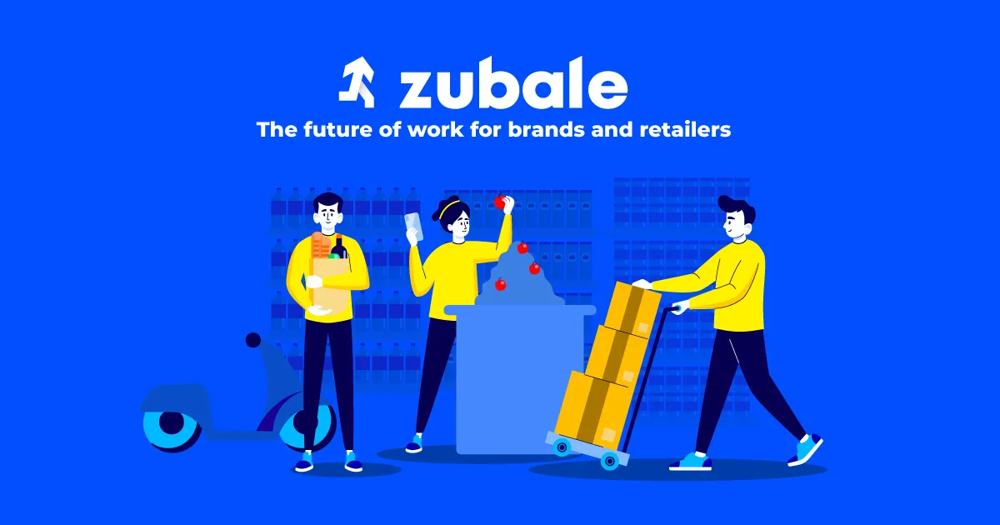

#TÍTULO: ANÁLISE EXPLORATÓRIA DE DADOS

#AUTOR: ROMILSON LUIS

Output: Relatório Relatório Zubale.html salvo em disco

* Prettydoc: html_pretty
* Theme: cayman
* Toc: yes
* highlith: github



# INTRODUÇÃO 

A elaboração de um relatório detalhado com informações estratégicas para o setor comercial é de vital importância para o sucesso de qualquer negócio. Nesse contexto, trabalharemos com um conjunto de dados cuidadosamente selecionados, que nos permitirão compreender melhor as necessidades das lojas, suas movimentações comerciais, clientes e tarefas internas e externas, no período entre os anos de 2022 a 2023. A partir dessas informações, poderemos identificar tendências, formular hipóteses e desenvolver estratégias alinhadas com os objetivos de nosso público-alvo. Para isso, é fundamental apresentar os dados de forma clara e analítica, com gráficos, tabelas e outros elementos visuais que facilitem a leitura e a compreensão do relatório.

# Bibliotecas importadas

* import pandas as pd
* import numpy as np
* import numpy as np
* import seaborn as sns
* import matplotlib.pyplot as plt
* import matplotlib_inline
* import datetime
* import zipfile
* from zipfile import ZipFile
* import seaborn as sns
* import matplotlib.pyplot as plt
* import plotly.graph_objects as go
* import plotly.express as px
* import plotly.graph_objects as go
* import plotly.express as px
* import bar_chart_race as bcr
* import matplotlib.ticker as mtick
* import pandas_profiling as pp
* from pandas_profiling import ProfileReport 

Total: 19

#Instalação de Pacotes

* !pip install bar_chart_race -q
* !pip install ffmpeg -q
* !pip install matplotlib-venn -q
* !pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip -q
* !pip install pandas-profiling -q

Total: 5

# Variáveis Importantes Criadas(dir())

* df 
* faltantes_percentual 
* df_2022_2023 
* loja_super_baratao  
* df_desempenho_bcr
* loja_mercado_marisol
* loja_mercado_preco_baixo
* mes_max_negado
* ordens_mensais
* ordens_mercado
* pedidos_por_ano_loja
* pedidos_unicos
* percentual_de_rejeição
* qtde_pedidos_unicos
* total_tarefas_lojas
* usuarios_dez_22_23
* var_percentual

Total: 17

In [8]:
#from google.colab import drive

In [9]:
#from google.colab import files
#uploaded = files.upload()

In [10]:
# importando a biblioteca pandas 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib_inline
import datetime
import zipfile
from zipfile import ZipFile

In [11]:
# Criar variável / processar todo o arquivo
df = pd.read_excel("/content/zubale.xlsx", 
                 decimal='.', 
                 header=0,
                 index_col=None,
                 na_values=False
                 )


In [12]:
# Lendo as duas primeiras linhas 
df.head(2)

,Unnamed: 0,Date Date,User Phone Number,Brand ID,Brand Name,Store Name,Order Number,Orden revisada (Yes / No),Orden aprobada (Yes / No),Submission Amount,Quantity SKU,Quantity Itens
0,1,2023-02-28,5571981419571,706,Atacado e Varejo Separador,Super Baratão,1125756.0,Yes,Yes,4.5,66.0,120.0
1,2,2023-02-28,5571981419571,706,Atacado e Varejo Separador,Super Baratão,1125785.0,Yes,Yes,4.5,35.0,71.0


In [13]:
# Ler as ultimas 2 linhas 
df.tail(2)

,Unnamed: 0,Date Date,User Phone Number,Brand ID,Brand Name,Store Name,Order Number,Orden revisada (Yes / No),Orden aprobada (Yes / No),Submission Amount,Quantity SKU,Quantity Itens
11933,11934,2022-11-01,5579996887969,706,Atacado e Varejo Separador,Mercado Marisol,1101126.0,Yes,Yes,4.0,1.0,10.0
11934,11935,2022-11-01,5579996887969,706,Atacado e Varejo Separador,Mercado Marisol,1101193.0,Yes,Yes,4.0,19.0,38.0


# Renomeando colunas

In [14]:
# Usando o método rename
df.rename(columns={'Unnamed: 0' : 'ID_Service',  
                   'User Phone Number' : 'User_Phone_Number', 
                   'Brand ID' : 'Brand_ID', 
                   'Brand Name' : 'Brand_Name', 
                   'Store Name' : 'Store_Name', 
                   'Order Number' : 'Order_Number', 
                   'Orden revisada (Yes / No)' : 'Orden_revisada(Yes/No)', 
                   'Orden aprobada (Yes / No)' : 'Orden_aprobada(Yes/No)', 
                   'Submission Amount' : 'Submission_Amount', 
                   'Quantity SKU' : 'Quantity_SKU', 
                   'Quantity Itens' : 'Quantity_Itens'}, inplace=True)

In [15]:
# Visualizando o conjunto de dados e coletando informações
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11935 entries, 0 to 11934
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   ID_Service              11935 non-null  int64         
 1   Date Date               11935 non-null  datetime64[ns]
 2   User_Phone_Number       11935 non-null  int64         
 3   Brand_ID                11935 non-null  int64         
 4   Brand_Name              11935 non-null  object        
 5   Store_Name              11935 non-null  object        
 6   Order_Number            11934 non-null  float64       
 7   Orden_revisada(Yes/No)  11935 non-null  object        
 8   Orden_aprobada(Yes/No)  11935 non-null  object        
 9   Submission_Amount       11935 non-null  float64       
 10  Quantity_SKU            11934 non-null  float64       
 11  Quantity_Itens          11934 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(3), ob

#Verificando valores missing

<Axes: >

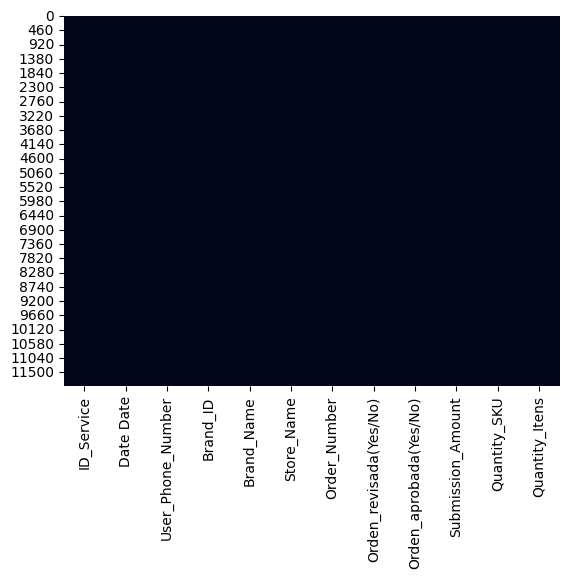

In [16]:
import seaborn as sns
# Verificando dados faltantes com gráfico 
sns.heatmap(df.isnull(), cbar=False)

In [17]:
# Somando os dados faltantes
df.isnull().sum()

ID_Service                0
Date Date                 0
User_Phone_Number         0
Brand_ID                  0
Brand_Name                0
Store_Name                0
Order_Number              1
Orden_revisada(Yes/No)    0
Orden_aprobada(Yes/No)    0
Submission_Amount         0
Quantity_SKU              1
Quantity_Itens            1
dtype: int64

In [18]:
# Percentual de dados faltantes 
faltantes_percentual = (df.isnull().sum() / len(df['Order_Number']))*100
print(faltantes_percentual)

ID_Service                0.000000
Date Date                 0.000000
User_Phone_Number         0.000000
Brand_ID                  0.000000
Brand_Name                0.000000
Store_Name                0.000000
Order_Number              0.008379
Orden_revisada(Yes/No)    0.000000
Orden_aprobada(Yes/No)    0.000000
Submission_Amount         0.000000
Quantity_SKU              0.008379
Quantity_Itens            0.008379
dtype: float64


In [19]:
# O method ffill considera a visinhança dos dados e vai atribuir os valores aos dados ausentes 
df.fillna(method="ffill", inplace=True)

In [20]:
# Visualizando dados faltantes
df.isnull().sum()

ID_Service                0
Date Date                 0
User_Phone_Number         0
Brand_ID                  0
Brand_Name                0
Store_Name                0
Order_Number              0
Orden_revisada(Yes/No)    0
Orden_aprobada(Yes/No)    0
Submission_Amount         0
Quantity_SKU              0
Quantity_Itens            0
dtype: int64

In [21]:
# conjunto de informações de estatísticas descritivas
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID_Service,11935.0,5.968000e+03,3.445482e+03,1.000000e+00,2.984500e+03,5.968000e+03,8.951500e+03,1.193500e+04
User_Phone_Number,11935.0,5.571844e+12,3.465065e+09,5.511934e+12,5.571983e+12,5.571987e+12,5.571989e+12,5.579997e+12
Brand_ID,11935.0,7.060000e+02,0.000000e+00,7.060000e+02,7.060000e+02,7.060000e+02,7.060000e+02,7.060000e+02
Order_Number,11935.0,1.128377e+06,4.943992e+05,1.090000e+02,1.106581e+06,1.112984e+06,1.119289e+06,1.134328e+07
Submission_Amount,11935.0,4.353833e+00,2.274269e-01,4.000000e+00,4.000000e+00,4.500000e+00,4.500000e+00,4.500000e+00
Quantity_SKU,11935.0,2.340913e+01,2.176806e+01,1.000000e+00,8.000000e+00,1.800000e+01,3.300000e+01,8.680000e+02
Quantity_Itens,11935.0,2.164634e+02,1.230862e+04,1.000000e+00,2.200000e+01,4.400000e+01,7.800000e+01,1.108641e+06


#Gerando novas colunas para data ano, mês e dia.

In [22]:
# Formatando colunas com datas
#df['Date Date'] = pd.to_datetime(df['Date Date'], format='%d/%m/%Y')

In [23]:
# Criando coluna ano 
df['Ano'] = pd.DatetimeIndex(df['Date Date']).year

In [24]:
# Criando coluna mês
df['Mes'] = pd.DatetimeIndex(df['Date Date']).month

In [25]:
# Criando coluna Dia
df['Dia'] = pd.DatetimeIndex(df['Date Date']).day

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11935 entries, 0 to 11934
Data columns (total 15 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   ID_Service              11935 non-null  int64         
 1   Date Date               11935 non-null  datetime64[ns]
 2   User_Phone_Number       11935 non-null  int64         
 3   Brand_ID                11935 non-null  int64         
 4   Brand_Name              11935 non-null  object        
 5   Store_Name              11935 non-null  object        
 6   Order_Number            11935 non-null  float64       
 7   Orden_revisada(Yes/No)  11935 non-null  object        
 8   Orden_aprobada(Yes/No)  11935 non-null  object        
 9   Submission_Amount       11935 non-null  float64       
 10  Quantity_SKU            11935 non-null  float64       
 11  Quantity_Itens          11935 non-null  float64       
 12  Ano                     11935 non-null  int64 

# Consultando os nomes das lojas cadastradas





In [27]:
# Criando um dataframe com as colunas Store_Name e Brand_ID sem duplicatas
df_lojas = df[['Store_Name', 'Brand_ID']].drop_duplicates()

# Transformando o dataframe em um dicionário
lojas_dict = df_lojas.set_index('Store_Name')['Brand_ID'].to_dict()

# Imprimindo o resultado
print(lojas_dict)

{'Super Baratão': 706, 'Mercado Preço Baixo': 706, 'Mercado Marisol': 706}


# Realizando Quary nas lojas

In [28]:
# Atribuindo uma variável para consulta
loja_super_baratao = df[df["Store_Name"] == "Super Baratão"]
loja_super_baratao

,ID_Service,Date Date,User_Phone_Number,Brand_ID,Brand_Name,Store_Name,Order_Number,Orden_revisada(Yes/No),Orden_aprobada(Yes/No),Submission_Amount,Quantity_SKU,Quantity_Itens,Ano,Mes,Dia
0,1,2023-02-28,5571981419571,706,Atacado e Varejo Separador,Super Baratão,1125756.0,Yes,Yes,4.5,66.0,120.0,2023,2,28
1,2,2023-02-28,5571981419571,706,Atacado e Varejo Separador,Super Baratão,1125785.0,Yes,Yes,4.5,35.0,71.0,2023,2,28
2,3,2023-02-28,5571981419571,706,Atacado e Varejo Separador,Super Baratão,1125789.0,Yes,Yes,4.5,33.0,124.0,2023,2,28
3,4,2023-02-28,5571981419571,706,Atacado e Varejo Separador,Super Baratão,1125882.0,Yes,Yes,4.5,18.0,33.0,2023,2,28
4,5,2023-02-28,5571981419571,706,Atacado e Varejo Separador,Super Baratão,1125883.0,Yes,Yes,4.5,33.0,100.0,2023,2,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11927,11928,2022-11-01,5575998128233,706,Atacado e Varejo Separador,Super Baratão,1101310.0,Yes,Yes,4.0,4.0,10.0,2022,11,1
11928,11929,2022-11-01,5575998128233,706,Atacado e Varejo Separador,Super Baratão,1101315.0,Yes,Yes,4.0,14.0,18.0,2022,11,1
11929,11930,2022-11-01,5575998128233,706,Atacado e Varejo Separador,Super Baratão,1101320.0,Yes,Yes,4.0,13.0,97.0,2022,11,1
11930,11931,2022-11-01,5575998128233,706,Atacado e Varejo Separador,Super Baratão,1101322.0,Yes,Yes,4.0,14.0,103.0,2022,11,1


# 1 - Quantos pedidos - únicos - a loja Super Baratão teve no mês de Dezembro?

In [29]:
# O objetivo do comando BETWEEN é selecionar os dados que fazem parte de um intervalo. Nesse caso, os pedidos de dezembro de 2022 e 2023
# Neste caso, ainda estamos no mês de abril logo não teremos dados para dezembro de 2023, mas fica como ilustração que podemos pegar varios 
# varios anos e comparar o mês que desejarmos.
pedidos_unicos = loja_super_baratao[(loja_super_baratao['Mes'] == 12) & (loja_super_baratao['Ano'].between(2022, 2023))]


In [30]:
qtde_pedidos_unicos = pedidos_unicos['Quantity_SKU'].nunique()
qtde_pedidos_unicos

104

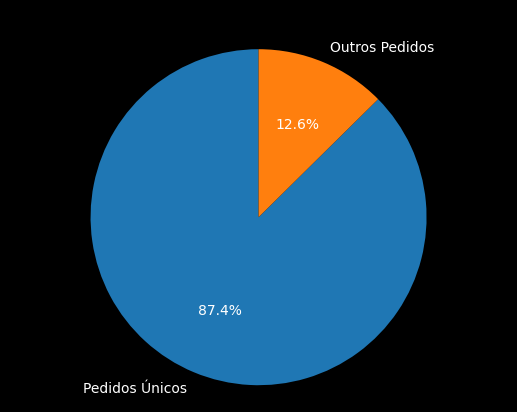

In [31]:
import matplotlib.pyplot as plt

labels = ['Pedidos Únicos', 'Outros Pedidos']
sizes = [qtde_pedidos_unicos, loja_super_baratao['Quantity_SKU'].nunique() - qtde_pedidos_unicos]

fig1, ax1 = plt.subplots()
ax1.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, textprops={'color': 'white'})
ax1.axis('equal')
plt.title('Quantidade de Pedidos Únicos em Dezembro de 2022-2023')
fig1.set_facecolor('black')
plt.show()

# 2 - Qual foi o mês com maior percentual de rejeição da loja Mercado Marisol?

In [32]:
# Atribuindo uma variável para consulta
ordens_mercado = df[(df['Store_Name'] == 'Mercado Marisol') &
                    (df['Ano'].isin([2022, 2023]))]

In [33]:
# Agrupando os dados por mês e ordem aprovada (Yes/No) e contando o número de ordens em cada categoria um DataFrame com o número de ordens aprovadas e negadas em cada mês
ordens_mensais = ordens_mercado.groupby(['Mes', 'Orden_aprobada(Yes/No)'])['ID_Service'].count().unstack()
ordens_mensais

Orden_aprobada(Yes/No),No,Yes
Mes,,
1,15,513
2,17,579
11,54,556
12,5,567


In [34]:
# Calculando a porcentagem de ordens negadas em cada mês, o resultado será um DataFrame com o número total de ordens aprovadas e negadas em cada mês, e a porcentagem de ordens negadas

ordens_mensais['Percent_Negado'] = ordens_mensais['No'] / (ordens_mensais['No'] + ordens_mensais['Yes']) * 100

In [35]:
# Encontrando o mês com o maior percentual de ordens negadas.

mes_max_negado = ordens_mensais['Percent_Negado'].idxmax()
mes_max_negado

11

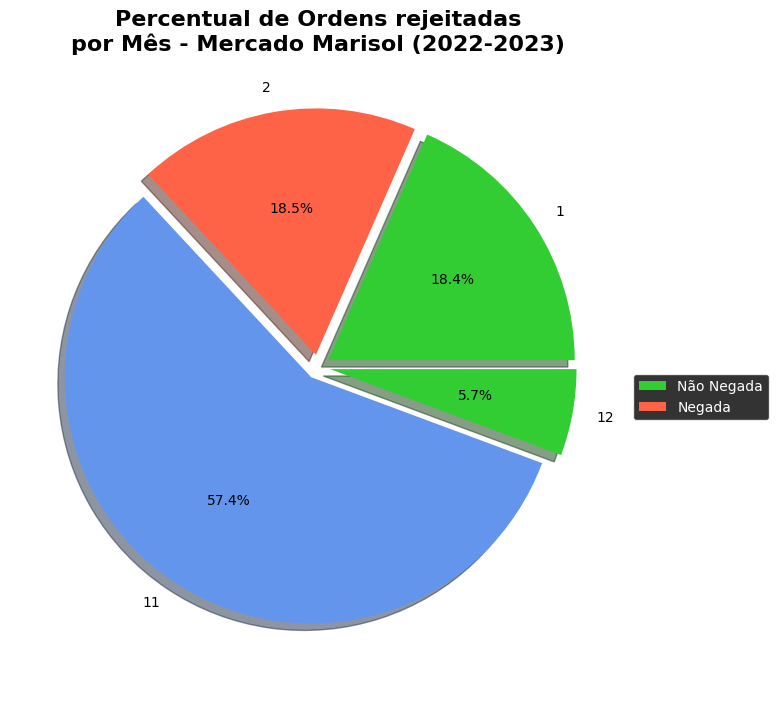

In [36]:
import matplotlib.pyplot as plt

# Acessando a coluna Percent_Negado do DataFrame ordens_mensais
percentual_de_rejeição = ordens_mensais['Percent_Negado']

# Configuração do gráfico
fig, ax = plt.subplots(figsize=(8, 8))
cores = ['limegreen', 'tomato', 'cornflowerblue']
explode = [0.05] * len(percentual_de_rejeição) # explode todas as fatias

# Desenho do gráfico de pizza (pie chart)
ax.pie(percentual_de_rejeição, labels=percentual_de_rejeição.index, autopct='%1.1f%%', explode=explode, colors=cores, shadow=True)

# Configuração de título, subtítulo e legenda
ax.set_title('Percentual de Ordens rejeitadas\npor Mês - Mercado Marisol (2022-2023)', fontsize=16, fontweight='bold', color='black')
ax.set_xlabel(f'Mês com maior percentual de ordens rejeitadas: {mes_max_negado}', fontsize=12, fontweight='bold', color='white')
ax.legend(['Não Negada', 'Negada'], bbox_to_anchor=(1, 0.5), facecolor='black', edgecolor='white', labelcolor='white')

# Configuração da cor de fundo do gráfico
ax.set_facecolor('black')

# Exibição do gráfico
plt.show()

# 3. Quantos usuários fizeram pedidos na loja Mercado Preço Baixo no mês de Dezembro?

In [37]:
import matplotlib.pyplot as plt

# Atribuindo uma variável para consulta
loja_mercado_preco_baixo = df[(df["Store_Name"] == "Mercado Preço Baixo") & 
(df["Ano"].isin([2022, 2023])) &
(df["Mes"] == 12)]

In [38]:
# número de pedidos de cada usuário no mês de dezembro
usuarios_dez_22_23 = loja_mercado_preco_baixo['Quantity_Itens'].nunique()
print(f"{usuarios_dez_22_23} usuários fizeram pedidos na loja Mercado Preço Baixo no mês de Dezembro entre os anos de 2022 e 2023.")


167 usuários fizeram pedidos na loja Mercado Preço Baixo no mês de Dezembro entre os anos de 2022 e 2023.


In [39]:
import plotly.graph_objs as go

values_2022 = loja_mercado_preco_baixo[loja_mercado_preco_baixo['Ano'] == 2022]['Quantity_Itens']
values_2023 = loja_mercado_preco_baixo[loja_mercado_preco_baixo['Ano'] == 2023]['Quantity_Itens']

if len(values_2022) > 0:
    # Criando lista com os valores para o histograma
    data = [len(values_2022), 0]
    labels = ['Dez/2022', 'Dez/2023']
    colors = ['#1f77b4', '#d6d6d6']
    if len(values_2023) == 0:
        labels[1] += " (sem vendas)" # Adiciona a especificação em vermelho
        
    fig = go.Figure()
    fig.add_trace(go.Pie(
        labels=labels, 
        values=data,
        hole=.3, # Define o raio do furo central da rosca
        marker=dict(colors=colors), # Define as cores das fatias
        textinfo='label+percent+value', # Define a informação que vai aparecer na rosca
        textposition='inside'
    ))

    fig.update_layout(
        title='167 pedidos em Dez/2022 e 0 pedidos em Dez/2023',
        title_font=dict(size=20, color='white'), # Define a cor e o tamanho da fonte do título
        font=dict(color='white'), # Define a cor da fonte das labels
        paper_bgcolor='black' # Define a cor de fundo do gráfico
    )

    fig.show()


# 4. Construa um gráfico (e compartilhe comigo!) com o total de pedidos de 2022 e 2023. O gráfico deve exibir o total de tarefas de cada loja individualmente

In [40]:
# Selecionar apenas pedidos dos anos de 2022 e 2023
df_2022_2023 = df[df['Ano'].isin([2022, 2023])]

In [41]:
import plotly.graph_objects as go
import plotly.express as px

# balanço de tarefas nas lojas Super Baratão, Mercado Preço Baixo e Mercado Marisol
loja_super_baratao = df_2022_2023[df_2022_2023['Store_Name'] == 'Super Baratão']
loja_mercado_preco_baixo = df_2022_2023[df_2022_2023['Store_Name'] == 'Mercado Preço Baixo']
loja_mercado_marisol = df_2022_2023[df_2022_2023['Store_Name'] == 'Mercado Marisol']

# Agrupando as tarefas feitas por cada loja em cada ano
total_tarefas_lojas = pd.concat([loja_super_baratao, loja_mercado_preco_baixo, loja_mercado_marisol]).groupby(['Store_Name','Ano']).agg({
'Order_Number': 'sum',
'Quantity_Itens': 'sum',
'Submission_Amount': 'sum'
})

# Resetando os índices do DataFrame
total_tarefas_lojas = total_tarefas_lojas.reset_index()

# Transformando o DataFrame em um formato apropriado para o histograma
df_hist = total_tarefas_lojas.melt(id_vars=['Store_Name', 'Ano'], value_vars=['Order_Number', 'Quantity_Itens', 'Submission_Amount'], var_name='variavel', value_name='valor')


In [42]:
# Removendo os separadores de milhar e transformando as strings em números reais
df_hist.loc[:, 'valor'] = df_hist['valor'].astype(str).str.replace(',', '').astype(float)

# Adicionando as percentagens aos dados para o tooltip
for store_name in df_hist['Store_Name'].unique():
    for ano in df_hist['Ano'].unique():
        idx = (df_hist['Store_Name'] == store_name) & (df_hist['Ano'] == ano)
        total_tarefas = df_hist[idx]['valor'].astype(float).sum()
        df_hist.loc[idx, 'percentual'] = df_hist[idx]['valor'].astype(float) / total_tarefas * 100
        df_hist.loc[idx, 'total_tarefas'] = total_tarefas


# Customizando os valores do histograma
if 'valor' in df_hist.columns:
    df_hist.loc[:, 'valor'] = df_hist['valor'].apply(lambda x: "{:,.0f}".format(x))


In [43]:
# Gerando o gráfico de barras
fig = go.Figure()

for metric in df_hist['variavel'].unique():
    metric_data = df_hist[df_hist['variavel'] == metric]
    
    fig.add_trace(go.Bar(
        x=metric_data['Store_Name'],
        y=metric_data['valor'],
        name=metric,
        customdata=metric_data[['Store_Name', 'Ano', 'total_tarefas', 'percentual']],
        hovertemplate='<b>%{customdata[0]}</b><br>' \
            'Ano: %{customdata[1]}<br>' \
            'Tarefas: %{customdata[2]:,.0f}<br>' \
            'Percentual: %{customdata[3]:.2f}%<br>' \
            '<extra></extra>',
        texttemplate='%{y} (%{customdata[3]:.2f}%)',
        textposition='inside'
    ))

# Configurando as opções de visualização interativa
fig.update_xaxes(title='Lojas')
fig.update_yaxes(title='Total de pedidos e tarefas')
fig.update_layout(barmode='stack')

# Adicionando informações sobre a loja e o ano ao topo do gráfico
fig.add_layout_image(
dict(
source="https://raw.githubusercontent.com/plotly/brand-assets/master/dash-logo-new.png",
xref="paper", yref="paper",
x=0.5, y=1.15,
sizex=0.3, sizey=0.3,
xanchor="center", yanchor="middle"
)
)

# Adicionando título à parte superior do gráfico
fig.update_layout(title={
    'text': "Total de tarefas por lojas",
    'y': 0.9,
    'x': 0.5,
    'xanchor': 'center',
    'yanchor': 'top',
    'font':{'size':35, 'color': 'white'},
    
},
paper_bgcolor='black',
plot_bgcolor='black'
)

# Exibindo o gráfico
fig.show()



In [44]:
# Agrupando as quantidades de itens feitos por cada loja em cada ano
total_itens_lojas = pd.concat([loja_super_baratao, loja_mercado_preco_baixo, loja_mercado_marisol]).groupby(['Store_Name','Ano']).agg({
'Order_Number': 'count',
'Quantity_Itens': 'sum',
'Submission_Amount': 'sum'
}).reset_index()

# Plotando o histograma de rosca interativo
fig = px.sunburst(total_itens_lojas, path=['Ano', 'Store_Name'], values='Quantity_Itens', color='Store_Name')

# Definindo layout do gráfico
fig.update_layout(
    title={
        'text': 'Total de Itens vendidos $',
        'font': {'color': 'white', 'size':25}
    },
    paper_bgcolor='black',
    plot_bgcolor='black'
)

fig.show()


# 5. Identifique o % de variação de pedidos - únicos - por loja no período ano contra ano

In [45]:
pedidos_por_ano_loja = df[df['Ano'].isin([2022, 2023])].groupby(['Ano', 'Store_Name'])['Quantity_SKU'].nunique().unstack()
pedidos_por_ano_loja.columns = ['Mercado Marisol', 'Mercado Preço Baixo', 'Super Baratão']


In [46]:
# Usando o método pct_change() para calcular a variação percentual entre os dois anos
var_percentual = pedidos_por_ano_loja.pct_change(axis=1).iloc[:, 1:] * 100
pd.options.display.float_format = '{:.2f}%'.format
print(f"Variação percentual dos pedidos únicos por loja:\n{var_percentual}")

Variação percentual dos pedidos únicos por loja:
      Mercado Preço Baixo  Super Baratão
Ano                                     
2022               18.99%         15.96%
2023               19.05%          7.00%


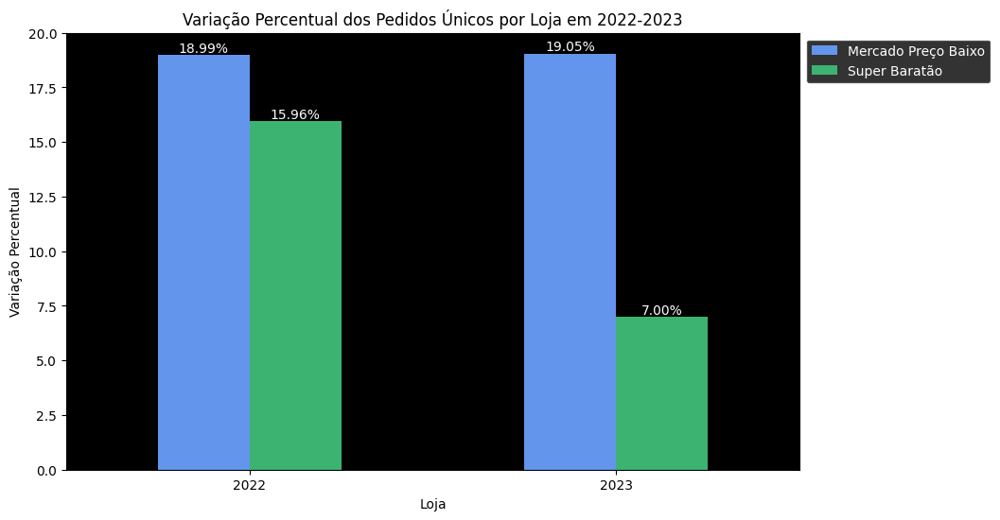

In [47]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick

# Gerando o gráfico de barras detalhado

# Gera o histograma
ax = var_percentual.plot.bar(rot=0, figsize=(10,6), color=['cornflowerblue', 'mediumseagreen', 'orange'])
#ax.yaxis.set_major_formatter(yticks)
plt.xlabel('Loja', color='black')
plt.ylabel('Variação Percentual', color='black')
plt.title('Variação Percentual dos Pedidos Únicos por Loja em 2022-2023', color='black')
plt.legend(loc='upper left', bbox_to_anchor=(1,1), facecolor='black', edgecolor='white', labelcolor='white')
for i in ax.containers:
    ax.bar_label(i, label_type='edge', labels=['{:.2f}%'.format(val) for val in i.datavalues], color='white')
ax.set_facecolor('black')
ax.tick_params(colors='black')
if 'Mercado Marisol' not in pedidos_por_ano_loja.columns:
    pedidos_por_ano_loja['Mercado Marisol'] = 0
plt.show()

# Arquivos

In [48]:
#Verificando todos os arquivos disponíveis no drive
#!ls '/content/drive/My Drive/'

# Gerando relatório

In [49]:
!pip uninstall visions==0.7.5 -y -q 

In [50]:
!apt-get install visions==0.7.4 -q 

Reading package lists...
Building dependency tree...
Reading state information...
E: Unable to locate package visions=


In [ ]:
!pip install ydata-profiling visions==0.7.4 -q

In [52]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip -q


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.6/22.6 MB 86.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done


In [53]:
!pip install pandas-profiling -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 22.9 MB/s eta 0:00:00


In [54]:
#Importando as bibliotecas
import pandas_profiling as pp
from pandas_profiling import ProfileReport 

<ipython-input-54-b8adf951f540>:2: DeprecationWarning:

`import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.



In [55]:
#Gerando relatório resumido
profile = ProfileReport(df, title="Relatório Zulebale", html={'style':{'full_width':True}})

In [56]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

![Projeto Zubale.html](data:text/html;base64,PCFkb2N0eXBlIGh0bWw+PGh0bWwgbGFuZz1lbj48aGVhZD48bWV0YSBjaGFyc2V0PXV0Zi04PjxtZXRhIG5hbWU9dmlld3BvcnQgY29udGVudD0id2lkdGg9ZGV2aWNlLXdpZHRoLCBpbml0aWFsLXNjYWxlPTEsIHNocmluay10by1maXQ9bm8iPjxtZXRhIG5hbWU9ZGVzY3JpcHRpb24gY29udGVudD0iUHJvZmlsZSByZXBvcnQgZ2VuZXJhdGVkIGJ5IFlEYXRhISBWaXNpdCB1cyBhdCBodHRwczovL3lkYXRhLmFpIj48bWV0YSBuYW1lPWF1dGhvciBjb250ZW50PSJZRGF0YSBhbmQgdGhlIG9wZW4gc291cmNlIGNvbW11bml0eS4iPjxtZXRhIG5hbWU9Z2VuZXJhdG9yIGNvbnRlbnQ9IlBhbmRhcyBQcm9maWxpbmcgdjMuNi42Ij48bWV0YSBuYW1lPXVybCBjb250ZW50PWh0dHBzOi8vZ2l0aHViLmNvbS95ZGF0YWFpL3BhbmRhcy1wcm9maWxpbmc+PG1ldGEgbmFtZT1kYXRlIGNvbnRlbnQ9IjIwMjMtMDQtMjggMjE6MzE6NDYuNzM5MTgwIj48dGl0bGU+UmVsYXTDs3JpbyBadWxlYmFsZTwvdGl0bGU+PHN0eWxlPgovKiEKICogQm9vdHN0cmFwIHYzLjMuNyAoaHR0cDovL2dldGJvb3RzdHJhcC5jb20pCiAqIENvcHlyaWdodCAyMDExLTIwMTYgVHdpdHRlciwgSW5jLgogKiBMaWNlbnNlZCB1bmRlciBNSVQgKGh0dHBzOi8vZ2l0aHViLmNvbS90d2JzL2Jvb3RzdHJhcC9ibG9iL21hc3Rlci9MSUNFTlNFKQogKi8vKiEgbm9ybWFsaXplLmNzcyB2My4wLjMgfCBNSVQgTGljZW5zZSB8IGdpdGh1Yi5jb20vbmVjb2xhcy9ub3JtYWxpemUuY3NzICovaHRtbHtmb250LWZhbWlseTpzYW5zLXNlcmlmOy13ZWJraXQtdGV4dC1zaXplLWFkanVzdDoxMDAlOy1tcy10ZXh0LXNpemUtYWRqdXN0OjEwMCV9Ym9keXttYXJnaW46MH1hcnRpY2xlLGFzaWRlLGRldGFpbHMsZmlnY2FwdGlvbixmaWd1cmUsZm9vdGVyLGhlYWRlcixoZ3JvdXAsbWFpbixtZW51LG5hdixzZWN0aW9uLHN1bW1hcnl7ZGlzcGxheTpibG9ja31hdWRpbyxjYW52YXMscHJvZ3Jlc3MsdmlkZW97ZGlzcGxheTppbmxpbmUtYmxvY2s7dmVydGljYWwtYWxpZ246YmFzZWxpbmV9YXVkaW86bm90KFtjb250cm9sc10pe2Rpc3BsYXk6bm9uZTtoZWlnaHQ6MH1baGlkZGVuXSx0ZW1wbGF0ZXtkaXNwbGF5Om5vbmV9YXtiYWNrZ3JvdW5kLWNvbG9yOnRyYW5zcGFyZW50fWE6YWN0aXZlLGE6aG92ZXJ7b3V0bGluZTowfWFiYnJbdGl0bGVde2JvcmRlci1ib3R0b206MXB4IGRvdHRlZH1iLHN0cm9uZ3tmb250LXdlaWdodDo3MDB9ZGZue2ZvbnQtc3R5bGU6aXRhbGljfWgxe21hcmdpbjouNjdlbSAwO2ZvbnQtc2l6ZToyZW19bWFya3tjb2xvcjojMDAwO2JhY2tncm91bmQ6I2ZmMH1zbWFsbHtmb250LXNpemU6ODAlfXN1YixzdXB7cG9zaXRpb246cmVsYXRpdmU7Zm9udC1zaXplOjc1JTtsaW5lLWhlaWdodDowO3ZlcnRpY2FsLWFsaWduOmJhc2VsaW5lfXN1cHt0b3A6LS41ZW19c3Vie2JvdHRvbTotLjI1ZW19aW1ne2JvcmRlcjowfXN2Zzpub3QoOnJvb3Qpe292ZXJmbG93OmhpZGRlbn1maWd1cmV7bWFyZ2luOjFlbSA0MHB4fWhye2hlaWdodDowOy13ZWJraXQtYm94LXNpemluZzpjb250ZW50LWJveDstbW96LWJveC1zaXppbmc6Y29udGVudC1ib3g7Ym94LXNpemluZzpjb250ZW50LWJveH1wcmV7b3ZlcmZsb3c6YXV0b31jb2RlLGtiZCxwcmUsc2FtcHtmb250LWZhbWlseTptb25vc3BhY2UsbW9ub3NwYWNlO2ZvbnQtc2l6ZToxZW19YnV0dG9uLGlucHV0LG9wdGdyb3VwLHNlbGVjdCx0ZXh0YXJlYXttYXJnaW46MDtmb250OmluaGVyaXQ7Y29sb3I6aW5oZXJpdH1idXR0b257b3ZlcmZsb3c6dmlzaWJsZX1idXR0b24sc2VsZWN0e3RleHQtdHJhbnNmb3JtOm5vbmV9YnV0dG9uLGh0bWwgaW5wdXRbdHlwZT1idXR0b25dLGlucHV0W3R5cGU9cmVzZXRdLGlucHV0W3R5cGU9c3VibWl0XXstd2Via2l0LWFwcGVhcmFuY2U6YnV0dG9uO2N1cnNvcjpwb2ludGVyfWJ1dHRvbltkaXNhYmxlZF0saHRtbCBpbnB1dFtkaXNhYmxlZF17Y3Vyc29yOmRlZmF1bHR9YnV0dG9uOjotbW96LWZvY3VzLWlubmVyLGlucHV0OjotbW96LWZvY3VzLWlubmVye3BhZGRpbmc6MDtib3JkZXI6MH1pbnB1dHtsaW5lLWhlaWdodDpub3JtYWx9aW5wdXRbdHlwZT1jaGVja2JveF0saW5wdXRbdHlwZT1yYWRpb117LXdlYmtpdC1ib3gtc2l6aW5nOmJvcmRlci1ib3g7LW1vei1ib3gtc2l6aW5nOmJvcmRlci1ib3g7Ym94LXNpemluZzpib3JkZXItYm94O3BhZGRpbmc6MH1pbnB1dFt0eXBlPW51bWJlcl06Oi13ZWJraXQtaW5uZXItc3Bpbi1idXR0b24saW5wdXRbdHlwZT1udW1iZXJdOjotd2Via2l0LW91dGVyLXNwaW4tYnV0dG9ue2hlaWdodDphdXRvfWlucHV0W3R5cGU9c2VhcmNoXXstd2Via2l0LWJveC1zaXppbmc6Y29udGVudC1ib3g7LW1vei1ib3gtc2l6aW5nOmNvbnRlbnQtYm94O2JveC1zaXppbmc6Y29udGVudC1ib3g7LXdlYmtpdC1hcHBlYXJhbmNlOnRleHRmaWVsZH1pbnB1dFt0eXBlPXNlYXJjaF06Oi13ZWJraXQtc2VhcmNoLWNhbmNlbC1idXR0b24saW5wdXRbdHlwZT1zZWFyY2hdOjotd2Via2l0LXNlYXJjaC1kZWNvcmF0aW9uey13ZWJraXQtYXBwZWFyYW5jZTpub25lfWZpZWxkc2V0e3BhZGRpbmc6LjM1ZW0gLjYyNWVtIC43NWVtO21hcmdpbjowIDJweDtib3JkZXI6MXB4IHNvbGlkIHNpbHZlcn1sZWdlbmR7cGFkZGluZzowO2JvcmRlcjowfXRleHRhcmVhe292ZXJmbG93OmF1dG99b3B0Z3JvdXB7Zm9udC13ZWlnaHQ6NzAwfXRhYmxle2JvcmRlci1zcGFjaW5nOjA7Ym9yZGVyLWNvbGxhcHNlOmNvbGxhcHNlfXRkLHRoe3BhZGRpbmc6MH0vKiEgU291cmNlOiBodHRwczovL2dpdGh1Yi5jb20vaDVicC9odG1sNS1ib2lsZXJwbGF0ZS9ibG9iL21hc3Rlci9zcmMvY3NzL21haW4uY3NzICovQG1lZGlhIHByaW50eyosOmFmdGVyLDpiZWZvcmV7Y29sb3I6IzAwMCFpbXBvcnRhbnQ7dGV4dC1zaGFkb3c6bm9uZSFpbXBvcnRhbnQ7YmFja2dyb3VuZDowIDAhaW1wb3J0YW50Oy13ZWJraXQtYm94LXNoYWRvdzpub25lIWltcG9ydGFudDtib3gtc2hhZG93Om5vbmUhaW1wb3J0YW50fWEsYTp2aXNpdGVke3RleHQtZGVjb3JhdGlvbjp1bmRlcmxpbmV9YVtocmVmXTphZnRlcntjb250ZW50OiIgKCIgYXR0cihocmVmKSAiKSJ9YWJiclt0aXRsZV06YWZ0ZXJ7Y29udGVudDoiICgiIGF0dHIodGl0bGUpICIpIn1hW2hyZWZePSJqYXZhc2NyaXB0OiJdOmFmdGVyLGFbaHJlZl49IiMiXTphZnRlcntjb250ZW50OiIifWJsb2NrcXVvdGUscHJle2JvcmRlcjoxcHggc29saWQgIzk5OTtwYWdlLWJyZWFrLWluc2lkZTphdm9pZH10aGVhZHtkaXNwbGF5OnRhYmxlLWhlYWRlci1ncm91cH1pbWcsdHJ7cGFnZS1icmVhay1pbnNpZGU6YXZvaWR9aW1ne21heC13aWR0aDoxMDAlIWltcG9ydGFudH1oMixoMyxwe29ycGhhbnM6Mzt3aWRvd3M6M31oMixoM3twYWdlLWJyZWFrLWFmdGVyOmF2b2lkfS5uYXZiYXJ7ZGlzcGxheTpub25lfS5idG4+LmNhcmV0LC5kcm9wdXA+LmJ0bj4uY2FyZXR7Ym9yZGVyLXRvcC1jb2xvcjojMDAwIWltcG9ydGFudH0ubGFiZWx7Ym9yZGVyOjFweCBzb2xpZCAjMDAwfS50YWJsZXtib3JkZXItY29sbGFwc2U6Y29sbGFwc2UhaW1wb3J0YW50fS50YWJsZSB0ZCwudGFibGUgdGh7YmFja2dyb3VuZC1jb2xvcjojZmZmIWltcG9ydGFudH0udGFibGUtYm9yZGVyZWQgdGQsLnRhYmxlLWJvcmRlcmVkIHRoe2JvcmRlcjoxcHggc29saWQgI2RkZCFpbXBvcnRhbnR9fUBmb250LWZhY2V7Zm9udC1mYW1pbHk6J0dseXBoaWNvbnMgSGFsZmxpbmdzJztzcmM6dXJsKC4uL2ZvbnRzL2dseXBoaWNvbnMtaGFsZmxpbmdzLXJlZ3VsYXIuZW90KTtzcmM6dXJsKC4uL2ZvbnRzL2dseXBoaWNvbnMtaGFsZmxpbmdzLXJlZ3VsYXIuZW90PyNpZWZpeCkgZm9ybWF0KCdlbWJlZGRlZC1vcGVudHlwZScpLHVybCguLi9mb250cy9nbHlwaGljb25zLWhhbGZsaW5ncy1yZWd1bGFyLndvZmYyKSBmb3JtYXQoJ3dvZmYyJyksdXJsKC4uL2ZvbnRzL2dseXBoaWNvbnMtaGFsZmxpbmdzLXJlZ3VsYXIud29mZikgZm9ybWF0KCd3b2ZmJyksdXJsKC4uL2ZvbnRzL2dseXBoaWNvbnMtaGFsZmxpbmdzLXJlZ3VsYXIudHRmKSBmb3JtYXQoJ3RydWV0eXBlJyksdXJsKC4uL2ZvbnRzL2dseXBoaWNvbnMtaGFsZmxpbmdzLXJlZ3VsYXIuc3ZnI2dseXBoaWNvbnNfaGFsZmxpbmdzcmVndWxhcikgZm9ybWF0KCdzdmcnKX0uZ2x5cGhpY29ue3Bvc2l0aW9uOnJlbGF0aXZlO3RvcDoxcHg7ZGlzcGxheTppbmxpbmUtYmxvY2s7Zm9udC1mYW1pbHk6J0dseXBoaWNvbnMgSGFsZmxpbmdzJztmb250LXN0eWxlOm5vcm1hbDtmb250LXdlaWdodDo0MDA7bGluZS1oZWlnaHQ6MTstd2Via2l0LWZvbnQtc21vb3RoaW5nOmFudGlhbGlhc2VkOy1tb3otb3N4LWZvbnQtc21vb3RoaW5nOmdyYXlzY2FsZX0uZ2x5cGhpY29uLWFzdGVyaXNrOmJlZm9yZXtjb250ZW50OiJcMDAyYSJ9LmdseXBoaWNvbi1wbHVzOmJlZm9yZXtjb250ZW50OiJcMDAyYiJ9LmdseXBoaWNvbi1ldXI6YmVmb3JlLC5nbHlwaGljb24tZXVybzpiZWZvcmV7Y29udGVudDoiXDIwYWMifS5nbHlwaGljb24tbWludXM6YmVmb3Jle2NvbnRlbnQ6IlwyMjEyIn0uZ2x5cGhpY29uLWNsb3VkOmJlZm9yZXtjb250ZW50OiJcMjYwMSJ9LmdseXBoaWNvbi1lbnZlbG9wZTpiZWZvcmV7Y29udGVudDoiXDI3MDkifS5nbHlwaGljb24tcGVuY2lsOmJlZm9yZXtjb250ZW50OiJcMjcwZiJ9LmdseXBoaWNvbi1nbGFzczpiZWZvcmV7Y29udGVudDoiXGUwMDEifS5nbHlwaGljb24tbXVzaWM6YmVmb3Jle2NvbnRlbnQ6IlxlMDAyIn0uZ2x5cGhpY29uLXNlYXJjaDpiZWZvcmV7Y29udGVudDoiXGUwMDMifS5nbHlwaGljb24taGVhcnQ6YmVmb3Jle2NvbnRlbnQ6IlxlMDA1In0uZ2x5cGhpY29uLXN0YXI6YmVmb3Jle2NvbnRlbnQ6IlxlMDA2In0uZ2x5cGhpY29uLXN0YXItZW1wdHk6YmVmb3Jle2NvbnRlbnQ6IlxlMDA3In0uZ2x5cGhpY29uLXVzZXI6YmVmb3Jle2NvbnRlbnQ6IlxlMDA4In0uZ2x5cGhpY29uLWZpbG06YmVmb3Jle2NvbnRlbnQ6IlxlMDA5In0uZ2x5cGhpY29uLXRoLWxhcmdlOmJlZm9yZXtjb250ZW50OiJcZTAxMCJ9LmdseXBoaWNvbi10aDpiZWZvcmV7Y29udGVudDoiXGUwMTEifS5nbHlwaGljb24tdGgtbGlzdDpiZWZvcmV7Y29udGVudDoiXGUwMTIifS5nbHlwaGljb24tb2s6YmVmb3Jle2NvbnRlbnQ6IlxlMDEzIn0uZ2x5cGhpY29uLXJlbW92ZTpiZWZvcmV7Y29udGVudDoiXGUwMTQifS5nbHlwaGljb24tem9vbS1pbjpiZWZvcmV7Y29udGVudDoiXGUwMTUifS5nbHlwaGljb24tem9vbS1vdXQ6YmVmb3Jle2NvbnRlbnQ6IlxlMDE2In0uZ2x5cGhpY29uLW9mZjpiZWZvcmV7Y29udGVudDoiXGUwMTcifS5nbHlwaGljb24tc2lnbmFsOmJlZm9yZXtjb250ZW50OiJcZTAxOCJ9LmdseXBoaWNvbi1jb2c6YmVmb3Jle2NvbnRlbnQ6IlxlMDE5In0uZ2x5cGhpY29uLXRyYXNoOmJlZm9yZXtjb250ZW50OiJcZTAyMCJ9LmdseXBoaWNvbi1ob21lOmJlZm9yZXtjb250ZW50OiJcZTAyMSJ9LmdseXBoaWNvbi1maWxlOmJlZm9yZXtjb250ZW50OiJcZTAyMiJ9LmdseXBoaWNvbi10aW1lOmJlZm9yZXtjb250ZW50OiJcZTAyMyJ9LmdseXBoaWNvbi1yb2FkOmJlZm9yZXtjb250ZW50OiJcZTAyNCJ9LmdseXBoaWNvbi1kb3dubG9hZC1hbHQ6YmVmb3Jle2NvbnRlbnQ6IlxlMDI1In0uZ2x5cGhpY29uLWRvd25sb2FkOmJlZm9yZXtjb250ZW50OiJcZTAyNiJ9LmdseXBoaWNvbi11cGxvYWQ6YmVmb3Jle2NvbnRlbnQ6IlxlMDI3In0uZ2x5cGhpY29uLWluYm94OmJlZm9yZXtjb250ZW50OiJcZTAyOCJ9LmdseXBoaWNvbi1wbGF5LWNpcmNsZTpiZWZvcmV7Y29udGVudDoiXGUwMjkifS5nbHlwaGljb24tcmVwZWF0OmJlZm9yZXtjb250ZW50OiJcZTAzMCJ9LmdseXBoaWNvbi1yZWZyZXNoOmJlZm9yZXtjb250ZW50OiJcZTAzMSJ9LmdseXBoaWNvbi1saXN0LWFsdDpiZWZvcmV7Y29udGVudDoiXGUwMzIifS5nbHlwaGljb24tbG9jazpiZWZvcmV7Y29udGVudDoiXGUwMzMifS5nbHlwaGljb24tZmxhZzpiZWZvcmV7Y29udGVudDoiXGUwMzQifS5nbHlwaGljb24taGVhZHBob25lczpiZWZvcmV7Y29udGVudDoiXGUwMzUifS5nbHlwaGljb24tdm9sdW1lLW9mZjpiZWZvcmV7Y29udGVudDoiXGUwMzYifS5nbHlwaGljb24tdm9sdW1lLWRvd246YmVmb3Jle2NvbnRlbnQ6IlxlMDM3In0uZ2x5cGhpY29uLXZvbHVtZS11cDpiZWZvcmV7Y29udGVudDoiXGUwMzgifS5nbHlwaGljb24tcXJjb2RlOmJlZm9yZXtjb250ZW50OiJcZTAzOSJ9LmdseXBoaWNvbi1iYXJjb2RlOmJlZm9yZXtjb250ZW50OiJcZTA0MCJ9LmdseXBoaWNvbi10YWc6YmVmb3Jle2NvbnRlbnQ6IlxlMDQxIn0uZ2x5cGhpY29uLXRhZ3M6YmVmb3Jle2NvbnRlbnQ6IlxlMDQyIn0uZ2x5cGhpY29uLWJvb2s6YmVmb3Jle2NvbnRlbnQ6IlxlMDQzIn0uZ2x5cGhpY29uLWJvb2ttYXJrOmJlZm9yZXtjb250ZW50OiJcZTA0NCJ9LmdseXBoaWNvbi1wcmludDpiZWZvcmV7Y29udGVudDoiXGUwNDUifS5nbHlwaGljb24tY2FtZXJhOmJlZm9yZXtjb250ZW50OiJcZTA0NiJ9LmdseXBoaWNvbi1mb250OmJlZm9yZXtjb250ZW50OiJcZTA0NyJ9LmdseXBoaWNvbi1ib2xkOmJlZm9yZXtjb250ZW50OiJcZTA0OCJ9LmdseXBoaWNvbi1pdGFsaWM6YmVmb3Jle2NvbnRlbnQ6IlxlMDQ5In0uZ2x5cGhpY29uLXRleHQtaGVpZ2h0OmJlZm9yZXtjb250ZW50OiJcZTA1MCJ9LmdseXBoaWNvbi10ZXh0LXdpZHRoOmJlZm9yZXtjb250ZW50OiJcZTA1MSJ9LmdseXBoaWNvbi1hbGlnbi1sZWZ0OmJlZm9yZXtjb250ZW50OiJcZTA1MiJ9LmdseXBoaWNvbi1hbGlnbi1jZW50ZXI6YmVmb3Jle2NvbnRlbnQ6IlxlMDUzIn0uZ2x5cGhpY29uLWFsaWduLXJpZ2h0OmJlZm9yZXtjb250ZW50OiJcZTA1NCJ9LmdseXBoaWNvbi1hbGlnbi1qdXN0aWZ5OmJlZm9yZXtjb250ZW50OiJcZTA1NSJ9LmdseXBoaWNvbi1saXN0OmJlZm9yZXtjb250ZW50OiJcZTA1NiJ9LmdseXBoaWNvbi1pbmRlbnQtbGVmdDpiZWZvcmV7Y29udGVudDoiXGUwNTcifS5nbHlwaGljb24taW5kZW50LXJpZ2h0OmJlZm9yZXtjb250ZW50OiJcZTA1OCJ9LmdseXBoaWNvbi1mYWNldGltZS12aWRlbzpiZWZvcmV7Y29udGVudDoiXGUwNTkifS5nbHlwaGljb24tcGljdHVyZTpiZWZvcmV7Y29udGVudDoiXGUwNjAifS5nbHlwaGljb24tbWFwLW1hcmtlcjpiZWZvcmV7Y29udGVudDoiXGUwNjIifS5nbHlwaGljb24tYWRqdXN0OmJlZm9yZXtjb250ZW50OiJcZTA2MyJ9LmdseXBoaWNvbi10aW50OmJlZm9yZXtjb250ZW50OiJcZTA2NCJ9LmdseXBoaWNvbi1lZGl0OmJlZm9yZXtjb250ZW50OiJcZTA2NSJ9LmdseXBoaWNvbi1zaGFyZTpiZWZvcmV7Y29udGVudDoiXGUwNjYifS5nbHlwaGljb24tY2hlY2s6YmVmb3Jle2NvbnRlbnQ6IlxlMDY3In0uZ2x5cGhpY29uLW1vdmU6YmVmb3Jle2NvbnRlbnQ6IlxlMDY4In0uZ2x5cGhpY29uLXN0ZXAtYmFja3dhcmQ6YmVmb3Jle2NvbnRlbnQ6IlxlMDY5In0uZ2x5cGhpY29uLWZhc3QtYmFja3dhcmQ6YmVmb3Jle2NvbnRlbnQ6IlxlMDcwIn0uZ2x5cGhpY29uLWJhY2t3YXJkOmJlZm9yZXtjb250ZW50OiJcZTA3MSJ9LmdseXBoaWNvbi1wbGF5OmJlZm9yZXtjb250ZW50OiJcZTA3MiJ9LmdseXBoaWNvbi1wYXVzZTpiZWZvcmV7Y29udGVudDoiXGUwNzMifS5nbHlwaGljb24tc3RvcDpiZWZvcmV7Y29udGVudDoiXGUwNzQifS5nbHlwaGljb24tZm9yd2FyZDpiZWZvcmV7Y29udGVudDoiXGUwNzUifS5nbHlwaGljb24tZmFzdC1mb3J3YXJkOmJlZm9yZXtjb250ZW50OiJcZTA3NiJ9LmdseXBoaWNvbi1zdGVwLWZvcndhcmQ6YmVmb3Jle2NvbnRlbnQ6IlxlMDc3In0uZ2x5cGhpY29uLWVqZWN0OmJlZm9yZXtjb250ZW50OiJcZTA3OCJ9LmdseXBoaWNvbi1jaGV2cm9uLWxlZnQ6YmVmb3Jle2NvbnRlbnQ6IlxlMDc5In0uZ2x5cGhpY29uLWNoZXZyb24tcmlnaHQ6YmVmb3Jle2NvbnRlbnQ6IlxlMDgwIn0uZ2x5cGhpY29uLXBsdXMtc2lnbjpiZWZvcmV7Y29udGVudDoiXGUwODEifS5nbHlwaGljb24tbWludXMtc2lnbjpiZWZvcmV7Y29udGVudDoiXGUwODIifS5nbHlwaGljb24tcmVtb3ZlLXNpZ246YmVmb3Jle2NvbnRlbnQ6IlxlMDgzIn0uZ2x5cGhpY29uLW9rLXNpZ246YmVmb3Jle2NvbnRlbnQ6IlxlMDg0In0uZ2x5cGhpY29uLXF1ZXN0aW9uLXNpZ246YmVmb3Jle2NvbnRlbnQ6IlxlMDg1In0uZ2x5cGhpY29uLWluZm8tc2lnbjpiZWZvcmV7Y29udGVudDoiXGUwODYifS5nbHlwaGljb24tc2NyZWVuc2hvdDpiZWZvcmV7Y29udGVudDoiXGUwODcifS5nbHlwaGljb24tcmVtb3ZlLWNpcmNsZTpiZWZvcmV7Y29udGVudDoiXGUwODgifS5nbHlwaGljb24tb2stY2lyY2xlOmJlZm9yZXtjb250ZW50OiJcZTA4OSJ9LmdseXBoaWNvbi1iYW4tY2lyY2xlOmJlZm9yZXtjb250ZW50OiJcZTA5MCJ9LmdseXBoaWNvbi1hcnJvdy1sZWZ0OmJlZm9yZXtjb250ZW50OiJcZTA5MSJ9LmdseXBoaWNvbi1hcnJvdy1yaWdodDpiZWZvcmV7Y29udGVudDoiXGUwOTIifS5nbHlwaGljb24tYXJyb3ctdXA6YmVmb3Jle2NvbnRlbnQ6IlxlMDkzIn0uZ2x5cGhpY29uLWFycm93LWRvd246YmVmb3Jle2NvbnRlbnQ6IlxlMDk0In0uZ2x5cGhpY29uLXNoYXJlLWFsdDpiZWZvcmV7Y29udGVudDoiXGUwOTUifS5nbHlwaGljb24tcmVzaXplLWZ1bGw6YmVmb3Jle2NvbnRlbnQ6IlxlMDk2In0uZ2x5cGhpY29uLXJlc2l6ZS1zbWFsbDpiZWZvcmV7Y29udGVudDoiXGUwOTcifS5nbHlwaGljb24tZXhjbGFtYXRpb24tc2lnbjpiZWZvcmV7Y29udGVudDoiXGUxMDEifS5nbHlwaGljb24tZ2lmdDpiZWZvcmV7Y29udGVudDoiXGUxMDIifS5nbHlwaGljb24tbGVhZjpiZWZvcmV7Y29udGVudDoiXGUxMDMifS5nbHlwaGljb24tZmlyZTpiZWZvcmV7Y29udGVudDoiXGUxMDQifS5nbHlwaGljb24tZXllLW9wZW46YmVmb3Jle2NvbnRlbnQ6IlxlMTA1In0uZ2x5cGhpY29uLWV5ZS1jbG9zZTpiZWZvcmV7Y29udGVudDoiXGUxMDYifS5nbHlwaGljb24td2FybmluZy1zaWduOmJlZm9yZXtjb250ZW50OiJcZTEwNyJ9LmdseXBoaWNvbi1wbGFuZTpiZWZvcmV7Y29udGVudDoiXGUxMDgifS5nbHlwaGljb24tY2FsZW5kYXI6YmVmb3Jle2NvbnRlbnQ6IlxlMTA5In0uZ2x5cGhpY29uLXJhbmRvbTpiZWZvcmV7Y29udGVudDoiXGUxMTAifS5nbHlwaGljb24tY29tbWVudDpiZWZvcmV7Y29udGVudDoiXGUxMTEifS5nbHlwaGljb24tbWFnbmV0OmJlZm9yZXtjb250ZW50OiJcZTExMiJ9LmdseXBoaWNvbi1jaGV2cm9uLXVwOmJlZm9yZXtjb250ZW50OiJcZTExMyJ9LmdseXBoaWNvbi1jaGV2cm9uLWRvd246YmVmb3Jle2NvbnRlbnQ6IlxlMTE0In0uZ2x5cGhpY29uLXJldHdlZXQ6YmVmb3Jle2NvbnRlbnQ6IlxlMTE1In0uZ2x5cGhpY29uLXNob3BwaW5nLWNhcnQ6YmVmb3Jle2NvbnRlbnQ6IlxlMTE2In0uZ2x5cGhpY29uLWZvbGRlci1jbG9zZTpiZWZvcmV7Y29udGVudDoiXGUxMTcifS5nbHlwaGljb24tZm9sZGVyLW9wZW46YmVmb3Jle2NvbnRlbnQ6IlxlMTE4In0uZ2x5cGhpY29uLXJlc2l6ZS12ZXJ0aWNhbDpiZWZvcmV7Y29udGVudDoiXGUxMTkifS5nbHlwaGljb24tcmVzaXplLWhvcml6b250YWw6YmVmb3Jle2NvbnRlbnQ6IlxlMTIwIn0uZ2x5cGhpY29uLWhkZDpiZWZvcmV7Y29udGVudDoiXGUxMjEifS5nbHlwaGljb24tYnVsbGhvcm46YmVmb3Jle2NvbnRlbnQ6IlxlMTIyIn0uZ2x5cGhpY29uLWJlbGw6YmVmb3Jle2NvbnRlbnQ6IlxlMTIzIn0uZ2x5cGhpY29uLWNlcnRpZmljYXRlOmJlZm9yZXtjb250ZW50OiJcZTEyNCJ9LmdseXBoaWNvbi10aHVtYnMtdXA6YmVmb3Jle2NvbnRlbnQ6IlxlMTI1In0uZ2x5cGhpY29uLXRodW1icy1kb3duOmJlZm9yZXtjb250ZW50OiJcZTEyNiJ9LmdseXBoaWNvbi1oYW5kLXJpZ2h0OmJlZm9yZXtjb250ZW50OiJcZTEyNyJ9LmdseXBoaWNvbi1oYW5kLWxlZnQ6YmVmb3Jle2NvbnRlbnQ6IlxlMTI4In0uZ2x5cGhpY29uLWhhbmQtdXA6YmVmb3Jle2NvbnRlbnQ6IlxlMTI5In0uZ2x5cGhpY29uLWhhbmQtZG93bjpiZWZvcmV7Y29udGVudDoiXGUxMzAifS5nbHlwaGljb24tY2lyY2xlLWFycm93LXJpZ2h0OmJlZm9yZXtjb250ZW50OiJcZTEzMSJ9LmdseXBoaWNvbi1jaXJjbGUtYXJyb3ctbGVmdDpiZWZvcmV7Y29udGVudDoiXGUxMzIifS5nbHlwaGljb24tY2lyY2xlLWFycm93LXVwOmJlZm9yZXtjb250ZW50OiJcZTEzMyJ9LmdseXBoaWNvbi1jaXJjbGUtYXJyb3ctZG93bjpiZWZvcmV7Y29udGVudDoiXGUxMzQifS5nbHlwaGljb24tZ2xvYmU6YmVmb3Jle2NvbnRlbnQ6IlxlMTM1In0uZ2x5cGhpY29uLXdyZW5jaDpiZWZvcmV7Y29udGVudDoiXGUxMzYifS5nbHlwaGljb24tdGFza3M6YmVmb3Jle2NvbnRlbnQ6IlxlMTM3In0uZ2x5cGhpY29uLWZpbHRlcjpiZWZvcmV7Y29udGVudDoiXGUxMzgifS5nbHlwaGljb24tYnJpZWZjYXNlOmJlZm9yZXtjb250ZW50OiJcZTEzOSJ9LmdseXBoaWNvbi1mdWxsc2NyZWVuOmJlZm9yZXtjb250ZW50OiJcZTE0MCJ9LmdseXBoaWNvbi1kYXNoYm9hcmQ6YmVmb3Jle2NvbnRlbnQ6IlxlMTQxIn0uZ2x5cGhpY29uLXBhcGVyY2xpcDpiZWZvcmV7Y29udGVudDoiXGUxNDIifS5nbHlwaGljb24taGVhcnQtZW1wdHk6YmVmb3Jle2NvbnRlbnQ6IlxlMTQzIn0uZ2x5cGhpY29uLWxpbms6YmVmb3Jle2NvbnRlbnQ6IlxlMTQ0In0uZ2x5cGhpY29uLXBob25lOmJlZm9yZXtjb250ZW50OiJcZTE0NSJ9LmdseXBoaWNvbi1wdXNocGluOmJlZm9yZXtjb250ZW50OiJcZTE0NiJ9LmdseXBoaWNvbi11c2Q6YmVmb3Jle2NvbnRlbnQ6IlxlMTQ4In0uZ2x5cGhpY29uLWdicDpiZWZvcmV7Y29udGVudDoiXGUxNDkifS5nbHlwaGljb24tc29ydDpiZWZvcmV7Y29udGVudDoiXGUxNTAifS5nbHlwaGljb24tc29ydC1ieS1hbHBoYWJldDpiZWZvcmV7Y29udGVudDoiXGUxNTEifS5nbHlwaGljb24tc29ydC1ieS1hbHBoYWJldC1hbHQ6YmVmb3Jle2NvbnRlbnQ6IlxlMTUyIn0uZ2x5cGhpY29uLXNvcnQtYnktb3JkZXI6YmVmb3Jle2NvbnRlbnQ6IlxlMTUzIn0uZ2x5cGhpY29uLXNvcnQtYnktb3JkZXItYWx0OmJlZm9yZXtjb250ZW50OiJcZTE1NCJ9LmdseXBoaWNvbi1zb3J0LWJ5LWF0dHJpYnV0ZXM6YmVmb3Jle2NvbnRlbnQ6IlxlMTU1In0uZ2x5cGhpY29uLXNvcnQtYnktYXR0cmlidXRlcy1hbHQ6YmVmb3Jle2NvbnRlbnQ6IlxlMTU2In0uZ2x5cGhpY29uLXVuY2hlY2tlZDpiZWZvcmV7Y29udGVudDoiXGUxNTcifS5nbHlwaGljb24tZXhwYW5kOmJlZm9yZXtjb250ZW50OiJcZTE1OCJ9LmdseXBoaWNvbi1jb2xsYXBzZS1kb3duOmJlZm9yZXtjb250ZW50OiJcZTE1OSJ9LmdseXBoaWNvbi1jb2xsYXBzZS11cDpiZWZvcmV7Y29udGVudDoiXGUxNjAifS5nbHlwaGljb24tbG9nLWluOmJlZm9yZXtjb250ZW50OiJcZTE2MSJ9LmdseXBoaWNvbi1mbGFzaDpiZWZvcmV7Y29udGVudDoiXGUxNjIifS5nbHlwaGljb24tbG9nLW91dDpiZWZvcmV7Y29udGVudDoiXGUxNjMifS5nbHlwaGljb24tbmV3LXdpbmRvdzpiZWZvcmV7Y29udGVudDoiXGUxNjQifS5nbHlwaGljb24tcmVjb3JkOmJlZm9yZXtjb250ZW50OiJcZTE2NSJ9LmdseXBoaWNvbi1zYXZlOmJlZm9yZXtjb250ZW50OiJcZTE2NiJ9LmdseXBoaWNvbi1vcGVuOmJlZm9yZXtjb250ZW50OiJcZTE2NyJ9LmdseXBoaWNvbi1zYXZlZDpiZWZvcmV7Y29udGVudDoiXGUxNjgifS5nbHlwaGljb24taW1wb3J0OmJlZm9yZXtjb250ZW50OiJcZTE2OSJ9LmdseXBoaWNvbi1leHBvcnQ6YmVmb3Jle2NvbnRlbnQ6IlxlMTcwIn0uZ2x5cGhpY29uLXNlbmQ6YmVmb3Jle2NvbnRlbnQ6IlxlMTcxIn0uZ2x5cGhpY29uLWZsb3BweS1kaXNrOmJlZm9yZXtjb250ZW50OiJcZTE3MiJ9LmdseXBoaWNvbi1mbG9wcHktc2F2ZWQ6YmVmb3Jle2NvbnRlbnQ6IlxlMTczIn0uZ2x5cGhpY29uLWZsb3BweS1yZW1vdmU6YmVmb3Jle2NvbnRlbnQ6IlxlMTc0In0uZ2x5cGhpY29uLWZsb3BweS1zYXZlOmJlZm9yZXtjb250ZW50OiJcZTE3NSJ9LmdseXBoaWNvbi1mbG9wcHktb3BlbjpiZWZvcmV7Y29udGVudDoiXGUxNzYifS5nbHlwaGljb24tY3JlZGl0LWNhcmQ6YmVmb3Jle2NvbnRlbnQ6IlxlMTc3In0uZ2x5cGhpY29uLXRyYW5zZmVyOmJlZm9yZXtjb250ZW50OiJcZTE3OCJ9LmdseXBoaWNvbi1jdXRsZXJ5OmJlZm9yZXtjb250ZW50OiJcZTE3OSJ9LmdseXBoaWNvbi1oZWFkZXI6YmVmb3Jle2NvbnRlbnQ6IlxlMTgwIn0uZ2x5cGhpY29uLWNvbXByZXNzZWQ6YmVmb3Jle2NvbnRlbnQ6IlxlMTgxIn0uZ2x5cGhpY29uLWVhcnBob25lOmJlZm9yZXtjb250ZW50OiJcZTE4MiJ9LmdseXBoaWNvbi1waG9uZS1hbHQ6YmVmb3Jle2NvbnRlbnQ6IlxlMTgzIn0uZ2x5cGhpY29uLXRvd2VyOmJlZm9yZXtjb250ZW50OiJcZTE4NCJ9LmdseXBoaWNvbi1zdGF0czpiZWZvcmV7Y29udGVudDoiXGUxODUifS5nbHlwaGljb24tc2QtdmlkZW86YmVmb3Jle2NvbnRlbnQ6IlxlMTg2In0uZ2x5cGhpY29uLWhkLXZpZGVvOmJlZm9yZXtjb250ZW50OiJcZTE4NyJ9LmdseXBoaWNvbi1zdWJ0aXRsZXM6YmVmb3Jle2NvbnRlbnQ6IlxlMTg4In0uZ2x5cGhpY29uLXNvdW5kLXN0ZXJlbzpiZWZvcmV7Y29udGVudDoiXGUxODkifS5nbHlwaGljb24tc291bmQtZG9sYnk6YmVmb3Jle2NvbnRlbnQ6IlxlMTkwIn0uZ2x5cGhpY29uLXNvdW5kLTUtMTpiZWZvcmV7Y29udGVudDoiXGUxOTEifS5nbHlwaGljb24tc291bmQtNi0xOmJlZm9yZXtjb250ZW50OiJcZTE5MiJ9LmdseXBoaWNvbi1zb3VuZC03LTE6YmVmb3Jle2NvbnRlbnQ6IlxlMTkzIn0uZ2x5cGhpY29uLWNvcHlyaWdodC1tYXJrOmJlZm9yZXtjb250ZW50OiJcZTE5NCJ9LmdseXBoaWNvbi1yZWdpc3RyYXRpb24tbWFyazpiZWZvcmV7Y29udGVudDoiXGUxOTUifS5nbHlwaGljb24tY2xvdWQtZG93bmxvYWQ6YmVmb3Jle2NvbnRlbnQ6IlxlMTk3In0uZ2x5cGhpY29uLWNsb3VkLXVwbG9hZDpiZWZvcmV7Y29udGVudDoiXGUxOTgifS5nbHlwaGljb24tdHJlZS1jb25pZmVyOmJlZm9yZXtjb250ZW50OiJcZTE5OSJ9LmdseXBoaWNvbi10cmVlLWRlY2lkdW91czpiZWZvcmV7Y29udGVudDoiXGUyMDAifS5nbHlwaGljb24tY2Q6YmVmb3Jle2NvbnRlbnQ6IlxlMjAxIn0uZ2x5cGhpY29uLXNhdmUtZmlsZTpiZWZvcmV7Y29udGVudDoiXGUyMDIifS5nbHlwaGljb24tb3Blbi1maWxlOmJlZm9yZXtjb250ZW50OiJcZTIwMyJ9LmdseXBoaWNvbi1sZXZlbC11cDpiZWZvcmV7Y29udGVudDoiXGUyMDQifS5nbHlwaGljb24tY29weTpiZWZvcmV7Y29udGVudDoiXGUyMDUifS5nbHlwaGljb24tcGFzdGU6YmVmb3Jle2NvbnRlbnQ6IlxlMjA2In0uZ2x5cGhpY29uLWFsZXJ0OmJlZm9yZXtjb250ZW50OiJcZTIwOSJ9LmdseXBoaWNvbi1lcXVhbGl6ZXI6YmVmb3Jle2NvbnRlbnQ6IlxlMjEwIn0uZ2x5cGhpY29uLWtpbmc6YmVmb3Jle2NvbnRlbnQ6IlxlMjExIn0uZ2x5cGhpY29uLXF1ZWVuOmJlZm9yZXtjb250ZW50OiJcZTIxMiJ9LmdseXBoaWNvbi1wYXduOmJlZm9yZXtjb250ZW50OiJcZTIxMyJ9LmdseXBoaWNvbi1iaXNob3A6YmVmb3Jle2NvbnRlbnQ6IlxlMjE0In0uZ2x5cGhpY29uLWtuaWdodDpiZWZvcmV7Y29udGVudDoiXGUyMTUifS5nbHlwaGljb24tYmFieS1mb3JtdWxhOmJlZm9yZXtjb250ZW50OiJcZTIxNiJ9LmdseXBoaWNvbi10ZW50OmJlZm9yZXtjb250ZW50OiJcMjZmYSJ9LmdseXBoaWNvbi1ibGFja2JvYXJkOmJlZm9yZXtjb250ZW50OiJcZTIxOCJ9LmdseXBoaWNvbi1iZWQ6YmVmb3Jle2NvbnRlbnQ6IlxlMjE5In0uZ2x5cGhpY29uLWFwcGxlOmJlZm9yZXtjb250ZW50OiJcZjhmZiJ9LmdseXBoaWNvbi1lcmFzZTpiZWZvcmV7Y29udGVudDoiXGUyMjEifS5nbHlwaGljb24taG91cmdsYXNzOmJlZm9yZXtjb250ZW50OiJcMjMxYiJ9LmdseXBoaWNvbi1sYW1wOmJlZm9yZXtjb250ZW50OiJcZTIyMyJ9LmdseXBoaWNvbi1kdXBsaWNhdGU6YmVmb3Jle2NvbnRlbnQ6IlxlMjI0In0uZ2x5cGhpY29uLXBpZ2d5LWJhbms6YmVmb3Jle2NvbnRlbnQ6IlxlMjI1In0uZ2x5cGhpY29uLXNjaXNzb3JzOmJlZm9yZXtjb250ZW50OiJcZTIyNiJ9LmdseXBoaWNvbi1iaXRjb2luOmJlZm9yZXtjb250ZW50OiJcZTIyNyJ9LmdseXBoaWNvbi1idGM6YmVmb3Jle2NvbnRlbnQ6IlxlMjI3In0uZ2x5cGhpY29uLXhidDpiZWZvcmV7Y29udGVudDoiXGUyMjcifS5nbHlwaGljb24teWVuOmJlZm9yZXtjb250ZW50OiJcMDBhNSJ9LmdseXBoaWNvbi1qcHk6YmVmb3Jle2NvbnRlbnQ6IlwwMGE1In0uZ2x5cGhpY29uLXJ1YmxlOmJlZm9yZXtjb250ZW50OiJcMjBiZCJ9LmdseXBoaWNvbi1ydWI6YmVmb3Jle2NvbnRlbnQ6IlwyMGJkIn0uZ2x5cGhpY29uLXNjYWxlOmJlZm9yZXtjb250ZW50OiJcZTIzMCJ9LmdseXBoaWNvbi1pY2UtbG9sbHk6YmVmb3Jle2NvbnRlbnQ6IlxlMjMxIn0uZ2x5cGhpY29uLWljZS1sb2xseS10YXN0ZWQ6YmVmb3Jle2NvbnRlbnQ6IlxlMjMyIn0uZ2x5cGhpY29uLWVkdWNhdGlvbjpiZWZvcmV7Y29udGVudDoiXGUyMzMifS5nbHlwaGljb24tb3B0aW9uLWhvcml6b250YWw6YmVmb3Jle2NvbnRlbnQ6IlxlMjM0In0uZ2x5cGhpY29uLW9wdGlvbi12ZXJ0aWNhbDpiZWZvcmV7Y29udGVudDoiXGUyMzUifS5nbHlwaGljb24tbWVudS1oYW1idXJnZXI6YmVmb3Jle2NvbnRlbnQ6IlxlMjM2In0uZ2x5cGhpY29uLW1vZGFsLXdpbmRvdzpiZWZvcmV7Y29udGVudDoiXGUyMzcifS5nbHlwaGljb24tb2lsOmJlZm9yZXtjb250ZW50OiJcZTIzOCJ9LmdseXBoaWNvbi1ncmFpbjpiZWZvcmV7Y29udGVudDoiXGUyMzkifS5nbHlwaGljb24tc3VuZ2xhc3NlczpiZWZvcmV7Y29udGVudDoiXGUyNDAifS5nbHlwaGljb24tdGV4dC1zaXplOmJlZm9yZXtjb250ZW50OiJcZTI0MSJ9LmdseXBoaWNvbi10ZXh0LWNvbG9yOmJlZm9yZXtjb250ZW50OiJcZTI0MiJ9LmdseXBoaWNvbi10ZXh0LWJhY2tncm91bmQ6YmVmb3Jle2NvbnRlbnQ6IlxlMjQzIn0uZ2x5cGhpY29uLW9iamVjdC1hbGlnbi10b3A6YmVmb3Jle2NvbnRlbnQ6IlxlMjQ0In0uZ2x5cGhpY29uLW9iamVjdC1hbGlnbi1ib3R0b206YmVmb3Jle2NvbnRlbnQ6IlxlMjQ1In0uZ2x5cGhpY29uLW9iamVjdC1hbGlnbi1ob3Jpem9udGFsOmJlZm9yZXtjb250ZW50OiJcZTI0NiJ9LmdseXBoaWNvbi1vYmplY3QtYWxpZ24tbGVmdDpiZWZvcmV7Y29udGVudDoiXGUyNDcifS5nbHlwaGljb24tb2JqZWN0LWFsaWduLXZlcnRpY2FsOmJlZm9yZXtjb250ZW50OiJcZTI0OCJ9LmdseXBoaWNvbi1vYmplY3QtYWxpZ24tcmlnaHQ6YmVmb3Jle2NvbnRlbnQ6IlxlMjQ5In0uZ2x5cGhpY29uLXRyaWFuZ2xlLXJpZ2h0OmJlZm9yZXtjb250ZW50OiJcZTI1MCJ9LmdseXBoaWNvbi10cmlhbmdsZS1sZWZ0OmJlZm9yZXtjb250ZW50OiJcZTI1MSJ9LmdseXBoaWNvbi10cmlhbmdsZS1ib3R0b206YmVmb3Jle2NvbnRlbnQ6IlxlMjUyIn0uZ2x5cGhpY29uLXRyaWFuZ2xlLXRvcDpiZWZvcmV7Y29udGVudDoiXGUyNTMifS5nbHlwaGljb24tY29uc29sZTpiZWZvcmV7Y29udGVudDoiXGUyNTQifS5nbHlwaGljb24tc3VwZXJzY3JpcHQ6YmVmb3Jle2NvbnRlbnQ6IlxlMjU1In0uZ2x5cGhpY29uLXN1YnNjcmlwdDpiZWZvcmV7Y29udGVudDoiXGUyNTYifS5nbHlwaGljb24tbWVudS1sZWZ0OmJlZm9yZXtjb250ZW50OiJcZTI1NyJ9LmdseXBoaWNvbi1tZW51LXJpZ2h0OmJlZm9yZXtjb250ZW50OiJcZTI1OCJ9LmdseXBoaWNvbi1tZW51LWRvd246YmVmb3Jle2NvbnRlbnQ6IlxlMjU5In0uZ2x5cGhpY29uLW1lbnUtdXA6YmVmb3Jle2NvbnRlbnQ6IlxlMjYwIn0qey13ZWJraXQtYm94LXNpemluZzpib3JkZXItYm94Oy1tb3otYm94LXNpemluZzpib3JkZXItYm94O2JveC1zaXppbmc6Ym9yZGVyLWJveH06YWZ0ZXIsOmJlZm9yZXstd2Via2l0LWJveC1zaXppbmc6Ym9yZGVyLWJveDstbW96LWJveC1zaXppbmc6Ym9yZGVyLWJveDtib3gtc2l6aW5nOmJvcmRlci1ib3h9aHRtbHtmb250LXNpemU6MTBweDstd2Via2l0LXRhcC1oaWdobGlnaHQtY29sb3I6cmdiYSgwLDAsMCwwKX1ib2R5e2ZvbnQtZmFtaWx5OiJIZWx2ZXRpY2EgTmV1ZSIsSGVsdmV0aWNhLEFyaWFsLHNhbnMtc2VyaWY7Zm9udC1zaXplOjE0cHg7bGluZS1oZWlnaHQ6MS40Mjg1NzE0Mztjb2xvcjojMzMzO2JhY2tncm91bmQtY29sb3I6I2ZmZn1idXR0b24saW5wdXQsc2VsZWN0LHRleHRhcmVhe2ZvbnQtZmFtaWx5OmluaGVyaXQ7Zm9udC1zaXplOmluaGVyaXQ7bGluZS1oZWlnaHQ6aW5oZXJpdH1he2NvbG9yOiMzMzdhYjc7dGV4dC1kZWNvcmF0aW9uOm5vbmV9YTpmb2N1cyxhOmhvdmVye2NvbG9yOiMyMzUyN2M7dGV4dC1kZWNvcmF0aW9uOnVuZGVybGluZX1hOmZvY3Vze291dGxpbmU6NXB4IGF1dG8gLXdlYmtpdC1mb2N1cy1yaW5nLWNvbG9yO291dGxpbmUtb2Zmc2V0Oi0ycHh9ZmlndXJle21hcmdpbjowfWltZ3t2ZXJ0aWNhbC1hbGlnbjptaWRkbGV9LmNhcm91c2VsLWlubmVyPi5pdGVtPmE+aW1nLC5jYXJvdXNlbC1pbm5lcj4uaXRlbT5pbWcsLmltZy1yZXNwb25zaXZlLC50aHVtYm5haWwgYT5pbWcsLnRodW1ibmFpbD5pbWd7ZGlzcGxheTpibG9jazttYXgtd2lkdGg6MTAwJTtoZWlnaHQ6YXV0b30uaW1nLXJvdW5kZWR7Ym9yZGVyLXJhZGl1czo2cHh9LmltZy10aHVtYm5haWx7ZGlzcGxheTppbmxpbmUtYmxvY2s7bWF4LXdpZHRoOjEwMCU7aGVpZ2h0OmF1dG87cGFkZGluZzo0cHg7bGluZS1oZWlnaHQ6MS40Mjg1NzE0MztiYWNrZ3JvdW5kLWNvbG9yOiNmZmY7Ym9yZGVyOjFweCBzb2xpZCAjZGRkO2JvcmRlci1yYWRpdXM6NHB4Oy13ZWJraXQtdHJhbnNpdGlvbjphbGwgLjJzIGVhc2UtaW4tb3V0Oy1vLXRyYW5zaXRpb246YWxsIC4ycyBlYXNlLWluLW91dDt0cmFuc2l0aW9uOmFsbCAuMnMgZWFzZS1pbi1vdXR9LmltZy1jaXJjbGV7Ym9yZGVyLXJhZGl1czo1MCV9aHJ7bWFyZ2luLXRvcDoyMHB4O21hcmdpbi1ib3R0b206MjBweDtib3JkZXI6MDtib3JkZXItdG9wOjFweCBzb2xpZCAjZWVlfS5zci1vbmx5e3Bvc2l0aW9uOmFic29sdXRlO3dpZHRoOjFweDtoZWlnaHQ6MXB4O3BhZGRpbmc6MDttYXJnaW46LTFweDtvdmVyZmxvdzpoaWRkZW47Y2xpcDpyZWN0KDAsMCwwLDApO2JvcmRlcjowfS5zci1vbmx5LWZvY3VzYWJsZTphY3RpdmUsLnNyLW9ubHktZm9jdXNhYmxlOmZvY3Vze3Bvc2l0aW9uOnN0YXRpYzt3aWR0aDphdXRvO2hlaWdodDphdXRvO21hcmdpbjowO292ZXJmbG93OnZpc2libGU7Y2xpcDphdXRvfVtyb2xlPWJ1dHRvbl17Y3Vyc29yOnBvaW50ZXJ9LmgxLC5oMiwuaDMsLmg0LC5oNSwuaDYsaDEsaDIsaDMsaDQsaDUsaDZ7Zm9udC1mYW1pbHk6aW5oZXJpdDtmb250LXdlaWdodDo1MDA7bGluZS1oZWlnaHQ6MS4xO2NvbG9yOmluaGVyaXR9LmgxIC5zbWFsbCwuaDEgc21hbGwsLmgyIC5zbWFsbCwuaDIgc21hbGwsLmgzIC5zbWFsbCwuaDMgc21hbGwsLmg0IC5zbWFsbCwuaDQgc21hbGwsLmg1IC5zbWFsbCwuaDUgc21hbGwsLmg2IC5zbWFsbCwuaDYgc21hbGwsaDEgLnNtYWxsLGgxIHNtYWxsLGgyIC5zbWFsbCxoMiBzbWFsbCxoMyAuc21hbGwsaDMgc21hbGwsaDQgLnNtYWxsLGg0IHNtYWxsLGg1IC5zbWFsbCxoNSBzbWFsbCxoNiAuc21hbGwsaDYgc21hbGx7Zm9udC13ZWlnaHQ6NDAwO2xpbmUtaGVpZ2h0OjE7Y29sb3I6Izc3N30uaDEsLmgyLC5oMyxoMSxoMixoM3ttYXJnaW4tdG9wOjIwcHg7bWFyZ2luLWJvdHRvbToxMHB4fS5oMSAuc21hbGwsLmgxIHNtYWxsLC5oMiAuc21hbGwsLmgyIHNtYWxsLC5oMyAuc21hbGwsLmgzIHNtYWxsLGgxIC5zbWFsbCxoMSBzbWFsbCxoMiAuc21hbGwsaDIgc21hbGwsaDMgLnNtYWxsLGgzIHNtYWxse2ZvbnQtc2l6ZTo2NSV9Lmg0LC5oNSwuaDYsaDQsaDUsaDZ7bWFyZ2luLXRvcDoxMHB4O21hcmdpbi1ib3R0b206MTBweH0uaDQgLnNtYWxsLC5oNCBzbWFsbCwuaDUgLnNtYWxsLC5oNSBzbWFsbCwuaDYgLnNtYWxsLC5oNiBzbWFsbCxoNCAuc21hbGwsaDQgc21hbGwsaDUgLnNtYWxsLGg1IHNtYWxsLGg2IC5zbWFsbCxoNiBzbWFsbHtmb250LXNpemU6NzUlfS5oMSxoMXtmb250LXNpemU6MzZweH0uaDIsaDJ7Zm9udC1zaXplOjMwcHh9LmgzLGgze2ZvbnQtc2l6ZToyNHB4fS5oNCxoNHtmb250LXNpemU6MThweH0uaDUsaDV7Zm9udC1zaXplOjE0cHh9Lmg2LGg2e2ZvbnQtc2l6ZToxMnB4fXB7bWFyZ2luOjAgMCAxMHB4fS5sZWFke21hcmdpbi1ib3R0b206MjBweDtmb250LXNpemU6MTZweDtmb250LXdlaWdodDozMDA7bGluZS1oZWlnaHQ6MS40fUBtZWRpYSAobWluLXdpZHRoOjc2OHB4KXsubGVhZHtmb250LXNpemU6MjFweH19LnNtYWxsLHNtYWxse2ZvbnQtc2l6ZTo4NSV9Lm1hcmssbWFya3twYWRkaW5nOi4yZW07YmFja2dyb3VuZC1jb2xvcjojZmNmOGUzfS50ZXh0LWxlZnR7dGV4dC1hbGlnbjpsZWZ0fS50ZXh0LXJpZ2h0e3RleHQtYWxpZ246cmlnaHR9LnRleHQtY2VudGVye3RleHQtYWxpZ246Y2VudGVyfS50ZXh0LWp1c3RpZnl7dGV4dC1hbGlnbjpqdXN0aWZ5fS50ZXh0LW5vd3JhcHt3aGl0ZS1zcGFjZTpub3dyYXB9LnRleHQtbG93ZXJjYXNle3RleHQtdHJhbnNmb3JtOmxvd2VyY2FzZX0udGV4dC11cHBlcmNhc2V7dGV4dC10cmFuc2Zvcm06dXBwZXJjYXNlfS50ZXh0LWNhcGl0YWxpemV7dGV4dC10cmFuc2Zvcm06Y2FwaXRhbGl6ZX0udGV4dC1tdXRlZHtjb2xvcjojNzc3fS50ZXh0LXByaW1hcnl7Y29sb3I6IzMzN2FiN31hLnRleHQtcHJpbWFyeTpmb2N1cyxhLnRleHQtcHJpbWFyeTpob3Zlcntjb2xvcjojMjg2MDkwfS50ZXh0LXN1Y2Nlc3N7Y29sb3I6IzNjNzYzZH1hLnRleHQtc3VjY2Vzczpmb2N1cyxhLnRleHQtc3VjY2Vzczpob3Zlcntjb2xvcjojMmI1NDJjfS50ZXh0LWluZm97Y29sb3I6IzMxNzA4Zn1hLnRleHQtaW5mbzpmb2N1cyxhLnRleHQtaW5mbzpob3Zlcntjb2xvcjojMjQ1MjY5fS50ZXh0LXdhcm5pbmd7Y29sb3I6IzhhNmQzYn1hLnRleHQtd2FybmluZzpmb2N1cyxhLnRleHQtd2FybmluZzpob3Zlcntjb2xvcjojNjY1MTJjfS50ZXh0LWRhbmdlcntjb2xvcjojYTk0NDQyfWEudGV4dC1kYW5nZXI6Zm9jdXMsYS50ZXh0LWRhbmdlcjpob3Zlcntjb2xvcjojODQzNTM0fS5iZy1wcmltYXJ5e2NvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMzM3YWI3fWEuYmctcHJpbWFyeTpmb2N1cyxhLmJnLXByaW1hcnk6aG92ZXJ7YmFja2dyb3VuZC1jb2xvcjojMjg2MDkwfS5iZy1zdWNjZXNze2JhY2tncm91bmQtY29sb3I6I2RmZjBkOH1hLmJnLXN1Y2Nlc3M6Zm9jdXMsYS5iZy1zdWNjZXNzOmhvdmVye2JhY2tncm91bmQtY29sb3I6I2MxZTJiM30uYmctaW5mb3tiYWNrZ3JvdW5kLWNvbG9yOiNkOWVkZjd9YS5iZy1pbmZvOmZvY3VzLGEuYmctaW5mbzpob3ZlcntiYWNrZ3JvdW5kLWNvbG9yOiNhZmQ5ZWV9LmJnLXdhcm5pbmd7YmFja2dyb3VuZC1jb2xvcjojZmNmOGUzfWEuYmctd2FybmluZzpmb2N1cyxhLmJnLXdhcm5pbmc6aG92ZXJ7YmFja2dyb3VuZC1jb2xvcjojZjdlY2I1fS5iZy1kYW5nZXJ7YmFja2dyb3VuZC1jb2xvcjojZjJkZWRlfWEuYmctZGFuZ2VyOmZvY3VzLGEuYmctZGFuZ2VyOmhvdmVye2JhY2tncm91bmQtY29sb3I6I2U0YjliOX0ucGFnZS1oZWFkZXJ7cGFkZGluZy1ib3R0b206OXB4O21hcmdpbjo0MHB4IDAgMjBweDtib3JkZXItYm90dG9tOjFweCBzb2xpZCAjZWVlfW9sLHVse21hcmdpbi10b3A6MDttYXJnaW4tYm90dG9tOjEwcHh9b2wgb2wsb2wgdWwsdWwgb2wsdWwgdWx7bWFyZ2luLWJvdHRvbTowfS5saXN0LXVuc3R5bGVke3BhZGRpbmctbGVmdDowO2xpc3Qtc3R5bGU6bm9uZX0ubGlzdC1pbmxpbmV7cGFkZGluZy1sZWZ0OjA7bWFyZ2luLWxlZnQ6LTVweDtsaXN0LXN0eWxlOm5vbmV9Lmxpc3QtaW5saW5lPmxpe2Rpc3BsYXk6aW5saW5lLWJsb2NrO3BhZGRpbmctcmlnaHQ6NXB4O3BhZGRpbmctbGVmdDo1cHh9ZGx7bWFyZ2luLXRvcDowO21hcmdpbi1ib3R0b206MjBweH1kZCxkdHtsaW5lLWhlaWdodDoxLjQyODU3MTQzfWR0e2ZvbnQtd2VpZ2h0OjcwMH1kZHttYXJnaW4tbGVmdDowfUBtZWRpYSAobWluLXdpZHRoOjc2OHB4KXsuZGwtaG9yaXpvbnRhbCBkdHtmbG9hdDpsZWZ0O3dpZHRoOjE2MHB4O292ZXJmbG93OmhpZGRlbjtjbGVhcjpsZWZ0O3RleHQtYWxpZ246cmlnaHQ7dGV4dC1vdmVyZmxvdzplbGxpcHNpczt3aGl0ZS1zcGFjZTpub3dyYXB9LmRsLWhvcml6b250YWwgZGR7bWFyZ2luLWxlZnQ6MTgwcHh9fWFiYnJbZGF0YS1vcmlnaW5hbC10aXRsZV0sYWJiclt0aXRsZV17Y3Vyc29yOmhlbHA7Ym9yZGVyLWJvdHRvbToxcHggZG90dGVkICM3Nzd9LmluaXRpYWxpc217Zm9udC1zaXplOjkwJTt0ZXh0LXRyYW5zZm9ybTp1cHBlcmNhc2V9YmxvY2txdW90ZXtwYWRkaW5nOjEwcHggMjBweDttYXJnaW46MCAwIDIwcHg7Zm9udC1zaXplOjE3LjVweDtib3JkZXItbGVmdDo1cHggc29saWQgI2VlZX1ibG9ja3F1b3RlIG9sOmxhc3QtY2hpbGQsYmxvY2txdW90ZSBwOmxhc3QtY2hpbGQsYmxvY2txdW90ZSB1bDpsYXN0LWNoaWxke21hcmdpbi1ib3R0b206MH1ibG9ja3F1b3RlIC5zbWFsbCxibG9ja3F1b3RlIGZvb3RlcixibG9ja3F1b3RlIHNtYWxse2Rpc3BsYXk6YmxvY2s7Zm9udC1zaXplOjgwJTtsaW5lLWhlaWdodDoxLjQyODU3MTQzO2NvbG9yOiM3Nzd9YmxvY2txdW90ZSAuc21hbGw6YmVmb3JlLGJsb2NrcXVvdGUgZm9vdGVyOmJlZm9yZSxibG9ja3F1b3RlIHNtYWxsOmJlZm9yZXtjb250ZW50OidcMjAxNCBcMDBBMCd9LmJsb2NrcXVvdGUtcmV2ZXJzZSxibG9ja3F1b3RlLnB1bGwtcmlnaHR7cGFkZGluZy1yaWdodDoxNXB4O3BhZGRpbmctbGVmdDowO3RleHQtYWxpZ246cmlnaHQ7Ym9yZGVyLXJpZ2h0OjVweCBzb2xpZCAjZWVlO2JvcmRlci1sZWZ0OjB9LmJsb2NrcXVvdGUtcmV2ZXJzZSAuc21hbGw6YmVmb3JlLC5ibG9ja3F1b3RlLXJldmVyc2UgZm9vdGVyOmJlZm9yZSwuYmxvY2txdW90ZS1yZXZlcnNlIHNtYWxsOmJlZm9yZSxibG9ja3F1b3RlLnB1bGwtcmlnaHQgLnNtYWxsOmJlZm9yZSxibG9ja3F1b3RlLnB1bGwtcmlnaHQgZm9vdGVyOmJlZm9yZSxibG9ja3F1b3RlLnB1bGwtcmlnaHQgc21hbGw6YmVmb3Jle2NvbnRlbnQ6Jyd9LmJsb2NrcXVvdGUtcmV2ZXJzZSAuc21hbGw6YWZ0ZXIsLmJsb2NrcXVvdGUtcmV2ZXJzZSBmb290ZXI6YWZ0ZXIsLmJsb2NrcXVvdGUtcmV2ZXJzZSBzbWFsbDphZnRlcixibG9ja3F1b3RlLnB1bGwtcmlnaHQgLnNtYWxsOmFmdGVyLGJsb2NrcXVvdGUucHVsbC1yaWdodCBmb290ZXI6YWZ0ZXIsYmxvY2txdW90ZS5wdWxsLXJpZ2h0IHNtYWxsOmFmdGVye2NvbnRlbnQ6J1wwMEEwIFwyMDE0J31hZGRyZXNze21hcmdpbi1ib3R0b206MjBweDtmb250LXN0eWxlOm5vcm1hbDtsaW5lLWhlaWdodDoxLjQyODU3MTQzfWNvZGUsa2JkLHByZSxzYW1we2ZvbnQtZmFtaWx5Ok1lbmxvLE1vbmFjbyxDb25zb2xhcywiQ291cmllciBOZXciLG1vbm9zcGFjZX1jb2Rle3BhZGRpbmc6MnB4IDRweDtmb250LXNpemU6OTAlO2NvbG9yOiNjNzI1NGU7YmFja2dyb3VuZC1jb2xvcjojZjlmMmY0O2JvcmRlci1yYWRpdXM6NHB4fWtiZHtwYWRkaW5nOjJweCA0cHg7Zm9udC1zaXplOjkwJTtjb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6IzMzMztib3JkZXItcmFkaXVzOjNweDstd2Via2l0LWJveC1zaGFkb3c6aW5zZXQgMCAtMXB4IDAgcmdiYSgwLDAsMCwuMjUpO2JveC1zaGFkb3c6aW5zZXQgMCAtMXB4IDAgcmdiYSgwLDAsMCwuMjUpfWtiZCBrYmR7cGFkZGluZzowO2ZvbnQtc2l6ZToxMDAlO2ZvbnQtd2VpZ2h0OjcwMDstd2Via2l0LWJveC1zaGFkb3c6bm9uZTtib3gtc2hhZG93Om5vbmV9cHJle2Rpc3BsYXk6YmxvY2s7cGFkZGluZzo5LjVweDttYXJnaW46MCAwIDEwcHg7Zm9udC1zaXplOjEzcHg7bGluZS1oZWlnaHQ6MS40Mjg1NzE0Mztjb2xvcjojMzMzO3dvcmQtYnJlYWs6YnJlYWstYWxsO3dvcmQtd3JhcDpicmVhay13b3JkO2JhY2tncm91bmQtY29sb3I6I2Y1ZjVmNTtib3JkZXI6MXB4IHNvbGlkICNjY2M7Ym9yZGVyLXJhZGl1czo0cHh9cHJlIGNvZGV7cGFkZGluZzowO2ZvbnQtc2l6ZTppbmhlcml0O2NvbG9yOmluaGVyaXQ7d2hpdGUtc3BhY2U6cHJlLXdyYXA7YmFja2dyb3VuZC1jb2xvcjp0cmFuc3BhcmVudDtib3JkZXItcmFkaXVzOjB9LnByZS1zY3JvbGxhYmxle21heC1oZWlnaHQ6MzQwcHg7b3ZlcmZsb3cteTpzY3JvbGx9LmNvbnRhaW5lcntwYWRkaW5nLXJpZ2h0OjE1cHg7cGFkZGluZy1sZWZ0OjE1cHg7bWFyZ2luLXJpZ2h0OmF1dG87bWFyZ2luLWxlZnQ6YXV0b31AbWVkaWEgKG1pbi13aWR0aDo3NjhweCl7LmNvbnRhaW5lcnt3aWR0aDo3NTBweH19QG1lZGlhIChtaW4td2lkdGg6OTkycHgpey5jb250YWluZXJ7d2lkdGg6OTcwcHh9fUBtZWRpYSAobWluLXdpZHRoOjEyMDBweCl7LmNvbnRhaW5lcnt3aWR0aDoxMTcwcHh9fS5jb250YWluZXItZmx1aWR7cGFkZGluZy1yaWdodDoxNXB4O3BhZGRpbmctbGVmdDoxNXB4O21hcmdpbi1yaWdodDphdXRvO21hcmdpbi1sZWZ0OmF1dG99LnJvd3ttYXJnaW4tcmlnaHQ6LTE1cHg7bWFyZ2luLWxlZnQ6LTE1cHh9LmNvbC1sZy0xLC5jb2wtbGctMTAsLmNvbC1sZy0xMSwuY29sLWxnLTEyLC5jb2wtbGctMiwuY29sLWxnLTMsLmNvbC1sZy00LC5jb2wtbGctNSwuY29sLWxnLTYsLmNvbC1sZy03LC5jb2wtbGctOCwuY29sLWxnLTksLmNvbC1tZC0xLC5jb2wtbWQtMTAsLmNvbC1tZC0xMSwuY29sLW1kLTEyLC5jb2wtbWQtMiwuY29sLW1kLTMsLmNvbC1tZC00LC5jb2wtbWQtNSwuY29sLW1kLTYsLmNvbC1tZC03LC5jb2wtbWQtOCwuY29sLW1kLTksLmNvbC1zbS0xLC5jb2wtc20tMTAsLmNvbC1zbS0xMSwuY29sLXNtLTEyLC5jb2wtc20tMiwuY29sLXNtLTMsLmNvbC1zbS00LC5jb2wtc20tNSwuY29sLXNtLTYsLmNvbC1zbS03LC5jb2wtc20tOCwuY29sLXNtLTksLmNvbC14cy0xLC5jb2wteHMtMTAsLmNvbC14cy0xMSwuY29sLXhzLTEyLC5jb2wteHMtMiwuY29sLXhzLTMsLmNvbC14cy00LC5jb2wteHMtNSwuY29sLXhzLTYsLmNvbC14cy03LC5jb2wteHMtOCwuY29sLXhzLTl7cG9zaXRpb246cmVsYXRpdmU7bWluLWhlaWdodDoxcHg7cGFkZGluZy1yaWdodDoxNXB4O3BhZGRpbmctbGVmdDoxNXB4fS5jb2wteHMtMSwuY29sLXhzLTEwLC5jb2wteHMtMTEsLmNvbC14cy0xMiwuY29sLXhzLTIsLmNvbC14cy0zLC5jb2wteHMtNCwuY29sLXhzLTUsLmNvbC14cy02LC5jb2wteHMtNywuY29sLXhzLTgsLmNvbC14cy05e2Zsb2F0OmxlZnR9LmNvbC14cy0xMnt3aWR0aDoxMDAlfS5jb2wteHMtMTF7d2lkdGg6OTEuNjY2NjY2NjclfS5jb2wteHMtMTB7d2lkdGg6ODMuMzMzMzMzMzMlfS5jb2wteHMtOXt3aWR0aDo3NSV9LmNvbC14cy04e3dpZHRoOjY2LjY2NjY2NjY3JX0uY29sLXhzLTd7d2lkdGg6NTguMzMzMzMzMzMlfS5jb2wteHMtNnt3aWR0aDo1MCV9LmNvbC14cy01e3dpZHRoOjQxLjY2NjY2NjY3JX0uY29sLXhzLTR7d2lkdGg6MzMuMzMzMzMzMzMlfS5jb2wteHMtM3t3aWR0aDoyNSV9LmNvbC14cy0ye3dpZHRoOjE2LjY2NjY2NjY3JX0uY29sLXhzLTF7d2lkdGg6OC4zMzMzMzMzMyV9LmNvbC14cy1wdWxsLTEye3JpZ2h0OjEwMCV9LmNvbC14cy1wdWxsLTExe3JpZ2h0OjkxLjY2NjY2NjY3JX0uY29sLXhzLXB1bGwtMTB7cmlnaHQ6ODMuMzMzMzMzMzMlfS5jb2wteHMtcHVsbC05e3JpZ2h0Ojc1JX0uY29sLXhzLXB1bGwtOHtyaWdodDo2Ni42NjY2NjY2NyV9LmNvbC14cy1wdWxsLTd7cmlnaHQ6NTguMzMzMzMzMzMlfS5jb2wteHMtcHVsbC02e3JpZ2h0OjUwJX0uY29sLXhzLXB1bGwtNXtyaWdodDo0MS42NjY2NjY2NyV9LmNvbC14cy1wdWxsLTR7cmlnaHQ6MzMuMzMzMzMzMzMlfS5jb2wteHMtcHVsbC0ze3JpZ2h0OjI1JX0uY29sLXhzLXB1bGwtMntyaWdodDoxNi42NjY2NjY2NyV9LmNvbC14cy1wdWxsLTF7cmlnaHQ6OC4zMzMzMzMzMyV9LmNvbC14cy1wdWxsLTB7cmlnaHQ6YXV0b30uY29sLXhzLXB1c2gtMTJ7bGVmdDoxMDAlfS5jb2wteHMtcHVzaC0xMXtsZWZ0OjkxLjY2NjY2NjY3JX0uY29sLXhzLXB1c2gtMTB7bGVmdDo4My4zMzMzMzMzMyV9LmNvbC14cy1wdXNoLTl7bGVmdDo3NSV9LmNvbC14cy1wdXNoLTh7bGVmdDo2Ni42NjY2NjY2NyV9LmNvbC14cy1wdXNoLTd7bGVmdDo1OC4zMzMzMzMzMyV9LmNvbC14cy1wdXNoLTZ7bGVmdDo1MCV9LmNvbC14cy1wdXNoLTV7bGVmdDo0MS42NjY2NjY2NyV9LmNvbC14cy1wdXNoLTR7bGVmdDozMy4zMzMzMzMzMyV9LmNvbC14cy1wdXNoLTN7bGVmdDoyNSV9LmNvbC14cy1wdXNoLTJ7bGVmdDoxNi42NjY2NjY2NyV9LmNvbC14cy1wdXNoLTF7bGVmdDo4LjMzMzMzMzMzJX0uY29sLXhzLXB1c2gtMHtsZWZ0OmF1dG99LmNvbC14cy1vZmZzZXQtMTJ7bWFyZ2luLWxlZnQ6MTAwJX0uY29sLXhzLW9mZnNldC0xMXttYXJnaW4tbGVmdDo5MS42NjY2NjY2NyV9LmNvbC14cy1vZmZzZXQtMTB7bWFyZ2luLWxlZnQ6ODMuMzMzMzMzMzMlfS5jb2wteHMtb2Zmc2V0LTl7bWFyZ2luLWxlZnQ6NzUlfS5jb2wteHMtb2Zmc2V0LTh7bWFyZ2luLWxlZnQ6NjYuNjY2NjY2NjclfS5jb2wteHMtb2Zmc2V0LTd7bWFyZ2luLWxlZnQ6NTguMzMzMzMzMzMlfS5jb2wteHMtb2Zmc2V0LTZ7bWFyZ2luLWxlZnQ6NTAlfS5jb2wteHMtb2Zmc2V0LTV7bWFyZ2luLWxlZnQ6NDEuNjY2NjY2NjclfS5jb2wteHMtb2Zmc2V0LTR7bWFyZ2luLWxlZnQ6MzMuMzMzMzMzMzMlfS5jb2wteHMtb2Zmc2V0LTN7bWFyZ2luLWxlZnQ6MjUlfS5jb2wteHMtb2Zmc2V0LTJ7bWFyZ2luLWxlZnQ6MTYuNjY2NjY2NjclfS5jb2wteHMtb2Zmc2V0LTF7bWFyZ2luLWxlZnQ6OC4zMzMzMzMzMyV9LmNvbC14cy1vZmZzZXQtMHttYXJnaW4tbGVmdDowfUBtZWRpYSAobWluLXdpZHRoOjc2OHB4KXsuY29sLXNtLTEsLmNvbC1zbS0xMCwuY29sLXNtLTExLC5jb2wtc20tMTIsLmNvbC1zbS0yLC5jb2wtc20tMywuY29sLXNtLTQsLmNvbC1zbS01LC5jb2wtc20tNiwuY29sLXNtLTcsLmNvbC1zbS04LC5jb2wtc20tOXtmbG9hdDpsZWZ0fS5jb2wtc20tMTJ7d2lkdGg6MTAwJX0uY29sLXNtLTExe3dpZHRoOjkxLjY2NjY2NjY3JX0uY29sLXNtLTEwe3dpZHRoOjgzLjMzMzMzMzMzJX0uY29sLXNtLTl7d2lkdGg6NzUlfS5jb2wtc20tOHt3aWR0aDo2Ni42NjY2NjY2NyV9LmNvbC1zbS03e3dpZHRoOjU4LjMzMzMzMzMzJX0uY29sLXNtLTZ7d2lkdGg6NTAlfS5jb2wtc20tNXt3aWR0aDo0MS42NjY2NjY2NyV9LmNvbC1zbS00e3dpZHRoOjMzLjMzMzMzMzMzJX0uY29sLXNtLTN7d2lkdGg6MjUlfS5jb2wtc20tMnt3aWR0aDoxNi42NjY2NjY2NyV9LmNvbC1zbS0xe3dpZHRoOjguMzMzMzMzMzMlfS5jb2wtc20tcHVsbC0xMntyaWdodDoxMDAlfS5jb2wtc20tcHVsbC0xMXtyaWdodDo5MS42NjY2NjY2NyV9LmNvbC1zbS1wdWxsLTEwe3JpZ2h0OjgzLjMzMzMzMzMzJX0uY29sLXNtLXB1bGwtOXtyaWdodDo3NSV9LmNvbC1zbS1wdWxsLTh7cmlnaHQ6NjYuNjY2NjY2NjclfS5jb2wtc20tcHVsbC03e3JpZ2h0OjU4LjMzMzMzMzMzJX0uY29sLXNtLXB1bGwtNntyaWdodDo1MCV9LmNvbC1zbS1wdWxsLTV7cmlnaHQ6NDEuNjY2NjY2NjclfS5jb2wtc20tcHVsbC00e3JpZ2h0OjMzLjMzMzMzMzMzJX0uY29sLXNtLXB1bGwtM3tyaWdodDoyNSV9LmNvbC1zbS1wdWxsLTJ7cmlnaHQ6MTYuNjY2NjY2NjclfS5jb2wtc20tcHVsbC0xe3JpZ2h0OjguMzMzMzMzMzMlfS5jb2wtc20tcHVsbC0we3JpZ2h0OmF1dG99LmNvbC1zbS1wdXNoLTEye2xlZnQ6MTAwJX0uY29sLXNtLXB1c2gtMTF7bGVmdDo5MS42NjY2NjY2NyV9LmNvbC1zbS1wdXNoLTEwe2xlZnQ6ODMuMzMzMzMzMzMlfS5jb2wtc20tcHVzaC05e2xlZnQ6NzUlfS5jb2wtc20tcHVzaC04e2xlZnQ6NjYuNjY2NjY2NjclfS5jb2wtc20tcHVzaC03e2xlZnQ6NTguMzMzMzMzMzMlfS5jb2wtc20tcHVzaC02e2xlZnQ6NTAlfS5jb2wtc20tcHVzaC01e2xlZnQ6NDEuNjY2NjY2NjclfS5jb2wtc20tcHVzaC00e2xlZnQ6MzMuMzMzMzMzMzMlfS5jb2wtc20tcHVzaC0ze2xlZnQ6MjUlfS5jb2wtc20tcHVzaC0ye2xlZnQ6MTYuNjY2NjY2NjclfS5jb2wtc20tcHVzaC0xe2xlZnQ6OC4zMzMzMzMzMyV9LmNvbC1zbS1wdXNoLTB7bGVmdDphdXRvfS5jb2wtc20tb2Zmc2V0LTEye21hcmdpbi1sZWZ0OjEwMCV9LmNvbC1zbS1vZmZzZXQtMTF7bWFyZ2luLWxlZnQ6OTEuNjY2NjY2NjclfS5jb2wtc20tb2Zmc2V0LTEwe21hcmdpbi1sZWZ0OjgzLjMzMzMzMzMzJX0uY29sLXNtLW9mZnNldC05e21hcmdpbi1sZWZ0Ojc1JX0uY29sLXNtLW9mZnNldC04e21hcmdpbi1sZWZ0OjY2LjY2NjY2NjY3JX0uY29sLXNtLW9mZnNldC03e21hcmdpbi1sZWZ0OjU4LjMzMzMzMzMzJX0uY29sLXNtLW9mZnNldC02e21hcmdpbi1sZWZ0OjUwJX0uY29sLXNtLW9mZnNldC01e21hcmdpbi1sZWZ0OjQxLjY2NjY2NjY3JX0uY29sLXNtLW9mZnNldC00e21hcmdpbi1sZWZ0OjMzLjMzMzMzMzMzJX0uY29sLXNtLW9mZnNldC0ze21hcmdpbi1sZWZ0OjI1JX0uY29sLXNtLW9mZnNldC0ye21hcmdpbi1sZWZ0OjE2LjY2NjY2NjY3JX0uY29sLXNtLW9mZnNldC0xe21hcmdpbi1sZWZ0OjguMzMzMzMzMzMlfS5jb2wtc20tb2Zmc2V0LTB7bWFyZ2luLWxlZnQ6MH19QG1lZGlhIChtaW4td2lkdGg6OTkycHgpey5jb2wtbWQtMSwuY29sLW1kLTEwLC5jb2wtbWQtMTEsLmNvbC1tZC0xMiwuY29sLW1kLTIsLmNvbC1tZC0zLC5jb2wtbWQtNCwuY29sLW1kLTUsLmNvbC1tZC02LC5jb2wtbWQtNywuY29sLW1kLTgsLmNvbC1tZC05e2Zsb2F0OmxlZnR9LmNvbC1tZC0xMnt3aWR0aDoxMDAlfS5jb2wtbWQtMTF7d2lkdGg6OTEuNjY2NjY2NjclfS5jb2wtbWQtMTB7d2lkdGg6ODMuMzMzMzMzMzMlfS5jb2wtbWQtOXt3aWR0aDo3NSV9LmNvbC1tZC04e3dpZHRoOjY2LjY2NjY2NjY3JX0uY29sLW1kLTd7d2lkdGg6NTguMzMzMzMzMzMlfS5jb2wtbWQtNnt3aWR0aDo1MCV9LmNvbC1tZC01e3dpZHRoOjQxLjY2NjY2NjY3JX0uY29sLW1kLTR7d2lkdGg6MzMuMzMzMzMzMzMlfS5jb2wtbWQtM3t3aWR0aDoyNSV9LmNvbC1tZC0ye3dpZHRoOjE2LjY2NjY2NjY3JX0uY29sLW1kLTF7d2lkdGg6OC4zMzMzMzMzMyV9LmNvbC1tZC1wdWxsLTEye3JpZ2h0OjEwMCV9LmNvbC1tZC1wdWxsLTExe3JpZ2h0OjkxLjY2NjY2NjY3JX0uY29sLW1kLXB1bGwtMTB7cmlnaHQ6ODMuMzMzMzMzMzMlfS5jb2wtbWQtcHVsbC05e3JpZ2h0Ojc1JX0uY29sLW1kLXB1bGwtOHtyaWdodDo2Ni42NjY2NjY2NyV9LmNvbC1tZC1wdWxsLTd7cmlnaHQ6NTguMzMzMzMzMzMlfS5jb2wtbWQtcHVsbC02e3JpZ2h0OjUwJX0uY29sLW1kLXB1bGwtNXtyaWdodDo0MS42NjY2NjY2NyV9LmNvbC1tZC1wdWxsLTR7cmlnaHQ6MzMuMzMzMzMzMzMlfS5jb2wtbWQtcHVsbC0ze3JpZ2h0OjI1JX0uY29sLW1kLXB1bGwtMntyaWdodDoxNi42NjY2NjY2NyV9LmNvbC1tZC1wdWxsLTF7cmlnaHQ6OC4zMzMzMzMzMyV9LmNvbC1tZC1wdWxsLTB7cmlnaHQ6YXV0b30uY29sLW1kLXB1c2gtMTJ7bGVmdDoxMDAlfS5jb2wtbWQtcHVzaC0xMXtsZWZ0OjkxLjY2NjY2NjY3JX0uY29sLW1kLXB1c2gtMTB7bGVmdDo4My4zMzMzMzMzMyV9LmNvbC1tZC1wdXNoLTl7bGVmdDo3NSV9LmNvbC1tZC1wdXNoLTh7bGVmdDo2Ni42NjY2NjY2NyV9LmNvbC1tZC1wdXNoLTd7bGVmdDo1OC4zMzMzMzMzMyV9LmNvbC1tZC1wdXNoLTZ7bGVmdDo1MCV9LmNvbC1tZC1wdXNoLTV7bGVmdDo0MS42NjY2NjY2NyV9LmNvbC1tZC1wdXNoLTR7bGVmdDozMy4zMzMzMzMzMyV9LmNvbC1tZC1wdXNoLTN7bGVmdDoyNSV9LmNvbC1tZC1wdXNoLTJ7bGVmdDoxNi42NjY2NjY2NyV9LmNvbC1tZC1wdXNoLTF7bGVmdDo4LjMzMzMzMzMzJX0uY29sLW1kLXB1c2gtMHtsZWZ0OmF1dG99LmNvbC1tZC1vZmZzZXQtMTJ7bWFyZ2luLWxlZnQ6MTAwJX0uY29sLW1kLW9mZnNldC0xMXttYXJnaW4tbGVmdDo5MS42NjY2NjY2NyV9LmNvbC1tZC1vZmZzZXQtMTB7bWFyZ2luLWxlZnQ6ODMuMzMzMzMzMzMlfS5jb2wtbWQtb2Zmc2V0LTl7bWFyZ2luLWxlZnQ6NzUlfS5jb2wtbWQtb2Zmc2V0LTh7bWFyZ2luLWxlZnQ6NjYuNjY2NjY2NjclfS5jb2wtbWQtb2Zmc2V0LTd7bWFyZ2luLWxlZnQ6NTguMzMzMzMzMzMlfS5jb2wtbWQtb2Zmc2V0LTZ7bWFyZ2luLWxlZnQ6NTAlfS5jb2wtbWQtb2Zmc2V0LTV7bWFyZ2luLWxlZnQ6NDEuNjY2NjY2NjclfS5jb2wtbWQtb2Zmc2V0LTR7bWFyZ2luLWxlZnQ6MzMuMzMzMzMzMzMlfS5jb2wtbWQtb2Zmc2V0LTN7bWFyZ2luLWxlZnQ6MjUlfS5jb2wtbWQtb2Zmc2V0LTJ7bWFyZ2luLWxlZnQ6MTYuNjY2NjY2NjclfS5jb2wtbWQtb2Zmc2V0LTF7bWFyZ2luLWxlZnQ6OC4zMzMzMzMzMyV9LmNvbC1tZC1vZmZzZXQtMHttYXJnaW4tbGVmdDowfX1AbWVkaWEgKG1pbi13aWR0aDoxMjAwcHgpey5jb2wtbGctMSwuY29sLWxnLTEwLC5jb2wtbGctMTEsLmNvbC1sZy0xMiwuY29sLWxnLTIsLmNvbC1sZy0zLC5jb2wtbGctNCwuY29sLWxnLTUsLmNvbC1sZy02LC5jb2wtbGctNywuY29sLWxnLTgsLmNvbC1sZy05e2Zsb2F0OmxlZnR9LmNvbC1sZy0xMnt3aWR0aDoxMDAlfS5jb2wtbGctMTF7d2lkdGg6OTEuNjY2NjY2NjclfS5jb2wtbGctMTB7d2lkdGg6ODMuMzMzMzMzMzMlfS5jb2wtbGctOXt3aWR0aDo3NSV9LmNvbC1sZy04e3dpZHRoOjY2LjY2NjY2NjY3JX0uY29sLWxnLTd7d2lkdGg6NTguMzMzMzMzMzMlfS5jb2wtbGctNnt3aWR0aDo1MCV9LmNvbC1sZy01e3dpZHRoOjQxLjY2NjY2NjY3JX0uY29sLWxnLTR7d2lkdGg6MzMuMzMzMzMzMzMlfS5jb2wtbGctM3t3aWR0aDoyNSV9LmNvbC1sZy0ye3dpZHRoOjE2LjY2NjY2NjY3JX0uY29sLWxnLTF7d2lkdGg6OC4zMzMzMzMzMyV9LmNvbC1sZy1wdWxsLTEye3JpZ2h0OjEwMCV9LmNvbC1sZy1wdWxsLTExe3JpZ2h0OjkxLjY2NjY2NjY3JX0uY29sLWxnLXB1bGwtMTB7cmlnaHQ6ODMuMzMzMzMzMzMlfS5jb2wtbGctcHVsbC05e3JpZ2h0Ojc1JX0uY29sLWxnLXB1bGwtOHtyaWdodDo2Ni42NjY2NjY2NyV9LmNvbC1sZy1wdWxsLTd7cmlnaHQ6NTguMzMzMzMzMzMlfS5jb2wtbGctcHVsbC02e3JpZ2h0OjUwJX0uY29sLWxnLXB1bGwtNXtyaWdodDo0MS42NjY2NjY2NyV9LmNvbC1sZy1wdWxsLTR7cmlnaHQ6MzMuMzMzMzMzMzMlfS5jb2wtbGctcHVsbC0ze3JpZ2h0OjI1JX0uY29sLWxnLXB1bGwtMntyaWdodDoxNi42NjY2NjY2NyV9LmNvbC1sZy1wdWxsLTF7cmlnaHQ6OC4zMzMzMzMzMyV9LmNvbC1sZy1wdWxsLTB7cmlnaHQ6YXV0b30uY29sLWxnLXB1c2gtMTJ7bGVmdDoxMDAlfS5jb2wtbGctcHVzaC0xMXtsZWZ0OjkxLjY2NjY2NjY3JX0uY29sLWxnLXB1c2gtMTB7bGVmdDo4My4zMzMzMzMzMyV9LmNvbC1sZy1wdXNoLTl7bGVmdDo3NSV9LmNvbC1sZy1wdXNoLTh7bGVmdDo2Ni42NjY2NjY2NyV9LmNvbC1sZy1wdXNoLTd7bGVmdDo1OC4zMzMzMzMzMyV9LmNvbC1sZy1wdXNoLTZ7bGVmdDo1MCV9LmNvbC1sZy1wdXNoLTV7bGVmdDo0MS42NjY2NjY2NyV9LmNvbC1sZy1wdXNoLTR7bGVmdDozMy4zMzMzMzMzMyV9LmNvbC1sZy1wdXNoLTN7bGVmdDoyNSV9LmNvbC1sZy1wdXNoLTJ7bGVmdDoxNi42NjY2NjY2NyV9LmNvbC1sZy1wdXNoLTF7bGVmdDo4LjMzMzMzMzMzJX0uY29sLWxnLXB1c2gtMHtsZWZ0OmF1dG99LmNvbC1sZy1vZmZzZXQtMTJ7bWFyZ2luLWxlZnQ6MTAwJX0uY29sLWxnLW9mZnNldC0xMXttYXJnaW4tbGVmdDo5MS42NjY2NjY2NyV9LmNvbC1sZy1vZmZzZXQtMTB7bWFyZ2luLWxlZnQ6ODMuMzMzMzMzMzMlfS5jb2wtbGctb2Zmc2V0LTl7bWFyZ2luLWxlZnQ6NzUlfS5jb2wtbGctb2Zmc2V0LTh7bWFyZ2luLWxlZnQ6NjYuNjY2NjY2NjclfS5jb2wtbGctb2Zmc2V0LTd7bWFyZ2luLWxlZnQ6NTguMzMzMzMzMzMlfS5jb2wtbGctb2Zmc2V0LTZ7bWFyZ2luLWxlZnQ6NTAlfS5jb2wtbGctb2Zmc2V0LTV7bWFyZ2luLWxlZnQ6NDEuNjY2NjY2NjclfS5jb2wtbGctb2Zmc2V0LTR7bWFyZ2luLWxlZnQ6MzMuMzMzMzMzMzMlfS5jb2wtbGctb2Zmc2V0LTN7bWFyZ2luLWxlZnQ6MjUlfS5jb2wtbGctb2Zmc2V0LTJ7bWFyZ2luLWxlZnQ6MTYuNjY2NjY2NjclfS5jb2wtbGctb2Zmc2V0LTF7bWFyZ2luLWxlZnQ6OC4zMzMzMzMzMyV9LmNvbC1sZy1vZmZzZXQtMHttYXJnaW4tbGVmdDowfX10YWJsZXtiYWNrZ3JvdW5kLWNvbG9yOnRyYW5zcGFyZW50fWNhcHRpb257cGFkZGluZy10b3A6OHB4O3BhZGRpbmctYm90dG9tOjhweDtjb2xvcjojNzc3O3RleHQtYWxpZ246bGVmdH10aHt0ZXh0LWFsaWduOmxlZnR9LnRhYmxle3dpZHRoOjEwMCU7bWF4LXdpZHRoOjEwMCU7bWFyZ2luLWJvdHRvbToyMHB4fS50YWJsZT50Ym9keT50cj50ZCwudGFibGU+dGJvZHk+dHI+dGgsLnRhYmxlPnRmb290PnRyPnRkLC50YWJsZT50Zm9vdD50cj50aCwudGFibGU+dGhlYWQ+dHI+dGQsLnRhYmxlPnRoZWFkPnRyPnRoe3BhZGRpbmc6OHB4O2xpbmUtaGVpZ2h0OjEuNDI4NTcxNDM7dmVydGljYWwtYWxpZ246dG9wO2JvcmRlci10b3A6MXB4IHNvbGlkICNkZGR9LnRhYmxlPnRoZWFkPnRyPnRoe3ZlcnRpY2FsLWFsaWduOmJvdHRvbTtib3JkZXItYm90dG9tOjJweCBzb2xpZCAjZGRkfS50YWJsZT5jYXB0aW9uK3RoZWFkPnRyOmZpcnN0LWNoaWxkPnRkLC50YWJsZT5jYXB0aW9uK3RoZWFkPnRyOmZpcnN0LWNoaWxkPnRoLC50YWJsZT5jb2xncm91cCt0aGVhZD50cjpmaXJzdC1jaGlsZD50ZCwudGFibGU+Y29sZ3JvdXArdGhlYWQ+dHI6Zmlyc3QtY2hpbGQ+dGgsLnRhYmxlPnRoZWFkOmZpcnN0LWNoaWxkPnRyOmZpcnN0LWNoaWxkPnRkLC50YWJsZT50aGVhZDpmaXJzdC1jaGlsZD50cjpmaXJzdC1jaGlsZD50aHtib3JkZXItdG9wOjB9LnRhYmxlPnRib2R5K3Rib2R5e2JvcmRlci10b3A6MnB4IHNvbGlkICNkZGR9LnRhYmxlIC50YWJsZXtiYWNrZ3JvdW5kLWNvbG9yOiNmZmZ9LnRhYmxlLWNvbmRlbnNlZD50Ym9keT50cj50ZCwudGFibGUtY29uZGVuc2VkPnRib2R5PnRyPnRoLC50YWJsZS1jb25kZW5zZWQ+dGZvb3Q+dHI+dGQsLnRhYmxlLWNvbmRlbnNlZD50Zm9vdD50cj50aCwudGFibGUtY29uZGVuc2VkPnRoZWFkPnRyPnRkLC50YWJsZS1jb25kZW5zZWQ+dGhlYWQ+dHI+dGh7cGFkZGluZzo1cHh9LnRhYmxlLWJvcmRlcmVke2JvcmRlcjoxcHggc29saWQgI2RkZH0udGFibGUtYm9yZGVyZWQ+dGJvZHk+dHI+dGQsLnRhYmxlLWJvcmRlcmVkPnRib2R5PnRyPnRoLC50YWJsZS1ib3JkZXJlZD50Zm9vdD50cj50ZCwudGFibGUtYm9yZGVyZWQ+dGZvb3Q+dHI+dGgsLnRhYmxlLWJvcmRlcmVkPnRoZWFkPnRyPnRkLC50YWJsZS1ib3JkZXJlZD50aGVhZD50cj50aHtib3JkZXI6MXB4IHNvbGlkICNkZGR9LnRhYmxlLWJvcmRlcmVkPnRoZWFkPnRyPnRkLC50YWJsZS1ib3JkZXJlZD50aGVhZD50cj50aHtib3JkZXItYm90dG9tLXdpZHRoOjJweH0udGFibGUtc3RyaXBlZD50Ym9keT50cjpudGgtb2YtdHlwZShvZGQpe2JhY2tncm91bmQtY29sb3I6I2Y5ZjlmOX0udGFibGUtaG92ZXI+dGJvZHk+dHI6aG92ZXJ7YmFja2dyb3VuZC1jb2xvcjojZjVmNWY1fXRhYmxlIGNvbFtjbGFzcyo9Y29sLV17cG9zaXRpb246c3RhdGljO2Rpc3BsYXk6dGFibGUtY29sdW1uO2Zsb2F0Om5vbmV9dGFibGUgdGRbY2xhc3MqPWNvbC1dLHRhYmxlIHRoW2NsYXNzKj1jb2wtXXtwb3NpdGlvbjpzdGF0aWM7ZGlzcGxheTp0YWJsZS1jZWxsO2Zsb2F0Om5vbmV9LnRhYmxlPnRib2R5PnRyLmFjdGl2ZT50ZCwudGFibGU+dGJvZHk+dHIuYWN0aXZlPnRoLC50YWJsZT50Ym9keT50cj50ZC5hY3RpdmUsLnRhYmxlPnRib2R5PnRyPnRoLmFjdGl2ZSwudGFibGU+dGZvb3Q+dHIuYWN0aXZlPnRkLC50YWJsZT50Zm9vdD50ci5hY3RpdmU+dGgsLnRhYmxlPnRmb290PnRyPnRkLmFjdGl2ZSwudGFibGU+dGZvb3Q+dHI+dGguYWN0aXZlLC50YWJsZT50aGVhZD50ci5hY3RpdmU+dGQsLnRhYmxlPnRoZWFkPnRyLmFjdGl2ZT50aCwudGFibGU+dGhlYWQ+dHI+dGQuYWN0aXZlLC50YWJsZT50aGVhZD50cj50aC5hY3RpdmV7YmFja2dyb3VuZC1jb2xvcjojZjVmNWY1fS50YWJsZS1ob3Zlcj50Ym9keT50ci5hY3RpdmU6aG92ZXI+dGQsLnRhYmxlLWhvdmVyPnRib2R5PnRyLmFjdGl2ZTpob3Zlcj50aCwudGFibGUtaG92ZXI+dGJvZHk+dHI6aG92ZXI+LmFjdGl2ZSwudGFibGUtaG92ZXI+dGJvZHk+dHI+dGQuYWN0aXZlOmhvdmVyLC50YWJsZS1ob3Zlcj50Ym9keT50cj50aC5hY3RpdmU6aG92ZXJ7YmFja2dyb3VuZC1jb2xvcjojZThlOGU4fS50YWJsZT50Ym9keT50ci5zdWNjZXNzPnRkLC50YWJsZT50Ym9keT50ci5zdWNjZXNzPnRoLC50YWJsZT50Ym9keT50cj50ZC5zdWNjZXNzLC50YWJsZT50Ym9keT50cj50aC5zdWNjZXNzLC50YWJsZT50Zm9vdD50ci5zdWNjZXNzPnRkLC50YWJsZT50Zm9vdD50ci5zdWNjZXNzPnRoLC50YWJsZT50Zm9vdD50cj50ZC5zdWNjZXNzLC50YWJsZT50Zm9vdD50cj50aC5zdWNjZXNzLC50YWJsZT50aGVhZD50ci5zdWNjZXNzPnRkLC50YWJsZT50aGVhZD50ci5zdWNjZXNzPnRoLC50YWJsZT50aGVhZD50cj50ZC5zdWNjZXNzLC50YWJsZT50aGVhZD50cj50aC5zdWNjZXNze2JhY2tncm91bmQtY29sb3I6I2RmZjBkOH0udGFibGUtaG92ZXI+dGJvZHk+dHIuc3VjY2Vzczpob3Zlcj50ZCwudGFibGUtaG92ZXI+dGJvZHk+dHIuc3VjY2Vzczpob3Zlcj50aCwudGFibGUtaG92ZXI+dGJvZHk+dHI6aG92ZXI+LnN1Y2Nlc3MsLnRhYmxlLWhvdmVyPnRib2R5PnRyPnRkLnN1Y2Nlc3M6aG92ZXIsLnRhYmxlLWhvdmVyPnRib2R5PnRyPnRoLnN1Y2Nlc3M6aG92ZXJ7YmFja2dyb3VuZC1jb2xvcjojZDBlOWM2fS50YWJsZT50Ym9keT50ci5pbmZvPnRkLC50YWJsZT50Ym9keT50ci5pbmZvPnRoLC50YWJsZT50Ym9keT50cj50ZC5pbmZvLC50YWJsZT50Ym9keT50cj50aC5pbmZvLC50YWJsZT50Zm9vdD50ci5pbmZvPnRkLC50YWJsZT50Zm9vdD50ci5pbmZvPnRoLC50YWJsZT50Zm9vdD50cj50ZC5pbmZvLC50YWJsZT50Zm9vdD50cj50aC5pbmZvLC50YWJsZT50aGVhZD50ci5pbmZvPnRkLC50YWJsZT50aGVhZD50ci5pbmZvPnRoLC50YWJsZT50aGVhZD50cj50ZC5pbmZvLC50YWJsZT50aGVhZD50cj50aC5pbmZve2JhY2tncm91bmQtY29sb3I6I2Q5ZWRmN30udGFibGUtaG92ZXI+dGJvZHk+dHIuaW5mbzpob3Zlcj50ZCwudGFibGUtaG92ZXI+dGJvZHk+dHIuaW5mbzpob3Zlcj50aCwudGFibGUtaG92ZXI+dGJvZHk+dHI6aG92ZXI+LmluZm8sLnRhYmxlLWhvdmVyPnRib2R5PnRyPnRkLmluZm86aG92ZXIsLnRhYmxlLWhvdmVyPnRib2R5PnRyPnRoLmluZm86aG92ZXJ7YmFja2dyb3VuZC1jb2xvcjojYzRlM2YzfS50YWJsZT50Ym9keT50ci53YXJuaW5nPnRkLC50YWJsZT50Ym9keT50ci53YXJuaW5nPnRoLC50YWJsZT50Ym9keT50cj50ZC53YXJuaW5nLC50YWJsZT50Ym9keT50cj50aC53YXJuaW5nLC50YWJsZT50Zm9vdD50ci53YXJuaW5nPnRkLC50YWJsZT50Zm9vdD50ci53YXJuaW5nPnRoLC50YWJsZT50Zm9vdD50cj50ZC53YXJuaW5nLC50YWJsZT50Zm9vdD50cj50aC53YXJuaW5nLC50YWJsZT50aGVhZD50ci53YXJuaW5nPnRkLC50YWJsZT50aGVhZD50ci53YXJuaW5nPnRoLC50YWJsZT50aGVhZD50cj50ZC53YXJuaW5nLC50YWJsZT50aGVhZD50cj50aC53YXJuaW5ne2JhY2tncm91bmQtY29sb3I6I2ZjZjhlM30udGFibGUtaG92ZXI+dGJvZHk+dHIud2FybmluZzpob3Zlcj50ZCwudGFibGUtaG92ZXI+dGJvZHk+dHIud2FybmluZzpob3Zlcj50aCwudGFibGUtaG92ZXI+dGJvZHk+dHI6aG92ZXI+Lndhcm5pbmcsLnRhYmxlLWhvdmVyPnRib2R5PnRyPnRkLndhcm5pbmc6aG92ZXIsLnRhYmxlLWhvdmVyPnRib2R5PnRyPnRoLndhcm5pbmc6aG92ZXJ7YmFja2dyb3VuZC1jb2xvcjojZmFmMmNjfS50YWJsZT50Ym9keT50ci5kYW5nZXI+dGQsLnRhYmxlPnRib2R5PnRyLmRhbmdlcj50aCwudGFibGU+dGJvZHk+dHI+dGQuZGFuZ2VyLC50YWJsZT50Ym9keT50cj50aC5kYW5nZXIsLnRhYmxlPnRmb290PnRyLmRhbmdlcj50ZCwudGFibGU+dGZvb3Q+dHIuZGFuZ2VyPnRoLC50YWJsZT50Zm9vdD50cj50ZC5kYW5nZXIsLnRhYmxlPnRmb290PnRyPnRoLmRhbmdlciwudGFibGU+dGhlYWQ+dHIuZGFuZ2VyPnRkLC50YWJsZT50aGVhZD50ci5kYW5nZXI+dGgsLnRhYmxlPnRoZWFkPnRyPnRkLmRhbmdlciwudGFibGU+dGhlYWQ+dHI+dGguZGFuZ2Vye2JhY2tncm91bmQtY29sb3I6I2YyZGVkZX0udGFibGUtaG92ZXI+dGJvZHk+dHIuZGFuZ2VyOmhvdmVyPnRkLC50YWJsZS1ob3Zlcj50Ym9keT50ci5kYW5nZXI6aG92ZXI+dGgsLnRhYmxlLWhvdmVyPnRib2R5PnRyOmhvdmVyPi5kYW5nZXIsLnRhYmxlLWhvdmVyPnRib2R5PnRyPnRkLmRhbmdlcjpob3ZlciwudGFibGUtaG92ZXI+dGJvZHk+dHI+dGguZGFuZ2VyOmhvdmVye2JhY2tncm91bmQtY29sb3I6I2ViY2NjY30udGFibGUtcmVzcG9uc2l2ZXttaW4taGVpZ2h0Oi4wMSU7b3ZlcmZsb3cteDphdXRvfUBtZWRpYSBzY3JlZW4gYW5kIChtYXgtd2lkdGg6NzY3cHgpey50YWJsZS1yZXNwb25zaXZle3dpZHRoOjEwMCU7bWFyZ2luLWJvdHRvbToxNXB4O292ZXJmbG93LXk6aGlkZGVuOy1tcy1vdmVyZmxvdy1zdHlsZTotbXMtYXV0b2hpZGluZy1zY3JvbGxiYXI7Ym9yZGVyOjFweCBzb2xpZCAjZGRkfS50YWJsZS1yZXNwb25zaXZlPi50YWJsZXttYXJnaW4tYm90dG9tOjB9LnRhYmxlLXJlc3BvbnNpdmU+LnRhYmxlPnRib2R5PnRyPnRkLC50YWJsZS1yZXNwb25zaXZlPi50YWJsZT50Ym9keT50cj50aCwudGFibGUtcmVzcG9uc2l2ZT4udGFibGU+dGZvb3Q+dHI+dGQsLnRhYmxlLXJlc3BvbnNpdmU+LnRhYmxlPnRmb290PnRyPnRoLC50YWJsZS1yZXNwb25zaXZlPi50YWJsZT50aGVhZD50cj50ZCwudGFibGUtcmVzcG9uc2l2ZT4udGFibGU+dGhlYWQ+dHI+dGh7d2hpdGUtc3BhY2U6bm93cmFwfS50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZHtib3JkZXI6MH0udGFibGUtcmVzcG9uc2l2ZT4udGFibGUtYm9yZGVyZWQ+dGJvZHk+dHI+dGQ6Zmlyc3QtY2hpbGQsLnRhYmxlLXJlc3BvbnNpdmU+LnRhYmxlLWJvcmRlcmVkPnRib2R5PnRyPnRoOmZpcnN0LWNoaWxkLC50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50Zm9vdD50cj50ZDpmaXJzdC1jaGlsZCwudGFibGUtcmVzcG9uc2l2ZT4udGFibGUtYm9yZGVyZWQ+dGZvb3Q+dHI+dGg6Zmlyc3QtY2hpbGQsLnRhYmxlLXJlc3BvbnNpdmU+LnRhYmxlLWJvcmRlcmVkPnRoZWFkPnRyPnRkOmZpcnN0LWNoaWxkLC50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50aGVhZD50cj50aDpmaXJzdC1jaGlsZHtib3JkZXItbGVmdDowfS50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50Ym9keT50cj50ZDpsYXN0LWNoaWxkLC50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50Ym9keT50cj50aDpsYXN0LWNoaWxkLC50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50Zm9vdD50cj50ZDpsYXN0LWNoaWxkLC50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50Zm9vdD50cj50aDpsYXN0LWNoaWxkLC50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50aGVhZD50cj50ZDpsYXN0LWNoaWxkLC50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50aGVhZD50cj50aDpsYXN0LWNoaWxke2JvcmRlci1yaWdodDowfS50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50Ym9keT50cjpsYXN0LWNoaWxkPnRkLC50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50Ym9keT50cjpsYXN0LWNoaWxkPnRoLC50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50Zm9vdD50cjpsYXN0LWNoaWxkPnRkLC50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50Zm9vdD50cjpsYXN0LWNoaWxkPnRoe2JvcmRlci1ib3R0b206MH19ZmllbGRzZXR7bWluLXdpZHRoOjA7cGFkZGluZzowO21hcmdpbjowO2JvcmRlcjowfWxlZ2VuZHtkaXNwbGF5OmJsb2NrO3dpZHRoOjEwMCU7cGFkZGluZzowO21hcmdpbi1ib3R0b206MjBweDtmb250LXNpemU6MjFweDtsaW5lLWhlaWdodDppbmhlcml0O2NvbG9yOiMzMzM7Ym9yZGVyOjA7Ym9yZGVyLWJvdHRvbToxcHggc29saWQgI2U1ZTVlNX1sYWJlbHtkaXNwbGF5OmlubGluZS1ibG9jazttYXgtd2lkdGg6MTAwJTttYXJnaW4tYm90dG9tOjVweDtmb250LXdlaWdodDo3MDB9aW5wdXRbdHlwZT1zZWFyY2hdey13ZWJraXQtYm94LXNpemluZzpib3JkZXItYm94Oy1tb3otYm94LXNpemluZzpib3JkZXItYm94O2JveC1zaXppbmc6Ym9yZGVyLWJveH1pbnB1dFt0eXBlPWNoZWNrYm94XSxpbnB1dFt0eXBlPXJhZGlvXXttYXJnaW46NHB4IDAgMDttYXJnaW4tdG9wOjFweFw5O2xpbmUtaGVpZ2h0Om5vcm1hbH1pbnB1dFt0eXBlPWZpbGVde2Rpc3BsYXk6YmxvY2t9aW5wdXRbdHlwZT1yYW5nZV17ZGlzcGxheTpibG9jazt3aWR0aDoxMDAlfXNlbGVjdFttdWx0aXBsZV0sc2VsZWN0W3NpemVde2hlaWdodDphdXRvfWlucHV0W3R5cGU9ZmlsZV06Zm9jdXMsaW5wdXRbdHlwZT1jaGVja2JveF06Zm9jdXMsaW5wdXRbdHlwZT1yYWRpb106Zm9jdXN7b3V0bGluZTo1cHggYXV0byAtd2Via2l0LWZvY3VzLXJpbmctY29sb3I7b3V0bGluZS1vZmZzZXQ6LTJweH1vdXRwdXR7ZGlzcGxheTpibG9jaztwYWRkaW5nLXRvcDo3cHg7Zm9udC1zaXplOjE0cHg7bGluZS1oZWlnaHQ6MS40Mjg1NzE0Mztjb2xvcjojNTU1fS5mb3JtLWNvbnRyb2x7ZGlzcGxheTpibG9jazt3aWR0aDoxMDAlO2hlaWdodDozNHB4O3BhZGRpbmc6NnB4IDEycHg7Zm9udC1zaXplOjE0cHg7bGluZS1oZWlnaHQ6MS40Mjg1NzE0Mztjb2xvcjojNTU1O2JhY2tncm91bmQtY29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWltYWdlOm5vbmU7Ym9yZGVyOjFweCBzb2xpZCAjY2NjO2JvcmRlci1yYWRpdXM6NHB4Oy13ZWJraXQtYm94LXNoYWRvdzppbnNldCAwIDFweCAxcHggcmdiYSgwLDAsMCwuMDc1KTtib3gtc2hhZG93Omluc2V0IDAgMXB4IDFweCByZ2JhKDAsMCwwLC4wNzUpOy13ZWJraXQtdHJhbnNpdGlvbjpib3JkZXItY29sb3IgZWFzZS1pbi1vdXQgLjE1cywtd2Via2l0LWJveC1zaGFkb3cgZWFzZS1pbi1vdXQgLjE1czstby10cmFuc2l0aW9uOmJvcmRlci1jb2xvciBlYXNlLWluLW91dCAuMTVzLGJveC1zaGFkb3cgZWFzZS1pbi1vdXQgLjE1czt0cmFuc2l0aW9uOmJvcmRlci1jb2xvciBlYXNlLWluLW91dCAuMTVzLGJveC1zaGFkb3cgZWFzZS1pbi1vdXQgLjE1c30uZm9ybS1jb250cm9sOmZvY3Vze2JvcmRlci1jb2xvcjojNjZhZmU5O291dGxpbmU6MDstd2Via2l0LWJveC1zaGFkb3c6aW5zZXQgMCAxcHggMXB4IHJnYmEoMCwwLDAsLjA3NSksMCAwIDhweCByZ2JhKDEwMiwxNzUsMjMzLC42KTtib3gtc2hhZG93Omluc2V0IDAgMXB4IDFweCByZ2JhKDAsMCwwLC4wNzUpLDAgMCA4cHggcmdiYSgxMDIsMTc1LDIzMywuNil9LmZvcm0tY29udHJvbDo6LW1vei1wbGFjZWhvbGRlcntjb2xvcjojOTk5O29wYWNpdHk6MX0uZm9ybS1jb250cm9sOi1tcy1pbnB1dC1wbGFjZWhvbGRlcntjb2xvcjojOTk5fS5mb3JtLWNvbnRyb2w6Oi13ZWJraXQtaW5wdXQtcGxhY2Vob2xkZXJ7Y29sb3I6Izk5OX0uZm9ybS1jb250cm9sOjotbXMtZXhwYW5ke2JhY2tncm91bmQtY29sb3I6dHJhbnNwYXJlbnQ7Ym9yZGVyOjB9LmZvcm0tY29udHJvbFtkaXNhYmxlZF0sLmZvcm0tY29udHJvbFtyZWFkb25seV0sZmllbGRzZXRbZGlzYWJsZWRdIC5mb3JtLWNvbnRyb2x7YmFja2dyb3VuZC1jb2xvcjojZWVlO29wYWNpdHk6MX0uZm9ybS1jb250cm9sW2Rpc2FibGVkXSxmaWVsZHNldFtkaXNhYmxlZF0gLmZvcm0tY29udHJvbHtjdXJzb3I6bm90LWFsbG93ZWR9dGV4dGFyZWEuZm9ybS1jb250cm9se2hlaWdodDphdXRvfWlucHV0W3R5cGU9c2VhcmNoXXstd2Via2l0LWFwcGVhcmFuY2U6bm9uZX1AbWVkaWEgc2NyZWVuIGFuZCAoLXdlYmtpdC1taW4tZGV2aWNlLXBpeGVsLXJhdGlvOjApe2lucHV0W3R5cGU9ZGF0ZV0uZm9ybS1jb250cm9sLGlucHV0W3R5cGU9dGltZV0uZm9ybS1jb250cm9sLGlucHV0W3R5cGU9ZGF0ZXRpbWUtbG9jYWxdLmZvcm0tY29udHJvbCxpbnB1dFt0eXBlPW1vbnRoXS5mb3JtLWNvbnRyb2x7bGluZS1oZWlnaHQ6MzRweH0uaW5wdXQtZ3JvdXAtc20gaW5wdXRbdHlwZT1kYXRlXSwuaW5wdXQtZ3JvdXAtc20gaW5wdXRbdHlwZT10aW1lXSwuaW5wdXQtZ3JvdXAtc20gaW5wdXRbdHlwZT1kYXRldGltZS1sb2NhbF0sLmlucHV0LWdyb3VwLXNtIGlucHV0W3R5cGU9bW9udGhdLGlucHV0W3R5cGU9ZGF0ZV0uaW5wdXQtc20saW5wdXRbdHlwZT10aW1lXS5pbnB1dC1zbSxpbnB1dFt0eXBlPWRhdGV0aW1lLWxvY2FsXS5pbnB1dC1zbSxpbnB1dFt0eXBlPW1vbnRoXS5pbnB1dC1zbXtsaW5lLWhlaWdodDozMHB4fS5pbnB1dC1ncm91cC1sZyBpbnB1dFt0eXBlPWRhdGVdLC5pbnB1dC1ncm91cC1sZyBpbnB1dFt0eXBlPXRpbWVdLC5pbnB1dC1ncm91cC1sZyBpbnB1dFt0eXBlPWRhdGV0aW1lLWxvY2FsXSwuaW5wdXQtZ3JvdXAtbGcgaW5wdXRbdHlwZT1tb250aF0saW5wdXRbdHlwZT1kYXRlXS5pbnB1dC1sZyxpbnB1dFt0eXBlPXRpbWVdLmlucHV0LWxnLGlucHV0W3R5cGU9ZGF0ZXRpbWUtbG9jYWxdLmlucHV0LWxnLGlucHV0W3R5cGU9bW9udGhdLmlucHV0LWxne2xpbmUtaGVpZ2h0OjQ2cHh9fS5mb3JtLWdyb3Vwe21hcmdpbi1ib3R0b206MTVweH0uY2hlY2tib3gsLnJhZGlve3Bvc2l0aW9uOnJlbGF0aXZlO2Rpc3BsYXk6YmxvY2s7bWFyZ2luLXRvcDoxMHB4O21hcmdpbi1ib3R0b206MTBweH0uY2hlY2tib3ggbGFiZWwsLnJhZGlvIGxhYmVse21pbi1oZWlnaHQ6MjBweDtwYWRkaW5nLWxlZnQ6MjBweDttYXJnaW4tYm90dG9tOjA7Zm9udC13ZWlnaHQ6NDAwO2N1cnNvcjpwb2ludGVyfS5jaGVja2JveCBpbnB1dFt0eXBlPWNoZWNrYm94XSwuY2hlY2tib3gtaW5saW5lIGlucHV0W3R5cGU9Y2hlY2tib3hdLC5yYWRpbyBpbnB1dFt0eXBlPXJhZGlvXSwucmFkaW8taW5saW5lIGlucHV0W3R5cGU9cmFkaW9de3Bvc2l0aW9uOmFic29sdXRlO21hcmdpbi10b3A6NHB4XDk7bWFyZ2luLWxlZnQ6LTIwcHh9LmNoZWNrYm94Ky5jaGVja2JveCwucmFkaW8rLnJhZGlve21hcmdpbi10b3A6LTVweH0uY2hlY2tib3gtaW5saW5lLC5yYWRpby1pbmxpbmV7cG9zaXRpb246cmVsYXRpdmU7ZGlzcGxheTppbmxpbmUtYmxvY2s7cGFkZGluZy1sZWZ0OjIwcHg7bWFyZ2luLWJvdHRvbTowO2ZvbnQtd2VpZ2h0OjQwMDt2ZXJ0aWNhbC1hbGlnbjptaWRkbGU7Y3Vyc29yOnBvaW50ZXJ9LmNoZWNrYm94LWlubGluZSsuY2hlY2tib3gtaW5saW5lLC5yYWRpby1pbmxpbmUrLnJhZGlvLWlubGluZXttYXJnaW4tdG9wOjA7bWFyZ2luLWxlZnQ6MTBweH1maWVsZHNldFtkaXNhYmxlZF0gaW5wdXRbdHlwZT1jaGVja2JveF0sZmllbGRzZXRbZGlzYWJsZWRdIGlucHV0W3R5cGU9cmFkaW9dLGlucHV0W3R5cGU9Y2hlY2tib3hdLmRpc2FibGVkLGlucHV0W3R5cGU9Y2hlY2tib3hdW2Rpc2FibGVkXSxpbnB1dFt0eXBlPXJhZGlvXS5kaXNhYmxlZCxpbnB1dFt0eXBlPXJhZGlvXVtkaXNhYmxlZF17Y3Vyc29yOm5vdC1hbGxvd2VkfS5jaGVja2JveC1pbmxpbmUuZGlzYWJsZWQsLnJhZGlvLWlubGluZS5kaXNhYmxlZCxmaWVsZHNldFtkaXNhYmxlZF0gLmNoZWNrYm94LWlubGluZSxmaWVsZHNldFtkaXNhYmxlZF0gLnJhZGlvLWlubGluZXtjdXJzb3I6bm90LWFsbG93ZWR9LmNoZWNrYm94LmRpc2FibGVkIGxhYmVsLC5yYWRpby5kaXNhYmxlZCBsYWJlbCxmaWVsZHNldFtkaXNhYmxlZF0gLmNoZWNrYm94IGxhYmVsLGZpZWxkc2V0W2Rpc2FibGVkXSAucmFkaW8gbGFiZWx7Y3Vyc29yOm5vdC1hbGxvd2VkfS5mb3JtLWNvbnRyb2wtc3RhdGlje21pbi1oZWlnaHQ6MzRweDtwYWRkaW5nLXRvcDo3cHg7cGFkZGluZy1ib3R0b206N3B4O21hcmdpbi1ib3R0b206MH0uZm9ybS1jb250cm9sLXN0YXRpYy5pbnB1dC1sZywuZm9ybS1jb250cm9sLXN0YXRpYy5pbnB1dC1zbXtwYWRkaW5nLXJpZ2h0OjA7cGFkZGluZy1sZWZ0OjB9LmlucHV0LXNte2hlaWdodDozMHB4O3BhZGRpbmc6NXB4IDEwcHg7Zm9udC1zaXplOjEycHg7bGluZS1oZWlnaHQ6MS41O2JvcmRlci1yYWRpdXM6M3B4fXNlbGVjdC5pbnB1dC1zbXtoZWlnaHQ6MzBweDtsaW5lLWhlaWdodDozMHB4fXNlbGVjdFttdWx0aXBsZV0uaW5wdXQtc20sdGV4dGFyZWEuaW5wdXQtc217aGVpZ2h0OmF1dG99LmZvcm0tZ3JvdXAtc20gLmZvcm0tY29udHJvbHtoZWlnaHQ6MzBweDtwYWRkaW5nOjVweCAxMHB4O2ZvbnQtc2l6ZToxMnB4O2xpbmUtaGVpZ2h0OjEuNTtib3JkZXItcmFkaXVzOjNweH0uZm9ybS1ncm91cC1zbSBzZWxlY3QuZm9ybS1jb250cm9se2hlaWdodDozMHB4O2xpbmUtaGVpZ2h0OjMwcHh9LmZvcm0tZ3JvdXAtc20gc2VsZWN0W211bHRpcGxlXS5mb3JtLWNvbnRyb2wsLmZvcm0tZ3JvdXAtc20gdGV4dGFyZWEuZm9ybS1jb250cm9se2hlaWdodDphdXRvfS5mb3JtLWdyb3VwLXNtIC5mb3JtLWNvbnRyb2wtc3RhdGlje2hlaWdodDozMHB4O21pbi1oZWlnaHQ6MzJweDtwYWRkaW5nOjZweCAxMHB4O2ZvbnQtc2l6ZToxMnB4O2xpbmUtaGVpZ2h0OjEuNX0uaW5wdXQtbGd7aGVpZ2h0OjQ2cHg7cGFkZGluZzoxMHB4IDE2cHg7Zm9udC1zaXplOjE4cHg7bGluZS1oZWlnaHQ6MS4zMzMzMzMzO2JvcmRlci1yYWRpdXM6NnB4fXNlbGVjdC5pbnB1dC1sZ3toZWlnaHQ6NDZweDtsaW5lLWhlaWdodDo0NnB4fXNlbGVjdFttdWx0aXBsZV0uaW5wdXQtbGcsdGV4dGFyZWEuaW5wdXQtbGd7aGVpZ2h0OmF1dG99LmZvcm0tZ3JvdXAtbGcgLmZvcm0tY29udHJvbHtoZWlnaHQ6NDZweDtwYWRkaW5nOjEwcHggMTZweDtmb250LXNpemU6MThweDtsaW5lLWhlaWdodDoxLjMzMzMzMzM7Ym9yZGVyLXJhZGl1czo2cHh9LmZvcm0tZ3JvdXAtbGcgc2VsZWN0LmZvcm0tY29udHJvbHtoZWlnaHQ6NDZweDtsaW5lLWhlaWdodDo0NnB4fS5mb3JtLWdyb3VwLWxnIHNlbGVjdFttdWx0aXBsZV0uZm9ybS1jb250cm9sLC5mb3JtLWdyb3VwLWxnIHRleHRhcmVhLmZvcm0tY29udHJvbHtoZWlnaHQ6YXV0b30uZm9ybS1ncm91cC1sZyAuZm9ybS1jb250cm9sLXN0YXRpY3toZWlnaHQ6NDZweDttaW4taGVpZ2h0OjM4cHg7cGFkZGluZzoxMXB4IDE2cHg7Zm9udC1zaXplOjE4cHg7bGluZS1oZWlnaHQ6MS4zMzMzMzMzfS5oYXMtZmVlZGJhY2t7cG9zaXRpb246cmVsYXRpdmV9Lmhhcy1mZWVkYmFjayAuZm9ybS1jb250cm9se3BhZGRpbmctcmlnaHQ6NDIuNXB4fS5mb3JtLWNvbnRyb2wtZmVlZGJhY2t7cG9zaXRpb246YWJzb2x1dGU7dG9wOjA7cmlnaHQ6MDt6LWluZGV4OjI7ZGlzcGxheTpibG9jazt3aWR0aDozNHB4O2hlaWdodDozNHB4O2xpbmUtaGVpZ2h0OjM0cHg7dGV4dC1hbGlnbjpjZW50ZXI7cG9pbnRlci1ldmVudHM6bm9uZX0uZm9ybS1ncm91cC1sZyAuZm9ybS1jb250cm9sKy5mb3JtLWNvbnRyb2wtZmVlZGJhY2ssLmlucHV0LWdyb3VwLWxnKy5mb3JtLWNvbnRyb2wtZmVlZGJhY2ssLmlucHV0LWxnKy5mb3JtLWNvbnRyb2wtZmVlZGJhY2t7d2lkdGg6NDZweDtoZWlnaHQ6NDZweDtsaW5lLWhlaWdodDo0NnB4fS5mb3JtLWdyb3VwLXNtIC5mb3JtLWNvbnRyb2wrLmZvcm0tY29udHJvbC1mZWVkYmFjaywuaW5wdXQtZ3JvdXAtc20rLmZvcm0tY29udHJvbC1mZWVkYmFjaywuaW5wdXQtc20rLmZvcm0tY29udHJvbC1mZWVkYmFja3t3aWR0aDozMHB4O2hlaWdodDozMHB4O2xpbmUtaGVpZ2h0OjMwcHh9Lmhhcy1zdWNjZXNzIC5jaGVja2JveCwuaGFzLXN1Y2Nlc3MgLmNoZWNrYm94LWlubGluZSwuaGFzLXN1Y2Nlc3MgLmNvbnRyb2wtbGFiZWwsLmhhcy1zdWNjZXNzIC5oZWxwLWJsb2NrLC5oYXMtc3VjY2VzcyAucmFkaW8sLmhhcy1zdWNjZXNzIC5yYWRpby1pbmxpbmUsLmhhcy1zdWNjZXNzLmNoZWNrYm94IGxhYmVsLC5oYXMtc3VjY2Vzcy5jaGVja2JveC1pbmxpbmUgbGFiZWwsLmhhcy1zdWNjZXNzLnJhZGlvIGxhYmVsLC5oYXMtc3VjY2Vzcy5yYWRpby1pbmxpbmUgbGFiZWx7Y29sb3I6IzNjNzYzZH0uaGFzLXN1Y2Nlc3MgLmZvcm0tY29udHJvbHtib3JkZXItY29sb3I6IzNjNzYzZDstd2Via2l0LWJveC1zaGFkb3c6aW5zZXQgMCAxcHggMXB4IHJnYmEoMCwwLDAsLjA3NSk7Ym94LXNoYWRvdzppbnNldCAwIDFweCAxcHggcmdiYSgwLDAsMCwuMDc1KX0uaGFzLXN1Y2Nlc3MgLmZvcm0tY29udHJvbDpmb2N1c3tib3JkZXItY29sb3I6IzJiNTQyYzstd2Via2l0LWJveC1zaGFkb3c6aW5zZXQgMCAxcHggMXB4IHJnYmEoMCwwLDAsLjA3NSksMCAwIDZweCAjNjdiMTY4O2JveC1zaGFkb3c6aW5zZXQgMCAxcHggMXB4IHJnYmEoMCwwLDAsLjA3NSksMCAwIDZweCAjNjdiMTY4fS5oYXMtc3VjY2VzcyAuaW5wdXQtZ3JvdXAtYWRkb257Y29sb3I6IzNjNzYzZDtiYWNrZ3JvdW5kLWNvbG9yOiNkZmYwZDg7Ym9yZGVyLWNvbG9yOiMzYzc2M2R9Lmhhcy1zdWNjZXNzIC5mb3JtLWNvbnRyb2wtZmVlZGJhY2t7Y29sb3I6IzNjNzYzZH0uaGFzLXdhcm5pbmcgLmNoZWNrYm94LC5oYXMtd2FybmluZyAuY2hlY2tib3gtaW5saW5lLC5oYXMtd2FybmluZyAuY29udHJvbC1sYWJlbCwuaGFzLXdhcm5pbmcgLmhlbHAtYmxvY2ssLmhhcy13YXJuaW5nIC5yYWRpbywuaGFzLXdhcm5pbmcgLnJhZGlvLWlubGluZSwuaGFzLXdhcm5pbmcuY2hlY2tib3ggbGFiZWwsLmhhcy13YXJuaW5nLmNoZWNrYm94LWlubGluZSBsYWJlbCwuaGFzLXdhcm5pbmcucmFkaW8gbGFiZWwsLmhhcy13YXJuaW5nLnJhZGlvLWlubGluZSBsYWJlbHtjb2xvcjojOGE2ZDNifS5oYXMtd2FybmluZyAuZm9ybS1jb250cm9se2JvcmRlci1jb2xvcjojOGE2ZDNiOy13ZWJraXQtYm94LXNoYWRvdzppbnNldCAwIDFweCAxcHggcmdiYSgwLDAsMCwuMDc1KTtib3gtc2hhZG93Omluc2V0IDAgMXB4IDFweCByZ2JhKDAsMCwwLC4wNzUpfS5oYXMtd2FybmluZyAuZm9ybS1jb250cm9sOmZvY3Vze2JvcmRlci1jb2xvcjojNjY1MTJjOy13ZWJraXQtYm94LXNoYWRvdzppbnNldCAwIDFweCAxcHggcmdiYSgwLDAsMCwuMDc1KSwwIDAgNnB4ICNjMGExNmI7Ym94LXNoYWRvdzppbnNldCAwIDFweCAxcHggcmdiYSgwLDAsMCwuMDc1KSwwIDAgNnB4ICNjMGExNmJ9Lmhhcy13YXJuaW5nIC5pbnB1dC1ncm91cC1hZGRvbntjb2xvcjojOGE2ZDNiO2JhY2tncm91bmQtY29sb3I6I2ZjZjhlMztib3JkZXItY29sb3I6IzhhNmQzYn0uaGFzLXdhcm5pbmcgLmZvcm0tY29udHJvbC1mZWVkYmFja3tjb2xvcjojOGE2ZDNifS5oYXMtZXJyb3IgLmNoZWNrYm94LC5oYXMtZXJyb3IgLmNoZWNrYm94LWlubGluZSwuaGFzLWVycm9yIC5jb250cm9sLWxhYmVsLC5oYXMtZXJyb3IgLmhlbHAtYmxvY2ssLmhhcy1lcnJvciAucmFkaW8sLmhhcy1lcnJvciAucmFkaW8taW5saW5lLC5oYXMtZXJyb3IuY2hlY2tib3ggbGFiZWwsLmhhcy1lcnJvci5jaGVja2JveC1pbmxpbmUgbGFiZWwsLmhhcy1lcnJvci5yYWRpbyBsYWJlbCwuaGFzLWVycm9yLnJhZGlvLWlubGluZSBsYWJlbHtjb2xvcjojYTk0NDQyfS5oYXMtZXJyb3IgLmZvcm0tY29udHJvbHtib3JkZXItY29sb3I6I2E5NDQ0Mjstd2Via2l0LWJveC1zaGFkb3c6aW5zZXQgMCAxcHggMXB4IHJnYmEoMCwwLDAsLjA3NSk7Ym94LXNoYWRvdzppbnNldCAwIDFweCAxcHggcmdiYSgwLDAsMCwuMDc1KX0uaGFzLWVycm9yIC5mb3JtLWNvbnRyb2w6Zm9jdXN7Ym9yZGVyLWNvbG9yOiM4NDM1MzQ7LXdlYmtpdC1ib3gtc2hhZG93Omluc2V0IDAgMXB4IDFweCByZ2JhKDAsMCwwLC4wNzUpLDAgMCA2cHggI2NlODQ4Mztib3gtc2hhZG93Omluc2V0IDAgMXB4IDFweCByZ2JhKDAsMCwwLC4wNzUpLDAgMCA2cHggI2NlODQ4M30uaGFzLWVycm9yIC5pbnB1dC1ncm91cC1hZGRvbntjb2xvcjojYTk0NDQyO2JhY2tncm91bmQtY29sb3I6I2YyZGVkZTtib3JkZXItY29sb3I6I2E5NDQ0Mn0uaGFzLWVycm9yIC5mb3JtLWNvbnRyb2wtZmVlZGJhY2t7Y29sb3I6I2E5NDQ0Mn0uaGFzLWZlZWRiYWNrIGxhYmVsfi5mb3JtLWNvbnRyb2wtZmVlZGJhY2t7dG9wOjI1cHh9Lmhhcy1mZWVkYmFjayBsYWJlbC5zci1vbmx5fi5mb3JtLWNvbnRyb2wtZmVlZGJhY2t7dG9wOjB9LmhlbHAtYmxvY2t7ZGlzcGxheTpibG9jazttYXJnaW4tdG9wOjVweDttYXJnaW4tYm90dG9tOjEwcHg7Y29sb3I6IzczNzM3M31AbWVkaWEgKG1pbi13aWR0aDo3NjhweCl7LmZvcm0taW5saW5lIC5mb3JtLWdyb3Vwe2Rpc3BsYXk6aW5saW5lLWJsb2NrO21hcmdpbi1ib3R0b206MDt2ZXJ0aWNhbC1hbGlnbjptaWRkbGV9LmZvcm0taW5saW5lIC5mb3JtLWNvbnRyb2x7ZGlzcGxheTppbmxpbmUtYmxvY2s7d2lkdGg6YXV0bzt2ZXJ0aWNhbC1hbGlnbjptaWRkbGV9LmZvcm0taW5saW5lIC5mb3JtLWNvbnRyb2wtc3RhdGlje2Rpc3BsYXk6aW5saW5lLWJsb2NrfS5mb3JtLWlubGluZSAuaW5wdXQtZ3JvdXB7ZGlzcGxheTppbmxpbmUtdGFibGU7dmVydGljYWwtYWxpZ246bWlkZGxlfS5mb3JtLWlubGluZSAuaW5wdXQtZ3JvdXAgLmZvcm0tY29udHJvbCwuZm9ybS1pbmxpbmUgLmlucHV0LWdyb3VwIC5pbnB1dC1ncm91cC1hZGRvbiwuZm9ybS1pbmxpbmUgLmlucHV0LWdyb3VwIC5pbnB1dC1ncm91cC1idG57d2lkdGg6YXV0b30uZm9ybS1pbmxpbmUgLmlucHV0LWdyb3VwPi5mb3JtLWNvbnRyb2x7d2lkdGg6MTAwJX0uZm9ybS1pbmxpbmUgLmNvbnRyb2wtbGFiZWx7bWFyZ2luLWJvdHRvbTowO3ZlcnRpY2FsLWFsaWduOm1pZGRsZX0uZm9ybS1pbmxpbmUgLmNoZWNrYm94LC5mb3JtLWlubGluZSAucmFkaW97ZGlzcGxheTppbmxpbmUtYmxvY2s7bWFyZ2luLXRvcDowO21hcmdpbi1ib3R0b206MDt2ZXJ0aWNhbC1hbGlnbjptaWRkbGV9LmZvcm0taW5saW5lIC5jaGVja2JveCBsYWJlbCwuZm9ybS1pbmxpbmUgLnJhZGlvIGxhYmVse3BhZGRpbmctbGVmdDowfS5mb3JtLWlubGluZSAuY2hlY2tib3ggaW5wdXRbdHlwZT1jaGVja2JveF0sLmZvcm0taW5saW5lIC5yYWRpbyBpbnB1dFt0eXBlPXJhZGlvXXtwb3NpdGlvbjpyZWxhdGl2ZTttYXJnaW4tbGVmdDowfS5mb3JtLWlubGluZSAuaGFzLWZlZWRiYWNrIC5mb3JtLWNvbnRyb2wtZmVlZGJhY2t7dG9wOjB9fS5mb3JtLWhvcml6b250YWwgLmNoZWNrYm94LC5mb3JtLWhvcml6b250YWwgLmNoZWNrYm94LWlubGluZSwuZm9ybS1ob3Jpem9udGFsIC5yYWRpbywuZm9ybS1ob3Jpem9udGFsIC5yYWRpby1pbmxpbmV7cGFkZGluZy10b3A6N3B4O21hcmdpbi10b3A6MDttYXJnaW4tYm90dG9tOjB9LmZvcm0taG9yaXpvbnRhbCAuY2hlY2tib3gsLmZvcm0taG9yaXpvbnRhbCAucmFkaW97bWluLWhlaWdodDoyN3B4fS5mb3JtLWhvcml6b250YWwgLmZvcm0tZ3JvdXB7bWFyZ2luLXJpZ2h0Oi0xNXB4O21hcmdpbi1sZWZ0Oi0xNXB4fUBtZWRpYSAobWluLXdpZHRoOjc2OHB4KXsuZm9ybS1ob3Jpem9udGFsIC5jb250cm9sLWxhYmVse3BhZGRpbmctdG9wOjdweDttYXJnaW4tYm90dG9tOjA7dGV4dC1hbGlnbjpyaWdodH19LmZvcm0taG9yaXpvbnRhbCAuaGFzLWZlZWRiYWNrIC5mb3JtLWNvbnRyb2wtZmVlZGJhY2t7cmlnaHQ6MTVweH1AbWVkaWEgKG1pbi13aWR0aDo3NjhweCl7LmZvcm0taG9yaXpvbnRhbCAuZm9ybS1ncm91cC1sZyAuY29udHJvbC1sYWJlbHtwYWRkaW5nLXRvcDoxMXB4O2ZvbnQtc2l6ZToxOHB4fX1AbWVkaWEgKG1pbi13aWR0aDo3NjhweCl7LmZvcm0taG9yaXpvbnRhbCAuZm9ybS1ncm91cC1zbSAuY29udHJvbC1sYWJlbHtwYWRkaW5nLXRvcDo2cHg7Zm9udC1zaXplOjEycHh9fS5idG57ZGlzcGxheTppbmxpbmUtYmxvY2s7cGFkZGluZzo2cHggMTJweDttYXJnaW4tYm90dG9tOjA7Zm9udC1zaXplOjE0cHg7Zm9udC13ZWlnaHQ6NDAwO2xpbmUtaGVpZ2h0OjEuNDI4NTcxNDM7dGV4dC1hbGlnbjpjZW50ZXI7d2hpdGUtc3BhY2U6bm93cmFwO3ZlcnRpY2FsLWFsaWduOm1pZGRsZTstbXMtdG91Y2gtYWN0aW9uOm1hbmlwdWxhdGlvbjt0b3VjaC1hY3Rpb246bWFuaXB1bGF0aW9uO2N1cnNvcjpwb2ludGVyOy13ZWJraXQtdXNlci1zZWxlY3Q6bm9uZTstbW96LXVzZXItc2VsZWN0Om5vbmU7LW1zLXVzZXItc2VsZWN0Om5vbmU7dXNlci1zZWxlY3Q6bm9uZTtiYWNrZ3JvdW5kLWltYWdlOm5vbmU7Ym9yZGVyOjFweCBzb2xpZCB0cmFuc3BhcmVudDtib3JkZXItcmFkaXVzOjRweH0uYnRuLmFjdGl2ZS5mb2N1cywuYnRuLmFjdGl2ZTpmb2N1cywuYnRuLmZvY3VzLC5idG46YWN0aXZlLmZvY3VzLC5idG46YWN0aXZlOmZvY3VzLC5idG46Zm9jdXN7b3V0bGluZTo1cHggYXV0byAtd2Via2l0LWZvY3VzLXJpbmctY29sb3I7b3V0bGluZS1vZmZzZXQ6LTJweH0uYnRuLmZvY3VzLC5idG46Zm9jdXMsLmJ0bjpob3Zlcntjb2xvcjojMzMzO3RleHQtZGVjb3JhdGlvbjpub25lfS5idG4uYWN0aXZlLC5idG46YWN0aXZle2JhY2tncm91bmQtaW1hZ2U6bm9uZTtvdXRsaW5lOjA7LXdlYmtpdC1ib3gtc2hhZG93Omluc2V0IDAgM3B4IDVweCByZ2JhKDAsMCwwLC4xMjUpO2JveC1zaGFkb3c6aW5zZXQgMCAzcHggNXB4IHJnYmEoMCwwLDAsLjEyNSl9LmJ0bi5kaXNhYmxlZCwuYnRuW2Rpc2FibGVkXSxmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bntjdXJzb3I6bm90LWFsbG93ZWQ7ZmlsdGVyOmFscGhhKG9wYWNpdHk9NjUpOy13ZWJraXQtYm94LXNoYWRvdzpub25lO2JveC1zaGFkb3c6bm9uZTtvcGFjaXR5Oi42NX1hLmJ0bi5kaXNhYmxlZCxmaWVsZHNldFtkaXNhYmxlZF0gYS5idG57cG9pbnRlci1ldmVudHM6bm9uZX0uYnRuLWRlZmF1bHR7Y29sb3I6IzMzMztiYWNrZ3JvdW5kLWNvbG9yOiNmZmY7Ym9yZGVyLWNvbG9yOiNjY2N9LmJ0bi1kZWZhdWx0LmZvY3VzLC5idG4tZGVmYXVsdDpmb2N1c3tjb2xvcjojMzMzO2JhY2tncm91bmQtY29sb3I6I2U2ZTZlNjtib3JkZXItY29sb3I6IzhjOGM4Y30uYnRuLWRlZmF1bHQ6aG92ZXJ7Y29sb3I6IzMzMztiYWNrZ3JvdW5kLWNvbG9yOiNlNmU2ZTY7Ym9yZGVyLWNvbG9yOiNhZGFkYWR9LmJ0bi1kZWZhdWx0LmFjdGl2ZSwuYnRuLWRlZmF1bHQ6YWN0aXZlLC5vcGVuPi5kcm9wZG93bi10b2dnbGUuYnRuLWRlZmF1bHR7Y29sb3I6IzMzMztiYWNrZ3JvdW5kLWNvbG9yOiNlNmU2ZTY7Ym9yZGVyLWNvbG9yOiNhZGFkYWR9LmJ0bi1kZWZhdWx0LmFjdGl2ZS5mb2N1cywuYnRuLWRlZmF1bHQuYWN0aXZlOmZvY3VzLC5idG4tZGVmYXVsdC5hY3RpdmU6aG92ZXIsLmJ0bi1kZWZhdWx0OmFjdGl2ZS5mb2N1cywuYnRuLWRlZmF1bHQ6YWN0aXZlOmZvY3VzLC5idG4tZGVmYXVsdDphY3RpdmU6aG92ZXIsLm9wZW4+LmRyb3Bkb3duLXRvZ2dsZS5idG4tZGVmYXVsdC5mb2N1cywub3Blbj4uZHJvcGRvd24tdG9nZ2xlLmJ0bi1kZWZhdWx0OmZvY3VzLC5vcGVuPi5kcm9wZG93bi10b2dnbGUuYnRuLWRlZmF1bHQ6aG92ZXJ7Y29sb3I6IzMzMztiYWNrZ3JvdW5kLWNvbG9yOiNkNGQ0ZDQ7Ym9yZGVyLWNvbG9yOiM4YzhjOGN9LmJ0bi1kZWZhdWx0LmFjdGl2ZSwuYnRuLWRlZmF1bHQ6YWN0aXZlLC5vcGVuPi5kcm9wZG93bi10b2dnbGUuYnRuLWRlZmF1bHR7YmFja2dyb3VuZC1pbWFnZTpub25lfS5idG4tZGVmYXVsdC5kaXNhYmxlZC5mb2N1cywuYnRuLWRlZmF1bHQuZGlzYWJsZWQ6Zm9jdXMsLmJ0bi1kZWZhdWx0LmRpc2FibGVkOmhvdmVyLC5idG4tZGVmYXVsdFtkaXNhYmxlZF0uZm9jdXMsLmJ0bi1kZWZhdWx0W2Rpc2FibGVkXTpmb2N1cywuYnRuLWRlZmF1bHRbZGlzYWJsZWRdOmhvdmVyLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLWRlZmF1bHQuZm9jdXMsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4tZGVmYXVsdDpmb2N1cyxmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi1kZWZhdWx0OmhvdmVye2JhY2tncm91bmQtY29sb3I6I2ZmZjtib3JkZXItY29sb3I6I2NjY30uYnRuLWRlZmF1bHQgLmJhZGdle2NvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMzMzfS5idG4tcHJpbWFyeXtjb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6IzMzN2FiNztib3JkZXItY29sb3I6IzJlNmRhNH0uYnRuLXByaW1hcnkuZm9jdXMsLmJ0bi1wcmltYXJ5OmZvY3Vze2NvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMjg2MDkwO2JvcmRlci1jb2xvcjojMTIyYjQwfS5idG4tcHJpbWFyeTpob3Zlcntjb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6IzI4NjA5MDtib3JkZXItY29sb3I6IzIwNGQ3NH0uYnRuLXByaW1hcnkuYWN0aXZlLC5idG4tcHJpbWFyeTphY3RpdmUsLm9wZW4+LmRyb3Bkb3duLXRvZ2dsZS5idG4tcHJpbWFyeXtjb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6IzI4NjA5MDtib3JkZXItY29sb3I6IzIwNGQ3NH0uYnRuLXByaW1hcnkuYWN0aXZlLmZvY3VzLC5idG4tcHJpbWFyeS5hY3RpdmU6Zm9jdXMsLmJ0bi1wcmltYXJ5LmFjdGl2ZTpob3ZlciwuYnRuLXByaW1hcnk6YWN0aXZlLmZvY3VzLC5idG4tcHJpbWFyeTphY3RpdmU6Zm9jdXMsLmJ0bi1wcmltYXJ5OmFjdGl2ZTpob3Zlciwub3Blbj4uZHJvcGRvd24tdG9nZ2xlLmJ0bi1wcmltYXJ5LmZvY3VzLC5vcGVuPi5kcm9wZG93bi10b2dnbGUuYnRuLXByaW1hcnk6Zm9jdXMsLm9wZW4+LmRyb3Bkb3duLXRvZ2dsZS5idG4tcHJpbWFyeTpob3Zlcntjb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6IzIwNGQ3NDtib3JkZXItY29sb3I6IzEyMmI0MH0uYnRuLXByaW1hcnkuYWN0aXZlLC5idG4tcHJpbWFyeTphY3RpdmUsLm9wZW4+LmRyb3Bkb3duLXRvZ2dsZS5idG4tcHJpbWFyeXtiYWNrZ3JvdW5kLWltYWdlOm5vbmV9LmJ0bi1wcmltYXJ5LmRpc2FibGVkLmZvY3VzLC5idG4tcHJpbWFyeS5kaXNhYmxlZDpmb2N1cywuYnRuLXByaW1hcnkuZGlzYWJsZWQ6aG92ZXIsLmJ0bi1wcmltYXJ5W2Rpc2FibGVkXS5mb2N1cywuYnRuLXByaW1hcnlbZGlzYWJsZWRdOmZvY3VzLC5idG4tcHJpbWFyeVtkaXNhYmxlZF06aG92ZXIsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4tcHJpbWFyeS5mb2N1cyxmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi1wcmltYXJ5OmZvY3VzLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLXByaW1hcnk6aG92ZXJ7YmFja2dyb3VuZC1jb2xvcjojMzM3YWI3O2JvcmRlci1jb2xvcjojMmU2ZGE0fS5idG4tcHJpbWFyeSAuYmFkZ2V7Y29sb3I6IzMzN2FiNztiYWNrZ3JvdW5kLWNvbG9yOiNmZmZ9LmJ0bi1zdWNjZXNze2NvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojNWNiODVjO2JvcmRlci1jb2xvcjojNGNhZTRjfS5idG4tc3VjY2Vzcy5mb2N1cywuYnRuLXN1Y2Nlc3M6Zm9jdXN7Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiM0NDlkNDQ7Ym9yZGVyLWNvbG9yOiMyNTU2MjV9LmJ0bi1zdWNjZXNzOmhvdmVye2NvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojNDQ5ZDQ0O2JvcmRlci1jb2xvcjojMzk4NDM5fS5idG4tc3VjY2Vzcy5hY3RpdmUsLmJ0bi1zdWNjZXNzOmFjdGl2ZSwub3Blbj4uZHJvcGRvd24tdG9nZ2xlLmJ0bi1zdWNjZXNze2NvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojNDQ5ZDQ0O2JvcmRlci1jb2xvcjojMzk4NDM5fS5idG4tc3VjY2Vzcy5hY3RpdmUuZm9jdXMsLmJ0bi1zdWNjZXNzLmFjdGl2ZTpmb2N1cywuYnRuLXN1Y2Nlc3MuYWN0aXZlOmhvdmVyLC5idG4tc3VjY2VzczphY3RpdmUuZm9jdXMsLmJ0bi1zdWNjZXNzOmFjdGl2ZTpmb2N1cywuYnRuLXN1Y2Nlc3M6YWN0aXZlOmhvdmVyLC5vcGVuPi5kcm9wZG93bi10b2dnbGUuYnRuLXN1Y2Nlc3MuZm9jdXMsLm9wZW4+LmRyb3Bkb3duLXRvZ2dsZS5idG4tc3VjY2Vzczpmb2N1cywub3Blbj4uZHJvcGRvd24tdG9nZ2xlLmJ0bi1zdWNjZXNzOmhvdmVye2NvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMzk4NDM5O2JvcmRlci1jb2xvcjojMjU1NjI1fS5idG4tc3VjY2Vzcy5hY3RpdmUsLmJ0bi1zdWNjZXNzOmFjdGl2ZSwub3Blbj4uZHJvcGRvd24tdG9nZ2xlLmJ0bi1zdWNjZXNze2JhY2tncm91bmQtaW1hZ2U6bm9uZX0uYnRuLXN1Y2Nlc3MuZGlzYWJsZWQuZm9jdXMsLmJ0bi1zdWNjZXNzLmRpc2FibGVkOmZvY3VzLC5idG4tc3VjY2Vzcy5kaXNhYmxlZDpob3ZlciwuYnRuLXN1Y2Nlc3NbZGlzYWJsZWRdLmZvY3VzLC5idG4tc3VjY2Vzc1tkaXNhYmxlZF06Zm9jdXMsLmJ0bi1zdWNjZXNzW2Rpc2FibGVkXTpob3ZlcixmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi1zdWNjZXNzLmZvY3VzLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLXN1Y2Nlc3M6Zm9jdXMsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4tc3VjY2Vzczpob3ZlcntiYWNrZ3JvdW5kLWNvbG9yOiM1Y2I4NWM7Ym9yZGVyLWNvbG9yOiM0Y2FlNGN9LmJ0bi1zdWNjZXNzIC5iYWRnZXtjb2xvcjojNWNiODVjO2JhY2tncm91bmQtY29sb3I6I2ZmZn0uYnRuLWluZm97Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiM1YmMwZGU7Ym9yZGVyLWNvbG9yOiM0NmI4ZGF9LmJ0bi1pbmZvLmZvY3VzLC5idG4taW5mbzpmb2N1c3tjb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6IzMxYjBkNTtib3JkZXItY29sb3I6IzFiNmQ4NX0uYnRuLWluZm86aG92ZXJ7Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiMzMWIwZDU7Ym9yZGVyLWNvbG9yOiMyNjlhYmN9LmJ0bi1pbmZvLmFjdGl2ZSwuYnRuLWluZm86YWN0aXZlLC5vcGVuPi5kcm9wZG93bi10b2dnbGUuYnRuLWluZm97Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiMzMWIwZDU7Ym9yZGVyLWNvbG9yOiMyNjlhYmN9LmJ0bi1pbmZvLmFjdGl2ZS5mb2N1cywuYnRuLWluZm8uYWN0aXZlOmZvY3VzLC5idG4taW5mby5hY3RpdmU6aG92ZXIsLmJ0bi1pbmZvOmFjdGl2ZS5mb2N1cywuYnRuLWluZm86YWN0aXZlOmZvY3VzLC5idG4taW5mbzphY3RpdmU6aG92ZXIsLm9wZW4+LmRyb3Bkb3duLXRvZ2dsZS5idG4taW5mby5mb2N1cywub3Blbj4uZHJvcGRvd24tdG9nZ2xlLmJ0bi1pbmZvOmZvY3VzLC5vcGVuPi5kcm9wZG93bi10b2dnbGUuYnRuLWluZm86aG92ZXJ7Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiMyNjlhYmM7Ym9yZGVyLWNvbG9yOiMxYjZkODV9LmJ0bi1pbmZvLmFjdGl2ZSwuYnRuLWluZm86YWN0aXZlLC5vcGVuPi5kcm9wZG93bi10b2dnbGUuYnRuLWluZm97YmFja2dyb3VuZC1pbWFnZTpub25lfS5idG4taW5mby5kaXNhYmxlZC5mb2N1cywuYnRuLWluZm8uZGlzYWJsZWQ6Zm9jdXMsLmJ0bi1pbmZvLmRpc2FibGVkOmhvdmVyLC5idG4taW5mb1tkaXNhYmxlZF0uZm9jdXMsLmJ0bi1pbmZvW2Rpc2FibGVkXTpmb2N1cywuYnRuLWluZm9bZGlzYWJsZWRdOmhvdmVyLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLWluZm8uZm9jdXMsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4taW5mbzpmb2N1cyxmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi1pbmZvOmhvdmVye2JhY2tncm91bmQtY29sb3I6IzViYzBkZTtib3JkZXItY29sb3I6IzQ2YjhkYX0uYnRuLWluZm8gLmJhZGdle2NvbG9yOiM1YmMwZGU7YmFja2dyb3VuZC1jb2xvcjojZmZmfS5idG4td2FybmluZ3tjb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6I2YwYWQ0ZTtib3JkZXItY29sb3I6I2VlYTIzNn0uYnRuLXdhcm5pbmcuZm9jdXMsLmJ0bi13YXJuaW5nOmZvY3Vze2NvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojZWM5NzFmO2JvcmRlci1jb2xvcjojOTg1ZjBkfS5idG4td2FybmluZzpob3Zlcntjb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6I2VjOTcxZjtib3JkZXItY29sb3I6I2Q1ODUxMn0uYnRuLXdhcm5pbmcuYWN0aXZlLC5idG4td2FybmluZzphY3RpdmUsLm9wZW4+LmRyb3Bkb3duLXRvZ2dsZS5idG4td2FybmluZ3tjb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6I2VjOTcxZjtib3JkZXItY29sb3I6I2Q1ODUxMn0uYnRuLXdhcm5pbmcuYWN0aXZlLmZvY3VzLC5idG4td2FybmluZy5hY3RpdmU6Zm9jdXMsLmJ0bi13YXJuaW5nLmFjdGl2ZTpob3ZlciwuYnRuLXdhcm5pbmc6YWN0aXZlLmZvY3VzLC5idG4td2FybmluZzphY3RpdmU6Zm9jdXMsLmJ0bi13YXJuaW5nOmFjdGl2ZTpob3Zlciwub3Blbj4uZHJvcGRvd24tdG9nZ2xlLmJ0bi13YXJuaW5nLmZvY3VzLC5vcGVuPi5kcm9wZG93bi10b2dnbGUuYnRuLXdhcm5pbmc6Zm9jdXMsLm9wZW4+LmRyb3Bkb3duLXRvZ2dsZS5idG4td2FybmluZzpob3Zlcntjb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6I2Q1ODUxMjtib3JkZXItY29sb3I6Izk4NWYwZH0uYnRuLXdhcm5pbmcuYWN0aXZlLC5idG4td2FybmluZzphY3RpdmUsLm9wZW4+LmRyb3Bkb3duLXRvZ2dsZS5idG4td2FybmluZ3tiYWNrZ3JvdW5kLWltYWdlOm5vbmV9LmJ0bi13YXJuaW5nLmRpc2FibGVkLmZvY3VzLC5idG4td2FybmluZy5kaXNhYmxlZDpmb2N1cywuYnRuLXdhcm5pbmcuZGlzYWJsZWQ6aG92ZXIsLmJ0bi13YXJuaW5nW2Rpc2FibGVkXS5mb2N1cywuYnRuLXdhcm5pbmdbZGlzYWJsZWRdOmZvY3VzLC5idG4td2FybmluZ1tkaXNhYmxlZF06aG92ZXIsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4td2FybmluZy5mb2N1cyxmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi13YXJuaW5nOmZvY3VzLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLXdhcm5pbmc6aG92ZXJ7YmFja2dyb3VuZC1jb2xvcjojZjBhZDRlO2JvcmRlci1jb2xvcjojZWVhMjM2fS5idG4td2FybmluZyAuYmFkZ2V7Y29sb3I6I2YwYWQ0ZTtiYWNrZ3JvdW5kLWNvbG9yOiNmZmZ9LmJ0bi1kYW5nZXJ7Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiNkOTUzNGY7Ym9yZGVyLWNvbG9yOiNkNDNmM2F9LmJ0bi1kYW5nZXIuZm9jdXMsLmJ0bi1kYW5nZXI6Zm9jdXN7Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiNjOTMwMmM7Ym9yZGVyLWNvbG9yOiM3NjFjMTl9LmJ0bi1kYW5nZXI6aG92ZXJ7Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiNjOTMwMmM7Ym9yZGVyLWNvbG9yOiNhYzI5MjV9LmJ0bi1kYW5nZXIuYWN0aXZlLC5idG4tZGFuZ2VyOmFjdGl2ZSwub3Blbj4uZHJvcGRvd24tdG9nZ2xlLmJ0bi1kYW5nZXJ7Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiNjOTMwMmM7Ym9yZGVyLWNvbG9yOiNhYzI5MjV9LmJ0bi1kYW5nZXIuYWN0aXZlLmZvY3VzLC5idG4tZGFuZ2VyLmFjdGl2ZTpmb2N1cywuYnRuLWRhbmdlci5hY3RpdmU6aG92ZXIsLmJ0bi1kYW5nZXI6YWN0aXZlLmZvY3VzLC5idG4tZGFuZ2VyOmFjdGl2ZTpmb2N1cywuYnRuLWRhbmdlcjphY3RpdmU6aG92ZXIsLm9wZW4+LmRyb3Bkb3duLXRvZ2dsZS5idG4tZGFuZ2VyLmZvY3VzLC5vcGVuPi5kcm9wZG93bi10b2dnbGUuYnRuLWRhbmdlcjpmb2N1cywub3Blbj4uZHJvcGRvd24tdG9nZ2xlLmJ0bi1kYW5nZXI6aG92ZXJ7Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiNhYzI5MjU7Ym9yZGVyLWNvbG9yOiM3NjFjMTl9LmJ0bi1kYW5nZXIuYWN0aXZlLC5idG4tZGFuZ2VyOmFjdGl2ZSwub3Blbj4uZHJvcGRvd24tdG9nZ2xlLmJ0bi1kYW5nZXJ7YmFja2dyb3VuZC1pbWFnZTpub25lfS5idG4tZGFuZ2VyLmRpc2FibGVkLmZvY3VzLC5idG4tZGFuZ2VyLmRpc2FibGVkOmZvY3VzLC5idG4tZGFuZ2VyLmRpc2FibGVkOmhvdmVyLC5idG4tZGFuZ2VyW2Rpc2FibGVkXS5mb2N1cywuYnRuLWRhbmdlcltkaXNhYmxlZF06Zm9jdXMsLmJ0bi1kYW5nZXJbZGlzYWJsZWRdOmhvdmVyLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLWRhbmdlci5mb2N1cyxmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi1kYW5nZXI6Zm9jdXMsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4tZGFuZ2VyOmhvdmVye2JhY2tncm91bmQtY29sb3I6I2Q5NTM0Zjtib3JkZXItY29sb3I6I2Q0M2YzYX0uYnRuLWRhbmdlciAuYmFkZ2V7Y29sb3I6I2Q5NTM0ZjtiYWNrZ3JvdW5kLWNvbG9yOiNmZmZ9LmJ0bi1saW5re2ZvbnQtd2VpZ2h0OjQwMDtjb2xvcjojMzM3YWI3O2JvcmRlci1yYWRpdXM6MH0uYnRuLWxpbmssLmJ0bi1saW5rLmFjdGl2ZSwuYnRuLWxpbms6YWN0aXZlLC5idG4tbGlua1tkaXNhYmxlZF0sZmllbGRzZXRbZGlzYWJsZWRdIC5idG4tbGlua3tiYWNrZ3JvdW5kLWNvbG9yOnRyYW5zcGFyZW50Oy13ZWJraXQtYm94LXNoYWRvdzpub25lO2JveC1zaGFkb3c6bm9uZX0uYnRuLWxpbmssLmJ0bi1saW5rOmFjdGl2ZSwuYnRuLWxpbms6Zm9jdXMsLmJ0bi1saW5rOmhvdmVye2JvcmRlci1jb2xvcjp0cmFuc3BhcmVudH0uYnRuLWxpbms6Zm9jdXMsLmJ0bi1saW5rOmhvdmVye2NvbG9yOiMyMzUyN2M7dGV4dC1kZWNvcmF0aW9uOnVuZGVybGluZTtiYWNrZ3JvdW5kLWNvbG9yOnRyYW5zcGFyZW50fS5idG4tbGlua1tkaXNhYmxlZF06Zm9jdXMsLmJ0bi1saW5rW2Rpc2FibGVkXTpob3ZlcixmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi1saW5rOmZvY3VzLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLWxpbms6aG92ZXJ7Y29sb3I6Izc3Nzt0ZXh0LWRlY29yYXRpb246bm9uZX0uYnRuLWdyb3VwLWxnPi5idG4sLmJ0bi1sZ3twYWRkaW5nOjEwcHggMTZweDtmb250LXNpemU6MThweDtsaW5lLWhlaWdodDoxLjMzMzMzMzM7Ym9yZGVyLXJhZGl1czo2cHh9LmJ0bi1ncm91cC1zbT4uYnRuLC5idG4tc217cGFkZGluZzo1cHggMTBweDtmb250LXNpemU6MTJweDtsaW5lLWhlaWdodDoxLjU7Ym9yZGVyLXJhZGl1czozcHh9LmJ0bi1ncm91cC14cz4uYnRuLC5idG4teHN7cGFkZGluZzoxcHggNXB4O2ZvbnQtc2l6ZToxMnB4O2xpbmUtaGVpZ2h0OjEuNTtib3JkZXItcmFkaXVzOjNweH0uYnRuLWJsb2Nre2Rpc3BsYXk6YmxvY2s7d2lkdGg6MTAwJX0uYnRuLWJsb2NrKy5idG4tYmxvY2t7bWFyZ2luLXRvcDo1cHh9aW5wdXRbdHlwZT1idXR0b25dLmJ0bi1ibG9jayxpbnB1dFt0eXBlPXJlc2V0XS5idG4tYmxvY2ssaW5wdXRbdHlwZT1zdWJtaXRdLmJ0bi1ibG9ja3t3aWR0aDoxMDAlfS5mYWRle29wYWNpdHk6MDstd2Via2l0LXRyYW5zaXRpb246b3BhY2l0eSAuMTVzIGxpbmVhcjstby10cmFuc2l0aW9uOm9wYWNpdHkgLjE1cyBsaW5lYXI7dHJhbnNpdGlvbjpvcGFjaXR5IC4xNXMgbGluZWFyfS5mYWRlLmlue29wYWNpdHk6MX0uY29sbGFwc2V7ZGlzcGxheTpub25lfS5jb2xsYXBzZS5pbntkaXNwbGF5OmJsb2NrfXRyLmNvbGxhcHNlLmlue2Rpc3BsYXk6dGFibGUtcm93fXRib2R5LmNvbGxhcHNlLmlue2Rpc3BsYXk6dGFibGUtcm93LWdyb3VwfS5jb2xsYXBzaW5ne3Bvc2l0aW9uOnJlbGF0aXZlO2hlaWdodDowO292ZXJmbG93OmhpZGRlbjstd2Via2l0LXRyYW5zaXRpb24tdGltaW5nLWZ1bmN0aW9uOmVhc2U7LW8tdHJhbnNpdGlvbi10aW1pbmctZnVuY3Rpb246ZWFzZTt0cmFuc2l0aW9uLXRpbWluZy1mdW5jdGlvbjplYXNlOy13ZWJraXQtdHJhbnNpdGlvbi1kdXJhdGlvbjouMzVzOy1vLXRyYW5zaXRpb24tZHVyYXRpb246LjM1czt0cmFuc2l0aW9uLWR1cmF0aW9uOi4zNXM7LXdlYmtpdC10cmFuc2l0aW9uLXByb3BlcnR5OmhlaWdodCx2aXNpYmlsaXR5Oy1vLXRyYW5zaXRpb24tcHJvcGVydHk6aGVpZ2h0LHZpc2liaWxpdHk7dHJhbnNpdGlvbi1wcm9wZXJ0eTpoZWlnaHQsdmlzaWJpbGl0eX0uY2FyZXR7ZGlzcGxheTppbmxpbmUtYmxvY2s7d2lkdGg6MDtoZWlnaHQ6MDttYXJnaW4tbGVmdDoycHg7dmVydGljYWwtYWxpZ246bWlkZGxlO2JvcmRlci10b3A6NHB4IGRhc2hlZDtib3JkZXItdG9wOjRweCBzb2xpZFw5O2JvcmRlci1yaWdodDo0cHggc29saWQgdHJhbnNwYXJlbnQ7Ym9yZGVyLWxlZnQ6NHB4IHNvbGlkIHRyYW5zcGFyZW50fS5kcm9wZG93biwuZHJvcHVwe3Bvc2l0aW9uOnJlbGF0aXZlfS5kcm9wZG93bi10b2dnbGU6Zm9jdXN7b3V0bGluZTowfS5kcm9wZG93bi1tZW51e3Bvc2l0aW9uOmFic29sdXRlO3RvcDoxMDAlO2xlZnQ6MDt6LWluZGV4OjEwMDA7ZGlzcGxheTpub25lO2Zsb2F0OmxlZnQ7bWluLXdpZHRoOjE2MHB4O3BhZGRpbmc6NXB4IDA7bWFyZ2luOjJweCAwIDA7Zm9udC1zaXplOjE0cHg7dGV4dC1hbGlnbjpsZWZ0O2xpc3Qtc3R5bGU6bm9uZTtiYWNrZ3JvdW5kLWNvbG9yOiNmZmY7LXdlYmtpdC1iYWNrZ3JvdW5kLWNsaXA6cGFkZGluZy1ib3g7YmFja2dyb3VuZC1jbGlwOnBhZGRpbmctYm94O2JvcmRlcjoxcHggc29saWQgI2NjYztib3JkZXI6MXB4IHNvbGlkIHJnYmEoMCwwLDAsLjE1KTtib3JkZXItcmFkaXVzOjRweDstd2Via2l0LWJveC1zaGFkb3c6MCA2cHggMTJweCByZ2JhKDAsMCwwLC4xNzUpO2JveC1zaGFkb3c6MCA2cHggMTJweCByZ2JhKDAsMCwwLC4xNzUpfS5kcm9wZG93bi1tZW51LnB1bGwtcmlnaHR7cmlnaHQ6MDtsZWZ0OmF1dG99LmRyb3Bkb3duLW1lbnUgLmRpdmlkZXJ7aGVpZ2h0OjFweDttYXJnaW46OXB4IDA7b3ZlcmZsb3c6aGlkZGVuO2JhY2tncm91bmQtY29sb3I6I2U1ZTVlNX0uZHJvcGRvd24tbWVudT5saT5he2Rpc3BsYXk6YmxvY2s7cGFkZGluZzozcHggMjBweDtjbGVhcjpib3RoO2ZvbnQtd2VpZ2h0OjQwMDtsaW5lLWhlaWdodDoxLjQyODU3MTQzO2NvbG9yOiMzMzM7d2hpdGUtc3BhY2U6bm93cmFwfS5kcm9wZG93bi1tZW51PmxpPmE6Zm9jdXMsLmRyb3Bkb3duLW1lbnU+bGk+YTpob3Zlcntjb2xvcjojMjYyNjI2O3RleHQtZGVjb3JhdGlvbjpub25lO2JhY2tncm91bmQtY29sb3I6I2Y1ZjVmNX0uZHJvcGRvd24tbWVudT4uYWN0aXZlPmEsLmRyb3Bkb3duLW1lbnU+LmFjdGl2ZT5hOmZvY3VzLC5kcm9wZG93bi1tZW51Pi5hY3RpdmU+YTpob3Zlcntjb2xvcjojZmZmO3RleHQtZGVjb3JhdGlvbjpub25lO2JhY2tncm91bmQtY29sb3I6IzMzN2FiNztvdXRsaW5lOjB9LmRyb3Bkb3duLW1lbnU+LmRpc2FibGVkPmEsLmRyb3Bkb3duLW1lbnU+LmRpc2FibGVkPmE6Zm9jdXMsLmRyb3Bkb3duLW1lbnU+LmRpc2FibGVkPmE6aG92ZXJ7Y29sb3I6Izc3N30uZHJvcGRvd24tbWVudT4uZGlzYWJsZWQ+YTpmb2N1cywuZHJvcGRvd24tbWVudT4uZGlzYWJsZWQ+YTpob3Zlcnt0ZXh0LWRlY29yYXRpb246bm9uZTtjdXJzb3I6bm90LWFsbG93ZWQ7YmFja2dyb3VuZC1jb2xvcjp0cmFuc3BhcmVudDtiYWNrZ3JvdW5kLWltYWdlOm5vbmU7ZmlsdGVyOnByb2dpZDpEWEltYWdlVHJhbnNmb3JtLk1pY3Jvc29mdC5ncmFkaWVudChlbmFibGVkPWZhbHNlKX0ub3Blbj4uZHJvcGRvd24tbWVudXtkaXNwbGF5OmJsb2NrfS5vcGVuPmF7b3V0bGluZTowfS5kcm9wZG93bi1tZW51LXJpZ2h0e3JpZ2h0OjA7bGVmdDphdXRvfS5kcm9wZG93bi1tZW51LWxlZnR7cmlnaHQ6YXV0bztsZWZ0OjB9LmRyb3Bkb3duLWhlYWRlcntkaXNwbGF5OmJsb2NrO3BhZGRpbmc6M3B4IDIwcHg7Zm9udC1zaXplOjEycHg7bGluZS1oZWlnaHQ6MS40Mjg1NzE0Mztjb2xvcjojNzc3O3doaXRlLXNwYWNlOm5vd3JhcH0uZHJvcGRvd24tYmFja2Ryb3B7cG9zaXRpb246Zml4ZWQ7dG9wOjA7cmlnaHQ6MDtib3R0b206MDtsZWZ0OjA7ei1pbmRleDo5OTB9LnB1bGwtcmlnaHQ+LmRyb3Bkb3duLW1lbnV7cmlnaHQ6MDtsZWZ0OmF1dG99LmRyb3B1cCAuY2FyZXQsLm5hdmJhci1maXhlZC1ib3R0b20gLmRyb3Bkb3duIC5jYXJldHtjb250ZW50OiIiO2JvcmRlci10b3A6MDtib3JkZXItYm90dG9tOjRweCBkYXNoZWQ7Ym9yZGVyLWJvdHRvbTo0cHggc29saWRcOX0uZHJvcHVwIC5kcm9wZG93bi1tZW51LC5uYXZiYXItZml4ZWQtYm90dG9tIC5kcm9wZG93biAuZHJvcGRvd24tbWVudXt0b3A6YXV0bztib3R0b206MTAwJTttYXJnaW4tYm90dG9tOjJweH1AbWVkaWEgKG1pbi13aWR0aDo3NjhweCl7Lm5hdmJhci1yaWdodCAuZHJvcGRvd24tbWVudXtyaWdodDowO2xlZnQ6YXV0b30ubmF2YmFyLXJpZ2h0IC5kcm9wZG93bi1tZW51LWxlZnR7cmlnaHQ6YXV0bztsZWZ0OjB9fS5idG4tZ3JvdXAsLmJ0bi1ncm91cC12ZXJ0aWNhbHtwb3NpdGlvbjpyZWxhdGl2ZTtkaXNwbGF5OmlubGluZS1ibG9jazt2ZXJ0aWNhbC1hbGlnbjptaWRkbGV9LmJ0bi1ncm91cC12ZXJ0aWNhbD4uYnRuLC5idG4tZ3JvdXA+LmJ0bntwb3NpdGlvbjpyZWxhdGl2ZTtmbG9hdDpsZWZ0fS5idG4tZ3JvdXAtdmVydGljYWw+LmJ0bi5hY3RpdmUsLmJ0bi1ncm91cC12ZXJ0aWNhbD4uYnRuOmFjdGl2ZSwuYnRuLWdyb3VwLXZlcnRpY2FsPi5idG46Zm9jdXMsLmJ0bi1ncm91cC12ZXJ0aWNhbD4uYnRuOmhvdmVyLC5idG4tZ3JvdXA+LmJ0bi5hY3RpdmUsLmJ0bi1ncm91cD4uYnRuOmFjdGl2ZSwuYnRuLWdyb3VwPi5idG46Zm9jdXMsLmJ0bi1ncm91cD4uYnRuOmhvdmVye3otaW5kZXg6Mn0uYnRuLWdyb3VwIC5idG4rLmJ0biwuYnRuLWdyb3VwIC5idG4rLmJ0bi1ncm91cCwuYnRuLWdyb3VwIC5idG4tZ3JvdXArLmJ0biwuYnRuLWdyb3VwIC5idG4tZ3JvdXArLmJ0bi1ncm91cHttYXJnaW4tbGVmdDotMXB4fS5idG4tdG9vbGJhcnttYXJnaW4tbGVmdDotNXB4fS5idG4tdG9vbGJhciAuYnRuLC5idG4tdG9vbGJhciAuYnRuLWdyb3VwLC5idG4tdG9vbGJhciAuaW5wdXQtZ3JvdXB7ZmxvYXQ6bGVmdH0uYnRuLXRvb2xiYXI+LmJ0biwuYnRuLXRvb2xiYXI+LmJ0bi1ncm91cCwuYnRuLXRvb2xiYXI+LmlucHV0LWdyb3Vwe21hcmdpbi1sZWZ0OjVweH0uYnRuLWdyb3VwPi5idG46bm90KDpmaXJzdC1jaGlsZCk6bm90KDpsYXN0LWNoaWxkKTpub3QoLmRyb3Bkb3duLXRvZ2dsZSl7Ym9yZGVyLXJhZGl1czowfS5idG4tZ3JvdXA+LmJ0bjpmaXJzdC1jaGlsZHttYXJnaW4tbGVmdDowfS5idG4tZ3JvdXA+LmJ0bjpmaXJzdC1jaGlsZDpub3QoOmxhc3QtY2hpbGQpOm5vdCguZHJvcGRvd24tdG9nZ2xlKXtib3JkZXItdG9wLXJpZ2h0LXJhZGl1czowO2JvcmRlci1ib3R0b20tcmlnaHQtcmFkaXVzOjB9LmJ0bi1ncm91cD4uYnRuOmxhc3QtY2hpbGQ6bm90KDpmaXJzdC1jaGlsZCksLmJ0bi1ncm91cD4uZHJvcGRvd24tdG9nZ2xlOm5vdCg6Zmlyc3QtY2hpbGQpe2JvcmRlci10b3AtbGVmdC1yYWRpdXM6MDtib3JkZXItYm90dG9tLWxlZnQtcmFkaXVzOjB9LmJ0bi1ncm91cD4uYnRuLWdyb3Vwe2Zsb2F0OmxlZnR9LmJ0bi1ncm91cD4uYnRuLWdyb3VwOm5vdCg6Zmlyc3QtY2hpbGQpOm5vdCg6bGFzdC1jaGlsZCk+LmJ0bntib3JkZXItcmFkaXVzOjB9LmJ0bi1ncm91cD4uYnRuLWdyb3VwOmZpcnN0LWNoaWxkOm5vdCg6bGFzdC1jaGlsZCk+LmJ0bjpsYXN0LWNoaWxkLC5idG4tZ3JvdXA+LmJ0bi1ncm91cDpmaXJzdC1jaGlsZDpub3QoOmxhc3QtY2hpbGQpPi5kcm9wZG93bi10b2dnbGV7Ym9yZGVyLXRvcC1yaWdodC1yYWRpdXM6MDtib3JkZXItYm90dG9tLXJpZ2h0LXJhZGl1czowfS5idG4tZ3JvdXA+LmJ0bi1ncm91cDpsYXN0LWNoaWxkOm5vdCg6Zmlyc3QtY2hpbGQpPi5idG46Zmlyc3QtY2hpbGR7Ym9yZGVyLXRvcC1sZWZ0LXJhZGl1czowO2JvcmRlci1ib3R0b20tbGVmdC1yYWRpdXM6MH0uYnRuLWdyb3VwIC5kcm9wZG93bi10b2dnbGU6YWN0aXZlLC5idG4tZ3JvdXAub3BlbiAuZHJvcGRvd24tdG9nZ2xle291dGxpbmU6MH0uYnRuLWdyb3VwPi5idG4rLmRyb3Bkb3duLXRvZ2dsZXtwYWRkaW5nLXJpZ2h0OjhweDtwYWRkaW5nLWxlZnQ6OHB4fS5idG4tZ3JvdXA+LmJ0bi1sZysuZHJvcGRvd24tdG9nZ2xle3BhZGRpbmctcmlnaHQ6MTJweDtwYWRkaW5nLWxlZnQ6MTJweH0uYnRuLWdyb3VwLm9wZW4gLmRyb3Bkb3duLXRvZ2dsZXstd2Via2l0LWJveC1zaGFkb3c6aW5zZXQgMCAzcHggNXB4IHJnYmEoMCwwLDAsLjEyNSk7Ym94LXNoYWRvdzppbnNldCAwIDNweCA1cHggcmdiYSgwLDAsMCwuMTI1KX0uYnRuLWdyb3VwLm9wZW4gLmRyb3Bkb3duLXRvZ2dsZS5idG4tbGlua3std2Via2l0LWJveC1zaGFkb3c6bm9uZTtib3gtc2hhZG93Om5vbmV9LmJ0biAuY2FyZXR7bWFyZ2luLWxlZnQ6MH0uYnRuLWxnIC5jYXJldHtib3JkZXItd2lkdGg6NXB4IDVweCAwO2JvcmRlci1ib3R0b20td2lkdGg6MH0uZHJvcHVwIC5idG4tbGcgLmNhcmV0e2JvcmRlci13aWR0aDowIDVweCA1cHh9LmJ0bi1ncm91cC12ZXJ0aWNhbD4uYnRuLC5idG4tZ3JvdXAtdmVydGljYWw+LmJ0bi1ncm91cCwuYnRuLWdyb3VwLXZlcnRpY2FsPi5idG4tZ3JvdXA+LmJ0bntkaXNwbGF5OmJsb2NrO2Zsb2F0Om5vbmU7d2lkdGg6MTAwJTttYXgtd2lkdGg6MTAwJX0uYnRuLWdyb3VwLXZlcnRpY2FsPi5idG4tZ3JvdXA+LmJ0bntmbG9hdDpub25lfS5idG4tZ3JvdXAtdmVydGljYWw+LmJ0bisuYnRuLC5idG4tZ3JvdXAtdmVydGljYWw+LmJ0bisuYnRuLWdyb3VwLC5idG4tZ3JvdXAtdmVydGljYWw+LmJ0bi1ncm91cCsuYnRuLC5idG4tZ3JvdXAtdmVydGljYWw+LmJ0bi1ncm91cCsuYnRuLWdyb3Vwe21hcmdpbi10b3A6LTFweDttYXJnaW4tbGVmdDowfS5idG4tZ3JvdXAtdmVydGljYWw+LmJ0bjpub3QoOmZpcnN0LWNoaWxkKTpub3QoOmxhc3QtY2hpbGQpe2JvcmRlci1yYWRpdXM6MH0uYnRuLWdyb3VwLXZlcnRpY2FsPi5idG46Zmlyc3QtY2hpbGQ6bm90KDpsYXN0LWNoaWxkKXtib3JkZXItdG9wLWxlZnQtcmFkaXVzOjRweDtib3JkZXItdG9wLXJpZ2h0LXJhZGl1czo0cHg7Ym9yZGVyLWJvdHRvbS1yaWdodC1yYWRpdXM6MDtib3JkZXItYm90dG9tLWxlZnQtcmFkaXVzOjB9LmJ0bi1ncm91cC12ZXJ0aWNhbD4uYnRuOmxhc3QtY2hpbGQ6bm90KDpmaXJzdC1jaGlsZCl7Ym9yZGVyLXRvcC1sZWZ0LXJhZGl1czowO2JvcmRlci10b3AtcmlnaHQtcmFkaXVzOjA7Ym9yZGVyLWJvdHRvbS1yaWdodC1yYWRpdXM6NHB4O2JvcmRlci1ib3R0b20tbGVmdC1yYWRpdXM6NHB4fS5idG4tZ3JvdXAtdmVydGljYWw+LmJ0bi1ncm91cDpub3QoOmZpcnN0LWNoaWxkKTpub3QoOmxhc3QtY2hpbGQpPi5idG57Ym9yZGVyLXJhZGl1czowfS5idG4tZ3JvdXAtdmVydGljYWw+LmJ0bi1ncm91cDpmaXJzdC1jaGlsZDpub3QoOmxhc3QtY2hpbGQpPi5idG46bGFzdC1jaGlsZCwuYnRuLWdyb3VwLXZlcnRpY2FsPi5idG4tZ3JvdXA6Zmlyc3QtY2hpbGQ6bm90KDpsYXN0LWNoaWxkKT4uZHJvcGRvd24tdG9nZ2xle2JvcmRlci1ib3R0b20tcmlnaHQtcmFkaXVzOjA7Ym9yZGVyLWJvdHRvbS1sZWZ0LXJhZGl1czowfS5idG4tZ3JvdXAtdmVydGljYWw+LmJ0bi1ncm91cDpsYXN0LWNoaWxkOm5vdCg6Zmlyc3QtY2hpbGQpPi5idG46Zmlyc3QtY2hpbGR7Ym9yZGVyLXRvcC1sZWZ0LXJhZGl1czowO2JvcmRlci10b3AtcmlnaHQtcmFkaXVzOjB9LmJ0bi1ncm91cC1qdXN0aWZpZWR7ZGlzcGxheTp0YWJsZTt3aWR0aDoxMDAlO3RhYmxlLWxheW91dDpmaXhlZDtib3JkZXItY29sbGFwc2U6c2VwYXJhdGV9LmJ0bi1ncm91cC1qdXN0aWZpZWQ+LmJ0biwuYnRuLWdyb3VwLWp1c3RpZmllZD4uYnRuLWdyb3Vwe2Rpc3BsYXk6dGFibGUtY2VsbDtmbG9hdDpub25lO3dpZHRoOjElfS5idG4tZ3JvdXAtanVzdGlmaWVkPi5idG4tZ3JvdXAgLmJ0bnt3aWR0aDoxMDAlfS5idG4tZ3JvdXAtanVzdGlmaWVkPi5idG4tZ3JvdXAgLmRyb3Bkb3duLW1lbnV7bGVmdDphdXRvfVtkYXRhLXRvZ2dsZT1idXR0b25zXT4uYnRuIGlucHV0W3R5cGU9Y2hlY2tib3hdLFtkYXRhLXRvZ2dsZT1idXR0b25zXT4uYnRuIGlucHV0W3R5cGU9cmFkaW9dLFtkYXRhLXRvZ2dsZT1idXR0b25zXT4uYnRuLWdyb3VwPi5idG4gaW5wdXRbdHlwZT1jaGVja2JveF0sW2RhdGEtdG9nZ2xlPWJ1dHRvbnNdPi5idG4tZ3JvdXA+LmJ0biBpbnB1dFt0eXBlPXJhZGlvXXtwb3NpdGlvbjphYnNvbHV0ZTtjbGlwOnJlY3QoMCwwLDAsMCk7cG9pbnRlci1ldmVudHM6bm9uZX0uaW5wdXQtZ3JvdXB7cG9zaXRpb246cmVsYXRpdmU7ZGlzcGxheTp0YWJsZTtib3JkZXItY29sbGFwc2U6c2VwYXJhdGV9LmlucHV0LWdyb3VwW2NsYXNzKj1jb2wtXXtmbG9hdDpub25lO3BhZGRpbmctcmlnaHQ6MDtwYWRkaW5nLWxlZnQ6MH0uaW5wdXQtZ3JvdXAgLmZvcm0tY29udHJvbHtwb3NpdGlvbjpyZWxhdGl2ZTt6LWluZGV4OjI7ZmxvYXQ6bGVmdDt3aWR0aDoxMDAlO21hcmdpbi1ib3R0b206MH0uaW5wdXQtZ3JvdXAgLmZvcm0tY29udHJvbDpmb2N1c3t6LWluZGV4OjN9LmlucHV0LWdyb3VwLWxnPi5mb3JtLWNvbnRyb2wsLmlucHV0LWdyb3VwLWxnPi5pbnB1dC1ncm91cC1hZGRvbiwuaW5wdXQtZ3JvdXAtbGc+LmlucHV0LWdyb3VwLWJ0bj4uYnRue2hlaWdodDo0NnB4O3BhZGRpbmc6MTBweCAxNnB4O2ZvbnQtc2l6ZToxOHB4O2xpbmUtaGVpZ2h0OjEuMzMzMzMzMztib3JkZXItcmFkaXVzOjZweH1zZWxlY3QuaW5wdXQtZ3JvdXAtbGc+LmZvcm0tY29udHJvbCxzZWxlY3QuaW5wdXQtZ3JvdXAtbGc+LmlucHV0LWdyb3VwLWFkZG9uLHNlbGVjdC5pbnB1dC1ncm91cC1sZz4uaW5wdXQtZ3JvdXAtYnRuPi5idG57aGVpZ2h0OjQ2cHg7bGluZS1oZWlnaHQ6NDZweH1zZWxlY3RbbXVsdGlwbGVdLmlucHV0LWdyb3VwLWxnPi5mb3JtLWNvbnRyb2wsc2VsZWN0W211bHRpcGxlXS5pbnB1dC1ncm91cC1sZz4uaW5wdXQtZ3JvdXAtYWRkb24sc2VsZWN0W211bHRpcGxlXS5pbnB1dC1ncm91cC1sZz4uaW5wdXQtZ3JvdXAtYnRuPi5idG4sdGV4dGFyZWEuaW5wdXQtZ3JvdXAtbGc+LmZvcm0tY29udHJvbCx0ZXh0YXJlYS5pbnB1dC1ncm91cC1sZz4uaW5wdXQtZ3JvdXAtYWRkb24sdGV4dGFyZWEuaW5wdXQtZ3JvdXAtbGc+LmlucHV0LWdyb3VwLWJ0bj4uYnRue2hlaWdodDphdXRvfS5pbnB1dC1ncm91cC1zbT4uZm9ybS1jb250cm9sLC5pbnB1dC1ncm91cC1zbT4uaW5wdXQtZ3JvdXAtYWRkb24sLmlucHV0LWdyb3VwLXNtPi5pbnB1dC1ncm91cC1idG4+LmJ0bntoZWlnaHQ6MzBweDtwYWRkaW5nOjVweCAxMHB4O2ZvbnQtc2l6ZToxMnB4O2xpbmUtaGVpZ2h0OjEuNTtib3JkZXItcmFkaXVzOjNweH1zZWxlY3QuaW5wdXQtZ3JvdXAtc20+LmZvcm0tY29udHJvbCxzZWxlY3QuaW5wdXQtZ3JvdXAtc20+LmlucHV0LWdyb3VwLWFkZG9uLHNlbGVjdC5pbnB1dC1ncm91cC1zbT4uaW5wdXQtZ3JvdXAtYnRuPi5idG57aGVpZ2h0OjMwcHg7bGluZS1oZWlnaHQ6MzBweH1zZWxlY3RbbXVsdGlwbGVdLmlucHV0LWdyb3VwLXNtPi5mb3JtLWNvbnRyb2wsc2VsZWN0W211bHRpcGxlXS5pbnB1dC1ncm91cC1zbT4uaW5wdXQtZ3JvdXAtYWRkb24sc2VsZWN0W211bHRpcGxlXS5pbnB1dC1ncm91cC1zbT4uaW5wdXQtZ3JvdXAtYnRuPi5idG4sdGV4dGFyZWEuaW5wdXQtZ3JvdXAtc20+LmZvcm0tY29udHJvbCx0ZXh0YXJlYS5pbnB1dC1ncm91cC1zbT4uaW5wdXQtZ3JvdXAtYWRkb24sdGV4dGFyZWEuaW5wdXQtZ3JvdXAtc20+LmlucHV0LWdyb3VwLWJ0bj4uYnRue2hlaWdodDphdXRvfS5pbnB1dC1ncm91cCAuZm9ybS1jb250cm9sLC5pbnB1dC1ncm91cC1hZGRvbiwuaW5wdXQtZ3JvdXAtYnRue2Rpc3BsYXk6dGFibGUtY2VsbH0uaW5wdXQtZ3JvdXAgLmZvcm0tY29udHJvbDpub3QoOmZpcnN0LWNoaWxkKTpub3QoOmxhc3QtY2hpbGQpLC5pbnB1dC1ncm91cC1hZGRvbjpub3QoOmZpcnN0LWNoaWxkKTpub3QoOmxhc3QtY2hpbGQpLC5pbnB1dC1ncm91cC1idG46bm90KDpmaXJzdC1jaGlsZCk6bm90KDpsYXN0LWNoaWxkKXtib3JkZXItcmFkaXVzOjB9LmlucHV0LWdyb3VwLWFkZG9uLC5pbnB1dC1ncm91cC1idG57d2lkdGg6MSU7d2hpdGUtc3BhY2U6bm93cmFwO3ZlcnRpY2FsLWFsaWduOm1pZGRsZX0uaW5wdXQtZ3JvdXAtYWRkb257cGFkZGluZzo2cHggMTJweDtmb250LXNpemU6MTRweDtmb250LXdlaWdodDo0MDA7bGluZS1oZWlnaHQ6MTtjb2xvcjojNTU1O3RleHQtYWxpZ246Y2VudGVyO2JhY2tncm91bmQtY29sb3I6I2VlZTtib3JkZXI6MXB4IHNvbGlkICNjY2M7Ym9yZGVyLXJhZGl1czo0cHh9LmlucHV0LWdyb3VwLWFkZG9uLmlucHV0LXNte3BhZGRpbmc6NXB4IDEwcHg7Zm9udC1zaXplOjEycHg7Ym9yZGVyLXJhZGl1czozcHh9LmlucHV0LWdyb3VwLWFkZG9uLmlucHV0LWxne3BhZGRpbmc6MTBweCAxNnB4O2ZvbnQtc2l6ZToxOHB4O2JvcmRlci1yYWRpdXM6NnB4fS5pbnB1dC1ncm91cC1hZGRvbiBpbnB1dFt0eXBlPWNoZWNrYm94XSwuaW5wdXQtZ3JvdXAtYWRkb24gaW5wdXRbdHlwZT1yYWRpb117bWFyZ2luLXRvcDowfS5pbnB1dC1ncm91cCAuZm9ybS1jb250cm9sOmZpcnN0LWNoaWxkLC5pbnB1dC1ncm91cC1hZGRvbjpmaXJzdC1jaGlsZCwuaW5wdXQtZ3JvdXAtYnRuOmZpcnN0LWNoaWxkPi5idG4sLmlucHV0LWdyb3VwLWJ0bjpmaXJzdC1jaGlsZD4uYnRuLWdyb3VwPi5idG4sLmlucHV0LWdyb3VwLWJ0bjpmaXJzdC1jaGlsZD4uZHJvcGRvd24tdG9nZ2xlLC5pbnB1dC1ncm91cC1idG46bGFzdC1jaGlsZD4uYnRuLWdyb3VwOm5vdCg6bGFzdC1jaGlsZCk+LmJ0biwuaW5wdXQtZ3JvdXAtYnRuOmxhc3QtY2hpbGQ+LmJ0bjpub3QoOmxhc3QtY2hpbGQpOm5vdCguZHJvcGRvd24tdG9nZ2xlKXtib3JkZXItdG9wLXJpZ2h0LXJhZGl1czowO2JvcmRlci1ib3R0b20tcmlnaHQtcmFkaXVzOjB9LmlucHV0LWdyb3VwLWFkZG9uOmZpcnN0LWNoaWxke2JvcmRlci1yaWdodDowfS5pbnB1dC1ncm91cCAuZm9ybS1jb250cm9sOmxhc3QtY2hpbGQsLmlucHV0LWdyb3VwLWFkZG9uOmxhc3QtY2hpbGQsLmlucHV0LWdyb3VwLWJ0bjpmaXJzdC1jaGlsZD4uYnRuLWdyb3VwOm5vdCg6Zmlyc3QtY2hpbGQpPi5idG4sLmlucHV0LWdyb3VwLWJ0bjpmaXJzdC1jaGlsZD4uYnRuOm5vdCg6Zmlyc3QtY2hpbGQpLC5pbnB1dC1ncm91cC1idG46bGFzdC1jaGlsZD4uYnRuLC5pbnB1dC1ncm91cC1idG46bGFzdC1jaGlsZD4uYnRuLWdyb3VwPi5idG4sLmlucHV0LWdyb3VwLWJ0bjpsYXN0LWNoaWxkPi5kcm9wZG93bi10b2dnbGV7Ym9yZGVyLXRvcC1sZWZ0LXJhZGl1czowO2JvcmRlci1ib3R0b20tbGVmdC1yYWRpdXM6MH0uaW5wdXQtZ3JvdXAtYWRkb246bGFzdC1jaGlsZHtib3JkZXItbGVmdDowfS5pbnB1dC1ncm91cC1idG57cG9zaXRpb246cmVsYXRpdmU7Zm9udC1zaXplOjA7d2hpdGUtc3BhY2U6bm93cmFwfS5pbnB1dC1ncm91cC1idG4+LmJ0bntwb3NpdGlvbjpyZWxhdGl2ZX0uaW5wdXQtZ3JvdXAtYnRuPi5idG4rLmJ0bnttYXJnaW4tbGVmdDotMXB4fS5pbnB1dC1ncm91cC1idG4+LmJ0bjphY3RpdmUsLmlucHV0LWdyb3VwLWJ0bj4uYnRuOmZvY3VzLC5pbnB1dC1ncm91cC1idG4+LmJ0bjpob3Zlcnt6LWluZGV4OjJ9LmlucHV0LWdyb3VwLWJ0bjpmaXJzdC1jaGlsZD4uYnRuLC5pbnB1dC1ncm91cC1idG46Zmlyc3QtY2hpbGQ+LmJ0bi1ncm91cHttYXJnaW4tcmlnaHQ6LTFweH0uaW5wdXQtZ3JvdXAtYnRuOmxhc3QtY2hpbGQ+LmJ0biwuaW5wdXQtZ3JvdXAtYnRuOmxhc3QtY2hpbGQ+LmJ0bi1ncm91cHt6LWluZGV4OjI7bWFyZ2luLWxlZnQ6LTFweH0ubmF2e3BhZGRpbmctbGVmdDowO21hcmdpbi1ib3R0b206MDtsaXN0LXN0eWxlOm5vbmV9Lm5hdj5saXtwb3NpdGlvbjpyZWxhdGl2ZTtkaXNwbGF5OmJsb2NrfS5uYXY+bGk+YXtwb3NpdGlvbjpyZWxhdGl2ZTtkaXNwbGF5OmJsb2NrO3BhZGRpbmc6MTBweCAxNXB4fS5uYXY+bGk+YTpmb2N1cywubmF2PmxpPmE6aG92ZXJ7dGV4dC1kZWNvcmF0aW9uOm5vbmU7YmFja2dyb3VuZC1jb2xvcjojZWVlfS5uYXY+bGkuZGlzYWJsZWQ+YXtjb2xvcjojNzc3fS5uYXY+bGkuZGlzYWJsZWQ+YTpmb2N1cywubmF2PmxpLmRpc2FibGVkPmE6aG92ZXJ7Y29sb3I6Izc3Nzt0ZXh0LWRlY29yYXRpb246bm9uZTtjdXJzb3I6bm90LWFsbG93ZWQ7YmFja2dyb3VuZC1jb2xvcjp0cmFuc3BhcmVudH0ubmF2IC5vcGVuPmEsLm5hdiAub3Blbj5hOmZvY3VzLC5uYXYgLm9wZW4+YTpob3ZlcntiYWNrZ3JvdW5kLWNvbG9yOiNlZWU7Ym9yZGVyLWNvbG9yOiMzMzdhYjd9Lm5hdiAubmF2LWRpdmlkZXJ7aGVpZ2h0OjFweDttYXJnaW46OXB4IDA7b3ZlcmZsb3c6aGlkZGVuO2JhY2tncm91bmQtY29sb3I6I2U1ZTVlNX0ubmF2PmxpPmE+aW1ne21heC13aWR0aDpub25lfS5uYXYtdGFic3tib3JkZXItYm90dG9tOjFweCBzb2xpZCAjZGRkfS5uYXYtdGFicz5saXtmbG9hdDpsZWZ0O21hcmdpbi1ib3R0b206LTFweH0ubmF2LXRhYnM+bGk+YXttYXJnaW4tcmlnaHQ6MnB4O2xpbmUtaGVpZ2h0OjEuNDI4NTcxNDM7Ym9yZGVyOjFweCBzb2xpZCB0cmFuc3BhcmVudDtib3JkZXItcmFkaXVzOjRweCA0cHggMCAwfS5uYXYtdGFicz5saT5hOmhvdmVye2JvcmRlci1jb2xvcjojZWVlICNlZWUgI2RkZH0ubmF2LXRhYnM+bGkuYWN0aXZlPmEsLm5hdi10YWJzPmxpLmFjdGl2ZT5hOmZvY3VzLC5uYXYtdGFicz5saS5hY3RpdmU+YTpob3Zlcntjb2xvcjojNTU1O2N1cnNvcjpkZWZhdWx0O2JhY2tncm91bmQtY29sb3I6I2ZmZjtib3JkZXI6MXB4IHNvbGlkICNkZGQ7Ym9yZGVyLWJvdHRvbS1jb2xvcjp0cmFuc3BhcmVudH0ubmF2LXRhYnMubmF2LWp1c3RpZmllZHt3aWR0aDoxMDAlO2JvcmRlci1ib3R0b206MH0ubmF2LXRhYnMubmF2LWp1c3RpZmllZD5saXtmbG9hdDpub25lfS5uYXYtdGFicy5uYXYtanVzdGlmaWVkPmxpPmF7bWFyZ2luLWJvdHRvbTo1cHg7dGV4dC1hbGlnbjpjZW50ZXJ9Lm5hdi10YWJzLm5hdi1qdXN0aWZpZWQ+LmRyb3Bkb3duIC5kcm9wZG93bi1tZW51e3RvcDphdXRvO2xlZnQ6YXV0b31AbWVkaWEgKG1pbi13aWR0aDo3NjhweCl7Lm5hdi10YWJzLm5hdi1qdXN0aWZpZWQ+bGl7ZGlzcGxheTp0YWJsZS1jZWxsO3dpZHRoOjElfS5uYXYtdGFicy5uYXYtanVzdGlmaWVkPmxpPmF7bWFyZ2luLWJvdHRvbTowfX0ubmF2LXRhYnMubmF2LWp1c3RpZmllZD5saT5he21hcmdpbi1yaWdodDowO2JvcmRlci1yYWRpdXM6NHB4fS5uYXYtdGFicy5uYXYtanVzdGlmaWVkPi5hY3RpdmU+YSwubmF2LXRhYnMubmF2LWp1c3RpZmllZD4uYWN0aXZlPmE6Zm9jdXMsLm5hdi10YWJzLm5hdi1qdXN0aWZpZWQ+LmFjdGl2ZT5hOmhvdmVye2JvcmRlcjoxcHggc29saWQgI2RkZH1AbWVkaWEgKG1pbi13aWR0aDo3NjhweCl7Lm5hdi10YWJzLm5hdi1qdXN0aWZpZWQ+bGk+YXtib3JkZXItYm90dG9tOjFweCBzb2xpZCAjZGRkO2JvcmRlci1yYWRpdXM6NHB4IDRweCAwIDB9Lm5hdi10YWJzLm5hdi1qdXN0aWZpZWQ+LmFjdGl2ZT5hLC5uYXYtdGFicy5uYXYtanVzdGlmaWVkPi5hY3RpdmU+YTpmb2N1cywubmF2LXRhYnMubmF2LWp1c3RpZmllZD4uYWN0aXZlPmE6aG92ZXJ7Ym9yZGVyLWJvdHRvbS1jb2xvcjojZmZmfX0ubmF2LXBpbGxzPmxpe2Zsb2F0OmxlZnR9Lm5hdi1waWxscz5saT5he2JvcmRlci1yYWRpdXM6NHB4fS5uYXYtcGlsbHM+bGkrbGl7bWFyZ2luLWxlZnQ6MnB4fS5uYXYtcGlsbHM+bGkuYWN0aXZlPmEsLm5hdi1waWxscz5saS5hY3RpdmU+YTpmb2N1cywubmF2LXBpbGxzPmxpLmFjdGl2ZT5hOmhvdmVye2NvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMzM3YWI3fS5uYXYtc3RhY2tlZD5saXtmbG9hdDpub25lfS5uYXYtc3RhY2tlZD5saStsaXttYXJnaW4tdG9wOjJweDttYXJnaW4tbGVmdDowfS5uYXYtanVzdGlmaWVke3dpZHRoOjEwMCV9Lm5hdi1qdXN0aWZpZWQ+bGl7ZmxvYXQ6bm9uZX0ubmF2LWp1c3RpZmllZD5saT5he21hcmdpbi1ib3R0b206NXB4O3RleHQtYWxpZ246Y2VudGVyfS5uYXYtanVzdGlmaWVkPi5kcm9wZG93biAuZHJvcGRvd24tbWVudXt0b3A6YXV0bztsZWZ0OmF1dG99QG1lZGlhIChtaW4td2lkdGg6NzY4cHgpey5uYXYtanVzdGlmaWVkPmxpe2Rpc3BsYXk6dGFibGUtY2VsbDt3aWR0aDoxJX0ubmF2LWp1c3RpZmllZD5saT5he21hcmdpbi1ib3R0b206MH19Lm5hdi10YWJzLWp1c3RpZmllZHtib3JkZXItYm90dG9tOjB9Lm5hdi10YWJzLWp1c3RpZmllZD5saT5he21hcmdpbi1yaWdodDowO2JvcmRlci1yYWRpdXM6NHB4fS5uYXYtdGFicy1qdXN0aWZpZWQ+LmFjdGl2ZT5hLC5uYXYtdGFicy1qdXN0aWZpZWQ+LmFjdGl2ZT5hOmZvY3VzLC5uYXYtdGFicy1qdXN0aWZpZWQ+LmFjdGl2ZT5hOmhvdmVye2JvcmRlcjoxcHggc29saWQgI2RkZH1AbWVkaWEgKG1pbi13aWR0aDo3NjhweCl7Lm5hdi10YWJzLWp1c3RpZmllZD5saT5he2JvcmRlci1ib3R0b206MXB4IHNvbGlkICNkZGQ7Ym9yZGVyLXJhZGl1czo0cHggNHB4IDAgMH0ubmF2LXRhYnMtanVzdGlmaWVkPi5hY3RpdmU+YSwubmF2LXRhYnMtanVzdGlmaWVkPi5hY3RpdmU+YTpmb2N1cywubmF2LXRhYnMtanVzdGlmaWVkPi5hY3RpdmU+YTpob3Zlcntib3JkZXItYm90dG9tLWNvbG9yOiNmZmZ9fS50YWItY29udGVudD4udGFiLXBhbmV7ZGlzcGxheTpub25lfS50YWItY29udGVudD4uYWN0aXZle2Rpc3BsYXk6YmxvY2t9Lm5hdi10YWJzIC5kcm9wZG93bi1tZW51e21hcmdpbi10b3A6LTFweDtib3JkZXItdG9wLWxlZnQtcmFkaXVzOjA7Ym9yZGVyLXRvcC1yaWdodC1yYWRpdXM6MH0ubmF2YmFye3Bvc2l0aW9uOnJlbGF0aXZlO21pbi1oZWlnaHQ6NTBweDttYXJnaW4tYm90dG9tOjIwcHg7Ym9yZGVyOjFweCBzb2xpZCB0cmFuc3BhcmVudH1AbWVkaWEgKG1pbi13aWR0aDo3NjhweCl7Lm5hdmJhcntib3JkZXItcmFkaXVzOjRweH19QG1lZGlhIChtaW4td2lkdGg6NzY4cHgpey5uYXZiYXItaGVhZGVye2Zsb2F0OmxlZnR9fS5uYXZiYXItY29sbGFwc2V7cGFkZGluZy1yaWdodDoxNXB4O3BhZGRpbmctbGVmdDoxNXB4O292ZXJmbG93LXg6dmlzaWJsZTstd2Via2l0LW92ZXJmbG93LXNjcm9sbGluZzp0b3VjaDtib3JkZXItdG9wOjFweCBzb2xpZCB0cmFuc3BhcmVudDstd2Via2l0LWJveC1zaGFkb3c6aW5zZXQgMCAxcHggMCByZ2JhKDI1NSwyNTUsMjU1LC4xKTtib3gtc2hhZG93Omluc2V0IDAgMXB4IDAgcmdiYSgyNTUsMjU1LDI1NSwuMSl9Lm5hdmJhci1jb2xsYXBzZS5pbntvdmVyZmxvdy15OmF1dG99QG1lZGlhIChtaW4td2lkdGg6NzY4cHgpey5uYXZiYXItY29sbGFwc2V7d2lkdGg6YXV0bztib3JkZXItdG9wOjA7LXdlYmtpdC1ib3gtc2hhZG93Om5vbmU7Ym94LXNoYWRvdzpub25lfS5uYXZiYXItY29sbGFwc2UuY29sbGFwc2V7ZGlzcGxheTpibG9jayFpbXBvcnRhbnQ7aGVpZ2h0OmF1dG8haW1wb3J0YW50O3BhZGRpbmctYm90dG9tOjA7b3ZlcmZsb3c6dmlzaWJsZSFpbXBvcnRhbnR9Lm5hdmJhci1jb2xsYXBzZS5pbntvdmVyZmxvdy15OnZpc2libGV9Lm5hdmJhci1maXhlZC1ib3R0b20gLm5hdmJhci1jb2xsYXBzZSwubmF2YmFyLWZpeGVkLXRvcCAubmF2YmFyLWNvbGxhcHNlLC5uYXZiYXItc3RhdGljLXRvcCAubmF2YmFyLWNvbGxhcHNle3BhZGRpbmctcmlnaHQ6MDtwYWRkaW5nLWxlZnQ6MH19Lm5hdmJhci1maXhlZC1ib3R0b20gLm5hdmJhci1jb2xsYXBzZSwubmF2YmFyLWZpeGVkLXRvcCAubmF2YmFyLWNvbGxhcHNle21heC1oZWlnaHQ6MzQwcHh9QG1lZGlhIChtYXgtZGV2aWNlLXdpZHRoOjQ4MHB4KSBhbmQgKG9yaWVudGF0aW9uOmxhbmRzY2FwZSl7Lm5hdmJhci1maXhlZC1ib3R0b20gLm5hdmJhci1jb2xsYXBzZSwubmF2YmFyLWZpeGVkLXRvcCAubmF2YmFyLWNvbGxhcHNle21heC1oZWlnaHQ6MjAwcHh9fS5jb250YWluZXItZmx1aWQ+Lm5hdmJhci1jb2xsYXBzZSwuY29udGFpbmVyLWZsdWlkPi5uYXZiYXItaGVhZGVyLC5jb250YWluZXI+Lm5hdmJhci1jb2xsYXBzZSwuY29udGFpbmVyPi5uYXZiYXItaGVhZGVye21hcmdpbi1yaWdodDotMTVweDttYXJnaW4tbGVmdDotMTVweH1AbWVkaWEgKG1pbi13aWR0aDo3NjhweCl7LmNvbnRhaW5lci1mbHVpZD4ubmF2YmFyLWNvbGxhcHNlLC5jb250YWluZXItZmx1aWQ+Lm5hdmJhci1oZWFkZXIsLmNvbnRhaW5lcj4ubmF2YmFyLWNvbGxhcHNlLC5jb250YWluZXI+Lm5hdmJhci1oZWFkZXJ7bWFyZ2luLXJpZ2h0OjA7bWFyZ2luLWxlZnQ6MH19Lm5hdmJhci1zdGF0aWMtdG9we3otaW5kZXg6MTAwMDtib3JkZXItd2lkdGg6MCAwIDFweH1AbWVkaWEgKG1pbi13aWR0aDo3NjhweCl7Lm5hdmJhci1zdGF0aWMtdG9we2JvcmRlci1yYWRpdXM6MH19Lm5hdmJhci1maXhlZC1ib3R0b20sLm5hdmJhci1maXhlZC10b3B7cG9zaXRpb246Zml4ZWQ7cmlnaHQ6MDtsZWZ0OjA7ei1pbmRleDoxMDMwfUBtZWRpYSAobWluLXdpZHRoOjc2OHB4KXsubmF2YmFyLWZpeGVkLWJvdHRvbSwubmF2YmFyLWZpeGVkLXRvcHtib3JkZXItcmFkaXVzOjB9fS5uYXZiYXItZml4ZWQtdG9we3RvcDowO2JvcmRlci13aWR0aDowIDAgMXB4fS5uYXZiYXItZml4ZWQtYm90dG9te2JvdHRvbTowO21hcmdpbi1ib3R0b206MDtib3JkZXItd2lkdGg6MXB4IDAgMH0ubmF2YmFyLWJyYW5ke2Zsb2F0OmxlZnQ7aGVpZ2h0OjUwcHg7cGFkZGluZzoxNXB4IDE1cHg7Zm9udC1zaXplOjE4cHg7bGluZS1oZWlnaHQ6MjBweH0ubmF2YmFyLWJyYW5kOmZvY3VzLC5uYXZiYXItYnJhbmQ6aG92ZXJ7dGV4dC1kZWNvcmF0aW9uOm5vbmV9Lm5hdmJhci1icmFuZD5pbWd7ZGlzcGxheTpibG9ja31AbWVkaWEgKG1pbi13aWR0aDo3NjhweCl7Lm5hdmJhcj4uY29udGFpbmVyIC5uYXZiYXItYnJhbmQsLm5hdmJhcj4uY29udGFpbmVyLWZsdWlkIC5uYXZiYXItYnJhbmR7bWFyZ2luLWxlZnQ6LTE1cHh9fS5uYXZiYXItdG9nZ2xle3Bvc2l0aW9uOnJlbGF0aXZlO2Zsb2F0OnJpZ2h0O3BhZGRpbmc6OXB4IDEwcHg7bWFyZ2luLXRvcDo4cHg7bWFyZ2luLXJpZ2h0OjE1cHg7bWFyZ2luLWJvdHRvbTo4cHg7YmFja2dyb3VuZC1jb2xvcjp0cmFuc3BhcmVudDtiYWNrZ3JvdW5kLWltYWdlOm5vbmU7Ym9yZGVyOjFweCBzb2xpZCB0cmFuc3BhcmVudDtib3JkZXItcmFkaXVzOjRweH0ubmF2YmFyLXRvZ2dsZTpmb2N1c3tvdXRsaW5lOjB9Lm5hdmJhci10b2dnbGUgLmljb24tYmFye2Rpc3BsYXk6YmxvY2s7d2lkdGg6MjJweDtoZWlnaHQ6MnB4O2JvcmRlci1yYWRpdXM6MXB4fS5uYXZiYXItdG9nZ2xlIC5pY29uLWJhcisuaWNvbi1iYXJ7bWFyZ2luLXRvcDo0cHh9QG1lZGlhIChtaW4td2lkdGg6NzY4cHgpey5uYXZiYXItdG9nZ2xle2Rpc3BsYXk6bm9uZX19Lm5hdmJhci1uYXZ7bWFyZ2luOjcuNXB4IC0xNXB4fS5uYXZiYXItbmF2PmxpPmF7cGFkZGluZy10b3A6MTBweDtwYWRkaW5nLWJvdHRvbToxMHB4O2xpbmUtaGVpZ2h0OjIwcHh9QG1lZGlhIChtYXgtd2lkdGg6NzY3cHgpey5uYXZiYXItbmF2IC5vcGVuIC5kcm9wZG93bi1tZW51e3Bvc2l0aW9uOnN0YXRpYztmbG9hdDpub25lO3dpZHRoOmF1dG87bWFyZ2luLXRvcDowO2JhY2tncm91bmQtY29sb3I6dHJhbnNwYXJlbnQ7Ym9yZGVyOjA7LXdlYmtpdC1ib3gtc2hhZG93Om5vbmU7Ym94LXNoYWRvdzpub25lfS5uYXZiYXItbmF2IC5vcGVuIC5kcm9wZG93bi1tZW51IC5kcm9wZG93bi1oZWFkZXIsLm5hdmJhci1uYXYgLm9wZW4gLmRyb3Bkb3duLW1lbnU+bGk+YXtwYWRkaW5nOjVweCAxNXB4IDVweCAyNXB4fS5uYXZiYXItbmF2IC5vcGVuIC5kcm9wZG93bi1tZW51PmxpPmF7bGluZS1oZWlnaHQ6MjBweH0ubmF2YmFyLW5hdiAub3BlbiAuZHJvcGRvd24tbWVudT5saT5hOmZvY3VzLC5uYXZiYXItbmF2IC5vcGVuIC5kcm9wZG93bi1tZW51PmxpPmE6aG92ZXJ7YmFja2dyb3VuZC1pbWFnZTpub25lfX1AbWVkaWEgKG1pbi13aWR0aDo3NjhweCl7Lm5hdmJhci1uYXZ7ZmxvYXQ6bGVmdDttYXJnaW46MH0ubmF2YmFyLW5hdj5saXtmbG9hdDpsZWZ0fS5uYXZiYXItbmF2PmxpPmF7cGFkZGluZy10b3A6MTVweDtwYWRkaW5nLWJvdHRvbToxNXB4fX0ubmF2YmFyLWZvcm17cGFkZGluZzoxMHB4IDE1cHg7bWFyZ2luLXRvcDo4cHg7bWFyZ2luLXJpZ2h0Oi0xNXB4O21hcmdpbi1ib3R0b206OHB4O21hcmdpbi1sZWZ0Oi0xNXB4O2JvcmRlci10b3A6MXB4IHNvbGlkIHRyYW5zcGFyZW50O2JvcmRlci1ib3R0b206MXB4IHNvbGlkIHRyYW5zcGFyZW50Oy13ZWJraXQtYm94LXNoYWRvdzppbnNldCAwIDFweCAwIHJnYmEoMjU1LDI1NSwyNTUsLjEpLDAgMXB4IDAgcmdiYSgyNTUsMjU1LDI1NSwuMSk7Ym94LXNoYWRvdzppbnNldCAwIDFweCAwIHJnYmEoMjU1LDI1NSwyNTUsLjEpLDAgMXB4IDAgcmdiYSgyNTUsMjU1LDI1NSwuMSl9QG1lZGlhIChtaW4td2lkdGg6NzY4cHgpey5uYXZiYXItZm9ybSAuZm9ybS1ncm91cHtkaXNwbGF5OmlubGluZS1ibG9jazttYXJnaW4tYm90dG9tOjA7dmVydGljYWwtYWxpZ246bWlkZGxlfS5uYXZiYXItZm9ybSAuZm9ybS1jb250cm9se2Rpc3BsYXk6aW5saW5lLWJsb2NrO3dpZHRoOmF1dG87dmVydGljYWwtYWxpZ246bWlkZGxlfS5uYXZiYXItZm9ybSAuZm9ybS1jb250cm9sLXN0YXRpY3tkaXNwbGF5OmlubGluZS1ibG9ja30ubmF2YmFyLWZvcm0gLmlucHV0LWdyb3Vwe2Rpc3BsYXk6aW5saW5lLXRhYmxlO3ZlcnRpY2FsLWFsaWduOm1pZGRsZX0ubmF2YmFyLWZvcm0gLmlucHV0LWdyb3VwIC5mb3JtLWNvbnRyb2wsLm5hdmJhci1mb3JtIC5pbnB1dC1ncm91cCAuaW5wdXQtZ3JvdXAtYWRkb24sLm5hdmJhci1mb3JtIC5pbnB1dC1ncm91cCAuaW5wdXQtZ3JvdXAtYnRue3dpZHRoOmF1dG99Lm5hdmJhci1mb3JtIC5pbnB1dC1ncm91cD4uZm9ybS1jb250cm9se3dpZHRoOjEwMCV9Lm5hdmJhci1mb3JtIC5jb250cm9sLWxhYmVse21hcmdpbi1ib3R0b206MDt2ZXJ0aWNhbC1hbGlnbjptaWRkbGV9Lm5hdmJhci1mb3JtIC5jaGVja2JveCwubmF2YmFyLWZvcm0gLnJhZGlve2Rpc3BsYXk6aW5saW5lLWJsb2NrO21hcmdpbi10b3A6MDttYXJnaW4tYm90dG9tOjA7dmVydGljYWwtYWxpZ246bWlkZGxlfS5uYXZiYXItZm9ybSAuY2hlY2tib3ggbGFiZWwsLm5hdmJhci1mb3JtIC5yYWRpbyBsYWJlbHtwYWRkaW5nLWxlZnQ6MH0ubmF2YmFyLWZvcm0gLmNoZWNrYm94IGlucHV0W3R5cGU9Y2hlY2tib3hdLC5uYXZiYXItZm9ybSAucmFkaW8gaW5wdXRbdHlwZT1yYWRpb117cG9zaXRpb246cmVsYXRpdmU7bWFyZ2luLWxlZnQ6MH0ubmF2YmFyLWZvcm0gLmhhcy1mZWVkYmFjayAuZm9ybS1jb250cm9sLWZlZWRiYWNre3RvcDowfX1AbWVkaWEgKG1heC13aWR0aDo3NjdweCl7Lm5hdmJhci1mb3JtIC5mb3JtLWdyb3Vwe21hcmdpbi1ib3R0b206NXB4fS5uYXZiYXItZm9ybSAuZm9ybS1ncm91cDpsYXN0LWNoaWxke21hcmdpbi1ib3R0b206MH19QG1lZGlhIChtaW4td2lkdGg6NzY4cHgpey5uYXZiYXItZm9ybXt3aWR0aDphdXRvO3BhZGRpbmctdG9wOjA7cGFkZGluZy1ib3R0b206MDttYXJnaW4tcmlnaHQ6MDttYXJnaW4tbGVmdDowO2JvcmRlcjowOy13ZWJraXQtYm94LXNoYWRvdzpub25lO2JveC1zaGFkb3c6bm9uZX19Lm5hdmJhci1uYXY+bGk+LmRyb3Bkb3duLW1lbnV7bWFyZ2luLXRvcDowO2JvcmRlci10b3AtbGVmdC1yYWRpdXM6MDtib3JkZXItdG9wLXJpZ2h0LXJhZGl1czowfS5uYXZiYXItZml4ZWQtYm90dG9tIC5uYXZiYXItbmF2PmxpPi5kcm9wZG93bi1tZW51e21hcmdpbi1ib3R0b206MDtib3JkZXItdG9wLWxlZnQtcmFkaXVzOjRweDtib3JkZXItdG9wLXJpZ2h0LXJhZGl1czo0cHg7Ym9yZGVyLWJvdHRvbS1yaWdodC1yYWRpdXM6MDtib3JkZXItYm90dG9tLWxlZnQtcmFkaXVzOjB9Lm5hdmJhci1idG57bWFyZ2luLXRvcDo4cHg7bWFyZ2luLWJvdHRvbTo4cHh9Lm5hdmJhci1idG4uYnRuLXNte21hcmdpbi10b3A6MTBweDttYXJnaW4tYm90dG9tOjEwcHh9Lm5hdmJhci1idG4uYnRuLXhze21hcmdpbi10b3A6MTRweDttYXJnaW4tYm90dG9tOjE0cHh9Lm5hdmJhci10ZXh0e21hcmdpbi10b3A6MTVweDttYXJnaW4tYm90dG9tOjE1cHh9QG1lZGlhIChtaW4td2lkdGg6NzY4cHgpey5uYXZiYXItdGV4dHtmbG9hdDpsZWZ0O21hcmdpbi1yaWdodDoxNXB4O21hcmdpbi1sZWZ0OjE1cHh9fUBtZWRpYSAobWluLXdpZHRoOjc2OHB4KXsubmF2YmFyLWxlZnR7ZmxvYXQ6bGVmdCFpbXBvcnRhbnR9Lm5hdmJhci1yaWdodHtmbG9hdDpyaWdodCFpbXBvcnRhbnQ7bWFyZ2luLXJpZ2h0Oi0xNXB4fS5uYXZiYXItcmlnaHR+Lm5hdmJhci1yaWdodHttYXJnaW4tcmlnaHQ6MH19Lm5hdmJhci1kZWZhdWx0e2JhY2tncm91bmQtY29sb3I6I2Y4ZjhmODtib3JkZXItY29sb3I6I2U3ZTdlN30ubmF2YmFyLWRlZmF1bHQgLm5hdmJhci1icmFuZHtjb2xvcjojNzc3fS5uYXZiYXItZGVmYXVsdCAubmF2YmFyLWJyYW5kOmZvY3VzLC5uYXZiYXItZGVmYXVsdCAubmF2YmFyLWJyYW5kOmhvdmVye2NvbG9yOiM1ZTVlNWU7YmFja2dyb3VuZC1jb2xvcjp0cmFuc3BhcmVudH0ubmF2YmFyLWRlZmF1bHQgLm5hdmJhci10ZXh0e2NvbG9yOiM3Nzd9Lm5hdmJhci1kZWZhdWx0IC5uYXZiYXItbmF2PmxpPmF7Y29sb3I6Izc3N30ubmF2YmFyLWRlZmF1bHQgLm5hdmJhci1uYXY+bGk+YTpmb2N1cywubmF2YmFyLWRlZmF1bHQgLm5hdmJhci1uYXY+bGk+YTpob3Zlcntjb2xvcjojMzMzO2JhY2tncm91bmQtY29sb3I6dHJhbnNwYXJlbnR9Lm5hdmJhci1kZWZhdWx0IC5uYXZiYXItbmF2Pi5hY3RpdmU+YSwubmF2YmFyLWRlZmF1bHQgLm5hdmJhci1uYXY+LmFjdGl2ZT5hOmZvY3VzLC5uYXZiYXItZGVmYXVsdCAubmF2YmFyLW5hdj4uYWN0aXZlPmE6aG92ZXJ7Y29sb3I6IzU1NTtiYWNrZ3JvdW5kLWNvbG9yOiNlN2U3ZTd9Lm5hdmJhci1kZWZhdWx0IC5uYXZiYXItbmF2Pi5kaXNhYmxlZD5hLC5uYXZiYXItZGVmYXVsdCAubmF2YmFyLW5hdj4uZGlzYWJsZWQ+YTpmb2N1cywubmF2YmFyLWRlZmF1bHQgLm5hdmJhci1uYXY+LmRpc2FibGVkPmE6aG92ZXJ7Y29sb3I6I2NjYztiYWNrZ3JvdW5kLWNvbG9yOnRyYW5zcGFyZW50fS5uYXZiYXItZGVmYXVsdCAubmF2YmFyLXRvZ2dsZXtib3JkZXItY29sb3I6I2RkZH0ubmF2YmFyLWRlZmF1bHQgLm5hdmJhci10b2dnbGU6Zm9jdXMsLm5hdmJhci1kZWZhdWx0IC5uYXZiYXItdG9nZ2xlOmhvdmVye2JhY2tncm91bmQtY29sb3I6I2RkZH0ubmF2YmFyLWRlZmF1bHQgLm5hdmJhci10b2dnbGUgLmljb24tYmFye2JhY2tncm91bmQtY29sb3I6Izg4OH0ubmF2YmFyLWRlZmF1bHQgLm5hdmJhci1jb2xsYXBzZSwubmF2YmFyLWRlZmF1bHQgLm5hdmJhci1mb3Jte2JvcmRlci1jb2xvcjojZTdlN2U3fS5uYXZiYXItZGVmYXVsdCAubmF2YmFyLW5hdj4ub3Blbj5hLC5uYXZiYXItZGVmYXVsdCAubmF2YmFyLW5hdj4ub3Blbj5hOmZvY3VzLC5uYXZiYXItZGVmYXVsdCAubmF2YmFyLW5hdj4ub3Blbj5hOmhvdmVye2NvbG9yOiM1NTU7YmFja2dyb3VuZC1jb2xvcjojZTdlN2U3fUBtZWRpYSAobWF4LXdpZHRoOjc2N3B4KXsubmF2YmFyLWRlZmF1bHQgLm5hdmJhci1uYXYgLm9wZW4gLmRyb3Bkb3duLW1lbnU+bGk+YXtjb2xvcjojNzc3fS5uYXZiYXItZGVmYXVsdCAubmF2YmFyLW5hdiAub3BlbiAuZHJvcGRvd24tbWVudT5saT5hOmZvY3VzLC5uYXZiYXItZGVmYXVsdCAubmF2YmFyLW5hdiAub3BlbiAuZHJvcGRvd24tbWVudT5saT5hOmhvdmVye2NvbG9yOiMzMzM7YmFja2dyb3VuZC1jb2xvcjp0cmFuc3BhcmVudH0ubmF2YmFyLWRlZmF1bHQgLm5hdmJhci1uYXYgLm9wZW4gLmRyb3Bkb3duLW1lbnU+LmFjdGl2ZT5hLC5uYXZiYXItZGVmYXVsdCAubmF2YmFyLW5hdiAub3BlbiAuZHJvcGRvd24tbWVudT4uYWN0aXZlPmE6Zm9jdXMsLm5hdmJhci1kZWZhdWx0IC5uYXZiYXItbmF2IC5vcGVuIC5kcm9wZG93bi1tZW51Pi5hY3RpdmU+YTpob3Zlcntjb2xvcjojNTU1O2JhY2tncm91bmQtY29sb3I6I2U3ZTdlN30ubmF2YmFyLWRlZmF1bHQgLm5hdmJhci1uYXYgLm9wZW4gLmRyb3Bkb3duLW1lbnU+LmRpc2FibGVkPmEsLm5hdmJhci1kZWZhdWx0IC5uYXZiYXItbmF2IC5vcGVuIC5kcm9wZG93bi1tZW51Pi5kaXNhYmxlZD5hOmZvY3VzLC5uYXZiYXItZGVmYXVsdCAubmF2YmFyLW5hdiAub3BlbiAuZHJvcGRvd24tbWVudT4uZGlzYWJsZWQ+YTpob3Zlcntjb2xvcjojY2NjO2JhY2tncm91bmQtY29sb3I6dHJhbnNwYXJlbnR9fS5uYXZiYXItZGVmYXVsdCAubmF2YmFyLWxpbmt7Y29sb3I6Izc3N30ubmF2YmFyLWRlZmF1bHQgLm5hdmJhci1saW5rOmhvdmVye2NvbG9yOiMzMzN9Lm5hdmJhci1kZWZhdWx0IC5idG4tbGlua3tjb2xvcjojNzc3fS5uYXZiYXItZGVmYXVsdCAuYnRuLWxpbms6Zm9jdXMsLm5hdmJhci1kZWZhdWx0IC5idG4tbGluazpob3Zlcntjb2xvcjojMzMzfS5uYXZiYXItZGVmYXVsdCAuYnRuLWxpbmtbZGlzYWJsZWRdOmZvY3VzLC5uYXZiYXItZGVmYXVsdCAuYnRuLWxpbmtbZGlzYWJsZWRdOmhvdmVyLGZpZWxkc2V0W2Rpc2FibGVkXSAubmF2YmFyLWRlZmF1bHQgLmJ0bi1saW5rOmZvY3VzLGZpZWxkc2V0W2Rpc2FibGVkXSAubmF2YmFyLWRlZmF1bHQgLmJ0bi1saW5rOmhvdmVye2NvbG9yOiNjY2N9Lm5hdmJhci1pbnZlcnNle2JhY2tncm91bmQtY29sb3I6IzIyMjtib3JkZXItY29sb3I6IzA4MDgwOH0ubmF2YmFyLWludmVyc2UgLm5hdmJhci1icmFuZHtjb2xvcjojOWQ5ZDlkfS5uYXZiYXItaW52ZXJzZSAubmF2YmFyLWJyYW5kOmZvY3VzLC5uYXZiYXItaW52ZXJzZSAubmF2YmFyLWJyYW5kOmhvdmVye2NvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjp0cmFuc3BhcmVudH0ubmF2YmFyLWludmVyc2UgLm5hdmJhci10ZXh0e2NvbG9yOiM5ZDlkOWR9Lm5hdmJhci1pbnZlcnNlIC5uYXZiYXItbmF2PmxpPmF7Y29sb3I6IzlkOWQ5ZH0ubmF2YmFyLWludmVyc2UgLm5hdmJhci1uYXY+bGk+YTpmb2N1cywubmF2YmFyLWludmVyc2UgLm5hdmJhci1uYXY+bGk+YTpob3Zlcntjb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6dHJhbnNwYXJlbnR9Lm5hdmJhci1pbnZlcnNlIC5uYXZiYXItbmF2Pi5hY3RpdmU+YSwubmF2YmFyLWludmVyc2UgLm5hdmJhci1uYXY+LmFjdGl2ZT5hOmZvY3VzLC5uYXZiYXItaW52ZXJzZSAubmF2YmFyLW5hdj4uYWN0aXZlPmE6aG92ZXJ7Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiMwODA4MDh9Lm5hdmJhci1pbnZlcnNlIC5uYXZiYXItbmF2Pi5kaXNhYmxlZD5hLC5uYXZiYXItaW52ZXJzZSAubmF2YmFyLW5hdj4uZGlzYWJsZWQ+YTpmb2N1cywubmF2YmFyLWludmVyc2UgLm5hdmJhci1uYXY+LmRpc2FibGVkPmE6aG92ZXJ7Y29sb3I6IzQ0NDtiYWNrZ3JvdW5kLWNvbG9yOnRyYW5zcGFyZW50fS5uYXZiYXItaW52ZXJzZSAubmF2YmFyLXRvZ2dsZXtib3JkZXItY29sb3I6IzMzM30ubmF2YmFyLWludmVyc2UgLm5hdmJhci10b2dnbGU6Zm9jdXMsLm5hdmJhci1pbnZlcnNlIC5uYXZiYXItdG9nZ2xlOmhvdmVye2JhY2tncm91bmQtY29sb3I6IzMzM30ubmF2YmFyLWludmVyc2UgLm5hdmJhci10b2dnbGUgLmljb24tYmFye2JhY2tncm91bmQtY29sb3I6I2ZmZn0ubmF2YmFyLWludmVyc2UgLm5hdmJhci1jb2xsYXBzZSwubmF2YmFyLWludmVyc2UgLm5hdmJhci1mb3Jte2JvcmRlci1jb2xvcjojMTAxMDEwfS5uYXZiYXItaW52ZXJzZSAubmF2YmFyLW5hdj4ub3Blbj5hLC5uYXZiYXItaW52ZXJzZSAubmF2YmFyLW5hdj4ub3Blbj5hOmZvY3VzLC5uYXZiYXItaW52ZXJzZSAubmF2YmFyLW5hdj4ub3Blbj5hOmhvdmVye2NvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMDgwODA4fUBtZWRpYSAobWF4LXdpZHRoOjc2N3B4KXsubmF2YmFyLWludmVyc2UgLm5hdmJhci1uYXYgLm9wZW4gLmRyb3Bkb3duLW1lbnU+LmRyb3Bkb3duLWhlYWRlcntib3JkZXItY29sb3I6IzA4MDgwOH0ubmF2YmFyLWludmVyc2UgLm5hdmJhci1uYXYgLm9wZW4gLmRyb3Bkb3duLW1lbnUgLmRpdmlkZXJ7YmFja2dyb3VuZC1jb2xvcjojMDgwODA4fS5uYXZiYXItaW52ZXJzZSAubmF2YmFyLW5hdiAub3BlbiAuZHJvcGRvd24tbWVudT5saT5he2NvbG9yOiM5ZDlkOWR9Lm5hdmJhci1pbnZlcnNlIC5uYXZiYXItbmF2IC5vcGVuIC5kcm9wZG93bi1tZW51PmxpPmE6Zm9jdXMsLm5hdmJhci1pbnZlcnNlIC5uYXZiYXItbmF2IC5vcGVuIC5kcm9wZG93bi1tZW51PmxpPmE6aG92ZXJ7Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOnRyYW5zcGFyZW50fS5uYXZiYXItaW52ZXJzZSAubmF2YmFyLW5hdiAub3BlbiAuZHJvcGRvd24tbWVudT4uYWN0aXZlPmEsLm5hdmJhci1pbnZlcnNlIC5uYXZiYXItbmF2IC5vcGVuIC5kcm9wZG93bi1tZW51Pi5hY3RpdmU+YTpmb2N1cywubmF2YmFyLWludmVyc2UgLm5hdmJhci1uYXYgLm9wZW4gLmRyb3Bkb3duLW1lbnU+LmFjdGl2ZT5hOmhvdmVye2NvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMDgwODA4fS5uYXZiYXItaW52ZXJzZSAubmF2YmFyLW5hdiAub3BlbiAuZHJvcGRvd24tbWVudT4uZGlzYWJsZWQ+YSwubmF2YmFyLWludmVyc2UgLm5hdmJhci1uYXYgLm9wZW4gLmRyb3Bkb3duLW1lbnU+LmRpc2FibGVkPmE6Zm9jdXMsLm5hdmJhci1pbnZlcnNlIC5uYXZiYXItbmF2IC5vcGVuIC5kcm9wZG93bi1tZW51Pi5kaXNhYmxlZD5hOmhvdmVye2NvbG9yOiM0NDQ7YmFja2dyb3VuZC1jb2xvcjp0cmFuc3BhcmVudH19Lm5hdmJhci1pbnZlcnNlIC5uYXZiYXItbGlua3tjb2xvcjojOWQ5ZDlkfS5uYXZiYXItaW52ZXJzZSAubmF2YmFyLWxpbms6aG92ZXJ7Y29sb3I6I2ZmZn0ubmF2YmFyLWludmVyc2UgLmJ0bi1saW5re2NvbG9yOiM5ZDlkOWR9Lm5hdmJhci1pbnZlcnNlIC5idG4tbGluazpmb2N1cywubmF2YmFyLWludmVyc2UgLmJ0bi1saW5rOmhvdmVye2NvbG9yOiNmZmZ9Lm5hdmJhci1pbnZlcnNlIC5idG4tbGlua1tkaXNhYmxlZF06Zm9jdXMsLm5hdmJhci1pbnZlcnNlIC5idG4tbGlua1tkaXNhYmxlZF06aG92ZXIsZmllbGRzZXRbZGlzYWJsZWRdIC5uYXZiYXItaW52ZXJzZSAuYnRuLWxpbms6Zm9jdXMsZmllbGRzZXRbZGlzYWJsZWRdIC5uYXZiYXItaW52ZXJzZSAuYnRuLWxpbms6aG92ZXJ7Y29sb3I6IzQ0NH0uYnJlYWRjcnVtYntwYWRkaW5nOjhweCAxNXB4O21hcmdpbi1ib3R0b206MjBweDtsaXN0LXN0eWxlOm5vbmU7YmFja2dyb3VuZC1jb2xvcjojZjVmNWY1O2JvcmRlci1yYWRpdXM6NHB4fS5icmVhZGNydW1iPmxpe2Rpc3BsYXk6aW5saW5lLWJsb2NrfS5icmVhZGNydW1iPmxpK2xpOmJlZm9yZXtwYWRkaW5nOjAgNXB4O2NvbG9yOiNjY2M7Y29udGVudDoiL1wwMGEwIn0uYnJlYWRjcnVtYj4uYWN0aXZle2NvbG9yOiM3Nzd9LnBhZ2luYXRpb257ZGlzcGxheTppbmxpbmUtYmxvY2s7cGFkZGluZy1sZWZ0OjA7bWFyZ2luOjIwcHggMDtib3JkZXItcmFkaXVzOjRweH0ucGFnaW5hdGlvbj5saXtkaXNwbGF5OmlubGluZX0ucGFnaW5hdGlvbj5saT5hLC5wYWdpbmF0aW9uPmxpPnNwYW57cG9zaXRpb246cmVsYXRpdmU7ZmxvYXQ6bGVmdDtwYWRkaW5nOjZweCAxMnB4O21hcmdpbi1sZWZ0Oi0xcHg7bGluZS1oZWlnaHQ6MS40Mjg1NzE0Mztjb2xvcjojMzM3YWI3O3RleHQtZGVjb3JhdGlvbjpub25lO2JhY2tncm91bmQtY29sb3I6I2ZmZjtib3JkZXI6MXB4IHNvbGlkICNkZGR9LnBhZ2luYXRpb24+bGk6Zmlyc3QtY2hpbGQ+YSwucGFnaW5hdGlvbj5saTpmaXJzdC1jaGlsZD5zcGFue21hcmdpbi1sZWZ0OjA7Ym9yZGVyLXRvcC1sZWZ0LXJhZGl1czo0cHg7Ym9yZGVyLWJvdHRvbS1sZWZ0LXJhZGl1czo0cHh9LnBhZ2luYXRpb24+bGk6bGFzdC1jaGlsZD5hLC5wYWdpbmF0aW9uPmxpOmxhc3QtY2hpbGQ+c3Bhbntib3JkZXItdG9wLXJpZ2h0LXJhZGl1czo0cHg7Ym9yZGVyLWJvdHRvbS1yaWdodC1yYWRpdXM6NHB4fS5wYWdpbmF0aW9uPmxpPmE6Zm9jdXMsLnBhZ2luYXRpb24+bGk+YTpob3ZlciwucGFnaW5hdGlvbj5saT5zcGFuOmZvY3VzLC5wYWdpbmF0aW9uPmxpPnNwYW46aG92ZXJ7ei1pbmRleDoyO2NvbG9yOiMyMzUyN2M7YmFja2dyb3VuZC1jb2xvcjojZWVlO2JvcmRlci1jb2xvcjojZGRkfS5wYWdpbmF0aW9uPi5hY3RpdmU+YSwucGFnaW5hdGlvbj4uYWN0aXZlPmE6Zm9jdXMsLnBhZ2luYXRpb24+LmFjdGl2ZT5hOmhvdmVyLC5wYWdpbmF0aW9uPi5hY3RpdmU+c3BhbiwucGFnaW5hdGlvbj4uYWN0aXZlPnNwYW46Zm9jdXMsLnBhZ2luYXRpb24+LmFjdGl2ZT5zcGFuOmhvdmVye3otaW5kZXg6Mztjb2xvcjojZmZmO2N1cnNvcjpkZWZhdWx0O2JhY2tncm91bmQtY29sb3I6IzMzN2FiNztib3JkZXItY29sb3I6IzMzN2FiN30ucGFnaW5hdGlvbj4uZGlzYWJsZWQ+YSwucGFnaW5hdGlvbj4uZGlzYWJsZWQ+YTpmb2N1cywucGFnaW5hdGlvbj4uZGlzYWJsZWQ+YTpob3ZlciwucGFnaW5hdGlvbj4uZGlzYWJsZWQ+c3BhbiwucGFnaW5hdGlvbj4uZGlzYWJsZWQ+c3Bhbjpmb2N1cywucGFnaW5hdGlvbj4uZGlzYWJsZWQ+c3Bhbjpob3Zlcntjb2xvcjojNzc3O2N1cnNvcjpub3QtYWxsb3dlZDtiYWNrZ3JvdW5kLWNvbG9yOiNmZmY7Ym9yZGVyLWNvbG9yOiNkZGR9LnBhZ2luYXRpb24tbGc+bGk+YSwucGFnaW5hdGlvbi1sZz5saT5zcGFue3BhZGRpbmc6MTBweCAxNnB4O2ZvbnQtc2l6ZToxOHB4O2xpbmUtaGVpZ2h0OjEuMzMzMzMzM30ucGFnaW5hdGlvbi1sZz5saTpmaXJzdC1jaGlsZD5hLC5wYWdpbmF0aW9uLWxnPmxpOmZpcnN0LWNoaWxkPnNwYW57Ym9yZGVyLXRvcC1sZWZ0LXJhZGl1czo2cHg7Ym9yZGVyLWJvdHRvbS1sZWZ0LXJhZGl1czo2cHh9LnBhZ2luYXRpb24tbGc+bGk6bGFzdC1jaGlsZD5hLC5wYWdpbmF0aW9uLWxnPmxpOmxhc3QtY2hpbGQ+c3Bhbntib3JkZXItdG9wLXJpZ2h0LXJhZGl1czo2cHg7Ym9yZGVyLWJvdHRvbS1yaWdodC1yYWRpdXM6NnB4fS5wYWdpbmF0aW9uLXNtPmxpPmEsLnBhZ2luYXRpb24tc20+bGk+c3BhbntwYWRkaW5nOjVweCAxMHB4O2ZvbnQtc2l6ZToxMnB4O2xpbmUtaGVpZ2h0OjEuNX0ucGFnaW5hdGlvbi1zbT5saTpmaXJzdC1jaGlsZD5hLC5wYWdpbmF0aW9uLXNtPmxpOmZpcnN0LWNoaWxkPnNwYW57Ym9yZGVyLXRvcC1sZWZ0LXJhZGl1czozcHg7Ym9yZGVyLWJvdHRvbS1sZWZ0LXJhZGl1czozcHh9LnBhZ2luYXRpb24tc20+bGk6bGFzdC1jaGlsZD5hLC5wYWdpbmF0aW9uLXNtPmxpOmxhc3QtY2hpbGQ+c3Bhbntib3JkZXItdG9wLXJpZ2h0LXJhZGl1czozcHg7Ym9yZGVyLWJvdHRvbS1yaWdodC1yYWRpdXM6M3B4fS5wYWdlcntwYWRkaW5nLWxlZnQ6MDttYXJnaW46MjBweCAwO3RleHQtYWxpZ246Y2VudGVyO2xpc3Qtc3R5bGU6bm9uZX0ucGFnZXIgbGl7ZGlzcGxheTppbmxpbmV9LnBhZ2VyIGxpPmEsLnBhZ2VyIGxpPnNwYW57ZGlzcGxheTppbmxpbmUtYmxvY2s7cGFkZGluZzo1cHggMTRweDtiYWNrZ3JvdW5kLWNvbG9yOiNmZmY7Ym9yZGVyOjFweCBzb2xpZCAjZGRkO2JvcmRlci1yYWRpdXM6MTVweH0ucGFnZXIgbGk+YTpmb2N1cywucGFnZXIgbGk+YTpob3Zlcnt0ZXh0LWRlY29yYXRpb246bm9uZTtiYWNrZ3JvdW5kLWNvbG9yOiNlZWV9LnBhZ2VyIC5uZXh0PmEsLnBhZ2VyIC5uZXh0PnNwYW57ZmxvYXQ6cmlnaHR9LnBhZ2VyIC5wcmV2aW91cz5hLC5wYWdlciAucHJldmlvdXM+c3BhbntmbG9hdDpsZWZ0fS5wYWdlciAuZGlzYWJsZWQ+YSwucGFnZXIgLmRpc2FibGVkPmE6Zm9jdXMsLnBhZ2VyIC5kaXNhYmxlZD5hOmhvdmVyLC5wYWdlciAuZGlzYWJsZWQ+c3Bhbntjb2xvcjojNzc3O2N1cnNvcjpub3QtYWxsb3dlZDtiYWNrZ3JvdW5kLWNvbG9yOiNmZmZ9LmxhYmVse2Rpc3BsYXk6aW5saW5lO3BhZGRpbmc6LjJlbSAuNmVtIC4zZW07Zm9udC1zaXplOjc1JTtmb250LXdlaWdodDo3MDA7bGluZS1oZWlnaHQ6MTtjb2xvcjojZmZmO3RleHQtYWxpZ246Y2VudGVyO3doaXRlLXNwYWNlOm5vd3JhcDt2ZXJ0aWNhbC1hbGlnbjpiYXNlbGluZTtib3JkZXItcmFkaXVzOi4yNWVtfWEubGFiZWw6Zm9jdXMsYS5sYWJlbDpob3Zlcntjb2xvcjojZmZmO3RleHQtZGVjb3JhdGlvbjpub25lO2N1cnNvcjpwb2ludGVyfS5sYWJlbDplbXB0eXtkaXNwbGF5Om5vbmV9LmJ0biAubGFiZWx7cG9zaXRpb246cmVsYXRpdmU7dG9wOi0xcHh9LmxhYmVsLWRlZmF1bHR7YmFja2dyb3VuZC1jb2xvcjojNzc3fS5sYWJlbC1kZWZhdWx0W2hyZWZdOmZvY3VzLC5sYWJlbC1kZWZhdWx0W2hyZWZdOmhvdmVye2JhY2tncm91bmQtY29sb3I6IzVlNWU1ZX0ubGFiZWwtcHJpbWFyeXtiYWNrZ3JvdW5kLWNvbG9yOiMzMzdhYjd9LmxhYmVsLXByaW1hcnlbaHJlZl06Zm9jdXMsLmxhYmVsLXByaW1hcnlbaHJlZl06aG92ZXJ7YmFja2dyb3VuZC1jb2xvcjojMjg2MDkwfS5sYWJlbC1zdWNjZXNze2JhY2tncm91bmQtY29sb3I6IzVjYjg1Y30ubGFiZWwtc3VjY2Vzc1tocmVmXTpmb2N1cywubGFiZWwtc3VjY2Vzc1tocmVmXTpob3ZlcntiYWNrZ3JvdW5kLWNvbG9yOiM0NDlkNDR9LmxhYmVsLWluZm97YmFja2dyb3VuZC1jb2xvcjojNWJjMGRlfS5sYWJlbC1pbmZvW2hyZWZdOmZvY3VzLC5sYWJlbC1pbmZvW2hyZWZdOmhvdmVye2JhY2tncm91bmQtY29sb3I6IzMxYjBkNX0ubGFiZWwtd2FybmluZ3tiYWNrZ3JvdW5kLWNvbG9yOiNmMGFkNGV9LmxhYmVsLXdhcm5pbmdbaHJlZl06Zm9jdXMsLmxhYmVsLXdhcm5pbmdbaHJlZl06aG92ZXJ7YmFja2dyb3VuZC1jb2xvcjojZWM5NzFmfS5sYWJlbC1kYW5nZXJ7YmFja2dyb3VuZC1jb2xvcjojZDk1MzRmfS5sYWJlbC1kYW5nZXJbaHJlZl06Zm9jdXMsLmxhYmVsLWRhbmdlcltocmVmXTpob3ZlcntiYWNrZ3JvdW5kLWNvbG9yOiNjOTMwMmN9LmJhZGdle2Rpc3BsYXk6aW5saW5lLWJsb2NrO21pbi13aWR0aDoxMHB4O3BhZGRpbmc6M3B4IDdweDtmb250LXNpemU6MTJweDtmb250LXdlaWdodDo3MDA7bGluZS1oZWlnaHQ6MTtjb2xvcjojZmZmO3RleHQtYWxpZ246Y2VudGVyO3doaXRlLXNwYWNlOm5vd3JhcDt2ZXJ0aWNhbC1hbGlnbjptaWRkbGU7YmFja2dyb3VuZC1jb2xvcjojNzc3O2JvcmRlci1yYWRpdXM6MTBweH0uYmFkZ2U6ZW1wdHl7ZGlzcGxheTpub25lfS5idG4gLmJhZGdle3Bvc2l0aW9uOnJlbGF0aXZlO3RvcDotMXB4fS5idG4tZ3JvdXAteHM+LmJ0biAuYmFkZ2UsLmJ0bi14cyAuYmFkZ2V7dG9wOjA7cGFkZGluZzoxcHggNXB4fWEuYmFkZ2U6Zm9jdXMsYS5iYWRnZTpob3Zlcntjb2xvcjojZmZmO3RleHQtZGVjb3JhdGlvbjpub25lO2N1cnNvcjpwb2ludGVyfS5saXN0LWdyb3VwLWl0ZW0uYWN0aXZlPi5iYWRnZSwubmF2LXBpbGxzPi5hY3RpdmU+YT4uYmFkZ2V7Y29sb3I6IzMzN2FiNztiYWNrZ3JvdW5kLWNvbG9yOiNmZmZ9Lmxpc3QtZ3JvdXAtaXRlbT4uYmFkZ2V7ZmxvYXQ6cmlnaHR9Lmxpc3QtZ3JvdXAtaXRlbT4uYmFkZ2UrLmJhZGdle21hcmdpbi1yaWdodDo1cHh9Lm5hdi1waWxscz5saT5hPi5iYWRnZXttYXJnaW4tbGVmdDozcHh9Lmp1bWJvdHJvbntwYWRkaW5nLXRvcDozMHB4O3BhZGRpbmctYm90dG9tOjMwcHg7bWFyZ2luLWJvdHRvbTozMHB4O2NvbG9yOmluaGVyaXQ7YmFja2dyb3VuZC1jb2xvcjojZWVlfS5qdW1ib3Ryb24gLmgxLC5qdW1ib3Ryb24gaDF7Y29sb3I6aW5oZXJpdH0uanVtYm90cm9uIHB7bWFyZ2luLWJvdHRvbToxNXB4O2ZvbnQtc2l6ZToyMXB4O2ZvbnQtd2VpZ2h0OjIwMH0uanVtYm90cm9uPmhye2JvcmRlci10b3AtY29sb3I6I2Q1ZDVkNX0uY29udGFpbmVyIC5qdW1ib3Ryb24sLmNvbnRhaW5lci1mbHVpZCAuanVtYm90cm9ue3BhZGRpbmctcmlnaHQ6MTVweDtwYWRkaW5nLWxlZnQ6MTVweDtib3JkZXItcmFkaXVzOjZweH0uanVtYm90cm9uIC5jb250YWluZXJ7bWF4LXdpZHRoOjEwMCV9QG1lZGlhIHNjcmVlbiBhbmQgKG1pbi13aWR0aDo3NjhweCl7Lmp1bWJvdHJvbntwYWRkaW5nLXRvcDo0OHB4O3BhZGRpbmctYm90dG9tOjQ4cHh9LmNvbnRhaW5lciAuanVtYm90cm9uLC5jb250YWluZXItZmx1aWQgLmp1bWJvdHJvbntwYWRkaW5nLXJpZ2h0OjYwcHg7cGFkZGluZy1sZWZ0OjYwcHh9Lmp1bWJvdHJvbiAuaDEsLmp1bWJvdHJvbiBoMXtmb250LXNpemU6NjNweH19LnRodW1ibmFpbHtkaXNwbGF5OmJsb2NrO3BhZGRpbmc6NHB4O21hcmdpbi1ib3R0b206MjBweDtsaW5lLWhlaWdodDoxLjQyODU3MTQzO2JhY2tncm91bmQtY29sb3I6I2ZmZjtib3JkZXI6MXB4IHNvbGlkICNkZGQ7Ym9yZGVyLXJhZGl1czo0cHg7LXdlYmtpdC10cmFuc2l0aW9uOmJvcmRlciAuMnMgZWFzZS1pbi1vdXQ7LW8tdHJhbnNpdGlvbjpib3JkZXIgLjJzIGVhc2UtaW4tb3V0O3RyYW5zaXRpb246Ym9yZGVyIC4ycyBlYXNlLWluLW91dH0udGh1bWJuYWlsIGE+aW1nLC50aHVtYm5haWw+aW1ne21hcmdpbi1yaWdodDphdXRvO21hcmdpbi1sZWZ0OmF1dG99YS50aHVtYm5haWwuYWN0aXZlLGEudGh1bWJuYWlsOmZvY3VzLGEudGh1bWJuYWlsOmhvdmVye2JvcmRlci1jb2xvcjojMzM3YWI3fS50aHVtYm5haWwgLmNhcHRpb257cGFkZGluZzo5cHg7Y29sb3I6IzMzM30uYWxlcnR7cGFkZGluZzoxNXB4O21hcmdpbi1ib3R0b206MjBweDtib3JkZXI6MXB4IHNvbGlkIHRyYW5zcGFyZW50O2JvcmRlci1yYWRpdXM6NHB4fS5hbGVydCBoNHttYXJnaW4tdG9wOjA7Y29sb3I6aW5oZXJpdH0uYWxlcnQgLmFsZXJ0LWxpbmt7Zm9udC13ZWlnaHQ6NzAwfS5hbGVydD5wLC5hbGVydD51bHttYXJnaW4tYm90dG9tOjB9LmFsZXJ0PnArcHttYXJnaW4tdG9wOjVweH0uYWxlcnQtZGlzbWlzc2FibGUsLmFsZXJ0LWRpc21pc3NpYmxle3BhZGRpbmctcmlnaHQ6MzVweH0uYWxlcnQtZGlzbWlzc2FibGUgLmNsb3NlLC5hbGVydC1kaXNtaXNzaWJsZSAuY2xvc2V7cG9zaXRpb246cmVsYXRpdmU7dG9wOi0ycHg7cmlnaHQ6LTIxcHg7Y29sb3I6aW5oZXJpdH0uYWxlcnQtc3VjY2Vzc3tjb2xvcjojM2M3NjNkO2JhY2tncm91bmQtY29sb3I6I2RmZjBkODtib3JkZXItY29sb3I6I2Q2ZTljNn0uYWxlcnQtc3VjY2VzcyBocntib3JkZXItdG9wLWNvbG9yOiNjOWUyYjN9LmFsZXJ0LXN1Y2Nlc3MgLmFsZXJ0LWxpbmt7Y29sb3I6IzJiNTQyY30uYWxlcnQtaW5mb3tjb2xvcjojMzE3MDhmO2JhY2tncm91bmQtY29sb3I6I2Q5ZWRmNztib3JkZXItY29sb3I6I2JjZThmMX0uYWxlcnQtaW5mbyBocntib3JkZXItdG9wLWNvbG9yOiNhNmUxZWN9LmFsZXJ0LWluZm8gLmFsZXJ0LWxpbmt7Y29sb3I6IzI0NTI2OX0uYWxlcnQtd2FybmluZ3tjb2xvcjojOGE2ZDNiO2JhY2tncm91bmQtY29sb3I6I2ZjZjhlMztib3JkZXItY29sb3I6I2ZhZWJjY30uYWxlcnQtd2FybmluZyBocntib3JkZXItdG9wLWNvbG9yOiNmN2UxYjV9LmFsZXJ0LXdhcm5pbmcgLmFsZXJ0LWxpbmt7Y29sb3I6IzY2NTEyY30uYWxlcnQtZGFuZ2Vye2NvbG9yOiNhOTQ0NDI7YmFja2dyb3VuZC1jb2xvcjojZjJkZWRlO2JvcmRlci1jb2xvcjojZWJjY2QxfS5hbGVydC1kYW5nZXIgaHJ7Ym9yZGVyLXRvcC1jb2xvcjojZTRiOWMwfS5hbGVydC1kYW5nZXIgLmFsZXJ0LWxpbmt7Y29sb3I6Izg0MzUzNH1ALXdlYmtpdC1rZXlmcmFtZXMgcHJvZ3Jlc3MtYmFyLXN0cmlwZXN7ZnJvbXtiYWNrZ3JvdW5kLXBvc2l0aW9uOjQwcHggMH10b3tiYWNrZ3JvdW5kLXBvc2l0aW9uOjAgMH19QC1vLWtleWZyYW1lcyBwcm9ncmVzcy1iYXItc3RyaXBlc3tmcm9te2JhY2tncm91bmQtcG9zaXRpb246NDBweCAwfXRve2JhY2tncm91bmQtcG9zaXRpb246MCAwfX1Aa2V5ZnJhbWVzIHByb2dyZXNzLWJhci1zdHJpcGVze2Zyb217YmFja2dyb3VuZC1wb3NpdGlvbjo0MHB4IDB9dG97YmFja2dyb3VuZC1wb3NpdGlvbjowIDB9fS5wcm9ncmVzc3toZWlnaHQ6MjBweDttYXJnaW4tYm90dG9tOjIwcHg7b3ZlcmZsb3c6aGlkZGVuO2JhY2tncm91bmQtY29sb3I6I2Y1ZjVmNTtib3JkZXItcmFkaXVzOjRweDstd2Via2l0LWJveC1zaGFkb3c6aW5zZXQgMCAxcHggMnB4IHJnYmEoMCwwLDAsLjEpO2JveC1zaGFkb3c6aW5zZXQgMCAxcHggMnB4IHJnYmEoMCwwLDAsLjEpfS5wcm9ncmVzcy1iYXJ7ZmxvYXQ6bGVmdDt3aWR0aDowO2hlaWdodDoxMDAlO2ZvbnQtc2l6ZToxMnB4O2xpbmUtaGVpZ2h0OjIwcHg7Y29sb3I6I2ZmZjt0ZXh0LWFsaWduOmNlbnRlcjtiYWNrZ3JvdW5kLWNvbG9yOiMzMzdhYjc7LXdlYmtpdC1ib3gtc2hhZG93Omluc2V0IDAgLTFweCAwIHJnYmEoMCwwLDAsLjE1KTtib3gtc2hhZG93Omluc2V0IDAgLTFweCAwIHJnYmEoMCwwLDAsLjE1KTstd2Via2l0LXRyYW5zaXRpb246d2lkdGggLjZzIGVhc2U7LW8tdHJhbnNpdGlvbjp3aWR0aCAuNnMgZWFzZTt0cmFuc2l0aW9uOndpZHRoIC42cyBlYXNlfS5wcm9ncmVzcy1iYXItc3RyaXBlZCwucHJvZ3Jlc3Mtc3RyaXBlZCAucHJvZ3Jlc3MtYmFye2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1saW5lYXItZ3JhZGllbnQoNDVkZWcscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDI1JSx0cmFuc3BhcmVudCAyNSUsdHJhbnNwYXJlbnQgNTAlLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSA1MCUscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDc1JSx0cmFuc3BhcmVudCA3NSUsdHJhbnNwYXJlbnQpO2JhY2tncm91bmQtaW1hZ2U6LW8tbGluZWFyLWdyYWRpZW50KDQ1ZGVnLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSAyNSUsdHJhbnNwYXJlbnQgMjUlLHRyYW5zcGFyZW50IDUwJSxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgNTAlLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSA3NSUsdHJhbnNwYXJlbnQgNzUlLHRyYW5zcGFyZW50KTtiYWNrZ3JvdW5kLWltYWdlOmxpbmVhci1ncmFkaWVudCg0NWRlZyxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgMjUlLHRyYW5zcGFyZW50IDI1JSx0cmFuc3BhcmVudCA1MCUscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDUwJSxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgNzUlLHRyYW5zcGFyZW50IDc1JSx0cmFuc3BhcmVudCk7LXdlYmtpdC1iYWNrZ3JvdW5kLXNpemU6NDBweCA0MHB4O2JhY2tncm91bmQtc2l6ZTo0MHB4IDQwcHh9LnByb2dyZXNzLWJhci5hY3RpdmUsLnByb2dyZXNzLmFjdGl2ZSAucHJvZ3Jlc3MtYmFyey13ZWJraXQtYW5pbWF0aW9uOnByb2dyZXNzLWJhci1zdHJpcGVzIDJzIGxpbmVhciBpbmZpbml0ZTstby1hbmltYXRpb246cHJvZ3Jlc3MtYmFyLXN0cmlwZXMgMnMgbGluZWFyIGluZmluaXRlO2FuaW1hdGlvbjpwcm9ncmVzcy1iYXItc3RyaXBlcyAycyBsaW5lYXIgaW5maW5pdGV9LnByb2dyZXNzLWJhci1zdWNjZXNze2JhY2tncm91bmQtY29sb3I6IzVjYjg1Y30ucHJvZ3Jlc3Mtc3RyaXBlZCAucHJvZ3Jlc3MtYmFyLXN1Y2Nlc3N7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWxpbmVhci1ncmFkaWVudCg0NWRlZyxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgMjUlLHRyYW5zcGFyZW50IDI1JSx0cmFuc3BhcmVudCA1MCUscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDUwJSxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgNzUlLHRyYW5zcGFyZW50IDc1JSx0cmFuc3BhcmVudCk7YmFja2dyb3VuZC1pbWFnZTotby1saW5lYXItZ3JhZGllbnQoNDVkZWcscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDI1JSx0cmFuc3BhcmVudCAyNSUsdHJhbnNwYXJlbnQgNTAlLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSA1MCUscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDc1JSx0cmFuc3BhcmVudCA3NSUsdHJhbnNwYXJlbnQpO2JhY2tncm91bmQtaW1hZ2U6bGluZWFyLWdyYWRpZW50KDQ1ZGVnLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSAyNSUsdHJhbnNwYXJlbnQgMjUlLHRyYW5zcGFyZW50IDUwJSxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgNTAlLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSA3NSUsdHJhbnNwYXJlbnQgNzUlLHRyYW5zcGFyZW50KX0ucHJvZ3Jlc3MtYmFyLWluZm97YmFja2dyb3VuZC1jb2xvcjojNWJjMGRlfS5wcm9ncmVzcy1zdHJpcGVkIC5wcm9ncmVzcy1iYXItaW5mb3tiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtbGluZWFyLWdyYWRpZW50KDQ1ZGVnLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSAyNSUsdHJhbnNwYXJlbnQgMjUlLHRyYW5zcGFyZW50IDUwJSxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgNTAlLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSA3NSUsdHJhbnNwYXJlbnQgNzUlLHRyYW5zcGFyZW50KTtiYWNrZ3JvdW5kLWltYWdlOi1vLWxpbmVhci1ncmFkaWVudCg0NWRlZyxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgMjUlLHRyYW5zcGFyZW50IDI1JSx0cmFuc3BhcmVudCA1MCUscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDUwJSxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgNzUlLHRyYW5zcGFyZW50IDc1JSx0cmFuc3BhcmVudCk7YmFja2dyb3VuZC1pbWFnZTpsaW5lYXItZ3JhZGllbnQoNDVkZWcscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDI1JSx0cmFuc3BhcmVudCAyNSUsdHJhbnNwYXJlbnQgNTAlLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSA1MCUscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDc1JSx0cmFuc3BhcmVudCA3NSUsdHJhbnNwYXJlbnQpfS5wcm9ncmVzcy1iYXItd2FybmluZ3tiYWNrZ3JvdW5kLWNvbG9yOiNmMGFkNGV9LnByb2dyZXNzLXN0cmlwZWQgLnByb2dyZXNzLWJhci13YXJuaW5ne2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1saW5lYXItZ3JhZGllbnQoNDVkZWcscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDI1JSx0cmFuc3BhcmVudCAyNSUsdHJhbnNwYXJlbnQgNTAlLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSA1MCUscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDc1JSx0cmFuc3BhcmVudCA3NSUsdHJhbnNwYXJlbnQpO2JhY2tncm91bmQtaW1hZ2U6LW8tbGluZWFyLWdyYWRpZW50KDQ1ZGVnLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSAyNSUsdHJhbnNwYXJlbnQgMjUlLHRyYW5zcGFyZW50IDUwJSxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgNTAlLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSA3NSUsdHJhbnNwYXJlbnQgNzUlLHRyYW5zcGFyZW50KTtiYWNrZ3JvdW5kLWltYWdlOmxpbmVhci1ncmFkaWVudCg0NWRlZyxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgMjUlLHRyYW5zcGFyZW50IDI1JSx0cmFuc3BhcmVudCA1MCUscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDUwJSxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgNzUlLHRyYW5zcGFyZW50IDc1JSx0cmFuc3BhcmVudCl9LnByb2dyZXNzLWJhci1kYW5nZXJ7YmFja2dyb3VuZC1jb2xvcjojZDk1MzRmfS5wcm9ncmVzcy1zdHJpcGVkIC5wcm9ncmVzcy1iYXItZGFuZ2Vye2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1saW5lYXItZ3JhZGllbnQoNDVkZWcscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDI1JSx0cmFuc3BhcmVudCAyNSUsdHJhbnNwYXJlbnQgNTAlLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSA1MCUscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDc1JSx0cmFuc3BhcmVudCA3NSUsdHJhbnNwYXJlbnQpO2JhY2tncm91bmQtaW1hZ2U6LW8tbGluZWFyLWdyYWRpZW50KDQ1ZGVnLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSAyNSUsdHJhbnNwYXJlbnQgMjUlLHRyYW5zcGFyZW50IDUwJSxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgNTAlLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSA3NSUsdHJhbnNwYXJlbnQgNzUlLHRyYW5zcGFyZW50KTtiYWNrZ3JvdW5kLWltYWdlOmxpbmVhci1ncmFkaWVudCg0NWRlZyxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgMjUlLHRyYW5zcGFyZW50IDI1JSx0cmFuc3BhcmVudCA1MCUscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDUwJSxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgNzUlLHRyYW5zcGFyZW50IDc1JSx0cmFuc3BhcmVudCl9Lm1lZGlhe21hcmdpbi10b3A6MTVweH0ubWVkaWE6Zmlyc3QtY2hpbGR7bWFyZ2luLXRvcDowfS5tZWRpYSwubWVkaWEtYm9keXtvdmVyZmxvdzpoaWRkZW47em9vbToxfS5tZWRpYS1ib2R5e3dpZHRoOjEwMDAwcHh9Lm1lZGlhLW9iamVjdHtkaXNwbGF5OmJsb2NrfS5tZWRpYS1vYmplY3QuaW1nLXRodW1ibmFpbHttYXgtd2lkdGg6bm9uZX0ubWVkaWEtcmlnaHQsLm1lZGlhPi5wdWxsLXJpZ2h0e3BhZGRpbmctbGVmdDoxMHB4fS5tZWRpYS1sZWZ0LC5tZWRpYT4ucHVsbC1sZWZ0e3BhZGRpbmctcmlnaHQ6MTBweH0ubWVkaWEtYm9keSwubWVkaWEtbGVmdCwubWVkaWEtcmlnaHR7ZGlzcGxheTp0YWJsZS1jZWxsO3ZlcnRpY2FsLWFsaWduOnRvcH0ubWVkaWEtbWlkZGxle3ZlcnRpY2FsLWFsaWduOm1pZGRsZX0ubWVkaWEtYm90dG9te3ZlcnRpY2FsLWFsaWduOmJvdHRvbX0ubWVkaWEtaGVhZGluZ3ttYXJnaW4tdG9wOjA7bWFyZ2luLWJvdHRvbTo1cHh9Lm1lZGlhLWxpc3R7cGFkZGluZy1sZWZ0OjA7bGlzdC1zdHlsZTpub25lfS5saXN0LWdyb3Vwe3BhZGRpbmctbGVmdDowO21hcmdpbi1ib3R0b206MjBweH0ubGlzdC1ncm91cC1pdGVte3Bvc2l0aW9uOnJlbGF0aXZlO2Rpc3BsYXk6YmxvY2s7cGFkZGluZzoxMHB4IDE1cHg7bWFyZ2luLWJvdHRvbTotMXB4O2JhY2tncm91bmQtY29sb3I6I2ZmZjtib3JkZXI6MXB4IHNvbGlkICNkZGR9Lmxpc3QtZ3JvdXAtaXRlbTpmaXJzdC1jaGlsZHtib3JkZXItdG9wLWxlZnQtcmFkaXVzOjRweDtib3JkZXItdG9wLXJpZ2h0LXJhZGl1czo0cHh9Lmxpc3QtZ3JvdXAtaXRlbTpsYXN0LWNoaWxke21hcmdpbi1ib3R0b206MDtib3JkZXItYm90dG9tLXJpZ2h0LXJhZGl1czo0cHg7Ym9yZGVyLWJvdHRvbS1sZWZ0LXJhZGl1czo0cHh9YS5saXN0LWdyb3VwLWl0ZW0sYnV0dG9uLmxpc3QtZ3JvdXAtaXRlbXtjb2xvcjojNTU1fWEubGlzdC1ncm91cC1pdGVtIC5saXN0LWdyb3VwLWl0ZW0taGVhZGluZyxidXR0b24ubGlzdC1ncm91cC1pdGVtIC5saXN0LWdyb3VwLWl0ZW0taGVhZGluZ3tjb2xvcjojMzMzfWEubGlzdC1ncm91cC1pdGVtOmZvY3VzLGEubGlzdC1ncm91cC1pdGVtOmhvdmVyLGJ1dHRvbi5saXN0LWdyb3VwLWl0ZW06Zm9jdXMsYnV0dG9uLmxpc3QtZ3JvdXAtaXRlbTpob3Zlcntjb2xvcjojNTU1O3RleHQtZGVjb3JhdGlvbjpub25lO2JhY2tncm91bmQtY29sb3I6I2Y1ZjVmNX1idXR0b24ubGlzdC1ncm91cC1pdGVte3dpZHRoOjEwMCU7dGV4dC1hbGlnbjpsZWZ0fS5saXN0LWdyb3VwLWl0ZW0uZGlzYWJsZWQsLmxpc3QtZ3JvdXAtaXRlbS5kaXNhYmxlZDpmb2N1cywubGlzdC1ncm91cC1pdGVtLmRpc2FibGVkOmhvdmVye2NvbG9yOiM3Nzc7Y3Vyc29yOm5vdC1hbGxvd2VkO2JhY2tncm91bmQtY29sb3I6I2VlZX0ubGlzdC1ncm91cC1pdGVtLmRpc2FibGVkIC5saXN0LWdyb3VwLWl0ZW0taGVhZGluZywubGlzdC1ncm91cC1pdGVtLmRpc2FibGVkOmZvY3VzIC5saXN0LWdyb3VwLWl0ZW0taGVhZGluZywubGlzdC1ncm91cC1pdGVtLmRpc2FibGVkOmhvdmVyIC5saXN0LWdyb3VwLWl0ZW0taGVhZGluZ3tjb2xvcjppbmhlcml0fS5saXN0LWdyb3VwLWl0ZW0uZGlzYWJsZWQgLmxpc3QtZ3JvdXAtaXRlbS10ZXh0LC5saXN0LWdyb3VwLWl0ZW0uZGlzYWJsZWQ6Zm9jdXMgLmxpc3QtZ3JvdXAtaXRlbS10ZXh0LC5saXN0LWdyb3VwLWl0ZW0uZGlzYWJsZWQ6aG92ZXIgLmxpc3QtZ3JvdXAtaXRlbS10ZXh0e2NvbG9yOiM3Nzd9Lmxpc3QtZ3JvdXAtaXRlbS5hY3RpdmUsLmxpc3QtZ3JvdXAtaXRlbS5hY3RpdmU6Zm9jdXMsLmxpc3QtZ3JvdXAtaXRlbS5hY3RpdmU6aG92ZXJ7ei1pbmRleDoyO2NvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMzM3YWI3O2JvcmRlci1jb2xvcjojMzM3YWI3fS5saXN0LWdyb3VwLWl0ZW0uYWN0aXZlIC5saXN0LWdyb3VwLWl0ZW0taGVhZGluZywubGlzdC1ncm91cC1pdGVtLmFjdGl2ZSAubGlzdC1ncm91cC1pdGVtLWhlYWRpbmc+LnNtYWxsLC5saXN0LWdyb3VwLWl0ZW0uYWN0aXZlIC5saXN0LWdyb3VwLWl0ZW0taGVhZGluZz5zbWFsbCwubGlzdC1ncm91cC1pdGVtLmFjdGl2ZTpmb2N1cyAubGlzdC1ncm91cC1pdGVtLWhlYWRpbmcsLmxpc3QtZ3JvdXAtaXRlbS5hY3RpdmU6Zm9jdXMgLmxpc3QtZ3JvdXAtaXRlbS1oZWFkaW5nPi5zbWFsbCwubGlzdC1ncm91cC1pdGVtLmFjdGl2ZTpmb2N1cyAubGlzdC1ncm91cC1pdGVtLWhlYWRpbmc+c21hbGwsLmxpc3QtZ3JvdXAtaXRlbS5hY3RpdmU6aG92ZXIgLmxpc3QtZ3JvdXAtaXRlbS1oZWFkaW5nLC5saXN0LWdyb3VwLWl0ZW0uYWN0aXZlOmhvdmVyIC5saXN0LWdyb3VwLWl0ZW0taGVhZGluZz4uc21hbGwsLmxpc3QtZ3JvdXAtaXRlbS5hY3RpdmU6aG92ZXIgLmxpc3QtZ3JvdXAtaXRlbS1oZWFkaW5nPnNtYWxse2NvbG9yOmluaGVyaXR9Lmxpc3QtZ3JvdXAtaXRlbS5hY3RpdmUgLmxpc3QtZ3JvdXAtaXRlbS10ZXh0LC5saXN0LWdyb3VwLWl0ZW0uYWN0aXZlOmZvY3VzIC5saXN0LWdyb3VwLWl0ZW0tdGV4dCwubGlzdC1ncm91cC1pdGVtLmFjdGl2ZTpob3ZlciAubGlzdC1ncm91cC1pdGVtLXRleHR7Y29sb3I6I2M3ZGRlZn0ubGlzdC1ncm91cC1pdGVtLXN1Y2Nlc3N7Y29sb3I6IzNjNzYzZDtiYWNrZ3JvdW5kLWNvbG9yOiNkZmYwZDh9YS5saXN0LWdyb3VwLWl0ZW0tc3VjY2VzcyxidXR0b24ubGlzdC1ncm91cC1pdGVtLXN1Y2Nlc3N7Y29sb3I6IzNjNzYzZH1hLmxpc3QtZ3JvdXAtaXRlbS1zdWNjZXNzIC5saXN0LWdyb3VwLWl0ZW0taGVhZGluZyxidXR0b24ubGlzdC1ncm91cC1pdGVtLXN1Y2Nlc3MgLmxpc3QtZ3JvdXAtaXRlbS1oZWFkaW5ne2NvbG9yOmluaGVyaXR9YS5saXN0LWdyb3VwLWl0ZW0tc3VjY2Vzczpmb2N1cyxhLmxpc3QtZ3JvdXAtaXRlbS1zdWNjZXNzOmhvdmVyLGJ1dHRvbi5saXN0LWdyb3VwLWl0ZW0tc3VjY2Vzczpmb2N1cyxidXR0b24ubGlzdC1ncm91cC1pdGVtLXN1Y2Nlc3M6aG92ZXJ7Y29sb3I6IzNjNzYzZDtiYWNrZ3JvdW5kLWNvbG9yOiNkMGU5YzZ9YS5saXN0LWdyb3VwLWl0ZW0tc3VjY2Vzcy5hY3RpdmUsYS5saXN0LWdyb3VwLWl0ZW0tc3VjY2Vzcy5hY3RpdmU6Zm9jdXMsYS5saXN0LWdyb3VwLWl0ZW0tc3VjY2Vzcy5hY3RpdmU6aG92ZXIsYnV0dG9uLmxpc3QtZ3JvdXAtaXRlbS1zdWNjZXNzLmFjdGl2ZSxidXR0b24ubGlzdC1ncm91cC1pdGVtLXN1Y2Nlc3MuYWN0aXZlOmZvY3VzLGJ1dHRvbi5saXN0LWdyb3VwLWl0ZW0tc3VjY2Vzcy5hY3RpdmU6aG92ZXJ7Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiMzYzc2M2Q7Ym9yZGVyLWNvbG9yOiMzYzc2M2R9Lmxpc3QtZ3JvdXAtaXRlbS1pbmZve2NvbG9yOiMzMTcwOGY7YmFja2dyb3VuZC1jb2xvcjojZDllZGY3fWEubGlzdC1ncm91cC1pdGVtLWluZm8sYnV0dG9uLmxpc3QtZ3JvdXAtaXRlbS1pbmZve2NvbG9yOiMzMTcwOGZ9YS5saXN0LWdyb3VwLWl0ZW0taW5mbyAubGlzdC1ncm91cC1pdGVtLWhlYWRpbmcsYnV0dG9uLmxpc3QtZ3JvdXAtaXRlbS1pbmZvIC5saXN0LWdyb3VwLWl0ZW0taGVhZGluZ3tjb2xvcjppbmhlcml0fWEubGlzdC1ncm91cC1pdGVtLWluZm86Zm9jdXMsYS5saXN0LWdyb3VwLWl0ZW0taW5mbzpob3ZlcixidXR0b24ubGlzdC1ncm91cC1pdGVtLWluZm86Zm9jdXMsYnV0dG9uLmxpc3QtZ3JvdXAtaXRlbS1pbmZvOmhvdmVye2NvbG9yOiMzMTcwOGY7YmFja2dyb3VuZC1jb2xvcjojYzRlM2YzfWEubGlzdC1ncm91cC1pdGVtLWluZm8uYWN0aXZlLGEubGlzdC1ncm91cC1pdGVtLWluZm8uYWN0aXZlOmZvY3VzLGEubGlzdC1ncm91cC1pdGVtLWluZm8uYWN0aXZlOmhvdmVyLGJ1dHRvbi5saXN0LWdyb3VwLWl0ZW0taW5mby5hY3RpdmUsYnV0dG9uLmxpc3QtZ3JvdXAtaXRlbS1pbmZvLmFjdGl2ZTpmb2N1cyxidXR0b24ubGlzdC1ncm91cC1pdGVtLWluZm8uYWN0aXZlOmhvdmVye2NvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMzE3MDhmO2JvcmRlci1jb2xvcjojMzE3MDhmfS5saXN0LWdyb3VwLWl0ZW0td2FybmluZ3tjb2xvcjojOGE2ZDNiO2JhY2tncm91bmQtY29sb3I6I2ZjZjhlM31hLmxpc3QtZ3JvdXAtaXRlbS13YXJuaW5nLGJ1dHRvbi5saXN0LWdyb3VwLWl0ZW0td2FybmluZ3tjb2xvcjojOGE2ZDNifWEubGlzdC1ncm91cC1pdGVtLXdhcm5pbmcgLmxpc3QtZ3JvdXAtaXRlbS1oZWFkaW5nLGJ1dHRvbi5saXN0LWdyb3VwLWl0ZW0td2FybmluZyAubGlzdC1ncm91cC1pdGVtLWhlYWRpbmd7Y29sb3I6aW5oZXJpdH1hLmxpc3QtZ3JvdXAtaXRlbS13YXJuaW5nOmZvY3VzLGEubGlzdC1ncm91cC1pdGVtLXdhcm5pbmc6aG92ZXIsYnV0dG9uLmxpc3QtZ3JvdXAtaXRlbS13YXJuaW5nOmZvY3VzLGJ1dHRvbi5saXN0LWdyb3VwLWl0ZW0td2FybmluZzpob3Zlcntjb2xvcjojOGE2ZDNiO2JhY2tncm91bmQtY29sb3I6I2ZhZjJjY31hLmxpc3QtZ3JvdXAtaXRlbS13YXJuaW5nLmFjdGl2ZSxhLmxpc3QtZ3JvdXAtaXRlbS13YXJuaW5nLmFjdGl2ZTpmb2N1cyxhLmxpc3QtZ3JvdXAtaXRlbS13YXJuaW5nLmFjdGl2ZTpob3ZlcixidXR0b24ubGlzdC1ncm91cC1pdGVtLXdhcm5pbmcuYWN0aXZlLGJ1dHRvbi5saXN0LWdyb3VwLWl0ZW0td2FybmluZy5hY3RpdmU6Zm9jdXMsYnV0dG9uLmxpc3QtZ3JvdXAtaXRlbS13YXJuaW5nLmFjdGl2ZTpob3Zlcntjb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6IzhhNmQzYjtib3JkZXItY29sb3I6IzhhNmQzYn0ubGlzdC1ncm91cC1pdGVtLWRhbmdlcntjb2xvcjojYTk0NDQyO2JhY2tncm91bmQtY29sb3I6I2YyZGVkZX1hLmxpc3QtZ3JvdXAtaXRlbS1kYW5nZXIsYnV0dG9uLmxpc3QtZ3JvdXAtaXRlbS1kYW5nZXJ7Y29sb3I6I2E5NDQ0Mn1hLmxpc3QtZ3JvdXAtaXRlbS1kYW5nZXIgLmxpc3QtZ3JvdXAtaXRlbS1oZWFkaW5nLGJ1dHRvbi5saXN0LWdyb3VwLWl0ZW0tZGFuZ2VyIC5saXN0LWdyb3VwLWl0ZW0taGVhZGluZ3tjb2xvcjppbmhlcml0fWEubGlzdC1ncm91cC1pdGVtLWRhbmdlcjpmb2N1cyxhLmxpc3QtZ3JvdXAtaXRlbS1kYW5nZXI6aG92ZXIsYnV0dG9uLmxpc3QtZ3JvdXAtaXRlbS1kYW5nZXI6Zm9jdXMsYnV0dG9uLmxpc3QtZ3JvdXAtaXRlbS1kYW5nZXI6aG92ZXJ7Y29sb3I6I2E5NDQ0MjtiYWNrZ3JvdW5kLWNvbG9yOiNlYmNjY2N9YS5saXN0LWdyb3VwLWl0ZW0tZGFuZ2VyLmFjdGl2ZSxhLmxpc3QtZ3JvdXAtaXRlbS1kYW5nZXIuYWN0aXZlOmZvY3VzLGEubGlzdC1ncm91cC1pdGVtLWRhbmdlci5hY3RpdmU6aG92ZXIsYnV0dG9uLmxpc3QtZ3JvdXAtaXRlbS1kYW5nZXIuYWN0aXZlLGJ1dHRvbi5saXN0LWdyb3VwLWl0ZW0tZGFuZ2VyLmFjdGl2ZTpmb2N1cyxidXR0b24ubGlzdC1ncm91cC1pdGVtLWRhbmdlci5hY3RpdmU6aG92ZXJ7Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiNhOTQ0NDI7Ym9yZGVyLWNvbG9yOiNhOTQ0NDJ9Lmxpc3QtZ3JvdXAtaXRlbS1oZWFkaW5ne21hcmdpbi10b3A6MDttYXJnaW4tYm90dG9tOjVweH0ubGlzdC1ncm91cC1pdGVtLXRleHR7bWFyZ2luLWJvdHRvbTowO2xpbmUtaGVpZ2h0OjEuM30ucGFuZWx7bWFyZ2luLWJvdHRvbToyMHB4O2JhY2tncm91bmQtY29sb3I6I2ZmZjtib3JkZXI6MXB4IHNvbGlkIHRyYW5zcGFyZW50O2JvcmRlci1yYWRpdXM6NHB4Oy13ZWJraXQtYm94LXNoYWRvdzowIDFweCAxcHggcmdiYSgwLDAsMCwuMDUpO2JveC1zaGFkb3c6MCAxcHggMXB4IHJnYmEoMCwwLDAsLjA1KX0ucGFuZWwtYm9keXtwYWRkaW5nOjE1cHh9LnBhbmVsLWhlYWRpbmd7cGFkZGluZzoxMHB4IDE1cHg7Ym9yZGVyLWJvdHRvbToxcHggc29saWQgdHJhbnNwYXJlbnQ7Ym9yZGVyLXRvcC1sZWZ0LXJhZGl1czozcHg7Ym9yZGVyLXRvcC1yaWdodC1yYWRpdXM6M3B4fS5wYW5lbC1oZWFkaW5nPi5kcm9wZG93biAuZHJvcGRvd24tdG9nZ2xle2NvbG9yOmluaGVyaXR9LnBhbmVsLXRpdGxle21hcmdpbi10b3A6MDttYXJnaW4tYm90dG9tOjA7Zm9udC1zaXplOjE2cHg7Y29sb3I6aW5oZXJpdH0ucGFuZWwtdGl0bGU+LnNtYWxsLC5wYW5lbC10aXRsZT4uc21hbGw+YSwucGFuZWwtdGl0bGU+YSwucGFuZWwtdGl0bGU+c21hbGwsLnBhbmVsLXRpdGxlPnNtYWxsPmF7Y29sb3I6aW5oZXJpdH0ucGFuZWwtZm9vdGVye3BhZGRpbmc6MTBweCAxNXB4O2JhY2tncm91bmQtY29sb3I6I2Y1ZjVmNTtib3JkZXItdG9wOjFweCBzb2xpZCAjZGRkO2JvcmRlci1ib3R0b20tcmlnaHQtcmFkaXVzOjNweDtib3JkZXItYm90dG9tLWxlZnQtcmFkaXVzOjNweH0ucGFuZWw+Lmxpc3QtZ3JvdXAsLnBhbmVsPi5wYW5lbC1jb2xsYXBzZT4ubGlzdC1ncm91cHttYXJnaW4tYm90dG9tOjB9LnBhbmVsPi5saXN0LWdyb3VwIC5saXN0LWdyb3VwLWl0ZW0sLnBhbmVsPi5wYW5lbC1jb2xsYXBzZT4ubGlzdC1ncm91cCAubGlzdC1ncm91cC1pdGVte2JvcmRlci13aWR0aDoxcHggMDtib3JkZXItcmFkaXVzOjB9LnBhbmVsPi5saXN0LWdyb3VwOmZpcnN0LWNoaWxkIC5saXN0LWdyb3VwLWl0ZW06Zmlyc3QtY2hpbGQsLnBhbmVsPi5wYW5lbC1jb2xsYXBzZT4ubGlzdC1ncm91cDpmaXJzdC1jaGlsZCAubGlzdC1ncm91cC1pdGVtOmZpcnN0LWNoaWxke2JvcmRlci10b3A6MDtib3JkZXItdG9wLWxlZnQtcmFkaXVzOjNweDtib3JkZXItdG9wLXJpZ2h0LXJhZGl1czozcHh9LnBhbmVsPi5saXN0LWdyb3VwOmxhc3QtY2hpbGQgLmxpc3QtZ3JvdXAtaXRlbTpsYXN0LWNoaWxkLC5wYW5lbD4ucGFuZWwtY29sbGFwc2U+Lmxpc3QtZ3JvdXA6bGFzdC1jaGlsZCAubGlzdC1ncm91cC1pdGVtOmxhc3QtY2hpbGR7Ym9yZGVyLWJvdHRvbTowO2JvcmRlci1ib3R0b20tcmlnaHQtcmFkaXVzOjNweDtib3JkZXItYm90dG9tLWxlZnQtcmFkaXVzOjNweH0ucGFuZWw+LnBhbmVsLWhlYWRpbmcrLnBhbmVsLWNvbGxhcHNlPi5saXN0LWdyb3VwIC5saXN0LWdyb3VwLWl0ZW06Zmlyc3QtY2hpbGR7Ym9yZGVyLXRvcC1sZWZ0LXJhZGl1czowO2JvcmRlci10b3AtcmlnaHQtcmFkaXVzOjB9LnBhbmVsLWhlYWRpbmcrLmxpc3QtZ3JvdXAgLmxpc3QtZ3JvdXAtaXRlbTpmaXJzdC1jaGlsZHtib3JkZXItdG9wLXdpZHRoOjB9Lmxpc3QtZ3JvdXArLnBhbmVsLWZvb3Rlcntib3JkZXItdG9wLXdpZHRoOjB9LnBhbmVsPi5wYW5lbC1jb2xsYXBzZT4udGFibGUsLnBhbmVsPi50YWJsZSwucGFuZWw+LnRhYmxlLXJlc3BvbnNpdmU+LnRhYmxle21hcmdpbi1ib3R0b206MH0ucGFuZWw+LnBhbmVsLWNvbGxhcHNlPi50YWJsZSBjYXB0aW9uLC5wYW5lbD4udGFibGUgY2FwdGlvbiwucGFuZWw+LnRhYmxlLXJlc3BvbnNpdmU+LnRhYmxlIGNhcHRpb257cGFkZGluZy1yaWdodDoxNXB4O3BhZGRpbmctbGVmdDoxNXB4fS5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZTpmaXJzdC1jaGlsZD4udGFibGU6Zmlyc3QtY2hpbGQsLnBhbmVsPi50YWJsZTpmaXJzdC1jaGlsZHtib3JkZXItdG9wLWxlZnQtcmFkaXVzOjNweDtib3JkZXItdG9wLXJpZ2h0LXJhZGl1czozcHh9LnBhbmVsPi50YWJsZS1yZXNwb25zaXZlOmZpcnN0LWNoaWxkPi50YWJsZTpmaXJzdC1jaGlsZD50Ym9keTpmaXJzdC1jaGlsZD50cjpmaXJzdC1jaGlsZCwucGFuZWw+LnRhYmxlLXJlc3BvbnNpdmU6Zmlyc3QtY2hpbGQ+LnRhYmxlOmZpcnN0LWNoaWxkPnRoZWFkOmZpcnN0LWNoaWxkPnRyOmZpcnN0LWNoaWxkLC5wYW5lbD4udGFibGU6Zmlyc3QtY2hpbGQ+dGJvZHk6Zmlyc3QtY2hpbGQ+dHI6Zmlyc3QtY2hpbGQsLnBhbmVsPi50YWJsZTpmaXJzdC1jaGlsZD50aGVhZDpmaXJzdC1jaGlsZD50cjpmaXJzdC1jaGlsZHtib3JkZXItdG9wLWxlZnQtcmFkaXVzOjNweDtib3JkZXItdG9wLXJpZ2h0LXJhZGl1czozcHh9LnBhbmVsPi50YWJsZS1yZXNwb25zaXZlOmZpcnN0LWNoaWxkPi50YWJsZTpmaXJzdC1jaGlsZD50Ym9keTpmaXJzdC1jaGlsZD50cjpmaXJzdC1jaGlsZCB0ZDpmaXJzdC1jaGlsZCwucGFuZWw+LnRhYmxlLXJlc3BvbnNpdmU6Zmlyc3QtY2hpbGQ+LnRhYmxlOmZpcnN0LWNoaWxkPnRib2R5OmZpcnN0LWNoaWxkPnRyOmZpcnN0LWNoaWxkIHRoOmZpcnN0LWNoaWxkLC5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZTpmaXJzdC1jaGlsZD4udGFibGU6Zmlyc3QtY2hpbGQ+dGhlYWQ6Zmlyc3QtY2hpbGQ+dHI6Zmlyc3QtY2hpbGQgdGQ6Zmlyc3QtY2hpbGQsLnBhbmVsPi50YWJsZS1yZXNwb25zaXZlOmZpcnN0LWNoaWxkPi50YWJsZTpmaXJzdC1jaGlsZD50aGVhZDpmaXJzdC1jaGlsZD50cjpmaXJzdC1jaGlsZCB0aDpmaXJzdC1jaGlsZCwucGFuZWw+LnRhYmxlOmZpcnN0LWNoaWxkPnRib2R5OmZpcnN0LWNoaWxkPnRyOmZpcnN0LWNoaWxkIHRkOmZpcnN0LWNoaWxkLC5wYW5lbD4udGFibGU6Zmlyc3QtY2hpbGQ+dGJvZHk6Zmlyc3QtY2hpbGQ+dHI6Zmlyc3QtY2hpbGQgdGg6Zmlyc3QtY2hpbGQsLnBhbmVsPi50YWJsZTpmaXJzdC1jaGlsZD50aGVhZDpmaXJzdC1jaGlsZD50cjpmaXJzdC1jaGlsZCB0ZDpmaXJzdC1jaGlsZCwucGFuZWw+LnRhYmxlOmZpcnN0LWNoaWxkPnRoZWFkOmZpcnN0LWNoaWxkPnRyOmZpcnN0LWNoaWxkIHRoOmZpcnN0LWNoaWxke2JvcmRlci10b3AtbGVmdC1yYWRpdXM6M3B4fS5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZTpmaXJzdC1jaGlsZD4udGFibGU6Zmlyc3QtY2hpbGQ+dGJvZHk6Zmlyc3QtY2hpbGQ+dHI6Zmlyc3QtY2hpbGQgdGQ6bGFzdC1jaGlsZCwucGFuZWw+LnRhYmxlLXJlc3BvbnNpdmU6Zmlyc3QtY2hpbGQ+LnRhYmxlOmZpcnN0LWNoaWxkPnRib2R5OmZpcnN0LWNoaWxkPnRyOmZpcnN0LWNoaWxkIHRoOmxhc3QtY2hpbGQsLnBhbmVsPi50YWJsZS1yZXNwb25zaXZlOmZpcnN0LWNoaWxkPi50YWJsZTpmaXJzdC1jaGlsZD50aGVhZDpmaXJzdC1jaGlsZD50cjpmaXJzdC1jaGlsZCB0ZDpsYXN0LWNoaWxkLC5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZTpmaXJzdC1jaGlsZD4udGFibGU6Zmlyc3QtY2hpbGQ+dGhlYWQ6Zmlyc3QtY2hpbGQ+dHI6Zmlyc3QtY2hpbGQgdGg6bGFzdC1jaGlsZCwucGFuZWw+LnRhYmxlOmZpcnN0LWNoaWxkPnRib2R5OmZpcnN0LWNoaWxkPnRyOmZpcnN0LWNoaWxkIHRkOmxhc3QtY2hpbGQsLnBhbmVsPi50YWJsZTpmaXJzdC1jaGlsZD50Ym9keTpmaXJzdC1jaGlsZD50cjpmaXJzdC1jaGlsZCB0aDpsYXN0LWNoaWxkLC5wYW5lbD4udGFibGU6Zmlyc3QtY2hpbGQ+dGhlYWQ6Zmlyc3QtY2hpbGQ+dHI6Zmlyc3QtY2hpbGQgdGQ6bGFzdC1jaGlsZCwucGFuZWw+LnRhYmxlOmZpcnN0LWNoaWxkPnRoZWFkOmZpcnN0LWNoaWxkPnRyOmZpcnN0LWNoaWxkIHRoOmxhc3QtY2hpbGR7Ym9yZGVyLXRvcC1yaWdodC1yYWRpdXM6M3B4fS5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZTpsYXN0LWNoaWxkPi50YWJsZTpsYXN0LWNoaWxkLC5wYW5lbD4udGFibGU6bGFzdC1jaGlsZHtib3JkZXItYm90dG9tLXJpZ2h0LXJhZGl1czozcHg7Ym9yZGVyLWJvdHRvbS1sZWZ0LXJhZGl1czozcHh9LnBhbmVsPi50YWJsZS1yZXNwb25zaXZlOmxhc3QtY2hpbGQ+LnRhYmxlOmxhc3QtY2hpbGQ+dGJvZHk6bGFzdC1jaGlsZD50cjpsYXN0LWNoaWxkLC5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZTpsYXN0LWNoaWxkPi50YWJsZTpsYXN0LWNoaWxkPnRmb290Omxhc3QtY2hpbGQ+dHI6bGFzdC1jaGlsZCwucGFuZWw+LnRhYmxlOmxhc3QtY2hpbGQ+dGJvZHk6bGFzdC1jaGlsZD50cjpsYXN0LWNoaWxkLC5wYW5lbD4udGFibGU6bGFzdC1jaGlsZD50Zm9vdDpsYXN0LWNoaWxkPnRyOmxhc3QtY2hpbGR7Ym9yZGVyLWJvdHRvbS1yaWdodC1yYWRpdXM6M3B4O2JvcmRlci1ib3R0b20tbGVmdC1yYWRpdXM6M3B4fS5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZTpsYXN0LWNoaWxkPi50YWJsZTpsYXN0LWNoaWxkPnRib2R5Omxhc3QtY2hpbGQ+dHI6bGFzdC1jaGlsZCB0ZDpmaXJzdC1jaGlsZCwucGFuZWw+LnRhYmxlLXJlc3BvbnNpdmU6bGFzdC1jaGlsZD4udGFibGU6bGFzdC1jaGlsZD50Ym9keTpsYXN0LWNoaWxkPnRyOmxhc3QtY2hpbGQgdGg6Zmlyc3QtY2hpbGQsLnBhbmVsPi50YWJsZS1yZXNwb25zaXZlOmxhc3QtY2hpbGQ+LnRhYmxlOmxhc3QtY2hpbGQ+dGZvb3Q6bGFzdC1jaGlsZD50cjpsYXN0LWNoaWxkIHRkOmZpcnN0LWNoaWxkLC5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZTpsYXN0LWNoaWxkPi50YWJsZTpsYXN0LWNoaWxkPnRmb290Omxhc3QtY2hpbGQ+dHI6bGFzdC1jaGlsZCB0aDpmaXJzdC1jaGlsZCwucGFuZWw+LnRhYmxlOmxhc3QtY2hpbGQ+dGJvZHk6bGFzdC1jaGlsZD50cjpsYXN0LWNoaWxkIHRkOmZpcnN0LWNoaWxkLC5wYW5lbD4udGFibGU6bGFzdC1jaGlsZD50Ym9keTpsYXN0LWNoaWxkPnRyOmxhc3QtY2hpbGQgdGg6Zmlyc3QtY2hpbGQsLnBhbmVsPi50YWJsZTpsYXN0LWNoaWxkPnRmb290Omxhc3QtY2hpbGQ+dHI6bGFzdC1jaGlsZCB0ZDpmaXJzdC1jaGlsZCwucGFuZWw+LnRhYmxlOmxhc3QtY2hpbGQ+dGZvb3Q6bGFzdC1jaGlsZD50cjpsYXN0LWNoaWxkIHRoOmZpcnN0LWNoaWxke2JvcmRlci1ib3R0b20tbGVmdC1yYWRpdXM6M3B4fS5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZTpsYXN0LWNoaWxkPi50YWJsZTpsYXN0LWNoaWxkPnRib2R5Omxhc3QtY2hpbGQ+dHI6bGFzdC1jaGlsZCB0ZDpsYXN0LWNoaWxkLC5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZTpsYXN0LWNoaWxkPi50YWJsZTpsYXN0LWNoaWxkPnRib2R5Omxhc3QtY2hpbGQ+dHI6bGFzdC1jaGlsZCB0aDpsYXN0LWNoaWxkLC5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZTpsYXN0LWNoaWxkPi50YWJsZTpsYXN0LWNoaWxkPnRmb290Omxhc3QtY2hpbGQ+dHI6bGFzdC1jaGlsZCB0ZDpsYXN0LWNoaWxkLC5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZTpsYXN0LWNoaWxkPi50YWJsZTpsYXN0LWNoaWxkPnRmb290Omxhc3QtY2hpbGQ+dHI6bGFzdC1jaGlsZCB0aDpsYXN0LWNoaWxkLC5wYW5lbD4udGFibGU6bGFzdC1jaGlsZD50Ym9keTpsYXN0LWNoaWxkPnRyOmxhc3QtY2hpbGQgdGQ6bGFzdC1jaGlsZCwucGFuZWw+LnRhYmxlOmxhc3QtY2hpbGQ+dGJvZHk6bGFzdC1jaGlsZD50cjpsYXN0LWNoaWxkIHRoOmxhc3QtY2hpbGQsLnBhbmVsPi50YWJsZTpsYXN0LWNoaWxkPnRmb290Omxhc3QtY2hpbGQ+dHI6bGFzdC1jaGlsZCB0ZDpsYXN0LWNoaWxkLC5wYW5lbD4udGFibGU6bGFzdC1jaGlsZD50Zm9vdDpsYXN0LWNoaWxkPnRyOmxhc3QtY2hpbGQgdGg6bGFzdC1jaGlsZHtib3JkZXItYm90dG9tLXJpZ2h0LXJhZGl1czozcHh9LnBhbmVsPi5wYW5lbC1ib2R5Ky50YWJsZSwucGFuZWw+LnBhbmVsLWJvZHkrLnRhYmxlLXJlc3BvbnNpdmUsLnBhbmVsPi50YWJsZSsucGFuZWwtYm9keSwucGFuZWw+LnRhYmxlLXJlc3BvbnNpdmUrLnBhbmVsLWJvZHl7Ym9yZGVyLXRvcDoxcHggc29saWQgI2RkZH0ucGFuZWw+LnRhYmxlPnRib2R5OmZpcnN0LWNoaWxkPnRyOmZpcnN0LWNoaWxkIHRkLC5wYW5lbD4udGFibGU+dGJvZHk6Zmlyc3QtY2hpbGQ+dHI6Zmlyc3QtY2hpbGQgdGh7Ym9yZGVyLXRvcDowfS5wYW5lbD4udGFibGUtYm9yZGVyZWQsLnBhbmVsPi50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZHtib3JkZXI6MH0ucGFuZWw+LnRhYmxlLWJvcmRlcmVkPnRib2R5PnRyPnRkOmZpcnN0LWNoaWxkLC5wYW5lbD4udGFibGUtYm9yZGVyZWQ+dGJvZHk+dHI+dGg6Zmlyc3QtY2hpbGQsLnBhbmVsPi50YWJsZS1ib3JkZXJlZD50Zm9vdD50cj50ZDpmaXJzdC1jaGlsZCwucGFuZWw+LnRhYmxlLWJvcmRlcmVkPnRmb290PnRyPnRoOmZpcnN0LWNoaWxkLC5wYW5lbD4udGFibGUtYm9yZGVyZWQ+dGhlYWQ+dHI+dGQ6Zmlyc3QtY2hpbGQsLnBhbmVsPi50YWJsZS1ib3JkZXJlZD50aGVhZD50cj50aDpmaXJzdC1jaGlsZCwucGFuZWw+LnRhYmxlLXJlc3BvbnNpdmU+LnRhYmxlLWJvcmRlcmVkPnRib2R5PnRyPnRkOmZpcnN0LWNoaWxkLC5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZT4udGFibGUtYm9yZGVyZWQ+dGJvZHk+dHI+dGg6Zmlyc3QtY2hpbGQsLnBhbmVsPi50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50Zm9vdD50cj50ZDpmaXJzdC1jaGlsZCwucGFuZWw+LnRhYmxlLXJlc3BvbnNpdmU+LnRhYmxlLWJvcmRlcmVkPnRmb290PnRyPnRoOmZpcnN0LWNoaWxkLC5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZT4udGFibGUtYm9yZGVyZWQ+dGhlYWQ+dHI+dGQ6Zmlyc3QtY2hpbGQsLnBhbmVsPi50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50aGVhZD50cj50aDpmaXJzdC1jaGlsZHtib3JkZXItbGVmdDowfS5wYW5lbD4udGFibGUtYm9yZGVyZWQ+dGJvZHk+dHI+dGQ6bGFzdC1jaGlsZCwucGFuZWw+LnRhYmxlLWJvcmRlcmVkPnRib2R5PnRyPnRoOmxhc3QtY2hpbGQsLnBhbmVsPi50YWJsZS1ib3JkZXJlZD50Zm9vdD50cj50ZDpsYXN0LWNoaWxkLC5wYW5lbD4udGFibGUtYm9yZGVyZWQ+dGZvb3Q+dHI+dGg6bGFzdC1jaGlsZCwucGFuZWw+LnRhYmxlLWJvcmRlcmVkPnRoZWFkPnRyPnRkOmxhc3QtY2hpbGQsLnBhbmVsPi50YWJsZS1ib3JkZXJlZD50aGVhZD50cj50aDpsYXN0LWNoaWxkLC5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZT4udGFibGUtYm9yZGVyZWQ+dGJvZHk+dHI+dGQ6bGFzdC1jaGlsZCwucGFuZWw+LnRhYmxlLXJlc3BvbnNpdmU+LnRhYmxlLWJvcmRlcmVkPnRib2R5PnRyPnRoOmxhc3QtY2hpbGQsLnBhbmVsPi50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50Zm9vdD50cj50ZDpsYXN0LWNoaWxkLC5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZT4udGFibGUtYm9yZGVyZWQ+dGZvb3Q+dHI+dGg6bGFzdC1jaGlsZCwucGFuZWw+LnRhYmxlLXJlc3BvbnNpdmU+LnRhYmxlLWJvcmRlcmVkPnRoZWFkPnRyPnRkOmxhc3QtY2hpbGQsLnBhbmVsPi50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50aGVhZD50cj50aDpsYXN0LWNoaWxke2JvcmRlci1yaWdodDowfS5wYW5lbD4udGFibGUtYm9yZGVyZWQ+dGJvZHk+dHI6Zmlyc3QtY2hpbGQ+dGQsLnBhbmVsPi50YWJsZS1ib3JkZXJlZD50Ym9keT50cjpmaXJzdC1jaGlsZD50aCwucGFuZWw+LnRhYmxlLWJvcmRlcmVkPnRoZWFkPnRyOmZpcnN0LWNoaWxkPnRkLC5wYW5lbD4udGFibGUtYm9yZGVyZWQ+dGhlYWQ+dHI6Zmlyc3QtY2hpbGQ+dGgsLnBhbmVsPi50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50Ym9keT50cjpmaXJzdC1jaGlsZD50ZCwucGFuZWw+LnRhYmxlLXJlc3BvbnNpdmU+LnRhYmxlLWJvcmRlcmVkPnRib2R5PnRyOmZpcnN0LWNoaWxkPnRoLC5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZT4udGFibGUtYm9yZGVyZWQ+dGhlYWQ+dHI6Zmlyc3QtY2hpbGQ+dGQsLnBhbmVsPi50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50aGVhZD50cjpmaXJzdC1jaGlsZD50aHtib3JkZXItYm90dG9tOjB9LnBhbmVsPi50YWJsZS1ib3JkZXJlZD50Ym9keT50cjpsYXN0LWNoaWxkPnRkLC5wYW5lbD4udGFibGUtYm9yZGVyZWQ+dGJvZHk+dHI6bGFzdC1jaGlsZD50aCwucGFuZWw+LnRhYmxlLWJvcmRlcmVkPnRmb290PnRyOmxhc3QtY2hpbGQ+dGQsLnBhbmVsPi50YWJsZS1ib3JkZXJlZD50Zm9vdD50cjpsYXN0LWNoaWxkPnRoLC5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZT4udGFibGUtYm9yZGVyZWQ+dGJvZHk+dHI6bGFzdC1jaGlsZD50ZCwucGFuZWw+LnRhYmxlLXJlc3BvbnNpdmU+LnRhYmxlLWJvcmRlcmVkPnRib2R5PnRyOmxhc3QtY2hpbGQ+dGgsLnBhbmVsPi50YWJsZS1yZXNwb25zaXZlPi50YWJsZS1ib3JkZXJlZD50Zm9vdD50cjpsYXN0LWNoaWxkPnRkLC5wYW5lbD4udGFibGUtcmVzcG9uc2l2ZT4udGFibGUtYm9yZGVyZWQ+dGZvb3Q+dHI6bGFzdC1jaGlsZD50aHtib3JkZXItYm90dG9tOjB9LnBhbmVsPi50YWJsZS1yZXNwb25zaXZle21hcmdpbi1ib3R0b206MDtib3JkZXI6MH0ucGFuZWwtZ3JvdXB7bWFyZ2luLWJvdHRvbToyMHB4fS5wYW5lbC1ncm91cCAucGFuZWx7bWFyZ2luLWJvdHRvbTowO2JvcmRlci1yYWRpdXM6NHB4fS5wYW5lbC1ncm91cCAucGFuZWwrLnBhbmVse21hcmdpbi10b3A6NXB4fS5wYW5lbC1ncm91cCAucGFuZWwtaGVhZGluZ3tib3JkZXItYm90dG9tOjB9LnBhbmVsLWdyb3VwIC5wYW5lbC1oZWFkaW5nKy5wYW5lbC1jb2xsYXBzZT4ubGlzdC1ncm91cCwucGFuZWwtZ3JvdXAgLnBhbmVsLWhlYWRpbmcrLnBhbmVsLWNvbGxhcHNlPi5wYW5lbC1ib2R5e2JvcmRlci10b3A6MXB4IHNvbGlkICNkZGR9LnBhbmVsLWdyb3VwIC5wYW5lbC1mb290ZXJ7Ym9yZGVyLXRvcDowfS5wYW5lbC1ncm91cCAucGFuZWwtZm9vdGVyKy5wYW5lbC1jb2xsYXBzZSAucGFuZWwtYm9keXtib3JkZXItYm90dG9tOjFweCBzb2xpZCAjZGRkfS5wYW5lbC1kZWZhdWx0e2JvcmRlci1jb2xvcjojZGRkfS5wYW5lbC1kZWZhdWx0Pi5wYW5lbC1oZWFkaW5ne2NvbG9yOiMzMzM7YmFja2dyb3VuZC1jb2xvcjojZjVmNWY1O2JvcmRlci1jb2xvcjojZGRkfS5wYW5lbC1kZWZhdWx0Pi5wYW5lbC1oZWFkaW5nKy5wYW5lbC1jb2xsYXBzZT4ucGFuZWwtYm9keXtib3JkZXItdG9wLWNvbG9yOiNkZGR9LnBhbmVsLWRlZmF1bHQ+LnBhbmVsLWhlYWRpbmcgLmJhZGdle2NvbG9yOiNmNWY1ZjU7YmFja2dyb3VuZC1jb2xvcjojMzMzfS5wYW5lbC1kZWZhdWx0Pi5wYW5lbC1mb290ZXIrLnBhbmVsLWNvbGxhcHNlPi5wYW5lbC1ib2R5e2JvcmRlci1ib3R0b20tY29sb3I6I2RkZH0ucGFuZWwtcHJpbWFyeXtib3JkZXItY29sb3I6IzMzN2FiN30ucGFuZWwtcHJpbWFyeT4ucGFuZWwtaGVhZGluZ3tjb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6IzMzN2FiNztib3JkZXItY29sb3I6IzMzN2FiN30ucGFuZWwtcHJpbWFyeT4ucGFuZWwtaGVhZGluZysucGFuZWwtY29sbGFwc2U+LnBhbmVsLWJvZHl7Ym9yZGVyLXRvcC1jb2xvcjojMzM3YWI3fS5wYW5lbC1wcmltYXJ5Pi5wYW5lbC1oZWFkaW5nIC5iYWRnZXtjb2xvcjojMzM3YWI3O2JhY2tncm91bmQtY29sb3I6I2ZmZn0ucGFuZWwtcHJpbWFyeT4ucGFuZWwtZm9vdGVyKy5wYW5lbC1jb2xsYXBzZT4ucGFuZWwtYm9keXtib3JkZXItYm90dG9tLWNvbG9yOiMzMzdhYjd9LnBhbmVsLXN1Y2Nlc3N7Ym9yZGVyLWNvbG9yOiNkNmU5YzZ9LnBhbmVsLXN1Y2Nlc3M+LnBhbmVsLWhlYWRpbmd7Y29sb3I6IzNjNzYzZDtiYWNrZ3JvdW5kLWNvbG9yOiNkZmYwZDg7Ym9yZGVyLWNvbG9yOiNkNmU5YzZ9LnBhbmVsLXN1Y2Nlc3M+LnBhbmVsLWhlYWRpbmcrLnBhbmVsLWNvbGxhcHNlPi5wYW5lbC1ib2R5e2JvcmRlci10b3AtY29sb3I6I2Q2ZTljNn0ucGFuZWwtc3VjY2Vzcz4ucGFuZWwtaGVhZGluZyAuYmFkZ2V7Y29sb3I6I2RmZjBkODtiYWNrZ3JvdW5kLWNvbG9yOiMzYzc2M2R9LnBhbmVsLXN1Y2Nlc3M+LnBhbmVsLWZvb3RlcisucGFuZWwtY29sbGFwc2U+LnBhbmVsLWJvZHl7Ym9yZGVyLWJvdHRvbS1jb2xvcjojZDZlOWM2fS5wYW5lbC1pbmZve2JvcmRlci1jb2xvcjojYmNlOGYxfS5wYW5lbC1pbmZvPi5wYW5lbC1oZWFkaW5ne2NvbG9yOiMzMTcwOGY7YmFja2dyb3VuZC1jb2xvcjojZDllZGY3O2JvcmRlci1jb2xvcjojYmNlOGYxfS5wYW5lbC1pbmZvPi5wYW5lbC1oZWFkaW5nKy5wYW5lbC1jb2xsYXBzZT4ucGFuZWwtYm9keXtib3JkZXItdG9wLWNvbG9yOiNiY2U4ZjF9LnBhbmVsLWluZm8+LnBhbmVsLWhlYWRpbmcgLmJhZGdle2NvbG9yOiNkOWVkZjc7YmFja2dyb3VuZC1jb2xvcjojMzE3MDhmfS5wYW5lbC1pbmZvPi5wYW5lbC1mb290ZXIrLnBhbmVsLWNvbGxhcHNlPi5wYW5lbC1ib2R5e2JvcmRlci1ib3R0b20tY29sb3I6I2JjZThmMX0ucGFuZWwtd2FybmluZ3tib3JkZXItY29sb3I6I2ZhZWJjY30ucGFuZWwtd2FybmluZz4ucGFuZWwtaGVhZGluZ3tjb2xvcjojOGE2ZDNiO2JhY2tncm91bmQtY29sb3I6I2ZjZjhlMztib3JkZXItY29sb3I6I2ZhZWJjY30ucGFuZWwtd2FybmluZz4ucGFuZWwtaGVhZGluZysucGFuZWwtY29sbGFwc2U+LnBhbmVsLWJvZHl7Ym9yZGVyLXRvcC1jb2xvcjojZmFlYmNjfS5wYW5lbC13YXJuaW5nPi5wYW5lbC1oZWFkaW5nIC5iYWRnZXtjb2xvcjojZmNmOGUzO2JhY2tncm91bmQtY29sb3I6IzhhNmQzYn0ucGFuZWwtd2FybmluZz4ucGFuZWwtZm9vdGVyKy5wYW5lbC1jb2xsYXBzZT4ucGFuZWwtYm9keXtib3JkZXItYm90dG9tLWNvbG9yOiNmYWViY2N9LnBhbmVsLWRhbmdlcntib3JkZXItY29sb3I6I2ViY2NkMX0ucGFuZWwtZGFuZ2VyPi5wYW5lbC1oZWFkaW5ne2NvbG9yOiNhOTQ0NDI7YmFja2dyb3VuZC1jb2xvcjojZjJkZWRlO2JvcmRlci1jb2xvcjojZWJjY2QxfS5wYW5lbC1kYW5nZXI+LnBhbmVsLWhlYWRpbmcrLnBhbmVsLWNvbGxhcHNlPi5wYW5lbC1ib2R5e2JvcmRlci10b3AtY29sb3I6I2ViY2NkMX0ucGFuZWwtZGFuZ2VyPi5wYW5lbC1oZWFkaW5nIC5iYWRnZXtjb2xvcjojZjJkZWRlO2JhY2tncm91bmQtY29sb3I6I2E5NDQ0Mn0ucGFuZWwtZGFuZ2VyPi5wYW5lbC1mb290ZXIrLnBhbmVsLWNvbGxhcHNlPi5wYW5lbC1ib2R5e2JvcmRlci1ib3R0b20tY29sb3I6I2ViY2NkMX0uZW1iZWQtcmVzcG9uc2l2ZXtwb3NpdGlvbjpyZWxhdGl2ZTtkaXNwbGF5OmJsb2NrO2hlaWdodDowO3BhZGRpbmc6MDtvdmVyZmxvdzpoaWRkZW59LmVtYmVkLXJlc3BvbnNpdmUgLmVtYmVkLXJlc3BvbnNpdmUtaXRlbSwuZW1iZWQtcmVzcG9uc2l2ZSBlbWJlZCwuZW1iZWQtcmVzcG9uc2l2ZSBpZnJhbWUsLmVtYmVkLXJlc3BvbnNpdmUgb2JqZWN0LC5lbWJlZC1yZXNwb25zaXZlIHZpZGVve3Bvc2l0aW9uOmFic29sdXRlO3RvcDowO2JvdHRvbTowO2xlZnQ6MDt3aWR0aDoxMDAlO2hlaWdodDoxMDAlO2JvcmRlcjowfS5lbWJlZC1yZXNwb25zaXZlLTE2Ynk5e3BhZGRpbmctYm90dG9tOjU2LjI1JX0uZW1iZWQtcmVzcG9uc2l2ZS00Ynkze3BhZGRpbmctYm90dG9tOjc1JX0ud2VsbHttaW4taGVpZ2h0OjIwcHg7cGFkZGluZzoxOXB4O21hcmdpbi1ib3R0b206MjBweDtiYWNrZ3JvdW5kLWNvbG9yOiNmNWY1ZjU7Ym9yZGVyOjFweCBzb2xpZCAjZTNlM2UzO2JvcmRlci1yYWRpdXM6NHB4Oy13ZWJraXQtYm94LXNoYWRvdzppbnNldCAwIDFweCAxcHggcmdiYSgwLDAsMCwuMDUpO2JveC1zaGFkb3c6aW5zZXQgMCAxcHggMXB4IHJnYmEoMCwwLDAsLjA1KX0ud2VsbCBibG9ja3F1b3Rle2JvcmRlci1jb2xvcjojZGRkO2JvcmRlci1jb2xvcjpyZ2JhKDAsMCwwLC4xNSl9LndlbGwtbGd7cGFkZGluZzoyNHB4O2JvcmRlci1yYWRpdXM6NnB4fS53ZWxsLXNte3BhZGRpbmc6OXB4O2JvcmRlci1yYWRpdXM6M3B4fS5jbG9zZXtmbG9hdDpyaWdodDtmb250LXNpemU6MjFweDtmb250LXdlaWdodDo3MDA7bGluZS1oZWlnaHQ6MTtjb2xvcjojMDAwO3RleHQtc2hhZG93OjAgMXB4IDAgI2ZmZjtmaWx0ZXI6YWxwaGEob3BhY2l0eT0yMCk7b3BhY2l0eTouMn0uY2xvc2U6Zm9jdXMsLmNsb3NlOmhvdmVye2NvbG9yOiMwMDA7dGV4dC1kZWNvcmF0aW9uOm5vbmU7Y3Vyc29yOnBvaW50ZXI7ZmlsdGVyOmFscGhhKG9wYWNpdHk9NTApO29wYWNpdHk6LjV9YnV0dG9uLmNsb3Nley13ZWJraXQtYXBwZWFyYW5jZTpub25lO3BhZGRpbmc6MDtjdXJzb3I6cG9pbnRlcjtiYWNrZ3JvdW5kOjAgMDtib3JkZXI6MH0ubW9kYWwtb3BlbntvdmVyZmxvdzpoaWRkZW59Lm1vZGFse3Bvc2l0aW9uOmZpeGVkO3RvcDowO3JpZ2h0OjA7Ym90dG9tOjA7bGVmdDowO3otaW5kZXg6MTA1MDtkaXNwbGF5Om5vbmU7b3ZlcmZsb3c6aGlkZGVuOy13ZWJraXQtb3ZlcmZsb3ctc2Nyb2xsaW5nOnRvdWNoO291dGxpbmU6MH0ubW9kYWwuZmFkZSAubW9kYWwtZGlhbG9ney13ZWJraXQtdHJhbnNpdGlvbjotd2Via2l0LXRyYW5zZm9ybSAuM3MgZWFzZS1vdXQ7LW8tdHJhbnNpdGlvbjotby10cmFuc2Zvcm0gLjNzIGVhc2Utb3V0O3RyYW5zaXRpb246dHJhbnNmb3JtIC4zcyBlYXNlLW91dDstd2Via2l0LXRyYW5zZm9ybTp0cmFuc2xhdGUoMCwtMjUlKTstbXMtdHJhbnNmb3JtOnRyYW5zbGF0ZSgwLC0yNSUpOy1vLXRyYW5zZm9ybTp0cmFuc2xhdGUoMCwtMjUlKTt0cmFuc2Zvcm06dHJhbnNsYXRlKDAsLTI1JSl9Lm1vZGFsLmluIC5tb2RhbC1kaWFsb2d7LXdlYmtpdC10cmFuc2Zvcm06dHJhbnNsYXRlKDAsMCk7LW1zLXRyYW5zZm9ybTp0cmFuc2xhdGUoMCwwKTstby10cmFuc2Zvcm06dHJhbnNsYXRlKDAsMCk7dHJhbnNmb3JtOnRyYW5zbGF0ZSgwLDApfS5tb2RhbC1vcGVuIC5tb2RhbHtvdmVyZmxvdy14OmhpZGRlbjtvdmVyZmxvdy15OmF1dG99Lm1vZGFsLWRpYWxvZ3twb3NpdGlvbjpyZWxhdGl2ZTt3aWR0aDphdXRvO21hcmdpbjoxMHB4fS5tb2RhbC1jb250ZW50e3Bvc2l0aW9uOnJlbGF0aXZlO2JhY2tncm91bmQtY29sb3I6I2ZmZjstd2Via2l0LWJhY2tncm91bmQtY2xpcDpwYWRkaW5nLWJveDtiYWNrZ3JvdW5kLWNsaXA6cGFkZGluZy1ib3g7Ym9yZGVyOjFweCBzb2xpZCAjOTk5O2JvcmRlcjoxcHggc29saWQgcmdiYSgwLDAsMCwuMik7Ym9yZGVyLXJhZGl1czo2cHg7b3V0bGluZTowOy13ZWJraXQtYm94LXNoYWRvdzowIDNweCA5cHggcmdiYSgwLDAsMCwuNSk7Ym94LXNoYWRvdzowIDNweCA5cHggcmdiYSgwLDAsMCwuNSl9Lm1vZGFsLWJhY2tkcm9we3Bvc2l0aW9uOmZpeGVkO3RvcDowO3JpZ2h0OjA7Ym90dG9tOjA7bGVmdDowO3otaW5kZXg6MTA0MDtiYWNrZ3JvdW5kLWNvbG9yOiMwMDB9Lm1vZGFsLWJhY2tkcm9wLmZhZGV7ZmlsdGVyOmFscGhhKG9wYWNpdHk9MCk7b3BhY2l0eTowfS5tb2RhbC1iYWNrZHJvcC5pbntmaWx0ZXI6YWxwaGEob3BhY2l0eT01MCk7b3BhY2l0eTouNX0ubW9kYWwtaGVhZGVye3BhZGRpbmc6MTVweDtib3JkZXItYm90dG9tOjFweCBzb2xpZCAjZTVlNWU1fS5tb2RhbC1oZWFkZXIgLmNsb3Nle21hcmdpbi10b3A6LTJweH0ubW9kYWwtdGl0bGV7bWFyZ2luOjA7bGluZS1oZWlnaHQ6MS40Mjg1NzE0M30ubW9kYWwtYm9keXtwb3NpdGlvbjpyZWxhdGl2ZTtwYWRkaW5nOjE1cHh9Lm1vZGFsLWZvb3RlcntwYWRkaW5nOjE1cHg7dGV4dC1hbGlnbjpyaWdodDtib3JkZXItdG9wOjFweCBzb2xpZCAjZTVlNWU1fS5tb2RhbC1mb290ZXIgLmJ0bisuYnRue21hcmdpbi1ib3R0b206MDttYXJnaW4tbGVmdDo1cHh9Lm1vZGFsLWZvb3RlciAuYnRuLWdyb3VwIC5idG4rLmJ0bnttYXJnaW4tbGVmdDotMXB4fS5tb2RhbC1mb290ZXIgLmJ0bi1ibG9jaysuYnRuLWJsb2Nre21hcmdpbi1sZWZ0OjB9Lm1vZGFsLXNjcm9sbGJhci1tZWFzdXJle3Bvc2l0aW9uOmFic29sdXRlO3RvcDotOTk5OXB4O3dpZHRoOjUwcHg7aGVpZ2h0OjUwcHg7b3ZlcmZsb3c6c2Nyb2xsfUBtZWRpYSAobWluLXdpZHRoOjc2OHB4KXsubW9kYWwtZGlhbG9ne3dpZHRoOjYwMHB4O21hcmdpbjozMHB4IGF1dG99Lm1vZGFsLWNvbnRlbnR7LXdlYmtpdC1ib3gtc2hhZG93OjAgNXB4IDE1cHggcmdiYSgwLDAsMCwuNSk7Ym94LXNoYWRvdzowIDVweCAxNXB4IHJnYmEoMCwwLDAsLjUpfS5tb2RhbC1zbXt3aWR0aDozMDBweH19QG1lZGlhIChtaW4td2lkdGg6OTkycHgpey5tb2RhbC1sZ3t3aWR0aDo5MDBweH19LnRvb2x0aXB7cG9zaXRpb246YWJzb2x1dGU7ei1pbmRleDoxMDcwO2Rpc3BsYXk6YmxvY2s7Zm9udC1mYW1pbHk6IkhlbHZldGljYSBOZXVlIixIZWx2ZXRpY2EsQXJpYWwsc2Fucy1zZXJpZjtmb250LXNpemU6MTJweDtmb250LXN0eWxlOm5vcm1hbDtmb250LXdlaWdodDo0MDA7bGluZS1oZWlnaHQ6MS40Mjg1NzE0Mzt0ZXh0LWFsaWduOmxlZnQ7dGV4dC1hbGlnbjpzdGFydDt0ZXh0LWRlY29yYXRpb246bm9uZTt0ZXh0LXNoYWRvdzpub25lO3RleHQtdHJhbnNmb3JtOm5vbmU7bGV0dGVyLXNwYWNpbmc6bm9ybWFsO3dvcmQtYnJlYWs6bm9ybWFsO3dvcmQtc3BhY2luZzpub3JtYWw7d29yZC13cmFwOm5vcm1hbDt3aGl0ZS1zcGFjZTpub3JtYWw7ZmlsdGVyOmFscGhhKG9wYWNpdHk9MCk7b3BhY2l0eTowO2xpbmUtYnJlYWs6YXV0b30udG9vbHRpcC5pbntmaWx0ZXI6YWxwaGEob3BhY2l0eT05MCk7b3BhY2l0eTouOX0udG9vbHRpcC50b3B7cGFkZGluZzo1cHggMDttYXJnaW4tdG9wOi0zcHh9LnRvb2x0aXAucmlnaHR7cGFkZGluZzowIDVweDttYXJnaW4tbGVmdDozcHh9LnRvb2x0aXAuYm90dG9te3BhZGRpbmc6NXB4IDA7bWFyZ2luLXRvcDozcHh9LnRvb2x0aXAubGVmdHtwYWRkaW5nOjAgNXB4O21hcmdpbi1sZWZ0Oi0zcHh9LnRvb2x0aXAtaW5uZXJ7bWF4LXdpZHRoOjIwMHB4O3BhZGRpbmc6M3B4IDhweDtjb2xvcjojZmZmO3RleHQtYWxpZ246Y2VudGVyO2JhY2tncm91bmQtY29sb3I6IzAwMDtib3JkZXItcmFkaXVzOjRweH0udG9vbHRpcC1hcnJvd3twb3NpdGlvbjphYnNvbHV0ZTt3aWR0aDowO2hlaWdodDowO2JvcmRlci1jb2xvcjp0cmFuc3BhcmVudDtib3JkZXItc3R5bGU6c29saWR9LnRvb2x0aXAudG9wIC50b29sdGlwLWFycm93e2JvdHRvbTowO2xlZnQ6NTAlO21hcmdpbi1sZWZ0Oi01cHg7Ym9yZGVyLXdpZHRoOjVweCA1cHggMDtib3JkZXItdG9wLWNvbG9yOiMwMDB9LnRvb2x0aXAudG9wLWxlZnQgLnRvb2x0aXAtYXJyb3d7cmlnaHQ6NXB4O2JvdHRvbTowO21hcmdpbi1ib3R0b206LTVweDtib3JkZXItd2lkdGg6NXB4IDVweCAwO2JvcmRlci10b3AtY29sb3I6IzAwMH0udG9vbHRpcC50b3AtcmlnaHQgLnRvb2x0aXAtYXJyb3d7Ym90dG9tOjA7bGVmdDo1cHg7bWFyZ2luLWJvdHRvbTotNXB4O2JvcmRlci13aWR0aDo1cHggNXB4IDA7Ym9yZGVyLXRvcC1jb2xvcjojMDAwfS50b29sdGlwLnJpZ2h0IC50b29sdGlwLWFycm93e3RvcDo1MCU7bGVmdDowO21hcmdpbi10b3A6LTVweDtib3JkZXItd2lkdGg6NXB4IDVweCA1cHggMDtib3JkZXItcmlnaHQtY29sb3I6IzAwMH0udG9vbHRpcC5sZWZ0IC50b29sdGlwLWFycm93e3RvcDo1MCU7cmlnaHQ6MDttYXJnaW4tdG9wOi01cHg7Ym9yZGVyLXdpZHRoOjVweCAwIDVweCA1cHg7Ym9yZGVyLWxlZnQtY29sb3I6IzAwMH0udG9vbHRpcC5ib3R0b20gLnRvb2x0aXAtYXJyb3d7dG9wOjA7bGVmdDo1MCU7bWFyZ2luLWxlZnQ6LTVweDtib3JkZXItd2lkdGg6MCA1cHggNXB4O2JvcmRlci1ib3R0b20tY29sb3I6IzAwMH0udG9vbHRpcC5ib3R0b20tbGVmdCAudG9vbHRpcC1hcnJvd3t0b3A6MDtyaWdodDo1cHg7bWFyZ2luLXRvcDotNXB4O2JvcmRlci13aWR0aDowIDVweCA1cHg7Ym9yZGVyLWJvdHRvbS1jb2xvcjojMDAwfS50b29sdGlwLmJvdHRvbS1yaWdodCAudG9vbHRpcC1hcnJvd3t0b3A6MDtsZWZ0OjVweDttYXJnaW4tdG9wOi01cHg7Ym9yZGVyLXdpZHRoOjAgNXB4IDVweDtib3JkZXItYm90dG9tLWNvbG9yOiMwMDB9LnBvcG92ZXJ7cG9zaXRpb246YWJzb2x1dGU7dG9wOjA7bGVmdDowO3otaW5kZXg6MTA2MDtkaXNwbGF5Om5vbmU7bWF4LXdpZHRoOjI3NnB4O3BhZGRpbmc6MXB4O2ZvbnQtZmFtaWx5OiJIZWx2ZXRpY2EgTmV1ZSIsSGVsdmV0aWNhLEFyaWFsLHNhbnMtc2VyaWY7Zm9udC1zaXplOjE0cHg7Zm9udC1zdHlsZTpub3JtYWw7Zm9udC13ZWlnaHQ6NDAwO2xpbmUtaGVpZ2h0OjEuNDI4NTcxNDM7dGV4dC1hbGlnbjpsZWZ0O3RleHQtYWxpZ246c3RhcnQ7dGV4dC1kZWNvcmF0aW9uOm5vbmU7dGV4dC1zaGFkb3c6bm9uZTt0ZXh0LXRyYW5zZm9ybTpub25lO2xldHRlci1zcGFjaW5nOm5vcm1hbDt3b3JkLWJyZWFrOm5vcm1hbDt3b3JkLXNwYWNpbmc6bm9ybWFsO3dvcmQtd3JhcDpub3JtYWw7d2hpdGUtc3BhY2U6bm9ybWFsO2JhY2tncm91bmQtY29sb3I6I2ZmZjstd2Via2l0LWJhY2tncm91bmQtY2xpcDpwYWRkaW5nLWJveDtiYWNrZ3JvdW5kLWNsaXA6cGFkZGluZy1ib3g7Ym9yZGVyOjFweCBzb2xpZCAjY2NjO2JvcmRlcjoxcHggc29saWQgcmdiYSgwLDAsMCwuMik7Ym9yZGVyLXJhZGl1czo2cHg7LXdlYmtpdC1ib3gtc2hhZG93OjAgNXB4IDEwcHggcmdiYSgwLDAsMCwuMik7Ym94LXNoYWRvdzowIDVweCAxMHB4IHJnYmEoMCwwLDAsLjIpO2xpbmUtYnJlYWs6YXV0b30ucG9wb3Zlci50b3B7bWFyZ2luLXRvcDotMTBweH0ucG9wb3Zlci5yaWdodHttYXJnaW4tbGVmdDoxMHB4fS5wb3BvdmVyLmJvdHRvbXttYXJnaW4tdG9wOjEwcHh9LnBvcG92ZXIubGVmdHttYXJnaW4tbGVmdDotMTBweH0ucG9wb3Zlci10aXRsZXtwYWRkaW5nOjhweCAxNHB4O21hcmdpbjowO2ZvbnQtc2l6ZToxNHB4O2JhY2tncm91bmQtY29sb3I6I2Y3ZjdmNztib3JkZXItYm90dG9tOjFweCBzb2xpZCAjZWJlYmViO2JvcmRlci1yYWRpdXM6NXB4IDVweCAwIDB9LnBvcG92ZXItY29udGVudHtwYWRkaW5nOjlweCAxNHB4fS5wb3BvdmVyPi5hcnJvdywucG9wb3Zlcj4uYXJyb3c6YWZ0ZXJ7cG9zaXRpb246YWJzb2x1dGU7ZGlzcGxheTpibG9jazt3aWR0aDowO2hlaWdodDowO2JvcmRlci1jb2xvcjp0cmFuc3BhcmVudDtib3JkZXItc3R5bGU6c29saWR9LnBvcG92ZXI+LmFycm93e2JvcmRlci13aWR0aDoxMXB4fS5wb3BvdmVyPi5hcnJvdzphZnRlcntjb250ZW50OiIiO2JvcmRlci13aWR0aDoxMHB4fS5wb3BvdmVyLnRvcD4uYXJyb3d7Ym90dG9tOi0xMXB4O2xlZnQ6NTAlO21hcmdpbi1sZWZ0Oi0xMXB4O2JvcmRlci10b3AtY29sb3I6Izk5OTtib3JkZXItdG9wLWNvbG9yOnJnYmEoMCwwLDAsLjI1KTtib3JkZXItYm90dG9tLXdpZHRoOjB9LnBvcG92ZXIudG9wPi5hcnJvdzphZnRlcntib3R0b206MXB4O21hcmdpbi1sZWZ0Oi0xMHB4O2NvbnRlbnQ6IiAiO2JvcmRlci10b3AtY29sb3I6I2ZmZjtib3JkZXItYm90dG9tLXdpZHRoOjB9LnBvcG92ZXIucmlnaHQ+LmFycm93e3RvcDo1MCU7bGVmdDotMTFweDttYXJnaW4tdG9wOi0xMXB4O2JvcmRlci1yaWdodC1jb2xvcjojOTk5O2JvcmRlci1yaWdodC1jb2xvcjpyZ2JhKDAsMCwwLC4yNSk7Ym9yZGVyLWxlZnQtd2lkdGg6MH0ucG9wb3Zlci5yaWdodD4uYXJyb3c6YWZ0ZXJ7Ym90dG9tOi0xMHB4O2xlZnQ6MXB4O2NvbnRlbnQ6IiAiO2JvcmRlci1yaWdodC1jb2xvcjojZmZmO2JvcmRlci1sZWZ0LXdpZHRoOjB9LnBvcG92ZXIuYm90dG9tPi5hcnJvd3t0b3A6LTExcHg7bGVmdDo1MCU7bWFyZ2luLWxlZnQ6LTExcHg7Ym9yZGVyLXRvcC13aWR0aDowO2JvcmRlci1ib3R0b20tY29sb3I6Izk5OTtib3JkZXItYm90dG9tLWNvbG9yOnJnYmEoMCwwLDAsLjI1KX0ucG9wb3Zlci5ib3R0b20+LmFycm93OmFmdGVye3RvcDoxcHg7bWFyZ2luLWxlZnQ6LTEwcHg7Y29udGVudDoiICI7Ym9yZGVyLXRvcC13aWR0aDowO2JvcmRlci1ib3R0b20tY29sb3I6I2ZmZn0ucG9wb3Zlci5sZWZ0Pi5hcnJvd3t0b3A6NTAlO3JpZ2h0Oi0xMXB4O21hcmdpbi10b3A6LTExcHg7Ym9yZGVyLXJpZ2h0LXdpZHRoOjA7Ym9yZGVyLWxlZnQtY29sb3I6Izk5OTtib3JkZXItbGVmdC1jb2xvcjpyZ2JhKDAsMCwwLC4yNSl9LnBvcG92ZXIubGVmdD4uYXJyb3c6YWZ0ZXJ7cmlnaHQ6MXB4O2JvdHRvbTotMTBweDtjb250ZW50OiIgIjtib3JkZXItcmlnaHQtd2lkdGg6MDtib3JkZXItbGVmdC1jb2xvcjojZmZmfS5jYXJvdXNlbHtwb3NpdGlvbjpyZWxhdGl2ZX0uY2Fyb3VzZWwtaW5uZXJ7cG9zaXRpb246cmVsYXRpdmU7d2lkdGg6MTAwJTtvdmVyZmxvdzpoaWRkZW59LmNhcm91c2VsLWlubmVyPi5pdGVte3Bvc2l0aW9uOnJlbGF0aXZlO2Rpc3BsYXk6bm9uZTstd2Via2l0LXRyYW5zaXRpb246LjZzIGVhc2UtaW4tb3V0IGxlZnQ7LW8tdHJhbnNpdGlvbjouNnMgZWFzZS1pbi1vdXQgbGVmdDt0cmFuc2l0aW9uOi42cyBlYXNlLWluLW91dCBsZWZ0fS5jYXJvdXNlbC1pbm5lcj4uaXRlbT5hPmltZywuY2Fyb3VzZWwtaW5uZXI+Lml0ZW0+aW1ne2xpbmUtaGVpZ2h0OjF9QG1lZGlhIGFsbCBhbmQgKHRyYW5zZm9ybS0zZCksKC13ZWJraXQtdHJhbnNmb3JtLTNkKXsuY2Fyb3VzZWwtaW5uZXI+Lml0ZW17LXdlYmtpdC10cmFuc2l0aW9uOi13ZWJraXQtdHJhbnNmb3JtIC42cyBlYXNlLWluLW91dDstby10cmFuc2l0aW9uOi1vLXRyYW5zZm9ybSAuNnMgZWFzZS1pbi1vdXQ7dHJhbnNpdGlvbjp0cmFuc2Zvcm0gLjZzIGVhc2UtaW4tb3V0Oy13ZWJraXQtYmFja2ZhY2UtdmlzaWJpbGl0eTpoaWRkZW47YmFja2ZhY2UtdmlzaWJpbGl0eTpoaWRkZW47LXdlYmtpdC1wZXJzcGVjdGl2ZToxMDAwcHg7cGVyc3BlY3RpdmU6MTAwMHB4fS5jYXJvdXNlbC1pbm5lcj4uaXRlbS5hY3RpdmUucmlnaHQsLmNhcm91c2VsLWlubmVyPi5pdGVtLm5leHR7bGVmdDowOy13ZWJraXQtdHJhbnNmb3JtOnRyYW5zbGF0ZTNkKDEwMCUsMCwwKTt0cmFuc2Zvcm06dHJhbnNsYXRlM2QoMTAwJSwwLDApfS5jYXJvdXNlbC1pbm5lcj4uaXRlbS5hY3RpdmUubGVmdCwuY2Fyb3VzZWwtaW5uZXI+Lml0ZW0ucHJldntsZWZ0OjA7LXdlYmtpdC10cmFuc2Zvcm06dHJhbnNsYXRlM2QoLTEwMCUsMCwwKTt0cmFuc2Zvcm06dHJhbnNsYXRlM2QoLTEwMCUsMCwwKX0uY2Fyb3VzZWwtaW5uZXI+Lml0ZW0uYWN0aXZlLC5jYXJvdXNlbC1pbm5lcj4uaXRlbS5uZXh0LmxlZnQsLmNhcm91c2VsLWlubmVyPi5pdGVtLnByZXYucmlnaHR7bGVmdDowOy13ZWJraXQtdHJhbnNmb3JtOnRyYW5zbGF0ZTNkKDAsMCwwKTt0cmFuc2Zvcm06dHJhbnNsYXRlM2QoMCwwLDApfX0uY2Fyb3VzZWwtaW5uZXI+LmFjdGl2ZSwuY2Fyb3VzZWwtaW5uZXI+Lm5leHQsLmNhcm91c2VsLWlubmVyPi5wcmV2e2Rpc3BsYXk6YmxvY2t9LmNhcm91c2VsLWlubmVyPi5hY3RpdmV7bGVmdDowfS5jYXJvdXNlbC1pbm5lcj4ubmV4dCwuY2Fyb3VzZWwtaW5uZXI+LnByZXZ7cG9zaXRpb246YWJzb2x1dGU7dG9wOjA7d2lkdGg6MTAwJX0uY2Fyb3VzZWwtaW5uZXI+Lm5leHR7bGVmdDoxMDAlfS5jYXJvdXNlbC1pbm5lcj4ucHJldntsZWZ0Oi0xMDAlfS5jYXJvdXNlbC1pbm5lcj4ubmV4dC5sZWZ0LC5jYXJvdXNlbC1pbm5lcj4ucHJldi5yaWdodHtsZWZ0OjB9LmNhcm91c2VsLWlubmVyPi5hY3RpdmUubGVmdHtsZWZ0Oi0xMDAlfS5jYXJvdXNlbC1pbm5lcj4uYWN0aXZlLnJpZ2h0e2xlZnQ6MTAwJX0uY2Fyb3VzZWwtY29udHJvbHtwb3NpdGlvbjphYnNvbHV0ZTt0b3A6MDtib3R0b206MDtsZWZ0OjA7d2lkdGg6MTUlO2ZvbnQtc2l6ZToyMHB4O2NvbG9yOiNmZmY7dGV4dC1hbGlnbjpjZW50ZXI7dGV4dC1zaGFkb3c6MCAxcHggMnB4IHJnYmEoMCwwLDAsLjYpO2JhY2tncm91bmQtY29sb3I6cmdiYSgwLDAsMCwwKTtmaWx0ZXI6YWxwaGEob3BhY2l0eT01MCk7b3BhY2l0eTouNX0uY2Fyb3VzZWwtY29udHJvbC5sZWZ0e2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1saW5lYXItZ3JhZGllbnQobGVmdCxyZ2JhKDAsMCwwLC41KSAwLHJnYmEoMCwwLDAsLjAwMDEpIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LW8tbGluZWFyLWdyYWRpZW50KGxlZnQscmdiYSgwLDAsMCwuNSkgMCxyZ2JhKDAsMCwwLC4wMDAxKSAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtZ3JhZGllbnQobGluZWFyLGxlZnQgdG9wLHJpZ2h0IHRvcCxmcm9tKHJnYmEoMCwwLDAsLjUpKSx0byhyZ2JhKDAsMCwwLC4wMDAxKSkpO2JhY2tncm91bmQtaW1hZ2U6bGluZWFyLWdyYWRpZW50KHRvIHJpZ2h0LHJnYmEoMCwwLDAsLjUpIDAscmdiYSgwLDAsMCwuMDAwMSkgMTAwJSk7ZmlsdGVyOnByb2dpZDpEWEltYWdlVHJhbnNmb3JtLk1pY3Jvc29mdC5ncmFkaWVudChzdGFydENvbG9yc3RyPScjODAwMDAwMDAnLCBlbmRDb2xvcnN0cj0nIzAwMDAwMDAwJywgR3JhZGllbnRUeXBlPTEpO2JhY2tncm91bmQtcmVwZWF0OnJlcGVhdC14fS5jYXJvdXNlbC1jb250cm9sLnJpZ2h0e3JpZ2h0OjA7bGVmdDphdXRvO2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1saW5lYXItZ3JhZGllbnQobGVmdCxyZ2JhKDAsMCwwLC4wMDAxKSAwLHJnYmEoMCwwLDAsLjUpIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LW8tbGluZWFyLWdyYWRpZW50KGxlZnQscmdiYSgwLDAsMCwuMDAwMSkgMCxyZ2JhKDAsMCwwLC41KSAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtZ3JhZGllbnQobGluZWFyLGxlZnQgdG9wLHJpZ2h0IHRvcCxmcm9tKHJnYmEoMCwwLDAsLjAwMDEpKSx0byhyZ2JhKDAsMCwwLC41KSkpO2JhY2tncm91bmQtaW1hZ2U6bGluZWFyLWdyYWRpZW50KHRvIHJpZ2h0LHJnYmEoMCwwLDAsLjAwMDEpIDAscmdiYSgwLDAsMCwuNSkgMTAwJSk7ZmlsdGVyOnByb2dpZDpEWEltYWdlVHJhbnNmb3JtLk1pY3Jvc29mdC5ncmFkaWVudChzdGFydENvbG9yc3RyPScjMDAwMDAwMDAnLCBlbmRDb2xvcnN0cj0nIzgwMDAwMDAwJywgR3JhZGllbnRUeXBlPTEpO2JhY2tncm91bmQtcmVwZWF0OnJlcGVhdC14fS5jYXJvdXNlbC1jb250cm9sOmZvY3VzLC5jYXJvdXNlbC1jb250cm9sOmhvdmVye2NvbG9yOiNmZmY7dGV4dC1kZWNvcmF0aW9uOm5vbmU7ZmlsdGVyOmFscGhhKG9wYWNpdHk9OTApO291dGxpbmU6MDtvcGFjaXR5Oi45fS5jYXJvdXNlbC1jb250cm9sIC5nbHlwaGljb24tY2hldnJvbi1sZWZ0LC5jYXJvdXNlbC1jb250cm9sIC5nbHlwaGljb24tY2hldnJvbi1yaWdodCwuY2Fyb3VzZWwtY29udHJvbCAuaWNvbi1uZXh0LC5jYXJvdXNlbC1jb250cm9sIC5pY29uLXByZXZ7cG9zaXRpb246YWJzb2x1dGU7dG9wOjUwJTt6LWluZGV4OjU7ZGlzcGxheTppbmxpbmUtYmxvY2s7bWFyZ2luLXRvcDotMTBweH0uY2Fyb3VzZWwtY29udHJvbCAuZ2x5cGhpY29uLWNoZXZyb24tbGVmdCwuY2Fyb3VzZWwtY29udHJvbCAuaWNvbi1wcmV2e2xlZnQ6NTAlO21hcmdpbi1sZWZ0Oi0xMHB4fS5jYXJvdXNlbC1jb250cm9sIC5nbHlwaGljb24tY2hldnJvbi1yaWdodCwuY2Fyb3VzZWwtY29udHJvbCAuaWNvbi1uZXh0e3JpZ2h0OjUwJTttYXJnaW4tcmlnaHQ6LTEwcHh9LmNhcm91c2VsLWNvbnRyb2wgLmljb24tbmV4dCwuY2Fyb3VzZWwtY29udHJvbCAuaWNvbi1wcmV2e3dpZHRoOjIwcHg7aGVpZ2h0OjIwcHg7Zm9udC1mYW1pbHk6c2VyaWY7bGluZS1oZWlnaHQ6MX0uY2Fyb3VzZWwtY29udHJvbCAuaWNvbi1wcmV2OmJlZm9yZXtjb250ZW50OidcMjAzOSd9LmNhcm91c2VsLWNvbnRyb2wgLmljb24tbmV4dDpiZWZvcmV7Y29udGVudDonXDIwM2EnfS5jYXJvdXNlbC1pbmRpY2F0b3Jze3Bvc2l0aW9uOmFic29sdXRlO2JvdHRvbToxMHB4O2xlZnQ6NTAlO3otaW5kZXg6MTU7d2lkdGg6NjAlO3BhZGRpbmctbGVmdDowO21hcmdpbi1sZWZ0Oi0zMCU7dGV4dC1hbGlnbjpjZW50ZXI7bGlzdC1zdHlsZTpub25lfS5jYXJvdXNlbC1pbmRpY2F0b3JzIGxpe2Rpc3BsYXk6aW5saW5lLWJsb2NrO3dpZHRoOjEwcHg7aGVpZ2h0OjEwcHg7bWFyZ2luOjFweDt0ZXh0LWluZGVudDotOTk5cHg7Y3Vyc29yOnBvaW50ZXI7YmFja2dyb3VuZC1jb2xvcjojMDAwXDk7YmFja2dyb3VuZC1jb2xvcjpyZ2JhKDAsMCwwLDApO2JvcmRlcjoxcHggc29saWQgI2ZmZjtib3JkZXItcmFkaXVzOjEwcHh9LmNhcm91c2VsLWluZGljYXRvcnMgLmFjdGl2ZXt3aWR0aDoxMnB4O2hlaWdodDoxMnB4O21hcmdpbjowO2JhY2tncm91bmQtY29sb3I6I2ZmZn0uY2Fyb3VzZWwtY2FwdGlvbntwb3NpdGlvbjphYnNvbHV0ZTtyaWdodDoxNSU7Ym90dG9tOjIwcHg7bGVmdDoxNSU7ei1pbmRleDoxMDtwYWRkaW5nLXRvcDoyMHB4O3BhZGRpbmctYm90dG9tOjIwcHg7Y29sb3I6I2ZmZjt0ZXh0LWFsaWduOmNlbnRlcjt0ZXh0LXNoYWRvdzowIDFweCAycHggcmdiYSgwLDAsMCwuNil9LmNhcm91c2VsLWNhcHRpb24gLmJ0bnt0ZXh0LXNoYWRvdzpub25lfUBtZWRpYSBzY3JlZW4gYW5kIChtaW4td2lkdGg6NzY4cHgpey5jYXJvdXNlbC1jb250cm9sIC5nbHlwaGljb24tY2hldnJvbi1sZWZ0LC5jYXJvdXNlbC1jb250cm9sIC5nbHlwaGljb24tY2hldnJvbi1yaWdodCwuY2Fyb3VzZWwtY29udHJvbCAuaWNvbi1uZXh0LC5jYXJvdXNlbC1jb250cm9sIC5pY29uLXByZXZ7d2lkdGg6MzBweDtoZWlnaHQ6MzBweDttYXJnaW4tdG9wOi0xMHB4O2ZvbnQtc2l6ZTozMHB4fS5jYXJvdXNlbC1jb250cm9sIC5nbHlwaGljb24tY2hldnJvbi1sZWZ0LC5jYXJvdXNlbC1jb250cm9sIC5pY29uLXByZXZ7bWFyZ2luLWxlZnQ6LTEwcHh9LmNhcm91c2VsLWNvbnRyb2wgLmdseXBoaWNvbi1jaGV2cm9uLXJpZ2h0LC5jYXJvdXNlbC1jb250cm9sIC5pY29uLW5leHR7bWFyZ2luLXJpZ2h0Oi0xMHB4fS5jYXJvdXNlbC1jYXB0aW9ue3JpZ2h0OjIwJTtsZWZ0OjIwJTtwYWRkaW5nLWJvdHRvbTozMHB4fS5jYXJvdXNlbC1pbmRpY2F0b3Jze2JvdHRvbToyMHB4fX0uYnRuLWdyb3VwLXZlcnRpY2FsPi5idG4tZ3JvdXA6YWZ0ZXIsLmJ0bi1ncm91cC12ZXJ0aWNhbD4uYnRuLWdyb3VwOmJlZm9yZSwuYnRuLXRvb2xiYXI6YWZ0ZXIsLmJ0bi10b29sYmFyOmJlZm9yZSwuY2xlYXJmaXg6YWZ0ZXIsLmNsZWFyZml4OmJlZm9yZSwuY29udGFpbmVyLWZsdWlkOmFmdGVyLC5jb250YWluZXItZmx1aWQ6YmVmb3JlLC5jb250YWluZXI6YWZ0ZXIsLmNvbnRhaW5lcjpiZWZvcmUsLmRsLWhvcml6b250YWwgZGQ6YWZ0ZXIsLmRsLWhvcml6b250YWwgZGQ6YmVmb3JlLC5mb3JtLWhvcml6b250YWwgLmZvcm0tZ3JvdXA6YWZ0ZXIsLmZvcm0taG9yaXpvbnRhbCAuZm9ybS1ncm91cDpiZWZvcmUsLm1vZGFsLWZvb3RlcjphZnRlciwubW9kYWwtZm9vdGVyOmJlZm9yZSwubW9kYWwtaGVhZGVyOmFmdGVyLC5tb2RhbC1oZWFkZXI6YmVmb3JlLC5uYXY6YWZ0ZXIsLm5hdjpiZWZvcmUsLm5hdmJhci1jb2xsYXBzZTphZnRlciwubmF2YmFyLWNvbGxhcHNlOmJlZm9yZSwubmF2YmFyLWhlYWRlcjphZnRlciwubmF2YmFyLWhlYWRlcjpiZWZvcmUsLm5hdmJhcjphZnRlciwubmF2YmFyOmJlZm9yZSwucGFnZXI6YWZ0ZXIsLnBhZ2VyOmJlZm9yZSwucGFuZWwtYm9keTphZnRlciwucGFuZWwtYm9keTpiZWZvcmUsLnJvdzphZnRlciwucm93OmJlZm9yZXtkaXNwbGF5OnRhYmxlO2NvbnRlbnQ6IiAifS5idG4tZ3JvdXAtdmVydGljYWw+LmJ0bi1ncm91cDphZnRlciwuYnRuLXRvb2xiYXI6YWZ0ZXIsLmNsZWFyZml4OmFmdGVyLC5jb250YWluZXItZmx1aWQ6YWZ0ZXIsLmNvbnRhaW5lcjphZnRlciwuZGwtaG9yaXpvbnRhbCBkZDphZnRlciwuZm9ybS1ob3Jpem9udGFsIC5mb3JtLWdyb3VwOmFmdGVyLC5tb2RhbC1mb290ZXI6YWZ0ZXIsLm1vZGFsLWhlYWRlcjphZnRlciwubmF2OmFmdGVyLC5uYXZiYXItY29sbGFwc2U6YWZ0ZXIsLm5hdmJhci1oZWFkZXI6YWZ0ZXIsLm5hdmJhcjphZnRlciwucGFnZXI6YWZ0ZXIsLnBhbmVsLWJvZHk6YWZ0ZXIsLnJvdzphZnRlcntjbGVhcjpib3RofS5jZW50ZXItYmxvY2t7ZGlzcGxheTpibG9jazttYXJnaW4tcmlnaHQ6YXV0bzttYXJnaW4tbGVmdDphdXRvfS5wdWxsLXJpZ2h0e2Zsb2F0OnJpZ2h0IWltcG9ydGFudH0ucHVsbC1sZWZ0e2Zsb2F0OmxlZnQhaW1wb3J0YW50fS5oaWRle2Rpc3BsYXk6bm9uZSFpbXBvcnRhbnR9LnNob3d7ZGlzcGxheTpibG9jayFpbXBvcnRhbnR9LmludmlzaWJsZXt2aXNpYmlsaXR5OmhpZGRlbn0udGV4dC1oaWRle2ZvbnQ6MC8wIGE7Y29sb3I6dHJhbnNwYXJlbnQ7dGV4dC1zaGFkb3c6bm9uZTtiYWNrZ3JvdW5kLWNvbG9yOnRyYW5zcGFyZW50O2JvcmRlcjowfS5oaWRkZW57ZGlzcGxheTpub25lIWltcG9ydGFudH0uYWZmaXh7cG9zaXRpb246Zml4ZWR9QC1tcy12aWV3cG9ydHt3aWR0aDpkZXZpY2Utd2lkdGh9LnZpc2libGUtbGcsLnZpc2libGUtbWQsLnZpc2libGUtc20sLnZpc2libGUteHN7ZGlzcGxheTpub25lIWltcG9ydGFudH0udmlzaWJsZS1sZy1ibG9jaywudmlzaWJsZS1sZy1pbmxpbmUsLnZpc2libGUtbGctaW5saW5lLWJsb2NrLC52aXNpYmxlLW1kLWJsb2NrLC52aXNpYmxlLW1kLWlubGluZSwudmlzaWJsZS1tZC1pbmxpbmUtYmxvY2ssLnZpc2libGUtc20tYmxvY2ssLnZpc2libGUtc20taW5saW5lLC52aXNpYmxlLXNtLWlubGluZS1ibG9jaywudmlzaWJsZS14cy1ibG9jaywudmlzaWJsZS14cy1pbmxpbmUsLnZpc2libGUteHMtaW5saW5lLWJsb2Nre2Rpc3BsYXk6bm9uZSFpbXBvcnRhbnR9QG1lZGlhIChtYXgtd2lkdGg6NzY3cHgpey52aXNpYmxlLXhze2Rpc3BsYXk6YmxvY2shaW1wb3J0YW50fXRhYmxlLnZpc2libGUteHN7ZGlzcGxheTp0YWJsZSFpbXBvcnRhbnR9dHIudmlzaWJsZS14c3tkaXNwbGF5OnRhYmxlLXJvdyFpbXBvcnRhbnR9dGQudmlzaWJsZS14cyx0aC52aXNpYmxlLXhze2Rpc3BsYXk6dGFibGUtY2VsbCFpbXBvcnRhbnR9fUBtZWRpYSAobWF4LXdpZHRoOjc2N3B4KXsudmlzaWJsZS14cy1ibG9ja3tkaXNwbGF5OmJsb2NrIWltcG9ydGFudH19QG1lZGlhIChtYXgtd2lkdGg6NzY3cHgpey52aXNpYmxlLXhzLWlubGluZXtkaXNwbGF5OmlubGluZSFpbXBvcnRhbnR9fUBtZWRpYSAobWF4LXdpZHRoOjc2N3B4KXsudmlzaWJsZS14cy1pbmxpbmUtYmxvY2t7ZGlzcGxheTppbmxpbmUtYmxvY2shaW1wb3J0YW50fX1AbWVkaWEgKG1pbi13aWR0aDo3NjhweCkgYW5kIChtYXgtd2lkdGg6OTkxcHgpey52aXNpYmxlLXNte2Rpc3BsYXk6YmxvY2shaW1wb3J0YW50fXRhYmxlLnZpc2libGUtc217ZGlzcGxheTp0YWJsZSFpbXBvcnRhbnR9dHIudmlzaWJsZS1zbXtkaXNwbGF5OnRhYmxlLXJvdyFpbXBvcnRhbnR9dGQudmlzaWJsZS1zbSx0aC52aXNpYmxlLXNte2Rpc3BsYXk6dGFibGUtY2VsbCFpbXBvcnRhbnR9fUBtZWRpYSAobWluLXdpZHRoOjc2OHB4KSBhbmQgKG1heC13aWR0aDo5OTFweCl7LnZpc2libGUtc20tYmxvY2t7ZGlzcGxheTpibG9jayFpbXBvcnRhbnR9fUBtZWRpYSAobWluLXdpZHRoOjc2OHB4KSBhbmQgKG1heC13aWR0aDo5OTFweCl7LnZpc2libGUtc20taW5saW5le2Rpc3BsYXk6aW5saW5lIWltcG9ydGFudH19QG1lZGlhIChtaW4td2lkdGg6NzY4cHgpIGFuZCAobWF4LXdpZHRoOjk5MXB4KXsudmlzaWJsZS1zbS1pbmxpbmUtYmxvY2t7ZGlzcGxheTppbmxpbmUtYmxvY2shaW1wb3J0YW50fX1AbWVkaWEgKG1pbi13aWR0aDo5OTJweCkgYW5kIChtYXgtd2lkdGg6MTE5OXB4KXsudmlzaWJsZS1tZHtkaXNwbGF5OmJsb2NrIWltcG9ydGFudH10YWJsZS52aXNpYmxlLW1ke2Rpc3BsYXk6dGFibGUhaW1wb3J0YW50fXRyLnZpc2libGUtbWR7ZGlzcGxheTp0YWJsZS1yb3chaW1wb3J0YW50fXRkLnZpc2libGUtbWQsdGgudmlzaWJsZS1tZHtkaXNwbGF5OnRhYmxlLWNlbGwhaW1wb3J0YW50fX1AbWVkaWEgKG1pbi13aWR0aDo5OTJweCkgYW5kIChtYXgtd2lkdGg6MTE5OXB4KXsudmlzaWJsZS1tZC1ibG9ja3tkaXNwbGF5OmJsb2NrIWltcG9ydGFudH19QG1lZGlhIChtaW4td2lkdGg6OTkycHgpIGFuZCAobWF4LXdpZHRoOjExOTlweCl7LnZpc2libGUtbWQtaW5saW5le2Rpc3BsYXk6aW5saW5lIWltcG9ydGFudH19QG1lZGlhIChtaW4td2lkdGg6OTkycHgpIGFuZCAobWF4LXdpZHRoOjExOTlweCl7LnZpc2libGUtbWQtaW5saW5lLWJsb2Nre2Rpc3BsYXk6aW5saW5lLWJsb2NrIWltcG9ydGFudH19QG1lZGlhIChtaW4td2lkdGg6MTIwMHB4KXsudmlzaWJsZS1sZ3tkaXNwbGF5OmJsb2NrIWltcG9ydGFudH10YWJsZS52aXNpYmxlLWxne2Rpc3BsYXk6dGFibGUhaW1wb3J0YW50fXRyLnZpc2libGUtbGd7ZGlzcGxheTp0YWJsZS1yb3chaW1wb3J0YW50fXRkLnZpc2libGUtbGcsdGgudmlzaWJsZS1sZ3tkaXNwbGF5OnRhYmxlLWNlbGwhaW1wb3J0YW50fX1AbWVkaWEgKG1pbi13aWR0aDoxMjAwcHgpey52aXNpYmxlLWxnLWJsb2Nre2Rpc3BsYXk6YmxvY2shaW1wb3J0YW50fX1AbWVkaWEgKG1pbi13aWR0aDoxMjAwcHgpey52aXNpYmxlLWxnLWlubGluZXtkaXNwbGF5OmlubGluZSFpbXBvcnRhbnR9fUBtZWRpYSAobWluLXdpZHRoOjEyMDBweCl7LnZpc2libGUtbGctaW5saW5lLWJsb2Nre2Rpc3BsYXk6aW5saW5lLWJsb2NrIWltcG9ydGFudH19QG1lZGlhIChtYXgtd2lkdGg6NzY3cHgpey5oaWRkZW4teHN7ZGlzcGxheTpub25lIWltcG9ydGFudH19QG1lZGlhIChtaW4td2lkdGg6NzY4cHgpIGFuZCAobWF4LXdpZHRoOjk5MXB4KXsuaGlkZGVuLXNte2Rpc3BsYXk6bm9uZSFpbXBvcnRhbnR9fUBtZWRpYSAobWluLXdpZHRoOjk5MnB4KSBhbmQgKG1heC13aWR0aDoxMTk5cHgpey5oaWRkZW4tbWR7ZGlzcGxheTpub25lIWltcG9ydGFudH19QG1lZGlhIChtaW4td2lkdGg6MTIwMHB4KXsuaGlkZGVuLWxne2Rpc3BsYXk6bm9uZSFpbXBvcnRhbnR9fS52aXNpYmxlLXByaW50e2Rpc3BsYXk6bm9uZSFpbXBvcnRhbnR9QG1lZGlhIHByaW50ey52aXNpYmxlLXByaW50e2Rpc3BsYXk6YmxvY2shaW1wb3J0YW50fXRhYmxlLnZpc2libGUtcHJpbnR7ZGlzcGxheTp0YWJsZSFpbXBvcnRhbnR9dHIudmlzaWJsZS1wcmludHtkaXNwbGF5OnRhYmxlLXJvdyFpbXBvcnRhbnR9dGQudmlzaWJsZS1wcmludCx0aC52aXNpYmxlLXByaW50e2Rpc3BsYXk6dGFibGUtY2VsbCFpbXBvcnRhbnR9fS52aXNpYmxlLXByaW50LWJsb2Nre2Rpc3BsYXk6bm9uZSFpbXBvcnRhbnR9QG1lZGlhIHByaW50ey52aXNpYmxlLXByaW50LWJsb2Nre2Rpc3BsYXk6YmxvY2shaW1wb3J0YW50fX0udmlzaWJsZS1wcmludC1pbmxpbmV7ZGlzcGxheTpub25lIWltcG9ydGFudH1AbWVkaWEgcHJpbnR7LnZpc2libGUtcHJpbnQtaW5saW5le2Rpc3BsYXk6aW5saW5lIWltcG9ydGFudH19LnZpc2libGUtcHJpbnQtaW5saW5lLWJsb2Nre2Rpc3BsYXk6bm9uZSFpbXBvcnRhbnR9QG1lZGlhIHByaW50ey52aXNpYmxlLXByaW50LWlubGluZS1ibG9ja3tkaXNwbGF5OmlubGluZS1ibG9jayFpbXBvcnRhbnR9fUBtZWRpYSBwcmludHsuaGlkZGVuLXByaW50e2Rpc3BsYXk6bm9uZSFpbXBvcnRhbnR9fQovKiMgc291cmNlTWFwcGluZ1VSTD1ib290c3RyYXAubWluLmNzcy5tYXAgKi8vKiEKICogQm9vdHN0cmFwIHYzLjMuNyAoaHR0cDovL2dldGJvb3RzdHJhcC5jb20pCiAqIENvcHlyaWdodCAyMDExLTIwMTYgVHdpdHRlciwgSW5jLgogKiBMaWNlbnNlZCB1bmRlciBNSVQgKGh0dHBzOi8vZ2l0aHViLmNvbS90d2JzL2Jvb3RzdHJhcC9ibG9iL21hc3Rlci9MSUNFTlNFKQogKi8uYnRuLWRhbmdlciwuYnRuLWRlZmF1bHQsLmJ0bi1pbmZvLC5idG4tcHJpbWFyeSwuYnRuLXN1Y2Nlc3MsLmJ0bi13YXJuaW5ne3RleHQtc2hhZG93OjAgLTFweCAwIHJnYmEoMCwwLDAsLjIpOy13ZWJraXQtYm94LXNoYWRvdzppbnNldCAwIDFweCAwIHJnYmEoMjU1LDI1NSwyNTUsLjE1KSwwIDFweCAxcHggcmdiYSgwLDAsMCwuMDc1KTtib3gtc2hhZG93Omluc2V0IDAgMXB4IDAgcmdiYSgyNTUsMjU1LDI1NSwuMTUpLDAgMXB4IDFweCByZ2JhKDAsMCwwLC4wNzUpfS5idG4tZGFuZ2VyLmFjdGl2ZSwuYnRuLWRhbmdlcjphY3RpdmUsLmJ0bi1kZWZhdWx0LmFjdGl2ZSwuYnRuLWRlZmF1bHQ6YWN0aXZlLC5idG4taW5mby5hY3RpdmUsLmJ0bi1pbmZvOmFjdGl2ZSwuYnRuLXByaW1hcnkuYWN0aXZlLC5idG4tcHJpbWFyeTphY3RpdmUsLmJ0bi1zdWNjZXNzLmFjdGl2ZSwuYnRuLXN1Y2Nlc3M6YWN0aXZlLC5idG4td2FybmluZy5hY3RpdmUsLmJ0bi13YXJuaW5nOmFjdGl2ZXstd2Via2l0LWJveC1zaGFkb3c6aW5zZXQgMCAzcHggNXB4IHJnYmEoMCwwLDAsLjEyNSk7Ym94LXNoYWRvdzppbnNldCAwIDNweCA1cHggcmdiYSgwLDAsMCwuMTI1KX0uYnRuLWRhbmdlci5kaXNhYmxlZCwuYnRuLWRhbmdlcltkaXNhYmxlZF0sLmJ0bi1kZWZhdWx0LmRpc2FibGVkLC5idG4tZGVmYXVsdFtkaXNhYmxlZF0sLmJ0bi1pbmZvLmRpc2FibGVkLC5idG4taW5mb1tkaXNhYmxlZF0sLmJ0bi1wcmltYXJ5LmRpc2FibGVkLC5idG4tcHJpbWFyeVtkaXNhYmxlZF0sLmJ0bi1zdWNjZXNzLmRpc2FibGVkLC5idG4tc3VjY2Vzc1tkaXNhYmxlZF0sLmJ0bi13YXJuaW5nLmRpc2FibGVkLC5idG4td2FybmluZ1tkaXNhYmxlZF0sZmllbGRzZXRbZGlzYWJsZWRdIC5idG4tZGFuZ2VyLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLWRlZmF1bHQsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4taW5mbyxmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi1wcmltYXJ5LGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLXN1Y2Nlc3MsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4td2FybmluZ3std2Via2l0LWJveC1zaGFkb3c6bm9uZTtib3gtc2hhZG93Om5vbmV9LmJ0bi1kYW5nZXIgLmJhZGdlLC5idG4tZGVmYXVsdCAuYmFkZ2UsLmJ0bi1pbmZvIC5iYWRnZSwuYnRuLXByaW1hcnkgLmJhZGdlLC5idG4tc3VjY2VzcyAuYmFkZ2UsLmJ0bi13YXJuaW5nIC5iYWRnZXt0ZXh0LXNoYWRvdzpub25lfS5idG4uYWN0aXZlLC5idG46YWN0aXZle2JhY2tncm91bmQtaW1hZ2U6bm9uZX0uYnRuLWRlZmF1bHR7dGV4dC1zaGFkb3c6MCAxcHggMCAjZmZmO2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1saW5lYXItZ3JhZGllbnQodG9wLCNmZmYgMCwjZTBlMGUwIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LW8tbGluZWFyLWdyYWRpZW50KHRvcCwjZmZmIDAsI2UwZTBlMCAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtZ3JhZGllbnQobGluZWFyLGxlZnQgdG9wLGxlZnQgYm90dG9tLGZyb20oI2ZmZiksdG8oI2UwZTBlMCkpO2JhY2tncm91bmQtaW1hZ2U6bGluZWFyLWdyYWRpZW50KHRvIGJvdHRvbSwjZmZmIDAsI2UwZTBlMCAxMDAlKTtmaWx0ZXI6cHJvZ2lkOkRYSW1hZ2VUcmFuc2Zvcm0uTWljcm9zb2Z0LmdyYWRpZW50KHN0YXJ0Q29sb3JzdHI9JyNmZmZmZmZmZicsIGVuZENvbG9yc3RyPScjZmZlMGUwZTAnLCBHcmFkaWVudFR5cGU9MCk7ZmlsdGVyOnByb2dpZDpEWEltYWdlVHJhbnNmb3JtLk1pY3Jvc29mdC5ncmFkaWVudChlbmFibGVkPWZhbHNlKTtiYWNrZ3JvdW5kLXJlcGVhdDpyZXBlYXQteDtib3JkZXItY29sb3I6I2RiZGJkYjtib3JkZXItY29sb3I6I2NjY30uYnRuLWRlZmF1bHQ6Zm9jdXMsLmJ0bi1kZWZhdWx0OmhvdmVye2JhY2tncm91bmQtY29sb3I6I2UwZTBlMDtiYWNrZ3JvdW5kLXBvc2l0aW9uOjAgLTE1cHh9LmJ0bi1kZWZhdWx0LmFjdGl2ZSwuYnRuLWRlZmF1bHQ6YWN0aXZle2JhY2tncm91bmQtY29sb3I6I2UwZTBlMDtib3JkZXItY29sb3I6I2RiZGJkYn0uYnRuLWRlZmF1bHQuZGlzYWJsZWQsLmJ0bi1kZWZhdWx0LmRpc2FibGVkLmFjdGl2ZSwuYnRuLWRlZmF1bHQuZGlzYWJsZWQuZm9jdXMsLmJ0bi1kZWZhdWx0LmRpc2FibGVkOmFjdGl2ZSwuYnRuLWRlZmF1bHQuZGlzYWJsZWQ6Zm9jdXMsLmJ0bi1kZWZhdWx0LmRpc2FibGVkOmhvdmVyLC5idG4tZGVmYXVsdFtkaXNhYmxlZF0sLmJ0bi1kZWZhdWx0W2Rpc2FibGVkXS5hY3RpdmUsLmJ0bi1kZWZhdWx0W2Rpc2FibGVkXS5mb2N1cywuYnRuLWRlZmF1bHRbZGlzYWJsZWRdOmFjdGl2ZSwuYnRuLWRlZmF1bHRbZGlzYWJsZWRdOmZvY3VzLC5idG4tZGVmYXVsdFtkaXNhYmxlZF06aG92ZXIsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4tZGVmYXVsdCxmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi1kZWZhdWx0LmFjdGl2ZSxmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi1kZWZhdWx0LmZvY3VzLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLWRlZmF1bHQ6YWN0aXZlLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLWRlZmF1bHQ6Zm9jdXMsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4tZGVmYXVsdDpob3ZlcntiYWNrZ3JvdW5kLWNvbG9yOiNlMGUwZTA7YmFja2dyb3VuZC1pbWFnZTpub25lfS5idG4tcHJpbWFyeXtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtbGluZWFyLWdyYWRpZW50KHRvcCwjMzM3YWI3IDAsIzI2NWE4OCAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi1vLWxpbmVhci1ncmFkaWVudCh0b3AsIzMzN2FiNyAwLCMyNjVhODggMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWdyYWRpZW50KGxpbmVhcixsZWZ0IHRvcCxsZWZ0IGJvdHRvbSxmcm9tKCMzMzdhYjcpLHRvKCMyNjVhODgpKTtiYWNrZ3JvdW5kLWltYWdlOmxpbmVhci1ncmFkaWVudCh0byBib3R0b20sIzMzN2FiNyAwLCMyNjVhODggMTAwJSk7ZmlsdGVyOnByb2dpZDpEWEltYWdlVHJhbnNmb3JtLk1pY3Jvc29mdC5ncmFkaWVudChzdGFydENvbG9yc3RyPScjZmYzMzdhYjcnLCBlbmRDb2xvcnN0cj0nI2ZmMjY1YTg4JywgR3JhZGllbnRUeXBlPTApO2ZpbHRlcjpwcm9naWQ6RFhJbWFnZVRyYW5zZm9ybS5NaWNyb3NvZnQuZ3JhZGllbnQoZW5hYmxlZD1mYWxzZSk7YmFja2dyb3VuZC1yZXBlYXQ6cmVwZWF0LXg7Ym9yZGVyLWNvbG9yOiMyNDU1ODB9LmJ0bi1wcmltYXJ5OmZvY3VzLC5idG4tcHJpbWFyeTpob3ZlcntiYWNrZ3JvdW5kLWNvbG9yOiMyNjVhODg7YmFja2dyb3VuZC1wb3NpdGlvbjowIC0xNXB4fS5idG4tcHJpbWFyeS5hY3RpdmUsLmJ0bi1wcmltYXJ5OmFjdGl2ZXtiYWNrZ3JvdW5kLWNvbG9yOiMyNjVhODg7Ym9yZGVyLWNvbG9yOiMyNDU1ODB9LmJ0bi1wcmltYXJ5LmRpc2FibGVkLC5idG4tcHJpbWFyeS5kaXNhYmxlZC5hY3RpdmUsLmJ0bi1wcmltYXJ5LmRpc2FibGVkLmZvY3VzLC5idG4tcHJpbWFyeS5kaXNhYmxlZDphY3RpdmUsLmJ0bi1wcmltYXJ5LmRpc2FibGVkOmZvY3VzLC5idG4tcHJpbWFyeS5kaXNhYmxlZDpob3ZlciwuYnRuLXByaW1hcnlbZGlzYWJsZWRdLC5idG4tcHJpbWFyeVtkaXNhYmxlZF0uYWN0aXZlLC5idG4tcHJpbWFyeVtkaXNhYmxlZF0uZm9jdXMsLmJ0bi1wcmltYXJ5W2Rpc2FibGVkXTphY3RpdmUsLmJ0bi1wcmltYXJ5W2Rpc2FibGVkXTpmb2N1cywuYnRuLXByaW1hcnlbZGlzYWJsZWRdOmhvdmVyLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLXByaW1hcnksZmllbGRzZXRbZGlzYWJsZWRdIC5idG4tcHJpbWFyeS5hY3RpdmUsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4tcHJpbWFyeS5mb2N1cyxmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi1wcmltYXJ5OmFjdGl2ZSxmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi1wcmltYXJ5OmZvY3VzLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLXByaW1hcnk6aG92ZXJ7YmFja2dyb3VuZC1jb2xvcjojMjY1YTg4O2JhY2tncm91bmQtaW1hZ2U6bm9uZX0uYnRuLXN1Y2Nlc3N7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWxpbmVhci1ncmFkaWVudCh0b3AsIzVjYjg1YyAwLCM0MTk2NDEgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotby1saW5lYXItZ3JhZGllbnQodG9wLCM1Y2I4NWMgMCwjNDE5NjQxIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1ncmFkaWVudChsaW5lYXIsbGVmdCB0b3AsbGVmdCBib3R0b20sZnJvbSgjNWNiODVjKSx0bygjNDE5NjQxKSk7YmFja2dyb3VuZC1pbWFnZTpsaW5lYXItZ3JhZGllbnQodG8gYm90dG9tLCM1Y2I4NWMgMCwjNDE5NjQxIDEwMCUpO2ZpbHRlcjpwcm9naWQ6RFhJbWFnZVRyYW5zZm9ybS5NaWNyb3NvZnQuZ3JhZGllbnQoc3RhcnRDb2xvcnN0cj0nI2ZmNWNiODVjJywgZW5kQ29sb3JzdHI9JyNmZjQxOTY0MScsIEdyYWRpZW50VHlwZT0wKTtmaWx0ZXI6cHJvZ2lkOkRYSW1hZ2VUcmFuc2Zvcm0uTWljcm9zb2Z0LmdyYWRpZW50KGVuYWJsZWQ9ZmFsc2UpO2JhY2tncm91bmQtcmVwZWF0OnJlcGVhdC14O2JvcmRlci1jb2xvcjojM2U4ZjNlfS5idG4tc3VjY2Vzczpmb2N1cywuYnRuLXN1Y2Nlc3M6aG92ZXJ7YmFja2dyb3VuZC1jb2xvcjojNDE5NjQxO2JhY2tncm91bmQtcG9zaXRpb246MCAtMTVweH0uYnRuLXN1Y2Nlc3MuYWN0aXZlLC5idG4tc3VjY2VzczphY3RpdmV7YmFja2dyb3VuZC1jb2xvcjojNDE5NjQxO2JvcmRlci1jb2xvcjojM2U4ZjNlfS5idG4tc3VjY2Vzcy5kaXNhYmxlZCwuYnRuLXN1Y2Nlc3MuZGlzYWJsZWQuYWN0aXZlLC5idG4tc3VjY2Vzcy5kaXNhYmxlZC5mb2N1cywuYnRuLXN1Y2Nlc3MuZGlzYWJsZWQ6YWN0aXZlLC5idG4tc3VjY2Vzcy5kaXNhYmxlZDpmb2N1cywuYnRuLXN1Y2Nlc3MuZGlzYWJsZWQ6aG92ZXIsLmJ0bi1zdWNjZXNzW2Rpc2FibGVkXSwuYnRuLXN1Y2Nlc3NbZGlzYWJsZWRdLmFjdGl2ZSwuYnRuLXN1Y2Nlc3NbZGlzYWJsZWRdLmZvY3VzLC5idG4tc3VjY2Vzc1tkaXNhYmxlZF06YWN0aXZlLC5idG4tc3VjY2Vzc1tkaXNhYmxlZF06Zm9jdXMsLmJ0bi1zdWNjZXNzW2Rpc2FibGVkXTpob3ZlcixmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi1zdWNjZXNzLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLXN1Y2Nlc3MuYWN0aXZlLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLXN1Y2Nlc3MuZm9jdXMsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4tc3VjY2VzczphY3RpdmUsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4tc3VjY2Vzczpmb2N1cyxmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi1zdWNjZXNzOmhvdmVye2JhY2tncm91bmQtY29sb3I6IzQxOTY0MTtiYWNrZ3JvdW5kLWltYWdlOm5vbmV9LmJ0bi1pbmZve2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1saW5lYXItZ3JhZGllbnQodG9wLCM1YmMwZGUgMCwjMmFhYmQyIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LW8tbGluZWFyLWdyYWRpZW50KHRvcCwjNWJjMGRlIDAsIzJhYWJkMiAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtZ3JhZGllbnQobGluZWFyLGxlZnQgdG9wLGxlZnQgYm90dG9tLGZyb20oIzViYzBkZSksdG8oIzJhYWJkMikpO2JhY2tncm91bmQtaW1hZ2U6bGluZWFyLWdyYWRpZW50KHRvIGJvdHRvbSwjNWJjMGRlIDAsIzJhYWJkMiAxMDAlKTtmaWx0ZXI6cHJvZ2lkOkRYSW1hZ2VUcmFuc2Zvcm0uTWljcm9zb2Z0LmdyYWRpZW50KHN0YXJ0Q29sb3JzdHI9JyNmZjViYzBkZScsIGVuZENvbG9yc3RyPScjZmYyYWFiZDInLCBHcmFkaWVudFR5cGU9MCk7ZmlsdGVyOnByb2dpZDpEWEltYWdlVHJhbnNmb3JtLk1pY3Jvc29mdC5ncmFkaWVudChlbmFibGVkPWZhbHNlKTtiYWNrZ3JvdW5kLXJlcGVhdDpyZXBlYXQteDtib3JkZXItY29sb3I6IzI4YTRjOX0uYnRuLWluZm86Zm9jdXMsLmJ0bi1pbmZvOmhvdmVye2JhY2tncm91bmQtY29sb3I6IzJhYWJkMjtiYWNrZ3JvdW5kLXBvc2l0aW9uOjAgLTE1cHh9LmJ0bi1pbmZvLmFjdGl2ZSwuYnRuLWluZm86YWN0aXZle2JhY2tncm91bmQtY29sb3I6IzJhYWJkMjtib3JkZXItY29sb3I6IzI4YTRjOX0uYnRuLWluZm8uZGlzYWJsZWQsLmJ0bi1pbmZvLmRpc2FibGVkLmFjdGl2ZSwuYnRuLWluZm8uZGlzYWJsZWQuZm9jdXMsLmJ0bi1pbmZvLmRpc2FibGVkOmFjdGl2ZSwuYnRuLWluZm8uZGlzYWJsZWQ6Zm9jdXMsLmJ0bi1pbmZvLmRpc2FibGVkOmhvdmVyLC5idG4taW5mb1tkaXNhYmxlZF0sLmJ0bi1pbmZvW2Rpc2FibGVkXS5hY3RpdmUsLmJ0bi1pbmZvW2Rpc2FibGVkXS5mb2N1cywuYnRuLWluZm9bZGlzYWJsZWRdOmFjdGl2ZSwuYnRuLWluZm9bZGlzYWJsZWRdOmZvY3VzLC5idG4taW5mb1tkaXNhYmxlZF06aG92ZXIsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4taW5mbyxmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi1pbmZvLmFjdGl2ZSxmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi1pbmZvLmZvY3VzLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLWluZm86YWN0aXZlLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLWluZm86Zm9jdXMsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4taW5mbzpob3ZlcntiYWNrZ3JvdW5kLWNvbG9yOiMyYWFiZDI7YmFja2dyb3VuZC1pbWFnZTpub25lfS5idG4td2FybmluZ3tiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtbGluZWFyLWdyYWRpZW50KHRvcCwjZjBhZDRlIDAsI2ViOTMxNiAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi1vLWxpbmVhci1ncmFkaWVudCh0b3AsI2YwYWQ0ZSAwLCNlYjkzMTYgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWdyYWRpZW50KGxpbmVhcixsZWZ0IHRvcCxsZWZ0IGJvdHRvbSxmcm9tKCNmMGFkNGUpLHRvKCNlYjkzMTYpKTtiYWNrZ3JvdW5kLWltYWdlOmxpbmVhci1ncmFkaWVudCh0byBib3R0b20sI2YwYWQ0ZSAwLCNlYjkzMTYgMTAwJSk7ZmlsdGVyOnByb2dpZDpEWEltYWdlVHJhbnNmb3JtLk1pY3Jvc29mdC5ncmFkaWVudChzdGFydENvbG9yc3RyPScjZmZmMGFkNGUnLCBlbmRDb2xvcnN0cj0nI2ZmZWI5MzE2JywgR3JhZGllbnRUeXBlPTApO2ZpbHRlcjpwcm9naWQ6RFhJbWFnZVRyYW5zZm9ybS5NaWNyb3NvZnQuZ3JhZGllbnQoZW5hYmxlZD1mYWxzZSk7YmFja2dyb3VuZC1yZXBlYXQ6cmVwZWF0LXg7Ym9yZGVyLWNvbG9yOiNlMzhkMTN9LmJ0bi13YXJuaW5nOmZvY3VzLC5idG4td2FybmluZzpob3ZlcntiYWNrZ3JvdW5kLWNvbG9yOiNlYjkzMTY7YmFja2dyb3VuZC1wb3NpdGlvbjowIC0xNXB4fS5idG4td2FybmluZy5hY3RpdmUsLmJ0bi13YXJuaW5nOmFjdGl2ZXtiYWNrZ3JvdW5kLWNvbG9yOiNlYjkzMTY7Ym9yZGVyLWNvbG9yOiNlMzhkMTN9LmJ0bi13YXJuaW5nLmRpc2FibGVkLC5idG4td2FybmluZy5kaXNhYmxlZC5hY3RpdmUsLmJ0bi13YXJuaW5nLmRpc2FibGVkLmZvY3VzLC5idG4td2FybmluZy5kaXNhYmxlZDphY3RpdmUsLmJ0bi13YXJuaW5nLmRpc2FibGVkOmZvY3VzLC5idG4td2FybmluZy5kaXNhYmxlZDpob3ZlciwuYnRuLXdhcm5pbmdbZGlzYWJsZWRdLC5idG4td2FybmluZ1tkaXNhYmxlZF0uYWN0aXZlLC5idG4td2FybmluZ1tkaXNhYmxlZF0uZm9jdXMsLmJ0bi13YXJuaW5nW2Rpc2FibGVkXTphY3RpdmUsLmJ0bi13YXJuaW5nW2Rpc2FibGVkXTpmb2N1cywuYnRuLXdhcm5pbmdbZGlzYWJsZWRdOmhvdmVyLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLXdhcm5pbmcsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4td2FybmluZy5hY3RpdmUsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4td2FybmluZy5mb2N1cyxmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi13YXJuaW5nOmFjdGl2ZSxmaWVsZHNldFtkaXNhYmxlZF0gLmJ0bi13YXJuaW5nOmZvY3VzLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLXdhcm5pbmc6aG92ZXJ7YmFja2dyb3VuZC1jb2xvcjojZWI5MzE2O2JhY2tncm91bmQtaW1hZ2U6bm9uZX0uYnRuLWRhbmdlcntiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtbGluZWFyLWdyYWRpZW50KHRvcCwjZDk1MzRmIDAsI2MxMmUyYSAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi1vLWxpbmVhci1ncmFkaWVudCh0b3AsI2Q5NTM0ZiAwLCNjMTJlMmEgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWdyYWRpZW50KGxpbmVhcixsZWZ0IHRvcCxsZWZ0IGJvdHRvbSxmcm9tKCNkOTUzNGYpLHRvKCNjMTJlMmEpKTtiYWNrZ3JvdW5kLWltYWdlOmxpbmVhci1ncmFkaWVudCh0byBib3R0b20sI2Q5NTM0ZiAwLCNjMTJlMmEgMTAwJSk7ZmlsdGVyOnByb2dpZDpEWEltYWdlVHJhbnNmb3JtLk1pY3Jvc29mdC5ncmFkaWVudChzdGFydENvbG9yc3RyPScjZmZkOTUzNGYnLCBlbmRDb2xvcnN0cj0nI2ZmYzEyZTJhJywgR3JhZGllbnRUeXBlPTApO2ZpbHRlcjpwcm9naWQ6RFhJbWFnZVRyYW5zZm9ybS5NaWNyb3NvZnQuZ3JhZGllbnQoZW5hYmxlZD1mYWxzZSk7YmFja2dyb3VuZC1yZXBlYXQ6cmVwZWF0LXg7Ym9yZGVyLWNvbG9yOiNiOTJjMjh9LmJ0bi1kYW5nZXI6Zm9jdXMsLmJ0bi1kYW5nZXI6aG92ZXJ7YmFja2dyb3VuZC1jb2xvcjojYzEyZTJhO2JhY2tncm91bmQtcG9zaXRpb246MCAtMTVweH0uYnRuLWRhbmdlci5hY3RpdmUsLmJ0bi1kYW5nZXI6YWN0aXZle2JhY2tncm91bmQtY29sb3I6I2MxMmUyYTtib3JkZXItY29sb3I6I2I5MmMyOH0uYnRuLWRhbmdlci5kaXNhYmxlZCwuYnRuLWRhbmdlci5kaXNhYmxlZC5hY3RpdmUsLmJ0bi1kYW5nZXIuZGlzYWJsZWQuZm9jdXMsLmJ0bi1kYW5nZXIuZGlzYWJsZWQ6YWN0aXZlLC5idG4tZGFuZ2VyLmRpc2FibGVkOmZvY3VzLC5idG4tZGFuZ2VyLmRpc2FibGVkOmhvdmVyLC5idG4tZGFuZ2VyW2Rpc2FibGVkXSwuYnRuLWRhbmdlcltkaXNhYmxlZF0uYWN0aXZlLC5idG4tZGFuZ2VyW2Rpc2FibGVkXS5mb2N1cywuYnRuLWRhbmdlcltkaXNhYmxlZF06YWN0aXZlLC5idG4tZGFuZ2VyW2Rpc2FibGVkXTpmb2N1cywuYnRuLWRhbmdlcltkaXNhYmxlZF06aG92ZXIsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4tZGFuZ2VyLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLWRhbmdlci5hY3RpdmUsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4tZGFuZ2VyLmZvY3VzLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLWRhbmdlcjphY3RpdmUsZmllbGRzZXRbZGlzYWJsZWRdIC5idG4tZGFuZ2VyOmZvY3VzLGZpZWxkc2V0W2Rpc2FibGVkXSAuYnRuLWRhbmdlcjpob3ZlcntiYWNrZ3JvdW5kLWNvbG9yOiNjMTJlMmE7YmFja2dyb3VuZC1pbWFnZTpub25lfS5pbWctdGh1bWJuYWlsLC50aHVtYm5haWx7LXdlYmtpdC1ib3gtc2hhZG93OjAgMXB4IDJweCByZ2JhKDAsMCwwLC4wNzUpO2JveC1zaGFkb3c6MCAxcHggMnB4IHJnYmEoMCwwLDAsLjA3NSl9LmRyb3Bkb3duLW1lbnU+bGk+YTpmb2N1cywuZHJvcGRvd24tbWVudT5saT5hOmhvdmVye2JhY2tncm91bmQtY29sb3I6I2U4ZThlODtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtbGluZWFyLWdyYWRpZW50KHRvcCwjZjVmNWY1IDAsI2U4ZThlOCAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi1vLWxpbmVhci1ncmFkaWVudCh0b3AsI2Y1ZjVmNSAwLCNlOGU4ZTggMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWdyYWRpZW50KGxpbmVhcixsZWZ0IHRvcCxsZWZ0IGJvdHRvbSxmcm9tKCNmNWY1ZjUpLHRvKCNlOGU4ZTgpKTtiYWNrZ3JvdW5kLWltYWdlOmxpbmVhci1ncmFkaWVudCh0byBib3R0b20sI2Y1ZjVmNSAwLCNlOGU4ZTggMTAwJSk7ZmlsdGVyOnByb2dpZDpEWEltYWdlVHJhbnNmb3JtLk1pY3Jvc29mdC5ncmFkaWVudChzdGFydENvbG9yc3RyPScjZmZmNWY1ZjUnLCBlbmRDb2xvcnN0cj0nI2ZmZThlOGU4JywgR3JhZGllbnRUeXBlPTApO2JhY2tncm91bmQtcmVwZWF0OnJlcGVhdC14fS5kcm9wZG93bi1tZW51Pi5hY3RpdmU+YSwuZHJvcGRvd24tbWVudT4uYWN0aXZlPmE6Zm9jdXMsLmRyb3Bkb3duLW1lbnU+LmFjdGl2ZT5hOmhvdmVye2JhY2tncm91bmQtY29sb3I6IzJlNmRhNDtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtbGluZWFyLWdyYWRpZW50KHRvcCwjMzM3YWI3IDAsIzJlNmRhNCAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi1vLWxpbmVhci1ncmFkaWVudCh0b3AsIzMzN2FiNyAwLCMyZTZkYTQgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWdyYWRpZW50KGxpbmVhcixsZWZ0IHRvcCxsZWZ0IGJvdHRvbSxmcm9tKCMzMzdhYjcpLHRvKCMyZTZkYTQpKTtiYWNrZ3JvdW5kLWltYWdlOmxpbmVhci1ncmFkaWVudCh0byBib3R0b20sIzMzN2FiNyAwLCMyZTZkYTQgMTAwJSk7ZmlsdGVyOnByb2dpZDpEWEltYWdlVHJhbnNmb3JtLk1pY3Jvc29mdC5ncmFkaWVudChzdGFydENvbG9yc3RyPScjZmYzMzdhYjcnLCBlbmRDb2xvcnN0cj0nI2ZmMmU2ZGE0JywgR3JhZGllbnRUeXBlPTApO2JhY2tncm91bmQtcmVwZWF0OnJlcGVhdC14fS5uYXZiYXItZGVmYXVsdHtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtbGluZWFyLWdyYWRpZW50KHRvcCwjZmZmIDAsI2Y4ZjhmOCAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi1vLWxpbmVhci1ncmFkaWVudCh0b3AsI2ZmZiAwLCNmOGY4ZjggMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWdyYWRpZW50KGxpbmVhcixsZWZ0IHRvcCxsZWZ0IGJvdHRvbSxmcm9tKCNmZmYpLHRvKCNmOGY4ZjgpKTtiYWNrZ3JvdW5kLWltYWdlOmxpbmVhci1ncmFkaWVudCh0byBib3R0b20sI2ZmZiAwLCNmOGY4ZjggMTAwJSk7ZmlsdGVyOnByb2dpZDpEWEltYWdlVHJhbnNmb3JtLk1pY3Jvc29mdC5ncmFkaWVudChzdGFydENvbG9yc3RyPScjZmZmZmZmZmYnLCBlbmRDb2xvcnN0cj0nI2ZmZjhmOGY4JywgR3JhZGllbnRUeXBlPTApO2ZpbHRlcjpwcm9naWQ6RFhJbWFnZVRyYW5zZm9ybS5NaWNyb3NvZnQuZ3JhZGllbnQoZW5hYmxlZD1mYWxzZSk7YmFja2dyb3VuZC1yZXBlYXQ6cmVwZWF0LXg7Ym9yZGVyLXJhZGl1czo0cHg7LXdlYmtpdC1ib3gtc2hhZG93Omluc2V0IDAgMXB4IDAgcmdiYSgyNTUsMjU1LDI1NSwuMTUpLDAgMXB4IDVweCByZ2JhKDAsMCwwLC4wNzUpO2JveC1zaGFkb3c6aW5zZXQgMCAxcHggMCByZ2JhKDI1NSwyNTUsMjU1LC4xNSksMCAxcHggNXB4IHJnYmEoMCwwLDAsLjA3NSl9Lm5hdmJhci1kZWZhdWx0IC5uYXZiYXItbmF2Pi5hY3RpdmU+YSwubmF2YmFyLWRlZmF1bHQgLm5hdmJhci1uYXY+Lm9wZW4+YXtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtbGluZWFyLWdyYWRpZW50KHRvcCwjZGJkYmRiIDAsI2UyZTJlMiAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi1vLWxpbmVhci1ncmFkaWVudCh0b3AsI2RiZGJkYiAwLCNlMmUyZTIgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWdyYWRpZW50KGxpbmVhcixsZWZ0IHRvcCxsZWZ0IGJvdHRvbSxmcm9tKCNkYmRiZGIpLHRvKCNlMmUyZTIpKTtiYWNrZ3JvdW5kLWltYWdlOmxpbmVhci1ncmFkaWVudCh0byBib3R0b20sI2RiZGJkYiAwLCNlMmUyZTIgMTAwJSk7ZmlsdGVyOnByb2dpZDpEWEltYWdlVHJhbnNmb3JtLk1pY3Jvc29mdC5ncmFkaWVudChzdGFydENvbG9yc3RyPScjZmZkYmRiZGInLCBlbmRDb2xvcnN0cj0nI2ZmZTJlMmUyJywgR3JhZGllbnRUeXBlPTApO2JhY2tncm91bmQtcmVwZWF0OnJlcGVhdC14Oy13ZWJraXQtYm94LXNoYWRvdzppbnNldCAwIDNweCA5cHggcmdiYSgwLDAsMCwuMDc1KTtib3gtc2hhZG93Omluc2V0IDAgM3B4IDlweCByZ2JhKDAsMCwwLC4wNzUpfS5uYXZiYXItYnJhbmQsLm5hdmJhci1uYXY+bGk+YXt0ZXh0LXNoYWRvdzowIDFweCAwIHJnYmEoMjU1LDI1NSwyNTUsLjI1KX0ubmF2YmFyLWludmVyc2V7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWxpbmVhci1ncmFkaWVudCh0b3AsIzNjM2MzYyAwLCMyMjIgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotby1saW5lYXItZ3JhZGllbnQodG9wLCMzYzNjM2MgMCwjMjIyIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1ncmFkaWVudChsaW5lYXIsbGVmdCB0b3AsbGVmdCBib3R0b20sZnJvbSgjM2MzYzNjKSx0bygjMjIyKSk7YmFja2dyb3VuZC1pbWFnZTpsaW5lYXItZ3JhZGllbnQodG8gYm90dG9tLCMzYzNjM2MgMCwjMjIyIDEwMCUpO2ZpbHRlcjpwcm9naWQ6RFhJbWFnZVRyYW5zZm9ybS5NaWNyb3NvZnQuZ3JhZGllbnQoc3RhcnRDb2xvcnN0cj0nI2ZmM2MzYzNjJywgZW5kQ29sb3JzdHI9JyNmZjIyMjIyMicsIEdyYWRpZW50VHlwZT0wKTtmaWx0ZXI6cHJvZ2lkOkRYSW1hZ2VUcmFuc2Zvcm0uTWljcm9zb2Z0LmdyYWRpZW50KGVuYWJsZWQ9ZmFsc2UpO2JhY2tncm91bmQtcmVwZWF0OnJlcGVhdC14O2JvcmRlci1yYWRpdXM6NHB4fS5uYXZiYXItaW52ZXJzZSAubmF2YmFyLW5hdj4uYWN0aXZlPmEsLm5hdmJhci1pbnZlcnNlIC5uYXZiYXItbmF2Pi5vcGVuPmF7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWxpbmVhci1ncmFkaWVudCh0b3AsIzA4MDgwOCAwLCMwZjBmMGYgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotby1saW5lYXItZ3JhZGllbnQodG9wLCMwODA4MDggMCwjMGYwZjBmIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1ncmFkaWVudChsaW5lYXIsbGVmdCB0b3AsbGVmdCBib3R0b20sZnJvbSgjMDgwODA4KSx0bygjMGYwZjBmKSk7YmFja2dyb3VuZC1pbWFnZTpsaW5lYXItZ3JhZGllbnQodG8gYm90dG9tLCMwODA4MDggMCwjMGYwZjBmIDEwMCUpO2ZpbHRlcjpwcm9naWQ6RFhJbWFnZVRyYW5zZm9ybS5NaWNyb3NvZnQuZ3JhZGllbnQoc3RhcnRDb2xvcnN0cj0nI2ZmMDgwODA4JywgZW5kQ29sb3JzdHI9JyNmZjBmMGYwZicsIEdyYWRpZW50VHlwZT0wKTtiYWNrZ3JvdW5kLXJlcGVhdDpyZXBlYXQteDstd2Via2l0LWJveC1zaGFkb3c6aW5zZXQgMCAzcHggOXB4IHJnYmEoMCwwLDAsLjI1KTtib3gtc2hhZG93Omluc2V0IDAgM3B4IDlweCByZ2JhKDAsMCwwLC4yNSl9Lm5hdmJhci1pbnZlcnNlIC5uYXZiYXItYnJhbmQsLm5hdmJhci1pbnZlcnNlIC5uYXZiYXItbmF2PmxpPmF7dGV4dC1zaGFkb3c6MCAtMXB4IDAgcmdiYSgwLDAsMCwuMjUpfS5uYXZiYXItZml4ZWQtYm90dG9tLC5uYXZiYXItZml4ZWQtdG9wLC5uYXZiYXItc3RhdGljLXRvcHtib3JkZXItcmFkaXVzOjB9QG1lZGlhIChtYXgtd2lkdGg6NzY3cHgpey5uYXZiYXIgLm5hdmJhci1uYXYgLm9wZW4gLmRyb3Bkb3duLW1lbnU+LmFjdGl2ZT5hLC5uYXZiYXIgLm5hdmJhci1uYXYgLm9wZW4gLmRyb3Bkb3duLW1lbnU+LmFjdGl2ZT5hOmZvY3VzLC5uYXZiYXIgLm5hdmJhci1uYXYgLm9wZW4gLmRyb3Bkb3duLW1lbnU+LmFjdGl2ZT5hOmhvdmVye2NvbG9yOiNmZmY7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWxpbmVhci1ncmFkaWVudCh0b3AsIzMzN2FiNyAwLCMyZTZkYTQgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotby1saW5lYXItZ3JhZGllbnQodG9wLCMzMzdhYjcgMCwjMmU2ZGE0IDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1ncmFkaWVudChsaW5lYXIsbGVmdCB0b3AsbGVmdCBib3R0b20sZnJvbSgjMzM3YWI3KSx0bygjMmU2ZGE0KSk7YmFja2dyb3VuZC1pbWFnZTpsaW5lYXItZ3JhZGllbnQodG8gYm90dG9tLCMzMzdhYjcgMCwjMmU2ZGE0IDEwMCUpO2ZpbHRlcjpwcm9naWQ6RFhJbWFnZVRyYW5zZm9ybS5NaWNyb3NvZnQuZ3JhZGllbnQoc3RhcnRDb2xvcnN0cj0nI2ZmMzM3YWI3JywgZW5kQ29sb3JzdHI9JyNmZjJlNmRhNCcsIEdyYWRpZW50VHlwZT0wKTtiYWNrZ3JvdW5kLXJlcGVhdDpyZXBlYXQteH19LmFsZXJ0e3RleHQtc2hhZG93OjAgMXB4IDAgcmdiYSgyNTUsMjU1LDI1NSwuMik7LXdlYmtpdC1ib3gtc2hhZG93Omluc2V0IDAgMXB4IDAgcmdiYSgyNTUsMjU1LDI1NSwuMjUpLDAgMXB4IDJweCByZ2JhKDAsMCwwLC4wNSk7Ym94LXNoYWRvdzppbnNldCAwIDFweCAwIHJnYmEoMjU1LDI1NSwyNTUsLjI1KSwwIDFweCAycHggcmdiYSgwLDAsMCwuMDUpfS5hbGVydC1zdWNjZXNze2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1saW5lYXItZ3JhZGllbnQodG9wLCNkZmYwZDggMCwjYzhlNWJjIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LW8tbGluZWFyLWdyYWRpZW50KHRvcCwjZGZmMGQ4IDAsI2M4ZTViYyAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtZ3JhZGllbnQobGluZWFyLGxlZnQgdG9wLGxlZnQgYm90dG9tLGZyb20oI2RmZjBkOCksdG8oI2M4ZTViYykpO2JhY2tncm91bmQtaW1hZ2U6bGluZWFyLWdyYWRpZW50KHRvIGJvdHRvbSwjZGZmMGQ4IDAsI2M4ZTViYyAxMDAlKTtmaWx0ZXI6cHJvZ2lkOkRYSW1hZ2VUcmFuc2Zvcm0uTWljcm9zb2Z0LmdyYWRpZW50KHN0YXJ0Q29sb3JzdHI9JyNmZmRmZjBkOCcsIGVuZENvbG9yc3RyPScjZmZjOGU1YmMnLCBHcmFkaWVudFR5cGU9MCk7YmFja2dyb3VuZC1yZXBlYXQ6cmVwZWF0LXg7Ym9yZGVyLWNvbG9yOiNiMmRiYTF9LmFsZXJ0LWluZm97YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWxpbmVhci1ncmFkaWVudCh0b3AsI2Q5ZWRmNyAwLCNiOWRlZjAgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotby1saW5lYXItZ3JhZGllbnQodG9wLCNkOWVkZjcgMCwjYjlkZWYwIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1ncmFkaWVudChsaW5lYXIsbGVmdCB0b3AsbGVmdCBib3R0b20sZnJvbSgjZDllZGY3KSx0bygjYjlkZWYwKSk7YmFja2dyb3VuZC1pbWFnZTpsaW5lYXItZ3JhZGllbnQodG8gYm90dG9tLCNkOWVkZjcgMCwjYjlkZWYwIDEwMCUpO2ZpbHRlcjpwcm9naWQ6RFhJbWFnZVRyYW5zZm9ybS5NaWNyb3NvZnQuZ3JhZGllbnQoc3RhcnRDb2xvcnN0cj0nI2ZmZDllZGY3JywgZW5kQ29sb3JzdHI9JyNmZmI5ZGVmMCcsIEdyYWRpZW50VHlwZT0wKTtiYWNrZ3JvdW5kLXJlcGVhdDpyZXBlYXQteDtib3JkZXItY29sb3I6IzlhY2ZlYX0uYWxlcnQtd2FybmluZ3tiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtbGluZWFyLWdyYWRpZW50KHRvcCwjZmNmOGUzIDAsI2Y4ZWZjMCAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi1vLWxpbmVhci1ncmFkaWVudCh0b3AsI2ZjZjhlMyAwLCNmOGVmYzAgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWdyYWRpZW50KGxpbmVhcixsZWZ0IHRvcCxsZWZ0IGJvdHRvbSxmcm9tKCNmY2Y4ZTMpLHRvKCNmOGVmYzApKTtiYWNrZ3JvdW5kLWltYWdlOmxpbmVhci1ncmFkaWVudCh0byBib3R0b20sI2ZjZjhlMyAwLCNmOGVmYzAgMTAwJSk7ZmlsdGVyOnByb2dpZDpEWEltYWdlVHJhbnNmb3JtLk1pY3Jvc29mdC5ncmFkaWVudChzdGFydENvbG9yc3RyPScjZmZmY2Y4ZTMnLCBlbmRDb2xvcnN0cj0nI2ZmZjhlZmMwJywgR3JhZGllbnRUeXBlPTApO2JhY2tncm91bmQtcmVwZWF0OnJlcGVhdC14O2JvcmRlci1jb2xvcjojZjVlNzllfS5hbGVydC1kYW5nZXJ7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWxpbmVhci1ncmFkaWVudCh0b3AsI2YyZGVkZSAwLCNlN2MzYzMgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotby1saW5lYXItZ3JhZGllbnQodG9wLCNmMmRlZGUgMCwjZTdjM2MzIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1ncmFkaWVudChsaW5lYXIsbGVmdCB0b3AsbGVmdCBib3R0b20sZnJvbSgjZjJkZWRlKSx0bygjZTdjM2MzKSk7YmFja2dyb3VuZC1pbWFnZTpsaW5lYXItZ3JhZGllbnQodG8gYm90dG9tLCNmMmRlZGUgMCwjZTdjM2MzIDEwMCUpO2ZpbHRlcjpwcm9naWQ6RFhJbWFnZVRyYW5zZm9ybS5NaWNyb3NvZnQuZ3JhZGllbnQoc3RhcnRDb2xvcnN0cj0nI2ZmZjJkZWRlJywgZW5kQ29sb3JzdHI9JyNmZmU3YzNjMycsIEdyYWRpZW50VHlwZT0wKTtiYWNrZ3JvdW5kLXJlcGVhdDpyZXBlYXQteDtib3JkZXItY29sb3I6I2RjYTdhN30ucHJvZ3Jlc3N7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWxpbmVhci1ncmFkaWVudCh0b3AsI2ViZWJlYiAwLCNmNWY1ZjUgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotby1saW5lYXItZ3JhZGllbnQodG9wLCNlYmViZWIgMCwjZjVmNWY1IDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1ncmFkaWVudChsaW5lYXIsbGVmdCB0b3AsbGVmdCBib3R0b20sZnJvbSgjZWJlYmViKSx0bygjZjVmNWY1KSk7YmFja2dyb3VuZC1pbWFnZTpsaW5lYXItZ3JhZGllbnQodG8gYm90dG9tLCNlYmViZWIgMCwjZjVmNWY1IDEwMCUpO2ZpbHRlcjpwcm9naWQ6RFhJbWFnZVRyYW5zZm9ybS5NaWNyb3NvZnQuZ3JhZGllbnQoc3RhcnRDb2xvcnN0cj0nI2ZmZWJlYmViJywgZW5kQ29sb3JzdHI9JyNmZmY1ZjVmNScsIEdyYWRpZW50VHlwZT0wKTtiYWNrZ3JvdW5kLXJlcGVhdDpyZXBlYXQteH0ucHJvZ3Jlc3MtYmFye2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1saW5lYXItZ3JhZGllbnQodG9wLCMzMzdhYjcgMCwjMjg2MDkwIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LW8tbGluZWFyLWdyYWRpZW50KHRvcCwjMzM3YWI3IDAsIzI4NjA5MCAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtZ3JhZGllbnQobGluZWFyLGxlZnQgdG9wLGxlZnQgYm90dG9tLGZyb20oIzMzN2FiNyksdG8oIzI4NjA5MCkpO2JhY2tncm91bmQtaW1hZ2U6bGluZWFyLWdyYWRpZW50KHRvIGJvdHRvbSwjMzM3YWI3IDAsIzI4NjA5MCAxMDAlKTtmaWx0ZXI6cHJvZ2lkOkRYSW1hZ2VUcmFuc2Zvcm0uTWljcm9zb2Z0LmdyYWRpZW50KHN0YXJ0Q29sb3JzdHI9JyNmZjMzN2FiNycsIGVuZENvbG9yc3RyPScjZmYyODYwOTAnLCBHcmFkaWVudFR5cGU9MCk7YmFja2dyb3VuZC1yZXBlYXQ6cmVwZWF0LXh9LnByb2dyZXNzLWJhci1zdWNjZXNze2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1saW5lYXItZ3JhZGllbnQodG9wLCM1Y2I4NWMgMCwjNDQ5ZDQ0IDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LW8tbGluZWFyLWdyYWRpZW50KHRvcCwjNWNiODVjIDAsIzQ0OWQ0NCAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtZ3JhZGllbnQobGluZWFyLGxlZnQgdG9wLGxlZnQgYm90dG9tLGZyb20oIzVjYjg1YyksdG8oIzQ0OWQ0NCkpO2JhY2tncm91bmQtaW1hZ2U6bGluZWFyLWdyYWRpZW50KHRvIGJvdHRvbSwjNWNiODVjIDAsIzQ0OWQ0NCAxMDAlKTtmaWx0ZXI6cHJvZ2lkOkRYSW1hZ2VUcmFuc2Zvcm0uTWljcm9zb2Z0LmdyYWRpZW50KHN0YXJ0Q29sb3JzdHI9JyNmZjVjYjg1YycsIGVuZENvbG9yc3RyPScjZmY0NDlkNDQnLCBHcmFkaWVudFR5cGU9MCk7YmFja2dyb3VuZC1yZXBlYXQ6cmVwZWF0LXh9LnByb2dyZXNzLWJhci1pbmZve2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1saW5lYXItZ3JhZGllbnQodG9wLCM1YmMwZGUgMCwjMzFiMGQ1IDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LW8tbGluZWFyLWdyYWRpZW50KHRvcCwjNWJjMGRlIDAsIzMxYjBkNSAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtZ3JhZGllbnQobGluZWFyLGxlZnQgdG9wLGxlZnQgYm90dG9tLGZyb20oIzViYzBkZSksdG8oIzMxYjBkNSkpO2JhY2tncm91bmQtaW1hZ2U6bGluZWFyLWdyYWRpZW50KHRvIGJvdHRvbSwjNWJjMGRlIDAsIzMxYjBkNSAxMDAlKTtmaWx0ZXI6cHJvZ2lkOkRYSW1hZ2VUcmFuc2Zvcm0uTWljcm9zb2Z0LmdyYWRpZW50KHN0YXJ0Q29sb3JzdHI9JyNmZjViYzBkZScsIGVuZENvbG9yc3RyPScjZmYzMWIwZDUnLCBHcmFkaWVudFR5cGU9MCk7YmFja2dyb3VuZC1yZXBlYXQ6cmVwZWF0LXh9LnByb2dyZXNzLWJhci13YXJuaW5ne2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1saW5lYXItZ3JhZGllbnQodG9wLCNmMGFkNGUgMCwjZWM5NzFmIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LW8tbGluZWFyLWdyYWRpZW50KHRvcCwjZjBhZDRlIDAsI2VjOTcxZiAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtZ3JhZGllbnQobGluZWFyLGxlZnQgdG9wLGxlZnQgYm90dG9tLGZyb20oI2YwYWQ0ZSksdG8oI2VjOTcxZikpO2JhY2tncm91bmQtaW1hZ2U6bGluZWFyLWdyYWRpZW50KHRvIGJvdHRvbSwjZjBhZDRlIDAsI2VjOTcxZiAxMDAlKTtmaWx0ZXI6cHJvZ2lkOkRYSW1hZ2VUcmFuc2Zvcm0uTWljcm9zb2Z0LmdyYWRpZW50KHN0YXJ0Q29sb3JzdHI9JyNmZmYwYWQ0ZScsIGVuZENvbG9yc3RyPScjZmZlYzk3MWYnLCBHcmFkaWVudFR5cGU9MCk7YmFja2dyb3VuZC1yZXBlYXQ6cmVwZWF0LXh9LnByb2dyZXNzLWJhci1kYW5nZXJ7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWxpbmVhci1ncmFkaWVudCh0b3AsI2Q5NTM0ZiAwLCNjOTMwMmMgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotby1saW5lYXItZ3JhZGllbnQodG9wLCNkOTUzNGYgMCwjYzkzMDJjIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1ncmFkaWVudChsaW5lYXIsbGVmdCB0b3AsbGVmdCBib3R0b20sZnJvbSgjZDk1MzRmKSx0bygjYzkzMDJjKSk7YmFja2dyb3VuZC1pbWFnZTpsaW5lYXItZ3JhZGllbnQodG8gYm90dG9tLCNkOTUzNGYgMCwjYzkzMDJjIDEwMCUpO2ZpbHRlcjpwcm9naWQ6RFhJbWFnZVRyYW5zZm9ybS5NaWNyb3NvZnQuZ3JhZGllbnQoc3RhcnRDb2xvcnN0cj0nI2ZmZDk1MzRmJywgZW5kQ29sb3JzdHI9JyNmZmM5MzAyYycsIEdyYWRpZW50VHlwZT0wKTtiYWNrZ3JvdW5kLXJlcGVhdDpyZXBlYXQteH0ucHJvZ3Jlc3MtYmFyLXN0cmlwZWR7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWxpbmVhci1ncmFkaWVudCg0NWRlZyxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgMjUlLHRyYW5zcGFyZW50IDI1JSx0cmFuc3BhcmVudCA1MCUscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDUwJSxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgNzUlLHRyYW5zcGFyZW50IDc1JSx0cmFuc3BhcmVudCk7YmFja2dyb3VuZC1pbWFnZTotby1saW5lYXItZ3JhZGllbnQoNDVkZWcscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDI1JSx0cmFuc3BhcmVudCAyNSUsdHJhbnNwYXJlbnQgNTAlLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSA1MCUscmdiYSgyNTUsMjU1LDI1NSwuMTUpIDc1JSx0cmFuc3BhcmVudCA3NSUsdHJhbnNwYXJlbnQpO2JhY2tncm91bmQtaW1hZ2U6bGluZWFyLWdyYWRpZW50KDQ1ZGVnLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSAyNSUsdHJhbnNwYXJlbnQgMjUlLHRyYW5zcGFyZW50IDUwJSxyZ2JhKDI1NSwyNTUsMjU1LC4xNSkgNTAlLHJnYmEoMjU1LDI1NSwyNTUsLjE1KSA3NSUsdHJhbnNwYXJlbnQgNzUlLHRyYW5zcGFyZW50KX0ubGlzdC1ncm91cHtib3JkZXItcmFkaXVzOjRweDstd2Via2l0LWJveC1zaGFkb3c6MCAxcHggMnB4IHJnYmEoMCwwLDAsLjA3NSk7Ym94LXNoYWRvdzowIDFweCAycHggcmdiYSgwLDAsMCwuMDc1KX0ubGlzdC1ncm91cC1pdGVtLmFjdGl2ZSwubGlzdC1ncm91cC1pdGVtLmFjdGl2ZTpmb2N1cywubGlzdC1ncm91cC1pdGVtLmFjdGl2ZTpob3Zlcnt0ZXh0LXNoYWRvdzowIC0xcHggMCAjMjg2MDkwO2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1saW5lYXItZ3JhZGllbnQodG9wLCMzMzdhYjcgMCwjMmI2NjlhIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LW8tbGluZWFyLWdyYWRpZW50KHRvcCwjMzM3YWI3IDAsIzJiNjY5YSAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtZ3JhZGllbnQobGluZWFyLGxlZnQgdG9wLGxlZnQgYm90dG9tLGZyb20oIzMzN2FiNyksdG8oIzJiNjY5YSkpO2JhY2tncm91bmQtaW1hZ2U6bGluZWFyLWdyYWRpZW50KHRvIGJvdHRvbSwjMzM3YWI3IDAsIzJiNjY5YSAxMDAlKTtmaWx0ZXI6cHJvZ2lkOkRYSW1hZ2VUcmFuc2Zvcm0uTWljcm9zb2Z0LmdyYWRpZW50KHN0YXJ0Q29sb3JzdHI9JyNmZjMzN2FiNycsIGVuZENvbG9yc3RyPScjZmYyYjY2OWEnLCBHcmFkaWVudFR5cGU9MCk7YmFja2dyb3VuZC1yZXBlYXQ6cmVwZWF0LXg7Ym9yZGVyLWNvbG9yOiMyYjY2OWF9Lmxpc3QtZ3JvdXAtaXRlbS5hY3RpdmUgLmJhZGdlLC5saXN0LWdyb3VwLWl0ZW0uYWN0aXZlOmZvY3VzIC5iYWRnZSwubGlzdC1ncm91cC1pdGVtLmFjdGl2ZTpob3ZlciAuYmFkZ2V7dGV4dC1zaGFkb3c6bm9uZX0ucGFuZWx7LXdlYmtpdC1ib3gtc2hhZG93OjAgMXB4IDJweCByZ2JhKDAsMCwwLC4wNSk7Ym94LXNoYWRvdzowIDFweCAycHggcmdiYSgwLDAsMCwuMDUpfS5wYW5lbC1kZWZhdWx0Pi5wYW5lbC1oZWFkaW5ne2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1saW5lYXItZ3JhZGllbnQodG9wLCNmNWY1ZjUgMCwjZThlOGU4IDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LW8tbGluZWFyLWdyYWRpZW50KHRvcCwjZjVmNWY1IDAsI2U4ZThlOCAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtZ3JhZGllbnQobGluZWFyLGxlZnQgdG9wLGxlZnQgYm90dG9tLGZyb20oI2Y1ZjVmNSksdG8oI2U4ZThlOCkpO2JhY2tncm91bmQtaW1hZ2U6bGluZWFyLWdyYWRpZW50KHRvIGJvdHRvbSwjZjVmNWY1IDAsI2U4ZThlOCAxMDAlKTtmaWx0ZXI6cHJvZ2lkOkRYSW1hZ2VUcmFuc2Zvcm0uTWljcm9zb2Z0LmdyYWRpZW50KHN0YXJ0Q29sb3JzdHI9JyNmZmY1ZjVmNScsIGVuZENvbG9yc3RyPScjZmZlOGU4ZTgnLCBHcmFkaWVudFR5cGU9MCk7YmFja2dyb3VuZC1yZXBlYXQ6cmVwZWF0LXh9LnBhbmVsLXByaW1hcnk+LnBhbmVsLWhlYWRpbmd7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWxpbmVhci1ncmFkaWVudCh0b3AsIzMzN2FiNyAwLCMyZTZkYTQgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotby1saW5lYXItZ3JhZGllbnQodG9wLCMzMzdhYjcgMCwjMmU2ZGE0IDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1ncmFkaWVudChsaW5lYXIsbGVmdCB0b3AsbGVmdCBib3R0b20sZnJvbSgjMzM3YWI3KSx0bygjMmU2ZGE0KSk7YmFja2dyb3VuZC1pbWFnZTpsaW5lYXItZ3JhZGllbnQodG8gYm90dG9tLCMzMzdhYjcgMCwjMmU2ZGE0IDEwMCUpO2ZpbHRlcjpwcm9naWQ6RFhJbWFnZVRyYW5zZm9ybS5NaWNyb3NvZnQuZ3JhZGllbnQoc3RhcnRDb2xvcnN0cj0nI2ZmMzM3YWI3JywgZW5kQ29sb3JzdHI9JyNmZjJlNmRhNCcsIEdyYWRpZW50VHlwZT0wKTtiYWNrZ3JvdW5kLXJlcGVhdDpyZXBlYXQteH0ucGFuZWwtc3VjY2Vzcz4ucGFuZWwtaGVhZGluZ3tiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtbGluZWFyLWdyYWRpZW50KHRvcCwjZGZmMGQ4IDAsI2QwZTljNiAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi1vLWxpbmVhci1ncmFkaWVudCh0b3AsI2RmZjBkOCAwLCNkMGU5YzYgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWdyYWRpZW50KGxpbmVhcixsZWZ0IHRvcCxsZWZ0IGJvdHRvbSxmcm9tKCNkZmYwZDgpLHRvKCNkMGU5YzYpKTtiYWNrZ3JvdW5kLWltYWdlOmxpbmVhci1ncmFkaWVudCh0byBib3R0b20sI2RmZjBkOCAwLCNkMGU5YzYgMTAwJSk7ZmlsdGVyOnByb2dpZDpEWEltYWdlVHJhbnNmb3JtLk1pY3Jvc29mdC5ncmFkaWVudChzdGFydENvbG9yc3RyPScjZmZkZmYwZDgnLCBlbmRDb2xvcnN0cj0nI2ZmZDBlOWM2JywgR3JhZGllbnRUeXBlPTApO2JhY2tncm91bmQtcmVwZWF0OnJlcGVhdC14fS5wYW5lbC1pbmZvPi5wYW5lbC1oZWFkaW5ne2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1saW5lYXItZ3JhZGllbnQodG9wLCNkOWVkZjcgMCwjYzRlM2YzIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LW8tbGluZWFyLWdyYWRpZW50KHRvcCwjZDllZGY3IDAsI2M0ZTNmMyAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtZ3JhZGllbnQobGluZWFyLGxlZnQgdG9wLGxlZnQgYm90dG9tLGZyb20oI2Q5ZWRmNyksdG8oI2M0ZTNmMykpO2JhY2tncm91bmQtaW1hZ2U6bGluZWFyLWdyYWRpZW50KHRvIGJvdHRvbSwjZDllZGY3IDAsI2M0ZTNmMyAxMDAlKTtmaWx0ZXI6cHJvZ2lkOkRYSW1hZ2VUcmFuc2Zvcm0uTWljcm9zb2Z0LmdyYWRpZW50KHN0YXJ0Q29sb3JzdHI9JyNmZmQ5ZWRmNycsIGVuZENvbG9yc3RyPScjZmZjNGUzZjMnLCBHcmFkaWVudFR5cGU9MCk7YmFja2dyb3VuZC1yZXBlYXQ6cmVwZWF0LXh9LnBhbmVsLXdhcm5pbmc+LnBhbmVsLWhlYWRpbmd7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWxpbmVhci1ncmFkaWVudCh0b3AsI2ZjZjhlMyAwLCNmYWYyY2MgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotby1saW5lYXItZ3JhZGllbnQodG9wLCNmY2Y4ZTMgMCwjZmFmMmNjIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1ncmFkaWVudChsaW5lYXIsbGVmdCB0b3AsbGVmdCBib3R0b20sZnJvbSgjZmNmOGUzKSx0bygjZmFmMmNjKSk7YmFja2dyb3VuZC1pbWFnZTpsaW5lYXItZ3JhZGllbnQodG8gYm90dG9tLCNmY2Y4ZTMgMCwjZmFmMmNjIDEwMCUpO2ZpbHRlcjpwcm9naWQ6RFhJbWFnZVRyYW5zZm9ybS5NaWNyb3NvZnQuZ3JhZGllbnQoc3RhcnRDb2xvcnN0cj0nI2ZmZmNmOGUzJywgZW5kQ29sb3JzdHI9JyNmZmZhZjJjYycsIEdyYWRpZW50VHlwZT0wKTtiYWNrZ3JvdW5kLXJlcGVhdDpyZXBlYXQteH0ucGFuZWwtZGFuZ2VyPi5wYW5lbC1oZWFkaW5ne2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1saW5lYXItZ3JhZGllbnQodG9wLCNmMmRlZGUgMCwjZWJjY2NjIDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LW8tbGluZWFyLWdyYWRpZW50KHRvcCwjZjJkZWRlIDAsI2ViY2NjYyAxMDAlKTtiYWNrZ3JvdW5kLWltYWdlOi13ZWJraXQtZ3JhZGllbnQobGluZWFyLGxlZnQgdG9wLGxlZnQgYm90dG9tLGZyb20oI2YyZGVkZSksdG8oI2ViY2NjYykpO2JhY2tncm91bmQtaW1hZ2U6bGluZWFyLWdyYWRpZW50KHRvIGJvdHRvbSwjZjJkZWRlIDAsI2ViY2NjYyAxMDAlKTtmaWx0ZXI6cHJvZ2lkOkRYSW1hZ2VUcmFuc2Zvcm0uTWljcm9zb2Z0LmdyYWRpZW50KHN0YXJ0Q29sb3JzdHI9JyNmZmYyZGVkZScsIGVuZENvbG9yc3RyPScjZmZlYmNjY2MnLCBHcmFkaWVudFR5cGU9MCk7YmFja2dyb3VuZC1yZXBlYXQ6cmVwZWF0LXh9LndlbGx7YmFja2dyb3VuZC1pbWFnZTotd2Via2l0LWxpbmVhci1ncmFkaWVudCh0b3AsI2U4ZThlOCAwLCNmNWY1ZjUgMTAwJSk7YmFja2dyb3VuZC1pbWFnZTotby1saW5lYXItZ3JhZGllbnQodG9wLCNlOGU4ZTggMCwjZjVmNWY1IDEwMCUpO2JhY2tncm91bmQtaW1hZ2U6LXdlYmtpdC1ncmFkaWVudChsaW5lYXIsbGVmdCB0b3AsbGVmdCBib3R0b20sZnJvbSgjZThlOGU4KSx0bygjZjVmNWY1KSk7YmFja2dyb3VuZC1pbWFnZTpsaW5lYXItZ3JhZGllbnQodG8gYm90dG9tLCNlOGU4ZTggMCwjZjVmNWY1IDEwMCUpO2ZpbHRlcjpwcm9naWQ6RFhJbWFnZVRyYW5zZm9ybS5NaWNyb3NvZnQuZ3JhZGllbnQoc3RhcnRDb2xvcnN0cj0nI2ZmZThlOGU4JywgZW5kQ29sb3JzdHI9JyNmZmY1ZjVmNScsIEdyYWRpZW50VHlwZT0wKTtiYWNrZ3JvdW5kLXJlcGVhdDpyZXBlYXQteDtib3JkZXItY29sb3I6I2RjZGNkYzstd2Via2l0LWJveC1zaGFkb3c6aW5zZXQgMCAxcHggM3B4IHJnYmEoMCwwLDAsLjA1KSwwIDFweCAwIHJnYmEoMjU1LDI1NSwyNTUsLjEpO2JveC1zaGFkb3c6aW5zZXQgMCAxcHggM3B4IHJnYmEoMCwwLDAsLjA1KSwwIDFweCAwIHJnYmEoMjU1LDI1NSwyNTUsLjEpfQovKiMgc291cmNlTWFwcGluZ1VSTD1ib290c3RyYXAtdGhlbWUubWluLmNzcy5tYXAgKi8gICAgICAgIDwvc3R5bGU+PHN0eWxlPmJvZHkgewogIHBhZGRpbmctdG9wOiA4MHB4Owp9Ci5jb250ZW50IC5jb250YWluZXItZmx1aWR7CiAgICBtYXJnaW4tbGVmdDogMjBweCAhaW1wb3J0YW50OwogICAgbWFyZ2luLXJpZ2h0OiAyMHB4ICFpbXBvcnRhbnQ7CiAgICBtYXJnaW4tYm90dG9tOiAyMHB4Owp9CgoucGFnZS1oZWFkZXJ7CiAgICBib3JkZXI6MCAhaW1wb3J0YW50Owp9Cgoucm93LnZhcmlhYmxlLCAuc2VjdGlvbi1pdGVtcyA+IC5yb3cgewogICAgYm9yZGVyOiAxcHggc29saWQgI2UxZTFlODsKICAgIGJvcmRlci10b3A6IGhpZGRlbjsKfQoKLnJvdy5zcGFjaW5nIHsKICAgIHBhZGRpbmc6IDJlbSAxZW07Cn0KCi5yb3cuaGVhZGVyIHsKICAgIGJvcmRlci1ib3R0b206IDFweCBzb2xpZCAjZTFlMWU4OwogICAgLypiYWNrZ3JvdW5kLWNvbG9yOiAjZjVmNWY1OyovCiAgICBwYWRkaW5nLWxlZnQ6IDJlbTsKfQoKCi5kbC1ob3Jpem9udGFsIGR0IHsKICAgIHRleHQtYWxpZ246IGxlZnQ7CiAgICBwYWRkaW5nLXJpZ2h0OiAxZW07CiAgICB3aGl0ZS1zcGFjZTogbm9ybWFsOwp9CgouZGwtaG9yaXpvbnRhbCBkZCB7CiAgICBtYXJnaW4tbGVmdDogMDsKfQoKLmNvbC1tZC0xMiB7CiAgICBwYWRkaW5nLWxlZnQ6IDJlbTsKfQoKLmluZGVudCB7CiAgICBtYXJnaW4tbGVmdDogMWVtOwp9CgouY2VudGVyLWltZyB7CiAgICBtYXJnaW4tbGVmdDogYXV0byAhaW1wb3J0YW50OwogICAgbWFyZ2luLXJpZ2h0OiBhdXRvICFpbXBvcnRhbnQ7CiAgICBkaXNwbGF5OiBibG9jazsKfQoKLyogVGFibGUgZXhhbXBsZV92YWx1ZXMgKi8KdGFibGUuZXhhbXBsZV92YWx1ZXMgewogICAgYm9yZGVyOiAwOwp9CgouZXhhbXBsZV92YWx1ZXMgdGggewogICAgYm9yZGVyOiAwOwogICAgcGFkZGluZzogMDsKICAgIGNvbG9yOiAjNTU1OwogICAgZm9udC13ZWlnaHQ6IDYwMDsKfQoKLmV4YW1wbGVfdmFsdWVzIHRyLCAuZXhhbXBsZV92YWx1ZXMgdGQgewogICAgYm9yZGVyOiAwOwogICAgcGFkZGluZzogMDsKICAgIGNvbG9yOiAjNTU1Owp9Cgp0YWJsZS5jb3JyZWxhdGlvbi10YWJsZSB7CiAgICB3aWR0aDogOTglICAvKiBUbyBhdm9pZCBhbiB1bm5lY2Vzc2FyeSBvdmVyZmxvdy4gKi8KfQoKLyogU1RBVFMgKi8KdGFibGUuc3RhdHMsIHRhYmxlLnNhbXBsZSwgdGFibGUuZHVwbGljYXRlLCB0YWJsZS5jb3JyZWxhdGlvbi10YWJsZXsKICAgIGJvcmRlcjogMDsKfQoKLnN0YXRzIHRyLCAuc2FtcGxlIHRyLCAuZHVwbGljYXRlIHRyLCAuY29ycmVsYXRpb24tdGFibGUgdHIgewogICAgYm9yZGVyOiAwOwp9Cgouc3RhdHMgdGgsIC5zdGF0cyB0ZHsKICAgIGNvbG9yOiAjNTU1OwogICAgYm9yZGVyOiAwOwp9Cgouc3RhdHMgdGggewogICAgcGFkZGluZzogMCAyZW0gMCAwOwogICAgZm9udC13ZWlnaHQ6IDYwMDsKfQoKLnN0YXRzIHRkIHsKICAgIHBhZGRpbmc6IDFweDsKfQoKCi8qIFNhbXBsZSB0YWJsZSAqLwp0YWJsZS5zYW1wbGUsIHRhYmxlLmR1cGxpY2F0ZSwgdGFibGUuY29ycmVsYXRpb24tdGFibGUgewogICAgbWFyZ2luLWJvdHRvbTogMmVtOwogICAgbWFyZ2luLWxlZnQ6IDFlbTsKfQoKLnNhbXBsZSB0ZCwgLnNhbXBsZSB0aCwgLmR1cGxpY2F0ZSB0ZCwgLmR1cGxpY2F0ZSB0aCwgLmNvcnJlbGF0aW9uLXRhYmxlIHRkLCAuY29ycmVsYXRpb24tdGFibGUgdGggewogICAgcGFkZGluZzogMC41ZW07CiAgICB3aGl0ZS1zcGFjZTogbm93cmFwOwogICAgYm9yZGVyOiAwOwoKfQoKLnNhbXBsZSB0aGVhZCwgLmR1cGxpY2F0ZSB0aGVhZCwgLmNvcnJlbGF0aW9uLXRhYmxlIHRoZWFkIHsKICAgIGJvcmRlci10b3A6IDA7CiAgICBib3JkZXItYm90dG9tOiAycHggc29saWQgI2RkZDsKfQoKLnNhbXBsZSB0ZCwgLmR1cGxpY2F0ZSB0ZCB7CiAgICB3aWR0aDogMTAwJTsKfSAKCi8qIFRoZXJlIGlzIG5vIGdvb2Qgc29sdXRpb24gYXZhaWxhYmxlIHRvIG1ha2UgdGhlIGRpdnMgZXF1YWwgaGVpZ2h0IGFuZCB0aGVuIGNlbnRlciAuLi4gKi8KLmhpc3RvZ3JhbSB7CiAgICBtYXJnaW4tdG9wOiAzZW07Cn0KCi8qIEZyZXEgdGFibGUgKi8KdGFibGUuZnJlcSB7CiAgICBtYXJnaW4tYm90dG9tOiAyZW07CiAgICBib3JkZXI6IDA7Cn0KCnRhYmxlLmZyZXEgdGgsIHRhYmxlLmZyZXEgdHIsIHRhYmxlLmZyZXEgdGQgewogICAgYm9yZGVyOiAwOwogICAgcGFkZGluZzogMDsKfQoKLmZyZXEgdGhlYWQgewogICAgZm9udC13ZWlnaHQ6IDYwMDsKICAgIHdoaXRlLXNwYWNlOiBub3dyYXA7CiAgICBvdmVyZmxvdzogaGlkZGVuOwogICAgdGV4dC1vdmVyZmxvdzogZWxsaXBzaXM7Cgp9CgovKiBGcmVxIG1pbmkgKi8KLmZyZXEubWluaSB0ZCB7CiAgICB3aWR0aDogNTAlOwogICAgcGFkZGluZzogMXB4OwogICAgZm9udC1zaXplOiAxMnB4OwoKfQoKdGFibGUuZnJlcS5taW5pIHsKICAgIHdpZHRoOiAxMDAlOwp9CgouZnJlcS5taW5pIHRoIHsKICAgIG92ZXJmbG93OiBoaWRkZW47CiAgICB0ZXh0LW92ZXJmbG93OiBlbGxpcHNpczsKICAgIHdoaXRlLXNwYWNlOiBub3dyYXA7CiAgICBtYXgtd2lkdGg6IDVlbTsKICAgIGZvbnQtd2VpZ2h0OiA0MDA7CiAgICB0ZXh0LWFsaWduOiByaWdodDsKICAgIHBhZGRpbmctcmlnaHQ6IDAuNWVtOwp9CgovKiBNZXNzYWdlIGNsYXNzZXMgKi8KLm1pc3NpbmcgewogICAgY29sb3I6ICNhOTQ0NDI7Cn0KCi5hbGVydCwgLmFsZXJ0ID4gdGgsIC5hbGVydCA+IHRkIHsKICAgIGNvbG9yOiAjYTk0NDQyOwp9CgouaWdub3JlIHsKICAgIG9wYWNpdHk6IDAuNDsKfQoKLyogQmFycyBpbiB0YWJsZXMgKi8KLmZyZXEudGFibGV7CiAgICB0YWJsZS1sYXlvdXQ6IGZpeGVkOwp9CgouZnJlcTpub3QoLm1pbmkpIHRyIHRkOm50aC1jaGlsZCgxKSwgLmZyZXE6bm90KC5taW5pKSB0ciB0aDpudGgtY2hpbGQoMSl7CiAgICB3aWR0aDogYXV0bzsKICAgIG1heC13aWR0aDogbm9uZTsKCiAgICB3aGl0ZS1zcGFjZTogbm93cmFwOwogICAgb3ZlcmZsb3c6IGhpZGRlbjsKICAgIHRleHQtb3ZlcmZsb3c6IGVsbGlwc2lzOwp9CgouZnJlcTpub3QoLm1pbmkpIHRyIHRkOm50aC1jaGlsZCgyKSwgLmZyZXE6bm90KC5taW5pKSB0ciB0ZDpudGgtY2hpbGQoMyksIC5mcmVxOm5vdCgubWluaSkgdHIgdGg6bnRoLWNoaWxkKDIpLCAuZnJlcTpub3QoLm1pbmkpIHRyIHRoOm50aC1jaGlsZCgzKXsKICAgIHdpZHRoOiAxMDBweDsKICAgIHRleHQtYWxpZ246IHJpZ2h0Owp9Ci5mcmVxOm5vdCgubWluaSkgdHIgdGQ6bnRoLWNoaWxkKDQpLCAuZnJlcTpub3QoLm1pbmkpIHRyIHRoOm50aC1jaGlsZCg0KXsKICAgIHdpZHRoOjIwMHB4Owp9CgouZnJlcSAuYmFyIHsKICAgIGZsb2F0OiBsZWZ0OwogICAgd2lkdGg6IDA7CiAgICBoZWlnaHQ6IDEwMCU7CiAgICBsaW5lLWhlaWdodDogMjBweDsKICAgIGNvbG9yOiAjZmZmOwogICAgdGV4dC1hbGlnbjogY2VudGVyOwogICAgYm9yZGVyLXJhZGl1czogM3B4OwogICAgbWFyZ2luLXJpZ2h0OiA0cHg7Cn0KCi5vdGhlciAuYmFyIHsKICAgIGJhY2tncm91bmQtY29sb3I6ICM5OTk7Cn0KCi5taXNzaW5nIC5iYXIgewogICAgYmFja2dyb3VuZC1jb2xvcjogI2E5NDQ0MjsKfQoKLnRvb2x0aXAtaW5uZXIgewogICAgd2lkdGg6IDEwMCU7CiAgICB3aGl0ZS1zcGFjZTogbm93cmFwOwogICAgdGV4dC1hbGlnbjogbGVmdDsKfQoKLmV4dHJhcGFkZGluZyB7CiAgICBwYWRkaW5nOiAyZW07Cn0KCi52YXJpYWJsZSAuaDQgewogICAgdGV4dC1vdmVyZmxvdzogZWxsaXBzaXM7CiAgICBkaXNwbGF5OmlubGluZS1ibG9jazsKICAgIHdpZHRoOiBjYWxjKDkwJSk7IC8qIFRoZSB0cmljayBpcyBoZXJlISAqLwogICAgb3ZlcmZsb3c6aGlkZGVuOwp9CgoudmFyaWFibGUuaWdub3JlIC5oNHsKICAgIHRleHQtZGVjb3JhdGlvbjogbGluZS10aHJvdWdoOwp9CgoudGFibGUtcmVzcG9uc2l2ZXsKICAgIG92ZXJmbG93OiBzY3JvbGw7CiAgICB3aWR0aDogMTAwJTsKICAgIG92ZXJmbG93LXk6IGhpZGRlbjsKfQouaW1nLXJlc3BvbnNpdmV7CiAgICBtYXgtd2lkdGg6IDk5JTsKICAgIG1pbi13aWR0aDogOTklOwp9Ci5mb290ZXItdGV4dHsKICAgIHBhZGRpbmc6MjBweDsKfQoKdGFibGUubGlzdC13YXJuaW5ncyB0ZHsKICAgIHBhZGRpbmctcmlnaHQ6MTBweDsKfQoKYS5hbmNob3ItcG9zIHsKICAgIGRpc3BsYXk6IGJsb2NrOwogICAgcG9zaXRpb246IHJlbGF0aXZlOwogICAgdG9wOiAtNzBweDsKICAgIHZpc2liaWxpdHk6IGhpZGRlbjsKfQoKYS5hbmNob3ItcG9zLXZhcmlhYmxlewogICAgLyp0b3A6IC03MHB4OyovCn0KCiNzYW1wbGUtY29udGFpbmVyLCAjZHVwbGljYXRlLWNvbnRhaW5lciB7CiAgICBvdmVyZmxvdzogYXV0bzsKICAgIHdpZHRoOiAxMDAlOwogICAgb3ZlcmZsb3cteTogaGlkZGVuOwp9CgojY29ycmVsYXRpb24tdGFibGUtY29udGFpbmVyIHsKICAgIG1heC1oZWlnaHQ6IDQwMHB4OwogICAgb3ZlcmZsb3c6IGF1dG87Cn0KCiNvdmVydmlldy1jb250ZW50IHRkLCAjb3ZlcnZpZXctY29udGVudCB0aHsKICAgIGJvcmRlci10b3A6IDA7CiAgICBsaW5lLWhlaWdodDogMTsKfQoKLnZhcmlhYmxlLWRlc2NyaXB0aW9uewogICAgY29sb3I6ICM3Nzc7CiAgICBmb250LXNpemU6IDEwcHQ7CiAgICBtYXJnaW4tdG9wOiAxMHB4OwogICAgZm9udC1zdHlsZTogaXRhbGljOwp9CgpzZWxlY3QubXVsdGlwbGV7CiAgICB3aWR0aDogMTgwcHg7CiAgICBoZWlnaHQ6IDUwMHB4OwogICAgbWFyZ2luOiAxMHB4IDA7Cn0KCi5uYW1lZC1saXN0LWl0ZW17CiAgICBwYWRkaW5nOiAxZW07Cn0KCi8qIG5vdCBwcmludGluZyB0YWJzICovCkBtZWRpYSBwcmludCB7CiAgICAudGFiLWNvbnRlbnQgPiAudGFiLXBhbmUsIC5jb2xsYXBzZSB7CiAgICAgICAgZGlzcGxheTogYmxvY2sgIWltcG9ydGFudDsKICAgICAgICBvcGFjaXR5OiAxICFpbXBvcnRhbnQ7CiAgICAgICAgdmlzaWJpbGl0eTogdmlzaWJsZSAhaW1wb3J0YW50OwogICAgICAgIC8qcGFnZS1icmVhay1hZnRlcjogYWx3YXlzOyovCiAgICAgICAgcGFnZS1icmVhay1hZnRlcjogcmlnaHQ7CiAgICAgICAgcGFnZS1icmVhay1iZWZvcmU6IGF2b2lkOwogICAgfQoKICAgIC5uYXYtcGlsbHMsIC5uYXYtdGFicywgYnV0dG9uW2RhdGEtdG9nZ2xlPSJjb2xsYXBzZSJdLCAubWluaSwgLmNvbC1zbS0zIGltZyB7CiAgICAgICAgZGlzcGxheTpub25lICFpbXBvcnRhbnQ7CiAgICB9CgogICAgYVtkb3dubG9hZD0iY29uZmlnLnltbCJdOmFmdGVyIHsKICAgICAgICBjb250ZW50OiBub25lICFpbXBvcnRhbnQ7CiAgICB9CgogICAgLnJvdyB7CiAgICAgICAgYm9yZGVyOiAwICFpbXBvcnRhbnQ7CiAgICB9Cn0KCi50ZXh0LXBsYWNlaG9sZGVyIHsKICAgIGRpc3BsYXk6IGlubGluZS1ibG9jazsKICAgIGJhY2tncm91bmQtY29sb3I6ICM0NDQ7CiAgICBoZWlnaHQ6IDEycHg7CiAgICBib3JkZXItcmFkaXVzOiAxMDBweDsKICAgIG1hcmdpbjogNXB4IDA7CiAgICBtaW4td2lkdGg6IDIwMHB4OwogICAgb3BhY2l0eTogLjE7Cn0KCiAgICAuZnJlcS50YWJsZS0wIC5iYXIgewogICAgICAgIGJhY2tncm91bmQtY29sb3I6ICMzNzdlYjg7CiAgICB9CiAgICAuZnJlcS50YWJsZS0xIC5iYXIgewogICAgICAgIGJhY2tncm91bmQtY29sb3I6ICNlNDFhMWM7CiAgICB9Cjwvc3R5bGU+PC9oZWFkPjxib2R5PjxhIGNsYXNzPWFuY2hvci1wb3MgaWQ9dG9wPjwvYT48bmF2IGNsYXNzPSJuYXZiYXIgbmF2YmFyLWRlZmF1bHQgbmF2YmFyLWZpeGVkLXRvcCI+PGRpdiBjbGFzcz1jb250YWluZXItZmx1aWQ+PGRpdiBjbGFzcz1uYXZiYXItaGVhZGVyPjxidXR0b24gdHlwZT1idXR0b24gY2xhc3M9Im5hdmJhci10b2dnbGUgY29sbGFwc2VkIiBkYXRhLXRvZ2dsZT1jb2xsYXBzZSBkYXRhLXRhcmdldD0jbmF2YmFyIGFyaWEtZXhwYW5kZWQ9ZmFsc2UgYXJpYS1jb250cm9scz1uYXZiYXI+PHNwYW4gY2xhc3M9c3Itb25seT5Ub2dnbGUgbmF2aWdhdGlvbjwvc3Bhbj48c3BhbiBjbGFzcz1pY29uLWJhcj48L3NwYW4+PHNwYW4gY2xhc3M9aWNvbi1iYXI+PC9zcGFuPjxzcGFuIGNsYXNzPWljb24tYmFyPjwvc3Bhbj48L2J1dHRvbj48YSBjbGFzcz0ibmF2YmFyLWJyYW5kIGFuY2hvciIgaHJlZj0jdG9wPlJlbGF0w7NyaW8gWnVsZWJhbGU8L2E+PC9kaXY+PGRpdiBpZD1uYXZiYXIgY2xhc3M9Im5hdmJhci1jb2xsYXBzZSBjb2xsYXBzZSI+PHVsIGNsYXNzPSJuYXYgbmF2YmFyLW5hdiBuYXZiYXItcmlnaHQiPjxsaT48YSBocmVmPSNvdmVydmlldz5PdmVydmlldzwvYT48L2xpPjxsaT48YSBocmVmPSN2YXJpYWJsZXMtZHJvcGRvd24+VmFyaWFibGVzPC9hPjwvbGk+PGxpPjxhIGhyZWY9I2ludGVyYWN0aW9ucz5JbnRlcmFjdGlvbnM8L2E+PC9saT48bGk+PGEgaHJlZj0jY29ycmVsYXRpb25zX3RhYj5Db3JyZWxhdGlvbnM8L2E+PC9saT48bGk+PGEgaHJlZj0jbWlzc2luZz5NaXNzaW5nIHZhbHVlczwvYT48L2xpPjxsaT48YSBocmVmPSNzYW1wbGU+U2FtcGxlPC9hPjwvbGk+PC91bD48L2Rpdj48L2Rpdj48L25hdj48ZGl2IGNsYXNzPWNvbnRlbnQ+PGRpdiBjbGFzcz1jb250YWluZXI+PGRpdiBjbGFzcz0icm93IGhlYWRlciI+PGEgY2xhc3M9YW5jaG9yLXBvcyBpZD1vdmVydmlldz48L2E+PGgxIGNsYXNzPXBhZ2UtaGVhZGVyPk92ZXJ2aWV3PC9oMT48L2Rpdj48ZGl2IGNsYXNzPXNlY3Rpb24taXRlbXM+PGRpdiBjbGFzcz0icm93IHNwYWNpbmciPjx1bCBjbGFzcz0ibmF2IG5hdi1waWxscyIgcm9sZT10YWJsaXN0PjxsaSByb2xlPXByZXNlbnRhdGlvbiBjbGFzcz1hY3RpdmU+PGEgaHJlZj0jb3ZlcnZpZXctZGF0YXNldF9vdmVydmlldyBhcmlhLWNvbnRyb2xzPW92ZXJ2aWV3LWRhdGFzZXRfb3ZlcnZpZXcgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPk92ZXJ2aWV3PC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9I292ZXJ2aWV3LWFsZXJ0cyBhcmlhLWNvbnRyb2xzPW92ZXJ2aWV3LWFsZXJ0cyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+QWxlcnRzIDxzcGFuIGNsYXNzPWJhZGdlPjE0PC9zcGFuPjwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSNvdmVydmlldy1yZXByb2R1Y3Rpb24gYXJpYS1jb250cm9scz1vdmVydmlldy1yZXByb2R1Y3Rpb24gcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPlJlcHJvZHVjdGlvbjwvYT48L2xpPjwvdWw+PGRpdiBjbGFzcz10YWItY29udGVudCBzdHlsZT0icGFkZGluZy10b3A6IDEwcHg7Ij48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiBhY3RpdmUiIGlkPW92ZXJ2aWV3LWRhdGFzZXRfb3ZlcnZpZXc+PGRpdiBjbGFzcz1jb2wtc20tNj48cCBjbGFzcz1oND5EYXRhc2V0IHN0YXRpc3RpY3M8L3A+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPk51bWJlciBvZiB2YXJpYWJsZXM8L3RoPjx0ZD4xNTwvdGQ+PC90cj48dHI+PHRoPk51bWJlciBvZiBvYnNlcnZhdGlvbnM8L3RoPjx0ZD4xMTkzNTwvdGQ+PC90cj48dHI+PHRoPk1pc3NpbmcgY2VsbHM8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+TWlzc2luZyBjZWxscyAoJSk8L3RoPjx0ZD4wLjAlPC90ZD48L3RyPjx0cj48dGg+RHVwbGljYXRlIHJvd3M8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+RHVwbGljYXRlIHJvd3MgKCUpPC90aD48dGQ+MC4wJTwvdGQ+PC90cj48dHI+PHRoPlRvdGFsIHNpemUgaW4gbWVtb3J5PC90aD48dGQ+MS40IE1pQjwvdGQ+PC90cj48dHI+PHRoPkF2ZXJhZ2UgcmVjb3JkIHNpemUgaW4gbWVtb3J5PC90aD48dGQ+MTIwLjAgQjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tNj48cCBjbGFzcz1oND5WYXJpYWJsZSB0eXBlczwvcD48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+TnVtZXJpYzwvdGg+PHRkPjY8L3RkPjwvdHI+PHRyPjx0aD5EYXRlVGltZTwvdGg+PHRkPjE8L3RkPjwvdHI+PHRyPjx0aD5DYXRlZ29yaWNhbDwvdGg+PHRkPjY8L3RkPjwvdHI+PHRyPjx0aD5Cb29sZWFuPC90aD48dGQ+MjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPW92ZXJ2aWV3LWFsZXJ0cz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBsaXN0LXdhcm5pbmdzIj48cCBjbGFzcz1oND5BbGVydHM8L3A+PHRyIHN0eWxlPWJvcmRlci10b3A6MD48dGQ+PGEgaHJlZj0jcHBfdmFyXzY5NzQxOTc5MzY2ODgwNDE5NDk+PGNvZGU+QnJhbmRfSUQ8L2NvZGU+PC9hPiBoYXMgY29uc3RhbnQgdmFsdWUgIjcwNiI8L3RkPjx0ZD48c3BhbiBjbGFzcz0ibGFiZWwgbGFiZWwtd2FybmluZyI+Q29uc3RhbnQ8L3NwYW4+PC90ZD48L3RyPjx0cj48dGQ+PGEgaHJlZj0jcHBfdmFyXy0zNTA3MzczMzIwMjI4NjM1NTA0Pjxjb2RlPkJyYW5kX05hbWU8L2NvZGU+PC9hPiBoYXMgY29uc3RhbnQgdmFsdWUgIkF0YWNhZG8gZSBWYXJlam8gU2VwYXJhZG9yIjwvdGQ+PHRkPjxzcGFuIGNsYXNzPSJsYWJlbCBsYWJlbC13YXJuaW5nIj5Db25zdGFudDwvc3Bhbj48L3RkPjwvdHI+PHRyPjx0ZD48YSBocmVmPSNwcF92YXJfLTUwNjA5ODg1OTYwNzEzMTExODk+PGNvZGU+T3JkZW5fcmV2aXNhZGEoWWVzL05vKTwvY29kZT48L2E+IGhhcyBjb25zdGFudCB2YWx1ZSAiVHJ1ZSI8L3RkPjx0ZD48c3BhbiBjbGFzcz0ibGFiZWwgbGFiZWwtd2FybmluZyI+Q29uc3RhbnQ8L3NwYW4+PC90ZD48L3RyPjx0cj48dGQ+PGEgaHJlZj0jcHBfdmFyXy03ODUxNDY1NTkyNzkzMjY4MzM2Pjxjb2RlPklEX1NlcnZpY2U8L2NvZGU+PC9hPiBpcyBoaWdobHkgb3ZlcmFsbCBjb3JyZWxhdGVkIHdpdGggPGNvZGU+T3JkZXJfTnVtYmVyPC9jb2RlPiBhbmQgPGFiYnIgdGl0bGU9Ik9yZGVyX051bWJlciwgU3VibWlzc2lvbl9BbW91bnQsIEFubywgTWVzIj4zIG90aGVyIGZpZWxkczwvYWJicj48L3RkPjx0ZD48c3BhbiBjbGFzcz0ibGFiZWwgbGFiZWwtZGVmYXVsdCI+SGlnaCBjb3JyZWxhdGlvbjwvc3Bhbj48L3RkPjwvdHI+PHRyPjx0ZD48YSBocmVmPSNwcF92YXJfLTU1NDIzMTY3MTgzNjI2NjIxNzY+PGNvZGU+T3JkZXJfTnVtYmVyPC9jb2RlPjwvYT4gaXMgaGlnaGx5IG92ZXJhbGwgY29ycmVsYXRlZCB3aXRoIDxjb2RlPklEX1NlcnZpY2U8L2NvZGU+PC90ZD48dGQ+PHNwYW4gY2xhc3M9ImxhYmVsIGxhYmVsLWRlZmF1bHQiPkhpZ2ggY29ycmVsYXRpb248L3NwYW4+PC90ZD48L3RyPjx0cj48dGQ+PGEgaHJlZj0jcHBfdmFyXy0yNjQ2MDE2NzQ3MDcwMzc5NjQ0Pjxjb2RlPlF1YW50aXR5X1NLVTwvY29kZT48L2E+IGlzIGhpZ2hseSBvdmVyYWxsIGNvcnJlbGF0ZWQgd2l0aCA8Y29kZT5RdWFudGl0eV9JdGVuczwvY29kZT48L3RkPjx0ZD48c3BhbiBjbGFzcz0ibGFiZWwgbGFiZWwtZGVmYXVsdCI+SGlnaCBjb3JyZWxhdGlvbjwvc3Bhbj48L3RkPjwvdHI+PHRyPjx0ZD48YSBocmVmPSNwcF92YXJfLTI3MDU1MzkzNzE2MDgwNTE5NjQ+PGNvZGU+UXVhbnRpdHlfSXRlbnM8L2NvZGU+PC9hPiBpcyBoaWdobHkgb3ZlcmFsbCBjb3JyZWxhdGVkIHdpdGggPGNvZGU+UXVhbnRpdHlfU0tVPC9jb2RlPjwvdGQ+PHRkPjxzcGFuIGNsYXNzPSJsYWJlbCBsYWJlbC1kZWZhdWx0Ij5IaWdoIGNvcnJlbGF0aW9uPC9zcGFuPjwvdGQ+PC90cj48dHI+PHRkPjxhIGhyZWY9I3BwX3Zhcl82NzUwNjM0NzU2NDIzMjMyNTc4Pjxjb2RlPlN1Ym1pc3Npb25fQW1vdW50PC9jb2RlPjwvYT4gaXMgaGlnaGx5IG92ZXJhbGwgY29ycmVsYXRlZCB3aXRoIDxjb2RlPklEX1NlcnZpY2U8L2NvZGU+IGFuZCA8YWJiciB0aXRsZT0iSURfU2VydmljZSwgQW5vLCBNZXMiPjIgb3RoZXIgZmllbGRzPC9hYmJyPjwvdGQ+PHRkPjxzcGFuIGNsYXNzPSJsYWJlbCBsYWJlbC1kZWZhdWx0Ij5IaWdoIGNvcnJlbGF0aW9uPC9zcGFuPjwvdGQ+PC90cj48dHI+PHRkPjxhIGhyZWY9I3BwX3Zhcl8tNjc0OTE4OTE0MTA1MDk4NTI1MD48Y29kZT5Bbm88L2NvZGU+PC9hPiBpcyBoaWdobHkgb3ZlcmFsbCBjb3JyZWxhdGVkIHdpdGggPGNvZGU+SURfU2VydmljZTwvY29kZT4gYW5kIDxhYmJyIHRpdGxlPSJJRF9TZXJ2aWNlLCBTdWJtaXNzaW9uX0Ftb3VudCwgTWVzIj4yIG90aGVyIGZpZWxkczwvYWJicj48L3RkPjx0ZD48c3BhbiBjbGFzcz0ibGFiZWwgbGFiZWwtZGVmYXVsdCI+SGlnaCBjb3JyZWxhdGlvbjwvc3Bhbj48L3RkPjwvdHI+PHRyPjx0ZD48YSBocmVmPSNwcF92YXJfLTI2NzQ1MzA2MzUzMDUyNjU4MDU+PGNvZGU+TWVzPC9jb2RlPjwvYT4gaXMgaGlnaGx5IG92ZXJhbGwgY29ycmVsYXRlZCB3aXRoIDxjb2RlPklEX1NlcnZpY2U8L2NvZGU+IGFuZCA8YWJiciB0aXRsZT0iSURfU2VydmljZSwgU3VibWlzc2lvbl9BbW91bnQsIEFubyI+MiBvdGhlciBmaWVsZHM8L2FiYnI+PC90ZD48dGQ+PHNwYW4gY2xhc3M9ImxhYmVsIGxhYmVsLWRlZmF1bHQiPkhpZ2ggY29ycmVsYXRpb248L3NwYW4+PC90ZD48L3RyPjx0cj48dGQ+PGEgaHJlZj0jcHBfdmFyXzExNTY5NjI0Nzc0MjM5MjY1OTE+PGNvZGU+T3JkZW5fYXByb2JhZGEoWWVzL05vKTwvY29kZT48L2E+IGlzIGhpZ2hseSBpbWJhbGFuY2VkICg2Mi4zJSk8L3RkPjx0ZD48c3BhbiBjbGFzcz0ibGFiZWwgbGFiZWwtcHJpbWFyeSI+SW1iYWxhbmNlPC9zcGFuPjwvdGQ+PC90cj48dHI+PHRkPjxhIGhyZWY9I3BwX3Zhcl8tMjcwNTUzOTM3MTYwODA1MTk2ND48Y29kZT5RdWFudGl0eV9JdGVuczwvY29kZT48L2E+IGlzIGhpZ2hseSBza2V3ZWQgKM6zMSA9IDgxLjAwMzExNzI2KTwvdGQ+PHRkPjxzcGFuIGNsYXNzPSJsYWJlbCBsYWJlbC1pbmZvIj5Ta2V3ZWQ8L3NwYW4+PC90ZD48L3RyPjx0cj48dGQ+PGEgaHJlZj0jcHBfdmFyXy03ODUxNDY1NTkyNzkzMjY4MzM2Pjxjb2RlPklEX1NlcnZpY2U8L2NvZGU+PC9hPiBpcyB1bmlmb3JtbHkgZGlzdHJpYnV0ZWQ8L3RkPjx0ZD48c3BhbiBjbGFzcz0ibGFiZWwgbGFiZWwtcHJpbWFyeSI+VW5pZm9ybTwvc3Bhbj48L3RkPjwvdHI+PHRyPjx0ZD48YSBocmVmPSNwcF92YXJfLTc4NTE0NjU1OTI3OTMyNjgzMzY+PGNvZGU+SURfU2VydmljZTwvY29kZT48L2E+IGhhcyB1bmlxdWUgdmFsdWVzPC90ZD48dGQ+PHNwYW4gY2xhc3M9ImxhYmVsIGxhYmVsLXByaW1hcnkiPlVuaXF1ZTwvc3Bhbj48L3RkPjwvdHI+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9b3ZlcnZpZXctcmVwcm9kdWN0aW9uPjxkaXYgY2xhc3M9Y29sLXNtLTEyPjxwIGNsYXNzPWg0PlJlcHJvZHVjdGlvbjwvcD48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+QW5hbHlzaXMgc3RhcnRlZDwvdGg+PHRkPjIwMjMtMDQtMjggMjE6MzE6NDYuNzM5MTgwPC90ZD48L3RyPjx0cj48dGg+QW5hbHlzaXMgZmluaXNoZWQ8L3RoPjx0ZD4yMDIzLTA0LTI4IDIxOjMyOjA5LjA0NTI0NDwvdGQ+PC90cj48dHI+PHRoPkR1cmF0aW9uPC90aD48dGQ+MjIuMzEgc2Vjb25kczwvdGQ+PC90cj48dHI+PHRoPlNvZnR3YXJlIHZlcnNpb248L3RoPjx0ZD48YSBocmVmPWh0dHBzOi8vZ2l0aHViLmNvbS9wYW5kYXMtcHJvZmlsaW5nL3BhbmRhcy1wcm9maWxpbmc+cGFuZGFzLXByb2ZpbGluZyB2My42LjY8L2E+PC90ZD48L3RyPjx0cj48dGg+RG93bmxvYWQgY29uZmlndXJhdGlvbjwvdGg+PHRkPjxhIGRvd25sb2FkPWNvbmZpZy5qc29uIGhyZWY9ImRhdGE6dGV4dC9wbGFpbjtjaGFyc2V0PXV0Zi04LCU3QiUyMnRpdGxlJTIyJTNBJTIwJTIyUmVsYXQlNUN1MDBmM3JpbyUyMFp1bGViYWxlJTIyJTJDJTIwJTIyZGF0YXNldCUyMiUzQSUyMCU3QiUyMmRlc2NyaXB0aW9uJTIyJTNBJTIwJTIyJTIyJTJDJTIwJTIyY3JlYXRvciUyMiUzQSUyMCUyMiUyMiUyQyUyMCUyMmF1dGhvciUyMiUzQSUyMCUyMiUyMiUyQyUyMCUyMmNvcHlyaWdodF9ob2xkZXIlMjIlM0ElMjAlMjIlMjIlMkMlMjAlMjJjb3B5cmlnaHRfeWVhciUyMiUzQSUyMCUyMiUyMiUyQyUyMCUyMnVybCUyMiUzQSUyMCUyMiUyMiU3RCUyQyUyMCUyMnZhcmlhYmxlcyUyMiUzQSUyMCU3QiUyMmRlc2NyaXB0aW9ucyUyMiUzQSUyMCU3QiU3RCU3RCUyQyUyMCUyMmluZmVyX2R0eXBlcyUyMiUzQSUyMHRydWUlMkMlMjAlMjJzaG93X3ZhcmlhYmxlX2Rlc2NyaXB0aW9uJTIyJTNBJTIwdHJ1ZSUyQyUyMCUyMnBvb2xfc2l6ZSUyMiUzQSUyMDAlMkMlMjAlMjJwcm9ncmVzc19iYXIlMjIlM0ElMjB0cnVlJTJDJTIwJTIydmFycyUyMiUzQSUyMCU3QiUyMm51bSUyMiUzQSUyMCU3QiUyMnF1YW50aWxlcyUyMiUzQSUyMCU1QjAuMDUlMkMlMjAwLjI1JTJDJTIwMC41JTJDJTIwMC43NSUyQyUyMDAuOTUlNUQlMkMlMjAlMjJza2V3bmVzc190aHJlc2hvbGQlMjIlM0ElMjAyMCUyQyUyMCUyMmxvd19jYXRlZ29yaWNhbF90aHJlc2hvbGQlMjIlM0ElMjA1JTJDJTIwJTIyY2hpX3NxdWFyZWRfdGhyZXNob2xkJTIyJTNBJTIwMC45OTklN0QlMkMlMjAlMjJjYXQlMjIlM0ElMjAlN0IlMjJsZW5ndGglMjIlM0ElMjB0cnVlJTJDJTIwJTIyY2hhcmFjdGVycyUyMiUzQSUyMHRydWUlMkMlMjAlMjJ3b3JkcyUyMiUzQSUyMHRydWUlMkMlMjAlMjJjYXJkaW5hbGl0eV90aHJlc2hvbGQlMjIlM0ElMjA1MCUyQyUyMCUyMmltYmFsYW5jZV90aHJlc2hvbGQlMjIlM0ElMjAwLjUlMkMlMjAlMjJuX29icyUyMiUzQSUyMDUlMkMlMjAlMjJjaGlfc3F1YXJlZF90aHJlc2hvbGQlMjIlM0ElMjAwLjk5OSUyQyUyMCUyMmNvZXJjZV9zdHJfdG9fZGF0ZSUyMiUzQSUyMGZhbHNlJTJDJTIwJTIycmVkYWN0JTIyJTNBJTIwZmFsc2UlMkMlMjAlMjJoaXN0b2dyYW1fbGFyZ2VzdCUyMiUzQSUyMDUwJTJDJTIwJTIyc3RvcF93b3JkcyUyMiUzQSUyMCU1QiU1RCU3RCUyQyUyMCUyMmltYWdlJTIyJTNBJTIwJTdCJTIyYWN0aXZlJTIyJTNBJTIwZmFsc2UlMkMlMjAlMjJleGlmJTIyJTNBJTIwdHJ1ZSUyQyUyMCUyMmhhc2glMjIlM0ElMjB0cnVlJTdEJTJDJTIwJTIyYm9vbCUyMiUzQSUyMCU3QiUyMm5fb2JzJTIyJTNBJTIwMyUyQyUyMCUyMmltYmFsYW5jZV90aHJlc2hvbGQlMjIlM0ElMjAwLjUlMkMlMjAlMjJtYXBwaW5ncyUyMiUzQSUyMCU3QiUyMnQlMjIlM0ElMjB0cnVlJTJDJTIwJTIyZiUyMiUzQSUyMGZhbHNlJTJDJTIwJTIyeWVzJTIyJTNBJTIwdHJ1ZSUyQyUyMCUyMm5vJTIyJTNBJTIwZmFsc2UlMkMlMjAlMjJ5JTIyJTNBJTIwdHJ1ZSUyQyUyMCUyMm4lMjIlM0ElMjBmYWxzZSUyQyUyMCUyMnRydWUlMjIlM0ElMjB0cnVlJTJDJTIwJTIyZmFsc2UlMjIlM0ElMjBmYWxzZSU3RCU3RCUyQyUyMCUyMnBhdGglMjIlM0ElMjAlN0IlMjJhY3RpdmUlMjIlM0ElMjBmYWxzZSU3RCUyQyUyMCUyMmZpbGUlMjIlM0ElMjAlN0IlMjJhY3RpdmUlMjIlM0ElMjBmYWxzZSU3RCUyQyUyMCUyMnVybCUyMiUzQSUyMCU3QiUyMmFjdGl2ZSUyMiUzQSUyMGZhbHNlJTdEJTJDJTIwJTIydGltZXNlcmllcyUyMiUzQSUyMCU3QiUyMmFjdGl2ZSUyMiUzQSUyMGZhbHNlJTJDJTIwJTIyc29ydGJ5JTIyJTNBJTIwbnVsbCUyQyUyMCUyMmF1dG9jb3JyZWxhdGlvbiUyMiUzQSUyMDAuNyUyQyUyMCUyMmxhZ3MlMjIlM0ElMjAlNUIxJTJDJTIwNyUyQyUyMDEyJTJDJTIwMjQlMkMlMjAzMCU1RCUyQyUyMCUyMnNpZ25pZmljYW5jZSUyMiUzQSUyMDAuMDUlMkMlMjAlMjJwYWNmX2FjZl9sYWclMjIlM0ElMjAxMDAlN0QlN0QlMkMlMjAlMjJzb3J0JTIyJTNBJTIwbnVsbCUyQyUyMCUyMm1pc3NpbmdfZGlhZ3JhbXMlMjIlM0ElMjAlN0IlMjJiYXIlMjIlM0ElMjB0cnVlJTJDJTIwJTIybWF0cml4JTIyJTNBJTIwdHJ1ZSUyQyUyMCUyMmhlYXRtYXAlMjIlM0ElMjB0cnVlJTdEJTJDJTIwJTIyY29ycmVsYXRpb25zJTIyJTNBJTIwJTdCJTIyYXV0byUyMiUzQSUyMCU3QiUyMmtleSUyMiUzQSUyMCUyMmF1dG8lMjIlMkMlMjAlMjJjYWxjdWxhdGUlMjIlM0ElMjB0cnVlJTJDJTIwJTIyd2Fybl9oaWdoX2NvcnJlbGF0aW9ucyUyMiUzQSUyMDEwJTJDJTIwJTIydGhyZXNob2xkJTIyJTNBJTIwMC41JTJDJTIwJTIybl9iaW5zJTIyJTNBJTIwMTAlN0QlN0QlMkMlMjAlMjJjb3JyZWxhdGlvbl90YWJsZSUyMiUzQSUyMHRydWUlMkMlMjAlMjJpbnRlcmFjdGlvbnMlMjIlM0ElMjAlN0IlMjJjb250aW51b3VzJTIyJTNBJTIwdHJ1ZSUyQyUyMCUyMnRhcmdldHMlMjIlM0ElMjAlNUIlNUQlN0QlMkMlMjAlMjJjYXRlZ29yaWNhbF9tYXhpbXVtX2NvcnJlbGF0aW9uX2Rpc3RpbmN0JTIyJTNBJTIwMTAwJTJDJTIwJTIybWVtb3J5X2RlZXAlMjIlM0ElMjBmYWxzZSUyQyUyMCUyMnBsb3QlMjIlM0ElMjAlN0IlMjJtaXNzaW5nJTIyJTNBJTIwJTdCJTIyZm9yY2VfbGFiZWxzJTIyJTNBJTIwdHJ1ZSUyQyUyMCUyMmNtYXAlMjIlM0ElMjAlMjJSZEJ1JTIyJTdEJTJDJTIwJTIyaW1hZ2VfZm9ybWF0JTIyJTNBJTIwJTIyc3ZnJTIyJTJDJTIwJTIyY29ycmVsYXRpb24lMjIlM0ElMjAlN0IlMjJjbWFwJTIyJTNBJTIwJTIyUmRCdSUyMiUyQyUyMCUyMmJhZCUyMiUzQSUyMCUyMiUyMzAwMDAwMCUyMiU3RCUyQyUyMCUyMmRwaSUyMiUzQSUyMDgwMCUyQyUyMCUyMmhpc3RvZ3JhbSUyMiUzQSUyMCU3QiUyMmJpbnMlMjIlM0ElMjA1MCUyQyUyMCUyMm1heF9iaW5zJTIyJTNBJTIwMjUwJTJDJTIwJTIyeF9heGlzX2xhYmVscyUyMiUzQSUyMHRydWUlN0QlMkMlMjAlMjJzY2F0dGVyX3RocmVzaG9sZCUyMiUzQSUyMDEwMDAlMkMlMjAlMjJjYXRfZnJlcSUyMiUzQSUyMCU3QiUyMnNob3clMjIlM0ElMjB0cnVlJTJDJTIwJTIydHlwZSUyMiUzQSUyMCUyMmJhciUyMiUyQyUyMCUyMm1heF91bmlxdWUlMjIlM0ElMjAxMCUyQyUyMCUyMmNvbG9ycyUyMiUzQSUyMG51bGwlN0QlN0QlMkMlMjAlMjJkdXBsaWNhdGVzJTIyJTNBJTIwJTdCJTIyaGVhZCUyMiUzQSUyMDEwJTJDJTIwJTIya2V5JTIyJTNBJTIwJTIyJTIzJTIwZHVwbGljYXRlcyUyMiU3RCUyQyUyMCUyMnNhbXBsZXMlMjIlM0ElMjAlN0IlMjJoZWFkJTIyJTNBJTIwMTAlMkMlMjAlMjJ0YWlsJTIyJTNBJTIwMTAlMkMlMjAlMjJyYW5kb20lMjIlM0ElMjAwJTdEJTJDJTIwJTIycmVqZWN0X3ZhcmlhYmxlcyUyMiUzQSUyMHRydWUlMkMlMjAlMjJuX29ic191bmlxdWUlMjIlM0ElMjAxMCUyQyUyMCUyMm5fZnJlcV90YWJsZV9tYXglMjIlM0ElMjAxMCUyQyUyMCUyMm5fZXh0cmVtZV9vYnMlMjIlM0ElMjAxMCUyQyUyMCUyMnJlcG9ydCUyMiUzQSUyMCU3QiUyMnByZWNpc2lvbiUyMiUzQSUyMDglN0QlMkMlMjAlMjJodG1sJTIyJTNBJTIwJTdCJTIyc3R5bGUlMjIlM0ElMjAlN0IlMjJwcmltYXJ5X2NvbG9ycyUyMiUzQSUyMCU1QiUyMiUyMzM3N2ViOCUyMiUyQyUyMCUyMiUyM2U0MWExYyUyMiUyQyUyMCUyMiUyMzRkYWY0YSUyMiU1RCUyQyUyMCUyMmxvZ28lMjIlM0ElMjAlMjIlMjIlMkMlMjAlMjJ0aGVtZSUyMiUzQSUyMG51bGwlN0QlMkMlMjAlMjJuYXZiYXJfc2hvdyUyMiUzQSUyMHRydWUlMkMlMjAlMjJtaW5pZnlfaHRtbCUyMiUzQSUyMHRydWUlMkMlMjAlMjJ1c2VfbG9jYWxfYXNzZXRzJTIyJTNBJTIwdHJ1ZSUyQyUyMCUyMmlubGluZSUyMiUzQSUyMHRydWUlMkMlMjAlMjJhc3NldHNfcHJlZml4JTIyJTNBJTIwbnVsbCUyQyUyMCUyMmFzc2V0c19wYXRoJTIyJTNBJTIwbnVsbCUyQyUyMCUyMmZ1bGxfd2lkdGglMjIlM0ElMjBmYWxzZSU3RCUyQyUyMCUyMm5vdGVib29rJTIyJTNBJTIwJTdCJTIyaWZyYW1lJTIyJTNBJTIwJTdCJTIyaGVpZ2h0JTIyJTNBJTIwJTIyODAwcHglMjIlMkMlMjAlMjJ3aWR0aCUyMiUzQSUyMCUyMjEwMCUyNSUyMiUyQyUyMCUyMmF0dHJpYnV0ZSUyMiUzQSUyMCUyMnNyY2RvYyUyMiU3RCU3RCU3RCI+Y29uZmlnLmpzb248L2E+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPSJyb3cgaGVhZGVyIj48YSBjbGFzcz1hbmNob3ItcG9zIGlkPXZhcmlhYmxlcy1kcm9wZG93bj48L2E+PGgxIGNsYXNzPXBhZ2UtaGVhZGVyPlZhcmlhYmxlczwvaDE+PC9kaXY+PGRpdiBjbGFzcz1zZWN0aW9uLWl0ZW1zPjxzZWxlY3QgbmFtZT1WYXJpYWJsZXMgaWQ9dmFyaWFibGVzLWRyb3Bkb3duPjxvcHRpb24gdmFsdWU+U2VsZWN0IENvbHVtbnM8L29wdGlvbj48b3B0aW9uIHZhbHVlPUlEX1NlcnZpY2U+SURfU2VydmljZTwvb3B0aW9uPjxvcHRpb24gdmFsdWU9IkRhdGUgRGF0ZSI+RGF0ZSBEYXRlPC9vcHRpb24+PG9wdGlvbiB2YWx1ZT1Vc2VyX1Bob25lX051bWJlcj5Vc2VyX1Bob25lX051bWJlcjwvb3B0aW9uPjxvcHRpb24gdmFsdWU9QnJhbmRfSUQ+QnJhbmRfSUQ8L29wdGlvbj48b3B0aW9uIHZhbHVlPUJyYW5kX05hbWU+QnJhbmRfTmFtZTwvb3B0aW9uPjxvcHRpb24gdmFsdWU9U3RvcmVfTmFtZT5TdG9yZV9OYW1lPC9vcHRpb24+PG9wdGlvbiB2YWx1ZT1PcmRlcl9OdW1iZXI+T3JkZXJfTnVtYmVyPC9vcHRpb24+PG9wdGlvbiB2YWx1ZT1PcmRlbl9yZXZpc2FkYShZZXMvTm8pPk9yZGVuX3JldmlzYWRhKFllcy9Obyk8L29wdGlvbj48b3B0aW9uIHZhbHVlPU9yZGVuX2Fwcm9iYWRhKFllcy9Obyk+T3JkZW5fYXByb2JhZGEoWWVzL05vKTwvb3B0aW9uPjxvcHRpb24gdmFsdWU9U3VibWlzc2lvbl9BbW91bnQ+U3VibWlzc2lvbl9BbW91bnQ8L29wdGlvbj48b3B0aW9uIHZhbHVlPVF1YW50aXR5X1NLVT5RdWFudGl0eV9TS1U8L29wdGlvbj48b3B0aW9uIHZhbHVlPVF1YW50aXR5X0l0ZW5zPlF1YW50aXR5X0l0ZW5zPC9vcHRpb24+PG9wdGlvbiB2YWx1ZT1Bbm8+QW5vPC9vcHRpb24+PG9wdGlvbiB2YWx1ZT1NZXM+TWVzPC9vcHRpb24+PG9wdGlvbiB2YWx1ZT1EaWE+RGlhPC9vcHRpb24+PC9zZWxlY3Q+PGRpdiBjbGFzcz0icm93IHNwYWNpbmciPjxhIGNsYXNzPSJhbmNob3ItcG9zIGFuY2hvci1wb3MtdmFyaWFibGUiIGlkPXBwX3Zhcl8tNzg1MTQ2NTU5Mjc5MzI2ODMzNj48L2E+PGRpdiBjbGFzcz12YXJpYWJsZT48ZGl2IGNsYXNzPWNvbC1zbS0xMj48cCBjbGFzcz1oNCB0aXRsZT1JRF9TZXJ2aWNlPjxhIGhyZWY9I3BwX3Zhcl8tNzg1MTQ2NTU5Mjc5MzI2ODMzNj5JRF9TZXJ2aWNlPC9hPjxicj48c21hbGw+UmVhbCBudW1iZXIgKCZSb3BmOyk8L3NtYWxsPjwvcD48cD48Y29kZT48YWJiciB0aXRsZT0iVGhpcyB2YXJpYWJsZSBoYXMgYSBoaWdoIG92ZXJhbGwgY29ycmVsYXRpb24gd2l0aCA0IGZpZWxkczogT3JkZXJfTnVtYmVyLCBTdWJtaXNzaW9uX0Ftb3VudCwgQW5vLCBNZXMiPkhJR0ggQ09SUkVMQVRJT048L2FiYnI+PC9jb2RlPiZuYnNwIDxjb2RlPlVOSUZPUk08L2NvZGU+Jm5ic3AgPGNvZGU+VU5JUVVFPC9jb2RlPiZuYnNwIDwvcD48cCBjbGFzcz12YXJpYWJsZS1kZXNjcmlwdGlvbj48L3A+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tND48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0ciBjbGFzcz1hbGVydD48dGg+RGlzdGluY3Q8L3RoPjx0ZD4xMTkzNTwvdGQ+PC90cj48dHIgY2xhc3M9YWxlcnQ+PHRoPkRpc3RpbmN0ICglKTwvdGg+PHRkPjEwMC4wJTwvdGQ+PC90cj48dHI+PHRoPk1pc3Npbmc8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+TWlzc2luZyAoJSk8L3RoPjx0ZD4wLjAlPC90ZD48L3RyPjx0cj48dGg+SW5maW5pdGU8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+SW5maW5pdGUgKCUpPC90aD48dGQ+MC4wJTwvdGQ+PC90cj48dHI+PHRoPk1lYW48L3RoPjx0ZD41OTY4PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS00Pjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5NaW5pbXVtPC90aD48dGQ+MTwvdGQ+PC90cj48dHI+PHRoPk1heGltdW08L3RoPjx0ZD4xMTkzNTwvdGQ+PC90cj48dHI+PHRoPlplcm9zPC90aD48dGQ+MDwvdGQ+PC90cj48dHI+PHRoPlplcm9zICglKTwvdGg+PHRkPjAuMCU8L3RkPjwvdHI+PHRyPjx0aD5OZWdhdGl2ZTwvdGg+PHRkPjA8L3RkPjwvdHI+PHRyPjx0aD5OZWdhdGl2ZSAoJSk8L3RoPjx0ZD4wLjAlPC90ZD48L3RyPjx0cj48dGg+TWVtb3J5IHNpemU8L3RoPjx0ZD45My40IEtpQjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tND48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD0yMTZwdCBoZWlnaHQ9MTYycHQgdmlld2JveD0iMCAwIDIxNiAxNjIiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMjowOS4zMzI4MjM8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDE2MiAKTCAyMTYgMTYyIApMIDIxNiAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gMTAuOCAxMTcuNzg5NzQgCkwgMjA1LjIgMTE3Ljc4OTc0IApMIDIwNS4yIDEwLjggCkwgMTAuOCAxMC44IAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE5LjM4MjkwNiAxMzYuMTg3MjM5KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjA4IC0wLjA4KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg1MS4wMDU5NDggMTQ2Ljk4NDc2KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjA4IC0wLjA4KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTM1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2OTEgNDY2NiAKTCAzMTY5IDQ2NjYgCkwgMzE2OSA0MTM0IApMIDEyNjkgNDEzNCAKTCAxMjY5IDI5OTEgClEgMTQwNiAzMDM4IDE1NDMgMzA2MSAKUSAxNjgxIDMwODQgMTgxOSAzMDg0IApRIDI2MDAgMzA4NCAzMDU2IDI2NTYgClEgMzUxMyAyMjI4IDM1MTMgMTQ5NyAKUSAzNTEzIDc0NCAzMDQ0IDMyNiAKUSAyNTc1IC05MSAxNzIyIC05MSAKUSAxNDI4IC05MSAxMTIzIC00MSAKUSA4MTkgOSA0OTQgMTA5IApMIDQ5NCA3NDQgClEgNzc1IDU5MSAxMDc1IDUxNiAKUSAxMzc1IDQ0MSAxNzA5IDQ0MSAKUSAyMjUwIDQ0MSAyNTY1IDcyNSAKUSAyODgxIDEwMDkgMjg4MSAxNDk3IApRIDI4ODEgMTk4NCAyNTY1IDIyNjggClEgMjI1MCAyNTUzIDE3MDkgMjU1MyAKUSAxNDU2IDI1NTMgMTIwNCAyNDk3IApRIDk1MyAyNDQxIDY5MSAyMzIyIApMIDY5MSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg4OC4wMjc3NSAxNDYuOTg0NzYpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMDggLTAuMDgpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxMjUuMDQ5NTUxIDE0Ni45ODQ3Nikgcm90YXRlKC00NSkgc2NhbGUoMC4wOCAtMC4wOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzcgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDUyNSA0NjY2IApMIDM1MjUgNDY2NiAKTCAzNTI1IDQzOTcgCkwgMTgzMSAwIApMIDExNzIgMCAKTCAyNzY2IDQxMzQgCkwgNTI1IDQxMzQgCkwgNTI1IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE2MC4yNzE3NjYgMTUwLjU4MzkzMykgcm90YXRlKC00NSkgc2NhbGUoMC4wOCAtMC4wOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc5NCA1MzEgCkwgMTgyNSA1MzEgCkwgMTgyNSA0MDkxIApMIDcwMyAzODY2IApMIDcwMyA0NDQxIApMIDE4MTkgNDY2NiAKTCAyNDUwIDQ2NjYgCkwgMjQ1MCA1MzEgCkwgMzQ4MSA1MzEgCkwgMzQ4MSAwIApMIDc5NCAwIApMIDc5NCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxOTcuMjkzNTY4IDE1MC41ODM5MzMpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMDggLTAuMDgpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48L2c+PGcgaWQ9cGF0Y2hfMz48cGF0aCBkPSJNIDE5LjYzNjM2NCAxMTcuNzg5NzQgCkwgMjMuMTcwOTA5IDExNy43ODk3NCAKTCAyMy4xNzA5MDkgMTUuODk0NzUgCkwgMTkuNjM2MzY0IDE1Ljg5NDc1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDk1MDkzYjU5MTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSAyMy4xNzA5MDkgMTE3Ljc4OTc0IApMIDI2LjcwNTQ1NSAxMTcuNzg5NzQgCkwgMjYuNzA1NDU1IDE1Ljg5NDc1IApMIDIzLjE3MDkwOSAxNS44OTQ3NSAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gMjYuNzA1NDU1IDExNy43ODk3NCAKTCAzMC4yNCAxMTcuNzg5NzQgCkwgMzAuMjQgMTUuODk0NzUgCkwgMjYuNzA1NDU1IDE1Ljg5NDc1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDk1MDkzYjU5MTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzY+PHBhdGggZD0iTSAzMC4yNCAxMTcuNzg5NzQgCkwgMzMuNzc0NTQ1IDExNy43ODk3NCAKTCAzMy43NzQ1NDUgMTYuMzIxMDg4IApMIDMwLjI0IDE2LjMyMTA4OCAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF83PjxwYXRoIGQ9Ik0gMzMuNzc0NTQ1IDExNy43ODk3NCAKTCAzNy4zMDkwOTEgMTE3Ljc4OTc0IApMIDM3LjMwOTA5MSAxNS44OTQ3NSAKTCAzMy43NzQ1NDUgMTUuODk0NzUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwOTUwOTNiNTkxOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfOD48cGF0aCBkPSJNIDM3LjMwOTA5MSAxMTcuNzg5NzQgCkwgNDAuODQzNjM2IDExNy43ODk3NCAKTCA0MC44NDM2MzYgMTUuODk0NzUgCkwgMzcuMzA5MDkxIDE1Ljg5NDc1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDk1MDkzYjU5MTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzk+PHBhdGggZD0iTSA0MC44NDM2MzYgMTE3Ljc4OTc0IApMIDQ0LjM3ODE4MiAxMTcuNzg5NzQgCkwgNDQuMzc4MTgyIDE2LjMyMTA4OCAKTCA0MC44NDM2MzYgMTYuMzIxMDg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDk1MDkzYjU5MTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzEwPjxwYXRoIGQ9Ik0gNDQuMzc4MTgyIDExNy43ODk3NCAKTCA0Ny45MTI3MjcgMTE3Ljc4OTc0IApMIDQ3LjkxMjcyNyAxNS44OTQ3NSAKTCA0NC4zNzgxODIgMTUuODk0NzUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwOTUwOTNiNTkxOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTE+PHBhdGggZD0iTSA0Ny45MTI3MjcgMTE3Ljc4OTc0IApMIDUxLjQ0NzI3MyAxMTcuNzg5NzQgCkwgNTEuNDQ3MjczIDE1Ljg5NDc1IApMIDQ3LjkxMjcyNyAxNS44OTQ3NSAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMj48cGF0aCBkPSJNIDUxLjQ0NzI3MyAxMTcuNzg5NzQgCkwgNTQuOTgxODE4IDExNy43ODk3NCAKTCA1NC45ODE4MTggMTYuMzIxMDg4IApMIDUxLjQ0NzI3MyAxNi4zMjEwODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwOTUwOTNiNTkxOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTM+PHBhdGggZD0iTSA1NC45ODE4MTggMTE3Ljc4OTc0IApMIDU4LjUxNjM2NCAxMTcuNzg5NzQgCkwgNTguNTE2MzY0IDE1Ljg5NDc1IApMIDU0Ljk4MTgxOCAxNS44OTQ3NSAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xND48cGF0aCBkPSJNIDU4LjUxNjM2NCAxMTcuNzg5NzQgCkwgNjIuMDUwOTA5IDExNy43ODk3NCAKTCA2Mi4wNTA5MDkgMTUuODk0NzUgCkwgNTguNTE2MzY0IDE1Ljg5NDc1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDk1MDkzYjU5MTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE1PjxwYXRoIGQ9Ik0gNjIuMDUwOTA5IDExNy43ODk3NCAKTCA2NS41ODU0NTUgMTE3Ljc4OTc0IApMIDY1LjU4NTQ1NSAxNi4zMjEwODggCkwgNjIuMDUwOTA5IDE2LjMyMTA4OCAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xNj48cGF0aCBkPSJNIDY1LjU4NTQ1NSAxMTcuNzg5NzQgCkwgNjkuMTIgMTE3Ljc4OTc0IApMIDY5LjEyIDE1Ljg5NDc1IApMIDY1LjU4NTQ1NSAxNS44OTQ3NSAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xNz48cGF0aCBkPSJNIDY5LjEyIDExNy43ODk3NCAKTCA3Mi42NTQ1NDUgMTE3Ljc4OTc0IApMIDcyLjY1NDU0NSAxNS44OTQ3NSAKTCA2OS4xMiAxNS44OTQ3NSAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xOD48cGF0aCBkPSJNIDcyLjY1NDU0NSAxMTcuNzg5NzQgCkwgNzYuMTg5MDkxIDExNy43ODk3NCAKTCA3Ni4xODkwOTEgMTYuMzIxMDg4IApMIDcyLjY1NDU0NSAxNi4zMjEwODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwOTUwOTNiNTkxOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTk+PHBhdGggZD0iTSA3Ni4xODkwOTEgMTE3Ljc4OTc0IApMIDc5LjcyMzYzNiAxMTcuNzg5NzQgCkwgNzkuNzIzNjM2IDE1Ljg5NDc1IApMIDc2LjE4OTA5MSAxNS44OTQ3NSAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yMD48cGF0aCBkPSJNIDc5LjcyMzYzNiAxMTcuNzg5NzQgCkwgODMuMjU4MTgyIDExNy43ODk3NCAKTCA4My4yNTgxODIgMTUuODk0NzUgCkwgNzkuNzIzNjM2IDE1Ljg5NDc1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDk1MDkzYjU5MTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIxPjxwYXRoIGQ9Ik0gODMuMjU4MTgyIDExNy43ODk3NCAKTCA4Ni43OTI3MjcgMTE3Ljc4OTc0IApMIDg2Ljc5MjcyNyAxNi4zMjEwODggCkwgODMuMjU4MTgyIDE2LjMyMTA4OCAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yMj48cGF0aCBkPSJNIDg2Ljc5MjcyNyAxMTcuNzg5NzQgCkwgOTAuMzI3MjczIDExNy43ODk3NCAKTCA5MC4zMjcyNzMgMTUuODk0NzUgCkwgODYuNzkyNzI3IDE1Ljg5NDc1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDk1MDkzYjU5MTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIzPjxwYXRoIGQ9Ik0gOTAuMzI3MjczIDExNy43ODk3NCAKTCA5My44NjE4MTggMTE3Ljc4OTc0IApMIDkzLjg2MTgxOCAxNS44OTQ3NSAKTCA5MC4zMjcyNzMgMTUuODk0NzUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwOTUwOTNiNTkxOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjQ+PHBhdGggZD0iTSA5My44NjE4MTggMTE3Ljc4OTc0IApMIDk3LjM5NjM2NCAxMTcuNzg5NzQgCkwgOTcuMzk2MzY0IDE2LjMyMTA4OCAKTCA5My44NjE4MTggMTYuMzIxMDg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDk1MDkzYjU5MTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI1PjxwYXRoIGQ9Ik0gOTcuMzk2MzY0IDExNy43ODk3NCAKTCAxMDAuOTMwOTA5IDExNy43ODk3NCAKTCAxMDAuOTMwOTA5IDE1Ljg5NDc1IApMIDk3LjM5NjM2NCAxNS44OTQ3NSAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNj48cGF0aCBkPSJNIDEwMC45MzA5MDkgMTE3Ljc4OTc0IApMIDEwNC40NjU0NTUgMTE3Ljc4OTc0IApMIDEwNC40NjU0NTUgMTUuODk0NzUgCkwgMTAwLjkzMDkwOSAxNS44OTQ3NSAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNz48cGF0aCBkPSJNIDEwNC40NjU0NTUgMTE3Ljc4OTc0IApMIDEwOCAxMTcuNzg5NzQgCkwgMTA4IDE2LjMyMTA4OCAKTCAxMDQuNDY1NDU1IDE2LjMyMTA4OCAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yOD48cGF0aCBkPSJNIDEwOCAxMTcuNzg5NzQgCkwgMTExLjUzNDU0NSAxMTcuNzg5NzQgCkwgMTExLjUzNDU0NSAxNS44OTQ3NSAKTCAxMDggMTUuODk0NzUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwOTUwOTNiNTkxOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjk+PHBhdGggZD0iTSAxMTEuNTM0NTQ1IDExNy43ODk3NCAKTCAxMTUuMDY5MDkxIDExNy43ODk3NCAKTCAxMTUuMDY5MDkxIDE1Ljg5NDc1IApMIDExMS41MzQ1NDUgMTUuODk0NzUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwOTUwOTNiNTkxOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzA+PHBhdGggZD0iTSAxMTUuMDY5MDkxIDExNy43ODk3NCAKTCAxMTguNjAzNjM2IDExNy43ODk3NCAKTCAxMTguNjAzNjM2IDE1Ljg5NDc1IApMIDExNS4wNjkwOTEgMTUuODk0NzUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwOTUwOTNiNTkxOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzE+PHBhdGggZD0iTSAxMTguNjAzNjM2IDExNy43ODk3NCAKTCAxMjIuMTM4MTgyIDExNy43ODk3NCAKTCAxMjIuMTM4MTgyIDE2LjMyMTA4OCAKTCAxMTguNjAzNjM2IDE2LjMyMTA4OCAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMj48cGF0aCBkPSJNIDEyMi4xMzgxODIgMTE3Ljc4OTc0IApMIDEyNS42NzI3MjcgMTE3Ljc4OTc0IApMIDEyNS42NzI3MjcgMTUuODk0NzUgCkwgMTIyLjEzODE4MiAxNS44OTQ3NSAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMz48cGF0aCBkPSJNIDEyNS42NzI3MjcgMTE3Ljc4OTc0IApMIDEyOS4yMDcyNzMgMTE3Ljc4OTc0IApMIDEyOS4yMDcyNzMgMTUuODk0NzUgCkwgMTI1LjY3MjcyNyAxNS44OTQ3NSAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zND48cGF0aCBkPSJNIDEyOS4yMDcyNzMgMTE3Ljc4OTc0IApMIDEzMi43NDE4MTggMTE3Ljc4OTc0IApMIDEzMi43NDE4MTggMTYuMzIxMDg4IApMIDEyOS4yMDcyNzMgMTYuMzIxMDg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDk1MDkzYjU5MTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM1PjxwYXRoIGQ9Ik0gMTMyLjc0MTgxOCAxMTcuNzg5NzQgCkwgMTM2LjI3NjM2NCAxMTcuNzg5NzQgCkwgMTM2LjI3NjM2NCAxNS44OTQ3NSAKTCAxMzIuNzQxODE4IDE1Ljg5NDc1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDk1MDkzYjU5MTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM2PjxwYXRoIGQ9Ik0gMTM2LjI3NjM2NCAxMTcuNzg5NzQgCkwgMTM5LjgxMDkwOSAxMTcuNzg5NzQgCkwgMTM5LjgxMDkwOSAxNS44OTQ3NSAKTCAxMzYuMjc2MzY0IDE1Ljg5NDc1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDk1MDkzYjU5MTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM3PjxwYXRoIGQ9Ik0gMTM5LjgxMDkwOSAxMTcuNzg5NzQgCkwgMTQzLjM0NTQ1NSAxMTcuNzg5NzQgCkwgMTQzLjM0NTQ1NSAxNi4zMjEwODggCkwgMTM5LjgxMDkwOSAxNi4zMjEwODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwOTUwOTNiNTkxOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzg+PHBhdGggZD0iTSAxNDMuMzQ1NDU1IDExNy43ODk3NCAKTCAxNDYuODggMTE3Ljc4OTc0IApMIDE0Ni44OCAxNS44OTQ3NSAKTCAxNDMuMzQ1NDU1IDE1Ljg5NDc1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDk1MDkzYjU5MTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM5PjxwYXRoIGQ9Ik0gMTQ2Ljg4IDExNy43ODk3NCAKTCAxNTAuNDE0NTQ1IDExNy43ODk3NCAKTCAxNTAuNDE0NTQ1IDE1Ljg5NDc1IApMIDE0Ni44OCAxNS44OTQ3NSAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80MD48cGF0aCBkPSJNIDE1MC40MTQ1NDUgMTE3Ljc4OTc0IApMIDE1My45NDkwOTEgMTE3Ljc4OTc0IApMIDE1My45NDkwOTEgMTYuMzIxMDg4IApMIDE1MC40MTQ1NDUgMTYuMzIxMDg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDk1MDkzYjU5MTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQxPjxwYXRoIGQ9Ik0gMTUzLjk0OTA5MSAxMTcuNzg5NzQgCkwgMTU3LjQ4MzYzNiAxMTcuNzg5NzQgCkwgMTU3LjQ4MzYzNiAxNS44OTQ3NSAKTCAxNTMuOTQ5MDkxIDE1Ljg5NDc1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDk1MDkzYjU5MTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQyPjxwYXRoIGQ9Ik0gMTU3LjQ4MzYzNiAxMTcuNzg5NzQgCkwgMTYxLjAxODE4MiAxMTcuNzg5NzQgCkwgMTYxLjAxODE4MiAxNS44OTQ3NSAKTCAxNTcuNDgzNjM2IDE1Ljg5NDc1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDk1MDkzYjU5MTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQzPjxwYXRoIGQ9Ik0gMTYxLjAxODE4MiAxMTcuNzg5NzQgCkwgMTY0LjU1MjcyNyAxMTcuNzg5NzQgCkwgMTY0LjU1MjcyNyAxNi4zMjEwODggCkwgMTYxLjAxODE4MiAxNi4zMjEwODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwOTUwOTNiNTkxOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDQ+PHBhdGggZD0iTSAxNjQuNTUyNzI3IDExNy43ODk3NCAKTCAxNjguMDg3MjczIDExNy43ODk3NCAKTCAxNjguMDg3MjczIDE1Ljg5NDc1IApMIDE2NC41NTI3MjcgMTUuODk0NzUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwOTUwOTNiNTkxOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDU+PHBhdGggZD0iTSAxNjguMDg3MjczIDExNy43ODk3NCAKTCAxNzEuNjIxODE4IDExNy43ODk3NCAKTCAxNzEuNjIxODE4IDE1Ljg5NDc1IApMIDE2OC4wODcyNzMgMTUuODk0NzUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwOTUwOTNiNTkxOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDY+PHBhdGggZD0iTSAxNzEuNjIxODE4IDExNy43ODk3NCAKTCAxNzUuMTU2MzY0IDExNy43ODk3NCAKTCAxNzUuMTU2MzY0IDE2LjMyMTA4OCAKTCAxNzEuNjIxODE4IDE2LjMyMTA4OCAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80Nz48cGF0aCBkPSJNIDE3NS4xNTYzNjQgMTE3Ljc4OTc0IApMIDE3OC42OTA5MDkgMTE3Ljc4OTc0IApMIDE3OC42OTA5MDkgMTUuODk0NzUgCkwgMTc1LjE1NjM2NCAxNS44OTQ3NSAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80OD48cGF0aCBkPSJNIDE3OC42OTA5MDkgMTE3Ljc4OTc0IApMIDE4Mi4yMjU0NTUgMTE3Ljc4OTc0IApMIDE4Mi4yMjU0NTUgMTUuODk0NzUgCkwgMTc4LjY5MDkwOSAxNS44OTQ3NSAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80OT48cGF0aCBkPSJNIDE4Mi4yMjU0NTUgMTE3Ljc4OTc0IApMIDE4NS43NiAxMTcuNzg5NzQgCkwgMTg1Ljc2IDE2LjMyMTA4OCAKTCAxODIuMjI1NDU1IDE2LjMyMTA4OCAKegoiIGNsaXAtcGF0aD11cmwoI3A5NTA5M2I1OTE4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF81MD48cGF0aCBkPSJNIDE4NS43NiAxMTcuNzg5NzQgCkwgMTg5LjI5NDU0NSAxMTcuNzg5NzQgCkwgMTg5LjI5NDU0NSAxNS44OTQ3NSAKTCAxODUuNzYgMTUuODk0NzUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwOTUwOTNiNTkxOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTE+PHBhdGggZD0iTSAxODkuMjk0NTQ1IDExNy43ODk3NCAKTCAxOTIuODI5MDkxIDExNy43ODk3NCAKTCAxOTIuODI5MDkxIDE1Ljg5NDc1IApMIDE4OS4yOTQ1NDUgMTUuODk0NzUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwOTUwOTNiNTkxOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTI+PHBhdGggZD0iTSAxOTIuODI5MDkxIDExNy43ODk3NCAKTCAxOTYuMzYzNjM2IDExNy43ODk3NCAKTCAxOTYuMzYzNjM2IDE1Ljg5NDc1IApMIDE5Mi44MjkwOTEgMTUuODk0NzUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwOTUwOTNiNTkxOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTM+PHBhdGggZD0iTSAxMC44IDExNy43ODk3NCAKTCAxMC44IDEwLjggCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNTQ+PHBhdGggZD0iTSAyMDUuMiAxMTcuNzg5NzQgCkwgMjA1LjIgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81NT48cGF0aCBkPSJNIDEwLjggMTE3Ljc4OTc0IApMIDIwNS4yIDExNy43ODk3NCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81Nj48cGF0aCBkPSJNIDEwLjggMTAuOCAKTCAyMDUuMiAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXA5NTA5M2I1OTE4PjxyZWN0IHg9MTAuOCB5PTEwLjggd2lkdGg9MTk0LjQgaGVpZ2h0PTEwNi45ODk3NCAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjwvZGl2PjxkaXYgY2xhc3M9ImNvbC1zbS0xMiB0ZXh0LXJpZ2h0Ij48YnV0dG9uIGNsYXNzPSJidG4gYnRuLWRlZmF1bHQgYnRuLXNtIiBkYXRhLXRvZ2dsZT1jb2xsYXBzZSBkYXRhLXRhcmdldD0iI2JvdHRvbS0tNzg1MTQ2NTU5Mjc5MzI2ODMzNiwgI21pbmlmcmVxdGFibGUtNzg1MTQ2NTU5Mjc5MzI2ODMzNiIgYXJpYS1leHBhbmRlZD10cnVlIGFyaWEtY29udHJvbHM9Y29sbGFwc2VFeGFtcGxlPiBNb3JlIGRldGFpbHMgPC9idXR0b24+PC9kaXY+PGRpdiBpZD1ib3R0b20tLTc4NTE0NjU1OTI3OTMyNjgzMzYgY2xhc3M9Y29sbGFwc2U+PGRpdiBjbGFzcz0icm93IHNwYWNpbmciPjx1bCBjbGFzcz0ibmF2IG5hdi10YWJzIiByb2xlPXRhYmxpc3Q+PGxpIHJvbGU9cHJlc2VudGF0aW9uIGNsYXNzPWFjdGl2ZT48YSBocmVmPSMtNzg1MTQ2NTU5Mjc5MzI2ODMzNmJvdHRvbS0tNzg1MTQ2NTU5Mjc5MzI2ODMzNnN0YXRpc3RpY3MgYXJpYS1jb250cm9scz0tNzg1MTQ2NTU5Mjc5MzI2ODMzNmJvdHRvbS0tNzg1MTQ2NTU5Mjc5MzI2ODMzNnN0YXRpc3RpY3Mgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPlN0YXRpc3RpY3M8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jLTc4NTE0NjU1OTI3OTMyNjgzMzZib3R0b20tLTc4NTE0NjU1OTI3OTMyNjgzMzZoaXN0b2dyYW0gYXJpYS1jb250cm9scz0tNzg1MTQ2NTU5Mjc5MzI2ODMzNmJvdHRvbS0tNzg1MTQ2NTU5Mjc5MzI2ODMzNmhpc3RvZ3JhbSByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+SGlzdG9ncmFtPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9Iy03ODUxNDY1NTkyNzkzMjY4MzM2Ym90dG9tLS03ODUxNDY1NTkyNzkzMjY4MzM2Y29tbW9uX3ZhbHVlcyBhcmlhLWNvbnRyb2xzPS03ODUxNDY1NTkyNzkzMjY4MzM2Ym90dG9tLS03ODUxNDY1NTkyNzkzMjY4MzM2Y29tbW9uX3ZhbHVlcyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+Q29tbW9uIHZhbHVlczwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMtNzg1MTQ2NTU5Mjc5MzI2ODMzNmJvdHRvbS0tNzg1MTQ2NTU5Mjc5MzI2ODMzNmV4dHJlbWVfdmFsdWVzIGFyaWEtY29udHJvbHM9LTc4NTE0NjU1OTI3OTMyNjgzMzZib3R0b20tLTc4NTE0NjU1OTI3OTMyNjgzMzZleHRyZW1lX3ZhbHVlcyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+RXh0cmVtZSB2YWx1ZXM8L2E+PC9saT48L3VsPjxkaXYgY2xhc3M9dGFiLWNvbnRlbnQ+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIgYWN0aXZlIiBpZD0tNzg1MTQ2NTU5Mjc5MzI2ODMzNmJvdHRvbS0tNzg1MTQ2NTU5Mjc5MzI2ODMzNnN0YXRpc3RpY3M+PGRpdiBjbGFzcz1jb2wtc20tNj48cCBjbGFzcz1oND5RdWFudGlsZSBzdGF0aXN0aWNzPC9wPjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5NaW5pbXVtPC90aD48dGQ+MTwvdGQ+PC90cj48dHI+PHRoPjUtdGggcGVyY2VudGlsZTwvdGg+PHRkPjU5Ny43PC90ZD48L3RyPjx0cj48dGg+UTE8L3RoPjx0ZD4yOTg0LjU8L3RkPjwvdHI+PHRyPjx0aD5tZWRpYW48L3RoPjx0ZD41OTY4PC90ZD48L3RyPjx0cj48dGg+UTM8L3RoPjx0ZD44OTUxLjU8L3RkPjwvdHI+PHRyPjx0aD45NS10aCBwZXJjZW50aWxlPC90aD48dGQ+MTEzMzguMzwvdGQ+PC90cj48dHI+PHRoPk1heGltdW08L3RoPjx0ZD4xMTkzNTwvdGQ+PC90cj48dHI+PHRoPlJhbmdlPC90aD48dGQ+MTE5MzQ8L3RkPjwvdHI+PHRyPjx0aD5JbnRlcnF1YXJ0aWxlIHJhbmdlIChJUVIpPC90aD48dGQ+NTk2NzwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tNj48cCBjbGFzcz1oND5EZXNjcmlwdGl2ZSBzdGF0aXN0aWNzPC9wPjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5TdGFuZGFyZCBkZXZpYXRpb248L3RoPjx0ZD4zNDQ1LjQ4MjE8L3RkPjwvdHI+PHRyPjx0aD5Db2VmZmljaWVudCBvZiB2YXJpYXRpb24gKENWKTwvdGg+PHRkPjAuNTc3MzI2MDg8L3RkPjwvdHI+PHRyPjx0aD5LdXJ0b3NpczwvdGg+PHRkPi0xLjI8L3RkPjwvdHI+PHRyPjx0aD5NZWFuPC90aD48dGQ+NTk2ODwvdGQ+PC90cj48dHI+PHRoPk1lZGlhbiBBYnNvbHV0ZSBEZXZpYXRpb24gKE1BRCk8L3RoPjx0ZD4yOTg0PC90ZD48L3RyPjx0cj48dGg+U2tld25lc3M8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+U3VtPC90aD48dGQ+NzEyMjgwODA8L3RkPjwvdHI+PHRyPjx0aD5WYXJpYW5jZTwvdGg+PHRkPjExODcxMzQ3PC90ZD48L3RyPjx0cj48dGg+TW9ub3RvbmljaXR5PC90aD48dGQ+U3RyaWN0bHkgaW5jcmVhc2luZzwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPS03ODUxNDY1NTkyNzkzMjY4MzM2Ym90dG9tLS03ODUxNDY1NTkyNzkzMjY4MzM2aGlzdG9ncmFtPjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTUwNHB0IGhlaWdodD0yMTZwdCB2aWV3Ym94PSIwIDAgNTA0IDIxNiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMyOjA5Ljg1Mjg0MTwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMjE2IApMIDUwNCAyMTYgCkwgNTA0IDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSA1NS4wOSAxNjUuMjM0ODYgCkwgNDkzLjIgMTY1LjIzNDg2IApMIDQ5My4yIDE0LjEzMDM3NyAKTCA1NS4wOSAxNC4xMzAzNzcgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzQuNjcyNDA3IDE4NS42MDY3MzQpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxMzQuNjcxMzcgMTk5LjEwMzYzNSkgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMDEuNDE4Nzg0IDE5OS4xMDM2MzUpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxOSA0MTE2IApMIDgyNSAxNjI1IApMIDI0MTkgMTYyNSAKTCAyNDE5IDQxMTYgCnoKTSAyMjUzIDQ2NjYgCkwgMzA0NyA0NjY2IApMIDMwNDcgMTYyNSAKTCAzNzEzIDE2MjUgCkwgMzcxMyAxMTAwIApMIDMwNDcgMTEwMCAKTCAzMDQ3IDAgCkwgMjQxOSAwIApMIDI0MTkgMTEwMCAKTCAzMTMgMTEwMCAKTCAzMTMgMTcwOSAKTCAyMjUzIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI2OC4xNjYxOTggMTk5LjEwMzYzNSkgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMzQuOTEzNjExIDE5OS4xMDM2MzUpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNj48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5OS40MTE1NDIgMjAzLjYwMjYwMikgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja183PjxnIGlkPXRleHRfNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDY2LjE1ODk1NiAyMDMuNjAyNjAyKSByb3RhdGUoLTQ1KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMj48ZyBpZD15dGlja18xPjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzguMjI3NSAxNjkuMDM0MDc5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF85PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMS44NjUgMTM4LjkyNzU4Nykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2OTEgNDY2NiAKTCAzMTY5IDQ2NjYgCkwgMzE2OSA0MTM0IApMIDEyNjkgNDEzNCAKTCAxMjY5IDI5OTEgClEgMTQwNiAzMDM4IDE1NDMgMzA2MSAKUSAxNjgxIDMwODQgMTgxOSAzMDg0IApRIDI2MDAgMzA4NCAzMDU2IDI2NTYgClEgMzUxMyAyMjI4IDM1MTMgMTQ5NyAKUSAzNTEzIDc0NCAzMDQ0IDMyNiAKUSAyNTc1IC05MSAxNzIyIC05MSAKUSAxNDI4IC05MSAxMTIzIC00MSAKUSA4MTkgOSA0OTQgMTA5IApMIDQ5NCA3NDQgClEgNzc1IDU5MSAxMDc1IDUxNiAKUSAxMzc1IDQ0MSAxNzA5IDQ0MSAKUSAyMjUwIDQ0MSAyNTY1IDcyNSAKUSAyODgxIDEwMDkgMjg4MSAxNDk3IApRIDI4ODEgMTk4NCAyNTY1IDIyNjggClEgMjI1MCAyNTUzIDE3MDkgMjU1MyAKUSAxNDU2IDI1NTMgMTIwNCAyNDk3IApRIDk1MyAyNDQxIDY5MSAyMzIyIApMIDY5MSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18zPjxnIGlkPXRleHRfMTA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1LjUwMjUgMTA4LjgyMTA5NSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS41MDI1IDc4LjcxNDYwMykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS41MDI1IDQ4LjYwODExMSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNj48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS41MDI1IDE4LjUwMTYxOSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF8xND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTkuMjE0ODQ0IDExOC4wOTUyNzUpIHJvdGF0ZSgtOTApIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTQ2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAzMzA5IDQ2NjYgCkwgMzMwOSA0MTM0IApMIDEyNTkgNDEzNCAKTCAxMjU5IDI3NTkgCkwgMzEwOSAyNzU5IApMIDMxMDkgMjIyOCAKTCAxMjU5IDIyMjggCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI2MzEgMjk2MyAKUSAyNTM0IDMwMTkgMjQyMCAzMDQ1IApRIDIzMDYgMzA3MiAyMTY5IDMwNzIgClEgMTY4MSAzMDcyIDE0MjAgMjc1NSAKUSAxMTU5IDI0MzggMTE1OSAxODQ0IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNDEgMzI3NSAxNjMxIDM0MjkgClEgMTkyMiAzNTg0IDIzMzggMzU4NCAKUSAyMzk3IDM1ODQgMjQ2OSAzNTc2IApRIDI1NDEgMzU2OSAyNjI4IDM1NTMgCkwgMjYzMSAyOTYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1OTcgMTg5NCAKTCAzNTk3IDE2MTMgCkwgOTUzIDE2MTMgClEgOTkxIDEwMTkgMTMxMSA3MDggClEgMTYzMSAzOTcgMjIwMyAzOTcgClEgMjUzNCAzOTcgMjg0NSA0NzggClEgMzE1NiA1NTkgMzQ2MyA3MjIgCkwgMzQ2MyAxNzggClEgMzE1MyA0NyAyODI4IC0yMiAKUSAyNTAzIC05MSAyMTY5IC05MSAKUSAxMzMxIC05MSA4NDIgMzk2IApRIDM1MyA4ODQgMzUzIDE3MTYgClEgMzUzIDI1NzUgODE3IDMwNzkgClEgMTI4MSAzNTg0IDIwNjkgMzU4NCAKUSAyNzc1IDM1ODQgMzE4NiAzMTI5IApRIDM1OTcgMjY3NSAzNTk3IDE4OTQgCnoKTSAzMDIyIDIwNjMgClEgMzAxNiAyNTM0IDI3NTggMjgxNSAKUSAyNTAwIDMwOTcgMjA3NSAzMDk3IApRIDE1OTQgMzA5NyAxMzA1IDI4MjUgClEgMTAxNiAyNTUzIDk3MiAyMDU5IApMIDMwMjIgMjA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA5NDcgMTc0NyAKUSA5NDcgMTExMyAxMjA4IDc1MiAKUSAxNDY5IDM5MSAxOTI1IDM5MSAKUSAyMzgxIDM5MSAyNjQzIDc1MiAKUSAyOTA2IDExMTMgMjkwNiAxNzQ3IApRIDI5MDYgMjM4MSAyNjQzIDI3NDIgClEgMjM4MSAzMTAzIDE5MjUgMzEwMyAKUSAxNDY5IDMxMDMgMTIwOCAyNzQyIApRIDk0NyAyMzgxIDk0NyAxNzQ3IAp6Ck0gMjkwNiA1MjUgClEgMjcyNSAyMTMgMjQ0OCA2MSAKUSAyMTcyIC05MSAxNzg0IC05MSAKUSAxMTUwIC05MSA3NTEgNDE1IApRIDM1MyA5MjIgMzUzIDE3NDcgClEgMzUzIDI1NzIgNzUxIDMwNzggClEgMTE1MCAzNTg0IDE3ODQgMzU4NCAKUSAyMTcyIDM1ODQgMjQ0OCAzNDMyIApRIDI3MjUgMzI4MSAyOTA2IDI5NjkgCkwgMjkwNiAzNTAwIApMIDM0ODEgMzUwMCAKTCAzNDgxIC0xMzMxIApMIDI5MDYgLTEzMzEgCkwgMjkwNiA1MjUgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAyMTEzIApMIDM1MTMgMCAKTCAyOTM4IDAgCkwgMjkzOCAyMDk0IApRIDI5MzggMjU5MSAyNzQ0IDI4MzcgClEgMjU1MCAzMDg0IDIxNjMgMzA4NCAKUSAxNjk3IDMwODQgMTQyOCAyNzg3IApRIDExNTkgMjQ5MSAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM2NiAzMjcyIDE2NDUgMzQyOCAKUSAxOTI1IDM1ODQgMjI5MSAzNTg0IApRIDI4OTQgMzU4NCAzMjAzIDMyMTEgClEgMzUxMyAyODM4IDM1MTMgMjExMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTIyIDMzNjYgCkwgMzEyMiAyODI4IApRIDI4NzggMjk2MyAyNjMzIDMwMzAgClEgMjM4OCAzMDk3IDIxMzggMzA5NyAKUSAxNTc4IDMwOTcgMTI2OCAyNzQyIApRIDk1OSAyMzg4IDk1OSAxNzQ3IApRIDk1OSAxMTA2IDEyNjggNzUxIApRIDE1NzggMzk3IDIxMzggMzk3IApRIDIzODggMzk3IDI2MzMgNDY0IApRIDI4NzggNTMxIDMxMjIgNjY2IApMIDMxMjIgMTM0IApRIDI4ODEgMjIgMjYyMyAtMzQgClEgMjM2NiAtOTEgMjA3NSAtOTEgClEgMTI4NCAtOTEgODE4IDQwNiAKUSAzNTMgOTAzIDM1MyAxNzQ3IApRIDM1MyAyNjAzIDgyMyAzMDkzIApRIDEyOTQgMzU4NCAyMTEzIDM1ODQgClEgMjM3OCAzNTg0IDI2MzEgMzUyOSAKUSAyODg0IDM0NzUgMzEyMiAzMzY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwNTkgLTMyNSAKUSAxODE2IC05NTAgMTU4NCAtMTE0MCAKUSAxMzUzIC0xMzMxIDk2NiAtMTMzMSAKTCA1MDYgLTEzMzEgCkwgNTA2IC04NTAgCkwgODQ0IC04NTAgClEgMTA4MSAtODUwIDEyMTIgLTczNyAKUSAxMzQ0IC02MjUgMTUwMyAtMjA2IApMIDE2MDYgNTYgCkwgMTkxIDM1MDAgCkwgODAwIDM1MDAgCkwgMTg5NCA3NjMgCkwgMjk4OCAzNTAwIApMIDM1OTcgMzUwMCAKTCAyMDU5IC0zMjUgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTUwLjI2OTUzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTg5LjEzMjgxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MSB4PTE1MC42NTYyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTIxNC4xMzI4MTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0yNzcuNTExNzE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MzM5LjAzNTE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MyB4PTQwMi40MTQwNjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzkgeD00NTcuMzk0NTMxIC8+PC9nPjwvZz48L2c+PGcgaWQ9cGF0Y2hfMz48cGF0aCBkPSJNIDc1LjAwNDA5MSAxNjUuMjM0ODYgCkwgODIuOTY5NzI3IDE2NS4yMzQ4NiAKTCA4Mi45Njk3MjcgMjEuMzI1ODI4IApMIDc1LjAwNDA5MSAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDgyLjk2OTcyNyAxNjUuMjM0ODYgCkwgOTAuOTM1MzY0IDE2NS4yMzQ4NiAKTCA5MC45MzUzNjQgMjEuMzI1ODI4IApMIDgyLjk2OTcyNyAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDkwLjkzNTM2NCAxNjUuMjM0ODYgCkwgOTguOTAxIDE2NS4yMzQ4NiAKTCA5OC45MDEgMjEuMzI1ODI4IApMIDkwLjkzNTM2NCAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDk4LjkwMSAxNjUuMjM0ODYgCkwgMTA2Ljg2NjYzNiAxNjUuMjM0ODYgCkwgMTA2Ljg2NjYzNiAyMS45Mjc5NTggCkwgOTguOTAxIDIxLjkyNzk1OCAKegoiIGNsaXAtcGF0aD11cmwoI3BhZDdjZjhiYjc4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF83PjxwYXRoIGQ9Ik0gMTA2Ljg2NjYzNiAxNjUuMjM0ODYgCkwgMTE0LjgzMjI3MyAxNjUuMjM0ODYgCkwgMTE0LjgzMjI3MyAyMS4zMjU4MjggCkwgMTA2Ljg2NjYzNiAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfOD48cGF0aCBkPSJNIDExNC44MzIyNzMgMTY1LjIzNDg2IApMIDEyMi43OTc5MDkgMTY1LjIzNDg2IApMIDEyMi43OTc5MDkgMjEuMzI1ODI4IApMIDExNC44MzIyNzMgMjEuMzI1ODI4IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFkN2NmOGJiNzgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzk+PHBhdGggZD0iTSAxMjIuNzk3OTA5IDE2NS4yMzQ4NiAKTCAxMzAuNzYzNTQ1IDE2NS4yMzQ4NiAKTCAxMzAuNzYzNTQ1IDIxLjkyNzk1OCAKTCAxMjIuNzk3OTA5IDIxLjkyNzk1OCAKegoiIGNsaXAtcGF0aD11cmwoI3BhZDdjZjhiYjc4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMD48cGF0aCBkPSJNIDEzMC43NjM1NDUgMTY1LjIzNDg2IApMIDEzOC43MjkxODIgMTY1LjIzNDg2IApMIDEzOC43MjkxODIgMjEuMzI1ODI4IApMIDEzMC43NjM1NDUgMjEuMzI1ODI4IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFkN2NmOGJiNzgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzExPjxwYXRoIGQ9Ik0gMTM4LjcyOTE4MiAxNjUuMjM0ODYgCkwgMTQ2LjY5NDgxOCAxNjUuMjM0ODYgCkwgMTQ2LjY5NDgxOCAyMS4zMjU4MjggCkwgMTM4LjcyOTE4MiAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTI+PHBhdGggZD0iTSAxNDYuNjk0ODE4IDE2NS4yMzQ4NiAKTCAxNTQuNjYwNDU1IDE2NS4yMzQ4NiAKTCAxNTQuNjYwNDU1IDIxLjkyNzk1OCAKTCAxNDYuNjk0ODE4IDIxLjkyNzk1OCAKegoiIGNsaXAtcGF0aD11cmwoI3BhZDdjZjhiYjc4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMz48cGF0aCBkPSJNIDE1NC42NjA0NTUgMTY1LjIzNDg2IApMIDE2Mi42MjYwOTEgMTY1LjIzNDg2IApMIDE2Mi42MjYwOTEgMjEuMzI1ODI4IApMIDE1NC42NjA0NTUgMjEuMzI1ODI4IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFkN2NmOGJiNzgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE0PjxwYXRoIGQ9Ik0gMTYyLjYyNjA5MSAxNjUuMjM0ODYgCkwgMTcwLjU5MTcyNyAxNjUuMjM0ODYgCkwgMTcwLjU5MTcyNyAyMS4zMjU4MjggCkwgMTYyLjYyNjA5MSAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTU+PHBhdGggZD0iTSAxNzAuNTkxNzI3IDE2NS4yMzQ4NiAKTCAxNzguNTU3MzY0IDE2NS4yMzQ4NiAKTCAxNzguNTU3MzY0IDIxLjkyNzk1OCAKTCAxNzAuNTkxNzI3IDIxLjkyNzk1OCAKegoiIGNsaXAtcGF0aD11cmwoI3BhZDdjZjhiYjc4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xNj48cGF0aCBkPSJNIDE3OC41NTczNjQgMTY1LjIzNDg2IApMIDE4Ni41MjMgMTY1LjIzNDg2IApMIDE4Ni41MjMgMjEuMzI1ODI4IApMIDE3OC41NTczNjQgMjEuMzI1ODI4IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFkN2NmOGJiNzgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE3PjxwYXRoIGQ9Ik0gMTg2LjUyMyAxNjUuMjM0ODYgCkwgMTk0LjQ4ODYzNiAxNjUuMjM0ODYgCkwgMTk0LjQ4ODYzNiAyMS4zMjU4MjggCkwgMTg2LjUyMyAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTg+PHBhdGggZD0iTSAxOTQuNDg4NjM2IDE2NS4yMzQ4NiAKTCAyMDIuNDU0MjczIDE2NS4yMzQ4NiAKTCAyMDIuNDU0MjczIDIxLjkyNzk1OCAKTCAxOTQuNDg4NjM2IDIxLjkyNzk1OCAKegoiIGNsaXAtcGF0aD11cmwoI3BhZDdjZjhiYjc4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xOT48cGF0aCBkPSJNIDIwMi40NTQyNzMgMTY1LjIzNDg2IApMIDIxMC40MTk5MDkgMTY1LjIzNDg2IApMIDIxMC40MTk5MDkgMjEuMzI1ODI4IApMIDIwMi40NTQyNzMgMjEuMzI1ODI4IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFkN2NmOGJiNzgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIwPjxwYXRoIGQ9Ik0gMjEwLjQxOTkwOSAxNjUuMjM0ODYgCkwgMjE4LjM4NTU0NSAxNjUuMjM0ODYgCkwgMjE4LjM4NTU0NSAyMS4zMjU4MjggCkwgMjEwLjQxOTkwOSAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjE+PHBhdGggZD0iTSAyMTguMzg1NTQ1IDE2NS4yMzQ4NiAKTCAyMjYuMzUxMTgyIDE2NS4yMzQ4NiAKTCAyMjYuMzUxMTgyIDIxLjkyNzk1OCAKTCAyMTguMzg1NTQ1IDIxLjkyNzk1OCAKegoiIGNsaXAtcGF0aD11cmwoI3BhZDdjZjhiYjc4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yMj48cGF0aCBkPSJNIDIyNi4zNTExODIgMTY1LjIzNDg2IApMIDIzNC4zMTY4MTggMTY1LjIzNDg2IApMIDIzNC4zMTY4MTggMjEuMzI1ODI4IApMIDIyNi4zNTExODIgMjEuMzI1ODI4IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFkN2NmOGJiNzgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIzPjxwYXRoIGQ9Ik0gMjM0LjMxNjgxOCAxNjUuMjM0ODYgCkwgMjQyLjI4MjQ1NSAxNjUuMjM0ODYgCkwgMjQyLjI4MjQ1NSAyMS4zMjU4MjggCkwgMjM0LjMxNjgxOCAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjQ+PHBhdGggZD0iTSAyNDIuMjgyNDU1IDE2NS4yMzQ4NiAKTCAyNTAuMjQ4MDkxIDE2NS4yMzQ4NiAKTCAyNTAuMjQ4MDkxIDIxLjkyNzk1OCAKTCAyNDIuMjgyNDU1IDIxLjkyNzk1OCAKegoiIGNsaXAtcGF0aD11cmwoI3BhZDdjZjhiYjc4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNT48cGF0aCBkPSJNIDI1MC4yNDgwOTEgMTY1LjIzNDg2IApMIDI1OC4yMTM3MjcgMTY1LjIzNDg2IApMIDI1OC4yMTM3MjcgMjEuMzI1ODI4IApMIDI1MC4yNDgwOTEgMjEuMzI1ODI4IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFkN2NmOGJiNzgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI2PjxwYXRoIGQ9Ik0gMjU4LjIxMzcyNyAxNjUuMjM0ODYgCkwgMjY2LjE3OTM2NCAxNjUuMjM0ODYgCkwgMjY2LjE3OTM2NCAyMS4zMjU4MjggCkwgMjU4LjIxMzcyNyAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjc+PHBhdGggZD0iTSAyNjYuMTc5MzY0IDE2NS4yMzQ4NiAKTCAyNzQuMTQ1IDE2NS4yMzQ4NiAKTCAyNzQuMTQ1IDIxLjkyNzk1OCAKTCAyNjYuMTc5MzY0IDIxLjkyNzk1OCAKegoiIGNsaXAtcGF0aD11cmwoI3BhZDdjZjhiYjc4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yOD48cGF0aCBkPSJNIDI3NC4xNDUgMTY1LjIzNDg2IApMIDI4Mi4xMTA2MzYgMTY1LjIzNDg2IApMIDI4Mi4xMTA2MzYgMjEuMzI1ODI4IApMIDI3NC4xNDUgMjEuMzI1ODI4IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFkN2NmOGJiNzgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI5PjxwYXRoIGQ9Ik0gMjgyLjExMDYzNiAxNjUuMjM0ODYgCkwgMjkwLjA3NjI3MyAxNjUuMjM0ODYgCkwgMjkwLjA3NjI3MyAyMS4zMjU4MjggCkwgMjgyLjExMDYzNiAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzA+PHBhdGggZD0iTSAyOTAuMDc2MjczIDE2NS4yMzQ4NiAKTCAyOTguMDQxOTA5IDE2NS4yMzQ4NiAKTCAyOTguMDQxOTA5IDIxLjMyNTgyOCAKTCAyOTAuMDc2MjczIDIxLjMyNTgyOCAKegoiIGNsaXAtcGF0aD11cmwoI3BhZDdjZjhiYjc4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMT48cGF0aCBkPSJNIDI5OC4wNDE5MDkgMTY1LjIzNDg2IApMIDMwNi4wMDc1NDUgMTY1LjIzNDg2IApMIDMwNi4wMDc1NDUgMjEuOTI3OTU4IApMIDI5OC4wNDE5MDkgMjEuOTI3OTU4IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFkN2NmOGJiNzgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMyPjxwYXRoIGQ9Ik0gMzA2LjAwNzU0NSAxNjUuMjM0ODYgCkwgMzEzLjk3MzE4MiAxNjUuMjM0ODYgCkwgMzEzLjk3MzE4MiAyMS4zMjU4MjggCkwgMzA2LjAwNzU0NSAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzM+PHBhdGggZD0iTSAzMTMuOTczMTgyIDE2NS4yMzQ4NiAKTCAzMjEuOTM4ODE4IDE2NS4yMzQ4NiAKTCAzMjEuOTM4ODE4IDIxLjMyNTgyOCAKTCAzMTMuOTczMTgyIDIxLjMyNTgyOCAKegoiIGNsaXAtcGF0aD11cmwoI3BhZDdjZjhiYjc4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zND48cGF0aCBkPSJNIDMyMS45Mzg4MTggMTY1LjIzNDg2IApMIDMyOS45MDQ0NTUgMTY1LjIzNDg2IApMIDMyOS45MDQ0NTUgMjEuOTI3OTU4IApMIDMyMS45Mzg4MTggMjEuOTI3OTU4IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFkN2NmOGJiNzgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM1PjxwYXRoIGQ9Ik0gMzI5LjkwNDQ1NSAxNjUuMjM0ODYgCkwgMzM3Ljg3MDA5MSAxNjUuMjM0ODYgCkwgMzM3Ljg3MDA5MSAyMS4zMjU4MjggCkwgMzI5LjkwNDQ1NSAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzY+PHBhdGggZD0iTSAzMzcuODcwMDkxIDE2NS4yMzQ4NiAKTCAzNDUuODM1NzI3IDE2NS4yMzQ4NiAKTCAzNDUuODM1NzI3IDIxLjMyNTgyOCAKTCAzMzcuODcwMDkxIDIxLjMyNTgyOCAKegoiIGNsaXAtcGF0aD11cmwoI3BhZDdjZjhiYjc4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zNz48cGF0aCBkPSJNIDM0NS44MzU3MjcgMTY1LjIzNDg2IApMIDM1My44MDEzNjQgMTY1LjIzNDg2IApMIDM1My44MDEzNjQgMjEuOTI3OTU4IApMIDM0NS44MzU3MjcgMjEuOTI3OTU4IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFkN2NmOGJiNzgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM4PjxwYXRoIGQ9Ik0gMzUzLjgwMTM2NCAxNjUuMjM0ODYgCkwgMzYxLjc2NyAxNjUuMjM0ODYgCkwgMzYxLjc2NyAyMS4zMjU4MjggCkwgMzUzLjgwMTM2NCAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzk+PHBhdGggZD0iTSAzNjEuNzY3IDE2NS4yMzQ4NiAKTCAzNjkuNzMyNjM2IDE2NS4yMzQ4NiAKTCAzNjkuNzMyNjM2IDIxLjMyNTgyOCAKTCAzNjEuNzY3IDIxLjMyNTgyOCAKegoiIGNsaXAtcGF0aD11cmwoI3BhZDdjZjhiYjc4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80MD48cGF0aCBkPSJNIDM2OS43MzI2MzYgMTY1LjIzNDg2IApMIDM3Ny42OTgyNzMgMTY1LjIzNDg2IApMIDM3Ny42OTgyNzMgMjEuOTI3OTU4IApMIDM2OS43MzI2MzYgMjEuOTI3OTU4IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFkN2NmOGJiNzgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQxPjxwYXRoIGQ9Ik0gMzc3LjY5ODI3MyAxNjUuMjM0ODYgCkwgMzg1LjY2MzkwOSAxNjUuMjM0ODYgCkwgMzg1LjY2MzkwOSAyMS4zMjU4MjggCkwgMzc3LjY5ODI3MyAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDI+PHBhdGggZD0iTSAzODUuNjYzOTA5IDE2NS4yMzQ4NiAKTCAzOTMuNjI5NTQ1IDE2NS4yMzQ4NiAKTCAzOTMuNjI5NTQ1IDIxLjMyNTgyOCAKTCAzODUuNjYzOTA5IDIxLjMyNTgyOCAKegoiIGNsaXAtcGF0aD11cmwoI3BhZDdjZjhiYjc4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80Mz48cGF0aCBkPSJNIDM5My42Mjk1NDUgMTY1LjIzNDg2IApMIDQwMS41OTUxODIgMTY1LjIzNDg2IApMIDQwMS41OTUxODIgMjEuOTI3OTU4IApMIDM5My42Mjk1NDUgMjEuOTI3OTU4IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFkN2NmOGJiNzgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ0PjxwYXRoIGQ9Ik0gNDAxLjU5NTE4MiAxNjUuMjM0ODYgCkwgNDA5LjU2MDgxOCAxNjUuMjM0ODYgCkwgNDA5LjU2MDgxOCAyMS4zMjU4MjggCkwgNDAxLjU5NTE4MiAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDU+PHBhdGggZD0iTSA0MDkuNTYwODE4IDE2NS4yMzQ4NiAKTCA0MTcuNTI2NDU1IDE2NS4yMzQ4NiAKTCA0MTcuNTI2NDU1IDIxLjMyNTgyOCAKTCA0MDkuNTYwODE4IDIxLjMyNTgyOCAKegoiIGNsaXAtcGF0aD11cmwoI3BhZDdjZjhiYjc4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80Nj48cGF0aCBkPSJNIDQxNy41MjY0NTUgMTY1LjIzNDg2IApMIDQyNS40OTIwOTEgMTY1LjIzNDg2IApMIDQyNS40OTIwOTEgMjEuOTI3OTU4IApMIDQxNy41MjY0NTUgMjEuOTI3OTU4IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFkN2NmOGJiNzgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ3PjxwYXRoIGQ9Ik0gNDI1LjQ5MjA5MSAxNjUuMjM0ODYgCkwgNDMzLjQ1NzcyNyAxNjUuMjM0ODYgCkwgNDMzLjQ1NzcyNyAyMS4zMjU4MjggCkwgNDI1LjQ5MjA5MSAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDg+PHBhdGggZD0iTSA0MzMuNDU3NzI3IDE2NS4yMzQ4NiAKTCA0NDEuNDIzMzY0IDE2NS4yMzQ4NiAKTCA0NDEuNDIzMzY0IDIxLjMyNTgyOCAKTCA0MzMuNDU3NzI3IDIxLjMyNTgyOCAKegoiIGNsaXAtcGF0aD11cmwoI3BhZDdjZjhiYjc4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80OT48cGF0aCBkPSJNIDQ0MS40MjMzNjQgMTY1LjIzNDg2IApMIDQ0OS4zODkgMTY1LjIzNDg2IApMIDQ0OS4zODkgMjEuOTI3OTU4IApMIDQ0MS40MjMzNjQgMjEuOTI3OTU4IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFkN2NmOGJiNzgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzUwPjxwYXRoIGQ9Ik0gNDQ5LjM4OSAxNjUuMjM0ODYgCkwgNDU3LjM1NDYzNiAxNjUuMjM0ODYgCkwgNDU3LjM1NDYzNiAyMS4zMjU4MjggCkwgNDQ5LjM4OSAyMS4zMjU4MjggCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWQ3Y2Y4YmI3OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTE+PHBhdGggZD0iTSA0NTcuMzU0NjM2IDE2NS4yMzQ4NiAKTCA0NjUuMzIwMjczIDE2NS4yMzQ4NiAKTCA0NjUuMzIwMjczIDIxLjMyNTgyOCAKTCA0NTcuMzU0NjM2IDIxLjMyNTgyOCAKegoiIGNsaXAtcGF0aD11cmwoI3BhZDdjZjhiYjc4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF81Mj48cGF0aCBkPSJNIDQ2NS4zMjAyNzMgMTY1LjIzNDg2IApMIDQ3My4yODU5MDkgMTY1LjIzNDg2IApMIDQ3My4yODU5MDkgMjEuMzI1ODI4IApMIDQ2NS4zMjAyNzMgMjEuMzI1ODI4IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFkN2NmOGJiNzgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzUzPjxwYXRoIGQ9Ik0gNTUuMDkgMTY1LjIzNDg2IApMIDU1LjA5IDE0LjEzMDM3NyAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81ND48cGF0aCBkPSJNIDQ5My4yIDE2NS4yMzQ4NiAKTCA0OTMuMiAxNC4xMzAzNzcgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNTU+PHBhdGggZD0iTSA1NS4wOSAxNjUuMjM0ODYgCkwgNDkzLjIgMTY1LjIzNDg2IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU2PjxwYXRoIGQ9Ik0gNTUuMDkgMTQuMTMwMzc3IApMIDQ5My4yIDE0LjEzMDM3NyAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48L2c+PC9nPjxkZWZzPjxjbGlwcGF0aCBpZD1wYWQ3Y2Y4YmI3OD48cmVjdCB4PTU1LjA5IHk9MTQuMTMwMzc3IHdpZHRoPTQzOC4xMSBoZWlnaHQ9MTUxLjEwNDQ4NCAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjxkaXYgY2xhc3M9ImNhcHRpb24gdGV4dC1jZW50ZXIgdGV4dC1tdXRlZCI+PHN0cm9uZz5IaXN0b2dyYW0gd2l0aCBmaXhlZCBzaXplIGJpbnM8L3N0cm9uZz4gKGJpbnM9NTApIDwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD0tNzg1MTQ2NTU5Mjc5MzI2ODMzNmJvdHRvbS0tNzg1MTQ2NTU5Mjc5MzI2ODMzNmNvbW1vbl92YWx1ZXM+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xPiAxIDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDowLjAlPiAmbmJzcDsgPC9kaXY+PCAwLjElIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTc5NjE+IDc5NjEgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjAuMCU+ICZuYnNwOyA8L2Rpdj48IDAuMSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Nzk1Mj4gNzk1MiA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MC4wJT4gJm5ic3A7IDwvZGl2PjwgMC4xJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT03OTUzPiA3OTUzIDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDowLjAlPiAmbmJzcDsgPC9kaXY+PCAwLjElIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTc5NTQ+IDc5NTQgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjAuMCU+ICZuYnNwOyA8L2Rpdj48IDAuMSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Nzk1NT4gNzk1NSA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MC4wJT4gJm5ic3A7IDwvZGl2PjwgMC4xJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT03OTU2PiA3OTU2IDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDowLjAlPiAmbmJzcDsgPC9kaXY+PCAwLjElIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTc5NTc+IDc5NTcgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjAuMCU+ICZuYnNwOyA8L2Rpdj48IDAuMSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Nzk1OD4gNzk1OCA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MC4wJT4gJm5ic3A7IDwvZGl2PjwgMC4xJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT03OTU5PiA3OTU5IDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDowLjAlPiAmbmJzcDsgPC9kaXY+PCAwLjElIDwvdGQ+PC90cj48dHIgY2xhc3M9b3RoZXI+PHRkIHRpdGxlPSJPdGhlciB2YWx1ZXMgKDExOTI1KSI+IE90aGVyIHZhbHVlcyAoMTE5MjUpIDwvdGQ+PHRkPjExOTI1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiA5OS45JSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD0tNzg1MTQ2NTU5Mjc5MzI2ODMzNmJvdHRvbS0tNzg1MTQ2NTU5Mjc5MzI2ODMzNmV4dHJlbWVfdmFsdWVzPjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48dWwgY2xhc3M9Im5hdiBuYXYtdGFicyIgcm9sZT10YWJsaXN0PjxsaSByb2xlPXByZXNlbnRhdGlvbiBjbGFzcz1hY3RpdmU+PGEgaHJlZj0jLTc4NTE0NjU1OTI3OTMyNjgzMzZleHRyZW1lX3ZhbHVlcy0tNzg1MTQ2NTU5Mjc5MzI2ODMzNmZpcnN0biBhcmlhLWNvbnRyb2xzPS03ODUxNDY1NTkyNzkzMjY4MzM2ZXh0cmVtZV92YWx1ZXMtLTc4NTE0NjU1OTI3OTMyNjgzMzZmaXJzdG4gcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPk1pbmltdW0gMTAgdmFsdWVzPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9Iy03ODUxNDY1NTkyNzkzMjY4MzM2ZXh0cmVtZV92YWx1ZXMtLTc4NTE0NjU1OTI3OTMyNjgzMzZsYXN0biBhcmlhLWNvbnRyb2xzPS03ODUxNDY1NTkyNzkzMjY4MzM2ZXh0cmVtZV92YWx1ZXMtLTc4NTE0NjU1OTI3OTMyNjgzMzZsYXN0biByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+TWF4aW11bSAxMCB2YWx1ZXM8L2E+PC9saT48L3VsPjxkaXYgY2xhc3M9dGFiLWNvbnRlbnQ+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIgYWN0aXZlIiBpZD0tNzg1MTQ2NTU5Mjc5MzI2ODMzNmV4dHJlbWVfdmFsdWVzLS03ODUxNDY1NTkyNzkzMjY4MzM2Zmlyc3RuPjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9MT4gMSA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPjwgMC4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0yPiAyIDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+PCAwLjElIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTM+IDMgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9ND4gNCA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPjwgMC4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT01PiA1IDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+PCAwLjElIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTY+IDYgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Nz4gNyA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPjwgMC4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT04PiA4IDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+PCAwLjElIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTk+IDkgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTA+IDEwIDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+PCAwLjElIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPS03ODUxNDY1NTkyNzkzMjY4MzM2ZXh0cmVtZV92YWx1ZXMtLTc4NTE0NjU1OTI3OTMyNjgzMzZsYXN0bj48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPTExOTM1PiAxMTkzNSA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPjwgMC4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMTkzND4gMTE5MzQgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTE5MzM+IDExOTMzIDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+PCAwLjElIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTExOTMyPiAxMTkzMiA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPjwgMC4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMTkzMT4gMTE5MzEgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTE5MzA+IDExOTMwIDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+PCAwLjElIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTExOTI5PiAxMTkyOSA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPjwgMC4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMTkyOD4gMTE5MjggPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTE5Mjc+IDExOTI3IDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+PCAwLjElIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTExOTI2PiAxMTkyNiA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPjwgMC4xJSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48YSBjbGFzcz0iYW5jaG9yLXBvcyBhbmNob3ItcG9zLXZhcmlhYmxlIiBpZD1wcF92YXJfMzcwOTM3MTc4MDQ2NjA3OTk2Nz48L2E+PGRpdiBjbGFzcz12YXJpYWJsZT48ZGl2IGNsYXNzPWNvbC1zbS0xMj48cCBjbGFzcz1oNCB0aXRsZT0iRGF0ZSBEYXRlIj48YSBocmVmPSNwcF92YXJfMzcwOTM3MTc4MDQ2NjA3OTk2Nz5EYXRlIERhdGU8L2E+PGJyPjxzbWFsbD5EYXRlPC9zbWFsbD48L3A+PHAgY2xhc3M9dmFyaWFibGUtZGVzY3JpcHRpb24+PC9wPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTQ+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPkRpc3RpbmN0PC90aD48dGQ+MTAzPC90ZD48L3RyPjx0cj48dGg+RGlzdGluY3QgKCUpPC90aD48dGQ+MC45JTwvdGQ+PC90cj48dHI+PHRoPk1pc3Npbmc8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+TWlzc2luZyAoJSk8L3RoPjx0ZD4wLjAlPC90ZD48L3RyPjx0cj48dGg+TWVtb3J5IHNpemU8L3RoPjx0ZD45My40IEtpQjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tND48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+TWluaW11bTwvdGg+PHRkPjIwMjItMTEtMDEgMDA6MDA6MDA8L3RkPjwvdHI+PHRyPjx0aD5NYXhpbXVtPC90aD48dGQ+MjAyMy0wMi0yOCAwMDowMDowMDwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tND48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD0yMTZwdCBoZWlnaHQ9MTYycHQgdmlld2JveD0iMCAwIDIxNiAxNjIiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMjoxMC4xNTIzNDQ8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDE2MiAKTCAyMTYgMTYyIApMIDIxNiAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gMTAuOCA3Ny4zNCAKTCAyMDUuMiA3Ny4zNCAKTCAyMDUuMiAxMC44IApMIDEwLjggMTAuOCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMy45OTc4NzEgMTUxLjU2Mzc1KSByb3RhdGUoLTkwKSBzY2FsZSgwLjA2IC0wLjA2KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDQyNTAgClEgMTU0NyA0MjUwIDEzMDEgMzc3MCAKUSAxMDU2IDMyOTEgMTA1NiAyMzI4IApRIDEwNTYgMTM2OSAxMzAxIDg4OSAKUSAxNTQ3IDQwOSAyMDM0IDQwOSAKUSAyNTI1IDQwOSAyNzcwIDg4OSAKUSAzMDE2IDEzNjkgMzAxNiAyMzI4IApRIDMwMTYgMzI5MSAyNzcwIDM3NzAgClEgMjUyNSA0MjUwIDIwMzQgNDI1MCAKegpNIDIwMzQgNDc1MCAKUSAyODE5IDQ3NTAgMzIzMyA0MTI5IApRIDM2NDcgMzUwOSAzNjQ3IDIzMjggClEgMzY0NyAxMTUwIDMyMzMgNTI5IApRIDI4MTkgLTkxIDIwMzQgLTkxIApRIDEyNTAgLTkxIDgzNiA1MjkgClEgNDIyIDExNTAgNDIyIDIzMjggClEgNDIyIDM1MDkgODM2IDQxMjkgClEgMTI1MCA0NzUwIDIwMzQgNDc1MCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTJkIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTMgMjAwOSAKTCAxOTk3IDIwMDkgCkwgMTk5NyAxNDk3IApMIDMxMyAxNDk3IApMIDMxMyAyMDA5IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc5NCA1MzEgCkwgMTgyNSA1MzEgCkwgMTgyNSA0MDkxIApMIDcwMyAzODY2IApMIDcwMyA0NDQxIApMIDE4MTkgNDY2NiAKTCAyNDUwIDQ2NjYgCkwgMjQ1MCA1MzEgCkwgMzQ4MSA1MzEgCkwgMzQ4MSAwIApMIDc5NCAwIApMIDc5NCA1MzEgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzAzIDk3IApMIDcwMyA2NzIgClEgOTQxIDU1OSAxMTg0IDUwMCAKUSAxNDI4IDQ0MSAxNjYzIDQ0MSAKUSAyMjg4IDQ0MSAyNjE3IDg2MSAKUSAyOTQ3IDEyODEgMjk5NCAyMTM4IApRIDI4MTMgMTg2OSAyNTM0IDE3MjUgClEgMjI1NiAxNTgxIDE5MTkgMTU4MSAKUSAxMjE5IDE1ODEgODExIDIwMDQgClEgNDAzIDI0MjggNDAzIDMxNjMgClEgNDAzIDM4ODEgODI4IDQzMTUgClEgMTI1MyA0NzUwIDE5NTkgNDc1MCAKUSAyNzY5IDQ3NTAgMzE5NSA0MTI5IApRIDM2MjIgMzUwOSAzNjIyIDIzMjggClEgMzYyMiAxMjI1IDMwOTggNTY3IApRIDI1NzUgLTkxIDE2OTEgLTkxIApRIDE0NTMgLTkxIDEyMDkgLTQ0IApRIDk2NiAzIDcwMyA5NyAKegpNIDE5NTkgMjA3NSAKUSAyMzg0IDIwNzUgMjYzMiAyMzY1IApRIDI4ODEgMjY1NiAyODgxIDMxNjMgClEgMjg4MSAzNjY2IDI2MzIgMzk1OCAKUSAyMzg0IDQyNTAgMTk1OSA0MjUwIApRIDE1MzQgNDI1MCAxMjg2IDM5NTggClEgMTAzOCAzNjY2IDEwMzggMzE2MyAKUSAxMDM4IDI2NTYgMTI4NiAyMzY1IApRIDE1MzQgMjA3NSAxOTU5IDIwNzUgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIC8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjU5NyAyNTE2IApRIDMwNTAgMjQxOSAzMzA0IDIxMTIgClEgMzU1OSAxODA2IDM1NTkgMTM1NiAKUSAzNTU5IDY2NiAzMDg0IDI4NyAKUSAyNjA5IC05MSAxNzM0IC05MSAKUSAxNDQxIC05MSAxMTMwIC0zMyAKUSA4MTkgMjUgNDg4IDE0MSAKTCA0ODggNzUwIApRIDc1MCA1OTcgMTA2MiA1MTkgClEgMTM3NSA0NDEgMTcxNiA0NDEgClEgMjMwOSA0NDEgMjYyMCA2NzUgClEgMjkzMSA5MDkgMjkzMSAxMzU2IApRIDI5MzEgMTc2OSAyNjQyIDIwMDEgClEgMjM1MyAyMjM0IDE4MzggMjIzNCAKTCAxMjk0IDIyMzQgCkwgMTI5NCAyNzUzIApMIDE4NjMgMjc1MyAKUSAyMzI4IDI3NTMgMjU3NSAyOTM5IApRIDI4MjIgMzEyNSAyODIyIDM0NzUgClEgMjgyMiAzODM0IDI1NjcgNDAyNiAKUSAyMzEzIDQyMTkgMTgzOCA0MjE5IApRIDE1NzggNDIxOSAxMjgxIDQxNjIgClEgOTg0IDQxMDYgNjI4IDM5ODggCkwgNjI4IDQ1NTAgClEgOTg4IDQ2NTAgMTMwMiA0NzAwIApRIDE2MTYgNDc1MCAxODk0IDQ3NTAgClEgMjYxMyA0NzUwIDMwMzEgNDQyMyAKUSAzNDUwIDQwOTcgMzQ1MCAzNTQxIApRIDM0NTAgMzE1MyAzMjI4IDI4ODYgClEgMzAwNiAyNjE5IDI1OTcgMjUxNiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTNhIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3NTAgNzk0IApMIDE0MDkgNzk0IApMIDE0MDkgMCAKTCA3NTAgMCAKTCA3NTAgNzk0IAp6Ck0gNzUwIDMzMDkgCkwgMTQwOSAzMzA5IApMIDE0MDkgMjUxNiAKTCA3NTAgMjUxNiAKTCA3NTAgMzMwOSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmQgeD0yNTQuNDkyMTg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9MjkwLjU3NjE3MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTM1NC4xOTkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmQgeD00MTcuODIyMjY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NDUzLjkwNjI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM5IHg9NTE3LjUyOTI5NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yMCB4PTU4MS4xNTIzNDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD02MTIuOTM5NDUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIHg9Njc2LjU2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtM2EgeD03NDAuMTg1NTQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9NzczLjg3Njk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTgzNy41IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTNhIHg9OTAxLjEyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTkzNC44MTQ0NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05OTguNDM3NSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg2OC4zNzUyNTggMTUxLjU2Mzc1KSByb3RhdGUoLTkwKSBzY2FsZSgwLjA2IC0wLjA2KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjExMyAyNTg0IApRIDE2ODggMjU4NCAxNDM5IDIyOTMgClEgMTE5MSAyMDAzIDExOTEgMTQ5NyAKUSAxMTkxIDk5NCAxNDM5IDcwMSAKUSAxNjg4IDQwOSAyMTEzIDQwOSAKUSAyNTM4IDQwOSAyNzg2IDcwMSAKUSAzMDM0IDk5NCAzMDM0IDE0OTcgClEgMzAzNCAyMDAzIDI3ODYgMjI5MyAKUSAyNTM4IDI1ODQgMjExMyAyNTg0IAp6Ck0gMzM2NiA0NTYzIApMIDMzNjYgMzk4OCAKUSAzMTI4IDQxMDAgMjg4NiA0MTU5IApRIDI2NDQgNDIxOSAyNDA2IDQyMTkgClEgMTc4MSA0MjE5IDE0NTEgMzc5NyAKUSAxMTIyIDMzNzUgMTA3NSAyNTIyIApRIDEyNTkgMjc5NCAxNTM3IDI5MzkgClEgMTgxNiAzMDg0IDIxNTAgMzA4NCAKUSAyODUzIDMwODQgMzI2MSAyNjU3IApRIDM2NjkgMjIzMSAzNjY5IDE0OTcgClEgMzY2OSA3NzggMzI0NCAzNDMgClEgMjgxOSAtOTEgMjExMyAtOTEgClEgMTMwMyAtOTEgODc1IDUyOSAKUSA0NDcgMTE1MCA0NDcgMjMyOCAKUSA0NDcgMzQzNCA5NzIgNDA5MiAKUSAxNDk3IDQ3NTAgMjM4MSA0NzUwIApRIDI2MTkgNDc1MCAyODYxIDQ3MDMgClEgMzEwMyA0NjU2IDMzNjYgNDU2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTM1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2OTEgNDY2NiAKTCAzMTY5IDQ2NjYgCkwgMzE2OSA0MTM0IApMIDEyNjkgNDEzNCAKTCAxMjY5IDI5OTEgClEgMTQwNiAzMDM4IDE1NDMgMzA2MSAKUSAxNjgxIDMwODQgMTgxOSAzMDg0IApRIDI2MDAgMzA4NCAzMDU2IDI2NTYgClEgMzUxMyAyMjI4IDM1MTMgMTQ5NyAKUSAzNTEzIDc0NCAzMDQ0IDMyNiAKUSAyNTc1IC05MSAxNzIyIC05MSAKUSAxNDI4IC05MSAxMTIzIC00MSAKUSA4MTkgOSA0OTQgMTA5IApMIDQ5NCA3NDQgClEgNzc1IDU5MSAxMDc1IDUxNiAKUSAxMzc1IDQ0MSAxNzA5IDQ0MSAKUSAyMjUwIDQ0MSAyNTY1IDcyNSAKUSAyODgxIDEwMDkgMjg4MSAxNDk3IApRIDI4ODEgMTk4NCAyNTY1IDIyNjggClEgMjI1MCAyNTUzIDE3MDkgMjU1MyAKUSAxNDU2IDI1NTMgMTIwNCAyNDk3IApRIDk1MyAyNDQxIDY5MSAyMzIyIApMIDY5MSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZCB4PTI1NC40OTIxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD0yOTAuNTc2MTcyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MzU0LjE5OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZCB4PTQxNy44MjIyNjYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD00NTMuOTA2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD01MTcuNTI5Mjk3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTIwIHg9NTgxLjE1MjM0NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTYxMi45Mzk0NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD02NzYuNTYyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zYSB4PTc0MC4xODU1NDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD03NzMuODc2OTUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIHg9ODM3LjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtM2EgeD05MDEuMTIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTM0LjgxNDQ1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk5OC40Mzc1IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDEwMi43NTI2NDYgMTUxLjU2Mzc1KSByb3RhdGUoLTkwKSBzY2FsZSgwLjA2IC0wLjA2KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxOSA0MTE2IApMIDgyNSAxNjI1IApMIDI0MTkgMTYyNSAKTCAyNDE5IDQxMTYgCnoKTSAyMjUzIDQ2NjYgCkwgMzA0NyA0NjY2IApMIDMwNDcgMTYyNSAKTCAzNzEzIDE2MjUgCkwgMzcxMyAxMTAwIApMIDMwNDcgMTEwMCAKTCAzMDQ3IDAgCkwgMjQxOSAwIApMIDI0MTkgMTEwMCAKTCAzMTMgMTEwMCAKTCAzMTMgMTcwOSAKTCAyMjUzIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJkIHg9MjU0LjQ5MjE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTI5MC41NzYxNzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0zNTQuMTk5MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJkIHg9NDE3LjgyMjI2NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTQ1My45MDYyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTUxNy41MjkyOTcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMjAgeD01ODEuMTUyMzQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9NjEyLjkzOTQ1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTY3Ni41NjI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTNhIHg9NzQwLjE4NTU0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTc3My44NzY5NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD04MzcuNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zYSB4PTkwMS4xMjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD05MzQuODE0NDUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTk4LjQzNzUgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTM3LjEzMDAzMyAxNTEuNTYzNzUpIHJvdGF0ZSgtOTApIHNjYWxlKDAuMDYgLTAuMDYpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmQgeD0yNTQuNDkyMTg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MjkwLjU3NjE3MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTM1NC4xOTkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmQgeD00MTcuODIyMjY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9NDUzLjkwNjI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9NTE3LjUyOTI5NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yMCB4PTU4MS4xNTIzNDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02MTIuOTM5NDUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9Njc2LjU2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtM2EgeD03NDAuMTg1NTQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NzczLjg3Njk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTgzNy41IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTNhIHg9OTAxLjEyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTkzNC44MTQ0NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05OTguNDM3NSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNzEuNTA3NDIgMTUxLjU2Mzc1KSByb3RhdGUoLTkwKSBzY2FsZSgwLjA2IC0wLjA2KSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmQgeD0yNTQuNDkyMTg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MjkwLjU3NjE3MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTM1NC4xOTkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmQgeD00MTcuODIyMjY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9NDUzLjkwNjI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NTE3LjUyOTI5NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yMCB4PTU4MS4xNTIzNDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02MTIuOTM5NDUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIHg9Njc2LjU2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtM2EgeD03NDAuMTg1NTQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIHg9NzczLjg3Njk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyB4PTgzNy41IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTNhIHg9OTAxLjEyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTkzNC44MTQ0NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05OTguNDM3NSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMDUuODg0ODA4IDE1MS41NjM3NSkgcm90YXRlKC05MCkgc2NhbGUoMC4wNiAtMC4wNikiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzcgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDUyNSA0NjY2IApMIDM1MjUgNDY2NiAKTCAzNTI1IDQzOTcgCkwgMTgzMSAwIApMIDExNzIgMCAKTCAyNzY2IDQxMzQgCkwgNTI1IDQxMzQgCkwgNTI1IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJkIHg9MjU0LjQ5MjE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI5MC41NzYxNzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD0zNTQuMTk5MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJkIHg9NDE3LjgyMjI2NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTQ1My45MDYyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTUxNy41MjkyOTcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMjAgeD01ODEuMTUyMzQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjEyLjkzOTQ1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNyB4PTY3Ni41NjI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTNhIHg9NzQwLjE4NTU0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTc3My44NzY5NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD04MzcuNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zYSB4PTkwMS4xMjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD05MzQuODE0NDUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTk4LjQzNzUgLz48L2c+PC9nPjwvZz48L2c+PGcgaWQ9cGF0Y2hfMz48cGF0aCBkPSJNIDE5LjYzNjM2NCA3Ny4zNCAKTCAyMy4xNzA5MDkgNzcuMzQgCkwgMjMuMTcwOTA5IDEzLjk2ODU3MSAKTCAxOS42MzYzNjQgMTMuOTY4NTcxIAp6CiIgY2xpcC1wYXRoPXVybCgjcDE0MjE3ZTBkOTMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSAyMy4xNzA5MDkgNzcuMzQgCkwgMjYuNzA1NDU1IDc3LjM0IApMIDI2LjcwNTQ1NSAzNS41MDE0NjkgCkwgMjMuMTcwOTA5IDM1LjUwMTQ2OSAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gMjYuNzA1NDU1IDc3LjM0IApMIDMwLjI0IDc3LjM0IApMIDMwLjI0IDM5LjYyOTUzNyAKTCAyNi43MDU0NTUgMzkuNjI5NTM3IAp6CiIgY2xpcC1wYXRoPXVybCgjcDE0MjE3ZTBkOTMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzY+PHBhdGggZD0iTSAzMC4yNCA3Ny4zNCAKTCAzMy43NzQ1NDUgNzcuMzQgCkwgMzMuNzc0NTQ1IDUyLjEyNTMxMiAKTCAzMC4yNCA1Mi4xMjUzMTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMTQyMTdlMGQ5Mykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNz48cGF0aCBkPSJNIDMzLjc3NDU0NSA3Ny4zNCAKTCAzNy4zMDkwOTEgNzcuMzQgCkwgMzcuMzA5MDkxIDU2LjM2NDk1IApMIDMzLjc3NDU0NSA1Ni4zNjQ5NSAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF84PjxwYXRoIGQ9Ik0gMzcuMzA5MDkxIDc3LjM0IApMIDQwLjg0MzYzNiA3Ny4zNCAKTCA0MC44NDM2MzYgNTYuMzY0OTUgCkwgMzcuMzA5MDkxIDU2LjM2NDk1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDE0MjE3ZTBkOTMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzk+PHBhdGggZD0iTSA0MC44NDM2MzYgNzcuMzQgCkwgNDQuMzc4MTgyIDc3LjM0IApMIDQ0LjM3ODE4MiA1OS45MzUxNzEgCkwgNDAuODQzNjM2IDU5LjkzNTE3MSAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMD48cGF0aCBkPSJNIDQ0LjM3ODE4MiA3Ny4zNCAKTCA0Ny45MTI3MjcgNzcuMzQgCkwgNDcuOTEyNzI3IDU1LjkxODY3MiAKTCA0NC4zNzgxODIgNTUuOTE4NjcyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDE0MjE3ZTBkOTMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzExPjxwYXRoIGQ9Ik0gNDcuOTEyNzI3IDc3LjM0IApMIDUxLjQ0NzI3MyA3Ny4zNCAKTCA1MS40NDcyNzMgNTEuOTAyMTczIApMIDQ3LjkxMjcyNyA1MS45MDIxNzMgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMTQyMTdlMGQ5Mykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTI+PHBhdGggZD0iTSA1MS40NDcyNzMgNzcuMzQgCkwgNTQuOTgxODE4IDc3LjM0IApMIDU0Ljk4MTgxOCA1Ny4wMzQzNjYgCkwgNTEuNDQ3MjczIDU3LjAzNDM2NiAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMz48cGF0aCBkPSJNIDU0Ljk4MTgxOCA3Ny4zNCAKTCA1OC41MTYzNjQgNzcuMzQgCkwgNTguNTE2MzY0IDQ2LjEwMDU2MyAKTCA1NC45ODE4MTggNDYuMTAwNTYzIAp6CiIgY2xpcC1wYXRoPXVybCgjcDE0MjE3ZTBkOTMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE0PjxwYXRoIGQ9Ik0gNTguNTE2MzY0IDc3LjM0IApMIDYyLjA1MDkwOSA3Ny4zNCAKTCA2Mi4wNTA5MDkgNTAuMTE3MDYyIApMIDU4LjUxNjM2NCA1MC4xMTcwNjIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMTQyMTdlMGQ5Mykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTU+PHBhdGggZD0iTSA2Mi4wNTA5MDkgNzcuMzQgCkwgNjUuNTg1NDU1IDc3LjM0IApMIDY1LjU4NTQ1NSA0MS4xOTE1MDkgCkwgNjIuMDUwOTA5IDQxLjE5MTUwOSAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xNj48cGF0aCBkPSJNIDY1LjU4NTQ1NSA3Ny4zNCAKTCA2OS4xMiA3Ny4zNCAKTCA2OS4xMiA1MS41Njc0NjUgCkwgNjUuNTg1NDU1IDUxLjU2NzQ2NSAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xNz48cGF0aCBkPSJNIDY5LjEyIDc3LjM0IApMIDcyLjY1NDU0NSA3Ny4zNCAKTCA3Mi42NTQ1NDUgNTEuNDU1ODk1IApMIDY5LjEyIDUxLjQ1NTg5NSAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xOD48cGF0aCBkPSJNIDcyLjY1NDU0NSA3Ny4zNCAKTCA3Ni4xODkwOTEgNzcuMzQgCkwgNzYuMTg5MDkxIDM2LjE3MDg4NSAKTCA3Mi42NTQ1NDUgMzYuMTcwODg1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDE0MjE3ZTBkOTMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE5PjxwYXRoIGQ9Ik0gNzYuMTg5MDkxIDc3LjM0IApMIDc5LjcyMzYzNiA3Ny4zNCAKTCA3OS43MjM2MzYgNjcuNDEwMzIyIApMIDc2LjE4OTA5MSA2Ny40MTAzMjIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMTQyMTdlMGQ5Mykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjA+PHBhdGggZD0iTSA3OS43MjM2MzYgNzcuMzQgCkwgODMuMjU4MTgyIDc3LjM0IApMIDgzLjI1ODE4MiA1MS43OTA2MDQgCkwgNzkuNzIzNjM2IDUxLjc5MDYwNCAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yMT48cGF0aCBkPSJNIDgzLjI1ODE4MiA3Ny4zNCAKTCA4Ni43OTI3MjcgNzcuMzQgCkwgODYuNzkyNzI3IDQ3LjMyNzgyNyAKTCA4My4yNTgxODIgNDcuMzI3ODI3IAp6CiIgY2xpcC1wYXRoPXVybCgjcDE0MjE3ZTBkOTMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIyPjxwYXRoIGQ9Ik0gODYuNzkyNzI3IDc3LjM0IApMIDkwLjMyNzI3MyA3Ny4zNCAKTCA5MC4zMjcyNzMgNjcuNjMzNDYxIApMIDg2Ljc5MjcyNyA2Ny42MzM0NjEgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMTQyMTdlMGQ5Mykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjM+PHBhdGggZD0iTSA5MC4zMjcyNzMgNzcuMzQgCkwgOTMuODYxODE4IDc3LjM0IApMIDkzLjg2MTgxOCA0Ny40MzkzOTYgCkwgOTAuMzI3MjczIDQ3LjQzOTM5NiAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yND48cGF0aCBkPSJNIDkzLjg2MTgxOCA3Ny4zNCAKTCA5Ny4zOTYzNjQgNzcuMzQgCkwgOTcuMzk2MzY0IDMyLjQ4OTA5NSAKTCA5My44NjE4MTggMzIuNDg5MDk1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDE0MjE3ZTBkOTMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI1PjxwYXRoIGQ9Ik0gOTcuMzk2MzY0IDc3LjM0IApMIDEwMC45MzA5MDkgNzcuMzQgCkwgMTAwLjkzMDkwOSA3Mi41NDI1MTUgCkwgOTcuMzk2MzY0IDcyLjU0MjUxNSAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNj48cGF0aCBkPSJNIDEwMC45MzA5MDkgNzcuMzQgCkwgMTA0LjQ2NTQ1NSA3Ny4zNCAKTCAxMDQuNDY1NDU1IDQwLjUyMjA5MyAKTCAxMDAuOTMwOTA5IDQwLjUyMjA5MyAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNz48cGF0aCBkPSJNIDEwNC40NjU0NTUgNzcuMzQgCkwgMTA4IDc3LjM0IApMIDEwOCA0NS4zMTk1NzcgCkwgMTA0LjQ2NTQ1NSA0NS4zMTk1NzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMTQyMTdlMGQ5Mykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjg+PHBhdGggZD0iTSAxMDggNzcuMzQgCkwgMTExLjUzNDU0NSA3Ny4zNCAKTCAxMTEuNTM0NTQ1IDY4Ljg2MDcyNCAKTCAxMDggNjguODYwNzI0IAp6CiIgY2xpcC1wYXRoPXVybCgjcDE0MjE3ZTBkOTMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI5PjxwYXRoIGQ9Ik0gMTExLjUzNDU0NSA3Ny4zNCAKTCAxMTUuMDY5MDkxIDc3LjM0IApMIDExNS4wNjkwOTEgNDcuNDM5Mzk2IApMIDExMS41MzQ1NDUgNDcuNDM5Mzk2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDE0MjE3ZTBkOTMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMwPjxwYXRoIGQ9Ik0gMTE1LjA2OTA5MSA3Ny4zNCAKTCAxMTguNjAzNjM2IDc3LjM0IApMIDExOC42MDM2MzYgNDkuNzgyMzU0IApMIDExNS4wNjkwOTEgNDkuNzgyMzU0IAp6CiIgY2xpcC1wYXRoPXVybCgjcDE0MjE3ZTBkOTMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMxPjxwYXRoIGQ9Ik0gMTE4LjYwMzYzNiA3Ny4zNCAKTCAxMjIuMTM4MTgyIDc3LjM0IApMIDEyMi4xMzgxODIgNTMuNjg3Mjg0IApMIDExOC42MDM2MzYgNTMuNjg3Mjg0IAp6CiIgY2xpcC1wYXRoPXVybCgjcDE0MjE3ZTBkOTMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMyPjxwYXRoIGQ9Ik0gMTIyLjEzODE4MiA3Ny4zNCAKTCAxMjUuNjcyNzI3IDc3LjM0IApMIDEyNS42NzI3MjcgNTAuNDUxNzcxIApMIDEyMi4xMzgxODIgNTAuNDUxNzcxIAp6CiIgY2xpcC1wYXRoPXVybCgjcDE0MjE3ZTBkOTMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMzPjxwYXRoIGQ9Ik0gMTI1LjY3MjcyNyA3Ny4zNCAKTCAxMjkuMjA3MjczIDc3LjM0IApMIDEyOS4yMDcyNzMgNTguNDg0NzY5IApMIDEyNS42NzI3MjcgNTguNDg0NzY5IAp6CiIgY2xpcC1wYXRoPXVybCgjcDE0MjE3ZTBkOTMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM0PjxwYXRoIGQ9Ik0gMTI5LjIwNzI3MyA3Ny4zNCAKTCAxMzIuNzQxODE4IDc3LjM0IApMIDEzMi43NDE4MTggNTUuNTgzOTY0IApMIDEyOS4yMDcyNzMgNTUuNTgzOTY0IAp6CiIgY2xpcC1wYXRoPXVybCgjcDE0MjE3ZTBkOTMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM1PjxwYXRoIGQ9Ik0gMTMyLjc0MTgxOCA3Ny4zNCAKTCAxMzYuMjc2MzY0IDc3LjM0IApMIDEzNi4yNzYzNjQgNTYuMjUzMzggCkwgMTMyLjc0MTgxOCA1Ni4yNTMzOCAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zNj48cGF0aCBkPSJNIDEzNi4yNzYzNjQgNzcuMzQgCkwgMTM5LjgxMDkwOSA3Ny4zNCAKTCAxMzkuODEwOTA5IDU0LjQ2ODI3IApMIDEzNi4yNzYzNjQgNTQuNDY4MjcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMTQyMTdlMGQ5Mykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzc+PHBhdGggZD0iTSAxMzkuODEwOTA5IDc3LjM0IApMIDE0My4zNDU0NTUgNzcuMzQgCkwgMTQzLjM0NTQ1NSA1My4xMjk0MzcgCkwgMTM5LjgxMDkwOSA1My4xMjk0MzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMTQyMTdlMGQ5Mykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzg+PHBhdGggZD0iTSAxNDMuMzQ1NDU1IDc3LjM0IApMIDE0Ni44OCA3Ny4zNCAKTCAxNDYuODggNTQuOTE0NTQ3IApMIDE0My4zNDU0NTUgNTQuOTE0NTQ3IAp6CiIgY2xpcC1wYXRoPXVybCgjcDE0MjE3ZTBkOTMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM5PjxwYXRoIGQ9Ik0gMTQ2Ljg4IDc3LjM0IApMIDE1MC40MTQ1NDUgNzcuMzQgCkwgMTUwLjQxNDU0NSA0MS40MTQ2NDggCkwgMTQ2Ljg4IDQxLjQxNDY0OCAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80MD48cGF0aCBkPSJNIDE1MC40MTQ1NDUgNzcuMzQgCkwgMTUzLjk0OTA5MSA3Ny4zNCAKTCAxNTMuOTQ5MDkxIDYyLjM4OTY5OCAKTCAxNTAuNDE0NTQ1IDYyLjM4OTY5OCAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80MT48cGF0aCBkPSJNIDE1My45NDkwOTEgNzcuMzQgCkwgMTU3LjQ4MzYzNiA3Ny4zNCAKTCAxNTcuNDgzNjM2IDQxLjQxNDY0OCAKTCAxNTMuOTQ5MDkxIDQxLjQxNDY0OCAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80Mj48cGF0aCBkPSJNIDE1Ny40ODM2MzYgNzcuMzQgCkwgMTYxLjAxODE4MiA3Ny4zNCAKTCAxNjEuMDE4MTgyIDMwLjQ4MDg0NSAKTCAxNTcuNDgzNjM2IDMwLjQ4MDg0NSAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80Mz48cGF0aCBkPSJNIDE2MS4wMTgxODIgNzcuMzQgCkwgMTY0LjU1MjcyNyA3Ny4zNCAKTCAxNjQuNTUyNzI3IDYyLjgzNTk3NiAKTCAxNjEuMDE4MTgyIDYyLjgzNTk3NiAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80ND48cGF0aCBkPSJNIDE2NC41NTI3MjcgNzcuMzQgCkwgMTY4LjA4NzI3MyA3Ny4zNCAKTCAxNjguMDg3MjczIDQ1LjA5NjQzOSAKTCAxNjQuNTUyNzI3IDQ1LjA5NjQzOSAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80NT48cGF0aCBkPSJNIDE2OC4wODcyNzMgNzcuMzQgCkwgMTcxLjYyMTgxOCA3Ny4zNCAKTCAxNzEuNjIxODE4IDM3LjE3NTAxIApMIDE2OC4wODcyNzMgMzcuMTc1MDEgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMTQyMTdlMGQ5Mykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDY+PHBhdGggZD0iTSAxNzEuNjIxODE4IDc3LjM0IApMIDE3NS4xNTYzNjQgNzcuMzQgCkwgMTc1LjE1NjM2NCA2Ny4xODcxODMgCkwgMTcxLjYyMTgxOCA2Ny4xODcxODMgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMTQyMTdlMGQ5Mykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDc+PHBhdGggZD0iTSAxNzUuMTU2MzY0IDc3LjM0IApMIDE3OC42OTA5MDkgNzcuMzQgCkwgMTc4LjY5MDkwOSAzOC45NjAxMjEgCkwgMTc1LjE1NjM2NCAzOC45NjAxMjEgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMTQyMTdlMGQ5Mykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDg+PHBhdGggZD0iTSAxNzguNjkwOTA5IDc3LjM0IApMIDE4Mi4yMjU0NTUgNzcuMzQgCkwgMTgyLjIyNTQ1NSA1OS42MDA0NjMgCkwgMTc4LjY5MDkwOSA1OS42MDA0NjMgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMTQyMTdlMGQ5Mykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDk+PHBhdGggZD0iTSAxODIuMjI1NDU1IDc3LjM0IApMIDE4NS43NiA3Ny4zNCAKTCAxODUuNzYgNjkuNjQxNzEgCkwgMTgyLjIyNTQ1NSA2OS42NDE3MSAKegoiIGNsaXAtcGF0aD11cmwoI3AxNDIxN2UwZDkzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF81MD48cGF0aCBkPSJNIDE4NS43NiA3Ny4zNCAKTCAxODkuMjk0NTQ1IDc3LjM0IApMIDE4OS4yOTQ1NDUgNTQuODAyOTc4IApMIDE4NS43NiA1NC44MDI5NzggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMTQyMTdlMGQ5Mykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTE+PHBhdGggZD0iTSAxODkuMjk0NTQ1IDc3LjM0IApMIDE5Mi44MjkwOTEgNzcuMzQgCkwgMTkyLjgyOTA5MSA1MS40NTU4OTUgCkwgMTg5LjI5NDU0NSA1MS40NTU4OTUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMTQyMTdlMGQ5Mykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTI+PHBhdGggZD0iTSAxOTIuODI5MDkxIDc3LjM0IApMIDE5Ni4zNjM2MzYgNzcuMzQgCkwgMTk2LjM2MzYzNiA0Mi4wODQwNjQgCkwgMTkyLjgyOTA5MSA0Mi4wODQwNjQgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMTQyMTdlMGQ5Mykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTM+PHBhdGggZD0iTSAxMC44IDc3LjM0IApMIDEwLjggMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81ND48cGF0aCBkPSJNIDIwNS4yIDc3LjM0IApMIDIwNS4yIDEwLjggCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNTU+PHBhdGggZD0iTSAxMC44IDc3LjM0IApMIDIwNS4yIDc3LjM0IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU2PjxwYXRoIGQ9Ik0gMTAuOCAxMC44IApMIDIwNS4yIDEwLjggCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDE0MjE3ZTBkOTM+PHJlY3QgeD0xMC44IHk9MTAuOCB3aWR0aD0xOTQuNCBoZWlnaHQ9NjYuNTQgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48ZGl2IGNsYXNzPSJjb2wtc20tMTIgdGV4dC1yaWdodCI+PGJ1dHRvbiBjbGFzcz0iYnRuIGJ0bi1kZWZhdWx0IGJ0bi1zbSIgZGF0YS10b2dnbGU9Y29sbGFwc2UgZGF0YS10YXJnZXQ9IiNib3R0b20tMzcwOTM3MTc4MDQ2NjA3OTk2NywgI21pbmlmcmVxdGFibGUzNzA5MzcxNzgwNDY2MDc5OTY3IiBhcmlhLWV4cGFuZGVkPXRydWUgYXJpYS1jb250cm9scz1jb2xsYXBzZUV4YW1wbGU+IE1vcmUgZGV0YWlscyA8L2J1dHRvbj48L2Rpdj48ZGl2IGlkPWJvdHRvbS0zNzA5MzcxNzgwNDY2MDc5OTY3IGNsYXNzPWNvbGxhcHNlPjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48dWwgY2xhc3M9Im5hdiBuYXYtdGFicyIgcm9sZT10YWJsaXN0PjxsaSByb2xlPXByZXNlbnRhdGlvbiBjbGFzcz1hY3RpdmU+PGEgaHJlZj0jMzcwOTM3MTc4MDQ2NjA3OTk2Ny0zNzA5MzcxNzgwNDY2MDc5OTY3aGlzdG9ncmFtIGFyaWEtY29udHJvbHM9MzcwOTM3MTc4MDQ2NjA3OTk2Ny0zNzA5MzcxNzgwNDY2MDc5OTY3aGlzdG9ncmFtIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5IaXN0b2dyYW08L2E+PC9saT48L3VsPjxkaXYgY2xhc3M9dGFiLWNvbnRlbnQ+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIgYWN0aXZlIiBpZD0zNzA5MzcxNzgwNDY2MDc5OTY3LTM3MDkzNzE3ODA0NjYwNzk5NjdoaXN0b2dyYW0+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTA0cHQgaGVpZ2h0PTIxNnB0IHZpZXdib3g9IjAgMCA1MDQgMjE2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MTAuNDY1NzcxPC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAyMTYgCkwgNTA0IDIxNiAKTCA1MDQgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDU1LjA5IDg5LjMxIApMIDQ5MC4xMTA2MjQgODkuMzEgCkwgNDkwLjExMDYyNCAxMC44IApMIDU1LjA5IDEwLjggCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTA2LjA1NTc2IDIwNi4wMTYyNSkgcm90YXRlKC05MCkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMmQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMyAyMDA5IApMIDE5OTcgMjAwOSAKTCAxOTk3IDE0OTcgCkwgMzEzIDE0OTcgCkwgMzEzIDIwMDkgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTM5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3MDMgOTcgCkwgNzAzIDY3MiAKUSA5NDEgNTU5IDExODQgNTAwIApRIDE0MjggNDQxIDE2NjMgNDQxIApRIDIyODggNDQxIDI2MTcgODYxIApRIDI5NDcgMTI4MSAyOTk0IDIxMzggClEgMjgxMyAxODY5IDI1MzQgMTcyNSAKUSAyMjU2IDE1ODEgMTkxOSAxNTgxIApRIDEyMTkgMTU4MSA4MTEgMjAwNCAKUSA0MDMgMjQyOCA0MDMgMzE2MyAKUSA0MDMgMzg4MSA4MjggNDMxNSAKUSAxMjUzIDQ3NTAgMTk1OSA0NzUwIApRIDI3NjkgNDc1MCAzMTk1IDQxMjkgClEgMzYyMiAzNTA5IDM2MjIgMjMyOCAKUSAzNjIyIDEyMjUgMzA5OCA1NjcgClEgMjU3NSAtOTEgMTY5MSAtOTEgClEgMTQ1MyAtOTEgMTIwOSAtNDQgClEgOTY2IDMgNzAzIDk3IAp6Ck0gMTk1OSAyMDc1IApRIDIzODQgMjA3NSAyNjMyIDIzNjUgClEgMjg4MSAyNjU2IDI4ODEgMzE2MyAKUSAyODgxIDM2NjYgMjYzMiAzOTU4IApRIDIzODQgNDI1MCAxOTU5IDQyNTAgClEgMTUzNCA0MjUwIDEyODYgMzk1OCAKUSAxMDM4IDM2NjYgMTAzOCAzMTYzIApRIDEwMzggMjY1NiAxMjg2IDIzNjUgClEgMTUzNCAyMDc1IDE5NTkgMjA3NSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTIwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgLz48cGF0aCBpZD1EZWphVnVTYW5zLTMzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTk3IDI1MTYgClEgMzA1MCAyNDE5IDMzMDQgMjExMiAKUSAzNTU5IDE4MDYgMzU1OSAxMzU2IApRIDM1NTkgNjY2IDMwODQgMjg3IApRIDI2MDkgLTkxIDE3MzQgLTkxIApRIDE0NDEgLTkxIDExMzAgLTMzIApRIDgxOSAyNSA0ODggMTQxIApMIDQ4OCA3NTAgClEgNzUwIDU5NyAxMDYyIDUxOSAKUSAxMzc1IDQ0MSAxNzE2IDQ0MSAKUSAyMzA5IDQ0MSAyNjIwIDY3NSAKUSAyOTMxIDkwOSAyOTMxIDEzNTYgClEgMjkzMSAxNzY5IDI2NDIgMjAwMSAKUSAyMzUzIDIyMzQgMTgzOCAyMjM0IApMIDEyOTQgMjIzNCAKTCAxMjk0IDI3NTMgCkwgMTg2MyAyNzUzIApRIDIzMjggMjc1MyAyNTc1IDI5MzkgClEgMjgyMiAzMTI1IDI4MjIgMzQ3NSAKUSAyODIyIDM4MzQgMjU2NyA0MDI2IApRIDIzMTMgNDIxOSAxODM4IDQyMTkgClEgMTU3OCA0MjE5IDEyODEgNDE2MiAKUSA5ODQgNDEwNiA2MjggMzk4OCAKTCA2MjggNDU1MCAKUSA5ODggNDY1MCAxMzAyIDQ3MDAgClEgMTYxNiA0NzUwIDE4OTQgNDc1MCAKUSAyNjEzIDQ3NTAgMzAzMSA0NDIzIApRIDM0NTAgNDA5NyAzNDUwIDM1NDEgClEgMzQ1MCAzMTUzIDMyMjggMjg4NiAKUSAzMDA2IDI2MTkgMjU5NyAyNTE2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtM2EgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc1MCA3OTQgCkwgMTQwOSA3OTQgCkwgMTQwOSAwIApMIDc1MCAwIApMIDc1MCA3OTQgCnoKTSA3NTAgMzMwOSAKTCAxNDA5IDMzMDkgCkwgMTQwOSAyNTE2IApMIDc1MCAyNTE2IApMIDc1MCAzMzA5IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZCB4PTI1NC40OTIxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD0yOTAuNTc2MTcyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9MzU0LjE5OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZCB4PTQxNy44MjIyNjYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD00NTMuOTA2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzkgeD01MTcuNTI5Mjk3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTIwIHg9NTgxLjE1MjM0NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTYxMi45Mzk0NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD02NzYuNTYyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zYSB4PTc0MC4xODU1NDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD03NzMuODc2OTUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9ODM3LjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtM2EgeD05MDEuMTIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTM0LjgxNDQ1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk5OC40Mzc1IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE4Mi45ODQxMTcgMjA2LjAxNjI1KSByb3RhdGUoLTkwKSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjkxIDQ2NjYgCkwgMzE2OSA0NjY2IApMIDMxNjkgNDEzNCAKTCAxMjY5IDQxMzQgCkwgMTI2OSAyOTkxIApRIDE0MDYgMzAzOCAxNTQzIDMwNjEgClEgMTY4MSAzMDg0IDE4MTkgMzA4NCAKUSAyNjAwIDMwODQgMzA1NiAyNjU2IApRIDM1MTMgMjIyOCAzNTEzIDE0OTcgClEgMzUxMyA3NDQgMzA0NCAzMjYgClEgMjU3NSAtOTEgMTcyMiAtOTEgClEgMTQyOCAtOTEgMTEyMyAtNDEgClEgODE5IDkgNDk0IDEwOSAKTCA0OTQgNzQ0IApRIDc3NSA1OTEgMTA3NSA1MTYgClEgMTM3NSA0NDEgMTcwOSA0NDEgClEgMjI1MCA0NDEgMjU2NSA3MjUgClEgMjg4MSAxMDA5IDI4ODEgMTQ5NyAKUSAyODgxIDE5ODQgMjU2NSAyMjY4IApRIDIyNTAgMjU1MyAxNzA5IDI1NTMgClEgMTQ1NiAyNTUzIDEyMDQgMjQ5NyAKUSA5NTMgMjQ0MSA2OTEgMjMyMiAKTCA2OTEgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmQgeD0yNTQuNDkyMTg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9MjkwLjU3NjE3MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTM1NC4xOTkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmQgeD00MTcuODIyMjY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NDUzLjkwNjI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9NTE3LjUyOTI5NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yMCB4PTU4MS4xNTIzNDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD02MTIuOTM5NDUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9Njc2LjU2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtM2EgeD03NDAuMTg1NTQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9NzczLjg3Njk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyB4PTgzNy41IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTNhIHg9OTAxLjEyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTkzNC44MTQ0NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05OTguNDM3NSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNTkuOTEyNDczIDIwNi4wMTYyNSkgcm90YXRlKC05MCkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmQgeD0yNTQuNDkyMTg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9MjkwLjU3NjE3MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTM1NC4xOTkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmQgeD00MTcuODIyMjY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9NDUzLjkwNjI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9NTE3LjUyOTI5NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yMCB4PTU4MS4xNTIzNDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD02MTIuOTM5NDUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9Njc2LjU2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtM2EgeD03NDAuMTg1NTQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9NzczLjg3Njk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTgzNy41IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTNhIHg9OTAxLjEyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCB4PTkzNC44MTQ0NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05OTguNDM3NSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMzYuODQwODI5IDIwNi4wMTYyNSkgcm90YXRlKC05MCkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmQgeD0yNTQuNDkyMTg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MjkwLjU3NjE3MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTM1NC4xOTkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmQgeD00MTcuODIyMjY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9NDUzLjkwNjI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9NTE3LjUyOTI5NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yMCB4PTU4MS4xNTIzNDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02MTIuOTM5NDUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9Njc2LjU2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtM2EgeD03NDAuMTg1NTQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NzczLjg3Njk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTgzNy41IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTNhIHg9OTAxLjEyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTkzNC44MTQ0NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05OTguNDM3NSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0MTMuNzY5MTg2IDIwNi4wMTYyNSkgcm90YXRlKC05MCkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZCB4PTI1NC40OTIxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0yOTAuNTc2MTcyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MzU0LjE5OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZCB4PTQxNy44MjIyNjYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD00NTMuOTA2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD01MTcuNTI5Mjk3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTIwIHg9NTgxLjE1MjM0NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYxMi45Mzk0NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD02NzYuNTYyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zYSB4PTc0MC4xODU1NDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD03NzMuODc2OTUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIHg9ODM3LjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtM2EgeD05MDEuMTIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTM0LjgxNDQ1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk5OC40Mzc1IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNj48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ5MC42OTc1NDIgMjA2LjAxNjI1KSByb3RhdGUoLTkwKSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzcgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDUyNSA0NjY2IApMIDM1MjUgNDY2NiAKTCAzNTI1IDQzOTcgCkwgMTgzMSAwIApMIDExNzIgMCAKTCAyNzY2IDQxMzQgCkwgNTI1IDQxMzQgCkwgNTI1IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJkIHg9MjU0LjQ5MjE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI5MC41NzYxNzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD0zNTQuMTk5MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJkIHg9NDE3LjgyMjI2NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTQ1My45MDYyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTUxNy41MjkyOTcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMjAgeD01ODEuMTUyMzQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjEyLjkzOTQ1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNyB4PTY3Ni41NjI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTNhIHg9NzQwLjE4NTU0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTc3My44NzY5NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD04MzcuNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zYSB4PTkwMS4xMjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD05MzQuODE0NDUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTk4LjQzNzUgLz48L2c+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM4LjIyNzUgOTMuMTA5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF84PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS41MDI1IDY2Ljc4MTI1MSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1LjUwMjUgNDAuNDUzMjgzKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzEwPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxOS4yMTQ4NDQgNzguNDY3NjU2KSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00NiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMzMwOSA0NjY2IApMIDMzMDkgNDEzNCAKTCAxMjU5IDQxMzQgCkwgMTI1OSAyNzU5IApMIDMxMDkgMjc1OSAKTCAzMTA5IDIyMjggCkwgMTI1OSAyMjI4IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gOTQ3IDE3NDcgClEgOTQ3IDExMTMgMTIwOCA3NTIgClEgMTQ2OSAzOTEgMTkyNSAzOTEgClEgMjM4MSAzOTEgMjY0MyA3NTIgClEgMjkwNiAxMTEzIDI5MDYgMTc0NyAKUSAyOTA2IDIzODEgMjY0MyAyNzQyIApRIDIzODEgMzEwMyAxOTI1IDMxMDMgClEgMTQ2OSAzMTAzIDEyMDggMjc0MiAKUSA5NDcgMjM4MSA5NDcgMTc0NyAKegpNIDI5MDYgNTI1IApRIDI3MjUgMjEzIDI0NDggNjEgClEgMjE3MiAtOTEgMTc4NCAtOTEgClEgMTE1MCAtOTEgNzUxIDQxNSAKUSAzNTMgOTIyIDM1MyAxNzQ3IApRIDM1MyAyNTcyIDc1MSAzMDc4IApRIDExNTAgMzU4NCAxNzg0IDM1ODQgClEgMjE3MiAzNTg0IDI0NDggMzQzMiAKUSAyNzI1IDMyODEgMjkwNiAyOTY5IApMIDI5MDYgMzUwMCAKTCAzNDgxIDM1MDAgCkwgMzQ4MSAtMTMzMSAKTCAyOTA2IC0xMzMxIApMIDI5MDYgNTI1IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzEyMiAzMzY2IApMIDMxMjIgMjgyOCAKUSAyODc4IDI5NjMgMjYzMyAzMDMwIApRIDIzODggMzA5NyAyMTM4IDMwOTcgClEgMTU3OCAzMDk3IDEyNjggMjc0MiAKUSA5NTkgMjM4OCA5NTkgMTc0NyAKUSA5NTkgMTEwNiAxMjY4IDc1MSAKUSAxNTc4IDM5NyAyMTM4IDM5NyAKUSAyMzg4IDM5NyAyNjMzIDQ2NCAKUSAyODc4IDUzMSAzMTIyIDY2NiAKTCAzMTIyIDEzNCAKUSAyODgxIDIyIDI2MjMgLTM0IApRIDIzNjYgLTkxIDIwNzUgLTkxIApRIDEyODQgLTkxIDgxOCA0MDYgClEgMzUzIDkwMyAzNTMgMTc0NyAKUSAzNTMgMjYwMyA4MjMgMzA5MyAKUSAxMjk0IDM1ODQgMjExMyAzNTg0IApRIDIzNzggMzU4NCAyNjMxIDM1MjkgClEgMjg4NCAzNDc1IDMxMjIgMzM2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDU5IC0zMjUgClEgMTgxNiAtOTUwIDE1ODQgLTExNDAgClEgMTM1MyAtMTMzMSA5NjYgLTEzMzEgCkwgNTA2IC0xMzMxIApMIDUwNiAtODUwIApMIDg0NCAtODUwIApRIDEwODEgLTg1MCAxMjEyIC03MzcgClEgMTM0NCAtNjI1IDE1MDMgLTIwNiAKTCAxNjA2IDU2IApMIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNzYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjA1OSAtMzI1IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD01MC4yNjk1MzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD04OS4xMzI4MTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzEgeD0xNTAuNjU2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD0yMTQuMTMyODEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9Mjc3LjUxMTcxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTMzOS4wMzUxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjMgeD00MDIuNDE0MDYyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc5IHg9NDU3LjM5NDUzMSAvPjwvZz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA3NC44NjM2NjUgODkuMzEgCkwgODIuNzczMTMxIDg5LjMxIApMIDgyLjc3MzEzMSAxNC41Mzg1NzEgCkwgNzQuODYzNjY1IDE0LjUzODU3MSAKegoiIGNsaXAtcGF0aD11cmwoI3AwYzI2MjY2Yzk2KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80PjxwYXRoIGQ9Ik0gODIuNzczMTMxIDg5LjMxIApMIDkwLjY4MjU5NiA4OS4zMSAKTCA5MC42ODI1OTYgMzkuOTQ1MDYgCkwgODIuNzczMTMxIDM5Ljk0NTA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDBjMjYyNjZjOTYpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSA5MC42ODI1OTYgODkuMzEgCkwgOTguNTkyMDYyIDg5LjMxIApMIDk4LjU5MjA2MiA0NC44MTU3MzQgCkwgOTAuNjgyNTk2IDQ0LjgxNTczNCAKegoiIGNsaXAtcGF0aD11cmwoI3AwYzI2MjY2Yzk2KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gOTguNTkyMDYyIDg5LjMxIApMIDEwNi41MDE1MjggODkuMzEgCkwgMTA2LjUwMTUyOCA1OS41NTkzOTYgCkwgOTguNTkyMDYyIDU5LjU1OTM5NiAKegoiIGNsaXAtcGF0aD11cmwoI3AwYzI2MjY2Yzk2KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF83PjxwYXRoIGQ9Ik0gMTA2LjUwMTUyOCA4OS4zMSAKTCAxMTQuNDEwOTk0IDg5LjMxIApMIDExNC40MTA5OTQgNjQuNTYxNzEgCkwgMTA2LjUwMTUyOCA2NC41NjE3MSAKegoiIGNsaXAtcGF0aD11cmwoI3AwYzI2MjY2Yzk2KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF84PjxwYXRoIGQ9Ik0gMTE0LjQxMDk5NCA4OS4zMSAKTCAxMjIuMzIwNDYgODkuMzEgCkwgMTIyLjMyMDQ2IDY0LjU2MTcxIApMIDExNC40MTA5OTQgNjQuNTYxNzEgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfOT48cGF0aCBkPSJNIDEyMi4zMjA0NiA4OS4zMSAKTCAxMzAuMjI5OTI2IDg5LjMxIApMIDEzMC4yMjk5MjYgNjguNzc0MTg1IApMIDEyMi4zMjA0NiA2OC43NzQxODUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTA+PHBhdGggZD0iTSAxMzAuMjI5OTI2IDg5LjMxIApMIDEzOC4xMzkzOTIgODkuMzEgCkwgMTM4LjEzOTM5MiA2NC4wMzUxNTEgCkwgMTMwLjIyOTkyNiA2NC4wMzUxNTEgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTE+PHBhdGggZD0iTSAxMzguMTM5MzkyIDg5LjMxIApMIDE0Ni4wNDg4NTggODkuMzEgCkwgMTQ2LjA0ODg1OCA1OS4yOTYxMTcgCkwgMTM4LjEzOTM5MiA1OS4yOTYxMTcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTI+PHBhdGggZD0iTSAxNDYuMDQ4ODU4IDg5LjMxIApMIDE1My45NTgzMjQgODkuMzEgCkwgMTUzLjk1ODMyNCA2NS4zNTE1NDkgCkwgMTQ2LjA0ODg1OCA2NS4zNTE1NDkgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTM+PHBhdGggZD0iTSAxNTMuOTU4MzI0IDg5LjMxIApMIDE2MS44Njc3ODkgODkuMzEgCkwgMTYxLjg2Nzc4OSA1Mi40NTA4NDUgCkwgMTUzLjk1ODMyNCA1Mi40NTA4NDUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTQ+PHBhdGggZD0iTSAxNjEuODY3Nzg5IDg5LjMxIApMIDE2OS43NzcyNTUgODkuMzEgCkwgMTY5Ljc3NzI1NSA1Ny4xODk4NzkgCkwgMTYxLjg2Nzc4OSA1Ny4xODk4NzkgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTU+PHBhdGggZD0iTSAxNjkuNzc3MjU1IDg5LjMxIApMIDE3Ny42ODY3MjEgODkuMzEgCkwgMTc3LjY4NjcyMSA0Ni42NTg2OTIgCkwgMTY5Ljc3NzI1NSA0Ni42NTg2OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTY+PHBhdGggZD0iTSAxNzcuNjg2NzIxIDg5LjMxIApMIDE4NS41OTYxODcgODkuMzEgCkwgMTg1LjU5NjE4NyA1OC45MDExOTcgCkwgMTc3LjY4NjcyMSA1OC45MDExOTcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTc+PHBhdGggZD0iTSAxODUuNTk2MTg3IDg5LjMxIApMIDE5My41MDU2NTMgODkuMzEgCkwgMTkzLjUwNTY1MyA1OC43Njk1NTcgCkwgMTg1LjU5NjE4NyA1OC43Njk1NTcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTg+PHBhdGggZD0iTSAxOTMuNTA1NjUzIDg5LjMxIApMIDIwMS40MTUxMTkgODkuMzEgCkwgMjAxLjQxNTExOSA0MC43MzQ4OTkgCkwgMTkzLjUwNTY1MyA0MC43MzQ4OTkgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTk+PHBhdGggZD0iTSAyMDEuNDE1MTE5IDg5LjMxIApMIDIwOS4zMjQ1ODUgODkuMzEgCkwgMjA5LjMyNDU4NSA3Ny41OTQwNTQgCkwgMjAxLjQxNTExOSA3Ny41OTQwNTQgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjA+PHBhdGggZD0iTSAyMDkuMzI0NTg1IDg5LjMxIApMIDIxNy4yMzQwNTEgODkuMzEgCkwgMjE3LjIzNDA1MSA1OS4xNjQ0NzcgCkwgMjA5LjMyNDU4NSA1OS4xNjQ0NzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjE+PHBhdGggZD0iTSAyMTcuMjM0MDUxIDg5LjMxIApMIDIyNS4xNDM1MTcgODkuMzEgCkwgMjI1LjE0MzUxNyA1My44OTg4ODMgCkwgMjE3LjIzNDA1MSA1My44OTg4ODMgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjI+PHBhdGggZD0iTSAyMjUuMTQzNTE3IDg5LjMxIApMIDIzMy4wNTI5ODIgODkuMzEgCkwgMjMzLjA1Mjk4MiA3Ny44NTczMzQgCkwgMjI1LjE0MzUxNyA3Ny44NTczMzQgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjM+PHBhdGggZD0iTSAyMzMuMDUyOTgyIDg5LjMxIApMIDI0MC45NjI0NDggODkuMzEgCkwgMjQwLjk2MjQ0OCA1NC4wMzA1MjMgCkwgMjMzLjA1Mjk4MiA1NC4wMzA1MjMgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjQ+PHBhdGggZD0iTSAyNDAuOTYyNDQ4IDg5LjMxIApMIDI0OC44NzE5MTQgODkuMzEgCkwgMjQ4Ljg3MTkxNCAzNi4zOTA3ODUgCkwgMjQwLjk2MjQ0OCAzNi4zOTA3ODUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjU+PHBhdGggZD0iTSAyNDguODcxOTE0IDg5LjMxIApMIDI1Ni43ODEzOCA4OS4zMSAKTCAyNTYuNzgxMzggODMuNjQ5NDg3IApMIDI0OC44NzE5MTQgODMuNjQ5NDg3IAp6CiIgY2xpcC1wYXRoPXVybCgjcDBjMjYyNjZjOTYpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI2PjxwYXRoIGQ9Ik0gMjU2Ljc4MTM4IDg5LjMxIApMIDI2NC42OTA4NDYgODkuMzEgCkwgMjY0LjY5MDg0NiA0NS44Njg4NTMgCkwgMjU2Ljc4MTM4IDQ1Ljg2ODg1MyAKegoiIGNsaXAtcGF0aD11cmwoI3AwYzI2MjY2Yzk2KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNz48cGF0aCBkPSJNIDI2NC42OTA4NDYgODkuMzEgCkwgMjcyLjYwMDMxMiA4OS4zMSAKTCAyNzIuNjAwMzEyIDUxLjUyOTM2NiAKTCAyNjQuNjkwODQ2IDUxLjUyOTM2NiAKegoiIGNsaXAtcGF0aD11cmwoI3AwYzI2MjY2Yzk2KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yOD48cGF0aCBkPSJNIDI3Mi42MDAzMTIgODkuMzEgCkwgMjgwLjUwOTc3OCA4OS4zMSAKTCAyODAuNTA5Nzc4IDc5LjMwNTM3MiAKTCAyNzIuNjAwMzEyIDc5LjMwNTM3MiAKegoiIGNsaXAtcGF0aD11cmwoI3AwYzI2MjY2Yzk2KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yOT48cGF0aCBkPSJNIDI4MC41MDk3NzggODkuMzEgCkwgMjg4LjQxOTI0NCA4OS4zMSAKTCAyODguNDE5MjQ0IDU0LjAzMDUyMyAKTCAyODAuNTA5Nzc4IDU0LjAzMDUyMyAKegoiIGNsaXAtcGF0aD11cmwoI3AwYzI2MjY2Yzk2KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMD48cGF0aCBkPSJNIDI4OC40MTkyNDQgODkuMzEgCkwgMjk2LjMyODcxIDg5LjMxIApMIDI5Ni4zMjg3MSA1Ni43OTQ5NiAKTCAyODguNDE5MjQ0IDU2Ljc5NDk2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDBjMjYyNjZjOTYpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMxPjxwYXRoIGQ9Ik0gMjk2LjMyODcxIDg5LjMxIApMIDMwNC4yMzgxNzUgODkuMzEgCkwgMzA0LjIzODE3NSA2MS40MDIzNTQgCkwgMjk2LjMyODcxIDYxLjQwMjM1NCAKegoiIGNsaXAtcGF0aD11cmwoI3AwYzI2MjY2Yzk2KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMj48cGF0aCBkPSJNIDMwNC4yMzgxNzUgODkuMzEgCkwgMzEyLjE0NzY0MSA4OS4zMSAKTCAzMTIuMTQ3NjQxIDU3LjU4NDc5OSAKTCAzMDQuMjM4MTc1IDU3LjU4NDc5OSAKegoiIGNsaXAtcGF0aD11cmwoI3AwYzI2MjY2Yzk2KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMz48cGF0aCBkPSJNIDMxMi4xNDc2NDEgODkuMzEgCkwgMzIwLjA1NzEwNyA4OS4zMSAKTCAzMjAuMDU3MTA3IDY3LjA2Mjg2NyAKTCAzMTIuMTQ3NjQxIDY3LjA2Mjg2NyAKegoiIGNsaXAtcGF0aD11cmwoI3AwYzI2MjY2Yzk2KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zND48cGF0aCBkPSJNIDMyMC4wNTcxMDcgODkuMzEgCkwgMzI3Ljk2NjU3MyA4OS4zMSAKTCAzMjcuOTY2NTczIDYzLjY0MDIzMSAKTCAzMjAuMDU3MTA3IDYzLjY0MDIzMSAKegoiIGNsaXAtcGF0aD11cmwoI3AwYzI2MjY2Yzk2KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zNT48cGF0aCBkPSJNIDMyNy45NjY1NzMgODkuMzEgCkwgMzM1Ljg3NjAzOSA4OS4zMSAKTCAzMzUuODc2MDM5IDY0LjQzMDA3IApMIDMyNy45NjY1NzMgNjQuNDMwMDcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzY+PHBhdGggZD0iTSAzMzUuODc2MDM5IDg5LjMxIApMIDM0My43ODU1MDUgODkuMzEgCkwgMzQzLjc4NTUwNSA2Mi4zMjM4MzMgCkwgMzM1Ljg3NjAzOSA2Mi4zMjM4MzMgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzc+PHBhdGggZD0iTSAzNDMuNzg1NTA1IDg5LjMxIApMIDM1MS42OTQ5NzEgODkuMzEgCkwgMzUxLjY5NDk3MSA2MC43NDQxNTUgCkwgMzQzLjc4NTUwNSA2MC43NDQxNTUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzg+PHBhdGggZD0iTSAzNTEuNjk0OTcxIDg5LjMxIApMIDM1OS42MDQ0MzcgODkuMzEgCkwgMzU5LjYwNDQzNyA2Mi44NTAzOTIgCkwgMzUxLjY5NDk3MSA2Mi44NTAzOTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzk+PHBhdGggZD0iTSAzNTkuNjA0NDM3IDg5LjMxIApMIDM2Ny41MTM5MDMgODkuMzEgCkwgMzY3LjUxMzkwMyA0Ni45MjE5NzIgCkwgMzU5LjYwNDQzNyA0Ni45MjE5NzIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDA+PHBhdGggZD0iTSAzNjcuNTEzOTAzIDg5LjMxIApMIDM3NS40MjMzNjggODkuMzEgCkwgMzc1LjQyMzM2OCA3MS42NzAyNjIgCkwgMzY3LjUxMzkwMyA3MS42NzAyNjIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDE+PHBhdGggZD0iTSAzNzUuNDIzMzY4IDg5LjMxIApMIDM4My4zMzI4MzQgODkuMzEgCkwgMzgzLjMzMjgzNCA0Ni45MjE5NzIgCkwgMzc1LjQyMzM2OCA0Ni45MjE5NzIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDI+PHBhdGggZD0iTSAzODMuMzMyODM0IDg5LjMxIApMIDM5MS4yNDIzIDg5LjMxIApMIDM5MS4yNDIzIDM0LjAyMTI2OCAKTCAzODMuMzMyODM0IDM0LjAyMTI2OCAKegoiIGNsaXAtcGF0aD11cmwoI3AwYzI2MjY2Yzk2KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80Mz48cGF0aCBkPSJNIDM5MS4yNDIzIDg5LjMxIApMIDM5OS4xNTE3NjYgODkuMzEgCkwgMzk5LjE1MTc2NiA3Mi4xOTY4MjEgCkwgMzkxLjI0MjMgNzIuMTk2ODIxIAp6CiIgY2xpcC1wYXRoPXVybCgjcDBjMjYyNjZjOTYpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ0PjxwYXRoIGQ9Ik0gMzk5LjE1MTc2NiA4OS4zMSAKTCA0MDcuMDYxMjMyIDg5LjMxIApMIDQwNy4wNjEyMzIgNTEuMjY2MDg3IApMIDM5OS4xNTE3NjYgNTEuMjY2MDg3IAp6CiIgY2xpcC1wYXRoPXVybCgjcDBjMjYyNjZjOTYpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ1PjxwYXRoIGQ9Ik0gNDA3LjA2MTIzMiA4OS4zMSAKTCA0MTQuOTcwNjk4IDg5LjMxIApMIDQxNC45NzA2OTggNDEuOTE5NjU4IApMIDQwNy4wNjEyMzIgNDEuOTE5NjU4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDBjMjYyNjZjOTYpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ2PjxwYXRoIGQ9Ik0gNDE0Ljk3MDY5OCA4OS4zMSAKTCA0MjIuODgwMTY0IDg5LjMxIApMIDQyMi44ODAxNjQgNzcuMzMwNzc1IApMIDQxNC45NzA2OTggNzcuMzMwNzc1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDBjMjYyNjZjOTYpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ3PjxwYXRoIGQ9Ik0gNDIyLjg4MDE2NCA4OS4zMSAKTCA0MzAuNzg5NjMgODkuMzEgCkwgNDMwLjc4OTYzIDQ0LjAyNTg5NSAKTCA0MjIuODgwMTY0IDQ0LjAyNTg5NSAKegoiIGNsaXAtcGF0aD11cmwoI3AwYzI2MjY2Yzk2KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80OD48cGF0aCBkPSJNIDQzMC43ODk2MyA4OS4zMSAKTCA0MzguNjk5MDk2IDg5LjMxIApMIDQzOC42OTkwOTYgNjguMzc5MjY2IApMIDQzMC43ODk2MyA2OC4zNzkyNjYgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDk+PHBhdGggZD0iTSA0MzguNjk5MDk2IDg5LjMxIApMIDQ0Ni42MDg1NjEgODkuMzEgCkwgNDQ2LjYwODU2MSA4MC4yMjY4NTEgCkwgNDM4LjY5OTA5NiA4MC4yMjY4NTEgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTA+PHBhdGggZD0iTSA0NDYuNjA4NTYxIDg5LjMxIApMIDQ1NC41MTgwMjcgODkuMzEgCkwgNDU0LjUxODAyNyA2Mi43MTg3NTMgCkwgNDQ2LjYwODU2MSA2Mi43MTg3NTMgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTE+PHBhdGggZD0iTSA0NTQuNTE4MDI3IDg5LjMxIApMIDQ2Mi40Mjc0OTMgODkuMzEgCkwgNDYyLjQyNzQ5MyA1OC43Njk1NTcgCkwgNDU0LjUxODAyNyA1OC43Njk1NTcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTI+PHBhdGggZD0iTSA0NjIuNDI3NDkzIDg5LjMxIApMIDQ3MC4zMzY5NTkgODkuMzEgCkwgNDcwLjMzNjk1OSA0Ny43MTE4MTEgCkwgNDYyLjQyNzQ5MyA0Ny43MTE4MTEgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMGMyNjI2NmM5Nikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTM+PHBhdGggZD0iTSA1NS4wOSA4OS4zMSAKTCA1NS4wOSAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU0PjxwYXRoIGQ9Ik0gNDkwLjExMDYyNCA4OS4zMSAKTCA0OTAuMTEwNjI0IDEwLjggCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNTU+PHBhdGggZD0iTSA1NS4wOSA4OS4zMSAKTCA0OTAuMTEwNjI0IDg5LjMxIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU2PjxwYXRoIGQ9Ik0gNTUuMDkgMTAuOCAKTCA0OTAuMTEwNjI0IDEwLjggCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDBjMjYyNjZjOTY+PHJlY3QgeD01NS4wOSB5PTEwLjggd2lkdGg9NDM1LjAyMDYyNCBoZWlnaHQ9NzguNTEgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48ZGl2IGNsYXNzPSJjYXB0aW9uIHRleHQtY2VudGVyIHRleHQtbXV0ZWQiPjxzdHJvbmc+SGlzdG9ncmFtIHdpdGggZml4ZWQgc2l6ZSBiaW5zPC9zdHJvbmc+IChiaW5zPTUwKSA8L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PGEgY2xhc3M9ImFuY2hvci1wb3MgYW5jaG9yLXBvcy12YXJpYWJsZSIgaWQ9cHBfdmFyXzQ1NTU4NzUzNjkyNjEwNDI3MTg+PC9hPjxkaXYgY2xhc3M9dmFyaWFibGU+PGRpdiBjbGFzcz1jb2wtc20tMTI+PHAgY2xhc3M9aDQgdGl0bGU9VXNlcl9QaG9uZV9OdW1iZXI+PGEgaHJlZj0jcHBfdmFyXzQ1NTU4NzUzNjkyNjEwNDI3MTg+VXNlcl9QaG9uZV9OdW1iZXI8L2E+PGJyPjxzbWFsbD5SZWFsIG51bWJlciAoJlJvcGY7KTwvc21hbGw+PC9wPjxwIGNsYXNzPXZhcmlhYmxlLWRlc2NyaXB0aW9uPjwvcD48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS00Pjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5EaXN0aW5jdDwvdGg+PHRkPjYzPC90ZD48L3RyPjx0cj48dGg+RGlzdGluY3QgKCUpPC90aD48dGQ+MC41JTwvdGQ+PC90cj48dHI+PHRoPk1pc3Npbmc8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+TWlzc2luZyAoJSk8L3RoPjx0ZD4wLjAlPC90ZD48L3RyPjx0cj48dGg+SW5maW5pdGU8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+SW5maW5pdGUgKCUpPC90aD48dGQ+MC4wJTwvdGQ+PC90cj48dHI+PHRoPk1lYW48L3RoPjx0ZD41LjU3MTg0Mzcgw5cgMTA8c3VwPjEyPC9zdXA+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS00Pjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5NaW5pbXVtPC90aD48dGQ+NS41MTE5MzM4IMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PC90cj48dHI+PHRoPk1heGltdW08L3RoPjx0ZD41LjU3OTk5Njkgw5cgMTA8c3VwPjEyPC9zdXA+PC90ZD48L3RyPjx0cj48dGg+WmVyb3M8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+WmVyb3MgKCUpPC90aD48dGQ+MC4wJTwvdGQ+PC90cj48dHI+PHRoPk5lZ2F0aXZlPC90aD48dGQ+MDwvdGQ+PC90cj48dHI+PHRoPk5lZ2F0aXZlICglKTwvdGg+PHRkPjAuMCU8L3RkPjwvdHI+PHRyPjx0aD5NZW1vcnkgc2l6ZTwvdGg+PHRkPjkzLjQgS2lCPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS00Pjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTIxNnB0IGhlaWdodD0xNjJwdCB2aWV3Ym94PSIwIDAgMjE2IDE2MiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMyOjEwLjc1MzI4MTwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMTYyIApMIDIxNiAxNjIgCkwgMjE2IDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSAxMC44IDEwOS45MjgxODggCkwgMjAzLjk1NjMyMSAxMDkuOTI4MTg4IApMIDIwMy45NTYzMjEgMTAuOCAKTCAxMC44IDEwLjggCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzUuNjUzMDQ3IDEzNy4zMjE4NTMpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMDggLTAuMDgpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2OTEgNDY2NiAKTCAzMTY5IDQ2NjYgCkwgMzE2OSA0MTM0IApMIDEyNjkgNDEzNCAKTCAxMjY5IDI5OTEgClEgMTQwNiAzMDM4IDE1NDMgMzA2MSAKUSAxNjgxIDMwODQgMTgxOSAzMDg0IApRIDI2MDAgMzA4NCAzMDU2IDI2NTYgClEgMzUxMyAyMjI4IDM1MTMgMTQ5NyAKUSAzNTEzIDc0NCAzMDQ0IDMyNiAKUSAyNTc1IC05MSAxNzIyIC05MSAKUSAxNDI4IC05MSAxMTIzIC00MSAKUSA4MTkgOSA0OTQgMTA5IApMIDQ5NCA3NDQgClEgNzc1IDU5MSAxMDc1IDUxNiAKUSAxMzc1IDQ0MSAxNzA5IDQ0MSAKUSAyMjUwIDQ0MSAyNTY1IDcyNSAKUSAyODgxIDEwMDkgMjg4MSAxNDk3IApRIDI4ODEgMTk4NCAyNTY1IDIyNjggClEgMjI1MCAyNTUzIDE3MDkgMjU1MyAKUSAxNDU2IDI1NTMgMTIwNCAyNDk3IApRIDk1MyAyNDQxIDY5MSAyMzIyIApMIDY5MSA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY4NCA3OTQgCkwgMTM0NCA3OTQgCkwgMTM0NCAwIApMIDY4NCAwIApMIDY4NCA3OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg4Ny4yNTEyNTcgMTM3LjMyMTg1Mykgcm90YXRlKC00NSkgc2NhbGUoMC4wOCAtMC4wOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDEzOC44NDk0NjcgMTM3LjMyMTg1Mykgcm90YXRlKC00NSkgc2NhbGUoMC4wOCAtMC4wOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTkwLjQ0NzY3NyAxMzcuMzIxODUzKSByb3RhdGUoLTQ1KSBzY2FsZSgwLjA4IC0wLjA4KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE3OC43MTU2OTYgMTQ5LjA5Njc0KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc5NCA1MzEgCkwgMTgyNSA1MzEgCkwgMTgyNSA0MDkxIApMIDcwMyAzODY2IApMIDcwMyA0NDQxIApMIDE4MTkgNDY2NiAKTCAyNDUwIDQ2NjYgCkwgMjQ1MCA1MzEgCkwgMzQ4MSA1MzEgCkwgMzQ4MSAwIApMIDc5NCAwIApMIDc5NCA1MzEgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzU5NyAxODk0IApMIDM1OTcgMTYxMyAKTCA5NTMgMTYxMyAKUSA5OTEgMTAxOSAxMzExIDcwOCAKUSAxNjMxIDM5NyAyMjAzIDM5NyAKUSAyNTM0IDM5NyAyODQ1IDQ3OCAKUSAzMTU2IDU1OSAzNDYzIDcyMiAKTCAzNDYzIDE3OCAKUSAzMTUzIDQ3IDI4MjggLTIyIApRIDI1MDMgLTkxIDIxNjkgLTkxIApRIDEzMzEgLTkxIDg0MiAzOTYgClEgMzUzIDg4NCAzNTMgMTcxNiAKUSAzNTMgMjU3NSA4MTcgMzA3OSAKUSAxMjgxIDM1ODQgMjA2OSAzNTg0IApRIDI3NzUgMzU4NCAzMTg2IDMxMjkgClEgMzU5NyAyNjc1IDM1OTcgMTg5NCAKegpNIDMwMjIgMjA2MyAKUSAzMDE2IDI1MzQgMjc1OCAyODE1IApRIDI1MDAgMzA5NyAyMDc1IDMwOTcgClEgMTU5NCAzMDk3IDEzMDUgMjgyNSAKUSAxMDE2IDI1NTMgOTcyIDIwNTkgCkwgMzAyMiAyMDYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD0xMjUuMTQ2NDg0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTg4Ljc2OTUzMSAvPjwvZz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSAxOS41Nzk4MzMgMTA5LjkyODE4OCAKTCAyMy4wOTE3NjYgMTA5LjkyODE4OCAKTCAyMy4wOTE3NjYgMTA5Ljc0NDIyMyAKTCAxOS41Nzk4MzMgMTA5Ljc0NDIyMyAKegoiIGNsaXAtcGF0aD11cmwoI3AyMmRkZWE2Mjc0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80PjxwYXRoIGQ9Ik0gMjMuMDkxNzY2IDEwOS45MjgxODggCkwgMjYuNjAzNjk5IDEwOS45MjgxODggCkwgMjYuNjAzNjk5IDEwOS45MjgxODggCkwgMjMuMDkxNzY2IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMjJkZGVhNjI3NCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDI2LjYwMzY5OSAxMDkuOTI4MTg4IApMIDMwLjExNTYzMiAxMDkuOTI4MTg4IApMIDMwLjExNTYzMiAxMDkuOTI4MTg4IApMIDI2LjYwMzY5OSAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzY+PHBhdGggZD0iTSAzMC4xMTU2MzIgMTA5LjkyODE4OCAKTCAzMy42Mjc1NjUgMTA5LjkyODE4OCAKTCAzMy42Mjc1NjUgMTA5LjkyODE4OCAKTCAzMC4xMTU2MzIgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AyMmRkZWE2Mjc0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF83PjxwYXRoIGQ9Ik0gMzMuNjI3NTY1IDEwOS45MjgxODggCkwgMzcuMTM5NDk4IDEwOS45MjgxODggCkwgMzcuMTM5NDk4IDEwOS45MjgxODggCkwgMzMuNjI3NTY1IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMjJkZGVhNjI3NCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfOD48cGF0aCBkPSJNIDM3LjEzOTQ5OCAxMDkuOTI4MTg4IApMIDQwLjY1MTQzMSAxMDkuOTI4MTg4IApMIDQwLjY1MTQzMSAxMDkuOTI4MTg4IApMIDM3LjEzOTQ5OCAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzk+PHBhdGggZD0iTSA0MC42NTE0MzEgMTA5LjkyODE4OCAKTCA0NC4xNjMzNjUgMTA5LjkyODE4OCAKTCA0NC4xNjMzNjUgMTA5LjkyODE4OCAKTCA0MC42NTE0MzEgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AyMmRkZWE2Mjc0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMD48cGF0aCBkPSJNIDQ0LjE2MzM2NSAxMDkuOTI4MTg4IApMIDQ3LjY3NTI5OCAxMDkuOTI4MTg4IApMIDQ3LjY3NTI5OCAxMDkuOTI4MTg4IApMIDQ0LjE2MzM2NSAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzExPjxwYXRoIGQ9Ik0gNDcuNjc1Mjk4IDEwOS45MjgxODggCkwgNTEuMTg3MjMxIDEwOS45MjgxODggCkwgNTEuMTg3MjMxIDEwOS45MjgxODggCkwgNDcuNjc1Mjk4IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMjJkZGVhNjI3NCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTI+PHBhdGggZD0iTSA1MS4xODcyMzEgMTA5LjkyODE4OCAKTCA1NC42OTkxNjQgMTA5LjkyODE4OCAKTCA1NC42OTkxNjQgMTA5LjkyODE4OCAKTCA1MS4xODcyMzEgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AyMmRkZWE2Mjc0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMz48cGF0aCBkPSJNIDU0LjY5OTE2NCAxMDkuOTI4MTg4IApMIDU4LjIxMTA5NyAxMDkuOTI4MTg4IApMIDU4LjIxMTA5NyAxMDkuOTI4MTg4IApMIDU0LjY5OTE2NCAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE0PjxwYXRoIGQ9Ik0gNTguMjExMDk3IDEwOS45MjgxODggCkwgNjEuNzIzMDMgMTA5LjkyODE4OCAKTCA2MS43MjMwMyAxMDkuOTI4MTg4IApMIDU4LjIxMTA5NyAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE1PjxwYXRoIGQ9Ik0gNjEuNzIzMDMgMTA5LjkyODE4OCAKTCA2NS4yMzQ5NjMgMTA5LjkyODE4OCAKTCA2NS4yMzQ5NjMgMTA5LjkyODE4OCAKTCA2MS43MjMwMyAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE2PjxwYXRoIGQ9Ik0gNjUuMjM0OTYzIDEwOS45MjgxODggCkwgNjguNzQ2ODk2IDEwOS45MjgxODggCkwgNjguNzQ2ODk2IDEwOS45MjgxODggCkwgNjUuMjM0OTYzIDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMjJkZGVhNjI3NCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTc+PHBhdGggZD0iTSA2OC43NDY4OTYgMTA5LjkyODE4OCAKTCA3Mi4yNTg4MjkgMTA5LjkyODE4OCAKTCA3Mi4yNTg4MjkgMTA5LjkyODE4OCAKTCA2OC43NDY4OTYgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AyMmRkZWE2Mjc0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xOD48cGF0aCBkPSJNIDcyLjI1ODgyOSAxMDkuOTI4MTg4IApMIDc1Ljc3MDc2MyAxMDkuOTI4MTg4IApMIDc1Ljc3MDc2MyAxMDkuOTI4MTg4IApMIDcyLjI1ODgyOSAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE5PjxwYXRoIGQ9Ik0gNzUuNzcwNzYzIDEwOS45MjgxODggCkwgNzkuMjgyNjk2IDEwOS45MjgxODggCkwgNzkuMjgyNjk2IDEwOS45MjgxODggCkwgNzUuNzcwNzYzIDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMjJkZGVhNjI3NCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjA+PHBhdGggZD0iTSA3OS4yODI2OTYgMTA5LjkyODE4OCAKTCA4Mi43OTQ2MjkgMTA5LjkyODE4OCAKTCA4Mi43OTQ2MjkgMTA5LjkyODE4OCAKTCA3OS4yODI2OTYgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AyMmRkZWE2Mjc0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yMT48cGF0aCBkPSJNIDgyLjc5NDYyOSAxMDkuOTI4MTg4IApMIDg2LjMwNjU2MiAxMDkuOTI4MTg4IApMIDg2LjMwNjU2MiAxMDkuOTI4MTg4IApMIDgyLjc5NDYyOSAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIyPjxwYXRoIGQ9Ik0gODYuMzA2NTYyIDEwOS45MjgxODggCkwgODkuODE4NDk1IDEwOS45MjgxODggCkwgODkuODE4NDk1IDEwOS45MjgxODggCkwgODYuMzA2NTYyIDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMjJkZGVhNjI3NCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjM+PHBhdGggZD0iTSA4OS44MTg0OTUgMTA5LjkyODE4OCAKTCA5My4zMzA0MjggMTA5LjkyODE4OCAKTCA5My4zMzA0MjggMTA5LjkyODE4OCAKTCA4OS44MTg0OTUgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AyMmRkZWE2Mjc0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yND48cGF0aCBkPSJNIDkzLjMzMDQyOCAxMDkuOTI4MTg4IApMIDk2Ljg0MjM2MSAxMDkuOTI4MTg4IApMIDk2Ljg0MjM2MSAxMDkuOTI4MTg4IApMIDkzLjMzMDQyOCAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI1PjxwYXRoIGQ9Ik0gOTYuODQyMzYxIDEwOS45MjgxODggCkwgMTAwLjM1NDI5NCAxMDkuOTI4MTg4IApMIDEwMC4zNTQyOTQgMTA5LjkyODE4OCAKTCA5Ni44NDIzNjEgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AyMmRkZWE2Mjc0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNj48cGF0aCBkPSJNIDEwMC4zNTQyOTQgMTA5LjkyODE4OCAKTCAxMDMuODY2MjI3IDEwOS45MjgxODggCkwgMTAzLjg2NjIyNyAxMDkuOTI4MTg4IApMIDEwMC4zNTQyOTQgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AyMmRkZWE2Mjc0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNz48cGF0aCBkPSJNIDEwMy44NjYyMjcgMTA5LjkyODE4OCAKTCAxMDcuMzc4MTYxIDEwOS45MjgxODggCkwgMTA3LjM3ODE2MSAxMDkuOTI4MTg4IApMIDEwMy44NjYyMjcgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AyMmRkZWE2Mjc0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yOD48cGF0aCBkPSJNIDEwNy4zNzgxNjEgMTA5LjkyODE4OCAKTCAxMTAuODkwMDk0IDEwOS45MjgxODggCkwgMTEwLjg5MDA5NCAxMDkuOTI4MTg4IApMIDEwNy4zNzgxNjEgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AyMmRkZWE2Mjc0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yOT48cGF0aCBkPSJNIDExMC44OTAwOTQgMTA5LjkyODE4OCAKTCAxMTQuNDAyMDI3IDEwOS45MjgxODggCkwgMTE0LjQwMjAyNyAxMDkuMTA4NzA1IApMIDExMC44OTAwOTQgMTA5LjEwODcwNSAKegoiIGNsaXAtcGF0aD11cmwoI3AyMmRkZWE2Mjc0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMD48cGF0aCBkPSJNIDExNC40MDIwMjcgMTA5LjkyODE4OCAKTCAxMTcuOTEzOTYgMTA5LjkyODE4OCAKTCAxMTcuOTEzOTYgMTA5LjkyODE4OCAKTCAxMTQuNDAyMDI3IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMjJkZGVhNjI3NCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzE+PHBhdGggZD0iTSAxMTcuOTEzOTYgMTA5LjkyODE4OCAKTCAxMjEuNDI1ODkzIDEwOS45MjgxODggCkwgMTIxLjQyNTg5MyAxMDkuOTI4MTg4IApMIDExNy45MTM5NiAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMyPjxwYXRoIGQ9Ik0gMTIxLjQyNTg5MyAxMDkuOTI4MTg4IApMIDEyNC45Mzc4MjYgMTA5LjkyODE4OCAKTCAxMjQuOTM3ODI2IDEwOS45MjgxODggCkwgMTIxLjQyNTg5MyAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMzPjxwYXRoIGQ9Ik0gMTI0LjkzNzgyNiAxMDkuOTI4MTg4IApMIDEyOC40NDk3NTkgMTA5LjkyODE4OCAKTCAxMjguNDQ5NzU5IDEwOS45MjgxODggCkwgMTI0LjkzNzgyNiAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM0PjxwYXRoIGQ9Ik0gMTI4LjQ0OTc1OSAxMDkuOTI4MTg4IApMIDEzMS45NjE2OTIgMTA5LjkyODE4OCAKTCAxMzEuOTYxNjkyIDEwOS45MjgxODggCkwgMTI4LjQ0OTc1OSAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM1PjxwYXRoIGQ9Ik0gMTMxLjk2MTY5MiAxMDkuOTI4MTg4IApMIDEzNS40NzM2MjUgMTA5LjkyODE4OCAKTCAxMzUuNDczNjI1IDEwOS45MjgxODggCkwgMTMxLjk2MTY5MiAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM2PjxwYXRoIGQ9Ik0gMTM1LjQ3MzYyNSAxMDkuOTI4MTg4IApMIDEzOC45ODU1NTkgMTA5LjkyODE4OCAKTCAxMzguOTg1NTU5IDEwOS45MjgxODggCkwgMTM1LjQ3MzYyNSAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM3PjxwYXRoIGQ9Ik0gMTM4Ljk4NTU1OSAxMDkuOTI4MTg4IApMIDE0Mi40OTc0OTIgMTA5LjkyODE4OCAKTCAxNDIuNDk3NDkyIDEwOS45MjgxODggCkwgMTM4Ljk4NTU1OSAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM4PjxwYXRoIGQ9Ik0gMTQyLjQ5NzQ5MiAxMDkuOTI4MTg4IApMIDE0Ni4wMDk0MjUgMTA5LjkyODE4OCAKTCAxNDYuMDA5NDI1IDEwOS45MjgxODggCkwgMTQyLjQ5NzQ5MiAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM5PjxwYXRoIGQ9Ik0gMTQ2LjAwOTQyNSAxMDkuOTI4MTg4IApMIDE0OS41MjEzNTggMTA5LjkyODE4OCAKTCAxNDkuNTIxMzU4IDEwOS45MjgxODggCkwgMTQ2LjAwOTQyNSAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQwPjxwYXRoIGQ9Ik0gMTQ5LjUyMTM1OCAxMDkuOTI4MTg4IApMIDE1My4wMzMyOTEgMTA5LjkyODE4OCAKTCAxNTMuMDMzMjkxIDEwOS45MjgxODggCkwgMTQ5LjUyMTM1OCAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQxPjxwYXRoIGQ9Ik0gMTUzLjAzMzI5MSAxMDkuOTI4MTg4IApMIDE1Ni41NDUyMjQgMTA5LjkyODE4OCAKTCAxNTYuNTQ1MjI0IDEwOS45MjgxODggCkwgMTUzLjAzMzI5MSAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQyPjxwYXRoIGQ9Ik0gMTU2LjU0NTIyNCAxMDkuOTI4MTg4IApMIDE2MC4wNTcxNTcgMTA5LjkyODE4OCAKTCAxNjAuMDU3MTU3IDEwOS45MjgxODggCkwgMTU2LjU0NTIyNCAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQzPjxwYXRoIGQ9Ik0gMTYwLjA1NzE1NyAxMDkuOTI4MTg4IApMIDE2My41NjkwOSAxMDkuOTI4MTg4IApMIDE2My41NjkwOSAxMDkuOTI4MTg4IApMIDE2MC4wNTcxNTcgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AyMmRkZWE2Mjc0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80ND48cGF0aCBkPSJNIDE2My41NjkwOSAxMDkuOTI4MTg4IApMIDE2Ny4wODEwMjMgMTA5LjkyODE4OCAKTCAxNjcuMDgxMDIzIDEwOS45MjgxODggCkwgMTYzLjU2OTA5IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMjJkZGVhNjI3NCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDU+PHBhdGggZD0iTSAxNjcuMDgxMDIzIDEwOS45MjgxODggCkwgMTcwLjU5Mjk1NyAxMDkuOTI4MTg4IApMIDE3MC41OTI5NTcgMTA5LjkyODE4OCAKTCAxNjcuMDgxMDIzIDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMjJkZGVhNjI3NCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDY+PHBhdGggZD0iTSAxNzAuNTkyOTU3IDEwOS45MjgxODggCkwgMTc0LjEwNDg5IDEwOS45MjgxODggCkwgMTc0LjEwNDg5IDEwOS45MjgxODggCkwgMTcwLjU5Mjk1NyAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ3PjxwYXRoIGQ9Ik0gMTc0LjEwNDg5IDEwOS45MjgxODggCkwgMTc3LjYxNjgyMyAxMDkuOTI4MTg4IApMIDE3Ny42MTY4MjMgMTUuNTIwMzkgCkwgMTc0LjEwNDg5IDE1LjUyMDM5IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ4PjxwYXRoIGQ9Ik0gMTc3LjYxNjgyMyAxMDkuOTI4MTg4IApMIDE4MS4xMjg3NTYgMTA5LjkyODE4OCAKTCAxODEuMTI4NzU2IDEwOS45MjgxODggCkwgMTc3LjYxNjgyMyAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ5PjxwYXRoIGQ9Ik0gMTgxLjEyODc1NiAxMDkuOTI4MTg4IApMIDE4NC42NDA2ODkgMTA5LjkyODE4OCAKTCAxODQuNjQwNjg5IDEwOC4yNTU3NzQgCkwgMTgxLjEyODc1NiAxMDguMjU1Nzc0IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzUwPjxwYXRoIGQ9Ik0gMTg0LjY0MDY4OSAxMDkuOTI4MTg4IApMIDE4OC4xNTI2MjIgMTA5LjkyODE4OCAKTCAxODguMTUyNjIyIDEwNy4zMzU5NDYgCkwgMTg0LjY0MDY4OSAxMDcuMzM1OTQ2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzUxPjxwYXRoIGQ9Ik0gMTg4LjE1MjYyMiAxMDkuOTI4MTg4IApMIDE5MS42NjQ1NTUgMTA5LjkyODE4OCAKTCAxOTEuNjY0NTU1IDEwOS45MjgxODggCkwgMTg4LjE1MjYyMiAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzUyPjxwYXRoIGQ9Ik0gMTkxLjY2NDU1NSAxMDkuOTI4MTg4IApMIDE5NS4xNzY0ODggMTA5LjkyODE4OCAKTCAxOTUuMTc2NDg4IDEwOS44MDI3NTcgCkwgMTkxLjY2NDU1NSAxMDkuODAyNzU3IAp6CiIgY2xpcC1wYXRoPXVybCgjcDIyZGRlYTYyNzQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzUzPjxwYXRoIGQ9Ik0gMTAuOCAxMDkuOTI4MTg4IApMIDEwLjggMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81ND48cGF0aCBkPSJNIDIwMy45NTYzMjEgMTA5LjkyODE4OCAKTCAyMDMuOTU2MzIxIDEwLjggCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNTU+PHBhdGggZD0iTSAxMC44IDEwOS45MjgxODggCkwgMjAzLjk1NjMyMSAxMDkuOTI4MTg4IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU2PjxwYXRoIGQ9Ik0gMTAuOCAxMC44IApMIDIwMy45NTYzMjEgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48L2c+PC9nPjxkZWZzPjxjbGlwcGF0aCBpZD1wMjJkZGVhNjI3ND48cmVjdCB4PTEwLjggeT0xMC44IHdpZHRoPTE5My4xNTYzMjEgaGVpZ2h0PTk5LjEyODE4OCAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjwvZGl2PjxkaXYgY2xhc3M9ImNvbC1zbS0xMiB0ZXh0LXJpZ2h0Ij48YnV0dG9uIGNsYXNzPSJidG4gYnRuLWRlZmF1bHQgYnRuLXNtIiBkYXRhLXRvZ2dsZT1jb2xsYXBzZSBkYXRhLXRhcmdldD0iI2JvdHRvbS00NTU1ODc1MzY5MjYxMDQyNzE4LCAjbWluaWZyZXF0YWJsZTQ1NTU4NzUzNjkyNjEwNDI3MTgiIGFyaWEtZXhwYW5kZWQ9dHJ1ZSBhcmlhLWNvbnRyb2xzPWNvbGxhcHNlRXhhbXBsZT4gTW9yZSBkZXRhaWxzIDwvYnV0dG9uPjwvZGl2PjxkaXYgaWQ9Ym90dG9tLTQ1NTU4NzUzNjkyNjEwNDI3MTggY2xhc3M9Y29sbGFwc2U+PGRpdiBjbGFzcz0icm93IHNwYWNpbmciPjx1bCBjbGFzcz0ibmF2IG5hdi10YWJzIiByb2xlPXRhYmxpc3Q+PGxpIHJvbGU9cHJlc2VudGF0aW9uIGNsYXNzPWFjdGl2ZT48YSBocmVmPSM0NTU1ODc1MzY5MjYxMDQyNzE4Ym90dG9tLTQ1NTU4NzUzNjkyNjEwNDI3MThzdGF0aXN0aWNzIGFyaWEtY29udHJvbHM9NDU1NTg3NTM2OTI2MTA0MjcxOGJvdHRvbS00NTU1ODc1MzY5MjYxMDQyNzE4c3RhdGlzdGljcyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+U3RhdGlzdGljczwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSM0NTU1ODc1MzY5MjYxMDQyNzE4Ym90dG9tLTQ1NTU4NzUzNjkyNjEwNDI3MThoaXN0b2dyYW0gYXJpYS1jb250cm9scz00NTU1ODc1MzY5MjYxMDQyNzE4Ym90dG9tLTQ1NTU4NzUzNjkyNjEwNDI3MThoaXN0b2dyYW0gcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkhpc3RvZ3JhbTwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSM0NTU1ODc1MzY5MjYxMDQyNzE4Ym90dG9tLTQ1NTU4NzUzNjkyNjEwNDI3MThjb21tb25fdmFsdWVzIGFyaWEtY29udHJvbHM9NDU1NTg3NTM2OTI2MTA0MjcxOGJvdHRvbS00NTU1ODc1MzY5MjYxMDQyNzE4Y29tbW9uX3ZhbHVlcyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+Q29tbW9uIHZhbHVlczwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSM0NTU1ODc1MzY5MjYxMDQyNzE4Ym90dG9tLTQ1NTU4NzUzNjkyNjEwNDI3MThleHRyZW1lX3ZhbHVlcyBhcmlhLWNvbnRyb2xzPTQ1NTU4NzUzNjkyNjEwNDI3MThib3R0b20tNDU1NTg3NTM2OTI2MTA0MjcxOGV4dHJlbWVfdmFsdWVzIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5FeHRyZW1lIHZhbHVlczwvYT48L2xpPjwvdWw+PGRpdiBjbGFzcz10YWItY29udGVudD48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiBhY3RpdmUiIGlkPTQ1NTU4NzUzNjkyNjEwNDI3MThib3R0b20tNDU1NTg3NTM2OTI2MTA0MjcxOHN0YXRpc3RpY3M+PGRpdiBjbGFzcz1jb2wtc20tNj48cCBjbGFzcz1oND5RdWFudGlsZSBzdGF0aXN0aWNzPC9wPjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5NaW5pbXVtPC90aD48dGQ+NS41MTE5MzM4IMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PC90cj48dHI+PHRoPjUtdGggcGVyY2VudGlsZTwvdGg+PHRkPjUuNTcxOTgxNyDDlyAxMDxzdXA+MTI8L3N1cD48L3RkPjwvdHI+PHRyPjx0aD5RMTwvdGg+PHRkPjUuNTcxOTgzMiDDlyAxMDxzdXA+MTI8L3N1cD48L3RkPjwvdHI+PHRyPjx0aD5tZWRpYW48L3RoPjx0ZD41LjU3MTk4Njcgw5cgMTA8c3VwPjEyPC9zdXA+PC90ZD48L3RyPjx0cj48dGg+UTM8L3RoPjx0ZD41LjU3MTk4ODggw5cgMTA8c3VwPjEyPC9zdXA+PC90ZD48L3RyPjx0cj48dGg+OTUtdGggcGVyY2VudGlsZTwvdGg+PHRkPjUuNTcxOTk2NCDDlyAxMDxzdXA+MTI8L3N1cD48L3RkPjwvdHI+PHRyPjx0aD5NYXhpbXVtPC90aD48dGQ+NS41Nzk5OTY5IMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PC90cj48dHI+PHRoPlJhbmdlPC90aD48dGQ+Ni44MDYzMDggw5cgMTA8c3VwPjEwPC9zdXA+PC90ZD48L3RyPjx0cj48dGg+SW50ZXJxdWFydGlsZSByYW5nZSAoSVFSKTwvdGg+PHRkPjU1NDI0MTk8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTY+PHAgY2xhc3M9aDQ+RGVzY3JpcHRpdmUgc3RhdGlzdGljczwvcD48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+U3RhbmRhcmQgZGV2aWF0aW9uPC90aD48dGQ+My40NjUwNjQ4IMOXIDEwPHN1cD45PC9zdXA+PC90ZD48L3RyPjx0cj48dGg+Q29lZmZpY2llbnQgb2YgdmFyaWF0aW9uIChDVik8L3RoPjx0ZD4wLjAwMDYyMTg4ODM3PC90ZD48L3RyPjx0cj48dGg+S3VydG9zaXM8L3RoPjx0ZD4xODAuMzY3MzI8L3RkPjwvdHI+PHRyPjx0aD5NZWFuPC90aD48dGQ+NS41NzE4NDM3IMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PC90cj48dHI+PHRoPk1lZGlhbiBBYnNvbHV0ZSBEZXZpYXRpb24gKE1BRCk8L3RoPjx0ZD4zNDY3OTA0PC90ZD48L3RyPjx0cj48dGg+U2tld25lc3M8L3RoPjx0ZD4tMTIuMTM0NTY0PC90ZD48L3RyPjx0cj48dGg+U3VtPC90aD48dGQ+Ni42NDk5OTU1IMOXIDEwPHN1cD4xNjwvc3VwPjwvdGQ+PC90cj48dHI+PHRoPlZhcmlhbmNlPC90aD48dGQ+MS4yMDA2Njc0IMOXIDEwPHN1cD4xOTwvc3VwPjwvdGQ+PC90cj48dHI+PHRoPk1vbm90b25pY2l0eTwvdGg+PHRkPk5vdCBtb25vdG9uaWM8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD00NTU1ODc1MzY5MjYxMDQyNzE4Ym90dG9tLTQ1NTU4NzUzNjkyNjEwNDI3MThoaXN0b2dyYW0+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTA0cHQgaGVpZ2h0PTIxNnB0IHZpZXdib3g9IjAgMCA1MDQgMjE2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MTEuMDYyMDI1PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAyMTYgCkwgNTA0IDIxNiAKTCA1MDQgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDY3LjY5IDE1OC44MzcwMiAKTCA0OTMuMiAxNTguODM3MDIgCkwgNDkzLjIgMTAuOCAKTCA2Ny42OSAxMC44IAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDcwLjExOTY3NyAxOTAuNDU0MTAxKSByb3RhdGUoLTQ1KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY5MSA0NjY2IApMIDMxNjkgNDY2NiAKTCAzMTY5IDQxMzQgCkwgMTI2OSA0MTM0IApMIDEyNjkgMjk5MSAKUSAxNDA2IDMwMzggMTU0MyAzMDYxIApRIDE2ODEgMzA4NCAxODE5IDMwODQgClEgMjYwMCAzMDg0IDMwNTYgMjY1NiAKUSAzNTEzIDIyMjggMzUxMyAxNDk3IApRIDM1MTMgNzQ0IDMwNDQgMzI2IApRIDI1NzUgLTkxIDE3MjIgLTkxIApRIDE0MjggLTkxIDExMjMgLTQxIApRIDgxOSA5IDQ5NCAxMDkgCkwgNDk0IDc0NCAKUSA3NzUgNTkxIDEwNzUgNTE2IApRIDEzNzUgNDQxIDE3MDkgNDQxIApRIDIyNTAgNDQxIDI1NjUgNzI1IApRIDI4ODEgMTAwOSAyODgxIDE0OTcgClEgMjg4MSAxOTg0IDI1NjUgMjI2OCAKUSAyMjUwIDI1NTMgMTcwOSAyNTUzIApRIDE0NTYgMjU1MyAxMjA0IDI0OTcgClEgOTUzIDI0NDEgNjkxIDIzMjIgCkwgNjkxIDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjg0IDc5NCAKTCAxMzQ0IDc5NCAKTCAxMzQ0IDAgCkwgNjg0IDAgCkwgNjg0IDc5NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDEyNi45NTMzMTkgMTkwLjQ1NDEwMSkgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE4My43ODY5NjEgMTkwLjQ1NDEwMSkgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTk3IDI1MTYgClEgMzA1MCAyNDE5IDMzMDQgMjExMiAKUSAzNTU5IDE4MDYgMzU1OSAxMzU2IApRIDM1NTkgNjY2IDMwODQgMjg3IApRIDI2MDkgLTkxIDE3MzQgLTkxIApRIDE0NDEgLTkxIDExMzAgLTMzIApRIDgxOSAyNSA0ODggMTQxIApMIDQ4OCA3NTAgClEgNzUwIDU5NyAxMDYyIDUxOSAKUSAxMzc1IDQ0MSAxNzE2IDQ0MSAKUSAyMzA5IDQ0MSAyNjIwIDY3NSAKUSAyOTMxIDkwOSAyOTMxIDEzNTYgClEgMjkzMSAxNzY5IDI2NDIgMjAwMSAKUSAyMzUzIDIyMzQgMTgzOCAyMjM0IApMIDEyOTQgMjIzNCAKTCAxMjk0IDI3NTMgCkwgMTg2MyAyNzUzIApRIDIzMjggMjc1MyAyNTc1IDI5MzkgClEgMjgyMiAzMTI1IDI4MjIgMzQ3NSAKUSAyODIyIDM4MzQgMjU2NyA0MDI2IApRIDIzMTMgNDIxOSAxODM4IDQyMTkgClEgMTU3OCA0MjE5IDEyODEgNDE2MiAKUSA5ODQgNDEwNiA2MjggMzk4OCAKTCA2MjggNDU1MCAKUSA5ODggNDY1MCAxMzAyIDQ3MDAgClEgMTYxNiA0NzUwIDE4OTQgNDc1MCAKUSAyNjEzIDQ3NTAgMzAzMSA0NDIzIApRIDM0NTAgNDA5NyAzNDUwIDM1NDEgClEgMzQ1MCAzMTUzIDMyMjggMjg4NiAKUSAzMDA2IDI2MTkgMjU5NyAyNTE2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI0MC42MjA2MDMgMTkwLjQ1NDEwMSkgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyOTcuNDU0MjQ0IDE5MC40NTQxMDEpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNTQuMjg3ODg2IDE5MC40NTQxMDEpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjExMyAyNTg0IApRIDE2ODggMjU4NCAxNDM5IDIyOTMgClEgMTE5MSAyMDAzIDExOTEgMTQ5NyAKUSAxMTkxIDk5NCAxNDM5IDcwMSAKUSAxNjg4IDQwOSAyMTEzIDQwOSAKUSAyNTM4IDQwOSAyNzg2IDcwMSAKUSAzMDM0IDk5NCAzMDM0IDE0OTcgClEgMzAzNCAyMDAzIDI3ODYgMjI5MyAKUSAyNTM4IDI1ODQgMjExMyAyNTg0IAp6Ck0gMzM2NiA0NTYzIApMIDMzNjYgMzk4OCAKUSAzMTI4IDQxMDAgMjg4NiA0MTU5IApRIDI2NDQgNDIxOSAyNDA2IDQyMTkgClEgMTc4MSA0MjE5IDE0NTEgMzc5NyAKUSAxMTIyIDMzNzUgMTA3NSAyNTIyIApRIDEyNTkgMjc5NCAxNTM3IDI5MzkgClEgMTgxNiAzMDg0IDIxNTAgMzA4NCAKUSAyODUzIDMwODQgMzI2MSAyNjU3IApRIDM2NjkgMjIzMSAzNjY5IDE0OTcgClEgMzY2OSA3NzggMzI0NCAzNDMgClEgMjgxOSAtOTEgMjExMyAtOTEgClEgMTMwMyAtOTEgODc1IDUyOSAKUSA0NDcgMTE1MCA0NDcgMjMyOCAKUSA0NDcgMzQzNCA5NzIgNDA5MiAKUSAxNDk3IDQ3NTAgMjM4MSA0NzUwIApRIDI2MTkgNDc1MCAyODYxIDQ3MDMgClEgMzEwMyA0NjU2IDMzNjYgNDU2MyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzc+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0MTEuMTIxNTI4IDE5MC40NTQxMDEpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTI1IDQ2NjYgCkwgMzUyNSA0NjY2IApMIDM1MjUgNDM5NyAKTCAxODMxIDAgCkwgMTE3MiAwIApMIDI3NjYgNDEzNCAKTCA1MjUgNDEzNCAKTCA1MjUgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM3IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzg+PGcgaWQ9dGV4dF84PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NjcuOTU1MTY5IDE5MC40NTQxMDEpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ2Ny45NTkzNzUgMjAyLjUyMzA5OSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTEyNS4xNDY0ODQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0xODguNzY5NTMxIC8+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0XzEwPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg1MC44Mjc1IDE2Mi42MzYyMzgpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzEuNzQgMTM3LjY2MDU3Mikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzM+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzEuNzQgMTEyLjY4NDkwNSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzQ+PGcgaWQ9dGV4dF8xMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzEuNzQgODcuNzA5MjM5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzE0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMS43NCA2Mi43MzM1NzIpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja182PjxnIGlkPXRleHRfMTU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1LjM3NzUgMzcuNzU3OTA2KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE5LjA4OTg0NCAxMTMuMjMxMTY2KSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00NiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMzMwOSA0NjY2IApMIDMzMDkgNDEzNCAKTCAxMjU5IDQxMzQgCkwgMTI1OSAyNzU5IApMIDMxMDkgMjc1OSAKTCAzMTA5IDIyMjggCkwgMTI1OSAyMjI4IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA5NDcgMTc0NyAKUSA5NDcgMTExMyAxMjA4IDc1MiAKUSAxNDY5IDM5MSAxOTI1IDM5MSAKUSAyMzgxIDM5MSAyNjQzIDc1MiAKUSAyOTA2IDExMTMgMjkwNiAxNzQ3IApRIDI5MDYgMjM4MSAyNjQzIDI3NDIgClEgMjM4MSAzMTAzIDE5MjUgMzEwMyAKUSAxNDY5IDMxMDMgMTIwOCAyNzQyIApRIDk0NyAyMzgxIDk0NyAxNzQ3IAp6Ck0gMjkwNiA1MjUgClEgMjcyNSAyMTMgMjQ0OCA2MSAKUSAyMTcyIC05MSAxNzg0IC05MSAKUSAxMTUwIC05MSA3NTEgNDE1IApRIDM1MyA5MjIgMzUzIDE3NDcgClEgMzUzIDI1NzIgNzUxIDMwNzggClEgMTE1MCAzNTg0IDE3ODQgMzU4NCAKUSAyMTcyIDM1ODQgMjQ0OCAzNDMyIApRIDI3MjUgMzI4MSAyOTA2IDI5NjkgCkwgMjkwNiAzNTAwIApMIDM0ODEgMzUwMCAKTCAzNDgxIC0xMzMxIApMIDI5MDYgLTEzMzEgCkwgMjkwNiA1MjUgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAyMTEzIApMIDM1MTMgMCAKTCAyOTM4IDAgCkwgMjkzOCAyMDk0IApRIDI5MzggMjU5MSAyNzQ0IDI4MzcgClEgMjU1MCAzMDg0IDIxNjMgMzA4NCAKUSAxNjk3IDMwODQgMTQyOCAyNzg3IApRIDExNTkgMjQ5MSAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM2NiAzMjcyIDE2NDUgMzQyOCAKUSAxOTI1IDM1ODQgMjI5MSAzNTg0IApRIDI4OTQgMzU4NCAzMjAzIDMyMTEgClEgMzUxMyAyODM4IDM1MTMgMjExMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTIyIDMzNjYgCkwgMzEyMiAyODI4IApRIDI4NzggMjk2MyAyNjMzIDMwMzAgClEgMjM4OCAzMDk3IDIxMzggMzA5NyAKUSAxNTc4IDMwOTcgMTI2OCAyNzQyIApRIDk1OSAyMzg4IDk1OSAxNzQ3IApRIDk1OSAxMTA2IDEyNjggNzUxIApRIDE1NzggMzk3IDIxMzggMzk3IApRIDIzODggMzk3IDI2MzMgNDY0IApRIDI4NzggNTMxIDMxMjIgNjY2IApMIDMxMjIgMTM0IApRIDI4ODEgMjIgMjYyMyAtMzQgClEgMjM2NiAtOTEgMjA3NSAtOTEgClEgMTI4NCAtOTEgODE4IDQwNiAKUSAzNTMgOTAzIDM1MyAxNzQ3IApRIDM1MyAyNjAzIDgyMyAzMDkzIApRIDEyOTQgMzU4NCAyMTEzIDM1ODQgClEgMjM3OCAzNTg0IDI2MzEgMzUyOSAKUSAyODg0IDM0NzUgMzEyMiAzMzY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwNTkgLTMyNSAKUSAxODE2IC05NTAgMTU4NCAtMTE0MCAKUSAxMzUzIC0xMzMxIDk2NiAtMTMzMSAKTCA1MDYgLTEzMzEgCkwgNTA2IC04NTAgCkwgODQ0IC04NTAgClEgMTA4MSAtODUwIDEyMTIgLTczNyAKUSAxMzQ0IC02MjUgMTUwMyAtMjA2IApMIDE2MDYgNTYgCkwgMTkxIDM1MDAgCkwgODAwIDM1MDAgCkwgMTg5NCA3NjMgCkwgMjk4OCAzNTAwIApMIDM1OTcgMzUwMCAKTCAyMDU5IC0zMjUgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTUwLjI2OTUzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTg5LjEzMjgxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MSB4PTE1MC42NTYyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTIxNC4xMzI4MTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0yNzcuNTExNzE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MzM5LjAzNTE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MyB4PTQwMi40MTQwNjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzkgeD00NTcuMzk0NTMxIC8+PC9nPjwvZz48L2c+PGcgaWQ9cGF0Y2hfMz48cGF0aCBkPSJNIDg3LjAzMTM2NCAxNTguODM3MDIgCkwgOTQuNzY3OTA5IDE1OC44MzcwMiAKTCA5NC43Njc5MDkgMTU4LjU2MjI4NyAKTCA4Ny4wMzEzNjQgMTU4LjU2MjI4NyAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80PjxwYXRoIGQ9Ik0gOTQuNzY3OTA5IDE1OC44MzcwMiAKTCAxMDIuNTA0NDU1IDE1OC44MzcwMiAKTCAxMDIuNTA0NDU1IDE1OC44MzcwMiAKTCA5NC43Njc5MDkgMTU4LjgzNzAyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDczMmIwYWY3MTcpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSAxMDIuNTA0NDU1IDE1OC44MzcwMiAKTCAxMTAuMjQxIDE1OC44MzcwMiAKTCAxMTAuMjQxIDE1OC44MzcwMiAKTCAxMDIuNTA0NDU1IDE1OC44MzcwMiAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gMTEwLjI0MSAxNTguODM3MDIgCkwgMTE3Ljk3NzU0NSAxNTguODM3MDIgCkwgMTE3Ljk3NzU0NSAxNTguODM3MDIgCkwgMTEwLjI0MSAxNTguODM3MDIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNz48cGF0aCBkPSJNIDExNy45Nzc1NDUgMTU4LjgzNzAyIApMIDEyNS43MTQwOTEgMTU4LjgzNzAyIApMIDEyNS43MTQwOTEgMTU4LjgzNzAyIApMIDExNy45Nzc1NDUgMTU4LjgzNzAyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDczMmIwYWY3MTcpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzg+PHBhdGggZD0iTSAxMjUuNzE0MDkxIDE1OC44MzcwMiAKTCAxMzMuNDUwNjM2IDE1OC44MzcwMiAKTCAxMzMuNDUwNjM2IDE1OC44MzcwMiAKTCAxMjUuNzE0MDkxIDE1OC44MzcwMiAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF85PjxwYXRoIGQ9Ik0gMTMzLjQ1MDYzNiAxNTguODM3MDIgCkwgMTQxLjE4NzE4MiAxNTguODM3MDIgCkwgMTQxLjE4NzE4MiAxNTguODM3MDIgCkwgMTMzLjQ1MDYzNiAxNTguODM3MDIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTA+PHBhdGggZD0iTSAxNDEuMTg3MTgyIDE1OC44MzcwMiAKTCAxNDguOTIzNzI3IDE1OC44MzcwMiAKTCAxNDguOTIzNzI3IDE1OC44MzcwMiAKTCAxNDEuMTg3MTgyIDE1OC44MzcwMiAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMT48cGF0aCBkPSJNIDE0OC45MjM3MjcgMTU4LjgzNzAyIApMIDE1Ni42NjAyNzMgMTU4LjgzNzAyIApMIDE1Ni42NjAyNzMgMTU4LjgzNzAyIApMIDE0OC45MjM3MjcgMTU4LjgzNzAyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDczMmIwYWY3MTcpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzEyPjxwYXRoIGQ9Ik0gMTU2LjY2MDI3MyAxNTguODM3MDIgCkwgMTY0LjM5NjgxOCAxNTguODM3MDIgCkwgMTY0LjM5NjgxOCAxNTguODM3MDIgCkwgMTU2LjY2MDI3MyAxNTguODM3MDIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTM+PHBhdGggZD0iTSAxNjQuMzk2ODE4IDE1OC44MzcwMiAKTCAxNzIuMTMzMzY0IDE1OC44MzcwMiAKTCAxNzIuMTMzMzY0IDE1OC44MzcwMiAKTCAxNjQuMzk2ODE4IDE1OC44MzcwMiAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xND48cGF0aCBkPSJNIDE3Mi4xMzMzNjQgMTU4LjgzNzAyIApMIDE3OS44Njk5MDkgMTU4LjgzNzAyIApMIDE3OS44Njk5MDkgMTU4LjgzNzAyIApMIDE3Mi4xMzMzNjQgMTU4LjgzNzAyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDczMmIwYWY3MTcpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE1PjxwYXRoIGQ9Ik0gMTc5Ljg2OTkwOSAxNTguODM3MDIgCkwgMTg3LjYwNjQ1NSAxNTguODM3MDIgCkwgMTg3LjYwNjQ1NSAxNTguODM3MDIgCkwgMTc5Ljg2OTkwOSAxNTguODM3MDIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTY+PHBhdGggZD0iTSAxODcuNjA2NDU1IDE1OC44MzcwMiAKTCAxOTUuMzQzIDE1OC44MzcwMiAKTCAxOTUuMzQzIDE1OC44MzcwMiAKTCAxODcuNjA2NDU1IDE1OC44MzcwMiAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xNz48cGF0aCBkPSJNIDE5NS4zNDMgMTU4LjgzNzAyIApMIDIwMy4wNzk1NDUgMTU4LjgzNzAyIApMIDIwMy4wNzk1NDUgMTU4LjgzNzAyIApMIDE5NS4zNDMgMTU4LjgzNzAyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDczMmIwYWY3MTcpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE4PjxwYXRoIGQ9Ik0gMjAzLjA3OTU0NSAxNTguODM3MDIgCkwgMjEwLjgxNjA5MSAxNTguODM3MDIgCkwgMjEwLjgxNjA5MSAxNTguODM3MDIgCkwgMjAzLjA3OTU0NSAxNTguODM3MDIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTk+PHBhdGggZD0iTSAyMTAuODE2MDkxIDE1OC44MzcwMiAKTCAyMTguNTUyNjM2IDE1OC44MzcwMiAKTCAyMTguNTUyNjM2IDE1OC44MzcwMiAKTCAyMTAuODE2MDkxIDE1OC44MzcwMiAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yMD48cGF0aCBkPSJNIDIxOC41NTI2MzYgMTU4LjgzNzAyIApMIDIyNi4yODkxODIgMTU4LjgzNzAyIApMIDIyNi4yODkxODIgMTU4LjgzNzAyIApMIDIxOC41NTI2MzYgMTU4LjgzNzAyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDczMmIwYWY3MTcpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIxPjxwYXRoIGQ9Ik0gMjI2LjI4OTE4MiAxNTguODM3MDIgCkwgMjM0LjAyNTcyNyAxNTguODM3MDIgCkwgMjM0LjAyNTcyNyAxNTguODM3MDIgCkwgMjI2LjI4OTE4MiAxNTguODM3MDIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjI+PHBhdGggZD0iTSAyMzQuMDI1NzI3IDE1OC44MzcwMiAKTCAyNDEuNzYyMjczIDE1OC44MzcwMiAKTCAyNDEuNzYyMjczIDE1OC44MzcwMiAKTCAyMzQuMDI1NzI3IDE1OC44MzcwMiAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yMz48cGF0aCBkPSJNIDI0MS43NjIyNzMgMTU4LjgzNzAyIApMIDI0OS40OTg4MTggMTU4LjgzNzAyIApMIDI0OS40OTg4MTggMTU4LjgzNzAyIApMIDI0MS43NjIyNzMgMTU4LjgzNzAyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDczMmIwYWY3MTcpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI0PjxwYXRoIGQ9Ik0gMjQ5LjQ5ODgxOCAxNTguODM3MDIgCkwgMjU3LjIzNTM2NCAxNTguODM3MDIgCkwgMjU3LjIzNTM2NCAxNTguODM3MDIgCkwgMjQ5LjQ5ODgxOCAxNTguODM3MDIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjU+PHBhdGggZD0iTSAyNTcuMjM1MzY0IDE1OC44MzcwMiAKTCAyNjQuOTcxOTA5IDE1OC44MzcwMiAKTCAyNjQuOTcxOTA5IDE1OC44MzcwMiAKTCAyNTcuMjM1MzY0IDE1OC44MzcwMiAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNj48cGF0aCBkPSJNIDI2NC45NzE5MDkgMTU4LjgzNzAyIApMIDI3Mi43MDg0NTUgMTU4LjgzNzAyIApMIDI3Mi43MDg0NTUgMTU4LjgzNzAyIApMIDI2NC45NzE5MDkgMTU4LjgzNzAyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDczMmIwYWY3MTcpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI3PjxwYXRoIGQ9Ik0gMjcyLjcwODQ1NSAxNTguODM3MDIgCkwgMjgwLjQ0NSAxNTguODM3MDIgCkwgMjgwLjQ0NSAxNTguODM3MDIgCkwgMjcyLjcwODQ1NSAxNTguODM3MDIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjg+PHBhdGggZD0iTSAyODAuNDQ1IDE1OC44MzcwMiAKTCAyODguMTgxNTQ1IDE1OC44MzcwMiAKTCAyODguMTgxNTQ1IDE1OC44MzcwMiAKTCAyODAuNDQ1IDE1OC44MzcwMiAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yOT48cGF0aCBkPSJNIDI4OC4xODE1NDUgMTU4LjgzNzAyIApMIDI5NS45MTgwOTEgMTU4LjgzNzAyIApMIDI5NS45MTgwOTEgMTU3LjYxMzIxMiAKTCAyODguMTgxNTQ1IDE1Ny42MTMyMTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzA+PHBhdGggZD0iTSAyOTUuOTE4MDkxIDE1OC44MzcwMiAKTCAzMDMuNjU0NjM2IDE1OC44MzcwMiAKTCAzMDMuNjU0NjM2IDE1OC44MzcwMiAKTCAyOTUuOTE4MDkxIDE1OC44MzcwMiAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMT48cGF0aCBkPSJNIDMwMy42NTQ2MzYgMTU4LjgzNzAyIApMIDMxMS4zOTExODIgMTU4LjgzNzAyIApMIDMxMS4zOTExODIgMTU4LjgzNzAyIApMIDMwMy42NTQ2MzYgMTU4LjgzNzAyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDczMmIwYWY3MTcpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMyPjxwYXRoIGQ9Ik0gMzExLjM5MTE4MiAxNTguODM3MDIgCkwgMzE5LjEyNzcyNyAxNTguODM3MDIgCkwgMzE5LjEyNzcyNyAxNTguODM3MDIgCkwgMzExLjM5MTE4MiAxNTguODM3MDIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzM+PHBhdGggZD0iTSAzMTkuMTI3NzI3IDE1OC44MzcwMiAKTCAzMjYuODY0MjczIDE1OC44MzcwMiAKTCAzMjYuODY0MjczIDE1OC44MzcwMiAKTCAzMTkuMTI3NzI3IDE1OC44MzcwMiAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zND48cGF0aCBkPSJNIDMyNi44NjQyNzMgMTU4LjgzNzAyIApMIDMzNC42MDA4MTggMTU4LjgzNzAyIApMIDMzNC42MDA4MTggMTU4LjgzNzAyIApMIDMyNi44NjQyNzMgMTU4LjgzNzAyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDczMmIwYWY3MTcpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM1PjxwYXRoIGQ9Ik0gMzM0LjYwMDgxOCAxNTguODM3MDIgCkwgMzQyLjMzNzM2NCAxNTguODM3MDIgCkwgMzQyLjMzNzM2NCAxNTguODM3MDIgCkwgMzM0LjYwMDgxOCAxNTguODM3MDIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzY+PHBhdGggZD0iTSAzNDIuMzM3MzY0IDE1OC44MzcwMiAKTCAzNTAuMDczOTA5IDE1OC44MzcwMiAKTCAzNTAuMDczOTA5IDE1OC44MzcwMiAKTCAzNDIuMzM3MzY0IDE1OC44MzcwMiAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zNz48cGF0aCBkPSJNIDM1MC4wNzM5MDkgMTU4LjgzNzAyIApMIDM1Ny44MTA0NTUgMTU4LjgzNzAyIApMIDM1Ny44MTA0NTUgMTU4LjgzNzAyIApMIDM1MC4wNzM5MDkgMTU4LjgzNzAyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDczMmIwYWY3MTcpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM4PjxwYXRoIGQ9Ik0gMzU3LjgxMDQ1NSAxNTguODM3MDIgCkwgMzY1LjU0NyAxNTguODM3MDIgCkwgMzY1LjU0NyAxNTguODM3MDIgCkwgMzU3LjgxMDQ1NSAxNTguODM3MDIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzk+PHBhdGggZD0iTSAzNjUuNTQ3IDE1OC44MzcwMiAKTCAzNzMuMjgzNTQ1IDE1OC44MzcwMiAKTCAzNzMuMjgzNTQ1IDE1OC44MzcwMiAKTCAzNjUuNTQ3IDE1OC44MzcwMiAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80MD48cGF0aCBkPSJNIDM3My4yODM1NDUgMTU4LjgzNzAyIApMIDM4MS4wMjAwOTEgMTU4LjgzNzAyIApMIDM4MS4wMjAwOTEgMTU4LjgzNzAyIApMIDM3My4yODM1NDUgMTU4LjgzNzAyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDczMmIwYWY3MTcpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQxPjxwYXRoIGQ9Ik0gMzgxLjAyMDA5MSAxNTguODM3MDIgCkwgMzg4Ljc1NjYzNiAxNTguODM3MDIgCkwgMzg4Ljc1NjYzNiAxNTguODM3MDIgCkwgMzgxLjAyMDA5MSAxNTguODM3MDIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDI+PHBhdGggZD0iTSAzODguNzU2NjM2IDE1OC44MzcwMiAKTCAzOTYuNDkzMTgyIDE1OC44MzcwMiAKTCAzOTYuNDkzMTgyIDE1OC44MzcwMiAKTCAzODguNzU2NjM2IDE1OC44MzcwMiAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80Mz48cGF0aCBkPSJNIDM5Ni40OTMxODIgMTU4LjgzNzAyIApMIDQwNC4yMjk3MjcgMTU4LjgzNzAyIApMIDQwNC4yMjk3MjcgMTU4LjgzNzAyIApMIDM5Ni40OTMxODIgMTU4LjgzNzAyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDczMmIwYWY3MTcpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ0PjxwYXRoIGQ9Ik0gNDA0LjIyOTcyNyAxNTguODM3MDIgCkwgNDExLjk2NjI3MyAxNTguODM3MDIgCkwgNDExLjk2NjI3MyAxNTguODM3MDIgCkwgNDA0LjIyOTcyNyAxNTguODM3MDIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDU+PHBhdGggZD0iTSA0MTEuOTY2MjczIDE1OC44MzcwMiAKTCA0MTkuNzAyODE4IDE1OC44MzcwMiAKTCA0MTkuNzAyODE4IDE1OC44MzcwMiAKTCA0MTEuOTY2MjczIDE1OC44MzcwMiAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80Nj48cGF0aCBkPSJNIDQxOS43MDI4MTggMTU4LjgzNzAyIApMIDQyNy40MzkzNjQgMTU4LjgzNzAyIApMIDQyNy40MzkzNjQgMTU4LjgzNzAyIApMIDQxOS43MDI4MTggMTU4LjgzNzAyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDczMmIwYWY3MTcpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ3PjxwYXRoIGQ9Ik0gNDI3LjQzOTM2NCAxNTguODM3MDIgCkwgNDM1LjE3NTkwOSAxNTguODM3MDIgCkwgNDM1LjE3NTkwOSAxNy44NDkzODIgCkwgNDI3LjQzOTM2NCAxNy44NDkzODIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDg+PHBhdGggZD0iTSA0MzUuMTc1OTA5IDE1OC44MzcwMiAKTCA0NDIuOTEyNDU1IDE1OC44MzcwMiAKTCA0NDIuOTEyNDU1IDE1OC44MzcwMiAKTCA0MzUuMTc1OTA5IDE1OC44MzcwMiAKegoiIGNsaXAtcGF0aD11cmwoI3A3MzJiMGFmNzE3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80OT48cGF0aCBkPSJNIDQ0Mi45MTI0NTUgMTU4LjgzNzAyIApMIDQ1MC42NDkgMTU4LjgzNzAyIApMIDQ1MC42NDkgMTU2LjMzOTQ1MyAKTCA0NDIuOTEyNDU1IDE1Ni4zMzk0NTMgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTA+PHBhdGggZD0iTSA0NTAuNjQ5IDE1OC44MzcwMiAKTCA0NTguMzg1NTQ1IDE1OC44MzcwMiAKTCA0NTguMzg1NTQ1IDE1NC45NjU3OTEgCkwgNDUwLjY0OSAxNTQuOTY1NzkxIAp6CiIgY2xpcC1wYXRoPXVybCgjcDczMmIwYWY3MTcpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzUxPjxwYXRoIGQ9Ik0gNDU4LjM4NTU0NSAxNTguODM3MDIgCkwgNDY2LjEyMjA5MSAxNTguODM3MDIgCkwgNDY2LjEyMjA5MSAxNTguODM3MDIgCkwgNDU4LjM4NTU0NSAxNTguODM3MDIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNzMyYjBhZjcxNykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTI+PHBhdGggZD0iTSA0NjYuMTIyMDkxIDE1OC44MzcwMiAKTCA0NzMuODU4NjM2IDE1OC44MzcwMiAKTCA0NzMuODU4NjM2IDE1OC42NDk3MDIgCkwgNDY2LjEyMjA5MSAxNTguNjQ5NzAyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDczMmIwYWY3MTcpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzUzPjxwYXRoIGQ9Ik0gNjcuNjkgMTU4LjgzNzAyIApMIDY3LjY5IDEwLjggCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNTQ+PHBhdGggZD0iTSA0OTMuMiAxNTguODM3MDIgCkwgNDkzLjIgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81NT48cGF0aCBkPSJNIDY3LjY5IDE1OC44MzcwMiAKTCA0OTMuMiAxNTguODM3MDIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNTY+PHBhdGggZD0iTSA2Ny42OSAxMC44IApMIDQ5My4yIDEwLjggCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDczMmIwYWY3MTc+PHJlY3QgeD02Ny42OSB5PTEwLjggd2lkdGg9NDI1LjUxIGhlaWdodD0xNDguMDM3MDIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48ZGl2IGNsYXNzPSJjYXB0aW9uIHRleHQtY2VudGVyIHRleHQtbXV0ZWQiPjxzdHJvbmc+SGlzdG9ncmFtIHdpdGggZml4ZWQgc2l6ZSBiaW5zPC9zdHJvbmc+IChiaW5zPTUwKSA8L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9NDU1NTg3NTM2OTI2MTA0MjcxOGJvdHRvbS00NTU1ODc1MzY5MjYxMDQyNzE4Y29tbW9uX3ZhbHVlcz48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPSI1LjU3MTk4NzQzMSDDlyAxMDxzdXA+MTI8L3N1cD4iPiA1LjU3MTk4NzQzMSDDlyAxMDxzdXA+MTI8L3N1cD48L3RkPjx0ZD4xMDcxPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MjIuNSU+ICZuYnNwOyA8L2Rpdj4gOS4wJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0iNS41NzE5ODY2Nzcgw5cgMTA8c3VwPjEyPC9zdXA+Ij4gNS41NzE5ODY2Nzcgw5cgMTA8c3VwPjEyPC9zdXA+PC90ZD48dGQ+MTA2ODwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjIyLjQlPiAmbmJzcDsgPC9kaXY+IDguOSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9IjUuNTcxOTgyNjUzIMOXIDEwPHN1cD4xMjwvc3VwPiI+IDUuNTcxOTgyNjUzIMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PHRkPjgwMzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjE2LjglPiAmbmJzcDsgPC9kaXY+IDYuNyUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9IjUuNTcxOTk0MTQ2IMOXIDEwPHN1cD4xMjwvc3VwPiI+IDUuNTcxOTk0MTQ2IMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PHRkPjcxODwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjE1LjElPiAmbmJzcDsgPC9kaXY+IDYuMCUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9IjUuNTcxOTgyMjUzIMOXIDEwPHN1cD4xMjwvc3VwPiI+IDUuNTcxOTgyMjUzIMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PHRkPjcwNzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjE0LjglPiAmbmJzcDsgPC9kaXY+IDUuOSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9IjUuNTcxOTgzOTU1IMOXIDEwPHN1cD4xMjwvc3VwPiI+IDUuNTcxOTgzOTU1IMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PHRkPjYxNjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEyLjklPiAmbmJzcDsgPC9kaXY+IDUuMiUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9IjUuNTcxOTgyMjM5IMOXIDEwPHN1cD4xMjwvc3VwPiI+IDUuNTcxOTgyMjM5IMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PHRkPjU5MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEyLjQlPiAmbmJzcDsgPC9kaXY+IDUuMCUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9IjUuNTcxOTkxMTQgw5cgMTA8c3VwPjEyPC9zdXA+Ij4gNS41NzE5OTExNCDDlyAxMDxzdXA+MTI8L3N1cD48L3RkPjx0ZD41ODk8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMi40JT4gJm5ic3A7IDwvZGl2PiA0LjklIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPSI1LjU3MTk4MzUyNSDDlyAxMDxzdXA+MTI8L3N1cD4iPiA1LjU3MTk4MzUyNSDDlyAxMDxzdXA+MTI8L3N1cD48L3RkPjx0ZD41ODU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMi4zJT4gJm5ic3A7IDwvZGl2PiA0LjklIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPSI1LjU3MTk4NzM3MSDDlyAxMDxzdXA+MTI8L3N1cD4iPiA1LjU3MTk4NzM3MSDDlyAxMDxzdXA+MTI8L3N1cD48L3RkPjx0ZD40MjA8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo4LjglPiAmbmJzcDsgPC9kaXY+IDMuNSUgPC90ZD48L3RyPjx0ciBjbGFzcz1vdGhlcj48dGQgdGl0bGU9Ik90aGVyIHZhbHVlcyAoNTMpIj4gT3RoZXIgdmFsdWVzICg1MykgPC90ZD48dGQ+NDc2NzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMzkuOSUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9NDU1NTg3NTM2OTI2MTA0MjcxOGJvdHRvbS00NTU1ODc1MzY5MjYxMDQyNzE4ZXh0cmVtZV92YWx1ZXM+PGRpdiBjbGFzcz0icm93IHNwYWNpbmciPjx1bCBjbGFzcz0ibmF2IG5hdi10YWJzIiByb2xlPXRhYmxpc3Q+PGxpIHJvbGU9cHJlc2VudGF0aW9uIGNsYXNzPWFjdGl2ZT48YSBocmVmPSM0NTU1ODc1MzY5MjYxMDQyNzE4ZXh0cmVtZV92YWx1ZXMtNDU1NTg3NTM2OTI2MTA0MjcxOGZpcnN0biBhcmlhLWNvbnRyb2xzPTQ1NTU4NzUzNjkyNjEwNDI3MThleHRyZW1lX3ZhbHVlcy00NTU1ODc1MzY5MjYxMDQyNzE4Zmlyc3RuIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5NaW5pbXVtIDEwIHZhbHVlczwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSM0NTU1ODc1MzY5MjYxMDQyNzE4ZXh0cmVtZV92YWx1ZXMtNDU1NTg3NTM2OTI2MTA0MjcxOGxhc3RuIGFyaWEtY29udHJvbHM9NDU1NTg3NTM2OTI2MTA0MjcxOGV4dHJlbWVfdmFsdWVzLTQ1NTU4NzUzNjkyNjEwNDI3MThsYXN0biByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+TWF4aW11bSAxMCB2YWx1ZXM8L2E+PC9saT48L3VsPjxkaXYgY2xhc3M9dGFiLWNvbnRlbnQ+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIgYWN0aXZlIiBpZD00NTU1ODc1MzY5MjYxMDQyNzE4ZXh0cmVtZV92YWx1ZXMtNDU1NTg3NTM2OTI2MTA0MjcxOGZpcnN0bj48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPSI1LjUxMTkzMzg1IMOXIDEwPHN1cD4xMjwvc3VwPiI+IDUuNTExOTMzODUgw5cgMTA8c3VwPjEyPC9zdXA+PC90ZD48dGQ+MjI8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoyLjclPiAmbmJzcDsgPC9kaXY+IDAuMiUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9IjUuNTQ3OTkxNTAxIMOXIDEwPHN1cD4xMjwvc3VwPiI+IDUuNTQ3OTkxNTAxIMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PHRkPjk4PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTIuMiU+ICZuYnNwOyA8L2Rpdj4gMC44JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0iNS41NzE5ODExMjkgw5cgMTA8c3VwPjEyPC9zdXA+Ij4gNS41NzE5ODExMjkgw5cgMTA8c3VwPjEyPC9zdXA+PC90ZD48dGQ+MTEwPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTMuNyU+ICZuYnNwOyA8L2Rpdj4gMC45JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0iNS41NzE5ODE0MiDDlyAxMDxzdXA+MTI8L3N1cD4iPiA1LjU3MTk4MTQyIMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PHRkPjE1NTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjE5LjMlPiAmbmJzcDsgPC9kaXY+IDEuMyUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9IjUuNTcxOTgxNjk4IMOXIDEwPHN1cD4xMjwvc3VwPiI+IDUuNTcxOTgxNjk4IMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PHRkPjM0MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQyLjUlPiAyLjklIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPSI1LjU3MTk4MjIzOSDDlyAxMDxzdXA+MTI8L3N1cD4iPiA1LjU3MTk4MjIzOSDDlyAxMDxzdXA+MTI8L3N1cD48L3RkPjx0ZD41OTE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo3My42JT4gNS4wJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0iNS41NzE5ODIyNTMgw5cgMTA8c3VwPjEyPC9zdXA+Ij4gNS41NzE5ODIyNTMgw5cgMTA8c3VwPjEyPC9zdXA+PC90ZD48dGQ+NzA3PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6ODguMCU+IDUuOSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9IjUuNTcxOTgyMzQxIMOXIDEwPHN1cD4xMjwvc3VwPiI+IDUuNTcxOTgyMzQxIMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PHRkPjExMDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEzLjclPiAmbmJzcDsgPC9kaXY+IDAuOSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9IjUuNTcxOTgyNjUzIMOXIDEwPHN1cD4xMjwvc3VwPiI+IDUuNTcxOTgyNjUzIMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PHRkPjgwMzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gNi43JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0iNS41NzE5ODMwNzIgw5cgMTA8c3VwPjEyPC9zdXA+Ij4gNS41NzE5ODMwNzIgw5cgMTA8c3VwPjEyPC9zdXA+PC90ZD48dGQ+MzY8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo0LjUlPiAmbmJzcDsgPC9kaXY+IDAuMyUgPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9NDU1NTg3NTM2OTI2MTA0MjcxOGV4dHJlbWVfdmFsdWVzLTQ1NTU4NzUzNjkyNjEwNDI3MThsYXN0bj48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPSI1LjU3OTk5NjkzIMOXIDEwPHN1cD4xMjwvc3VwPiI+IDUuNTc5OTk2OTMgw5cgMTA8c3VwPjEyPC9zdXA+PC90ZD48dGQ+MjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjAuNiU+ICZuYnNwOyA8L2Rpdj48IDAuMSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9IjUuNTc5OTk2ODg4IMOXIDEwPHN1cD4xMjwvc3VwPiI+IDUuNTc5OTk2ODg4IMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PHRkPjEzPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NC4yJT4gJm5ic3A7IDwvZGl2PiAwLjElIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPSI1LjU3NTk5ODEyOCDDlyAxMDxzdXA+MTI8L3N1cD4iPiA1LjU3NTk5ODEyOCDDlyAxMDxzdXA+MTI8L3N1cD48L3RkPjx0ZD4zMTA8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDIuNiUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9IjUuNTc0OTk5NzM4IMOXIDEwPHN1cD4xMjwvc3VwPiI+IDUuNTc0OTk5NzM4IMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PHRkPjE5ODwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjYzLjklPiAxLjclIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPSI1LjU3NDk5OTU2NSDDlyAxMDxzdXA+MTI8L3N1cD4iPiA1LjU3NDk5OTU2NSDDlyAxMDxzdXA+MTI8L3N1cD48L3RkPjx0ZD4yPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MC42JT4gJm5ic3A7IDwvZGl2PjwgMC4xJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0iNS41NzE5OTk3NzIgw5cgMTA8c3VwPjEyPC9zdXA+Ij4gNS41NzE5OTk3NzIgw5cgMTA8c3VwPjEyPC9zdXA+PC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjAuMyU+ICZuYnNwOyA8L2Rpdj48IDAuMSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9IjUuNTcxOTk5MTEyIMOXIDEwPHN1cD4xMjwvc3VwPiI+IDUuNTcxOTk5MTEyIMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PHRkPjIyPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6Ny4xJT4gJm5ic3A7IDwvZGl2PiAwLjIlIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPSI1LjU3MTk5OTAwNiDDlyAxMDxzdXA+MTI8L3N1cD4iPiA1LjU3MTk5OTAwNiDDlyAxMDxzdXA+MTI8L3N1cD48L3RkPjx0ZD4xNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQuOCU+ICZuYnNwOyA8L2Rpdj4gMC4xJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0iNS41NzE5OTY1MzMgw5cgMTA8c3VwPjEyPC9zdXA+Ij4gNS41NzE5OTY1MzMgw5cgMTA8c3VwPjEyPC9zdXA+PC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjAuMyU+ICZuYnNwOyA8L2Rpdj48IDAuMSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9IjUuNTcxOTk2MzUyIMOXIDEwPHN1cD4xMjwvc3VwPiI+IDUuNTcxOTk2MzUyIMOXIDEwPHN1cD4xMjwvc3VwPjwvdGQ+PHRkPjEwNDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjMzLjUlPiAmbmJzcDsgPC9kaXY+IDAuOSUgPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PGEgY2xhc3M9ImFuY2hvci1wb3MgYW5jaG9yLXBvcy12YXJpYWJsZSIgaWQ9cHBfdmFyXzY5NzQxOTc5MzY2ODgwNDE5NDk+PC9hPjxkaXYgY2xhc3M9dmFyaWFibGU+PGRpdiBjbGFzcz1jb2wtc20tMTI+PHAgY2xhc3M9aDQgdGl0bGU9QnJhbmRfSUQ+PGEgaHJlZj0jcHBfdmFyXzY5NzQxOTc5MzY2ODgwNDE5NDk+QnJhbmRfSUQ8L2E+PGJyPjxzbWFsbD5DYXRlZ29yaWNhbDwvc21hbGw+PC9wPjxwIGNsYXNzPXZhcmlhYmxlLWRlc2NyaXB0aW9uPjwvcD48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS02Pjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyIGNsYXNzPWFsZXJ0Pjx0aD5EaXN0aW5jdDwvdGg+PHRkPjE8L3RkPjwvdHI+PHRyPjx0aD5EaXN0aW5jdCAoJSk8L3RoPjx0ZD48IDAuMSU8L3RkPjwvdHI+PHRyPjx0aD5NaXNzaW5nPC90aD48dGQ+MDwvdGQ+PC90cj48dHI+PHRoPk1pc3NpbmcgKCUpPC90aD48dGQ+MC4wJTwvdGQ+PC90cj48dHI+PHRoPk1lbW9yeSBzaXplPC90aD48dGQ+OTMuNCBLaUI8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTY+PGRpdiBjbGFzcz1yb3cgaWQ9bWluaWZyZXF0YWJsZT48dGFibGUgY2xhc3M9Im1pbmkgZnJlcSB0YWJsZS0wIj48dHIgY2xhc3M+PHRoIHdpZHRoPTEwJT4gNzA2IDwvdGg+PHRkIHdpZHRoPTEwJT48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCUgZGF0YS10b2dnbGU9dG9vbHRpcCBkYXRhLXBsYWNlbWVudD1jZW50ZXIgZGF0YS1odG1sPXRydWUgZGF0YS1kZWxheT01MDA+IDExOTM1Jm5ic3A7IDwvZGl2PjwvdGQ+PC90cj48L3RhYmxlPjwvZGl2PjwvZGl2PjxkaXYgY2xhc3M9ImNvbC1zbS0xMiB0ZXh0LXJpZ2h0Ij48YnV0dG9uIGNsYXNzPSJidG4gYnRuLWRlZmF1bHQgYnRuLXNtIiBkYXRhLXRvZ2dsZT1jb2xsYXBzZSBkYXRhLXRhcmdldD0iI2JvdHRvbS02OTc0MTk3OTM2Njg4MDQxOTQ5LCAjbWluaWZyZXF0YWJsZTY5NzQxOTc5MzY2ODgwNDE5NDkiIGFyaWEtZXhwYW5kZWQ9dHJ1ZSBhcmlhLWNvbnRyb2xzPWNvbGxhcHNlRXhhbXBsZT4gTW9yZSBkZXRhaWxzIDwvYnV0dG9uPjwvZGl2PjxkaXYgaWQ9Ym90dG9tLTY5NzQxOTc5MzY2ODgwNDE5NDkgY2xhc3M9Y29sbGFwc2U+PGRpdiBjbGFzcz0icm93IHNwYWNpbmciPjx1bCBjbGFzcz0ibmF2IG5hdi10YWJzIiByb2xlPXRhYmxpc3Q+PGxpIHJvbGU9cHJlc2VudGF0aW9uIGNsYXNzPWFjdGl2ZT48YSBocmVmPSM2OTc0MTk3OTM2Njg4MDQxOTQ5Ym90dG9tLTY5NzQxOTc5MzY2ODgwNDE5NDlvdmVydmlldyBhcmlhLWNvbnRyb2xzPTY5NzQxOTc5MzY2ODgwNDE5NDlib3R0b20tNjk3NDE5NzkzNjY4ODA0MTk0OW92ZXJ2aWV3IHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5PdmVydmlldzwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSM2OTc0MTk3OTM2Njg4MDQxOTQ5Ym90dG9tLTY5NzQxOTc5MzY2ODgwNDE5NDlzdHJpbmcgYXJpYS1jb250cm9scz02OTc0MTk3OTM2Njg4MDQxOTQ5Ym90dG9tLTY5NzQxOTc5MzY2ODgwNDE5NDlzdHJpbmcgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkNhdGVnb3JpZXM8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jNjk3NDE5NzkzNjY4ODA0MTk0OWJvdHRvbS02OTc0MTk3OTM2Njg4MDQxOTQ5d29yZCBhcmlhLWNvbnRyb2xzPTY5NzQxOTc5MzY2ODgwNDE5NDlib3R0b20tNjk3NDE5NzkzNjY4ODA0MTk0OXdvcmQgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPldvcmRzPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9IzY5NzQxOTc5MzY2ODgwNDE5NDlib3R0b20tNjk3NDE5NzkzNjY4ODA0MTk0OWNoYXJhY3RlcnMgYXJpYS1jb250cm9scz02OTc0MTk3OTM2Njg4MDQxOTQ5Ym90dG9tLTY5NzQxOTc5MzY2ODgwNDE5NDljaGFyYWN0ZXJzIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5DaGFyYWN0ZXJzPC9hPjwvbGk+PC91bD48ZGl2IGNsYXNzPXRhYi1jb250ZW50PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIGFjdGl2ZSIgaWQ9Njk3NDE5NzkzNjY4ODA0MTk0OWJvdHRvbS02OTc0MTk3OTM2Njg4MDQxOTQ5b3ZlcnZpZXc+PGRpdiBjbGFzcz1yb3c+PGRpdiBjbGFzcz1jb2wtc20tMz48cCBjbGFzcz1oND5MZW5ndGg8L3A+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPk1heCBsZW5ndGg8L3RoPjx0ZD4zPC90ZD48L3RyPjx0cj48dGg+TWVkaWFuIGxlbmd0aDwvdGg+PHRkPjM8L3RkPjwvdHI+PHRyPjx0aD5NZWFuIGxlbmd0aDwvdGg+PHRkPjM8L3RkPjwvdHI+PHRyPjx0aD5NaW4gbGVuZ3RoPC90aD48dGQ+MzwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tMz48cCBjbGFzcz1oND5DaGFyYWN0ZXJzIGFuZCBVbmljb2RlPC9wPjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5Ub3RhbCBjaGFyYWN0ZXJzPC90aD48dGQ+MzU4MDU8L3RkPjwvdHI+PHRyPjx0aD5EaXN0aW5jdCBjaGFyYWN0ZXJzPC90aD48dGQ+MzwvdGQ+PC90cj48dHI+PHRoPkRpc3RpbmN0IGNhdGVnb3JpZXM8L3RoPjx0ZD4xIDxhIHRpdGxlPSJVbmljb2RlIGNhdGVnb3JpZXMgKGNsaWNrIGZvciBtb3JlIGluZm9ybWF0aW9uKSIgaHJlZj1odHRwczovL2VuLndpa2lwZWRpYS5vcmcvd2lraS9Vbmljb2RlX2NoYXJhY3Rlcl9wcm9wZXJ0eSNHZW5lcmFsX0NhdGVnb3J5PjxzcGFuIGNsYXNzPSJiYWRnZSBwdWxsLXJpZ2h0IiBzdHlsZT1jb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6IzMzN2FiNzsgdGl0bGU9IlVuaWNvZGUgY2F0ZWdvcmllcyAoY2xpY2sgZm9yIG1vcmUgaW5mb3JtYXRpb24pIj4/PC9zcGFuPjwvYT48L3RkPjwvdHI+PHRyPjx0aD5EaXN0aW5jdCBzY3JpcHRzPC90aD48dGQ+MSA8YSB0aXRsZT0iVW5pY29kZSBzY3JpcHRzIChjbGljayBmb3IgbW9yZSBpbmZvcm1hdGlvbikiIGhyZWY9aHR0cHM6Ly9lbi53aWtpcGVkaWEub3JnL3dpa2kvU2NyaXB0XyhVbmljb2RlKSNMaXN0X29mX3NjcmlwdHNfaW5fVW5pY29kZT48c3BhbiBjbGFzcz0iYmFkZ2UgcHVsbC1yaWdodCIgc3R5bGU9Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiMzMzdhYjc7IHRpdGxlPSJVbmljb2RlIHNjcmlwdHMgKGNsaWNrIGZvciBtb3JlIGluZm9ybWF0aW9uKSI+Pzwvc3Bhbj48L2E+PC90ZD48L3RyPjx0cj48dGg+RGlzdGluY3QgYmxvY2tzPC90aD48dGQ+MSA8YSB0aXRsZT0iVW5pY29kZSBibG9ja3MgKGNsaWNrIGZvciBtb3JlIGluZm9ybWF0aW9uKSIgaHJlZj1odHRwczovL2VuLndpa2lwZWRpYS5vcmcvd2lraS9Vbmljb2RlX2Jsb2NrPjxzcGFuIGNsYXNzPSJiYWRnZSBwdWxsLXJpZ2h0IiBzdHlsZT1jb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6IzMzN2FiNzsgdGl0bGU9IlVuaWNvZGUgYmxvY2tzIChjbGljayBmb3IgbW9yZSBpbmZvcm1hdGlvbikiPj88L3NwYW4+PC9hPjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PGRpdiBjbGFzcz0iY2FwdGlvbiB0ZXh0LWNlbnRlciB0ZXh0LW11dGVkIj4gVGhlIFVuaWNvZGUgU3RhbmRhcmQgYXNzaWducyBjaGFyYWN0ZXIgcHJvcGVydGllcyB0byBlYWNoIGNvZGUgcG9pbnQsIHdoaWNoIGNhbiBiZSB1c2VkIHRvIGFuYWx5c2UgdGV4dHVhbCB2YXJpYWJsZXMuIDwvZGl2PjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTM+PHAgY2xhc3M9aDQ+VW5pcXVlPC9wPjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5VbmlxdWU8L3RoPjx0ZD4wIDxzcGFuIGNsYXNzPSJiYWRnZSBwdWxsLXJpZ2h0IiBzdHlsZT1jb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6IzMzN2FiNzsgdGl0bGU9IlRoZSBudW1iZXIgb2YgdW5pcXVlIHZhbHVlcyAoYWxsIHZhbHVlcyB0aGF0IG9jY3VyIGV4YWN0bHkgb25jZSBpbiB0aGUgZGF0YXNldCkuIj4/PC9zcGFuPjwvdGQ+PC90cj48dHI+PHRoPlVuaXF1ZSAoJSk8L3RoPjx0ZD4wLjAlPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS0zPjxwIGNsYXNzPWg0PlNhbXBsZTwvcD48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+MXN0IHJvdzwvdGg+PHRkPjcwNjwvdGQ+PC90cj48dHI+PHRoPjJuZCByb3c8L3RoPjx0ZD43MDY8L3RkPjwvdHI+PHRyPjx0aD4zcmQgcm93PC90aD48dGQ+NzA2PC90ZD48L3RyPjx0cj48dGg+NHRoIHJvdzwvdGg+PHRkPjcwNjwvdGQ+PC90cj48dHI+PHRoPjV0aCByb3c8L3RoPjx0ZD43MDY8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD02OTc0MTk3OTM2Njg4MDQxOTQ5Ym90dG9tLTY5NzQxOTc5MzY2ODgwNDE5NDlzdHJpbmc+PGRpdiBjbGFzcz1yb3c+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGg0IGNsYXNzPWluZGVudD5Db21tb24gVmFsdWVzPC9oND48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPTcwNj4gNzA2IDwvdGQ+PHRkPjExOTM1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAxMDAuMCUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDQgY2xhc3M9aW5kZW50Pkxlbmd0aDwvaDQ+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTA0cHQgaGVpZ2h0PTIxNnB0IHZpZXdib3g9IjAgMCA1MDQgMjE2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MTEuMzYwMzI4PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAyMTYgCkwgNTA0IDIxNiAKTCA1MDQgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDY3LjY5IDE3Ni4zNzE3OTIgCkwgNDkzLjIgMTc2LjM3MTc5MiAKTCA0OTMuMiAxMC44IApMIDY3LjY5IDEwLjggCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTIyLjA0MjY2IDIwMy40ODk5MDYpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTJlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2ODQgNzk0IApMIDEzNDQgNzk0IApMIDEzNDQgMCAKTCA2ODQgMCAKTCA2ODQgNzk0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxOTkuNDA4MTE0IDIwMy40ODk5MDYpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNzYuNzczNTY5IDIwMy40ODk5MDYpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjU5NyAyNTE2IApRIDMwNTAgMjQxOSAzMzA0IDIxMTIgClEgMzU1OSAxODA2IDM1NTkgMTM1NiAKUSAzNTU5IDY2NiAzMDg0IDI4NyAKUSAyNjA5IC05MSAxNzM0IC05MSAKUSAxNDQxIC05MSAxMTMwIC0zMyAKUSA4MTkgMjUgNDg4IDE0MSAKTCA0ODggNzUwIApRIDc1MCA1OTcgMTA2MiA1MTkgClEgMTM3NSA0NDEgMTcxNiA0NDEgClEgMjMwOSA0NDEgMjYyMCA2NzUgClEgMjkzMSA5MDkgMjkzMSAxMzU2IApRIDI5MzEgMTc2OSAyNjQyIDIwMDEgClEgMjM1MyAyMjM0IDE4MzggMjIzNCAKTCAxMjk0IDIyMzQgCkwgMTI5NCAyNzUzIApMIDE4NjMgMjc1MyAKUSAyMzI4IDI3NTMgMjU3NSAyOTM5IApRIDI4MjIgMzEyNSAyODIyIDM0NzUgClEgMjgyMiAzODM0IDI1NjcgNDAyNiAKUSAyMzEzIDQyMTkgMTgzOCA0MjE5IApRIDE1NzggNDIxOSAxMjgxIDQxNjIgClEgOTg0IDQxMDYgNjI4IDM5ODggCkwgNjI4IDQ1NTAgClEgOTg4IDQ2NTAgMTMwMiA0NzAwIApRIDE2MTYgNDc1MCAxODk0IDQ3NTAgClEgMjYxMyA0NzUwIDMwMzEgNDQyMyAKUSAzNDUwIDQwOTcgMzQ1MCAzNTQxIApRIDM0NTAgMzE1MyAzMjI4IDI4ODYgClEgMzAwNiAyNjE5IDI1OTcgMjUxNiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDQyNTAgClEgMTU0NyA0MjUwIDEzMDEgMzc3MCAKUSAxMDU2IDMyOTEgMTA1NiAyMzI4IApRIDEwNTYgMTM2OSAxMzAxIDg4OSAKUSAxNTQ3IDQwOSAyMDM0IDQwOSAKUSAyNTI1IDQwOSAyNzcwIDg4OSAKUSAzMDE2IDEzNjkgMzAxNiAyMzI4IApRIDMwMTYgMzI5MSAyNzcwIDM3NzAgClEgMjUyNSA0MjUwIDIwMzQgNDI1MCAKegpNIDIwMzQgNDc1MCAKUSAyODE5IDQ3NTAgMzIzMyA0MTI5IApRIDM2NDcgMzUwOSAzNjQ3IDIzMjggClEgMzY0NyAxMTUwIDMyMzMgNTI5IApRIDI4MTkgLTkxIDIwMzQgLTkxIApRIDEyNTAgLTkxIDgzNiA1MjkgClEgNDIyIDExNTAgNDIyIDIzMjggClEgNDIyIDM1MDkgODM2IDQxMjkgClEgMTI1MCA0NzUwIDIwMzQgNDc1MCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM1NC4xMzkwMjQgMjAzLjQ4OTkwNikgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja181PjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDMxLjUwNDQ3OCAyMDMuNDg5OTA2KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDUwLjgyNzUgMTgwLjE3MTAxMSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzEuNzQgMTUzLjc0NjY0Mikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzM+PGcgaWQ9dGV4dF84PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMS43NCAxMjcuMzIyMjczKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMxLjc0IDEwMC44OTc5MDQpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja181PjxnIGlkPXRleHRfMTA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMxLjc0IDc0LjQ3MzUzNikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjUuMzc3NSA0OC4wNDkxNjcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0yNTQuNDkyMTg4IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNz48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS4zNzc1IDIxLjYyNDc5OCkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxOS4wODk4NDQgMTIxLjk5ODU1Mikgcm90YXRlKC05MCkgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNDYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDMzMDkgNDY2NiAKTCAzMzA5IDQxMzQgCkwgMTI1OSA0MTM0IApMIDEyNTkgMjc1OSAKTCAzMTA5IDI3NTkgCkwgMzEwOSAyMjI4IApMIDEyNTkgMjIyOCAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjYzMSAyOTYzIApRIDI1MzQgMzAxOSAyNDIwIDMwNDUgClEgMjMwNiAzMDcyIDIxNjkgMzA3MiAKUSAxNjgxIDMwNzIgMTQyMCAyNzU1IApRIDExNTkgMjQzOCAxMTU5IDE4NDQgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM0MSAzMjc1IDE2MzEgMzQyOSAKUSAxOTIyIDM1ODQgMjMzOCAzNTg0IApRIDIzOTcgMzU4NCAyNDY5IDM1NzYgClEgMjU0MSAzNTY5IDI2MjggMzU1MyAKTCAyNjMxIDI5NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzU5NyAxODk0IApMIDM1OTcgMTYxMyAKTCA5NTMgMTYxMyAKUSA5OTEgMTAxOSAxMzExIDcwOCAKUSAxNjMxIDM5NyAyMjAzIDM5NyAKUSAyNTM0IDM5NyAyODQ1IDQ3OCAKUSAzMTU2IDU1OSAzNDYzIDcyMiAKTCAzNDYzIDE3OCAKUSAzMTUzIDQ3IDI4MjggLTIyIApRIDI1MDMgLTkxIDIxNjkgLTkxIApRIDEzMzEgLTkxIDg0MiAzOTYgClEgMzUzIDg4NCAzNTMgMTcxNiAKUSAzNTMgMjU3NSA4MTcgMzA3OSAKUSAxMjgxIDM1ODQgMjA2OSAzNTg0IApRIDI3NzUgMzU4NCAzMTg2IDMxMjkgClEgMzU5NyAyNjc1IDM1OTcgMTg5NCAKegpNIDMwMjIgMjA2MyAKUSAzMDE2IDI1MzQgMjc1OCAyODE1IApRIDI1MDAgMzA5NyAyMDc1IDMwOTcgClEgMTU5NCAzMDk3IDEzMDUgMjgyNSAKUSAxMDE2IDI1NTMgOTcyIDIwNTkgCkwgMzAyMiAyMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDk0NyAxNzQ3IApRIDk0NyAxMTEzIDEyMDggNzUyIApRIDE0NjkgMzkxIDE5MjUgMzkxIApRIDIzODEgMzkxIDI2NDMgNzUyIApRIDI5MDYgMTExMyAyOTA2IDE3NDcgClEgMjkwNiAyMzgxIDI2NDMgMjc0MiAKUSAyMzgxIDMxMDMgMTkyNSAzMTAzIApRIDE0NjkgMzEwMyAxMjA4IDI3NDIgClEgOTQ3IDIzODEgOTQ3IDE3NDcgCnoKTSAyOTA2IDUyNSAKUSAyNzI1IDIxMyAyNDQ4IDYxIApRIDIxNzIgLTkxIDE3ODQgLTkxIApRIDExNTAgLTkxIDc1MSA0MTUgClEgMzUzIDkyMiAzNTMgMTc0NyAKUSAzNTMgMjU3MiA3NTEgMzA3OCAKUSAxMTUwIDM1ODQgMTc4NCAzNTg0IApRIDIxNzIgMzU4NCAyNDQ4IDM0MzIgClEgMjcyNSAzMjgxIDI5MDYgMjk2OSAKTCAyOTA2IDM1MDAgCkwgMzQ4MSAzNTAwIApMIDM0ODEgLTEzMzEgCkwgMjkwNiAtMTMzMSAKTCAyOTA2IDUyNSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NDQgMTM4MSAKTCA1NDQgMzUwMCAKTCAxMTE5IDM1MDAgCkwgMTExOSAxNDAzIApRIDExMTkgOTA2IDEzMTIgNjU3IApRIDE1MDYgNDA5IDE4OTQgNDA5IApRIDIzNTkgNDA5IDI2MjkgNzA2IApRIDI5MDAgMTAwMyAyOTAwIDE1MTYgCkwgMjkwMCAzNTAwIApMIDM0NzUgMzUwMCAKTCAzNDc1IDAgCkwgMjkwMCAwIApMIDI5MDAgNTM4IApRIDI2OTEgMjE5IDI0MTQgNjQgClEgMjEzOCAtOTEgMTc3MiAtOTEgClEgMTE2OSAtOTEgODU2IDI4NCAKUSA1NDQgNjU5IDU0NCAxMzgxIAp6Ck0gMTk5MSAzNTg0IApMIDE5OTEgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMjIgMzM2NiAKTCAzMTIyIDI4MjggClEgMjg3OCAyOTYzIDI2MzMgMzAzMCAKUSAyMzg4IDMwOTcgMjEzOCAzMDk3IApRIDE1NzggMzA5NyAxMjY4IDI3NDIgClEgOTU5IDIzODggOTU5IDE3NDcgClEgOTU5IDExMDYgMTI2OCA3NTEgClEgMTU3OCAzOTcgMjEzOCAzOTcgClEgMjM4OCAzOTcgMjYzMyA0NjQgClEgMjg3OCA1MzEgMzEyMiA2NjYgCkwgMzEyMiAxMzQgClEgMjg4MSAyMiAyNjIzIC0zNCAKUSAyMzY2IC05MSAyMDc1IC05MSAKUSAxMjg0IC05MSA4MTggNDA2IApRIDM1MyA5MDMgMzUzIDE3NDcgClEgMzUzIDI2MDMgODIzIDMwOTMgClEgMTI5NCAzNTg0IDIxMTMgMzU4NCAKUSAyMzc4IDM1ODQgMjYzMSAzNTI5IApRIDI4ODQgMzQ3NSAzMTIyIDMzNjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjA1OSAtMzI1IApRIDE4MTYgLTk1MCAxNTg0IC0xMTQwIApRIDEzNTMgLTEzMzEgOTY2IC0xMzMxIApMIDUwNiAtMTMzMSAKTCA1MDYgLTg1MCAKTCA4NDQgLTg1MCAKUSAxMDgxIC04NTAgMTIxMiAtNzM3IApRIDEzNDQgLTYyNSAxNTAzIC0yMDYgCkwgMTYwNiA1NiAKTCAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDc2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIwNTkgLTMyNSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NTAuMjY5NTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9ODkuMTMyODEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcxIHg9MTUwLjY1NjI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9MjE0LjEzMjgxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTI3Ny41MTE3MTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0zMzkuMDM1MTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYzIHg9NDAyLjQxNDA2MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTQ1Ny4zOTQ1MzEgLz48L2c+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gODcuMDMxMzY0IDE3Ni4zNzE3OTIgCkwgNDczLjg1ODYzNiAxNzYuMzcxNzkyIApMIDQ3My44NTg2MzYgMTguNjg0MzcxIApMIDg3LjAzMTM2NCAxOC42ODQzNzEgCnoKIiBjbGlwLXBhdGg9dXJsKCNwOTk4NzBiODc0Yikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDY3LjY5IDE3Ni4zNzE3OTIgCkwgNjcuNjkgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNDkzLjIgMTc2LjM3MTc5MiAKTCA0OTMuMiAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzY+PHBhdGggZD0iTSA2Ny42OSAxNzYuMzcxNzkyIApMIDQ5My4yIDE3Ni4zNzE3OTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNz48cGF0aCBkPSJNIDY3LjY5IDEwLjggCkwgNDkzLjIgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48L2c+PC9nPjxkZWZzPjxjbGlwcGF0aCBpZD1wOTk4NzBiODc0Yj48cmVjdCB4PTY3LjY5IHk9MTAuOCB3aWR0aD00MjUuNTEgaGVpZ2h0PTE2NS41NzE3OTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48ZGl2IGNsYXNzPSJjYXB0aW9uIHRleHQtY2VudGVyIHRleHQtbXV0ZWQiPiBIaXN0b2dyYW0gb2YgbGVuZ3RocyBvZiB0aGUgY2F0ZWdvcnkgPC9kaXY+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz1yb3c+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGg0IGNsYXNzPWluZGVudD5Db21tb24gVmFsdWVzIChQbG90KTwvaDQ+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NDA1cHQgaGVpZ2h0PTE2NC40Njc4cHQgdmlld2JveD0iMCAwIDQwNSAxNjQuNDY3OCIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMyOjExLjU5NDc5MjwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMTY0LjQ2NzggCkwgNDA1IDE2NC40Njc4IApMIDQwNSAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNy4yIDEwOC44NCAKTCAzOTcuOCAxMDguODQgCkwgMzk3LjggMTYuNDQgCkwgNy4yIDE2LjQ0IAp6CiIgY2xpcC1wYXRoPXVybCgjcDU5Y2Y3YWVjNzApIHN0eWxlPSJmaWxsOiAjMWY3N2I0OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogI2ZmZmZmZiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTcyLjUxMiA1OC41NTEwNzUpIHNjYWxlKDAuMTQ0IC0wLjE0NCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzUwIDgzMSAKTCAxODEzIDgzMSAKTCAxODEzIDM4NDcgCkwgNzIyIDM2MjIgCkwgNzIyIDQ0NDEgCkwgMTgwNiA0NjY2IApMIDI5NTAgNDY2NiAKTCAyOTUwIDgzMSAKTCA0MDEzIDgzMSAKTCA0MDEzIDAgCkwgNzUwIDAgCkwgNzUwIDgzMSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI5NDQgMjMzOCAKUSAyOTQ0IDMyMTMgMjc4MCAzNTcwIApRIDI2MTYgMzkyOCAyMjI4IDM5MjggClEgMTg0MSAzOTI4IDE2NzUgMzU3MCAKUSAxNTA5IDMyMTMgMTUwOSAyMzM4IApRIDE1MDkgMTQ1MyAxNjc1IDEwOTAgClEgMTg0MSA3MjggMjIyOCA3MjggClEgMjYxMyA3MjggMjc3OCAxMDkwIApRIDI5NDQgMTQ1MyAyOTQ0IDIzMzggCnoKTSA0MTQ3IDIzMjggClEgNDE0NyAxMTY5IDM2NDcgNTM5IApRIDMxNDcgLTkxIDIyMjggLTkxIApRIDEzMDYgLTkxIDgwNiA1MzkgClEgMzA2IDExNjkgMzA2IDIzMjggClEgMzA2IDM0OTEgODA2IDQxMjAgClEgMTMwNiA0NzUwIDIyMjggNDc1MCAKUSAzMTQ3IDQ3NTAgMzY0NyA0MTIwIApRIDQxNDcgMzQ5MSA0MTQ3IDIzMjggCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTJlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2NTMgMTIwOSAKTCAxNzc4IDEyMDkgCkwgMTc3OCAwIApMIDY1MyAwIApMIDY1MyAxMjA5IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0yNSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNDk1OSAxOTI1IApRIDQ3MzggMTkyNSA0NjE2IDE3MzMgClEgNDQ5NCAxNTQxIDQ0OTQgMTE4NCAKUSA0NDk0IDgyNSA0NjE0IDYzMyAKUSA0NzM0IDQ0MSA0OTU5IDQ0MSAKUSA1MTg0IDQ0MSA1MzAzIDYzMyAKUSA1NDIyIDgyNSA1NDIyIDExODQgClEgNTQyMiAxNTQxIDUzMDEgMTczMyAKUSA1MTgxIDE5MjUgNDk1OSAxOTI1IAp6Ck0gNDk1OSAyNDUwIApRIDU1NDEgMjQ1MCA1ODc1IDIxMTIgClEgNjIwOSAxNzc1IDYyMDkgMTE4NCAKUSA2MjA5IDU5NCA1ODc1IDI1MSAKUSA1NTQxIC05MSA0OTU5IC05MSAKUSA0Mzc4IC05MSA0MDQyIDI1MSAKUSAzNzA2IDU5NCAzNzA2IDExODQgClEgMzcwNiAxNzcyIDQwNDIgMjExMSAKUSA0Mzc4IDI0NTAgNDk1OSAyNDUwIAp6Ck0gMjA5NCAtOTEgCkwgMTQwMyAtOTEgCkwgNDMxOSA0NzUwIApMIDUwMTMgNDc1MCAKTCAyMDk0IC05MSAKegpNIDE0NTMgNDc1MCAKUSAyMDM0IDQ3NTAgMjM2NyA0NDExIApRIDI3MDAgNDA3MiAyNzAwIDM0ODEgClEgMjcwMCAyODkxIDIzNjcgMjU1MCAKUSAyMDM0IDIyMDkgMTQ1MyAyMjA5IApRIDg3MiAyMjA5IDUzOSAyNTUwIApRIDIwNiAyODkxIDIwNiAzNDgxIApRIDIwNiA0MDcyIDUzOSA0NDExIApRIDg3MiA0NzUwIDE0NTMgNDc1MCAKegpNIDE0NTMgNDIyNSAKUSAxMjI4IDQyMjUgMTEwNiA0MDMxIApRIDk4NCAzODM4IDk4NCAzNDgxIApRIDk4NCAzMTIyIDExMDYgMjkyNiAKUSAxMjI4IDI3MzEgMTQ1MyAyNzMxIApRIDE2NzggMjczMSAxNzk4IDI5MjYgClEgMTkxOSAzMTIyIDE5MTkgMzQ4MSAKUSAxOTE5IDM4MzggMTc5NyA0MDMxIApRIDE2NzUgNDIyNSAxNDUzIDQyMjUgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzAgeD02OS41ODAwNzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMCB4PTEzOS4xNjAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0yZSB4PTIwOC43NDAyMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMCB4PTI0Ni43Mjg1MTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0yNSB4PTMxNi4zMDg1OTQgLz48L2c+PGcgc3R5bGU9ImZpbGw6ICNmZmZmZmYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE3MC44NzA2MjUgNzQuNjc1OTI1KSBzY2FsZSgwLjE0NCAtMC4xNDQpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMjggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTMgLTg0NCAKTCAxNDg0IC04NDQgClEgMTAwNiAtNzIgNzc4IDYyMyAKUSA1NTAgMTMxOSA1NTAgMjAwMyAKUSA1NTAgMjY4OCA3NzkgMzM4OSAKUSAxMDA5IDQwOTEgMTQ4NCA0ODU2IApMIDI0MTMgNDg1NiAKUSAyMDEzIDQxMTYgMTgxMyAzNDA4IApRIDE2MTMgMjcwMCAxNjEzIDIwMDkgClEgMTYxMyAxMzE5IDE4MTEgNjA5IApRIDIwMDkgLTEwMCAyNDEzIC04NDQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTM5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2NDEgMTAzIApMIDY0MSA5NjYgClEgOTI4IDgzMSAxMTkwIDc2NCAKUSAxNDUzIDY5NyAxNzA5IDY5NyAKUSAyMjQ3IDY5NyAyNTQ3IDk5NSAKUSAyODQ3IDEyOTQgMjkwMCAxODgxIApRIDI2ODggMTcyNSAyNDQ3IDE2NDcgClEgMjIwNiAxNTY5IDE5MjUgMTU2OSAKUSAxMjA5IDE1NjkgNzcwIDE5ODYgClEgMzMxIDI0MDMgMzMxIDMwODQgClEgMzMxIDM4MzggODIwIDQyOTEgClEgMTMwOSA0NzQ0IDIxMzEgNDc0NCAKUSAzMDQ0IDQ3NDQgMzU0NCA0MTI4IApRIDQwNDQgMzUxMyA0MDQ0IDIzODggClEgNDA0NCAxMjMxIDM0NTkgNTcwIApRIDI4NzUgLTkxIDE4NTYgLTkxIApRIDE1MjggLTkxIDEyMjggLTQyIApRIDkyOCA2IDY0MSAxMDMgCnoKTSAyMTI1IDIzNTAgClEgMjQ0MSAyMzUwIDI2MDAgMjU1NCAKUSAyNzU5IDI3NTkgMjc1OSAzMTY5IApRIDI3NTkgMzU3NSAyNjAwIDM3ODEgClEgMjQ0MSAzOTg4IDIxMjUgMzk4OCAKUSAxODA5IDM5ODggMTY1MCAzNzgxIApRIDE0OTEgMzU3NSAxNDkxIDMxNjkgClEgMTQ5MSAyNzU5IDE2NTAgMjU1NCAKUSAxODA5IDIzNTAgMjEyNSAyMzUwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zMyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjk4MSAyNTE2IApRIDM0NTMgMjM5NCAzNjk4IDIwOTIgClEgMzk0NCAxNzkxIDM5NDQgMTMyNSAKUSAzOTQ0IDYzMSAzNDEyIDI3MCAKUSAyODgxIC05MSAxODYzIC05MSAKUSAxNTAzIC05MSAxMTQyIC0zMyAKUSA3ODEgMjUgNDI4IDE0MSAKTCA0MjggMTA2OSAKUSA3NjYgOTAwIDEwOTggODE0IApRIDE0MzEgNzI4IDE3NTMgNzI4IApRIDIyMzEgNzI4IDI0ODYgODkzIApRIDI3NDEgMTA1OSAyNzQxIDEzNjkgClEgMjc0MSAxNjg4IDI0ODAgMTg1MiAKUSAyMjE5IDIwMTYgMTcwOSAyMDE2IApMIDEyMjggMjAxNiAKTCAxMjI4IDI3OTEgCkwgMTczNCAyNzkxIApRIDIxODggMjc5MSAyNDA5IDI5MzMgClEgMjYzMSAzMDc1IDI2MzEgMzM2NiAKUSAyNjMxIDM2MzQgMjQxNSAzNzgxIApRIDIyMDAgMzkyOCAxODA2IDM5MjggClEgMTUxNiAzOTI4IDEyMTkgMzg2MiAKUSA5MjIgMzc5NyA2MjggMzY2OSAKTCA2MjggNDU1MCAKUSA5ODQgNDY1MCAxMzM0IDQ3MDAgClEgMTY4NCA0NzUwIDIwMjIgNDc1MCAKUSAyOTMxIDQ3NTAgMzM4MiA0NDUxIApRIDM4MzQgNDE1MyAzODM0IDM1NTMgClEgMzgzNCAzMTQ0IDM2MTggMjg4MyAKUSAzNDAzIDI2MjIgMjk4MSAyNTE2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zNSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjc4IDQ2NjYgCkwgMzY2OSA0NjY2IApMIDM2NjkgMzc4MSAKTCAxNjM4IDM3ODEgCkwgMTYzOCAzMDU5IApRIDE3NzUgMzA5NyAxOTE0IDMxMTcgClEgMjA1MyAzMTM4IDIyMDMgMzEzOCAKUSAzMDU2IDMxMzggMzUzMSAyNzExIApRIDQwMDYgMjI4NCA0MDA2IDE1MjIgClEgNDAwNiA3NjYgMzQ4OSAzMzcgClEgMjk3MiAtOTEgMjA1MyAtOTEgClEgMTY1NiAtOTEgMTI2NyAtMTQgClEgODc4IDYzIDQ5NCAyMTkgCkwgNDk0IDExNjYgClEgODc1IDk0NyAxMjE3IDgzNyAKUSAxNTU5IDcyOCAxODYzIDcyOCAKUSAyMzAwIDcyOCAyNTUxIDk0MiAKUSAyODAzIDExNTYgMjgwMyAxNTIyIApRIDI4MDMgMTg5MSAyNTUxIDIxMDMgClEgMjMwMCAyMzE2IDE4NjMgMjMxNiAKUSAxNjAzIDIzMTYgMTMwOSAyMjQ4IApRIDEwMTYgMjE4MSA2NzggMjA0MSAKTCA2NzggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMjkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDUxMyAtODQ0IApRIDkxMyAtMTAwIDExMTMgNjA5IApRIDEzMTMgMTMxOSAxMzEzIDIwMDkgClEgMTMxMyAyNzAwIDExMTMgMzQwOCAKUSA5MTMgNDExNiA1MTMgNDg1NiAKTCAxNDQxIDQ4NTYgClEgMTkxNiA0MDkxIDIxNDUgMzM4OSAKUSAyMzc1IDI2ODggMjM3NSAyMDAzIApRIDIzNzUgMTMxOSAyMTQ3IDYyMyAKUSAxOTE5IC03MiAxNDQxIC04NDQgCkwgNTEzIC04NDQgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTI4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzEgeD00NS43MDMxMjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMSB4PTExNS4yODMyMDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zOSB4PTE4NC44NjMyODEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMyB4PTI1NC40NDMzNTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zNSB4PTMyNC4wMjM0MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0yOSB4PTM5My42MDM1MTYgLz48L2c+PC9nPjxnIGlkPWxlZ2VuZF8xPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSAxOS4yOTYgMTU3LjI2NzggCkwgMTA3LjU3NTIgMTU3LjI2NzggClEgMTExLjAzMTIgMTU3LjI2NzggMTExLjAzMTIgMTUzLjgxMTggCkwgMTExLjAzMTIgMTMwLjE3NiAKUSAxMTEuMDMxMiAxMjYuNzIgMTA3LjU3NTIgMTI2LjcyIApMIDE5LjI5NiAxMjYuNzIgClEgMTUuODQgMTI2LjcyIDE1Ljg0IDEzMC4xNzYgCkwgMTUuODQgMTUzLjgxMTggClEgMTUuODQgMTU3LjI2NzggMTkuMjk2IDE1Ny4yNjc4IAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmY7IG9wYWNpdHk6IDAuODsgc3Ryb2tlOiAjY2NjY2NjOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80PjxwYXRoIGQ9Ik0gMjIuNzUyIDE0Ni43NjIxIApMIDU3LjMxMiAxNDYuNzYyMSAKTCA1Ny4zMTIgMTM0LjY2NjEgCkwgMjIuNzUyIDEzNC42NjYxIAp6CiIgc3R5bGU9ImZpbGw6ICMxZjc3YjQ7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg3MS4xMzYgMTQ2Ljc2MjEpIHNjYWxlKDAuMTcyOCAtMC4xNzI4KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTI1IDQ2NjYgCkwgMzUyNSA0NjY2IApMIDM1MjUgNDM5NyAKTCAxODMxIDAgCkwgMTE3MiAwIApMIDI3NjYgNDEzNCAKTCA1MjUgNDEzNCAKTCA1MjUgNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDQyNTAgClEgMTU0NyA0MjUwIDEzMDEgMzc3MCAKUSAxMDU2IDMyOTEgMTA1NiAyMzI4IApRIDEwNTYgMTM2OSAxMzAxIDg4OSAKUSAxNTQ3IDQwOSAyMDM0IDQwOSAKUSAyNTI1IDQwOSAyNzcwIDg4OSAKUSAzMDE2IDEzNjkgMzAxNiAyMzI4IApRIDMwMTYgMzI5MSAyNzcwIDM3NzAgClEgMjUyNSA0MjUwIDIwMzQgNDI1MCAKegpNIDIwMzQgNDc1MCAKUSAyODE5IDQ3NTAgMzIzMyA0MTI5IApRIDM2NDcgMzUwOSAzNjQ3IDIzMjggClEgMzY0NyAxMTUwIDMyMzMgNTI5IApRIDI4MTkgLTkxIDIwMzQgLTkxIApRIDEyNTAgLTkxIDgzNiA1MjkgClEgNDIyIDExNTAgNDIyIDIzMjggClEgNDIyIDM1MDkgODM2IDQxMjkgClEgMTI1MCA0NzUwIDIwMzQgNDc1MCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDU5Y2Y3YWVjNzA+PHJlY3QgeD03LjIgeT03LjIgd2lkdGg9MzkwLjYgaGVpZ2h0PTExMC44OCAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD02OTc0MTk3OTM2Njg4MDQxOTQ5Ym90dG9tLTY5NzQxOTc5MzY2ODgwNDE5NDl3b3JkPjxkaXYgY2xhc3M9Y29sLXNtLTEyPjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9NzA2PiA3MDYgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDEwMC4wJSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD02OTc0MTk3OTM2Njg4MDQxOTQ5Ym90dG9tLTY5NzQxOTc5MzY2ODgwNDE5NDljaGFyYWN0ZXJzPjxkaXYgY2xhc3M9Y29sLXNtLTEyPjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48dWwgY2xhc3M9Im5hdiBuYXYtdGFicyIgcm9sZT10YWJsaXN0PjxsaSByb2xlPXByZXNlbnRhdGlvbiBjbGFzcz1hY3RpdmU+PGEgaHJlZj0jNjk3NDE5NzkzNjY4ODA0MTk0OXVuaWNvZGUtNjk3NDE5NzkzNjY4ODA0MTk0OWNoYXJhY3RlcnMgYXJpYS1jb250cm9scz02OTc0MTk3OTM2Njg4MDQxOTQ5dW5pY29kZS02OTc0MTk3OTM2Njg4MDQxOTQ5Y2hhcmFjdGVycyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+Q2hhcmFjdGVyczwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSM2OTc0MTk3OTM2Njg4MDQxOTQ5dW5pY29kZS02OTc0MTk3OTM2Njg4MDQxOTQ5Y2F0ZWdvcmllcyBhcmlhLWNvbnRyb2xzPTY5NzQxOTc5MzY2ODgwNDE5NDl1bmljb2RlLTY5NzQxOTc5MzY2ODgwNDE5NDljYXRlZ29yaWVzIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5DYXRlZ29yaWVzPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9IzY5NzQxOTc5MzY2ODgwNDE5NDl1bmljb2RlLTY5NzQxOTc5MzY2ODgwNDE5NDlzY3JpcHRzIGFyaWEtY29udHJvbHM9Njk3NDE5NzkzNjY4ODA0MTk0OXVuaWNvZGUtNjk3NDE5NzkzNjY4ODA0MTk0OXNjcmlwdHMgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPlNjcmlwdHM8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jNjk3NDE5NzkzNjY4ODA0MTk0OXVuaWNvZGUtNjk3NDE5NzkzNjY4ODA0MTk0OWJsb2NrcyBhcmlhLWNvbnRyb2xzPTY5NzQxOTc5MzY2ODgwNDE5NDl1bmljb2RlLTY5NzQxOTc5MzY2ODgwNDE5NDlibG9ja3Mgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkJsb2NrczwvYT48L2xpPjwvdWw+PGRpdiBjbGFzcz10YWItY29udGVudD48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiBhY3RpdmUiIGlkPTY5NzQxOTc5MzY2ODgwNDE5NDl1bmljb2RlLTY5NzQxOTc5MzY2ODgwNDE5NDljaGFyYWN0ZXJzPjxkaXYgY2xhc3M9InJvdyBuYW1lZC1saXN0LWl0ZW0iPjxoND5Nb3N0IG9jY3VycmluZyBjaGFyYWN0ZXJzPC9oND48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPTc+IDcgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDMzLjMlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTA+IDAgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDMzLjMlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTY+IDYgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDMzLjMlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPTY5NzQxOTc5MzY2ODgwNDE5NDl1bmljb2RlLTY5NzQxOTc5MzY2ODgwNDE5NDljYXRlZ29yaWVzPjxkaXYgY2xhc3M9InJvdyBuYW1lZC1saXN0LWl0ZW0iPjxoND5Nb3N0IG9jY3VycmluZyBjYXRlZ29yaWVzPC9oND48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPSJEZWNpbWFsIE51bWJlciI+IERlY2ltYWwgTnVtYmVyIDwvdGQ+PHRkPjM1ODA1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAxMDAuMCUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IGNsYXNzPSJyb3cgbmFtZWQtbGlzdC1pdGVtIj48aDQ+TW9zdCBmcmVxdWVudCBjaGFyYWN0ZXIgcGVyIGNhdGVnb3J5PC9oND48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDU+PGVtPkRlY2ltYWwgTnVtYmVyPC9lbT48L2g1Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9Nz4gNyA8L3RkPjx0ZD4xMTkzNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMzMuMyUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MD4gMCA8L3RkPjx0ZD4xMTkzNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMzMuMyUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Nj4gNiA8L3RkPjx0ZD4xMTkzNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMzMuMyUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9Njk3NDE5NzkzNjY4ODA0MTk0OXVuaWNvZGUtNjk3NDE5NzkzNjY4ODA0MTk0OXNjcmlwdHM+PGRpdiBjbGFzcz0icm93IG5hbWVkLWxpc3QtaXRlbSI+PGg0Pk1vc3Qgb2NjdXJyaW5nIHNjcmlwdHM8L2g0Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9Q29tbW9uPiBDb21tb24gPC90ZD48dGQ+MzU4MDU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDEwMC4wJSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9InJvdyBuYW1lZC1saXN0LWl0ZW0iPjxoND5Nb3N0IGZyZXF1ZW50IGNoYXJhY3RlciBwZXIgc2NyaXB0PC9oND48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDU+PGVtPkNvbW1vbjwvZW0+PC9oNT48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPTc+IDcgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDMzLjMlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTA+IDAgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDMzLjMlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTY+IDYgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDMzLjMlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPTY5NzQxOTc5MzY2ODgwNDE5NDl1bmljb2RlLTY5NzQxOTc5MzY2ODgwNDE5NDlibG9ja3M+PGRpdiBjbGFzcz0icm93IG5hbWVkLWxpc3QtaXRlbSI+PGg0Pk1vc3Qgb2NjdXJyaW5nIGJsb2NrczwvaDQ+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT1BU0NJST4gQVNDSUkgPC90ZD48dGQ+MzU4MDU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDEwMC4wJSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9InJvdyBuYW1lZC1saXN0LWl0ZW0iPjxoND5Nb3N0IGZyZXF1ZW50IGNoYXJhY3RlciBwZXIgYmxvY2s8L2g0PjxkaXYgY2xhc3M9cm93PjxkaXYgY2xhc3M9Y29sLXNtLTEyPjxoNT48ZW0+QVNDSUk8L2VtPjwvaDU+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT03PiA3IDwvdGQ+PHRkPjExOTM1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAzMy4zJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0wPiAwIDwvdGQ+PHRkPjExOTM1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAzMy4zJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT02PiA2IDwvdGQ+PHRkPjExOTM1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAzMy4zJSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48YSBjbGFzcz0iYW5jaG9yLXBvcyBhbmNob3ItcG9zLXZhcmlhYmxlIiBpZD1wcF92YXJfLTM1MDczNzMzMjAyMjg2MzU1MDQ+PC9hPjxkaXYgY2xhc3M9dmFyaWFibGU+PGRpdiBjbGFzcz1jb2wtc20tMTI+PHAgY2xhc3M9aDQgdGl0bGU9QnJhbmRfTmFtZT48YSBocmVmPSNwcF92YXJfLTM1MDczNzMzMjAyMjg2MzU1MDQ+QnJhbmRfTmFtZTwvYT48YnI+PHNtYWxsPkNhdGVnb3JpY2FsPC9zbWFsbD48L3A+PHAgY2xhc3M9dmFyaWFibGUtZGVzY3JpcHRpb24+PC9wPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTY+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHIgY2xhc3M9YWxlcnQ+PHRoPkRpc3RpbmN0PC90aD48dGQ+MTwvdGQ+PC90cj48dHI+PHRoPkRpc3RpbmN0ICglKTwvdGg+PHRkPjwgMC4xJTwvdGQ+PC90cj48dHI+PHRoPk1pc3Npbmc8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+TWlzc2luZyAoJSk8L3RoPjx0ZD4wLjAlPC90ZD48L3RyPjx0cj48dGg+TWVtb3J5IHNpemU8L3RoPjx0ZD45My40IEtpQjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tNj48ZGl2IGNsYXNzPXJvdyBpZD1taW5pZnJlcXRhYmxlPjx0YWJsZSBjbGFzcz0ibWluaSBmcmVxIHRhYmxlLTAiPjx0ciBjbGFzcz48dGggd2lkdGg9MTAlPiBBdGFjYWRvIGUgVmFyZWpvIFNlcGFyYWRvciA8L3RoPjx0ZCB3aWR0aD0xMCU+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlIGRhdGEtdG9nZ2xlPXRvb2x0aXAgZGF0YS1wbGFjZW1lbnQ9Y2VudGVyIGRhdGEtaHRtbD10cnVlIGRhdGEtZGVsYXk9NTAwPiAxMTkzNSZuYnNwOyA8L2Rpdj48L3RkPjwvdHI+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPSJjb2wtc20tMTIgdGV4dC1yaWdodCI+PGJ1dHRvbiBjbGFzcz0iYnRuIGJ0bi1kZWZhdWx0IGJ0bi1zbSIgZGF0YS10b2dnbGU9Y29sbGFwc2UgZGF0YS10YXJnZXQ9IiNib3R0b20tLTM1MDczNzMzMjAyMjg2MzU1MDQsICNtaW5pZnJlcXRhYmxlLTM1MDczNzMzMjAyMjg2MzU1MDQiIGFyaWEtZXhwYW5kZWQ9dHJ1ZSBhcmlhLWNvbnRyb2xzPWNvbGxhcHNlRXhhbXBsZT4gTW9yZSBkZXRhaWxzIDwvYnV0dG9uPjwvZGl2PjxkaXYgaWQ9Ym90dG9tLS0zNTA3MzczMzIwMjI4NjM1NTA0IGNsYXNzPWNvbGxhcHNlPjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48dWwgY2xhc3M9Im5hdiBuYXYtdGFicyIgcm9sZT10YWJsaXN0PjxsaSByb2xlPXByZXNlbnRhdGlvbiBjbGFzcz1hY3RpdmU+PGEgaHJlZj0jLTM1MDczNzMzMjAyMjg2MzU1MDRib3R0b20tLTM1MDczNzMzMjAyMjg2MzU1MDRvdmVydmlldyBhcmlhLWNvbnRyb2xzPS0zNTA3MzczMzIwMjI4NjM1NTA0Ym90dG9tLS0zNTA3MzczMzIwMjI4NjM1NTA0b3ZlcnZpZXcgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPk92ZXJ2aWV3PC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9Iy0zNTA3MzczMzIwMjI4NjM1NTA0Ym90dG9tLS0zNTA3MzczMzIwMjI4NjM1NTA0c3RyaW5nIGFyaWEtY29udHJvbHM9LTM1MDczNzMzMjAyMjg2MzU1MDRib3R0b20tLTM1MDczNzMzMjAyMjg2MzU1MDRzdHJpbmcgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkNhdGVnb3JpZXM8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jLTM1MDczNzMzMjAyMjg2MzU1MDRib3R0b20tLTM1MDczNzMzMjAyMjg2MzU1MDR3b3JkIGFyaWEtY29udHJvbHM9LTM1MDczNzMzMjAyMjg2MzU1MDRib3R0b20tLTM1MDczNzMzMjAyMjg2MzU1MDR3b3JkIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5Xb3JkczwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMtMzUwNzM3MzMyMDIyODYzNTUwNGJvdHRvbS0tMzUwNzM3MzMyMDIyODYzNTUwNGNoYXJhY3RlcnMgYXJpYS1jb250cm9scz0tMzUwNzM3MzMyMDIyODYzNTUwNGJvdHRvbS0tMzUwNzM3MzMyMDIyODYzNTUwNGNoYXJhY3RlcnMgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkNoYXJhY3RlcnM8L2E+PC9saT48L3VsPjxkaXYgY2xhc3M9dGFiLWNvbnRlbnQ+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIgYWN0aXZlIiBpZD0tMzUwNzM3MzMyMDIyODYzNTUwNGJvdHRvbS0tMzUwNzM3MzMyMDIyODYzNTUwNG92ZXJ2aWV3PjxkaXYgY2xhc3M9cm93PjxkaXYgY2xhc3M9Y29sLXNtLTM+PHAgY2xhc3M9aDQ+TGVuZ3RoPC9wPjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5NYXggbGVuZ3RoPC90aD48dGQ+MjY8L3RkPjwvdHI+PHRyPjx0aD5NZWRpYW4gbGVuZ3RoPC90aD48dGQ+MjY8L3RkPjwvdHI+PHRyPjx0aD5NZWFuIGxlbmd0aDwvdGg+PHRkPjI2PC90ZD48L3RyPjx0cj48dGg+TWluIGxlbmd0aDwvdGg+PHRkPjI2PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS0zPjxwIGNsYXNzPWg0PkNoYXJhY3RlcnMgYW5kIFVuaWNvZGU8L3A+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPlRvdGFsIGNoYXJhY3RlcnM8L3RoPjx0ZD4zMTAzMTA8L3RkPjwvdHI+PHRyPjx0aD5EaXN0aW5jdCBjaGFyYWN0ZXJzPC90aD48dGQ+MTM8L3RkPjwvdHI+PHRyPjx0aD5EaXN0aW5jdCBjYXRlZ29yaWVzPC90aD48dGQ+MyA8YSB0aXRsZT0iVW5pY29kZSBjYXRlZ29yaWVzIChjbGljayBmb3IgbW9yZSBpbmZvcm1hdGlvbikiIGhyZWY9aHR0cHM6Ly9lbi53aWtpcGVkaWEub3JnL3dpa2kvVW5pY29kZV9jaGFyYWN0ZXJfcHJvcGVydHkjR2VuZXJhbF9DYXRlZ29yeT48c3BhbiBjbGFzcz0iYmFkZ2UgcHVsbC1yaWdodCIgc3R5bGU9Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiMzMzdhYjc7IHRpdGxlPSJVbmljb2RlIGNhdGVnb3JpZXMgKGNsaWNrIGZvciBtb3JlIGluZm9ybWF0aW9uKSI+Pzwvc3Bhbj48L2E+PC90ZD48L3RyPjx0cj48dGg+RGlzdGluY3Qgc2NyaXB0czwvdGg+PHRkPjIgPGEgdGl0bGU9IlVuaWNvZGUgc2NyaXB0cyAoY2xpY2sgZm9yIG1vcmUgaW5mb3JtYXRpb24pIiBocmVmPWh0dHBzOi8vZW4ud2lraXBlZGlhLm9yZy93aWtpL1NjcmlwdF8oVW5pY29kZSkjTGlzdF9vZl9zY3JpcHRzX2luX1VuaWNvZGU+PHNwYW4gY2xhc3M9ImJhZGdlIHB1bGwtcmlnaHQiIHN0eWxlPWNvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMzM3YWI3OyB0aXRsZT0iVW5pY29kZSBzY3JpcHRzIChjbGljayBmb3IgbW9yZSBpbmZvcm1hdGlvbikiPj88L3NwYW4+PC9hPjwvdGQ+PC90cj48dHI+PHRoPkRpc3RpbmN0IGJsb2NrczwvdGg+PHRkPjEgPGEgdGl0bGU9IlVuaWNvZGUgYmxvY2tzIChjbGljayBmb3IgbW9yZSBpbmZvcm1hdGlvbikiIGhyZWY9aHR0cHM6Ly9lbi53aWtpcGVkaWEub3JnL3dpa2kvVW5pY29kZV9ibG9jaz48c3BhbiBjbGFzcz0iYmFkZ2UgcHVsbC1yaWdodCIgc3R5bGU9Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiMzMzdhYjc7IHRpdGxlPSJVbmljb2RlIGJsb2NrcyAoY2xpY2sgZm9yIG1vcmUgaW5mb3JtYXRpb24pIj4/PC9zcGFuPjwvYT48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjxkaXYgY2xhc3M9ImNhcHRpb24gdGV4dC1jZW50ZXIgdGV4dC1tdXRlZCI+IFRoZSBVbmljb2RlIFN0YW5kYXJkIGFzc2lnbnMgY2hhcmFjdGVyIHByb3BlcnRpZXMgdG8gZWFjaCBjb2RlIHBvaW50LCB3aGljaCBjYW4gYmUgdXNlZCB0byBhbmFseXNlIHRleHR1YWwgdmFyaWFibGVzLiA8L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS0zPjxwIGNsYXNzPWg0PlVuaXF1ZTwvcD48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+VW5pcXVlPC90aD48dGQ+MCA8c3BhbiBjbGFzcz0iYmFkZ2UgcHVsbC1yaWdodCIgc3R5bGU9Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiMzMzdhYjc7IHRpdGxlPSJUaGUgbnVtYmVyIG9mIHVuaXF1ZSB2YWx1ZXMgKGFsbCB2YWx1ZXMgdGhhdCBvY2N1ciBleGFjdGx5IG9uY2UgaW4gdGhlIGRhdGFzZXQpLiI+Pzwvc3Bhbj48L3RkPjwvdHI+PHRyPjx0aD5VbmlxdWUgKCUpPC90aD48dGQ+MC4wJTwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tMz48cCBjbGFzcz1oND5TYW1wbGU8L3A+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPjFzdCByb3c8L3RoPjx0ZD5BdGFjYWRvIGUgVmFyZWpvIFNlcGFyYWRvcjwvdGQ+PC90cj48dHI+PHRoPjJuZCByb3c8L3RoPjx0ZD5BdGFjYWRvIGUgVmFyZWpvIFNlcGFyYWRvcjwvdGQ+PC90cj48dHI+PHRoPjNyZCByb3c8L3RoPjx0ZD5BdGFjYWRvIGUgVmFyZWpvIFNlcGFyYWRvcjwvdGQ+PC90cj48dHI+PHRoPjR0aCByb3c8L3RoPjx0ZD5BdGFjYWRvIGUgVmFyZWpvIFNlcGFyYWRvcjwvdGQ+PC90cj48dHI+PHRoPjV0aCByb3c8L3RoPjx0ZD5BdGFjYWRvIGUgVmFyZWpvIFNlcGFyYWRvcjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPS0zNTA3MzczMzIwMjI4NjM1NTA0Ym90dG9tLS0zNTA3MzczMzIwMjI4NjM1NTA0c3RyaW5nPjxkaXYgY2xhc3M9cm93PjxkaXYgY2xhc3M9Y29sLXNtLTEyPjxoNCBjbGFzcz1pbmRlbnQ+Q29tbW9uIFZhbHVlczwvaDQ+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT0iQXRhY2FkbyBlIFZhcmVqbyBTZXBhcmFkb3IiPiBBdGFjYWRvIGUgVmFyZWpvIFNlcGFyYWRvciA8L3RkPjx0ZD4xMTkzNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMTAwLjAlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz1yb3c+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGg0IGNsYXNzPWluZGVudD5MZW5ndGg8L2g0Pjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTUwNHB0IGhlaWdodD0yMTZwdCB2aWV3Ym94PSIwIDAgNTA0IDIxNiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMyOjExLjc4MTM0NzwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMjE2IApMIDUwNCAyMTYgCkwgNTA0IDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSA2Ny42OSAxNzEuOTE3MDIgCkwgNDkzLjIgMTcxLjkxNzAyIApMIDQ5My4yIDEwLjggCkwgNjcuNjkgMTAuOCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxMTkuNzkzMTc2IDIwMy41MzQxMDEpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTM1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2OTEgNDY2NiAKTCAzMTY5IDQ2NjYgCkwgMzE2OSA0MTM0IApMIDEyNjkgNDEzNCAKTCAxMjY5IDI5OTEgClEgMTQwNiAzMDM4IDE1NDMgMzA2MSAKUSAxNjgxIDMwODQgMTgxOSAzMDg0IApRIDI2MDAgMzA4NCAzMDU2IDI2NTYgClEgMzUxMyAyMjI4IDM1MTMgMTQ5NyAKUSAzNTEzIDc0NCAzMDQ0IDMyNiAKUSAyNTc1IC05MSAxNzIyIC05MSAKUSAxNDI4IC05MSAxMTIzIC00MSAKUSA4MTkgOSA0OTQgMTA5IApMIDQ5NCA3NDQgClEgNzc1IDU5MSAxMDc1IDUxNiAKUSAxMzc1IDQ0MSAxNzA5IDQ0MSAKUSAyMjUwIDQ0MSAyNTY1IDcyNSAKUSAyODgxIDEwMDkgMjg4MSAxNDk3IApRIDI4ODEgMTk4NCAyNTY1IDIyNjggClEgMjI1MCAyNTUzIDE3MDkgMjU1MyAKUSAxNDU2IDI1NTMgMTIwNCAyNDk3IApRIDk1MyAyNDQxIDY5MSAyMzIyIApMIDY5MSA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY4NCA3OTQgCkwgMTM0NCA3OTQgCkwgMTM0NCAwIApMIDY4NCAwIApMIDY4NCA3OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjExMyAyNTg0IApRIDE2ODggMjU4NCAxNDM5IDIyOTMgClEgMTE5MSAyMDAzIDExOTEgMTQ5NyAKUSAxMTkxIDk5NCAxNDM5IDcwMSAKUSAxNjg4IDQwOSAyMTEzIDQwOSAKUSAyNTM4IDQwOSAyNzg2IDcwMSAKUSAzMDM0IDk5NCAzMDM0IDE0OTcgClEgMzAzNCAyMDAzIDI3ODYgMjI5MyAKUSAyNTM4IDI1ODQgMjExMyAyNTg0IAp6Ck0gMzM2NiA0NTYzIApMIDMzNjYgMzk4OCAKUSAzMTI4IDQxMDAgMjg4NiA0MTU5IApRIDI2NDQgNDIxOSAyNDA2IDQyMTkgClEgMTc4MSA0MjE5IDE0NTEgMzc5NyAKUSAxMTIyIDMzNzUgMTA3NSAyNTIyIApRIDEyNTkgMjc5NCAxNTM3IDI5MzkgClEgMTgxNiAzMDg0IDIxNTAgMzA4NCAKUSAyODUzIDMwODQgMzI2MSAyNjU3IApRIDM2NjkgMjIzMSAzNjY5IDE0OTcgClEgMzY2OSA3NzggMzI0NCAzNDMgClEgMjgxOSAtOTEgMjExMyAtOTEgClEgMTMwMyAtOTEgODc1IDUyOSAKUSA0NDcgMTE1MCA0NDcgMjMyOCAKUSA0NDcgMzQzNCA5NzIgNDA5MiAKUSAxNDk3IDQ3NTAgMjM4MSA0NzUwIApRIDI2MTkgNDc1MCAyODYxIDQ3MDMgClEgMzEwMyA0NjU2IDMzNjYgNDU2MyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTk3LjE1ODYzMSAyMDMuNTM0MTAxKSByb3RhdGUoLTQ1KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNzQuNTI0MDg2IDIwMy41MzQxMDEpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM1MS44ODk1NCAyMDMuNTM0MTAxKSByb3RhdGUoLTQ1KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQyOS4yNTQ5OTUgMjAzLjUzNDEwMSkgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDUwLjgyNzUgMTc1LjcxNjIzOCkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzEuNzQgMTUwLjAwMjgyNykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzM+PGcgaWQ9dGV4dF84PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMS43NCAxMjQuMjg5NDE2KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMxLjc0IDk4LjU3NjAwNSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzEuNzQgNzIuODYyNTk0KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNj48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS4zNzc1IDQ3LjE0OTE4Mykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja183PjxnIGlkPXRleHRfMTI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1LjM3NzUgMjEuNDM1NzcyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE5LjA4OTg0NCAxMTkuNzcxMTY2KSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00NiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMzMwOSA0NjY2IApMIDMzMDkgNDEzNCAKTCAxMjU5IDQxMzQgCkwgMTI1OSAyNzU5IApMIDMxMDkgMjc1OSAKTCAzMTA5IDIyMjggCkwgMTI1OSAyMjI4IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gOTQ3IDE3NDcgClEgOTQ3IDExMTMgMTIwOCA3NTIgClEgMTQ2OSAzOTEgMTkyNSAzOTEgClEgMjM4MSAzOTEgMjY0MyA3NTIgClEgMjkwNiAxMTEzIDI5MDYgMTc0NyAKUSAyOTA2IDIzODEgMjY0MyAyNzQyIApRIDIzODEgMzEwMyAxOTI1IDMxMDMgClEgMTQ2OSAzMTAzIDEyMDggMjc0MiAKUSA5NDcgMjM4MSA5NDcgMTc0NyAKegpNIDI5MDYgNTI1IApRIDI3MjUgMjEzIDI0NDggNjEgClEgMjE3MiAtOTEgMTc4NCAtOTEgClEgMTE1MCAtOTEgNzUxIDQxNSAKUSAzNTMgOTIyIDM1MyAxNzQ3IApRIDM1MyAyNTcyIDc1MSAzMDc4IApRIDExNTAgMzU4NCAxNzg0IDM1ODQgClEgMjE3MiAzNTg0IDI0NDggMzQzMiAKUSAyNzI1IDMyODEgMjkwNiAyOTY5IApMIDI5MDYgMzUwMCAKTCAzNDgxIDM1MDAgCkwgMzQ4MSAtMTMzMSAKTCAyOTA2IC0xMzMxIApMIDI5MDYgNTI1IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzEyMiAzMzY2IApMIDMxMjIgMjgyOCAKUSAyODc4IDI5NjMgMjYzMyAzMDMwIApRIDIzODggMzA5NyAyMTM4IDMwOTcgClEgMTU3OCAzMDk3IDEyNjggMjc0MiAKUSA5NTkgMjM4OCA5NTkgMTc0NyAKUSA5NTkgMTEwNiAxMjY4IDc1MSAKUSAxNTc4IDM5NyAyMTM4IDM5NyAKUSAyMzg4IDM5NyAyNjMzIDQ2NCAKUSAyODc4IDUzMSAzMTIyIDY2NiAKTCAzMTIyIDEzNCAKUSAyODgxIDIyIDI2MjMgLTM0IApRIDIzNjYgLTkxIDIwNzUgLTkxIApRIDEyODQgLTkxIDgxOCA0MDYgClEgMzUzIDkwMyAzNTMgMTc0NyAKUSAzNTMgMjYwMyA4MjMgMzA5MyAKUSAxMjk0IDM1ODQgMjExMyAzNTg0IApRIDIzNzggMzU4NCAyNjMxIDM1MjkgClEgMjg4NCAzNDc1IDMxMjIgMzM2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDU5IC0zMjUgClEgMTgxNiAtOTUwIDE1ODQgLTExNDAgClEgMTM1MyAtMTMzMSA5NjYgLTEzMzEgCkwgNTA2IC0xMzMxIApMIDUwNiAtODUwIApMIDg0NCAtODUwIApRIDEwODEgLTg1MCAxMjEyIC03MzcgClEgMTM0NCAtNjI1IDE1MDMgLTIwNiAKTCAxNjA2IDU2IApMIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNzYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjA1OSAtMzI1IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD01MC4yNjk1MzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD04OS4xMzI4MTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzEgeD0xNTAuNjU2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD0yMTQuMTMyODEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9Mjc3LjUxMTcxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTMzOS4wMzUxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjMgeD00MDIuNDE0MDYyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc5IHg9NDU3LjM5NDUzMSAvPjwvZz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA4Ny4wMzEzNjQgMTcxLjkxNzAyIApMIDQ3My44NTg2MzYgMTcxLjkxNzAyIApMIDQ3My44NTg2MzYgMTguNDcyMjM5IApMIDg3LjAzMTM2NCAxOC40NzIyMzkgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNjVkYzU4M2I2MSkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDY3LjY5IDE3MS45MTcwMiAKTCA2Ny42OSAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSA0OTMuMiAxNzEuOTE3MDIgCkwgNDkzLjIgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNjcuNjkgMTcxLjkxNzAyIApMIDQ5My4yIDE3MS45MTcwMiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF83PjxwYXRoIGQ9Ik0gNjcuNjkgMTAuOCAKTCA0OTMuMiAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXA2NWRjNTgzYjYxPjxyZWN0IHg9NjcuNjkgeT0xMC44IHdpZHRoPTQyNS41MSBoZWlnaHQ9MTYxLjExNzAyIC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PGRpdiBjbGFzcz0iY2FwdGlvbiB0ZXh0LWNlbnRlciB0ZXh0LW11dGVkIj4gSGlzdG9ncmFtIG9mIGxlbmd0aHMgb2YgdGhlIGNhdGVnb3J5IDwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgY2xhc3M9cm93PjxkaXYgY2xhc3M9Y29sLXNtLTEyPjxoNCBjbGFzcz1pbmRlbnQ+Q29tbW9uIFZhbHVlcyAoUGxvdCk8L2g0Pjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTQwNXB0IGhlaWdodD0xNjQuNDY3OHB0IHZpZXdib3g9IjAgMCA0MDUgMTY0LjQ2NzgiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMjoxMi4wMjQwNTU8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDE2NC40Njc4IApMIDQwNSAxNjQuNDY3OCAKTCA0MDUgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcuMiAxMDguODQgCkwgMzk3LjggMTA4Ljg0IApMIDM5Ny44IDE2LjQ0IApMIDcuMiAxNi40NCAKegoiIGNsaXAtcGF0aD11cmwoI3AwN2FlODljZGNkKSBzdHlsZT0iZmlsbDogIzFmNzdiNDsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICNmZmZmZmYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE3Mi41MTIgNTguNTUxMDc1KSBzY2FsZSgwLjE0NCAtMC4xNDQpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc1MCA4MzEgCkwgMTgxMyA4MzEgCkwgMTgxMyAzODQ3IApMIDcyMiAzNjIyIApMIDcyMiA0NDQxIApMIDE4MDYgNDY2NiAKTCAyOTUwIDQ2NjYgCkwgMjk1MCA4MzEgCkwgNDAxMyA4MzEgCkwgNDAxMyAwIApMIDc1MCAwIApMIDc1MCA4MzEgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyOTQ0IDIzMzggClEgMjk0NCAzMjEzIDI3ODAgMzU3MCAKUSAyNjE2IDM5MjggMjIyOCAzOTI4IApRIDE4NDEgMzkyOCAxNjc1IDM1NzAgClEgMTUwOSAzMjEzIDE1MDkgMjMzOCAKUSAxNTA5IDE0NTMgMTY3NSAxMDkwIApRIDE4NDEgNzI4IDIyMjggNzI4IApRIDI2MTMgNzI4IDI3NzggMTA5MCAKUSAyOTQ0IDE0NTMgMjk0NCAyMzM4IAp6Ck0gNDE0NyAyMzI4IApRIDQxNDcgMTE2OSAzNjQ3IDUzOSAKUSAzMTQ3IC05MSAyMjI4IC05MSAKUSAxMzA2IC05MSA4MDYgNTM5IApRIDMwNiAxMTY5IDMwNiAyMzI4IApRIDMwNiAzNDkxIDgwNiA0MTIwIApRIDEzMDYgNDc1MCAyMjI4IDQ3NTAgClEgMzE0NyA0NzUwIDM2NDcgNDEyMCAKUSA0MTQ3IDM0OTEgNDE0NyAyMzI4IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0yZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjUzIDEyMDkgCkwgMTc3OCAxMjA5IApMIDE3NzggMCAKTCA2NTMgMCAKTCA2NTMgMTIwOSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDQ5NTkgMTkyNSAKUSA0NzM4IDE5MjUgNDYxNiAxNzMzIApRIDQ0OTQgMTU0MSA0NDk0IDExODQgClEgNDQ5NCA4MjUgNDYxNCA2MzMgClEgNDczNCA0NDEgNDk1OSA0NDEgClEgNTE4NCA0NDEgNTMwMyA2MzMgClEgNTQyMiA4MjUgNTQyMiAxMTg0IApRIDU0MjIgMTU0MSA1MzAxIDE3MzMgClEgNTE4MSAxOTI1IDQ5NTkgMTkyNSAKegpNIDQ5NTkgMjQ1MCAKUSA1NTQxIDI0NTAgNTg3NSAyMTEyIApRIDYyMDkgMTc3NSA2MjA5IDExODQgClEgNjIwOSA1OTQgNTg3NSAyNTEgClEgNTU0MSAtOTEgNDk1OSAtOTEgClEgNDM3OCAtOTEgNDA0MiAyNTEgClEgMzcwNiA1OTQgMzcwNiAxMTg0IApRIDM3MDYgMTc3MiA0MDQyIDIxMTEgClEgNDM3OCAyNDUwIDQ5NTkgMjQ1MCAKegpNIDIwOTQgLTkxIApMIDE0MDMgLTkxIApMIDQzMTkgNDc1MCAKTCA1MDEzIDQ3NTAgCkwgMjA5NCAtOTEgCnoKTSAxNDUzIDQ3NTAgClEgMjAzNCA0NzUwIDIzNjcgNDQxMSAKUSAyNzAwIDQwNzIgMjcwMCAzNDgxIApRIDI3MDAgMjg5MSAyMzY3IDI1NTAgClEgMjAzNCAyMjA5IDE0NTMgMjIwOSAKUSA4NzIgMjIwOSA1MzkgMjU1MCAKUSAyMDYgMjg5MSAyMDYgMzQ4MSAKUSAyMDYgNDA3MiA1MzkgNDQxMSAKUSA4NzIgNDc1MCAxNDUzIDQ3NTAgCnoKTSAxNDUzIDQyMjUgClEgMTIyOCA0MjI1IDExMDYgNDAzMSAKUSA5ODQgMzgzOCA5ODQgMzQ4MSAKUSA5ODQgMzEyMiAxMTA2IDI5MjYgClEgMTIyOCAyNzMxIDE0NTMgMjczMSAKUSAxNjc4IDI3MzEgMTc5OCAyOTI2IApRIDE5MTkgMzEyMiAxOTE5IDM0ODEgClEgMTkxOSAzODM4IDE3OTcgNDAzMSAKUSAxNjc1IDQyMjUgMTQ1MyA0MjI1IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMwIHg9NjkuNTgwMDc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzAgeD0xMzkuMTYwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMmUgeD0yMDguNzQwMjM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzAgeD0yNDYuNzI4NTE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjUgeD0zMTYuMzA4NTk0IC8+PC9nPjxnIHN0eWxlPSJmaWxsOiAjZmZmZmZmIiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNzAuODcwNjI1IDc0LjY3NTkyNSkgc2NhbGUoMC4xNDQgLTAuMTQ0KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTI4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDEzIC04NDQgCkwgMTQ4NCAtODQ0IApRIDEwMDYgLTcyIDc3OCA2MjMgClEgNTUwIDEzMTkgNTUwIDIwMDMgClEgNTUwIDI2ODggNzc5IDMzODkgClEgMTAwOSA0MDkxIDE0ODQgNDg1NiAKTCAyNDEzIDQ4NTYgClEgMjAxMyA0MTE2IDE4MTMgMzQwOCAKUSAxNjEzIDI3MDAgMTYxMyAyMDA5IApRIDE2MTMgMTMxOSAxODExIDYwOSAKUSAyMDA5IC0xMDAgMjQxMyAtODQ0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zOSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjQxIDEwMyAKTCA2NDEgOTY2IApRIDkyOCA4MzEgMTE5MCA3NjQgClEgMTQ1MyA2OTcgMTcwOSA2OTcgClEgMjI0NyA2OTcgMjU0NyA5OTUgClEgMjg0NyAxMjk0IDI5MDAgMTg4MSAKUSAyNjg4IDE3MjUgMjQ0NyAxNjQ3IApRIDIyMDYgMTU2OSAxOTI1IDE1NjkgClEgMTIwOSAxNTY5IDc3MCAxOTg2IApRIDMzMSAyNDAzIDMzMSAzMDg0IApRIDMzMSAzODM4IDgyMCA0MjkxIApRIDEzMDkgNDc0NCAyMTMxIDQ3NDQgClEgMzA0NCA0NzQ0IDM1NDQgNDEyOCAKUSA0MDQ0IDM1MTMgNDA0NCAyMzg4IApRIDQwNDQgMTIzMSAzNDU5IDU3MCAKUSAyODc1IC05MSAxODU2IC05MSAKUSAxNTI4IC05MSAxMjI4IC00MiAKUSA5MjggNiA2NDEgMTAzIAp6Ck0gMjEyNSAyMzUwIApRIDI0NDEgMjM1MCAyNjAwIDI1NTQgClEgMjc1OSAyNzU5IDI3NTkgMzE2OSAKUSAyNzU5IDM1NzUgMjYwMCAzNzgxIApRIDI0NDEgMzk4OCAyMTI1IDM5ODggClEgMTgwOSAzOTg4IDE2NTAgMzc4MSAKUSAxNDkxIDM1NzUgMTQ5MSAzMTY5IApRIDE0OTEgMjc1OSAxNjUwIDI1NTQgClEgMTgwOSAyMzUwIDIxMjUgMjM1MCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI5ODEgMjUxNiAKUSAzNDUzIDIzOTQgMzY5OCAyMDkyIApRIDM5NDQgMTc5MSAzOTQ0IDEzMjUgClEgMzk0NCA2MzEgMzQxMiAyNzAgClEgMjg4MSAtOTEgMTg2MyAtOTEgClEgMTUwMyAtOTEgMTE0MiAtMzMgClEgNzgxIDI1IDQyOCAxNDEgCkwgNDI4IDEwNjkgClEgNzY2IDkwMCAxMDk4IDgxNCAKUSAxNDMxIDcyOCAxNzUzIDcyOCAKUSAyMjMxIDcyOCAyNDg2IDg5MyAKUSAyNzQxIDEwNTkgMjc0MSAxMzY5IApRIDI3NDEgMTY4OCAyNDgwIDE4NTIgClEgMjIxOSAyMDE2IDE3MDkgMjAxNiAKTCAxMjI4IDIwMTYgCkwgMTIyOCAyNzkxIApMIDE3MzQgMjc5MSAKUSAyMTg4IDI3OTEgMjQwOSAyOTMzIApRIDI2MzEgMzA3NSAyNjMxIDMzNjYgClEgMjYzMSAzNjM0IDI0MTUgMzc4MSAKUSAyMjAwIDM5MjggMTgwNiAzOTI4IApRIDE1MTYgMzkyOCAxMjE5IDM4NjIgClEgOTIyIDM3OTcgNjI4IDM2NjkgCkwgNjI4IDQ1NTAgClEgOTg0IDQ2NTAgMTMzNCA0NzAwIApRIDE2ODQgNDc1MCAyMDIyIDQ3NTAgClEgMjkzMSA0NzUwIDMzODIgNDQ1MSAKUSAzODM0IDQxNTMgMzgzNCAzNTUzIApRIDM4MzQgMzE0NCAzNjE4IDI4ODMgClEgMzQwMyAyNjIyIDI5ODEgMjUxNiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY3OCA0NjY2IApMIDM2NjkgNDY2NiAKTCAzNjY5IDM3ODEgCkwgMTYzOCAzNzgxIApMIDE2MzggMzA1OSAKUSAxNzc1IDMwOTcgMTkxNCAzMTE3IApRIDIwNTMgMzEzOCAyMjAzIDMxMzggClEgMzA1NiAzMTM4IDM1MzEgMjcxMSAKUSA0MDA2IDIyODQgNDAwNiAxNTIyIApRIDQwMDYgNzY2IDM0ODkgMzM3IApRIDI5NzIgLTkxIDIwNTMgLTkxIApRIDE2NTYgLTkxIDEyNjcgLTE0IApRIDg3OCA2MyA0OTQgMjE5IApMIDQ5NCAxMTY2IApRIDg3NSA5NDcgMTIxNyA4MzcgClEgMTU1OSA3MjggMTg2MyA3MjggClEgMjMwMCA3MjggMjU1MSA5NDIgClEgMjgwMyAxMTU2IDI4MDMgMTUyMiAKUSAyODAzIDE4OTEgMjU1MSAyMTAzIApRIDIzMDAgMjMxNiAxODYzIDIzMTYgClEgMTYwMyAyMzE2IDEzMDkgMjI0OCAKUSAxMDE2IDIxODEgNjc4IDIwNDEgCkwgNjc4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTI5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1MTMgLTg0NCAKUSA5MTMgLTEwMCAxMTEzIDYwOSAKUSAxMzEzIDEzMTkgMTMxMyAyMDA5IApRIDEzMTMgMjcwMCAxMTEzIDM0MDggClEgOTEzIDQxMTYgNTEzIDQ4NTYgCkwgMTQ0MSA0ODU2IApRIDE5MTYgNDA5MSAyMTQ1IDMzODkgClEgMjM3NSAyNjg4IDIzNzUgMjAwMyAKUSAyMzc1IDEzMTkgMjE0NyA2MjMgClEgMTkxOSAtNzIgMTQ0MSAtODQ0IApMIDUxMyAtODQ0IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0yOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMxIHg9NDUuNzAzMTI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzEgeD0xMTUuMjgzMjAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzkgeD0xODQuODYzMjgxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzMgeD0yNTQuNDQzMzU5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzUgeD0zMjQuMDIzNDM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjkgeD0zOTMuNjAzNTE2IC8+PC9nPjwvZz48ZyBpZD1sZWdlbmRfMT48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gMTkuMjk2IDE1Ny4yNjc4IApMIDMxNS41MTAzIDE1Ny4yNjc4IApRIDMxOC45NjYzIDE1Ny4yNjc4IDMxOC45NjYzIDE1My44MTE4IApMIDMxOC45NjYzIDEzMC4xNzYgClEgMzE4Ljk2NjMgMTI2LjcyIDMxNS41MTAzIDEyNi43MiAKTCAxOS4yOTYgMTI2LjcyIApRIDE1Ljg0IDEyNi43MiAxNS44NCAxMzAuMTc2IApMIDE1Ljg0IDE1My44MTE4IApRIDE1Ljg0IDE1Ny4yNjc4IDE5LjI5NiAxNTcuMjY3OCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmOyBvcGFjaXR5OiAwLjg7IHN0cm9rZTogI2NjY2NjYzsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDIyLjc1MiAxNDYuNzYyMSAKTCA1Ny4zMTIgMTQ2Ljc2MjEgCkwgNTcuMzEyIDEzNC42NjYxIApMIDIyLjc1MiAxMzQuNjY2MSAKegoiIHN0eWxlPSJmaWxsOiAjMWY3N2I0OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzEuMTM2IDE0Ni43NjIxKSBzY2FsZSgwLjE3MjggLTAuMTcyOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNDEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxODggNDA0NCAKTCAxMzMxIDE3MjIgCkwgMzA0NyAxNzIyIApMIDIxODggNDA0NCAKegpNIDE4MzEgNDY2NiAKTCAyNTQ3IDQ2NjYgCkwgNDMyNSAwIApMIDM2NjkgMCAKTCAzMjQ0IDExOTcgCkwgMTE0MSAxMTk3IApMIDcxNiAwIApMIDUwIDAgCkwgMTgzMSA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDExNzIgNDQ5NCAKTCAxMTcyIDM1MDAgCkwgMjM1NiAzNTAwIApMIDIzNTYgMzA1MyAKTCAxMTcyIDMwNTMgCkwgMTE3MiAxMTUzIApRIDExNzIgNzI1IDEyODkgNjAzIApRIDE0MDYgNDgxIDE3NjYgNDgxIApMIDIzNTYgNDgxIApMIDIzNTYgMCAKTCAxNzY2IDAgClEgMTEwMCAwIDg0NyAyNDggClEgNTk0IDQ5NyA1OTQgMTE1MyAKTCA1OTQgMzA1MyAKTCAxNzIgMzA1MyAKTCAxNzIgMzUwMCAKTCA1OTQgMzUwMCAKTCA1OTQgNDQ5NCAKTCAxMTcyIDQ0OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjE5NCAxNzU5IApRIDE0OTcgMTc1OSAxMjI4IDE2MDAgClEgOTU5IDE0NDEgOTU5IDEwNTYgClEgOTU5IDc1MCAxMTYxIDU3MCAKUSAxMzYzIDM5MSAxNzA5IDM5MSAKUSAyMTg4IDM5MSAyNDc3IDczMCAKUSAyNzY2IDEwNjkgMjc2NiAxNjMxIApMIDI3NjYgMTc1OSAKTCAyMTk0IDE3NTkgCnoKTSAzMzQxIDE5OTcgCkwgMzM0MSAwIApMIDI3NjYgMCAKTCAyNzY2IDUzMSAKUSAyNTY5IDIxMyAyMjc1IDYxIApRIDE5ODEgLTkxIDE1NTYgLTkxIApRIDEwMTkgLTkxIDcwMSAyMTEgClEgMzg0IDUxMyAzODQgMTAxOSAKUSAzODQgMTYwOSA3NzkgMTkwOSAKUSAxMTc1IDIyMDkgMTk1OSAyMjA5IApMIDI3NjYgMjIwOSAKTCAyNzY2IDIyNjYgClEgMjc2NiAyNjYzIDI1MDUgMjg4MCAKUSAyMjQ0IDMwOTcgMTc3MiAzMDk3IApRIDE0NzIgMzA5NyAxMTg3IDMwMjUgClEgOTAzIDI5NTMgNjQxIDI4MDkgCkwgNjQxIDMzNDEgClEgOTU2IDM0NjMgMTI1MyAzNTIzIApRIDE1NTAgMzU4NCAxODMxIDM1ODQgClEgMjU5MSAzNTg0IDI5NjYgMzE5MCAKUSAzMzQxIDI3OTcgMzM0MSAxOTk3IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMjIgMzM2NiAKTCAzMTIyIDI4MjggClEgMjg3OCAyOTYzIDI2MzMgMzAzMCAKUSAyMzg4IDMwOTcgMjEzOCAzMDk3IApRIDE1NzggMzA5NyAxMjY4IDI3NDIgClEgOTU5IDIzODggOTU5IDE3NDcgClEgOTU5IDExMDYgMTI2OCA3NTEgClEgMTU3OCAzOTcgMjEzOCAzOTcgClEgMjM4OCAzOTcgMjYzMyA0NjQgClEgMjg3OCA1MzEgMzEyMiA2NjYgCkwgMzEyMiAxMzQgClEgMjg4MSAyMiAyNjIzIC0zNCAKUSAyMzY2IC05MSAyMDc1IC05MSAKUSAxMjg0IC05MSA4MTggNDA2IApRIDM1MyA5MDMgMzUzIDE3NDcgClEgMzUzIDI2MDMgODIzIDMwOTMgClEgMTI5NCAzNTg0IDIxMTMgMzU4NCAKUSAyMzc4IDM1ODQgMjYzMSAzNTI5IApRIDI4ODQgMzQ3NSAzMTIyIDMzNjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjkwNiAyOTY5IApMIDI5MDYgNDg2MyAKTCAzNDgxIDQ4NjMgCkwgMzQ4MSAwIApMIDI5MDYgMCAKTCAyOTA2IDUyNSAKUSAyNzI1IDIxMyAyNDQ4IDYxIApRIDIxNzIgLTkxIDE3ODQgLTkxIApRIDExNTAgLTkxIDc1MSA0MTUgClEgMzUzIDkyMiAzNTMgMTc0NyAKUSAzNTMgMjU3MiA3NTEgMzA3OCAKUSAxMTUwIDM1ODQgMTc4NCAzNTg0IApRIDIxNzIgMzU4NCAyNDQ4IDM0MzIgClEgMjcyNSAzMjgxIDI5MDYgMjk2OSAKegpNIDk0NyAxNzQ3IApRIDk0NyAxMTEzIDEyMDggNzUyIApRIDE0NjkgMzkxIDE5MjUgMzkxIApRIDIzODEgMzkxIDI2NDMgNzUyIApRIDI5MDYgMTExMyAyOTA2IDE3NDcgClEgMjkwNiAyMzgxIDI2NDMgMjc0MiAKUSAyMzgxIDMxMDMgMTkyNSAzMTAzIApRIDE0NjkgMzEwMyAxMjA4IDI3NDIgClEgOTQ3IDIzODEgOTQ3IDE3NDcgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTk1OSAzMDk3IApRIDE0OTcgMzA5NyAxMjI4IDI3MzYgClEgOTU5IDIzNzUgOTU5IDE3NDcgClEgOTU5IDExMTkgMTIyNiA3NTggClEgMTQ5NCAzOTcgMTk1OSAzOTcgClEgMjQxOSAzOTcgMjY4NyA3NTkgClEgMjk1NiAxMTIyIDI5NTYgMTc0NyAKUSAyOTU2IDIzNjkgMjY4NyAyNzMzIApRIDI0MTkgMzA5NyAxOTU5IDMwOTcgCnoKTSAxOTU5IDM1ODQgClEgMjcwOSAzNTg0IDMxMzcgMzA5NiAKUSAzNTY2IDI2MDkgMzU2NiAxNzQ3IApRIDM1NjYgODg4IDMxMzcgMzk4IApRIDI3MDkgLTkxIDE5NTkgLTkxIApRIDEyMDYgLTkxIDc3OSAzOTggClEgMzUzIDg4OCAzNTMgMTc0NyAKUSAzNTMgMjYwOSA3NzkgMzA5NiAKUSAxMjA2IDM1ODQgMTk1OSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMjAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSAvPjxwYXRoIGlkPURlamFWdVNhbnMtNjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1OTcgMTg5NCAKTCAzNTk3IDE2MTMgCkwgOTUzIDE2MTMgClEgOTkxIDEwMTkgMTMxMSA3MDggClEgMTYzMSAzOTcgMjIwMyAzOTcgClEgMjUzNCAzOTcgMjg0NSA0NzggClEgMzE1NiA1NTkgMzQ2MyA3MjIgCkwgMzQ2MyAxNzggClEgMzE1MyA0NyAyODI4IC0yMiAKUSAyNTAzIC05MSAyMTY5IC05MSAKUSAxMzMxIC05MSA4NDIgMzk2IApRIDM1MyA4ODQgMzUzIDE3MTYgClEgMzUzIDI1NzUgODE3IDMwNzkgClEgMTI4MSAzNTg0IDIwNjkgMzU4NCAKUSAyNzc1IDM1ODQgMzE4NiAzMTI5IApRIDM1OTcgMjY3NSAzNTk3IDE4OTQgCnoKTSAzMDIyIDIwNjMgClEgMzAxNiAyNTM0IDI3NTggMjgxNSAKUSAyNTAwIDMwOTcgMjA3NSAzMDk3IApRIDE1OTQgMzA5NyAxMzA1IDI4MjUgClEgMTAxNiAyNTUzIDk3MiAyMDU5IApMIDMwMjIgMjA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTU2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxODMxIDAgCkwgNTAgNDY2NiAKTCA3MDkgNDY2NiAKTCAyMTg4IDczOCAKTCAzNjY5IDQ2NjYgCkwgNDMyNSA0NjY2IApMIDI1NDcgMCAKTCAxODMxIDAgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjYzMSAyOTYzIApRIDI1MzQgMzAxOSAyNDIwIDMwNDUgClEgMjMwNiAzMDcyIDIxNjkgMzA3MiAKUSAxNjgxIDMwNzIgMTQyMCAyNzU1IApRIDExNTkgMjQzOCAxMTU5IDE4NDQgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM0MSAzMjc1IDE2MzEgMzQyOSAKUSAxOTIyIDM1ODQgMjMzOCAzNTg0IApRIDIzOTcgMzU4NCAyNDY5IDM1NzYgClEgMjU0MSAzNTY5IDI2MjggMzU1MyAKTCAyNjMxIDI5NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02YSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggLTYzIApRIDExNzggLTczMSA5MjMgLTEwMzEgClEgNjY5IC0xMzMxIDEwMyAtMTMzMSAKTCAtMTE2IC0xMzMxIApMIC0xMTYgLTg0NCAKTCAzOCAtODQ0IApRIDM2NiAtODQ0IDQ4NCAtNjkyIApRIDYwMyAtNTQxIDYwMyAtNjMgCkwgNjAzIDM1MDAgCnoKTSA2MDMgNDg2MyAKTCAxMTc4IDQ4NjMgCkwgMTE3OCA0MTM0IApMIDYwMyA0MTM0IApMIDYwMyA0ODYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM0MjUgNDUxMyAKTCAzNDI1IDM4OTcgClEgMzA2NiA0MDY5IDI3NDcgNDE1MyAKUSAyNDI4IDQyMzggMjEzMSA0MjM4IApRIDE2MTYgNDIzOCAxMzM2IDQwMzggClEgMTA1NiAzODM4IDEwNTYgMzQ2OSAKUSAxMDU2IDMxNTkgMTI0MiAzMDAxIApRIDE0MjggMjg0NCAxOTQ3IDI3NDcgCkwgMjMyOCAyNjY5IApRIDMwMzQgMjUzNCAzMzcwIDIxOTUgClEgMzcwNiAxODU2IDM3MDYgMTI4OCAKUSAzNzA2IDYwOSAzMjUxIDI1OSAKUSAyNzk3IC05MSAxOTE5IC05MSAKUSAxNTg4IC05MSAxMjE0IC0xNiAKUSA4NDEgNTkgNDQxIDIwNiAKTCA0NDEgODU2IApRIDgyNSA2NDEgMTE5NCA1MzEgClEgMTU2MyA0MjIgMTkxOSA0MjIgClEgMjQ1OSA0MjIgMjc1MyA2MzQgClEgMzA0NyA4NDcgMzA0NyAxMjQxIApRIDMwNDcgMTU4NCAyODM2IDE3NzggClEgMjYyNSAxOTcyIDIxNDQgMjA2OSAKTCAxNzU5IDIxNDQgClEgMTA1MyAyMjg0IDczNyAyNTg0IApRIDQyMiAyODg0IDQyMiAzNDE5IApRIDQyMiA0MDM4IDg1OCA0Mzk0IApRIDEyOTQgNDc1MCAyMDU5IDQ3NTAgClEgMjM4OCA0NzUwIDI3MjggNDY5MCAKUSAzMDY5IDQ2MzEgMzQyNSA0NTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDExNTkgNTI1IApMIDExNTkgLTEzMzEgCkwgNTgxIC0xMzMxIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NjkgClEgMTM0MSAzMjgxIDE2MTcgMzQzMiAKUSAxODk0IDM1ODQgMjI3OCAzNTg0IApRIDI5MTYgMzU4NCAzMzE0IDMwNzggClEgMzcxMyAyNTcyIDM3MTMgMTc0NyAKUSAzNzEzIDkyMiAzMzE0IDQxNSAKUSAyOTE2IC05MSAyMjc4IC05MSAKUSAxODk0IC05MSAxNjE3IDYxIApRIDEzNDEgMjEzIDExNTkgNTI1IAp6Ck0gMzExNiAxNzQ3IApRIDMxMTYgMjM4MSAyODU1IDI3NDIgClEgMjU5NCAzMTAzIDIxMzggMzEwMyAKUSAxNjgxIDMxMDMgMTQyMCAyNzQyIApRIDExNTkgMjM4MSAxMTU5IDE3NDcgClEgMTE1OSAxMTEzIDE0MjAgNzUyIApRIDE2ODEgMzkxIDIxMzggMzkxIApRIDI1OTQgMzkxIDI4NTUgNzUyIApRIDMxMTYgMTExMyAzMTE2IDE3NDcgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTY2LjY1ODIwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTEwNS44NjcxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjMgeD0xNjcuMTQ2NDg0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MjIyLjEyNjk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NCB4PTI4My40MDYyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTM0Ni44ODI4MTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMjAgeD00MDguMDY0NDUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NDM5Ljg1MTU2MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yMCB4PTUwMS4zNzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTYgeD01MzMuMTYyMTA5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9NTkzLjgyMDMxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTY1NS4wOTk2MDkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02OTMuOTYyODkxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZhIHg9NzU1LjQ4NjMyOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTc4My4yNjk1MzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMjAgeD04NDQuNDUxMTcyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUzIHg9ODc2LjIzODI4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTkzOS43MTQ4NDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzAgeD0xMDAxLjIzODI4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTEwNjQuNzE0ODQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MTEyNS45OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xMTY3LjEwNzQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NCB4PTEyMjguMzg2NzE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9MTI5MS44NjMyODEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0xMzUzLjA0NDkyMiAvPjwvZz48L2c+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXAwN2FlODljZGNkPjxyZWN0IHg9Ny4yIHk9Ny4yIHdpZHRoPTM5MC42IGhlaWdodD0xMTAuODggLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9LTM1MDczNzMzMjAyMjg2MzU1MDRib3R0b20tLTM1MDczNzMzMjAyMjg2MzU1MDR3b3JkPjxkaXYgY2xhc3M9Y29sLXNtLTEyPjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9YXRhY2Fkbz4gYXRhY2FkbyA8L3RkPjx0ZD4xMTkzNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMjUuMCUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9ZT4gZSA8L3RkPjx0ZD4xMTkzNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMjUuMCUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9dmFyZWpvPiB2YXJlam8gPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDI1LjAlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPXNlcGFyYWRvcj4gc2VwYXJhZG9yIDwvdGQ+PHRkPjExOTM1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAyNS4wJSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD0tMzUwNzM3MzMyMDIyODYzNTUwNGJvdHRvbS0tMzUwNzM3MzMyMDIyODYzNTUwNGNoYXJhY3RlcnM+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGRpdiBjbGFzcz0icm93IHNwYWNpbmciPjx1bCBjbGFzcz0ibmF2IG5hdi10YWJzIiByb2xlPXRhYmxpc3Q+PGxpIHJvbGU9cHJlc2VudGF0aW9uIGNsYXNzPWFjdGl2ZT48YSBocmVmPSMtMzUwNzM3MzMyMDIyODYzNTUwNHVuaWNvZGUtLTM1MDczNzMzMjAyMjg2MzU1MDRjaGFyYWN0ZXJzIGFyaWEtY29udHJvbHM9LTM1MDczNzMzMjAyMjg2MzU1MDR1bmljb2RlLS0zNTA3MzczMzIwMjI4NjM1NTA0Y2hhcmFjdGVycyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+Q2hhcmFjdGVyczwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMtMzUwNzM3MzMyMDIyODYzNTUwNHVuaWNvZGUtLTM1MDczNzMzMjAyMjg2MzU1MDRjYXRlZ29yaWVzIGFyaWEtY29udHJvbHM9LTM1MDczNzMzMjAyMjg2MzU1MDR1bmljb2RlLS0zNTA3MzczMzIwMjI4NjM1NTA0Y2F0ZWdvcmllcyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+Q2F0ZWdvcmllczwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMtMzUwNzM3MzMyMDIyODYzNTUwNHVuaWNvZGUtLTM1MDczNzMzMjAyMjg2MzU1MDRzY3JpcHRzIGFyaWEtY29udHJvbHM9LTM1MDczNzMzMjAyMjg2MzU1MDR1bmljb2RlLS0zNTA3MzczMzIwMjI4NjM1NTA0c2NyaXB0cyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+U2NyaXB0czwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMtMzUwNzM3MzMyMDIyODYzNTUwNHVuaWNvZGUtLTM1MDczNzMzMjAyMjg2MzU1MDRibG9ja3MgYXJpYS1jb250cm9scz0tMzUwNzM3MzMyMDIyODYzNTUwNHVuaWNvZGUtLTM1MDczNzMzMjAyMjg2MzU1MDRibG9ja3Mgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkJsb2NrczwvYT48L2xpPjwvdWw+PGRpdiBjbGFzcz10YWItY29udGVudD48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiBhY3RpdmUiIGlkPS0zNTA3MzczMzIwMjI4NjM1NTA0dW5pY29kZS0tMzUwNzM3MzMyMDIyODYzNTUwNGNoYXJhY3RlcnM+PGRpdiBjbGFzcz0icm93IG5hbWVkLWxpc3QtaXRlbSI+PGg0Pk1vc3Qgb2NjdXJyaW5nIGNoYXJhY3RlcnM8L2g0Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9YT4gYSA8L3RkPjx0ZD41OTY3NTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMTkuMiUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9bz4gbyA8L3RkPjx0ZD4zNTgwNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjYwLjAlPiAxMS41JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0iICI+PC90ZD48dGQ+MzU4MDU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo2MC4wJT4gMTEuNSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9ZT4gZSA8L3RkPjx0ZD4zNTgwNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjYwLjAlPiAxMS41JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1yPiByIDwvdGQ+PHRkPjM1ODA1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NjAuMCU+IDExLjUlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPWQ+IGQgPC90ZD48dGQ+MjM4NzA8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo0MC4wJT4gJm5ic3A7IDwvZGl2PiA3LjclIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPUE+IEEgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoyMC4wJT4gJm5ic3A7IDwvZGl2PiAzLjglIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPXQ+IHQgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoyMC4wJT4gJm5ic3A7IDwvZGl2PiAzLjglIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPWM+IGMgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoyMC4wJT4gJm5ic3A7IDwvZGl2PiAzLjglIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPVY+IFYgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoyMC4wJT4gJm5ic3A7IDwvZGl2PiAzLjglIDwvdGQ+PC90cj48dHIgY2xhc3M9b3RoZXI+PHRkIHRpdGxlPSJPdGhlciB2YWx1ZXMgKDMpIj4gT3RoZXIgdmFsdWVzICgzKSA8L3RkPjx0ZD4zNTgwNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjYwLjAlPiAxMS41JSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD0tMzUwNzM3MzMyMDIyODYzNTUwNHVuaWNvZGUtLTM1MDczNzMzMjAyMjg2MzU1MDRjYXRlZ29yaWVzPjxkaXYgY2xhc3M9InJvdyBuYW1lZC1saXN0LWl0ZW0iPjxoND5Nb3N0IG9jY3VycmluZyBjYXRlZ29yaWVzPC9oND48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPSJMb3dlcmNhc2UgTGV0dGVyIj4gTG93ZXJjYXNlIExldHRlciA8L3RkPjx0ZD4yMzg3MDA8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDc2LjklIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPSJTcGFjZSBTZXBhcmF0b3IiPiBTcGFjZSBTZXBhcmF0b3IgPC90ZD48dGQ+MzU4MDU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxNS4wJT4gJm5ic3A7IDwvZGl2PiAxMS41JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0iVXBwZXJjYXNlIExldHRlciI+IFVwcGVyY2FzZSBMZXR0ZXIgPC90ZD48dGQ+MzU4MDU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxNS4wJT4gJm5ic3A7IDwvZGl2PiAxMS41JSA8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9InJvdyBuYW1lZC1saXN0LWl0ZW0iPjxoND5Nb3N0IGZyZXF1ZW50IGNoYXJhY3RlciBwZXIgY2F0ZWdvcnk8L2g0PjxkaXYgY2xhc3M9cm93PjxkaXYgY2xhc3M9Y29sLXNtLTEyPjxoNT48ZW0+TG93ZXJjYXNlIExldHRlcjwvZW0+PC9oNT48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPWE+IGEgPC90ZD48dGQ+NTk2NzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDI1LjAlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPW8+IG8gPC90ZD48dGQ+MzU4MDU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo2MC4wJT4gMTUuMCUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9ZT4gZSA8L3RkPjx0ZD4zNTgwNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjYwLjAlPiAxNS4wJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1yPiByIDwvdGQ+PHRkPjM1ODA1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NjAuMCU+IDE1LjAlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPWQ+IGQgPC90ZD48dGQ+MjM4NzA8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo0MC4wJT4gJm5ic3A7IDwvZGl2PiAxMC4wJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT10PiB0IDwvdGQ+PHRkPjExOTM1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MjAuMCU+ICZuYnNwOyA8L2Rpdj4gNS4wJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1jPiBjIDwvdGQ+PHRkPjExOTM1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MjAuMCU+ICZuYnNwOyA8L2Rpdj4gNS4wJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1qPiBqIDwvdGQ+PHRkPjExOTM1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MjAuMCU+ICZuYnNwOyA8L2Rpdj4gNS4wJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1wPiBwIDwvdGQ+PHRkPjExOTM1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MjAuMCU+ICZuYnNwOyA8L2Rpdj4gNS4wJSA8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjxkaXYgY2xhc3M9cm93PjxkaXYgY2xhc3M9Y29sLXNtLTEyPjxoNT48ZW0+VXBwZXJjYXNlIExldHRlcjwvZW0+PC9oNT48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPUE+IEEgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDMzLjMlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPVY+IFYgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDMzLjMlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPVM+IFMgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDMzLjMlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz1yb3c+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGg1PjxlbT5TcGFjZSBTZXBhcmF0b3I8L2VtPjwvaDU+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT0iICI+PC90ZD48dGQ+MzU4MDU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDEwMC4wJSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD0tMzUwNzM3MzMyMDIyODYzNTUwNHVuaWNvZGUtLTM1MDczNzMzMjAyMjg2MzU1MDRzY3JpcHRzPjxkaXYgY2xhc3M9InJvdyBuYW1lZC1saXN0LWl0ZW0iPjxoND5Nb3N0IG9jY3VycmluZyBzY3JpcHRzPC9oND48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPUxhdGluPiBMYXRpbiA8L3RkPjx0ZD4yNzQ1MDU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDg4LjUlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPUNvbW1vbj4gQ29tbW9uIDwvdGQ+PHRkPjM1ODA1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTMuMCU+ICZuYnNwOyA8L2Rpdj4gMTEuNSUgPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IGNsYXNzPSJyb3cgbmFtZWQtbGlzdC1pdGVtIj48aDQ+TW9zdCBmcmVxdWVudCBjaGFyYWN0ZXIgcGVyIHNjcmlwdDwvaDQ+PGRpdiBjbGFzcz1yb3c+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGg1PjxlbT5MYXRpbjwvZW0+PC9oNT48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPWE+IGEgPC90ZD48dGQ+NTk2NzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDIxLjclIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPW8+IG8gPC90ZD48dGQ+MzU4MDU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo2MC4wJT4gMTMuMCUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9ZT4gZSA8L3RkPjx0ZD4zNTgwNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjYwLjAlPiAxMy4wJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1yPiByIDwvdGQ+PHRkPjM1ODA1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NjAuMCU+IDEzLjAlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPWQ+IGQgPC90ZD48dGQ+MjM4NzA8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo0MC4wJT4gJm5ic3A7IDwvZGl2PiA4LjclIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPUE+IEEgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoyMC4wJT4gJm5ic3A7IDwvZGl2PiA0LjMlIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPXQ+IHQgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoyMC4wJT4gJm5ic3A7IDwvZGl2PiA0LjMlIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPWM+IGMgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoyMC4wJT4gJm5ic3A7IDwvZGl2PiA0LjMlIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPVY+IFYgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoyMC4wJT4gJm5ic3A7IDwvZGl2PiA0LjMlIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPWo+IGogPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoyMC4wJT4gJm5ic3A7IDwvZGl2PiA0LjMlIDwvdGQ+PC90cj48dHIgY2xhc3M9b3RoZXI+PHRkIHRpdGxlPSJPdGhlciB2YWx1ZXMgKDIpIj4gT3RoZXIgdmFsdWVzICgyKSA8L3RkPjx0ZD4yMzg3MDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQwLjAlPiAmbmJzcDsgPC9kaXY+IDguNyUgPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDU+PGVtPkNvbW1vbjwvZW0+PC9oNT48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPSIgIj48L3RkPjx0ZD4zNTgwNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMTAwLjAlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPS0zNTA3MzczMzIwMjI4NjM1NTA0dW5pY29kZS0tMzUwNzM3MzMyMDIyODYzNTUwNGJsb2Nrcz48ZGl2IGNsYXNzPSJyb3cgbmFtZWQtbGlzdC1pdGVtIj48aDQ+TW9zdCBvY2N1cnJpbmcgYmxvY2tzPC9oND48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPUFTQ0lJPiBBU0NJSSA8L3RkPjx0ZD4zMTAzMTA8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDEwMC4wJSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9InJvdyBuYW1lZC1saXN0LWl0ZW0iPjxoND5Nb3N0IGZyZXF1ZW50IGNoYXJhY3RlciBwZXIgYmxvY2s8L2g0PjxkaXYgY2xhc3M9cm93PjxkaXYgY2xhc3M9Y29sLXNtLTEyPjxoNT48ZW0+QVNDSUk8L2VtPjwvaDU+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT1hPiBhIDwvdGQ+PHRkPjU5Njc1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAxOS4yJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1vPiBvIDwvdGQ+PHRkPjM1ODA1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NjAuMCU+IDExLjUlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPSIgIj48L3RkPjx0ZD4zNTgwNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjYwLjAlPiAxMS41JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1lPiBlIDwvdGQ+PHRkPjM1ODA1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NjAuMCU+IDExLjUlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPXI+IHIgPC90ZD48dGQ+MzU4MDU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo2MC4wJT4gMTEuNSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9ZD4gZCA8L3RkPjx0ZD4yMzg3MDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQwLjAlPiAmbmJzcDsgPC9kaXY+IDcuNyUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9QT4gQSA8L3RkPjx0ZD4xMTkzNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjIwLjAlPiAmbmJzcDsgPC9kaXY+IDMuOCUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9dD4gdCA8L3RkPjx0ZD4xMTkzNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjIwLjAlPiAmbmJzcDsgPC9kaXY+IDMuOCUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Yz4gYyA8L3RkPjx0ZD4xMTkzNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjIwLjAlPiAmbmJzcDsgPC9kaXY+IDMuOCUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Vj4gViA8L3RkPjx0ZD4xMTkzNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjIwLjAlPiAmbmJzcDsgPC9kaXY+IDMuOCUgPC90ZD48L3RyPjx0ciBjbGFzcz1vdGhlcj48dGQgdGl0bGU9Ik90aGVyIHZhbHVlcyAoMykiPiBPdGhlciB2YWx1ZXMgKDMpIDwvdGQ+PHRkPjM1ODA1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NjAuMCU+IDExLjUlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz0icm93IHNwYWNpbmciPjxhIGNsYXNzPSJhbmNob3ItcG9zIGFuY2hvci1wb3MtdmFyaWFibGUiIGlkPXBwX3Zhcl81MzU1NDQ5ODM4NzM1NjM0MjMyPjwvYT48ZGl2IGNsYXNzPXZhcmlhYmxlPjxkaXYgY2xhc3M9Y29sLXNtLTEyPjxwIGNsYXNzPWg0IHRpdGxlPVN0b3JlX05hbWU+PGEgaHJlZj0jcHBfdmFyXzUzNTU0NDk4Mzg3MzU2MzQyMzI+U3RvcmVfTmFtZTwvYT48YnI+PHNtYWxsPkNhdGVnb3JpY2FsPC9zbWFsbD48L3A+PHAgY2xhc3M9dmFyaWFibGUtZGVzY3JpcHRpb24+PC9wPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTY+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPkRpc3RpbmN0PC90aD48dGQ+MzwvdGQ+PC90cj48dHI+PHRoPkRpc3RpbmN0ICglKTwvdGg+PHRkPjwgMC4xJTwvdGQ+PC90cj48dHI+PHRoPk1pc3Npbmc8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+TWlzc2luZyAoJSk8L3RoPjx0ZD4wLjAlPC90ZD48L3RyPjx0cj48dGg+TWVtb3J5IHNpemU8L3RoPjx0ZD45My40IEtpQjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tNj48ZGl2IGNsYXNzPXJvdyBpZD1taW5pZnJlcXRhYmxlPjx0YWJsZSBjbGFzcz0ibWluaSBmcmVxIHRhYmxlLTAiPjx0ciBjbGFzcz48dGggd2lkdGg9MTAlPiBTdXBlciBCYXJhdMOjbyA8L3RoPjx0ZCB3aWR0aD0xMCU+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlIGRhdGEtdG9nZ2xlPXRvb2x0aXAgZGF0YS1wbGFjZW1lbnQ9Y2VudGVyIGRhdGEtaHRtbD10cnVlIGRhdGEtZGVsYXk9NTAwPiA1NzY3Jm5ic3A7IDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRoIHdpZHRoPTEwJT4gTWVyY2FkbyBQcmXDp28gQmFpeG8gPC90aD48dGQgd2lkdGg9MTAlPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjY3LjAlIGRhdGEtdG9nZ2xlPXRvb2x0aXAgZGF0YS1wbGFjZW1lbnQ9Y2VudGVyIGRhdGEtaHRtbD10cnVlIGRhdGEtZGVsYXk9NTAwPiAzODYyJm5ic3A7IDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRoIHdpZHRoPTEwJT4gTWVyY2FkbyBNYXJpc29sIDwvdGg+PHRkIHdpZHRoPTEwJT48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo0MC4wJSBkYXRhLXRvZ2dsZT10b29sdGlwIGRhdGEtcGxhY2VtZW50PWNlbnRlciBkYXRhLWh0bWw9dHJ1ZSBkYXRhLWRlbGF5PTUwMD4gMjMwNiZuYnNwOyA8L2Rpdj48L3RkPjwvdHI+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPSJjb2wtc20tMTIgdGV4dC1yaWdodCI+PGJ1dHRvbiBjbGFzcz0iYnRuIGJ0bi1kZWZhdWx0IGJ0bi1zbSIgZGF0YS10b2dnbGU9Y29sbGFwc2UgZGF0YS10YXJnZXQ9IiNib3R0b20tNTM1NTQ0OTgzODczNTYzNDIzMiwgI21pbmlmcmVxdGFibGU1MzU1NDQ5ODM4NzM1NjM0MjMyIiBhcmlhLWV4cGFuZGVkPXRydWUgYXJpYS1jb250cm9scz1jb2xsYXBzZUV4YW1wbGU+IE1vcmUgZGV0YWlscyA8L2J1dHRvbj48L2Rpdj48ZGl2IGlkPWJvdHRvbS01MzU1NDQ5ODM4NzM1NjM0MjMyIGNsYXNzPWNvbGxhcHNlPjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48dWwgY2xhc3M9Im5hdiBuYXYtdGFicyIgcm9sZT10YWJsaXN0PjxsaSByb2xlPXByZXNlbnRhdGlvbiBjbGFzcz1hY3RpdmU+PGEgaHJlZj0jNTM1NTQ0OTgzODczNTYzNDIzMmJvdHRvbS01MzU1NDQ5ODM4NzM1NjM0MjMyb3ZlcnZpZXcgYXJpYS1jb250cm9scz01MzU1NDQ5ODM4NzM1NjM0MjMyYm90dG9tLTUzNTU0NDk4Mzg3MzU2MzQyMzJvdmVydmlldyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+T3ZlcnZpZXc8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jNTM1NTQ0OTgzODczNTYzNDIzMmJvdHRvbS01MzU1NDQ5ODM4NzM1NjM0MjMyc3RyaW5nIGFyaWEtY29udHJvbHM9NTM1NTQ0OTgzODczNTYzNDIzMmJvdHRvbS01MzU1NDQ5ODM4NzM1NjM0MjMyc3RyaW5nIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5DYXRlZ29yaWVzPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9IzUzNTU0NDk4Mzg3MzU2MzQyMzJib3R0b20tNTM1NTQ0OTgzODczNTYzNDIzMndvcmQgYXJpYS1jb250cm9scz01MzU1NDQ5ODM4NzM1NjM0MjMyYm90dG9tLTUzNTU0NDk4Mzg3MzU2MzQyMzJ3b3JkIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5Xb3JkczwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSM1MzU1NDQ5ODM4NzM1NjM0MjMyYm90dG9tLTUzNTU0NDk4Mzg3MzU2MzQyMzJjaGFyYWN0ZXJzIGFyaWEtY29udHJvbHM9NTM1NTQ0OTgzODczNTYzNDIzMmJvdHRvbS01MzU1NDQ5ODM4NzM1NjM0MjMyY2hhcmFjdGVycyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+Q2hhcmFjdGVyczwvYT48L2xpPjwvdWw+PGRpdiBjbGFzcz10YWItY29udGVudD48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiBhY3RpdmUiIGlkPTUzNTU0NDk4Mzg3MzU2MzQyMzJib3R0b20tNTM1NTQ0OTgzODczNTYzNDIzMm92ZXJ2aWV3PjxkaXYgY2xhc3M9cm93PjxkaXYgY2xhc3M9Y29sLXNtLTM+PHAgY2xhc3M9aDQ+TGVuZ3RoPC9wPjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5NYXggbGVuZ3RoPC90aD48dGQ+MTk8L3RkPjwvdHI+PHRyPjx0aD5NZWRpYW4gbGVuZ3RoPC90aD48dGQ+MTU8L3RkPjwvdHI+PHRyPjx0aD5NZWFuIGxlbmd0aDwvdGg+PHRkPjE1LjMyNzk0MzwvdGQ+PC90cj48dHI+PHRoPk1pbiBsZW5ndGg8L3RoPjx0ZD4xMzwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tMz48cCBjbGFzcz1oND5DaGFyYWN0ZXJzIGFuZCBVbmljb2RlPC9wPjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5Ub3RhbCBjaGFyYWN0ZXJzPC90aD48dGQ+MTgyOTM5PC90ZD48L3RyPjx0cj48dGg+RGlzdGluY3QgY2hhcmFjdGVyczwvdGg+PHRkPjIwPC90ZD48L3RyPjx0cj48dGg+RGlzdGluY3QgY2F0ZWdvcmllczwvdGg+PHRkPjMgPGEgdGl0bGU9IlVuaWNvZGUgY2F0ZWdvcmllcyAoY2xpY2sgZm9yIG1vcmUgaW5mb3JtYXRpb24pIiBocmVmPWh0dHBzOi8vZW4ud2lraXBlZGlhLm9yZy93aWtpL1VuaWNvZGVfY2hhcmFjdGVyX3Byb3BlcnR5I0dlbmVyYWxfQ2F0ZWdvcnk+PHNwYW4gY2xhc3M9ImJhZGdlIHB1bGwtcmlnaHQiIHN0eWxlPWNvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMzM3YWI3OyB0aXRsZT0iVW5pY29kZSBjYXRlZ29yaWVzIChjbGljayBmb3IgbW9yZSBpbmZvcm1hdGlvbikiPj88L3NwYW4+PC9hPjwvdGQ+PC90cj48dHI+PHRoPkRpc3RpbmN0IHNjcmlwdHM8L3RoPjx0ZD4yIDxhIHRpdGxlPSJVbmljb2RlIHNjcmlwdHMgKGNsaWNrIGZvciBtb3JlIGluZm9ybWF0aW9uKSIgaHJlZj1odHRwczovL2VuLndpa2lwZWRpYS5vcmcvd2lraS9TY3JpcHRfKFVuaWNvZGUpI0xpc3Rfb2Zfc2NyaXB0c19pbl9Vbmljb2RlPjxzcGFuIGNsYXNzPSJiYWRnZSBwdWxsLXJpZ2h0IiBzdHlsZT1jb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6IzMzN2FiNzsgdGl0bGU9IlVuaWNvZGUgc2NyaXB0cyAoY2xpY2sgZm9yIG1vcmUgaW5mb3JtYXRpb24pIj4/PC9zcGFuPjwvYT48L3RkPjwvdHI+PHRyPjx0aD5EaXN0aW5jdCBibG9ja3M8L3RoPjx0ZD4yIDxhIHRpdGxlPSJVbmljb2RlIGJsb2NrcyAoY2xpY2sgZm9yIG1vcmUgaW5mb3JtYXRpb24pIiBocmVmPWh0dHBzOi8vZW4ud2lraXBlZGlhLm9yZy93aWtpL1VuaWNvZGVfYmxvY2s+PHNwYW4gY2xhc3M9ImJhZGdlIHB1bGwtcmlnaHQiIHN0eWxlPWNvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMzM3YWI3OyB0aXRsZT0iVW5pY29kZSBibG9ja3MgKGNsaWNrIGZvciBtb3JlIGluZm9ybWF0aW9uKSI+Pzwvc3Bhbj48L2E+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48ZGl2IGNsYXNzPSJjYXB0aW9uIHRleHQtY2VudGVyIHRleHQtbXV0ZWQiPiBUaGUgVW5pY29kZSBTdGFuZGFyZCBhc3NpZ25zIGNoYXJhY3RlciBwcm9wZXJ0aWVzIHRvIGVhY2ggY29kZSBwb2ludCwgd2hpY2ggY2FuIGJlIHVzZWQgdG8gYW5hbHlzZSB0ZXh0dWFsIHZhcmlhYmxlcy4gPC9kaXY+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tMz48cCBjbGFzcz1oND5VbmlxdWU8L3A+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPlVuaXF1ZTwvdGg+PHRkPjAgPHNwYW4gY2xhc3M9ImJhZGdlIHB1bGwtcmlnaHQiIHN0eWxlPWNvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMzM3YWI3OyB0aXRsZT0iVGhlIG51bWJlciBvZiB1bmlxdWUgdmFsdWVzIChhbGwgdmFsdWVzIHRoYXQgb2NjdXIgZXhhY3RseSBvbmNlIGluIHRoZSBkYXRhc2V0KS4iPj88L3NwYW4+PC90ZD48L3RyPjx0cj48dGg+VW5pcXVlICglKTwvdGg+PHRkPjAuMCU8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTM+PHAgY2xhc3M9aDQ+U2FtcGxlPC9wPjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD4xc3Qgcm93PC90aD48dGQ+U3VwZXIgQmFyYXTDo288L3RkPjwvdHI+PHRyPjx0aD4ybmQgcm93PC90aD48dGQ+U3VwZXIgQmFyYXTDo288L3RkPjwvdHI+PHRyPjx0aD4zcmQgcm93PC90aD48dGQ+U3VwZXIgQmFyYXTDo288L3RkPjwvdHI+PHRyPjx0aD40dGggcm93PC90aD48dGQ+U3VwZXIgQmFyYXTDo288L3RkPjwvdHI+PHRyPjx0aD41dGggcm93PC90aD48dGQ+U3VwZXIgQmFyYXTDo288L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD01MzU1NDQ5ODM4NzM1NjM0MjMyYm90dG9tLTUzNTU0NDk4Mzg3MzU2MzQyMzJzdHJpbmc+PGRpdiBjbGFzcz1yb3c+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGg0IGNsYXNzPWluZGVudD5Db21tb24gVmFsdWVzPC9oND48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPSJTdXBlciBCYXJhdMOjbyI+IFN1cGVyIEJhcmF0w6NvIDwvdGQ+PHRkPjU3Njc8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDQ4LjMlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPSJNZXJjYWRvIFByZcOnbyBCYWl4byI+IE1lcmNhZG8gUHJlw6dvIEJhaXhvIDwvdGQ+PHRkPjM4NjI8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo2Ny4wJT4gMzIuNCUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Ik1lcmNhZG8gTWFyaXNvbCI+IE1lcmNhZG8gTWFyaXNvbCA8L3RkPjx0ZD4yMzA2PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NDAuMCU+ICZuYnNwOyA8L2Rpdj4gMTkuMyUgPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDQgY2xhc3M9aW5kZW50Pkxlbmd0aDwvaDQ+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTA0cHQgaGVpZ2h0PTIxNnB0IHZpZXdib3g9IjAgMCA1MDQgMjE2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MTIuMjMwNjkxPC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAyMTYgCkwgNTA0IDIxNiAKTCA1MDQgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDYxLjM5IDE3OC41MzU1MzkgCkwgNDkzLjIgMTc4LjUzNTUzOSAKTCA0OTMuMiAxMy4yMzk3MjMgCkwgNjEuMzkgMTMuMjM5NzIzIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDc4LjQ2OTkzMyAyMDMuNDA2Mzc5KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc5NCA1MzEgCkwgMTgyNSA1MzEgCkwgMTgyNSA0MDkxIApMIDcwMyAzODY2IApMIDcwMyA0NDQxIApMIDE4MTkgNDY2NiAKTCAyNDUwIDQ2NjYgCkwgMjQ1MCA1MzEgCkwgMzQ4MSA1MzEgCkwgMzQ4MSAwIApMIDc5NCAwIApMIDc5NCA1MzEgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjU5NyAyNTE2IApRIDMwNTAgMjQxOSAzMzA0IDIxMTIgClEgMzU1OSAxODA2IDM1NTkgMTM1NiAKUSAzNTU5IDY2NiAzMDg0IDI4NyAKUSAyNjA5IC05MSAxNzM0IC05MSAKUSAxNDQxIC05MSAxMTMwIC0zMyAKUSA4MTkgMjUgNDg4IDE0MSAKTCA0ODggNzUwIApRIDc1MCA1OTcgMTA2MiA1MTkgClEgMTM3NSA0NDEgMTcxNiA0NDEgClEgMjMwOSA0NDEgMjYyMCA2NzUgClEgMjkzMSA5MDkgMjkzMSAxMzU2IApRIDI5MzEgMTc2OSAyNjQyIDIwMDEgClEgMjM1MyAyMjM0IDE4MzggMjIzNCAKTCAxMjk0IDIyMzQgCkwgMTI5NCAyNzUzIApMIDE4NjMgMjc1MyAKUSAyMzI4IDI3NTMgMjU3NSAyOTM5IApRIDI4MjIgMzEyNSAyODIyIDM0NzUgClEgMjgyMiAzODM0IDI1NjcgNDAyNiAKUSAyMzEzIDQyMTkgMTgzOCA0MjE5IApRIDE1NzggNDIxOSAxMjgxIDQxNjIgClEgOTg0IDQxMDYgNjI4IDM5ODggCkwgNjI4IDQ1NTAgClEgOTg4IDQ2NTAgMTMwMiA0NzAwIApRIDE2MTYgNDc1MCAxODk0IDQ3NTAgClEgMjYxMyA0NzUwIDMwMzEgNDQyMyAKUSAzNDUwIDQwOTcgMzQ1MCAzNTQxIApRIDM0NTAgMzE1MyAzMjI4IDI4ODYgClEgMzAwNiAyNjE5IDI1OTcgMjUxNiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE0My44OTU2OTEgMjAzLjQwNjM3OSkgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDIwOS4zMjE0NDggMjAzLjQwNjM3OSkgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2OTEgNDY2NiAKTCAzMTY5IDQ2NjYgCkwgMzE2OSA0MTM0IApMIDEyNjkgNDEzNCAKTCAxMjY5IDI5OTEgClEgMTQwNiAzMDM4IDE1NDMgMzA2MSAKUSAxNjgxIDMwODQgMTgxOSAzMDg0IApRIDI2MDAgMzA4NCAzMDU2IDI2NTYgClEgMzUxMyAyMjI4IDM1MTMgMTQ5NyAKUSAzNTEzIDc0NCAzMDQ0IDMyNiAKUSAyNTc1IC05MSAxNzIyIC05MSAKUSAxNDI4IC05MSAxMTIzIC00MSAKUSA4MTkgOSA0OTQgMTA5IApMIDQ5NCA3NDQgClEgNzc1IDU5MSAxMDc1IDUxNiAKUSAxMzc1IDQ0MSAxNzA5IDQ0MSAKUSAyMjUwIDQ0MSAyNTY1IDcyNSAKUSAyODgxIDEwMDkgMjg4MSAxNDk3IApRIDI4ODEgMTk4NCAyNTY1IDIyNjggClEgMjI1MCAyNTUzIDE3MDkgMjU1MyAKUSAxNDU2IDI1NTMgMTIwNCAyNDk3IApRIDk1MyAyNDQxIDY5MSAyMzIyIApMIDY5MSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjc0Ljc0NzIwNiAyMDMuNDA2Mzc5KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNDAuMTcyOTYzIDIwMy40MDYzNzkpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTI1IDQ2NjYgCkwgMzUyNSA0NjY2IApMIDM1MjUgNDM5NyAKTCAxODMxIDAgCkwgMTE3MiAwIApMIDI3NjYgNDEzNCAKTCA1MjUgNDEzNCAKTCA1MjUgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM3IHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNj48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQwNS41OTg3MjEgMjAzLjQwNjM3OSkgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNz48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ3MS4wMjQ0NzkgMjAzLjQwNjM3OSkgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3MDMgOTcgCkwgNzAzIDY3MiAKUSA5NDEgNTU5IDExODQgNTAwIApRIDE0MjggNDQxIDE2NjMgNDQxIApRIDIyODggNDQxIDI2MTcgODYxIApRIDI5NDcgMTI4MSAyOTk0IDIxMzggClEgMjgxMyAxODY5IDI1MzQgMTcyNSAKUSAyMjU2IDE1ODEgMTkxOSAxNTgxIApRIDEyMTkgMTU4MSA4MTEgMjAwNCAKUSA0MDMgMjQyOCA0MDMgMzE2MyAKUSA0MDMgMzg4MSA4MjggNDMxNSAKUSAxMjUzIDQ3NTAgMTk1OSA0NzUwIApRIDI3NjkgNDc1MCAzMTk1IDQxMjkgClEgMzYyMiAzNTA5IDM2MjIgMjMyOCAKUSAzNjIyIDEyMjUgMzA5OCA1NjcgClEgMjU3NSAtOTEgMTY5MSAtOTEgClEgMTQ1MyAtOTEgMTIwOSAtNDQgClEgOTY2IDMgNzAzIDk3IAp6Ck0gMTk1OSAyMDc1IApRIDIzODQgMjA3NSAyNjMyIDIzNjUgClEgMjg4MSAyNjU2IDI4ODEgMzE2MyAKUSAyODgxIDM2NjYgMjYzMiAzOTU4IApRIDIzODQgNDI1MCAxOTU5IDQyNTAgClEgMTUzNCA0MjUwIDEyODYgMzk1OCAKUSAxMDM4IDM2NjYgMTAzOCAzMTYzIApRIDEwMzggMjY1NiAxMjg2IDIzNjUgClEgMTUzNCAyMDc1IDE5NTkgMjA3NSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM5IHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18yPjxnIGlkPXl0aWNrXzE+PGcgaWQ9dGV4dF84PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NC41Mjc1IDE4Mi4zMzQ3NTgpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF85PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS40NCAxNTUuMDM3Mjc0KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0XzEwPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS40NCAxMjcuNzM5NzkxKSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS40NCAxMDAuNDQyMzA3KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS40NCA3My4xNDQ4MjQpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja182PjxnIGlkPXRleHRfMTM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1LjQ0IDQ1Ljg0NzM0KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNz48ZyBpZD10ZXh0XzE0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS40NCAxOC41NDk4NTcpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzE1PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxOS4xNTIzNDQgMTI0LjMwMDI4Nykgcm90YXRlKC05MCkgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNDYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDMzMDkgNDY2NiAKTCAzMzA5IDQxMzQgCkwgMTI1OSA0MTM0IApMIDEyNTkgMjc1OSAKTCAzMTA5IDI3NTkgCkwgMzEwOSAyMjI4IApMIDEyNTkgMjIyOCAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjYzMSAyOTYzIApRIDI1MzQgMzAxOSAyNDIwIDMwNDUgClEgMjMwNiAzMDcyIDIxNjkgMzA3MiAKUSAxNjgxIDMwNzIgMTQyMCAyNzU1IApRIDExNTkgMjQzOCAxMTU5IDE4NDQgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM0MSAzMjc1IDE2MzEgMzQyOSAKUSAxOTIyIDM1ODQgMjMzOCAzNTg0IApRIDIzOTcgMzU4NCAyNDY5IDM1NzYgClEgMjU0MSAzNTY5IDI2MjggMzU1MyAKTCAyNjMxIDI5NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzU5NyAxODk0IApMIDM1OTcgMTYxMyAKTCA5NTMgMTYxMyAKUSA5OTEgMTAxOSAxMzExIDcwOCAKUSAxNjMxIDM5NyAyMjAzIDM5NyAKUSAyNTM0IDM5NyAyODQ1IDQ3OCAKUSAzMTU2IDU1OSAzNDYzIDcyMiAKTCAzNDYzIDE3OCAKUSAzMTUzIDQ3IDI4MjggLTIyIApRIDI1MDMgLTkxIDIxNjkgLTkxIApRIDEzMzEgLTkxIDg0MiAzOTYgClEgMzUzIDg4NCAzNTMgMTcxNiAKUSAzNTMgMjU3NSA4MTcgMzA3OSAKUSAxMjgxIDM1ODQgMjA2OSAzNTg0IApRIDI3NzUgMzU4NCAzMTg2IDMxMjkgClEgMzU5NyAyNjc1IDM1OTcgMTg5NCAKegpNIDMwMjIgMjA2MyAKUSAzMDE2IDI1MzQgMjc1OCAyODE1IApRIDI1MDAgMzA5NyAyMDc1IDMwOTcgClEgMTU5NCAzMDk3IDEzMDUgMjgyNSAKUSAxMDE2IDI1NTMgOTcyIDIwNTkgCkwgMzAyMiAyMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDk0NyAxNzQ3IApRIDk0NyAxMTEzIDEyMDggNzUyIApRIDE0NjkgMzkxIDE5MjUgMzkxIApRIDIzODEgMzkxIDI2NDMgNzUyIApRIDI5MDYgMTExMyAyOTA2IDE3NDcgClEgMjkwNiAyMzgxIDI2NDMgMjc0MiAKUSAyMzgxIDMxMDMgMTkyNSAzMTAzIApRIDE0NjkgMzEwMyAxMjA4IDI3NDIgClEgOTQ3IDIzODEgOTQ3IDE3NDcgCnoKTSAyOTA2IDUyNSAKUSAyNzI1IDIxMyAyNDQ4IDYxIApRIDIxNzIgLTkxIDE3ODQgLTkxIApRIDExNTAgLTkxIDc1MSA0MTUgClEgMzUzIDkyMiAzNTMgMTc0NyAKUSAzNTMgMjU3MiA3NTEgMzA3OCAKUSAxMTUwIDM1ODQgMTc4NCAzNTg0IApRIDIxNzIgMzU4NCAyNDQ4IDM0MzIgClEgMjcyNSAzMjgxIDI5MDYgMjk2OSAKTCAyOTA2IDM1MDAgCkwgMzQ4MSAzNTAwIApMIDM0ODEgLTEzMzEgCkwgMjkwNiAtMTMzMSAKTCAyOTA2IDUyNSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NDQgMTM4MSAKTCA1NDQgMzUwMCAKTCAxMTE5IDM1MDAgCkwgMTExOSAxNDAzIApRIDExMTkgOTA2IDEzMTIgNjU3IApRIDE1MDYgNDA5IDE4OTQgNDA5IApRIDIzNTkgNDA5IDI2MjkgNzA2IApRIDI5MDAgMTAwMyAyOTAwIDE1MTYgCkwgMjkwMCAzNTAwIApMIDM0NzUgMzUwMCAKTCAzNDc1IDAgCkwgMjkwMCAwIApMIDI5MDAgNTM4IApRIDI2OTEgMjE5IDI0MTQgNjQgClEgMjEzOCAtOTEgMTc3MiAtOTEgClEgMTE2OSAtOTEgODU2IDI4NCAKUSA1NDQgNjU5IDU0NCAxMzgxIAp6Ck0gMTk5MSAzNTg0IApMIDE5OTEgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMjIgMzM2NiAKTCAzMTIyIDI4MjggClEgMjg3OCAyOTYzIDI2MzMgMzAzMCAKUSAyMzg4IDMwOTcgMjEzOCAzMDk3IApRIDE1NzggMzA5NyAxMjY4IDI3NDIgClEgOTU5IDIzODggOTU5IDE3NDcgClEgOTU5IDExMDYgMTI2OCA3NTEgClEgMTU3OCAzOTcgMjEzOCAzOTcgClEgMjM4OCAzOTcgMjYzMyA0NjQgClEgMjg3OCA1MzEgMzEyMiA2NjYgCkwgMzEyMiAxMzQgClEgMjg4MSAyMiAyNjIzIC0zNCAKUSAyMzY2IC05MSAyMDc1IC05MSAKUSAxMjg0IC05MSA4MTggNDA2IApRIDM1MyA5MDMgMzUzIDE3NDcgClEgMzUzIDI2MDMgODIzIDMwOTMgClEgMTI5NCAzNTg0IDIxMTMgMzU4NCAKUSAyMzc4IDM1ODQgMjYzMSAzNTI5IApRIDI4ODQgMzQ3NSAzMTIyIDMzNjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjA1OSAtMzI1IApRIDE4MTYgLTk1MCAxNTg0IC0xMTQwIApRIDEzNTMgLTEzMzEgOTY2IC0xMzMxIApMIDUwNiAtMTMzMSAKTCA1MDYgLTg1MCAKTCA4NDQgLTg1MCAKUSAxMDgxIC04NTAgMTIxMiAtNzM3IApRIDEzNDQgLTYyNSAxNTAzIC0yMDYgCkwgMTYwNiA1NiAKTCAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDc2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIwNTkgLTMyNSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NTAuMjY5NTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9ODkuMTMyODEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcxIHg9MTUwLjY1NjI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9MjE0LjEzMjgxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTI3Ny41MTE3MTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0zMzkuMDM1MTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYzIHg9NDAyLjQxNDA2MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTQ1Ny4zOTQ1MzEgLz48L2c+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gODEuMDE3NzI3IDE3OC41MzU1MzkgCkwgMjExLjg2OTI0MiAxNzguNTM1NTM5IApMIDIxMS44NjkyNDIgMjEuMTEwOTUyIApMIDgxLjAxNzcyNyAyMS4xMTA5NTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzY1NTU5YjY3Nykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDIxMS44NjkyNDIgMTc4LjUzNTUzOSAKTCAzNDIuNzIwNzU4IDE3OC41MzU1MzkgCkwgMzQyLjcyMDc1OCAxMTUuNTg3NTQyIApMIDIxMS44NjkyNDIgMTE1LjU4NzU0MiAKegoiIGNsaXAtcGF0aD11cmwoI3AzNjU1NTliNjc3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gMzQyLjcyMDc1OCAxNzguNTM1NTM5IApMIDQ3My41NzIyNzMgMTc4LjUzNTUzOSAKTCA0NzMuNTcyMjczIDczLjExMjY1OCAKTCAzNDIuNzIwNzU4IDczLjExMjY1OCAKegoiIGNsaXAtcGF0aD11cmwoI3AzNjU1NTliNjc3KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNjEuMzkgMTc4LjUzNTUzOSAKTCA2MS4zOSAxMy4yMzk3MjMgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNz48cGF0aCBkPSJNIDQ5My4yIDE3OC41MzU1MzkgCkwgNDkzLjIgMTMuMjM5NzIzIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzg+PHBhdGggZD0iTSA2MS4zOSAxNzguNTM1NTM5IApMIDQ5My4yIDE3OC41MzU1MzkgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfOT48cGF0aCBkPSJNIDYxLjM5IDEzLjIzOTcyMyAKTCA0OTMuMiAxMy4yMzk3MjMgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDM2NTU1OWI2Nzc+PHJlY3QgeD02MS4zOSB5PTEzLjIzOTcyMyB3aWR0aD00MzEuODEgaGVpZ2h0PTE2NS4yOTU4MTYgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48ZGl2IGNsYXNzPSJjYXB0aW9uIHRleHQtY2VudGVyIHRleHQtbXV0ZWQiPiBIaXN0b2dyYW0gb2YgbGVuZ3RocyBvZiB0aGUgY2F0ZWdvcnkgPC9kaXY+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz1yb3c+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGg0IGNsYXNzPWluZGVudD5Db21tb24gVmFsdWVzIChQbG90KTwvaDQ+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NDA1cHQgaGVpZ2h0PTIxNS40ODk3cHQgdmlld2JveD0iMCAwIDQwNSAyMTUuNDg5NyIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMyOjEyLjUxOTcyMzwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMjE1LjQ4OTcgCkwgNDA1IDIxNS40ODk3IApMIDQwNSAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNy4yIDEwOC44NCAKTCAxOTUuOTM4MTgyIDEwOC44NCAKTCAxOTUuOTM4MTgyIDE2LjQ0IApMIDcuMiAxNi40NCAKegoiIGNsaXAtcGF0aD11cmwoI3AyNzI3ODYyZDI2KSBzdHlsZT0iZmlsbDogIzFmNzdiNDsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gMTk1LjkzODE4MiAxMDguODQgCkwgMzIyLjMzMDkwOSAxMDguODQgCkwgMzIyLjMzMDkwOSAxNi40NCAKTCAxOTUuOTM4MTgyIDE2LjQ0IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI3Mjc4NjJkMjYpIHN0eWxlPSJmaWxsOiAjZmY3ZjBlOyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSAzMjIuMzMwOTA5IDEwOC44NCAKTCAzOTcuOCAxMDguODQgCkwgMzk3LjggMTYuNDQgCkwgMzIyLjMzMDkwOSAxNi40NCAKegoiIGNsaXAtcGF0aD11cmwoI3AyNzI3ODYyZDI2KSBzdHlsZT0iZmlsbDogIzJjYTAyYzsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICNmZmZmZmYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDc2LjU5MDcxNiA1OC41NTEwNzUpIHNjYWxlKDAuMTQ0IC0wLjE0NCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjM1NiAzNjc1IApMIDEwMzggMTcyMiAKTCAyMzU2IDE3MjIgCkwgMjM1NiAzNjc1IAp6Ck0gMjE1NiA0NjY2IApMIDM0OTQgNDY2NiAKTCAzNDk0IDE3MjIgCkwgNDE1OSAxNzIyIApMIDQxNTkgODUwIApMIDM0OTQgODUwIApMIDM0OTQgMCAKTCAyMzU2IDAgCkwgMjM1NiA4NTAgCkwgMjg4IDg1MCAKTCAyODggMTg4MSAKTCAyMTU2IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMjI4IDIwODggClEgMTg5MSAyMDg4IDE3MDkgMTkwMyAKUSAxNTI4IDE3MTkgMTUyOCAxMzc1IApRIDE1MjggMTAzMSAxNzA5IDg0OCAKUSAxODkxIDY2NiAyMjI4IDY2NiAKUSAyNTYzIDY2NiAyNzQxIDg0OCAKUSAyOTE5IDEwMzEgMjkxOSAxMzc1IApRIDI5MTkgMTcyMiAyNzQxIDE5MDUgClEgMjU2MyAyMDg4IDIyMjggMjA4OCAKegpNIDEzNTAgMjQ4NCAKUSA5MjUgMjYxMyA3MDkgMjg3OCAKUSA0OTQgMzE0NCA0OTQgMzU0MSAKUSA0OTQgNDEzMSA5MzQgNDQ0MCAKUSAxMzc1IDQ3NTAgMjIyOCA0NzUwIApRIDMwNzUgNDc1MCAzNTE1IDQ0NDIgClEgMzk1NiA0MTM0IDM5NTYgMzU0MSAKUSAzOTU2IDMxNDQgMzczOSAyODc4IApRIDM1MjIgMjYxMyAzMDk3IDI0ODQgClEgMzU3MiAyMzUzIDM4MTQgMjA1OCAKUSA0MDU2IDE3NjMgNDA1NiAxMzEzIApRIDQwNTYgNjE5IDM1OTUgMjY0IApRIDMxMzQgLTkxIDIyMjggLTkxIApRIDEzMTkgLTkxIDg1NSAyNjQgClEgMzkxIDYxOSAzOTEgMTMxMyAKUSAzOTEgMTc2MyA2MzMgMjA1OCAKUSA4NzUgMjM1MyAxMzUwIDI0ODQgCnoKTSAxNjMxIDM0MTkgClEgMTYzMSAzMTQxIDE3ODYgMjk5MSAKUSAxOTQxIDI4NDEgMjIyOCAyODQxIApRIDI1MDkgMjg0MSAyNjYyIDI5OTEgClEgMjgxNiAzMTQxIDI4MTYgMzQxOSAKUSAyODE2IDM2OTcgMjY2MiAzODQ1IApRIDI1MDkgMzk5NCAyMjI4IDM5OTQgClEgMTk0MSAzOTk0IDE3ODYgMzg0NCAKUSAxNjMxIDM2OTQgMTYzMSAzNDE5IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0yZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjUzIDEyMDkgCkwgMTc3OCAxMjA5IApMIDE3NzggMCAKTCA2NTMgMCAKTCA2NTMgMTIwOSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI5ODEgMjUxNiAKUSAzNDUzIDIzOTQgMzY5OCAyMDkyIApRIDM5NDQgMTc5MSAzOTQ0IDEzMjUgClEgMzk0NCA2MzEgMzQxMiAyNzAgClEgMjg4MSAtOTEgMTg2MyAtOTEgClEgMTUwMyAtOTEgMTE0MiAtMzMgClEgNzgxIDI1IDQyOCAxNDEgCkwgNDI4IDEwNjkgClEgNzY2IDkwMCAxMDk4IDgxNCAKUSAxNDMxIDcyOCAxNzUzIDcyOCAKUSAyMjMxIDcyOCAyNDg2IDg5MyAKUSAyNzQxIDEwNTkgMjc0MSAxMzY5IApRIDI3NDEgMTY4OCAyNDgwIDE4NTIgClEgMjIxOSAyMDE2IDE3MDkgMjAxNiAKTCAxMjI4IDIwMTYgCkwgMTIyOCAyNzkxIApMIDE3MzQgMjc5MSAKUSAyMTg4IDI3OTEgMjQwOSAyOTMzIApRIDI2MzEgMzA3NSAyNjMxIDMzNjYgClEgMjYzMSAzNjM0IDI0MTUgMzc4MSAKUSAyMjAwIDM5MjggMTgwNiAzOTI4IApRIDE1MTYgMzkyOCAxMjE5IDM4NjIgClEgOTIyIDM3OTcgNjI4IDM2NjkgCkwgNjI4IDQ1NTAgClEgOTg0IDQ2NTAgMTMzNCA0NzAwIApRIDE2ODQgNDc1MCAyMDIyIDQ3NTAgClEgMjkzMSA0NzUwIDMzODIgNDQ1MSAKUSAzODM0IDQxNTMgMzgzNCAzNTUzIApRIDM4MzQgMzE0NCAzNjE4IDI4ODMgClEgMzQwMyAyNjIyIDI5ODEgMjUxNiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDQ5NTkgMTkyNSAKUSA0NzM4IDE5MjUgNDYxNiAxNzMzIApRIDQ0OTQgMTU0MSA0NDk0IDExODQgClEgNDQ5NCA4MjUgNDYxNCA2MzMgClEgNDczNCA0NDEgNDk1OSA0NDEgClEgNTE4NCA0NDEgNTMwMyA2MzMgClEgNTQyMiA4MjUgNTQyMiAxMTg0IApRIDU0MjIgMTU0MSA1MzAxIDE3MzMgClEgNTE4MSAxOTI1IDQ5NTkgMTkyNSAKegpNIDQ5NTkgMjQ1MCAKUSA1NTQxIDI0NTAgNTg3NSAyMTEyIApRIDYyMDkgMTc3NSA2MjA5IDExODQgClEgNjIwOSA1OTQgNTg3NSAyNTEgClEgNTU0MSAtOTEgNDk1OSAtOTEgClEgNDM3OCAtOTEgNDA0MiAyNTEgClEgMzcwNiA1OTQgMzcwNiAxMTg0IApRIDM3MDYgMTc3MiA0MDQyIDIxMTEgClEgNDM3OCAyNDUwIDQ5NTkgMjQ1MCAKegpNIDIwOTQgLTkxIApMIDE0MDMgLTkxIApMIDQzMTkgNDc1MCAKTCA1MDEzIDQ3NTAgCkwgMjA5NCAtOTEgCnoKTSAxNDUzIDQ3NTAgClEgMjAzNCA0NzUwIDIzNjcgNDQxMSAKUSAyNzAwIDQwNzIgMjcwMCAzNDgxIApRIDI3MDAgMjg5MSAyMzY3IDI1NTAgClEgMjAzNCAyMjA5IDE0NTMgMjIwOSAKUSA4NzIgMjIwOSA1MzkgMjU1MCAKUSAyMDYgMjg5MSAyMDYgMzQ4MSAKUSAyMDYgNDA3MiA1MzkgNDQxMSAKUSA4NzIgNDc1MCAxNDUzIDQ3NTAgCnoKTSAxNDUzIDQyMjUgClEgMTIyOCA0MjI1IDExMDYgNDAzMSAKUSA5ODQgMzgzOCA5ODQgMzQ4MSAKUSA5ODQgMzEyMiAxMTA2IDI5MjYgClEgMTIyOCAyNzMxIDE0NTMgMjczMSAKUSAxNjc4IDI3MzEgMTc5OCAyOTI2IApRIDE5MTkgMzEyMiAxOTE5IDM0ODEgClEgMTkxOSAzODM4IDE3OTcgNDAzMSAKUSAxNjc1IDQyMjUgMTQ1MyA0MjI1IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM4IHg9NjkuNTgwMDc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMmUgeD0xMzkuMTYwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzMgeD0xNzcuMTQ4NDM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjUgeD0yNDYuNzI4NTE2IC8+PC9nPjxnIHN0eWxlPSJmaWxsOiAjZmZmZmZmIiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg3NC45NDkzNDEgNzQuNjc1OTI1KSBzY2FsZSgwLjE0NCAtMC4xNDQpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMjggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTMgLTg0NCAKTCAxNDg0IC04NDQgClEgMTAwNiAtNzIgNzc4IDYyMyAKUSA1NTAgMTMxOSA1NTAgMjAwMyAKUSA1NTAgMjY4OCA3NzkgMzM4OSAKUSAxMDA5IDQwOTEgMTQ4NCA0ODU2IApMIDI0MTMgNDg1NiAKUSAyMDEzIDQxMTYgMTgxMyAzNDA4IApRIDE2MTMgMjcwMCAxNjEzIDIwMDkgClEgMTYxMyAxMzE5IDE4MTEgNjA5IApRIDIwMDkgLTEwMCAyNDEzIC04NDQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTM1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2NzggNDY2NiAKTCAzNjY5IDQ2NjYgCkwgMzY2OSAzNzgxIApMIDE2MzggMzc4MSAKTCAxNjM4IDMwNTkgClEgMTc3NSAzMDk3IDE5MTQgMzExNyAKUSAyMDUzIDMxMzggMjIwMyAzMTM4IApRIDMwNTYgMzEzOCAzNTMxIDI3MTEgClEgNDAwNiAyMjg0IDQwMDYgMTUyMiAKUSA0MDA2IDc2NiAzNDg5IDMzNyAKUSAyOTcyIC05MSAyMDUzIC05MSAKUSAxNjU2IC05MSAxMjY3IC0xNCAKUSA4NzggNjMgNDk0IDIxOSAKTCA0OTQgMTE2NiAKUSA4NzUgOTQ3IDEyMTcgODM3IApRIDE1NTkgNzI4IDE4NjMgNzI4IApRIDIzMDAgNzI4IDI1NTEgOTQyIApRIDI4MDMgMTE1NiAyODAzIDE1MjIgClEgMjgwMyAxODkxIDI1NTEgMjEwMyAKUSAyMzAwIDIzMTYgMTg2MyAyMzE2IApRIDE2MDMgMjMxNiAxMzA5IDIyNDggClEgMTAxNiAyMTgxIDY3OCAyMDQxIApMIDY3OCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zNyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNDI4IDQ2NjYgCkwgMzk0NCA0NjY2IApMIDM5NDQgMzk4OCAKTCAyMTI1IDAgCkwgOTUzIDAgCkwgMjY3NSAzNzgxIApMIDQyOCAzNzgxIApMIDQyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjMxNiAyMzAzIApRIDIwMDAgMjMwMyAxODQyIDIwOTggClEgMTY4NCAxODk0IDE2ODQgMTQ4NCAKUSAxNjg0IDEwNzUgMTg0MiA4NzAgClEgMjAwMCA2NjYgMjMxNiA2NjYgClEgMjYzNCA2NjYgMjc5MiA4NzAgClEgMjk1MCAxMDc1IDI5NTAgMTQ4NCAKUSAyOTUwIDE4OTQgMjc5MiAyMDk4IApRIDI2MzQgMjMwMyAyMzE2IDIzMDMgCnoKTSAzODAzIDQ1NDQgCkwgMzgwMyAzNjgxIApRIDM1MDYgMzgyMiAzMjQzIDM4ODkgClEgMjk4MSAzOTU2IDI3MzEgMzk1NiAKUSAyMTk0IDM5NTYgMTg5NCAzNjU3IApRIDE1OTQgMzM1OSAxNTQ0IDI3NzIgClEgMTc1MCAyOTI1IDE5OTAgMzAwMSAKUSAyMjMxIDMwNzggMjUxNiAzMDc4IApRIDMyMzEgMzA3OCAzNjcwIDI2NTkgClEgNDEwOSAyMjQxIDQxMDkgMTU2MyAKUSA0MTA5IDgxMyAzNjE4IDM2MSAKUSAzMTI4IC05MSAyMzAzIC05MSAKUSAxMzk0IC05MSA4OTUgNTIzIApRIDM5NyAxMTM4IDM5NyAyMjY2IApRIDM5NyAzNDIyIDk4MCA0MDgzIApRIDE1NjMgNDc0NCAyNTc4IDQ3NDQgClEgMjkwMCA0NzQ0IDMyMDMgNDY5NCAKUSAzNTA2IDQ2NDQgMzgwMyA0NTQ0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0yOSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTEzIC04NDQgClEgOTEzIC0xMDAgMTExMyA2MDkgClEgMTMxMyAxMzE5IDEzMTMgMjAwOSAKUSAxMzEzIDI3MDAgMTExMyAzNDA4IApRIDkxMyA0MTE2IDUxMyA0ODU2IApMIDE0NDEgNDg1NiAKUSAxOTE2IDQwOTEgMjE0NSAzMzg5IApRIDIzNzUgMjY4OCAyMzc1IDIwMDMgClEgMjM3NSAxMzE5IDIxNDcgNjIzIApRIDE5MTkgLTcyIDE0NDEgLTg0NCAKTCA1MTMgLTg0NCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zNSB4PTQ1LjcwMzEyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM3IHg9MTE1LjI4MzIwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM2IHg9MTg0Ljg2MzI4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM3IHg9MjU0LjQ0MzM1OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTI5IHg9MzI0LjAyMzQzOCAvPjwvZz48L2c+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjZmZmZmZmIiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMzQuMTU2MTcgNTguNTUxMDc1KSBzY2FsZSgwLjE0NCAtMC4xNDQpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDE4NDQgODg0IApMIDM4OTcgODg0IApMIDM4OTcgMCAKTCA1MDYgMCAKTCA1MDYgODg0IApMIDIyMDkgMjM4OCAKUSAyNDM4IDI1OTQgMjU0NyAyNzkxIApRIDI2NTYgMjk4OCAyNjU2IDMyMDAgClEgMjY1NiAzNTI4IDI0MzYgMzcyOCAKUSAyMjE2IDM5MjggMTg1MCAzOTI4IApRIDE1NjkgMzkyOCAxMjM0IDM4MDggClEgOTAwIDM2ODggNTE5IDM0NTAgCkwgNTE5IDQ0NzUgClEgOTI1IDQ2MDkgMTMyMiA0Njc5IApRIDE3MTkgNDc1MCAyMTAwIDQ3NTAgClEgMjkzOCA0NzUwIDM0MDIgNDM4MSAKUSAzODY2IDQwMTMgMzg2NiAzMzUzIApRIDM4NjYgMjk3MiAzNjY5IDI2NDIgClEgMzQ3MiAyMzEzIDI4NDEgMTc1OSAKTCAxODQ0IDg4NCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMiB4PTY5LjU4MDA3OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTJlIHg9MTM5LjE2MDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM0IHg9MTc3LjE0ODQzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTI1IHg9MjQ2LjcyODUxNiAvPjwvZz48ZyBzdHlsZT0iZmlsbDogI2ZmZmZmZiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjMyLjUxNDc5NSA3NC42NzU5MjUpIHNjYWxlKDAuMTQ0IC0wLjE0NCkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTI4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzMgeD00NS43MDMxMjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zOCB4PTExNS4yODMyMDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zNiB4PTE4NC44NjMyODEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMiB4PTI1NC40NDMzNTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0yOSB4PTMyNC4wMjM0MzggLz48L2c+PC9nPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogI2ZmZmZmZiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzM1LjA4NzA4IDU4LjU1MTA3NSkgc2NhbGUoMC4xNDQgLTAuMTQ0KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3NTAgODMxIApMIDE4MTMgODMxIApMIDE4MTMgMzg0NyAKTCA3MjIgMzYyMiAKTCA3MjIgNDQ0MSAKTCAxODA2IDQ2NjYgCkwgMjk1MCA0NjY2IApMIDI5NTAgODMxIApMIDQwMTMgODMxIApMIDQwMTMgMCAKTCA3NTAgMCAKTCA3NTAgODMxIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zOSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjQxIDEwMyAKTCA2NDEgOTY2IApRIDkyOCA4MzEgMTE5MCA3NjQgClEgMTQ1MyA2OTcgMTcwOSA2OTcgClEgMjI0NyA2OTcgMjU0NyA5OTUgClEgMjg0NyAxMjk0IDI5MDAgMTg4MSAKUSAyNjg4IDE3MjUgMjQ0NyAxNjQ3IApRIDIyMDYgMTU2OSAxOTI1IDE1NjkgClEgMTIwOSAxNTY5IDc3MCAxOTg2IApRIDMzMSAyNDAzIDMzMSAzMDg0IApRIDMzMSAzODM4IDgyMCA0MjkxIApRIDEzMDkgNDc0NCAyMTMxIDQ3NDQgClEgMzA0NCA0NzQ0IDM1NDQgNDEyOCAKUSA0MDQ0IDM1MTMgNDA0NCAyMzg4IApRIDQwNDQgMTIzMSAzNDU5IDU3MCAKUSAyODc1IC05MSAxODU2IC05MSAKUSAxNTI4IC05MSAxMjI4IC00MiAKUSA5MjggNiA2NDEgMTAzIAp6Ck0gMjEyNSAyMzUwIApRIDI0NDEgMjM1MCAyNjAwIDI1NTQgClEgMjc1OSAyNzU5IDI3NTkgMzE2OSAKUSAyNzU5IDM1NzUgMjYwMCAzNzgxIApRIDI0NDEgMzk4OCAyMTI1IDM5ODggClEgMTgwOSAzOTg4IDE2NTAgMzc4MSAKUSAxNDkxIDM1NzUgMTQ5MSAzMTY5IApRIDE0OTEgMjc1OSAxNjUwIDI1NTQgClEgMTgwOSAyMzUwIDIxMjUgMjM1MCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zOSB4PTY5LjU4MDA3OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTJlIHg9MTM5LjE2MDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMzIHg9MTc3LjE0ODQzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTI1IHg9MjQ2LjcyODUxNiAvPjwvZz48ZyBzdHlsZT0iZmlsbDogI2ZmZmZmZiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzMzLjQ0NTcwNSA3NC42NzU5MjUpIHNjYWxlKDAuMTQ0IC0wLjE0NCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjk0NCAyMzM4IApRIDI5NDQgMzIxMyAyNzgwIDM1NzAgClEgMjYxNiAzOTI4IDIyMjggMzkyOCAKUSAxODQxIDM5MjggMTY3NSAzNTcwIApRIDE1MDkgMzIxMyAxNTA5IDIzMzggClEgMTUwOSAxNDUzIDE2NzUgMTA5MCAKUSAxODQxIDcyOCAyMjI4IDcyOCAKUSAyNjEzIDcyOCAyNzc4IDEwOTAgClEgMjk0NCAxNDUzIDI5NDQgMjMzOCAKegpNIDQxNDcgMjMyOCAKUSA0MTQ3IDExNjkgMzY0NyA1MzkgClEgMzE0NyAtOTEgMjIyOCAtOTEgClEgMTMwNiAtOTEgODA2IDUzOSAKUSAzMDYgMTE2OSAzMDYgMjMyOCAKUSAzMDYgMzQ5MSA4MDYgNDEyMCAKUSAxMzA2IDQ3NTAgMjIyOCA0NzUwIApRIDMxNDcgNDc1MCAzNjQ3IDQxMjAgClEgNDE0NyAzNDkxIDQxNDcgMjMyOCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMiB4PTQ1LjcwMzEyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMzIHg9MTE1LjI4MzIwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMwIHg9MTg0Ljg2MzI4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM2IHg9MjU0LjQ0MzM1OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTI5IHg9MzI0LjAyMzQzOCAvPjwvZz48L2c+PGcgaWQ9bGVnZW5kXzE+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDE5LjI5NiAyMDguMjg5NyAKTCAyNTQuNTExOSAyMDguMjg5NyAKUSAyNTcuOTY3OSAyMDguMjg5NyAyNTcuOTY3OSAyMDQuODMzNyAKTCAyNTcuOTY3OSAxMzAuMTc2IApRIDI1Ny45Njc5IDEyNi43MiAyNTQuNTExOSAxMjYuNzIgCkwgMTkuMjk2IDEyNi43MiAKUSAxNS44NCAxMjYuNzIgMTUuODQgMTMwLjE3NiAKTCAxNS44NCAyMDQuODMzNyAKUSAxNS44NCAyMDguMjg5NyAxOS4yOTYgMjA4LjI4OTcgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZjsgb3BhY2l0eTogMC44OyBzdHJva2U6ICNjY2NjY2M7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzY+PHBhdGggZD0iTSAyMi43NTIgMTQ3LjA1NjQgCkwgNTcuMzEyIDE0Ny4wNTY0IApMIDU3LjMxMiAxMzQuOTYwNCAKTCAyMi43NTIgMTM0Ljk2MDQgCnoKIiBzdHlsZT0iZmlsbDogIzFmNzdiNDsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDcxLjEzNiAxNDcuMDU2NCkgc2NhbGUoMC4xNzI4IC0wLjE3MjgpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTUzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNDI1IDQ1MTMgCkwgMzQyNSAzODk3IApRIDMwNjYgNDA2OSAyNzQ3IDQxNTMgClEgMjQyOCA0MjM4IDIxMzEgNDIzOCAKUSAxNjE2IDQyMzggMTMzNiA0MDM4IApRIDEwNTYgMzgzOCAxMDU2IDM0NjkgClEgMTA1NiAzMTU5IDEyNDIgMzAwMSAKUSAxNDI4IDI4NDQgMTk0NyAyNzQ3IApMIDIzMjggMjY2OSAKUSAzMDM0IDI1MzQgMzM3MCAyMTk1IApRIDM3MDYgMTg1NiAzNzA2IDEyODggClEgMzcwNiA2MDkgMzI1MSAyNTkgClEgMjc5NyAtOTEgMTkxOSAtOTEgClEgMTU4OCAtOTEgMTIxNCAtMTYgClEgODQxIDU5IDQ0MSAyMDYgCkwgNDQxIDg1NiAKUSA4MjUgNjQxIDExOTQgNTMxIApRIDE1NjMgNDIyIDE5MTkgNDIyIApRIDI0NTkgNDIyIDI3NTMgNjM0IApRIDMwNDcgODQ3IDMwNDcgMTI0MSAKUSAzMDQ3IDE1ODQgMjgzNiAxNzc4IApRIDI2MjUgMTk3MiAyMTQ0IDIwNjkgCkwgMTc1OSAyMTQ0IApRIDEwNTMgMjI4NCA3MzcgMjU4NCAKUSA0MjIgMjg4NCA0MjIgMzQxOSAKUSA0MjIgNDAzOCA4NTggNDM5NCAKUSAxMjk0IDQ3NTAgMjA1OSA0NzUwIApRIDIzODggNDc1MCAyNzI4IDQ2OTAgClEgMzA2OSA0NjMxIDM0MjUgNDUxMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NDQgMTM4MSAKTCA1NDQgMzUwMCAKTCAxMTE5IDM1MDAgCkwgMTExOSAxNDAzIApRIDExMTkgOTA2IDEzMTIgNjU3IApRIDE1MDYgNDA5IDE4OTQgNDA5IApRIDIzNTkgNDA5IDI2MjkgNzA2IApRIDI5MDAgMTAwMyAyOTAwIDE1MTYgCkwgMjkwMCAzNTAwIApMIDM0NzUgMzUwMCAKTCAzNDc1IDAgCkwgMjkwMCAwIApMIDI5MDAgNTM4IApRIDI2OTEgMjE5IDI0MTQgNjQgClEgMjEzOCAtOTEgMTc3MiAtOTEgClEgMTE2OSAtOTEgODU2IDI4NCAKUSA1NDQgNjU5IDU0NCAxMzgxIAp6Ck0gMTk5MSAzNTg0IApMIDE5OTEgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMTU5IDUyNSAKTCAxMTU5IC0xMzMxIApMIDU4MSAtMTMzMSAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTY5IApRIDEzNDEgMzI4MSAxNjE3IDM0MzIgClEgMTg5NCAzNTg0IDIyNzggMzU4NCAKUSAyOTE2IDM1ODQgMzMxNCAzMDc4IApRIDM3MTMgMjU3MiAzNzEzIDE3NDcgClEgMzcxMyA5MjIgMzMxNCA0MTUgClEgMjkxNiAtOTEgMjI3OCAtOTEgClEgMTg5NCAtOTEgMTYxNyA2MSAKUSAxMzQxIDIxMyAxMTU5IDUyNSAKegpNIDMxMTYgMTc0NyAKUSAzMTE2IDIzODEgMjg1NSAyNzQyIApRIDI1OTQgMzEwMyAyMTM4IDMxMDMgClEgMTY4MSAzMTAzIDE0MjAgMjc0MiAKUSAxMTU5IDIzODEgMTE1OSAxNzQ3IApRIDExNTkgMTExMyAxNDIwIDc1MiAKUSAxNjgxIDM5MSAyMTM4IDM5MSAKUSAyNTk0IDM5MSAyODU1IDc1MiAKUSAzMTE2IDExMTMgMzExNiAxNzQ3IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1OTcgMTg5NCAKTCAzNTk3IDE2MTMgCkwgOTUzIDE2MTMgClEgOTkxIDEwMTkgMTMxMSA3MDggClEgMTYzMSAzOTcgMjIwMyAzOTcgClEgMjUzNCAzOTcgMjg0NSA0NzggClEgMzE1NiA1NTkgMzQ2MyA3MjIgCkwgMzQ2MyAxNzggClEgMzE1MyA0NyAyODI4IC0yMiAKUSAyNTAzIC05MSAyMTY5IC05MSAKUSAxMzMxIC05MSA4NDIgMzk2IApRIDM1MyA4ODQgMzUzIDE3MTYgClEgMzUzIDI1NzUgODE3IDMwNzkgClEgMTI4MSAzNTg0IDIwNjkgMzU4NCAKUSAyNzc1IDM1ODQgMzE4NiAzMTI5IApRIDM1OTcgMjY3NSAzNTk3IDE4OTQgCnoKTSAzMDIyIDIwNjMgClEgMzAxNiAyNTM0IDI3NTggMjgxNSAKUSAyNTAwIDMwOTcgMjA3NSAzMDk3IApRIDE1OTQgMzA5NyAxMzA1IDI4MjUgClEgMTAxNiAyNTUzIDk3MiAyMDU5IApMIDMwMjIgMjA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTIwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgLz48cGF0aCBpZD1EZWphVnVTYW5zLTQyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjU5IDIyMjggCkwgMTI1OSA1MTkgCkwgMjI3MiA1MTkgClEgMjc4MSA1MTkgMzAyNiA3MzAgClEgMzI3MiA5NDEgMzI3MiAxMzc1IApRIDMyNzIgMTgxMyAzMDI2IDIwMjAgClEgMjc4MSAyMjI4IDIyNzIgMjIyOCAKTCAxMjU5IDIyMjggCnoKTSAxMjU5IDQxNDcgCkwgMTI1OSAyNzQxIApMIDIxOTQgMjc0MSAKUSAyNjU2IDI3NDEgMjg4MiAyOTE0IApRIDMxMDkgMzA4OCAzMTA5IDM0NDQgClEgMzEwOSAzNzk3IDI4ODIgMzk3MiAKUSAyNjU2IDQxNDcgMjE5NCA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDIyNDEgNDY2NiAKUSAyOTYzIDQ2NjYgMzM1MyA0MzY2IApRIDM3NDQgNDA2NiAzNzQ0IDM1MTMgClEgMzc0NCAzMDg0IDM1NDQgMjgzMSAKUSAzMzQ0IDI1NzggMjk1NiAyNTE2IApRIDM0MjIgMjQxNiAzNjgwIDIwOTggClEgMzkzOCAxNzgxIDM5MzggMTMwNiAKUSAzOTM4IDY4MSAzNTEzIDM0MCAKUSAzMDg4IDAgMjMwMyAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMTcyIDQ0OTQgCkwgMTE3MiAzNTAwIApMIDIzNTYgMzUwMCAKTCAyMzU2IDMwNTMgCkwgMTE3MiAzMDUzIApMIDExNzIgMTE1MyAKUSAxMTcyIDcyNSAxMjg5IDYwMyAKUSAxNDA2IDQ4MSAxNzY2IDQ4MSAKTCAyMzU2IDQ4MSAKTCAyMzU2IDAgCkwgMTc2NiAwIApRIDExMDAgMCA4NDcgMjQ4IApRIDU5NCA0OTcgNTk0IDExNTMgCkwgNTk0IDMwNTMgCkwgMTcyIDMwNTMgCkwgMTcyIDM1MDAgCkwgNTk0IDM1MDAgCkwgNTk0IDQ0OTQgCkwgMTE3MiA0NDk0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtZTMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegpNIDE4NDQgNDI4MSAKTCAxNjY1IDQ0NTMgClEgMTU5NyA0NTE2IDE1NDUgNDU0NSAKUSAxNDk0IDQ1NzUgMTQ1MyA0NTc1IApRIDEzMzQgNDU3NSAxMjc4IDQ0NjEgClEgMTIyMiA0MzQ3IDEyMTUgNDA5MSAKTCA4MjUgNDA5MSAKUSA4MzEgNDUxMyA5OTAgNDc0MiAKUSAxMTUwIDQ5NzIgMTQzNCA0OTcyIApRIDE1NTMgNDk3MiAxNjUzIDQ5MjggClEgMTc1MyA0ODg0IDE4NjkgNDc4MSAKTCAyMDQ3IDQ2MDkgClEgMjExNSA0NTQ3IDIxNjcgNDUxNyAKUSAyMjE5IDQ0ODggMjI1OSA0NDg4IApRIDIzNzggNDQ4OCAyNDM0IDQ2MDIgClEgMjQ5MCA0NzE2IDI0OTcgNDk3MiAKTCAyODg3IDQ5NzIgClEgMjg4MSA0NTUwIDI3MjEgNDMyMCAKUSAyNTYyIDQwOTEgMjI3OCA0MDkxIApRIDIxNTkgNDA5MSAyMDU5IDQxMzQgClEgMTk1OSA0MTc4IDE4NDQgNDI4MSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxOTU5IDMwOTcgClEgMTQ5NyAzMDk3IDEyMjggMjczNiAKUSA5NTkgMjM3NSA5NTkgMTc0NyAKUSA5NTkgMTExOSAxMjI2IDc1OCAKUSAxNDk0IDM5NyAxOTU5IDM5NyAKUSAyNDE5IDM5NyAyNjg3IDc1OSAKUSAyOTU2IDExMjIgMjk1NiAxNzQ3IApRIDI5NTYgMjM2OSAyNjg3IDI3MzMgClEgMjQxOSAzMDk3IDE5NTkgMzA5NyAKegpNIDE5NTkgMzU4NCAKUSAyNzA5IDM1ODQgMzEzNyAzMDk2IApRIDM1NjYgMjYwOSAzNTY2IDE3NDcgClEgMzU2NiA4ODggMzEzNyAzOTggClEgMjcwOSAtOTEgMTk1OSAtOTEgClEgMTIwNiAtOTEgNzc5IDM5OCAKUSAzNTMgODg4IDM1MyAxNzQ3IApRIDM1MyAyNjA5IDc3OSAzMDk2IApRIDEyMDYgMzU4NCAxOTU5IDM1ODQgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTYzLjQ3NjU2MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MCB4PTEyNi44NTU0NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0xOTAuMzMyMDMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MjUxLjg1NTQ2OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yMCB4PTI5Mi45Njg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00MiB4PTMyNC43NTU4NTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0zOTMuMzU5Mzc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NDU0LjYzODY3MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTQ5NS43NTE5NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD01NTcuMDMxMjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtZTMgeD01OTYuMjQwMjM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9NjU3LjUxOTUzMSAvPjwvZz48L2c+PGcgaWQ9cGF0Y2hfNz48cGF0aCBkPSJNIDIyLjc1MiAxNzIuNDIwMiAKTCA1Ny4zMTIgMTcyLjQyMDIgCkwgNTcuMzEyIDE2MC4zMjQyIApMIDIyLjc1MiAxNjAuMzI0MiAKegoiIHN0eWxlPSJmaWxsOiAjZmY3ZjBlOyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzEuMTM2IDE3Mi40MjAyKSBzY2FsZSgwLjE3MjggLTAuMTcyOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNGQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDE1NjkgNDY2NiAKTCAyNzU5IDE0OTEgCkwgMzk1NiA0NjY2IApMIDQ4OTcgNDY2NiAKTCA0ODk3IDAgCkwgNDI4MSAwIApMIDQyODEgNDA5NyAKTCAzMDc4IDg5NyAKTCAyNDQ0IDg5NyAKTCAxMjQxIDQwOTcgCkwgMTI0MSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMjIgMzM2NiAKTCAzMTIyIDI4MjggClEgMjg3OCAyOTYzIDI2MzMgMzAzMCAKUSAyMzg4IDMwOTcgMjEzOCAzMDk3IApRIDE1NzggMzA5NyAxMjY4IDI3NDIgClEgOTU5IDIzODggOTU5IDE3NDcgClEgOTU5IDExMDYgMTI2OCA3NTEgClEgMTU3OCAzOTcgMjEzOCAzOTcgClEgMjM4OCAzOTcgMjYzMyA0NjQgClEgMjg3OCA1MzEgMzEyMiA2NjYgCkwgMzEyMiAxMzQgClEgMjg4MSAyMiAyNjIzIC0zNCAKUSAyMzY2IC05MSAyMDc1IC05MSAKUSAxMjg0IC05MSA4MTggNDA2IApRIDM1MyA5MDMgMzUzIDE3NDcgClEgMzUzIDI2MDMgODIzIDMwOTMgClEgMTI5NCAzNTg0IDIxMTMgMzU4NCAKUSAyMzc4IDM1ODQgMjYzMSAzNTI5IApRIDI4ODQgMzQ3NSAzMTIyIDMzNjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjkwNiAyOTY5IApMIDI5MDYgNDg2MyAKTCAzNDgxIDQ4NjMgCkwgMzQ4MSAwIApMIDI5MDYgMCAKTCAyOTA2IDUyNSAKUSAyNzI1IDIxMyAyNDQ4IDYxIApRIDIxNzIgLTkxIDE3ODQgLTkxIApRIDExNTAgLTkxIDc1MSA0MTUgClEgMzUzIDkyMiAzNTMgMTc0NyAKUSAzNTMgMjU3MiA3NTEgMzA3OCAKUSAxMTUwIDM1ODQgMTc4NCAzNTg0IApRIDIxNzIgMzU4NCAyNDQ4IDM0MzIgClEgMjcyNSAzMjgxIDI5MDYgMjk2OSAKegpNIDk0NyAxNzQ3IApRIDk0NyAxMTEzIDEyMDggNzUyIApRIDE0NjkgMzkxIDE5MjUgMzkxIApRIDIzODEgMzkxIDI2NDMgNzUyIApRIDI5MDYgMTExMyAyOTA2IDE3NDcgClEgMjkwNiAyMzgxIDI2NDMgMjc0MiAKUSAyMzgxIDMxMDMgMTkyNSAzMTAzIApRIDE0NjkgMzEwMyAxMjA4IDI3NDIgClEgOTQ3IDIzODEgOTQ3IDE3NDcgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTI1OSA0MTQ3IApMIDEyNTkgMjM5NCAKTCAyMDUzIDIzOTQgClEgMjQ5NCAyMzk0IDI3MzQgMjYyMiAKUSAyOTc1IDI4NTAgMjk3NSAzMjcyIApRIDI5NzUgMzY5MSAyNzM0IDM5MTkgClEgMjQ5NCA0MTQ3IDIwNTMgNDE0NyAKTCAxMjU5IDQxNDcgCnoKTSA2MjggNDY2NiAKTCAyMDUzIDQ2NjYgClEgMjgzOCA0NjY2IDMyMzkgNDMxMSAKUSAzNjQxIDM5NTYgMzY0MSAzMjcyIApRIDM2NDEgMjU4MSAzMjM5IDIyMjggClEgMjgzOCAxODc1IDIwNTMgMTg3NSAKTCAxMjU5IDE4NzUgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtZTcgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMjIgMzM2NiAKTCAzMTIyIDI4MjggClEgMjg3OCAyOTYzIDI2MzMgMzAzMCAKUSAyMzg4IDMwOTcgMjEzOCAzMDk3IApRIDE1NzggMzA5NyAxMjY4IDI3NDIgClEgOTU5IDIzODggOTU5IDE3NDcgClEgOTU5IDExMDYgMTI2OCA3NTEgClEgMTU3OCAzOTcgMjEzOCAzOTcgClEgMjM4OCAzOTcgMjYzMyA0NjQgClEgMjg3OCA1MzEgMzEyMiA2NjYgCkwgMzEyMiAxMzQgClEgMjg4MSAyMiAyNjIzIC0zNCAKUSAyMzY2IC05MSAyMDc1IC05MSAKUSAxMjg0IC05MSA4MTggNDA2IApRIDM1MyA5MDMgMzUzIDE3NDcgClEgMzUzIDI2MDMgODIzIDMwOTMgClEgMTI5NCAzNTg0IDIxMTMgMzU4NCAKUSAyMzc4IDM1ODQgMjYzMSAzNTI5IApRIDI4ODQgMzQ3NSAzMTIyIDMzNjYgCnoKTSAyMzExIDAgClEgMjQ4MiAtMTk0IDI1NjYgLTM1OCAKUSAyNjUxIC01MjIgMjY1MSAtNjcyIApRIDI2NTEgLTk1MCAyNDYzIC0xMDkyIApRIDIyNzYgLTEyMzQgMTkwNyAtMTIzNCAKUSAxNzY0IC0xMjM0IDE2MjggLTEyMTUgClEgMTQ5MiAtMTE5NyAxMzU3IC0xMTU5IApMIDEzNTcgLTc1MCAKUSAxNDY0IC04MDMgMTU3OSAtODI2IApRIDE2OTUgLTg1MCAxODQyIC04NTAgClEgMjAyNiAtODUwIDIxMjAgLTc3NSAKUSAyMjE0IC03MDAgMjIxNCAtNTU2IApRIDIyMTQgLTQ2MyAyMTQ2IC0zMjcgClEgMjA3OSAtMTkxIDE5MzkgMCAKTCAyMzExIDAgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggMCAKTCA2MDMgMCAKTCA2MDMgMzUwMCAKegpNIDYwMyA0ODYzIApMIDExNzggNDg2MyAKTCAxMTc4IDQxMzQgCkwgNjAzIDQxMzQgCkwgNjAzIDQ4NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAzNTAwIApMIDIyNDcgMTc5NyAKTCAzNTc4IDAgCkwgMjkwMCAwIApMIDE4ODEgMTM3NSAKTCA4NjMgMCAKTCAxODQgMCAKTCAxNTQ0IDE4MzEgCkwgMzAwIDM1MDAgCkwgOTc4IDM1MDAgCkwgMTkwNiAyMjUzIApMIDI4MzQgMzUwMCAKTCAzNTEzIDM1MDAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTg2LjI3OTI5NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTE0Ny44MDI3MzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjMgeD0xODYuNjY2MDE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MjQxLjY0NjQ4NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NCB4PTMwMi45MjU3ODEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmYgeD0zNjYuNDAyMzQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTIwIHg9NDI3LjU4Mzk4NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MCB4PTQ1OS4zNzEwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD01MTcuOTIzODI4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NTU2Ljc4NzEwOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1lNyB4PTYxOC4zMTA1NDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmYgeD02NzMuMjkxMDE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTIwIHg9NzM0LjQ3MjY1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00MiB4PTc2Ni4yNTk3NjYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD04MzQuODYzMjgxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9ODk2LjE0MjU3OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OCB4PTkyMy45MjU3ODEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmYgeD05NzkuOTgwNDY5IC8+PC9nPjwvZz48ZyBpZD1wYXRjaF84PjxwYXRoIGQ9Ik0gMjIuNzUyIDE5Ny43ODQgCkwgNTcuMzEyIDE5Ny43ODQgCkwgNTcuMzEyIDE4NS42ODggCkwgMjIuNzUyIDE4NS42ODggCnoKIiBzdHlsZT0iZmlsbDogIzJjYTAyYzsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDcxLjEzNiAxOTcuNzg0KSBzY2FsZSgwLjE3MjggLTAuMTcyOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI4MzQgMzM5NyAKTCAyODM0IDI4NTMgClEgMjU5MSAyOTc4IDIzMjggMzA0MCAKUSAyMDY2IDMxMDMgMTc4NCAzMTAzIApRIDEzNTYgMzEwMyAxMTQyIDI5NzIgClEgOTI4IDI4NDEgOTI4IDI1NzggClEgOTI4IDIzNzggMTA4MSAyMjY0IApRIDEyMzQgMjE1MCAxNjk3IDIwNDcgCkwgMTg5NCAyMDAzIApRIDI1MDYgMTg3MiAyNzY0IDE2MzMgClEgMzAyMiAxMzk0IDMwMjIgOTY2IApRIDMwMjIgNDc4IDI2MzYgMTkzIApRIDIyNTAgLTkxIDE1NzUgLTkxIApRIDEyOTQgLTkxIDk4OSAtMzYgClEgNjg0IDE5IDM0NyAxMjggCkwgMzQ3IDcyMiAKUSA2NjYgNTU2IDk3NSA0NzMgClEgMTI4NCAzOTEgMTU4OCAzOTEgClEgMTk5NCAzOTEgMjIxMiA1MzAgClEgMjQzMSA2NjkgMjQzMSA5MjIgClEgMjQzMSAxMTU2IDIyNzMgMTI4MSAKUSAyMTE2IDE0MDYgMTU4MSAxNTIyIApMIDEzODEgMTU2OSAKUSA4NDcgMTY4MSA2MDkgMTkxNCAKUSAzNzIgMjE0NyAzNzIgMjU1MyAKUSAzNzIgMzA0NyA3MjIgMzMxNSAKUSAxMDcyIDM1ODQgMTcxNiAzNTg0IApRIDIwMzQgMzU4NCAyMzE1IDM1MzcgClEgMjU5NyAzNDkxIDI4MzQgMzM5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZjIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MDMgNDg2MyAKTCAxMTc4IDQ4NjMgCkwgMTE3OCAwIApMIDYwMyAwIApMIDYwMyA0ODYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD04Ni4yNzkyOTcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0xNDcuODAyNzM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYzIHg9MTg2LjY2NjAxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTI0MS42NDY0ODQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjQgeD0zMDIuOTI1NzgxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9MzY2LjQwMjM0NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yMCB4PTQyNy41ODM5ODQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGQgeD00NTkuMzcxMDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9NTQ1LjY1MDM5MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTYwNi45Mjk2ODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD02NDguMDQyOTY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9Njc1LjgyNjE3MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTcyNy45MjU3ODEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmMgeD03ODkuMTA3NDIyIC8+PC9nPjwvZz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDI3Mjc4NjJkMjY+PHJlY3QgeD03LjIgeT03LjIgd2lkdGg9MzkwLjYgaGVpZ2h0PTExMC44OCAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD01MzU1NDQ5ODM4NzM1NjM0MjMyYm90dG9tLTUzNTU0NDk4Mzg3MzU2MzQyMzJ3b3JkPjxkaXYgY2xhc3M9Y29sLXNtLTEyPjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9bWVyY2Fkbz4gbWVyY2FkbyA8L3RkPjx0ZD42MTY4PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAyMi4yJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1zdXBlcj4gc3VwZXIgPC90ZD48dGQ+NTc2NzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjkzLjUlPiAyMC44JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1iYXJhdMOjbz4gYmFyYXTDo28gPC90ZD48dGQ+NTc2NzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjkzLjUlPiAyMC44JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1wcmXDp28+IHByZcOnbyA8L3RkPjx0ZD4zODYyPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NjIuNiU+IDEzLjklIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPWJhaXhvPiBiYWl4byA8L3RkPjx0ZD4zODYyPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NjIuNiU+IDEzLjklIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPW1hcmlzb2w+IG1hcmlzb2wgPC90ZD48dGQ+MjMwNjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjM3LjQlPiAmbmJzcDsgPC9kaXY+IDguMyUgPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9NTM1NTQ0OTgzODczNTYzNDIzMmJvdHRvbS01MzU1NDQ5ODM4NzM1NjM0MjMyY2hhcmFjdGVycz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PHVsIGNsYXNzPSJuYXYgbmF2LXRhYnMiIHJvbGU9dGFibGlzdD48bGkgcm9sZT1wcmVzZW50YXRpb24gY2xhc3M9YWN0aXZlPjxhIGhyZWY9IzUzNTU0NDk4Mzg3MzU2MzQyMzJ1bmljb2RlLTUzNTU0NDk4Mzg3MzU2MzQyMzJjaGFyYWN0ZXJzIGFyaWEtY29udHJvbHM9NTM1NTQ0OTgzODczNTYzNDIzMnVuaWNvZGUtNTM1NTQ0OTgzODczNTYzNDIzMmNoYXJhY3RlcnMgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkNoYXJhY3RlcnM8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jNTM1NTQ0OTgzODczNTYzNDIzMnVuaWNvZGUtNTM1NTQ0OTgzODczNTYzNDIzMmNhdGVnb3JpZXMgYXJpYS1jb250cm9scz01MzU1NDQ5ODM4NzM1NjM0MjMydW5pY29kZS01MzU1NDQ5ODM4NzM1NjM0MjMyY2F0ZWdvcmllcyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+Q2F0ZWdvcmllczwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSM1MzU1NDQ5ODM4NzM1NjM0MjMydW5pY29kZS01MzU1NDQ5ODM4NzM1NjM0MjMyc2NyaXB0cyBhcmlhLWNvbnRyb2xzPTUzNTU0NDk4Mzg3MzU2MzQyMzJ1bmljb2RlLTUzNTU0NDk4Mzg3MzU2MzQyMzJzY3JpcHRzIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5TY3JpcHRzPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9IzUzNTU0NDk4Mzg3MzU2MzQyMzJ1bmljb2RlLTUzNTU0NDk4Mzg3MzU2MzQyMzJibG9ja3MgYXJpYS1jb250cm9scz01MzU1NDQ5ODM4NzM1NjM0MjMydW5pY29kZS01MzU1NDQ5ODM4NzM1NjM0MjMyYmxvY2tzIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5CbG9ja3M8L2E+PC9saT48L3VsPjxkaXYgY2xhc3M9dGFiLWNvbnRlbnQ+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIgYWN0aXZlIiBpZD01MzU1NDQ5ODM4NzM1NjM0MjMydW5pY29kZS01MzU1NDQ5ODM4NzM1NjM0MjMyY2hhcmFjdGVycz48ZGl2IGNsYXNzPSJyb3cgbmFtZWQtbGlzdC1pdGVtIj48aDQ+TW9zdCBvY2N1cnJpbmcgY2hhcmFjdGVyczwvaDQ+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT1yPiByIDwvdGQ+PHRkPjIzODcwPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NTMuMCU+IDEzLjAlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPWE+IGEgPC90ZD48dGQ+MjM4NzA8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo1My4wJT4gMTMuMCUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9bz4gbyA8L3RkPjx0ZD4yMTk2NTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQ4LjglPiAxMi4wJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1lPiBlIDwvdGQ+PHRkPjE1Nzk3PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MzUuMSU+ICZuYnNwOyA8L2Rpdj4gOC42JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0iICI+PC90ZD48dGQ+MTU3OTc8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDozNS4xJT4gJm5ic3A7IDwvZGl2PiA4LjYlIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPUI+IEIgPC90ZD48dGQ+OTYyOTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjIxLjQlPiAmbmJzcDsgPC9kaXY+IDUuMyUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9TT4gTSA8L3RkPjx0ZD44NDc0PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTguOCU+ICZuYnNwOyA8L2Rpdj4gNC42JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1pPiBpIDwvdGQ+PHRkPjYxNjg8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMy43JT4gJm5ic3A7IDwvZGl2PiAzLjQlIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPWQ+IGQgPC90ZD48dGQ+NjE2ODwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEzLjclPiAmbmJzcDsgPC9kaXY+IDMuNCUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Yz4gYyA8L3RkPjx0ZD42MTY4PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTMuNyU+ICZuYnNwOyA8L2Rpdj4gMy40JSA8L3RkPjwvdHI+PHRyIGNsYXNzPW90aGVyPjx0ZCB0aXRsZT0iT3RoZXIgdmFsdWVzICgxMCkiPiBPdGhlciB2YWx1ZXMgKDEwKSA8L3RkPjx0ZD40NTAzMzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMjQuNiUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9NTM1NTQ0OTgzODczNTYzNDIzMnVuaWNvZGUtNTM1NTQ0OTgzODczNTYzNDIzMmNhdGVnb3JpZXM+PGRpdiBjbGFzcz0icm93IG5hbWVkLWxpc3QtaXRlbSI+PGg0Pk1vc3Qgb2NjdXJyaW5nIGNhdGVnb3JpZXM8L2g0Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9Ikxvd2VyY2FzZSBMZXR0ZXIiPiBMb3dlcmNhc2UgTGV0dGVyIDwvdGQ+PHRkPjEzOTQxMDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gNzYuMiUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9IlVwcGVyY2FzZSBMZXR0ZXIiPiBVcHBlcmNhc2UgTGV0dGVyIDwvdGQ+PHRkPjI3NzMyPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTkuOSU+ICZuYnNwOyA8L2Rpdj4gMTUuMiUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9IlNwYWNlIFNlcGFyYXRvciI+IFNwYWNlIFNlcGFyYXRvciA8L3RkPjx0ZD4xNTc5NzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjExLjMlPiAmbmJzcDsgPC9kaXY+IDguNiUgPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IGNsYXNzPSJyb3cgbmFtZWQtbGlzdC1pdGVtIj48aDQ+TW9zdCBmcmVxdWVudCBjaGFyYWN0ZXIgcGVyIGNhdGVnb3J5PC9oND48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDU+PGVtPkxvd2VyY2FzZSBMZXR0ZXI8L2VtPjwvaDU+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT1yPiByIDwvdGQ+PHRkPjIzODcwPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAxNy4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1hPiBhIDwvdGQ+PHRkPjIzODcwPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAxNy4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1vPiBvIDwvdGQ+PHRkPjIxOTY1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6OTIuMCU+IDE1LjglIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPWU+IGUgPC90ZD48dGQ+MTU3OTc8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo2Ni4yJT4gMTEuMyUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9aT4gaSA8L3RkPjx0ZD42MTY4PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MjUuOCU+ICZuYnNwOyA8L2Rpdj4gNC40JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1kPiBkIDwvdGQ+PHRkPjYxNjg8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoyNS44JT4gJm5ic3A7IDwvZGl2PiA0LjQlIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPWM+IGMgPC90ZD48dGQ+NjE2ODwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjI1LjglPiAmbmJzcDsgPC9kaXY+IDQuNCUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9dT4gdSA8L3RkPjx0ZD41NzY3PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MjQuMiU+ICZuYnNwOyA8L2Rpdj4gNC4xJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT3Doz4gw6MgPC90ZD48dGQ+NTc2NzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjI0LjIlPiAmbmJzcDsgPC9kaXY+IDQuMSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9dD4gdCA8L3RkPjx0ZD41NzY3PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MjQuMiU+ICZuYnNwOyA8L2Rpdj4gNC4xJSA8L3RkPjwvdHI+PHRyIGNsYXNzPW90aGVyPjx0ZCB0aXRsZT0iT3RoZXIgdmFsdWVzICg1KSI+IE90aGVyIHZhbHVlcyAoNSkgPC90ZD48dGQ+MTgxMDM8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo3NS44JT4gMTMuMCUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDU+PGVtPlVwcGVyY2FzZSBMZXR0ZXI8L2VtPjwvaDU+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT1CPiBCIDwvdGQ+PHRkPjk2Mjk8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDM0LjclIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPU0+IE0gPC90ZD48dGQ+ODQ3NDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjg4LjAlPiAzMC42JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1TPiBTIDwvdGQ+PHRkPjU3Njc8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo1OS45JT4gMjAuOCUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9UD4gUCA8L3RkPjx0ZD4zODYyPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NDAuMSU+IDEzLjklIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz1yb3c+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGg1PjxlbT5TcGFjZSBTZXBhcmF0b3I8L2VtPjwvaDU+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT0iICI+PC90ZD48dGQ+MTU3OTc8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDEwMC4wJSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD01MzU1NDQ5ODM4NzM1NjM0MjMydW5pY29kZS01MzU1NDQ5ODM4NzM1NjM0MjMyc2NyaXB0cz48ZGl2IGNsYXNzPSJyb3cgbmFtZWQtbGlzdC1pdGVtIj48aDQ+TW9zdCBvY2N1cnJpbmcgc2NyaXB0czwvaDQ+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT1MYXRpbj4gTGF0aW4gPC90ZD48dGQ+MTY3MTQyPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiA5MS40JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1Db21tb24+IENvbW1vbiA8L3RkPjx0ZD4xNTc5NzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjkuNSU+ICZuYnNwOyA8L2Rpdj4gOC42JSA8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9InJvdyBuYW1lZC1saXN0LWl0ZW0iPjxoND5Nb3N0IGZyZXF1ZW50IGNoYXJhY3RlciBwZXIgc2NyaXB0PC9oND48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDU+PGVtPkxhdGluPC9lbT48L2g1Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9cj4gciA8L3RkPjx0ZD4yMzg3MDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjYwLjglPiAxNC4zJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1hPiBhIDwvdGQ+PHRkPjIzODcwPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NjAuOCU+IDE0LjMlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPW8+IG8gPC90ZD48dGQ+MjE5NjU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo1NS45JT4gMTMuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9ZT4gZSA8L3RkPjx0ZD4xNTc5NzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQwLjIlPiA5LjUlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPUI+IEIgPC90ZD48dGQ+OTYyOTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjI0LjUlPiAmbmJzcDsgPC9kaXY+IDUuOCUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9TT4gTSA8L3RkPjx0ZD44NDc0PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MjEuNiU+ICZuYnNwOyA8L2Rpdj4gNS4xJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1pPiBpIDwvdGQ+PHRkPjYxNjg8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxNS43JT4gJm5ic3A7IDwvZGl2PiAzLjclIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPWQ+IGQgPC90ZD48dGQ+NjE2ODwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjE1LjclPiAmbmJzcDsgPC9kaXY+IDMuNyUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Yz4gYyA8L3RkPjx0ZD42MTY4PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTUuNyU+ICZuYnNwOyA8L2Rpdj4gMy43JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1TPiBTIDwvdGQ+PHRkPjU3Njc8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxNC43JT4gJm5ic3A7IDwvZGl2PiAzLjUlIDwvdGQ+PC90cj48dHIgY2xhc3M9b3RoZXI+PHRkIHRpdGxlPSJPdGhlciB2YWx1ZXMgKDkpIj4gT3RoZXIgdmFsdWVzICg5KSA8L3RkPjx0ZD4zOTI2NjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMjMuNSUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDU+PGVtPkNvbW1vbjwvZW0+PC9oNT48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPSIgIj48L3RkPjx0ZD4xNTc5NzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMTAwLjAlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPTUzNTU0NDk4Mzg3MzU2MzQyMzJ1bmljb2RlLTUzNTU0NDk4Mzg3MzU2MzQyMzJibG9ja3M+PGRpdiBjbGFzcz0icm93IG5hbWVkLWxpc3QtaXRlbSI+PGg0Pk1vc3Qgb2NjdXJyaW5nIGJsb2NrczwvaDQ+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT1BU0NJST4gQVNDSUkgPC90ZD48dGQ+MTczMzEwPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiA5NC43JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1Ob25lPiBOb25lIDwvdGQ+PHRkPjk2Mjk8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo1LjYlPiAmbmJzcDsgPC9kaXY+IDUuMyUgPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IGNsYXNzPSJyb3cgbmFtZWQtbGlzdC1pdGVtIj48aDQ+TW9zdCBmcmVxdWVudCBjaGFyYWN0ZXIgcGVyIGJsb2NrPC9oND48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDU+PGVtPkFTQ0lJPC9lbT48L2g1Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9cj4gciA8L3RkPjx0ZD4yMzg3MDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjY3LjQlPiAxMy44JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1hPiBhIDwvdGQ+PHRkPjIzODcwPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NjcuNCU+IDEzLjglIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPW8+IG8gPC90ZD48dGQ+MjE5NjU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo2Mi4wJT4gMTIuNyUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9ZT4gZSA8L3RkPjx0ZD4xNTc5NzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQ0LjYlPiA5LjElIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPSIgIj48L3RkPjx0ZD4xNTc5NzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQ0LjYlPiA5LjElIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPUI+IEIgPC90ZD48dGQ+OTYyOTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjI3LjIlPiAmbmJzcDsgPC9kaXY+IDUuNiUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9TT4gTSA8L3RkPjx0ZD44NDc0PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MjMuOSU+ICZuYnNwOyA8L2Rpdj4gNC45JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT1pPiBpIDwvdGQ+PHRkPjYxNjg8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxNy40JT4gJm5ic3A7IDwvZGl2PiAzLjYlIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPWQ+IGQgPC90ZD48dGQ+NjE2ODwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjE3LjQlPiAmbmJzcDsgPC9kaXY+IDMuNiUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Yz4gYyA8L3RkPjx0ZD42MTY4PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTcuNCU+ICZuYnNwOyA8L2Rpdj4gMy42JSA8L3RkPjwvdHI+PHRyIGNsYXNzPW90aGVyPjx0ZCB0aXRsZT0iT3RoZXIgdmFsdWVzICg4KSI+IE90aGVyIHZhbHVlcyAoOCkgPC90ZD48dGQ+MzU0MDQ8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDIwLjQlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz1yb3c+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGg1PjxlbT5Ob25lPC9lbT48L2g1Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9w6M+IMOjIDwvdGQ+PHRkPjU3Njc8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDU5LjklIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPcOnPiDDpyA8L3RkPjx0ZD4zODYyPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NjcuMCU+IDQwLjElIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz0icm93IHNwYWNpbmciPjxhIGNsYXNzPSJhbmNob3ItcG9zIGFuY2hvci1wb3MtdmFyaWFibGUiIGlkPXBwX3Zhcl8tNTU0MjMxNjcxODM2MjY2MjE3Nj48L2E+PGRpdiBjbGFzcz12YXJpYWJsZT48ZGl2IGNsYXNzPWNvbC1zbS0xMj48cCBjbGFzcz1oNCB0aXRsZT1PcmRlcl9OdW1iZXI+PGEgaHJlZj0jcHBfdmFyXy01NTQyMzE2NzE4MzYyNjYyMTc2Pk9yZGVyX051bWJlcjwvYT48YnI+PHNtYWxsPlJlYWwgbnVtYmVyICgmUm9wZjspPC9zbWFsbD48L3A+PHAgY2xhc3M9dmFyaWFibGUtZGVzY3JpcHRpb24+PC9wPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTQ+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPkRpc3RpbmN0PC90aD48dGQ+MTA4ODY8L3RkPjwvdHI+PHRyPjx0aD5EaXN0aW5jdCAoJSk8L3RoPjx0ZD45MS4yJTwvdGQ+PC90cj48dHI+PHRoPk1pc3Npbmc8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+TWlzc2luZyAoJSk8L3RoPjx0ZD4wLjAlPC90ZD48L3RyPjx0cj48dGg+SW5maW5pdGU8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+SW5maW5pdGUgKCUpPC90aD48dGQ+MC4wJTwvdGQ+PC90cj48dHI+PHRoPk1lYW48L3RoPjx0ZD4xMTI4Mzc3LjM8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTQ+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPk1pbmltdW08L3RoPjx0ZD4xMDk8L3RkPjwvdHI+PHRyPjx0aD5NYXhpbXVtPC90aD48dGQ+MTEzNDMyODI8L3RkPjwvdHI+PHRyPjx0aD5aZXJvczwvdGg+PHRkPjA8L3RkPjwvdHI+PHRyPjx0aD5aZXJvcyAoJSk8L3RoPjx0ZD4wLjAlPC90ZD48L3RyPjx0cj48dGg+TmVnYXRpdmU8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+TmVnYXRpdmUgKCUpPC90aD48dGQ+MC4wJTwvdGQ+PC90cj48dHI+PHRoPk1lbW9yeSBzaXplPC90aD48dGQ+OTMuNCBLaUI8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTQ+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9MjE2cHQgaGVpZ2h0PTE2MnB0IHZpZXdib3g9IjAgMCAyMTYgMTYyIiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MTIuNzcyOTc3PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAxNjIgCkwgMjE2IDE2MiAKTCAyMTYgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDEyLjAwNjQ1NyAxMDkuOTI4MTg4IApMIDIwNS4yIDEwOS45MjgxODggCkwgMjA1LjIgMTAuOCAKTCAxMi4wMDY0NTcgMTAuOCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNi4wNDk1NjMgMTM3LjMyMTg1Mykgcm90YXRlKC00NSkgc2NhbGUoMC4wOCAtMC4wOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY4NCA3OTQgCkwgMTM0NCA3OTQgCkwgMTM0NCAwIApMIDY4NCAwIApMIDY4NCA3OTQgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNTQuNzU3OTc3IDEzNy4zMjE4NTMpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMDggLTAuMDgpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY5MSA0NjY2IApMIDMxNjkgNDY2NiAKTCAzMTY5IDQxMzQgCkwgMTI2OSA0MTM0IApMIDEyNjkgMjk5MSAKUSAxNDA2IDMwMzggMTU0MyAzMDYxIApRIDE2ODEgMzA4NCAxODE5IDMwODQgClEgMjYwMCAzMDg0IDMwNTYgMjY1NiAKUSAzNTEzIDIyMjggMzUxMyAxNDk3IApRIDM1MTMgNzQ0IDMwNDQgMzI2IApRIDI1NzUgLTkxIDE3MjIgLTkxIApRIDE0MjggLTkxIDExMjMgLTQxIApRIDgxOSA5IDQ5NCAxMDkgCkwgNDk0IDc0NCAKUSA3NzUgNTkxIDEwNzUgNTE2IApRIDEzNzUgNDQxIDE3MDkgNDQxIApRIDIyNTAgNDQxIDI1NjUgNzI1IApRIDI4ODEgMTAwOSAyODgxIDE0OTcgClEgMjg4MSAxOTg0IDI1NjUgMjI2OCAKUSAyMjUwIDI1NTMgMTcwOSAyNTUzIApRIDE0NTYgMjU1MyAxMjA0IDI0OTcgClEgOTUzIDI0NDEgNjkxIDIzMjIgCkwgNjkxIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoOTMuNDY2MzkgMTM3LjMyMTg1Mykgcm90YXRlKC00NSkgc2NhbGUoMC4wOCAtMC4wOCkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTMyLjE3NDgwNCAxMzcuMzIxODUzKSByb3RhdGUoLTQ1KSBzY2FsZSgwLjA4IC0wLjA4KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTI1IDQ2NjYgCkwgMzUyNSA0NjY2IApMIDM1MjUgNDM5NyAKTCAxODMxIDAgCkwgMTE3MiAwIApMIDI3NjYgNDEzNCAKTCA1MjUgNDEzNCAKTCA1MjUgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM3IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNzAuODgzMjE4IDEzNy4zMjE4NTMpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMDggLTAuMDgpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxODYuMzIxODc1IDE0OS4wOTY3NCkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNyB4PTEyNS4xNDY0ODQgLz48L2c+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gMjAuNzg3OTgyIDEwOS45MjgxODggCkwgMjQuMzAwNTkyIDEwOS45MjgxODggCkwgMjQuMzAwNTkyIDEwOS4xNjAyNTUgCkwgMjAuNzg3OTgyIDEwOS4xNjAyNTUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDI0LjMwMDU5MiAxMDkuOTI4MTg4IApMIDI3LjgxMzIwMiAxMDkuOTI4MTg4IApMIDI3LjgxMzIwMiAxMDkuOTIwMTg5IApMIDI0LjMwMDU5MiAxMDkuOTIwMTg5IAp6CiIgY2xpcC1wYXRoPXVybCgjcDFhZDQ2Mzk2MTQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSAyNy44MTMyMDIgMTA5LjkyODE4OCAKTCAzMS4zMjU4MTIgMTA5LjkyODE4OCAKTCAzMS4zMjU4MTIgMTA5LjkyODE4OCAKTCAyNy44MTMyMDIgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AxYWQ0NjM5NjE0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gMzEuMzI1ODEyIDEwOS45MjgxODggCkwgMzQuODM4NDIyIDEwOS45MjgxODggCkwgMzQuODM4NDIyIDEwOS45MjgxODggCkwgMzEuMzI1ODEyIDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNz48cGF0aCBkPSJNIDM0LjgzODQyMiAxMDkuOTI4MTg4IApMIDM4LjM1MTAzMSAxMDkuOTI4MTg4IApMIDM4LjM1MTAzMSAxNS41MjAzOSAKTCAzNC44Mzg0MjIgMTUuNTIwMzkgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfOD48cGF0aCBkPSJNIDM4LjM1MTAzMSAxMDkuOTI4MTg4IApMIDQxLjg2MzY0MSAxMDkuOTI4MTg4IApMIDQxLjg2MzY0MSAxMDkuODg4MTkyIApMIDM4LjM1MTAzMSAxMDkuODg4MTkyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDFhZDQ2Mzk2MTQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzk+PHBhdGggZD0iTSA0MS44NjM2NDEgMTA5LjkyODE4OCAKTCA0NS4zNzYyNTEgMTA5LjkyODE4OCAKTCA0NS4zNzYyNTEgMTA5LjkxMjE5IApMIDQxLjg2MzY0MSAxMDkuOTEyMTkgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTA+PHBhdGggZD0iTSA0NS4zNzYyNTEgMTA5LjkyODE4OCAKTCA0OC44ODg4NjEgMTA5LjkyODE4OCAKTCA0OC44ODg4NjEgMTA5LjkyODE4OCAKTCA0NS4zNzYyNTEgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AxYWQ0NjM5NjE0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMT48cGF0aCBkPSJNIDQ4Ljg4ODg2MSAxMDkuOTI4MTg4IApMIDUyLjQwMTQ3MSAxMDkuOTI4MTg4IApMIDUyLjQwMTQ3MSAxMDkuOTI4MTg4IApMIDQ4Ljg4ODg2MSAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDFhZDQ2Mzk2MTQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzEyPjxwYXRoIGQ9Ik0gNTIuNDAxNDcxIDEwOS45MjgxODggCkwgNTUuOTE0MDgxIDEwOS45MjgxODggCkwgNTUuOTE0MDgxIDEwOS45MjgxODggCkwgNTIuNDAxNDcxIDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTM+PHBhdGggZD0iTSA1NS45MTQwODEgMTA5LjkyODE4OCAKTCA1OS40MjY2OTEgMTA5LjkyODE4OCAKTCA1OS40MjY2OTEgMTA5LjkyODE4OCAKTCA1NS45MTQwODEgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AxYWQ0NjM5NjE0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xND48cGF0aCBkPSJNIDU5LjQyNjY5MSAxMDkuOTI4MTg4IApMIDYyLjkzOTMwMSAxMDkuOTI4MTg4IApMIDYyLjkzOTMwMSAxMDkuOTI4MTg4IApMIDU5LjQyNjY5MSAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDFhZDQ2Mzk2MTQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE1PjxwYXRoIGQ9Ik0gNjIuOTM5MzAxIDEwOS45MjgxODggCkwgNjYuNDUxOTEgMTA5LjkyODE4OCAKTCA2Ni40NTE5MSAxMDkuOTI4MTg4IApMIDYyLjkzOTMwMSAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDFhZDQ2Mzk2MTQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE2PjxwYXRoIGQ9Ik0gNjYuNDUxOTEgMTA5LjkyODE4OCAKTCA2OS45NjQ1MiAxMDkuOTI4MTg4IApMIDY5Ljk2NDUyIDEwOS45MjgxODggCkwgNjYuNDUxOTEgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AxYWQ0NjM5NjE0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xNz48cGF0aCBkPSJNIDY5Ljk2NDUyIDEwOS45MjgxODggCkwgNzMuNDc3MTMgMTA5LjkyODE4OCAKTCA3My40NzcxMyAxMDkuOTI4MTg4IApMIDY5Ljk2NDUyIDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTg+PHBhdGggZD0iTSA3My40NzcxMyAxMDkuOTI4MTg4IApMIDc2Ljk4OTc0IDEwOS45MjgxODggCkwgNzYuOTg5NzQgMTA5LjkyODE4OCAKTCA3My40NzcxMyAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDFhZDQ2Mzk2MTQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE5PjxwYXRoIGQ9Ik0gNzYuOTg5NzQgMTA5LjkyODE4OCAKTCA4MC41MDIzNSAxMDkuOTI4MTg4IApMIDgwLjUwMjM1IDEwOS45MjgxODggCkwgNzYuOTg5NzQgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AxYWQ0NjM5NjE0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yMD48cGF0aCBkPSJNIDgwLjUwMjM1IDEwOS45MjgxODggCkwgODQuMDE0OTYgMTA5LjkyODE4OCAKTCA4NC4wMTQ5NiAxMDkuOTI4MTg4IApMIDgwLjUwMjM1IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjE+PHBhdGggZD0iTSA4NC4wMTQ5NiAxMDkuOTI4MTg4IApMIDg3LjUyNzU3IDEwOS45MjgxODggCkwgODcuNTI3NTcgMTA5LjkyMDE4OSAKTCA4NC4wMTQ5NiAxMDkuOTIwMTg5IAp6CiIgY2xpcC1wYXRoPXVybCgjcDFhZDQ2Mzk2MTQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIyPjxwYXRoIGQ9Ik0gODcuNTI3NTcgMTA5LjkyODE4OCAKTCA5MS4wNDAxNzkgMTA5LjkyODE4OCAKTCA5MS4wNDAxNzkgMTA5LjkyODE4OCAKTCA4Ny41Mjc1NyAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDFhZDQ2Mzk2MTQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIzPjxwYXRoIGQ9Ik0gOTEuMDQwMTc5IDEwOS45MjgxODggCkwgOTQuNTUyNzg5IDEwOS45MjgxODggCkwgOTQuNTUyNzg5IDEwOS45MjgxODggCkwgOTEuMDQwMTc5IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjQ+PHBhdGggZD0iTSA5NC41NTI3ODkgMTA5LjkyODE4OCAKTCA5OC4wNjUzOTkgMTA5LjkyODE4OCAKTCA5OC4wNjUzOTkgMTA5LjkyODE4OCAKTCA5NC41NTI3ODkgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AxYWQ0NjM5NjE0KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNT48cGF0aCBkPSJNIDk4LjA2NTM5OSAxMDkuOTI4MTg4IApMIDEwMS41NzgwMDkgMTA5LjkyODE4OCAKTCAxMDEuNTc4MDA5IDEwOS45MjgxODggCkwgOTguMDY1Mzk5IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjY+PHBhdGggZD0iTSAxMDEuNTc4MDA5IDEwOS45MjgxODggCkwgMTA1LjA5MDYxOSAxMDkuOTI4MTg4IApMIDEwNS4wOTA2MTkgMTA5LjkyODE4OCAKTCAxMDEuNTc4MDA5IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjc+PHBhdGggZD0iTSAxMDUuMDkwNjE5IDEwOS45MjgxODggCkwgMTA4LjYwMzIyOSAxMDkuOTI4MTg4IApMIDEwOC42MDMyMjkgMTA5LjkyODE4OCAKTCAxMDUuMDkwNjE5IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjg+PHBhdGggZD0iTSAxMDguNjAzMjI5IDEwOS45MjgxODggCkwgMTEyLjExNTgzOSAxMDkuOTI4MTg4IApMIDExMi4xMTU4MzkgMTA5LjkyODE4OCAKTCAxMDguNjAzMjI5IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjk+PHBhdGggZD0iTSAxMTIuMTE1ODM5IDEwOS45MjgxODggCkwgMTE1LjYyODQ0OCAxMDkuOTI4MTg4IApMIDExNS42Mjg0NDggMTA5LjkyODE4OCAKTCAxMTIuMTE1ODM5IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzA+PHBhdGggZD0iTSAxMTUuNjI4NDQ4IDEwOS45MjgxODggCkwgMTE5LjE0MTA1OCAxMDkuOTI4MTg4IApMIDExOS4xNDEwNTggMTA5LjkyODE4OCAKTCAxMTUuNjI4NDQ4IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzE+PHBhdGggZD0iTSAxMTkuMTQxMDU4IDEwOS45MjgxODggCkwgMTIyLjY1MzY2OCAxMDkuOTI4MTg4IApMIDEyMi42NTM2NjggMTA5LjkyODE4OCAKTCAxMTkuMTQxMDU4IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzI+PHBhdGggZD0iTSAxMjIuNjUzNjY4IDEwOS45MjgxODggCkwgMTI2LjE2NjI3OCAxMDkuOTI4MTg4IApMIDEyNi4xNjYyNzggMTA5LjkyODE4OCAKTCAxMjIuNjUzNjY4IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzM+PHBhdGggZD0iTSAxMjYuMTY2Mjc4IDEwOS45MjgxODggCkwgMTI5LjY3ODg4OCAxMDkuOTI4MTg4IApMIDEyOS42Nzg4ODggMTA5LjkyODE4OCAKTCAxMjYuMTY2Mjc4IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzQ+PHBhdGggZD0iTSAxMjkuNjc4ODg4IDEwOS45MjgxODggCkwgMTMzLjE5MTQ5OCAxMDkuOTI4MTg4IApMIDEzMy4xOTE0OTggMTA5LjkyODE4OCAKTCAxMjkuNjc4ODg4IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzU+PHBhdGggZD0iTSAxMzMuMTkxNDk4IDEwOS45MjgxODggCkwgMTM2LjcwNDEwOCAxMDkuOTI4MTg4IApMIDEzNi43MDQxMDggMTA5LjkyODE4OCAKTCAxMzMuMTkxNDk4IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzY+PHBhdGggZD0iTSAxMzYuNzA0MTA4IDEwOS45MjgxODggCkwgMTQwLjIxNjcxOCAxMDkuOTI4MTg4IApMIDE0MC4yMTY3MTggMTA5LjkyODE4OCAKTCAxMzYuNzA0MTA4IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzc+PHBhdGggZD0iTSAxNDAuMjE2NzE4IDEwOS45MjgxODggCkwgMTQzLjcyOTMyNyAxMDkuOTI4MTg4IApMIDE0My43MjkzMjcgMTA5LjkyODE4OCAKTCAxNDAuMjE2NzE4IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzg+PHBhdGggZD0iTSAxNDMuNzI5MzI3IDEwOS45MjgxODggCkwgMTQ3LjI0MTkzNyAxMDkuOTI4MTg4IApMIDE0Ny4yNDE5MzcgMTA5LjkyODE4OCAKTCAxNDMuNzI5MzI3IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzk+PHBhdGggZD0iTSAxNDcuMjQxOTM3IDEwOS45MjgxODggCkwgMTUwLjc1NDU0NyAxMDkuOTI4MTg4IApMIDE1MC43NTQ1NDcgMTA5LjkyODE4OCAKTCAxNDcuMjQxOTM3IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDA+PHBhdGggZD0iTSAxNTAuNzU0NTQ3IDEwOS45MjgxODggCkwgMTU0LjI2NzE1NyAxMDkuOTI4MTg4IApMIDE1NC4yNjcxNTcgMTA5LjkyODE4OCAKTCAxNTAuNzU0NTQ3IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDE+PHBhdGggZD0iTSAxNTQuMjY3MTU3IDEwOS45MjgxODggCkwgMTU3Ljc3OTc2NyAxMDkuOTI4MTg4IApMIDE1Ny43Nzk3NjcgMTA5LjkyODE4OCAKTCAxNTQuMjY3MTU3IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDI+PHBhdGggZD0iTSAxNTcuNzc5NzY3IDEwOS45MjgxODggCkwgMTYxLjI5MjM3NyAxMDkuOTI4MTg4IApMIDE2MS4yOTIzNzcgMTA5LjkyODE4OCAKTCAxNTcuNzc5NzY3IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDM+PHBhdGggZD0iTSAxNjEuMjkyMzc3IDEwOS45MjgxODggCkwgMTY0LjgwNDk4NyAxMDkuOTI4MTg4IApMIDE2NC44MDQ5ODcgMTA5LjkyODE4OCAKTCAxNjEuMjkyMzc3IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDQ+PHBhdGggZD0iTSAxNjQuODA0OTg3IDEwOS45MjgxODggCkwgMTY4LjMxNzU5NiAxMDkuOTI4MTg4IApMIDE2OC4zMTc1OTYgMTA5LjkyODE4OCAKTCAxNjQuODA0OTg3IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDU+PHBhdGggZD0iTSAxNjguMzE3NTk2IDEwOS45MjgxODggCkwgMTcxLjgzMDIwNiAxMDkuOTI4MTg4IApMIDE3MS44MzAyMDYgMTA5LjkyODE4OCAKTCAxNjguMzE3NTk2IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDY+PHBhdGggZD0iTSAxNzEuODMwMjA2IDEwOS45MjgxODggCkwgMTc1LjM0MjgxNiAxMDkuOTI4MTg4IApMIDE3NS4zNDI4MTYgMTA5LjkyODE4OCAKTCAxNzEuODMwMjA2IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDc+PHBhdGggZD0iTSAxNzUuMzQyODE2IDEwOS45MjgxODggCkwgMTc4Ljg1NTQyNiAxMDkuOTI4MTg4IApMIDE3OC44NTU0MjYgMTA5LjkyODE4OCAKTCAxNzUuMzQyODE2IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDg+PHBhdGggZD0iTSAxNzguODU1NDI2IDEwOS45MjgxODggCkwgMTgyLjM2ODAzNiAxMDkuOTI4MTg4IApMIDE4Mi4zNjgwMzYgMTA5LjkyODE4OCAKTCAxNzguODU1NDI2IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDk+PHBhdGggZD0iTSAxODIuMzY4MDM2IDEwOS45MjgxODggCkwgMTg1Ljg4MDY0NiAxMDkuOTI4MTg4IApMIDE4NS44ODA2NDYgMTA5LjkyODE4OCAKTCAxODIuMzY4MDM2IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTA+PHBhdGggZD0iTSAxODUuODgwNjQ2IDEwOS45MjgxODggCkwgMTg5LjM5MzI1NiAxMDkuOTI4MTg4IApMIDE4OS4zOTMyNTYgMTA5LjkyODE4OCAKTCAxODUuODgwNjQ2IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTE+PHBhdGggZD0iTSAxODkuMzkzMjU2IDEwOS45MjgxODggCkwgMTkyLjkwNTg2NSAxMDkuOTI4MTg4IApMIDE5Mi45MDU4NjUgMTA5LjgwODE5OSAKTCAxODkuMzkzMjU2IDEwOS44MDgxOTkgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTI+PHBhdGggZD0iTSAxOTIuOTA1ODY1IDEwOS45MjgxODggCkwgMTk2LjQxODQ3NSAxMDkuOTI4MTg4IApMIDE5Ni40MTg0NzUgMTA5LjgyNDE5NyAKTCAxOTIuOTA1ODY1IDEwOS44MjQxOTcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMWFkNDYzOTYxNCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTM+PHBhdGggZD0iTSAxMi4wMDY0NTcgMTA5LjkyODE4OCAKTCAxMi4wMDY0NTcgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81ND48cGF0aCBkPSJNIDIwNS4yIDEwOS45MjgxODggCkwgMjA1LjIgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81NT48cGF0aCBkPSJNIDEyLjAwNjQ1NyAxMDkuOTI4MTg4IApMIDIwNS4yIDEwOS45MjgxODggCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNTY+PHBhdGggZD0iTSAxMi4wMDY0NTcgMTAuOCAKTCAyMDUuMiAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXAxYWQ0NjM5NjE0PjxyZWN0IHg9MTIuMDA2NDU3IHk9MTAuOCB3aWR0aD0xOTMuMTkzNTQzIGhlaWdodD05OS4xMjgxODggLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48ZGl2IGNsYXNzPSJjb2wtc20tMTIgdGV4dC1yaWdodCI+PGJ1dHRvbiBjbGFzcz0iYnRuIGJ0bi1kZWZhdWx0IGJ0bi1zbSIgZGF0YS10b2dnbGU9Y29sbGFwc2UgZGF0YS10YXJnZXQ9IiNib3R0b20tLTU1NDIzMTY3MTgzNjI2NjIxNzYsICNtaW5pZnJlcXRhYmxlLTU1NDIzMTY3MTgzNjI2NjIxNzYiIGFyaWEtZXhwYW5kZWQ9dHJ1ZSBhcmlhLWNvbnRyb2xzPWNvbGxhcHNlRXhhbXBsZT4gTW9yZSBkZXRhaWxzIDwvYnV0dG9uPjwvZGl2PjxkaXYgaWQ9Ym90dG9tLS01NTQyMzE2NzE4MzYyNjYyMTc2IGNsYXNzPWNvbGxhcHNlPjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48dWwgY2xhc3M9Im5hdiBuYXYtdGFicyIgcm9sZT10YWJsaXN0PjxsaSByb2xlPXByZXNlbnRhdGlvbiBjbGFzcz1hY3RpdmU+PGEgaHJlZj0jLTU1NDIzMTY3MTgzNjI2NjIxNzZib3R0b20tLTU1NDIzMTY3MTgzNjI2NjIxNzZzdGF0aXN0aWNzIGFyaWEtY29udHJvbHM9LTU1NDIzMTY3MTgzNjI2NjIxNzZib3R0b20tLTU1NDIzMTY3MTgzNjI2NjIxNzZzdGF0aXN0aWNzIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5TdGF0aXN0aWNzPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9Iy01NTQyMzE2NzE4MzYyNjYyMTc2Ym90dG9tLS01NTQyMzE2NzE4MzYyNjYyMTc2aGlzdG9ncmFtIGFyaWEtY29udHJvbHM9LTU1NDIzMTY3MTgzNjI2NjIxNzZib3R0b20tLTU1NDIzMTY3MTgzNjI2NjIxNzZoaXN0b2dyYW0gcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkhpc3RvZ3JhbTwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMtNTU0MjMxNjcxODM2MjY2MjE3NmJvdHRvbS0tNTU0MjMxNjcxODM2MjY2MjE3NmNvbW1vbl92YWx1ZXMgYXJpYS1jb250cm9scz0tNTU0MjMxNjcxODM2MjY2MjE3NmJvdHRvbS0tNTU0MjMxNjcxODM2MjY2MjE3NmNvbW1vbl92YWx1ZXMgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkNvbW1vbiB2YWx1ZXM8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jLTU1NDIzMTY3MTgzNjI2NjIxNzZib3R0b20tLTU1NDIzMTY3MTgzNjI2NjIxNzZleHRyZW1lX3ZhbHVlcyBhcmlhLWNvbnRyb2xzPS01NTQyMzE2NzE4MzYyNjYyMTc2Ym90dG9tLS01NTQyMzE2NzE4MzYyNjYyMTc2ZXh0cmVtZV92YWx1ZXMgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkV4dHJlbWUgdmFsdWVzPC9hPjwvbGk+PC91bD48ZGl2IGNsYXNzPXRhYi1jb250ZW50PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIGFjdGl2ZSIgaWQ9LTU1NDIzMTY3MTgzNjI2NjIxNzZib3R0b20tLTU1NDIzMTY3MTgzNjI2NjIxNzZzdGF0aXN0aWNzPjxkaXYgY2xhc3M9Y29sLXNtLTY+PHAgY2xhc3M9aDQ+UXVhbnRpbGUgc3RhdGlzdGljczwvcD48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+TWluaW11bTwvdGg+PHRkPjEwOTwvdGQ+PC90cj48dHI+PHRoPjUtdGggcGVyY2VudGlsZTwvdGg+PHRkPjExMDE1NTU8L3RkPjwvdHI+PHRyPjx0aD5RMTwvdGg+PHRkPjExMDY1ODE8L3RkPjwvdHI+PHRyPjx0aD5tZWRpYW48L3RoPjx0ZD4xMTEyOTg0PC90ZD48L3RyPjx0cj48dGg+UTM8L3RoPjx0ZD4xMTE5Mjg5PC90ZD48L3RyPjx0cj48dGg+OTUtdGggcGVyY2VudGlsZTwvdGg+PHRkPjExMjQ4MTQuMzwvdGQ+PC90cj48dHI+PHRoPk1heGltdW08L3RoPjx0ZD4xMTM0MzI4MjwvdGQ+PC90cj48dHI+PHRoPlJhbmdlPC90aD48dGQ+MTEzNDMxNzM8L3RkPjwvdHI+PHRyPjx0aD5JbnRlcnF1YXJ0aWxlIHJhbmdlIChJUVIpPC90aD48dGQ+MTI3MDg8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTY+PHAgY2xhc3M9aDQ+RGVzY3JpcHRpdmUgc3RhdGlzdGljczwvcD48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+U3RhbmRhcmQgZGV2aWF0aW9uPC90aD48dGQ+NDk0Mzk5LjE2PC90ZD48L3RyPjx0cj48dGg+Q29lZmZpY2llbnQgb2YgdmFyaWF0aW9uIChDVik8L3RoPjx0ZD4wLjQzODE1MDU4PC90ZD48L3RyPjx0cj48dGg+S3VydG9zaXM8L3RoPjx0ZD4zODkuOTQ5MjE8L3RkPjwvdHI+PHRyPjx0aD5NZWFuPC90aD48dGQ+MTEyODM3Ny4zPC90ZD48L3RyPjx0cj48dGg+TWVkaWFuIEFic29sdXRlIERldmlhdGlvbiAoTUFEKTwvdGg+PHRkPjYzNDg8L3RkPjwvdHI+PHRyPjx0aD5Ta2V3bmVzczwvdGg+PHRkPjE5LjM1MDEzMTwvdGQ+PC90cj48dHI+PHRoPlN1bTwvdGg+PHRkPjEuMzQ2NzE4MyDDlyAxMDxzdXA+MTA8L3N1cD48L3RkPjwvdHI+PHRyPjx0aD5WYXJpYW5jZTwvdGg+PHRkPjIuNDQ0MzA1MyDDlyAxMDxzdXA+MTE8L3N1cD48L3RkPjwvdHI+PHRyPjx0aD5Nb25vdG9uaWNpdHk8L3RoPjx0ZD5Ob3QgbW9ub3RvbmljPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9LTU1NDIzMTY3MTgzNjI2NjIxNzZib3R0b20tLTU1NDIzMTY3MTgzNjI2NjIxNzZoaXN0b2dyYW0+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTA0cHQgaGVpZ2h0PTIxNnB0IHZpZXdib3g9IjAgMCA1MDQgMjE2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MTMuMDc2NzYwPC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAyMTYgCkwgNTA0IDIxNiAKTCA1MDQgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDY3LjY5IDE2My4yOTE3OTIgCkwgNDkzLjIgMTYzLjI5MTc5MiAKTCA0OTMuMiAxMC44IApMIDY3LjY5IDEwLjggCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoODMuMzU2MjE2IDE5MC40MDk5MDYpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjg0IDc5NCAKTCAxMzQ0IDc5NCAKTCAxMzQ0IDAgCkwgNjg0IDAgCkwgNjg0IDc5NCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE1MS41NjA2MzYgMTkwLjQwOTkwNikgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjE5Ljc2NTA1NyAxOTAuNDA5OTA2KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjg3Ljk2OTQ3OCAxOTAuNDA5OTA2KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNTYuMTczODk5IDE5MC40MDk5MDYpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0MjQuMzc4MzIgMTkwLjQwOTkwNikgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ3NC4zMjE4NzUgMjAyLjQ3ODkwNSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTI1IDQ2NjYgCkwgMzUyNSA0NjY2IApMIDM1MjUgNDM5NyAKTCAxODMxIDAgCkwgMTE3MiAwIApMIDI3NjYgNDEzNCAKTCA1MjUgNDEzNCAKTCA1MjUgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM3IHg9MTI1LjE0NjQ4NCAvPjwvZz48L2c+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18yPjxnIGlkPXl0aWNrXzE+PGcgaWQ9dGV4dF84PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg1MC44Mjc1IDE2Ny4wOTEwMTEpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMj48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMxLjc0IDE0Mi40Nzk4ODEpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18zPjxnIGlkPXRleHRfMTA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMxLjc0IDExNy44Njg3NTEpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja180PjxnIGlkPXRleHRfMTE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMxLjc0IDkzLjI1NzYyMSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzEuNzQgNjguNjQ2NDkxKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNj48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS4zNzc1IDQ0LjAzNTM2MSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja183PjxnIGlkPXRleHRfMTQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1LjM3NzUgMTkuNDI0MjMxKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE5LjA4OTg0NCAxMTUuNDU4NTUyKSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00NiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMzMwOSA0NjY2IApMIDMzMDkgNDEzNCAKTCAxMjU5IDQxMzQgCkwgMTI1OSAyNzU5IApMIDMxMDkgMjc1OSAKTCAzMTA5IDIyMjggCkwgMTI1OSAyMjI4IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA5NDcgMTc0NyAKUSA5NDcgMTExMyAxMjA4IDc1MiAKUSAxNDY5IDM5MSAxOTI1IDM5MSAKUSAyMzgxIDM5MSAyNjQzIDc1MiAKUSAyOTA2IDExMTMgMjkwNiAxNzQ3IApRIDI5MDYgMjM4MSAyNjQzIDI3NDIgClEgMjM4MSAzMTAzIDE5MjUgMzEwMyAKUSAxNDY5IDMxMDMgMTIwOCAyNzQyIApRIDk0NyAyMzgxIDk0NyAxNzQ3IAp6Ck0gMjkwNiA1MjUgClEgMjcyNSAyMTMgMjQ0OCA2MSAKUSAyMTcyIC05MSAxNzg0IC05MSAKUSAxMTUwIC05MSA3NTEgNDE1IApRIDM1MyA5MjIgMzUzIDE3NDcgClEgMzUzIDI1NzIgNzUxIDMwNzggClEgMTE1MCAzNTg0IDE3ODQgMzU4NCAKUSAyMTcyIDM1ODQgMjQ0OCAzNDMyIApRIDI3MjUgMzI4MSAyOTA2IDI5NjkgCkwgMjkwNiAzNTAwIApMIDM0ODEgMzUwMCAKTCAzNDgxIC0xMzMxIApMIDI5MDYgLTEzMzEgCkwgMjkwNiA1MjUgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAyMTEzIApMIDM1MTMgMCAKTCAyOTM4IDAgCkwgMjkzOCAyMDk0IApRIDI5MzggMjU5MSAyNzQ0IDI4MzcgClEgMjU1MCAzMDg0IDIxNjMgMzA4NCAKUSAxNjk3IDMwODQgMTQyOCAyNzg3IApRIDExNTkgMjQ5MSAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM2NiAzMjcyIDE2NDUgMzQyOCAKUSAxOTI1IDM1ODQgMjI5MSAzNTg0IApRIDI4OTQgMzU4NCAzMjAzIDMyMTEgClEgMzUxMyAyODM4IDM1MTMgMjExMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTIyIDMzNjYgCkwgMzEyMiAyODI4IApRIDI4NzggMjk2MyAyNjMzIDMwMzAgClEgMjM4OCAzMDk3IDIxMzggMzA5NyAKUSAxNTc4IDMwOTcgMTI2OCAyNzQyIApRIDk1OSAyMzg4IDk1OSAxNzQ3IApRIDk1OSAxMTA2IDEyNjggNzUxIApRIDE1NzggMzk3IDIxMzggMzk3IApRIDIzODggMzk3IDI2MzMgNDY0IApRIDI4NzggNTMxIDMxMjIgNjY2IApMIDMxMjIgMTM0IApRIDI4ODEgMjIgMjYyMyAtMzQgClEgMjM2NiAtOTEgMjA3NSAtOTEgClEgMTI4NCAtOTEgODE4IDQwNiAKUSAzNTMgOTAzIDM1MyAxNzQ3IApRIDM1MyAyNjAzIDgyMyAzMDkzIApRIDEyOTQgMzU4NCAyMTEzIDM1ODQgClEgMjM3OCAzNTg0IDI2MzEgMzUyOSAKUSAyODg0IDM0NzUgMzEyMiAzMzY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwNTkgLTMyNSAKUSAxODE2IC05NTAgMTU4NCAtMTE0MCAKUSAxMzUzIC0xMzMxIDk2NiAtMTMzMSAKTCA1MDYgLTEzMzEgCkwgNTA2IC04NTAgCkwgODQ0IC04NTAgClEgMTA4MSAtODUwIDEyMTIgLTczNyAKUSAxMzQ0IC02MjUgMTUwMyAtMjA2IApMIDE2MDYgNTYgCkwgMTkxIDM1MDAgCkwgODAwIDM1MDAgCkwgMTg5NCA3NjMgCkwgMjk4OCAzNTAwIApMIDM1OTcgMzUwMCAKTCAyMDU5IC0zMjUgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTUwLjI2OTUzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTg5LjEzMjgxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MSB4PTE1MC42NTYyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTIxNC4xMzI4MTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0yNzcuNTExNzE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MzM5LjAzNTE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MyB4PTQwMi40MTQwNjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzkgeD00NTcuMzk0NTMxIC8+PC9nPjwvZz48L2c+PGcgaWQ9cGF0Y2hfMz48cGF0aCBkPSJNIDg3LjAzMTM2NCAxNjMuMjkxNzkyIApMIDk0Ljc2NzkwOSAxNjMuMjkxNzkyIApMIDk0Ljc2NzkwOSAxNjIuMTEwNDU4IApMIDg3LjAzMTM2NCAxNjIuMTEwNDU4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDQ0YWJiZDgyZWMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA5NC43Njc5MDkgMTYzLjI5MTc5MiAKTCAxMDIuNTA0NDU1IDE2My4yOTE3OTIgCkwgMTAyLjUwNDQ1NSAxNjMuMjc5NDg3IApMIDk0Ljc2NzkwOSAxNjMuMjc5NDg3IAp6CiIgY2xpcC1wYXRoPXVybCgjcDQ0YWJiZDgyZWMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSAxMDIuNTA0NDU1IDE2My4yOTE3OTIgCkwgMTEwLjI0MSAxNjMuMjkxNzkyIApMIDExMC4yNDEgMTYzLjI5MTc5MiAKTCAxMDIuNTA0NDU1IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDExMC4yNDEgMTYzLjI5MTc5MiAKTCAxMTcuOTc3NTQ1IDE2My4yOTE3OTIgCkwgMTE3Ljk3NzU0NSAxNjMuMjkxNzkyIApMIDExMC4yNDEgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3A0NGFiYmQ4MmVjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF83PjxwYXRoIGQ9Ik0gMTE3Ljk3NzU0NSAxNjMuMjkxNzkyIApMIDEyNS43MTQwOTEgMTYzLjI5MTc5MiAKTCAxMjUuNzE0MDkxIDE4LjA2MTUxNCAKTCAxMTcuOTc3NTQ1IDE4LjA2MTUxNCAKegoiIGNsaXAtcGF0aD11cmwoI3A0NGFiYmQ4MmVjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF84PjxwYXRoIGQ9Ik0gMTI1LjcxNDA5MSAxNjMuMjkxNzkyIApMIDEzMy40NTA2MzYgMTYzLjI5MTc5MiAKTCAxMzMuNDUwNjM2IDE2My4yMzAyNjQgCkwgMTI1LjcxNDA5MSAxNjMuMjMwMjY0IAp6CiIgY2xpcC1wYXRoPXVybCgjcDQ0YWJiZDgyZWMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzk+PHBhdGggZD0iTSAxMzMuNDUwNjM2IDE2My4yOTE3OTIgCkwgMTQxLjE4NzE4MiAxNjMuMjkxNzkyIApMIDE0MS4xODcxODIgMTYzLjI2NzE4MSAKTCAxMzMuNDUwNjM2IDE2My4yNjcxODEgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTA+PHBhdGggZD0iTSAxNDEuMTg3MTgyIDE2My4yOTE3OTIgCkwgMTQ4LjkyMzcyNyAxNjMuMjkxNzkyIApMIDE0OC45MjM3MjcgMTYzLjI5MTc5MiAKTCAxNDEuMTg3MTgyIDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTE+PHBhdGggZD0iTSAxNDguOTIzNzI3IDE2My4yOTE3OTIgCkwgMTU2LjY2MDI3MyAxNjMuMjkxNzkyIApMIDE1Ni42NjAyNzMgMTYzLjI5MTc5MiAKTCAxNDguOTIzNzI3IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTI+PHBhdGggZD0iTSAxNTYuNjYwMjczIDE2My4yOTE3OTIgCkwgMTY0LjM5NjgxOCAxNjMuMjkxNzkyIApMIDE2NC4zOTY4MTggMTYzLjI5MTc5MiAKTCAxNTYuNjYwMjczIDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTM+PHBhdGggZD0iTSAxNjQuMzk2ODE4IDE2My4yOTE3OTIgCkwgMTcyLjEzMzM2NCAxNjMuMjkxNzkyIApMIDE3Mi4xMzMzNjQgMTYzLjI5MTc5MiAKTCAxNjQuMzk2ODE4IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTQ+PHBhdGggZD0iTSAxNzIuMTMzMzY0IDE2My4yOTE3OTIgCkwgMTc5Ljg2OTkwOSAxNjMuMjkxNzkyIApMIDE3OS44Njk5MDkgMTYzLjI5MTc5MiAKTCAxNzIuMTMzMzY0IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTU+PHBhdGggZD0iTSAxNzkuODY5OTA5IDE2My4yOTE3OTIgCkwgMTg3LjYwNjQ1NSAxNjMuMjkxNzkyIApMIDE4Ny42MDY0NTUgMTYzLjI5MTc5MiAKTCAxNzkuODY5OTA5IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTY+PHBhdGggZD0iTSAxODcuNjA2NDU1IDE2My4yOTE3OTIgCkwgMTk1LjM0MyAxNjMuMjkxNzkyIApMIDE5NS4zNDMgMTYzLjI5MTc5MiAKTCAxODcuNjA2NDU1IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTc+PHBhdGggZD0iTSAxOTUuMzQzIDE2My4yOTE3OTIgCkwgMjAzLjA3OTU0NSAxNjMuMjkxNzkyIApMIDIwMy4wNzk1NDUgMTYzLjI5MTc5MiAKTCAxOTUuMzQzIDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTg+PHBhdGggZD0iTSAyMDMuMDc5NTQ1IDE2My4yOTE3OTIgCkwgMjEwLjgxNjA5MSAxNjMuMjkxNzkyIApMIDIxMC44MTYwOTEgMTYzLjI5MTc5MiAKTCAyMDMuMDc5NTQ1IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTk+PHBhdGggZD0iTSAyMTAuODE2MDkxIDE2My4yOTE3OTIgCkwgMjE4LjU1MjYzNiAxNjMuMjkxNzkyIApMIDIxOC41NTI2MzYgMTYzLjI5MTc5MiAKTCAyMTAuODE2MDkxIDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjA+PHBhdGggZD0iTSAyMTguNTUyNjM2IDE2My4yOTE3OTIgCkwgMjI2LjI4OTE4MiAxNjMuMjkxNzkyIApMIDIyNi4yODkxODIgMTYzLjI5MTc5MiAKTCAyMTguNTUyNjM2IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjE+PHBhdGggZD0iTSAyMjYuMjg5MTgyIDE2My4yOTE3OTIgCkwgMjM0LjAyNTcyNyAxNjMuMjkxNzkyIApMIDIzNC4wMjU3MjcgMTYzLjI3OTQ4NyAKTCAyMjYuMjg5MTgyIDE2My4yNzk0ODcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjI+PHBhdGggZD0iTSAyMzQuMDI1NzI3IDE2My4yOTE3OTIgCkwgMjQxLjc2MjI3MyAxNjMuMjkxNzkyIApMIDI0MS43NjIyNzMgMTYzLjI5MTc5MiAKTCAyMzQuMDI1NzI3IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjM+PHBhdGggZD0iTSAyNDEuNzYyMjczIDE2My4yOTE3OTIgCkwgMjQ5LjQ5ODgxOCAxNjMuMjkxNzkyIApMIDI0OS40OTg4MTggMTYzLjI5MTc5MiAKTCAyNDEuNzYyMjczIDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjQ+PHBhdGggZD0iTSAyNDkuNDk4ODE4IDE2My4yOTE3OTIgCkwgMjU3LjIzNTM2NCAxNjMuMjkxNzkyIApMIDI1Ny4yMzUzNjQgMTYzLjI5MTc5MiAKTCAyNDkuNDk4ODE4IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjU+PHBhdGggZD0iTSAyNTcuMjM1MzY0IDE2My4yOTE3OTIgCkwgMjY0Ljk3MTkwOSAxNjMuMjkxNzkyIApMIDI2NC45NzE5MDkgMTYzLjI5MTc5MiAKTCAyNTcuMjM1MzY0IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjY+PHBhdGggZD0iTSAyNjQuOTcxOTA5IDE2My4yOTE3OTIgCkwgMjcyLjcwODQ1NSAxNjMuMjkxNzkyIApMIDI3Mi43MDg0NTUgMTYzLjI5MTc5MiAKTCAyNjQuOTcxOTA5IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjc+PHBhdGggZD0iTSAyNzIuNzA4NDU1IDE2My4yOTE3OTIgCkwgMjgwLjQ0NSAxNjMuMjkxNzkyIApMIDI4MC40NDUgMTYzLjI5MTc5MiAKTCAyNzIuNzA4NDU1IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjg+PHBhdGggZD0iTSAyODAuNDQ1IDE2My4yOTE3OTIgCkwgMjg4LjE4MTU0NSAxNjMuMjkxNzkyIApMIDI4OC4xODE1NDUgMTYzLjI5MTc5MiAKTCAyODAuNDQ1IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjk+PHBhdGggZD0iTSAyODguMTgxNTQ1IDE2My4yOTE3OTIgCkwgMjk1LjkxODA5MSAxNjMuMjkxNzkyIApMIDI5NS45MTgwOTEgMTYzLjI5MTc5MiAKTCAyODguMTgxNTQ1IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzA+PHBhdGggZD0iTSAyOTUuOTE4MDkxIDE2My4yOTE3OTIgCkwgMzAzLjY1NDYzNiAxNjMuMjkxNzkyIApMIDMwMy42NTQ2MzYgMTYzLjI5MTc5MiAKTCAyOTUuOTE4MDkxIDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzE+PHBhdGggZD0iTSAzMDMuNjU0NjM2IDE2My4yOTE3OTIgCkwgMzExLjM5MTE4MiAxNjMuMjkxNzkyIApMIDMxMS4zOTExODIgMTYzLjI5MTc5MiAKTCAzMDMuNjU0NjM2IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzI+PHBhdGggZD0iTSAzMTEuMzkxMTgyIDE2My4yOTE3OTIgCkwgMzE5LjEyNzcyNyAxNjMuMjkxNzkyIApMIDMxOS4xMjc3MjcgMTYzLjI5MTc5MiAKTCAzMTEuMzkxMTgyIDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzM+PHBhdGggZD0iTSAzMTkuMTI3NzI3IDE2My4yOTE3OTIgCkwgMzI2Ljg2NDI3MyAxNjMuMjkxNzkyIApMIDMyNi44NjQyNzMgMTYzLjI5MTc5MiAKTCAzMTkuMTI3NzI3IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzQ+PHBhdGggZD0iTSAzMjYuODY0MjczIDE2My4yOTE3OTIgCkwgMzM0LjYwMDgxOCAxNjMuMjkxNzkyIApMIDMzNC42MDA4MTggMTYzLjI5MTc5MiAKTCAzMjYuODY0MjczIDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzU+PHBhdGggZD0iTSAzMzQuNjAwODE4IDE2My4yOTE3OTIgCkwgMzQyLjMzNzM2NCAxNjMuMjkxNzkyIApMIDM0Mi4zMzczNjQgMTYzLjI5MTc5MiAKTCAzMzQuNjAwODE4IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzY+PHBhdGggZD0iTSAzNDIuMzM3MzY0IDE2My4yOTE3OTIgCkwgMzUwLjA3MzkwOSAxNjMuMjkxNzkyIApMIDM1MC4wNzM5MDkgMTYzLjI5MTc5MiAKTCAzNDIuMzM3MzY0IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzc+PHBhdGggZD0iTSAzNTAuMDczOTA5IDE2My4yOTE3OTIgCkwgMzU3LjgxMDQ1NSAxNjMuMjkxNzkyIApMIDM1Ny44MTA0NTUgMTYzLjI5MTc5MiAKTCAzNTAuMDczOTA5IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzg+PHBhdGggZD0iTSAzNTcuODEwNDU1IDE2My4yOTE3OTIgCkwgMzY1LjU0NyAxNjMuMjkxNzkyIApMIDM2NS41NDcgMTYzLjI5MTc5MiAKTCAzNTcuODEwNDU1IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzk+PHBhdGggZD0iTSAzNjUuNTQ3IDE2My4yOTE3OTIgCkwgMzczLjI4MzU0NSAxNjMuMjkxNzkyIApMIDM3My4yODM1NDUgMTYzLjI5MTc5MiAKTCAzNjUuNTQ3IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDA+PHBhdGggZD0iTSAzNzMuMjgzNTQ1IDE2My4yOTE3OTIgCkwgMzgxLjAyMDA5MSAxNjMuMjkxNzkyIApMIDM4MS4wMjAwOTEgMTYzLjI5MTc5MiAKTCAzNzMuMjgzNTQ1IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDE+PHBhdGggZD0iTSAzODEuMDIwMDkxIDE2My4yOTE3OTIgCkwgMzg4Ljc1NjYzNiAxNjMuMjkxNzkyIApMIDM4OC43NTY2MzYgMTYzLjI5MTc5MiAKTCAzODEuMDIwMDkxIDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDI+PHBhdGggZD0iTSAzODguNzU2NjM2IDE2My4yOTE3OTIgCkwgMzk2LjQ5MzE4MiAxNjMuMjkxNzkyIApMIDM5Ni40OTMxODIgMTYzLjI5MTc5MiAKTCAzODguNzU2NjM2IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDM+PHBhdGggZD0iTSAzOTYuNDkzMTgyIDE2My4yOTE3OTIgCkwgNDA0LjIyOTcyNyAxNjMuMjkxNzkyIApMIDQwNC4yMjk3MjcgMTYzLjI5MTc5MiAKTCAzOTYuNDkzMTgyIDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDQ+PHBhdGggZD0iTSA0MDQuMjI5NzI3IDE2My4yOTE3OTIgCkwgNDExLjk2NjI3MyAxNjMuMjkxNzkyIApMIDQxMS45NjYyNzMgMTYzLjI5MTc5MiAKTCA0MDQuMjI5NzI3IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDU+PHBhdGggZD0iTSA0MTEuOTY2MjczIDE2My4yOTE3OTIgCkwgNDE5LjcwMjgxOCAxNjMuMjkxNzkyIApMIDQxOS43MDI4MTggMTYzLjI5MTc5MiAKTCA0MTEuOTY2MjczIDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDY+PHBhdGggZD0iTSA0MTkuNzAyODE4IDE2My4yOTE3OTIgCkwgNDI3LjQzOTM2NCAxNjMuMjkxNzkyIApMIDQyNy40MzkzNjQgMTYzLjI5MTc5MiAKTCA0MTkuNzAyODE4IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDc+PHBhdGggZD0iTSA0MjcuNDM5MzY0IDE2My4yOTE3OTIgCkwgNDM1LjE3NTkwOSAxNjMuMjkxNzkyIApMIDQzNS4xNzU5MDkgMTYzLjI5MTc5MiAKTCA0MjcuNDM5MzY0IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDg+PHBhdGggZD0iTSA0MzUuMTc1OTA5IDE2My4yOTE3OTIgCkwgNDQyLjkxMjQ1NSAxNjMuMjkxNzkyIApMIDQ0Mi45MTI0NTUgMTYzLjI5MTc5MiAKTCA0MzUuMTc1OTA5IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDk+PHBhdGggZD0iTSA0NDIuOTEyNDU1IDE2My4yOTE3OTIgCkwgNDUwLjY0OSAxNjMuMjkxNzkyIApMIDQ1MC42NDkgMTYzLjI5MTc5MiAKTCA0NDIuOTEyNDU1IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTA+PHBhdGggZD0iTSA0NTAuNjQ5IDE2My4yOTE3OTIgCkwgNDU4LjM4NTU0NSAxNjMuMjkxNzkyIApMIDQ1OC4zODU1NDUgMTYzLjI5MTc5MiAKTCA0NTAuNjQ5IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTE+PHBhdGggZD0iTSA0NTguMzg1NTQ1IDE2My4yOTE3OTIgCkwgNDY2LjEyMjA5MSAxNjMuMjkxNzkyIApMIDQ2Ni4xMjIwOTEgMTYzLjEwNzIwOSAKTCA0NTguMzg1NTQ1IDE2My4xMDcyMDkgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDRhYmJkODJlYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTI+PHBhdGggZD0iTSA0NjYuMTIyMDkxIDE2My4yOTE3OTIgCkwgNDczLjg1ODYzNiAxNjMuMjkxNzkyIApMIDQ3My44NTg2MzYgMTYzLjEzMTgyIApMIDQ2Ni4xMjIwOTEgMTYzLjEzMTgyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDQ0YWJiZDgyZWMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzUzPjxwYXRoIGQ9Ik0gNjcuNjkgMTYzLjI5MTc5MiAKTCA2Ny42OSAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU0PjxwYXRoIGQ9Ik0gNDkzLjIgMTYzLjI5MTc5MiAKTCA0OTMuMiAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU1PjxwYXRoIGQ9Ik0gNjcuNjkgMTYzLjI5MTc5MiAKTCA0OTMuMiAxNjMuMjkxNzkyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU2PjxwYXRoIGQ9Ik0gNjcuNjkgMTAuOCAKTCA0OTMuMiAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXA0NGFiYmQ4MmVjPjxyZWN0IHg9NjcuNjkgeT0xMC44IHdpZHRoPTQyNS41MSBoZWlnaHQ9MTUyLjQ5MTc5MiAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjxkaXYgY2xhc3M9ImNhcHRpb24gdGV4dC1jZW50ZXIgdGV4dC1tdXRlZCI+PHN0cm9uZz5IaXN0b2dyYW0gd2l0aCBmaXhlZCBzaXplIGJpbnM8L3N0cm9uZz4gKGJpbnM9NTApIDwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD0tNTU0MjMxNjcxODM2MjY2MjE3NmJvdHRvbS0tNTU0MjMxNjcxODM2MjY2MjE3NmNvbW1vbl92YWx1ZXM+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMTAxNDM3PiAxMTAxNDM3IDwvdGQ+PHRkPjEzPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MC4xJT4gJm5ic3A7IDwvZGl2PiAwLjElIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTExMDE0MDk+IDExMDE0MDkgPC90ZD48dGQ+MTE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDowLjElPiAmbmJzcDsgPC9kaXY+IDAuMSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTEwMTc4Nj4gMTEwMTc4NiA8L3RkPjx0ZD44PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MC4xJT4gJm5ic3A7IDwvZGl2PiAwLjElIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTExMDI0NjY+IDExMDI0NjYgPC90ZD48dGQ+NzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjAuMSU+ICZuYnNwOyA8L2Rpdj4gMC4xJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMTAxNzgwPiAxMTAxNzgwIDwvdGQ+PHRkPjc8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDowLjElPiAmbmJzcDsgPC9kaXY+IDAuMSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTEwMjEyOD4gMTEwMjEyOCA8L3RkPjx0ZD42PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MC4xJT4gJm5ic3A7IDwvZGl2PiAwLjElIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTExMDE2MTI+IDExMDE2MTIgPC90ZD48dGQ+NjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjAuMSU+ICZuYnNwOyA8L2Rpdj4gMC4xJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMTAyMTQyPiAxMTAyMTQyIDwvdGQ+PHRkPjY8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDowLjElPiAmbmJzcDsgPC9kaXY+IDAuMSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTEwMTA3NT4gMTEwMTA3NSA8L3RkPjx0ZD41PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MC4wJT4gJm5ic3A7IDwvZGl2PjwgMC4xJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMTAyNTM3PiAxMTAyNTM3IDwvdGQ+PHRkPjU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDowLjAlPiAmbmJzcDsgPC9kaXY+PCAwLjElIDwvdGQ+PC90cj48dHIgY2xhc3M9b3RoZXI+PHRkIHRpdGxlPSJPdGhlciB2YWx1ZXMgKDEwODc2KSI+IE90aGVyIHZhbHVlcyAoMTA4NzYpIDwvdGQ+PHRkPjExODYxPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiA5OS40JSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD0tNTU0MjMxNjcxODM2MjY2MjE3NmJvdHRvbS0tNTU0MjMxNjcxODM2MjY2MjE3NmV4dHJlbWVfdmFsdWVzPjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48dWwgY2xhc3M9Im5hdiBuYXYtdGFicyIgcm9sZT10YWJsaXN0PjxsaSByb2xlPXByZXNlbnRhdGlvbiBjbGFzcz1hY3RpdmU+PGEgaHJlZj0jLTU1NDIzMTY3MTgzNjI2NjIxNzZleHRyZW1lX3ZhbHVlcy0tNTU0MjMxNjcxODM2MjY2MjE3NmZpcnN0biBhcmlhLWNvbnRyb2xzPS01NTQyMzE2NzE4MzYyNjYyMTc2ZXh0cmVtZV92YWx1ZXMtLTU1NDIzMTY3MTgzNjI2NjIxNzZmaXJzdG4gcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPk1pbmltdW0gMTAgdmFsdWVzPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9Iy01NTQyMzE2NzE4MzYyNjYyMTc2ZXh0cmVtZV92YWx1ZXMtLTU1NDIzMTY3MTgzNjI2NjIxNzZsYXN0biBhcmlhLWNvbnRyb2xzPS01NTQyMzE2NzE4MzYyNjYyMTc2ZXh0cmVtZV92YWx1ZXMtLTU1NDIzMTY3MTgzNjI2NjIxNzZsYXN0biByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+TWF4aW11bSAxMCB2YWx1ZXM8L2E+PC9saT48L3VsPjxkaXYgY2xhc3M9dGFiLWNvbnRlbnQ+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIgYWN0aXZlIiBpZD0tNTU0MjMxNjcxODM2MjY2MjE3NmV4dHJlbWVfdmFsdWVzLS01NTQyMzE2NzE4MzYyNjYyMTc2Zmlyc3RuPjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9MTA5PiAxMDkgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjUwLjAlPjwgMC4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMTE+IDExMSA8L3RkPjx0ZD4yPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPjwgMC4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0yMTY+IDIxNiA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NTAuMCU+PCAwLjElIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTMyNz4gMzI3IDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo1MC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Mzk1PiAzOTUgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjUwLjAlPjwgMC4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT00MDA+IDQwMCA8L3RkPjx0ZD4yPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPjwgMC4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT00Mzc+IDQzNyA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NTAuMCU+PCAwLjElIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTQ1Mj4gNDUyIDwvdGQ+PHRkPjI8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+PCAwLjElIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTUzNT4gNTM1IDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo1MC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTA1MD4gMTA1MCA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NTAuMCU+PCAwLjElIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPS01NTQyMzE2NzE4MzYyNjYyMTc2ZXh0cmVtZV92YWx1ZXMtLTU1NDIzMTY3MTgzNjI2NjIxNzZsYXN0bj48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPTExMzQzMjgyPiAxMTM0MzI4MiA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPjwgMC4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMTI1NDk5MT4gMTEyNTQ5OTEgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTEyMjIyMjc+IDExMjIyMjI3IDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+PCAwLjElIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTExMjExOTc2PiAxMTIxMTk3NiA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPjwgMC4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMTIwODA5OD4gMTEyMDgwOTggPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTExOTIxMTI+IDExMTkyMTEyIDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+PCAwLjElIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTExMTg4ODQ3PiAxMTE4ODg0NyA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPjwgMC4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMTE3MzY4MD4gMTExNzM2ODAgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTExNjY1Nzk+IDExMTY2NTc5IDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+PCAwLjElIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTExMTQxNDkyPiAxMTE0MTQ5MiA8L3RkPjx0ZD4xPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPjwgMC4xJSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48YSBjbGFzcz0iYW5jaG9yLXBvcyBhbmNob3ItcG9zLXZhcmlhYmxlIiBpZD1wcF92YXJfLTUwNjA5ODg1OTYwNzEzMTExODk+PC9hPjxkaXYgY2xhc3M9dmFyaWFibGU+PGRpdiBjbGFzcz1jb2wtc20tMTI+PHAgY2xhc3M9aDQgdGl0bGU9T3JkZW5fcmV2aXNhZGEoWWVzL05vKT48YSBocmVmPSNwcF92YXJfLTUwNjA5ODg1OTYwNzEzMTExODk+T3JkZW5fcmV2aXNhZGEoWWVzL05vKTwvYT48YnI+PHNtYWxsPkJvb2xlYW48L3NtYWxsPjwvcD48cCBjbGFzcz12YXJpYWJsZS1kZXNjcmlwdGlvbj48L3A+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tNj48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0ciBjbGFzcz1hbGVydD48dGg+RGlzdGluY3Q8L3RoPjx0ZD4xPC90ZD48L3RyPjx0cj48dGg+RGlzdGluY3QgKCUpPC90aD48dGQ+PCAwLjElPC90ZD48L3RyPjx0cj48dGg+TWlzc2luZzwvdGg+PHRkPjA8L3RkPjwvdHI+PHRyPjx0aD5NaXNzaW5nICglKTwvdGg+PHRkPjAuMCU8L3RkPjwvdHI+PHRyPjx0aD5NZW1vcnkgc2l6ZTwvdGg+PHRkPjExLjggS2lCPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS02PjxkaXYgY2xhc3M9cm93IGlkPW1pbmlmcmVxdGFibGU+PHRhYmxlIGNsYXNzPSJtaW5pIGZyZXEgdGFibGUtMCI+PHRyIGNsYXNzPjx0aCB3aWR0aD0xMCU+IFRydWUgPC90aD48dGQgd2lkdGg9MTAlPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJSBkYXRhLXRvZ2dsZT10b29sdGlwIGRhdGEtcGxhY2VtZW50PWNlbnRlciBkYXRhLWh0bWw9dHJ1ZSBkYXRhLWRlbGF5PTUwMD4gMTE5MzUmbmJzcDsgPC9kaXY+PC90ZD48L3RyPjwvdGFibGU+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz0iY29sLXNtLTEyIHRleHQtcmlnaHQiPjxidXR0b24gY2xhc3M9ImJ0biBidG4tZGVmYXVsdCBidG4tc20iIGRhdGEtdG9nZ2xlPWNvbGxhcHNlIGRhdGEtdGFyZ2V0PSIjYm90dG9tLS01MDYwOTg4NTk2MDcxMzExMTg5LCAjbWluaWZyZXF0YWJsZS01MDYwOTg4NTk2MDcxMzExMTg5IiBhcmlhLWV4cGFuZGVkPXRydWUgYXJpYS1jb250cm9scz1jb2xsYXBzZUV4YW1wbGU+IE1vcmUgZGV0YWlscyA8L2J1dHRvbj48L2Rpdj48ZGl2IGlkPWJvdHRvbS0tNTA2MDk4ODU5NjA3MTMxMTE4OSBjbGFzcz1jb2xsYXBzZT48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PHVsIGNsYXNzPSJuYXYgbmF2LXRhYnMiIHJvbGU9dGFibGlzdD48bGkgcm9sZT1wcmVzZW50YXRpb24gY2xhc3M9YWN0aXZlPjxhIGhyZWY9Iy01MDYwOTg4NTk2MDcxMzExMTg5Ym90dG9tLS01MDYwOTg4NTk2MDcxMzExMTg5ZnJlcXVlbmN5X3RhYmxlIGFyaWEtY29udHJvbHM9LTUwNjA5ODg1OTYwNzEzMTExODlib3R0b20tLTUwNjA5ODg1OTYwNzEzMTExODlmcmVxdWVuY3lfdGFibGUgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkNvbW1vbiBWYWx1ZXMgKFRhYmxlKTwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMtNTA2MDk4ODU5NjA3MTMxMTE4OWJvdHRvbS0tNTA2MDk4ODU5NjA3MTMxMTE4OWNhdF9mcmVxdWVuY3lfcGxvdCBhcmlhLWNvbnRyb2xzPS01MDYwOTg4NTk2MDcxMzExMTg5Ym90dG9tLS01MDYwOTg4NTk2MDcxMzExMTg5Y2F0X2ZyZXF1ZW5jeV9wbG90IHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5Db21tb24gVmFsdWVzIChQbG90KTwvYT48L2xpPjwvdWw+PGRpdiBjbGFzcz10YWItY29udGVudD48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiBhY3RpdmUiIGlkPS01MDYwOTg4NTk2MDcxMzExMTg5Ym90dG9tLS01MDYwOTg4NTk2MDcxMzExMTg5ZnJlcXVlbmN5X3RhYmxlPjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9VHJ1ZT4gVHJ1ZSA8L3RkPjx0ZD4xMTkzNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMTAwLjAlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPS01MDYwOTg4NTk2MDcxMzExMTg5Ym90dG9tLS01MDYwOTg4NTk2MDcxMzExMTg5Y2F0X2ZyZXF1ZW5jeV9wbG90Pjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTQwNXB0IGhlaWdodD0xNjQuNDY3OHB0IHZpZXdib3g9IjAgMCA0MDUgMTY0LjQ2NzgiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMjoxMy4zNjI3NjE8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDE2NC40Njc4IApMIDQwNSAxNjQuNDY3OCAKTCA0MDUgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcuMiAxMDguODQgCkwgMzk3LjggMTA4Ljg0IApMIDM5Ny44IDE2LjQ0IApMIDcuMiAxNi40NCAKegoiIGNsaXAtcGF0aD11cmwoI3A0Y2MwZDYxNDU2KSBzdHlsZT0iZmlsbDogIzFmNzdiNDsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICNmZmZmZmYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE3Mi41MTIgNTguNTUxMDc1KSBzY2FsZSgwLjE0NCAtMC4xNDQpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc1MCA4MzEgCkwgMTgxMyA4MzEgCkwgMTgxMyAzODQ3IApMIDcyMiAzNjIyIApMIDcyMiA0NDQxIApMIDE4MDYgNDY2NiAKTCAyOTUwIDQ2NjYgCkwgMjk1MCA4MzEgCkwgNDAxMyA4MzEgCkwgNDAxMyAwIApMIDc1MCAwIApMIDc1MCA4MzEgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyOTQ0IDIzMzggClEgMjk0NCAzMjEzIDI3ODAgMzU3MCAKUSAyNjE2IDM5MjggMjIyOCAzOTI4IApRIDE4NDEgMzkyOCAxNjc1IDM1NzAgClEgMTUwOSAzMjEzIDE1MDkgMjMzOCAKUSAxNTA5IDE0NTMgMTY3NSAxMDkwIApRIDE4NDEgNzI4IDIyMjggNzI4IApRIDI2MTMgNzI4IDI3NzggMTA5MCAKUSAyOTQ0IDE0NTMgMjk0NCAyMzM4IAp6Ck0gNDE0NyAyMzI4IApRIDQxNDcgMTE2OSAzNjQ3IDUzOSAKUSAzMTQ3IC05MSAyMjI4IC05MSAKUSAxMzA2IC05MSA4MDYgNTM5IApRIDMwNiAxMTY5IDMwNiAyMzI4IApRIDMwNiAzNDkxIDgwNiA0MTIwIApRIDEzMDYgNDc1MCAyMjI4IDQ3NTAgClEgMzE0NyA0NzUwIDM2NDcgNDEyMCAKUSA0MTQ3IDM0OTEgNDE0NyAyMzI4IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0yZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjUzIDEyMDkgCkwgMTc3OCAxMjA5IApMIDE3NzggMCAKTCA2NTMgMCAKTCA2NTMgMTIwOSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDQ5NTkgMTkyNSAKUSA0NzM4IDE5MjUgNDYxNiAxNzMzIApRIDQ0OTQgMTU0MSA0NDk0IDExODQgClEgNDQ5NCA4MjUgNDYxNCA2MzMgClEgNDczNCA0NDEgNDk1OSA0NDEgClEgNTE4NCA0NDEgNTMwMyA2MzMgClEgNTQyMiA4MjUgNTQyMiAxMTg0IApRIDU0MjIgMTU0MSA1MzAxIDE3MzMgClEgNTE4MSAxOTI1IDQ5NTkgMTkyNSAKegpNIDQ5NTkgMjQ1MCAKUSA1NTQxIDI0NTAgNTg3NSAyMTEyIApRIDYyMDkgMTc3NSA2MjA5IDExODQgClEgNjIwOSA1OTQgNTg3NSAyNTEgClEgNTU0MSAtOTEgNDk1OSAtOTEgClEgNDM3OCAtOTEgNDA0MiAyNTEgClEgMzcwNiA1OTQgMzcwNiAxMTg0IApRIDM3MDYgMTc3MiA0MDQyIDIxMTEgClEgNDM3OCAyNDUwIDQ5NTkgMjQ1MCAKegpNIDIwOTQgLTkxIApMIDE0MDMgLTkxIApMIDQzMTkgNDc1MCAKTCA1MDEzIDQ3NTAgCkwgMjA5NCAtOTEgCnoKTSAxNDUzIDQ3NTAgClEgMjAzNCA0NzUwIDIzNjcgNDQxMSAKUSAyNzAwIDQwNzIgMjcwMCAzNDgxIApRIDI3MDAgMjg5MSAyMzY3IDI1NTAgClEgMjAzNCAyMjA5IDE0NTMgMjIwOSAKUSA4NzIgMjIwOSA1MzkgMjU1MCAKUSAyMDYgMjg5MSAyMDYgMzQ4MSAKUSAyMDYgNDA3MiA1MzkgNDQxMSAKUSA4NzIgNDc1MCAxNDUzIDQ3NTAgCnoKTSAxNDUzIDQyMjUgClEgMTIyOCA0MjI1IDExMDYgNDAzMSAKUSA5ODQgMzgzOCA5ODQgMzQ4MSAKUSA5ODQgMzEyMiAxMTA2IDI5MjYgClEgMTIyOCAyNzMxIDE0NTMgMjczMSAKUSAxNjc4IDI3MzEgMTc5OCAyOTI2IApRIDE5MTkgMzEyMiAxOTE5IDM0ODEgClEgMTkxOSAzODM4IDE3OTcgNDAzMSAKUSAxNjc1IDQyMjUgMTQ1MyA0MjI1IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMwIHg9NjkuNTgwMDc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzAgeD0xMzkuMTYwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMmUgeD0yMDguNzQwMjM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzAgeD0yNDYuNzI4NTE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjUgeD0zMTYuMzA4NTk0IC8+PC9nPjxnIHN0eWxlPSJmaWxsOiAjZmZmZmZmIiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNzAuODcwNjI1IDc0LjY3NTkyNSkgc2NhbGUoMC4xNDQgLTAuMTQ0KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTI4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDEzIC04NDQgCkwgMTQ4NCAtODQ0IApRIDEwMDYgLTcyIDc3OCA2MjMgClEgNTUwIDEzMTkgNTUwIDIwMDMgClEgNTUwIDI2ODggNzc5IDMzODkgClEgMTAwOSA0MDkxIDE0ODQgNDg1NiAKTCAyNDEzIDQ4NTYgClEgMjAxMyA0MTE2IDE4MTMgMzQwOCAKUSAxNjEzIDI3MDAgMTYxMyAyMDA5IApRIDE2MTMgMTMxOSAxODExIDYwOSAKUSAyMDA5IC0xMDAgMjQxMyAtODQ0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zOSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjQxIDEwMyAKTCA2NDEgOTY2IApRIDkyOCA4MzEgMTE5MCA3NjQgClEgMTQ1MyA2OTcgMTcwOSA2OTcgClEgMjI0NyA2OTcgMjU0NyA5OTUgClEgMjg0NyAxMjk0IDI5MDAgMTg4MSAKUSAyNjg4IDE3MjUgMjQ0NyAxNjQ3IApRIDIyMDYgMTU2OSAxOTI1IDE1NjkgClEgMTIwOSAxNTY5IDc3MCAxOTg2IApRIDMzMSAyNDAzIDMzMSAzMDg0IApRIDMzMSAzODM4IDgyMCA0MjkxIApRIDEzMDkgNDc0NCAyMTMxIDQ3NDQgClEgMzA0NCA0NzQ0IDM1NDQgNDEyOCAKUSA0MDQ0IDM1MTMgNDA0NCAyMzg4IApRIDQwNDQgMTIzMSAzNDU5IDU3MCAKUSAyODc1IC05MSAxODU2IC05MSAKUSAxNTI4IC05MSAxMjI4IC00MiAKUSA5MjggNiA2NDEgMTAzIAp6Ck0gMjEyNSAyMzUwIApRIDI0NDEgMjM1MCAyNjAwIDI1NTQgClEgMjc1OSAyNzU5IDI3NTkgMzE2OSAKUSAyNzU5IDM1NzUgMjYwMCAzNzgxIApRIDI0NDEgMzk4OCAyMTI1IDM5ODggClEgMTgwOSAzOTg4IDE2NTAgMzc4MSAKUSAxNDkxIDM1NzUgMTQ5MSAzMTY5IApRIDE0OTEgMjc1OSAxNjUwIDI1NTQgClEgMTgwOSAyMzUwIDIxMjUgMjM1MCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI5ODEgMjUxNiAKUSAzNDUzIDIzOTQgMzY5OCAyMDkyIApRIDM5NDQgMTc5MSAzOTQ0IDEzMjUgClEgMzk0NCA2MzEgMzQxMiAyNzAgClEgMjg4MSAtOTEgMTg2MyAtOTEgClEgMTUwMyAtOTEgMTE0MiAtMzMgClEgNzgxIDI1IDQyOCAxNDEgCkwgNDI4IDEwNjkgClEgNzY2IDkwMCAxMDk4IDgxNCAKUSAxNDMxIDcyOCAxNzUzIDcyOCAKUSAyMjMxIDcyOCAyNDg2IDg5MyAKUSAyNzQxIDEwNTkgMjc0MSAxMzY5IApRIDI3NDEgMTY4OCAyNDgwIDE4NTIgClEgMjIxOSAyMDE2IDE3MDkgMjAxNiAKTCAxMjI4IDIwMTYgCkwgMTIyOCAyNzkxIApMIDE3MzQgMjc5MSAKUSAyMTg4IDI3OTEgMjQwOSAyOTMzIApRIDI2MzEgMzA3NSAyNjMxIDMzNjYgClEgMjYzMSAzNjM0IDI0MTUgMzc4MSAKUSAyMjAwIDM5MjggMTgwNiAzOTI4IApRIDE1MTYgMzkyOCAxMjE5IDM4NjIgClEgOTIyIDM3OTcgNjI4IDM2NjkgCkwgNjI4IDQ1NTAgClEgOTg0IDQ2NTAgMTMzNCA0NzAwIApRIDE2ODQgNDc1MCAyMDIyIDQ3NTAgClEgMjkzMSA0NzUwIDMzODIgNDQ1MSAKUSAzODM0IDQxNTMgMzgzNCAzNTUzIApRIDM4MzQgMzE0NCAzNjE4IDI4ODMgClEgMzQwMyAyNjIyIDI5ODEgMjUxNiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY3OCA0NjY2IApMIDM2NjkgNDY2NiAKTCAzNjY5IDM3ODEgCkwgMTYzOCAzNzgxIApMIDE2MzggMzA1OSAKUSAxNzc1IDMwOTcgMTkxNCAzMTE3IApRIDIwNTMgMzEzOCAyMjAzIDMxMzggClEgMzA1NiAzMTM4IDM1MzEgMjcxMSAKUSA0MDA2IDIyODQgNDAwNiAxNTIyIApRIDQwMDYgNzY2IDM0ODkgMzM3IApRIDI5NzIgLTkxIDIwNTMgLTkxIApRIDE2NTYgLTkxIDEyNjcgLTE0IApRIDg3OCA2MyA0OTQgMjE5IApMIDQ5NCAxMTY2IApRIDg3NSA5NDcgMTIxNyA4MzcgClEgMTU1OSA3MjggMTg2MyA3MjggClEgMjMwMCA3MjggMjU1MSA5NDIgClEgMjgwMyAxMTU2IDI4MDMgMTUyMiAKUSAyODAzIDE4OTEgMjU1MSAyMTAzIApRIDIzMDAgMjMxNiAxODYzIDIzMTYgClEgMTYwMyAyMzE2IDEzMDkgMjI0OCAKUSAxMDE2IDIxODEgNjc4IDIwNDEgCkwgNjc4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTI5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1MTMgLTg0NCAKUSA5MTMgLTEwMCAxMTEzIDYwOSAKUSAxMzEzIDEzMTkgMTMxMyAyMDA5IApRIDEzMTMgMjcwMCAxMTEzIDM0MDggClEgOTEzIDQxMTYgNTEzIDQ4NTYgCkwgMTQ0MSA0ODU2IApRIDE5MTYgNDA5MSAyMTQ1IDMzODkgClEgMjM3NSAyNjg4IDIzNzUgMjAwMyAKUSAyMzc1IDEzMTkgMjE0NyA2MjMgClEgMTkxOSAtNzIgMTQ0MSAtODQ0IApMIDUxMyAtODQ0IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0yOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMxIHg9NDUuNzAzMTI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzEgeD0xMTUuMjgzMjAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzkgeD0xODQuODYzMjgxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzMgeD0yNTQuNDQzMzU5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzUgeD0zMjQuMDIzNDM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjkgeD0zOTMuNjAzNTE2IC8+PC9nPjwvZz48ZyBpZD1sZWdlbmRfMT48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gMTkuMjk2IDE1Ny4yNjc4IApMIDExMS4yODUgMTU3LjI2NzggClEgMTE0Ljc0MSAxNTcuMjY3OCAxMTQuNzQxIDE1My44MTE4IApMIDExNC43NDEgMTMwLjE3NiAKUSAxMTQuNzQxIDEyNi43MiAxMTEuMjg1IDEyNi43MiAKTCAxOS4yOTYgMTI2LjcyIApRIDE1Ljg0IDEyNi43MiAxNS44NCAxMzAuMTc2IApMIDE1Ljg0IDE1My44MTE4IApRIDE1Ljg0IDE1Ny4yNjc4IDE5LjI5NiAxNTcuMjY3OCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmOyBvcGFjaXR5OiAwLjg7IHN0cm9rZTogI2NjY2NjYzsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDIyLjc1MiAxNDYuNzYyMSAKTCA1Ny4zMTIgMTQ2Ljc2MjEgCkwgNTcuMzEyIDEzNC42NjYxIApMIDIyLjc1MiAxMzQuNjY2MSAKegoiIHN0eWxlPSJmaWxsOiAjMWY3N2I0OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzEuMTM2IDE0Ni43NjIxKSBzY2FsZSgwLjE3MjggLTAuMTcyOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNTQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIC0xOSA0NjY2IApMIDM5MjggNDY2NiAKTCAzOTI4IDQxMzQgCkwgMjI3MiA0MTM0IApMIDIyNzIgMCAKTCAxNjM4IDAgCkwgMTYzOCA0MTM0IApMIC0xOSA0MTM0IApMIC0xOSA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI2MzEgMjk2MyAKUSAyNTM0IDMwMTkgMjQyMCAzMDQ1IApRIDIzMDYgMzA3MiAyMTY5IDMwNzIgClEgMTY4MSAzMDcyIDE0MjAgMjc1NSAKUSAxMTU5IDI0MzggMTE1OSAxODQ0IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNDEgMzI3NSAxNjMxIDM0MjkgClEgMTkyMiAzNTg0IDIzMzggMzU4NCAKUSAyMzk3IDM1ODQgMjQ2OSAzNTc2IApRIDI1NDEgMzU2OSAyNjI4IDM1NTMgCkwgMjYzMSAyOTYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1OTcgMTg5NCAKTCAzNTk3IDE2MTMgCkwgOTUzIDE2MTMgClEgOTkxIDEwMTkgMTMxMSA3MDggClEgMTYzMSAzOTcgMjIwMyAzOTcgClEgMjUzNCAzOTcgMjg0NSA0NzggClEgMzE1NiA1NTkgMzQ2MyA3MjIgCkwgMzQ2MyAxNzggClEgMzE1MyA0NyAyODI4IC0yMiAKUSAyNTAzIC05MSAyMTY5IC05MSAKUSAxMzMxIC05MSA4NDIgMzk2IApRIDM1MyA4ODQgMzUzIDE3MTYgClEgMzUzIDI1NzUgODE3IDMwNzkgClEgMTI4MSAzNTg0IDIwNjkgMzU4NCAKUSAyNzc1IDM1ODQgMzE4NiAzMTI5IApRIDM1OTcgMjY3NSAzNTk3IDE4OTQgCnoKTSAzMDIyIDIwNjMgClEgMzAxNiAyNTM0IDI3NTggMjgxNSAKUSAyNTAwIDMwOTcgMjA3NSAzMDk3IApRIDE1OTQgMzA5NyAxMzA1IDI4MjUgClEgMTAxNiAyNTUzIDk3MiAyMDU5IApMIDMwMjIgMjA2MyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTU0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NDYuMzMzOTg0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9ODcuNDQ3MjY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MTUwLjgyNjE3MiAvPjwvZz48L2c+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXA0Y2MwZDYxNDU2PjxyZWN0IHg9Ny4yIHk9Ny4yIHdpZHRoPTM5MC42IGhlaWdodD0xMTAuODggLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PGEgY2xhc3M9ImFuY2hvci1wb3MgYW5jaG9yLXBvcy12YXJpYWJsZSIgaWQ9cHBfdmFyXzExNTY5NjI0Nzc0MjM5MjY1OTE+PC9hPjxkaXYgY2xhc3M9dmFyaWFibGU+PGRpdiBjbGFzcz1jb2wtc20tMTI+PHAgY2xhc3M9aDQgdGl0bGU9T3JkZW5fYXByb2JhZGEoWWVzL05vKT48YSBocmVmPSNwcF92YXJfMTE1Njk2MjQ3NzQyMzkyNjU5MT5PcmRlbl9hcHJvYmFkYShZZXMvTm8pPC9hPjxicj48c21hbGw+Qm9vbGVhbjwvc21hbGw+PC9wPjxwIGNsYXNzPXZhcmlhYmxlLWRlc2NyaXB0aW9uPjwvcD48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS02Pjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5EaXN0aW5jdDwvdGg+PHRkPjI8L3RkPjwvdHI+PHRyPjx0aD5EaXN0aW5jdCAoJSk8L3RoPjx0ZD48IDAuMSU8L3RkPjwvdHI+PHRyPjx0aD5NaXNzaW5nPC90aD48dGQ+MDwvdGQ+PC90cj48dHI+PHRoPk1pc3NpbmcgKCUpPC90aD48dGQ+MC4wJTwvdGQ+PC90cj48dHI+PHRoPk1lbW9yeSBzaXplPC90aD48dGQ+MTEuOCBLaUI8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTY+PGRpdiBjbGFzcz1yb3cgaWQ9bWluaWZyZXF0YWJsZT48dGFibGUgY2xhc3M9Im1pbmkgZnJlcSB0YWJsZS0wIj48dHIgY2xhc3M+PHRoIHdpZHRoPTEwJT4gVHJ1ZSA8L3RoPjx0ZCB3aWR0aD0xMCU+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlIGRhdGEtdG9nZ2xlPXRvb2x0aXAgZGF0YS1wbGFjZW1lbnQ9Y2VudGVyIGRhdGEtaHRtbD10cnVlIGRhdGEtZGVsYXk9NTAwPiAxMTA2MyZuYnNwOyA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0aCB3aWR0aD0xMCU+IEZhbHNlIDwvdGg+PHRkIHdpZHRoPTEwJT48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo3LjklIGRhdGEtdG9nZ2xlPXRvb2x0aXAgZGF0YS1wbGFjZW1lbnQ9Y2VudGVyIGRhdGEtaHRtbD10cnVlIGRhdGEtZGVsYXk9NTAwPiAmbmJzcDsgPC9kaXY+IDg3MiA8L3RkPjwvdHI+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPSJjb2wtc20tMTIgdGV4dC1yaWdodCI+PGJ1dHRvbiBjbGFzcz0iYnRuIGJ0bi1kZWZhdWx0IGJ0bi1zbSIgZGF0YS10b2dnbGU9Y29sbGFwc2UgZGF0YS10YXJnZXQ9IiNib3R0b20tMTE1Njk2MjQ3NzQyMzkyNjU5MSwgI21pbmlmcmVxdGFibGUxMTU2OTYyNDc3NDIzOTI2NTkxIiBhcmlhLWV4cGFuZGVkPXRydWUgYXJpYS1jb250cm9scz1jb2xsYXBzZUV4YW1wbGU+IE1vcmUgZGV0YWlscyA8L2J1dHRvbj48L2Rpdj48ZGl2IGlkPWJvdHRvbS0xMTU2OTYyNDc3NDIzOTI2NTkxIGNsYXNzPWNvbGxhcHNlPjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48dWwgY2xhc3M9Im5hdiBuYXYtdGFicyIgcm9sZT10YWJsaXN0PjxsaSByb2xlPXByZXNlbnRhdGlvbiBjbGFzcz1hY3RpdmU+PGEgaHJlZj0jMTE1Njk2MjQ3NzQyMzkyNjU5MWJvdHRvbS0xMTU2OTYyNDc3NDIzOTI2NTkxZnJlcXVlbmN5X3RhYmxlIGFyaWEtY29udHJvbHM9MTE1Njk2MjQ3NzQyMzkyNjU5MWJvdHRvbS0xMTU2OTYyNDc3NDIzOTI2NTkxZnJlcXVlbmN5X3RhYmxlIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5Db21tb24gVmFsdWVzIChUYWJsZSk8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jMTE1Njk2MjQ3NzQyMzkyNjU5MWJvdHRvbS0xMTU2OTYyNDc3NDIzOTI2NTkxY2F0X2ZyZXF1ZW5jeV9wbG90IGFyaWEtY29udHJvbHM9MTE1Njk2MjQ3NzQyMzkyNjU5MWJvdHRvbS0xMTU2OTYyNDc3NDIzOTI2NTkxY2F0X2ZyZXF1ZW5jeV9wbG90IHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5Db21tb24gVmFsdWVzIChQbG90KTwvYT48L2xpPjwvdWw+PGRpdiBjbGFzcz10YWItY29udGVudD48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiBhY3RpdmUiIGlkPTExNTY5NjI0Nzc0MjM5MjY1OTFib3R0b20tMTE1Njk2MjQ3NzQyMzkyNjU5MWZyZXF1ZW5jeV90YWJsZT48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPVRydWU+IFRydWUgPC90ZD48dGQ+MTEwNjM8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDkyLjclIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPUZhbHNlPiBGYWxzZSA8L3RkPjx0ZD44NzI8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo3LjklPiAmbmJzcDsgPC9kaXY+IDcuMyUgPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9MTE1Njk2MjQ3NzQyMzkyNjU5MWJvdHRvbS0xMTU2OTYyNDc3NDIzOTI2NTkxY2F0X2ZyZXF1ZW5jeV9wbG90Pjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTQwNXB0IGhlaWdodD0xODkuODMxNnB0IHZpZXdib3g9IjAgMCA0MDUgMTg5LjgzMTYiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMjoxMy41NTY5NTE8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDE4OS44MzE2IApMIDQwNSAxODkuODMxNiAKTCA0MDUgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcuMiAxMDguODQgCkwgMzY5LjI2MTgxOCAxMDguODQgCkwgMzY5LjI2MTgxOCAxNi40NCAKTCA3LjIgMTYuNDQgCnoKIiBjbGlwLXBhdGg9dXJsKCNwOWJlYzIxOGU5NSkgc3R5bGU9ImZpbGw6ICMxZjc3YjQ7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMz48cGF0aCBkPSJNIDM2OS4yNjE4MTggMTA4Ljg0IApMIDM5Ny44IDEwOC44NCAKTCAzOTcuOCAxNi40NCAKTCAzNjkuMjYxODE4IDE2LjQ0IAp6CiIgY2xpcC1wYXRoPXVybCgjcDliZWMyMThlOTUpIHN0eWxlPSJmaWxsOiAjZmY3ZjBlOyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogI2ZmZmZmZiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTYzLjI1MjUzNCA1OC41NTEwNzUpIHNjYWxlKDAuMTQ0IC0wLjE0NCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zOSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjQxIDEwMyAKTCA2NDEgOTY2IApRIDkyOCA4MzEgMTE5MCA3NjQgClEgMTQ1MyA2OTcgMTcwOSA2OTcgClEgMjI0NyA2OTcgMjU0NyA5OTUgClEgMjg0NyAxMjk0IDI5MDAgMTg4MSAKUSAyNjg4IDE3MjUgMjQ0NyAxNjQ3IApRIDIyMDYgMTU2OSAxOTI1IDE1NjkgClEgMTIwOSAxNTY5IDc3MCAxOTg2IApRIDMzMSAyNDAzIDMzMSAzMDg0IApRIDMzMSAzODM4IDgyMCA0MjkxIApRIDEzMDkgNDc0NCAyMTMxIDQ3NDQgClEgMzA0NCA0NzQ0IDM1NDQgNDEyOCAKUSA0MDQ0IDM1MTMgNDA0NCAyMzg4IApRIDQwNDQgMTIzMSAzNDU5IDU3MCAKUSAyODc1IC05MSAxODU2IC05MSAKUSAxNTI4IC05MSAxMjI4IC00MiAKUSA5MjggNiA2NDEgMTAzIAp6Ck0gMjEyNSAyMzUwIApRIDI0NDEgMjM1MCAyNjAwIDI1NTQgClEgMjc1OSAyNzU5IDI3NTkgMzE2OSAKUSAyNzU5IDM1NzUgMjYwMCAzNzgxIApRIDI0NDEgMzk4OCAyMTI1IDM5ODggClEgMTgwOSAzOTg4IDE2NTAgMzc4MSAKUSAxNDkxIDM1NzUgMTQ5MSAzMTY5IApRIDE0OTEgMjc1OSAxNjUwIDI1NTQgClEgMTgwOSAyMzUwIDIxMjUgMjM1MCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDE4NDQgODg0IApMIDM4OTcgODg0IApMIDM4OTcgMCAKTCA1MDYgMCAKTCA1MDYgODg0IApMIDIyMDkgMjM4OCAKUSAyNDM4IDI1OTQgMjU0NyAyNzkxIApRIDI2NTYgMjk4OCAyNjU2IDMyMDAgClEgMjY1NiAzNTI4IDI0MzYgMzcyOCAKUSAyMjE2IDM5MjggMTg1MCAzOTI4IApRIDE1NjkgMzkyOCAxMjM0IDM4MDggClEgOTAwIDM2ODggNTE5IDM0NTAgCkwgNTE5IDQ0NzUgClEgOTI1IDQ2MDkgMTMyMiA0Njc5IApRIDE3MTkgNDc1MCAyMTAwIDQ3NTAgClEgMjkzOCA0NzUwIDM0MDIgNDM4MSAKUSAzODY2IDQwMTMgMzg2NiAzMzUzIApRIDM4NjYgMjk3MiAzNjY5IDI2NDIgClEgMzQ3MiAyMzEzIDI4NDEgMTc1OSAKTCAxODQ0IDg4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY1MyAxMjA5IApMIDE3NzggMTIwOSAKTCAxNzc4IDAgCkwgNjUzIDAgCkwgNjUzIDEyMDkgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTM3IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA0MjggNDY2NiAKTCAzOTQ0IDQ2NjYgCkwgMzk0NCAzOTg4IApMIDIxMjUgMCAKTCA5NTMgMCAKTCAyNjc1IDM3ODEgCkwgNDI4IDM3ODEgCkwgNDI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTI1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA0OTU5IDE5MjUgClEgNDczOCAxOTI1IDQ2MTYgMTczMyAKUSA0NDk0IDE1NDEgNDQ5NCAxMTg0IApRIDQ0OTQgODI1IDQ2MTQgNjMzIApRIDQ3MzQgNDQxIDQ5NTkgNDQxIApRIDUxODQgNDQxIDUzMDMgNjMzIApRIDU0MjIgODI1IDU0MjIgMTE4NCAKUSA1NDIyIDE1NDEgNTMwMSAxNzMzIApRIDUxODEgMTkyNSA0OTU5IDE5MjUgCnoKTSA0OTU5IDI0NTAgClEgNTU0MSAyNDUwIDU4NzUgMjExMiAKUSA2MjA5IDE3NzUgNjIwOSAxMTg0IApRIDYyMDkgNTk0IDU4NzUgMjUxIApRIDU1NDEgLTkxIDQ5NTkgLTkxIApRIDQzNzggLTkxIDQwNDIgMjUxIApRIDM3MDYgNTk0IDM3MDYgMTE4NCAKUSAzNzA2IDE3NzIgNDA0MiAyMTExIApRIDQzNzggMjQ1MCA0OTU5IDI0NTAgCnoKTSAyMDk0IC05MSAKTCAxNDAzIC05MSAKTCA0MzE5IDQ3NTAgCkwgNTAxMyA0NzUwIApMIDIwOTQgLTkxIAp6Ck0gMTQ1MyA0NzUwIApRIDIwMzQgNDc1MCAyMzY3IDQ0MTEgClEgMjcwMCA0MDcyIDI3MDAgMzQ4MSAKUSAyNzAwIDI4OTEgMjM2NyAyNTUwIApRIDIwMzQgMjIwOSAxNDUzIDIyMDkgClEgODcyIDIyMDkgNTM5IDI1NTAgClEgMjA2IDI4OTEgMjA2IDM0ODEgClEgMjA2IDQwNzIgNTM5IDQ0MTEgClEgODcyIDQ3NTAgMTQ1MyA0NzUwIAp6Ck0gMTQ1MyA0MjI1IApRIDEyMjggNDIyNSAxMTA2IDQwMzEgClEgOTg0IDM4MzggOTg0IDM0ODEgClEgOTg0IDMxMjIgMTEwNiAyOTI2IApRIDEyMjggMjczMSAxNDUzIDI3MzEgClEgMTY3OCAyNzMxIDE3OTggMjkyNiAKUSAxOTE5IDMxMjIgMTkxOSAzNDgxIApRIDE5MTkgMzgzOCAxNzk3IDQwMzEgClEgMTY3NSA0MjI1IDE0NTMgNDIyNSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMiB4PTY5LjU4MDA3OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTJlIHg9MTM5LjE2MDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM3IHg9MTc3LjE0ODQzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTI1IHg9MjQ2LjcyODUxNiAvPjwvZz48ZyBzdHlsZT0iZmlsbDogI2ZmZmZmZiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTU2LjYwMTUzNCA3NC42NzU5MjUpIHNjYWxlKDAuMTQ0IC0wLjE0NCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0yOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxMyAtODQ0IApMIDE0ODQgLTg0NCAKUSAxMDA2IC03MiA3NzggNjIzIApRIDU1MCAxMzE5IDU1MCAyMDAzIApRIDU1MCAyNjg4IDc3OSAzMzg5IApRIDEwMDkgNDA5MSAxNDg0IDQ4NTYgCkwgMjQxMyA0ODU2IApRIDIwMTMgNDExNiAxODEzIDM0MDggClEgMTYxMyAyNzAwIDE2MTMgMjAwOSAKUSAxNjEzIDEzMTkgMTgxMSA2MDkgClEgMjAwOSAtMTAwIDI0MTMgLTg0NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc1MCA4MzEgCkwgMTgxMyA4MzEgCkwgMTgxMyAzODQ3IApMIDcyMiAzNjIyIApMIDcyMiA0NDQxIApMIDE4MDYgNDY2NiAKTCAyOTUwIDQ2NjYgCkwgMjk1MCA4MzEgCkwgNDAxMyA4MzEgCkwgNDAxMyAwIApMIDc1MCAwIApMIDc1MCA4MzEgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyOTQ0IDIzMzggClEgMjk0NCAzMjEzIDI3ODAgMzU3MCAKUSAyNjE2IDM5MjggMjIyOCAzOTI4IApRIDE4NDEgMzkyOCAxNjc1IDM1NzAgClEgMTUwOSAzMjEzIDE1MDkgMjMzOCAKUSAxNTA5IDE0NTMgMTY3NSAxMDkwIApRIDE4NDEgNzI4IDIyMjggNzI4IApRIDI2MTMgNzI4IDI3NzggMTA5MCAKUSAyOTQ0IDE0NTMgMjk0NCAyMzM4IAp6Ck0gNDE0NyAyMzI4IApRIDQxNDcgMTE2OSAzNjQ3IDUzOSAKUSAzMTQ3IC05MSAyMjI4IC05MSAKUSAxMzA2IC05MSA4MDYgNTM5IApRIDMwNiAxMTY5IDMwNiAyMzI4IApRIDMwNiAzNDkxIDgwNiA0MTIwIApRIDEzMDYgNDc1MCAyMjI4IDQ3NTAgClEgMzE0NyA0NzUwIDM2NDcgNDEyMCAKUSA0MTQ3IDM0OTEgNDE0NyAyMzI4IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjMxNiAyMzAzIApRIDIwMDAgMjMwMyAxODQyIDIwOTggClEgMTY4NCAxODk0IDE2ODQgMTQ4NCAKUSAxNjg0IDEwNzUgMTg0MiA4NzAgClEgMjAwMCA2NjYgMjMxNiA2NjYgClEgMjYzNCA2NjYgMjc5MiA4NzAgClEgMjk1MCAxMDc1IDI5NTAgMTQ4NCAKUSAyOTUwIDE4OTQgMjc5MiAyMDk4IApRIDI2MzQgMjMwMyAyMzE2IDIzMDMgCnoKTSAzODAzIDQ1NDQgCkwgMzgwMyAzNjgxIApRIDM1MDYgMzgyMiAzMjQzIDM4ODkgClEgMjk4MSAzOTU2IDI3MzEgMzk1NiAKUSAyMTk0IDM5NTYgMTg5NCAzNjU3IApRIDE1OTQgMzM1OSAxNTQ0IDI3NzIgClEgMTc1MCAyOTI1IDE5OTAgMzAwMSAKUSAyMjMxIDMwNzggMjUxNiAzMDc4IApRIDMyMzEgMzA3OCAzNjcwIDI2NTkgClEgNDEwOSAyMjQxIDQxMDkgMTU2MyAKUSA0MTA5IDgxMyAzNjE4IDM2MSAKUSAzMTI4IC05MSAyMzAzIC05MSAKUSAxMzk0IC05MSA4OTUgNTIzIApRIDM5NyAxMTM4IDM5NyAyMjY2IApRIDM5NyAzNDIyIDk4MCA0MDgzIApRIDE1NjMgNDc0NCAyNTc4IDQ3NDQgClEgMjkwMCA0NzQ0IDMyMDMgNDY5NCAKUSAzNTA2IDQ2NDQgMzgwMyA0NTQ0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zMyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjk4MSAyNTE2IApRIDM0NTMgMjM5NCAzNjk4IDIwOTIgClEgMzk0NCAxNzkxIDM5NDQgMTMyNSAKUSAzOTQ0IDYzMSAzNDEyIDI3MCAKUSAyODgxIC05MSAxODYzIC05MSAKUSAxNTAzIC05MSAxMTQyIC0zMyAKUSA3ODEgMjUgNDI4IDE0MSAKTCA0MjggMTA2OSAKUSA3NjYgOTAwIDEwOTggODE0IApRIDE0MzEgNzI4IDE3NTMgNzI4IApRIDIyMzEgNzI4IDI0ODYgODkzIApRIDI3NDEgMTA1OSAyNzQxIDEzNjkgClEgMjc0MSAxNjg4IDI0ODAgMTg1MiAKUSAyMjE5IDIwMTYgMTcwOSAyMDE2IApMIDEyMjggMjAxNiAKTCAxMjI4IDI3OTEgCkwgMTczNCAyNzkxIApRIDIxODggMjc5MSAyNDA5IDI5MzMgClEgMjYzMSAzMDc1IDI2MzEgMzM2NiAKUSAyNjMxIDM2MzQgMjQxNSAzNzgxIApRIDIyMDAgMzkyOCAxODA2IDM5MjggClEgMTUxNiAzOTI4IDEyMTkgMzg2MiAKUSA5MjIgMzc5NyA2MjggMzY2OSAKTCA2MjggNDU1MCAKUSA5ODQgNDY1MCAxMzM0IDQ3MDAgClEgMTY4NCA0NzUwIDIwMjIgNDc1MCAKUSAyOTMxIDQ3NTAgMzM4MiA0NDUxIApRIDM4MzQgNDE1MyAzODM0IDM1NTMgClEgMzgzNCAzMTQ0IDM2MTggMjg4MyAKUSAzNDAzIDI2MjIgMjk4MSAyNTE2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0yOSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTEzIC04NDQgClEgOTEzIC0xMDAgMTExMyA2MDkgClEgMTMxMyAxMzE5IDEzMTMgMjAwOSAKUSAxMzEzIDI3MDAgMTExMyAzNDA4IApRIDkxMyA0MTE2IDUxMyA0ODU2IApMIDE0NDEgNDg1NiAKUSAxOTE2IDQwOTEgMjE0NSAzMzg5IApRIDIzNzUgMjY4OCAyMzc1IDIwMDMgClEgMjM3NSAxMzE5IDIxNDcgNjIzIApRIDE5MTkgLTcyIDE0NDEgLTg0NCAKTCA1MTMgLTg0NCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMSB4PTQ1LjcwMzEyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMxIHg9MTE1LjI4MzIwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMwIHg9MTg0Ljg2MzI4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM2IHg9MjU0LjQ0MzM1OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMzIHg9MzI0LjAyMzQzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTI5IHg9MzkzLjYwMzUxNiAvPjwvZz48L2c+PGcgaWQ9bGVnZW5kXzE+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDE5LjI5NiAxODIuNjMxNiAKTCAxMTcuOTc4MyAxODIuNjMxNiAKUSAxMjEuNDM0MyAxODIuNjMxNiAxMjEuNDM0MyAxNzkuMTc1NiAKTCAxMjEuNDM0MyAxMzAuMTc2IApRIDEyMS40MzQzIDEyNi43MiAxMTcuOTc4MyAxMjYuNzIgCkwgMTkuMjk2IDEyNi43MiAKUSAxNS44NCAxMjYuNzIgMTUuODQgMTMwLjE3NiAKTCAxNS44NCAxNzkuMTc1NiAKUSAxNS44NCAxODIuNjMxNiAxOS4yOTYgMTgyLjYzMTYgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZjsgb3BhY2l0eTogMC44OyBzdHJva2U6ICNjY2NjY2M7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSAyMi43NTIgMTQ2Ljc2MjEgCkwgNTcuMzEyIDE0Ni43NjIxIApMIDU3LjMxMiAxMzQuNjY2MSAKTCAyMi43NTIgMTM0LjY2NjEgCnoKIiBzdHlsZT0iZmlsbDogIzFmNzdiNDsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDcxLjEzNiAxNDYuNzYyMSkgc2NhbGUoMC4xNzI4IC0wLjE3MjgpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTU0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAtMTkgNDY2NiAKTCAzOTI4IDQ2NjYgCkwgMzkyOCA0MTM0IApMIDIyNzIgNDEzNCAKTCAyMjcyIDAgCkwgMTYzOCAwIApMIDE2MzggNDEzNCAKTCAtMTkgNDEzNCAKTCAtMTkgNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NDQgMTM4MSAKTCA1NDQgMzUwMCAKTCAxMTE5IDM1MDAgCkwgMTExOSAxNDAzIApRIDExMTkgOTA2IDEzMTIgNjU3IApRIDE1MDYgNDA5IDE4OTQgNDA5IApRIDIzNTkgNDA5IDI2MjkgNzA2IApRIDI5MDAgMTAwMyAyOTAwIDE1MTYgCkwgMjkwMCAzNTAwIApMIDM0NzUgMzUwMCAKTCAzNDc1IDAgCkwgMjkwMCAwIApMIDI5MDAgNTM4IApRIDI2OTEgMjE5IDI0MTQgNjQgClEgMjEzOCAtOTEgMTc3MiAtOTEgClEgMTE2OSAtOTEgODU2IDI4NCAKUSA1NDQgNjU5IDU0NCAxMzgxIAp6Ck0gMTk5MSAzNTg0IApMIDE5OTEgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTQ2LjMzMzk4NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTg3LjQ0NzI2NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTE1MC44MjYxNzIgLz48L2c+PC9nPjxnIGlkPXBhdGNoXzY+PHBhdGggZD0iTSAyMi43NTIgMTcyLjEyNTkgCkwgNTcuMzEyIDE3Mi4xMjU5IApMIDU3LjMxMiAxNjAuMDI5OSAKTCAyMi43NTIgMTYwLjAyOTkgCnoKIiBzdHlsZT0iZmlsbDogI2ZmN2YwZTsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDcxLjEzNiAxNzIuMTI1OSkgc2NhbGUoMC4xNzI4IC0wLjE3MjgpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTQ2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAzMzA5IDQ2NjYgCkwgMzMwOSA0MTM0IApMIDEyNTkgNDEzNCAKTCAxMjU5IDI3NTkgCkwgMzEwOSAyNzU5IApMIDMxMDkgMjIyOCAKTCAxMjU5IDIyMjggCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZjIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MDMgNDg2MyAKTCAxMTc4IDQ4NjMgCkwgMTE3OCAwIApMIDYwMyAwIApMIDYwMyA0ODYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI4MzQgMzM5NyAKTCAyODM0IDI4NTMgClEgMjU5MSAyOTc4IDIzMjggMzA0MCAKUSAyMDY2IDMxMDMgMTc4NCAzMTAzIApRIDEzNTYgMzEwMyAxMTQyIDI5NzIgClEgOTI4IDI4NDEgOTI4IDI1NzggClEgOTI4IDIzNzggMTA4MSAyMjY0IApRIDEyMzQgMjE1MCAxNjk3IDIwNDcgCkwgMTg5NCAyMDAzIApRIDI1MDYgMTg3MiAyNzY0IDE2MzMgClEgMzAyMiAxMzk0IDMwMjIgOTY2IApRIDMwMjIgNDc4IDI2MzYgMTkzIApRIDIyNTAgLTkxIDE1NzUgLTkxIApRIDEyOTQgLTkxIDk4OSAtMzYgClEgNjg0IDE5IDM0NyAxMjggCkwgMzQ3IDcyMiAKUSA2NjYgNTU2IDk3NSA0NzMgClEgMTI4NCAzOTEgMTU4OCAzOTEgClEgMTk5NCAzOTEgMjIxMiA1MzAgClEgMjQzMSA2NjkgMjQzMSA5MjIgClEgMjQzMSAxMTU2IDIyNzMgMTI4MSAKUSAyMTE2IDE0MDYgMTU4MSAxNTIyIApMIDEzODEgMTU2OSAKUSA4NDcgMTY4MSA2MDkgMTkxNCAKUSAzNzIgMjE0NyAzNzIgMjU1MyAKUSAzNzIgMzA0NyA3MjIgMzMxNSAKUSAxMDcyIDM1ODQgMTcxNiAzNTg0IApRIDIwMzQgMzU4NCAyMzE1IDM1MzcgClEgMjU5NyAzNDkxIDI4MzQgMzM5NyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9NDguMzk0NTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZjIHg9MTA5LjY3MzgyOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTEzNy40NTcwMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0xODkuNTU2NjQxIC8+PC9nPjwvZz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDliZWMyMThlOTU+PHJlY3QgeD03LjIgeT03LjIgd2lkdGg9MzkwLjYgaGVpZ2h0PTExMC44OCAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48YSBjbGFzcz0iYW5jaG9yLXBvcyBhbmNob3ItcG9zLXZhcmlhYmxlIiBpZD1wcF92YXJfNjc1MDYzNDc1NjQyMzIzMjU3OD48L2E+PGRpdiBjbGFzcz12YXJpYWJsZT48ZGl2IGNsYXNzPWNvbC1zbS0xMj48cCBjbGFzcz1oNCB0aXRsZT1TdWJtaXNzaW9uX0Ftb3VudD48YSBocmVmPSNwcF92YXJfNjc1MDYzNDc1NjQyMzIzMjU3OD5TdWJtaXNzaW9uX0Ftb3VudDwvYT48YnI+PHNtYWxsPkNhdGVnb3JpY2FsPC9zbWFsbD48L3A+PHAgY2xhc3M9dmFyaWFibGUtZGVzY3JpcHRpb24+PC9wPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTY+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPkRpc3RpbmN0PC90aD48dGQ+MjwvdGQ+PC90cj48dHI+PHRoPkRpc3RpbmN0ICglKTwvdGg+PHRkPjwgMC4xJTwvdGQ+PC90cj48dHI+PHRoPk1pc3Npbmc8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+TWlzc2luZyAoJSk8L3RoPjx0ZD4wLjAlPC90ZD48L3RyPjx0cj48dGg+TWVtb3J5IHNpemU8L3RoPjx0ZD45My40IEtpQjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tNj48ZGl2IGNsYXNzPXJvdyBpZD1taW5pZnJlcXRhYmxlPjx0YWJsZSBjbGFzcz0ibWluaSBmcmVxIHRhYmxlLTAiPjx0ciBjbGFzcz48dGggd2lkdGg9MTAlPiA0LjUgPC90aD48dGQgd2lkdGg9MTAlPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJSBkYXRhLXRvZ2dsZT10b29sdGlwIGRhdGEtcGxhY2VtZW50PWNlbnRlciBkYXRhLWh0bWw9dHJ1ZSBkYXRhLWRlbGF5PTUwMD4gODQ0NiZuYnNwOyA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0aCB3aWR0aD0xMCU+IDQuMCA8L3RoPjx0ZCB3aWR0aD0xMCU+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NDEuMyUgZGF0YS10b2dnbGU9dG9vbHRpcCBkYXRhLXBsYWNlbWVudD1jZW50ZXIgZGF0YS1odG1sPXRydWUgZGF0YS1kZWxheT01MDA+IDM0ODkmbmJzcDsgPC9kaXY+PC90ZD48L3RyPjwvdGFibGU+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz0iY29sLXNtLTEyIHRleHQtcmlnaHQiPjxidXR0b24gY2xhc3M9ImJ0biBidG4tZGVmYXVsdCBidG4tc20iIGRhdGEtdG9nZ2xlPWNvbGxhcHNlIGRhdGEtdGFyZ2V0PSIjYm90dG9tLTY3NTA2MzQ3NTY0MjMyMzI1NzgsICNtaW5pZnJlcXRhYmxlNjc1MDYzNDc1NjQyMzIzMjU3OCIgYXJpYS1leHBhbmRlZD10cnVlIGFyaWEtY29udHJvbHM9Y29sbGFwc2VFeGFtcGxlPiBNb3JlIGRldGFpbHMgPC9idXR0b24+PC9kaXY+PGRpdiBpZD1ib3R0b20tNjc1MDYzNDc1NjQyMzIzMjU3OCBjbGFzcz1jb2xsYXBzZT48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PHVsIGNsYXNzPSJuYXYgbmF2LXRhYnMiIHJvbGU9dGFibGlzdD48bGkgcm9sZT1wcmVzZW50YXRpb24gY2xhc3M9YWN0aXZlPjxhIGhyZWY9IzY3NTA2MzQ3NTY0MjMyMzI1Nzhib3R0b20tNjc1MDYzNDc1NjQyMzIzMjU3OG92ZXJ2aWV3IGFyaWEtY29udHJvbHM9Njc1MDYzNDc1NjQyMzIzMjU3OGJvdHRvbS02NzUwNjM0NzU2NDIzMjMyNTc4b3ZlcnZpZXcgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPk92ZXJ2aWV3PC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9IzY3NTA2MzQ3NTY0MjMyMzI1Nzhib3R0b20tNjc1MDYzNDc1NjQyMzIzMjU3OHN0cmluZyBhcmlhLWNvbnRyb2xzPTY3NTA2MzQ3NTY0MjMyMzI1Nzhib3R0b20tNjc1MDYzNDc1NjQyMzIzMjU3OHN0cmluZyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+Q2F0ZWdvcmllczwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSM2NzUwNjM0NzU2NDIzMjMyNTc4Ym90dG9tLTY3NTA2MzQ3NTY0MjMyMzI1Nzh3b3JkIGFyaWEtY29udHJvbHM9Njc1MDYzNDc1NjQyMzIzMjU3OGJvdHRvbS02NzUwNjM0NzU2NDIzMjMyNTc4d29yZCByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+V29yZHM8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jNjc1MDYzNDc1NjQyMzIzMjU3OGJvdHRvbS02NzUwNjM0NzU2NDIzMjMyNTc4Y2hhcmFjdGVycyBhcmlhLWNvbnRyb2xzPTY3NTA2MzQ3NTY0MjMyMzI1Nzhib3R0b20tNjc1MDYzNDc1NjQyMzIzMjU3OGNoYXJhY3RlcnMgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkNoYXJhY3RlcnM8L2E+PC9saT48L3VsPjxkaXYgY2xhc3M9dGFiLWNvbnRlbnQ+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIgYWN0aXZlIiBpZD02NzUwNjM0NzU2NDIzMjMyNTc4Ym90dG9tLTY3NTA2MzQ3NTY0MjMyMzI1NzhvdmVydmlldz48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0zPjxwIGNsYXNzPWg0Pkxlbmd0aDwvcD48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+TWF4IGxlbmd0aDwvdGg+PHRkPjM8L3RkPjwvdHI+PHRyPjx0aD5NZWRpYW4gbGVuZ3RoPC90aD48dGQ+MzwvdGQ+PC90cj48dHI+PHRoPk1lYW4gbGVuZ3RoPC90aD48dGQ+MzwvdGQ+PC90cj48dHI+PHRoPk1pbiBsZW5ndGg8L3RoPjx0ZD4zPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS0zPjxwIGNsYXNzPWg0PkNoYXJhY3RlcnMgYW5kIFVuaWNvZGU8L3A+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPlRvdGFsIGNoYXJhY3RlcnM8L3RoPjx0ZD4zNTgwNTwvdGQ+PC90cj48dHI+PHRoPkRpc3RpbmN0IGNoYXJhY3RlcnM8L3RoPjx0ZD40PC90ZD48L3RyPjx0cj48dGg+RGlzdGluY3QgY2F0ZWdvcmllczwvdGg+PHRkPjIgPGEgdGl0bGU9IlVuaWNvZGUgY2F0ZWdvcmllcyAoY2xpY2sgZm9yIG1vcmUgaW5mb3JtYXRpb24pIiBocmVmPWh0dHBzOi8vZW4ud2lraXBlZGlhLm9yZy93aWtpL1VuaWNvZGVfY2hhcmFjdGVyX3Byb3BlcnR5I0dlbmVyYWxfQ2F0ZWdvcnk+PHNwYW4gY2xhc3M9ImJhZGdlIHB1bGwtcmlnaHQiIHN0eWxlPWNvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMzM3YWI3OyB0aXRsZT0iVW5pY29kZSBjYXRlZ29yaWVzIChjbGljayBmb3IgbW9yZSBpbmZvcm1hdGlvbikiPj88L3NwYW4+PC9hPjwvdGQ+PC90cj48dHI+PHRoPkRpc3RpbmN0IHNjcmlwdHM8L3RoPjx0ZD4xIDxhIHRpdGxlPSJVbmljb2RlIHNjcmlwdHMgKGNsaWNrIGZvciBtb3JlIGluZm9ybWF0aW9uKSIgaHJlZj1odHRwczovL2VuLndpa2lwZWRpYS5vcmcvd2lraS9TY3JpcHRfKFVuaWNvZGUpI0xpc3Rfb2Zfc2NyaXB0c19pbl9Vbmljb2RlPjxzcGFuIGNsYXNzPSJiYWRnZSBwdWxsLXJpZ2h0IiBzdHlsZT1jb2xvcjojZmZmO2JhY2tncm91bmQtY29sb3I6IzMzN2FiNzsgdGl0bGU9IlVuaWNvZGUgc2NyaXB0cyAoY2xpY2sgZm9yIG1vcmUgaW5mb3JtYXRpb24pIj4/PC9zcGFuPjwvYT48L3RkPjwvdHI+PHRyPjx0aD5EaXN0aW5jdCBibG9ja3M8L3RoPjx0ZD4xIDxhIHRpdGxlPSJVbmljb2RlIGJsb2NrcyAoY2xpY2sgZm9yIG1vcmUgaW5mb3JtYXRpb24pIiBocmVmPWh0dHBzOi8vZW4ud2lraXBlZGlhLm9yZy93aWtpL1VuaWNvZGVfYmxvY2s+PHNwYW4gY2xhc3M9ImJhZGdlIHB1bGwtcmlnaHQiIHN0eWxlPWNvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMzM3YWI3OyB0aXRsZT0iVW5pY29kZSBibG9ja3MgKGNsaWNrIGZvciBtb3JlIGluZm9ybWF0aW9uKSI+Pzwvc3Bhbj48L2E+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48ZGl2IGNsYXNzPSJjYXB0aW9uIHRleHQtY2VudGVyIHRleHQtbXV0ZWQiPiBUaGUgVW5pY29kZSBTdGFuZGFyZCBhc3NpZ25zIGNoYXJhY3RlciBwcm9wZXJ0aWVzIHRvIGVhY2ggY29kZSBwb2ludCwgd2hpY2ggY2FuIGJlIHVzZWQgdG8gYW5hbHlzZSB0ZXh0dWFsIHZhcmlhYmxlcy4gPC9kaXY+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tMz48cCBjbGFzcz1oND5VbmlxdWU8L3A+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPlVuaXF1ZTwvdGg+PHRkPjAgPHNwYW4gY2xhc3M9ImJhZGdlIHB1bGwtcmlnaHQiIHN0eWxlPWNvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMzM3YWI3OyB0aXRsZT0iVGhlIG51bWJlciBvZiB1bmlxdWUgdmFsdWVzIChhbGwgdmFsdWVzIHRoYXQgb2NjdXIgZXhhY3RseSBvbmNlIGluIHRoZSBkYXRhc2V0KS4iPj88L3NwYW4+PC90ZD48L3RyPjx0cj48dGg+VW5pcXVlICglKTwvdGg+PHRkPjAuMCU8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTM+PHAgY2xhc3M9aDQ+U2FtcGxlPC9wPjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD4xc3Qgcm93PC90aD48dGQ+NC41PC90ZD48L3RyPjx0cj48dGg+Mm5kIHJvdzwvdGg+PHRkPjQuNTwvdGQ+PC90cj48dHI+PHRoPjNyZCByb3c8L3RoPjx0ZD40LjU8L3RkPjwvdHI+PHRyPjx0aD40dGggcm93PC90aD48dGQ+NC41PC90ZD48L3RyPjx0cj48dGg+NXRoIHJvdzwvdGg+PHRkPjQuNTwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPTY3NTA2MzQ3NTY0MjMyMzI1Nzhib3R0b20tNjc1MDYzNDc1NjQyMzIzMjU3OHN0cmluZz48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDQgY2xhc3M9aW5kZW50PkNvbW1vbiBWYWx1ZXM8L2g0Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9NC41PiA0LjUgPC90ZD48dGQ+ODQ0NjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gNzAuOCUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9NC4wPiA0LjAgPC90ZD48dGQ+MzQ4OTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQxLjMlPiAyOS4yJSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjxkaXYgY2xhc3M9cm93PjxkaXYgY2xhc3M9Y29sLXNtLTEyPjxoNCBjbGFzcz1pbmRlbnQ+TGVuZ3RoPC9oND48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD01MDRwdCBoZWlnaHQ9MjE2cHQgdmlld2JveD0iMCAwIDUwNCAyMTYiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMjoxMy43NTYyOTM8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDIxNiAKTCA1MDQgMjE2IApMIDUwNCAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNjcuNjkgMTc2LjM3MTc5MiAKTCA0OTMuMiAxNzYuMzcxNzkyIApMIDQ5My4yIDEwLjggCkwgNjcuNjkgMTAuOCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxMjIuMDQyNjYgMjAzLjQ4OTkwNikgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY4NCA3OTQgCkwgMTM0NCA3OTQgCkwgMTM0NCAwIApMIDY4NCAwIApMIDY4NCA3OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjExMyAyNTg0IApRIDE2ODggMjU4NCAxNDM5IDIyOTMgClEgMTE5MSAyMDAzIDExOTEgMTQ5NyAKUSAxMTkxIDk5NCAxNDM5IDcwMSAKUSAxNjg4IDQwOSAyMTEzIDQwOSAKUSAyNTM4IDQwOSAyNzg2IDcwMSAKUSAzMDM0IDk5NCAzMDM0IDE0OTcgClEgMzAzNCAyMDAzIDI3ODYgMjI5MyAKUSAyNTM4IDI1ODQgMjExMyAyNTg0IAp6Ck0gMzM2NiA0NTYzIApMIDMzNjYgMzk4OCAKUSAzMTI4IDQxMDAgMjg4NiA0MTU5IApRIDI2NDQgNDIxOSAyNDA2IDQyMTkgClEgMTc4MSA0MjE5IDE0NTEgMzc5NyAKUSAxMTIyIDMzNzUgMTA3NSAyNTIyIApRIDEyNTkgMjc5NCAxNTM3IDI5MzkgClEgMTgxNiAzMDg0IDIxNTAgMzA4NCAKUSAyODUzIDMwODQgMzI2MSAyNjU3IApRIDM2NjkgMjIzMSAzNjY5IDE0OTcgClEgMzY2OSA3NzggMzI0NCAzNDMgClEgMjgxOSAtOTEgMjExMyAtOTEgClEgMTMwMyAtOTEgODc1IDUyOSAKUSA0NDcgMTE1MCA0NDcgMjMyOCAKUSA0NDcgMzQzNCA5NzIgNDA5MiAKUSAxNDk3IDQ3NTAgMjM4MSA0NzUwIApRIDI2MTkgNDc1MCAyODYxIDQ3MDMgClEgMzEwMyA0NjU2IDMzNjYgNDU2MyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE5OS40MDgxMTQgMjAzLjQ4OTkwNikgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI3Ni43NzM1NjkgMjAzLjQ4OTkwNikgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTk3IDI1MTYgClEgMzA1MCAyNDE5IDMzMDQgMjExMiAKUSAzNTU5IDE4MDYgMzU1OSAxMzU2IApRIDM1NTkgNjY2IDMwODQgMjg3IApRIDI2MDkgLTkxIDE3MzQgLTkxIApRIDE0NDEgLTkxIDExMzAgLTMzIApRIDgxOSAyNSA0ODggMTQxIApMIDQ4OCA3NTAgClEgNzUwIDU5NyAxMDYyIDUxOSAKUSAxMzc1IDQ0MSAxNzE2IDQ0MSAKUSAyMzA5IDQ0MSAyNjIwIDY3NSAKUSAyOTMxIDkwOSAyOTMxIDEzNTYgClEgMjkzMSAxNzY5IDI2NDIgMjAwMSAKUSAyMzUzIDIyMzQgMTgzOCAyMjM0IApMIDEyOTQgMjIzNCAKTCAxMjk0IDI3NTMgCkwgMTg2MyAyNzUzIApRIDIzMjggMjc1MyAyNTc1IDI5MzkgClEgMjgyMiAzMTI1IDI4MjIgMzQ3NSAKUSAyODIyIDM4MzQgMjU2NyA0MDI2IApRIDIzMTMgNDIxOSAxODM4IDQyMTkgClEgMTU3OCA0MjE5IDEyODEgNDE2MiAKUSA5ODQgNDEwNiA2MjggMzk4OCAKTCA2MjggNDU1MCAKUSA5ODggNDY1MCAxMzAyIDQ3MDAgClEgMTYxNiA0NzUwIDE4OTQgNDc1MCAKUSAyNjEzIDQ3NTAgMzAzMSA0NDIzIApRIDM0NTAgNDA5NyAzNDUwIDM1NDEgClEgMzQ1MCAzMTUzIDMyMjggMjg4NiAKUSAzMDA2IDI2MTkgMjU5NyAyNTE2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzU0LjEzOTAyNCAyMDMuNDg5OTA2KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0MzEuNTA0NDc4IDIwMy40ODk5MDYpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxOSA0MTE2IApMIDgyNSAxNjI1IApMIDI0MTkgMTYyNSAKTCAyNDE5IDQxMTYgCnoKTSAyMjUzIDQ2NjYgCkwgMzA0NyA0NjY2IApMIDMwNDcgMTYyNSAKTCAzNzEzIDE2MjUgCkwgMzcxMyAxMTAwIApMIDMwNDcgMTEwMCAKTCAzMDQ3IDAgCkwgMjQxOSAwIApMIDI0MTkgMTEwMCAKTCAzMTMgMTEwMCAKTCAzMTMgMTcwOSAKTCAyMjUzIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMj48ZyBpZD15dGlja18xPjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNTAuODI3NSAxODAuMTcxMDExKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMS43NCAxNTMuNzQ2NjQyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMxLjc0IDEyNy4zMjIyNzMpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja180PjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzEuNzQgMTAwLjg5NzkwNCkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzEuNzQgNzQuNDczNTM2KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNj48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS4zNzc1IDQ4LjA0OTE2Nykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja183PjxnIGlkPXRleHRfMTI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1LjM3NzUgMjEuNjI0Nzk4KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE5LjA4OTg0NCAxMjEuOTk4NTUyKSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00NiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMzMwOSA0NjY2IApMIDMzMDkgNDEzNCAKTCAxMjU5IDQxMzQgCkwgMTI1OSAyNzU5IApMIDMxMDkgMjc1OSAKTCAzMTA5IDIyMjggCkwgMTI1OSAyMjI4IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gOTQ3IDE3NDcgClEgOTQ3IDExMTMgMTIwOCA3NTIgClEgMTQ2OSAzOTEgMTkyNSAzOTEgClEgMjM4MSAzOTEgMjY0MyA3NTIgClEgMjkwNiAxMTEzIDI5MDYgMTc0NyAKUSAyOTA2IDIzODEgMjY0MyAyNzQyIApRIDIzODEgMzEwMyAxOTI1IDMxMDMgClEgMTQ2OSAzMTAzIDEyMDggMjc0MiAKUSA5NDcgMjM4MSA5NDcgMTc0NyAKegpNIDI5MDYgNTI1IApRIDI3MjUgMjEzIDI0NDggNjEgClEgMjE3MiAtOTEgMTc4NCAtOTEgClEgMTE1MCAtOTEgNzUxIDQxNSAKUSAzNTMgOTIyIDM1MyAxNzQ3IApRIDM1MyAyNTcyIDc1MSAzMDc4IApRIDExNTAgMzU4NCAxNzg0IDM1ODQgClEgMjE3MiAzNTg0IDI0NDggMzQzMiAKUSAyNzI1IDMyODEgMjkwNiAyOTY5IApMIDI5MDYgMzUwMCAKTCAzNDgxIDM1MDAgCkwgMzQ4MSAtMTMzMSAKTCAyOTA2IC0xMzMxIApMIDI5MDYgNTI1IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzEyMiAzMzY2IApMIDMxMjIgMjgyOCAKUSAyODc4IDI5NjMgMjYzMyAzMDMwIApRIDIzODggMzA5NyAyMTM4IDMwOTcgClEgMTU3OCAzMDk3IDEyNjggMjc0MiAKUSA5NTkgMjM4OCA5NTkgMTc0NyAKUSA5NTkgMTEwNiAxMjY4IDc1MSAKUSAxNTc4IDM5NyAyMTM4IDM5NyAKUSAyMzg4IDM5NyAyNjMzIDQ2NCAKUSAyODc4IDUzMSAzMTIyIDY2NiAKTCAzMTIyIDEzNCAKUSAyODgxIDIyIDI2MjMgLTM0IApRIDIzNjYgLTkxIDIwNzUgLTkxIApRIDEyODQgLTkxIDgxOCA0MDYgClEgMzUzIDkwMyAzNTMgMTc0NyAKUSAzNTMgMjYwMyA4MjMgMzA5MyAKUSAxMjk0IDM1ODQgMjExMyAzNTg0IApRIDIzNzggMzU4NCAyNjMxIDM1MjkgClEgMjg4NCAzNDc1IDMxMjIgMzM2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDU5IC0zMjUgClEgMTgxNiAtOTUwIDE1ODQgLTExNDAgClEgMTM1MyAtMTMzMSA5NjYgLTEzMzEgCkwgNTA2IC0xMzMxIApMIDUwNiAtODUwIApMIDg0NCAtODUwIApRIDEwODEgLTg1MCAxMjEyIC03MzcgClEgMTM0NCAtNjI1IDE1MDMgLTIwNiAKTCAxNjA2IDU2IApMIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNzYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjA1OSAtMzI1IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD01MC4yNjk1MzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD04OS4xMzI4MTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzEgeD0xNTAuNjU2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD0yMTQuMTMyODEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9Mjc3LjUxMTcxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTMzOS4wMzUxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjMgeD00MDIuNDE0MDYyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc5IHg9NDU3LjM5NDUzMSAvPjwvZz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA4Ny4wMzEzNjQgMTc2LjM3MTc5MiAKTCA0NzMuODU4NjM2IDE3Ni4zNzE3OTIgCkwgNDczLjg1ODYzNiAxOC42ODQzNzEgCkwgODcuMDMxMzY0IDE4LjY4NDM3MSAKegoiIGNsaXAtcGF0aD11cmwoI3A3OTkzZTE4MzZjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80PjxwYXRoIGQ9Ik0gNjcuNjkgMTc2LjM3MTc5MiAKTCA2Ny42OSAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSA0OTMuMiAxNzYuMzcxNzkyIApMIDQ5My4yIDEwLjggCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDY3LjY5IDE3Ni4zNzE3OTIgCkwgNDkzLjIgMTc2LjM3MTc5MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF83PjxwYXRoIGQ9Ik0gNjcuNjkgMTAuOCAKTCA0OTMuMiAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXA3OTkzZTE4MzZjPjxyZWN0IHg9NjcuNjkgeT0xMC44IHdpZHRoPTQyNS41MSBoZWlnaHQ9MTY1LjU3MTc5MiAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjxkaXYgY2xhc3M9ImNhcHRpb24gdGV4dC1jZW50ZXIgdGV4dC1tdXRlZCI+IEhpc3RvZ3JhbSBvZiBsZW5ndGhzIG9mIHRoZSBjYXRlZ29yeSA8L2Rpdj48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDQgY2xhc3M9aW5kZW50PkNvbW1vbiBWYWx1ZXMgKFBsb3QpPC9oND48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD00MDVwdCBoZWlnaHQ9MTg5LjgzMTZwdCB2aWV3Ym94PSIwIDAgNDA1IDE4OS44MzE2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MTMuOTk2ODIyPC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAxODkuODMxNiAKTCA0MDUgMTg5LjgzMTYgCkwgNDA1IDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSA3LjIgMTA4Ljg0IApMIDI4My42MTQ1NDUgMTA4Ljg0IApMIDI4My42MTQ1NDUgMTYuNDQgCkwgNy4yIDE2LjQ0IAp6CiIgY2xpcC1wYXRoPXVybCgjcDZiOGE2NWRmYmYpIHN0eWxlPSJmaWxsOiAjMWY3N2I0OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSAyODMuNjE0NTQ1IDEwOC44NCAKTCAzOTcuOCAxMDguODQgCkwgMzk3LjggMTYuNDQgCkwgMjgzLjYxNDU0NSAxNi40NCAKegoiIGNsaXAtcGF0aD11cmwoI3A2YjhhNjVkZmJmKSBzdHlsZT0iZmlsbDogI2ZmN2YwZTsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICNmZmZmZmYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDEyMC40Mjg4OTggNTguNTUxMDc1KSBzY2FsZSgwLjE0NCAtMC4xNDQpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzcgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDQyOCA0NjY2IApMIDM5NDQgNDY2NiAKTCAzOTQ0IDM5ODggCkwgMjEyNSAwIApMIDk1MyAwIApMIDI2NzUgMzc4MSAKTCA0MjggMzc4MSAKTCA0MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI5NDQgMjMzOCAKUSAyOTQ0IDMyMTMgMjc4MCAzNTcwIApRIDI2MTYgMzkyOCAyMjI4IDM5MjggClEgMTg0MSAzOTI4IDE2NzUgMzU3MCAKUSAxNTA5IDMyMTMgMTUwOSAyMzM4IApRIDE1MDkgMTQ1MyAxNjc1IDEwOTAgClEgMTg0MSA3MjggMjIyOCA3MjggClEgMjYxMyA3MjggMjc3OCAxMDkwIApRIDI5NDQgMTQ1MyAyOTQ0IDIzMzggCnoKTSA0MTQ3IDIzMjggClEgNDE0NyAxMTY5IDM2NDcgNTM5IApRIDMxNDcgLTkxIDIyMjggLTkxIApRIDEzMDYgLTkxIDgwNiA1MzkgClEgMzA2IDExNjkgMzA2IDIzMjggClEgMzA2IDM0OTEgODA2IDQxMjAgClEgMTMwNiA0NzUwIDIyMjggNDc1MCAKUSAzMTQ3IDQ3NTAgMzY0NyA0MTIwIApRIDQxNDcgMzQ5MSA0MTQ3IDIzMjggCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTJlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2NTMgMTIwOSAKTCAxNzc4IDEyMDkgCkwgMTc3OCAwIApMIDY1MyAwIApMIDY1MyAxMjA5IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjIyOCAyMDg4IApRIDE4OTEgMjA4OCAxNzA5IDE5MDMgClEgMTUyOCAxNzE5IDE1MjggMTM3NSAKUSAxNTI4IDEwMzEgMTcwOSA4NDggClEgMTg5MSA2NjYgMjIyOCA2NjYgClEgMjU2MyA2NjYgMjc0MSA4NDggClEgMjkxOSAxMDMxIDI5MTkgMTM3NSAKUSAyOTE5IDE3MjIgMjc0MSAxOTA1IApRIDI1NjMgMjA4OCAyMjI4IDIwODggCnoKTSAxMzUwIDI0ODQgClEgOTI1IDI2MTMgNzA5IDI4NzggClEgNDk0IDMxNDQgNDk0IDM1NDEgClEgNDk0IDQxMzEgOTM0IDQ0NDAgClEgMTM3NSA0NzUwIDIyMjggNDc1MCAKUSAzMDc1IDQ3NTAgMzUxNSA0NDQyIApRIDM5NTYgNDEzNCAzOTU2IDM1NDEgClEgMzk1NiAzMTQ0IDM3MzkgMjg3OCAKUSAzNTIyIDI2MTMgMzA5NyAyNDg0IApRIDM1NzIgMjM1MyAzODE0IDIwNTggClEgNDA1NiAxNzYzIDQwNTYgMTMxMyAKUSA0MDU2IDYxOSAzNTk1IDI2NCAKUSAzMTM0IC05MSAyMjI4IC05MSAKUSAxMzE5IC05MSA4NTUgMjY0IApRIDM5MSA2MTkgMzkxIDEzMTMgClEgMzkxIDE3NjMgNjMzIDIwNTggClEgODc1IDIzNTMgMTM1MCAyNDg0IAp6Ck0gMTYzMSAzNDE5IApRIDE2MzEgMzE0MSAxNzg2IDI5OTEgClEgMTk0MSAyODQxIDIyMjggMjg0MSAKUSAyNTA5IDI4NDEgMjY2MiAyOTkxIApRIDI4MTYgMzE0MSAyODE2IDM0MTkgClEgMjgxNiAzNjk3IDI2NjIgMzg0NSAKUSAyNTA5IDM5OTQgMjIyOCAzOTk0IApRIDE5NDEgMzk5NCAxNzg2IDM4NDQgClEgMTYzMSAzNjk0IDE2MzEgMzQxOSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDQ5NTkgMTkyNSAKUSA0NzM4IDE5MjUgNDYxNiAxNzMzIApRIDQ0OTQgMTU0MSA0NDk0IDExODQgClEgNDQ5NCA4MjUgNDYxNCA2MzMgClEgNDczNCA0NDEgNDk1OSA0NDEgClEgNTE4NCA0NDEgNTMwMyA2MzMgClEgNTQyMiA4MjUgNTQyMiAxMTg0IApRIDU0MjIgMTU0MSA1MzAxIDE3MzMgClEgNTE4MSAxOTI1IDQ5NTkgMTkyNSAKegpNIDQ5NTkgMjQ1MCAKUSA1NTQxIDI0NTAgNTg3NSAyMTEyIApRIDYyMDkgMTc3NSA2MjA5IDExODQgClEgNjIwOSA1OTQgNTg3NSAyNTEgClEgNTU0MSAtOTEgNDk1OSAtOTEgClEgNDM3OCAtOTEgNDA0MiAyNTEgClEgMzcwNiA1OTQgMzcwNiAxMTg0IApRIDM3MDYgMTc3MiA0MDQyIDIxMTEgClEgNDM3OCAyNDUwIDQ5NTkgMjQ1MCAKegpNIDIwOTQgLTkxIApMIDE0MDMgLTkxIApMIDQzMTkgNDc1MCAKTCA1MDEzIDQ3NTAgCkwgMjA5NCAtOTEgCnoKTSAxNDUzIDQ3NTAgClEgMjAzNCA0NzUwIDIzNjcgNDQxMSAKUSAyNzAwIDQwNzIgMjcwMCAzNDgxIApRIDI3MDAgMjg5MSAyMzY3IDI1NTAgClEgMjAzNCAyMjA5IDE0NTMgMjIwOSAKUSA4NzIgMjIwOSA1MzkgMjU1MCAKUSAyMDYgMjg5MSAyMDYgMzQ4MSAKUSAyMDYgNDA3MiA1MzkgNDQxMSAKUSA4NzIgNDc1MCAxNDUzIDQ3NTAgCnoKTSAxNDUzIDQyMjUgClEgMTIyOCA0MjI1IDExMDYgNDAzMSAKUSA5ODQgMzgzOCA5ODQgMzQ4MSAKUSA5ODQgMzEyMiAxMTA2IDI5MjYgClEgMTIyOCAyNzMxIDE0NTMgMjczMSAKUSAxNjc4IDI3MzEgMTc5OCAyOTI2IApRIDE5MTkgMzEyMiAxOTE5IDM0ODEgClEgMTkxOSAzODM4IDE3OTcgNDAzMSAKUSAxNjc1IDQyMjUgMTQ1MyA0MjI1IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zNyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMwIHg9NjkuNTgwMDc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMmUgeD0xMzkuMTYwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzggeD0xNzcuMTQ4NDM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjUgeD0yNDYuNzI4NTE2IC8+PC9nPjxnIHN0eWxlPSJmaWxsOiAjZmZmZmZmIiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxMTguNzg3NTIzIDc0LjY3NTkyNSkgc2NhbGUoMC4xNDQgLTAuMTQ0KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTI4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDEzIC04NDQgCkwgMTQ4NCAtODQ0IApRIDEwMDYgLTcyIDc3OCA2MjMgClEgNTUwIDEzMTkgNTUwIDIwMDMgClEgNTUwIDI2ODggNzc5IDMzODkgClEgMTAwOSA0MDkxIDE0ODQgNDg1NiAKTCAyNDEzIDQ4NTYgClEgMjAxMyA0MTE2IDE4MTMgMzQwOCAKUSAxNjEzIDI3MDAgMTYxMyAyMDA5IApRIDE2MTMgMTMxOSAxODExIDYwOSAKUSAyMDA5IC0xMDAgMjQxMyAtODQ0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjM1NiAzNjc1IApMIDEwMzggMTcyMiAKTCAyMzU2IDE3MjIgCkwgMjM1NiAzNjc1IAp6Ck0gMjE1NiA0NjY2IApMIDM0OTQgNDY2NiAKTCAzNDk0IDE3MjIgCkwgNDE1OSAxNzIyIApMIDQxNTkgODUwIApMIDM0OTQgODUwIApMIDM0OTQgMCAKTCAyMzU2IDAgCkwgMjM1NiA4NTAgCkwgMjg4IDg1MCAKTCAyODggMTg4MSAKTCAyMTU2IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMzE2IDIzMDMgClEgMjAwMCAyMzAzIDE4NDIgMjA5OCAKUSAxNjg0IDE4OTQgMTY4NCAxNDg0IApRIDE2ODQgMTA3NSAxODQyIDg3MCAKUSAyMDAwIDY2NiAyMzE2IDY2NiAKUSAyNjM0IDY2NiAyNzkyIDg3MCAKUSAyOTUwIDEwNzUgMjk1MCAxNDg0IApRIDI5NTAgMTg5NCAyNzkyIDIwOTggClEgMjYzNCAyMzAzIDIzMTYgMjMwMyAKegpNIDM4MDMgNDU0NCAKTCAzODAzIDM2ODEgClEgMzUwNiAzODIyIDMyNDMgMzg4OSAKUSAyOTgxIDM5NTYgMjczMSAzOTU2IApRIDIxOTQgMzk1NiAxODk0IDM2NTcgClEgMTU5NCAzMzU5IDE1NDQgMjc3MiAKUSAxNzUwIDI5MjUgMTk5MCAzMDAxIApRIDIyMzEgMzA3OCAyNTE2IDMwNzggClEgMzIzMSAzMDc4IDM2NzAgMjY1OSAKUSA0MTA5IDIyNDEgNDEwOSAxNTYzIApRIDQxMDkgODEzIDM2MTggMzYxIApRIDMxMjggLTkxIDIzMDMgLTkxIApRIDEzOTQgLTkxIDg5NSA1MjMgClEgMzk3IDExMzggMzk3IDIyNjYgClEgMzk3IDM0MjIgOTgwIDQwODMgClEgMTU2MyA0NzQ0IDI1NzggNDc0NCAKUSAyOTAwIDQ3NDQgMzIwMyA0Njk0IApRIDM1MDYgNDY0NCAzODAzIDQ1NDQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTI5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1MTMgLTg0NCAKUSA5MTMgLTEwMCAxMTEzIDYwOSAKUSAxMzEzIDEzMTkgMTMxMyAyMDA5IApRIDEzMTMgMjcwMCAxMTEzIDM0MDggClEgOTEzIDQxMTYgNTEzIDQ4NTYgCkwgMTQ0MSA0ODU2IApRIDE5MTYgNDA5MSAyMTQ1IDMzODkgClEgMjM3NSAyNjg4IDIzNzUgMjAwMyAKUSAyMzc1IDEzMTkgMjE0NyA2MjMgClEgMTkxOSAtNzIgMTQ0MSAtODQ0IApMIDUxMyAtODQ0IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0yOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM4IHg9NDUuNzAzMTI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzQgeD0xMTUuMjgzMjAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzQgeD0xODQuODYzMjgxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzYgeD0yNTQuNDQzMzU5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjkgeD0zMjQuMDIzNDM4IC8+PC9nPjwvZz48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICNmZmZmZmYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMxNS43Mjg4OTggNTguNTUxMDc1KSBzY2FsZSgwLjE0NCAtMC4xNDQpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDE4NDQgODg0IApMIDM4OTcgODg0IApMIDM4OTcgMCAKTCA1MDYgMCAKTCA1MDYgODg0IApMIDIyMDkgMjM4OCAKUSAyNDM4IDI1OTQgMjU0NyAyNzkxIApRIDI2NTYgMjk4OCAyNjU2IDMyMDAgClEgMjY1NiAzNTI4IDI0MzYgMzcyOCAKUSAyMjE2IDM5MjggMTg1MCAzOTI4IApRIDE1NjkgMzkyOCAxMjM0IDM4MDggClEgOTAwIDM2ODggNTE5IDM0NTAgCkwgNTE5IDQ0NzUgClEgOTI1IDQ2MDkgMTMyMiA0Njc5IApRIDE3MTkgNDc1MCAyMTAwIDQ3NTAgClEgMjkzOCA0NzUwIDM0MDIgNDM4MSAKUSAzODY2IDQwMTMgMzg2NiAzMzUzIApRIDM4NjYgMjk3MiAzNjY5IDI2NDIgClEgMzQ3MiAyMzEzIDI4NDEgMTc1OSAKTCAxODQ0IDg4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY0MSAxMDMgCkwgNjQxIDk2NiAKUSA5MjggODMxIDExOTAgNzY0IApRIDE0NTMgNjk3IDE3MDkgNjk3IApRIDIyNDcgNjk3IDI1NDcgOTk1IApRIDI4NDcgMTI5NCAyOTAwIDE4ODEgClEgMjY4OCAxNzI1IDI0NDcgMTY0NyAKUSAyMjA2IDE1NjkgMTkyNSAxNTY5IApRIDEyMDkgMTU2OSA3NzAgMTk4NiAKUSAzMzEgMjQwMyAzMzEgMzA4NCAKUSAzMzEgMzgzOCA4MjAgNDI5MSAKUSAxMzA5IDQ3NDQgMjEzMSA0NzQ0IApRIDMwNDQgNDc0NCAzNTQ0IDQxMjggClEgNDA0NCAzNTEzIDQwNDQgMjM4OCAKUSA0MDQ0IDEyMzEgMzQ1OSA1NzAgClEgMjg3NSAtOTEgMTg1NiAtOTEgClEgMTUyOCAtOTEgMTIyOCAtNDIgClEgOTI4IDYgNjQxIDEwMyAKegpNIDIxMjUgMjM1MCAKUSAyNDQxIDIzNTAgMjYwMCAyNTU0IApRIDI3NTkgMjc1OSAyNzU5IDMxNjkgClEgMjc1OSAzNTc1IDI2MDAgMzc4MSAKUSAyNDQxIDM5ODggMjEyNSAzOTg4IApRIDE4MDkgMzk4OCAxNjUwIDM3ODEgClEgMTQ5MSAzNTc1IDE0OTEgMzE2OSAKUSAxNDkxIDI3NTkgMTY1MCAyNTU0IApRIDE4MDkgMjM1MCAyMTI1IDIzNTAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzkgeD02OS41ODAwNzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0yZSB4PTEzOS4xNjAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMiB4PTE3Ny4xNDg0MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0yNSB4PTI0Ni43Mjg1MTYgLz48L2c+PGcgc3R5bGU9ImZpbGw6ICNmZmZmZmYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMxNC4wODc1MjMgNzQuNjc1OTI1KSBzY2FsZSgwLjE0NCAtMC4xNDQpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI5ODEgMjUxNiAKUSAzNDUzIDIzOTQgMzY5OCAyMDkyIApRIDM5NDQgMTc5MSAzOTQ0IDEzMjUgClEgMzk0NCA2MzEgMzQxMiAyNzAgClEgMjg4MSAtOTEgMTg2MyAtOTEgClEgMTUwMyAtOTEgMTE0MiAtMzMgClEgNzgxIDI1IDQyOCAxNDEgCkwgNDI4IDEwNjkgClEgNzY2IDkwMCAxMDk4IDgxNCAKUSAxNDMxIDcyOCAxNzUzIDcyOCAKUSAyMjMxIDcyOCAyNDg2IDg5MyAKUSAyNzQxIDEwNTkgMjc0MSAxMzY5IApRIDI3NDEgMTY4OCAyNDgwIDE4NTIgClEgMjIxOSAyMDE2IDE3MDkgMjAxNiAKTCAxMjI4IDIwMTYgCkwgMTIyOCAyNzkxIApMIDE3MzQgMjc5MSAKUSAyMTg4IDI3OTEgMjQwOSAyOTMzIApRIDI2MzEgMzA3NSAyNjMxIDMzNjYgClEgMjYzMSAzNjM0IDI0MTUgMzc4MSAKUSAyMjAwIDM5MjggMTgwNiAzOTI4IApRIDE1MTYgMzkyOCAxMjE5IDM4NjIgClEgOTIyIDM3OTcgNjI4IDM2NjkgCkwgNjI4IDQ1NTAgClEgOTg0IDQ2NTAgMTMzNCA0NzAwIApRIDE2ODQgNDc1MCAyMDIyIDQ3NTAgClEgMjkzMSA0NzUwIDMzODIgNDQ1MSAKUSAzODM0IDQxNTMgMzgzNCAzNTUzIApRIDM4MzQgMzE0NCAzNjE4IDI4ODMgClEgMzQwMyAyNjIyIDI5ODEgMjUxNiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMyB4PTQ1LjcwMzEyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM0IHg9MTE1LjI4MzIwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM4IHg9MTg0Ljg2MzI4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM5IHg9MjU0LjQ0MzM1OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTI5IHg9MzI0LjAyMzQzOCAvPjwvZz48L2c+PGcgaWQ9bGVnZW5kXzE+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDE5LjI5NiAxODIuNjMxNiAKTCAxMDIuMDcyNiAxODIuNjMxNiAKUSAxMDUuNTI4NiAxODIuNjMxNiAxMDUuNTI4NiAxNzkuMTc1NiAKTCAxMDUuNTI4NiAxMzAuMTc2IApRIDEwNS41Mjg2IDEyNi43MiAxMDIuMDcyNiAxMjYuNzIgCkwgMTkuMjk2IDEyNi43MiAKUSAxNS44NCAxMjYuNzIgMTUuODQgMTMwLjE3NiAKTCAxNS44NCAxNzkuMTc1NiAKUSAxNS44NCAxODIuNjMxNiAxOS4yOTYgMTgyLjYzMTYgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZjsgb3BhY2l0eTogMC44OyBzdHJva2U6ICNjY2NjY2M7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSAyMi43NTIgMTQ2Ljc2MjEgCkwgNTcuMzEyIDE0Ni43NjIxIApMIDU3LjMxMiAxMzQuNjY2MSAKTCAyMi43NTIgMTM0LjY2NjEgCnoKIiBzdHlsZT0iZmlsbDogIzFmNzdiNDsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDcxLjEzNiAxNDYuNzYyMSkgc2NhbGUoMC4xNzI4IC0wLjE3MjgpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTJlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2ODQgNzk0IApMIDEzNDQgNzk0IApMIDEzNDQgMCAKTCA2ODQgMCAKTCA2ODQgNzk0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY5MSA0NjY2IApMIDMxNjkgNDY2NiAKTCAzMTY5IDQxMzQgCkwgMTI2OSA0MTM0IApMIDEyNjkgMjk5MSAKUSAxNDA2IDMwMzggMTU0MyAzMDYxIApRIDE2ODEgMzA4NCAxODE5IDMwODQgClEgMjYwMCAzMDg0IDMwNTYgMjY1NiAKUSAzNTEzIDIyMjggMzUxMyAxNDk3IApRIDM1MTMgNzQ0IDMwNDQgMzI2IApRIDI1NzUgLTkxIDE3MjIgLTkxIApRIDE0MjggLTkxIDExMjMgLTQxIApRIDgxOSA5IDQ5NCAxMDkgCkwgNDk0IDc0NCAKUSA3NzUgNTkxIDEwNzUgNTE2IApRIDEzNzUgNDQxIDE3MDkgNDQxIApRIDIyNTAgNDQxIDI1NjUgNzI1IApRIDI4ODEgMTAwOSAyODgxIDE0OTcgClEgMjg4MSAxOTg0IDI1NjUgMjI2OCAKUSAyMjUwIDI1NTMgMTcwOSAyNTUzIApRIDE0NTYgMjU1MyAxMjA0IDI0OTcgClEgOTUzIDI0NDEgNjkxIDIzMjIgCkwgNjkxIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDIyLjc1MiAxNzIuMTI1OSAKTCA1Ny4zMTIgMTcyLjEyNTkgCkwgNTcuMzEyIDE2MC4wMjk5IApMIDIyLjc1MiAxNjAuMDI5OSAKegoiIHN0eWxlPSJmaWxsOiAjZmY3ZjBlOyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzEuMTM2IDE3Mi4xMjU5KSBzY2FsZSgwLjE3MjggLTAuMTcyOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48L2c+PC9nPjxkZWZzPjxjbGlwcGF0aCBpZD1wNmI4YTY1ZGZiZj48cmVjdCB4PTcuMiB5PTcuMiB3aWR0aD0zOTAuNiBoZWlnaHQ9MTEwLjg4IC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPTY3NTA2MzQ3NTY0MjMyMzI1Nzhib3R0b20tNjc1MDYzNDc1NjQyMzIzMjU3OHdvcmQ+PGRpdiBjbGFzcz1jb2wtc20tMTI+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT00LjU+IDQuNSA8L3RkPjx0ZD44NDQ2PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiA3MC44JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT00LjA+IDQuMCA8L3RkPjx0ZD4zNDg5PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NDEuMyU+IDI5LjIlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPTY3NTA2MzQ3NTY0MjMyMzI1Nzhib3R0b20tNjc1MDYzNDc1NjQyMzIzMjU3OGNoYXJhY3RlcnM+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGRpdiBjbGFzcz0icm93IHNwYWNpbmciPjx1bCBjbGFzcz0ibmF2IG5hdi10YWJzIiByb2xlPXRhYmxpc3Q+PGxpIHJvbGU9cHJlc2VudGF0aW9uIGNsYXNzPWFjdGl2ZT48YSBocmVmPSM2NzUwNjM0NzU2NDIzMjMyNTc4dW5pY29kZS02NzUwNjM0NzU2NDIzMjMyNTc4Y2hhcmFjdGVycyBhcmlhLWNvbnRyb2xzPTY3NTA2MzQ3NTY0MjMyMzI1Nzh1bmljb2RlLTY3NTA2MzQ3NTY0MjMyMzI1NzhjaGFyYWN0ZXJzIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5DaGFyYWN0ZXJzPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9IzY3NTA2MzQ3NTY0MjMyMzI1Nzh1bmljb2RlLTY3NTA2MzQ3NTY0MjMyMzI1NzhjYXRlZ29yaWVzIGFyaWEtY29udHJvbHM9Njc1MDYzNDc1NjQyMzIzMjU3OHVuaWNvZGUtNjc1MDYzNDc1NjQyMzIzMjU3OGNhdGVnb3JpZXMgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkNhdGVnb3JpZXM8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jNjc1MDYzNDc1NjQyMzIzMjU3OHVuaWNvZGUtNjc1MDYzNDc1NjQyMzIzMjU3OHNjcmlwdHMgYXJpYS1jb250cm9scz02NzUwNjM0NzU2NDIzMjMyNTc4dW5pY29kZS02NzUwNjM0NzU2NDIzMjMyNTc4c2NyaXB0cyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+U2NyaXB0czwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSM2NzUwNjM0NzU2NDIzMjMyNTc4dW5pY29kZS02NzUwNjM0NzU2NDIzMjMyNTc4YmxvY2tzIGFyaWEtY29udHJvbHM9Njc1MDYzNDc1NjQyMzIzMjU3OHVuaWNvZGUtNjc1MDYzNDc1NjQyMzIzMjU3OGJsb2NrcyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+QmxvY2tzPC9hPjwvbGk+PC91bD48ZGl2IGNsYXNzPXRhYi1jb250ZW50PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIGFjdGl2ZSIgaWQ9Njc1MDYzNDc1NjQyMzIzMjU3OHVuaWNvZGUtNjc1MDYzNDc1NjQyMzIzMjU3OGNoYXJhY3RlcnM+PGRpdiBjbGFzcz0icm93IG5hbWVkLWxpc3QtaXRlbSI+PGg0Pk1vc3Qgb2NjdXJyaW5nIGNoYXJhY3RlcnM8L2g0Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9ND4gNCA8L3RkPjx0ZD4xMTkzNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMzMuMyUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Lj4gLiA8L3RkPjx0ZD4xMTkzNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMzMuMyUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9NT4gNSA8L3RkPjx0ZD44NDQ2PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NzAuOCU+IDIzLjYlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTA+IDAgPC90ZD48dGQ+MzQ4OTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjI5LjIlPiAmbmJzcDsgPC9kaXY+IDkuNyUgPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9Njc1MDYzNDc1NjQyMzIzMjU3OHVuaWNvZGUtNjc1MDYzNDc1NjQyMzIzMjU3OGNhdGVnb3JpZXM+PGRpdiBjbGFzcz0icm93IG5hbWVkLWxpc3QtaXRlbSI+PGg0Pk1vc3Qgb2NjdXJyaW5nIGNhdGVnb3JpZXM8L2g0Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9IkRlY2ltYWwgTnVtYmVyIj4gRGVjaW1hbCBOdW1iZXIgPC90ZD48dGQ+MjM4NzA8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDY2LjclIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPSJPdGhlciBQdW5jdHVhdGlvbiI+IE90aGVyIFB1bmN0dWF0aW9uIDwvdGQ+PHRkPjExOTM1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NTAuMCU+IDMzLjMlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz0icm93IG5hbWVkLWxpc3QtaXRlbSI+PGg0Pk1vc3QgZnJlcXVlbnQgY2hhcmFjdGVyIHBlciBjYXRlZ29yeTwvaDQ+PGRpdiBjbGFzcz1yb3c+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGg1PjxlbT5EZWNpbWFsIE51bWJlcjwvZW0+PC9oNT48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPTQ+IDQgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDUwLjAlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTU+IDUgPC90ZD48dGQ+ODQ0NjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjcwLjglPiAzNS40JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0wPiAwIDwvdGQ+PHRkPjM0ODk8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoyOS4yJT4gJm5ic3A7IDwvZGl2PiAxNC42JSA8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjxkaXYgY2xhc3M9cm93PjxkaXYgY2xhc3M9Y29sLXNtLTEyPjxoNT48ZW0+T3RoZXIgUHVuY3R1YXRpb248L2VtPjwvaDU+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT0uPiAuIDwvdGQ+PHRkPjExOTM1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAxMDAuMCUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9Njc1MDYzNDc1NjQyMzIzMjU3OHVuaWNvZGUtNjc1MDYzNDc1NjQyMzIzMjU3OHNjcmlwdHM+PGRpdiBjbGFzcz0icm93IG5hbWVkLWxpc3QtaXRlbSI+PGg0Pk1vc3Qgb2NjdXJyaW5nIHNjcmlwdHM8L2g0Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9Q29tbW9uPiBDb21tb24gPC90ZD48dGQ+MzU4MDU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDEwMC4wJSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9InJvdyBuYW1lZC1saXN0LWl0ZW0iPjxoND5Nb3N0IGZyZXF1ZW50IGNoYXJhY3RlciBwZXIgc2NyaXB0PC9oND48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDU+PGVtPkNvbW1vbjwvZW0+PC9oNT48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPTQ+IDQgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDMzLjMlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPS4+IC4gPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDMzLjMlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTU+IDUgPC90ZD48dGQ+ODQ0NjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjcwLjglPiAyMy42JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0wPiAwIDwvdGQ+PHRkPjM0ODk8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoyOS4yJT4gJm5ic3A7IDwvZGl2PiA5LjclIDwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPTY3NTA2MzQ3NTY0MjMyMzI1Nzh1bmljb2RlLTY3NTA2MzQ3NTY0MjMyMzI1NzhibG9ja3M+PGRpdiBjbGFzcz0icm93IG5hbWVkLWxpc3QtaXRlbSI+PGg0Pk1vc3Qgb2NjdXJyaW5nIGJsb2NrczwvaDQ+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT1BU0NJST4gQVNDSUkgPC90ZD48dGQ+MzU4MDU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDEwMC4wJSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9InJvdyBuYW1lZC1saXN0LWl0ZW0iPjxoND5Nb3N0IGZyZXF1ZW50IGNoYXJhY3RlciBwZXIgYmxvY2s8L2g0PjxkaXYgY2xhc3M9cm93PjxkaXYgY2xhc3M9Y29sLXNtLTEyPjxoNT48ZW0+QVNDSUk8L2VtPjwvaDU+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT00PiA0IDwvdGQ+PHRkPjExOTM1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAzMy4zJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0uPiAuIDwvdGQ+PHRkPjExOTM1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAzMy4zJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT01PiA1IDwvdGQ+PHRkPjg0NDY8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo3MC44JT4gMjMuNiUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MD4gMCA8L3RkPjx0ZD4zNDg5PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MjkuMiU+ICZuYnNwOyA8L2Rpdj4gOS43JSA8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48YSBjbGFzcz0iYW5jaG9yLXBvcyBhbmNob3ItcG9zLXZhcmlhYmxlIiBpZD1wcF92YXJfLTI2NDYwMTY3NDcwNzAzNzk2NDQ+PC9hPjxkaXYgY2xhc3M9dmFyaWFibGU+PGRpdiBjbGFzcz1jb2wtc20tMTI+PHAgY2xhc3M9aDQgdGl0bGU9UXVhbnRpdHlfU0tVPjxhIGhyZWY9I3BwX3Zhcl8tMjY0NjAxNjc0NzA3MDM3OTY0ND5RdWFudGl0eV9TS1U8L2E+PGJyPjxzbWFsbD5SZWFsIG51bWJlciAoJlJvcGY7KTwvc21hbGw+PC9wPjxwIGNsYXNzPXZhcmlhYmxlLWRlc2NyaXB0aW9uPjwvcD48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS00Pjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5EaXN0aW5jdDwvdGg+PHRkPjEyNTwvdGQ+PC90cj48dHI+PHRoPkRpc3RpbmN0ICglKTwvdGg+PHRkPjEuMCU8L3RkPjwvdHI+PHRyPjx0aD5NaXNzaW5nPC90aD48dGQ+MDwvdGQ+PC90cj48dHI+PHRoPk1pc3NpbmcgKCUpPC90aD48dGQ+MC4wJTwvdGQ+PC90cj48dHI+PHRoPkluZmluaXRlPC90aD48dGQ+MDwvdGQ+PC90cj48dHI+PHRoPkluZmluaXRlICglKTwvdGg+PHRkPjAuMCU8L3RkPjwvdHI+PHRyPjx0aD5NZWFuPC90aD48dGQ+MjMuNDA5MTMzPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS00Pjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5NaW5pbXVtPC90aD48dGQ+MTwvdGQ+PC90cj48dHI+PHRoPk1heGltdW08L3RoPjx0ZD44Njg8L3RkPjwvdHI+PHRyPjx0aD5aZXJvczwvdGg+PHRkPjA8L3RkPjwvdHI+PHRyPjx0aD5aZXJvcyAoJSk8L3RoPjx0ZD4wLjAlPC90ZD48L3RyPjx0cj48dGg+TmVnYXRpdmU8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+TmVnYXRpdmUgKCUpPC90aD48dGQ+MC4wJTwvdGQ+PC90cj48dHI+PHRoPk1lbW9yeSBzaXplPC90aD48dGQ+OTMuNCBLaUI8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTQ+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9MjE2cHQgaGVpZ2h0PTE2MnB0IHZpZXdib3g9IjAgMCAyMTYgMTYyIiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MTQuMjMyNTE1PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAxNjIgCkwgMjE2IDE2MiAKTCAyMTYgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDEwLjggMTI0Ljg1MzczNyAKTCAyMDUuMiAxMjQuODUzNzM3IApMIDIwNS4yIDEwLjggCkwgMTAuOCAxMC44IAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE5LjE5Mzg3NyAxNDMuMjUxMjM2KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjA4IC0wLjA4KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg1Ni4zNjIyNDEgMTUwLjQ0OTU4Mykgcm90YXRlKC00NSkgc2NhbGUoMC4wOCAtMC4wOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoOTcuMTI5Nzc4IDE1MC40NDk1ODMpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMDggLTAuMDgpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxMzcuODk3MzE1IDE1MC40NDk1ODMpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMDggLTAuMDgpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE3OC42NjQ4NTIgMTUwLjQ0OTU4Mykgcm90YXRlKC00NSkgc2NhbGUoMC4wOCAtMC4wOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSAxOS42MzYzNjQgMTI0Ljg1MzczNyAKTCAyMy4xNzA5MDkgMTI0Ljg1MzczNyAKTCAyMy4xNzA5MDkgMTYuMjMxMTMgCkwgMTkuNjM2MzY0IDE2LjIzMTEzIAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSAyMy4xNzA5MDkgMTI0Ljg1MzczNyAKTCAyNi43MDU0NTUgMTI0Ljg1MzczNyAKTCAyNi43MDU0NTUgNjUuMjQ3MzA4IApMIDIzLjE3MDkwOSA2NS4yNDczMDggCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDI2LjcwNTQ1NSAxMjQuODUzNzM3IApMIDMwLjI0IDEyNC44NTM3MzcgCkwgMzAuMjQgOTUuMTY4Mzk0IApMIDI2LjcwNTQ1NSA5NS4xNjgzOTQgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDMwLjI0IDEyNC44NTM3MzcgCkwgMzMuNzc0NTQ1IDEyNC44NTM3MzcgCkwgMzMuNzc0NTQ1IDExMy4wODQ3NzcgCkwgMzAuMjQgMTEzLjA4NDc3NyAKegoiIGNsaXAtcGF0aD11cmwoI3BkMTIxODdhODlkKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF83PjxwYXRoIGQ9Ik0gMzMuNzc0NTQ1IDEyNC44NTM3MzcgCkwgMzcuMzA5MDkxIDEyNC44NTM3MzcgCkwgMzcuMzA5MDkxIDEyMC4xMDI2MzEgCkwgMzMuNzc0NTQ1IDEyMC4xMDI2MzEgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfOD48cGF0aCBkPSJNIDM3LjMwOTA5MSAxMjQuODUzNzM3IApMIDQwLjg0MzYzNiAxMjQuODUzNzM3IApMIDQwLjg0MzYzNiAxMjMuNTI5OTU2IApMIDM3LjMwOTA5MSAxMjMuNTI5OTU2IAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzk+PHBhdGggZD0iTSA0MC44NDM2MzYgMTI0Ljg1MzczNyAKTCA0NC4zNzgxODIgMTI0Ljg1MzczNyAKTCA0NC4zNzgxODIgMTI0LjM0NTk4NSAKTCA0MC44NDM2MzYgMTI0LjM0NTk4NSAKegoiIGNsaXAtcGF0aD11cmwoI3BkMTIxODdhODlkKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMD48cGF0aCBkPSJNIDQ0LjM3ODE4MiAxMjQuODUzNzM3IApMIDQ3LjkxMjcyNyAxMjQuODUzNzM3IApMIDQ3LjkxMjcyNyAxMjQuODE3NDY5IApMIDQ0LjM3ODE4MiAxMjQuODE3NDY5IAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzExPjxwYXRoIGQ9Ik0gNDcuOTEyNzI3IDEyNC44NTM3MzcgCkwgNTEuNDQ3MjczIDEyNC44NTM3MzcgCkwgNTEuNDQ3MjczIDEyNC43OTkzMzUgCkwgNDcuOTEyNzI3IDEyNC43OTkzMzUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTI+PHBhdGggZD0iTSA1MS40NDcyNzMgMTI0Ljg1MzczNyAKTCA1NC45ODE4MTggMTI0Ljg1MzczNyAKTCA1NC45ODE4MTggMTI0LjgzNTYwMyAKTCA1MS40NDcyNzMgMTI0LjgzNTYwMyAKegoiIGNsaXAtcGF0aD11cmwoI3BkMTIxODdhODlkKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMz48cGF0aCBkPSJNIDU0Ljk4MTgxOCAxMjQuODUzNzM3IApMIDU4LjUxNjM2NCAxMjQuODUzNzM3IApMIDU4LjUxNjM2NCAxMjQuODUzNzM3IApMIDU0Ljk4MTgxOCAxMjQuODUzNzM3IAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE0PjxwYXRoIGQ9Ik0gNTguNTE2MzY0IDEyNC44NTM3MzcgCkwgNjIuMDUwOTA5IDEyNC44NTM3MzcgCkwgNjIuMDUwOTA5IDEyNC44MzU2MDMgCkwgNTguNTE2MzY0IDEyNC44MzU2MDMgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTU+PHBhdGggZD0iTSA2Mi4wNTA5MDkgMTI0Ljg1MzczNyAKTCA2NS41ODU0NTUgMTI0Ljg1MzczNyAKTCA2NS41ODU0NTUgMTI0Ljg1MzczNyAKTCA2Mi4wNTA5MDkgMTI0Ljg1MzczNyAKegoiIGNsaXAtcGF0aD11cmwoI3BkMTIxODdhODlkKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xNj48cGF0aCBkPSJNIDY1LjU4NTQ1NSAxMjQuODUzNzM3IApMIDY5LjEyIDEyNC44NTM3MzcgCkwgNjkuMTIgMTI0Ljg1MzczNyAKTCA2NS41ODU0NTUgMTI0Ljg1MzczNyAKegoiIGNsaXAtcGF0aD11cmwoI3BkMTIxODdhODlkKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xNz48cGF0aCBkPSJNIDY5LjEyIDEyNC44NTM3MzcgCkwgNzIuNjU0NTQ1IDEyNC44NTM3MzcgCkwgNzIuNjU0NTQ1IDEyNC44NTM3MzcgCkwgNjkuMTIgMTI0Ljg1MzczNyAKegoiIGNsaXAtcGF0aD11cmwoI3BkMTIxODdhODlkKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xOD48cGF0aCBkPSJNIDcyLjY1NDU0NSAxMjQuODUzNzM3IApMIDc2LjE4OTA5MSAxMjQuODUzNzM3IApMIDc2LjE4OTA5MSAxMjQuODUzNzM3IApMIDcyLjY1NDU0NSAxMjQuODUzNzM3IAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE5PjxwYXRoIGQ9Ik0gNzYuMTg5MDkxIDEyNC44NTM3MzcgCkwgNzkuNzIzNjM2IDEyNC44NTM3MzcgCkwgNzkuNzIzNjM2IDEyNC44NTM3MzcgCkwgNzYuMTg5MDkxIDEyNC44NTM3MzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjA+PHBhdGggZD0iTSA3OS43MjM2MzYgMTI0Ljg1MzczNyAKTCA4My4yNTgxODIgMTI0Ljg1MzczNyAKTCA4My4yNTgxODIgMTI0Ljg1MzczNyAKTCA3OS43MjM2MzYgMTI0Ljg1MzczNyAKegoiIGNsaXAtcGF0aD11cmwoI3BkMTIxODdhODlkKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yMT48cGF0aCBkPSJNIDgzLjI1ODE4MiAxMjQuODUzNzM3IApMIDg2Ljc5MjcyNyAxMjQuODUzNzM3IApMIDg2Ljc5MjcyNyAxMjQuODUzNzM3IApMIDgzLjI1ODE4MiAxMjQuODUzNzM3IAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIyPjxwYXRoIGQ9Ik0gODYuNzkyNzI3IDEyNC44NTM3MzcgCkwgOTAuMzI3MjczIDEyNC44NTM3MzcgCkwgOTAuMzI3MjczIDEyNC44NTM3MzcgCkwgODYuNzkyNzI3IDEyNC44NTM3MzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjM+PHBhdGggZD0iTSA5MC4zMjcyNzMgMTI0Ljg1MzczNyAKTCA5My44NjE4MTggMTI0Ljg1MzczNyAKTCA5My44NjE4MTggMTI0Ljg1MzczNyAKTCA5MC4zMjcyNzMgMTI0Ljg1MzczNyAKegoiIGNsaXAtcGF0aD11cmwoI3BkMTIxODdhODlkKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yND48cGF0aCBkPSJNIDkzLjg2MTgxOCAxMjQuODUzNzM3IApMIDk3LjM5NjM2NCAxMjQuODUzNzM3IApMIDk3LjM5NjM2NCAxMjQuODUzNzM3IApMIDkzLjg2MTgxOCAxMjQuODUzNzM3IAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI1PjxwYXRoIGQ9Ik0gOTcuMzk2MzY0IDEyNC44NTM3MzcgCkwgMTAwLjkzMDkwOSAxMjQuODUzNzM3IApMIDEwMC45MzA5MDkgMTI0Ljg1MzczNyAKTCA5Ny4zOTYzNjQgMTI0Ljg1MzczNyAKegoiIGNsaXAtcGF0aD11cmwoI3BkMTIxODdhODlkKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNj48cGF0aCBkPSJNIDEwMC45MzA5MDkgMTI0Ljg1MzczNyAKTCAxMDQuNDY1NDU1IDEyNC44NTM3MzcgCkwgMTA0LjQ2NTQ1NSAxMjQuODUzNzM3IApMIDEwMC45MzA5MDkgMTI0Ljg1MzczNyAKegoiIGNsaXAtcGF0aD11cmwoI3BkMTIxODdhODlkKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNz48cGF0aCBkPSJNIDEwNC40NjU0NTUgMTI0Ljg1MzczNyAKTCAxMDggMTI0Ljg1MzczNyAKTCAxMDggMTI0Ljg1MzczNyAKTCAxMDQuNDY1NDU1IDEyNC44NTM3MzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjg+PHBhdGggZD0iTSAxMDggMTI0Ljg1MzczNyAKTCAxMTEuNTM0NTQ1IDEyNC44NTM3MzcgCkwgMTExLjUzNDU0NSAxMjQuODUzNzM3IApMIDEwOCAxMjQuODUzNzM3IAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI5PjxwYXRoIGQ9Ik0gMTExLjUzNDU0NSAxMjQuODUzNzM3IApMIDExNS4wNjkwOTEgMTI0Ljg1MzczNyAKTCAxMTUuMDY5MDkxIDEyNC44NTM3MzcgCkwgMTExLjUzNDU0NSAxMjQuODUzNzM3IAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMwPjxwYXRoIGQ9Ik0gMTE1LjA2OTA5MSAxMjQuODUzNzM3IApMIDExOC42MDM2MzYgMTI0Ljg1MzczNyAKTCAxMTguNjAzNjM2IDEyNC44NTM3MzcgCkwgMTE1LjA2OTA5MSAxMjQuODUzNzM3IAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMxPjxwYXRoIGQ9Ik0gMTE4LjYwMzYzNiAxMjQuODUzNzM3IApMIDEyMi4xMzgxODIgMTI0Ljg1MzczNyAKTCAxMjIuMTM4MTgyIDEyNC44NTM3MzcgCkwgMTE4LjYwMzYzNiAxMjQuODUzNzM3IAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMyPjxwYXRoIGQ9Ik0gMTIyLjEzODE4MiAxMjQuODUzNzM3IApMIDEyNS42NzI3MjcgMTI0Ljg1MzczNyAKTCAxMjUuNjcyNzI3IDEyNC44MzU2MDMgCkwgMTIyLjEzODE4MiAxMjQuODM1NjAzIAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMzPjxwYXRoIGQ9Ik0gMTI1LjY3MjcyNyAxMjQuODUzNzM3IApMIDEyOS4yMDcyNzMgMTI0Ljg1MzczNyAKTCAxMjkuMjA3MjczIDEyNC44NTM3MzcgCkwgMTI1LjY3MjcyNyAxMjQuODUzNzM3IAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM0PjxwYXRoIGQ9Ik0gMTI5LjIwNzI3MyAxMjQuODUzNzM3IApMIDEzMi43NDE4MTggMTI0Ljg1MzczNyAKTCAxMzIuNzQxODE4IDEyNC44NTM3MzcgCkwgMTI5LjIwNzI3MyAxMjQuODUzNzM3IAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM1PjxwYXRoIGQ9Ik0gMTMyLjc0MTgxOCAxMjQuODUzNzM3IApMIDEzNi4yNzYzNjQgMTI0Ljg1MzczNyAKTCAxMzYuMjc2MzY0IDEyNC44NTM3MzcgCkwgMTMyLjc0MTgxOCAxMjQuODUzNzM3IAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM2PjxwYXRoIGQ9Ik0gMTM2LjI3NjM2NCAxMjQuODUzNzM3IApMIDEzOS44MTA5MDkgMTI0Ljg1MzczNyAKTCAxMzkuODEwOTA5IDEyNC44NTM3MzcgCkwgMTM2LjI3NjM2NCAxMjQuODUzNzM3IAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM3PjxwYXRoIGQ9Ik0gMTM5LjgxMDkwOSAxMjQuODUzNzM3IApMIDE0My4zNDU0NTUgMTI0Ljg1MzczNyAKTCAxNDMuMzQ1NDU1IDEyNC44NTM3MzcgCkwgMTM5LjgxMDkwOSAxMjQuODUzNzM3IAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM4PjxwYXRoIGQ9Ik0gMTQzLjM0NTQ1NSAxMjQuODUzNzM3IApMIDE0Ni44OCAxMjQuODUzNzM3IApMIDE0Ni44OCAxMjQuODUzNzM3IApMIDE0My4zNDU0NTUgMTI0Ljg1MzczNyAKegoiIGNsaXAtcGF0aD11cmwoI3BkMTIxODdhODlkKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zOT48cGF0aCBkPSJNIDE0Ni44OCAxMjQuODUzNzM3IApMIDE1MC40MTQ1NDUgMTI0Ljg1MzczNyAKTCAxNTAuNDE0NTQ1IDEyNC44NTM3MzcgCkwgMTQ2Ljg4IDEyNC44NTM3MzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDA+PHBhdGggZD0iTSAxNTAuNDE0NTQ1IDEyNC44NTM3MzcgCkwgMTUzLjk0OTA5MSAxMjQuODUzNzM3IApMIDE1My45NDkwOTEgMTI0Ljg1MzczNyAKTCAxNTAuNDE0NTQ1IDEyNC44NTM3MzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDE+PHBhdGggZD0iTSAxNTMuOTQ5MDkxIDEyNC44NTM3MzcgCkwgMTU3LjQ4MzYzNiAxMjQuODUzNzM3IApMIDE1Ny40ODM2MzYgMTI0Ljg1MzczNyAKTCAxNTMuOTQ5MDkxIDEyNC44NTM3MzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDI+PHBhdGggZD0iTSAxNTcuNDgzNjM2IDEyNC44NTM3MzcgCkwgMTYxLjAxODE4MiAxMjQuODUzNzM3IApMIDE2MS4wMTgxODIgMTI0Ljg1MzczNyAKTCAxNTcuNDgzNjM2IDEyNC44NTM3MzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDM+PHBhdGggZD0iTSAxNjEuMDE4MTgyIDEyNC44NTM3MzcgCkwgMTY0LjU1MjcyNyAxMjQuODUzNzM3IApMIDE2NC41NTI3MjcgMTI0Ljg1MzczNyAKTCAxNjEuMDE4MTgyIDEyNC44NTM3MzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDQ+PHBhdGggZD0iTSAxNjQuNTUyNzI3IDEyNC44NTM3MzcgCkwgMTY4LjA4NzI3MyAxMjQuODUzNzM3IApMIDE2OC4wODcyNzMgMTI0Ljg1MzczNyAKTCAxNjQuNTUyNzI3IDEyNC44NTM3MzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDU+PHBhdGggZD0iTSAxNjguMDg3MjczIDEyNC44NTM3MzcgCkwgMTcxLjYyMTgxOCAxMjQuODUzNzM3IApMIDE3MS42MjE4MTggMTI0Ljg1MzczNyAKTCAxNjguMDg3MjczIDEyNC44NTM3MzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDY+PHBhdGggZD0iTSAxNzEuNjIxODE4IDEyNC44NTM3MzcgCkwgMTc1LjE1NjM2NCAxMjQuODUzNzM3IApMIDE3NS4xNTYzNjQgMTI0Ljg1MzczNyAKTCAxNzEuNjIxODE4IDEyNC44NTM3MzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDc+PHBhdGggZD0iTSAxNzUuMTU2MzY0IDEyNC44NTM3MzcgCkwgMTc4LjY5MDkwOSAxMjQuODUzNzM3IApMIDE3OC42OTA5MDkgMTI0Ljg1MzczNyAKTCAxNzUuMTU2MzY0IDEyNC44NTM3MzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDg+PHBhdGggZD0iTSAxNzguNjkwOTA5IDEyNC44NTM3MzcgCkwgMTgyLjIyNTQ1NSAxMjQuODUzNzM3IApMIDE4Mi4yMjU0NTUgMTI0Ljg1MzczNyAKTCAxNzguNjkwOTA5IDEyNC44NTM3MzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZDEyMTg3YTg5ZCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDk+PHBhdGggZD0iTSAxODIuMjI1NDU1IDEyNC44NTM3MzcgCkwgMTg1Ljc2IDEyNC44NTM3MzcgCkwgMTg1Ljc2IDEyNC44NTM3MzcgCkwgMTgyLjIyNTQ1NSAxMjQuODUzNzM3IAp6CiIgY2xpcC1wYXRoPXVybCgjcGQxMjE4N2E4OWQpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzUwPjxwYXRoIGQ9Ik0gMTg1Ljc2IDEyNC44NTM3MzcgCkwgMTg5LjI5NDU0NSAxMjQuODUzNzM3IApMIDE4OS4yOTQ1NDUgMTI0Ljg1MzczNyAKTCAxODUuNzYgMTI0Ljg1MzczNyAKegoiIGNsaXAtcGF0aD11cmwoI3BkMTIxODdhODlkKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF81MT48cGF0aCBkPSJNIDE4OS4yOTQ1NDUgMTI0Ljg1MzczNyAKTCAxOTIuODI5MDkxIDEyNC44NTM3MzcgCkwgMTkyLjgyOTA5MSAxMjQuODUzNzM3IApMIDE4OS4yOTQ1NDUgMTI0Ljg1MzczNyAKegoiIGNsaXAtcGF0aD11cmwoI3BkMTIxODdhODlkKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF81Mj48cGF0aCBkPSJNIDE5Mi44MjkwOTEgMTI0Ljg1MzczNyAKTCAxOTYuMzYzNjM2IDEyNC44NTM3MzcgCkwgMTk2LjM2MzYzNiAxMjQuODM1NjAzIApMIDE5Mi44MjkwOTEgMTI0LjgzNTYwMyAKegoiIGNsaXAtcGF0aD11cmwoI3BkMTIxODdhODlkKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF81Mz48cGF0aCBkPSJNIDEwLjggMTI0Ljg1MzczNyAKTCAxMC44IDEwLjggCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNTQ+PHBhdGggZD0iTSAyMDUuMiAxMjQuODUzNzM3IApMIDIwNS4yIDEwLjggCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNTU+PHBhdGggZD0iTSAxMC44IDEyNC44NTM3MzcgCkwgMjA1LjIgMTI0Ljg1MzczNyAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81Nj48cGF0aCBkPSJNIDEwLjggMTAuOCAKTCAyMDUuMiAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXBkMTIxODdhODlkPjxyZWN0IHg9MTAuOCB5PTEwLjggd2lkdGg9MTk0LjQgaGVpZ2h0PTExNC4wNTM3MzcgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48ZGl2IGNsYXNzPSJjb2wtc20tMTIgdGV4dC1yaWdodCI+PGJ1dHRvbiBjbGFzcz0iYnRuIGJ0bi1kZWZhdWx0IGJ0bi1zbSIgZGF0YS10b2dnbGU9Y29sbGFwc2UgZGF0YS10YXJnZXQ9IiNib3R0b20tLTI2NDYwMTY3NDcwNzAzNzk2NDQsICNtaW5pZnJlcXRhYmxlLTI2NDYwMTY3NDcwNzAzNzk2NDQiIGFyaWEtZXhwYW5kZWQ9dHJ1ZSBhcmlhLWNvbnRyb2xzPWNvbGxhcHNlRXhhbXBsZT4gTW9yZSBkZXRhaWxzIDwvYnV0dG9uPjwvZGl2PjxkaXYgaWQ9Ym90dG9tLS0yNjQ2MDE2NzQ3MDcwMzc5NjQ0IGNsYXNzPWNvbGxhcHNlPjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48dWwgY2xhc3M9Im5hdiBuYXYtdGFicyIgcm9sZT10YWJsaXN0PjxsaSByb2xlPXByZXNlbnRhdGlvbiBjbGFzcz1hY3RpdmU+PGEgaHJlZj0jLTI2NDYwMTY3NDcwNzAzNzk2NDRib3R0b20tLTI2NDYwMTY3NDcwNzAzNzk2NDRzdGF0aXN0aWNzIGFyaWEtY29udHJvbHM9LTI2NDYwMTY3NDcwNzAzNzk2NDRib3R0b20tLTI2NDYwMTY3NDcwNzAzNzk2NDRzdGF0aXN0aWNzIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5TdGF0aXN0aWNzPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9Iy0yNjQ2MDE2NzQ3MDcwMzc5NjQ0Ym90dG9tLS0yNjQ2MDE2NzQ3MDcwMzc5NjQ0aGlzdG9ncmFtIGFyaWEtY29udHJvbHM9LTI2NDYwMTY3NDcwNzAzNzk2NDRib3R0b20tLTI2NDYwMTY3NDcwNzAzNzk2NDRoaXN0b2dyYW0gcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkhpc3RvZ3JhbTwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMtMjY0NjAxNjc0NzA3MDM3OTY0NGJvdHRvbS0tMjY0NjAxNjc0NzA3MDM3OTY0NGNvbW1vbl92YWx1ZXMgYXJpYS1jb250cm9scz0tMjY0NjAxNjc0NzA3MDM3OTY0NGJvdHRvbS0tMjY0NjAxNjc0NzA3MDM3OTY0NGNvbW1vbl92YWx1ZXMgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkNvbW1vbiB2YWx1ZXM8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jLTI2NDYwMTY3NDcwNzAzNzk2NDRib3R0b20tLTI2NDYwMTY3NDcwNzAzNzk2NDRleHRyZW1lX3ZhbHVlcyBhcmlhLWNvbnRyb2xzPS0yNjQ2MDE2NzQ3MDcwMzc5NjQ0Ym90dG9tLS0yNjQ2MDE2NzQ3MDcwMzc5NjQ0ZXh0cmVtZV92YWx1ZXMgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkV4dHJlbWUgdmFsdWVzPC9hPjwvbGk+PC91bD48ZGl2IGNsYXNzPXRhYi1jb250ZW50PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIGFjdGl2ZSIgaWQ9LTI2NDYwMTY3NDcwNzAzNzk2NDRib3R0b20tLTI2NDYwMTY3NDcwNzAzNzk2NDRzdGF0aXN0aWNzPjxkaXYgY2xhc3M9Y29sLXNtLTY+PHAgY2xhc3M9aDQ+UXVhbnRpbGUgc3RhdGlzdGljczwvcD48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+TWluaW11bTwvdGg+PHRkPjE8L3RkPjwvdHI+PHRyPjx0aD41LXRoIHBlcmNlbnRpbGU8L3RoPjx0ZD4xPC90ZD48L3RyPjx0cj48dGg+UTE8L3RoPjx0ZD44PC90ZD48L3RyPjx0cj48dGg+bWVkaWFuPC90aD48dGQ+MTg8L3RkPjwvdHI+PHRyPjx0aD5RMzwvdGg+PHRkPjMzPC90ZD48L3RyPjx0cj48dGg+OTUtdGggcGVyY2VudGlsZTwvdGg+PHRkPjYzPC90ZD48L3RyPjx0cj48dGg+TWF4aW11bTwvdGg+PHRkPjg2ODwvdGQ+PC90cj48dHI+PHRoPlJhbmdlPC90aD48dGQ+ODY3PC90ZD48L3RyPjx0cj48dGg+SW50ZXJxdWFydGlsZSByYW5nZSAoSVFSKTwvdGg+PHRkPjI1PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS02PjxwIGNsYXNzPWg0PkRlc2NyaXB0aXZlIHN0YXRpc3RpY3M8L3A+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPlN0YW5kYXJkIGRldmlhdGlvbjwvdGg+PHRkPjIxLjc2ODA2NDwvdGQ+PC90cj48dHI+PHRoPkNvZWZmaWNpZW50IG9mIHZhcmlhdGlvbiAoQ1YpPC90aD48dGQ+MC45Mjk4OTYyMTwvdGQ+PC90cj48dHI+PHRoPkt1cnRvc2lzPC90aD48dGQ+MjExLjM2NzExPC90ZD48L3RyPjx0cj48dGg+TWVhbjwvdGg+PHRkPjIzLjQwOTEzMzwvdGQ+PC90cj48dHI+PHRoPk1lZGlhbiBBYnNvbHV0ZSBEZXZpYXRpb24gKE1BRCk8L3RoPjx0ZD4xMjwvdGQ+PC90cj48dHI+PHRoPlNrZXduZXNzPC90aD48dGQ+Ni44NzAzMzA3PC90ZD48L3RyPjx0cj48dGg+U3VtPC90aD48dGQ+Mjc5Mzg4PC90ZD48L3RyPjx0cj48dGg+VmFyaWFuY2U8L3RoPjx0ZD40NzMuODQ4NjwvdGQ+PC90cj48dHI+PHRoPk1vbm90b25pY2l0eTwvdGg+PHRkPk5vdCBtb25vdG9uaWM8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD0tMjY0NjAxNjc0NzA3MDM3OTY0NGJvdHRvbS0tMjY0NjAxNjc0NzA3MDM3OTY0NGhpc3RvZ3JhbT48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD01MDRwdCBoZWlnaHQ9MjE2cHQgdmlld2JveD0iMCAwIDUwNCAyMTYiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMjoxNC41MjkyMjU8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDIxNiAKTCA1MDQgMjE2IApMIDUwNCAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNjEuMzkgMTc0LjE0NDQwNiAKTCA0OTMuMiAxNzQuMTQ0NDA2IApMIDQ5My4yIDEwLjggCkwgNjEuMzkgMTAuOCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg4MC4yNjY2NDMgMTk0LjUxNjI3OSkgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDQyNTAgClEgMTU0NyA0MjUwIDEzMDEgMzc3MCAKUSAxMDU2IDMyOTEgMTA1NiAyMzI4IApRIDEwNTYgMTM2OSAxMzAxIDg4OSAKUSAxNTQ3IDQwOSAyMDM0IDQwOSAKUSAyNTI1IDQwOSAyNzcwIDg4OSAKUSAzMDE2IDEzNjkgMzAxNiAyMzI4IApRIDMwMTYgMzI5MSAyNzcwIDM3NzAgClEgMjUyNSA0MjUwIDIwMzQgNDI1MCAKegpNIDIwMzQgNDc1MCAKUSAyODE5IDQ3NTAgMzIzMyA0MTI5IApRIDM2NDcgMzUwOSAzNjQ3IDIzMjggClEgMzY0NyAxMTUwIDMyMzMgNTI5IApRIDI4MTkgLTkxIDIwMzQgLTkxIApRIDEyNTAgLTkxIDgzNiA1MjkgClEgNDIyIDExNTAgNDIyIDIzMjggClEgNDIyIDM1MDkgODM2IDQxMjkgClEgMTI1MCA0NzUwIDIwMzQgNDc1MCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE2Ni4zMjIzNTggMjAzLjUxNDIxMykgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1Ni44NzcwNCAyMDMuNTE0MjEzKSByb3RhdGUoLTQ1KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM0Ny40MzE3MjIgMjAzLjUxNDIxMykgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQzNy45ODY0MDMgMjAzLjUxNDIxMykgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMj48ZyBpZD15dGlja18xPjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDQuNTI3NSAxNzcuOTQzNjI1KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS40NCAxNTEuOTcyNjU2KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc5NCA1MzEgCkwgMTgyNSA1MzEgCkwgMTgyNSA0MDkxIApMIDcwMyAzODY2IApMIDcwMyA0NDQxIApMIDE4MTkgNDY2NiAKTCAyNDUwIDQ2NjYgCkwgMjQ1MCA1MzEgCkwgMzQ4MSA1MzEgCkwgMzQ4MSAwIApMIDc5NCAwIApMIDc5NCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1LjQ0IDEyNi4wMDE2ODgpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja180PjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjUuNDQgMTAwLjAzMDcxOSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTk3IDI1MTYgClEgMzA1MCAyNDE5IDMzMDQgMjExMiAKUSAzNTU5IDE4MDYgMzU1OSAxMzU2IApRIDM1NTkgNjY2IDMwODQgMjg3IApRIDI2MDkgLTkxIDE3MzQgLTkxIApRIDE0NDEgLTkxIDExMzAgLTMzIApRIDgxOSAyNSA0ODggMTQxIApMIDQ4OCA3NTAgClEgNzUwIDU5NyAxMDYyIDUxOSAKUSAxMzc1IDQ0MSAxNzE2IDQ0MSAKUSAyMzA5IDQ0MSAyNjIwIDY3NSAKUSAyOTMxIDkwOSAyOTMxIDEzNTYgClEgMjkzMSAxNzY5IDI2NDIgMjAwMSAKUSAyMzUzIDIyMzQgMTgzOCAyMjM0IApMIDEyOTQgMjIzNCAKTCAxMjk0IDI3NTMgCkwgMTg2MyAyNzUzIApRIDIzMjggMjc1MyAyNTc1IDI5MzkgClEgMjgyMiAzMTI1IDI4MjIgMzQ3NSAKUSAyODIyIDM4MzQgMjU2NyA0MDI2IApRIDIzMTMgNDIxOSAxODM4IDQyMTkgClEgMTU3OCA0MjE5IDEyODEgNDE2MiAKUSA5ODQgNDEwNiA2MjggMzk4OCAKTCA2MjggNDU1MCAKUSA5ODggNDY1MCAxMzAyIDQ3MDAgClEgMTYxNiA0NzUwIDE4OTQgNDc1MCAKUSAyNjEzIDQ3NTAgMzAzMSA0NDIzIApRIDM0NTAgNDA5NyAzNDUwIDM1NDEgClEgMzQ1MCAzMTUzIDMyMjggMjg4NiAKUSAzMDA2IDI2MTkgMjU5NyAyNTE2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjUuNDQgNzQuMDU5NzUxKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNj48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS40NCA0OC4wODg3ODMpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjkxIDQ2NjYgCkwgMzE2OSA0NjY2IApMIDMxNjkgNDEzNCAKTCAxMjY5IDQxMzQgCkwgMTI2OSAyOTkxIApRIDE0MDYgMzAzOCAxNTQzIDMwNjEgClEgMTY4MSAzMDg0IDE4MTkgMzA4NCAKUSAyNjAwIDMwODQgMzA1NiAyNjU2IApRIDM1MTMgMjIyOCAzNTEzIDE0OTcgClEgMzUxMyA3NDQgMzA0NCAzMjYgClEgMjU3NSAtOTEgMTcyMiAtOTEgClEgMTQyOCAtOTEgMTEyMyAtNDEgClEgODE5IDkgNDk0IDEwOSAKTCA0OTQgNzQ0IApRIDc3NSA1OTEgMTA3NSA1MTYgClEgMTM3NSA0NDEgMTcwOSA0NDEgClEgMjI1MCA0NDEgMjU2NSA3MjUgClEgMjg4MSAxMDA5IDI4ODEgMTQ5NyAKUSAyODgxIDE5ODQgMjU2NSAyMjY4IApRIDIyNTAgMjU1MyAxNzA5IDI1NTMgClEgMTQ1NiAyNTUzIDEyMDQgMjQ5NyAKUSA5NTMgMjQ0MSA2OTEgMjMyMiAKTCA2OTEgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja183PjxnIGlkPXRleHRfMTI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1LjQ0IDIyLjExNzgxNCkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE5LjE1MjM0NCAxMjAuODg0ODU5KSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00NiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMzMwOSA0NjY2IApMIDMzMDkgNDEzNCAKTCAxMjU5IDQxMzQgCkwgMTI1OSAyNzU5IApMIDMxMDkgMjc1OSAKTCAzMTA5IDIyMjggCkwgMTI1OSAyMjI4IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gOTQ3IDE3NDcgClEgOTQ3IDExMTMgMTIwOCA3NTIgClEgMTQ2OSAzOTEgMTkyNSAzOTEgClEgMjM4MSAzOTEgMjY0MyA3NTIgClEgMjkwNiAxMTEzIDI5MDYgMTc0NyAKUSAyOTA2IDIzODEgMjY0MyAyNzQyIApRIDIzODEgMzEwMyAxOTI1IDMxMDMgClEgMTQ2OSAzMTAzIDEyMDggMjc0MiAKUSA5NDcgMjM4MSA5NDcgMTc0NyAKegpNIDI5MDYgNTI1IApRIDI3MjUgMjEzIDI0NDggNjEgClEgMjE3MiAtOTEgMTc4NCAtOTEgClEgMTE1MCAtOTEgNzUxIDQxNSAKUSAzNTMgOTIyIDM1MyAxNzQ3IApRIDM1MyAyNTcyIDc1MSAzMDc4IApRIDExNTAgMzU4NCAxNzg0IDM1ODQgClEgMjE3MiAzNTg0IDI0NDggMzQzMiAKUSAyNzI1IDMyODEgMjkwNiAyOTY5IApMIDI5MDYgMzUwMCAKTCAzNDgxIDM1MDAgCkwgMzQ4MSAtMTMzMSAKTCAyOTA2IC0xMzMxIApMIDI5MDYgNTI1IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzEyMiAzMzY2IApMIDMxMjIgMjgyOCAKUSAyODc4IDI5NjMgMjYzMyAzMDMwIApRIDIzODggMzA5NyAyMTM4IDMwOTcgClEgMTU3OCAzMDk3IDEyNjggMjc0MiAKUSA5NTkgMjM4OCA5NTkgMTc0NyAKUSA5NTkgMTEwNiAxMjY4IDc1MSAKUSAxNTc4IDM5NyAyMTM4IDM5NyAKUSAyMzg4IDM5NyAyNjMzIDQ2NCAKUSAyODc4IDUzMSAzMTIyIDY2NiAKTCAzMTIyIDEzNCAKUSAyODgxIDIyIDI2MjMgLTM0IApRIDIzNjYgLTkxIDIwNzUgLTkxIApRIDEyODQgLTkxIDgxOCA0MDYgClEgMzUzIDkwMyAzNTMgMTc0NyAKUSAzNTMgMjYwMyA4MjMgMzA5MyAKUSAxMjk0IDM1ODQgMjExMyAzNTg0IApRIDIzNzggMzU4NCAyNjMxIDM1MjkgClEgMjg4NCAzNDc1IDMxMjIgMzM2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDU5IC0zMjUgClEgMTgxNiAtOTUwIDE1ODQgLTExNDAgClEgMTM1MyAtMTMzMSA5NjYgLTEzMzEgCkwgNTA2IC0xMzMxIApMIDUwNiAtODUwIApMIDg0NCAtODUwIApRIDEwODEgLTg1MCAxMjEyIC03MzcgClEgMTM0NCAtNjI1IDE1MDMgLTIwNiAKTCAxNjA2IDU2IApMIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNzYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjA1OSAtMzI1IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD01MC4yNjk1MzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD04OS4xMzI4MTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzEgeD0xNTAuNjU2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD0yMTQuMTMyODEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9Mjc3LjUxMTcxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTMzOS4wMzUxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjMgeD00MDIuNDE0MDYyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc5IHg9NDU3LjM5NDUzMSAvPjwvZz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA4MS4wMTc3MjcgMTc0LjE0NDQwNiAKTCA4OC44Njg4MTggMTc0LjE0NDQwNiAKTCA4OC44Njg4MTggMTguNTc4MzA1IApMIDgxLjAxNzcyNyAxOC41NzgzMDUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMjYwNDgyYjdlOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDg4Ljg2ODgxOCAxNzQuMTQ0NDA2IApMIDk2LjcxOTkwOSAxNzQuMTQ0NDA2IApMIDk2LjcxOTkwOSA4OC43Nzc4MzMgCkwgODguODY4ODE4IDg4Ljc3NzgzMyAKegoiIGNsaXAtcGF0aD11cmwoI3AyNjA0ODJiN2U4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gOTYuNzE5OTA5IDE3NC4xNDQ0MDYgCkwgMTA0LjU3MSAxNzQuMTQ0NDA2IApMIDEwNC41NzEgMTMxLjYyOTkzMSAKTCA5Ni43MTk5MDkgMTMxLjYyOTkzMSAKegoiIGNsaXAtcGF0aD11cmwoI3AyNjA0ODJiN2U4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gMTA0LjU3MSAxNzQuMTQ0NDA2IApMIDExMi40MjIwOTEgMTc0LjE0NDQwNiAKTCAxMTIuNDIyMDkxIDE1Ny4yODkyNDcgCkwgMTA0LjU3MSAxNTcuMjg5MjQ3IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzc+PHBhdGggZD0iTSAxMTIuNDIyMDkxIDE3NC4xNDQ0MDYgCkwgMTIwLjI3MzE4MiAxNzQuMTQ0NDA2IApMIDEyMC4yNzMxODIgMTY3LjM0MDAxMiAKTCAxMTIuNDIyMDkxIDE2Ny4zNDAwMTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMjYwNDgyYjdlOCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfOD48cGF0aCBkPSJNIDEyMC4yNzMxODIgMTc0LjE0NDQwNiAKTCAxMjguMTI0MjczIDE3NC4xNDQ0MDYgCkwgMTI4LjEyNDI3MyAxNzIuMjQ4NTI1IApMIDEyMC4yNzMxODIgMTcyLjI0ODUyNSAKegoiIGNsaXAtcGF0aD11cmwoI3AyNjA0ODJiN2U4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF85PjxwYXRoIGQ9Ik0gMTI4LjEyNDI3MyAxNzQuMTQ0NDA2IApMIDEzNS45NzUzNjQgMTc0LjE0NDQwNiAKTCAxMzUuOTc1MzY0IDE3My40MTcyMTkgCkwgMTI4LjEyNDI3MyAxNzMuNDE3MjE5IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzEwPjxwYXRoIGQ9Ik0gMTM1Ljk3NTM2NCAxNzQuMTQ0NDA2IApMIDE0My44MjY0NTUgMTc0LjE0NDQwNiAKTCAxNDMuODI2NDU1IDE3NC4wOTI0NjQgCkwgMTM1Ljk3NTM2NCAxNzQuMDkyNDY0IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzExPjxwYXRoIGQ9Ik0gMTQzLjgyNjQ1NSAxNzQuMTQ0NDA2IApMIDE1MS42Nzc1NDUgMTc0LjE0NDQwNiAKTCAxNTEuNjc3NTQ1IDE3NC4wNjY0OTMgCkwgMTQzLjgyNjQ1NSAxNzQuMDY2NDkzIAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzEyPjxwYXRoIGQ9Ik0gMTUxLjY3NzU0NSAxNzQuMTQ0NDA2IApMIDE1OS41Mjg2MzYgMTc0LjE0NDQwNiAKTCAxNTkuNTI4NjM2IDE3NC4xMTg0MzUgCkwgMTUxLjY3NzU0NSAxNzQuMTE4NDM1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzEzPjxwYXRoIGQ9Ik0gMTU5LjUyODYzNiAxNzQuMTQ0NDA2IApMIDE2Ny4zNzk3MjcgMTc0LjE0NDQwNiAKTCAxNjcuMzc5NzI3IDE3NC4xNDQ0MDYgCkwgMTU5LjUyODYzNiAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE0PjxwYXRoIGQ9Ik0gMTY3LjM3OTcyNyAxNzQuMTQ0NDA2IApMIDE3NS4yMzA4MTggMTc0LjE0NDQwNiAKTCAxNzUuMjMwODE4IDE3NC4xMTg0MzUgCkwgMTY3LjM3OTcyNyAxNzQuMTE4NDM1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE1PjxwYXRoIGQ9Ik0gMTc1LjIzMDgxOCAxNzQuMTQ0NDA2IApMIDE4My4wODE5MDkgMTc0LjE0NDQwNiAKTCAxODMuMDgxOTA5IDE3NC4xNDQ0MDYgCkwgMTc1LjIzMDgxOCAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE2PjxwYXRoIGQ9Ik0gMTgzLjA4MTkwOSAxNzQuMTQ0NDA2IApMIDE5MC45MzMgMTc0LjE0NDQwNiAKTCAxOTAuOTMzIDE3NC4xNDQ0MDYgCkwgMTgzLjA4MTkwOSAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE3PjxwYXRoIGQ9Ik0gMTkwLjkzMyAxNzQuMTQ0NDA2IApMIDE5OC43ODQwOTEgMTc0LjE0NDQwNiAKTCAxOTguNzg0MDkxIDE3NC4xNDQ0MDYgCkwgMTkwLjkzMyAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE4PjxwYXRoIGQ9Ik0gMTk4Ljc4NDA5MSAxNzQuMTQ0NDA2IApMIDIwNi42MzUxODIgMTc0LjE0NDQwNiAKTCAyMDYuNjM1MTgyIDE3NC4xNDQ0MDYgCkwgMTk4Ljc4NDA5MSAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE5PjxwYXRoIGQ9Ik0gMjA2LjYzNTE4MiAxNzQuMTQ0NDA2IApMIDIxNC40ODYyNzMgMTc0LjE0NDQwNiAKTCAyMTQuNDg2MjczIDE3NC4xNDQ0MDYgCkwgMjA2LjYzNTE4MiAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIwPjxwYXRoIGQ9Ik0gMjE0LjQ4NjI3MyAxNzQuMTQ0NDA2IApMIDIyMi4zMzczNjQgMTc0LjE0NDQwNiAKTCAyMjIuMzM3MzY0IDE3NC4xNDQ0MDYgCkwgMjE0LjQ4NjI3MyAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIxPjxwYXRoIGQ9Ik0gMjIyLjMzNzM2NCAxNzQuMTQ0NDA2IApMIDIzMC4xODg0NTUgMTc0LjE0NDQwNiAKTCAyMzAuMTg4NDU1IDE3NC4xNDQ0MDYgCkwgMjIyLjMzNzM2NCAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIyPjxwYXRoIGQ9Ik0gMjMwLjE4ODQ1NSAxNzQuMTQ0NDA2IApMIDIzOC4wMzk1NDUgMTc0LjE0NDQwNiAKTCAyMzguMDM5NTQ1IDE3NC4xNDQ0MDYgCkwgMjMwLjE4ODQ1NSAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIzPjxwYXRoIGQ9Ik0gMjM4LjAzOTU0NSAxNzQuMTQ0NDA2IApMIDI0NS44OTA2MzYgMTc0LjE0NDQwNiAKTCAyNDUuODkwNjM2IDE3NC4xNDQ0MDYgCkwgMjM4LjAzOTU0NSAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI0PjxwYXRoIGQ9Ik0gMjQ1Ljg5MDYzNiAxNzQuMTQ0NDA2IApMIDI1My43NDE3MjcgMTc0LjE0NDQwNiAKTCAyNTMuNzQxNzI3IDE3NC4xNDQ0MDYgCkwgMjQ1Ljg5MDYzNiAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI1PjxwYXRoIGQ9Ik0gMjUzLjc0MTcyNyAxNzQuMTQ0NDA2IApMIDI2MS41OTI4MTggMTc0LjE0NDQwNiAKTCAyNjEuNTkyODE4IDE3NC4xNDQ0MDYgCkwgMjUzLjc0MTcyNyAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI2PjxwYXRoIGQ9Ik0gMjYxLjU5MjgxOCAxNzQuMTQ0NDA2IApMIDI2OS40NDM5MDkgMTc0LjE0NDQwNiAKTCAyNjkuNDQzOTA5IDE3NC4xNDQ0MDYgCkwgMjYxLjU5MjgxOCAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI3PjxwYXRoIGQ9Ik0gMjY5LjQ0MzkwOSAxNzQuMTQ0NDA2IApMIDI3Ny4yOTUgMTc0LjE0NDQwNiAKTCAyNzcuMjk1IDE3NC4xNDQ0MDYgCkwgMjY5LjQ0MzkwOSAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI4PjxwYXRoIGQ9Ik0gMjc3LjI5NSAxNzQuMTQ0NDA2IApMIDI4NS4xNDYwOTEgMTc0LjE0NDQwNiAKTCAyODUuMTQ2MDkxIDE3NC4xNDQ0MDYgCkwgMjc3LjI5NSAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI5PjxwYXRoIGQ9Ik0gMjg1LjE0NjA5MSAxNzQuMTQ0NDA2IApMIDI5Mi45OTcxODIgMTc0LjE0NDQwNiAKTCAyOTIuOTk3MTgyIDE3NC4xNDQ0MDYgCkwgMjg1LjE0NjA5MSAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMwPjxwYXRoIGQ9Ik0gMjkyLjk5NzE4MiAxNzQuMTQ0NDA2IApMIDMwMC44NDgyNzMgMTc0LjE0NDQwNiAKTCAzMDAuODQ4MjczIDE3NC4xNDQ0MDYgCkwgMjkyLjk5NzE4MiAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMxPjxwYXRoIGQ9Ik0gMzAwLjg0ODI3MyAxNzQuMTQ0NDA2IApMIDMwOC42OTkzNjQgMTc0LjE0NDQwNiAKTCAzMDguNjk5MzY0IDE3NC4xNDQ0MDYgCkwgMzAwLjg0ODI3MyAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMyPjxwYXRoIGQ9Ik0gMzA4LjY5OTM2NCAxNzQuMTQ0NDA2IApMIDMxNi41NTA0NTUgMTc0LjE0NDQwNiAKTCAzMTYuNTUwNDU1IDE3NC4xMTg0MzUgCkwgMzA4LjY5OTM2NCAxNzQuMTE4NDM1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMzPjxwYXRoIGQ9Ik0gMzE2LjU1MDQ1NSAxNzQuMTQ0NDA2IApMIDMyNC40MDE1NDUgMTc0LjE0NDQwNiAKTCAzMjQuNDAxNTQ1IDE3NC4xNDQ0MDYgCkwgMzE2LjU1MDQ1NSAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM0PjxwYXRoIGQ9Ik0gMzI0LjQwMTU0NSAxNzQuMTQ0NDA2IApMIDMzMi4yNTI2MzYgMTc0LjE0NDQwNiAKTCAzMzIuMjUyNjM2IDE3NC4xNDQ0MDYgCkwgMzI0LjQwMTU0NSAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM1PjxwYXRoIGQ9Ik0gMzMyLjI1MjYzNiAxNzQuMTQ0NDA2IApMIDM0MC4xMDM3MjcgMTc0LjE0NDQwNiAKTCAzNDAuMTAzNzI3IDE3NC4xNDQ0MDYgCkwgMzMyLjI1MjYzNiAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM2PjxwYXRoIGQ9Ik0gMzQwLjEwMzcyNyAxNzQuMTQ0NDA2IApMIDM0Ny45NTQ4MTggMTc0LjE0NDQwNiAKTCAzNDcuOTU0ODE4IDE3NC4xNDQ0MDYgCkwgMzQwLjEwMzcyNyAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM3PjxwYXRoIGQ9Ik0gMzQ3Ljk1NDgxOCAxNzQuMTQ0NDA2IApMIDM1NS44MDU5MDkgMTc0LjE0NDQwNiAKTCAzNTUuODA1OTA5IDE3NC4xNDQ0MDYgCkwgMzQ3Ljk1NDgxOCAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM4PjxwYXRoIGQ9Ik0gMzU1LjgwNTkwOSAxNzQuMTQ0NDA2IApMIDM2My42NTcgMTc0LjE0NDQwNiAKTCAzNjMuNjU3IDE3NC4xNDQ0MDYgCkwgMzU1LjgwNTkwOSAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM5PjxwYXRoIGQ9Ik0gMzYzLjY1NyAxNzQuMTQ0NDA2IApMIDM3MS41MDgwOTEgMTc0LjE0NDQwNiAKTCAzNzEuNTA4MDkxIDE3NC4xNDQ0MDYgCkwgMzYzLjY1NyAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQwPjxwYXRoIGQ9Ik0gMzcxLjUwODA5MSAxNzQuMTQ0NDA2IApMIDM3OS4zNTkxODIgMTc0LjE0NDQwNiAKTCAzNzkuMzU5MTgyIDE3NC4xNDQ0MDYgCkwgMzcxLjUwODA5MSAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQxPjxwYXRoIGQ9Ik0gMzc5LjM1OTE4MiAxNzQuMTQ0NDA2IApMIDM4Ny4yMTAyNzMgMTc0LjE0NDQwNiAKTCAzODcuMjEwMjczIDE3NC4xNDQ0MDYgCkwgMzc5LjM1OTE4MiAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQyPjxwYXRoIGQ9Ik0gMzg3LjIxMDI3MyAxNzQuMTQ0NDA2IApMIDM5NS4wNjEzNjQgMTc0LjE0NDQwNiAKTCAzOTUuMDYxMzY0IDE3NC4xNDQ0MDYgCkwgMzg3LjIxMDI3MyAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQzPjxwYXRoIGQ9Ik0gMzk1LjA2MTM2NCAxNzQuMTQ0NDA2IApMIDQwMi45MTI0NTUgMTc0LjE0NDQwNiAKTCA0MDIuOTEyNDU1IDE3NC4xNDQ0MDYgCkwgMzk1LjA2MTM2NCAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ0PjxwYXRoIGQ9Ik0gNDAyLjkxMjQ1NSAxNzQuMTQ0NDA2IApMIDQxMC43NjM1NDUgMTc0LjE0NDQwNiAKTCA0MTAuNzYzNTQ1IDE3NC4xNDQ0MDYgCkwgNDAyLjkxMjQ1NSAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ1PjxwYXRoIGQ9Ik0gNDEwLjc2MzU0NSAxNzQuMTQ0NDA2IApMIDQxOC42MTQ2MzYgMTc0LjE0NDQwNiAKTCA0MTguNjE0NjM2IDE3NC4xNDQ0MDYgCkwgNDEwLjc2MzU0NSAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ2PjxwYXRoIGQ9Ik0gNDE4LjYxNDYzNiAxNzQuMTQ0NDA2IApMIDQyNi40NjU3MjcgMTc0LjE0NDQwNiAKTCA0MjYuNDY1NzI3IDE3NC4xNDQ0MDYgCkwgNDE4LjYxNDYzNiAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ3PjxwYXRoIGQ9Ik0gNDI2LjQ2NTcyNyAxNzQuMTQ0NDA2IApMIDQzNC4zMTY4MTggMTc0LjE0NDQwNiAKTCA0MzQuMzE2ODE4IDE3NC4xNDQ0MDYgCkwgNDI2LjQ2NTcyNyAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ4PjxwYXRoIGQ9Ik0gNDM0LjMxNjgxOCAxNzQuMTQ0NDA2IApMIDQ0Mi4xNjc5MDkgMTc0LjE0NDQwNiAKTCA0NDIuMTY3OTA5IDE3NC4xNDQ0MDYgCkwgNDM0LjMxNjgxOCAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ5PjxwYXRoIGQ9Ik0gNDQyLjE2NzkwOSAxNzQuMTQ0NDA2IApMIDQ1MC4wMTkgMTc0LjE0NDQwNiAKTCA0NTAuMDE5IDE3NC4xNDQ0MDYgCkwgNDQyLjE2NzkwOSAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzUwPjxwYXRoIGQ9Ik0gNDUwLjAxOSAxNzQuMTQ0NDA2IApMIDQ1Ny44NzAwOTEgMTc0LjE0NDQwNiAKTCA0NTcuODcwMDkxIDE3NC4xNDQ0MDYgCkwgNDUwLjAxOSAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzUxPjxwYXRoIGQ9Ik0gNDU3Ljg3MDA5MSAxNzQuMTQ0NDA2IApMIDQ2NS43MjExODIgMTc0LjE0NDQwNiAKTCA0NjUuNzIxMTgyIDE3NC4xNDQ0MDYgCkwgNDU3Ljg3MDA5MSAxNzQuMTQ0NDA2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzUyPjxwYXRoIGQ9Ik0gNDY1LjcyMTE4MiAxNzQuMTQ0NDA2IApMIDQ3My41NzIyNzMgMTc0LjE0NDQwNiAKTCA0NzMuNTcyMjczIDE3NC4xMTg0MzUgCkwgNDY1LjcyMTE4MiAxNzQuMTE4NDM1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDI2MDQ4MmI3ZTgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzUzPjxwYXRoIGQ9Ik0gNjEuMzkgMTc0LjE0NDQwNiAKTCA2MS4zOSAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU0PjxwYXRoIGQ9Ik0gNDkzLjIgMTc0LjE0NDQwNiAKTCA0OTMuMiAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU1PjxwYXRoIGQ9Ik0gNjEuMzkgMTc0LjE0NDQwNiAKTCA0OTMuMiAxNzQuMTQ0NDA2IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU2PjxwYXRoIGQ9Ik0gNjEuMzkgMTAuOCAKTCA0OTMuMiAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXAyNjA0ODJiN2U4PjxyZWN0IHg9NjEuMzkgeT0xMC44IHdpZHRoPTQzMS44MSBoZWlnaHQ9MTYzLjM0NDQwNiAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjxkaXYgY2xhc3M9ImNhcHRpb24gdGV4dC1jZW50ZXIgdGV4dC1tdXRlZCI+PHN0cm9uZz5IaXN0b2dyYW0gd2l0aCBmaXhlZCBzaXplIGJpbnM8L3N0cm9uZz4gKGJpbnM9NTApIDwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD0tMjY0NjAxNjc0NzA3MDM3OTY0NGJvdHRvbS0tMjY0NjAxNjc0NzA3MDM3OTY0NGNvbW1vbl92YWx1ZXM+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xPiAxIDwvdGQ+PHRkPjY5NDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjguNSU+ICZuYnNwOyA8L2Rpdj4gNS44JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0zPiAzIDwvdGQ+PHRkPjM3MjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQuNiU+ICZuYnNwOyA8L2Rpdj4gMy4xJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0yPiAyIDwvdGQ+PHRkPjM3MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQuNiU+ICZuYnNwOyA8L2Rpdj4gMy4xJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT01PiA1IDwvdGQ+PHRkPjM1MDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQuMyU+ICZuYnNwOyA8L2Rpdj4gMi45JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT00PiA0IDwvdGQ+PHRkPjM0NzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQuMyU+ICZuYnNwOyA8L2Rpdj4gMi45JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT03PiA3IDwvdGQ+PHRkPjM0NjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQuMiU+ICZuYnNwOyA8L2Rpdj4gMi45JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT02PiA2IDwvdGQ+PHRkPjMzOTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQuMiU+ICZuYnNwOyA8L2Rpdj4gMi44JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT04PiA4IDwvdGQ+PHRkPjMzNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQuMSU+ICZuYnNwOyA8L2Rpdj4gMi44JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT05PiA5IDwvdGQ+PHRkPjMyNDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQuMCU+ICZuYnNwOyA8L2Rpdj4gMi43JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMD4gMTAgPC90ZD48dGQ+MzA4PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6My44JT4gJm5ic3A7IDwvZGl2PiAyLjYlIDwvdGQ+PC90cj48dHIgY2xhc3M9b3RoZXI+PHRkIHRpdGxlPSJPdGhlciB2YWx1ZXMgKDExNSkiPiBPdGhlciB2YWx1ZXMgKDExNSkgPC90ZD48dGQ+ODE0OTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gNjguMyUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9LTI2NDYwMTY3NDcwNzAzNzk2NDRib3R0b20tLTI2NDYwMTY3NDcwNzAzNzk2NDRleHRyZW1lX3ZhbHVlcz48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PHVsIGNsYXNzPSJuYXYgbmF2LXRhYnMiIHJvbGU9dGFibGlzdD48bGkgcm9sZT1wcmVzZW50YXRpb24gY2xhc3M9YWN0aXZlPjxhIGhyZWY9Iy0yNjQ2MDE2NzQ3MDcwMzc5NjQ0ZXh0cmVtZV92YWx1ZXMtLTI2NDYwMTY3NDcwNzAzNzk2NDRmaXJzdG4gYXJpYS1jb250cm9scz0tMjY0NjAxNjc0NzA3MDM3OTY0NGV4dHJlbWVfdmFsdWVzLS0yNjQ2MDE2NzQ3MDcwMzc5NjQ0Zmlyc3RuIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5NaW5pbXVtIDEwIHZhbHVlczwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMtMjY0NjAxNjc0NzA3MDM3OTY0NGV4dHJlbWVfdmFsdWVzLS0yNjQ2MDE2NzQ3MDcwMzc5NjQ0bGFzdG4gYXJpYS1jb250cm9scz0tMjY0NjAxNjc0NzA3MDM3OTY0NGV4dHJlbWVfdmFsdWVzLS0yNjQ2MDE2NzQ3MDcwMzc5NjQ0bGFzdG4gcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPk1heGltdW0gMTAgdmFsdWVzPC9hPjwvbGk+PC91bD48ZGl2IGNsYXNzPXRhYi1jb250ZW50PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIGFjdGl2ZSIgaWQ9LTI2NDYwMTY3NDcwNzAzNzk2NDRleHRyZW1lX3ZhbHVlcy0tMjY0NjAxNjc0NzA3MDM3OTY0NGZpcnN0bj48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPTE+IDEgPC90ZD48dGQ+Njk0PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiA1LjglIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTI+IDIgPC90ZD48dGQ+MzcxPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NTMuNSU+IDMuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Mz4gMyA8L3RkPjx0ZD4zNzI8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo1My42JT4gMy4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT00PiA0IDwvdGQ+PHRkPjM0NzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjUwLjAlPiAyLjklIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTU+IDUgPC90ZD48dGQ+MzUwPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NTAuNCU+IDIuOSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Nj4gNiA8L3RkPjx0ZD4zMzk8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo0OC44JT4gMi44JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT03PiA3IDwvdGQ+PHRkPjM0NjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQ5LjklPiAyLjklIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTg+IDggPC90ZD48dGQ+MzM1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NDguMyU+IDIuOCUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9OT4gOSA8L3RkPjx0ZD4zMjQ8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo0Ni43JT4gMi43JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMD4gMTAgPC90ZD48dGQ+MzA4PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NDQuNCU+IDIuNiUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9LTI2NDYwMTY3NDcwNzAzNzk2NDRleHRyZW1lX3ZhbHVlcy0tMjY0NjAxNjc0NzA3MDM3OTY0NGxhc3RuPjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9ODY4PiA4NjggPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9NTA3PiA1MDcgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTkyPiAxOTIgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTY0PiAxNjQgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTUxPiAxNTEgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTQ1PiAxNDUgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTQzPiAxNDMgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTI4PiAxMjggPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTI1PiAxMjUgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTIyPiAxMjIgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT48IDAuMSUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PGEgY2xhc3M9ImFuY2hvci1wb3MgYW5jaG9yLXBvcy12YXJpYWJsZSIgaWQ9cHBfdmFyXy0yNzA1NTM5MzcxNjA4MDUxOTY0PjwvYT48ZGl2IGNsYXNzPXZhcmlhYmxlPjxkaXYgY2xhc3M9Y29sLXNtLTEyPjxwIGNsYXNzPWg0IHRpdGxlPVF1YW50aXR5X0l0ZW5zPjxhIGhyZWY9I3BwX3Zhcl8tMjcwNTUzOTM3MTYwODA1MTk2ND5RdWFudGl0eV9JdGVuczwvYT48YnI+PHNtYWxsPlJlYWwgbnVtYmVyICgmUm9wZjspPC9zbWFsbD48L3A+PHA+PGNvZGU+PGFiYnIgdGl0bGU9IlRoaXMgdmFyaWFibGUgaGFzIGEgaGlnaCBvdmVyYWxsIGNvcnJlbGF0aW9uIHdpdGggMSBmaWVsZHM6IFF1YW50aXR5X1NLVSI+SElHSCBDT1JSRUxBVElPTjwvYWJicj48L2NvZGU+Jm5ic3AgPGNvZGU+U0tFV0VEPC9jb2RlPiZuYnNwIDwvcD48cCBjbGFzcz12YXJpYWJsZS1kZXNjcmlwdGlvbj48L3A+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tND48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+RGlzdGluY3Q8L3RoPjx0ZD4yOTg8L3RkPjwvdHI+PHRyPjx0aD5EaXN0aW5jdCAoJSk8L3RoPjx0ZD4yLjUlPC90ZD48L3RyPjx0cj48dGg+TWlzc2luZzwvdGg+PHRkPjA8L3RkPjwvdHI+PHRyPjx0aD5NaXNzaW5nICglKTwvdGg+PHRkPjAuMCU8L3RkPjwvdHI+PHRyPjx0aD5JbmZpbml0ZTwvdGg+PHRkPjA8L3RkPjwvdHI+PHRyPjx0aD5JbmZpbml0ZSAoJSk8L3RoPjx0ZD4wLjAlPC90ZD48L3RyPjx0cj48dGg+TWVhbjwvdGg+PHRkPjIxNi40NjM0MzwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tND48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+TWluaW11bTwvdGg+PHRkPjE8L3RkPjwvdHI+PHRyPjx0aD5NYXhpbXVtPC90aD48dGQ+MTEwODY0MTwvdGQ+PC90cj48dHI+PHRoPlplcm9zPC90aD48dGQ+MDwvdGQ+PC90cj48dHI+PHRoPlplcm9zICglKTwvdGg+PHRkPjAuMCU8L3RkPjwvdHI+PHRyPjx0aD5OZWdhdGl2ZTwvdGg+PHRkPjA8L3RkPjwvdHI+PHRyPjx0aD5OZWdhdGl2ZSAoJSk8L3RoPjx0ZD4wLjAlPC90ZD48L3RyPjx0cj48dGg+TWVtb3J5IHNpemU8L3RoPjx0ZD45My40IEtpQjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tND48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD0yMTZwdCBoZWlnaHQ9MTYycHQgdmlld2JveD0iMCAwIDIxNiAxNjIiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMjoxNC44MjM2MjM8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDE2MiAKTCAyMTYgMTYyIApMIDIxNiAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gMTIuMDA1MTMyIDEwOS45MjgxODggCkwgMjA1LjIgMTA5LjkyODE4OCAKTCAyMDUuMiAxMC44IApMIDEyLjAwNTEzMiAxMC44IAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE2LjA0OTgyNyAxMzcuMzIxODUzKSByb3RhdGUoLTQ1KSBzY2FsZSgwLjA4IC0wLjA4KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjg0IDc5NCAKTCAxMzQ0IDc5NCAKTCAxMzQ0IDAgCkwgNjg0IDAgCkwgNjg0IDc5NCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg1NS42NTUwNDEgMTM3LjMyMTg1Mykgcm90YXRlKC00NSkgc2NhbGUoMC4wOCAtMC4wOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjkxIDQ2NjYgCkwgMzE2OSA0NjY2IApMIDMxNjkgNDEzNCAKTCAxMjY5IDQxMzQgCkwgMTI2OSAyOTkxIApRIDE0MDYgMzAzOCAxNTQzIDMwNjEgClEgMTY4MSAzMDg0IDE4MTkgMzA4NCAKUSAyNjAwIDMwODQgMzA1NiAyNjU2IApRIDM1MTMgMjIyOCAzNTEzIDE0OTcgClEgMzUxMyA3NDQgMzA0NCAzMjYgClEgMjU3NSAtOTEgMTcyMiAtOTEgClEgMTQyOCAtOTEgMTEyMyAtNDEgClEgODE5IDkgNDk0IDEwOSAKTCA0OTQgNzQ0IApRIDc3NSA1OTEgMTA3NSA1MTYgClEgMTM3NSA0NDEgMTcwOSA0NDEgClEgMjI1MCA0NDEgMjU2NSA3MjUgClEgMjg4MSAxMDA5IDI4ODEgMTQ5NyAKUSAyODgxIDE5ODQgMjU2NSAyMjY4IApRIDIyNTAgMjU1MyAxNzA5IDI1NTMgClEgMTQ1NiAyNTUzIDEyMDQgMjQ5NyAKUSA5NTMgMjQ0MSA2OTEgMjMyMiAKTCA2OTEgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg5NS4yNjAyNTUgMTM3LjMyMTg1Mykgcm90YXRlKC00NSkgc2NhbGUoMC4wOCAtMC4wOCkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTM0Ljg2NTQ2OSAxMzcuMzIxODUzKSByb3RhdGUoLTQ1KSBzY2FsZSgwLjA4IC0wLjA4KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTI1IDQ2NjYgCkwgMzUyNSA0NjY2IApMIDM1MjUgNDM5NyAKTCAxODMxIDAgCkwgMTE3MiAwIApMIDI3NjYgNDEzNCAKTCA1MjUgNDEzNCAKTCA1MjUgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM3IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNzQuNDcwNjgzIDEzNy4zMjE4NTMpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMDggLTAuMDgpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxODYuMzIxODc1IDE0OS4wOTY3NCkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjExMyAyNTg0IApRIDE2ODggMjU4NCAxNDM5IDIyOTMgClEgMTE5MSAyMDAzIDExOTEgMTQ5NyAKUSAxMTkxIDk5NCAxNDM5IDcwMSAKUSAxNjg4IDQwOSAyMTEzIDQwOSAKUSAyNTM4IDQwOSAyNzg2IDcwMSAKUSAzMDM0IDk5NCAzMDM0IDE0OTcgClEgMzAzNCAyMDAzIDI3ODYgMjI5MyAKUSAyNTM4IDI1ODQgMjExMyAyNTg0IAp6Ck0gMzM2NiA0NTYzIApMIDMzNjYgMzk4OCAKUSAzMTI4IDQxMDAgMjg4NiA0MTU5IApRIDI2NDQgNDIxOSAyNDA2IDQyMTkgClEgMTc4MSA0MjE5IDE0NTEgMzc5NyAKUSAxMTIyIDMzNzUgMTA3NSAyNTIyIApRIDEyNTkgMjc5NCAxNTM3IDI5MzkgClEgMTgxNiAzMDg0IDIxNTAgMzA4NCAKUSAyODUzIDMwODQgMzI2MSAyNjU3IApRIDM2NjkgMjIzMSAzNjY5IDE0OTcgClEgMzY2OSA3NzggMzI0NCAzNDMgClEgMjgxOSAtOTEgMjExMyAtOTEgClEgMTMwMyAtOTEgODc1IDUyOSAKUSA0NDcgMTE1MCA0NDcgMjMyOCAKUSA0NDcgMzQzNCA5NzIgNDA5MiAKUSAxNDk3IDQ3NTAgMjM4MSA0NzUwIApRIDI2MTkgNDc1MCAyODYxIDQ3MDMgClEgMzEwMyA0NjU2IDMzNjYgNDU2MyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9MTI1LjE0NjQ4NCAvPjwvZz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSAyMC43ODY3MTcgMTA5LjkyODE4OCAKTCAyNC4yOTkzNTEgMTA5LjkyODE4OCAKTCAyNC4yOTkzNTEgMTUuNTIwMzkgCkwgMjAuNzg2NzE3IDE1LjUyMDM5IAp6CiIgY2xpcC1wYXRoPXVybCgjcDMyOGM5MmJmMjMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSAyNC4yOTkzNTEgMTA5LjkyODE4OCAKTCAyNy44MTE5ODUgMTA5LjkyODE4OCAKTCAyNy44MTE5ODUgMTA5LjkyODE4OCAKTCAyNC4yOTkzNTEgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AzMjhjOTJiZjIzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gMjcuODExOTg1IDEwOS45MjgxODggCkwgMzEuMzI0NjE5IDEwOS45MjgxODggCkwgMzEuMzI0NjE5IDEwOS45MjgxODggCkwgMjcuODExOTg1IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDMxLjMyNDYxOSAxMDkuOTI4MTg4IApMIDM0LjgzNzI1MyAxMDkuOTI4MTg4IApMIDM0LjgzNzI1MyAxMDkuOTI4MTg4IApMIDMxLjMyNDYxOSAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDMyOGM5MmJmMjMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzc+PHBhdGggZD0iTSAzNC44MzcyNTMgMTA5LjkyODE4OCAKTCAzOC4zNDk4ODcgMTA5LjkyODE4OCAKTCAzOC4zNDk4ODcgMTA5LjkyODE4OCAKTCAzNC44MzcyNTMgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AzMjhjOTJiZjIzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF84PjxwYXRoIGQ9Ik0gMzguMzQ5ODg3IDEwOS45MjgxODggCkwgNDEuODYyNTIxIDEwOS45MjgxODggCkwgNDEuODYyNTIxIDEwOS45MjgxODggCkwgMzguMzQ5ODg3IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfOT48cGF0aCBkPSJNIDQxLjg2MjUyMSAxMDkuOTI4MTg4IApMIDQ1LjM3NTE1NSAxMDkuOTI4MTg4IApMIDQ1LjM3NTE1NSAxMDkuOTI4MTg4IApMIDQxLjg2MjUyMSAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDMyOGM5MmJmMjMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzEwPjxwYXRoIGQ9Ik0gNDUuMzc1MTU1IDEwOS45MjgxODggCkwgNDguODg3Nzg5IDEwOS45MjgxODggCkwgNDguODg3Nzg5IDEwOS45MjgxODggCkwgNDUuMzc1MTU1IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTE+PHBhdGggZD0iTSA0OC44ODc3ODkgMTA5LjkyODE4OCAKTCA1Mi40MDA0MjMgMTA5LjkyODE4OCAKTCA1Mi40MDA0MjMgMTA5LjkyODE4OCAKTCA0OC44ODc3ODkgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AzMjhjOTJiZjIzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMj48cGF0aCBkPSJNIDUyLjQwMDQyMyAxMDkuOTI4MTg4IApMIDU1LjkxMzA1NyAxMDkuOTI4MTg4IApMIDU1LjkxMzA1NyAxMDkuOTI4MTg4IApMIDUyLjQwMDQyMyAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDMyOGM5MmJmMjMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzEzPjxwYXRoIGQ9Ik0gNTUuOTEzMDU3IDEwOS45MjgxODggCkwgNTkuNDI1NjkxIDEwOS45MjgxODggCkwgNTkuNDI1NjkxIDEwOS45MjgxODggCkwgNTUuOTEzMDU3IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTQ+PHBhdGggZD0iTSA1OS40MjU2OTEgMTA5LjkyODE4OCAKTCA2Mi45MzgzMjUgMTA5LjkyODE4OCAKTCA2Mi45MzgzMjUgMTA5LjkyODE4OCAKTCA1OS40MjU2OTEgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AzMjhjOTJiZjIzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xNT48cGF0aCBkPSJNIDYyLjkzODMyNSAxMDkuOTI4MTg4IApMIDY2LjQ1MDk1OSAxMDkuOTI4MTg4IApMIDY2LjQ1MDk1OSAxMDkuOTI4MTg4IApMIDYyLjkzODMyNSAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDMyOGM5MmJmMjMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE2PjxwYXRoIGQ9Ik0gNjYuNDUwOTU5IDEwOS45MjgxODggCkwgNjkuOTYzNTkzIDEwOS45MjgxODggCkwgNjkuOTYzNTkzIDEwOS45MjgxODggCkwgNjYuNDUwOTU5IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTc+PHBhdGggZD0iTSA2OS45NjM1OTMgMTA5LjkyODE4OCAKTCA3My40NzYyMjcgMTA5LjkyODE4OCAKTCA3My40NzYyMjcgMTA5LjkyODE4OCAKTCA2OS45NjM1OTMgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AzMjhjOTJiZjIzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xOD48cGF0aCBkPSJNIDczLjQ3NjIyNyAxMDkuOTI4MTg4IApMIDc2Ljk4ODg2MSAxMDkuOTI4MTg4IApMIDc2Ljk4ODg2MSAxMDkuOTI4MTg4IApMIDczLjQ3NjIyNyAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDMyOGM5MmJmMjMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE5PjxwYXRoIGQ9Ik0gNzYuOTg4ODYxIDEwOS45MjgxODggCkwgODAuNTAxNDk1IDEwOS45MjgxODggCkwgODAuNTAxNDk1IDEwOS45MjgxODggCkwgNzYuOTg4ODYxIDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjA+PHBhdGggZD0iTSA4MC41MDE0OTUgMTA5LjkyODE4OCAKTCA4NC4wMTQxMjggMTA5LjkyODE4OCAKTCA4NC4wMTQxMjggMTA5LjkyODE4OCAKTCA4MC41MDE0OTUgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AzMjhjOTJiZjIzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yMT48cGF0aCBkPSJNIDg0LjAxNDEyOCAxMDkuOTI4MTg4IApMIDg3LjUyNjc2MiAxMDkuOTI4MTg4IApMIDg3LjUyNjc2MiAxMDkuOTI4MTg4IApMIDg0LjAxNDEyOCAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDMyOGM5MmJmMjMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIyPjxwYXRoIGQ9Ik0gODcuNTI2NzYyIDEwOS45MjgxODggCkwgOTEuMDM5Mzk2IDEwOS45MjgxODggCkwgOTEuMDM5Mzk2IDEwOS45MjgxODggCkwgODcuNTI2NzYyIDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjM+PHBhdGggZD0iTSA5MS4wMzkzOTYgMTA5LjkyODE4OCAKTCA5NC41NTIwMyAxMDkuOTI4MTg4IApMIDk0LjU1MjAzIDEwOS45MjgxODggCkwgOTEuMDM5Mzk2IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjQ+PHBhdGggZD0iTSA5NC41NTIwMyAxMDkuOTI4MTg4IApMIDk4LjA2NDY2NCAxMDkuOTI4MTg4IApMIDk4LjA2NDY2NCAxMDkuOTI4MTg4IApMIDk0LjU1MjAzIDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjU+PHBhdGggZD0iTSA5OC4wNjQ2NjQgMTA5LjkyODE4OCAKTCAxMDEuNTc3Mjk4IDEwOS45MjgxODggCkwgMTAxLjU3NzI5OCAxMDkuOTI4MTg4IApMIDk4LjA2NDY2NCAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDMyOGM5MmJmMjMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI2PjxwYXRoIGQ9Ik0gMTAxLjU3NzI5OCAxMDkuOTI4MTg4IApMIDEwNS4wODk5MzIgMTA5LjkyODE4OCAKTCAxMDUuMDg5OTMyIDEwOS45MjgxODggCkwgMTAxLjU3NzI5OCAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDMyOGM5MmJmMjMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI3PjxwYXRoIGQ9Ik0gMTA1LjA4OTkzMiAxMDkuOTI4MTg4IApMIDEwOC42MDI1NjYgMTA5LjkyODE4OCAKTCAxMDguNjAyNTY2IDEwOS45MjgxODggCkwgMTA1LjA4OTkzMiAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDMyOGM5MmJmMjMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI4PjxwYXRoIGQ9Ik0gMTA4LjYwMjU2NiAxMDkuOTI4MTg4IApMIDExMi4xMTUyIDEwOS45MjgxODggCkwgMTEyLjExNTIgMTA5LjkyODE4OCAKTCAxMDguNjAyNTY2IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjk+PHBhdGggZD0iTSAxMTIuMTE1MiAxMDkuOTI4MTg4IApMIDExNS42Mjc4MzQgMTA5LjkyODE4OCAKTCAxMTUuNjI3ODM0IDEwOS45MjgxODggCkwgMTEyLjExNTIgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AzMjhjOTJiZjIzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMD48cGF0aCBkPSJNIDExNS42Mjc4MzQgMTA5LjkyODE4OCAKTCAxMTkuMTQwNDY4IDEwOS45MjgxODggCkwgMTE5LjE0MDQ2OCAxMDkuOTI4MTg4IApMIDExNS42Mjc4MzQgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AzMjhjOTJiZjIzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMT48cGF0aCBkPSJNIDExOS4xNDA0NjggMTA5LjkyODE4OCAKTCAxMjIuNjUzMTAyIDEwOS45MjgxODggCkwgMTIyLjY1MzEwMiAxMDkuOTI4MTg4IApMIDExOS4xNDA0NjggMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AzMjhjOTJiZjIzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMj48cGF0aCBkPSJNIDEyMi42NTMxMDIgMTA5LjkyODE4OCAKTCAxMjYuMTY1NzM2IDEwOS45MjgxODggCkwgMTI2LjE2NTczNiAxMDkuOTI4MTg4IApMIDEyMi42NTMxMDIgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AzMjhjOTJiZjIzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMz48cGF0aCBkPSJNIDEyNi4xNjU3MzYgMTA5LjkyODE4OCAKTCAxMjkuNjc4MzcgMTA5LjkyODE4OCAKTCAxMjkuNjc4MzcgMTA5LjkyODE4OCAKTCAxMjYuMTY1NzM2IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzQ+PHBhdGggZD0iTSAxMjkuNjc4MzcgMTA5LjkyODE4OCAKTCAxMzMuMTkxMDA0IDEwOS45MjgxODggCkwgMTMzLjE5MTAwNCAxMDkuOTI4MTg4IApMIDEyOS42NzgzNyAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDMyOGM5MmJmMjMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM1PjxwYXRoIGQ9Ik0gMTMzLjE5MTAwNCAxMDkuOTI4MTg4IApMIDEzNi43MDM2MzggMTA5LjkyODE4OCAKTCAxMzYuNzAzNjM4IDEwOS45MjgxODggCkwgMTMzLjE5MTAwNCAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDMyOGM5MmJmMjMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM2PjxwYXRoIGQ9Ik0gMTM2LjcwMzYzOCAxMDkuOTI4MTg4IApMIDE0MC4yMTYyNzIgMTA5LjkyODE4OCAKTCAxNDAuMjE2MjcyIDEwOS45MjgxODggCkwgMTM2LjcwMzYzOCAxMDkuOTI4MTg4IAp6CiIgY2xpcC1wYXRoPXVybCgjcDMyOGM5MmJmMjMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM3PjxwYXRoIGQ9Ik0gMTQwLjIxNjI3MiAxMDkuOTI4MTg4IApMIDE0My43Mjg5MDYgMTA5LjkyODE4OCAKTCAxNDMuNzI4OTA2IDEwOS45MjAyNzcgCkwgMTQwLjIxNjI3MiAxMDkuOTIwMjc3IAp6CiIgY2xpcC1wYXRoPXVybCgjcDMyOGM5MmJmMjMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM4PjxwYXRoIGQ9Ik0gMTQzLjcyODkwNiAxMDkuOTI4MTg4IApMIDE0Ny4yNDE1NCAxMDkuOTI4MTg4IApMIDE0Ny4yNDE1NCAxMDkuOTI4MTg4IApMIDE0My43Mjg5MDYgMTA5LjkyODE4OCAKegoiIGNsaXAtcGF0aD11cmwoI3AzMjhjOTJiZjIzKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zOT48cGF0aCBkPSJNIDE0Ny4yNDE1NCAxMDkuOTI4MTg4IApMIDE1MC43NTQxNzQgMTA5LjkyODE4OCAKTCAxNTAuNzU0MTc0IDEwOS45MjgxODggCkwgMTQ3LjI0MTU0IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDA+PHBhdGggZD0iTSAxNTAuNzU0MTc0IDEwOS45MjgxODggCkwgMTU0LjI2NjgwOCAxMDkuOTI4MTg4IApMIDE1NC4yNjY4MDggMTA5LjkyODE4OCAKTCAxNTAuNzU0MTc0IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDE+PHBhdGggZD0iTSAxNTQuMjY2ODA4IDEwOS45MjgxODggCkwgMTU3Ljc3OTQ0MiAxMDkuOTI4MTg4IApMIDE1Ny43Nzk0NDIgMTA5LjkyODE4OCAKTCAxNTQuMjY2ODA4IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDI+PHBhdGggZD0iTSAxNTcuNzc5NDQyIDEwOS45MjgxODggCkwgMTYxLjI5MjA3NiAxMDkuOTI4MTg4IApMIDE2MS4yOTIwNzYgMTA5LjkyODE4OCAKTCAxNTcuNzc5NDQyIDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDM+PHBhdGggZD0iTSAxNjEuMjkyMDc2IDEwOS45MjgxODggCkwgMTY0LjgwNDcwOSAxMDkuOTI4MTg4IApMIDE2NC44MDQ3MDkgMTA5LjkyODE4OCAKTCAxNjEuMjkyMDc2IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDQ+PHBhdGggZD0iTSAxNjQuODA0NzA5IDEwOS45MjgxODggCkwgMTY4LjMxNzM0MyAxMDkuOTI4MTg4IApMIDE2OC4zMTczNDMgMTA5LjkyODE4OCAKTCAxNjQuODA0NzA5IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDU+PHBhdGggZD0iTSAxNjguMzE3MzQzIDEwOS45MjgxODggCkwgMTcxLjgyOTk3NyAxMDkuOTI4MTg4IApMIDE3MS44Mjk5NzcgMTA5LjkyODE4OCAKTCAxNjguMzE3MzQzIDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDY+PHBhdGggZD0iTSAxNzEuODI5OTc3IDEwOS45MjgxODggCkwgMTc1LjM0MjYxMSAxMDkuOTI4MTg4IApMIDE3NS4zNDI2MTEgMTA5LjkyODE4OCAKTCAxNzEuODI5OTc3IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDc+PHBhdGggZD0iTSAxNzUuMzQyNjExIDEwOS45MjgxODggCkwgMTc4Ljg1NTI0NSAxMDkuOTI4MTg4IApMIDE3OC44NTUyNDUgMTA5LjkyODE4OCAKTCAxNzUuMzQyNjExIDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDg+PHBhdGggZD0iTSAxNzguODU1MjQ1IDEwOS45MjgxODggCkwgMTgyLjM2Nzg3OSAxMDkuOTI4MTg4IApMIDE4Mi4zNjc4NzkgMTA5LjkyODE4OCAKTCAxNzguODU1MjQ1IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNDk+PHBhdGggZD0iTSAxODIuMzY3ODc5IDEwOS45MjgxODggCkwgMTg1Ljg4MDUxMyAxMDkuOTI4MTg4IApMIDE4NS44ODA1MTMgMTA5LjkyODE4OCAKTCAxODIuMzY3ODc5IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTA+PHBhdGggZD0iTSAxODUuODgwNTEzIDEwOS45MjgxODggCkwgMTg5LjM5MzE0NyAxMDkuOTI4MTg4IApMIDE4OS4zOTMxNDcgMTA5LjkyODE4OCAKTCAxODUuODgwNTEzIDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTE+PHBhdGggZD0iTSAxODkuMzkzMTQ3IDEwOS45MjgxODggCkwgMTkyLjkwNTc4MSAxMDkuOTI4MTg4IApMIDE5Mi45MDU3ODEgMTA5LjkyODE4OCAKTCAxODkuMzkzMTQ3IDEwOS45MjgxODggCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTI+PHBhdGggZD0iTSAxOTIuOTA1NzgxIDEwOS45MjgxODggCkwgMTk2LjQxODQxNSAxMDkuOTI4MTg4IApMIDE5Ni40MTg0MTUgMTA5LjkyMDI3NyAKTCAxOTIuOTA1NzgxIDEwOS45MjAyNzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzI4YzkyYmYyMykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNTM+PHBhdGggZD0iTSAxMi4wMDUxMzIgMTA5LjkyODE4OCAKTCAxMi4wMDUxMzIgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81ND48cGF0aCBkPSJNIDIwNS4yIDEwOS45MjgxODggCkwgMjA1LjIgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81NT48cGF0aCBkPSJNIDEyLjAwNTEzMiAxMDkuOTI4MTg4IApMIDIwNS4yIDEwOS45MjgxODggCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNTY+PHBhdGggZD0iTSAxMi4wMDUxMzIgMTAuOCAKTCAyMDUuMiAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXAzMjhjOTJiZjIzPjxyZWN0IHg9MTIuMDA1MTMyIHk9MTAuOCB3aWR0aD0xOTMuMTk0ODY4IGhlaWdodD05OS4xMjgxODggLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48ZGl2IGNsYXNzPSJjb2wtc20tMTIgdGV4dC1yaWdodCI+PGJ1dHRvbiBjbGFzcz0iYnRuIGJ0bi1kZWZhdWx0IGJ0bi1zbSIgZGF0YS10b2dnbGU9Y29sbGFwc2UgZGF0YS10YXJnZXQ9IiNib3R0b20tLTI3MDU1MzkzNzE2MDgwNTE5NjQsICNtaW5pZnJlcXRhYmxlLTI3MDU1MzkzNzE2MDgwNTE5NjQiIGFyaWEtZXhwYW5kZWQ9dHJ1ZSBhcmlhLWNvbnRyb2xzPWNvbGxhcHNlRXhhbXBsZT4gTW9yZSBkZXRhaWxzIDwvYnV0dG9uPjwvZGl2PjxkaXYgaWQ9Ym90dG9tLS0yNzA1NTM5MzcxNjA4MDUxOTY0IGNsYXNzPWNvbGxhcHNlPjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48dWwgY2xhc3M9Im5hdiBuYXYtdGFicyIgcm9sZT10YWJsaXN0PjxsaSByb2xlPXByZXNlbnRhdGlvbiBjbGFzcz1hY3RpdmU+PGEgaHJlZj0jLTI3MDU1MzkzNzE2MDgwNTE5NjRib3R0b20tLTI3MDU1MzkzNzE2MDgwNTE5NjRzdGF0aXN0aWNzIGFyaWEtY29udHJvbHM9LTI3MDU1MzkzNzE2MDgwNTE5NjRib3R0b20tLTI3MDU1MzkzNzE2MDgwNTE5NjRzdGF0aXN0aWNzIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5TdGF0aXN0aWNzPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9Iy0yNzA1NTM5MzcxNjA4MDUxOTY0Ym90dG9tLS0yNzA1NTM5MzcxNjA4MDUxOTY0aGlzdG9ncmFtIGFyaWEtY29udHJvbHM9LTI3MDU1MzkzNzE2MDgwNTE5NjRib3R0b20tLTI3MDU1MzkzNzE2MDgwNTE5NjRoaXN0b2dyYW0gcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkhpc3RvZ3JhbTwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMtMjcwNTUzOTM3MTYwODA1MTk2NGJvdHRvbS0tMjcwNTUzOTM3MTYwODA1MTk2NGNvbW1vbl92YWx1ZXMgYXJpYS1jb250cm9scz0tMjcwNTUzOTM3MTYwODA1MTk2NGJvdHRvbS0tMjcwNTUzOTM3MTYwODA1MTk2NGNvbW1vbl92YWx1ZXMgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkNvbW1vbiB2YWx1ZXM8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jLTI3MDU1MzkzNzE2MDgwNTE5NjRib3R0b20tLTI3MDU1MzkzNzE2MDgwNTE5NjRleHRyZW1lX3ZhbHVlcyBhcmlhLWNvbnRyb2xzPS0yNzA1NTM5MzcxNjA4MDUxOTY0Ym90dG9tLS0yNzA1NTM5MzcxNjA4MDUxOTY0ZXh0cmVtZV92YWx1ZXMgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkV4dHJlbWUgdmFsdWVzPC9hPjwvbGk+PC91bD48ZGl2IGNsYXNzPXRhYi1jb250ZW50PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIGFjdGl2ZSIgaWQ9LTI3MDU1MzkzNzE2MDgwNTE5NjRib3R0b20tLTI3MDU1MzkzNzE2MDgwNTE5NjRzdGF0aXN0aWNzPjxkaXYgY2xhc3M9Y29sLXNtLTY+PHAgY2xhc3M9aDQ+UXVhbnRpbGUgc3RhdGlzdGljczwvcD48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+TWluaW11bTwvdGg+PHRkPjE8L3RkPjwvdHI+PHRyPjx0aD41LXRoIHBlcmNlbnRpbGU8L3RoPjx0ZD43PC90ZD48L3RyPjx0cj48dGg+UTE8L3RoPjx0ZD4yMjwvdGQ+PC90cj48dHI+PHRoPm1lZGlhbjwvdGg+PHRkPjQ0PC90ZD48L3RyPjx0cj48dGg+UTM8L3RoPjx0ZD43ODwvdGQ+PC90cj48dHI+PHRoPjk1LXRoIHBlcmNlbnRpbGU8L3RoPjx0ZD4xNjQ8L3RkPjwvdHI+PHRyPjx0aD5NYXhpbXVtPC90aD48dGQ+MTEwODY0MTwvdGQ+PC90cj48dHI+PHRoPlJhbmdlPC90aD48dGQ+MTEwODY0MDwvdGQ+PC90cj48dHI+PHRoPkludGVycXVhcnRpbGUgcmFuZ2UgKElRUik8L3RoPjx0ZD41NjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tNj48cCBjbGFzcz1oND5EZXNjcmlwdGl2ZSBzdGF0aXN0aWNzPC9wPjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5TdGFuZGFyZCBkZXZpYXRpb248L3RoPjx0ZD4xMjMwOC42MTk8L3RkPjwvdHI+PHRyPjx0aD5Db2VmZmljaWVudCBvZiB2YXJpYXRpb24gKENWKTwvdGg+PHRkPjU2Ljg2MjM0NzwvdGQ+PC90cj48dHI+PHRoPkt1cnRvc2lzPC90aD48dGQ+NjczNC43OTE5PC90ZD48L3RyPjx0cj48dGg+TWVhbjwvdGg+PHRkPjIxNi40NjM0MzwvdGQ+PC90cj48dHI+PHRoPk1lZGlhbiBBYnNvbHV0ZSBEZXZpYXRpb24gKE1BRCk8L3RoPjx0ZD4yNTwvdGQ+PC90cj48dHI+PHRoPlNrZXduZXNzPC90aD48dGQ+ODEuMDAzMTE3PC90ZD48L3RyPjx0cj48dGg+U3VtPC90aD48dGQ+MjU4MzQ5MTwvdGQ+PC90cj48dHI+PHRoPlZhcmlhbmNlPC90aD48dGQ+MS41MTUwMjA5IMOXIDEwPHN1cD44PC9zdXA+PC90ZD48L3RyPjx0cj48dGg+TW9ub3RvbmljaXR5PC90aD48dGQ+Tm90IG1vbm90b25pYzwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPS0yNzA1NTM5MzcxNjA4MDUxOTY0Ym90dG9tLS0yNzA1NTM5MzcxNjA4MDUxOTY0aGlzdG9ncmFtPjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTUwNHB0IGhlaWdodD0yMTZwdCB2aWV3Ym94PSIwIDAgNTA0IDIxNiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMyOjE1LjEyNTI1NzwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMjE2IApMIDUwNCAyMTYgCkwgNTA0IDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSA2Ny42OSAxNjMuMjkxNzkyIApMIDQ5My4yIDE2My4yOTE3OTIgCkwgNDkzLjIgMTAuOCAKTCA2Ny42OSAxMC44IAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDgzLjM1OTU4NCAxOTAuNDA5OTA2KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY4NCA3OTQgCkwgMTM0NCA3OTQgCkwgMTM0NCAwIApMIDY4NCAwIApMIDY4NCA3OTQgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNTMuMTQzNjkzIDE5MC40MDk5MDYpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDIyMi45Mjc4MDIgMTkwLjQwOTkwNikgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI5Mi43MTE5MTEgMTkwLjQwOTkwNikgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja181PjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzYyLjQ5NjAyIDE5MC40MDk5MDYpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0MzIuMjgwMTI4IDE5MC40MDk5MDYpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NzQuMzIxODc1IDIwMi40Nzg5MDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzU5NyAxODk0IApMIDM1OTcgMTYxMyAKTCA5NTMgMTYxMyAKUSA5OTEgMTAxOSAxMzExIDcwOCAKUSAxNjMxIDM5NyAyMjAzIDM5NyAKUSAyNTM0IDM5NyAyODQ1IDQ3OCAKUSAzMTU2IDU1OSAzNDYzIDcyMiAKTCAzNDYzIDE3OCAKUSAzMTUzIDQ3IDI4MjggLTIyIApRIDI1MDMgLTkxIDIxNjkgLTkxIApRIDEzMzEgLTkxIDg0MiAzOTYgClEgMzUzIDg4NCAzNTMgMTcxNiAKUSAzNTMgMjU3NSA4MTcgMzA3OSAKUSAxMjgxIDM1ODQgMjA2OSAzNTg0IApRIDI3NzUgMzU4NCAzMTg2IDMxMjkgClEgMzU5NyAyNjc1IDM1OTcgMTg5NCAKegpNIDMwMjIgMjA2MyAKUSAzMDE2IDI1MzQgMjc1OCAyODE1IApRIDI1MDAgMzA5NyAyMDc1IDMwOTcgClEgMTU5NCAzMDk3IDEzMDUgMjgyNSAKUSAxMDE2IDI1NTMgOTcyIDIwNTkgCkwgMzAyMiAyMDYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD0xMjUuMTQ2NDg0IC8+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDUwLjgyNzUgMTY3LjA5MTAxMSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzEuNzQgMTQyLjc1MDA2MSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzM+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzEuNzQgMTE4LjQwOTExMSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzQ+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzEuNzQgOTQuMDY4MTYxKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMS43NCA2OS43MjcyMTEpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja182PjxnIGlkPXRleHRfMTM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1LjM3NzUgNDUuMzg2MjYxKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzc+PGcgaWQ9dGV4dF8xND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjUuMzc3NSAyMS4wNDUzMTEpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0yNTQuNDkyMTg4IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF8xNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTkuMDg5ODQ0IDExNS40NTg1NTIpIHJvdGF0ZSgtOTApIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTQ2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAzMzA5IDQ2NjYgCkwgMzMwOSA0MTM0IApMIDEyNTkgNDEzNCAKTCAxMjU5IDI3NTkgCkwgMzEwOSAyNzU5IApMIDMxMDkgMjIyOCAKTCAxMjU5IDIyMjggCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI2MzEgMjk2MyAKUSAyNTM0IDMwMTkgMjQyMCAzMDQ1IApRIDIzMDYgMzA3MiAyMTY5IDMwNzIgClEgMTY4MSAzMDcyIDE0MjAgMjc1NSAKUSAxMTU5IDI0MzggMTE1OSAxODQ0IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNDEgMzI3NSAxNjMxIDM0MjkgClEgMTkyMiAzNTg0IDIzMzggMzU4NCAKUSAyMzk3IDM1ODQgMjQ2OSAzNTc2IApRIDI1NDEgMzU2OSAyNjI4IDM1NTMgCkwgMjYzMSAyOTYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDk0NyAxNzQ3IApRIDk0NyAxMTEzIDEyMDggNzUyIApRIDE0NjkgMzkxIDE5MjUgMzkxIApRIDIzODEgMzkxIDI2NDMgNzUyIApRIDI5MDYgMTExMyAyOTA2IDE3NDcgClEgMjkwNiAyMzgxIDI2NDMgMjc0MiAKUSAyMzgxIDMxMDMgMTkyNSAzMTAzIApRIDE0NjkgMzEwMyAxMjA4IDI3NDIgClEgOTQ3IDIzODEgOTQ3IDE3NDcgCnoKTSAyOTA2IDUyNSAKUSAyNzI1IDIxMyAyNDQ4IDYxIApRIDIxNzIgLTkxIDE3ODQgLTkxIApRIDExNTAgLTkxIDc1MSA0MTUgClEgMzUzIDkyMiAzNTMgMTc0NyAKUSAzNTMgMjU3MiA3NTEgMzA3OCAKUSAxMTUwIDM1ODQgMTc4NCAzNTg0IApRIDIxNzIgMzU4NCAyNDQ4IDM0MzIgClEgMjcyNSAzMjgxIDI5MDYgMjk2OSAKTCAyOTA2IDM1MDAgCkwgMzQ4MSAzNTAwIApMIDM0ODEgLTEzMzEgCkwgMjkwNiAtMTMzMSAKTCAyOTA2IDUyNSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NDQgMTM4MSAKTCA1NDQgMzUwMCAKTCAxMTE5IDM1MDAgCkwgMTExOSAxNDAzIApRIDExMTkgOTA2IDEzMTIgNjU3IApRIDE1MDYgNDA5IDE4OTQgNDA5IApRIDIzNTkgNDA5IDI2MjkgNzA2IApRIDI5MDAgMTAwMyAyOTAwIDE1MTYgCkwgMjkwMCAzNTAwIApMIDM0NzUgMzUwMCAKTCAzNDc1IDAgCkwgMjkwMCAwIApMIDI5MDAgNTM4IApRIDI2OTEgMjE5IDI0MTQgNjQgClEgMjEzOCAtOTEgMTc3MiAtOTEgClEgMTE2OSAtOTEgODU2IDI4NCAKUSA1NDQgNjU5IDU0NCAxMzgxIAp6Ck0gMTk5MSAzNTg0IApMIDE5OTEgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMjIgMzM2NiAKTCAzMTIyIDI4MjggClEgMjg3OCAyOTYzIDI2MzMgMzAzMCAKUSAyMzg4IDMwOTcgMjEzOCAzMDk3IApRIDE1NzggMzA5NyAxMjY4IDI3NDIgClEgOTU5IDIzODggOTU5IDE3NDcgClEgOTU5IDExMDYgMTI2OCA3NTEgClEgMTU3OCAzOTcgMjEzOCAzOTcgClEgMjM4OCAzOTcgMjYzMyA0NjQgClEgMjg3OCA1MzEgMzEyMiA2NjYgCkwgMzEyMiAxMzQgClEgMjg4MSAyMiAyNjIzIC0zNCAKUSAyMzY2IC05MSAyMDc1IC05MSAKUSAxMjg0IC05MSA4MTggNDA2IApRIDM1MyA5MDMgMzUzIDE3NDcgClEgMzUzIDI2MDMgODIzIDMwOTMgClEgMTI5NCAzNTg0IDIxMTMgMzU4NCAKUSAyMzc4IDM1ODQgMjYzMSAzNTI5IApRIDI4ODQgMzQ3NSAzMTIyIDMzNjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjA1OSAtMzI1IApRIDE4MTYgLTk1MCAxNTg0IC0xMTQwIApRIDEzNTMgLTEzMzEgOTY2IC0xMzMxIApMIDUwNiAtMTMzMSAKTCA1MDYgLTg1MCAKTCA4NDQgLTg1MCAKUSAxMDgxIC04NTAgMTIxMiAtNzM3IApRIDEzNDQgLTYyNSAxNTAzIC0yMDYgCkwgMTYwNiA1NiAKTCAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDc2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIwNTkgLTMyNSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NTAuMjY5NTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9ODkuMTMyODEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcxIHg9MTUwLjY1NjI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9MjE0LjEzMjgxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTI3Ny41MTE3MTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0zMzkuMDM1MTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYzIHg9NDAyLjQxNDA2MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTQ1Ny4zOTQ1MzEgLz48L2c+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gODcuMDMxMzY0IDE2My4yOTE3OTIgCkwgOTQuNzY3OTA5IDE2My4yOTE3OTIgCkwgOTQuNzY3OTA5IDE4LjA2MTUxNCAKTCA4Ny4wMzEzNjQgMTguMDYxNTE0IAp6CiIgY2xpcC1wYXRoPXVybCgjcGU2MWUxMDUzMGMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA5NC43Njc5MDkgMTYzLjI5MTc5MiAKTCAxMDIuNTA0NDU1IDE2My4yOTE3OTIgCkwgMTAyLjUwNDQ1NSAxNjMuMjkxNzkyIApMIDk0Ljc2NzkwOSAxNjMuMjkxNzkyIAp6CiIgY2xpcC1wYXRoPXVybCgjcGU2MWUxMDUzMGMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSAxMDIuNTA0NDU1IDE2My4yOTE3OTIgCkwgMTEwLjI0MSAxNjMuMjkxNzkyIApMIDExMC4yNDEgMTYzLjI5MTc5MiAKTCAxMDIuNTA0NDU1IDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZTYxZTEwNTMwYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDExMC4yNDEgMTYzLjI5MTc5MiAKTCAxMTcuOTc3NTQ1IDE2My4yOTE3OTIgCkwgMTE3Ljk3NzU0NSAxNjMuMjkxNzkyIApMIDExMC4yNDEgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF83PjxwYXRoIGQ9Ik0gMTE3Ljk3NzU0NSAxNjMuMjkxNzkyIApMIDEyNS43MTQwOTEgMTYzLjI5MTc5MiAKTCAxMjUuNzE0MDkxIDE2My4yOTE3OTIgCkwgMTE3Ljk3NzU0NSAxNjMuMjkxNzkyIAp6CiIgY2xpcC1wYXRoPXVybCgjcGU2MWUxMDUzMGMpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzg+PHBhdGggZD0iTSAxMjUuNzE0MDkxIDE2My4yOTE3OTIgCkwgMTMzLjQ1MDYzNiAxNjMuMjkxNzkyIApMIDEzMy40NTA2MzYgMTYzLjI5MTc5MiAKTCAxMjUuNzE0MDkxIDE2My4yOTE3OTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZTYxZTEwNTMwYykgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfOT48cGF0aCBkPSJNIDEzMy40NTA2MzYgMTYzLjI5MTc5MiAKTCAxNDEuMTg3MTgyIDE2My4yOTE3OTIgCkwgMTQxLjE4NzE4MiAxNjMuMjkxNzkyIApMIDEzMy40NTA2MzYgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMD48cGF0aCBkPSJNIDE0MS4xODcxODIgMTYzLjI5MTc5MiAKTCAxNDguOTIzNzI3IDE2My4yOTE3OTIgCkwgMTQ4LjkyMzcyNyAxNjMuMjkxNzkyIApMIDE0MS4xODcxODIgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMT48cGF0aCBkPSJNIDE0OC45MjM3MjcgMTYzLjI5MTc5MiAKTCAxNTYuNjYwMjczIDE2My4yOTE3OTIgCkwgMTU2LjY2MDI3MyAxNjMuMjkxNzkyIApMIDE0OC45MjM3MjcgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMj48cGF0aCBkPSJNIDE1Ni42NjAyNzMgMTYzLjI5MTc5MiAKTCAxNjQuMzk2ODE4IDE2My4yOTE3OTIgCkwgMTY0LjM5NjgxOCAxNjMuMjkxNzkyIApMIDE1Ni42NjAyNzMgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMz48cGF0aCBkPSJNIDE2NC4zOTY4MTggMTYzLjI5MTc5MiAKTCAxNzIuMTMzMzY0IDE2My4yOTE3OTIgCkwgMTcyLjEzMzM2NCAxNjMuMjkxNzkyIApMIDE2NC4zOTY4MTggMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xND48cGF0aCBkPSJNIDE3Mi4xMzMzNjQgMTYzLjI5MTc5MiAKTCAxNzkuODY5OTA5IDE2My4yOTE3OTIgCkwgMTc5Ljg2OTkwOSAxNjMuMjkxNzkyIApMIDE3Mi4xMzMzNjQgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xNT48cGF0aCBkPSJNIDE3OS44Njk5MDkgMTYzLjI5MTc5MiAKTCAxODcuNjA2NDU1IDE2My4yOTE3OTIgCkwgMTg3LjYwNjQ1NSAxNjMuMjkxNzkyIApMIDE3OS44Njk5MDkgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xNj48cGF0aCBkPSJNIDE4Ny42MDY0NTUgMTYzLjI5MTc5MiAKTCAxOTUuMzQzIDE2My4yOTE3OTIgCkwgMTk1LjM0MyAxNjMuMjkxNzkyIApMIDE4Ny42MDY0NTUgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xNz48cGF0aCBkPSJNIDE5NS4zNDMgMTYzLjI5MTc5MiAKTCAyMDMuMDc5NTQ1IDE2My4yOTE3OTIgCkwgMjAzLjA3OTU0NSAxNjMuMjkxNzkyIApMIDE5NS4zNDMgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xOD48cGF0aCBkPSJNIDIwMy4wNzk1NDUgMTYzLjI5MTc5MiAKTCAyMTAuODE2MDkxIDE2My4yOTE3OTIgCkwgMjEwLjgxNjA5MSAxNjMuMjkxNzkyIApMIDIwMy4wNzk1NDUgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xOT48cGF0aCBkPSJNIDIxMC44MTYwOTEgMTYzLjI5MTc5MiAKTCAyMTguNTUyNjM2IDE2My4yOTE3OTIgCkwgMjE4LjU1MjYzNiAxNjMuMjkxNzkyIApMIDIxMC44MTYwOTEgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yMD48cGF0aCBkPSJNIDIxOC41NTI2MzYgMTYzLjI5MTc5MiAKTCAyMjYuMjg5MTgyIDE2My4yOTE3OTIgCkwgMjI2LjI4OTE4MiAxNjMuMjkxNzkyIApMIDIxOC41NTI2MzYgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yMT48cGF0aCBkPSJNIDIyNi4yODkxODIgMTYzLjI5MTc5MiAKTCAyMzQuMDI1NzI3IDE2My4yOTE3OTIgCkwgMjM0LjAyNTcyNyAxNjMuMjkxNzkyIApMIDIyNi4yODkxODIgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yMj48cGF0aCBkPSJNIDIzNC4wMjU3MjcgMTYzLjI5MTc5MiAKTCAyNDEuNzYyMjczIDE2My4yOTE3OTIgCkwgMjQxLjc2MjI3MyAxNjMuMjkxNzkyIApMIDIzNC4wMjU3MjcgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yMz48cGF0aCBkPSJNIDI0MS43NjIyNzMgMTYzLjI5MTc5MiAKTCAyNDkuNDk4ODE4IDE2My4yOTE3OTIgCkwgMjQ5LjQ5ODgxOCAxNjMuMjkxNzkyIApMIDI0MS43NjIyNzMgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yND48cGF0aCBkPSJNIDI0OS40OTg4MTggMTYzLjI5MTc5MiAKTCAyNTcuMjM1MzY0IDE2My4yOTE3OTIgCkwgMjU3LjIzNTM2NCAxNjMuMjkxNzkyIApMIDI0OS40OTg4MTggMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNT48cGF0aCBkPSJNIDI1Ny4yMzUzNjQgMTYzLjI5MTc5MiAKTCAyNjQuOTcxOTA5IDE2My4yOTE3OTIgCkwgMjY0Ljk3MTkwOSAxNjMuMjkxNzkyIApMIDI1Ny4yMzUzNjQgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNj48cGF0aCBkPSJNIDI2NC45NzE5MDkgMTYzLjI5MTc5MiAKTCAyNzIuNzA4NDU1IDE2My4yOTE3OTIgCkwgMjcyLjcwODQ1NSAxNjMuMjkxNzkyIApMIDI2NC45NzE5MDkgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNz48cGF0aCBkPSJNIDI3Mi43MDg0NTUgMTYzLjI5MTc5MiAKTCAyODAuNDQ1IDE2My4yOTE3OTIgCkwgMjgwLjQ0NSAxNjMuMjkxNzkyIApMIDI3Mi43MDg0NTUgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yOD48cGF0aCBkPSJNIDI4MC40NDUgMTYzLjI5MTc5MiAKTCAyODguMTgxNTQ1IDE2My4yOTE3OTIgCkwgMjg4LjE4MTU0NSAxNjMuMjkxNzkyIApMIDI4MC40NDUgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yOT48cGF0aCBkPSJNIDI4OC4xODE1NDUgMTYzLjI5MTc5MiAKTCAyOTUuOTE4MDkxIDE2My4yOTE3OTIgCkwgMjk1LjkxODA5MSAxNjMuMjkxNzkyIApMIDI4OC4xODE1NDUgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMD48cGF0aCBkPSJNIDI5NS45MTgwOTEgMTYzLjI5MTc5MiAKTCAzMDMuNjU0NjM2IDE2My4yOTE3OTIgCkwgMzAzLjY1NDYzNiAxNjMuMjkxNzkyIApMIDI5NS45MTgwOTEgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMT48cGF0aCBkPSJNIDMwMy42NTQ2MzYgMTYzLjI5MTc5MiAKTCAzMTEuMzkxMTgyIDE2My4yOTE3OTIgCkwgMzExLjM5MTE4MiAxNjMuMjkxNzkyIApMIDMwMy42NTQ2MzYgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMj48cGF0aCBkPSJNIDMxMS4zOTExODIgMTYzLjI5MTc5MiAKTCAzMTkuMTI3NzI3IDE2My4yOTE3OTIgCkwgMzE5LjEyNzcyNyAxNjMuMjkxNzkyIApMIDMxMS4zOTExODIgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMz48cGF0aCBkPSJNIDMxOS4xMjc3MjcgMTYzLjI5MTc5MiAKTCAzMjYuODY0MjczIDE2My4yOTE3OTIgCkwgMzI2Ljg2NDI3MyAxNjMuMjkxNzkyIApMIDMxOS4xMjc3MjcgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zND48cGF0aCBkPSJNIDMyNi44NjQyNzMgMTYzLjI5MTc5MiAKTCAzMzQuNjAwODE4IDE2My4yOTE3OTIgCkwgMzM0LjYwMDgxOCAxNjMuMjkxNzkyIApMIDMyNi44NjQyNzMgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zNT48cGF0aCBkPSJNIDMzNC42MDA4MTggMTYzLjI5MTc5MiAKTCAzNDIuMzM3MzY0IDE2My4yOTE3OTIgCkwgMzQyLjMzNzM2NCAxNjMuMjkxNzkyIApMIDMzNC42MDA4MTggMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zNj48cGF0aCBkPSJNIDM0Mi4zMzczNjQgMTYzLjI5MTc5MiAKTCAzNTAuMDczOTA5IDE2My4yOTE3OTIgCkwgMzUwLjA3MzkwOSAxNjMuMjkxNzkyIApMIDM0Mi4zMzczNjQgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zNz48cGF0aCBkPSJNIDM1MC4wNzM5MDkgMTYzLjI5MTc5MiAKTCAzNTcuODEwNDU1IDE2My4yOTE3OTIgCkwgMzU3LjgxMDQ1NSAxNjMuMjc5NjIyIApMIDM1MC4wNzM5MDkgMTYzLjI3OTYyMiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zOD48cGF0aCBkPSJNIDM1Ny44MTA0NTUgMTYzLjI5MTc5MiAKTCAzNjUuNTQ3IDE2My4yOTE3OTIgCkwgMzY1LjU0NyAxNjMuMjkxNzkyIApMIDM1Ny44MTA0NTUgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zOT48cGF0aCBkPSJNIDM2NS41NDcgMTYzLjI5MTc5MiAKTCAzNzMuMjgzNTQ1IDE2My4yOTE3OTIgCkwgMzczLjI4MzU0NSAxNjMuMjkxNzkyIApMIDM2NS41NDcgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80MD48cGF0aCBkPSJNIDM3My4yODM1NDUgMTYzLjI5MTc5MiAKTCAzODEuMDIwMDkxIDE2My4yOTE3OTIgCkwgMzgxLjAyMDA5MSAxNjMuMjkxNzkyIApMIDM3My4yODM1NDUgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80MT48cGF0aCBkPSJNIDM4MS4wMjAwOTEgMTYzLjI5MTc5MiAKTCAzODguNzU2NjM2IDE2My4yOTE3OTIgCkwgMzg4Ljc1NjYzNiAxNjMuMjkxNzkyIApMIDM4MS4wMjAwOTEgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80Mj48cGF0aCBkPSJNIDM4OC43NTY2MzYgMTYzLjI5MTc5MiAKTCAzOTYuNDkzMTgyIDE2My4yOTE3OTIgCkwgMzk2LjQ5MzE4MiAxNjMuMjkxNzkyIApMIDM4OC43NTY2MzYgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80Mz48cGF0aCBkPSJNIDM5Ni40OTMxODIgMTYzLjI5MTc5MiAKTCA0MDQuMjI5NzI3IDE2My4yOTE3OTIgCkwgNDA0LjIyOTcyNyAxNjMuMjkxNzkyIApMIDM5Ni40OTMxODIgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80ND48cGF0aCBkPSJNIDQwNC4yMjk3MjcgMTYzLjI5MTc5MiAKTCA0MTEuOTY2MjczIDE2My4yOTE3OTIgCkwgNDExLjk2NjI3MyAxNjMuMjkxNzkyIApMIDQwNC4yMjk3MjcgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80NT48cGF0aCBkPSJNIDQxMS45NjYyNzMgMTYzLjI5MTc5MiAKTCA0MTkuNzAyODE4IDE2My4yOTE3OTIgCkwgNDE5LjcwMjgxOCAxNjMuMjkxNzkyIApMIDQxMS45NjYyNzMgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80Nj48cGF0aCBkPSJNIDQxOS43MDI4MTggMTYzLjI5MTc5MiAKTCA0MjcuNDM5MzY0IDE2My4yOTE3OTIgCkwgNDI3LjQzOTM2NCAxNjMuMjkxNzkyIApMIDQxOS43MDI4MTggMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80Nz48cGF0aCBkPSJNIDQyNy40MzkzNjQgMTYzLjI5MTc5MiAKTCA0MzUuMTc1OTA5IDE2My4yOTE3OTIgCkwgNDM1LjE3NTkwOSAxNjMuMjkxNzkyIApMIDQyNy40MzkzNjQgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80OD48cGF0aCBkPSJNIDQzNS4xNzU5MDkgMTYzLjI5MTc5MiAKTCA0NDIuOTEyNDU1IDE2My4yOTE3OTIgCkwgNDQyLjkxMjQ1NSAxNjMuMjkxNzkyIApMIDQzNS4xNzU5MDkgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80OT48cGF0aCBkPSJNIDQ0Mi45MTI0NTUgMTYzLjI5MTc5MiAKTCA0NTAuNjQ5IDE2My4yOTE3OTIgCkwgNDUwLjY0OSAxNjMuMjkxNzkyIApMIDQ0Mi45MTI0NTUgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF81MD48cGF0aCBkPSJNIDQ1MC42NDkgMTYzLjI5MTc5MiAKTCA0NTguMzg1NTQ1IDE2My4yOTE3OTIgCkwgNDU4LjM4NTU0NSAxNjMuMjkxNzkyIApMIDQ1MC42NDkgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF81MT48cGF0aCBkPSJNIDQ1OC4zODU1NDUgMTYzLjI5MTc5MiAKTCA0NjYuMTIyMDkxIDE2My4yOTE3OTIgCkwgNDY2LjEyMjA5MSAxNjMuMjkxNzkyIApMIDQ1OC4zODU1NDUgMTYzLjI5MTc5MiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF81Mj48cGF0aCBkPSJNIDQ2Ni4xMjIwOTEgMTYzLjI5MTc5MiAKTCA0NzMuODU4NjM2IDE2My4yOTE3OTIgCkwgNDczLjg1ODYzNiAxNjMuMjc5NjIyIApMIDQ2Ni4xMjIwOTEgMTYzLjI3OTYyMiAKegoiIGNsaXAtcGF0aD11cmwoI3BlNjFlMTA1MzBjKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF81Mz48cGF0aCBkPSJNIDY3LjY5IDE2My4yOTE3OTIgCkwgNjcuNjkgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81ND48cGF0aCBkPSJNIDQ5My4yIDE2My4yOTE3OTIgCkwgNDkzLjIgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81NT48cGF0aCBkPSJNIDY3LjY5IDE2My4yOTE3OTIgCkwgNDkzLjIgMTYzLjI5MTc5MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81Nj48cGF0aCBkPSJNIDY3LjY5IDEwLjggCkwgNDkzLjIgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48L2c+PC9nPjxkZWZzPjxjbGlwcGF0aCBpZD1wZTYxZTEwNTMwYz48cmVjdCB4PTY3LjY5IHk9MTAuOCB3aWR0aD00MjUuNTEgaGVpZ2h0PTE1Mi40OTE3OTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48ZGl2IGNsYXNzPSJjYXB0aW9uIHRleHQtY2VudGVyIHRleHQtbXV0ZWQiPjxzdHJvbmc+SGlzdG9ncmFtIHdpdGggZml4ZWQgc2l6ZSBiaW5zPC9zdHJvbmc+IChiaW5zPTUwKSA8L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9LTI3MDU1MzkzNzE2MDgwNTE5NjRib3R0b20tLTI3MDU1MzkzNzE2MDgwNTE5NjRjb21tb25fdmFsdWVzPjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9MTA+IDEwIDwvdGQ+PHRkPjI4ODwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjIuOCU+ICZuYnNwOyA8L2Rpdj4gMi40JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMj4gMTIgPC90ZD48dGQ+MTg0PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MS44JT4gJm5ic3A7IDwvZGl2PiAxLjUlIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTI0PiAyNCA8L3RkPjx0ZD4xODM8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxLjglPiAmbmJzcDsgPC9kaXY+IDEuNSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MzA+IDMwIDwvdGQ+PHRkPjE4MzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEuOCU+ICZuYnNwOyA8L2Rpdj4gMS41JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0yMD4gMjAgPC90ZD48dGQ+MTY2PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MS42JT4gJm5ic3A7IDwvZGl2PiAxLjQlIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTQ4PiA0OCA8L3RkPjx0ZD4xNjQ8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxLjYlPiAmbmJzcDsgPC9kaXY+IDEuNCUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTE+IDExIDwvdGQ+PHRkPjE2NDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEuNiU+ICZuYnNwOyA8L2Rpdj4gMS40JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0yNT4gMjUgPC90ZD48dGQ+MTU4PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MS42JT4gJm5ic3A7IDwvZGl2PiAxLjMlIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTE4PiAxOCA8L3RkPjx0ZD4xNTc8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxLjUlPiAmbmJzcDsgPC9kaXY+IDEuMyUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MzM+IDMzIDwvdGQ+PHRkPjE1NzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEuNSU+ICZuYnNwOyA8L2Rpdj4gMS4zJSA8L3RkPjwvdHI+PHRyIGNsYXNzPW90aGVyPjx0ZCB0aXRsZT0iT3RoZXIgdmFsdWVzICgyODgpIj4gT3RoZXIgdmFsdWVzICgyODgpIDwvdGQ+PHRkPjEwMTMxPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiA4NC45JSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD0tMjcwNTUzOTM3MTYwODA1MTk2NGJvdHRvbS0tMjcwNTUzOTM3MTYwODA1MTk2NGV4dHJlbWVfdmFsdWVzPjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48dWwgY2xhc3M9Im5hdiBuYXYtdGFicyIgcm9sZT10YWJsaXN0PjxsaSByb2xlPXByZXNlbnRhdGlvbiBjbGFzcz1hY3RpdmU+PGEgaHJlZj0jLTI3MDU1MzkzNzE2MDgwNTE5NjRleHRyZW1lX3ZhbHVlcy0tMjcwNTUzOTM3MTYwODA1MTk2NGZpcnN0biBhcmlhLWNvbnRyb2xzPS0yNzA1NTM5MzcxNjA4MDUxOTY0ZXh0cmVtZV92YWx1ZXMtLTI3MDU1MzkzNzE2MDgwNTE5NjRmaXJzdG4gcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPk1pbmltdW0gMTAgdmFsdWVzPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9Iy0yNzA1NTM5MzcxNjA4MDUxOTY0ZXh0cmVtZV92YWx1ZXMtLTI3MDU1MzkzNzE2MDgwNTE5NjRsYXN0biBhcmlhLWNvbnRyb2xzPS0yNzA1NTM5MzcxNjA4MDUxOTY0ZXh0cmVtZV92YWx1ZXMtLTI3MDU1MzkzNzE2MDgwNTE5NjRsYXN0biByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+TWF4aW11bSAxMCB2YWx1ZXM8L2E+PC9saT48L3VsPjxkaXYgY2xhc3M9dGFiLWNvbnRlbnQ+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIgYWN0aXZlIiBpZD0tMjcwNTUzOTM3MTYwODA1MTk2NGV4dHJlbWVfdmFsdWVzLS0yNzA1NTM5MzcxNjA4MDUxOTY0Zmlyc3RuPjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9MT4gMSA8L3RkPjx0ZD41NTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjE5LjElPiAmbmJzcDsgPC9kaXY+IDAuNSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Mj4gMiA8L3RkPjx0ZD42MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjIxLjIlPiAmbmJzcDsgPC9kaXY+IDAuNSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Mz4gMyA8L3RkPjx0ZD4xMDc8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDozNy4yJT4gJm5ic3A7IDwvZGl2PiAwLjklIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTQ+IDQgPC90ZD48dGQ+OTA8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDozMS4yJT4gJm5ic3A7IDwvZGl2PiAwLjglIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTU+IDUgPC90ZD48dGQ+MTE4PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NDEuMCU+IDEuMCUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Nj4gNiA8L3RkPjx0ZD4xNDk8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo1MS43JT4gMS4yJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT03PiA3IDwvdGQ+PHRkPjExMDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjM4LjIlPiAmbmJzcDsgPC9kaXY+IDAuOSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9OD4gOCA8L3RkPjx0ZD4xMjA8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo0MS43JT4gMS4wJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT05PiA5IDwvdGQ+PHRkPjk2PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MzMuMyU+ICZuYnNwOyA8L2Rpdj4gMC44JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMD4gMTAgPC90ZD48dGQ+Mjg4PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAyLjQlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPS0yNzA1NTM5MzcxNjA4MDUxOTY0ZXh0cmVtZV92YWx1ZXMtLTI3MDU1MzkzNzE2MDgwNTE5NjRsYXN0bj48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPTExMDg2NDE+IDExMDg2NDEgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEuNyU+ICZuYnNwOyA8L2Rpdj48IDAuMSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9NzYxMTIzPiA3NjExMjMgPC90ZD48dGQ+MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEuNyU+ICZuYnNwOyA8L2Rpdj48IDAuMSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MTA4MTE+IDEwODExIDwvdGQ+PHRkPjE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxLjclPiAmbmJzcDsgPC9kaXY+PCAwLjElIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTMwMD4gMzAwIDwvdGQ+PHRkPjYwPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAwLjUlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTI5OT4gMjk5IDwvdGQ+PHRkPjY8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMC4wJT4gJm5ic3A7IDwvZGl2PiAwLjElIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTI5OD4gMjk4IDwvdGQ+PHRkPjM8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo1LjAlPiAmbmJzcDsgPC9kaXY+PCAwLjElIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTI5Nz4gMjk3IDwvdGQ+PHRkPjY8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMC4wJT4gJm5ic3A7IDwvZGl2PiAwLjElIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTI5Nj4gMjk2IDwvdGQ+PHRkPjY8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMC4wJT4gJm5ic3A7IDwvZGl2PiAwLjElIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTI5NT4gMjk1IDwvdGQ+PHRkPjU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo4LjMlPiAmbmJzcDsgPC9kaXY+PCAwLjElIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTI5ND4gMjk0IDwvdGQ+PHRkPjI8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDozLjMlPiAmbmJzcDsgPC9kaXY+PCAwLjElIDwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz0icm93IHNwYWNpbmciPjxhIGNsYXNzPSJhbmNob3ItcG9zIGFuY2hvci1wb3MtdmFyaWFibGUiIGlkPXBwX3Zhcl8tNjc0OTE4OTE0MTA1MDk4NTI1MD48L2E+PGRpdiBjbGFzcz12YXJpYWJsZT48ZGl2IGNsYXNzPWNvbC1zbS0xMj48cCBjbGFzcz1oNCB0aXRsZT1Bbm8+PGEgaHJlZj0jcHBfdmFyXy02NzQ5MTg5MTQxMDUwOTg1MjUwPkFubzwvYT48YnI+PHNtYWxsPkNhdGVnb3JpY2FsPC9zbWFsbD48L3A+PHAgY2xhc3M9dmFyaWFibGUtZGVzY3JpcHRpb24+PC9wPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTY+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPkRpc3RpbmN0PC90aD48dGQ+MjwvdGQ+PC90cj48dHI+PHRoPkRpc3RpbmN0ICglKTwvdGg+PHRkPjwgMC4xJTwvdGQ+PC90cj48dHI+PHRoPk1pc3Npbmc8L3RoPjx0ZD4wPC90ZD48L3RyPjx0cj48dGg+TWlzc2luZyAoJSk8L3RoPjx0ZD4wLjAlPC90ZD48L3RyPjx0cj48dGg+TWVtb3J5IHNpemU8L3RoPjx0ZD45My40IEtpQjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tNj48ZGl2IGNsYXNzPXJvdyBpZD1taW5pZnJlcXRhYmxlPjx0YWJsZSBjbGFzcz0ibWluaSBmcmVxIHRhYmxlLTAiPjx0ciBjbGFzcz48dGggd2lkdGg9MTAlPiAyMDIyIDwvdGg+PHRkIHdpZHRoPTEwJT48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCUgZGF0YS10b2dnbGU9dG9vbHRpcCBkYXRhLXBsYWNlbWVudD1jZW50ZXIgZGF0YS1odG1sPXRydWUgZGF0YS1kZWxheT01MDA+IDY0MDEmbmJzcDsgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGggd2lkdGg9MTAlPiAyMDIzIDwvdGg+PHRkIHdpZHRoPTEwJT48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo4Ni41JSBkYXRhLXRvZ2dsZT10b29sdGlwIGRhdGEtcGxhY2VtZW50PWNlbnRlciBkYXRhLWh0bWw9dHJ1ZSBkYXRhLWRlbGF5PTUwMD4gNTUzNCZuYnNwOyA8L2Rpdj48L3RkPjwvdHI+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPSJjb2wtc20tMTIgdGV4dC1yaWdodCI+PGJ1dHRvbiBjbGFzcz0iYnRuIGJ0bi1kZWZhdWx0IGJ0bi1zbSIgZGF0YS10b2dnbGU9Y29sbGFwc2UgZGF0YS10YXJnZXQ9IiNib3R0b20tLTY3NDkxODkxNDEwNTA5ODUyNTAsICNtaW5pZnJlcXRhYmxlLTY3NDkxODkxNDEwNTA5ODUyNTAiIGFyaWEtZXhwYW5kZWQ9dHJ1ZSBhcmlhLWNvbnRyb2xzPWNvbGxhcHNlRXhhbXBsZT4gTW9yZSBkZXRhaWxzIDwvYnV0dG9uPjwvZGl2PjxkaXYgaWQ9Ym90dG9tLS02NzQ5MTg5MTQxMDUwOTg1MjUwIGNsYXNzPWNvbGxhcHNlPjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48dWwgY2xhc3M9Im5hdiBuYXYtdGFicyIgcm9sZT10YWJsaXN0PjxsaSByb2xlPXByZXNlbnRhdGlvbiBjbGFzcz1hY3RpdmU+PGEgaHJlZj0jLTY3NDkxODkxNDEwNTA5ODUyNTBib3R0b20tLTY3NDkxODkxNDEwNTA5ODUyNTBvdmVydmlldyBhcmlhLWNvbnRyb2xzPS02NzQ5MTg5MTQxMDUwOTg1MjUwYm90dG9tLS02NzQ5MTg5MTQxMDUwOTg1MjUwb3ZlcnZpZXcgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPk92ZXJ2aWV3PC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9Iy02NzQ5MTg5MTQxMDUwOTg1MjUwYm90dG9tLS02NzQ5MTg5MTQxMDUwOTg1MjUwc3RyaW5nIGFyaWEtY29udHJvbHM9LTY3NDkxODkxNDEwNTA5ODUyNTBib3R0b20tLTY3NDkxODkxNDEwNTA5ODUyNTBzdHJpbmcgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkNhdGVnb3JpZXM8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jLTY3NDkxODkxNDEwNTA5ODUyNTBib3R0b20tLTY3NDkxODkxNDEwNTA5ODUyNTB3b3JkIGFyaWEtY29udHJvbHM9LTY3NDkxODkxNDEwNTA5ODUyNTBib3R0b20tLTY3NDkxODkxNDEwNTA5ODUyNTB3b3JkIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5Xb3JkczwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMtNjc0OTE4OTE0MTA1MDk4NTI1MGJvdHRvbS0tNjc0OTE4OTE0MTA1MDk4NTI1MGNoYXJhY3RlcnMgYXJpYS1jb250cm9scz0tNjc0OTE4OTE0MTA1MDk4NTI1MGJvdHRvbS0tNjc0OTE4OTE0MTA1MDk4NTI1MGNoYXJhY3RlcnMgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkNoYXJhY3RlcnM8L2E+PC9saT48L3VsPjxkaXYgY2xhc3M9dGFiLWNvbnRlbnQ+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIgYWN0aXZlIiBpZD0tNjc0OTE4OTE0MTA1MDk4NTI1MGJvdHRvbS0tNjc0OTE4OTE0MTA1MDk4NTI1MG92ZXJ2aWV3PjxkaXYgY2xhc3M9cm93PjxkaXYgY2xhc3M9Y29sLXNtLTM+PHAgY2xhc3M9aDQ+TGVuZ3RoPC9wPjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5NYXggbGVuZ3RoPC90aD48dGQ+NDwvdGQ+PC90cj48dHI+PHRoPk1lZGlhbiBsZW5ndGg8L3RoPjx0ZD40PC90ZD48L3RyPjx0cj48dGg+TWVhbiBsZW5ndGg8L3RoPjx0ZD40PC90ZD48L3RyPjx0cj48dGg+TWluIGxlbmd0aDwvdGg+PHRkPjQ8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTM+PHAgY2xhc3M9aDQ+Q2hhcmFjdGVycyBhbmQgVW5pY29kZTwvcD48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+VG90YWwgY2hhcmFjdGVyczwvdGg+PHRkPjQ3NzQwPC90ZD48L3RyPjx0cj48dGg+RGlzdGluY3QgY2hhcmFjdGVyczwvdGg+PHRkPjM8L3RkPjwvdHI+PHRyPjx0aD5EaXN0aW5jdCBjYXRlZ29yaWVzPC90aD48dGQ+MSA8YSB0aXRsZT0iVW5pY29kZSBjYXRlZ29yaWVzIChjbGljayBmb3IgbW9yZSBpbmZvcm1hdGlvbikiIGhyZWY9aHR0cHM6Ly9lbi53aWtpcGVkaWEub3JnL3dpa2kvVW5pY29kZV9jaGFyYWN0ZXJfcHJvcGVydHkjR2VuZXJhbF9DYXRlZ29yeT48c3BhbiBjbGFzcz0iYmFkZ2UgcHVsbC1yaWdodCIgc3R5bGU9Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiMzMzdhYjc7IHRpdGxlPSJVbmljb2RlIGNhdGVnb3JpZXMgKGNsaWNrIGZvciBtb3JlIGluZm9ybWF0aW9uKSI+Pzwvc3Bhbj48L2E+PC90ZD48L3RyPjx0cj48dGg+RGlzdGluY3Qgc2NyaXB0czwvdGg+PHRkPjEgPGEgdGl0bGU9IlVuaWNvZGUgc2NyaXB0cyAoY2xpY2sgZm9yIG1vcmUgaW5mb3JtYXRpb24pIiBocmVmPWh0dHBzOi8vZW4ud2lraXBlZGlhLm9yZy93aWtpL1NjcmlwdF8oVW5pY29kZSkjTGlzdF9vZl9zY3JpcHRzX2luX1VuaWNvZGU+PHNwYW4gY2xhc3M9ImJhZGdlIHB1bGwtcmlnaHQiIHN0eWxlPWNvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMzM3YWI3OyB0aXRsZT0iVW5pY29kZSBzY3JpcHRzIChjbGljayBmb3IgbW9yZSBpbmZvcm1hdGlvbikiPj88L3NwYW4+PC9hPjwvdGQ+PC90cj48dHI+PHRoPkRpc3RpbmN0IGJsb2NrczwvdGg+PHRkPjEgPGEgdGl0bGU9IlVuaWNvZGUgYmxvY2tzIChjbGljayBmb3IgbW9yZSBpbmZvcm1hdGlvbikiIGhyZWY9aHR0cHM6Ly9lbi53aWtpcGVkaWEub3JnL3dpa2kvVW5pY29kZV9ibG9jaz48c3BhbiBjbGFzcz0iYmFkZ2UgcHVsbC1yaWdodCIgc3R5bGU9Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiMzMzdhYjc7IHRpdGxlPSJVbmljb2RlIGJsb2NrcyAoY2xpY2sgZm9yIG1vcmUgaW5mb3JtYXRpb24pIj4/PC9zcGFuPjwvYT48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjxkaXYgY2xhc3M9ImNhcHRpb24gdGV4dC1jZW50ZXIgdGV4dC1tdXRlZCI+IFRoZSBVbmljb2RlIFN0YW5kYXJkIGFzc2lnbnMgY2hhcmFjdGVyIHByb3BlcnRpZXMgdG8gZWFjaCBjb2RlIHBvaW50LCB3aGljaCBjYW4gYmUgdXNlZCB0byBhbmFseXNlIHRleHR1YWwgdmFyaWFibGVzLiA8L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS0zPjxwIGNsYXNzPWg0PlVuaXF1ZTwvcD48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+VW5pcXVlPC90aD48dGQ+MCA8c3BhbiBjbGFzcz0iYmFkZ2UgcHVsbC1yaWdodCIgc3R5bGU9Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiMzMzdhYjc7IHRpdGxlPSJUaGUgbnVtYmVyIG9mIHVuaXF1ZSB2YWx1ZXMgKGFsbCB2YWx1ZXMgdGhhdCBvY2N1ciBleGFjdGx5IG9uY2UgaW4gdGhlIGRhdGFzZXQpLiI+Pzwvc3Bhbj48L3RkPjwvdHI+PHRyPjx0aD5VbmlxdWUgKCUpPC90aD48dGQ+MC4wJTwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tMz48cCBjbGFzcz1oND5TYW1wbGU8L3A+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPjFzdCByb3c8L3RoPjx0ZD4yMDIzPC90ZD48L3RyPjx0cj48dGg+Mm5kIHJvdzwvdGg+PHRkPjIwMjM8L3RkPjwvdHI+PHRyPjx0aD4zcmQgcm93PC90aD48dGQ+MjAyMzwvdGQ+PC90cj48dHI+PHRoPjR0aCByb3c8L3RoPjx0ZD4yMDIzPC90ZD48L3RyPjx0cj48dGg+NXRoIHJvdzwvdGg+PHRkPjIwMjM8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD0tNjc0OTE4OTE0MTA1MDk4NTI1MGJvdHRvbS0tNjc0OTE4OTE0MTA1MDk4NTI1MHN0cmluZz48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDQgY2xhc3M9aW5kZW50PkNvbW1vbiBWYWx1ZXM8L2g0Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9MjAyMj4gMjAyMiA8L3RkPjx0ZD42NDAxPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiA1My42JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0yMDIzPiAyMDIzIDwvdGQ+PHRkPjU1MzQ8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo4Ni41JT4gNDYuNCUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDQgY2xhc3M9aW5kZW50Pkxlbmd0aDwvaDQ+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTA0cHQgaGVpZ2h0PTIxNnB0IHZpZXdib3g9IjAgMCA1MDQgMjE2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MTUuNDA4NzE5PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAyMTYgCkwgNTA0IDIxNiAKTCA1MDQgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDY3LjY5IDE3Ni4zNzE3OTIgCkwgNDkzLjIgMTc2LjM3MTc5MiAKTCA0OTMuMiAxMC44IApMIDY3LjY5IDEwLjggCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTIyLjA0MjY2IDIwMy40ODk5MDYpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjU5NyAyNTE2IApRIDMwNTAgMjQxOSAzMzA0IDIxMTIgClEgMzU1OSAxODA2IDM1NTkgMTM1NiAKUSAzNTU5IDY2NiAzMDg0IDI4NyAKUSAyNjA5IC05MSAxNzM0IC05MSAKUSAxNDQxIC05MSAxMTMwIC0zMyAKUSA4MTkgMjUgNDg4IDE0MSAKTCA0ODggNzUwIApRIDc1MCA1OTcgMTA2MiA1MTkgClEgMTM3NSA0NDEgMTcxNiA0NDEgClEgMjMwOSA0NDEgMjYyMCA2NzUgClEgMjkzMSA5MDkgMjkzMSAxMzU2IApRIDI5MzEgMTc2OSAyNjQyIDIwMDEgClEgMjM1MyAyMjM0IDE4MzggMjIzNCAKTCAxMjk0IDIyMzQgCkwgMTI5NCAyNzUzIApMIDE4NjMgMjc1MyAKUSAyMzI4IDI3NTMgMjU3NSAyOTM5IApRIDI4MjIgMzEyNSAyODIyIDM0NzUgClEgMjgyMiAzODM0IDI1NjcgNDAyNiAKUSAyMzEzIDQyMTkgMTgzOCA0MjE5IApRIDE1NzggNDIxOSAxMjgxIDQxNjIgClEgOTg0IDQxMDYgNjI4IDM5ODggCkwgNjI4IDQ1NTAgClEgOTg4IDQ2NTAgMTMwMiA0NzAwIApRIDE2MTYgNDc1MCAxODk0IDQ3NTAgClEgMjYxMyA0NzUwIDMwMzEgNDQyMyAKUSAzNDUwIDQwOTcgMzQ1MCAzNTQxIApRIDM0NTAgMzE1MyAzMjI4IDI4ODYgClEgMzAwNiAyNjE5IDI1OTcgMjUxNiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTJlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2ODQgNzk0IApMIDEzNDQgNzk0IApMIDEzNDQgMCAKTCA2ODQgMCAKTCA2ODQgNzk0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxOTkuNDA4MTE0IDIwMy40ODk5MDYpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNzYuNzczNTY5IDIwMy40ODk5MDYpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxOSA0MTE2IApMIDgyNSAxNjI1IApMIDI0MTkgMTYyNSAKTCAyNDE5IDQxMTYgCnoKTSAyMjUzIDQ2NjYgCkwgMzA0NyA0NjY2IApMIDMwNDcgMTYyNSAKTCAzNzEzIDE2MjUgCkwgMzcxMyAxMTAwIApMIDMwNDcgMTEwMCAKTCAzMDQ3IDAgCkwgMjQxOSAwIApMIDI0MTkgMTEwMCAKTCAzMTMgMTEwMCAKTCAzMTMgMTcwOSAKTCAyMjUzIDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNTQuMTM5MDI0IDIwMy40ODk5MDYpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQzMS41MDQ0NzggMjAzLjQ4OTkwNikgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDUwLjgyNzUgMTgwLjE3MTAxMSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzEuNzQgMTUzLjc0NjY0Mikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzM+PGcgaWQ9dGV4dF84PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMS43NCAxMjcuMzIyMjczKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMxLjc0IDEwMC44OTc5MDQpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja181PjxnIGlkPXRleHRfMTA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMxLjc0IDc0LjQ3MzUzNikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjUuMzc3NSA0OC4wNDkxNjcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0yNTQuNDkyMTg4IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNz48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS4zNzc1IDIxLjYyNDc5OCkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxOS4wODk4NDQgMTIxLjk5ODU1Mikgcm90YXRlKC05MCkgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNDYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDMzMDkgNDY2NiAKTCAzMzA5IDQxMzQgCkwgMTI1OSA0MTM0IApMIDEyNTkgMjc1OSAKTCAzMTA5IDI3NTkgCkwgMzEwOSAyMjI4IApMIDEyNTkgMjIyOCAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjYzMSAyOTYzIApRIDI1MzQgMzAxOSAyNDIwIDMwNDUgClEgMjMwNiAzMDcyIDIxNjkgMzA3MiAKUSAxNjgxIDMwNzIgMTQyMCAyNzU1IApRIDExNTkgMjQzOCAxMTU5IDE4NDQgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM0MSAzMjc1IDE2MzEgMzQyOSAKUSAxOTIyIDM1ODQgMjMzOCAzNTg0IApRIDIzOTcgMzU4NCAyNDY5IDM1NzYgClEgMjU0MSAzNTY5IDI2MjggMzU1MyAKTCAyNjMxIDI5NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzU5NyAxODk0IApMIDM1OTcgMTYxMyAKTCA5NTMgMTYxMyAKUSA5OTEgMTAxOSAxMzExIDcwOCAKUSAxNjMxIDM5NyAyMjAzIDM5NyAKUSAyNTM0IDM5NyAyODQ1IDQ3OCAKUSAzMTU2IDU1OSAzNDYzIDcyMiAKTCAzNDYzIDE3OCAKUSAzMTUzIDQ3IDI4MjggLTIyIApRIDI1MDMgLTkxIDIxNjkgLTkxIApRIDEzMzEgLTkxIDg0MiAzOTYgClEgMzUzIDg4NCAzNTMgMTcxNiAKUSAzNTMgMjU3NSA4MTcgMzA3OSAKUSAxMjgxIDM1ODQgMjA2OSAzNTg0IApRIDI3NzUgMzU4NCAzMTg2IDMxMjkgClEgMzU5NyAyNjc1IDM1OTcgMTg5NCAKegpNIDMwMjIgMjA2MyAKUSAzMDE2IDI1MzQgMjc1OCAyODE1IApRIDI1MDAgMzA5NyAyMDc1IDMwOTcgClEgMTU5NCAzMDk3IDEzMDUgMjgyNSAKUSAxMDE2IDI1NTMgOTcyIDIwNTkgCkwgMzAyMiAyMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDk0NyAxNzQ3IApRIDk0NyAxMTEzIDEyMDggNzUyIApRIDE0NjkgMzkxIDE5MjUgMzkxIApRIDIzODEgMzkxIDI2NDMgNzUyIApRIDI5MDYgMTExMyAyOTA2IDE3NDcgClEgMjkwNiAyMzgxIDI2NDMgMjc0MiAKUSAyMzgxIDMxMDMgMTkyNSAzMTAzIApRIDE0NjkgMzEwMyAxMjA4IDI3NDIgClEgOTQ3IDIzODEgOTQ3IDE3NDcgCnoKTSAyOTA2IDUyNSAKUSAyNzI1IDIxMyAyNDQ4IDYxIApRIDIxNzIgLTkxIDE3ODQgLTkxIApRIDExNTAgLTkxIDc1MSA0MTUgClEgMzUzIDkyMiAzNTMgMTc0NyAKUSAzNTMgMjU3MiA3NTEgMzA3OCAKUSAxMTUwIDM1ODQgMTc4NCAzNTg0IApRIDIxNzIgMzU4NCAyNDQ4IDM0MzIgClEgMjcyNSAzMjgxIDI5MDYgMjk2OSAKTCAyOTA2IDM1MDAgCkwgMzQ4MSAzNTAwIApMIDM0ODEgLTEzMzEgCkwgMjkwNiAtMTMzMSAKTCAyOTA2IDUyNSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NDQgMTM4MSAKTCA1NDQgMzUwMCAKTCAxMTE5IDM1MDAgCkwgMTExOSAxNDAzIApRIDExMTkgOTA2IDEzMTIgNjU3IApRIDE1MDYgNDA5IDE4OTQgNDA5IApRIDIzNTkgNDA5IDI2MjkgNzA2IApRIDI5MDAgMTAwMyAyOTAwIDE1MTYgCkwgMjkwMCAzNTAwIApMIDM0NzUgMzUwMCAKTCAzNDc1IDAgCkwgMjkwMCAwIApMIDI5MDAgNTM4IApRIDI2OTEgMjE5IDI0MTQgNjQgClEgMjEzOCAtOTEgMTc3MiAtOTEgClEgMTE2OSAtOTEgODU2IDI4NCAKUSA1NDQgNjU5IDU0NCAxMzgxIAp6Ck0gMTk5MSAzNTg0IApMIDE5OTEgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMjIgMzM2NiAKTCAzMTIyIDI4MjggClEgMjg3OCAyOTYzIDI2MzMgMzAzMCAKUSAyMzg4IDMwOTcgMjEzOCAzMDk3IApRIDE1NzggMzA5NyAxMjY4IDI3NDIgClEgOTU5IDIzODggOTU5IDE3NDcgClEgOTU5IDExMDYgMTI2OCA3NTEgClEgMTU3OCAzOTcgMjEzOCAzOTcgClEgMjM4OCAzOTcgMjYzMyA0NjQgClEgMjg3OCA1MzEgMzEyMiA2NjYgCkwgMzEyMiAxMzQgClEgMjg4MSAyMiAyNjIzIC0zNCAKUSAyMzY2IC05MSAyMDc1IC05MSAKUSAxMjg0IC05MSA4MTggNDA2IApRIDM1MyA5MDMgMzUzIDE3NDcgClEgMzUzIDI2MDMgODIzIDMwOTMgClEgMTI5NCAzNTg0IDIxMTMgMzU4NCAKUSAyMzc4IDM1ODQgMjYzMSAzNTI5IApRIDI4ODQgMzQ3NSAzMTIyIDMzNjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjA1OSAtMzI1IApRIDE4MTYgLTk1MCAxNTg0IC0xMTQwIApRIDEzNTMgLTEzMzEgOTY2IC0xMzMxIApMIDUwNiAtMTMzMSAKTCA1MDYgLTg1MCAKTCA4NDQgLTg1MCAKUSAxMDgxIC04NTAgMTIxMiAtNzM3IApRIDEzNDQgLTYyNSAxNTAzIC0yMDYgCkwgMTYwNiA1NiAKTCAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDc2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIwNTkgLTMyNSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NTAuMjY5NTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9ODkuMTMyODEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcxIHg9MTUwLjY1NjI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9MjE0LjEzMjgxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTI3Ny41MTE3MTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0zMzkuMDM1MTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYzIHg9NDAyLjQxNDA2MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTQ1Ny4zOTQ1MzEgLz48L2c+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gODcuMDMxMzY0IDE3Ni4zNzE3OTIgCkwgNDczLjg1ODYzNiAxNzYuMzcxNzkyIApMIDQ3My44NTg2MzYgMTguNjg0MzcxIApMIDg3LjAzMTM2NCAxOC42ODQzNzEgCnoKIiBjbGlwLXBhdGg9dXJsKCNwNDM1MjBlYjdiMSkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDY3LjY5IDE3Ni4zNzE3OTIgCkwgNjcuNjkgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNDkzLjIgMTc2LjM3MTc5MiAKTCA0OTMuMiAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzY+PHBhdGggZD0iTSA2Ny42OSAxNzYuMzcxNzkyIApMIDQ5My4yIDE3Ni4zNzE3OTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNz48cGF0aCBkPSJNIDY3LjY5IDEwLjggCkwgNDkzLjIgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48L2c+PC9nPjxkZWZzPjxjbGlwcGF0aCBpZD1wNDM1MjBlYjdiMT48cmVjdCB4PTY3LjY5IHk9MTAuOCB3aWR0aD00MjUuNTEgaGVpZ2h0PTE2NS41NzE3OTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48ZGl2IGNsYXNzPSJjYXB0aW9uIHRleHQtY2VudGVyIHRleHQtbXV0ZWQiPiBIaXN0b2dyYW0gb2YgbGVuZ3RocyBvZiB0aGUgY2F0ZWdvcnkgPC9kaXY+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz1yb3c+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGg0IGNsYXNzPWluZGVudD5Db21tb24gVmFsdWVzIChQbG90KTwvaDQ+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NDA1cHQgaGVpZ2h0PTE4OS44MzE2cHQgdmlld2JveD0iMCAwIDQwNSAxODkuODMxNiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMyOjE1LjY0Nzg5NzwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMTg5LjgzMTYgCkwgNDA1IDE4OS44MzE2IApMIDQwNSAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNy4yIDEwOC44NCAKTCAyMTYuNjg3MjczIDEwOC44NCAKTCAyMTYuNjg3MjczIDE2LjQ0IApMIDcuMiAxNi40NCAKegoiIGNsaXAtcGF0aD11cmwoI3BmZTY4MzZmYzUyKSBzdHlsZT0iZmlsbDogIzFmNzdiNDsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gMjE2LjY4NzI3MyAxMDguODQgCkwgMzk3LjggMTA4Ljg0IApMIDM5Ny44IDE2LjQ0IApMIDIxNi42ODcyNzMgMTYuNDQgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZmU2ODM2ZmM1Mikgc3R5bGU9ImZpbGw6ICNmZjdmMGU7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjZmZmZmZmIiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg4Ni45NjUyNjEgNTguNTUxMDc1KSBzY2FsZSgwLjE0NCAtMC4xNDQpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY3OCA0NjY2IApMIDM2NjkgNDY2NiAKTCAzNjY5IDM3ODEgCkwgMTYzOCAzNzgxIApMIDE2MzggMzA1OSAKUSAxNzc1IDMwOTcgMTkxNCAzMTE3IApRIDIwNTMgMzEzOCAyMjAzIDMxMzggClEgMzA1NiAzMTM4IDM1MzEgMjcxMSAKUSA0MDA2IDIyODQgNDAwNiAxNTIyIApRIDQwMDYgNzY2IDM0ODkgMzM3IApRIDI5NzIgLTkxIDIwNTMgLTkxIApRIDE2NTYgLTkxIDEyNjcgLTE0IApRIDg3OCA2MyA0OTQgMjE5IApMIDQ5NCAxMTY2IApRIDg3NSA5NDcgMTIxNyA4MzcgClEgMTU1OSA3MjggMTg2MyA3MjggClEgMjMwMCA3MjggMjU1MSA5NDIgClEgMjgwMyAxMTU2IDI4MDMgMTUyMiAKUSAyODAzIDE4OTEgMjU1MSAyMTAzIApRIDIzMDAgMjMxNiAxODYzIDIzMTYgClEgMTYwMyAyMzE2IDEzMDkgMjI0OCAKUSAxMDE2IDIxODEgNjc4IDIwNDEgCkwgNjc4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTMzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyOTgxIDI1MTYgClEgMzQ1MyAyMzk0IDM2OTggMjA5MiAKUSAzOTQ0IDE3OTEgMzk0NCAxMzI1IApRIDM5NDQgNjMxIDM0MTIgMjcwIApRIDI4ODEgLTkxIDE4NjMgLTkxIApRIDE1MDMgLTkxIDExNDIgLTMzIApRIDc4MSAyNSA0MjggMTQxIApMIDQyOCAxMDY5IApRIDc2NiA5MDAgMTA5OCA4MTQgClEgMTQzMSA3MjggMTc1MyA3MjggClEgMjIzMSA3MjggMjQ4NiA4OTMgClEgMjc0MSAxMDU5IDI3NDEgMTM2OSAKUSAyNzQxIDE2ODggMjQ4MCAxODUyIApRIDIyMTkgMjAxNiAxNzA5IDIwMTYgCkwgMTIyOCAyMDE2IApMIDEyMjggMjc5MSAKTCAxNzM0IDI3OTEgClEgMjE4OCAyNzkxIDI0MDkgMjkzMyAKUSAyNjMxIDMwNzUgMjYzMSAzMzY2IApRIDI2MzEgMzYzNCAyNDE1IDM3ODEgClEgMjIwMCAzOTI4IDE4MDYgMzkyOCAKUSAxNTE2IDM5MjggMTIxOSAzODYyIApRIDkyMiAzNzk3IDYyOCAzNjY5IApMIDYyOCA0NTUwIApRIDk4NCA0NjUwIDEzMzQgNDcwMCAKUSAxNjg0IDQ3NTAgMjAyMiA0NzUwIApRIDI5MzEgNDc1MCAzMzgyIDQ0NTEgClEgMzgzNCA0MTUzIDM4MzQgMzU1MyAKUSAzODM0IDMxNDQgMzYxOCAyODgzIApRIDM0MDMgMjYyMiAyOTgxIDI1MTYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTJlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2NTMgMTIwOSAKTCAxNzc4IDEyMDkgCkwgMTc3OCAwIApMIDY1MyAwIApMIDY1MyAxMjA5IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjMxNiAyMzAzIApRIDIwMDAgMjMwMyAxODQyIDIwOTggClEgMTY4NCAxODk0IDE2ODQgMTQ4NCAKUSAxNjg0IDEwNzUgMTg0MiA4NzAgClEgMjAwMCA2NjYgMjMxNiA2NjYgClEgMjYzNCA2NjYgMjc5MiA4NzAgClEgMjk1MCAxMDc1IDI5NTAgMTQ4NCAKUSAyOTUwIDE4OTQgMjc5MiAyMDk4IApRIDI2MzQgMjMwMyAyMzE2IDIzMDMgCnoKTSAzODAzIDQ1NDQgCkwgMzgwMyAzNjgxIApRIDM1MDYgMzgyMiAzMjQzIDM4ODkgClEgMjk4MSAzOTU2IDI3MzEgMzk1NiAKUSAyMTk0IDM5NTYgMTg5NCAzNjU3IApRIDE1OTQgMzM1OSAxNTQ0IDI3NzIgClEgMTc1MCAyOTI1IDE5OTAgMzAwMSAKUSAyMjMxIDMwNzggMjUxNiAzMDc4IApRIDMyMzEgMzA3OCAzNjcwIDI2NTkgClEgNDEwOSAyMjQxIDQxMDkgMTU2MyAKUSA0MTA5IDgxMyAzNjE4IDM2MSAKUSAzMTI4IC05MSAyMzAzIC05MSAKUSAxMzk0IC05MSA4OTUgNTIzIApRIDM5NyAxMTM4IDM5NyAyMjY2IApRIDM5NyAzNDIyIDk4MCA0MDgzIApRIDE1NjMgNDc0NCAyNTc4IDQ3NDQgClEgMjkwMCA0NzQ0IDMyMDMgNDY5NCAKUSAzNTA2IDQ2NDQgMzgwMyA0NTQ0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0yNSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNDk1OSAxOTI1IApRIDQ3MzggMTkyNSA0NjE2IDE3MzMgClEgNDQ5NCAxNTQxIDQ0OTQgMTE4NCAKUSA0NDk0IDgyNSA0NjE0IDYzMyAKUSA0NzM0IDQ0MSA0OTU5IDQ0MSAKUSA1MTg0IDQ0MSA1MzAzIDYzMyAKUSA1NDIyIDgyNSA1NDIyIDExODQgClEgNTQyMiAxNTQxIDUzMDEgMTczMyAKUSA1MTgxIDE5MjUgNDk1OSAxOTI1IAp6Ck0gNDk1OSAyNDUwIApRIDU1NDEgMjQ1MCA1ODc1IDIxMTIgClEgNjIwOSAxNzc1IDYyMDkgMTE4NCAKUSA2MjA5IDU5NCA1ODc1IDI1MSAKUSA1NTQxIC05MSA0OTU5IC05MSAKUSA0Mzc4IC05MSA0MDQyIDI1MSAKUSAzNzA2IDU5NCAzNzA2IDExODQgClEgMzcwNiAxNzcyIDQwNDIgMjExMSAKUSA0Mzc4IDI0NTAgNDk1OSAyNDUwIAp6Ck0gMjA5NCAtOTEgCkwgMTQwMyAtOTEgCkwgNDMxOSA0NzUwIApMIDUwMTMgNDc1MCAKTCAyMDk0IC05MSAKegpNIDE0NTMgNDc1MCAKUSAyMDM0IDQ3NTAgMjM2NyA0NDExIApRIDI3MDAgNDA3MiAyNzAwIDM0ODEgClEgMjcwMCAyODkxIDIzNjcgMjU1MCAKUSAyMDM0IDIyMDkgMTQ1MyAyMjA5IApRIDg3MiAyMjA5IDUzOSAyNTUwIApRIDIwNiAyODkxIDIwNiAzNDgxIApRIDIwNiA0MDcyIDUzOSA0NDExIApRIDg3MiA0NzUwIDE0NTMgNDc1MCAKegpNIDE0NTMgNDIyNSAKUSAxMjI4IDQyMjUgMTEwNiA0MDMxIApRIDk4NCAzODM4IDk4NCAzNDgxIApRIDk4NCAzMTIyIDExMDYgMjkyNiAKUSAxMjI4IDI3MzEgMTQ1MyAyNzMxIApRIDE2NzggMjczMSAxNzk4IDI5MjYgClEgMTkxOSAzMTIyIDE5MTkgMzQ4MSAKUSAxOTE5IDM4MzggMTc5NyA0MDMxIApRIDE2NzUgNDIyNSAxNDUzIDQyMjUgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzMgeD02OS41ODAwNzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0yZSB4PTEzOS4xNjAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zNiB4PTE3Ny4xNDg0MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0yNSB4PTI0Ni43Mjg1MTYgLz48L2c+PGcgc3R5bGU9ImZpbGw6ICNmZmZmZmYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDg1LjMyMzg4NiA3NC42NzU5MjUpIHNjYWxlKDAuMTQ0IC0wLjE0NCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0yOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxMyAtODQ0IApMIDE0ODQgLTg0NCAKUSAxMDA2IC03MiA3NzggNjIzIApRIDU1MCAxMzE5IDU1MCAyMDAzIApRIDU1MCAyNjg4IDc3OSAzMzg5IApRIDEwMDkgNDA5MSAxNDg0IDQ4NTYgCkwgMjQxMyA0ODU2IApRIDIwMTMgNDExNiAxODEzIDM0MDggClEgMTYxMyAyNzAwIDE2MTMgMjAwOSAKUSAxNjEzIDEzMTkgMTgxMSA2MDkgClEgMjAwOSAtMTAwIDI0MTMgLTg0NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIzNTYgMzY3NSAKTCAxMDM4IDE3MjIgCkwgMjM1NiAxNzIyIApMIDIzNTYgMzY3NSAKegpNIDIxNTYgNDY2NiAKTCAzNDk0IDQ2NjYgCkwgMzQ5NCAxNzIyIApMIDQxNTkgMTcyMiAKTCA0MTU5IDg1MCAKTCAzNDk0IDg1MCAKTCAzNDk0IDAgCkwgMjM1NiAwIApMIDIzNTYgODUwIApMIDI4OCA4NTAgCkwgMjg4IDE4ODEgCkwgMjE1NiA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjk0NCAyMzM4IApRIDI5NDQgMzIxMyAyNzgwIDM1NzAgClEgMjYxNiAzOTI4IDIyMjggMzkyOCAKUSAxODQxIDM5MjggMTY3NSAzNTcwIApRIDE1MDkgMzIxMyAxNTA5IDIzMzggClEgMTUwOSAxNDUzIDE2NzUgMTA5MCAKUSAxODQxIDcyOCAyMjI4IDcyOCAKUSAyNjEzIDcyOCAyNzc4IDEwOTAgClEgMjk0NCAxNDUzIDI5NDQgMjMzOCAKegpNIDQxNDcgMjMyOCAKUSA0MTQ3IDExNjkgMzY0NyA1MzkgClEgMzE0NyAtOTEgMjIyOCAtOTEgClEgMTMwNiAtOTEgODA2IDUzOSAKUSAzMDYgMTE2OSAzMDYgMjMyOCAKUSAzMDYgMzQ5MSA4MDYgNDEyMCAKUSAxMzA2IDQ3NTAgMjIyOCA0NzUwIApRIDMxNDcgNDc1MCAzNjQ3IDQxMjAgClEgNDE0NyAzNDkxIDQxNDcgMjMyOCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc1MCA4MzEgCkwgMTgxMyA4MzEgCkwgMTgxMyAzODQ3IApMIDcyMiAzNjIyIApMIDcyMiA0NDQxIApMIDE4MDYgNDY2NiAKTCAyOTUwIDQ2NjYgCkwgMjk1MCA4MzEgCkwgNDAxMyA4MzEgCkwgNDAxMyAwIApMIDc1MCAwIApMIDc1MCA4MzEgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTI5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1MTMgLTg0NCAKUSA5MTMgLTEwMCAxMTEzIDYwOSAKUSAxMzEzIDEzMTkgMTMxMyAyMDA5IApRIDEzMTMgMjcwMCAxMTEzIDM0MDggClEgOTEzIDQxMTYgNTEzIDQ4NTYgCkwgMTQ0MSA0ODU2IApRIDE5MTYgNDA5MSAyMTQ1IDMzODkgClEgMjM3NSAyNjg4IDIzNzUgMjAwMyAKUSAyMzc1IDEzMTkgMjE0NyA2MjMgClEgMTkxOSAtNzIgMTQ0MSAtODQ0IApMIDUxMyAtODQ0IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0yOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM2IHg9NDUuNzAzMTI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzQgeD0xMTUuMjgzMjAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzAgeD0xODQuODYzMjgxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzEgeD0yNTQuNDQzMzU5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjkgeD0zMjQuMDIzNDM4IC8+PC9nPjwvZz48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICNmZmZmZmYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI4Mi4yNjUyNjEgNTguNTUxMDc1KSBzY2FsZSgwLjE0NCAtMC4xNDQpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM2IHg9NjkuNTgwMDc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMmUgeD0xMzkuMTYwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzQgeD0xNzcuMTQ4NDM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjUgeD0yNDYuNzI4NTE2IC8+PC9nPjxnIHN0eWxlPSJmaWxsOiAjZmZmZmZmIiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyODAuNjIzODg2IDc0LjY3NTkyNSkgc2NhbGUoMC4xNDQgLTAuMTQ0KSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zNSB4PTQ1LjcwMzEyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM1IHg9MTE1LjI4MzIwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMzIHg9MTg0Ljg2MzI4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM0IHg9MjU0LjQ0MzM1OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTI5IHg9MzI0LjAyMzQzOCAvPjwvZz48L2c+PGcgaWQ9bGVnZW5kXzE+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDE5LjI5NiAxODIuNjMxNiAKTCAxMTguNTY5NiAxODIuNjMxNiAKUSAxMjIuMDI1NiAxODIuNjMxNiAxMjIuMDI1NiAxNzkuMTc1NiAKTCAxMjIuMDI1NiAxMzAuMTc2IApRIDEyMi4wMjU2IDEyNi43MiAxMTguNTY5NiAxMjYuNzIgCkwgMTkuMjk2IDEyNi43MiAKUSAxNS44NCAxMjYuNzIgMTUuODQgMTMwLjE3NiAKTCAxNS44NCAxNzkuMTc1NiAKUSAxNS44NCAxODIuNjMxNiAxOS4yOTYgMTgyLjYzMTYgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZjsgb3BhY2l0eTogMC44OyBzdHJva2U6ICNjY2NjY2M7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSAyMi43NTIgMTQ2Ljc2MjEgCkwgNTcuMzEyIDE0Ni43NjIxIApMIDU3LjMxMiAxMzQuNjY2MSAKTCAyMi43NTIgMTM0LjY2NjEgCnoKIiBzdHlsZT0iZmlsbDogIzFmNzdiNDsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDcxLjEzNiAxNDYuNzYyMSkgc2NhbGUoMC4xNzI4IC0wLjE3MjgpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDIyLjc1MiAxNzIuMTI1OSAKTCA1Ny4zMTIgMTcyLjEyNTkgCkwgNTcuMzEyIDE2MC4wMjk5IApMIDIyLjc1MiAxNjAuMDI5OSAKegoiIHN0eWxlPSJmaWxsOiAjZmY3ZjBlOyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzEuMTM2IDE3Mi4xMjU5KSBzY2FsZSgwLjE3MjggLTAuMTcyOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1OTcgMjUxNiAKUSAzMDUwIDI0MTkgMzMwNCAyMTEyIApRIDM1NTkgMTgwNiAzNTU5IDEzNTYgClEgMzU1OSA2NjYgMzA4NCAyODcgClEgMjYwOSAtOTEgMTczNCAtOTEgClEgMTQ0MSAtOTEgMTEzMCAtMzMgClEgODE5IDI1IDQ4OCAxNDEgCkwgNDg4IDc1MCAKUSA3NTAgNTk3IDEwNjIgNTE5IApRIDEzNzUgNDQxIDE3MTYgNDQxIApRIDIzMDkgNDQxIDI2MjAgNjc1IApRIDI5MzEgOTA5IDI5MzEgMTM1NiAKUSAyOTMxIDE3NjkgMjY0MiAyMDAxIApRIDIzNTMgMjIzNCAxODM4IDIyMzQgCkwgMTI5NCAyMjM0IApMIDEyOTQgMjc1MyAKTCAxODYzIDI3NTMgClEgMjMyOCAyNzUzIDI1NzUgMjkzOSAKUSAyODIyIDMxMjUgMjgyMiAzNDc1IApRIDI4MjIgMzgzNCAyNTY3IDQwMjYgClEgMjMxMyA0MjE5IDE4MzggNDIxOSAKUSAxNTc4IDQyMTkgMTI4MSA0MTYyIApRIDk4NCA0MTA2IDYyOCAzOTg4IApMIDYyOCA0NTUwIApRIDk4OCA0NjUwIDEzMDIgNDcwMCAKUSAxNjE2IDQ3NTAgMTg5NCA0NzUwIApRIDI2MTMgNDc1MCAzMDMxIDQ0MjMgClEgMzQ1MCA0MDk3IDM0NTAgMzU0MSAKUSAzNDUwIDMxNTMgMzIyOCAyODg2IApRIDMwMDYgMjYxOSAyNTk3IDI1MTYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cGZlNjgzNmZjNTI+PHJlY3QgeD03LjIgeT03LjIgd2lkdGg9MzkwLjYgaGVpZ2h0PTExMC44OCAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD0tNjc0OTE4OTE0MTA1MDk4NTI1MGJvdHRvbS0tNjc0OTE4OTE0MTA1MDk4NTI1MHdvcmQ+PGRpdiBjbGFzcz1jb2wtc20tMTI+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT0yMDIyPiAyMDIyIDwvdGQ+PHRkPjY0MDE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDUzLjYlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTIwMjM+IDIwMjMgPC90ZD48dGQ+NTUzNDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjg2LjUlPiA0Ni40JSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD0tNjc0OTE4OTE0MTA1MDk4NTI1MGJvdHRvbS0tNjc0OTE4OTE0MTA1MDk4NTI1MGNoYXJhY3RlcnM+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGRpdiBjbGFzcz0icm93IHNwYWNpbmciPjx1bCBjbGFzcz0ibmF2IG5hdi10YWJzIiByb2xlPXRhYmxpc3Q+PGxpIHJvbGU9cHJlc2VudGF0aW9uIGNsYXNzPWFjdGl2ZT48YSBocmVmPSMtNjc0OTE4OTE0MTA1MDk4NTI1MHVuaWNvZGUtLTY3NDkxODkxNDEwNTA5ODUyNTBjaGFyYWN0ZXJzIGFyaWEtY29udHJvbHM9LTY3NDkxODkxNDEwNTA5ODUyNTB1bmljb2RlLS02NzQ5MTg5MTQxMDUwOTg1MjUwY2hhcmFjdGVycyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+Q2hhcmFjdGVyczwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMtNjc0OTE4OTE0MTA1MDk4NTI1MHVuaWNvZGUtLTY3NDkxODkxNDEwNTA5ODUyNTBjYXRlZ29yaWVzIGFyaWEtY29udHJvbHM9LTY3NDkxODkxNDEwNTA5ODUyNTB1bmljb2RlLS02NzQ5MTg5MTQxMDUwOTg1MjUwY2F0ZWdvcmllcyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+Q2F0ZWdvcmllczwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMtNjc0OTE4OTE0MTA1MDk4NTI1MHVuaWNvZGUtLTY3NDkxODkxNDEwNTA5ODUyNTBzY3JpcHRzIGFyaWEtY29udHJvbHM9LTY3NDkxODkxNDEwNTA5ODUyNTB1bmljb2RlLS02NzQ5MTg5MTQxMDUwOTg1MjUwc2NyaXB0cyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+U2NyaXB0czwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMtNjc0OTE4OTE0MTA1MDk4NTI1MHVuaWNvZGUtLTY3NDkxODkxNDEwNTA5ODUyNTBibG9ja3MgYXJpYS1jb250cm9scz0tNjc0OTE4OTE0MTA1MDk4NTI1MHVuaWNvZGUtLTY3NDkxODkxNDEwNTA5ODUyNTBibG9ja3Mgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkJsb2NrczwvYT48L2xpPjwvdWw+PGRpdiBjbGFzcz10YWItY29udGVudD48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiBhY3RpdmUiIGlkPS02NzQ5MTg5MTQxMDUwOTg1MjUwdW5pY29kZS0tNjc0OTE4OTE0MTA1MDk4NTI1MGNoYXJhY3RlcnM+PGRpdiBjbGFzcz0icm93IG5hbWVkLWxpc3QtaXRlbSI+PGg0Pk1vc3Qgb2NjdXJyaW5nIGNoYXJhY3RlcnM8L2g0Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9Mj4gMiA8L3RkPjx0ZD4zMDI3MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gNjMuNCUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MD4gMCA8L3RkPjx0ZD4xMTkzNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjM5LjQlPiAmbmJzcDsgPC9kaXY+IDI1LjAlIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTM+IDMgPC90ZD48dGQ+NTUzNDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjE4LjMlPiAmbmJzcDsgPC9kaXY+IDExLjYlIDwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPS02NzQ5MTg5MTQxMDUwOTg1MjUwdW5pY29kZS0tNjc0OTE4OTE0MTA1MDk4NTI1MGNhdGVnb3JpZXM+PGRpdiBjbGFzcz0icm93IG5hbWVkLWxpc3QtaXRlbSI+PGg0Pk1vc3Qgb2NjdXJyaW5nIGNhdGVnb3JpZXM8L2g0Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9IkRlY2ltYWwgTnVtYmVyIj4gRGVjaW1hbCBOdW1iZXIgPC90ZD48dGQ+NDc3NDA8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDEwMC4wJSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9InJvdyBuYW1lZC1saXN0LWl0ZW0iPjxoND5Nb3N0IGZyZXF1ZW50IGNoYXJhY3RlciBwZXIgY2F0ZWdvcnk8L2g0PjxkaXYgY2xhc3M9cm93PjxkaXYgY2xhc3M9Y29sLXNtLTEyPjxoNT48ZW0+RGVjaW1hbCBOdW1iZXI8L2VtPjwvaDU+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT0yPiAyIDwvdGQ+PHRkPjMwMjcxPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiA2My40JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0wPiAwIDwvdGQ+PHRkPjExOTM1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MzkuNCU+ICZuYnNwOyA8L2Rpdj4gMjUuMCUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Mz4gMyA8L3RkPjx0ZD41NTM0PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTguMyU+ICZuYnNwOyA8L2Rpdj4gMTEuNiUgPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9LTY3NDkxODkxNDEwNTA5ODUyNTB1bmljb2RlLS02NzQ5MTg5MTQxMDUwOTg1MjUwc2NyaXB0cz48ZGl2IGNsYXNzPSJyb3cgbmFtZWQtbGlzdC1pdGVtIj48aDQ+TW9zdCBvY2N1cnJpbmcgc2NyaXB0czwvaDQ+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT1Db21tb24+IENvbW1vbiA8L3RkPjx0ZD40Nzc0MDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMTAwLjAlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz0icm93IG5hbWVkLWxpc3QtaXRlbSI+PGg0Pk1vc3QgZnJlcXVlbnQgY2hhcmFjdGVyIHBlciBzY3JpcHQ8L2g0PjxkaXYgY2xhc3M9cm93PjxkaXYgY2xhc3M9Y29sLXNtLTEyPjxoNT48ZW0+Q29tbW9uPC9lbT48L2g1Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9Mj4gMiA8L3RkPjx0ZD4zMDI3MTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gNjMuNCUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MD4gMCA8L3RkPjx0ZD4xMTkzNTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjM5LjQlPiAmbmJzcDsgPC9kaXY+IDI1LjAlIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTM+IDMgPC90ZD48dGQ+NTUzNDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjE4LjMlPiAmbmJzcDsgPC9kaXY+IDExLjYlIDwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPS02NzQ5MTg5MTQxMDUwOTg1MjUwdW5pY29kZS0tNjc0OTE4OTE0MTA1MDk4NTI1MGJsb2Nrcz48ZGl2IGNsYXNzPSJyb3cgbmFtZWQtbGlzdC1pdGVtIj48aDQ+TW9zdCBvY2N1cnJpbmcgYmxvY2tzPC9oND48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPUFTQ0lJPiBBU0NJSSA8L3RkPjx0ZD40Nzc0MDwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMTAwLjAlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz0icm93IG5hbWVkLWxpc3QtaXRlbSI+PGg0Pk1vc3QgZnJlcXVlbnQgY2hhcmFjdGVyIHBlciBibG9jazwvaDQ+PGRpdiBjbGFzcz1yb3c+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGg1PjxlbT5BU0NJSTwvZW0+PC9oNT48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPTI+IDIgPC90ZD48dGQ+MzAyNzE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDYzLjQlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTA+IDAgPC90ZD48dGQ+MTE5MzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDozOS40JT4gJm5ic3A7IDwvZGl2PiAyNS4wJSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0zPiAzIDwvdGQ+PHRkPjU1MzQ8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxOC4zJT4gJm5ic3A7IDwvZGl2PiAxMS42JSA8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48YSBjbGFzcz0iYW5jaG9yLXBvcyBhbmNob3ItcG9zLXZhcmlhYmxlIiBpZD1wcF92YXJfLTI2NzQ1MzA2MzUzMDUyNjU4MDU+PC9hPjxkaXYgY2xhc3M9dmFyaWFibGU+PGRpdiBjbGFzcz1jb2wtc20tMTI+PHAgY2xhc3M9aDQgdGl0bGU9TWVzPjxhIGhyZWY9I3BwX3Zhcl8tMjY3NDUzMDYzNTMwNTI2NTgwNT5NZXM8L2E+PGJyPjxzbWFsbD5DYXRlZ29yaWNhbDwvc21hbGw+PC9wPjxwIGNsYXNzPXZhcmlhYmxlLWRlc2NyaXB0aW9uPjwvcD48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS02Pjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5EaXN0aW5jdDwvdGg+PHRkPjQ8L3RkPjwvdHI+PHRyPjx0aD5EaXN0aW5jdCAoJSk8L3RoPjx0ZD48IDAuMSU8L3RkPjwvdHI+PHRyPjx0aD5NaXNzaW5nPC90aD48dGQ+MDwvdGQ+PC90cj48dHI+PHRoPk1pc3NpbmcgKCUpPC90aD48dGQ+MC4wJTwvdGQ+PC90cj48dHI+PHRoPk1lbW9yeSBzaXplPC90aD48dGQ+OTMuNCBLaUI8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTY+PGRpdiBjbGFzcz1yb3cgaWQ9bWluaWZyZXF0YWJsZT48dGFibGUgY2xhc3M9Im1pbmkgZnJlcSB0YWJsZS0wIj48dHIgY2xhc3M+PHRoIHdpZHRoPTEwJT4gMTEgPC90aD48dGQgd2lkdGg9MTAlPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJSBkYXRhLXRvZ2dsZT10b29sdGlwIGRhdGEtcGxhY2VtZW50PWNlbnRlciBkYXRhLWh0bWw9dHJ1ZSBkYXRhLWRlbGF5PTUwMD4gMzMxNSZuYnNwOyA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0aCB3aWR0aD0xMCU+IDEyIDwvdGg+PHRkIHdpZHRoPTEwJT48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo5My4xJSBkYXRhLXRvZ2dsZT10b29sdGlwIGRhdGEtcGxhY2VtZW50PWNlbnRlciBkYXRhLWh0bWw9dHJ1ZSBkYXRhLWRlbGF5PTUwMD4gMzA4NiZuYnNwOyA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0aCB3aWR0aD0xMCU+IDIgPC90aD48dGQgd2lkdGg9MTAlPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjg0LjElIGRhdGEtdG9nZ2xlPXRvb2x0aXAgZGF0YS1wbGFjZW1lbnQ9Y2VudGVyIGRhdGEtaHRtbD10cnVlIGRhdGEtZGVsYXk9NTAwPiAyNzg3Jm5ic3A7IDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRoIHdpZHRoPTEwJT4gMSA8L3RoPjx0ZCB3aWR0aD0xMCU+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6ODIuOSUgZGF0YS10b2dnbGU9dG9vbHRpcCBkYXRhLXBsYWNlbWVudD1jZW50ZXIgZGF0YS1odG1sPXRydWUgZGF0YS1kZWxheT01MDA+IDI3NDcmbmJzcDsgPC9kaXY+PC90ZD48L3RyPjwvdGFibGU+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz0iY29sLXNtLTEyIHRleHQtcmlnaHQiPjxidXR0b24gY2xhc3M9ImJ0biBidG4tZGVmYXVsdCBidG4tc20iIGRhdGEtdG9nZ2xlPWNvbGxhcHNlIGRhdGEtdGFyZ2V0PSIjYm90dG9tLS0yNjc0NTMwNjM1MzA1MjY1ODA1LCAjbWluaWZyZXF0YWJsZS0yNjc0NTMwNjM1MzA1MjY1ODA1IiBhcmlhLWV4cGFuZGVkPXRydWUgYXJpYS1jb250cm9scz1jb2xsYXBzZUV4YW1wbGU+IE1vcmUgZGV0YWlscyA8L2J1dHRvbj48L2Rpdj48ZGl2IGlkPWJvdHRvbS0tMjY3NDUzMDYzNTMwNTI2NTgwNSBjbGFzcz1jb2xsYXBzZT48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PHVsIGNsYXNzPSJuYXYgbmF2LXRhYnMiIHJvbGU9dGFibGlzdD48bGkgcm9sZT1wcmVzZW50YXRpb24gY2xhc3M9YWN0aXZlPjxhIGhyZWY9Iy0yNjc0NTMwNjM1MzA1MjY1ODA1Ym90dG9tLS0yNjc0NTMwNjM1MzA1MjY1ODA1b3ZlcnZpZXcgYXJpYS1jb250cm9scz0tMjY3NDUzMDYzNTMwNTI2NTgwNWJvdHRvbS0tMjY3NDUzMDYzNTMwNTI2NTgwNW92ZXJ2aWV3IHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5PdmVydmlldzwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMtMjY3NDUzMDYzNTMwNTI2NTgwNWJvdHRvbS0tMjY3NDUzMDYzNTMwNTI2NTgwNXN0cmluZyBhcmlhLWNvbnRyb2xzPS0yNjc0NTMwNjM1MzA1MjY1ODA1Ym90dG9tLS0yNjc0NTMwNjM1MzA1MjY1ODA1c3RyaW5nIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5DYXRlZ29yaWVzPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9Iy0yNjc0NTMwNjM1MzA1MjY1ODA1Ym90dG9tLS0yNjc0NTMwNjM1MzA1MjY1ODA1d29yZCBhcmlhLWNvbnRyb2xzPS0yNjc0NTMwNjM1MzA1MjY1ODA1Ym90dG9tLS0yNjc0NTMwNjM1MzA1MjY1ODA1d29yZCByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+V29yZHM8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jLTI2NzQ1MzA2MzUzMDUyNjU4MDVib3R0b20tLTI2NzQ1MzA2MzUzMDUyNjU4MDVjaGFyYWN0ZXJzIGFyaWEtY29udHJvbHM9LTI2NzQ1MzA2MzUzMDUyNjU4MDVib3R0b20tLTI2NzQ1MzA2MzUzMDUyNjU4MDVjaGFyYWN0ZXJzIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5DaGFyYWN0ZXJzPC9hPjwvbGk+PC91bD48ZGl2IGNsYXNzPXRhYi1jb250ZW50PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIGFjdGl2ZSIgaWQ9LTI2NzQ1MzA2MzUzMDUyNjU4MDVib3R0b20tLTI2NzQ1MzA2MzUzMDUyNjU4MDVvdmVydmlldz48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0zPjxwIGNsYXNzPWg0Pkxlbmd0aDwvcD48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+TWF4IGxlbmd0aDwvdGg+PHRkPjI8L3RkPjwvdHI+PHRyPjx0aD5NZWRpYW4gbGVuZ3RoPC90aD48dGQ+MjwvdGQ+PC90cj48dHI+PHRoPk1lYW4gbGVuZ3RoPC90aD48dGQ+MS41MzYzMjE3PC90ZD48L3RyPjx0cj48dGg+TWluIGxlbmd0aDwvdGg+PHRkPjE8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTM+PHAgY2xhc3M9aDQ+Q2hhcmFjdGVycyBhbmQgVW5pY29kZTwvcD48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+VG90YWwgY2hhcmFjdGVyczwvdGg+PHRkPjE4MzM2PC90ZD48L3RyPjx0cj48dGg+RGlzdGluY3QgY2hhcmFjdGVyczwvdGg+PHRkPjI8L3RkPjwvdHI+PHRyPjx0aD5EaXN0aW5jdCBjYXRlZ29yaWVzPC90aD48dGQ+MSA8YSB0aXRsZT0iVW5pY29kZSBjYXRlZ29yaWVzIChjbGljayBmb3IgbW9yZSBpbmZvcm1hdGlvbikiIGhyZWY9aHR0cHM6Ly9lbi53aWtpcGVkaWEub3JnL3dpa2kvVW5pY29kZV9jaGFyYWN0ZXJfcHJvcGVydHkjR2VuZXJhbF9DYXRlZ29yeT48c3BhbiBjbGFzcz0iYmFkZ2UgcHVsbC1yaWdodCIgc3R5bGU9Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiMzMzdhYjc7IHRpdGxlPSJVbmljb2RlIGNhdGVnb3JpZXMgKGNsaWNrIGZvciBtb3JlIGluZm9ybWF0aW9uKSI+Pzwvc3Bhbj48L2E+PC90ZD48L3RyPjx0cj48dGg+RGlzdGluY3Qgc2NyaXB0czwvdGg+PHRkPjEgPGEgdGl0bGU9IlVuaWNvZGUgc2NyaXB0cyAoY2xpY2sgZm9yIG1vcmUgaW5mb3JtYXRpb24pIiBocmVmPWh0dHBzOi8vZW4ud2lraXBlZGlhLm9yZy93aWtpL1NjcmlwdF8oVW5pY29kZSkjTGlzdF9vZl9zY3JpcHRzX2luX1VuaWNvZGU+PHNwYW4gY2xhc3M9ImJhZGdlIHB1bGwtcmlnaHQiIHN0eWxlPWNvbG9yOiNmZmY7YmFja2dyb3VuZC1jb2xvcjojMzM3YWI3OyB0aXRsZT0iVW5pY29kZSBzY3JpcHRzIChjbGljayBmb3IgbW9yZSBpbmZvcm1hdGlvbikiPj88L3NwYW4+PC9hPjwvdGQ+PC90cj48dHI+PHRoPkRpc3RpbmN0IGJsb2NrczwvdGg+PHRkPjEgPGEgdGl0bGU9IlVuaWNvZGUgYmxvY2tzIChjbGljayBmb3IgbW9yZSBpbmZvcm1hdGlvbikiIGhyZWY9aHR0cHM6Ly9lbi53aWtpcGVkaWEub3JnL3dpa2kvVW5pY29kZV9ibG9jaz48c3BhbiBjbGFzcz0iYmFkZ2UgcHVsbC1yaWdodCIgc3R5bGU9Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiMzMzdhYjc7IHRpdGxlPSJVbmljb2RlIGJsb2NrcyAoY2xpY2sgZm9yIG1vcmUgaW5mb3JtYXRpb24pIj4/PC9zcGFuPjwvYT48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjxkaXYgY2xhc3M9ImNhcHRpb24gdGV4dC1jZW50ZXIgdGV4dC1tdXRlZCI+IFRoZSBVbmljb2RlIFN0YW5kYXJkIGFzc2lnbnMgY2hhcmFjdGVyIHByb3BlcnRpZXMgdG8gZWFjaCBjb2RlIHBvaW50LCB3aGljaCBjYW4gYmUgdXNlZCB0byBhbmFseXNlIHRleHR1YWwgdmFyaWFibGVzLiA8L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS0zPjxwIGNsYXNzPWg0PlVuaXF1ZTwvcD48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+VW5pcXVlPC90aD48dGQ+MCA8c3BhbiBjbGFzcz0iYmFkZ2UgcHVsbC1yaWdodCIgc3R5bGU9Y29sb3I6I2ZmZjtiYWNrZ3JvdW5kLWNvbG9yOiMzMzdhYjc7IHRpdGxlPSJUaGUgbnVtYmVyIG9mIHVuaXF1ZSB2YWx1ZXMgKGFsbCB2YWx1ZXMgdGhhdCBvY2N1ciBleGFjdGx5IG9uY2UgaW4gdGhlIGRhdGFzZXQpLiI+Pzwvc3Bhbj48L3RkPjwvdHI+PHRyPjx0aD5VbmlxdWUgKCUpPC90aD48dGQ+MC4wJTwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tMz48cCBjbGFzcz1oND5TYW1wbGU8L3A+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPjFzdCByb3c8L3RoPjx0ZD4yPC90ZD48L3RyPjx0cj48dGg+Mm5kIHJvdzwvdGg+PHRkPjI8L3RkPjwvdHI+PHRyPjx0aD4zcmQgcm93PC90aD48dGQ+MjwvdGQ+PC90cj48dHI+PHRoPjR0aCByb3c8L3RoPjx0ZD4yPC90ZD48L3RyPjx0cj48dGg+NXRoIHJvdzwvdGg+PHRkPjI8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD0tMjY3NDUzMDYzNTMwNTI2NTgwNWJvdHRvbS0tMjY3NDUzMDYzNTMwNTI2NTgwNXN0cmluZz48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDQgY2xhc3M9aW5kZW50PkNvbW1vbiBWYWx1ZXM8L2g0Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9MTE+IDExIDwvdGQ+PHRkPjMzMTU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDI3LjglIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTEyPiAxMiA8L3RkPjx0ZD4zMDg2PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6OTMuMSU+IDI1LjklIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTI+IDIgPC90ZD48dGQ+Mjc4NzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjg0LjElPiAyMy40JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xPiAxIDwvdGQ+PHRkPjI3NDc8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo4Mi45JT4gMjMuMCUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDQgY2xhc3M9aW5kZW50Pkxlbmd0aDwvaDQ+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTA0cHQgaGVpZ2h0PTIxNnB0IHZpZXdib3g9IjAgMCA1MDQgMjE2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MTUuODYxMTA5PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAyMTYgCkwgNTA0IDIxNiAKTCA1MDQgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDYxLjM5IDE3Ni4zMDgxNTMgCkwgNDkzLjIgMTc2LjMwODE1MyAKTCA0OTMuMiAxMC44IApMIDYxLjM5IDEwLjggCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzcuMzQ2Mjk2IDIwMy40MjYyNjcpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTJlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2ODQgNzk0IApMIDEzNDQgNzk0IApMIDEzNDQgMCAKTCA2ODQgMCAKTCA2ODQgNzk0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTU1Ljg1NzIwNSAyMDMuNDI2MjY3KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMzQuMzY4MTE0IDIwMy40MjYyNjcpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxOSA0MTE2IApMIDgyNSAxNjI1IApMIDI0MTkgMTYyNSAKTCAyNDE5IDQxMTYgCnoKTSAyMjUzIDQ2NjYgCkwgMzA0NyA0NjY2IApMIDMwNDcgMTYyNSAKTCAzNzEzIDE2MjUgCkwgMzcxMyAxMTAwIApMIDMwNDcgMTEwMCAKTCAzMDQ3IDAgCkwgMjQxOSAwIApMIDI0MTkgMTEwMCAKTCAzMTMgMTEwMCAKTCAzMTMgMTcwOSAKTCAyMjUzIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMTIuODc5MDI0IDIwMy40MjYyNjcpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjExMyAyNTg0IApRIDE2ODggMjU4NCAxNDM5IDIyOTMgClEgMTE5MSAyMDAzIDExOTEgMTQ5NyAKUSAxMTkxIDk5NCAxNDM5IDcwMSAKUSAxNjg4IDQwOSAyMTEzIDQwOSAKUSAyNTM4IDQwOSAyNzg2IDcwMSAKUSAzMDM0IDk5NCAzMDM0IDE0OTcgClEgMzAzNCAyMDAzIDI3ODYgMjI5MyAKUSAyNTM4IDI1ODQgMjExMyAyNTg0IAp6Ck0gMzM2NiA0NTYzIApMIDMzNjYgMzk4OCAKUSAzMTI4IDQxMDAgMjg4NiA0MTU5IApRIDI2NDQgNDIxOSAyNDA2IDQyMTkgClEgMTc4MSA0MjE5IDE0NTEgMzc5NyAKUSAxMTIyIDMzNzUgMTA3NSAyNTIyIApRIDEyNTkgMjc5NCAxNTM3IDI5MzkgClEgMTgxNiAzMDg0IDIxNTAgMzA4NCAKUSAyODUzIDMwODQgMzI2MSAyNjU3IApRIDM2NjkgMjIzMSAzNjY5IDE0OTcgClEgMzY2OSA3NzggMzI0NCAzNDMgClEgMjgxOSAtOTEgMjExMyAtOTEgClEgMTMwMyAtOTEgODc1IDUyOSAKUSA0NDcgMTE1MCA0NDcgMjMyOCAKUSA0NDcgMzQzNCA5NzIgNDA5MiAKUSAxNDk3IDQ3NTAgMjM4MSA0NzUwIApRIDI2MTkgNDc1MCAyODYxIDQ3MDMgClEgMzEwMyA0NjU2IDMzNjYgNDU2MyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5MS4zODk5MzMgMjAzLjQyNjI2Nykgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNj48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ2OS45MDA4NDIgMjAzLjQyNjI2Nykgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ0LjUyNzUgMTgwLjEwNzM3MSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjUuNDQgMTU1LjQ4MjAzKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1LjQ0IDEzMC44NTY2ODgpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja180PjxnIGlkPXRleHRfMTA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1LjQ0IDEwNi4yMzEzNDYpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjU5NyAyNTE2IApRIDMwNTAgMjQxOSAzMzA0IDIxMTIgClEgMzU1OSAxODA2IDM1NTkgMTM1NiAKUSAzNTU5IDY2NiAzMDg0IDI4NyAKUSAyNjA5IC05MSAxNzM0IC05MSAKUSAxNDQxIC05MSAxMTMwIC0zMyAKUSA4MTkgMjUgNDg4IDE0MSAKTCA0ODggNzUwIApRIDc1MCA1OTcgMTA2MiA1MTkgClEgMTM3NSA0NDEgMTcxNiA0NDEgClEgMjMwOSA0NDEgMjYyMCA2NzUgClEgMjkzMSA5MDkgMjkzMSAxMzU2IApRIDI5MzEgMTc2OSAyNjQyIDIwMDEgClEgMjM1MyAyMjM0IDE4MzggMjIzNCAKTCAxMjk0IDIyMzQgCkwgMTI5NCAyNzUzIApMIDE4NjMgMjc1MyAKUSAyMzI4IDI3NTMgMjU3NSAyOTM5IApRIDI4MjIgMzEyNSAyODIyIDM0NzUgClEgMjgyMiAzODM0IDI1NjcgNDAyNiAKUSAyMzEzIDQyMTkgMTgzOCA0MjE5IApRIDE1NzggNDIxOSAxMjgxIDQxNjIgClEgOTg0IDQxMDYgNjI4IDM5ODggCkwgNjI4IDQ1NTAgClEgOTg4IDQ2NTAgMTMwMiA0NzAwIApRIDE2MTYgNDc1MCAxODk0IDQ3NTAgClEgMjYxMyA0NzUwIDMwMzEgNDQyMyAKUSAzNDUwIDQwOTcgMzQ1MCAzNTQxIApRIDM0NTAgMzE1MyAzMjI4IDI4ODYgClEgMzAwNiAyNjE5IDI1OTcgMjUxNiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja181PjxnIGlkPXRleHRfMTE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1LjQ0IDgxLjYwNjAwNSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjUuNDQgNTYuOTgwNjYzKSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY5MSA0NjY2IApMIDMxNjkgNDY2NiAKTCAzMTY5IDQxMzQgCkwgMTI2OSA0MTM0IApMIDEyNjkgMjk5MSAKUSAxNDA2IDMwMzggMTU0MyAzMDYxIApRIDE2ODEgMzA4NCAxODE5IDMwODQgClEgMjYwMCAzMDg0IDMwNTYgMjY1NiAKUSAzNTEzIDIyMjggMzUxMyAxNDk3IApRIDM1MTMgNzQ0IDMwNDQgMzI2IApRIDI1NzUgLTkxIDE3MjIgLTkxIApRIDE0MjggLTkxIDExMjMgLTQxIApRIDgxOSA5IDQ5NCAxMDkgCkwgNDk0IDc0NCAKUSA3NzUgNTkxIDEwNzUgNTE2IApRIDEzNzUgNDQxIDE3MDkgNDQxIApRIDIyNTAgNDQxIDI1NjUgNzI1IApRIDI4ODEgMTAwOSAyODgxIDE0OTcgClEgMjg4MSAxOTg0IDI1NjUgMjI2OCAKUSAyMjUwIDI1NTMgMTcwOSAyNTUzIApRIDE0NTYgMjU1MyAxMjA0IDI0OTcgClEgOTUzIDI0NDEgNjkxIDIzMjIgCkwgNjkxIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNz48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS40NCAzMi4zNTUzMjEpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzE0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxOS4xNTIzNDQgMTIxLjk2NjczMykgcm90YXRlKC05MCkgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNDYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDMzMDkgNDY2NiAKTCAzMzA5IDQxMzQgCkwgMTI1OSA0MTM0IApMIDEyNTkgMjc1OSAKTCAzMTA5IDI3NTkgCkwgMzEwOSAyMjI4IApMIDEyNTkgMjIyOCAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjYzMSAyOTYzIApRIDI1MzQgMzAxOSAyNDIwIDMwNDUgClEgMjMwNiAzMDcyIDIxNjkgMzA3MiAKUSAxNjgxIDMwNzIgMTQyMCAyNzU1IApRIDExNTkgMjQzOCAxMTU5IDE4NDQgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM0MSAzMjc1IDE2MzEgMzQyOSAKUSAxOTIyIDM1ODQgMjMzOCAzNTg0IApRIDIzOTcgMzU4NCAyNDY5IDM1NzYgClEgMjU0MSAzNTY5IDI2MjggMzU1MyAKTCAyNjMxIDI5NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzU5NyAxODk0IApMIDM1OTcgMTYxMyAKTCA5NTMgMTYxMyAKUSA5OTEgMTAxOSAxMzExIDcwOCAKUSAxNjMxIDM5NyAyMjAzIDM5NyAKUSAyNTM0IDM5NyAyODQ1IDQ3OCAKUSAzMTU2IDU1OSAzNDYzIDcyMiAKTCAzNDYzIDE3OCAKUSAzMTUzIDQ3IDI4MjggLTIyIApRIDI1MDMgLTkxIDIxNjkgLTkxIApRIDEzMzEgLTkxIDg0MiAzOTYgClEgMzUzIDg4NCAzNTMgMTcxNiAKUSAzNTMgMjU3NSA4MTcgMzA3OSAKUSAxMjgxIDM1ODQgMjA2OSAzNTg0IApRIDI3NzUgMzU4NCAzMTg2IDMxMjkgClEgMzU5NyAyNjc1IDM1OTcgMTg5NCAKegpNIDMwMjIgMjA2MyAKUSAzMDE2IDI1MzQgMjc1OCAyODE1IApRIDI1MDAgMzA5NyAyMDc1IDMwOTcgClEgMTU5NCAzMDk3IDEzMDUgMjgyNSAKUSAxMDE2IDI1NTMgOTcyIDIwNTkgCkwgMzAyMiAyMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDk0NyAxNzQ3IApRIDk0NyAxMTEzIDEyMDggNzUyIApRIDE0NjkgMzkxIDE5MjUgMzkxIApRIDIzODEgMzkxIDI2NDMgNzUyIApRIDI5MDYgMTExMyAyOTA2IDE3NDcgClEgMjkwNiAyMzgxIDI2NDMgMjc0MiAKUSAyMzgxIDMxMDMgMTkyNSAzMTAzIApRIDE0NjkgMzEwMyAxMjA4IDI3NDIgClEgOTQ3IDIzODEgOTQ3IDE3NDcgCnoKTSAyOTA2IDUyNSAKUSAyNzI1IDIxMyAyNDQ4IDYxIApRIDIxNzIgLTkxIDE3ODQgLTkxIApRIDExNTAgLTkxIDc1MSA0MTUgClEgMzUzIDkyMiAzNTMgMTc0NyAKUSAzNTMgMjU3MiA3NTEgMzA3OCAKUSAxMTUwIDM1ODQgMTc4NCAzNTg0IApRIDIxNzIgMzU4NCAyNDQ4IDM0MzIgClEgMjcyNSAzMjgxIDI5MDYgMjk2OSAKTCAyOTA2IDM1MDAgCkwgMzQ4MSAzNTAwIApMIDM0ODEgLTEzMzEgCkwgMjkwNiAtMTMzMSAKTCAyOTA2IDUyNSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NDQgMTM4MSAKTCA1NDQgMzUwMCAKTCAxMTE5IDM1MDAgCkwgMTExOSAxNDAzIApRIDExMTkgOTA2IDEzMTIgNjU3IApRIDE1MDYgNDA5IDE4OTQgNDA5IApRIDIzNTkgNDA5IDI2MjkgNzA2IApRIDI5MDAgMTAwMyAyOTAwIDE1MTYgCkwgMjkwMCAzNTAwIApMIDM0NzUgMzUwMCAKTCAzNDc1IDAgCkwgMjkwMCAwIApMIDI5MDAgNTM4IApRIDI2OTEgMjE5IDI0MTQgNjQgClEgMjEzOCAtOTEgMTc3MiAtOTEgClEgMTE2OSAtOTEgODU2IDI4NCAKUSA1NDQgNjU5IDU0NCAxMzgxIAp6Ck0gMTk5MSAzNTg0IApMIDE5OTEgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMjIgMzM2NiAKTCAzMTIyIDI4MjggClEgMjg3OCAyOTYzIDI2MzMgMzAzMCAKUSAyMzg4IDMwOTcgMjEzOCAzMDk3IApRIDE1NzggMzA5NyAxMjY4IDI3NDIgClEgOTU5IDIzODggOTU5IDE3NDcgClEgOTU5IDExMDYgMTI2OCA3NTEgClEgMTU3OCAzOTcgMjEzOCAzOTcgClEgMjM4OCAzOTcgMjYzMyA0NjQgClEgMjg3OCA1MzEgMzEyMiA2NjYgCkwgMzEyMiAxMzQgClEgMjg4MSAyMiAyNjIzIC0zNCAKUSAyMzY2IC05MSAyMDc1IC05MSAKUSAxMjg0IC05MSA4MTggNDA2IApRIDM1MyA5MDMgMzUzIDE3NDcgClEgMzUzIDI2MDMgODIzIDMwOTMgClEgMTI5NCAzNTg0IDIxMTMgMzU4NCAKUSAyMzc4IDM1ODQgMjYzMSAzNTI5IApRIDI4ODQgMzQ3NSAzMTIyIDMzNjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjA1OSAtMzI1IApRIDE4MTYgLTk1MCAxNTg0IC0xMTQwIApRIDEzNTMgLTEzMzEgOTY2IC0xMzMxIApMIDUwNiAtMTMzMSAKTCA1MDYgLTg1MCAKTCA4NDQgLTg1MCAKUSAxMDgxIC04NTAgMTIxMiAtNzM3IApRIDEzNDQgLTYyNSAxNTAzIC0yMDYgCkwgMTYwNiA1NiAKTCAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDc2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIwNTkgLTMyNSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NTAuMjY5NTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9ODkuMTMyODEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcxIHg9MTUwLjY1NjI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9MjE0LjEzMjgxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTI3Ny41MTE3MTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0zMzkuMDM1MTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYzIHg9NDAyLjQxNDA2MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTQ1Ny4zOTQ1MzEgLz48L2c+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gODEuMDE3NzI3IDE3Ni4zMDgxNTMgCkwgMjc3LjI5NSAxNzYuMzA4MTUzIApMIDI3Ny4yOTUgNDAuMDMxNTEyIApMIDgxLjAxNzcyNyA0MC4wMzE1MTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzE1Y2MyZmViMikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDI3Ny4yOTUgMTc2LjMwODE1MyAKTCA0NzMuNTcyMjczIDE3Ni4zMDgxNTMgCkwgNDczLjU3MjI3MyAxOC42ODEzNDEgCkwgMjc3LjI5NSAxOC42ODEzNDEgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMzE1Y2MyZmViMikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDYxLjM5IDE3Ni4zMDgxNTMgCkwgNjEuMzkgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNDkzLjIgMTc2LjMwODE1MyAKTCA0OTMuMiAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzc+PHBhdGggZD0iTSA2MS4zOSAxNzYuMzA4MTUzIApMIDQ5My4yIDE3Ni4zMDgxNTMgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfOD48cGF0aCBkPSJNIDYxLjM5IDEwLjggCkwgNDkzLjIgMTAuOCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48L2c+PC9nPjxkZWZzPjxjbGlwcGF0aCBpZD1wMzE1Y2MyZmViMj48cmVjdCB4PTYxLjM5IHk9MTAuOCB3aWR0aD00MzEuODEgaGVpZ2h0PTE2NS41MDgxNTMgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48ZGl2IGNsYXNzPSJjYXB0aW9uIHRleHQtY2VudGVyIHRleHQtbXV0ZWQiPiBIaXN0b2dyYW0gb2YgbGVuZ3RocyBvZiB0aGUgY2F0ZWdvcnkgPC9kaXY+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz1yb3c+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGg0IGNsYXNzPWluZGVudD5Db21tb24gVmFsdWVzIChQbG90KTwvaDQ+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NDA1cHQgaGVpZ2h0PTI0MC41NTkycHQgdmlld2JveD0iMCAwIDQwNSAyNDAuNTU5MiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMyOjE2LjEyMjk0NTwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMjQwLjU1OTIgCkwgNDA1IDI0MC41NTkyIApMIDQwNSAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNy4yIDEwOC44NCAKTCAxMTUuNjkwOTA5IDEwOC44NCAKTCAxMTUuNjkwOTA5IDE2LjQ0IApMIDcuMiAxNi40NCAKegoiIGNsaXAtcGF0aD11cmwoI3BmNzdlMzk5YzIxKSBzdHlsZT0iZmlsbDogIzFmNzdiNDsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gMTE1LjY5MDkwOSAxMDguODQgCkwgMjE2LjY4NzI3MyAxMDguODQgCkwgMjE2LjY4NzI3MyAxNi40NCAKTCAxMTUuNjkwOTA5IDE2LjQ0IAp6CiIgY2xpcC1wYXRoPXVybCgjcGY3N2UzOTljMjEpIHN0eWxlPSJmaWxsOiAjZmY3ZjBlOyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSAyMTYuNjg3MjczIDEwOC44NCAKTCAzMDcuODk4MTgyIDEwOC44NCAKTCAzMDcuODk4MTgyIDE2LjQ0IApMIDIxNi42ODcyNzMgMTYuNDQgCnoKIiBjbGlwLXBhdGg9dXJsKCNwZjc3ZTM5OWMyMSkgc3R5bGU9ImZpbGw6ICMyY2EwMmM7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDMwNy44OTgxODIgMTA4Ljg0IApMIDM5Ny44IDEwOC44NCAKTCAzOTcuOCAxNi40NCAKTCAzMDcuODk4MTgyIDE2LjQ0IAp6CiIgY2xpcC1wYXRoPXVybCgjcGY3N2UzOTljMjEpIHN0eWxlPSJmaWxsOiAjZDYyNzI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogI2ZmZmZmZiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzYuNDY3MDggNTguNTUxMDc1KSBzY2FsZSgwLjE0NCAtMC4xNDQpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDE4NDQgODg0IApMIDM4OTcgODg0IApMIDM4OTcgMCAKTCA1MDYgMCAKTCA1MDYgODg0IApMIDIyMDkgMjM4OCAKUSAyNDM4IDI1OTQgMjU0NyAyNzkxIApRIDI2NTYgMjk4OCAyNjU2IDMyMDAgClEgMjY1NiAzNTI4IDI0MzYgMzcyOCAKUSAyMjE2IDM5MjggMTg1MCAzOTI4IApRIDE1NjkgMzkyOCAxMjM0IDM4MDggClEgOTAwIDM2ODggNTE5IDM0NTAgCkwgNTE5IDQ0NzUgClEgOTI1IDQ2MDkgMTMyMiA0Njc5IApRIDE3MTkgNDc1MCAyMTAwIDQ3NTAgClEgMjkzOCA0NzUwIDM0MDIgNDM4MSAKUSAzODY2IDQwMTMgMzg2NiAzMzUzIApRIDM4NjYgMjk3MiAzNjY5IDI2NDIgClEgMzQ3MiAyMzEzIDI4NDEgMTc1OSAKTCAxODQ0IDg4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzcgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDQyOCA0NjY2IApMIDM5NDQgNDY2NiAKTCAzOTQ0IDM5ODggCkwgMjEyNSAwIApMIDk1MyAwIApMIDI2NzUgMzc4MSAKTCA0MjggMzc4MSAKTCA0MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY1MyAxMjA5IApMIDE3NzggMTIwOSAKTCAxNzc4IDAgCkwgNjUzIDAgCkwgNjUzIDEyMDkgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMjI4IDIwODggClEgMTg5MSAyMDg4IDE3MDkgMTkwMyAKUSAxNTI4IDE3MTkgMTUyOCAxMzc1IApRIDE1MjggMTAzMSAxNzA5IDg0OCAKUSAxODkxIDY2NiAyMjI4IDY2NiAKUSAyNTYzIDY2NiAyNzQxIDg0OCAKUSAyOTE5IDEwMzEgMjkxOSAxMzc1IApRIDI5MTkgMTcyMiAyNzQxIDE5MDUgClEgMjU2MyAyMDg4IDIyMjggMjA4OCAKegpNIDEzNTAgMjQ4NCAKUSA5MjUgMjYxMyA3MDkgMjg3OCAKUSA0OTQgMzE0NCA0OTQgMzU0MSAKUSA0OTQgNDEzMSA5MzQgNDQ0MCAKUSAxMzc1IDQ3NTAgMjIyOCA0NzUwIApRIDMwNzUgNDc1MCAzNTE1IDQ0NDIgClEgMzk1NiA0MTM0IDM5NTYgMzU0MSAKUSAzOTU2IDMxNDQgMzczOSAyODc4IApRIDM1MjIgMjYxMyAzMDk3IDI0ODQgClEgMzU3MiAyMzUzIDM4MTQgMjA1OCAKUSA0MDU2IDE3NjMgNDA1NiAxMzEzIApRIDQwNTYgNjE5IDM1OTUgMjY0IApRIDMxMzQgLTkxIDIyMjggLTkxIApRIDEzMTkgLTkxIDg1NSAyNjQgClEgMzkxIDYxOSAzOTEgMTMxMyAKUSAzOTEgMTc2MyA2MzMgMjA1OCAKUSA4NzUgMjM1MyAxMzUwIDI0ODQgCnoKTSAxNjMxIDM0MTkgClEgMTYzMSAzMTQxIDE3ODYgMjk5MSAKUSAxOTQxIDI4NDEgMjIyOCAyODQxIApRIDI1MDkgMjg0MSAyNjYyIDI5OTEgClEgMjgxNiAzMTQxIDI4MTYgMzQxOSAKUSAyODE2IDM2OTcgMjY2MiAzODQ1IApRIDI1MDkgMzk5NCAyMjI4IDM5OTQgClEgMTk0MSAzOTk0IDE3ODYgMzg0NCAKUSAxNjMxIDM2OTQgMTYzMSAzNDE5IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0yNSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNDk1OSAxOTI1IApRIDQ3MzggMTkyNSA0NjE2IDE3MzMgClEgNDQ5NCAxNTQxIDQ0OTQgMTE4NCAKUSA0NDk0IDgyNSA0NjE0IDYzMyAKUSA0NzM0IDQ0MSA0OTU5IDQ0MSAKUSA1MTg0IDQ0MSA1MzAzIDYzMyAKUSA1NDIyIDgyNSA1NDIyIDExODQgClEgNTQyMiAxNTQxIDUzMDEgMTczMyAKUSA1MTgxIDE5MjUgNDk1OSAxOTI1IAp6Ck0gNDk1OSAyNDUwIApRIDU1NDEgMjQ1MCA1ODc1IDIxMTIgClEgNjIwOSAxNzc1IDYyMDkgMTE4NCAKUSA2MjA5IDU5NCA1ODc1IDI1MSAKUSA1NTQxIC05MSA0OTU5IC05MSAKUSA0Mzc4IC05MSA0MDQyIDI1MSAKUSAzNzA2IDU5NCAzNzA2IDExODQgClEgMzcwNiAxNzcyIDQwNDIgMjExMSAKUSA0Mzc4IDI0NTAgNDk1OSAyNDUwIAp6Ck0gMjA5NCAtOTEgCkwgMTQwMyAtOTEgCkwgNDMxOSA0NzUwIApMIDUwMTMgNDc1MCAKTCAyMDk0IC05MSAKegpNIDE0NTMgNDc1MCAKUSAyMDM0IDQ3NTAgMjM2NyA0NDExIApRIDI3MDAgNDA3MiAyNzAwIDM0ODEgClEgMjcwMCAyODkxIDIzNjcgMjU1MCAKUSAyMDM0IDIyMDkgMTQ1MyAyMjA5IApRIDg3MiAyMjA5IDUzOSAyNTUwIApRIDIwNiAyODkxIDIwNiAzNDgxIApRIDIwNiA0MDcyIDUzOSA0NDExIApRIDg3MiA0NzUwIDE0NTMgNDc1MCAKegpNIDE0NTMgNDIyNSAKUSAxMjI4IDQyMjUgMTEwNiA0MDMxIApRIDk4NCAzODM4IDk4NCAzNDgxIApRIDk4NCAzMTIyIDExMDYgMjkyNiAKUSAxMjI4IDI3MzEgMTQ1MyAyNzMxIApRIDE2NzggMjczMSAxNzk4IDI5MjYgClEgMTkxOSAzMTIyIDE5MTkgMzQ4MSAKUSAxOTE5IDM4MzggMTc5NyA0MDMxIApRIDE2NzUgNDIyNSAxNDUzIDQyMjUgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzcgeD02OS41ODAwNzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0yZSB4PTEzOS4xNjAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zOCB4PTE3Ny4xNDg0MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0yNSB4PTI0Ni43Mjg1MTYgLz48L2c+PGcgc3R5bGU9ImZpbGw6ICNmZmZmZmYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM0LjgyNTcwNSA3NC42NzU5MjUpIHNjYWxlKDAuMTQ0IC0wLjE0NCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0yOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxMyAtODQ0IApMIDE0ODQgLTg0NCAKUSAxMDA2IC03MiA3NzggNjIzIApRIDU1MCAxMzE5IDU1MCAyMDAzIApRIDU1MCAyNjg4IDc3OSAzMzg5IApRIDEwMDkgNDA5MSAxNDg0IDQ4NTYgCkwgMjQxMyA0ODU2IApRIDIwMTMgNDExNiAxODEzIDM0MDggClEgMTYxMyAyNzAwIDE2MTMgMjAwOSAKUSAxNjEzIDEzMTkgMTgxMSA2MDkgClEgMjAwOSAtMTAwIDI0MTMgLTg0NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI5ODEgMjUxNiAKUSAzNDUzIDIzOTQgMzY5OCAyMDkyIApRIDM5NDQgMTc5MSAzOTQ0IDEzMjUgClEgMzk0NCA2MzEgMzQxMiAyNzAgClEgMjg4MSAtOTEgMTg2MyAtOTEgClEgMTUwMyAtOTEgMTE0MiAtMzMgClEgNzgxIDI1IDQyOCAxNDEgCkwgNDI4IDEwNjkgClEgNzY2IDkwMCAxMDk4IDgxNCAKUSAxNDMxIDcyOCAxNzUzIDcyOCAKUSAyMjMxIDcyOCAyNDg2IDg5MyAKUSAyNzQxIDEwNTkgMjc0MSAxMzY5IApRIDI3NDEgMTY4OCAyNDgwIDE4NTIgClEgMjIxOSAyMDE2IDE3MDkgMjAxNiAKTCAxMjI4IDIwMTYgCkwgMTIyOCAyNzkxIApMIDE3MzQgMjc5MSAKUSAyMTg4IDI3OTEgMjQwOSAyOTMzIApRIDI2MzEgMzA3NSAyNjMxIDMzNjYgClEgMjYzMSAzNjM0IDI0MTUgMzc4MSAKUSAyMjAwIDM5MjggMTgwNiAzOTI4IApRIDE1MTYgMzkyOCAxMjE5IDM4NjIgClEgOTIyIDM3OTcgNjI4IDM2NjkgCkwgNjI4IDQ1NTAgClEgOTg0IDQ2NTAgMTMzNCA0NzAwIApRIDE2ODQgNDc1MCAyMDIyIDQ3NTAgClEgMjkzMSA0NzUwIDMzODIgNDQ1MSAKUSAzODM0IDQxNTMgMzgzNCAzNTUzIApRIDM4MzQgMzE0NCAzNjE4IDI4ODMgClEgMzQwMyAyNjIyIDI5ODEgMjUxNiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc1MCA4MzEgCkwgMTgxMyA4MzEgCkwgMTgxMyAzODQ3IApMIDcyMiAzNjIyIApMIDcyMiA0NDQxIApMIDE4MDYgNDY2NiAKTCAyOTUwIDQ2NjYgCkwgMjk1MCA4MzEgCkwgNDAxMyA4MzEgCkwgNDAxMyAwIApMIDc1MCAwIApMIDc1MCA4MzEgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTM1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2NzggNDY2NiAKTCAzNjY5IDQ2NjYgCkwgMzY2OSAzNzgxIApMIDE2MzggMzc4MSAKTCAxNjM4IDMwNTkgClEgMTc3NSAzMDk3IDE5MTQgMzExNyAKUSAyMDUzIDMxMzggMjIwMyAzMTM4IApRIDMwNTYgMzEzOCAzNTMxIDI3MTEgClEgNDAwNiAyMjg0IDQwMDYgMTUyMiAKUSA0MDA2IDc2NiAzNDg5IDMzNyAKUSAyOTcyIC05MSAyMDUzIC05MSAKUSAxNjU2IC05MSAxMjY3IC0xNCAKUSA4NzggNjMgNDk0IDIxOSAKTCA0OTQgMTE2NiAKUSA4NzUgOTQ3IDEyMTcgODM3IApRIDE1NTkgNzI4IDE4NjMgNzI4IApRIDIzMDAgNzI4IDI1NTEgOTQyIApRIDI4MDMgMTE1NiAyODAzIDE1MjIgClEgMjgwMyAxODkxIDI1NTEgMjEwMyAKUSAyMzAwIDIzMTYgMTg2MyAyMzE2IApRIDE2MDMgMjMxNiAxMzA5IDIyNDggClEgMTAxNiAyMTgxIDY3OCAyMDQxIApMIDY3OCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0yOSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTEzIC04NDQgClEgOTEzIC0xMDAgMTExMyA2MDkgClEgMTMxMyAxMzE5IDEzMTMgMjAwOSAKUSAxMzEzIDI3MDAgMTExMyAzNDA4IApRIDkxMyA0MTE2IDUxMyA0ODU2IApMIDE0NDEgNDg1NiAKUSAxOTE2IDQwOTEgMjE0NSAzMzg5IApRIDIzNzUgMjY4OCAyMzc1IDIwMDMgClEgMjM3NSAxMzE5IDIxNDcgNjIzIApRIDE5MTkgLTcyIDE0NDEgLTg0NCAKTCA1MTMgLTg0NCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMyB4PTQ1LjcwMzEyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMzIHg9MTE1LjI4MzIwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMxIHg9MTg0Ljg2MzI4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM1IHg9MjU0LjQ0MzM1OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTI5IHg9MzI0LjAyMzQzOCAvPjwvZz48L2c+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjZmZmZmZmIiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNDEuMjEwNzE2IDU4LjU1MTA3NSkgc2NhbGUoMC4xNDQgLTAuMTQ0KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTM5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2NDEgMTAzIApMIDY0MSA5NjYgClEgOTI4IDgzMSAxMTkwIDc2NCAKUSAxNDUzIDY5NyAxNzA5IDY5NyAKUSAyMjQ3IDY5NyAyNTQ3IDk5NSAKUSAyODQ3IDEyOTQgMjkwMCAxODgxIApRIDI2ODggMTcyNSAyNDQ3IDE2NDcgClEgMjIwNiAxNTY5IDE5MjUgMTU2OSAKUSAxMjA5IDE1NjkgNzcwIDE5ODYgClEgMzMxIDI0MDMgMzMxIDMwODQgClEgMzMxIDM4MzggODIwIDQyOTEgClEgMTMwOSA0NzQ0IDIxMzEgNDc0NCAKUSAzMDQ0IDQ3NDQgMzU0NCA0MTI4IApRIDQwNDQgMzUxMyA0MDQ0IDIzODggClEgNDA0NCAxMjMxIDM0NTkgNTcwIApRIDI4NzUgLTkxIDE4NTYgLTkxIApRIDE1MjggLTkxIDEyMjggLTQyIApRIDkyOCA2IDY0MSAxMDMgCnoKTSAyMTI1IDIzNTAgClEgMjQ0MSAyMzUwIDI2MDAgMjU1NCAKUSAyNzU5IDI3NTkgMjc1OSAzMTY5IApRIDI3NTkgMzU3NSAyNjAwIDM3ODEgClEgMjQ0MSAzOTg4IDIxMjUgMzk4OCAKUSAxODA5IDM5ODggMTY1MCAzNzgxIApRIDE0OTEgMzU3NSAxNDkxIDMxNjkgClEgMTQ5MSAyNzU5IDE2NTAgMjU1NCAKUSAxODA5IDIzNTAgMjEyNSAyMzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM1IHg9NjkuNTgwMDc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMmUgeD0xMzkuMTYwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzkgeD0xNzcuMTQ4NDM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjUgeD0yNDYuNzI4NTE2IC8+PC9nPjxnIHN0eWxlPSJmaWxsOiAjZmZmZmZmIiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxMzkuNTY5MzQxIDc0LjY3NTkyNSkgc2NhbGUoMC4xNDQgLTAuMTQ0KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy1Cb2xkLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyOTQ0IDIzMzggClEgMjk0NCAzMjEzIDI3ODAgMzU3MCAKUSAyNjE2IDM5MjggMjIyOCAzOTI4IApRIDE4NDEgMzkyOCAxNjc1IDM1NzAgClEgMTUwOSAzMjEzIDE1MDkgMjMzOCAKUSAxNTA5IDE0NTMgMTY3NSAxMDkwIApRIDE4NDEgNzI4IDIyMjggNzI4IApRIDI2MTMgNzI4IDI3NzggMTA5MCAKUSAyOTQ0IDE0NTMgMjk0NCAyMzM4IAp6Ck0gNDE0NyAyMzI4IApRIDQxNDcgMTE2OSAzNjQ3IDUzOSAKUSAzMTQ3IC05MSAyMjI4IC05MSAKUSAxMzA2IC05MSA4MDYgNTM5IApRIDMwNiAxMTY5IDMwNiAyMzI4IApRIDMwNiAzNDkxIDgwNiA0MTIwIApRIDEzMDYgNDc1MCAyMjI4IDQ3NTAgClEgMzE0NyA0NzUwIDM2NDcgNDEyMCAKUSA0MTQ3IDM0OTEgNDE0NyAyMzI4IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtQm9sZC0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjMxNiAyMzAzIApRIDIwMDAgMjMwMyAxODQyIDIwOTggClEgMTY4NCAxODk0IDE2ODQgMTQ4NCAKUSAxNjg0IDEwNzUgMTg0MiA4NzAgClEgMjAwMCA2NjYgMjMxNiA2NjYgClEgMjYzNCA2NjYgMjc5MiA4NzAgClEgMjk1MCAxMDc1IDI5NTAgMTQ4NCAKUSAyOTUwIDE4OTQgMjc5MiAyMDk4IApRIDI2MzQgMjMwMyAyMzE2IDIzMDMgCnoKTSAzODAzIDQ1NDQgCkwgMzgwMyAzNjgxIApRIDM1MDYgMzgyMiAzMjQzIDM4ODkgClEgMjk4MSAzOTU2IDI3MzEgMzk1NiAKUSAyMTk0IDM5NTYgMTg5NCAzNjU3IApRIDE1OTQgMzM1OSAxNTQ0IDI3NzIgClEgMTc1MCAyOTI1IDE5OTAgMzAwMSAKUSAyMjMxIDMwNzggMjUxNiAzMDc4IApRIDMyMzEgMzA3OCAzNjcwIDI2NTkgClEgNDEwOSAyMjQxIDQxMDkgMTU2MyAKUSA0MTA5IDgxMyAzNjE4IDM2MSAKUSAzMTI4IC05MSAyMzAzIC05MSAKUSAxMzk0IC05MSA4OTUgNTIzIApRIDM5NyAxMTM4IDM5NyAyMjY2IApRIDM5NyAzNDIyIDk4MCA0MDgzIApRIDE1NjMgNDc0NCAyNTc4IDQ3NDQgClEgMjkwMCA0NzQ0IDMyMDMgNDY5NCAKUSAzNTA2IDQ2NDQgMzgwMyA0NTQ0IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0yOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMzIHg9NDUuNzAzMTI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzAgeD0xMTUuMjgzMjAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzggeD0xODQuODYzMjgxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzYgeD0yNTQuNDQzMzU5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjkgeD0zMjQuMDIzNDM4IC8+PC9nPjwvZz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICNmZmZmZmYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDIzNy4zMTQzNTIgNTguNTUxMDc1KSBzY2FsZSgwLjE0NCAtMC4xNDQpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLUJvbGQtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIzNTYgMzY3NSAKTCAxMDM4IDE3MjIgCkwgMjM1NiAxNzIyIApMIDIzNTYgMzY3NSAKegpNIDIxNTYgNDY2NiAKTCAzNDk0IDQ2NjYgCkwgMzQ5NCAxNzIyIApMIDQxNTkgMTcyMiAKTCA0MTU5IDg1MCAKTCAzNDk0IDg1MCAKTCAzNDk0IDAgCkwgMjM1NiAwIApMIDIzNTYgODUwIApMIDI4OCA4NTAgCkwgMjg4IDE4ODEgCkwgMjE1NiA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMzIHg9NjkuNTgwMDc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMmUgeD0xMzkuMTYwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzQgeD0xNzcuMTQ4NDM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjUgeD0yNDYuNzI4NTE2IC8+PC9nPjxnIHN0eWxlPSJmaWxsOiAjZmZmZmZmIiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMzUuNjcyOTc3IDc0LjY3NTkyNSkgc2NhbGUoMC4xNDQgLTAuMTQ0KSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMjggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMiB4PTQ1LjcwMzEyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM3IHg9MTE1LjI4MzIwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM4IHg9MTg0Ljg2MzI4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTM3IHg9MjU0LjQ0MzM1OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTI5IHg9MzI0LjAyMzQzOCAvPjwvZz48L2c+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjZmZmZmZmIiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMjcuODcwNzE2IDU4LjU1MTA3NSkgc2NhbGUoMC4xNDQgLTAuMTQ0KSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zMyB4PTY5LjU4MDA3OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTJlIHg9MTM5LjE2MDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTMwIHg9MTc3LjE0ODQzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTI1IHg9MjQ2LjcyODUxNiAvPjwvZz48ZyBzdHlsZT0iZmlsbDogI2ZmZmZmZiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzI2LjIyOTM0MSA3NC42NzU5MjUpIHNjYWxlKDAuMTQ0IC0wLjE0NCkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy1Cb2xkLTI4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLUJvbGQtMzIgeD00NS43MDMxMjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zNyB4PTExNS4yODMyMDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zNCB4PTE4NC44NjMyODEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0zNyB4PTI1NC40NDMzNTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtQm9sZC0yOSB4PTMyNC4wMjM0MzggLz48L2c+PC9nPjxnIGlkPWxlZ2VuZF8xPjxnIGlkPXBhdGNoXzY+PHBhdGggZD0iTSAxOS4yOTYgMjMzLjM1OTIgCkwgOTYuNTgwOCAyMzMuMzU5MiAKUSAxMDAuMDM2OCAyMzMuMzU5MiAxMDAuMDM2OCAyMjkuOTAzMiAKTCAxMDAuMDM2OCAxMzAuMTc2IApRIDEwMC4wMzY4IDEyNi43MiA5Ni41ODA4IDEyNi43MiAKTCAxOS4yOTYgMTI2LjcyIApRIDE1Ljg0IDEyNi43MiAxNS44NCAxMzAuMTc2IApMIDE1Ljg0IDIyOS45MDMyIApRIDE1Ljg0IDIzMy4zNTkyIDE5LjI5NiAyMzMuMzU5MiAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmOyBvcGFjaXR5OiAwLjg7IHN0cm9rZTogI2NjY2NjYzsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNz48cGF0aCBkPSJNIDIyLjc1MiAxNDYuNzYyMSAKTCA1Ny4zMTIgMTQ2Ljc2MjEgCkwgNTcuMzEyIDEzNC42NjYxIApMIDIyLjc1MiAxMzQuNjY2MSAKegoiIHN0eWxlPSJmaWxsOiAjMWY3N2I0OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzEuMTM2IDE0Ni43NjIxKSBzY2FsZSgwLjE3MjggLTAuMTcyOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc5NCA1MzEgCkwgMTgyNSA1MzEgCkwgMTgyNSA0MDkxIApMIDcwMyAzODY2IApMIDcwMyA0NDQxIApMIDE4MTkgNDY2NiAKTCAyNDUwIDQ2NjYgCkwgMjQ1MCA1MzEgCkwgMzQ4MSA1MzEgCkwgMzQ4MSAwIApMIDc5NCAwIApMIDc5NCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PGcgaWQ9cGF0Y2hfOD48cGF0aCBkPSJNIDIyLjc1MiAxNzIuMTI1OSAKTCA1Ny4zMTIgMTcyLjEyNTkgCkwgNTcuMzEyIDE2MC4wMjk5IApMIDIyLjc1MiAxNjAuMDI5OSAKegoiIHN0eWxlPSJmaWxsOiAjZmY3ZjBlOyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzEuMTM2IDE3Mi4xMjU5KSBzY2FsZSgwLjE3MjggLTAuMTcyOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PGcgaWQ9cGF0Y2hfOT48cGF0aCBkPSJNIDIyLjc1MiAxOTcuNDg5NyAKTCA1Ny4zMTIgMTk3LjQ4OTcgCkwgNTcuMzEyIDE4NS4zOTM3IApMIDIyLjc1MiAxODUuMzkzNyAKegoiIHN0eWxlPSJmaWxsOiAjMmNhMDJjOyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXRleHRfNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzEuMTM2IDE5Ny40ODk3KSBzY2FsZSgwLjE3MjggLTAuMTcyOCkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjwvZz48L2c+PGcgaWQ9cGF0Y2hfMTA+PHBhdGggZD0iTSAyMi43NTIgMjIyLjg1MzUgCkwgNTcuMzEyIDIyMi44NTM1IApMIDU3LjMxMiAyMTAuNzU3NSAKTCAyMi43NTIgMjEwLjc1NzUgCnoKIiBzdHlsZT0iZmlsbDogI2Q2MjcyODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDcxLjEzNiAyMjIuODUzNSkgc2NhbGUoMC4xNzI4IC0wLjE3MjgpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48L2c+PC9nPjwvZz48L2c+PC9nPjxkZWZzPjxjbGlwcGF0aCBpZD1wZjc3ZTM5OWMyMT48cmVjdCB4PTcuMiB5PTcuMiB3aWR0aD0zOTAuNiBoZWlnaHQ9MTEwLjg4IC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPS0yNjc0NTMwNjM1MzA1MjY1ODA1Ym90dG9tLS0yNjc0NTMwNjM1MzA1MjY1ODA1d29yZD48ZGl2IGNsYXNzPWNvbC1zbS0xMj48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPTExPiAxMSA8L3RkPjx0ZD4zMzE1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAyNy44JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMj4gMTIgPC90ZD48dGQ+MzA4NjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjkzLjElPiAyNS45JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0yPiAyIDwvdGQ+PHRkPjI3ODc8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo4NC4xJT4gMjMuNCUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MT4gMSA8L3RkPjx0ZD4yNzQ3PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6ODIuOSU+IDIzLjAlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPS0yNjc0NTMwNjM1MzA1MjY1ODA1Ym90dG9tLS0yNjc0NTMwNjM1MzA1MjY1ODA1Y2hhcmFjdGVycz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PHVsIGNsYXNzPSJuYXYgbmF2LXRhYnMiIHJvbGU9dGFibGlzdD48bGkgcm9sZT1wcmVzZW50YXRpb24gY2xhc3M9YWN0aXZlPjxhIGhyZWY9Iy0yNjc0NTMwNjM1MzA1MjY1ODA1dW5pY29kZS0tMjY3NDUzMDYzNTMwNTI2NTgwNWNoYXJhY3RlcnMgYXJpYS1jb250cm9scz0tMjY3NDUzMDYzNTMwNTI2NTgwNXVuaWNvZGUtLTI2NzQ1MzA2MzUzMDUyNjU4MDVjaGFyYWN0ZXJzIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5DaGFyYWN0ZXJzPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9Iy0yNjc0NTMwNjM1MzA1MjY1ODA1dW5pY29kZS0tMjY3NDUzMDYzNTMwNTI2NTgwNWNhdGVnb3JpZXMgYXJpYS1jb250cm9scz0tMjY3NDUzMDYzNTMwNTI2NTgwNXVuaWNvZGUtLTI2NzQ1MzA2MzUzMDUyNjU4MDVjYXRlZ29yaWVzIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5DYXRlZ29yaWVzPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9Iy0yNjc0NTMwNjM1MzA1MjY1ODA1dW5pY29kZS0tMjY3NDUzMDYzNTMwNTI2NTgwNXNjcmlwdHMgYXJpYS1jb250cm9scz0tMjY3NDUzMDYzNTMwNTI2NTgwNXVuaWNvZGUtLTI2NzQ1MzA2MzUzMDUyNjU4MDVzY3JpcHRzIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5TY3JpcHRzPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9Iy0yNjc0NTMwNjM1MzA1MjY1ODA1dW5pY29kZS0tMjY3NDUzMDYzNTMwNTI2NTgwNWJsb2NrcyBhcmlhLWNvbnRyb2xzPS0yNjc0NTMwNjM1MzA1MjY1ODA1dW5pY29kZS0tMjY3NDUzMDYzNTMwNTI2NTgwNWJsb2NrcyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+QmxvY2tzPC9hPjwvbGk+PC91bD48ZGl2IGNsYXNzPXRhYi1jb250ZW50PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIGFjdGl2ZSIgaWQ9LTI2NzQ1MzA2MzUzMDUyNjU4MDV1bmljb2RlLS0yNjc0NTMwNjM1MzA1MjY1ODA1Y2hhcmFjdGVycz48ZGl2IGNsYXNzPSJyb3cgbmFtZWQtbGlzdC1pdGVtIj48aDQ+TW9zdCBvY2N1cnJpbmcgY2hhcmFjdGVyczwvaDQ+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xPiAxIDwvdGQ+PHRkPjEyNDYzPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiA2OC4wJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0yPiAyIDwvdGQ+PHRkPjU4NzM8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo0Ny4xJT4gMzIuMCUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9LTI2NzQ1MzA2MzUzMDUyNjU4MDV1bmljb2RlLS0yNjc0NTMwNjM1MzA1MjY1ODA1Y2F0ZWdvcmllcz48ZGl2IGNsYXNzPSJyb3cgbmFtZWQtbGlzdC1pdGVtIj48aDQ+TW9zdCBvY2N1cnJpbmcgY2F0ZWdvcmllczwvaDQ+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT0iRGVjaW1hbCBOdW1iZXIiPiBEZWNpbWFsIE51bWJlciA8L3RkPjx0ZD4xODMzNjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gMTAwLjAlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz0icm93IG5hbWVkLWxpc3QtaXRlbSI+PGg0Pk1vc3QgZnJlcXVlbnQgY2hhcmFjdGVyIHBlciBjYXRlZ29yeTwvaDQ+PGRpdiBjbGFzcz1yb3c+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGg1PjxlbT5EZWNpbWFsIE51bWJlcjwvZW0+PC9oNT48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPTE+IDEgPC90ZD48dGQ+MTI0NjM8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDoxMDAuMCU+IDY4LjAlIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTI+IDIgPC90ZD48dGQ+NTg3MzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjQ3LjElPiAzMi4wJSA8L2Rpdj48L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD0tMjY3NDUzMDYzNTMwNTI2NTgwNXVuaWNvZGUtLTI2NzQ1MzA2MzUzMDUyNjU4MDVzY3JpcHRzPjxkaXYgY2xhc3M9InJvdyBuYW1lZC1saXN0LWl0ZW0iPjxoND5Nb3N0IG9jY3VycmluZyBzY3JpcHRzPC9oND48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPUNvbW1vbj4gQ29tbW9uIDwvdGQ+PHRkPjE4MzM2PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAxMDAuMCUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IGNsYXNzPSJyb3cgbmFtZWQtbGlzdC1pdGVtIj48aDQ+TW9zdCBmcmVxdWVudCBjaGFyYWN0ZXIgcGVyIHNjcmlwdDwvaDQ+PGRpdiBjbGFzcz1yb3c+PGRpdiBjbGFzcz1jb2wtc20tMTI+PGg1PjxlbT5Db21tb248L2VtPjwvaDU+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xPiAxIDwvdGQ+PHRkPjEyNDYzPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiA2OC4wJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0yPiAyIDwvdGQ+PHRkPjU4NzM8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo0Ny4xJT4gMzIuMCUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9LTI2NzQ1MzA2MzUzMDUyNjU4MDV1bmljb2RlLS0yNjc0NTMwNjM1MzA1MjY1ODA1YmxvY2tzPjxkaXYgY2xhc3M9InJvdyBuYW1lZC1saXN0LWl0ZW0iPjxoND5Nb3N0IG9jY3VycmluZyBibG9ja3M8L2g0Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9QVNDSUk+IEFTQ0lJIDwvdGQ+PHRkPjE4MzM2PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiAxMDAuMCUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IGNsYXNzPSJyb3cgbmFtZWQtbGlzdC1pdGVtIj48aDQ+TW9zdCBmcmVxdWVudCBjaGFyYWN0ZXIgcGVyIGJsb2NrPC9oND48ZGl2IGNsYXNzPXJvdz48ZGl2IGNsYXNzPWNvbC1zbS0xMj48aDU+PGVtPkFTQ0lJPC9lbT48L2g1Pjx0YWJsZSBjbGFzcz0iZnJlcSB0YWJsZSB0YWJsZS1ob3ZlciB0YWJsZS1zdHJpcGVkIHRhYmxlLTAiPjx0aGVhZD48dHI+PHRkPlZhbHVlPC90ZD48dGQ+Q291bnQ8L3RkPjx0ZD5GcmVxdWVuY3kgKCUpPC90ZD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0ciBjbGFzcz48dGQgdGl0bGU9MT4gMSA8L3RkPjx0ZD4xMjQ2MzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gNjguMCUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Mj4gMiA8L3RkPjx0ZD41ODczPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NDcuMSU+IDMyLjAlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz0icm93IHNwYWNpbmciPjxhIGNsYXNzPSJhbmNob3ItcG9zIGFuY2hvci1wb3MtdmFyaWFibGUiIGlkPXBwX3Zhcl8zMjYwMzEzODQyNTQzMzg3ODg+PC9hPjxkaXYgY2xhc3M9dmFyaWFibGU+PGRpdiBjbGFzcz1jb2wtc20tMTI+PHAgY2xhc3M9aDQgdGl0bGU9RGlhPjxhIGhyZWY9I3BwX3Zhcl8zMjYwMzEzODQyNTQzMzg3ODg+RGlhPC9hPjxicj48c21hbGw+UmVhbCBudW1iZXIgKCZSb3BmOyk8L3NtYWxsPjwvcD48cCBjbGFzcz12YXJpYWJsZS1kZXNjcmlwdGlvbj48L3A+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tND48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+RGlzdGluY3Q8L3RoPjx0ZD4zMTwvdGQ+PC90cj48dHI+PHRoPkRpc3RpbmN0ICglKTwvdGg+PHRkPjAuMyU8L3RkPjwvdHI+PHRyPjx0aD5NaXNzaW5nPC90aD48dGQ+MDwvdGQ+PC90cj48dHI+PHRoPk1pc3NpbmcgKCUpPC90aD48dGQ+MC4wJTwvdGQ+PC90cj48dHI+PHRoPkluZmluaXRlPC90aD48dGQ+MDwvdGQ+PC90cj48dHI+PHRoPkluZmluaXRlICglKTwvdGg+PHRkPjAuMCU8L3RkPjwvdHI+PHRyPjx0aD5NZWFuPC90aD48dGQ+MTQuOTUwNjQ5PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IGNsYXNzPWNvbC1zbS00Pjx0YWJsZSBjbGFzcz0idGFibGUgdGFibGUtY29uZGVuc2VkIHN0YXRzIj48dGJvZHk+PHRyPjx0aD5NaW5pbXVtPC90aD48dGQ+MTwvdGQ+PC90cj48dHI+PHRoPk1heGltdW08L3RoPjx0ZD4zMTwvdGQ+PC90cj48dHI+PHRoPlplcm9zPC90aD48dGQ+MDwvdGQ+PC90cj48dHI+PHRoPlplcm9zICglKTwvdGg+PHRkPjAuMCU8L3RkPjwvdHI+PHRyPjx0aD5OZWdhdGl2ZTwvdGg+PHRkPjA8L3RkPjwvdHI+PHRyPjx0aD5OZWdhdGl2ZSAoJSk8L3RoPjx0ZD4wLjAlPC90ZD48L3RyPjx0cj48dGg+TWVtb3J5IHNpemU8L3RoPjx0ZD45My40IEtpQjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PGRpdiBjbGFzcz1jb2wtc20tND48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD0yMTZwdCBoZWlnaHQ9MTYycHQgdmlld2JveD0iMCAwIDIxNiAxNjIiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMjoxNi4zNTcxOTM8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDE2MiAKTCAyMTYgMTYyIApMIDIxNiAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gMTIuNTkxMTMgMTI4LjQxNzU1NSAKTCAyMDUuMiAxMjguNDE3NTU1IApMIDIwNS4yIDEwLjggCkwgMTIuNTkxMTMgMTAuOCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNS4yNzA3OTggMTQ2LjgxNTA1NCkgcm90YXRlKC00NSkgc2NhbGUoMC4wOCAtMC4wOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzEuODM3NTM1IDE1MC40MTQyMjgpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMDggLTAuMDgpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTMwLjIwMzg1OSAxNTAuNDE0MjI4KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjA4IC0wLjA4KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE4OC41NzAxODQgMTUwLjQxNDIyOCkgcm90YXRlKC00NSkgc2NhbGUoMC4wOCAtMC4wOCkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1OTcgMjUxNiAKUSAzMDUwIDI0MTkgMzMwNCAyMTEyIApRIDM1NTkgMTgwNiAzNTU5IDEzNTYgClEgMzU1OSA2NjYgMzA4NCAyODcgClEgMjYwOSAtOTEgMTczNCAtOTEgClEgMTQ0MSAtOTEgMTEzMCAtMzMgClEgODE5IDI1IDQ4OCAxNDEgCkwgNDg4IDc1MCAKUSA3NTAgNTk3IDEwNjIgNTE5IApRIDEzNzUgNDQxIDE3MTYgNDQxIApRIDIzMDkgNDQxIDI2MjAgNjc1IApRIDI5MzEgOTA5IDI5MzEgMTM1NiAKUSAyOTMxIDE3NjkgMjY0MiAyMDAxIApRIDIzNTMgMjIzNCAxODM4IDIyMzQgCkwgMTI5NCAyMjM0IApMIDEyOTQgMjc1MyAKTCAxODYzIDI3NTMgClEgMjMyOCAyNzUzIDI1NzUgMjkzOSAKUSAyODIyIDMxMjUgMjgyMiAzNDc1IApRIDI4MjIgMzgzNCAyNTY3IDQwMjYgClEgMjMxMyA0MjE5IDE4MzggNDIxOSAKUSAxNTc4IDQyMTkgMTI4MSA0MTYyIApRIDk4NCA0MTA2IDYyOCAzOTg4IApMIDYyOCA0NTUwIApRIDk4OCA0NjUwIDEzMDIgNDcwMCAKUSAxNjE2IDQ3NTAgMTg5NCA0NzUwIApRIDI2MTMgNDc1MCAzMDMxIDQ0MjMgClEgMzQ1MCA0MDk3IDM0NTAgMzU0MSAKUSAzNDUwIDMxNTMgMzIyOCAyODg2IApRIDMwMDYgMjYxOSAyNTk3IDI1MTYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gMjEuMzQ2MDc5IDEyOC40MTc1NTUgCkwgMjYuOTk0NDMyIDEyOC40MTc1NTUgCkwgMjYuOTk0NDMyIDE2LjQwMDgzNiAKTCAyMS4zNDYwNzkgMTYuNDAwODM2IAp6CiIgY2xpcC1wYXRoPXVybCgjcDg5MTAzZjlhNjgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSAyNi45OTQ0MzIgMTI4LjQxNzU1NSAKTCAzMi42NDI3ODYgMTI4LjQxNzU1NSAKTCAzMi42NDI3ODYgNDEuMzk5NDU2IApMIDI2Ljk5NDQzMiA0MS4zOTk0NTYgCnoKIiBjbGlwLXBhdGg9dXJsKCNwODkxMDNmOWE2OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDMyLjY0Mjc4NiAxMjguNDE3NTU1IApMIDM4LjI5MTE0IDEyOC40MTc1NTUgCkwgMzguMjkxMTQgMjEuNzQ0MDUzIApMIDMyLjY0Mjc4NiAyMS43NDQwNTMgCnoKIiBjbGlwLXBhdGg9dXJsKCNwODkxMDNmOWE2OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDM4LjI5MTE0IDEyOC40MTc1NTUgCkwgNDMuOTM5NDk0IDEyOC40MTc1NTUgCkwgNDMuOTM5NDk0IDQyLjE2Mjc3MyAKTCAzOC4yOTExNCA0Mi4xNjI3NzMgCnoKIiBjbGlwLXBhdGg9dXJsKCNwODkxMDNmOWE2OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNz48cGF0aCBkPSJNIDQzLjkzOTQ5NCAxMjguNDE3NTU1IApMIDQ5LjU4Nzg0OCAxMjguNDE3NTU1IApMIDQ5LjU4Nzg0OCA1My44MDMzNTIgCkwgNDMuOTM5NDk0IDUzLjgwMzM1MiAKegoiIGNsaXAtcGF0aD11cmwoI3A4OTEwM2Y5YTY4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF84PjxwYXRoIGQ9Ik0gNDkuNTg3ODQ4IDEyOC40MTc1NTUgCkwgNTUuMjM2MjAyIDEyOC40MTc1NTUgCkwgNTUuMjM2MjAyIDU2Ljg1NjYxOSAKTCA0OS41ODc4NDggNTYuODU2NjE5IAp6CiIgY2xpcC1wYXRoPXVybCgjcDg5MTAzZjlhNjgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzk+PHBhdGggZD0iTSA1NS4yMzYyMDIgMTI4LjQxNzU1NSAKTCA2MC44ODQ1NTYgMTI4LjQxNzU1NSAKTCA2MC44ODQ1NTYgMjAuMjE3NDE5IApMIDU1LjIzNjIwMiAyMC4yMTc0MTkgCnoKIiBjbGlwLXBhdGg9dXJsKCNwODkxMDNmOWE2OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTA+PHBhdGggZD0iTSA2MC44ODQ1NTYgMTI4LjQxNzU1NSAKTCA2Ni41MzI5MSAxMjguNDE3NTU1IApMIDY2LjUzMjkxIDQ5LjAzMjYyMyAKTCA2MC44ODQ1NTYgNDkuMDMyNjIzIAp6CiIgY2xpcC1wYXRoPXVybCgjcDg5MTAzZjlhNjgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzExPjxwYXRoIGQ9Ik0gNjYuNTMyOTEgMTI4LjQxNzU1NSAKTCA3Mi4xODEyNjQgMTI4LjQxNzU1NSAKTCA3Mi4xODEyNjQgNDQuNDUyNzIzIApMIDY2LjUzMjkxIDQ0LjQ1MjcyMyAKegoiIGNsaXAtcGF0aD11cmwoI3A4OTEwM2Y5YTY4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMj48cGF0aCBkPSJNIDcyLjE4MTI2NCAxMjguNDE3NTU1IApMIDc3LjgyOTYxOCAxMjguNDE3NTU1IApMIDc3LjgyOTYxOCA0My40OTg1NzcgCkwgNzIuMTgxMjY0IDQzLjQ5ODU3NyAKegoiIGNsaXAtcGF0aD11cmwoI3A4OTEwM2Y5YTY4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMz48cGF0aCBkPSJNIDc3LjgyOTYxOCAxMjguNDE3NTU1IApMIDgzLjQ3Nzk3MiAxMjguNDE3NTU1IApMIDgzLjQ3Nzk3MiA1Ni4yODQxMzEgCkwgNzcuODI5NjE4IDU2LjI4NDEzMSAKegoiIGNsaXAtcGF0aD11cmwoI3A4OTEwM2Y5YTY4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xND48cGF0aCBkPSJNIDgzLjQ3Nzk3MiAxMjguNDE3NTU1IApMIDg5LjEyNjMyNiAxMjguNDE3NTU1IApMIDg5LjEyNjMyNiA4Ni44MTY3OTcgCkwgODMuNDc3OTcyIDg2LjgxNjc5NyAKegoiIGNsaXAtcGF0aD11cmwoI3A4OTEwM2Y5YTY4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xNT48cGF0aCBkPSJNIDg5LjEyNjMyNiAxMjguNDE3NTU1IApMIDk0Ljc3NDY4IDEyOC40MTc1NTUgCkwgOTQuNzc0NjggNjQuMTA4MTI3IApMIDg5LjEyNjMyNiA2NC4xMDgxMjcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwODkxMDNmOWE2OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTY+PHBhdGggZD0iTSA5NC43NzQ2OCAxMjguNDE3NTU1IApMIDEwMC40MjMwMzQgMTI4LjQxNzU1NSAKTCAxMDAuNDIzMDM0IDUxLjcwNDIzMSAKTCA5NC43NzQ2OCA1MS43MDQyMzEgCnoKIiBjbGlwLXBhdGg9dXJsKCNwODkxMDNmOWE2OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTc+PHBhdGggZD0iTSAxMDAuNDIzMDM0IDEyOC40MTc1NTUgCkwgMTA2LjA3MTM4OCAxMjguNDE3NTU1IApMIDEwNi4wNzEzODggODEuNDczNTgxIApMIDEwMC40MjMwMzQgODEuNDczNTgxIAp6CiIgY2xpcC1wYXRoPXVybCgjcDg5MTAzZjlhNjgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE4PjxwYXRoIGQ9Ik0gMTA2LjA3MTM4OCAxMjguNDE3NTU1IApMIDExMS43MTk3NDIgMTI4LjQxNzU1NSAKTCAxMTEuNzE5NzQyIDUwLjc1MDA4NSAKTCAxMDYuMDcxMzg4IDUwLjc1MDA4NSAKegoiIGNsaXAtcGF0aD11cmwoI3A4OTEwM2Y5YTY4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xOT48cGF0aCBkPSJNIDExMS43MTk3NDIgMTI4LjQxNzU1NSAKTCAxMTcuMzY4MDk2IDEyOC40MTc1NTUgCkwgMTE3LjM2ODA5NiA1OC45NTU3NCAKTCAxMTEuNzE5NzQyIDU4Ljk1NTc0IAp6CiIgY2xpcC1wYXRoPXVybCgjcDg5MTAzZjlhNjgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIwPjxwYXRoIGQ9Ik0gMTE3LjM2ODA5NiAxMjguNDE3NTU1IApMIDEyMy4wMTY0NSAxMjguNDE3NTU1IApMIDEyMy4wMTY0NSA3NS41NTc4NzcgCkwgMTE3LjM2ODA5NiA3NS41NTc4NzcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwODkxMDNmOWE2OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjE+PHBhdGggZD0iTSAxMjMuMDE2NDUgMTI4LjQxNzU1NSAKTCAxMjguNjY0ODA0IDEyOC40MTc1NTUgCkwgMTI4LjY2NDgwNCA2My4zNDQ4MSAKTCAxMjMuMDE2NDUgNjMuMzQ0ODEgCnoKIiBjbGlwLXBhdGg9dXJsKCNwODkxMDNmOWE2OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjI+PHBhdGggZD0iTSAxMjguNjY0ODA0IDEyOC40MTc1NTUgCkwgMTM0LjMxMzE1OCAxMjguNDE3NTU1IApMIDEzNC4zMTMxNTggNzQuMjIyMDczIApMIDEyOC42NjQ4MDQgNzQuMjIyMDczIAp6CiIgY2xpcC1wYXRoPXVybCgjcDg5MTAzZjlhNjgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIzPjxwYXRoIGQ9Ik0gMTM0LjMxMzE1OCAxMjguNDE3NTU1IApMIDEzOS45NjE1MTIgMTI4LjQxNzU1NSAKTCAxMzkuOTYxNTEyIDU0LjU2NjY2OSAKTCAxMzQuMzEzMTU4IDU0LjU2NjY2OSAKegoiIGNsaXAtcGF0aD11cmwoI3A4OTEwM2Y5YTY4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yND48cGF0aCBkPSJNIDEzOS45NjE1MTIgMTI4LjQxNzU1NSAKTCAxNDUuNjA5ODY2IDEyOC40MTc1NTUgCkwgMTQ1LjYwOTg2NiA2OS4wNjk2ODUgCkwgMTM5Ljk2MTUxMiA2OS4wNjk2ODUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwODkxMDNmOWE2OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjU+PHBhdGggZD0iTSAxNDUuNjA5ODY2IDEyOC40MTc1NTUgCkwgMTUxLjI1ODIyIDEyOC40MTc1NTUgCkwgMTUxLjI1ODIyIDQxLjM5OTQ1NiAKTCAxNDUuNjA5ODY2IDQxLjM5OTQ1NiAKegoiIGNsaXAtcGF0aD11cmwoI3A4OTEwM2Y5YTY4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNj48cGF0aCBkPSJNIDE1MS4yNTgyMiAxMjguNDE3NTU1IApMIDE1Ni45MDY1NzQgMTI4LjQxNzU1NSAKTCAxNTYuOTA2NTc0IDYwLjQ4MjM3MyAKTCAxNTEuMjU4MjIgNjAuNDgyMzczIAp6CiIgY2xpcC1wYXRoPXVybCgjcDg5MTAzZjlhNjgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI3PjxwYXRoIGQ9Ik0gMTU2LjkwNjU3NCAxMjguNDE3NTU1IApMIDE2Mi41NTQ5MjggMTI4LjQxNzU1NSAKTCAxNjIuNTU0OTI4IDYxLjI0NTY4OSAKTCAxNTYuOTA2NTc0IDYxLjI0NTY4OSAKegoiIGNsaXAtcGF0aD11cmwoI3A4OTEwM2Y5YTY4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yOD48cGF0aCBkPSJNIDE2Mi41NTQ5MjggMTI4LjQxNzU1NSAKTCAxNjguMjAzMjgyIDEyOC40MTc1NTUgCkwgMTY4LjIwMzI4MiA2Mi4wMDkwMDYgCkwgMTYyLjU1NDkyOCA2Mi4wMDkwMDYgCnoKIiBjbGlwLXBhdGg9dXJsKCNwODkxMDNmOWE2OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjk+PHBhdGggZD0iTSAxNjguMjAzMjgyIDEyOC40MTc1NTUgCkwgMTczLjg1MTYzNiAxMjguNDE3NTU1IApMIDE3My44NTE2MzYgNTguMzgzMjUyIApMIDE2OC4yMDMyODIgNTguMzgzMjUyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDg5MTAzZjlhNjgpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMwPjxwYXRoIGQ9Ik0gMTczLjg1MTYzNiAxMjguNDE3NTU1IApMIDE3OS40OTk5ODkgMTI4LjQxNzU1NSAKTCAxNzkuNDk5OTg5IDM0LjE0Nzk0OCAKTCAxNzMuODUxNjM2IDM0LjE0Nzk0OCAKegoiIGNsaXAtcGF0aD11cmwoI3A4OTEwM2Y5YTY4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMT48cGF0aCBkPSJNIDE3OS40OTk5ODkgMTI4LjQxNzU1NSAKTCAxODUuMTQ4MzQzIDEyOC40MTc1NTUgCkwgMTg1LjE0ODM0MyA4MC41MTk0MzUgCkwgMTc5LjQ5OTk4OSA4MC41MTk0MzUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwODkxMDNmOWE2OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzI+PHBhdGggZD0iTSAxODUuMTQ4MzQzIDEyOC40MTc1NTUgCkwgMTkwLjc5NjY5NyAxMjguNDE3NTU1IApMIDE5MC43OTY2OTcgNDIuOTI2MDkgCkwgMTg1LjE0ODM0MyA0Mi45MjYwOSAKegoiIGNsaXAtcGF0aD11cmwoI3A4OTEwM2Y5YTY4KSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMz48cGF0aCBkPSJNIDE5MC43OTY2OTcgMTI4LjQxNzU1NSAKTCAxOTYuNDQ1MDUxIDEyOC40MTc1NTUgCkwgMTk2LjQ0NTA1MSA4NS44NjI2NTIgCkwgMTkwLjc5NjY5NyA4NS44NjI2NTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwODkxMDNmOWE2OCkgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzQ+PHBhdGggZD0iTSAxMi41OTExMyAxMjguNDE3NTU1IApMIDEyLjU5MTEzIDEwLjggCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfMzU+PHBhdGggZD0iTSAyMDUuMiAxMjguNDE3NTU1IApMIDIwNS4yIDEwLjggCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfMzY+PHBhdGggZD0iTSAxMi41OTExMyAxMjguNDE3NTU1IApMIDIwNS4yIDEyOC40MTc1NTUgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfMzc+PHBhdGggZD0iTSAxMi41OTExMyAxMC44IApMIDIwNS4yIDEwLjggCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDg5MTAzZjlhNjg+PHJlY3QgeD0xMi41OTExMyB5PTEwLjggd2lkdGg9MTkyLjYwODg3IGhlaWdodD0xMTcuNjE3NTU1IC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PGRpdiBjbGFzcz0iY29sLXNtLTEyIHRleHQtcmlnaHQiPjxidXR0b24gY2xhc3M9ImJ0biBidG4tZGVmYXVsdCBidG4tc20iIGRhdGEtdG9nZ2xlPWNvbGxhcHNlIGRhdGEtdGFyZ2V0PSIjYm90dG9tLTMyNjAzMTM4NDI1NDMzODc4OCwgI21pbmlmcmVxdGFibGUzMjYwMzEzODQyNTQzMzg3ODgiIGFyaWEtZXhwYW5kZWQ9dHJ1ZSBhcmlhLWNvbnRyb2xzPWNvbGxhcHNlRXhhbXBsZT4gTW9yZSBkZXRhaWxzIDwvYnV0dG9uPjwvZGl2PjxkaXYgaWQ9Ym90dG9tLTMyNjAzMTM4NDI1NDMzODc4OCBjbGFzcz1jb2xsYXBzZT48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PHVsIGNsYXNzPSJuYXYgbmF2LXRhYnMiIHJvbGU9dGFibGlzdD48bGkgcm9sZT1wcmVzZW50YXRpb24gY2xhc3M9YWN0aXZlPjxhIGhyZWY9IzMyNjAzMTM4NDI1NDMzODc4OGJvdHRvbS0zMjYwMzEzODQyNTQzMzg3ODhzdGF0aXN0aWNzIGFyaWEtY29udHJvbHM9MzI2MDMxMzg0MjU0MzM4Nzg4Ym90dG9tLTMyNjAzMTM4NDI1NDMzODc4OHN0YXRpc3RpY3Mgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPlN0YXRpc3RpY3M8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jMzI2MDMxMzg0MjU0MzM4Nzg4Ym90dG9tLTMyNjAzMTM4NDI1NDMzODc4OGhpc3RvZ3JhbSBhcmlhLWNvbnRyb2xzPTMyNjAzMTM4NDI1NDMzODc4OGJvdHRvbS0zMjYwMzEzODQyNTQzMzg3ODhoaXN0b2dyYW0gcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkhpc3RvZ3JhbTwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMzMjYwMzEzODQyNTQzMzg3ODhib3R0b20tMzI2MDMxMzg0MjU0MzM4Nzg4Y29tbW9uX3ZhbHVlcyBhcmlhLWNvbnRyb2xzPTMyNjAzMTM4NDI1NDMzODc4OGJvdHRvbS0zMjYwMzEzODQyNTQzMzg3ODhjb21tb25fdmFsdWVzIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5Db21tb24gdmFsdWVzPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9IzMyNjAzMTM4NDI1NDMzODc4OGJvdHRvbS0zMjYwMzEzODQyNTQzMzg3ODhleHRyZW1lX3ZhbHVlcyBhcmlhLWNvbnRyb2xzPTMyNjAzMTM4NDI1NDMzODc4OGJvdHRvbS0zMjYwMzEzODQyNTQzMzg3ODhleHRyZW1lX3ZhbHVlcyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+RXh0cmVtZSB2YWx1ZXM8L2E+PC9saT48L3VsPjxkaXYgY2xhc3M9dGFiLWNvbnRlbnQ+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIgYWN0aXZlIiBpZD0zMjYwMzEzODQyNTQzMzg3ODhib3R0b20tMzI2MDMxMzg0MjU0MzM4Nzg4c3RhdGlzdGljcz48ZGl2IGNsYXNzPWNvbC1zbS02PjxwIGNsYXNzPWg0PlF1YW50aWxlIHN0YXRpc3RpY3M8L3A+PHRhYmxlIGNsYXNzPSJ0YWJsZSB0YWJsZS1jb25kZW5zZWQgc3RhdHMiPjx0Ym9keT48dHI+PHRoPk1pbmltdW08L3RoPjx0ZD4xPC90ZD48L3RyPjx0cj48dGg+NS10aCBwZXJjZW50aWxlPC90aD48dGQ+MjwvdGQ+PC90cj48dHI+PHRoPlExPC90aD48dGQ+NzwvdGQ+PC90cj48dHI+PHRoPm1lZGlhbjwvdGg+PHRkPjE0PC90ZD48L3RyPjx0cj48dGg+UTM8L3RoPjx0ZD4yMzwvdGQ+PC90cj48dHI+PHRoPjk1LXRoIHBlcmNlbnRpbGU8L3RoPjx0ZD4zMDwvdGQ+PC90cj48dHI+PHRoPk1heGltdW08L3RoPjx0ZD4zMTwvdGQ+PC90cj48dHI+PHRoPlJhbmdlPC90aD48dGQ+MzA8L3RkPjwvdHI+PHRyPjx0aD5JbnRlcnF1YXJ0aWxlIHJhbmdlIChJUVIpPC90aD48dGQ+MTY8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjxkaXYgY2xhc3M9Y29sLXNtLTY+PHAgY2xhc3M9aDQ+RGVzY3JpcHRpdmUgc3RhdGlzdGljczwvcD48dGFibGUgY2xhc3M9InRhYmxlIHRhYmxlLWNvbmRlbnNlZCBzdGF0cyI+PHRib2R5Pjx0cj48dGg+U3RhbmRhcmQgZGV2aWF0aW9uPC90aD48dGQ+OS4yMjIyMDY4PC90ZD48L3RyPjx0cj48dGg+Q29lZmZpY2llbnQgb2YgdmFyaWF0aW9uIChDVik8L3RoPjx0ZD4wLjYxNjg0MzIzPC90ZD48L3RyPjx0cj48dGg+S3VydG9zaXM8L3RoPjx0ZD4tMS4yODkzMzc0PC90ZD48L3RyPjx0cj48dGg+TWVhbjwvdGg+PHRkPjE0Ljk1MDY0OTwvdGQ+PC90cj48dHI+PHRoPk1lZGlhbiBBYnNvbHV0ZSBEZXZpYXRpb24gKE1BRCk8L3RoPjx0ZD44PC90ZD48L3RyPjx0cj48dGg+U2tld25lc3M8L3RoPjx0ZD4wLjExNjM3ODMzPC90ZD48L3RyPjx0cj48dGg+U3VtPC90aD48dGQ+MTc4NDM2PC90ZD48L3RyPjx0cj48dGg+VmFyaWFuY2U8L3RoPjx0ZD44NS4wNDkwOTg8L3RkPjwvdHI+PHRyPjx0aD5Nb25vdG9uaWNpdHk8L3RoPjx0ZD5Ob3QgbW9ub3RvbmljPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9MzI2MDMxMzg0MjU0MzM4Nzg4Ym90dG9tLTMyNjAzMTM4NDI1NDMzODc4OGhpc3RvZ3JhbT48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD01MDRwdCBoZWlnaHQ9MjE2cHQgdmlld2JveD0iMCAwIDUwNCAyMTYiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMjoxNi42NzYwMDU8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDIxNiAKTCA1MDQgMjE2IApMIDUwNCAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNTUuMDkgMTc4LjU5OTE3OSAKTCA0OTMuMiAxNzguNTk5MTc5IApMIDQ5My4yIDEwLjggCkwgNTUuMDkgMTAuOCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg2MS40Mjk3MiAxOTguOTcxMDUyKSByb3RhdGUoLTQ1KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTI3LjgxMDAyMyAxOTguOTcxMDUyKSByb3RhdGUoLTQ1KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY5MSA0NjY2IApMIDMxNjkgNDY2NiAKTCAzMTY5IDQxMzQgCkwgMTI2OSA0MTM0IApMIDEyNjkgMjk5MSAKUSAxNDA2IDMwMzggMTU0MyAzMDYxIApRIDE2ODEgMzA4NCAxODE5IDMwODQgClEgMjYwMCAzMDg0IDMwNTYgMjY1NiAKUSAzNTEzIDIyMjggMzUxMyAxNDk3IApRIDM1MTMgNzQ0IDMwNDQgMzI2IApRIDI1NzUgLTkxIDE3MjIgLTkxIApRIDE0MjggLTkxIDExMjMgLTQxIApRIDgxOSA5IDQ5NCAxMDkgCkwgNDk0IDc0NCAKUSA3NzUgNTkxIDEwNzUgNTE2IApRIDEzNzUgNDQxIDE3MDkgNDQxIApRIDIyNTAgNDQxIDI1NjUgNzI1IApRIDI4ODEgMTAwOSAyODgxIDE0OTcgClEgMjg4MSAxOTg0IDI1NjUgMjI2OCAKUSAyMjUwIDI1NTMgMTcwOSAyNTUzIApRIDE0NTYgMjU1MyAxMjA0IDI0OTcgClEgOTUzIDI0NDEgNjkxIDIzMjIgCkwgNjkxIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxOTEuOTQwODQyIDIwMy40NzAwMTkpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1OC4zMjExNDUgMjAzLjQ3MDAxOSkgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja181PjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzI0LjcwMTQ0OCAyMDMuNDcwMDE5KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOTEuMDgxNzUxIDIwMy40NzAwMTkpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNz48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1Ny40NjIwNTQgMjAzLjQ3MDAxOSkgcm90YXRlKC00NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTk3IDI1MTYgClEgMzA1MCAyNDE5IDMzMDQgMjExMiAKUSAzNTU5IDE4MDYgMzU1OSAxMzU2IApRIDM1NTkgNjY2IDMwODQgMjg3IApRIDI2MDkgLTkxIDE3MzQgLTkxIApRIDE0NDEgLTkxIDExMzAgLTMzIApRIDgxOSAyNSA0ODggMTQxIApMIDQ4OCA3NTAgClEgNzUwIDU5NyAxMDYyIDUxOSAKUSAxMzc1IDQ0MSAxNzE2IDQ0MSAKUSAyMzA5IDQ0MSAyNjIwIDY3NSAKUSAyOTMxIDkwOSAyOTMxIDEzNTYgClEgMjkzMSAxNzY5IDI2NDIgMjAwMSAKUSAyMzUzIDIyMzQgMTgzOCAyMjM0IApMIDEyOTQgMjIzNCAKTCAxMjk0IDI3NTMgCkwgMTg2MyAyNzUzIApRIDIzMjggMjc1MyAyNTc1IDI5MzkgClEgMjgyMiAzMTI1IDI4MjIgMzQ3NSAKUSAyODIyIDM4MzQgMjU2NyA0MDI2IApRIDIzMTMgNDIxOSAxODM4IDQyMTkgClEgMTU3OCA0MjE5IDEyODEgNDE2MiAKUSA5ODQgNDEwNiA2MjggMzk4OCAKTCA2MjggNDU1MCAKUSA5ODggNDY1MCAxMzAyIDQ3MDAgClEgMTYxNiA0NzUwIDE4OTQgNDc1MCAKUSAyNjEzIDQ3NTAgMzAzMSA0NDIzIApRIDM0NTAgNDA5NyAzNDUwIDM1NDEgClEgMzQ1MCAzMTUzIDMyMjggMjg4NiAKUSAzMDA2IDI2MTkgMjU5NyAyNTE2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM4LjIyNzUgMTgyLjM5ODM5Nykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjUuNTAyNSAxNTUuMTczNzQpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzM+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjUuNTAyNSAxMjcuOTQ5MDgyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja180PjxnIGlkPXRleHRfMTE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1LjUwMjUgMTAwLjcyNDQyNCkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNS41MDI1IDczLjQ5OTc2Nikgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjUuNTAyNSA0Ni4yNzUxMDgpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzc+PGcgaWQ9dGV4dF8xND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjUuNTAyNSAxOS4wNTA0NSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF8xNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTkuMjE0ODQ0IDEyMy4xMTIyNDYpIHJvdGF0ZSgtOTApIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTQ2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAzMzA5IDQ2NjYgCkwgMzMwOSA0MTM0IApMIDEyNTkgNDEzNCAKTCAxMjU5IDI3NTkgCkwgMzEwOSAyNzU5IApMIDMxMDkgMjIyOCAKTCAxMjU5IDIyMjggCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI2MzEgMjk2MyAKUSAyNTM0IDMwMTkgMjQyMCAzMDQ1IApRIDIzMDYgMzA3MiAyMTY5IDMwNzIgClEgMTY4MSAzMDcyIDE0MjAgMjc1NSAKUSAxMTU5IDI0MzggMTE1OSAxODQ0IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNDEgMzI3NSAxNjMxIDM0MjkgClEgMTkyMiAzNTg0IDIzMzggMzU4NCAKUSAyMzk3IDM1ODQgMjQ2OSAzNTc2IApRIDI1NDEgMzU2OSAyNjI4IDM1NTMgCkwgMjYzMSAyOTYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1OTcgMTg5NCAKTCAzNTk3IDE2MTMgCkwgOTUzIDE2MTMgClEgOTkxIDEwMTkgMTMxMSA3MDggClEgMTYzMSAzOTcgMjIwMyAzOTcgClEgMjUzNCAzOTcgMjg0NSA0NzggClEgMzE1NiA1NTkgMzQ2MyA3MjIgCkwgMzQ2MyAxNzggClEgMzE1MyA0NyAyODI4IC0yMiAKUSAyNTAzIC05MSAyMTY5IC05MSAKUSAxMzMxIC05MSA4NDIgMzk2IApRIDM1MyA4ODQgMzUzIDE3MTYgClEgMzUzIDI1NzUgODE3IDMwNzkgClEgMTI4MSAzNTg0IDIwNjkgMzU4NCAKUSAyNzc1IDM1ODQgMzE4NiAzMTI5IApRIDM1OTcgMjY3NSAzNTk3IDE4OTQgCnoKTSAzMDIyIDIwNjMgClEgMzAxNiAyNTM0IDI3NTggMjgxNSAKUSAyNTAwIDMwOTcgMjA3NSAzMDk3IApRIDE1OTQgMzA5NyAxMzA1IDI4MjUgClEgMTAxNiAyNTUzIDk3MiAyMDU5IApMIDMwMjIgMjA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA5NDcgMTc0NyAKUSA5NDcgMTExMyAxMjA4IDc1MiAKUSAxNDY5IDM5MSAxOTI1IDM5MSAKUSAyMzgxIDM5MSAyNjQzIDc1MiAKUSAyOTA2IDExMTMgMjkwNiAxNzQ3IApRIDI5MDYgMjM4MSAyNjQzIDI3NDIgClEgMjM4MSAzMTAzIDE5MjUgMzEwMyAKUSAxNDY5IDMxMDMgMTIwOCAyNzQyIApRIDk0NyAyMzgxIDk0NyAxNzQ3IAp6Ck0gMjkwNiA1MjUgClEgMjcyNSAyMTMgMjQ0OCA2MSAKUSAyMTcyIC05MSAxNzg0IC05MSAKUSAxMTUwIC05MSA3NTEgNDE1IApRIDM1MyA5MjIgMzUzIDE3NDcgClEgMzUzIDI1NzIgNzUxIDMwNzggClEgMTE1MCAzNTg0IDE3ODQgMzU4NCAKUSAyMTcyIDM1ODQgMjQ0OCAzNDMyIApRIDI3MjUgMzI4MSAyOTA2IDI5NjkgCkwgMjkwNiAzNTAwIApMIDM0ODEgMzUwMCAKTCAzNDgxIC0xMzMxIApMIDI5MDYgLTEzMzEgCkwgMjkwNiA1MjUgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAyMTEzIApMIDM1MTMgMCAKTCAyOTM4IDAgCkwgMjkzOCAyMDk0IApRIDI5MzggMjU5MSAyNzQ0IDI4MzcgClEgMjU1MCAzMDg0IDIxNjMgMzA4NCAKUSAxNjk3IDMwODQgMTQyOCAyNzg3IApRIDExNTkgMjQ5MSAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM2NiAzMjcyIDE2NDUgMzQyOCAKUSAxOTI1IDM1ODQgMjI5MSAzNTg0IApRIDI4OTQgMzU4NCAzMjAzIDMyMTEgClEgMzUxMyAyODM4IDM1MTMgMjExMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTIyIDMzNjYgCkwgMzEyMiAyODI4IApRIDI4NzggMjk2MyAyNjMzIDMwMzAgClEgMjM4OCAzMDk3IDIxMzggMzA5NyAKUSAxNTc4IDMwOTcgMTI2OCAyNzQyIApRIDk1OSAyMzg4IDk1OSAxNzQ3IApRIDk1OSAxMTA2IDEyNjggNzUxIApRIDE1NzggMzk3IDIxMzggMzk3IApRIDIzODggMzk3IDI2MzMgNDY0IApRIDI4NzggNTMxIDMxMjIgNjY2IApMIDMxMjIgMTM0IApRIDI4ODEgMjIgMjYyMyAtMzQgClEgMjM2NiAtOTEgMjA3NSAtOTEgClEgMTI4NCAtOTEgODE4IDQwNiAKUSAzNTMgOTAzIDM1MyAxNzQ3IApRIDM1MyAyNjAzIDgyMyAzMDkzIApRIDEyOTQgMzU4NCAyMTEzIDM1ODQgClEgMjM3OCAzNTg0IDI2MzEgMzUyOSAKUSAyODg0IDM0NzUgMzEyMiAzMzY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwNTkgLTMyNSAKUSAxODE2IC05NTAgMTU4NCAtMTE0MCAKUSAxMzUzIC0xMzMxIDk2NiAtMTMzMSAKTCA1MDYgLTEzMzEgCkwgNTA2IC04NTAgCkwgODQ0IC04NTAgClEgMTA4MSAtODUwIDEyMTIgLTczNyAKUSAxMzQ0IC02MjUgMTUwMyAtMjA2IApMIDE2MDYgNTYgCkwgMTkxIDM1MDAgCkwgODAwIDM1MDAgCkwgMTg5NCA3NjMgCkwgMjk4OCAzNTAwIApMIDM1OTcgMzUwMCAKTCAyMDU5IC0zMjUgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTUwLjI2OTUzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTg5LjEzMjgxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MSB4PTE1MC42NTYyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTIxNC4xMzI4MTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0yNzcuNTExNzE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MzM5LjAzNTE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MyB4PTQwMi40MTQwNjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzkgeD00NTcuMzk0NTMxIC8+PC9nPjwvZz48L2c+PGcgaWQ9cGF0Y2hfMz48cGF0aCBkPSJNIDc1LjAwNDA5MSAxNzguNTk5MTc5IApMIDg3Ljg1MTg5MSAxNzguNTk5MTc5IApMIDg3Ljg1MTg5MSAxOC43OTA0MzcgCkwgNzUuMDA0MDkxIDE4Ljc5MDQzNyAKegoiIGNsaXAtcGF0aD11cmwoI3AwMDI3NzhiNDhmKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80PjxwYXRoIGQ9Ik0gODcuODUxODkxIDE3OC41OTkxNzkgCkwgMTAwLjY5OTY5MiAxNzguNTk5MTc5IApMIDEwMC42OTk2OTIgNTQuNDU0NzM5IApMIDg3Ljg1MTg5MSA1NC40NTQ3MzkgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMDAyNzc4YjQ4Zikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDEwMC42OTk2OTIgMTc4LjU5OTE3OSAKTCAxMTMuNTQ3NDkzIDE3OC41OTkxNzkgCkwgMTEzLjU0NzQ5MyAyNi40MTMzNDEgCkwgMTAwLjY5OTY5MiAyNi40MTMzNDEgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMDAyNzc4YjQ4Zikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDExMy41NDc0OTMgMTc4LjU5OTE3OSAKTCAxMjYuMzk1MjkzIDE3OC41OTkxNzkgCkwgMTI2LjM5NTI5MyA1NS41NDM3MjUgCkwgMTEzLjU0NzQ5MyA1NS41NDM3MjUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMDAyNzc4YjQ4Zikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNz48cGF0aCBkPSJNIDEyNi4zOTUyOTMgMTc4LjU5OTE3OSAKTCAxMzkuMjQzMDk0IDE3OC41OTkxNzkgCkwgMTM5LjI0MzA5NCA3Mi4xNTA3NjYgCkwgMTI2LjM5NTI5MyA3Mi4xNTA3NjYgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMDAyNzc4YjQ4Zikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfOD48cGF0aCBkPSJNIDEzOS4yNDMwOTQgMTc4LjU5OTE3OSAKTCAxNTIuMDkwODk0IDE3OC41OTkxNzkgCkwgMTUyLjA5MDg5NCA3Ni41MDY3MTIgCkwgMTM5LjI0MzA5NCA3Ni41MDY3MTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMDAyNzc4YjQ4Zikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfOT48cGF0aCBkPSJNIDE1Mi4wOTA4OTQgMTc4LjU5OTE3OSAKTCAxNjQuOTM4Njk1IDE3OC41OTkxNzkgCkwgMTY0LjkzODY5NSAyNC4yMzUzNjkgCkwgMTUyLjA5MDg5NCAyNC4yMzUzNjkgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMDAyNzc4YjQ4Zikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTA+PHBhdGggZD0iTSAxNjQuOTM4Njk1IDE3OC41OTkxNzkgCkwgMTc3Ljc4NjQ5NiAxNzguNTk5MTc5IApMIDE3Ny43ODY0OTYgNjUuMzQ0NjAyIApMIDE2NC45Mzg2OTUgNjUuMzQ0NjAyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDAwMjc3OGI0OGYpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzExPjxwYXRoIGQ9Ik0gMTc3Ljc4NjQ5NiAxNzguNTk5MTc5IApMIDE5MC42MzQyOTYgMTc4LjU5OTE3OSAKTCAxOTAuNjM0Mjk2IDU4LjgxMDY4NCAKTCAxNzcuNzg2NDk2IDU4LjgxMDY4NCAKegoiIGNsaXAtcGF0aD11cmwoI3AwMDI3NzhiNDhmKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMj48cGF0aCBkPSJNIDE5MC42MzQyOTYgMTc4LjU5OTE3OSAKTCAyMDMuNDgyMDk3IDE3OC41OTkxNzkgCkwgMjAzLjQ4MjA5NyA1Ny40NDk0NTEgCkwgMTkwLjYzNDI5NiA1Ny40NDk0NTEgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMDAyNzc4YjQ4Zikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTM+PHBhdGggZD0iTSAyMDMuNDgyMDk3IDE3OC41OTkxNzkgCkwgMjE2LjMyOTg5NyAxNzguNTk5MTc5IApMIDIxNi4zMjk4OTcgNzUuNjg5OTcyIApMIDIwMy40ODIwOTcgNzUuNjg5OTcyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDAwMjc3OGI0OGYpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE0PjxwYXRoIGQ9Ik0gMjE2LjMyOTg5NyAxNzguNTk5MTc5IApMIDIyOS4xNzc2OTggMTc4LjU5OTE3OSAKTCAyMjkuMTc3Njk4IDExOS4yNDk0MjUgCkwgMjE2LjMyOTg5NyAxMTkuMjQ5NDI1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDAwMjc3OGI0OGYpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE1PjxwYXRoIGQ9Ik0gMjI5LjE3NzY5OCAxNzguNTk5MTc5IApMIDI0Mi4wMjU0OTkgMTc4LjU5OTE3OSAKTCAyNDIuMDI1NDk5IDg2Ljg1MjA4MiAKTCAyMjkuMTc3Njk4IDg2Ljg1MjA4MiAKegoiIGNsaXAtcGF0aD11cmwoI3AwMDI3NzhiNDhmKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xNj48cGF0aCBkPSJNIDI0Mi4wMjU0OTkgMTc4LjU5OTE3OSAKTCAyNTQuODczMjk5IDE3OC41OTkxNzkgCkwgMjU0Ljg3MzI5OSA2OS4xNTYwNTQgCkwgMjQyLjAyNTQ5OSA2OS4xNTYwNTQgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMDAyNzc4YjQ4Zikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTc+PHBhdGggZD0iTSAyNTQuODczMjk5IDE3OC41OTkxNzkgCkwgMjY3LjcyMTEgMTc4LjU5OTE3OSAKTCAyNjcuNzIxMSAxMTEuNjI2NTIgCkwgMjU0Ljg3MzI5OSAxMTEuNjI2NTIgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMDAyNzc4YjQ4Zikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTg+PHBhdGggZD0iTSAyNjcuNzIxMSAxNzguNTk5MTc5IApMIDI4MC41Njg5IDE3OC41OTkxNzkgCkwgMjgwLjU2ODkgNjcuNzk0ODIxIApMIDI2Ny43MjExIDY3Ljc5NDgyMSAKegoiIGNsaXAtcGF0aD11cmwoI3AwMDI3NzhiNDhmKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xOT48cGF0aCBkPSJNIDI4MC41Njg5IDE3OC41OTkxNzkgCkwgMjkzLjQxNjcwMSAxNzguNTk5MTc5IApMIDI5My40MTY3MDEgNzkuNTAxNDI0IApMIDI4MC41Njg5IDc5LjUwMTQyNCAKegoiIGNsaXAtcGF0aD11cmwoI3AwMDI3NzhiNDhmKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yMD48cGF0aCBkPSJNIDI5My40MTY3MDEgMTc4LjU5OTE3OSAKTCAzMDYuMjY0NTAxIDE3OC41OTkxNzkgCkwgMzA2LjI2NDUwMSAxMDMuMTg2ODc2IApMIDI5My40MTY3MDEgMTAzLjE4Njg3NiAKegoiIGNsaXAtcGF0aD11cmwoI3AwMDI3NzhiNDhmKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yMT48cGF0aCBkPSJNIDMwNi4yNjQ1MDEgMTc4LjU5OTE3OSAKTCAzMTkuMTEyMzAyIDE3OC41OTkxNzkgCkwgMzE5LjExMjMwMiA4NS43NjMwOTUgCkwgMzA2LjI2NDUwMSA4NS43NjMwOTUgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMDAyNzc4YjQ4Zikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjI+PHBhdGggZD0iTSAzMTkuMTEyMzAyIDE3OC41OTkxNzkgCkwgMzMxLjk2MDEwMyAxNzguNTk5MTc5IApMIDMzMS45NjAxMDMgMTAxLjI4MTE1IApMIDMxOS4xMTIzMDIgMTAxLjI4MTE1IAp6CiIgY2xpcC1wYXRoPXVybCgjcDAwMjc3OGI0OGYpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzIzPjxwYXRoIGQ9Ik0gMzMxLjk2MDEwMyAxNzguNTk5MTc5IApMIDM0NC44MDc5MDMgMTc4LjU5OTE3OSAKTCAzNDQuODA3OTAzIDczLjIzOTc1MyAKTCAzMzEuOTYwMTAzIDczLjIzOTc1MyAKegoiIGNsaXAtcGF0aD11cmwoI3AwMDI3NzhiNDhmKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yND48cGF0aCBkPSJNIDM0NC44MDc5MDMgMTc4LjU5OTE3OSAKTCAzNTcuNjU1NzA0IDE3OC41OTkxNzkgCkwgMzU3LjY1NTcwNCA5My45MzA0OTMgCkwgMzQ0LjgwNzkwMyA5My45MzA0OTMgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMDAyNzc4YjQ4Zikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjU+PHBhdGggZD0iTSAzNTcuNjU1NzA0IDE3OC41OTkxNzkgCkwgMzcwLjUwMzUwNCAxNzguNTk5MTc5IApMIDM3MC41MDM1MDQgNTQuNDU0NzM5IApMIDM1Ny42NTU3MDQgNTQuNDU0NzM5IAp6CiIgY2xpcC1wYXRoPXVybCgjcDAwMjc3OGI0OGYpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI2PjxwYXRoIGQ9Ik0gMzcwLjUwMzUwNCAxNzguNTk5MTc5IApMIDM4My4zNTEzMDUgMTc4LjU5OTE3OSAKTCAzODMuMzUxMzA1IDgxLjY3OTM5NyAKTCAzNzAuNTAzNTA0IDgxLjY3OTM5NyAKegoiIGNsaXAtcGF0aD11cmwoI3AwMDI3NzhiNDhmKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8yNz48cGF0aCBkPSJNIDM4My4zNTEzMDUgMTc4LjU5OTE3OSAKTCAzOTYuMTk5MTA2IDE3OC41OTkxNzkgCkwgMzk2LjE5OTEwNiA4Mi43NjgzODMgCkwgMzgzLjM1MTMwNSA4Mi43NjgzODMgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMDAyNzc4YjQ4Zikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMjg+PHBhdGggZD0iTSAzOTYuMTk5MTA2IDE3OC41OTkxNzkgCkwgNDA5LjA0NjkwNiAxNzguNTk5MTc5IApMIDQwOS4wNDY5MDYgODMuODU3MzY5IApMIDM5Ni4xOTkxMDYgODMuODU3MzY5IAp6CiIgY2xpcC1wYXRoPXVybCgjcDAwMjc3OGI0OGYpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzI5PjxwYXRoIGQ9Ik0gNDA5LjA0NjkwNiAxNzguNTk5MTc5IApMIDQyMS44OTQ3MDcgMTc4LjU5OTE3OSAKTCA0MjEuODk0NzA3IDc4LjY4NDY4NCAKTCA0MDkuMDQ2OTA2IDc4LjY4NDY4NCAKegoiIGNsaXAtcGF0aD11cmwoI3AwMDI3NzhiNDhmKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8zMD48cGF0aCBkPSJNIDQyMS44OTQ3MDcgMTc4LjU5OTE3OSAKTCA0MzQuNzQyNTA3IDE3OC41OTkxNzkgCkwgNDM0Ljc0MjUwNyA0NC4xMDkzNjkgCkwgNDIxLjg5NDcwNyA0NC4xMDkzNjkgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMDAyNzc4YjQ4Zikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzE+PHBhdGggZD0iTSA0MzQuNzQyNTA3IDE3OC41OTkxNzkgCkwgNDQ3LjU5MDMwOCAxNzguNTk5MTc5IApMIDQ0Ny41OTAzMDggMTEwLjI2NTI4NyAKTCA0MzQuNzQyNTA3IDExMC4yNjUyODcgCnoKIiBjbGlwLXBhdGg9dXJsKCNwMDAyNzc4YjQ4Zikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMzI+PHBhdGggZD0iTSA0NDcuNTkwMzA4IDE3OC41OTkxNzkgCkwgNDYwLjQzODEwOSAxNzguNTk5MTc5IApMIDQ2MC40MzgxMDkgNTYuNjMyNzExIApMIDQ0Ny41OTAzMDggNTYuNjMyNzExIAp6CiIgY2xpcC1wYXRoPXVybCgjcDAwMjc3OGI0OGYpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzMzPjxwYXRoIGQ9Ik0gNDYwLjQzODEwOSAxNzguNTk5MTc5IApMIDQ3My4yODU5MDkgMTc4LjU5OTE3OSAKTCA0NzMuMjg1OTA5IDExNy44ODgxOTIgCkwgNDYwLjQzODEwOSAxMTcuODg4MTkyIAp6CiIgY2xpcC1wYXRoPXVybCgjcDAwMjc3OGI0OGYpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzM0PjxwYXRoIGQ9Ik0gNTUuMDkgMTc4LjU5OTE3OSAKTCA1NS4wOSAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzM1PjxwYXRoIGQ9Ik0gNDkzLjIgMTc4LjU5OTE3OSAKTCA0OTMuMiAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzM2PjxwYXRoIGQ9Ik0gNTUuMDkgMTc4LjU5OTE3OSAKTCA0OTMuMiAxNzguNTk5MTc5IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzM3PjxwYXRoIGQ9Ik0gNTUuMDkgMTAuOCAKTCA0OTMuMiAxMC44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXAwMDI3NzhiNDhmPjxyZWN0IHg9NTUuMDkgeT0xMC44IHdpZHRoPTQzOC4xMSBoZWlnaHQ9MTY3Ljc5OTE3OSAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjxkaXYgY2xhc3M9ImNhcHRpb24gdGV4dC1jZW50ZXIgdGV4dC1tdXRlZCI+PHN0cm9uZz5IaXN0b2dyYW0gd2l0aCBmaXhlZCBzaXplIGJpbnM8L3N0cm9uZz4gKGJpbnM9MzEpIDwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD0zMjYwMzEzODQyNTQzMzg3ODhib3R0b20tMzI2MDMxMzg0MjU0MzM4Nzg4Y29tbW9uX3ZhbHVlcz48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPTE+IDEgPC90ZD48dGQ+NTg3PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6OC4zJT4gJm5ic3A7IDwvZGl2PiA0LjklIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTc+IDcgPC90ZD48dGQ+NTY3PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6OC4xJT4gJm5ic3A7IDwvZGl2PiA0LjglIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTM+IDMgPC90ZD48dGQ+NTU5PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6OC4wJT4gJm5ic3A7IDwvZGl2PiA0LjclIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTI4PiAyOCA8L3RkPjx0ZD40OTQ8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo3LjAlPiAmbmJzcDsgPC9kaXY+IDQuMSUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MjM+IDIzIDwvdGQ+PHRkPjQ1NjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjYuNSU+ICZuYnNwOyA8L2Rpdj4gMy44JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0yPiAyIDwvdGQ+PHRkPjQ1NjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjYuNSU+ICZuYnNwOyA8L2Rpdj4gMy44JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT00PiA0IDwvdGQ+PHRkPjQ1MjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjYuNCU+ICZuYnNwOyA8L2Rpdj4gMy44JSA8L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0zMD4gMzAgPC90ZD48dGQ+NDQ4PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6Ni40JT4gJm5ic3A7IDwvZGl2PiAzLjglIDwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTEwPiAxMCA8L3RkPjx0ZD40NDU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo2LjMlPiAmbmJzcDsgPC9kaXY+IDMuNyUgPC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9OT4gOSA8L3RkPjx0ZD40NDA8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo2LjMlPiAmbmJzcDsgPC9kaXY+IDMuNyUgPC90ZD48L3RyPjx0ciBjbGFzcz1vdGhlcj48dGQgdGl0bGU9Ik90aGVyIHZhbHVlcyAoMjEpIj4gT3RoZXIgdmFsdWVzICgyMSkgPC90ZD48dGQ+NzAzMTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjEwMC4wJT4gNTguOSUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9MzI2MDMxMzg0MjU0MzM4Nzg4Ym90dG9tLTMyNjAzMTM4NDI1NDMzODc4OGV4dHJlbWVfdmFsdWVzPjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48dWwgY2xhc3M9Im5hdiBuYXYtdGFicyIgcm9sZT10YWJsaXN0PjxsaSByb2xlPXByZXNlbnRhdGlvbiBjbGFzcz1hY3RpdmU+PGEgaHJlZj0jMzI2MDMxMzg0MjU0MzM4Nzg4ZXh0cmVtZV92YWx1ZXMtMzI2MDMxMzg0MjU0MzM4Nzg4Zmlyc3RuIGFyaWEtY29udHJvbHM9MzI2MDMxMzg0MjU0MzM4Nzg4ZXh0cmVtZV92YWx1ZXMtMzI2MDMxMzg0MjU0MzM4Nzg4Zmlyc3RuIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5NaW5pbXVtIDEwIHZhbHVlczwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSMzMjYwMzEzODQyNTQzMzg3ODhleHRyZW1lX3ZhbHVlcy0zMjYwMzEzODQyNTQzMzg3ODhsYXN0biBhcmlhLWNvbnRyb2xzPTMyNjAzMTM4NDI1NDMzODc4OGV4dHJlbWVfdmFsdWVzLTMyNjAzMTM4NDI1NDMzODc4OGxhc3RuIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5NYXhpbXVtIDEwIHZhbHVlczwvYT48L2xpPjwvdWw+PGRpdiBjbGFzcz10YWItY29udGVudD48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiBhY3RpdmUiIGlkPTMyNjAzMTM4NDI1NDMzODc4OGV4dHJlbWVfdmFsdWVzLTMyNjAzMTM4NDI1NDMzODc4OGZpcnN0bj48dGFibGUgY2xhc3M9ImZyZXEgdGFibGUgdGFibGUtaG92ZXIgdGFibGUtc3RyaXBlZCB0YWJsZS0wIj48dGhlYWQ+PHRyPjx0ZD5WYWx1ZTwvdGQ+PHRkPkNvdW50PC90ZD48dGQ+RnJlcXVlbmN5ICglKTwvdGQ+PC90cj48L3RoZWFkPjx0Ym9keT48dHIgY2xhc3M+PHRkIHRpdGxlPTE+IDEgPC90ZD48dGQ+NTg3PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiA0LjklIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTI+IDIgPC90ZD48dGQ+NDU2PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NzcuNyU+IDMuOCUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Mz4gMyA8L3RkPjx0ZD41NTk8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo5NS4yJT4gNC43JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT00PiA0IDwvdGQ+PHRkPjQ1MjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjc3LjAlPiAzLjglIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTU+IDUgPC90ZD48dGQ+MzkxPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NjYuNiU+IDMuMyUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9Nj4gNiA8L3RkPjx0ZD4zNzU8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo2My45JT4gMy4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT03PiA3IDwvdGQ+PHRkPjU2NzwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjk2LjYlPiA0LjglIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTg+IDggPC90ZD48dGQ+NDE2PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NzAuOSU+IDMuNSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9OT4gOSA8L3RkPjx0ZD40NDA8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo3NS4wJT4gMy43JSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0xMD4gMTAgPC90ZD48dGQ+NDQ1PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NzUuOCU+IDMuNyUgPC9kaXY+PC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9MzI2MDMxMzg0MjU0MzM4Nzg4ZXh0cmVtZV92YWx1ZXMtMzI2MDMxMzg0MjU0MzM4Nzg4bGFzdG4+PHRhYmxlIGNsYXNzPSJmcmVxIHRhYmxlIHRhYmxlLWhvdmVyIHRhYmxlLXN0cmlwZWQgdGFibGUtMCI+PHRoZWFkPjx0cj48dGQ+VmFsdWU8L3RkPjx0ZD5Db3VudDwvdGQ+PHRkPkZyZXF1ZW5jeSAoJSk8L3RkPjwvdHI+PC90aGVhZD48dGJvZHk+PHRyIGNsYXNzPjx0ZCB0aXRsZT0zMT4gMzEgPC90ZD48dGQ+MjIzPC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NDUuMSU+IDEuOSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MzA+IDMwIDwvdGQ+PHRkPjQ0ODwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjkwLjclPiAzLjglIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTI5PiAyOSA8L3RkPjx0ZD4yNTE8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo1MC44JT4gMi4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0yOD4gMjggPC90ZD48dGQ+NDk0PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6MTAwLjAlPiA0LjElIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTI3PiAyNyA8L3RkPjx0ZD4zNjc8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo3NC4zJT4gMy4xJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0yNj4gMjYgPC90ZD48dGQ+MzQ4PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6NzAuNCU+IDIuOSUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MjU+IDI1IDwvdGQ+PHRkPjM1MjwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjcxLjMlPiAyLjklIDwvZGl2PjwvdGQ+PC90cj48dHIgY2xhc3M+PHRkIHRpdGxlPTI0PiAyNCA8L3RkPjx0ZD4zNTY8L3RkPjx0ZD48ZGl2IGNsYXNzPWJhciBzdHlsZT13aWR0aDo3Mi4xJT4gMy4wJSA8L2Rpdj48L3RkPjwvdHI+PHRyIGNsYXNzPjx0ZCB0aXRsZT0yMz4gMjMgPC90ZD48dGQ+NDU2PC90ZD48dGQ+PGRpdiBjbGFzcz1iYXIgc3R5bGU9d2lkdGg6OTIuMyU+IDMuOCUgPC9kaXY+PC90ZD48L3RyPjx0ciBjbGFzcz48dGQgdGl0bGU9MjI+IDIyIDwvdGQ+PHRkPjMxMTwvdGQ+PHRkPjxkaXYgY2xhc3M9YmFyIHN0eWxlPXdpZHRoOjYzLjAlPiAyLjYlIDwvZGl2PjwvdGQ+PC90cj48L3Rib2R5PjwvdGFibGU+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz0icm93IGhlYWRlciI+PGEgY2xhc3M9YW5jaG9yLXBvcyBpZD1pbnRlcmFjdGlvbnM+PC9hPjxoMSBjbGFzcz1wYWdlLWhlYWRlcj5JbnRlcmFjdGlvbnM8L2gxPjwvZGl2PjxkaXYgY2xhc3M9c2VjdGlvbi1pdGVtcz48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PHVsIGNsYXNzPSJuYXYgbmF2LXRhYnMiIHJvbGU9dGFibGlzdD48bGkgcm9sZT1wcmVzZW50YXRpb24gY2xhc3M9YWN0aXZlPjxhIGhyZWY9I2ludGVyYWN0aW9ucy1pbnRlcmFjdGlvbnNfaWRfc2VydmljZSBhcmlhLWNvbnRyb2xzPWludGVyYWN0aW9ucy1pbnRlcmFjdGlvbnNfaWRfc2VydmljZSByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+SURfU2VydmljZTwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSNpbnRlcmFjdGlvbnMtaW50ZXJhY3Rpb25zX3VzZXJfcGhvbmVfbnVtYmVyIGFyaWEtY29udHJvbHM9aW50ZXJhY3Rpb25zLWludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlciByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+VXNlcl9QaG9uZV9OdW1iZXI8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zLWludGVyYWN0aW9uc19vcmRlcl9udW1iZXIgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnMtaW50ZXJhY3Rpb25zX29yZGVyX251bWJlciByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+T3JkZXJfTnVtYmVyPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9I2ludGVyYWN0aW9ucy1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfc2t1IGFyaWEtY29udHJvbHM9aW50ZXJhY3Rpb25zLWludGVyYWN0aW9uc19xdWFudGl0eV9za3Ugcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPlF1YW50aXR5X1NLVTwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSNpbnRlcmFjdGlvbnMtaW50ZXJhY3Rpb25zX3F1YW50aXR5X2l0ZW5zIGFyaWEtY29udHJvbHM9aW50ZXJhY3Rpb25zLWludGVyYWN0aW9uc19xdWFudGl0eV9pdGVucyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+UXVhbnRpdHlfSXRlbnM8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zLWludGVyYWN0aW9uc19kaWEgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnMtaW50ZXJhY3Rpb25zX2RpYSByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+RGlhPC9hPjwvbGk+PC91bD48ZGl2IGNsYXNzPXRhYi1jb250ZW50PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIGFjdGl2ZSIgaWQ9aW50ZXJhY3Rpb25zLWludGVyYWN0aW9uc19pZF9zZXJ2aWNlPjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48dWwgY2xhc3M9Im5hdiBuYXYtdGFicyIgcm9sZT10YWJsaXN0PjxsaSByb2xlPXByZXNlbnRhdGlvbiBjbGFzcz1hY3RpdmU+PGEgaHJlZj0jaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2UtaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2VfZGlhIGFyaWEtY29udHJvbHM9aW50ZXJhY3Rpb25zX2lkX3NlcnZpY2UtaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2VfZGlhIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5EaWE8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2UtaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2VfaWRfc2VydmljZSBhcmlhLWNvbnRyb2xzPWludGVyYWN0aW9uc19pZF9zZXJ2aWNlLWludGVyYWN0aW9uc19pZF9zZXJ2aWNlX2lkX3NlcnZpY2Ugcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPklEX1NlcnZpY2U8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2UtaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2VfdXNlcl9waG9uZV9udW1iZXIgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnNfaWRfc2VydmljZS1pbnRlcmFjdGlvbnNfaWRfc2VydmljZV91c2VyX3Bob25lX251bWJlciByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+VXNlcl9QaG9uZV9OdW1iZXI8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2UtaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2Vfb3JkZXJfbnVtYmVyIGFyaWEtY29udHJvbHM9aW50ZXJhY3Rpb25zX2lkX3NlcnZpY2UtaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2Vfb3JkZXJfbnVtYmVyIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5PcmRlcl9OdW1iZXI8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2UtaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2VfcXVhbnRpdHlfc2t1IGFyaWEtY29udHJvbHM9aW50ZXJhY3Rpb25zX2lkX3NlcnZpY2UtaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2VfcXVhbnRpdHlfc2t1IHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5RdWFudGl0eV9TS1U8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2UtaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2VfcXVhbnRpdHlfaXRlbnMgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnNfaWRfc2VydmljZS1pbnRlcmFjdGlvbnNfaWRfc2VydmljZV9xdWFudGl0eV9pdGVucyByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+UXVhbnRpdHlfSXRlbnM8L2E+PC9saT48L3VsPjxkaXYgY2xhc3M9dGFiLWNvbnRlbnQ+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIgYWN0aXZlIiBpZD1pbnRlcmFjdGlvbnNfaWRfc2VydmljZS1pbnRlcmFjdGlvbnNfaWRfc2VydmljZV9kaWE+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTc2cHQgaGVpZ2h0PTM5NnB0IHZpZXdib3g9IjAgMCA1NzYgMzk2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MDQuNDMzNjk2PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAzOTYgCkwgNTc2IDM5NiAKTCA1NzYgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCkwgNzIgNDcuNTIgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoODkuMDc1NjU0IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNDcuNTQyMzI1IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjE1LjU1Mjc0NiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyODMuNTYzMTY3IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjExMyAyNTg0IApRIDE2ODggMjU4NCAxNDM5IDIyOTMgClEgMTE5MSAyMDAzIDExOTEgMTQ5NyAKUSAxMTkxIDk5NCAxNDM5IDcwMSAKUSAxNjg4IDQwOSAyMTEzIDQwOSAKUSAyNTM4IDQwOSAyNzg2IDcwMSAKUSAzMDM0IDk5NCAzMDM0IDE0OTcgClEgMzAzNCAyMDAzIDI3ODYgMjI5MyAKUSAyNTM4IDI1ODQgMjExMyAyNTg0IAp6Ck0gMzM2NiA0NTYzIApMIDMzNjYgMzk4OCAKUSAzMTI4IDQxMDAgMjg4NiA0MTU5IApRIDI2NDQgNDIxOSAyNDA2IDQyMTkgClEgMTc4MSA0MjE5IDE0NTEgMzc5NyAKUSAxMTIyIDMzNzUgMTA3NSAyNTIyIApRIDEyNTkgMjc5NCAxNTM3IDI5MzkgClEgMTgxNiAzMDg0IDIxNTAgMzA4NCAKUSAyODUzIDMwODQgMzI2MSAyNjU3IApRIDM2NjkgMjIzMSAzNjY5IDE0OTcgClEgMzY2OSA3NzggMzI0NCAzNDMgClEgMjgxOSAtOTEgMjExMyAtOTEgClEgMTMwMyAtOTEgODc1IDUyOSAKUSA0NDcgMTE1MCA0NDcgMjMyOCAKUSA0NDcgMzQzNCA5NzIgNDA5MiAKUSAxNDk3IDQ3NTAgMjM4MSA0NzUwIApRIDI2MTkgNDc1MCAyODYxIDQ3MDMgClEgMzEwMyA0NjU2IDMzNjYgNDU2MyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja181PjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzUxLjU3MzU4OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0MTYuNDAyNzU4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0yNTQuNDkyMTg4IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNz48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ4NC40MTMxNzkgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI2Ni4yNjM5ODQgMzg0Ljk3NjQwNikgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNDkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDEyNTkgNDY2NiAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTI1OSA0MTQ3IApMIDEyNTkgNTE5IApMIDIwMjIgNTE5IApRIDI5ODggNTE5IDM0MzYgOTU2IApRIDM4ODQgMTM5NCAzODg0IDIzMzggClEgMzg4NCAzMjc1IDM0MzYgMzcxMSAKUSAyOTg4IDQxNDcgMjAyMiA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDE5MjUgNDY2NiAKUSAzMjgxIDQ2NjYgMzkxNSA0MTAyIApRIDQ1NTAgMzUzOCA0NTUwIDIzMzggClEgNDU1MCAxMTMxIDM5MTIgNTY1IApRIDMyNzUgMCAxOTI1IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzI2MyAtMTA2MyAKTCAzMjYzIC0xNTA5IApMIC02MyAtMTUwOSAKTCAtNjMgLTEwNjMgCkwgMzI2MyAtMTA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTUzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNDI1IDQ1MTMgCkwgMzQyNSAzODk3IApRIDMwNjYgNDA2OSAyNzQ3IDQxNTMgClEgMjQyOCA0MjM4IDIxMzEgNDIzOCAKUSAxNjE2IDQyMzggMTMzNiA0MDM4IApRIDEwNTYgMzgzOCAxMDU2IDM0NjkgClEgMTA1NiAzMTU5IDEyNDIgMzAwMSAKUSAxNDI4IDI4NDQgMTk0NyAyNzQ3IApMIDIzMjggMjY2OSAKUSAzMDM0IDI1MzQgMzM3MCAyMTk1IApRIDM3MDYgMTg1NiAzNzA2IDEyODggClEgMzcwNiA2MDkgMzI1MSAyNTkgClEgMjc5NyAtOTEgMTkxOSAtOTEgClEgMTU4OCAtOTEgMTIxNCAtMTYgClEgODQxIDU5IDQ0MSAyMDYgCkwgNDQxIDg1NiAKUSA4MjUgNjQxIDExOTQgNTMxIApRIDE1NjMgNDIyIDE5MTkgNDIyIApRIDI0NTkgNDIyIDI3NTMgNjM0IApRIDMwNDcgODQ3IDMwNDcgMTI0MSAKUSAzMDQ3IDE1ODQgMjgzNiAxNzc4IApRIDI2MjUgMTk3MiAyMTQ0IDIwNjkgCkwgMTc1OSAyMTQ0IApRIDEwNTMgMjI4NCA3MzcgMjU4NCAKUSA0MjIgMjg4NCA0MjIgMzQxOSAKUSA0MjIgNDAzOCA4NTggNDM5NCAKUSAxMjk0IDQ3NTAgMjA1OSA0NzUwIApRIDIzODggNDc1MCAyNzI4IDQ2OTAgClEgMzA2OSA0NjMxIDM0MjUgNDUxMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjYzMSAyOTYzIApRIDI1MzQgMzAxOSAyNDIwIDMwNDUgClEgMjMwNiAzMDcyIDIxNjkgMzA3MiAKUSAxNjgxIDMwNzIgMTQyMCAyNzU1IApRIDExNTkgMjQzOCAxMTU5IDE4NDQgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM0MSAzMjc1IDE2MzEgMzQyOSAKUSAxOTIyIDM1ODQgMjMzOCAzNTg0IApRIDIzOTcgMzU4NCAyNDY5IDM1NzYgClEgMjU0MSAzNTY5IDI2MjggMzU1MyAKTCAyNjMxIDI5NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTkxIDM1MDAgCkwgODAwIDM1MDAgCkwgMTg5NCA1NjMgCkwgMjk4OCAzNTAwIApMIDM1OTcgMzUwMCAKTCAyMjg0IDAgCkwgMTUwMyAwIApMIDE5MSAzNTAwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYwMyAzNTAwIApMIDExNzggMzUwMCAKTCAxMTc4IDAgCkwgNjAzIDAgCkwgNjAzIDM1MDAgCnoKTSA2MDMgNDg2MyAKTCAxMTc4IDQ4NjMgCkwgMTE3OCA0MTM0IApMIDYwMyA0MTM0IApMIDYwMyA0ODYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMjIgMzM2NiAKTCAzMTIyIDI4MjggClEgMjg3OCAyOTYzIDI2MzMgMzAzMCAKUSAyMzg4IDMwOTcgMjEzOCAzMDk3IApRIDE1NzggMzA5NyAxMjY4IDI3NDIgClEgOTU5IDIzODggOTU5IDE3NDcgClEgOTU5IDExMDYgMTI2OCA3NTEgClEgMTU3OCAzOTcgMjEzOCAzOTcgClEgMjM4OCAzOTcgMjYzMyA0NjQgClEgMjg3OCA1MzEgMzEyMiA2NjYgCkwgMzEyMiAxMzQgClEgMjg4MSAyMiAyNjIzIC0zNCAKUSAyMzY2IC05MSAyMDc1IC05MSAKUSAxMjg0IC05MSA4MTggNDA2IApRIDM1MyA5MDMgMzUzIDE3NDcgClEgMzUzIDI2MDMgODIzIDMwOTMgClEgMTI5NCAzNTg0IDIxMTMgMzU4NCAKUSAyMzc4IDM1ODQgMjYzMSAzNTI5IApRIDI4ODQgMzQ3NSAzMTIyIDMzNjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NCB4PTI5LjQ5MjE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTEwNi40OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTMgeD0xNTYuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MjE5Ljk3MDcwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTI4MS40OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzYgeD0zMjIuNjA3NDIyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9MzgxLjc4NzEwOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MyB4PTQwOS41NzAzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD00NjQuNTUwNzgxIC8+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDU1LjEzNzUgMzUxLjYxOTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfMTA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDU1LjEzNzUgMzA1LjQxOTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2OTEgNDY2NiAKTCAzMTY5IDQ2NjYgCkwgMzE2OSA0MTM0IApMIDEyNjkgNDEzNCAKTCAxMjY5IDI5OTEgClEgMTQwNiAzMDM4IDE1NDMgMzA2MSAKUSAxNjgxIDMwODQgMTgxOSAzMDg0IApRIDI2MDAgMzA4NCAzMDU2IDI2NTYgClEgMzUxMyAyMjI4IDM1MTMgMTQ5NyAKUSAzNTEzIDc0NCAzMDQ0IDMyNiAKUSAyNTc1IC05MSAxNzIyIC05MSAKUSAxNDI4IC05MSAxMTIzIC00MSAKUSA4MTkgOSA0OTQgMTA5IApMIDQ5NCA3NDQgClEgNzc1IDU5MSAxMDc1IDUxNiAKUSAxMzc1IDQ0MSAxNzA5IDQ0MSAKUSAyMjUwIDQ0MSAyNTY1IDcyNSAKUSAyODgxIDEwMDkgMjg4MSAxNDk3IApRIDI4ODEgMTk4NCAyNTY1IDIyNjggClEgMjI1MCAyNTUzIDE3MDkgMjU1MyAKUSAxNDU2IDI1NTMgMTIwNCAyNDk3IApRIDk1MyAyNDQxIDY5MSAyMzIyIApMIDY5MSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18zPjxnIGlkPXRleHRfMTE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ4Ljc3NSAyNTkuMjE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzQ+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDguNzc1IDIxMy4wMTkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0OC43NzUgMTY2LjgxOTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja182PjxnIGlkPXRleHRfMTQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ4Ljc3NSAxMjAuNjE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzc+PGcgaWQ9dGV4dF8xNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDguNzc1IDc0LjQxOTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTk3IDI1MTYgClEgMzA1MCAyNDE5IDMzMDQgMjExMiAKUSAzNTU5IDE4MDYgMzU1OSAxMzU2IApRIDM1NTkgNjY2IDMwODQgMjg3IApRIDI2MDkgLTkxIDE3MzQgLTkxIApRIDE0NDEgLTkxIDExMzAgLTMzIApRIDgxOSAyNSA0ODggMTQxIApMIDQ4OCA3NTAgClEgNzUwIDU5NyAxMDYyIDUxOSAKUSAxMzc1IDQ0MSAxNzE2IDQ0MSAKUSAyMzA5IDQ0MSAyNjIwIDY3NSAKUSAyOTMxIDkwOSAyOTMxIDEzNTYgClEgMjkzMSAxNzY5IDI2NDIgMjAwMSAKUSAyMzUzIDIyMzQgMTgzOCAyMjM0IApMIDEyOTQgMjIzNCAKTCAxMjk0IDI3NTMgCkwgMTg2MyAyNzUzIApRIDIzMjggMjc1MyAyNTc1IDI5MzkgClEgMjgyMiAzMTI1IDI4MjIgMzQ3NSAKUSAyODIyIDM4MzQgMjU2NyA0MDI2IApRIDIzMTMgNDIxOSAxODM4IDQyMTkgClEgMTU3OCA0MjE5IDEyODEgNDE2MiAKUSA5ODQgNDEwNiA2MjggMzk4OCAKTCA2MjggNDU1MCAKUSA5ODggNDY1MCAxMzAyIDQ3MDAgClEgMTYxNiA0NzUwIDE4OTQgNDc1MCAKUSAyNjEzIDQ3NTAgMzAzMSA0NDIzIApRIDM0NTAgNDA5NyAzNDUwIDM1NDEgClEgMzQ1MCAzMTUzIDMyMjggMjg4NiAKUSAzMDA2IDI2MTkgMjU5NyAyNTE2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzE2PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0Mi40ODczNDQgMjA5LjExMzQzNykgcm90YXRlKC05MCkgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNjEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9NzcuMDAxOTUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MTA0Ljc4NTE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPVBvbHlDb2xsZWN0aW9uXzE+PGRlZnM+PHBhdGggaWQ9QzBfMF83OWQxZDVlZGVhIGQ9Ik0gMTA1Ljc4NDE3NyAtNDIuNDA1IApMIDEwNS43ODQxNzcgLTUzLjk1NSAKTCA5Mi4yNTY5MDQgLTU5LjczIApMIDc4LjcyOTYzMiAtNTMuOTU1IApMIDc4LjcyOTYzMiAtNDIuNDA1IApMIDkyLjI1NjkwNCAtMzYuNjMgCnoKIi8+PC9kZWZzPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTAuMDM0MDA1IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MC4wMzQwMDUgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0wLjAzNDAwNSB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTAuMDM0MDA1IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MC4wMzQwMDUgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0wLjAzNDAwNSB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTAuMDM0MDA1IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MC4wMzQwMDUgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICM1NDkwYzE7IHN0cm9rZTogIzU0OTBjMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0wLjAzNDAwNSB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI3LjA4ODU1IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjcuMDg4NTUgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yNy4wODg1NSB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI3LjA4ODU1IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjcuMDg4NTUgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICM5NmI5ZDY7IHN0cm9rZTogIzk2YjlkNiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yNy4wODg1NSB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2NlZGNlODsgc3Ryb2tlOiAjY2VkY2U4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI3LjA4ODU1IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjODdiMGQxOyBzdHJva2U6ICM4N2IwZDEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjcuMDg4NTUgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yNy4wODg1NSB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTU0LjE0MzA5NiB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTU0LjE0MzA5NiB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTU0LjE0MzA5NiB5PTMxNy40NiBzdHlsZT0iZmlsbDogIzc1YTVjYzsgc3Ryb2tlOiAjNzVhNWNjIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTU0LjE0MzA5NiB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2MzZDVlNDsgc3Ryb2tlOiAjYzNkNWU0Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTU0LjE0MzA5NiB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTU0LjE0MzA5NiB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTU0LjE0MzA5NiB5PTE3OC44NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTU0LjE0MzA5NiB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTU0LjE0MzA5NiB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTgxLjE5NzY0MSB5PTM4Ni43NiBzdHlsZT0iZmlsbDogIzdjYTljZTsgc3Ryb2tlOiAjN2NhOWNlIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTgxLjE5NzY0MSB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2FiYzZkZDsgc3Ryb2tlOiAjYWJjNmRkIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTgxLjE5NzY0MSB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTgxLjE5NzY0MSB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTgxLjE5NzY0MSB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTgxLjE5NzY0MSB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTgxLjE5NzY0MSB5PTE3OC44NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTgxLjE5NzY0MSB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTgxLjE5NzY0MSB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTEwOC4yNTIxODcgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xMDguMjUyMTg3IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTA4LjI1MjE4NyB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTEwOC4yNTIxODcgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xMDguMjUyMTg3IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTA4LjI1MjE4NyB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTEwOC4yNTIxODcgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNiZGQxZTI7IHN0cm9rZTogI2JkZDFlMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xMDguMjUyMTg3IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjN2ZhYmNmOyBzdHJva2U6ICM3ZmFiY2YiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTA4LjI1MjE4NyB5PTEwOS41NiBzdHlsZT0iZmlsbDogIzkxYjZkNTsgc3Ryb2tlOiAjOTFiNmQ1Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTEzNS4zMDY3MzIgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xMzUuMzA2NzMyIHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTM1LjMwNjczMiB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTEzNS4zMDY3MzIgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xMzUuMzA2NzMyIHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjYTFjMGQ5OyBzdHJva2U6ICNhMWMwZDkiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTM1LjMwNjczMiB5PTIxMy41MSBzdHlsZT0iZmlsbDogIzhiYjJkMzsgc3Ryb2tlOiAjOGJiMmQzIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTEzNS4zMDY3MzIgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNhMmMxZGE7IHN0cm9rZTogI2EyYzFkYSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xMzUuMzA2NzMyIHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTM1LjMwNjczMiB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTE2Mi4zNjEyNzggeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xNjIuMzYxMjc4IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZTBlN2VkOyBzdHJva2U6ICNlMGU3ZWQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTYyLjM2MTI3OCB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2IxY2FkZjsgc3Ryb2tlOiAjYjFjYWRmIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTE2Mi4zNjEyNzggeT0yODIuODEgc3R5bGU9ImZpbGw6ICNiOWNmZTE7IHN0cm9rZTogI2I5Y2ZlMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xNjIuMzYxMjc4IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTYyLjM2MTI3OCB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTE2Mi4zNjEyNzggeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xNjIuMzYxMjc4IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTYyLjM2MTI3OCB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTE4OS40MTU4MjMgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNjMGQzZTM7IHN0cm9rZTogI2MwZDNlMyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xODkuNDE1ODIzIHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjOTNiN2Q1OyBzdHJva2U6ICM5M2I3ZDUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTg5LjQxNTgyMyB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTE4OS40MTU4MjMgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xODkuNDE1ODIzIHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTg5LjQxNTgyMyB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTE4OS40MTU4MjMgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xODkuNDE1ODIzIHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTg5LjQxNTgyMyB5PTEwOS41NiBzdHlsZT0iZmlsbDogIzhmYjVkNDsgc3Ryb2tlOiAjOGZiNWQ0Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTIxNi40NzAzNjggeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yMTYuNDcwMzY4IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjE2LjQ3MDM2OCB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTIxNi40NzAzNjggeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yMTYuNDcwMzY4IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjE2LjQ3MDM2OCB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2MzZDVlNDsgc3Ryb2tlOiAjYzNkNWU0Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTIxNi40NzAzNjggeT0xNzguODYgc3R5bGU9ImZpbGw6ICNhMmMxZGE7IHN0cm9rZTogI2EyYzFkYSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yMTYuNDcwMzY4IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjYzVkNmU1OyBzdHJva2U6ICNjNWQ2ZTUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjE2LjQ3MDM2OCB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI0My41MjQ5MTQgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yNDMuNTI0OTE0IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjQzLjUyNDkxNCB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI0My41MjQ5MTQgeT0yODIuODEgc3R5bGU9ImZpbGw6ICM3ZmFiY2Y7IHN0cm9rZTogIzdmYWJjZiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yNDMuNTI0OTE0IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjOGJiMmQzOyBzdHJva2U6ICM4YmIyZDMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjQzLjUyNDkxNCB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2I0Y2JkZjsgc3Ryb2tlOiAjYjRjYmRmIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI0My41MjQ5MTQgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yNDMuNTI0OTE0IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjQzLjUyNDkxNCB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI3MC41Nzk0NTkgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yNzAuNTc5NDU5IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjYmJkMGUyOyBzdHJva2U6ICNiYmQwZTIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjcwLjU3OTQ1OSB5PTMxNy40NiBzdHlsZT0iZmlsbDogIzgyYWNkMDsgc3Ryb2tlOiAjODJhY2QwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI3MC41Nzk0NTkgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yNzAuNTc5NDU5IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjcwLjU3OTQ1OSB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI3MC41Nzk0NTkgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yNzAuNTc5NDU5IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjcwLjU3OTQ1OSB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI5Ny42MzQwMDUgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICM5YWJjZDc7IHN0cm9rZTogIzlhYmNkNyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yOTcuNjM0MDA1IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9Mjk3LjYzNDAwNSB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI5Ny42MzQwMDUgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yOTcuNjM0MDA1IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9Mjk3LjYzNDAwNSB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI5Ny42MzQwMDUgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yOTcuNjM0MDA1IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjYjZjZGUwOyBzdHJva2U6ICNiNmNkZTAiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9Mjk3LjYzNDAwNSB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2E2YzNkYjsgc3Ryb2tlOiAjYTZjM2RiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTMyNC42ODg1NSB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTMyNC42ODg1NSB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTMyNC42ODg1NSB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTMyNC42ODg1NSB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTMyNC42ODg1NSB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTMyNC42ODg1NSB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2M3ZDhlNjsgc3Ryb2tlOiAjYzdkOGU2Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTMyNC42ODg1NSB5PTE3OC44NiBzdHlsZT0iZmlsbDogIzk2YjlkNjsgc3Ryb2tlOiAjOTZiOWQ2Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTMyNC42ODg1NSB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTMyNC42ODg1NSB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTM1MS43NDMwOTYgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zNTEuNzQzMDk2IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MzUxLjc0MzA5NiB5PTMxNy40NiBzdHlsZT0iZmlsbDogIzkyYjdkNTsgc3Ryb2tlOiAjOTJiN2Q1Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTM1MS43NDMwOTYgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNjZmRjZTg7IHN0cm9rZTogI2NmZGNlOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zNTEuNzQzMDk2IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZDNkZmU5OyBzdHJva2U6ICNkM2RmZTkiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MzUxLjc0MzA5NiB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTM1MS43NDMwOTYgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zNTEuNzQzMDk2IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MzUxLjc0MzA5NiB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTM3OC43OTc2NDEgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zNzguNzk3NjQxIHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICMzNzdlYjgiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9Mzc4Ljc5NzY0MSB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2NmZGNlODsgc3Ryb2tlOiAjY2ZkY2U4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTM3OC43OTc2NDEgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zNzguNzk3NjQxIHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9Mzc4Ljc5NzY0MSB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTM3OC43OTc2NDEgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zNzguNzk3NjQxIHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9Mzc4Ljc5NzY0MSB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTQwNS44NTIxODcgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICM3YWE4Y2Q7IHN0cm9rZTogIzdhYThjZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD00MDUuODUyMTg3IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9NDA1Ljg1MjE4NyB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTQwNS44NTIxODcgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD00MDUuODUyMTg3IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9NDA1Ljg1MjE4NyB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTQwNS44NTIxODcgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD00MDUuODUyMTg3IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9NDA1Ljg1MjE4NyB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTEzLjU2MTI3OCB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xMy41NjEyNzggeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTMuNTYxMjc4IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTEzLjU2MTI3OCB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xMy41NjEyNzggeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTMuNTYxMjc4IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2I4Y2VlMTsgc3Ryb2tlOiAjYjhjZWUxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTEzLjU2MTI3OCB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNiYWNmZTE7IHN0cm9rZTogI2JhY2ZlMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xMy41NjEyNzggeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9NDAuNjE1ODIzIHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTQwLjYxNTgyMyB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD00MC42MTU4MjMgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjOTdiYWQ2OyBzdHJva2U6ICM5N2JhZDYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9NDAuNjE1ODIzIHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogIzgzYWRkMDsgc3Ryb2tlOiAjODNhZGQwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTQwLjYxNTgyMyB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNiZmQzZTM7IHN0cm9rZTogI2JmZDNlMyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD00MC42MTU4MjMgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9NDAuNjE1ODIzIHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTQwLjYxNTgyMyB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD02Ny42NzAzNjggeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZDVlMGVhOyBzdHJva2U6ICNkNWUwZWEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9NjcuNjcwMzY4IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogIzY1OWFjNjsgc3Ryb2tlOiAjNjU5YWM2Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTY3LjY3MDM2OCB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNjZWRjZTg7IHN0cm9rZTogI2NlZGNlOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD02Ny42NzAzNjggeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9NjcuNjcwMzY4IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTY3LjY3MDM2OCB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD02Ny42NzAzNjggeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9NjcuNjcwMzY4IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTk0LjcyNDkxNCB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICM5ZmJmZDk7IHN0cm9rZTogIzlmYmZkOSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD05NC43MjQ5MTQgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9OTQuNzI0OTE0IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTk0LjcyNDkxNCB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD05NC43MjQ5MTQgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9OTQuNzI0OTE0IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTk0LjcyNDkxNCB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD05NC43MjQ5MTQgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjYzNkNWU0OyBzdHJva2U6ICNjM2Q1ZTQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTIxLjc3OTQ1OSB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xMjEuNzc5NDU5IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTEyMS43Nzk0NTkgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTIxLjc3OTQ1OSB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xMjEuNzc5NDU5IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTEyMS43Nzk0NTkgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjY2VkY2U4OyBzdHJva2U6ICNjZWRjZTgiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTIxLjc3OTQ1OSB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICM5NmI5ZDY7IHN0cm9rZTogIzk2YjlkNiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xMjEuNzc5NDU5IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTE0OC44MzQwMDUgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTQ4LjgzNDAwNSB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xNDguODM0MDA1IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogIzhhYjFkMjsgc3Ryb2tlOiAjOGFiMWQyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTE0OC44MzQwMDUgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjYjFjYWRmOyBzdHJva2U6ICNiMWNhZGYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTQ4LjgzNDAwNSB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNhM2MxZGE7IHN0cm9rZTogI2EzYzFkYSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xNDguODM0MDA1IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTE0OC44MzQwMDUgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTQ4LjgzNDAwNSB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xNzUuODg4NTUgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjY2FkOWU2OyBzdHJva2U6ICNjYWQ5ZTYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTc1Ljg4ODU1IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogIzhiYjJkMzsgc3Ryb2tlOiAjOGJiMmQzIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTE3NS44ODg1NSB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNlMGU3ZWQ7IHN0cm9rZTogI2UwZTdlZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xNzUuODg4NTUgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTc1Ljg4ODU1IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTE3NS44ODg1NSB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0xNzUuODg4NTUgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MTc1Ljg4ODU1IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTIwMi45NDMwOTYgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjAyLjk0MzA5NiB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yMDIuOTQzMDk2IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTIwMi45NDMwOTYgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjAyLjk0MzA5NiB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yMDIuOTQzMDk2IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTIwMi45NDMwOTYgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjYjBjOWRlOyBzdHJva2U6ICNiMGM5ZGUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjAyLjk0MzA5NiB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICM2NTlhYzY7IHN0cm9rZTogIzY1OWFjNiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yMjkuOTk3NjQxIHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTIyOS45OTc2NDEgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjI5Ljk5NzY0MSB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yMjkuOTk3NjQxIHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTIyOS45OTc2NDEgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjYjZjZGUwOyBzdHJva2U6ICNiNmNkZTAiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjI5Ljk5NzY0MSB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICM2Mjk5YzY7IHN0cm9rZTogIzYyOTljNiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yMjkuOTk3NjQxIHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTIyOS45OTc2NDEgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjU3LjA1MjE4NyB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yNTcuMDUyMTg3IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2I1Y2NlMDsgc3Ryb2tlOiAjYjVjY2UwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI1Ny4wNTIxODcgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjYzRkNmU1OyBzdHJva2U6ICNjNGQ2ZTUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjU3LjA1MjE4NyB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNjM2Q1ZTQ7IHN0cm9rZTogI2MzZDVlNCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yNTcuMDUyMTg3IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI1Ny4wNTIxODcgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MjU3LjA1MjE4NyB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yNTcuMDUyMTg3IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI4NC4xMDY3MzIgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjN2VhYWNlOyBzdHJva2U6ICM3ZWFhY2UiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9Mjg0LjEwNjczMiB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNhNWMyZGI7IHN0cm9rZTogI2E1YzJkYiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yODQuMTA2NzMyIHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI4NC4xMDY3MzIgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9Mjg0LjEwNjczMiB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0yODQuMTA2NzMyIHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTI4NC4xMDY3MzIgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9Mjg0LjEwNjczMiB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zMTEuMTYxMjc4IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTMxMS4xNjEyNzggeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MzExLjE2MTI3OCB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zMTEuMTYxMjc4IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTMxMS4xNjEyNzggeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MzExLjE2MTI3OCB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNjY2RiZTc7IHN0cm9rZTogI2NjZGJlNyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zMTEuMTYxMjc4IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogIzY1OWJjNzsgc3Ryb2tlOiAjNjU5YmM3Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTMxMS4xNjEyNzggeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjYjFjYWRlOyBzdHJva2U6ICNiMWNhZGUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MzM4LjIxNTgyMyB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zMzguMjE1ODIzIHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTMzOC4yMTU4MjMgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZGRlNWVkOyBzdHJva2U6ICNkZGU1ZWQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MzM4LjIxNTgyMyB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICM5M2I3ZDU7IHN0cm9rZTogIzkzYjdkNSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zMzguMjE1ODIzIHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogIzhhYjJkMjsgc3Ryb2tlOiAjOGFiMmQyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTMzOC4yMTU4MjMgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjYTNjMWRhOyBzdHJva2U6ICNhM2MxZGEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MzM4LjIxNTgyMyB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zMzguMjE1ODIzIHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTM2NS4yNzAzNjggeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MzY1LjI3MDM2OCB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICM5NGI4ZDY7IHN0cm9rZTogIzk0YjhkNiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zNjUuMjcwMzY4IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogIzhhYjFkMjsgc3Ryb2tlOiAjOGFiMWQyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTM2NS4yNzAzNjggeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MzY1LjI3MDM2OCB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zNjUuMjcwMzY4IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTM2NS4yNzAzNjggeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MzY1LjI3MDM2OCB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zOTIuMzI0OTE0IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogIzRkOGJiZjsgc3Ryb2tlOiAjNGQ4YmJmIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTM5Mi4zMjQ5MTQgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MzkyLjMyNDkxNCB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zOTIuMzI0OTE0IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTM5Mi4zMjQ5MTQgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQyZjg4YmM0MjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OWQxZDVlZGVhIHg9MzkyLjMyNDkxNCB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDJmODhiYzQyNCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5ZDFkNWVkZWEgeD0zOTIuMzI0OTE0IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MmY4OGJjNDI0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzlkMWQ1ZWRlYSB4PTM5Mi4zMjQ5MTQgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNzIgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNzIgNDcuNTIgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDQyZjg4YmM0MjQ+PHJlY3QgeD03MiB5PTQ3LjUyIHdpZHRoPTQ0Ni40IGhlaWdodD0zMDQuOTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9aW50ZXJhY3Rpb25zX2lkX3NlcnZpY2UtaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2VfaWRfc2VydmljZT48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD01NzZwdCBoZWlnaHQ9Mzk2cHQgdmlld2JveD0iMCAwIDU3NiAzOTYiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMTo1Mi43MDE4NzM8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDM5NiAKTCA1NzYgMzk2IApMIDU3NiAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKTCA3MiA0Ny41MiAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg4OS4wNzU2NTQgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDQyNTAgClEgMTU0NyA0MjUwIDEzMDEgMzc3MCAKUSAxMDU2IDMyOTEgMTA1NiAyMzI4IApRIDEwNTYgMTM2OSAxMzAxIDg4OSAKUSAxNTQ3IDQwOSAyMDM0IDQwOSAKUSAyNTI1IDQwOSAyNzcwIDg4OSAKUSAzMDE2IDEzNjkgMzAxNiAyMzI4IApRIDMwMTYgMzI5MSAyNzcwIDM3NzAgClEgMjUyNSA0MjUwIDIwMzQgNDI1MCAKegpNIDIwMzQgNDc1MCAKUSAyODE5IDQ3NTAgMzIzMyA0MTI5IApRIDM2NDcgMzUwOSAzNjQ3IDIzMjggClEgMzY0NyAxMTUwIDMyMzMgNTI5IApRIDI4MTkgLTkxIDIwMzQgLTkxIApRIDEyNTAgLTkxIDgzNiA1MjkgClEgNDIyIDExNTAgNDIyIDIzMjggClEgNDIyIDM1MDkgODM2IDQxMjkgClEgMTI1MCA0NzUwIDIwMzQgNDc1MCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE0Ny41NDIzMjUgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMTUuNTUyNzQ2IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxOSA0MTE2IApMIDgyNSAxNjI1IApMIDI0MTkgMTYyNSAKTCAyNDE5IDQxMTYgCnoKTSAyMjUzIDQ2NjYgCkwgMzA0NyA0NjY2IApMIDMwNDcgMTYyNSAKTCAzNzEzIDE2MjUgCkwgMzcxMyAxMTAwIApMIDMwNDcgMTEwMCAKTCAzMDQ3IDAgCkwgMjQxOSAwIApMIDI0MTkgMTEwMCAKTCAzMTMgMTEwMCAKTCAzMTMgMTcwOSAKTCAyMjUzIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI4My41NjMxNjcgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNTEuNTczNTg4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNj48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQxNi40MDI3NTggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja183PjxnIGlkPXRleHRfNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDg0LjQxMzE3OSAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjY2LjI2Mzk4NCAzODQuOTc2NDA2KSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTI1OSA0NjY2IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTQ0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjU5IDQxNDcgCkwgMTI1OSA1MTkgCkwgMjAyMiA1MTkgClEgMjk4OCA1MTkgMzQzNiA5NTYgClEgMzg4NCAxMzk0IDM4ODQgMjMzOCAKUSAzODg0IDMyNzUgMzQzNiAzNzExIApRIDI5ODggNDE0NyAyMDIyIDQxNDcgCkwgMTI1OSA0MTQ3IAp6Ck0gNjI4IDQ2NjYgCkwgMTkyNSA0NjY2IApRIDMyODEgNDY2NiAzOTE1IDQxMDIgClEgNDU1MCAzNTM4IDQ1NTAgMjMzOCAKUSA0NTUwIDExMzEgMzkxMiA1NjUgClEgMzI3NSAwIDE5MjUgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTVmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMjYzIC0xMDYzIApMIDMyNjMgLTE1MDkgCkwgLTYzIC0xNTA5IApMIC02MyAtMTA2MyAKTCAzMjYzIC0xMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM0MjUgNDUxMyAKTCAzNDI1IDM4OTcgClEgMzA2NiA0MDY5IDI3NDcgNDE1MyAKUSAyNDI4IDQyMzggMjEzMSA0MjM4IApRIDE2MTYgNDIzOCAxMzM2IDQwMzggClEgMTA1NiAzODM4IDEwNTYgMzQ2OSAKUSAxMDU2IDMxNTkgMTI0MiAzMDAxIApRIDE0MjggMjg0NCAxOTQ3IDI3NDcgCkwgMjMyOCAyNjY5IApRIDMwMzQgMjUzNCAzMzcwIDIxOTUgClEgMzcwNiAxODU2IDM3MDYgMTI4OCAKUSAzNzA2IDYwOSAzMjUxIDI1OSAKUSAyNzk3IC05MSAxOTE5IC05MSAKUSAxNTg4IC05MSAxMjE0IC0xNiAKUSA4NDEgNTkgNDQxIDIwNiAKTCA0NDEgODU2IApRIDgyNSA2NDEgMTE5NCA1MzEgClEgMTU2MyA0MjIgMTkxOSA0MjIgClEgMjQ1OSA0MjIgMjc1MyA2MzQgClEgMzA0NyA4NDcgMzA0NyAxMjQxIApRIDMwNDcgMTU4NCAyODM2IDE3NzggClEgMjYyNSAxOTcyIDIxNDQgMjA2OSAKTCAxNzU5IDIxNDQgClEgMTA1MyAyMjg0IDczNyAyNTg0IApRIDQyMiAyODg0IDQyMiAzNDE5IApRIDQyMiA0MDM4IDg1OCA0Mzk0IApRIDEyOTQgNDc1MCAyMDU5IDQ3NTAgClEgMjM4OCA0NzUwIDI3MjggNDY5MCAKUSAzMDY5IDQ2MzEgMzQyNSA0NTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1OTcgMTg5NCAKTCAzNTk3IDE2MTMgCkwgOTUzIDE2MTMgClEgOTkxIDEwMTkgMTMxMSA3MDggClEgMTYzMSAzOTcgMjIwMyAzOTcgClEgMjUzNCAzOTcgMjg0NSA0NzggClEgMzE1NiA1NTkgMzQ2MyA3MjIgCkwgMzQ2MyAxNzggClEgMzE1MyA0NyAyODI4IC0yMiAKUSAyNTAzIC05MSAyMTY5IC05MSAKUSAxMzMxIC05MSA4NDIgMzk2IApRIDM1MyA4ODQgMzUzIDE3MTYgClEgMzUzIDI1NzUgODE3IDMwNzkgClEgMTI4MSAzNTg0IDIwNjkgMzU4NCAKUSAyNzc1IDM1ODQgMzE4NiAzMTI5IApRIDM1OTcgMjY3NSAzNTk3IDE4OTQgCnoKTSAzMDIyIDIwNjMgClEgMzAxNiAyNTM0IDI3NTggMjgxNSAKUSAyNTAwIDMwOTcgMjA3NSAzMDk3IApRIDE1OTQgMzA5NyAxMzA1IDI4MjUgClEgMTAxNiAyNTUzIDk3MiAyMDU5IApMIDMwMjIgMjA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDU2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIyODQgMCAKTCAxNTAzIDAgCkwgMTkxIDM1MDAgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggMCAKTCA2MDMgMCAKTCA2MDMgMzUwMCAKegpNIDYwMyA0ODYzIApMIDExNzggNDg2MyAKTCAxMTc4IDQxMzQgCkwgNjAzIDQxMzQgCkwgNjAzIDQ4NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzEyMiAzMzY2IApMIDMxMjIgMjgyOCAKUSAyODc4IDI5NjMgMjYzMyAzMDMwIApRIDIzODggMzA5NyAyMTM4IDMwOTcgClEgMTU3OCAzMDk3IDEyNjggMjc0MiAKUSA5NTkgMjM4OCA5NTkgMTc0NyAKUSA5NTkgMTEwNiAxMjY4IDc1MSAKUSAxNTc4IDM5NyAyMTM4IDM5NyAKUSAyMzg4IDM5NyAyNjMzIDQ2NCAKUSAyODc4IDUzMSAzMTIyIDY2NiAKTCAzMTIyIDEzNCAKUSAyODgxIDIyIDI2MjMgLTM0IApRIDIzNjYgLTkxIDIwNzUgLTkxIApRIDEyODQgLTkxIDgxOCA0MDYgClEgMzUzIDkwMyAzNTMgMTc0NyAKUSAzNTMgMjYwMyA4MjMgMzA5MyAKUSAxMjk0IDM1ODQgMjExMyAzNTg0IApRIDIzNzggMzU4NCAyNjMxIDM1MjkgClEgMjg4NCAzNDc1IDMxMjIgMzM2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ0IHg9MjkuNDkyMTg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9MTA2LjQ5NDE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MyB4PTE1Ni40OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0yMTkuOTcwNzAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MjgxLjQ5NDE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NiB4PTMyMi42MDc0MjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD0zODEuNzg3MTA5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYzIHg9NDA5LjU3MDMxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTQ2NC41NTA3ODEgLz48L2c+PC9nPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMj48ZyBpZD15dGlja18xPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNTUuMTM3NSAzNDIuNDAyNDQ3KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzYuMDUgMjk1Ljk0Njk0MSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzM+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzYuMDUgMjQ5LjQ5MTQzNikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzQ+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzYuMDUgMjAzLjAzNTkzMSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8xMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzYuMDUgMTU2LjU4MDQyNSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjkuNjg3NSAxMTAuMTI0OTIpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0yNTQuNDkyMTg4IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNz48ZyBpZD10ZXh0XzE1PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyOS42ODc1IDYzLjY2OTQxNSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzE2PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMy4wOTM5MDYgMjI4LjkxNjAxNikgcm90YXRlKC05MCkgc2NhbGUoMC4xMSAtMC4xMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NCB4PTI5LjQ5MjE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTEwNi40OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTMgeD0xNTYuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MjE5Ljk3MDcwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTI4MS40OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzYgeD0zMjIuNjA3NDIyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9MzgxLjc4NzEwOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MyB4PTQwOS41NzAzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD00NjQuNTUwNzgxIC8+PC9nPjwvZz48L2c+PGcgaWQ9UG9seUNvbGxlY3Rpb25fMT48ZGVmcz48cGF0aCBpZD1DMF8wXzljM2JmZjdiOWUgZD0iTSAxMDUuNzg0MTc3IC01MS42MjE3NzIgCkwgMTA1Ljc4NDE3NyAtNjMuMTcxNzcyIApMIDkyLjI1NjkwNCAtNjguOTQ2NzcyIApMIDc4LjcyOTYzMiAtNjMuMTcxNzcyIApMIDc4LjcyOTYzMiAtNTEuNjIxNzcyIApMIDkyLjI1NjkwNCAtNDUuODQ2NzcyIAp6CiIvPjwvZGVmcz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0wLjAzNDAwNSB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICM5M2I3ZDU7IHN0cm9rZTogIzkzYjdkNSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0wLjAzNDAwNSB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0wLjAzNDAwNSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0wLjAzNDAwNSB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0wLjAzNDAwNSB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0wLjAzNDAwNSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0wLjAzNDAwNSB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0wLjAzNDAwNSB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0wLjAzNDAwNSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNy4wODg1NSB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNy4wODg1NSB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNy4wODg1NSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNy4wODg1NSB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNy4wODg1NSB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNy4wODg1NSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNy4wODg1NSB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNy4wODg1NSB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNy4wODg1NSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD01NC4xNDMwOTYgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9NTQuMTQzMDk2IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTU0LjE0MzA5NiB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD01NC4xNDMwOTYgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9NTQuMTQzMDk2IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTU0LjE0MzA5NiB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD01NC4xNDMwOTYgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9NTQuMTQzMDk2IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTU0LjE0MzA5NiB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD04MS4xOTc2NDEgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9ODEuMTk3NjQxIHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTgxLjE5NzY0MSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNjOGQ4ZTY7IHN0cm9rZTogI2M4ZDhlNiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD04MS4xOTc2NDEgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9ODEuMTk3NjQxIHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTgxLjE5NzY0MSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD04MS4xOTc2NDEgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9ODEuMTk3NjQxIHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTgxLjE5NzY0MSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xMDguMjUyMTg3IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTEwOC4yNTIxODcgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTA4LjI1MjE4NyB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICM0MDgzYmI7IHN0cm9rZTogIzQwODNiYiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xMDguMjUyMTg3IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTEwOC4yNTIxODcgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTA4LjI1MjE4NyB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xMDguMjUyMTg3IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTEwOC4yNTIxODcgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTA4LjI1MjE4NyB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xMzUuMzA2NzMyIHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTEzNS4zMDY3MzIgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTM1LjMwNjczMiB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xMzUuMzA2NzMyIHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogIzc3YTZjYzsgc3Ryb2tlOiAjNzdhNmNjIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTEzNS4zMDY3MzIgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTM1LjMwNjczMiB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xMzUuMzA2NzMyIHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTEzNS4zMDY3MzIgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTM1LjMwNjczMiB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xNjIuMzYxMjc4IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTE2Mi4zNjEyNzggeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTYyLjM2MTI3OCB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xNjIuMzYxMjc4IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogIzUzOGZjMTsgc3Ryb2tlOiAjNTM4ZmMxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTE2Mi4zNjEyNzggeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTYyLjM2MTI3OCB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xNjIuMzYxMjc4IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTE2Mi4zNjEyNzggeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTYyLjM2MTI3OCB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xODkuNDE1ODIzIHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTE4OS40MTU4MjMgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTg5LjQxNTgyMyB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xODkuNDE1ODIzIHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTE4OS40MTU4MjMgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjNjU5YWM2OyBzdHJva2U6ICM2NTlhYzYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTg5LjQxNTgyMyB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xODkuNDE1ODIzIHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTE4OS40MTU4MjMgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTg5LjQxNTgyMyB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yMTYuNDcwMzY4IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTIxNi40NzAzNjggeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjE2LjQ3MDM2OCB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yMTYuNDcwMzY4IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTIxNi40NzAzNjggeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjNjU5YWM2OyBzdHJva2U6ICM2NTlhYzYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjE2LjQ3MDM2OCB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yMTYuNDcwMzY4IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTIxNi40NzAzNjggeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjE2LjQ3MDM2OCB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNDMuNTI0OTE0IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTI0My41MjQ5MTQgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjQzLjUyNDkxNCB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNDMuNTI0OTE0IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTI0My41MjQ5MTQgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjQzLjUyNDkxNCB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICM1MzhmYzE7IHN0cm9rZTogIzUzOGZjMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNDMuNTI0OTE0IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTI0My41MjQ5MTQgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjQzLjUyNDkxNCB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNzAuNTc5NDU5IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTI3MC41Nzk0NTkgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjcwLjU3OTQ1OSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNzAuNTc5NDU5IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTI3MC41Nzk0NTkgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjcwLjU3OTQ1OSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICM3N2E2Y2M7IHN0cm9rZTogIzc3YTZjYyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNzAuNTc5NDU5IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTI3MC41Nzk0NTkgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjcwLjU3OTQ1OSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yOTcuNjM0MDA1IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTI5Ny42MzQwMDUgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9Mjk3LjYzNDAwNSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yOTcuNjM0MDA1IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTI5Ny42MzQwMDUgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9Mjk3LjYzNDAwNSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yOTcuNjM0MDA1IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogIzQwODNiYjsgc3Ryb2tlOiAjNDA4M2JiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTI5Ny42MzQwMDUgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9Mjk3LjYzNDAwNSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zMjQuNjg4NTUgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzI0LjY4ODU1IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTMyNC42ODg1NSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zMjQuNjg4NTUgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzI0LjY4ODU1IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTMyNC42ODg1NSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zMjQuNjg4NTUgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjYzhkOGU2OyBzdHJva2U6ICNjOGQ4ZTYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzI0LjY4ODU1IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTMyNC42ODg1NSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zNTEuNzQzMDk2IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTM1MS43NDMwOTYgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzUxLjc0MzA5NiB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zNTEuNzQzMDk2IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTM1MS43NDMwOTYgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzUxLjc0MzA5NiB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zNTEuNzQzMDk2IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTM1MS43NDMwOTYgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICMzNzdlYjgiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzUxLjc0MzA5NiB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zNzguNzk3NjQxIHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTM3OC43OTc2NDEgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9Mzc4Ljc5NzY0MSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zNzguNzk3NjQxIHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTM3OC43OTc2NDEgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9Mzc4Ljc5NzY0MSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zNzguNzk3NjQxIHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTM3OC43OTc2NDEgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9Mzc4Ljc5NzY0MSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD00MDUuODUyMTg3IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTQwNS44NTIxODcgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9NDA1Ljg1MjE4NyB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD00MDUuODUyMTg3IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTQwNS44NTIxODcgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9NDA1Ljg1MjE4NyB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD00MDUuODUyMTg3IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTQwNS44NTIxODcgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9NDA1Ljg1MjE4NyB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICM5M2I3ZDU7IHN0cm9rZTogIzkzYjdkNSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xMy41NjEyNzggeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjNWM5NWM0OyBzdHJva2U6ICM1Yzk1YzQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTMuNTYxMjc4IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTEzLjU2MTI3OCB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xMy41NjEyNzggeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTMuNTYxMjc4IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTEzLjU2MTI3OCB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xMy41NjEyNzggeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTMuNTYxMjc4IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTQwLjYxNTgyMyB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICM2ZWEwYzk7IHN0cm9rZTogIzZlYTBjOSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD00MC42MTU4MjMgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9NDAuNjE1ODIzIHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTQwLjYxNTgyMyB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD00MC42MTU4MjMgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9NDAuNjE1ODIzIHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTQwLjYxNTgyMyB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD00MC42MTU4MjMgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9NjcuNjcwMzY4IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTY3LjY3MDM2OCB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICM0OTg5YmU7IHN0cm9rZTogIzQ5ODliZSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD02Ny42NzAzNjggeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9NjcuNjcwMzY4IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTY3LjY3MDM2OCB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD02Ny42NzAzNjggeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9NjcuNjcwMzY4IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTY3LjY3MDM2OCB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD05NC43MjQ5MTQgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9OTQuNzI0OTE0IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogIzlmYmZkOTsgc3Ryb2tlOiAjOWZiZmQ5Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTk0LjcyNDkxNCB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD05NC43MjQ5MTQgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9OTQuNzI0OTE0IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTk0LjcyNDkxNCB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD05NC43MjQ5MTQgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9OTQuNzI0OTE0IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTEyMS43Nzk0NTkgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTIxLjc3OTQ1OSB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xMjEuNzc5NDU5IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTEyMS43Nzk0NTkgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTIxLjc3OTQ1OSB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xMjEuNzc5NDU5IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTEyMS43Nzk0NTkgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTIxLjc3OTQ1OSB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xNDguODM0MDA1IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTE0OC44MzQwMDUgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTQ4LjgzNDAwNSB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xNDguODM0MDA1IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTE0OC44MzQwMDUgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTQ4LjgzNDAwNSB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xNDguODM0MDA1IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTE0OC44MzQwMDUgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTc1Ljg4ODU1IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTE3NS44ODg1NSB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xNzUuODg4NTUgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTc1Ljg4ODU1IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTE3NS44ODg1NSB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0xNzUuODg4NTUgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MTc1Ljg4ODU1IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTE3NS44ODg1NSB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yMDIuOTQzMDk2IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTIwMi45NDMwOTYgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjAyLjk0MzA5NiB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yMDIuOTQzMDk2IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTIwMi45NDMwOTYgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjAyLjk0MzA5NiB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yMDIuOTQzMDk2IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTIwMi45NDMwOTYgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjI5Ljk5NzY0MSB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yMjkuOTk3NjQxIHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTIyOS45OTc2NDEgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjI5Ljk5NzY0MSB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yMjkuOTk3NjQxIHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTIyOS45OTc2NDEgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjI5Ljk5NzY0MSB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yMjkuOTk3NjQxIHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTI1Ny4wNTIxODcgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjU3LjA1MjE4NyB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNTcuMDUyMTg3IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTI1Ny4wNTIxODcgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjU3LjA1MjE4NyB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yNTcuMDUyMTg3IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTI1Ny4wNTIxODcgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MjU3LjA1MjE4NyB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yODQuMTA2NzMyIHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTI4NC4xMDY3MzIgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9Mjg0LjEwNjczMiB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yODQuMTA2NzMyIHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTI4NC4xMDY3MzIgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9Mjg0LjEwNjczMiB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0yODQuMTA2NzMyIHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTI4NC4xMDY3MzIgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzExLjE2MTI3OCB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zMTEuMTYxMjc4IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTMxMS4xNjEyNzggeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzExLjE2MTI3OCB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zMTEuMTYxMjc4IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTMxMS4xNjEyNzggeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzExLjE2MTI3OCB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICM5ZmJmZDk7IHN0cm9rZTogIzlmYmZkOSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zMTEuMTYxMjc4IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTMzOC4yMTU4MjMgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzM4LjIxNTgyMyB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zMzguMjE1ODIzIHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTMzOC4yMTU4MjMgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzM4LjIxNTgyMyB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zMzguMjE1ODIzIHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTMzOC4yMTU4MjMgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjNDk4OWJlOyBzdHJva2U6ICM0OTg5YmUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzM4LjIxNTgyMyB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zNjUuMjcwMzY4IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTM2NS4yNzAzNjggeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzY1LjI3MDM2OCB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zNjUuMjcwMzY4IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTM2NS4yNzAzNjggeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzY1LjI3MDM2OCB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zNjUuMjcwMzY4IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTM2NS4yNzAzNjggeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjNmVhMGM5OyBzdHJva2U6ICM2ZWEwYzkiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzkyLjMyNDkxNCB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zOTIuMzI0OTE0IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTM5Mi4zMjQ5MTQgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzkyLjMyNDkxNCB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zOTIuMzI0OTE0IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNDYyNDA0NWZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOWMzYmZmN2I5ZSB4PTM5Mi4zMjQ5MTQgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0NjI0MDQ1ZmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85YzNiZmY3YjllIHg9MzkyLjMyNDkxNCB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzQ2MjQwNDVmYyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzljM2JmZjdiOWUgeD0zOTIuMzI0OTE0IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogIzVjOTVjNDsgc3Ryb2tlOiAjNWM5NWM0Ii8+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDcyIDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDcyIDQ3LjUyIApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXBjNDYyNDA0NWZjPjxyZWN0IHg9NzIgeT00Ny41MiB3aWR0aD00NDYuNCBoZWlnaHQ9MzA0LjkyIC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPWludGVyYWN0aW9uc19pZF9zZXJ2aWNlLWludGVyYWN0aW9uc19pZF9zZXJ2aWNlX3VzZXJfcGhvbmVfbnVtYmVyPjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTU3NnB0IGhlaWdodD0zOTZwdCB2aWV3Ym94PSIwIDAgNTc2IDM5NiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMxOjU0LjE4NjU4NzwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMzk2IApMIDU3NiAzOTYgCkwgNTc2IDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIApMIDcyIDQ3LjUyIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDg5LjA3NTY1NCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTQ3LjU0MjMyNSAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDIxNS41NTI3NDYgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjgzLjU2MzE2NyAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM1MS41NzM1ODggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja182PjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDE2LjQwMjc1OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc5NCA1MzEgCkwgMTgyNSA1MzEgCkwgMTgyNSA0MDkxIApMIDcwMyAzODY2IApMIDcwMyA0NDQxIApMIDE4MTkgNDY2NiAKTCAyNDUwIDQ2NjYgCkwgMjQ1MCA1MzEgCkwgMzQ4MSA1MzEgCkwgMzQ4MSAwIApMIDc5NCAwIApMIDc5NCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzc+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0ODQuNDEzMTc5IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0yNTQuNDkyMTg4IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF84PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNjYuMjYzOTg0IDM4NC45NzY0MDYpIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTQ5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxMjU5IDQ2NjYgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNDQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyNTkgNDE0NyAKTCAxMjU5IDUxOSAKTCAyMDIyIDUxOSAKUSAyOTg4IDUxOSAzNDM2IDk1NiAKUSAzODg0IDEzOTQgMzg4NCAyMzM4IApRIDM4ODQgMzI3NSAzNDM2IDM3MTEgClEgMjk4OCA0MTQ3IDIwMjIgNDE0NyAKTCAxMjU5IDQxNDcgCnoKTSA2MjggNDY2NiAKTCAxOTI1IDQ2NjYgClEgMzI4MSA0NjY2IDM5MTUgNDEwMiAKUSA0NTUwIDM1MzggNDU1MCAyMzM4IApRIDQ1NTAgMTEzMSAzOTEyIDU2NSAKUSAzMjc1IDAgMTkyNSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNWYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMyNjMgLTEwNjMgCkwgMzI2MyAtMTUwOSAKTCAtNjMgLTE1MDkgCkwgLTYzIC0xMDYzIApMIDMyNjMgLTEwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzQyNSA0NTEzIApMIDM0MjUgMzg5NyAKUSAzMDY2IDQwNjkgMjc0NyA0MTUzIApRIDI0MjggNDIzOCAyMTMxIDQyMzggClEgMTYxNiA0MjM4IDEzMzYgNDAzOCAKUSAxMDU2IDM4MzggMTA1NiAzNDY5IApRIDEwNTYgMzE1OSAxMjQyIDMwMDEgClEgMTQyOCAyODQ0IDE5NDcgMjc0NyAKTCAyMzI4IDI2NjkgClEgMzAzNCAyNTM0IDMzNzAgMjE5NSAKUSAzNzA2IDE4NTYgMzcwNiAxMjg4IApRIDM3MDYgNjA5IDMyNTEgMjU5IApRIDI3OTcgLTkxIDE5MTkgLTkxIApRIDE1ODggLTkxIDEyMTQgLTE2IApRIDg0MSA1OSA0NDEgMjA2IApMIDQ0MSA4NTYgClEgODI1IDY0MSAxMTk0IDUzMSAKUSAxNTYzIDQyMiAxOTE5IDQyMiAKUSAyNDU5IDQyMiAyNzUzIDYzNCAKUSAzMDQ3IDg0NyAzMDQ3IDEyNDEgClEgMzA0NyAxNTg0IDI4MzYgMTc3OCAKUSAyNjI1IDE5NzIgMjE0NCAyMDY5IApMIDE3NTkgMjE0NCAKUSAxMDUzIDIyODQgNzM3IDI1ODQgClEgNDIyIDI4ODQgNDIyIDM0MTkgClEgNDIyIDQwMzggODU4IDQzOTQgClEgMTI5NCA0NzUwIDIwNTkgNDc1MCAKUSAyMzg4IDQ3NTAgMjcyOCA0NjkwIApRIDMwNjkgNDYzMSAzNDI1IDQ1MTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzU5NyAxODk0IApMIDM1OTcgMTYxMyAKTCA5NTMgMTYxMyAKUSA5OTEgMTAxOSAxMzExIDcwOCAKUSAxNjMxIDM5NyAyMjAzIDM5NyAKUSAyNTM0IDM5NyAyODQ1IDQ3OCAKUSAzMTU2IDU1OSAzNDYzIDcyMiAKTCAzNDYzIDE3OCAKUSAzMTUzIDQ3IDI4MjggLTIyIApRIDI1MDMgLTkxIDIxNjkgLTkxIApRIDEzMzEgLTkxIDg0MiAzOTYgClEgMzUzIDg4NCAzNTMgMTcxNiAKUSAzNTMgMjU3NSA4MTcgMzA3OSAKUSAxMjgxIDM1ODQgMjA2OSAzNTg0IApRIDI3NzUgMzU4NCAzMTg2IDMxMjkgClEgMzU5NyAyNjc1IDM1OTcgMTg5NCAKegpNIDMwMjIgMjA2MyAKUSAzMDE2IDI1MzQgMjc1OCAyODE1IApRIDI1MDAgMzA5NyAyMDc1IDMwOTcgClEgMTU5NCAzMDk3IDEzMDUgMjgyNSAKUSAxMDE2IDI1NTMgOTcyIDIwNTkgCkwgMzAyMiAyMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI2MzEgMjk2MyAKUSAyNTM0IDMwMTkgMjQyMCAzMDQ1IApRIDIzMDYgMzA3MiAyMTY5IDMwNzIgClEgMTY4MSAzMDcyIDE0MjAgMjc1NSAKUSAxMTU5IDI0MzggMTE1OSAxODQ0IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNDEgMzI3NSAxNjMxIDM0MjkgClEgMTkyMiAzNTg0IDIzMzggMzU4NCAKUSAyMzk3IDM1ODQgMjQ2OSAzNTc2IApRIDI1NDEgMzU2OSAyNjI4IDM1NTMgCkwgMjYzMSAyOTYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNTYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjI4NCAwIApMIDE1MDMgMCAKTCAxOTEgMzUwMCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MDMgMzUwMCAKTCAxMTc4IDM1MDAgCkwgMTE3OCAwIApMIDYwMyAwIApMIDYwMyAzNTAwIAp6Ck0gNjAzIDQ4NjMgCkwgMTE3OCA0ODYzIApMIDExNzggNDEzNCAKTCA2MDMgNDEzNCAKTCA2MDMgNDg2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTIyIDMzNjYgCkwgMzEyMiAyODI4IApRIDI4NzggMjk2MyAyNjMzIDMwMzAgClEgMjM4OCAzMDk3IDIxMzggMzA5NyAKUSAxNTc4IDMwOTcgMTI2OCAyNzQyIApRIDk1OSAyMzg4IDk1OSAxNzQ3IApRIDk1OSAxMTA2IDEyNjggNzUxIApRIDE1NzggMzk3IDIxMzggMzk3IApRIDIzODggMzk3IDI2MzMgNDY0IApRIDI4NzggNTMxIDMxMjIgNjY2IApMIDMxMjIgMTM0IApRIDI4ODEgMjIgMjYyMyAtMzQgClEgMjM2NiAtOTEgMjA3NSAtOTEgClEgMTI4NCAtOTEgODE4IDQwNiAKUSAzNTMgOTAzIDM1MyAxNzQ3IApRIDM1MyAyNjAzIDgyMyAzMDkzIApRIDEyOTQgMzU4NCAyMTEzIDM1ODQgClEgMjM3OCAzNTg0IDI2MzEgMzUyOSAKUSAyODg0IDM0NzUgMzEyMiAzMzY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDQgeD0yOS40OTIxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0xMDYuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUzIHg9MTU2LjQ5NDE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTIxOS45NzA3MDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0yODEuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc2IHg9MzIyLjYwNzQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTM4MS43ODcxMDkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjMgeD00MDkuNTcwMzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NDY0LjU1MDc4MSAvPjwvZz48L2c+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18yPjxnIGlkPXl0aWNrXzE+PGcgaWQ9dGV4dF85PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgMzUwLjI1NTE5NCkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2OTEgNDY2NiAKTCAzMTY5IDQ2NjYgCkwgMzE2OSA0MTM0IApMIDEyNjkgNDEzNCAKTCAxMjY5IDI5OTEgClEgMTQwNiAzMDM4IDE1NDMgMzA2MSAKUSAxNjgxIDMwODQgMTgxOSAzMDg0IApRIDI2MDAgMzA4NCAzMDU2IDI2NTYgClEgMzUxMyAyMjI4IDM1MTMgMTQ5NyAKUSAzNTEzIDc0NCAzMDQ0IDMyNiAKUSAyNTc1IC05MSAxNzIyIC05MSAKUSAxNDI4IC05MSAxMTIzIC00MSAKUSA4MTkgOSA0OTQgMTA5IApMIDQ5NCA3NDQgClEgNzc1IDU5MSAxMDc1IDUxNiAKUSAxMzc1IDQ0MSAxNzA5IDQ0MSAKUSAyMjUwIDQ0MSAyNTY1IDcyNSAKUSAyODgxIDEwMDkgMjg4MSAxNDk3IApRIDI4ODEgMTk4NCAyNTY1IDIyNjggClEgMjI1MCAyNTUzIDE3MDkgMjU1MyAKUSAxNDU2IDI1NTMgMTIwNCAyNDk3IApRIDk1MyAyNDQxIDY5MSAyMzIyIApMIDY5MSA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY4NCA3OTQgCkwgMTM0NCA3OTQgCkwgMTM0NCAwIApMIDY4NCAwIApMIDY4NCA3OTQgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfMTA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjIzNDM3NSAzMDkuNTI4MjY4KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18zPjxnIGlkPXRleHRfMTE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjIzNDM3NSAyNjguODAxMzQzKSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1OTcgMjUxNiAKUSAzMDUwIDI0MTkgMzMwNCAyMTEyIApRIDM1NTkgMTgwNiAzNTU5IDEzNTYgClEgMzU1OSA2NjYgMzA4NCAyODcgClEgMjYwOSAtOTEgMTczNCAtOTEgClEgMTQ0MSAtOTEgMTEzMCAtMzMgClEgODE5IDI1IDQ4OCAxNDEgCkwgNDg4IDc1MCAKUSA3NTAgNTk3IDEwNjIgNTE5IApRIDEzNzUgNDQxIDE3MTYgNDQxIApRIDIzMDkgNDQxIDI2MjAgNjc1IApRIDI5MzEgOTA5IDI5MzEgMTM1NiAKUSAyOTMxIDE3NjkgMjY0MiAyMDAxIApRIDIzNTMgMjIzNCAxODM4IDIyMzQgCkwgMTI5NCAyMjM0IApMIDEyOTQgMjc1MyAKTCAxODYzIDI3NTMgClEgMjMyOCAyNzUzIDI1NzUgMjkzOSAKUSAyODIyIDMxMjUgMjgyMiAzNDc1IApRIDI4MjIgMzgzNCAyNTY3IDQwMjYgClEgMjMxMyA0MjE5IDE4MzggNDIxOSAKUSAxNTc4IDQyMTkgMTI4MSA0MTYyIApRIDk4NCA0MTA2IDYyOCAzOTg4IApMIDYyOCA0NTUwIApRIDk4OCA0NjUwIDEzMDIgNDcwMCAKUSAxNjE2IDQ3NTAgMTg5NCA0NzUwIApRIDI2MTMgNDc1MCAzMDMxIDQ0MjMgClEgMzQ1MCA0MDk3IDM0NTAgMzU0MSAKUSAzNDUwIDMxNTMgMzIyOCAyODg2IApRIDMwMDYgMjYxOSAyNTk3IDI1MTYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja180PjxnIGlkPXRleHRfMTI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjIzNDM3NSAyMjguMDc0NDE4KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja181PjxnIGlkPXRleHRfMTM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjIzNDM3NSAxODcuMzQ3NDkyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja182PjxnIGlkPXRleHRfMTQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjIzNDM3NSAxNDYuNjIwNTY3KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja183PjxnIGlkPXRleHRfMTU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjIzNDM3NSAxMDUuODkzNjQxKSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzcgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDUyNSA0NjY2IApMIDM1MjUgNDY2NiAKTCAzNTI1IDQzOTcgCkwgMTgzMSAwIApMIDExNzIgMCAKTCAyNzY2IDQxMzQgCkwgNTI1IDQxMzQgCkwgNTI1IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNyB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja184PjxnIGlkPXRleHRfMTY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjIzNDM3NSA2NS4xNjY3MTYpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMyLjY0MDc4MSAyNTcuMTQ3MzQ0KSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy01NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTU2IDQ2NjYgCkwgMTE5MSA0NjY2IApMIDExOTEgMTgzMSAKUSAxMTkxIDEwODEgMTQ2MiA3NTEgClEgMTczNCA0MjIgMjM0NCA0MjIgClEgMjk1MCA0MjIgMzIyMiA3NTEgClEgMzQ5NCAxMDgxIDM0OTQgMTgzMSAKTCAzNDk0IDQ2NjYgCkwgNDEyOCA0NjY2IApMIDQxMjggMTc1MyAKUSA0MTI4IDg0MSAzNjc2IDM3NSAKUSAzMjI1IC05MSAyMzQ0IC05MSAKUSAxNDU5IC05MSAxMDA3IDM3NSAKUSA1NTYgODQxIDU1NiAxNzUzIApMIDU1NiA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI4MzQgMzM5NyAKTCAyODM0IDI4NTMgClEgMjU5MSAyOTc4IDIzMjggMzA0MCAKUSAyMDY2IDMxMDMgMTc4NCAzMTAzIApRIDEzNTYgMzEwMyAxMTQyIDI5NzIgClEgOTI4IDI4NDEgOTI4IDI1NzggClEgOTI4IDIzNzggMTA4MSAyMjY0IApRIDEyMzQgMjE1MCAxNjk3IDIwNDcgCkwgMTg5NCAyMDAzIApRIDI1MDYgMTg3MiAyNzY0IDE2MzMgClEgMzAyMiAxMzk0IDMwMjIgOTY2IApRIDMwMjIgNDc4IDI2MzYgMTkzIApRIDIyNTAgLTkxIDE1NzUgLTkxIApRIDEyOTQgLTkxIDk4OSAtMzYgClEgNjg0IDE5IDM0NyAxMjggCkwgMzQ3IDcyMiAKUSA2NjYgNTU2IDk3NSA0NzMgClEgMTI4NCAzOTEgMTU4OCAzOTEgClEgMTk5NCAzOTEgMjIxMiA1MzAgClEgMjQzMSA2NjkgMjQzMSA5MjIgClEgMjQzMSAxMTU2IDIyNzMgMTI4MSAKUSAyMTE2IDE0MDYgMTU4MSAxNTIyIApMIDEzODEgMTU2OSAKUSA4NDcgMTY4MSA2MDkgMTkxNCAKUSAzNzIgMjE0NyAzNzIgMjU1MyAKUSAzNzIgMzA0NyA3MjIgMzMxNSAKUSAxMDcyIDM1ODQgMTcxNiAzNTg0IApRIDIwMzQgMzU4NCAyMzE1IDM1MzcgClEgMjU5NyAzNDkxIDI4MzQgMzM5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTUwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjU5IDQxNDcgCkwgMTI1OSAyMzk0IApMIDIwNTMgMjM5NCAKUSAyNDk0IDIzOTQgMjczNCAyNjIyIApRIDI5NzUgMjg1MCAyOTc1IDMyNzIgClEgMjk3NSAzNjkxIDI3MzQgMzkxOSAKUSAyNDk0IDQxNDcgMjA1MyA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDIwNTMgNDY2NiAKUSAyODM4IDQ2NjYgMzIzOSA0MzExIApRIDM2NDEgMzk1NiAzNjQxIDMyNzIgClEgMzY0MSAyNTgxIDMyMzkgMjIyOCAKUSAyODM4IDE4NzUgMjA1MyAxODc1IApMIDEyNTkgMTg3NSAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAyMTEzIApMIDM1MTMgMCAKTCAyOTM4IDAgCkwgMjkzOCAyMDk0IApRIDI5MzggMjU5MSAyNzQ0IDI4MzcgClEgMjU1MCAzMDg0IDIxNjMgMzA4NCAKUSAxNjk3IDMwODQgMTQyOCAyNzg3IApRIDExNTkgMjQ5MSAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSA0ODYzIApMIDExNTkgNDg2MyAKTCAxMTU5IDI5NTYgClEgMTM2NiAzMjcyIDE2NDUgMzQyOCAKUSAxOTI1IDM1ODQgMjI5MSAzNTg0IApRIDI4OTQgMzU4NCAzMjAzIDMyMTEgClEgMzUxMyAyODM4IDM1MTMgMjExMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxOTU5IDMwOTcgClEgMTQ5NyAzMDk3IDEyMjggMjczNiAKUSA5NTkgMjM3NSA5NTkgMTc0NyAKUSA5NTkgMTExOSAxMjI2IDc1OCAKUSAxNDk0IDM5NyAxOTU5IDM5NyAKUSAyNDE5IDM5NyAyNjg3IDc1OSAKUSAyOTU2IDExMjIgMjk1NiAxNzQ3IApRIDI5NTYgMjM2OSAyNjg3IDI3MzMgClEgMjQxOSAzMDk3IDE5NTkgMzA5NyAKegpNIDE5NTkgMzU4NCAKUSAyNzA5IDM1ODQgMzEzNyAzMDk2IApRIDM1NjYgMjYwOSAzNTY2IDE3NDcgClEgMzU2NiA4ODggMzEzNyAzOTggClEgMjcwOSAtOTEgMTk1OSAtOTEgClEgMTIwNiAtOTEgNzc5IDM5OCAKUSAzNTMgODg4IDM1MyAxNzQ3IApRIDM1MyAyNjA5IDc3OSAzMDk2IApRIDEyMDYgMzU4NCAxOTU5IDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAyMTEzIApMIDM1MTMgMCAKTCAyOTM4IDAgCkwgMjkzOCAyMDk0IApRIDI5MzggMjU5MSAyNzQ0IDI4MzcgClEgMjU1MCAzMDg0IDIxNjMgMzA4NCAKUSAxNjk3IDMwODQgMTQyOCAyNzg3IApRIDExNTkgMjQ5MSAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM2NiAzMjcyIDE2NDUgMzQyOCAKUSAxOTI1IDM1ODQgMjI5MSAzNTg0IApRIDI4OTQgMzU4NCAzMjAzIDMyMTEgClEgMzUxMyAyODM4IDM1MTMgMjExMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTRlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxNDc4IDQ2NjYgCkwgMzU0NyA3NjMgCkwgMzU0NyA0NjY2IApMIDQxNTkgNDY2NiAKTCA0MTU5IDAgCkwgMzMwOSAwIApMIDEyNDEgMzkwMyAKTCAxMjQxIDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzMyOCAyODI4IApRIDM1NDQgMzIxNiAzODQ0IDM0MDAgClEgNDE0NCAzNTg0IDQ1NTAgMzU4NCAKUSA1MDk3IDM1ODQgNTM5NCAzMjAxIApRIDU2OTEgMjgxOSA1NjkxIDIxMTMgCkwgNTY5MSAwIApMIDUxMTMgMCAKTCA1MTEzIDIwOTQgClEgNTExMyAyNTk3IDQ5MzQgMjg0MCAKUSA0NzU2IDMwODQgNDM5MSAzMDg0IApRIDM5NDQgMzA4NCAzNjg0IDI3ODcgClEgMzQyNSAyNDkxIDM0MjUgMTk3OCAKTCAzNDI1IDAgCkwgMjg0NyAwIApMIDI4NDcgMjA5NCAKUSAyODQ3IDI2MDAgMjY2OSAyODQyIApRIDI0OTEgMzA4NCAyMTE5IDMwODQgClEgMTY3OCAzMDg0IDE0MTggMjc4NiAKUSAxMTU5IDI0ODggMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNTYgMzI3OCAxNjMxIDM0MzEgClEgMTkwNiAzNTg0IDIyODQgMzU4NCAKUSAyNjY2IDM1ODQgMjkzMyAzMzkwIApRIDMyMDAgMzE5NyAzMzI4IDI4MjggCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzExNiAxNzQ3IApRIDMxMTYgMjM4MSAyODU1IDI3NDIgClEgMjU5NCAzMTAzIDIxMzggMzEwMyAKUSAxNjgxIDMxMDMgMTQyMCAyNzQyIApRIDExNTkgMjM4MSAxMTU5IDE3NDcgClEgMTE1OSAxMTEzIDE0MjAgNzUyIApRIDE2ODEgMzkxIDIxMzggMzkxIApRIDI1OTQgMzkxIDI4NTUgNzUyIApRIDMxMTYgMTExMyAzMTE2IDE3NDcgCnoKTSAxMTU5IDI5NjkgClEgMTM0MSAzMjgxIDE2MTcgMzQzMiAKUSAxODk0IDM1ODQgMjI3OCAzNTg0IApRIDI5MTYgMzU4NCAzMzE0IDMwNzggClEgMzcxMyAyNTcyIDM3MTMgMTc0NyAKUSAzNzEzIDkyMiAzMzE0IDQxNSAKUSAyOTE2IC05MSAyMjc4IC05MSAKUSAxODk0IC05MSAxNjE3IDYxIApRIDEzNDEgMjEzIDExNTkgNTI1IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgNDg2MyAKTCAxMTU5IDQ4NjMgCkwgMTE1OSAyOTY5IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD03My4xOTMzNTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0xMjUuMjkyOTY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MTg2LjgxNjQwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTIyNy45Mjk2ODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTAgeD0yNzcuOTI5Njg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY4IHg9MzM4LjIzMjQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTQwMS42MTEzMjggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD00NjIuNzkyOTY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NTI2LjE3MTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTU4Ny42OTUzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGUgeD02MzcuNjk1MzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NzEyLjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD03NzUuODc4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYyIHg9ODczLjI5MTAxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTkzNi43Njc1NzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD05OTguMjkxMDE2IC8+PC9nPjwvZz48ZyBpZD10ZXh0XzE4PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg3MiA0NC41Mikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD0xMjUuMTQ2NDg0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTg4Ljc2OTUzMSAvPjwvZz48L2c+PC9nPjxnIGlkPVBvbHlDb2xsZWN0aW9uXzE+PGRlZnM+PHBhdGggaWQ9QzBfMF9hOGUxMDM4YzA1IGQ9Ik0gMTA1Ljc4NDE3NyAyMjM5Ni43NjY4NjMgCkwgMTA1Ljc4NDE3NyAyMjM4NS4yMTY4NjMgCkwgOTIuMjU2OTA0IDIyMzc5LjQ0MTg2MyAKTCA3OC43Mjk2MzIgMjIzODUuMjE2ODYzIApMIDc4LjcyOTYzMiAyMjM5Ni43NjY4NjMgCkwgOTIuMjU2OTA0IDIyNDAyLjU0MTg2MyAKegoiLz48L2RlZnM+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MC4wMzQwMDUgeT0tMjIwNTIuNDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MC4wMzQwMDUgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MC4wMzQwMDUgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MC4wMzQwMDUgeT0tMjIxNTYuMzYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MC4wMzQwMDUgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MC4wMzQwMDUgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MC4wMzQwMDUgeT0tMjIyNjAuMzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MC4wMzQwMDUgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjOTZiOWQ2OyBzdHJva2U6ICM5NmI5ZDYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MC4wMzQwMDUgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjcuMDg4NTUgeT0tMjIwNTIuNDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjcuMDg4NTUgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjcuMDg4NTUgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjcuMDg4NTUgeT0tMjIxNTYuMzYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjcuMDg4NTUgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjcuMDg4NTUgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjcuMDg4NTUgeT0tMjIyNjAuMzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjcuMDg4NTUgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjMzk3ZmI5OyBzdHJva2U6ICMzOTdmYjkiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjcuMDg4NTUgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9NTQuMTQzMDk2IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTU0LjE0MzA5NiB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD01NC4xNDMwOTYgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9NTQuMTQzMDk2IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTU0LjE0MzA5NiB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD01NC4xNDMwOTYgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9NTQuMTQzMDk2IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTU0LjE0MzA5NiB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICMzOTdmYjk7IHN0cm9rZTogIzM5N2ZiOSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD01NC4xNDMwOTYgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9ODEuMTk3NjQxIHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTgxLjE5NzY0MSB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD04MS4xOTc2NDEgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9ODEuMTk3NjQxIHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTgxLjE5NzY0MSB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD04MS4xOTc2NDEgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9ODEuMTk3NjQxIHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTgxLjE5NzY0MSB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICMzODdmYjg7IHN0cm9rZTogIzM4N2ZiOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD04MS4xOTc2NDEgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTA4LjI1MjE4NyB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xMDguMjUyMTg3IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTEwOC4yNTIxODcgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTA4LjI1MjE4NyB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xMDguMjUyMTg3IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTEwOC4yNTIxODcgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTA4LjI1MjE4NyB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xMDguMjUyMTg3IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTEwOC4yNTIxODcgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTM1LjMwNjczMiB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xMzUuMzA2NzMyIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTEzNS4zMDY3MzIgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTM1LjMwNjczMiB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xMzUuMzA2NzMyIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2VlZjBmMjsgc3Ryb2tlOiAjZWVmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTEzNS4zMDY3MzIgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTM1LjMwNjczMiB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xMzUuMzA2NzMyIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzNmODNiYjsgc3Ryb2tlOiAjM2Y4M2JiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTEzNS4zMDY3MzIgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTYyLjM2MTI3OCB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNlZGVmZjI7IHN0cm9rZTogI2VkZWZmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xNjIuMzYxMjc4IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTE2Mi4zNjEyNzggeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTYyLjM2MTI3OCB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xNjIuMzYxMjc4IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2VlZjBmMjsgc3Ryb2tlOiAjZWVmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTE2Mi4zNjEyNzggeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTYyLjM2MTI3OCB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xNjIuMzYxMjc4IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzNkODJiYTsgc3Ryb2tlOiAjM2Q4MmJhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTE2Mi4zNjEyNzggeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTg5LjQxNTgyMyB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNlZWYwZjI7IHN0cm9rZTogI2VlZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xODkuNDE1ODIzIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTE4OS40MTU4MjMgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTg5LjQxNTgyMyB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xODkuNDE1ODIzIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2U5ZWRmMDsgc3Ryb2tlOiAjZTllZGYwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTE4OS40MTU4MjMgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTg5LjQxNTgyMyB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xODkuNDE1ODIzIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzQzODViYzsgc3Ryb2tlOiAjNDM4NWJjIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTE4OS40MTU4MjMgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjE2LjQ3MDM2OCB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yMTYuNDcwMzY4IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTIxNi40NzAzNjggeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjE2LjQ3MDM2OCB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yMTYuNDcwMzY4IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTIxNi40NzAzNjggeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjE2LjQ3MDM2OCB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yMTYuNDcwMzY4IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzNlODJiYTsgc3Ryb2tlOiAjM2U4MmJhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTIxNi40NzAzNjggeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjQzLjUyNDkxNCB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yNDMuNTI0OTE0IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTI0My41MjQ5MTQgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjQzLjUyNDkxNCB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yNDMuNTI0OTE0IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTI0My41MjQ5MTQgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjQzLjUyNDkxNCB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yNDMuNTI0OTE0IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzQ5ODliZTsgc3Ryb2tlOiAjNDk4OWJlIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTI0My41MjQ5MTQgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZWVmMGYyOyBzdHJva2U6ICNlZWYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjcwLjU3OTQ1OSB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yNzAuNTc5NDU5IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTI3MC41Nzk0NTkgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjcwLjU3OTQ1OSB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yNzAuNTc5NDU5IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTI3MC41Nzk0NTkgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjcwLjU3OTQ1OSB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yNzAuNTc5NDU5IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzQ3ODhiZDsgc3Ryb2tlOiAjNDc4OGJkIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTI3MC41Nzk0NTkgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9Mjk3LjYzNDAwNSB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yOTcuNjM0MDA1IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTI5Ny42MzQwMDUgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9Mjk3LjYzNDAwNSB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yOTcuNjM0MDA1IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTI5Ny42MzQwMDUgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9Mjk3LjYzNDAwNSB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yOTcuNjM0MDA1IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzRhOGFiZTsgc3Ryb2tlOiAjNGE4YWJlIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTI5Ny42MzQwMDUgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzI0LjY4ODU1IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTMyNC42ODg1NSB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zMjQuNjg4NTUgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzI0LjY4ODU1IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTMyNC42ODg1NSB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zMjQuNjg4NTUgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzI0LjY4ODU1IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTMyNC42ODg1NSB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICM0ODg4YmQ7IHN0cm9rZTogIzQ4ODhiZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zMjQuNjg4NTUgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzUxLjc0MzA5NiB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zNTEuNzQzMDk2IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTM1MS43NDMwOTYgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzUxLjc0MzA5NiB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zNTEuNzQzMDk2IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTM1MS43NDMwOTYgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzUxLjc0MzA5NiB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zNTEuNzQzMDk2IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzNlODJiYTsgc3Ryb2tlOiAjM2U4MmJhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTM1MS43NDMwOTYgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9Mzc4Ljc5NzY0MSB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zNzguNzk3NjQxIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTM3OC43OTc2NDEgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9Mzc4Ljc5NzY0MSB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zNzguNzk3NjQxIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTM3OC43OTc2NDEgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9Mzc4Ljc5NzY0MSB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zNzguNzk3NjQxIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzNlODJiYTsgc3Ryb2tlOiAjM2U4MmJhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTM3OC43OTc2NDEgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9NDA1Ljg1MjE4NyB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD00MDUuODUyMTg3IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTQwNS44NTIxODcgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9NDA1Ljg1MjE4NyB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD00MDUuODUyMTg3IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTQwNS44NTIxODcgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9NDA1Ljg1MjE4NyB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD00MDUuODUyMTg3IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2FhYzZkYzsgc3Ryb2tlOiAjYWFjNmRjIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTQwNS44NTIxODcgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTMuNTYxMjc4IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTEzLjU2MTI3OCB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xMy41NjEyNzggeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTMuNTYxMjc4IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTEzLjU2MTI3OCB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xMy41NjEyNzggeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTMuNTYxMjc4IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTEzLjU2MTI3OCB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNlY2VlZjE7IHN0cm9rZTogI2VjZWVmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD00MC42MTU4MjMgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9NDAuNjE1ODIzIHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTQwLjYxNTgyMyB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD00MC42MTU4MjMgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9NDAuNjE1ODIzIHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTQwLjYxNTgyMyB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD00MC42MTU4MjMgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9NDAuNjE1ODIzIHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTY3LjY3MDM2OCB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD02Ny42NzAzNjggeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9NjcuNjcwMzY4IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTY3LjY3MDM2OCB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD02Ny42NzAzNjggeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9NjcuNjcwMzY4IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTY3LjY3MDM2OCB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD02Ny42NzAzNjggeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZWRlZmYyOyBzdHJva2U6ICNlZGVmZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9OTQuNzI0OTE0IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTk0LjcyNDkxNCB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD05NC43MjQ5MTQgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9OTQuNzI0OTE0IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTk0LjcyNDkxNCB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD05NC43MjQ5MTQgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9OTQuNzI0OTE0IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTk0LjcyNDkxNCB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xMjEuNzc5NDU5IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTEyMS43Nzk0NTkgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTIxLjc3OTQ1OSB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xMjEuNzc5NDU5IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTEyMS43Nzk0NTkgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZWRlZmYxOyBzdHJva2U6ICNlZGVmZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTIxLjc3OTQ1OSB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xMjEuNzc5NDU5IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTEyMS43Nzk0NTkgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTQ4LjgzNDAwNSB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xNDguODM0MDA1IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTE0OC44MzQwMDUgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTQ4LjgzNDAwNSB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xNDguODM0MDA1IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2ViZWVmMTsgc3Ryb2tlOiAjZWJlZWYxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTE0OC44MzQwMDUgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTQ4LjgzNDAwNSB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xNDguODM0MDA1IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTE3NS44ODg1NSB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xNzUuODg4NTUgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTc1Ljg4ODU1IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTE3NS44ODg1NSB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xNzUuODg4NTUgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MTc1Ljg4ODU1IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTE3NS44ODg1NSB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0xNzUuODg4NTUgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjAyLjk0MzA5NiB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yMDIuOTQzMDk2IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTIwMi45NDMwOTYgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjAyLjk0MzA5NiB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yMDIuOTQzMDk2IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2VkZWZmMjsgc3Ryb2tlOiAjZWRlZmYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTIwMi45NDMwOTYgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjAyLjk0MzA5NiB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yMDIuOTQzMDk2IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTIyOS45OTc2NDEgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjI5Ljk5NzY0MSB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yMjkuOTk3NjQxIHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTIyOS45OTc2NDEgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjI5Ljk5NzY0MSB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yMjkuOTk3NjQxIHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTIyOS45OTc2NDEgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjI5Ljk5NzY0MSB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNlNGVhZWY7IHN0cm9rZTogI2U0ZWFlZiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yNTcuMDUyMTg3IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTI1Ny4wNTIxODcgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjU3LjA1MjE4NyB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yNTcuMDUyMTg3IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTI1Ny4wNTIxODcgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MjU3LjA1MjE4NyB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yNTcuMDUyMTg3IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTI1Ny4wNTIxODcgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZTBlN2VkOyBzdHJva2U6ICNlMGU3ZWQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9Mjg0LjEwNjczMiB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yODQuMTA2NzMyIHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTI4NC4xMDY3MzIgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9Mjg0LjEwNjczMiB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yODQuMTA2NzMyIHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTI4NC4xMDY3MzIgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9Mjg0LjEwNjczMiB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0yODQuMTA2NzMyIHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2RmZTZlZDsgc3Ryb2tlOiAjZGZlNmVkIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTMxMS4xNjEyNzggeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzExLjE2MTI3OCB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zMTEuMTYxMjc4IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTMxMS4xNjEyNzggeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzExLjE2MTI3OCB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zMTEuMTYxMjc4IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTMxMS4xNjEyNzggeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzExLjE2MTI3OCB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNkYmU0ZWM7IHN0cm9rZTogI2RiZTRlYyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zMzguMjE1ODIzIHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTMzOC4yMTU4MjMgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzM4LjIxNTgyMyB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zMzguMjE1ODIzIHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTMzOC4yMTU4MjMgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzM4LjIxNTgyMyB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zMzguMjE1ODIzIHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTMzOC4yMTU4MjMgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZTVlYWVmOyBzdHJva2U6ICNlNWVhZWYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzY1LjI3MDM2OCB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zNjUuMjcwMzY4IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTM2NS4yNzAzNjggeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzY1LjI3MDM2OCB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zNjUuMjcwMzY4IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTM2NS4yNzAzNjggeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzY1LjI3MDM2OCB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zNjUuMjcwMzY4IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2ViZWVmMTsgc3Ryb2tlOiAjZWJlZWYxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTM5Mi4zMjQ5MTQgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzkyLjMyNDkxNCB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zOTIuMzI0OTE0IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTM5Mi4zMjQ5MTQgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzkyLjMyNDkxNCB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjk0YjhiOTZlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2E4ZTEwMzhjMDUgeD0zOTIuMzI0OTE0IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyOTRiOGI5NmVkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYThlMTAzOGMwNSB4PTM5Mi4zMjQ5MTQgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI5NGI4Yjk2ZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9hOGUxMDM4YzA1IHg9MzkyLjMyNDkxNCB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNkNWUwZWE7IHN0cm9rZTogI2Q1ZTBlYSIvPjwvZz48L2c+PGcgaWQ9cGF0Y2hfMz48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA3MiA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF80PjxwYXRoIGQ9Ik0gNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzY+PHBhdGggZD0iTSA3MiA0Ny41MiAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48L2c+PC9nPjxkZWZzPjxjbGlwcGF0aCBpZD1wMjk0YjhiOTZlZD48cmVjdCB4PTcyIHk9NDcuNTIgd2lkdGg9NDQ2LjQgaGVpZ2h0PTMwNC45MiAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD1pbnRlcmFjdGlvbnNfaWRfc2VydmljZS1pbnRlcmFjdGlvbnNfaWRfc2VydmljZV9vcmRlcl9udW1iZXI+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTc2cHQgaGVpZ2h0PTM5NnB0IHZpZXdib3g9IjAgMCA1NzYgMzk2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzE6NTUuNzMyODE3PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAzOTYgCkwgNTc2IDM5NiAKTCA1NzYgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCkwgNzIgNDcuNTIgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoODkuMDc1NjU0IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNDcuNTQyMzI1IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjE1LjU1Mjc0NiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyODMuNTYzMTY3IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjExMyAyNTg0IApRIDE2ODggMjU4NCAxNDM5IDIyOTMgClEgMTE5MSAyMDAzIDExOTEgMTQ5NyAKUSAxMTkxIDk5NCAxNDM5IDcwMSAKUSAxNjg4IDQwOSAyMTEzIDQwOSAKUSAyNTM4IDQwOSAyNzg2IDcwMSAKUSAzMDM0IDk5NCAzMDM0IDE0OTcgClEgMzAzNCAyMDAzIDI3ODYgMjI5MyAKUSAyNTM4IDI1ODQgMjExMyAyNTg0IAp6Ck0gMzM2NiA0NTYzIApMIDMzNjYgMzk4OCAKUSAzMTI4IDQxMDAgMjg4NiA0MTU5IApRIDI2NDQgNDIxOSAyNDA2IDQyMTkgClEgMTc4MSA0MjE5IDE0NTEgMzc5NyAKUSAxMTIyIDMzNzUgMTA3NSAyNTIyIApRIDEyNTkgMjc5NCAxNTM3IDI5MzkgClEgMTgxNiAzMDg0IDIxNTAgMzA4NCAKUSAyODUzIDMwODQgMzI2MSAyNjU3IApRIDM2NjkgMjIzMSAzNjY5IDE0OTcgClEgMzY2OSA3NzggMzI0NCAzNDMgClEgMjgxOSAtOTEgMjExMyAtOTEgClEgMTMwMyAtOTEgODc1IDUyOSAKUSA0NDcgMTE1MCA0NDcgMjMyOCAKUSA0NDcgMzQzNCA5NzIgNDA5MiAKUSAxNDk3IDQ3NTAgMjM4MSA0NzUwIApRIDI2MTkgNDc1MCAyODYxIDQ3MDMgClEgMzEwMyA0NjU2IDMzNjYgNDU2MyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja181PjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzUxLjU3MzU4OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0MTYuNDAyNzU4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0yNTQuNDkyMTg4IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNz48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ4NC40MTMxNzkgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI2Ni4yNjM5ODQgMzg0Ljk3NjQwNikgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNDkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDEyNTkgNDY2NiAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTI1OSA0MTQ3IApMIDEyNTkgNTE5IApMIDIwMjIgNTE5IApRIDI5ODggNTE5IDM0MzYgOTU2IApRIDM4ODQgMTM5NCAzODg0IDIzMzggClEgMzg4NCAzMjc1IDM0MzYgMzcxMSAKUSAyOTg4IDQxNDcgMjAyMiA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDE5MjUgNDY2NiAKUSAzMjgxIDQ2NjYgMzkxNSA0MTAyIApRIDQ1NTAgMzUzOCA0NTUwIDIzMzggClEgNDU1MCAxMTMxIDM5MTIgNTY1IApRIDMyNzUgMCAxOTI1IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzI2MyAtMTA2MyAKTCAzMjYzIC0xNTA5IApMIC02MyAtMTUwOSAKTCAtNjMgLTEwNjMgCkwgMzI2MyAtMTA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTUzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNDI1IDQ1MTMgCkwgMzQyNSAzODk3IApRIDMwNjYgNDA2OSAyNzQ3IDQxNTMgClEgMjQyOCA0MjM4IDIxMzEgNDIzOCAKUSAxNjE2IDQyMzggMTMzNiA0MDM4IApRIDEwNTYgMzgzOCAxMDU2IDM0NjkgClEgMTA1NiAzMTU5IDEyNDIgMzAwMSAKUSAxNDI4IDI4NDQgMTk0NyAyNzQ3IApMIDIzMjggMjY2OSAKUSAzMDM0IDI1MzQgMzM3MCAyMTk1IApRIDM3MDYgMTg1NiAzNzA2IDEyODggClEgMzcwNiA2MDkgMzI1MSAyNTkgClEgMjc5NyAtOTEgMTkxOSAtOTEgClEgMTU4OCAtOTEgMTIxNCAtMTYgClEgODQxIDU5IDQ0MSAyMDYgCkwgNDQxIDg1NiAKUSA4MjUgNjQxIDExOTQgNTMxIApRIDE1NjMgNDIyIDE5MTkgNDIyIApRIDI0NTkgNDIyIDI3NTMgNjM0IApRIDMwNDcgODQ3IDMwNDcgMTI0MSAKUSAzMDQ3IDE1ODQgMjgzNiAxNzc4IApRIDI2MjUgMTk3MiAyMTQ0IDIwNjkgCkwgMTc1OSAyMTQ0IApRIDEwNTMgMjI4NCA3MzcgMjU4NCAKUSA0MjIgMjg4NCA0MjIgMzQxOSAKUSA0MjIgNDAzOCA4NTggNDM5NCAKUSAxMjk0IDQ3NTAgMjA1OSA0NzUwIApRIDIzODggNDc1MCAyNzI4IDQ2OTAgClEgMzA2OSA0NjMxIDM0MjUgNDUxMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjYzMSAyOTYzIApRIDI1MzQgMzAxOSAyNDIwIDMwNDUgClEgMjMwNiAzMDcyIDIxNjkgMzA3MiAKUSAxNjgxIDMwNzIgMTQyMCAyNzU1IApRIDExNTkgMjQzOCAxMTU5IDE4NDQgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM0MSAzMjc1IDE2MzEgMzQyOSAKUSAxOTIyIDM1ODQgMjMzOCAzNTg0IApRIDIzOTcgMzU4NCAyNDY5IDM1NzYgClEgMjU0MSAzNTY5IDI2MjggMzU1MyAKTCAyNjMxIDI5NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTkxIDM1MDAgCkwgODAwIDM1MDAgCkwgMTg5NCA1NjMgCkwgMjk4OCAzNTAwIApMIDM1OTcgMzUwMCAKTCAyMjg0IDAgCkwgMTUwMyAwIApMIDE5MSAzNTAwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYwMyAzNTAwIApMIDExNzggMzUwMCAKTCAxMTc4IDAgCkwgNjAzIDAgCkwgNjAzIDM1MDAgCnoKTSA2MDMgNDg2MyAKTCAxMTc4IDQ4NjMgCkwgMTE3OCA0MTM0IApMIDYwMyA0MTM0IApMIDYwMyA0ODYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMjIgMzM2NiAKTCAzMTIyIDI4MjggClEgMjg3OCAyOTYzIDI2MzMgMzAzMCAKUSAyMzg4IDMwOTcgMjEzOCAzMDk3IApRIDE1NzggMzA5NyAxMjY4IDI3NDIgClEgOTU5IDIzODggOTU5IDE3NDcgClEgOTU5IDExMDYgMTI2OCA3NTEgClEgMTU3OCAzOTcgMjEzOCAzOTcgClEgMjM4OCAzOTcgMjYzMyA0NjQgClEgMjg3OCA1MzEgMzEyMiA2NjYgCkwgMzEyMiAxMzQgClEgMjg4MSAyMiAyNjIzIC0zNCAKUSAyMzY2IC05MSAyMDc1IC05MSAKUSAxMjg0IC05MSA4MTggNDA2IApRIDM1MyA5MDMgMzUzIDE3NDcgClEgMzUzIDI2MDMgODIzIDMwOTMgClEgMTI5NCAzNTg0IDIxMTMgMzU4NCAKUSAyMzc4IDM1ODQgMjYzMSAzNTI5IApRIDI4ODQgMzQ3NSAzMTIyIDMzNjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NCB4PTI5LjQ5MjE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTEwNi40OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTMgeD0xNTYuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MjE5Ljk3MDcwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTI4MS40OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzYgeD0zMjIuNjA3NDIyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9MzgxLjc4NzEwOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MyB4PTQwOS41NzAzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD00NjQuNTUwNzgxIC8+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAzNDIuMzgxODgyKSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY4NCA3OTQgCkwgMTM0NCA3OTQgCkwgMTM0NCAwIApMIDY4NCAwIApMIDY4NCA3OTQgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDI5My41MDY2NjkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMjQ0LjYzMTQ1Nikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja180PjxnIGlkPXRleHRfMTI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAxOTUuNzU2MjQzKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8xMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDE0Ni44ODEwMjkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNj48ZyBpZD10ZXh0XzE0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgOTguMDA1ODE2KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjAwMzI4MSAyNDAuNDU1NzAzKSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjUyMiA0MjM4IApRIDE4MzQgNDIzOCAxNDI5IDM3MjUgClEgMTAyNSAzMjEzIDEwMjUgMjMyOCAKUSAxMDI1IDE0NDcgMTQyOSA5MzQgClEgMTgzNCA0MjIgMjUyMiA0MjIgClEgMzIwOSA0MjIgMzYxMSA5MzQgClEgNDAxMyAxNDQ3IDQwMTMgMjMyOCAKUSA0MDEzIDMyMTMgMzYxMSAzNzI1IApRIDMyMDkgNDIzOCAyNTIyIDQyMzggCnoKTSAyNTIyIDQ3NTAgClEgMzUwMyA0NzUwIDQwOTAgNDA5MiAKUSA0Njc4IDM0MzQgNDY3OCAyMzI4IApRIDQ2NzggMTIyNSA0MDkwIDU2NyAKUSAzNTAzIC05MSAyNTIyIC05MSAKUSAxNTM4IC05MSA5NDggNTY1IApRIDM1OSAxMjIyIDM1OSAyMzI4IApRIDM1OSAzNDM0IDk0OCA0MDkyIApRIDE1MzggNDc1MCAyNTIyIDQ3NTAgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjkwNiAyOTY5IApMIDI5MDYgNDg2MyAKTCAzNDgxIDQ4NjMgCkwgMzQ4MSAwIApMIDI5MDYgMCAKTCAyOTA2IDUyNSAKUSAyNzI1IDIxMyAyNDQ4IDYxIApRIDIxNzIgLTkxIDE3ODQgLTkxIApRIDExNTAgLTkxIDc1MSA0MTUgClEgMzUzIDkyMiAzNTMgMTc0NyAKUSAzNTMgMjU3MiA3NTEgMzA3OCAKUSAxMTUwIDM1ODQgMTc4NCAzNTg0IApRIDIxNzIgMzU4NCAyNDQ4IDM0MzIgClEgMjcyNSAzMjgxIDI5MDYgMjk2OSAKegpNIDk0NyAxNzQ3IApRIDk0NyAxMTEzIDEyMDggNzUyIApRIDE0NjkgMzkxIDE5MjUgMzkxIApRIDIzODEgMzkxIDI2NDMgNzUyIApRIDI5MDYgMTExMyAyOTA2IDE3NDcgClEgMjkwNiAyMzgxIDI2NDMgMjc0MiAKUSAyMzgxIDMxMDMgMTkyNSAzMTAzIApRIDE0NjkgMzEwMyAxMjA4IDI3NDIgClEgOTQ3IDIzODEgOTQ3IDE3NDcgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTQ3OCA0NjY2IApMIDM1NDcgNzYzIApMIDM1NDcgNDY2NiAKTCA0MTU5IDQ2NjYgCkwgNDE1OSAwIApMIDMzMDkgMCAKTCAxMjQxIDM5MDMgCkwgMTI0MSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMzMjggMjgyOCAKUSAzNTQ0IDMyMTYgMzg0NCAzNDAwIApRIDQxNDQgMzU4NCA0NTUwIDM1ODQgClEgNTA5NyAzNTg0IDUzOTQgMzIwMSAKUSA1NjkxIDI4MTkgNTY5MSAyMTEzIApMIDU2OTEgMCAKTCA1MTEzIDAgCkwgNTExMyAyMDk0IApRIDUxMTMgMjU5NyA0OTM0IDI4NDAgClEgNDc1NiAzMDg0IDQzOTEgMzA4NCAKUSAzOTQ0IDMwODQgMzY4NCAyNzg3IApRIDM0MjUgMjQ5MSAzNDI1IDE5NzggCkwgMzQyNSAwIApMIDI4NDcgMCAKTCAyODQ3IDIwOTQgClEgMjg0NyAyNjAwIDI2NjkgMjg0MiAKUSAyNDkxIDMwODQgMjExOSAzMDg0IApRIDE2NzggMzA4NCAxNDE4IDI3ODYgClEgMTE1OSAyNDg4IDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzU2IDMyNzggMTYzMSAzNDMxIApRIDE5MDYgMzU4NCAyMjg0IDM1ODQgClEgMjY2NiAzNTg0IDI5MzMgMzM5MCAKUSAzMjAwIDMxOTcgMzMyOCAyODI4IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMTYgMTc0NyAKUSAzMTE2IDIzODEgMjg1NSAyNzQyIApRIDI1OTQgMzEwMyAyMTM4IDMxMDMgClEgMTY4MSAzMTAzIDE0MjAgMjc0MiAKUSAxMTU5IDIzODEgMTE1OSAxNzQ3IApRIDExNTkgMTExMyAxNDIwIDc1MiAKUSAxNjgxIDM5MSAyMTM4IDM5MSAKUSAyNTk0IDM5MSAyODU1IDc1MiAKUSAzMTE2IDExMTMgMzExNiAxNzQ3IAp6Ck0gMTE1OSAyOTY5IApRIDEzNDEgMzI4MSAxNjE3IDM0MzIgClEgMTg5NCAzNTg0IDIyNzggMzU4NCAKUSAyOTE2IDM1ODQgMzMxNCAzMDc4IApRIDM3MTMgMjU3MiAzNzEzIDE3NDcgClEgMzcxMyA5MjIgMzMxNCA0MTUgClEgMjkxNiAtOTEgMjI3OCAtOTEgClEgMTg5NCAtOTEgMTYxNyA2MSAKUSAxMzQxIDIxMyAxMTU5IDUyNSAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDQ4NjMgCkwgMTE1OSA0ODYzIApMIDExNTkgMjk2OSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRmIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NzguNzEwOTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY0IHg9MTE4LjA3NDIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTE4MS41NTA3ODEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0yNDMuMDc0MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9Mjg0LjE4NzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGUgeD0zMzQuMTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTQwOC45OTIxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD00NzIuMzcxMDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYyIHg9NTY5Ljc4MzIwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzMy4yNTk3NjYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD02OTQuNzgzMjAzIC8+PC9nPjwvZz48ZyBpZD10ZXh0XzE2PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg3MiA0NC41Mikgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM3IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1MjUgNDY2NiAKTCAzNTI1IDQ2NjYgCkwgMzUyNSA0Mzk3IApMIDE4MzEgMCAKTCAxMTcyIDAgCkwgMjc2NiA0MTM0IApMIDUyNSA0MTM0IApMIDUyNSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzcgeD0xMjUuMTQ2NDg0IC8+PC9nPjwvZz48L2c+PGcgaWQ9UG9seUNvbGxlY3Rpb25fMT48ZGVmcz48cGF0aCBpZD1DMF8wXzAwZmZlN2UwZWMgZD0iTSAxMDUuNzg0MTc3IC01MS42NDIzMzYgCkwgMTA1Ljc4NDE3NyAtNjMuMTkyMzM2IApMIDkyLjI1NjkwNCAtNjguOTY3MzM2IApMIDc4LjcyOTYzMiAtNjMuMTkyMzM2IApMIDc4LjcyOTYzMiAtNTEuNjQyMzM2IApMIDkyLjI1NjkwNCAtNDUuODY3MzM2IAp6CiIvPjwvZGVmcz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0wLjAzNDAwNSB5PTM5NS45OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0wLjAzNDAwNSB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICM5MWI2ZDQ7IHN0cm9rZTogIzkxYjZkNCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0wLjAzNDAwNSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0wLjAzNDAwNSB5PTI5Mi4wNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0wLjAzNDAwNSB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0wLjAzNDAwNSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0wLjAzNDAwNSB5PTE4OC4wOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0wLjAzNDAwNSB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0wLjAzNDAwNSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNy4wODg1NSB5PTM5NS45OTczMzYgc3R5bGU9ImZpbGw6ICNlNGVhZWY7IHN0cm9rZTogI2U0ZWFlZiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNy4wODg1NSB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICMzYzgxYmE7IHN0cm9rZTogIzNjODFiYSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNy4wODg1NSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNy4wODg1NSB5PTI5Mi4wNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNy4wODg1NSB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNy4wODg1NSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNy4wODg1NSB5PTE4OC4wOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNy4wODg1NSB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNy4wODg1NSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD01NC4xNDMwOTYgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZWVmMGYyOyBzdHJva2U6ICNlZWYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9NTQuMTQzMDk2IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTU0LjE0MzA5NiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD01NC4xNDMwOTYgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9NTQuMTQzMDk2IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTU0LjE0MzA5NiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD01NC4xNDMwOTYgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9NTQuMTQzMDk2IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTU0LjE0MzA5NiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD04MS4xOTc2NDEgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9ODEuMTk3NjQxIHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogIzM4N2ViODsgc3Ryb2tlOiAjMzg3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTgxLjE5NzY0MSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD04MS4xOTc2NDEgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9ODEuMTk3NjQxIHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTgxLjE5NzY0MSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD04MS4xOTc2NDEgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9ODEuMTk3NjQxIHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTgxLjE5NzY0MSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xMDguMjUyMTg3IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2VlZjBmMjsgc3Ryb2tlOiAjZWVmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTEwOC4yNTIxODcgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjMzk3ZmI5OyBzdHJva2U6ICMzOTdmYjkiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTA4LjI1MjE4NyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xMDguMjUyMTg3IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTEwOC4yNTIxODcgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTA4LjI1MjE4NyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xMDguMjUyMTg3IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTEwOC4yNTIxODcgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTA4LjI1MjE4NyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xMzUuMzA2NzMyIHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTEzNS4zMDY3MzIgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjM2E4MGI5OyBzdHJva2U6ICMzYTgwYjkiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTM1LjMwNjczMiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xMzUuMzA2NzMyIHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTEzNS4zMDY3MzIgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTM1LjMwNjczMiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xMzUuMzA2NzMyIHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTEzNS4zMDY3MzIgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTM1LjMwNjczMiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xNjIuMzYxMjc4IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTE2Mi4zNjEyNzggeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjM2I4MWI5OyBzdHJva2U6ICMzYjgxYjkiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTYyLjM2MTI3OCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xNjIuMzYxMjc4IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTE2Mi4zNjEyNzggeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTYyLjM2MTI3OCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xNjIuMzYxMjc4IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTE2Mi4zNjEyNzggeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTYyLjM2MTI3OCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xODkuNDE1ODIzIHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTE4OS40MTU4MjMgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjM2U4MmJhOyBzdHJva2U6ICMzZTgyYmEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTg5LjQxNTgyMyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xODkuNDE1ODIzIHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTE4OS40MTU4MjMgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTg5LjQxNTgyMyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xODkuNDE1ODIzIHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTE4OS40MTU4MjMgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTg5LjQxNTgyMyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yMTYuNDcwMzY4IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2VkZWZmMjsgc3Ryb2tlOiAjZWRlZmYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTIxNi40NzAzNjggeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjNDQ4NmJjOyBzdHJva2U6ICM0NDg2YmMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjE2LjQ3MDM2OCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yMTYuNDcwMzY4IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTIxNi40NzAzNjggeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjE2LjQ3MDM2OCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yMTYuNDcwMzY4IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTIxNi40NzAzNjggeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjE2LjQ3MDM2OCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNDMuNTI0OTE0IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTI0My41MjQ5MTQgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjNDM4NWJjOyBzdHJva2U6ICM0Mzg1YmMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjQzLjUyNDkxNCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNDMuNTI0OTE0IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTI0My41MjQ5MTQgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjQzLjUyNDkxNCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNDMuNTI0OTE0IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTI0My41MjQ5MTQgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjQzLjUyNDkxNCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNzAuNTc5NDU5IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTI3MC41Nzk0NTkgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjNDM4NWJjOyBzdHJva2U6ICM0Mzg1YmMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjcwLjU3OTQ1OSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNzAuNTc5NDU5IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTI3MC41Nzk0NTkgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjcwLjU3OTQ1OSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNzAuNTc5NDU5IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTI3MC41Nzk0NTkgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjcwLjU3OTQ1OSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yOTcuNjM0MDA1IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTI5Ny42MzQwMDUgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjNDU4N2JjOyBzdHJva2U6ICM0NTg3YmMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9Mjk3LjYzNDAwNSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yOTcuNjM0MDA1IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTI5Ny42MzQwMDUgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9Mjk3LjYzNDAwNSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yOTcuNjM0MDA1IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTI5Ny42MzQwMDUgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9Mjk3LjYzNDAwNSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zMjQuNjg4NTUgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZWRlZmYyOyBzdHJva2U6ICNlZGVmZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzI0LjY4ODU1IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogIzQ4ODliZDsgc3Ryb2tlOiAjNDg4OWJkIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTMyNC42ODg1NSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zMjQuNjg4NTUgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzI0LjY4ODU1IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTMyNC42ODg1NSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zMjQuNjg4NTUgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzI0LjY4ODU1IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTMyNC42ODg1NSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zNTEuNzQzMDk2IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2VlZjBmMjsgc3Ryb2tlOiAjZWVmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTM1MS43NDMwOTYgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjNDk4OWJlOyBzdHJva2U6ICM0OTg5YmUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzUxLjc0MzA5NiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zNTEuNzQzMDk2IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTM1MS43NDMwOTYgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzUxLjc0MzA5NiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zNTEuNzQzMDk2IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTM1MS43NDMwOTYgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzUxLjc0MzA5NiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zNzguNzk3NjQxIHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2VkZWZmMjsgc3Ryb2tlOiAjZWRlZmYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTM3OC43OTc2NDEgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjNGM4YmJmOyBzdHJva2U6ICM0YzhiYmYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9Mzc4Ljc5NzY0MSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zNzguNzk3NjQxIHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTM3OC43OTc2NDEgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9Mzc4Ljc5NzY0MSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zNzguNzk3NjQxIHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTM3OC43OTc2NDEgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9Mzc4Ljc5NzY0MSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD00MDUuODUyMTg3IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTQwNS44NTIxODcgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjOWRiZGQ4OyBzdHJva2U6ICM5ZGJkZDgiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9NDA1Ljg1MjE4NyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD00MDUuODUyMTg3IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTQwNS44NTIxODcgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9NDA1Ljg1MjE4NyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD00MDUuODUyMTg3IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTQwNS44NTIxODcgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9NDA1Ljg1MjE4NyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xMy41NjEyNzggeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjYjZjZGUwOyBzdHJva2U6ICNiNmNkZTAiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTMuNTYxMjc4IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTEzLjU2MTI3OCB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xMy41NjEyNzggeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTMuNTYxMjc4IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTEzLjU2MTI3OCB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xMy41NjEyNzggeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTMuNTYxMjc4IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTQwLjYxNTgyMyB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNiMmNhZGY7IHN0cm9rZTogI2IyY2FkZiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD00MC42MTU4MjMgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9NDAuNjE1ODIzIHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTQwLjYxNTgyMyB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD00MC42MTU4MjMgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9NDAuNjE1ODIzIHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTQwLjYxNTgyMyB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD00MC42MTU4MjMgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9NjcuNjcwMzY4IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2IwYzlkZTsgc3Ryb2tlOiAjYjBjOWRlIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTY3LjY3MDM2OCB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD02Ny42NzAzNjggeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9NjcuNjcwMzY4IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTY3LjY3MDM2OCB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD02Ny42NzAzNjggeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9NjcuNjcwMzY4IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTY3LjY3MDM2OCB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD05NC43MjQ5MTQgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjYWZjOWRlOyBzdHJva2U6ICNhZmM5ZGUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9OTQuNzI0OTE0IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTk0LjcyNDkxNCB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD05NC43MjQ5MTQgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9OTQuNzI0OTE0IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTk0LjcyNDkxNCB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD05NC43MjQ5MTQgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9OTQuNzI0OTE0IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTEyMS43Nzk0NTkgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjYWVjOGRlOyBzdHJva2U6ICNhZWM4ZGUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTIxLjc3OTQ1OSB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xMjEuNzc5NDU5IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTEyMS43Nzk0NTkgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTIxLjc3OTQ1OSB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xMjEuNzc5NDU5IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTEyMS43Nzk0NTkgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTIxLjc3OTQ1OSB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xNDguODM0MDA1IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2FjYzdkZDsgc3Ryb2tlOiAjYWNjN2RkIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTE0OC44MzQwMDUgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTQ4LjgzNDAwNSB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xNDguODM0MDA1IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTE0OC44MzQwMDUgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTQ4LjgzNDAwNSB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xNDguODM0MDA1IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTE0OC44MzQwMDUgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTc1Ljg4ODU1IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2E5YzVkYzsgc3Ryb2tlOiAjYTljNWRjIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTE3NS44ODg1NSB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xNzUuODg4NTUgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTc1Ljg4ODU1IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTE3NS44ODg1NSB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0xNzUuODg4NTUgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MTc1Ljg4ODU1IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTE3NS44ODg1NSB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yMDIuOTQzMDk2IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2E0YzJkYjsgc3Ryb2tlOiAjYTRjMmRiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTIwMi45NDMwOTYgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjAyLjk0MzA5NiB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yMDIuOTQzMDk2IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTIwMi45NDMwOTYgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjAyLjk0MzA5NiB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yMDIuOTQzMDk2IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTIwMi45NDMwOTYgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjI5Ljk5NzY0MSB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNhN2M0ZGI7IHN0cm9rZTogI2E3YzRkYiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yMjkuOTk3NjQxIHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTIyOS45OTc2NDEgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjI5Ljk5NzY0MSB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yMjkuOTk3NjQxIHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTIyOS45OTc2NDEgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjI5Ljk5NzY0MSB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yMjkuOTk3NjQxIHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTI1Ny4wNTIxODcgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjYTRjMmRiOyBzdHJva2U6ICNhNGMyZGIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjU3LjA1MjE4NyB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNTcuMDUyMTg3IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTI1Ny4wNTIxODcgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjU3LjA1MjE4NyB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yNTcuMDUyMTg3IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTI1Ny4wNTIxODcgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MjU3LjA1MjE4NyB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yODQuMTA2NzMyIHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2EzYzFkYTsgc3Ryb2tlOiAjYTNjMWRhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTI4NC4xMDY3MzIgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9Mjg0LjEwNjczMiB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yODQuMTA2NzMyIHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTI4NC4xMDY3MzIgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9Mjg0LjEwNjczMiB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0yODQuMTA2NzMyIHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTI4NC4xMDY3MzIgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzExLjE2MTI3OCB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNhMGJmZDk7IHN0cm9rZTogI2EwYmZkOSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zMTEuMTYxMjc4IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTMxMS4xNjEyNzggeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzExLjE2MTI3OCB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zMTEuMTYxMjc4IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTMxMS4xNjEyNzggeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzExLjE2MTI3OCB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zMTEuMTYxMjc4IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTMzOC4yMTU4MjMgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjOWZiZmQ5OyBzdHJva2U6ICM5ZmJmZDkiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzM4LjIxNTgyMyB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zMzguMjE1ODIzIHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTMzOC4yMTU4MjMgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzM4LjIxNTgyMyB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zMzguMjE1ODIzIHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTMzOC4yMTU4MjMgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzM4LjIxNTgyMyB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zNjUuMjcwMzY4IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogIzlkYmRkODsgc3Ryb2tlOiAjOWRiZGQ4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTM2NS4yNzAzNjggeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzY1LjI3MDM2OCB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zNjUuMjcwMzY4IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTM2NS4yNzAzNjggeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzY1LjI3MDM2OCB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zNjUuMjcwMzY4IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTM2NS4yNzAzNjggeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzkyLjMyNDkxNCB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICM5Y2JkZDg7IHN0cm9rZTogIzljYmRkOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zOTIuMzI0OTE0IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTM5Mi4zMjQ5MTQgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzkyLjMyNDkxNCB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zOTIuMzI0OTE0IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3ZGFmZTU0MTE3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDBmZmU3ZTBlYyB4PTM5Mi4zMjQ5MTQgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDdkYWZlNTQxMTcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMGZmZTdlMGVjIHg9MzkyLjMyNDkxNCB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwN2RhZmU1NDExNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAwZmZlN2UwZWMgeD0zOTIuMzI0OTE0IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDcyIDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDcyIDQ3LjUyIApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXA3ZGFmZTU0MTE3PjxyZWN0IHg9NzIgeT00Ny41MiB3aWR0aD00NDYuNCBoZWlnaHQ9MzA0LjkyIC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPWludGVyYWN0aW9uc19pZF9zZXJ2aWNlLWludGVyYWN0aW9uc19pZF9zZXJ2aWNlX3F1YW50aXR5X3NrdT48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD01NzZwdCBoZWlnaHQ9Mzk2cHQgdmlld2JveD0iMCAwIDU3NiAzOTYiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMTo1OC42ODU5NTM8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDM5NiAKTCA1NzYgMzk2IApMIDU3NiAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKTCA3MiA0Ny41MiAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg4OS4wNzU2NTQgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDQyNTAgClEgMTU0NyA0MjUwIDEzMDEgMzc3MCAKUSAxMDU2IDMyOTEgMTA1NiAyMzI4IApRIDEwNTYgMTM2OSAxMzAxIDg4OSAKUSAxNTQ3IDQwOSAyMDM0IDQwOSAKUSAyNTI1IDQwOSAyNzcwIDg4OSAKUSAzMDE2IDEzNjkgMzAxNiAyMzI4IApRIDMwMTYgMzI5MSAyNzcwIDM3NzAgClEgMjUyNSA0MjUwIDIwMzQgNDI1MCAKegpNIDIwMzQgNDc1MCAKUSAyODE5IDQ3NTAgMzIzMyA0MTI5IApRIDM2NDcgMzUwOSAzNjQ3IDIzMjggClEgMzY0NyAxMTUwIDMyMzMgNTI5IApRIDI4MTkgLTkxIDIwMzQgLTkxIApRIDEyNTAgLTkxIDgzNiA1MjkgClEgNDIyIDExNTAgNDIyIDIzMjggClEgNDIyIDM1MDkgODM2IDQxMjkgClEgMTI1MCA0NzUwIDIwMzQgNDc1MCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE0Ny41NDIzMjUgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMTUuNTUyNzQ2IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxOSA0MTE2IApMIDgyNSAxNjI1IApMIDI0MTkgMTYyNSAKTCAyNDE5IDQxMTYgCnoKTSAyMjUzIDQ2NjYgCkwgMzA0NyA0NjY2IApMIDMwNDcgMTYyNSAKTCAzNzEzIDE2MjUgCkwgMzcxMyAxMTAwIApMIDMwNDcgMTEwMCAKTCAzMDQ3IDAgCkwgMjQxOSAwIApMIDI0MTkgMTEwMCAKTCAzMTMgMTEwMCAKTCAzMTMgMTcwOSAKTCAyMjUzIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI4My41NjMxNjcgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNTEuNTczNTg4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNj48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQxNi40MDI3NTggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja183PjxnIGlkPXRleHRfNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDg0LjQxMzE3OSAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjY2LjI2Mzk4NCAzODQuOTc2NDA2KSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTI1OSA0NjY2IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTQ0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjU5IDQxNDcgCkwgMTI1OSA1MTkgCkwgMjAyMiA1MTkgClEgMjk4OCA1MTkgMzQzNiA5NTYgClEgMzg4NCAxMzk0IDM4ODQgMjMzOCAKUSAzODg0IDMyNzUgMzQzNiAzNzExIApRIDI5ODggNDE0NyAyMDIyIDQxNDcgCkwgMTI1OSA0MTQ3IAp6Ck0gNjI4IDQ2NjYgCkwgMTkyNSA0NjY2IApRIDMyODEgNDY2NiAzOTE1IDQxMDIgClEgNDU1MCAzNTM4IDQ1NTAgMjMzOCAKUSA0NTUwIDExMzEgMzkxMiA1NjUgClEgMzI3NSAwIDE5MjUgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTVmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMjYzIC0xMDYzIApMIDMyNjMgLTE1MDkgCkwgLTYzIC0xNTA5IApMIC02MyAtMTA2MyAKTCAzMjYzIC0xMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM0MjUgNDUxMyAKTCAzNDI1IDM4OTcgClEgMzA2NiA0MDY5IDI3NDcgNDE1MyAKUSAyNDI4IDQyMzggMjEzMSA0MjM4IApRIDE2MTYgNDIzOCAxMzM2IDQwMzggClEgMTA1NiAzODM4IDEwNTYgMzQ2OSAKUSAxMDU2IDMxNTkgMTI0MiAzMDAxIApRIDE0MjggMjg0NCAxOTQ3IDI3NDcgCkwgMjMyOCAyNjY5IApRIDMwMzQgMjUzNCAzMzcwIDIxOTUgClEgMzcwNiAxODU2IDM3MDYgMTI4OCAKUSAzNzA2IDYwOSAzMjUxIDI1OSAKUSAyNzk3IC05MSAxOTE5IC05MSAKUSAxNTg4IC05MSAxMjE0IC0xNiAKUSA4NDEgNTkgNDQxIDIwNiAKTCA0NDEgODU2IApRIDgyNSA2NDEgMTE5NCA1MzEgClEgMTU2MyA0MjIgMTkxOSA0MjIgClEgMjQ1OSA0MjIgMjc1MyA2MzQgClEgMzA0NyA4NDcgMzA0NyAxMjQxIApRIDMwNDcgMTU4NCAyODM2IDE3NzggClEgMjYyNSAxOTcyIDIxNDQgMjA2OSAKTCAxNzU5IDIxNDQgClEgMTA1MyAyMjg0IDczNyAyNTg0IApRIDQyMiAyODg0IDQyMiAzNDE5IApRIDQyMiA0MDM4IDg1OCA0Mzk0IApRIDEyOTQgNDc1MCAyMDU5IDQ3NTAgClEgMjM4OCA0NzUwIDI3MjggNDY5MCAKUSAzMDY5IDQ2MzEgMzQyNSA0NTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1OTcgMTg5NCAKTCAzNTk3IDE2MTMgCkwgOTUzIDE2MTMgClEgOTkxIDEwMTkgMTMxMSA3MDggClEgMTYzMSAzOTcgMjIwMyAzOTcgClEgMjUzNCAzOTcgMjg0NSA0NzggClEgMzE1NiA1NTkgMzQ2MyA3MjIgCkwgMzQ2MyAxNzggClEgMzE1MyA0NyAyODI4IC0yMiAKUSAyNTAzIC05MSAyMTY5IC05MSAKUSAxMzMxIC05MSA4NDIgMzk2IApRIDM1MyA4ODQgMzUzIDE3MTYgClEgMzUzIDI1NzUgODE3IDMwNzkgClEgMTI4MSAzNTg0IDIwNjkgMzU4NCAKUSAyNzc1IDM1ODQgMzE4NiAzMTI5IApRIDM1OTcgMjY3NSAzNTk3IDE4OTQgCnoKTSAzMDIyIDIwNjMgClEgMzAxNiAyNTM0IDI3NTggMjgxNSAKUSAyNTAwIDMwOTcgMjA3NSAzMDk3IApRIDE1OTQgMzA5NyAxMzA1IDI4MjUgClEgMTAxNiAyNTUzIDk3MiAyMDU5IApMIDMwMjIgMjA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDU2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIyODQgMCAKTCAxNTAzIDAgCkwgMTkxIDM1MDAgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggMCAKTCA2MDMgMCAKTCA2MDMgMzUwMCAKegpNIDYwMyA0ODYzIApMIDExNzggNDg2MyAKTCAxMTc4IDQxMzQgCkwgNjAzIDQxMzQgCkwgNjAzIDQ4NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzEyMiAzMzY2IApMIDMxMjIgMjgyOCAKUSAyODc4IDI5NjMgMjYzMyAzMDMwIApRIDIzODggMzA5NyAyMTM4IDMwOTcgClEgMTU3OCAzMDk3IDEyNjggMjc0MiAKUSA5NTkgMjM4OCA5NTkgMTc0NyAKUSA5NTkgMTEwNiAxMjY4IDc1MSAKUSAxNTc4IDM5NyAyMTM4IDM5NyAKUSAyMzg4IDM5NyAyNjMzIDQ2NCAKUSAyODc4IDUzMSAzMTIyIDY2NiAKTCAzMTIyIDEzNCAKUSAyODgxIDIyIDI2MjMgLTM0IApRIDIzNjYgLTkxIDIwNzUgLTkxIApRIDEyODQgLTkxIDgxOCA0MDYgClEgMzUzIDkwMyAzNTMgMTc0NyAKUSAzNTMgMjYwMyA4MjMgMzA5MyAKUSAxMjk0IDM1ODQgMjExMyAzNTg0IApRIDIzNzggMzU4NCAyNjMxIDM1MjkgClEgMjg4NCAzNDc1IDMxMjIgMzM2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ0IHg9MjkuNDkyMTg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9MTA2LjQ5NDE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MyB4PTE1Ni40OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0yMTkuOTcwNzAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MjgxLjQ5NDE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NiB4PTMyMi42MDc0MjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD0zODEuNzg3MTA5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYzIHg9NDA5LjU3MDMxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTQ2NC41NTA3ODEgLz48L2c+PC9nPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMj48ZyBpZD15dGlja18xPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNTUuMTM3NSAzNDIuNjk4OTQyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDIuNDEyNSAyNzguNzU0MzA1KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18zPjxnIGlkPXRleHRfMTE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQyLjQxMjUgMjE0LjgwOTY2OSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0Mi40MTI1IDE1MC44NjUwMzIpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8xMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDIuNDEyNSA4Ni45MjAzOTUpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM1LjgxODkwNiAyMzcuNDc2MjUpIHJvdGF0ZSgtOTApIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTUxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTIyIDQyMzggClEgMTgzNCA0MjM4IDE0MjkgMzcyNSAKUSAxMDI1IDMyMTMgMTAyNSAyMzI4IApRIDEwMjUgMTQ0NyAxNDI5IDkzNCAKUSAxODM0IDQyMiAyNTIyIDQyMiAKUSAzMjA5IDQyMiAzNjExIDkzNCAKUSA0MDEzIDE0NDcgNDAxMyAyMzI4IApRIDQwMTMgMzIxMyAzNjExIDM3MjUgClEgMzIwOSA0MjM4IDI1MjIgNDIzOCAKegpNIDM0MDYgODQgCkwgNDIzOCAtODI1IApMIDM0NzUgLTgyNSAKTCAyNzg0IC03OCAKUSAyNjgxIC04NCAyNjI2IC04NyAKUSAyNTcyIC05MSAyNTIyIC05MSAKUSAxNTM4IC05MSA5NDggNTY3IApRIDM1OSAxMjI1IDM1OSAyMzI4IApRIDM1OSAzNDM0IDk0OCA0MDkyIApRIDE1MzggNDc1MCAyNTIyIDQ3NTAgClEgMzUwMyA0NzUwIDQwOTAgNDA5MiAKUSA0Njc4IDM0MzQgNDY3OCAyMzI4IApRIDQ2NzggMTUxNiA0MzUxIDkzNyAKUSA0MDI1IDM1OSAzNDA2IDg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDExNzIgNDQ5NCAKTCAxMTcyIDM1MDAgCkwgMjM1NiAzNTAwIApMIDIzNTYgMzA1MyAKTCAxMTcyIDMwNTMgCkwgMTE3MiAxMTUzIApRIDExNzIgNzI1IDEyODkgNjAzIApRIDE0MDYgNDgxIDE3NjYgNDgxIApMIDIzNTYgNDgxIApMIDIzNTYgMCAKTCAxNzY2IDAgClEgMTEwMCAwIDg0NyAyNDggClEgNTk0IDQ5NyA1OTQgMTE1MyAKTCA1OTQgMzA1MyAKTCAxNzIgMzA1MyAKTCAxNzIgMzUwMCAKTCA1OTQgMzUwMCAKTCA1OTQgNDQ5NCAKTCAxMTcyIDQ0OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjA1OSAtMzI1IApRIDE4MTYgLTk1MCAxNTg0IC0xMTQwIApRIDEzNTMgLTEzMzEgOTY2IC0xMzMxIApMIDUwNiAtMTMzMSAKTCA1MDYgLTg1MCAKTCA4NDQgLTg1MCAKUSAxMDgxIC04NTAgMTIxMiAtNzM3IApRIDEzNDQgLTYyNSAxNTAzIC0yMDYgCkwgMTYwNiA1NiAKTCAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDc2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIwNTkgLTMyNSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTRiIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxMjU5IDQ2NjYgCkwgMTI1OSAyNjk0IApMIDMzNTMgNDY2NiAKTCA0MTY2IDQ2NjYgCkwgMTg1MCAyNDkxIApMIDQzMzEgMCAKTCAzNTAwIDAgCkwgMTI1OSAyMjQ3IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTU1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NTYgNDY2NiAKTCAxMTkxIDQ2NjYgCkwgMTE5MSAxODMxIApRIDExOTEgMTA4MSAxNDYyIDc1MSAKUSAxNzM0IDQyMiAyMzQ0IDQyMiAKUSAyOTUwIDQyMiAzMjIyIDc1MSAKUSAzNDk0IDEwODEgMzQ5NCAxODMxIApMIDM0OTQgNDY2NiAKTCA0MTI4IDQ2NjYgCkwgNDEyOCAxNzUzIApRIDQxMjggODQxIDM2NzYgMzc1IApRIDMyMjUgLTkxIDIzNDQgLTkxIApRIDE0NTkgLTkxIDEwMDcgMzc1IApRIDU1NiA4NDEgNTU2IDE3NTMgCkwgNTU2IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTE0Mi4wODk4NDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0yMDMuMzY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MjY2Ljc0ODA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTMwNS45NTcwMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0zMzMuNzQwMjM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc5IHg9MzcyLjk0OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTQzMi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTMgeD00ODIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRiIHg9NTQ1LjYwNTQ2OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01NSB4PTYwOC41NTY2NDEgLz48L2c+PC9nPjwvZz48ZyBpZD1Qb2x5Q29sbGVjdGlvbl8xPjxkZWZzPjxwYXRoIGlkPUMwXzBfNjA3ZGUzMTJlMSBkPSJNIDEwNS43ODQxNzcgLTUxLjMyNTI3NyAKTCAxMDUuNzg0MTc3IC02Mi44NzUyNzcgCkwgOTIuMjU2OTA0IC02OC42NTAyNzcgCkwgNzguNzI5NjMyIC02Mi44NzUyNzcgCkwgNzguNzI5NjMyIC01MS4zMjUyNzcgCkwgOTIuMjU2OTA0IC00NS41NTAyNzcgCnoKIi8+PC9kZWZzPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTAuMDM0MDA1IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogIzllYmVkOTsgc3Ryb2tlOiAjOWViZWQ5Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTAuMDM0MDA1IHk9MzYxLjAzMDI3NyBzdHlsZT0iZmlsbDogI2VkZWZmMjsgc3Ryb2tlOiAjZWRlZmYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTAuMDM0MDA1IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTAuMDM0MDA1IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTAuMDM0MDA1IHk9MjU3LjA4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTAuMDM0MDA1IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTAuMDM0MDA1IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTAuMDM0MDA1IHk9MTUzLjEzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTAuMDM0MDA1IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI3LjA4ODU1IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogIzQwODNiYjsgc3Ryb2tlOiAjNDA4M2JiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI3LjA4ODU1IHk9MzYxLjAzMDI3NyBzdHlsZT0iZmlsbDogI2VkZWZmMjsgc3Ryb2tlOiAjZWRlZmYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI3LjA4ODU1IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI3LjA4ODU1IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI3LjA4ODU1IHk9MjU3LjA4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI3LjA4ODU1IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI3LjA4ODU1IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI3LjA4ODU1IHk9MTUzLjEzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI3LjA4ODU1IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTU0LjE0MzA5NiB5PTM5NS42ODAyNzcgc3R5bGU9ImZpbGw6ICM0ODg5YmQ7IHN0cm9rZTogIzQ4ODliZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD01NC4xNDMwOTYgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZWJlZWYxOyBzdHJva2U6ICNlYmVlZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9NTQuMTQzMDk2IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTU0LjE0MzA5NiB5PTI5MS43MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD01NC4xNDMwOTYgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9NTQuMTQzMDk2IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTU0LjE0MzA5NiB5PTE4Ny43ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD01NC4xNDMwOTYgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9NTQuMTQzMDk2IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTgxLjE5NzY0MSB5PTM5NS42ODAyNzcgc3R5bGU9ImZpbGw6ICM1NTkwYzE7IHN0cm9rZTogIzU1OTBjMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD04MS4xOTc2NDEgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZWRlZmYxOyBzdHJva2U6ICNlZGVmZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9ODEuMTk3NjQxIHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTgxLjE5NzY0MSB5PTI5MS43MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD04MS4xOTc2NDEgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9ODEuMTk3NjQxIHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTgxLjE5NzY0MSB5PTE4Ny43ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD04MS4xOTc2NDEgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9ODEuMTk3NjQxIHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTEwOC4yNTIxODcgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjNTE4ZWMwOyBzdHJva2U6ICM1MThlYzAiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTA4LjI1MjE4NyB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNlYWVkZjE7IHN0cm9rZTogI2VhZWRmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xMDguMjUyMTg3IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTEwOC4yNTIxODcgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTA4LjI1MjE4NyB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xMDguMjUyMTg3IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTEwOC4yNTIxODcgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTA4LjI1MjE4NyB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xMDguMjUyMTg3IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTEzNS4zMDY3MzIgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjNDI4NWJiOyBzdHJva2U6ICM0Mjg1YmIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTM1LjMwNjczMiB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNlY2VlZjE7IHN0cm9rZTogI2VjZWVmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xMzUuMzA2NzMyIHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTEzNS4zMDY3MzIgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTM1LjMwNjczMiB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xMzUuMzA2NzMyIHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTEzNS4zMDY3MzIgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTM1LjMwNjczMiB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xMzUuMzA2NzMyIHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTE2Mi4zNjEyNzggeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjNDk4OWJlOyBzdHJva2U6ICM0OTg5YmUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTYyLjM2MTI3OCB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNlZGVmZjE7IHN0cm9rZTogI2VkZWZmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xNjIuMzYxMjc4IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTE2Mi4zNjEyNzggeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTYyLjM2MTI3OCB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xNjIuMzYxMjc4IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTE2Mi4zNjEyNzggeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTYyLjM2MTI3OCB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xNjIuMzYxMjc4IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTE4OS40MTU4MjMgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjNGY4ZGMwOyBzdHJva2U6ICM0ZjhkYzAiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTg5LjQxNTgyMyB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNlZWYwZjI7IHN0cm9rZTogI2VlZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xODkuNDE1ODIzIHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTE4OS40MTU4MjMgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTg5LjQxNTgyMyB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xODkuNDE1ODIzIHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTE4OS40MTU4MjMgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTg5LjQxNTgyMyB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xODkuNDE1ODIzIHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTIxNi40NzAzNjggeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjNDA4NGJiOyBzdHJva2U6ICM0MDg0YmIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjE2LjQ3MDM2OCB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNlZGVmZjE7IHN0cm9rZTogI2VkZWZmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yMTYuNDcwMzY4IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTIxNi40NzAzNjggeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjE2LjQ3MDM2OCB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yMTYuNDcwMzY4IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTIxNi40NzAzNjggeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjE2LjQ3MDM2OCB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yMTYuNDcwMzY4IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI0My41MjQ5MTQgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjNDM4NmJjOyBzdHJva2U6ICM0Mzg2YmMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjQzLjUyNDkxNCB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNlZGVmZjE7IHN0cm9rZTogI2VkZWZmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yNDMuNTI0OTE0IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI0My41MjQ5MTQgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjQzLjUyNDkxNCB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yNDMuNTI0OTE0IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI0My41MjQ5MTQgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjQzLjUyNDkxNCB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yNDMuNTI0OTE0IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI3MC41Nzk0NTkgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjNWM5NWM0OyBzdHJva2U6ICM1Yzk1YzQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjcwLjU3OTQ1OSB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNlZGVmZjE7IHN0cm9rZTogI2VkZWZmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yNzAuNTc5NDU5IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI3MC41Nzk0NTkgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjcwLjU3OTQ1OSB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yNzAuNTc5NDU5IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI3MC41Nzk0NTkgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjcwLjU3OTQ1OSB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yNzAuNTc5NDU5IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI5Ny42MzQwMDUgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjNTA4ZGMwOyBzdHJva2U6ICM1MDhkYzAiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9Mjk3LjYzNDAwNSB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNlY2VlZjE7IHN0cm9rZTogI2VjZWVmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yOTcuNjM0MDA1IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI5Ny42MzQwMDUgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9Mjk3LjYzNDAwNSB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yOTcuNjM0MDA1IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI5Ny42MzQwMDUgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9Mjk3LjYzNDAwNSB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yOTcuNjM0MDA1IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTMyNC42ODg1NSB5PTM5NS42ODAyNzcgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zMjQuNjg4NTUgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZWRlZmYxOyBzdHJva2U6ICNlZGVmZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MzI0LjY4ODU1IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTMyNC42ODg1NSB5PTI5MS43MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zMjQuNjg4NTUgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MzI0LjY4ODU1IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTMyNC42ODg1NSB5PTE4Ny43ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zMjQuNjg4NTUgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MzI0LjY4ODU1IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTM1MS43NDMwOTYgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjM2U4MmJhOyBzdHJva2U6ICMzZTgyYmEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MzUxLjc0MzA5NiB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNlYmVlZjE7IHN0cm9rZTogI2ViZWVmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zNTEuNzQzMDk2IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTM1MS43NDMwOTYgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MzUxLjc0MzA5NiB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zNTEuNzQzMDk2IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTM1MS43NDMwOTYgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MzUxLjc0MzA5NiB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zNTEuNzQzMDk2IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTM3OC43OTc2NDEgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjNDM4NmJjOyBzdHJva2U6ICM0Mzg2YmMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9Mzc4Ljc5NzY0MSB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNlZGVmZjI7IHN0cm9rZTogI2VkZWZmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zNzguNzk3NjQxIHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTM3OC43OTc2NDEgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9Mzc4Ljc5NzY0MSB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zNzguNzk3NjQxIHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTM3OC43OTc2NDEgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9Mzc4Ljc5NzY0MSB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zNzguNzk3NjQxIHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTQwNS44NTIxODcgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjOWZiZWQ5OyBzdHJva2U6ICM5ZmJlZDkiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9NDA1Ljg1MjE4NyB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNlZGVmZjI7IHN0cm9rZTogI2VkZWZmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD00MDUuODUyMTg3IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTQwNS44NTIxODcgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9NDA1Ljg1MjE4NyB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD00MDUuODUyMTg3IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTQwNS44NTIxODcgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9NDA1Ljg1MjE4NyB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD00MDUuODUyMTg3IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTEzLjU2MTI3OCB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNhNGMxZGE7IHN0cm9rZTogI2E0YzFkYSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xMy41NjEyNzggeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTMuNTYxMjc4IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTEzLjU2MTI3OCB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xMy41NjEyNzggeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTMuNTYxMjc4IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTEzLjU2MTI3OCB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xMy41NjEyNzggeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9NDAuNjE1ODIzIHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2E0YzJkYjsgc3Ryb2tlOiAjYTRjMmRiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTQwLjYxNTgyMyB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD00MC42MTU4MjMgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9NDAuNjE1ODIzIHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTQwLjYxNTgyMyB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD00MC42MTU4MjMgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9NDAuNjE1ODIzIHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTQwLjYxNTgyMyB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD02Ny42NzAzNjggeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjYTRjMWRhOyBzdHJva2U6ICNhNGMxZGEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9NjcuNjcwMzY4IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTY3LjY3MDM2OCB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD02Ny42NzAzNjggeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9NjcuNjcwMzY4IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTY3LjY3MDM2OCB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD02Ny42NzAzNjggeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9NjcuNjcwMzY4IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTk0LjcyNDkxNCB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICM5MWI2ZDU7IHN0cm9rZTogIzkxYjZkNSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD05NC43MjQ5MTQgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9OTQuNzI0OTE0IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTk0LjcyNDkxNCB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD05NC43MjQ5MTQgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9OTQuNzI0OTE0IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTk0LjcyNDkxNCB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD05NC43MjQ5MTQgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTIxLjc3OTQ1OSB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNhNmMzZGI7IHN0cm9rZTogI2E2YzNkYiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xMjEuNzc5NDU5IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTEyMS43Nzk0NTkgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTIxLjc3OTQ1OSB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xMjEuNzc5NDU5IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTEyMS43Nzk0NTkgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTIxLjc3OTQ1OSB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xMjEuNzc5NDU5IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTE0OC44MzQwMDUgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjYTZjM2RiOyBzdHJva2U6ICNhNmMzZGIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTQ4LjgzNDAwNSB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xNDguODM0MDA1IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTE0OC44MzQwMDUgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTQ4LjgzNDAwNSB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xNDguODM0MDA1IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTE0OC44MzQwMDUgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTQ4LjgzNDAwNSB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xNzUuODg4NTUgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjOTViOGQ2OyBzdHJva2U6ICM5NWI4ZDYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTc1Ljg4ODU1IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTE3NS44ODg1NSB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xNzUuODg4NTUgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTc1Ljg4ODU1IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTE3NS44ODg1NSB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0xNzUuODg4NTUgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MTc1Ljg4ODU1IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTIwMi45NDMwOTYgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjYTZjM2RiOyBzdHJva2U6ICNhNmMzZGIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjAyLjk0MzA5NiB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yMDIuOTQzMDk2IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTIwMi45NDMwOTYgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjAyLjk0MzA5NiB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yMDIuOTQzMDk2IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTIwMi45NDMwOTYgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjAyLjk0MzA5NiB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yMjkuOTk3NjQxIHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2FjYzZkZDsgc3Ryb2tlOiAjYWNjNmRkIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTIyOS45OTc2NDEgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjI5Ljk5NzY0MSB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yMjkuOTk3NjQxIHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTIyOS45OTc2NDEgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjI5Ljk5NzY0MSB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yMjkuOTk3NjQxIHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTIyOS45OTc2NDEgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjU3LjA1MjE4NyB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICM5ZGJkZDg7IHN0cm9rZTogIzlkYmRkOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yNTcuMDUyMTg3IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI1Ny4wNTIxODcgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjU3LjA1MjE4NyB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yNTcuMDUyMTg3IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI1Ny4wNTIxODcgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MjU3LjA1MjE4NyB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yNTcuMDUyMTg3IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI4NC4xMDY3MzIgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjOGNiM2QzOyBzdHJva2U6ICM4Y2IzZDMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9Mjg0LjEwNjczMiB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yODQuMTA2NzMyIHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI4NC4xMDY3MzIgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9Mjg0LjEwNjczMiB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0yODQuMTA2NzMyIHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTI4NC4xMDY3MzIgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9Mjg0LjEwNjczMiB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zMTEuMTYxMjc4IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2IwYzlkZTsgc3Ryb2tlOiAjYjBjOWRlIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTMxMS4xNjEyNzggeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MzExLjE2MTI3OCB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zMTEuMTYxMjc4IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTMxMS4xNjEyNzggeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MzExLjE2MTI3OCB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zMTEuMTYxMjc4IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTMxMS4xNjEyNzggeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MzM4LjIxNTgyMyB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNiMGM5ZGU7IHN0cm9rZTogI2IwYzlkZSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zMzguMjE1ODIzIHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTMzOC4yMTU4MjMgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MzM4LjIxNTgyMyB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zMzguMjE1ODIzIHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTMzOC4yMTU4MjMgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MzM4LjIxNTgyMyB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zMzguMjE1ODIzIHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTM2NS4yNzAzNjggeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjYWVjOGRlOyBzdHJva2U6ICNhZWM4ZGUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MzY1LjI3MDM2OCB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zNjUuMjcwMzY4IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTM2NS4yNzAzNjggeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MzY1LjI3MDM2OCB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zNjUuMjcwMzY4IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTM2NS4yNzAzNjggeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MzY1LjI3MDM2OCB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zOTIuMzI0OTE0IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogIzlkYmRkODsgc3Ryb2tlOiAjOWRiZGQ4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTM5Mi4zMjQ5MTQgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MzkyLjMyNDkxNCB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zOTIuMzI0OTE0IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTM5Mi4zMjQ5MTQgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDU3MmIwMDlmNjYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MDdkZTMxMmUxIHg9MzkyLjMyNDkxNCB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNTcyYjAwOWY2Nik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYwN2RlMzEyZTEgeD0zOTIuMzI0OTE0IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A1NzJiMDA5ZjY2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjA3ZGUzMTJlMSB4PTM5Mi4zMjQ5MTQgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNzIgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNzIgNDcuNTIgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDU3MmIwMDlmNjY+PHJlY3QgeD03MiB5PTQ3LjUyIHdpZHRoPTQ0Ni40IGhlaWdodD0zMDQuOTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9aW50ZXJhY3Rpb25zX2lkX3NlcnZpY2UtaW50ZXJhY3Rpb25zX2lkX3NlcnZpY2VfcXVhbnRpdHlfaXRlbnM+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTc2cHQgaGVpZ2h0PTM5NnB0IHZpZXdib3g9IjAgMCA1NzYgMzk2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MDEuNDEzNzY1PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAzOTYgCkwgNTc2IDM5NiAKTCA1NzYgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCkwgNzIgNDcuNTIgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoODkuMDc1NjU0IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNDcuNTQyMzI1IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjE1LjU1Mjc0NiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyODMuNTYzMTY3IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjExMyAyNTg0IApRIDE2ODggMjU4NCAxNDM5IDIyOTMgClEgMTE5MSAyMDAzIDExOTEgMTQ5NyAKUSAxMTkxIDk5NCAxNDM5IDcwMSAKUSAxNjg4IDQwOSAyMTEzIDQwOSAKUSAyNTM4IDQwOSAyNzg2IDcwMSAKUSAzMDM0IDk5NCAzMDM0IDE0OTcgClEgMzAzNCAyMDAzIDI3ODYgMjI5MyAKUSAyNTM4IDI1ODQgMjExMyAyNTg0IAp6Ck0gMzM2NiA0NTYzIApMIDMzNjYgMzk4OCAKUSAzMTI4IDQxMDAgMjg4NiA0MTU5IApRIDI2NDQgNDIxOSAyNDA2IDQyMTkgClEgMTc4MSA0MjE5IDE0NTEgMzc5NyAKUSAxMTIyIDMzNzUgMTA3NSAyNTIyIApRIDEyNTkgMjc5NCAxNTM3IDI5MzkgClEgMTgxNiAzMDg0IDIxNTAgMzA4NCAKUSAyODUzIDMwODQgMzI2MSAyNjU3IApRIDM2NjkgMjIzMSAzNjY5IDE0OTcgClEgMzY2OSA3NzggMzI0NCAzNDMgClEgMjgxOSAtOTEgMjExMyAtOTEgClEgMTMwMyAtOTEgODc1IDUyOSAKUSA0NDcgMTE1MCA0NDcgMjMyOCAKUSA0NDcgMzQzNCA5NzIgNDA5MiAKUSAxNDk3IDQ3NTAgMjM4MSA0NzUwIApRIDI2MTkgNDc1MCAyODYxIDQ3MDMgClEgMzEwMyA0NjU2IDMzNjYgNDU2MyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja181PjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzUxLjU3MzU4OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0MTYuNDAyNzU4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0yNTQuNDkyMTg4IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNz48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ4NC40MTMxNzkgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI2Ni4yNjM5ODQgMzg0Ljk3NjQwNikgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNDkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDEyNTkgNDY2NiAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTI1OSA0MTQ3IApMIDEyNTkgNTE5IApMIDIwMjIgNTE5IApRIDI5ODggNTE5IDM0MzYgOTU2IApRIDM4ODQgMTM5NCAzODg0IDIzMzggClEgMzg4NCAzMjc1IDM0MzYgMzcxMSAKUSAyOTg4IDQxNDcgMjAyMiA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDE5MjUgNDY2NiAKUSAzMjgxIDQ2NjYgMzkxNSA0MTAyIApRIDQ1NTAgMzUzOCA0NTUwIDIzMzggClEgNDU1MCAxMTMxIDM5MTIgNTY1IApRIDMyNzUgMCAxOTI1IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzI2MyAtMTA2MyAKTCAzMjYzIC0xNTA5IApMIC02MyAtMTUwOSAKTCAtNjMgLTEwNjMgCkwgMzI2MyAtMTA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTUzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNDI1IDQ1MTMgCkwgMzQyNSAzODk3IApRIDMwNjYgNDA2OSAyNzQ3IDQxNTMgClEgMjQyOCA0MjM4IDIxMzEgNDIzOCAKUSAxNjE2IDQyMzggMTMzNiA0MDM4IApRIDEwNTYgMzgzOCAxMDU2IDM0NjkgClEgMTA1NiAzMTU5IDEyNDIgMzAwMSAKUSAxNDI4IDI4NDQgMTk0NyAyNzQ3IApMIDIzMjggMjY2OSAKUSAzMDM0IDI1MzQgMzM3MCAyMTk1IApRIDM3MDYgMTg1NiAzNzA2IDEyODggClEgMzcwNiA2MDkgMzI1MSAyNTkgClEgMjc5NyAtOTEgMTkxOSAtOTEgClEgMTU4OCAtOTEgMTIxNCAtMTYgClEgODQxIDU5IDQ0MSAyMDYgCkwgNDQxIDg1NiAKUSA4MjUgNjQxIDExOTQgNTMxIApRIDE1NjMgNDIyIDE5MTkgNDIyIApRIDI0NTkgNDIyIDI3NTMgNjM0IApRIDMwNDcgODQ3IDMwNDcgMTI0MSAKUSAzMDQ3IDE1ODQgMjgzNiAxNzc4IApRIDI2MjUgMTk3MiAyMTQ0IDIwNjkgCkwgMTc1OSAyMTQ0IApRIDEwNTMgMjI4NCA3MzcgMjU4NCAKUSA0MjIgMjg4NCA0MjIgMzQxOSAKUSA0MjIgNDAzOCA4NTggNDM5NCAKUSAxMjk0IDQ3NTAgMjA1OSA0NzUwIApRIDIzODggNDc1MCAyNzI4IDQ2OTAgClEgMzA2OSA0NjMxIDM0MjUgNDUxMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjYzMSAyOTYzIApRIDI1MzQgMzAxOSAyNDIwIDMwNDUgClEgMjMwNiAzMDcyIDIxNjkgMzA3MiAKUSAxNjgxIDMwNzIgMTQyMCAyNzU1IApRIDExNTkgMjQzOCAxMTU5IDE4NDQgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM0MSAzMjc1IDE2MzEgMzQyOSAKUSAxOTIyIDM1ODQgMjMzOCAzNTg0IApRIDIzOTcgMzU4NCAyNDY5IDM1NzYgClEgMjU0MSAzNTY5IDI2MjggMzU1MyAKTCAyNjMxIDI5NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTkxIDM1MDAgCkwgODAwIDM1MDAgCkwgMTg5NCA1NjMgCkwgMjk4OCAzNTAwIApMIDM1OTcgMzUwMCAKTCAyMjg0IDAgCkwgMTUwMyAwIApMIDE5MSAzNTAwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYwMyAzNTAwIApMIDExNzggMzUwMCAKTCAxMTc4IDAgCkwgNjAzIDAgCkwgNjAzIDM1MDAgCnoKTSA2MDMgNDg2MyAKTCAxMTc4IDQ4NjMgCkwgMTE3OCA0MTM0IApMIDYwMyA0MTM0IApMIDYwMyA0ODYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMjIgMzM2NiAKTCAzMTIyIDI4MjggClEgMjg3OCAyOTYzIDI2MzMgMzAzMCAKUSAyMzg4IDMwOTcgMjEzOCAzMDk3IApRIDE1NzggMzA5NyAxMjY4IDI3NDIgClEgOTU5IDIzODggOTU5IDE3NDcgClEgOTU5IDExMDYgMTI2OCA3NTEgClEgMTU3OCAzOTcgMjEzOCAzOTcgClEgMjM4OCAzOTcgMjYzMyA0NjQgClEgMjg3OCA1MzEgMzEyMiA2NjYgCkwgMzEyMiAxMzQgClEgMjg4MSAyMiAyNjIzIC0zNCAKUSAyMzY2IC05MSAyMDc1IC05MSAKUSAxMjg0IC05MSA4MTggNDA2IApRIDM1MyA5MDMgMzUzIDE3NDcgClEgMzUzIDI2MDMgODIzIDMwOTMgClEgMTI5NCAzNTg0IDIxMTMgMzU4NCAKUSAyMzc4IDM1ODQgMjYzMSAzNTI5IApRIDI4ODQgMzQ3NSAzMTIyIDMzNjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NCB4PTI5LjQ5MjE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTEwNi40OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTMgeD0xNTYuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MjE5Ljk3MDcwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTI4MS40OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzYgeD0zMjIuNjA3NDIyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9MzgxLjc4NzEwOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MyB4PTQwOS41NzAzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD00NjQuNTUwNzgxIC8+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAzNDIuMzc5NDY5KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY4NCA3OTQgCkwgMTM0NCA3OTQgCkwgMTM0NCAwIApMIDY4NCAwIApMIDY4NCA3OTQgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDI5Mi4zNzIyNTMpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMjQyLjM2NTAzNykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja180PjxnIGlkPXRleHRfMTI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAxOTIuMzU3ODIxKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8xMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDE0Mi4zNTA2MDUpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNj48ZyBpZD10ZXh0XzE0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgOTIuMzQzMzg5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjAwMzI4MSAyNDAuMDEwNTQ3KSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjUyMiA0MjM4IApRIDE4MzQgNDIzOCAxNDI5IDM3MjUgClEgMTAyNSAzMjEzIDEwMjUgMjMyOCAKUSAxMDI1IDE0NDcgMTQyOSA5MzQgClEgMTgzNCA0MjIgMjUyMiA0MjIgClEgMzIwOSA0MjIgMzYxMSA5MzQgClEgNDAxMyAxNDQ3IDQwMTMgMjMyOCAKUSA0MDEzIDMyMTMgMzYxMSAzNzI1IApRIDMyMDkgNDIzOCAyNTIyIDQyMzggCnoKTSAzNDA2IDg0IApMIDQyMzggLTgyNSAKTCAzNDc1IC04MjUgCkwgMjc4NCAtNzggClEgMjY4MSAtODQgMjYyNiAtODcgClEgMjU3MiAtOTEgMjUyMiAtOTEgClEgMTUzOCAtOTEgOTQ4IDU2NyAKUSAzNTkgMTIyNSAzNTkgMjMyOCAKUSAzNTkgMzQzNCA5NDggNDA5MiAKUSAxNTM4IDQ3NTAgMjUyMiA0NzUwIApRIDM1MDMgNDc1MCA0MDkwIDQwOTIgClEgNDY3OCAzNDM0IDQ2NzggMjMyOCAKUSA0Njc4IDE1MTYgNDM1MSA5MzcgClEgNDAyNSAzNTkgMzQwNiA4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NDQgMTM4MSAKTCA1NDQgMzUwMCAKTCAxMTE5IDM1MDAgCkwgMTExOSAxNDAzIApRIDExMTkgOTA2IDEzMTIgNjU3IApRIDE1MDYgNDA5IDE4OTQgNDA5IApRIDIzNTkgNDA5IDI2MjkgNzA2IApRIDI5MDAgMTAwMyAyOTAwIDE1MTYgCkwgMjkwMCAzNTAwIApMIDM0NzUgMzUwMCAKTCAzNDc1IDAgCkwgMjkwMCAwIApMIDI5MDAgNTM4IApRIDI2OTEgMjE5IDI0MTQgNjQgClEgMjEzOCAtOTEgMTc3MiAtOTEgClEgMTE2OSAtOTEgODU2IDI4NCAKUSA1NDQgNjU5IDU0NCAxMzgxIAp6Ck0gMTk5MSAzNTg0IApMIDE5OTEgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTk0IDE3NTkgClEgMTQ5NyAxNzU5IDEyMjggMTYwMCAKUSA5NTkgMTQ0MSA5NTkgMTA1NiAKUSA5NTkgNzUwIDExNjEgNTcwIApRIDEzNjMgMzkxIDE3MDkgMzkxIApRIDIxODggMzkxIDI0NzcgNzMwIApRIDI3NjYgMTA2OSAyNzY2IDE2MzEgCkwgMjc2NiAxNzU5IApMIDIxOTQgMTc1OSAKegpNIDMzNDEgMTk5NyAKTCAzMzQxIDAgCkwgMjc2NiAwIApMIDI3NjYgNTMxIApRIDI1NjkgMjEzIDIyNzUgNjEgClEgMTk4MSAtOTEgMTU1NiAtOTEgClEgMTAxOSAtOTEgNzAxIDIxMSAKUSAzODQgNTEzIDM4NCAxMDE5IApRIDM4NCAxNjA5IDc3OSAxOTA5IApRIDExNzUgMjIwOSAxOTU5IDIyMDkgCkwgMjc2NiAyMjA5IApMIDI3NjYgMjI2NiAKUSAyNzY2IDI2NjMgMjUwNSAyODgwIApRIDIyNDQgMzA5NyAxNzcyIDMwOTcgClEgMTQ3MiAzMDk3IDExODcgMzAyNSAKUSA5MDMgMjk1MyA2NDEgMjgwOSAKTCA2NDEgMzM0MSAKUSA5NTYgMzQ2MyAxMjUzIDM1MjMgClEgMTU1MCAzNTg0IDE4MzEgMzU4NCAKUSAyNTkxIDM1ODQgMjk2NiAzMTkwIApRIDMzNDEgMjc5NyAzMzQxIDE5OTcgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAyMTEzIApMIDM1MTMgMCAKTCAyOTM4IDAgCkwgMjkzOCAyMDk0IApRIDI5MzggMjU5MSAyNzQ0IDI4MzcgClEgMjU1MCAzMDg0IDIxNjMgMzA4NCAKUSAxNjk3IDMwODQgMTQyOCAyNzg3IApRIDExNTkgMjQ5MSAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM2NiAzMjcyIDE2NDUgMzQyOCAKUSAxOTI1IDM1ODQgMjI5MSAzNTg0IApRIDI4OTQgMzU4NCAzMjAzIDMyMTEgClEgMzUxMyAyODM4IDM1MTMgMjExMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMTcyIDQ0OTQgCkwgMTE3MiAzNTAwIApMIDIzNTYgMzUwMCAKTCAyMzU2IDMwNTMgCkwgMTE3MiAzMDUzIApMIDExNzIgMTE1MyAKUSAxMTcyIDcyNSAxMjg5IDYwMyAKUSAxNDA2IDQ4MSAxNzY2IDQ4MSAKTCAyMzU2IDQ4MSAKTCAyMzU2IDAgCkwgMTc2NiAwIApRIDExMDAgMCA4NDcgMjQ4IApRIDU5NCA0OTcgNTk0IDExNTMgCkwgNTk0IDMwNTMgCkwgMTcyIDMwNTMgCkwgMTcyIDM1MDAgCkwgNTk0IDM1MDAgCkwgNTk0IDQ0OTQgCkwgMTE3MiA0NDk0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwNTkgLTMyNSAKUSAxODE2IC05NTAgMTU4NCAtMTE0MCAKUSAxMzUzIC0xMzMxIDk2NiAtMTMzMSAKTCA1MDYgLTEzMzEgCkwgNTA2IC04NTAgCkwgODQ0IC04NTAgClEgMTA4MSAtODUwIDEyMTIgLTczNyAKUSAxMzQ0IC02MjUgMTUwMyAtMjA2IApMIDE2MDYgNTYgCkwgMTkxIDM1MDAgCkwgODAwIDM1MDAgCkwgMTg5NCA3NjMgCkwgMjk4OCAzNTAwIApMIDM1OTcgMzUwMCAKTCAyMDU5IC0zMjUgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjgzNCAzMzk3IApMIDI4MzQgMjg1MyAKUSAyNTkxIDI5NzggMjMyOCAzMDQwIApRIDIwNjYgMzEwMyAxNzg0IDMxMDMgClEgMTM1NiAzMTAzIDExNDIgMjk3MiAKUSA5MjggMjg0MSA5MjggMjU3OCAKUSA5MjggMjM3OCAxMDgxIDIyNjQgClEgMTIzNCAyMTUwIDE2OTcgMjA0NyAKTCAxODk0IDIwMDMgClEgMjUwNiAxODcyIDI3NjQgMTYzMyAKUSAzMDIyIDEzOTQgMzAyMiA5NjYgClEgMzAyMiA0NzggMjYzNiAxOTMgClEgMjI1MCAtOTEgMTU3NSAtOTEgClEgMTI5NCAtOTEgOTg5IC0zNiAKUSA2ODQgMTkgMzQ3IDEyOCAKTCAzNDcgNzIyIApRIDY2NiA1NTYgOTc1IDQ3MyAKUSAxMjg0IDM5MSAxNTg4IDM5MSAKUSAxOTk0IDM5MSAyMjEyIDUzMCAKUSAyNDMxIDY2OSAyNDMxIDkyMiAKUSAyNDMxIDExNTYgMjI3MyAxMjgxIApRIDIxMTYgMTQwNiAxNTgxIDE1MjIgCkwgMTM4MSAxNTY5IApRIDg0NyAxNjgxIDYwOSAxOTE0IApRIDM3MiAyMTQ3IDM3MiAyNTUzIApRIDM3MiAzMDQ3IDcyMiAzMzE1IApRIDEwNzIgMzU4NCAxNzE2IDM1ODQgClEgMjAzNCAzNTg0IDIzMTUgMzUzNyAKUSAyNTk3IDM0OTEgMjgzNCAzMzk3IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xNDIuMDg5ODQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MjAzLjM2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTI2Ni43NDgwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD0zMDUuOTU3MDMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MzMzLjc0MDIzNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTM3Mi45NDkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD00MzIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ5IHg9NDgyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTUxMS42MjEwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD01NTAuODMwMDc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9NjEyLjM1MzUxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTY3NS43MzI0MjIgLz48L2c+PC9nPjxnIGlkPXRleHRfMTY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDcyIDQ0LjUyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTEyNS4xNDY0ODQgLz48L2c+PC9nPjwvZz48ZyBpZD1Qb2x5Q29sbGVjdGlvbl8xPjxkZWZzPjxwYXRoIGlkPUMwXzBfOGI0NTMxNGM2NCBkPSJNIDEwNS43ODQxNzcgLTUxLjY0NDc1IApMIDEwNS43ODQxNzcgLTYzLjE5NDc1IApMIDkyLjI1NjkwNCAtNjguOTY5NzUgCkwgNzguNzI5NjMyIC02My4xOTQ3NSAKTCA3OC43Mjk2MzIgLTUxLjY0NDc1IApMIDkyLjI1NjkwNCAtNDUuODY5NzUgCnoKIi8+PC9kZWZzPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTAuMDM0MDA1IHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjOTNiN2Q1OyBzdHJva2U6ICM5M2I3ZDUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MC4wMzQwMDUgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0wLjAzNDAwNSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTAuMDM0MDA1IHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MC4wMzQwMDUgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0wLjAzNDAwNSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTAuMDM0MDA1IHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MC4wMzQwMDUgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0wLjAzNDAwNSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI3LjA4ODU1IHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICMzNzdlYjgiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjcuMDg4NTUgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yNy4wODg1NSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI3LjA4ODU1IHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjcuMDg4NTUgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yNy4wODg1NSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI3LjA4ODU1IHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjcuMDg4NTUgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yNy4wODg1NSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTU0LjE0MzA5NiB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTU0LjE0MzA5NiB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTU0LjE0MzA5NiB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTU0LjE0MzA5NiB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTU0LjE0MzA5NiB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTU0LjE0MzA5NiB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTU0LjE0MzA5NiB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTU0LjE0MzA5NiB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTU0LjE0MzA5NiB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTgxLjE5NzY0MSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTgxLjE5NzY0MSB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTgxLjE5NzY0MSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTgxLjE5NzY0MSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTgxLjE5NzY0MSB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTgxLjE5NzY0MSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTgxLjE5NzY0MSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTgxLjE5NzY0MSB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTgxLjE5NzY0MSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEwOC4yNTIxODcgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xMDguMjUyMTg3IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTA4LjI1MjE4NyB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEwOC4yNTIxODcgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xMDguMjUyMTg3IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTA4LjI1MjE4NyB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEwOC4yNTIxODcgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xMDguMjUyMTg3IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTA4LjI1MjE4NyB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEzNS4zMDY3MzIgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xMzUuMzA2NzMyIHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTM1LjMwNjczMiB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEzNS4zMDY3MzIgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xMzUuMzA2NzMyIHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTM1LjMwNjczMiB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEzNS4zMDY3MzIgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xMzUuMzA2NzMyIHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTM1LjMwNjczMiB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTE2Mi4zNjEyNzggeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xNjIuMzYxMjc4IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTYyLjM2MTI3OCB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTE2Mi4zNjEyNzggeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xNjIuMzYxMjc4IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTYyLjM2MTI3OCB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTE2Mi4zNjEyNzggeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xNjIuMzYxMjc4IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTYyLjM2MTI3OCB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTE4OS40MTU4MjMgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xODkuNDE1ODIzIHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTg5LjQxNTgyMyB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTE4OS40MTU4MjMgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xODkuNDE1ODIzIHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTg5LjQxNTgyMyB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTE4OS40MTU4MjMgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xODkuNDE1ODIzIHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTg5LjQxNTgyMyB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTIxNi40NzAzNjggeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yMTYuNDcwMzY4IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjE2LjQ3MDM2OCB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTIxNi40NzAzNjggeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yMTYuNDcwMzY4IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjE2LjQ3MDM2OCB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTIxNi40NzAzNjggeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yMTYuNDcwMzY4IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjE2LjQ3MDM2OCB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI0My41MjQ5MTQgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yNDMuNTI0OTE0IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjQzLjUyNDkxNCB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI0My41MjQ5MTQgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yNDMuNTI0OTE0IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjQzLjUyNDkxNCB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI0My41MjQ5MTQgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yNDMuNTI0OTE0IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjQzLjUyNDkxNCB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI3MC41Nzk0NTkgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yNzAuNTc5NDU5IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjcwLjU3OTQ1OSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI3MC41Nzk0NTkgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yNzAuNTc5NDU5IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjcwLjU3OTQ1OSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI3MC41Nzk0NTkgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yNzAuNTc5NDU5IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjcwLjU3OTQ1OSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI5Ny42MzQwMDUgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yOTcuNjM0MDA1IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9Mjk3LjYzNDAwNSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI5Ny42MzQwMDUgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yOTcuNjM0MDA1IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9Mjk3LjYzNDAwNSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI5Ny42MzQwMDUgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yOTcuNjM0MDA1IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9Mjk3LjYzNDAwNSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTMyNC42ODg1NSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTMyNC42ODg1NSB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTMyNC42ODg1NSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTMyNC42ODg1NSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTMyNC42ODg1NSB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTMyNC42ODg1NSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTMyNC42ODg1NSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTMyNC42ODg1NSB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTMyNC42ODg1NSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTM1MS43NDMwOTYgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zNTEuNzQzMDk2IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MzUxLjc0MzA5NiB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTM1MS43NDMwOTYgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zNTEuNzQzMDk2IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MzUxLjc0MzA5NiB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTM1MS43NDMwOTYgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zNTEuNzQzMDk2IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MzUxLjc0MzA5NiB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTM3OC43OTc2NDEgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zNzguNzk3NjQxIHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9Mzc4Ljc5NzY0MSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTM3OC43OTc2NDEgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zNzguNzk3NjQxIHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9Mzc4Ljc5NzY0MSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTM3OC43OTc2NDEgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zNzguNzk3NjQxIHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9Mzc4Ljc5NzY0MSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTQwNS44NTIxODcgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICM5M2I3ZDU7IHN0cm9rZTogIzkzYjdkNSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD00MDUuODUyMTg3IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9NDA1Ljg1MjE4NyB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTQwNS44NTIxODcgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD00MDUuODUyMTg3IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9NDA1Ljg1MjE4NyB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTQwNS44NTIxODcgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD00MDUuODUyMTg3IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9NDA1Ljg1MjE4NyB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEzLjU2MTI3OCB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEzLjU2MTI3OCB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEzLjU2MTI3OCB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEzLjU2MTI3OCB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEzLjU2MTI3OCB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEzLjU2MTI3OCB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEzLjU2MTI3OCB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEzLjU2MTI3OCB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTQwLjYxNTgyMyB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTQwLjYxNTgyMyB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTQwLjYxNTgyMyB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTQwLjYxNTgyMyB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTQwLjYxNTgyMyB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTQwLjYxNTgyMyB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTQwLjYxNTgyMyB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTQwLjYxNTgyMyB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTY3LjY3MDM2OCB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTY3LjY3MDM2OCB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTY3LjY3MDM2OCB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTY3LjY3MDM2OCB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTY3LjY3MDM2OCB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTY3LjY3MDM2OCB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTY3LjY3MDM2OCB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTY3LjY3MDM2OCB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTk0LjcyNDkxNCB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTk0LjcyNDkxNCB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTk0LjcyNDkxNCB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTk0LjcyNDkxNCB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTk0LjcyNDkxNCB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTk0LjcyNDkxNCB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTk0LjcyNDkxNCB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTk0LjcyNDkxNCB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEyMS43Nzk0NTkgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xMjEuNzc5NDU5IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTIxLjc3OTQ1OSB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEyMS43Nzk0NTkgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xMjEuNzc5NDU5IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTIxLjc3OTQ1OSB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTEyMS43Nzk0NTkgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xMjEuNzc5NDU5IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTQ4LjgzNDAwNSB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTE0OC44MzQwMDUgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xNDguODM0MDA1IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTQ4LjgzNDAwNSB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTE0OC44MzQwMDUgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xNDguODM0MDA1IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MTQ4LjgzNDAwNSB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTE0OC44MzQwMDUgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xNzUuODg4NTUgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xNzUuODg4NTUgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xNzUuODg4NTUgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xNzUuODg4NTUgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xNzUuODg4NTUgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xNzUuODg4NTUgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xNzUuODg4NTUgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0xNzUuODg4NTUgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yMDIuOTQzMDk2IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjAyLjk0MzA5NiB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTIwMi45NDMwOTYgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yMDIuOTQzMDk2IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjAyLjk0MzA5NiB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTIwMi45NDMwOTYgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yMDIuOTQzMDk2IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjAyLjk0MzA5NiB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTIyOS45OTc2NDEgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yMjkuOTk3NjQxIHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjI5Ljk5NzY0MSB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTIyOS45OTc2NDEgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yMjkuOTk3NjQxIHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjI5Ljk5NzY0MSB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTIyOS45OTc2NDEgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yMjkuOTk3NjQxIHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjU3LjA1MjE4NyB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI1Ny4wNTIxODcgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yNTcuMDUyMTg3IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjU3LjA1MjE4NyB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI1Ny4wNTIxODcgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yNTcuMDUyMTg3IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MjU3LjA1MjE4NyB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI1Ny4wNTIxODcgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yODQuMTA2NzMyIHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9Mjg0LjEwNjczMiB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI4NC4xMDY3MzIgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yODQuMTA2NzMyIHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9Mjg0LjEwNjczMiB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTI4NC4xMDY3MzIgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0yODQuMTA2NzMyIHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9Mjg0LjEwNjczMiB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTMxMS4xNjEyNzggeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zMTEuMTYxMjc4IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MzExLjE2MTI3OCB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTMxMS4xNjEyNzggeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zMTEuMTYxMjc4IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MzExLjE2MTI3OCB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTMxMS4xNjEyNzggeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zMTEuMTYxMjc4IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MzM4LjIxNTgyMyB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTMzOC4yMTU4MjMgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zMzguMjE1ODIzIHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MzM4LjIxNTgyMyB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTMzOC4yMTU4MjMgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zMzguMjE1ODIzIHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MzM4LjIxNTgyMyB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTMzOC4yMTU4MjMgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zNjUuMjcwMzY4IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MzY1LjI3MDM2OCB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTM2NS4yNzAzNjggeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zNjUuMjcwMzY4IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MzY1LjI3MDM2OCB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTM2NS4yNzAzNjggeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zNjUuMjcwMzY4IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MzY1LjI3MDM2OCB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTM5Mi4zMjQ5MTQgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zOTIuMzI0OTE0IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MzkyLjMyNDkxNCB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTM5Mi4zMjQ5MTQgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zOTIuMzI0OTE0IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg0NDE1MzY3NDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84YjQ1MzE0YzY0IHg9MzkyLjMyNDkxNCB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NDQxNTM2NzQ4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOGI0NTMxNGM2NCB4PTM5Mi4zMjQ5MTQgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODQ0MTUzNjc0OCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzhiNDUzMTRjNjQgeD0zOTIuMzI0OTE0IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNzIgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNzIgNDcuNTIgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDg0NDE1MzY3NDg+PHJlY3QgeD03MiB5PTQ3LjUyIHdpZHRoPTQ0Ni40IGhlaWdodD0zMDQuOTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9aW50ZXJhY3Rpb25zLWludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlcj48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PHVsIGNsYXNzPSJuYXYgbmF2LXRhYnMiIHJvbGU9dGFibGlzdD48bGkgcm9sZT1wcmVzZW50YXRpb24gY2xhc3M9YWN0aXZlPjxhIGhyZWY9I2ludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlci1pbnRlcmFjdGlvbnNfdXNlcl9waG9uZV9udW1iZXJfZGlhIGFyaWEtY29udHJvbHM9aW50ZXJhY3Rpb25zX3VzZXJfcGhvbmVfbnVtYmVyLWludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlcl9kaWEgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkRpYTwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSNpbnRlcmFjdGlvbnNfdXNlcl9waG9uZV9udW1iZXItaW50ZXJhY3Rpb25zX3VzZXJfcGhvbmVfbnVtYmVyX2lkX3NlcnZpY2UgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnNfdXNlcl9waG9uZV9udW1iZXItaW50ZXJhY3Rpb25zX3VzZXJfcGhvbmVfbnVtYmVyX2lkX3NlcnZpY2Ugcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPklEX1NlcnZpY2U8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zX3VzZXJfcGhvbmVfbnVtYmVyLWludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlcl91c2VyX3Bob25lX251bWJlciBhcmlhLWNvbnRyb2xzPWludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlci1pbnRlcmFjdGlvbnNfdXNlcl9waG9uZV9udW1iZXJfdXNlcl9waG9uZV9udW1iZXIgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPlVzZXJfUGhvbmVfTnVtYmVyPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9I2ludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlci1pbnRlcmFjdGlvbnNfdXNlcl9waG9uZV9udW1iZXJfb3JkZXJfbnVtYmVyIGFyaWEtY29udHJvbHM9aW50ZXJhY3Rpb25zX3VzZXJfcGhvbmVfbnVtYmVyLWludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlcl9vcmRlcl9udW1iZXIgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPk9yZGVyX051bWJlcjwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSNpbnRlcmFjdGlvbnNfdXNlcl9waG9uZV9udW1iZXItaW50ZXJhY3Rpb25zX3VzZXJfcGhvbmVfbnVtYmVyX3F1YW50aXR5X3NrdSBhcmlhLWNvbnRyb2xzPWludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlci1pbnRlcmFjdGlvbnNfdXNlcl9waG9uZV9udW1iZXJfcXVhbnRpdHlfc2t1IHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5RdWFudGl0eV9TS1U8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zX3VzZXJfcGhvbmVfbnVtYmVyLWludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlcl9xdWFudGl0eV9pdGVucyBhcmlhLWNvbnRyb2xzPWludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlci1pbnRlcmFjdGlvbnNfdXNlcl9waG9uZV9udW1iZXJfcXVhbnRpdHlfaXRlbnMgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPlF1YW50aXR5X0l0ZW5zPC9hPjwvbGk+PC91bD48ZGl2IGNsYXNzPXRhYi1jb250ZW50PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIGFjdGl2ZSIgaWQ9aW50ZXJhY3Rpb25zX3VzZXJfcGhvbmVfbnVtYmVyLWludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlcl9kaWE+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTc2cHQgaGVpZ2h0PTM5NnB0IHZpZXdib3g9IjAgMCA1NzYgMzk2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MDQuOTAxOTg1PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAzOTYgCkwgNTc2IDM5NiAKTCA1NzYgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCkwgNzIgNDcuNTIgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNjkuNjI3NzQ0IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjkxIDQ2NjYgCkwgMzE2OSA0NjY2IApMIDMxNjkgNDEzNCAKTCAxMjY5IDQxMzQgCkwgMTI2OSAyOTkxIApRIDE0MDYgMzAzOCAxNTQzIDMwNjEgClEgMTY4MSAzMDg0IDE4MTkgMzA4NCAKUSAyNjAwIDMwODQgMzA1NiAyNjU2IApRIDM1MTMgMjIyOCAzNTEzIDE0OTcgClEgMzUxMyA3NDQgMzA0NCAzMjYgClEgMjU3NSAtOTEgMTcyMiAtOTEgClEgMTQyOCAtOTEgMTEyMyAtNDEgClEgODE5IDkgNDk0IDEwOSAKTCA0OTQgNzQ0IApRIDc3NSA1OTEgMTA3NSA1MTYgClEgMTM3NSA0NDEgMTcwOSA0NDEgClEgMjI1MCA0NDEgMjU2NSA3MjUgClEgMjg4MSAxMDA5IDI4ODEgMTQ5NyAKUSAyODgxIDE5ODQgMjU2NSAyMjY4IApRIDIyNTAgMjU1MyAxNzA5IDI1NTMgClEgMTQ1NiAyNTUzIDEyMDQgMjQ5NyAKUSA5NTMgMjQ0MSA2OTEgMjMyMiAKTCA2OTEgNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTJlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2ODQgNzk0IApMIDEzNDQgNzk0IApMIDEzNDQgMCAKTCA2ODQgMCAKTCA2ODQgNzk0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc5NCA1MzEgCkwgMTgyNSA1MzEgCkwgMTgyNSA0MDkxIApMIDcwMyAzODY2IApMIDcwMyA0NDQxIApMIDE4MTkgNDY2NiAKTCAyNDUwIDQ2NjYgCkwgMjQ1MCA1MzEgCkwgMzQ4MSA1MzEgCkwgMzQ4MSAwIApMIDc5NCAwIApMIDc5NCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTI5LjI1MTU3OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTg4Ljg3NTQxMiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1OTcgMjUxNiAKUSAzMDUwIDI0MTkgMzMwNCAyMTEyIApRIDM1NTkgMTgwNiAzNTU5IDEzNTYgClEgMzU1OSA2NjYgMzA4NCAyODcgClEgMjYwOSAtOTEgMTczNCAtOTEgClEgMTQ0MSAtOTEgMTEzMCAtMzMgClEgODE5IDI1IDQ4OCAxNDEgCkwgNDg4IDc1MCAKUSA3NTAgNTk3IDEwNjIgNTE5IApRIDEzNzUgNDQxIDE3MTYgNDQxIApRIDIzMDkgNDQxIDI2MjAgNjc1IApRIDI5MzEgOTA5IDI5MzEgMTM1NiAKUSAyOTMxIDE3NjkgMjY0MiAyMDAxIApRIDIzNTMgMjIzNCAxODM4IDIyMzQgCkwgMTI5NCAyMjM0IApMIDEyOTQgMjc1MyAKTCAxODYzIDI3NTMgClEgMjMyOCAyNzUzIDI1NzUgMjkzOSAKUSAyODIyIDMxMjUgMjgyMiAzNDc1IApRIDI4MjIgMzgzNCAyNTY3IDQwMjYgClEgMjMxMyA0MjE5IDE4MzggNDIxOSAKUSAxNTc4IDQyMTkgMTI4MSA0MTYyIApRIDk4NCA0MTA2IDYyOCAzOTg4IApMIDYyOCA0NTUwIApRIDk4OCA0NjUwIDEzMDIgNDcwMCAKUSAxNjE2IDQ3NTAgMTg5NCA0NzUwIApRIDI2MTMgNDc1MCAzMDMxIDQ0MjMgClEgMzQ1MCA0MDk3IDM0NTAgMzU0MSAKUSAzNDUwIDMxNTMgMzIyOCAyODg2IApRIDMwMDYgMjYxOSAyNTk3IDI1MTYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjQ4LjQ5OTI0NiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMwOC4xMjMwOCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja182PjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzY3Ljc0NjkxNCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja183PjxnIGlkPXRleHRfNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDI3LjM3MDc0OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzcgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDUyNSA0NjY2IApMIDM1MjUgNDY2NiAKTCAzNTI1IDQzOTcgCkwgMTgzMSAwIApMIDExNzIgMCAKTCAyNzY2IDQxMzQgCkwgNTI1IDQxMzQgCkwgNTI1IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNyB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja184PjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDg2Ljk5NDU4MiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF85PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMzguMDMyNjU2IDM4NC45NzY0MDYpIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTU1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NTYgNDY2NiAKTCAxMTkxIDQ2NjYgCkwgMTE5MSAxODMxIApRIDExOTEgMTA4MSAxNDYyIDc1MSAKUSAxNzM0IDQyMiAyMzQ0IDQyMiAKUSAyOTUwIDQyMiAzMjIyIDc1MSAKUSAzNDk0IDEwODEgMzQ5NCAxODMxIApMIDM0OTQgNDY2NiAKTCA0MTI4IDQ2NjYgCkwgNDEyOCAxNzUzIApRIDQxMjggODQxIDM2NzYgMzc1IApRIDMyMjUgLTkxIDIzNDQgLTkxIApRIDE0NTkgLTkxIDEwMDcgMzc1IApRIDU1NiA4NDEgNTU2IDE3NTMgCkwgNTU2IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjgzNCAzMzk3IApMIDI4MzQgMjg1MyAKUSAyNTkxIDI5NzggMjMyOCAzMDQwIApRIDIwNjYgMzEwMyAxNzg0IDMxMDMgClEgMTM1NiAzMTAzIDExNDIgMjk3MiAKUSA5MjggMjg0MSA5MjggMjU3OCAKUSA5MjggMjM3OCAxMDgxIDIyNjQgClEgMTIzNCAyMTUwIDE2OTcgMjA0NyAKTCAxODk0IDIwMDMgClEgMjUwNiAxODcyIDI3NjQgMTYzMyAKUSAzMDIyIDEzOTQgMzAyMiA5NjYgClEgMzAyMiA0NzggMjYzNiAxOTMgClEgMjI1MCAtOTEgMTU3NSAtOTEgClEgMTI5NCAtOTEgOTg5IC0zNiAKUSA2ODQgMTkgMzQ3IDEyOCAKTCAzNDcgNzIyIApRIDY2NiA1NTYgOTc1IDQ3MyAKUSAxMjg0IDM5MSAxNTg4IDM5MSAKUSAxOTk0IDM5MSAyMjEyIDUzMCAKUSAyNDMxIDY2OSAyNDMxIDkyMiAKUSAyNDMxIDExNTYgMjI3MyAxMjgxIApRIDIxMTYgMTQwNiAxNTgxIDE1MjIgCkwgMTM4MSAxNTY5IApRIDg0NyAxNjgxIDYwOSAxOTE0IApRIDM3MiAyMTQ3IDM3MiAyNTUzIApRIDM3MiAzMDQ3IDcyMiAzMzE1IApRIDEwNzIgMzU4NCAxNzE2IDM1ODQgClEgMjAzNCAzNTg0IDIzMTUgMzUzNyAKUSAyNTk3IDM0OTEgMjgzNCAzMzk3IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1OTcgMTg5NCAKTCAzNTk3IDE2MTMgCkwgOTUzIDE2MTMgClEgOTkxIDEwMTkgMTMxMSA3MDggClEgMTYzMSAzOTcgMjIwMyAzOTcgClEgMjUzNCAzOTcgMjg0NSA0NzggClEgMzE1NiA1NTkgMzQ2MyA3MjIgCkwgMzQ2MyAxNzggClEgMzE1MyA0NyAyODI4IC0yMiAKUSAyNTAzIC05MSAyMTY5IC05MSAKUSAxMzMxIC05MSA4NDIgMzk2IApRIDM1MyA4ODQgMzUzIDE3MTYgClEgMzUzIDI1NzUgODE3IDMwNzkgClEgMTI4MSAzNTg0IDIwNjkgMzU4NCAKUSAyNzc1IDM1ODQgMzE4NiAzMTI5IApRIDM1OTcgMjY3NSAzNTk3IDE4OTQgCnoKTSAzMDIyIDIwNjMgClEgMzAxNiAyNTM0IDI3NTggMjgxNSAKUSAyNTAwIDMwOTcgMjA3NSAzMDk3IApRIDE1OTQgMzA5NyAxMzA1IDI4MjUgClEgMTAxNiAyNTUzIDk3MiAyMDU5IApMIDMwMjIgMjA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTVmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMjYzIC0xMDYzIApMIDMyNjMgLTE1MDkgCkwgLTYzIC0xNTA5IApMIC02MyAtMTA2MyAKTCAzMjYzIC0xMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyNTkgNDE0NyAKTCAxMjU5IDIzOTQgCkwgMjA1MyAyMzk0IApRIDI0OTQgMjM5NCAyNzM0IDI2MjIgClEgMjk3NSAyODUwIDI5NzUgMzI3MiAKUSAyOTc1IDM2OTEgMjczNCAzOTE5IApRIDI0OTQgNDE0NyAyMDUzIDQxNDcgCkwgMTI1OSA0MTQ3IAp6Ck0gNjI4IDQ2NjYgCkwgMjA1MyA0NjY2IApRIDI4MzggNDY2NiAzMjM5IDQzMTEgClEgMzY0MSAzOTU2IDM2NDEgMzI3MiAKUSAzNjQxIDI1ODEgMzIzOSAyMjI4IApRIDI4MzggMTg3NSAyMDUzIDE4NzUgCkwgMTI1OSAxODc1IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDQ4NjMgCkwgMTE1OSA0ODYzIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDE5NTkgMzA5NyAKUSAxNDk3IDMwOTcgMTIyOCAyNzM2IApRIDk1OSAyMzc1IDk1OSAxNzQ3IApRIDk1OSAxMTE5IDEyMjYgNzU4IApRIDE0OTQgMzk3IDE5NTkgMzk3IApRIDI0MTkgMzk3IDI2ODcgNzU5IApRIDI5NTYgMTEyMiAyOTU2IDE3NDcgClEgMjk1NiAyMzY5IDI2ODcgMjczMyAKUSAyNDE5IDMwOTcgMTk1OSAzMDk3IAp6Ck0gMTk1OSAzNTg0IApRIDI3MDkgMzU4NCAzMTM3IDMwOTYgClEgMzU2NiAyNjA5IDM1NjYgMTc0NyAKUSAzNTY2IDg4OCAzMTM3IDM5OCAKUSAyNzA5IC05MSAxOTU5IC05MSAKUSAxMjA2IC05MSA3NzkgMzk4IApRIDM1MyA4ODggMzUzIDE3NDcgClEgMzUzIDI2MDkgNzc5IDMwOTYgClEgMTIwNiAzNTg0IDE5NTkgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNGUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDE0NzggNDY2NiAKTCAzNTQ3IDc2MyAKTCAzNTQ3IDQ2NjYgCkwgNDE1OSA0NjY2IApMIDQxNTkgMCAKTCAzMzA5IDAgCkwgMTI0MSAzOTAzIApMIDEyNDEgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NDQgMTM4MSAKTCA1NDQgMzUwMCAKTCAxMTE5IDM1MDAgCkwgMTExOSAxNDAzIApRIDExMTkgOTA2IDEzMTIgNjU3IApRIDE1MDYgNDA5IDE4OTQgNDA5IApRIDIzNTkgNDA5IDI2MjkgNzA2IApRIDI5MDAgMTAwMyAyOTAwIDE1MTYgCkwgMjkwMCAzNTAwIApMIDM0NzUgMzUwMCAKTCAzNDc1IDAgCkwgMjkwMCAwIApMIDI5MDAgNTM4IApRIDI2OTEgMjE5IDI0MTQgNjQgClEgMjEzOCAtOTEgMTc3MiAtOTEgClEgMTE2OSAtOTEgODU2IDI4NCAKUSA1NDQgNjU5IDU0NCAxMzgxIAp6Ck0gMTk5MSAzNTg0IApMIDE5OTEgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZkIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMzI4IDI4MjggClEgMzU0NCAzMjE2IDM4NDQgMzQwMCAKUSA0MTQ0IDM1ODQgNDU1MCAzNTg0IApRIDUwOTcgMzU4NCA1Mzk0IDMyMDEgClEgNTY5MSAyODE5IDU2OTEgMjExMyAKTCA1NjkxIDAgCkwgNTExMyAwIApMIDUxMTMgMjA5NCAKUSA1MTEzIDI1OTcgNDkzNCAyODQwIApRIDQ3NTYgMzA4NCA0MzkxIDMwODQgClEgMzk0NCAzMDg0IDM2ODQgMjc4NyAKUSAzNDI1IDI0OTEgMzQyNSAxOTc4IApMIDM0MjUgMCAKTCAyODQ3IDAgCkwgMjg0NyAyMDk0IApRIDI4NDcgMjYwMCAyNjY5IDI4NDIgClEgMjQ5MSAzMDg0IDIxMTkgMzA4NCAKUSAxNjc4IDMwODQgMTQxOCAyNzg2IApRIDExNTkgMjQ4OCAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM1NiAzMjc4IDE2MzEgMzQzMSAKUSAxOTA2IDM1ODQgMjI4NCAzNTg0IApRIDI2NjYgMzU4NCAyOTMzIDMzOTAgClEgMzIwMCAzMTk3IDMzMjggMjgyOCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTE2IDE3NDcgClEgMzExNiAyMzgxIDI4NTUgMjc0MiAKUSAyNTk0IDMxMDMgMjEzOCAzMTAzIApRIDE2ODEgMzEwMyAxNDIwIDI3NDIgClEgMTE1OSAyMzgxIDExNTkgMTc0NyAKUSAxMTU5IDExMTMgMTQyMCA3NTIgClEgMTY4MSAzOTEgMjEzOCAzOTEgClEgMjU5NCAzOTEgMjg1NSA3NTIgClEgMzExNiAxMTEzIDMxMTYgMTc0NyAKegpNIDExNTkgMjk2OSAKUSAxMzQxIDMyODEgMTYxNyAzNDMyIApRIDE4OTQgMzU4NCAyMjc4IDM1ODQgClEgMjkxNiAzNTg0IDMzMTQgMzA3OCAKUSAzNzEzIDI1NzIgMzcxMyAxNzQ3IApRIDM3MTMgOTIyIDMzMTQgNDE1IApRIDI5MTYgLTkxIDIyNzggLTkxIApRIDE4OTQgLTkxIDE2MTcgNjEgClEgMTM0MSAyMTMgMTE1OSA1MjUgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSA0ODYzIApMIDExNTkgNDg2MyAKTCAxMTU5IDI5NjkgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTczLjE5MzM1OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTEyNS4yOTI5NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0xODYuODE2NDA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9MjI3LjkyOTY4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MCB4PTI3Ny45Mjk2ODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjggeD0zMzguMjMyNDIyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9NDAxLjYxMTMyOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTQ2Mi43OTI5NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD01MjYuMTcxODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9NTg3LjY5NTMxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTYzNy42OTUzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03MTIuNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZCB4PTc3NS44Nzg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD04NzMuMjkxMDE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9OTM2Ljc2NzU3OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTk5OC4yOTEwMTYgLz48L2c+PC9nPjxnIGlkPXRleHRfMTA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ5My4xNTkzNzUgMzgzLjIxNjU2Mykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD0xMjUuMTQ2NDg0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTg4Ljc2OTUzMSAvPjwvZz48L2c+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18yPjxnIGlkPXl0aWNrXzE+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNTUuMTM3NSAzNTEuNjE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfMTI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDU1LjEzNzUgMzA1LjQxOTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18zPjxnIGlkPXRleHRfMTM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ4Ljc3NSAyNTkuMjE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzQ+PGcgaWQ9dGV4dF8xND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDguNzc1IDIxMy4wMTkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzE1PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0OC43NzUgMTY2LjgxOTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja182PjxnIGlkPXRleHRfMTY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ4Ljc3NSAxMjAuNjE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzc+PGcgaWQ9dGV4dF8xNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDguNzc1IDc0LjQxOTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzE4PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0Mi40ODczNDQgMjA5LjExMzQzNykgcm90YXRlKC05MCkgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNDQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyNTkgNDE0NyAKTCAxMjU5IDUxOSAKTCAyMDIyIDUxOSAKUSAyOTg4IDUxOSAzNDM2IDk1NiAKUSAzODg0IDEzOTQgMzg4NCAyMzM4IApRIDM4ODQgMzI3NSAzNDM2IDM3MTEgClEgMjk4OCA0MTQ3IDIwMjIgNDE0NyAKTCAxMjU5IDQxNDcgCnoKTSA2MjggNDY2NiAKTCAxOTI1IDQ2NjYgClEgMzI4MSA0NjY2IDM5MTUgNDEwMiAKUSA0NTUwIDM1MzggNDU1MCAyMzM4IApRIDQ1NTAgMTEzMSAzOTEyIDU2NSAKUSAzMjc1IDAgMTkyNSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYwMyAzNTAwIApMIDExNzggMzUwMCAKTCAxMTc4IDAgCkwgNjAzIDAgCkwgNjAzIDM1MDAgCnoKTSA2MDMgNDg2MyAKTCAxMTc4IDQ4NjMgCkwgMTE3OCA0MTM0IApMIDYwMyA0MTM0IApMIDYwMyA0ODYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9NzcuMDAxOTUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MTA0Ljc4NTE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPVBvbHlDb2xsZWN0aW9uXzE+PGRlZnM+PHBhdGggaWQ9QzBfMF8zM2RjMzQzZDg2IGQ9Ik0gLTMyNzU4LjQ0NDY5MiAtNDIuNDA1IApMIC0zMjc1OC40NDQ2OTIgLTUzLjk1NSAKTCAtMzI3NzEuOTcxOTY1IC01OS43MyAKTCAtMzI3ODUuNDk5MjM4IC01My45NTUgCkwgLTMyNzg1LjQ5OTIzOCAtNDIuNDA1IApMIC0zMjc3MS45NzE5NjUgLTM2LjYzIAp6CiIvPjwvZGVmcz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjg2NC4yNjI4NzQgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjg2NC4yNjI4NzQgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjg2NC4yNjI4NzQgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjg2NC4yNjI4NzQgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjg2NC4yNjI4NzQgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjg2NC4yNjI4NzQgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjg2NC4yNjI4NzQgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjg2NC4yNjI4NzQgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjg2NC4yNjI4NzQgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjg5MS4zMTc0MiB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMyODkxLjMxNzQyIHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzI4OTEuMzE3NDIgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjg5MS4zMTc0MiB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMyODkxLjMxNzQyIHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzI4OTEuMzE3NDIgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjg5MS4zMTc0MiB5PTE3OC44NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMyODkxLjMxNzQyIHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzI4OTEuMzE3NDIgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjkxOC4zNzE5NjUgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjkxOC4zNzE5NjUgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjkxOC4zNzE5NjUgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjkxOC4zNzE5NjUgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjkxOC4zNzE5NjUgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjkxOC4zNzE5NjUgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjkxOC4zNzE5NjUgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjkxOC4zNzE5NjUgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjkxOC4zNzE5NjUgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk0NS40MjY1MTEgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk0NS40MjY1MTEgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk0NS40MjY1MTEgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk0NS40MjY1MTEgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk0NS40MjY1MTEgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk0NS40MjY1MTEgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk0NS40MjY1MTEgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk0NS40MjY1MTEgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk0NS40MjY1MTEgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk3Mi40ODEwNTYgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk3Mi40ODEwNTYgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk3Mi40ODEwNTYgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk3Mi40ODEwNTYgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk3Mi40ODEwNTYgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk3Mi40ODEwNTYgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk3Mi40ODEwNTYgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk3Mi40ODEwNTYgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk3Mi40ODEwNTYgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk5OS41MzU2MDEgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk5OS41MzU2MDEgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk5OS41MzU2MDEgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk5OS41MzU2MDEgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk5OS41MzU2MDEgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk5OS41MzU2MDEgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk5OS41MzU2MDEgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk5OS41MzU2MDEgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk5OS41MzU2MDEgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzAyNi41OTAxNDcgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzAyNi41OTAxNDcgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzAyNi41OTAxNDcgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzAyNi41OTAxNDcgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzAyNi41OTAxNDcgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzAyNi41OTAxNDcgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzAyNi41OTAxNDcgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzAyNi41OTAxNDcgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzAyNi41OTAxNDcgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA1My42NDQ2OTIgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA1My42NDQ2OTIgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA1My42NDQ2OTIgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA1My42NDQ2OTIgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA1My42NDQ2OTIgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA1My42NDQ2OTIgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA1My42NDQ2OTIgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA1My42NDQ2OTIgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA1My42NDQ2OTIgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA4MC42OTkyMzggeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNlZWYwZjI7IHN0cm9rZTogI2VlZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA4MC42OTkyMzggeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA4MC42OTkyMzggeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA4MC42OTkyMzggeT0yODIuODEgc3R5bGU9ImZpbGw6ICNlZWYwZjI7IHN0cm9rZTogI2VlZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA4MC42OTkyMzggeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNlY2VlZjE7IHN0cm9rZTogI2VjZWVmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA4MC42OTkyMzggeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA4MC42OTkyMzggeT0xNzguODYgc3R5bGU9ImZpbGw6ICNlZGVmZjI7IHN0cm9rZTogI2VkZWZmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA4MC42OTkyMzggeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNlZGVmZjI7IHN0cm9rZTogI2VkZWZmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA4MC42OTkyMzggeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNlZGVmZjI7IHN0cm9rZTogI2VkZWZmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEwNy43NTM3ODMgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEwNy43NTM3ODMgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEwNy43NTM3ODMgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEwNy43NTM3ODMgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEwNy43NTM3ODMgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEwNy43NTM3ODMgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEwNy43NTM3ODMgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEwNy43NTM3ODMgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEwNy43NTM3ODMgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEzNC44MDgzMjkgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEzNC44MDgzMjkgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEzNC44MDgzMjkgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEzNC44MDgzMjkgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEzNC44MDgzMjkgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEzNC44MDgzMjkgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEzNC44MDgzMjkgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEzNC44MDgzMjkgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEzNC44MDgzMjkgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE2MS44NjI4NzQgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE2MS44NjI4NzQgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE2MS44NjI4NzQgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE2MS44NjI4NzQgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE2MS44NjI4NzQgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE2MS44NjI4NzQgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE2MS44NjI4NzQgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE2MS44NjI4NzQgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE2MS44NjI4NzQgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE4OC45MTc0MiB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMTg4LjkxNzQyIHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMxODguOTE3NDIgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE4OC45MTc0MiB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMTg4LjkxNzQyIHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMxODguOTE3NDIgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE4OC45MTc0MiB5PTE3OC44NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMTg4LjkxNzQyIHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMxODguOTE3NDIgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzIxNS45NzE5NjUgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICM4NWFmZDE7IHN0cm9rZTogIzg1YWZkMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzIxNS45NzE5NjUgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICM1MzhmYzE7IHN0cm9rZTogIzUzOGZjMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzIxNS45NzE5NjUgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICM0ZDhjYmY7IHN0cm9rZTogIzRkOGNiZiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzIxNS45NzE5NjUgeT0yODIuODEgc3R5bGU9ImZpbGw6ICM4OWIxZDI7IHN0cm9rZTogIzg5YjFkMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzIxNS45NzE5NjUgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNhNWMyZGI7IHN0cm9rZTogI2E1YzJkYiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzIxNS45NzE5NjUgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICM3NmE1Y2M7IHN0cm9rZTogIzc2YTVjYyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzIxNS45NzE5NjUgeT0xNzguODYgc3R5bGU9ImZpbGw6ICM1ODkyYzI7IHN0cm9rZTogIzU4OTJjMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzIxNS45NzE5NjUgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICM0ZDhjYmY7IHN0cm9rZTogIzRkOGNiZiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzIxNS45NzE5NjUgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNjNWQ2ZTU7IHN0cm9rZTogI2M1ZDZlNSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI0My4wMjY1MTEgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNkZGU1ZWM7IHN0cm9rZTogI2RkZTVlYyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI0My4wMjY1MTEgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNlOGVjZjA7IHN0cm9rZTogI2U4ZWNmMCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI0My4wMjY1MTEgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNlOGVjZjA7IHN0cm9rZTogI2U4ZWNmMCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI0My4wMjY1MTEgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNlZGVmZjE7IHN0cm9rZTogI2VkZWZmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI0My4wMjY1MTEgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNlN2ViZjA7IHN0cm9rZTogI2U3ZWJmMCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI0My4wMjY1MTEgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNlZGVmZjI7IHN0cm9rZTogI2VkZWZmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI0My4wMjY1MTEgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNlOWVkZjA7IHN0cm9rZTogI2U5ZWRmMCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI0My4wMjY1MTEgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNlYWVkZjE7IHN0cm9rZTogI2VhZWRmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI0My4wMjY1MTEgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNlZGVmZjI7IHN0cm9rZTogI2VkZWZmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI3MC4wODEwNTYgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI3MC4wODEwNTYgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI3MC4wODEwNTYgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI3MC4wODEwNTYgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNlZWYwZjI7IHN0cm9rZTogI2VlZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI3MC4wODEwNTYgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI3MC4wODEwNTYgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI3MC4wODEwNTYgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI3MC4wODEwNTYgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI3MC4wODEwNTYgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjg3Ny43OTAxNDcgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzI4NzcuNzkwMTQ3IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMyODc3Ljc5MDE0NyB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjg3Ny43OTAxNDcgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzI4NzcuNzkwMTQ3IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMyODc3Ljc5MDE0NyB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjg3Ny43OTAxNDcgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzI4NzcuNzkwMTQ3IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMyOTA0Ljg0NDY5MiB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjkwNC44NDQ2OTIgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzI5MDQuODQ0NjkyIHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMyOTA0Ljg0NDY5MiB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjkwNC44NDQ2OTIgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzI5MDQuODQ0NjkyIHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMyOTA0Ljg0NDY5MiB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjkwNC44NDQ2OTIgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzI5MzEuODk5MjM4IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMyOTMxLjg5OTIzOCB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjkzMS44OTkyMzggeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzI5MzEuODk5MjM4IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMyOTMxLjg5OTIzOCB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjkzMS44OTkyMzggeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzI5MzEuODk5MjM4IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMyOTMxLjg5OTIzOCB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk1OC45NTM3ODMgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzI5NTguOTUzNzgzIHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMyOTU4Ljk1Mzc4MyB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk1OC45NTM3ODMgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzI5NTguOTUzNzgzIHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMyOTU4Ljk1Mzc4MyB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk1OC45NTM3ODMgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzI5NTguOTUzNzgzIHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMyOTg2LjAwODMyOSB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk4Ni4wMDgzMjkgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzI5ODYuMDA4MzI5IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMyOTg2LjAwODMyOSB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk4Ni4wMDgzMjkgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzI5ODYuMDA4MzI5IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMyOTg2LjAwODMyOSB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMjk4Ni4wMDgzMjkgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMwMTMuMDYyODc0IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMDEzLjA2Mjg3NCB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzAxMy4wNjI4NzQgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMwMTMuMDYyODc0IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMDEzLjA2Mjg3NCB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzAxMy4wNjI4NzQgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMwMTMuMDYyODc0IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMDEzLjA2Mjg3NCB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA0MC4xMTc0MiB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA0MC4xMTc0MiB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA0MC4xMTc0MiB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA0MC4xMTc0MiB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA0MC4xMTc0MiB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA0MC4xMTc0MiB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA0MC4xMTc0MiB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA0MC4xMTc0MiB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA2Ny4xNzE5NjUgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMwNjcuMTcxOTY1IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMDY3LjE3MTk2NSB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA2Ny4xNzE5NjUgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMwNjcuMTcxOTY1IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMDY3LjE3MTk2NSB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA2Ny4xNzE5NjUgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMwNjcuMTcxOTY1IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMDk0LjIyNjUxMSB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA5NC4yMjY1MTEgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMwOTQuMjI2NTExIHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMDk0LjIyNjUxMSB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA5NC4yMjY1MTEgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMwOTQuMjI2NTExIHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMDk0LjIyNjUxMSB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzA5NC4yMjY1MTEgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMxMjEuMjgxMDU2IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMTIxLjI4MTA1NiB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEyMS4yODEwNTYgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMxMjEuMjgxMDU2IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMTIxLjI4MTA1NiB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzEyMS4yODEwNTYgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMxMjEuMjgxMDU2IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMTIxLjI4MTA1NiB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE0OC4zMzU2MDEgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMxNDguMzM1NjAxIHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMTQ4LjMzNTYwMSB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE0OC4zMzU2MDEgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMxNDguMzM1NjAxIHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMTQ4LjMzNTYwMSB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE0OC4zMzU2MDEgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMxNDguMzM1NjAxIHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMTc1LjM5MDE0NyB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE3NS4zOTAxNDcgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMxNzUuMzkwMTQ3IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMTc1LjM5MDE0NyB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE3NS4zOTAxNDcgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMxNzUuMzkwMTQ3IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMTc1LjM5MDE0NyB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzE3NS4zOTAxNDcgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMyMDIuNDQ0NjkyIHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMjAyLjQ0NDY5MiB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzIwMi40NDQ2OTIgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMyMDIuNDQ0NjkyIHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMjAyLjQ0NDY5MiB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzIwMi40NDQ2OTIgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMyMDIuNDQ0NjkyIHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMjAyLjQ0NDY5MiB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzIyOS40OTkyMzggeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICMzNzdlYjgiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMyMjkuNDk5MjM4IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogIzM4N2ZiODsgc3Ryb2tlOiAjMzg3ZmI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMjI5LjQ5OTIzOCB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICM1MjhmYzA7IHN0cm9rZTogIzUyOGZjMCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzIyOS40OTkyMzggeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjNzVhNWNjOyBzdHJva2U6ICM3NWE1Y2MiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMyMjkuNDk5MjM4IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogIzc1YTRjYjsgc3Ryb2tlOiAjNzVhNGNiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMjI5LjQ5OTIzOCB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICM2YTlkYzg7IHN0cm9rZTogIzZhOWRjOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzIyOS40OTkyMzggeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjNmE5ZGM4OyBzdHJva2U6ICM2YTlkYzgiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMyMjkuNDk5MjM4IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogIzZhOWVjODsgc3Ryb2tlOiAjNmE5ZWM4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMjU2LjU1Mzc4MyB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNlZGVmZjE7IHN0cm9rZTogI2VkZWZmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI1Ni41NTM3ODMgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZWNlZWYxOyBzdHJva2U6ICNlY2VlZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMyNTYuNTUzNzgzIHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2VkZWZmMTsgc3Ryb2tlOiAjZWRlZmYxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMjU2LjU1Mzc4MyB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNlZWYwZjI7IHN0cm9rZTogI2VlZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI1Ni41NTM3ODMgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGMzYzc1YjRiMjkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zM2RjMzQzZDg2IHg9MzMyNTYuNTUzNzgzIHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2ViZWVmMTsgc3Ryb2tlOiAjZWJlZWYxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjM2M3NWI0YjI5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzNkYzM0M2Q4NiB4PTMzMjU2LjU1Mzc4MyB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNlYmVlZjE7IHN0cm9rZTogI2ViZWVmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzNjNzViNGIyOSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzMzZGMzNDNkODYgeD0zMzI1Ni41NTM3ODMgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNzIgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNzIgNDcuNTIgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cGMzYzc1YjRiMjk+PHJlY3QgeD03MiB5PTQ3LjUyIHdpZHRoPTQ0Ni40IGhlaWdodD0zMDQuOTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9aW50ZXJhY3Rpb25zX3VzZXJfcGhvbmVfbnVtYmVyLWludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlcl9pZF9zZXJ2aWNlPjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTU3NnB0IGhlaWdodD0zOTZwdCB2aWV3Ym94PSIwIDAgNTc2IDM5NiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMxOjUyLjk1ODAwNzwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMzk2IApMIDU3NiAzOTYgCkwgNTc2IDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIApMIDcyIDQ3LjUyIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDY5LjYyNzc0NCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY5MSA0NjY2IApMIDMxNjkgNDY2NiAKTCAzMTY5IDQxMzQgCkwgMTI2OSA0MTM0IApMIDEyNjkgMjk5MSAKUSAxNDA2IDMwMzggMTU0MyAzMDYxIApRIDE2ODEgMzA4NCAxODE5IDMwODQgClEgMjYwMCAzMDg0IDMwNTYgMjY1NiAKUSAzNTEzIDIyMjggMzUxMyAxNDk3IApRIDM1MTMgNzQ0IDMwNDQgMzI2IApRIDI1NzUgLTkxIDE3MjIgLTkxIApRIDE0MjggLTkxIDExMjMgLTQxIApRIDgxOSA5IDQ5NCAxMDkgCkwgNDk0IDc0NCAKUSA3NzUgNTkxIDEwNzUgNTE2IApRIDEzNzUgNDQxIDE3MDkgNDQxIApRIDIyNTAgNDQxIDI1NjUgNzI1IApRIDI4ODEgMTAwOSAyODgxIDE0OTcgClEgMjg4MSAxOTg0IDI1NjUgMjI2OCAKUSAyMjUwIDI1NTMgMTcwOSAyNTUzIApRIDE0NTYgMjU1MyAxMjA0IDI0OTcgClEgOTUzIDI0NDEgNjkxIDIzMjIgCkwgNjkxIDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjg0IDc5NCAKTCAxMzQ0IDc5NCAKTCAxMzQ0IDAgCkwgNjg0IDAgCkwgNjg0IDc5NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDEyOS4yNTE1NzggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE4OC44NzU0MTIgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTk3IDI1MTYgClEgMzA1MCAyNDE5IDMzMDQgMjExMiAKUSAzNTU5IDE4MDYgMzU1OSAxMzU2IApRIDM1NTkgNjY2IDMwODQgMjg3IApRIDI2MDkgLTkxIDE3MzQgLTkxIApRIDE0NDEgLTkxIDExMzAgLTMzIApRIDgxOSAyNSA0ODggMTQxIApMIDQ4OCA3NTAgClEgNzUwIDU5NyAxMDYyIDUxOSAKUSAxMzc1IDQ0MSAxNzE2IDQ0MSAKUSAyMzA5IDQ0MSAyNjIwIDY3NSAKUSAyOTMxIDkwOSAyOTMxIDEzNTYgClEgMjkzMSAxNzY5IDI2NDIgMjAwMSAKUSAyMzUzIDIyMzQgMTgzOCAyMjM0IApMIDEyOTQgMjIzNCAKTCAxMjk0IDI3NTMgCkwgMTg2MyAyNzUzIApRIDIzMjggMjc1MyAyNTc1IDI5MzkgClEgMjgyMiAzMTI1IDI4MjIgMzQ3NSAKUSAyODIyIDM4MzQgMjU2NyA0MDI2IApRIDIzMTMgNDIxOSAxODM4IDQyMTkgClEgMTU3OCA0MjE5IDEyODEgNDE2MiAKUSA5ODQgNDEwNiA2MjggMzk4OCAKTCA2MjggNDU1MCAKUSA5ODggNDY1MCAxMzAyIDQ3MDAgClEgMTYxNiA0NzUwIDE4OTQgNDc1MCAKUSAyNjEzIDQ3NTAgMzAzMSA0NDIzIApRIDM0NTAgNDA5NyAzNDUwIDM1NDEgClEgMzQ1MCAzMTUzIDMyMjggMjg4NiAKUSAzMDA2IDI2MTkgMjU5NyAyNTE2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI0OC40OTkyNDYgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMDguMTIzMDggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNj48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM2Ny43NDY5MTQgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNz48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQyNy4zNzA3NDggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM3IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1MjUgNDY2NiAKTCAzNTI1IDQ2NjYgCkwgMzUyNSA0Mzk3IApMIDE4MzEgMCAKTCAxMTcyIDAgCkwgMjc2NiA0MTM0IApMIDUyNSA0MTM0IApMIDUyNSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzcgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfOD48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ4Ni45OTQ1ODIgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjM4LjAzMjY1NiAzODQuOTc2NDA2KSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy01NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTU2IDQ2NjYgCkwgMTE5MSA0NjY2IApMIDExOTEgMTgzMSAKUSAxMTkxIDEwODEgMTQ2MiA3NTEgClEgMTczNCA0MjIgMjM0NCA0MjIgClEgMjk1MCA0MjIgMzIyMiA3NTEgClEgMzQ5NCAxMDgxIDM0OTQgMTgzMSAKTCAzNDk0IDQ2NjYgCkwgNDEyOCA0NjY2IApMIDQxMjggMTc1MyAKUSA0MTI4IDg0MSAzNjc2IDM3NSAKUSAzMjI1IC05MSAyMzQ0IC05MSAKUSAxNDU5IC05MSAxMDA3IDM3NSAKUSA1NTYgODQxIDU1NiAxNzUzIApMIDU1NiA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI4MzQgMzM5NyAKTCAyODM0IDI4NTMgClEgMjU5MSAyOTc4IDIzMjggMzA0MCAKUSAyMDY2IDMxMDMgMTc4NCAzMTAzIApRIDEzNTYgMzEwMyAxMTQyIDI5NzIgClEgOTI4IDI4NDEgOTI4IDI1NzggClEgOTI4IDIzNzggMTA4MSAyMjY0IApRIDEyMzQgMjE1MCAxNjk3IDIwNDcgCkwgMTg5NCAyMDAzIApRIDI1MDYgMTg3MiAyNzY0IDE2MzMgClEgMzAyMiAxMzk0IDMwMjIgOTY2IApRIDMwMjIgNDc4IDI2MzYgMTkzIApRIDIyNTAgLTkxIDE1NzUgLTkxIApRIDEyOTQgLTkxIDk4OSAtMzYgClEgNjg0IDE5IDM0NyAxMjggCkwgMzQ3IDcyMiAKUSA2NjYgNTU2IDk3NSA0NzMgClEgMTI4NCAzOTEgMTU4OCAzOTEgClEgMTk5NCAzOTEgMjIxMiA1MzAgClEgMjQzMSA2NjkgMjQzMSA5MjIgClEgMjQzMSAxMTU2IDIyNzMgMTI4MSAKUSAyMTE2IDE0MDYgMTU4MSAxNTIyIApMIDEzODEgMTU2OSAKUSA4NDcgMTY4MSA2MDkgMTkxNCAKUSAzNzIgMjE0NyAzNzIgMjU1MyAKUSAzNzIgMzA0NyA3MjIgMzMxNSAKUSAxMDcyIDM1ODQgMTcxNiAzNTg0IApRIDIwMzQgMzU4NCAyMzE1IDM1MzcgClEgMjU5NyAzNDkxIDI4MzQgMzM5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjYzMSAyOTYzIApRIDI1MzQgMzAxOSAyNDIwIDMwNDUgClEgMjMwNiAzMDcyIDIxNjkgMzA3MiAKUSAxNjgxIDMwNzIgMTQyMCAyNzU1IApRIDExNTkgMjQzOCAxMTU5IDE4NDQgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM0MSAzMjc1IDE2MzEgMzQyOSAKUSAxOTIyIDM1ODQgMjMzOCAzNTg0IApRIDIzOTcgMzU4NCAyNDY5IDM1NzYgClEgMjU0MSAzNTY5IDI2MjggMzU1MyAKTCAyNjMxIDI5NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzI2MyAtMTA2MyAKTCAzMjYzIC0xNTA5IApMIC02MyAtMTUwOSAKTCAtNjMgLTEwNjMgCkwgMzI2MyAtMTA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTUwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjU5IDQxNDcgCkwgMTI1OSAyMzk0IApMIDIwNTMgMjM5NCAKUSAyNDk0IDIzOTQgMjczNCAyNjIyIApRIDI5NzUgMjg1MCAyOTc1IDMyNzIgClEgMjk3NSAzNjkxIDI3MzQgMzkxOSAKUSAyNDk0IDQxNDcgMjA1MyA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDIwNTMgNDY2NiAKUSAyODM4IDQ2NjYgMzIzOSA0MzExIApRIDM2NDEgMzk1NiAzNjQxIDMyNzIgClEgMzY0MSAyNTgxIDMyMzkgMjIyOCAKUSAyODM4IDE4NzUgMjA1MyAxODc1IApMIDEyNTkgMTg3NSAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAyMTEzIApMIDM1MTMgMCAKTCAyOTM4IDAgCkwgMjkzOCAyMDk0IApRIDI5MzggMjU5MSAyNzQ0IDI4MzcgClEgMjU1MCAzMDg0IDIxNjMgMzA4NCAKUSAxNjk3IDMwODQgMTQyOCAyNzg3IApRIDExNTkgMjQ5MSAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSA0ODYzIApMIDExNTkgNDg2MyAKTCAxMTU5IDI5NTYgClEgMTM2NiAzMjcyIDE2NDUgMzQyOCAKUSAxOTI1IDM1ODQgMjI5MSAzNTg0IApRIDI4OTQgMzU4NCAzMjAzIDMyMTEgClEgMzUxMyAyODM4IDM1MTMgMjExMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxOTU5IDMwOTcgClEgMTQ5NyAzMDk3IDEyMjggMjczNiAKUSA5NTkgMjM3NSA5NTkgMTc0NyAKUSA5NTkgMTExOSAxMjI2IDc1OCAKUSAxNDk0IDM5NyAxOTU5IDM5NyAKUSAyNDE5IDM5NyAyNjg3IDc1OSAKUSAyOTU2IDExMjIgMjk1NiAxNzQ3IApRIDI5NTYgMjM2OSAyNjg3IDI3MzMgClEgMjQxOSAzMDk3IDE5NTkgMzA5NyAKegpNIDE5NTkgMzU4NCAKUSAyNzA5IDM1ODQgMzEzNyAzMDk2IApRIDM1NjYgMjYwOSAzNTY2IDE3NDcgClEgMzU2NiA4ODggMzEzNyAzOTggClEgMjcwOSAtOTEgMTk1OSAtOTEgClEgMTIwNiAtOTEgNzc5IDM5OCAKUSAzNTMgODg4IDM1MyAxNzQ3IApRIDM1MyAyNjA5IDc3OSAzMDk2IApRIDEyMDYgMzU4NCAxOTU5IDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAyMTEzIApMIDM1MTMgMCAKTCAyOTM4IDAgCkwgMjkzOCAyMDk0IApRIDI5MzggMjU5MSAyNzQ0IDI4MzcgClEgMjU1MCAzMDg0IDIxNjMgMzA4NCAKUSAxNjk3IDMwODQgMTQyOCAyNzg3IApRIDExNTkgMjQ5MSAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM2NiAzMjcyIDE2NDUgMzQyOCAKUSAxOTI1IDM1ODQgMjI5MSAzNTg0IApRIDI4OTQgMzU4NCAzMjAzIDMyMTEgClEgMzUxMyAyODM4IDM1MTMgMjExMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTRlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxNDc4IDQ2NjYgCkwgMzU0NyA3NjMgCkwgMzU0NyA0NjY2IApMIDQxNTkgNDY2NiAKTCA0MTU5IDAgCkwgMzMwOSAwIApMIDEyNDEgMzkwMyAKTCAxMjQxIDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzMyOCAyODI4IApRIDM1NDQgMzIxNiAzODQ0IDM0MDAgClEgNDE0NCAzNTg0IDQ1NTAgMzU4NCAKUSA1MDk3IDM1ODQgNTM5NCAzMjAxIApRIDU2OTEgMjgxOSA1NjkxIDIxMTMgCkwgNTY5MSAwIApMIDUxMTMgMCAKTCA1MTEzIDIwOTQgClEgNTExMyAyNTk3IDQ5MzQgMjg0MCAKUSA0NzU2IDMwODQgNDM5MSAzMDg0IApRIDM5NDQgMzA4NCAzNjg0IDI3ODcgClEgMzQyNSAyNDkxIDM0MjUgMTk3OCAKTCAzNDI1IDAgCkwgMjg0NyAwIApMIDI4NDcgMjA5NCAKUSAyODQ3IDI2MDAgMjY2OSAyODQyIApRIDI0OTEgMzA4NCAyMTE5IDMwODQgClEgMTY3OCAzMDg0IDE0MTggMjc4NiAKUSAxMTU5IDI0ODggMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNTYgMzI3OCAxNjMxIDM0MzEgClEgMTkwNiAzNTg0IDIyODQgMzU4NCAKUSAyNjY2IDM1ODQgMjkzMyAzMzkwIApRIDMyMDAgMzE5NyAzMzI4IDI4MjggCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzExNiAxNzQ3IApRIDMxMTYgMjM4MSAyODU1IDI3NDIgClEgMjU5NCAzMTAzIDIxMzggMzEwMyAKUSAxNjgxIDMxMDMgMTQyMCAyNzQyIApRIDExNTkgMjM4MSAxMTU5IDE3NDcgClEgMTE1OSAxMTEzIDE0MjAgNzUyIApRIDE2ODEgMzkxIDIxMzggMzkxIApRIDI1OTQgMzkxIDI4NTUgNzUyIApRIDMxMTYgMTExMyAzMTE2IDE3NDcgCnoKTSAxMTU5IDI5NjkgClEgMTM0MSAzMjgxIDE2MTcgMzQzMiAKUSAxODk0IDM1ODQgMjI3OCAzNTg0IApRIDI5MTYgMzU4NCAzMzE0IDMwNzggClEgMzcxMyAyNTcyIDM3MTMgMTc0NyAKUSAzNzEzIDkyMiAzMzE0IDQxNSAKUSAyOTE2IC05MSAyMjc4IC05MSAKUSAxODk0IC05MSAxNjE3IDYxIApRIDEzNDEgMjEzIDExNTkgNTI1IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgNDg2MyAKTCAxMTU5IDQ4NjMgCkwgMTE1OSAyOTY5IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD03My4xOTMzNTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0xMjUuMjkyOTY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MTg2LjgxNjQwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTIyNy45Mjk2ODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTAgeD0yNzcuOTI5Njg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY4IHg9MzM4LjIzMjQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTQwMS42MTEzMjggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD00NjIuNzkyOTY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NTI2LjE3MTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTU4Ny42OTUzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGUgeD02MzcuNjk1MzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NzEyLjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD03NzUuODc4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYyIHg9ODczLjI5MTAxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTkzNi43Njc1NzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD05OTguMjkxMDE2IC8+PC9nPjwvZz48ZyBpZD10ZXh0XzEwPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0OTMuMTU5Mzc1IDM4My4yMTY1NjMpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9MTI1LjE0NjQ4NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTE4OC43Njk1MzEgLz48L2c+PC9nPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMj48ZyBpZD15dGlja18xPjxnIGlkPXRleHRfMTE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDU1LjEzNzUgMzQyLjQwMjQ0Nykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDQyNTAgClEgMTU0NyA0MjUwIDEzMDEgMzc3MCAKUSAxMDU2IDMyOTEgMTA1NiAyMzI4IApRIDEwNTYgMTM2OSAxMzAxIDg4OSAKUSAxNTQ3IDQwOSAyMDM0IDQwOSAKUSAyNTI1IDQwOSAyNzcwIDg4OSAKUSAzMDE2IDEzNjkgMzAxNiAyMzI4IApRIDMwMTYgMzI5MSAyNzcwIDM3NzAgClEgMjUyNSA0MjUwIDIwMzQgNDI1MCAKegpNIDIwMzQgNDc1MCAKUSAyODE5IDQ3NTAgMzIzMyA0MTI5IApRIDM2NDcgMzUwOSAzNjQ3IDIzMjggClEgMzY0NyAxMTUwIDMyMzMgNTI5IApRIDI4MTkgLTkxIDIwMzQgLTkxIApRIDEyNTAgLTkxIDgzNiA1MjkgClEgNDIyIDExNTAgNDIyIDIzMjggClEgNDIyIDM1MDkgODM2IDQxMjkgClEgMTI1MCA0NzUwIDIwMzQgNDc1MCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMj48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNi4wNSAyOTUuOTQ2OTQxKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNi4wNSAyNDkuNDkxNDM2KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzE0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNi4wNSAyMDMuMDM1OTMxKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzE1PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNi4wNSAxNTYuNTgwNDI1KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNj48ZyBpZD10ZXh0XzE2PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyOS42ODc1IDExMC4xMjQ5Mikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja183PjxnIGlkPXRleHRfMTc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI5LjY4NzUgNjMuNjY5NDE1KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDIzLjA5MzkwNiAyMjguOTE2MDE2KSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTI1OSA0NjY2IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTQ0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjU5IDQxNDcgCkwgMTI1OSA1MTkgCkwgMjAyMiA1MTkgClEgMjk4OCA1MTkgMzQzNiA5NTYgClEgMzg4NCAxMzk0IDM4ODQgMjMzOCAKUSAzODg0IDMyNzUgMzQzNiAzNzExIApRIDI5ODggNDE0NyAyMDIyIDQxNDcgCkwgMTI1OSA0MTQ3IAp6Ck0gNjI4IDQ2NjYgCkwgMTkyNSA0NjY2IApRIDMyODEgNDY2NiAzOTE1IDQxMDIgClEgNDU1MCAzNTM4IDQ1NTAgMjMzOCAKUSA0NTUwIDExMzEgMzkxMiA1NjUgClEgMzI3NSAwIDE5MjUgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTUzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNDI1IDQ1MTMgCkwgMzQyNSAzODk3IApRIDMwNjYgNDA2OSAyNzQ3IDQxNTMgClEgMjQyOCA0MjM4IDIxMzEgNDIzOCAKUSAxNjE2IDQyMzggMTMzNiA0MDM4IApRIDEwNTYgMzgzOCAxMDU2IDM0NjkgClEgMTA1NiAzMTU5IDEyNDIgMzAwMSAKUSAxNDI4IDI4NDQgMTk0NyAyNzQ3IApMIDIzMjggMjY2OSAKUSAzMDM0IDI1MzQgMzM3MCAyMTk1IApRIDM3MDYgMTg1NiAzNzA2IDEyODggClEgMzcwNiA2MDkgMzI1MSAyNTkgClEgMjc5NyAtOTEgMTkxOSAtOTEgClEgMTU4OCAtOTEgMTIxNCAtMTYgClEgODQxIDU5IDQ0MSAyMDYgCkwgNDQxIDg1NiAKUSA4MjUgNjQxIDExOTQgNTMxIApRIDE1NjMgNDIyIDE5MTkgNDIyIApRIDI0NTkgNDIyIDI3NTMgNjM0IApRIDMwNDcgODQ3IDMwNDcgMTI0MSAKUSAzMDQ3IDE1ODQgMjgzNiAxNzc4IApRIDI2MjUgMTk3MiAyMTQ0IDIwNjkgCkwgMTc1OSAyMTQ0IApRIDEwNTMgMjI4NCA3MzcgMjU4NCAKUSA0MjIgMjg4NCA0MjIgMzQxOSAKUSA0MjIgNDAzOCA4NTggNDM5NCAKUSAxMjk0IDQ3NTAgMjA1OSA0NzUwIApRIDIzODggNDc1MCAyNzI4IDQ2OTAgClEgMzA2OSA0NjMxIDM0MjUgNDUxMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDU2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIyODQgMCAKTCAxNTAzIDAgCkwgMTkxIDM1MDAgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggMCAKTCA2MDMgMCAKTCA2MDMgMzUwMCAKegpNIDYwMyA0ODYzIApMIDExNzggNDg2MyAKTCAxMTc4IDQxMzQgCkwgNjAzIDQxMzQgCkwgNjAzIDQ4NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzEyMiAzMzY2IApMIDMxMjIgMjgyOCAKUSAyODc4IDI5NjMgMjYzMyAzMDMwIApRIDIzODggMzA5NyAyMTM4IDMwOTcgClEgMTU3OCAzMDk3IDEyNjggMjc0MiAKUSA5NTkgMjM4OCA5NTkgMTc0NyAKUSA5NTkgMTEwNiAxMjY4IDc1MSAKUSAxNTc4IDM5NyAyMTM4IDM5NyAKUSAyMzg4IDM5NyAyNjMzIDQ2NCAKUSAyODc4IDUzMSAzMTIyIDY2NiAKTCAzMTIyIDEzNCAKUSAyODgxIDIyIDI2MjMgLTM0IApRIDIzNjYgLTkxIDIwNzUgLTkxIApRIDEyODQgLTkxIDgxOCA0MDYgClEgMzUzIDkwMyAzNTMgMTc0NyAKUSAzNTMgMjYwMyA4MjMgMzA5MyAKUSAxMjk0IDM1ODQgMjExMyAzNTg0IApRIDIzNzggMzU4NCAyNjMxIDM1MjkgClEgMjg4NCAzNDc1IDMxMjIgMzM2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ0IHg9MjkuNDkyMTg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9MTA2LjQ5NDE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MyB4PTE1Ni40OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0yMTkuOTcwNzAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MjgxLjQ5NDE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NiB4PTMyMi42MDc0MjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD0zODEuNzg3MTA5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYzIHg9NDA5LjU3MDMxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTQ2NC41NTA3ODEgLz48L2c+PC9nPjwvZz48ZyBpZD1Qb2x5Q29sbGVjdGlvbl8xPjxkZWZzPjxwYXRoIGlkPUMwXzBfZTVlMGE2NzVhMCBkPSJNIC0zMjc1OC40NDQ2OTIgLTUxLjYyMTc3MiAKTCAtMzI3NTguNDQ0NjkyIC02My4xNzE3NzIgCkwgLTMyNzcxLjk3MTk2NSAtNjguOTQ2NzcyIApMIC0zMjc4NS40OTkyMzggLTYzLjE3MTc3MiAKTCAtMzI3ODUuNDk5MjM4IC01MS42MjE3NzIgCkwgLTMyNzcxLjk3MTk2NSAtNDUuODQ2NzcyIAp6CiIvPjwvZGVmcz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjg2NC4yNjI4NzQgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI4NjQuMjYyODc0IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyODY0LjI2Mjg3NCB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjg2NC4yNjI4NzQgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZWVmMGYyOyBzdHJva2U6ICNlZWYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI4NjQuMjYyODc0IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyODY0LjI2Mjg3NCB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjg2NC4yNjI4NzQgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI4NjQuMjYyODc0IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyODY0LjI2Mjg3NCB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjg5MS4zMTc0MiB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjg5MS4zMTc0MiB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjg5MS4zMTc0MiB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjg5MS4zMTc0MiB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjg5MS4zMTc0MiB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjg5MS4zMTc0MiB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjg5MS4zMTc0MiB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjg5MS4zMTc0MiB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjg5MS4zMTc0MiB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjkxOC4zNzE5NjUgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5MTguMzcxOTY1IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTE4LjM3MTk2NSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjkxOC4zNzE5NjUgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5MTguMzcxOTY1IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTE4LjM3MTk2NSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjkxOC4zNzE5NjUgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5MTguMzcxOTY1IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTE4LjM3MTk2NSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjk0NS40MjY1MTEgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5NDUuNDI2NTExIHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTQ1LjQyNjUxMSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjk0NS40MjY1MTEgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5NDUuNDI2NTExIHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTQ1LjQyNjUxMSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjk0NS40MjY1MTEgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5NDUuNDI2NTExIHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTQ1LjQyNjUxMSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjk3Mi40ODEwNTYgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5NzIuNDgxMDU2IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTcyLjQ4MTA1NiB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjk3Mi40ODEwNTYgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5NzIuNDgxMDU2IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTcyLjQ4MTA1NiB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjk3Mi40ODEwNTYgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5NzIuNDgxMDU2IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTcyLjQ4MTA1NiB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjk5OS41MzU2MDEgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5OTkuNTM1NjAxIHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTk5LjUzNTYwMSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjk5OS41MzU2MDEgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5OTkuNTM1NjAxIHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTk5LjUzNTYwMSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjk5OS41MzU2MDEgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5OTkuNTM1NjAxIHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTk5LjUzNTYwMSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzAyNi41OTAxNDcgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwMjYuNTkwMTQ3IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDI2LjU5MDE0NyB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzAyNi41OTAxNDcgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwMjYuNTkwMTQ3IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDI2LjU5MDE0NyB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzAyNi41OTAxNDcgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwMjYuNTkwMTQ3IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDI2LjU5MDE0NyB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA1My42NDQ2OTIgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwNTMuNjQ0NjkyIHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDUzLjY0NDY5MiB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA1My42NDQ2OTIgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwNTMuNjQ0NjkyIHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDUzLjY0NDY5MiB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA1My42NDQ2OTIgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwNTMuNjQ0NjkyIHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDUzLjY0NDY5MiB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA4MC42OTkyMzggeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwODAuNjk5MjM4IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDgwLjY5OTIzOCB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA4MC42OTkyMzggeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZTdlYmYwOyBzdHJva2U6ICNlN2ViZjAiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwODAuNjk5MjM4IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2U5ZWRmMDsgc3Ryb2tlOiAjZTllZGYwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDgwLjY5OTIzOCB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA4MC42OTkyMzggeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwODAuNjk5MjM4IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDgwLjY5OTIzOCB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzEwNy43NTM3ODMgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxMDcuNzUzNzgzIHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTA3Ljc1Mzc4MyB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzEwNy43NTM3ODMgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxMDcuNzUzNzgzIHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTA3Ljc1Mzc4MyB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzEwNy43NTM3ODMgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxMDcuNzUzNzgzIHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTA3Ljc1Mzc4MyB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzEzNC44MDgzMjkgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxMzQuODA4MzI5IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTM0LjgwODMyOSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzEzNC44MDgzMjkgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxMzQuODA4MzI5IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTM0LjgwODMyOSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzEzNC44MDgzMjkgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxMzQuODA4MzI5IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTM0LjgwODMyOSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE2MS44NjI4NzQgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxNjEuODYyODc0IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTYxLjg2Mjg3NCB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE2MS44NjI4NzQgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxNjEuODYyODc0IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTYxLjg2Mjg3NCB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE2MS44NjI4NzQgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxNjEuODYyODc0IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTYxLjg2Mjg3NCB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE4OC45MTc0MiB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE4OC45MTc0MiB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE4OC45MTc0MiB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE4OC45MTc0MiB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE4OC45MTc0MiB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE4OC45MTc0MiB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE4OC45MTc0MiB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE4OC45MTc0MiB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE4OC45MTc0MiB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzIxNS45NzE5NjUgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjOTZiOWQ2OyBzdHJva2U6ICM5NmI5ZDYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyMTUuOTcxOTY1IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogIzM4N2ZiODsgc3Ryb2tlOiAjMzg3ZmI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjE1Ljk3MTk2NSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzIxNS45NzE5NjUgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjNDE4NGJiOyBzdHJva2U6ICM0MTg0YmIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyMTUuOTcxOTY1IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogIzNlODJiYTsgc3Ryb2tlOiAjM2U4MmJhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjE1Ljk3MTk2NSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICM0YjhiYmU7IHN0cm9rZTogIzRiOGJiZSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzIxNS45NzE5NjUgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjNDk4OWJlOyBzdHJva2U6ICM0OTg5YmUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyMTUuOTcxOTY1IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogIzNlODJiYTsgc3Ryb2tlOiAjM2U4MmJhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjE1Ljk3MTk2NSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNhNmMzZGI7IHN0cm9rZTogI2E2YzNkYiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzI0My4wMjY1MTEgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZWNlZWYxOyBzdHJva2U6ICNlY2VlZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyNDMuMDI2NTExIHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2VkZWZmMjsgc3Ryb2tlOiAjZWRlZmYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjQzLjAyNjUxMSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzI0My4wMjY1MTEgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyNDMuMDI2NTExIHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2VlZjBmMjsgc3Ryb2tlOiAjZWVmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjQzLjAyNjUxMSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNkYmU0ZWM7IHN0cm9rZTogI2RiZTRlYyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzI0My4wMjY1MTEgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZDhlMmViOyBzdHJva2U6ICNkOGUyZWIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyNDMuMDI2NTExIHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2U3ZWJmMDsgc3Ryb2tlOiAjZTdlYmYwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjQzLjAyNjUxMSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNkOGUyZWI7IHN0cm9rZTogI2Q4ZTJlYiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzI3MC4wODEwNTYgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyNzAuMDgxMDU2IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjcwLjA4MTA1NiB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzI3MC4wODEwNTYgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyNzAuMDgxMDU2IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjcwLjA4MTA1NiB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNlZGVmZjI7IHN0cm9rZTogI2VkZWZmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzI3MC4wODEwNTYgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyNzAuMDgxMDU2IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjcwLjA4MTA1NiB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjg3Ny43OTAxNDcgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI4NzcuNzkwMTQ3IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyODc3Ljc5MDE0NyB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjg3Ny43OTAxNDcgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZWVmMGYyOyBzdHJva2U6ICNlZWYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI4NzcuNzkwMTQ3IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyODc3Ljc5MDE0NyB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjg3Ny43OTAxNDcgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI4NzcuNzkwMTQ3IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTA0Ljg0NDY5MiB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjkwNC44NDQ2OTIgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5MDQuODQ0NjkyIHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTA0Ljg0NDY5MiB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjkwNC44NDQ2OTIgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5MDQuODQ0NjkyIHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTA0Ljg0NDY5MiB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjkwNC44NDQ2OTIgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5MzEuODk5MjM4IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTMxLjg5OTIzOCB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjkzMS44OTkyMzggeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5MzEuODk5MjM4IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTMxLjg5OTIzOCB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjkzMS44OTkyMzggeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5MzEuODk5MjM4IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTMxLjg5OTIzOCB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjk1OC45NTM3ODMgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5NTguOTUzNzgzIHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTU4Ljk1Mzc4MyB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjk1OC45NTM3ODMgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5NTguOTUzNzgzIHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTU4Ljk1Mzc4MyB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjk1OC45NTM3ODMgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5NTguOTUzNzgzIHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTg2LjAwODMyOSB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjk4Ni4wMDgzMjkgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5ODYuMDA4MzI5IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTg2LjAwODMyOSB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjk4Ni4wMDgzMjkgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzI5ODYuMDA4MzI5IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMyOTg2LjAwODMyOSB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMjk4Ni4wMDgzMjkgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwMTMuMDYyODc0IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDEzLjA2Mjg3NCB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzAxMy4wNjI4NzQgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwMTMuMDYyODc0IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDEzLjA2Mjg3NCB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzAxMy4wNjI4NzQgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwMTMuMDYyODc0IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDEzLjA2Mjg3NCB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA0MC4xMTc0MiB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA0MC4xMTc0MiB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA0MC4xMTc0MiB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA0MC4xMTc0MiB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA0MC4xMTc0MiB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA0MC4xMTc0MiB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA0MC4xMTc0MiB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA0MC4xMTc0MiB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA2Ny4xNzE5NjUgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwNjcuMTcxOTY1IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDY3LjE3MTk2NSB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNlZGVmZjE7IHN0cm9rZTogI2VkZWZmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA2Ny4xNzE5NjUgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZWJlZWYxOyBzdHJva2U6ICNlYmVlZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwNjcuMTcxOTY1IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDY3LjE3MTk2NSB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA2Ny4xNzE5NjUgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwNjcuMTcxOTY1IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDk0LjIyNjUxMSB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA5NC4yMjY1MTEgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwOTQuMjI2NTExIHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDk0LjIyNjUxMSB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA5NC4yMjY1MTEgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMwOTQuMjI2NTExIHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMDk0LjIyNjUxMSB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzA5NC4yMjY1MTEgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxMjEuMjgxMDU2IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTIxLjI4MTA1NiB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzEyMS4yODEwNTYgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxMjEuMjgxMDU2IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTIxLjI4MTA1NiB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzEyMS4yODEwNTYgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxMjEuMjgxMDU2IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTIxLjI4MTA1NiB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE0OC4zMzU2MDEgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxNDguMzM1NjAxIHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTQ4LjMzNTYwMSB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE0OC4zMzU2MDEgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxNDguMzM1NjAxIHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTQ4LjMzNTYwMSB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE0OC4zMzU2MDEgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxNDguMzM1NjAxIHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTc1LjM5MDE0NyB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE3NS4zOTAxNDcgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxNzUuMzkwMTQ3IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTc1LjM5MDE0NyB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE3NS4zOTAxNDcgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMxNzUuMzkwMTQ3IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMTc1LjM5MDE0NyB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzE3NS4zOTAxNDcgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyMDIuNDQ0NjkyIHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjAyLjQ0NDY5MiB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzIwMi40NDQ2OTIgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyMDIuNDQ0NjkyIHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjAyLjQ0NDY5MiB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzIwMi40NDQ2OTIgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyMDIuNDQ0NjkyIHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjAyLjQ0NDY5MiB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzIyOS40OTkyMzggeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjNDA4NGJiOyBzdHJva2U6ICM0MDg0YmIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyMjkuNDk5MjM4IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogIzQwODNiYjsgc3Ryb2tlOiAjNDA4M2JiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjI5LjQ5OTIzOCB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICM0MDg0YmI7IHN0cm9rZTogIzQwODRiYiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzIyOS40OTkyMzggeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjNDY4N2JkOyBzdHJva2U6ICM0Njg3YmQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyMjkuNDk5MjM4IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogIzQ4ODliZDsgc3Ryb2tlOiAjNDg4OWJkIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjI5LjQ5OTIzOCB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICM0NTg3YmQ7IHN0cm9rZTogIzQ1ODdiZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzIyOS40OTkyMzggeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjNDU4N2JjOyBzdHJva2U6ICM0NTg3YmMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyMjkuNDk5MjM4IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogIzQzODZiYzsgc3Ryb2tlOiAjNDM4NmJjIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjU2LjU1Mzc4MyB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzI1Ni41NTM3ODMgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyNTYuNTUzNzgzIHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjU2LjU1Mzc4MyB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzI1Ni41NTM3ODMgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZThlY2YwOyBzdHJva2U6ICNlOGVjZjAiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM2ZjhlZThmNGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNWUwYTY3NWEwIHg9MzMyNTYuNTUzNzgzIHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2U4ZWNmMDsgc3Ryb2tlOiAjZThlY2YwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNmY4ZWU4ZjRiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTVlMGE2NzVhMCB4PTMzMjU2LjU1Mzc4MyB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzZmOGVlOGY0Yik+PHVzZSB4bGluazpocmVmPSNDMF8wX2U1ZTBhNjc1YTAgeD0zMzI1Ni41NTM3ODMgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNzIgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNzIgNDcuNTIgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cGM2ZjhlZThmNGI+PHJlY3QgeD03MiB5PTQ3LjUyIHdpZHRoPTQ0Ni40IGhlaWdodD0zMDQuOTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9aW50ZXJhY3Rpb25zX3VzZXJfcGhvbmVfbnVtYmVyLWludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlcl91c2VyX3Bob25lX251bWJlcj48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD01NzZwdCBoZWlnaHQ9Mzk2cHQgdmlld2JveD0iMCAwIDU3NiAzOTYiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMTo1NC40NDAxMDE8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDM5NiAKTCA1NzYgMzk2IApMIDU3NiAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKTCA3MiA0Ny41MiAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg2OS42Mjc3NDQgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2OTEgNDY2NiAKTCAzMTY5IDQ2NjYgCkwgMzE2OSA0MTM0IApMIDEyNjkgNDEzNCAKTCAxMjY5IDI5OTEgClEgMTQwNiAzMDM4IDE1NDMgMzA2MSAKUSAxNjgxIDMwODQgMTgxOSAzMDg0IApRIDI2MDAgMzA4NCAzMDU2IDI2NTYgClEgMzUxMyAyMjI4IDM1MTMgMTQ5NyAKUSAzNTEzIDc0NCAzMDQ0IDMyNiAKUSAyNTc1IC05MSAxNzIyIC05MSAKUSAxNDI4IC05MSAxMTIzIC00MSAKUSA4MTkgOSA0OTQgMTA5IApMIDQ5NCA3NDQgClEgNzc1IDU5MSAxMDc1IDUxNiAKUSAxMzc1IDQ0MSAxNzA5IDQ0MSAKUSAyMjUwIDQ0MSAyNTY1IDcyNSAKUSAyODgxIDEwMDkgMjg4MSAxNDk3IApRIDI4ODEgMTk4NCAyNTY1IDIyNjggClEgMjI1MCAyNTUzIDE3MDkgMjU1MyAKUSAxNDU2IDI1NTMgMTIwNCAyNDk3IApRIDk1MyAyNDQxIDY5MSAyMzIyIApMIDY5MSA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY4NCA3OTQgCkwgMTM0NCA3OTQgCkwgMTM0NCAwIApMIDY4NCAwIApMIDY4NCA3OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxMjkuMjUxNTc4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxODguODc1NDEyIDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjU5NyAyNTE2IApRIDMwNTAgMjQxOSAzMzA0IDIxMTIgClEgMzU1OSAxODA2IDM1NTkgMTM1NiAKUSAzNTU5IDY2NiAzMDg0IDI4NyAKUSAyNjA5IC05MSAxNzM0IC05MSAKUSAxNDQxIC05MSAxMTMwIC0zMyAKUSA4MTkgMjUgNDg4IDE0MSAKTCA0ODggNzUwIApRIDc1MCA1OTcgMTA2MiA1MTkgClEgMTM3NSA0NDEgMTcxNiA0NDEgClEgMjMwOSA0NDEgMjYyMCA2NzUgClEgMjkzMSA5MDkgMjkzMSAxMzU2IApRIDI5MzEgMTc2OSAyNjQyIDIwMDEgClEgMjM1MyAyMjM0IDE4MzggMjIzNCAKTCAxMjk0IDIyMzQgCkwgMTI5NCAyNzUzIApMIDE4NjMgMjc1MyAKUSAyMzI4IDI3NTMgMjU3NSAyOTM5IApRIDI4MjIgMzEyNSAyODIyIDM0NzUgClEgMjgyMiAzODM0IDI1NjcgNDAyNiAKUSAyMzEzIDQyMTkgMTgzOCA0MjE5IApRIDE1NzggNDIxOSAxMjgxIDQxNjIgClEgOTg0IDQxMDYgNjI4IDM5ODggCkwgNjI4IDQ1NTAgClEgOTg4IDQ2NTAgMTMwMiA0NzAwIApRIDE2MTYgNDc1MCAxODk0IDQ3NTAgClEgMjYxMyA0NzUwIDMwMzEgNDQyMyAKUSAzNDUwIDQwOTcgMzQ1MCAzNTQxIApRIDM0NTAgMzE1MyAzMjI4IDI4ODYgClEgMzAwNiAyNjE5IDI1OTcgMjUxNiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNDguNDk5MjQ2IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxOSA0MTE2IApMIDgyNSAxNjI1IApMIDI0MTkgMTYyNSAKTCAyNDE5IDQxMTYgCnoKTSAyMjUzIDQ2NjYgCkwgMzA0NyA0NjY2IApMIDMwNDcgMTYyNSAKTCAzNzEzIDE2MjUgCkwgMzcxMyAxMTAwIApMIDMwNDcgMTEwMCAKTCAzMDQ3IDAgCkwgMjQxOSAwIApMIDI0MTkgMTEwMCAKTCAzMTMgMTEwMCAKTCAzMTMgMTcwOSAKTCAyMjUzIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja181PjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzA4LjEyMzA4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNjcuNzQ2OTE0IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjExMyAyNTg0IApRIDE2ODggMjU4NCAxNDM5IDIyOTMgClEgMTE5MSAyMDAzIDExOTEgMTQ5NyAKUSAxMTkxIDk5NCAxNDM5IDcwMSAKUSAxNjg4IDQwOSAyMTEzIDQwOSAKUSAyNTM4IDQwOSAyNzg2IDcwMSAKUSAzMDM0IDk5NCAzMDM0IDE0OTcgClEgMzAzNCAyMDAzIDI3ODYgMjI5MyAKUSAyNTM4IDI1ODQgMjExMyAyNTg0IAp6Ck0gMzM2NiA0NTYzIApMIDMzNjYgMzk4OCAKUSAzMTI4IDQxMDAgMjg4NiA0MTU5IApRIDI2NDQgNDIxOSAyNDA2IDQyMTkgClEgMTc4MSA0MjE5IDE0NTEgMzc5NyAKUSAxMTIyIDMzNzUgMTA3NSAyNTIyIApRIDEyNTkgMjc5NCAxNTM3IDI5MzkgClEgMTgxNiAzMDg0IDIxNTAgMzA4NCAKUSAyODUzIDMwODQgMzI2MSAyNjU3IApRIDM2NjkgMjIzMSAzNjY5IDE0OTcgClEgMzY2OSA3NzggMzI0NCAzNDMgClEgMjgxOSAtOTEgMjExMyAtOTEgClEgMTMwMyAtOTEgODc1IDUyOSAKUSA0NDcgMTE1MCA0NDcgMjMyOCAKUSA0NDcgMzQzNCA5NzIgNDA5MiAKUSAxNDk3IDQ3NTAgMjM4MSA0NzUwIApRIDI2MTkgNDc1MCAyODYxIDQ3MDMgClEgMzEwMyA0NjU2IDMzNjYgNDU2MyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzc+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0MjcuMzcwNzQ4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTI1IDQ2NjYgCkwgMzUyNSA0NjY2IApMIDM1MjUgNDM5NyAKTCAxODMxIDAgCkwgMTE3MiAwIApMIDI3NjYgNDEzNCAKTCA1MjUgNDEzNCAKTCA1MjUgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM3IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzg+PGcgaWQ9dGV4dF84PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0ODYuOTk0NTgyIDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDIzOC4wMzI2NTYgMzg0Ljk3NjQwNikgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNTUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU1NiA0NjY2IApMIDExOTEgNDY2NiAKTCAxMTkxIDE4MzEgClEgMTE5MSAxMDgxIDE0NjIgNzUxIApRIDE3MzQgNDIyIDIzNDQgNDIyIApRIDI5NTAgNDIyIDMyMjIgNzUxIApRIDM0OTQgMTA4MSAzNDk0IDE4MzEgCkwgMzQ5NCA0NjY2IApMIDQxMjggNDY2NiAKTCA0MTI4IDE3NTMgClEgNDEyOCA4NDEgMzY3NiAzNzUgClEgMzIyNSAtOTEgMjM0NCAtOTEgClEgMTQ1OSAtOTEgMTAwNyAzNzUgClEgNTU2IDg0MSA1NTYgMTc1MyAKTCA1NTYgNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTczIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyODM0IDMzOTcgCkwgMjgzNCAyODUzIApRIDI1OTEgMjk3OCAyMzI4IDMwNDAgClEgMjA2NiAzMTAzIDE3ODQgMzEwMyAKUSAxMzU2IDMxMDMgMTE0MiAyOTcyIApRIDkyOCAyODQxIDkyOCAyNTc4IApRIDkyOCAyMzc4IDEwODEgMjI2NCAKUSAxMjM0IDIxNTAgMTY5NyAyMDQ3IApMIDE4OTQgMjAwMyAKUSAyNTA2IDE4NzIgMjc2NCAxNjMzIApRIDMwMjIgMTM5NCAzMDIyIDk2NiAKUSAzMDIyIDQ3OCAyNjM2IDE5MyAKUSAyMjUwIC05MSAxNTc1IC05MSAKUSAxMjk0IC05MSA5ODkgLTM2IApRIDY4NCAxOSAzNDcgMTI4IApMIDM0NyA3MjIgClEgNjY2IDU1NiA5NzUgNDczIApRIDEyODQgMzkxIDE1ODggMzkxIApRIDE5OTQgMzkxIDIyMTIgNTMwIApRIDI0MzEgNjY5IDI0MzEgOTIyIApRIDI0MzEgMTE1NiAyMjczIDEyODEgClEgMjExNiAxNDA2IDE1ODEgMTUyMiAKTCAxMzgxIDE1NjkgClEgODQ3IDE2ODEgNjA5IDE5MTQgClEgMzcyIDIxNDcgMzcyIDI1NTMgClEgMzcyIDMwNDcgNzIyIDMzMTUgClEgMTA3MiAzNTg0IDE3MTYgMzU4NCAKUSAyMDM0IDM1ODQgMjMxNSAzNTM3IApRIDI1OTcgMzQ5MSAyODM0IDMzOTcgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzU5NyAxODk0IApMIDM1OTcgMTYxMyAKTCA5NTMgMTYxMyAKUSA5OTEgMTAxOSAxMzExIDcwOCAKUSAxNjMxIDM5NyAyMjAzIDM5NyAKUSAyNTM0IDM5NyAyODQ1IDQ3OCAKUSAzMTU2IDU1OSAzNDYzIDcyMiAKTCAzNDYzIDE3OCAKUSAzMTUzIDQ3IDI4MjggLTIyIApRIDI1MDMgLTkxIDIxNjkgLTkxIApRIDEzMzEgLTkxIDg0MiAzOTYgClEgMzUzIDg4NCAzNTMgMTcxNiAKUSAzNTMgMjU3NSA4MTcgMzA3OSAKUSAxMjgxIDM1ODQgMjA2OSAzNTg0IApRIDI3NzUgMzU4NCAzMTg2IDMxMjkgClEgMzU5NyAyNjc1IDM1OTcgMTg5NCAKegpNIDMwMjIgMjA2MyAKUSAzMDE2IDI1MzQgMjc1OCAyODE1IApRIDI1MDAgMzA5NyAyMDc1IDMwOTcgClEgMTU5NCAzMDk3IDEzMDUgMjgyNSAKUSAxMDE2IDI1NTMgOTcyIDIwNTkgCkwgMzAyMiAyMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI2MzEgMjk2MyAKUSAyNTM0IDMwMTkgMjQyMCAzMDQ1IApRIDIzMDYgMzA3MiAyMTY5IDMwNzIgClEgMTY4MSAzMDcyIDE0MjAgMjc1NSAKUSAxMTU5IDI0MzggMTE1OSAxODQ0IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNDEgMzI3NSAxNjMxIDM0MjkgClEgMTkyMiAzNTg0IDIzMzggMzU4NCAKUSAyMzk3IDM1ODQgMjQ2OSAzNTc2IApRIDI1NDEgMzU2OSAyNjI4IDM1NTMgCkwgMjYzMSAyOTYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNWYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMyNjMgLTEwNjMgCkwgMzI2MyAtMTUwOSAKTCAtNjMgLTE1MDkgCkwgLTYzIC0xMDYzIApMIDMyNjMgLTEwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTI1OSA0MTQ3IApMIDEyNTkgMjM5NCAKTCAyMDUzIDIzOTQgClEgMjQ5NCAyMzk0IDI3MzQgMjYyMiAKUSAyOTc1IDI4NTAgMjk3NSAzMjcyIApRIDI5NzUgMzY5MSAyNzM0IDM5MTkgClEgMjQ5NCA0MTQ3IDIwNTMgNDE0NyAKTCAxMjU5IDQxNDcgCnoKTSA2MjggNDY2NiAKTCAyMDUzIDQ2NjYgClEgMjgzOCA0NjY2IDMyMzkgNDMxMSAKUSAzNjQxIDM5NTYgMzY0MSAzMjcyIApRIDM2NDEgMjU4MSAzMjM5IDIyMjggClEgMjgzOCAxODc1IDIwNTMgMTg3NSAKTCAxMjU5IDE4NzUgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgNDg2MyAKTCAxMTU5IDQ4NjMgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTk1OSAzMDk3IApRIDE0OTcgMzA5NyAxMjI4IDI3MzYgClEgOTU5IDIzNzUgOTU5IDE3NDcgClEgOTU5IDExMTkgMTIyNiA3NTggClEgMTQ5NCAzOTcgMTk1OSAzOTcgClEgMjQxOSAzOTcgMjY4NyA3NTkgClEgMjk1NiAxMTIyIDI5NTYgMTc0NyAKUSAyOTU2IDIzNjkgMjY4NyAyNzMzIApRIDI0MTkgMzA5NyAxOTU5IDMwOTcgCnoKTSAxOTU5IDM1ODQgClEgMjcwOSAzNTg0IDMxMzcgMzA5NiAKUSAzNTY2IDI2MDkgMzU2NiAxNzQ3IApRIDM1NjYgODg4IDMxMzcgMzk4IApRIDI3MDkgLTkxIDE5NTkgLTkxIApRIDEyMDYgLTkxIDc3OSAzOTggClEgMzUzIDg4OCAzNTMgMTc0NyAKUSAzNTMgMjYwOSA3NzkgMzA5NiAKUSAxMjA2IDM1ODQgMTk1OSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTQ3OCA0NjY2IApMIDM1NDcgNzYzIApMIDM1NDcgNDY2NiAKTCA0MTU5IDQ2NjYgCkwgNDE1OSAwIApMIDMzMDkgMCAKTCAxMjQxIDM5MDMgCkwgMTI0MSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMzMjggMjgyOCAKUSAzNTQ0IDMyMTYgMzg0NCAzNDAwIApRIDQxNDQgMzU4NCA0NTUwIDM1ODQgClEgNTA5NyAzNTg0IDUzOTQgMzIwMSAKUSA1NjkxIDI4MTkgNTY5MSAyMTEzIApMIDU2OTEgMCAKTCA1MTEzIDAgCkwgNTExMyAyMDk0IApRIDUxMTMgMjU5NyA0OTM0IDI4NDAgClEgNDc1NiAzMDg0IDQzOTEgMzA4NCAKUSAzOTQ0IDMwODQgMzY4NCAyNzg3IApRIDM0MjUgMjQ5MSAzNDI1IDE5NzggCkwgMzQyNSAwIApMIDI4NDcgMCAKTCAyODQ3IDIwOTQgClEgMjg0NyAyNjAwIDI2NjkgMjg0MiAKUSAyNDkxIDMwODQgMjExOSAzMDg0IApRIDE2NzggMzA4NCAxNDE4IDI3ODYgClEgMTE1OSAyNDg4IDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzU2IDMyNzggMTYzMSAzNDMxIApRIDE5MDYgMzU4NCAyMjg0IDM1ODQgClEgMjY2NiAzNTg0IDI5MzMgMzM5MCAKUSAzMjAwIDMxOTcgMzMyOCAyODI4IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMTYgMTc0NyAKUSAzMTE2IDIzODEgMjg1NSAyNzQyIApRIDI1OTQgMzEwMyAyMTM4IDMxMDMgClEgMTY4MSAzMTAzIDE0MjAgMjc0MiAKUSAxMTU5IDIzODEgMTE1OSAxNzQ3IApRIDExNTkgMTExMyAxNDIwIDc1MiAKUSAxNjgxIDM5MSAyMTM4IDM5MSAKUSAyNTk0IDM5MSAyODU1IDc1MiAKUSAzMTE2IDExMTMgMzExNiAxNzQ3IAp6Ck0gMTE1OSAyOTY5IApRIDEzNDEgMzI4MSAxNjE3IDM0MzIgClEgMTg5NCAzNTg0IDIyNzggMzU4NCAKUSAyOTE2IDM1ODQgMzMxNCAzMDc4IApRIDM3MTMgMjU3MiAzNzEzIDE3NDcgClEgMzcxMyA5MjIgMzMxNCA0MTUgClEgMjkxNiAtOTEgMjI3OCAtOTEgClEgMTg5NCAtOTEgMTYxNyA2MSAKUSAxMzQxIDIxMyAxMTU5IDUyNSAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDQ4NjMgCkwgMTE1OSA0ODYzIApMIDExNTkgMjk2OSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTU1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9NzMuMTkzMzU5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MTI1LjI5Mjk2OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTE4Ni44MTY0MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0yMjcuOTI5Njg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUwIHg9Mjc3LjkyOTY4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OCB4PTMzOC4yMzI0MjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmYgeD00MDEuNjExMzI4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9NDYyLjc5Mjk2OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTUyNi4xNzE4NzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD01ODcuNjk1MzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRlIHg9NjM3LjY5NTMxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTcxMi41IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZkIHg9Nzc1Ljg3ODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MiB4PTg3My4yOTEwMTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD05MzYuNzY3NTc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9OTk4LjI5MTAxNiAvPjwvZz48L2c+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDkzLjE1OTM3NSAzODMuMjE2NTYzKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTEyNS4xNDY0ODQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0xODguNzY5NTMxIC8+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgMzUwLjI1NTE5NCkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMj48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgMzA5LjUyODI2OCkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgMjY4LjgwMTM0Mykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzE0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgMjI4LjA3NDQxOCkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzE1PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgMTg3LjM0NzQ5Mikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNj48ZyBpZD10ZXh0XzE2PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgMTQ2LjYyMDU2Nykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNz48ZyBpZD10ZXh0XzE3PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgMTA1Ljg5MzY0MSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzcgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfOD48ZyBpZD10ZXh0XzE4PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgNjUuMTY2NzE2KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzE5PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMi42NDA3ODEgMjU3LjE0NzM0NCkgcm90YXRlKC05MCkgc2NhbGUoMC4xMSAtMC4xMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTczLjE5MzM1OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTEyNS4yOTI5NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0xODYuODE2NDA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9MjI3LjkyOTY4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MCB4PTI3Ny45Mjk2ODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjggeD0zMzguMjMyNDIyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9NDAxLjYxMTMyOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTQ2Mi43OTI5NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD01MjYuMTcxODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9NTg3LjY5NTMxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTYzNy42OTUzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03MTIuNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZCB4PTc3NS44Nzg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD04NzMuMjkxMDE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9OTM2Ljc2NzU3OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTk5OC4yOTEwMTYgLz48L2c+PC9nPjxnIGlkPXRleHRfMjA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDcyIDQ0LjUyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTEyNS4xNDY0ODQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0xODguNzY5NTMxIC8+PC9nPjwvZz48L2c+PGcgaWQ9UG9seUNvbGxlY3Rpb25fMT48ZGVmcz48cGF0aCBpZD1DMF8wXzZhYTUzOGFlMmMgZD0iTSAtMzI3NTguNDQ0NjkyIDIyMzk2Ljc2Njg2MyAKTCAtMzI3NTguNDQ0NjkyIDIyMzg1LjIxNjg2MyAKTCAtMzI3NzEuOTcxOTY1IDIyMzc5LjQ0MTg2MyAKTCAtMzI3ODUuNDk5MjM4IDIyMzg1LjIxNjg2MyAKTCAtMzI3ODUuNDk5MjM4IDIyMzk2Ljc2Njg2MyAKTCAtMzI3NzEuOTcxOTY1IDIyNDAyLjU0MTg2MyAKegoiLz48L2RlZnM+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI4NjQuMjYyODc0IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyODY0LjI2Mjg3NCB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjg2NC4yNjI4NzQgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI4NjQuMjYyODc0IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyODY0LjI2Mjg3NCB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjg2NC4yNjI4NzQgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI4NjQuMjYyODc0IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyODY0LjI2Mjg3NCB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjg2NC4yNjI4NzQgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI4OTEuMzE3NDIgeT0tMjIwNTIuNDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI4OTEuMzE3NDIgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI4OTEuMzE3NDIgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI4OTEuMzE3NDIgeT0tMjIxNTYuMzYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI4OTEuMzE3NDIgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI4OTEuMzE3NDIgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI4OTEuMzE3NDIgeT0tMjIyNjAuMzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI4OTEuMzE3NDIgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI4OTEuMzE3NDIgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5MTguMzcxOTY1IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTE4LjM3MTk2NSB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjkxOC4zNzE5NjUgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5MTguMzcxOTY1IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTE4LjM3MTk2NSB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjkxOC4zNzE5NjUgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5MTguMzcxOTY1IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTE4LjM3MTk2NSB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjkxOC4zNzE5NjUgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5NDUuNDI2NTExIHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTQ1LjQyNjUxMSB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjk0NS40MjY1MTEgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5NDUuNDI2NTExIHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTQ1LjQyNjUxMSB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjk0NS40MjY1MTEgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5NDUuNDI2NTExIHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTQ1LjQyNjUxMSB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjk0NS40MjY1MTEgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5NzIuNDgxMDU2IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTcyLjQ4MTA1NiB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjk3Mi40ODEwNTYgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5NzIuNDgxMDU2IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTcyLjQ4MTA1NiB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjk3Mi40ODEwNTYgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5NzIuNDgxMDU2IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTcyLjQ4MTA1NiB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjk3Mi40ODEwNTYgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5OTkuNTM1NjAxIHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTk5LjUzNTYwMSB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjk5OS41MzU2MDEgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5OTkuNTM1NjAxIHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTk5LjUzNTYwMSB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjk5OS41MzU2MDEgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5OTkuNTM1NjAxIHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTk5LjUzNTYwMSB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjk5OS41MzU2MDEgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwMjYuNTkwMTQ3IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDI2LjU5MDE0NyB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzAyNi41OTAxNDcgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwMjYuNTkwMTQ3IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDI2LjU5MDE0NyB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzAyNi41OTAxNDcgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwMjYuNTkwMTQ3IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDI2LjU5MDE0NyB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzAyNi41OTAxNDcgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwNTMuNjQ0NjkyIHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDUzLjY0NDY5MiB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzA1My42NDQ2OTIgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwNTMuNjQ0NjkyIHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDUzLjY0NDY5MiB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzA1My42NDQ2OTIgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwNTMuNjQ0NjkyIHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDUzLjY0NDY5MiB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzA1My42NDQ2OTIgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwODAuNjk5MjM4IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDgwLjY5OTIzOCB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzA4MC42OTkyMzggeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwODAuNjk5MjM4IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDgwLjY5OTIzOCB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNlZWYwZjI7IHN0cm9rZTogI2VlZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzA4MC42OTkyMzggeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwODAuNjk5MjM4IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDgwLjY5OTIzOCB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzA4MC42OTkyMzggeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxMDcuNzUzNzgzIHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTA3Ljc1Mzc4MyB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzEwNy43NTM3ODMgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxMDcuNzUzNzgzIHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTA3Ljc1Mzc4MyB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzEwNy43NTM3ODMgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxMDcuNzUzNzgzIHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTA3Ljc1Mzc4MyB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzEwNy43NTM3ODMgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxMzQuODA4MzI5IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTM0LjgwODMyOSB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzEzNC44MDgzMjkgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxMzQuODA4MzI5IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTM0LjgwODMyOSB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzEzNC44MDgzMjkgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxMzQuODA4MzI5IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTM0LjgwODMyOSB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzEzNC44MDgzMjkgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxNjEuODYyODc0IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTYxLjg2Mjg3NCB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzE2MS44NjI4NzQgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxNjEuODYyODc0IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTYxLjg2Mjg3NCB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzE2MS44NjI4NzQgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxNjEuODYyODc0IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTYxLjg2Mjg3NCB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzE2MS44NjI4NzQgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxODguOTE3NDIgeT0tMjIwNTIuNDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxODguOTE3NDIgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxODguOTE3NDIgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxODguOTE3NDIgeT0tMjIxNTYuMzYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxODguOTE3NDIgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxODguOTE3NDIgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxODguOTE3NDIgeT0tMjIyNjAuMzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxODguOTE3NDIgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxODguOTE3NDIgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyMTUuOTcxOTY1IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjE1Ljk3MTk2NSB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzIxNS45NzE5NjUgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyMTUuOTcxOTY1IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjE1Ljk3MTk2NSB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzIxNS45NzE5NjUgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyMTUuOTcxOTY1IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjE1Ljk3MTk2NSB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzIxNS45NzE5NjUgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyNDMuMDI2NTExIHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjQzLjAyNjUxMSB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzI0My4wMjY1MTEgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyNDMuMDI2NTExIHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjQzLjAyNjUxMSB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzI0My4wMjY1MTEgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyNDMuMDI2NTExIHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjQzLjAyNjUxMSB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzI0My4wMjY1MTEgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyNzAuMDgxMDU2IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjcwLjA4MTA1NiB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzI3MC4wODEwNTYgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyNzAuMDgxMDU2IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjcwLjA4MTA1NiB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzI3MC4wODEwNTYgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyNzAuMDgxMDU2IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjcwLjA4MTA1NiB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzI3MC4wODEwNTYgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI4NzcuNzkwMTQ3IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyODc3Ljc5MDE0NyB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjg3Ny43OTAxNDcgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI4NzcuNzkwMTQ3IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyODc3Ljc5MDE0NyB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjg3Ny43OTAxNDcgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI4NzcuNzkwMTQ3IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyODc3Ljc5MDE0NyB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjkwNC44NDQ2OTIgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5MDQuODQ0NjkyIHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTA0Ljg0NDY5MiB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjkwNC44NDQ2OTIgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5MDQuODQ0NjkyIHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTA0Ljg0NDY5MiB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjkwNC44NDQ2OTIgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5MDQuODQ0NjkyIHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTMxLjg5OTIzOCB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjkzMS44OTkyMzggeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5MzEuODk5MjM4IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTMxLjg5OTIzOCB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjkzMS44OTkyMzggeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5MzEuODk5MjM4IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTMxLjg5OTIzOCB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjkzMS44OTkyMzggeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5NTguOTUzNzgzIHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTU4Ljk1Mzc4MyB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjk1OC45NTM3ODMgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5NTguOTUzNzgzIHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTU4Ljk1Mzc4MyB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjk1OC45NTM3ODMgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5NTguOTUzNzgzIHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTU4Ljk1Mzc4MyB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjk4Ni4wMDgzMjkgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5ODYuMDA4MzI5IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTg2LjAwODMyOSB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjk4Ni4wMDgzMjkgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5ODYuMDA4MzI5IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMyOTg2LjAwODMyOSB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMjk4Ni4wMDgzMjkgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzI5ODYuMDA4MzI5IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDEzLjA2Mjg3NCB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzAxMy4wNjI4NzQgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwMTMuMDYyODc0IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDEzLjA2Mjg3NCB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzAxMy4wNjI4NzQgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwMTMuMDYyODc0IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDEzLjA2Mjg3NCB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzAxMy4wNjI4NzQgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwNDAuMTE3NDIgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwNDAuMTE3NDIgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwNDAuMTE3NDIgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwNDAuMTE3NDIgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwNDAuMTE3NDIgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwNDAuMTE3NDIgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwNDAuMTE3NDIgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwNDAuMTE3NDIgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwNjcuMTcxOTY1IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDY3LjE3MTk2NSB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzA2Ny4xNzE5NjUgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwNjcuMTcxOTY1IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDY3LjE3MTk2NSB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzA2Ny4xNzE5NjUgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwNjcuMTcxOTY1IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDY3LjE3MTk2NSB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzA5NC4yMjY1MTEgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwOTQuMjI2NTExIHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDk0LjIyNjUxMSB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzA5NC4yMjY1MTEgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwOTQuMjI2NTExIHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMDk0LjIyNjUxMSB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzA5NC4yMjY1MTEgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMwOTQuMjI2NTExIHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTIxLjI4MTA1NiB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzEyMS4yODEwNTYgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxMjEuMjgxMDU2IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTIxLjI4MTA1NiB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzEyMS4yODEwNTYgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxMjEuMjgxMDU2IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTIxLjI4MTA1NiB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzEyMS4yODEwNTYgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxNDguMzM1NjAxIHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTQ4LjMzNTYwMSB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzE0OC4zMzU2MDEgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxNDguMzM1NjAxIHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTQ4LjMzNTYwMSB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzE0OC4zMzU2MDEgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxNDguMzM1NjAxIHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTQ4LjMzNTYwMSB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzE3NS4zOTAxNDcgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxNzUuMzkwMTQ3IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTc1LjM5MDE0NyB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzE3NS4zOTAxNDcgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxNzUuMzkwMTQ3IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMTc1LjM5MDE0NyB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzE3NS4zOTAxNDcgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMxNzUuMzkwMTQ3IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjAyLjQ0NDY5MiB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzIwMi40NDQ2OTIgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyMDIuNDQ0NjkyIHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjAyLjQ0NDY5MiB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzIwMi40NDQ2OTIgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyMDIuNDQ0NjkyIHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjAyLjQ0NDY5MiB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzIwMi40NDQ2OTIgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyMjkuNDk5MjM4IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjI5LjQ5OTIzOCB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzIyOS40OTkyMzggeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyMjkuNDk5MjM4IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjI5LjQ5OTIzOCB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzIyOS40OTkyMzggeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyMjkuNDk5MjM4IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjI5LjQ5OTIzOCB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNlZGVmZjE7IHN0cm9rZTogI2VkZWZmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzI1Ni41NTM3ODMgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyNTYuNTUzNzgzIHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjU2LjU1Mzc4MyB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzI1Ni41NTM3ODMgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyNTYuNTUzNzgzIHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyM2M5ODljNWYxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNmFhNTM4YWUyYyB4PTMzMjU2LjU1Mzc4MyB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjNjOTg5YzVmMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzZhYTUzOGFlMmMgeD0zMzI1Ni41NTM3ODMgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDIzYzk4OWM1ZjEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82YWE1MzhhZTJjIHg9MzMyNTYuNTUzNzgzIHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2ViZWVmMTsgc3Ryb2tlOiAjZWJlZWYxIi8+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDcyIDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDcyIDQ3LjUyIApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXAyM2M5ODljNWYxPjxyZWN0IHg9NzIgeT00Ny41MiB3aWR0aD00NDYuNCBoZWlnaHQ9MzA0LjkyIC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPWludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlci1pbnRlcmFjdGlvbnNfdXNlcl9waG9uZV9udW1iZXJfb3JkZXJfbnVtYmVyPjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTU3NnB0IGhlaWdodD0zOTZwdCB2aWV3Ym94PSIwIDAgNTc2IDM5NiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMxOjU2LjA1NzE2NDwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMzk2IApMIDU3NiAzOTYgCkwgNTc2IDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIApMIDcyIDQ3LjUyIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDY5LjYyNzc0NCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY5MSA0NjY2IApMIDMxNjkgNDY2NiAKTCAzMTY5IDQxMzQgCkwgMTI2OSA0MTM0IApMIDEyNjkgMjk5MSAKUSAxNDA2IDMwMzggMTU0MyAzMDYxIApRIDE2ODEgMzA4NCAxODE5IDMwODQgClEgMjYwMCAzMDg0IDMwNTYgMjY1NiAKUSAzNTEzIDIyMjggMzUxMyAxNDk3IApRIDM1MTMgNzQ0IDMwNDQgMzI2IApRIDI1NzUgLTkxIDE3MjIgLTkxIApRIDE0MjggLTkxIDExMjMgLTQxIApRIDgxOSA5IDQ5NCAxMDkgCkwgNDk0IDc0NCAKUSA3NzUgNTkxIDEwNzUgNTE2IApRIDEzNzUgNDQxIDE3MDkgNDQxIApRIDIyNTAgNDQxIDI1NjUgNzI1IApRIDI4ODEgMTAwOSAyODgxIDE0OTcgClEgMjg4MSAxOTg0IDI1NjUgMjI2OCAKUSAyMjUwIDI1NTMgMTcwOSAyNTUzIApRIDE0NTYgMjU1MyAxMjA0IDI0OTcgClEgOTUzIDI0NDEgNjkxIDIzMjIgCkwgNjkxIDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjg0IDc5NCAKTCAxMzQ0IDc5NCAKTCAxMzQ0IDAgCkwgNjg0IDAgCkwgNjg0IDc5NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDEyOS4yNTE1NzggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE4OC44NzU0MTIgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTk3IDI1MTYgClEgMzA1MCAyNDE5IDMzMDQgMjExMiAKUSAzNTU5IDE4MDYgMzU1OSAxMzU2IApRIDM1NTkgNjY2IDMwODQgMjg3IApRIDI2MDkgLTkxIDE3MzQgLTkxIApRIDE0NDEgLTkxIDExMzAgLTMzIApRIDgxOSAyNSA0ODggMTQxIApMIDQ4OCA3NTAgClEgNzUwIDU5NyAxMDYyIDUxOSAKUSAxMzc1IDQ0MSAxNzE2IDQ0MSAKUSAyMzA5IDQ0MSAyNjIwIDY3NSAKUSAyOTMxIDkwOSAyOTMxIDEzNTYgClEgMjkzMSAxNzY5IDI2NDIgMjAwMSAKUSAyMzUzIDIyMzQgMTgzOCAyMjM0IApMIDEyOTQgMjIzNCAKTCAxMjk0IDI3NTMgCkwgMTg2MyAyNzUzIApRIDIzMjggMjc1MyAyNTc1IDI5MzkgClEgMjgyMiAzMTI1IDI4MjIgMzQ3NSAKUSAyODIyIDM4MzQgMjU2NyA0MDI2IApRIDIzMTMgNDIxOSAxODM4IDQyMTkgClEgMTU3OCA0MjE5IDEyODEgNDE2MiAKUSA5ODQgNDEwNiA2MjggMzk4OCAKTCA2MjggNDU1MCAKUSA5ODggNDY1MCAxMzAyIDQ3MDAgClEgMTYxNiA0NzUwIDE4OTQgNDc1MCAKUSAyNjEzIDQ3NTAgMzAzMSA0NDIzIApRIDM0NTAgNDA5NyAzNDUwIDM1NDEgClEgMzQ1MCAzMTUzIDMyMjggMjg4NiAKUSAzMDA2IDI2MTkgMjU5NyAyNTE2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI0OC40OTkyNDYgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMDguMTIzMDggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNj48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM2Ny43NDY5MTQgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNz48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQyNy4zNzA3NDggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM3IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1MjUgNDY2NiAKTCAzNTI1IDQ2NjYgCkwgMzUyNSA0Mzk3IApMIDE4MzEgMCAKTCAxMTcyIDAgCkwgMjc2NiA0MTM0IApMIDUyNSA0MTM0IApMIDUyNSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzcgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfOD48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ4Ni45OTQ1ODIgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjM4LjAzMjY1NiAzODQuOTc2NDA2KSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy01NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTU2IDQ2NjYgCkwgMTE5MSA0NjY2IApMIDExOTEgMTgzMSAKUSAxMTkxIDEwODEgMTQ2MiA3NTEgClEgMTczNCA0MjIgMjM0NCA0MjIgClEgMjk1MCA0MjIgMzIyMiA3NTEgClEgMzQ5NCAxMDgxIDM0OTQgMTgzMSAKTCAzNDk0IDQ2NjYgCkwgNDEyOCA0NjY2IApMIDQxMjggMTc1MyAKUSA0MTI4IDg0MSAzNjc2IDM3NSAKUSAzMjI1IC05MSAyMzQ0IC05MSAKUSAxNDU5IC05MSAxMDA3IDM3NSAKUSA1NTYgODQxIDU1NiAxNzUzIApMIDU1NiA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI4MzQgMzM5NyAKTCAyODM0IDI4NTMgClEgMjU5MSAyOTc4IDIzMjggMzA0MCAKUSAyMDY2IDMxMDMgMTc4NCAzMTAzIApRIDEzNTYgMzEwMyAxMTQyIDI5NzIgClEgOTI4IDI4NDEgOTI4IDI1NzggClEgOTI4IDIzNzggMTA4MSAyMjY0IApRIDEyMzQgMjE1MCAxNjk3IDIwNDcgCkwgMTg5NCAyMDAzIApRIDI1MDYgMTg3MiAyNzY0IDE2MzMgClEgMzAyMiAxMzk0IDMwMjIgOTY2IApRIDMwMjIgNDc4IDI2MzYgMTkzIApRIDIyNTAgLTkxIDE1NzUgLTkxIApRIDEyOTQgLTkxIDk4OSAtMzYgClEgNjg0IDE5IDM0NyAxMjggCkwgMzQ3IDcyMiAKUSA2NjYgNTU2IDk3NSA0NzMgClEgMTI4NCAzOTEgMTU4OCAzOTEgClEgMTk5NCAzOTEgMjIxMiA1MzAgClEgMjQzMSA2NjkgMjQzMSA5MjIgClEgMjQzMSAxMTU2IDIyNzMgMTI4MSAKUSAyMTE2IDE0MDYgMTU4MSAxNTIyIApMIDEzODEgMTU2OSAKUSA4NDcgMTY4MSA2MDkgMTkxNCAKUSAzNzIgMjE0NyAzNzIgMjU1MyAKUSAzNzIgMzA0NyA3MjIgMzMxNSAKUSAxMDcyIDM1ODQgMTcxNiAzNTg0IApRIDIwMzQgMzU4NCAyMzE1IDM1MzcgClEgMjU5NyAzNDkxIDI4MzQgMzM5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjYzMSAyOTYzIApRIDI1MzQgMzAxOSAyNDIwIDMwNDUgClEgMjMwNiAzMDcyIDIxNjkgMzA3MiAKUSAxNjgxIDMwNzIgMTQyMCAyNzU1IApRIDExNTkgMjQzOCAxMTU5IDE4NDQgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM0MSAzMjc1IDE2MzEgMzQyOSAKUSAxOTIyIDM1ODQgMjMzOCAzNTg0IApRIDIzOTcgMzU4NCAyNDY5IDM1NzYgClEgMjU0MSAzNTY5IDI2MjggMzU1MyAKTCAyNjMxIDI5NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzI2MyAtMTA2MyAKTCAzMjYzIC0xNTA5IApMIC02MyAtMTUwOSAKTCAtNjMgLTEwNjMgCkwgMzI2MyAtMTA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTUwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjU5IDQxNDcgCkwgMTI1OSAyMzk0IApMIDIwNTMgMjM5NCAKUSAyNDk0IDIzOTQgMjczNCAyNjIyIApRIDI5NzUgMjg1MCAyOTc1IDMyNzIgClEgMjk3NSAzNjkxIDI3MzQgMzkxOSAKUSAyNDk0IDQxNDcgMjA1MyA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDIwNTMgNDY2NiAKUSAyODM4IDQ2NjYgMzIzOSA0MzExIApRIDM2NDEgMzk1NiAzNjQxIDMyNzIgClEgMzY0MSAyNTgxIDMyMzkgMjIyOCAKUSAyODM4IDE4NzUgMjA1MyAxODc1IApMIDEyNTkgMTg3NSAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAyMTEzIApMIDM1MTMgMCAKTCAyOTM4IDAgCkwgMjkzOCAyMDk0IApRIDI5MzggMjU5MSAyNzQ0IDI4MzcgClEgMjU1MCAzMDg0IDIxNjMgMzA4NCAKUSAxNjk3IDMwODQgMTQyOCAyNzg3IApRIDExNTkgMjQ5MSAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSA0ODYzIApMIDExNTkgNDg2MyAKTCAxMTU5IDI5NTYgClEgMTM2NiAzMjcyIDE2NDUgMzQyOCAKUSAxOTI1IDM1ODQgMjI5MSAzNTg0IApRIDI4OTQgMzU4NCAzMjAzIDMyMTEgClEgMzUxMyAyODM4IDM1MTMgMjExMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxOTU5IDMwOTcgClEgMTQ5NyAzMDk3IDEyMjggMjczNiAKUSA5NTkgMjM3NSA5NTkgMTc0NyAKUSA5NTkgMTExOSAxMjI2IDc1OCAKUSAxNDk0IDM5NyAxOTU5IDM5NyAKUSAyNDE5IDM5NyAyNjg3IDc1OSAKUSAyOTU2IDExMjIgMjk1NiAxNzQ3IApRIDI5NTYgMjM2OSAyNjg3IDI3MzMgClEgMjQxOSAzMDk3IDE5NTkgMzA5NyAKegpNIDE5NTkgMzU4NCAKUSAyNzA5IDM1ODQgMzEzNyAzMDk2IApRIDM1NjYgMjYwOSAzNTY2IDE3NDcgClEgMzU2NiA4ODggMzEzNyAzOTggClEgMjcwOSAtOTEgMTk1OSAtOTEgClEgMTIwNiAtOTEgNzc5IDM5OCAKUSAzNTMgODg4IDM1MyAxNzQ3IApRIDM1MyAyNjA5IDc3OSAzMDk2IApRIDEyMDYgMzU4NCAxOTU5IDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAyMTEzIApMIDM1MTMgMCAKTCAyOTM4IDAgCkwgMjkzOCAyMDk0IApRIDI5MzggMjU5MSAyNzQ0IDI4MzcgClEgMjU1MCAzMDg0IDIxNjMgMzA4NCAKUSAxNjk3IDMwODQgMTQyOCAyNzg3IApRIDExNTkgMjQ5MSAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM2NiAzMjcyIDE2NDUgMzQyOCAKUSAxOTI1IDM1ODQgMjI5MSAzNTg0IApRIDI4OTQgMzU4NCAzMjAzIDMyMTEgClEgMzUxMyAyODM4IDM1MTMgMjExMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTRlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxNDc4IDQ2NjYgCkwgMzU0NyA3NjMgCkwgMzU0NyA0NjY2IApMIDQxNTkgNDY2NiAKTCA0MTU5IDAgCkwgMzMwOSAwIApMIDEyNDEgMzkwMyAKTCAxMjQxIDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzMyOCAyODI4IApRIDM1NDQgMzIxNiAzODQ0IDM0MDAgClEgNDE0NCAzNTg0IDQ1NTAgMzU4NCAKUSA1MDk3IDM1ODQgNTM5NCAzMjAxIApRIDU2OTEgMjgxOSA1NjkxIDIxMTMgCkwgNTY5MSAwIApMIDUxMTMgMCAKTCA1MTEzIDIwOTQgClEgNTExMyAyNTk3IDQ5MzQgMjg0MCAKUSA0NzU2IDMwODQgNDM5MSAzMDg0IApRIDM5NDQgMzA4NCAzNjg0IDI3ODcgClEgMzQyNSAyNDkxIDM0MjUgMTk3OCAKTCAzNDI1IDAgCkwgMjg0NyAwIApMIDI4NDcgMjA5NCAKUSAyODQ3IDI2MDAgMjY2OSAyODQyIApRIDI0OTEgMzA4NCAyMTE5IDMwODQgClEgMTY3OCAzMDg0IDE0MTggMjc4NiAKUSAxMTU5IDI0ODggMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNTYgMzI3OCAxNjMxIDM0MzEgClEgMTkwNiAzNTg0IDIyODQgMzU4NCAKUSAyNjY2IDM1ODQgMjkzMyAzMzkwIApRIDMyMDAgMzE5NyAzMzI4IDI4MjggCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzExNiAxNzQ3IApRIDMxMTYgMjM4MSAyODU1IDI3NDIgClEgMjU5NCAzMTAzIDIxMzggMzEwMyAKUSAxNjgxIDMxMDMgMTQyMCAyNzQyIApRIDExNTkgMjM4MSAxMTU5IDE3NDcgClEgMTE1OSAxMTEzIDE0MjAgNzUyIApRIDE2ODEgMzkxIDIxMzggMzkxIApRIDI1OTQgMzkxIDI4NTUgNzUyIApRIDMxMTYgMTExMyAzMTE2IDE3NDcgCnoKTSAxMTU5IDI5NjkgClEgMTM0MSAzMjgxIDE2MTcgMzQzMiAKUSAxODk0IDM1ODQgMjI3OCAzNTg0IApRIDI5MTYgMzU4NCAzMzE0IDMwNzggClEgMzcxMyAyNTcyIDM3MTMgMTc0NyAKUSAzNzEzIDkyMiAzMzE0IDQxNSAKUSAyOTE2IC05MSAyMjc4IC05MSAKUSAxODk0IC05MSAxNjE3IDYxIApRIDEzNDEgMjEzIDExNTkgNTI1IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgNDg2MyAKTCAxMTU5IDQ4NjMgCkwgMTE1OSAyOTY5IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD03My4xOTMzNTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0xMjUuMjkyOTY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MTg2LjgxNjQwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTIyNy45Mjk2ODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTAgeD0yNzcuOTI5Njg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY4IHg9MzM4LjIzMjQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTQwMS42MTEzMjggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD00NjIuNzkyOTY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NTI2LjE3MTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTU4Ny42OTUzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGUgeD02MzcuNjk1MzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NzEyLjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD03NzUuODc4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYyIHg9ODczLjI5MTAxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTkzNi43Njc1NzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD05OTguMjkxMDE2IC8+PC9nPjwvZz48ZyBpZD10ZXh0XzEwPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0OTMuMTU5Mzc1IDM4My4yMTY1NjMpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9MTI1LjE0NjQ4NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTE4OC43Njk1MzEgLz48L2c+PC9nPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMj48ZyBpZD15dGlja18xPjxnIGlkPXRleHRfMTE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAzNDIuMzgxODgyKSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfMTI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAyOTMuNTA2NjY5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzM+PGcgaWQ9dGV4dF8xMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDI0NC42MzE0NTYpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzE0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMTk1Ljc1NjI0Mykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja181PjxnIGlkPXRleHRfMTU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAxNDYuODgxMDI5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDk4LjAwNTgxNikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzE3PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4wMDMyODEgMjQwLjQ1NTcwMykgcm90YXRlKC05MCkgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNGYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1MjIgNDIzOCAKUSAxODM0IDQyMzggMTQyOSAzNzI1IApRIDEwMjUgMzIxMyAxMDI1IDIzMjggClEgMTAyNSAxNDQ3IDE0MjkgOTM0IApRIDE4MzQgNDIyIDI1MjIgNDIyIApRIDMyMDkgNDIyIDM2MTEgOTM0IApRIDQwMTMgMTQ0NyA0MDEzIDIzMjggClEgNDAxMyAzMjEzIDM2MTEgMzcyNSAKUSAzMjA5IDQyMzggMjUyMiA0MjM4IAp6Ck0gMjUyMiA0NzUwIApRIDM1MDMgNDc1MCA0MDkwIDQwOTIgClEgNDY3OCAzNDM0IDQ2NzggMjMyOCAKUSA0Njc4IDEyMjUgNDA5MCA1NjcgClEgMzUwMyAtOTEgMjUyMiAtOTEgClEgMTUzOCAtOTEgOTQ4IDU2NSAKUSAzNTkgMTIyMiAzNTkgMjMyOCAKUSAzNTkgMzQzNCA5NDggNDA5MiAKUSAxNTM4IDQ3NTAgMjUyMiA0NzUwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI5MDYgMjk2OSAKTCAyOTA2IDQ4NjMgCkwgMzQ4MSA0ODYzIApMIDM0ODEgMCAKTCAyOTA2IDAgCkwgMjkwNiA1MjUgClEgMjcyNSAyMTMgMjQ0OCA2MSAKUSAyMTcyIC05MSAxNzg0IC05MSAKUSAxMTUwIC05MSA3NTEgNDE1IApRIDM1MyA5MjIgMzUzIDE3NDcgClEgMzUzIDI1NzIgNzUxIDMwNzggClEgMTE1MCAzNTg0IDE3ODQgMzU4NCAKUSAyMTcyIDM1ODQgMjQ0OCAzNDMyIApRIDI3MjUgMzI4MSAyOTA2IDI5NjkgCnoKTSA5NDcgMTc0NyAKUSA5NDcgMTExMyAxMjA4IDc1MiAKUSAxNDY5IDM5MSAxOTI1IDM5MSAKUSAyMzgxIDM5MSAyNjQzIDc1MiAKUSAyOTA2IDExMTMgMjkwNiAxNzQ3IApRIDI5MDYgMjM4MSAyNjQzIDI3NDIgClEgMjM4MSAzMTAzIDE5MjUgMzEwMyAKUSAxNDY5IDMxMDMgMTIwOCAyNzQyIApRIDk0NyAyMzgxIDk0NyAxNzQ3IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjQgeD0xMTguMDc0MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MTgxLjU1MDc4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTI0My4wNzQyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0yODQuMTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTMzNC4xODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NDA4Ljk5MjE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZCB4PTQ3Mi4zNzEwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD01NjkuNzgzMjAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMzLjI1OTc2NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTY5NC43ODMyMDMgLz48L2c+PC9nPjxnIGlkPXRleHRfMTg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDcyIDQ0LjUyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNyB4PTEyNS4xNDY0ODQgLz48L2c+PC9nPjwvZz48ZyBpZD1Qb2x5Q29sbGVjdGlvbl8xPjxkZWZzPjxwYXRoIGlkPUMwXzBfZTQwOTk0OTU0YiBkPSJNIC0zMjc1OC40NDQ2OTIgLTUxLjY0MjMzNiAKTCAtMzI3NTguNDQ0NjkyIC02My4xOTIzMzYgCkwgLTMyNzcxLjk3MTk2NSAtNjguOTY3MzM2IApMIC0zMjc4NS40OTkyMzggLTYzLjE5MjMzNiAKTCAtMzI3ODUuNDk5MjM4IC01MS42NDIzMzYgCkwgLTMyNzcxLjk3MTk2NSAtNDUuODY3MzM2IAp6CiIvPjwvZGVmcz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjg2NC4yNjI4NzQgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI4NjQuMjYyODc0IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyODY0LjI2Mjg3NCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjg2NC4yNjI4NzQgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI4NjQuMjYyODc0IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyODY0LjI2Mjg3NCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjg2NC4yNjI4NzQgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI4NjQuMjYyODc0IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyODY0LjI2Mjg3NCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjg5MS4zMTc0MiB5PTM5NS45OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjg5MS4zMTc0MiB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjg5MS4zMTc0MiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjg5MS4zMTc0MiB5PTI5Mi4wNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjg5MS4zMTc0MiB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjg5MS4zMTc0MiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjg5MS4zMTc0MiB5PTE4OC4wOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjg5MS4zMTc0MiB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjg5MS4zMTc0MiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjkxOC4zNzE5NjUgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5MTguMzcxOTY1IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTE4LjM3MTk2NSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjkxOC4zNzE5NjUgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5MTguMzcxOTY1IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTE4LjM3MTk2NSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjkxOC4zNzE5NjUgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5MTguMzcxOTY1IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTE4LjM3MTk2NSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjk0NS40MjY1MTEgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5NDUuNDI2NTExIHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTQ1LjQyNjUxMSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjk0NS40MjY1MTEgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5NDUuNDI2NTExIHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTQ1LjQyNjUxMSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjk0NS40MjY1MTEgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5NDUuNDI2NTExIHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTQ1LjQyNjUxMSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjk3Mi40ODEwNTYgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5NzIuNDgxMDU2IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTcyLjQ4MTA1NiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjk3Mi40ODEwNTYgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5NzIuNDgxMDU2IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTcyLjQ4MTA1NiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjk3Mi40ODEwNTYgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5NzIuNDgxMDU2IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTcyLjQ4MTA1NiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjk5OS41MzU2MDEgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5OTkuNTM1NjAxIHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTk5LjUzNTYwMSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjk5OS41MzU2MDEgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5OTkuNTM1NjAxIHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTk5LjUzNTYwMSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjk5OS41MzU2MDEgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5OTkuNTM1NjAxIHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTk5LjUzNTYwMSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzAyNi41OTAxNDcgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwMjYuNTkwMTQ3IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDI2LjU5MDE0NyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzAyNi41OTAxNDcgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwMjYuNTkwMTQ3IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDI2LjU5MDE0NyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzAyNi41OTAxNDcgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwMjYuNTkwMTQ3IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDI2LjU5MDE0NyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA1My42NDQ2OTIgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwNTMuNjQ0NjkyIHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDUzLjY0NDY5MiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA1My42NDQ2OTIgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwNTMuNjQ0NjkyIHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDUzLjY0NDY5MiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA1My42NDQ2OTIgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwNTMuNjQ0NjkyIHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDUzLjY0NDY5MiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA4MC42OTkyMzggeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwODAuNjk5MjM4IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2VlZjBmMjsgc3Ryb2tlOiAjZWVmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDgwLjY5OTIzOCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA4MC42OTkyMzggeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwODAuNjk5MjM4IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDgwLjY5OTIzOCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA4MC42OTkyMzggeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwODAuNjk5MjM4IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDgwLjY5OTIzOCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzEwNy43NTM3ODMgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxMDcuNzUzNzgzIHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTA3Ljc1Mzc4MyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzEwNy43NTM3ODMgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxMDcuNzUzNzgzIHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTA3Ljc1Mzc4MyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzEwNy43NTM3ODMgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxMDcuNzUzNzgzIHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTA3Ljc1Mzc4MyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzEzNC44MDgzMjkgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxMzQuODA4MzI5IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTM0LjgwODMyOSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzEzNC44MDgzMjkgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxMzQuODA4MzI5IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTM0LjgwODMyOSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzEzNC44MDgzMjkgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxMzQuODA4MzI5IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTM0LjgwODMyOSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE2MS44NjI4NzQgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxNjEuODYyODc0IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTYxLjg2Mjg3NCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE2MS44NjI4NzQgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxNjEuODYyODc0IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTYxLjg2Mjg3NCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE2MS44NjI4NzQgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxNjEuODYyODc0IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTYxLjg2Mjg3NCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE4OC45MTc0MiB5PTM5NS45OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE4OC45MTc0MiB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE4OC45MTc0MiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE4OC45MTc0MiB5PTI5Mi4wNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE4OC45MTc0MiB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE4OC45MTc0MiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE4OC45MTc0MiB5PTE4OC4wOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE4OC45MTc0MiB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE4OC45MTc0MiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzIxNS45NzE5NjUgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZWVmMGYyOyBzdHJva2U6ICNlZWYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyMTUuOTcxOTY1IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjE1Ljk3MTk2NSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzIxNS45NzE5NjUgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyMTUuOTcxOTY1IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjE1Ljk3MTk2NSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzIxNS45NzE5NjUgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyMTUuOTcxOTY1IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjE1Ljk3MTk2NSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzI0My4wMjY1MTEgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyNDMuMDI2NTExIHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2U4ZWNmMDsgc3Ryb2tlOiAjZThlY2YwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjQzLjAyNjUxMSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzI0My4wMjY1MTEgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyNDMuMDI2NTExIHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjQzLjAyNjUxMSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzI0My4wMjY1MTEgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyNDMuMDI2NTExIHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjQzLjAyNjUxMSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzI3MC4wODEwNTYgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyNzAuMDgxMDU2IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjcwLjA4MTA1NiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzI3MC4wODEwNTYgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyNzAuMDgxMDU2IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjcwLjA4MTA1NiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzI3MC4wODEwNTYgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyNzAuMDgxMDU2IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjcwLjA4MTA1NiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjg3Ny43OTAxNDcgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI4NzcuNzkwMTQ3IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyODc3Ljc5MDE0NyB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjg3Ny43OTAxNDcgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI4NzcuNzkwMTQ3IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyODc3Ljc5MDE0NyB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjg3Ny43OTAxNDcgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI4NzcuNzkwMTQ3IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTA0Ljg0NDY5MiB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjkwNC44NDQ2OTIgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5MDQuODQ0NjkyIHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTA0Ljg0NDY5MiB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjkwNC44NDQ2OTIgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5MDQuODQ0NjkyIHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTA0Ljg0NDY5MiB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjkwNC44NDQ2OTIgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5MzEuODk5MjM4IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTMxLjg5OTIzOCB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjkzMS44OTkyMzggeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5MzEuODk5MjM4IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTMxLjg5OTIzOCB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjkzMS44OTkyMzggeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5MzEuODk5MjM4IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTMxLjg5OTIzOCB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjk1OC45NTM3ODMgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5NTguOTUzNzgzIHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTU4Ljk1Mzc4MyB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjk1OC45NTM3ODMgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5NTguOTUzNzgzIHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTU4Ljk1Mzc4MyB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjk1OC45NTM3ODMgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5NTguOTUzNzgzIHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTg2LjAwODMyOSB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjk4Ni4wMDgzMjkgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5ODYuMDA4MzI5IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTg2LjAwODMyOSB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjk4Ni4wMDgzMjkgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzI5ODYuMDA4MzI5IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMyOTg2LjAwODMyOSB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMjk4Ni4wMDgzMjkgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwMTMuMDYyODc0IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDEzLjA2Mjg3NCB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzAxMy4wNjI4NzQgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwMTMuMDYyODc0IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDEzLjA2Mjg3NCB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzAxMy4wNjI4NzQgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwMTMuMDYyODc0IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDEzLjA2Mjg3NCB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA0MC4xMTc0MiB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA0MC4xMTc0MiB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA0MC4xMTc0MiB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA0MC4xMTc0MiB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA0MC4xMTc0MiB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA0MC4xMTc0MiB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA0MC4xMTc0MiB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA0MC4xMTc0MiB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA2Ny4xNzE5NjUgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwNjcuMTcxOTY1IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDY3LjE3MTk2NSB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA2Ny4xNzE5NjUgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwNjcuMTcxOTY1IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDY3LjE3MTk2NSB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA2Ny4xNzE5NjUgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwNjcuMTcxOTY1IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDk0LjIyNjUxMSB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA5NC4yMjY1MTEgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwOTQuMjI2NTExIHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDk0LjIyNjUxMSB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA5NC4yMjY1MTEgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMwOTQuMjI2NTExIHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMDk0LjIyNjUxMSB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzA5NC4yMjY1MTEgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxMjEuMjgxMDU2IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTIxLjI4MTA1NiB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzEyMS4yODEwNTYgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxMjEuMjgxMDU2IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTIxLjI4MTA1NiB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzEyMS4yODEwNTYgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxMjEuMjgxMDU2IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTIxLjI4MTA1NiB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE0OC4zMzU2MDEgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxNDguMzM1NjAxIHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTQ4LjMzNTYwMSB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE0OC4zMzU2MDEgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxNDguMzM1NjAxIHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTQ4LjMzNTYwMSB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE0OC4zMzU2MDEgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxNDguMzM1NjAxIHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTc1LjM5MDE0NyB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE3NS4zOTAxNDcgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxNzUuMzkwMTQ3IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTc1LjM5MDE0NyB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE3NS4zOTAxNDcgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMxNzUuMzkwMTQ3IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMTc1LjM5MDE0NyB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzE3NS4zOTAxNDcgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyMDIuNDQ0NjkyIHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjAyLjQ0NDY5MiB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzIwMi40NDQ2OTIgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyMDIuNDQ0NjkyIHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjAyLjQ0NDY5MiB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzIwMi40NDQ2OTIgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyMDIuNDQ0NjkyIHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjAyLjQ0NDY5MiB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzIyOS40OTkyMzggeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyMjkuNDk5MjM4IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjI5LjQ5OTIzOCB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzIyOS40OTkyMzggeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyMjkuNDk5MjM4IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjI5LjQ5OTIzOCB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzIyOS40OTkyMzggeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyMjkuNDk5MjM4IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjU2LjU1Mzc4MyB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzI1Ni41NTM3ODMgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyNTYuNTUzNzgzIHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjU2LjU1Mzc4MyB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzI1Ni41NTM3ODMgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDEyYmVjMTRhNzApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lNDA5OTQ5NTRiIHg9MzMyNTYuNTUzNzgzIHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AxMmJlYzE0YTcwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTQwOTk0OTU0YiB4PTMzMjU2LjU1Mzc4MyB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMTJiZWMxNGE3MCk+PHVzZSB4bGluazpocmVmPSNDMF8wX2U0MDk5NDk1NGIgeD0zMzI1Ni41NTM3ODMgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNzIgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNzIgNDcuNTIgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDEyYmVjMTRhNzA+PHJlY3QgeD03MiB5PTQ3LjUyIHdpZHRoPTQ0Ni40IGhlaWdodD0zMDQuOTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9aW50ZXJhY3Rpb25zX3VzZXJfcGhvbmVfbnVtYmVyLWludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlcl9xdWFudGl0eV9za3U+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTc2cHQgaGVpZ2h0PTM5NnB0IHZpZXdib3g9IjAgMCA1NzYgMzk2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzE6NTkuMTc3NzA0PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAzOTYgCkwgNTc2IDM5NiAKTCA1NzYgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCkwgNzIgNDcuNTIgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNjkuNjI3NzQ0IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjkxIDQ2NjYgCkwgMzE2OSA0NjY2IApMIDMxNjkgNDEzNCAKTCAxMjY5IDQxMzQgCkwgMTI2OSAyOTkxIApRIDE0MDYgMzAzOCAxNTQzIDMwNjEgClEgMTY4MSAzMDg0IDE4MTkgMzA4NCAKUSAyNjAwIDMwODQgMzA1NiAyNjU2IApRIDM1MTMgMjIyOCAzNTEzIDE0OTcgClEgMzUxMyA3NDQgMzA0NCAzMjYgClEgMjU3NSAtOTEgMTcyMiAtOTEgClEgMTQyOCAtOTEgMTEyMyAtNDEgClEgODE5IDkgNDk0IDEwOSAKTCA0OTQgNzQ0IApRIDc3NSA1OTEgMTA3NSA1MTYgClEgMTM3NSA0NDEgMTcwOSA0NDEgClEgMjI1MCA0NDEgMjU2NSA3MjUgClEgMjg4MSAxMDA5IDI4ODEgMTQ5NyAKUSAyODgxIDE5ODQgMjU2NSAyMjY4IApRIDIyNTAgMjU1MyAxNzA5IDI1NTMgClEgMTQ1NiAyNTUzIDEyMDQgMjQ5NyAKUSA5NTMgMjQ0MSA2OTEgMjMyMiAKTCA2OTEgNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTJlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2ODQgNzk0IApMIDEzNDQgNzk0IApMIDEzNDQgMCAKTCA2ODQgMCAKTCA2ODQgNzk0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc5NCA1MzEgCkwgMTgyNSA1MzEgCkwgMTgyNSA0MDkxIApMIDcwMyAzODY2IApMIDcwMyA0NDQxIApMIDE4MTkgNDY2NiAKTCAyNDUwIDQ2NjYgCkwgMjQ1MCA1MzEgCkwgMzQ4MSA1MzEgCkwgMzQ4MSAwIApMIDc5NCAwIApMIDc5NCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTI5LjI1MTU3OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTg4Ljg3NTQxMiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1OTcgMjUxNiAKUSAzMDUwIDI0MTkgMzMwNCAyMTEyIApRIDM1NTkgMTgwNiAzNTU5IDEzNTYgClEgMzU1OSA2NjYgMzA4NCAyODcgClEgMjYwOSAtOTEgMTczNCAtOTEgClEgMTQ0MSAtOTEgMTEzMCAtMzMgClEgODE5IDI1IDQ4OCAxNDEgCkwgNDg4IDc1MCAKUSA3NTAgNTk3IDEwNjIgNTE5IApRIDEzNzUgNDQxIDE3MTYgNDQxIApRIDIzMDkgNDQxIDI2MjAgNjc1IApRIDI5MzEgOTA5IDI5MzEgMTM1NiAKUSAyOTMxIDE3NjkgMjY0MiAyMDAxIApRIDIzNTMgMjIzNCAxODM4IDIyMzQgCkwgMTI5NCAyMjM0IApMIDEyOTQgMjc1MyAKTCAxODYzIDI3NTMgClEgMjMyOCAyNzUzIDI1NzUgMjkzOSAKUSAyODIyIDMxMjUgMjgyMiAzNDc1IApRIDI4MjIgMzgzNCAyNTY3IDQwMjYgClEgMjMxMyA0MjE5IDE4MzggNDIxOSAKUSAxNTc4IDQyMTkgMTI4MSA0MTYyIApRIDk4NCA0MTA2IDYyOCAzOTg4IApMIDYyOCA0NTUwIApRIDk4OCA0NjUwIDEzMDIgNDcwMCAKUSAxNjE2IDQ3NTAgMTg5NCA0NzUwIApRIDI2MTMgNDc1MCAzMDMxIDQ0MjMgClEgMzQ1MCA0MDk3IDM0NTAgMzU0MSAKUSAzNDUwIDMxNTMgMzIyOCAyODg2IApRIDMwMDYgMjYxOSAyNTk3IDI1MTYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjQ4LjQ5OTI0NiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMwOC4xMjMwOCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja182PjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzY3Ljc0NjkxNCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja183PjxnIGlkPXRleHRfNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDI3LjM3MDc0OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzcgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDUyNSA0NjY2IApMIDM1MjUgNDY2NiAKTCAzNTI1IDQzOTcgCkwgMTgzMSAwIApMIDExNzIgMCAKTCAyNzY2IDQxMzQgCkwgNTI1IDQxMzQgCkwgNTI1IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNyB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja184PjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDg2Ljk5NDU4MiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF85PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMzguMDMyNjU2IDM4NC45NzY0MDYpIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTU1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NTYgNDY2NiAKTCAxMTkxIDQ2NjYgCkwgMTE5MSAxODMxIApRIDExOTEgMTA4MSAxNDYyIDc1MSAKUSAxNzM0IDQyMiAyMzQ0IDQyMiAKUSAyOTUwIDQyMiAzMjIyIDc1MSAKUSAzNDk0IDEwODEgMzQ5NCAxODMxIApMIDM0OTQgNDY2NiAKTCA0MTI4IDQ2NjYgCkwgNDEyOCAxNzUzIApRIDQxMjggODQxIDM2NzYgMzc1IApRIDMyMjUgLTkxIDIzNDQgLTkxIApRIDE0NTkgLTkxIDEwMDcgMzc1IApRIDU1NiA4NDEgNTU2IDE3NTMgCkwgNTU2IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjgzNCAzMzk3IApMIDI4MzQgMjg1MyAKUSAyNTkxIDI5NzggMjMyOCAzMDQwIApRIDIwNjYgMzEwMyAxNzg0IDMxMDMgClEgMTM1NiAzMTAzIDExNDIgMjk3MiAKUSA5MjggMjg0MSA5MjggMjU3OCAKUSA5MjggMjM3OCAxMDgxIDIyNjQgClEgMTIzNCAyMTUwIDE2OTcgMjA0NyAKTCAxODk0IDIwMDMgClEgMjUwNiAxODcyIDI3NjQgMTYzMyAKUSAzMDIyIDEzOTQgMzAyMiA5NjYgClEgMzAyMiA0NzggMjYzNiAxOTMgClEgMjI1MCAtOTEgMTU3NSAtOTEgClEgMTI5NCAtOTEgOTg5IC0zNiAKUSA2ODQgMTkgMzQ3IDEyOCAKTCAzNDcgNzIyIApRIDY2NiA1NTYgOTc1IDQ3MyAKUSAxMjg0IDM5MSAxNTg4IDM5MSAKUSAxOTk0IDM5MSAyMjEyIDUzMCAKUSAyNDMxIDY2OSAyNDMxIDkyMiAKUSAyNDMxIDExNTYgMjI3MyAxMjgxIApRIDIxMTYgMTQwNiAxNTgxIDE1MjIgCkwgMTM4MSAxNTY5IApRIDg0NyAxNjgxIDYwOSAxOTE0IApRIDM3MiAyMTQ3IDM3MiAyNTUzIApRIDM3MiAzMDQ3IDcyMiAzMzE1IApRIDEwNzIgMzU4NCAxNzE2IDM1ODQgClEgMjAzNCAzNTg0IDIzMTUgMzUzNyAKUSAyNTk3IDM0OTEgMjgzNCAzMzk3IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1OTcgMTg5NCAKTCAzNTk3IDE2MTMgCkwgOTUzIDE2MTMgClEgOTkxIDEwMTkgMTMxMSA3MDggClEgMTYzMSAzOTcgMjIwMyAzOTcgClEgMjUzNCAzOTcgMjg0NSA0NzggClEgMzE1NiA1NTkgMzQ2MyA3MjIgCkwgMzQ2MyAxNzggClEgMzE1MyA0NyAyODI4IC0yMiAKUSAyNTAzIC05MSAyMTY5IC05MSAKUSAxMzMxIC05MSA4NDIgMzk2IApRIDM1MyA4ODQgMzUzIDE3MTYgClEgMzUzIDI1NzUgODE3IDMwNzkgClEgMTI4MSAzNTg0IDIwNjkgMzU4NCAKUSAyNzc1IDM1ODQgMzE4NiAzMTI5IApRIDM1OTcgMjY3NSAzNTk3IDE4OTQgCnoKTSAzMDIyIDIwNjMgClEgMzAxNiAyNTM0IDI3NTggMjgxNSAKUSAyNTAwIDMwOTcgMjA3NSAzMDk3IApRIDE1OTQgMzA5NyAxMzA1IDI4MjUgClEgMTAxNiAyNTUzIDk3MiAyMDU5IApMIDMwMjIgMjA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTVmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMjYzIC0xMDYzIApMIDMyNjMgLTE1MDkgCkwgLTYzIC0xNTA5IApMIC02MyAtMTA2MyAKTCAzMjYzIC0xMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyNTkgNDE0NyAKTCAxMjU5IDIzOTQgCkwgMjA1MyAyMzk0IApRIDI0OTQgMjM5NCAyNzM0IDI2MjIgClEgMjk3NSAyODUwIDI5NzUgMzI3MiAKUSAyOTc1IDM2OTEgMjczNCAzOTE5IApRIDI0OTQgNDE0NyAyMDUzIDQxNDcgCkwgMTI1OSA0MTQ3IAp6Ck0gNjI4IDQ2NjYgCkwgMjA1MyA0NjY2IApRIDI4MzggNDY2NiAzMjM5IDQzMTEgClEgMzY0MSAzOTU2IDM2NDEgMzI3MiAKUSAzNjQxIDI1ODEgMzIzOSAyMjI4IApRIDI4MzggMTg3NSAyMDUzIDE4NzUgCkwgMTI1OSAxODc1IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDQ4NjMgCkwgMTE1OSA0ODYzIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDE5NTkgMzA5NyAKUSAxNDk3IDMwOTcgMTIyOCAyNzM2IApRIDk1OSAyMzc1IDk1OSAxNzQ3IApRIDk1OSAxMTE5IDEyMjYgNzU4IApRIDE0OTQgMzk3IDE5NTkgMzk3IApRIDI0MTkgMzk3IDI2ODcgNzU5IApRIDI5NTYgMTEyMiAyOTU2IDE3NDcgClEgMjk1NiAyMzY5IDI2ODcgMjczMyAKUSAyNDE5IDMwOTcgMTk1OSAzMDk3IAp6Ck0gMTk1OSAzNTg0IApRIDI3MDkgMzU4NCAzMTM3IDMwOTYgClEgMzU2NiAyNjA5IDM1NjYgMTc0NyAKUSAzNTY2IDg4OCAzMTM3IDM5OCAKUSAyNzA5IC05MSAxOTU5IC05MSAKUSAxMjA2IC05MSA3NzkgMzk4IApRIDM1MyA4ODggMzUzIDE3NDcgClEgMzUzIDI2MDkgNzc5IDMwOTYgClEgMTIwNiAzNTg0IDE5NTkgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNGUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDE0NzggNDY2NiAKTCAzNTQ3IDc2MyAKTCAzNTQ3IDQ2NjYgCkwgNDE1OSA0NjY2IApMIDQxNTkgMCAKTCAzMzA5IDAgCkwgMTI0MSAzOTAzIApMIDEyNDEgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NDQgMTM4MSAKTCA1NDQgMzUwMCAKTCAxMTE5IDM1MDAgCkwgMTExOSAxNDAzIApRIDExMTkgOTA2IDEzMTIgNjU3IApRIDE1MDYgNDA5IDE4OTQgNDA5IApRIDIzNTkgNDA5IDI2MjkgNzA2IApRIDI5MDAgMTAwMyAyOTAwIDE1MTYgCkwgMjkwMCAzNTAwIApMIDM0NzUgMzUwMCAKTCAzNDc1IDAgCkwgMjkwMCAwIApMIDI5MDAgNTM4IApRIDI2OTEgMjE5IDI0MTQgNjQgClEgMjEzOCAtOTEgMTc3MiAtOTEgClEgMTE2OSAtOTEgODU2IDI4NCAKUSA1NDQgNjU5IDU0NCAxMzgxIAp6Ck0gMTk5MSAzNTg0IApMIDE5OTEgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZkIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMzI4IDI4MjggClEgMzU0NCAzMjE2IDM4NDQgMzQwMCAKUSA0MTQ0IDM1ODQgNDU1MCAzNTg0IApRIDUwOTcgMzU4NCA1Mzk0IDMyMDEgClEgNTY5MSAyODE5IDU2OTEgMjExMyAKTCA1NjkxIDAgCkwgNTExMyAwIApMIDUxMTMgMjA5NCAKUSA1MTEzIDI1OTcgNDkzNCAyODQwIApRIDQ3NTYgMzA4NCA0MzkxIDMwODQgClEgMzk0NCAzMDg0IDM2ODQgMjc4NyAKUSAzNDI1IDI0OTEgMzQyNSAxOTc4IApMIDM0MjUgMCAKTCAyODQ3IDAgCkwgMjg0NyAyMDk0IApRIDI4NDcgMjYwMCAyNjY5IDI4NDIgClEgMjQ5MSAzMDg0IDIxMTkgMzA4NCAKUSAxNjc4IDMwODQgMTQxOCAyNzg2IApRIDExNTkgMjQ4OCAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM1NiAzMjc4IDE2MzEgMzQzMSAKUSAxOTA2IDM1ODQgMjI4NCAzNTg0IApRIDI2NjYgMzU4NCAyOTMzIDMzOTAgClEgMzIwMCAzMTk3IDMzMjggMjgyOCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTE2IDE3NDcgClEgMzExNiAyMzgxIDI4NTUgMjc0MiAKUSAyNTk0IDMxMDMgMjEzOCAzMTAzIApRIDE2ODEgMzEwMyAxNDIwIDI3NDIgClEgMTE1OSAyMzgxIDExNTkgMTc0NyAKUSAxMTU5IDExMTMgMTQyMCA3NTIgClEgMTY4MSAzOTEgMjEzOCAzOTEgClEgMjU5NCAzOTEgMjg1NSA3NTIgClEgMzExNiAxMTEzIDMxMTYgMTc0NyAKegpNIDExNTkgMjk2OSAKUSAxMzQxIDMyODEgMTYxNyAzNDMyIApRIDE4OTQgMzU4NCAyMjc4IDM1ODQgClEgMjkxNiAzNTg0IDMzMTQgMzA3OCAKUSAzNzEzIDI1NzIgMzcxMyAxNzQ3IApRIDM3MTMgOTIyIDMzMTQgNDE1IApRIDI5MTYgLTkxIDIyNzggLTkxIApRIDE4OTQgLTkxIDE2MTcgNjEgClEgMTM0MSAyMTMgMTE1OSA1MjUgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSA0ODYzIApMIDExNTkgNDg2MyAKTCAxMTU5IDI5NjkgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTczLjE5MzM1OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTEyNS4yOTI5NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0xODYuODE2NDA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9MjI3LjkyOTY4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MCB4PTI3Ny45Mjk2ODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjggeD0zMzguMjMyNDIyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9NDAxLjYxMTMyOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTQ2Mi43OTI5NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD01MjYuMTcxODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9NTg3LjY5NTMxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTYzNy42OTUzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03MTIuNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZCB4PTc3NS44Nzg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD04NzMuMjkxMDE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9OTM2Ljc2NzU3OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTk5OC4yOTEwMTYgLz48L2c+PC9nPjxnIGlkPXRleHRfMTA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ5My4xNTkzNzUgMzgzLjIxNjU2Mykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD0xMjUuMTQ2NDg0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTg4Ljc2OTUzMSAvPjwvZz48L2c+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18yPjxnIGlkPXl0aWNrXzE+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNTUuMTM3NSAzNDIuNjk4OTQyKSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfMTI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQyLjQxMjUgMjc4Ljc1NDMwNSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0Mi40MTI1IDIxNC44MDk2NjkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzQ+PGcgaWQ9dGV4dF8xND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDIuNDEyNSAxNTAuODY1MDMyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja181PjxnIGlkPXRleHRfMTU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQyLjQxMjUgODYuOTIwMzk1KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzE2PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNS44MTg5MDYgMjM3LjQ3NjI1KSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjUyMiA0MjM4IApRIDE4MzQgNDIzOCAxNDI5IDM3MjUgClEgMTAyNSAzMjEzIDEwMjUgMjMyOCAKUSAxMDI1IDE0NDcgMTQyOSA5MzQgClEgMTgzNCA0MjIgMjUyMiA0MjIgClEgMzIwOSA0MjIgMzYxMSA5MzQgClEgNDAxMyAxNDQ3IDQwMTMgMjMyOCAKUSA0MDEzIDMyMTMgMzYxMSAzNzI1IApRIDMyMDkgNDIzOCAyNTIyIDQyMzggCnoKTSAzNDA2IDg0IApMIDQyMzggLTgyNSAKTCAzNDc1IC04MjUgCkwgMjc4NCAtNzggClEgMjY4MSAtODQgMjYyNiAtODcgClEgMjU3MiAtOTEgMjUyMiAtOTEgClEgMTUzOCAtOTEgOTQ4IDU2NyAKUSAzNTkgMTIyNSAzNTkgMjMyOCAKUSAzNTkgMzQzNCA5NDggNDA5MiAKUSAxNTM4IDQ3NTAgMjUyMiA0NzUwIApRIDM1MDMgNDc1MCA0MDkwIDQwOTIgClEgNDY3OCAzNDM0IDQ2NzggMjMyOCAKUSA0Njc4IDE1MTYgNDM1MSA5MzcgClEgNDAyNSAzNTkgMzQwNiA4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTk0IDE3NTkgClEgMTQ5NyAxNzU5IDEyMjggMTYwMCAKUSA5NTkgMTQ0MSA5NTkgMTA1NiAKUSA5NTkgNzUwIDExNjEgNTcwIApRIDEzNjMgMzkxIDE3MDkgMzkxIApRIDIxODggMzkxIDI0NzcgNzMwIApRIDI3NjYgMTA2OSAyNzY2IDE2MzEgCkwgMjc2NiAxNzU5IApMIDIxOTQgMTc1OSAKegpNIDMzNDEgMTk5NyAKTCAzMzQxIDAgCkwgMjc2NiAwIApMIDI3NjYgNTMxIApRIDI1NjkgMjEzIDIyNzUgNjEgClEgMTk4MSAtOTEgMTU1NiAtOTEgClEgMTAxOSAtOTEgNzAxIDIxMSAKUSAzODQgNTEzIDM4NCAxMDE5IApRIDM4NCAxNjA5IDc3OSAxOTA5IApRIDExNzUgMjIwOSAxOTU5IDIyMDkgCkwgMjc2NiAyMjA5IApMIDI3NjYgMjI2NiAKUSAyNzY2IDI2NjMgMjUwNSAyODgwIApRIDIyNDQgMzA5NyAxNzcyIDMwOTcgClEgMTQ3MiAzMDk3IDExODcgMzAyNSAKUSA5MDMgMjk1MyA2NDEgMjgwOSAKTCA2NDEgMzM0MSAKUSA5NTYgMzQ2MyAxMjUzIDM1MjMgClEgMTU1MCAzNTg0IDE4MzEgMzU4NCAKUSAyNTkxIDM1ODQgMjk2NiAzMTkwIApRIDMzNDEgMjc5NyAzMzQxIDE5OTcgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTE3MiA0NDk0IApMIDExNzIgMzUwMCAKTCAyMzU2IDM1MDAgCkwgMjM1NiAzMDUzIApMIDExNzIgMzA1MyAKTCAxMTcyIDExNTMgClEgMTE3MiA3MjUgMTI4OSA2MDMgClEgMTQwNiA0ODEgMTc2NiA0ODEgCkwgMjM1NiA0ODEgCkwgMjM1NiAwIApMIDE3NjYgMCAKUSAxMTAwIDAgODQ3IDI0OCAKUSA1OTQgNDk3IDU5NCAxMTUzIApMIDU5NCAzMDUzIApMIDE3MiAzMDUzIApMIDE3MiAzNTAwIApMIDU5NCAzNTAwIApMIDU5NCA0NDk0IApMIDExNzIgNDQ5NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MDMgMzUwMCAKTCAxMTc4IDM1MDAgCkwgMTE3OCAwIApMIDYwMyAwIApMIDYwMyAzNTAwIAp6Ck0gNjAzIDQ4NjMgCkwgMTE3OCA0ODYzIApMIDExNzggNDEzNCAKTCA2MDMgNDEzNCAKTCA2MDMgNDg2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDU5IC0zMjUgClEgMTgxNiAtOTUwIDE1ODQgLTExNDAgClEgMTM1MyAtMTMzMSA5NjYgLTEzMzEgCkwgNTA2IC0xMzMxIApMIDUwNiAtODUwIApMIDg0NCAtODUwIApRIDEwODEgLTg1MCAxMjEyIC03MzcgClEgMTM0NCAtNjI1IDE1MDMgLTIwNiAKTCAxNjA2IDU2IApMIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNzYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjA1OSAtMzI1IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM0MjUgNDUxMyAKTCAzNDI1IDM4OTcgClEgMzA2NiA0MDY5IDI3NDcgNDE1MyAKUSAyNDI4IDQyMzggMjEzMSA0MjM4IApRIDE2MTYgNDIzOCAxMzM2IDQwMzggClEgMTA1NiAzODM4IDEwNTYgMzQ2OSAKUSAxMDU2IDMxNTkgMTI0MiAzMDAxIApRIDE0MjggMjg0NCAxOTQ3IDI3NDcgCkwgMjMyOCAyNjY5IApRIDMwMzQgMjUzNCAzMzcwIDIxOTUgClEgMzcwNiAxODU2IDM3MDYgMTI4OCAKUSAzNzA2IDYwOSAzMjUxIDI1OSAKUSAyNzk3IC05MSAxOTE5IC05MSAKUSAxNTg4IC05MSAxMjE0IC0xNiAKUSA4NDEgNTkgNDQxIDIwNiAKTCA0NDEgODU2IApRIDgyNSA2NDEgMTE5NCA1MzEgClEgMTU2MyA0MjIgMTkxOSA0MjIgClEgMjQ1OSA0MjIgMjc1MyA2MzQgClEgMzA0NyA4NDcgMzA0NyAxMjQxIApRIDMwNDcgMTU4NCAyODM2IDE3NzggClEgMjYyNSAxOTcyIDIxNDQgMjA2OSAKTCAxNzU5IDIxNDQgClEgMTA1MyAyMjg0IDczNyAyNTg0IApRIDQyMiAyODg0IDQyMiAzNDE5IApRIDQyMiA0MDM4IDg1OCA0Mzk0IApRIDEyOTQgNDc1MCAyMDU5IDQ3NTAgClEgMjM4OCA0NzUwIDI3MjggNDY5MCAKUSAzMDY5IDQ2MzEgMzQyNSA0NTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNGIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDEyNTkgNDY2NiAKTCAxMjU5IDI2OTQgCkwgMzM1MyA0NjY2IApMIDQxNjYgNDY2NiAKTCAxODUwIDI0OTEgCkwgNDMzMSAwIApMIDM1MDAgMCAKTCAxMjU5IDIyNDcgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xNDIuMDg5ODQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MjAzLjM2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTI2Ni43NDgwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD0zMDUuOTU3MDMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MzMzLjc0MDIzNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTM3Mi45NDkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD00MzIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUzIHg9NDgyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00YiB4PTU0NS42MDU0NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTUgeD02MDguNTU2NjQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9UG9seUNvbGxlY3Rpb25fMT48ZGVmcz48cGF0aCBpZD1DMF8wXzA5MzBlMTA5NzcgZD0iTSAtMzI3NTguNDQ0NjkyIC01MS4zMjUyNzcgCkwgLTMyNzU4LjQ0NDY5MiAtNjIuODc1Mjc3IApMIC0zMjc3MS45NzE5NjUgLTY4LjY1MDI3NyAKTCAtMzI3ODUuNDk5MjM4IC02Mi44NzUyNzcgCkwgLTMyNzg1LjQ5OTIzOCAtNTEuMzI1Mjc3IApMIC0zMjc3MS45NzE5NjUgLTQ1LjU1MDI3NyAKegoiLz48L2RlZnM+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI4NjQuMjYyODc0IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyODY0LjI2Mjg3NCB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjg2NC4yNjI4NzQgeT0zMjYuMzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI4NjQuMjYyODc0IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyODY0LjI2Mjg3NCB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjg2NC4yNjI4NzQgeT0yMjIuNDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI4NjQuMjYyODc0IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyODY0LjI2Mjg3NCB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjg2NC4yNjI4NzQgeT0xMTguNDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI4OTEuMzE3NDIgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI4OTEuMzE3NDIgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI4OTEuMzE3NDIgeT0zMjYuMzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI4OTEuMzE3NDIgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI4OTEuMzE3NDIgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI4OTEuMzE3NDIgeT0yMjIuNDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI4OTEuMzE3NDIgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI4OTEuMzE3NDIgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI4OTEuMzE3NDIgeT0xMTguNDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5MTguMzcxOTY1IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTE4LjM3MTk2NSB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjkxOC4zNzE5NjUgeT0zMjYuMzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5MTguMzcxOTY1IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTE4LjM3MTk2NSB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjkxOC4zNzE5NjUgeT0yMjIuNDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5MTguMzcxOTY1IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTE4LjM3MTk2NSB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjkxOC4zNzE5NjUgeT0xMTguNDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5NDUuNDI2NTExIHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTQ1LjQyNjUxMSB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjk0NS40MjY1MTEgeT0zMjYuMzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5NDUuNDI2NTExIHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTQ1LjQyNjUxMSB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjk0NS40MjY1MTEgeT0yMjIuNDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5NDUuNDI2NTExIHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTQ1LjQyNjUxMSB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjk0NS40MjY1MTEgeT0xMTguNDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5NzIuNDgxMDU2IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTcyLjQ4MTA1NiB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjk3Mi40ODEwNTYgeT0zMjYuMzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5NzIuNDgxMDU2IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTcyLjQ4MTA1NiB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjk3Mi40ODEwNTYgeT0yMjIuNDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5NzIuNDgxMDU2IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTcyLjQ4MTA1NiB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjk3Mi40ODEwNTYgeT0xMTguNDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5OTkuNTM1NjAxIHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTk5LjUzNTYwMSB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjk5OS41MzU2MDEgeT0zMjYuMzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5OTkuNTM1NjAxIHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTk5LjUzNTYwMSB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjk5OS41MzU2MDEgeT0yMjIuNDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5OTkuNTM1NjAxIHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTk5LjUzNTYwMSB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjk5OS41MzU2MDEgeT0xMTguNDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwMjYuNTkwMTQ3IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDI2LjU5MDE0NyB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzAyNi41OTAxNDcgeT0zMjYuMzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwMjYuNTkwMTQ3IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDI2LjU5MDE0NyB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzAyNi41OTAxNDcgeT0yMjIuNDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwMjYuNTkwMTQ3IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDI2LjU5MDE0NyB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzAyNi41OTAxNDcgeT0xMTguNDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwNTMuNjQ0NjkyIHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDUzLjY0NDY5MiB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzA1My42NDQ2OTIgeT0zMjYuMzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwNTMuNjQ0NjkyIHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDUzLjY0NDY5MiB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzA1My42NDQ2OTIgeT0yMjIuNDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwNTMuNjQ0NjkyIHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDUzLjY0NDY5MiB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzA1My42NDQ2OTIgeT0xMTguNDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwODAuNjk5MjM4IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2VlZjBmMjsgc3Ryb2tlOiAjZWVmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDgwLjY5OTIzOCB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzA4MC42OTkyMzggeT0zMjYuMzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwODAuNjk5MjM4IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDgwLjY5OTIzOCB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzA4MC42OTkyMzggeT0yMjIuNDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwODAuNjk5MjM4IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDgwLjY5OTIzOCB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzA4MC42OTkyMzggeT0xMTguNDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxMDcuNzUzNzgzIHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTA3Ljc1Mzc4MyB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzEwNy43NTM3ODMgeT0zMjYuMzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxMDcuNzUzNzgzIHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTA3Ljc1Mzc4MyB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzEwNy43NTM3ODMgeT0yMjIuNDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxMDcuNzUzNzgzIHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTA3Ljc1Mzc4MyB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzEwNy43NTM3ODMgeT0xMTguNDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxMzQuODA4MzI5IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTM0LjgwODMyOSB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzEzNC44MDgzMjkgeT0zMjYuMzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxMzQuODA4MzI5IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTM0LjgwODMyOSB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzEzNC44MDgzMjkgeT0yMjIuNDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxMzQuODA4MzI5IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTM0LjgwODMyOSB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzEzNC44MDgzMjkgeT0xMTguNDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxNjEuODYyODc0IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTYxLjg2Mjg3NCB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzE2MS44NjI4NzQgeT0zMjYuMzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxNjEuODYyODc0IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTYxLjg2Mjg3NCB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzE2MS44NjI4NzQgeT0yMjIuNDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxNjEuODYyODc0IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTYxLjg2Mjg3NCB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzE2MS44NjI4NzQgeT0xMTguNDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxODguOTE3NDIgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxODguOTE3NDIgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxODguOTE3NDIgeT0zMjYuMzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxODguOTE3NDIgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxODguOTE3NDIgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxODguOTE3NDIgeT0yMjIuNDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxODguOTE3NDIgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxODguOTE3NDIgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxODguOTE3NDIgeT0xMTguNDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyMTUuOTcxOTY1IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjE1Ljk3MTk2NSB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNlY2VlZjE7IHN0cm9rZTogI2VjZWVmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzIxNS45NzE5NjUgeT0zMjYuMzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyMTUuOTcxOTY1IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjE1Ljk3MTk2NSB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzIxNS45NzE5NjUgeT0yMjIuNDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyMTUuOTcxOTY1IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjE1Ljk3MTk2NSB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzIxNS45NzE5NjUgeT0xMTguNDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyNDMuMDI2NTExIHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2U4ZWNmMDsgc3Ryb2tlOiAjZThlY2YwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjQzLjAyNjUxMSB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzI0My4wMjY1MTEgeT0zMjYuMzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyNDMuMDI2NTExIHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjQzLjAyNjUxMSB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzI0My4wMjY1MTEgeT0yMjIuNDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyNDMuMDI2NTExIHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjQzLjAyNjUxMSB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzI0My4wMjY1MTEgeT0xMTguNDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyNzAuMDgxMDU2IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjcwLjA4MTA1NiB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzI3MC4wODEwNTYgeT0zMjYuMzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyNzAuMDgxMDU2IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjcwLjA4MTA1NiB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzI3MC4wODEwNTYgeT0yMjIuNDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyNzAuMDgxMDU2IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjcwLjA4MTA1NiB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzI3MC4wODEwNTYgeT0xMTguNDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI4NzcuNzkwMTQ3IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyODc3Ljc5MDE0NyB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjg3Ny43OTAxNDcgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI4NzcuNzkwMTQ3IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyODc3Ljc5MDE0NyB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjg3Ny43OTAxNDcgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI4NzcuNzkwMTQ3IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyODc3Ljc5MDE0NyB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjkwNC44NDQ2OTIgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5MDQuODQ0NjkyIHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTA0Ljg0NDY5MiB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjkwNC44NDQ2OTIgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5MDQuODQ0NjkyIHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTA0Ljg0NDY5MiB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjkwNC44NDQ2OTIgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5MDQuODQ0NjkyIHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTMxLjg5OTIzOCB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjkzMS44OTkyMzggeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5MzEuODk5MjM4IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTMxLjg5OTIzOCB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjkzMS44OTkyMzggeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5MzEuODk5MjM4IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTMxLjg5OTIzOCB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjkzMS44OTkyMzggeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5NTguOTUzNzgzIHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTU4Ljk1Mzc4MyB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjk1OC45NTM3ODMgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5NTguOTUzNzgzIHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTU4Ljk1Mzc4MyB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjk1OC45NTM3ODMgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5NTguOTUzNzgzIHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTU4Ljk1Mzc4MyB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjk4Ni4wMDgzMjkgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5ODYuMDA4MzI5IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTg2LjAwODMyOSB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjk4Ni4wMDgzMjkgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5ODYuMDA4MzI5IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMyOTg2LjAwODMyOSB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMjk4Ni4wMDgzMjkgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzI5ODYuMDA4MzI5IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDEzLjA2Mjg3NCB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzAxMy4wNjI4NzQgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwMTMuMDYyODc0IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDEzLjA2Mjg3NCB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzAxMy4wNjI4NzQgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwMTMuMDYyODc0IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDEzLjA2Mjg3NCB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzAxMy4wNjI4NzQgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwNDAuMTE3NDIgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwNDAuMTE3NDIgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwNDAuMTE3NDIgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwNDAuMTE3NDIgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwNDAuMTE3NDIgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwNDAuMTE3NDIgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwNDAuMTE3NDIgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwNDAuMTE3NDIgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwNjcuMTcxOTY1IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDY3LjE3MTk2NSB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzA2Ny4xNzE5NjUgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwNjcuMTcxOTY1IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDY3LjE3MTk2NSB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzA2Ny4xNzE5NjUgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwNjcuMTcxOTY1IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDY3LjE3MTk2NSB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzA5NC4yMjY1MTEgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwOTQuMjI2NTExIHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDk0LjIyNjUxMSB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzA5NC4yMjY1MTEgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwOTQuMjI2NTExIHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMDk0LjIyNjUxMSB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzA5NC4yMjY1MTEgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMwOTQuMjI2NTExIHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTIxLjI4MTA1NiB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzEyMS4yODEwNTYgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxMjEuMjgxMDU2IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTIxLjI4MTA1NiB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzEyMS4yODEwNTYgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxMjEuMjgxMDU2IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTIxLjI4MTA1NiB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzEyMS4yODEwNTYgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxNDguMzM1NjAxIHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTQ4LjMzNTYwMSB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzE0OC4zMzU2MDEgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxNDguMzM1NjAxIHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTQ4LjMzNTYwMSB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzE0OC4zMzU2MDEgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxNDguMzM1NjAxIHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTQ4LjMzNTYwMSB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzE3NS4zOTAxNDcgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxNzUuMzkwMTQ3IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTc1LjM5MDE0NyB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzE3NS4zOTAxNDcgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxNzUuMzkwMTQ3IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMTc1LjM5MDE0NyB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzE3NS4zOTAxNDcgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMxNzUuMzkwMTQ3IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjAyLjQ0NDY5MiB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzIwMi40NDQ2OTIgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyMDIuNDQ0NjkyIHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjAyLjQ0NDY5MiB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzIwMi40NDQ2OTIgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyMDIuNDQ0NjkyIHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjAyLjQ0NDY5MiB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzIwMi40NDQ2OTIgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyMjkuNDk5MjM4IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogIzlmYmZkOTsgc3Ryb2tlOiAjOWZiZmQ5Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjI5LjQ5OTIzOCB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzIyOS40OTkyMzggeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyMjkuNDk5MjM4IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjI5LjQ5OTIzOCB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzIyOS40OTkyMzggeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyMjkuNDk5MjM4IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjI5LjQ5OTIzOCB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzI1Ni41NTM3ODMgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZWVmMGYyOyBzdHJva2U6ICNlZWYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyNTYuNTUzNzgzIHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjU2LjU1Mzc4MyB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzI1Ni41NTM3ODMgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyNTYuNTUzNzgzIHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyZmM3YTA5M2ZlKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDkzMGUxMDk3NyB4PTMzMjU2LjU1Mzc4MyB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMmZjN2EwOTNmZSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzA5MzBlMTA5NzcgeD0zMzI1Ni41NTM3ODMgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDJmYzdhMDkzZmUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wOTMwZTEwOTc3IHg9MzMyNTYuNTUzNzgzIHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDcyIDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDcyIDQ3LjUyIApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXAyZmM3YTA5M2ZlPjxyZWN0IHg9NzIgeT00Ny41MiB3aWR0aD00NDYuNCBoZWlnaHQ9MzA0LjkyIC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPWludGVyYWN0aW9uc191c2VyX3Bob25lX251bWJlci1pbnRlcmFjdGlvbnNfdXNlcl9waG9uZV9udW1iZXJfcXVhbnRpdHlfaXRlbnM+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTc2cHQgaGVpZ2h0PTM5NnB0IHZpZXdib3g9IjAgMCA1NzYgMzk2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MDEuOTA5MDQxPC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAzOTYgCkwgNTc2IDM5NiAKTCA1NzYgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCkwgNzIgNDcuNTIgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNjkuNjI3NzQ0IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjkxIDQ2NjYgCkwgMzE2OSA0NjY2IApMIDMxNjkgNDEzNCAKTCAxMjY5IDQxMzQgCkwgMTI2OSAyOTkxIApRIDE0MDYgMzAzOCAxNTQzIDMwNjEgClEgMTY4MSAzMDg0IDE4MTkgMzA4NCAKUSAyNjAwIDMwODQgMzA1NiAyNjU2IApRIDM1MTMgMjIyOCAzNTEzIDE0OTcgClEgMzUxMyA3NDQgMzA0NCAzMjYgClEgMjU3NSAtOTEgMTcyMiAtOTEgClEgMTQyOCAtOTEgMTEyMyAtNDEgClEgODE5IDkgNDk0IDEwOSAKTCA0OTQgNzQ0IApRIDc3NSA1OTEgMTA3NSA1MTYgClEgMTM3NSA0NDEgMTcwOSA0NDEgClEgMjI1MCA0NDEgMjU2NSA3MjUgClEgMjg4MSAxMDA5IDI4ODEgMTQ5NyAKUSAyODgxIDE5ODQgMjU2NSAyMjY4IApRIDIyNTAgMjU1MyAxNzA5IDI1NTMgClEgMTQ1NiAyNTUzIDEyMDQgMjQ5NyAKUSA5NTMgMjQ0MSA2OTEgMjMyMiAKTCA2OTEgNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTJlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2ODQgNzk0IApMIDEzNDQgNzk0IApMIDEzNDQgMCAKTCA2ODQgMCAKTCA2ODQgNzk0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc5NCA1MzEgCkwgMTgyNSA1MzEgCkwgMTgyNSA0MDkxIApMIDcwMyAzODY2IApMIDcwMyA0NDQxIApMIDE4MTkgNDY2NiAKTCAyNDUwIDQ2NjYgCkwgMjQ1MCA1MzEgCkwgMzQ4MSA1MzEgCkwgMzQ4MSAwIApMIDc5NCAwIApMIDc5NCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTI5LjI1MTU3OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTg4Ljg3NTQxMiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1OTcgMjUxNiAKUSAzMDUwIDI0MTkgMzMwNCAyMTEyIApRIDM1NTkgMTgwNiAzNTU5IDEzNTYgClEgMzU1OSA2NjYgMzA4NCAyODcgClEgMjYwOSAtOTEgMTczNCAtOTEgClEgMTQ0MSAtOTEgMTEzMCAtMzMgClEgODE5IDI1IDQ4OCAxNDEgCkwgNDg4IDc1MCAKUSA3NTAgNTk3IDEwNjIgNTE5IApRIDEzNzUgNDQxIDE3MTYgNDQxIApRIDIzMDkgNDQxIDI2MjAgNjc1IApRIDI5MzEgOTA5IDI5MzEgMTM1NiAKUSAyOTMxIDE3NjkgMjY0MiAyMDAxIApRIDIzNTMgMjIzNCAxODM4IDIyMzQgCkwgMTI5NCAyMjM0IApMIDEyOTQgMjc1MyAKTCAxODYzIDI3NTMgClEgMjMyOCAyNzUzIDI1NzUgMjkzOSAKUSAyODIyIDMxMjUgMjgyMiAzNDc1IApRIDI4MjIgMzgzNCAyNTY3IDQwMjYgClEgMjMxMyA0MjE5IDE4MzggNDIxOSAKUSAxNTc4IDQyMTkgMTI4MSA0MTYyIApRIDk4NCA0MTA2IDYyOCAzOTg4IApMIDYyOCA0NTUwIApRIDk4OCA0NjUwIDEzMDIgNDcwMCAKUSAxNjE2IDQ3NTAgMTg5NCA0NzUwIApRIDI2MTMgNDc1MCAzMDMxIDQ0MjMgClEgMzQ1MCA0MDk3IDM0NTAgMzU0MSAKUSAzNDUwIDMxNTMgMzIyOCAyODg2IApRIDMwMDYgMjYxOSAyNTk3IDI1MTYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjQ4LjQ5OTI0NiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMwOC4xMjMwOCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja182PjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzY3Ljc0NjkxNCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja183PjxnIGlkPXRleHRfNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDI3LjM3MDc0OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzcgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDUyNSA0NjY2IApMIDM1MjUgNDY2NiAKTCAzNTI1IDQzOTcgCkwgMTgzMSAwIApMIDExNzIgMCAKTCAyNzY2IDQxMzQgCkwgNTI1IDQxMzQgCkwgNTI1IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNyB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja184PjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDg2Ljk5NDU4MiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF85PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMzguMDMyNjU2IDM4NC45NzY0MDYpIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTU1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NTYgNDY2NiAKTCAxMTkxIDQ2NjYgCkwgMTE5MSAxODMxIApRIDExOTEgMTA4MSAxNDYyIDc1MSAKUSAxNzM0IDQyMiAyMzQ0IDQyMiAKUSAyOTUwIDQyMiAzMjIyIDc1MSAKUSAzNDk0IDEwODEgMzQ5NCAxODMxIApMIDM0OTQgNDY2NiAKTCA0MTI4IDQ2NjYgCkwgNDEyOCAxNzUzIApRIDQxMjggODQxIDM2NzYgMzc1IApRIDMyMjUgLTkxIDIzNDQgLTkxIApRIDE0NTkgLTkxIDEwMDcgMzc1IApRIDU1NiA4NDEgNTU2IDE3NTMgCkwgNTU2IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjgzNCAzMzk3IApMIDI4MzQgMjg1MyAKUSAyNTkxIDI5NzggMjMyOCAzMDQwIApRIDIwNjYgMzEwMyAxNzg0IDMxMDMgClEgMTM1NiAzMTAzIDExNDIgMjk3MiAKUSA5MjggMjg0MSA5MjggMjU3OCAKUSA5MjggMjM3OCAxMDgxIDIyNjQgClEgMTIzNCAyMTUwIDE2OTcgMjA0NyAKTCAxODk0IDIwMDMgClEgMjUwNiAxODcyIDI3NjQgMTYzMyAKUSAzMDIyIDEzOTQgMzAyMiA5NjYgClEgMzAyMiA0NzggMjYzNiAxOTMgClEgMjI1MCAtOTEgMTU3NSAtOTEgClEgMTI5NCAtOTEgOTg5IC0zNiAKUSA2ODQgMTkgMzQ3IDEyOCAKTCAzNDcgNzIyIApRIDY2NiA1NTYgOTc1IDQ3MyAKUSAxMjg0IDM5MSAxNTg4IDM5MSAKUSAxOTk0IDM5MSAyMjEyIDUzMCAKUSAyNDMxIDY2OSAyNDMxIDkyMiAKUSAyNDMxIDExNTYgMjI3MyAxMjgxIApRIDIxMTYgMTQwNiAxNTgxIDE1MjIgCkwgMTM4MSAxNTY5IApRIDg0NyAxNjgxIDYwOSAxOTE0IApRIDM3MiAyMTQ3IDM3MiAyNTUzIApRIDM3MiAzMDQ3IDcyMiAzMzE1IApRIDEwNzIgMzU4NCAxNzE2IDM1ODQgClEgMjAzNCAzNTg0IDIzMTUgMzUzNyAKUSAyNTk3IDM0OTEgMjgzNCAzMzk3IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1OTcgMTg5NCAKTCAzNTk3IDE2MTMgCkwgOTUzIDE2MTMgClEgOTkxIDEwMTkgMTMxMSA3MDggClEgMTYzMSAzOTcgMjIwMyAzOTcgClEgMjUzNCAzOTcgMjg0NSA0NzggClEgMzE1NiA1NTkgMzQ2MyA3MjIgCkwgMzQ2MyAxNzggClEgMzE1MyA0NyAyODI4IC0yMiAKUSAyNTAzIC05MSAyMTY5IC05MSAKUSAxMzMxIC05MSA4NDIgMzk2IApRIDM1MyA4ODQgMzUzIDE3MTYgClEgMzUzIDI1NzUgODE3IDMwNzkgClEgMTI4MSAzNTg0IDIwNjkgMzU4NCAKUSAyNzc1IDM1ODQgMzE4NiAzMTI5IApRIDM1OTcgMjY3NSAzNTk3IDE4OTQgCnoKTSAzMDIyIDIwNjMgClEgMzAxNiAyNTM0IDI3NTggMjgxNSAKUSAyNTAwIDMwOTcgMjA3NSAzMDk3IApRIDE1OTQgMzA5NyAxMzA1IDI4MjUgClEgMTAxNiAyNTUzIDk3MiAyMDU5IApMIDMwMjIgMjA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTVmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMjYzIC0xMDYzIApMIDMyNjMgLTE1MDkgCkwgLTYzIC0xNTA5IApMIC02MyAtMTA2MyAKTCAzMjYzIC0xMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyNTkgNDE0NyAKTCAxMjU5IDIzOTQgCkwgMjA1MyAyMzk0IApRIDI0OTQgMjM5NCAyNzM0IDI2MjIgClEgMjk3NSAyODUwIDI5NzUgMzI3MiAKUSAyOTc1IDM2OTEgMjczNCAzOTE5IApRIDI0OTQgNDE0NyAyMDUzIDQxNDcgCkwgMTI1OSA0MTQ3IAp6Ck0gNjI4IDQ2NjYgCkwgMjA1MyA0NjY2IApRIDI4MzggNDY2NiAzMjM5IDQzMTEgClEgMzY0MSAzOTU2IDM2NDEgMzI3MiAKUSAzNjQxIDI1ODEgMzIzOSAyMjI4IApRIDI4MzggMTg3NSAyMDUzIDE4NzUgCkwgMTI1OSAxODc1IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDQ4NjMgCkwgMTE1OSA0ODYzIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDE5NTkgMzA5NyAKUSAxNDk3IDMwOTcgMTIyOCAyNzM2IApRIDk1OSAyMzc1IDk1OSAxNzQ3IApRIDk1OSAxMTE5IDEyMjYgNzU4IApRIDE0OTQgMzk3IDE5NTkgMzk3IApRIDI0MTkgMzk3IDI2ODcgNzU5IApRIDI5NTYgMTEyMiAyOTU2IDE3NDcgClEgMjk1NiAyMzY5IDI2ODcgMjczMyAKUSAyNDE5IDMwOTcgMTk1OSAzMDk3IAp6Ck0gMTk1OSAzNTg0IApRIDI3MDkgMzU4NCAzMTM3IDMwOTYgClEgMzU2NiAyNjA5IDM1NjYgMTc0NyAKUSAzNTY2IDg4OCAzMTM3IDM5OCAKUSAyNzA5IC05MSAxOTU5IC05MSAKUSAxMjA2IC05MSA3NzkgMzk4IApRIDM1MyA4ODggMzUzIDE3NDcgClEgMzUzIDI2MDkgNzc5IDMwOTYgClEgMTIwNiAzNTg0IDE5NTkgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNGUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDE0NzggNDY2NiAKTCAzNTQ3IDc2MyAKTCAzNTQ3IDQ2NjYgCkwgNDE1OSA0NjY2IApMIDQxNTkgMCAKTCAzMzA5IDAgCkwgMTI0MSAzOTAzIApMIDEyNDEgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NDQgMTM4MSAKTCA1NDQgMzUwMCAKTCAxMTE5IDM1MDAgCkwgMTExOSAxNDAzIApRIDExMTkgOTA2IDEzMTIgNjU3IApRIDE1MDYgNDA5IDE4OTQgNDA5IApRIDIzNTkgNDA5IDI2MjkgNzA2IApRIDI5MDAgMTAwMyAyOTAwIDE1MTYgCkwgMjkwMCAzNTAwIApMIDM0NzUgMzUwMCAKTCAzNDc1IDAgCkwgMjkwMCAwIApMIDI5MDAgNTM4IApRIDI2OTEgMjE5IDI0MTQgNjQgClEgMjEzOCAtOTEgMTc3MiAtOTEgClEgMTE2OSAtOTEgODU2IDI4NCAKUSA1NDQgNjU5IDU0NCAxMzgxIAp6Ck0gMTk5MSAzNTg0IApMIDE5OTEgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZkIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMzI4IDI4MjggClEgMzU0NCAzMjE2IDM4NDQgMzQwMCAKUSA0MTQ0IDM1ODQgNDU1MCAzNTg0IApRIDUwOTcgMzU4NCA1Mzk0IDMyMDEgClEgNTY5MSAyODE5IDU2OTEgMjExMyAKTCA1NjkxIDAgCkwgNTExMyAwIApMIDUxMTMgMjA5NCAKUSA1MTEzIDI1OTcgNDkzNCAyODQwIApRIDQ3NTYgMzA4NCA0MzkxIDMwODQgClEgMzk0NCAzMDg0IDM2ODQgMjc4NyAKUSAzNDI1IDI0OTEgMzQyNSAxOTc4IApMIDM0MjUgMCAKTCAyODQ3IDAgCkwgMjg0NyAyMDk0IApRIDI4NDcgMjYwMCAyNjY5IDI4NDIgClEgMjQ5MSAzMDg0IDIxMTkgMzA4NCAKUSAxNjc4IDMwODQgMTQxOCAyNzg2IApRIDExNTkgMjQ4OCAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM1NiAzMjc4IDE2MzEgMzQzMSAKUSAxOTA2IDM1ODQgMjI4NCAzNTg0IApRIDI2NjYgMzU4NCAyOTMzIDMzOTAgClEgMzIwMCAzMTk3IDMzMjggMjgyOCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTE2IDE3NDcgClEgMzExNiAyMzgxIDI4NTUgMjc0MiAKUSAyNTk0IDMxMDMgMjEzOCAzMTAzIApRIDE2ODEgMzEwMyAxNDIwIDI3NDIgClEgMTE1OSAyMzgxIDExNTkgMTc0NyAKUSAxMTU5IDExMTMgMTQyMCA3NTIgClEgMTY4MSAzOTEgMjEzOCAzOTEgClEgMjU5NCAzOTEgMjg1NSA3NTIgClEgMzExNiAxMTEzIDMxMTYgMTc0NyAKegpNIDExNTkgMjk2OSAKUSAxMzQxIDMyODEgMTYxNyAzNDMyIApRIDE4OTQgMzU4NCAyMjc4IDM1ODQgClEgMjkxNiAzNTg0IDMzMTQgMzA3OCAKUSAzNzEzIDI1NzIgMzcxMyAxNzQ3IApRIDM3MTMgOTIyIDMzMTQgNDE1IApRIDI5MTYgLTkxIDIyNzggLTkxIApRIDE4OTQgLTkxIDE2MTcgNjEgClEgMTM0MSAyMTMgMTE1OSA1MjUgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSA0ODYzIApMIDExNTkgNDg2MyAKTCAxMTU5IDI5NjkgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTczLjE5MzM1OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTEyNS4yOTI5NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0xODYuODE2NDA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9MjI3LjkyOTY4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MCB4PTI3Ny45Mjk2ODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjggeD0zMzguMjMyNDIyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9NDAxLjYxMTMyOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTQ2Mi43OTI5NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD01MjYuMTcxODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9NTg3LjY5NTMxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTYzNy42OTUzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03MTIuNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZCB4PTc3NS44Nzg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD04NzMuMjkxMDE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9OTM2Ljc2NzU3OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTk5OC4yOTEwMTYgLz48L2c+PC9nPjxnIGlkPXRleHRfMTA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ5My4xNTkzNzUgMzgzLjIxNjU2Mykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD0xMjUuMTQ2NDg0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTg4Ljc2OTUzMSAvPjwvZz48L2c+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18yPjxnIGlkPXl0aWNrXzE+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDM0Mi4zNzk0NjkpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDI5Mi4zNzIyNTMpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMjQyLjM2NTAzNykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja180PjxnIGlkPXRleHRfMTQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAxOTIuMzU3ODIxKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8xNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDE0Mi4zNTA2MDUpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNj48ZyBpZD10ZXh0XzE2PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgOTIuMzQzMzg5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjAwMzI4MSAyNDAuMDEwNTQ3KSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjUyMiA0MjM4IApRIDE4MzQgNDIzOCAxNDI5IDM3MjUgClEgMTAyNSAzMjEzIDEwMjUgMjMyOCAKUSAxMDI1IDE0NDcgMTQyOSA5MzQgClEgMTgzNCA0MjIgMjUyMiA0MjIgClEgMzIwOSA0MjIgMzYxMSA5MzQgClEgNDAxMyAxNDQ3IDQwMTMgMjMyOCAKUSA0MDEzIDMyMTMgMzYxMSAzNzI1IApRIDMyMDkgNDIzOCAyNTIyIDQyMzggCnoKTSAzNDA2IDg0IApMIDQyMzggLTgyNSAKTCAzNDc1IC04MjUgCkwgMjc4NCAtNzggClEgMjY4MSAtODQgMjYyNiAtODcgClEgMjU3MiAtOTEgMjUyMiAtOTEgClEgMTUzOCAtOTEgOTQ4IDU2NyAKUSAzNTkgMTIyNSAzNTkgMjMyOCAKUSAzNTkgMzQzNCA5NDggNDA5MiAKUSAxNTM4IDQ3NTAgMjUyMiA0NzUwIApRIDM1MDMgNDc1MCA0MDkwIDQwOTIgClEgNDY3OCAzNDM0IDQ2NzggMjMyOCAKUSA0Njc4IDE1MTYgNDM1MSA5MzcgClEgNDAyNSAzNTkgMzQwNiA4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTk0IDE3NTkgClEgMTQ5NyAxNzU5IDEyMjggMTYwMCAKUSA5NTkgMTQ0MSA5NTkgMTA1NiAKUSA5NTkgNzUwIDExNjEgNTcwIApRIDEzNjMgMzkxIDE3MDkgMzkxIApRIDIxODggMzkxIDI0NzcgNzMwIApRIDI3NjYgMTA2OSAyNzY2IDE2MzEgCkwgMjc2NiAxNzU5IApMIDIxOTQgMTc1OSAKegpNIDMzNDEgMTk5NyAKTCAzMzQxIDAgCkwgMjc2NiAwIApMIDI3NjYgNTMxIApRIDI1NjkgMjEzIDIyNzUgNjEgClEgMTk4MSAtOTEgMTU1NiAtOTEgClEgMTAxOSAtOTEgNzAxIDIxMSAKUSAzODQgNTEzIDM4NCAxMDE5IApRIDM4NCAxNjA5IDc3OSAxOTA5IApRIDExNzUgMjIwOSAxOTU5IDIyMDkgCkwgMjc2NiAyMjA5IApMIDI3NjYgMjI2NiAKUSAyNzY2IDI2NjMgMjUwNSAyODgwIApRIDIyNDQgMzA5NyAxNzcyIDMwOTcgClEgMTQ3MiAzMDk3IDExODcgMzAyNSAKUSA5MDMgMjk1MyA2NDEgMjgwOSAKTCA2NDEgMzM0MSAKUSA5NTYgMzQ2MyAxMjUzIDM1MjMgClEgMTU1MCAzNTg0IDE4MzEgMzU4NCAKUSAyNTkxIDM1ODQgMjk2NiAzMTkwIApRIDMzNDEgMjc5NyAzMzQxIDE5OTcgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTE3MiA0NDk0IApMIDExNzIgMzUwMCAKTCAyMzU2IDM1MDAgCkwgMjM1NiAzMDUzIApMIDExNzIgMzA1MyAKTCAxMTcyIDExNTMgClEgMTE3MiA3MjUgMTI4OSA2MDMgClEgMTQwNiA0ODEgMTc2NiA0ODEgCkwgMjM1NiA0ODEgCkwgMjM1NiAwIApMIDE3NjYgMCAKUSAxMTAwIDAgODQ3IDI0OCAKUSA1OTQgNDk3IDU5NCAxMTUzIApMIDU5NCAzMDUzIApMIDE3MiAzMDUzIApMIDE3MiAzNTAwIApMIDU5NCAzNTAwIApMIDU5NCA0NDk0IApMIDExNzIgNDQ5NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MDMgMzUwMCAKTCAxMTc4IDM1MDAgCkwgMTE3OCAwIApMIDYwMyAwIApMIDYwMyAzNTAwIAp6Ck0gNjAzIDQ4NjMgCkwgMTE3OCA0ODYzIApMIDExNzggNDEzNCAKTCA2MDMgNDEzNCAKTCA2MDMgNDg2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDU5IC0zMjUgClEgMTgxNiAtOTUwIDE1ODQgLTExNDAgClEgMTM1MyAtMTMzMSA5NjYgLTEzMzEgCkwgNTA2IC0xMzMxIApMIDUwNiAtODUwIApMIDg0NCAtODUwIApRIDEwODEgLTg1MCAxMjEyIC03MzcgClEgMTM0NCAtNjI1IDE1MDMgLTIwNiAKTCAxNjA2IDU2IApMIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNzYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjA1OSAtMzI1IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNDkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDEyNTkgNDY2NiAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTE0Mi4wODk4NDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0yMDMuMzY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MjY2Ljc0ODA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTMwNS45NTcwMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0zMzMuNzQwMjM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc5IHg9MzcyLjk0OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTQzMi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDkgeD00ODIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9NTExLjYyMTA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTU1MC44MzAwNzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD02MTIuMzUzNTE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9Njc1LjczMjQyMiAvPjwvZz48L2c+PGcgaWQ9dGV4dF8xOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzIgNDQuNTIpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9MTI1LjE0NjQ4NCAvPjwvZz48L2c+PC9nPjxnIGlkPVBvbHlDb2xsZWN0aW9uXzE+PGRlZnM+PHBhdGggaWQ9QzBfMF81MDFiMDVkM2NlIGQ9Ik0gLTMyNzU4LjQ0NDY5MiAtNTEuNjQ0NzUgCkwgLTMyNzU4LjQ0NDY5MiAtNjMuMTk0NzUgCkwgLTMyNzcxLjk3MTk2NSAtNjguOTY5NzUgCkwgLTMyNzg1LjQ5OTIzOCAtNjMuMTk0NzUgCkwgLTMyNzg1LjQ5OTIzOCAtNTEuNjQ0NzUgCkwgLTMyNzcxLjk3MTk2NSAtNDUuODY5NzUgCnoKIi8+PC9kZWZzPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODY0LjI2Mjg3NCB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODY0LjI2Mjg3NCB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODY0LjI2Mjg3NCB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODY0LjI2Mjg3NCB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODY0LjI2Mjg3NCB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODY0LjI2Mjg3NCB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODY0LjI2Mjg3NCB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODY0LjI2Mjg3NCB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODY0LjI2Mjg3NCB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODkxLjMxNzQyIHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDMyNzBkMzAyMTIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81MDFiMDVkM2NlIHg9MzI4OTEuMzE3NDIgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMjg5MS4zMTc0MiB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODkxLjMxNzQyIHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDMyNzBkMzAyMTIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81MDFiMDVkM2NlIHg9MzI4OTEuMzE3NDIgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMjg5MS4zMTc0MiB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODkxLjMxNzQyIHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDMyNzBkMzAyMTIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81MDFiMDVkM2NlIHg9MzI4OTEuMzE3NDIgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMjg5MS4zMTc0MiB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTE4LjM3MTk2NSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTE4LjM3MTk2NSB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTE4LjM3MTk2NSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTE4LjM3MTk2NSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTE4LjM3MTk2NSB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTE4LjM3MTk2NSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTE4LjM3MTk2NSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTE4LjM3MTk2NSB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTE4LjM3MTk2NSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTQ1LjQyNjUxMSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTQ1LjQyNjUxMSB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTQ1LjQyNjUxMSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTQ1LjQyNjUxMSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTQ1LjQyNjUxMSB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTQ1LjQyNjUxMSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTQ1LjQyNjUxMSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTQ1LjQyNjUxMSB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTQ1LjQyNjUxMSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTcyLjQ4MTA1NiB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTcyLjQ4MTA1NiB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTcyLjQ4MTA1NiB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTcyLjQ4MTA1NiB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTcyLjQ4MTA1NiB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTcyLjQ4MTA1NiB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTcyLjQ4MTA1NiB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTcyLjQ4MTA1NiB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTcyLjQ4MTA1NiB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTk5LjUzNTYwMSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTk5LjUzNTYwMSB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTk5LjUzNTYwMSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTk5LjUzNTYwMSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTk5LjUzNTYwMSB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTk5LjUzNTYwMSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTk5LjUzNTYwMSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTk5LjUzNTYwMSB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTk5LjUzNTYwMSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDI2LjU5MDE0NyB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDI2LjU5MDE0NyB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDI2LjU5MDE0NyB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDI2LjU5MDE0NyB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDI2LjU5MDE0NyB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDI2LjU5MDE0NyB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDI2LjU5MDE0NyB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDI2LjU5MDE0NyB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDI2LjU5MDE0NyB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDUzLjY0NDY5MiB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDUzLjY0NDY5MiB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDUzLjY0NDY5MiB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDUzLjY0NDY5MiB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDUzLjY0NDY5MiB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDUzLjY0NDY5MiB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDUzLjY0NDY5MiB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDUzLjY0NDY5MiB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDUzLjY0NDY5MiB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDgwLjY5OTIzOCB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2VlZjBmMjsgc3Ryb2tlOiAjZWVmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDgwLjY5OTIzOCB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDgwLjY5OTIzOCB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDgwLjY5OTIzOCB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDgwLjY5OTIzOCB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDgwLjY5OTIzOCB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDgwLjY5OTIzOCB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDgwLjY5OTIzOCB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDgwLjY5OTIzOCB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTA3Ljc1Mzc4MyB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTA3Ljc1Mzc4MyB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTA3Ljc1Mzc4MyB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTA3Ljc1Mzc4MyB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTA3Ljc1Mzc4MyB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTA3Ljc1Mzc4MyB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTA3Ljc1Mzc4MyB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTA3Ljc1Mzc4MyB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTA3Ljc1Mzc4MyB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTM0LjgwODMyOSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTM0LjgwODMyOSB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTM0LjgwODMyOSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTM0LjgwODMyOSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTM0LjgwODMyOSB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTM0LjgwODMyOSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTM0LjgwODMyOSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTM0LjgwODMyOSB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTM0LjgwODMyOSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTYxLjg2Mjg3NCB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTYxLjg2Mjg3NCB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTYxLjg2Mjg3NCB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTYxLjg2Mjg3NCB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTYxLjg2Mjg3NCB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTYxLjg2Mjg3NCB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTYxLjg2Mjg3NCB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTYxLjg2Mjg3NCB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTYxLjg2Mjg3NCB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTg4LjkxNzQyIHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDMyNzBkMzAyMTIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81MDFiMDVkM2NlIHg9MzMxODguOTE3NDIgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE4OC45MTc0MiB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTg4LjkxNzQyIHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDMyNzBkMzAyMTIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81MDFiMDVkM2NlIHg9MzMxODguOTE3NDIgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE4OC45MTc0MiB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMTg4LjkxNzQyIHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDMyNzBkMzAyMTIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81MDFiMDVkM2NlIHg9MzMxODguOTE3NDIgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE4OC45MTc0MiB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjE1Ljk3MTk2NSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjE1Ljk3MTk2NSB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjE1Ljk3MTk2NSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjE1Ljk3MTk2NSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjE1Ljk3MTk2NSB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjE1Ljk3MTk2NSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjE1Ljk3MTk2NSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjE1Ljk3MTk2NSB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjE1Ljk3MTk2NSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjQzLjAyNjUxMSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2U4ZWNmMDsgc3Ryb2tlOiAjZThlY2YwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjQzLjAyNjUxMSB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjQzLjAyNjUxMSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjQzLjAyNjUxMSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjQzLjAyNjUxMSB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjQzLjAyNjUxMSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjQzLjAyNjUxMSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjQzLjAyNjUxMSB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjQzLjAyNjUxMSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjcwLjA4MTA1NiB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjcwLjA4MTA1NiB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjcwLjA4MTA1NiB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjcwLjA4MTA1NiB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjcwLjA4MTA1NiB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjcwLjA4MTA1NiB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjcwLjA4MTA1NiB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjcwLjA4MTA1NiB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMjcwLjA4MTA1NiB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODc3Ljc5MDE0NyB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODc3Ljc5MDE0NyB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODc3Ljc5MDE0NyB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODc3Ljc5MDE0NyB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODc3Ljc5MDE0NyB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODc3Ljc5MDE0NyB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODc3Ljc5MDE0NyB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyODc3Ljc5MDE0NyB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTA0Ljg0NDY5MiB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTA0Ljg0NDY5MiB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTA0Ljg0NDY5MiB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTA0Ljg0NDY5MiB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTA0Ljg0NDY5MiB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTA0Ljg0NDY5MiB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTA0Ljg0NDY5MiB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTA0Ljg0NDY5MiB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTMxLjg5OTIzOCB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTMxLjg5OTIzOCB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTMxLjg5OTIzOCB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTMxLjg5OTIzOCB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTMxLjg5OTIzOCB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTMxLjg5OTIzOCB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTMxLjg5OTIzOCB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTMxLjg5OTIzOCB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTU4Ljk1Mzc4MyB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTU4Ljk1Mzc4MyB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTU4Ljk1Mzc4MyB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTU4Ljk1Mzc4MyB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTU4Ljk1Mzc4MyB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTU4Ljk1Mzc4MyB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTU4Ljk1Mzc4MyB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTU4Ljk1Mzc4MyB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTg2LjAwODMyOSB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTg2LjAwODMyOSB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTg2LjAwODMyOSB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTg2LjAwODMyOSB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTg2LjAwODMyOSB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTg2LjAwODMyOSB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTg2LjAwODMyOSB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMyOTg2LjAwODMyOSB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDEzLjA2Mjg3NCB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDEzLjA2Mjg3NCB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDEzLjA2Mjg3NCB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDEzLjA2Mjg3NCB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDEzLjA2Mjg3NCB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDEzLjA2Mjg3NCB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDEzLjA2Mjg3NCB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDEzLjA2Mjg3NCB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDQwLjExNzQyIHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDMyNzBkMzAyMTIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81MDFiMDVkM2NlIHg9MzMwNDAuMTE3NDIgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA0MC4xMTc0MiB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDQwLjExNzQyIHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDMyNzBkMzAyMTIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81MDFiMDVkM2NlIHg9MzMwNDAuMTE3NDIgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA0MC4xMTc0MiB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzMjcwZDMwMjEyKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTAxYjA1ZDNjZSB4PTMzMDQwLjExNzQyIHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDMyNzBkMzAyMTIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81MDFiMDVkM2NlIHg9MzMwNDAuMTE3NDIgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA2Ny4xNzE5NjUgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA2Ny4xNzE5NjUgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA2Ny4xNzE5NjUgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA2Ny4xNzE5NjUgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA2Ny4xNzE5NjUgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA2Ny4xNzE5NjUgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA2Ny4xNzE5NjUgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA2Ny4xNzE5NjUgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA5NC4yMjY1MTEgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA5NC4yMjY1MTEgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA5NC4yMjY1MTEgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA5NC4yMjY1MTEgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA5NC4yMjY1MTEgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA5NC4yMjY1MTEgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA5NC4yMjY1MTEgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzA5NC4yMjY1MTEgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzEyMS4yODEwNTYgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzEyMS4yODEwNTYgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzEyMS4yODEwNTYgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzEyMS4yODEwNTYgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzEyMS4yODEwNTYgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzEyMS4yODEwNTYgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzEyMS4yODEwNTYgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzEyMS4yODEwNTYgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE0OC4zMzU2MDEgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE0OC4zMzU2MDEgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE0OC4zMzU2MDEgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE0OC4zMzU2MDEgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE0OC4zMzU2MDEgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE0OC4zMzU2MDEgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE0OC4zMzU2MDEgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE0OC4zMzU2MDEgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE3NS4zOTAxNDcgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE3NS4zOTAxNDcgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE3NS4zOTAxNDcgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE3NS4zOTAxNDcgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE3NS4zOTAxNDcgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE3NS4zOTAxNDcgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE3NS4zOTAxNDcgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzE3NS4zOTAxNDcgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzIwMi40NDQ2OTIgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzIwMi40NDQ2OTIgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzIwMi40NDQ2OTIgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzIwMi40NDQ2OTIgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzIwMi40NDQ2OTIgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzIwMi40NDQ2OTIgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzIwMi40NDQ2OTIgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzIwMi40NDQ2OTIgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzIyOS40OTkyMzggeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzIyOS40OTkyMzggeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzIyOS40OTkyMzggeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzIyOS40OTkyMzggeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzIyOS40OTkyMzggeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzIyOS40OTkyMzggeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzIyOS40OTkyMzggeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzIyOS40OTkyMzggeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzI1Ni41NTM3ODMgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzI1Ni41NTM3ODMgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzI1Ni41NTM3ODMgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzI1Ni41NTM3ODMgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzI1Ni41NTM3ODMgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzI1Ni41NTM3ODMgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzI1Ni41NTM3ODMgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzI3MGQzMDIxMik+PHVzZSB4bGluazpocmVmPSNDMF8wXzUwMWIwNWQzY2UgeD0zMzI1Ni41NTM3ODMgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48L2c+PGcgaWQ9cGF0Y2hfMz48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA3MiA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF80PjxwYXRoIGQ9Ik0gNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzY+PHBhdGggZD0iTSA3MiA0Ny41MiAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48L2c+PC9nPjxkZWZzPjxjbGlwcGF0aCBpZD1wMzI3MGQzMDIxMj48cmVjdCB4PTcyIHk9NDcuNTIgd2lkdGg9NDQ2LjQgaGVpZ2h0PTMwNC45MiAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD1pbnRlcmFjdGlvbnMtaW50ZXJhY3Rpb25zX29yZGVyX251bWJlcj48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PHVsIGNsYXNzPSJuYXYgbmF2LXRhYnMiIHJvbGU9dGFibGlzdD48bGkgcm9sZT1wcmVzZW50YXRpb24gY2xhc3M9YWN0aXZlPjxhIGhyZWY9I2ludGVyYWN0aW9uc19vcmRlcl9udW1iZXItaW50ZXJhY3Rpb25zX29yZGVyX251bWJlcl9kaWEgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnNfb3JkZXJfbnVtYmVyLWludGVyYWN0aW9uc19vcmRlcl9udW1iZXJfZGlhIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5EaWE8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zX29yZGVyX251bWJlci1pbnRlcmFjdGlvbnNfb3JkZXJfbnVtYmVyX2lkX3NlcnZpY2UgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnNfb3JkZXJfbnVtYmVyLWludGVyYWN0aW9uc19vcmRlcl9udW1iZXJfaWRfc2VydmljZSByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+SURfU2VydmljZTwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSNpbnRlcmFjdGlvbnNfb3JkZXJfbnVtYmVyLWludGVyYWN0aW9uc19vcmRlcl9udW1iZXJfdXNlcl9waG9uZV9udW1iZXIgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnNfb3JkZXJfbnVtYmVyLWludGVyYWN0aW9uc19vcmRlcl9udW1iZXJfdXNlcl9waG9uZV9udW1iZXIgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPlVzZXJfUGhvbmVfTnVtYmVyPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9I2ludGVyYWN0aW9uc19vcmRlcl9udW1iZXItaW50ZXJhY3Rpb25zX29yZGVyX251bWJlcl9vcmRlcl9udW1iZXIgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnNfb3JkZXJfbnVtYmVyLWludGVyYWN0aW9uc19vcmRlcl9udW1iZXJfb3JkZXJfbnVtYmVyIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5PcmRlcl9OdW1iZXI8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zX29yZGVyX251bWJlci1pbnRlcmFjdGlvbnNfb3JkZXJfbnVtYmVyX3F1YW50aXR5X3NrdSBhcmlhLWNvbnRyb2xzPWludGVyYWN0aW9uc19vcmRlcl9udW1iZXItaW50ZXJhY3Rpb25zX29yZGVyX251bWJlcl9xdWFudGl0eV9za3Ugcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPlF1YW50aXR5X1NLVTwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSNpbnRlcmFjdGlvbnNfb3JkZXJfbnVtYmVyLWludGVyYWN0aW9uc19vcmRlcl9udW1iZXJfcXVhbnRpdHlfaXRlbnMgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnNfb3JkZXJfbnVtYmVyLWludGVyYWN0aW9uc19vcmRlcl9udW1iZXJfcXVhbnRpdHlfaXRlbnMgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPlF1YW50aXR5X0l0ZW5zPC9hPjwvbGk+PC91bD48ZGl2IGNsYXNzPXRhYi1jb250ZW50PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIGFjdGl2ZSIgaWQ9aW50ZXJhY3Rpb25zX29yZGVyX251bWJlci1pbnRlcmFjdGlvbnNfb3JkZXJfbnVtYmVyX2RpYT48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD01NzZwdCBoZWlnaHQ9Mzk2cHQgdmlld2JveD0iMCAwIDU3NiAzOTYiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMjowNS40MjEyMTE8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDM5NiAKTCA1NzYgMzk2IApMIDU3NiAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKTCA3MiA0Ny41MiAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg4NC4zMzU0NDcgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDQyNTAgClEgMTU0NyA0MjUwIDEzMDEgMzc3MCAKUSAxMDU2IDMyOTEgMTA1NiAyMzI4IApRIDEwNTYgMTM2OSAxMzAxIDg4OSAKUSAxNTQ3IDQwOSAyMDM0IDQwOSAKUSAyNTI1IDQwOSAyNzcwIDg4OSAKUSAzMDE2IDEzNjkgMzAxNiAyMzI4IApRIDMwMTYgMzI5MSAyNzcwIDM3NzAgClEgMjUyNSA0MjUwIDIwMzQgNDI1MCAKegpNIDIwMzQgNDc1MCAKUSAyODE5IDQ3NTAgMzIzMyA0MTI5IApRIDM2NDcgMzUwOSAzNjQ3IDIzMjggClEgMzY0NyAxMTUwIDMyMzMgNTI5IApRIDI4MTkgLTkxIDIwMzQgLTkxIApRIDEyNTAgLTkxIDgzNiA1MjkgClEgNDIyIDExNTAgNDIyIDIzMjggClEgNDIyIDM1MDkgODM2IDQxMjkgClEgMTI1MCA0NzUwIDIwMzQgNDc1MCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTJlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2ODQgNzk0IApMIDEzNDQgNzk0IApMIDEzNDQgMCAKTCA2ODQgMCAKTCA2ODQgNzk0IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTU1Ljg4ODI5OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMjcuNDQxMTQ4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxOSA0MTE2IApMIDgyNSAxNjI1IApMIDI0MTkgMTYyNSAKTCAyNDE5IDQxMTYgCnoKTSAyMjUzIDQ2NjYgCkwgMzA0NyA0NjY2IApMIDMwNDcgMTYyNSAKTCAzNzEzIDE2MjUgCkwgMzcxMyAxMTAwIApMIDMwNDcgMTEwMCAKTCAzMDQ3IDAgCkwgMjQxOSAwIApMIDI0MTkgMTEwMCAKTCAzMTMgMTEwMCAKTCAzMTMgMTcwOSAKTCAyMjUzIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyOTguOTkzOTk5IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjExMyAyNTg0IApRIDE2ODggMjU4NCAxNDM5IDIyOTMgClEgMTE5MSAyMDAzIDExOTEgMTQ5NyAKUSAxMTkxIDk5NCAxNDM5IDcwMSAKUSAxNjg4IDQwOSAyMTEzIDQwOSAKUSAyNTM4IDQwOSAyNzg2IDcwMSAKUSAzMDM0IDk5NCAzMDM0IDE0OTcgClEgMzAzNCAyMDAzIDI3ODYgMjI5MyAKUSAyNTM4IDI1ODQgMjExMyAyNTg0IAp6Ck0gMzM2NiA0NTYzIApMIDMzNjYgMzk4OCAKUSAzMTI4IDQxMDAgMjg4NiA0MTU5IApRIDI2NDQgNDIxOSAyNDA2IDQyMTkgClEgMTc4MSA0MjE5IDE0NTEgMzc5NyAKUSAxMTIyIDMzNzUgMTA3NSAyNTIyIApRIDEyNTkgMjc5NCAxNTM3IDI5MzkgClEgMTgxNiAzMDg0IDIxNTAgMzA4NCAKUSAyODUzIDMwODQgMzI2MSAyNjU3IApRIDM2NjkgMjIzMSAzNjY5IDE0OTcgClEgMzY2OSA3NzggMzI0NCAzNDMgClEgMjgxOSAtOTEgMjExMyAtOTEgClEgMTMwMyAtOTEgODc1IDUyOSAKUSA0NDcgMTE1MCA0NDcgMjMyOCAKUSA0NDcgMzQzNCA5NzIgNDA5MiAKUSAxNDk3IDQ3NTAgMjM4MSA0NzUwIApRIDI2MTkgNDc1MCAyODYxIDQ3MDMgClEgMzEwMyA0NjU2IDMzNjYgNDU2MyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM3MC41NDY4NDkgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNj48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ0Mi4wOTk3IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNTQuNzI0Mjk3IDM4NC45NzY0MDYpIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTRmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTIyIDQyMzggClEgMTgzNCA0MjM4IDE0MjkgMzcyNSAKUSAxMDI1IDMyMTMgMTAyNSAyMzI4IApRIDEwMjUgMTQ0NyAxNDI5IDkzNCAKUSAxODM0IDQyMiAyNTIyIDQyMiAKUSAzMjA5IDQyMiAzNjExIDkzNCAKUSA0MDEzIDE0NDcgNDAxMyAyMzI4IApRIDQwMTMgMzIxMyAzNjExIDM3MjUgClEgMzIwOSA0MjM4IDI1MjIgNDIzOCAKegpNIDI1MjIgNDc1MCAKUSAzNTAzIDQ3NTAgNDA5MCA0MDkyIApRIDQ2NzggMzQzNCA0Njc4IDIzMjggClEgNDY3OCAxMjI1IDQwOTAgNTY3IApRIDM1MDMgLTkxIDI1MjIgLTkxIApRIDE1MzggLTkxIDk0OCA1NjUgClEgMzU5IDEyMjIgMzU5IDIzMjggClEgMzU5IDM0MzQgOTQ4IDQwOTIgClEgMTUzOCA0NzUwIDI1MjIgNDc1MCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyOTA2IDI5NjkgCkwgMjkwNiA0ODYzIApMIDM0ODEgNDg2MyAKTCAzNDgxIDAgCkwgMjkwNiAwIApMIDI5MDYgNTI1IApRIDI3MjUgMjEzIDI0NDggNjEgClEgMjE3MiAtOTEgMTc4NCAtOTEgClEgMTE1MCAtOTEgNzUxIDQxNSAKUSAzNTMgOTIyIDM1MyAxNzQ3IApRIDM1MyAyNTcyIDc1MSAzMDc4IApRIDExNTAgMzU4NCAxNzg0IDM1ODQgClEgMjE3MiAzNTg0IDI0NDggMzQzMiAKUSAyNzI1IDMyODEgMjkwNiAyOTY5IAp6Ck0gOTQ3IDE3NDcgClEgOTQ3IDExMTMgMTIwOCA3NTIgClEgMTQ2OSAzOTEgMTkyNSAzOTEgClEgMjM4MSAzOTEgMjY0MyA3NTIgClEgMjkwNiAxMTEzIDI5MDYgMTc0NyAKUSAyOTA2IDIzODEgMjY0MyAyNzQyIApRIDIzODEgMzEwMyAxOTI1IDMxMDMgClEgMTQ2OSAzMTAzIDEyMDggMjc0MiAKUSA5NDcgMjM4MSA5NDcgMTc0NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzI2MyAtMTA2MyAKTCAzMjYzIC0xNTA5IApMIC02MyAtMTUwOSAKTCAtNjMgLTEwNjMgCkwgMzI2MyAtMTA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTRlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxNDc4IDQ2NjYgCkwgMzU0NyA3NjMgCkwgMzU0NyA0NjY2IApMIDQxNTkgNDY2NiAKTCA0MTU5IDAgCkwgMzMwOSAwIApMIDEyNDEgMzkwMyAKTCAxMjQxIDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzMyOCAyODI4IApRIDM1NDQgMzIxNiAzODQ0IDM0MDAgClEgNDE0NCAzNTg0IDQ1NTAgMzU4NCAKUSA1MDk3IDM1ODQgNTM5NCAzMjAxIApRIDU2OTEgMjgxOSA1NjkxIDIxMTMgCkwgNTY5MSAwIApMIDUxMTMgMCAKTCA1MTEzIDIwOTQgClEgNTExMyAyNTk3IDQ5MzQgMjg0MCAKUSA0NzU2IDMwODQgNDM5MSAzMDg0IApRIDM5NDQgMzA4NCAzNjg0IDI3ODcgClEgMzQyNSAyNDkxIDM0MjUgMTk3OCAKTCAzNDI1IDAgCkwgMjg0NyAwIApMIDI4NDcgMjA5NCAKUSAyODQ3IDI2MDAgMjY2OSAyODQyIApRIDI0OTEgMzA4NCAyMTE5IDMwODQgClEgMTY3OCAzMDg0IDE0MTggMjc4NiAKUSAxMTU5IDI0ODggMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNTYgMzI3OCAxNjMxIDM0MzEgClEgMTkwNiAzNTg0IDIyODQgMzU4NCAKUSAyNjY2IDM1ODQgMjkzMyAzMzkwIApRIDMyMDAgMzE5NyAzMzI4IDI4MjggCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzExNiAxNzQ3IApRIDMxMTYgMjM4MSAyODU1IDI3NDIgClEgMjU5NCAzMTAzIDIxMzggMzEwMyAKUSAxNjgxIDMxMDMgMTQyMCAyNzQyIApRIDExNTkgMjM4MSAxMTU5IDE3NDcgClEgMTE1OSAxMTEzIDE0MjAgNzUyIApRIDE2ODEgMzkxIDIxMzggMzkxIApRIDI1OTQgMzkxIDI4NTUgNzUyIApRIDMxMTYgMTExMyAzMTE2IDE3NDcgCnoKTSAxMTU5IDI5NjkgClEgMTM0MSAzMjgxIDE2MTcgMzQzMiAKUSAxODk0IDM1ODQgMjI3OCAzNTg0IApRIDI5MTYgMzU4NCAzMzE0IDMwNzggClEgMzcxMyAyNTcyIDM3MTMgMTc0NyAKUSAzNzEzIDkyMiAzMzE0IDQxNSAKUSAyOTE2IC05MSAyMjc4IC05MSAKUSAxODk0IC05MSAxNjE3IDYxIApRIDEzNDEgMjEzIDExNTkgNTI1IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgNDg2MyAKTCAxMTU5IDQ4NjMgCkwgMTE1OSAyOTY5IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjQgeD0xMTguMDc0MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MTgxLjU1MDc4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTI0My4wNzQyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0yODQuMTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTMzNC4xODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NDA4Ljk5MjE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZCB4PTQ3Mi4zNzEwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD01NjkuNzgzMjAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMzLjI1OTc2NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTY5NC43ODMyMDMgLz48L2c+PC9nPjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDk5LjUyMTg3NSAzODMuMjE2NTYzKSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzcgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDUyNSA0NjY2IApMIDM1MjUgNDY2NiAKTCAzNTI1IDQzOTcgCkwgMTgzMSAwIApMIDExNzIgMCAKTCAyNzY2IDQxMzQgCkwgNTI1IDQxMzQgCkwgNTI1IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNyB4PTEyNS4xNDY0ODQgLz48L2c+PC9nPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMj48ZyBpZD15dGlja18xPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNTUuMTM3NSAzNTEuNjE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNTUuMTM3NSAzMDUuNDE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY5MSA0NjY2IApMIDMxNjkgNDY2NiAKTCAzMTY5IDQxMzQgCkwgMTI2OSA0MTM0IApMIDEyNjkgMjk5MSAKUSAxNDA2IDMwMzggMTU0MyAzMDYxIApRIDE2ODEgMzA4NCAxODE5IDMwODQgClEgMjYwMCAzMDg0IDMwNTYgMjY1NiAKUSAzNTEzIDIyMjggMzUxMyAxNDk3IApRIDM1MTMgNzQ0IDMwNDQgMzI2IApRIDI1NzUgLTkxIDE3MjIgLTkxIApRIDE0MjggLTkxIDExMjMgLTQxIApRIDgxOSA5IDQ5NCAxMDkgCkwgNDk0IDc0NCAKUSA3NzUgNTkxIDEwNzUgNTE2IApRIDEzNzUgNDQxIDE3MDkgNDQxIApRIDIyNTAgNDQxIDI1NjUgNzI1IApRIDI4ODEgMTAwOSAyODgxIDE0OTcgClEgMjg4MSAxOTg0IDI1NjUgMjI2OCAKUSAyMjUwIDI1NTMgMTcwOSAyNTUzIApRIDE0NTYgMjU1MyAxMjA0IDI0OTcgClEgOTUzIDI0NDEgNjkxIDIzMjIgCkwgNjkxIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzM+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDguNzc1IDI1OS4yMTkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0OC43NzUgMjEzLjAxOTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja181PjxnIGlkPXRleHRfMTM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ4Ljc3NSAxNjYuODE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDguNzc1IDEyMC42MTkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNz48ZyBpZD10ZXh0XzE1PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0OC43NzUgNzQuNDE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1OTcgMjUxNiAKUSAzMDUwIDI0MTkgMzMwNCAyMTEyIApRIDM1NTkgMTgwNiAzNTU5IDEzNTYgClEgMzU1OSA2NjYgMzA4NCAyODcgClEgMjYwOSAtOTEgMTczNCAtOTEgClEgMTQ0MSAtOTEgMTEzMCAtMzMgClEgODE5IDI1IDQ4OCAxNDEgCkwgNDg4IDc1MCAKUSA3NTAgNTk3IDEwNjIgNTE5IApRIDEzNzUgNDQxIDE3MTYgNDQxIApRIDIzMDkgNDQxIDI2MjAgNjc1IApRIDI5MzEgOTA5IDI5MzEgMTM1NiAKUSAyOTMxIDE3NjkgMjY0MiAyMDAxIApRIDIzNTMgMjIzNCAxODM4IDIyMzQgCkwgMTI5NCAyMjM0IApMIDEyOTQgMjc1MyAKTCAxODYzIDI3NTMgClEgMjMyOCAyNzUzIDI1NzUgMjkzOSAKUSAyODIyIDMxMjUgMjgyMiAzNDc1IApRIDI4MjIgMzgzNCAyNTY3IDQwMjYgClEgMjMxMyA0MjE5IDE4MzggNDIxOSAKUSAxNTc4IDQyMTkgMTI4MSA0MTYyIApRIDk4NCA0MTA2IDYyOCAzOTg4IApMIDYyOCA0NTUwIApRIDk4OCA0NjUwIDEzMDIgNDcwMCAKUSAxNjE2IDQ3NTAgMTg5NCA0NzUwIApRIDI2MTMgNDc1MCAzMDMxIDQ0MjMgClEgMzQ1MCA0MDk3IDM0NTAgMzU0MSAKUSAzNDUwIDMxNTMgMzIyOCAyODg2IApRIDMwMDYgMjYxOSAyNTk3IDI1MTYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQyLjQ4NzM0NCAyMDkuMTEzNDM3KSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTI1OSA0MTQ3IApMIDEyNTkgNTE5IApMIDIwMjIgNTE5IApRIDI5ODggNTE5IDM0MzYgOTU2IApRIDM4ODQgMTM5NCAzODg0IDIzMzggClEgMzg4NCAzMjc1IDM0MzYgMzcxMSAKUSAyOTg4IDQxNDcgMjAyMiA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDE5MjUgNDY2NiAKUSAzMjgxIDQ2NjYgMzkxNSA0MTAyIApRIDQ1NTAgMzUzOCA0NTUwIDIzMzggClEgNDU1MCAxMTMxIDM5MTIgNTY1IApRIDMyNzUgMCAxOTI1IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggMCAKTCA2MDMgMCAKTCA2MDMgMzUwMCAKegpNIDYwMyA0ODYzIApMIDExNzggNDg2MyAKTCAxMTc4IDQxMzQgCkwgNjAzIDQxMzQgCkwgNjAzIDQ4NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjE5NCAxNzU5IApRIDE0OTcgMTc1OSAxMjI4IDE2MDAgClEgOTU5IDE0NDEgOTU5IDEwNTYgClEgOTU5IDc1MCAxMTYxIDU3MCAKUSAxMzYzIDM5MSAxNzA5IDM5MSAKUSAyMTg4IDM5MSAyNDc3IDczMCAKUSAyNzY2IDEwNjkgMjc2NiAxNjMxIApMIDI3NjYgMTc1OSAKTCAyMTk0IDE3NTkgCnoKTSAzMzQxIDE5OTcgCkwgMzM0MSAwIApMIDI3NjYgMCAKTCAyNzY2IDUzMSAKUSAyNTY5IDIxMyAyMjc1IDYxIApRIDE5ODEgLTkxIDE1NTYgLTkxIApRIDEwMTkgLTkxIDcwMSAyMTEgClEgMzg0IDUxMyAzODQgMTAxOSAKUSAzODQgMTYwOSA3NzkgMTkwOSAKUSAxMTc1IDIyMDkgMTk1OSAyMjA5IApMIDI3NjYgMjIwOSAKTCAyNzY2IDIyNjYgClEgMjc2NiAyNjYzIDI1MDUgMjg4MCAKUSAyMjQ0IDMwOTcgMTc3MiAzMDk3IApRIDE0NzIgMzA5NyAxMTg3IDMwMjUgClEgOTAzIDI5NTMgNjQxIDI4MDkgCkwgNjQxIDMzNDEgClEgOTU2IDM0NjMgMTI1MyAzNTIzIApRIDE1NTAgMzU4NCAxODMxIDM1ODQgClEgMjU5MSAzNTg0IDI5NjYgMzE5MCAKUSAzMzQxIDI3OTcgMzM0MSAxOTk3IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD03Ny4wMDE5NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xMDQuNzg1MTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9UG9seUNvbGxlY3Rpb25fMT48ZGVmcz48cGF0aCBpZD1DMF8wX2UzY2VkOTM0Y2MgZD0iTSAxMDUuODE0MjgzIC00Mi40MDUgCkwgMTA1LjgxNDI4MyAtNTMuOTU1IApMIDkyLjI4NzAxIC01OS43MyAKTCA3OC43NTk3MzcgLTUzLjk1NSAKTCA3OC43NTk3MzcgLTQyLjQwNSAKTCA5Mi4yODcwMSAtMzYuNjMgCnoKIi8+PC9kZWZzPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTAuMDAzODk5IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MC4wMDM4OTkgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0wLjAwMzg5OSB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTAuMDAzODk5IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MC4wMDM4OTkgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNlZGVmZjI7IHN0cm9rZTogI2VkZWZmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0wLjAwMzg5OSB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTAuMDAzODk5IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZWRlZmYyOyBzdHJva2U6ICNlZGVmZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MC4wMDM4OTkgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0wLjAwMzg5OSB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI3LjA1ODQ0NSB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2E2YzNkYjsgc3Ryb2tlOiAjYTZjM2RiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI3LjA1ODQ0NSB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2JlZDJlMzsgc3Ryb2tlOiAjYmVkMmUzIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI3LjA1ODQ0NSB5PTMxNy40NiBzdHlsZT0iZmlsbDogIzgzYWRkMDsgc3Ryb2tlOiAjODNhZGQwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI3LjA1ODQ0NSB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2Q0ZTBlYTsgc3Ryb2tlOiAjZDRlMGVhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI3LjA1ODQ0NSB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2JkZDFlMjsgc3Ryb2tlOiAjYmRkMWUyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI3LjA1ODQ0NSB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2NkZGJlNzsgc3Ryb2tlOiAjY2RkYmU3Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI3LjA1ODQ0NSB5PTE3OC44NiBzdHlsZT0iZmlsbDogIzhjYjNkMzsgc3Ryb2tlOiAjOGNiM2QzIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI3LjA1ODQ0NSB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2MxZDRlNDsgc3Ryb2tlOiAjYzFkNGU0Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI3LjA1ODQ0NSB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2Q0ZTBlYTsgc3Ryb2tlOiAjZDRlMGVhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTU0LjExMjk5IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9NTQuMTEyOTkgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD01NC4xMTI5OSB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTU0LjExMjk5IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9NTQuMTEyOTkgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD01NC4xMTI5OSB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTU0LjExMjk5IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9NTQuMTEyOTkgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD01NC4xMTI5OSB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTgxLjE2NzUzNiB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTgxLjE2NzUzNiB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTgxLjE2NzUzNiB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTgxLjE2NzUzNiB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTgxLjE2NzUzNiB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTgxLjE2NzUzNiB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTgxLjE2NzUzNiB5PTE3OC44NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTgxLjE2NzUzNiB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTgxLjE2NzUzNiB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTEwOC4yMjIwODEgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xMDguMjIyMDgxIHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTA4LjIyMjA4MSB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTEwOC4yMjIwODEgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xMDguMjIyMDgxIHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTA4LjIyMjA4MSB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTEwOC4yMjIwODEgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xMDguMjIyMDgxIHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTA4LjIyMjA4MSB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTEzNS4yNzY2MjYgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xMzUuMjc2NjI2IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTM1LjI3NjYyNiB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTEzNS4yNzY2MjYgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xMzUuMjc2NjI2IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTM1LjI3NjYyNiB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTEzNS4yNzY2MjYgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xMzUuMjc2NjI2IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTM1LjI3NjYyNiB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTE2Mi4zMzExNzIgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xNjIuMzMxMTcyIHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTYyLjMzMTE3MiB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTE2Mi4zMzExNzIgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xNjIuMzMxMTcyIHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTYyLjMzMTE3MiB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTE2Mi4zMzExNzIgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xNjIuMzMxMTcyIHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTYyLjMzMTE3MiB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTE4OS4zODU3MTcgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xODkuMzg1NzE3IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTg5LjM4NTcxNyB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTE4OS4zODU3MTcgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xODkuMzg1NzE3IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTg5LjM4NTcxNyB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTE4OS4zODU3MTcgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xODkuMzg1NzE3IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTg5LjM4NTcxNyB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTIxNi40NDAyNjMgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yMTYuNDQwMjYzIHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjE2LjQ0MDI2MyB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTIxNi40NDAyNjMgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yMTYuNDQwMjYzIHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjE2LjQ0MDI2MyB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTIxNi40NDAyNjMgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yMTYuNDQwMjYzIHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjE2LjQ0MDI2MyB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI0My40OTQ4MDggeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yNDMuNDk0ODA4IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjQzLjQ5NDgwOCB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI0My40OTQ4MDggeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yNDMuNDk0ODA4IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjQzLjQ5NDgwOCB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI0My40OTQ4MDggeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yNDMuNDk0ODA4IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjQzLjQ5NDgwOCB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI3MC41NDkzNTQgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yNzAuNTQ5MzU0IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjcwLjU0OTM1NCB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI3MC41NDkzNTQgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yNzAuNTQ5MzU0IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjcwLjU0OTM1NCB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI3MC41NDkzNTQgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yNzAuNTQ5MzU0IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjcwLjU0OTM1NCB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI5Ny42MDM4OTkgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yOTcuNjAzODk5IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9Mjk3LjYwMzg5OSB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI5Ny42MDM4OTkgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yOTcuNjAzODk5IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9Mjk3LjYwMzg5OSB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI5Ny42MDM4OTkgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yOTcuNjAzODk5IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9Mjk3LjYwMzg5OSB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTMyNC42NTg0NDUgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zMjQuNjU4NDQ1IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MzI0LjY1ODQ0NSB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTMyNC42NTg0NDUgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zMjQuNjU4NDQ1IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MzI0LjY1ODQ0NSB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTMyNC42NTg0NDUgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zMjQuNjU4NDQ1IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MzI0LjY1ODQ0NSB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM1MS43MTI5OSB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM1MS43MTI5OSB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM1MS43MTI5OSB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM1MS43MTI5OSB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM1MS43MTI5OSB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM1MS43MTI5OSB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM1MS43MTI5OSB5PTE3OC44NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM1MS43MTI5OSB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM1MS43MTI5OSB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM3OC43Njc1MzYgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zNzguNzY3NTM2IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9Mzc4Ljc2NzUzNiB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM3OC43Njc1MzYgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zNzguNzY3NTM2IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9Mzc4Ljc2NzUzNiB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM3OC43Njc1MzYgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zNzguNzY3NTM2IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9Mzc4Ljc2NzUzNiB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTQwNS44MjIwODEgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD00MDUuODIyMDgxIHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9NDA1LjgyMjA4MSB5PTMxNy40NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTQwNS44MjIwODEgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD00MDUuODIyMDgxIHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9NDA1LjgyMjA4MSB5PTIxMy41MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTQwNS44MjIwODEgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD00MDUuODIyMDgxIHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9NDA1LjgyMjA4MSB5PTEwOS41NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTEzLjUzMTE3MiB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xMy41MzExNzIgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTMuNTMxMTcyIHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTEzLjUzMTE3MiB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xMy41MzExNzIgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTMuNTMxMTcyIHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTEzLjUzMTE3MiB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xMy41MzExNzIgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9NDAuNTg1NzE3IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTQwLjU4NTcxNyB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICM3OWE3Y2Q7IHN0cm9rZTogIzc5YTdjZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD00MC41ODU3MTcgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjODhiMGQyOyBzdHJva2U6ICM4OGIwZDIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9NDAuNTg1NzE3IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogIzc0YTRjYjsgc3Ryb2tlOiAjNzRhNGNiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTQwLjU4NTcxNyB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICM3NWE0Y2I7IHN0cm9rZTogIzc1YTRjYiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD00MC41ODU3MTcgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjOTliYmQ3OyBzdHJva2U6ICM5OWJiZDciLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9NDAuNTg1NzE3IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogIzk3YmFkNjsgc3Ryb2tlOiAjOTdiYWQ2Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTQwLjU4NTcxNyB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICM1ODkzYzM7IHN0cm9rZTogIzU4OTNjMyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD02Ny42NDAyNjMgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9NjcuNjQwMjYzIHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTY3LjY0MDI2MyB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD02Ny42NDAyNjMgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9NjcuNjQwMjYzIHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTY3LjY0MDI2MyB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD02Ny42NDAyNjMgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9NjcuNjQwMjYzIHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTk0LjY5NDgwOCB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD05NC42OTQ4MDggeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9OTQuNjk0ODA4IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTk0LjY5NDgwOCB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD05NC42OTQ4MDggeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9OTQuNjk0ODA4IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTk0LjY5NDgwOCB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD05NC42OTQ4MDggeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTIxLjc0OTM1NCB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xMjEuNzQ5MzU0IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTEyMS43NDkzNTQgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTIxLjc0OTM1NCB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xMjEuNzQ5MzU0IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTEyMS43NDkzNTQgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTIxLjc0OTM1NCB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xMjEuNzQ5MzU0IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTE0OC44MDM4OTkgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTQ4LjgwMzg5OSB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xNDguODAzODk5IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTE0OC44MDM4OTkgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTQ4LjgwMzg5OSB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xNDguODAzODk5IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTE0OC44MDM4OTkgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTQ4LjgwMzg5OSB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xNzUuODU4NDQ1IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTE3NS44NTg0NDUgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTc1Ljg1ODQ0NSB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xNzUuODU4NDQ1IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTE3NS44NTg0NDUgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MTc1Ljg1ODQ0NSB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0xNzUuODU4NDQ1IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTE3NS44NTg0NDUgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjAyLjkxMjk5IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTIwMi45MTI5OSB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yMDIuOTEyOTkgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjAyLjkxMjk5IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTIwMi45MTI5OSB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yMDIuOTEyOTkgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjAyLjkxMjk5IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTIwMi45MTI5OSB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yMjkuOTY3NTM2IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTIyOS45Njc1MzYgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjI5Ljk2NzUzNiB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yMjkuOTY3NTM2IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTIyOS45Njc1MzYgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjI5Ljk2NzUzNiB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yMjkuOTY3NTM2IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTIyOS45Njc1MzYgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjU3LjAyMjA4MSB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yNTcuMDIyMDgxIHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI1Ny4wMjIwODEgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjU3LjAyMjA4MSB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yNTcuMDIyMDgxIHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI1Ny4wMjIwODEgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MjU3LjAyMjA4MSB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yNTcuMDIyMDgxIHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI4NC4wNzY2MjYgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9Mjg0LjA3NjYyNiB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yODQuMDc2NjI2IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI4NC4wNzY2MjYgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9Mjg0LjA3NjYyNiB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0yODQuMDc2NjI2IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTI4NC4wNzY2MjYgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9Mjg0LjA3NjYyNiB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zMTEuMTMxMTcyIHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTMxMS4xMzExNzIgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MzExLjEzMTE3MiB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zMTEuMTMxMTcyIHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTMxMS4xMzExNzIgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MzExLjEzMTE3MiB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zMTEuMTMxMTcyIHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTMxMS4xMzExNzIgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MzM4LjE4NTcxNyB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zMzguMTg1NzE3IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTMzOC4xODU3MTcgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MzM4LjE4NTcxNyB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zMzguMTg1NzE3IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTMzOC4xODU3MTcgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MzM4LjE4NTcxNyB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zMzguMTg1NzE3IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM2NS4yNDAyNjMgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MzY1LjI0MDI2MyB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zNjUuMjQwMjYzIHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM2NS4yNDAyNjMgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MzY1LjI0MDI2MyB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zNjUuMjQwMjYzIHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM2NS4yNDAyNjMgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MzY1LjI0MDI2MyB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zOTIuMjk0ODA4IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM5Mi4yOTQ4MDggeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MzkyLjI5NDgwOCB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zOTIuMjk0ODA4IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM5Mi4yOTQ4MDggeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA3YmI4NDRiNWMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lM2NlZDkzNGNjIHg9MzkyLjI5NDgwOCB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDdiYjg0NGI1Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2UzY2VkOTM0Y2MgeD0zOTIuMjk0ODA4IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwN2JiODQ0YjVjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZTNjZWQ5MzRjYyB4PTM5Mi4yOTQ4MDggeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNzIgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNzIgNDcuNTIgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDA3YmI4NDRiNWM+PHJlY3QgeD03MiB5PTQ3LjUyIHdpZHRoPTQ0Ni40IGhlaWdodD0zMDQuOTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9aW50ZXJhY3Rpb25zX29yZGVyX251bWJlci1pbnRlcmFjdGlvbnNfb3JkZXJfbnVtYmVyX2lkX3NlcnZpY2U+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTc2cHQgaGVpZ2h0PTM5NnB0IHZpZXdib3g9IjAgMCA1NzYgMzk2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzE6NTMuMjIwMDg4PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAzOTYgCkwgNTc2IDM5NiAKTCA1NzYgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCkwgNzIgNDcuNTIgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoODQuMzM1NDQ3IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjg0IDc5NCAKTCAxMzQ0IDc5NCAKTCAxMzQ0IDAgCkwgNjg0IDAgCkwgNjg0IDc5NCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE1NS44ODgyOTggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjI3LjQ0MTE0OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjk4Ljk5Mzk5OSAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNzAuNTQ2ODQ5IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NDIuMDk5NyAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc5NCA1MzEgCkwgMTgyNSA1MzEgCkwgMTgyNSA0MDkxIApMIDcwMyAzODY2IApMIDcwMyA0NDQxIApMIDE4MTkgNDY2NiAKTCAyNDUwIDQ2NjYgCkwgMjQ1MCA1MzEgCkwgMzQ4MSA1MzEgCkwgMzQ4MSAwIApMIDc5NCAwIApMIDc5NCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjU0LjcyNDI5NyAzODQuOTc2NDA2KSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjUyMiA0MjM4IApRIDE4MzQgNDIzOCAxNDI5IDM3MjUgClEgMTAyNSAzMjEzIDEwMjUgMjMyOCAKUSAxMDI1IDE0NDcgMTQyOSA5MzQgClEgMTgzNCA0MjIgMjUyMiA0MjIgClEgMzIwOSA0MjIgMzYxMSA5MzQgClEgNDAxMyAxNDQ3IDQwMTMgMjMyOCAKUSA0MDEzIDMyMTMgMzYxMSAzNzI1IApRIDMyMDkgNDIzOCAyNTIyIDQyMzggCnoKTSAyNTIyIDQ3NTAgClEgMzUwMyA0NzUwIDQwOTAgNDA5MiAKUSA0Njc4IDM0MzQgNDY3OCAyMzI4IApRIDQ2NzggMTIyNSA0MDkwIDU2NyAKUSAzNTAzIC05MSAyNTIyIC05MSAKUSAxNTM4IC05MSA5NDggNTY1IApRIDM1OSAxMjIyIDM1OSAyMzI4IApRIDM1OSAzNDM0IDk0OCA0MDkyIApRIDE1MzggNDc1MCAyNTIyIDQ3NTAgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjYzMSAyOTYzIApRIDI1MzQgMzAxOSAyNDIwIDMwNDUgClEgMjMwNiAzMDcyIDIxNjkgMzA3MiAKUSAxNjgxIDMwNzIgMTQyMCAyNzU1IApRIDExNTkgMjQzOCAxMTU5IDE4NDQgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM0MSAzMjc1IDE2MzEgMzQyOSAKUSAxOTIyIDM1ODQgMjMzOCAzNTg0IApRIDIzOTcgMzU4NCAyNDY5IDM1NzYgClEgMjU0MSAzNTY5IDI2MjggMzU1MyAKTCAyNjMxIDI5NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjkwNiAyOTY5IApMIDI5MDYgNDg2MyAKTCAzNDgxIDQ4NjMgCkwgMzQ4MSAwIApMIDI5MDYgMCAKTCAyOTA2IDUyNSAKUSAyNzI1IDIxMyAyNDQ4IDYxIApRIDIxNzIgLTkxIDE3ODQgLTkxIApRIDExNTAgLTkxIDc1MSA0MTUgClEgMzUzIDkyMiAzNTMgMTc0NyAKUSAzNTMgMjU3MiA3NTEgMzA3OCAKUSAxMTUwIDM1ODQgMTc4NCAzNTg0IApRIDIxNzIgMzU4NCAyNDQ4IDM0MzIgClEgMjcyNSAzMjgxIDI5MDYgMjk2OSAKegpNIDk0NyAxNzQ3IApRIDk0NyAxMTEzIDEyMDggNzUyIApRIDE0NjkgMzkxIDE5MjUgMzkxIApRIDIzODEgMzkxIDI2NDMgNzUyIApRIDI5MDYgMTExMyAyOTA2IDE3NDcgClEgMjkwNiAyMzgxIDI2NDMgMjc0MiAKUSAyMzgxIDMxMDMgMTkyNSAzMTAzIApRIDE0NjkgMzEwMyAxMjA4IDI3NDIgClEgOTQ3IDIzODEgOTQ3IDE3NDcgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzU5NyAxODk0IApMIDM1OTcgMTYxMyAKTCA5NTMgMTYxMyAKUSA5OTEgMTAxOSAxMzExIDcwOCAKUSAxNjMxIDM5NyAyMjAzIDM5NyAKUSAyNTM0IDM5NyAyODQ1IDQ3OCAKUSAzMTU2IDU1OSAzNDYzIDcyMiAKTCAzNDYzIDE3OCAKUSAzMTUzIDQ3IDI4MjggLTIyIApRIDI1MDMgLTkxIDIxNjkgLTkxIApRIDEzMzEgLTkxIDg0MiAzOTYgClEgMzUzIDg4NCAzNTMgMTcxNiAKUSAzNTMgMjU3NSA4MTcgMzA3OSAKUSAxMjgxIDM1ODQgMjA2OSAzNTg0IApRIDI3NzUgMzU4NCAzMTg2IDMxMjkgClEgMzU5NyAyNjc1IDM1OTcgMTg5NCAKegpNIDMwMjIgMjA2MyAKUSAzMDE2IDI1MzQgMjc1OCAyODE1IApRIDI1MDAgMzA5NyAyMDc1IDMwOTcgClEgMTU5NCAzMDk3IDEzMDUgMjgyNSAKUSAxMDE2IDI1NTMgOTcyIDIwNTkgCkwgMzAyMiAyMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNWYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMyNjMgLTEwNjMgCkwgMzI2MyAtMTUwOSAKTCAtNjMgLTE1MDkgCkwgLTYzIC0xMDYzIApMIDMyNjMgLTEwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTQ3OCA0NjY2IApMIDM1NDcgNzYzIApMIDM1NDcgNDY2NiAKTCA0MTU5IDQ2NjYgCkwgNDE1OSAwIApMIDMzMDkgMCAKTCAxMjQxIDM5MDMgCkwgMTI0MSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMzMjggMjgyOCAKUSAzNTQ0IDMyMTYgMzg0NCAzNDAwIApRIDQxNDQgMzU4NCA0NTUwIDM1ODQgClEgNTA5NyAzNTg0IDUzOTQgMzIwMSAKUSA1NjkxIDI4MTkgNTY5MSAyMTEzIApMIDU2OTEgMCAKTCA1MTEzIDAgCkwgNTExMyAyMDk0IApRIDUxMTMgMjU5NyA0OTM0IDI4NDAgClEgNDc1NiAzMDg0IDQzOTEgMzA4NCAKUSAzOTQ0IDMwODQgMzY4NCAyNzg3IApRIDM0MjUgMjQ5MSAzNDI1IDE5NzggCkwgMzQyNSAwIApMIDI4NDcgMCAKTCAyODQ3IDIwOTQgClEgMjg0NyAyNjAwIDI2NjkgMjg0MiAKUSAyNDkxIDMwODQgMjExOSAzMDg0IApRIDE2NzggMzA4NCAxNDE4IDI3ODYgClEgMTE1OSAyNDg4IDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzU2IDMyNzggMTYzMSAzNDMxIApRIDE5MDYgMzU4NCAyMjg0IDM1ODQgClEgMjY2NiAzNTg0IDI5MzMgMzM5MCAKUSAzMjAwIDMxOTcgMzMyOCAyODI4IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMTYgMTc0NyAKUSAzMTE2IDIzODEgMjg1NSAyNzQyIApRIDI1OTQgMzEwMyAyMTM4IDMxMDMgClEgMTY4MSAzMTAzIDE0MjAgMjc0MiAKUSAxMTU5IDIzODEgMTE1OSAxNzQ3IApRIDExNTkgMTExMyAxNDIwIDc1MiAKUSAxNjgxIDM5MSAyMTM4IDM5MSAKUSAyNTk0IDM5MSAyODU1IDc1MiAKUSAzMTE2IDExMTMgMzExNiAxNzQ3IAp6Ck0gMTE1OSAyOTY5IApRIDEzNDEgMzI4MSAxNjE3IDM0MzIgClEgMTg5NCAzNTg0IDIyNzggMzU4NCAKUSAyOTE2IDM1ODQgMzMxNCAzMDc4IApRIDM3MTMgMjU3MiAzNzEzIDE3NDcgClEgMzcxMyA5MjIgMzMxNCA0MTUgClEgMjkxNiAtOTEgMjI3OCAtOTEgClEgMTg5NCAtOTEgMTYxNyA2MSAKUSAxMzQxIDIxMyAxMTU5IDUyNSAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDQ4NjMgCkwgMTE1OSA0ODYzIApMIDExNTkgMjk2OSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRmIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NzguNzEwOTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY0IHg9MTE4LjA3NDIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTE4MS41NTA3ODEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0yNDMuMDc0MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9Mjg0LjE4NzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGUgeD0zMzQuMTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTQwOC45OTIxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD00NzIuMzcxMDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYyIHg9NTY5Ljc4MzIwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzMy4yNTk3NjYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD02OTQuNzgzMjAzIC8+PC9nPjwvZz48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ5OS41MjE4NzUgMzgzLjIxNjU2Mykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM3IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1MjUgNDY2NiAKTCAzNTI1IDQ2NjYgCkwgMzUyNSA0Mzk3IApMIDE4MzEgMCAKTCAxMTcyIDAgCkwgMjc2NiA0MTM0IApMIDUyNSA0MTM0IApMIDUyNSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzcgeD0xMjUuMTQ2NDg0IC8+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDU1LjEzNzUgMzQyLjQwMjQ0Nykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfMTA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM2LjA1IDI5NS45NDY5NDEpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18zPjxnIGlkPXRleHRfMTE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM2LjA1IDI0OS40OTE0MzYpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja180PjxnIGlkPXRleHRfMTI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM2LjA1IDIwMy4wMzU5MzEpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja181PjxnIGlkPXRleHRfMTM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM2LjA1IDE1Ni41ODA0MjUpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja182PjxnIGlkPXRleHRfMTQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI5LjY4NzUgMTEwLjEyNDkyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzc+PGcgaWQ9dGV4dF8xNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjkuNjg3NSA2My42Njk0MTUpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0yNTQuNDkyMTg4IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF8xNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjMuMDkzOTA2IDIyOC45MTYwMTYpIHJvdGF0ZSgtOTApIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTQ5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxMjU5IDQ2NjYgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNDQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyNTkgNDE0NyAKTCAxMjU5IDUxOSAKTCAyMDIyIDUxOSAKUSAyOTg4IDUxOSAzNDM2IDk1NiAKUSAzODg0IDEzOTQgMzg4NCAyMzM4IApRIDM4ODQgMzI3NSAzNDM2IDM3MTEgClEgMjk4OCA0MTQ3IDIwMjIgNDE0NyAKTCAxMjU5IDQxNDcgCnoKTSA2MjggNDY2NiAKTCAxOTI1IDQ2NjYgClEgMzI4MSA0NjY2IDM5MTUgNDEwMiAKUSA0NTUwIDM1MzggNDU1MCAyMzM4IApRIDQ1NTAgMTEzMSAzOTEyIDU2NSAKUSAzMjc1IDAgMTkyNSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM0MjUgNDUxMyAKTCAzNDI1IDM4OTcgClEgMzA2NiA0MDY5IDI3NDcgNDE1MyAKUSAyNDI4IDQyMzggMjEzMSA0MjM4IApRIDE2MTYgNDIzOCAxMzM2IDQwMzggClEgMTA1NiAzODM4IDEwNTYgMzQ2OSAKUSAxMDU2IDMxNTkgMTI0MiAzMDAxIApRIDE0MjggMjg0NCAxOTQ3IDI3NDcgCkwgMjMyOCAyNjY5IApRIDMwMzQgMjUzNCAzMzcwIDIxOTUgClEgMzcwNiAxODU2IDM3MDYgMTI4OCAKUSAzNzA2IDYwOSAzMjUxIDI1OSAKUSAyNzk3IC05MSAxOTE5IC05MSAKUSAxNTg4IC05MSAxMjE0IC0xNiAKUSA4NDEgNTkgNDQxIDIwNiAKTCA0NDEgODU2IApRIDgyNSA2NDEgMTE5NCA1MzEgClEgMTU2MyA0MjIgMTkxOSA0MjIgClEgMjQ1OSA0MjIgMjc1MyA2MzQgClEgMzA0NyA4NDcgMzA0NyAxMjQxIApRIDMwNDcgMTU4NCAyODM2IDE3NzggClEgMjYyNSAxOTcyIDIxNDQgMjA2OSAKTCAxNzU5IDIxNDQgClEgMTA1MyAyMjg0IDczNyAyNTg0IApRIDQyMiAyODg0IDQyMiAzNDE5IApRIDQyMiA0MDM4IDg1OCA0Mzk0IApRIDEyOTQgNDc1MCAyMDU5IDQ3NTAgClEgMjM4OCA0NzUwIDI3MjggNDY5MCAKUSAzMDY5IDQ2MzEgMzQyNSA0NTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNTYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjI4NCAwIApMIDE1MDMgMCAKTCAxOTEgMzUwMCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MDMgMzUwMCAKTCAxMTc4IDM1MDAgCkwgMTE3OCAwIApMIDYwMyAwIApMIDYwMyAzNTAwIAp6Ck0gNjAzIDQ4NjMgCkwgMTE3OCA0ODYzIApMIDExNzggNDEzNCAKTCA2MDMgNDEzNCAKTCA2MDMgNDg2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTIyIDMzNjYgCkwgMzEyMiAyODI4IApRIDI4NzggMjk2MyAyNjMzIDMwMzAgClEgMjM4OCAzMDk3IDIxMzggMzA5NyAKUSAxNTc4IDMwOTcgMTI2OCAyNzQyIApRIDk1OSAyMzg4IDk1OSAxNzQ3IApRIDk1OSAxMTA2IDEyNjggNzUxIApRIDE1NzggMzk3IDIxMzggMzk3IApRIDIzODggMzk3IDI2MzMgNDY0IApRIDI4NzggNTMxIDMxMjIgNjY2IApMIDMxMjIgMTM0IApRIDI4ODEgMjIgMjYyMyAtMzQgClEgMjM2NiAtOTEgMjA3NSAtOTEgClEgMTI4NCAtOTEgODE4IDQwNiAKUSAzNTMgOTAzIDM1MyAxNzQ3IApRIDM1MyAyNjAzIDgyMyAzMDkzIApRIDEyOTQgMzU4NCAyMTEzIDM1ODQgClEgMjM3OCAzNTg0IDI2MzEgMzUyOSAKUSAyODg0IDM0NzUgMzEyMiAzMzY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDQgeD0yOS40OTIxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0xMDYuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUzIHg9MTU2LjQ5NDE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTIxOS45NzA3MDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0yODEuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc2IHg9MzIyLjYwNzQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTM4MS43ODcxMDkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjMgeD00MDkuNTcwMzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NDY0LjU1MDc4MSAvPjwvZz48L2c+PC9nPjxnIGlkPVBvbHlDb2xsZWN0aW9uXzE+PGRlZnM+PHBhdGggaWQ9QzBfMF8wMzQ5YWNmZmFiIGQ9Ik0gMTA1LjgxNDI4MyAtNTEuNjIxNzcyIApMIDEwNS44MTQyODMgLTYzLjE3MTc3MiAKTCA5Mi4yODcwMSAtNjguOTQ2NzcyIApMIDc4Ljc1OTczNyAtNjMuMTcxNzcyIApMIDc4Ljc1OTczNyAtNTEuNjIxNzcyIApMIDkyLjI4NzAxIC00NS44NDY3NzIgCnoKIi8+PC9kZWZzPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTAuMDAzODk5IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTAuMDAzODk5IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTAuMDAzODk5IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTAuMDAzODk5IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTAuMDAzODk5IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTAuMDAzODk5IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTAuMDAzODk5IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTAuMDAzODk5IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTAuMDAzODk5IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI3LjA1ODQ0NSB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNiZmQzZTM7IHN0cm9rZTogI2JmZDNlMyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yNy4wNTg0NDUgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjOGZiNWQ0OyBzdHJva2U6ICM4ZmI1ZDQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjcuMDU4NDQ1IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogIzhlYjRkMzsgc3Ryb2tlOiAjOGViNGQzIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI3LjA1ODQ0NSB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICM4ZGI0ZDM7IHN0cm9rZTogIzhkYjRkMyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yNy4wNTg0NDUgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjOGNiM2QzOyBzdHJva2U6ICM4Y2IzZDMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjcuMDU4NDQ1IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogIzhjYjNkMzsgc3Ryb2tlOiAjOGNiM2QzIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI3LjA1ODQ0NSB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICM4YWIyZDI7IHN0cm9rZTogIzhhYjJkMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yNy4wNTg0NDUgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjOGFiMmQyOyBzdHJva2U6ICM4YWIyZDIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjcuMDU4NDQ1IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2JjZDFlMjsgc3Ryb2tlOiAjYmNkMWUyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTU0LjExMjk5IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTU0LjExMjk5IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTU0LjExMjk5IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTU0LjExMjk5IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTU0LjExMjk5IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTU0LjExMjk5IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTU0LjExMjk5IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTU0LjExMjk5IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTU0LjExMjk5IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTgxLjE2NzUzNiB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD04MS4xNjc1MzYgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9ODEuMTY3NTM2IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTgxLjE2NzUzNiB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD04MS4xNjc1MzYgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9ODEuMTY3NTM2IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTgxLjE2NzUzNiB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD04MS4xNjc1MzYgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9ODEuMTY3NTM2IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTEwOC4yMjIwODEgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTA4LjIyMjA4MSB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xMDguMjIyMDgxIHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTEwOC4yMjIwODEgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTA4LjIyMjA4MSB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xMDguMjIyMDgxIHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTEwOC4yMjIwODEgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTA4LjIyMjA4MSB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xMDguMjIyMDgxIHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTEzNS4yNzY2MjYgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTM1LjI3NjYyNiB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xMzUuMjc2NjI2IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTEzNS4yNzY2MjYgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTM1LjI3NjYyNiB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xMzUuMjc2NjI2IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTEzNS4yNzY2MjYgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTM1LjI3NjYyNiB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xMzUuMjc2NjI2IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTE2Mi4zMzExNzIgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTYyLjMzMTE3MiB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xNjIuMzMxMTcyIHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTE2Mi4zMzExNzIgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTYyLjMzMTE3MiB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xNjIuMzMxMTcyIHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTE2Mi4zMzExNzIgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTYyLjMzMTE3MiB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xNjIuMzMxMTcyIHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTE4OS4zODU3MTcgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTg5LjM4NTcxNyB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xODkuMzg1NzE3IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTE4OS4zODU3MTcgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTg5LjM4NTcxNyB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xODkuMzg1NzE3IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTE4OS4zODU3MTcgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTg5LjM4NTcxNyB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xODkuMzg1NzE3IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTIxNi40NDAyNjMgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjE2LjQ0MDI2MyB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yMTYuNDQwMjYzIHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTIxNi40NDAyNjMgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjE2LjQ0MDI2MyB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yMTYuNDQwMjYzIHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTIxNi40NDAyNjMgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjE2LjQ0MDI2MyB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yMTYuNDQwMjYzIHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI0My40OTQ4MDggeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjQzLjQ5NDgwOCB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yNDMuNDk0ODA4IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI0My40OTQ4MDggeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjQzLjQ5NDgwOCB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yNDMuNDk0ODA4IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI0My40OTQ4MDggeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjQzLjQ5NDgwOCB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yNDMuNDk0ODA4IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI3MC41NDkzNTQgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjcwLjU0OTM1NCB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yNzAuNTQ5MzU0IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI3MC41NDkzNTQgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjcwLjU0OTM1NCB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yNzAuNTQ5MzU0IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI3MC41NDkzNTQgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjcwLjU0OTM1NCB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yNzAuNTQ5MzU0IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI5Ny42MDM4OTkgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9Mjk3LjYwMzg5OSB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yOTcuNjAzODk5IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI5Ny42MDM4OTkgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9Mjk3LjYwMzg5OSB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yOTcuNjAzODk5IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI5Ny42MDM4OTkgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9Mjk3LjYwMzg5OSB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yOTcuNjAzODk5IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTMyNC42NTg0NDUgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MzI0LjY1ODQ0NSB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zMjQuNjU4NDQ1IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTMyNC42NTg0NDUgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MzI0LjY1ODQ0NSB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zMjQuNjU4NDQ1IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTMyNC42NTg0NDUgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MzI0LjY1ODQ0NSB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zMjQuNjU4NDQ1IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTM1MS43MTI5OSB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zNTEuNzEyOTkgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MzUxLjcxMjk5IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTM1MS43MTI5OSB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zNTEuNzEyOTkgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MzUxLjcxMjk5IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTM1MS43MTI5OSB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zNTEuNzEyOTkgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MzUxLjcxMjk5IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTM3OC43Njc1MzYgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9Mzc4Ljc2NzUzNiB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zNzguNzY3NTM2IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTM3OC43Njc1MzYgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9Mzc4Ljc2NzUzNiB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zNzguNzY3NTM2IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTM3OC43Njc1MzYgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9Mzc4Ljc2NzUzNiB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zNzguNzY3NTM2IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTQwNS44MjIwODEgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9NDA1LjgyMjA4MSB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD00MDUuODIyMDgxIHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTQwNS44MjIwODEgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9NDA1LjgyMjA4MSB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD00MDUuODIyMDgxIHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTQwNS44MjIwODEgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9NDA1LjgyMjA4MSB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD00MDUuODIyMDgxIHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTEzLjUzMTE3MiB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNlOGVjZjA7IHN0cm9rZTogI2U4ZWNmMCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xMy41MzExNzIgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTMuNTMxMTcyIHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTEzLjUzMTE3MiB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xMy41MzExNzIgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTMuNTMxMTcyIHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTEzLjUzMTE3MiB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xMy41MzExNzIgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9NDAuNTg1NzE3IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogIzNjODFiYTsgc3Ryb2tlOiAjM2M4MWJhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTQwLjU4NTcxNyB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD00MC41ODU3MTcgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjMzg3ZWI4OyBzdHJva2U6ICMzODdlYjgiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9NDAuNTg1NzE3IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogIzM4N2ViODsgc3Ryb2tlOiAjMzg3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTQwLjU4NTcxNyB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICMzYTgwYjk7IHN0cm9rZTogIzNhODBiOSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD00MC41ODU3MTcgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjMzk3ZmI5OyBzdHJva2U6ICMzOTdmYjkiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9NDAuNTg1NzE3IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogIzNjODFiYTsgc3Ryb2tlOiAjM2M4MWJhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTQwLjU4NTcxNyB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICMzYzgxYmE7IHN0cm9rZTogIzNjODFiYSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD02Ny42NDAyNjMgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9NjcuNjQwMjYzIHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTY3LjY0MDI2MyB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD02Ny42NDAyNjMgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9NjcuNjQwMjYzIHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTY3LjY0MDI2MyB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD02Ny42NDAyNjMgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9NjcuNjQwMjYzIHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTk0LjY5NDgwOCB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD05NC42OTQ4MDggeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9OTQuNjk0ODA4IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTk0LjY5NDgwOCB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD05NC42OTQ4MDggeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9OTQuNjk0ODA4IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTk0LjY5NDgwOCB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD05NC42OTQ4MDggeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTIxLjc0OTM1NCB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xMjEuNzQ5MzU0IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTEyMS43NDkzNTQgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTIxLjc0OTM1NCB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xMjEuNzQ5MzU0IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTEyMS43NDkzNTQgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTIxLjc0OTM1NCB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xMjEuNzQ5MzU0IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTE0OC44MDM4OTkgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTQ4LjgwMzg5OSB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xNDguODAzODk5IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTE0OC44MDM4OTkgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTQ4LjgwMzg5OSB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xNDguODAzODk5IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTE0OC44MDM4OTkgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTQ4LjgwMzg5OSB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xNzUuODU4NDQ1IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTE3NS44NTg0NDUgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTc1Ljg1ODQ0NSB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xNzUuODU4NDQ1IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTE3NS44NTg0NDUgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MTc1Ljg1ODQ0NSB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0xNzUuODU4NDQ1IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTE3NS44NTg0NDUgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjAyLjkxMjk5IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTIwMi45MTI5OSB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yMDIuOTEyOTkgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjAyLjkxMjk5IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTIwMi45MTI5OSB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yMDIuOTEyOTkgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjAyLjkxMjk5IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTIwMi45MTI5OSB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yMjkuOTY3NTM2IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTIyOS45Njc1MzYgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjI5Ljk2NzUzNiB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yMjkuOTY3NTM2IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTIyOS45Njc1MzYgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjI5Ljk2NzUzNiB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yMjkuOTY3NTM2IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTIyOS45Njc1MzYgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjU3LjAyMjA4MSB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yNTcuMDIyMDgxIHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI1Ny4wMjIwODEgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjU3LjAyMjA4MSB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yNTcuMDIyMDgxIHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI1Ny4wMjIwODEgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MjU3LjAyMjA4MSB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yNTcuMDIyMDgxIHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI4NC4wNzY2MjYgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9Mjg0LjA3NjYyNiB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yODQuMDc2NjI2IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI4NC4wNzY2MjYgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9Mjg0LjA3NjYyNiB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0yODQuMDc2NjI2IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTI4NC4wNzY2MjYgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9Mjg0LjA3NjYyNiB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zMTEuMTMxMTcyIHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTMxMS4xMzExNzIgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MzExLjEzMTE3MiB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zMTEuMTMxMTcyIHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTMxMS4xMzExNzIgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MzExLjEzMTE3MiB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zMTEuMTMxMTcyIHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTMxMS4xMzExNzIgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MzM4LjE4NTcxNyB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zMzguMTg1NzE3IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTMzOC4xODU3MTcgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MzM4LjE4NTcxNyB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zMzguMTg1NzE3IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTMzOC4xODU3MTcgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MzM4LjE4NTcxNyB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zMzguMTg1NzE3IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTM2NS4yNDAyNjMgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MzY1LjI0MDI2MyB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zNjUuMjQwMjYzIHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTM2NS4yNDAyNjMgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MzY1LjI0MDI2MyB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zNjUuMjQwMjYzIHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTM2NS4yNDAyNjMgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MzY1LjI0MDI2MyB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zOTIuMjk0ODA4IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTM5Mi4yOTQ4MDggeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MzkyLjI5NDgwOCB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zOTIuMjk0ODA4IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTM5Mi4yOTQ4MDggeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDllMmM3MDQyZWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wMzQ5YWNmZmFiIHg9MzkyLjI5NDgwOCB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWUyYzcwNDJlYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzAzNDlhY2ZmYWIgeD0zOTIuMjk0ODA4IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZTJjNzA0MmVhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMDM0OWFjZmZhYiB4PTM5Mi4yOTQ4MDggeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNzIgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNzIgNDcuNTIgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDllMmM3MDQyZWE+PHJlY3QgeD03MiB5PTQ3LjUyIHdpZHRoPTQ0Ni40IGhlaWdodD0zMDQuOTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9aW50ZXJhY3Rpb25zX29yZGVyX251bWJlci1pbnRlcmFjdGlvbnNfb3JkZXJfbnVtYmVyX3VzZXJfcGhvbmVfbnVtYmVyPjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTU3NnB0IGhlaWdodD0zOTZwdCB2aWV3Ym94PSIwIDAgNTc2IDM5NiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMxOjU0LjY5OTM5MzwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMzk2IApMIDU3NiAzOTYgCkwgNTc2IDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIApMIDcyIDQ3LjUyIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDg0LjMzNTQ0NyAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY4NCA3OTQgCkwgMTM0NCA3OTQgCkwgMTM0NCAwIApMIDY4NCAwIApMIDY4NCA3OTQgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNTUuODg4Mjk4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDIyNy40NDExNDggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI5OC45OTM5OTkgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja181PjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzcwLjU0Njg0OSAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja182PjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDQyLjA5OTcgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1NC43MjQyOTcgMzg0Ljk3NjQwNikgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNGYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1MjIgNDIzOCAKUSAxODM0IDQyMzggMTQyOSAzNzI1IApRIDEwMjUgMzIxMyAxMDI1IDIzMjggClEgMTAyNSAxNDQ3IDE0MjkgOTM0IApRIDE4MzQgNDIyIDI1MjIgNDIyIApRIDMyMDkgNDIyIDM2MTEgOTM0IApRIDQwMTMgMTQ0NyA0MDEzIDIzMjggClEgNDAxMyAzMjEzIDM2MTEgMzcyNSAKUSAzMjA5IDQyMzggMjUyMiA0MjM4IAp6Ck0gMjUyMiA0NzUwIApRIDM1MDMgNDc1MCA0MDkwIDQwOTIgClEgNDY3OCAzNDM0IDQ2NzggMjMyOCAKUSA0Njc4IDEyMjUgNDA5MCA1NjcgClEgMzUwMyAtOTEgMjUyMiAtOTEgClEgMTUzOCAtOTEgOTQ4IDU2NSAKUSAzNTkgMTIyMiAzNTkgMjMyOCAKUSAzNTkgMzQzNCA5NDggNDA5MiAKUSAxNTM4IDQ3NTAgMjUyMiA0NzUwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI2MzEgMjk2MyAKUSAyNTM0IDMwMTkgMjQyMCAzMDQ1IApRIDIzMDYgMzA3MiAyMTY5IDMwNzIgClEgMTY4MSAzMDcyIDE0MjAgMjc1NSAKUSAxMTU5IDI0MzggMTE1OSAxODQ0IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNDEgMzI3NSAxNjMxIDM0MjkgClEgMTkyMiAzNTg0IDIzMzggMzU4NCAKUSAyMzk3IDM1ODQgMjQ2OSAzNTc2IApRIDI1NDEgMzU2OSAyNjI4IDM1NTMgCkwgMjYzMSAyOTYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI5MDYgMjk2OSAKTCAyOTA2IDQ4NjMgCkwgMzQ4MSA0ODYzIApMIDM0ODEgMCAKTCAyOTA2IDAgCkwgMjkwNiA1MjUgClEgMjcyNSAyMTMgMjQ0OCA2MSAKUSAyMTcyIC05MSAxNzg0IC05MSAKUSAxMTUwIC05MSA3NTEgNDE1IApRIDM1MyA5MjIgMzUzIDE3NDcgClEgMzUzIDI1NzIgNzUxIDMwNzggClEgMTE1MCAzNTg0IDE3ODQgMzU4NCAKUSAyMTcyIDM1ODQgMjQ0OCAzNDMyIApRIDI3MjUgMzI4MSAyOTA2IDI5NjkgCnoKTSA5NDcgMTc0NyAKUSA5NDcgMTExMyAxMjA4IDc1MiAKUSAxNDY5IDM5MSAxOTI1IDM5MSAKUSAyMzgxIDM5MSAyNjQzIDc1MiAKUSAyOTA2IDExMTMgMjkwNiAxNzQ3IApRIDI5MDYgMjM4MSAyNjQzIDI3NDIgClEgMjM4MSAzMTAzIDE5MjUgMzEwMyAKUSAxNDY5IDMxMDMgMTIwOCAyNzQyIApRIDk0NyAyMzgxIDk0NyAxNzQ3IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1OTcgMTg5NCAKTCAzNTk3IDE2MTMgCkwgOTUzIDE2MTMgClEgOTkxIDEwMTkgMTMxMSA3MDggClEgMTYzMSAzOTcgMjIwMyAzOTcgClEgMjUzNCAzOTcgMjg0NSA0NzggClEgMzE1NiA1NTkgMzQ2MyA3MjIgCkwgMzQ2MyAxNzggClEgMzE1MyA0NyAyODI4IC0yMiAKUSAyNTAzIC05MSAyMTY5IC05MSAKUSAxMzMxIC05MSA4NDIgMzk2IApRIDM1MyA4ODQgMzUzIDE3MTYgClEgMzUzIDI1NzUgODE3IDMwNzkgClEgMTI4MSAzNTg0IDIwNjkgMzU4NCAKUSAyNzc1IDM1ODQgMzE4NiAzMTI5IApRIDM1OTcgMjY3NSAzNTk3IDE4OTQgCnoKTSAzMDIyIDIwNjMgClEgMzAxNiAyNTM0IDI3NTggMjgxNSAKUSAyNTAwIDMwOTcgMjA3NSAzMDk3IApRIDE1OTQgMzA5NyAxMzA1IDI4MjUgClEgMTAxNiAyNTUzIDk3MiAyMDU5IApMIDMwMjIgMjA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTVmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMjYzIC0xMDYzIApMIDMyNjMgLTE1MDkgCkwgLTYzIC0xNTA5IApMIC02MyAtMTA2MyAKTCAzMjYzIC0xMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNGUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDE0NzggNDY2NiAKTCAzNTQ3IDc2MyAKTCAzNTQ3IDQ2NjYgCkwgNDE1OSA0NjY2IApMIDQxNTkgMCAKTCAzMzA5IDAgCkwgMTI0MSAzOTAzIApMIDEyNDEgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NDQgMTM4MSAKTCA1NDQgMzUwMCAKTCAxMTE5IDM1MDAgCkwgMTExOSAxNDAzIApRIDExMTkgOTA2IDEzMTIgNjU3IApRIDE1MDYgNDA5IDE4OTQgNDA5IApRIDIzNTkgNDA5IDI2MjkgNzA2IApRIDI5MDAgMTAwMyAyOTAwIDE1MTYgCkwgMjkwMCAzNTAwIApMIDM0NzUgMzUwMCAKTCAzNDc1IDAgCkwgMjkwMCAwIApMIDI5MDAgNTM4IApRIDI2OTEgMjE5IDI0MTQgNjQgClEgMjEzOCAtOTEgMTc3MiAtOTEgClEgMTE2OSAtOTEgODU2IDI4NCAKUSA1NDQgNjU5IDU0NCAxMzgxIAp6Ck0gMTk5MSAzNTg0IApMIDE5OTEgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZkIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMzI4IDI4MjggClEgMzU0NCAzMjE2IDM4NDQgMzQwMCAKUSA0MTQ0IDM1ODQgNDU1MCAzNTg0IApRIDUwOTcgMzU4NCA1Mzk0IDMyMDEgClEgNTY5MSAyODE5IDU2OTEgMjExMyAKTCA1NjkxIDAgCkwgNTExMyAwIApMIDUxMTMgMjA5NCAKUSA1MTEzIDI1OTcgNDkzNCAyODQwIApRIDQ3NTYgMzA4NCA0MzkxIDMwODQgClEgMzk0NCAzMDg0IDM2ODQgMjc4NyAKUSAzNDI1IDI0OTEgMzQyNSAxOTc4IApMIDM0MjUgMCAKTCAyODQ3IDAgCkwgMjg0NyAyMDk0IApRIDI4NDcgMjYwMCAyNjY5IDI4NDIgClEgMjQ5MSAzMDg0IDIxMTkgMzA4NCAKUSAxNjc4IDMwODQgMTQxOCAyNzg2IApRIDExNTkgMjQ4OCAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM1NiAzMjc4IDE2MzEgMzQzMSAKUSAxOTA2IDM1ODQgMjI4NCAzNTg0IApRIDI2NjYgMzU4NCAyOTMzIDMzOTAgClEgMzIwMCAzMTk3IDMzMjggMjgyOCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTE2IDE3NDcgClEgMzExNiAyMzgxIDI4NTUgMjc0MiAKUSAyNTk0IDMxMDMgMjEzOCAzMTAzIApRIDE2ODEgMzEwMyAxNDIwIDI3NDIgClEgMTE1OSAyMzgxIDExNTkgMTc0NyAKUSAxMTU5IDExMTMgMTQyMCA3NTIgClEgMTY4MSAzOTEgMjEzOCAzOTEgClEgMjU5NCAzOTEgMjg1NSA3NTIgClEgMzExNiAxMTEzIDMxMTYgMTc0NyAKegpNIDExNTkgMjk2OSAKUSAxMzQxIDMyODEgMTYxNyAzNDMyIApRIDE4OTQgMzU4NCAyMjc4IDM1ODQgClEgMjkxNiAzNTg0IDMzMTQgMzA3OCAKUSAzNzEzIDI1NzIgMzcxMyAxNzQ3IApRIDM3MTMgOTIyIDMzMTQgNDE1IApRIDI5MTYgLTkxIDIyNzggLTkxIApRIDE4OTQgLTkxIDE2MTcgNjEgClEgMTM0MSAyMTMgMTE1OSA1MjUgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSA0ODYzIApMIDExNTkgNDg2MyAKTCAxMTU5IDI5NjkgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NCB4PTExOC4wNzQyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0xODEuNTUwNzgxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MjQzLjA3NDIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTI4NC4xODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRlIHg9MzM0LjE4NzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD00MDguOTkyMTg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZkIHg9NDcyLjM3MTA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MiB4PTU2OS43ODMyMDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02MzMuMjU5NzY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9Njk0Ljc4MzIwMyAvPjwvZz48L2c+PGcgaWQ9dGV4dF84PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0OTkuNTIxODc1IDM4My4yMTY1NjMpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTI1IDQ2NjYgCkwgMzUyNSA0NjY2IApMIDM1MjUgNDM5NyAKTCAxODMxIDAgCkwgMTE3MiAwIApMIDI3NjYgNDEzNCAKTCA1MjUgNDEzNCAKTCA1MjUgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM3IHg9MTI1LjE0NjQ4NCAvPjwvZz48L2c+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18yPjxnIGlkPXl0aWNrXzE+PGcgaWQ9dGV4dF85PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgMzUwLjI1NTE5NCkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2OTEgNDY2NiAKTCAzMTY5IDQ2NjYgCkwgMzE2OSA0MTM0IApMIDEyNjkgNDEzNCAKTCAxMjY5IDI5OTEgClEgMTQwNiAzMDM4IDE1NDMgMzA2MSAKUSAxNjgxIDMwODQgMTgxOSAzMDg0IApRIDI2MDAgMzA4NCAzMDU2IDI2NTYgClEgMzUxMyAyMjI4IDM1MTMgMTQ5NyAKUSAzNTEzIDc0NCAzMDQ0IDMyNiAKUSAyNTc1IC05MSAxNzIyIC05MSAKUSAxNDI4IC05MSAxMTIzIC00MSAKUSA4MTkgOSA0OTQgMTA5IApMIDQ5NCA3NDQgClEgNzc1IDU5MSAxMDc1IDUxNiAKUSAxMzc1IDQ0MSAxNzA5IDQ0MSAKUSAyMjUwIDQ0MSAyNTY1IDcyNSAKUSAyODgxIDEwMDkgMjg4MSAxNDk3IApRIDI4ODEgMTk4NCAyNTY1IDIyNjggClEgMjI1MCAyNTUzIDE3MDkgMjU1MyAKUSAxNDU2IDI1NTMgMTIwNCAyNDk3IApRIDk1MyAyNDQxIDY5MSAyMzIyIApMIDY5MSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMj48ZyBpZD10ZXh0XzEwPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgMzA5LjUyODI2OCkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgMjY4LjgwMTM0Mykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTk3IDI1MTYgClEgMzA1MCAyNDE5IDMzMDQgMjExMiAKUSAzNTU5IDE4MDYgMzU1OSAxMzU2IApRIDM1NTkgNjY2IDMwODQgMjg3IApRIDI2MDkgLTkxIDE3MzQgLTkxIApRIDE0NDEgLTkxIDExMzAgLTMzIApRIDgxOSAyNSA0ODggMTQxIApMIDQ4OCA3NTAgClEgNzUwIDU5NyAxMDYyIDUxOSAKUSAxMzc1IDQ0MSAxNzE2IDQ0MSAKUSAyMzA5IDQ0MSAyNjIwIDY3NSAKUSAyOTMxIDkwOSAyOTMxIDEzNTYgClEgMjkzMSAxNzY5IDI2NDIgMjAwMSAKUSAyMzUzIDIyMzQgMTgzOCAyMjM0IApMIDEyOTQgMjIzNCAKTCAxMjk0IDI3NTMgCkwgMTg2MyAyNzUzIApRIDIzMjggMjc1MyAyNTc1IDI5MzkgClEgMjgyMiAzMTI1IDI4MjIgMzQ3NSAKUSAyODIyIDM4MzQgMjU2NyA0MDI2IApRIDIzMTMgNDIxOSAxODM4IDQyMTkgClEgMTU3OCA0MjE5IDEyODEgNDE2MiAKUSA5ODQgNDEwNiA2MjggMzk4OCAKTCA2MjggNDU1MCAKUSA5ODggNDY1MCAxMzAyIDQ3MDAgClEgMTYxNiA0NzUwIDE4OTQgNDc1MCAKUSAyNjEzIDQ3NTAgMzAzMSA0NDIzIApRIDM0NTAgNDA5NyAzNDUwIDM1NDEgClEgMzQ1MCAzMTUzIDMyMjggMjg4NiAKUSAzMDA2IDI2MTkgMjU5NyAyNTE2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgMjI4LjA3NDQxOCkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgMTg3LjM0NzQ5Mikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNj48ZyBpZD10ZXh0XzE0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgMTQ2LjYyMDU2Nykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNz48ZyBpZD10ZXh0XzE1PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgMTA1Ljg5MzY0MSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzcgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfOD48ZyBpZD10ZXh0XzE2PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4yMzQzNzUgNjUuMTY2NzE2KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzE3PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMi42NDA3ODEgMjU3LjE0NzM0NCkgcm90YXRlKC05MCkgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNTUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU1NiA0NjY2IApMIDExOTEgNDY2NiAKTCAxMTkxIDE4MzEgClEgMTE5MSAxMDgxIDE0NjIgNzUxIApRIDE3MzQgNDIyIDIzNDQgNDIyIApRIDI5NTAgNDIyIDMyMjIgNzUxIApRIDM0OTQgMTA4MSAzNDk0IDE4MzEgCkwgMzQ5NCA0NjY2IApMIDQxMjggNDY2NiAKTCA0MTI4IDE3NTMgClEgNDEyOCA4NDEgMzY3NiAzNzUgClEgMzIyNSAtOTEgMjM0NCAtOTEgClEgMTQ1OSAtOTEgMTAwNyAzNzUgClEgNTU2IDg0MSA1NTYgMTc1MyAKTCA1NTYgNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTczIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyODM0IDMzOTcgCkwgMjgzNCAyODUzIApRIDI1OTEgMjk3OCAyMzI4IDMwNDAgClEgMjA2NiAzMTAzIDE3ODQgMzEwMyAKUSAxMzU2IDMxMDMgMTE0MiAyOTcyIApRIDkyOCAyODQxIDkyOCAyNTc4IApRIDkyOCAyMzc4IDEwODEgMjI2NCAKUSAxMjM0IDIxNTAgMTY5NyAyMDQ3IApMIDE4OTQgMjAwMyAKUSAyNTA2IDE4NzIgMjc2NCAxNjMzIApRIDMwMjIgMTM5NCAzMDIyIDk2NiAKUSAzMDIyIDQ3OCAyNjM2IDE5MyAKUSAyMjUwIC05MSAxNTc1IC05MSAKUSAxMjk0IC05MSA5ODkgLTM2IApRIDY4NCAxOSAzNDcgMTI4IApMIDM0NyA3MjIgClEgNjY2IDU1NiA5NzUgNDczIApRIDEyODQgMzkxIDE1ODggMzkxIApRIDE5OTQgMzkxIDIyMTIgNTMwIApRIDI0MzEgNjY5IDI0MzEgOTIyIApRIDI0MzEgMTE1NiAyMjczIDEyODEgClEgMjExNiAxNDA2IDE1ODEgMTUyMiAKTCAxMzgxIDE1NjkgClEgODQ3IDE2ODEgNjA5IDE5MTQgClEgMzcyIDIxNDcgMzcyIDI1NTMgClEgMzcyIDMwNDcgNzIyIDMzMTUgClEgMTA3MiAzNTg0IDE3MTYgMzU4NCAKUSAyMDM0IDM1ODQgMjMxNSAzNTM3IApRIDI1OTcgMzQ5MSAyODM0IDMzOTcgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTI1OSA0MTQ3IApMIDEyNTkgMjM5NCAKTCAyMDUzIDIzOTQgClEgMjQ5NCAyMzk0IDI3MzQgMjYyMiAKUSAyOTc1IDI4NTAgMjk3NSAzMjcyIApRIDI5NzUgMzY5MSAyNzM0IDM5MTkgClEgMjQ5NCA0MTQ3IDIwNTMgNDE0NyAKTCAxMjU5IDQxNDcgCnoKTSA2MjggNDY2NiAKTCAyMDUzIDQ2NjYgClEgMjgzOCA0NjY2IDMyMzkgNDMxMSAKUSAzNjQxIDM5NTYgMzY0MSAzMjcyIApRIDM2NDEgMjU4MSAzMjM5IDIyMjggClEgMjgzOCAxODc1IDIwNTMgMTg3NSAKTCAxMjU5IDE4NzUgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgNDg2MyAKTCAxMTU5IDQ4NjMgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTk1OSAzMDk3IApRIDE0OTcgMzA5NyAxMjI4IDI3MzYgClEgOTU5IDIzNzUgOTU5IDE3NDcgClEgOTU5IDExMTkgMTIyNiA3NTggClEgMTQ5NCAzOTcgMTk1OSAzOTcgClEgMjQxOSAzOTcgMjY4NyA3NTkgClEgMjk1NiAxMTIyIDI5NTYgMTc0NyAKUSAyOTU2IDIzNjkgMjY4NyAyNzMzIApRIDI0MTkgMzA5NyAxOTU5IDMwOTcgCnoKTSAxOTU5IDM1ODQgClEgMjcwOSAzNTg0IDMxMzcgMzA5NiAKUSAzNTY2IDI2MDkgMzU2NiAxNzQ3IApRIDM1NjYgODg4IDMxMzcgMzk4IApRIDI3MDkgLTkxIDE5NTkgLTkxIApRIDEyMDYgLTkxIDc3OSAzOTggClEgMzUzIDg4OCAzNTMgMTc0NyAKUSAzNTMgMjYwOSA3NzkgMzA5NiAKUSAxMjA2IDM1ODQgMTk1OSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTczLjE5MzM1OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTEyNS4yOTI5NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0xODYuODE2NDA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9MjI3LjkyOTY4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MCB4PTI3Ny45Mjk2ODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjggeD0zMzguMjMyNDIyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9NDAxLjYxMTMyOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTQ2Mi43OTI5NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD01MjYuMTcxODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9NTg3LjY5NTMxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTYzNy42OTUzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03MTIuNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZCB4PTc3NS44Nzg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD04NzMuMjkxMDE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9OTM2Ljc2NzU3OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTk5OC4yOTEwMTYgLz48L2c+PC9nPjxnIGlkPXRleHRfMTg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDcyIDQ0LjUyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTEyNS4xNDY0ODQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0xODguNzY5NTMxIC8+PC9nPjwvZz48L2c+PGcgaWQ9UG9seUNvbGxlY3Rpb25fMT48ZGVmcz48cGF0aCBpZD1DMF8wXzU5OWViZTQ3MTggZD0iTSAxMDUuODE0MjgzIDIyMzk2Ljc2Njg2MyAKTCAxMDUuODE0MjgzIDIyMzg1LjIxNjg2MyAKTCA5Mi4yODcwMSAyMjM3OS40NDE4NjMgCkwgNzguNzU5NzM3IDIyMzg1LjIxNjg2MyAKTCA3OC43NTk3MzcgMjIzOTYuNzY2ODYzIApMIDkyLjI4NzAxIDIyNDAyLjU0MTg2MyAKegoiLz48L2RlZnM+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MC4wMDM4OTkgeT0tMjIwNTIuNDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MC4wMDM4OTkgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MC4wMDM4OTkgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MC4wMDM4OTkgeT0tMjIxNTYuMzYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MC4wMDM4OTkgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MC4wMDM4OTkgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MC4wMDM4OTkgeT0tMjIyNjAuMzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MC4wMDM4OTkgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjZWVmMGYyOyBzdHJva2U6ICNlZWYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MC4wMDM4OTkgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjcuMDU4NDQ1IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI3LjA1ODQ0NSB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yNy4wNTg0NDUgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjcuMDU4NDQ1IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI3LjA1ODQ0NSB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yNy4wNTg0NDUgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjcuMDU4NDQ1IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI3LjA1ODQ0NSB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yNy4wNTg0NDUgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NTQuMTEyOTkgeT0tMjIwNTIuNDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NTQuMTEyOTkgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NTQuMTEyOTkgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NTQuMTEyOTkgeT0tMjIxNTYuMzYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NTQuMTEyOTkgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NTQuMTEyOTkgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NTQuMTEyOTkgeT0tMjIyNjAuMzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NTQuMTEyOTkgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NTQuMTEyOTkgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9ODEuMTY3NTM2IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTgxLjE2NzUzNiB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD04MS4xNjc1MzYgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9ODEuMTY3NTM2IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTgxLjE2NzUzNiB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD04MS4xNjc1MzYgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9ODEuMTY3NTM2IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTgxLjE2NzUzNiB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD04MS4xNjc1MzYgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTA4LjIyMjA4MSB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xMDguMjIyMDgxIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTEwOC4yMjIwODEgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTA4LjIyMjA4MSB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xMDguMjIyMDgxIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTEwOC4yMjIwODEgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTA4LjIyMjA4MSB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xMDguMjIyMDgxIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTEwOC4yMjIwODEgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTM1LjI3NjYyNiB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xMzUuMjc2NjI2IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTEzNS4yNzY2MjYgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTM1LjI3NjYyNiB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xMzUuMjc2NjI2IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTEzNS4yNzY2MjYgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTM1LjI3NjYyNiB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xMzUuMjc2NjI2IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTEzNS4yNzY2MjYgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTYyLjMzMTE3MiB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xNjIuMzMxMTcyIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTE2Mi4zMzExNzIgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTYyLjMzMTE3MiB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xNjIuMzMxMTcyIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTE2Mi4zMzExNzIgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTYyLjMzMTE3MiB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xNjIuMzMxMTcyIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTE2Mi4zMzExNzIgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTg5LjM4NTcxNyB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xODkuMzg1NzE3IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTE4OS4zODU3MTcgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTg5LjM4NTcxNyB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xODkuMzg1NzE3IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTE4OS4zODU3MTcgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTg5LjM4NTcxNyB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xODkuMzg1NzE3IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTE4OS4zODU3MTcgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjE2LjQ0MDI2MyB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yMTYuNDQwMjYzIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTIxNi40NDAyNjMgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjE2LjQ0MDI2MyB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yMTYuNDQwMjYzIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTIxNi40NDAyNjMgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjE2LjQ0MDI2MyB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yMTYuNDQwMjYzIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTIxNi40NDAyNjMgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjQzLjQ5NDgwOCB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yNDMuNDk0ODA4IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI0My40OTQ4MDggeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjQzLjQ5NDgwOCB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yNDMuNDk0ODA4IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI0My40OTQ4MDggeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjQzLjQ5NDgwOCB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yNDMuNDk0ODA4IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI0My40OTQ4MDggeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjcwLjU0OTM1NCB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yNzAuNTQ5MzU0IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI3MC41NDkzNTQgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjcwLjU0OTM1NCB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yNzAuNTQ5MzU0IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI3MC41NDkzNTQgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjcwLjU0OTM1NCB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yNzAuNTQ5MzU0IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI3MC41NDkzNTQgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9Mjk3LjYwMzg5OSB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yOTcuNjAzODk5IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI5Ny42MDM4OTkgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9Mjk3LjYwMzg5OSB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yOTcuNjAzODk5IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI5Ny42MDM4OTkgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9Mjk3LjYwMzg5OSB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yOTcuNjAzODk5IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI5Ny42MDM4OTkgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzI0LjY1ODQ0NSB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zMjQuNjU4NDQ1IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTMyNC42NTg0NDUgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzI0LjY1ODQ0NSB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zMjQuNjU4NDQ1IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTMyNC42NTg0NDUgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzI0LjY1ODQ0NSB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zMjQuNjU4NDQ1IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTMyNC42NTg0NDUgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzUxLjcxMjk5IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTM1MS43MTI5OSB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zNTEuNzEyOTkgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzUxLjcxMjk5IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTM1MS43MTI5OSB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zNTEuNzEyOTkgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzUxLjcxMjk5IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTM1MS43MTI5OSB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zNTEuNzEyOTkgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9Mzc4Ljc2NzUzNiB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zNzguNzY3NTM2IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTM3OC43Njc1MzYgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9Mzc4Ljc2NzUzNiB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zNzguNzY3NTM2IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTM3OC43Njc1MzYgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9Mzc4Ljc2NzUzNiB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zNzguNzY3NTM2IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTM3OC43Njc1MzYgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NDA1LjgyMjA4MSB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD00MDUuODIyMDgxIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTQwNS44MjIwODEgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NDA1LjgyMjA4MSB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD00MDUuODIyMDgxIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTQwNS44MjIwODEgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NDA1LjgyMjA4MSB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD00MDUuODIyMDgxIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTQwNS44MjIwODEgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTMuNTMxMTcyIHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTEzLjUzMTE3MiB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xMy41MzExNzIgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTMuNTMxMTcyIHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTEzLjUzMTE3MiB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xMy41MzExNzIgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTMuNTMxMTcyIHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTEzLjUzMTE3MiB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD00MC41ODU3MTcgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NDAuNTg1NzE3IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTQwLjU4NTcxNyB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD00MC41ODU3MTcgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NDAuNTg1NzE3IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2VlZjBmMjsgc3Ryb2tlOiAjZWVmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTQwLjU4NTcxNyB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD00MC41ODU3MTcgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NDAuNTg1NzE3IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2U4ZWNmMDsgc3Ryb2tlOiAjZThlY2YwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTY3LjY0MDI2MyB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD02Ny42NDAyNjMgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NjcuNjQwMjYzIHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTY3LjY0MDI2MyB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD02Ny42NDAyNjMgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9NjcuNjQwMjYzIHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTY3LjY0MDI2MyB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD02Ny42NDAyNjMgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9OTQuNjk0ODA4IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTk0LjY5NDgwOCB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD05NC42OTQ4MDggeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9OTQuNjk0ODA4IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTk0LjY5NDgwOCB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD05NC42OTQ4MDggeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9OTQuNjk0ODA4IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTk0LjY5NDgwOCB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xMjEuNzQ5MzU0IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTEyMS43NDkzNTQgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTIxLjc0OTM1NCB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xMjEuNzQ5MzU0IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTEyMS43NDkzNTQgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTIxLjc0OTM1NCB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xMjEuNzQ5MzU0IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTEyMS43NDkzNTQgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTQ4LjgwMzg5OSB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xNDguODAzODk5IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTE0OC44MDM4OTkgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTQ4LjgwMzg5OSB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xNDguODAzODk5IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTE0OC44MDM4OTkgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTQ4LjgwMzg5OSB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xNDguODAzODk5IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTE3NS44NTg0NDUgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTc1Ljg1ODQ0NSB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xNzUuODU4NDQ1IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTE3NS44NTg0NDUgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTc1Ljg1ODQ0NSB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0xNzUuODU4NDQ1IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTE3NS44NTg0NDUgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MTc1Ljg1ODQ0NSB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yMDIuOTEyOTkgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjAyLjkxMjk5IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTIwMi45MTI5OSB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yMDIuOTEyOTkgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjAyLjkxMjk5IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTIwMi45MTI5OSB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yMDIuOTEyOTkgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjAyLjkxMjk5IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTIyOS45Njc1MzYgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjI5Ljk2NzUzNiB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yMjkuOTY3NTM2IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTIyOS45Njc1MzYgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjI5Ljk2NzUzNiB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yMjkuOTY3NTM2IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTIyOS45Njc1MzYgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjI5Ljk2NzUzNiB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yNTcuMDIyMDgxIHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI1Ny4wMjIwODEgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjU3LjAyMjA4MSB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yNTcuMDIyMDgxIHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI1Ny4wMjIwODEgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MjU3LjAyMjA4MSB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yNTcuMDIyMDgxIHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI1Ny4wMjIwODEgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9Mjg0LjA3NjYyNiB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yODQuMDc2NjI2IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI4NC4wNzY2MjYgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9Mjg0LjA3NjYyNiB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yODQuMDc2NjI2IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTI4NC4wNzY2MjYgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9Mjg0LjA3NjYyNiB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0yODQuMDc2NjI2IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTMxMS4xMzExNzIgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzExLjEzMTE3MiB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zMTEuMTMxMTcyIHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTMxMS4xMzExNzIgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzExLjEzMTE3MiB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zMTEuMTMxMTcyIHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTMxMS4xMzExNzIgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzExLjEzMTE3MiB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zMzguMTg1NzE3IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTMzOC4xODU3MTcgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzM4LjE4NTcxNyB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zMzguMTg1NzE3IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTMzOC4xODU3MTcgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzM4LjE4NTcxNyB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zMzguMTg1NzE3IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTMzOC4xODU3MTcgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzY1LjI0MDI2MyB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zNjUuMjQwMjYzIHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTM2NS4yNDAyNjMgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzY1LjI0MDI2MyB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zNjUuMjQwMjYzIHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTM2NS4yNDAyNjMgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzY1LjI0MDI2MyB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zNjUuMjQwMjYzIHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTM5Mi4yOTQ4MDggeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzkyLjI5NDgwOCB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zOTIuMjk0ODA4IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTM5Mi4yOTQ4MDggeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzkyLjI5NDgwOCB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGZkMmRiY2NjNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzU5OWViZTQ3MTggeD0zOTIuMjk0ODA4IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkZmQyZGJjY2M1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNTk5ZWJlNDcxOCB4PTM5Mi4yOTQ4MDggeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRmZDJkYmNjYzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81OTllYmU0NzE4IHg9MzkyLjI5NDgwOCB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48L2c+PGcgaWQ9cGF0Y2hfMz48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA3MiA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF80PjxwYXRoIGQ9Ik0gNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzY+PHBhdGggZD0iTSA3MiA0Ny41MiAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48L2c+PC9nPjxkZWZzPjxjbGlwcGF0aCBpZD1wZGZkMmRiY2NjNT48cmVjdCB4PTcyIHk9NDcuNTIgd2lkdGg9NDQ2LjQgaGVpZ2h0PTMwNC45MiAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD1pbnRlcmFjdGlvbnNfb3JkZXJfbnVtYmVyLWludGVyYWN0aW9uc19vcmRlcl9udW1iZXJfb3JkZXJfbnVtYmVyPjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTU3NnB0IGhlaWdodD0zOTZwdCB2aWV3Ym94PSIwIDAgNTc2IDM5NiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMxOjU2LjQ1MzQ3MjwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMzk2IApMIDU3NiAzOTYgCkwgNTc2IDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIApMIDcyIDQ3LjUyIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDg0LjMzNTQ0NyAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY4NCA3OTQgCkwgMTM0NCA3OTQgCkwgMTM0NCAwIApMIDY4NCAwIApMIDY4NCA3OTQgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNTUuODg4Mjk4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDIyNy40NDExNDggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI5OC45OTM5OTkgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja181PjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzcwLjU0Njg0OSAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja182PjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDQyLjA5OTcgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1NC43MjQyOTcgMzg0Ljk3NjQwNikgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNGYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1MjIgNDIzOCAKUSAxODM0IDQyMzggMTQyOSAzNzI1IApRIDEwMjUgMzIxMyAxMDI1IDIzMjggClEgMTAyNSAxNDQ3IDE0MjkgOTM0IApRIDE4MzQgNDIyIDI1MjIgNDIyIApRIDMyMDkgNDIyIDM2MTEgOTM0IApRIDQwMTMgMTQ0NyA0MDEzIDIzMjggClEgNDAxMyAzMjEzIDM2MTEgMzcyNSAKUSAzMjA5IDQyMzggMjUyMiA0MjM4IAp6Ck0gMjUyMiA0NzUwIApRIDM1MDMgNDc1MCA0MDkwIDQwOTIgClEgNDY3OCAzNDM0IDQ2NzggMjMyOCAKUSA0Njc4IDEyMjUgNDA5MCA1NjcgClEgMzUwMyAtOTEgMjUyMiAtOTEgClEgMTUzOCAtOTEgOTQ4IDU2NSAKUSAzNTkgMTIyMiAzNTkgMjMyOCAKUSAzNTkgMzQzNCA5NDggNDA5MiAKUSAxNTM4IDQ3NTAgMjUyMiA0NzUwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI2MzEgMjk2MyAKUSAyNTM0IDMwMTkgMjQyMCAzMDQ1IApRIDIzMDYgMzA3MiAyMTY5IDMwNzIgClEgMTY4MSAzMDcyIDE0MjAgMjc1NSAKUSAxMTU5IDI0MzggMTE1OSAxODQ0IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNDEgMzI3NSAxNjMxIDM0MjkgClEgMTkyMiAzNTg0IDIzMzggMzU4NCAKUSAyMzk3IDM1ODQgMjQ2OSAzNTc2IApRIDI1NDEgMzU2OSAyNjI4IDM1NTMgCkwgMjYzMSAyOTYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI5MDYgMjk2OSAKTCAyOTA2IDQ4NjMgCkwgMzQ4MSA0ODYzIApMIDM0ODEgMCAKTCAyOTA2IDAgCkwgMjkwNiA1MjUgClEgMjcyNSAyMTMgMjQ0OCA2MSAKUSAyMTcyIC05MSAxNzg0IC05MSAKUSAxMTUwIC05MSA3NTEgNDE1IApRIDM1MyA5MjIgMzUzIDE3NDcgClEgMzUzIDI1NzIgNzUxIDMwNzggClEgMTE1MCAzNTg0IDE3ODQgMzU4NCAKUSAyMTcyIDM1ODQgMjQ0OCAzNDMyIApRIDI3MjUgMzI4MSAyOTA2IDI5NjkgCnoKTSA5NDcgMTc0NyAKUSA5NDcgMTExMyAxMjA4IDc1MiAKUSAxNDY5IDM5MSAxOTI1IDM5MSAKUSAyMzgxIDM5MSAyNjQzIDc1MiAKUSAyOTA2IDExMTMgMjkwNiAxNzQ3IApRIDI5MDYgMjM4MSAyNjQzIDI3NDIgClEgMjM4MSAzMTAzIDE5MjUgMzEwMyAKUSAxNDY5IDMxMDMgMTIwOCAyNzQyIApRIDk0NyAyMzgxIDk0NyAxNzQ3IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1OTcgMTg5NCAKTCAzNTk3IDE2MTMgCkwgOTUzIDE2MTMgClEgOTkxIDEwMTkgMTMxMSA3MDggClEgMTYzMSAzOTcgMjIwMyAzOTcgClEgMjUzNCAzOTcgMjg0NSA0NzggClEgMzE1NiA1NTkgMzQ2MyA3MjIgCkwgMzQ2MyAxNzggClEgMzE1MyA0NyAyODI4IC0yMiAKUSAyNTAzIC05MSAyMTY5IC05MSAKUSAxMzMxIC05MSA4NDIgMzk2IApRIDM1MyA4ODQgMzUzIDE3MTYgClEgMzUzIDI1NzUgODE3IDMwNzkgClEgMTI4MSAzNTg0IDIwNjkgMzU4NCAKUSAyNzc1IDM1ODQgMzE4NiAzMTI5IApRIDM1OTcgMjY3NSAzNTk3IDE4OTQgCnoKTSAzMDIyIDIwNjMgClEgMzAxNiAyNTM0IDI3NTggMjgxNSAKUSAyNTAwIDMwOTcgMjA3NSAzMDk3IApRIDE1OTQgMzA5NyAxMzA1IDI4MjUgClEgMTAxNiAyNTUzIDk3MiAyMDU5IApMIDMwMjIgMjA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTVmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMjYzIC0xMDYzIApMIDMyNjMgLTE1MDkgCkwgLTYzIC0xNTA5IApMIC02MyAtMTA2MyAKTCAzMjYzIC0xMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNGUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDE0NzggNDY2NiAKTCAzNTQ3IDc2MyAKTCAzNTQ3IDQ2NjYgCkwgNDE1OSA0NjY2IApMIDQxNTkgMCAKTCAzMzA5IDAgCkwgMTI0MSAzOTAzIApMIDEyNDEgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NDQgMTM4MSAKTCA1NDQgMzUwMCAKTCAxMTE5IDM1MDAgCkwgMTExOSAxNDAzIApRIDExMTkgOTA2IDEzMTIgNjU3IApRIDE1MDYgNDA5IDE4OTQgNDA5IApRIDIzNTkgNDA5IDI2MjkgNzA2IApRIDI5MDAgMTAwMyAyOTAwIDE1MTYgCkwgMjkwMCAzNTAwIApMIDM0NzUgMzUwMCAKTCAzNDc1IDAgCkwgMjkwMCAwIApMIDI5MDAgNTM4IApRIDI2OTEgMjE5IDI0MTQgNjQgClEgMjEzOCAtOTEgMTc3MiAtOTEgClEgMTE2OSAtOTEgODU2IDI4NCAKUSA1NDQgNjU5IDU0NCAxMzgxIAp6Ck0gMTk5MSAzNTg0IApMIDE5OTEgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZkIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMzI4IDI4MjggClEgMzU0NCAzMjE2IDM4NDQgMzQwMCAKUSA0MTQ0IDM1ODQgNDU1MCAzNTg0IApRIDUwOTcgMzU4NCA1Mzk0IDMyMDEgClEgNTY5MSAyODE5IDU2OTEgMjExMyAKTCA1NjkxIDAgCkwgNTExMyAwIApMIDUxMTMgMjA5NCAKUSA1MTEzIDI1OTcgNDkzNCAyODQwIApRIDQ3NTYgMzA4NCA0MzkxIDMwODQgClEgMzk0NCAzMDg0IDM2ODQgMjc4NyAKUSAzNDI1IDI0OTEgMzQyNSAxOTc4IApMIDM0MjUgMCAKTCAyODQ3IDAgCkwgMjg0NyAyMDk0IApRIDI4NDcgMjYwMCAyNjY5IDI4NDIgClEgMjQ5MSAzMDg0IDIxMTkgMzA4NCAKUSAxNjc4IDMwODQgMTQxOCAyNzg2IApRIDExNTkgMjQ4OCAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM1NiAzMjc4IDE2MzEgMzQzMSAKUSAxOTA2IDM1ODQgMjI4NCAzNTg0IApRIDI2NjYgMzU4NCAyOTMzIDMzOTAgClEgMzIwMCAzMTk3IDMzMjggMjgyOCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTE2IDE3NDcgClEgMzExNiAyMzgxIDI4NTUgMjc0MiAKUSAyNTk0IDMxMDMgMjEzOCAzMTAzIApRIDE2ODEgMzEwMyAxNDIwIDI3NDIgClEgMTE1OSAyMzgxIDExNTkgMTc0NyAKUSAxMTU5IDExMTMgMTQyMCA3NTIgClEgMTY4MSAzOTEgMjEzOCAzOTEgClEgMjU5NCAzOTEgMjg1NSA3NTIgClEgMzExNiAxMTEzIDMxMTYgMTc0NyAKegpNIDExNTkgMjk2OSAKUSAxMzQxIDMyODEgMTYxNyAzNDMyIApRIDE4OTQgMzU4NCAyMjc4IDM1ODQgClEgMjkxNiAzNTg0IDMzMTQgMzA3OCAKUSAzNzEzIDI1NzIgMzcxMyAxNzQ3IApRIDM3MTMgOTIyIDMzMTQgNDE1IApRIDI5MTYgLTkxIDIyNzggLTkxIApRIDE4OTQgLTkxIDE2MTcgNjEgClEgMTM0MSAyMTMgMTE1OSA1MjUgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSA0ODYzIApMIDExNTkgNDg2MyAKTCAxMTU5IDI5NjkgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NCB4PTExOC4wNzQyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0xODEuNTUwNzgxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MjQzLjA3NDIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTI4NC4xODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRlIHg9MzM0LjE4NzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD00MDguOTkyMTg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZkIHg9NDcyLjM3MTA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MiB4PTU2OS43ODMyMDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02MzMuMjU5NzY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9Njk0Ljc4MzIwMyAvPjwvZz48L2c+PGcgaWQ9dGV4dF84PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0OTkuNTIxODc1IDM4My4yMTY1NjMpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTI1IDQ2NjYgCkwgMzUyNSA0NjY2IApMIDM1MjUgNDM5NyAKTCAxODMxIDAgCkwgMTE3MiAwIApMIDI3NjYgNDEzNCAKTCA1MjUgNDEzNCAKTCA1MjUgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM3IHg9MTI1LjE0NjQ4NCAvPjwvZz48L2c+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18yPjxnIGlkPXl0aWNrXzE+PGcgaWQ9dGV4dF85PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMzQyLjM4MTg4Mikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfMTA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAyOTMuNTA2NjY5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzM+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDI0NC42MzE0NTYpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMTk1Ljc1NjI0Mykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja181PjxnIGlkPXRleHRfMTM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAxNDYuODgxMDI5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDk4LjAwNTgxNikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzE1PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4wMDMyODEgMjQwLjQ1NTcwMykgcm90YXRlKC05MCkgc2NhbGUoMC4xMSAtMC4xMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NCB4PTExOC4wNzQyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0xODEuNTUwNzgxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MjQzLjA3NDIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTI4NC4xODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRlIHg9MzM0LjE4NzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD00MDguOTkyMTg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZkIHg9NDcyLjM3MTA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MiB4PTU2OS43ODMyMDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02MzMuMjU5NzY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9Njk0Ljc4MzIwMyAvPjwvZz48L2c+PGcgaWQ9dGV4dF8xNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzIgNDQuNTIpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM3IHg9MTI1LjE0NjQ4NCAvPjwvZz48L2c+PC9nPjxnIGlkPVBvbHlDb2xsZWN0aW9uXzE+PGRlZnM+PHBhdGggaWQ9QzBfMF8xZWY4YzUxMTI4IGQ9Ik0gMTA1LjgxNDI4MyAtNTEuNjQyMzM2IApMIDEwNS44MTQyODMgLTYzLjE5MjMzNiAKTCA5Mi4yODcwMSAtNjguOTY3MzM2IApMIDc4Ljc1OTczNyAtNjMuMTkyMzM2IApMIDc4Ljc1OTczNyAtNTEuNjQyMzM2IApMIDkyLjI4NzAxIC00NS44NjczMzYgCnoKIi8+PC9kZWZzPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTAuMDAzODk5IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2VlZjBmMjsgc3Ryb2tlOiAjZWVmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTAuMDAzODk5IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTAuMDAzODk5IHk9MzI2LjY5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTAuMDAzODk5IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTAuMDAzODk5IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTAuMDAzODk5IHk9MjIyLjc0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTAuMDAzODk5IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTAuMDAzODk5IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTAuMDAzODk5IHk9MTE4Ljc5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI3LjA1ODQ0NSB5PTM5NS45OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yNy4wNTg0NDUgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjcuMDU4NDQ1IHk9MzI2LjY5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI3LjA1ODQ0NSB5PTI5Mi4wNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yNy4wNTg0NDUgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjcuMDU4NDQ1IHk9MjIyLjc0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI3LjA1ODQ0NSB5PTE4OC4wOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yNy4wNTg0NDUgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjcuMDU4NDQ1IHk9MTE4Ljc5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTU0LjExMjk5IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTU0LjExMjk5IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTU0LjExMjk5IHk9MzI2LjY5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTU0LjExMjk5IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTU0LjExMjk5IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTU0LjExMjk5IHk9MjIyLjc0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTU0LjExMjk5IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTU0LjExMjk5IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTU0LjExMjk5IHk9MTE4Ljc5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTgxLjE2NzUzNiB5PTM5NS45OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD04MS4xNjc1MzYgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9ODEuMTY3NTM2IHk9MzI2LjY5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTgxLjE2NzUzNiB5PTI5Mi4wNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD04MS4xNjc1MzYgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9ODEuMTY3NTM2IHk9MjIyLjc0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTgxLjE2NzUzNiB5PTE4OC4wOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD04MS4xNjc1MzYgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9ODEuMTY3NTM2IHk9MTE4Ljc5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTEwOC4yMjIwODEgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTA4LjIyMjA4MSB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xMDguMjIyMDgxIHk9MzI2LjY5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTEwOC4yMjIwODEgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTA4LjIyMjA4MSB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xMDguMjIyMDgxIHk9MjIyLjc0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTEwOC4yMjIwODEgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTA4LjIyMjA4MSB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xMDguMjIyMDgxIHk9MTE4Ljc5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTEzNS4yNzY2MjYgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTM1LjI3NjYyNiB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xMzUuMjc2NjI2IHk9MzI2LjY5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTEzNS4yNzY2MjYgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTM1LjI3NjYyNiB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xMzUuMjc2NjI2IHk9MjIyLjc0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTEzNS4yNzY2MjYgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTM1LjI3NjYyNiB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xMzUuMjc2NjI2IHk9MTE4Ljc5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTE2Mi4zMzExNzIgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTYyLjMzMTE3MiB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xNjIuMzMxMTcyIHk9MzI2LjY5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTE2Mi4zMzExNzIgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTYyLjMzMTE3MiB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xNjIuMzMxMTcyIHk9MjIyLjc0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTE2Mi4zMzExNzIgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTYyLjMzMTE3MiB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xNjIuMzMxMTcyIHk9MTE4Ljc5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTE4OS4zODU3MTcgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTg5LjM4NTcxNyB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xODkuMzg1NzE3IHk9MzI2LjY5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTE4OS4zODU3MTcgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTg5LjM4NTcxNyB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xODkuMzg1NzE3IHk9MjIyLjc0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTE4OS4zODU3MTcgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTg5LjM4NTcxNyB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xODkuMzg1NzE3IHk9MTE4Ljc5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTIxNi40NDAyNjMgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjE2LjQ0MDI2MyB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yMTYuNDQwMjYzIHk9MzI2LjY5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTIxNi40NDAyNjMgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjE2LjQ0MDI2MyB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yMTYuNDQwMjYzIHk9MjIyLjc0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTIxNi40NDAyNjMgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjE2LjQ0MDI2MyB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yMTYuNDQwMjYzIHk9MTE4Ljc5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI0My40OTQ4MDggeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjQzLjQ5NDgwOCB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yNDMuNDk0ODA4IHk9MzI2LjY5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI0My40OTQ4MDggeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjQzLjQ5NDgwOCB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yNDMuNDk0ODA4IHk9MjIyLjc0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI0My40OTQ4MDggeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjQzLjQ5NDgwOCB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yNDMuNDk0ODA4IHk9MTE4Ljc5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI3MC41NDkzNTQgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjcwLjU0OTM1NCB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yNzAuNTQ5MzU0IHk9MzI2LjY5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI3MC41NDkzNTQgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjcwLjU0OTM1NCB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yNzAuNTQ5MzU0IHk9MjIyLjc0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI3MC41NDkzNTQgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjcwLjU0OTM1NCB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yNzAuNTQ5MzU0IHk9MTE4Ljc5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI5Ny42MDM4OTkgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9Mjk3LjYwMzg5OSB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yOTcuNjAzODk5IHk9MzI2LjY5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI5Ny42MDM4OTkgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9Mjk3LjYwMzg5OSB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yOTcuNjAzODk5IHk9MjIyLjc0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI5Ny42MDM4OTkgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9Mjk3LjYwMzg5OSB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yOTcuNjAzODk5IHk9MTE4Ljc5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTMyNC42NTg0NDUgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MzI0LjY1ODQ0NSB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zMjQuNjU4NDQ1IHk9MzI2LjY5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTMyNC42NTg0NDUgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MzI0LjY1ODQ0NSB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zMjQuNjU4NDQ1IHk9MjIyLjc0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTMyNC42NTg0NDUgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MzI0LjY1ODQ0NSB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zMjQuNjU4NDQ1IHk9MTE4Ljc5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTM1MS43MTI5OSB5PTM5NS45OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zNTEuNzEyOTkgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MzUxLjcxMjk5IHk9MzI2LjY5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTM1MS43MTI5OSB5PTI5Mi4wNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zNTEuNzEyOTkgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MzUxLjcxMjk5IHk9MjIyLjc0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTM1MS43MTI5OSB5PTE4OC4wOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zNTEuNzEyOTkgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MzUxLjcxMjk5IHk9MTE4Ljc5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTM3OC43Njc1MzYgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9Mzc4Ljc2NzUzNiB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zNzguNzY3NTM2IHk9MzI2LjY5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTM3OC43Njc1MzYgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9Mzc4Ljc2NzUzNiB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zNzguNzY3NTM2IHk9MjIyLjc0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTM3OC43Njc1MzYgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9Mzc4Ljc2NzUzNiB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zNzguNzY3NTM2IHk9MTE4Ljc5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTQwNS44MjIwODEgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9NDA1LjgyMjA4MSB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD00MDUuODIyMDgxIHk9MzI2LjY5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTQwNS44MjIwODEgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9NDA1LjgyMjA4MSB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD00MDUuODIyMDgxIHk9MjIyLjc0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTQwNS44MjIwODEgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9NDA1LjgyMjA4MSB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD00MDUuODIyMDgxIHk9MTE4Ljc5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTEzLjUzMTE3MiB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xMy41MzExNzIgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTMuNTMxMTcyIHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTEzLjUzMTE3MiB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xMy41MzExNzIgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTMuNTMxMTcyIHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTEzLjUzMTE3MiB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xMy41MzExNzIgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9NDAuNTg1NzE3IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTQwLjU4NTcxNyB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD00MC41ODU3MTcgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9NDAuNTg1NzE3IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTQwLjU4NTcxNyB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD00MC41ODU3MTcgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9NDAuNTg1NzE3IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTQwLjU4NTcxNyB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD02Ny42NDAyNjMgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9NjcuNjQwMjYzIHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTY3LjY0MDI2MyB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD02Ny42NDAyNjMgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9NjcuNjQwMjYzIHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTY3LjY0MDI2MyB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD02Ny42NDAyNjMgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9NjcuNjQwMjYzIHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTk0LjY5NDgwOCB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD05NC42OTQ4MDggeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9OTQuNjk0ODA4IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTk0LjY5NDgwOCB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD05NC42OTQ4MDggeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9OTQuNjk0ODA4IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTk0LjY5NDgwOCB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD05NC42OTQ4MDggeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTIxLjc0OTM1NCB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xMjEuNzQ5MzU0IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTEyMS43NDkzNTQgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTIxLjc0OTM1NCB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xMjEuNzQ5MzU0IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTEyMS43NDkzNTQgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTIxLjc0OTM1NCB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xMjEuNzQ5MzU0IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTE0OC44MDM4OTkgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTQ4LjgwMzg5OSB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xNDguODAzODk5IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTE0OC44MDM4OTkgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTQ4LjgwMzg5OSB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xNDguODAzODk5IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTE0OC44MDM4OTkgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTQ4LjgwMzg5OSB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xNzUuODU4NDQ1IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTE3NS44NTg0NDUgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTc1Ljg1ODQ0NSB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xNzUuODU4NDQ1IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTE3NS44NTg0NDUgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MTc1Ljg1ODQ0NSB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0xNzUuODU4NDQ1IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTE3NS44NTg0NDUgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjAyLjkxMjk5IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTIwMi45MTI5OSB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yMDIuOTEyOTkgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjAyLjkxMjk5IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTIwMi45MTI5OSB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yMDIuOTEyOTkgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjAyLjkxMjk5IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTIwMi45MTI5OSB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yMjkuOTY3NTM2IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTIyOS45Njc1MzYgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjI5Ljk2NzUzNiB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yMjkuOTY3NTM2IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTIyOS45Njc1MzYgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjI5Ljk2NzUzNiB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yMjkuOTY3NTM2IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTIyOS45Njc1MzYgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjU3LjAyMjA4MSB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yNTcuMDIyMDgxIHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI1Ny4wMjIwODEgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjU3LjAyMjA4MSB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yNTcuMDIyMDgxIHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI1Ny4wMjIwODEgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MjU3LjAyMjA4MSB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yNTcuMDIyMDgxIHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI4NC4wNzY2MjYgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9Mjg0LjA3NjYyNiB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yODQuMDc2NjI2IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI4NC4wNzY2MjYgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9Mjg0LjA3NjYyNiB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0yODQuMDc2NjI2IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTI4NC4wNzY2MjYgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9Mjg0LjA3NjYyNiB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zMTEuMTMxMTcyIHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTMxMS4xMzExNzIgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MzExLjEzMTE3MiB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zMTEuMTMxMTcyIHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTMxMS4xMzExNzIgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MzExLjEzMTE3MiB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zMTEuMTMxMTcyIHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTMxMS4xMzExNzIgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MzM4LjE4NTcxNyB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zMzguMTg1NzE3IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTMzOC4xODU3MTcgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MzM4LjE4NTcxNyB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zMzguMTg1NzE3IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTMzOC4xODU3MTcgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MzM4LjE4NTcxNyB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zMzguMTg1NzE3IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTM2NS4yNDAyNjMgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MzY1LjI0MDI2MyB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zNjUuMjQwMjYzIHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTM2NS4yNDAyNjMgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MzY1LjI0MDI2MyB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zNjUuMjQwMjYzIHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTM2NS4yNDAyNjMgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MzY1LjI0MDI2MyB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zOTIuMjk0ODA4IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTM5Mi4yOTQ4MDggeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MzkyLjI5NDgwOCB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zOTIuMjk0ODA4IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTM5Mi4yOTQ4MDggeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDRhOTZiN2U4NjQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xZWY4YzUxMTI4IHg9MzkyLjI5NDgwOCB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNGE5NmI3ZTg2NCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzFlZjhjNTExMjggeD0zOTIuMjk0ODA4IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0YTk2YjdlODY0KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMWVmOGM1MTEyOCB4PTM5Mi4yOTQ4MDggeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNzIgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNzIgNDcuNTIgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDRhOTZiN2U4NjQ+PHJlY3QgeD03MiB5PTQ3LjUyIHdpZHRoPTQ0Ni40IGhlaWdodD0zMDQuOTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9aW50ZXJhY3Rpb25zX29yZGVyX251bWJlci1pbnRlcmFjdGlvbnNfb3JkZXJfbnVtYmVyX3F1YW50aXR5X3NrdT48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD01NzZwdCBoZWlnaHQ9Mzk2cHQgdmlld2JveD0iMCAwIDU3NiAzOTYiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMTo1OS42NTk5ODY8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDM5NiAKTCA1NzYgMzk2IApMIDU3NiAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKTCA3MiA0Ny41MiAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg4NC4zMzU0NDcgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDQyNTAgClEgMTU0NyA0MjUwIDEzMDEgMzc3MCAKUSAxMDU2IDMyOTEgMTA1NiAyMzI4IApRIDEwNTYgMTM2OSAxMzAxIDg4OSAKUSAxNTQ3IDQwOSAyMDM0IDQwOSAKUSAyNTI1IDQwOSAyNzcwIDg4OSAKUSAzMDE2IDEzNjkgMzAxNiAyMzI4IApRIDMwMTYgMzI5MSAyNzcwIDM3NzAgClEgMjUyNSA0MjUwIDIwMzQgNDI1MCAKegpNIDIwMzQgNDc1MCAKUSAyODE5IDQ3NTAgMzIzMyA0MTI5IApRIDM2NDcgMzUwOSAzNjQ3IDIzMjggClEgMzY0NyAxMTUwIDMyMzMgNTI5IApRIDI4MTkgLTkxIDIwMzQgLTkxIApRIDEyNTAgLTkxIDgzNiA1MjkgClEgNDIyIDExNTAgNDIyIDIzMjggClEgNDIyIDM1MDkgODM2IDQxMjkgClEgMTI1MCA0NzUwIDIwMzQgNDc1MCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTJlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2ODQgNzk0IApMIDEzNDQgNzk0IApMIDEzNDQgMCAKTCA2ODQgMCAKTCA2ODQgNzk0IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTU1Ljg4ODI5OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMjcuNDQxMTQ4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxOSA0MTE2IApMIDgyNSAxNjI1IApMIDI0MTkgMTYyNSAKTCAyNDE5IDQxMTYgCnoKTSAyMjUzIDQ2NjYgCkwgMzA0NyA0NjY2IApMIDMwNDcgMTYyNSAKTCAzNzEzIDE2MjUgCkwgMzcxMyAxMTAwIApMIDMwNDcgMTEwMCAKTCAzMDQ3IDAgCkwgMjQxOSAwIApMIDI0MTkgMTEwMCAKTCAzMTMgMTEwMCAKTCAzMTMgMTcwOSAKTCAyMjUzIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyOTguOTkzOTk5IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjExMyAyNTg0IApRIDE2ODggMjU4NCAxNDM5IDIyOTMgClEgMTE5MSAyMDAzIDExOTEgMTQ5NyAKUSAxMTkxIDk5NCAxNDM5IDcwMSAKUSAxNjg4IDQwOSAyMTEzIDQwOSAKUSAyNTM4IDQwOSAyNzg2IDcwMSAKUSAzMDM0IDk5NCAzMDM0IDE0OTcgClEgMzAzNCAyMDAzIDI3ODYgMjI5MyAKUSAyNTM4IDI1ODQgMjExMyAyNTg0IAp6Ck0gMzM2NiA0NTYzIApMIDMzNjYgMzk4OCAKUSAzMTI4IDQxMDAgMjg4NiA0MTU5IApRIDI2NDQgNDIxOSAyNDA2IDQyMTkgClEgMTc4MSA0MjE5IDE0NTEgMzc5NyAKUSAxMTIyIDMzNzUgMTA3NSAyNTIyIApRIDEyNTkgMjc5NCAxNTM3IDI5MzkgClEgMTgxNiAzMDg0IDIxNTAgMzA4NCAKUSAyODUzIDMwODQgMzI2MSAyNjU3IApRIDM2NjkgMjIzMSAzNjY5IDE0OTcgClEgMzY2OSA3NzggMzI0NCAzNDMgClEgMjgxOSAtOTEgMjExMyAtOTEgClEgMTMwMyAtOTEgODc1IDUyOSAKUSA0NDcgMTE1MCA0NDcgMjMyOCAKUSA0NDcgMzQzNCA5NzIgNDA5MiAKUSAxNDk3IDQ3NTAgMjM4MSA0NzUwIApRIDI2MTkgNDc1MCAyODYxIDQ3MDMgClEgMzEwMyA0NjU2IDMzNjYgNDU2MyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM3MC41NDY4NDkgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNj48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ0Mi4wOTk3IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNTQuNzI0Mjk3IDM4NC45NzY0MDYpIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTRmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTIyIDQyMzggClEgMTgzNCA0MjM4IDE0MjkgMzcyNSAKUSAxMDI1IDMyMTMgMTAyNSAyMzI4IApRIDEwMjUgMTQ0NyAxNDI5IDkzNCAKUSAxODM0IDQyMiAyNTIyIDQyMiAKUSAzMjA5IDQyMiAzNjExIDkzNCAKUSA0MDEzIDE0NDcgNDAxMyAyMzI4IApRIDQwMTMgMzIxMyAzNjExIDM3MjUgClEgMzIwOSA0MjM4IDI1MjIgNDIzOCAKegpNIDI1MjIgNDc1MCAKUSAzNTAzIDQ3NTAgNDA5MCA0MDkyIApRIDQ2NzggMzQzNCA0Njc4IDIzMjggClEgNDY3OCAxMjI1IDQwOTAgNTY3IApRIDM1MDMgLTkxIDI1MjIgLTkxIApRIDE1MzggLTkxIDk0OCA1NjUgClEgMzU5IDEyMjIgMzU5IDIzMjggClEgMzU5IDM0MzQgOTQ4IDQwOTIgClEgMTUzOCA0NzUwIDI1MjIgNDc1MCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyOTA2IDI5NjkgCkwgMjkwNiA0ODYzIApMIDM0ODEgNDg2MyAKTCAzNDgxIDAgCkwgMjkwNiAwIApMIDI5MDYgNTI1IApRIDI3MjUgMjEzIDI0NDggNjEgClEgMjE3MiAtOTEgMTc4NCAtOTEgClEgMTE1MCAtOTEgNzUxIDQxNSAKUSAzNTMgOTIyIDM1MyAxNzQ3IApRIDM1MyAyNTcyIDc1MSAzMDc4IApRIDExNTAgMzU4NCAxNzg0IDM1ODQgClEgMjE3MiAzNTg0IDI0NDggMzQzMiAKUSAyNzI1IDMyODEgMjkwNiAyOTY5IAp6Ck0gOTQ3IDE3NDcgClEgOTQ3IDExMTMgMTIwOCA3NTIgClEgMTQ2OSAzOTEgMTkyNSAzOTEgClEgMjM4MSAzOTEgMjY0MyA3NTIgClEgMjkwNiAxMTEzIDI5MDYgMTc0NyAKUSAyOTA2IDIzODEgMjY0MyAyNzQyIApRIDIzODEgMzEwMyAxOTI1IDMxMDMgClEgMTQ2OSAzMTAzIDEyMDggMjc0MiAKUSA5NDcgMjM4MSA5NDcgMTc0NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzI2MyAtMTA2MyAKTCAzMjYzIC0xNTA5IApMIC02MyAtMTUwOSAKTCAtNjMgLTEwNjMgCkwgMzI2MyAtMTA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTRlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxNDc4IDQ2NjYgCkwgMzU0NyA3NjMgCkwgMzU0NyA0NjY2IApMIDQxNTkgNDY2NiAKTCA0MTU5IDAgCkwgMzMwOSAwIApMIDEyNDEgMzkwMyAKTCAxMjQxIDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzMyOCAyODI4IApRIDM1NDQgMzIxNiAzODQ0IDM0MDAgClEgNDE0NCAzNTg0IDQ1NTAgMzU4NCAKUSA1MDk3IDM1ODQgNTM5NCAzMjAxIApRIDU2OTEgMjgxOSA1NjkxIDIxMTMgCkwgNTY5MSAwIApMIDUxMTMgMCAKTCA1MTEzIDIwOTQgClEgNTExMyAyNTk3IDQ5MzQgMjg0MCAKUSA0NzU2IDMwODQgNDM5MSAzMDg0IApRIDM5NDQgMzA4NCAzNjg0IDI3ODcgClEgMzQyNSAyNDkxIDM0MjUgMTk3OCAKTCAzNDI1IDAgCkwgMjg0NyAwIApMIDI4NDcgMjA5NCAKUSAyODQ3IDI2MDAgMjY2OSAyODQyIApRIDI0OTEgMzA4NCAyMTE5IDMwODQgClEgMTY3OCAzMDg0IDE0MTggMjc4NiAKUSAxMTU5IDI0ODggMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNTYgMzI3OCAxNjMxIDM0MzEgClEgMTkwNiAzNTg0IDIyODQgMzU4NCAKUSAyNjY2IDM1ODQgMjkzMyAzMzkwIApRIDMyMDAgMzE5NyAzMzI4IDI4MjggCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzExNiAxNzQ3IApRIDMxMTYgMjM4MSAyODU1IDI3NDIgClEgMjU5NCAzMTAzIDIxMzggMzEwMyAKUSAxNjgxIDMxMDMgMTQyMCAyNzQyIApRIDExNTkgMjM4MSAxMTU5IDE3NDcgClEgMTE1OSAxMTEzIDE0MjAgNzUyIApRIDE2ODEgMzkxIDIxMzggMzkxIApRIDI1OTQgMzkxIDI4NTUgNzUyIApRIDMxMTYgMTExMyAzMTE2IDE3NDcgCnoKTSAxMTU5IDI5NjkgClEgMTM0MSAzMjgxIDE2MTcgMzQzMiAKUSAxODk0IDM1ODQgMjI3OCAzNTg0IApRIDI5MTYgMzU4NCAzMzE0IDMwNzggClEgMzcxMyAyNTcyIDM3MTMgMTc0NyAKUSAzNzEzIDkyMiAzMzE0IDQxNSAKUSAyOTE2IC05MSAyMjc4IC05MSAKUSAxODk0IC05MSAxNjE3IDYxIApRIDEzNDEgMjEzIDExNTkgNTI1IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgNDg2MyAKTCAxMTU5IDQ4NjMgCkwgMTE1OSAyOTY5IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjQgeD0xMTguMDc0MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MTgxLjU1MDc4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTI0My4wNzQyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0yODQuMTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTMzNC4xODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NDA4Ljk5MjE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZCB4PTQ3Mi4zNzEwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD01NjkuNzgzMjAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMzLjI1OTc2NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTY5NC43ODMyMDMgLz48L2c+PC9nPjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDk5LjUyMTg3NSAzODMuMjE2NTYzKSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzcgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDUyNSA0NjY2IApMIDM1MjUgNDY2NiAKTCAzNTI1IDQzOTcgCkwgMTgzMSAwIApMIDExNzIgMCAKTCAyNzY2IDQxMzQgCkwgNTI1IDQxMzQgCkwgNTI1IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNyB4PTEyNS4xNDY0ODQgLz48L2c+PC9nPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMj48ZyBpZD15dGlja18xPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNTUuMTM3NSAzNDIuNjk4OTQyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDIuNDEyNSAyNzguNzU0MzA1KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18zPjxnIGlkPXRleHRfMTE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQyLjQxMjUgMjE0LjgwOTY2OSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0Mi40MTI1IDE1MC44NjUwMzIpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8xMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDIuNDEyNSA4Ni45MjAzOTUpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM1LjgxODkwNiAyMzcuNDc2MjUpIHJvdGF0ZSgtOTApIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTUxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTIyIDQyMzggClEgMTgzNCA0MjM4IDE0MjkgMzcyNSAKUSAxMDI1IDMyMTMgMTAyNSAyMzI4IApRIDEwMjUgMTQ0NyAxNDI5IDkzNCAKUSAxODM0IDQyMiAyNTIyIDQyMiAKUSAzMjA5IDQyMiAzNjExIDkzNCAKUSA0MDEzIDE0NDcgNDAxMyAyMzI4IApRIDQwMTMgMzIxMyAzNjExIDM3MjUgClEgMzIwOSA0MjM4IDI1MjIgNDIzOCAKegpNIDM0MDYgODQgCkwgNDIzOCAtODI1IApMIDM0NzUgLTgyNSAKTCAyNzg0IC03OCAKUSAyNjgxIC04NCAyNjI2IC04NyAKUSAyNTcyIC05MSAyNTIyIC05MSAKUSAxNTM4IC05MSA5NDggNTY3IApRIDM1OSAxMjI1IDM1OSAyMzI4IApRIDM1OSAzNDM0IDk0OCA0MDkyIApRIDE1MzggNDc1MCAyNTIyIDQ3NTAgClEgMzUwMyA0NzUwIDQwOTAgNDA5MiAKUSA0Njc4IDM0MzQgNDY3OCAyMzI4IApRIDQ2NzggMTUxNiA0MzUxIDkzNyAKUSA0MDI1IDM1OSAzNDA2IDg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDExNzIgNDQ5NCAKTCAxMTcyIDM1MDAgCkwgMjM1NiAzNTAwIApMIDIzNTYgMzA1MyAKTCAxMTcyIDMwNTMgCkwgMTE3MiAxMTUzIApRIDExNzIgNzI1IDEyODkgNjAzIApRIDE0MDYgNDgxIDE3NjYgNDgxIApMIDIzNTYgNDgxIApMIDIzNTYgMCAKTCAxNzY2IDAgClEgMTEwMCAwIDg0NyAyNDggClEgNTk0IDQ5NyA1OTQgMTE1MyAKTCA1OTQgMzA1MyAKTCAxNzIgMzA1MyAKTCAxNzIgMzUwMCAKTCA1OTQgMzUwMCAKTCA1OTQgNDQ5NCAKTCAxMTcyIDQ0OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggMCAKTCA2MDMgMCAKTCA2MDMgMzUwMCAKegpNIDYwMyA0ODYzIApMIDExNzggNDg2MyAKTCAxMTc4IDQxMzQgCkwgNjAzIDQxMzQgCkwgNjAzIDQ4NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjA1OSAtMzI1IApRIDE4MTYgLTk1MCAxNTg0IC0xMTQwIApRIDEzNTMgLTEzMzEgOTY2IC0xMzMxIApMIDUwNiAtMTMzMSAKTCA1MDYgLTg1MCAKTCA4NDQgLTg1MCAKUSAxMDgxIC04NTAgMTIxMiAtNzM3IApRIDEzNDQgLTYyNSAxNTAzIC0yMDYgCkwgMTYwNiA1NiAKTCAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDc2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIwNTkgLTMyNSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTUzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNDI1IDQ1MTMgCkwgMzQyNSAzODk3IApRIDMwNjYgNDA2OSAyNzQ3IDQxNTMgClEgMjQyOCA0MjM4IDIxMzEgNDIzOCAKUSAxNjE2IDQyMzggMTMzNiA0MDM4IApRIDEwNTYgMzgzOCAxMDU2IDM0NjkgClEgMTA1NiAzMTU5IDEyNDIgMzAwMSAKUSAxNDI4IDI4NDQgMTk0NyAyNzQ3IApMIDIzMjggMjY2OSAKUSAzMDM0IDI1MzQgMzM3MCAyMTk1IApRIDM3MDYgMTg1NiAzNzA2IDEyODggClEgMzcwNiA2MDkgMzI1MSAyNTkgClEgMjc5NyAtOTEgMTkxOSAtOTEgClEgMTU4OCAtOTEgMTIxNCAtMTYgClEgODQxIDU5IDQ0MSAyMDYgCkwgNDQxIDg1NiAKUSA4MjUgNjQxIDExOTQgNTMxIApRIDE1NjMgNDIyIDE5MTkgNDIyIApRIDI0NTkgNDIyIDI3NTMgNjM0IApRIDMwNDcgODQ3IDMwNDcgMTI0MSAKUSAzMDQ3IDE1ODQgMjgzNiAxNzc4IApRIDI2MjUgMTk3MiAyMTQ0IDIwNjkgCkwgMTc1OSAyMTQ0IApRIDEwNTMgMjI4NCA3MzcgMjU4NCAKUSA0MjIgMjg4NCA0MjIgMzQxOSAKUSA0MjIgNDAzOCA4NTggNDM5NCAKUSAxMjk0IDQ3NTAgMjA1OSA0NzUwIApRIDIzODggNDc1MCAyNzI4IDQ2OTAgClEgMzA2OSA0NjMxIDM0MjUgNDUxMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTRiIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxMjU5IDQ2NjYgCkwgMTI1OSAyNjk0IApMIDMzNTMgNDY2NiAKTCA0MTY2IDQ2NjYgCkwgMTg1MCAyNDkxIApMIDQzMzEgMCAKTCAzNTAwIDAgCkwgMTI1OSAyMjQ3IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTU1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NTYgNDY2NiAKTCAxMTkxIDQ2NjYgCkwgMTE5MSAxODMxIApRIDExOTEgMTA4MSAxNDYyIDc1MSAKUSAxNzM0IDQyMiAyMzQ0IDQyMiAKUSAyOTUwIDQyMiAzMjIyIDc1MSAKUSAzNDk0IDEwODEgMzQ5NCAxODMxIApMIDM0OTQgNDY2NiAKTCA0MTI4IDQ2NjYgCkwgNDEyOCAxNzUzIApRIDQxMjggODQxIDM2NzYgMzc1IApRIDMyMjUgLTkxIDIzNDQgLTkxIApRIDE0NTkgLTkxIDEwMDcgMzc1IApRIDU1NiA4NDEgNTU2IDE3NTMgCkwgNTU2IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTE0Mi4wODk4NDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0yMDMuMzY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MjY2Ljc0ODA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTMwNS45NTcwMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0zMzMuNzQwMjM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc5IHg9MzcyLjk0OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTQzMi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTMgeD00ODIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRiIHg9NTQ1LjYwNTQ2OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01NSB4PTYwOC41NTY2NDEgLz48L2c+PC9nPjwvZz48ZyBpZD1Qb2x5Q29sbGVjdGlvbl8xPjxkZWZzPjxwYXRoIGlkPUMwXzBfYzQzOWQ1ODYzMiBkPSJNIDEwNS44MTQyODMgLTUxLjMyNTI3NyAKTCAxMDUuODE0MjgzIC02Mi44NzUyNzcgCkwgOTIuMjg3MDEgLTY4LjY1MDI3NyAKTCA3OC43NTk3MzcgLTYyLjg3NTI3NyAKTCA3OC43NTk3MzcgLTUxLjMyNTI3NyAKTCA5Mi4yODcwMSAtNDUuNTUwMjc3IAp6CiIvPjwvZGVmcz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0wLjAwMzg5OSB5PTM5NS42ODAyNzcgc3R5bGU9ImZpbGw6ICNlZWYwZjI7IHN0cm9rZTogI2VlZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0wLjAwMzg5OSB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0wLjAwMzg5OSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0wLjAwMzg5OSB5PTI5MS43MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0wLjAwMzg5OSB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0wLjAwMzg5OSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0wLjAwMzg5OSB5PTE4Ny43ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0wLjAwMzg5OSB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0wLjAwMzg5OSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yNy4wNTg0NDUgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICMzNzdlYjgiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjcuMDU4NDQ1IHk9MzYxLjAzMDI3NyBzdHlsZT0iZmlsbDogI2VkZWZmMjsgc3Ryb2tlOiAjZWRlZmYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI3LjA1ODQ0NSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yNy4wNTg0NDUgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjcuMDU4NDQ1IHk9MjU3LjA4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI3LjA1ODQ0NSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yNy4wNTg0NDUgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjcuMDU4NDQ1IHk9MTUzLjEzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI3LjA1ODQ0NSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD01NC4xMTI5OSB5PTM5NS42ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD01NC4xMTI5OSB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD01NC4xMTI5OSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD01NC4xMTI5OSB5PTI5MS43MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD01NC4xMTI5OSB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD01NC4xMTI5OSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD01NC4xMTI5OSB5PTE4Ny43ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD01NC4xMTI5OSB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD01NC4xMTI5OSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD04MS4xNjc1MzYgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9ODEuMTY3NTM2IHk9MzYxLjAzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTgxLjE2NzUzNiB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD04MS4xNjc1MzYgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9ODEuMTY3NTM2IHk9MjU3LjA4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTgxLjE2NzUzNiB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD04MS4xNjc1MzYgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9ODEuMTY3NTM2IHk9MTUzLjEzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTgxLjE2NzUzNiB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xMDguMjIyMDgxIHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTEwOC4yMjIwODEgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTA4LjIyMjA4MSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xMDguMjIyMDgxIHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTEwOC4yMjIwODEgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTA4LjIyMjA4MSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xMDguMjIyMDgxIHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTEwOC4yMjIwODEgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTA4LjIyMjA4MSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xMzUuMjc2NjI2IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTEzNS4yNzY2MjYgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTM1LjI3NjYyNiB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xMzUuMjc2NjI2IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTEzNS4yNzY2MjYgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTM1LjI3NjYyNiB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xMzUuMjc2NjI2IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTEzNS4yNzY2MjYgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTM1LjI3NjYyNiB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xNjIuMzMxMTcyIHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTE2Mi4zMzExNzIgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTYyLjMzMTE3MiB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xNjIuMzMxMTcyIHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTE2Mi4zMzExNzIgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTYyLjMzMTE3MiB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xNjIuMzMxMTcyIHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTE2Mi4zMzExNzIgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTYyLjMzMTE3MiB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xODkuMzg1NzE3IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTE4OS4zODU3MTcgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTg5LjM4NTcxNyB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xODkuMzg1NzE3IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTE4OS4zODU3MTcgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTg5LjM4NTcxNyB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xODkuMzg1NzE3IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTE4OS4zODU3MTcgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTg5LjM4NTcxNyB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yMTYuNDQwMjYzIHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTIxNi40NDAyNjMgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjE2LjQ0MDI2MyB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yMTYuNDQwMjYzIHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTIxNi40NDAyNjMgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjE2LjQ0MDI2MyB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yMTYuNDQwMjYzIHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTIxNi40NDAyNjMgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjE2LjQ0MDI2MyB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yNDMuNDk0ODA4IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI0My40OTQ4MDggeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjQzLjQ5NDgwOCB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yNDMuNDk0ODA4IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI0My40OTQ4MDggeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjQzLjQ5NDgwOCB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yNDMuNDk0ODA4IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI0My40OTQ4MDggeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjQzLjQ5NDgwOCB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yNzAuNTQ5MzU0IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI3MC41NDkzNTQgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjcwLjU0OTM1NCB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yNzAuNTQ5MzU0IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI3MC41NDkzNTQgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjcwLjU0OTM1NCB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yNzAuNTQ5MzU0IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI3MC41NDkzNTQgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjcwLjU0OTM1NCB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yOTcuNjAzODk5IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI5Ny42MDM4OTkgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9Mjk3LjYwMzg5OSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yOTcuNjAzODk5IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI5Ny42MDM4OTkgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9Mjk3LjYwMzg5OSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yOTcuNjAzODk5IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI5Ny42MDM4OTkgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9Mjk3LjYwMzg5OSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zMjQuNjU4NDQ1IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTMyNC42NTg0NDUgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzI0LjY1ODQ0NSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zMjQuNjU4NDQ1IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTMyNC42NTg0NDUgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzI0LjY1ODQ0NSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zMjQuNjU4NDQ1IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTMyNC42NTg0NDUgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzI0LjY1ODQ0NSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zNTEuNzEyOTkgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzUxLjcxMjk5IHk9MzYxLjAzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTM1MS43MTI5OSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zNTEuNzEyOTkgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzUxLjcxMjk5IHk9MjU3LjA4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTM1MS43MTI5OSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zNTEuNzEyOTkgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzUxLjcxMjk5IHk9MTUzLjEzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTM1MS43MTI5OSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zNzguNzY3NTM2IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTM3OC43Njc1MzYgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9Mzc4Ljc2NzUzNiB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zNzguNzY3NTM2IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTM3OC43Njc1MzYgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9Mzc4Ljc2NzUzNiB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zNzguNzY3NTM2IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTM3OC43Njc1MzYgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9Mzc4Ljc2NzUzNiB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD00MDUuODIyMDgxIHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTQwNS44MjIwODEgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9NDA1LjgyMjA4MSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD00MDUuODIyMDgxIHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTQwNS44MjIwODEgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9NDA1LjgyMjA4MSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD00MDUuODIyMDgxIHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTQwNS44MjIwODEgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9NDA1LjgyMjA4MSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xMy41MzExNzIgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTMuNTMxMTcyIHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTEzLjUzMTE3MiB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xMy41MzExNzIgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTMuNTMxMTcyIHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTEzLjUzMTE3MiB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xMy41MzExNzIgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTMuNTMxMTcyIHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTQwLjU4NTcxNyB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICM1MDhlYzA7IHN0cm9rZTogIzUwOGVjMCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD00MC41ODU3MTcgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9NDAuNTg1NzE3IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTQwLjU4NTcxNyB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD00MC41ODU3MTcgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9NDAuNTg1NzE3IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTQwLjU4NTcxNyB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD00MC41ODU3MTcgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9NjcuNjQwMjYzIHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTY3LjY0MDI2MyB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD02Ny42NDAyNjMgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9NjcuNjQwMjYzIHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTY3LjY0MDI2MyB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD02Ny42NDAyNjMgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9NjcuNjQwMjYzIHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTY3LjY0MDI2MyB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD05NC42OTQ4MDggeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9OTQuNjk0ODA4IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTk0LjY5NDgwOCB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD05NC42OTQ4MDggeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9OTQuNjk0ODA4IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTk0LjY5NDgwOCB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD05NC42OTQ4MDggeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9OTQuNjk0ODA4IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTEyMS43NDkzNTQgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTIxLjc0OTM1NCB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xMjEuNzQ5MzU0IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTEyMS43NDkzNTQgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTIxLjc0OTM1NCB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xMjEuNzQ5MzU0IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTEyMS43NDkzNTQgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTIxLjc0OTM1NCB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xNDguODAzODk5IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTE0OC44MDM4OTkgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTQ4LjgwMzg5OSB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xNDguODAzODk5IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTE0OC44MDM4OTkgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTQ4LjgwMzg5OSB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xNDguODAzODk5IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTE0OC44MDM4OTkgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTc1Ljg1ODQ0NSB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xNzUuODU4NDQ1IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTE3NS44NTg0NDUgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTc1Ljg1ODQ0NSB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xNzUuODU4NDQ1IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTE3NS44NTg0NDUgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MTc1Ljg1ODQ0NSB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0xNzUuODU4NDQ1IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTIwMi45MTI5OSB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yMDIuOTEyOTkgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjAyLjkxMjk5IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTIwMi45MTI5OSB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yMDIuOTEyOTkgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjAyLjkxMjk5IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTIwMi45MTI5OSB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yMDIuOTEyOTkgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjI5Ljk2NzUzNiB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yMjkuOTY3NTM2IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTIyOS45Njc1MzYgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjI5Ljk2NzUzNiB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yMjkuOTY3NTM2IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTIyOS45Njc1MzYgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjI5Ljk2NzUzNiB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yMjkuOTY3NTM2IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI1Ny4wMjIwODEgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjU3LjAyMjA4MSB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yNTcuMDIyMDgxIHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI1Ny4wMjIwODEgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjU3LjAyMjA4MSB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yNTcuMDIyMDgxIHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI1Ny4wMjIwODEgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MjU3LjAyMjA4MSB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yODQuMDc2NjI2IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI4NC4wNzY2MjYgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9Mjg0LjA3NjYyNiB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yODQuMDc2NjI2IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI4NC4wNzY2MjYgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9Mjg0LjA3NjYyNiB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0yODQuMDc2NjI2IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTI4NC4wNzY2MjYgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzExLjEzMTE3MiB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zMTEuMTMxMTcyIHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTMxMS4xMzExNzIgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzExLjEzMTE3MiB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zMTEuMTMxMTcyIHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTMxMS4xMzExNzIgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzExLjEzMTE3MiB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zMTEuMTMxMTcyIHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTMzOC4xODU3MTcgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzM4LjE4NTcxNyB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zMzguMTg1NzE3IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTMzOC4xODU3MTcgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzM4LjE4NTcxNyB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zMzguMTg1NzE3IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTMzOC4xODU3MTcgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzM4LjE4NTcxNyB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zNjUuMjQwMjYzIHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTM2NS4yNDAyNjMgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzY1LjI0MDI2MyB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zNjUuMjQwMjYzIHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTM2NS4yNDAyNjMgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzY1LjI0MDI2MyB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zNjUuMjQwMjYzIHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTM2NS4yNDAyNjMgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzkyLjI5NDgwOCB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zOTIuMjk0ODA4IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTM5Mi4yOTQ4MDggeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzkyLjI5NDgwOCB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zOTIuMjk0ODA4IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNGMxOTA1Y2EzKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfYzQzOWQ1ODYzMiB4PTM5Mi4yOTQ4MDggeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE0YzE5MDVjYTMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jNDM5ZDU4NjMyIHg9MzkyLjI5NDgwOCB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTRjMTkwNWNhMyk+PHVzZSB4bGluazpocmVmPSNDMF8wX2M0MzlkNTg2MzIgeD0zOTIuMjk0ODA4IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDcyIDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDcyIDQ3LjUyIApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXBhNGMxOTA1Y2EzPjxyZWN0IHg9NzIgeT00Ny41MiB3aWR0aD00NDYuNCBoZWlnaHQ9MzA0LjkyIC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPWludGVyYWN0aW9uc19vcmRlcl9udW1iZXItaW50ZXJhY3Rpb25zX29yZGVyX251bWJlcl9xdWFudGl0eV9pdGVucz48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD01NzZwdCBoZWlnaHQ9Mzk2cHQgdmlld2JveD0iMCAwIDU3NiAzOTYiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMjowMi40MjA5OTE8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDM5NiAKTCA1NzYgMzk2IApMIDU3NiAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKTCA3MiA0Ny41MiAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg4NC4zMzU0NDcgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDQyNTAgClEgMTU0NyA0MjUwIDEzMDEgMzc3MCAKUSAxMDU2IDMyOTEgMTA1NiAyMzI4IApRIDEwNTYgMTM2OSAxMzAxIDg4OSAKUSAxNTQ3IDQwOSAyMDM0IDQwOSAKUSAyNTI1IDQwOSAyNzcwIDg4OSAKUSAzMDE2IDEzNjkgMzAxNiAyMzI4IApRIDMwMTYgMzI5MSAyNzcwIDM3NzAgClEgMjUyNSA0MjUwIDIwMzQgNDI1MCAKegpNIDIwMzQgNDc1MCAKUSAyODE5IDQ3NTAgMzIzMyA0MTI5IApRIDM2NDcgMzUwOSAzNjQ3IDIzMjggClEgMzY0NyAxMTUwIDMyMzMgNTI5IApRIDI4MTkgLTkxIDIwMzQgLTkxIApRIDEyNTAgLTkxIDgzNiA1MjkgClEgNDIyIDExNTAgNDIyIDIzMjggClEgNDIyIDM1MDkgODM2IDQxMjkgClEgMTI1MCA0NzUwIDIwMzQgNDc1MCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTJlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2ODQgNzk0IApMIDEzNDQgNzk0IApMIDEzNDQgMCAKTCA2ODQgMCAKTCA2ODQgNzk0IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTU1Ljg4ODI5OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMjcuNDQxMTQ4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxOSA0MTE2IApMIDgyNSAxNjI1IApMIDI0MTkgMTYyNSAKTCAyNDE5IDQxMTYgCnoKTSAyMjUzIDQ2NjYgCkwgMzA0NyA0NjY2IApMIDMwNDcgMTYyNSAKTCAzNzEzIDE2MjUgCkwgMzcxMyAxMTAwIApMIDMwNDcgMTEwMCAKTCAzMDQ3IDAgCkwgMjQxOSAwIApMIDI0MTkgMTEwMCAKTCAzMTMgMTEwMCAKTCAzMTMgMTcwOSAKTCAyMjUzIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyOTguOTkzOTk5IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjExMyAyNTg0IApRIDE2ODggMjU4NCAxNDM5IDIyOTMgClEgMTE5MSAyMDAzIDExOTEgMTQ5NyAKUSAxMTkxIDk5NCAxNDM5IDcwMSAKUSAxNjg4IDQwOSAyMTEzIDQwOSAKUSAyNTM4IDQwOSAyNzg2IDcwMSAKUSAzMDM0IDk5NCAzMDM0IDE0OTcgClEgMzAzNCAyMDAzIDI3ODYgMjI5MyAKUSAyNTM4IDI1ODQgMjExMyAyNTg0IAp6Ck0gMzM2NiA0NTYzIApMIDMzNjYgMzk4OCAKUSAzMTI4IDQxMDAgMjg4NiA0MTU5IApRIDI2NDQgNDIxOSAyNDA2IDQyMTkgClEgMTc4MSA0MjE5IDE0NTEgMzc5NyAKUSAxMTIyIDMzNzUgMTA3NSAyNTIyIApRIDEyNTkgMjc5NCAxNTM3IDI5MzkgClEgMTgxNiAzMDg0IDIxNTAgMzA4NCAKUSAyODUzIDMwODQgMzI2MSAyNjU3IApRIDM2NjkgMjIzMSAzNjY5IDE0OTcgClEgMzY2OSA3NzggMzI0NCAzNDMgClEgMjgxOSAtOTEgMjExMyAtOTEgClEgMTMwMyAtOTEgODc1IDUyOSAKUSA0NDcgMTE1MCA0NDcgMjMyOCAKUSA0NDcgMzQzNCA5NzIgNDA5MiAKUSAxNDk3IDQ3NTAgMjM4MSA0NzUwIApRIDI2MTkgNDc1MCAyODYxIDQ3MDMgClEgMzEwMyA0NjU2IDMzNjYgNDU2MyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM3MC41NDY4NDkgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNj48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ0Mi4wOTk3IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNTQuNzI0Mjk3IDM4NC45NzY0MDYpIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTRmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTIyIDQyMzggClEgMTgzNCA0MjM4IDE0MjkgMzcyNSAKUSAxMDI1IDMyMTMgMTAyNSAyMzI4IApRIDEwMjUgMTQ0NyAxNDI5IDkzNCAKUSAxODM0IDQyMiAyNTIyIDQyMiAKUSAzMjA5IDQyMiAzNjExIDkzNCAKUSA0MDEzIDE0NDcgNDAxMyAyMzI4IApRIDQwMTMgMzIxMyAzNjExIDM3MjUgClEgMzIwOSA0MjM4IDI1MjIgNDIzOCAKegpNIDI1MjIgNDc1MCAKUSAzNTAzIDQ3NTAgNDA5MCA0MDkyIApRIDQ2NzggMzQzNCA0Njc4IDIzMjggClEgNDY3OCAxMjI1IDQwOTAgNTY3IApRIDM1MDMgLTkxIDI1MjIgLTkxIApRIDE1MzggLTkxIDk0OCA1NjUgClEgMzU5IDEyMjIgMzU5IDIzMjggClEgMzU5IDM0MzQgOTQ4IDQwOTIgClEgMTUzOCA0NzUwIDI1MjIgNDc1MCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyOTA2IDI5NjkgCkwgMjkwNiA0ODYzIApMIDM0ODEgNDg2MyAKTCAzNDgxIDAgCkwgMjkwNiAwIApMIDI5MDYgNTI1IApRIDI3MjUgMjEzIDI0NDggNjEgClEgMjE3MiAtOTEgMTc4NCAtOTEgClEgMTE1MCAtOTEgNzUxIDQxNSAKUSAzNTMgOTIyIDM1MyAxNzQ3IApRIDM1MyAyNTcyIDc1MSAzMDc4IApRIDExNTAgMzU4NCAxNzg0IDM1ODQgClEgMjE3MiAzNTg0IDI0NDggMzQzMiAKUSAyNzI1IDMyODEgMjkwNiAyOTY5IAp6Ck0gOTQ3IDE3NDcgClEgOTQ3IDExMTMgMTIwOCA3NTIgClEgMTQ2OSAzOTEgMTkyNSAzOTEgClEgMjM4MSAzOTEgMjY0MyA3NTIgClEgMjkwNiAxMTEzIDI5MDYgMTc0NyAKUSAyOTA2IDIzODEgMjY0MyAyNzQyIApRIDIzODEgMzEwMyAxOTI1IDMxMDMgClEgMTQ2OSAzMTAzIDEyMDggMjc0MiAKUSA5NDcgMjM4MSA5NDcgMTc0NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzI2MyAtMTA2MyAKTCAzMjYzIC0xNTA5IApMIC02MyAtMTUwOSAKTCAtNjMgLTEwNjMgCkwgMzI2MyAtMTA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTRlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxNDc4IDQ2NjYgCkwgMzU0NyA3NjMgCkwgMzU0NyA0NjY2IApMIDQxNTkgNDY2NiAKTCA0MTU5IDAgCkwgMzMwOSAwIApMIDEyNDEgMzkwMyAKTCAxMjQxIDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzMyOCAyODI4IApRIDM1NDQgMzIxNiAzODQ0IDM0MDAgClEgNDE0NCAzNTg0IDQ1NTAgMzU4NCAKUSA1MDk3IDM1ODQgNTM5NCAzMjAxIApRIDU2OTEgMjgxOSA1NjkxIDIxMTMgCkwgNTY5MSAwIApMIDUxMTMgMCAKTCA1MTEzIDIwOTQgClEgNTExMyAyNTk3IDQ5MzQgMjg0MCAKUSA0NzU2IDMwODQgNDM5MSAzMDg0IApRIDM5NDQgMzA4NCAzNjg0IDI3ODcgClEgMzQyNSAyNDkxIDM0MjUgMTk3OCAKTCAzNDI1IDAgCkwgMjg0NyAwIApMIDI4NDcgMjA5NCAKUSAyODQ3IDI2MDAgMjY2OSAyODQyIApRIDI0OTEgMzA4NCAyMTE5IDMwODQgClEgMTY3OCAzMDg0IDE0MTggMjc4NiAKUSAxMTU5IDI0ODggMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNTYgMzI3OCAxNjMxIDM0MzEgClEgMTkwNiAzNTg0IDIyODQgMzU4NCAKUSAyNjY2IDM1ODQgMjkzMyAzMzkwIApRIDMyMDAgMzE5NyAzMzI4IDI4MjggCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzExNiAxNzQ3IApRIDMxMTYgMjM4MSAyODU1IDI3NDIgClEgMjU5NCAzMTAzIDIxMzggMzEwMyAKUSAxNjgxIDMxMDMgMTQyMCAyNzQyIApRIDExNTkgMjM4MSAxMTU5IDE3NDcgClEgMTE1OSAxMTEzIDE0MjAgNzUyIApRIDE2ODEgMzkxIDIxMzggMzkxIApRIDI1OTQgMzkxIDI4NTUgNzUyIApRIDMxMTYgMTExMyAzMTE2IDE3NDcgCnoKTSAxMTU5IDI5NjkgClEgMTM0MSAzMjgxIDE2MTcgMzQzMiAKUSAxODk0IDM1ODQgMjI3OCAzNTg0IApRIDI5MTYgMzU4NCAzMzE0IDMwNzggClEgMzcxMyAyNTcyIDM3MTMgMTc0NyAKUSAzNzEzIDkyMiAzMzE0IDQxNSAKUSAyOTE2IC05MSAyMjc4IC05MSAKUSAxODk0IC05MSAxNjE3IDYxIApRIDEzNDEgMjEzIDExNTkgNTI1IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgNDg2MyAKTCAxMTU5IDQ4NjMgCkwgMTE1OSAyOTY5IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjQgeD0xMTguMDc0MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MTgxLjU1MDc4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTI0My4wNzQyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0yODQuMTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTMzNC4xODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NDA4Ljk5MjE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZCB4PTQ3Mi4zNzEwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD01NjkuNzgzMjAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMzLjI1OTc2NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTY5NC43ODMyMDMgLz48L2c+PC9nPjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDk5LjUyMTg3NSAzODMuMjE2NTYzKSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzcgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDUyNSA0NjY2IApMIDM1MjUgNDY2NiAKTCAzNTI1IDQzOTcgCkwgMTgzMSAwIApMIDExNzIgMCAKTCAyNzY2IDQxMzQgCkwgNTI1IDQxMzQgCkwgNTI1IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNyB4PTEyNS4xNDY0ODQgLz48L2c+PC9nPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMj48ZyBpZD15dGlja18xPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDM0Mi4zNzk0NjkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMj48ZyBpZD10ZXh0XzEwPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMjkyLjM3MjI1Mykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18zPjxnIGlkPXRleHRfMTE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAyNDIuMzY1MDM3KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzQ+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDE5Mi4zNTc4MjEpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMTQyLjM1MDYwNSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja182PjxnIGlkPXRleHRfMTQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSA5Mi4zNDMzODkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF8xNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMDAzMjgxIDI0MC4wMTA1NDcpIHJvdGF0ZSgtOTApIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTUxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTIyIDQyMzggClEgMTgzNCA0MjM4IDE0MjkgMzcyNSAKUSAxMDI1IDMyMTMgMTAyNSAyMzI4IApRIDEwMjUgMTQ0NyAxNDI5IDkzNCAKUSAxODM0IDQyMiAyNTIyIDQyMiAKUSAzMjA5IDQyMiAzNjExIDkzNCAKUSA0MDEzIDE0NDcgNDAxMyAyMzI4IApRIDQwMTMgMzIxMyAzNjExIDM3MjUgClEgMzIwOSA0MjM4IDI1MjIgNDIzOCAKegpNIDM0MDYgODQgCkwgNDIzOCAtODI1IApMIDM0NzUgLTgyNSAKTCAyNzg0IC03OCAKUSAyNjgxIC04NCAyNjI2IC04NyAKUSAyNTcyIC05MSAyNTIyIC05MSAKUSAxNTM4IC05MSA5NDggNTY3IApRIDM1OSAxMjI1IDM1OSAyMzI4IApRIDM1OSAzNDM0IDk0OCA0MDkyIApRIDE1MzggNDc1MCAyNTIyIDQ3NTAgClEgMzUwMyA0NzUwIDQwOTAgNDA5MiAKUSA0Njc4IDM0MzQgNDY3OCAyMzI4IApRIDQ2NzggMTUxNiA0MzUxIDkzNyAKUSA0MDI1IDM1OSAzNDA2IDg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDExNzIgNDQ5NCAKTCAxMTcyIDM1MDAgCkwgMjM1NiAzNTAwIApMIDIzNTYgMzA1MyAKTCAxMTcyIDMwNTMgCkwgMTE3MiAxMTUzIApRIDExNzIgNzI1IDEyODkgNjAzIApRIDE0MDYgNDgxIDE3NjYgNDgxIApMIDIzNTYgNDgxIApMIDIzNTYgMCAKTCAxNzY2IDAgClEgMTEwMCAwIDg0NyAyNDggClEgNTk0IDQ5NyA1OTQgMTE1MyAKTCA1OTQgMzA1MyAKTCAxNzIgMzA1MyAKTCAxNzIgMzUwMCAKTCA1OTQgMzUwMCAKTCA1OTQgNDQ5NCAKTCAxMTcyIDQ0OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggMCAKTCA2MDMgMCAKTCA2MDMgMzUwMCAKegpNIDYwMyA0ODYzIApMIDExNzggNDg2MyAKTCAxMTc4IDQxMzQgCkwgNjAzIDQxMzQgCkwgNjAzIDQ4NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjA1OSAtMzI1IApRIDE4MTYgLTk1MCAxNTg0IC0xMTQwIApRIDEzNTMgLTEzMzEgOTY2IC0xMzMxIApMIDUwNiAtMTMzMSAKTCA1MDYgLTg1MCAKTCA4NDQgLTg1MCAKUSAxMDgxIC04NTAgMTIxMiAtNzM3IApRIDEzNDQgLTYyNSAxNTAzIC0yMDYgCkwgMTYwNiA1NiAKTCAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDc2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIwNTkgLTMyNSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTQ5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxMjU5IDQ2NjYgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI4MzQgMzM5NyAKTCAyODM0IDI4NTMgClEgMjU5MSAyOTc4IDIzMjggMzA0MCAKUSAyMDY2IDMxMDMgMTc4NCAzMTAzIApRIDEzNTYgMzEwMyAxMTQyIDI5NzIgClEgOTI4IDI4NDEgOTI4IDI1NzggClEgOTI4IDIzNzggMTA4MSAyMjY0IApRIDEyMzQgMjE1MCAxNjk3IDIwNDcgCkwgMTg5NCAyMDAzIApRIDI1MDYgMTg3MiAyNzY0IDE2MzMgClEgMzAyMiAxMzk0IDMwMjIgOTY2IApRIDMwMjIgNDc4IDI2MzYgMTkzIApRIDIyNTAgLTkxIDE1NzUgLTkxIApRIDEyOTQgLTkxIDk4OSAtMzYgClEgNjg0IDE5IDM0NyAxMjggCkwgMzQ3IDcyMiAKUSA2NjYgNTU2IDk3NSA0NzMgClEgMTI4NCAzOTEgMTU4OCAzOTEgClEgMTk5NCAzOTEgMjIxMiA1MzAgClEgMjQzMSA2NjkgMjQzMSA5MjIgClEgMjQzMSAxMTU2IDIyNzMgMTI4MSAKUSAyMTE2IDE0MDYgMTU4MSAxNTIyIApMIDEzODEgMTU2OSAKUSA4NDcgMTY4MSA2MDkgMTkxNCAKUSAzNzIgMjE0NyAzNzIgMjU1MyAKUSAzNzIgMzA0NyA3MjIgMzMxNSAKUSAxMDcyIDM1ODQgMTcxNiAzNTg0IApRIDIwMzQgMzU4NCAyMzE1IDM1MzcgClEgMjU5NyAzNDkxIDI4MzQgMzM5NyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NzguNzEwOTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MTQyLjA4OTg0NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTIwMy4zNjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0yNjYuNzQ4MDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9MzA1Ljk1NzAzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTMzMy43NDAyMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzkgeD0zNzIuOTQ5MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9NDMyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00OSB4PTQ4Mi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD01MTEuNjIxMDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NTUwLjgzMDA3OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTYxMi4zNTM1MTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD02NzUuNzMyNDIyIC8+PC9nPjwvZz48ZyBpZD10ZXh0XzE2PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg3MiA0NC41Mikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD0xMjUuMTQ2NDg0IC8+PC9nPjwvZz48L2c+PGcgaWQ9UG9seUNvbGxlY3Rpb25fMT48ZGVmcz48cGF0aCBpZD1DMF8wXzE0MTVlYWNlMTcgZD0iTSAxMDUuODE0MjgzIC01MS42NDQ3NSAKTCAxMDUuODE0MjgzIC02My4xOTQ3NSAKTCA5Mi4yODcwMSAtNjguOTY5NzUgCkwgNzguNzU5NzM3IC02My4xOTQ3NSAKTCA3OC43NTk3MzcgLTUxLjY0NDc1IApMIDkyLjI4NzAxIC00NS44Njk3NSAKegoiLz48L2RlZnM+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MC4wMDM4OTkgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICNlZWYwZjI7IHN0cm9rZTogI2VlZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0wLjAwMzg5OSB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTAuMDAzODk5IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MC4wMDM4OTkgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0wLjAwMzg5OSB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTAuMDAzODk5IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MC4wMDM4OTkgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0wLjAwMzg5OSB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTAuMDAzODk5IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjcuMDU4NDQ1IHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICMzNzdlYjgiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjcuMDU4NDQ1IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjcuMDU4NDQ1IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjcuMDU4NDQ1IHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjcuMDU4NDQ1IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjcuMDU4NDQ1IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjcuMDU4NDQ1IHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjcuMDU4NDQ1IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjcuMDU4NDQ1IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NTQuMTEyOTkgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD01NC4xMTI5OSB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTU0LjExMjk5IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NTQuMTEyOTkgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD01NC4xMTI5OSB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTU0LjExMjk5IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NTQuMTEyOTkgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD01NC4xMTI5OSB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTU0LjExMjk5IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9ODEuMTY3NTM2IHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9ODEuMTY3NTM2IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9ODEuMTY3NTM2IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9ODEuMTY3NTM2IHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9ODEuMTY3NTM2IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9ODEuMTY3NTM2IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9ODEuMTY3NTM2IHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9ODEuMTY3NTM2IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9ODEuMTY3NTM2IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTA4LjIyMjA4MSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTEwOC4yMjIwODEgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xMDguMjIyMDgxIHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTA4LjIyMjA4MSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTEwOC4yMjIwODEgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xMDguMjIyMDgxIHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTA4LjIyMjA4MSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTEwOC4yMjIwODEgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xMDguMjIyMDgxIHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTM1LjI3NjYyNiB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTEzNS4yNzY2MjYgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xMzUuMjc2NjI2IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTM1LjI3NjYyNiB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTEzNS4yNzY2MjYgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xMzUuMjc2NjI2IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTM1LjI3NjYyNiB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTEzNS4yNzY2MjYgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xMzUuMjc2NjI2IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTYyLjMzMTE3MiB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTE2Mi4zMzExNzIgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xNjIuMzMxMTcyIHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTYyLjMzMTE3MiB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTE2Mi4zMzExNzIgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xNjIuMzMxMTcyIHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTYyLjMzMTE3MiB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTE2Mi4zMzExNzIgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xNjIuMzMxMTcyIHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTg5LjM4NTcxNyB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTE4OS4zODU3MTcgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xODkuMzg1NzE3IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTg5LjM4NTcxNyB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTE4OS4zODU3MTcgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xODkuMzg1NzE3IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTg5LjM4NTcxNyB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTE4OS4zODU3MTcgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xODkuMzg1NzE3IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjE2LjQ0MDI2MyB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTIxNi40NDAyNjMgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yMTYuNDQwMjYzIHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjE2LjQ0MDI2MyB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTIxNi40NDAyNjMgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yMTYuNDQwMjYzIHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjE2LjQ0MDI2MyB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTIxNi40NDAyNjMgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yMTYuNDQwMjYzIHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjQzLjQ5NDgwOCB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTI0My40OTQ4MDggeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yNDMuNDk0ODA4IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjQzLjQ5NDgwOCB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTI0My40OTQ4MDggeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yNDMuNDk0ODA4IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjQzLjQ5NDgwOCB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTI0My40OTQ4MDggeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yNDMuNDk0ODA4IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjcwLjU0OTM1NCB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTI3MC41NDkzNTQgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yNzAuNTQ5MzU0IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjcwLjU0OTM1NCB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTI3MC41NDkzNTQgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yNzAuNTQ5MzU0IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjcwLjU0OTM1NCB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTI3MC41NDkzNTQgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yNzAuNTQ5MzU0IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9Mjk3LjYwMzg5OSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTI5Ny42MDM4OTkgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yOTcuNjAzODk5IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9Mjk3LjYwMzg5OSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTI5Ny42MDM4OTkgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yOTcuNjAzODk5IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9Mjk3LjYwMzg5OSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTI5Ny42MDM4OTkgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yOTcuNjAzODk5IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzI0LjY1ODQ0NSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTMyNC42NTg0NDUgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0zMjQuNjU4NDQ1IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzI0LjY1ODQ0NSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTMyNC42NTg0NDUgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0zMjQuNjU4NDQ1IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzI0LjY1ODQ0NSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTMyNC42NTg0NDUgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0zMjQuNjU4NDQ1IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzUxLjcxMjk5IHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzUxLjcxMjk5IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzUxLjcxMjk5IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzUxLjcxMjk5IHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzUxLjcxMjk5IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzUxLjcxMjk5IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzUxLjcxMjk5IHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzUxLjcxMjk5IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzUxLjcxMjk5IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9Mzc4Ljc2NzUzNiB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTM3OC43Njc1MzYgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0zNzguNzY3NTM2IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9Mzc4Ljc2NzUzNiB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTM3OC43Njc1MzYgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0zNzguNzY3NTM2IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9Mzc4Ljc2NzUzNiB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTM3OC43Njc1MzYgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0zNzguNzY3NTM2IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NDA1LjgyMjA4MSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTQwNS44MjIwODEgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD00MDUuODIyMDgxIHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NDA1LjgyMjA4MSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTQwNS44MjIwODEgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD00MDUuODIyMDgxIHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NDA1LjgyMjA4MSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTQwNS44MjIwODEgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD00MDUuODIyMDgxIHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTMuNTMxMTcyIHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTMuNTMxMTcyIHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTMuNTMxMTcyIHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTMuNTMxMTcyIHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTMuNTMxMTcyIHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTMuNTMxMTcyIHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTMuNTMxMTcyIHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTMuNTMxMTcyIHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NDAuNTg1NzE3IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NDAuNTg1NzE3IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NDAuNTg1NzE3IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NDAuNTg1NzE3IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NDAuNTg1NzE3IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NDAuNTg1NzE3IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NDAuNTg1NzE3IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NDAuNTg1NzE3IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NjcuNjQwMjYzIHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NjcuNjQwMjYzIHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NjcuNjQwMjYzIHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NjcuNjQwMjYzIHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NjcuNjQwMjYzIHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NjcuNjQwMjYzIHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NjcuNjQwMjYzIHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9NjcuNjQwMjYzIHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9OTQuNjk0ODA4IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9OTQuNjk0ODA4IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9OTQuNjk0ODA4IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9OTQuNjk0ODA4IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9OTQuNjk0ODA4IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9OTQuNjk0ODA4IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9OTQuNjk0ODA4IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9OTQuNjk0ODA4IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTIxLjc0OTM1NCB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTEyMS43NDkzNTQgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xMjEuNzQ5MzU0IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTIxLjc0OTM1NCB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTEyMS43NDkzNTQgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xMjEuNzQ5MzU0IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTIxLjc0OTM1NCB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTEyMS43NDkzNTQgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xNDguODAzODk5IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTQ4LjgwMzg5OSB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTE0OC44MDM4OTkgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xNDguODAzODk5IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTQ4LjgwMzg5OSB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTE0OC44MDM4OTkgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xNDguODAzODk5IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTQ4LjgwMzg5OSB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTE3NS44NTg0NDUgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xNzUuODU4NDQ1IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTc1Ljg1ODQ0NSB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTE3NS44NTg0NDUgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xNzUuODU4NDQ1IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MTc1Ljg1ODQ0NSB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTE3NS44NTg0NDUgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0xNzUuODU4NDQ1IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjAyLjkxMjk5IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjAyLjkxMjk5IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjAyLjkxMjk5IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjAyLjkxMjk5IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjAyLjkxMjk5IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjAyLjkxMjk5IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjAyLjkxMjk5IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjAyLjkxMjk5IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjI5Ljk2NzUzNiB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTIyOS45Njc1MzYgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yMjkuOTY3NTM2IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjI5Ljk2NzUzNiB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTIyOS45Njc1MzYgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yMjkuOTY3NTM2IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjI5Ljk2NzUzNiB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTIyOS45Njc1MzYgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yNTcuMDIyMDgxIHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjU3LjAyMjA4MSB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTI1Ny4wMjIwODEgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yNTcuMDIyMDgxIHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjU3LjAyMjA4MSB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTI1Ny4wMjIwODEgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yNTcuMDIyMDgxIHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MjU3LjAyMjA4MSB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTI4NC4wNzY2MjYgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yODQuMDc2NjI2IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9Mjg0LjA3NjYyNiB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTI4NC4wNzY2MjYgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yODQuMDc2NjI2IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9Mjg0LjA3NjYyNiB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTI4NC4wNzY2MjYgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0yODQuMDc2NjI2IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzExLjEzMTE3MiB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTMxMS4xMzExNzIgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0zMTEuMTMxMTcyIHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzExLjEzMTE3MiB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTMxMS4xMzExNzIgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0zMTEuMTMxMTcyIHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzExLjEzMTE3MiB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTMxMS4xMzExNzIgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0zMzguMTg1NzE3IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzM4LjE4NTcxNyB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTMzOC4xODU3MTcgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0zMzguMTg1NzE3IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzM4LjE4NTcxNyB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTMzOC4xODU3MTcgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0zMzguMTg1NzE3IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzM4LjE4NTcxNyB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTM2NS4yNDAyNjMgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0zNjUuMjQwMjYzIHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzY1LjI0MDI2MyB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTM2NS4yNDAyNjMgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0zNjUuMjQwMjYzIHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzY1LjI0MDI2MyB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTM2NS4yNDAyNjMgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0zNjUuMjQwMjYzIHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzkyLjI5NDgwOCB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTM5Mi4yOTQ4MDggeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0zOTIuMjk0ODA4IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzkyLjI5NDgwOCB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTM5Mi4yOTQ4MDggeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYmNjYTY5MTI1OSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzE0MTVlYWNlMTcgeD0zOTIuMjk0ODA4IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGJjY2E2OTEyNTkpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8xNDE1ZWFjZTE3IHg9MzkyLjI5NDgwOCB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiY2NhNjkxMjU5KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMTQxNWVhY2UxNyB4PTM5Mi4yOTQ4MDggeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48L2c+PGcgaWQ9cGF0Y2hfMz48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA3MiA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF80PjxwYXRoIGQ9Ik0gNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzY+PHBhdGggZD0iTSA3MiA0Ny41MiAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48L2c+PC9nPjxkZWZzPjxjbGlwcGF0aCBpZD1wYmNjYTY5MTI1OT48cmVjdCB4PTcyIHk9NDcuNTIgd2lkdGg9NDQ2LjQgaGVpZ2h0PTMwNC45MiAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD1pbnRlcmFjdGlvbnMtaW50ZXJhY3Rpb25zX3F1YW50aXR5X3NrdT48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PHVsIGNsYXNzPSJuYXYgbmF2LXRhYnMiIHJvbGU9dGFibGlzdD48bGkgcm9sZT1wcmVzZW50YXRpb24gY2xhc3M9YWN0aXZlPjxhIGhyZWY9I2ludGVyYWN0aW9uc19xdWFudGl0eV9za3UtaW50ZXJhY3Rpb25zX3F1YW50aXR5X3NrdV9kaWEgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfc2t1LWludGVyYWN0aW9uc19xdWFudGl0eV9za3VfZGlhIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5EaWE8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zX3F1YW50aXR5X3NrdS1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfc2t1X2lkX3NlcnZpY2UgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfc2t1LWludGVyYWN0aW9uc19xdWFudGl0eV9za3VfaWRfc2VydmljZSByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+SURfU2VydmljZTwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSNpbnRlcmFjdGlvbnNfcXVhbnRpdHlfc2t1LWludGVyYWN0aW9uc19xdWFudGl0eV9za3VfdXNlcl9waG9uZV9udW1iZXIgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfc2t1LWludGVyYWN0aW9uc19xdWFudGl0eV9za3VfdXNlcl9waG9uZV9udW1iZXIgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPlVzZXJfUGhvbmVfTnVtYmVyPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9I2ludGVyYWN0aW9uc19xdWFudGl0eV9za3UtaW50ZXJhY3Rpb25zX3F1YW50aXR5X3NrdV9vcmRlcl9udW1iZXIgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfc2t1LWludGVyYWN0aW9uc19xdWFudGl0eV9za3Vfb3JkZXJfbnVtYmVyIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5PcmRlcl9OdW1iZXI8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zX3F1YW50aXR5X3NrdS1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfc2t1X3F1YW50aXR5X3NrdSBhcmlhLWNvbnRyb2xzPWludGVyYWN0aW9uc19xdWFudGl0eV9za3UtaW50ZXJhY3Rpb25zX3F1YW50aXR5X3NrdV9xdWFudGl0eV9za3Ugcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPlF1YW50aXR5X1NLVTwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSNpbnRlcmFjdGlvbnNfcXVhbnRpdHlfc2t1LWludGVyYWN0aW9uc19xdWFudGl0eV9za3VfcXVhbnRpdHlfaXRlbnMgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfc2t1LWludGVyYWN0aW9uc19xdWFudGl0eV9za3VfcXVhbnRpdHlfaXRlbnMgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPlF1YW50aXR5X0l0ZW5zPC9hPjwvbGk+PC91bD48ZGl2IGNsYXNzPXRhYi1jb250ZW50PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIGFjdGl2ZSIgaWQ9aW50ZXJhY3Rpb25zX3F1YW50aXR5X3NrdS1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfc2t1X2RpYT48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD01NzZwdCBoZWlnaHQ9Mzk2cHQgdmlld2JveD0iMCAwIDU3NiAzOTYiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMjowNS45MjU0NTQ8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDM5NiAKTCA1NzYgMzk2IApMIDU3NiAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKTCA3MiA0Ny41MiAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg4OC42NDE1ODggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDQyNTAgClEgMTU0NyA0MjUwIDEzMDEgMzc3MCAKUSAxMDU2IDMyOTEgMTA1NiAyMzI4IApRIDEwNTYgMTM2OSAxMzAxIDg4OSAKUSAxNTQ3IDQwOSAyMDM0IDQwOSAKUSAyNTI1IDQwOSAyNzcwIDg4OSAKUSAzMDE2IDEzNjkgMzAxNiAyMzI4IApRIDMwMTYgMzI5MSAyNzcwIDM3NzAgClEgMjUyNSA0MjUwIDIwMzQgNDI1MCAKegpNIDIwMzQgNDc1MCAKUSAyODE5IDQ3NTAgMzIzMyA0MTI5IApRIDM2NDcgMzUwOSAzNjQ3IDIzMjggClEgMzY0NyAxMTUwIDMyMzMgNTI5IApRIDI4MTkgLTkxIDIwMzQgLTkxIApRIDEyNTAgLTkxIDgzNiA1MjkgClEgNDIyIDExNTAgNDIyIDIzMjggClEgNDIyIDM1MDkgODM2IDQxMjkgClEgMTI1MCA0NzUwIDIwMzQgNDc1MCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE3NS44OTM0MzIgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI2OS41MDc3NzYgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNjMuMTIyMTIgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1Ni43MzY0NjQgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjU3LjcwMzc1IDM4NC45NzY0MDYpIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTUxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTIyIDQyMzggClEgMTgzNCA0MjM4IDE0MjkgMzcyNSAKUSAxMDI1IDMyMTMgMTAyNSAyMzI4IApRIDEwMjUgMTQ0NyAxNDI5IDkzNCAKUSAxODM0IDQyMiAyNTIyIDQyMiAKUSAzMjA5IDQyMiAzNjExIDkzNCAKUSA0MDEzIDE0NDcgNDAxMyAyMzI4IApRIDQwMTMgMzIxMyAzNjExIDM3MjUgClEgMzIwOSA0MjM4IDI1MjIgNDIzOCAKegpNIDM0MDYgODQgCkwgNDIzOCAtODI1IApMIDM0NzUgLTgyNSAKTCAyNzg0IC03OCAKUSAyNjgxIC04NCAyNjI2IC04NyAKUSAyNTcyIC05MSAyNTIyIC05MSAKUSAxNTM4IC05MSA5NDggNTY3IApRIDM1OSAxMjI1IDM1OSAyMzI4IApRIDM1OSAzNDM0IDk0OCA0MDkyIApRIDE1MzggNDc1MCAyNTIyIDQ3NTAgClEgMzUwMyA0NzUwIDQwOTAgNDA5MiAKUSA0Njc4IDM0MzQgNDY3OCAyMzI4IApRIDQ2NzggMTUxNiA0MzUxIDkzNyAKUSA0MDI1IDM1OSAzNDA2IDg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDExNzIgNDQ5NCAKTCAxMTcyIDM1MDAgCkwgMjM1NiAzNTAwIApMIDIzNTYgMzA1MyAKTCAxMTcyIDMwNTMgCkwgMTE3MiAxMTUzIApRIDExNzIgNzI1IDEyODkgNjAzIApRIDE0MDYgNDgxIDE3NjYgNDgxIApMIDIzNTYgNDgxIApMIDIzNTYgMCAKTCAxNzY2IDAgClEgMTEwMCAwIDg0NyAyNDggClEgNTk0IDQ5NyA1OTQgMTE1MyAKTCA1OTQgMzA1MyAKTCAxNzIgMzA1MyAKTCAxNzIgMzUwMCAKTCA1OTQgMzUwMCAKTCA1OTQgNDQ5NCAKTCAxMTcyIDQ0OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggMCAKTCA2MDMgMCAKTCA2MDMgMzUwMCAKegpNIDYwMyA0ODYzIApMIDExNzggNDg2MyAKTCAxMTc4IDQxMzQgCkwgNjAzIDQxMzQgCkwgNjAzIDQ4NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjA1OSAtMzI1IApRIDE4MTYgLTk1MCAxNTg0IC0xMTQwIApRIDEzNTMgLTEzMzEgOTY2IC0xMzMxIApMIDUwNiAtMTMzMSAKTCA1MDYgLTg1MCAKTCA4NDQgLTg1MCAKUSAxMDgxIC04NTAgMTIxMiAtNzM3IApRIDEzNDQgLTYyNSAxNTAzIC0yMDYgCkwgMTYwNiA1NiAKTCAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDc2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIwNTkgLTMyNSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTVmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMjYzIC0xMDYzIApMIDMyNjMgLTE1MDkgCkwgLTYzIC0xNTA5IApMIC02MyAtMTA2MyAKTCAzMjYzIC0xMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM0MjUgNDUxMyAKTCAzNDI1IDM4OTcgClEgMzA2NiA0MDY5IDI3NDcgNDE1MyAKUSAyNDI4IDQyMzggMjEzMSA0MjM4IApRIDE2MTYgNDIzOCAxMzM2IDQwMzggClEgMTA1NiAzODM4IDEwNTYgMzQ2OSAKUSAxMDU2IDMxNTkgMTI0MiAzMDAxIApRIDE0MjggMjg0NCAxOTQ3IDI3NDcgCkwgMjMyOCAyNjY5IApRIDMwMzQgMjUzNCAzMzcwIDIxOTUgClEgMzcwNiAxODU2IDM3MDYgMTI4OCAKUSAzNzA2IDYwOSAzMjUxIDI1OSAKUSAyNzk3IC05MSAxOTE5IC05MSAKUSAxNTg4IC05MSAxMjE0IC0xNiAKUSA4NDEgNTkgNDQxIDIwNiAKTCA0NDEgODU2IApRIDgyNSA2NDEgMTE5NCA1MzEgClEgMTU2MyA0MjIgMTkxOSA0MjIgClEgMjQ1OSA0MjIgMjc1MyA2MzQgClEgMzA0NyA4NDcgMzA0NyAxMjQxIApRIDMwNDcgMTU4NCAyODM2IDE3NzggClEgMjYyNSAxOTcyIDIxNDQgMjA2OSAKTCAxNzU5IDIxNDQgClEgMTA1MyAyMjg0IDczNyAyNTg0IApRIDQyMiAyODg0IDQyMiAzNDE5IApRIDQyMiA0MDM4IDg1OCA0Mzk0IApRIDEyOTQgNDc1MCAyMDU5IDQ3NTAgClEgMjM4OCA0NzUwIDI3MjggNDY5MCAKUSAzMDY5IDQ2MzEgMzQyNSA0NTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNGIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDEyNTkgNDY2NiAKTCAxMjU5IDI2OTQgCkwgMzM1MyA0NjY2IApMIDQxNjYgNDY2NiAKTCAxODUwIDI0OTEgCkwgNDMzMSAwIApMIDM1MDAgMCAKTCAxMjU5IDIyNDcgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU1NiA0NjY2IApMIDExOTEgNDY2NiAKTCAxMTkxIDE4MzEgClEgMTE5MSAxMDgxIDE0NjIgNzUxIApRIDE3MzQgNDIyIDIzNDQgNDIyIApRIDI5NTAgNDIyIDMyMjIgNzUxIApRIDM0OTQgMTA4MSAzNDk0IDE4MzEgCkwgMzQ5NCA0NjY2IApMIDQxMjggNDY2NiAKTCA0MTI4IDE3NTMgClEgNDEyOCA4NDEgMzY3NiAzNzUgClEgMzIyNSAtOTEgMjM0NCAtOTEgClEgMTQ1OSAtOTEgMTAwNyAzNzUgClEgNTU2IDg0MSA1NTYgMTc1MyAKTCA1NTYgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NzguNzEwOTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MTQyLjA4OTg0NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTIwMy4zNjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0yNjYuNzQ4MDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9MzA1Ljk1NzAzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTMzMy43NDAyMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzkgeD0zNzIuOTQ5MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9NDMyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MyB4PTQ4Mi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGIgeD01NDUuNjA1NDY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTU1IHg9NjA4LjU1NjY0MSAvPjwvZz48L2c+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18yPjxnIGlkPXl0aWNrXzE+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg1NS4xMzc1IDM1MS42MTkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMj48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDU1LjEzNzUgMzA1LjQxOTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2OTEgNDY2NiAKTCAzMTY5IDQ2NjYgCkwgMzE2OSA0MTM0IApMIDEyNjkgNDEzNCAKTCAxMjY5IDI5OTEgClEgMTQwNiAzMDM4IDE1NDMgMzA2MSAKUSAxNjgxIDMwODQgMTgxOSAzMDg0IApRIDI2MDAgMzA4NCAzMDU2IDI2NTYgClEgMzUxMyAyMjI4IDM1MTMgMTQ5NyAKUSAzNTEzIDc0NCAzMDQ0IDMyNiAKUSAyNTc1IC05MSAxNzIyIC05MSAKUSAxNDI4IC05MSAxMTIzIC00MSAKUSA4MTkgOSA0OTQgMTA5IApMIDQ5NCA3NDQgClEgNzc1IDU5MSAxMDc1IDUxNiAKUSAxMzc1IDQ0MSAxNzA5IDQ0MSAKUSAyMjUwIDQ0MSAyNTY1IDcyNSAKUSAyODgxIDEwMDkgMjg4MSAxNDk3IApRIDI4ODEgMTk4NCAyNTY1IDIyNjggClEgMjI1MCAyNTUzIDE3MDkgMjU1MyAKUSAxNDU2IDI1NTMgMTIwNCAyNDk3IApRIDk1MyAyNDQxIDY5MSAyMzIyIApMIDY5MSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18zPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDguNzc1IDI1OS4yMTkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzEwPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0OC43NzUgMjEzLjAxOTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja181PjxnIGlkPXRleHRfMTE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ4Ljc3NSAxNjYuODE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDguNzc1IDEyMC42MTkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNz48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0OC43NzUgNzQuNDE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1OTcgMjUxNiAKUSAzMDUwIDI0MTkgMzMwNCAyMTEyIApRIDM1NTkgMTgwNiAzNTU5IDEzNTYgClEgMzU1OSA2NjYgMzA4NCAyODcgClEgMjYwOSAtOTEgMTczNCAtOTEgClEgMTQ0MSAtOTEgMTEzMCAtMzMgClEgODE5IDI1IDQ4OCAxNDEgCkwgNDg4IDc1MCAKUSA3NTAgNTk3IDEwNjIgNTE5IApRIDEzNzUgNDQxIDE3MTYgNDQxIApRIDIzMDkgNDQxIDI2MjAgNjc1IApRIDI5MzEgOTA5IDI5MzEgMTM1NiAKUSAyOTMxIDE3NjkgMjY0MiAyMDAxIApRIDIzNTMgMjIzNCAxODM4IDIyMzQgCkwgMTI5NCAyMjM0IApMIDEyOTQgMjc1MyAKTCAxODYzIDI3NTMgClEgMjMyOCAyNzUzIDI1NzUgMjkzOSAKUSAyODIyIDMxMjUgMjgyMiAzNDc1IApRIDI4MjIgMzgzNCAyNTY3IDQwMjYgClEgMjMxMyA0MjE5IDE4MzggNDIxOSAKUSAxNTc4IDQyMTkgMTI4MSA0MTYyIApRIDk4NCA0MTA2IDYyOCAzOTg4IApMIDYyOCA0NTUwIApRIDk4OCA0NjUwIDEzMDIgNDcwMCAKUSAxNjE2IDQ3NTAgMTg5NCA0NzUwIApRIDI2MTMgNDc1MCAzMDMxIDQ0MjMgClEgMzQ1MCA0MDk3IDM0NTAgMzU0MSAKUSAzNDUwIDMxNTMgMzIyOCAyODg2IApRIDMwMDYgMjYxOSAyNTk3IDI1MTYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQyLjQ4NzM0NCAyMDkuMTEzNDM3KSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTI1OSA0MTQ3IApMIDEyNTkgNTE5IApMIDIwMjIgNTE5IApRIDI5ODggNTE5IDM0MzYgOTU2IApRIDM4ODQgMTM5NCAzODg0IDIzMzggClEgMzg4NCAzMjc1IDM0MzYgMzcxMSAKUSAyOTg4IDQxNDcgMjAyMiA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDE5MjUgNDY2NiAKUSAzMjgxIDQ2NjYgMzkxNSA0MTAyIApRIDQ1NTAgMzUzOCA0NTUwIDIzMzggClEgNDU1MCAxMTMxIDM5MTIgNTY1IApRIDMyNzUgMCAxOTI1IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTc3LjAwMTk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTEwNC43ODUxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD1Qb2x5Q29sbGVjdGlvbl8xPjxkZWZzPjxwYXRoIGlkPUMwXzBfMjVmYzBlNjRkOSBkPSJNIDEwNS4zNTAxMTEgLTQyLjQwNSAKTCAxMDUuMzUwMTExIC01My45NTUgCkwgOTEuODIyODM4IC01OS43MyAKTCA3OC4yOTU1NjUgLTUzLjk1NSAKTCA3OC4yOTU1NjUgLTQyLjQwNSAKTCA5MS44MjI4MzggLTM2LjYzIAp6CiIvPjwvZGVmcz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0wLjQ2ODA3MSB5PTM4Ni43NiBzdHlsZT0iZmlsbDogIzg3YjBkMTsgc3Ryb2tlOiAjODdiMGQxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTAuNDY4MDcxIHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjODNhZGQwOyBzdHJva2U6ICM4M2FkZDAiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MC40NjgwNzEgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICM3MGEyY2E7IHN0cm9rZTogIzcwYTJjYSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0wLjQ2ODA3MSB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2ExYzBkYTsgc3Ryb2tlOiAjYTFjMGRhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTAuNDY4MDcxIHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjN2RhYWNlOyBzdHJva2U6ICM3ZGFhY2UiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MC40NjgwNzEgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICM5NmI5ZDY7IHN0cm9rZTogIzk2YjlkNiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0wLjQ2ODA3MSB5PTE3OC44NiBzdHlsZT0iZmlsbDogIzc0YTRjYjsgc3Ryb2tlOiAjNzRhNGNiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTAuNDY4MDcxIHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjNzlhN2NkOyBzdHJva2U6ICM3OWE3Y2QiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MC40NjgwNzEgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNhZmM5ZGU7IHN0cm9rZTogI2FmYzlkZSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNy41MjI2MTcgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNiOGNlZTE7IHN0cm9rZTogI2I4Y2VlMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNy41MjI2MTcgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNiZWQyZTM7IHN0cm9rZTogI2JlZDJlMyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNy41MjI2MTcgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNiZWQyZTM7IHN0cm9rZTogI2JlZDJlMyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNy41MjI2MTcgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNkNmUxZWE7IHN0cm9rZTogI2Q2ZTFlYSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNy41MjI2MTcgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNkNGUwZWE7IHN0cm9rZTogI2Q0ZTBlYSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNy41MjI2MTcgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNkNGUwZWE7IHN0cm9rZTogI2Q0ZTBlYSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNy41MjI2MTcgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNjNGQ2ZTU7IHN0cm9rZTogI2M0ZDZlNSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNy41MjI2MTcgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNjNGQ2ZTU7IHN0cm9rZTogI2M0ZDZlNSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNy41MjI2MTcgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNkOGUyZWI7IHN0cm9rZTogI2Q4ZTJlYiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD01NC41NzcxNjIgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD01NC41NzcxNjIgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNlZWYwZjI7IHN0cm9rZTogI2VlZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD01NC41NzcxNjIgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNlZWYwZjI7IHN0cm9rZTogI2VlZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD01NC41NzcxNjIgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD01NC41NzcxNjIgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD01NC41NzcxNjIgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD01NC41NzcxNjIgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNlZWYwZjI7IHN0cm9rZTogI2VlZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD01NC41NzcxNjIgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD01NC41NzcxNjIgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD04MS42MzE3MDggeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD04MS42MzE3MDggeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD04MS42MzE3MDggeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD04MS42MzE3MDggeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD04MS42MzE3MDggeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD04MS42MzE3MDggeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD04MS42MzE3MDggeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD04MS42MzE3MDggeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD04MS42MzE3MDggeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xMDguNjg2MjUzIHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTA4LjY4NjI1MyB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTEwOC42ODYyNTMgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xMDguNjg2MjUzIHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTA4LjY4NjI1MyB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTEwOC42ODYyNTMgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xMDguNjg2MjUzIHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTA4LjY4NjI1MyB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTEwOC42ODYyNTMgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xMzUuNzQwNzk5IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTM1Ljc0MDc5OSB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTEzNS43NDA3OTkgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xMzUuNzQwNzk5IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTM1Ljc0MDc5OSB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTEzNS43NDA3OTkgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xMzUuNzQwNzk5IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTM1Ljc0MDc5OSB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTEzNS43NDA3OTkgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xNjIuNzk1MzQ0IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTYyLjc5NTM0NCB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTE2Mi43OTUzNDQgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xNjIuNzk1MzQ0IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTYyLjc5NTM0NCB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTE2Mi43OTUzNDQgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xNjIuNzk1MzQ0IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTYyLjc5NTM0NCB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTE2Mi43OTUzNDQgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xODkuODQ5ODg5IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTg5Ljg0OTg4OSB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTE4OS44NDk4ODkgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xODkuODQ5ODg5IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTg5Ljg0OTg4OSB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTE4OS44NDk4ODkgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xODkuODQ5ODg5IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTg5Ljg0OTg4OSB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTE4OS44NDk4ODkgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yMTYuOTA0NDM1IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MjE2LjkwNDQzNSB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTIxNi45MDQ0MzUgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yMTYuOTA0NDM1IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MjE2LjkwNDQzNSB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTIxNi45MDQ0MzUgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yMTYuOTA0NDM1IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MjE2LjkwNDQzNSB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTIxNi45MDQ0MzUgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNDMuOTU4OTggeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNDMuOTU4OTggeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNDMuOTU4OTggeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNDMuOTU4OTggeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNDMuOTU4OTggeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNDMuOTU4OTggeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNDMuOTU4OTggeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNDMuOTU4OTggeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNDMuOTU4OTggeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNzEuMDEzNTI2IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MjcxLjAxMzUyNiB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTI3MS4wMTM1MjYgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNzEuMDEzNTI2IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MjcxLjAxMzUyNiB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTI3MS4wMTM1MjYgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNzEuMDEzNTI2IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MjcxLjAxMzUyNiB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTI3MS4wMTM1MjYgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yOTguMDY4MDcxIHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9Mjk4LjA2ODA3MSB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTI5OC4wNjgwNzEgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yOTguMDY4MDcxIHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9Mjk4LjA2ODA3MSB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTI5OC4wNjgwNzEgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yOTguMDY4MDcxIHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9Mjk4LjA2ODA3MSB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTI5OC4wNjgwNzEgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zMjUuMTIyNjE3IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzI1LjEyMjYxNyB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTMyNS4xMjI2MTcgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zMjUuMTIyNjE3IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzI1LjEyMjYxNyB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTMyNS4xMjI2MTcgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zMjUuMTIyNjE3IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzI1LjEyMjYxNyB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTMyNS4xMjI2MTcgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zNTIuMTc3MTYyIHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzUyLjE3NzE2MiB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTM1Mi4xNzcxNjIgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zNTIuMTc3MTYyIHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzUyLjE3NzE2MiB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTM1Mi4xNzcxNjIgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zNTIuMTc3MTYyIHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzUyLjE3NzE2MiB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTM1Mi4xNzcxNjIgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zNzkuMjMxNzA4IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9Mzc5LjIzMTcwOCB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTM3OS4yMzE3MDggeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zNzkuMjMxNzA4IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9Mzc5LjIzMTcwOCB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTM3OS4yMzE3MDggeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zNzkuMjMxNzA4IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9Mzc5LjIzMTcwOCB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTM3OS4yMzE3MDggeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD00MDYuMjg2MjUzIHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9NDA2LjI4NjI1MyB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTQwNi4yODYyNTMgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD00MDYuMjg2MjUzIHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9NDA2LjI4NjI1MyB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTQwNi4yODYyNTMgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD00MDYuMjg2MjUzIHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9NDA2LjI4NjI1MyB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTQwNi4yODYyNTMgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xMy45OTUzNDQgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjM2M4MWJhOyBzdHJva2U6ICMzYzgxYmEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTMuOTk1MzQ0IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTEzLjk5NTM0NCB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICM0ZThjYmY7IHN0cm9rZTogIzRlOGNiZiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xMy45OTUzNDQgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjN2JhOGNlOyBzdHJva2U6ICM3YmE4Y2UiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTMuOTk1MzQ0IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogIzg0YWVkMDsgc3Ryb2tlOiAjODRhZWQwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTEzLjk5NTM0NCB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICM2NTlhYzY7IHN0cm9rZTogIzY1OWFjNiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xMy45OTUzNDQgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjNjY5YmM3OyBzdHJva2U6ICM2NjliYzciLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTMuOTk1MzQ0IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogIzdmYWJjZjsgc3Ryb2tlOiAjN2ZhYmNmIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTQxLjA0OTg4OSB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNlNGVhZWY7IHN0cm9rZTogI2U0ZWFlZiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD00MS4wNDk4ODkgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZTNlOWVmOyBzdHJva2U6ICNlM2U5ZWYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9NDEuMDQ5ODg5IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2U1ZWFlZjsgc3Ryb2tlOiAjZTVlYWVmIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTQxLjA0OTg4OSB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNlYWVkZjE7IHN0cm9rZTogI2VhZWRmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD00MS4wNDk4ODkgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZWJlZWYxOyBzdHJva2U6ICNlYmVlZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9NDEuMDQ5ODg5IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2U4ZWNmMDsgc3Ryb2tlOiAjZThlY2YwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTQxLjA0OTg4OSB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNlNmViZWY7IHN0cm9rZTogI2U2ZWJlZiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD00MS4wNDk4ODkgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZThlY2YwOyBzdHJva2U6ICNlOGVjZjAiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9NjguMTA0NDM1IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTY4LjEwNDQzNSB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD02OC4xMDQ0MzUgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9NjguMTA0NDM1IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTY4LjEwNDQzNSB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD02OC4xMDQ0MzUgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9NjguMTA0NDM1IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTY4LjEwNDQzNSB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD05NS4xNTg5OCB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD05NS4xNTg5OCB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD05NS4xNTg5OCB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD05NS4xNTg5OCB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD05NS4xNTg5OCB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD05NS4xNTg5OCB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD05NS4xNTg5OCB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD05NS4xNTg5OCB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xMjIuMjEzNTI2IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTEyMi4yMTM1MjYgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTIyLjIxMzUyNiB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xMjIuMjEzNTI2IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTEyMi4yMTM1MjYgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTIyLjIxMzUyNiB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xMjIuMjEzNTI2IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTEyMi4yMTM1MjYgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTQ5LjI2ODA3MSB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xNDkuMjY4MDcxIHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTE0OS4yNjgwNzEgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTQ5LjI2ODA3MSB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xNDkuMjY4MDcxIHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTE0OS4yNjgwNzEgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTQ5LjI2ODA3MSB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xNDkuMjY4MDcxIHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTE3Ni4zMjI2MTcgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTc2LjMyMjYxNyB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xNzYuMzIyNjE3IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTE3Ni4zMjI2MTcgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTc2LjMyMjYxNyB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0xNzYuMzIyNjE3IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTE3Ni4zMjI2MTcgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MTc2LjMyMjYxNyB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yMDMuMzc3MTYyIHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTIwMy4zNzcxNjIgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MjAzLjM3NzE2MiB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yMDMuMzc3MTYyIHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTIwMy4zNzcxNjIgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MjAzLjM3NzE2MiB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yMDMuMzc3MTYyIHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTIwMy4zNzcxNjIgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MjMwLjQzMTcwOCB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yMzAuNDMxNzA4IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTIzMC40MzE3MDggeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MjMwLjQzMTcwOCB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yMzAuNDMxNzA4IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTIzMC40MzE3MDggeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MjMwLjQzMTcwOCB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yMzAuNDMxNzA4IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTI1Ny40ODYyNTMgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MjU3LjQ4NjI1MyB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNTcuNDg2MjUzIHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTI1Ny40ODYyNTMgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MjU3LjQ4NjI1MyB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yNTcuNDg2MjUzIHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTI1Ny40ODYyNTMgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MjU3LjQ4NjI1MyB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yODQuNTQwNzk5IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTI4NC41NDA3OTkgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9Mjg0LjU0MDc5OSB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yODQuNTQwNzk5IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTI4NC41NDA3OTkgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9Mjg0LjU0MDc5OSB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0yODQuNTQwNzk5IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTI4NC41NDA3OTkgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzExLjU5NTM0NCB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zMTEuNTk1MzQ0IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTMxMS41OTUzNDQgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzExLjU5NTM0NCB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zMTEuNTk1MzQ0IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTMxMS41OTUzNDQgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzExLjU5NTM0NCB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zMTEuNTk1MzQ0IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTMzOC42NDk4ODkgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzM4LjY0OTg4OSB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zMzguNjQ5ODg5IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTMzOC42NDk4ODkgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzM4LjY0OTg4OSB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zMzguNjQ5ODg5IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTMzOC42NDk4ODkgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzM4LjY0OTg4OSB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zNjUuNzA0NDM1IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTM2NS43MDQ0MzUgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzY1LjcwNDQzNSB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zNjUuNzA0NDM1IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTM2NS43MDQ0MzUgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzY1LjcwNDQzNSB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zNjUuNzA0NDM1IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTM2NS43MDQ0MzUgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzkyLjc1ODk4IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTM5Mi43NTg5OCB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zOTIuNzU4OTggeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzkyLjc1ODk4IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTM5Mi43NTg5OCB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNjNkMTRkZTI2Yyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzI1ZmMwZTY0ZDkgeD0zOTIuNzU4OTggeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDYzZDE0ZGUyNmMpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8yNWZjMGU2NGQ5IHg9MzkyLjc1ODk4IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2M2QxNGRlMjZjKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMjVmYzBlNjRkOSB4PTM5Mi43NTg5OCB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48L2c+PGcgaWQ9cGF0Y2hfMz48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA3MiA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF80PjxwYXRoIGQ9Ik0gNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzY+PHBhdGggZD0iTSA3MiA0Ny41MiAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48L2c+PC9nPjxkZWZzPjxjbGlwcGF0aCBpZD1wNjNkMTRkZTI2Yz48cmVjdCB4PTcyIHk9NDcuNTIgd2lkdGg9NDQ2LjQgaGVpZ2h0PTMwNC45MiAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfc2t1LWludGVyYWN0aW9uc19xdWFudGl0eV9za3VfaWRfc2VydmljZT48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD01NzZwdCBoZWlnaHQ9Mzk2cHQgdmlld2JveD0iMCAwIDU3NiAzOTYiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMTo1My40NzcwMzg8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDM5NiAKTCA1NzYgMzk2IApMIDU3NiAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKTCA3MiA0Ny41MiAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg4OC42NDE1ODggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDQyNTAgClEgMTU0NyA0MjUwIDEzMDEgMzc3MCAKUSAxMDU2IDMyOTEgMTA1NiAyMzI4IApRIDEwNTYgMTM2OSAxMzAxIDg4OSAKUSAxNTQ3IDQwOSAyMDM0IDQwOSAKUSAyNTI1IDQwOSAyNzcwIDg4OSAKUSAzMDE2IDEzNjkgMzAxNiAyMzI4IApRIDMwMTYgMzI5MSAyNzcwIDM3NzAgClEgMjUyNSA0MjUwIDIwMzQgNDI1MCAKegpNIDIwMzQgNDc1MCAKUSAyODE5IDQ3NTAgMzIzMyA0MTI5IApRIDM2NDcgMzUwOSAzNjQ3IDIzMjggClEgMzY0NyAxMTUwIDMyMzMgNTI5IApRIDI4MTkgLTkxIDIwMzQgLTkxIApRIDEyNTAgLTkxIDgzNiA1MjkgClEgNDIyIDExNTAgNDIyIDIzMjggClEgNDIyIDM1MDkgODM2IDQxMjkgClEgMTI1MCA0NzUwIDIwMzQgNDc1MCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE3NS44OTM0MzIgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI2OS41MDc3NzYgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNjMuMTIyMTIgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1Ni43MzY0NjQgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjU3LjcwMzc1IDM4NC45NzY0MDYpIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTUxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTIyIDQyMzggClEgMTgzNCA0MjM4IDE0MjkgMzcyNSAKUSAxMDI1IDMyMTMgMTAyNSAyMzI4IApRIDEwMjUgMTQ0NyAxNDI5IDkzNCAKUSAxODM0IDQyMiAyNTIyIDQyMiAKUSAzMjA5IDQyMiAzNjExIDkzNCAKUSA0MDEzIDE0NDcgNDAxMyAyMzI4IApRIDQwMTMgMzIxMyAzNjExIDM3MjUgClEgMzIwOSA0MjM4IDI1MjIgNDIzOCAKegpNIDM0MDYgODQgCkwgNDIzOCAtODI1IApMIDM0NzUgLTgyNSAKTCAyNzg0IC03OCAKUSAyNjgxIC04NCAyNjI2IC04NyAKUSAyNTcyIC05MSAyNTIyIC05MSAKUSAxNTM4IC05MSA5NDggNTY3IApRIDM1OSAxMjI1IDM1OSAyMzI4IApRIDM1OSAzNDM0IDk0OCA0MDkyIApRIDE1MzggNDc1MCAyNTIyIDQ3NTAgClEgMzUwMyA0NzUwIDQwOTAgNDA5MiAKUSA0Njc4IDM0MzQgNDY3OCAyMzI4IApRIDQ2NzggMTUxNiA0MzUxIDkzNyAKUSA0MDI1IDM1OSAzNDA2IDg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDExNzIgNDQ5NCAKTCAxMTcyIDM1MDAgCkwgMjM1NiAzNTAwIApMIDIzNTYgMzA1MyAKTCAxMTcyIDMwNTMgCkwgMTE3MiAxMTUzIApRIDExNzIgNzI1IDEyODkgNjAzIApRIDE0MDYgNDgxIDE3NjYgNDgxIApMIDIzNTYgNDgxIApMIDIzNTYgMCAKTCAxNzY2IDAgClEgMTEwMCAwIDg0NyAyNDggClEgNTk0IDQ5NyA1OTQgMTE1MyAKTCA1OTQgMzA1MyAKTCAxNzIgMzA1MyAKTCAxNzIgMzUwMCAKTCA1OTQgMzUwMCAKTCA1OTQgNDQ5NCAKTCAxMTcyIDQ0OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggMCAKTCA2MDMgMCAKTCA2MDMgMzUwMCAKegpNIDYwMyA0ODYzIApMIDExNzggNDg2MyAKTCAxMTc4IDQxMzQgCkwgNjAzIDQxMzQgCkwgNjAzIDQ4NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjA1OSAtMzI1IApRIDE4MTYgLTk1MCAxNTg0IC0xMTQwIApRIDEzNTMgLTEzMzEgOTY2IC0xMzMxIApMIDUwNiAtMTMzMSAKTCA1MDYgLTg1MCAKTCA4NDQgLTg1MCAKUSAxMDgxIC04NTAgMTIxMiAtNzM3IApRIDEzNDQgLTYyNSAxNTAzIC0yMDYgCkwgMTYwNiA1NiAKTCAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDc2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIwNTkgLTMyNSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTVmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMjYzIC0xMDYzIApMIDMyNjMgLTE1MDkgCkwgLTYzIC0xNTA5IApMIC02MyAtMTA2MyAKTCAzMjYzIC0xMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM0MjUgNDUxMyAKTCAzNDI1IDM4OTcgClEgMzA2NiA0MDY5IDI3NDcgNDE1MyAKUSAyNDI4IDQyMzggMjEzMSA0MjM4IApRIDE2MTYgNDIzOCAxMzM2IDQwMzggClEgMTA1NiAzODM4IDEwNTYgMzQ2OSAKUSAxMDU2IDMxNTkgMTI0MiAzMDAxIApRIDE0MjggMjg0NCAxOTQ3IDI3NDcgCkwgMjMyOCAyNjY5IApRIDMwMzQgMjUzNCAzMzcwIDIxOTUgClEgMzcwNiAxODU2IDM3MDYgMTI4OCAKUSAzNzA2IDYwOSAzMjUxIDI1OSAKUSAyNzk3IC05MSAxOTE5IC05MSAKUSAxNTg4IC05MSAxMjE0IC0xNiAKUSA4NDEgNTkgNDQxIDIwNiAKTCA0NDEgODU2IApRIDgyNSA2NDEgMTE5NCA1MzEgClEgMTU2MyA0MjIgMTkxOSA0MjIgClEgMjQ1OSA0MjIgMjc1MyA2MzQgClEgMzA0NyA4NDcgMzA0NyAxMjQxIApRIDMwNDcgMTU4NCAyODM2IDE3NzggClEgMjYyNSAxOTcyIDIxNDQgMjA2OSAKTCAxNzU5IDIxNDQgClEgMTA1MyAyMjg0IDczNyAyNTg0IApRIDQyMiAyODg0IDQyMiAzNDE5IApRIDQyMiA0MDM4IDg1OCA0Mzk0IApRIDEyOTQgNDc1MCAyMDU5IDQ3NTAgClEgMjM4OCA0NzUwIDI3MjggNDY5MCAKUSAzMDY5IDQ2MzEgMzQyNSA0NTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNGIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDEyNTkgNDY2NiAKTCAxMjU5IDI2OTQgCkwgMzM1MyA0NjY2IApMIDQxNjYgNDY2NiAKTCAxODUwIDI0OTEgCkwgNDMzMSAwIApMIDM1MDAgMCAKTCAxMjU5IDIyNDcgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU1NiA0NjY2IApMIDExOTEgNDY2NiAKTCAxMTkxIDE4MzEgClEgMTE5MSAxMDgxIDE0NjIgNzUxIApRIDE3MzQgNDIyIDIzNDQgNDIyIApRIDI5NTAgNDIyIDMyMjIgNzUxIApRIDM0OTQgMTA4MSAzNDk0IDE4MzEgCkwgMzQ5NCA0NjY2IApMIDQxMjggNDY2NiAKTCA0MTI4IDE3NTMgClEgNDEyOCA4NDEgMzY3NiAzNzUgClEgMzIyNSAtOTEgMjM0NCAtOTEgClEgMTQ1OSAtOTEgMTAwNyAzNzUgClEgNTU2IDg0MSA1NTYgMTc1MyAKTCA1NTYgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NzguNzEwOTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MTQyLjA4OTg0NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTIwMy4zNjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0yNjYuNzQ4MDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9MzA1Ljk1NzAzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTMzMy43NDAyMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzkgeD0zNzIuOTQ5MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9NDMyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MyB4PTQ4Mi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGIgeD01NDUuNjA1NDY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTU1IHg9NjA4LjU1NjY0MSAvPjwvZz48L2c+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18yPjxnIGlkPXl0aWNrXzE+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg1NS4xMzc1IDM0Mi40MDI0NDcpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMj48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM2LjA1IDI5NS45NDY5NDEpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18zPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzYuMDUgMjQ5LjQ5MTQzNikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzQ+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzYuMDUgMjAzLjAzNTkzMSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzYuMDUgMTU2LjU4MDQyNSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjkuNjg3NSAxMTAuMTI0OTIpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0yNTQuNDkyMTg4IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNz48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyOS42ODc1IDYzLjY2OTQxNSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzE0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMy4wOTM5MDYgMjI4LjkxNjAxNikgcm90YXRlKC05MCkgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNDkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDEyNTkgNDY2NiAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTI1OSA0MTQ3IApMIDEyNTkgNTE5IApMIDIwMjIgNTE5IApRIDI5ODggNTE5IDM0MzYgOTU2IApRIDM4ODQgMTM5NCAzODg0IDIzMzggClEgMzg4NCAzMjc1IDM0MzYgMzcxMSAKUSAyOTg4IDQxNDcgMjAyMiA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDE5MjUgNDY2NiAKUSAzMjgxIDQ2NjYgMzkxNSA0MTAyIApRIDQ1NTAgMzUzOCA0NTUwIDIzMzggClEgNDU1MCAxMTMxIDM5MTIgNTY1IApRIDMyNzUgMCAxOTI1IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzU5NyAxODk0IApMIDM1OTcgMTYxMyAKTCA5NTMgMTYxMyAKUSA5OTEgMTAxOSAxMzExIDcwOCAKUSAxNjMxIDM5NyAyMjAzIDM5NyAKUSAyNTM0IDM5NyAyODQ1IDQ3OCAKUSAzMTU2IDU1OSAzNDYzIDcyMiAKTCAzNDYzIDE3OCAKUSAzMTUzIDQ3IDI4MjggLTIyIApRIDI1MDMgLTkxIDIxNjkgLTkxIApRIDEzMzEgLTkxIDg0MiAzOTYgClEgMzUzIDg4NCAzNTMgMTcxNiAKUSAzNTMgMjU3NSA4MTcgMzA3OSAKUSAxMjgxIDM1ODQgMjA2OSAzNTg0IApRIDI3NzUgMzU4NCAzMTg2IDMxMjkgClEgMzU5NyAyNjc1IDM1OTcgMTg5NCAKegpNIDMwMjIgMjA2MyAKUSAzMDE2IDI1MzQgMjc1OCAyODE1IApRIDI1MDAgMzA5NyAyMDc1IDMwOTcgClEgMTU5NCAzMDk3IDEzMDUgMjgyNSAKUSAxMDE2IDI1NTMgOTcyIDIwNTkgCkwgMzAyMiAyMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI2MzEgMjk2MyAKUSAyNTM0IDMwMTkgMjQyMCAzMDQ1IApRIDIzMDYgMzA3MiAyMTY5IDMwNzIgClEgMTY4MSAzMDcyIDE0MjAgMjc1NSAKUSAxMTU5IDI0MzggMTE1OSAxODQ0IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNDEgMzI3NSAxNjMxIDM0MjkgClEgMTkyMiAzNTg0IDIzMzggMzU4NCAKUSAyMzk3IDM1ODQgMjQ2OSAzNTc2IApRIDI1NDEgMzU2OSAyNjI4IDM1NTMgCkwgMjYzMSAyOTYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNTYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjI4NCAwIApMIDE1MDMgMCAKTCAxOTEgMzUwMCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTIyIDMzNjYgCkwgMzEyMiAyODI4IApRIDI4NzggMjk2MyAyNjMzIDMwMzAgClEgMjM4OCAzMDk3IDIxMzggMzA5NyAKUSAxNTc4IDMwOTcgMTI2OCAyNzQyIApRIDk1OSAyMzg4IDk1OSAxNzQ3IApRIDk1OSAxMTA2IDEyNjggNzUxIApRIDE1NzggMzk3IDIxMzggMzk3IApRIDIzODggMzk3IDI2MzMgNDY0IApRIDI4NzggNTMxIDMxMjIgNjY2IApMIDMxMjIgMTM0IApRIDI4ODEgMjIgMjYyMyAtMzQgClEgMjM2NiAtOTEgMjA3NSAtOTEgClEgMTI4NCAtOTEgODE4IDQwNiAKUSAzNTMgOTAzIDM1MyAxNzQ3IApRIDM1MyAyNjAzIDgyMyAzMDkzIApRIDEyOTQgMzU4NCAyMTEzIDM1ODQgClEgMjM3OCAzNTg0IDI2MzEgMzUyOSAKUSAyODg0IDM0NzUgMzEyMiAzMzY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDQgeD0yOS40OTIxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0xMDYuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUzIHg9MTU2LjQ5NDE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTIxOS45NzA3MDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0yODEuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc2IHg9MzIyLjYwNzQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTM4MS43ODcxMDkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjMgeD00MDkuNTcwMzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NDY0LjU1MDc4MSAvPjwvZz48L2c+PC9nPjxnIGlkPVBvbHlDb2xsZWN0aW9uXzE+PGRlZnM+PHBhdGggaWQ9QzBfMF82MmNlMjA2YTE3IGQ9Ik0gMTA1LjM1MDExMSAtNTEuNjIxNzcyIApMIDEwNS4zNTAxMTEgLTYzLjE3MTc3MiAKTCA5MS44MjI4MzggLTY4Ljk0Njc3MiAKTCA3OC4yOTU1NjUgLTYzLjE3MTc3MiAKTCA3OC4yOTU1NjUgLTUxLjYyMTc3MiAKTCA5MS44MjI4MzggLTQ1Ljg0Njc3MiAKegoiLz48L2RlZnM+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MC40NjgwNzEgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjYWNjNmRkOyBzdHJva2U6ICNhY2M2ZGQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MC40NjgwNzEgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjNWM5NWM0OyBzdHJva2U6ICM1Yzk1YzQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MC40NjgwNzEgeT0zMjYuNjc2NzcyIHN0eWxlPSJmaWxsOiAjNmE5ZWM4OyBzdHJva2U6ICM2YTllYzgiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MC40NjgwNzEgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjNTc5MmMyOyBzdHJva2U6ICM1NzkyYzIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MC40NjgwNzEgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjNTI4ZmMwOyBzdHJva2U6ICM1MjhmYzAiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MC40NjgwNzEgeT0yMjIuNzI2NzcyIHN0eWxlPSJmaWxsOiAjNWQ5NWM0OyBzdHJva2U6ICM1ZDk1YzQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MC40NjgwNzEgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjNTg5MmMyOyBzdHJva2U6ICM1ODkyYzIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MC40NjgwNzEgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjNGU4Y2JmOyBzdHJva2U6ICM0ZThjYmYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MC40NjgwNzEgeT0xMTguNzc2NzcyIHN0eWxlPSJmaWxsOiAjYTRjMmRiOyBzdHJva2U6ICNhNGMyZGIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjcuNTIyNjE3IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2QxZGVlOTsgc3Ryb2tlOiAjZDFkZWU5Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI3LjUyMjYxNyB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNiYWNmZTE7IHN0cm9rZTogI2JhY2ZlMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yNy41MjI2MTcgeT0zMjYuNjc2NzcyIHN0eWxlPSJmaWxsOiAjYWNjN2RkOyBzdHJva2U6ICNhY2M3ZGQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjcuNTIyNjE3IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2MxZDNlNDsgc3Ryb2tlOiAjYzFkM2U0Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI3LjUyMjYxNyB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNiZGQxZTI7IHN0cm9rZTogI2JkZDFlMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yNy41MjI2MTcgeT0yMjIuNzI2NzcyIHN0eWxlPSJmaWxsOiAjYmJkMGUyOyBzdHJva2U6ICNiYmQwZTIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjcuNTIyNjE3IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2JhY2ZlMTsgc3Ryb2tlOiAjYmFjZmUxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI3LjUyMjYxNyB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNjM2Q1ZTQ7IHN0cm9rZTogI2MzZDVlNCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yNy41MjI2MTcgeT0xMTguNzc2NzcyIHN0eWxlPSJmaWxsOiAjZDNkZmU5OyBzdHJva2U6ICNkM2RmZTkiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9NTQuNTc3MTYyIHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTU0LjU3NzE2MiB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD01NC41NzcxNjIgeT0zMjYuNjc2NzcyIHN0eWxlPSJmaWxsOiAjZWVmMGYyOyBzdHJva2U6ICNlZWYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9NTQuNTc3MTYyIHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTU0LjU3NzE2MiB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD01NC41NzcxNjIgeT0yMjIuNzI2NzcyIHN0eWxlPSJmaWxsOiAjZWRlZmYyOyBzdHJva2U6ICNlZGVmZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9NTQuNTc3MTYyIHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2VlZjBmMjsgc3Ryb2tlOiAjZWVmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTU0LjU3NzE2MiB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNlZGVmZjI7IHN0cm9rZTogI2VkZWZmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD01NC41NzcxNjIgeT0xMTguNzc2NzcyIHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9ODEuNjMxNzA4IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTgxLjYzMTcwOCB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD04MS42MzE3MDggeT0zMjYuNjc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9ODEuNjMxNzA4IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTgxLjYzMTcwOCB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD04MS42MzE3MDggeT0yMjIuNzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9ODEuNjMxNzA4IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTgxLjYzMTcwOCB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD04MS42MzE3MDggeT0xMTguNzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTA4LjY4NjI1MyB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xMDguNjg2MjUzIHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTEwOC42ODYyNTMgeT0zMjYuNjc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTA4LjY4NjI1MyB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xMDguNjg2MjUzIHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTEwOC42ODYyNTMgeT0yMjIuNzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTA4LjY4NjI1MyB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xMDguNjg2MjUzIHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTEwOC42ODYyNTMgeT0xMTguNzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTM1Ljc0MDc5OSB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xMzUuNzQwNzk5IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTEzNS43NDA3OTkgeT0zMjYuNjc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTM1Ljc0MDc5OSB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xMzUuNzQwNzk5IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTEzNS43NDA3OTkgeT0yMjIuNzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTM1Ljc0MDc5OSB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xMzUuNzQwNzk5IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTEzNS43NDA3OTkgeT0xMTguNzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTYyLjc5NTM0NCB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xNjIuNzk1MzQ0IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTE2Mi43OTUzNDQgeT0zMjYuNjc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTYyLjc5NTM0NCB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xNjIuNzk1MzQ0IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTE2Mi43OTUzNDQgeT0yMjIuNzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTYyLjc5NTM0NCB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xNjIuNzk1MzQ0IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTE2Mi43OTUzNDQgeT0xMTguNzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTg5Ljg0OTg4OSB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xODkuODQ5ODg5IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTE4OS44NDk4ODkgeT0zMjYuNjc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTg5Ljg0OTg4OSB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xODkuODQ5ODg5IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTE4OS44NDk4ODkgeT0yMjIuNzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTg5Ljg0OTg4OSB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xODkuODQ5ODg5IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTE4OS44NDk4ODkgeT0xMTguNzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjE2LjkwNDQzNSB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yMTYuOTA0NDM1IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTIxNi45MDQ0MzUgeT0zMjYuNjc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjE2LjkwNDQzNSB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yMTYuOTA0NDM1IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTIxNi45MDQ0MzUgeT0yMjIuNzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjE2LjkwNDQzNSB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yMTYuOTA0NDM1IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTIxNi45MDQ0MzUgeT0xMTguNzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjQzLjk1ODk4IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI0My45NTg5OCB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yNDMuOTU4OTggeT0zMjYuNjc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjQzLjk1ODk4IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI0My45NTg5OCB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yNDMuOTU4OTggeT0yMjIuNzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjQzLjk1ODk4IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI0My45NTg5OCB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yNDMuOTU4OTggeT0xMTguNzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjcxLjAxMzUyNiB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yNzEuMDEzNTI2IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI3MS4wMTM1MjYgeT0zMjYuNjc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjcxLjAxMzUyNiB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yNzEuMDEzNTI2IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI3MS4wMTM1MjYgeT0yMjIuNzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjcxLjAxMzUyNiB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yNzEuMDEzNTI2IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI3MS4wMTM1MjYgeT0xMTguNzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9Mjk4LjA2ODA3MSB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yOTguMDY4MDcxIHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI5OC4wNjgwNzEgeT0zMjYuNjc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9Mjk4LjA2ODA3MSB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yOTguMDY4MDcxIHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI5OC4wNjgwNzEgeT0yMjIuNzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9Mjk4LjA2ODA3MSB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yOTguMDY4MDcxIHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI5OC4wNjgwNzEgeT0xMTguNzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MzI1LjEyMjYxNyB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zMjUuMTIyNjE3IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTMyNS4xMjI2MTcgeT0zMjYuNjc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MzI1LjEyMjYxNyB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zMjUuMTIyNjE3IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTMyNS4xMjI2MTcgeT0yMjIuNzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MzI1LjEyMjYxNyB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zMjUuMTIyNjE3IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTMyNS4xMjI2MTcgeT0xMTguNzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MzUyLjE3NzE2MiB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zNTIuMTc3MTYyIHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTM1Mi4xNzcxNjIgeT0zMjYuNjc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MzUyLjE3NzE2MiB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zNTIuMTc3MTYyIHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTM1Mi4xNzcxNjIgeT0yMjIuNzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MzUyLjE3NzE2MiB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zNTIuMTc3MTYyIHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTM1Mi4xNzcxNjIgeT0xMTguNzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9Mzc5LjIzMTcwOCB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zNzkuMjMxNzA4IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTM3OS4yMzE3MDggeT0zMjYuNjc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9Mzc5LjIzMTcwOCB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zNzkuMjMxNzA4IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTM3OS4yMzE3MDggeT0yMjIuNzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9Mzc5LjIzMTcwOCB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zNzkuMjMxNzA4IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTM3OS4yMzE3MDggeT0xMTguNzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9NDA2LjI4NjI1MyB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD00MDYuMjg2MjUzIHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTQwNi4yODYyNTMgeT0zMjYuNjc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9NDA2LjI4NjI1MyB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD00MDYuMjg2MjUzIHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTQwNi4yODYyNTMgeT0yMjIuNzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9NDA2LjI4NjI1MyB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD00MDYuMjg2MjUzIHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTQwNi4yODYyNTMgeT0xMTguNzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTMuOTk1MzQ0IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTEzLjk5NTM0NCB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICMzYTgwYjk7IHN0cm9rZTogIzNhODBiOSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xMy45OTUzNDQgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjM2Q4MmJhOyBzdHJva2U6ICMzZDgyYmEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTMuOTk1MzQ0IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogIzNiODBiOTsgc3Ryb2tlOiAjM2I4MGI5Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTEzLjk5NTM0NCB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICMzYzgxYmE7IHN0cm9rZTogIzNjODFiYSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xMy45OTUzNDQgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjM2I4MGI5OyBzdHJva2U6ICMzYjgwYjkiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTMuOTk1MzQ0IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogIzQwODNiYjsgc3Ryb2tlOiAjNDA4M2JiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTEzLjk5NTM0NCB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICM0MTg0YmI7IHN0cm9rZTogIzQxODRiYiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD00MS4wNDk4ODkgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZTZlYmVmOyBzdHJva2U6ICNlNmViZWYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9NDEuMDQ5ODg5IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2UzZTllZTsgc3Ryb2tlOiAjZTNlOWVlIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTQxLjA0OTg4OSB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNlMWU4ZWU7IHN0cm9rZTogI2UxZThlZSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD00MS4wNDk4ODkgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZTNlOWVmOyBzdHJva2U6ICNlM2U5ZWYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9NDEuMDQ5ODg5IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2U2ZWJlZjsgc3Ryb2tlOiAjZTZlYmVmIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTQxLjA0OTg4OSB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNlM2U5ZWU7IHN0cm9rZTogI2UzZTllZSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD00MS4wNDk4ODkgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZTVlYWVmOyBzdHJva2U6ICNlNWVhZWYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9NDEuMDQ5ODg5IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2U1ZWFlZjsgc3Ryb2tlOiAjZTVlYWVmIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTY4LjEwNDQzNSB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD02OC4xMDQ0MzUgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9NjguMTA0NDM1IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTY4LjEwNDQzNSB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD02OC4xMDQ0MzUgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9NjguMTA0NDM1IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTY4LjEwNDQzNSB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD02OC4xMDQ0MzUgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9OTUuMTU4OTggeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9OTUuMTU4OTggeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9OTUuMTU4OTggeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9OTUuMTU4OTggeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9OTUuMTU4OTggeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9OTUuMTU4OTggeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9OTUuMTU4OTggeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9OTUuMTU4OTggeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTIyLjIxMzUyNiB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xMjIuMjEzNTI2IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTEyMi4yMTM1MjYgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTIyLjIxMzUyNiB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xMjIuMjEzNTI2IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTEyMi4yMTM1MjYgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTIyLjIxMzUyNiB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xMjIuMjEzNTI2IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTE0OS4yNjgwNzEgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTQ5LjI2ODA3MSB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xNDkuMjY4MDcxIHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTE0OS4yNjgwNzEgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTQ5LjI2ODA3MSB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xNDkuMjY4MDcxIHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTE0OS4yNjgwNzEgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTQ5LjI2ODA3MSB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xNzYuMzIyNjE3IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTE3Ni4zMjI2MTcgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTc2LjMyMjYxNyB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xNzYuMzIyNjE3IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTE3Ni4zMjI2MTcgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MTc2LjMyMjYxNyB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0xNzYuMzIyNjE3IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTE3Ni4zMjI2MTcgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjAzLjM3NzE2MiB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yMDMuMzc3MTYyIHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTIwMy4zNzcxNjIgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjAzLjM3NzE2MiB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yMDMuMzc3MTYyIHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTIwMy4zNzcxNjIgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjAzLjM3NzE2MiB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yMDMuMzc3MTYyIHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTIzMC40MzE3MDggeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjMwLjQzMTcwOCB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yMzAuNDMxNzA4IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTIzMC40MzE3MDggeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjMwLjQzMTcwOCB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yMzAuNDMxNzA4IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTIzMC40MzE3MDggeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjMwLjQzMTcwOCB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yNTcuNDg2MjUzIHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI1Ny40ODYyNTMgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjU3LjQ4NjI1MyB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yNTcuNDg2MjUzIHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI1Ny40ODYyNTMgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MjU3LjQ4NjI1MyB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yNTcuNDg2MjUzIHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI1Ny40ODYyNTMgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9Mjg0LjU0MDc5OSB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yODQuNTQwNzk5IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI4NC41NDA3OTkgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9Mjg0LjU0MDc5OSB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yODQuNTQwNzk5IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTI4NC41NDA3OTkgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9Mjg0LjU0MDc5OSB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0yODQuNTQwNzk5IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTMxMS41OTUzNDQgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MzExLjU5NTM0NCB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zMTEuNTk1MzQ0IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTMxMS41OTUzNDQgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MzExLjU5NTM0NCB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zMTEuNTk1MzQ0IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTMxMS41OTUzNDQgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MzExLjU5NTM0NCB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zMzguNjQ5ODg5IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTMzOC42NDk4ODkgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MzM4LjY0OTg4OSB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zMzguNjQ5ODg5IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTMzOC42NDk4ODkgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MzM4LjY0OTg4OSB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zMzguNjQ5ODg5IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTMzOC42NDk4ODkgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MzY1LjcwNDQzNSB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zNjUuNzA0NDM1IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTM2NS43MDQ0MzUgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MzY1LjcwNDQzNSB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zNjUuNzA0NDM1IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTM2NS43MDQ0MzUgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MzY1LjcwNDQzNSB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zNjUuNzA0NDM1IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTM5Mi43NTg5OCB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zOTIuNzU4OTggeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MzkyLjc1ODk4IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTM5Mi43NTg5OCB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zOTIuNzU4OTggeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGM0ZGZjYmY4YTYpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82MmNlMjA2YTE3IHg9MzkyLjc1ODk4IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjNGRmY2JmOGE2KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjJjZTIwNmExNyB4PTM5Mi43NTg5OCB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYzRkZmNiZjhhNik+PHVzZSB4bGluazpocmVmPSNDMF8wXzYyY2UyMDZhMTcgeD0zOTIuNzU4OTggeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNzIgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNzIgNDcuNTIgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cGM0ZGZjYmY4YTY+PHJlY3QgeD03MiB5PTQ3LjUyIHdpZHRoPTQ0Ni40IGhlaWdodD0zMDQuOTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9aW50ZXJhY3Rpb25zX3F1YW50aXR5X3NrdS1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfc2t1X3VzZXJfcGhvbmVfbnVtYmVyPjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTU3NnB0IGhlaWdodD0zOTZwdCB2aWV3Ym94PSIwIDAgNTc2IDM5NiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMxOjU0Ljk1MjU5OTwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMzk2IApMIDU3NiAzOTYgCkwgNTc2IDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIApMIDcyIDQ3LjUyIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDg4LjY0MTU4OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTc1Ljg5MzQzMiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjY5LjUwNzc3NiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM2My4xMjIxMiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja181PjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDU2LjczNjQ2NCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNTcuNzAzNzUgMzg0Ljk3NjQwNikgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNTEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1MjIgNDIzOCAKUSAxODM0IDQyMzggMTQyOSAzNzI1IApRIDEwMjUgMzIxMyAxMDI1IDIzMjggClEgMTAyNSAxNDQ3IDE0MjkgOTM0IApRIDE4MzQgNDIyIDI1MjIgNDIyIApRIDMyMDkgNDIyIDM2MTEgOTM0IApRIDQwMTMgMTQ0NyA0MDEzIDIzMjggClEgNDAxMyAzMjEzIDM2MTEgMzcyNSAKUSAzMjA5IDQyMzggMjUyMiA0MjM4IAp6Ck0gMzQwNiA4NCAKTCA0MjM4IC04MjUgCkwgMzQ3NSAtODI1IApMIDI3ODQgLTc4IApRIDI2ODEgLTg0IDI2MjYgLTg3IApRIDI1NzIgLTkxIDI1MjIgLTkxIApRIDE1MzggLTkxIDk0OCA1NjcgClEgMzU5IDEyMjUgMzU5IDIzMjggClEgMzU5IDM0MzQgOTQ4IDQwOTIgClEgMTUzOCA0NzUwIDI1MjIgNDc1MCAKUSAzNTAzIDQ3NTAgNDA5MCA0MDkyIApRIDQ2NzggMzQzNCA0Njc4IDIzMjggClEgNDY3OCAxNTE2IDQzNTEgOTM3IApRIDQwMjUgMzU5IDM0MDYgODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjE5NCAxNzU5IApRIDE0OTcgMTc1OSAxMjI4IDE2MDAgClEgOTU5IDE0NDEgOTU5IDEwNTYgClEgOTU5IDc1MCAxMTYxIDU3MCAKUSAxMzYzIDM5MSAxNzA5IDM5MSAKUSAyMTg4IDM5MSAyNDc3IDczMCAKUSAyNzY2IDEwNjkgMjc2NiAxNjMxIApMIDI3NjYgMTc1OSAKTCAyMTk0IDE3NTkgCnoKTSAzMzQxIDE5OTcgCkwgMzM0MSAwIApMIDI3NjYgMCAKTCAyNzY2IDUzMSAKUSAyNTY5IDIxMyAyMjc1IDYxIApRIDE5ODEgLTkxIDE1NTYgLTkxIApRIDEwMTkgLTkxIDcwMSAyMTEgClEgMzg0IDUxMyAzODQgMTAxOSAKUSAzODQgMTYwOSA3NzkgMTkwOSAKUSAxMTc1IDIyMDkgMTk1OSAyMjA5IApMIDI3NjYgMjIwOSAKTCAyNzY2IDIyNjYgClEgMjc2NiAyNjYzIDI1MDUgMjg4MCAKUSAyMjQ0IDMwOTcgMTc3MiAzMDk3IApRIDE0NzIgMzA5NyAxMTg3IDMwMjUgClEgOTAzIDI5NTMgNjQxIDI4MDkgCkwgNjQxIDMzNDEgClEgOTU2IDM0NjMgMTI1MyAzNTIzIApRIDE1NTAgMzU4NCAxODMxIDM1ODQgClEgMjU5MSAzNTg0IDI5NjYgMzE5MCAKUSAzMzQxIDI3OTcgMzM0MSAxOTk3IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTE3MiA0NDk0IApMIDExNzIgMzUwMCAKTCAyMzU2IDM1MDAgCkwgMjM1NiAzMDUzIApMIDExNzIgMzA1MyAKTCAxMTcyIDExNTMgClEgMTE3MiA3MjUgMTI4OSA2MDMgClEgMTQwNiA0ODEgMTc2NiA0ODEgCkwgMjM1NiA0ODEgCkwgMjM1NiAwIApMIDE3NjYgMCAKUSAxMTAwIDAgODQ3IDI0OCAKUSA1OTQgNDk3IDU5NCAxMTUzIApMIDU5NCAzMDUzIApMIDE3MiAzMDUzIApMIDE3MiAzNTAwIApMIDU5NCAzNTAwIApMIDU5NCA0NDk0IApMIDExNzIgNDQ5NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MDMgMzUwMCAKTCAxMTc4IDM1MDAgCkwgMTE3OCAwIApMIDYwMyAwIApMIDYwMyAzNTAwIAp6Ck0gNjAzIDQ4NjMgCkwgMTE3OCA0ODYzIApMIDExNzggNDEzNCAKTCA2MDMgNDEzNCAKTCA2MDMgNDg2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDU5IC0zMjUgClEgMTgxNiAtOTUwIDE1ODQgLTExNDAgClEgMTM1MyAtMTMzMSA5NjYgLTEzMzEgCkwgNTA2IC0xMzMxIApMIDUwNiAtODUwIApMIDg0NCAtODUwIApRIDEwODEgLTg1MCAxMjEyIC03MzcgClEgMTM0NCAtNjI1IDE1MDMgLTIwNiAKTCAxNjA2IDU2IApMIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNzYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjA1OSAtMzI1IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNWYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMyNjMgLTEwNjMgCkwgMzI2MyAtMTUwOSAKTCAtNjMgLTE1MDkgCkwgLTYzIC0xMDYzIApMIDMyNjMgLTEwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzQyNSA0NTEzIApMIDM0MjUgMzg5NyAKUSAzMDY2IDQwNjkgMjc0NyA0MTUzIApRIDI0MjggNDIzOCAyMTMxIDQyMzggClEgMTYxNiA0MjM4IDEzMzYgNDAzOCAKUSAxMDU2IDM4MzggMTA1NiAzNDY5IApRIDEwNTYgMzE1OSAxMjQyIDMwMDEgClEgMTQyOCAyODQ0IDE5NDcgMjc0NyAKTCAyMzI4IDI2NjkgClEgMzAzNCAyNTM0IDMzNzAgMjE5NSAKUSAzNzA2IDE4NTYgMzcwNiAxMjg4IApRIDM3MDYgNjA5IDMyNTEgMjU5IApRIDI3OTcgLTkxIDE5MTkgLTkxIApRIDE1ODggLTkxIDEyMTQgLTE2IApRIDg0MSA1OSA0NDEgMjA2IApMIDQ0MSA4NTYgClEgODI1IDY0MSAxMTk0IDUzMSAKUSAxNTYzIDQyMiAxOTE5IDQyMiAKUSAyNDU5IDQyMiAyNzUzIDYzNCAKUSAzMDQ3IDg0NyAzMDQ3IDEyNDEgClEgMzA0NyAxNTg0IDI4MzYgMTc3OCAKUSAyNjI1IDE5NzIgMjE0NCAyMDY5IApMIDE3NTkgMjE0NCAKUSAxMDUzIDIyODQgNzM3IDI1ODQgClEgNDIyIDI4ODQgNDIyIDM0MTkgClEgNDIyIDQwMzggODU4IDQzOTQgClEgMTI5NCA0NzUwIDIwNTkgNDc1MCAKUSAyMzg4IDQ3NTAgMjcyOCA0NjkwIApRIDMwNjkgNDYzMSAzNDI1IDQ1MTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00YiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTI1OSA0NjY2IApMIDEyNTkgMjY5NCAKTCAzMzUzIDQ2NjYgCkwgNDE2NiA0NjY2IApMIDE4NTAgMjQ5MSAKTCA0MzMxIDAgCkwgMzUwMCAwIApMIDEyNTkgMjI0NyAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTU2IDQ2NjYgCkwgMTE5MSA0NjY2IApMIDExOTEgMTgzMSAKUSAxMTkxIDEwODEgMTQ2MiA3NTEgClEgMTczNCA0MjIgMjM0NCA0MjIgClEgMjk1MCA0MjIgMzIyMiA3NTEgClEgMzQ5NCAxMDgxIDM0OTQgMTgzMSAKTCAzNDk0IDQ2NjYgCkwgNDEyOCA0NjY2IApMIDQxMjggMTc1MyAKUSA0MTI4IDg0MSAzNjc2IDM3NSAKUSAzMjI1IC05MSAyMzQ0IC05MSAKUSAxNDU5IC05MSAxMDA3IDM3NSAKUSA1NTYgODQxIDU1NiAxNzUzIApMIDU1NiA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xNDIuMDg5ODQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MjAzLjM2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTI2Ni43NDgwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD0zMDUuOTU3MDMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MzMzLjc0MDIzNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTM3Mi45NDkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD00MzIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUzIHg9NDgyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00YiB4PTU0NS42MDU0NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTUgeD02MDguNTU2NjQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjIzNDM3NSAzNTAuMjU1MTk0KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY5MSA0NjY2IApMIDMxNjkgNDY2NiAKTCAzMTY5IDQxMzQgCkwgMTI2OSA0MTM0IApMIDEyNjkgMjk5MSAKUSAxNDA2IDMwMzggMTU0MyAzMDYxIApRIDE2ODEgMzA4NCAxODE5IDMwODQgClEgMjYwMCAzMDg0IDMwNTYgMjY1NiAKUSAzNTEzIDIyMjggMzUxMyAxNDk3IApRIDM1MTMgNzQ0IDMwNDQgMzI2IApRIDI1NzUgLTkxIDE3MjIgLTkxIApRIDE0MjggLTkxIDExMjMgLTQxIApRIDgxOSA5IDQ5NCAxMDkgCkwgNDk0IDc0NCAKUSA3NzUgNTkxIDEwNzUgNTE2IApRIDEzNzUgNDQxIDE3MDkgNDQxIApRIDIyNTAgNDQxIDI1NjUgNzI1IApRIDI4ODEgMTAwOSAyODgxIDE0OTcgClEgMjg4MSAxOTg0IDI1NjUgMjI2OCAKUSAyMjUwIDI1NTMgMTcwOSAyNTUzIApRIDE0NTYgMjU1MyAxMjA0IDI0OTcgClEgOTUzIDI0NDEgNjkxIDIzMjIgCkwgNjkxIDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjg0IDc5NCAKTCAxMzQ0IDc5NCAKTCAxMzQ0IDAgCkwgNjg0IDAgCkwgNjg0IDc5NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMj48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjIzNDM3NSAzMDkuNTI4MjY4KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18zPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDI2OC44MDEzNDMpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjU5NyAyNTE2IApRIDMwNTAgMjQxOSAzMzA0IDIxMTIgClEgMzU1OSAxODA2IDM1NTkgMTM1NiAKUSAzNTU5IDY2NiAzMDg0IDI4NyAKUSAyNjA5IC05MSAxNzM0IC05MSAKUSAxNDQxIC05MSAxMTMwIC0zMyAKUSA4MTkgMjUgNDg4IDE0MSAKTCA0ODggNzUwIApRIDc1MCA1OTcgMTA2MiA1MTkgClEgMTM3NSA0NDEgMTcxNiA0NDEgClEgMjMwOSA0NDEgMjYyMCA2NzUgClEgMjkzMSA5MDkgMjkzMSAxMzU2IApRIDI5MzEgMTc2OSAyNjQyIDIwMDEgClEgMjM1MyAyMjM0IDE4MzggMjIzNCAKTCAxMjk0IDIyMzQgCkwgMTI5NCAyNzUzIApMIDE4NjMgMjc1MyAKUSAyMzI4IDI3NTMgMjU3NSAyOTM5IApRIDI4MjIgMzEyNSAyODIyIDM0NzUgClEgMjgyMiAzODM0IDI1NjcgNDAyNiAKUSAyMzEzIDQyMTkgMTgzOCA0MjE5IApRIDE1NzggNDIxOSAxMjgxIDQxNjIgClEgOTg0IDQxMDYgNjI4IDM5ODggCkwgNjI4IDQ1NTAgClEgOTg4IDQ2NTAgMTMwMiA0NzAwIApRIDE2MTYgNDc1MCAxODk0IDQ3NTAgClEgMjYxMyA0NzUwIDMwMzEgNDQyMyAKUSAzNDUwIDQwOTcgMzQ1MCAzNTQxIApRIDM0NTAgMzE1MyAzMjI4IDI4ODYgClEgMzAwNiAyNjE5IDI1OTcgMjUxNiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzQ+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDIyOC4wNzQ0MTgpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDE4Ny4zNDc0OTIpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDE0Ni42MjA1NjcpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzc+PGcgaWQ9dGV4dF8xMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDEwNS44OTM2NDEpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTI1IDQ2NjYgCkwgMzUyNSA0NjY2IApMIDM1MjUgNDM5NyAKTCAxODMxIDAgCkwgMTE3MiAwIApMIDI3NjYgNDEzNCAKTCA1MjUgNDEzNCAKTCA1MjUgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM3IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzg+PGcgaWQ9dGV4dF8xND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDY1LjE2NjcxNikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF8xNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzIuNjQwNzgxIDI1Ny4xNDczNDQpIHJvdGF0ZSgtOTApIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTczIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyODM0IDMzOTcgCkwgMjgzNCAyODUzIApRIDI1OTEgMjk3OCAyMzI4IDMwNDAgClEgMjA2NiAzMTAzIDE3ODQgMzEwMyAKUSAxMzU2IDMxMDMgMTE0MiAyOTcyIApRIDkyOCAyODQxIDkyOCAyNTc4IApRIDkyOCAyMzc4IDEwODEgMjI2NCAKUSAxMjM0IDIxNTAgMTY5NyAyMDQ3IApMIDE4OTQgMjAwMyAKUSAyNTA2IDE4NzIgMjc2NCAxNjMzIApRIDMwMjIgMTM5NCAzMDIyIDk2NiAKUSAzMDIyIDQ3OCAyNjM2IDE5MyAKUSAyMjUwIC05MSAxNTc1IC05MSAKUSAxMjk0IC05MSA5ODkgLTM2IApRIDY4NCAxOSAzNDcgMTI4IApMIDM0NyA3MjIgClEgNjY2IDU1NiA5NzUgNDczIApRIDEyODQgMzkxIDE1ODggMzkxIApRIDE5OTQgMzkxIDIyMTIgNTMwIApRIDI0MzEgNjY5IDI0MzEgOTIyIApRIDI0MzEgMTE1NiAyMjczIDEyODEgClEgMjExNiAxNDA2IDE1ODEgMTUyMiAKTCAxMzgxIDE1NjkgClEgODQ3IDE2ODEgNjA5IDE5MTQgClEgMzcyIDIxNDcgMzcyIDI1NTMgClEgMzcyIDMwNDcgNzIyIDMzMTUgClEgMTA3MiAzNTg0IDE3MTYgMzU4NCAKUSAyMDM0IDM1ODQgMjMxNSAzNTM3IApRIDI1OTcgMzQ5MSAyODM0IDMzOTcgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzU5NyAxODk0IApMIDM1OTcgMTYxMyAKTCA5NTMgMTYxMyAKUSA5OTEgMTAxOSAxMzExIDcwOCAKUSAxNjMxIDM5NyAyMjAzIDM5NyAKUSAyNTM0IDM5NyAyODQ1IDQ3OCAKUSAzMTU2IDU1OSAzNDYzIDcyMiAKTCAzNDYzIDE3OCAKUSAzMTUzIDQ3IDI4MjggLTIyIApRIDI1MDMgLTkxIDIxNjkgLTkxIApRIDEzMzEgLTkxIDg0MiAzOTYgClEgMzUzIDg4NCAzNTMgMTcxNiAKUSAzNTMgMjU3NSA4MTcgMzA3OSAKUSAxMjgxIDM1ODQgMjA2OSAzNTg0IApRIDI3NzUgMzU4NCAzMTg2IDMxMjkgClEgMzU5NyAyNjc1IDM1OTcgMTg5NCAKegpNIDMwMjIgMjA2MyAKUSAzMDE2IDI1MzQgMjc1OCAyODE1IApRIDI1MDAgMzA5NyAyMDc1IDMwOTcgClEgMTU5NCAzMDk3IDEzMDUgMjgyNSAKUSAxMDE2IDI1NTMgOTcyIDIwNTkgCkwgMzAyMiAyMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI2MzEgMjk2MyAKUSAyNTM0IDMwMTkgMjQyMCAzMDQ1IApRIDIzMDYgMzA3MiAyMTY5IDMwNzIgClEgMTY4MSAzMDcyIDE0MjAgMjc1NSAKUSAxMTU5IDI0MzggMTE1OSAxODQ0IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNDEgMzI3NSAxNjMxIDM0MjkgClEgMTkyMiAzNTg0IDIzMzggMzU4NCAKUSAyMzk3IDM1ODQgMjQ2OSAzNTc2IApRIDI1NDEgMzU2OSAyNjI4IDM1NTMgCkwgMjYzMSAyOTYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyNTkgNDE0NyAKTCAxMjU5IDIzOTQgCkwgMjA1MyAyMzk0IApRIDI0OTQgMjM5NCAyNzM0IDI2MjIgClEgMjk3NSAyODUwIDI5NzUgMzI3MiAKUSAyOTc1IDM2OTEgMjczNCAzOTE5IApRIDI0OTQgNDE0NyAyMDUzIDQxNDcgCkwgMTI1OSA0MTQ3IAp6Ck0gNjI4IDQ2NjYgCkwgMjA1MyA0NjY2IApRIDI4MzggNDY2NiAzMjM5IDQzMTEgClEgMzY0MSAzOTU2IDM2NDEgMzI3MiAKUSAzNjQxIDI1ODEgMzIzOSAyMjI4IApRIDI4MzggMTg3NSAyMDUzIDE4NzUgCkwgMTI1OSAxODc1IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDQ4NjMgCkwgMTE1OSA0ODYzIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDE5NTkgMzA5NyAKUSAxNDk3IDMwOTcgMTIyOCAyNzM2IApRIDk1OSAyMzc1IDk1OSAxNzQ3IApRIDk1OSAxMTE5IDEyMjYgNzU4IApRIDE0OTQgMzk3IDE5NTkgMzk3IApRIDI0MTkgMzk3IDI2ODcgNzU5IApRIDI5NTYgMTEyMiAyOTU2IDE3NDcgClEgMjk1NiAyMzY5IDI2ODcgMjczMyAKUSAyNDE5IDMwOTcgMTk1OSAzMDk3IAp6Ck0gMTk1OSAzNTg0IApRIDI3MDkgMzU4NCAzMTM3IDMwOTYgClEgMzU2NiAyNjA5IDM1NjYgMTc0NyAKUSAzNTY2IDg4OCAzMTM3IDM5OCAKUSAyNzA5IC05MSAxOTU5IC05MSAKUSAxMjA2IC05MSA3NzkgMzk4IApRIDM1MyA4ODggMzUzIDE3NDcgClEgMzUzIDI2MDkgNzc5IDMwOTYgClEgMTIwNiAzNTg0IDE5NTkgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTRlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxNDc4IDQ2NjYgCkwgMzU0NyA3NjMgCkwgMzU0NyA0NjY2IApMIDQxNTkgNDY2NiAKTCA0MTU5IDAgCkwgMzMwOSAwIApMIDEyNDEgMzkwMyAKTCAxMjQxIDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzMyOCAyODI4IApRIDM1NDQgMzIxNiAzODQ0IDM0MDAgClEgNDE0NCAzNTg0IDQ1NTAgMzU4NCAKUSA1MDk3IDM1ODQgNTM5NCAzMjAxIApRIDU2OTEgMjgxOSA1NjkxIDIxMTMgCkwgNTY5MSAwIApMIDUxMTMgMCAKTCA1MTEzIDIwOTQgClEgNTExMyAyNTk3IDQ5MzQgMjg0MCAKUSA0NzU2IDMwODQgNDM5MSAzMDg0IApRIDM5NDQgMzA4NCAzNjg0IDI3ODcgClEgMzQyNSAyNDkxIDM0MjUgMTk3OCAKTCAzNDI1IDAgCkwgMjg0NyAwIApMIDI4NDcgMjA5NCAKUSAyODQ3IDI2MDAgMjY2OSAyODQyIApRIDI0OTEgMzA4NCAyMTE5IDMwODQgClEgMTY3OCAzMDg0IDE0MTggMjc4NiAKUSAxMTU5IDI0ODggMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNTYgMzI3OCAxNjMxIDM0MzEgClEgMTkwNiAzNTg0IDIyODQgMzU4NCAKUSAyNjY2IDM1ODQgMjkzMyAzMzkwIApRIDMyMDAgMzE5NyAzMzI4IDI4MjggCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzExNiAxNzQ3IApRIDMxMTYgMjM4MSAyODU1IDI3NDIgClEgMjU5NCAzMTAzIDIxMzggMzEwMyAKUSAxNjgxIDMxMDMgMTQyMCAyNzQyIApRIDExNTkgMjM4MSAxMTU5IDE3NDcgClEgMTE1OSAxMTEzIDE0MjAgNzUyIApRIDE2ODEgMzkxIDIxMzggMzkxIApRIDI1OTQgMzkxIDI4NTUgNzUyIApRIDMxMTYgMTExMyAzMTE2IDE3NDcgCnoKTSAxMTU5IDI5NjkgClEgMTM0MSAzMjgxIDE2MTcgMzQzMiAKUSAxODk0IDM1ODQgMjI3OCAzNTg0IApRIDI5MTYgMzU4NCAzMzE0IDMwNzggClEgMzcxMyAyNTcyIDM3MTMgMTc0NyAKUSAzNzEzIDkyMiAzMzE0IDQxNSAKUSAyOTE2IC05MSAyMjc4IC05MSAKUSAxODk0IC05MSAxNjE3IDYxIApRIDEzNDEgMjEzIDExNTkgNTI1IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgNDg2MyAKTCAxMTU5IDQ4NjMgCkwgMTE1OSAyOTY5IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD03My4xOTMzNTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0xMjUuMjkyOTY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MTg2LjgxNjQwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTIyNy45Mjk2ODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTAgeD0yNzcuOTI5Njg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY4IHg9MzM4LjIzMjQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTQwMS42MTEzMjggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD00NjIuNzkyOTY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NTI2LjE3MTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTU4Ny42OTUzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGUgeD02MzcuNjk1MzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NzEyLjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD03NzUuODc4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYyIHg9ODczLjI5MTAxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTkzNi43Njc1NzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD05OTguMjkxMDE2IC8+PC9nPjwvZz48ZyBpZD10ZXh0XzE2PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg3MiA0NC41Mikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD0xMjUuMTQ2NDg0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTg4Ljc2OTUzMSAvPjwvZz48L2c+PC9nPjxnIGlkPVBvbHlDb2xsZWN0aW9uXzE+PGRlZnM+PHBhdGggaWQ9QzBfMF82NmJiODRmMDU0IGQ9Ik0gMTA1LjM1MDExMSAyMjM5Ni43NjY4NjMgCkwgMTA1LjM1MDExMSAyMjM4NS4yMTY4NjMgCkwgOTEuODIyODM4IDIyMzc5LjQ0MTg2MyAKTCA3OC4yOTU1NjUgMjIzODUuMjE2ODYzIApMIDc4LjI5NTU2NSAyMjM5Ni43NjY4NjMgCkwgOTEuODIyODM4IDIyNDAyLjU0MTg2MyAKegoiLz48L2RlZnM+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MC40NjgwNzEgeT0tMjIwNTIuNDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MC40NjgwNzEgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MC40NjgwNzEgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MC40NjgwNzEgeT0tMjIxNTYuMzYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MC40NjgwNzEgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MC40NjgwNzEgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MC40NjgwNzEgeT0tMjIyNjAuMzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MC40NjgwNzEgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICMzNzdlYjgiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MC40NjgwNzEgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjcuNTIyNjE3IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI3LjUyMjYxNyB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yNy41MjI2MTcgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjcuNTIyNjE3IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI3LjUyMjYxNyB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yNy41MjI2MTcgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjcuNTIyNjE3IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI3LjUyMjYxNyB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNhNWMyZGI7IHN0cm9rZTogI2E1YzJkYiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yNy41MjI2MTcgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9NTQuNTc3MTYyIHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTU0LjU3NzE2MiB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD01NC41NzcxNjIgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9NTQuNTc3MTYyIHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTU0LjU3NzE2MiB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD01NC41NzcxNjIgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9NTQuNTc3MTYyIHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTU0LjU3NzE2MiB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNlZGVmZjI7IHN0cm9rZTogI2VkZWZmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD01NC41NzcxNjIgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9ODEuNjMxNzA4IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTgxLjYzMTcwOCB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD04MS42MzE3MDggeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9ODEuNjMxNzA4IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTgxLjYzMTcwOCB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD04MS42MzE3MDggeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9ODEuNjMxNzA4IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTgxLjYzMTcwOCB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD04MS42MzE3MDggeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTA4LjY4NjI1MyB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xMDguNjg2MjUzIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTEwOC42ODYyNTMgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTA4LjY4NjI1MyB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xMDguNjg2MjUzIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTEwOC42ODYyNTMgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTA4LjY4NjI1MyB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xMDguNjg2MjUzIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTEwOC42ODYyNTMgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTM1Ljc0MDc5OSB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xMzUuNzQwNzk5IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTEzNS43NDA3OTkgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTM1Ljc0MDc5OSB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xMzUuNzQwNzk5IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTEzNS43NDA3OTkgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTM1Ljc0MDc5OSB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xMzUuNzQwNzk5IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTEzNS43NDA3OTkgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTYyLjc5NTM0NCB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xNjIuNzk1MzQ0IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTE2Mi43OTUzNDQgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTYyLjc5NTM0NCB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xNjIuNzk1MzQ0IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTE2Mi43OTUzNDQgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTYyLjc5NTM0NCB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xNjIuNzk1MzQ0IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTE2Mi43OTUzNDQgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTg5Ljg0OTg4OSB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xODkuODQ5ODg5IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTE4OS44NDk4ODkgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTg5Ljg0OTg4OSB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xODkuODQ5ODg5IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTE4OS44NDk4ODkgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTg5Ljg0OTg4OSB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xODkuODQ5ODg5IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTE4OS44NDk4ODkgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjE2LjkwNDQzNSB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yMTYuOTA0NDM1IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTIxNi45MDQ0MzUgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjE2LjkwNDQzNSB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yMTYuOTA0NDM1IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTIxNi45MDQ0MzUgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjE2LjkwNDQzNSB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yMTYuOTA0NDM1IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTIxNi45MDQ0MzUgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjQzLjk1ODk4IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI0My45NTg5OCB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yNDMuOTU4OTggeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjQzLjk1ODk4IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI0My45NTg5OCB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yNDMuOTU4OTggeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjQzLjk1ODk4IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI0My45NTg5OCB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yNDMuOTU4OTggeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjcxLjAxMzUyNiB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yNzEuMDEzNTI2IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI3MS4wMTM1MjYgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjcxLjAxMzUyNiB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yNzEuMDEzNTI2IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI3MS4wMTM1MjYgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjcxLjAxMzUyNiB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yNzEuMDEzNTI2IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI3MS4wMTM1MjYgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9Mjk4LjA2ODA3MSB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yOTguMDY4MDcxIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI5OC4wNjgwNzEgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9Mjk4LjA2ODA3MSB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yOTguMDY4MDcxIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI5OC4wNjgwNzEgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9Mjk4LjA2ODA3MSB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yOTguMDY4MDcxIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI5OC4wNjgwNzEgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MzI1LjEyMjYxNyB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zMjUuMTIyNjE3IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTMyNS4xMjI2MTcgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MzI1LjEyMjYxNyB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zMjUuMTIyNjE3IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTMyNS4xMjI2MTcgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MzI1LjEyMjYxNyB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zMjUuMTIyNjE3IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTMyNS4xMjI2MTcgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MzUyLjE3NzE2MiB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zNTIuMTc3MTYyIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTM1Mi4xNzcxNjIgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MzUyLjE3NzE2MiB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zNTIuMTc3MTYyIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTM1Mi4xNzcxNjIgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MzUyLjE3NzE2MiB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zNTIuMTc3MTYyIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTM1Mi4xNzcxNjIgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9Mzc5LjIzMTcwOCB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zNzkuMjMxNzA4IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTM3OS4yMzE3MDggeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9Mzc5LjIzMTcwOCB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zNzkuMjMxNzA4IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTM3OS4yMzE3MDggeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9Mzc5LjIzMTcwOCB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zNzkuMjMxNzA4IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTM3OS4yMzE3MDggeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9NDA2LjI4NjI1MyB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD00MDYuMjg2MjUzIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTQwNi4yODYyNTMgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9NDA2LjI4NjI1MyB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD00MDYuMjg2MjUzIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTQwNi4yODYyNTMgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9NDA2LjI4NjI1MyB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD00MDYuMjg2MjUzIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTQwNi4yODYyNTMgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTMuOTk1MzQ0IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTEzLjk5NTM0NCB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xMy45OTUzNDQgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTMuOTk1MzQ0IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTEzLjk5NTM0NCB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xMy45OTUzNDQgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTMuOTk1MzQ0IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTEzLjk5NTM0NCB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNlNWVhZWY7IHN0cm9rZTogI2U1ZWFlZiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD00MS4wNDk4ODkgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9NDEuMDQ5ODg5IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTQxLjA0OTg4OSB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD00MS4wNDk4ODkgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9NDEuMDQ5ODg5IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTQxLjA0OTg4OSB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD00MS4wNDk4ODkgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9NDEuMDQ5ODg5IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTY4LjEwNDQzNSB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD02OC4xMDQ0MzUgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9NjguMTA0NDM1IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTY4LjEwNDQzNSB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD02OC4xMDQ0MzUgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9NjguMTA0NDM1IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTY4LjEwNDQzNSB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD02OC4xMDQ0MzUgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9OTUuMTU4OTggeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9OTUuMTU4OTggeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9OTUuMTU4OTggeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9OTUuMTU4OTggeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9OTUuMTU4OTggeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9OTUuMTU4OTggeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9OTUuMTU4OTggeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9OTUuMTU4OTggeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTIyLjIxMzUyNiB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xMjIuMjEzNTI2IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTEyMi4yMTM1MjYgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTIyLjIxMzUyNiB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xMjIuMjEzNTI2IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTEyMi4yMTM1MjYgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTIyLjIxMzUyNiB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xMjIuMjEzNTI2IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTE0OS4yNjgwNzEgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTQ5LjI2ODA3MSB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xNDkuMjY4MDcxIHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTE0OS4yNjgwNzEgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTQ5LjI2ODA3MSB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xNDkuMjY4MDcxIHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTE0OS4yNjgwNzEgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTQ5LjI2ODA3MSB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xNzYuMzIyNjE3IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTE3Ni4zMjI2MTcgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTc2LjMyMjYxNyB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xNzYuMzIyNjE3IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTE3Ni4zMjI2MTcgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MTc2LjMyMjYxNyB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0xNzYuMzIyNjE3IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTE3Ni4zMjI2MTcgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjAzLjM3NzE2MiB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yMDMuMzc3MTYyIHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTIwMy4zNzcxNjIgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjAzLjM3NzE2MiB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yMDMuMzc3MTYyIHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTIwMy4zNzcxNjIgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjAzLjM3NzE2MiB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yMDMuMzc3MTYyIHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTIzMC40MzE3MDggeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjMwLjQzMTcwOCB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yMzAuNDMxNzA4IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTIzMC40MzE3MDggeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjMwLjQzMTcwOCB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yMzAuNDMxNzA4IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTIzMC40MzE3MDggeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjMwLjQzMTcwOCB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yNTcuNDg2MjUzIHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI1Ny40ODYyNTMgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjU3LjQ4NjI1MyB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yNTcuNDg2MjUzIHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI1Ny40ODYyNTMgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MjU3LjQ4NjI1MyB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yNTcuNDg2MjUzIHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI1Ny40ODYyNTMgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9Mjg0LjU0MDc5OSB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yODQuNTQwNzk5IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI4NC41NDA3OTkgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9Mjg0LjU0MDc5OSB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yODQuNTQwNzk5IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTI4NC41NDA3OTkgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9Mjg0LjU0MDc5OSB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0yODQuNTQwNzk5IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTMxMS41OTUzNDQgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MzExLjU5NTM0NCB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zMTEuNTk1MzQ0IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTMxMS41OTUzNDQgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MzExLjU5NTM0NCB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zMTEuNTk1MzQ0IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTMxMS41OTUzNDQgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MzExLjU5NTM0NCB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zMzguNjQ5ODg5IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTMzOC42NDk4ODkgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MzM4LjY0OTg4OSB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zMzguNjQ5ODg5IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTMzOC42NDk4ODkgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MzM4LjY0OTg4OSB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zMzguNjQ5ODg5IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTMzOC42NDk4ODkgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MzY1LjcwNDQzNSB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zNjUuNzA0NDM1IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTM2NS43MDQ0MzUgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MzY1LjcwNDQzNSB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zNjUuNzA0NDM1IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTM2NS43MDQ0MzUgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MzY1LjcwNDQzNSB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zNjUuNzA0NDM1IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTM5Mi43NTg5OCB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zOTIuNzU4OTggeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MzkyLjc1ODk4IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTM5Mi43NTg5OCB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zOTIuNzU4OTggeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDlkMTJhNzEyOGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NmJiODRmMDU0IHg9MzkyLjc1ODk4IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5ZDEyYTcxMjhiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjZiYjg0ZjA1NCB4PTM5Mi43NTg5OCB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOWQxMmE3MTI4Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzY2YmI4NGYwNTQgeD0zOTIuNzU4OTggeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNzIgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNzIgNDcuNTIgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDlkMTJhNzEyOGI+PHJlY3QgeD03MiB5PTQ3LjUyIHdpZHRoPTQ0Ni40IGhlaWdodD0zMDQuOTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9aW50ZXJhY3Rpb25zX3F1YW50aXR5X3NrdS1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfc2t1X29yZGVyX251bWJlcj48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD01NzZwdCBoZWlnaHQ9Mzk2cHQgdmlld2JveD0iMCAwIDU3NiAzOTYiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMTo1Ni43NzY3NDY8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDM5NiAKTCA1NzYgMzk2IApMIDU3NiAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKTCA3MiA0Ny41MiAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg4OC42NDE1ODggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDQyNTAgClEgMTU0NyA0MjUwIDEzMDEgMzc3MCAKUSAxMDU2IDMyOTEgMTA1NiAyMzI4IApRIDEwNTYgMTM2OSAxMzAxIDg4OSAKUSAxNTQ3IDQwOSAyMDM0IDQwOSAKUSAyNTI1IDQwOSAyNzcwIDg4OSAKUSAzMDE2IDEzNjkgMzAxNiAyMzI4IApRIDMwMTYgMzI5MSAyNzcwIDM3NzAgClEgMjUyNSA0MjUwIDIwMzQgNDI1MCAKegpNIDIwMzQgNDc1MCAKUSAyODE5IDQ3NTAgMzIzMyA0MTI5IApRIDM2NDcgMzUwOSAzNjQ3IDIzMjggClEgMzY0NyAxMTUwIDMyMzMgNTI5IApRIDI4MTkgLTkxIDIwMzQgLTkxIApRIDEyNTAgLTkxIDgzNiA1MjkgClEgNDIyIDExNTAgNDIyIDIzMjggClEgNDIyIDM1MDkgODM2IDQxMjkgClEgMTI1MCA0NzUwIDIwMzQgNDc1MCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE3NS44OTM0MzIgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI2OS41MDc3NzYgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNjMuMTIyMTIgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1Ni43MzY0NjQgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjU3LjcwMzc1IDM4NC45NzY0MDYpIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTUxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTIyIDQyMzggClEgMTgzNCA0MjM4IDE0MjkgMzcyNSAKUSAxMDI1IDMyMTMgMTAyNSAyMzI4IApRIDEwMjUgMTQ0NyAxNDI5IDkzNCAKUSAxODM0IDQyMiAyNTIyIDQyMiAKUSAzMjA5IDQyMiAzNjExIDkzNCAKUSA0MDEzIDE0NDcgNDAxMyAyMzI4IApRIDQwMTMgMzIxMyAzNjExIDM3MjUgClEgMzIwOSA0MjM4IDI1MjIgNDIzOCAKegpNIDM0MDYgODQgCkwgNDIzOCAtODI1IApMIDM0NzUgLTgyNSAKTCAyNzg0IC03OCAKUSAyNjgxIC04NCAyNjI2IC04NyAKUSAyNTcyIC05MSAyNTIyIC05MSAKUSAxNTM4IC05MSA5NDggNTY3IApRIDM1OSAxMjI1IDM1OSAyMzI4IApRIDM1OSAzNDM0IDk0OCA0MDkyIApRIDE1MzggNDc1MCAyNTIyIDQ3NTAgClEgMzUwMyA0NzUwIDQwOTAgNDA5MiAKUSA0Njc4IDM0MzQgNDY3OCAyMzI4IApRIDQ2NzggMTUxNiA0MzUxIDkzNyAKUSA0MDI1IDM1OSAzNDA2IDg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDExNzIgNDQ5NCAKTCAxMTcyIDM1MDAgCkwgMjM1NiAzNTAwIApMIDIzNTYgMzA1MyAKTCAxMTcyIDMwNTMgCkwgMTE3MiAxMTUzIApRIDExNzIgNzI1IDEyODkgNjAzIApRIDE0MDYgNDgxIDE3NjYgNDgxIApMIDIzNTYgNDgxIApMIDIzNTYgMCAKTCAxNzY2IDAgClEgMTEwMCAwIDg0NyAyNDggClEgNTk0IDQ5NyA1OTQgMTE1MyAKTCA1OTQgMzA1MyAKTCAxNzIgMzA1MyAKTCAxNzIgMzUwMCAKTCA1OTQgMzUwMCAKTCA1OTQgNDQ5NCAKTCAxMTcyIDQ0OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggMCAKTCA2MDMgMCAKTCA2MDMgMzUwMCAKegpNIDYwMyA0ODYzIApMIDExNzggNDg2MyAKTCAxMTc4IDQxMzQgCkwgNjAzIDQxMzQgCkwgNjAzIDQ4NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjA1OSAtMzI1IApRIDE4MTYgLTk1MCAxNTg0IC0xMTQwIApRIDEzNTMgLTEzMzEgOTY2IC0xMzMxIApMIDUwNiAtMTMzMSAKTCA1MDYgLTg1MCAKTCA4NDQgLTg1MCAKUSAxMDgxIC04NTAgMTIxMiAtNzM3IApRIDEzNDQgLTYyNSAxNTAzIC0yMDYgCkwgMTYwNiA1NiAKTCAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDc2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIwNTkgLTMyNSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTVmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMjYzIC0xMDYzIApMIDMyNjMgLTE1MDkgCkwgLTYzIC0xNTA5IApMIC02MyAtMTA2MyAKTCAzMjYzIC0xMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM0MjUgNDUxMyAKTCAzNDI1IDM4OTcgClEgMzA2NiA0MDY5IDI3NDcgNDE1MyAKUSAyNDI4IDQyMzggMjEzMSA0MjM4IApRIDE2MTYgNDIzOCAxMzM2IDQwMzggClEgMTA1NiAzODM4IDEwNTYgMzQ2OSAKUSAxMDU2IDMxNTkgMTI0MiAzMDAxIApRIDE0MjggMjg0NCAxOTQ3IDI3NDcgCkwgMjMyOCAyNjY5IApRIDMwMzQgMjUzNCAzMzcwIDIxOTUgClEgMzcwNiAxODU2IDM3MDYgMTI4OCAKUSAzNzA2IDYwOSAzMjUxIDI1OSAKUSAyNzk3IC05MSAxOTE5IC05MSAKUSAxNTg4IC05MSAxMjE0IC0xNiAKUSA4NDEgNTkgNDQxIDIwNiAKTCA0NDEgODU2IApRIDgyNSA2NDEgMTE5NCA1MzEgClEgMTU2MyA0MjIgMTkxOSA0MjIgClEgMjQ1OSA0MjIgMjc1MyA2MzQgClEgMzA0NyA4NDcgMzA0NyAxMjQxIApRIDMwNDcgMTU4NCAyODM2IDE3NzggClEgMjYyNSAxOTcyIDIxNDQgMjA2OSAKTCAxNzU5IDIxNDQgClEgMTA1MyAyMjg0IDczNyAyNTg0IApRIDQyMiAyODg0IDQyMiAzNDE5IApRIDQyMiA0MDM4IDg1OCA0Mzk0IApRIDEyOTQgNDc1MCAyMDU5IDQ3NTAgClEgMjM4OCA0NzUwIDI3MjggNDY5MCAKUSAzMDY5IDQ2MzEgMzQyNSA0NTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNGIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDEyNTkgNDY2NiAKTCAxMjU5IDI2OTQgCkwgMzM1MyA0NjY2IApMIDQxNjYgNDY2NiAKTCAxODUwIDI0OTEgCkwgNDMzMSAwIApMIDM1MDAgMCAKTCAxMjU5IDIyNDcgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU1NiA0NjY2IApMIDExOTEgNDY2NiAKTCAxMTkxIDE4MzEgClEgMTE5MSAxMDgxIDE0NjIgNzUxIApRIDE3MzQgNDIyIDIzNDQgNDIyIApRIDI5NTAgNDIyIDMyMjIgNzUxIApRIDM0OTQgMTA4MSAzNDk0IDE4MzEgCkwgMzQ5NCA0NjY2IApMIDQxMjggNDY2NiAKTCA0MTI4IDE3NTMgClEgNDEyOCA4NDEgMzY3NiAzNzUgClEgMzIyNSAtOTEgMjM0NCAtOTEgClEgMTQ1OSAtOTEgMTAwNyAzNzUgClEgNTU2IDg0MSA1NTYgMTc1MyAKTCA1NTYgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NzguNzEwOTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MTQyLjA4OTg0NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTIwMy4zNjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0yNjYuNzQ4MDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9MzA1Ljk1NzAzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTMzMy43NDAyMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzkgeD0zNzIuOTQ5MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9NDMyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MyB4PTQ4Mi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGIgeD01NDUuNjA1NDY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTU1IHg9NjA4LjU1NjY0MSAvPjwvZz48L2c+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18yPjxnIGlkPXl0aWNrXzE+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMzQyLjM4MTg4Mikgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTJlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2ODQgNzk0IApMIDEzNDQgNzk0IApMIDEzNDQgMCAKTCA2ODQgMCAKTCA2ODQgNzk0IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDI5My41MDY2NjkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAyNDQuNjMxNDU2KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzQ+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDE5NS43NTYyNDMpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMTQ2Ljg4MTAyOSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja182PjxnIGlkPXRleHRfMTI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSA5OC4wMDU4MTYpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF8xMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMDAzMjgxIDI0MC40NTU3MDMpIHJvdGF0ZSgtOTApIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTRmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTIyIDQyMzggClEgMTgzNCA0MjM4IDE0MjkgMzcyNSAKUSAxMDI1IDMyMTMgMTAyNSAyMzI4IApRIDEwMjUgMTQ0NyAxNDI5IDkzNCAKUSAxODM0IDQyMiAyNTIyIDQyMiAKUSAzMjA5IDQyMiAzNjExIDkzNCAKUSA0MDEzIDE0NDcgNDAxMyAyMzI4IApRIDQwMTMgMzIxMyAzNjExIDM3MjUgClEgMzIwOSA0MjM4IDI1MjIgNDIzOCAKegpNIDI1MjIgNDc1MCAKUSAzNTAzIDQ3NTAgNDA5MCA0MDkyIApRIDQ2NzggMzQzNCA0Njc4IDIzMjggClEgNDY3OCAxMjI1IDQwOTAgNTY3IApRIDM1MDMgLTkxIDI1MjIgLTkxIApRIDE1MzggLTkxIDk0OCA1NjUgClEgMzU5IDEyMjIgMzU5IDIzMjggClEgMzU5IDM0MzQgOTQ4IDQwOTIgClEgMTUzOCA0NzUwIDI1MjIgNDc1MCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyOTA2IDI5NjkgCkwgMjkwNiA0ODYzIApMIDM0ODEgNDg2MyAKTCAzNDgxIDAgCkwgMjkwNiAwIApMIDI5MDYgNTI1IApRIDI3MjUgMjEzIDI0NDggNjEgClEgMjE3MiAtOTEgMTc4NCAtOTEgClEgMTE1MCAtOTEgNzUxIDQxNSAKUSAzNTMgOTIyIDM1MyAxNzQ3IApRIDM1MyAyNTcyIDc1MSAzMDc4IApRIDExNTAgMzU4NCAxNzg0IDM1ODQgClEgMjE3MiAzNTg0IDI0NDggMzQzMiAKUSAyNzI1IDMyODEgMjkwNiAyOTY5IAp6Ck0gOTQ3IDE3NDcgClEgOTQ3IDExMTMgMTIwOCA3NTIgClEgMTQ2OSAzOTEgMTkyNSAzOTEgClEgMjM4MSAzOTEgMjY0MyA3NTIgClEgMjkwNiAxMTEzIDI5MDYgMTc0NyAKUSAyOTA2IDIzODEgMjY0MyAyNzQyIApRIDIzODEgMzEwMyAxOTI1IDMxMDMgClEgMTQ2OSAzMTAzIDEyMDggMjc0MiAKUSA5NDcgMjM4MSA5NDcgMTc0NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTQ3OCA0NjY2IApMIDM1NDcgNzYzIApMIDM1NDcgNDY2NiAKTCA0MTU5IDQ2NjYgCkwgNDE1OSAwIApMIDMzMDkgMCAKTCAxMjQxIDM5MDMgCkwgMTI0MSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMzMjggMjgyOCAKUSAzNTQ0IDMyMTYgMzg0NCAzNDAwIApRIDQxNDQgMzU4NCA0NTUwIDM1ODQgClEgNTA5NyAzNTg0IDUzOTQgMzIwMSAKUSA1NjkxIDI4MTkgNTY5MSAyMTEzIApMIDU2OTEgMCAKTCA1MTEzIDAgCkwgNTExMyAyMDk0IApRIDUxMTMgMjU5NyA0OTM0IDI4NDAgClEgNDc1NiAzMDg0IDQzOTEgMzA4NCAKUSAzOTQ0IDMwODQgMzY4NCAyNzg3IApRIDM0MjUgMjQ5MSAzNDI1IDE5NzggCkwgMzQyNSAwIApMIDI4NDcgMCAKTCAyODQ3IDIwOTQgClEgMjg0NyAyNjAwIDI2NjkgMjg0MiAKUSAyNDkxIDMwODQgMjExOSAzMDg0IApRIDE2NzggMzA4NCAxNDE4IDI3ODYgClEgMTE1OSAyNDg4IDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzU2IDMyNzggMTYzMSAzNDMxIApRIDE5MDYgMzU4NCAyMjg0IDM1ODQgClEgMjY2NiAzNTg0IDI5MzMgMzM5MCAKUSAzMjAwIDMxOTcgMzMyOCAyODI4IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMTYgMTc0NyAKUSAzMTE2IDIzODEgMjg1NSAyNzQyIApRIDI1OTQgMzEwMyAyMTM4IDMxMDMgClEgMTY4MSAzMTAzIDE0MjAgMjc0MiAKUSAxMTU5IDIzODEgMTE1OSAxNzQ3IApRIDExNTkgMTExMyAxNDIwIDc1MiAKUSAxNjgxIDM5MSAyMTM4IDM5MSAKUSAyNTk0IDM5MSAyODU1IDc1MiAKUSAzMTE2IDExMTMgMzExNiAxNzQ3IAp6Ck0gMTE1OSAyOTY5IApRIDEzNDEgMzI4MSAxNjE3IDM0MzIgClEgMTg5NCAzNTg0IDIyNzggMzU4NCAKUSAyOTE2IDM1ODQgMzMxNCAzMDc4IApRIDM3MTMgMjU3MiAzNzEzIDE3NDcgClEgMzcxMyA5MjIgMzMxNCA0MTUgClEgMjkxNiAtOTEgMjI3OCAtOTEgClEgMTg5NCAtOTEgMTYxNyA2MSAKUSAxMzQxIDIxMyAxMTU5IDUyNSAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDQ4NjMgCkwgMTE1OSA0ODYzIApMIDExNTkgMjk2OSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRmIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NzguNzEwOTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY0IHg9MTE4LjA3NDIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTE4MS41NTA3ODEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0yNDMuMDc0MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9Mjg0LjE4NzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGUgeD0zMzQuMTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTQwOC45OTIxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD00NzIuMzcxMDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYyIHg9NTY5Ljc4MzIwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzMy4yNTk3NjYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD02OTQuNzgzMjAzIC8+PC9nPjwvZz48ZyBpZD10ZXh0XzE0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg3MiA0NC41Mikgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM3IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1MjUgNDY2NiAKTCAzNTI1IDQ2NjYgCkwgMzUyNSA0Mzk3IApMIDE4MzEgMCAKTCAxMTcyIDAgCkwgMjc2NiA0MTM0IApMIDUyNSA0MTM0IApMIDUyNSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzcgeD0xMjUuMTQ2NDg0IC8+PC9nPjwvZz48L2c+PGcgaWQ9UG9seUNvbGxlY3Rpb25fMT48ZGVmcz48cGF0aCBpZD1DMF8wXzdlNzZiNGFhYjEgZD0iTSAxMDUuMzUwMTExIC01MS42NDIzMzYgCkwgMTA1LjM1MDExMSAtNjMuMTkyMzM2IApMIDkxLjgyMjgzOCAtNjguOTY3MzM2IApMIDc4LjI5NTU2NSAtNjMuMTkyMzM2IApMIDc4LjI5NTU2NSAtNTEuNjQyMzM2IApMIDkxLjgyMjgzOCAtNDUuODY3MzM2IAp6CiIvPjwvZGVmcz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0wLjQ2ODA3MSB5PTM5NS45OTczMzYgc3R5bGU9ImZpbGw6ICNlZWYwZjI7IHN0cm9rZTogI2VlZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0wLjQ2ODA3MSB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0wLjQ2ODA3MSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0wLjQ2ODA3MSB5PTI5Mi4wNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0wLjQ2ODA3MSB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0wLjQ2ODA3MSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0wLjQ2ODA3MSB5PTE4OC4wOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0wLjQ2ODA3MSB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0wLjQ2ODA3MSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yNy41MjI2MTcgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjcuNTIyNjE3IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2I2Y2RlMDsgc3Ryb2tlOiAjYjZjZGUwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI3LjUyMjYxNyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yNy41MjI2MTcgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjcuNTIyNjE3IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI3LjUyMjYxNyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yNy41MjI2MTcgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjcuNTIyNjE3IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI3LjUyMjYxNyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD01NC41NzcxNjIgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9NTQuNTc3MTYyIHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2VlZjBmMjsgc3Ryb2tlOiAjZWVmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTU0LjU3NzE2MiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD01NC41NzcxNjIgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9NTQuNTc3MTYyIHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTU0LjU3NzE2MiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD01NC41NzcxNjIgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9NTQuNTc3MTYyIHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTU0LjU3NzE2MiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD04MS42MzE3MDggeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9ODEuNjMxNzA4IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTgxLjYzMTcwOCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD04MS42MzE3MDggeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9ODEuNjMxNzA4IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTgxLjYzMTcwOCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD04MS42MzE3MDggeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9ODEuNjMxNzA4IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTgxLjYzMTcwOCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xMDguNjg2MjUzIHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTEwOC42ODYyNTMgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTA4LjY4NjI1MyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xMDguNjg2MjUzIHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTEwOC42ODYyNTMgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTA4LjY4NjI1MyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xMDguNjg2MjUzIHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTEwOC42ODYyNTMgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTA4LjY4NjI1MyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xMzUuNzQwNzk5IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTEzNS43NDA3OTkgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTM1Ljc0MDc5OSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xMzUuNzQwNzk5IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTEzNS43NDA3OTkgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTM1Ljc0MDc5OSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xMzUuNzQwNzk5IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTEzNS43NDA3OTkgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTM1Ljc0MDc5OSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xNjIuNzk1MzQ0IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTE2Mi43OTUzNDQgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTYyLjc5NTM0NCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xNjIuNzk1MzQ0IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTE2Mi43OTUzNDQgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTYyLjc5NTM0NCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xNjIuNzk1MzQ0IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTE2Mi43OTUzNDQgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTYyLjc5NTM0NCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xODkuODQ5ODg5IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTE4OS44NDk4ODkgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTg5Ljg0OTg4OSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xODkuODQ5ODg5IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTE4OS44NDk4ODkgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTg5Ljg0OTg4OSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xODkuODQ5ODg5IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTE4OS44NDk4ODkgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTg5Ljg0OTg4OSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yMTYuOTA0NDM1IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTIxNi45MDQ0MzUgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjE2LjkwNDQzNSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yMTYuOTA0NDM1IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTIxNi45MDQ0MzUgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjE2LjkwNDQzNSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yMTYuOTA0NDM1IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTIxNi45MDQ0MzUgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjE2LjkwNDQzNSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yNDMuOTU4OTggeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjQzLjk1ODk4IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI0My45NTg5OCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yNDMuOTU4OTggeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjQzLjk1ODk4IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI0My45NTg5OCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yNDMuOTU4OTggeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjQzLjk1ODk4IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI0My45NTg5OCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yNzEuMDEzNTI2IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI3MS4wMTM1MjYgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjcxLjAxMzUyNiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yNzEuMDEzNTI2IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI3MS4wMTM1MjYgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjcxLjAxMzUyNiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yNzEuMDEzNTI2IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI3MS4wMTM1MjYgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjcxLjAxMzUyNiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yOTguMDY4MDcxIHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI5OC4wNjgwNzEgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9Mjk4LjA2ODA3MSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yOTguMDY4MDcxIHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI5OC4wNjgwNzEgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9Mjk4LjA2ODA3MSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yOTguMDY4MDcxIHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI5OC4wNjgwNzEgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9Mjk4LjA2ODA3MSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zMjUuMTIyNjE3IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTMyNS4xMjI2MTcgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzI1LjEyMjYxNyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zMjUuMTIyNjE3IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTMyNS4xMjI2MTcgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzI1LjEyMjYxNyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zMjUuMTIyNjE3IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTMyNS4xMjI2MTcgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzI1LjEyMjYxNyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zNTIuMTc3MTYyIHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTM1Mi4xNzcxNjIgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzUyLjE3NzE2MiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zNTIuMTc3MTYyIHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTM1Mi4xNzcxNjIgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzUyLjE3NzE2MiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zNTIuMTc3MTYyIHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTM1Mi4xNzcxNjIgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzUyLjE3NzE2MiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zNzkuMjMxNzA4IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTM3OS4yMzE3MDggeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9Mzc5LjIzMTcwOCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zNzkuMjMxNzA4IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTM3OS4yMzE3MDggeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9Mzc5LjIzMTcwOCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zNzkuMjMxNzA4IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTM3OS4yMzE3MDggeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9Mzc5LjIzMTcwOCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD00MDYuMjg2MjUzIHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTQwNi4yODYyNTMgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9NDA2LjI4NjI1MyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD00MDYuMjg2MjUzIHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTQwNi4yODYyNTMgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9NDA2LjI4NjI1MyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD00MDYuMjg2MjUzIHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTQwNi4yODYyNTMgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9NDA2LjI4NjI1MyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xMy45OTUzNDQgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjYTBiZmQ5OyBzdHJva2U6ICNhMGJmZDkiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTMuOTk1MzQ0IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTEzLjk5NTM0NCB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xMy45OTUzNDQgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTMuOTk1MzQ0IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTEzLjk5NTM0NCB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xMy45OTUzNDQgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTMuOTk1MzQ0IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTQxLjA0OTg4OSB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNlZGVmZjE7IHN0cm9rZTogI2VkZWZmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD00MS4wNDk4ODkgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9NDEuMDQ5ODg5IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTQxLjA0OTg4OSB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD00MS4wNDk4ODkgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9NDEuMDQ5ODg5IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTQxLjA0OTg4OSB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD00MS4wNDk4ODkgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9NjguMTA0NDM1IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTY4LjEwNDQzNSB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD02OC4xMDQ0MzUgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9NjguMTA0NDM1IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTY4LjEwNDQzNSB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD02OC4xMDQ0MzUgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9NjguMTA0NDM1IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTY4LjEwNDQzNSB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD05NS4xNTg5OCB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD05NS4xNTg5OCB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD05NS4xNTg5OCB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD05NS4xNTg5OCB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD05NS4xNTg5OCB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD05NS4xNTg5OCB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD05NS4xNTg5OCB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD05NS4xNTg5OCB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xMjIuMjEzNTI2IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTEyMi4yMTM1MjYgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTIyLjIxMzUyNiB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xMjIuMjEzNTI2IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTEyMi4yMTM1MjYgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTIyLjIxMzUyNiB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xMjIuMjEzNTI2IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTEyMi4yMTM1MjYgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTQ5LjI2ODA3MSB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xNDkuMjY4MDcxIHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTE0OS4yNjgwNzEgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTQ5LjI2ODA3MSB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xNDkuMjY4MDcxIHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTE0OS4yNjgwNzEgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTQ5LjI2ODA3MSB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xNDkuMjY4MDcxIHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTE3Ni4zMjI2MTcgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTc2LjMyMjYxNyB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xNzYuMzIyNjE3IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTE3Ni4zMjI2MTcgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTc2LjMyMjYxNyB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0xNzYuMzIyNjE3IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTE3Ni4zMjI2MTcgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MTc2LjMyMjYxNyB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yMDMuMzc3MTYyIHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTIwMy4zNzcxNjIgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjAzLjM3NzE2MiB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yMDMuMzc3MTYyIHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTIwMy4zNzcxNjIgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjAzLjM3NzE2MiB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yMDMuMzc3MTYyIHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTIwMy4zNzcxNjIgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjMwLjQzMTcwOCB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yMzAuNDMxNzA4IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTIzMC40MzE3MDggeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjMwLjQzMTcwOCB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yMzAuNDMxNzA4IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTIzMC40MzE3MDggeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjMwLjQzMTcwOCB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yMzAuNDMxNzA4IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI1Ny40ODYyNTMgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjU3LjQ4NjI1MyB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yNTcuNDg2MjUzIHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI1Ny40ODYyNTMgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjU3LjQ4NjI1MyB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yNTcuNDg2MjUzIHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI1Ny40ODYyNTMgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MjU3LjQ4NjI1MyB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yODQuNTQwNzk5IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI4NC41NDA3OTkgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9Mjg0LjU0MDc5OSB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yODQuNTQwNzk5IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI4NC41NDA3OTkgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9Mjg0LjU0MDc5OSB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0yODQuNTQwNzk5IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTI4NC41NDA3OTkgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzExLjU5NTM0NCB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zMTEuNTk1MzQ0IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTMxMS41OTUzNDQgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzExLjU5NTM0NCB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zMTEuNTk1MzQ0IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTMxMS41OTUzNDQgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzExLjU5NTM0NCB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zMTEuNTk1MzQ0IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTMzOC42NDk4ODkgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzM4LjY0OTg4OSB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zMzguNjQ5ODg5IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTMzOC42NDk4ODkgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzM4LjY0OTg4OSB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zMzguNjQ5ODg5IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTMzOC42NDk4ODkgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzM4LjY0OTg4OSB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zNjUuNzA0NDM1IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTM2NS43MDQ0MzUgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzY1LjcwNDQzNSB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zNjUuNzA0NDM1IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTM2NS43MDQ0MzUgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzY1LjcwNDQzNSB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zNjUuNzA0NDM1IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTM2NS43MDQ0MzUgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzkyLjc1ODk4IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTM5Mi43NTg5OCB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zOTIuNzU4OTggeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzkyLjc1ODk4IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTM5Mi43NTg5OCB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwY2U5ZTQ1NDZlOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdlNzZiNGFhYjEgeD0zOTIuNzU4OTggeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGNlOWU0NTQ2ZTgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83ZTc2YjRhYWIxIHg9MzkyLjc1ODk4IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BjZTllNDU0NmU4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2U3NmI0YWFiMSB4PTM5Mi43NTg5OCB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48L2c+PGcgaWQ9cGF0Y2hfMz48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA3MiA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF80PjxwYXRoIGQ9Ik0gNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzY+PHBhdGggZD0iTSA3MiA0Ny41MiAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48L2c+PC9nPjxkZWZzPjxjbGlwcGF0aCBpZD1wY2U5ZTQ1NDZlOD48cmVjdCB4PTcyIHk9NDcuNTIgd2lkdGg9NDQ2LjQgaGVpZ2h0PTMwNC45MiAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfc2t1LWludGVyYWN0aW9uc19xdWFudGl0eV9za3VfcXVhbnRpdHlfc2t1Pjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTU3NnB0IGhlaWdodD0zOTZwdCB2aWV3Ym94PSIwIDAgNTc2IDM5NiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMyOjAwLjA1NDQ1MDwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMzk2IApMIDU3NiAzOTYgCkwgNTc2IDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIApMIDcyIDQ3LjUyIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDg4LjY0MTU4OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTc1Ljg5MzQzMiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjY5LjUwNzc3NiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM2My4xMjIxMiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja181PjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDU2LjczNjQ2NCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNTcuNzAzNzUgMzg0Ljk3NjQwNikgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNTEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1MjIgNDIzOCAKUSAxODM0IDQyMzggMTQyOSAzNzI1IApRIDEwMjUgMzIxMyAxMDI1IDIzMjggClEgMTAyNSAxNDQ3IDE0MjkgOTM0IApRIDE4MzQgNDIyIDI1MjIgNDIyIApRIDMyMDkgNDIyIDM2MTEgOTM0IApRIDQwMTMgMTQ0NyA0MDEzIDIzMjggClEgNDAxMyAzMjEzIDM2MTEgMzcyNSAKUSAzMjA5IDQyMzggMjUyMiA0MjM4IAp6Ck0gMzQwNiA4NCAKTCA0MjM4IC04MjUgCkwgMzQ3NSAtODI1IApMIDI3ODQgLTc4IApRIDI2ODEgLTg0IDI2MjYgLTg3IApRIDI1NzIgLTkxIDI1MjIgLTkxIApRIDE1MzggLTkxIDk0OCA1NjcgClEgMzU5IDEyMjUgMzU5IDIzMjggClEgMzU5IDM0MzQgOTQ4IDQwOTIgClEgMTUzOCA0NzUwIDI1MjIgNDc1MCAKUSAzNTAzIDQ3NTAgNDA5MCA0MDkyIApRIDQ2NzggMzQzNCA0Njc4IDIzMjggClEgNDY3OCAxNTE2IDQzNTEgOTM3IApRIDQwMjUgMzU5IDM0MDYgODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjE5NCAxNzU5IApRIDE0OTcgMTc1OSAxMjI4IDE2MDAgClEgOTU5IDE0NDEgOTU5IDEwNTYgClEgOTU5IDc1MCAxMTYxIDU3MCAKUSAxMzYzIDM5MSAxNzA5IDM5MSAKUSAyMTg4IDM5MSAyNDc3IDczMCAKUSAyNzY2IDEwNjkgMjc2NiAxNjMxIApMIDI3NjYgMTc1OSAKTCAyMTk0IDE3NTkgCnoKTSAzMzQxIDE5OTcgCkwgMzM0MSAwIApMIDI3NjYgMCAKTCAyNzY2IDUzMSAKUSAyNTY5IDIxMyAyMjc1IDYxIApRIDE5ODEgLTkxIDE1NTYgLTkxIApRIDEwMTkgLTkxIDcwMSAyMTEgClEgMzg0IDUxMyAzODQgMTAxOSAKUSAzODQgMTYwOSA3NzkgMTkwOSAKUSAxMTc1IDIyMDkgMTk1OSAyMjA5IApMIDI3NjYgMjIwOSAKTCAyNzY2IDIyNjYgClEgMjc2NiAyNjYzIDI1MDUgMjg4MCAKUSAyMjQ0IDMwOTcgMTc3MiAzMDk3IApRIDE0NzIgMzA5NyAxMTg3IDMwMjUgClEgOTAzIDI5NTMgNjQxIDI4MDkgCkwgNjQxIDMzNDEgClEgOTU2IDM0NjMgMTI1MyAzNTIzIApRIDE1NTAgMzU4NCAxODMxIDM1ODQgClEgMjU5MSAzNTg0IDI5NjYgMzE5MCAKUSAzMzQxIDI3OTcgMzM0MSAxOTk3IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTE3MiA0NDk0IApMIDExNzIgMzUwMCAKTCAyMzU2IDM1MDAgCkwgMjM1NiAzMDUzIApMIDExNzIgMzA1MyAKTCAxMTcyIDExNTMgClEgMTE3MiA3MjUgMTI4OSA2MDMgClEgMTQwNiA0ODEgMTc2NiA0ODEgCkwgMjM1NiA0ODEgCkwgMjM1NiAwIApMIDE3NjYgMCAKUSAxMTAwIDAgODQ3IDI0OCAKUSA1OTQgNDk3IDU5NCAxMTUzIApMIDU5NCAzMDUzIApMIDE3MiAzMDUzIApMIDE3MiAzNTAwIApMIDU5NCAzNTAwIApMIDU5NCA0NDk0IApMIDExNzIgNDQ5NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MDMgMzUwMCAKTCAxMTc4IDM1MDAgCkwgMTE3OCAwIApMIDYwMyAwIApMIDYwMyAzNTAwIAp6Ck0gNjAzIDQ4NjMgCkwgMTE3OCA0ODYzIApMIDExNzggNDEzNCAKTCA2MDMgNDEzNCAKTCA2MDMgNDg2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDU5IC0zMjUgClEgMTgxNiAtOTUwIDE1ODQgLTExNDAgClEgMTM1MyAtMTMzMSA5NjYgLTEzMzEgCkwgNTA2IC0xMzMxIApMIDUwNiAtODUwIApMIDg0NCAtODUwIApRIDEwODEgLTg1MCAxMjEyIC03MzcgClEgMTM0NCAtNjI1IDE1MDMgLTIwNiAKTCAxNjA2IDU2IApMIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNzYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjA1OSAtMzI1IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNWYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMyNjMgLTEwNjMgCkwgMzI2MyAtMTUwOSAKTCAtNjMgLTE1MDkgCkwgLTYzIC0xMDYzIApMIDMyNjMgLTEwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzQyNSA0NTEzIApMIDM0MjUgMzg5NyAKUSAzMDY2IDQwNjkgMjc0NyA0MTUzIApRIDI0MjggNDIzOCAyMTMxIDQyMzggClEgMTYxNiA0MjM4IDEzMzYgNDAzOCAKUSAxMDU2IDM4MzggMTA1NiAzNDY5IApRIDEwNTYgMzE1OSAxMjQyIDMwMDEgClEgMTQyOCAyODQ0IDE5NDcgMjc0NyAKTCAyMzI4IDI2NjkgClEgMzAzNCAyNTM0IDMzNzAgMjE5NSAKUSAzNzA2IDE4NTYgMzcwNiAxMjg4IApRIDM3MDYgNjA5IDMyNTEgMjU5IApRIDI3OTcgLTkxIDE5MTkgLTkxIApRIDE1ODggLTkxIDEyMTQgLTE2IApRIDg0MSA1OSA0NDEgMjA2IApMIDQ0MSA4NTYgClEgODI1IDY0MSAxMTk0IDUzMSAKUSAxNTYzIDQyMiAxOTE5IDQyMiAKUSAyNDU5IDQyMiAyNzUzIDYzNCAKUSAzMDQ3IDg0NyAzMDQ3IDEyNDEgClEgMzA0NyAxNTg0IDI4MzYgMTc3OCAKUSAyNjI1IDE5NzIgMjE0NCAyMDY5IApMIDE3NTkgMjE0NCAKUSAxMDUzIDIyODQgNzM3IDI1ODQgClEgNDIyIDI4ODQgNDIyIDM0MTkgClEgNDIyIDQwMzggODU4IDQzOTQgClEgMTI5NCA0NzUwIDIwNTkgNDc1MCAKUSAyMzg4IDQ3NTAgMjcyOCA0NjkwIApRIDMwNjkgNDYzMSAzNDI1IDQ1MTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00YiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTI1OSA0NjY2IApMIDEyNTkgMjY5NCAKTCAzMzUzIDQ2NjYgCkwgNDE2NiA0NjY2IApMIDE4NTAgMjQ5MSAKTCA0MzMxIDAgCkwgMzUwMCAwIApMIDEyNTkgMjI0NyAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTU2IDQ2NjYgCkwgMTE5MSA0NjY2IApMIDExOTEgMTgzMSAKUSAxMTkxIDEwODEgMTQ2MiA3NTEgClEgMTczNCA0MjIgMjM0NCA0MjIgClEgMjk1MCA0MjIgMzIyMiA3NTEgClEgMzQ5NCAxMDgxIDM0OTQgMTgzMSAKTCAzNDk0IDQ2NjYgCkwgNDEyOCA0NjY2IApMIDQxMjggMTc1MyAKUSA0MTI4IDg0MSAzNjc2IDM3NSAKUSAzMjI1IC05MSAyMzQ0IC05MSAKUSAxNDU5IC05MSAxMDA3IDM3NSAKUSA1NTYgODQxIDU1NiAxNzUzIApMIDU1NiA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xNDIuMDg5ODQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MjAzLjM2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTI2Ni43NDgwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD0zMDUuOTU3MDMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MzMzLjc0MDIzNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTM3Mi45NDkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD00MzIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUzIHg9NDgyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00YiB4PTU0NS42MDU0NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTUgeD02MDguNTU2NjQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDU1LjEzNzUgMzQyLjY5ODk0Mikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDIuNDEyNSAyNzguNzU0MzA1KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18zPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDIuNDEyNSAyMTQuODA5NjY5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja180PjxnIGlkPXRleHRfMTA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQyLjQxMjUgMTUwLjg2NTAzMikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0Mi40MTI1IDg2LjkyMDM5NSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzUuODE4OTA2IDIzNy40NzYyNSkgcm90YXRlKC05MCkgc2NhbGUoMC4xMSAtMC4xMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTE0Mi4wODk4NDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0yMDMuMzY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MjY2Ljc0ODA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTMwNS45NTcwMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0zMzMuNzQwMjM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc5IHg9MzcyLjk0OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTQzMi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTMgeD00ODIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRiIHg9NTQ1LjYwNTQ2OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01NSB4PTYwOC41NTY2NDEgLz48L2c+PC9nPjwvZz48ZyBpZD1Qb2x5Q29sbGVjdGlvbl8xPjxkZWZzPjxwYXRoIGlkPUMwXzBfZWI3MDBhYmEyMyBkPSJNIDEwNS4zNTAxMTEgLTUxLjMyNTI3NyAKTCAxMDUuMzUwMTExIC02Mi44NzUyNzcgCkwgOTEuODIyODM4IC02OC42NTAyNzcgCkwgNzguMjk1NTY1IC02Mi44NzUyNzcgCkwgNzguMjk1NTY1IC01MS4zMjUyNzcgCkwgOTEuODIyODM4IC00NS41NTAyNzcgCnoKIi8+PC9kZWZzPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTAuNDY4MDcxIHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTAuNDY4MDcxIHk9MzYxLjAzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTAuNDY4MDcxIHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTAuNDY4MDcxIHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTAuNDY4MDcxIHk9MjU3LjA4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTAuNDY4MDcxIHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTAuNDY4MDcxIHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTAuNDY4MDcxIHk9MTUzLjEzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTAuNDY4MDcxIHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI3LjUyMjYxNyB5PTM5NS42ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yNy41MjI2MTcgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjcuNTIyNjE3IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI3LjUyMjYxNyB5PTI5MS43MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yNy41MjI2MTcgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjcuNTIyNjE3IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI3LjUyMjYxNyB5PTE4Ny43ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yNy41MjI2MTcgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjcuNTIyNjE3IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTU0LjU3NzE2MiB5PTM5NS42ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD01NC41NzcxNjIgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZWRlZmYyOyBzdHJva2U6ICNlZGVmZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9NTQuNTc3MTYyIHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTU0LjU3NzE2MiB5PTI5MS43MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD01NC41NzcxNjIgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9NTQuNTc3MTYyIHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTU0LjU3NzE2MiB5PTE4Ny43ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD01NC41NzcxNjIgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9NTQuNTc3MTYyIHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTgxLjYzMTcwOCB5PTM5NS42ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD04MS42MzE3MDggeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9ODEuNjMxNzA4IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTgxLjYzMTcwOCB5PTI5MS43MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD04MS42MzE3MDggeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9ODEuNjMxNzA4IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTgxLjYzMTcwOCB5PTE4Ny43ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD04MS42MzE3MDggeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9ODEuNjMxNzA4IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTEwOC42ODYyNTMgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTA4LjY4NjI1MyB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xMDguNjg2MjUzIHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTEwOC42ODYyNTMgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTA4LjY4NjI1MyB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xMDguNjg2MjUzIHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTEwOC42ODYyNTMgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTA4LjY4NjI1MyB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xMDguNjg2MjUzIHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTEzNS43NDA3OTkgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTM1Ljc0MDc5OSB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xMzUuNzQwNzk5IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTEzNS43NDA3OTkgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTM1Ljc0MDc5OSB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xMzUuNzQwNzk5IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTEzNS43NDA3OTkgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTM1Ljc0MDc5OSB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xMzUuNzQwNzk5IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTE2Mi43OTUzNDQgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTYyLjc5NTM0NCB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xNjIuNzk1MzQ0IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTE2Mi43OTUzNDQgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTYyLjc5NTM0NCB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xNjIuNzk1MzQ0IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTE2Mi43OTUzNDQgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTYyLjc5NTM0NCB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xNjIuNzk1MzQ0IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTE4OS44NDk4ODkgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTg5Ljg0OTg4OSB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xODkuODQ5ODg5IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTE4OS44NDk4ODkgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTg5Ljg0OTg4OSB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xODkuODQ5ODg5IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTE4OS44NDk4ODkgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTg5Ljg0OTg4OSB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xODkuODQ5ODg5IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTIxNi45MDQ0MzUgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjE2LjkwNDQzNSB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yMTYuOTA0NDM1IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTIxNi45MDQ0MzUgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjE2LjkwNDQzNSB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yMTYuOTA0NDM1IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTIxNi45MDQ0MzUgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjE2LjkwNDQzNSB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yMTYuOTA0NDM1IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI0My45NTg5OCB5PTM5NS42ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yNDMuOTU4OTggeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjQzLjk1ODk4IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI0My45NTg5OCB5PTI5MS43MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yNDMuOTU4OTggeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjQzLjk1ODk4IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI0My45NTg5OCB5PTE4Ny43ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yNDMuOTU4OTggeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjQzLjk1ODk4IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI3MS4wMTM1MjYgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjcxLjAxMzUyNiB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yNzEuMDEzNTI2IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI3MS4wMTM1MjYgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjcxLjAxMzUyNiB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yNzEuMDEzNTI2IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI3MS4wMTM1MjYgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjcxLjAxMzUyNiB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yNzEuMDEzNTI2IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI5OC4wNjgwNzEgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9Mjk4LjA2ODA3MSB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yOTguMDY4MDcxIHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI5OC4wNjgwNzEgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9Mjk4LjA2ODA3MSB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yOTguMDY4MDcxIHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI5OC4wNjgwNzEgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9Mjk4LjA2ODA3MSB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yOTguMDY4MDcxIHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTMyNS4xMjI2MTcgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzI1LjEyMjYxNyB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zMjUuMTIyNjE3IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTMyNS4xMjI2MTcgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzI1LjEyMjYxNyB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zMjUuMTIyNjE3IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTMyNS4xMjI2MTcgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzI1LjEyMjYxNyB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zMjUuMTIyNjE3IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTM1Mi4xNzcxNjIgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzUyLjE3NzE2MiB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zNTIuMTc3MTYyIHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTM1Mi4xNzcxNjIgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzUyLjE3NzE2MiB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zNTIuMTc3MTYyIHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTM1Mi4xNzcxNjIgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzUyLjE3NzE2MiB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zNTIuMTc3MTYyIHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTM3OS4yMzE3MDggeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9Mzc5LjIzMTcwOCB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zNzkuMjMxNzA4IHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTM3OS4yMzE3MDggeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9Mzc5LjIzMTcwOCB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zNzkuMjMxNzA4IHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTM3OS4yMzE3MDggeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9Mzc5LjIzMTcwOCB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zNzkuMjMxNzA4IHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTQwNi4yODYyNTMgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9NDA2LjI4NjI1MyB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD00MDYuMjg2MjUzIHk9MzI2LjM4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTQwNi4yODYyNTMgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9NDA2LjI4NjI1MyB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD00MDYuMjg2MjUzIHk9MjIyLjQzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTQwNi4yODYyNTMgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9NDA2LjI4NjI1MyB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD00MDYuMjg2MjUzIHk9MTE4LjQ4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTEzLjk5NTM0NCB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICM4OWIxZDI7IHN0cm9rZTogIzg5YjFkMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xMy45OTUzNDQgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTMuOTk1MzQ0IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTEzLjk5NTM0NCB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xMy45OTUzNDQgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTMuOTk1MzQ0IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTEzLjk5NTM0NCB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xMy45OTUzNDQgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9NDEuMDQ5ODg5IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2RlZTZlZDsgc3Ryb2tlOiAjZGVlNmVkIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTQxLjA0OTg4OSB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD00MS4wNDk4ODkgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9NDEuMDQ5ODg5IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTQxLjA0OTg4OSB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD00MS4wNDk4ODkgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9NDEuMDQ5ODg5IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTQxLjA0OTg4OSB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD02OC4xMDQ0MzUgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9NjguMTA0NDM1IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTY4LjEwNDQzNSB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD02OC4xMDQ0MzUgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9NjguMTA0NDM1IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTY4LjEwNDQzNSB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD02OC4xMDQ0MzUgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9NjguMTA0NDM1IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTk1LjE1ODk4IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTk1LjE1ODk4IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTk1LjE1ODk4IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTk1LjE1ODk4IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTk1LjE1ODk4IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTk1LjE1ODk4IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTk1LjE1ODk4IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTk1LjE1ODk4IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTEyMi4yMTM1MjYgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTIyLjIxMzUyNiB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xMjIuMjEzNTI2IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTEyMi4yMTM1MjYgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTIyLjIxMzUyNiB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xMjIuMjEzNTI2IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTEyMi4yMTM1MjYgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTIyLjIxMzUyNiB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xNDkuMjY4MDcxIHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTE0OS4yNjgwNzEgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTQ5LjI2ODA3MSB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xNDkuMjY4MDcxIHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTE0OS4yNjgwNzEgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTQ5LjI2ODA3MSB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xNDkuMjY4MDcxIHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTE0OS4yNjgwNzEgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTc2LjMyMjYxNyB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xNzYuMzIyNjE3IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTE3Ni4zMjI2MTcgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTc2LjMyMjYxNyB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xNzYuMzIyNjE3IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTE3Ni4zMjI2MTcgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MTc2LjMyMjYxNyB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0xNzYuMzIyNjE3IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTIwMy4zNzcxNjIgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjAzLjM3NzE2MiB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yMDMuMzc3MTYyIHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTIwMy4zNzcxNjIgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjAzLjM3NzE2MiB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yMDMuMzc3MTYyIHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTIwMy4zNzcxNjIgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjAzLjM3NzE2MiB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yMzAuNDMxNzA4IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTIzMC40MzE3MDggeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjMwLjQzMTcwOCB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yMzAuNDMxNzA4IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTIzMC40MzE3MDggeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjMwLjQzMTcwOCB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yMzAuNDMxNzA4IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTIzMC40MzE3MDggeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjU3LjQ4NjI1MyB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yNTcuNDg2MjUzIHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI1Ny40ODYyNTMgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjU3LjQ4NjI1MyB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yNTcuNDg2MjUzIHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI1Ny40ODYyNTMgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MjU3LjQ4NjI1MyB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yNTcuNDg2MjUzIHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI4NC41NDA3OTkgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9Mjg0LjU0MDc5OSB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yODQuNTQwNzk5IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI4NC41NDA3OTkgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9Mjg0LjU0MDc5OSB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0yODQuNTQwNzk5IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTI4NC41NDA3OTkgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9Mjg0LjU0MDc5OSB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zMTEuNTk1MzQ0IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTMxMS41OTUzNDQgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzExLjU5NTM0NCB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zMTEuNTk1MzQ0IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTMxMS41OTUzNDQgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzExLjU5NTM0NCB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zMTEuNTk1MzQ0IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTMxMS41OTUzNDQgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzM4LjY0OTg4OSB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zMzguNjQ5ODg5IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTMzOC42NDk4ODkgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzM4LjY0OTg4OSB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zMzguNjQ5ODg5IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTMzOC42NDk4ODkgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzM4LjY0OTg4OSB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zMzguNjQ5ODg5IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTM2NS43MDQ0MzUgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzY1LjcwNDQzNSB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zNjUuNzA0NDM1IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTM2NS43MDQ0MzUgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzY1LjcwNDQzNSB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zNjUuNzA0NDM1IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTM2NS43MDQ0MzUgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzY1LjcwNDQzNSB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zOTIuNzU4OTggeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzkyLjc1ODk4IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTM5Mi43NTg5OCB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zOTIuNzU4OTggeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzkyLjc1ODk4IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BhNzhhNWYwYTBiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfZWI3MDBhYmEyMyB4PTM5Mi43NTg5OCB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYTc4YTVmMGEwYik+PHVzZSB4bGluazpocmVmPSNDMF8wX2ViNzAwYWJhMjMgeD0zOTIuNzU4OTggeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGE3OGE1ZjBhMGIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9lYjcwMGFiYTIzIHg9MzkyLjc1ODk4IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDcyIDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDcyIDQ3LjUyIApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXBhNzhhNWYwYTBiPjxyZWN0IHg9NzIgeT00Ny41MiB3aWR0aD00NDYuNCBoZWlnaHQ9MzA0LjkyIC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPWludGVyYWN0aW9uc19xdWFudGl0eV9za3UtaW50ZXJhY3Rpb25zX3F1YW50aXR5X3NrdV9xdWFudGl0eV9pdGVucz48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD01NzZwdCBoZWlnaHQ9Mzk2cHQgdmlld2JveD0iMCAwIDU3NiAzOTYiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMjowMi45MjUxMDQ8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDM5NiAKTCA1NzYgMzk2IApMIDU3NiAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKTCA3MiA0Ny41MiAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg4OC42NDE1ODggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDQyNTAgClEgMTU0NyA0MjUwIDEzMDEgMzc3MCAKUSAxMDU2IDMyOTEgMTA1NiAyMzI4IApRIDEwNTYgMTM2OSAxMzAxIDg4OSAKUSAxNTQ3IDQwOSAyMDM0IDQwOSAKUSAyNTI1IDQwOSAyNzcwIDg4OSAKUSAzMDE2IDEzNjkgMzAxNiAyMzI4IApRIDMwMTYgMzI5MSAyNzcwIDM3NzAgClEgMjUyNSA0MjUwIDIwMzQgNDI1MCAKegpNIDIwMzQgNDc1MCAKUSAyODE5IDQ3NTAgMzIzMyA0MTI5IApRIDM2NDcgMzUwOSAzNjQ3IDIzMjggClEgMzY0NyAxMTUwIDMyMzMgNTI5IApRIDI4MTkgLTkxIDIwMzQgLTkxIApRIDEyNTAgLTkxIDgzNiA1MjkgClEgNDIyIDExNTAgNDIyIDIzMjggClEgNDIyIDM1MDkgODM2IDQxMjkgClEgMTI1MCA0NzUwIDIwMzQgNDc1MCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE3NS44OTM0MzIgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI2OS41MDc3NzYgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNjMuMTIyMTIgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1Ni43MzY0NjQgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjU3LjcwMzc1IDM4NC45NzY0MDYpIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTUxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTIyIDQyMzggClEgMTgzNCA0MjM4IDE0MjkgMzcyNSAKUSAxMDI1IDMyMTMgMTAyNSAyMzI4IApRIDEwMjUgMTQ0NyAxNDI5IDkzNCAKUSAxODM0IDQyMiAyNTIyIDQyMiAKUSAzMjA5IDQyMiAzNjExIDkzNCAKUSA0MDEzIDE0NDcgNDAxMyAyMzI4IApRIDQwMTMgMzIxMyAzNjExIDM3MjUgClEgMzIwOSA0MjM4IDI1MjIgNDIzOCAKegpNIDM0MDYgODQgCkwgNDIzOCAtODI1IApMIDM0NzUgLTgyNSAKTCAyNzg0IC03OCAKUSAyNjgxIC04NCAyNjI2IC04NyAKUSAyNTcyIC05MSAyNTIyIC05MSAKUSAxNTM4IC05MSA5NDggNTY3IApRIDM1OSAxMjI1IDM1OSAyMzI4IApRIDM1OSAzNDM0IDk0OCA0MDkyIApRIDE1MzggNDc1MCAyNTIyIDQ3NTAgClEgMzUwMyA0NzUwIDQwOTAgNDA5MiAKUSA0Njc4IDM0MzQgNDY3OCAyMzI4IApRIDQ2NzggMTUxNiA0MzUxIDkzNyAKUSA0MDI1IDM1OSAzNDA2IDg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDExNzIgNDQ5NCAKTCAxMTcyIDM1MDAgCkwgMjM1NiAzNTAwIApMIDIzNTYgMzA1MyAKTCAxMTcyIDMwNTMgCkwgMTE3MiAxMTUzIApRIDExNzIgNzI1IDEyODkgNjAzIApRIDE0MDYgNDgxIDE3NjYgNDgxIApMIDIzNTYgNDgxIApMIDIzNTYgMCAKTCAxNzY2IDAgClEgMTEwMCAwIDg0NyAyNDggClEgNTk0IDQ5NyA1OTQgMTE1MyAKTCA1OTQgMzA1MyAKTCAxNzIgMzA1MyAKTCAxNzIgMzUwMCAKTCA1OTQgMzUwMCAKTCA1OTQgNDQ5NCAKTCAxMTcyIDQ0OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggMCAKTCA2MDMgMCAKTCA2MDMgMzUwMCAKegpNIDYwMyA0ODYzIApMIDExNzggNDg2MyAKTCAxMTc4IDQxMzQgCkwgNjAzIDQxMzQgCkwgNjAzIDQ4NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjA1OSAtMzI1IApRIDE4MTYgLTk1MCAxNTg0IC0xMTQwIApRIDEzNTMgLTEzMzEgOTY2IC0xMzMxIApMIDUwNiAtMTMzMSAKTCA1MDYgLTg1MCAKTCA4NDQgLTg1MCAKUSAxMDgxIC04NTAgMTIxMiAtNzM3IApRIDEzNDQgLTYyNSAxNTAzIC0yMDYgCkwgMTYwNiA1NiAKTCAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDc2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIwNTkgLTMyNSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTVmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMjYzIC0xMDYzIApMIDMyNjMgLTE1MDkgCkwgLTYzIC0xNTA5IApMIC02MyAtMTA2MyAKTCAzMjYzIC0xMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM0MjUgNDUxMyAKTCAzNDI1IDM4OTcgClEgMzA2NiA0MDY5IDI3NDcgNDE1MyAKUSAyNDI4IDQyMzggMjEzMSA0MjM4IApRIDE2MTYgNDIzOCAxMzM2IDQwMzggClEgMTA1NiAzODM4IDEwNTYgMzQ2OSAKUSAxMDU2IDMxNTkgMTI0MiAzMDAxIApRIDE0MjggMjg0NCAxOTQ3IDI3NDcgCkwgMjMyOCAyNjY5IApRIDMwMzQgMjUzNCAzMzcwIDIxOTUgClEgMzcwNiAxODU2IDM3MDYgMTI4OCAKUSAzNzA2IDYwOSAzMjUxIDI1OSAKUSAyNzk3IC05MSAxOTE5IC05MSAKUSAxNTg4IC05MSAxMjE0IC0xNiAKUSA4NDEgNTkgNDQxIDIwNiAKTCA0NDEgODU2IApRIDgyNSA2NDEgMTE5NCA1MzEgClEgMTU2MyA0MjIgMTkxOSA0MjIgClEgMjQ1OSA0MjIgMjc1MyA2MzQgClEgMzA0NyA4NDcgMzA0NyAxMjQxIApRIDMwNDcgMTU4NCAyODM2IDE3NzggClEgMjYyNSAxOTcyIDIxNDQgMjA2OSAKTCAxNzU5IDIxNDQgClEgMTA1MyAyMjg0IDczNyAyNTg0IApRIDQyMiAyODg0IDQyMiAzNDE5IApRIDQyMiA0MDM4IDg1OCA0Mzk0IApRIDEyOTQgNDc1MCAyMDU5IDQ3NTAgClEgMjM4OCA0NzUwIDI3MjggNDY5MCAKUSAzMDY5IDQ2MzEgMzQyNSA0NTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNGIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDEyNTkgNDY2NiAKTCAxMjU5IDI2OTQgCkwgMzM1MyA0NjY2IApMIDQxNjYgNDY2NiAKTCAxODUwIDI0OTEgCkwgNDMzMSAwIApMIDM1MDAgMCAKTCAxMjU5IDIyNDcgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU1NiA0NjY2IApMIDExOTEgNDY2NiAKTCAxMTkxIDE4MzEgClEgMTE5MSAxMDgxIDE0NjIgNzUxIApRIDE3MzQgNDIyIDIzNDQgNDIyIApRIDI5NTAgNDIyIDMyMjIgNzUxIApRIDM0OTQgMTA4MSAzNDk0IDE4MzEgCkwgMzQ5NCA0NjY2IApMIDQxMjggNDY2NiAKTCA0MTI4IDE3NTMgClEgNDEyOCA4NDEgMzY3NiAzNzUgClEgMzIyNSAtOTEgMjM0NCAtOTEgClEgMTQ1OSAtOTEgMTAwNyAzNzUgClEgNTU2IDg0MSA1NTYgMTc1MyAKTCA1NTYgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NzguNzEwOTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MTQyLjA4OTg0NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTIwMy4zNjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0yNjYuNzQ4MDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9MzA1Ljk1NzAzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTMzMy43NDAyMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzkgeD0zNzIuOTQ5MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9NDMyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MyB4PTQ4Mi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGIgeD01NDUuNjA1NDY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTU1IHg9NjA4LjU1NjY0MSAvPjwvZz48L2c+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18yPjxnIGlkPXl0aWNrXzE+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMzQyLjM3OTQ2OSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTJlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2ODQgNzk0IApMIDEzNDQgNzk0IApMIDEzNDQgMCAKTCA2ODQgMCAKTCA2ODQgNzk0IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDI5Mi4zNzIyNTMpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAyNDIuMzY1MDM3KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzQ+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDE5Mi4zNTc4MjEpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMTQyLjM1MDYwNSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja182PjxnIGlkPXRleHRfMTI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSA5Mi4zNDMzODkpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF8xMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMDAzMjgxIDI0MC4wMTA1NDcpIHJvdGF0ZSgtOTApIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTQ5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxMjU5IDQ2NjYgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1OTcgMTg5NCAKTCAzNTk3IDE2MTMgCkwgOTUzIDE2MTMgClEgOTkxIDEwMTkgMTMxMSA3MDggClEgMTYzMSAzOTcgMjIwMyAzOTcgClEgMjUzNCAzOTcgMjg0NSA0NzggClEgMzE1NiA1NTkgMzQ2MyA3MjIgCkwgMzQ2MyAxNzggClEgMzE1MyA0NyAyODI4IC0yMiAKUSAyNTAzIC05MSAyMTY5IC05MSAKUSAxMzMxIC05MSA4NDIgMzk2IApRIDM1MyA4ODQgMzUzIDE3MTYgClEgMzUzIDI1NzUgODE3IDMwNzkgClEgMTI4MSAzNTg0IDIwNjkgMzU4NCAKUSAyNzc1IDM1ODQgMzE4NiAzMTI5IApRIDM1OTcgMjY3NSAzNTk3IDE4OTQgCnoKTSAzMDIyIDIwNjMgClEgMzAxNiAyNTM0IDI3NTggMjgxNSAKUSAyNTAwIDMwOTcgMjA3NSAzMDk3IApRIDE1OTQgMzA5NyAxMzA1IDI4MjUgClEgMTAxNiAyNTUzIDk3MiAyMDU5IApMIDMwMjIgMjA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTczIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyODM0IDMzOTcgCkwgMjgzNCAyODUzIApRIDI1OTEgMjk3OCAyMzI4IDMwNDAgClEgMjA2NiAzMTAzIDE3ODQgMzEwMyAKUSAxMzU2IDMxMDMgMTE0MiAyOTcyIApRIDkyOCAyODQxIDkyOCAyNTc4IApRIDkyOCAyMzc4IDEwODEgMjI2NCAKUSAxMjM0IDIxNTAgMTY5NyAyMDQ3IApMIDE4OTQgMjAwMyAKUSAyNTA2IDE4NzIgMjc2NCAxNjMzIApRIDMwMjIgMTM5NCAzMDIyIDk2NiAKUSAzMDIyIDQ3OCAyNjM2IDE5MyAKUSAyMjUwIC05MSAxNTc1IC05MSAKUSAxMjk0IC05MSA5ODkgLTM2IApRIDY4NCAxOSAzNDcgMTI4IApMIDM0NyA3MjIgClEgNjY2IDU1NiA5NzUgNDczIApRIDEyODQgMzkxIDE1ODggMzkxIApRIDE5OTQgMzkxIDIyMTIgNTMwIApRIDI0MzEgNjY5IDI0MzEgOTIyIApRIDI0MzEgMTE1NiAyMjczIDEyODEgClEgMjExNiAxNDA2IDE1ODEgMTUyMiAKTCAxMzgxIDE1NjkgClEgODQ3IDE2ODEgNjA5IDE5MTQgClEgMzcyIDIxNDcgMzcyIDI1NTMgClEgMzcyIDMwNDcgNzIyIDMzMTUgClEgMTA3MiAzNTg0IDE3MTYgMzU4NCAKUSAyMDM0IDM1ODQgMjMxNSAzNTM3IApRIDI1OTcgMzQ5MSAyODM0IDMzOTcgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTE0Mi4wODk4NDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0yMDMuMzY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MjY2Ljc0ODA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTMwNS45NTcwMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0zMzMuNzQwMjM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc5IHg9MzcyLjk0OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTQzMi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDkgeD00ODIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9NTExLjYyMTA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTU1MC44MzAwNzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD02MTIuMzUzNTE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9Njc1LjczMjQyMiAvPjwvZz48L2c+PGcgaWQ9dGV4dF8xND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzIgNDQuNTIpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9MTI1LjE0NjQ4NCAvPjwvZz48L2c+PC9nPjxnIGlkPVBvbHlDb2xsZWN0aW9uXzE+PGRlZnM+PHBhdGggaWQ9QzBfMF82NTlmMDU3NzZjIGQ9Ik0gMTA1LjM1MDExMSAtNTEuNjQ0NzUgCkwgMTA1LjM1MDExMSAtNjMuMTk0NzUgCkwgOTEuODIyODM4IC02OC45Njk3NSAKTCA3OC4yOTU1NjUgLTYzLjE5NDc1IApMIDc4LjI5NTU2NSAtNTEuNjQ0NzUgCkwgOTEuODIyODM4IC00NS44Njk3NSAKegoiLz48L2RlZnM+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MC40NjgwNzEgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0wLjQ2ODA3MSB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTAuNDY4MDcxIHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MC40NjgwNzEgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0wLjQ2ODA3MSB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTAuNDY4MDcxIHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MC40NjgwNzEgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0wLjQ2ODA3MSB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTAuNDY4MDcxIHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjcuNTIyNjE3IHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjYTRjMmRiOyBzdHJva2U6ICNhNGMyZGIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjcuNTIyNjE3IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjcuNTIyNjE3IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjcuNTIyNjE3IHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjcuNTIyNjE3IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjcuNTIyNjE3IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjcuNTIyNjE3IHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjcuNTIyNjE3IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjcuNTIyNjE3IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NTQuNTc3MTYyIHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjZWRlZmYyOyBzdHJva2U6ICNlZGVmZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NTQuNTc3MTYyIHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NTQuNTc3MTYyIHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NTQuNTc3MTYyIHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NTQuNTc3MTYyIHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NTQuNTc3MTYyIHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NTQuNTc3MTYyIHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NTQuNTc3MTYyIHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NTQuNTc3MTYyIHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9ODEuNjMxNzA4IHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9ODEuNjMxNzA4IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9ODEuNjMxNzA4IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9ODEuNjMxNzA4IHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9ODEuNjMxNzA4IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9ODEuNjMxNzA4IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9ODEuNjMxNzA4IHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9ODEuNjMxNzA4IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9ODEuNjMxNzA4IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTA4LjY4NjI1MyB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTEwOC42ODYyNTMgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xMDguNjg2MjUzIHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTA4LjY4NjI1MyB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTEwOC42ODYyNTMgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xMDguNjg2MjUzIHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTA4LjY4NjI1MyB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTEwOC42ODYyNTMgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xMDguNjg2MjUzIHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTM1Ljc0MDc5OSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTEzNS43NDA3OTkgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xMzUuNzQwNzk5IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTM1Ljc0MDc5OSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTEzNS43NDA3OTkgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xMzUuNzQwNzk5IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTM1Ljc0MDc5OSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTEzNS43NDA3OTkgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xMzUuNzQwNzk5IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTYyLjc5NTM0NCB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTE2Mi43OTUzNDQgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xNjIuNzk1MzQ0IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTYyLjc5NTM0NCB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTE2Mi43OTUzNDQgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xNjIuNzk1MzQ0IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTYyLjc5NTM0NCB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTE2Mi43OTUzNDQgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xNjIuNzk1MzQ0IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTg5Ljg0OTg4OSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTE4OS44NDk4ODkgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xODkuODQ5ODg5IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTg5Ljg0OTg4OSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTE4OS44NDk4ODkgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xODkuODQ5ODg5IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTg5Ljg0OTg4OSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTE4OS44NDk4ODkgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xODkuODQ5ODg5IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjE2LjkwNDQzNSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTIxNi45MDQ0MzUgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yMTYuOTA0NDM1IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjE2LjkwNDQzNSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTIxNi45MDQ0MzUgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yMTYuOTA0NDM1IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjE2LjkwNDQzNSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTIxNi45MDQ0MzUgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yMTYuOTA0NDM1IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjQzLjk1ODk4IHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjQzLjk1ODk4IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjQzLjk1ODk4IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjQzLjk1ODk4IHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjQzLjk1ODk4IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjQzLjk1ODk4IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjQzLjk1ODk4IHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjQzLjk1ODk4IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjQzLjk1ODk4IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjcxLjAxMzUyNiB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTI3MS4wMTM1MjYgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yNzEuMDEzNTI2IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjcxLjAxMzUyNiB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTI3MS4wMTM1MjYgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yNzEuMDEzNTI2IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjcxLjAxMzUyNiB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTI3MS4wMTM1MjYgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yNzEuMDEzNTI2IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9Mjk4LjA2ODA3MSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTI5OC4wNjgwNzEgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yOTguMDY4MDcxIHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9Mjk4LjA2ODA3MSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTI5OC4wNjgwNzEgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yOTguMDY4MDcxIHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9Mjk4LjA2ODA3MSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTI5OC4wNjgwNzEgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yOTguMDY4MDcxIHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzI1LjEyMjYxNyB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTMyNS4xMjI2MTcgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zMjUuMTIyNjE3IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzI1LjEyMjYxNyB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTMyNS4xMjI2MTcgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zMjUuMTIyNjE3IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzI1LjEyMjYxNyB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTMyNS4xMjI2MTcgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zMjUuMTIyNjE3IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzUyLjE3NzE2MiB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTM1Mi4xNzcxNjIgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zNTIuMTc3MTYyIHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzUyLjE3NzE2MiB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTM1Mi4xNzcxNjIgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zNTIuMTc3MTYyIHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzUyLjE3NzE2MiB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTM1Mi4xNzcxNjIgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zNTIuMTc3MTYyIHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9Mzc5LjIzMTcwOCB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTM3OS4yMzE3MDggeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zNzkuMjMxNzA4IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9Mzc5LjIzMTcwOCB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTM3OS4yMzE3MDggeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zNzkuMjMxNzA4IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9Mzc5LjIzMTcwOCB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTM3OS4yMzE3MDggeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zNzkuMjMxNzA4IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NDA2LjI4NjI1MyB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTQwNi4yODYyNTMgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD00MDYuMjg2MjUzIHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NDA2LjI4NjI1MyB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTQwNi4yODYyNTMgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD00MDYuMjg2MjUzIHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NDA2LjI4NjI1MyB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTQwNi4yODYyNTMgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD00MDYuMjg2MjUzIHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTMuOTk1MzQ0IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTMuOTk1MzQ0IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTMuOTk1MzQ0IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTMuOTk1MzQ0IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTMuOTk1MzQ0IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTMuOTk1MzQ0IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTMuOTk1MzQ0IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTMuOTk1MzQ0IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NDEuMDQ5ODg5IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NDEuMDQ5ODg5IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NDEuMDQ5ODg5IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NDEuMDQ5ODg5IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NDEuMDQ5ODg5IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NDEuMDQ5ODg5IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NDEuMDQ5ODg5IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NDEuMDQ5ODg5IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NjguMTA0NDM1IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NjguMTA0NDM1IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NjguMTA0NDM1IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NjguMTA0NDM1IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NjguMTA0NDM1IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NjguMTA0NDM1IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NjguMTA0NDM1IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9NjguMTA0NDM1IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9OTUuMTU4OTggeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD05NS4xNTg5OCB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTk1LjE1ODk4IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9OTUuMTU4OTggeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD05NS4xNTg5OCB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTk1LjE1ODk4IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9OTUuMTU4OTggeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD05NS4xNTg5OCB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTEyMi4yMTM1MjYgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xMjIuMjEzNTI2IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTIyLjIxMzUyNiB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTEyMi4yMTM1MjYgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xMjIuMjEzNTI2IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTIyLjIxMzUyNiB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTEyMi4yMTM1MjYgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xMjIuMjEzNTI2IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTQ5LjI2ODA3MSB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTE0OS4yNjgwNzEgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xNDkuMjY4MDcxIHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTQ5LjI2ODA3MSB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTE0OS4yNjgwNzEgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xNDkuMjY4MDcxIHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTQ5LjI2ODA3MSB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTE0OS4yNjgwNzEgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xNzYuMzIyNjE3IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTc2LjMyMjYxNyB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTE3Ni4zMjI2MTcgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xNzYuMzIyNjE3IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTc2LjMyMjYxNyB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTE3Ni4zMjI2MTcgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0xNzYuMzIyNjE3IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MTc2LjMyMjYxNyB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTIwMy4zNzcxNjIgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yMDMuMzc3MTYyIHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjAzLjM3NzE2MiB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTIwMy4zNzcxNjIgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yMDMuMzc3MTYyIHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjAzLjM3NzE2MiB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTIwMy4zNzcxNjIgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yMDMuMzc3MTYyIHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjMwLjQzMTcwOCB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTIzMC40MzE3MDggeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yMzAuNDMxNzA4IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjMwLjQzMTcwOCB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTIzMC40MzE3MDggeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yMzAuNDMxNzA4IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjMwLjQzMTcwOCB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTIzMC40MzE3MDggeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yNTcuNDg2MjUzIHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjU3LjQ4NjI1MyB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTI1Ny40ODYyNTMgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yNTcuNDg2MjUzIHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjU3LjQ4NjI1MyB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTI1Ny40ODYyNTMgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yNTcuNDg2MjUzIHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MjU3LjQ4NjI1MyB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTI4NC41NDA3OTkgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yODQuNTQwNzk5IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9Mjg0LjU0MDc5OSB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTI4NC41NDA3OTkgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yODQuNTQwNzk5IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9Mjg0LjU0MDc5OSB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTI4NC41NDA3OTkgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0yODQuNTQwNzk5IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzExLjU5NTM0NCB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTMxMS41OTUzNDQgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zMTEuNTk1MzQ0IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzExLjU5NTM0NCB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTMxMS41OTUzNDQgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zMTEuNTk1MzQ0IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzExLjU5NTM0NCB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTMxMS41OTUzNDQgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zMzguNjQ5ODg5IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzM4LjY0OTg4OSB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTMzOC42NDk4ODkgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zMzguNjQ5ODg5IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzM4LjY0OTg4OSB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTMzOC42NDk4ODkgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zMzguNjQ5ODg5IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzM4LjY0OTg4OSB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTM2NS43MDQ0MzUgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zNjUuNzA0NDM1IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzY1LjcwNDQzNSB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTM2NS43MDQ0MzUgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zNjUuNzA0NDM1IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzY1LjcwNDQzNSB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MjZkYmMxM2VkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNjU5ZjA1Nzc2YyB4PTM2NS43MDQ0MzUgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTI2ZGJjMTNlZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzY1OWYwNTc3NmMgeD0zNjUuNzA0NDM1IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzkyLjc1ODk4IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzkyLjc1ODk4IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzkyLjc1ODk4IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzkyLjc1ODk4IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzkyLjc1ODk4IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzkyLjc1ODk4IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzkyLjc1ODk4IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkyNmRiYzEzZWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF82NTlmMDU3NzZjIHg9MzkyLjc1ODk4IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNzIgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNzIgNDcuNTIgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDkyNmRiYzEzZWQ+PHJlY3QgeD03MiB5PTQ3LjUyIHdpZHRoPTQ0Ni40IGhlaWdodD0zMDQuOTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9aW50ZXJhY3Rpb25zLWludGVyYWN0aW9uc19xdWFudGl0eV9pdGVucz48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PHVsIGNsYXNzPSJuYXYgbmF2LXRhYnMiIHJvbGU9dGFibGlzdD48bGkgcm9sZT1wcmVzZW50YXRpb24gY2xhc3M9YWN0aXZlPjxhIGhyZWY9I2ludGVyYWN0aW9uc19xdWFudGl0eV9pdGVucy1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfaXRlbnNfZGlhIGFyaWEtY29udHJvbHM9aW50ZXJhY3Rpb25zX3F1YW50aXR5X2l0ZW5zLWludGVyYWN0aW9uc19xdWFudGl0eV9pdGVuc19kaWEgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkRpYTwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSNpbnRlcmFjdGlvbnNfcXVhbnRpdHlfaXRlbnMtaW50ZXJhY3Rpb25zX3F1YW50aXR5X2l0ZW5zX2lkX3NlcnZpY2UgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfaXRlbnMtaW50ZXJhY3Rpb25zX3F1YW50aXR5X2l0ZW5zX2lkX3NlcnZpY2Ugcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPklEX1NlcnZpY2U8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zX3F1YW50aXR5X2l0ZW5zLWludGVyYWN0aW9uc19xdWFudGl0eV9pdGVuc191c2VyX3Bob25lX251bWJlciBhcmlhLWNvbnRyb2xzPWludGVyYWN0aW9uc19xdWFudGl0eV9pdGVucy1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfaXRlbnNfdXNlcl9waG9uZV9udW1iZXIgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPlVzZXJfUGhvbmVfTnVtYmVyPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9I2ludGVyYWN0aW9uc19xdWFudGl0eV9pdGVucy1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfaXRlbnNfb3JkZXJfbnVtYmVyIGFyaWEtY29udHJvbHM9aW50ZXJhY3Rpb25zX3F1YW50aXR5X2l0ZW5zLWludGVyYWN0aW9uc19xdWFudGl0eV9pdGVuc19vcmRlcl9udW1iZXIgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPk9yZGVyX051bWJlcjwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSNpbnRlcmFjdGlvbnNfcXVhbnRpdHlfaXRlbnMtaW50ZXJhY3Rpb25zX3F1YW50aXR5X2l0ZW5zX3F1YW50aXR5X3NrdSBhcmlhLWNvbnRyb2xzPWludGVyYWN0aW9uc19xdWFudGl0eV9pdGVucy1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfaXRlbnNfcXVhbnRpdHlfc2t1IHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5RdWFudGl0eV9TS1U8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zX3F1YW50aXR5X2l0ZW5zLWludGVyYWN0aW9uc19xdWFudGl0eV9pdGVuc19xdWFudGl0eV9pdGVucyBhcmlhLWNvbnRyb2xzPWludGVyYWN0aW9uc19xdWFudGl0eV9pdGVucy1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfaXRlbnNfcXVhbnRpdHlfaXRlbnMgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPlF1YW50aXR5X0l0ZW5zPC9hPjwvbGk+PC91bD48ZGl2IGNsYXNzPXRhYi1jb250ZW50PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIGFjdGl2ZSIgaWQ9aW50ZXJhY3Rpb25zX3F1YW50aXR5X2l0ZW5zLWludGVyYWN0aW9uc19xdWFudGl0eV9pdGVuc19kaWE+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTc2cHQgaGVpZ2h0PTM5NnB0IHZpZXdib3g9IjAgMCA1NzYgMzk2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MDYuNTA4NDE1PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAzOTYgCkwgNTc2IDM5NiAKTCA1NzYgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCkwgNzIgNDcuNTIgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoODQuMzM4OTgxIDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjg0IDc5NCAKTCAxMzQ0IDc5NCAKTCAxMzQ0IDAgCkwgNjg0IDAgCkwgNjg0IDc5NCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE1Ny41NDkwNzMgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjMwLjc1OTE2NSAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzAzLjk2OTI1NiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNzcuMTc5MzQ4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NTAuMzg5NDQgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1NS4xNjk0NTMgMzg0Ljk3NjQwNikgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNTEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1MjIgNDIzOCAKUSAxODM0IDQyMzggMTQyOSAzNzI1IApRIDEwMjUgMzIxMyAxMDI1IDIzMjggClEgMTAyNSAxNDQ3IDE0MjkgOTM0IApRIDE4MzQgNDIyIDI1MjIgNDIyIApRIDMyMDkgNDIyIDM2MTEgOTM0IApRIDQwMTMgMTQ0NyA0MDEzIDIzMjggClEgNDAxMyAzMjEzIDM2MTEgMzcyNSAKUSAzMjA5IDQyMzggMjUyMiA0MjM4IAp6Ck0gMzQwNiA4NCAKTCA0MjM4IC04MjUgCkwgMzQ3NSAtODI1IApMIDI3ODQgLTc4IApRIDI2ODEgLTg0IDI2MjYgLTg3IApRIDI1NzIgLTkxIDI1MjIgLTkxIApRIDE1MzggLTkxIDk0OCA1NjcgClEgMzU5IDEyMjUgMzU5IDIzMjggClEgMzU5IDM0MzQgOTQ4IDQwOTIgClEgMTUzOCA0NzUwIDI1MjIgNDc1MCAKUSAzNTAzIDQ3NTAgNDA5MCA0MDkyIApRIDQ2NzggMzQzNCA0Njc4IDIzMjggClEgNDY3OCAxNTE2IDQzNTEgOTM3IApRIDQwMjUgMzU5IDM0MDYgODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjE5NCAxNzU5IApRIDE0OTcgMTc1OSAxMjI4IDE2MDAgClEgOTU5IDE0NDEgOTU5IDEwNTYgClEgOTU5IDc1MCAxMTYxIDU3MCAKUSAxMzYzIDM5MSAxNzA5IDM5MSAKUSAyMTg4IDM5MSAyNDc3IDczMCAKUSAyNzY2IDEwNjkgMjc2NiAxNjMxIApMIDI3NjYgMTc1OSAKTCAyMTk0IDE3NTkgCnoKTSAzMzQxIDE5OTcgCkwgMzM0MSAwIApMIDI3NjYgMCAKTCAyNzY2IDUzMSAKUSAyNTY5IDIxMyAyMjc1IDYxIApRIDE5ODEgLTkxIDE1NTYgLTkxIApRIDEwMTkgLTkxIDcwMSAyMTEgClEgMzg0IDUxMyAzODQgMTAxOSAKUSAzODQgMTYwOSA3NzkgMTkwOSAKUSAxMTc1IDIyMDkgMTk1OSAyMjA5IApMIDI3NjYgMjIwOSAKTCAyNzY2IDIyNjYgClEgMjc2NiAyNjYzIDI1MDUgMjg4MCAKUSAyMjQ0IDMwOTcgMTc3MiAzMDk3IApRIDE0NzIgMzA5NyAxMTg3IDMwMjUgClEgOTAzIDI5NTMgNjQxIDI4MDkgCkwgNjQxIDMzNDEgClEgOTU2IDM0NjMgMTI1MyAzNTIzIApRIDE1NTAgMzU4NCAxODMxIDM1ODQgClEgMjU5MSAzNTg0IDI5NjYgMzE5MCAKUSAzMzQxIDI3OTcgMzM0MSAxOTk3IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTE3MiA0NDk0IApMIDExNzIgMzUwMCAKTCAyMzU2IDM1MDAgCkwgMjM1NiAzMDUzIApMIDExNzIgMzA1MyAKTCAxMTcyIDExNTMgClEgMTE3MiA3MjUgMTI4OSA2MDMgClEgMTQwNiA0ODEgMTc2NiA0ODEgCkwgMjM1NiA0ODEgCkwgMjM1NiAwIApMIDE3NjYgMCAKUSAxMTAwIDAgODQ3IDI0OCAKUSA1OTQgNDk3IDU5NCAxMTUzIApMIDU5NCAzMDUzIApMIDE3MiAzMDUzIApMIDE3MiAzNTAwIApMIDU5NCAzNTAwIApMIDU5NCA0NDk0IApMIDExNzIgNDQ5NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MDMgMzUwMCAKTCAxMTc4IDM1MDAgCkwgMTE3OCAwIApMIDYwMyAwIApMIDYwMyAzNTAwIAp6Ck0gNjAzIDQ4NjMgCkwgMTE3OCA0ODYzIApMIDExNzggNDEzNCAKTCA2MDMgNDEzNCAKTCA2MDMgNDg2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDU5IC0zMjUgClEgMTgxNiAtOTUwIDE1ODQgLTExNDAgClEgMTM1MyAtMTMzMSA5NjYgLTEzMzEgCkwgNTA2IC0xMzMxIApMIDUwNiAtODUwIApMIDg0NCAtODUwIApRIDEwODEgLTg1MCAxMjEyIC03MzcgClEgMTM0NCAtNjI1IDE1MDMgLTIwNiAKTCAxNjA2IDU2IApMIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNzYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjA1OSAtMzI1IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNWYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMyNjMgLTEwNjMgCkwgMzI2MyAtMTUwOSAKTCAtNjMgLTE1MDkgCkwgLTYzIC0xMDYzIApMIDMyNjMgLTEwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTI1OSA0NjY2IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjgzNCAzMzk3IApMIDI4MzQgMjg1MyAKUSAyNTkxIDI5NzggMjMyOCAzMDQwIApRIDIwNjYgMzEwMyAxNzg0IDMxMDMgClEgMTM1NiAzMTAzIDExNDIgMjk3MiAKUSA5MjggMjg0MSA5MjggMjU3OCAKUSA5MjggMjM3OCAxMDgxIDIyNjQgClEgMTIzNCAyMTUwIDE2OTcgMjA0NyAKTCAxODk0IDIwMDMgClEgMjUwNiAxODcyIDI3NjQgMTYzMyAKUSAzMDIyIDEzOTQgMzAyMiA5NjYgClEgMzAyMiA0NzggMjYzNiAxOTMgClEgMjI1MCAtOTEgMTU3NSAtOTEgClEgMTI5NCAtOTEgOTg5IC0zNiAKUSA2ODQgMTkgMzQ3IDEyOCAKTCAzNDcgNzIyIApRIDY2NiA1NTYgOTc1IDQ3MyAKUSAxMjg0IDM5MSAxNTg4IDM5MSAKUSAxOTk0IDM5MSAyMjEyIDUzMCAKUSAyNDMxIDY2OSAyNDMxIDkyMiAKUSAyNDMxIDExNTYgMjI3MyAxMjgxIApRIDIxMTYgMTQwNiAxNTgxIDE1MjIgCkwgMTM4MSAxNTY5IApRIDg0NyAxNjgxIDYwOSAxOTE0IApRIDM3MiAyMTQ3IDM3MiAyNTUzIApRIDM3MiAzMDQ3IDcyMiAzMzE1IApRIDEwNzIgMzU4NCAxNzE2IDM1ODQgClEgMjAzNCAzNTg0IDIzMTUgMzUzNyAKUSAyNTk3IDM0OTEgMjgzNCAzMzk3IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xNDIuMDg5ODQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MjAzLjM2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTI2Ni43NDgwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD0zMDUuOTU3MDMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MzMzLjc0MDIzNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTM3Mi45NDkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD00MzIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ5IHg9NDgyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTUxMS42MjEwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD01NTAuODMwMDc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9NjEyLjM1MzUxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTY3NS43MzI0MjIgLz48L2c+PC9nPjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDk5LjUyMTg3NSAzODMuMjE2NTYzKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTEyNS4xNDY0ODQgLz48L2c+PC9nPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMj48ZyBpZD15dGlja18xPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNTUuMTM3NSAzNTEuNjE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNTUuMTM3NSAzMDUuNDE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY5MSA0NjY2IApMIDMxNjkgNDY2NiAKTCAzMTY5IDQxMzQgCkwgMTI2OSA0MTM0IApMIDEyNjkgMjk5MSAKUSAxNDA2IDMwMzggMTU0MyAzMDYxIApRIDE2ODEgMzA4NCAxODE5IDMwODQgClEgMjYwMCAzMDg0IDMwNTYgMjY1NiAKUSAzNTEzIDIyMjggMzUxMyAxNDk3IApRIDM1MTMgNzQ0IDMwNDQgMzI2IApRIDI1NzUgLTkxIDE3MjIgLTkxIApRIDE0MjggLTkxIDExMjMgLTQxIApRIDgxOSA5IDQ5NCAxMDkgCkwgNDk0IDc0NCAKUSA3NzUgNTkxIDEwNzUgNTE2IApRIDEzNzUgNDQxIDE3MDkgNDQxIApRIDIyNTAgNDQxIDI1NjUgNzI1IApRIDI4ODEgMTAwOSAyODgxIDE0OTcgClEgMjg4MSAxOTg0IDI1NjUgMjI2OCAKUSAyMjUwIDI1NTMgMTcwOSAyNTUzIApRIDE0NTYgMjU1MyAxMjA0IDI0OTcgClEgOTUzIDI0NDEgNjkxIDIzMjIgCkwgNjkxIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzM+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDguNzc1IDI1OS4yMTkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0OC43NzUgMjEzLjAxOTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja181PjxnIGlkPXRleHRfMTM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ4Ljc3NSAxNjYuODE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDguNzc1IDEyMC42MTkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNz48ZyBpZD10ZXh0XzE1PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0OC43NzUgNzQuNDE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1OTcgMjUxNiAKUSAzMDUwIDI0MTkgMzMwNCAyMTEyIApRIDM1NTkgMTgwNiAzNTU5IDEzNTYgClEgMzU1OSA2NjYgMzA4NCAyODcgClEgMjYwOSAtOTEgMTczNCAtOTEgClEgMTQ0MSAtOTEgMTEzMCAtMzMgClEgODE5IDI1IDQ4OCAxNDEgCkwgNDg4IDc1MCAKUSA3NTAgNTk3IDEwNjIgNTE5IApRIDEzNzUgNDQxIDE3MTYgNDQxIApRIDIzMDkgNDQxIDI2MjAgNjc1IApRIDI5MzEgOTA5IDI5MzEgMTM1NiAKUSAyOTMxIDE3NjkgMjY0MiAyMDAxIApRIDIzNTMgMjIzNCAxODM4IDIyMzQgCkwgMTI5NCAyMjM0IApMIDEyOTQgMjc1MyAKTCAxODYzIDI3NTMgClEgMjMyOCAyNzUzIDI1NzUgMjkzOSAKUSAyODIyIDMxMjUgMjgyMiAzNDc1IApRIDI4MjIgMzgzNCAyNTY3IDQwMjYgClEgMjMxMyA0MjE5IDE4MzggNDIxOSAKUSAxNTc4IDQyMTkgMTI4MSA0MTYyIApRIDk4NCA0MTA2IDYyOCAzOTg4IApMIDYyOCA0NTUwIApRIDk4OCA0NjUwIDEzMDIgNDcwMCAKUSAxNjE2IDQ3NTAgMTg5NCA0NzUwIApRIDI2MTMgNDc1MCAzMDMxIDQ0MjMgClEgMzQ1MCA0MDk3IDM0NTAgMzU0MSAKUSAzNDUwIDMxNTMgMzIyOCAyODg2IApRIDMwMDYgMjYxOSAyNTk3IDI1MTYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQyLjQ4NzM0NCAyMDkuMTEzNDM3KSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTI1OSA0MTQ3IApMIDEyNTkgNTE5IApMIDIwMjIgNTE5IApRIDI5ODggNTE5IDM0MzYgOTU2IApRIDM4ODQgMTM5NCAzODg0IDIzMzggClEgMzg4NCAzMjc1IDM0MzYgMzcxMSAKUSAyOTg4IDQxNDcgMjAyMiA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDE5MjUgNDY2NiAKUSAzMjgxIDQ2NjYgMzkxNSA0MTAyIApRIDQ1NTAgMzUzOCA0NTUwIDIzMzggClEgNDU1MCAxMTMxIDM5MTIgNTY1IApRIDMyNzUgMCAxOTI1IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTc3LjAwMTk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTEwNC43ODUxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD1Qb2x5Q29sbGVjdGlvbl8xPjxkZWZzPjxwYXRoIGlkPUMwXzBfMGQyMzZlNTNmZSBkPSJNIDEwNS44MTc4MTYgLTQyLjQwNSAKTCAxMDUuODE3ODE2IC01My45NTUgCkwgOTIuMjkwNTQzIC01OS43MyAKTCA3OC43NjMyNzEgLTUzLjk1NSAKTCA3OC43NjMyNzEgLTQyLjQwNSAKTCA5Mi4yOTA1NDMgLTM2LjYzIAp6CiIvPjwvZGVmcz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0wLjAwMDM2NiB5PTM4Ni43NiBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTAuMDAwMzY2IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjNWE5NGMzOyBzdHJva2U6ICM1YTk0YzMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MC4wMDAzNjYgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICM1ODkyYzI7IHN0cm9rZTogIzU4OTJjMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0wLjAwMDM2NiB5PTI4Mi44MSBzdHlsZT0iZmlsbDogIzhkYjRkMzsgc3Ryb2tlOiAjOGRiNGQzIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTAuMDAwMzY2IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjM2I4MWI5OyBzdHJva2U6ICMzYjgxYjkiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MC4wMDAzNjYgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICM4MWFjY2Y7IHN0cm9rZTogIzgxYWNjZiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0wLjAwMDM2NiB5PTE3OC44NiBzdHlsZT0iZmlsbDogIzYwOTdjNTsgc3Ryb2tlOiAjNjA5N2M1Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTAuMDAwMzY2IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjNTc5MmMyOyBzdHJva2U6ICM1NzkyYzIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MC4wMDAzNjYgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICM3OWE3Y2Q7IHN0cm9rZTogIzc5YTdjZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNy4wNTQ5MTEgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNy4wNTQ5MTEgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNy4wNTQ5MTEgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNy4wNTQ5MTEgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNy4wNTQ5MTEgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNy4wNTQ5MTEgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNy4wNTQ5MTEgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNy4wNTQ5MTEgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNy4wNTQ5MTEgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD01NC4xMDk0NTcgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD01NC4xMDk0NTcgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD01NC4xMDk0NTcgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD01NC4xMDk0NTcgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD01NC4xMDk0NTcgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD01NC4xMDk0NTcgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD01NC4xMDk0NTcgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD01NC4xMDk0NTcgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD01NC4xMDk0NTcgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD04MS4xNjQwMDIgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD04MS4xNjQwMDIgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD04MS4xNjQwMDIgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD04MS4xNjQwMDIgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD04MS4xNjQwMDIgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD04MS4xNjQwMDIgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD04MS4xNjQwMDIgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD04MS4xNjQwMDIgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD04MS4xNjQwMDIgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xMDguMjE4NTQ3IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTA4LjIxODU0NyB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTEwOC4yMTg1NDcgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xMDguMjE4NTQ3IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTA4LjIxODU0NyB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTEwOC4yMTg1NDcgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xMDguMjE4NTQ3IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTA4LjIxODU0NyB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTEwOC4yMTg1NDcgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xMzUuMjczMDkzIHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTM1LjI3MzA5MyB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTEzNS4yNzMwOTMgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xMzUuMjczMDkzIHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTM1LjI3MzA5MyB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTEzNS4yNzMwOTMgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xMzUuMjczMDkzIHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTM1LjI3MzA5MyB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTEzNS4yNzMwOTMgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xNjIuMzI3NjM4IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTYyLjMyNzYzOCB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTE2Mi4zMjc2MzggeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xNjIuMzI3NjM4IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTYyLjMyNzYzOCB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTE2Mi4zMjc2MzggeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xNjIuMzI3NjM4IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTYyLjMyNzYzOCB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTE2Mi4zMjc2MzggeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xODkuMzgyMTg0IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTg5LjM4MjE4NCB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTE4OS4zODIxODQgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xODkuMzgyMTg0IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTg5LjM4MjE4NCB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTE4OS4zODIxODQgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xODkuMzgyMTg0IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTg5LjM4MjE4NCB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTE4OS4zODIxODQgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yMTYuNDM2NzI5IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MjE2LjQzNjcyOSB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTIxNi40MzY3MjkgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yMTYuNDM2NzI5IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MjE2LjQzNjcyOSB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTIxNi40MzY3MjkgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yMTYuNDM2NzI5IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MjE2LjQzNjcyOSB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTIxNi40MzY3MjkgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNDMuNDkxMjc1IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MjQzLjQ5MTI3NSB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTI0My40OTEyNzUgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNDMuNDkxMjc1IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MjQzLjQ5MTI3NSB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTI0My40OTEyNzUgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNDMuNDkxMjc1IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MjQzLjQ5MTI3NSB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTI0My40OTEyNzUgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNzAuNTQ1ODIgeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNzAuNTQ1ODIgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNzAuNTQ1ODIgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNzAuNTQ1ODIgeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNzAuNTQ1ODIgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNzAuNTQ1ODIgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNzAuNTQ1ODIgeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNzAuNTQ1ODIgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNzAuNTQ1ODIgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yOTcuNjAwMzY2IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9Mjk3LjYwMDM2NiB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTI5Ny42MDAzNjYgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yOTcuNjAwMzY2IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9Mjk3LjYwMDM2NiB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTI5Ny42MDAzNjYgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yOTcuNjAwMzY2IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9Mjk3LjYwMDM2NiB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTI5Ny42MDAzNjYgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zMjQuNjU0OTExIHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzI0LjY1NDkxMSB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTMyNC42NTQ5MTEgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zMjQuNjU0OTExIHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzI0LjY1NDkxMSB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTMyNC42NTQ5MTEgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zMjQuNjU0OTExIHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzI0LjY1NDkxMSB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTMyNC42NTQ5MTEgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zNTEuNzA5NDU3IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzUxLjcwOTQ1NyB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTM1MS43MDk0NTcgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zNTEuNzA5NDU3IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzUxLjcwOTQ1NyB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTM1MS43MDk0NTcgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zNTEuNzA5NDU3IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzUxLjcwOTQ1NyB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTM1MS43MDk0NTcgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zNzguNzY0MDAyIHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9Mzc4Ljc2NDAwMiB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTM3OC43NjQwMDIgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zNzguNzY0MDAyIHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9Mzc4Ljc2NDAwMiB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTM3OC43NjQwMDIgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zNzguNzY0MDAyIHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9Mzc4Ljc2NDAwMiB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTM3OC43NjQwMDIgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD00MDUuODE4NTQ3IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9NDA1LjgxODU0NyB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTQwNS44MTg1NDcgeT0zMTcuNDYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD00MDUuODE4NTQ3IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9NDA1LjgxODU0NyB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTQwNS44MTg1NDcgeT0yMTMuNTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD00MDUuODE4NTQ3IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9NDA1LjgxODU0NyB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTQwNS44MTg1NDcgeT0xMDkuNTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xMy41Mjc2MzggeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjOGNiM2QzOyBzdHJva2U6ICM4Y2IzZDMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTMuNTI3NjM4IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogIzQ5ODliZTsgc3Ryb2tlOiAjNDk4OWJlIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTEzLjUyNzYzOCB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICM1ZDk2YzQ7IHN0cm9rZTogIzVkOTZjNCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xMy41Mjc2MzggeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjYTljNWRjOyBzdHJva2U6ICNhOWM1ZGMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTMuNTI3NjM4IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2JmZDNlMzsgc3Ryb2tlOiAjYmZkM2UzIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTEzLjUyNzYzOCB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICM3NGE0Y2I7IHN0cm9rZTogIzc0YTRjYiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xMy41Mjc2MzggeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjNzRhNGNiOyBzdHJva2U6ICM3NGE0Y2IiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTMuNTI3NjM4IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2MzZDVlNDsgc3Ryb2tlOiAjYzNkNWU0Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTQwLjU4MjE4NCB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD00MC41ODIxODQgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9NDAuNTgyMTg0IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTQwLjU4MjE4NCB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD00MC41ODIxODQgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9NDAuNTgyMTg0IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTQwLjU4MjE4NCB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD00MC41ODIxODQgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9NjcuNjM2NzI5IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTY3LjYzNjcyOSB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD02Ny42MzY3MjkgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9NjcuNjM2NzI5IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTY3LjYzNjcyOSB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD02Ny42MzY3MjkgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9NjcuNjM2NzI5IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTY3LjYzNjcyOSB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD05NC42OTEyNzUgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9OTQuNjkxMjc1IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTk0LjY5MTI3NSB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD05NC42OTEyNzUgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9OTQuNjkxMjc1IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTk0LjY5MTI3NSB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD05NC42OTEyNzUgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9OTQuNjkxMjc1IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTEyMS43NDU4MiB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xMjEuNzQ1ODIgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTIxLjc0NTgyIHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTEyMS43NDU4MiB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xMjEuNzQ1ODIgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTIxLjc0NTgyIHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTEyMS43NDU4MiB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xMjEuNzQ1ODIgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTQ4LjgwMDM2NiB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xNDguODAwMzY2IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTE0OC44MDAzNjYgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTQ4LjgwMDM2NiB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xNDguODAwMzY2IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTE0OC44MDAzNjYgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTQ4LjgwMDM2NiB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xNDguODAwMzY2IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTE3NS44NTQ5MTEgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTc1Ljg1NDkxMSB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xNzUuODU0OTExIHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTE3NS44NTQ5MTEgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTc1Ljg1NDkxMSB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0xNzUuODU0OTExIHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTE3NS44NTQ5MTEgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MTc1Ljg1NDkxMSB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yMDIuOTA5NDU3IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTIwMi45MDk0NTcgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MjAyLjkwOTQ1NyB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yMDIuOTA5NDU3IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTIwMi45MDk0NTcgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MjAyLjkwOTQ1NyB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yMDIuOTA5NDU3IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTIwMi45MDk0NTcgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MjI5Ljk2NDAwMiB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yMjkuOTY0MDAyIHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTIyOS45NjQwMDIgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MjI5Ljk2NDAwMiB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yMjkuOTY0MDAyIHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTIyOS45NjQwMDIgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MjI5Ljk2NDAwMiB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yMjkuOTY0MDAyIHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTI1Ny4wMTg1NDcgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MjU3LjAxODU0NyB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNTcuMDE4NTQ3IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTI1Ny4wMTg1NDcgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MjU3LjAxODU0NyB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yNTcuMDE4NTQ3IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTI1Ny4wMTg1NDcgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MjU3LjAxODU0NyB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yODQuMDczMDkzIHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTI4NC4wNzMwOTMgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9Mjg0LjA3MzA5MyB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yODQuMDczMDkzIHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTI4NC4wNzMwOTMgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9Mjg0LjA3MzA5MyB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0yODQuMDczMDkzIHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTI4NC4wNzMwOTMgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzExLjEyNzYzOCB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zMTEuMTI3NjM4IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTMxMS4xMjc2MzggeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzExLjEyNzYzOCB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zMTEuMTI3NjM4IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTMxMS4xMjc2MzggeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzExLjEyNzYzOCB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zMTEuMTI3NjM4IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTMzOC4xODIxODQgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzM4LjE4MjE4NCB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zMzguMTgyMTg0IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTMzOC4xODIxODQgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzM4LjE4MjE4NCB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zMzguMTgyMTg0IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTMzOC4xODIxODQgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzM4LjE4MjE4NCB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zNjUuMjM2NzI5IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTM2NS4yMzY3MjkgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzY1LjIzNjcyOSB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zNjUuMjM2NzI5IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTM2NS4yMzY3MjkgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzY1LjIzNjcyOSB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zNjUuMjM2NzI5IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTM2NS4yMzY3MjkgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzkyLjI5MTI3NSB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zOTIuMjkxMjc1IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTM5Mi4yOTEyNzUgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzkyLjI5MTI3NSB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zOTIuMjkxMjc1IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4NTdlM2FmYjA3KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMGQyMzZlNTNmZSB4PTM5Mi4yOTEyNzUgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDg1N2UzYWZiMDcpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8wZDIzNmU1M2ZlIHg9MzkyLjI5MTI3NSB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwODU3ZTNhZmIwNyk+PHVzZSB4bGluazpocmVmPSNDMF8wXzBkMjM2ZTUzZmUgeD0zOTIuMjkxMjc1IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDcyIDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDcyIDQ3LjUyIApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXA4NTdlM2FmYjA3PjxyZWN0IHg9NzIgeT00Ny41MiB3aWR0aD00NDYuNCBoZWlnaHQ9MzA0LjkyIC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPWludGVyYWN0aW9uc19xdWFudGl0eV9pdGVucy1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfaXRlbnNfaWRfc2VydmljZT48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD01NzZwdCBoZWlnaHQ9Mzk2cHQgdmlld2JveD0iMCAwIDU3NiAzOTYiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMTo1My43MDQ4NDk8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDM5NiAKTCA1NzYgMzk2IApMIDU3NiAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKTCA3MiA0Ny41MiAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg4NC4zMzg5ODEgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDQyNTAgClEgMTU0NyA0MjUwIDEzMDEgMzc3MCAKUSAxMDU2IDMyOTEgMTA1NiAyMzI4IApRIDEwNTYgMTM2OSAxMzAxIDg4OSAKUSAxNTQ3IDQwOSAyMDM0IDQwOSAKUSAyNTI1IDQwOSAyNzcwIDg4OSAKUSAzMDE2IDEzNjkgMzAxNiAyMzI4IApRIDMwMTYgMzI5MSAyNzcwIDM3NzAgClEgMjUyNSA0MjUwIDIwMzQgNDI1MCAKegpNIDIwMzQgNDc1MCAKUSAyODE5IDQ3NTAgMzIzMyA0MTI5IApRIDM2NDcgMzUwOSAzNjQ3IDIzMjggClEgMzY0NyAxMTUwIDMyMzMgNTI5IApRIDI4MTkgLTkxIDIwMzQgLTkxIApRIDEyNTAgLTkxIDgzNiA1MjkgClEgNDIyIDExNTAgNDIyIDIzMjggClEgNDIyIDM1MDkgODM2IDQxMjkgClEgMTI1MCA0NzUwIDIwMzQgNDc1MCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTJlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2ODQgNzk0IApMIDEzNDQgNzk0IApMIDEzNDQgMCAKTCA2ODQgMCAKTCA2ODQgNzk0IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTU3LjU0OTA3MyAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMzAuNzU5MTY1IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxOSA0MTE2IApMIDgyNSAxNjI1IApMIDI0MTkgMTYyNSAKTCAyNDE5IDQxMTYgCnoKTSAyMjUzIDQ2NjYgCkwgMzA0NyA0NjY2IApMIDMwNDcgMTYyNSAKTCAzNzEzIDE2MjUgCkwgMzcxMyAxMTAwIApMIDMwNDcgMTEwMCAKTCAzMDQ3IDAgCkwgMjQxOSAwIApMIDI0MTkgMTEwMCAKTCAzMTMgMTEwMCAKTCAzMTMgMTcwOSAKTCAyMjUzIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMDMuOTY5MjU2IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjExMyAyNTg0IApRIDE2ODggMjU4NCAxNDM5IDIyOTMgClEgMTE5MSAyMDAzIDExOTEgMTQ5NyAKUSAxMTkxIDk5NCAxNDM5IDcwMSAKUSAxNjg4IDQwOSAyMTEzIDQwOSAKUSAyNTM4IDQwOSAyNzg2IDcwMSAKUSAzMDM0IDk5NCAzMDM0IDE0OTcgClEgMzAzNCAyMDAzIDI3ODYgMjI5MyAKUSAyNTM4IDI1ODQgMjExMyAyNTg0IAp6Ck0gMzM2NiA0NTYzIApMIDMzNjYgMzk4OCAKUSAzMTI4IDQxMDAgMjg4NiA0MTU5IApRIDI2NDQgNDIxOSAyNDA2IDQyMTkgClEgMTc4MSA0MjE5IDE0NTEgMzc5NyAKUSAxMTIyIDMzNzUgMTA3NSAyNTIyIApRIDEyNTkgMjc5NCAxNTM3IDI5MzkgClEgMTgxNiAzMDg0IDIxNTAgMzA4NCAKUSAyODUzIDMwODQgMzI2MSAyNjU3IApRIDM2NjkgMjIzMSAzNjY5IDE0OTcgClEgMzY2OSA3NzggMzI0NCAzNDMgClEgMjgxOSAtOTEgMjExMyAtOTEgClEgMTMwMyAtOTEgODc1IDUyOSAKUSA0NDcgMTE1MCA0NDcgMjMyOCAKUSA0NDcgMzQzNCA5NzIgNDA5MiAKUSAxNDk3IDQ3NTAgMjM4MSA0NzUwIApRIDI2MTkgNDc1MCAyODYxIDQ3MDMgClEgMzEwMyA0NjU2IDMzNjYgNDU2MyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM3Ny4xNzkzNDggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDIyMTYgClEgMTU4NCAyMjE2IDEzMjYgMTk3NSAKUSAxMDY5IDE3MzQgMTA2OSAxMzEzIApRIDEwNjkgODkxIDEzMjYgNjUwIApRIDE1ODQgNDA5IDIwMzQgNDA5IApRIDI0ODQgNDA5IDI3NDMgNjUxIApRIDMwMDMgODk0IDMwMDMgMTMxMyAKUSAzMDAzIDE3MzQgMjc0NSAxOTc1IApRIDI0ODggMjIxNiAyMDM0IDIyMTYgCnoKTSAxNDAzIDI0ODQgClEgOTk3IDI1ODQgNzcwIDI4NjIgClEgNTQ0IDMxNDEgNTQ0IDM1NDEgClEgNTQ0IDQxMDAgOTQyIDQ0MjUgClEgMTM0MSA0NzUwIDIwMzQgNDc1MCAKUSAyNzMxIDQ3NTAgMzEyOCA0NDI1IApRIDM1MjUgNDEwMCAzNTI1IDM1NDEgClEgMzUyNSAzMTQxIDMyOTggMjg2MiAKUSAzMDcyIDI1ODQgMjY2OSAyNDg0IApRIDMxMjUgMjM3OCAzMzc5IDIwNjggClEgMzYzNCAxNzU5IDM2MzQgMTMxMyAKUSAzNjM0IDYzNCAzMjIwIDI3MSAKUSAyODA2IC05MSAyMDM0IC05MSAKUSAxMjYzIC05MSA4NDggMjcxIApRIDQzNCA2MzQgNDM0IDEzMTMgClEgNDM0IDE3NTkgNjkwIDIwNjggClEgOTQ3IDIzNzggMTQwMyAyNDg0IAp6Ck0gMTE3MiAzNDgxIApRIDExNzIgMzExOSAxMzk4IDI5MTYgClEgMTYyNSAyNzEzIDIwMzQgMjcxMyAKUSAyNDQxIDI3MTMgMjY3MCAyOTE2IApRIDI5MDAgMzExOSAyOTAwIDM0ODEgClEgMjkwMCAzODQ0IDI2NzAgNDA0NyAKUSAyNDQxIDQyNTAgMjAzNCA0MjUwIApRIDE2MjUgNDI1MCAxMzk4IDQwNDcgClEgMTE3MiAzODQ0IDExNzIgMzQ4MSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNj48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1MC4zODk0NCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc5NCA1MzEgCkwgMTgyNSA1MzEgCkwgMTgyNSA0MDkxIApMIDcwMyAzODY2IApMIDcwMyA0NDQxIApMIDE4MTkgNDY2NiAKTCAyNDUwIDQ2NjYgCkwgMjQ1MCA1MzEgCkwgMzQ4MSA1MzEgCkwgMzQ4MSAwIApMIDc5NCAwIApMIDc5NCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjU1LjE2OTQ1MyAzODQuOTc2NDA2KSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjUyMiA0MjM4IApRIDE4MzQgNDIzOCAxNDI5IDM3MjUgClEgMTAyNSAzMjEzIDEwMjUgMjMyOCAKUSAxMDI1IDE0NDcgMTQyOSA5MzQgClEgMTgzNCA0MjIgMjUyMiA0MjIgClEgMzIwOSA0MjIgMzYxMSA5MzQgClEgNDAxMyAxNDQ3IDQwMTMgMjMyOCAKUSA0MDEzIDMyMTMgMzYxMSAzNzI1IApRIDMyMDkgNDIzOCAyNTIyIDQyMzggCnoKTSAzNDA2IDg0IApMIDQyMzggLTgyNSAKTCAzNDc1IC04MjUgCkwgMjc4NCAtNzggClEgMjY4MSAtODQgMjYyNiAtODcgClEgMjU3MiAtOTEgMjUyMiAtOTEgClEgMTUzOCAtOTEgOTQ4IDU2NyAKUSAzNTkgMTIyNSAzNTkgMjMyOCAKUSAzNTkgMzQzNCA5NDggNDA5MiAKUSAxNTM4IDQ3NTAgMjUyMiA0NzUwIApRIDM1MDMgNDc1MCA0MDkwIDQwOTIgClEgNDY3OCAzNDM0IDQ2NzggMjMyOCAKUSA0Njc4IDE1MTYgNDM1MSA5MzcgClEgNDAyNSAzNTkgMzQwNiA4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NDQgMTM4MSAKTCA1NDQgMzUwMCAKTCAxMTE5IDM1MDAgCkwgMTExOSAxNDAzIApRIDExMTkgOTA2IDEzMTIgNjU3IApRIDE1MDYgNDA5IDE4OTQgNDA5IApRIDIzNTkgNDA5IDI2MjkgNzA2IApRIDI5MDAgMTAwMyAyOTAwIDE1MTYgCkwgMjkwMCAzNTAwIApMIDM0NzUgMzUwMCAKTCAzNDc1IDAgCkwgMjkwMCAwIApMIDI5MDAgNTM4IApRIDI2OTEgMjE5IDI0MTQgNjQgClEgMjEzOCAtOTEgMTc3MiAtOTEgClEgMTE2OSAtOTEgODU2IDI4NCAKUSA1NDQgNjU5IDU0NCAxMzgxIAp6Ck0gMTk5MSAzNTg0IApMIDE5OTEgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTk0IDE3NTkgClEgMTQ5NyAxNzU5IDEyMjggMTYwMCAKUSA5NTkgMTQ0MSA5NTkgMTA1NiAKUSA5NTkgNzUwIDExNjEgNTcwIApRIDEzNjMgMzkxIDE3MDkgMzkxIApRIDIxODggMzkxIDI0NzcgNzMwIApRIDI3NjYgMTA2OSAyNzY2IDE2MzEgCkwgMjc2NiAxNzU5IApMIDIxOTQgMTc1OSAKegpNIDMzNDEgMTk5NyAKTCAzMzQxIDAgCkwgMjc2NiAwIApMIDI3NjYgNTMxIApRIDI1NjkgMjEzIDIyNzUgNjEgClEgMTk4MSAtOTEgMTU1NiAtOTEgClEgMTAxOSAtOTEgNzAxIDIxMSAKUSAzODQgNTEzIDM4NCAxMDE5IApRIDM4NCAxNjA5IDc3OSAxOTA5IApRIDExNzUgMjIwOSAxOTU5IDIyMDkgCkwgMjc2NiAyMjA5IApMIDI3NjYgMjI2NiAKUSAyNzY2IDI2NjMgMjUwNSAyODgwIApRIDIyNDQgMzA5NyAxNzcyIDMwOTcgClEgMTQ3MiAzMDk3IDExODcgMzAyNSAKUSA5MDMgMjk1MyA2NDEgMjgwOSAKTCA2NDEgMzM0MSAKUSA5NTYgMzQ2MyAxMjUzIDM1MjMgClEgMTU1MCAzNTg0IDE4MzEgMzU4NCAKUSAyNTkxIDM1ODQgMjk2NiAzMTkwIApRIDMzNDEgMjc5NyAzMzQxIDE5OTcgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAyMTEzIApMIDM1MTMgMCAKTCAyOTM4IDAgCkwgMjkzOCAyMDk0IApRIDI5MzggMjU5MSAyNzQ0IDI4MzcgClEgMjU1MCAzMDg0IDIxNjMgMzA4NCAKUSAxNjk3IDMwODQgMTQyOCAyNzg3IApRIDExNTkgMjQ5MSAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM2NiAzMjcyIDE2NDUgMzQyOCAKUSAxOTI1IDM1ODQgMjI5MSAzNTg0IApRIDI4OTQgMzU4NCAzMjAzIDMyMTEgClEgMzUxMyAyODM4IDM1MTMgMjExMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMTcyIDQ0OTQgCkwgMTE3MiAzNTAwIApMIDIzNTYgMzUwMCAKTCAyMzU2IDMwNTMgCkwgMTE3MiAzMDUzIApMIDExNzIgMTE1MyAKUSAxMTcyIDcyNSAxMjg5IDYwMyAKUSAxNDA2IDQ4MSAxNzY2IDQ4MSAKTCAyMzU2IDQ4MSAKTCAyMzU2IDAgCkwgMTc2NiAwIApRIDExMDAgMCA4NDcgMjQ4IApRIDU5NCA0OTcgNTk0IDExNTMgCkwgNTk0IDMwNTMgCkwgMTcyIDMwNTMgCkwgMTcyIDM1MDAgCkwgNTk0IDM1MDAgCkwgNTk0IDQ0OTQgCkwgMTE3MiA0NDk0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYwMyAzNTAwIApMIDExNzggMzUwMCAKTCAxMTc4IDAgCkwgNjAzIDAgCkwgNjAzIDM1MDAgCnoKTSA2MDMgNDg2MyAKTCAxMTc4IDQ4NjMgCkwgMTE3OCA0MTM0IApMIDYwMyA0MTM0IApMIDYwMyA0ODYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwNTkgLTMyNSAKUSAxODE2IC05NTAgMTU4NCAtMTE0MCAKUSAxMzUzIC0xMzMxIDk2NiAtMTMzMSAKTCA1MDYgLTEzMzEgCkwgNTA2IC04NTAgCkwgODQ0IC04NTAgClEgMTA4MSAtODUwIDEyMTIgLTczNyAKUSAxMzQ0IC02MjUgMTUwMyAtMjA2IApMIDE2MDYgNTYgCkwgMTkxIDM1MDAgCkwgODAwIDM1MDAgCkwgMTg5NCA3NjMgCkwgMjk4OCAzNTAwIApMIDM1OTcgMzUwMCAKTCAyMDU5IC0zMjUgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzI2MyAtMTA2MyAKTCAzMjYzIC0xNTA5IApMIC02MyAtMTUwOSAKTCAtNjMgLTEwNjMgCkwgMzI2MyAtMTA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTQ5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxMjU5IDQ2NjYgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1OTcgMTg5NCAKTCAzNTk3IDE2MTMgCkwgOTUzIDE2MTMgClEgOTkxIDEwMTkgMTMxMSA3MDggClEgMTYzMSAzOTcgMjIwMyAzOTcgClEgMjUzNCAzOTcgMjg0NSA0NzggClEgMzE1NiA1NTkgMzQ2MyA3MjIgCkwgMzQ2MyAxNzggClEgMzE1MyA0NyAyODI4IC0yMiAKUSAyNTAzIC05MSAyMTY5IC05MSAKUSAxMzMxIC05MSA4NDIgMzk2IApRIDM1MyA4ODQgMzUzIDE3MTYgClEgMzUzIDI1NzUgODE3IDMwNzkgClEgMTI4MSAzNTg0IDIwNjkgMzU4NCAKUSAyNzc1IDM1ODQgMzE4NiAzMTI5IApRIDM1OTcgMjY3NSAzNTk3IDE4OTQgCnoKTSAzMDIyIDIwNjMgClEgMzAxNiAyNTM0IDI3NTggMjgxNSAKUSAyNTAwIDMwOTcgMjA3NSAzMDk3IApRIDE1OTQgMzA5NyAxMzA1IDI4MjUgClEgMTAxNiAyNTUzIDk3MiAyMDU5IApMIDMwMjIgMjA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTczIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyODM0IDMzOTcgCkwgMjgzNCAyODUzIApRIDI1OTEgMjk3OCAyMzI4IDMwNDAgClEgMjA2NiAzMTAzIDE3ODQgMzEwMyAKUSAxMzU2IDMxMDMgMTE0MiAyOTcyIApRIDkyOCAyODQxIDkyOCAyNTc4IApRIDkyOCAyMzc4IDEwODEgMjI2NCAKUSAxMjM0IDIxNTAgMTY5NyAyMDQ3IApMIDE4OTQgMjAwMyAKUSAyNTA2IDE4NzIgMjc2NCAxNjMzIApRIDMwMjIgMTM5NCAzMDIyIDk2NiAKUSAzMDIyIDQ3OCAyNjM2IDE5MyAKUSAyMjUwIC05MSAxNTc1IC05MSAKUSAxMjk0IC05MSA5ODkgLTM2IApRIDY4NCAxOSAzNDcgMTI4IApMIDM0NyA3MjIgClEgNjY2IDU1NiA5NzUgNDczIApRIDEyODQgMzkxIDE1ODggMzkxIApRIDE5OTQgMzkxIDIyMTIgNTMwIApRIDI0MzEgNjY5IDI0MzEgOTIyIApRIDI0MzEgMTE1NiAyMjczIDEyODEgClEgMjExNiAxNDA2IDE1ODEgMTUyMiAKTCAxMzgxIDE1NjkgClEgODQ3IDE2ODEgNjA5IDE5MTQgClEgMzcyIDIxNDcgMzcyIDI1NTMgClEgMzcyIDMwNDcgNzIyIDMzMTUgClEgMTA3MiAzNTg0IDE3MTYgMzU4NCAKUSAyMDM0IDM1ODQgMjMxNSAzNTM3IApRIDI1OTcgMzQ5MSAyODM0IDMzOTcgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTE0Mi4wODk4NDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0yMDMuMzY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MjY2Ljc0ODA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTMwNS45NTcwMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0zMzMuNzQwMjM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc5IHg9MzcyLjk0OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTQzMi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDkgeD00ODIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9NTExLjYyMTA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTU1MC44MzAwNzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD02MTIuMzUzNTE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9Njc1LjczMjQyMiAvPjwvZz48L2c+PGcgaWQ9dGV4dF84PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0OTkuNTIxODc1IDM4My4yMTY1NjMpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9MTI1LjE0NjQ4NCAvPjwvZz48L2c+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18yPjxnIGlkPXl0aWNrXzE+PGcgaWQ9dGV4dF85PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg1NS4xMzc1IDM0Mi40MDI0NDcpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMj48ZyBpZD10ZXh0XzEwPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNi4wNSAyOTUuOTQ2OTQxKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNi4wNSAyNDkuNDkxNDM2KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNi4wNSAyMDMuMDM1OTMxKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNi4wNSAxNTYuNTgwNDI1KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNj48ZyBpZD10ZXh0XzE0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyOS42ODc1IDExMC4xMjQ5Mikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja183PjxnIGlkPXRleHRfMTU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI5LjY4NzUgNjMuNjY5NDE1KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDIzLjA5MzkwNiAyMjguOTE2MDE2KSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTI1OSA0MTQ3IApMIDEyNTkgNTE5IApMIDIwMjIgNTE5IApRIDI5ODggNTE5IDM0MzYgOTU2IApRIDM4ODQgMTM5NCAzODg0IDIzMzggClEgMzg4NCAzMjc1IDM0MzYgMzcxMSAKUSAyOTg4IDQxNDcgMjAyMiA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDE5MjUgNDY2NiAKUSAzMjgxIDQ2NjYgMzkxNSA0MTAyIApRIDQ1NTAgMzUzOCA0NTUwIDIzMzggClEgNDU1MCAxMTMxIDM5MTIgNTY1IApRIDMyNzUgMCAxOTI1IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzQyNSA0NTEzIApMIDM0MjUgMzg5NyAKUSAzMDY2IDQwNjkgMjc0NyA0MTUzIApRIDI0MjggNDIzOCAyMTMxIDQyMzggClEgMTYxNiA0MjM4IDEzMzYgNDAzOCAKUSAxMDU2IDM4MzggMTA1NiAzNDY5IApRIDEwNTYgMzE1OSAxMjQyIDMwMDEgClEgMTQyOCAyODQ0IDE5NDcgMjc0NyAKTCAyMzI4IDI2NjkgClEgMzAzNCAyNTM0IDMzNzAgMjE5NSAKUSAzNzA2IDE4NTYgMzcwNiAxMjg4IApRIDM3MDYgNjA5IDMyNTEgMjU5IApRIDI3OTcgLTkxIDE5MTkgLTkxIApRIDE1ODggLTkxIDEyMTQgLTE2IApRIDg0MSA1OSA0NDEgMjA2IApMIDQ0MSA4NTYgClEgODI1IDY0MSAxMTk0IDUzMSAKUSAxNTYzIDQyMiAxOTE5IDQyMiAKUSAyNDU5IDQyMiAyNzUzIDYzNCAKUSAzMDQ3IDg0NyAzMDQ3IDEyNDEgClEgMzA0NyAxNTg0IDI4MzYgMTc3OCAKUSAyNjI1IDE5NzIgMjE0NCAyMDY5IApMIDE3NTkgMjE0NCAKUSAxMDUzIDIyODQgNzM3IDI1ODQgClEgNDIyIDI4ODQgNDIyIDM0MTkgClEgNDIyIDQwMzggODU4IDQzOTQgClEgMTI5NCA0NzUwIDIwNTkgNDc1MCAKUSAyMzg4IDQ3NTAgMjcyOCA0NjkwIApRIDMwNjkgNDYzMSAzNDI1IDQ1MTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjYzMSAyOTYzIApRIDI1MzQgMzAxOSAyNDIwIDMwNDUgClEgMjMwNiAzMDcyIDIxNjkgMzA3MiAKUSAxNjgxIDMwNzIgMTQyMCAyNzU1IApRIDExNTkgMjQzOCAxMTU5IDE4NDQgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM0MSAzMjc1IDE2MzEgMzQyOSAKUSAxOTIyIDM1ODQgMjMzOCAzNTg0IApRIDIzOTcgMzU4NCAyNDY5IDM1NzYgClEgMjU0MSAzNTY5IDI2MjggMzU1MyAKTCAyNjMxIDI5NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTkxIDM1MDAgCkwgODAwIDM1MDAgCkwgMTg5NCA1NjMgCkwgMjk4OCAzNTAwIApMIDM1OTcgMzUwMCAKTCAyMjg0IDAgCkwgMTUwMyAwIApMIDE5MSAzNTAwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMjIgMzM2NiAKTCAzMTIyIDI4MjggClEgMjg3OCAyOTYzIDI2MzMgMzAzMCAKUSAyMzg4IDMwOTcgMjEzOCAzMDk3IApRIDE1NzggMzA5NyAxMjY4IDI3NDIgClEgOTU5IDIzODggOTU5IDE3NDcgClEgOTU5IDExMDYgMTI2OCA3NTEgClEgMTU3OCAzOTcgMjEzOCAzOTcgClEgMjM4OCAzOTcgMjYzMyA0NjQgClEgMjg3OCA1MzEgMzEyMiA2NjYgCkwgMzEyMiAxMzQgClEgMjg4MSAyMiAyNjIzIC0zNCAKUSAyMzY2IC05MSAyMDc1IC05MSAKUSAxMjg0IC05MSA4MTggNDA2IApRIDM1MyA5MDMgMzUzIDE3NDcgClEgMzUzIDI2MDMgODIzIDMwOTMgClEgMTI5NCAzNTg0IDIxMTMgMzU4NCAKUSAyMzc4IDM1ODQgMjYzMSAzNTI5IApRIDI4ODQgMzQ3NSAzMTIyIDMzNjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NCB4PTI5LjQ5MjE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTEwNi40OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTMgeD0xNTYuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MjE5Ljk3MDcwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTI4MS40OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzYgeD0zMjIuNjA3NDIyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9MzgxLjc4NzEwOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MyB4PTQwOS41NzAzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD00NjQuNTUwNzgxIC8+PC9nPjwvZz48L2c+PGcgaWQ9UG9seUNvbGxlY3Rpb25fMT48ZGVmcz48cGF0aCBpZD1DMF8wXzViNDQyYzk4MWEgZD0iTSAxMDUuODE3ODE2IC01MS42MjE3NzIgCkwgMTA1LjgxNzgxNiAtNjMuMTcxNzcyIApMIDkyLjI5MDU0MyAtNjguOTQ2NzcyIApMIDc4Ljc2MzI3MSAtNjMuMTcxNzcyIApMIDc4Ljc2MzI3MSAtNTEuNjIxNzcyIApMIDkyLjI5MDU0MyAtNDUuODQ2NzcyIAp6CiIvPjwvZGVmcz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0wLjAwMDM2NiB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICM5M2I3ZDU7IHN0cm9rZTogIzkzYjdkNSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0wLjAwMDM2NiB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0wLjAwMDM2NiB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0wLjAwMDM2NiB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0wLjAwMDM2NiB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0wLjAwMDM2NiB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0wLjAwMDM2NiB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0wLjAwMDM2NiB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0wLjAwMDM2NiB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICM5M2I3ZDU7IHN0cm9rZTogIzkzYjdkNSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yNy4wNTQ5MTEgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjcuMDU0OTExIHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI3LjA1NDkxMSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yNy4wNTQ5MTEgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjcuMDU0OTExIHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI3LjA1NDkxMSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yNy4wNTQ5MTEgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjcuMDU0OTExIHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI3LjA1NDkxMSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD01NC4xMDk0NTcgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9NTQuMTA5NDU3IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTU0LjEwOTQ1NyB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD01NC4xMDk0NTcgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9NTQuMTA5NDU3IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTU0LjEwOTQ1NyB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD01NC4xMDk0NTcgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9NTQuMTA5NDU3IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTU0LjEwOTQ1NyB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD04MS4xNjQwMDIgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9ODEuMTY0MDAyIHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTgxLjE2NDAwMiB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD04MS4xNjQwMDIgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9ODEuMTY0MDAyIHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTgxLjE2NDAwMiB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD04MS4xNjQwMDIgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9ODEuMTY0MDAyIHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTgxLjE2NDAwMiB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xMDguMjE4NTQ3IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTEwOC4yMTg1NDcgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTA4LjIxODU0NyB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xMDguMjE4NTQ3IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTEwOC4yMTg1NDcgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTA4LjIxODU0NyB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xMDguMjE4NTQ3IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTEwOC4yMTg1NDcgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTA4LjIxODU0NyB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xMzUuMjczMDkzIHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTEzNS4yNzMwOTMgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTM1LjI3MzA5MyB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xMzUuMjczMDkzIHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTEzNS4yNzMwOTMgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTM1LjI3MzA5MyB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xMzUuMjczMDkzIHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTEzNS4yNzMwOTMgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTM1LjI3MzA5MyB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xNjIuMzI3NjM4IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTE2Mi4zMjc2MzggeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTYyLjMyNzYzOCB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xNjIuMzI3NjM4IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTE2Mi4zMjc2MzggeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTYyLjMyNzYzOCB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xNjIuMzI3NjM4IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTE2Mi4zMjc2MzggeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTYyLjMyNzYzOCB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xODkuMzgyMTg0IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTE4OS4zODIxODQgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTg5LjM4MjE4NCB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xODkuMzgyMTg0IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTE4OS4zODIxODQgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTg5LjM4MjE4NCB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xODkuMzgyMTg0IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTE4OS4zODIxODQgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTg5LjM4MjE4NCB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yMTYuNDM2NzI5IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTIxNi40MzY3MjkgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjE2LjQzNjcyOSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yMTYuNDM2NzI5IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTIxNi40MzY3MjkgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjE2LjQzNjcyOSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yMTYuNDM2NzI5IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTIxNi40MzY3MjkgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjE2LjQzNjcyOSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yNDMuNDkxMjc1IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI0My40OTEyNzUgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjQzLjQ5MTI3NSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yNDMuNDkxMjc1IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI0My40OTEyNzUgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjQzLjQ5MTI3NSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yNDMuNDkxMjc1IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI0My40OTEyNzUgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjQzLjQ5MTI3NSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yNzAuNTQ1ODIgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjcwLjU0NTgyIHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI3MC41NDU4MiB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yNzAuNTQ1ODIgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjcwLjU0NTgyIHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI3MC41NDU4MiB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yNzAuNTQ1ODIgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjcwLjU0NTgyIHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI3MC41NDU4MiB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yOTcuNjAwMzY2IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI5Ny42MDAzNjYgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9Mjk3LjYwMDM2NiB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yOTcuNjAwMzY2IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI5Ny42MDAzNjYgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9Mjk3LjYwMDM2NiB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yOTcuNjAwMzY2IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI5Ny42MDAzNjYgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9Mjk3LjYwMDM2NiB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zMjQuNjU0OTExIHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTMyNC42NTQ5MTEgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzI0LjY1NDkxMSB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zMjQuNjU0OTExIHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTMyNC42NTQ5MTEgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzI0LjY1NDkxMSB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zMjQuNjU0OTExIHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTMyNC42NTQ5MTEgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzI0LjY1NDkxMSB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zNTEuNzA5NDU3IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTM1MS43MDk0NTcgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzUxLjcwOTQ1NyB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zNTEuNzA5NDU3IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTM1MS43MDk0NTcgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzUxLjcwOTQ1NyB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zNTEuNzA5NDU3IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTM1MS43MDk0NTcgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzUxLjcwOTQ1NyB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zNzguNzY0MDAyIHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTM3OC43NjQwMDIgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9Mzc4Ljc2NDAwMiB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zNzguNzY0MDAyIHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTM3OC43NjQwMDIgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9Mzc4Ljc2NDAwMiB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zNzguNzY0MDAyIHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTM3OC43NjQwMDIgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9Mzc4Ljc2NDAwMiB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD00MDUuODE4NTQ3IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTQwNS44MTg1NDcgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9NDA1LjgxODU0NyB5PTMyNi42NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD00MDUuODE4NTQ3IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTQwNS44MTg1NDcgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9NDA1LjgxODU0NyB5PTIyMi43MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD00MDUuODE4NTQ3IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTQwNS44MTg1NDcgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9NDA1LjgxODU0NyB5PTExOC43NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xMy41Mjc2MzggeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjOTNiN2Q1OyBzdHJva2U6ICM5M2I3ZDUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTMuNTI3NjM4IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogIzkzYjdkNTsgc3Ryb2tlOiAjOTNiN2Q1Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTEzLjUyNzYzOCB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICM5M2I3ZDU7IHN0cm9rZTogIzkzYjdkNSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xMy41Mjc2MzggeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjOTNiN2Q1OyBzdHJva2U6ICM5M2I3ZDUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTMuNTI3NjM4IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogIzkzYjdkNTsgc3Ryb2tlOiAjOTNiN2Q1Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTEzLjUyNzYzOCB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICM5M2I3ZDU7IHN0cm9rZTogIzkzYjdkNSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xMy41Mjc2MzggeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjOTNiN2Q1OyBzdHJva2U6ICM5M2I3ZDUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTMuNTI3NjM4IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogIzkzYjdkNTsgc3Ryb2tlOiAjOTNiN2Q1Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTQwLjU4MjE4NCB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD00MC41ODIxODQgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9NDAuNTgyMTg0IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTQwLjU4MjE4NCB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD00MC41ODIxODQgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9NDAuNTgyMTg0IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTQwLjU4MjE4NCB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD00MC41ODIxODQgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9NjcuNjM2NzI5IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTY3LjYzNjcyOSB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD02Ny42MzY3MjkgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9NjcuNjM2NzI5IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTY3LjYzNjcyOSB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD02Ny42MzY3MjkgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9NjcuNjM2NzI5IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTY3LjYzNjcyOSB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD05NC42OTEyNzUgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9OTQuNjkxMjc1IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTk0LjY5MTI3NSB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD05NC42OTEyNzUgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9OTQuNjkxMjc1IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTk0LjY5MTI3NSB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD05NC42OTEyNzUgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9OTQuNjkxMjc1IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTEyMS43NDU4MiB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xMjEuNzQ1ODIgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTIxLjc0NTgyIHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTEyMS43NDU4MiB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xMjEuNzQ1ODIgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTIxLjc0NTgyIHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTEyMS43NDU4MiB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xMjEuNzQ1ODIgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTQ4LjgwMDM2NiB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xNDguODAwMzY2IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTE0OC44MDAzNjYgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTQ4LjgwMDM2NiB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xNDguODAwMzY2IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTE0OC44MDAzNjYgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTQ4LjgwMDM2NiB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xNDguODAwMzY2IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTE3NS44NTQ5MTEgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTc1Ljg1NDkxMSB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xNzUuODU0OTExIHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTE3NS44NTQ5MTEgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTc1Ljg1NDkxMSB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0xNzUuODU0OTExIHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTE3NS44NTQ5MTEgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MTc1Ljg1NDkxMSB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yMDIuOTA5NDU3IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTIwMi45MDk0NTcgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjAyLjkwOTQ1NyB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yMDIuOTA5NDU3IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTIwMi45MDk0NTcgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjAyLjkwOTQ1NyB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yMDIuOTA5NDU3IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTIwMi45MDk0NTcgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjI5Ljk2NDAwMiB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yMjkuOTY0MDAyIHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTIyOS45NjQwMDIgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjI5Ljk2NDAwMiB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yMjkuOTY0MDAyIHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTIyOS45NjQwMDIgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjI5Ljk2NDAwMiB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yMjkuOTY0MDAyIHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI1Ny4wMTg1NDcgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjU3LjAxODU0NyB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yNTcuMDE4NTQ3IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI1Ny4wMTg1NDcgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjU3LjAxODU0NyB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yNTcuMDE4NTQ3IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI1Ny4wMTg1NDcgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MjU3LjAxODU0NyB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yODQuMDczMDkzIHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI4NC4wNzMwOTMgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9Mjg0LjA3MzA5MyB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yODQuMDczMDkzIHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI4NC4wNzMwOTMgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9Mjg0LjA3MzA5MyB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0yODQuMDczMDkzIHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTI4NC4wNzMwOTMgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzExLjEyNzYzOCB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zMTEuMTI3NjM4IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTMxMS4xMjc2MzggeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzExLjEyNzYzOCB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zMTEuMTI3NjM4IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTMxMS4xMjc2MzggeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzExLjEyNzYzOCB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zMTEuMTI3NjM4IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTMzOC4xODIxODQgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzM4LjE4MjE4NCB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zMzguMTgyMTg0IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTMzOC4xODIxODQgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzM4LjE4MjE4NCB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zMzguMTgyMTg0IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTMzOC4xODIxODQgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzM4LjE4MjE4NCB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zNjUuMjM2NzI5IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTM2NS4yMzY3MjkgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzY1LjIzNjcyOSB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zNjUuMjM2NzI5IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTM2NS4yMzY3MjkgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzY1LjIzNjcyOSB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zNjUuMjM2NzI5IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTM2NS4yMzY3MjkgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzkyLjI5MTI3NSB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zOTIuMjkxMjc1IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTM5Mi4yOTEyNzUgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzkyLjI5MTI3NSB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zOTIuMjkxMjc1IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A0MDI0MmZjOWM1KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNWI0NDJjOTgxYSB4PTM5Mi4yOTEyNzUgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDQwMjQyZmM5YzUpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF81YjQ0MmM5ODFhIHg9MzkyLjI5MTI3NSB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNDAyNDJmYzljNSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzViNDQyYzk4MWEgeD0zOTIuMjkxMjc1IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDcyIDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDcyIDQ3LjUyIApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXA0MDI0MmZjOWM1PjxyZWN0IHg9NzIgeT00Ny41MiB3aWR0aD00NDYuNCBoZWlnaHQ9MzA0LjkyIC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPWludGVyYWN0aW9uc19xdWFudGl0eV9pdGVucy1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfaXRlbnNfdXNlcl9waG9uZV9udW1iZXI+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTc2cHQgaGVpZ2h0PTM5NnB0IHZpZXdib3g9IjAgMCA1NzYgMzk2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzE6NTUuMjE1OTM4PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAzOTYgCkwgNTc2IDM5NiAKTCA1NzYgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCkwgNzIgNDcuNTIgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoODQuMzM4OTgxIDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjg0IDc5NCAKTCAxMzQ0IDc5NCAKTCAxMzQ0IDAgCkwgNjg0IDAgCkwgNjg0IDc5NCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE1Ny41NDkwNzMgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjMwLjc1OTE2NSAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzAzLjk2OTI1NiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNzcuMTc5MzQ4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NTAuMzg5NDQgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1NS4xNjk0NTMgMzg0Ljk3NjQwNikgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNTEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1MjIgNDIzOCAKUSAxODM0IDQyMzggMTQyOSAzNzI1IApRIDEwMjUgMzIxMyAxMDI1IDIzMjggClEgMTAyNSAxNDQ3IDE0MjkgOTM0IApRIDE4MzQgNDIyIDI1MjIgNDIyIApRIDMyMDkgNDIyIDM2MTEgOTM0IApRIDQwMTMgMTQ0NyA0MDEzIDIzMjggClEgNDAxMyAzMjEzIDM2MTEgMzcyNSAKUSAzMjA5IDQyMzggMjUyMiA0MjM4IAp6Ck0gMzQwNiA4NCAKTCA0MjM4IC04MjUgCkwgMzQ3NSAtODI1IApMIDI3ODQgLTc4IApRIDI2ODEgLTg0IDI2MjYgLTg3IApRIDI1NzIgLTkxIDI1MjIgLTkxIApRIDE1MzggLTkxIDk0OCA1NjcgClEgMzU5IDEyMjUgMzU5IDIzMjggClEgMzU5IDM0MzQgOTQ4IDQwOTIgClEgMTUzOCA0NzUwIDI1MjIgNDc1MCAKUSAzNTAzIDQ3NTAgNDA5MCA0MDkyIApRIDQ2NzggMzQzNCA0Njc4IDIzMjggClEgNDY3OCAxNTE2IDQzNTEgOTM3IApRIDQwMjUgMzU5IDM0MDYgODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjE5NCAxNzU5IApRIDE0OTcgMTc1OSAxMjI4IDE2MDAgClEgOTU5IDE0NDEgOTU5IDEwNTYgClEgOTU5IDc1MCAxMTYxIDU3MCAKUSAxMzYzIDM5MSAxNzA5IDM5MSAKUSAyMTg4IDM5MSAyNDc3IDczMCAKUSAyNzY2IDEwNjkgMjc2NiAxNjMxIApMIDI3NjYgMTc1OSAKTCAyMTk0IDE3NTkgCnoKTSAzMzQxIDE5OTcgCkwgMzM0MSAwIApMIDI3NjYgMCAKTCAyNzY2IDUzMSAKUSAyNTY5IDIxMyAyMjc1IDYxIApRIDE5ODEgLTkxIDE1NTYgLTkxIApRIDEwMTkgLTkxIDcwMSAyMTEgClEgMzg0IDUxMyAzODQgMTAxOSAKUSAzODQgMTYwOSA3NzkgMTkwOSAKUSAxMTc1IDIyMDkgMTk1OSAyMjA5IApMIDI3NjYgMjIwOSAKTCAyNzY2IDIyNjYgClEgMjc2NiAyNjYzIDI1MDUgMjg4MCAKUSAyMjQ0IDMwOTcgMTc3MiAzMDk3IApRIDE0NzIgMzA5NyAxMTg3IDMwMjUgClEgOTAzIDI5NTMgNjQxIDI4MDkgCkwgNjQxIDMzNDEgClEgOTU2IDM0NjMgMTI1MyAzNTIzIApRIDE1NTAgMzU4NCAxODMxIDM1ODQgClEgMjU5MSAzNTg0IDI5NjYgMzE5MCAKUSAzMzQxIDI3OTcgMzM0MSAxOTk3IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTE3MiA0NDk0IApMIDExNzIgMzUwMCAKTCAyMzU2IDM1MDAgCkwgMjM1NiAzMDUzIApMIDExNzIgMzA1MyAKTCAxMTcyIDExNTMgClEgMTE3MiA3MjUgMTI4OSA2MDMgClEgMTQwNiA0ODEgMTc2NiA0ODEgCkwgMjM1NiA0ODEgCkwgMjM1NiAwIApMIDE3NjYgMCAKUSAxMTAwIDAgODQ3IDI0OCAKUSA1OTQgNDk3IDU5NCAxMTUzIApMIDU5NCAzMDUzIApMIDE3MiAzMDUzIApMIDE3MiAzNTAwIApMIDU5NCAzNTAwIApMIDU5NCA0NDk0IApMIDExNzIgNDQ5NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MDMgMzUwMCAKTCAxMTc4IDM1MDAgCkwgMTE3OCAwIApMIDYwMyAwIApMIDYwMyAzNTAwIAp6Ck0gNjAzIDQ4NjMgCkwgMTE3OCA0ODYzIApMIDExNzggNDEzNCAKTCA2MDMgNDEzNCAKTCA2MDMgNDg2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDU5IC0zMjUgClEgMTgxNiAtOTUwIDE1ODQgLTExNDAgClEgMTM1MyAtMTMzMSA5NjYgLTEzMzEgCkwgNTA2IC0xMzMxIApMIDUwNiAtODUwIApMIDg0NCAtODUwIApRIDEwODEgLTg1MCAxMjEyIC03MzcgClEgMTM0NCAtNjI1IDE1MDMgLTIwNiAKTCAxNjA2IDU2IApMIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNzYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjA1OSAtMzI1IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNWYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMyNjMgLTEwNjMgCkwgMzI2MyAtMTUwOSAKTCAtNjMgLTE1MDkgCkwgLTYzIC0xMDYzIApMIDMyNjMgLTEwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTI1OSA0NjY2IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjgzNCAzMzk3IApMIDI4MzQgMjg1MyAKUSAyNTkxIDI5NzggMjMyOCAzMDQwIApRIDIwNjYgMzEwMyAxNzg0IDMxMDMgClEgMTM1NiAzMTAzIDExNDIgMjk3MiAKUSA5MjggMjg0MSA5MjggMjU3OCAKUSA5MjggMjM3OCAxMDgxIDIyNjQgClEgMTIzNCAyMTUwIDE2OTcgMjA0NyAKTCAxODk0IDIwMDMgClEgMjUwNiAxODcyIDI3NjQgMTYzMyAKUSAzMDIyIDEzOTQgMzAyMiA5NjYgClEgMzAyMiA0NzggMjYzNiAxOTMgClEgMjI1MCAtOTEgMTU3NSAtOTEgClEgMTI5NCAtOTEgOTg5IC0zNiAKUSA2ODQgMTkgMzQ3IDEyOCAKTCAzNDcgNzIyIApRIDY2NiA1NTYgOTc1IDQ3MyAKUSAxMjg0IDM5MSAxNTg4IDM5MSAKUSAxOTk0IDM5MSAyMjEyIDUzMCAKUSAyNDMxIDY2OSAyNDMxIDkyMiAKUSAyNDMxIDExNTYgMjI3MyAxMjgxIApRIDIxMTYgMTQwNiAxNTgxIDE1MjIgCkwgMTM4MSAxNTY5IApRIDg0NyAxNjgxIDYwOSAxOTE0IApRIDM3MiAyMTQ3IDM3MiAyNTUzIApRIDM3MiAzMDQ3IDcyMiAzMzE1IApRIDEwNzIgMzU4NCAxNzE2IDM1ODQgClEgMjAzNCAzNTg0IDIzMTUgMzUzNyAKUSAyNTk3IDM0OTEgMjgzNCAzMzk3IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xNDIuMDg5ODQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MjAzLjM2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTI2Ni43NDgwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD0zMDUuOTU3MDMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MzMzLjc0MDIzNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTM3Mi45NDkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD00MzIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ5IHg9NDgyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTUxMS42MjEwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD01NTAuODMwMDc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9NjEyLjM1MzUxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTY3NS43MzI0MjIgLz48L2c+PC9nPjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDk5LjUyMTg3NSAzODMuMjE2NTYzKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTEyNS4xNDY0ODQgLz48L2c+PC9nPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMj48ZyBpZD15dGlja18xPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDM1MC4yNTUxOTQpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjkxIDQ2NjYgCkwgMzE2OSA0NjY2IApMIDMxNjkgNDEzNCAKTCAxMjY5IDQxMzQgCkwgMTI2OSAyOTkxIApRIDE0MDYgMzAzOCAxNTQzIDMwNjEgClEgMTY4MSAzMDg0IDE4MTkgMzA4NCAKUSAyNjAwIDMwODQgMzA1NiAyNjU2IApRIDM1MTMgMjIyOCAzNTEzIDE0OTcgClEgMzUxMyA3NDQgMzA0NCAzMjYgClEgMjU3NSAtOTEgMTcyMiAtOTEgClEgMTQyOCAtOTEgMTEyMyAtNDEgClEgODE5IDkgNDk0IDEwOSAKTCA0OTQgNzQ0IApRIDc3NSA1OTEgMTA3NSA1MTYgClEgMTM3NSA0NDEgMTcwOSA0NDEgClEgMjI1MCA0NDEgMjU2NSA3MjUgClEgMjg4MSAxMDA5IDI4ODEgMTQ5NyAKUSAyODgxIDE5ODQgMjU2NSAyMjY4IApRIDIyNTAgMjU1MyAxNzA5IDI1NTMgClEgMTQ1NiAyNTUzIDEyMDQgMjQ5NyAKUSA5NTMgMjQ0MSA2OTEgMjMyMiAKTCA2OTEgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDMwOS41MjgyNjgpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzM+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDI2OC44MDEzNDMpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjU5NyAyNTE2IApRIDMwNTAgMjQxOSAzMzA0IDIxMTIgClEgMzU1OSAxODA2IDM1NTkgMTM1NiAKUSAzNTU5IDY2NiAzMDg0IDI4NyAKUSAyNjA5IC05MSAxNzM0IC05MSAKUSAxNDQxIC05MSAxMTMwIC0zMyAKUSA4MTkgMjUgNDg4IDE0MSAKTCA0ODggNzUwIApRIDc1MCA1OTcgMTA2MiA1MTkgClEgMTM3NSA0NDEgMTcxNiA0NDEgClEgMjMwOSA0NDEgMjYyMCA2NzUgClEgMjkzMSA5MDkgMjkzMSAxMzU2IApRIDI5MzEgMTc2OSAyNjQyIDIwMDEgClEgMjM1MyAyMjM0IDE4MzggMjIzNCAKTCAxMjk0IDIyMzQgCkwgMTI5NCAyNzUzIApMIDE4NjMgMjc1MyAKUSAyMzI4IDI3NTMgMjU3NSAyOTM5IApRIDI4MjIgMzEyNSAyODIyIDM0NzUgClEgMjgyMiAzODM0IDI1NjcgNDAyNiAKUSAyMzEzIDQyMTkgMTgzOCA0MjE5IApRIDE1NzggNDIxOSAxMjgxIDQxNjIgClEgOTg0IDQxMDYgNjI4IDM5ODggCkwgNjI4IDQ1NTAgClEgOTg4IDQ2NTAgMTMwMiA0NzAwIApRIDE2MTYgNDc1MCAxODk0IDQ3NTAgClEgMjYxMyA0NzUwIDMwMzEgNDQyMyAKUSAzNDUwIDQwOTcgMzQ1MCAzNTQxIApRIDM0NTAgMzE1MyAzMjI4IDI4ODYgClEgMzAwNiAyNjE5IDI1OTcgMjUxNiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzQ+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDIyOC4wNzQ0MTgpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8xMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDE4Ny4zNDc0OTIpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDE0Ni42MjA1NjcpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzc+PGcgaWQ9dGV4dF8xNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDEwNS44OTM2NDEpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTI1IDQ2NjYgCkwgMzUyNSA0NjY2IApMIDM1MjUgNDM5NyAKTCAxODMxIDAgCkwgMTE3MiAwIApMIDI3NjYgNDEzNCAKTCA1MjUgNDEzNCAKTCA1MjUgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM3IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzg+PGcgaWQ9dGV4dF8xNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDY1LjE2NjcxNikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD05NS40MTAxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggeD0xNTkuMDMzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF8xNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzIuNjQwNzgxIDI1Ny4xNDczNDQpIHJvdGF0ZSgtOTApIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTU1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NTYgNDY2NiAKTCAxMTkxIDQ2NjYgCkwgMTE5MSAxODMxIApRIDExOTEgMTA4MSAxNDYyIDc1MSAKUSAxNzM0IDQyMiAyMzQ0IDQyMiAKUSAyOTUwIDQyMiAzMjIyIDc1MSAKUSAzNDk0IDEwODEgMzQ5NCAxODMxIApMIDM0OTQgNDY2NiAKTCA0MTI4IDQ2NjYgCkwgNDEyOCAxNzUzIApRIDQxMjggODQxIDM2NzYgMzc1IApRIDMyMjUgLTkxIDIzNDQgLTkxIApRIDE0NTkgLTkxIDEwMDcgMzc1IApRIDU1NiA4NDEgNTU2IDE3NTMgCkwgNTU2IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjYzMSAyOTYzIApRIDI1MzQgMzAxOSAyNDIwIDMwNDUgClEgMjMwNiAzMDcyIDIxNjkgMzA3MiAKUSAxNjgxIDMwNzIgMTQyMCAyNzU1IApRIDExNTkgMjQzOCAxMTU5IDE4NDQgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM0MSAzMjc1IDE2MzEgMzQyOSAKUSAxOTIyIDM1ODQgMjMzOCAzNTg0IApRIDIzOTcgMzU4NCAyNDY5IDM1NzYgClEgMjU0MSAzNTY5IDI2MjggMzU1MyAKTCAyNjMxIDI5NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTI1OSA0MTQ3IApMIDEyNTkgMjM5NCAKTCAyMDUzIDIzOTQgClEgMjQ5NCAyMzk0IDI3MzQgMjYyMiAKUSAyOTc1IDI4NTAgMjk3NSAzMjcyIApRIDI5NzUgMzY5MSAyNzM0IDM5MTkgClEgMjQ5NCA0MTQ3IDIwNTMgNDE0NyAKTCAxMjU5IDQxNDcgCnoKTSA2MjggNDY2NiAKTCAyMDUzIDQ2NjYgClEgMjgzOCA0NjY2IDMyMzkgNDMxMSAKUSAzNjQxIDM5NTYgMzY0MSAzMjcyIApRIDM2NDEgMjU4MSAzMjM5IDIyMjggClEgMjgzOCAxODc1IDIwNTMgMTg3NSAKTCAxMjU5IDE4NzUgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgNDg2MyAKTCAxMTU5IDQ4NjMgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTk1OSAzMDk3IApRIDE0OTcgMzA5NyAxMjI4IDI3MzYgClEgOTU5IDIzNzUgOTU5IDE3NDcgClEgOTU5IDExMTkgMTIyNiA3NTggClEgMTQ5NCAzOTcgMTk1OSAzOTcgClEgMjQxOSAzOTcgMjY4NyA3NTkgClEgMjk1NiAxMTIyIDI5NTYgMTc0NyAKUSAyOTU2IDIzNjkgMjY4NyAyNzMzIApRIDI0MTkgMzA5NyAxOTU5IDMwOTcgCnoKTSAxOTU5IDM1ODQgClEgMjcwOSAzNTg0IDMxMzcgMzA5NiAKUSAzNTY2IDI2MDkgMzU2NiAxNzQ3IApRIDM1NjYgODg4IDMxMzcgMzk4IApRIDI3MDkgLTkxIDE5NTkgLTkxIApRIDEyMDYgLTkxIDc3OSAzOTggClEgMzUzIDg4OCAzNTMgMTc0NyAKUSAzNTMgMjYwOSA3NzkgMzA5NiAKUSAxMjA2IDM1ODQgMTk1OSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNGUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDE0NzggNDY2NiAKTCAzNTQ3IDc2MyAKTCAzNTQ3IDQ2NjYgCkwgNDE1OSA0NjY2IApMIDQxNTkgMCAKTCAzMzA5IDAgCkwgMTI0MSAzOTAzIApMIDEyNDEgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZkIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMzI4IDI4MjggClEgMzU0NCAzMjE2IDM4NDQgMzQwMCAKUSA0MTQ0IDM1ODQgNDU1MCAzNTg0IApRIDUwOTcgMzU4NCA1Mzk0IDMyMDEgClEgNTY5MSAyODE5IDU2OTEgMjExMyAKTCA1NjkxIDAgCkwgNTExMyAwIApMIDUxMTMgMjA5NCAKUSA1MTEzIDI1OTcgNDkzNCAyODQwIApRIDQ3NTYgMzA4NCA0MzkxIDMwODQgClEgMzk0NCAzMDg0IDM2ODQgMjc4NyAKUSAzNDI1IDI0OTEgMzQyNSAxOTc4IApMIDM0MjUgMCAKTCAyODQ3IDAgCkwgMjg0NyAyMDk0IApRIDI4NDcgMjYwMCAyNjY5IDI4NDIgClEgMjQ5MSAzMDg0IDIxMTkgMzA4NCAKUSAxNjc4IDMwODQgMTQxOCAyNzg2IApRIDExNTkgMjQ4OCAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM1NiAzMjc4IDE2MzEgMzQzMSAKUSAxOTA2IDM1ODQgMjI4NCAzNTg0IApRIDI2NjYgMzU4NCAyOTMzIDMzOTAgClEgMzIwMCAzMTk3IDMzMjggMjgyOCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTE2IDE3NDcgClEgMzExNiAyMzgxIDI4NTUgMjc0MiAKUSAyNTk0IDMxMDMgMjEzOCAzMTAzIApRIDE2ODEgMzEwMyAxNDIwIDI3NDIgClEgMTE1OSAyMzgxIDExNTkgMTc0NyAKUSAxMTU5IDExMTMgMTQyMCA3NTIgClEgMTY4MSAzOTEgMjEzOCAzOTEgClEgMjU5NCAzOTEgMjg1NSA3NTIgClEgMzExNiAxMTEzIDMxMTYgMTc0NyAKegpNIDExNTkgMjk2OSAKUSAxMzQxIDMyODEgMTYxNyAzNDMyIApRIDE4OTQgMzU4NCAyMjc4IDM1ODQgClEgMjkxNiAzNTg0IDMzMTQgMzA3OCAKUSAzNzEzIDI1NzIgMzcxMyAxNzQ3IApRIDM3MTMgOTIyIDMzMTQgNDE1IApRIDI5MTYgLTkxIDIyNzggLTkxIApRIDE4OTQgLTkxIDE2MTcgNjEgClEgMTM0MSAyMTMgMTE1OSA1MjUgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSA0ODYzIApMIDExNTkgNDg2MyAKTCAxMTU5IDI5NjkgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTczLjE5MzM1OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTEyNS4yOTI5NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0xODYuODE2NDA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9MjI3LjkyOTY4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MCB4PTI3Ny45Mjk2ODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjggeD0zMzguMjMyNDIyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9NDAxLjYxMTMyOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTQ2Mi43OTI5NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD01MjYuMTcxODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9NTg3LjY5NTMxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTYzNy42OTUzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03MTIuNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZCB4PTc3NS44Nzg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD04NzMuMjkxMDE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9OTM2Ljc2NzU3OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTk5OC4yOTEwMTYgLz48L2c+PC9nPjxnIGlkPXRleHRfMTg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDcyIDQ0LjUyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTEyNS4xNDY0ODQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD0xODguNzY5NTMxIC8+PC9nPjwvZz48L2c+PGcgaWQ9UG9seUNvbGxlY3Rpb25fMT48ZGVmcz48cGF0aCBpZD1DMF8wXzk4YmZhMGFlMmIgZD0iTSAxMDUuODE3ODE2IDIyMzk2Ljc2Njg2MyAKTCAxMDUuODE3ODE2IDIyMzg1LjIxNjg2MyAKTCA5Mi4yOTA1NDMgMjIzNzkuNDQxODYzIApMIDc4Ljc2MzI3MSAyMjM4NS4yMTY4NjMgCkwgNzguNzYzMjcxIDIyMzk2Ljc2Njg2MyAKTCA5Mi4yOTA1NDMgMjI0MDIuNTQxODYzIAp6CiIvPjwvZGVmcz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0wLjAwMDM2NiB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0wLjAwMDM2NiB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0wLjAwMDM2NiB5PS0yMjEyMS43MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0wLjAwMDM2NiB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0wLjAwMDM2NiB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNlZWYwZjI7IHN0cm9rZTogI2VlZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0wLjAwMDM2NiB5PS0yMjIyNS42NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0wLjAwMDM2NiB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0wLjAwMDM2NiB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0wLjAwMDM2NiB5PS0yMjMyOS42MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yNy4wNTQ5MTEgeT0tMjIwNTIuNDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjcuMDU0OTExIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI3LjA1NDkxMSB5PS0yMjEyMS43MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yNy4wNTQ5MTEgeT0tMjIxNTYuMzYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjcuMDU0OTExIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI3LjA1NDkxMSB5PS0yMjIyNS42NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yNy4wNTQ5MTEgeT0tMjIyNjAuMzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjcuMDU0OTExIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI3LjA1NDkxMSB5PS0yMjMyOS42MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD01NC4xMDk0NTcgeT0tMjIwNTIuNDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9NTQuMTA5NDU3IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTU0LjEwOTQ1NyB5PS0yMjEyMS43MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD01NC4xMDk0NTcgeT0tMjIxNTYuMzYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9NTQuMTA5NDU3IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTU0LjEwOTQ1NyB5PS0yMjIyNS42NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD01NC4xMDk0NTcgeT0tMjIyNjAuMzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9NTQuMTA5NDU3IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTU0LjEwOTQ1NyB5PS0yMjMyOS42MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD04MS4xNjQwMDIgeT0tMjIwNTIuNDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9ODEuMTY0MDAyIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTgxLjE2NDAwMiB5PS0yMjEyMS43MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD04MS4xNjQwMDIgeT0tMjIxNTYuMzYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9ODEuMTY0MDAyIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTgxLjE2NDAwMiB5PS0yMjIyNS42NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD04MS4xNjQwMDIgeT0tMjIyNjAuMzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9ODEuMTY0MDAyIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTgxLjE2NDAwMiB5PS0yMjMyOS42MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xMDguMjE4NTQ3IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTEwOC4yMTg1NDcgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTA4LjIxODU0NyB5PS0yMjEyMS43MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xMDguMjE4NTQ3IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTEwOC4yMTg1NDcgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTA4LjIxODU0NyB5PS0yMjIyNS42NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xMDguMjE4NTQ3IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTEwOC4yMTg1NDcgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTA4LjIxODU0NyB5PS0yMjMyOS42MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xMzUuMjczMDkzIHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTEzNS4yNzMwOTMgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTM1LjI3MzA5MyB5PS0yMjEyMS43MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xMzUuMjczMDkzIHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTEzNS4yNzMwOTMgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTM1LjI3MzA5MyB5PS0yMjIyNS42NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xMzUuMjczMDkzIHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTEzNS4yNzMwOTMgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTM1LjI3MzA5MyB5PS0yMjMyOS42MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xNjIuMzI3NjM4IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTE2Mi4zMjc2MzggeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTYyLjMyNzYzOCB5PS0yMjEyMS43MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xNjIuMzI3NjM4IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTE2Mi4zMjc2MzggeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTYyLjMyNzYzOCB5PS0yMjIyNS42NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xNjIuMzI3NjM4IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTE2Mi4zMjc2MzggeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTYyLjMyNzYzOCB5PS0yMjMyOS42MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xODkuMzgyMTg0IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTE4OS4zODIxODQgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTg5LjM4MjE4NCB5PS0yMjEyMS43MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xODkuMzgyMTg0IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTE4OS4zODIxODQgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTg5LjM4MjE4NCB5PS0yMjIyNS42NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xODkuMzgyMTg0IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTE4OS4zODIxODQgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTg5LjM4MjE4NCB5PS0yMjMyOS42MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yMTYuNDM2NzI5IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTIxNi40MzY3MjkgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjE2LjQzNjcyOSB5PS0yMjEyMS43MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yMTYuNDM2NzI5IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTIxNi40MzY3MjkgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjE2LjQzNjcyOSB5PS0yMjIyNS42NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yMTYuNDM2NzI5IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTIxNi40MzY3MjkgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjE2LjQzNjcyOSB5PS0yMjMyOS42MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yNDMuNDkxMjc1IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI0My40OTEyNzUgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjQzLjQ5MTI3NSB5PS0yMjEyMS43MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yNDMuNDkxMjc1IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI0My40OTEyNzUgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjQzLjQ5MTI3NSB5PS0yMjIyNS42NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yNDMuNDkxMjc1IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI0My40OTEyNzUgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjQzLjQ5MTI3NSB5PS0yMjMyOS42MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yNzAuNTQ1ODIgeT0tMjIwNTIuNDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjcwLjU0NTgyIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI3MC41NDU4MiB5PS0yMjEyMS43MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yNzAuNTQ1ODIgeT0tMjIxNTYuMzYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjcwLjU0NTgyIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI3MC41NDU4MiB5PS0yMjIyNS42NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yNzAuNTQ1ODIgeT0tMjIyNjAuMzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjcwLjU0NTgyIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI3MC41NDU4MiB5PS0yMjMyOS42MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yOTcuNjAwMzY2IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI5Ny42MDAzNjYgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9Mjk3LjYwMDM2NiB5PS0yMjEyMS43MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yOTcuNjAwMzY2IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI5Ny42MDAzNjYgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9Mjk3LjYwMDM2NiB5PS0yMjIyNS42NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yOTcuNjAwMzY2IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI5Ny42MDAzNjYgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9Mjk3LjYwMDM2NiB5PS0yMjMyOS42MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zMjQuNjU0OTExIHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTMyNC42NTQ5MTEgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzI0LjY1NDkxMSB5PS0yMjEyMS43MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zMjQuNjU0OTExIHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTMyNC42NTQ5MTEgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzI0LjY1NDkxMSB5PS0yMjIyNS42NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zMjQuNjU0OTExIHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTMyNC42NTQ5MTEgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzI0LjY1NDkxMSB5PS0yMjMyOS42MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zNTEuNzA5NDU3IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTM1MS43MDk0NTcgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzUxLjcwOTQ1NyB5PS0yMjEyMS43MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zNTEuNzA5NDU3IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTM1MS43MDk0NTcgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzUxLjcwOTQ1NyB5PS0yMjIyNS42NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zNTEuNzA5NDU3IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTM1MS43MDk0NTcgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzUxLjcwOTQ1NyB5PS0yMjMyOS42MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zNzguNzY0MDAyIHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTM3OC43NjQwMDIgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9Mzc4Ljc2NDAwMiB5PS0yMjEyMS43MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zNzguNzY0MDAyIHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTM3OC43NjQwMDIgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9Mzc4Ljc2NDAwMiB5PS0yMjIyNS42NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zNzguNzY0MDAyIHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTM3OC43NjQwMDIgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9Mzc4Ljc2NDAwMiB5PS0yMjMyOS42MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD00MDUuODE4NTQ3IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTQwNS44MTg1NDcgeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9NDA1LjgxODU0NyB5PS0yMjEyMS43MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD00MDUuODE4NTQ3IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTQwNS44MTg1NDcgeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9NDA1LjgxODU0NyB5PS0yMjIyNS42NjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD00MDUuODE4NTQ3IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTQwNS44MTg1NDcgeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9NDA1LjgxODU0NyB5PS0yMjMyOS42MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xMy41Mjc2MzggeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTMuNTI3NjM4IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTEzLjUyNzYzOCB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xMy41Mjc2MzggeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTMuNTI3NjM4IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTEzLjUyNzYzOCB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xMy41Mjc2MzggeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTMuNTI3NjM4IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2U4ZWNmMDsgc3Ryb2tlOiAjZThlY2YwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTQwLjU4MjE4NCB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD00MC41ODIxODQgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9NDAuNTgyMTg0IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTQwLjU4MjE4NCB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD00MC41ODIxODQgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9NDAuNTgyMTg0IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTQwLjU4MjE4NCB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD00MC41ODIxODQgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9NjcuNjM2NzI5IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTY3LjYzNjcyOSB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD02Ny42MzY3MjkgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9NjcuNjM2NzI5IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTY3LjYzNjcyOSB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD02Ny42MzY3MjkgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9NjcuNjM2NzI5IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTY3LjYzNjcyOSB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD05NC42OTEyNzUgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9OTQuNjkxMjc1IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTk0LjY5MTI3NSB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD05NC42OTEyNzUgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9OTQuNjkxMjc1IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTk0LjY5MTI3NSB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD05NC42OTEyNzUgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9OTQuNjkxMjc1IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTEyMS43NDU4MiB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xMjEuNzQ1ODIgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTIxLjc0NTgyIHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTEyMS43NDU4MiB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xMjEuNzQ1ODIgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTIxLjc0NTgyIHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTEyMS43NDU4MiB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xMjEuNzQ1ODIgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTQ4LjgwMDM2NiB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xNDguODAwMzY2IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTE0OC44MDAzNjYgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTQ4LjgwMDM2NiB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xNDguODAwMzY2IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTE0OC44MDAzNjYgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTQ4LjgwMDM2NiB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xNDguODAwMzY2IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTE3NS44NTQ5MTEgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTc1Ljg1NDkxMSB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xNzUuODU0OTExIHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTE3NS44NTQ5MTEgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTc1Ljg1NDkxMSB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0xNzUuODU0OTExIHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTE3NS44NTQ5MTEgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MTc1Ljg1NDkxMSB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yMDIuOTA5NDU3IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTIwMi45MDk0NTcgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjAyLjkwOTQ1NyB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yMDIuOTA5NDU3IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTIwMi45MDk0NTcgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjAyLjkwOTQ1NyB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yMDIuOTA5NDU3IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTIwMi45MDk0NTcgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjI5Ljk2NDAwMiB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yMjkuOTY0MDAyIHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTIyOS45NjQwMDIgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjI5Ljk2NDAwMiB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yMjkuOTY0MDAyIHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTIyOS45NjQwMDIgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjI5Ljk2NDAwMiB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yMjkuOTY0MDAyIHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI1Ny4wMTg1NDcgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjU3LjAxODU0NyB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yNTcuMDE4NTQ3IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI1Ny4wMTg1NDcgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjU3LjAxODU0NyB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yNTcuMDE4NTQ3IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI1Ny4wMTg1NDcgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MjU3LjAxODU0NyB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yODQuMDczMDkzIHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI4NC4wNzMwOTMgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9Mjg0LjA3MzA5MyB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yODQuMDczMDkzIHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI4NC4wNzMwOTMgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9Mjg0LjA3MzA5MyB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0yODQuMDczMDkzIHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTI4NC4wNzMwOTMgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzExLjEyNzYzOCB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zMTEuMTI3NjM4IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTMxMS4xMjc2MzggeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzExLjEyNzYzOCB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zMTEuMTI3NjM4IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTMxMS4xMjc2MzggeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzExLjEyNzYzOCB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zMTEuMTI3NjM4IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTMzOC4xODIxODQgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzM4LjE4MjE4NCB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zMzguMTgyMTg0IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTMzOC4xODIxODQgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzM4LjE4MjE4NCB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zMzguMTgyMTg0IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTMzOC4xODIxODQgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzM4LjE4MjE4NCB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zNjUuMjM2NzI5IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTM2NS4yMzY3MjkgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzY1LjIzNjcyOSB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zNjUuMjM2NzI5IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTM2NS4yMzY3MjkgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzY1LjIzNjcyOSB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zNjUuMjM2NzI5IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTM2NS4yMzY3MjkgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzkyLjI5MTI3NSB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zOTIuMjkxMjc1IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTM5Mi4yOTEyNzUgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzkyLjI5MTI3NSB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zOTIuMjkxMjc1IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5MGU1YTcwMmEwKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOThiZmEwYWUyYiB4PTM5Mi4yOTEyNzUgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDkwZTVhNzAyYTApPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85OGJmYTBhZTJiIHg9MzkyLjI5MTI3NSB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOTBlNWE3MDJhMCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzk4YmZhMGFlMmIgeD0zOTIuMjkxMjc1IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDcyIDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDcyIDQ3LjUyIApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXA5MGU1YTcwMmEwPjxyZWN0IHg9NzIgeT00Ny41MiB3aWR0aD00NDYuNCBoZWlnaHQ9MzA0LjkyIC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPWludGVyYWN0aW9uc19xdWFudGl0eV9pdGVucy1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfaXRlbnNfb3JkZXJfbnVtYmVyPjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTU3NnB0IGhlaWdodD0zOTZwdCB2aWV3Ym94PSIwIDAgNTc2IDM5NiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMxOjU3LjEyNzE0MjwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMzk2IApMIDU3NiAzOTYgCkwgNTc2IDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIApMIDcyIDQ3LjUyIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDg0LjMzODk4MSAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY4NCA3OTQgCkwgMTM0NCA3OTQgCkwgMTM0NCAwIApMIDY4NCAwIApMIDY4NCA3OTQgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNTcuNTQ5MDczIDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDIzMC43NTkxNjUgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMwMy45NjkyNTYgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja181PjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzc3LjE3OTM0OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja182PjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUwLjM4OTQ0IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNTUuMTY5NDUzIDM4NC45NzY0MDYpIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTUxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTIyIDQyMzggClEgMTgzNCA0MjM4IDE0MjkgMzcyNSAKUSAxMDI1IDMyMTMgMTAyNSAyMzI4IApRIDEwMjUgMTQ0NyAxNDI5IDkzNCAKUSAxODM0IDQyMiAyNTIyIDQyMiAKUSAzMjA5IDQyMiAzNjExIDkzNCAKUSA0MDEzIDE0NDcgNDAxMyAyMzI4IApRIDQwMTMgMzIxMyAzNjExIDM3MjUgClEgMzIwOSA0MjM4IDI1MjIgNDIzOCAKegpNIDM0MDYgODQgCkwgNDIzOCAtODI1IApMIDM0NzUgLTgyNSAKTCAyNzg0IC03OCAKUSAyNjgxIC04NCAyNjI2IC04NyAKUSAyNTcyIC05MSAyNTIyIC05MSAKUSAxNTM4IC05MSA5NDggNTY3IApRIDM1OSAxMjI1IDM1OSAyMzI4IApRIDM1OSAzNDM0IDk0OCA0MDkyIApRIDE1MzggNDc1MCAyNTIyIDQ3NTAgClEgMzUwMyA0NzUwIDQwOTAgNDA5MiAKUSA0Njc4IDM0MzQgNDY3OCAyMzI4IApRIDQ2NzggMTUxNiA0MzUxIDkzNyAKUSA0MDI1IDM1OSAzNDA2IDg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDExNzIgNDQ5NCAKTCAxMTcyIDM1MDAgCkwgMjM1NiAzNTAwIApMIDIzNTYgMzA1MyAKTCAxMTcyIDMwNTMgCkwgMTE3MiAxMTUzIApRIDExNzIgNzI1IDEyODkgNjAzIApRIDE0MDYgNDgxIDE3NjYgNDgxIApMIDIzNTYgNDgxIApMIDIzNTYgMCAKTCAxNzY2IDAgClEgMTEwMCAwIDg0NyAyNDggClEgNTk0IDQ5NyA1OTQgMTE1MyAKTCA1OTQgMzA1MyAKTCAxNzIgMzA1MyAKTCAxNzIgMzUwMCAKTCA1OTQgMzUwMCAKTCA1OTQgNDQ5NCAKTCAxMTcyIDQ0OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggMCAKTCA2MDMgMCAKTCA2MDMgMzUwMCAKegpNIDYwMyA0ODYzIApMIDExNzggNDg2MyAKTCAxMTc4IDQxMzQgCkwgNjAzIDQxMzQgCkwgNjAzIDQ4NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjA1OSAtMzI1IApRIDE4MTYgLTk1MCAxNTg0IC0xMTQwIApRIDEzNTMgLTEzMzEgOTY2IC0xMzMxIApMIDUwNiAtMTMzMSAKTCA1MDYgLTg1MCAKTCA4NDQgLTg1MCAKUSAxMDgxIC04NTAgMTIxMiAtNzM3IApRIDEzNDQgLTYyNSAxNTAzIC0yMDYgCkwgMTYwNiA1NiAKTCAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDc2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIwNTkgLTMyNSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTVmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMjYzIC0xMDYzIApMIDMyNjMgLTE1MDkgCkwgLTYzIC0xNTA5IApMIC02MyAtMTA2MyAKTCAzMjYzIC0xMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNDkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDEyNTkgNDY2NiAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzU5NyAxODk0IApMIDM1OTcgMTYxMyAKTCA5NTMgMTYxMyAKUSA5OTEgMTAxOSAxMzExIDcwOCAKUSAxNjMxIDM5NyAyMjAzIDM5NyAKUSAyNTM0IDM5NyAyODQ1IDQ3OCAKUSAzMTU2IDU1OSAzNDYzIDcyMiAKTCAzNDYzIDE3OCAKUSAzMTUzIDQ3IDI4MjggLTIyIApRIDI1MDMgLTkxIDIxNjkgLTkxIApRIDEzMzEgLTkxIDg0MiAzOTYgClEgMzUzIDg4NCAzNTMgMTcxNiAKUSAzNTMgMjU3NSA4MTcgMzA3OSAKUSAxMjgxIDM1ODQgMjA2OSAzNTg0IApRIDI3NzUgMzU4NCAzMTg2IDMxMjkgClEgMzU5NyAyNjc1IDM1OTcgMTg5NCAKegpNIDMwMjIgMjA2MyAKUSAzMDE2IDI1MzQgMjc1OCAyODE1IApRIDI1MDAgMzA5NyAyMDc1IDMwOTcgClEgMTU5NCAzMDk3IDEzMDUgMjgyNSAKUSAxMDE2IDI1NTMgOTcyIDIwNTkgCkwgMzAyMiAyMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI4MzQgMzM5NyAKTCAyODM0IDI4NTMgClEgMjU5MSAyOTc4IDIzMjggMzA0MCAKUSAyMDY2IDMxMDMgMTc4NCAzMTAzIApRIDEzNTYgMzEwMyAxMTQyIDI5NzIgClEgOTI4IDI4NDEgOTI4IDI1NzggClEgOTI4IDIzNzggMTA4MSAyMjY0IApRIDEyMzQgMjE1MCAxNjk3IDIwNDcgCkwgMTg5NCAyMDAzIApRIDI1MDYgMTg3MiAyNzY0IDE2MzMgClEgMzAyMiAxMzk0IDMwMjIgOTY2IApRIDMwMjIgNDc4IDI2MzYgMTkzIApRIDIyNTAgLTkxIDE1NzUgLTkxIApRIDEyOTQgLTkxIDk4OSAtMzYgClEgNjg0IDE5IDM0NyAxMjggCkwgMzQ3IDcyMiAKUSA2NjYgNTU2IDk3NSA0NzMgClEgMTI4NCAzOTEgMTU4OCAzOTEgClEgMTk5NCAzOTEgMjIxMiA1MzAgClEgMjQzMSA2NjkgMjQzMSA5MjIgClEgMjQzMSAxMTU2IDIyNzMgMTI4MSAKUSAyMTE2IDE0MDYgMTU4MSAxNTIyIApMIDEzODEgMTU2OSAKUSA4NDcgMTY4MSA2MDkgMTkxNCAKUSAzNzIgMjE0NyAzNzIgMjU1MyAKUSAzNzIgMzA0NyA3MjIgMzMxNSAKUSAxMDcyIDM1ODQgMTcxNiAzNTg0IApRIDIwMzQgMzU4NCAyMzE1IDM1MzcgClEgMjU5NyAzNDkxIDI4MzQgMzM5NyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NzguNzEwOTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MTQyLjA4OTg0NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTIwMy4zNjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0yNjYuNzQ4MDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9MzA1Ljk1NzAzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTMzMy43NDAyMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzkgeD0zNzIuOTQ5MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9NDMyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00OSB4PTQ4Mi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD01MTEuNjIxMDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NTUwLjgzMDA3OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTYxMi4zNTM1MTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD02NzUuNzMyNDIyIC8+PC9nPjwvZz48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ5OS41MjE4NzUgMzgzLjIxNjU2Mykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD0xMjUuMTQ2NDg0IC8+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAzNDIuMzgxODgyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDI5My41MDY2NjkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMjQ0LjYzMTQ1Nikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja180PjxnIGlkPXRleHRfMTI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAxOTUuNzU2MjQzKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8xMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDE0Ni44ODEwMjkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM4IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNj48ZyBpZD10ZXh0XzE0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgOTguMDA1ODE2KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjAwMzI4MSAyNDAuNDU1NzAzKSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjUyMiA0MjM4IApRIDE4MzQgNDIzOCAxNDI5IDM3MjUgClEgMTAyNSAzMjEzIDEwMjUgMjMyOCAKUSAxMDI1IDE0NDcgMTQyOSA5MzQgClEgMTgzNCA0MjIgMjUyMiA0MjIgClEgMzIwOSA0MjIgMzYxMSA5MzQgClEgNDAxMyAxNDQ3IDQwMTMgMjMyOCAKUSA0MDEzIDMyMTMgMzYxMSAzNzI1IApRIDMyMDkgNDIzOCAyNTIyIDQyMzggCnoKTSAyNTIyIDQ3NTAgClEgMzUwMyA0NzUwIDQwOTAgNDA5MiAKUSA0Njc4IDM0MzQgNDY3OCAyMzI4IApRIDQ2NzggMTIyNSA0MDkwIDU2NyAKUSAzNTAzIC05MSAyNTIyIC05MSAKUSAxNTM4IC05MSA5NDggNTY1IApRIDM1OSAxMjIyIDM1OSAyMzI4IApRIDM1OSAzNDM0IDk0OCA0MDkyIApRIDE1MzggNDc1MCAyNTIyIDQ3NTAgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjYzMSAyOTYzIApRIDI1MzQgMzAxOSAyNDIwIDMwNDUgClEgMjMwNiAzMDcyIDIxNjkgMzA3MiAKUSAxNjgxIDMwNzIgMTQyMCAyNzU1IApRIDExNTkgMjQzOCAxMTU5IDE4NDQgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM0MSAzMjc1IDE2MzEgMzQyOSAKUSAxOTIyIDM1ODQgMjMzOCAzNTg0IApRIDIzOTcgMzU4NCAyNDY5IDM1NzYgClEgMjU0MSAzNTY5IDI2MjggMzU1MyAKTCAyNjMxIDI5NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjkwNiAyOTY5IApMIDI5MDYgNDg2MyAKTCAzNDgxIDQ4NjMgCkwgMzQ4MSAwIApMIDI5MDYgMCAKTCAyOTA2IDUyNSAKUSAyNzI1IDIxMyAyNDQ4IDYxIApRIDIxNzIgLTkxIDE3ODQgLTkxIApRIDExNTAgLTkxIDc1MSA0MTUgClEgMzUzIDkyMiAzNTMgMTc0NyAKUSAzNTMgMjU3MiA3NTEgMzA3OCAKUSAxMTUwIDM1ODQgMTc4NCAzNTg0IApRIDIxNzIgMzU4NCAyNDQ4IDM0MzIgClEgMjcyNSAzMjgxIDI5MDYgMjk2OSAKegpNIDk0NyAxNzQ3IApRIDk0NyAxMTEzIDEyMDggNzUyIApRIDE0NjkgMzkxIDE5MjUgMzkxIApRIDIzODEgMzkxIDI2NDMgNzUyIApRIDI5MDYgMTExMyAyOTA2IDE3NDcgClEgMjkwNiAyMzgxIDI2NDMgMjc0MiAKUSAyMzgxIDMxMDMgMTkyNSAzMTAzIApRIDE0NjkgMzEwMyAxMjA4IDI3NDIgClEgOTQ3IDIzODEgOTQ3IDE3NDcgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTQ3OCA0NjY2IApMIDM1NDcgNzYzIApMIDM1NDcgNDY2NiAKTCA0MTU5IDQ2NjYgCkwgNDE1OSAwIApMIDMzMDkgMCAKTCAxMjQxIDM5MDMgCkwgMTI0MSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMzMjggMjgyOCAKUSAzNTQ0IDMyMTYgMzg0NCAzNDAwIApRIDQxNDQgMzU4NCA0NTUwIDM1ODQgClEgNTA5NyAzNTg0IDUzOTQgMzIwMSAKUSA1NjkxIDI4MTkgNTY5MSAyMTEzIApMIDU2OTEgMCAKTCA1MTEzIDAgCkwgNTExMyAyMDk0IApRIDUxMTMgMjU5NyA0OTM0IDI4NDAgClEgNDc1NiAzMDg0IDQzOTEgMzA4NCAKUSAzOTQ0IDMwODQgMzY4NCAyNzg3IApRIDM0MjUgMjQ5MSAzNDI1IDE5NzggCkwgMzQyNSAwIApMIDI4NDcgMCAKTCAyODQ3IDIwOTQgClEgMjg0NyAyNjAwIDI2NjkgMjg0MiAKUSAyNDkxIDMwODQgMjExOSAzMDg0IApRIDE2NzggMzA4NCAxNDE4IDI3ODYgClEgMTE1OSAyNDg4IDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzU2IDMyNzggMTYzMSAzNDMxIApRIDE5MDYgMzU4NCAyMjg0IDM1ODQgClEgMjY2NiAzNTg0IDI5MzMgMzM5MCAKUSAzMjAwIDMxOTcgMzMyOCAyODI4IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMTYgMTc0NyAKUSAzMTE2IDIzODEgMjg1NSAyNzQyIApRIDI1OTQgMzEwMyAyMTM4IDMxMDMgClEgMTY4MSAzMTAzIDE0MjAgMjc0MiAKUSAxMTU5IDIzODEgMTE1OSAxNzQ3IApRIDExNTkgMTExMyAxNDIwIDc1MiAKUSAxNjgxIDM5MSAyMTM4IDM5MSAKUSAyNTk0IDM5MSAyODU1IDc1MiAKUSAzMTE2IDExMTMgMzExNiAxNzQ3IAp6Ck0gMTE1OSAyOTY5IApRIDEzNDEgMzI4MSAxNjE3IDM0MzIgClEgMTg5NCAzNTg0IDIyNzggMzU4NCAKUSAyOTE2IDM1ODQgMzMxNCAzMDc4IApRIDM3MTMgMjU3MiAzNzEzIDE3NDcgClEgMzcxMyA5MjIgMzMxNCA0MTUgClEgMjkxNiAtOTEgMjI3OCAtOTEgClEgMTg5NCAtOTEgMTYxNyA2MSAKUSAxMzQxIDIxMyAxMTU5IDUyNSAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDQ4NjMgCkwgMTE1OSA0ODYzIApMIDExNTkgMjk2OSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRmIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NzguNzEwOTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY0IHg9MTE4LjA3NDIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTE4MS41NTA3ODEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0yNDMuMDc0MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9Mjg0LjE4NzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGUgeD0zMzQuMTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTQwOC45OTIxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD00NzIuMzcxMDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYyIHg9NTY5Ljc4MzIwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzMy4yNTk3NjYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD02OTQuNzgzMjAzIC8+PC9nPjwvZz48ZyBpZD10ZXh0XzE2PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg3MiA0NC41Mikgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM3IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1MjUgNDY2NiAKTCAzNTI1IDQ2NjYgCkwgMzUyNSA0Mzk3IApMIDE4MzEgMCAKTCAxMTcyIDAgCkwgMjc2NiA0MTM0IApMIDUyNSA0MTM0IApMIDUyNSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzcgeD0xMjUuMTQ2NDg0IC8+PC9nPjwvZz48L2c+PGcgaWQ9UG9seUNvbGxlY3Rpb25fMT48ZGVmcz48cGF0aCBpZD1DMF8wXzcxOTI0MDY3YTkgZD0iTSAxMDUuODE3ODE2IC01MS42NDIzMzYgCkwgMTA1LjgxNzgxNiAtNjMuMTkyMzM2IApMIDkyLjI5MDU0MyAtNjguOTY3MzM2IApMIDc4Ljc2MzI3MSAtNjMuMTkyMzM2IApMIDc4Ljc2MzI3MSAtNTEuNjQyMzM2IApMIDkyLjI5MDU0MyAtNDUuODY3MzM2IAp6CiIvPjwvZGVmcz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0wLjAwMDM2NiB5PTM5NS45OTczMzYgc3R5bGU9ImZpbGw6ICNlZWYwZjI7IHN0cm9rZTogI2VlZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0wLjAwMDM2NiB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0wLjAwMDM2NiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0wLjAwMDM2NiB5PTI5Mi4wNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0wLjAwMDM2NiB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0wLjAwMDM2NiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0wLjAwMDM2NiB5PTE4OC4wOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0wLjAwMDM2NiB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0wLjAwMDM2NiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yNy4wNTQ5MTEgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjcuMDU0OTExIHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI3LjA1NDkxMSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yNy4wNTQ5MTEgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjcuMDU0OTExIHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI3LjA1NDkxMSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yNy4wNTQ5MTEgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjcuMDU0OTExIHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI3LjA1NDkxMSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD01NC4xMDk0NTcgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9NTQuMTA5NDU3IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTU0LjEwOTQ1NyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD01NC4xMDk0NTcgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9NTQuMTA5NDU3IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTU0LjEwOTQ1NyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD01NC4xMDk0NTcgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9NTQuMTA5NDU3IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTU0LjEwOTQ1NyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD04MS4xNjQwMDIgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9ODEuMTY0MDAyIHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTgxLjE2NDAwMiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD04MS4xNjQwMDIgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9ODEuMTY0MDAyIHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTgxLjE2NDAwMiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD04MS4xNjQwMDIgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9ODEuMTY0MDAyIHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTgxLjE2NDAwMiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xMDguMjE4NTQ3IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTEwOC4yMTg1NDcgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTA4LjIxODU0NyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xMDguMjE4NTQ3IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTEwOC4yMTg1NDcgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTA4LjIxODU0NyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xMDguMjE4NTQ3IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTEwOC4yMTg1NDcgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTA4LjIxODU0NyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xMzUuMjczMDkzIHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTEzNS4yNzMwOTMgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTM1LjI3MzA5MyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xMzUuMjczMDkzIHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTEzNS4yNzMwOTMgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTM1LjI3MzA5MyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xMzUuMjczMDkzIHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTEzNS4yNzMwOTMgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTM1LjI3MzA5MyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xNjIuMzI3NjM4IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTE2Mi4zMjc2MzggeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTYyLjMyNzYzOCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xNjIuMzI3NjM4IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTE2Mi4zMjc2MzggeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTYyLjMyNzYzOCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xNjIuMzI3NjM4IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTE2Mi4zMjc2MzggeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTYyLjMyNzYzOCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xODkuMzgyMTg0IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTE4OS4zODIxODQgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTg5LjM4MjE4NCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xODkuMzgyMTg0IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTE4OS4zODIxODQgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTg5LjM4MjE4NCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xODkuMzgyMTg0IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTE4OS4zODIxODQgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTg5LjM4MjE4NCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yMTYuNDM2NzI5IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTIxNi40MzY3MjkgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjE2LjQzNjcyOSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yMTYuNDM2NzI5IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTIxNi40MzY3MjkgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjE2LjQzNjcyOSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yMTYuNDM2NzI5IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTIxNi40MzY3MjkgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjE2LjQzNjcyOSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yNDMuNDkxMjc1IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI0My40OTEyNzUgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjQzLjQ5MTI3NSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yNDMuNDkxMjc1IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI0My40OTEyNzUgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjQzLjQ5MTI3NSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yNDMuNDkxMjc1IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI0My40OTEyNzUgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjQzLjQ5MTI3NSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yNzAuNTQ1ODIgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjcwLjU0NTgyIHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI3MC41NDU4MiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yNzAuNTQ1ODIgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjcwLjU0NTgyIHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI3MC41NDU4MiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yNzAuNTQ1ODIgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjcwLjU0NTgyIHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI3MC41NDU4MiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yOTcuNjAwMzY2IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI5Ny42MDAzNjYgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9Mjk3LjYwMDM2NiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yOTcuNjAwMzY2IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI5Ny42MDAzNjYgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9Mjk3LjYwMDM2NiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yOTcuNjAwMzY2IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI5Ny42MDAzNjYgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9Mjk3LjYwMDM2NiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zMjQuNjU0OTExIHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTMyNC42NTQ5MTEgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzI0LjY1NDkxMSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zMjQuNjU0OTExIHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTMyNC42NTQ5MTEgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzI0LjY1NDkxMSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zMjQuNjU0OTExIHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTMyNC42NTQ5MTEgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzI0LjY1NDkxMSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zNTEuNzA5NDU3IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTM1MS43MDk0NTcgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzUxLjcwOTQ1NyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zNTEuNzA5NDU3IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTM1MS43MDk0NTcgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzUxLjcwOTQ1NyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zNTEuNzA5NDU3IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTM1MS43MDk0NTcgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzUxLjcwOTQ1NyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zNzguNzY0MDAyIHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTM3OC43NjQwMDIgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9Mzc4Ljc2NDAwMiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zNzguNzY0MDAyIHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTM3OC43NjQwMDIgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9Mzc4Ljc2NDAwMiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zNzguNzY0MDAyIHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTM3OC43NjQwMDIgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9Mzc4Ljc2NDAwMiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD00MDUuODE4NTQ3IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTQwNS44MTg1NDcgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9NDA1LjgxODU0NyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD00MDUuODE4NTQ3IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTQwNS44MTg1NDcgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9NDA1LjgxODU0NyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD00MDUuODE4NTQ3IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTQwNS44MTg1NDcgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9NDA1LjgxODU0NyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xMy41Mjc2MzggeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTMuNTI3NjM4IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTEzLjUyNzYzOCB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xMy41Mjc2MzggeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTMuNTI3NjM4IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTEzLjUyNzYzOCB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xMy41Mjc2MzggeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTMuNTI3NjM4IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTQwLjU4MjE4NCB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD00MC41ODIxODQgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9NDAuNTgyMTg0IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTQwLjU4MjE4NCB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD00MC41ODIxODQgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9NDAuNTgyMTg0IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTQwLjU4MjE4NCB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD00MC41ODIxODQgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9NjcuNjM2NzI5IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTY3LjYzNjcyOSB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD02Ny42MzY3MjkgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9NjcuNjM2NzI5IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTY3LjYzNjcyOSB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD02Ny42MzY3MjkgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9NjcuNjM2NzI5IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTY3LjYzNjcyOSB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD05NC42OTEyNzUgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9OTQuNjkxMjc1IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTk0LjY5MTI3NSB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD05NC42OTEyNzUgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9OTQuNjkxMjc1IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTk0LjY5MTI3NSB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD05NC42OTEyNzUgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9OTQuNjkxMjc1IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTEyMS43NDU4MiB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xMjEuNzQ1ODIgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTIxLjc0NTgyIHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTEyMS43NDU4MiB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xMjEuNzQ1ODIgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTIxLjc0NTgyIHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTEyMS43NDU4MiB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xMjEuNzQ1ODIgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTQ4LjgwMDM2NiB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xNDguODAwMzY2IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTE0OC44MDAzNjYgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTQ4LjgwMDM2NiB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xNDguODAwMzY2IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTE0OC44MDAzNjYgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTQ4LjgwMDM2NiB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xNDguODAwMzY2IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTE3NS44NTQ5MTEgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTc1Ljg1NDkxMSB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xNzUuODU0OTExIHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTE3NS44NTQ5MTEgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTc1Ljg1NDkxMSB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0xNzUuODU0OTExIHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTE3NS44NTQ5MTEgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MTc1Ljg1NDkxMSB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yMDIuOTA5NDU3IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTIwMi45MDk0NTcgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjAyLjkwOTQ1NyB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yMDIuOTA5NDU3IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTIwMi45MDk0NTcgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjAyLjkwOTQ1NyB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yMDIuOTA5NDU3IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTIwMi45MDk0NTcgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjI5Ljk2NDAwMiB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yMjkuOTY0MDAyIHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTIyOS45NjQwMDIgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjI5Ljk2NDAwMiB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yMjkuOTY0MDAyIHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTIyOS45NjQwMDIgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjI5Ljk2NDAwMiB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yMjkuOTY0MDAyIHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI1Ny4wMTg1NDcgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjU3LjAxODU0NyB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yNTcuMDE4NTQ3IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI1Ny4wMTg1NDcgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjU3LjAxODU0NyB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yNTcuMDE4NTQ3IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI1Ny4wMTg1NDcgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MjU3LjAxODU0NyB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yODQuMDczMDkzIHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI4NC4wNzMwOTMgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9Mjg0LjA3MzA5MyB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yODQuMDczMDkzIHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI4NC4wNzMwOTMgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9Mjg0LjA3MzA5MyB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0yODQuMDczMDkzIHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTI4NC4wNzMwOTMgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzExLjEyNzYzOCB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zMTEuMTI3NjM4IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTMxMS4xMjc2MzggeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzExLjEyNzYzOCB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zMTEuMTI3NjM4IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTMxMS4xMjc2MzggeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzExLjEyNzYzOCB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zMTEuMTI3NjM4IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTMzOC4xODIxODQgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzM4LjE4MjE4NCB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zMzguMTgyMTg0IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTMzOC4xODIxODQgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzM4LjE4MjE4NCB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zMzguMTgyMTg0IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTMzOC4xODIxODQgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzM4LjE4MjE4NCB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zNjUuMjM2NzI5IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTM2NS4yMzY3MjkgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzY1LjIzNjcyOSB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zNjUuMjM2NzI5IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTM2NS4yMzY3MjkgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzY1LjIzNjcyOSB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zNjUuMjM2NzI5IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTM2NS4yMzY3MjkgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzkyLjI5MTI3NSB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zOTIuMjkxMjc1IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTM5Mi4yOTEyNzUgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzkyLjI5MTI3NSB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zOTIuMjkxMjc1IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BmN2RkZmJiN2Q4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzE5MjQwNjdhOSB4PTM5Mi4yOTEyNzUgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGY3ZGRmYmI3ZDgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83MTkyNDA2N2E5IHg9MzkyLjI5MTI3NSB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZjdkZGZiYjdkOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzcxOTI0MDY3YTkgeD0zOTIuMjkxMjc1IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDcyIDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDcyIDQ3LjUyIApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXBmN2RkZmJiN2Q4PjxyZWN0IHg9NzIgeT00Ny41MiB3aWR0aD00NDYuNCBoZWlnaHQ9MzA0LjkyIC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPWludGVyYWN0aW9uc19xdWFudGl0eV9pdGVucy1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfaXRlbnNfcXVhbnRpdHlfc2t1Pjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTU3NnB0IGhlaWdodD0zOTZwdCB2aWV3Ym94PSIwIDAgNTc2IDM5NiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMyOjAwLjQ1ODkxMTwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMzk2IApMIDU3NiAzOTYgCkwgNTc2IDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIApMIDcyIDQ3LjUyIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDg0LjMzODk4MSAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY4NCA3OTQgCkwgMTM0NCA3OTQgCkwgMTM0NCAwIApMIDY4NCAwIApMIDY4NCA3OTQgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNTcuNTQ5MDczIDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDIzMC43NTkxNjUgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMwMy45NjkyNTYgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja181PjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzc3LjE3OTM0OCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja182PjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUwLjM4OTQ0IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNTUuMTY5NDUzIDM4NC45NzY0MDYpIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTUxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTIyIDQyMzggClEgMTgzNCA0MjM4IDE0MjkgMzcyNSAKUSAxMDI1IDMyMTMgMTAyNSAyMzI4IApRIDEwMjUgMTQ0NyAxNDI5IDkzNCAKUSAxODM0IDQyMiAyNTIyIDQyMiAKUSAzMjA5IDQyMiAzNjExIDkzNCAKUSA0MDEzIDE0NDcgNDAxMyAyMzI4IApRIDQwMTMgMzIxMyAzNjExIDM3MjUgClEgMzIwOSA0MjM4IDI1MjIgNDIzOCAKegpNIDM0MDYgODQgCkwgNDIzOCAtODI1IApMIDM0NzUgLTgyNSAKTCAyNzg0IC03OCAKUSAyNjgxIC04NCAyNjI2IC04NyAKUSAyNTcyIC05MSAyNTIyIC05MSAKUSAxNTM4IC05MSA5NDggNTY3IApRIDM1OSAxMjI1IDM1OSAyMzI4IApRIDM1OSAzNDM0IDk0OCA0MDkyIApRIDE1MzggNDc1MCAyNTIyIDQ3NTAgClEgMzUwMyA0NzUwIDQwOTAgNDA5MiAKUSA0Njc4IDM0MzQgNDY3OCAyMzI4IApRIDQ2NzggMTUxNiA0MzUxIDkzNyAKUSA0MDI1IDM1OSAzNDA2IDg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDExNzIgNDQ5NCAKTCAxMTcyIDM1MDAgCkwgMjM1NiAzNTAwIApMIDIzNTYgMzA1MyAKTCAxMTcyIDMwNTMgCkwgMTE3MiAxMTUzIApRIDExNzIgNzI1IDEyODkgNjAzIApRIDE0MDYgNDgxIDE3NjYgNDgxIApMIDIzNTYgNDgxIApMIDIzNTYgMCAKTCAxNzY2IDAgClEgMTEwMCAwIDg0NyAyNDggClEgNTk0IDQ5NyA1OTQgMTE1MyAKTCA1OTQgMzA1MyAKTCAxNzIgMzA1MyAKTCAxNzIgMzUwMCAKTCA1OTQgMzUwMCAKTCA1OTQgNDQ5NCAKTCAxMTcyIDQ0OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggMCAKTCA2MDMgMCAKTCA2MDMgMzUwMCAKegpNIDYwMyA0ODYzIApMIDExNzggNDg2MyAKTCAxMTc4IDQxMzQgCkwgNjAzIDQxMzQgCkwgNjAzIDQ4NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjA1OSAtMzI1IApRIDE4MTYgLTk1MCAxNTg0IC0xMTQwIApRIDEzNTMgLTEzMzEgOTY2IC0xMzMxIApMIDUwNiAtMTMzMSAKTCA1MDYgLTg1MCAKTCA4NDQgLTg1MCAKUSAxMDgxIC04NTAgMTIxMiAtNzM3IApRIDEzNDQgLTYyNSAxNTAzIC0yMDYgCkwgMTYwNiA1NiAKTCAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDc2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIwNTkgLTMyNSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTVmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMjYzIC0xMDYzIApMIDMyNjMgLTE1MDkgCkwgLTYzIC0xNTA5IApMIC02MyAtMTA2MyAKTCAzMjYzIC0xMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNDkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDEyNTkgNDY2NiAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzU5NyAxODk0IApMIDM1OTcgMTYxMyAKTCA5NTMgMTYxMyAKUSA5OTEgMTAxOSAxMzExIDcwOCAKUSAxNjMxIDM5NyAyMjAzIDM5NyAKUSAyNTM0IDM5NyAyODQ1IDQ3OCAKUSAzMTU2IDU1OSAzNDYzIDcyMiAKTCAzNDYzIDE3OCAKUSAzMTUzIDQ3IDI4MjggLTIyIApRIDI1MDMgLTkxIDIxNjkgLTkxIApRIDEzMzEgLTkxIDg0MiAzOTYgClEgMzUzIDg4NCAzNTMgMTcxNiAKUSAzNTMgMjU3NSA4MTcgMzA3OSAKUSAxMjgxIDM1ODQgMjA2OSAzNTg0IApRIDI3NzUgMzU4NCAzMTg2IDMxMjkgClEgMzU5NyAyNjc1IDM1OTcgMTg5NCAKegpNIDMwMjIgMjA2MyAKUSAzMDE2IDI1MzQgMjc1OCAyODE1IApRIDI1MDAgMzA5NyAyMDc1IDMwOTcgClEgMTU5NCAzMDk3IDEzMDUgMjgyNSAKUSAxMDE2IDI1NTMgOTcyIDIwNTkgCkwgMzAyMiAyMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI4MzQgMzM5NyAKTCAyODM0IDI4NTMgClEgMjU5MSAyOTc4IDIzMjggMzA0MCAKUSAyMDY2IDMxMDMgMTc4NCAzMTAzIApRIDEzNTYgMzEwMyAxMTQyIDI5NzIgClEgOTI4IDI4NDEgOTI4IDI1NzggClEgOTI4IDIzNzggMTA4MSAyMjY0IApRIDEyMzQgMjE1MCAxNjk3IDIwNDcgCkwgMTg5NCAyMDAzIApRIDI1MDYgMTg3MiAyNzY0IDE2MzMgClEgMzAyMiAxMzk0IDMwMjIgOTY2IApRIDMwMjIgNDc4IDI2MzYgMTkzIApRIDIyNTAgLTkxIDE1NzUgLTkxIApRIDEyOTQgLTkxIDk4OSAtMzYgClEgNjg0IDE5IDM0NyAxMjggCkwgMzQ3IDcyMiAKUSA2NjYgNTU2IDk3NSA0NzMgClEgMTI4NCAzOTEgMTU4OCAzOTEgClEgMTk5NCAzOTEgMjIxMiA1MzAgClEgMjQzMSA2NjkgMjQzMSA5MjIgClEgMjQzMSAxMTU2IDIyNzMgMTI4MSAKUSAyMTE2IDE0MDYgMTU4MSAxNTIyIApMIDEzODEgMTU2OSAKUSA4NDcgMTY4MSA2MDkgMTkxNCAKUSAzNzIgMjE0NyAzNzIgMjU1MyAKUSAzNzIgMzA0NyA3MjIgMzMxNSAKUSAxMDcyIDM1ODQgMTcxNiAzNTg0IApRIDIwMzQgMzU4NCAyMzE1IDM1MzcgClEgMjU5NyAzNDkxIDI4MzQgMzM5NyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NzguNzEwOTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MTQyLjA4OTg0NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTIwMy4zNjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0yNjYuNzQ4MDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9MzA1Ljk1NzAzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTMzMy43NDAyMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzkgeD0zNzIuOTQ5MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9NDMyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00OSB4PTQ4Mi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD01MTEuNjIxMDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NTUwLjgzMDA3OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTYxMi4zNTM1MTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD02NzUuNzMyNDIyIC8+PC9nPjwvZz48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ5OS41MjE4NzUgMzgzLjIxNjU2Mykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD0xMjUuMTQ2NDg0IC8+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDU1LjEzNzUgMzQyLjY5ODk0Mikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfMTA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQyLjQxMjUgMjc4Ljc1NDMwNSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0Mi40MTI1IDIxNC44MDk2NjkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzQ+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDIuNDEyNSAxNTAuODY1MDMyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja181PjxnIGlkPXRleHRfMTM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQyLjQxMjUgODYuOTIwMzk1KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzE0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNS44MTg5MDYgMjM3LjQ3NjI1KSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzQyNSA0NTEzIApMIDM0MjUgMzg5NyAKUSAzMDY2IDQwNjkgMjc0NyA0MTUzIApRIDI0MjggNDIzOCAyMTMxIDQyMzggClEgMTYxNiA0MjM4IDEzMzYgNDAzOCAKUSAxMDU2IDM4MzggMTA1NiAzNDY5IApRIDEwNTYgMzE1OSAxMjQyIDMwMDEgClEgMTQyOCAyODQ0IDE5NDcgMjc0NyAKTCAyMzI4IDI2NjkgClEgMzAzNCAyNTM0IDMzNzAgMjE5NSAKUSAzNzA2IDE4NTYgMzcwNiAxMjg4IApRIDM3MDYgNjA5IDMyNTEgMjU5IApRIDI3OTcgLTkxIDE5MTkgLTkxIApRIDE1ODggLTkxIDEyMTQgLTE2IApRIDg0MSA1OSA0NDEgMjA2IApMIDQ0MSA4NTYgClEgODI1IDY0MSAxMTk0IDUzMSAKUSAxNTYzIDQyMiAxOTE5IDQyMiAKUSAyNDU5IDQyMiAyNzUzIDYzNCAKUSAzMDQ3IDg0NyAzMDQ3IDEyNDEgClEgMzA0NyAxNTg0IDI4MzYgMTc3OCAKUSAyNjI1IDE5NzIgMjE0NCAyMDY5IApMIDE3NTkgMjE0NCAKUSAxMDUzIDIyODQgNzM3IDI1ODQgClEgNDIyIDI4ODQgNDIyIDM0MTkgClEgNDIyIDQwMzggODU4IDQzOTQgClEgMTI5NCA0NzUwIDIwNTkgNDc1MCAKUSAyMzg4IDQ3NTAgMjcyOCA0NjkwIApRIDMwNjkgNDYzMSAzNDI1IDQ1MTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00YiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTI1OSA0NjY2IApMIDEyNTkgMjY5NCAKTCAzMzUzIDQ2NjYgCkwgNDE2NiA0NjY2IApMIDE4NTAgMjQ5MSAKTCA0MzMxIDAgCkwgMzUwMCAwIApMIDEyNTkgMjI0NyAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTU2IDQ2NjYgCkwgMTE5MSA0NjY2IApMIDExOTEgMTgzMSAKUSAxMTkxIDEwODEgMTQ2MiA3NTEgClEgMTczNCA0MjIgMjM0NCA0MjIgClEgMjk1MCA0MjIgMzIyMiA3NTEgClEgMzQ5NCAxMDgxIDM0OTQgMTgzMSAKTCAzNDk0IDQ2NjYgCkwgNDEyOCA0NjY2IApMIDQxMjggMTc1MyAKUSA0MTI4IDg0MSAzNjc2IDM3NSAKUSAzMjI1IC05MSAyMzQ0IC05MSAKUSAxNDU5IC05MSAxMDA3IDM3NSAKUSA1NTYgODQxIDU1NiAxNzUzIApMIDU1NiA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xNDIuMDg5ODQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MjAzLjM2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTI2Ni43NDgwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD0zMDUuOTU3MDMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MzMzLjc0MDIzNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTM3Mi45NDkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD00MzIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUzIHg9NDgyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00YiB4PTU0NS42MDU0NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTUgeD02MDguNTU2NjQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9UG9seUNvbGxlY3Rpb25fMT48ZGVmcz48cGF0aCBpZD1DMF8wXzgwZDcxNGQzZTEgZD0iTSAxMDUuODE3ODE2IC01MS4zMjUyNzcgCkwgMTA1LjgxNzgxNiAtNjIuODc1Mjc3IApMIDkyLjI5MDU0MyAtNjguNjUwMjc3IApMIDc4Ljc2MzI3MSAtNjIuODc1Mjc3IApMIDc4Ljc2MzI3MSAtNTEuMzI1Mjc3IApMIDkyLjI5MDU0MyAtNDUuNTUwMjc3IAp6CiIvPjwvZGVmcz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0wLjAwMDM2NiB5PTM5NS42ODAyNzcgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0wLjAwMDM2NiB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNlYWVkZjE7IHN0cm9rZTogI2VhZWRmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0wLjAwMDM2NiB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0wLjAwMDM2NiB5PTI5MS43MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0wLjAwMDM2NiB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0wLjAwMDM2NiB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0wLjAwMDM2NiB5PTE4Ny43ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0wLjAwMDM2NiB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0wLjAwMDM2NiB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yNy4wNTQ5MTEgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjcuMDU0OTExIHk9MzYxLjAzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI3LjA1NDkxMSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yNy4wNTQ5MTEgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjcuMDU0OTExIHk9MjU3LjA4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI3LjA1NDkxMSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yNy4wNTQ5MTEgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjcuMDU0OTExIHk9MTUzLjEzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI3LjA1NDkxMSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD01NC4xMDk0NTcgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9NTQuMTA5NDU3IHk9MzYxLjAzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTU0LjEwOTQ1NyB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD01NC4xMDk0NTcgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9NTQuMTA5NDU3IHk9MjU3LjA4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTU0LjEwOTQ1NyB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD01NC4xMDk0NTcgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9NTQuMTA5NDU3IHk9MTUzLjEzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTU0LjEwOTQ1NyB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD04MS4xNjQwMDIgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9ODEuMTY0MDAyIHk9MzYxLjAzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTgxLjE2NDAwMiB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD04MS4xNjQwMDIgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9ODEuMTY0MDAyIHk9MjU3LjA4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTgxLjE2NDAwMiB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD04MS4xNjQwMDIgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9ODEuMTY0MDAyIHk9MTUzLjEzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTgxLjE2NDAwMiB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xMDguMjE4NTQ3IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTEwOC4yMTg1NDcgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTA4LjIxODU0NyB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xMDguMjE4NTQ3IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTEwOC4yMTg1NDcgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTA4LjIxODU0NyB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xMDguMjE4NTQ3IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTEwOC4yMTg1NDcgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTA4LjIxODU0NyB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xMzUuMjczMDkzIHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTEzNS4yNzMwOTMgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTM1LjI3MzA5MyB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xMzUuMjczMDkzIHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTEzNS4yNzMwOTMgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTM1LjI3MzA5MyB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xMzUuMjczMDkzIHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTEzNS4yNzMwOTMgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTM1LjI3MzA5MyB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xNjIuMzI3NjM4IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTE2Mi4zMjc2MzggeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTYyLjMyNzYzOCB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xNjIuMzI3NjM4IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTE2Mi4zMjc2MzggeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTYyLjMyNzYzOCB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xNjIuMzI3NjM4IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTE2Mi4zMjc2MzggeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTYyLjMyNzYzOCB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xODkuMzgyMTg0IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTE4OS4zODIxODQgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTg5LjM4MjE4NCB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xODkuMzgyMTg0IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTE4OS4zODIxODQgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTg5LjM4MjE4NCB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xODkuMzgyMTg0IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTE4OS4zODIxODQgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTg5LjM4MjE4NCB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yMTYuNDM2NzI5IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTIxNi40MzY3MjkgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjE2LjQzNjcyOSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yMTYuNDM2NzI5IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTIxNi40MzY3MjkgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjE2LjQzNjcyOSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yMTYuNDM2NzI5IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTIxNi40MzY3MjkgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjE2LjQzNjcyOSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yNDMuNDkxMjc1IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI0My40OTEyNzUgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjQzLjQ5MTI3NSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yNDMuNDkxMjc1IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI0My40OTEyNzUgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjQzLjQ5MTI3NSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yNDMuNDkxMjc1IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI0My40OTEyNzUgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjQzLjQ5MTI3NSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yNzAuNTQ1ODIgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjcwLjU0NTgyIHk9MzYxLjAzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI3MC41NDU4MiB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yNzAuNTQ1ODIgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjcwLjU0NTgyIHk9MjU3LjA4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI3MC41NDU4MiB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yNzAuNTQ1ODIgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjcwLjU0NTgyIHk9MTUzLjEzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI3MC41NDU4MiB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yOTcuNjAwMzY2IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI5Ny42MDAzNjYgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9Mjk3LjYwMDM2NiB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yOTcuNjAwMzY2IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI5Ny42MDAzNjYgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9Mjk3LjYwMDM2NiB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yOTcuNjAwMzY2IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI5Ny42MDAzNjYgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9Mjk3LjYwMDM2NiB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zMjQuNjU0OTExIHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTMyNC42NTQ5MTEgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzI0LjY1NDkxMSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zMjQuNjU0OTExIHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTMyNC42NTQ5MTEgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzI0LjY1NDkxMSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zMjQuNjU0OTExIHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTMyNC42NTQ5MTEgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzI0LjY1NDkxMSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zNTEuNzA5NDU3IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTM1MS43MDk0NTcgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzUxLjcwOTQ1NyB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zNTEuNzA5NDU3IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTM1MS43MDk0NTcgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzUxLjcwOTQ1NyB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zNTEuNzA5NDU3IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTM1MS43MDk0NTcgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzUxLjcwOTQ1NyB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zNzguNzY0MDAyIHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTM3OC43NjQwMDIgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9Mzc4Ljc2NDAwMiB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zNzguNzY0MDAyIHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTM3OC43NjQwMDIgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9Mzc4Ljc2NDAwMiB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zNzguNzY0MDAyIHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTM3OC43NjQwMDIgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9Mzc4Ljc2NDAwMiB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD00MDUuODE4NTQ3IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTQwNS44MTg1NDcgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9NDA1LjgxODU0NyB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD00MDUuODE4NTQ3IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTQwNS44MTg1NDcgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9NDA1LjgxODU0NyB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD00MDUuODE4NTQ3IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTQwNS44MTg1NDcgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9NDA1LjgxODU0NyB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xMy41Mjc2MzggeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjYzhkOGU2OyBzdHJva2U6ICNjOGQ4ZTYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTMuNTI3NjM4IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTEzLjUyNzYzOCB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xMy41Mjc2MzggeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTMuNTI3NjM4IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTEzLjUyNzYzOCB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xMy41Mjc2MzggeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTMuNTI3NjM4IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTQwLjU4MjE4NCB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD00MC41ODIxODQgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9NDAuNTgyMTg0IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTQwLjU4MjE4NCB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD00MC41ODIxODQgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9NDAuNTgyMTg0IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTQwLjU4MjE4NCB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD00MC41ODIxODQgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9NjcuNjM2NzI5IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTY3LjYzNjcyOSB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD02Ny42MzY3MjkgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9NjcuNjM2NzI5IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTY3LjYzNjcyOSB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD02Ny42MzY3MjkgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9NjcuNjM2NzI5IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTY3LjYzNjcyOSB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD05NC42OTEyNzUgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9OTQuNjkxMjc1IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTk0LjY5MTI3NSB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD05NC42OTEyNzUgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9OTQuNjkxMjc1IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTk0LjY5MTI3NSB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD05NC42OTEyNzUgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9OTQuNjkxMjc1IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTEyMS43NDU4MiB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xMjEuNzQ1ODIgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTIxLjc0NTgyIHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTEyMS43NDU4MiB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xMjEuNzQ1ODIgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTIxLjc0NTgyIHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTEyMS43NDU4MiB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xMjEuNzQ1ODIgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTQ4LjgwMDM2NiB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xNDguODAwMzY2IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTE0OC44MDAzNjYgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTQ4LjgwMDM2NiB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xNDguODAwMzY2IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTE0OC44MDAzNjYgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTQ4LjgwMDM2NiB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xNDguODAwMzY2IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTE3NS44NTQ5MTEgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTc1Ljg1NDkxMSB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xNzUuODU0OTExIHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTE3NS44NTQ5MTEgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTc1Ljg1NDkxMSB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0xNzUuODU0OTExIHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTE3NS44NTQ5MTEgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MTc1Ljg1NDkxMSB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yMDIuOTA5NDU3IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTIwMi45MDk0NTcgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjAyLjkwOTQ1NyB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yMDIuOTA5NDU3IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTIwMi45MDk0NTcgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjAyLjkwOTQ1NyB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yMDIuOTA5NDU3IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTIwMi45MDk0NTcgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjI5Ljk2NDAwMiB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yMjkuOTY0MDAyIHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTIyOS45NjQwMDIgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjI5Ljk2NDAwMiB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yMjkuOTY0MDAyIHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTIyOS45NjQwMDIgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjI5Ljk2NDAwMiB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yMjkuOTY0MDAyIHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI1Ny4wMTg1NDcgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjU3LjAxODU0NyB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yNTcuMDE4NTQ3IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI1Ny4wMTg1NDcgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjU3LjAxODU0NyB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yNTcuMDE4NTQ3IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI1Ny4wMTg1NDcgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MjU3LjAxODU0NyB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yODQuMDczMDkzIHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI4NC4wNzMwOTMgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9Mjg0LjA3MzA5MyB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yODQuMDczMDkzIHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI4NC4wNzMwOTMgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9Mjg0LjA3MzA5MyB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0yODQuMDczMDkzIHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTI4NC4wNzMwOTMgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzExLjEyNzYzOCB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zMTEuMTI3NjM4IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTMxMS4xMjc2MzggeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzExLjEyNzYzOCB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zMTEuMTI3NjM4IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTMxMS4xMjc2MzggeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzExLjEyNzYzOCB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zMTEuMTI3NjM4IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTMzOC4xODIxODQgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzM4LjE4MjE4NCB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zMzguMTgyMTg0IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTMzOC4xODIxODQgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzM4LjE4MjE4NCB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zMzguMTgyMTg0IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTMzOC4xODIxODQgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzM4LjE4MjE4NCB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zNjUuMjM2NzI5IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTM2NS4yMzY3MjkgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzY1LjIzNjcyOSB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zNjUuMjM2NzI5IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTM2NS4yMzY3MjkgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzY1LjIzNjcyOSB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zNjUuMjM2NzI5IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTM2NS4yMzY3MjkgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzkyLjI5MTI3NSB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zOTIuMjkxMjc1IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTM5Mi4yOTEyNzUgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzkyLjI5MTI3NSB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zOTIuMjkxMjc1IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A3OWUxM2QwZDlhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODBkNzE0ZDNlMSB4PTM5Mi4yOTEyNzUgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDc5ZTEzZDBkOWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MGQ3MTRkM2UxIHg9MzkyLjI5MTI3NSB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwNzllMTNkMGQ5YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgwZDcxNGQzZTEgeD0zOTIuMjkxMjc1IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDcyIDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDcyIDQ3LjUyIApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXA3OWUxM2QwZDlhPjxyZWN0IHg9NzIgeT00Ny41MiB3aWR0aD00NDYuNCBoZWlnaHQ9MzA0LjkyIC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPWludGVyYWN0aW9uc19xdWFudGl0eV9pdGVucy1pbnRlcmFjdGlvbnNfcXVhbnRpdHlfaXRlbnNfcXVhbnRpdHlfaXRlbnM+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTc2cHQgaGVpZ2h0PTM5NnB0IHZpZXdib3g9IjAgMCA1NzYgMzk2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MDMuNDM5NTMyPC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAzOTYgCkwgNTc2IDM5NiAKTCA1NzYgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCkwgNzIgNDcuNTIgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoODQuMzM4OTgxIDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjg0IDc5NCAKTCAxMzQ0IDc5NCAKTCAxMzQ0IDAgCkwgNjg0IDAgCkwgNjg0IDc5NCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE1Ny41NDkwNzMgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjMwLjc1OTE2NSAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzAzLjk2OTI1NiAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNzcuMTc5MzQ4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NTAuMzg5NDQgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI1NS4xNjk0NTMgMzg0Ljk3NjQwNikgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNTEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1MjIgNDIzOCAKUSAxODM0IDQyMzggMTQyOSAzNzI1IApRIDEwMjUgMzIxMyAxMDI1IDIzMjggClEgMTAyNSAxNDQ3IDE0MjkgOTM0IApRIDE4MzQgNDIyIDI1MjIgNDIyIApRIDMyMDkgNDIyIDM2MTEgOTM0IApRIDQwMTMgMTQ0NyA0MDEzIDIzMjggClEgNDAxMyAzMjEzIDM2MTEgMzcyNSAKUSAzMjA5IDQyMzggMjUyMiA0MjM4IAp6Ck0gMzQwNiA4NCAKTCA0MjM4IC04MjUgCkwgMzQ3NSAtODI1IApMIDI3ODQgLTc4IApRIDI2ODEgLTg0IDI2MjYgLTg3IApRIDI1NzIgLTkxIDI1MjIgLTkxIApRIDE1MzggLTkxIDk0OCA1NjcgClEgMzU5IDEyMjUgMzU5IDIzMjggClEgMzU5IDM0MzQgOTQ4IDQwOTIgClEgMTUzOCA0NzUwIDI1MjIgNDc1MCAKUSAzNTAzIDQ3NTAgNDA5MCA0MDkyIApRIDQ2NzggMzQzNCA0Njc4IDIzMjggClEgNDY3OCAxNTE2IDQzNTEgOTM3IApRIDQwMjUgMzU5IDM0MDYgODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjE5NCAxNzU5IApRIDE0OTcgMTc1OSAxMjI4IDE2MDAgClEgOTU5IDE0NDEgOTU5IDEwNTYgClEgOTU5IDc1MCAxMTYxIDU3MCAKUSAxMzYzIDM5MSAxNzA5IDM5MSAKUSAyMTg4IDM5MSAyNDc3IDczMCAKUSAyNzY2IDEwNjkgMjc2NiAxNjMxIApMIDI3NjYgMTc1OSAKTCAyMTk0IDE3NTkgCnoKTSAzMzQxIDE5OTcgCkwgMzM0MSAwIApMIDI3NjYgMCAKTCAyNzY2IDUzMSAKUSAyNTY5IDIxMyAyMjc1IDYxIApRIDE5ODEgLTkxIDE1NTYgLTkxIApRIDEwMTkgLTkxIDcwMSAyMTEgClEgMzg0IDUxMyAzODQgMTAxOSAKUSAzODQgMTYwOSA3NzkgMTkwOSAKUSAxMTc1IDIyMDkgMTk1OSAyMjA5IApMIDI3NjYgMjIwOSAKTCAyNzY2IDIyNjYgClEgMjc2NiAyNjYzIDI1MDUgMjg4MCAKUSAyMjQ0IDMwOTcgMTc3MiAzMDk3IApRIDE0NzIgMzA5NyAxMTg3IDMwMjUgClEgOTAzIDI5NTMgNjQxIDI4MDkgCkwgNjQxIDMzNDEgClEgOTU2IDM0NjMgMTI1MyAzNTIzIApRIDE1NTAgMzU4NCAxODMxIDM1ODQgClEgMjU5MSAzNTg0IDI5NjYgMzE5MCAKUSAzMzQxIDI3OTcgMzM0MSAxOTk3IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTE3MiA0NDk0IApMIDExNzIgMzUwMCAKTCAyMzU2IDM1MDAgCkwgMjM1NiAzMDUzIApMIDExNzIgMzA1MyAKTCAxMTcyIDExNTMgClEgMTE3MiA3MjUgMTI4OSA2MDMgClEgMTQwNiA0ODEgMTc2NiA0ODEgCkwgMjM1NiA0ODEgCkwgMjM1NiAwIApMIDE3NjYgMCAKUSAxMTAwIDAgODQ3IDI0OCAKUSA1OTQgNDk3IDU5NCAxMTUzIApMIDU5NCAzMDUzIApMIDE3MiAzMDUzIApMIDE3MiAzNTAwIApMIDU5NCAzNTAwIApMIDU5NCA0NDk0IApMIDExNzIgNDQ5NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MDMgMzUwMCAKTCAxMTc4IDM1MDAgCkwgMTE3OCAwIApMIDYwMyAwIApMIDYwMyAzNTAwIAp6Ck0gNjAzIDQ4NjMgCkwgMTE3OCA0ODYzIApMIDExNzggNDEzNCAKTCA2MDMgNDEzNCAKTCA2MDMgNDg2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDU5IC0zMjUgClEgMTgxNiAtOTUwIDE1ODQgLTExNDAgClEgMTM1MyAtMTMzMSA5NjYgLTEzMzEgCkwgNTA2IC0xMzMxIApMIDUwNiAtODUwIApMIDg0NCAtODUwIApRIDEwODEgLTg1MCAxMjEyIC03MzcgClEgMTM0NCAtNjI1IDE1MDMgLTIwNiAKTCAxNjA2IDU2IApMIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNzYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjA1OSAtMzI1IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNWYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMyNjMgLTEwNjMgCkwgMzI2MyAtMTUwOSAKTCAtNjMgLTE1MDkgCkwgLTYzIC0xMDYzIApMIDMyNjMgLTEwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTI1OSA0NjY2IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjgzNCAzMzk3IApMIDI4MzQgMjg1MyAKUSAyNTkxIDI5NzggMjMyOCAzMDQwIApRIDIwNjYgMzEwMyAxNzg0IDMxMDMgClEgMTM1NiAzMTAzIDExNDIgMjk3MiAKUSA5MjggMjg0MSA5MjggMjU3OCAKUSA5MjggMjM3OCAxMDgxIDIyNjQgClEgMTIzNCAyMTUwIDE2OTcgMjA0NyAKTCAxODk0IDIwMDMgClEgMjUwNiAxODcyIDI3NjQgMTYzMyAKUSAzMDIyIDEzOTQgMzAyMiA5NjYgClEgMzAyMiA0NzggMjYzNiAxOTMgClEgMjI1MCAtOTEgMTU3NSAtOTEgClEgMTI5NCAtOTEgOTg5IC0zNiAKUSA2ODQgMTkgMzQ3IDEyOCAKTCAzNDcgNzIyIApRIDY2NiA1NTYgOTc1IDQ3MyAKUSAxMjg0IDM5MSAxNTg4IDM5MSAKUSAxOTk0IDM5MSAyMjEyIDUzMCAKUSAyNDMxIDY2OSAyNDMxIDkyMiAKUSAyNDMxIDExNTYgMjI3MyAxMjgxIApRIDIxMTYgMTQwNiAxNTgxIDE1MjIgCkwgMTM4MSAxNTY5IApRIDg0NyAxNjgxIDYwOSAxOTE0IApRIDM3MiAyMTQ3IDM3MiAyNTUzIApRIDM3MiAzMDQ3IDcyMiAzMzE1IApRIDEwNzIgMzU4NCAxNzE2IDM1ODQgClEgMjAzNCAzNTg0IDIzMTUgMzUzNyAKUSAyNTk3IDM0OTEgMjgzNCAzMzk3IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xNDIuMDg5ODQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MjAzLjM2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTI2Ni43NDgwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD0zMDUuOTU3MDMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MzMzLjc0MDIzNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTM3Mi45NDkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD00MzIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ5IHg9NDgyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTUxMS42MjEwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD01NTAuODMwMDc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9NjEyLjM1MzUxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTY3NS43MzI0MjIgLz48L2c+PC9nPjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDk5LjUyMTg3NSAzODMuMjE2NTYzKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTEyNS4xNDY0ODQgLz48L2c+PC9nPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMj48ZyBpZD15dGlja18xPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDM0Mi4zNzk0NjkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMj48ZyBpZD10ZXh0XzEwPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMjkyLjM3MjI1Mykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18zPjxnIGlkPXRleHRfMTE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAyNDIuMzY1MDM3KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzQ+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDE5Mi4zNTc4MjEpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMTQyLjM1MDYwNSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja182PjxnIGlkPXRleHRfMTQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSA5Mi4zNDMzODkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF8xNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMDAzMjgxIDI0MC4wMTA1NDcpIHJvdGF0ZSgtOTApIHNjYWxlKDAuMTEgLTAuMTEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xNDIuMDg5ODQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MjAzLjM2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTI2Ni43NDgwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD0zMDUuOTU3MDMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MzMzLjc0MDIzNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTM3Mi45NDkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD00MzIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ5IHg9NDgyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTUxMS42MjEwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD01NTAuODMwMDc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9NjEyLjM1MzUxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTY3NS43MzI0MjIgLz48L2c+PC9nPjxnIGlkPXRleHRfMTY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDcyIDQ0LjUyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTEyNS4xNDY0ODQgLz48L2c+PC9nPjwvZz48ZyBpZD1Qb2x5Q29sbGVjdGlvbl8xPjxkZWZzPjxwYXRoIGlkPUMwXzBfODE4MmM0ZmQ1NCBkPSJNIDEwNS44MTc4MTYgLTUxLjY0NDc1IApMIDEwNS44MTc4MTYgLTYzLjE5NDc1IApMIDkyLjI5MDU0MyAtNjguOTY5NzUgCkwgNzguNzYzMjcxIC02My4xOTQ3NSAKTCA3OC43NjMyNzEgLTUxLjY0NDc1IApMIDkyLjI5MDU0MyAtNDUuODY5NzUgCnoKIi8+PC9kZWZzPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTAuMDAwMzY2IHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICMzNzdlYjgiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MC4wMDAzNjYgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0wLjAwMDM2NiB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTAuMDAwMzY2IHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MC4wMDAzNjYgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0wLjAwMDM2NiB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTAuMDAwMzY2IHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MC4wMDAzNjYgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0wLjAwMDM2NiB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3LjA1NDkxMSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3LjA1NDkxMSB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3LjA1NDkxMSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3LjA1NDkxMSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3LjA1NDkxMSB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3LjA1NDkxMSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3LjA1NDkxMSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3LjA1NDkxMSB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3LjA1NDkxMSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTU0LjEwOTQ1NyB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTU0LjEwOTQ1NyB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTU0LjEwOTQ1NyB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTU0LjEwOTQ1NyB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTU0LjEwOTQ1NyB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTU0LjEwOTQ1NyB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTU0LjEwOTQ1NyB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTU0LjEwOTQ1NyB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTU0LjEwOTQ1NyB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTgxLjE2NDAwMiB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTgxLjE2NDAwMiB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTgxLjE2NDAwMiB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTgxLjE2NDAwMiB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTgxLjE2NDAwMiB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTgxLjE2NDAwMiB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTgxLjE2NDAwMiB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTgxLjE2NDAwMiB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTgxLjE2NDAwMiB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEwOC4yMTg1NDcgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xMDguMjE4NTQ3IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTA4LjIxODU0NyB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEwOC4yMTg1NDcgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xMDguMjE4NTQ3IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTA4LjIxODU0NyB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEwOC4yMTg1NDcgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xMDguMjE4NTQ3IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTA4LjIxODU0NyB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEzNS4yNzMwOTMgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xMzUuMjczMDkzIHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTM1LjI3MzA5MyB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEzNS4yNzMwOTMgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xMzUuMjczMDkzIHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTM1LjI3MzA5MyB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEzNS4yNzMwOTMgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xMzUuMjczMDkzIHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTM1LjI3MzA5MyB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTE2Mi4zMjc2MzggeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xNjIuMzI3NjM4IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTYyLjMyNzYzOCB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTE2Mi4zMjc2MzggeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xNjIuMzI3NjM4IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTYyLjMyNzYzOCB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTE2Mi4zMjc2MzggeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xNjIuMzI3NjM4IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTYyLjMyNzYzOCB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTE4OS4zODIxODQgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xODkuMzgyMTg0IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTg5LjM4MjE4NCB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTE4OS4zODIxODQgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xODkuMzgyMTg0IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTg5LjM4MjE4NCB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTE4OS4zODIxODQgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xODkuMzgyMTg0IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTg5LjM4MjE4NCB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTIxNi40MzY3MjkgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yMTYuNDM2NzI5IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MjE2LjQzNjcyOSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTIxNi40MzY3MjkgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yMTYuNDM2NzI5IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MjE2LjQzNjcyOSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTIxNi40MzY3MjkgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yMTYuNDM2NzI5IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MjE2LjQzNjcyOSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI0My40OTEyNzUgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yNDMuNDkxMjc1IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MjQzLjQ5MTI3NSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI0My40OTEyNzUgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yNDMuNDkxMjc1IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MjQzLjQ5MTI3NSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI0My40OTEyNzUgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yNDMuNDkxMjc1IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MjQzLjQ5MTI3NSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3MC41NDU4MiB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3MC41NDU4MiB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3MC41NDU4MiB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3MC41NDU4MiB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3MC41NDU4MiB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3MC41NDU4MiB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3MC41NDU4MiB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3MC41NDU4MiB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI3MC41NDU4MiB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI5Ny42MDAzNjYgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yOTcuNjAwMzY2IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9Mjk3LjYwMDM2NiB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI5Ny42MDAzNjYgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yOTcuNjAwMzY2IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9Mjk3LjYwMDM2NiB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI5Ny42MDAzNjYgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yOTcuNjAwMzY2IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9Mjk3LjYwMDM2NiB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTMyNC42NTQ5MTEgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zMjQuNjU0OTExIHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MzI0LjY1NDkxMSB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTMyNC42NTQ5MTEgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zMjQuNjU0OTExIHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MzI0LjY1NDkxMSB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTMyNC42NTQ5MTEgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zMjQuNjU0OTExIHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MzI0LjY1NDkxMSB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTM1MS43MDk0NTcgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zNTEuNzA5NDU3IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MzUxLjcwOTQ1NyB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTM1MS43MDk0NTcgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zNTEuNzA5NDU3IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MzUxLjcwOTQ1NyB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTM1MS43MDk0NTcgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zNTEuNzA5NDU3IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MzUxLjcwOTQ1NyB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTM3OC43NjQwMDIgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zNzguNzY0MDAyIHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9Mzc4Ljc2NDAwMiB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTM3OC43NjQwMDIgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zNzguNzY0MDAyIHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9Mzc4Ljc2NDAwMiB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTM3OC43NjQwMDIgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zNzguNzY0MDAyIHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9Mzc4Ljc2NDAwMiB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTQwNS44MTg1NDcgeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD00MDUuODE4NTQ3IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9NDA1LjgxODU0NyB5PTMyNi42OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTQwNS44MTg1NDcgeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD00MDUuODE4NTQ3IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9NDA1LjgxODU0NyB5PTIyMi43NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTQwNS44MTg1NDcgeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD00MDUuODE4NTQ3IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9NDA1LjgxODU0NyB5PTExOC43OTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEzLjUyNzYzOCB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEzLjUyNzYzOCB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEzLjUyNzYzOCB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEzLjUyNzYzOCB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEzLjUyNzYzOCB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEzLjUyNzYzOCB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEzLjUyNzYzOCB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEzLjUyNzYzOCB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTQwLjU4MjE4NCB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTQwLjU4MjE4NCB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTQwLjU4MjE4NCB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTQwLjU4MjE4NCB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTQwLjU4MjE4NCB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTQwLjU4MjE4NCB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTQwLjU4MjE4NCB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTQwLjU4MjE4NCB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTY3LjYzNjcyOSB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTY3LjYzNjcyOSB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTY3LjYzNjcyOSB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTY3LjYzNjcyOSB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTY3LjYzNjcyOSB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTY3LjYzNjcyOSB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTY3LjYzNjcyOSB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTY3LjYzNjcyOSB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTk0LjY5MTI3NSB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTk0LjY5MTI3NSB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTk0LjY5MTI3NSB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTk0LjY5MTI3NSB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTk0LjY5MTI3NSB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTk0LjY5MTI3NSB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTk0LjY5MTI3NSB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTk0LjY5MTI3NSB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEyMS43NDU4MiB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEyMS43NDU4MiB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEyMS43NDU4MiB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEyMS43NDU4MiB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEyMS43NDU4MiB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEyMS43NDU4MiB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEyMS43NDU4MiB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTEyMS43NDU4MiB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTE0OC44MDAzNjYgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xNDguODAwMzY2IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTQ4LjgwMDM2NiB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTE0OC44MDAzNjYgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xNDguODAwMzY2IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTQ4LjgwMDM2NiB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTE0OC44MDAzNjYgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xNDguODAwMzY2IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTc1Ljg1NDkxMSB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTE3NS44NTQ5MTEgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xNzUuODU0OTExIHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTc1Ljg1NDkxMSB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTE3NS44NTQ5MTEgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0xNzUuODU0OTExIHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MTc1Ljg1NDkxMSB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTE3NS44NTQ5MTEgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yMDIuOTA5NDU3IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MjAyLjkwOTQ1NyB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTIwMi45MDk0NTcgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yMDIuOTA5NDU3IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MjAyLjkwOTQ1NyB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTIwMi45MDk0NTcgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yMDIuOTA5NDU3IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MjAyLjkwOTQ1NyB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTIyOS45NjQwMDIgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yMjkuOTY0MDAyIHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MjI5Ljk2NDAwMiB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTIyOS45NjQwMDIgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yMjkuOTY0MDAyIHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MjI5Ljk2NDAwMiB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTIyOS45NjQwMDIgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yMjkuOTY0MDAyIHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MjU3LjAxODU0NyB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI1Ny4wMTg1NDcgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yNTcuMDE4NTQ3IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MjU3LjAxODU0NyB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI1Ny4wMTg1NDcgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yNTcuMDE4NTQ3IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MjU3LjAxODU0NyB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI1Ny4wMTg1NDcgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yODQuMDczMDkzIHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9Mjg0LjA3MzA5MyB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI4NC4wNzMwOTMgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yODQuMDczMDkzIHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9Mjg0LjA3MzA5MyB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTI4NC4wNzMwOTMgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0yODQuMDczMDkzIHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9Mjg0LjA3MzA5MyB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTMxMS4xMjc2MzggeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zMTEuMTI3NjM4IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MzExLjEyNzYzOCB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTMxMS4xMjc2MzggeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zMTEuMTI3NjM4IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MzExLjEyNzYzOCB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTMxMS4xMjc2MzggeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zMTEuMTI3NjM4IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MzM4LjE4MjE4NCB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTMzOC4xODIxODQgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zMzguMTgyMTg0IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MzM4LjE4MjE4NCB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTMzOC4xODIxODQgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zMzguMTgyMTg0IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MzM4LjE4MjE4NCB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTMzOC4xODIxODQgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zNjUuMjM2NzI5IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MzY1LjIzNjcyOSB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTM2NS4yMzY3MjkgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zNjUuMjM2NzI5IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MzY1LjIzNjcyOSB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTM2NS4yMzY3MjkgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zNjUuMjM2NzI5IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MzY1LjIzNjcyOSB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTM5Mi4yOTEyNzUgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zOTIuMjkxMjc1IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MzkyLjI5MTI3NSB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTM5Mi4yOTEyNzUgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zOTIuMjkxMjc1IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDA0OWY2OWI5YjgpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF84MTgyYzRmZDU0IHg9MzkyLjI5MTI3NSB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AwNDlmNjliOWI4KT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfODE4MmM0ZmQ1NCB4PTM5Mi4yOTEyNzUgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMDQ5ZjY5YjliOCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzgxODJjNGZkNTQgeD0zOTIuMjkxMjc1IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNzIgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNzIgNDcuNTIgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDA0OWY2OWI5Yjg+PHJlY3QgeD03MiB5PTQ3LjUyIHdpZHRoPTQ0Ni40IGhlaWdodD0zMDQuOTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9aW50ZXJhY3Rpb25zLWludGVyYWN0aW9uc19kaWE+PGRpdiBjbGFzcz0icm93IHNwYWNpbmciPjx1bCBjbGFzcz0ibmF2IG5hdi10YWJzIiByb2xlPXRhYmxpc3Q+PGxpIHJvbGU9cHJlc2VudGF0aW9uIGNsYXNzPWFjdGl2ZT48YSBocmVmPSNpbnRlcmFjdGlvbnNfZGlhLWludGVyYWN0aW9uc19kaWFfZGlhIGFyaWEtY29udHJvbHM9aW50ZXJhY3Rpb25zX2RpYS1pbnRlcmFjdGlvbnNfZGlhX2RpYSByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+RGlhPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9I2ludGVyYWN0aW9uc19kaWEtaW50ZXJhY3Rpb25zX2RpYV9pZF9zZXJ2aWNlIGFyaWEtY29udHJvbHM9aW50ZXJhY3Rpb25zX2RpYS1pbnRlcmFjdGlvbnNfZGlhX2lkX3NlcnZpY2Ugcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPklEX1NlcnZpY2U8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zX2RpYS1pbnRlcmFjdGlvbnNfZGlhX3VzZXJfcGhvbmVfbnVtYmVyIGFyaWEtY29udHJvbHM9aW50ZXJhY3Rpb25zX2RpYS1pbnRlcmFjdGlvbnNfZGlhX3VzZXJfcGhvbmVfbnVtYmVyIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5Vc2VyX1Bob25lX051bWJlcjwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSNpbnRlcmFjdGlvbnNfZGlhLWludGVyYWN0aW9uc19kaWFfb3JkZXJfbnVtYmVyIGFyaWEtY29udHJvbHM9aW50ZXJhY3Rpb25zX2RpYS1pbnRlcmFjdGlvbnNfZGlhX29yZGVyX251bWJlciByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+T3JkZXJfTnVtYmVyPC9hPjwvbGk+PGxpIHJvbGU9cHJlc2VudGF0aW9uPjxhIGhyZWY9I2ludGVyYWN0aW9uc19kaWEtaW50ZXJhY3Rpb25zX2RpYV9xdWFudGl0eV9za3UgYXJpYS1jb250cm9scz1pbnRlcmFjdGlvbnNfZGlhLWludGVyYWN0aW9uc19kaWFfcXVhbnRpdHlfc2t1IHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5RdWFudGl0eV9TS1U8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jaW50ZXJhY3Rpb25zX2RpYS1pbnRlcmFjdGlvbnNfZGlhX3F1YW50aXR5X2l0ZW5zIGFyaWEtY29udHJvbHM9aW50ZXJhY3Rpb25zX2RpYS1pbnRlcmFjdGlvbnNfZGlhX3F1YW50aXR5X2l0ZW5zIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5RdWFudGl0eV9JdGVuczwvYT48L2xpPjwvdWw+PGRpdiBjbGFzcz10YWItY29udGVudD48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiBhY3RpdmUiIGlkPWludGVyYWN0aW9uc19kaWEtaW50ZXJhY3Rpb25zX2RpYV9kaWE+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTc2cHQgaGVpZ2h0PTM5NnB0IHZpZXdib3g9IjAgMCA1NzYgMzk2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MDYuODYyNDM1PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAzOTYgCkwgNTc2IDM5NiAKTCA1NzYgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCkwgNzIgNDcuNTIgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzUuNTgyMzg3IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNDMuMjE4NzUgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2OTEgNDY2NiAKTCAzMTY5IDQ2NjYgCkwgMzE2OSA0MTM0IApMIDEyNjkgNDEzNCAKTCAxMjY5IDI5OTEgClEgMTQwNiAzMDM4IDE1NDMgMzA2MSAKUSAxNjgxIDMwODQgMTgxOSAzMDg0IApRIDI2MDAgMzA4NCAzMDU2IDI2NTYgClEgMzUxMyAyMjI4IDM1MTMgMTQ5NyAKUSAzNTEzIDc0NCAzMDQ0IDMyNiAKUSAyNTc1IC05MSAxNzIyIC05MSAKUSAxNDI4IC05MSAxMTIzIC00MSAKUSA4MTkgOSA0OTQgMTA5IApMIDQ5NCA3NDQgClEgNzc1IDU5MSAxMDc1IDUxNiAKUSAxMzc1IDQ0MSAxNzA5IDQ0MSAKUSAyMjUwIDQ0MSAyNTY1IDcyNSAKUSAyODgxIDEwMDkgMjg4MSAxNDk3IApRIDI4ODEgMTk4NCAyNTY1IDIyNjggClEgMjI1MCAyNTUzIDE3MDkgMjU1MyAKUSAxNDU2IDI1NTMgMTIwNCAyNDk3IApRIDk1MyAyNDQxIDY5MSAyMzIyIApMIDY5MSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjA3LjY3Mzg2NCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc5NCA1MzEgCkwgMTgyNSA1MzEgCkwgMTgyNSA0MDkxIApMIDcwMyAzODY2IApMIDcwMyA0NDQxIApMIDE4MTkgNDY2NiAKTCAyNDUwIDQ2NjYgCkwgMjQ1MCA1MzEgCkwgMzQ4MSA1MzEgCkwgMzQ4MSAwIApMIDc5NCAwIApMIDc5NCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNzUuMzEwMjI3IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM0Mi45NDY1OTEgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja182PjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDEwLjU4Mjk1NCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzc+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NzguMjE5MzE4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjU5NyAyNTE2IApRIDMwNTAgMjQxOSAzMzA0IDIxMTIgClEgMzU1OSAxODA2IDM1NTkgMTM1NiAKUSAzNTU5IDY2NiAzMDg0IDI4NyAKUSAyNjA5IC05MSAxNzM0IC05MSAKUSAxNDQxIC05MSAxMTMwIC0zMyAKUSA4MTkgMjUgNDg4IDE0MSAKTCA0ODggNzUwIApRIDc1MCA1OTcgMTA2MiA1MTkgClEgMTM3NSA0NDEgMTcxNiA0NDEgClEgMjMwOSA0NDEgMjYyMCA2NzUgClEgMjkzMSA5MDkgMjkzMSAxMzU2IApRIDI5MzEgMTc2OSAyNjQyIDIwMDEgClEgMjM1MyAyMjM0IDE4MzggMjIzNCAKTCAxMjk0IDIyMzQgCkwgMTI5NCAyNzUzIApMIDE4NjMgMjc1MyAKUSAyMzI4IDI3NTMgMjU3NSAyOTM5IApRIDI4MjIgMzEyNSAyODIyIDM0NzUgClEgMjgyMiAzODM0IDI1NjcgNDAyNiAKUSAyMzEzIDQyMTkgMTgzOCA0MjE5IApRIDE1NzggNDIxOSAxMjgxIDQxNjIgClEgOTg0IDQxMDYgNjI4IDM5ODggCkwgNjI4IDQ1NTAgClEgOTg4IDQ2NTAgMTMwMiA0NzAwIApRIDE2MTYgNDc1MCAxODk0IDQ3NTAgClEgMjYxMyA0NzUwIDMwMzEgNDQyMyAKUSAzNDUwIDQwOTcgMzQ1MCAzNTQxIApRIDM0NTAgMzE1MyAzMjI4IDI4ODYgClEgMzAwNiAyNjE5IDI1OTcgMjUxNiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF84PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyODYuMDY2NTYyIDM4NC45NzY0MDYpIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTQ0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjU5IDQxNDcgCkwgMTI1OSA1MTkgCkwgMjAyMiA1MTkgClEgMjk4OCA1MTkgMzQzNiA5NTYgClEgMzg4NCAxMzk0IDM4ODQgMjMzOCAKUSAzODg0IDMyNzUgMzQzNiAzNzExIApRIDI5ODggNDE0NyAyMDIyIDQxNDcgCkwgMTI1OSA0MTQ3IAp6Ck0gNjI4IDQ2NjYgCkwgMTkyNSA0NjY2IApRIDMyODEgNDY2NiAzOTE1IDQxMDIgClEgNDU1MCAzNTM4IDQ1NTAgMjMzOCAKUSA0NTUwIDExMzEgMzkxMiA1NjUgClEgMzI3NSAwIDE5MjUgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MDMgMzUwMCAKTCAxMTc4IDM1MDAgCkwgMTE3OCAwIApMIDYwMyAwIApMIDYwMyAzNTAwIAp6Ck0gNjAzIDQ4NjMgCkwgMTE3OCA0ODYzIApMIDExNzggNDEzNCAKTCA2MDMgNDEzNCAKTCA2MDMgNDg2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTk0IDE3NTkgClEgMTQ5NyAxNzU5IDEyMjggMTYwMCAKUSA5NTkgMTQ0MSA5NTkgMTA1NiAKUSA5NTkgNzUwIDExNjEgNTcwIApRIDEzNjMgMzkxIDE3MDkgMzkxIApRIDIxODggMzkxIDI0NzcgNzMwIApRIDI3NjYgMTA2OSAyNzY2IDE2MzEgCkwgMjc2NiAxNzU5IApMIDIxOTQgMTc1OSAKegpNIDMzNDEgMTk5NyAKTCAzMzQxIDAgCkwgMjc2NiAwIApMIDI3NjYgNTMxIApRIDI1NjkgMjEzIDIyNzUgNjEgClEgMTk4MSAtOTEgMTU1NiAtOTEgClEgMTAxOSAtOTEgNzAxIDIxMSAKUSAzODQgNTEzIDM4NCAxMDE5IApRIDM4NCAxNjA5IDc3OSAxOTA5IApRIDExNzUgMjIwOSAxOTU5IDIyMDkgCkwgMjc2NiAyMjA5IApMIDI3NjYgMjI2NiAKUSAyNzY2IDI2NjMgMjUwNSAyODgwIApRIDIyNDQgMzA5NyAxNzcyIDMwOTcgClEgMTQ3MiAzMDk3IDExODcgMzAyNSAKUSA5MDMgMjk1MyA2NDEgMjgwOSAKTCA2NDEgMzM0MSAKUSA5NTYgMzQ2MyAxMjUzIDM1MjMgClEgMTU1MCAzNTg0IDE4MzEgMzU4NCAKUSAyNTkxIDM1ODQgMjk2NiAzMTkwIApRIDMzNDEgMjc5NyAzMzQxIDE5OTcgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTc3LjAwMTk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTEwNC43ODUxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMj48ZyBpZD15dGlja18xPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNTUuMTM3NSAzNTEuNjE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNTUuMTM3NSAzMDUuNDE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzM+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDguNzc1IDI1OS4yMTkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0OC43NzUgMjEzLjAxOTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja181PjxnIGlkPXRleHRfMTM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ4Ljc3NSAxNjYuODE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDguNzc1IDEyMC42MTkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNz48ZyBpZD10ZXh0XzE1PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0OC43NzUgNzQuNDE5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfMTY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQyLjQ4NzM0NCAyMDkuMTEzNDM3KSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9NzcuMDAxOTUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MTA0Ljc4NTE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPVBvbHlDb2xsZWN0aW9uXzE+PGRlZnM+PHBhdGggaWQ9QzBfMF85MmQxYzExYzdjIGQ9Ik0gOTIuMjkwOTEgLTQyLjQwNSAKTCA5Mi4yOTA5MSAtNTMuOTU1IApMIDc4Ljc2MzYzNyAtNTkuNzMgCkwgNjUuMjM2MzY0IC01My45NTUgCkwgNjUuMjM2MzY0IC00Mi40MDUgCkwgNzguNzYzNjM3IC0zNi42MyAKegoiLz48L2RlZnM+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTMuNTI3MjcyIHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjODRhZWQxOyBzdHJva2U6ICM4NGFlZDEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTMuNTI3MjcyIHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTMuNTI3MjcyIHk9MzE3LjQ2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTMuNTI3MjcyIHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTMuNTI3MjcyIHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTMuNTI3MjcyIHk9MjEzLjUxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTMuNTI3MjcyIHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTMuNTI3MjcyIHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTMuNTI3MjcyIHk9MTA5LjU2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NDAuNTgxODE4IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NDAuNTgxODE4IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NDAuNTgxODE4IHk9MzE3LjQ2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NDAuNTgxODE4IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NDAuNTgxODE4IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NDAuNTgxODE4IHk9MjEzLjUxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NDAuNTgxODE4IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NDAuNTgxODE4IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NDAuNTgxODE4IHk9MTA5LjU2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NjcuNjM2MzYzIHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NjcuNjM2MzYzIHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjYThjNGRjOyBzdHJva2U6ICNhOGM0ZGMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NjcuNjM2MzYzIHk9MzE3LjQ2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NjcuNjM2MzYzIHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NjcuNjM2MzYzIHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NjcuNjM2MzYzIHk9MjEzLjUxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NjcuNjM2MzYzIHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NjcuNjM2MzYzIHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NjcuNjM2MzYzIHk9MTA5LjU2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9OTQuNjkwOTA5IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9OTQuNjkwOTA5IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9OTQuNjkwOTA5IHk9MzE3LjQ2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9OTQuNjkwOTA5IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9OTQuNjkwOTA5IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9OTQuNjkwOTA5IHk9MjEzLjUxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9OTQuNjkwOTA5IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9OTQuNjkwOTA5IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9OTQuNjkwOTA5IHk9MTA5LjU2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTIxLjc0NTQ1NCB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTEyMS43NDU0NTQgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xMjEuNzQ1NDU0IHk9MzE3LjQ2IHN0eWxlPSJmaWxsOiAjNTM5MGMxOyBzdHJva2U6ICM1MzkwYzEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTIxLjc0NTQ1NCB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTEyMS43NDU0NTQgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xMjEuNzQ1NDU0IHk9MjEzLjUxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTIxLjc0NTQ1NCB5PTE3OC44NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTEyMS43NDU0NTQgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xMjEuNzQ1NDU0IHk9MTA5LjU2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTQ4LjggeT0zODYuNzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xNDguOCB5PTM1Mi4xMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTE0OC44IHk9MzE3LjQ2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTQ4LjggeT0yODIuODEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xNDguOCB5PTI0OC4xNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTE0OC44IHk9MjEzLjUxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTQ4LjggeT0xNzguODYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xNDguOCB5PTE0NC4yMSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTE0OC44IHk9MTA5LjU2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTc1Ljg1NDU0NSB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTE3NS44NTQ1NDUgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xNzUuODU0NTQ1IHk9MzE3LjQ2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTc1Ljg1NDU0NSB5PTI4Mi44MSBzdHlsZT0iZmlsbDogIzhhYjJkMjsgc3Ryb2tlOiAjOGFiMmQyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTE3NS44NTQ1NDUgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xNzUuODU0NTQ1IHk9MjEzLjUxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTc1Ljg1NDU0NSB5PTE3OC44NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTE3NS44NTQ1NDUgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xNzUuODU0NTQ1IHk9MTA5LjU2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjAyLjkwOTA5IHk9Mzg2Ljc2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjAyLjkwOTA5IHk9MzUyLjExIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjAyLjkwOTA5IHk9MzE3LjQ2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjAyLjkwOTA5IHk9MjgyLjgxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjAyLjkwOTA5IHk9MjQ4LjE2IHN0eWxlPSJmaWxsOiAjYzNkNWU0OyBzdHJva2U6ICNjM2Q1ZTQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjAyLjkwOTA5IHk9MjEzLjUxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjAyLjkwOTA5IHk9MTc4Ljg2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjAyLjkwOTA5IHk9MTQ0LjIxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjAyLjkwOTA5IHk9MTA5LjU2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjI5Ljk2MzYzNiB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTIyOS45NjM2MzYgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yMjkuOTYzNjM2IHk9MzE3LjQ2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjI5Ljk2MzYzNiB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTIyOS45NjM2MzYgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICM2Mjk5YzY7IHN0cm9rZTogIzYyOTljNiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yMjkuOTYzNjM2IHk9MjEzLjUxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjI5Ljk2MzYzNiB5PTE3OC44NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTIyOS45NjM2MzYgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yMjkuOTYzNjM2IHk9MTA5LjU2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjU3LjAxODE4MSB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTI1Ny4wMTgxODEgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yNTcuMDE4MTgxIHk9MzE3LjQ2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjU3LjAxODE4MSB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTI1Ny4wMTgxODEgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yNTcuMDE4MTgxIHk9MjEzLjUxIHN0eWxlPSJmaWxsOiAjN2RhYWNlOyBzdHJva2U6ICM3ZGFhY2UiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjU3LjAxODE4MSB5PTE3OC44NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTI1Ny4wMTgxODEgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yNTcuMDE4MTgxIHk9MTA5LjU2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9Mjg0LjA3MjcyNyB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTI4NC4wNzI3MjcgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yODQuMDcyNzI3IHk9MzE3LjQ2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9Mjg0LjA3MjcyNyB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTI4NC4wNzI3MjcgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yODQuMDcyNzI3IHk9MjEzLjUxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9Mjg0LjA3MjcyNyB5PTE3OC44NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTI4NC4wNzI3MjcgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yODQuMDcyNzI3IHk9MTA5LjU2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzExLjEyNzI3MiB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTMxMS4xMjcyNzIgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zMTEuMTI3MjcyIHk9MzE3LjQ2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzExLjEyNzI3MiB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTMxMS4xMjcyNzIgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zMTEuMTI3MjcyIHk9MjEzLjUxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzExLjEyNzI3MiB5PTE3OC44NiBzdHlsZT0iZmlsbDogIzViOTRjMzsgc3Ryb2tlOiAjNWI5NGMzIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTMxMS4xMjcyNzIgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zMTEuMTI3MjcyIHk9MTA5LjU2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzM4LjE4MTgxOCB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTMzOC4xODE4MTggeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zMzguMTgxODE4IHk9MzE3LjQ2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzM4LjE4MTgxOCB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTMzOC4xODE4MTggeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zMzguMTgxODE4IHk9MjEzLjUxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzM4LjE4MTgxOCB5PTE3OC44NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTMzOC4xODE4MTggeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zMzguMTgxODE4IHk9MTA5LjU2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzY1LjIzNjM2MyB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTM2NS4yMzYzNjMgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zNjUuMjM2MzYzIHk9MzE3LjQ2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzY1LjIzNjM2MyB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTM2NS4yMzYzNjMgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zNjUuMjM2MzYzIHk9MjEzLjUxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzY1LjIzNjM2MyB5PTE3OC44NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTM2NS4yMzYzNjMgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNhZGM3ZGQ7IHN0cm9rZTogI2FkYzdkZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zNjUuMjM2MzYzIHk9MTA5LjU2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzkyLjI5MDkwOSB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTM5Mi4yOTA5MDkgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zOTIuMjkwOTA5IHk9MzE3LjQ2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzkyLjI5MDkwOSB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTM5Mi4yOTA5MDkgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zOTIuMjkwOTA5IHk9MjEzLjUxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzkyLjI5MDkwOSB5PTE3OC44NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTM5Mi4yOTA5MDkgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zOTIuMjkwOTA5IHk9MTA5LjU2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NDE5LjM0NTQ1NCB5PTM4Ni43NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTQxOS4zNDU0NTQgeT0zNTIuMTEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD00MTkuMzQ1NDU0IHk9MzE3LjQ2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NDE5LjM0NTQ1NCB5PTI4Mi44MSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTQxOS4zNDU0NTQgeT0yNDguMTYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD00MTkuMzQ1NDU0IHk9MjEzLjUxIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NDE5LjM0NTQ1NCB5PTE3OC44NiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTQxOS4zNDU0NTQgeT0xNDQuMjEgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD00MTkuMzQ1NDU0IHk9MTA5LjU2IHN0eWxlPSJmaWxsOiAjYzdkOGU2OyBzdHJva2U6ICNjN2Q4ZTYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjcuMDU0NTQ1IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogIzljYmRkODsgc3Ryb2tlOiAjOWNiZGQ4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTI3LjA1NDU0NSB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yNy4wNTQ1NDUgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjcuMDU0NTQ1IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTI3LjA1NDU0NSB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yNy4wNTQ1NDUgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjcuMDU0NTQ1IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTI3LjA1NDU0NSB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD01NC4xMDkwOSB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogIzM3N2ViOCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD01NC4xMDkwOSB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD01NC4xMDkwOSB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD01NC4xMDkwOSB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD01NC4xMDkwOSB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD01NC4xMDkwOSB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD01NC4xMDkwOSB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD01NC4xMDkwOSB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD04MS4xNjM2MzYgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9ODEuMTYzNjM2IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2FjYzZkZDsgc3Ryb2tlOiAjYWNjNmRkIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTgxLjE2MzYzNiB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD04MS4xNjM2MzYgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9ODEuMTYzNjM2IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTgxLjE2MzYzNiB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD04MS4xNjM2MzYgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9ODEuMTYzNjM2IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTEwOC4yMTgxODEgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTA4LjIxODE4MSB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICM4OGIwZDI7IHN0cm9rZTogIzg4YjBkMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xMDguMjE4MTgxIHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTEwOC4yMTgxODEgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTA4LjIxODE4MSB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xMDguMjE4MTgxIHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTEwOC4yMTgxODEgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTA4LjIxODE4MSB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xMzUuMjcyNzI3IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTEzNS4yNzI3MjcgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTM1LjI3MjcyNyB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICM5ZmJlZDk7IHN0cm9rZTogIzlmYmVkOSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xMzUuMjcyNzI3IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTEzNS4yNzI3MjcgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTM1LjI3MjcyNyB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xMzUuMjcyNzI3IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTEzNS4yNzI3MjcgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTYyLjMyNzI3MiB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xNjIuMzI3MjcyIHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTE2Mi4zMjcyNzIgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjYWJjNmRkOyBzdHJva2U6ICNhYmM2ZGQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTYyLjMyNzI3MiB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xNjIuMzI3MjcyIHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTE2Mi4zMjcyNzIgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTYyLjMyNzI3MiB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xNjIuMzI3MjcyIHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTE4OS4zODE4MTggeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTg5LjM4MTgxOCB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xODkuMzgxODE4IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTE4OS4zODE4MTggeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjYTZjM2RiOyBzdHJva2U6ICNhNmMzZGIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTg5LjM4MTgxOCB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0xODkuMzgxODE4IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTE4OS4zODE4MTggeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MTg5LjM4MTgxOCB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yMTYuNDM2MzYzIHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTIxNi40MzYzNjMgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjE2LjQzNjM2MyB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yMTYuNDM2MzYzIHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTIxNi40MzYzNjMgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjE2LjQzNjM2MyB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yMTYuNDM2MzYzIHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTIxNi40MzYzNjMgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjQzLjQ5MDkwOSB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yNDMuNDkwOTA5IHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTI0My40OTA5MDkgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjQzLjQ5MDkwOSB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yNDMuNDkwOTA5IHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2JkZDFlMjsgc3Ryb2tlOiAjYmRkMWUyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTI0My40OTA5MDkgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjQzLjQ5MDkwOSB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yNDMuNDkwOTA5IHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTI3MC41NDU0NTQgeT0zNjkuNDM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjcwLjU0NTQ1NCB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yNzAuNTQ1NDU0IHk9MzAwLjEzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTI3MC41NDU0NTQgeT0yNjUuNDg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjcwLjU0NTQ1NCB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yNzAuNTQ1NDU0IHk9MTk2LjE4NSBzdHlsZT0iZmlsbDogI2E5YzVkYzsgc3Ryb2tlOiAjYTljNWRjIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTI3MC41NDU0NTQgeT0xNjEuNTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MjcwLjU0NTQ1NCB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yOTcuNiB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yOTcuNiB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yOTcuNiB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yOTcuNiB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yOTcuNiB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yOTcuNiB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNiN2NlZTE7IHN0cm9rZTogI2I3Y2VlMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yOTcuNiB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0yOTcuNiB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zMjQuNjU0NTQ1IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTMyNC42NTQ1NDUgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzI0LjY1NDU0NSB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zMjQuNjU0NTQ1IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTMyNC42NTQ1NDUgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzI0LjY1NDU0NSB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zMjQuNjU0NTQ1IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2FmYzlkZTsgc3Ryb2tlOiAjYWZjOWRlIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTMyNC42NTQ1NDUgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzUxLjcwOTA5IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTM1MS43MDkwOSB5PTMzNC43ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zNTEuNzA5MDkgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzUxLjcwOTA5IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTM1MS43MDkwOSB5PTIzMC44MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zNTEuNzA5MDkgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9MzUxLjcwOTA5IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2IwYzlkZTsgc3Ryb2tlOiAjYjBjOWRlIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTM1MS43MDkwOSB5PTEyNi44ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zNzguNzYzNjM2IHk9MzY5LjQzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTM3OC43NjM2MzYgeT0zMzQuNzg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9Mzc4Ljc2MzYzNiB5PTMwMC4xMzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zNzguNzYzNjM2IHk9MjY1LjQ4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTM3OC43NjM2MzYgeT0yMzAuODM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9Mzc4Ljc2MzYzNiB5PTE5Ni4xODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD0zNzguNzYzNjM2IHk9MTYxLjUzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTM3OC43NjM2MzYgeT0xMjYuODg1IHN0eWxlPSJmaWxsOiAjNjg5Y2M3OyBzdHJva2U6ICM2ODljYzciLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NDA1LjgxODE4MSB5PTM2OS40MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD00MDUuODE4MTgxIHk9MzM0Ljc4NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTQwNS44MTgxODEgeT0zMDAuMTM1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NDA1LjgxODE4MSB5PTI2NS40ODUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD00MDUuODE4MTgxIHk9MjMwLjgzNSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BkYmZmNDY2ZjFkKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfOTJkMWMxMWM3YyB4PTQwNS44MTgxODEgeT0xOTYuMTg1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGRiZmY0NjZmMWQpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF85MmQxYzExYzdjIHg9NDA1LjgxODE4MSB5PTE2MS41MzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwZGJmZjQ2NmYxZCk+PHVzZSB4bGluazpocmVmPSNDMF8wXzkyZDFjMTFjN2MgeD00MDUuODE4MTgxIHk9MTI2Ljg4NSBzdHlsZT0iZmlsbDogIzllYmVkOTsgc3Ryb2tlOiAjOWViZWQ5Ii8+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDcyIDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDcyIDQ3LjUyIApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXBkYmZmNDY2ZjFkPjxyZWN0IHg9NzIgeT00Ny41MiB3aWR0aD00NDYuNCBoZWlnaHQ9MzA0LjkyIC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPWludGVyYWN0aW9uc19kaWEtaW50ZXJhY3Rpb25zX2RpYV9pZF9zZXJ2aWNlPjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTU3NnB0IGhlaWdodD0zOTZwdCB2aWV3Ym94PSIwIDAgNTc2IDM5NiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMxOjUzLjk0MzI4NDwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMzk2IApMIDU3NiAzOTYgCkwgNTc2IDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIApMIDcyIDQ3LjUyIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDc1LjU4MjM4NyAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTQzLjIxODc1IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjkxIDQ2NjYgCkwgMzE2OSA0NjY2IApMIDMxNjkgNDEzNCAKTCAxMjY5IDQxMzQgCkwgMTI2OSAyOTkxIApRIDE0MDYgMzAzOCAxNTQzIDMwNjEgClEgMTY4MSAzMDg0IDE4MTkgMzA4NCAKUSAyNjAwIDMwODQgMzA1NiAyNjU2IApRIDM1MTMgMjIyOCAzNTEzIDE0OTcgClEgMzUxMyA3NDQgMzA0NCAzMjYgClEgMjU3NSAtOTEgMTcyMiAtOTEgClEgMTQyOCAtOTEgMTEyMyAtNDEgClEgODE5IDkgNDk0IDEwOSAKTCA0OTQgNzQ0IApRIDc3NSA1OTEgMTA3NSA1MTYgClEgMTM3NSA0NDEgMTcwOSA0NDEgClEgMjI1MCA0NDEgMjU2NSA3MjUgClEgMjg4MSAxMDA5IDI4ODEgMTQ5NyAKUSAyODgxIDE5ODQgMjU2NSAyMjY4IApRIDIyNTAgMjU1MyAxNzA5IDI1NTMgClEgMTQ1NiAyNTUzIDEyMDQgMjQ5NyAKUSA5NTMgMjQ0MSA2OTEgMjMyMiAKTCA2OTEgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDIwNy42NzM4NjQgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjc1LjMxMDIyNyAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNDIuOTQ2NTkxIDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNj48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQxMC41ODI5NTQgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja183PjxnIGlkPXRleHRfNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDc4LjIxOTMxOCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1OTcgMjUxNiAKUSAzMDUwIDI0MTkgMzMwNCAyMTEyIApRIDM1NTkgMTgwNiAzNTU5IDEzNTYgClEgMzU1OSA2NjYgMzA4NCAyODcgClEgMjYwOSAtOTEgMTczNCAtOTEgClEgMTQ0MSAtOTEgMTEzMCAtMzMgClEgODE5IDI1IDQ4OCAxNDEgCkwgNDg4IDc1MCAKUSA3NTAgNTk3IDEwNjIgNTE5IApRIDEzNzUgNDQxIDE3MTYgNDQxIApRIDIzMDkgNDQxIDI2MjAgNjc1IApRIDI5MzEgOTA5IDI5MzEgMTM1NiAKUSAyOTMxIDE3NjkgMjY0MiAyMDAxIApRIDIzNTMgMjIzNCAxODM4IDIyMzQgCkwgMTI5NCAyMjM0IApMIDEyOTQgMjc1MyAKTCAxODYzIDI3NTMgClEgMjMyOCAyNzUzIDI1NzUgMjkzOSAKUSAyODIyIDMxMjUgMjgyMiAzNDc1IApRIDI4MjIgMzgzNCAyNTY3IDQwMjYgClEgMjMxMyA0MjE5IDE4MzggNDIxOSAKUSAxNTc4IDQyMTkgMTI4MSA0MTYyIApRIDk4NCA0MTA2IDYyOCAzOTg4IApMIDYyOCA0NTUwIApRIDk4OCA0NjUwIDEzMDIgNDcwMCAKUSAxNjE2IDQ3NTAgMTg5NCA0NzUwIApRIDI2MTMgNDc1MCAzMDMxIDQ0MjMgClEgMzQ1MCA0MDk3IDM0NTAgMzU0MSAKUSAzNDUwIDMxNTMgMzIyOCAyODg2IApRIDMwMDYgMjYxOSAyNTk3IDI1MTYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjg2LjA2NjU2MiAzODQuOTc2NDA2KSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTI1OSA0MTQ3IApMIDEyNTkgNTE5IApMIDIwMjIgNTE5IApRIDI5ODggNTE5IDM0MzYgOTU2IApRIDM4ODQgMTM5NCAzODg0IDIzMzggClEgMzg4NCAzMjc1IDM0MzYgMzcxMSAKUSAyOTg4IDQxNDcgMjAyMiA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDE5MjUgNDY2NiAKUSAzMjgxIDQ2NjYgMzkxNSA0MTAyIApRIDQ1NTAgMzUzOCA0NTUwIDIzMzggClEgNDU1MCAxMTMxIDM5MTIgNTY1IApRIDMyNzUgMCAxOTI1IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggMCAKTCA2MDMgMCAKTCA2MDMgMzUwMCAKegpNIDYwMyA0ODYzIApMIDExNzggNDg2MyAKTCAxMTc4IDQxMzQgCkwgNjAzIDQxMzQgCkwgNjAzIDQ4NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjE5NCAxNzU5IApRIDE0OTcgMTc1OSAxMjI4IDE2MDAgClEgOTU5IDE0NDEgOTU5IDEwNTYgClEgOTU5IDc1MCAxMTYxIDU3MCAKUSAxMzYzIDM5MSAxNzA5IDM5MSAKUSAyMTg4IDM5MSAyNDc3IDczMCAKUSAyNzY2IDEwNjkgMjc2NiAxNjMxIApMIDI3NjYgMTc1OSAKTCAyMTk0IDE3NTkgCnoKTSAzMzQxIDE5OTcgCkwgMzM0MSAwIApMIDI3NjYgMCAKTCAyNzY2IDUzMSAKUSAyNTY5IDIxMyAyMjc1IDYxIApRIDE5ODEgLTkxIDE1NTYgLTkxIApRIDEwMTkgLTkxIDcwMSAyMTEgClEgMzg0IDUxMyAzODQgMTAxOSAKUSAzODQgMTYwOSA3NzkgMTkwOSAKUSAxMTc1IDIyMDkgMTk1OSAyMjA5IApMIDI3NjYgMjIwOSAKTCAyNzY2IDIyNjYgClEgMjc2NiAyNjYzIDI1MDUgMjg4MCAKUSAyMjQ0IDMwOTcgMTc3MiAzMDk3IApRIDE0NzIgMzA5NyAxMTg3IDMwMjUgClEgOTAzIDI5NTMgNjQxIDI4MDkgCkwgNjQxIDMzNDEgClEgOTU2IDM0NjMgMTI1MyAzNTIzIApRIDE1NTAgMzU4NCAxODMxIDM1ODQgClEgMjU5MSAzNTg0IDI5NjYgMzE5MCAKUSAzMzQxIDI3OTcgMzM0MSAxOTk3IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD03Ny4wMDE5NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xMDQuNzg1MTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDU1LjEzNzUgMzQyLjQwMjQ0Nykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfMTA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM2LjA1IDI5NS45NDY5NDEpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18zPjxnIGlkPXRleHRfMTE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM2LjA1IDI0OS40OTE0MzYpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxOSA0MTE2IApMIDgyNSAxNjI1IApMIDI0MTkgMTYyNSAKTCAyNDE5IDQxMTYgCnoKTSAyMjUzIDQ2NjYgCkwgMzA0NyA0NjY2IApMIDMwNDcgMTYyNSAKTCAzNzEzIDE2MjUgCkwgMzcxMyAxMTAwIApMIDMwNDcgMTEwMCAKTCAzMDQ3IDAgCkwgMjQxOSAwIApMIDI0MTkgMTEwMCAKTCAzMTMgMTEwMCAKTCAzMTMgMTcwOSAKTCAyMjUzIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNi4wNSAyMDMuMDM1OTMxKSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xOTAuODY5MTQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNT48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNi4wNSAxNTYuNTgwNDI1KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjkuNjg3NSAxMTAuMTI0OTIpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0yNTQuNDkyMTg4IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfNz48ZyBpZD10ZXh0XzE1PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyOS42ODc1IDYzLjY2OTQxNSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzE2PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMy4wOTM5MDYgMjI4LjkxNjAxNikgcm90YXRlKC05MCkgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNDkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDEyNTkgNDY2NiAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzI2MyAtMTA2MyAKTCAzMjYzIC0xNTA5IApMIC02MyAtMTUwOSAKTCAtNjMgLTEwNjMgCkwgMzI2MyAtMTA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTUzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNDI1IDQ1MTMgCkwgMzQyNSAzODk3IApRIDMwNjYgNDA2OSAyNzQ3IDQxNTMgClEgMjQyOCA0MjM4IDIxMzEgNDIzOCAKUSAxNjE2IDQyMzggMTMzNiA0MDM4IApRIDEwNTYgMzgzOCAxMDU2IDM0NjkgClEgMTA1NiAzMTU5IDEyNDIgMzAwMSAKUSAxNDI4IDI4NDQgMTk0NyAyNzQ3IApMIDIzMjggMjY2OSAKUSAzMDM0IDI1MzQgMzM3MCAyMTk1IApRIDM3MDYgMTg1NiAzNzA2IDEyODggClEgMzcwNiA2MDkgMzI1MSAyNTkgClEgMjc5NyAtOTEgMTkxOSAtOTEgClEgMTU4OCAtOTEgMTIxNCAtMTYgClEgODQxIDU5IDQ0MSAyMDYgCkwgNDQxIDg1NiAKUSA4MjUgNjQxIDExOTQgNTMxIApRIDE1NjMgNDIyIDE5MTkgNDIyIApRIDI0NTkgNDIyIDI3NTMgNjM0IApRIDMwNDcgODQ3IDMwNDcgMTI0MSAKUSAzMDQ3IDE1ODQgMjgzNiAxNzc4IApRIDI2MjUgMTk3MiAyMTQ0IDIwNjkgCkwgMTc1OSAyMTQ0IApRIDEwNTMgMjI4NCA3MzcgMjU4NCAKUSA0MjIgMjg4NCA0MjIgMzQxOSAKUSA0MjIgNDAzOCA4NTggNDM5NCAKUSAxMjk0IDQ3NTAgMjA1OSA0NzUwIApRIDIzODggNDc1MCAyNzI4IDQ2OTAgClEgMzA2OSA0NjMxIDM0MjUgNDUxMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjYzMSAyOTYzIApRIDI1MzQgMzAxOSAyNDIwIDMwNDUgClEgMjMwNiAzMDcyIDIxNjkgMzA3MiAKUSAxNjgxIDMwNzIgMTQyMCAyNzU1IApRIDExNTkgMjQzOCAxMTU5IDE4NDQgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM0MSAzMjc1IDE2MzEgMzQyOSAKUSAxOTIyIDM1ODQgMjMzOCAzNTg0IApRIDIzOTcgMzU4NCAyNDY5IDM1NzYgClEgMjU0MSAzNTY5IDI2MjggMzU1MyAKTCAyNjMxIDI5NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTkxIDM1MDAgCkwgODAwIDM1MDAgCkwgMTg5NCA1NjMgCkwgMjk4OCAzNTAwIApMIDM1OTcgMzUwMCAKTCAyMjg0IDAgCkwgMTUwMyAwIApMIDE5MSAzNTAwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMjIgMzM2NiAKTCAzMTIyIDI4MjggClEgMjg3OCAyOTYzIDI2MzMgMzAzMCAKUSAyMzg4IDMwOTcgMjEzOCAzMDk3IApRIDE1NzggMzA5NyAxMjY4IDI3NDIgClEgOTU5IDIzODggOTU5IDE3NDcgClEgOTU5IDExMDYgMTI2OCA3NTEgClEgMTU3OCAzOTcgMjEzOCAzOTcgClEgMjM4OCAzOTcgMjYzMyA0NjQgClEgMjg3OCA1MzEgMzEyMiA2NjYgCkwgMzEyMiAxMzQgClEgMjg4MSAyMiAyNjIzIC0zNCAKUSAyMzY2IC05MSAyMDc1IC05MSAKUSAxMjg0IC05MSA4MTggNDA2IApRIDM1MyA5MDMgMzUzIDE3NDcgClEgMzUzIDI2MDMgODIzIDMwOTMgClEgMTI5NCAzNTg0IDIxMTMgMzU4NCAKUSAyMzc4IDM1ODQgMjYzMSAzNTI5IApRIDI4ODQgMzQ3NSAzMTIyIDMzNjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NCB4PTI5LjQ5MjE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTEwNi40OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTMgeD0xNTYuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MjE5Ljk3MDcwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTI4MS40OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzYgeD0zMjIuNjA3NDIyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9MzgxLjc4NzEwOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MyB4PTQwOS41NzAzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD00NjQuNTUwNzgxIC8+PC9nPjwvZz48L2c+PGcgaWQ9UG9seUNvbGxlY3Rpb25fMT48ZGVmcz48cGF0aCBpZD1DMF8wXzQxYjg2MzQzMzcgZD0iTSA5Mi4yOTA5MSAtNTEuNjIxNzcyIApMIDkyLjI5MDkxIC02My4xNzE3NzIgCkwgNzguNzYzNjM3IC02OC45NDY3NzIgCkwgNjUuMjM2MzY0IC02My4xNzE3NzIgCkwgNjUuMjM2MzY0IC01MS42MjE3NzIgCkwgNzguNzYzNjM3IC00NS44NDY3NzIgCnoKIi8+PC9kZWZzPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTEzLjUyNzI3MiB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xMy41MjcyNzIgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTMuNTI3MjcyIHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogIzhhYjFkMjsgc3Ryb2tlOiAjOGFiMWQyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTEzLjUyNzI3MiB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xMy41MjcyNzIgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTMuNTI3MjcyIHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTEzLjUyNzI3MiB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICM4ZmI0ZDQ7IHN0cm9rZTogIzhmYjRkNCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xMy41MjcyNzIgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTMuNTI3MjcyIHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogIzY1OWFjNjsgc3Ryb2tlOiAjNjU5YWM2Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTQwLjU4MTgxOCB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD00MC41ODE4MTggeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NDAuNTgxODE4IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTQwLjU4MTgxOCB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD00MC41ODE4MTggeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NDAuNTgxODE4IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTQwLjU4MTgxOCB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD00MC41ODE4MTggeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NDAuNTgxODE4IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogIzljYmRkODsgc3Ryb2tlOiAjOWNiZGQ4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTY3LjYzNjM2MyB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD02Ny42MzYzNjMgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NjcuNjM2MzYzIHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTY3LjYzNjM2MyB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD02Ny42MzYzNjMgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NjcuNjM2MzYzIHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTY3LjYzNjM2MyB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD02Ny42MzYzNjMgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NjcuNjM2MzYzIHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTk0LjY5MDkwOSB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD05NC42OTA5MDkgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjYzFkNGU0OyBzdHJva2U6ICNjMWQ0ZTQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9OTQuNjkwOTA5IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTk0LjY5MDkwOSB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNkOWUzZWI7IHN0cm9rZTogI2Q5ZTNlYiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD05NC42OTA5MDkgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9OTQuNjkwOTA5IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2FiYzZkZDsgc3Ryb2tlOiAjYWJjNmRkIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTk0LjY5MDkwOSB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD05NC42OTA5MDkgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjYTJjMWRhOyBzdHJva2U6ICNhMmMxZGEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9OTQuNjkwOTA5IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTEyMS43NDU0NTQgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTIxLjc0NTQ1NCB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNhZWM4ZGU7IHN0cm9rZTogI2FlYzhkZSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xMjEuNzQ1NDU0IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTEyMS43NDU0NTQgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjYTZjM2RiOyBzdHJva2U6ICNhNmMzZGIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTIxLjc0NTQ1NCB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xMjEuNzQ1NDU0IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2I2Y2RlMDsgc3Ryb2tlOiAjYjZjZGUwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTEyMS43NDU0NTQgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTIxLjc0NTQ1NCB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICM5ZWJlZDk7IHN0cm9rZTogIzllYmVkOSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xMjEuNzQ1NDU0IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE0OC44IHk9Mzk1Ljk3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE0OC44IHk9MzYxLjMyNjc3MiBzdHlsZT0iZmlsbDogIzVmOTdjNTsgc3Ryb2tlOiAjNWY5N2M1Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE0OC44IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE0OC44IHk9MjkyLjAyNjc3MiBzdHlsZT0iZmlsbDogIzkzYjdkNTsgc3Ryb2tlOiAjOTNiN2Q1Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE0OC44IHk9MjU3LjM3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE0OC44IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2JiZDBlMjsgc3Ryb2tlOiAjYmJkMGUyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE0OC44IHk9MTg4LjA3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE0OC44IHk9MTUzLjQyNjc3MiBzdHlsZT0iZmlsbDogIzYwOThjNTsgc3Ryb2tlOiAjNjA5OGM1Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE0OC44IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE3NS44NTQ1NDUgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTc1Ljg1NDU0NSB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNiYmQwZTI7IHN0cm9rZTogI2JiZDBlMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xNzUuODU0NTQ1IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE3NS44NTQ1NDUgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjOGRiNGQzOyBzdHJva2U6ICM4ZGI0ZDMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTc1Ljg1NDU0NSB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xNzUuODU0NTQ1IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogIzZhOWRjODsgc3Ryb2tlOiAjNmE5ZGM4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE3NS44NTQ1NDUgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTc1Ljg1NDU0NSB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNjOWQ5ZTY7IHN0cm9rZTogI2M5ZDllNiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xNzUuODU0NTQ1IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTIwMi45MDkwOSB5PTM5NS45NzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yMDIuOTA5MDkgeT0zNjEuMzI2NzcyIHN0eWxlPSJmaWxsOiAjN2NhOWNlOyBzdHJva2U6ICM3Y2E5Y2UiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjAyLjkwOTA5IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTIwMi45MDkwOSB5PTI5Mi4wMjY3NzIgc3R5bGU9ImZpbGw6ICNjOGQ4ZTY7IHN0cm9rZTogI2M4ZDhlNiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yMDIuOTA5MDkgeT0yNTcuMzc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjAyLjkwOTA5IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogIzhmYjRkNDsgc3Ryb2tlOiAjOGZiNGQ0Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTIwMi45MDkwOSB5PTE4OC4wNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yMDIuOTA5MDkgeT0xNTMuNDI2NzcyIHN0eWxlPSJmaWxsOiAjYmFjZmUxOyBzdHJva2U6ICNiYWNmZTEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjAyLjkwOTA5IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTIyOS45NjM2MzYgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjI5Ljk2MzYzNiB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yMjkuOTYzNjM2IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTIyOS45NjM2MzYgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjN2JhOGNlOyBzdHJva2U6ICM3YmE4Y2UiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjI5Ljk2MzYzNiB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yMjkuOTYzNjM2IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2NhZDllNjsgc3Ryb2tlOiAjY2FkOWU2Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTIyOS45NjM2MzYgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjI5Ljk2MzYzNiB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNkNGUwZWE7IHN0cm9rZTogI2Q0ZTBlYSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yMjkuOTYzNjM2IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTI1Ny4wMTgxODEgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjU3LjAxODE4MSB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yNTcuMDE4MTgxIHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTI1Ny4wMTgxODEgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZGNlNWVjOyBzdHJva2U6ICNkY2U1ZWMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjU3LjAxODE4MSB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yNTcuMDE4MTgxIHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTI1Ny4wMTgxODEgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjU3LjAxODE4MSB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yNTcuMDE4MTgxIHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTI4NC4wNzI3MjcgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9Mjg0LjA3MjcyNyB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yODQuMDcyNzI3IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTI4NC4wNzI3MjcgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9Mjg0LjA3MjcyNyB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yODQuMDcyNzI3IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTI4NC4wNzI3MjcgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9Mjg0LjA3MjcyNyB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yODQuMDcyNzI3IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTMxMS4xMjcyNzIgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzExLjEyNzI3MiB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zMTEuMTI3MjcyIHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTMxMS4xMjcyNzIgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzExLjEyNzI3MiB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNhY2M3ZGQ7IHN0cm9rZTogI2FjYzdkZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zMTEuMTI3MjcyIHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTMxMS4xMjcyNzIgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjYzNkNWU0OyBzdHJva2U6ICNjM2Q1ZTQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzExLjEyNzI3MiB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zMTEuMTI3MjcyIHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTMzOC4xODE4MTggeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjYjBjOWRlOyBzdHJva2U6ICNiMGM5ZGUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzM4LjE4MTgxOCB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zMzguMTgxODE4IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2JjZDFlMjsgc3Ryb2tlOiAjYmNkMWUyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTMzOC4xODE4MTggeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzM4LjE4MTgxOCB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNhYmM2ZGQ7IHN0cm9rZTogI2FiYzZkZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zMzguMTgxODE4IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTMzOC4xODE4MTggeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjNGM4YmJmOyBzdHJva2U6ICM0YzhiYmYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzM4LjE4MTgxOCB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zMzguMTgxODE4IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTM2NS4yMzYzNjMgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICMzNzdlYjgiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzY1LjIzNjM2MyB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zNjUuMjM2MzYzIHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogIzZhOWVjODsgc3Ryb2tlOiAjNmE5ZWM4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTM2NS4yMzYzNjMgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzY1LjIzNjM2MyB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICM3YWE4Y2Q7IHN0cm9rZTogIzdhYThjZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zNjUuMjM2MzYzIHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTM2NS4yMzYzNjMgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjYWNjN2RkOyBzdHJva2U6ICNhY2M3ZGQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzY1LjIzNjM2MyB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zNjUuMjM2MzYzIHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTM5Mi4yOTA5MDkgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzkyLjI5MDkwOSB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zOTIuMjkwOTA5IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogI2ExYzBkYTsgc3Ryb2tlOiAjYTFjMGRhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTM5Mi4yOTA5MDkgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzkyLjI5MDkwOSB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICM4N2IwZDE7IHN0cm9rZTogIzg3YjBkMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zOTIuMjkwOTA5IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTM5Mi4yOTA5MDkgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjN2RhYWNlOyBzdHJva2U6ICM3ZGFhY2UiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzkyLjI5MDkwOSB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zOTIuMjkwOTA5IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTQxOS4zNDU0NTQgeT0zOTUuOTc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NDE5LjM0NTQ1NCB5PTM2MS4zMjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD00MTkuMzQ1NDU0IHk9MzI2LjY3Njc3MiBzdHlsZT0iZmlsbDogIzk5YmJkNzsgc3Ryb2tlOiAjOTliYmQ3Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTQxOS4zNDU0NTQgeT0yOTIuMDI2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NDE5LjM0NTQ1NCB5PTI1Ny4zNzY3NzIgc3R5bGU9ImZpbGw6ICNjM2Q1ZTQ7IHN0cm9rZTogI2MzZDVlNCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD00MTkuMzQ1NDU0IHk9MjIyLjcyNjc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTQxOS4zNDU0NTQgeT0xODguMDc2NzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NDE5LjM0NTQ1NCB5PTE1My40MjY3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD00MTkuMzQ1NDU0IHk9MTE4Ljc3Njc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTI3LjA1NDU0NSB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yNy4wNTQ1NDUgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjYTZjM2RiOyBzdHJva2U6ICNhNmMzZGIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjcuMDU0NTQ1IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTI3LjA1NDU0NSB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNiN2NlZTE7IHN0cm9rZTogI2I3Y2VlMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yNy4wNTQ1NDUgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjcuMDU0NTQ1IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2FlYzhkZTsgc3Ryb2tlOiAjYWVjOGRlIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTI3LjA1NDU0NSB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yNy4wNTQ1NDUgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjYWNjN2RkOyBzdHJva2U6ICNhY2M3ZGQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NTQuMTA5MDkgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NTQuMTA5MDkgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjNDQ4NmJjOyBzdHJva2U6ICM0NDg2YmMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NTQuMTA5MDkgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NTQuMTA5MDkgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjOGNiM2QzOyBzdHJva2U6ICM4Y2IzZDMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NTQuMTA5MDkgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NTQuMTA5MDkgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjYTZjM2RiOyBzdHJva2U6ICNhNmMzZGIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NTQuMTA5MDkgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NTQuMTA5MDkgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjNDc4OGJkOyBzdHJva2U6ICM0Nzg4YmQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9ODEuMTYzNjM2IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTgxLjE2MzYzNiB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNhNGMxZGE7IHN0cm9rZTogI2E0YzFkYSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD04MS4xNjM2MzYgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9ODEuMTYzNjM2IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogIzVmOTdjNTsgc3Ryb2tlOiAjNWY5N2M1Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTgxLjE2MzYzNiB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD04MS4xNjM2MzYgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjNjg5ZGM4OyBzdHJva2U6ICM2ODlkYzgiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9ODEuMTYzNjM2IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTgxLjE2MzYzNiB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICM5NGI4ZDU7IHN0cm9rZTogIzk0YjhkNSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xMDguMjE4MTgxIHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTEwOC4yMTgxODEgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjNzVhNGNiOyBzdHJva2U6ICM3NWE0Y2IiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTA4LjIxODE4MSB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xMDguMjE4MTgxIHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2Q1ZTBlYTsgc3Ryb2tlOiAjZDVlMGVhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTEwOC4yMTgxODEgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTA4LjIxODE4MSB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICM5N2I5ZDY7IHN0cm9rZTogIzk3YjlkNiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xMDguMjE4MTgxIHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTEwOC4yMTgxODEgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjOGRiNGQzOyBzdHJva2U6ICM4ZGI0ZDMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTM1LjI3MjcyNyB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xMzUuMjcyNzI3IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTEzNS4yNzI3MjcgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTM1LjI3MjcyNyB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNiZmQzZTM7IHN0cm9rZTogI2JmZDNlMyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xMzUuMjcyNzI3IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTEzNS4yNzI3MjcgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTM1LjI3MjcyNyB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xMzUuMjcyNzI3IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE2Mi4zMjcyNzIgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTYyLjMyNzI3MiB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xNjIuMzI3MjcyIHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE2Mi4zMjcyNzIgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTYyLjMyNzI3MiB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xNjIuMzI3MjcyIHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE2Mi4zMjcyNzIgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTYyLjMyNzI3MiB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xODkuMzgxODE4IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2UyZThlZTsgc3Ryb2tlOiAjZTJlOGVlIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE4OS4zODE4MTggeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTg5LjM4MTgxOCB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xODkuMzgxODE4IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE4OS4zODE4MTggeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZWRlZmYxOyBzdHJva2U6ICNlZGVmZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MTg5LjM4MTgxOCB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0xODkuMzgxODE4IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2I4Y2VlMTsgc3Ryb2tlOiAjYjhjZWUxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTE4OS4zODE4MTggeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjE2LjQzNjM2MyB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICM3N2E2Y2M7IHN0cm9rZTogIzc3YTZjYyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yMTYuNDM2MzYzIHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTIxNi40MzYzNjMgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZTFlOGVlOyBzdHJva2U6ICNlMWU4ZWUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjE2LjQzNjM2MyB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yMTYuNDM2MzYzIHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2E5YzVkYzsgc3Ryb2tlOiAjYTljNWRjIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTIxNi40MzYzNjMgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjE2LjQzNjM2MyB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNiMGM5ZGU7IHN0cm9rZTogI2IwYzlkZSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yMTYuNDM2MzYzIHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTI0My40OTA5MDkgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjYzNkNWU0OyBzdHJva2U6ICNjM2Q1ZTQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjQzLjQ5MDkwOSB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yNDMuNDkwOTA5IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogIzhmYjVkNDsgc3Ryb2tlOiAjOGZiNWQ0Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTI0My40OTA5MDkgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjQzLjQ5MDkwOSB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICM5N2JhZDY7IHN0cm9rZTogIzk3YmFkNiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yNDMuNDkwOTA5IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTI0My40OTA5MDkgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjN2ZhYmNmOyBzdHJva2U6ICM3ZmFiY2YiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjQzLjQ5MDkwOSB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yNzAuNTQ1NDU0IHk9Mzc4LjY1MTc3MiBzdHlsZT0iZmlsbDogI2FlYzhkZTsgc3Ryb2tlOiAjYWVjOGRlIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTI3MC41NDU0NTQgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjcwLjU0NTQ1NCB5PTMwOS4zNTE3NzIgc3R5bGU9ImZpbGw6ICM4ZGI0ZDM7IHN0cm9rZTogIzhkYjRkMyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yNzAuNTQ1NDU0IHk9Mjc0LjcwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTI3MC41NDU0NTQgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjNWE5NGMzOyBzdHJva2U6ICM1YTk0YzMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MjcwLjU0NTQ1NCB5PTIwNS40MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0yNzAuNTQ1NDU0IHk9MTcwLjc1MTc3MiBzdHlsZT0iZmlsbDogI2ExYzBkOTsgc3Ryb2tlOiAjYTFjMGQ5Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTI3MC41NDU0NTQgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9Mjk3LjYgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjOTNiN2Q1OyBzdHJva2U6ICM5M2I3ZDUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9Mjk3LjYgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9Mjk3LjYgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjOTliYmQ3OyBzdHJva2U6ICM5OWJiZDciLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9Mjk3LjYgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9Mjk3LjYgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjOTliYmQ3OyBzdHJva2U6ICM5OWJiZDciLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9Mjk3LjYgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9Mjk3LjYgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjYTljNWRjOyBzdHJva2U6ICNhOWM1ZGMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9Mjk3LjYgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzI0LjY1NDU0NSB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNhOGM0ZGM7IHN0cm9rZTogI2E4YzRkYyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zMjQuNjU0NTQ1IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTMyNC42NTQ1NDUgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjYWVjOGRlOyBzdHJva2U6ICNhZWM4ZGUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzI0LjY1NDU0NSB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zMjQuNjU0NTQ1IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2Q3ZTFlYjsgc3Ryb2tlOiAjZDdlMWViIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTMyNC42NTQ1NDUgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzI0LjY1NDU0NSB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNjM2Q1ZTQ7IHN0cm9rZTogI2MzZDVlNCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zMjQuNjU0NTQ1IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTM1MS43MDkwOSB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zNTEuNzA5MDkgeT0zNDQuMDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzUxLjcwOTA5IHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2I5Y2ZlMTsgc3Ryb2tlOiAjYjljZmUxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTM1MS43MDkwOSB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zNTEuNzA5MDkgeT0yNDAuMDUxNzcyIHN0eWxlPSJmaWxsOiAjZWFlZGYxOyBzdHJva2U6ICNlYWVkZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9MzUxLjcwOTA5IHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTM1MS43MDkwOSB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zNTEuNzA5MDkgeT0xMzYuMTAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9Mzc4Ljc2MzYzNiB5PTM3OC42NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zNzguNzYzNjM2IHk9MzQ0LjAwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTM3OC43NjM2MzYgeT0zMDkuMzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9Mzc4Ljc2MzYzNiB5PTI3NC43MDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zNzguNzYzNjM2IHk9MjQwLjA1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTM3OC43NjM2MzYgeT0yMDUuNDAxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9Mzc4Ljc2MzYzNiB5PTE3MC43NTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD0zNzguNzYzNjM2IHk9MTM2LjEwMTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTQwNS44MTgxODEgeT0zNzguNjUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NDA1LjgxODE4MSB5PTM0NC4wMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD00MDUuODE4MTgxIHk9MzA5LjM1MTc3MiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTQwNS44MTgxODEgeT0yNzQuNzAxNzcyIHN0eWxlPSJmaWxsOiAjYjBjOWRlOyBzdHJva2U6ICNiMGM5ZGUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NDA1LjgxODE4MSB5PTI0MC4wNTE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwYjgzNzM1YWEzMSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzQxYjg2MzQzMzcgeD00MDUuODE4MTgxIHk9MjA1LjQwMTc3MiBzdHlsZT0iZmlsbDogI2MwZDNlMzsgc3Ryb2tlOiAjYzBkM2UzIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3BiODM3MzVhYTMxKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNDFiODYzNDMzNyB4PTQwNS44MTgxODEgeT0xNzAuNzUxNzcyIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcGI4MzczNWFhMzEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF80MWI4NjM0MzM3IHg9NDA1LjgxODE4MSB5PTEzNi4xMDE3NzIgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48L2c+PGcgaWQ9cGF0Y2hfMz48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA3MiA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF80PjxwYXRoIGQ9Ik0gNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzY+PHBhdGggZD0iTSA3MiA0Ny41MiAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48L2c+PC9nPjxkZWZzPjxjbGlwcGF0aCBpZD1wYjgzNzM1YWEzMT48cmVjdCB4PTcyIHk9NDcuNTIgd2lkdGg9NDQ2LjQgaGVpZ2h0PTMwNC45MiAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD1pbnRlcmFjdGlvbnNfZGlhLWludGVyYWN0aW9uc19kaWFfdXNlcl9waG9uZV9udW1iZXI+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTc2cHQgaGVpZ2h0PTM5NnB0IHZpZXdib3g9IjAgMCA1NzYgMzk2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzE6NTUuNDY4Njc3PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAzOTYgCkwgNTc2IDM5NiAKTCA1NzYgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCkwgNzIgNDcuNTIgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzUuNTgyMzg3IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNDMuMjE4NzUgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2OTEgNDY2NiAKTCAzMTY5IDQ2NjYgCkwgMzE2OSA0MTM0IApMIDEyNjkgNDEzNCAKTCAxMjY5IDI5OTEgClEgMTQwNiAzMDM4IDE1NDMgMzA2MSAKUSAxNjgxIDMwODQgMTgxOSAzMDg0IApRIDI2MDAgMzA4NCAzMDU2IDI2NTYgClEgMzUxMyAyMjI4IDM1MTMgMTQ5NyAKUSAzNTEzIDc0NCAzMDQ0IDMyNiAKUSAyNTc1IC05MSAxNzIyIC05MSAKUSAxNDI4IC05MSAxMTIzIC00MSAKUSA4MTkgOSA0OTQgMTA5IApMIDQ5NCA3NDQgClEgNzc1IDU5MSAxMDc1IDUxNiAKUSAxMzc1IDQ0MSAxNzA5IDQ0MSAKUSAyMjUwIDQ0MSAyNTY1IDcyNSAKUSAyODgxIDEwMDkgMjg4MSAxNDk3IApRIDI4ODEgMTk4NCAyNTY1IDIyNjggClEgMjI1MCAyNTUzIDE3MDkgMjU1MyAKUSAxNDU2IDI1NTMgMTIwNCAyNDk3IApRIDk1MyAyNDQxIDY5MSAyMzIyIApMIDY5MSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjA3LjY3Mzg2NCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc5NCA1MzEgCkwgMTgyNSA1MzEgCkwgMTgyNSA0MDkxIApMIDcwMyAzODY2IApMIDcwMyA0NDQxIApMIDE4MTkgNDY2NiAKTCAyNDUwIDQ2NjYgCkwgMjQ1MCA1MzEgCkwgMzQ4MSA1MzEgCkwgMzQ4MSAwIApMIDc5NCAwIApMIDc5NCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNzUuMzEwMjI3IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM0Mi45NDY1OTEgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja182PjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDEwLjU4Mjk1NCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzc+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NzguMjE5MzE4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjU5NyAyNTE2IApRIDMwNTAgMjQxOSAzMzA0IDIxMTIgClEgMzU1OSAxODA2IDM1NTkgMTM1NiAKUSAzNTU5IDY2NiAzMDg0IDI4NyAKUSAyNjA5IC05MSAxNzM0IC05MSAKUSAxNDQxIC05MSAxMTMwIC0zMyAKUSA4MTkgMjUgNDg4IDE0MSAKTCA0ODggNzUwIApRIDc1MCA1OTcgMTA2MiA1MTkgClEgMTM3NSA0NDEgMTcxNiA0NDEgClEgMjMwOSA0NDEgMjYyMCA2NzUgClEgMjkzMSA5MDkgMjkzMSAxMzU2IApRIDI5MzEgMTc2OSAyNjQyIDIwMDEgClEgMjM1MyAyMjM0IDE4MzggMjIzNCAKTCAxMjk0IDIyMzQgCkwgMTI5NCAyNzUzIApMIDE4NjMgMjc1MyAKUSAyMzI4IDI3NTMgMjU3NSAyOTM5IApRIDI4MjIgMzEyNSAyODIyIDM0NzUgClEgMjgyMiAzODM0IDI1NjcgNDAyNiAKUSAyMzEzIDQyMTkgMTgzOCA0MjE5IApRIDE1NzggNDIxOSAxMjgxIDQxNjIgClEgOTg0IDQxMDYgNjI4IDM5ODggCkwgNjI4IDQ1NTAgClEgOTg4IDQ2NTAgMTMwMiA0NzAwIApRIDE2MTYgNDc1MCAxODk0IDQ3NTAgClEgMjYxMyA0NzUwIDMwMzEgNDQyMyAKUSAzNDUwIDQwOTcgMzQ1MCAzNTQxIApRIDM0NTAgMzE1MyAzMjI4IDI4ODYgClEgMzAwNiAyNjE5IDI1OTcgMjUxNiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF84PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyODYuMDY2NTYyIDM4NC45NzY0MDYpIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTQ0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjU5IDQxNDcgCkwgMTI1OSA1MTkgCkwgMjAyMiA1MTkgClEgMjk4OCA1MTkgMzQzNiA5NTYgClEgMzg4NCAxMzk0IDM4ODQgMjMzOCAKUSAzODg0IDMyNzUgMzQzNiAzNzExIApRIDI5ODggNDE0NyAyMDIyIDQxNDcgCkwgMTI1OSA0MTQ3IAp6Ck0gNjI4IDQ2NjYgCkwgMTkyNSA0NjY2IApRIDMyODEgNDY2NiAzOTE1IDQxMDIgClEgNDU1MCAzNTM4IDQ1NTAgMjMzOCAKUSA0NTUwIDExMzEgMzkxMiA1NjUgClEgMzI3NSAwIDE5MjUgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MDMgMzUwMCAKTCAxMTc4IDM1MDAgCkwgMTE3OCAwIApMIDYwMyAwIApMIDYwMyAzNTAwIAp6Ck0gNjAzIDQ4NjMgCkwgMTE3OCA0ODYzIApMIDExNzggNDEzNCAKTCA2MDMgNDEzNCAKTCA2MDMgNDg2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTk0IDE3NTkgClEgMTQ5NyAxNzU5IDEyMjggMTYwMCAKUSA5NTkgMTQ0MSA5NTkgMTA1NiAKUSA5NTkgNzUwIDExNjEgNTcwIApRIDEzNjMgMzkxIDE3MDkgMzkxIApRIDIxODggMzkxIDI0NzcgNzMwIApRIDI3NjYgMTA2OSAyNzY2IDE2MzEgCkwgMjc2NiAxNzU5IApMIDIxOTQgMTc1OSAKegpNIDMzNDEgMTk5NyAKTCAzMzQxIDAgCkwgMjc2NiAwIApMIDI3NjYgNTMxIApRIDI1NjkgMjEzIDIyNzUgNjEgClEgMTk4MSAtOTEgMTU1NiAtOTEgClEgMTAxOSAtOTEgNzAxIDIxMSAKUSAzODQgNTEzIDM4NCAxMDE5IApRIDM4NCAxNjA5IDc3OSAxOTA5IApRIDExNzUgMjIwOSAxOTU5IDIyMDkgCkwgMjc2NiAyMjA5IApMIDI3NjYgMjI2NiAKUSAyNzY2IDI2NjMgMjUwNSAyODgwIApRIDIyNDQgMzA5NyAxNzcyIDMwOTcgClEgMTQ3MiAzMDk3IDExODcgMzAyNSAKUSA5MDMgMjk1MyA2NDEgMjgwOSAKTCA2NDEgMzM0MSAKUSA5NTYgMzQ2MyAxMjUzIDM1MjMgClEgMTU1MCAzNTg0IDE4MzEgMzU4NCAKUSAyNTkxIDM1ODQgMjk2NiAzMTkwIApRIDMzNDEgMjc5NyAzMzQxIDE5OTcgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTc3LjAwMTk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTEwNC43ODUxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMj48ZyBpZD15dGlja18xPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDM1MC4yNTUxOTQpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjg0IDc5NCAKTCAxMzQ0IDc5NCAKTCAxMzQ0IDAgCkwgNjg0IDAgCkwgNjg0IDc5NCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDMwOS41MjgyNjgpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzM+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDI2OC44MDEzNDMpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzQ+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMjM0Mzc1IDIyOC4wNzQ0MTgpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxOSA0MTE2IApMIDgyNSAxNjI1IApMIDI0MTkgMTYyNSAKTCAyNDE5IDQxMTYgCnoKTSAyMjUzIDQ2NjYgCkwgMzA0NyA0NjY2IApMIDMwNDcgMTYyNSAKTCAzNzEzIDE2MjUgCkwgMzcxMyAxMTAwIApMIDMwNDcgMTEwMCAKTCAzMDQ3IDAgCkwgMjQxOSAwIApMIDI0MTkgMTEwMCAKTCAzMTMgMTEwMCAKTCAzMTMgMTcwOSAKTCAyMjUzIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja181PjxnIGlkPXRleHRfMTM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjIzNDM3NSAxODcuMzQ3NDkyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja182PjxnIGlkPXRleHRfMTQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjIzNDM3NSAxNDYuNjIwNTY3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja183PjxnIGlkPXRleHRfMTU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjIzNDM3NSAxMDUuODkzNjQxKSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzcgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDUyNSA0NjY2IApMIDM1MjUgNDY2NiAKTCAzNTI1IDQzOTcgCkwgMTgzMSAwIApMIDExNzIgMCAKTCAyNzY2IDQxMzQgCkwgNTI1IDQxMzQgCkwgNTI1IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNyB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja184PjxnIGlkPXRleHRfMTY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5LjIzNDM3NSA2NS4xNjY3MTYpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzE3PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMi42NDA3ODEgMjU3LjE0NzM0NCkgcm90YXRlKC05MCkgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNTUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU1NiA0NjY2IApMIDExOTEgNDY2NiAKTCAxMTkxIDE4MzEgClEgMTE5MSAxMDgxIDE0NjIgNzUxIApRIDE3MzQgNDIyIDIzNDQgNDIyIApRIDI5NTAgNDIyIDMyMjIgNzUxIApRIDM0OTQgMTA4MSAzNDk0IDE4MzEgCkwgMzQ5NCA0NjY2IApMIDQxMjggNDY2NiAKTCA0MTI4IDE3NTMgClEgNDEyOCA4NDEgMzY3NiAzNzUgClEgMzIyNSAtOTEgMjM0NCAtOTEgClEgMTQ1OSAtOTEgMTAwNyAzNzUgClEgNTU2IDg0MSA1NTYgMTc1MyAKTCA1NTYgNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTczIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyODM0IDMzOTcgCkwgMjgzNCAyODUzIApRIDI1OTEgMjk3OCAyMzI4IDMwNDAgClEgMjA2NiAzMTAzIDE3ODQgMzEwMyAKUSAxMzU2IDMxMDMgMTE0MiAyOTcyIApRIDkyOCAyODQxIDkyOCAyNTc4IApRIDkyOCAyMzc4IDEwODEgMjI2NCAKUSAxMjM0IDIxNTAgMTY5NyAyMDQ3IApMIDE4OTQgMjAwMyAKUSAyNTA2IDE4NzIgMjc2NCAxNjMzIApRIDMwMjIgMTM5NCAzMDIyIDk2NiAKUSAzMDIyIDQ3OCAyNjM2IDE5MyAKUSAyMjUwIC05MSAxNTc1IC05MSAKUSAxMjk0IC05MSA5ODkgLTM2IApRIDY4NCAxOSAzNDcgMTI4IApMIDM0NyA3MjIgClEgNjY2IDU1NiA5NzUgNDczIApRIDEyODQgMzkxIDE1ODggMzkxIApRIDE5OTQgMzkxIDIyMTIgNTMwIApRIDI0MzEgNjY5IDI0MzEgOTIyIApRIDI0MzEgMTE1NiAyMjczIDEyODEgClEgMjExNiAxNDA2IDE1ODEgMTUyMiAKTCAxMzgxIDE1NjkgClEgODQ3IDE2ODEgNjA5IDE5MTQgClEgMzcyIDIxNDcgMzcyIDI1NTMgClEgMzcyIDMwNDcgNzIyIDMzMTUgClEgMTA3MiAzNTg0IDE3MTYgMzU4NCAKUSAyMDM0IDM1ODQgMjMxNSAzNTM3IApRIDI1OTcgMzQ5MSAyODM0IDMzOTcgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzU5NyAxODk0IApMIDM1OTcgMTYxMyAKTCA5NTMgMTYxMyAKUSA5OTEgMTAxOSAxMzExIDcwOCAKUSAxNjMxIDM5NyAyMjAzIDM5NyAKUSAyNTM0IDM5NyAyODQ1IDQ3OCAKUSAzMTU2IDU1OSAzNDYzIDcyMiAKTCAzNDYzIDE3OCAKUSAzMTUzIDQ3IDI4MjggLTIyIApRIDI1MDMgLTkxIDIxNjkgLTkxIApRIDEzMzEgLTkxIDg0MiAzOTYgClEgMzUzIDg4NCAzNTMgMTcxNiAKUSAzNTMgMjU3NSA4MTcgMzA3OSAKUSAxMjgxIDM1ODQgMjA2OSAzNTg0IApRIDI3NzUgMzU4NCAzMTg2IDMxMjkgClEgMzU5NyAyNjc1IDM1OTcgMTg5NCAKegpNIDMwMjIgMjA2MyAKUSAzMDE2IDI1MzQgMjc1OCAyODE1IApRIDI1MDAgMzA5NyAyMDc1IDMwOTcgClEgMTU5NCAzMDk3IDEzMDUgMjgyNSAKUSAxMDE2IDI1NTMgOTcyIDIwNTkgCkwgMzAyMiAyMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI2MzEgMjk2MyAKUSAyNTM0IDMwMTkgMjQyMCAzMDQ1IApRIDIzMDYgMzA3MiAyMTY5IDMwNzIgClEgMTY4MSAzMDcyIDE0MjAgMjc1NSAKUSAxMTU5IDI0MzggMTE1OSAxODQ0IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNDEgMzI3NSAxNjMxIDM0MjkgClEgMTkyMiAzNTg0IDIzMzggMzU4NCAKUSAyMzk3IDM1ODQgMjQ2OSAzNTc2IApRIDI1NDEgMzU2OSAyNjI4IDM1NTMgCkwgMjYzMSAyOTYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNWYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMyNjMgLTEwNjMgCkwgMzI2MyAtMTUwOSAKTCAtNjMgLTE1MDkgCkwgLTYzIC0xMDYzIApMIDMyNjMgLTEwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTI1OSA0MTQ3IApMIDEyNTkgMjM5NCAKTCAyMDUzIDIzOTQgClEgMjQ5NCAyMzk0IDI3MzQgMjYyMiAKUSAyOTc1IDI4NTAgMjk3NSAzMjcyIApRIDI5NzUgMzY5MSAyNzM0IDM5MTkgClEgMjQ5NCA0MTQ3IDIwNTMgNDE0NyAKTCAxMjU5IDQxNDcgCnoKTSA2MjggNDY2NiAKTCAyMDUzIDQ2NjYgClEgMjgzOCA0NjY2IDMyMzkgNDMxMSAKUSAzNjQxIDM5NTYgMzY0MSAzMjcyIApRIDM2NDEgMjU4MSAzMjM5IDIyMjggClEgMjgzOCAxODc1IDIwNTMgMTg3NSAKTCAxMjU5IDE4NzUgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgNDg2MyAKTCAxMTU5IDQ4NjMgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTk1OSAzMDk3IApRIDE0OTcgMzA5NyAxMjI4IDI3MzYgClEgOTU5IDIzNzUgOTU5IDE3NDcgClEgOTU5IDExMTkgMTIyNiA3NTggClEgMTQ5NCAzOTcgMTk1OSAzOTcgClEgMjQxOSAzOTcgMjY4NyA3NTkgClEgMjk1NiAxMTIyIDI5NTYgMTc0NyAKUSAyOTU2IDIzNjkgMjY4NyAyNzMzIApRIDI0MTkgMzA5NyAxOTU5IDMwOTcgCnoKTSAxOTU5IDM1ODQgClEgMjcwOSAzNTg0IDMxMzcgMzA5NiAKUSAzNTY2IDI2MDkgMzU2NiAxNzQ3IApRIDM1NjYgODg4IDMxMzcgMzk4IApRIDI3MDkgLTkxIDE5NTkgLTkxIApRIDEyMDYgLTkxIDc3OSAzOTggClEgMzUzIDg4OCAzNTMgMTc0NyAKUSAzNTMgMjYwOSA3NzkgMzA5NiAKUSAxMjA2IDM1ODQgMTk1OSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTQ3OCA0NjY2IApMIDM1NDcgNzYzIApMIDM1NDcgNDY2NiAKTCA0MTU5IDQ2NjYgCkwgNDE1OSAwIApMIDMzMDkgMCAKTCAxMjQxIDM5MDMgCkwgMTI0MSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMzMjggMjgyOCAKUSAzNTQ0IDMyMTYgMzg0NCAzNDAwIApRIDQxNDQgMzU4NCA0NTUwIDM1ODQgClEgNTA5NyAzNTg0IDUzOTQgMzIwMSAKUSA1NjkxIDI4MTkgNTY5MSAyMTEzIApMIDU2OTEgMCAKTCA1MTEzIDAgCkwgNTExMyAyMDk0IApRIDUxMTMgMjU5NyA0OTM0IDI4NDAgClEgNDc1NiAzMDg0IDQzOTEgMzA4NCAKUSAzOTQ0IDMwODQgMzY4NCAyNzg3IApRIDM0MjUgMjQ5MSAzNDI1IDE5NzggCkwgMzQyNSAwIApMIDI4NDcgMCAKTCAyODQ3IDIwOTQgClEgMjg0NyAyNjAwIDI2NjkgMjg0MiAKUSAyNDkxIDMwODQgMjExOSAzMDg0IApRIDE2NzggMzA4NCAxNDE4IDI3ODYgClEgMTE1OSAyNDg4IDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzU2IDMyNzggMTYzMSAzNDMxIApRIDE5MDYgMzU4NCAyMjg0IDM1ODQgClEgMjY2NiAzNTg0IDI5MzMgMzM5MCAKUSAzMjAwIDMxOTcgMzMyOCAyODI4IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMTYgMTc0NyAKUSAzMTE2IDIzODEgMjg1NSAyNzQyIApRIDI1OTQgMzEwMyAyMTM4IDMxMDMgClEgMTY4MSAzMTAzIDE0MjAgMjc0MiAKUSAxMTU5IDIzODEgMTE1OSAxNzQ3IApRIDExNTkgMTExMyAxNDIwIDc1MiAKUSAxNjgxIDM5MSAyMTM4IDM5MSAKUSAyNTk0IDM5MSAyODU1IDc1MiAKUSAzMTE2IDExMTMgMzExNiAxNzQ3IAp6Ck0gMTE1OSAyOTY5IApRIDEzNDEgMzI4MSAxNjE3IDM0MzIgClEgMTg5NCAzNTg0IDIyNzggMzU4NCAKUSAyOTE2IDM1ODQgMzMxNCAzMDc4IApRIDM3MTMgMjU3MiAzNzEzIDE3NDcgClEgMzcxMyA5MjIgMzMxNCA0MTUgClEgMjkxNiAtOTEgMjI3OCAtOTEgClEgMTg5NCAtOTEgMTYxNyA2MSAKUSAxMzQxIDIxMyAxMTU5IDUyNSAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDQ4NjMgCkwgMTE1OSA0ODYzIApMIDExNTkgMjk2OSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTU1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9NzMuMTkzMzU5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MTI1LjI5Mjk2OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTE4Ni44MTY0MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0yMjcuOTI5Njg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUwIHg9Mjc3LjkyOTY4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OCB4PTMzOC4yMzI0MjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmYgeD00MDEuNjExMzI4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9NDYyLjc5Mjk2OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTUyNi4xNzE4NzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD01ODcuNjk1MzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRlIHg9NjM3LjY5NTMxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTcxMi41IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZkIHg9Nzc1Ljg3ODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MiB4PTg3My4yOTEwMTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD05MzYuNzY3NTc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9OTk4LjI5MTAxNiAvPjwvZz48L2c+PGcgaWQ9dGV4dF8xOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzIgNDQuNTIpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9MTI1LjE0NjQ4NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTE4OC43Njk1MzEgLz48L2c+PC9nPjwvZz48ZyBpZD1Qb2x5Q29sbGVjdGlvbl8xPjxkZWZzPjxwYXRoIGlkPUMwXzBfN2FhZmQzYTE2ZSBkPSJNIDkyLjI5MDkxIDIyMzk2Ljc2Njg2MyAKTCA5Mi4yOTA5MSAyMjM4NS4yMTY4NjMgCkwgNzguNzYzNjM3IDIyMzc5LjQ0MTg2MyAKTCA2NS4yMzYzNjQgMjIzODUuMjE2ODYzIApMIDY1LjIzNjM2NCAyMjM5Ni43NjY4NjMgCkwgNzguNzYzNjM3IDIyNDAyLjU0MTg2MyAKegoiLz48L2RlZnM+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTMuNTI3MjcyIHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTEzLjUyNzI3MiB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xMy41MjcyNzIgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTMuNTI3MjcyIHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTEzLjUyNzI3MiB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xMy41MjcyNzIgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTMuNTI3MjcyIHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTEzLjUyNzI3MiB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICM4Y2IzZDM7IHN0cm9rZTogIzhjYjNkMyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xMy41MjcyNzIgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9NDAuNTgxODE4IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTQwLjU4MTgxOCB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD00MC41ODE4MTggeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9NDAuNTgxODE4IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTQwLjU4MTgxOCB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD00MC41ODE4MTggeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9NDAuNTgxODE4IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTQwLjU4MTgxOCB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICM0Njg3YmQ7IHN0cm9rZTogIzQ2ODdiZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD00MC41ODE4MTggeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9NjcuNjM2MzYzIHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTY3LjYzNjM2MyB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD02Ny42MzYzNjMgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9NjcuNjM2MzYzIHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTY3LjYzNjM2MyB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD02Ny42MzYzNjMgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9NjcuNjM2MzYzIHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTY3LjYzNjM2MyB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICM1ZDk2YzQ7IHN0cm9rZTogIzVkOTZjNCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD02Ny42MzYzNjMgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9OTQuNjkwOTA5IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTk0LjY5MDkwOSB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD05NC42OTA5MDkgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9OTQuNjkwOTA5IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTk0LjY5MDkwOSB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD05NC42OTA5MDkgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9OTQuNjkwOTA5IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTk0LjY5MDkwOSB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICM0Njg3YmQ7IHN0cm9rZTogIzQ2ODdiZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD05NC42OTA5MDkgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTIxLjc0NTQ1NCB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xMjEuNzQ1NDU0IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTEyMS43NDU0NTQgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTIxLjc0NTQ1NCB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xMjEuNzQ1NDU0IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTEyMS43NDU0NTQgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTIxLjc0NTQ1NCB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xMjEuNzQ1NDU0IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzU4OTNjMzsgc3Ryb2tlOiAjNTg5M2MzIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTEyMS43NDU0NTQgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTQ4LjggeT0tMjIwNTIuNDExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTQ4LjggeT0tMjIwODcuMDYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTQ4LjggeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTQ4LjggeT0tMjIxNTYuMzYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTQ4LjggeT0tMjIxOTEuMDExODYzIHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTQ4LjggeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTQ4LjggeT0tMjIyNjAuMzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTQ4LjggeT0tMjIyOTQuOTYxODYzIHN0eWxlPSJmaWxsOiAjNWM5NWM0OyBzdHJva2U6ICM1Yzk1YzQiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTQ4LjggeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTc1Ljg1NDU0NSB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xNzUuODU0NTQ1IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTE3NS44NTQ1NDUgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTc1Ljg1NDU0NSB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xNzUuODU0NTQ1IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2VlZjBmMjsgc3Ryb2tlOiAjZWVmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTE3NS44NTQ1NDUgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTc1Ljg1NDU0NSB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xNzUuODU0NTQ1IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzkwYjVkNDsgc3Ryb2tlOiAjOTBiNWQ0Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTE3NS44NTQ1NDUgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZWVmMGYyOyBzdHJva2U6ICNlZWYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjAyLjkwOTA5IHk9LTIyMDUyLjQxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTIwMi45MDkwOSB5PS0yMjA4Ny4wNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yMDIuOTA5MDkgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjAyLjkwOTA5IHk9LTIyMTU2LjM2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTIwMi45MDkwOSB5PS0yMjE5MS4wMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yMDIuOTA5MDkgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjAyLjkwOTA5IHk9LTIyMjYwLjMxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTIwMi45MDkwOSB5PS0yMjI5NC45NjE4NjMgc3R5bGU9ImZpbGw6ICM3ZmFiY2Y7IHN0cm9rZTogIzdmYWJjZiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yMDIuOTA5MDkgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjI5Ljk2MzYzNiB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yMjkuOTYzNjM2IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTIyOS45NjM2MzYgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjI5Ljk2MzYzNiB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yMjkuOTYzNjM2IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTIyOS45NjM2MzYgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjI5Ljk2MzYzNiB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yMjkuOTYzNjM2IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTIyOS45NjM2MzYgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjU3LjAxODE4MSB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yNTcuMDE4MTgxIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTI1Ny4wMTgxODEgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjU3LjAxODE4MSB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yNTcuMDE4MTgxIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTI1Ny4wMTgxODEgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjU3LjAxODE4MSB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yNTcuMDE4MTgxIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzdlYWFjZTsgc3Ryb2tlOiAjN2VhYWNlIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTI1Ny4wMTgxODEgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9Mjg0LjA3MjcyNyB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yODQuMDcyNzI3IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTI4NC4wNzI3MjcgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9Mjg0LjA3MjcyNyB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yODQuMDcyNzI3IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTI4NC4wNzI3MjcgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9Mjg0LjA3MjcyNyB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yODQuMDcyNzI3IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzc4YTZjZDsgc3Ryb2tlOiAjNzhhNmNkIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTI4NC4wNzI3MjcgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzExLjEyNzI3MiB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zMTEuMTI3MjcyIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTMxMS4xMjcyNzIgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzExLjEyNzI3MiB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zMTEuMTI3MjcyIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2VkZWZmMjsgc3Ryb2tlOiAjZWRlZmYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTMxMS4xMjcyNzIgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzExLjEyNzI3MiB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zMTEuMTI3MjcyIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzYyOTljNjsgc3Ryb2tlOiAjNjI5OWM2Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTMxMS4xMjcyNzIgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzM4LjE4MTgxOCB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zMzguMTgxODE4IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTMzOC4xODE4MTggeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzM4LjE4MTgxOCB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zMzguMTgxODE4IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTMzOC4xODE4MTggeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzM4LjE4MTgxOCB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zMzguMTgxODE4IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzczYTNjYjsgc3Ryb2tlOiAjNzNhM2NiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTMzOC4xODE4MTggeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzY1LjIzNjM2MyB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zNjUuMjM2MzYzIHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTM2NS4yMzYzNjMgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzY1LjIzNjM2MyB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zNjUuMjM2MzYzIHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTM2NS4yMzYzNjMgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzY1LjIzNjM2MyB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zNjUuMjM2MzYzIHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzU4OTNjMzsgc3Ryb2tlOiAjNTg5M2MzIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTM2NS4yMzYzNjMgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzkyLjI5MDkwOSB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zOTIuMjkwOTA5IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTM5Mi4yOTA5MDkgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzkyLjI5MDkwOSB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zOTIuMjkwOTA5IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTM5Mi4yOTA5MDkgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzkyLjI5MDkwOSB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zOTIuMjkwOTA5IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogIzc1YTRjYjsgc3Ryb2tlOiAjNzVhNGNiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTM5Mi4yOTA5MDkgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9NDE5LjM0NTQ1NCB5PS0yMjA1Mi40MTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD00MTkuMzQ1NDU0IHk9LTIyMDg3LjA2MTg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTQxOS4zNDU0NTQgeT0tMjIxMjEuNzExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9NDE5LjM0NTQ1NCB5PS0yMjE1Ni4zNjE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD00MTkuMzQ1NDU0IHk9LTIyMTkxLjAxMTg2MyBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTQxOS4zNDU0NTQgeT0tMjIyMjUuNjYxODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9NDE5LjM0NTQ1NCB5PS0yMjI2MC4zMTE4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD00MTkuMzQ1NDU0IHk9LTIyMjk0Ljk2MTg2MyBzdHlsZT0iZmlsbDogI2M4ZDhlNjsgc3Ryb2tlOiAjYzhkOGU2Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTQxOS4zNDU0NTQgeT0tMjIzMjkuNjExODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjcuMDU0NTQ1IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTI3LjA1NDU0NSB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yNy4wNTQ1NDUgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjcuMDU0NTQ1IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTI3LjA1NDU0NSB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNlZWYwZjI7IHN0cm9rZTogI2VlZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yNy4wNTQ1NDUgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjcuMDU0NTQ1IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTI3LjA1NDU0NSB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNkZWU2ZWQ7IHN0cm9rZTogI2RlZTZlZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD01NC4xMDkwOSB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD01NC4xMDkwOSB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD01NC4xMDkwOSB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD01NC4xMDkwOSB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD01NC4xMDkwOSB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD01NC4xMDkwOSB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD01NC4xMDkwOSB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD01NC4xMDkwOSB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNlOGVjZjA7IHN0cm9rZTogI2U4ZWNmMCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD04MS4xNjM2MzYgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9ODEuMTYzNjM2IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTgxLjE2MzYzNiB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD04MS4xNjM2MzYgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9ODEuMTYzNjM2IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTgxLjE2MzYzNiB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD04MS4xNjM2MzYgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9ODEuMTYzNjM2IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2U4ZWNmMDsgc3Ryb2tlOiAjZThlY2YwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTEwOC4yMTgxODEgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTA4LjIxODE4MSB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xMDguMjE4MTgxIHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTEwOC4yMTgxODEgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTA4LjIxODE4MSB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xMDguMjE4MTgxIHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTEwOC4yMTgxODEgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTA4LjIxODE4MSB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNlOWVkZjA7IHN0cm9rZTogI2U5ZWRmMCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xMzUuMjcyNzI3IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTEzNS4yNzI3MjcgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTM1LjI3MjcyNyB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xMzUuMjcyNzI3IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTEzNS4yNzI3MjcgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTM1LjI3MjcyNyB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xMzUuMjcyNzI3IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTEzNS4yNzI3MjcgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZWFlZGYxOyBzdHJva2U6ICNlYWVkZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTYyLjMyNzI3MiB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xNjIuMzI3MjcyIHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTE2Mi4zMjcyNzIgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTYyLjMyNzI3MiB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xNjIuMzI3MjcyIHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTE2Mi4zMjcyNzIgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTYyLjMyNzI3MiB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xNjIuMzI3MjcyIHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTE4OS4zODE4MTggeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTg5LjM4MTgxOCB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xODkuMzgxODE4IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTE4OS4zODE4MTggeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTg5LjM4MTgxOCB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0xODkuMzgxODE4IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTE4OS4zODE4MTggeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MTg5LjM4MTgxOCB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNlYmVlZjE7IHN0cm9rZTogI2ViZWVmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yMTYuNDM2MzYzIHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTIxNi40MzYzNjMgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjE2LjQzNjM2MyB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yMTYuNDM2MzYzIHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTIxNi40MzYzNjMgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZWRlZmYxOyBzdHJva2U6ICNlZGVmZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjE2LjQzNjM2MyB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yMTYuNDM2MzYzIHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTIxNi40MzYzNjMgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZThlY2YwOyBzdHJva2U6ICNlOGVjZjAiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjQzLjQ5MDkwOSB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yNDMuNDkwOTA5IHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTI0My40OTA5MDkgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjQzLjQ5MDkwOSB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yNDMuNDkwOTA5IHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTI0My40OTA5MDkgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjQzLjQ5MDkwOSB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yNDMuNDkwOTA5IHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2VkZWZmMTsgc3Ryb2tlOiAjZWRlZmYxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTI3MC41NDU0NTQgeT0tMjIwNjkuNzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjcwLjU0NTQ1NCB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yNzAuNTQ1NDU0IHk9LTIyMTM5LjAzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTI3MC41NDU0NTQgeT0tMjIxNzMuNjg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjcwLjU0NTQ1NCB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yNzAuNTQ1NDU0IHk9LTIyMjQyLjk4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTI3MC41NDU0NTQgeT0tMjIyNzcuNjM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MjcwLjU0NTQ1NCB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNlYmVlZjE7IHN0cm9rZTogI2ViZWVmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yOTcuNiB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yOTcuNiB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yOTcuNiB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yOTcuNiB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yOTcuNiB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yOTcuNiB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yOTcuNiB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0yOTcuNiB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNlYWVkZjE7IHN0cm9rZTogI2VhZWRmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zMjQuNjU0NTQ1IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTMyNC42NTQ1NDUgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzI0LjY1NDU0NSB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zMjQuNjU0NTQ1IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTMyNC42NTQ1NDUgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzI0LjY1NDU0NSB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zMjQuNjU0NTQ1IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTMyNC42NTQ1NDUgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZThlY2YwOyBzdHJva2U6ICNlOGVjZjAiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzUxLjcwOTA5IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTM1MS43MDkwOSB5PS0yMjEwNC4zODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zNTEuNzA5MDkgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzUxLjcwOTA5IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTM1MS43MDkwOSB5PS0yMjIwOC4zMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zNTEuNzA5MDkgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9MzUxLjcwOTA5IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTM1MS43MDkwOSB5PS0yMjMxMi4yODY4NjMgc3R5bGU9ImZpbGw6ICNlY2VlZjE7IHN0cm9rZTogI2VjZWVmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zNzguNzYzNjM2IHk9LTIyMDY5LjczNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTM3OC43NjM2MzYgeT0tMjIxMDQuMzg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9Mzc4Ljc2MzYzNiB5PS0yMjEzOS4wMzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zNzguNzYzNjM2IHk9LTIyMTczLjY4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTM3OC43NjM2MzYgeT0tMjIyMDguMzM2ODYzIHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9Mzc4Ljc2MzYzNiB5PS0yMjI0Mi45ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD0zNzguNzYzNjM2IHk9LTIyMjc3LjYzNjg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTM3OC43NjM2MzYgeT0tMjIzMTIuMjg2ODYzIHN0eWxlPSJmaWxsOiAjZWJlZWYxOyBzdHJva2U6ICNlYmVlZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9NDA1LjgxODE4MSB5PS0yMjA2OS43MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD00MDUuODE4MTgxIHk9LTIyMTA0LjM4Njg2MyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTQwNS44MTgxODEgeT0tMjIxMzkuMDM2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9NDA1LjgxODE4MSB5PS0yMjE3My42ODY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD00MDUuODE4MTgxIHk9LTIyMjA4LjMzNjg2MyBzdHlsZT0iZmlsbDogI2VmZjBmMjsgc3Ryb2tlOiAjZWZmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A4YTY5OGFjODZhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfN2FhZmQzYTE2ZSB4PTQwNS44MTgxODEgeT0tMjIyNDIuOTg2ODYzIHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDhhNjk4YWM4NmEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83YWFmZDNhMTZlIHg9NDA1LjgxODE4MSB5PS0yMjI3Ny42MzY4NjMgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwOGE2OThhYzg2YSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzdhYWZkM2ExNmUgeD00MDUuODE4MTgxIHk9LTIyMzEyLjI4Njg2MyBzdHlsZT0iZmlsbDogI2VkZWZmMjsgc3Ryb2tlOiAjZWRlZmYyIi8+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDcyIDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDcyIDQ3LjUyIApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXA4YTY5OGFjODZhPjxyZWN0IHg9NzIgeT00Ny41MiB3aWR0aD00NDYuNCBoZWlnaHQ9MzA0LjkyIC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPWludGVyYWN0aW9uc19kaWEtaW50ZXJhY3Rpb25zX2RpYV9vcmRlcl9udW1iZXI+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTc2cHQgaGVpZ2h0PTM5NnB0IHZpZXdib3g9IjAgMCA1NzYgMzk2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzE6NTcuNTQ2NTM5PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAzOTYgCkwgNTc2IDM5NiAKTCA1NzYgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCkwgNzIgNDcuNTIgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMT48ZyBpZD14dGlja18xPjxnIGlkPXRleHRfMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzUuNTgyMzg3IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNDMuMjE4NzUgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2OTEgNDY2NiAKTCAzMTY5IDQ2NjYgCkwgMzE2OSA0MTM0IApMIDEyNjkgNDEzNCAKTCAxMjY5IDI5OTEgClEgMTQwNiAzMDM4IDE1NDMgMzA2MSAKUSAxNjgxIDMwODQgMTgxOSAzMDg0IApRIDI2MDAgMzA4NCAzMDU2IDI2NTYgClEgMzUxMyAyMjI4IDM1MTMgMTQ5NyAKUSAzNTEzIDc0NCAzMDQ0IDMyNiAKUSAyNTc1IC05MSAxNzIyIC05MSAKUSAxNDI4IC05MSAxMTIzIC00MSAKUSA4MTkgOSA0OTQgMTA5IApMIDQ5NCA3NDQgClEgNzc1IDU5MSAxMDc1IDUxNiAKUSAxMzc1IDQ0MSAxNzA5IDQ0MSAKUSAyMjUwIDQ0MSAyNTY1IDcyNSAKUSAyODgxIDEwMDkgMjg4MSAxNDk3IApRIDI4ODEgMTk4NCAyNTY1IDIyNjggClEgMjI1MCAyNTUzIDE3MDkgMjU1MyAKUSAxNDU2IDI1NTMgMTIwNCAyNDk3IApRIDk1MyAyNDQxIDY5MSAyMzIyIApMIDY5MSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjA3LjY3Mzg2NCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc5NCA1MzEgCkwgMTgyNSA1MzEgCkwgMTgyNSA0MDkxIApMIDcwMyAzODY2IApMIDcwMyA0NDQxIApMIDE4MTkgNDY2NiAKTCAyNDUwIDQ2NjYgCkwgMjQ1MCA1MzEgCkwgMzQ4MSA1MzEgCkwgMzQ4MSAwIApMIDc5NCAwIApMIDc5NCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNzUuMzEwMjI3IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM0Mi45NDY1OTEgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjI4IDUzMSAKTCAzNDMxIDUzMSAKTCAzNDMxIDAgCkwgNDY5IDAgCkwgNDY5IDUzMSAKUSA4MjggOTAzIDE0NDggMTUyOSAKUSAyMDY5IDIxNTYgMjIyOCAyMzM4IApRIDI1MzEgMjY3OCAyNjUxIDI5MTQgClEgMjc3MiAzMTUwIDI3NzIgMzM3OCAKUSAyNzcyIDM3NTAgMjUxMSAzOTg0IApRIDIyNTAgNDIxOSAxODMxIDQyMTkgClEgMTUzNCA0MjE5IDEyMDQgNDExNiAKUSA4NzUgNDAxMyA1MDAgMzgwMyAKTCA1MDAgNDQ0MSAKUSA4ODEgNDU5NCAxMjEyIDQ2NzIgClEgMTU0NCA0NzUwIDE4MTkgNDc1MCAKUSAyNTQ0IDQ3NTAgMjk3NSA0Mzg3IApRIDM0MDYgNDAyNSAzNDA2IDM0MTkgClEgMzQwNiAzMTMxIDMyOTggMjg3MyAKUSAzMTkxIDI2MTYgMjkwNiAyMjY2IApRIDI4MjggMjE3NSAyNDA5IDE3NDIgClEgMTk5MSAxMzA5IDEyMjggNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja182PjxnIGlkPXRleHRfNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDEwLjU4Mjk1NCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzc+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NzguMjE5MzE4IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjU5NyAyNTE2IApRIDMwNTAgMjQxOSAzMzA0IDIxMTIgClEgMzU1OSAxODA2IDM1NTkgMTM1NiAKUSAzNTU5IDY2NiAzMDg0IDI4NyAKUSAyNjA5IC05MSAxNzM0IC05MSAKUSAxNDQxIC05MSAxMTMwIC0zMyAKUSA4MTkgMjUgNDg4IDE0MSAKTCA0ODggNzUwIApRIDc1MCA1OTcgMTA2MiA1MTkgClEgMTM3NSA0NDEgMTcxNiA0NDEgClEgMjMwOSA0NDEgMjYyMCA2NzUgClEgMjkzMSA5MDkgMjkzMSAxMzU2IApRIDI5MzEgMTc2OSAyNjQyIDIwMDEgClEgMjM1MyAyMjM0IDE4MzggMjIzNCAKTCAxMjk0IDIyMzQgCkwgMTI5NCAyNzUzIApMIDE4NjMgMjc1MyAKUSAyMzI4IDI3NTMgMjU3NSAyOTM5IApRIDI4MjIgMzEyNSAyODIyIDM0NzUgClEgMjgyMiAzODM0IDI1NjcgNDAyNiAKUSAyMzEzIDQyMTkgMTgzOCA0MjE5IApRIDE1NzggNDIxOSAxMjgxIDQxNjIgClEgOTg0IDQxMDYgNjI4IDM5ODggCkwgNjI4IDQ1NTAgClEgOTg4IDQ2NTAgMTMwMiA0NzAwIApRIDE2MTYgNDc1MCAxODk0IDQ3NTAgClEgMjYxMyA0NzUwIDMwMzEgNDQyMyAKUSAzNDUwIDQwOTcgMzQ1MCAzNTQxIApRIDM0NTAgMzE1MyAzMjI4IDI4ODYgClEgMzAwNiAyNjE5IDI1OTcgMjUxNiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF84PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyODYuMDY2NTYyIDM4NC45NzY0MDYpIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTQ0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjU5IDQxNDcgCkwgMTI1OSA1MTkgCkwgMjAyMiA1MTkgClEgMjk4OCA1MTkgMzQzNiA5NTYgClEgMzg4NCAxMzk0IDM4ODQgMjMzOCAKUSAzODg0IDMyNzUgMzQzNiAzNzExIApRIDI5ODggNDE0NyAyMDIyIDQxNDcgCkwgMTI1OSA0MTQ3IAp6Ck0gNjI4IDQ2NjYgCkwgMTkyNSA0NjY2IApRIDMyODEgNDY2NiAzOTE1IDQxMDIgClEgNDU1MCAzNTM4IDQ1NTAgMjMzOCAKUSA0NTUwIDExMzEgMzkxMiA1NjUgClEgMzI3NSAwIDE5MjUgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MDMgMzUwMCAKTCAxMTc4IDM1MDAgCkwgMTE3OCAwIApMIDYwMyAwIApMIDYwMyAzNTAwIAp6Ck0gNjAzIDQ4NjMgCkwgMTE3OCA0ODYzIApMIDExNzggNDEzNCAKTCA2MDMgNDEzNCAKTCA2MDMgNDg2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTk0IDE3NTkgClEgMTQ5NyAxNzU5IDEyMjggMTYwMCAKUSA5NTkgMTQ0MSA5NTkgMTA1NiAKUSA5NTkgNzUwIDExNjEgNTcwIApRIDEzNjMgMzkxIDE3MDkgMzkxIApRIDIxODggMzkxIDI0NzcgNzMwIApRIDI3NjYgMTA2OSAyNzY2IDE2MzEgCkwgMjc2NiAxNzU5IApMIDIxOTQgMTc1OSAKegpNIDMzNDEgMTk5NyAKTCAzMzQxIDAgCkwgMjc2NiAwIApMIDI3NjYgNTMxIApRIDI1NjkgMjEzIDIyNzUgNjEgClEgMTk4MSAtOTEgMTU1NiAtOTEgClEgMTAxOSAtOTEgNzAxIDIxMSAKUSAzODQgNTEzIDM4NCAxMDE5IApRIDM4NCAxNjA5IDc3OSAxOTA5IApRIDExNzUgMjIwOSAxOTU5IDIyMDkgCkwgMjc2NiAyMjA5IApMIDI3NjYgMjI2NiAKUSAyNzY2IDI2NjMgMjUwNSAyODgwIApRIDIyNDQgMzA5NyAxNzcyIDMwOTcgClEgMTQ3MiAzMDk3IDExODcgMzAyNSAKUSA5MDMgMjk1MyA2NDEgMjgwOSAKTCA2NDEgMzM0MSAKUSA5NTYgMzQ2MyAxMjUzIDM1MjMgClEgMTU1MCAzNTg0IDE4MzEgMzU4NCAKUSAyNTkxIDM1ODQgMjk2NiAzMTkwIApRIDMzNDEgMjc5NyAzMzQxIDE5OTcgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTc3LjAwMTk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTEwNC43ODUxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD1tYXRwbG90bGliLmF4aXNfMj48ZyBpZD15dGlja18xPjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDM0Mi4zODE4ODIpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjg0IDc5NCAKTCAxMzQ0IDc5NCAKTCAxMzQ0IDAgCkwgNjg0IDAgCkwgNjg0IDc5NCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMj48ZyBpZD10ZXh0XzEwPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMjkzLjUwNjY2OSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18zPjxnIGlkPXRleHRfMTE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAyNDQuNjMxNDU2KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja180PjxnIGlkPXRleHRfMTI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAxOTUuNzU2MjQzKSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8xMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDE0Ni44ODEwMjkpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDk4LjAwNTgxNikgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzE1PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzOS4wMDMyODEgMjQwLjQ1NTcwMykgcm90YXRlKC05MCkgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNGYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1MjIgNDIzOCAKUSAxODM0IDQyMzggMTQyOSAzNzI1IApRIDEwMjUgMzIxMyAxMDI1IDIzMjggClEgMTAyNSAxNDQ3IDE0MjkgOTM0IApRIDE4MzQgNDIyIDI1MjIgNDIyIApRIDMyMDkgNDIyIDM2MTEgOTM0IApRIDQwMTMgMTQ0NyA0MDEzIDIzMjggClEgNDAxMyAzMjEzIDM2MTEgMzcyNSAKUSAzMjA5IDQyMzggMjUyMiA0MjM4IAp6Ck0gMjUyMiA0NzUwIApRIDM1MDMgNDc1MCA0MDkwIDQwOTIgClEgNDY3OCAzNDM0IDQ2NzggMjMyOCAKUSA0Njc4IDEyMjUgNDA5MCA1NjcgClEgMzUwMyAtOTEgMjUyMiAtOTEgClEgMTUzOCAtOTEgOTQ4IDU2NSAKUSAzNTkgMTIyMiAzNTkgMjMyOCAKUSAzNTkgMzQzNCA5NDggNDA5MiAKUSAxNTM4IDQ3NTAgMjUyMiA0NzUwIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI2MzEgMjk2MyAKUSAyNTM0IDMwMTkgMjQyMCAzMDQ1IApRIDIzMDYgMzA3MiAyMTY5IDMwNzIgClEgMTY4MSAzMDcyIDE0MjAgMjc1NSAKUSAxMTU5IDI0MzggMTE1OSAxODQ0IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNDEgMzI3NSAxNjMxIDM0MjkgClEgMTkyMiAzNTg0IDIzMzggMzU4NCAKUSAyMzk3IDM1ODQgMjQ2OSAzNTc2IApRIDI1NDEgMzU2OSAyNjI4IDM1NTMgCkwgMjYzMSAyOTYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI5MDYgMjk2OSAKTCAyOTA2IDQ4NjMgCkwgMzQ4MSA0ODYzIApMIDM0ODEgMCAKTCAyOTA2IDAgCkwgMjkwNiA1MjUgClEgMjcyNSAyMTMgMjQ0OCA2MSAKUSAyMTcyIC05MSAxNzg0IC05MSAKUSAxMTUwIC05MSA3NTEgNDE1IApRIDM1MyA5MjIgMzUzIDE3NDcgClEgMzUzIDI1NzIgNzUxIDMwNzggClEgMTE1MCAzNTg0IDE3ODQgMzU4NCAKUSAyMTcyIDM1ODQgMjQ0OCAzNDMyIApRIDI3MjUgMzI4MSAyOTA2IDI5NjkgCnoKTSA5NDcgMTc0NyAKUSA5NDcgMTExMyAxMjA4IDc1MiAKUSAxNDY5IDM5MSAxOTI1IDM5MSAKUSAyMzgxIDM5MSAyNjQzIDc1MiAKUSAyOTA2IDExMTMgMjkwNiAxNzQ3IApRIDI5MDYgMjM4MSAyNjQzIDI3NDIgClEgMjM4MSAzMTAzIDE5MjUgMzEwMyAKUSAxNDY5IDMxMDMgMTIwOCAyNzQyIApRIDk0NyAyMzgxIDk0NyAxNzQ3IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1OTcgMTg5NCAKTCAzNTk3IDE2MTMgCkwgOTUzIDE2MTMgClEgOTkxIDEwMTkgMTMxMSA3MDggClEgMTYzMSAzOTcgMjIwMyAzOTcgClEgMjUzNCAzOTcgMjg0NSA0NzggClEgMzE1NiA1NTkgMzQ2MyA3MjIgCkwgMzQ2MyAxNzggClEgMzE1MyA0NyAyODI4IC0yMiAKUSAyNTAzIC05MSAyMTY5IC05MSAKUSAxMzMxIC05MSA4NDIgMzk2IApRIDM1MyA4ODQgMzUzIDE3MTYgClEgMzUzIDI1NzUgODE3IDMwNzkgClEgMTI4MSAzNTg0IDIwNjkgMzU4NCAKUSAyNzc1IDM1ODQgMzE4NiAzMTI5IApRIDM1OTcgMjY3NSAzNTk3IDE4OTQgCnoKTSAzMDIyIDIwNjMgClEgMzAxNiAyNTM0IDI3NTggMjgxNSAKUSAyNTAwIDMwOTcgMjA3NSAzMDk3IApRIDE1OTQgMzA5NyAxMzA1IDI4MjUgClEgMTAxNiAyNTUzIDk3MiAyMDU5IApMIDMwMjIgMjA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTVmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMjYzIC0xMDYzIApMIDMyNjMgLTE1MDkgCkwgLTYzIC0xNTA5IApMIC02MyAtMTA2MyAKTCAzMjYzIC0xMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNGUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDE0NzggNDY2NiAKTCAzNTQ3IDc2MyAKTCAzNTQ3IDQ2NjYgCkwgNDE1OSA0NjY2IApMIDQxNTkgMCAKTCAzMzA5IDAgCkwgMTI0MSAzOTAzIApMIDEyNDEgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NDQgMTM4MSAKTCA1NDQgMzUwMCAKTCAxMTE5IDM1MDAgCkwgMTExOSAxNDAzIApRIDExMTkgOTA2IDEzMTIgNjU3IApRIDE1MDYgNDA5IDE4OTQgNDA5IApRIDIzNTkgNDA5IDI2MjkgNzA2IApRIDI5MDAgMTAwMyAyOTAwIDE1MTYgCkwgMjkwMCAzNTAwIApMIDM0NzUgMzUwMCAKTCAzNDc1IDAgCkwgMjkwMCAwIApMIDI5MDAgNTM4IApRIDI2OTEgMjE5IDI0MTQgNjQgClEgMjEzOCAtOTEgMTc3MiAtOTEgClEgMTE2OSAtOTEgODU2IDI4NCAKUSA1NDQgNjU5IDU0NCAxMzgxIAp6Ck0gMTk5MSAzNTg0IApMIDE5OTEgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZkIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMzI4IDI4MjggClEgMzU0NCAzMjE2IDM4NDQgMzQwMCAKUSA0MTQ0IDM1ODQgNDU1MCAzNTg0IApRIDUwOTcgMzU4NCA1Mzk0IDMyMDEgClEgNTY5MSAyODE5IDU2OTEgMjExMyAKTCA1NjkxIDAgCkwgNTExMyAwIApMIDUxMTMgMjA5NCAKUSA1MTEzIDI1OTcgNDkzNCAyODQwIApRIDQ3NTYgMzA4NCA0MzkxIDMwODQgClEgMzk0NCAzMDg0IDM2ODQgMjc4NyAKUSAzNDI1IDI0OTEgMzQyNSAxOTc4IApMIDM0MjUgMCAKTCAyODQ3IDAgCkwgMjg0NyAyMDk0IApRIDI4NDcgMjYwMCAyNjY5IDI4NDIgClEgMjQ5MSAzMDg0IDIxMTkgMzA4NCAKUSAxNjc4IDMwODQgMTQxOCAyNzg2IApRIDExNTkgMjQ4OCAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM1NiAzMjc4IDE2MzEgMzQzMSAKUSAxOTA2IDM1ODQgMjI4NCAzNTg0IApRIDI2NjYgMzU4NCAyOTMzIDMzOTAgClEgMzIwMCAzMTk3IDMzMjggMjgyOCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTE2IDE3NDcgClEgMzExNiAyMzgxIDI4NTUgMjc0MiAKUSAyNTk0IDMxMDMgMjEzOCAzMTAzIApRIDE2ODEgMzEwMyAxNDIwIDI3NDIgClEgMTE1OSAyMzgxIDExNTkgMTc0NyAKUSAxMTU5IDExMTMgMTQyMCA3NTIgClEgMTY4MSAzOTEgMjEzOCAzOTEgClEgMjU5NCAzOTEgMjg1NSA3NTIgClEgMzExNiAxMTEzIDMxMTYgMTc0NyAKegpNIDExNTkgMjk2OSAKUSAxMzQxIDMyODEgMTYxNyAzNDMyIApRIDE4OTQgMzU4NCAyMjc4IDM1ODQgClEgMjkxNiAzNTg0IDMzMTQgMzA3OCAKUSAzNzEzIDI1NzIgMzcxMyAxNzQ3IApRIDM3MTMgOTIyIDMzMTQgNDE1IApRIDI5MTYgLTkxIDIyNzggLTkxIApRIDE4OTQgLTkxIDE2MTcgNjEgClEgMTM0MSAyMTMgMTE1OSA1MjUgCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSA0ODYzIApMIDExNTkgNDg2MyAKTCAxMTU5IDI5NjkgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NCB4PTExOC4wNzQyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0xODEuNTUwNzgxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MjQzLjA3NDIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTI4NC4xODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRlIHg9MzM0LjE4NzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD00MDguOTkyMTg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZkIHg9NDcyLjM3MTA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MiB4PTU2OS43ODMyMDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD02MzMuMjU5NzY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9Njk0Ljc4MzIwMyAvPjwvZz48L2c+PGcgaWQ9dGV4dF8xNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzIgNDQuNTIpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTI1IDQ2NjYgCkwgMzUyNSA0NjY2IApMIDM1MjUgNDM5NyAKTCAxODMxIDAgCkwgMTE3MiAwIApMIDI3NjYgNDEzNCAKTCA1MjUgNDEzNCAKTCA1MjUgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM3IHg9MTI1LjE0NjQ4NCAvPjwvZz48L2c+PC9nPjxnIGlkPVBvbHlDb2xsZWN0aW9uXzE+PGRlZnM+PHBhdGggaWQ9QzBfMF83OTkwYWExMzViIGQ9Ik0gOTIuMjkwOTEgLTUxLjY0MjMzNiAKTCA5Mi4yOTA5MSAtNjMuMTkyMzM2IApMIDc4Ljc2MzYzNyAtNjguOTY3MzM2IApMIDY1LjIzNjM2NCAtNjMuMTkyMzM2IApMIDY1LjIzNjM2NCAtNTEuNjQyMzM2IApMIDc4Ljc2MzYzNyAtNDUuODY3MzM2IAp6CiIvPjwvZGVmcz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xMy41MjcyNzIgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTMuNTI3MjcyIHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTEzLjUyNzI3MiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xMy41MjcyNzIgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTMuNTI3MjcyIHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTEzLjUyNzI3MiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xMy41MjcyNzIgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTMuNTI3MjcyIHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTEzLjUyNzI3MiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD00MC41ODE4MTggeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZWVmMGYyOyBzdHJva2U6ICNlZWYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9NDAuNTgxODE4IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogIzQwODRiYjsgc3Ryb2tlOiAjNDA4NGJiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTQwLjU4MTgxOCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD00MC41ODE4MTggeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9NDAuNTgxODE4IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTQwLjU4MTgxOCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD00MC41ODE4MTggeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9NDAuNTgxODE4IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTQwLjU4MTgxOCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD02Ny42MzYzNjMgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZWZmMGYyOyBzdHJva2U6ICNlZmYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9NjcuNjM2MzYzIHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogIzc1YTRjYjsgc3Ryb2tlOiAjNzVhNGNiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTY3LjYzNjM2MyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD02Ny42MzYzNjMgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9NjcuNjM2MzYzIHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTY3LjYzNjM2MyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD02Ny42MzYzNjMgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9NjcuNjM2MzYzIHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTY3LjYzNjM2MyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD05NC42OTA5MDkgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZWRlZmYyOyBzdHJva2U6ICNlZGVmZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9OTQuNjkwOTA5IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogIzNlODJiYTsgc3Ryb2tlOiAjM2U4MmJhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTk0LjY5MDkwOSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD05NC42OTA5MDkgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9OTQuNjkwOTA5IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTk0LjY5MDkwOSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD05NC42OTA5MDkgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9OTQuNjkwOTA5IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTk0LjY5MDkwOSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xMjEuNzQ1NDU0IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTEyMS43NDU0NTQgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjNjU5YWM2OyBzdHJva2U6ICM2NTlhYzYiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTIxLjc0NTQ1NCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xMjEuNzQ1NDU0IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTEyMS43NDU0NTQgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTIxLjc0NTQ1NCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xMjEuNzQ1NDU0IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTEyMS43NDU0NTQgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTIxLjc0NTQ1NCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xNDguOCB5PTM5NS45OTczMzYgc3R5bGU9ImZpbGw6ICNlZGVmZjI7IHN0cm9rZTogI2VkZWZmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xNDguOCB5PTM2MS4zNDczMzYgc3R5bGU9ImZpbGw6ICM3OGE2Y2Q7IHN0cm9rZTogIzc4YTZjZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xNDguOCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xNDguOCB5PTI5Mi4wNDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xNDguOCB5PTI1Ny4zOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xNDguOCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xNDguOCB5PTE4OC4wOTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xNDguOCB5PTE1My40NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xNDguOCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xNzUuODU0NTQ1IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTE3NS44NTQ1NDUgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjODZhZmQxOyBzdHJva2U6ICM4NmFmZDEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTc1Ljg1NDU0NSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xNzUuODU0NTQ1IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTE3NS44NTQ1NDUgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTc1Ljg1NDU0NSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xNzUuODU0NTQ1IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTE3NS44NTQ1NDUgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTc1Ljg1NDU0NSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yMDIuOTA5MDkgeT0zOTUuOTk3MzM2IHN0eWxlPSJmaWxsOiAjZWRlZmYyOyBzdHJva2U6ICNlZGVmZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjAyLjkwOTA5IHk9MzYxLjM0NzMzNiBzdHlsZT0iZmlsbDogI2EyYzFkYTsgc3Ryb2tlOiAjYTJjMWRhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTIwMi45MDkwOSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yMDIuOTA5MDkgeT0yOTIuMDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjAyLjkwOTA5IHk9MjU3LjM5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTIwMi45MDkwOSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yMDIuOTA5MDkgeT0xODguMDk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjAyLjkwOTA5IHk9MTUzLjQ0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTIwMi45MDkwOSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yMjkuOTYzNjM2IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2ViZWVmMTsgc3Ryb2tlOiAjZWJlZWYxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTIyOS45NjM2MzYgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjODFhY2NmOyBzdHJva2U6ICM4MWFjY2YiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjI5Ljk2MzYzNiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yMjkuOTYzNjM2IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTIyOS45NjM2MzYgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjI5Ljk2MzYzNiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yMjkuOTYzNjM2IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTIyOS45NjM2MzYgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjI5Ljk2MzYzNiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yNTcuMDE4MTgxIHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2VlZjBmMjsgc3Ryb2tlOiAjZWVmMGYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI1Ny4wMTgxODEgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjODRhZWQwOyBzdHJva2U6ICM4NGFlZDAiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjU3LjAxODE4MSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yNTcuMDE4MTgxIHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI1Ny4wMTgxODEgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjU3LjAxODE4MSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yNTcuMDE4MTgxIHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI1Ny4wMTgxODEgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjU3LjAxODE4MSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yODQuMDcyNzI3IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2VkZWZmMTsgc3Ryb2tlOiAjZWRlZmYxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI4NC4wNzI3MjcgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjNzdhNmNjOyBzdHJva2U6ICM3N2E2Y2MiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9Mjg0LjA3MjcyNyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yODQuMDcyNzI3IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI4NC4wNzI3MjcgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9Mjg0LjA3MjcyNyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yODQuMDcyNzI3IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI4NC4wNzI3MjcgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9Mjg0LjA3MjcyNyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNlZmYwZjI7IHN0cm9rZTogI2VmZjBmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zMTEuMTI3MjcyIHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2U5ZWRmMDsgc3Ryb2tlOiAjZTllZGYwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTMxMS4xMjcyNzIgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjNjE5OGM1OyBzdHJva2U6ICM2MTk4YzUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzExLjEyNzI3MiB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zMTEuMTI3MjcyIHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTMxMS4xMjcyNzIgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzExLjEyNzI3MiB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zMTEuMTI3MjcyIHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTMxMS4xMjcyNzIgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzExLjEyNzI3MiB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zMzguMTgxODE4IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTMzOC4xODE4MTggeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjODBhYmNmOyBzdHJva2U6ICM4MGFiY2YiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzM4LjE4MTgxOCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zMzguMTgxODE4IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTMzOC4xODE4MTggeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzM4LjE4MTgxOCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zMzguMTgxODE4IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTMzOC4xODE4MTggeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzM4LjE4MTgxOCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zNjUuMjM2MzYzIHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTM2NS4yMzYzNjMgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjN2NhOWNlOyBzdHJva2U6ICM3Y2E5Y2UiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzY1LjIzNjM2MyB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zNjUuMjM2MzYzIHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTM2NS4yMzYzNjMgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzY1LjIzNjM2MyB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zNjUuMjM2MzYzIHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTM2NS4yMzYzNjMgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzY1LjIzNjM2MyB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zOTIuMjkwOTA5IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTM5Mi4yOTA5MDkgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjYTFjMGQ5OyBzdHJva2U6ICNhMWMwZDkiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzkyLjI5MDkwOSB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zOTIuMjkwOTA5IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTM5Mi4yOTA5MDkgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzkyLjI5MDkwOSB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zOTIuMjkwOTA5IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTM5Mi4yOTA5MDkgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzkyLjI5MDkwOSB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD00MTkuMzQ1NDU0IHk9Mzk1Ljk5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTQxOS4zNDU0NTQgeT0zNjEuMzQ3MzM2IHN0eWxlPSJmaWxsOiAjYWFjNmRjOyBzdHJva2U6ICNhYWM2ZGMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9NDE5LjM0NTQ1NCB5PTMyNi42OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD00MTkuMzQ1NDU0IHk9MjkyLjA0NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTQxOS4zNDU0NTQgeT0yNTcuMzk3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9NDE5LjM0NTQ1NCB5PTIyMi43NDczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD00MTkuMzQ1NDU0IHk9MTg4LjA5NzMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTQxOS4zNDU0NTQgeT0xNTMuNDQ3MzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9NDE5LjM0NTQ1NCB5PTExOC43OTczMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yNy4wNTQ1NDUgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjNjA5OGM1OyBzdHJva2U6ICM2MDk4YzUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjcuMDU0NTQ1IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI3LjA1NDU0NSB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yNy4wNTQ1NDUgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjcuMDU0NTQ1IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI3LjA1NDU0NSB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yNy4wNTQ1NDUgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjcuMDU0NTQ1IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTU0LjEwOTA5IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogIzYyOTljNjsgc3Ryb2tlOiAjNjI5OWM2Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTU0LjEwOTA5IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTU0LjEwOTA5IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTU0LjEwOTA5IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTU0LjEwOTA5IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTU0LjEwOTA5IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTU0LjEwOTA5IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTU0LjEwOTA5IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTgxLjE2MzYzNiB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICM3YWE3Y2Q7IHN0cm9rZTogIzdhYTdjZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD04MS4xNjM2MzYgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9ODEuMTYzNjM2IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTgxLjE2MzYzNiB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD04MS4xNjM2MzYgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9ODEuMTYzNjM2IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTgxLjE2MzYzNiB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD04MS4xNjM2MzYgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTA4LjIxODE4MSB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICM2ZDlmYzk7IHN0cm9rZTogIzZkOWZjOSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xMDguMjE4MTgxIHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTEwOC4yMTgxODEgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTA4LjIxODE4MSB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xMDguMjE4MTgxIHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTEwOC4yMTgxODEgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTA4LjIxODE4MSB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xMDguMjE4MTgxIHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTEzNS4yNzI3MjcgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjNjU5YmM3OyBzdHJva2U6ICM2NTliYzciLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTM1LjI3MjcyNyB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xMzUuMjcyNzI3IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTEzNS4yNzI3MjcgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTM1LjI3MjcyNyB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xMzUuMjcyNzI3IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTEzNS4yNzI3MjcgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTM1LjI3MjcyNyB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xNjIuMzI3MjcyIHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogI2FiYzZkZDsgc3Ryb2tlOiAjYWJjNmRkIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTE2Mi4zMjcyNzIgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTYyLjMyNzI3MiB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xNjIuMzI3MjcyIHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTE2Mi4zMjcyNzIgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTYyLjMyNzI3MiB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xNjIuMzI3MjcyIHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTE2Mi4zMjcyNzIgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTg5LjM4MTgxOCB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICM3MmEzY2I7IHN0cm9rZTogIzcyYTNjYiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xODkuMzgxODE4IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTE4OS4zODE4MTggeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTg5LjM4MTgxOCB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xODkuMzgxODE4IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTE4OS4zODE4MTggeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MTg5LjM4MTgxOCB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0xODkuMzgxODE4IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTIxNi40MzYzNjMgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjNzJhMmNiOyBzdHJva2U6ICM3MmEyY2IiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjE2LjQzNjM2MyB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yMTYuNDM2MzYzIHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTIxNi40MzYzNjMgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjE2LjQzNjM2MyB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yMTYuNDM2MzYzIHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTIxNi40MzYzNjMgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjE2LjQzNjM2MyB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yNDMuNDkwOTA5IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogIzk4YmFkNzsgc3Ryb2tlOiAjOThiYWQ3Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI0My40OTA5MDkgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjQzLjQ5MDkwOSB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yNDMuNDkwOTA5IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI0My40OTA5MDkgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjQzLjQ5MDkwOSB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yNDMuNDkwOTA5IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI0My40OTA5MDkgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjcwLjU0NTQ1NCB5PTM3OC42NzIzMzYgc3R5bGU9ImZpbGw6ICM5OGJhZDc7IHN0cm9rZTogIzk4YmFkNyIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yNzAuNTQ1NDU0IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI3MC41NDU0NTQgeT0zMDkuMzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjcwLjU0NTQ1NCB5PTI3NC43MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yNzAuNTQ1NDU0IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI3MC41NDU0NTQgeT0yMDUuNDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MjcwLjU0NTQ1NCB5PTE3MC43NzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0yNzAuNTQ1NDU0IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI5Ny42IHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogIzhmYjVkNDsgc3Ryb2tlOiAjOGZiNWQ0Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI5Ny42IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI5Ny42IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI5Ny42IHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI5Ny42IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI5Ny42IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI5Ny42IHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTI5Ny42IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTMyNC42NTQ1NDUgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjODRhZWQxOyBzdHJva2U6ICM4NGFlZDEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzI0LjY1NDU0NSB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zMjQuNjU0NTQ1IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTMyNC42NTQ1NDUgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzI0LjY1NDU0NSB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zMjQuNjU0NTQ1IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTMyNC42NTQ1NDUgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzI0LjY1NDU0NSB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zNTEuNzA5MDkgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjODJhZGQwOyBzdHJva2U6ICM4MmFkZDAiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzUxLjcwOTA5IHk9MzQ0LjAyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTM1MS43MDkwOSB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zNTEuNzA5MDkgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzUxLjcwOTA5IHk9MjQwLjA3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTM1MS43MDkwOSB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zNTEuNzA5MDkgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9MzUxLjcwOTA5IHk9MTM2LjEyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTM3OC43NjM2MzYgeT0zNzguNjcyMzM2IHN0eWxlPSJmaWxsOiAjNTQ5MGMxOyBzdHJva2U6ICM1NDkwYzEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9Mzc4Ljc2MzYzNiB5PTM0NC4wMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zNzguNzYzNjM2IHk9MzA5LjM3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTM3OC43NjM2MzYgeT0yNzQuNzIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9Mzc4Ljc2MzYzNiB5PTI0MC4wNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD0zNzguNzYzNjM2IHk9MjA1LjQyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTM3OC43NjM2MzYgeT0xNzAuNzcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9Mzc4Ljc2MzYzNiB5PTEzNi4xMjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD00MDUuODE4MTgxIHk9Mzc4LjY3MjMzNiBzdHlsZT0iZmlsbDogIzYyOTljNjsgc3Ryb2tlOiAjNjI5OWM2Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTQwNS44MTgxODEgeT0zNDQuMDIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9NDA1LjgxODE4MSB5PTMwOS4zNzIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD00MDUuODE4MTgxIHk9Mjc0LjcyMjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTQwNS44MTgxODEgeT0yNDAuMDcyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI3NThmN2ZjMWEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF83OTkwYWExMzViIHg9NDA1LjgxODE4MSB5PTIwNS40MjIzMzYgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjc1OGY3ZmMxYSk+PHVzZSB4bGluazpocmVmPSNDMF8wXzc5OTBhYTEzNWIgeD00MDUuODE4MTgxIHk9MTcwLjc3MjMzNiBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyNzU4ZjdmYzFhKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfNzk5MGFhMTM1YiB4PTQwNS44MTgxODEgeT0xMzYuMTIyMzM2IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNzIgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNzIgNDcuNTIgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDI3NThmN2ZjMWE+PHJlY3QgeD03MiB5PTQ3LjUyIHdpZHRoPTQ0Ni40IGhlaWdodD0zMDQuOTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9aW50ZXJhY3Rpb25zX2RpYS1pbnRlcmFjdGlvbnNfZGlhX3F1YW50aXR5X3NrdT48P3htbCB2ZXJzaW9uPSIxLjAiIGVuY29kaW5nPSJ1dGYtOCIgc3RhbmRhbG9uZT0ibm8iPz48IURPQ1RZUEUgc3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIlBVQkxJQyAiLS8vVzNDLy9EVEQgU1ZHIDEuMS8vRU4iCiAgImh0dHA6Ly93d3cudzMub3JnL0dyYXBoaWNzL1NWRy8xLjEvRFREL3N2ZzExLmR0ZCI+PHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyIgeG1sbnM6eGxpbms9aHR0cDovL3d3dy53My5vcmcvMTk5OS94bGluayB3aWR0aD01NzZwdCBoZWlnaHQ9Mzk2cHQgdmlld2JveD0iMCAwIDU3NiAzOTYiIHhtbG5zPWh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIHZlcnNpb249MS4xPjxtZXRhZGF0YT48cmRmOnJkZiB4bWxuczpkYz1odHRwOi8vcHVybC5vcmcvZGMvZWxlbWVudHMvMS4xLyB4bWxuczpjYz1odHRwOi8vY3JlYXRpdmVjb21tb25zLm9yZy9ucyMgeG1sbnM6cmRmPWh0dHA6Ly93d3cudzMub3JnLzE5OTkvMDIvMjItcmRmLXN5bnRheC1ucyM+PGNjOndvcms+PGRjOnR5cGUgcmRmOnJlc291cmNlPWh0dHA6Ly9wdXJsLm9yZy9kYy9kY21pdHlwZS9TdGlsbEltYWdlIC8+PGRjOmRhdGU+MjAyMy0wNC0yOFQyMTozMjowMC45NDQyNDE8L2RjOmRhdGU+PGRjOmZvcm1hdD5pbWFnZS9zdmcreG1sPC9kYzpmb3JtYXQ+PGRjOmNyZWF0b3I+PGNjOmFnZW50PjxkYzp0aXRsZT5NYXRwbG90bGliIHYzLjcuMSwgaHR0cHM6Ly9tYXRwbG90bGliLm9yZy88L2RjOnRpdGxlPjwvY2M6YWdlbnQ+PC9kYzpjcmVhdG9yPjwvY2M6d29yaz48L3JkZjpyZGY+PC9tZXRhZGF0YT48ZGVmcz48c3R5bGUgdHlwZT10ZXh0L2Nzcz4qe3N0cm9rZS1saW5lam9pbjogcm91bmQ7IHN0cm9rZS1saW5lY2FwOiBidXR0fTwvc3R5bGU+PC9kZWZzPjxnIGlkPWZpZ3VyZV8xPjxnIGlkPXBhdGNoXzE+PHBhdGggZD0iTSAwIDM5NiAKTCA1NzYgMzk2IApMIDU3NiAwIApMIDAgMCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPWF4ZXNfMT48ZyBpZD1wYXRjaF8yPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKTCA3MiA0Ny41MiAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg3NS41ODIzODcgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDM0IDQyNTAgClEgMTU0NyA0MjUwIDEzMDEgMzc3MCAKUSAxMDU2IDMyOTEgMTA1NiAyMzI4IApRIDEwNTYgMTM2OSAxMzAxIDg4OSAKUSAxNTQ3IDQwOSAyMDM0IDQwOSAKUSAyNTI1IDQwOSAyNzcwIDg4OSAKUSAzMDE2IDEzNjkgMzAxNiAyMzI4IApRIDMwMTYgMzI5MSAyNzcwIDM3NzAgClEgMjUyNSA0MjUwIDIwMzQgNDI1MCAKegpNIDIwMzQgNDc1MCAKUSAyODE5IDQ3NTAgMzIzMyA0MTI5IApRIDM2NDcgMzUwOSAzNjQ3IDIzMjggClEgMzY0NyAxMTUwIDMyMzMgNTI5IApRIDI4MTkgLTkxIDIwMzQgLTkxIApRIDEyNTAgLTkxIDgzNiA1MjkgClEgNDIyIDExNTAgNDIyIDIzMjggClEgNDIyIDM1MDkgODM2IDQxMjkgClEgMTI1MCA0NzUwIDIwMzQgNDc1MCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMj48ZyBpZD10ZXh0XzI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE0My4yMTg3NSAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY5MSA0NjY2IApMIDMxNjkgNDY2NiAKTCAzMTY5IDQxMzQgCkwgMTI2OSA0MTM0IApMIDEyNjkgMjk5MSAKUSAxNDA2IDMwMzggMTU0MyAzMDYxIApRIDE2ODEgMzA4NCAxODE5IDMwODQgClEgMjYwMCAzMDg0IDMwNTYgMjY1NiAKUSAzNTEzIDIyMjggMzUxMyAxNDk3IApRIDM1MTMgNzQ0IDMwNDQgMzI2IApRIDI1NzUgLTkxIDE3MjIgLTkxIApRIDE0MjggLTkxIDExMjMgLTQxIApRIDgxOSA5IDQ5NCAxMDkgCkwgNDk0IDc0NCAKUSA3NzUgNTkxIDEwNzUgNTE2IApRIDEzNzUgNDQxIDE3MDkgNDQxIApRIDIyNTAgNDQxIDI1NjUgNzI1IApRIDI4ODEgMTAwOSAyODgxIDE0OTcgClEgMjg4MSAxOTg0IDI1NjUgMjI2OCAKUSAyMjUwIDI1NTMgMTcwOSAyNTUzIApRIDE0NTYgMjU1MyAxMjA0IDI0OTcgClEgOTUzIDI0NDEgNjkxIDIzMjIgCkwgNjkxIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMDcuNjczODY0IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNzk0IDUzMSAKTCAxODI1IDUzMSAKTCAxODI1IDQwOTEgCkwgNzAzIDM4NjYgCkwgNzAzIDQ0NDEgCkwgMTgxOSA0NjY2IApMIDI0NTAgNDY2NiAKTCAyNDUwIDUzMSAKTCAzNDgxIDUzMSAKTCAzNDgxIDAgCkwgNzk0IDAgCkwgNzk0IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI3NS4zMTAyMjcgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja181PjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzQyLjk0NjU5MSAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyMjggNTMxIApMIDM0MzEgNTMxIApMIDM0MzEgMCAKTCA0NjkgMCAKTCA0NjkgNTMxIApRIDgyOCA5MDMgMTQ0OCAxNTI5IApRIDIwNjkgMjE1NiAyMjI4IDIzMzggClEgMjUzMSAyNjc4IDI2NTEgMjkxNCAKUSAyNzcyIDMxNTAgMjc3MiAzMzc4IApRIDI3NzIgMzc1MCAyNTExIDM5ODQgClEgMjI1MCA0MjE5IDE4MzEgNDIxOSAKUSAxNTM0IDQyMTkgMTIwNCA0MTE2IApRIDg3NSA0MDEzIDUwMCAzODAzIApMIDUwMCA0NDQxIApRIDg4MSA0NTk0IDEyMTIgNDY3MiAKUSAxNTQ0IDQ3NTAgMTgxOSA0NzUwIApRIDI1NDQgNDc1MCAyOTc1IDQzODcgClEgMzQwNiA0MDI1IDM0MDYgMzQxOSAKUSAzNDA2IDMxMzEgMzI5OCAyODczIApRIDMxOTEgMjYxNiAyOTA2IDIyNjYgClEgMjgyOCAyMTc1IDI0MDkgMTc0MiAKUSAxOTkxIDEzMDkgMTIyOCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0MTAuNTgyOTU0IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNz48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ3OC4yMTkzMTggMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTk3IDI1MTYgClEgMzA1MCAyNDE5IDMzMDQgMjExMiAKUSAzNTU5IDE4MDYgMzU1OSAxMzU2IApRIDM1NTkgNjY2IDMwODQgMjg3IApRIDI2MDkgLTkxIDE3MzQgLTkxIApRIDE0NDEgLTkxIDExMzAgLTMzIApRIDgxOSAyNSA0ODggMTQxIApMIDQ4OCA3NTAgClEgNzUwIDU5NyAxMDYyIDUxOSAKUSAxMzc1IDQ0MSAxNzE2IDQ0MSAKUSAyMzA5IDQ0MSAyNjIwIDY3NSAKUSAyOTMxIDkwOSAyOTMxIDEzNTYgClEgMjkzMSAxNzY5IDI2NDIgMjAwMSAKUSAyMzUzIDIyMzQgMTgzOCAyMjM0IApMIDEyOTQgMjIzNCAKTCAxMjk0IDI3NTMgCkwgMTg2MyAyNzUzIApRIDIzMjggMjc1MyAyNTc1IDI5MzkgClEgMjgyMiAzMTI1IDI4MjIgMzQ3NSAKUSAyODIyIDM4MzQgMjU2NyA0MDI2IApRIDIzMTMgNDIxOSAxODM4IDQyMTkgClEgMTU3OCA0MjE5IDEyODEgNDE2MiAKUSA5ODQgNDEwNiA2MjggMzk4OCAKTCA2MjggNDU1MCAKUSA5ODggNDY1MCAxMzAyIDQ3MDAgClEgMTYxNiA0NzUwIDE4OTQgNDc1MCAKUSAyNjEzIDQ3NTAgMzAzMSA0NDIzIApRIDM0NTAgNDA5NyAzNDUwIDM1NDEgClEgMzQ1MCAzMTUzIDMyMjggMjg4NiAKUSAzMDA2IDI2MTkgMjU5NyAyNTE2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI4Ni4wNjY1NjIgMzg0Ljk3NjQwNikgc2NhbGUoMC4xMSAtMC4xMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNDQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyNTkgNDE0NyAKTCAxMjU5IDUxOSAKTCAyMDIyIDUxOSAKUSAyOTg4IDUxOSAzNDM2IDk1NiAKUSAzODg0IDEzOTQgMzg4NCAyMzM4IApRIDM4ODQgMzI3NSAzNDM2IDM3MTEgClEgMjk4OCA0MTQ3IDIwMjIgNDE0NyAKTCAxMjU5IDQxNDcgCnoKTSA2MjggNDY2NiAKTCAxOTI1IDQ2NjYgClEgMzI4MSA0NjY2IDM5MTUgNDEwMiAKUSA0NTUwIDM1MzggNDU1MCAyMzM4IApRIDQ1NTAgMTEzMSAzOTEyIDU2NSAKUSAzMjc1IDAgMTkyNSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYwMyAzNTAwIApMIDExNzggMzUwMCAKTCAxMTc4IDAgCkwgNjAzIDAgCkwgNjAzIDM1MDAgCnoKTSA2MDMgNDg2MyAKTCAxMTc4IDQ4NjMgCkwgMTE3OCA0MTM0IApMIDYwMyA0MTM0IApMIDYwMyA0ODYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9NzcuMDAxOTUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MTA0Ljc4NTE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18yPjxnIGlkPXl0aWNrXzE+PGcgaWQ9dGV4dF85PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg1NS4xMzc1IDM0Mi42OTg5NDIpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMj48ZyBpZD10ZXh0XzEwPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0Mi40MTI1IDI3OC43NTQzMDUpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzM+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDIuNDEyNSAyMTQuODA5NjY5KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI0MTkgNDExNiAKTCA4MjUgMTYyNSAKTCAyNDE5IDE2MjUgCkwgMjQxOSA0MTE2IAp6Ck0gMjI1MyA0NjY2IApMIDMwNDcgNDY2NiAKTCAzMDQ3IDE2MjUgCkwgMzcxMyAxNjI1IApMIDM3MTMgMTEwMCAKTCAzMDQ3IDExMDAgCkwgMzA0NyAwIApMIDI0MTkgMCAKTCAyNDE5IDExMDAgCkwgMzEzIDExMDAgCkwgMzEzIDE3MDkgCkwgMjI1MyA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0xMjcuMjQ2MDk0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0Mi40MTI1IDE1MC44NjUwMzIpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjExMyAyNTg0IApRIDE2ODggMjU4NCAxNDM5IDIyOTMgClEgMTE5MSAyMDAzIDExOTEgMTQ5NyAKUSAxMTkxIDk5NCAxNDM5IDcwMSAKUSAxNjg4IDQwOSAyMTEzIDQwOSAKUSAyNTM4IDQwOSAyNzg2IDcwMSAKUSAzMDM0IDk5NCAzMDM0IDE0OTcgClEgMzAzNCAyMDAzIDI3ODYgMjI5MyAKUSAyNTM4IDI1ODQgMjExMyAyNTg0IAp6Ck0gMzM2NiA0NTYzIApMIDMzNjYgMzk4OCAKUSAzMTI4IDQxMDAgMjg4NiA0MTU5IApRIDI2NDQgNDIxOSAyNDA2IDQyMTkgClEgMTc4MSA0MjE5IDE0NTEgMzc5NyAKUSAxMTIyIDMzNzUgMTA3NSAyNTIyIApRIDEyNTkgMjc5NCAxNTM3IDI5MzkgClEgMTgxNiAzMDg0IDIxNTAgMzA4NCAKUSAyODUzIDMwODQgMzI2MSAyNjU3IApRIDM2NjkgMjIzMSAzNjY5IDE0OTcgClEgMzY2OSA3NzggMzI0NCAzNDMgClEgMjgxOSAtOTEgMjExMyAtOTEgClEgMTMwMyAtOTEgODc1IDUyOSAKUSA0NDcgMTE1MCA0NDcgMjMyOCAKUSA0NDcgMzQzNCA5NzIgNDA5MiAKUSAxNDk3IDQ3NTAgMjM4MSA0NzUwIApRIDI2MTkgNDc1MCAyODYxIDQ3MDMgClEgMzEwMyA0NjU2IDMzNjYgNDU2MyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTI3LjI0NjA5NCAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8xMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDIuNDEyNSA4Ni45MjAzOTUpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zOCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCAyMjE2IApRIDE1ODQgMjIxNiAxMzI2IDE5NzUgClEgMTA2OSAxNzM0IDEwNjkgMTMxMyAKUSAxMDY5IDg5MSAxMzI2IDY1MCAKUSAxNTg0IDQwOSAyMDM0IDQwOSAKUSAyNDg0IDQwOSAyNzQzIDY1MSAKUSAzMDAzIDg5NCAzMDAzIDEzMTMgClEgMzAwMyAxNzM0IDI3NDUgMTk3NSAKUSAyNDg4IDIyMTYgMjAzNCAyMjE2IAp6Ck0gMTQwMyAyNDg0IApRIDk5NyAyNTg0IDc3MCAyODYyIApRIDU0NCAzMTQxIDU0NCAzNTQxIApRIDU0NCA0MTAwIDk0MiA0NDI1IApRIDEzNDEgNDc1MCAyMDM0IDQ3NTAgClEgMjczMSA0NzUwIDMxMjggNDQyNSAKUSAzNTI1IDQxMDAgMzUyNSAzNTQxIApRIDM1MjUgMzE0MSAzMjk4IDI4NjIgClEgMzA3MiAyNTg0IDI2NjkgMjQ4NCAKUSAzMTI1IDIzNzggMzM3OSAyMDY4IApRIDM2MzQgMTc1OSAzNjM0IDEzMTMgClEgMzYzNCA2MzQgMzIyMCAyNzEgClEgMjgwNiAtOTEgMjAzNCAtOTEgClEgMTI2MyAtOTEgODQ4IDI3MSAKUSA0MzQgNjM0IDQzNCAxMzEzIApRIDQzNCAxNzU5IDY5MCAyMDY4IApRIDk0NyAyMzc4IDE0MDMgMjQ4NCAKegpNIDExNzIgMzQ4MSAKUSAxMTcyIDMxMTkgMTM5OCAyOTE2IApRIDE2MjUgMjcxMyAyMDM0IDI3MTMgClEgMjQ0MSAyNzEzIDI2NzAgMjkxNiAKUSAyOTAwIDMxMTkgMjkwMCAzNDgxIApRIDI5MDAgMzg0NCAyNjcwIDQwNDcgClEgMjQ0MSA0MjUwIDIwMzQgNDI1MCAKUSAxNjI1IDQyNTAgMTM5OCA0MDQ3IApRIDExNzIgMzg0NCAxMTcyIDM0ODEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTEyNy4yNDYwOTQgLz48L2c+PC9nPjwvZz48ZyBpZD10ZXh0XzE0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNS44MTg5MDYgMjM3LjQ3NjI1KSByb3RhdGUoLTkwKSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjUyMiA0MjM4IApRIDE4MzQgNDIzOCAxNDI5IDM3MjUgClEgMTAyNSAzMjEzIDEwMjUgMjMyOCAKUSAxMDI1IDE0NDcgMTQyOSA5MzQgClEgMTgzNCA0MjIgMjUyMiA0MjIgClEgMzIwOSA0MjIgMzYxMSA5MzQgClEgNDAxMyAxNDQ3IDQwMTMgMjMyOCAKUSA0MDEzIDMyMTMgMzYxMSAzNzI1IApRIDMyMDkgNDIzOCAyNTIyIDQyMzggCnoKTSAzNDA2IDg0IApMIDQyMzggLTgyNSAKTCAzNDc1IC04MjUgCkwgMjc4NCAtNzggClEgMjY4MSAtODQgMjYyNiAtODcgClEgMjU3MiAtOTEgMjUyMiAtOTEgClEgMTUzOCAtOTEgOTQ4IDU2NyAKUSAzNTkgMTIyNSAzNTkgMjMyOCAKUSAzNTkgMzQzNCA5NDggNDA5MiAKUSAxNTM4IDQ3NTAgMjUyMiA0NzUwIApRIDM1MDMgNDc1MCA0MDkwIDQwOTIgClEgNDY3OCAzNDM0IDQ2NzggMjMyOCAKUSA0Njc4IDE1MTYgNDM1MSA5MzcgClEgNDAyNSAzNTkgMzQwNiA4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA1NDQgMTM4MSAKTCA1NDQgMzUwMCAKTCAxMTE5IDM1MDAgCkwgMTExOSAxNDAzIApRIDExMTkgOTA2IDEzMTIgNjU3IApRIDE1MDYgNDA5IDE4OTQgNDA5IApRIDIzNTkgNDA5IDI2MjkgNzA2IApRIDI5MDAgMTAwMyAyOTAwIDE1MTYgCkwgMjkwMCAzNTAwIApMIDM0NzUgMzUwMCAKTCAzNDc1IDAgCkwgMjkwMCAwIApMIDI5MDAgNTM4IApRIDI2OTEgMjE5IDI0MTQgNjQgClEgMjEzOCAtOTEgMTc3MiAtOTEgClEgMTE2OSAtOTEgODU2IDI4NCAKUSA1NDQgNjU5IDU0NCAxMzgxIAp6Ck0gMTk5MSAzNTg0IApMIDE5OTEgMzU4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTEzIDIxMTMgCkwgMzUxMyAwIApMIDI5MzggMCAKTCAyOTM4IDIwOTQgClEgMjkzOCAyNTkxIDI3NDQgMjgzNyAKUSAyNTUwIDMwODQgMjE2MyAzMDg0IApRIDE2OTcgMzA4NCAxNDI4IDI3ODcgClEgMTE1OSAyNDkxIDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzY2IDMyNzIgMTY0NSAzNDI4IApRIDE5MjUgMzU4NCAyMjkxIDM1ODQgClEgMjg5NCAzNTg0IDMyMDMgMzIxMSAKUSAzNTEzIDI4MzggMzUxMyAyMTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDExNzIgNDQ5NCAKTCAxMTcyIDM1MDAgCkwgMjM1NiAzNTAwIApMIDIzNTYgMzA1MyAKTCAxMTcyIDMwNTMgCkwgMTE3MiAxMTUzIApRIDExNzIgNzI1IDEyODkgNjAzIApRIDE0MDYgNDgxIDE3NjYgNDgxIApMIDIzNTYgNDgxIApMIDIzNTYgMCAKTCAxNzY2IDAgClEgMTEwMCAwIDg0NyAyNDggClEgNTk0IDQ5NyA1OTQgMTE1MyAKTCA1OTQgMzA1MyAKTCAxNzIgMzA1MyAKTCAxNzIgMzUwMCAKTCA1OTQgMzUwMCAKTCA1OTQgNDQ5NCAKTCAxMTcyIDQ0OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjA1OSAtMzI1IApRIDE4MTYgLTk1MCAxNTg0IC0xMTQwIApRIDEzNTMgLTEzMzEgOTY2IC0xMzMxIApMIDUwNiAtMTMzMSAKTCA1MDYgLTg1MCAKTCA4NDQgLTg1MCAKUSAxMDgxIC04NTAgMTIxMiAtNzM3IApRIDEzNDQgLTYyNSAxNTAzIC0yMDYgCkwgMTYwNiA1NiAKTCAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDc2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIwNTkgLTMyNSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTVmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMjYzIC0xMDYzIApMIDMyNjMgLTE1MDkgCkwgLTYzIC0xNTA5IApMIC02MyAtMTA2MyAKTCAzMjYzIC0xMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM0MjUgNDUxMyAKTCAzNDI1IDM4OTcgClEgMzA2NiA0MDY5IDI3NDcgNDE1MyAKUSAyNDI4IDQyMzggMjEzMSA0MjM4IApRIDE2MTYgNDIzOCAxMzM2IDQwMzggClEgMTA1NiAzODM4IDEwNTYgMzQ2OSAKUSAxMDU2IDMxNTkgMTI0MiAzMDAxIApRIDE0MjggMjg0NCAxOTQ3IDI3NDcgCkwgMjMyOCAyNjY5IApRIDMwMzQgMjUzNCAzMzcwIDIxOTUgClEgMzcwNiAxODU2IDM3MDYgMTI4OCAKUSAzNzA2IDYwOSAzMjUxIDI1OSAKUSAyNzk3IC05MSAxOTE5IC05MSAKUSAxNTg4IC05MSAxMjE0IC0xNiAKUSA4NDEgNTkgNDQxIDIwNiAKTCA0NDEgODU2IApRIDgyNSA2NDEgMTE5NCA1MzEgClEgMTU2MyA0MjIgMTkxOSA0MjIgClEgMjQ1OSA0MjIgMjc1MyA2MzQgClEgMzA0NyA4NDcgMzA0NyAxMjQxIApRIDMwNDcgMTU4NCAyODM2IDE3NzggClEgMjYyNSAxOTcyIDIxNDQgMjA2OSAKTCAxNzU5IDIxNDQgClEgMTA1MyAyMjg0IDczNyAyNTg0IApRIDQyMiAyODg0IDQyMiAzNDE5IApRIDQyMiA0MDM4IDg1OCA0Mzk0IApRIDEyOTQgNDc1MCAyMDU5IDQ3NTAgClEgMjM4OCA0NzUwIDI3MjggNDY5MCAKUSAzMDY5IDQ2MzEgMzQyNSA0NTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNGIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDEyNTkgNDY2NiAKTCAxMjU5IDI2OTQgCkwgMzM1MyA0NjY2IApMIDQxNjYgNDY2NiAKTCAxODUwIDI0OTEgCkwgNDMzMSAwIApMIDM1MDAgMCAKTCAxMjU5IDIyNDcgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU1NiA0NjY2IApMIDExOTEgNDY2NiAKTCAxMTkxIDE4MzEgClEgMTE5MSAxMDgxIDE0NjIgNzUxIApRIDE3MzQgNDIyIDIzNDQgNDIyIApRIDI5NTAgNDIyIDMyMjIgNzUxIApRIDM0OTQgMTA4MSAzNDk0IDE4MzEgCkwgMzQ5NCA0NjY2IApMIDQxMjggNDY2NiAKTCA0MTI4IDE3NTMgClEgNDEyOCA4NDEgMzY3NiAzNzUgClEgMzIyNSAtOTEgMjM0NCAtOTEgClEgMTQ1OSAtOTEgMTAwNyAzNzUgClEgNTU2IDg0MSA1NTYgMTc1MyAKTCA1NTYgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NzguNzEwOTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MTQyLjA4OTg0NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTIwMy4zNjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0yNjYuNzQ4MDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9MzA1Ljk1NzAzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTMzMy43NDAyMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzkgeD0zNzIuOTQ5MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9NDMyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MyB4PTQ4Mi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGIgeD01NDUuNjA1NDY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTU1IHg9NjA4LjU1NjY0MSAvPjwvZz48L2c+PC9nPjxnIGlkPVBvbHlDb2xsZWN0aW9uXzE+PGRlZnM+PHBhdGggaWQ9QzBfMF9jZDNiODE5ZWI1IGQ9Ik0gOTIuMjkwOTEgLTUxLjMyNTI3NyAKTCA5Mi4yOTA5MSAtNjIuODc1Mjc3IApMIDc4Ljc2MzYzNyAtNjguNjUwMjc3IApMIDY1LjIzNjM2NCAtNjIuODc1Mjc3IApMIDY1LjIzNjM2NCAtNTEuMzI1Mjc3IApMIDc4Ljc2MzYzNyAtNDUuNTUwMjc3IAp6CiIvPjwvZGVmcz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xMy41MjcyNzIgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjN2FhN2NkOyBzdHJva2U6ICM3YWE3Y2QiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTMuNTI3MjcyIHk9MzYxLjAzMDI3NyBzdHlsZT0iZmlsbDogI2VjZWVmMTsgc3Ryb2tlOiAjZWNlZWYxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTEzLjUyNzI3MiB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xMy41MjcyNzIgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTMuNTI3MjcyIHk9MjU3LjA4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTEzLjUyNzI3MiB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xMy41MjcyNzIgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTMuNTI3MjcyIHk9MTUzLjEzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTEzLjUyNzI3MiB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD00MC41ODE4MTggeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjNGI4YWJlOyBzdHJva2U6ICM0YjhhYmUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9NDAuNTgxODE4IHk9MzYxLjAzMDI3NyBzdHlsZT0iZmlsbDogI2VjZWVmMTsgc3Ryb2tlOiAjZWNlZWYxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTQwLjU4MTgxOCB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD00MC41ODE4MTggeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9NDAuNTgxODE4IHk9MjU3LjA4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTQwLjU4MTgxOCB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD00MC41ODE4MTggeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9NDAuNTgxODE4IHk9MTUzLjEzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTQwLjU4MTgxOCB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD02Ny42MzYzNjMgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjNjY5YmM3OyBzdHJva2U6ICM2NjliYzciLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9NjcuNjM2MzYzIHk9MzYxLjAzMDI3NyBzdHlsZT0iZmlsbDogI2VkZWZmMTsgc3Ryb2tlOiAjZWRlZmYxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTY3LjYzNjM2MyB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD02Ny42MzYzNjMgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9NjcuNjM2MzYzIHk9MjU3LjA4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTY3LjYzNjM2MyB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD02Ny42MzYzNjMgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9NjcuNjM2MzYzIHk9MTUzLjEzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTY3LjYzNjM2MyB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD05NC42OTA5MDkgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjNDI4NWJiOyBzdHJva2U6ICM0Mjg1YmIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9OTQuNjkwOTA5IHk9MzYxLjAzMDI3NyBzdHlsZT0iZmlsbDogI2VkZWZmMTsgc3Ryb2tlOiAjZWRlZmYxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTk0LjY5MDkwOSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD05NC42OTA5MDkgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9OTQuNjkwOTA5IHk9MjU3LjA4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTk0LjY5MDkwOSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD05NC42OTA5MDkgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9OTQuNjkwOTA5IHk9MTUzLjEzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTk0LjY5MDkwOSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xMjEuNzQ1NDU0IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogIzU3OTJjMjsgc3Ryb2tlOiAjNTc5MmMyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTEyMS43NDU0NTQgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZWJlZWYxOyBzdHJva2U6ICNlYmVlZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTIxLjc0NTQ1NCB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xMjEuNzQ1NDU0IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTEyMS43NDU0NTQgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTIxLjc0NTQ1NCB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xMjEuNzQ1NDU0IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTEyMS43NDU0NTQgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTIxLjc0NTQ1NCB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xNDguOCB5PTM5NS42ODAyNzcgc3R5bGU9ImZpbGw6ICM2Mjk5YzY7IHN0cm9rZTogIzYyOTljNiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xNDguOCB5PTM2MS4wMzAyNzcgc3R5bGU9ImZpbGw6ICNlZGVmZjE7IHN0cm9rZTogI2VkZWZmMSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xNDguOCB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xNDguOCB5PTI5MS43MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xNDguOCB5PTI1Ny4wODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xNDguOCB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xNDguOCB5PTE4Ny43ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xNDguOCB5PTE1My4xMzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xNDguOCB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xNzUuODU0NTQ1IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogIzg5YjFkMjsgc3Ryb2tlOiAjODliMWQyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTE3NS44NTQ1NDUgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZWVmMGYyOyBzdHJva2U6ICNlZWYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTc1Ljg1NDU0NSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xNzUuODU0NTQ1IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTE3NS44NTQ1NDUgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTc1Ljg1NDU0NSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xNzUuODU0NTQ1IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTE3NS44NTQ1NDUgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTc1Ljg1NDU0NSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yMDIuOTA5MDkgeT0zOTUuNjgwMjc3IHN0eWxlPSJmaWxsOiAjN2RhYWNlOyBzdHJva2U6ICM3ZGFhY2UiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjAyLjkwOTA5IHk9MzYxLjAzMDI3NyBzdHlsZT0iZmlsbDogI2VkZWZmMjsgc3Ryb2tlOiAjZWRlZmYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTIwMi45MDkwOSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yMDIuOTA5MDkgeT0yOTEuNzMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjAyLjkwOTA5IHk9MjU3LjA4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTIwMi45MDkwOSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yMDIuOTA5MDkgeT0xODcuNzgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjAyLjkwOTA5IHk9MTUzLjEzMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTIwMi45MDkwOSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yMjkuOTYzNjM2IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTIyOS45NjM2MzYgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZWVmMGYyOyBzdHJva2U6ICNlZWYwZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjI5Ljk2MzYzNiB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yMjkuOTYzNjM2IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTIyOS45NjM2MzYgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjI5Ljk2MzYzNiB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yMjkuOTYzNjM2IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTIyOS45NjM2MzYgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjI5Ljk2MzYzNiB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yNTcuMDE4MTgxIHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogIzdhYTdjZDsgc3Ryb2tlOiAjN2FhN2NkIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI1Ny4wMTgxODEgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZWRlZmYyOyBzdHJva2U6ICNlZGVmZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjU3LjAxODE4MSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yNTcuMDE4MTgxIHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI1Ny4wMTgxODEgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjU3LjAxODE4MSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yNTcuMDE4MTgxIHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI1Ny4wMTgxODEgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjU3LjAxODE4MSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yODQuMDcyNzI3IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogIzZhOWVjODsgc3Ryb2tlOiAjNmE5ZWM4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI4NC4wNzI3MjcgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZWRlZmYyOyBzdHJva2U6ICNlZGVmZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9Mjg0LjA3MjcyNyB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yODQuMDcyNzI3IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI4NC4wNzI3MjcgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9Mjg0LjA3MjcyNyB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yODQuMDcyNzI3IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI4NC4wNzI3MjcgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9Mjg0LjA3MjcyNyB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zMTEuMTI3MjcyIHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogIzU4OTNjMzsgc3Ryb2tlOiAjNTg5M2MzIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTMxMS4xMjcyNzIgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZWNlZWYxOyBzdHJva2U6ICNlY2VlZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzExLjEyNzI3MiB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zMTEuMTI3MjcyIHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTMxMS4xMjcyNzIgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzExLjEyNzI3MiB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zMTEuMTI3MjcyIHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTMxMS4xMjcyNzIgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzExLjEyNzI3MiB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zMzguMTgxODE4IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogIzZmYTFjYTsgc3Ryb2tlOiAjNmZhMWNhIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTMzOC4xODE4MTggeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZWNlZWYxOyBzdHJva2U6ICNlY2VlZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzM4LjE4MTgxOCB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zMzguMTgxODE4IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTMzOC4xODE4MTggeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzM4LjE4MTgxOCB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zMzguMTgxODE4IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTMzOC4xODE4MTggeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzM4LjE4MTgxOCB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zNjUuMjM2MzYzIHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogIzU5OTNjMzsgc3Ryb2tlOiAjNTk5M2MzIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTM2NS4yMzYzNjMgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZWNlZWYxOyBzdHJva2U6ICNlY2VlZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzY1LjIzNjM2MyB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zNjUuMjM2MzYzIHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTM2NS4yMzYzNjMgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzY1LjIzNjM2MyB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zNjUuMjM2MzYzIHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTM2NS4yMzYzNjMgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzY1LjIzNjM2MyB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zOTIuMjkwOTA5IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogIzdkYWFjZTsgc3Ryb2tlOiAjN2RhYWNlIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTM5Mi4yOTA5MDkgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZWRlZmYxOyBzdHJva2U6ICNlZGVmZjEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzkyLjI5MDkwOSB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zOTIuMjkwOTA5IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTM5Mi4yOTA5MDkgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzkyLjI5MDkwOSB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zOTIuMjkwOTA5IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTM5Mi4yOTA5MDkgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzkyLjI5MDkwOSB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD00MTkuMzQ1NDU0IHk9Mzk1LjY4MDI3NyBzdHlsZT0iZmlsbDogI2MzZDVlNDsgc3Ryb2tlOiAjYzNkNWU0Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTQxOS4zNDU0NTQgeT0zNjEuMDMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9NDE5LjM0NTQ1NCB5PTMyNi4zODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD00MTkuMzQ1NDU0IHk9MjkxLjczMDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTQxOS4zNDU0NTQgeT0yNTcuMDgwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9NDE5LjM0NTQ1NCB5PTIyMi40MzAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD00MTkuMzQ1NDU0IHk9MTg3Ljc4MDI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTQxOS4zNDU0NTQgeT0xNTMuMTMwMjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9NDE5LjM0NTQ1NCB5PTExOC40ODAyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yNy4wNTQ1NDUgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjODliMWQyOyBzdHJva2U6ICM4OWIxZDIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjcuMDU0NTQ1IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI3LjA1NDU0NSB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yNy4wNTQ1NDUgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjcuMDU0NTQ1IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI3LjA1NDU0NSB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yNy4wNTQ1NDUgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjcuMDU0NTQ1IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTU0LjEwOTA5IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogIzkyYjdkNTsgc3Ryb2tlOiAjOTJiN2Q1Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTU0LjEwOTA5IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTU0LjEwOTA5IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTU0LjEwOTA5IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTU0LjEwOTA5IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTU0LjEwOTA5IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTU0LjEwOTA5IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTU0LjEwOTA5IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTgxLjE2MzYzNiB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNhY2M3ZGQ7IHN0cm9rZTogI2FjYzdkZCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD04MS4xNjM2MzYgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9ODEuMTYzNjM2IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTgxLjE2MzYzNiB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD04MS4xNjM2MzYgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9ODEuMTYzNjM2IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTgxLjE2MzYzNiB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD04MS4xNjM2MzYgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTA4LjIxODE4MSB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNhNGMyZGI7IHN0cm9rZTogI2E0YzJkYiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xMDguMjE4MTgxIHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTEwOC4yMTgxODEgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTA4LjIxODE4MSB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xMDguMjE4MTgxIHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTEwOC4yMTgxODEgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTA4LjIxODE4MSB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xMDguMjE4MTgxIHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTEzNS4yNzI3MjcgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjYTVjMmRiOyBzdHJva2U6ICNhNWMyZGIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTM1LjI3MjcyNyB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xMzUuMjcyNzI3IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTEzNS4yNzI3MjcgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTM1LjI3MjcyNyB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xMzUuMjcyNzI3IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTEzNS4yNzI3MjcgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTM1LjI3MjcyNyB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xNjIuMzI3MjcyIHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2MzZDVlNDsgc3Ryb2tlOiAjYzNkNWU0Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTE2Mi4zMjcyNzIgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTYyLjMyNzI3MiB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xNjIuMzI3MjcyIHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTE2Mi4zMjcyNzIgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTYyLjMyNzI3MiB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xNjIuMzI3MjcyIHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTE2Mi4zMjcyNzIgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTg5LjM4MTgxOCB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNiM2NiZGY7IHN0cm9rZTogI2IzY2JkZiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xODkuMzgxODE4IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTE4OS4zODE4MTggeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTg5LjM4MTgxOCB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xODkuMzgxODE4IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTE4OS4zODE4MTggeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MTg5LjM4MTgxOCB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0xODkuMzgxODE4IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTIxNi40MzYzNjMgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjYThjNGRjOyBzdHJva2U6ICNhOGM0ZGMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjE2LjQzNjM2MyB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yMTYuNDM2MzYzIHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTIxNi40MzYzNjMgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjE2LjQzNjM2MyB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yMTYuNDM2MzYzIHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTIxNi40MzYzNjMgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjE2LjQzNjM2MyB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yNDMuNDkwOTA5IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2MzZDVlNDsgc3Ryb2tlOiAjYzNkNWU0Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI0My40OTA5MDkgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjQzLjQ5MDkwOSB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yNDMuNDkwOTA5IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI0My40OTA5MDkgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjQzLjQ5MDkwOSB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yNDMuNDkwOTA5IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI0My40OTA5MDkgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjcwLjU0NTQ1NCB5PTM3OC4zNTUyNzcgc3R5bGU9ImZpbGw6ICNjNGQ2ZTU7IHN0cm9rZTogI2M0ZDZlNSIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yNzAuNTQ1NDU0IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI3MC41NDU0NTQgeT0zMDkuMDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjcwLjU0NTQ1NCB5PTI3NC40MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yNzAuNTQ1NDU0IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI3MC41NDU0NTQgeT0yMDUuMTA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MjcwLjU0NTQ1NCB5PTE3MC40NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0yNzAuNTQ1NDU0IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI5Ny42IHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2I4Y2VlMTsgc3Ryb2tlOiAjYjhjZWUxIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI5Ny42IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI5Ny42IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI5Ny42IHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI5Ny42IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI5Ny42IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI5Ny42IHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTI5Ny42IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTMyNC42NTQ1NDUgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjYjljZmUxOyBzdHJva2U6ICNiOWNmZTEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzI0LjY1NDU0NSB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zMjQuNjU0NTQ1IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTMyNC42NTQ1NDUgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzI0LjY1NDU0NSB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zMjQuNjU0NTQ1IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTMyNC42NTQ1NDUgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzI0LjY1NDU0NSB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zNTEuNzA5MDkgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjYmJkMGUyOyBzdHJva2U6ICNiYmQwZTIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzUxLjcwOTA5IHk9MzQzLjcwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTM1MS43MDkwOSB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zNTEuNzA5MDkgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzUxLjcwOTA5IHk9MjM5Ljc1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTM1MS43MDkwOSB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zNTEuNzA5MDkgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9MzUxLjcwOTA5IHk9MTM1LjgwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTM3OC43NjM2MzYgeT0zNzguMzU1Mjc3IHN0eWxlPSJmaWxsOiAjYTljNWRjOyBzdHJva2U6ICNhOWM1ZGMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9Mzc4Ljc2MzYzNiB5PTM0My43MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zNzguNzYzNjM2IHk9MzA5LjA1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTM3OC43NjM2MzYgeT0yNzQuNDA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9Mzc4Ljc2MzYzNiB5PTIzOS43NTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD0zNzguNzYzNjM2IHk9MjA1LjEwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTM3OC43NjM2MzYgeT0xNzAuNDU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9Mzc4Ljc2MzYzNiB5PTEzNS44MDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD00MDUuODE4MTgxIHk9Mzc4LjM1NTI3NyBzdHlsZT0iZmlsbDogI2FhYzZkYzsgc3Ryb2tlOiAjYWFjNmRjIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTQwNS44MTgxODEgeT0zNDMuNzA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9NDA1LjgxODE4MSB5PTMwOS4wNTUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD00MDUuODE4MTgxIHk9Mjc0LjQwNTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTQwNS44MTgxODEgeT0yMzkuNzU1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDM0NGFjNTU4YTEpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF9jZDNiODE5ZWI1IHg9NDA1LjgxODE4MSB5PTIwNS4xMDUyNzcgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMzQ0YWM1NThhMSk+PHVzZSB4bGluazpocmVmPSNDMF8wX2NkM2I4MTllYjUgeD00MDUuODE4MTgxIHk9MTcwLjQ1NTI3NyBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AzNDRhYzU1OGExKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfY2QzYjgxOWViNSB4PTQwNS44MTgxODEgeT0xMzUuODA1Mjc3IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNzIgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfND48cGF0aCBkPSJNIDUxOC40IDM1Mi40NCAKTCA1MTguNCA0Ny41MiAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF81PjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDUxOC40IDM1Mi40NCAKIiBzdHlsZT0iZmlsbDogbm9uZSIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gNzIgNDcuNTIgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDM0NGFjNTU4YTE+PHJlY3QgeD03MiB5PTQ3LjUyIHdpZHRoPTQ0Ni40IGhlaWdodD0zMDQuOTIgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48L2Rpdj48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiIgaWQ9aW50ZXJhY3Rpb25zX2RpYS1pbnRlcmFjdGlvbnNfZGlhX3F1YW50aXR5X2l0ZW5zPjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTU3NnB0IGhlaWdodD0zOTZwdCB2aWV3Ym94PSIwIDAgNTc2IDM5NiIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMyOjAzLjk1NTQ0MTwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMzk2IApMIDU3NiAzOTYgCkwgNTc2IDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSA3MiAzNTIuNDQgCkwgNTE4LjQgMzUyLjQ0IApMIDUxOC40IDQ3LjUyIApMIDcyIDQ3LjUyIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDc1LjU4MjM4NyAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgNDI1MCAKUSAxNTQ3IDQyNTAgMTMwMSAzNzcwIApRIDEwNTYgMzI5MSAxMDU2IDIzMjggClEgMTA1NiAxMzY5IDEzMDEgODg5IApRIDE1NDcgNDA5IDIwMzQgNDA5IApRIDI1MjUgNDA5IDI3NzAgODg5IApRIDMwMTYgMTM2OSAzMDE2IDIzMjggClEgMzAxNiAzMjkxIDI3NzAgMzc3MCAKUSAyNTI1IDQyNTAgMjAzNCA0MjUwIAp6Ck0gMjAzNCA0NzUwIApRIDI4MTkgNDc1MCAzMjMzIDQxMjkgClEgMzY0NyAzNTA5IDM2NDcgMjMyOCAKUSAzNjQ3IDExNTAgMzIzMyA1MjkgClEgMjgxOSAtOTEgMjAzNCAtOTEgClEgMTI1MCAtOTEgODM2IDUyOSAKUSA0MjIgMTE1MCA0MjIgMjMyOCAKUSA0MjIgMzUwOSA4MzYgNDEyOSAKUSAxMjUwIDQ3NTAgMjAzNCA0NzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTQzLjIxODc1IDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjkxIDQ2NjYgCkwgMzE2OSA0NjY2IApMIDMxNjkgNDEzNCAKTCAxMjY5IDQxMzQgCkwgMTI2OSAyOTkxIApRIDE0MDYgMzAzOCAxNTQzIDMwNjEgClEgMTY4MSAzMDg0IDE4MTkgMzA4NCAKUSAyNjAwIDMwODQgMzA1NiAyNjU2IApRIDM1MTMgMjIyOCAzNTEzIDE0OTcgClEgMzUxMyA3NDQgMzA0NCAzMjYgClEgMjU3NSAtOTEgMTcyMiAtOTEgClEgMTQyOCAtOTEgMTEyMyAtNDEgClEgODE5IDkgNDk0IDEwOSAKTCA0OTQgNzQ0IApRIDc3NSA1OTEgMTA3NSA1MTYgClEgMTM3NSA0NDEgMTcwOSA0NDEgClEgMjI1MCA0NDEgMjU2NSA3MjUgClEgMjg4MSAxMDA5IDI4ODEgMTQ5NyAKUSAyODgxIDE5ODQgMjU2NSAyMjY4IApRIDIyNTAgMjU1MyAxNzA5IDI1NTMgClEgMTQ1NiAyNTUzIDEyMDQgMjQ5NyAKUSA5NTMgMjQ0MSA2OTEgMjMyMiAKTCA2OTEgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDIwNy42NzM4NjQgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja180PjxnIGlkPXRleHRfND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjc1LjMxMDIyNyAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNDIuOTQ2NTkxIDM3MC41Mzg0MzcpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9NjMuNjIzMDQ3IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNj48ZyBpZD10ZXh0XzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQxMC41ODI5NTQgMzcwLjUzODQzNykgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD02My42MjMwNDcgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja183PjxnIGlkPXRleHRfNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDc4LjIxOTMxOCAzNzAuNTM4NDM3KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1OTcgMjUxNiAKUSAzMDUwIDI0MTkgMzMwNCAyMTEyIApRIDM1NTkgMTgwNiAzNTU5IDEzNTYgClEgMzU1OSA2NjYgMzA4NCAyODcgClEgMjYwOSAtOTEgMTczNCAtOTEgClEgMTQ0MSAtOTEgMTEzMCAtMzMgClEgODE5IDI1IDQ4OCAxNDEgCkwgNDg4IDc1MCAKUSA3NTAgNTk3IDEwNjIgNTE5IApRIDEzNzUgNDQxIDE3MTYgNDQxIApRIDIzMDkgNDQxIDI2MjAgNjc1IApRIDI5MzEgOTA5IDI5MzEgMTM1NiAKUSAyOTMxIDE3NjkgMjY0MiAyMDAxIApRIDIzNTMgMjIzNCAxODM4IDIyMzQgCkwgMTI5NCAyMjM0IApMIDEyOTQgMjc1MyAKTCAxODYzIDI3NTMgClEgMjMyOCAyNzUzIDI1NzUgMjkzOSAKUSAyODIyIDMxMjUgMjgyMiAzNDc1IApRIDI4MjIgMzgzNCAyNTY3IDQwMjYgClEgMjMxMyA0MjE5IDE4MzggNDIxOSAKUSAxNTc4IDQyMTkgMTI4MSA0MTYyIApRIDk4NCA0MTA2IDYyOCAzOTg4IApMIDYyOCA0NTUwIApRIDk4OCA0NjUwIDEzMDIgNDcwMCAKUSAxNjE2IDQ3NTAgMTg5NCA0NzUwIApRIDI2MTMgNDc1MCAzMDMxIDQ0MjMgClEgMzQ1MCA0MDk3IDM0NTAgMzU0MSAKUSAzNDUwIDMxNTMgMzIyOCAyODg2IApRIDMwMDYgMjYxOSAyNTk3IDI1MTYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTYzLjYyMzA0NyAvPjwvZz48L2c+PC9nPjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjg2LjA2NjU2MiAzODQuOTc2NDA2KSBzY2FsZSgwLjExIC0wLjExKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTI1OSA0MTQ3IApMIDEyNTkgNTE5IApMIDIwMjIgNTE5IApRIDI5ODggNTE5IDM0MzYgOTU2IApRIDM4ODQgMTM5NCAzODg0IDIzMzggClEgMzg4NCAzMjc1IDM0MzYgMzcxMSAKUSAyOTg4IDQxNDcgMjAyMiA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDE5MjUgNDY2NiAKUSAzMjgxIDQ2NjYgMzkxNSA0MTAyIApRIDQ1NTAgMzUzOCA0NTUwIDIzMzggClEgNDU1MCAxMTMxIDM5MTIgNTY1IApRIDMyNzUgMCAxOTI1IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggMCAKTCA2MDMgMCAKTCA2MDMgMzUwMCAKegpNIDYwMyA0ODYzIApMIDExNzggNDg2MyAKTCAxMTc4IDQxMzQgCkwgNjAzIDQxMzQgCkwgNjAzIDQ4NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjE5NCAxNzU5IApRIDE0OTcgMTc1OSAxMjI4IDE2MDAgClEgOTU5IDE0NDEgOTU5IDEwNTYgClEgOTU5IDc1MCAxMTYxIDU3MCAKUSAxMzYzIDM5MSAxNzA5IDM5MSAKUSAyMTg4IDM5MSAyNDc3IDczMCAKUSAyNzY2IDEwNjkgMjc2NiAxNjMxIApMIDI3NjYgMTc1OSAKTCAyMTk0IDE3NTkgCnoKTSAzMzQxIDE5OTcgCkwgMzM0MSAwIApMIDI3NjYgMCAKTCAyNzY2IDUzMSAKUSAyNTY5IDIxMyAyMjc1IDYxIApRIDE5ODEgLTkxIDE1NTYgLTkxIApRIDEwMTkgLTkxIDcwMSAyMTEgClEgMzg0IDUxMyAzODQgMTAxOSAKUSAzODQgMTYwOSA3NzkgMTkwOSAKUSAxMTc1IDIyMDkgMTk1OSAyMjA5IApMIDI3NjYgMjIwOSAKTCAyNzY2IDIyNjYgClEgMjc2NiAyNjYzIDI1MDUgMjg4MCAKUSAyMjQ0IDMwOTcgMTc3MiAzMDk3IApRIDE0NzIgMzA5NyAxMTg3IDMwMjUgClEgOTAzIDI5NTMgNjQxIDI4MDkgCkwgNjQxIDMzNDEgClEgOTU2IDM0NjMgMTI1MyAzNTIzIApRIDE1NTAgMzU4NCAxODMxIDM1ODQgClEgMjU5MSAzNTg0IDI5NjYgMzE5MCAKUSAzMzQxIDI3OTcgMzM0MSAxOTk3IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD03Ny4wMDE5NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xMDQuNzg1MTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0Xzk+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAzNDIuMzc5NDY5KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY4NCA3OTQgCkwgMTM0NCA3OTQgCkwgMTM0NCAwIApMIDY4NCAwIApMIDY4NCA3OTQgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuNTk2ODc1IDI5Mi4zNzIyNTMpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMjQyLjM2NTAzNykgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNDE5IDQxMTYgCkwgODI1IDE2MjUgCkwgMjQxOSAxNjI1IApMIDI0MTkgNDExNiAKegpNIDIyNTMgNDY2NiAKTCAzMDQ3IDQ2NjYgCkwgMzA0NyAxNjI1IApMIDM3MTMgMTYyNSAKTCAzNzEzIDExMDAgCkwgMzA0NyAxMTAwIApMIDMwNDcgMCAKTCAyNDE5IDAgCkwgMjQxOSAxMTAwIApMIDMxMyAxMTAwIApMIDMxMyAxNzA5IApMIDIyNTMgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM0IHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfND48ZyBpZD10ZXh0XzEyPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS41OTY4NzUgMTkyLjM1NzgyMSkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMTEzIDI1ODQgClEgMTY4OCAyNTg0IDE0MzkgMjI5MyAKUSAxMTkxIDIwMDMgMTE5MSAxNDk3IApRIDExOTEgOTk0IDE0MzkgNzAxIApRIDE2ODggNDA5IDIxMTMgNDA5IApRIDI1MzggNDA5IDI3ODYgNzAxIApRIDMwMzQgOTk0IDMwMzQgMTQ5NyAKUSAzMDM0IDIwMDMgMjc4NiAyMjkzIApRIDI1MzggMjU4NCAyMTEzIDI1ODQgCnoKTSAzMzY2IDQ1NjMgCkwgMzM2NiAzOTg4IApRIDMxMjggNDEwMCAyODg2IDQxNTkgClEgMjY0NCA0MjE5IDI0MDYgNDIxOSAKUSAxNzgxIDQyMTkgMTQ1MSAzNzk3IApRIDExMjIgMzM3NSAxMDc1IDI1MjIgClEgMTI1OSAyNzk0IDE1MzcgMjkzOSAKUSAxODE2IDMwODQgMjE1MCAzMDg0IApRIDI4NTMgMzA4NCAzMjYxIDI2NTcgClEgMzY2OSAyMjMxIDM2NjkgMTQ5NyAKUSAzNjY5IDc3OCAzMjQ0IDM0MyAKUSAyODE5IC05MSAyMTEzIC05MSAKUSAxMzAzIC05MSA4NzUgNTI5IApRIDQ0NyAxMTUwIDQ0NyAyMzI4IApRIDQ0NyAzNDM0IDk3MiA0MDkyIApRIDE0OTcgNDc1MCAyMzgxIDQ3NTAgClEgMjYxOSA0NzUwIDI4NjEgNDcwMyAKUSAzMTAzIDQ2NTYgMzM2NiA0NTYzIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzYgeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja181PjxnIGlkPXRleHRfMTM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSAxNDIuMzUwNjA1KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja182PjxnIGlkPXRleHRfMTQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1LjU5Njg3NSA5Mi4zNDMzODkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9dGV4dF8xNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzkuMDAzMjgxIDI0MC4wMTA1NDcpIHJvdGF0ZSgtOTApIHNjYWxlKDAuMTEgLTAuMTEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTUxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTIyIDQyMzggClEgMTgzNCA0MjM4IDE0MjkgMzcyNSAKUSAxMDI1IDMyMTMgMTAyNSAyMzI4IApRIDEwMjUgMTQ0NyAxNDI5IDkzNCAKUSAxODM0IDQyMiAyNTIyIDQyMiAKUSAzMjA5IDQyMiAzNjExIDkzNCAKUSA0MDEzIDE0NDcgNDAxMyAyMzI4IApRIDQwMTMgMzIxMyAzNjExIDM3MjUgClEgMzIwOSA0MjM4IDI1MjIgNDIzOCAKegpNIDM0MDYgODQgCkwgNDIzOCAtODI1IApMIDM0NzUgLTgyNSAKTCAyNzg0IC03OCAKUSAyNjgxIC04NCAyNjI2IC04NyAKUSAyNTcyIC05MSAyNTIyIC05MSAKUSAxNTM4IC05MSA5NDggNTY3IApRIDM1OSAxMjI1IDM1OSAyMzI4IApRIDM1OSAzNDM0IDk0OCA0MDkyIApRIDE1MzggNDc1MCAyNTIyIDQ3NTAgClEgMzUwMyA0NzUwIDQwOTAgNDA5MiAKUSA0Njc4IDM0MzQgNDY3OCAyMzI4IApRIDQ2NzggMTUxNiA0MzUxIDkzNyAKUSA0MDI1IDM1OSAzNDA2IDg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTE3MiA0NDk0IApMIDExNzIgMzUwMCAKTCAyMzU2IDM1MDAgCkwgMjM1NiAzMDUzIApMIDExNzIgMzA1MyAKTCAxMTcyIDExNTMgClEgMTE3MiA3MjUgMTI4OSA2MDMgClEgMTQwNiA0ODEgMTc2NiA0ODEgCkwgMjM1NiA0ODEgCkwgMjM1NiAwIApMIDE3NjYgMCAKUSAxMTAwIDAgODQ3IDI0OCAKUSA1OTQgNDk3IDU5NCAxMTUzIApMIDU5NCAzMDUzIApMIDE3MiAzMDUzIApMIDE3MiAzNTAwIApMIDU5NCAzNTAwIApMIDU5NCA0NDk0IApMIDExNzIgNDQ5NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDU5IC0zMjUgClEgMTgxNiAtOTUwIDE1ODQgLTExNDAgClEgMTM1MyAtMTMzMSA5NjYgLTEzMzEgCkwgNTA2IC0xMzMxIApMIDUwNiAtODUwIApMIDg0NCAtODUwIApRIDEwODEgLTg1MCAxMjEyIC03MzcgClEgMTM0NCAtNjI1IDE1MDMgLTIwNiAKTCAxNjA2IDU2IApMIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNzYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjA1OSAtMzI1IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNWYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMyNjMgLTEwNjMgCkwgMzI2MyAtMTUwOSAKTCAtNjMgLTE1MDkgCkwgLTYzIC0xMDYzIApMIDMyNjMgLTEwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTI1OSA0NjY2IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY1IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzNTk3IDE4OTQgCkwgMzU5NyAxNjEzIApMIDk1MyAxNjEzIApRIDk5MSAxMDE5IDEzMTEgNzA4IApRIDE2MzEgMzk3IDIyMDMgMzk3IApRIDI1MzQgMzk3IDI4NDUgNDc4IApRIDMxNTYgNTU5IDM0NjMgNzIyIApMIDM0NjMgMTc4IApRIDMxNTMgNDcgMjgyOCAtMjIgClEgMjUwMyAtOTEgMjE2OSAtOTEgClEgMTMzMSAtOTEgODQyIDM5NiAKUSAzNTMgODg0IDM1MyAxNzE2IApRIDM1MyAyNTc1IDgxNyAzMDc5IApRIDEyODEgMzU4NCAyMDY5IDM1ODQgClEgMjc3NSAzNTg0IDMxODYgMzEyOSAKUSAzNTk3IDI2NzUgMzU5NyAxODk0IAp6Ck0gMzAyMiAyMDYzIApRIDMwMTYgMjUzNCAyNzU4IDI4MTUgClEgMjUwMCAzMDk3IDIwNzUgMzA5NyAKUSAxNTk0IDMwOTcgMTMwNSAyODI1IApRIDEwMTYgMjU1MyA5NzIgMjA1OSAKTCAzMDIyIDIwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjgzNCAzMzk3IApMIDI4MzQgMjg1MyAKUSAyNTkxIDI5NzggMjMyOCAzMDQwIApRIDIwNjYgMzEwMyAxNzg0IDMxMDMgClEgMTM1NiAzMTAzIDExNDIgMjk3MiAKUSA5MjggMjg0MSA5MjggMjU3OCAKUSA5MjggMjM3OCAxMDgxIDIyNjQgClEgMTIzNCAyMTUwIDE2OTcgMjA0NyAKTCAxODk0IDIwMDMgClEgMjUwNiAxODcyIDI3NjQgMTYzMyAKUSAzMDIyIDEzOTQgMzAyMiA5NjYgClEgMzAyMiA0NzggMjYzNiAxOTMgClEgMjI1MCAtOTEgMTU3NSAtOTEgClEgMTI5NCAtOTEgOTg5IC0zNiAKUSA2ODQgMTkgMzQ3IDEyOCAKTCAzNDcgNzIyIApRIDY2NiA1NTYgOTc1IDQ3MyAKUSAxMjg0IDM5MSAxNTg4IDM5MSAKUSAxOTk0IDM5MSAyMjEyIDUzMCAKUSAyNDMxIDY2OSAyNDMxIDkyMiAKUSAyNDMxIDExNTYgMjI3MyAxMjgxIApRIDIxMTYgMTQwNiAxNTgxIDE1MjIgCkwgMTM4MSAxNTY5IApRIDg0NyAxNjgxIDYwOSAxOTE0IApRIDM3MiAyMTQ3IDM3MiAyNTUzIApRIDM3MiAzMDQ3IDcyMiAzMzE1IApRIDEwNzIgMzU4NCAxNzE2IDM1ODQgClEgMjAzNCAzNTg0IDIzMTUgMzUzNyAKUSAyNTk3IDM0OTEgMjgzNCAzMzk3IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xNDIuMDg5ODQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MjAzLjM2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTI2Ni43NDgwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD0zMDUuOTU3MDMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MzMzLjc0MDIzNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTM3Mi45NDkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD00MzIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ5IHg9NDgyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTUxMS42MjEwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD01NTAuODMwMDc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9NjEyLjM1MzUxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTY3NS43MzI0MjIgLz48L2c+PC9nPjxnIGlkPXRleHRfMTY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDcyIDQ0LjUyKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTEyNS4xNDY0ODQgLz48L2c+PC9nPjwvZz48ZyBpZD1Qb2x5Q29sbGVjdGlvbl8xPjxkZWZzPjxwYXRoIGlkPUMwXzBfMzRiZTAxN2NiMCBkPSJNIDkyLjI5MDkxIC01MS42NDQ3NSAKTCA5Mi4yOTA5MSAtNjMuMTk0NzUgCkwgNzguNzYzNjM3IC02OC45Njk3NSAKTCA2NS4yMzYzNjQgLTYzLjE5NDc1IApMIDY1LjIzNjM2NCAtNTEuNjQ0NzUgCkwgNzguNzYzNjM3IC00NS44Njk3NSAKegoiLz48L2RlZnM+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTMuNTI3MjcyIHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjODhiMGQyOyBzdHJva2U6ICM4OGIwZDIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTMuNTI3MjcyIHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTMuNTI3MjcyIHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTMuNTI3MjcyIHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTMuNTI3MjcyIHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTMuNTI3MjcyIHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTMuNTI3MjcyIHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTMuNTI3MjcyIHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTMuNTI3MjcyIHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NDAuNTgxODE4IHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjM2M4MWJhOyBzdHJva2U6ICMzYzgxYmEiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NDAuNTgxODE4IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NDAuNTgxODE4IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NDAuNTgxODE4IHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NDAuNTgxODE4IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NDAuNTgxODE4IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NDAuNTgxODE4IHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NDAuNTgxODE4IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NDAuNTgxODE4IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NjcuNjM2MzYzIHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjNWE5NGMzOyBzdHJva2U6ICM1YTk0YzMiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NjcuNjM2MzYzIHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NjcuNjM2MzYzIHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NjcuNjM2MzYzIHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NjcuNjM2MzYzIHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NjcuNjM2MzYzIHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NjcuNjM2MzYzIHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NjcuNjM2MzYzIHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NjcuNjM2MzYzIHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9OTQuNjkwOTA5IHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjNDk4OWJlOyBzdHJva2U6ICM0OTg5YmUiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9OTQuNjkwOTA5IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9OTQuNjkwOTA5IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9OTQuNjkwOTA5IHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9OTQuNjkwOTA5IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9OTQuNjkwOTA5IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9OTQuNjkwOTA5IHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9OTQuNjkwOTA5IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9OTQuNjkwOTA5IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTIxLjc0NTQ1NCB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogIzU4OTNjMzsgc3Ryb2tlOiAjNTg5M2MzIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTEyMS43NDU0NTQgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xMjEuNzQ1NDU0IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTIxLjc0NTQ1NCB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTEyMS43NDU0NTQgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xMjEuNzQ1NDU0IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTIxLjc0NTQ1NCB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTEyMS43NDU0NTQgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xMjEuNzQ1NDU0IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTQ4LjggeT0zOTUuOTk5NzUgc3R5bGU9ImZpbGw6ICM1ZTk2YzQ7IHN0cm9rZTogIzVlOTZjNCIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xNDguOCB5PTM2MS4zNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTE0OC44IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTQ4LjggeT0yOTIuMDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xNDguOCB5PTI1Ny4zOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTE0OC44IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTQ4LjggeT0xODguMDk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xNDguOCB5PTE1My40NDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTE0OC44IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTc1Ljg1NDU0NSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogIzhlYjRkMzsgc3Ryb2tlOiAjOGViNGQzIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTE3NS44NTQ1NDUgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xNzUuODU0NTQ1IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTc1Ljg1NDU0NSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTE3NS44NTQ1NDUgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xNzUuODU0NTQ1IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTc1Ljg1NDU0NSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTE3NS44NTQ1NDUgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xNzUuODU0NTQ1IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjAyLjkwOTA5IHk9Mzk1Ljk5OTc1IHN0eWxlPSJmaWxsOiAjN2RhYWNlOyBzdHJva2U6ICM3ZGFhY2UiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjAyLjkwOTA5IHk9MzYxLjM0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjAyLjkwOTA5IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjAyLjkwOTA5IHk9MjkyLjA0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjAyLjkwOTA5IHk9MjU3LjM5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjAyLjkwOTA5IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjAyLjkwOTA5IHk9MTg4LjA5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjAyLjkwOTA5IHk9MTUzLjQ0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjAyLjkwOTA5IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjI5Ljk2MzYzNiB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjMzc3ZWI4Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTIyOS45NjM2MzYgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yMjkuOTYzNjM2IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjI5Ljk2MzYzNiB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTIyOS45NjM2MzYgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yMjkuOTYzNjM2IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjI5Ljk2MzYzNiB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTIyOS45NjM2MzYgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yMjkuOTYzNjM2IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjU3LjAxODE4MSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogIzgyYWNkMDsgc3Ryb2tlOiAjODJhY2QwIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTI1Ny4wMTgxODEgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yNTcuMDE4MTgxIHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjU3LjAxODE4MSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTI1Ny4wMTgxODEgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yNTcuMDE4MTgxIHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjU3LjAxODE4MSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTI1Ny4wMTgxODEgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yNTcuMDE4MTgxIHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9Mjg0LjA3MjcyNyB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogIzc1YTRjYjsgc3Ryb2tlOiAjNzVhNGNiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTI4NC4wNzI3MjcgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yODQuMDcyNzI3IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9Mjg0LjA3MjcyNyB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTI4NC4wNzI3MjcgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yODQuMDcyNzI3IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9Mjg0LjA3MjcyNyB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTI4NC4wNzI3MjcgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yODQuMDcyNzI3IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzExLjEyNzI3MiB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogIzYwOThjNTsgc3Ryb2tlOiAjNjA5OGM1Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTMxMS4xMjcyNzIgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zMTEuMTI3MjcyIHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzExLjEyNzI3MiB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTMxMS4xMjcyNzIgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zMTEuMTI3MjcyIHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzExLjEyNzI3MiB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTMxMS4xMjcyNzIgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zMTEuMTI3MjcyIHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzM4LjE4MTgxOCB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogIzc0YTRjYjsgc3Ryb2tlOiAjNzRhNGNiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTMzOC4xODE4MTggeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zMzguMTgxODE4IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzM4LjE4MTgxOCB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTMzOC4xODE4MTggeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zMzguMTgxODE4IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzM4LjE4MTgxOCB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTMzOC4xODE4MTggeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zMzguMTgxODE4IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzY1LjIzNjM2MyB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogIzU4OTJjMjsgc3Ryb2tlOiAjNTg5MmMyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTM2NS4yMzYzNjMgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zNjUuMjM2MzYzIHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzY1LjIzNjM2MyB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTM2NS4yMzYzNjMgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zNjUuMjM2MzYzIHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzY1LjIzNjM2MyB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTM2NS4yMzYzNjMgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zNjUuMjM2MzYzIHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzkyLjI5MDkwOSB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogIzc1YTRjYjsgc3Ryb2tlOiAjNzVhNGNiIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTM5Mi4yOTA5MDkgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zOTIuMjkwOTA5IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzkyLjI5MDkwOSB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTM5Mi4yOTA5MDkgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zOTIuMjkwOTA5IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzkyLjI5MDkwOSB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTM5Mi4yOTA5MDkgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zOTIuMjkwOTA5IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NDE5LjM0NTQ1NCB5PTM5NS45OTk3NSBzdHlsZT0iZmlsbDogI2M5ZDhlNjsgc3Ryb2tlOiAjYzlkOGU2Ii8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTQxOS4zNDU0NTQgeT0zNjEuMzQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD00MTkuMzQ1NDU0IHk9MzI2LjY5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NDE5LjM0NTQ1NCB5PTI5Mi4wNDk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTQxOS4zNDU0NTQgeT0yNTcuMzk5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD00MTkuMzQ1NDU0IHk9MjIyLjc0OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NDE5LjM0NTQ1NCB5PTE4OC4wOTk3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTQxOS4zNDU0NTQgeT0xNTMuNDQ5NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD00MTkuMzQ1NDU0IHk9MTE4Ljc5OTc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjcuMDU0NTQ1IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjcuMDU0NTQ1IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjcuMDU0NTQ1IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjcuMDU0NTQ1IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjcuMDU0NTQ1IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjcuMDU0NTQ1IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjcuMDU0NTQ1IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjcuMDU0NTQ1IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NTQuMTA5MDkgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD01NC4xMDkwOSB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTU0LjEwOTA5IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NTQuMTA5MDkgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD01NC4xMDkwOSB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTU0LjEwOTA5IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NTQuMTA5MDkgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD01NC4xMDkwOSB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTgxLjE2MzYzNiB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTgxLjE2MzYzNiB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTgxLjE2MzYzNiB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTgxLjE2MzYzNiB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTgxLjE2MzYzNiB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTgxLjE2MzYzNiB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTgxLjE2MzYzNiB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTgxLjE2MzYzNiB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTEwOC4yMTgxODEgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xMDguMjE4MTgxIHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTA4LjIxODE4MSB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTEwOC4yMTgxODEgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xMDguMjE4MTgxIHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTA4LjIxODE4MSB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTEwOC4yMTgxODEgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xMDguMjE4MTgxIHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTM1LjI3MjcyNyB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTEzNS4yNzI3MjcgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xMzUuMjcyNzI3IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTM1LjI3MjcyNyB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTEzNS4yNzI3MjcgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xMzUuMjcyNzI3IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTM1LjI3MjcyNyB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTEzNS4yNzI3MjcgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xNjIuMzI3MjcyIHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTYyLjMyNzI3MiB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTE2Mi4zMjcyNzIgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xNjIuMzI3MjcyIHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTYyLjMyNzI3MiB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTE2Mi4zMjcyNzIgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xNjIuMzI3MjcyIHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTYyLjMyNzI3MiB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTE4OS4zODE4MTggeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xODkuMzgxODE4IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTg5LjM4MTgxOCB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTE4OS4zODE4MTggeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xODkuMzgxODE4IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MTg5LjM4MTgxOCB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTE4OS4zODE4MTggeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0xODkuMzgxODE4IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjE2LjQzNjM2MyB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTIxNi40MzYzNjMgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yMTYuNDM2MzYzIHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjE2LjQzNjM2MyB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTIxNi40MzYzNjMgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yMTYuNDM2MzYzIHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjE2LjQzNjM2MyB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTIxNi40MzYzNjMgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yNDMuNDkwOTA5IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjQzLjQ5MDkwOSB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTI0My40OTA5MDkgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yNDMuNDkwOTA5IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjQzLjQ5MDkwOSB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTI0My40OTA5MDkgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yNDMuNDkwOTA5IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjQzLjQ5MDkwOSB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTI3MC41NDU0NTQgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yNzAuNTQ1NDU0IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjcwLjU0NTQ1NCB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTI3MC41NDU0NTQgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yNzAuNTQ1NDU0IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MjcwLjU0NTQ1NCB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTI3MC41NDU0NTQgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yNzAuNTQ1NDU0IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9Mjk3LjYgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yOTcuNiB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTI5Ny42IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9Mjk3LjYgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yOTcuNiB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTI5Ny42IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9Mjk3LjYgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0yOTcuNiB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTMyNC42NTQ1NDUgeT0zNzguNjc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zMjQuNjU0NTQ1IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzI0LjY1NDU0NSB5PTMwOS4zNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTMyNC42NTQ1NDUgeT0yNzQuNzI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zMjQuNjU0NTQ1IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzI0LjY1NDU0NSB5PTIwNS40MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTMyNC42NTQ1NDUgeT0xNzAuNzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zMjQuNjU0NTQ1IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzUxLjcwOTA5IHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzUxLjcwOTA5IHk9MzQ0LjAyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzUxLjcwOTA5IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzUxLjcwOTA5IHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzUxLjcwOTA5IHk9MjQwLjA3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzUxLjcwOTA5IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzUxLjcwOTA5IHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9MzUxLjcwOTA5IHk9MTM2LjEyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9Mzc4Ljc2MzYzNiB5PTM3OC42NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTM3OC43NjM2MzYgeT0zNDQuMDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zNzguNzYzNjM2IHk9MzA5LjM3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9Mzc4Ljc2MzYzNiB5PTI3NC43MjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTM3OC43NjM2MzYgeT0yNDAuMDc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD0zNzguNzYzNjM2IHk9MjA1LjQyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9Mzc4Ljc2MzYzNiB5PTE3MC43NzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTM3OC43NjM2MzYgeT0xMzYuMTI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD00MDUuODE4MTgxIHk9Mzc4LjY3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NDA1LjgxODE4MSB5PTM0NC4wMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTQwNS44MTgxODEgeT0zMDkuMzc0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD00MDUuODE4MTgxIHk9Mjc0LjcyNDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NDA1LjgxODE4MSB5PTI0MC4wNzQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3AyODlkZDQxMDZiKT48dXNlIHhsaW5rOmhyZWY9I0MwXzBfMzRiZTAxN2NiMCB4PTQwNS44MTgxODEgeT0yMDUuNDI0NzUgc3R5bGU9ImZpbGw6ICNmMGYxZjI7IHN0cm9rZTogI2YwZjFmMiIvPjwvZz48ZyBjbGlwLXBhdGg9dXJsKCNwMjg5ZGQ0MTA2Yik+PHVzZSB4bGluazpocmVmPSNDMF8wXzM0YmUwMTdjYjAgeD00MDUuODE4MTgxIHk9MTcwLjc3NDc1IHN0eWxlPSJmaWxsOiAjZjBmMWYyOyBzdHJva2U6ICNmMGYxZjIiLz48L2c+PGcgY2xpcC1wYXRoPXVybCgjcDI4OWRkNDEwNmIpPjx1c2UgeGxpbms6aHJlZj0jQzBfMF8zNGJlMDE3Y2IwIHg9NDA1LjgxODE4MSB5PTEzNi4xMjQ3NSBzdHlsZT0iZmlsbDogI2YwZjFmMjsgc3Ryb2tlOiAjZjBmMWYyIi8+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gNzIgMzUyLjQ0IApMIDcyIDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA1MTguNCAzNTIuNDQgCkwgNTE4LjQgNDcuNTIgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDcyIDM1Mi40NCAKTCA1MTguNCAzNTIuNDQgCiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PGcgaWQ9cGF0Y2hfNj48cGF0aCBkPSJNIDcyIDQ3LjUyIApMIDUxOC40IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48L2c+PGRlZnM+PGNsaXBwYXRoIGlkPXAyODlkZDQxMDZiPjxyZWN0IHg9NzIgeT00Ny41MiB3aWR0aD00NDYuNCBoZWlnaHQ9MzA0LjkyIC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz0icm93IGhlYWRlciI+PGEgY2xhc3M9YW5jaG9yLXBvcyBpZD1jb3JyZWxhdGlvbnNfdGFiPjwvYT48aDEgY2xhc3M9cGFnZS1oZWFkZXI+Q29ycmVsYXRpb25zPC9oMT48L2Rpdj48ZGl2IGNsYXNzPXNlY3Rpb24taXRlbXM+PGRpdiBjbGFzcz0icm93IHNwYWNpbmciPjx1bCBjbGFzcz0ibmF2IG5hdi10YWJzIiByb2xlPXRhYmxpc3Q+PGxpIHJvbGU9cHJlc2VudGF0aW9uIGNsYXNzPWFjdGl2ZT48YSBocmVmPSNjb3JyZWxhdGlvbnNfdGFiLWF1dG9fZGlhZ3JhbV90YWJsZSBhcmlhLWNvbnRyb2xzPWNvcnJlbGF0aW9uc190YWItYXV0b19kaWFncmFtX3RhYmxlIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5BdXRvPC9hPjwvbGk+PC91bD48ZGl2IGNsYXNzPXRhYi1jb250ZW50PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIGFjdGl2ZSIgaWQ9Y29ycmVsYXRpb25zX3RhYi1hdXRvX2RpYWdyYW1fdGFibGU+PGRpdiBjbGFzcz0icm93IHNwYWNpbmciPjx1bCBjbGFzcz0ibmF2IG5hdi10YWJzIiByb2xlPXRhYmxpc3Q+PGxpIHJvbGU9cHJlc2VudGF0aW9uIGNsYXNzPWFjdGl2ZT48YSBocmVmPSNhdXRvX2RpYWdyYW1fdGFibGUtYXV0b19kaWFncmFtIGFyaWEtY29udHJvbHM9YXV0b19kaWFncmFtX3RhYmxlLWF1dG9fZGlhZ3JhbSByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+SGVhdG1hcDwvYT48L2xpPjxsaSByb2xlPXByZXNlbnRhdGlvbj48YSBocmVmPSNhdXRvX2RpYWdyYW1fdGFibGUtYXV0b190YWJsZSBhcmlhLWNvbnRyb2xzPWF1dG9fZGlhZ3JhbV90YWJsZS1hdXRvX3RhYmxlIHJvbGU9dGFiIGRhdGEtdG9nZ2xlPXRhYj5UYWJsZTwvYT48L2xpPjwvdWw+PGRpdiBjbGFzcz10YWItY29udGVudD48ZGl2IHJvbGU9dGFicGFuZWwgY2xhc3M9InRhYi1wYW5lIGNvbC1zbS0xMiBhY3RpdmUiIGlkPWF1dG9fZGlhZ3JhbV90YWJsZS1hdXRvX2RpYWdyYW0+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NTc2cHQgaGVpZ2h0PTM5NnB0IHZpZXdib3g9IjAgMCA1NzYgMzk2IiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MTcuMDU4MjY4PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAzOTYgCkwgNTc2IDM5NiAKTCA1NzYgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDE1OS44NCAzMTYuOCAKTCA0MjkuMTIgMzE2LjggCkwgNDI5LjEyIDQ3LjUyIApMIDE1OS44NCA0Ny41MiAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A2YjcwMGQxNmVlKT48aW1hZ2UgeGxpbms6aHJlZj0iZGF0YTppbWFnZS9wbmc7YmFzZTY0LAppVkJPUncwS0dnb0FBQUFOU1VoRVVnQUFBWFlBQUFGMkNBWUFBQUI2WHJObEFBQUlJVWxFUVZSNG5PM1d2NnVrWngzRzRYdk96T3pHUFM2U05DNXNJLzdBeGtJYkN3MG13cUtscFlXVldrZFFVU3NMbTZEWWFTeVRMa1hLZ0YwRTNRUWxSRWxubDRBV2daQmRZcGJkVFU3Mm5KbXhHQXVGMkMxOFgyNnU2eSs0ZWVhWnovdXNIdjNtTHc1WmdOZWYvK0gwaENUSko2OXNwaWZ3RWY1eDUzeDZRcExrK3RYdDlJUkZ1WGJqcDlNVGtpUVhaL2VuSnl6S3lmUUFBQjR1WVFjb0krd0FaWVFkb0l5d0E1UVJkb0F5d2c1UVJ0Z0J5Z2c3UUJsaEJ5Z2o3QUJsaEIyZ2pMQURsQkYyZ0RMQ0RsQkcyQUhLQ0R0QUdXRUhLQ1BzQUdXRUhhQ01zQU9VRVhhQU1zSU9VRWJZQWNvSU8wQVpZUWNvSSt3QVpZUWRvSXl3QTVRUmRvQXl3ZzVRUnRnQnlnZzdRSm5OZy90M3BqY2tTZDQvMzA5UFlNSFduaUQvWTd1UTgvaktkNzQ5UFNGSjh2S3p6MDFQV0pTRlhBOEFIaFpoQnlnajdBQmxoQjJnakxBRGxCRjJnRExDRGxCRzJBSEtDRHRBR1dFSEtDUHNBR1dFSGFDTXNBT1VFWGFBTXNJT1VFYllBY29JTzBBWllRY29JK3dBWllRZG9JeXdBNVFSZG9BeXdnNVFSdGdCeWdnN1FCbGhCeWdqN0FCbGhCMmdqTEFEbEJGMmdETENEbEJHMkFIS0NEdEFtYzNGMmIzcERVbVN5MnZmR1A2L0R5OE8weE1XWmJlUTQzajUyZWVtSnlSSnZ2Yjk3MDFQU0pMODVma1hwaWNrOFdJSHFDUHNBR1dFSGFDTXNBT1VFWGFBTXNJT1VFYllBY29JTzBBWllRY29JK3dBWllRZG9JeXdBNVFSZG9BeXdnNVFSdGdCeWdnN1FCbGhCeWdqN0FCbGhCMmdqTEFEbEJGMmdETENEbEJHMkFIS0NEdEFHV0VIS0NQc0FHV0VIYUNNc0FPVUVYYUFNc0lPVUViWUFjb0lPMEFaWVFjb3MzcnIzYnVINlJGSmNycGR4amZtZkwrSTQ4aWw5VExPWTNkWXhubGNMT1IzK2VCOEdUcytlK01IMHhPU0pPLysrWGZURTVJazY5WDBncVB6L2ZTQ28yWFVBNENIUnRnQnlnZzdRQmxoQnlnajdBQmxoQjJnakxBRGxCRjJnRExDRGxCRzJBSEtDRHRBR1dFSEtDUHNBR1dFSGFDTXNBT1VFWGFBTXNJT1VFYllBY29JTzBBWllRY29JK3dBWllRZG9JeXdBNVFSZG9BeXdnNVFSdGdCeWdnN1FCbGhCeWdqN0FCbGhCMmdqTEFEbEJGMmdETENEbEJtczEydnBqY2tTZDYrZnpFOUlVbHkvZXAyZXNLaWJFK1djVDhlVEEvNGorczNucHFla0NSNTR3Ky9tWjZRSk5rZnBoY2NMV1hIVW5peEE1UVJkb0F5d2c1UVJ0Z0J5Z2c3UUJsaEJ5Z2o3QUJsaEIyZ2pMQURsQkYyZ0RMQ0RsQkcyQUhLQ0R0QUdXRUhLQ1BzQUdXRUhhQ01zQU9VRVhhQU1zSU9VRWJZQWNvSU8wQVpZUWNvSSt3QVpZUWRvSXl3QTVRUmRvQXl3ZzVRUnRnQnlnZzdRQmxoQnlnajdBQmxoQjJnakxBRGxGazkrTnZ2RDlNamttVDMrY2VuSnlSSi92ck8rZlNFSk1tWEg5MU5Uemc2MlV3dlNKSmNmZkluMHhPU0pMZGVlV1o2UXBMa3dYNFJmOXU4ZmU5aWVrS1M1UEptTlQwaFNiTGJUeTg0OG1JSEtDUHNBR1dFSGFDTXNBT1VFWGFBTXNJT1VFYllBY29JTzBBWllRY29JK3dBWllRZG9JeXdBNVFSZG9BeXdnNVFSdGdCeWdnN1FCbGhCeWdqN0FCbGhCMmdqTEFEbEJGMmdETENEbEJHMkFIS0NEdEFHV0VIS0NQc0FHV0VIYUNNc0FPVUVYYUFNc0lPVUViWUFjb0lPMEFaWVFjb3N6cDc3L1poZWtTU25LMC9OajBoU2JKYnhHa2tYLzM1UzlNVGtpUnYzbnh4ZWtLUzVPNmZmajA5SVVteXYzUmxla0tTNUd3aEYvV1I5V3A2QWgvQml4MmdqTEFEbEJGMmdETENEbEJHMkFIS0NEdEFHV0VIS0NQc0FHV0VIYUNNc0FPVUVYYUFNc0lPVUViWUFjb0lPMEFaWVFjb0krd0FaWVFkb0l5d0E1UVJkb0F5d2c1UVJ0Z0J5Z2c3UUJsaEJ5Z2o3QUJsaEIyZ2pMQURsQkYyZ0RMQ0RsQkcyQUhLQ0R0QUdXRUhLQ1BzQUdXRUhhRE1KaWZhL3QvV3Era0ZSMi9lZkhGNlFwTGtNMDk4YTNyQzBmNWlla0dTWkhlWVhuQzBYaTNrb3JKSXFnNVFSdGdCeWdnN1FCbGhCeWdqN0FCbGhCMmdqTEFEbEJGMmdETENEbEJHMkFIS0NEdEFHV0VIS0NQc0FHV0VIYUNNc0FPVUVYYUFNc0lPVUViWUFjb0lPMEFaWVFjb0krd0FaWVFkb0l5d0E1UVJkb0F5d2c1UVJ0Z0J5Z2c3UUJsaEJ5Z2o3QUJsaEIyZ2pMQURsQkYyZ0RMQ0RsQm05YVAxcHc3VEk1TGs2ZHV2VFU5SWtsejkrcyttSnlSSmJyM3l6UFNFSk1sdUViY2orZnV0OTZjbkpFbStkTzEwZWtLUzVPeGlQejBoU1hLNjlUWmNJcjhLUUJsaEJ5Z2o3QUJsaEIyZ2pMQURsQkYyZ0RMQ0RsQkcyQUhLQ0R0QUdXRUhLQ1BzQUdXRUhhQ01zQU9VRVhhQU1zSU9VRWJZQWNvSU8wQVpZUWNvSSt3QVpZUWRvSXl3QTVRUmRvQXl3ZzVRUnRnQnlnZzdRQmxoQnlnajdBQmxoQjJnakxBRGxCRjJnRExDRGxCRzJBSEtDRHRBbWRVN2QrNGRwa2NreWZVbm5wcWVrQ1M1KzhkZlRVOUlrcHh0VHFjbkxNcmxuRTlQU0pMODgvNXFla0tTNU5ycFpucENrdVQyQjd2cENVbVNEM2Y3NlFsSmtpdmJaYnlWbDdFQ2dJZEcyQUhLQ0R0QUdXRUhLQ1BzQUdXRUhhQ01zQU9VRVhhQU1zSU9VRWJZQWNvSU8wQVpZUWNvSSt3QVpZUWRvSXl3QTVRUmRvQXl3ZzVRUnRnQnlnZzdRQmxoQnlnajdBQmxoQjJnakxBRGxCRjJnRExDRGxCRzJBSEtDRHRBR1dFSEtDUHNBR1dFSGFDTXNBT1VFWGFBTXNJT1VHYTEvZUozRDlNamt1U3RtNytkbnBBaytlVmpYNWlla0NSNStsK3ZUMDg0MnUrbkZ5UkpUdDU0ZFhwQ2t1Uzl6ejA1UFNGSmNyNWJ4Tjgybi83R2o2Y25KRWsyajN4OGVrS1M1TkxwSjZZbkpQRmlCNmdqN0FCbGhCMmdqTEFEbEJGMmdETENEbEJHMkFIS0NEdEFHV0VIS0NQc0FHV0VIYUNNc0FPVUVYYUFNc0lPVUViWUFjb0lPMEFaWVFjb0krd0FaWVFkb0l5d0E1UVJkb0F5d2c1UVJ0Z0J5Z2c3UUJsaEJ5Z2o3QUJsaEIyZ2pMQURsQkYyZ0RMQ0RsQkcyQUhLQ0R0QUdXRUhLUE52WFBLZUlNQTM2aVVBQUFBQVNVVk9SSzVDWUlJPSIgaWQ9aW1hZ2U4YWIwM2YzYzQxIHg9MTU5Ljg0IHk9LTQ3LjUyIHdpZHRoPTI2OS4yOCBoZWlnaHQ9MjY5LjI4IHRyYW5zZm9ybT0ic2NhbGUoMSAtMSkgdHJhbnNsYXRlKDAgLTI2OS4yOCkiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzE+PGcgaWQ9eHRpY2tfMT48ZyBpZD10ZXh0XzE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE3NC43MDAzMTMgMzc5LjkxMDkzNykgcm90YXRlKC05MCkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTQ5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxMjU5IDQ2NjYgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNDQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyNTkgNDE0NyAKTCAxMjU5IDUxOSAKTCAyMDIyIDUxOSAKUSAyOTg4IDUxOSAzNDM2IDk1NiAKUSAzODg0IDEzOTQgMzg4NCAyMzM4IApRIDM4ODQgMzI3NSAzNDM2IDM3MTEgClEgMjk4OCA0MTQ3IDIwMjIgNDE0NyAKTCAxMjU5IDQxNDcgCnoKTSA2MjggNDY2NiAKTCAxOTI1IDQ2NjYgClEgMzI4MSA0NjY2IDM5MTUgNDEwMiAKUSA0NTUwIDM1MzggNDU1MCAyMzM4IApRIDQ1NTAgMTEzMSAzOTEyIDU2NSAKUSAzMjc1IDAgMTkyNSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNWYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMyNjMgLTEwNjMgCkwgMzI2MyAtMTUwOSAKTCAtNjMgLTE1MDkgCkwgLTYzIC0xMDYzIApMIDMyNjMgLTEwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzQyNSA0NTEzIApMIDM0MjUgMzg5NyAKUSAzMDY2IDQwNjkgMjc0NyA0MTUzIApRIDI0MjggNDIzOCAyMTMxIDQyMzggClEgMTYxNiA0MjM4IDEzMzYgNDAzOCAKUSAxMDU2IDM4MzggMTA1NiAzNDY5IApRIDEwNTYgMzE1OSAxMjQyIDMwMDEgClEgMTQyOCAyODQ0IDE5NDcgMjc0NyAKTCAyMzI4IDI2NjkgClEgMzAzNCAyNTM0IDMzNzAgMjE5NSAKUSAzNzA2IDE4NTYgMzcwNiAxMjg4IApRIDM3MDYgNjA5IDMyNTEgMjU5IApRIDI3OTcgLTkxIDE5MTkgLTkxIApRIDE1ODggLTkxIDEyMTQgLTE2IApRIDg0MSA1OSA0NDEgMjA2IApMIDQ0MSA4NTYgClEgODI1IDY0MSAxMTk0IDUzMSAKUSAxNTYzIDQyMiAxOTE5IDQyMiAKUSAyNDU5IDQyMiAyNzUzIDYzNCAKUSAzMDQ3IDg0NyAzMDQ3IDEyNDEgClEgMzA0NyAxNTg0IDI4MzYgMTc3OCAKUSAyNjI1IDE5NzIgMjE0NCAyMDY5IApMIDE3NTkgMjE0NCAKUSAxMDUzIDIyODQgNzM3IDI1ODQgClEgNDIyIDI4ODQgNDIyIDM0MTkgClEgNDIyIDQwMzggODU4IDQzOTQgClEgMTI5NCA0NzUwIDIwNTkgNDc1MCAKUSAyMzg4IDQ3NTAgMjcyOCA0NjkwIApRIDMwNjkgNDYzMSAzNDI1IDQ1MTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzU5NyAxODk0IApMIDM1OTcgMTYxMyAKTCA5NTMgMTYxMyAKUSA5OTEgMTAxOSAxMzExIDcwOCAKUSAxNjMxIDM5NyAyMjAzIDM5NyAKUSAyNTM0IDM5NyAyODQ1IDQ3OCAKUSAzMTU2IDU1OSAzNDYzIDcyMiAKTCAzNDYzIDE3OCAKUSAzMTUzIDQ3IDI4MjggLTIyIApRIDI1MDMgLTkxIDIxNjkgLTkxIApRIDEzMzEgLTkxIDg0MiAzOTYgClEgMzUzIDg4NCAzNTMgMTcxNiAKUSAzNTMgMjU3NSA4MTcgMzA3OSAKUSAxMjgxIDM1ODQgMjA2OSAzNTg0IApRIDI3NzUgMzU4NCAzMTg2IDMxMjkgClEgMzU5NyAyNjc1IDM1OTcgMTg5NCAKegpNIDMwMjIgMjA2MyAKUSAzMDE2IDI1MzQgMjc1OCAyODE1IApRIDI1MDAgMzA5NyAyMDc1IDMwOTcgClEgMTU5NCAzMDk3IDEzMDUgMjgyNSAKUSAxMDE2IDI1NTMgOTcyIDIwNTkgCkwgMzAyMiAyMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI2MzEgMjk2MyAKUSAyNTM0IDMwMTkgMjQyMCAzMDQ1IApRIDIzMDYgMzA3MiAyMTY5IDMwNzIgClEgMTY4MSAzMDcyIDE0MjAgMjc1NSAKUSAxMTU5IDI0MzggMTE1OSAxODQ0IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNDEgMzI3NSAxNjMxIDM0MjkgClEgMTkyMiAzNTg0IDIzMzggMzU4NCAKUSAyMzk3IDM1ODQgMjQ2OSAzNTc2IApRIDI1NDEgMzU2OSAyNjI4IDM1NTMgCkwgMjYzMSAyOTYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNTYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjI4NCAwIApMIDE1MDMgMCAKTCAxOTEgMzUwMCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MDMgMzUwMCAKTCAxMTc4IDM1MDAgCkwgMTE3OCAwIApMIDYwMyAwIApMIDYwMyAzNTAwIAp6Ck0gNjAzIDQ4NjMgCkwgMTE3OCA0ODYzIApMIDExNzggNDEzNCAKTCA2MDMgNDEzNCAKTCA2MDMgNDg2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTIyIDMzNjYgCkwgMzEyMiAyODI4IApRIDI4NzggMjk2MyAyNjMzIDMwMzAgClEgMjM4OCAzMDk3IDIxMzggMzA5NyAKUSAxNTc4IDMwOTcgMTI2OCAyNzQyIApRIDk1OSAyMzg4IDk1OSAxNzQ3IApRIDk1OSAxMTA2IDEyNjggNzUxIApRIDE1NzggMzk3IDIxMzggMzk3IApRIDIzODggMzk3IDI2MzMgNDY0IApRIDI4NzggNTMxIDMxMjIgNjY2IApMIDMxMjIgMTM0IApRIDI4ODEgMjIgMjYyMyAtMzQgClEgMjM2NiAtOTEgMjA3NSAtOTEgClEgMTI4NCAtOTEgODE4IDQwNiAKUSAzNTMgOTAzIDM1MyAxNzQ3IApRIDM1MyAyNjAzIDgyMyAzMDkzIApRIDEyOTQgMzU4NCAyMTEzIDM1ODQgClEgMjM3OCAzNTg0IDI2MzEgMzUyOSAKUSAyODg0IDM0NzUgMzEyMiAzMzY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDQgeD0yOS40OTIxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0xMDYuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUzIHg9MTU2LjQ5NDE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTIxOS45NzA3MDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0yODEuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc2IHg9MzIyLjYwNzQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTM4MS43ODcxMDkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjMgeD00MDkuNTcwMzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NDY0LjU1MDc4MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxOTkuMTgwMzEzIDQzMS4yNDA2MjUpIHJvdGF0ZSgtOTApIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy01NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTU2IDQ2NjYgCkwgMTE5MSA0NjY2IApMIDExOTEgMTgzMSAKUSAxMTkxIDEwODEgMTQ2MiA3NTEgClEgMTczNCA0MjIgMjM0NCA0MjIgClEgMjk1MCA0MjIgMzIyMiA3NTEgClEgMzQ5NCAxMDgxIDM0OTQgMTgzMSAKTCAzNDk0IDQ2NjYgCkwgNDEyOCA0NjY2IApMIDQxMjggMTc1MyAKUSA0MTI4IDg0MSAzNjc2IDM3NSAKUSAzMjI1IC05MSAyMzQ0IC05MSAKUSAxNDU5IC05MSAxMDA3IDM3NSAKUSA1NTYgODQxIDU1NiAxNzUzIApMIDU1NiA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI4MzQgMzM5NyAKTCAyODM0IDI4NTMgClEgMjU5MSAyOTc4IDIzMjggMzA0MCAKUSAyMDY2IDMxMDMgMTc4NCAzMTAzIApRIDEzNTYgMzEwMyAxMTQyIDI5NzIgClEgOTI4IDI4NDEgOTI4IDI1NzggClEgOTI4IDIzNzggMTA4MSAyMjY0IApRIDEyMzQgMjE1MCAxNjk3IDIwNDcgCkwgMTg5NCAyMDAzIApRIDI1MDYgMTg3MiAyNzY0IDE2MzMgClEgMzAyMiAxMzk0IDMwMjIgOTY2IApRIDMwMjIgNDc4IDI2MzYgMTkzIApRIDIyNTAgLTkxIDE1NzUgLTkxIApRIDEyOTQgLTkxIDk4OSAtMzYgClEgNjg0IDE5IDM0NyAxMjggCkwgMzQ3IDcyMiAKUSA2NjYgNTU2IDk3NSA0NzMgClEgMTI4NCAzOTEgMTU4OCAzOTEgClEgMTk5NCAzOTEgMjIxMiA1MzAgClEgMjQzMSA2NjkgMjQzMSA5MjIgClEgMjQzMSAxMTU2IDIyNzMgMTI4MSAKUSAyMTE2IDE0MDYgMTU4MSAxNTIyIApMIDEzODEgMTU2OSAKUSA4NDcgMTY4MSA2MDkgMTkxNCAKUSAzNzIgMjE0NyAzNzIgMjU1MyAKUSAzNzIgMzA0NyA3MjIgMzMxNSAKUSAxMDcyIDM1ODQgMTcxNiAzNTg0IApRIDIwMzQgMzU4NCAyMzE1IDM1MzcgClEgMjU5NyAzNDkxIDI4MzQgMzM5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTUwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjU5IDQxNDcgCkwgMTI1OSAyMzk0IApMIDIwNTMgMjM5NCAKUSAyNDk0IDIzOTQgMjczNCAyNjIyIApRIDI5NzUgMjg1MCAyOTc1IDMyNzIgClEgMjk3NSAzNjkxIDI3MzQgMzkxOSAKUSAyNDk0IDQxNDcgMjA1MyA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDIwNTMgNDY2NiAKUSAyODM4IDQ2NjYgMzIzOSA0MzExIApRIDM2NDEgMzk1NiAzNjQxIDMyNzIgClEgMzY0MSAyNTgxIDMyMzkgMjIyOCAKUSAyODM4IDE4NzUgMjA1MyAxODc1IApMIDEyNTkgMTg3NSAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAyMTEzIApMIDM1MTMgMCAKTCAyOTM4IDAgCkwgMjkzOCAyMDk0IApRIDI5MzggMjU5MSAyNzQ0IDI4MzcgClEgMjU1MCAzMDg0IDIxNjMgMzA4NCAKUSAxNjk3IDMwODQgMTQyOCAyNzg3IApRIDExNTkgMjQ5MSAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSA0ODYzIApMIDExNTkgNDg2MyAKTCAxMTU5IDI5NTYgClEgMTM2NiAzMjcyIDE2NDUgMzQyOCAKUSAxOTI1IDM1ODQgMjI5MSAzNTg0IApRIDI4OTQgMzU4NCAzMjAzIDMyMTEgClEgMzUxMyAyODM4IDM1MTMgMjExMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxOTU5IDMwOTcgClEgMTQ5NyAzMDk3IDEyMjggMjczNiAKUSA5NTkgMjM3NSA5NTkgMTc0NyAKUSA5NTkgMTExOSAxMjI2IDc1OCAKUSAxNDk0IDM5NyAxOTU5IDM5NyAKUSAyNDE5IDM5NyAyNjg3IDc1OSAKUSAyOTU2IDExMjIgMjk1NiAxNzQ3IApRIDI5NTYgMjM2OSAyNjg3IDI3MzMgClEgMjQxOSAzMDk3IDE5NTkgMzA5NyAKegpNIDE5NTkgMzU4NCAKUSAyNzA5IDM1ODQgMzEzNyAzMDk2IApRIDM1NjYgMjYwOSAzNTY2IDE3NDcgClEgMzU2NiA4ODggMzEzNyAzOTggClEgMjcwOSAtOTEgMTk1OSAtOTEgClEgMTIwNiAtOTEgNzc5IDM5OCAKUSAzNTMgODg4IDM1MyAxNzQ3IApRIDM1MyAyNjA5IDc3OSAzMDk2IApRIDEyMDYgMzU4NCAxOTU5IDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAyMTEzIApMIDM1MTMgMCAKTCAyOTM4IDAgCkwgMjkzOCAyMDk0IApRIDI5MzggMjU5MSAyNzQ0IDI4MzcgClEgMjU1MCAzMDg0IDIxNjMgMzA4NCAKUSAxNjk3IDMwODQgMTQyOCAyNzg3IApRIDExNTkgMjQ5MSAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM2NiAzMjcyIDE2NDUgMzQyOCAKUSAxOTI1IDM1ODQgMjI5MSAzNTg0IApRIDI4OTQgMzU4NCAzMjAzIDMyMTEgClEgMzUxMyAyODM4IDM1MTMgMjExMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTRlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxNDc4IDQ2NjYgCkwgMzU0NyA3NjMgCkwgMzU0NyA0NjY2IApMIDQxNTkgNDY2NiAKTCA0MTU5IDAgCkwgMzMwOSAwIApMIDEyNDEgMzkwMyAKTCAxMjQxIDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzMyOCAyODI4IApRIDM1NDQgMzIxNiAzODQ0IDM0MDAgClEgNDE0NCAzNTg0IDQ1NTAgMzU4NCAKUSA1MDk3IDM1ODQgNTM5NCAzMjAxIApRIDU2OTEgMjgxOSA1NjkxIDIxMTMgCkwgNTY5MSAwIApMIDUxMTMgMCAKTCA1MTEzIDIwOTQgClEgNTExMyAyNTk3IDQ5MzQgMjg0MCAKUSA0NzU2IDMwODQgNDM5MSAzMDg0IApRIDM5NDQgMzA4NCAzNjg0IDI3ODcgClEgMzQyNSAyNDkxIDM0MjUgMTk3OCAKTCAzNDI1IDAgCkwgMjg0NyAwIApMIDI4NDcgMjA5NCAKUSAyODQ3IDI2MDAgMjY2OSAyODQyIApRIDI0OTEgMzA4NCAyMTE5IDMwODQgClEgMTY3OCAzMDg0IDE0MTggMjc4NiAKUSAxMTU5IDI0ODggMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNTYgMzI3OCAxNjMxIDM0MzEgClEgMTkwNiAzNTg0IDIyODQgMzU4NCAKUSAyNjY2IDM1ODQgMjkzMyAzMzkwIApRIDMyMDAgMzE5NyAzMzI4IDI4MjggCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzExNiAxNzQ3IApRIDMxMTYgMjM4MSAyODU1IDI3NDIgClEgMjU5NCAzMTAzIDIxMzggMzEwMyAKUSAxNjgxIDMxMDMgMTQyMCAyNzQyIApRIDExNTkgMjM4MSAxMTU5IDE3NDcgClEgMTE1OSAxMTEzIDE0MjAgNzUyIApRIDE2ODEgMzkxIDIxMzggMzkxIApRIDI1OTQgMzkxIDI4NTUgNzUyIApRIDMxMTYgMTExMyAzMTE2IDE3NDcgCnoKTSAxMTU5IDI5NjkgClEgMTM0MSAzMjgxIDE2MTcgMzQzMiAKUSAxODk0IDM1ODQgMjI3OCAzNTg0IApRIDI5MTYgMzU4NCAzMzE0IDMwNzggClEgMzcxMyAyNTcyIDM3MTMgMTc0NyAKUSAzNzEzIDkyMiAzMzE0IDQxNSAKUSAyOTE2IC05MSAyMjc4IC05MSAKUSAxODk0IC05MSAxNjE3IDYxIApRIDEzNDEgMjEzIDExNTkgNTI1IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgNDg2MyAKTCAxMTU5IDQ4NjMgCkwgMTE1OSAyOTY5IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD03My4xOTMzNTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0xMjUuMjkyOTY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MTg2LjgxNjQwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTIyNy45Mjk2ODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTAgeD0yNzcuOTI5Njg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY4IHg9MzM4LjIzMjQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTQwMS42MTEzMjggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD00NjIuNzkyOTY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NTI2LjE3MTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTU4Ny42OTUzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGUgeD02MzcuNjk1MzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NzEyLjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD03NzUuODc4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYyIHg9ODczLjI5MTAxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTkzNi43Njc1NzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD05OTguMjkxMDE2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMz48ZyBpZD10ZXh0XzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDIyMy42NjAzMTMgNDAwLjg5MjE4Nykgcm90YXRlKC05MCkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTRmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTIyIDQyMzggClEgMTgzNCA0MjM4IDE0MjkgMzcyNSAKUSAxMDI1IDMyMTMgMTAyNSAyMzI4IApRIDEwMjUgMTQ0NyAxNDI5IDkzNCAKUSAxODM0IDQyMiAyNTIyIDQyMiAKUSAzMjA5IDQyMiAzNjExIDkzNCAKUSA0MDEzIDE0NDcgNDAxMyAyMzI4IApRIDQwMTMgMzIxMyAzNjExIDM3MjUgClEgMzIwOSA0MjM4IDI1MjIgNDIzOCAKegpNIDI1MjIgNDc1MCAKUSAzNTAzIDQ3NTAgNDA5MCA0MDkyIApRIDQ2NzggMzQzNCA0Njc4IDIzMjggClEgNDY3OCAxMjI1IDQwOTAgNTY3IApRIDM1MDMgLTkxIDI1MjIgLTkxIApRIDE1MzggLTkxIDk0OCA1NjUgClEgMzU5IDEyMjIgMzU5IDIzMjggClEgMzU5IDM0MzQgOTQ4IDQwOTIgClEgMTUzOCA0NzUwIDI1MjIgNDc1MCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyOTA2IDI5NjkgCkwgMjkwNiA0ODYzIApMIDM0ODEgNDg2MyAKTCAzNDgxIDAgCkwgMjkwNiAwIApMIDI5MDYgNTI1IApRIDI3MjUgMjEzIDI0NDggNjEgClEgMjE3MiAtOTEgMTc4NCAtOTEgClEgMTE1MCAtOTEgNzUxIDQxNSAKUSAzNTMgOTIyIDM1MyAxNzQ3IApRIDM1MyAyNTcyIDc1MSAzMDc4IApRIDExNTAgMzU4NCAxNzg0IDM1ODQgClEgMjE3MiAzNTg0IDI0NDggMzQzMiAKUSAyNzI1IDMyODEgMjkwNiAyOTY5IAp6Ck0gOTQ3IDE3NDcgClEgOTQ3IDExMTMgMTIwOCA3NTIgClEgMTQ2OSAzOTEgMTkyNSAzOTEgClEgMjM4MSAzOTEgMjY0MyA3NTIgClEgMjkwNiAxMTEzIDI5MDYgMTc0NyAKUSAyOTA2IDIzODEgMjY0MyAyNzQyIApRIDIzODEgMzEwMyAxOTI1IDMxMDMgClEgMTQ2OSAzMTAzIDEyMDggMjc0MiAKUSA5NDcgMjM4MSA5NDcgMTc0NyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRmIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NzguNzEwOTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY0IHg9MTE4LjA3NDIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTE4MS41NTA3ODEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0yNDMuMDc0MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9Mjg0LjE4NzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGUgeD0zMzQuMTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTQwOC45OTIxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD00NzIuMzcxMDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYyIHg9NTY5Ljc4MzIwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTYzMy4yNTk3NjYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD02OTQuNzgzMjAzIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI0OC4xNDAzMTMgMzk1LjQ3NSkgcm90YXRlKC05MCkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTUxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTIyIDQyMzggClEgMTgzNCA0MjM4IDE0MjkgMzcyNSAKUSAxMDI1IDMyMTMgMTAyNSAyMzI4IApRIDEwMjUgMTQ0NyAxNDI5IDkzNCAKUSAxODM0IDQyMiAyNTIyIDQyMiAKUSAzMjA5IDQyMiAzNjExIDkzNCAKUSA0MDEzIDE0NDcgNDAxMyAyMzI4IApRIDQwMTMgMzIxMyAzNjExIDM3MjUgClEgMzIwOSA0MjM4IDI1MjIgNDIzOCAKegpNIDM0MDYgODQgCkwgNDIzOCAtODI1IApMIDM0NzUgLTgyNSAKTCAyNzg0IC03OCAKUSAyNjgxIC04NCAyNjI2IC04NyAKUSAyNTcyIC05MSAyNTIyIC05MSAKUSAxNTM4IC05MSA5NDggNTY3IApRIDM1OSAxMjI1IDM1OSAyMzI4IApRIDM1OSAzNDM0IDk0OCA0MDkyIApRIDE1MzggNDc1MCAyNTIyIDQ3NTAgClEgMzUwMyA0NzUwIDQwOTAgNDA5MiAKUSA0Njc4IDM0MzQgNDY3OCAyMzI4IApRIDQ2NzggMTUxNiA0MzUxIDkzNyAKUSA0MDI1IDM1OSAzNDA2IDg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMTcyIDQ0OTQgCkwgMTE3MiAzNTAwIApMIDIzNTYgMzUwMCAKTCAyMzU2IDMwNTMgCkwgMTE3MiAzMDUzIApMIDExNzIgMTE1MyAKUSAxMTcyIDcyNSAxMjg5IDYwMyAKUSAxNDA2IDQ4MSAxNzY2IDQ4MSAKTCAyMzU2IDQ4MSAKTCAyMzU2IDAgCkwgMTc2NiAwIApRIDExMDAgMCA4NDcgMjQ4IApRIDU5NCA0OTcgNTk0IDExNTMgCkwgNTk0IDMwNTMgCkwgMTcyIDMwNTMgCkwgMTcyIDM1MDAgCkwgNTk0IDM1MDAgCkwgNTk0IDQ0OTQgCkwgMTE3MiA0NDk0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwNTkgLTMyNSAKUSAxODE2IC05NTAgMTU4NCAtMTE0MCAKUSAxMzUzIC0xMzMxIDk2NiAtMTMzMSAKTCA1MDYgLTEzMzEgCkwgNTA2IC04NTAgCkwgODQ0IC04NTAgClEgMTA4MSAtODUwIDEyMTIgLTczNyAKUSAxMzQ0IC02MjUgMTUwMyAtMjA2IApMIDE2MDYgNTYgCkwgMTkxIDM1MDAgCkwgODAwIDM1MDAgCkwgMTg5NCA3NjMgCkwgMjk4OCAzNTAwIApMIDM1OTcgMzUwMCAKTCAyMDU5IC0zMjUgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00YiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTI1OSA0NjY2IApMIDEyNTkgMjY5NCAKTCAzMzUzIDQ2NjYgCkwgNDE2NiA0NjY2IApMIDE4NTAgMjQ5MSAKTCA0MzMxIDAgCkwgMzUwMCAwIApMIDEyNTkgMjI0NyAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTE0Mi4wODk4NDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0yMDMuMzY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MjY2Ljc0ODA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTMwNS45NTcwMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0zMzMuNzQwMjM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc5IHg9MzcyLjk0OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTQzMi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTMgeD00ODIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRiIHg9NTQ1LjYwNTQ2OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01NSB4PTYwOC41NTY2NDEgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja181PjxnIGlkPXRleHRfNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjcyLjYyMDMxMyA0MDAuMDgyODEyKSByb3RhdGUoLTkwKSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTE0Mi4wODk4NDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0yMDMuMzY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MjY2Ljc0ODA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTMwNS45NTcwMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0zMzMuNzQwMjM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc5IHg9MzcyLjk0OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTQzMi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDkgeD00ODIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9NTExLjYyMTA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTU1MC44MzAwNzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD02MTIuMzUzNTE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9Njc1LjczMjQyMiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyOTcuMjM5Mzc1IDM0My45MDYyNSkgcm90YXRlKC05MCkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD03Ny4wMDE5NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xMDQuNzg1MTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNz48ZyBpZD10ZXh0Xzc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMyMS40OTIwMzEgMzg4LjIyOTY4Nykgcm90YXRlKC05MCkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD02My40NzY1NjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmYgeD0xMDIuNjg1NTQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MTYzLjg2NzE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTIwMi43MzA0NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0yNjQuMjUzOTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRlIHg9MzE0LjI1MzkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTM4OS4wNTg1OTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD00NTAuMzM3ODkxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NTQ3Ljc1IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfOD48ZyBpZD10ZXh0Xzg+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM0Ni4wNjAzMTMgNDUxLjI5ODQzNykgcm90YXRlKC05MCkgc2NhbGUoMC4xIC0wLjEpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTcwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMTU5IDUyNSAKTCAxMTU5IC0xMzMxIApMIDU4MSAtMTMzMSAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTY5IApRIDEzNDEgMzI4MSAxNjE3IDM0MzIgClEgMTg5NCAzNTg0IDIyNzggMzU4NCAKUSAyOTE2IDM1ODQgMzMxNCAzMDc4IApRIDM3MTMgMjU3MiAzNzEzIDE3NDcgClEgMzcxMyA5MjIgMzMxNCA0MTUgClEgMjkxNiAtOTEgMjI3OCAtOTEgClEgMTg5NCAtOTEgMTYxNyA2MSAKUSAxMzQxIDIxMyAxMTU5IDUyNSAKegpNIDMxMTYgMTc0NyAKUSAzMTE2IDIzODEgMjg1NSAyNzQyIApRIDI1OTQgMzEwMyAyMTM4IDMxMDMgClEgMTY4MSAzMTAzIDE0MjAgMjc0MiAKUSAxMTU5IDIzODEgMTE1OSAxNzQ3IApRIDExNTkgMTExMyAxNDIwIDc1MiAKUSAxNjgxIDM5MSAyMTM4IDM5MSAKUSAyNTk0IDM5MSAyODU1IDc1MiAKUSAzMTE2IDExMTMgMzExNiAxNzQ3IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMjggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDE5ODQgNDg1NiAKUSAxNTY2IDQxMzggMTM2MiAzNDM0IApRIDExNTkgMjczMSAxMTU5IDIwMDkgClEgMTE1OSAxMjg4IDEzNjQgNTgwIApRIDE1NjkgLTEyOCAxOTg0IC04NDQgCkwgMTQ4NCAtODQ0IApRIDEwMTYgLTEwOSA3ODMgNjAwIApRIDU1MCAxMzA5IDU1MCAyMDA5IApRIDU1MCAyNzA2IDc4MSAzNDEyIApRIDEwMTMgNDExOSAxNDg0IDQ4NTYgCkwgMTk4NCA0ODU2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIC0xMyA0NjY2IApMIDY2NiA0NjY2IApMIDE5NTkgMjc0NyAKTCAzMjQ0IDQ2NjYgCkwgMzkyMiA0NjY2IApMIDIyNzIgMjIyMiAKTCAyMjcyIDAgCkwgMTYzOCAwIApMIDE2MzggMjIyMiAKTCAtMTMgNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTJmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxNjI1IDQ2NjYgCkwgMjE1NiA0NjY2IApMIDUzMSAtNTk0IApMIDAgLTU5NCAKTCAxNjI1IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yOSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTEzIDQ4NTYgCkwgMTAxMyA0ODU2IApRIDE0ODEgNDExOSAxNzE0IDM0MTIgClEgMTk0NyAyNzA2IDE5NDcgMjAwOSAKUSAxOTQ3IDEzMDkgMTcxNCA2MDAgClEgMTQ4MSAtMTA5IDEwMTMgLTg0NCAKTCA1MTMgLTg0NCAKUSA5MjggLTEyOCAxMTMzIDU4MCAKUSAxMzM4IDEyODggMTMzOCAyMDA5IApRIDEzMzggMjczMSAxMTMzIDM0MzQgClEgOTI4IDQxMzggNTEzIDQ4NTYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NCB4PTExOC4wNzQyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0xODEuNTUwNzgxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MjQzLjA3NDIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTMwNi40NTMxMjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0zNTYuNDUzMTI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcwIHg9NDE3LjczMjQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTQ4MS4yMDg5ODQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmYgeD01MjAuMDcyMjY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYyIHg9NTgxLjI1MzkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTY0NC43MzA0NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjQgeD03MDYuMDA5NzY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9NzY5LjQ4NjMyOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yOCB4PTgzMC43NjU2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTkgeD04NjkuNzc5Mjk3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9OTE3LjYxMzI4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTk3OS4xMzY3MTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmYgeD0xMDMxLjIzNjMyOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTEwNjQuOTI3NzM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9MTEzOS43MzI0MjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMjkgeD0xMjAwLjkxNDA2MiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzk+PGcgaWQ9dGV4dF85PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNzAuNTQwMzEzIDQyOC44MDE1NjIpIHJvdGF0ZSgtOTApIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjE4OCA0MDQ0IApMIDEzMzEgMTcyMiAKTCAzMDQ3IDE3MjIgCkwgMjE4OCA0MDQ0IAp6Ck0gMTgzMSA0NjY2IApMIDI1NDcgNDY2NiAKTCA0MzI1IDAgCkwgMzY2OSAwIApMIDMyNDQgMTE5NyAKTCAxMTQxIDExOTcgCkwgNzE2IDAgCkwgNTAgMCAKTCAxODMxIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTYzLjQ3NjU2MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MiB4PTEyNi44NTU0NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD0xOTAuMzMyMDMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9Mjg3Ljc0NDE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTMxNS41MjczNDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD0zNjcuNjI2OTUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9NDE5LjcyNjU2MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTQ0Ny41MDk3NjYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD01MDguNjkxNDA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9NTcyLjA3MDMxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00MSB4PTYyMi4wNzAzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD02OTAuNDc4NTE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9Nzg3Ljg5MDYyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTg0OS4wNzIyNjYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD05MTIuNDUxMTcyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9OTc1LjgzMDA3OCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzEwPjxnIGlkPXRleHRfMTA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDM5NS4xNTkzNzUgMzQ2LjU5Njg3NSkgcm90YXRlKC05MCkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD02OC40MDgyMDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmYgeD0xMzEuNzg3MTA5IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMTE+PGcgaWQ9dGV4dF8xMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDE5LjYzOTM3NSAzNDcuMjkwNjI1KSByb3RhdGUoLTkwKSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNGQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDE1NjkgNDY2NiAKTCAyNzU5IDE0OTEgCkwgMzk1NiA0NjY2IApMIDQ4OTcgNDY2NiAKTCA0ODk3IDAgCkwgNDI4MSAwIApMIDQyODEgNDA5NyAKTCAzMDc4IDg5NyAKTCAyNDQ0IDg5NyAKTCAxMjQxIDQwOTcgCkwgMTI0MSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD04Ni4yNzkyOTcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD0xNDcuODAyNzM0IC8+PC9nPjwvZz48L2c+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18yPjxnIGlkPXl0aWNrXzE+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoOTYuNzI5MDYzIDYzLjU1OTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDQgeD0yOS40OTIxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0xMDYuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUzIHg9MTU2LjQ5NDE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTIxOS45NzA3MDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0yODEuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc2IHg9MzIyLjYwNzQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTM4MS43ODcxMDkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjMgeD00MDkuNTcwMzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NDY0LjU1MDc4MSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzI+PGcgaWQ9dGV4dF8xMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDUuMzk5Mzc1IDg4LjAzOTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD03My4xOTMzNTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0xMjUuMjkyOTY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MTg2LjgxNjQwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTIyNy45Mjk2ODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTAgeD0yNzcuOTI5Njg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY4IHg9MzM4LjIzMjQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTQwMS42MTEzMjggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD00NjIuNzkyOTY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NTI2LjE3MTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTU4Ny42OTUzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGUgeD02MzcuNjk1MzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NzEyLjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD03NzUuODc4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYyIHg9ODczLjI5MTAxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTkzNi43Njc1NzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD05OTguMjkxMDE2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0XzE0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg3NS43NDc4MTMgMTEyLjUxOTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjQgeD0xMTguMDc0MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MTgxLjU1MDc4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTI0My4wNzQyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0yODQuMTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTMzNC4xODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NDA4Ljk5MjE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZCB4PTQ3Mi4zNzEwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD01NjkuNzgzMjAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMzLjI1OTc2NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTY5NC43ODMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja180PjxnIGlkPXRleHRfMTU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDgxLjE2NSAxMzYuOTk5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTE0Mi4wODk4NDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0yMDMuMzY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MjY2Ljc0ODA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTMwNS45NTcwMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0zMzMuNzQwMjM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc5IHg9MzcyLjk0OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTQzMi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTMgeD00ODIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRiIHg9NTQ1LjYwNTQ2OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01NSB4PTYwOC41NTY2NDEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja181PjxnIGlkPXRleHRfMTY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDc2LjU1NzE4OCAxNjEuNDc5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTE0Mi4wODk4NDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0yMDMuMzY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MjY2Ljc0ODA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTMwNS45NTcwMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0zMzMuNzQwMjM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc5IHg9MzcyLjk0OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTQzMi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDkgeD00ODIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9NTExLjYyMTA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTU1MC44MzAwNzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD02MTIuMzUzNTE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9Njc1LjczMjQyMiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzY+PGcgaWQ9dGV4dF8xNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTMyLjczMzc1IDE4NS45NTkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9NzcuMDAxOTUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MTA0Ljc4NTE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzc+PGcgaWQ9dGV4dF8xOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoODguNDEwMzEzIDIxMC4zNTA5MzcpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9NjMuNDc2NTYyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9MTAyLjY4NTU0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTE2My44NjcxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0yMDIuNzMwNDY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9MjY0LjI1MzkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTMxNC4yNTM5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0zODkuMDU4NTk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZkIHg9NDUwLjMzNzg5MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTU0Ny43NSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzg+PGcgaWQ9dGV4dF8xOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjUuMzQxNTYzIDIzNC45MTkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRmIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NzguNzEwOTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY0IHg9MTE4LjA3NDIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTE4MS41NTA3ODEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0yNDMuMDc0MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9MzA2LjQ1MzEyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTM1Ni40NTMxMjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzAgeD00MTcuNzMyNDIyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NDgxLjIwODk4NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTUyMC4wNzIyNjYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD01ODEuMjUzOTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9NjQ0LjczMDQ2OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NCB4PTcwNi4wMDk3NjYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD03NjkuNDg2MzI4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTI4IHg9ODMwLjc2NTYyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01OSB4PTg2OS43NzkyOTcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD05MTcuNjEzMjgxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9OTc5LjEzNjcxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZiB4PTEwMzEuMjM2MzI4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRlIHg9MTA2NC45Mjc3MzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmYgeD0xMTM5LjczMjQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yOSB4PTEyMDAuOTE0MDYyIC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfOT48ZyBpZD10ZXh0XzIwPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0Ny44Mzg0MzggMjU5LjM5OTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD02My40NzY1NjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD0xMjYuODU1NDY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZkIHg9MTkwLjMzMjAzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTI4Ny43NDQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD0zMTUuNTI3MzQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9MzY3LjYyNjk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTQxOS43MjY1NjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmYgeD00NDcuNTA5NzY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9NTA4LjY5MTQwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTU3Mi4wNzAzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDEgeD02MjIuMDcwMzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZkIHg9NjkwLjQ3ODUxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTc4Ny44OTA2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD04NDkuMDcyMjY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9OTEyLjQ1MTE3MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTk3NS44MzAwNzggLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18xMD48ZyBpZD10ZXh0XzIxPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxMzAuMDQzMTI1IDI4My44NzkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9NjguNDA4MjAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9MTMxLjc4NzEwOSAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzExPjxnIGlkPXRleHRfMjI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDEyOS4zNDkzNzUgMzA4LjM1OTIxOSkgc2NhbGUoMC4xIC0wLjEpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD04Ni4yNzkyOTcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD0xNDcuODAyNzM0IC8+PC9nPjwvZz48L2c+PC9nPjxnIGlkPXBhdGNoXzM+PHBhdGggZD0iTSAxNTkuODQgMzE2LjggCkwgMTU5Ljg0IDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzQ+PHBhdGggZD0iTSA0MjkuMTIgMzE2LjggCkwgNDI5LjEyIDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzU+PHBhdGggZD0iTSAxNTkuODQgMzE2LjggCkwgNDI5LjEyIDMxNi44IAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjxnIGlkPXBhdGNoXzY+PHBhdGggZD0iTSAxNTkuODQgNDcuNTIgCkwgNDI5LjEyIDQ3LjUyIAoiIHN0eWxlPSJmaWxsOiBub25lIi8+PC9nPjwvZz48ZyBpZD1heGVzXzI+PGcgaWQ9cGF0Y2hfNz48cGF0aCBkPSJNIDQ1MS40NCAzMTYuOCAKTCA0NjQuOTA0IDMxNi44IApMIDQ2NC45MDQgNDcuNTIgCkwgNDUxLjQ0IDQ3LjUyIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzMgLz48ZyBpZD1tYXRwbG90bGliLmF4aXNfND48ZyBpZD15dGlja18xMj48ZyBpZD1saW5lMmRfMT48ZGVmcz48cGF0aCBpZD1tZDRmMzRmZjdlZCBkPSJNIDAgMCAKTCAzLjUgMCAKIiBzdHlsZT0ic3Ryb2tlOiAjMjYyNjI2Ii8+PC9kZWZzPjxnPjx1c2UgeGxpbms6aHJlZj0jbWQ0ZjM0ZmY3ZWQgeD00NjQuOTA0IHk9MzE2Ljggc3R5bGU9ImZpbGw6ICMyNjI2MjY7IHN0cm9rZTogIzI2MjYyNiIvPjwvZz48L2c+PGcgaWQ9dGV4dF8yMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDc1LjQwNCAzMjAuNTk5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMjIxMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjc4IDIyNzIgCkwgNDY4NCAyMjcyIApMIDQ2ODQgMTc0MSAKTCA2NzggMTc0MSAKTCA2NzggMjI3MiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY4NCA3OTQgCkwgMTM0NCA3OTQgCkwgMTM0NCAwIApMIDY4NCAwIApMIDY4NCA3OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yMjEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9ODMuNzg5MDYyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9MTQ3LjQxMjEwOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTE3OS4xOTkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD0yNDIuODIyMjY2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMTM+PGcgaWQ9bGluZTJkXzI+PGc+PHVzZSB4bGluazpocmVmPSNtZDRmMzRmZjdlZCB4PTQ2NC45MDQgeT0yODMuMTQgc3R5bGU9ImZpbGw6ICMyNjI2MjY7IHN0cm9rZTogIzI2MjYyNiIvPjwvZz48L2c+PGcgaWQ9dGV4dF8yND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDc1LjQwNCAyODYuOTM5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzcgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDUyNSA0NjY2IApMIDM1MjUgNDY2NiAKTCAzNTI1IDQzOTcgCkwgMTgzMSAwIApMIDExNzIgMCAKTCAyNzY2IDQxMzQgCkwgNTI1IDQxMzQgCkwgNTI1IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjkxIDQ2NjYgCkwgMzE2OSA0NjY2IApMIDMxNjkgNDEzNCAKTCAxMjY5IDQxMzQgCkwgMTI2OSAyOTkxIApRIDE0MDYgMzAzOCAxNTQzIDMwNjEgClEgMTY4MSAzMDg0IDE4MTkgMzA4NCAKUSAyNjAwIDMwODQgMzA1NiAyNjU2IApRIDM1MTMgMjIyOCAzNTEzIDE0OTcgClEgMzUxMyA3NDQgMzA0NCAzMjYgClEgMjU3NSAtOTEgMTcyMiAtOTEgClEgMTQyOCAtOTEgMTEyMyAtNDEgClEgODE5IDkgNDk0IDEwOSAKTCA0OTQgNzQ0IApRIDc3NSA1OTEgMTA3NSA1MTYgClEgMTM3NSA0NDEgMTcwOSA0NDEgClEgMjI1MCA0NDEgMjU2NSA3MjUgClEgMjg4MSAxMDA5IDI4ODEgMTQ5NyAKUSAyODgxIDE5ODQgMjU2NSAyMjY4IApRIDIyNTAgMjU1MyAxNzA5IDI1NTMgClEgMTQ1NiAyNTUzIDEyMDQgMjQ5NyAKUSA5NTMgMjQ0MSA2OTEgMjMyMiAKTCA2OTEgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTIyMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD04My43ODkwNjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD0xNDcuNDEyMTA5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM3IHg9MTc5LjE5OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTI0Mi44MjIyNjYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18xND48ZyBpZD1saW5lMmRfMz48Zz48dXNlIHhsaW5rOmhyZWY9I21kNGYzNGZmN2VkIHg9NDY0LjkwNCB5PTI0OS40OCBzdHlsZT0iZmlsbDogIzI2MjYyNjsgc3Ryb2tlOiAjMjYyNjI2Ii8+PC9nPjwvZz48ZyBpZD10ZXh0XzI1PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NzUuNDA0IDI1My4yNzkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTIyMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD04My43ODkwNjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD0xNDcuNDEyMTA5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9MTc5LjE5OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTI0Mi44MjIyNjYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18xNT48ZyBpZD1saW5lMmRfND48Zz48dXNlIHhsaW5rOmhyZWY9I21kNGYzNGZmN2VkIHg9NDY0LjkwNCB5PTIxNS44MiBzdHlsZT0iZmlsbDogIzI2MjYyNjsgc3Ryb2tlOiAjMjYyNjI2Ii8+PC9nPjwvZz48ZyBpZD10ZXh0XzI2PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NzUuNDA0IDIxOS42MTkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTIyMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgeD04My43ODkwNjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD0xNDcuNDEyMTA5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9MTc5LjE5OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTI0Mi44MjIyNjYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18xNj48ZyBpZD1saW5lMmRfNT48Zz48dXNlIHhsaW5rOmhyZWY9I21kNGYzNGZmN2VkIHg9NDY0LjkwNCB5PTE4Mi4xNiBzdHlsZT0iZmlsbDogIzI2MjYyNjsgc3Ryb2tlOiAjMjYyNjI2Ii8+PC9nPjwvZz48ZyBpZD10ZXh0XzI3PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NzUuNDA0IDE4NS45NTkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzE3PjxnIGlkPWxpbmUyZF82PjxnPjx1c2UgeGxpbms6aHJlZj0jbWQ0ZjM0ZmY3ZWQgeD00NjQuOTA0IHk9MTQ4LjUgc3R5bGU9ImZpbGw6ICMyNjI2MjY7IHN0cm9rZTogIzI2MjYyNiIvPjwvZz48L2c+PGcgaWQ9dGV4dF8yOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDc1LjQwNCAxNTIuMjk5MjE5KSBzY2FsZSgwLjEgLTAuMSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMiB4PTk1LjQxMDE1NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTE1OS4wMzMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18xOD48ZyBpZD1saW5lMmRfNz48Zz48dXNlIHhsaW5rOmhyZWY9I21kNGYzNGZmN2VkIHg9NDY0LjkwNCB5PTExNC44NCBzdHlsZT0iZmlsbDogIzI2MjYyNjsgc3Ryb2tlOiAjMjYyNjI2Ii8+PC9nPjwvZz48ZyBpZD10ZXh0XzI5PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NzUuNDA0IDExOC42MzkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzE5PjxnIGlkPWxpbmUyZF84PjxnPjx1c2UgeGxpbms6aHJlZj0jbWQ0ZjM0ZmY3ZWQgeD00NjQuOTA0IHk9ODEuMTggc3R5bGU9ImZpbGw6ICMyNjI2MjY7IHN0cm9rZTogIzI2MjYyNiIvPjwvZz48L2c+PGcgaWQ9dGV4dF8zMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDc1LjQwNCA4NC45NzkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM3IHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzIwPjxnIGlkPWxpbmUyZF85PjxnPjx1c2UgeGxpbms6aHJlZj0jbWQ0ZjM0ZmY3ZWQgeD00NjQuOTA0IHk9NDcuNTIgc3R5bGU9ImZpbGw6ICMyNjI2MjY7IHN0cm9rZTogIzI2MjYyNiIvPjwvZz48L2c+PGcgaWQ9dGV4dF8zMT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDc1LjQwNCA1MS4zMTkyMTkpIHNjYWxlKDAuMSAtMC4xKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9MTU5LjAzMzIwMyAvPjwvZz48L2c+PC9nPjwvZz48aW1hZ2UgeGxpbms6aHJlZj0iZGF0YTppbWFnZS9wbmc7YmFzZTY0LAppVkJPUncwS0dnb0FBQUFOU1VoRVVnQUFBQk1BQUFGMkNBWUFBQUNNSHFPUkFBQUNFMGxFUVZSNG5PMmIyMjNFTUF3RTllb2o1YVgvLzloS0RUd01jQU1zV2NCQ3crVkR0dS9tNy9pNUE0cXpKeVUxeHVLa3hqaDdja2RyekhvMFpqMVlUUEpvWXN3UU4wbE05R1IwemxDeEVFeE9MS1FER3JNZWpmbUIyQ0xGSnBnME5tY0xQTm1abXpzY2kwa2FnT1lNeGx5Y25oa3pvMmpaM2x4V054ZG9BRjBhbmJOaXdKaGcwY1kwdXRaTjBnRHpkaUtMbG16MGtDV00zb0xVWTl1S0dlTG0zSnNVczJJdThxSENpNmt0MnBTY2lWZGR1MWtYMDQ3dGxURzJROXhrTVVOeXRzQU9HS0FZaXpuWXNlM0ZqSEFUWGNKZVROUk43d2pTRnEyNjBTTTZBTjVPMWc3b0pWd1hNL2RtaEp2YUpYekd0RFk2ZWJKek16Q0g5Z2VBNkR5TGNUTUNNOFpOOE1PZnR6UklOOFhYMEc3MHVsZzNlam5FbUNGdVhuSnNYK3lmaUhUT1h2Qm9CNlRFTVVHeEMrYk1qTWxwcVRHOWJwSmk1aEVFaXBGdW9nYkF0MjB5WitRT2dERkpNYkxPekc0T3JadHMwWEppWnN3VU44R3gvWUJ6VzN6YmZyUmp1OTJzaTVuZEJNVWVVRTN0SnFhbHhnVGRGRjlEU1RmRm1DL3Baa29IdEp2VmFEZnJ3VTVhclZoSXpocXpIbzM1Z2RoZkJpWXIxanVnR21wTTd2V0JHdFBxSmptQ3hKZ2hibW94ejlYbURIMFE4MzZ0SmcxQWMwWmprbUphTjltaUZic1o4UUlUeFV4cGRQU1hjZDZQV05iU0VIZEFOM281ekVXYjRTYmM2QThtUnVlTU81a1o4OG5BREhFekEvUE53R1RkN0ViL3FoaU55VDBJcURGQk44bXAwVXU0SGptOXlaM3NIdzg0YUk3Y215d1dBQUFBQUVsRlRrU3VRbUNDIiBpZD1pbWFnZWY2MjZlMTk1NjcgeD00NTEuNDQgeT0tNDcuNTIgd2lkdGg9MTMuNjggaGVpZ2h0PTI2OS4yOCB0cmFuc2Zvcm09InNjYWxlKDEgLTEpIHRyYW5zbGF0ZSgwIC0yNjkuMjgpIi8+PGcgaWQ9TGluZUNvbGxlY3Rpb25fMSAvPjxnIGlkPXBhdGNoXzg+PHBhdGggZD0iTSA0NTEuNDQgMzE2LjggCkwgNDU4LjE3MiAzMTYuOCAKTCA0NjQuOTA0IDMxNi44IApMIDQ2NC45MDQgNDcuNTIgCkwgNDU4LjE3MiA0Ny41MiAKTCA0NTEuNDQgNDcuNTIgCkwgNDUxLjQ0IDMxNi44IAp6CiIgc3R5bGU9ImZpbGw6IG5vbmUiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDZiNzAwZDE2ZWU+PHJlY3QgeD0xNTkuODQgeT00Ny41MiB3aWR0aD0yNjkuMjggaGVpZ2h0PTI2OS4yOCAvPjwvY2xpcHBhdGg+PC9kZWZzPjwvc3ZnPjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD1hdXRvX2RpYWdyYW1fdGFibGUtYXV0b190YWJsZT48ZGl2IGlkPWNvcnJlbGF0aW9uLXRhYmxlLWNvbnRhaW5lciBjbGFzcz1jb2wtc20tMTI+PHRhYmxlIGJvcmRlcj0xIGNsYXNzPSJkYXRhZnJhbWUgY29ycmVsYXRpb24tdGFibGUgdGFibGUgdGFibGUtc3RyaXBlZCI+PHRoZWFkPjx0ciBzdHlsZT0idGV4dC1hbGlnbjogcmlnaHQ7Ij48dGg+PC90aD48dGg+SURfU2VydmljZTwvdGg+PHRoPlVzZXJfUGhvbmVfTnVtYmVyPC90aD48dGg+T3JkZXJfTnVtYmVyPC90aD48dGg+UXVhbnRpdHlfU0tVPC90aD48dGg+UXVhbnRpdHlfSXRlbnM8L3RoPjx0aD5EaWE8L3RoPjx0aD5TdG9yZV9OYW1lPC90aD48dGg+T3JkZW5fYXByb2JhZGEoWWVzL05vKTwvdGg+PHRoPlN1Ym1pc3Npb25fQW1vdW50PC90aD48dGg+QW5vPC90aD48dGg+TWVzPC90aD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0cj48dGg+SURfU2VydmljZTwvdGg+PHRkPjEuMDAwPC90ZD48dGQ+MC4wNjM8L3RkPjx0ZD4tMC45NjY8L3RkPjx0ZD4tMC4wMzg8L3RkPjx0ZD4tMC4wNDc8L3RkPjx0ZD4tMC4yNTQ8L3RkPjx0ZD4wLjA2NTwvdGQ+PHRkPjAuMDg3PC90ZD48dGQ+MC45ODI8L3RkPjx0ZD4wLjk1MjwvdGQ+PHRkPjAuOTEwPC90ZD48L3RyPjx0cj48dGg+VXNlcl9QaG9uZV9OdW1iZXI8L3RoPjx0ZD4wLjA2MzwvdGQ+PHRkPjEuMDAwPC90ZD48dGQ+LTAuMDUzPC90ZD48dGQ+MC4wMzM8L3RkPjx0ZD4wLjAzMTwvdGQ+PHRkPi0wLjAyOTwvdGQ+PHRkPjAuMTYzPC90ZD48dGQ+MC4wMzM8L3RkPjx0ZD4wLjE0MTwvdGQ+PHRkPjAuMTc5PC90ZD48dGQ+MC4xMjI8L3RkPjwvdHI+PHRyPjx0aD5PcmRlcl9OdW1iZXI8L3RoPjx0ZD4tMC45NjY8L3RkPjx0ZD4tMC4wNTM8L3RkPjx0ZD4xLjAwMDwvdGQ+PHRkPjAuMDM0PC90ZD48dGQ+MC4wNDc8L3RkPjx0ZD4wLjI0NDwvdGQ+PHRkPjAuMDE3PC90ZD48dGQ+MC4wNjA8L3RkPjx0ZD4wLjAwMDwvdGQ+PHRkPjAuMDAwPC90ZD48dGQ+MC4wMDA8L3RkPjwvdHI+PHRyPjx0aD5RdWFudGl0eV9TS1U8L3RoPjx0ZD4tMC4wMzg8L3RkPjx0ZD4wLjAzMzwvdGQ+PHRkPjAuMDM0PC90ZD48dGQ+MS4wMDA8L3RkPjx0ZD4wLjc1MzwvdGQ+PHRkPi0wLjA2MjwvdGQ+PHRkPjAuMDE4PC90ZD48dGQ+MC4wMjg8L3RkPjx0ZD4wLjAwMDwvdGQ+PHRkPjAuMDAwPC90ZD48dGQ+MC4wMDA8L3RkPjwvdHI+PHRyPjx0aD5RdWFudGl0eV9JdGVuczwvdGg+PHRkPi0wLjA0NzwvdGQ+PHRkPjAuMDMxPC90ZD48dGQ+MC4wNDc8L3RkPjx0ZD4wLjc1MzwvdGQ+PHRkPjEuMDAwPC90ZD48dGQ+LTAuMDQyPC90ZD48dGQ+MC4wMDA8L3RkPjx0ZD4wLjA0NDwvdGQ+PHRkPjAuMDAwPC90ZD48dGQ+MC4wMDE8L3RkPjx0ZD4wLjAwMzwvdGQ+PC90cj48dHI+PHRoPkRpYTwvdGg+PHRkPi0wLjI1NDwvdGQ+PHRkPi0wLjAyOTwvdGQ+PHRkPjAuMjQ0PC90ZD48dGQ+LTAuMDYyPC90ZD48dGQ+LTAuMDQyPC90ZD48dGQ+MS4wMDA8L3RkPjx0ZD4wLjAzNTwvdGQ+PHRkPjAuMDY4PC90ZD48dGQ+MC4xODk8L3RkPjx0ZD4wLjE0ODwvdGQ+PHRkPjAuMTY2PC90ZD48L3RyPjx0cj48dGg+U3RvcmVfTmFtZTwvdGg+PHRkPjAuMDY1PC90ZD48dGQ+MC4xNjM8L3RkPjx0ZD4wLjAxNzwvdGQ+PHRkPjAuMDE4PC90ZD48dGQ+MC4wMDA8L3RkPjx0ZD4wLjAzNTwvdGQ+PHRkPjEuMDAwPC90ZD48dGQ+MC4xMTc8L3RkPjx0ZD4wLjAyNDwvdGQ+PHRkPjAuMDMxPC90ZD48dGQ+MC4wMjY8L3RkPjwvdHI+PHRyPjx0aD5PcmRlbl9hcHJvYmFkYShZZXMvTm8pPC90aD48dGQ+MC4wODc8L3RkPjx0ZD4wLjAzMzwvdGQ+PHRkPjAuMDYwPC90ZD48dGQ+MC4wMjg8L3RkPjx0ZD4wLjA0NDwvdGQ+PHRkPjAuMDY4PC90ZD48dGQ+MC4xMTc8L3RkPjx0ZD4xLjAwMDwvdGQ+PHRkPjAuMDE5PC90ZD48dGQ+MC4wMDA8L3RkPjx0ZD4wLjAzMTwvdGQ+PC90cj48dHI+PHRoPlN1Ym1pc3Npb25fQW1vdW50PC90aD48dGQ+MC45ODI8L3RkPjx0ZD4wLjE0MTwvdGQ+PHRkPjAuMDAwPC90ZD48dGQ+MC4wMDA8L3RkPjx0ZD4wLjAwMDwvdGQ+PHRkPjAuMTg5PC90ZD48dGQ+MC4wMjQ8L3RkPjx0ZD4wLjAxOTwvdGQ+PHRkPjEuMDAwPC90ZD48dGQ+MC41OTc8L3RkPjx0ZD4wLjk2NjwvdGQ+PC90cj48dHI+PHRoPkFubzwvdGg+PHRkPjAuOTUyPC90ZD48dGQ+MC4xNzk8L3RkPjx0ZD4wLjAwMDwvdGQ+PHRkPjAuMDAwPC90ZD48dGQ+MC4wMDE8L3RkPjx0ZD4wLjE0ODwvdGQ+PHRkPjAuMDMxPC90ZD48dGQ+MC4wMDA8L3RkPjx0ZD4wLjU5NzwvdGQ+PHRkPjEuMDAwPC90ZD48dGQ+MS4wMDA8L3RkPjwvdHI+PHRyPjx0aD5NZXM8L3RoPjx0ZD4wLjkxMDwvdGQ+PHRkPjAuMTIyPC90ZD48dGQ+MC4wMDA8L3RkPjx0ZD4wLjAwMDwvdGQ+PHRkPjAuMDAzPC90ZD48dGQ+MC4xNjY8L3RkPjx0ZD4wLjAyNjwvdGQ+PHRkPjAuMDMxPC90ZD48dGQ+MC45NjY8L3RkPjx0ZD4xLjAwMDwvdGQ+PHRkPjEuMDAwPC90ZD48L3RyPjwvdGJvZHk+PC90YWJsZT48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48L2Rpdj48ZGl2IGNsYXNzPSJyb3cgaGVhZGVyIj48YSBjbGFzcz1hbmNob3ItcG9zIGlkPW1pc3Npbmc+PC9hPjxoMSBjbGFzcz1wYWdlLWhlYWRlcj5NaXNzaW5nIHZhbHVlczwvaDE+PC9kaXY+PGRpdiBjbGFzcz1zZWN0aW9uLWl0ZW1zPjxkaXYgY2xhc3M9InJvdyBzcGFjaW5nIj48dWwgY2xhc3M9Im5hdiBuYXYtdGFicyIgcm9sZT10YWJsaXN0PjxsaSByb2xlPXByZXNlbnRhdGlvbiBjbGFzcz1hY3RpdmU+PGEgaHJlZj0jbWlzc2luZy1iYXIgYXJpYS1jb250cm9scz1taXNzaW5nLWJhciByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+Q291bnQ8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jbWlzc2luZy1tYXRyaXggYXJpYS1jb250cm9scz1taXNzaW5nLW1hdHJpeCByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+TWF0cml4PC9hPjwvbGk+PC91bD48ZGl2IGNsYXNzPXRhYi1jb250ZW50PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIGFjdGl2ZSIgaWQ9bWlzc2luZy1iYXI+PD94bWwgdmVyc2lvbj0iMS4wIiBlbmNvZGluZz0idXRmLTgiIHN0YW5kYWxvbmU9Im5vIj8+PCFET0NUWVBFIHN2ZyBjbGFzcz0iaW1nLXJlc3BvbnNpdmUgY2VudGVyLWltZyJQVUJMSUMgIi0vL1czQy8vRFREIFNWRyAxLjEvL0VOIgogICJodHRwOi8vd3d3LnczLm9yZy9HcmFwaGljcy9TVkcvMS4xL0RURC9zdmcxMS5kdGQiPjxzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciIHhtbG5zOnhsaW5rPWh0dHA6Ly93d3cudzMub3JnLzE5OTkveGxpbmsgd2lkdGg9NzIwcHQgaGVpZ2h0PTM2MHB0IHZpZXdib3g9IjAgMCA3MjAgMzYwIiB4bWxucz1odHRwOi8vd3d3LnczLm9yZy8yMDAwL3N2ZyB2ZXJzaW9uPTEuMT48bWV0YWRhdGE+PHJkZjpyZGYgeG1sbnM6ZGM9aHR0cDovL3B1cmwub3JnL2RjL2VsZW1lbnRzLzEuMS8geG1sbnM6Y2M9aHR0cDovL2NyZWF0aXZlY29tbW9ucy5vcmcvbnMjIHhtbG5zOnJkZj1odHRwOi8vd3d3LnczLm9yZy8xOTk5LzAyLzIyLXJkZi1zeW50YXgtbnMjPjxjYzp3b3JrPjxkYzp0eXBlIHJkZjpyZXNvdXJjZT1odHRwOi8vcHVybC5vcmcvZGMvZGNtaXR5cGUvU3RpbGxJbWFnZSAvPjxkYzpkYXRlPjIwMjMtMDQtMjhUMjE6MzI6MDcuODM0Mzc5PC9kYzpkYXRlPjxkYzpmb3JtYXQ+aW1hZ2Uvc3ZnK3htbDwvZGM6Zm9ybWF0PjxkYzpjcmVhdG9yPjxjYzphZ2VudD48ZGM6dGl0bGU+TWF0cGxvdGxpYiB2My43LjEsIGh0dHBzOi8vbWF0cGxvdGxpYi5vcmcvPC9kYzp0aXRsZT48L2NjOmFnZW50PjwvZGM6Y3JlYXRvcj48L2NjOndvcms+PC9yZGY6cmRmPjwvbWV0YWRhdGE+PGRlZnM+PHN0eWxlIHR5cGU9dGV4dC9jc3M+KntzdHJva2UtbGluZWpvaW46IHJvdW5kOyBzdHJva2UtbGluZWNhcDogYnV0dH08L3N0eWxlPjwvZGVmcz48ZyBpZD1maWd1cmVfMT48ZyBpZD1wYXRjaF8xPjxwYXRoIGQ9Ik0gMCAzNjAgCkwgNzIwIDM2MCAKTCA3MjAgMCAKTCAwIDAgCnoKIiBzdHlsZT0iZmlsbDogI2ZmZmZmZiIvPjwvZz48ZyBpZD1heGVzXzE+PGcgaWQ9cGF0Y2hfMj48cGF0aCBkPSJNIDcyIDI1MiAKTCA2NDggMjUyIApMIDY0OCA3MiAKTCA3MiA3MiAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NS4yNjQxNzQgMzEyLjgxNTI2OCkgcm90YXRlKC00NSkgc2NhbGUoMC4xMTgxODIgLTAuMTE4MTgyKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTI1OSA0NjY2IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTQ0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjU5IDQxNDcgCkwgMTI1OSA1MTkgCkwgMjAyMiA1MTkgClEgMjk4OCA1MTkgMzQzNiA5NTYgClEgMzg4NCAxMzk0IDM4ODQgMjMzOCAKUSAzODg0IDMyNzUgMzQzNiAzNzExIApRIDI5ODggNDE0NyAyMDIyIDQxNDcgCkwgMTI1OSA0MTQ3IAp6Ck0gNjI4IDQ2NjYgCkwgMTkyNSA0NjY2IApRIDMyODEgNDY2NiAzOTE1IDQxMDIgClEgNDU1MCAzNTM4IDQ1NTAgMjMzOCAKUSA0NTUwIDExMzEgMzkxMiA1NjUgClEgMzI3NSAwIDE5MjUgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTVmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMjYzIC0xMDYzIApMIDMyNjMgLTE1MDkgCkwgLTYzIC0xNTA5IApMIC02MyAtMTA2MyAKTCAzMjYzIC0xMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM0MjUgNDUxMyAKTCAzNDI1IDM4OTcgClEgMzA2NiA0MDY5IDI3NDcgNDE1MyAKUSAyNDI4IDQyMzggMjEzMSA0MjM4IApRIDE2MTYgNDIzOCAxMzM2IDQwMzggClEgMTA1NiAzODM4IDEwNTYgMzQ2OSAKUSAxMDU2IDMxNTkgMTI0MiAzMDAxIApRIDE0MjggMjg0NCAxOTQ3IDI3NDcgCkwgMjMyOCAyNjY5IApRIDMwMzQgMjUzNCAzMzcwIDIxOTUgClEgMzcwNiAxODU2IDM3MDYgMTI4OCAKUSAzNzA2IDYwOSAzMjUxIDI1OSAKUSAyNzk3IC05MSAxOTE5IC05MSAKUSAxNTg4IC05MSAxMjE0IC0xNiAKUSA4NDEgNTkgNDQxIDIwNiAKTCA0NDEgODU2IApRIDgyNSA2NDEgMTE5NCA1MzEgClEgMTU2MyA0MjIgMTkxOSA0MjIgClEgMjQ1OSA0MjIgMjc1MyA2MzQgClEgMzA0NyA4NDcgMzA0NyAxMjQxIApRIDMwNDcgMTU4NCAyODM2IDE3NzggClEgMjYyNSAxOTcyIDIxNDQgMjA2OSAKTCAxNzU5IDIxNDQgClEgMTA1MyAyMjg0IDczNyAyNTg0IApRIDQyMiAyODg0IDQyMiAzNDE5IApRIDQyMiA0MDM4IDg1OCA0Mzk0IApRIDEyOTQgNDc1MCAyMDU5IDQ3NTAgClEgMjM4OCA0NzUwIDI3MjggNDY5MCAKUSAzMDY5IDQ2MzEgMzQyNSA0NTEzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1OTcgMTg5NCAKTCAzNTk3IDE2MTMgCkwgOTUzIDE2MTMgClEgOTkxIDEwMTkgMTMxMSA3MDggClEgMTYzMSAzOTcgMjIwMyAzOTcgClEgMjUzNCAzOTcgMjg0NSA0NzggClEgMzE1NiA1NTkgMzQ2MyA3MjIgCkwgMzQ2MyAxNzggClEgMzE1MyA0NyAyODI4IC0yMiAKUSAyNTAzIC05MSAyMTY5IC05MSAKUSAxMzMxIC05MSA4NDIgMzk2IApRIDM1MyA4ODQgMzUzIDE3MTYgClEgMzUzIDI1NzUgODE3IDMwNzkgClEgMTI4MSAzNTg0IDIwNjkgMzU4NCAKUSAyNzc1IDM1ODQgMzE4NiAzMTI5IApRIDM1OTcgMjY3NSAzNTk3IDE4OTQgCnoKTSAzMDIyIDIwNjMgClEgMzAxNiAyNTM0IDI3NTggMjgxNSAKUSAyNTAwIDMwOTcgMjA3NSAzMDk3IApRIDE1OTQgMzA5NyAxMzA1IDI4MjUgClEgMTAxNiAyNTUzIDk3MiAyMDU5IApMIDMwMjIgMjA2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTcyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNjMxIDI5NjMgClEgMjUzNCAzMDE5IDI0MjAgMzA0NSAKUSAyMzA2IDMwNzIgMjE2OSAzMDcyIApRIDE2ODEgMzA3MiAxNDIwIDI3NTUgClEgMTE1OSAyNDM4IDExNTkgMTg0NCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzQxIDMyNzUgMTYzMSAzNDI5IApRIDE5MjIgMzU4NCAyMzM4IDM1ODQgClEgMjM5NyAzNTg0IDI0NjkgMzU3NiAKUSAyNTQxIDM1NjkgMjYyOCAzNTUzIApMIDI2MzEgMjk2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc2IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDU2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIyODQgMCAKTCAxNTAzIDAgCkwgMTkxIDM1MDAgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjAzIDM1MDAgCkwgMTE3OCAzNTAwIApMIDExNzggMCAKTCA2MDMgMCAKTCA2MDMgMzUwMCAKegpNIDYwMyA0ODYzIApMIDExNzggNDg2MyAKTCAxMTc4IDQxMzQgCkwgNjAzIDQxMzQgCkwgNjAzIDQ4NjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzEyMiAzMzY2IApMIDMxMjIgMjgyOCAKUSAyODc4IDI5NjMgMjYzMyAzMDMwIApRIDIzODggMzA5NyAyMTM4IDMwOTcgClEgMTU3OCAzMDk3IDEyNjggMjc0MiAKUSA5NTkgMjM4OCA5NTkgMTc0NyAKUSA5NTkgMTEwNiAxMjY4IDc1MSAKUSAxNTc4IDM5NyAyMTM4IDM5NyAKUSAyMzg4IDM5NyAyNjMzIDQ2NCAKUSAyODc4IDUzMSAzMTIyIDY2NiAKTCAzMTIyIDEzNCAKUSAyODgxIDIyIDI2MjMgLTM0IApRIDIzNjYgLTkxIDIwNzUgLTkxIApRIDEyODQgLTkxIDgxOCA0MDYgClEgMzUzIDkwMyAzNTMgMTc0NyAKUSAzNTMgMjYwMyA4MjMgMzA5MyAKUSAxMjk0IDM1ODQgMjExMyAzNTg0IApRIDIzNzggMzU4NCAyNjMxIDM1MjkgClEgMjg4NCAzNDc1IDMxMjIgMzM2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ0IHg9MjkuNDkyMTg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9MTA2LjQ5NDE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MyB4PTE1Ni40OTQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0yMTkuOTcwNzAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MjgxLjQ5NDE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NiB4PTMyMi42MDc0MjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD0zODEuNzg3MTA5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYzIHg9NDA5LjU3MDMxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTQ2NC41NTA3ODEgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yPjxnIGlkPXRleHRfMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoODUuMjU4NDc5IDMxMS40NTMzODQpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMTE4MTgyIC0wLjExODE4MikiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNjEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxOTQgMTc1OSAKUSAxNDk3IDE3NTkgMTIyOCAxNjAwIApRIDk1OSAxNDQxIDk1OSAxMDU2IApRIDk1OSA3NTAgMTE2MSA1NzAgClEgMTM2MyAzOTEgMTcwOSAzOTEgClEgMjE4OCAzOTEgMjQ3NyA3MzAgClEgMjc2NiAxMDY5IDI3NjYgMTYzMSAKTCAyNzY2IDE3NTkgCkwgMjE5NCAxNzU5IAp6Ck0gMzM0MSAxOTk3IApMIDMzNDEgMCAKTCAyNzY2IDAgCkwgMjc2NiA1MzEgClEgMjU2OSAyMTMgMjI3NSA2MSAKUSAxOTgxIC05MSAxNTU2IC05MSAKUSAxMDE5IC05MSA3MDEgMjExIApRIDM4NCA1MTMgMzg0IDEwMTkgClEgMzg0IDE2MDkgNzc5IDE5MDkgClEgMTE3NSAyMjA5IDE5NTkgMjIwOSAKTCAyNzY2IDIyMDkgCkwgMjc2NiAyMjY2IApRIDI3NjYgMjY2MyAyNTA1IDI4ODAgClEgMjI0NCAzMDk3IDE3NzIgMzA5NyAKUSAxNDcyIDMwOTcgMTE4NyAzMDI1IApRIDkwMyAyOTUzIDY0MSAyODA5IApMIDY0MSAzMzQxIApRIDk1NiAzNDYzIDEyNTMgMzUyMyAKUSAxNTUwIDM1ODQgMTgzMSAzNTg0IApRIDI1OTEgMzU4NCAyOTY2IDMxOTAgClEgMzM0MSAyNzk3IDMzNDEgMTk5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc0IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMTcyIDQ0OTQgCkwgMTE3MiAzNTAwIApMIDIzNTYgMzUwMCAKTCAyMzU2IDMwNTMgCkwgMTE3MiAzMDUzIApMIDExNzIgMTE1MyAKUSAxMTcyIDcyNSAxMjg5IDYwMyAKUSAxNDA2IDQ4MSAxNzY2IDQ4MSAKTCAyMzU2IDQ4MSAKTCAyMzU2IDAgCkwgMTc2NiAwIApRIDExMDAgMCA4NDcgMjQ4IApRIDU5NCA0OTcgNTk0IDExNTMgCkwgNTk0IDMwNTMgCkwgMTcyIDMwNTMgCkwgMTcyIDM1MDAgCkwgNTk0IDM1MDAgCkwgNTk0IDQ0OTQgCkwgMTE3MiA0NDk0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMjAgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSAvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD03Ny4wMDE5NTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0xMzguMjgxMjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0xNzcuNDkwMjM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTIwIHg9MjM5LjAxMzY3MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NCB4PTI3MC44MDA3ODEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0zNDcuODAyNzM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9NDA5LjA4MjAzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTQ0OC4yOTEwMTYgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18zPjxnIGlkPXRleHRfMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNzkuMTY5NDA5IDM1NS43MTAwMzIpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMTE4MTgyIC0wLjExODE4MikiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNTUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU1NiA0NjY2IApMIDExOTEgNDY2NiAKTCAxMTkxIDE4MzEgClEgMTE5MSAxMDgxIDE0NjIgNzUxIApRIDE3MzQgNDIyIDIzNDQgNDIyIApRIDI5NTAgNDIyIDMyMjIgNzUxIApRIDM0OTQgMTA4MSAzNDk0IDE4MzEgCkwgMzQ5NCA0NjY2IApMIDQxMjggNDY2NiAKTCA0MTI4IDE3NTMgClEgNDEyOCA4NDEgMzY3NiAzNzUgClEgMzIyNSAtOTEgMjM0NCAtOTEgClEgMTQ1OSAtOTEgMTAwNyAzNzUgClEgNTU2IDg0MSA1NTYgMTc1MyAKTCA1NTYgNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTczIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyODM0IDMzOTcgCkwgMjgzNCAyODUzIApRIDI1OTEgMjk3OCAyMzI4IDMwNDAgClEgMjA2NiAzMTAzIDE3ODQgMzEwMyAKUSAxMzU2IDMxMDMgMTE0MiAyOTcyIApRIDkyOCAyODQxIDkyOCAyNTc4IApRIDkyOCAyMzc4IDEwODEgMjI2NCAKUSAxMjM0IDIxNTAgMTY5NyAyMDQ3IApMIDE4OTQgMjAwMyAKUSAyNTA2IDE4NzIgMjc2NCAxNjMzIApRIDMwMjIgMTM5NCAzMDIyIDk2NiAKUSAzMDIyIDQ3OCAyNjM2IDE5MyAKUSAyMjUwIC05MSAxNTc1IC05MSAKUSAxMjk0IC05MSA5ODkgLTM2IApRIDY4NCAxOSAzNDcgMTI4IApMIDM0NyA3MjIgClEgNjY2IDU1NiA5NzUgNDczIApRIDEyODQgMzkxIDE1ODggMzkxIApRIDE5OTQgMzkxIDIyMTIgNTMwIApRIDI0MzEgNjY5IDI0MzEgOTIyIApRIDI0MzEgMTE1NiAyMjczIDEyODEgClEgMjExNiAxNDA2IDE1ODEgMTUyMiAKTCAxMzgxIDE1NjkgClEgODQ3IDE2ODEgNjA5IDE5MTQgClEgMzcyIDIxNDcgMzcyIDI1NTMgClEgMzcyIDMwNDcgNzIyIDMzMTUgClEgMTA3MiAzNTg0IDE3MTYgMzU4NCAKUSAyMDM0IDM1ODQgMjMxNSAzNTM3IApRIDI1OTcgMzQ5MSAyODM0IDMzOTcgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTI1OSA0MTQ3IApMIDEyNTkgMjM5NCAKTCAyMDUzIDIzOTQgClEgMjQ5NCAyMzk0IDI3MzQgMjYyMiAKUSAyOTc1IDI4NTAgMjk3NSAzMjcyIApRIDI5NzUgMzY5MSAyNzM0IDM5MTkgClEgMjQ5NCA0MTQ3IDIwNTMgNDE0NyAKTCAxMjU5IDQxNDcgCnoKTSA2MjggNDY2NiAKTCAyMDUzIDQ2NjYgClEgMjgzOCA0NjY2IDMyMzkgNDMxMSAKUSAzNjQxIDM5NTYgMzY0MSAzMjcyIApRIDM2NDEgMjU4MSAzMjM5IDIyMjggClEgMjgzOCAxODc1IDIwNTMgMTg3NSAKTCAxMjU5IDE4NzUgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgNDg2MyAKTCAxMTU5IDQ4NjMgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTk1OSAzMDk3IApRIDE0OTcgMzA5NyAxMjI4IDI3MzYgClEgOTU5IDIzNzUgOTU5IDE3NDcgClEgOTU5IDExMTkgMTIyNiA3NTggClEgMTQ5NCAzOTcgMTk1OSAzOTcgClEgMjQxOSAzOTcgMjY4NyA3NTkgClEgMjk1NiAxMTIyIDI5NTYgMTc0NyAKUSAyOTU2IDIzNjkgMjY4NyAyNzMzIApRIDI0MTkgMzA5NyAxOTU5IDMwOTcgCnoKTSAxOTU5IDM1ODQgClEgMjcwOSAzNTg0IDMxMzcgMzA5NiAKUSAzNTY2IDI2MDkgMzU2NiAxNzQ3IApRIDM1NjYgODg4IDMxMzcgMzk4IApRIDI3MDkgLTkxIDE5NTkgLTkxIApRIDEyMDYgLTkxIDc3OSAzOTggClEgMzUzIDg4OCAzNTMgMTc0NyAKUSAzNTMgMjYwOSA3NzkgMzA5NiAKUSAxMjA2IDM1ODQgMTk1OSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDM1MTMgMjExMyAKTCAzNTEzIDAgCkwgMjkzOCAwIApMIDI5MzggMjA5NCAKUSAyOTM4IDI1OTEgMjc0NCAyODM3IApRIDI1NTAgMzA4NCAyMTYzIDMwODQgClEgMTY5NyAzMDg0IDE0MjggMjc4NyAKUSAxMTU5IDI0OTEgMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNjYgMzI3MiAxNjQ1IDM0MjggClEgMTkyNSAzNTg0IDIyOTEgMzU4NCAKUSAyODk0IDM1ODQgMzIwMyAzMjExIApRIDM1MTMgMjgzOCAzNTEzIDIxMTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy00ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTQ3OCA0NjY2IApMIDM1NDcgNzYzIApMIDM1NDcgNDY2NiAKTCA0MTU5IDQ2NjYgCkwgNDE1OSAwIApMIDMzMDkgMCAKTCAxMjQxIDM5MDMgCkwgMTI0MSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDU0NCAxMzgxIApMIDU0NCAzNTAwIApMIDExMTkgMzUwMCAKTCAxMTE5IDE0MDMgClEgMTExOSA5MDYgMTMxMiA2NTcgClEgMTUwNiA0MDkgMTg5NCA0MDkgClEgMjM1OSA0MDkgMjYyOSA3MDYgClEgMjkwMCAxMDAzIDI5MDAgMTUxNiAKTCAyOTAwIDM1MDAgCkwgMzQ3NSAzNTAwIApMIDM0NzUgMCAKTCAyOTAwIDAgCkwgMjkwMCA1MzggClEgMjY5MSAyMTkgMjQxNCA2NCAKUSAyMTM4IC05MSAxNzcyIC05MSAKUSAxMTY5IC05MSA4NTYgMjg0IApRIDU0NCA2NTkgNTQ0IDEzODEgCnoKTSAxOTkxIDM1ODQgCkwgMTk5MSAzNTg0IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNmQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMzMjggMjgyOCAKUSAzNTQ0IDMyMTYgMzg0NCAzNDAwIApRIDQxNDQgMzU4NCA0NTUwIDM1ODQgClEgNTA5NyAzNTg0IDUzOTQgMzIwMSAKUSA1NjkxIDI4MTkgNTY5MSAyMTEzIApMIDU2OTEgMCAKTCA1MTEzIDAgCkwgNTExMyAyMDk0IApRIDUxMTMgMjU5NyA0OTM0IDI4NDAgClEgNDc1NiAzMDg0IDQzOTEgMzA4NCAKUSAzOTQ0IDMwODQgMzY4NCAyNzg3IApRIDM0MjUgMjQ5MSAzNDI1IDE5NzggCkwgMzQyNSAwIApMIDI4NDcgMCAKTCAyODQ3IDIwOTQgClEgMjg0NyAyNjAwIDI2NjkgMjg0MiAKUSAyNDkxIDMwODQgMjExOSAzMDg0IApRIDE2NzggMzA4NCAxNDE4IDI3ODYgClEgMTE1OSAyNDg4IDExNTkgMTk3OCAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk1NiAKUSAxMzU2IDMyNzggMTYzMSAzNDMxIApRIDE5MDYgMzU4NCAyMjg0IDM1ODQgClEgMjY2NiAzNTg0IDI5MzMgMzM5MCAKUSAzMjAwIDMxOTcgMzMyOCAyODI4IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMxMTYgMTc0NyAKUSAzMTE2IDIzODEgMjg1NSAyNzQyIApRIDI1OTQgMzEwMyAyMTM4IDMxMDMgClEgMTY4MSAzMTAzIDE0MjAgMjc0MiAKUSAxMTU5IDIzODEgMTE1OSAxNzQ3IApRIDExNTkgMTExMyAxNDIwIDc1MiAKUSAxNjgxIDM5MSAyMTM4IDM5MSAKUSAyNTk0IDM5MSAyODU1IDc1MiAKUSAzMTE2IDExMTMgMzExNiAxNzQ3IAp6Ck0gMTE1OSAyOTY5IApRIDEzNDEgMzI4MSAxNjE3IDM0MzIgClEgMTg5NCAzNTg0IDIyNzggMzU4NCAKUSAyOTE2IDM1ODQgMzMxNCAzMDc4IApRIDM3MTMgMjU3MiAzNzEzIDE3NDcgClEgMzcxMyA5MjIgMzMxNCA0MTUgClEgMjkxNiAtOTEgMjI3OCAtOTEgClEgMTg5NCAtOTEgMTYxNyA2MSAKUSAxMzQxIDIxMyAxMTU5IDUyNSAKTCAxMTU5IDAgCkwgNTgxIDAgCkwgNTgxIDQ4NjMgCkwgMTE1OSA0ODYzIApMIDExNTkgMjk2OSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTU1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9NzMuMTkzMzU5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MTI1LjI5Mjk2OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTE4Ni44MTY0MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0yMjcuOTI5Njg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUwIHg9Mjc3LjkyOTY4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OCB4PTMzOC4yMzI0MjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmYgeD00MDEuNjExMzI4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9NDYyLjc5Mjk2OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTUyNi4xNzE4NzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD01ODcuNjk1MzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRlIHg9NjM3LjY5NTMxMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTcxMi41IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZkIHg9Nzc1Ljg3ODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MiB4PTg3My4yOTEwMTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD05MzYuNzY3NTc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9OTk4LjI5MTAxNiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzQ+PGcgaWQ9dGV4dF80PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNjYuNDYwMTE4IDMwNi44MTkzMjQpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMTE4MTgyIC0wLjExODE4MikiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNDIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyNTkgMjIyOCAKTCAxMjU5IDUxOSAKTCAyMjcyIDUxOSAKUSAyNzgxIDUxOSAzMDI2IDczMCAKUSAzMjcyIDk0MSAzMjcyIDEzNzUgClEgMzI3MiAxODEzIDMwMjYgMjAyMCAKUSAyNzgxIDIyMjggMjI3MiAyMjI4IApMIDEyNTkgMjIyOCAKegpNIDEyNTkgNDE0NyAKTCAxMjU5IDI3NDEgCkwgMjE5NCAyNzQxIApRIDI2NTYgMjc0MSAyODgyIDI5MTQgClEgMzEwOSAzMDg4IDMxMDkgMzQ0NCAKUSAzMTA5IDM3OTcgMjg4MiAzOTcyIApRIDI2NTYgNDE0NyAyMTk0IDQxNDcgCkwgMTI1OSA0MTQ3IAp6Ck0gNjI4IDQ2NjYgCkwgMjI0MSA0NjY2IApRIDI5NjMgNDY2NiAzMzUzIDQzNjYgClEgMzc0NCA0MDY2IDM3NDQgMzUxMyAKUSAzNzQ0IDMwODQgMzU0NCAyODMxIApRIDMzNDQgMjU3OCAyOTU2IDI1MTYgClEgMzQyMiAyNDE2IDM2ODAgMjA5OCAKUSAzOTM4IDE3ODEgMzkzOCAxMzA2IApRIDM5MzggNjgxIDM1MTMgMzQwIApRIDMwODggMCAyMzAzIDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjkwNiAyOTY5IApMIDI5MDYgNDg2MyAKTCAzNDgxIDQ4NjMgCkwgMzQ4MSAwIApMIDI5MDYgMCAKTCAyOTA2IDUyNSAKUSAyNzI1IDIxMyAyNDQ4IDYxIApRIDIxNzIgLTkxIDE3ODQgLTkxIApRIDExNTAgLTkxIDc1MSA0MTUgClEgMzUzIDkyMiAzNTMgMTc0NyAKUSAzNTMgMjU3MiA3NTEgMzA3OCAKUSAxMTUwIDM1ODQgMTc4NCAzNTg0IApRIDIxNzIgMzU4NCAyNDQ4IDM0MzIgClEgMjcyNSAzMjgxIDI5MDYgMjk2OSAKegpNIDk0NyAxNzQ3IApRIDk0NyAxMTEzIDEyMDggNzUyIApRIDE0NjkgMzkxIDE5MjUgMzkxIApRIDIzODEgMzkxIDI2NDMgNzUyIApRIDI5MDYgMTExMyAyOTA2IDE3NDcgClEgMjkwNiAyMzgxIDI2NDMgMjc0MiAKUSAyMzgxIDMxMDMgMTkyNSAzMTAzIApRIDE0NjkgMzEwMyAxMjA4IDI3NDIgClEgOTQ3IDIzODEgOTQ3IDE3NDcgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTY4LjYwMzUxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTEwOS43MTY3OTcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0xNzAuOTk2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY0IHg9MjM0LjM3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTI5Ny44NTE1NjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDkgeD0zNDcuODUxNTYyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ0IHg9Mzc3LjM0Mzc1IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfNT48ZyBpZD10ZXh0XzU+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE4OS4xMDUwOTYgMzIyLjU3NDM0Nikgcm90YXRlKC00NSkgc2NhbGUoMC4xMTgxODIgLTAuMTE4MTgyKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NjguNjAzNTE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MTA5LjcxNjc5NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTE3MC45OTYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjQgeD0yMzQuMzc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9Mjk3Ljg1MTU2MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTM0Ny44NTE1NjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD00MjIuNjU2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD00ODMuOTM1NTQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NTgxLjM0NzY1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMzAuMzEyNDMgMzE5LjYxOTQ2Mykgcm90YXRlKC00NSkgc2NhbGUoMC4xMTgxODIgLTAuMTE4MTgyKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9NjMuNDc2NTYyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9MTAyLjY4NTU0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTE2My44NjcxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0yMDIuNzMwNDY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9MjY0LjI1MzkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTMxNC4yNTM5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0zODkuMDU4NTk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZkIHg9NDUwLjMzNzg5MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTU0Ny43NSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzc+PGcgaWQ9dGV4dF83PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNTguMTMwNzM4IDMzMC4zNDg3MDQpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMTE4MTgyIC0wLjExODE4MikiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNGYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1MjIgNDIzOCAKUSAxODM0IDQyMzggMTQyOSAzNzI1IApRIDEwMjUgMzIxMyAxMDI1IDIzMjggClEgMTAyNSAxNDQ3IDE0MjkgOTM0IApRIDE4MzQgNDIyIDI1MjIgNDIyIApRIDMyMDkgNDIyIDM2MTEgOTM0IApRIDQwMTMgMTQ0NyA0MDEzIDIzMjggClEgNDAxMyAzMjEzIDM2MTEgMzcyNSAKUSAzMjA5IDQyMzggMjUyMiA0MjM4IAp6Ck0gMjUyMiA0NzUwIApRIDM1MDMgNDc1MCA0MDkwIDQwOTIgClEgNDY3OCAzNDM0IDQ2NzggMjMyOCAKUSA0Njc4IDEyMjUgNDA5MCA1NjcgClEgMzUwMyAtOTEgMjUyMiAtOTEgClEgMTUzOCAtOTEgOTQ4IDU2NSAKUSAzNTkgMTIyMiAzNTkgMjMyOCAKUSAzNTkgMzQzNCA5NDggNDA5MiAKUSAxNTM4IDQ3NTAgMjUyMiA0NzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjQgeD0xMTguMDc0MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MTgxLjU1MDc4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTI0My4wNzQyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0yODQuMTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTMzNC4xODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NDA4Ljk5MjE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZCB4PTQ3Mi4zNzEwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD01NjkuNzgzMjAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMzLjI1OTc2NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTY5NC43ODMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja184PjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjU4LjQ4OTM5OCAzNjguMzkwMDQ0KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjExODE4MiAtMC4xMTgxODIpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTI4IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxOTg0IDQ4NTYgClEgMTU2NiA0MTM4IDEzNjIgMzQzNCAKUSAxMTU5IDI3MzEgMTE1OSAyMDA5IApRIDExNTkgMTI4OCAxMzY0IDU4MCAKUSAxNTY5IC0xMjggMTk4NCAtODQ0IApMIDE0ODQgLTg0NCAKUSAxMDE2IC0xMDkgNzgzIDYwMCAKUSA1NTAgMTMwOSA1NTAgMjAwOSAKUSA1NTAgMjcwNiA3ODEgMzQxMiAKUSAxMDEzIDQxMTkgMTQ4NCA0ODU2IApMIDE5ODQgNDg1NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTU5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAtMTMgNDY2NiAKTCA2NjYgNDY2NiAKTCAxOTU5IDI3NDcgCkwgMzI0NCA0NjY2IApMIDM5MjIgNDY2NiAKTCAyMjcyIDIyMjIgCkwgMjI3MiAwIApMIDE2MzggMCAKTCAxNjM4IDIyMjIgCkwgLTEzIDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yZiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTYyNSA0NjY2IApMIDIxNTYgNDY2NiAKTCA1MzEgLTU5NCAKTCAwIC01OTQgCkwgMTYyNSA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMjkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDUxMyA0ODU2IApMIDEwMTMgNDg1NiAKUSAxNDgxIDQxMTkgMTcxNCAzNDEyIApRIDE5NDcgMjcwNiAxOTQ3IDIwMDkgClEgMTk0NyAxMzA5IDE3MTQgNjAwIApRIDE0ODEgLTEwOSAxMDEzIC04NDQgCkwgNTEzIC04NDQgClEgOTI4IC0xMjggMTEzMyA1ODAgClEgMTMzOCAxMjg4IDEzMzggMjAwOSAKUSAxMzM4IDI3MzEgMTEzMyAzNDM0IApRIDkyOCA0MTM4IDUxMyA0ODU2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjQgeD0xMTguMDc0MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MTgxLjU1MDc4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTI0My4wNzQyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0zMDYuNDUzMTI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MzU2LjQ1MzEyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTM5NS4zMTY0MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzYgeD00NTYuODM5ODQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9NTE2LjAxOTUzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTU0My44MDI3MzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD01OTUuOTAyMzQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY0IHg9NjU3LjE4MTY0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTcyMC42NTgyMDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMjggeD03ODEuOTM3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01OSB4PTgyMC45NTExNzIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD04NjguNzg1MTU2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9OTMwLjMwODU5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZiB4PTk4Mi40MDgyMDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGUgeD0xMDE2LjA5OTYwOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTEwOTAuOTA0Mjk3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTI5IHg9MTE1Mi4wODU5MzggLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja185PjxnIGlkPXRleHRfOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjkyLjgwNzY2NCAzNzIuNDcxNzc4KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjExODE4MiAtMC4xMTgxODIpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTcwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMTU5IDUyNSAKTCAxMTU5IC0xMzMxIApMIDU4MSAtMTMzMSAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTY5IApRIDEzNDEgMzI4MSAxNjE3IDM0MzIgClEgMTg5NCAzNTg0IDIyNzggMzU4NCAKUSAyOTE2IDM1ODQgMzMxNCAzMDc4IApRIDM3MTMgMjU3MiAzNzEzIDE3NDcgClEgMzcxMyA5MjIgMzMxNCA0MTUgClEgMjkxNiAtOTEgMjI3OCAtOTEgClEgMTg5NCAtOTEgMTYxNyA2MSAKUSAxMzQxIDIxMyAxMTU5IDUyNSAKegpNIDMxMTYgMTc0NyAKUSAzMTE2IDIzODEgMjg1NSAyNzQyIApRIDI1OTQgMzEwMyAyMTM4IDMxMDMgClEgMTY4MSAzMTAzIDE0MjAgMjc0MiAKUSAxMTU5IDIzODEgMTE1OSAxNzQ3IApRIDExNTkgMTExMyAxNDIwIDc1MiAKUSAxNjgxIDM5MSAyMTM4IDM5MSAKUSAyNTk0IDM5MSAyODU1IDc1MiAKUSAzMTE2IDExMTMgMzExNiAxNzQ3IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjQgeD0xMTguMDc0MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MTgxLjU1MDc4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTI0My4wNzQyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0zMDYuNDUzMTI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MzU2LjQ1MzEyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MCB4PTQxNy43MzI0MjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD00ODEuMjA4OTg0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9NTIwLjA3MjI2NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MiB4PTU4MS4yNTM5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD02NDQuNzMwNDY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY0IHg9NzA2LjAwOTc2NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTc2OS40ODYzMjggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMjggeD04MzAuNzY1NjI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTU5IHg9ODY5Ljc3OTI5NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTkxNy42MTMyODEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD05NzkuMTM2NzE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJmIHg9MTAzMS4yMzYzMjggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGUgeD0xMDY0LjkyNzczNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTExMzkuNzMyNDIyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTI5IHg9MTIwMC45MTQwNjIgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18xMD48ZyBpZD10ZXh0XzEwPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzNTAuMDA3NjY1IDM1My42NzE3NzcpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMTE4MTgyIC0wLjExODE4MikiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNDEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxODggNDA0NCAKTCAxMzMxIDE3MjIgCkwgMzA0NyAxNzIyIApMIDIxODggNDA0NCAKegpNIDE4MzEgNDY2NiAKTCAyNTQ3IDQ2NjYgCkwgNDMyNSAwIApMIDM2NjkgMCAKTCAzMjQ0IDExOTcgCkwgMTE0MSAxMTk3IApMIDcxNiAwIApMIDUwIDAgCkwgMTgzMSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD02My40NzY1NjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD0xMjYuODU1NDY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZkIHg9MTkwLjMzMjAzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTI4Ny43NDQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD0zMTUuNTI3MzQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9MzY3LjYyNjk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTQxOS43MjY1NjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmYgeD00NDcuNTA5NzY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9NTA4LjY5MTQwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTU3Mi4wNzAzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDEgeD02MjIuMDcwMzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZkIHg9NjkwLjQ3ODUxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTc4Ny44OTA2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD04NDkuMDcyMjY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9OTEyLjQ1MTE3MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTk3NS44MzAwNzggLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18xMT48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0MTYuMjU3NzI4IDMyNS44MjE3MTQpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMTE4MTgyIC0wLjExODE4MikiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNTEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1MjIgNDIzOCAKUSAxODM0IDQyMzggMTQyOSAzNzI1IApRIDEwMjUgMzIxMyAxMDI1IDIzMjggClEgMTAyNSAxNDQ3IDE0MjkgOTM0IApRIDE4MzQgNDIyIDI1MjIgNDIyIApRIDMyMDkgNDIyIDM2MTEgOTM0IApRIDQwMTMgMTQ0NyA0MDEzIDIzMjggClEgNDAxMyAzMjEzIDM2MTEgMzcyNSAKUSAzMjA5IDQyMzggMjUyMiA0MjM4IAp6Ck0gMzQwNiA4NCAKTCA0MjM4IC04MjUgCkwgMzQ3NSAtODI1IApMIDI3ODQgLTc4IApRIDI2ODEgLTg0IDI2MjYgLTg3IApRIDI1NzIgLTkxIDI1MjIgLTkxIApRIDE1MzggLTkxIDk0OCA1NjcgClEgMzU5IDEyMjUgMzU5IDIzMjggClEgMzU5IDM0MzQgOTQ4IDQwOTIgClEgMTUzOCA0NzUwIDI1MjIgNDc1MCAKUSAzNTAzIDQ3NTAgNDA5MCA0MDkyIApRIDQ2NzggMzQzNCA0Njc4IDIzMjggClEgNDY3OCAxNTE2IDQzNTEgOTM3IApRIDQwMjUgMzU5IDM0MDYgODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03OSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjA1OSAtMzI1IApRIDE4MTYgLTk1MCAxNTg0IC0xMTQwIApRIDEzNTMgLTEzMzEgOTY2IC0xMzMxIApMIDUwNiAtMTMzMSAKTCA1MDYgLTg1MCAKTCA4NDQgLTg1MCAKUSAxMDgxIC04NTAgMTIxMiAtNzM3IApRIDEzNDQgLTYyNSAxNTAzIC0yMDYgCkwgMTYwNiA1NiAKTCAxOTEgMzUwMCAKTCA4MDAgMzUwMCAKTCAxODk0IDc2MyAKTCAyOTg4IDM1MDAgCkwgMzU5NyAzNTAwIApMIDIwNTkgLTMyNSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTRiIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxMjU5IDQ2NjYgCkwgMTI1OSAyNjk0IApMIDMzNTMgNDY2NiAKTCA0MTY2IDQ2NjYgCkwgMTg1MCAyNDkxIApMIDQzMzEgMCAKTCAzNTAwIDAgCkwgMTI1OSAyMjQ3IApMIDEyNTkgMCAKTCA2MjggMCAKTCA2MjggNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NzguNzEwOTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MTQyLjA4OTg0NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTIwMy4zNjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0yNjYuNzQ4MDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY5IHg9MzA1Ljk1NzAzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTMzMy43NDAyMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzkgeD0zNzIuOTQ5MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9NDMyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MyB4PTQ4Mi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGIgeD01NDUuNjA1NDY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTU1IHg9NjA4LjU1NjY0MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzEyPjxnIGlkPXRleHRfMTI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQ1MC44MDcxMSAzMjkuNjcyMzMyKSByb3RhdGUoLTQ1KSBzY2FsZSgwLjExODE4MiAtMC4xMTgxODIpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xNDIuMDg5ODQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MjAzLjM2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTI2Ni43NDgwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD0zMDUuOTU3MDMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MzMzLjc0MDIzNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTM3Mi45NDkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD00MzIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ5IHg9NDgyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTUxMS42MjEwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD01NTAuODMwMDc4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9NjEyLjM1MzUxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTY3NS43MzI0MjIgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18xMz48ZyBpZD10ZXh0XzEzPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg1MzQuMTM2MjEzIDI4NC45NzU2NSkgcm90YXRlKC00NSkgc2NhbGUoMC4xMTgxODIgLTAuMTE4MTgyKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9NjguNDA4MjAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9MTMxLjc4NzEwOSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzE0PjxnIGlkPXRleHRfMTQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDU3MS45NTY0NjYgMjg1LjU1NTM5Nykgcm90YXRlKC00NSkgc2NhbGUoMC4xMTgxODIgLTAuMTE4MTgyKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy00ZCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjI4IDQ2NjYgCkwgMTU2OSA0NjY2IApMIDI3NTkgMTQ5MSAKTCAzOTU2IDQ2NjYgCkwgNDg5NyA0NjY2IApMIDQ4OTcgMCAKTCA0MjgxIDAgCkwgNDI4MSA0MDk3IApMIDMwNzggODk3IApMIDI0NDQgODk3IApMIDEyNDEgNDA5NyAKTCAxMjQxIDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTg2LjI3OTI5NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MyB4PTE0Ny44MDI3MzQgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18xNT48ZyBpZD10ZXh0XzE1PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg2MTMuMTg0NjkyIDI4Mi43MjcxNzEpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMTE4MTgyIC0wLjExODE4MikiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTc3LjAwMTk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTEwNC43ODUxNTYgLz48L2c+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0XzE2PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0Mi43MDUzOTggMjU2LjQ4OTk4Nikgc2NhbGUoMC4xMTgxODIgLTAuMTE4MTgyKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjAzNCA0MjUwIApRIDE1NDcgNDI1MCAxMzAxIDM3NzAgClEgMTA1NiAzMjkxIDEwNTYgMjMyOCAKUSAxMDU2IDEzNjkgMTMwMSA4ODkgClEgMTU0NyA0MDkgMjAzNCA0MDkgClEgMjUyNSA0MDkgMjc3MCA4ODkgClEgMzAxNiAxMzY5IDMwMTYgMjMyOCAKUSAzMDE2IDMyOTEgMjc3MCAzNzcwIApRIDI1MjUgNDI1MCAyMDM0IDQyNTAgCnoKTSAyMDM0IDQ3NTAgClEgMjgxOSA0NzUwIDMyMzMgNDEyOSAKUSAzNjQ3IDM1MDkgMzY0NyAyMzI4IApRIDM2NDcgMTE1MCAzMjMzIDUyOSAKUSAyODE5IC05MSAyMDM0IC05MSAKUSAxMjUwIC05MSA4MzYgNTI5IApRIDQyMiAxMTUwIDQyMiAyMzI4IApRIDQyMiAzNTA5IDgzNiA0MTI5IApRIDEyNTAgNDc1MCAyMDM0IDQ3NTAgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjg0IDc5NCAKTCAxMzQ0IDc5NCAKTCAxMzQ0IDAgCkwgNjg0IDAgCkwgNjg0IDc5NCAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMj48ZyBpZD10ZXh0XzE3PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0Mi43MDUzOTggMjIyLjIwNDI3Mikgc2NhbGUoMC4xMTgxODIgLTAuMTE4MTgyKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zMiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTIyOCA1MzEgCkwgMzQzMSA1MzEgCkwgMzQzMSAwIApMIDQ2OSAwIApMIDQ2OSA1MzEgClEgODI4IDkwMyAxNDQ4IDE1MjkgClEgMjA2OSAyMTU2IDIyMjggMjMzOCAKUSAyNTMxIDI2NzggMjY1MSAyOTE0IApRIDI3NzIgMzE1MCAyNzcyIDMzNzggClEgMjc3MiAzNzUwIDI1MTEgMzk4NCAKUSAyMjUwIDQyMTkgMTgzMSA0MjE5IApRIDE1MzQgNDIxOSAxMjA0IDQxMTYgClEgODc1IDQwMTMgNTAwIDM4MDMgCkwgNTAwIDQ0NDEgClEgODgxIDQ1OTQgMTIxMiA0NjcyIApRIDE1NDQgNDc1MCAxODE5IDQ3NTAgClEgMjU0NCA0NzUwIDI5NzUgNDM4NyAKUSAzNDA2IDQwMjUgMzQwNiAzNDE5IApRIDM0MDYgMzEzMSAzMjk4IDI4NzMgClEgMzE5MSAyNjE2IDI5MDYgMjI2NiAKUSAyODI4IDIxNzUgMjQwOSAxNzQyIApRIDE5OTEgMTMwOSAxMjI4IDUzMSAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMwIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJlIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMyIHg9OTUuNDEwMTU2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eXRpY2tfMz48ZyBpZD10ZXh0XzE4PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0Mi43MDUzOTggMTg3LjkxODU1Nykgc2NhbGUoMC4xMTgxODIgLTAuMTE4MTgyKSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjQxOSA0MTE2IApMIDgyNSAxNjI1IApMIDI0MTkgMTYyNSAKTCAyNDE5IDQxMTYgCnoKTSAyMjUzIDQ2NjYgCkwgMzA0NyA0NjY2IApMIDMwNDcgMTYyNSAKTCAzNzEzIDE2MjUgCkwgMzcxMyAxMTAwIApMIDMwNDcgMTEwMCAKTCAzMDQ3IDAgCkwgMjQxOSAwIApMIDI0MTkgMTEwMCAKTCAzMTMgMTEwMCAKTCAzMTMgMTcwOSAKTCAyMjUzIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzQ+PGcgaWQ9dGV4dF8xOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDIuNzA1Mzk4IDE1My42MzI4NDMpIHNjYWxlKDAuMTE4MTgyIC0wLjExODE4MikiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxMTMgMjU4NCAKUSAxNjg4IDI1ODQgMTQzOSAyMjkzIApRIDExOTEgMjAwMyAxMTkxIDE0OTcgClEgMTE5MSA5OTQgMTQzOSA3MDEgClEgMTY4OCA0MDkgMjExMyA0MDkgClEgMjUzOCA0MDkgMjc4NiA3MDEgClEgMzAzNCA5OTQgMzAzNCAxNDk3IApRIDMwMzQgMjAwMyAyNzg2IDIyOTMgClEgMjUzOCAyNTg0IDIxMTMgMjU4NCAKegpNIDMzNjYgNDU2MyAKTCAzMzY2IDM5ODggClEgMzEyOCA0MTAwIDI4ODYgNDE1OSAKUSAyNjQ0IDQyMTkgMjQwNiA0MjE5IApRIDE3ODEgNDIxOSAxNDUxIDM3OTcgClEgMTEyMiAzMzc1IDEwNzUgMjUyMiAKUSAxMjU5IDI3OTQgMTUzNyAyOTM5IApRIDE4MTYgMzA4NCAyMTUwIDMwODQgClEgMjg1MyAzMDg0IDMyNjEgMjY1NyAKUSAzNjY5IDIyMzEgMzY2OSAxNDk3IApRIDM2NjkgNzc4IDMyNDQgMzQzIApRIDI4MTkgLTkxIDIxMTMgLTkxIApRIDEzMDMgLTkxIDg3NSA1MjkgClEgNDQ3IDExNTAgNDQ3IDIzMjggClEgNDQ3IDM0MzQgOTcyIDQwOTIgClEgMTQ5NyA0NzUwIDIzODEgNDc1MCAKUSAyNjE5IDQ3NTAgMjg2MSA0NzAzIApRIDMxMDMgNDY1NiAzMzY2IDQ1NjMgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNiB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXl0aWNrXzU+PGcgaWQ9dGV4dF8yMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDIuNzA1Mzk4IDExOS4zNDcxMjkpIHNjYWxlKDAuMTE4MTgyIC0wLjExODE4MikiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIwMzQgMjIxNiAKUSAxNTg0IDIyMTYgMTMyNiAxOTc1IApRIDEwNjkgMTczNCAxMDY5IDEzMTMgClEgMTA2OSA4OTEgMTMyNiA2NTAgClEgMTU4NCA0MDkgMjAzNCA0MDkgClEgMjQ4NCA0MDkgMjc0MyA2NTEgClEgMzAwMyA4OTQgMzAwMyAxMzEzIApRIDMwMDMgMTczNCAyNzQ1IDE5NzUgClEgMjQ4OCAyMjE2IDIwMzQgMjIxNiAKegpNIDE0MDMgMjQ4NCAKUSA5OTcgMjU4NCA3NzAgMjg2MiAKUSA1NDQgMzE0MSA1NDQgMzU0MSAKUSA1NDQgNDEwMCA5NDIgNDQyNSAKUSAxMzQxIDQ3NTAgMjAzNCA0NzUwIApRIDI3MzEgNDc1MCAzMTI4IDQ0MjUgClEgMzUyNSA0MTAwIDM1MjUgMzU0MSAKUSAzNTI1IDMxNDEgMzI5OCAyODYyIApRIDMwNzIgMjU4NCAyNjY5IDI0ODQgClEgMzEyNSAyMzc4IDMzNzkgMjA2OCAKUSAzNjM0IDE3NTkgMzYzNCAxMzEzIApRIDM2MzQgNjM0IDMyMjAgMjcxIApRIDI4MDYgLTkxIDIwMzQgLTkxIApRIDEyNjMgLTkxIDg0OCAyNzEgClEgNDM0IDYzNCA0MzQgMTMxMyAKUSA0MzQgMTc1OSA2OTAgMjA2OCAKUSA5NDcgMjM3OCAxNDAzIDI0ODQgCnoKTSAxMTcyIDM0ODEgClEgMTE3MiAzMTE5IDEzOTggMjkxNiAKUSAxNjI1IDI3MTMgMjAzNCAyNzEzIApRIDI0NDEgMjcxMyAyNjcwIDI5MTYgClEgMjkwMCAzMTE5IDI5MDAgMzQ4MSAKUSAyOTAwIDM4NDQgMjY3MCA0MDQ3IApRIDI0NDEgNDI1MCAyMDM0IDQyNTAgClEgMTYyNSA0MjUwIDEzOTggNDA0NyAKUSAxMTcyIDM4NDQgMTE3MiAzNDgxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzAgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMmUgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzggeD05NS40MTAxNTYgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja182PjxnIGlkPXRleHRfMjE+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQyLjcwNTM5OCA4NS4wNjE0MTQpIHNjYWxlKDAuMTE4MTgyIC0wLjExODE4MikiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDc5NCA1MzEgCkwgMTgyNSA1MzEgCkwgMTgyNSA0MDkxIApMIDcwMyAzODY2IApMIDcwMyA0NDQxIApMIDE4MTkgNDY2NiAKTCAyNDUwIDQ2NjYgCkwgMjQ1MCA1MzEgCkwgMzQ4MSA1MzEgCkwgMzQ4MSAwIApMIDc5NCAwIApMIDc5NCA1MzEgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMCB4PTk1LjQxMDE1NiAvPjwvZz48L2c+PC9nPjwvZz48ZyBpZD1wYXRjaF8zPjxwYXRoIGQ9Ik0gODEuNiAyNTIgCkwgMTAwLjggMjUyIApMIDEwMC44IDgwLjU3MTQyOSAKTCA4MS42IDgwLjU3MTQyOSAKegoiIGNsaXAtcGF0aD11cmwoI3BhYWMwNDc2NmViKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF80PjxwYXRoIGQ9Ik0gMTIwIDI1MiAKTCAxMzkuMiAyNTIgCkwgMTM5LjIgODAuNTcxNDI5IApMIDEyMCA4MC41NzE0MjkgCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWFjMDQ3NjZlYikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNT48cGF0aCBkPSJNIDE1OC40IDI1MiAKTCAxNzcuNiAyNTIgCkwgMTc3LjYgODAuNTcxNDI5IApMIDE1OC40IDgwLjU3MTQyOSAKegoiIGNsaXAtcGF0aD11cmwoI3BhYWMwNDc2NmViKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF82PjxwYXRoIGQ9Ik0gMTk2LjggMjUyIApMIDIxNiAyNTIgCkwgMjE2IDgwLjU3MTQyOSAKTCAxOTYuOCA4MC41NzE0MjkgCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWFjMDQ3NjZlYikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfNz48cGF0aCBkPSJNIDIzNS4yIDI1MiAKTCAyNTQuNCAyNTIgCkwgMjU0LjQgODAuNTcxNDI5IApMIDIzNS4yIDgwLjU3MTQyOSAKegoiIGNsaXAtcGF0aD11cmwoI3BhYWMwNDc2NmViKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF84PjxwYXRoIGQ9Ik0gMjczLjYgMjUyIApMIDI5Mi44IDI1MiAKTCAyOTIuOCA4MC41NzE0MjkgCkwgMjczLjYgODAuNTcxNDI5IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFhYzA0NzY2ZWIpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzk+PHBhdGggZD0iTSAzMTIgMjUyIApMIDMzMS4yIDI1MiAKTCAzMzEuMiA4MC41NzE0MjkgCkwgMzEyIDgwLjU3MTQyOSAKegoiIGNsaXAtcGF0aD11cmwoI3BhYWMwNDc2NmViKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMD48cGF0aCBkPSJNIDM1MC40IDI1MiAKTCAzNjkuNiAyNTIgCkwgMzY5LjYgODAuNTcxNDI5IApMIDM1MC40IDgwLjU3MTQyOSAKegoiIGNsaXAtcGF0aD11cmwoI3BhYWMwNDc2NmViKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xMT48cGF0aCBkPSJNIDM4OC44IDI1MiAKTCA0MDggMjUyIApMIDQwOCA4MC41NzE0MjkgCkwgMzg4LjggODAuNTcxNDI5IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFhYzA0NzY2ZWIpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzEyPjxwYXRoIGQ9Ik0gNDI3LjIgMjUyIApMIDQ0Ni40IDI1MiAKTCA0NDYuNCA4MC41NzE0MjkgCkwgNDI3LjIgODAuNTcxNDI5IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFhYzA0NzY2ZWIpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzEzPjxwYXRoIGQ9Ik0gNDY1LjYgMjUyIApMIDQ4NC44IDI1MiAKTCA0ODQuOCA4MC41NzE0MjkgCkwgNDY1LjYgODAuNTcxNDI5IAp6CiIgY2xpcC1wYXRoPXVybCgjcGFhYzA0NzY2ZWIpIHN0eWxlPSJmaWxsOiAjMzc3ZWI4OyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMC4zOyBzdHJva2UtbGluZWpvaW46IG1pdGVyIi8+PC9nPjxnIGlkPXBhdGNoXzE0PjxwYXRoIGQ9Ik0gNTA0IDI1MiAKTCA1MjMuMiAyNTIgCkwgNTIzLjIgODAuNTcxNDI5IApMIDUwNCA4MC41NzE0MjkgCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWFjMDQ3NjZlYikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTU+PHBhdGggZD0iTSA1NDIuNCAyNTIgCkwgNTYxLjYgMjUyIApMIDU2MS42IDgwLjU3MTQyOSAKTCA1NDIuNCA4MC41NzE0MjkgCnoKIiBjbGlwLXBhdGg9dXJsKCNwYWFjMDQ3NjZlYikgc3R5bGU9ImZpbGw6ICMzNzdlYjg7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAwLjM7IHN0cm9rZS1saW5lam9pbjogbWl0ZXIiLz48L2c+PGcgaWQ9cGF0Y2hfMTY+PHBhdGggZD0iTSA1ODAuOCAyNTIgCkwgNjAwIDI1MiAKTCA2MDAgODAuNTcxNDI5IApMIDU4MC44IDgwLjU3MTQyOSAKegoiIGNsaXAtcGF0aD11cmwoI3BhYWMwNDc2NmViKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48ZyBpZD1wYXRjaF8xNz48cGF0aCBkPSJNIDYxOS4yIDI1MiAKTCA2MzguNCAyNTIgCkwgNjM4LjQgODAuNTcxNDI5IApMIDYxOS4yIDgwLjU3MTQyOSAKegoiIGNsaXAtcGF0aD11cmwoI3BhYWMwNDc2NmViKSBzdHlsZT0iZmlsbDogIzM3N2ViODsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDAuMzsgc3Ryb2tlLWxpbmVqb2luOiBtaXRlciIvPjwvZz48L2c+PGcgaWQ9YXhlc18yPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18zPjxnIGlkPXh0aWNrXzE2PjxnIGlkPXRleHRfMjI+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDk3LjU0OTc5OSA1OS43NjIwNjQpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMTE4MTgyIC0wLjExODE4MikiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMzkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDcwMyA5NyAKTCA3MDMgNjcyIApRIDk0MSA1NTkgMTE4NCA1MDAgClEgMTQyOCA0NDEgMTY2MyA0NDEgClEgMjI4OCA0NDEgMjYxNyA4NjEgClEgMjk0NyAxMjgxIDI5OTQgMjEzOCAKUSAyODEzIDE4NjkgMjUzNCAxNzI1IApRIDIyNTYgMTU4MSAxOTE5IDE1ODEgClEgMTIxOSAxNTgxIDgxMSAyMDA0IApRIDQwMyAyNDI4IDQwMyAzMTYzIApRIDQwMyAzODgxIDgyOCA0MzE1IApRIDEyNTMgNDc1MCAxOTU5IDQ3NTAgClEgMjc2OSA0NzUwIDMxOTUgNDEyOSAKUSAzNjIyIDM1MDkgMzYyMiAyMzI4IApRIDM2MjIgMTIyNSAzMDk4IDU2NyAKUSAyNTc1IC05MSAxNjkxIC05MSAKUSAxNDUzIC05MSAxMjA5IC00NCAKUSA5NjYgMyA3MDMgOTcgCnoKTSAxOTU5IDIwNzUgClEgMjM4NCAyMDc1IDI2MzIgMjM2NSAKUSAyODgxIDI2NTYgMjg4MSAzMTYzIApRIDI4ODEgMzY2NiAyNjMyIDM5NTggClEgMjM4NCA0MjUwIDE5NTkgNDI1MCAKUSAxNTM0IDQyNTAgMTI4NiAzOTU4IApRIDEwMzggMzY2NiAxMDM4IDMxNjMgClEgMTAzOCAyNjU2IDEyODYgMjM2NSAKUSAxNTM0IDIwNzUgMTk1OSAyMDc1IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1OTcgMjUxNiAKUSAzMDUwIDI0MTkgMzMwNCAyMTEyIApRIDM1NTkgMTgwNiAzNTU5IDEzNTYgClEgMzU1OSA2NjYgMzA4NCAyODcgClEgMjYwOSAtOTEgMTczNCAtOTEgClEgMTQ0MSAtOTEgMTEzMCAtMzMgClEgODE5IDI1IDQ4OCAxNDEgCkwgNDg4IDc1MCAKUSA3NTAgNTk3IDEwNjIgNTE5IApRIDEzNzUgNDQxIDE3MTYgNDQxIApRIDIzMDkgNDQxIDI2MjAgNjc1IApRIDI5MzEgOTA5IDI5MzEgMTM1NiAKUSAyOTMxIDE3NjkgMjY0MiAyMDAxIApRIDIzNTMgMjIzNCAxODM4IDIyMzQgCkwgMTI5NCAyMjM0IApMIDEyOTQgMjc1MyAKTCAxODYzIDI3NTMgClEgMjMyOCAyNzUzIDI1NzUgMjkzOSAKUSAyODIyIDMxMjUgMjgyMiAzNDc1IApRIDI4MjIgMzgzNCAyNTY3IDQwMjYgClEgMjMxMyA0MjE5IDE4MzggNDIxOSAKUSAxNTc4IDQyMTkgMTI4MSA0MTYyIApRIDk4NCA0MTA2IDYyOCAzOTg4IApMIDYyOCA0NTUwIApRIDk4OCA0NjUwIDEzMDIgNDcwMCAKUSAxNjE2IDQ3NTAgMTg5NCA0NzUwIApRIDI2MTMgNDc1MCAzMDMxIDQ0MjMgClEgMzQ1MCA0MDk3IDM0NTAgMzU0MSAKUSAzNDUwIDMxNTMgMzIyOCAyODg2IApRIDMwMDYgMjYxOSAyNTk3IDI1MTYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0zNSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNjkxIDQ2NjYgCkwgMzE2OSA0NjY2IApMIDMxNjkgNDEzNCAKTCAxMjY5IDQxMzQgCkwgMTI2OSAyOTkxIApRIDE0MDYgMzAzOCAxNTQzIDMwNjEgClEgMTY4MSAzMDg0IDE4MTkgMzA4NCAKUSAyNjAwIDMwODQgMzA1NiAyNjU2IApRIDM1MTMgMjIyOCAzNTEzIDE0OTcgClEgMzUxMyA3NDQgMzA0NCAzMjYgClEgMjU3NSAtOTEgMTcyMiAtOTEgClEgMTQyOCAtOTEgMTEyMyAtNDEgClEgODE5IDkgNDk0IDEwOSAKTCA0OTQgNzQ0IApRIDc3NSA1OTEgMTA3NSA1MTYgClEgMTM3NSA0NDEgMTcwOSA0NDEgClEgMjI1MCA0NDEgMjU2NSA3MjUgClEgMjg4MSAxMDA5IDI4ODEgMTQ5NyAKUSAyODgxIDE5ODQgMjU2NSAyMjY4IApRIDIyNTAgMjU1MyAxNzA5IDI1NTMgClEgMTQ1NiAyNTUzIDEyMDQgMjQ5NyAKUSA5NTMgMjQ0MSA2OTEgMjMyMiAKTCA2OTEgNDY2NiAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM5IHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD0yNTQuNDkyMTg4IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMTc+PGcgaWQ9dGV4dF8yMz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMTM1Ljk0OTc5OSA1OS43NjIwNjQpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMTE4MTgyIC0wLjExODE4MikiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOSB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzE4PjxnIGlkPXRleHRfMjQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDE3NC4zNDk3OTkgNTkuNzYyMDY0KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjExODE4MiAtMC4xMTgxODIpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzkgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18xOT48ZyBpZD10ZXh0XzI1PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyMTIuNzQ5Nzk5IDU5Ljc2MjA2NCkgcm90YXRlKC00NSkgc2NhbGUoMC4xMTgxODIgLTAuMTE4MTgyKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM5IHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD0yNTQuNDkyMTg4IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMjA+PGcgaWQ9dGV4dF8yNj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMjUxLjE0OTc5OSA1OS43NjIwNjQpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMTE4MTgyIC0wLjExODE4MikiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOSB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzIxPjxnIGlkPXRleHRfMjc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDI4OS41NDk3OTkgNTkuNzYyMDY0KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjExODE4MiAtMC4xMTgxODIpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzkgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yMj48ZyBpZD10ZXh0XzI4PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgzMjcuOTQ5Nzk5IDU5Ljc2MjA2NCkgcm90YXRlKC00NSkgc2NhbGUoMC4xMTgxODIgLTAuMTE4MTgyKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM5IHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD0yNTQuNDkyMTg4IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMjM+PGcgaWQ9dGV4dF8yOT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzY2LjM0OTc5OSA1OS43NjIwNjQpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMTE4MTgyIC0wLjExODE4MikiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOSB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI0PjxnIGlkPXRleHRfMzA+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDQwNC43NDk3OTkgNTkuNzYyMDY0KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjExODE4MiAtMC4xMTgxODIpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzkgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yNT48ZyBpZD10ZXh0XzMxPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0NDMuMTQ5Nzk5IDU5Ljc2MjA2NCkgcm90YXRlKC00NSkgc2NhbGUoMC4xMTgxODIgLTAuMTE4MTgyKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM5IHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD0yNTQuNDkyMTg4IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMjY+PGcgaWQ9dGV4dF8zMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDgxLjU0OTc5OSA1OS43NjIwNjQpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMTE4MTgyIC0wLjExODE4MikiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOSB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI3PjxnIGlkPXRleHRfMzM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDUxOS45NDk3OTkgNTkuNzYyMDY0KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjExODE4MiAtMC4xMTgxODIpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzkgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18yOD48ZyBpZD10ZXh0XzM0PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg1NTguMzQ5Nzk5IDU5Ljc2MjA2NCkgcm90YXRlKC00NSkgc2NhbGUoMC4xMTgxODIgLTAuMTE4MTgyKSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMxIHg9NjMuNjIzMDQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM5IHg9MTI3LjI0NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMyB4PTE5MC44NjkxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzUgeD0yNTQuNDkyMTg4IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMjk+PGcgaWQ9dGV4dF8zNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNTk2Ljc0OTc5OSA1OS43NjIwNjQpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMTE4MTgyIC0wLjExODE4MikiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOSB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzMwPjxnIGlkPXRleHRfMzY+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDYzNS4xNDk3OTkgNTkuNzYyMDY0KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjExODE4MiAtMC4xMTgxODIpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgeD02My42MjMwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzkgeD0xMjcuMjQ2MDk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTMzIHg9MTkwLjg2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zNSB4PTI1NC40OTIxODggLz48L2c+PC9nPjwvZz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cGFhYzA0NzY2ZWI+PHJlY3QgeD03MiB5PTcyIHdpZHRoPTU3NiBoZWlnaHQ9MTgwIC8+PC9jbGlwcGF0aD48L2RlZnM+PC9zdmc+PGRpdiBjbGFzcz0iY2FwdGlvbiB0ZXh0LWNlbnRlciB0ZXh0LW11dGVkIj4gQSBzaW1wbGUgdmlzdWFsaXphdGlvbiBvZiBudWxsaXR5IGJ5IGNvbHVtbi4gPC9kaXY+PC9kaXY+PGRpdiByb2xlPXRhYnBhbmVsIGNsYXNzPSJ0YWItcGFuZSBjb2wtc20tMTIiIGlkPW1pc3NpbmctbWF0cml4Pjw/eG1sIHZlcnNpb249IjEuMCIgZW5jb2Rpbmc9InV0Zi04IiBzdGFuZGFsb25lPSJubyI/PjwhRE9DVFlQRSBzdmcgY2xhc3M9ImltZy1yZXNwb25zaXZlIGNlbnRlci1pbWciUFVCTElDICItLy9XM0MvL0RURCBTVkcgMS4xLy9FTiIKICAiaHR0cDovL3d3dy53My5vcmcvR3JhcGhpY3MvU1ZHLzEuMS9EVEQvc3ZnMTEuZHRkIj48c3ZnIGNsYXNzPSJpbWctcmVzcG9uc2l2ZSBjZW50ZXItaW1nIiB4bWxuczp4bGluaz1odHRwOi8vd3d3LnczLm9yZy8xOTk5L3hsaW5rIHdpZHRoPTcyMHB0IGhlaWdodD0yODhwdCB2aWV3Ym94PSIwIDAgNzIwIDI4OCIgeG1sbnM9aHR0cDovL3d3dy53My5vcmcvMjAwMC9zdmcgdmVyc2lvbj0xLjE+PG1ldGFkYXRhPjxyZGY6cmRmIHhtbG5zOmRjPWh0dHA6Ly9wdXJsLm9yZy9kYy9lbGVtZW50cy8xLjEvIHhtbG5zOmNjPWh0dHA6Ly9jcmVhdGl2ZWNvbW1vbnMub3JnL25zIyB4bWxuczpyZGY9aHR0cDovL3d3dy53My5vcmcvMTk5OS8wMi8yMi1yZGYtc3ludGF4LW5zIz48Y2M6d29yaz48ZGM6dHlwZSByZGY6cmVzb3VyY2U9aHR0cDovL3B1cmwub3JnL2RjL2RjbWl0eXBlL1N0aWxsSW1hZ2UgLz48ZGM6ZGF0ZT4yMDIzLTA0LTI4VDIxOjMyOjA4LjU3MTkzMDwvZGM6ZGF0ZT48ZGM6Zm9ybWF0PmltYWdlL3N2Zyt4bWw8L2RjOmZvcm1hdD48ZGM6Y3JlYXRvcj48Y2M6YWdlbnQ+PGRjOnRpdGxlPk1hdHBsb3RsaWIgdjMuNy4xLCBodHRwczovL21hdHBsb3RsaWIub3JnLzwvZGM6dGl0bGU+PC9jYzphZ2VudD48L2RjOmNyZWF0b3I+PC9jYzp3b3JrPjwvcmRmOnJkZj48L21ldGFkYXRhPjxkZWZzPjxzdHlsZSB0eXBlPXRleHQvY3NzPip7c3Ryb2tlLWxpbmVqb2luOiByb3VuZDsgc3Ryb2tlLWxpbmVjYXA6IGJ1dHR9PC9zdHlsZT48L2RlZnM+PGcgaWQ9ZmlndXJlXzE+PGcgaWQ9cGF0Y2hfMT48cGF0aCBkPSJNIDAgMjg4IApMIDcyMCAyODggCkwgNzIwIDAgCkwgMCAwIAp6CiIgc3R5bGU9ImZpbGw6ICNmZmZmZmYiLz48L2c+PGcgaWQ9YXhlc18xPjxnIGlkPXBhdGNoXzI+PHBhdGggZD0iTSA3MiAyMzAuNCAKTCA2NDggMjMwLjQgCkwgNjQ4IDg2LjQgCkwgNzIgODYuNCAKegoiIHN0eWxlPSJmaWxsOiAjZmZmZmZmIi8+PC9nPjxnIGNsaXAtcGF0aD11cmwoI3A5NWE4YmFkNTc3KT48aW1hZ2UgeGxpbms6aHJlZj0iZGF0YTppbWFnZS9wbmc7YmFzZTY0LAppVkJPUncwS0dnb0FBQUFOU1VoRVVnQUFBQThBQUM2ZkNBWUFBQUM1TXNISUFBQUlaMGxFUVZSNG5PM0xNUUVBSUFnQU1LU1U3Y3hsTytqQXdiWDlPL2Y5aXFHY1JsbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pWbVdaVm1XWlZtV1pYa2hONmtDWDZwc05wUHNBQUFBQUVsRlRrU3VRbUNDIiBpZD1pbWFnZWZlODVkYWMzZWYgc3R5bGU9aW1hZ2UtcmVuZGVyaW5nOmNyaXNwLWVkZ2VzO2ltYWdlLXJlbmRlcmluZzpwaXhlbGF0ZWQgd2lkdGg9MTUgaGVpZ2h0PTExOTM1IHRyYW5zZm9ybT0ibWF0cml4KDM4LjQgMCAwIDAuMDEyMDY1IDcyIDg2LjQpIi8+PC9nPjxnIGlkPW1hdHBsb3RsaWIuYXhpc18xPjxnIGlkPXh0aWNrXzE+PGcgaWQ9dGV4dF8xPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg5Ni4yNzk4MzkgNzQuMzIzNzE0KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjA5NDU0NSAtMC4wOTQ1NDUpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTQ5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxMjU5IDQ2NjYgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNDQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDEyNTkgNDE0NyAKTCAxMjU5IDUxOSAKTCAyMDIyIDUxOSAKUSAyOTg4IDUxOSAzNDM2IDk1NiAKUSAzODg0IDEzOTQgMzg4NCAyMzM4IApRIDM4ODQgMzI3NSAzNDM2IDM3MTEgClEgMjk4OCA0MTQ3IDIwMjIgNDE0NyAKTCAxMjU5IDQxNDcgCnoKTSA2MjggNDY2NiAKTCAxOTI1IDQ2NjYgClEgMzI4MSA0NjY2IDM5MTUgNDEwMiAKUSA0NTUwIDM1MzggNDU1MCAyMzM4IApRIDQ1NTAgMTEzMSAzOTEyIDU2NSAKUSAzMjc1IDAgMTkyNSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNWYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDMyNjMgLTEwNjMgCkwgMzI2MyAtMTUwOSAKTCAtNjMgLTE1MDkgCkwgLTYzIC0xMDYzIApMIDMyNjMgLTEwNjMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MyB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzQyNSA0NTEzIApMIDM0MjUgMzg5NyAKUSAzMDY2IDQwNjkgMjc0NyA0MTUzIApRIDI0MjggNDIzOCAyMTMxIDQyMzggClEgMTYxNiA0MjM4IDEzMzYgNDAzOCAKUSAxMDU2IDM4MzggMTA1NiAzNDY5IApRIDEwNTYgMzE1OSAxMjQyIDMwMDEgClEgMTQyOCAyODQ0IDE5NDcgMjc0NyAKTCAyMzI4IDI2NjkgClEgMzAzNCAyNTM0IDMzNzAgMjE5NSAKUSAzNzA2IDE4NTYgMzcwNiAxMjg4IApRIDM3MDYgNjA5IDMyNTEgMjU5IApRIDI3OTcgLTkxIDE5MTkgLTkxIApRIDE1ODggLTkxIDEyMTQgLTE2IApRIDg0MSA1OSA0NDEgMjA2IApMIDQ0MSA4NTYgClEgODI1IDY0MSAxMTk0IDUzMSAKUSAxNTYzIDQyMiAxOTE5IDQyMiAKUSAyNDU5IDQyMiAyNzUzIDYzNCAKUSAzMDQ3IDg0NyAzMDQ3IDEyNDEgClEgMzA0NyAxNTg0IDI4MzYgMTc3OCAKUSAyNjI1IDE5NzIgMjE0NCAyMDY5IApMIDE3NTkgMjE0NCAKUSAxMDUzIDIyODQgNzM3IDI1ODQgClEgNDIyIDI4ODQgNDIyIDM0MTkgClEgNDIyIDQwMzggODU4IDQzOTQgClEgMTI5NCA0NzUwIDIwNTkgNDc1MCAKUSAyMzg4IDQ3NTAgMjcyOCA0NjkwIApRIDMwNjkgNDYzMSAzNDI1IDQ1MTMgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzU5NyAxODk0IApMIDM1OTcgMTYxMyAKTCA5NTMgMTYxMyAKUSA5OTEgMTAxOSAxMzExIDcwOCAKUSAxNjMxIDM5NyAyMjAzIDM5NyAKUSAyNTM0IDM5NyAyODQ1IDQ3OCAKUSAzMTU2IDU1OSAzNDYzIDcyMiAKTCAzNDYzIDE3OCAKUSAzMTUzIDQ3IDI4MjggLTIyIApRIDI1MDMgLTkxIDIxNjkgLTkxIApRIDEzMzEgLTkxIDg0MiAzOTYgClEgMzUzIDg4NCAzNTMgMTcxNiAKUSAzNTMgMjU3NSA4MTcgMzA3OSAKUSAxMjgxIDM1ODQgMjA2OSAzNTg0IApRIDI3NzUgMzU4NCAzMTg2IDMxMjkgClEgMzU5NyAyNjc1IDM1OTcgMTg5NCAKegpNIDMwMjIgMjA2MyAKUSAzMDE2IDI1MzQgMjc1OCAyODE1IApRIDI1MDAgMzA5NyAyMDc1IDMwOTcgClEgMTU5NCAzMDk3IDEzMDUgMjgyNSAKUSAxMDE2IDI1NTMgOTcyIDIwNTkgCkwgMzAyMiAyMDYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI2MzEgMjk2MyAKUSAyNTM0IDMwMTkgMjQyMCAzMDQ1IApRIDIzMDYgMzA3MiAyMTY5IDMwNzIgClEgMTY4MSAzMDcyIDE0MjAgMjc1NSAKUSAxMTU5IDI0MzggMTE1OSAxODQ0IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNDEgMzI3NSAxNjMxIDM0MjkgClEgMTkyMiAzNTg0IDIzMzggMzU4NCAKUSAyMzk3IDM1ODQgMjQ2OSAzNTc2IApRIDI1NDEgMzU2OSAyNjI4IDM1NTMgCkwgMjYzMSAyOTYzIAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNTYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjI4NCAwIApMIDE1MDMgMCAKTCAxOTEgMzUwMCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTY5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MDMgMzUwMCAKTCAxMTc4IDM1MDAgCkwgMTE3OCAwIApMIDYwMyAwIApMIDYwMyAzNTAwIAp6Ck0gNjAzIDQ4NjMgCkwgMTE3OCA0ODYzIApMIDExNzggNDEzNCAKTCA2MDMgNDEzNCAKTCA2MDMgNDg2MyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTYzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAzMTIyIDMzNjYgCkwgMzEyMiAyODI4IApRIDI4NzggMjk2MyAyNjMzIDMwMzAgClEgMjM4OCAzMDk3IDIxMzggMzA5NyAKUSAxNTc4IDMwOTcgMTI2OCAyNzQyIApRIDk1OSAyMzg4IDk1OSAxNzQ3IApRIDk1OSAxMTA2IDEyNjggNzUxIApRIDE1NzggMzk3IDIxMzggMzk3IApRIDIzODggMzk3IDI2MzMgNDY0IApRIDI4NzggNTMxIDMxMjIgNjY2IApMIDMxMjIgMTM0IApRIDI4ODEgMjIgMjYyMyAtMzQgClEgMjM2NiAtOTEgMjA3NSAtOTEgClEgMTI4NCAtOTEgODE4IDQwNiAKUSAzNTMgOTAzIDM1MyAxNzQ3IApRIDM1MyAyNjAzIDgyMyAzMDkzIApRIDEyOTQgMzU4NCAyMTEzIDM1ODQgClEgMjM3OCAzNTg0IDI2MzEgMzUyOSAKUSAyODg0IDM0NzUgMzEyMiAzMzY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDQgeD0yOS40OTIxODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0xMDYuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUzIHg9MTU2LjQ5NDE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTIxOS45NzA3MDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0yODEuNDk0MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc2IHg9MzIyLjYwNzQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTM4MS43ODcxMDkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjMgeD00MDkuNTcwMzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NDY0LjU1MDc4MSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzI+PGcgaWQ9dGV4dF8yPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxMzQuNjc5ODM5IDc0LjUwOTY1MSkgcm90YXRlKC00NSkgc2NhbGUoMC4wOTQ1NDUgLTAuMDk0NTQ1KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjE5NCAxNzU5IApRIDE0OTcgMTc1OSAxMjI4IDE2MDAgClEgOTU5IDE0NDEgOTU5IDEwNTYgClEgOTU5IDc1MCAxMTYxIDU3MCAKUSAxMzYzIDM5MSAxNzA5IDM5MSAKUSAyMTg4IDM5MSAyNDc3IDczMCAKUSAyNzY2IDEwNjkgMjc2NiAxNjMxIApMIDI3NjYgMTc1OSAKTCAyMTk0IDE3NTkgCnoKTSAzMzQxIDE5OTcgCkwgMzM0MSAwIApMIDI3NjYgMCAKTCAyNzY2IDUzMSAKUSAyNTY5IDIxMyAyMjc1IDYxIApRIDE5ODEgLTkxIDE1NTYgLTkxIApRIDEwMTkgLTkxIDcwMSAyMTEgClEgMzg0IDUxMyAzODQgMTAxOSAKUSAzODQgMTYwOSA3NzkgMTkwOSAKUSAxMTc1IDIyMDkgMTk1OSAyMjA5IApMIDI3NjYgMjIwOSAKTCAyNzY2IDIyNjYgClEgMjc2NiAyNjYzIDI1MDUgMjg4MCAKUSAyMjQ0IDMwOTcgMTc3MiAzMDk3IApRIDE0NzIgMzA5NyAxMTg3IDMwMjUgClEgOTAzIDI5NTMgNjQxIDI4MDkgCkwgNjQxIDMzNDEgClEgOTU2IDM0NjMgMTI1MyAzNTIzIApRIDE1NTAgMzU4NCAxODMxIDM1ODQgClEgMjU5MSAzNTg0IDI5NjYgMzE5MCAKUSAzMzQxIDI3OTcgMzM0MSAxOTk3IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDExNzIgNDQ5NCAKTCAxMTcyIDM1MDAgCkwgMjM1NiAzNTAwIApMIDIzNTYgMzA1MyAKTCAxMTcyIDMwNTMgCkwgMTE3MiAxMTUzIApRIDExNzIgNzI1IDEyODkgNjAzIApRIDE0MDYgNDgxIDE3NjYgNDgxIApMIDIzNTYgNDgxIApMIDIzNTYgMCAKTCAxNzY2IDAgClEgMTEwMCAwIDg0NyAyNDggClEgNTk0IDQ5NyA1OTQgMTE1MyAKTCA1OTQgMzA1MyAKTCAxNzIgMzA1MyAKTCAxNzIgMzUwMCAKTCA1OTQgMzUwMCAKTCA1OTQgNDQ5NCAKTCAxMTcyIDQ0OTQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yMCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIC8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTc3LjAwMTk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTEzOC4yODEyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTE3Ny40OTAyMzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMjAgeD0yMzkuMDEzNjcyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ0IHg9MjcwLjgwMDc4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTM0Ny44MDI3MzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD00MDkuMDgyMDMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NDQ4LjI5MTAxNiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzM+PGcgaWQ9dGV4dF8zPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgxNzMuMDc5ODM5IDc0LjMyMzcxNCkgcm90YXRlKC00NSkgc2NhbGUoMC4wOTQ1NDUgLTAuMDk0NTQ1KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy01NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTU2IDQ2NjYgCkwgMTE5MSA0NjY2IApMIDExOTEgMTgzMSAKUSAxMTkxIDEwODEgMTQ2MiA3NTEgClEgMTczNCA0MjIgMjM0NCA0MjIgClEgMjk1MCA0MjIgMzIyMiA3NTEgClEgMzQ5NCAxMDgxIDM0OTQgMTgzMSAKTCAzNDk0IDQ2NjYgCkwgNDEyOCA0NjY2IApMIDQxMjggMTc1MyAKUSA0MTI4IDg0MSAzNjc2IDM3NSAKUSAzMjI1IC05MSAyMzQ0IC05MSAKUSAxNDU5IC05MSAxMDA3IDM3NSAKUSA1NTYgODQxIDU1NiAxNzUzIApMIDU1NiA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNzMgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI4MzQgMzM5NyAKTCAyODM0IDI4NTMgClEgMjU5MSAyOTc4IDIzMjggMzA0MCAKUSAyMDY2IDMxMDMgMTc4NCAzMTAzIApRIDEzNTYgMzEwMyAxMTQyIDI5NzIgClEgOTI4IDI4NDEgOTI4IDI1NzggClEgOTI4IDIzNzggMTA4MSAyMjY0IApRIDEyMzQgMjE1MCAxNjk3IDIwNDcgCkwgMTg5NCAyMDAzIApRIDI1MDYgMTg3MiAyNzY0IDE2MzMgClEgMzAyMiAxMzk0IDMwMjIgOTY2IApRIDMwMjIgNDc4IDI2MzYgMTkzIApRIDIyNTAgLTkxIDE1NzUgLTkxIApRIDEyOTQgLTkxIDk4OSAtMzYgClEgNjg0IDE5IDM0NyAxMjggCkwgMzQ3IDcyMiAKUSA2NjYgNTU2IDk3NSA0NzMgClEgMTI4NCAzOTEgMTU4OCAzOTEgClEgMTk5NCAzOTEgMjIxMiA1MzAgClEgMjQzMSA2NjkgMjQzMSA5MjIgClEgMjQzMSAxMTU2IDIyNzMgMTI4MSAKUSAyMTE2IDE0MDYgMTU4MSAxNTIyIApMIDEzODEgMTU2OSAKUSA4NDcgMTY4MSA2MDkgMTkxNCAKUSAzNzIgMjE0NyAzNzIgMjU1MyAKUSAzNzIgMzA0NyA3MjIgMzMxNSAKUSAxMDcyIDM1ODQgMTcxNiAzNTg0IApRIDIwMzQgMzU4NCAyMzE1IDM1MzcgClEgMjU5NyAzNDkxIDI4MzQgMzM5NyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTUwIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjU5IDQxNDcgCkwgMTI1OSAyMzk0IApMIDIwNTMgMjM5NCAKUSAyNDk0IDIzOTQgMjczNCAyNjIyIApRIDI5NzUgMjg1MCAyOTc1IDMyNzIgClEgMjk3NSAzNjkxIDI3MzQgMzkxOSAKUSAyNDk0IDQxNDcgMjA1MyA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDIwNTMgNDY2NiAKUSAyODM4IDQ2NjYgMzIzOSA0MzExIApRIDM2NDEgMzk1NiAzNjQxIDMyNzIgClEgMzY0MSAyNTgxIDMyMzkgMjIyOCAKUSAyODM4IDE4NzUgMjA1MyAxODc1IApMIDEyNTkgMTg3NSAKTCAxMjU5IDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02OCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAyMTEzIApMIDM1MTMgMCAKTCAyOTM4IDAgCkwgMjkzOCAyMDk0IApRIDI5MzggMjU5MSAyNzQ0IDI4MzcgClEgMjU1MCAzMDg0IDIxNjMgMzA4NCAKUSAxNjk3IDMwODQgMTQyOCAyNzg3IApRIDExNTkgMjQ5MSAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSA0ODYzIApMIDExNTkgNDg2MyAKTCAxMTU5IDI5NTYgClEgMTM2NiAzMjcyIDE2NDUgMzQyOCAKUSAxOTI1IDM1ODQgMjI5MSAzNTg0IApRIDI4OTQgMzU4NCAzMjAzIDMyMTEgClEgMzUxMyAyODM4IDM1MTMgMjExMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTZmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxOTU5IDMwOTcgClEgMTQ5NyAzMDk3IDEyMjggMjczNiAKUSA5NTkgMjM3NSA5NTkgMTc0NyAKUSA5NTkgMTExOSAxMjI2IDc1OCAKUSAxNDk0IDM5NyAxOTU5IDM5NyAKUSAyNDE5IDM5NyAyNjg3IDc1OSAKUSAyOTU2IDExMjIgMjk1NiAxNzQ3IApRIDI5NTYgMjM2OSAyNjg3IDI3MzMgClEgMjQxOSAzMDk3IDE5NTkgMzA5NyAKegpNIDE5NTkgMzU4NCAKUSAyNzA5IDM1ODQgMzEzNyAzMDk2IApRIDM1NjYgMjYwOSAzNTY2IDE3NDcgClEgMzU2NiA4ODggMzEzNyAzOTggClEgMjcwOSAtOTEgMTk1OSAtOTEgClEgMTIwNiAtOTEgNzc5IDM5OCAKUSAzNTMgODg4IDM1MyAxNzQ3IApRIDM1MyAyNjA5IDc3OSAzMDk2IApRIDEyMDYgMzU4NCAxOTU5IDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzUxMyAyMTEzIApMIDM1MTMgMCAKTCAyOTM4IDAgCkwgMjkzOCAyMDk0IApRIDI5MzggMjU5MSAyNzQ0IDI4MzcgClEgMjU1MCAzMDg0IDIxNjMgMzA4NCAKUSAxNjk3IDMwODQgMTQyOCAyNzg3IApRIDExNTkgMjQ5MSAxMTU5IDE5NzggCkwgMTE1OSAwIApMIDU4MSAwIApMIDU4MSAzNTAwIApMIDExNTkgMzUwMCAKTCAxMTU5IDI5NTYgClEgMTM2NiAzMjcyIDE2NDUgMzQyOCAKUSAxOTI1IDM1ODQgMjI5MSAzNTg0IApRIDI4OTQgMzU4NCAzMjAzIDMyMTEgClEgMzUxMyAyODM4IDM1MTMgMjExMyAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTRlIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA2MjggNDY2NiAKTCAxNDc4IDQ2NjYgCkwgMzU0NyA3NjMgCkwgMzU0NyA0NjY2IApMIDQxNTkgNDY2NiAKTCA0MTU5IDAgCkwgMzMwOSAwIApMIDEyNDEgMzkwMyAKTCAxMjQxIDAgCkwgNjI4IDAgCkwgNjI4IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy03NSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTQ0IDEzODEgCkwgNTQ0IDM1MDAgCkwgMTExOSAzNTAwIApMIDExMTkgMTQwMyAKUSAxMTE5IDkwNiAxMzEyIDY1NyAKUSAxNTA2IDQwOSAxODk0IDQwOSAKUSAyMzU5IDQwOSAyNjI5IDcwNiAKUSAyOTAwIDEwMDMgMjkwMCAxNTE2IApMIDI5MDAgMzUwMCAKTCAzNDc1IDM1MDAgCkwgMzQ3NSAwIApMIDI5MDAgMCAKTCAyOTAwIDUzOCAKUSAyNjkxIDIxOSAyNDE0IDY0IApRIDIxMzggLTkxIDE3NzIgLTkxIApRIDExNjkgLTkxIDg1NiAyODQgClEgNTQ0IDY1OSA1NDQgMTM4MSAKegpNIDE5OTEgMzU4NCAKTCAxOTkxIDM1ODQgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02ZCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzMyOCAyODI4IApRIDM1NDQgMzIxNiAzODQ0IDM0MDAgClEgNDE0NCAzNTg0IDQ1NTAgMzU4NCAKUSA1MDk3IDM1ODQgNTM5NCAzMjAxIApRIDU2OTEgMjgxOSA1NjkxIDIxMTMgCkwgNTY5MSAwIApMIDUxMTMgMCAKTCA1MTEzIDIwOTQgClEgNTExMyAyNTk3IDQ5MzQgMjg0MCAKUSA0NzU2IDMwODQgNDM5MSAzMDg0IApRIDM5NDQgMzA4NCAzNjg0IDI3ODcgClEgMzQyNSAyNDkxIDM0MjUgMTk3OCAKTCAzNDI1IDAgCkwgMjg0NyAwIApMIDI4NDcgMjA5NCAKUSAyODQ3IDI2MDAgMjY2OSAyODQyIApRIDI0OTEgMzA4NCAyMTE5IDMwODQgClEgMTY3OCAzMDg0IDE0MTggMjc4NiAKUSAxMTU5IDI0ODggMTE1OSAxOTc4IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgMzUwMCAKTCAxMTU5IDM1MDAgCkwgMTE1OSAyOTU2IApRIDEzNTYgMzI3OCAxNjMxIDM0MzEgClEgMTkwNiAzNTg0IDIyODQgMzU4NCAKUSAyNjY2IDM1ODQgMjkzMyAzMzkwIApRIDMyMDAgMzE5NyAzMzI4IDI4MjggCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy02MiB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMzExNiAxNzQ3IApRIDMxMTYgMjM4MSAyODU1IDI3NDIgClEgMjU5NCAzMTAzIDIxMzggMzEwMyAKUSAxNjgxIDMxMDMgMTQyMCAyNzQyIApRIDExNTkgMjM4MSAxMTU5IDE3NDcgClEgMTE1OSAxMTEzIDE0MjAgNzUyIApRIDE2ODEgMzkxIDIxMzggMzkxIApRIDI1OTQgMzkxIDI4NTUgNzUyIApRIDMxMTYgMTExMyAzMTE2IDE3NDcgCnoKTSAxMTU5IDI5NjkgClEgMTM0MSAzMjgxIDE2MTcgMzQzMiAKUSAxODk0IDM1ODQgMjI3OCAzNTg0IApRIDI5MTYgMzU4NCAzMzE0IDMwNzggClEgMzcxMyAyNTcyIDM3MTMgMTc0NyAKUSAzNzEzIDkyMiAzMzE0IDQxNSAKUSAyOTE2IC05MSAyMjc4IC05MSAKUSAxODk0IC05MSAxNjE3IDYxIApRIDEzNDEgMjEzIDExNTkgNTI1IApMIDExNTkgMCAKTCA1ODEgMCAKTCA1ODEgNDg2MyAKTCAxMTU5IDQ4NjMgCkwgMTE1OSAyOTY5IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD03My4xOTMzNTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0xMjUuMjkyOTY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9MTg2LjgxNjQwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTIyNy45Mjk2ODggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTAgeD0yNzcuOTI5Njg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY4IHg9MzM4LjIzMjQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTQwMS42MTEzMjggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD00NjIuNzkyOTY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NTI2LjE3MTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTU4Ny42OTUzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGUgeD02MzcuNjk1MzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NzEyLjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD03NzUuODc4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYyIHg9ODczLjI5MTAxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTkzNi43Njc1NzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD05OTguMjkxMDE2IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfND48ZyBpZD10ZXh0XzQ+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDIxMS40Nzk4MzkgNzQuMzIzNzE0KSByb3RhdGUoLTQ1KSBzY2FsZSgwLjA5NDU0NSAtMC4wOTQ1NDUpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTQyIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxMjU5IDIyMjggCkwgMTI1OSA1MTkgCkwgMjI3MiA1MTkgClEgMjc4MSA1MTkgMzAyNiA3MzAgClEgMzI3MiA5NDEgMzI3MiAxMzc1IApRIDMyNzIgMTgxMyAzMDI2IDIwMjAgClEgMjc4MSAyMjI4IDIyNzIgMjIyOCAKTCAxMjU5IDIyMjggCnoKTSAxMjU5IDQxNDcgCkwgMTI1OSAyNzQxIApMIDIxOTQgMjc0MSAKUSAyNjU2IDI3NDEgMjg4MiAyOTE0IApRIDMxMDkgMzA4OCAzMTA5IDM0NDQgClEgMzEwOSAzNzk3IDI4ODIgMzk3MiAKUSAyNjU2IDQxNDcgMjE5NCA0MTQ3IApMIDEyNTkgNDE0NyAKegpNIDYyOCA0NjY2IApMIDIyNDEgNDY2NiAKUSAyOTYzIDQ2NjYgMzM1MyA0MzY2IApRIDM3NDQgNDA2NiAzNzQ0IDM1MTMgClEgMzc0NCAzMDg0IDM1NDQgMjgzMSAKUSAzMzQ0IDI1NzggMjk1NiAyNTE2IApRIDM0MjIgMjQxNiAzNjgwIDIwOTggClEgMzkzOCAxNzgxIDM5MzggMTMwNiAKUSAzOTM4IDY4MSAzNTEzIDM0MCAKUSAzMDg4IDAgMjMwMyAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNjQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI5MDYgMjk2OSAKTCAyOTA2IDQ4NjMgCkwgMzQ4MSA0ODYzIApMIDM0ODEgMCAKTCAyOTA2IDAgCkwgMjkwNiA1MjUgClEgMjcyNSAyMTMgMjQ0OCA2MSAKUSAyMTcyIC05MSAxNzg0IC05MSAKUSAxMTUwIC05MSA3NTEgNDE1IApRIDM1MyA5MjIgMzUzIDE3NDcgClEgMzUzIDI1NzIgNzUxIDMwNzggClEgMTE1MCAzNTg0IDE3ODQgMzU4NCAKUSAyMTcyIDM1ODQgMjQ0OCAzNDMyIApRIDI3MjUgMzI4MSAyOTA2IDI5NjkgCnoKTSA5NDcgMTc0NyAKUSA5NDcgMTExMyAxMjA4IDc1MiAKUSAxNDY5IDM5MSAxOTI1IDM5MSAKUSAyMzgxIDM5MSAyNjQzIDc1MiAKUSAyOTA2IDExMTMgMjkwNiAxNzQ3IApRIDI5MDYgMjM4MSAyNjQzIDI3NDIgClEgMjM4MSAzMTAzIDE5MjUgMzEwMyAKUSAxNDY5IDMxMDMgMTIwOCAyNzQyIApRIDk0NyAyMzgxIDk0NyAxNzQ3IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD02OC42MDM1MTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xMDkuNzE2Nzk3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MTcwLjk5NjA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NCB4PTIzNC4zNzUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0yOTcuODUxNTYyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQ5IHg9MzQ3Ljg1MTU2MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NCB4PTM3Ny4zNDM3NSAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzU+PGcgaWQ9dGV4dF81PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyNDkuODc5ODM5IDc0LjMyMzcxNCkgcm90YXRlKC00NSkgc2NhbGUoMC4wOTQ1NDUgLTAuMDk0NTQ1KSI+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTQyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NjguNjAzNTE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9MTA5LjcxNjc5NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZSB4PTE3MC45OTYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjQgeD0yMzQuMzc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9Mjk3Ljg1MTU2MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTM0Ny44NTE1NjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD00MjIuNjU2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmQgeD00ODMuOTM1NTQ3IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NTgxLjM0NzY1NiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzY+PGcgaWQ9dGV4dF82PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSgyODguMTYxOCA3NC4zMjM3MTQpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMDk0NTQ1IC0wLjA5NDU0NSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTYzLjQ3NjU2MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTEwMi42ODU1NDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0xNjMuODY3MTg4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MjAyLjczMDQ2OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTI2NC4yNTM5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGUgeD0zMTQuMjUzOTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9Mzg5LjA1ODU5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZCB4PTQ1MC4zMzc4OTEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD01NDcuNzUgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja183PjxnIGlkPXRleHRfNz48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzI2LjY3OTgzOSA3NC4zMjM3MTQpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMDk0NTQ1IC0wLjA5NDU0NSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNGYgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDI1MjIgNDIzOCAKUSAxODM0IDQyMzggMTQyOSAzNzI1IApRIDEwMjUgMzIxMyAxMDI1IDIzMjggClEgMTAyNSAxNDQ3IDE0MjkgOTM0IApRIDE4MzQgNDIyIDI1MjIgNDIyIApRIDMyMDkgNDIyIDM2MTEgOTM0IApRIDQwMTMgMTQ0NyA0MDEzIDIzMjggClEgNDAxMyAzMjEzIDM2MTEgMzcyNSAKUSAzMjA5IDQyMzggMjUyMiA0MjM4IAp6Ck0gMjUyMiA0NzUwIApRIDM1MDMgNDc1MCA0MDkwIDQwOTIgClEgNDY3OCAzNDM0IDQ2NzggMjMyOCAKUSA0Njc4IDEyMjUgNDA5MCA1NjcgClEgMzUwMyAtOTEgMjUyMiAtOTEgClEgMTUzOCAtOTEgOTQ4IDU2NSAKUSAzNTkgMTIyMiAzNTkgMjMyOCAKUSAzNTkgMzQzNCA5NDggNDA5MiAKUSAxNTM4IDQ3NTAgMjUyMiA0NzUwIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjQgeD0xMTguMDc0MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9MTgxLjU1MDc4MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTI0My4wNzQyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD0yODQuMTg3NSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTMzNC4xODc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc1IHg9NDA4Ljk5MjE4OCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZCB4PTQ3Mi4zNzEwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD01NjkuNzgzMjAzIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9NjMzLjI1OTc2NiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTY5NC43ODMyMDMgLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja184PjxnIGlkPXRleHRfOD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoMzY1LjA3OTgzOSA3NC4zMjM3MTQpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMDk0NTQ1IC0wLjA5NDU0NSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtMjggdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDE5ODQgNDg1NiAKUSAxNTY2IDQxMzggMTM2MiAzNDM0IApRIDExNTkgMjczMSAxMTU5IDIwMDkgClEgMTE1OSAxMjg4IDEzNjQgNTgwIApRIDE1NjkgLTEyOCAxOTg0IC04NDQgCkwgMTQ4NCAtODQ0IApRIDEwMTYgLTEwOSA3ODMgNjAwIApRIDU1MCAxMzA5IDU1MCAyMDA5IApRIDU1MCAyNzA2IDc4MSAzNDEyIApRIDEwMTMgNDExOSAxNDg0IDQ4NTYgCkwgMTk4NCA0ODU2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNTkgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIC0xMyA0NjY2IApMIDY2NiA0NjY2IApMIDE5NTkgMjc0NyAKTCAzMjQ0IDQ2NjYgCkwgMzkyMiA0NjY2IApMIDIyNzIgMjIyMiAKTCAyMjcyIDAgCkwgMTYzOCAwIApMIDE2MzggMjIyMiAKTCAtMTMgNDY2NiAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTJmIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAxNjI1IDQ2NjYgCkwgMjE1NiA0NjY2IApMIDUzMSAtNTk0IApMIDAgLTU5NCAKTCAxNjI1IDQ2NjYgCnoKIi8+PHBhdGggaWQ9RGVqYVZ1U2Fucy0yOSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gNTEzIDQ4NTYgCkwgMTAxMyA0ODU2IApRIDE0ODEgNDExOSAxNzE0IDM0MTIgClEgMTk0NyAyNzA2IDE5NDcgMjAwOSAKUSAxOTQ3IDEzMDkgMTcxNCA2MDAgClEgMTQ4MSAtMTA5IDEwMTMgLTg0NCAKTCA1MTMgLTg0NCAKUSA5MjggLTEyOCAxMTMzIDU4MCAKUSAxMzM4IDEyODggMTMzOCAyMDA5IApRIDEzMzggMjczMSAxMTMzIDM0MzQgClEgOTI4IDQxMzggNTEzIDQ4NTYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03MiB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NCB4PTExOC4wNzQyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD0xODEuNTUwNzgxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MjQzLjA3NDIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTMwNi40NTMxMjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzIgeD0zNTYuNDUzMTI1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY1IHg9Mzk1LjMxNjQwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NiB4PTQ1Ni44Mzk4NDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD01MTYuMDE5NTMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9NTQzLjgwMjczNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTU5NS45MDIzNDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjQgeD02NTcuMTgxNjQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9NzIwLjY1ODIwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yOCB4PTc4MS45Mzc1IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTU5IHg9ODIwLjk1MTE3MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTg2OC43ODUxNTYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD05MzAuMzA4NTk0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTJmIHg9OTgyLjQwODIwMyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00ZSB4PTEwMTYuMDk5NjA5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZmIHg9MTA5MC45MDQyOTcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMjkgeD0xMTUyLjA4NTkzOCAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzk+PGcgaWQ9dGV4dF85PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0MDMuNDc5ODM5IDc0LjMyMzcxNCkgcm90YXRlKC00NSkgc2NhbGUoMC4wOTQ1NDUgLTAuMDk0NTQ1KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy03MCB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMTE1OSA1MjUgCkwgMTE1OSAtMTMzMSAKTCA1ODEgLTEzMzEgCkwgNTgxIDM1MDAgCkwgMTE1OSAzNTAwIApMIDExNTkgMjk2OSAKUSAxMzQxIDMyODEgMTYxNyAzNDMyIApRIDE4OTQgMzU4NCAyMjc4IDM1ODQgClEgMjkxNiAzNTg0IDMzMTQgMzA3OCAKUSAzNzEzIDI1NzIgMzcxMyAxNzQ3IApRIDM3MTMgOTIyIDMzMTQgNDE1IApRIDI5MTYgLTkxIDIyNzggLTkxIApRIDE4OTQgLTkxIDE2MTcgNjEgClEgMTM0MSAyMTMgMTE1OSA1MjUgCnoKTSAzMTE2IDE3NDcgClEgMzExNiAyMzgxIDI4NTUgMjc0MiAKUSAyNTk0IDMxMDMgMjEzOCAzMTAzIApRIDE2ODEgMzEwMyAxNDIwIDI3NDIgClEgMTE1OSAyMzgxIDExNTkgMTc0NyAKUSAxMTU5IDExMTMgMTQyMCA3NTIgClEgMTY4MSAzOTEgMjEzOCAzOTEgClEgMjU5NCAzOTEgMjg1NSA3NTIgClEgMzExNiAxMTEzIDMxMTYgMTc0NyAKegoiLz48L2RlZnM+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRmIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NzguNzEwOTM4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTY0IHg9MTE4LjA3NDIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTE4MS41NTA3ODEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0yNDMuMDc0MjE5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTVmIHg9MzA2LjQ1MzEyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTM1Ni40NTMxMjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzAgeD00MTcuNzMyNDIyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTcyIHg9NDgxLjIwODk4NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTUyMC4wNzIyNjYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD01ODEuMjUzOTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTYxIHg9NjQ0LjczMDQ2OSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NCB4PTcwNi4wMDk3NjYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD03NjkuNDg2MzI4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTI4IHg9ODMwLjc2NTYyNSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01OSB4PTg2OS43NzkyOTcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD05MTcuNjEzMjgxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9OTc5LjEzNjcxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yZiB4PTEwMzEuMjM2MzI4IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTRlIHg9MTA2NC45Mjc3MzQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmYgeD0xMTM5LjczMjQyMiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0yOSB4PTEyMDAuOTE0MDYyIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMTA+PGcgaWQ9dGV4dF8xMD48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNDQxLjg3OTgzOSA3NC4zMjM3MTQpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMDk0NTQ1IC0wLjA5NDU0NSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNDEgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDIxODggNDA0NCAKTCAxMzMxIDE3MjIgCkwgMzA0NyAxNzIyIApMIDIxODggNDA0NCAKegpNIDE4MzEgNDY2NiAKTCAyNTQ3IDQ2NjYgCkwgNDMyNSAwIApMIDM2NjkgMCAKTCAzMjQ0IDExOTcgCkwgMTE0MSAxMTk3IApMIDcxNiAwIApMIDUwIDAgCkwgMTgzMSA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD02My40NzY1NjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjIgeD0xMjYuODU1NDY5IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZkIHg9MTkwLjMzMjAzMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTI4Ny43NDQxNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD0zMTUuNTI3MzQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9MzY3LjYyNjk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTQxOS43MjY1NjIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmYgeD00NDcuNTA5NzY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9NTA4LjY5MTQwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTU3Mi4wNzAzMTIgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDEgeD02MjIuMDcwMzEyIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZkIHg9NjkwLjQ3ODUxNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02ZiB4PTc4Ny44OTA2MjUgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD04NDkuMDcyMjY2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9OTEyLjQ1MTE3MiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTk3NS44MzAwNzggLz48L2c+PC9nPjwvZz48ZyBpZD14dGlja18xMT48ZyBpZD10ZXh0XzExPjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg0ODAuMjc5ODM5IDc0LjMyMzcxNCkgcm90YXRlKC00NSkgc2NhbGUoMC4wOTQ1NDUgLTAuMDk0NTQ1KSI+PGRlZnM+PHBhdGggaWQ9RGVqYVZ1U2Fucy01MSB0cmFuc2Zvcm09c2NhbGUoMC4wMTU2MjUpIGQ9Ik0gMjUyMiA0MjM4IApRIDE4MzQgNDIzOCAxNDI5IDM3MjUgClEgMTAyNSAzMjEzIDEwMjUgMjMyOCAKUSAxMDI1IDE0NDcgMTQyOSA5MzQgClEgMTgzNCA0MjIgMjUyMiA0MjIgClEgMzIwOSA0MjIgMzYxMSA5MzQgClEgNDAxMyAxNDQ3IDQwMTMgMjMyOCAKUSA0MDEzIDMyMTMgMzYxMSAzNzI1IApRIDMyMDkgNDIzOCAyNTIyIDQyMzggCnoKTSAzNDA2IDg0IApMIDQyMzggLTgyNSAKTCAzNDc1IC04MjUgCkwgMjc4NCAtNzggClEgMjY4MSAtODQgMjYyNiAtODcgClEgMjU3MiAtOTEgMjUyMiAtOTEgClEgMTUzOCAtOTEgOTQ4IDU2NyAKUSAzNTkgMTIyNSAzNTkgMjMyOCAKUSAzNTkgMzQzNCA5NDggNDA5MiAKUSAxNTM4IDQ3NTAgMjUyMiA0NzUwIApRIDM1MDMgNDc1MCA0MDkwIDQwOTIgClEgNDY3OCAzNDM0IDQ2NzggMjMyOCAKUSA0Njc4IDE1MTYgNDM1MSA5MzcgClEgNDAyNSAzNTkgMzQwNiA4NCAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTc5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyMDU5IC0zMjUgClEgMTgxNiAtOTUwIDE1ODQgLTExNDAgClEgMTM1MyAtMTMzMSA5NjYgLTEzMzEgCkwgNTA2IC0xMzMxIApMIDUwNiAtODUwIApMIDg0NCAtODUwIApRIDEwODEgLTg1MCAxMjEyIC03MzcgClEgMTM0NCAtNjI1IDE1MDMgLTIwNiAKTCAxNjA2IDU2IApMIDE5MSAzNTAwIApMIDgwMCAzNTAwIApMIDE4OTQgNzYzIApMIDI5ODggMzUwMCAKTCAzNTk3IDM1MDAgCkwgMjA1OSAtMzI1IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtNGIgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDEyNTkgNDY2NiAKTCAxMjU5IDI2OTQgCkwgMzM1MyA0NjY2IApMIDQxNjYgNDY2NiAKTCAxODUwIDI0OTEgCkwgNDMzMSAwIApMIDM1MDAgMCAKTCAxMjU5IDIyNDcgCkwgMTI1OSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzUgeD03OC43MTA5MzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjEgeD0xNDIuMDg5ODQ0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTZlIHg9MjAzLjM2OTE0MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NCB4PTI2Ni43NDgwNDcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjkgeD0zMDUuOTU3MDMxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MzMzLjc0MDIzNCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03OSB4PTM3Mi45NDkyMTkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNWYgeD00MzIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTUzIHg9NDgyLjEyODkwNiAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00YiB4PTU0NS42MDU0NjkgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNTUgeD02MDguNTU2NjQxIC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMTI+PGcgaWQ9dGV4dF8xMj48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNTE4LjY3OTgzOSA3NC4zMjM3MTQpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMDk0NTQ1IC0wLjA5NDU0NSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01MSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy03NSB4PTc4LjcxMDkzOCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTE0Mi4wODk4NDQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD0yMDMuMzY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9MjY2Ljc0ODA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTMwNS45NTcwMzEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzQgeD0zMzMuNzQwMjM0IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc5IHg9MzcyLjk0OTIxOSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy01ZiB4PTQzMi4xMjg5MDYgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDkgeD00ODIuMTI4OTA2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTc0IHg9NTExLjYyMTA5NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02NSB4PTU1MC44MzAwNzggLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD02MTIuMzUzNTE2IC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTczIHg9Njc1LjczMjQyMiAvPjwvZz48L2c+PC9nPjxnIGlkPXh0aWNrXzEzPjxnIGlkPXRleHRfMTM+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDU1Ny4wNzk4MzkgNzQuNTA5NjUxKSByb3RhdGUoLTQ1KSBzY2FsZSgwLjA5NDU0NSAtMC4wOTQ1NDUpIj48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNDEgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmUgeD02OC40MDgyMDMgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNmYgeD0xMzEuNzg3MTA5IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMTQ+PGcgaWQ9dGV4dF8xND48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNTk1LjQ3OTgzOSA3NC41MDk2NTEpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMDk0NTQ1IC0wLjA5NDU0NSkiPjxkZWZzPjxwYXRoIGlkPURlamFWdVNhbnMtNGQgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDYyOCA0NjY2IApMIDE1NjkgNDY2NiAKTCAyNzU5IDE0OTEgCkwgMzk1NiA0NjY2IApMIDQ4OTcgNDY2NiAKTCA0ODk3IDAgCkwgNDI4MSAwIApMIDQyODEgNDA5NyAKTCAzMDc4IDg5NyAKTCAyNDQ0IDg5NyAKTCAxMjQxIDQwOTcgCkwgMTI0MSAwIApMIDYyOCAwIApMIDYyOCA0NjY2IAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNGQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNjUgeD04Ni4yNzkyOTcgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtNzMgeD0xNDcuODAyNzM0IC8+PC9nPjwvZz48L2c+PGcgaWQ9eHRpY2tfMTU+PGcgaWQ9dGV4dF8xNT48ZyBzdHlsZT0iZmlsbDogIzI2MjYyNiIgdHJhbnNmb3JtPSJ0cmFuc2xhdGUoNjMzLjg3OTgzOSA3NC41MDk2NTEpIHJvdGF0ZSgtNDUpIHNjYWxlKDAuMDk0NTQ1IC0wLjA5NDU0NSkiPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy00NCAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02OSB4PTc3LjAwMTk1MyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy02MSB4PTEwNC43ODUxNTYgLz48L2c+PC9nPjwvZz48L2c+PGcgaWQ9bWF0cGxvdGxpYi5heGlzXzI+PGcgaWQ9eXRpY2tfMT48ZyBpZD10ZXh0XzE2PjxnIHN0eWxlPSJmaWxsOiAjMjYyNjI2IiB0cmFuc2Zvcm09InRyYW5zbGF0ZSg1NS40ODQ1NDUgODkuOTk4MDIxKSBzY2FsZSgwLjA5NDU0NSAtMC4wOTQ1NDUpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTMxIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3OTQgNTMxIApMIDE4MjUgNTMxIApMIDE4MjUgNDA5MSAKTCA3MDMgMzg2NiAKTCA3MDMgNDQ0MSAKTCAxODE5IDQ2NjYgCkwgMjQ1MCA0NjY2IApMIDI0NTAgNTMxIApMIDM0ODEgNTMxIApMIDM0ODEgMCAKTCA3OTQgMCAKTCA3OTQgNTMxIAp6CiIvPjwvZGVmcz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzEgLz48L2c+PC9nPjwvZz48ZyBpZD15dGlja18yPjxnIGlkPXRleHRfMTc+PGcgc3R5bGU9ImZpbGw6ICMyNjI2MjYiIHRyYW5zZm9ybT0idHJhbnNsYXRlKDMxLjQyMjcyNyAyMzMuOTg1OTU2KSBzY2FsZSgwLjA5NDU0NSAtMC4wOTQ1NDUpIj48ZGVmcz48cGF0aCBpZD1EZWphVnVTYW5zLTM5IHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSA3MDMgOTcgCkwgNzAzIDY3MiAKUSA5NDEgNTU5IDExODQgNTAwIApRIDE0MjggNDQxIDE2NjMgNDQxIApRIDIyODggNDQxIDI2MTcgODYxIApRIDI5NDcgMTI4MSAyOTk0IDIxMzggClEgMjgxMyAxODY5IDI1MzQgMTcyNSAKUSAyMjU2IDE1ODEgMTkxOSAxNTgxIApRIDEyMTkgMTU4MSA4MTEgMjAwNCAKUSA0MDMgMjQyOCA0MDMgMzE2MyAKUSA0MDMgMzg4MSA4MjggNDMxNSAKUSAxMjUzIDQ3NTAgMTk1OSA0NzUwIApRIDI3NjkgNDc1MCAzMTk1IDQxMjkgClEgMzYyMiAzNTA5IDM2MjIgMjMyOCAKUSAzNjIyIDEyMjUgMzA5OCA1NjcgClEgMjU3NSAtOTEgMTY5MSAtOTEgClEgMTQ1MyAtOTEgMTIwOSAtNDQgClEgOTY2IDMgNzAzIDk3IAp6Ck0gMTk1OSAyMDc1IApRIDIzODQgMjA3NSAyNjMyIDIzNjUgClEgMjg4MSAyNjU2IDI4ODEgMzE2MyAKUSAyODgxIDM2NjYgMjYzMiAzOTU4IApRIDIzODQgNDI1MCAxOTU5IDQyNTAgClEgMTUzNCA0MjUwIDEyODYgMzk1OCAKUSAxMDM4IDM2NjYgMTAzOCAzMTYzIApRIDEwMzggMjY1NiAxMjg2IDIzNjUgClEgMTUzNCAyMDc1IDE5NTkgMjA3NSAKegoiLz48cGF0aCBpZD1EZWphVnVTYW5zLTMzIHRyYW5zZm9ybT1zY2FsZSgwLjAxNTYyNSkgZD0iTSAyNTk3IDI1MTYgClEgMzA1MCAyNDE5IDMzMDQgMjExMiAKUSAzNTU5IDE4MDYgMzU1OSAxMzU2IApRIDM1NTkgNjY2IDMwODQgMjg3IApRIDI2MDkgLTkxIDE3MzQgLTkxIApRIDE0NDEgLTkxIDExMzAgLTMzIApRIDgxOSAyNSA0ODggMTQxIApMIDQ4OCA3NTAgClEgNzUwIDU5NyAxMDYyIDUxOSAKUSAxMzc1IDQ0MSAxNzE2IDQ0MSAKUSAyMzA5IDQ0MSAyNjIwIDY3NSAKUSAyOTMxIDkwOSAyOTMxIDEzNTYgClEgMjkzMSAxNzY5IDI2NDIgMjAwMSAKUSAyMzUzIDIyMzQgMTgzOCAyMjM0IApMIDEyOTQgMjIzNCAKTCAxMjk0IDI3NTMgCkwgMTg2MyAyNzUzIApRIDIzMjggMjc1MyAyNTc1IDI5MzkgClEgMjgyMiAzMTI1IDI4MjIgMzQ3NSAKUSAyODIyIDM4MzQgMjU2NyA0MDI2IApRIDIzMTMgNDIxOSAxODM4IDQyMTkgClEgMTU3OCA0MjE5IDEyODEgNDE2MiAKUSA5ODQgNDEwNiA2MjggMzk4OCAKTCA2MjggNDU1MCAKUSA5ODggNDY1MCAxMzAyIDQ3MDAgClEgMTYxNiA0NzUwIDE4OTQgNDc1MCAKUSAyNjEzIDQ3NTAgMzAzMSA0NDIzIApRIDM0NTAgNDA5NyAzNDUwIDM1NDEgClEgMzQ1MCAzMTUzIDMyMjggMjg4NiAKUSAzMDA2IDI2MTkgMjU5NyAyNTE2IAp6CiIvPjxwYXRoIGlkPURlamFWdVNhbnMtMzUgdHJhbnNmb3JtPXNjYWxlKDAuMDE1NjI1KSBkPSJNIDY5MSA0NjY2IApMIDMxNjkgNDY2NiAKTCAzMTY5IDQxMzQgCkwgMTI2OSA0MTM0IApMIDEyNjkgMjk5MSAKUSAxNDA2IDMwMzggMTU0MyAzMDYxIApRIDE2ODEgMzA4NCAxODE5IDMwODQgClEgMjYwMCAzMDg0IDMwNTYgMjY1NiAKUSAzNTEzIDIyMjggMzUxMyAxNDk3IApRIDM1MTMgNzQ0IDMwNDQgMzI2IApRIDI1NzUgLTkxIDE3MjIgLTkxIApRIDE0MjggLTkxIDExMjMgLTQxIApRIDgxOSA5IDQ5NCAxMDkgCkwgNDk0IDc0NCAKUSA3NzUgNTkxIDEwNzUgNTE2IApRIDEzNzUgNDQxIDE3MDkgNDQxIApRIDIyNTAgNDQxIDI1NjUgNzI1IApRIDI4ODEgMTAwOSAyODgxIDE0OTcgClEgMjg4MSAxOTg0IDI1NjUgMjI2OCAKUSAyMjUwIDI1NTMgMTcwOSAyNTUzIApRIDE0NTYgMjU1MyAxMjA0IDI0OTcgClEgOTUzIDI0NDEgNjkxIDIzMjIgCkwgNjkxIDQ2NjYgCnoKIi8+PC9kZWZzPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zMSB4PTYzLjYyMzA0NyAvPjx1c2UgeGxpbms6aHJlZj0jRGVqYVZ1U2Fucy0zOSB4PTEyNy4yNDYwOTQgLz48dXNlIHhsaW5rOmhyZWY9I0RlamFWdVNhbnMtMzMgeD0xOTAuODY5MTQxIC8+PHVzZSB4bGluazpocmVmPSNEZWphVnVTYW5zLTM1IHg9MjU0LjQ5MjE4OCAvPjwvZz48L2c+PC9nPjwvZz48ZyBpZD1saW5lMmRfMT48cGF0aCBkPSJNIDExMC40IDIzMC40IApMIDExMC40IDg2LjQgCiIgY2xpcC1wYXRoPXVybCgjcDk1YThiYWQ1NzcpIHN0eWxlPSJmaWxsOiBub25lOyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMS43NTsgc3Ryb2tlLWxpbmVjYXA6IHJvdW5kIi8+PC9nPjxnIGlkPWxpbmUyZF8yPjxwYXRoIGQ9Ik0gMTQ4LjggMjMwLjQgCkwgMTQ4LjggODYuNCAKIiBjbGlwLXBhdGg9dXJsKCNwOTVhOGJhZDU3Nykgc3R5bGU9ImZpbGw6IG5vbmU7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAxLjc1OyBzdHJva2UtbGluZWNhcDogcm91bmQiLz48L2c+PGcgaWQ9bGluZTJkXzM+PHBhdGggZD0iTSAxODcuMiAyMzAuNCAKTCAxODcuMiA4Ni40IAoiIGNsaXAtcGF0aD11cmwoI3A5NWE4YmFkNTc3KSBzdHlsZT0iZmlsbDogbm9uZTsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDEuNzU7IHN0cm9rZS1saW5lY2FwOiByb3VuZCIvPjwvZz48ZyBpZD1saW5lMmRfND48cGF0aCBkPSJNIDIyNS42IDIzMC40IApMIDIyNS42IDg2LjQgCiIgY2xpcC1wYXRoPXVybCgjcDk1YThiYWQ1NzcpIHN0eWxlPSJmaWxsOiBub25lOyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMS43NTsgc3Ryb2tlLWxpbmVjYXA6IHJvdW5kIi8+PC9nPjxnIGlkPWxpbmUyZF81PjxwYXRoIGQ9Ik0gMjY0IDIzMC40IApMIDI2NCA4Ni40IAoiIGNsaXAtcGF0aD11cmwoI3A5NWE4YmFkNTc3KSBzdHlsZT0iZmlsbDogbm9uZTsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDEuNzU7IHN0cm9rZS1saW5lY2FwOiByb3VuZCIvPjwvZz48ZyBpZD1saW5lMmRfNj48cGF0aCBkPSJNIDMwMi40IDIzMC40IApMIDMwMi40IDg2LjQgCiIgY2xpcC1wYXRoPXVybCgjcDk1YThiYWQ1NzcpIHN0eWxlPSJmaWxsOiBub25lOyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMS43NTsgc3Ryb2tlLWxpbmVjYXA6IHJvdW5kIi8+PC9nPjxnIGlkPWxpbmUyZF83PjxwYXRoIGQ9Ik0gMzQwLjggMjMwLjQgCkwgMzQwLjggODYuNCAKIiBjbGlwLXBhdGg9dXJsKCNwOTVhOGJhZDU3Nykgc3R5bGU9ImZpbGw6IG5vbmU7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAxLjc1OyBzdHJva2UtbGluZWNhcDogcm91bmQiLz48L2c+PGcgaWQ9bGluZTJkXzg+PHBhdGggZD0iTSAzNzkuMiAyMzAuNCAKTCAzNzkuMiA4Ni40IAoiIGNsaXAtcGF0aD11cmwoI3A5NWE4YmFkNTc3KSBzdHlsZT0iZmlsbDogbm9uZTsgc3Ryb2tlOiAjZmZmZmZmOyBzdHJva2Utd2lkdGg6IDEuNzU7IHN0cm9rZS1saW5lY2FwOiByb3VuZCIvPjwvZz48ZyBpZD1saW5lMmRfOT48cGF0aCBkPSJNIDQxNy42IDIzMC40IApMIDQxNy42IDg2LjQgCiIgY2xpcC1wYXRoPXVybCgjcDk1YThiYWQ1NzcpIHN0eWxlPSJmaWxsOiBub25lOyBzdHJva2U6ICNmZmZmZmY7IHN0cm9rZS13aWR0aDogMS43NTsgc3Ryb2tlLWxpbmVjYXA6IHJvdW5kIi8+PC9nPjxnIGlkPWxpbmUyZF8xMD48cGF0aCBkPSJNIDQ1NiAyMzAuNCAKTCA0NTYgODYuNCAKIiBjbGlwLXBhdGg9dXJsKCNwOTVhOGJhZDU3Nykgc3R5bGU9ImZpbGw6IG5vbmU7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAxLjc1OyBzdHJva2UtbGluZWNhcDogcm91bmQiLz48L2c+PGcgaWQ9bGluZTJkXzExPjxwYXRoIGQ9Ik0gNDk0LjQgMjMwLjQgCkwgNDk0LjQgODYuNCAKIiBjbGlwLXBhdGg9dXJsKCNwOTVhOGJhZDU3Nykgc3R5bGU9ImZpbGw6IG5vbmU7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAxLjc1OyBzdHJva2UtbGluZWNhcDogcm91bmQiLz48L2c+PGcgaWQ9bGluZTJkXzEyPjxwYXRoIGQ9Ik0gNTMyLjggMjMwLjQgCkwgNTMyLjggODYuNCAKIiBjbGlwLXBhdGg9dXJsKCNwOTVhOGJhZDU3Nykgc3R5bGU9ImZpbGw6IG5vbmU7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAxLjc1OyBzdHJva2UtbGluZWNhcDogcm91bmQiLz48L2c+PGcgaWQ9bGluZTJkXzEzPjxwYXRoIGQ9Ik0gNTcxLjIgMjMwLjQgCkwgNTcxLjIgODYuNCAKIiBjbGlwLXBhdGg9dXJsKCNwOTVhOGJhZDU3Nykgc3R5bGU9ImZpbGw6IG5vbmU7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAxLjc1OyBzdHJva2UtbGluZWNhcDogcm91bmQiLz48L2c+PGcgaWQ9bGluZTJkXzE0PjxwYXRoIGQ9Ik0gNjA5LjYgMjMwLjQgCkwgNjA5LjYgODYuNCAKIiBjbGlwLXBhdGg9dXJsKCNwOTVhOGJhZDU3Nykgc3R5bGU9ImZpbGw6IG5vbmU7IHN0cm9rZTogI2ZmZmZmZjsgc3Ryb2tlLXdpZHRoOiAxLjc1OyBzdHJva2UtbGluZWNhcDogcm91bmQiLz48L2c+PC9nPjwvZz48ZGVmcz48Y2xpcHBhdGggaWQ9cDk1YThiYWQ1Nzc+PHJlY3QgeD03MiB5PTg2LjQgd2lkdGg9NTc2IGhlaWdodD0xNDQgLz48L2NsaXBwYXRoPjwvZGVmcz48L3N2Zz48ZGl2IGNsYXNzPSJjYXB0aW9uIHRleHQtY2VudGVyIHRleHQtbXV0ZWQiPiBOdWxsaXR5IG1hdHJpeCBpcyBhIGRhdGEtZGVuc2UgZGlzcGxheSB3aGljaCBsZXRzIHlvdSBxdWlja2x5IHZpc3VhbGx5IHBpY2sgb3V0IHBhdHRlcm5zIGluIGRhdGEgY29tcGxldGlvbi4gPC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PC9kaXY+PGRpdiBjbGFzcz0icm93IGhlYWRlciI+PGEgY2xhc3M9YW5jaG9yLXBvcyBpZD1zYW1wbGU+PC9hPjxoMSBjbGFzcz1wYWdlLWhlYWRlcj5TYW1wbGU8L2gxPjwvZGl2PjxkaXYgY2xhc3M9c2VjdGlvbi1pdGVtcz48ZGl2IGNsYXNzPSJyb3cgc3BhY2luZyI+PHVsIGNsYXNzPSJuYXYgbmF2LXRhYnMiIHJvbGU9dGFibGlzdD48bGkgcm9sZT1wcmVzZW50YXRpb24gY2xhc3M9YWN0aXZlPjxhIGhyZWY9I3NhbXBsZS1oZWFkIGFyaWEtY29udHJvbHM9c2FtcGxlLWhlYWQgcm9sZT10YWIgZGF0YS10b2dnbGU9dGFiPkZpcnN0IHJvd3M8L2E+PC9saT48bGkgcm9sZT1wcmVzZW50YXRpb24+PGEgaHJlZj0jc2FtcGxlLXRhaWwgYXJpYS1jb250cm9scz1zYW1wbGUtdGFpbCByb2xlPXRhYiBkYXRhLXRvZ2dsZT10YWI+TGFzdCByb3dzPC9hPjwvbGk+PC91bD48ZGl2IGNsYXNzPXRhYi1jb250ZW50PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIGFjdGl2ZSIgaWQ9c2FtcGxlLWhlYWQ+PGRpdiBpZD1zYW1wbGUtY29udGFpbmVyIGNsYXNzPWNvbC1zbS0xMj48dGFibGUgYm9yZGVyPTEgY2xhc3M9ImRhdGFmcmFtZSBzYW1wbGUgdGFibGUgdGFibGUtc3RyaXBlZCI+PHRoZWFkPjx0ciBzdHlsZT0idGV4dC1hbGlnbjogcmlnaHQ7Ij48dGg+PC90aD48dGg+SURfU2VydmljZTwvdGg+PHRoPkRhdGUgRGF0ZTwvdGg+PHRoPlVzZXJfUGhvbmVfTnVtYmVyPC90aD48dGg+QnJhbmRfSUQ8L3RoPjx0aD5CcmFuZF9OYW1lPC90aD48dGg+U3RvcmVfTmFtZTwvdGg+PHRoPk9yZGVyX051bWJlcjwvdGg+PHRoPk9yZGVuX3JldmlzYWRhKFllcy9Obyk8L3RoPjx0aD5PcmRlbl9hcHJvYmFkYShZZXMvTm8pPC90aD48dGg+U3VibWlzc2lvbl9BbW91bnQ8L3RoPjx0aD5RdWFudGl0eV9TS1U8L3RoPjx0aD5RdWFudGl0eV9JdGVuczwvdGg+PHRoPkFubzwvdGg+PHRoPk1lczwvdGg+PHRoPkRpYTwvdGg+PC90cj48L3RoZWFkPjx0Ym9keT48dHI+PHRoPjA8L3RoPjx0ZD4xPC90ZD48dGQ+MjAyMy0wMi0yODwvdGQ+PHRkPjU1NzE5ODE0MTk1NzE8L3RkPjx0ZD43MDY8L3RkPjx0ZD5BdGFjYWRvIGUgVmFyZWpvIFNlcGFyYWRvcjwvdGQ+PHRkPlN1cGVyIEJhcmF0w6NvPC90ZD48dGQ+MTEyNTc1Ni4wMCU8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD40LjUwJTwvdGQ+PHRkPjY2LjAwJTwvdGQ+PHRkPjEyMC4wMCU8L3RkPjx0ZD4yMDIzPC90ZD48dGQ+MjwvdGQ+PHRkPjI4PC90ZD48L3RyPjx0cj48dGg+MTwvdGg+PHRkPjI8L3RkPjx0ZD4yMDIzLTAyLTI4PC90ZD48dGQ+NTU3MTk4MTQxOTU3MTwvdGQ+PHRkPjcwNjwvdGQ+PHRkPkF0YWNhZG8gZSBWYXJlam8gU2VwYXJhZG9yPC90ZD48dGQ+U3VwZXIgQmFyYXTDo288L3RkPjx0ZD4xMTI1Nzg1LjAwJTwvdGQ+PHRkPlllczwvdGQ+PHRkPlllczwvdGQ+PHRkPjQuNTAlPC90ZD48dGQ+MzUuMDAlPC90ZD48dGQ+NzEuMDAlPC90ZD48dGQ+MjAyMzwvdGQ+PHRkPjI8L3RkPjx0ZD4yODwvdGQ+PC90cj48dHI+PHRoPjI8L3RoPjx0ZD4zPC90ZD48dGQ+MjAyMy0wMi0yODwvdGQ+PHRkPjU1NzE5ODE0MTk1NzE8L3RkPjx0ZD43MDY8L3RkPjx0ZD5BdGFjYWRvIGUgVmFyZWpvIFNlcGFyYWRvcjwvdGQ+PHRkPlN1cGVyIEJhcmF0w6NvPC90ZD48dGQ+MTEyNTc4OS4wMCU8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD40LjUwJTwvdGQ+PHRkPjMzLjAwJTwvdGQ+PHRkPjEyNC4wMCU8L3RkPjx0ZD4yMDIzPC90ZD48dGQ+MjwvdGQ+PHRkPjI4PC90ZD48L3RyPjx0cj48dGg+MzwvdGg+PHRkPjQ8L3RkPjx0ZD4yMDIzLTAyLTI4PC90ZD48dGQ+NTU3MTk4MTQxOTU3MTwvdGQ+PHRkPjcwNjwvdGQ+PHRkPkF0YWNhZG8gZSBWYXJlam8gU2VwYXJhZG9yPC90ZD48dGQ+U3VwZXIgQmFyYXTDo288L3RkPjx0ZD4xMTI1ODgyLjAwJTwvdGQ+PHRkPlllczwvdGQ+PHRkPlllczwvdGQ+PHRkPjQuNTAlPC90ZD48dGQ+MTguMDAlPC90ZD48dGQ+MzMuMDAlPC90ZD48dGQ+MjAyMzwvdGQ+PHRkPjI8L3RkPjx0ZD4yODwvdGQ+PC90cj48dHI+PHRoPjQ8L3RoPjx0ZD41PC90ZD48dGQ+MjAyMy0wMi0yODwvdGQ+PHRkPjU1NzE5ODE0MTk1NzE8L3RkPjx0ZD43MDY8L3RkPjx0ZD5BdGFjYWRvIGUgVmFyZWpvIFNlcGFyYWRvcjwvdGQ+PHRkPlN1cGVyIEJhcmF0w6NvPC90ZD48dGQ+MTEyNTg4My4wMCU8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD40LjUwJTwvdGQ+PHRkPjMzLjAwJTwvdGQ+PHRkPjEwMC4wMCU8L3RkPjx0ZD4yMDIzPC90ZD48dGQ+MjwvdGQ+PHRkPjI4PC90ZD48L3RyPjx0cj48dGg+NTwvdGg+PHRkPjY8L3RkPjx0ZD4yMDIzLTAyLTI4PC90ZD48dGQ+NTU3MTk4MTY5Nzg4MDwvdGQ+PHRkPjcwNjwvdGQ+PHRkPkF0YWNhZG8gZSBWYXJlam8gU2VwYXJhZG9yPC90ZD48dGQ+U3VwZXIgQmFyYXTDo288L3RkPjx0ZD4xMTI1NDk5MS4wMCU8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD40LjUwJTwvdGQ+PHRkPjY0LjAwJTwvdGQ+PHRkPjE2Mi4wMCU8L3RkPjx0ZD4yMDIzPC90ZD48dGQ+MjwvdGQ+PHRkPjI4PC90ZD48L3RyPjx0cj48dGg+NjwvdGg+PHRkPjc8L3RkPjx0ZD4yMDIzLTAyLTI4PC90ZD48dGQ+NTU3MTk4MTY5Nzg4MDwvdGQ+PHRkPjcwNjwvdGQ+PHRkPkF0YWNhZG8gZSBWYXJlam8gU2VwYXJhZG9yPC90ZD48dGQ+U3VwZXIgQmFyYXTDo288L3RkPjx0ZD4xMTI1NTgxLjAwJTwvdGQ+PHRkPlllczwvdGQ+PHRkPk5vPC90ZD48dGQ+NC41MCU8L3RkPjx0ZD42MC4wMCU8L3RkPjx0ZD4xMDIuMDAlPC90ZD48dGQ+MjAyMzwvdGQ+PHRkPjI8L3RkPjx0ZD4yODwvdGQ+PC90cj48dHI+PHRoPjc8L3RoPjx0ZD44PC90ZD48dGQ+MjAyMy0wMi0yODwvdGQ+PHRkPjU1NzE5ODE2OTc4ODA8L3RkPjx0ZD43MDY8L3RkPjx0ZD5BdGFjYWRvIGUgVmFyZWpvIFNlcGFyYWRvcjwvdGQ+PHRkPlN1cGVyIEJhcmF0w6NvPC90ZD48dGQ+MTEyNTU4MS4wMCU8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD40LjUwJTwvdGQ+PHRkPjYwLjAwJTwvdGQ+PHRkPjEwMi4wMCU8L3RkPjx0ZD4yMDIzPC90ZD48dGQ+MjwvdGQ+PHRkPjI4PC90ZD48L3RyPjx0cj48dGg+ODwvdGg+PHRkPjk8L3RkPjx0ZD4yMDIzLTAyLTI4PC90ZD48dGQ+NTU3MTk4MTY5Nzg4MDwvdGQ+PHRkPjcwNjwvdGQ+PHRkPkF0YWNhZG8gZSBWYXJlam8gU2VwYXJhZG9yPC90ZD48dGQ+U3VwZXIgQmFyYXTDo288L3RkPjx0ZD4xMTI1NjU3LjAwJTwvdGQ+PHRkPlllczwvdGQ+PHRkPk5vPC90ZD48dGQ+NC41MCU8L3RkPjx0ZD4yOS4wMCU8L3RkPjx0ZD42MC4wMCU8L3RkPjx0ZD4yMDIzPC90ZD48dGQ+MjwvdGQ+PHRkPjI4PC90ZD48L3RyPjx0cj48dGg+OTwvdGg+PHRkPjEwPC90ZD48dGQ+MjAyMy0wMi0yODwvdGQ+PHRkPjU1NzE5ODE2OTc4ODA8L3RkPjx0ZD43MDY8L3RkPjx0ZD5BdGFjYWRvIGUgVmFyZWpvIFNlcGFyYWRvcjwvdGQ+PHRkPlN1cGVyIEJhcmF0w6NvPC90ZD48dGQ+MTEyNTY1Ny4wMCU8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD40LjUwJTwvdGQ+PHRkPjI5LjAwJTwvdGQ+PHRkPjYwLjAwJTwvdGQ+PHRkPjIwMjM8L3RkPjx0ZD4yPC90ZD48dGQ+Mjg8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjxkaXYgcm9sZT10YWJwYW5lbCBjbGFzcz0idGFiLXBhbmUgY29sLXNtLTEyIiBpZD1zYW1wbGUtdGFpbD48ZGl2IGlkPXNhbXBsZS1jb250YWluZXIgY2xhc3M9Y29sLXNtLTEyPjx0YWJsZSBib3JkZXI9MSBjbGFzcz0iZGF0YWZyYW1lIHNhbXBsZSB0YWJsZSB0YWJsZS1zdHJpcGVkIj48dGhlYWQ+PHRyIHN0eWxlPSJ0ZXh0LWFsaWduOiByaWdodDsiPjx0aD48L3RoPjx0aD5JRF9TZXJ2aWNlPC90aD48dGg+RGF0ZSBEYXRlPC90aD48dGg+VXNlcl9QaG9uZV9OdW1iZXI8L3RoPjx0aD5CcmFuZF9JRDwvdGg+PHRoPkJyYW5kX05hbWU8L3RoPjx0aD5TdG9yZV9OYW1lPC90aD48dGg+T3JkZXJfTnVtYmVyPC90aD48dGg+T3JkZW5fcmV2aXNhZGEoWWVzL05vKTwvdGg+PHRoPk9yZGVuX2Fwcm9iYWRhKFllcy9Obyk8L3RoPjx0aD5TdWJtaXNzaW9uX0Ftb3VudDwvdGg+PHRoPlF1YW50aXR5X1NLVTwvdGg+PHRoPlF1YW50aXR5X0l0ZW5zPC90aD48dGg+QW5vPC90aD48dGg+TWVzPC90aD48dGg+RGlhPC90aD48L3RyPjwvdGhlYWQ+PHRib2R5Pjx0cj48dGg+MTE5MjU8L3RoPjx0ZD4xMTkyNjwvdGQ+PHRkPjIwMjItMTEtMDE8L3RkPjx0ZD41NTc1OTk4MTI4MjMzPC90ZD48dGQ+NzA2PC90ZD48dGQ+QXRhY2FkbyBlIFZhcmVqbyBTZXBhcmFkb3I8L3RkPjx0ZD5TdXBlciBCYXJhdMOjbzwvdGQ+PHRkPjExMDExODMuMDAlPC90ZD48dGQ+WWVzPC90ZD48dGQ+WWVzPC90ZD48dGQ+NC4wMCU8L3RkPjx0ZD4yMS4wMCU8L3RkPjx0ZD4zNC4wMCU8L3RkPjx0ZD4yMDIyPC90ZD48dGQ+MTE8L3RkPjx0ZD4xPC90ZD48L3RyPjx0cj48dGg+MTE5MjY8L3RoPjx0ZD4xMTkyNzwvdGQ+PHRkPjIwMjItMTEtMDE8L3RkPjx0ZD41NTc1OTk4MTI4MjMzPC90ZD48dGQ+NzA2PC90ZD48dGQ+QXRhY2FkbyBlIFZhcmVqbyBTZXBhcmFkb3I8L3RkPjx0ZD5TdXBlciBCYXJhdMOjbzwvdGQ+PHRkPjExMDEyMzYuMDAlPC90ZD48dGQ+WWVzPC90ZD48dGQ+WWVzPC90ZD48dGQ+NC4wMCU8L3RkPjx0ZD4xMC4wMCU8L3RkPjx0ZD4zMC4wMCU8L3RkPjx0ZD4yMDIyPC90ZD48dGQ+MTE8L3RkPjx0ZD4xPC90ZD48L3RyPjx0cj48dGg+MTE5Mjc8L3RoPjx0ZD4xMTkyODwvdGQ+PHRkPjIwMjItMTEtMDE8L3RkPjx0ZD41NTc1OTk4MTI4MjMzPC90ZD48dGQ+NzA2PC90ZD48dGQ+QXRhY2FkbyBlIFZhcmVqbyBTZXBhcmFkb3I8L3RkPjx0ZD5TdXBlciBCYXJhdMOjbzwvdGQ+PHRkPjExMDEzMTAuMDAlPC90ZD48dGQ+WWVzPC90ZD48dGQ+WWVzPC90ZD48dGQ+NC4wMCU8L3RkPjx0ZD40LjAwJTwvdGQ+PHRkPjEwLjAwJTwvdGQ+PHRkPjIwMjI8L3RkPjx0ZD4xMTwvdGQ+PHRkPjE8L3RkPjwvdHI+PHRyPjx0aD4xMTkyODwvdGg+PHRkPjExOTI5PC90ZD48dGQ+MjAyMi0xMS0wMTwvdGQ+PHRkPjU1NzU5OTgxMjgyMzM8L3RkPjx0ZD43MDY8L3RkPjx0ZD5BdGFjYWRvIGUgVmFyZWpvIFNlcGFyYWRvcjwvdGQ+PHRkPlN1cGVyIEJhcmF0w6NvPC90ZD48dGQ+MTEwMTMxNS4wMCU8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD40LjAwJTwvdGQ+PHRkPjE0LjAwJTwvdGQ+PHRkPjE4LjAwJTwvdGQ+PHRkPjIwMjI8L3RkPjx0ZD4xMTwvdGQ+PHRkPjE8L3RkPjwvdHI+PHRyPjx0aD4xMTkyOTwvdGg+PHRkPjExOTMwPC90ZD48dGQ+MjAyMi0xMS0wMTwvdGQ+PHRkPjU1NzU5OTgxMjgyMzM8L3RkPjx0ZD43MDY8L3RkPjx0ZD5BdGFjYWRvIGUgVmFyZWpvIFNlcGFyYWRvcjwvdGQ+PHRkPlN1cGVyIEJhcmF0w6NvPC90ZD48dGQ+MTEwMTMyMC4wMCU8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD40LjAwJTwvdGQ+PHRkPjEzLjAwJTwvdGQ+PHRkPjk3LjAwJTwvdGQ+PHRkPjIwMjI8L3RkPjx0ZD4xMTwvdGQ+PHRkPjE8L3RkPjwvdHI+PHRyPjx0aD4xMTkzMDwvdGg+PHRkPjExOTMxPC90ZD48dGQ+MjAyMi0xMS0wMTwvdGQ+PHRkPjU1NzU5OTgxMjgyMzM8L3RkPjx0ZD43MDY8L3RkPjx0ZD5BdGFjYWRvIGUgVmFyZWpvIFNlcGFyYWRvcjwvdGQ+PHRkPlN1cGVyIEJhcmF0w6NvPC90ZD48dGQ+MTEwMTMyMi4wMCU8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD40LjAwJTwvdGQ+PHRkPjE0LjAwJTwvdGQ+PHRkPjEwMy4wMCU8L3RkPjx0ZD4yMDIyPC90ZD48dGQ+MTE8L3RkPjx0ZD4xPC90ZD48L3RyPjx0cj48dGg+MTE5MzE8L3RoPjx0ZD4xMTkzMjwvdGQ+PHRkPjIwMjItMTEtMDE8L3RkPjx0ZD41NTc1OTk4MTI4MjMzPC90ZD48dGQ+NzA2PC90ZD48dGQ+QXRhY2FkbyBlIFZhcmVqbyBTZXBhcmFkb3I8L3RkPjx0ZD5TdXBlciBCYXJhdMOjbzwvdGQ+PHRkPjExMDEzMjguMDAlPC90ZD48dGQ+WWVzPC90ZD48dGQ+WWVzPC90ZD48dGQ+NC4wMCU8L3RkPjx0ZD4xOC4wMCU8L3RkPjx0ZD40MS4wMCU8L3RkPjx0ZD4yMDIyPC90ZD48dGQ+MTE8L3RkPjx0ZD4xPC90ZD48L3RyPjx0cj48dGg+MTE5MzI8L3RoPjx0ZD4xMTkzMzwvdGQ+PHRkPjIwMjItMTEtMDE8L3RkPjx0ZD41NTc5OTk2ODg3OTY5PC90ZD48dGQ+NzA2PC90ZD48dGQ+QXRhY2FkbyBlIFZhcmVqbyBTZXBhcmFkb3I8L3RkPjx0ZD5NZXJjYWRvIE1hcmlzb2w8L3RkPjx0ZD4xMTAwMjc1LjAwJTwvdGQ+PHRkPlllczwvdGQ+PHRkPlllczwvdGQ+PHRkPjQuMDAlPC90ZD48dGQ+NDYuMDAlPC90ZD48dGQ+NjguMDAlPC90ZD48dGQ+MjAyMjwvdGQ+PHRkPjExPC90ZD48dGQ+MTwvdGQ+PC90cj48dHI+PHRoPjExOTMzPC90aD48dGQ+MTE5MzQ8L3RkPjx0ZD4yMDIyLTExLTAxPC90ZD48dGQ+NTU3OTk5Njg4Nzk2OTwvdGQ+PHRkPjcwNjwvdGQ+PHRkPkF0YWNhZG8gZSBWYXJlam8gU2VwYXJhZG9yPC90ZD48dGQ+TWVyY2FkbyBNYXJpc29sPC90ZD48dGQ+MTEwMTEyNi4wMCU8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD40LjAwJTwvdGQ+PHRkPjEuMDAlPC90ZD48dGQ+MTAuMDAlPC90ZD48dGQ+MjAyMjwvdGQ+PHRkPjExPC90ZD48dGQ+MTwvdGQ+PC90cj48dHI+PHRoPjExOTM0PC90aD48dGQ+MTE5MzU8L3RkPjx0ZD4yMDIyLTExLTAxPC90ZD48dGQ+NTU3OTk5Njg4Nzk2OTwvdGQ+PHRkPjcwNjwvdGQ+PHRkPkF0YWNhZG8gZSBWYXJlam8gU2VwYXJhZG9yPC90ZD48dGQ+TWVyY2FkbyBNYXJpc29sPC90ZD48dGQ+MTEwMTE5My4wMCU8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD5ZZXM8L3RkPjx0ZD40LjAwJTwvdGQ+PHRkPjE5LjAwJTwvdGQ+PHRkPjM4LjAwJTwvdGQ+PHRkPjIwMjI8L3RkPjx0ZD4xMTwvdGQ+PHRkPjE8L3RkPjwvdHI+PC90Ym9keT48L3RhYmxlPjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2PjwvZGl2Pjxmb290ZXI+PGRpdiBjbGFzcz1jb250YWluZXItZmx1aWQ+PGRpdiBjbGFzcz0icm93IGNlbnRlci1ibG9jayBmb290ZXItdGV4dCI+PHAgY2xhc3M9InRleHQtbXV0ZWQgdGV4dC1jZW50ZXIiPlJlcG9ydCBnZW5lcmF0ZWQgYnkgPGEgaHJlZj0iaHR0cHM6Ly95ZGF0YS5haS8/dXRtX3NvdXJjZT1vcGVuc291cmNlJnV0bV9tZWRpdW09cGFuZGFzcHJvZmlsaW5nJnV0bV9jYW1wYWlnbj1yZXBvcnQiPllEYXRhPC9hPi48L3A+PC9kaXY+PC9kaXY+PC9mb290ZXI+PHNjcmlwdD4KLyohIGpRdWVyeSB2MS4xMi40IHwgKGMpIGpRdWVyeSBGb3VuZGF0aW9uIHwganF1ZXJ5Lm9yZy9saWNlbnNlICovCiFmdW5jdGlvbihhLGIpeyJvYmplY3QiPT10eXBlb2YgbW9kdWxlJiYib2JqZWN0Ij09dHlwZW9mIG1vZHVsZS5leHBvcnRzP21vZHVsZS5leHBvcnRzPWEuZG9jdW1lbnQ/YihhLCEwKTpmdW5jdGlvbihhKXtpZighYS5kb2N1bWVudCl0aHJvdyBuZXcgRXJyb3IoImpRdWVyeSByZXF1aXJlcyBhIHdpbmRvdyB3aXRoIGEgZG9jdW1lbnQiKTtyZXR1cm4gYihhKX06YihhKX0oInVuZGVmaW5lZCIhPXR5cGVvZiB3aW5kb3c/d2luZG93OnRoaXMsZnVuY3Rpb24oYSxiKXt2YXIgYz1bXSxkPWEuZG9jdW1lbnQsZT1jLnNsaWNlLGY9Yy5jb25jYXQsZz1jLnB1c2gsaD1jLmluZGV4T2YsaT17fSxqPWkudG9TdHJpbmcsaz1pLmhhc093blByb3BlcnR5LGw9e30sbT0iMS4xMi40IixuPWZ1bmN0aW9uKGEsYil7cmV0dXJuIG5ldyBuLmZuLmluaXQoYSxiKX0sbz0vXltcc1x1RkVGRlx4QTBdK3xbXHNcdUZFRkZceEEwXSskL2cscD0vXi1tcy0vLHE9Ly0oW1xkYS16XSkvZ2kscj1mdW5jdGlvbihhLGIpe3JldHVybiBiLnRvVXBwZXJDYXNlKCl9O24uZm49bi5wcm90b3R5cGU9e2pxdWVyeTptLGNvbnN0cnVjdG9yOm4sc2VsZWN0b3I6IiIsbGVuZ3RoOjAsdG9BcnJheTpmdW5jdGlvbigpe3JldHVybiBlLmNhbGwodGhpcyl9LGdldDpmdW5jdGlvbihhKXtyZXR1cm4gbnVsbCE9YT8wPmE/dGhpc1thK3RoaXMubGVuZ3RoXTp0aGlzW2FdOmUuY2FsbCh0aGlzKX0scHVzaFN0YWNrOmZ1bmN0aW9uKGEpe3ZhciBiPW4ubWVyZ2UodGhpcy5jb25zdHJ1Y3RvcigpLGEpO3JldHVybiBiLnByZXZPYmplY3Q9dGhpcyxiLmNvbnRleHQ9dGhpcy5jb250ZXh0LGJ9LGVhY2g6ZnVuY3Rpb24oYSl7cmV0dXJuIG4uZWFjaCh0aGlzLGEpfSxtYXA6ZnVuY3Rpb24oYSl7cmV0dXJuIHRoaXMucHVzaFN0YWNrKG4ubWFwKHRoaXMsZnVuY3Rpb24oYixjKXtyZXR1cm4gYS5jYWxsKGIsYyxiKX0pKX0sc2xpY2U6ZnVuY3Rpb24oKXtyZXR1cm4gdGhpcy5wdXNoU3RhY2soZS5hcHBseSh0aGlzLGFyZ3VtZW50cykpfSxmaXJzdDpmdW5jdGlvbigpe3JldHVybiB0aGlzLmVxKDApfSxsYXN0OmZ1bmN0aW9uKCl7cmV0dXJuIHRoaXMuZXEoLTEpfSxlcTpmdW5jdGlvbihhKXt2YXIgYj10aGlzLmxlbmd0aCxjPSthKygwPmE/YjowKTtyZXR1cm4gdGhpcy5wdXNoU3RhY2soYz49MCYmYj5jP1t0aGlzW2NdXTpbXSl9LGVuZDpmdW5jdGlvbigpe3JldHVybiB0aGlzLnByZXZPYmplY3R8fHRoaXMuY29uc3RydWN0b3IoKX0scHVzaDpnLHNvcnQ6Yy5zb3J0LHNwbGljZTpjLnNwbGljZX0sbi5leHRlbmQ9bi5mbi5leHRlbmQ9ZnVuY3Rpb24oKXt2YXIgYSxiLGMsZCxlLGYsZz1hcmd1bWVudHNbMF18fHt9LGg9MSxpPWFyZ3VtZW50cy5sZW5ndGgsaj0hMTtmb3IoImJvb2xlYW4iPT10eXBlb2YgZyYmKGo9ZyxnPWFyZ3VtZW50c1toXXx8e30saCsrKSwib2JqZWN0Ij09dHlwZW9mIGd8fG4uaXNGdW5jdGlvbihnKXx8KGc9e30pLGg9PT1pJiYoZz10aGlzLGgtLSk7aT5oO2grKylpZihudWxsIT0oZT1hcmd1bWVudHNbaF0pKWZvcihkIGluIGUpYT1nW2RdLGM9ZVtkXSxnIT09YyYmKGomJmMmJihuLmlzUGxhaW5PYmplY3QoYyl8fChiPW4uaXNBcnJheShjKSkpPyhiPyhiPSExLGY9YSYmbi5pc0FycmF5KGEpP2E6W10pOmY9YSYmbi5pc1BsYWluT2JqZWN0KGEpP2E6e30sZ1tkXT1uLmV4dGVuZChqLGYsYykpOnZvaWQgMCE9PWMmJihnW2RdPWMpKTtyZXR1cm4gZ30sbi5leHRlbmQoe2V4cGFuZG86ImpRdWVyeSIrKG0rTWF0aC5yYW5kb20oKSkucmVwbGFjZSgvXEQvZywiIiksaXNSZWFkeTohMCxlcnJvcjpmdW5jdGlvbihhKXt0aHJvdyBuZXcgRXJyb3IoYSl9LG5vb3A6ZnVuY3Rpb24oKXt9LGlzRnVuY3Rpb246ZnVuY3Rpb24oYSl7cmV0dXJuImZ1bmN0aW9uIj09PW4udHlwZShhKX0saXNBcnJheTpBcnJheS5pc0FycmF5fHxmdW5jdGlvbihhKXtyZXR1cm4iYXJyYXkiPT09bi50eXBlKGEpfSxpc1dpbmRvdzpmdW5jdGlvbihhKXtyZXR1cm4gbnVsbCE9YSYmYT09YS53aW5kb3d9LGlzTnVtZXJpYzpmdW5jdGlvbihhKXt2YXIgYj1hJiZhLnRvU3RyaW5nKCk7cmV0dXJuIW4uaXNBcnJheShhKSYmYi1wYXJzZUZsb2F0KGIpKzE+PTB9LGlzRW1wdHlPYmplY3Q6ZnVuY3Rpb24oYSl7dmFyIGI7Zm9yKGIgaW4gYSlyZXR1cm4hMTtyZXR1cm4hMH0saXNQbGFpbk9iamVjdDpmdW5jdGlvbihhKXt2YXIgYjtpZighYXx8Im9iamVjdCIhPT1uLnR5cGUoYSl8fGEubm9kZVR5cGV8fG4uaXNXaW5kb3coYSkpcmV0dXJuITE7dHJ5e2lmKGEuY29uc3RydWN0b3ImJiFrLmNhbGwoYSwiY29uc3RydWN0b3IiKSYmIWsuY2FsbChhLmNvbnN0cnVjdG9yLnByb3RvdHlwZSwiaXNQcm90b3R5cGVPZiIpKXJldHVybiExfWNhdGNoKGMpe3JldHVybiExfWlmKCFsLm93bkZpcnN0KWZvcihiIGluIGEpcmV0dXJuIGsuY2FsbChhLGIpO2ZvcihiIGluIGEpO3JldHVybiB2b2lkIDA9PT1ifHxrLmNhbGwoYSxiKX0sdHlwZTpmdW5jdGlvbihhKXtyZXR1cm4gbnVsbD09YT9hKyIiOiJvYmplY3QiPT10eXBlb2YgYXx8ImZ1bmN0aW9uIj09dHlwZW9mIGE/aVtqLmNhbGwoYSldfHwib2JqZWN0Ijp0eXBlb2YgYX0sZ2xvYmFsRXZhbDpmdW5jdGlvbihiKXtiJiZuLnRyaW0oYikmJihhLmV4ZWNTY3JpcHR8fGZ1bmN0aW9uKGIpe2EuZXZhbC5jYWxsKGEsYil9KShiKX0sY2FtZWxDYXNlOmZ1bmN0aW9uKGEpe3JldHVybiBhLnJlcGxhY2UocCwibXMtIikucmVwbGFjZShxLHIpfSxub2RlTmFtZTpmdW5jdGlvbihhLGIpe3JldHVybiBhLm5vZGVOYW1lJiZhLm5vZGVOYW1lLnRvTG93ZXJDYXNlKCk9PT1iLnRvTG93ZXJDYXNlKCl9LGVhY2g6ZnVuY3Rpb24oYSxiKXt2YXIgYyxkPTA7aWYocyhhKSl7Zm9yKGM9YS5sZW5ndGg7Yz5kO2QrKylpZihiLmNhbGwoYVtkXSxkLGFbZF0pPT09ITEpYnJlYWt9ZWxzZSBmb3IoZCBpbiBhKWlmKGIuY2FsbChhW2RdLGQsYVtkXSk9PT0hMSlicmVhaztyZXR1cm4gYX0sdHJpbTpmdW5jdGlvbihhKXtyZXR1cm4gbnVsbD09YT8iIjooYSsiIikucmVwbGFjZShvLCIiKX0sbWFrZUFycmF5OmZ1bmN0aW9uKGEsYil7dmFyIGM9Ynx8W107cmV0dXJuIG51bGwhPWEmJihzKE9iamVjdChhKSk/bi5tZXJnZShjLCJzdHJpbmciPT10eXBlb2YgYT9bYV06YSk6Zy5jYWxsKGMsYSkpLGN9LGluQXJyYXk6ZnVuY3Rpb24oYSxiLGMpe3ZhciBkO2lmKGIpe2lmKGgpcmV0dXJuIGguY2FsbChiLGEsYyk7Zm9yKGQ9Yi5sZW5ndGgsYz1jPzA+Yz9NYXRoLm1heCgwLGQrYyk6YzowO2Q+YztjKyspaWYoYyBpbiBiJiZiW2NdPT09YSlyZXR1cm4gY31yZXR1cm4tMX0sbWVyZ2U6ZnVuY3Rpb24oYSxiKXt2YXIgYz0rYi5sZW5ndGgsZD0wLGU9YS5sZW5ndGg7d2hpbGUoYz5kKWFbZSsrXT1iW2QrK107aWYoYyE9PWMpd2hpbGUodm9pZCAwIT09YltkXSlhW2UrK109YltkKytdO3JldHVybiBhLmxlbmd0aD1lLGF9LGdyZXA6ZnVuY3Rpb24oYSxiLGMpe2Zvcih2YXIgZCxlPVtdLGY9MCxnPWEubGVuZ3RoLGg9IWM7Zz5mO2YrKylkPSFiKGFbZl0sZiksZCE9PWgmJmUucHVzaChhW2ZdKTtyZXR1cm4gZX0sbWFwOmZ1bmN0aW9uKGEsYixjKXt2YXIgZCxlLGc9MCxoPVtdO2lmKHMoYSkpZm9yKGQ9YS5sZW5ndGg7ZD5nO2crKyllPWIoYVtnXSxnLGMpLG51bGwhPWUmJmgucHVzaChlKTtlbHNlIGZvcihnIGluIGEpZT1iKGFbZ10sZyxjKSxudWxsIT1lJiZoLnB1c2goZSk7cmV0dXJuIGYuYXBwbHkoW10saCl9LGd1aWQ6MSxwcm94eTpmdW5jdGlvbihhLGIpe3ZhciBjLGQsZjtyZXR1cm4ic3RyaW5nIj09dHlwZW9mIGImJihmPWFbYl0sYj1hLGE9Ziksbi5pc0Z1bmN0aW9uKGEpPyhjPWUuY2FsbChhcmd1bWVudHMsMiksZD1mdW5jdGlvbigpe3JldHVybiBhLmFwcGx5KGJ8fHRoaXMsYy5jb25jYXQoZS5jYWxsKGFyZ3VtZW50cykpKX0sZC5ndWlkPWEuZ3VpZD1hLmd1aWR8fG4uZ3VpZCsrLGQpOnZvaWQgMH0sbm93OmZ1bmN0aW9uKCl7cmV0dXJuK25ldyBEYXRlfSxzdXBwb3J0Omx9KSwiZnVuY3Rpb24iPT10eXBlb2YgU3ltYm9sJiYobi5mbltTeW1ib2wuaXRlcmF0b3JdPWNbU3ltYm9sLml0ZXJhdG9yXSksbi5lYWNoKCJCb29sZWFuIE51bWJlciBTdHJpbmcgRnVuY3Rpb24gQXJyYXkgRGF0ZSBSZWdFeHAgT2JqZWN0IEVycm9yIFN5bWJvbCIuc3BsaXQoIiAiKSxmdW5jdGlvbihhLGIpe2lbIltvYmplY3QgIitiKyJdIl09Yi50b0xvd2VyQ2FzZSgpfSk7ZnVuY3Rpb24gcyhhKXt2YXIgYj0hIWEmJiJsZW5ndGgiaW4gYSYmYS5sZW5ndGgsYz1uLnR5cGUoYSk7cmV0dXJuImZ1bmN0aW9uIj09PWN8fG4uaXNXaW5kb3coYSk/ITE6ImFycmF5Ij09PWN8fDA9PT1ifHwibnVtYmVyIj09dHlwZW9mIGImJmI+MCYmYi0xIGluIGF9dmFyIHQ9ZnVuY3Rpb24oYSl7dmFyIGIsYyxkLGUsZixnLGgsaSxqLGssbCxtLG4sbyxwLHEscixzLHQsdT0ic2l6emxlIisxKm5ldyBEYXRlLHY9YS5kb2N1bWVudCx3PTAseD0wLHk9Z2EoKSx6PWdhKCksQT1nYSgpLEI9ZnVuY3Rpb24oYSxiKXtyZXR1cm4gYT09PWImJihsPSEwKSwwfSxDPTE8PDMxLEQ9e30uaGFzT3duUHJvcGVydHksRT1bXSxGPUUucG9wLEc9RS5wdXNoLEg9RS5wdXNoLEk9RS5zbGljZSxKPWZ1bmN0aW9uKGEsYil7Zm9yKHZhciBjPTAsZD1hLmxlbmd0aDtkPmM7YysrKWlmKGFbY109PT1iKXJldHVybiBjO3JldHVybi0xfSxLPSJjaGVja2VkfHNlbGVjdGVkfGFzeW5jfGF1dG9mb2N1c3xhdXRvcGxheXxjb250cm9sc3xkZWZlcnxkaXNhYmxlZHxoaWRkZW58aXNtYXB8bG9vcHxtdWx0aXBsZXxvcGVufHJlYWRvbmx5fHJlcXVpcmVkfHNjb3BlZCIsTD0iW1xceDIwXFx0XFxyXFxuXFxmXSIsTT0iKD86XFxcXC58W1xcdy1dfFteXFx4MDAtXFx4YTBdKSsiLE49IlxcWyIrTCsiKigiK00rIikoPzoiK0wrIiooWypeJHwhfl0/PSkiK0wrIiooPzonKCg/OlxcXFwufFteXFxcXCddKSopJ3xcIigoPzpcXFxcLnxbXlxcXFxcIl0pKilcInwoIitNKyIpKXwpIitMKyIqXFxdIixPPSI6KCIrTSsiKSg/OlxcKCgoJygoPzpcXFxcLnxbXlxcXFwnXSkqKSd8XCIoKD86XFxcXC58W15cXFxcXCJdKSopXCIpfCgoPzpcXFxcLnxbXlxcXFwoKVtcXF1dfCIrTisiKSopfC4qKVxcKXwpIixQPW5ldyBSZWdFeHAoTCsiKyIsImciKSxRPW5ldyBSZWdFeHAoIl4iK0wrIit8KCg/Ol58W15cXFxcXSkoPzpcXFxcLikqKSIrTCsiKyQiLCJnIiksUj1uZXcgUmVnRXhwKCJeIitMKyIqLCIrTCsiKiIpLFM9bmV3IFJlZ0V4cCgiXiIrTCsiKihbPit+XXwiK0wrIikiK0wrIioiKSxUPW5ldyBSZWdFeHAoIj0iK0wrIiooW15cXF0nXCJdKj8pIitMKyIqXFxdIiwiZyIpLFU9bmV3IFJlZ0V4cChPKSxWPW5ldyBSZWdFeHAoIl4iK00rIiQiKSxXPXtJRDpuZXcgUmVnRXhwKCJeIygiK00rIikiKSxDTEFTUzpuZXcgUmVnRXhwKCJeXFwuKCIrTSsiKSIpLFRBRzpuZXcgUmVnRXhwKCJeKCIrTSsifFsqXSkiKSxBVFRSOm5ldyBSZWdFeHAoIl4iK04pLFBTRVVETzpuZXcgUmVnRXhwKCJeIitPKSxDSElMRDpuZXcgUmVnRXhwKCJeOihvbmx5fGZpcnN0fGxhc3R8bnRofG50aC1sYXN0KS0oY2hpbGR8b2YtdHlwZSkoPzpcXCgiK0wrIiooZXZlbnxvZGR8KChbKy1dfCkoXFxkKilufCkiK0wrIiooPzooWystXXwpIitMKyIqKFxcZCspfCkpIitMKyIqXFwpfCkiLCJpIiksYm9vbDpuZXcgUmVnRXhwKCJeKD86IitLKyIpJCIsImkiKSxuZWVkc0NvbnRleHQ6bmV3IFJlZ0V4cCgiXiIrTCsiKls+K35dfDooZXZlbnxvZGR8ZXF8Z3R8bHR8bnRofGZpcnN0fGxhc3QpKD86XFwoIitMKyIqKCg/Oi1cXGQpP1xcZCopIitMKyIqXFwpfCkoPz1bXi1dfCQpIiwiaSIpfSxYPS9eKD86aW5wdXR8c2VsZWN0fHRleHRhcmVhfGJ1dHRvbikkL2ksWT0vXmhcZCQvaSxaPS9eW157XStce1xzKlxbbmF0aXZlIFx3LywkPS9eKD86IyhbXHctXSspfChcdyspfFwuKFtcdy1dKykpJC8sXz0vWyt+XS8sYWE9Lyd8XFwvZyxiYT1uZXcgUmVnRXhwKCJcXFxcKFtcXGRhLWZdezEsNn0iK0wrIj98KCIrTCsiKXwuKSIsImlnIiksY2E9ZnVuY3Rpb24oYSxiLGMpe3ZhciBkPSIweCIrYi02NTUzNjtyZXR1cm4gZCE9PWR8fGM/YjowPmQ/U3RyaW5nLmZyb21DaGFyQ29kZShkKzY1NTM2KTpTdHJpbmcuZnJvbUNoYXJDb2RlKGQ+PjEwfDU1Mjk2LDEwMjMmZHw1NjMyMCl9LGRhPWZ1bmN0aW9uKCl7bSgpfTt0cnl7SC5hcHBseShFPUkuY2FsbCh2LmNoaWxkTm9kZXMpLHYuY2hpbGROb2RlcyksRVt2LmNoaWxkTm9kZXMubGVuZ3RoXS5ub2RlVHlwZX1jYXRjaChlYSl7SD17YXBwbHk6RS5sZW5ndGg/ZnVuY3Rpb24oYSxiKXtHLmFwcGx5KGEsSS5jYWxsKGIpKX06ZnVuY3Rpb24oYSxiKXt2YXIgYz1hLmxlbmd0aCxkPTA7d2hpbGUoYVtjKytdPWJbZCsrXSk7YS5sZW5ndGg9Yy0xfX19ZnVuY3Rpb24gZmEoYSxiLGQsZSl7dmFyIGYsaCxqLGssbCxvLHIscyx3PWImJmIub3duZXJEb2N1bWVudCx4PWI/Yi5ub2RlVHlwZTo5O2lmKGQ9ZHx8W10sInN0cmluZyIhPXR5cGVvZiBhfHwhYXx8MSE9PXgmJjkhPT14JiYxMSE9PXgpcmV0dXJuIGQ7aWYoIWUmJigoYj9iLm93bmVyRG9jdW1lbnR8fGI6dikhPT1uJiZtKGIpLGI9Ynx8bixwKSl7aWYoMTEhPT14JiYobz0kLmV4ZWMoYSkpKWlmKGY9b1sxXSl7aWYoOT09PXgpe2lmKCEoaj1iLmdldEVsZW1lbnRCeUlkKGYpKSlyZXR1cm4gZDtpZihqLmlkPT09ZilyZXR1cm4gZC5wdXNoKGopLGR9ZWxzZSBpZih3JiYoaj13LmdldEVsZW1lbnRCeUlkKGYpKSYmdChiLGopJiZqLmlkPT09ZilyZXR1cm4gZC5wdXNoKGopLGR9ZWxzZXtpZihvWzJdKXJldHVybiBILmFwcGx5KGQsYi5nZXRFbGVtZW50c0J5VGFnTmFtZShhKSksZDtpZigoZj1vWzNdKSYmYy5nZXRFbGVtZW50c0J5Q2xhc3NOYW1lJiZiLmdldEVsZW1lbnRzQnlDbGFzc05hbWUpcmV0dXJuIEguYXBwbHkoZCxiLmdldEVsZW1lbnRzQnlDbGFzc05hbWUoZikpLGR9aWYoYy5xc2EmJiFBW2ErIiAiXSYmKCFxfHwhcS50ZXN0KGEpKSl7aWYoMSE9PXgpdz1iLHM9YTtlbHNlIGlmKCJvYmplY3QiIT09Yi5ub2RlTmFtZS50b0xvd2VyQ2FzZSgpKXsoaz1iLmdldEF0dHJpYnV0ZSgiaWQiKSk/az1rLnJlcGxhY2UoYWEsIlxcJCYiKTpiLnNldEF0dHJpYnV0ZSgiaWQiLGs9dSkscj1nKGEpLGg9ci5sZW5ndGgsbD1WLnRlc3Qoayk/IiMiK2s6IltpZD0nIitrKyInXSI7d2hpbGUoaC0tKXJbaF09bCsiICIrcWEocltoXSk7cz1yLmpvaW4oIiwiKSx3PV8udGVzdChhKSYmb2EoYi5wYXJlbnROb2RlKXx8Yn1pZihzKXRyeXtyZXR1cm4gSC5hcHBseShkLHcucXVlcnlTZWxlY3RvckFsbChzKSksZH1jYXRjaCh5KXt9ZmluYWxseXtrPT09dSYmYi5yZW1vdmVBdHRyaWJ1dGUoImlkIil9fX1yZXR1cm4gaShhLnJlcGxhY2UoUSwiJDEiKSxiLGQsZSl9ZnVuY3Rpb24gZ2EoKXt2YXIgYT1bXTtmdW5jdGlvbiBiKGMsZSl7cmV0dXJuIGEucHVzaChjKyIgIik+ZC5jYWNoZUxlbmd0aCYmZGVsZXRlIGJbYS5zaGlmdCgpXSxiW2MrIiAiXT1lfXJldHVybiBifWZ1bmN0aW9uIGhhKGEpe3JldHVybiBhW3VdPSEwLGF9ZnVuY3Rpb24gaWEoYSl7dmFyIGI9bi5jcmVhdGVFbGVtZW50KCJkaXYiKTt0cnl7cmV0dXJuISFhKGIpfWNhdGNoKGMpe3JldHVybiExfWZpbmFsbHl7Yi5wYXJlbnROb2RlJiZiLnBhcmVudE5vZGUucmVtb3ZlQ2hpbGQoYiksYj1udWxsfX1mdW5jdGlvbiBqYShhLGIpe3ZhciBjPWEuc3BsaXQoInwiKSxlPWMubGVuZ3RoO3doaWxlKGUtLSlkLmF0dHJIYW5kbGVbY1tlXV09Yn1mdW5jdGlvbiBrYShhLGIpe3ZhciBjPWImJmEsZD1jJiYxPT09YS5ub2RlVHlwZSYmMT09PWIubm9kZVR5cGUmJih+Yi5zb3VyY2VJbmRleHx8QyktKH5hLnNvdXJjZUluZGV4fHxDKTtpZihkKXJldHVybiBkO2lmKGMpd2hpbGUoYz1jLm5leHRTaWJsaW5nKWlmKGM9PT1iKXJldHVybi0xO3JldHVybiBhPzE6LTF9ZnVuY3Rpb24gbGEoYSl7cmV0dXJuIGZ1bmN0aW9uKGIpe3ZhciBjPWIubm9kZU5hbWUudG9Mb3dlckNhc2UoKTtyZXR1cm4iaW5wdXQiPT09YyYmYi50eXBlPT09YX19ZnVuY3Rpb24gbWEoYSl7cmV0dXJuIGZ1bmN0aW9uKGIpe3ZhciBjPWIubm9kZU5hbWUudG9Mb3dlckNhc2UoKTtyZXR1cm4oImlucHV0Ij09PWN8fCJidXR0b24iPT09YykmJmIudHlwZT09PWF9fWZ1bmN0aW9uIG5hKGEpe3JldHVybiBoYShmdW5jdGlvbihiKXtyZXR1cm4gYj0rYixoYShmdW5jdGlvbihjLGQpe3ZhciBlLGY9YShbXSxjLmxlbmd0aCxiKSxnPWYubGVuZ3RoO3doaWxlKGctLSljW2U9ZltnXV0mJihjW2VdPSEoZFtlXT1jW2VdKSl9KX0pfWZ1bmN0aW9uIG9hKGEpe3JldHVybiBhJiYidW5kZWZpbmVkIiE9dHlwZW9mIGEuZ2V0RWxlbWVudHNCeVRhZ05hbWUmJmF9Yz1mYS5zdXBwb3J0PXt9LGY9ZmEuaXNYTUw9ZnVuY3Rpb24oYSl7dmFyIGI9YSYmKGEub3duZXJEb2N1bWVudHx8YSkuZG9jdW1lbnRFbGVtZW50O3JldHVybiBiPyJIVE1MIiE9PWIubm9kZU5hbWU6ITF9LG09ZmEuc2V0RG9jdW1lbnQ9ZnVuY3Rpb24oYSl7dmFyIGIsZSxnPWE/YS5vd25lckRvY3VtZW50fHxhOnY7cmV0dXJuIGchPT1uJiY5PT09Zy5ub2RlVHlwZSYmZy5kb2N1bWVudEVsZW1lbnQ/KG49ZyxvPW4uZG9jdW1lbnRFbGVtZW50LHA9IWYobiksKGU9bi5kZWZhdWx0VmlldykmJmUudG9wIT09ZSYmKGUuYWRkRXZlbnRMaXN0ZW5lcj9lLmFkZEV2ZW50TGlzdGVuZXIoInVubG9hZCIsZGEsITEpOmUuYXR0YWNoRXZlbnQmJmUuYXR0YWNoRXZlbnQoIm9udW5sb2FkIixkYSkpLGMuYXR0cmlidXRlcz1pYShmdW5jdGlvbihhKXtyZXR1cm4gYS5jbGFzc05hbWU9ImkiLCFhLmdldEF0dHJpYnV0ZSgiY2xhc3NOYW1lIil9KSxjLmdldEVsZW1lbnRzQnlUYWdOYW1lPWlhKGZ1bmN0aW9uKGEpe3JldHVybiBhLmFwcGVuZENoaWxkKG4uY3JlYXRlQ29tbWVudCgiIikpLCFhLmdldEVsZW1lbnRzQnlUYWdOYW1lKCIqIikubGVuZ3RofSksYy5nZXRFbGVtZW50c0J5Q2xhc3NOYW1lPVoudGVzdChuLmdldEVsZW1lbnRzQnlDbGFzc05hbWUpLGMuZ2V0QnlJZD1pYShmdW5jdGlvbihhKXtyZXR1cm4gby5hcHBlbmRDaGlsZChhKS5pZD11LCFuLmdldEVsZW1lbnRzQnlOYW1lfHwhbi5nZXRFbGVtZW50c0J5TmFtZSh1KS5sZW5ndGh9KSxjLmdldEJ5SWQ/KGQuZmluZC5JRD1mdW5jdGlvbihhLGIpe2lmKCJ1bmRlZmluZWQiIT10eXBlb2YgYi5nZXRFbGVtZW50QnlJZCYmcCl7dmFyIGM9Yi5nZXRFbGVtZW50QnlJZChhKTtyZXR1cm4gYz9bY106W119fSxkLmZpbHRlci5JRD1mdW5jdGlvbihhKXt2YXIgYj1hLnJlcGxhY2UoYmEsY2EpO3JldHVybiBmdW5jdGlvbihhKXtyZXR1cm4gYS5nZXRBdHRyaWJ1dGUoImlkIik9PT1ifX0pOihkZWxldGUgZC5maW5kLklELGQuZmlsdGVyLklEPWZ1bmN0aW9uKGEpe3ZhciBiPWEucmVwbGFjZShiYSxjYSk7cmV0dXJuIGZ1bmN0aW9uKGEpe3ZhciBjPSJ1bmRlZmluZWQiIT10eXBlb2YgYS5nZXRBdHRyaWJ1dGVOb2RlJiZhLmdldEF0dHJpYnV0ZU5vZGUoImlkIik7cmV0dXJuIGMmJmMudmFsdWU9PT1ifX0pLGQuZmluZC5UQUc9Yy5nZXRFbGVtZW50c0J5VGFnTmFtZT9mdW5jdGlvbihhLGIpe3JldHVybiJ1bmRlZmluZWQiIT10eXBlb2YgYi5nZXRFbGVtZW50c0J5VGFnTmFtZT9iLmdldEVsZW1lbnRzQnlUYWdOYW1lKGEpOmMucXNhP2IucXVlcnlTZWxlY3RvckFsbChhKTp2b2lkIDB9OmZ1bmN0aW9uKGEsYil7dmFyIGMsZD1bXSxlPTAsZj1iLmdldEVsZW1lbnRzQnlUYWdOYW1lKGEpO2lmKCIqIj09PWEpe3doaWxlKGM9ZltlKytdKTE9PT1jLm5vZGVUeXBlJiZkLnB1c2goYyk7cmV0dXJuIGR9cmV0dXJuIGZ9LGQuZmluZC5DTEFTUz1jLmdldEVsZW1lbnRzQnlDbGFzc05hbWUmJmZ1bmN0aW9uKGEsYil7cmV0dXJuInVuZGVmaW5lZCIhPXR5cGVvZiBiLmdldEVsZW1lbnRzQnlDbGFzc05hbWUmJnA/Yi5nZXRFbGVtZW50c0J5Q2xhc3NOYW1lKGEpOnZvaWQgMH0scj1bXSxxPVtdLChjLnFzYT1aLnRlc3Qobi5xdWVyeVNlbGVjdG9yQWxsKSkmJihpYShmdW5jdGlvbihhKXtvLmFwcGVuZENoaWxkKGEpLmlubmVySFRNTD0iPGEgaWQ9JyIrdSsiJz48L2E+PHNlbGVjdCBpZD0nIit1KyItXHJcXCcgbXNhbGxvd2NhcHR1cmU9Jyc+PG9wdGlvbiBzZWxlY3RlZD0nJz48L29wdGlvbj48L3NlbGVjdD4iLGEucXVlcnlTZWxlY3RvckFsbCgiW21zYWxsb3djYXB0dXJlXj0nJ10iKS5sZW5ndGgmJnEucHVzaCgiWypeJF09IitMKyIqKD86Jyd8XCJcIikiKSxhLnF1ZXJ5U2VsZWN0b3JBbGwoIltzZWxlY3RlZF0iKS5sZW5ndGh8fHEucHVzaCgiXFxbIitMKyIqKD86dmFsdWV8IitLKyIpIiksYS5xdWVyeVNlbGVjdG9yQWxsKCJbaWR+PSIrdSsiLV0iKS5sZW5ndGh8fHEucHVzaCgifj0iKSxhLnF1ZXJ5U2VsZWN0b3JBbGwoIjpjaGVja2VkIikubGVuZ3RofHxxLnB1c2goIjpjaGVja2VkIiksYS5xdWVyeVNlbGVjdG9yQWxsKCJhIyIrdSsiKyoiKS5sZW5ndGh8fHEucHVzaCgiLiMuK1srfl0iKX0pLGlhKGZ1bmN0aW9uKGEpe3ZhciBiPW4uY3JlYXRlRWxlbWVudCgiaW5wdXQiKTtiLnNldEF0dHJpYnV0ZSgidHlwZSIsImhpZGRlbiIpLGEuYXBwZW5kQ2hpbGQoYikuc2V0QXR0cmlidXRlKCJuYW1lIiwiRCIpLGEucXVlcnlTZWxlY3RvckFsbCgiW25hbWU9ZF0iKS5sZW5ndGgmJnEucHVzaCgibmFtZSIrTCsiKlsqXiR8IX5dPz0iKSxhLnF1ZXJ5U2VsZWN0b3JBbGwoIjplbmFibGVkIikubGVuZ3RofHxxLnB1c2goIjplbmFibGVkIiwiOmRpc2FibGVkIiksYS5xdWVyeVNlbGVjdG9yQWxsKCIqLDp4IikscS5wdXNoKCIsLio6Iil9KSksKGMubWF0Y2hlc1NlbGVjdG9yPVoudGVzdChzPW8ubWF0Y2hlc3x8by53ZWJraXRNYXRjaGVzU2VsZWN0b3J8fG8ubW96TWF0Y2hlc1NlbGVjdG9yfHxvLm9NYXRjaGVzU2VsZWN0b3J8fG8ubXNNYXRjaGVzU2VsZWN0b3IpKSYmaWEoZnVuY3Rpb24oYSl7Yy5kaXNjb25uZWN0ZWRNYXRjaD1zLmNhbGwoYSwiZGl2Iikscy5jYWxsKGEsIltzIT0nJ106eCIpLHIucHVzaCgiIT0iLE8pfSkscT1xLmxlbmd0aCYmbmV3IFJlZ0V4cChxLmpvaW4oInwiKSkscj1yLmxlbmd0aCYmbmV3IFJlZ0V4cChyLmpvaW4oInwiKSksYj1aLnRlc3Qoby5jb21wYXJlRG9jdW1lbnRQb3NpdGlvbiksdD1ifHxaLnRlc3Qoby5jb250YWlucyk/ZnVuY3Rpb24oYSxiKXt2YXIgYz05PT09YS5ub2RlVHlwZT9hLmRvY3VtZW50RWxlbWVudDphLGQ9YiYmYi5wYXJlbnROb2RlO3JldHVybiBhPT09ZHx8ISghZHx8MSE9PWQubm9kZVR5cGV8fCEoYy5jb250YWlucz9jLmNvbnRhaW5zKGQpOmEuY29tcGFyZURvY3VtZW50UG9zaXRpb24mJjE2JmEuY29tcGFyZURvY3VtZW50UG9zaXRpb24oZCkpKX06ZnVuY3Rpb24oYSxiKXtpZihiKXdoaWxlKGI9Yi5wYXJlbnROb2RlKWlmKGI9PT1hKXJldHVybiEwO3JldHVybiExfSxCPWI/ZnVuY3Rpb24oYSxiKXtpZihhPT09YilyZXR1cm4gbD0hMCwwO3ZhciBkPSFhLmNvbXBhcmVEb2N1bWVudFBvc2l0aW9uLSFiLmNvbXBhcmVEb2N1bWVudFBvc2l0aW9uO3JldHVybiBkP2Q6KGQ9KGEub3duZXJEb2N1bWVudHx8YSk9PT0oYi5vd25lckRvY3VtZW50fHxiKT9hLmNvbXBhcmVEb2N1bWVudFBvc2l0aW9uKGIpOjEsMSZkfHwhYy5zb3J0RGV0YWNoZWQmJmIuY29tcGFyZURvY3VtZW50UG9zaXRpb24oYSk9PT1kP2E9PT1ufHxhLm93bmVyRG9jdW1lbnQ9PT12JiZ0KHYsYSk/LTE6Yj09PW58fGIub3duZXJEb2N1bWVudD09PXYmJnQodixiKT8xOms/SihrLGEpLUooayxiKTowOjQmZD8tMToxKX06ZnVuY3Rpb24oYSxiKXtpZihhPT09YilyZXR1cm4gbD0hMCwwO3ZhciBjLGQ9MCxlPWEucGFyZW50Tm9kZSxmPWIucGFyZW50Tm9kZSxnPVthXSxoPVtiXTtpZighZXx8IWYpcmV0dXJuIGE9PT1uPy0xOmI9PT1uPzE6ZT8tMTpmPzE6az9KKGssYSktSihrLGIpOjA7aWYoZT09PWYpcmV0dXJuIGthKGEsYik7Yz1hO3doaWxlKGM9Yy5wYXJlbnROb2RlKWcudW5zaGlmdChjKTtjPWI7d2hpbGUoYz1jLnBhcmVudE5vZGUpaC51bnNoaWZ0KGMpO3doaWxlKGdbZF09PT1oW2RdKWQrKztyZXR1cm4gZD9rYShnW2RdLGhbZF0pOmdbZF09PT12Py0xOmhbZF09PT12PzE6MH0sbik6bn0sZmEubWF0Y2hlcz1mdW5jdGlvbihhLGIpe3JldHVybiBmYShhLG51bGwsbnVsbCxiKX0sZmEubWF0Y2hlc1NlbGVjdG9yPWZ1bmN0aW9uKGEsYil7aWYoKGEub3duZXJEb2N1bWVudHx8YSkhPT1uJiZtKGEpLGI9Yi5yZXBsYWNlKFQsIj0nJDEnXSIpLGMubWF0Y2hlc1NlbGVjdG9yJiZwJiYhQVtiKyIgIl0mJighcnx8IXIudGVzdChiKSkmJighcXx8IXEudGVzdChiKSkpdHJ5e3ZhciBkPXMuY2FsbChhLGIpO2lmKGR8fGMuZGlzY29ubmVjdGVkTWF0Y2h8fGEuZG9jdW1lbnQmJjExIT09YS5kb2N1bWVudC5ub2RlVHlwZSlyZXR1cm4gZH1jYXRjaChlKXt9cmV0dXJuIGZhKGIsbixudWxsLFthXSkubGVuZ3RoPjB9LGZhLmNvbnRhaW5zPWZ1bmN0aW9uKGEsYil7cmV0dXJuKGEub3duZXJEb2N1bWVudHx8YSkhPT1uJiZtKGEpLHQoYSxiKX0sZmEuYXR0cj1mdW5jdGlvbihhLGIpeyhhLm93bmVyRG9jdW1lbnR8fGEpIT09biYmbShhKTt2YXIgZT1kLmF0dHJIYW5kbGVbYi50b0xvd2VyQ2FzZSgpXSxmPWUmJkQuY2FsbChkLmF0dHJIYW5kbGUsYi50b0xvd2VyQ2FzZSgpKT9lKGEsYiwhcCk6dm9pZCAwO3JldHVybiB2b2lkIDAhPT1mP2Y6Yy5hdHRyaWJ1dGVzfHwhcD9hLmdldEF0dHJpYnV0ZShiKTooZj1hLmdldEF0dHJpYnV0ZU5vZGUoYikpJiZmLnNwZWNpZmllZD9mLnZhbHVlOm51bGx9LGZhLmVycm9yPWZ1bmN0aW9uKGEpe3Rocm93IG5ldyBFcnJvcigiU3ludGF4IGVycm9yLCB1bnJlY29nbml6ZWQgZXhwcmVzc2lvbjogIithKX0sZmEudW5pcXVlU29ydD1mdW5jdGlvbihhKXt2YXIgYixkPVtdLGU9MCxmPTA7aWYobD0hYy5kZXRlY3REdXBsaWNhdGVzLGs9IWMuc29ydFN0YWJsZSYmYS5zbGljZSgwKSxhLnNvcnQoQiksbCl7d2hpbGUoYj1hW2YrK10pYj09PWFbZl0mJihlPWQucHVzaChmKSk7d2hpbGUoZS0tKWEuc3BsaWNlKGRbZV0sMSl9cmV0dXJuIGs9bnVsbCxhfSxlPWZhLmdldFRleHQ9ZnVuY3Rpb24oYSl7dmFyIGIsYz0iIixkPTAsZj1hLm5vZGVUeXBlO2lmKGYpe2lmKDE9PT1mfHw5PT09Znx8MTE9PT1mKXtpZigic3RyaW5nIj09dHlwZW9mIGEudGV4dENvbnRlbnQpcmV0dXJuIGEudGV4dENvbnRlbnQ7Zm9yKGE9YS5maXJzdENoaWxkO2E7YT1hLm5leHRTaWJsaW5nKWMrPWUoYSl9ZWxzZSBpZigzPT09Znx8ND09PWYpcmV0dXJuIGEubm9kZVZhbHVlfWVsc2Ugd2hpbGUoYj1hW2QrK10pYys9ZShiKTtyZXR1cm4gY30sZD1mYS5zZWxlY3RvcnM9e2NhY2hlTGVuZ3RoOjUwLGNyZWF0ZVBzZXVkbzpoYSxtYXRjaDpXLGF0dHJIYW5kbGU6e30sZmluZDp7fSxyZWxhdGl2ZTp7Ij4iOntkaXI6InBhcmVudE5vZGUiLGZpcnN0OiEwfSwiICI6e2RpcjoicGFyZW50Tm9kZSJ9LCIrIjp7ZGlyOiJwcmV2aW91c1NpYmxpbmciLGZpcnN0OiEwfSwifiI6e2RpcjoicHJldmlvdXNTaWJsaW5nIn19LHByZUZpbHRlcjp7QVRUUjpmdW5jdGlvbihhKXtyZXR1cm4gYVsxXT1hWzFdLnJlcGxhY2UoYmEsY2EpLGFbM109KGFbM118fGFbNF18fGFbNV18fCIiKS5yZXBsYWNlKGJhLGNhKSwifj0iPT09YVsyXSYmKGFbM109IiAiK2FbM10rIiAiKSxhLnNsaWNlKDAsNCl9LENISUxEOmZ1bmN0aW9uKGEpe3JldHVybiBhWzFdPWFbMV0udG9Mb3dlckNhc2UoKSwibnRoIj09PWFbMV0uc2xpY2UoMCwzKT8oYVszXXx8ZmEuZXJyb3IoYVswXSksYVs0XT0rKGFbNF0/YVs1XSsoYVs2XXx8MSk6MiooImV2ZW4iPT09YVszXXx8Im9kZCI9PT1hWzNdKSksYVs1XT0rKGFbN10rYVs4XXx8Im9kZCI9PT1hWzNdKSk6YVszXSYmZmEuZXJyb3IoYVswXSksYX0sUFNFVURPOmZ1bmN0aW9uKGEpe3ZhciBiLGM9IWFbNl0mJmFbMl07cmV0dXJuIFcuQ0hJTEQudGVzdChhWzBdKT9udWxsOihhWzNdP2FbMl09YVs0XXx8YVs1XXx8IiI6YyYmVS50ZXN0KGMpJiYoYj1nKGMsITApKSYmKGI9Yy5pbmRleE9mKCIpIixjLmxlbmd0aC1iKS1jLmxlbmd0aCkmJihhWzBdPWFbMF0uc2xpY2UoMCxiKSxhWzJdPWMuc2xpY2UoMCxiKSksYS5zbGljZSgwLDMpKX19LGZpbHRlcjp7VEFHOmZ1bmN0aW9uKGEpe3ZhciBiPWEucmVwbGFjZShiYSxjYSkudG9Mb3dlckNhc2UoKTtyZXR1cm4iKiI9PT1hP2Z1bmN0aW9uKCl7cmV0dXJuITB9OmZ1bmN0aW9uKGEpe3JldHVybiBhLm5vZGVOYW1lJiZhLm5vZGVOYW1lLnRvTG93ZXJDYXNlKCk9PT1ifX0sQ0xBU1M6ZnVuY3Rpb24oYSl7dmFyIGI9eVthKyIgIl07cmV0dXJuIGJ8fChiPW5ldyBSZWdFeHAoIihefCIrTCsiKSIrYSsiKCIrTCsifCQpIikpJiZ5KGEsZnVuY3Rpb24oYSl7cmV0dXJuIGIudGVzdCgic3RyaW5nIj09dHlwZW9mIGEuY2xhc3NOYW1lJiZhLmNsYXNzTmFtZXx8InVuZGVmaW5lZCIhPXR5cGVvZiBhLmdldEF0dHJpYnV0ZSYmYS5nZXRBdHRyaWJ1dGUoImNsYXNzIil8fCIiKX0pfSxBVFRSOmZ1bmN0aW9uKGEsYixjKXtyZXR1cm4gZnVuY3Rpb24oZCl7dmFyIGU9ZmEuYXR0cihkLGEpO3JldHVybiBudWxsPT1lPyIhPSI9PT1iOmI/KGUrPSIiLCI9Ij09PWI/ZT09PWM6IiE9Ij09PWI/ZSE9PWM6Il49Ij09PWI/YyYmMD09PWUuaW5kZXhPZihjKToiKj0iPT09Yj9jJiZlLmluZGV4T2YoYyk+LTE6IiQ9Ij09PWI/YyYmZS5zbGljZSgtYy5sZW5ndGgpPT09Yzoifj0iPT09Yj8oIiAiK2UucmVwbGFjZShQLCIgIikrIiAiKS5pbmRleE9mKGMpPi0xOiJ8PSI9PT1iP2U9PT1jfHxlLnNsaWNlKDAsYy5sZW5ndGgrMSk9PT1jKyItIjohMSk6ITB9fSxDSElMRDpmdW5jdGlvbihhLGIsYyxkLGUpe3ZhciBmPSJudGgiIT09YS5zbGljZSgwLDMpLGc9Imxhc3QiIT09YS5zbGljZSgtNCksaD0ib2YtdHlwZSI9PT1iO3JldHVybiAxPT09ZCYmMD09PWU/ZnVuY3Rpb24oYSl7cmV0dXJuISFhLnBhcmVudE5vZGV9OmZ1bmN0aW9uKGIsYyxpKXt2YXIgaixrLGwsbSxuLG8scD1mIT09Zz8ibmV4dFNpYmxpbmciOiJwcmV2aW91c1NpYmxpbmciLHE9Yi5wYXJlbnROb2RlLHI9aCYmYi5ub2RlTmFtZS50b0xvd2VyQ2FzZSgpLHM9IWkmJiFoLHQ9ITE7aWYocSl7aWYoZil7d2hpbGUocCl7bT1iO3doaWxlKG09bVtwXSlpZihoP20ubm9kZU5hbWUudG9Mb3dlckNhc2UoKT09PXI6MT09PW0ubm9kZVR5cGUpcmV0dXJuITE7bz1wPSJvbmx5Ij09PWEmJiFvJiYibmV4dFNpYmxpbmcifXJldHVybiEwfWlmKG89W2c/cS5maXJzdENoaWxkOnEubGFzdENoaWxkXSxnJiZzKXttPXEsbD1tW3VdfHwobVt1XT17fSksaz1sW20udW5pcXVlSURdfHwobFttLnVuaXF1ZUlEXT17fSksaj1rW2FdfHxbXSxuPWpbMF09PT13JiZqWzFdLHQ9biYmalsyXSxtPW4mJnEuY2hpbGROb2Rlc1tuXTt3aGlsZShtPSsrbiYmbSYmbVtwXXx8KHQ9bj0wKXx8by5wb3AoKSlpZigxPT09bS5ub2RlVHlwZSYmKyt0JiZtPT09Yil7a1thXT1bdyxuLHRdO2JyZWFrfX1lbHNlIGlmKHMmJihtPWIsbD1tW3VdfHwobVt1XT17fSksaz1sW20udW5pcXVlSURdfHwobFttLnVuaXF1ZUlEXT17fSksaj1rW2FdfHxbXSxuPWpbMF09PT13JiZqWzFdLHQ9biksdD09PSExKXdoaWxlKG09KytuJiZtJiZtW3BdfHwodD1uPTApfHxvLnBvcCgpKWlmKChoP20ubm9kZU5hbWUudG9Mb3dlckNhc2UoKT09PXI6MT09PW0ubm9kZVR5cGUpJiYrK3QmJihzJiYobD1tW3VdfHwobVt1XT17fSksaz1sW20udW5pcXVlSURdfHwobFttLnVuaXF1ZUlEXT17fSksa1thXT1bdyx0XSksbT09PWIpKWJyZWFrO3JldHVybiB0LT1lLHQ9PT1kfHx0JWQ9PT0wJiZ0L2Q+PTB9fX0sUFNFVURPOmZ1bmN0aW9uKGEsYil7dmFyIGMsZT1kLnBzZXVkb3NbYV18fGQuc2V0RmlsdGVyc1thLnRvTG93ZXJDYXNlKCldfHxmYS5lcnJvcigidW5zdXBwb3J0ZWQgcHNldWRvOiAiK2EpO3JldHVybiBlW3VdP2UoYik6ZS5sZW5ndGg+MT8oYz1bYSxhLCIiLGJdLGQuc2V0RmlsdGVycy5oYXNPd25Qcm9wZXJ0eShhLnRvTG93ZXJDYXNlKCkpP2hhKGZ1bmN0aW9uKGEsYyl7dmFyIGQsZj1lKGEsYiksZz1mLmxlbmd0aDt3aGlsZShnLS0pZD1KKGEsZltnXSksYVtkXT0hKGNbZF09ZltnXSl9KTpmdW5jdGlvbihhKXtyZXR1cm4gZShhLDAsYyl9KTplfX0scHNldWRvczp7bm90OmhhKGZ1bmN0aW9uKGEpe3ZhciBiPVtdLGM9W10sZD1oKGEucmVwbGFjZShRLCIkMSIpKTtyZXR1cm4gZFt1XT9oYShmdW5jdGlvbihhLGIsYyxlKXt2YXIgZixnPWQoYSxudWxsLGUsW10pLGg9YS5sZW5ndGg7d2hpbGUoaC0tKShmPWdbaF0pJiYoYVtoXT0hKGJbaF09ZikpfSk6ZnVuY3Rpb24oYSxlLGYpe3JldHVybiBiWzBdPWEsZChiLG51bGwsZixjKSxiWzBdPW51bGwsIWMucG9wKCl9fSksaGFzOmhhKGZ1bmN0aW9uKGEpe3JldHVybiBmdW5jdGlvbihiKXtyZXR1cm4gZmEoYSxiKS5sZW5ndGg+MH19KSxjb250YWluczpoYShmdW5jdGlvbihhKXtyZXR1cm4gYT1hLnJlcGxhY2UoYmEsY2EpLGZ1bmN0aW9uKGIpe3JldHVybihiLnRleHRDb250ZW50fHxiLmlubmVyVGV4dHx8ZShiKSkuaW5kZXhPZihhKT4tMX19KSxsYW5nOmhhKGZ1bmN0aW9uKGEpe3JldHVybiBWLnRlc3QoYXx8IiIpfHxmYS5lcnJvcigidW5zdXBwb3J0ZWQgbGFuZzogIithKSxhPWEucmVwbGFjZShiYSxjYSkudG9Mb3dlckNhc2UoKSxmdW5jdGlvbihiKXt2YXIgYztkbyBpZihjPXA/Yi5sYW5nOmIuZ2V0QXR0cmlidXRlKCJ4bWw6bGFuZyIpfHxiLmdldEF0dHJpYnV0ZSgibGFuZyIpKXJldHVybiBjPWMudG9Mb3dlckNhc2UoKSxjPT09YXx8MD09PWMuaW5kZXhPZihhKyItIik7d2hpbGUoKGI9Yi5wYXJlbnROb2RlKSYmMT09PWIubm9kZVR5cGUpO3JldHVybiExfX0pLHRhcmdldDpmdW5jdGlvbihiKXt2YXIgYz1hLmxvY2F0aW9uJiZhLmxvY2F0aW9uLmhhc2g7cmV0dXJuIGMmJmMuc2xpY2UoMSk9PT1iLmlkfSxyb290OmZ1bmN0aW9uKGEpe3JldHVybiBhPT09b30sZm9jdXM6ZnVuY3Rpb24oYSl7cmV0dXJuIGE9PT1uLmFjdGl2ZUVsZW1lbnQmJighbi5oYXNGb2N1c3x8bi5oYXNGb2N1cygpKSYmISEoYS50eXBlfHxhLmhyZWZ8fH5hLnRhYkluZGV4KX0sZW5hYmxlZDpmdW5jdGlvbihhKXtyZXR1cm4gYS5kaXNhYmxlZD09PSExfSxkaXNhYmxlZDpmdW5jdGlvbihhKXtyZXR1cm4gYS5kaXNhYmxlZD09PSEwfSxjaGVja2VkOmZ1bmN0aW9uKGEpe3ZhciBiPWEubm9kZU5hbWUudG9Mb3dlckNhc2UoKTtyZXR1cm4iaW5wdXQiPT09YiYmISFhLmNoZWNrZWR8fCJvcHRpb24iPT09YiYmISFhLnNlbGVjdGVkfSxzZWxlY3RlZDpmdW5jdGlvbihhKXtyZXR1cm4gYS5wYXJlbnROb2RlJiZhLnBhcmVudE5vZGUuc2VsZWN0ZWRJbmRleCxhLnNlbGVjdGVkPT09ITB9LGVtcHR5OmZ1bmN0aW9uKGEpe2ZvcihhPWEuZmlyc3RDaGlsZDthO2E9YS5uZXh0U2libGluZylpZihhLm5vZGVUeXBlPDYpcmV0dXJuITE7cmV0dXJuITB9LHBhcmVudDpmdW5jdGlvbihhKXtyZXR1cm4hZC5wc2V1ZG9zLmVtcHR5KGEpfSxoZWFkZXI6ZnVuY3Rpb24oYSl7cmV0dXJuIFkudGVzdChhLm5vZGVOYW1lKX0saW5wdXQ6ZnVuY3Rpb24oYSl7cmV0dXJuIFgudGVzdChhLm5vZGVOYW1lKX0sYnV0dG9uOmZ1bmN0aW9uKGEpe3ZhciBiPWEubm9kZU5hbWUudG9Mb3dlckNhc2UoKTtyZXR1cm4iaW5wdXQiPT09YiYmImJ1dHRvbiI9PT1hLnR5cGV8fCJidXR0b24iPT09Yn0sdGV4dDpmdW5jdGlvbihhKXt2YXIgYjtyZXR1cm4iaW5wdXQiPT09YS5ub2RlTmFtZS50b0xvd2VyQ2FzZSgpJiYidGV4dCI9PT1hLnR5cGUmJihudWxsPT0oYj1hLmdldEF0dHJpYnV0ZSgidHlwZSIpKXx8InRleHQiPT09Yi50b0xvd2VyQ2FzZSgpKX0sZmlyc3Q6bmEoZnVuY3Rpb24oKXtyZXR1cm5bMF19KSxsYXN0Om5hKGZ1bmN0aW9uKGEsYil7cmV0dXJuW2ItMV19KSxlcTpuYShmdW5jdGlvbihhLGIsYyl7cmV0dXJuWzA+Yz9jK2I6Y119KSxldmVuOm5hKGZ1bmN0aW9uKGEsYil7Zm9yKHZhciBjPTA7Yj5jO2MrPTIpYS5wdXNoKGMpO3JldHVybiBhfSksb2RkOm5hKGZ1bmN0aW9uKGEsYil7Zm9yKHZhciBjPTE7Yj5jO2MrPTIpYS5wdXNoKGMpO3JldHVybiBhfSksbHQ6bmEoZnVuY3Rpb24oYSxiLGMpe2Zvcih2YXIgZD0wPmM/YytiOmM7LS1kPj0wOylhLnB1c2goZCk7cmV0dXJuIGF9KSxndDpuYShmdW5jdGlvbihhLGIsYyl7Zm9yKHZhciBkPTA+Yz9jK2I6YzsrK2Q8YjspYS5wdXNoKGQpO3JldHVybiBhfSl9fSxkLnBzZXVkb3MubnRoPWQucHNldWRvcy5lcTtmb3IoYiBpbntyYWRpbzohMCxjaGVja2JveDohMCxmaWxlOiEwLHBhc3N3b3JkOiEwLGltYWdlOiEwfSlkLnBzZXVkb3NbYl09bGEoYik7Zm9yKGIgaW57c3VibWl0OiEwLHJlc2V0OiEwfSlkLnBzZXVkb3NbYl09bWEoYik7ZnVuY3Rpb24gcGEoKXt9cGEucHJvdG90eXBlPWQuZmlsdGVycz1kLnBzZXVkb3MsZC5zZXRGaWx0ZXJzPW5ldyBwYSxnPWZhLnRva2VuaXplPWZ1bmN0aW9uKGEsYil7dmFyIGMsZSxmLGcsaCxpLGosaz16W2ErIiAiXTtpZihrKXJldHVybiBiPzA6ay5zbGljZSgwKTtoPWEsaT1bXSxqPWQucHJlRmlsdGVyO3doaWxlKGgpe2MmJiEoZT1SLmV4ZWMoaCkpfHwoZSYmKGg9aC5zbGljZShlWzBdLmxlbmd0aCl8fGgpLGkucHVzaChmPVtdKSksYz0hMSwoZT1TLmV4ZWMoaCkpJiYoYz1lLnNoaWZ0KCksZi5wdXNoKHt2YWx1ZTpjLHR5cGU6ZVswXS5yZXBsYWNlKFEsIiAiKX0pLGg9aC5zbGljZShjLmxlbmd0aCkpO2ZvcihnIGluIGQuZmlsdGVyKSEoZT1XW2ddLmV4ZWMoaCkpfHxqW2ddJiYhKGU9altnXShlKSl8fChjPWUuc2hpZnQoKSxmLnB1c2goe3ZhbHVlOmMsdHlwZTpnLG1hdGNoZXM6ZX0pLGg9aC5zbGljZShjLmxlbmd0aCkpO2lmKCFjKWJyZWFrfXJldHVybiBiP2gubGVuZ3RoOmg/ZmEuZXJyb3IoYSk6eihhLGkpLnNsaWNlKDApfTtmdW5jdGlvbiBxYShhKXtmb3IodmFyIGI9MCxjPWEubGVuZ3RoLGQ9IiI7Yz5iO2IrKylkKz1hW2JdLnZhbHVlO3JldHVybiBkfWZ1bmN0aW9uIHJhKGEsYixjKXt2YXIgZD1iLmRpcixlPWMmJiJwYXJlbnROb2RlIj09PWQsZj14Kys7cmV0dXJuIGIuZmlyc3Q/ZnVuY3Rpb24oYixjLGYpe3doaWxlKGI9YltkXSlpZigxPT09Yi5ub2RlVHlwZXx8ZSlyZXR1cm4gYShiLGMsZil9OmZ1bmN0aW9uKGIsYyxnKXt2YXIgaCxpLGosaz1bdyxmXTtpZihnKXt3aGlsZShiPWJbZF0paWYoKDE9PT1iLm5vZGVUeXBlfHxlKSYmYShiLGMsZykpcmV0dXJuITB9ZWxzZSB3aGlsZShiPWJbZF0paWYoMT09PWIubm9kZVR5cGV8fGUpe2lmKGo9Ylt1XXx8KGJbdV09e30pLGk9altiLnVuaXF1ZUlEXXx8KGpbYi51bmlxdWVJRF09e30pLChoPWlbZF0pJiZoWzBdPT09dyYmaFsxXT09PWYpcmV0dXJuIGtbMl09aFsyXTtpZihpW2RdPWssa1syXT1hKGIsYyxnKSlyZXR1cm4hMH19fWZ1bmN0aW9uIHNhKGEpe3JldHVybiBhLmxlbmd0aD4xP2Z1bmN0aW9uKGIsYyxkKXt2YXIgZT1hLmxlbmd0aDt3aGlsZShlLS0paWYoIWFbZV0oYixjLGQpKXJldHVybiExO3JldHVybiEwfTphWzBdfWZ1bmN0aW9uIHRhKGEsYixjKXtmb3IodmFyIGQ9MCxlPWIubGVuZ3RoO2U+ZDtkKyspZmEoYSxiW2RdLGMpO3JldHVybiBjfWZ1bmN0aW9uIHVhKGEsYixjLGQsZSl7Zm9yKHZhciBmLGc9W10saD0wLGk9YS5sZW5ndGgsaj1udWxsIT1iO2k+aDtoKyspKGY9YVtoXSkmJihjJiYhYyhmLGQsZSl8fChnLnB1c2goZiksaiYmYi5wdXNoKGgpKSk7cmV0dXJuIGd9ZnVuY3Rpb24gdmEoYSxiLGMsZCxlLGYpe3JldHVybiBkJiYhZFt1XSYmKGQ9dmEoZCkpLGUmJiFlW3VdJiYoZT12YShlLGYpKSxoYShmdW5jdGlvbihmLGcsaCxpKXt2YXIgaixrLGwsbT1bXSxuPVtdLG89Zy5sZW5ndGgscD1mfHx0YShifHwiKiIsaC5ub2RlVHlwZT9baF06aCxbXSkscT0hYXx8IWYmJmI/cDp1YShwLG0sYSxoLGkpLHI9Yz9lfHwoZj9hOm98fGQpP1tdOmc6cTtpZihjJiZjKHEscixoLGkpLGQpe2o9dWEocixuKSxkKGosW10saCxpKSxrPWoubGVuZ3RoO3doaWxlKGstLSkobD1qW2tdKSYmKHJbbltrXV09IShxW25ba11dPWwpKX1pZihmKXtpZihlfHxhKXtpZihlKXtqPVtdLGs9ci5sZW5ndGg7d2hpbGUoay0tKShsPXJba10pJiZqLnB1c2gocVtrXT1sKTtlKG51bGwscj1bXSxqLGkpfWs9ci5sZW5ndGg7d2hpbGUoay0tKShsPXJba10pJiYoaj1lP0ooZixsKTptW2tdKT4tMSYmKGZbal09IShnW2pdPWwpKX19ZWxzZSByPXVhKHI9PT1nP3Iuc3BsaWNlKG8sci5sZW5ndGgpOnIpLGU/ZShudWxsLGcscixpKTpILmFwcGx5KGcscil9KX1mdW5jdGlvbiB3YShhKXtmb3IodmFyIGIsYyxlLGY9YS5sZW5ndGgsZz1kLnJlbGF0aXZlW2FbMF0udHlwZV0saD1nfHxkLnJlbGF0aXZlWyIgIl0saT1nPzE6MCxrPXJhKGZ1bmN0aW9uKGEpe3JldHVybiBhPT09Yn0saCwhMCksbD1yYShmdW5jdGlvbihhKXtyZXR1cm4gSihiLGEpPi0xfSxoLCEwKSxtPVtmdW5jdGlvbihhLGMsZCl7dmFyIGU9IWcmJihkfHxjIT09ail8fCgoYj1jKS5ub2RlVHlwZT9rKGEsYyxkKTpsKGEsYyxkKSk7cmV0dXJuIGI9bnVsbCxlfV07Zj5pO2krKylpZihjPWQucmVsYXRpdmVbYVtpXS50eXBlXSltPVtyYShzYShtKSxjKV07ZWxzZXtpZihjPWQuZmlsdGVyW2FbaV0udHlwZV0uYXBwbHkobnVsbCxhW2ldLm1hdGNoZXMpLGNbdV0pe2ZvcihlPSsraTtmPmU7ZSsrKWlmKGQucmVsYXRpdmVbYVtlXS50eXBlXSlicmVhaztyZXR1cm4gdmEoaT4xJiZzYShtKSxpPjEmJnFhKGEuc2xpY2UoMCxpLTEpLmNvbmNhdCh7dmFsdWU6IiAiPT09YVtpLTJdLnR5cGU/IioiOiIifSkpLnJlcGxhY2UoUSwiJDEiKSxjLGU+aSYmd2EoYS5zbGljZShpLGUpKSxmPmUmJndhKGE9YS5zbGljZShlKSksZj5lJiZxYShhKSl9bS5wdXNoKGMpfXJldHVybiBzYShtKX1mdW5jdGlvbiB4YShhLGIpe3ZhciBjPWIubGVuZ3RoPjAsZT1hLmxlbmd0aD4wLGY9ZnVuY3Rpb24oZixnLGgsaSxrKXt2YXIgbCxvLHEscj0wLHM9IjAiLHQ9ZiYmW10sdT1bXSx2PWoseD1mfHxlJiZkLmZpbmQuVEFHKCIqIixrKSx5PXcrPW51bGw9PXY/MTpNYXRoLnJhbmRvbSgpfHwuMSx6PXgubGVuZ3RoO2ZvcihrJiYoaj1nPT09bnx8Z3x8ayk7cyE9PXomJm51bGwhPShsPXhbc10pO3MrKyl7aWYoZSYmbCl7bz0wLGd8fGwub3duZXJEb2N1bWVudD09PW58fChtKGwpLGg9IXApO3doaWxlKHE9YVtvKytdKWlmKHEobCxnfHxuLGgpKXtpLnB1c2gobCk7YnJlYWt9ayYmKHc9eSl9YyYmKChsPSFxJiZsKSYmci0tLGYmJnQucHVzaChsKSl9aWYocis9cyxjJiZzIT09cil7bz0wO3doaWxlKHE9YltvKytdKXEodCx1LGcsaCk7aWYoZil7aWYocj4wKXdoaWxlKHMtLSl0W3NdfHx1W3NdfHwodVtzXT1GLmNhbGwoaSkpO3U9dWEodSl9SC5hcHBseShpLHUpLGsmJiFmJiZ1Lmxlbmd0aD4wJiZyK2IubGVuZ3RoPjEmJmZhLnVuaXF1ZVNvcnQoaSl9cmV0dXJuIGsmJih3PXksaj12KSx0fTtyZXR1cm4gYz9oYShmKTpmfXJldHVybiBoPWZhLmNvbXBpbGU9ZnVuY3Rpb24oYSxiKXt2YXIgYyxkPVtdLGU9W10sZj1BW2ErIiAiXTtpZighZil7Ynx8KGI9ZyhhKSksYz1iLmxlbmd0aDt3aGlsZShjLS0pZj13YShiW2NdKSxmW3VdP2QucHVzaChmKTplLnB1c2goZik7Zj1BKGEseGEoZSxkKSksZi5zZWxlY3Rvcj1hfXJldHVybiBmfSxpPWZhLnNlbGVjdD1mdW5jdGlvbihhLGIsZSxmKXt2YXIgaSxqLGssbCxtLG49ImZ1bmN0aW9uIj09dHlwZW9mIGEmJmEsbz0hZiYmZyhhPW4uc2VsZWN0b3J8fGEpO2lmKGU9ZXx8W10sMT09PW8ubGVuZ3RoKXtpZihqPW9bMF09b1swXS5zbGljZSgwKSxqLmxlbmd0aD4yJiYiSUQiPT09KGs9alswXSkudHlwZSYmYy5nZXRCeUlkJiY5PT09Yi5ub2RlVHlwZSYmcCYmZC5yZWxhdGl2ZVtqWzFdLnR5cGVdKXtpZihiPShkLmZpbmQuSUQoay5tYXRjaGVzWzBdLnJlcGxhY2UoYmEsY2EpLGIpfHxbXSlbMF0sIWIpcmV0dXJuIGU7biYmKGI9Yi5wYXJlbnROb2RlKSxhPWEuc2xpY2Uoai5zaGlmdCgpLnZhbHVlLmxlbmd0aCl9aT1XLm5lZWRzQ29udGV4dC50ZXN0KGEpPzA6ai5sZW5ndGg7d2hpbGUoaS0tKXtpZihrPWpbaV0sZC5yZWxhdGl2ZVtsPWsudHlwZV0pYnJlYWs7aWYoKG09ZC5maW5kW2xdKSYmKGY9bShrLm1hdGNoZXNbMF0ucmVwbGFjZShiYSxjYSksXy50ZXN0KGpbMF0udHlwZSkmJm9hKGIucGFyZW50Tm9kZSl8fGIpKSl7aWYoai5zcGxpY2UoaSwxKSxhPWYubGVuZ3RoJiZxYShqKSwhYSlyZXR1cm4gSC5hcHBseShlLGYpLGU7YnJlYWt9fX1yZXR1cm4obnx8aChhLG8pKShmLGIsIXAsZSwhYnx8Xy50ZXN0KGEpJiZvYShiLnBhcmVudE5vZGUpfHxiKSxlfSxjLnNvcnRTdGFibGU9dS5zcGxpdCgiIikuc29ydChCKS5qb2luKCIiKT09PXUsYy5kZXRlY3REdXBsaWNhdGVzPSEhbCxtKCksYy5zb3J0RGV0YWNoZWQ9aWEoZnVuY3Rpb24oYSl7cmV0dXJuIDEmYS5jb21wYXJlRG9jdW1lbnRQb3NpdGlvbihuLmNyZWF0ZUVsZW1lbnQoImRpdiIpKX0pLGlhKGZ1bmN0aW9uKGEpe3JldHVybiBhLmlubmVySFRNTD0iPGEgaHJlZj0nIyc+PC9hPiIsIiMiPT09YS5maXJzdENoaWxkLmdldEF0dHJpYnV0ZSgiaHJlZiIpfSl8fGphKCJ0eXBlfGhyZWZ8aGVpZ2h0fHdpZHRoIixmdW5jdGlvbihhLGIsYyl7cmV0dXJuIGM/dm9pZCAwOmEuZ2V0QXR0cmlidXRlKGIsInR5cGUiPT09Yi50b0xvd2VyQ2FzZSgpPzE6Mil9KSxjLmF0dHJpYnV0ZXMmJmlhKGZ1bmN0aW9uKGEpe3JldHVybiBhLmlubmVySFRNTD0iPGlucHV0Lz4iLGEuZmlyc3RDaGlsZC5zZXRBdHRyaWJ1dGUoInZhbHVlIiwiIiksIiI9PT1hLmZpcnN0Q2hpbGQuZ2V0QXR0cmlidXRlKCJ2YWx1ZSIpfSl8fGphKCJ2YWx1ZSIsZnVuY3Rpb24oYSxiLGMpe3JldHVybiBjfHwiaW5wdXQiIT09YS5ub2RlTmFtZS50b0xvd2VyQ2FzZSgpP3ZvaWQgMDphLmRlZmF1bHRWYWx1ZX0pLGlhKGZ1bmN0aW9uKGEpe3JldHVybiBudWxsPT1hLmdldEF0dHJpYnV0ZSgiZGlzYWJsZWQiKX0pfHxqYShLLGZ1bmN0aW9uKGEsYixjKXt2YXIgZDtyZXR1cm4gYz92b2lkIDA6YVtiXT09PSEwP2IudG9Mb3dlckNhc2UoKTooZD1hLmdldEF0dHJpYnV0ZU5vZGUoYikpJiZkLnNwZWNpZmllZD9kLnZhbHVlOm51bGx9KSxmYX0oYSk7bi5maW5kPXQsbi5leHByPXQuc2VsZWN0b3JzLG4uZXhwclsiOiJdPW4uZXhwci5wc2V1ZG9zLG4udW5pcXVlU29ydD1uLnVuaXF1ZT10LnVuaXF1ZVNvcnQsbi50ZXh0PXQuZ2V0VGV4dCxuLmlzWE1MRG9jPXQuaXNYTUwsbi5jb250YWlucz10LmNvbnRhaW5zO3ZhciB1PWZ1bmN0aW9uKGEsYixjKXt2YXIgZD1bXSxlPXZvaWQgMCE9PWM7d2hpbGUoKGE9YVtiXSkmJjkhPT1hLm5vZGVUeXBlKWlmKDE9PT1hLm5vZGVUeXBlKXtpZihlJiZuKGEpLmlzKGMpKWJyZWFrO2QucHVzaChhKX1yZXR1cm4gZH0sdj1mdW5jdGlvbihhLGIpe2Zvcih2YXIgYz1bXTthO2E9YS5uZXh0U2libGluZykxPT09YS5ub2RlVHlwZSYmYSE9PWImJmMucHVzaChhKTtyZXR1cm4gY30sdz1uLmV4cHIubWF0Y2gubmVlZHNDb250ZXh0LHg9L148KFtcdy1dKylccypcLz8+KD86PFwvXDE+fCkkLyx5PS9eLlteOiNcW1wuLF0qJC87ZnVuY3Rpb24geihhLGIsYyl7aWYobi5pc0Z1bmN0aW9uKGIpKXJldHVybiBuLmdyZXAoYSxmdW5jdGlvbihhLGQpe3JldHVybiEhYi5jYWxsKGEsZCxhKSE9PWN9KTtpZihiLm5vZGVUeXBlKXJldHVybiBuLmdyZXAoYSxmdW5jdGlvbihhKXtyZXR1cm4gYT09PWIhPT1jfSk7aWYoInN0cmluZyI9PXR5cGVvZiBiKXtpZih5LnRlc3QoYikpcmV0dXJuIG4uZmlsdGVyKGIsYSxjKTtiPW4uZmlsdGVyKGIsYSl9cmV0dXJuIG4uZ3JlcChhLGZ1bmN0aW9uKGEpe3JldHVybiBuLmluQXJyYXkoYSxiKT4tMSE9PWN9KX1uLmZpbHRlcj1mdW5jdGlvbihhLGIsYyl7dmFyIGQ9YlswXTtyZXR1cm4gYyYmKGE9Ijpub3QoIithKyIpIiksMT09PWIubGVuZ3RoJiYxPT09ZC5ub2RlVHlwZT9uLmZpbmQubWF0Y2hlc1NlbGVjdG9yKGQsYSk/W2RdOltdOm4uZmluZC5tYXRjaGVzKGEsbi5ncmVwKGIsZnVuY3Rpb24oYSl7cmV0dXJuIDE9PT1hLm5vZGVUeXBlfSkpfSxuLmZuLmV4dGVuZCh7ZmluZDpmdW5jdGlvbihhKXt2YXIgYixjPVtdLGQ9dGhpcyxlPWQubGVuZ3RoO2lmKCJzdHJpbmciIT10eXBlb2YgYSlyZXR1cm4gdGhpcy5wdXNoU3RhY2sobihhKS5maWx0ZXIoZnVuY3Rpb24oKXtmb3IoYj0wO2U+YjtiKyspaWYobi5jb250YWlucyhkW2JdLHRoaXMpKXJldHVybiEwfSkpO2ZvcihiPTA7ZT5iO2IrKyluLmZpbmQoYSxkW2JdLGMpO3JldHVybiBjPXRoaXMucHVzaFN0YWNrKGU+MT9uLnVuaXF1ZShjKTpjKSxjLnNlbGVjdG9yPXRoaXMuc2VsZWN0b3I/dGhpcy5zZWxlY3RvcisiICIrYTphLGN9LGZpbHRlcjpmdW5jdGlvbihhKXtyZXR1cm4gdGhpcy5wdXNoU3RhY2soeih0aGlzLGF8fFtdLCExKSl9LG5vdDpmdW5jdGlvbihhKXtyZXR1cm4gdGhpcy5wdXNoU3RhY2soeih0aGlzLGF8fFtdLCEwKSl9LGlzOmZ1bmN0aW9uKGEpe3JldHVybiEheih0aGlzLCJzdHJpbmciPT10eXBlb2YgYSYmdy50ZXN0KGEpP24oYSk6YXx8W10sITEpLmxlbmd0aH19KTt2YXIgQSxCPS9eKD86XHMqKDxbXHdcV10rPilbXj5dKnwjKFtcdy1dKikpJC8sQz1uLmZuLmluaXQ9ZnVuY3Rpb24oYSxiLGMpe3ZhciBlLGY7aWYoIWEpcmV0dXJuIHRoaXM7aWYoYz1jfHxBLCJzdHJpbmciPT10eXBlb2YgYSl7aWYoZT0iPCI9PT1hLmNoYXJBdCgwKSYmIj4iPT09YS5jaGFyQXQoYS5sZW5ndGgtMSkmJmEubGVuZ3RoPj0zP1tudWxsLGEsbnVsbF06Qi5leGVjKGEpLCFlfHwhZVsxXSYmYilyZXR1cm4hYnx8Yi5qcXVlcnk/KGJ8fGMpLmZpbmQoYSk6dGhpcy5jb25zdHJ1Y3RvcihiKS5maW5kKGEpO2lmKGVbMV0pe2lmKGI9YiBpbnN0YW5jZW9mIG4/YlswXTpiLG4ubWVyZ2UodGhpcyxuLnBhcnNlSFRNTChlWzFdLGImJmIubm9kZVR5cGU/Yi5vd25lckRvY3VtZW50fHxiOmQsITApKSx4LnRlc3QoZVsxXSkmJm4uaXNQbGFpbk9iamVjdChiKSlmb3IoZSBpbiBiKW4uaXNGdW5jdGlvbih0aGlzW2VdKT90aGlzW2VdKGJbZV0pOnRoaXMuYXR0cihlLGJbZV0pO3JldHVybiB0aGlzfWlmKGY9ZC5nZXRFbGVtZW50QnlJZChlWzJdKSxmJiZmLnBhcmVudE5vZGUpe2lmKGYuaWQhPT1lWzJdKXJldHVybiBBLmZpbmQoYSk7dGhpcy5sZW5ndGg9MSx0aGlzWzBdPWZ9cmV0dXJuIHRoaXMuY29udGV4dD1kLHRoaXMuc2VsZWN0b3I9YSx0aGlzfXJldHVybiBhLm5vZGVUeXBlPyh0aGlzLmNvbnRleHQ9dGhpc1swXT1hLHRoaXMubGVuZ3RoPTEsdGhpcyk6bi5pc0Z1bmN0aW9uKGEpPyJ1bmRlZmluZWQiIT10eXBlb2YgYy5yZWFkeT9jLnJlYWR5KGEpOmEobik6KHZvaWQgMCE9PWEuc2VsZWN0b3ImJih0aGlzLnNlbGVjdG9yPWEuc2VsZWN0b3IsdGhpcy5jb250ZXh0PWEuY29udGV4dCksbi5tYWtlQXJyYXkoYSx0aGlzKSl9O0MucHJvdG90eXBlPW4uZm4sQT1uKGQpO3ZhciBEPS9eKD86cGFyZW50c3xwcmV2KD86VW50aWx8QWxsKSkvLEU9e2NoaWxkcmVuOiEwLGNvbnRlbnRzOiEwLG5leHQ6ITAscHJldjohMH07bi5mbi5leHRlbmQoe2hhczpmdW5jdGlvbihhKXt2YXIgYixjPW4oYSx0aGlzKSxkPWMubGVuZ3RoO3JldHVybiB0aGlzLmZpbHRlcihmdW5jdGlvbigpe2ZvcihiPTA7ZD5iO2IrKylpZihuLmNvbnRhaW5zKHRoaXMsY1tiXSkpcmV0dXJuITB9KX0sY2xvc2VzdDpmdW5jdGlvbihhLGIpe2Zvcih2YXIgYyxkPTAsZT10aGlzLmxlbmd0aCxmPVtdLGc9dy50ZXN0KGEpfHwic3RyaW5nIiE9dHlwZW9mIGE/bihhLGJ8fHRoaXMuY29udGV4dCk6MDtlPmQ7ZCsrKWZvcihjPXRoaXNbZF07YyYmYyE9PWI7Yz1jLnBhcmVudE5vZGUpaWYoYy5ub2RlVHlwZTwxMSYmKGc/Zy5pbmRleChjKT4tMToxPT09Yy5ub2RlVHlwZSYmbi5maW5kLm1hdGNoZXNTZWxlY3RvcihjLGEpKSl7Zi5wdXNoKGMpO2JyZWFrfXJldHVybiB0aGlzLnB1c2hTdGFjayhmLmxlbmd0aD4xP24udW5pcXVlU29ydChmKTpmKX0saW5kZXg6ZnVuY3Rpb24oYSl7cmV0dXJuIGE/InN0cmluZyI9PXR5cGVvZiBhP24uaW5BcnJheSh0aGlzWzBdLG4oYSkpOm4uaW5BcnJheShhLmpxdWVyeT9hWzBdOmEsdGhpcyk6dGhpc1swXSYmdGhpc1swXS5wYXJlbnROb2RlP3RoaXMuZmlyc3QoKS5wcmV2QWxsKCkubGVuZ3RoOi0xfSxhZGQ6ZnVuY3Rpb24oYSxiKXtyZXR1cm4gdGhpcy5wdXNoU3RhY2sobi51bmlxdWVTb3J0KG4ubWVyZ2UodGhpcy5nZXQoKSxuKGEsYikpKSl9LGFkZEJhY2s6ZnVuY3Rpb24oYSl7cmV0dXJuIHRoaXMuYWRkKG51bGw9PWE/dGhpcy5wcmV2T2JqZWN0OnRoaXMucHJldk9iamVjdC5maWx0ZXIoYSkpfX0pO2Z1bmN0aW9uIEYoYSxiKXtkbyBhPWFbYl07d2hpbGUoYSYmMSE9PWEubm9kZVR5cGUpO3JldHVybiBhfW4uZWFjaCh7cGFyZW50OmZ1bmN0aW9uKGEpe3ZhciBiPWEucGFyZW50Tm9kZTtyZXR1cm4gYiYmMTEhPT1iLm5vZGVUeXBlP2I6bnVsbH0scGFyZW50czpmdW5jdGlvbihhKXtyZXR1cm4gdShhLCJwYXJlbnROb2RlIil9LHBhcmVudHNVbnRpbDpmdW5jdGlvbihhLGIsYyl7cmV0dXJuIHUoYSwicGFyZW50Tm9kZSIsYyl9LG5leHQ6ZnVuY3Rpb24oYSl7cmV0dXJuIEYoYSwibmV4dFNpYmxpbmciKX0scHJldjpmdW5jdGlvbihhKXtyZXR1cm4gRihhLCJwcmV2aW91c1NpYmxpbmciKX0sbmV4dEFsbDpmdW5jdGlvbihhKXtyZXR1cm4gdShhLCJuZXh0U2libGluZyIpfSxwcmV2QWxsOmZ1bmN0aW9uKGEpe3JldHVybiB1KGEsInByZXZpb3VzU2libGluZyIpfSxuZXh0VW50aWw6ZnVuY3Rpb24oYSxiLGMpe3JldHVybiB1KGEsIm5leHRTaWJsaW5nIixjKX0scHJldlVudGlsOmZ1bmN0aW9uKGEsYixjKXtyZXR1cm4gdShhLCJwcmV2aW91c1NpYmxpbmciLGMpfSxzaWJsaW5nczpmdW5jdGlvbihhKXtyZXR1cm4gdigoYS5wYXJlbnROb2RlfHx7fSkuZmlyc3RDaGlsZCxhKX0sY2hpbGRyZW46ZnVuY3Rpb24oYSl7cmV0dXJuIHYoYS5maXJzdENoaWxkKX0sY29udGVudHM6ZnVuY3Rpb24oYSl7cmV0dXJuIG4ubm9kZU5hbWUoYSwiaWZyYW1lIik/YS5jb250ZW50RG9jdW1lbnR8fGEuY29udGVudFdpbmRvdy5kb2N1bWVudDpuLm1lcmdlKFtdLGEuY2hpbGROb2Rlcyl9fSxmdW5jdGlvbihhLGIpe24uZm5bYV09ZnVuY3Rpb24oYyxkKXt2YXIgZT1uLm1hcCh0aGlzLGIsYyk7cmV0dXJuIlVudGlsIiE9PWEuc2xpY2UoLTUpJiYoZD1jKSxkJiYic3RyaW5nIj09dHlwZW9mIGQmJihlPW4uZmlsdGVyKGQsZSkpLHRoaXMubGVuZ3RoPjEmJihFW2FdfHwoZT1uLnVuaXF1ZVNvcnQoZSkpLEQudGVzdChhKSYmKGU9ZS5yZXZlcnNlKCkpKSx0aGlzLnB1c2hTdGFjayhlKX19KTt2YXIgRz0vXFMrL2c7ZnVuY3Rpb24gSChhKXt2YXIgYj17fTtyZXR1cm4gbi5lYWNoKGEubWF0Y2goRyl8fFtdLGZ1bmN0aW9uKGEsYyl7YltjXT0hMH0pLGJ9bi5DYWxsYmFja3M9ZnVuY3Rpb24oYSl7YT0ic3RyaW5nIj09dHlwZW9mIGE/SChhKTpuLmV4dGVuZCh7fSxhKTt2YXIgYixjLGQsZSxmPVtdLGc9W10saD0tMSxpPWZ1bmN0aW9uKCl7Zm9yKGU9YS5vbmNlLGQ9Yj0hMDtnLmxlbmd0aDtoPS0xKXtjPWcuc2hpZnQoKTt3aGlsZSgrK2g8Zi5sZW5ndGgpZltoXS5hcHBseShjWzBdLGNbMV0pPT09ITEmJmEuc3RvcE9uRmFsc2UmJihoPWYubGVuZ3RoLGM9ITEpfWEubWVtb3J5fHwoYz0hMSksYj0hMSxlJiYoZj1jP1tdOiIiKX0saj17YWRkOmZ1bmN0aW9uKCl7cmV0dXJuIGYmJihjJiYhYiYmKGg9Zi5sZW5ndGgtMSxnLnB1c2goYykpLGZ1bmN0aW9uIGQoYil7bi5lYWNoKGIsZnVuY3Rpb24oYixjKXtuLmlzRnVuY3Rpb24oYyk/YS51bmlxdWUmJmouaGFzKGMpfHxmLnB1c2goYyk6YyYmYy5sZW5ndGgmJiJzdHJpbmciIT09bi50eXBlKGMpJiZkKGMpfSl9KGFyZ3VtZW50cyksYyYmIWImJmkoKSksdGhpc30scmVtb3ZlOmZ1bmN0aW9uKCl7cmV0dXJuIG4uZWFjaChhcmd1bWVudHMsZnVuY3Rpb24oYSxiKXt2YXIgYzt3aGlsZSgoYz1uLmluQXJyYXkoYixmLGMpKT4tMSlmLnNwbGljZShjLDEpLGg+PWMmJmgtLX0pLHRoaXN9LGhhczpmdW5jdGlvbihhKXtyZXR1cm4gYT9uLmluQXJyYXkoYSxmKT4tMTpmLmxlbmd0aD4wfSxlbXB0eTpmdW5jdGlvbigpe3JldHVybiBmJiYoZj1bXSksdGhpc30sZGlzYWJsZTpmdW5jdGlvbigpe3JldHVybiBlPWc9W10sZj1jPSIiLHRoaXN9LGRpc2FibGVkOmZ1bmN0aW9uKCl7cmV0dXJuIWZ9LGxvY2s6ZnVuY3Rpb24oKXtyZXR1cm4gZT0hMCxjfHxqLmRpc2FibGUoKSx0aGlzfSxsb2NrZWQ6ZnVuY3Rpb24oKXtyZXR1cm4hIWV9LGZpcmVXaXRoOmZ1bmN0aW9uKGEsYyl7cmV0dXJuIGV8fChjPWN8fFtdLGM9W2EsYy5zbGljZT9jLnNsaWNlKCk6Y10sZy5wdXNoKGMpLGJ8fGkoKSksdGhpc30sZmlyZTpmdW5jdGlvbigpe3JldHVybiBqLmZpcmVXaXRoKHRoaXMsYXJndW1lbnRzKSx0aGlzfSxmaXJlZDpmdW5jdGlvbigpe3JldHVybiEhZH19O3JldHVybiBqfSxuLmV4dGVuZCh7RGVmZXJyZWQ6ZnVuY3Rpb24oYSl7dmFyIGI9W1sicmVzb2x2ZSIsImRvbmUiLG4uQ2FsbGJhY2tzKCJvbmNlIG1lbW9yeSIpLCJyZXNvbHZlZCJdLFsicmVqZWN0IiwiZmFpbCIsbi5DYWxsYmFja3MoIm9uY2UgbWVtb3J5IiksInJlamVjdGVkIl0sWyJub3RpZnkiLCJwcm9ncmVzcyIsbi5DYWxsYmFja3MoIm1lbW9yeSIpXV0sYz0icGVuZGluZyIsZD17c3RhdGU6ZnVuY3Rpb24oKXtyZXR1cm4gY30sYWx3YXlzOmZ1bmN0aW9uKCl7cmV0dXJuIGUuZG9uZShhcmd1bWVudHMpLmZhaWwoYXJndW1lbnRzKSx0aGlzfSx0aGVuOmZ1bmN0aW9uKCl7dmFyIGE9YXJndW1lbnRzO3JldHVybiBuLkRlZmVycmVkKGZ1bmN0aW9uKGMpe24uZWFjaChiLGZ1bmN0aW9uKGIsZil7dmFyIGc9bi5pc0Z1bmN0aW9uKGFbYl0pJiZhW2JdO2VbZlsxXV0oZnVuY3Rpb24oKXt2YXIgYT1nJiZnLmFwcGx5KHRoaXMsYXJndW1lbnRzKTthJiZuLmlzRnVuY3Rpb24oYS5wcm9taXNlKT9hLnByb21pc2UoKS5wcm9ncmVzcyhjLm5vdGlmeSkuZG9uZShjLnJlc29sdmUpLmZhaWwoYy5yZWplY3QpOmNbZlswXSsiV2l0aCJdKHRoaXM9PT1kP2MucHJvbWlzZSgpOnRoaXMsZz9bYV06YXJndW1lbnRzKX0pfSksYT1udWxsfSkucHJvbWlzZSgpfSxwcm9taXNlOmZ1bmN0aW9uKGEpe3JldHVybiBudWxsIT1hP24uZXh0ZW5kKGEsZCk6ZH19LGU9e307cmV0dXJuIGQucGlwZT1kLnRoZW4sbi5lYWNoKGIsZnVuY3Rpb24oYSxmKXt2YXIgZz1mWzJdLGg9ZlszXTtkW2ZbMV1dPWcuYWRkLGgmJmcuYWRkKGZ1bmN0aW9uKCl7Yz1ofSxiWzFeYV1bMl0uZGlzYWJsZSxiWzJdWzJdLmxvY2spLGVbZlswXV09ZnVuY3Rpb24oKXtyZXR1cm4gZVtmWzBdKyJXaXRoIl0odGhpcz09PWU/ZDp0aGlzLGFyZ3VtZW50cyksdGhpc30sZVtmWzBdKyJXaXRoIl09Zy5maXJlV2l0aH0pLGQucHJvbWlzZShlKSxhJiZhLmNhbGwoZSxlKSxlfSx3aGVuOmZ1bmN0aW9uKGEpe3ZhciBiPTAsYz1lLmNhbGwoYXJndW1lbnRzKSxkPWMubGVuZ3RoLGY9MSE9PWR8fGEmJm4uaXNGdW5jdGlvbihhLnByb21pc2UpP2Q6MCxnPTE9PT1mP2E6bi5EZWZlcnJlZCgpLGg9ZnVuY3Rpb24oYSxiLGMpe3JldHVybiBmdW5jdGlvbihkKXtiW2FdPXRoaXMsY1thXT1hcmd1bWVudHMubGVuZ3RoPjE/ZS5jYWxsKGFyZ3VtZW50cyk6ZCxjPT09aT9nLm5vdGlmeVdpdGgoYixjKTotLWZ8fGcucmVzb2x2ZVdpdGgoYixjKX19LGksaixrO2lmKGQ+MSlmb3IoaT1uZXcgQXJyYXkoZCksaj1uZXcgQXJyYXkoZCksaz1uZXcgQXJyYXkoZCk7ZD5iO2IrKyljW2JdJiZuLmlzRnVuY3Rpb24oY1tiXS5wcm9taXNlKT9jW2JdLnByb21pc2UoKS5wcm9ncmVzcyhoKGIsaixpKSkuZG9uZShoKGIsayxjKSkuZmFpbChnLnJlamVjdCk6LS1mO3JldHVybiBmfHxnLnJlc29sdmVXaXRoKGssYyksZy5wcm9taXNlKCl9fSk7dmFyIEk7bi5mbi5yZWFkeT1mdW5jdGlvbihhKXtyZXR1cm4gbi5yZWFkeS5wcm9taXNlKCkuZG9uZShhKSx0aGlzfSxuLmV4dGVuZCh7aXNSZWFkeTohMSxyZWFkeVdhaXQ6MSxob2xkUmVhZHk6ZnVuY3Rpb24oYSl7YT9uLnJlYWR5V2FpdCsrOm4ucmVhZHkoITApfSxyZWFkeTpmdW5jdGlvbihhKXsoYT09PSEwPy0tbi5yZWFkeVdhaXQ6bi5pc1JlYWR5KXx8KG4uaXNSZWFkeT0hMCxhIT09ITAmJi0tbi5yZWFkeVdhaXQ+MHx8KEkucmVzb2x2ZVdpdGgoZCxbbl0pLG4uZm4udHJpZ2dlckhhbmRsZXImJihuKGQpLnRyaWdnZXJIYW5kbGVyKCJyZWFkeSIpLG4oZCkub2ZmKCJyZWFkeSIpKSkpfX0pO2Z1bmN0aW9uIEooKXtkLmFkZEV2ZW50TGlzdGVuZXI/KGQucmVtb3ZlRXZlbnRMaXN0ZW5lcigiRE9NQ29udGVudExvYWRlZCIsSyksYS5yZW1vdmVFdmVudExpc3RlbmVyKCJsb2FkIixLKSk6KGQuZGV0YWNoRXZlbnQoIm9ucmVhZHlzdGF0ZWNoYW5nZSIsSyksYS5kZXRhY2hFdmVudCgib25sb2FkIixLKSl9ZnVuY3Rpb24gSygpeyhkLmFkZEV2ZW50TGlzdGVuZXJ8fCJsb2FkIj09PWEuZXZlbnQudHlwZXx8ImNvbXBsZXRlIj09PWQucmVhZHlTdGF0ZSkmJihKKCksbi5yZWFkeSgpKX1uLnJlYWR5LnByb21pc2U9ZnVuY3Rpb24oYil7aWYoIUkpaWYoST1uLkRlZmVycmVkKCksImNvbXBsZXRlIj09PWQucmVhZHlTdGF0ZXx8ImxvYWRpbmciIT09ZC5yZWFkeVN0YXRlJiYhZC5kb2N1bWVudEVsZW1lbnQuZG9TY3JvbGwpYS5zZXRUaW1lb3V0KG4ucmVhZHkpO2Vsc2UgaWYoZC5hZGRFdmVudExpc3RlbmVyKWQuYWRkRXZlbnRMaXN0ZW5lcigiRE9NQ29udGVudExvYWRlZCIsSyksYS5hZGRFdmVudExpc3RlbmVyKCJsb2FkIixLKTtlbHNle2QuYXR0YWNoRXZlbnQoIm9ucmVhZHlzdGF0ZWNoYW5nZSIsSyksYS5hdHRhY2hFdmVudCgib25sb2FkIixLKTt2YXIgYz0hMTt0cnl7Yz1udWxsPT1hLmZyYW1lRWxlbWVudCYmZC5kb2N1bWVudEVsZW1lbnR9Y2F0Y2goZSl7fWMmJmMuZG9TY3JvbGwmJiFmdW5jdGlvbiBmKCl7aWYoIW4uaXNSZWFkeSl7dHJ5e2MuZG9TY3JvbGwoImxlZnQiKX1jYXRjaChiKXtyZXR1cm4gYS5zZXRUaW1lb3V0KGYsNTApfUooKSxuLnJlYWR5KCl9fSgpfXJldHVybiBJLnByb21pc2UoYil9LG4ucmVhZHkucHJvbWlzZSgpO3ZhciBMO2ZvcihMIGluIG4obCkpYnJlYWs7bC5vd25GaXJzdD0iMCI9PT1MLGwuaW5saW5lQmxvY2tOZWVkc0xheW91dD0hMSxuKGZ1bmN0aW9uKCl7dmFyIGEsYixjLGU7Yz1kLmdldEVsZW1lbnRzQnlUYWdOYW1lKCJib2R5IilbMF0sYyYmYy5zdHlsZSYmKGI9ZC5jcmVhdGVFbGVtZW50KCJkaXYiKSxlPWQuY3JlYXRlRWxlbWVudCgiZGl2IiksZS5zdHlsZS5jc3NUZXh0PSJwb3NpdGlvbjphYnNvbHV0ZTtib3JkZXI6MDt3aWR0aDowO2hlaWdodDowO3RvcDowO2xlZnQ6LTk5OTlweCIsYy5hcHBlbmRDaGlsZChlKS5hcHBlbmRDaGlsZChiKSwidW5kZWZpbmVkIiE9dHlwZW9mIGIuc3R5bGUuem9vbSYmKGIuc3R5bGUuY3NzVGV4dD0iZGlzcGxheTppbmxpbmU7bWFyZ2luOjA7Ym9yZGVyOjA7cGFkZGluZzoxcHg7d2lkdGg6MXB4O3pvb206MSIsbC5pbmxpbmVCbG9ja05lZWRzTGF5b3V0PWE9Mz09PWIub2Zmc2V0V2lkdGgsYSYmKGMuc3R5bGUuem9vbT0xKSksYy5yZW1vdmVDaGlsZChlKSl9KSxmdW5jdGlvbigpe3ZhciBhPWQuY3JlYXRlRWxlbWVudCgiZGl2Iik7bC5kZWxldGVFeHBhbmRvPSEwO3RyeXtkZWxldGUgYS50ZXN0fWNhdGNoKGIpe2wuZGVsZXRlRXhwYW5kbz0hMX1hPW51bGx9KCk7dmFyIE09ZnVuY3Rpb24oYSl7dmFyIGI9bi5ub0RhdGFbKGEubm9kZU5hbWUrIiAiKS50b0xvd2VyQ2FzZSgpXSxjPSthLm5vZGVUeXBlfHwxO3JldHVybiAxIT09YyYmOSE9PWM/ITE6IWJ8fGIhPT0hMCYmYS5nZXRBdHRyaWJ1dGUoImNsYXNzaWQiKT09PWJ9LE49L14oPzpce1tcd1xXXSpcfXxcW1tcd1xXXSpcXSkkLyxPPS8oW0EtWl0pL2c7ZnVuY3Rpb24gUChhLGIsYyl7aWYodm9pZCAwPT09YyYmMT09PWEubm9kZVR5cGUpe3ZhciBkPSJkYXRhLSIrYi5yZXBsYWNlKE8sIi0kMSIpLnRvTG93ZXJDYXNlKCk7aWYoYz1hLmdldEF0dHJpYnV0ZShkKSwic3RyaW5nIj09dHlwZW9mIGMpe3RyeXtjPSJ0cnVlIj09PWM/ITA6ImZhbHNlIj09PWM/ITE6Im51bGwiPT09Yz9udWxsOitjKyIiPT09Yz8rYzpOLnRlc3QoYyk/bi5wYXJzZUpTT04oYyk6Y31jYXRjaChlKXt9bi5kYXRhKGEsYixjKX1lbHNlIGM9dm9pZCAwOwp9cmV0dXJuIGN9ZnVuY3Rpb24gUShhKXt2YXIgYjtmb3IoYiBpbiBhKWlmKCgiZGF0YSIhPT1ifHwhbi5pc0VtcHR5T2JqZWN0KGFbYl0pKSYmInRvSlNPTiIhPT1iKXJldHVybiExO3JldHVybiEwfWZ1bmN0aW9uIFIoYSxiLGQsZSl7aWYoTShhKSl7dmFyIGYsZyxoPW4uZXhwYW5kbyxpPWEubm9kZVR5cGUsaj1pP24uY2FjaGU6YSxrPWk/YVtoXTphW2hdJiZoO2lmKGsmJmpba10mJihlfHxqW2tdLmRhdGEpfHx2b2lkIDAhPT1kfHwic3RyaW5nIiE9dHlwZW9mIGIpcmV0dXJuIGt8fChrPWk/YVtoXT1jLnBvcCgpfHxuLmd1aWQrKzpoKSxqW2tdfHwoaltrXT1pP3t9Ont0b0pTT046bi5ub29wfSksIm9iamVjdCIhPXR5cGVvZiBiJiYiZnVuY3Rpb24iIT10eXBlb2YgYnx8KGU/altrXT1uLmV4dGVuZChqW2tdLGIpOmpba10uZGF0YT1uLmV4dGVuZChqW2tdLmRhdGEsYikpLGc9altrXSxlfHwoZy5kYXRhfHwoZy5kYXRhPXt9KSxnPWcuZGF0YSksdm9pZCAwIT09ZCYmKGdbbi5jYW1lbENhc2UoYildPWQpLCJzdHJpbmciPT10eXBlb2YgYj8oZj1nW2JdLG51bGw9PWYmJihmPWdbbi5jYW1lbENhc2UoYildKSk6Zj1nLGZ9fWZ1bmN0aW9uIFMoYSxiLGMpe2lmKE0oYSkpe3ZhciBkLGUsZj1hLm5vZGVUeXBlLGc9Zj9uLmNhY2hlOmEsaD1mP2Fbbi5leHBhbmRvXTpuLmV4cGFuZG87aWYoZ1toXSl7aWYoYiYmKGQ9Yz9nW2hdOmdbaF0uZGF0YSkpe24uaXNBcnJheShiKT9iPWIuY29uY2F0KG4ubWFwKGIsbi5jYW1lbENhc2UpKTpiIGluIGQ/Yj1bYl06KGI9bi5jYW1lbENhc2UoYiksYj1iIGluIGQ/W2JdOmIuc3BsaXQoIiAiKSksZT1iLmxlbmd0aDt3aGlsZShlLS0pZGVsZXRlIGRbYltlXV07aWYoYz8hUShkKTohbi5pc0VtcHR5T2JqZWN0KGQpKXJldHVybn0oY3x8KGRlbGV0ZSBnW2hdLmRhdGEsUShnW2hdKSkpJiYoZj9uLmNsZWFuRGF0YShbYV0sITApOmwuZGVsZXRlRXhwYW5kb3x8ZyE9Zy53aW5kb3c/ZGVsZXRlIGdbaF06Z1toXT12b2lkIDApfX19bi5leHRlbmQoe2NhY2hlOnt9LG5vRGF0YTp7ImFwcGxldCAiOiEwLCJlbWJlZCAiOiEwLCJvYmplY3QgIjoiY2xzaWQ6RDI3Q0RCNkUtQUU2RC0xMWNmLTk2QjgtNDQ0NTUzNTQwMDAwIn0saGFzRGF0YTpmdW5jdGlvbihhKXtyZXR1cm4gYT1hLm5vZGVUeXBlP24uY2FjaGVbYVtuLmV4cGFuZG9dXTphW24uZXhwYW5kb10sISFhJiYhUShhKX0sZGF0YTpmdW5jdGlvbihhLGIsYyl7cmV0dXJuIFIoYSxiLGMpfSxyZW1vdmVEYXRhOmZ1bmN0aW9uKGEsYil7cmV0dXJuIFMoYSxiKX0sX2RhdGE6ZnVuY3Rpb24oYSxiLGMpe3JldHVybiBSKGEsYixjLCEwKX0sX3JlbW92ZURhdGE6ZnVuY3Rpb24oYSxiKXtyZXR1cm4gUyhhLGIsITApfX0pLG4uZm4uZXh0ZW5kKHtkYXRhOmZ1bmN0aW9uKGEsYil7dmFyIGMsZCxlLGY9dGhpc1swXSxnPWYmJmYuYXR0cmlidXRlcztpZih2b2lkIDA9PT1hKXtpZih0aGlzLmxlbmd0aCYmKGU9bi5kYXRhKGYpLDE9PT1mLm5vZGVUeXBlJiYhbi5fZGF0YShmLCJwYXJzZWRBdHRycyIpKSl7Yz1nLmxlbmd0aDt3aGlsZShjLS0pZ1tjXSYmKGQ9Z1tjXS5uYW1lLDA9PT1kLmluZGV4T2YoImRhdGEtIikmJihkPW4uY2FtZWxDYXNlKGQuc2xpY2UoNSkpLFAoZixkLGVbZF0pKSk7bi5fZGF0YShmLCJwYXJzZWRBdHRycyIsITApfXJldHVybiBlfXJldHVybiJvYmplY3QiPT10eXBlb2YgYT90aGlzLmVhY2goZnVuY3Rpb24oKXtuLmRhdGEodGhpcyxhKX0pOmFyZ3VtZW50cy5sZW5ndGg+MT90aGlzLmVhY2goZnVuY3Rpb24oKXtuLmRhdGEodGhpcyxhLGIpfSk6Zj9QKGYsYSxuLmRhdGEoZixhKSk6dm9pZCAwfSxyZW1vdmVEYXRhOmZ1bmN0aW9uKGEpe3JldHVybiB0aGlzLmVhY2goZnVuY3Rpb24oKXtuLnJlbW92ZURhdGEodGhpcyxhKX0pfX0pLG4uZXh0ZW5kKHtxdWV1ZTpmdW5jdGlvbihhLGIsYyl7dmFyIGQ7cmV0dXJuIGE/KGI9KGJ8fCJmeCIpKyJxdWV1ZSIsZD1uLl9kYXRhKGEsYiksYyYmKCFkfHxuLmlzQXJyYXkoYyk/ZD1uLl9kYXRhKGEsYixuLm1ha2VBcnJheShjKSk6ZC5wdXNoKGMpKSxkfHxbXSk6dm9pZCAwfSxkZXF1ZXVlOmZ1bmN0aW9uKGEsYil7Yj1ifHwiZngiO3ZhciBjPW4ucXVldWUoYSxiKSxkPWMubGVuZ3RoLGU9Yy5zaGlmdCgpLGY9bi5fcXVldWVIb29rcyhhLGIpLGc9ZnVuY3Rpb24oKXtuLmRlcXVldWUoYSxiKX07ImlucHJvZ3Jlc3MiPT09ZSYmKGU9Yy5zaGlmdCgpLGQtLSksZSYmKCJmeCI9PT1iJiZjLnVuc2hpZnQoImlucHJvZ3Jlc3MiKSxkZWxldGUgZi5zdG9wLGUuY2FsbChhLGcsZikpLCFkJiZmJiZmLmVtcHR5LmZpcmUoKX0sX3F1ZXVlSG9va3M6ZnVuY3Rpb24oYSxiKXt2YXIgYz1iKyJxdWV1ZUhvb2tzIjtyZXR1cm4gbi5fZGF0YShhLGMpfHxuLl9kYXRhKGEsYyx7ZW1wdHk6bi5DYWxsYmFja3MoIm9uY2UgbWVtb3J5IikuYWRkKGZ1bmN0aW9uKCl7bi5fcmVtb3ZlRGF0YShhLGIrInF1ZXVlIiksbi5fcmVtb3ZlRGF0YShhLGMpfSl9KX19KSxuLmZuLmV4dGVuZCh7cXVldWU6ZnVuY3Rpb24oYSxiKXt2YXIgYz0yO3JldHVybiJzdHJpbmciIT10eXBlb2YgYSYmKGI9YSxhPSJmeCIsYy0tKSxhcmd1bWVudHMubGVuZ3RoPGM/bi5xdWV1ZSh0aGlzWzBdLGEpOnZvaWQgMD09PWI/dGhpczp0aGlzLmVhY2goZnVuY3Rpb24oKXt2YXIgYz1uLnF1ZXVlKHRoaXMsYSxiKTtuLl9xdWV1ZUhvb2tzKHRoaXMsYSksImZ4Ij09PWEmJiJpbnByb2dyZXNzIiE9PWNbMF0mJm4uZGVxdWV1ZSh0aGlzLGEpfSl9LGRlcXVldWU6ZnVuY3Rpb24oYSl7cmV0dXJuIHRoaXMuZWFjaChmdW5jdGlvbigpe24uZGVxdWV1ZSh0aGlzLGEpfSl9LGNsZWFyUXVldWU6ZnVuY3Rpb24oYSl7cmV0dXJuIHRoaXMucXVldWUoYXx8ImZ4IixbXSl9LHByb21pc2U6ZnVuY3Rpb24oYSxiKXt2YXIgYyxkPTEsZT1uLkRlZmVycmVkKCksZj10aGlzLGc9dGhpcy5sZW5ndGgsaD1mdW5jdGlvbigpey0tZHx8ZS5yZXNvbHZlV2l0aChmLFtmXSl9OyJzdHJpbmciIT10eXBlb2YgYSYmKGI9YSxhPXZvaWQgMCksYT1hfHwiZngiO3doaWxlKGctLSljPW4uX2RhdGEoZltnXSxhKyJxdWV1ZUhvb2tzIiksYyYmYy5lbXB0eSYmKGQrKyxjLmVtcHR5LmFkZChoKSk7cmV0dXJuIGgoKSxlLnByb21pc2UoYil9fSksZnVuY3Rpb24oKXt2YXIgYTtsLnNocmlua1dyYXBCbG9ja3M9ZnVuY3Rpb24oKXtpZihudWxsIT1hKXJldHVybiBhO2E9ITE7dmFyIGIsYyxlO3JldHVybiBjPWQuZ2V0RWxlbWVudHNCeVRhZ05hbWUoImJvZHkiKVswXSxjJiZjLnN0eWxlPyhiPWQuY3JlYXRlRWxlbWVudCgiZGl2IiksZT1kLmNyZWF0ZUVsZW1lbnQoImRpdiIpLGUuc3R5bGUuY3NzVGV4dD0icG9zaXRpb246YWJzb2x1dGU7Ym9yZGVyOjA7d2lkdGg6MDtoZWlnaHQ6MDt0b3A6MDtsZWZ0Oi05OTk5cHgiLGMuYXBwZW5kQ2hpbGQoZSkuYXBwZW5kQ2hpbGQoYiksInVuZGVmaW5lZCIhPXR5cGVvZiBiLnN0eWxlLnpvb20mJihiLnN0eWxlLmNzc1RleHQ9Ii13ZWJraXQtYm94LXNpemluZzpjb250ZW50LWJveDstbW96LWJveC1zaXppbmc6Y29udGVudC1ib3g7Ym94LXNpemluZzpjb250ZW50LWJveDtkaXNwbGF5OmJsb2NrO21hcmdpbjowO2JvcmRlcjowO3BhZGRpbmc6MXB4O3dpZHRoOjFweDt6b29tOjEiLGIuYXBwZW5kQ2hpbGQoZC5jcmVhdGVFbGVtZW50KCJkaXYiKSkuc3R5bGUud2lkdGg9IjVweCIsYT0zIT09Yi5vZmZzZXRXaWR0aCksYy5yZW1vdmVDaGlsZChlKSxhKTp2b2lkIDB9fSgpO3ZhciBUPS9bKy1dPyg/OlxkKlwufClcZCsoPzpbZUVdWystXT9cZCt8KS8uc291cmNlLFU9bmV3IFJlZ0V4cCgiXig/OihbKy1dKT18KSgiK1QrIikoW2EteiVdKikkIiwiaSIpLFY9WyJUb3AiLCJSaWdodCIsIkJvdHRvbSIsIkxlZnQiXSxXPWZ1bmN0aW9uKGEsYil7cmV0dXJuIGE9Ynx8YSwibm9uZSI9PT1uLmNzcyhhLCJkaXNwbGF5Iil8fCFuLmNvbnRhaW5zKGEub3duZXJEb2N1bWVudCxhKX07ZnVuY3Rpb24gWChhLGIsYyxkKXt2YXIgZSxmPTEsZz0yMCxoPWQ/ZnVuY3Rpb24oKXtyZXR1cm4gZC5jdXIoKX06ZnVuY3Rpb24oKXtyZXR1cm4gbi5jc3MoYSxiLCIiKX0saT1oKCksaj1jJiZjWzNdfHwobi5jc3NOdW1iZXJbYl0/IiI6InB4Iiksaz0obi5jc3NOdW1iZXJbYl18fCJweCIhPT1qJiYraSkmJlUuZXhlYyhuLmNzcyhhLGIpKTtpZihrJiZrWzNdIT09ail7aj1qfHxrWzNdLGM9Y3x8W10saz0raXx8MTtkbyBmPWZ8fCIuNSIsay89ZixuLnN0eWxlKGEsYixrK2opO3doaWxlKGYhPT0oZj1oKCkvaSkmJjEhPT1mJiYtLWcpfXJldHVybiBjJiYoaz0ra3x8K2l8fDAsZT1jWzFdP2srKGNbMV0rMSkqY1syXTorY1syXSxkJiYoZC51bml0PWosZC5zdGFydD1rLGQuZW5kPWUpKSxlfXZhciBZPWZ1bmN0aW9uKGEsYixjLGQsZSxmLGcpe3ZhciBoPTAsaT1hLmxlbmd0aCxqPW51bGw9PWM7aWYoIm9iamVjdCI9PT1uLnR5cGUoYykpe2U9ITA7Zm9yKGggaW4gYylZKGEsYixoLGNbaF0sITAsZixnKX1lbHNlIGlmKHZvaWQgMCE9PWQmJihlPSEwLG4uaXNGdW5jdGlvbihkKXx8KGc9ITApLGomJihnPyhiLmNhbGwoYSxkKSxiPW51bGwpOihqPWIsYj1mdW5jdGlvbihhLGIsYyl7cmV0dXJuIGouY2FsbChuKGEpLGMpfSkpLGIpKWZvcig7aT5oO2grKyliKGFbaF0sYyxnP2Q6ZC5jYWxsKGFbaF0saCxiKGFbaF0sYykpKTtyZXR1cm4gZT9hOmo/Yi5jYWxsKGEpOmk/YihhWzBdLGMpOmZ9LFo9L14oPzpjaGVja2JveHxyYWRpbykkL2ksJD0vPChbXHc6LV0rKS8sXz0vXiR8XC8oPzpqYXZhfGVjbWEpc2NyaXB0L2ksYWE9L15ccysvLGJhPSJhYmJyfGFydGljbGV8YXNpZGV8YXVkaW98YmRpfGNhbnZhc3xkYXRhfGRhdGFsaXN0fGRldGFpbHN8ZGlhbG9nfGZpZ2NhcHRpb258ZmlndXJlfGZvb3RlcnxoZWFkZXJ8aGdyb3VwfG1haW58bWFya3xtZXRlcnxuYXZ8b3V0cHV0fHBpY3R1cmV8cHJvZ3Jlc3N8c2VjdGlvbnxzdW1tYXJ5fHRlbXBsYXRlfHRpbWV8dmlkZW8iO2Z1bmN0aW9uIGNhKGEpe3ZhciBiPWJhLnNwbGl0KCJ8IiksYz1hLmNyZWF0ZURvY3VtZW50RnJhZ21lbnQoKTtpZihjLmNyZWF0ZUVsZW1lbnQpd2hpbGUoYi5sZW5ndGgpYy5jcmVhdGVFbGVtZW50KGIucG9wKCkpO3JldHVybiBjfSFmdW5jdGlvbigpe3ZhciBhPWQuY3JlYXRlRWxlbWVudCgiZGl2IiksYj1kLmNyZWF0ZURvY3VtZW50RnJhZ21lbnQoKSxjPWQuY3JlYXRlRWxlbWVudCgiaW5wdXQiKTthLmlubmVySFRNTD0iICA8bGluay8+PHRhYmxlPjwvdGFibGU+PGEgaHJlZj0nL2EnPmE8L2E+PGlucHV0IHR5cGU9J2NoZWNrYm94Jy8+IixsLmxlYWRpbmdXaGl0ZXNwYWNlPTM9PT1hLmZpcnN0Q2hpbGQubm9kZVR5cGUsbC50Ym9keT0hYS5nZXRFbGVtZW50c0J5VGFnTmFtZSgidGJvZHkiKS5sZW5ndGgsbC5odG1sU2VyaWFsaXplPSEhYS5nZXRFbGVtZW50c0J5VGFnTmFtZSgibGluayIpLmxlbmd0aCxsLmh0bWw1Q2xvbmU9Ijw6bmF2PjwvOm5hdj4iIT09ZC5jcmVhdGVFbGVtZW50KCJuYXYiKS5jbG9uZU5vZGUoITApLm91dGVySFRNTCxjLnR5cGU9ImNoZWNrYm94IixjLmNoZWNrZWQ9ITAsYi5hcHBlbmRDaGlsZChjKSxsLmFwcGVuZENoZWNrZWQ9Yy5jaGVja2VkLGEuaW5uZXJIVE1MPSI8dGV4dGFyZWE+eDwvdGV4dGFyZWE+IixsLm5vQ2xvbmVDaGVja2VkPSEhYS5jbG9uZU5vZGUoITApLmxhc3RDaGlsZC5kZWZhdWx0VmFsdWUsYi5hcHBlbmRDaGlsZChhKSxjPWQuY3JlYXRlRWxlbWVudCgiaW5wdXQiKSxjLnNldEF0dHJpYnV0ZSgidHlwZSIsInJhZGlvIiksYy5zZXRBdHRyaWJ1dGUoImNoZWNrZWQiLCJjaGVja2VkIiksYy5zZXRBdHRyaWJ1dGUoIm5hbWUiLCJ0IiksYS5hcHBlbmRDaGlsZChjKSxsLmNoZWNrQ2xvbmU9YS5jbG9uZU5vZGUoITApLmNsb25lTm9kZSghMCkubGFzdENoaWxkLmNoZWNrZWQsbC5ub0Nsb25lRXZlbnQ9ISFhLmFkZEV2ZW50TGlzdGVuZXIsYVtuLmV4cGFuZG9dPTEsbC5hdHRyaWJ1dGVzPSFhLmdldEF0dHJpYnV0ZShuLmV4cGFuZG8pfSgpO3ZhciBkYT17b3B0aW9uOlsxLCI8c2VsZWN0IG11bHRpcGxlPSdtdWx0aXBsZSc+IiwiPC9zZWxlY3Q+Il0sbGVnZW5kOlsxLCI8ZmllbGRzZXQ+IiwiPC9maWVsZHNldD4iXSxhcmVhOlsxLCI8bWFwPiIsIjwvbWFwPiJdLHBhcmFtOlsxLCI8b2JqZWN0PiIsIjwvb2JqZWN0PiJdLHRoZWFkOlsxLCI8dGFibGU+IiwiPC90YWJsZT4iXSx0cjpbMiwiPHRhYmxlPjx0Ym9keT4iLCI8L3Rib2R5PjwvdGFibGU+Il0sY29sOlsyLCI8dGFibGU+PHRib2R5PjwvdGJvZHk+PGNvbGdyb3VwPiIsIjwvY29sZ3JvdXA+PC90YWJsZT4iXSx0ZDpbMywiPHRhYmxlPjx0Ym9keT48dHI+IiwiPC90cj48L3Rib2R5PjwvdGFibGU+Il0sX2RlZmF1bHQ6bC5odG1sU2VyaWFsaXplP1swLCIiLCIiXTpbMSwiWDxkaXY+IiwiPC9kaXY+Il19O2RhLm9wdGdyb3VwPWRhLm9wdGlvbixkYS50Ym9keT1kYS50Zm9vdD1kYS5jb2xncm91cD1kYS5jYXB0aW9uPWRhLnRoZWFkLGRhLnRoPWRhLnRkO2Z1bmN0aW9uIGVhKGEsYil7dmFyIGMsZCxlPTAsZj0idW5kZWZpbmVkIiE9dHlwZW9mIGEuZ2V0RWxlbWVudHNCeVRhZ05hbWU/YS5nZXRFbGVtZW50c0J5VGFnTmFtZShifHwiKiIpOiJ1bmRlZmluZWQiIT10eXBlb2YgYS5xdWVyeVNlbGVjdG9yQWxsP2EucXVlcnlTZWxlY3RvckFsbChifHwiKiIpOnZvaWQgMDtpZighZilmb3IoZj1bXSxjPWEuY2hpbGROb2Rlc3x8YTtudWxsIT0oZD1jW2VdKTtlKyspIWJ8fG4ubm9kZU5hbWUoZCxiKT9mLnB1c2goZCk6bi5tZXJnZShmLGVhKGQsYikpO3JldHVybiB2b2lkIDA9PT1ifHxiJiZuLm5vZGVOYW1lKGEsYik/bi5tZXJnZShbYV0sZik6Zn1mdW5jdGlvbiBmYShhLGIpe2Zvcih2YXIgYyxkPTA7bnVsbCE9KGM9YVtkXSk7ZCsrKW4uX2RhdGEoYywiZ2xvYmFsRXZhbCIsIWJ8fG4uX2RhdGEoYltkXSwiZ2xvYmFsRXZhbCIpKX12YXIgZ2E9Lzx8JiM/XHcrOy8saGE9Lzx0Ym9keS9pO2Z1bmN0aW9uIGlhKGEpe1oudGVzdChhLnR5cGUpJiYoYS5kZWZhdWx0Q2hlY2tlZD1hLmNoZWNrZWQpfWZ1bmN0aW9uIGphKGEsYixjLGQsZSl7Zm9yKHZhciBmLGcsaCxpLGosayxtLG89YS5sZW5ndGgscD1jYShiKSxxPVtdLHI9MDtvPnI7cisrKWlmKGc9YVtyXSxnfHwwPT09ZylpZigib2JqZWN0Ij09PW4udHlwZShnKSluLm1lcmdlKHEsZy5ub2RlVHlwZT9bZ106Zyk7ZWxzZSBpZihnYS50ZXN0KGcpKXtpPWl8fHAuYXBwZW5kQ2hpbGQoYi5jcmVhdGVFbGVtZW50KCJkaXYiKSksaj0oJC5leGVjKGcpfHxbIiIsIiJdKVsxXS50b0xvd2VyQ2FzZSgpLG09ZGFbal18fGRhLl9kZWZhdWx0LGkuaW5uZXJIVE1MPW1bMV0rbi5odG1sUHJlZmlsdGVyKGcpK21bMl0sZj1tWzBdO3doaWxlKGYtLSlpPWkubGFzdENoaWxkO2lmKCFsLmxlYWRpbmdXaGl0ZXNwYWNlJiZhYS50ZXN0KGcpJiZxLnB1c2goYi5jcmVhdGVUZXh0Tm9kZShhYS5leGVjKGcpWzBdKSksIWwudGJvZHkpe2c9InRhYmxlIiE9PWp8fGhhLnRlc3QoZyk/Ijx0YWJsZT4iIT09bVsxXXx8aGEudGVzdChnKT8wOmk6aS5maXJzdENoaWxkLGY9ZyYmZy5jaGlsZE5vZGVzLmxlbmd0aDt3aGlsZShmLS0pbi5ub2RlTmFtZShrPWcuY2hpbGROb2Rlc1tmXSwidGJvZHkiKSYmIWsuY2hpbGROb2Rlcy5sZW5ndGgmJmcucmVtb3ZlQ2hpbGQoayl9bi5tZXJnZShxLGkuY2hpbGROb2RlcyksaS50ZXh0Q29udGVudD0iIjt3aGlsZShpLmZpcnN0Q2hpbGQpaS5yZW1vdmVDaGlsZChpLmZpcnN0Q2hpbGQpO2k9cC5sYXN0Q2hpbGR9ZWxzZSBxLnB1c2goYi5jcmVhdGVUZXh0Tm9kZShnKSk7aSYmcC5yZW1vdmVDaGlsZChpKSxsLmFwcGVuZENoZWNrZWR8fG4uZ3JlcChlYShxLCJpbnB1dCIpLGlhKSxyPTA7d2hpbGUoZz1xW3IrK10paWYoZCYmbi5pbkFycmF5KGcsZCk+LTEpZSYmZS5wdXNoKGcpO2Vsc2UgaWYoaD1uLmNvbnRhaW5zKGcub3duZXJEb2N1bWVudCxnKSxpPWVhKHAuYXBwZW5kQ2hpbGQoZyksInNjcmlwdCIpLGgmJmZhKGkpLGMpe2Y9MDt3aGlsZShnPWlbZisrXSlfLnRlc3QoZy50eXBlfHwiIikmJmMucHVzaChnKX1yZXR1cm4gaT1udWxsLHB9IWZ1bmN0aW9uKCl7dmFyIGIsYyxlPWQuY3JlYXRlRWxlbWVudCgiZGl2Iik7Zm9yKGIgaW57c3VibWl0OiEwLGNoYW5nZTohMCxmb2N1c2luOiEwfSljPSJvbiIrYiwobFtiXT1jIGluIGEpfHwoZS5zZXRBdHRyaWJ1dGUoYywidCIpLGxbYl09ZS5hdHRyaWJ1dGVzW2NdLmV4cGFuZG89PT0hMSk7ZT1udWxsfSgpO3ZhciBrYT0vXig/OmlucHV0fHNlbGVjdHx0ZXh0YXJlYSkkL2ksbGE9L15rZXkvLG1hPS9eKD86bW91c2V8cG9pbnRlcnxjb250ZXh0bWVudXxkcmFnfGRyb3ApfGNsaWNrLyxuYT0vXig/OmZvY3VzaW5mb2N1c3xmb2N1c291dGJsdXIpJC8sb2E9L14oW14uXSopKD86XC4oLispfCkvO2Z1bmN0aW9uIHBhKCl7cmV0dXJuITB9ZnVuY3Rpb24gcWEoKXtyZXR1cm4hMX1mdW5jdGlvbiByYSgpe3RyeXtyZXR1cm4gZC5hY3RpdmVFbGVtZW50fWNhdGNoKGEpe319ZnVuY3Rpb24gc2EoYSxiLGMsZCxlLGYpe3ZhciBnLGg7aWYoIm9iamVjdCI9PXR5cGVvZiBiKXsic3RyaW5nIiE9dHlwZW9mIGMmJihkPWR8fGMsYz12b2lkIDApO2ZvcihoIGluIGIpc2EoYSxoLGMsZCxiW2hdLGYpO3JldHVybiBhfWlmKG51bGw9PWQmJm51bGw9PWU/KGU9YyxkPWM9dm9pZCAwKTpudWxsPT1lJiYoInN0cmluZyI9PXR5cGVvZiBjPyhlPWQsZD12b2lkIDApOihlPWQsZD1jLGM9dm9pZCAwKSksZT09PSExKWU9cWE7ZWxzZSBpZighZSlyZXR1cm4gYTtyZXR1cm4gMT09PWYmJihnPWUsZT1mdW5jdGlvbihhKXtyZXR1cm4gbigpLm9mZihhKSxnLmFwcGx5KHRoaXMsYXJndW1lbnRzKX0sZS5ndWlkPWcuZ3VpZHx8KGcuZ3VpZD1uLmd1aWQrKykpLGEuZWFjaChmdW5jdGlvbigpe24uZXZlbnQuYWRkKHRoaXMsYixlLGQsYyl9KX1uLmV2ZW50PXtnbG9iYWw6e30sYWRkOmZ1bmN0aW9uKGEsYixjLGQsZSl7dmFyIGYsZyxoLGksaixrLGwsbSxvLHAscSxyPW4uX2RhdGEoYSk7aWYocil7Yy5oYW5kbGVyJiYoaT1jLGM9aS5oYW5kbGVyLGU9aS5zZWxlY3RvciksYy5ndWlkfHwoYy5ndWlkPW4uZ3VpZCsrKSwoZz1yLmV2ZW50cyl8fChnPXIuZXZlbnRzPXt9KSwoaz1yLmhhbmRsZSl8fChrPXIuaGFuZGxlPWZ1bmN0aW9uKGEpe3JldHVybiJ1bmRlZmluZWQiPT10eXBlb2Ygbnx8YSYmbi5ldmVudC50cmlnZ2VyZWQ9PT1hLnR5cGU/dm9pZCAwOm4uZXZlbnQuZGlzcGF0Y2guYXBwbHkoay5lbGVtLGFyZ3VtZW50cyl9LGsuZWxlbT1hKSxiPShifHwiIikubWF0Y2goRyl8fFsiIl0saD1iLmxlbmd0aDt3aGlsZShoLS0pZj1vYS5leGVjKGJbaF0pfHxbXSxvPXE9ZlsxXSxwPShmWzJdfHwiIikuc3BsaXQoIi4iKS5zb3J0KCksbyYmKGo9bi5ldmVudC5zcGVjaWFsW29dfHx7fSxvPShlP2ouZGVsZWdhdGVUeXBlOmouYmluZFR5cGUpfHxvLGo9bi5ldmVudC5zcGVjaWFsW29dfHx7fSxsPW4uZXh0ZW5kKHt0eXBlOm8sb3JpZ1R5cGU6cSxkYXRhOmQsaGFuZGxlcjpjLGd1aWQ6Yy5ndWlkLHNlbGVjdG9yOmUsbmVlZHNDb250ZXh0OmUmJm4uZXhwci5tYXRjaC5uZWVkc0NvbnRleHQudGVzdChlKSxuYW1lc3BhY2U6cC5qb2luKCIuIil9LGkpLChtPWdbb10pfHwobT1nW29dPVtdLG0uZGVsZWdhdGVDb3VudD0wLGouc2V0dXAmJmouc2V0dXAuY2FsbChhLGQscCxrKSE9PSExfHwoYS5hZGRFdmVudExpc3RlbmVyP2EuYWRkRXZlbnRMaXN0ZW5lcihvLGssITEpOmEuYXR0YWNoRXZlbnQmJmEuYXR0YWNoRXZlbnQoIm9uIitvLGspKSksai5hZGQmJihqLmFkZC5jYWxsKGEsbCksbC5oYW5kbGVyLmd1aWR8fChsLmhhbmRsZXIuZ3VpZD1jLmd1aWQpKSxlP20uc3BsaWNlKG0uZGVsZWdhdGVDb3VudCsrLDAsbCk6bS5wdXNoKGwpLG4uZXZlbnQuZ2xvYmFsW29dPSEwKTthPW51bGx9fSxyZW1vdmU6ZnVuY3Rpb24oYSxiLGMsZCxlKXt2YXIgZixnLGgsaSxqLGssbCxtLG8scCxxLHI9bi5oYXNEYXRhKGEpJiZuLl9kYXRhKGEpO2lmKHImJihrPXIuZXZlbnRzKSl7Yj0oYnx8IiIpLm1hdGNoKEcpfHxbIiJdLGo9Yi5sZW5ndGg7d2hpbGUoai0tKWlmKGg9b2EuZXhlYyhiW2pdKXx8W10sbz1xPWhbMV0scD0oaFsyXXx8IiIpLnNwbGl0KCIuIikuc29ydCgpLG8pe2w9bi5ldmVudC5zcGVjaWFsW29dfHx7fSxvPShkP2wuZGVsZWdhdGVUeXBlOmwuYmluZFR5cGUpfHxvLG09a1tvXXx8W10saD1oWzJdJiZuZXcgUmVnRXhwKCIoXnxcXC4pIitwLmpvaW4oIlxcLig/Oi4qXFwufCkiKSsiKFxcLnwkKSIpLGk9Zj1tLmxlbmd0aDt3aGlsZShmLS0pZz1tW2ZdLCFlJiZxIT09Zy5vcmlnVHlwZXx8YyYmYy5ndWlkIT09Zy5ndWlkfHxoJiYhaC50ZXN0KGcubmFtZXNwYWNlKXx8ZCYmZCE9PWcuc2VsZWN0b3ImJigiKioiIT09ZHx8IWcuc2VsZWN0b3IpfHwobS5zcGxpY2UoZiwxKSxnLnNlbGVjdG9yJiZtLmRlbGVnYXRlQ291bnQtLSxsLnJlbW92ZSYmbC5yZW1vdmUuY2FsbChhLGcpKTtpJiYhbS5sZW5ndGgmJihsLnRlYXJkb3duJiZsLnRlYXJkb3duLmNhbGwoYSxwLHIuaGFuZGxlKSE9PSExfHxuLnJlbW92ZUV2ZW50KGEsbyxyLmhhbmRsZSksZGVsZXRlIGtbb10pfWVsc2UgZm9yKG8gaW4gayluLmV2ZW50LnJlbW92ZShhLG8rYltqXSxjLGQsITApO24uaXNFbXB0eU9iamVjdChrKSYmKGRlbGV0ZSByLmhhbmRsZSxuLl9yZW1vdmVEYXRhKGEsImV2ZW50cyIpKX19LHRyaWdnZXI6ZnVuY3Rpb24oYixjLGUsZil7dmFyIGcsaCxpLGosbCxtLG8scD1bZXx8ZF0scT1rLmNhbGwoYiwidHlwZSIpP2IudHlwZTpiLHI9ay5jYWxsKGIsIm5hbWVzcGFjZSIpP2IubmFtZXNwYWNlLnNwbGl0KCIuIik6W107aWYoaT1tPWU9ZXx8ZCwzIT09ZS5ub2RlVHlwZSYmOCE9PWUubm9kZVR5cGUmJiFuYS50ZXN0KHErbi5ldmVudC50cmlnZ2VyZWQpJiYocS5pbmRleE9mKCIuIik+LTEmJihyPXEuc3BsaXQoIi4iKSxxPXIuc2hpZnQoKSxyLnNvcnQoKSksaD1xLmluZGV4T2YoIjoiKTwwJiYib24iK3EsYj1iW24uZXhwYW5kb10/YjpuZXcgbi5FdmVudChxLCJvYmplY3QiPT10eXBlb2YgYiYmYiksYi5pc1RyaWdnZXI9Zj8yOjMsYi5uYW1lc3BhY2U9ci5qb2luKCIuIiksYi5ybmFtZXNwYWNlPWIubmFtZXNwYWNlP25ldyBSZWdFeHAoIihefFxcLikiK3Iuam9pbigiXFwuKD86LipcXC58KSIpKyIoXFwufCQpIik6bnVsbCxiLnJlc3VsdD12b2lkIDAsYi50YXJnZXR8fChiLnRhcmdldD1lKSxjPW51bGw9PWM/W2JdOm4ubWFrZUFycmF5KGMsW2JdKSxsPW4uZXZlbnQuc3BlY2lhbFtxXXx8e30sZnx8IWwudHJpZ2dlcnx8bC50cmlnZ2VyLmFwcGx5KGUsYykhPT0hMSkpe2lmKCFmJiYhbC5ub0J1YmJsZSYmIW4uaXNXaW5kb3coZSkpe2ZvcihqPWwuZGVsZWdhdGVUeXBlfHxxLG5hLnRlc3QoaitxKXx8KGk9aS5wYXJlbnROb2RlKTtpO2k9aS5wYXJlbnROb2RlKXAucHVzaChpKSxtPWk7bT09PShlLm93bmVyRG9jdW1lbnR8fGQpJiZwLnB1c2gobS5kZWZhdWx0Vmlld3x8bS5wYXJlbnRXaW5kb3d8fGEpfW89MDt3aGlsZSgoaT1wW28rK10pJiYhYi5pc1Byb3BhZ2F0aW9uU3RvcHBlZCgpKWIudHlwZT1vPjE/ajpsLmJpbmRUeXBlfHxxLGc9KG4uX2RhdGEoaSwiZXZlbnRzIil8fHt9KVtiLnR5cGVdJiZuLl9kYXRhKGksImhhbmRsZSIpLGcmJmcuYXBwbHkoaSxjKSxnPWgmJmlbaF0sZyYmZy5hcHBseSYmTShpKSYmKGIucmVzdWx0PWcuYXBwbHkoaSxjKSxiLnJlc3VsdD09PSExJiZiLnByZXZlbnREZWZhdWx0KCkpO2lmKGIudHlwZT1xLCFmJiYhYi5pc0RlZmF1bHRQcmV2ZW50ZWQoKSYmKCFsLl9kZWZhdWx0fHxsLl9kZWZhdWx0LmFwcGx5KHAucG9wKCksYyk9PT0hMSkmJk0oZSkmJmgmJmVbcV0mJiFuLmlzV2luZG93KGUpKXttPWVbaF0sbSYmKGVbaF09bnVsbCksbi5ldmVudC50cmlnZ2VyZWQ9cTt0cnl7ZVtxXSgpfWNhdGNoKHMpe31uLmV2ZW50LnRyaWdnZXJlZD12b2lkIDAsbSYmKGVbaF09bSl9cmV0dXJuIGIucmVzdWx0fX0sZGlzcGF0Y2g6ZnVuY3Rpb24oYSl7YT1uLmV2ZW50LmZpeChhKTt2YXIgYixjLGQsZixnLGg9W10saT1lLmNhbGwoYXJndW1lbnRzKSxqPShuLl9kYXRhKHRoaXMsImV2ZW50cyIpfHx7fSlbYS50eXBlXXx8W10saz1uLmV2ZW50LnNwZWNpYWxbYS50eXBlXXx8e307aWYoaVswXT1hLGEuZGVsZWdhdGVUYXJnZXQ9dGhpcywhay5wcmVEaXNwYXRjaHx8ay5wcmVEaXNwYXRjaC5jYWxsKHRoaXMsYSkhPT0hMSl7aD1uLmV2ZW50LmhhbmRsZXJzLmNhbGwodGhpcyxhLGopLGI9MDt3aGlsZSgoZj1oW2IrK10pJiYhYS5pc1Byb3BhZ2F0aW9uU3RvcHBlZCgpKXthLmN1cnJlbnRUYXJnZXQ9Zi5lbGVtLGM9MDt3aGlsZSgoZz1mLmhhbmRsZXJzW2MrK10pJiYhYS5pc0ltbWVkaWF0ZVByb3BhZ2F0aW9uU3RvcHBlZCgpKWEucm5hbWVzcGFjZSYmIWEucm5hbWVzcGFjZS50ZXN0KGcubmFtZXNwYWNlKXx8KGEuaGFuZGxlT2JqPWcsYS5kYXRhPWcuZGF0YSxkPSgobi5ldmVudC5zcGVjaWFsW2cub3JpZ1R5cGVdfHx7fSkuaGFuZGxlfHxnLmhhbmRsZXIpLmFwcGx5KGYuZWxlbSxpKSx2b2lkIDAhPT1kJiYoYS5yZXN1bHQ9ZCk9PT0hMSYmKGEucHJldmVudERlZmF1bHQoKSxhLnN0b3BQcm9wYWdhdGlvbigpKSl9cmV0dXJuIGsucG9zdERpc3BhdGNoJiZrLnBvc3REaXNwYXRjaC5jYWxsKHRoaXMsYSksYS5yZXN1bHR9fSxoYW5kbGVyczpmdW5jdGlvbihhLGIpe3ZhciBjLGQsZSxmLGc9W10saD1iLmRlbGVnYXRlQ291bnQsaT1hLnRhcmdldDtpZihoJiZpLm5vZGVUeXBlJiYoImNsaWNrIiE9PWEudHlwZXx8aXNOYU4oYS5idXR0b24pfHxhLmJ1dHRvbjwxKSlmb3IoO2khPXRoaXM7aT1pLnBhcmVudE5vZGV8fHRoaXMpaWYoMT09PWkubm9kZVR5cGUmJihpLmRpc2FibGVkIT09ITB8fCJjbGljayIhPT1hLnR5cGUpKXtmb3IoZD1bXSxjPTA7aD5jO2MrKylmPWJbY10sZT1mLnNlbGVjdG9yKyIgIix2b2lkIDA9PT1kW2VdJiYoZFtlXT1mLm5lZWRzQ29udGV4dD9uKGUsdGhpcykuaW5kZXgoaSk+LTE6bi5maW5kKGUsdGhpcyxudWxsLFtpXSkubGVuZ3RoKSxkW2VdJiZkLnB1c2goZik7ZC5sZW5ndGgmJmcucHVzaCh7ZWxlbTppLGhhbmRsZXJzOmR9KX1yZXR1cm4gaDxiLmxlbmd0aCYmZy5wdXNoKHtlbGVtOnRoaXMsaGFuZGxlcnM6Yi5zbGljZShoKX0pLGd9LGZpeDpmdW5jdGlvbihhKXtpZihhW24uZXhwYW5kb10pcmV0dXJuIGE7dmFyIGIsYyxlLGY9YS50eXBlLGc9YSxoPXRoaXMuZml4SG9va3NbZl07aHx8KHRoaXMuZml4SG9va3NbZl09aD1tYS50ZXN0KGYpP3RoaXMubW91c2VIb29rczpsYS50ZXN0KGYpP3RoaXMua2V5SG9va3M6e30pLGU9aC5wcm9wcz90aGlzLnByb3BzLmNvbmNhdChoLnByb3BzKTp0aGlzLnByb3BzLGE9bmV3IG4uRXZlbnQoZyksYj1lLmxlbmd0aDt3aGlsZShiLS0pYz1lW2JdLGFbY109Z1tjXTtyZXR1cm4gYS50YXJnZXR8fChhLnRhcmdldD1nLnNyY0VsZW1lbnR8fGQpLDM9PT1hLnRhcmdldC5ub2RlVHlwZSYmKGEudGFyZ2V0PWEudGFyZ2V0LnBhcmVudE5vZGUpLGEubWV0YUtleT0hIWEubWV0YUtleSxoLmZpbHRlcj9oLmZpbHRlcihhLGcpOmF9LHByb3BzOiJhbHRLZXkgYnViYmxlcyBjYW5jZWxhYmxlIGN0cmxLZXkgY3VycmVudFRhcmdldCBkZXRhaWwgZXZlbnRQaGFzZSBtZXRhS2V5IHJlbGF0ZWRUYXJnZXQgc2hpZnRLZXkgdGFyZ2V0IHRpbWVTdGFtcCB2aWV3IHdoaWNoIi5zcGxpdCgiICIpLGZpeEhvb2tzOnt9LGtleUhvb2tzOntwcm9wczoiY2hhciBjaGFyQ29kZSBrZXkga2V5Q29kZSIuc3BsaXQoIiAiKSxmaWx0ZXI6ZnVuY3Rpb24oYSxiKXtyZXR1cm4gbnVsbD09YS53aGljaCYmKGEud2hpY2g9bnVsbCE9Yi5jaGFyQ29kZT9iLmNoYXJDb2RlOmIua2V5Q29kZSksYX19LG1vdXNlSG9va3M6e3Byb3BzOiJidXR0b24gYnV0dG9ucyBjbGllbnRYIGNsaWVudFkgZnJvbUVsZW1lbnQgb2Zmc2V0WCBvZmZzZXRZIHBhZ2VYIHBhZ2VZIHNjcmVlblggc2NyZWVuWSB0b0VsZW1lbnQiLnNwbGl0KCIgIiksZmlsdGVyOmZ1bmN0aW9uKGEsYil7dmFyIGMsZSxmLGc9Yi5idXR0b24saD1iLmZyb21FbGVtZW50O3JldHVybiBudWxsPT1hLnBhZ2VYJiZudWxsIT1iLmNsaWVudFgmJihlPWEudGFyZ2V0Lm93bmVyRG9jdW1lbnR8fGQsZj1lLmRvY3VtZW50RWxlbWVudCxjPWUuYm9keSxhLnBhZ2VYPWIuY2xpZW50WCsoZiYmZi5zY3JvbGxMZWZ0fHxjJiZjLnNjcm9sbExlZnR8fDApLShmJiZmLmNsaWVudExlZnR8fGMmJmMuY2xpZW50TGVmdHx8MCksYS5wYWdlWT1iLmNsaWVudFkrKGYmJmYuc2Nyb2xsVG9wfHxjJiZjLnNjcm9sbFRvcHx8MCktKGYmJmYuY2xpZW50VG9wfHxjJiZjLmNsaWVudFRvcHx8MCkpLCFhLnJlbGF0ZWRUYXJnZXQmJmgmJihhLnJlbGF0ZWRUYXJnZXQ9aD09PWEudGFyZ2V0P2IudG9FbGVtZW50OmgpLGEud2hpY2h8fHZvaWQgMD09PWd8fChhLndoaWNoPTEmZz8xOjImZz8zOjQmZz8yOjApLGF9fSxzcGVjaWFsOntsb2FkOntub0J1YmJsZTohMH0sZm9jdXM6e3RyaWdnZXI6ZnVuY3Rpb24oKXtpZih0aGlzIT09cmEoKSYmdGhpcy5mb2N1cyl0cnl7cmV0dXJuIHRoaXMuZm9jdXMoKSwhMX1jYXRjaChhKXt9fSxkZWxlZ2F0ZVR5cGU6ImZvY3VzaW4ifSxibHVyOnt0cmlnZ2VyOmZ1bmN0aW9uKCl7cmV0dXJuIHRoaXM9PT1yYSgpJiZ0aGlzLmJsdXI/KHRoaXMuYmx1cigpLCExKTp2b2lkIDB9LGRlbGVnYXRlVHlwZToiZm9jdXNvdXQifSxjbGljazp7dHJpZ2dlcjpmdW5jdGlvbigpe3JldHVybiBuLm5vZGVOYW1lKHRoaXMsImlucHV0IikmJiJjaGVja2JveCI9PT10aGlzLnR5cGUmJnRoaXMuY2xpY2s/KHRoaXMuY2xpY2soKSwhMSk6dm9pZCAwfSxfZGVmYXVsdDpmdW5jdGlvbihhKXtyZXR1cm4gbi5ub2RlTmFtZShhLnRhcmdldCwiYSIpfX0sYmVmb3JldW5sb2FkOntwb3N0RGlzcGF0Y2g6ZnVuY3Rpb24oYSl7dm9pZCAwIT09YS5yZXN1bHQmJmEub3JpZ2luYWxFdmVudCYmKGEub3JpZ2luYWxFdmVudC5yZXR1cm5WYWx1ZT1hLnJlc3VsdCl9fX0sc2ltdWxhdGU6ZnVuY3Rpb24oYSxiLGMpe3ZhciBkPW4uZXh0ZW5kKG5ldyBuLkV2ZW50LGMse3R5cGU6YSxpc1NpbXVsYXRlZDohMH0pO24uZXZlbnQudHJpZ2dlcihkLG51bGwsYiksZC5pc0RlZmF1bHRQcmV2ZW50ZWQoKSYmYy5wcmV2ZW50RGVmYXVsdCgpfX0sbi5yZW1vdmVFdmVudD1kLnJlbW92ZUV2ZW50TGlzdGVuZXI/ZnVuY3Rpb24oYSxiLGMpe2EucmVtb3ZlRXZlbnRMaXN0ZW5lciYmYS5yZW1vdmVFdmVudExpc3RlbmVyKGIsYyl9OmZ1bmN0aW9uKGEsYixjKXt2YXIgZD0ib24iK2I7YS5kZXRhY2hFdmVudCYmKCJ1bmRlZmluZWQiPT10eXBlb2YgYVtkXSYmKGFbZF09bnVsbCksYS5kZXRhY2hFdmVudChkLGMpKX0sbi5FdmVudD1mdW5jdGlvbihhLGIpe3JldHVybiB0aGlzIGluc3RhbmNlb2Ygbi5FdmVudD8oYSYmYS50eXBlPyh0aGlzLm9yaWdpbmFsRXZlbnQ9YSx0aGlzLnR5cGU9YS50eXBlLHRoaXMuaXNEZWZhdWx0UHJldmVudGVkPWEuZGVmYXVsdFByZXZlbnRlZHx8dm9pZCAwPT09YS5kZWZhdWx0UHJldmVudGVkJiZhLnJldHVyblZhbHVlPT09ITE/cGE6cWEpOnRoaXMudHlwZT1hLGImJm4uZXh0ZW5kKHRoaXMsYiksdGhpcy50aW1lU3RhbXA9YSYmYS50aW1lU3RhbXB8fG4ubm93KCksdm9pZCh0aGlzW24uZXhwYW5kb109ITApKTpuZXcgbi5FdmVudChhLGIpfSxuLkV2ZW50LnByb3RvdHlwZT17Y29uc3RydWN0b3I6bi5FdmVudCxpc0RlZmF1bHRQcmV2ZW50ZWQ6cWEsaXNQcm9wYWdhdGlvblN0b3BwZWQ6cWEsaXNJbW1lZGlhdGVQcm9wYWdhdGlvblN0b3BwZWQ6cWEscHJldmVudERlZmF1bHQ6ZnVuY3Rpb24oKXt2YXIgYT10aGlzLm9yaWdpbmFsRXZlbnQ7dGhpcy5pc0RlZmF1bHRQcmV2ZW50ZWQ9cGEsYSYmKGEucHJldmVudERlZmF1bHQ/YS5wcmV2ZW50RGVmYXVsdCgpOmEucmV0dXJuVmFsdWU9ITEpfSxzdG9wUHJvcGFnYXRpb246ZnVuY3Rpb24oKXt2YXIgYT10aGlzLm9yaWdpbmFsRXZlbnQ7dGhpcy5pc1Byb3BhZ2F0aW9uU3RvcHBlZD1wYSxhJiYhdGhpcy5pc1NpbXVsYXRlZCYmKGEuc3RvcFByb3BhZ2F0aW9uJiZhLnN0b3BQcm9wYWdhdGlvbigpLGEuY2FuY2VsQnViYmxlPSEwKX0sc3RvcEltbWVkaWF0ZVByb3BhZ2F0aW9uOmZ1bmN0aW9uKCl7dmFyIGE9dGhpcy5vcmlnaW5hbEV2ZW50O3RoaXMuaXNJbW1lZGlhdGVQcm9wYWdhdGlvblN0b3BwZWQ9cGEsYSYmYS5zdG9wSW1tZWRpYXRlUHJvcGFnYXRpb24mJmEuc3RvcEltbWVkaWF0ZVByb3BhZ2F0aW9uKCksdGhpcy5zdG9wUHJvcGFnYXRpb24oKX19LG4uZWFjaCh7bW91c2VlbnRlcjoibW91c2VvdmVyIixtb3VzZWxlYXZlOiJtb3VzZW91dCIscG9pbnRlcmVudGVyOiJwb2ludGVyb3ZlciIscG9pbnRlcmxlYXZlOiJwb2ludGVyb3V0In0sZnVuY3Rpb24oYSxiKXtuLmV2ZW50LnNwZWNpYWxbYV09e2RlbGVnYXRlVHlwZTpiLGJpbmRUeXBlOmIsaGFuZGxlOmZ1bmN0aW9uKGEpe3ZhciBjLGQ9dGhpcyxlPWEucmVsYXRlZFRhcmdldCxmPWEuaGFuZGxlT2JqO3JldHVybiBlJiYoZT09PWR8fG4uY29udGFpbnMoZCxlKSl8fChhLnR5cGU9Zi5vcmlnVHlwZSxjPWYuaGFuZGxlci5hcHBseSh0aGlzLGFyZ3VtZW50cyksYS50eXBlPWIpLGN9fX0pLGwuc3VibWl0fHwobi5ldmVudC5zcGVjaWFsLnN1Ym1pdD17c2V0dXA6ZnVuY3Rpb24oKXtyZXR1cm4gbi5ub2RlTmFtZSh0aGlzLCJmb3JtIik/ITE6dm9pZCBuLmV2ZW50LmFkZCh0aGlzLCJjbGljay5fc3VibWl0IGtleXByZXNzLl9zdWJtaXQiLGZ1bmN0aW9uKGEpe3ZhciBiPWEudGFyZ2V0LGM9bi5ub2RlTmFtZShiLCJpbnB1dCIpfHxuLm5vZGVOYW1lKGIsImJ1dHRvbiIpP24ucHJvcChiLCJmb3JtIik6dm9pZCAwO2MmJiFuLl9kYXRhKGMsInN1Ym1pdCIpJiYobi5ldmVudC5hZGQoYywic3VibWl0Ll9zdWJtaXQiLGZ1bmN0aW9uKGEpe2EuX3N1Ym1pdEJ1YmJsZT0hMH0pLG4uX2RhdGEoYywic3VibWl0IiwhMCkpfSl9LHBvc3REaXNwYXRjaDpmdW5jdGlvbihhKXthLl9zdWJtaXRCdWJibGUmJihkZWxldGUgYS5fc3VibWl0QnViYmxlLHRoaXMucGFyZW50Tm9kZSYmIWEuaXNUcmlnZ2VyJiZuLmV2ZW50LnNpbXVsYXRlKCJzdWJtaXQiLHRoaXMucGFyZW50Tm9kZSxhKSl9LHRlYXJkb3duOmZ1bmN0aW9uKCl7cmV0dXJuIG4ubm9kZU5hbWUodGhpcywiZm9ybSIpPyExOnZvaWQgbi5ldmVudC5yZW1vdmUodGhpcywiLl9zdWJtaXQiKX19KSxsLmNoYW5nZXx8KG4uZXZlbnQuc3BlY2lhbC5jaGFuZ2U9e3NldHVwOmZ1bmN0aW9uKCl7cmV0dXJuIGthLnRlc3QodGhpcy5ub2RlTmFtZSk/KCJjaGVja2JveCIhPT10aGlzLnR5cGUmJiJyYWRpbyIhPT10aGlzLnR5cGV8fChuLmV2ZW50LmFkZCh0aGlzLCJwcm9wZXJ0eWNoYW5nZS5fY2hhbmdlIixmdW5jdGlvbihhKXsiY2hlY2tlZCI9PT1hLm9yaWdpbmFsRXZlbnQucHJvcGVydHlOYW1lJiYodGhpcy5fanVzdENoYW5nZWQ9ITApfSksbi5ldmVudC5hZGQodGhpcywiY2xpY2suX2NoYW5nZSIsZnVuY3Rpb24oYSl7dGhpcy5fanVzdENoYW5nZWQmJiFhLmlzVHJpZ2dlciYmKHRoaXMuX2p1c3RDaGFuZ2VkPSExKSxuLmV2ZW50LnNpbXVsYXRlKCJjaGFuZ2UiLHRoaXMsYSl9KSksITEpOnZvaWQgbi5ldmVudC5hZGQodGhpcywiYmVmb3JlYWN0aXZhdGUuX2NoYW5nZSIsZnVuY3Rpb24oYSl7dmFyIGI9YS50YXJnZXQ7a2EudGVzdChiLm5vZGVOYW1lKSYmIW4uX2RhdGEoYiwiY2hhbmdlIikmJihuLmV2ZW50LmFkZChiLCJjaGFuZ2UuX2NoYW5nZSIsZnVuY3Rpb24oYSl7IXRoaXMucGFyZW50Tm9kZXx8YS5pc1NpbXVsYXRlZHx8YS5pc1RyaWdnZXJ8fG4uZXZlbnQuc2ltdWxhdGUoImNoYW5nZSIsdGhpcy5wYXJlbnROb2RlLGEpfSksbi5fZGF0YShiLCJjaGFuZ2UiLCEwKSl9KX0saGFuZGxlOmZ1bmN0aW9uKGEpe3ZhciBiPWEudGFyZ2V0O3JldHVybiB0aGlzIT09Ynx8YS5pc1NpbXVsYXRlZHx8YS5pc1RyaWdnZXJ8fCJyYWRpbyIhPT1iLnR5cGUmJiJjaGVja2JveCIhPT1iLnR5cGU/YS5oYW5kbGVPYmouaGFuZGxlci5hcHBseSh0aGlzLGFyZ3VtZW50cyk6dm9pZCAwfSx0ZWFyZG93bjpmdW5jdGlvbigpe3JldHVybiBuLmV2ZW50LnJlbW92ZSh0aGlzLCIuX2NoYW5nZSIpLCFrYS50ZXN0KHRoaXMubm9kZU5hbWUpfX0pLGwuZm9jdXNpbnx8bi5lYWNoKHtmb2N1czoiZm9jdXNpbiIsYmx1cjoiZm9jdXNvdXQifSxmdW5jdGlvbihhLGIpe3ZhciBjPWZ1bmN0aW9uKGEpe24uZXZlbnQuc2ltdWxhdGUoYixhLnRhcmdldCxuLmV2ZW50LmZpeChhKSl9O24uZXZlbnQuc3BlY2lhbFtiXT17c2V0dXA6ZnVuY3Rpb24oKXt2YXIgZD10aGlzLm93bmVyRG9jdW1lbnR8fHRoaXMsZT1uLl9kYXRhKGQsYik7ZXx8ZC5hZGRFdmVudExpc3RlbmVyKGEsYywhMCksbi5fZGF0YShkLGIsKGV8fDApKzEpfSx0ZWFyZG93bjpmdW5jdGlvbigpe3ZhciBkPXRoaXMub3duZXJEb2N1bWVudHx8dGhpcyxlPW4uX2RhdGEoZCxiKS0xO2U/bi5fZGF0YShkLGIsZSk6KGQucmVtb3ZlRXZlbnRMaXN0ZW5lcihhLGMsITApLG4uX3JlbW92ZURhdGEoZCxiKSl9fX0pLG4uZm4uZXh0ZW5kKHtvbjpmdW5jdGlvbihhLGIsYyxkKXtyZXR1cm4gc2EodGhpcyxhLGIsYyxkKX0sb25lOmZ1bmN0aW9uKGEsYixjLGQpe3JldHVybiBzYSh0aGlzLGEsYixjLGQsMSl9LG9mZjpmdW5jdGlvbihhLGIsYyl7dmFyIGQsZTtpZihhJiZhLnByZXZlbnREZWZhdWx0JiZhLmhhbmRsZU9iailyZXR1cm4gZD1hLmhhbmRsZU9iaixuKGEuZGVsZWdhdGVUYXJnZXQpLm9mZihkLm5hbWVzcGFjZT9kLm9yaWdUeXBlKyIuIitkLm5hbWVzcGFjZTpkLm9yaWdUeXBlLGQuc2VsZWN0b3IsZC5oYW5kbGVyKSx0aGlzO2lmKCJvYmplY3QiPT10eXBlb2YgYSl7Zm9yKGUgaW4gYSl0aGlzLm9mZihlLGIsYVtlXSk7cmV0dXJuIHRoaXN9cmV0dXJuIGIhPT0hMSYmImZ1bmN0aW9uIiE9dHlwZW9mIGJ8fChjPWIsYj12b2lkIDApLGM9PT0hMSYmKGM9cWEpLHRoaXMuZWFjaChmdW5jdGlvbigpe24uZXZlbnQucmVtb3ZlKHRoaXMsYSxjLGIpfSl9LHRyaWdnZXI6ZnVuY3Rpb24oYSxiKXtyZXR1cm4gdGhpcy5lYWNoKGZ1bmN0aW9uKCl7bi5ldmVudC50cmlnZ2VyKGEsYix0aGlzKX0pfSx0cmlnZ2VySGFuZGxlcjpmdW5jdGlvbihhLGIpe3ZhciBjPXRoaXNbMF07cmV0dXJuIGM/bi5ldmVudC50cmlnZ2VyKGEsYixjLCEwKTp2b2lkIDB9fSk7dmFyIHRhPS8galF1ZXJ5XGQrPSIoPzpudWxsfFxkKykiL2csdWE9bmV3IFJlZ0V4cCgiPCg/OiIrYmErIilbXFxzLz5dIiwiaSIpLHZhPS88KD8hYXJlYXxicnxjb2x8ZW1iZWR8aHJ8aW1nfGlucHV0fGxpbmt8bWV0YXxwYXJhbSkoKFtcdzotXSspW14+XSopXC8+L2dpLHdhPS88c2NyaXB0fDxzdHlsZXw8bGluay9pLHhhPS9jaGVja2VkXHMqKD86W149XXw9XHMqLmNoZWNrZWQuKS9pLHlhPS9edHJ1ZVwvKC4qKS8semE9L15ccyo8ISg/OlxbQ0RBVEFcW3wtLSl8KD86XF1cXXwtLSk+XHMqJC9nLEFhPWNhKGQpLEJhPUFhLmFwcGVuZENoaWxkKGQuY3JlYXRlRWxlbWVudCgiZGl2IikpO2Z1bmN0aW9uIENhKGEsYil7cmV0dXJuIG4ubm9kZU5hbWUoYSwidGFibGUiKSYmbi5ub2RlTmFtZSgxMSE9PWIubm9kZVR5cGU/YjpiLmZpcnN0Q2hpbGQsInRyIik/YS5nZXRFbGVtZW50c0J5VGFnTmFtZSgidGJvZHkiKVswXXx8YS5hcHBlbmRDaGlsZChhLm93bmVyRG9jdW1lbnQuY3JlYXRlRWxlbWVudCgidGJvZHkiKSk6YX1mdW5jdGlvbiBEYShhKXtyZXR1cm4gYS50eXBlPShudWxsIT09bi5maW5kLmF0dHIoYSwidHlwZSIpKSsiLyIrYS50eXBlLGF9ZnVuY3Rpb24gRWEoYSl7dmFyIGI9eWEuZXhlYyhhLnR5cGUpO3JldHVybiBiP2EudHlwZT1iWzFdOmEucmVtb3ZlQXR0cmlidXRlKCJ0eXBlIiksYX1mdW5jdGlvbiBGYShhLGIpe2lmKDE9PT1iLm5vZGVUeXBlJiZuLmhhc0RhdGEoYSkpe3ZhciBjLGQsZSxmPW4uX2RhdGEoYSksZz1uLl9kYXRhKGIsZiksaD1mLmV2ZW50cztpZihoKXtkZWxldGUgZy5oYW5kbGUsZy5ldmVudHM9e307Zm9yKGMgaW4gaClmb3IoZD0wLGU9aFtjXS5sZW5ndGg7ZT5kO2QrKyluLmV2ZW50LmFkZChiLGMsaFtjXVtkXSl9Zy5kYXRhJiYoZy5kYXRhPW4uZXh0ZW5kKHt9LGcuZGF0YSkpfX1mdW5jdGlvbiBHYShhLGIpe3ZhciBjLGQsZTtpZigxPT09Yi5ub2RlVHlwZSl7aWYoYz1iLm5vZGVOYW1lLnRvTG93ZXJDYXNlKCksIWwubm9DbG9uZUV2ZW50JiZiW24uZXhwYW5kb10pe2U9bi5fZGF0YShiKTtmb3IoZCBpbiBlLmV2ZW50cyluLnJlbW92ZUV2ZW50KGIsZCxlLmhhbmRsZSk7Yi5yZW1vdmVBdHRyaWJ1dGUobi5leHBhbmRvKX0ic2NyaXB0Ij09PWMmJmIudGV4dCE9PWEudGV4dD8oRGEoYikudGV4dD1hLnRleHQsRWEoYikpOiJvYmplY3QiPT09Yz8oYi5wYXJlbnROb2RlJiYoYi5vdXRlckhUTUw9YS5vdXRlckhUTUwpLGwuaHRtbDVDbG9uZSYmYS5pbm5lckhUTUwmJiFuLnRyaW0oYi5pbm5lckhUTUwpJiYoYi5pbm5lckhUTUw9YS5pbm5lckhUTUwpKToiaW5wdXQiPT09YyYmWi50ZXN0KGEudHlwZSk/KGIuZGVmYXVsdENoZWNrZWQ9Yi5jaGVja2VkPWEuY2hlY2tlZCxiLnZhbHVlIT09YS52YWx1ZSYmKGIudmFsdWU9YS52YWx1ZSkpOiJvcHRpb24iPT09Yz9iLmRlZmF1bHRTZWxlY3RlZD1iLnNlbGVjdGVkPWEuZGVmYXVsdFNlbGVjdGVkOiJpbnB1dCIhPT1jJiYidGV4dGFyZWEiIT09Y3x8KGIuZGVmYXVsdFZhbHVlPWEuZGVmYXVsdFZhbHVlKX19ZnVuY3Rpb24gSGEoYSxiLGMsZCl7Yj1mLmFwcGx5KFtdLGIpO3ZhciBlLGcsaCxpLGosayxtPTAsbz1hLmxlbmd0aCxwPW8tMSxxPWJbMF0scj1uLmlzRnVuY3Rpb24ocSk7aWYocnx8bz4xJiYic3RyaW5nIj09dHlwZW9mIHEmJiFsLmNoZWNrQ2xvbmUmJnhhLnRlc3QocSkpcmV0dXJuIGEuZWFjaChmdW5jdGlvbihlKXt2YXIgZj1hLmVxKGUpO3ImJihiWzBdPXEuY2FsbCh0aGlzLGUsZi5odG1sKCkpKSxIYShmLGIsYyxkKX0pO2lmKG8mJihrPWphKGIsYVswXS5vd25lckRvY3VtZW50LCExLGEsZCksZT1rLmZpcnN0Q2hpbGQsMT09PWsuY2hpbGROb2Rlcy5sZW5ndGgmJihrPWUpLGV8fGQpKXtmb3IoaT1uLm1hcChlYShrLCJzY3JpcHQiKSxEYSksaD1pLmxlbmd0aDtvPm07bSsrKWc9ayxtIT09cCYmKGc9bi5jbG9uZShnLCEwLCEwKSxoJiZuLm1lcmdlKGksZWEoZywic2NyaXB0IikpKSxjLmNhbGwoYVttXSxnLG0pO2lmKGgpZm9yKGo9aVtpLmxlbmd0aC0xXS5vd25lckRvY3VtZW50LG4ubWFwKGksRWEpLG09MDtoPm07bSsrKWc9aVttXSxfLnRlc3QoZy50eXBlfHwiIikmJiFuLl9kYXRhKGcsImdsb2JhbEV2YWwiKSYmbi5jb250YWlucyhqLGcpJiYoZy5zcmM/bi5fZXZhbFVybCYmbi5fZXZhbFVybChnLnNyYyk6bi5nbG9iYWxFdmFsKChnLnRleHR8fGcudGV4dENvbnRlbnR8fGcuaW5uZXJIVE1MfHwiIikucmVwbGFjZSh6YSwiIikpKTtrPWU9bnVsbH1yZXR1cm4gYX1mdW5jdGlvbiBJYShhLGIsYyl7Zm9yKHZhciBkLGU9Yj9uLmZpbHRlcihiLGEpOmEsZj0wO251bGwhPShkPWVbZl0pO2YrKyljfHwxIT09ZC5ub2RlVHlwZXx8bi5jbGVhbkRhdGEoZWEoZCkpLGQucGFyZW50Tm9kZSYmKGMmJm4uY29udGFpbnMoZC5vd25lckRvY3VtZW50LGQpJiZmYShlYShkLCJzY3JpcHQiKSksZC5wYXJlbnROb2RlLnJlbW92ZUNoaWxkKGQpKTtyZXR1cm4gYX1uLmV4dGVuZCh7aHRtbFByZWZpbHRlcjpmdW5jdGlvbihhKXtyZXR1cm4gYS5yZXBsYWNlKHZhLCI8JDE+PC8kMj4iKX0sY2xvbmU6ZnVuY3Rpb24oYSxiLGMpe3ZhciBkLGUsZixnLGgsaT1uLmNvbnRhaW5zKGEub3duZXJEb2N1bWVudCxhKTtpZihsLmh0bWw1Q2xvbmV8fG4uaXNYTUxEb2MoYSl8fCF1YS50ZXN0KCI8IithLm5vZGVOYW1lKyI+Iik/Zj1hLmNsb25lTm9kZSghMCk6KEJhLmlubmVySFRNTD1hLm91dGVySFRNTCxCYS5yZW1vdmVDaGlsZChmPUJhLmZpcnN0Q2hpbGQpKSwhKGwubm9DbG9uZUV2ZW50JiZsLm5vQ2xvbmVDaGVja2VkfHwxIT09YS5ub2RlVHlwZSYmMTEhPT1hLm5vZGVUeXBlfHxuLmlzWE1MRG9jKGEpKSlmb3IoZD1lYShmKSxoPWVhKGEpLGc9MDtudWxsIT0oZT1oW2ddKTsrK2cpZFtnXSYmR2EoZSxkW2ddKTtpZihiKWlmKGMpZm9yKGg9aHx8ZWEoYSksZD1kfHxlYShmKSxnPTA7bnVsbCE9KGU9aFtnXSk7ZysrKUZhKGUsZFtnXSk7ZWxzZSBGYShhLGYpO3JldHVybiBkPWVhKGYsInNjcmlwdCIpLGQubGVuZ3RoPjAmJmZhKGQsIWkmJmVhKGEsInNjcmlwdCIpKSxkPWg9ZT1udWxsLGZ9LGNsZWFuRGF0YTpmdW5jdGlvbihhLGIpe2Zvcih2YXIgZCxlLGYsZyxoPTAsaT1uLmV4cGFuZG8saj1uLmNhY2hlLGs9bC5hdHRyaWJ1dGVzLG09bi5ldmVudC5zcGVjaWFsO251bGwhPShkPWFbaF0pO2grKylpZigoYnx8TShkKSkmJihmPWRbaV0sZz1mJiZqW2ZdKSl7aWYoZy5ldmVudHMpZm9yKGUgaW4gZy5ldmVudHMpbVtlXT9uLmV2ZW50LnJlbW92ZShkLGUpOm4ucmVtb3ZlRXZlbnQoZCxlLGcuaGFuZGxlKTtqW2ZdJiYoZGVsZXRlIGpbZl0sa3x8InVuZGVmaW5lZCI9PXR5cGVvZiBkLnJlbW92ZUF0dHJpYnV0ZT9kW2ldPXZvaWQgMDpkLnJlbW92ZUF0dHJpYnV0ZShpKSxjLnB1c2goZikpfX19KSxuLmZuLmV4dGVuZCh7ZG9tTWFuaXA6SGEsZGV0YWNoOmZ1bmN0aW9uKGEpe3JldHVybiBJYSh0aGlzLGEsITApfSxyZW1vdmU6ZnVuY3Rpb24oYSl7cmV0dXJuIElhKHRoaXMsYSl9LHRleHQ6ZnVuY3Rpb24oYSl7cmV0dXJuIFkodGhpcyxmdW5jdGlvbihhKXtyZXR1cm4gdm9pZCAwPT09YT9uLnRleHQodGhpcyk6dGhpcy5lbXB0eSgpLmFwcGVuZCgodGhpc1swXSYmdGhpc1swXS5vd25lckRvY3VtZW50fHxkKS5jcmVhdGVUZXh0Tm9kZShhKSl9LG51bGwsYSxhcmd1bWVudHMubGVuZ3RoKX0sYXBwZW5kOmZ1bmN0aW9uKCl7cmV0dXJuIEhhKHRoaXMsYXJndW1lbnRzLGZ1bmN0aW9uKGEpe2lmKDE9PT10aGlzLm5vZGVUeXBlfHwxMT09PXRoaXMubm9kZVR5cGV8fDk9PT10aGlzLm5vZGVUeXBlKXt2YXIgYj1DYSh0aGlzLGEpO2IuYXBwZW5kQ2hpbGQoYSl9fSl9LHByZXBlbmQ6ZnVuY3Rpb24oKXtyZXR1cm4gSGEodGhpcyxhcmd1bWVudHMsZnVuY3Rpb24oYSl7aWYoMT09PXRoaXMubm9kZVR5cGV8fDExPT09dGhpcy5ub2RlVHlwZXx8OT09PXRoaXMubm9kZVR5cGUpe3ZhciBiPUNhKHRoaXMsYSk7Yi5pbnNlcnRCZWZvcmUoYSxiLmZpcnN0Q2hpbGQpfX0pfSxiZWZvcmU6ZnVuY3Rpb24oKXtyZXR1cm4gSGEodGhpcyxhcmd1bWVudHMsZnVuY3Rpb24oYSl7dGhpcy5wYXJlbnROb2RlJiZ0aGlzLnBhcmVudE5vZGUuaW5zZXJ0QmVmb3JlKGEsdGhpcyl9KX0sYWZ0ZXI6ZnVuY3Rpb24oKXtyZXR1cm4gSGEodGhpcyxhcmd1bWVudHMsZnVuY3Rpb24oYSl7dGhpcy5wYXJlbnROb2RlJiZ0aGlzLnBhcmVudE5vZGUuaW5zZXJ0QmVmb3JlKGEsdGhpcy5uZXh0U2libGluZyl9KX0sZW1wdHk6ZnVuY3Rpb24oKXtmb3IodmFyIGEsYj0wO251bGwhPShhPXRoaXNbYl0pO2IrKyl7MT09PWEubm9kZVR5cGUmJm4uY2xlYW5EYXRhKGVhKGEsITEpKTt3aGlsZShhLmZpcnN0Q2hpbGQpYS5yZW1vdmVDaGlsZChhLmZpcnN0Q2hpbGQpO2Eub3B0aW9ucyYmbi5ub2RlTmFtZShhLCJzZWxlY3QiKSYmKGEub3B0aW9ucy5sZW5ndGg9MCl9cmV0dXJuIHRoaXN9LGNsb25lOmZ1bmN0aW9uKGEsYil7cmV0dXJuIGE9bnVsbD09YT8hMTphLGI9bnVsbD09Yj9hOmIsdGhpcy5tYXAoZnVuY3Rpb24oKXtyZXR1cm4gbi5jbG9uZSh0aGlzLGEsYil9KX0saHRtbDpmdW5jdGlvbihhKXtyZXR1cm4gWSh0aGlzLGZ1bmN0aW9uKGEpe3ZhciBiPXRoaXNbMF18fHt9LGM9MCxkPXRoaXMubGVuZ3RoO2lmKHZvaWQgMD09PWEpcmV0dXJuIDE9PT1iLm5vZGVUeXBlP2IuaW5uZXJIVE1MLnJlcGxhY2UodGEsIiIpOnZvaWQgMDtpZigic3RyaW5nIj09dHlwZW9mIGEmJiF3YS50ZXN0KGEpJiYobC5odG1sU2VyaWFsaXplfHwhdWEudGVzdChhKSkmJihsLmxlYWRpbmdXaGl0ZXNwYWNlfHwhYWEudGVzdChhKSkmJiFkYVsoJC5leGVjKGEpfHxbIiIsIiJdKVsxXS50b0xvd2VyQ2FzZSgpXSl7YT1uLmh0bWxQcmVmaWx0ZXIoYSk7dHJ5e2Zvcig7ZD5jO2MrKyliPXRoaXNbY118fHt9LDE9PT1iLm5vZGVUeXBlJiYobi5jbGVhbkRhdGEoZWEoYiwhMSkpLGIuaW5uZXJIVE1MPWEpO2I9MH1jYXRjaChlKXt9fWImJnRoaXMuZW1wdHkoKS5hcHBlbmQoYSl9LG51bGwsYSxhcmd1bWVudHMubGVuZ3RoKX0scmVwbGFjZVdpdGg6ZnVuY3Rpb24oKXt2YXIgYT1bXTtyZXR1cm4gSGEodGhpcyxhcmd1bWVudHMsZnVuY3Rpb24oYil7dmFyIGM9dGhpcy5wYXJlbnROb2RlO24uaW5BcnJheSh0aGlzLGEpPDAmJihuLmNsZWFuRGF0YShlYSh0aGlzKSksYyYmYy5yZXBsYWNlQ2hpbGQoYix0aGlzKSl9LGEpfX0pLG4uZWFjaCh7YXBwZW5kVG86ImFwcGVuZCIscHJlcGVuZFRvOiJwcmVwZW5kIixpbnNlcnRCZWZvcmU6ImJlZm9yZSIsaW5zZXJ0QWZ0ZXI6ImFmdGVyIixyZXBsYWNlQWxsOiJyZXBsYWNlV2l0aCJ9LGZ1bmN0aW9uKGEsYil7bi5mblthXT1mdW5jdGlvbihhKXtmb3IodmFyIGMsZD0wLGU9W10sZj1uKGEpLGg9Zi5sZW5ndGgtMTtoPj1kO2QrKyljPWQ9PT1oP3RoaXM6dGhpcy5jbG9uZSghMCksbihmW2RdKVtiXShjKSxnLmFwcGx5KGUsYy5nZXQoKSk7cmV0dXJuIHRoaXMucHVzaFN0YWNrKGUpfX0pO3ZhciBKYSxLYT17SFRNTDoiYmxvY2siLEJPRFk6ImJsb2NrIn07ZnVuY3Rpb24gTGEoYSxiKXt2YXIgYz1uKGIuY3JlYXRlRWxlbWVudChhKSkuYXBwZW5kVG8oYi5ib2R5KSxkPW4uY3NzKGNbMF0sImRpc3BsYXkiKTtyZXR1cm4gYy5kZXRhY2goKSxkfWZ1bmN0aW9uIE1hKGEpe3ZhciBiPWQsYz1LYVthXTtyZXR1cm4gY3x8KGM9TGEoYSxiKSwibm9uZSIhPT1jJiZjfHwoSmE9KEphfHxuKCI8aWZyYW1lIGZyYW1lYm9yZGVyPScwJyB3aWR0aD0nMCcgaGVpZ2h0PScwJy8+IikpLmFwcGVuZFRvKGIuZG9jdW1lbnRFbGVtZW50KSxiPShKYVswXS5jb250ZW50V2luZG93fHxKYVswXS5jb250ZW50RG9jdW1lbnQpLmRvY3VtZW50LGIud3JpdGUoKSxiLmNsb3NlKCksYz1MYShhLGIpLEphLmRldGFjaCgpKSxLYVthXT1jKSxjfXZhciBOYT0vXm1hcmdpbi8sT2E9bmV3IFJlZ0V4cCgiXigiK1QrIikoPyFweClbYS16JV0rJCIsImkiKSxQYT1mdW5jdGlvbihhLGIsYyxkKXt2YXIgZSxmLGc9e307Zm9yKGYgaW4gYilnW2ZdPWEuc3R5bGVbZl0sYS5zdHlsZVtmXT1iW2ZdO2U9Yy5hcHBseShhLGR8fFtdKTtmb3IoZiBpbiBiKWEuc3R5bGVbZl09Z1tmXTtyZXR1cm4gZX0sUWE9ZC5kb2N1bWVudEVsZW1lbnQ7IWZ1bmN0aW9uKCl7dmFyIGIsYyxlLGYsZyxoLGk9ZC5jcmVhdGVFbGVtZW50KCJkaXYiKSxqPWQuY3JlYXRlRWxlbWVudCgiZGl2Iik7aWYoai5zdHlsZSl7ai5zdHlsZS5jc3NUZXh0PSJmbG9hdDpsZWZ0O29wYWNpdHk6LjUiLGwub3BhY2l0eT0iMC41Ij09PWouc3R5bGUub3BhY2l0eSxsLmNzc0Zsb2F0PSEhai5zdHlsZS5jc3NGbG9hdCxqLnN0eWxlLmJhY2tncm91bmRDbGlwPSJjb250ZW50LWJveCIsai5jbG9uZU5vZGUoITApLnN0eWxlLmJhY2tncm91bmRDbGlwPSIiLGwuY2xlYXJDbG9uZVN0eWxlPSJjb250ZW50LWJveCI9PT1qLnN0eWxlLmJhY2tncm91bmRDbGlwLGk9ZC5jcmVhdGVFbGVtZW50KCJkaXYiKSxpLnN0eWxlLmNzc1RleHQ9ImJvcmRlcjowO3dpZHRoOjhweDtoZWlnaHQ6MDt0b3A6MDtsZWZ0Oi05OTk5cHg7cGFkZGluZzowO21hcmdpbi10b3A6MXB4O3Bvc2l0aW9uOmFic29sdXRlIixqLmlubmVySFRNTD0iIixpLmFwcGVuZENoaWxkKGopLGwuYm94U2l6aW5nPSIiPT09ai5zdHlsZS5ib3hTaXppbmd8fCIiPT09ai5zdHlsZS5Nb3pCb3hTaXppbmd8fCIiPT09ai5zdHlsZS5XZWJraXRCb3hTaXppbmcsbi5leHRlbmQobCx7cmVsaWFibGVIaWRkZW5PZmZzZXRzOmZ1bmN0aW9uKCl7cmV0dXJuIG51bGw9PWImJmsoKSxmfSxib3hTaXppbmdSZWxpYWJsZTpmdW5jdGlvbigpe3JldHVybiBudWxsPT1iJiZrKCksZX0scGl4ZWxNYXJnaW5SaWdodDpmdW5jdGlvbigpe3JldHVybiBudWxsPT1iJiZrKCksY30scGl4ZWxQb3NpdGlvbjpmdW5jdGlvbigpe3JldHVybiBudWxsPT1iJiZrKCksYn0scmVsaWFibGVNYXJnaW5SaWdodDpmdW5jdGlvbigpe3JldHVybiBudWxsPT1iJiZrKCksZ30scmVsaWFibGVNYXJnaW5MZWZ0OmZ1bmN0aW9uKCl7cmV0dXJuIG51bGw9PWImJmsoKSxofX0pO2Z1bmN0aW9uIGsoKXt2YXIgayxsLG09ZC5kb2N1bWVudEVsZW1lbnQ7bS5hcHBlbmRDaGlsZChpKSxqLnN0eWxlLmNzc1RleHQ9Ii13ZWJraXQtYm94LXNpemluZzpib3JkZXItYm94O2JveC1zaXppbmc6Ym9yZGVyLWJveDtwb3NpdGlvbjpyZWxhdGl2ZTtkaXNwbGF5OmJsb2NrO21hcmdpbjphdXRvO2JvcmRlcjoxcHg7cGFkZGluZzoxcHg7dG9wOjElO3dpZHRoOjUwJSIsYj1lPWg9ITEsYz1nPSEwLGEuZ2V0Q29tcHV0ZWRTdHlsZSYmKGw9YS5nZXRDb21wdXRlZFN0eWxlKGopLGI9IjElIiE9PShsfHx7fSkudG9wLGg9IjJweCI9PT0obHx8e30pLm1hcmdpbkxlZnQsZT0iNHB4Ij09PShsfHx7d2lkdGg6IjRweCJ9KS53aWR0aCxqLnN0eWxlLm1hcmdpblJpZ2h0PSI1MCUiLGM9IjRweCI9PT0obHx8e21hcmdpblJpZ2h0OiI0cHgifSkubWFyZ2luUmlnaHQsaz1qLmFwcGVuZENoaWxkKGQuY3JlYXRlRWxlbWVudCgiZGl2IikpLGsuc3R5bGUuY3NzVGV4dD1qLnN0eWxlLmNzc1RleHQ9Ii13ZWJraXQtYm94LXNpemluZzpjb250ZW50LWJveDstbW96LWJveC1zaXppbmc6Y29udGVudC1ib3g7Ym94LXNpemluZzpjb250ZW50LWJveDtkaXNwbGF5OmJsb2NrO21hcmdpbjowO2JvcmRlcjowO3BhZGRpbmc6MCIsay5zdHlsZS5tYXJnaW5SaWdodD1rLnN0eWxlLndpZHRoPSIwIixqLnN0eWxlLndpZHRoPSIxcHgiLGc9IXBhcnNlRmxvYXQoKGEuZ2V0Q29tcHV0ZWRTdHlsZShrKXx8e30pLm1hcmdpblJpZ2h0KSxqLnJlbW92ZUNoaWxkKGspKSxqLnN0eWxlLmRpc3BsYXk9Im5vbmUiLGY9MD09PWouZ2V0Q2xpZW50UmVjdHMoKS5sZW5ndGgsZiYmKGouc3R5bGUuZGlzcGxheT0iIixqLmlubmVySFRNTD0iPHRhYmxlPjx0cj48dGQ+PC90ZD48dGQ+dDwvdGQ+PC90cj48L3RhYmxlPiIsai5jaGlsZE5vZGVzWzBdLnN0eWxlLmJvcmRlckNvbGxhcHNlPSJzZXBhcmF0ZSIsaz1qLmdldEVsZW1lbnRzQnlUYWdOYW1lKCJ0ZCIpLGtbMF0uc3R5bGUuY3NzVGV4dD0ibWFyZ2luOjA7Ym9yZGVyOjA7cGFkZGluZzowO2Rpc3BsYXk6bm9uZSIsZj0wPT09a1swXS5vZmZzZXRIZWlnaHQsZiYmKGtbMF0uc3R5bGUuZGlzcGxheT0iIixrWzFdLnN0eWxlLmRpc3BsYXk9Im5vbmUiLGY9MD09PWtbMF0ub2Zmc2V0SGVpZ2h0KSksbS5yZW1vdmVDaGlsZChpKX19fSgpO3ZhciBSYSxTYSxUYT0vXih0b3B8cmlnaHR8Ym90dG9tfGxlZnQpJC87YS5nZXRDb21wdXRlZFN0eWxlPyhSYT1mdW5jdGlvbihiKXt2YXIgYz1iLm93bmVyRG9jdW1lbnQuZGVmYXVsdFZpZXc7cmV0dXJuIGMmJmMub3BlbmVyfHwoYz1hKSxjLmdldENvbXB1dGVkU3R5bGUoYil9LFNhPWZ1bmN0aW9uKGEsYixjKXt2YXIgZCxlLGYsZyxoPWEuc3R5bGU7cmV0dXJuIGM9Y3x8UmEoYSksZz1jP2MuZ2V0UHJvcGVydHlWYWx1ZShiKXx8Y1tiXTp2b2lkIDAsIiIhPT1nJiZ2b2lkIDAhPT1nfHxuLmNvbnRhaW5zKGEub3duZXJEb2N1bWVudCxhKXx8KGc9bi5zdHlsZShhLGIpKSxjJiYhbC5waXhlbE1hcmdpblJpZ2h0KCkmJk9hLnRlc3QoZykmJk5hLnRlc3QoYikmJihkPWgud2lkdGgsZT1oLm1pbldpZHRoLGY9aC5tYXhXaWR0aCxoLm1pbldpZHRoPWgubWF4V2lkdGg9aC53aWR0aD1nLGc9Yy53aWR0aCxoLndpZHRoPWQsaC5taW5XaWR0aD1lLGgubWF4V2lkdGg9Ziksdm9pZCAwPT09Zz9nOmcrIiJ9KTpRYS5jdXJyZW50U3R5bGUmJihSYT1mdW5jdGlvbihhKXtyZXR1cm4gYS5jdXJyZW50U3R5bGV9LFNhPWZ1bmN0aW9uKGEsYixjKXt2YXIgZCxlLGYsZyxoPWEuc3R5bGU7cmV0dXJuIGM9Y3x8UmEoYSksZz1jP2NbYl06dm9pZCAwLG51bGw9PWcmJmgmJmhbYl0mJihnPWhbYl0pLE9hLnRlc3QoZykmJiFUYS50ZXN0KGIpJiYoZD1oLmxlZnQsZT1hLnJ1bnRpbWVTdHlsZSxmPWUmJmUubGVmdCxmJiYoZS5sZWZ0PWEuY3VycmVudFN0eWxlLmxlZnQpLGgubGVmdD0iZm9udFNpemUiPT09Yj8iMWVtIjpnLGc9aC5waXhlbExlZnQrInB4IixoLmxlZnQ9ZCxmJiYoZS5sZWZ0PWYpKSx2b2lkIDA9PT1nP2c6ZysiInx8ImF1dG8ifSk7ZnVuY3Rpb24gVWEoYSxiKXtyZXR1cm57Z2V0OmZ1bmN0aW9uKCl7cmV0dXJuIGEoKT92b2lkIGRlbGV0ZSB0aGlzLmdldDoodGhpcy5nZXQ9YikuYXBwbHkodGhpcyxhcmd1bWVudHMpfX19dmFyIFZhPS9hbHBoYVwoW14pXSpcKS9pLFdhPS9vcGFjaXR5XHMqPVxzKihbXildKikvaSxYYT0vXihub25lfHRhYmxlKD8hLWNbZWFdKS4rKS8sWWE9bmV3IFJlZ0V4cCgiXigiK1QrIikoLiopJCIsImkiKSxaYT17cG9zaXRpb246ImFic29sdXRlIix2aXNpYmlsaXR5OiJoaWRkZW4iLGRpc3BsYXk6ImJsb2NrIn0sJGE9e2xldHRlclNwYWNpbmc6IjAiLGZvbnRXZWlnaHQ6IjQwMCJ9LF9hPVsiV2Via2l0IiwiTyIsIk1veiIsIm1zIl0sYWI9ZC5jcmVhdGVFbGVtZW50KCJkaXYiKS5zdHlsZTtmdW5jdGlvbiBiYihhKXtpZihhIGluIGFiKXJldHVybiBhO3ZhciBiPWEuY2hhckF0KDApLnRvVXBwZXJDYXNlKCkrYS5zbGljZSgxKSxjPV9hLmxlbmd0aDt3aGlsZShjLS0paWYoYT1fYVtjXStiLGEgaW4gYWIpcmV0dXJuIGF9ZnVuY3Rpb24gY2IoYSxiKXtmb3IodmFyIGMsZCxlLGY9W10sZz0wLGg9YS5sZW5ndGg7aD5nO2crKylkPWFbZ10sZC5zdHlsZSYmKGZbZ109bi5fZGF0YShkLCJvbGRkaXNwbGF5IiksYz1kLnN0eWxlLmRpc3BsYXksYj8oZltnXXx8Im5vbmUiIT09Y3x8KGQuc3R5bGUuZGlzcGxheT0iIiksIiI9PT1kLnN0eWxlLmRpc3BsYXkmJlcoZCkmJihmW2ddPW4uX2RhdGEoZCwib2xkZGlzcGxheSIsTWEoZC5ub2RlTmFtZSkpKSk6KGU9VyhkKSwoYyYmIm5vbmUiIT09Y3x8IWUpJiZuLl9kYXRhKGQsIm9sZGRpc3BsYXkiLGU/YzpuLmNzcyhkLCJkaXNwbGF5IikpKSk7Zm9yKGc9MDtoPmc7ZysrKWQ9YVtnXSxkLnN0eWxlJiYoYiYmIm5vbmUiIT09ZC5zdHlsZS5kaXNwbGF5JiYiIiE9PWQuc3R5bGUuZGlzcGxheXx8KGQuc3R5bGUuZGlzcGxheT1iP2ZbZ118fCIiOiJub25lIikpO3JldHVybiBhfWZ1bmN0aW9uIGRiKGEsYixjKXt2YXIgZD1ZYS5leGVjKGIpO3JldHVybiBkP01hdGgubWF4KDAsZFsxXS0oY3x8MCkpKyhkWzJdfHwicHgiKTpifWZ1bmN0aW9uIGViKGEsYixjLGQsZSl7Zm9yKHZhciBmPWM9PT0oZD8iYm9yZGVyIjoiY29udGVudCIpPzQ6IndpZHRoIj09PWI/MTowLGc9MDs0PmY7Zis9MikibWFyZ2luIj09PWMmJihnKz1uLmNzcyhhLGMrVltmXSwhMCxlKSksZD8oImNvbnRlbnQiPT09YyYmKGctPW4uY3NzKGEsInBhZGRpbmciK1ZbZl0sITAsZSkpLCJtYXJnaW4iIT09YyYmKGctPW4uY3NzKGEsImJvcmRlciIrVltmXSsiV2lkdGgiLCEwLGUpKSk6KGcrPW4uY3NzKGEsInBhZGRpbmciK1ZbZl0sITAsZSksInBhZGRpbmciIT09YyYmKGcrPW4uY3NzKGEsImJvcmRlciIrVltmXSsiV2lkdGgiLCEwLGUpKSk7cmV0dXJuIGd9ZnVuY3Rpb24gZmIoYSxiLGMpe3ZhciBkPSEwLGU9IndpZHRoIj09PWI/YS5vZmZzZXRXaWR0aDphLm9mZnNldEhlaWdodCxmPVJhKGEpLGc9bC5ib3hTaXppbmcmJiJib3JkZXItYm94Ij09PW4uY3NzKGEsImJveFNpemluZyIsITEsZik7aWYoMD49ZXx8bnVsbD09ZSl7aWYoZT1TYShhLGIsZiksKDA+ZXx8bnVsbD09ZSkmJihlPWEuc3R5bGVbYl0pLE9hLnRlc3QoZSkpcmV0dXJuIGU7ZD1nJiYobC5ib3hTaXppbmdSZWxpYWJsZSgpfHxlPT09YS5zdHlsZVtiXSksZT1wYXJzZUZsb2F0KGUpfHwwfXJldHVybiBlK2ViKGEsYixjfHwoZz8iYm9yZGVyIjoiY29udGVudCIpLGQsZikrInB4In1uLmV4dGVuZCh7Y3NzSG9va3M6e29wYWNpdHk6e2dldDpmdW5jdGlvbihhLGIpe2lmKGIpe3ZhciBjPVNhKGEsIm9wYWNpdHkiKTtyZXR1cm4iIj09PWM/IjEiOmN9fX19LGNzc051bWJlcjp7YW5pbWF0aW9uSXRlcmF0aW9uQ291bnQ6ITAsY29sdW1uQ291bnQ6ITAsZmlsbE9wYWNpdHk6ITAsZmxleEdyb3c6ITAsZmxleFNocmluazohMCxmb250V2VpZ2h0OiEwLGxpbmVIZWlnaHQ6ITAsb3BhY2l0eTohMCxvcmRlcjohMCxvcnBoYW5zOiEwLHdpZG93czohMCx6SW5kZXg6ITAsem9vbTohMH0sY3NzUHJvcHM6eyJmbG9hdCI6bC5jc3NGbG9hdD8iY3NzRmxvYXQiOiJzdHlsZUZsb2F0In0sc3R5bGU6ZnVuY3Rpb24oYSxiLGMsZCl7aWYoYSYmMyE9PWEubm9kZVR5cGUmJjghPT1hLm5vZGVUeXBlJiZhLnN0eWxlKXt2YXIgZSxmLGcsaD1uLmNhbWVsQ2FzZShiKSxpPWEuc3R5bGU7aWYoYj1uLmNzc1Byb3BzW2hdfHwobi5jc3NQcm9wc1toXT1iYihoKXx8aCksZz1uLmNzc0hvb2tzW2JdfHxuLmNzc0hvb2tzW2hdLHZvaWQgMD09PWMpcmV0dXJuIGcmJiJnZXQiaW4gZyYmdm9pZCAwIT09KGU9Zy5nZXQoYSwhMSxkKSk/ZTppW2JdO2lmKGY9dHlwZW9mIGMsInN0cmluZyI9PT1mJiYoZT1VLmV4ZWMoYykpJiZlWzFdJiYoYz1YKGEsYixlKSxmPSJudW1iZXIiKSxudWxsIT1jJiZjPT09YyYmKCJudW1iZXIiPT09ZiYmKGMrPWUmJmVbM118fChuLmNzc051bWJlcltoXT8iIjoicHgiKSksbC5jbGVhckNsb25lU3R5bGV8fCIiIT09Y3x8MCE9PWIuaW5kZXhPZigiYmFja2dyb3VuZCIpfHwoaVtiXT0iaW5oZXJpdCIpLCEoZyYmInNldCJpbiBnJiZ2b2lkIDA9PT0oYz1nLnNldChhLGMsZCkpKSkpdHJ5e2lbYl09Y31jYXRjaChqKXt9fX0sY3NzOmZ1bmN0aW9uKGEsYixjLGQpe3ZhciBlLGYsZyxoPW4uY2FtZWxDYXNlKGIpO3JldHVybiBiPW4uY3NzUHJvcHNbaF18fChuLmNzc1Byb3BzW2hdPWJiKGgpfHxoKSxnPW4uY3NzSG9va3NbYl18fG4uY3NzSG9va3NbaF0sZyYmImdldCJpbiBnJiYoZj1nLmdldChhLCEwLGMpKSx2b2lkIDA9PT1mJiYoZj1TYShhLGIsZCkpLCJub3JtYWwiPT09ZiYmYiBpbiAkYSYmKGY9JGFbYl0pLCIiPT09Y3x8Yz8oZT1wYXJzZUZsb2F0KGYpLGM9PT0hMHx8aXNGaW5pdGUoZSk/ZXx8MDpmKTpmfX0pLG4uZWFjaChbImhlaWdodCIsIndpZHRoIl0sZnVuY3Rpb24oYSxiKXtuLmNzc0hvb2tzW2JdPXtnZXQ6ZnVuY3Rpb24oYSxjLGQpe3JldHVybiBjP1hhLnRlc3Qobi5jc3MoYSwiZGlzcGxheSIpKSYmMD09PWEub2Zmc2V0V2lkdGg/UGEoYSxaYSxmdW5jdGlvbigpe3JldHVybiBmYihhLGIsZCl9KTpmYihhLGIsZCk6dm9pZCAwfSxzZXQ6ZnVuY3Rpb24oYSxjLGQpe3ZhciBlPWQmJlJhKGEpO3JldHVybiBkYihhLGMsZD9lYihhLGIsZCxsLmJveFNpemluZyYmImJvcmRlci1ib3giPT09bi5jc3MoYSwiYm94U2l6aW5nIiwhMSxlKSxlKTowKX19fSksbC5vcGFjaXR5fHwobi5jc3NIb29rcy5vcGFjaXR5PXtnZXQ6ZnVuY3Rpb24oYSxiKXtyZXR1cm4gV2EudGVzdCgoYiYmYS5jdXJyZW50U3R5bGU/YS5jdXJyZW50U3R5bGUuZmlsdGVyOmEuc3R5bGUuZmlsdGVyKXx8IiIpPy4wMSpwYXJzZUZsb2F0KFJlZ0V4cC4kMSkrIiI6Yj8iMSI6IiJ9LHNldDpmdW5jdGlvbihhLGIpe3ZhciBjPWEuc3R5bGUsZD1hLmN1cnJlbnRTdHlsZSxlPW4uaXNOdW1lcmljKGIpPyJhbHBoYShvcGFjaXR5PSIrMTAwKmIrIikiOiIiLGY9ZCYmZC5maWx0ZXJ8fGMuZmlsdGVyfHwiIjtjLnpvb209MSwoYj49MXx8IiI9PT1iKSYmIiI9PT1uLnRyaW0oZi5yZXBsYWNlKFZhLCIiKSkmJmMucmVtb3ZlQXR0cmlidXRlJiYoYy5yZW1vdmVBdHRyaWJ1dGUoImZpbHRlciIpLCIiPT09Ynx8ZCYmIWQuZmlsdGVyKXx8KGMuZmlsdGVyPVZhLnRlc3QoZik/Zi5yZXBsYWNlKFZhLGUpOmYrIiAiK2UpfX0pLG4uY3NzSG9va3MubWFyZ2luUmlnaHQ9VWEobC5yZWxpYWJsZU1hcmdpblJpZ2h0LGZ1bmN0aW9uKGEsYil7cmV0dXJuIGI/UGEoYSx7ZGlzcGxheToiaW5saW5lLWJsb2NrIn0sU2EsW2EsIm1hcmdpblJpZ2h0Il0pOnZvaWQgMH0pLG4uY3NzSG9va3MubWFyZ2luTGVmdD1VYShsLnJlbGlhYmxlTWFyZ2luTGVmdCxmdW5jdGlvbihhLGIpe3JldHVybiBiPyhwYXJzZUZsb2F0KFNhKGEsIm1hcmdpbkxlZnQiKSl8fChuLmNvbnRhaW5zKGEub3duZXJEb2N1bWVudCxhKT9hLmdldEJvdW5kaW5nQ2xpZW50UmVjdCgpLmxlZnQtUGEoYSx7Cm1hcmdpbkxlZnQ6MH0sZnVuY3Rpb24oKXtyZXR1cm4gYS5nZXRCb3VuZGluZ0NsaWVudFJlY3QoKS5sZWZ0fSk6MCkpKyJweCI6dm9pZCAwfSksbi5lYWNoKHttYXJnaW46IiIscGFkZGluZzoiIixib3JkZXI6IldpZHRoIn0sZnVuY3Rpb24oYSxiKXtuLmNzc0hvb2tzW2ErYl09e2V4cGFuZDpmdW5jdGlvbihjKXtmb3IodmFyIGQ9MCxlPXt9LGY9InN0cmluZyI9PXR5cGVvZiBjP2Muc3BsaXQoIiAiKTpbY107ND5kO2QrKyllW2ErVltkXStiXT1mW2RdfHxmW2QtMl18fGZbMF07cmV0dXJuIGV9fSxOYS50ZXN0KGEpfHwobi5jc3NIb29rc1thK2JdLnNldD1kYil9KSxuLmZuLmV4dGVuZCh7Y3NzOmZ1bmN0aW9uKGEsYil7cmV0dXJuIFkodGhpcyxmdW5jdGlvbihhLGIsYyl7dmFyIGQsZSxmPXt9LGc9MDtpZihuLmlzQXJyYXkoYikpe2ZvcihkPVJhKGEpLGU9Yi5sZW5ndGg7ZT5nO2crKylmW2JbZ11dPW4uY3NzKGEsYltnXSwhMSxkKTtyZXR1cm4gZn1yZXR1cm4gdm9pZCAwIT09Yz9uLnN0eWxlKGEsYixjKTpuLmNzcyhhLGIpfSxhLGIsYXJndW1lbnRzLmxlbmd0aD4xKX0sc2hvdzpmdW5jdGlvbigpe3JldHVybiBjYih0aGlzLCEwKX0saGlkZTpmdW5jdGlvbigpe3JldHVybiBjYih0aGlzKX0sdG9nZ2xlOmZ1bmN0aW9uKGEpe3JldHVybiJib29sZWFuIj09dHlwZW9mIGE/YT90aGlzLnNob3coKTp0aGlzLmhpZGUoKTp0aGlzLmVhY2goZnVuY3Rpb24oKXtXKHRoaXMpP24odGhpcykuc2hvdygpOm4odGhpcykuaGlkZSgpfSl9fSk7ZnVuY3Rpb24gZ2IoYSxiLGMsZCxlKXtyZXR1cm4gbmV3IGdiLnByb3RvdHlwZS5pbml0KGEsYixjLGQsZSl9bi5Ud2Vlbj1nYixnYi5wcm90b3R5cGU9e2NvbnN0cnVjdG9yOmdiLGluaXQ6ZnVuY3Rpb24oYSxiLGMsZCxlLGYpe3RoaXMuZWxlbT1hLHRoaXMucHJvcD1jLHRoaXMuZWFzaW5nPWV8fG4uZWFzaW5nLl9kZWZhdWx0LHRoaXMub3B0aW9ucz1iLHRoaXMuc3RhcnQ9dGhpcy5ub3c9dGhpcy5jdXIoKSx0aGlzLmVuZD1kLHRoaXMudW5pdD1mfHwobi5jc3NOdW1iZXJbY10/IiI6InB4Iil9LGN1cjpmdW5jdGlvbigpe3ZhciBhPWdiLnByb3BIb29rc1t0aGlzLnByb3BdO3JldHVybiBhJiZhLmdldD9hLmdldCh0aGlzKTpnYi5wcm9wSG9va3MuX2RlZmF1bHQuZ2V0KHRoaXMpfSxydW46ZnVuY3Rpb24oYSl7dmFyIGIsYz1nYi5wcm9wSG9va3NbdGhpcy5wcm9wXTtyZXR1cm4gdGhpcy5vcHRpb25zLmR1cmF0aW9uP3RoaXMucG9zPWI9bi5lYXNpbmdbdGhpcy5lYXNpbmddKGEsdGhpcy5vcHRpb25zLmR1cmF0aW9uKmEsMCwxLHRoaXMub3B0aW9ucy5kdXJhdGlvbik6dGhpcy5wb3M9Yj1hLHRoaXMubm93PSh0aGlzLmVuZC10aGlzLnN0YXJ0KSpiK3RoaXMuc3RhcnQsdGhpcy5vcHRpb25zLnN0ZXAmJnRoaXMub3B0aW9ucy5zdGVwLmNhbGwodGhpcy5lbGVtLHRoaXMubm93LHRoaXMpLGMmJmMuc2V0P2Muc2V0KHRoaXMpOmdiLnByb3BIb29rcy5fZGVmYXVsdC5zZXQodGhpcyksdGhpc319LGdiLnByb3RvdHlwZS5pbml0LnByb3RvdHlwZT1nYi5wcm90b3R5cGUsZ2IucHJvcEhvb2tzPXtfZGVmYXVsdDp7Z2V0OmZ1bmN0aW9uKGEpe3ZhciBiO3JldHVybiAxIT09YS5lbGVtLm5vZGVUeXBlfHxudWxsIT1hLmVsZW1bYS5wcm9wXSYmbnVsbD09YS5lbGVtLnN0eWxlW2EucHJvcF0/YS5lbGVtW2EucHJvcF06KGI9bi5jc3MoYS5lbGVtLGEucHJvcCwiIiksYiYmImF1dG8iIT09Yj9iOjApfSxzZXQ6ZnVuY3Rpb24oYSl7bi5meC5zdGVwW2EucHJvcF0/bi5meC5zdGVwW2EucHJvcF0oYSk6MSE9PWEuZWxlbS5ub2RlVHlwZXx8bnVsbD09YS5lbGVtLnN0eWxlW24uY3NzUHJvcHNbYS5wcm9wXV0mJiFuLmNzc0hvb2tzW2EucHJvcF0/YS5lbGVtW2EucHJvcF09YS5ub3c6bi5zdHlsZShhLmVsZW0sYS5wcm9wLGEubm93K2EudW5pdCl9fX0sZ2IucHJvcEhvb2tzLnNjcm9sbFRvcD1nYi5wcm9wSG9va3Muc2Nyb2xsTGVmdD17c2V0OmZ1bmN0aW9uKGEpe2EuZWxlbS5ub2RlVHlwZSYmYS5lbGVtLnBhcmVudE5vZGUmJihhLmVsZW1bYS5wcm9wXT1hLm5vdyl9fSxuLmVhc2luZz17bGluZWFyOmZ1bmN0aW9uKGEpe3JldHVybiBhfSxzd2luZzpmdW5jdGlvbihhKXtyZXR1cm4uNS1NYXRoLmNvcyhhKk1hdGguUEkpLzJ9LF9kZWZhdWx0OiJzd2luZyJ9LG4uZng9Z2IucHJvdG90eXBlLmluaXQsbi5meC5zdGVwPXt9O3ZhciBoYixpYixqYj0vXig/OnRvZ2dsZXxzaG93fGhpZGUpJC8sa2I9L3F1ZXVlSG9va3MkLztmdW5jdGlvbiBsYigpe3JldHVybiBhLnNldFRpbWVvdXQoZnVuY3Rpb24oKXtoYj12b2lkIDB9KSxoYj1uLm5vdygpfWZ1bmN0aW9uIG1iKGEsYil7dmFyIGMsZD17aGVpZ2h0OmF9LGU9MDtmb3IoYj1iPzE6MDs0PmU7ZSs9Mi1iKWM9VltlXSxkWyJtYXJnaW4iK2NdPWRbInBhZGRpbmciK2NdPWE7cmV0dXJuIGImJihkLm9wYWNpdHk9ZC53aWR0aD1hKSxkfWZ1bmN0aW9uIG5iKGEsYixjKXtmb3IodmFyIGQsZT0ocWIudHdlZW5lcnNbYl18fFtdKS5jb25jYXQocWIudHdlZW5lcnNbIioiXSksZj0wLGc9ZS5sZW5ndGg7Zz5mO2YrKylpZihkPWVbZl0uY2FsbChjLGIsYSkpcmV0dXJuIGR9ZnVuY3Rpb24gb2IoYSxiLGMpe3ZhciBkLGUsZixnLGgsaSxqLGssbT10aGlzLG89e30scD1hLnN0eWxlLHE9YS5ub2RlVHlwZSYmVyhhKSxyPW4uX2RhdGEoYSwiZnhzaG93Iik7Yy5xdWV1ZXx8KGg9bi5fcXVldWVIb29rcyhhLCJmeCIpLG51bGw9PWgudW5xdWV1ZWQmJihoLnVucXVldWVkPTAsaT1oLmVtcHR5LmZpcmUsaC5lbXB0eS5maXJlPWZ1bmN0aW9uKCl7aC51bnF1ZXVlZHx8aSgpfSksaC51bnF1ZXVlZCsrLG0uYWx3YXlzKGZ1bmN0aW9uKCl7bS5hbHdheXMoZnVuY3Rpb24oKXtoLnVucXVldWVkLS0sbi5xdWV1ZShhLCJmeCIpLmxlbmd0aHx8aC5lbXB0eS5maXJlKCl9KX0pKSwxPT09YS5ub2RlVHlwZSYmKCJoZWlnaHQiaW4gYnx8IndpZHRoImluIGIpJiYoYy5vdmVyZmxvdz1bcC5vdmVyZmxvdyxwLm92ZXJmbG93WCxwLm92ZXJmbG93WV0saj1uLmNzcyhhLCJkaXNwbGF5Iiksaz0ibm9uZSI9PT1qP24uX2RhdGEoYSwib2xkZGlzcGxheSIpfHxNYShhLm5vZGVOYW1lKTpqLCJpbmxpbmUiPT09ayYmIm5vbmUiPT09bi5jc3MoYSwiZmxvYXQiKSYmKGwuaW5saW5lQmxvY2tOZWVkc0xheW91dCYmImlubGluZSIhPT1NYShhLm5vZGVOYW1lKT9wLnpvb209MTpwLmRpc3BsYXk9ImlubGluZS1ibG9jayIpKSxjLm92ZXJmbG93JiYocC5vdmVyZmxvdz0iaGlkZGVuIixsLnNocmlua1dyYXBCbG9ja3MoKXx8bS5hbHdheXMoZnVuY3Rpb24oKXtwLm92ZXJmbG93PWMub3ZlcmZsb3dbMF0scC5vdmVyZmxvd1g9Yy5vdmVyZmxvd1sxXSxwLm92ZXJmbG93WT1jLm92ZXJmbG93WzJdfSkpO2ZvcihkIGluIGIpaWYoZT1iW2RdLGpiLmV4ZWMoZSkpe2lmKGRlbGV0ZSBiW2RdLGY9Znx8InRvZ2dsZSI9PT1lLGU9PT0ocT8iaGlkZSI6InNob3ciKSl7aWYoInNob3ciIT09ZXx8IXJ8fHZvaWQgMD09PXJbZF0pY29udGludWU7cT0hMH1vW2RdPXImJnJbZF18fG4uc3R5bGUoYSxkKX1lbHNlIGo9dm9pZCAwO2lmKG4uaXNFbXB0eU9iamVjdChvKSkiaW5saW5lIj09PSgibm9uZSI9PT1qP01hKGEubm9kZU5hbWUpOmopJiYocC5kaXNwbGF5PWopO2Vsc2V7cj8iaGlkZGVuImluIHImJihxPXIuaGlkZGVuKTpyPW4uX2RhdGEoYSwiZnhzaG93Iix7fSksZiYmKHIuaGlkZGVuPSFxKSxxP24oYSkuc2hvdygpOm0uZG9uZShmdW5jdGlvbigpe24oYSkuaGlkZSgpfSksbS5kb25lKGZ1bmN0aW9uKCl7dmFyIGI7bi5fcmVtb3ZlRGF0YShhLCJmeHNob3ciKTtmb3IoYiBpbiBvKW4uc3R5bGUoYSxiLG9bYl0pfSk7Zm9yKGQgaW4gbylnPW5iKHE/cltkXTowLGQsbSksZCBpbiByfHwocltkXT1nLnN0YXJ0LHEmJihnLmVuZD1nLnN0YXJ0LGcuc3RhcnQ9IndpZHRoIj09PWR8fCJoZWlnaHQiPT09ZD8xOjApKX19ZnVuY3Rpb24gcGIoYSxiKXt2YXIgYyxkLGUsZixnO2ZvcihjIGluIGEpaWYoZD1uLmNhbWVsQ2FzZShjKSxlPWJbZF0sZj1hW2NdLG4uaXNBcnJheShmKSYmKGU9ZlsxXSxmPWFbY109ZlswXSksYyE9PWQmJihhW2RdPWYsZGVsZXRlIGFbY10pLGc9bi5jc3NIb29rc1tkXSxnJiYiZXhwYW5kImluIGcpe2Y9Zy5leHBhbmQoZiksZGVsZXRlIGFbZF07Zm9yKGMgaW4gZiljIGluIGF8fChhW2NdPWZbY10sYltjXT1lKX1lbHNlIGJbZF09ZX1mdW5jdGlvbiBxYihhLGIsYyl7dmFyIGQsZSxmPTAsZz1xYi5wcmVmaWx0ZXJzLmxlbmd0aCxoPW4uRGVmZXJyZWQoKS5hbHdheXMoZnVuY3Rpb24oKXtkZWxldGUgaS5lbGVtfSksaT1mdW5jdGlvbigpe2lmKGUpcmV0dXJuITE7Zm9yKHZhciBiPWhifHxsYigpLGM9TWF0aC5tYXgoMCxqLnN0YXJ0VGltZStqLmR1cmF0aW9uLWIpLGQ9Yy9qLmR1cmF0aW9ufHwwLGY9MS1kLGc9MCxpPWoudHdlZW5zLmxlbmd0aDtpPmc7ZysrKWoudHdlZW5zW2ddLnJ1bihmKTtyZXR1cm4gaC5ub3RpZnlXaXRoKGEsW2osZixjXSksMT5mJiZpP2M6KGgucmVzb2x2ZVdpdGgoYSxbal0pLCExKX0saj1oLnByb21pc2Uoe2VsZW06YSxwcm9wczpuLmV4dGVuZCh7fSxiKSxvcHRzOm4uZXh0ZW5kKCEwLHtzcGVjaWFsRWFzaW5nOnt9LGVhc2luZzpuLmVhc2luZy5fZGVmYXVsdH0sYyksb3JpZ2luYWxQcm9wZXJ0aWVzOmIsb3JpZ2luYWxPcHRpb25zOmMsc3RhcnRUaW1lOmhifHxsYigpLGR1cmF0aW9uOmMuZHVyYXRpb24sdHdlZW5zOltdLGNyZWF0ZVR3ZWVuOmZ1bmN0aW9uKGIsYyl7dmFyIGQ9bi5Ud2VlbihhLGoub3B0cyxiLGMsai5vcHRzLnNwZWNpYWxFYXNpbmdbYl18fGoub3B0cy5lYXNpbmcpO3JldHVybiBqLnR3ZWVucy5wdXNoKGQpLGR9LHN0b3A6ZnVuY3Rpb24oYil7dmFyIGM9MCxkPWI/ai50d2VlbnMubGVuZ3RoOjA7aWYoZSlyZXR1cm4gdGhpcztmb3IoZT0hMDtkPmM7YysrKWoudHdlZW5zW2NdLnJ1bigxKTtyZXR1cm4gYj8oaC5ub3RpZnlXaXRoKGEsW2osMSwwXSksaC5yZXNvbHZlV2l0aChhLFtqLGJdKSk6aC5yZWplY3RXaXRoKGEsW2osYl0pLHRoaXN9fSksaz1qLnByb3BzO2ZvcihwYihrLGoub3B0cy5zcGVjaWFsRWFzaW5nKTtnPmY7ZisrKWlmKGQ9cWIucHJlZmlsdGVyc1tmXS5jYWxsKGosYSxrLGoub3B0cykpcmV0dXJuIG4uaXNGdW5jdGlvbihkLnN0b3ApJiYobi5fcXVldWVIb29rcyhqLmVsZW0sai5vcHRzLnF1ZXVlKS5zdG9wPW4ucHJveHkoZC5zdG9wLGQpKSxkO3JldHVybiBuLm1hcChrLG5iLGopLG4uaXNGdW5jdGlvbihqLm9wdHMuc3RhcnQpJiZqLm9wdHMuc3RhcnQuY2FsbChhLGopLG4uZngudGltZXIobi5leHRlbmQoaSx7ZWxlbTphLGFuaW06aixxdWV1ZTpqLm9wdHMucXVldWV9KSksai5wcm9ncmVzcyhqLm9wdHMucHJvZ3Jlc3MpLmRvbmUoai5vcHRzLmRvbmUsai5vcHRzLmNvbXBsZXRlKS5mYWlsKGoub3B0cy5mYWlsKS5hbHdheXMoai5vcHRzLmFsd2F5cyl9bi5BbmltYXRpb249bi5leHRlbmQocWIse3R3ZWVuZXJzOnsiKiI6W2Z1bmN0aW9uKGEsYil7dmFyIGM9dGhpcy5jcmVhdGVUd2VlbihhLGIpO3JldHVybiBYKGMuZWxlbSxhLFUuZXhlYyhiKSxjKSxjfV19LHR3ZWVuZXI6ZnVuY3Rpb24oYSxiKXtuLmlzRnVuY3Rpb24oYSk/KGI9YSxhPVsiKiJdKTphPWEubWF0Y2goRyk7Zm9yKHZhciBjLGQ9MCxlPWEubGVuZ3RoO2U+ZDtkKyspYz1hW2RdLHFiLnR3ZWVuZXJzW2NdPXFiLnR3ZWVuZXJzW2NdfHxbXSxxYi50d2VlbmVyc1tjXS51bnNoaWZ0KGIpfSxwcmVmaWx0ZXJzOltvYl0scHJlZmlsdGVyOmZ1bmN0aW9uKGEsYil7Yj9xYi5wcmVmaWx0ZXJzLnVuc2hpZnQoYSk6cWIucHJlZmlsdGVycy5wdXNoKGEpfX0pLG4uc3BlZWQ9ZnVuY3Rpb24oYSxiLGMpe3ZhciBkPWEmJiJvYmplY3QiPT10eXBlb2YgYT9uLmV4dGVuZCh7fSxhKTp7Y29tcGxldGU6Y3x8IWMmJmJ8fG4uaXNGdW5jdGlvbihhKSYmYSxkdXJhdGlvbjphLGVhc2luZzpjJiZifHxiJiYhbi5pc0Z1bmN0aW9uKGIpJiZifTtyZXR1cm4gZC5kdXJhdGlvbj1uLmZ4Lm9mZj8wOiJudW1iZXIiPT10eXBlb2YgZC5kdXJhdGlvbj9kLmR1cmF0aW9uOmQuZHVyYXRpb24gaW4gbi5meC5zcGVlZHM/bi5meC5zcGVlZHNbZC5kdXJhdGlvbl06bi5meC5zcGVlZHMuX2RlZmF1bHQsbnVsbCE9ZC5xdWV1ZSYmZC5xdWV1ZSE9PSEwfHwoZC5xdWV1ZT0iZngiKSxkLm9sZD1kLmNvbXBsZXRlLGQuY29tcGxldGU9ZnVuY3Rpb24oKXtuLmlzRnVuY3Rpb24oZC5vbGQpJiZkLm9sZC5jYWxsKHRoaXMpLGQucXVldWUmJm4uZGVxdWV1ZSh0aGlzLGQucXVldWUpfSxkfSxuLmZuLmV4dGVuZCh7ZmFkZVRvOmZ1bmN0aW9uKGEsYixjLGQpe3JldHVybiB0aGlzLmZpbHRlcihXKS5jc3MoIm9wYWNpdHkiLDApLnNob3coKS5lbmQoKS5hbmltYXRlKHtvcGFjaXR5OmJ9LGEsYyxkKX0sYW5pbWF0ZTpmdW5jdGlvbihhLGIsYyxkKXt2YXIgZT1uLmlzRW1wdHlPYmplY3QoYSksZj1uLnNwZWVkKGIsYyxkKSxnPWZ1bmN0aW9uKCl7dmFyIGI9cWIodGhpcyxuLmV4dGVuZCh7fSxhKSxmKTsoZXx8bi5fZGF0YSh0aGlzLCJmaW5pc2giKSkmJmIuc3RvcCghMCl9O3JldHVybiBnLmZpbmlzaD1nLGV8fGYucXVldWU9PT0hMT90aGlzLmVhY2goZyk6dGhpcy5xdWV1ZShmLnF1ZXVlLGcpfSxzdG9wOmZ1bmN0aW9uKGEsYixjKXt2YXIgZD1mdW5jdGlvbihhKXt2YXIgYj1hLnN0b3A7ZGVsZXRlIGEuc3RvcCxiKGMpfTtyZXR1cm4ic3RyaW5nIiE9dHlwZW9mIGEmJihjPWIsYj1hLGE9dm9pZCAwKSxiJiZhIT09ITEmJnRoaXMucXVldWUoYXx8ImZ4IixbXSksdGhpcy5lYWNoKGZ1bmN0aW9uKCl7dmFyIGI9ITAsZT1udWxsIT1hJiZhKyJxdWV1ZUhvb2tzIixmPW4udGltZXJzLGc9bi5fZGF0YSh0aGlzKTtpZihlKWdbZV0mJmdbZV0uc3RvcCYmZChnW2VdKTtlbHNlIGZvcihlIGluIGcpZ1tlXSYmZ1tlXS5zdG9wJiZrYi50ZXN0KGUpJiZkKGdbZV0pO2ZvcihlPWYubGVuZ3RoO2UtLTspZltlXS5lbGVtIT09dGhpc3x8bnVsbCE9YSYmZltlXS5xdWV1ZSE9PWF8fChmW2VdLmFuaW0uc3RvcChjKSxiPSExLGYuc3BsaWNlKGUsMSkpOyFiJiZjfHxuLmRlcXVldWUodGhpcyxhKX0pfSxmaW5pc2g6ZnVuY3Rpb24oYSl7cmV0dXJuIGEhPT0hMSYmKGE9YXx8ImZ4IiksdGhpcy5lYWNoKGZ1bmN0aW9uKCl7dmFyIGIsYz1uLl9kYXRhKHRoaXMpLGQ9Y1thKyJxdWV1ZSJdLGU9Y1thKyJxdWV1ZUhvb2tzIl0sZj1uLnRpbWVycyxnPWQ/ZC5sZW5ndGg6MDtmb3IoYy5maW5pc2g9ITAsbi5xdWV1ZSh0aGlzLGEsW10pLGUmJmUuc3RvcCYmZS5zdG9wLmNhbGwodGhpcywhMCksYj1mLmxlbmd0aDtiLS07KWZbYl0uZWxlbT09PXRoaXMmJmZbYl0ucXVldWU9PT1hJiYoZltiXS5hbmltLnN0b3AoITApLGYuc3BsaWNlKGIsMSkpO2ZvcihiPTA7Zz5iO2IrKylkW2JdJiZkW2JdLmZpbmlzaCYmZFtiXS5maW5pc2guY2FsbCh0aGlzKTtkZWxldGUgYy5maW5pc2h9KX19KSxuLmVhY2goWyJ0b2dnbGUiLCJzaG93IiwiaGlkZSJdLGZ1bmN0aW9uKGEsYil7dmFyIGM9bi5mbltiXTtuLmZuW2JdPWZ1bmN0aW9uKGEsZCxlKXtyZXR1cm4gbnVsbD09YXx8ImJvb2xlYW4iPT10eXBlb2YgYT9jLmFwcGx5KHRoaXMsYXJndW1lbnRzKTp0aGlzLmFuaW1hdGUobWIoYiwhMCksYSxkLGUpfX0pLG4uZWFjaCh7c2xpZGVEb3duOm1iKCJzaG93Iiksc2xpZGVVcDptYigiaGlkZSIpLHNsaWRlVG9nZ2xlOm1iKCJ0b2dnbGUiKSxmYWRlSW46e29wYWNpdHk6InNob3cifSxmYWRlT3V0OntvcGFjaXR5OiJoaWRlIn0sZmFkZVRvZ2dsZTp7b3BhY2l0eToidG9nZ2xlIn19LGZ1bmN0aW9uKGEsYil7bi5mblthXT1mdW5jdGlvbihhLGMsZCl7cmV0dXJuIHRoaXMuYW5pbWF0ZShiLGEsYyxkKX19KSxuLnRpbWVycz1bXSxuLmZ4LnRpY2s9ZnVuY3Rpb24oKXt2YXIgYSxiPW4udGltZXJzLGM9MDtmb3IoaGI9bi5ub3coKTtjPGIubGVuZ3RoO2MrKylhPWJbY10sYSgpfHxiW2NdIT09YXx8Yi5zcGxpY2UoYy0tLDEpO2IubGVuZ3RofHxuLmZ4LnN0b3AoKSxoYj12b2lkIDB9LG4uZngudGltZXI9ZnVuY3Rpb24oYSl7bi50aW1lcnMucHVzaChhKSxhKCk/bi5meC5zdGFydCgpOm4udGltZXJzLnBvcCgpfSxuLmZ4LmludGVydmFsPTEzLG4uZnguc3RhcnQ9ZnVuY3Rpb24oKXtpYnx8KGliPWEuc2V0SW50ZXJ2YWwobi5meC50aWNrLG4uZnguaW50ZXJ2YWwpKX0sbi5meC5zdG9wPWZ1bmN0aW9uKCl7YS5jbGVhckludGVydmFsKGliKSxpYj1udWxsfSxuLmZ4LnNwZWVkcz17c2xvdzo2MDAsZmFzdDoyMDAsX2RlZmF1bHQ6NDAwfSxuLmZuLmRlbGF5PWZ1bmN0aW9uKGIsYyl7cmV0dXJuIGI9bi5meD9uLmZ4LnNwZWVkc1tiXXx8YjpiLGM9Y3x8ImZ4Iix0aGlzLnF1ZXVlKGMsZnVuY3Rpb24oYyxkKXt2YXIgZT1hLnNldFRpbWVvdXQoYyxiKTtkLnN0b3A9ZnVuY3Rpb24oKXthLmNsZWFyVGltZW91dChlKX19KX0sZnVuY3Rpb24oKXt2YXIgYSxiPWQuY3JlYXRlRWxlbWVudCgiaW5wdXQiKSxjPWQuY3JlYXRlRWxlbWVudCgiZGl2IiksZT1kLmNyZWF0ZUVsZW1lbnQoInNlbGVjdCIpLGY9ZS5hcHBlbmRDaGlsZChkLmNyZWF0ZUVsZW1lbnQoIm9wdGlvbiIpKTtjPWQuY3JlYXRlRWxlbWVudCgiZGl2IiksYy5zZXRBdHRyaWJ1dGUoImNsYXNzTmFtZSIsInQiKSxjLmlubmVySFRNTD0iICA8bGluay8+PHRhYmxlPjwvdGFibGU+PGEgaHJlZj0nL2EnPmE8L2E+PGlucHV0IHR5cGU9J2NoZWNrYm94Jy8+IixhPWMuZ2V0RWxlbWVudHNCeVRhZ05hbWUoImEiKVswXSxiLnNldEF0dHJpYnV0ZSgidHlwZSIsImNoZWNrYm94IiksYy5hcHBlbmRDaGlsZChiKSxhPWMuZ2V0RWxlbWVudHNCeVRhZ05hbWUoImEiKVswXSxhLnN0eWxlLmNzc1RleHQ9InRvcDoxcHgiLGwuZ2V0U2V0QXR0cmlidXRlPSJ0IiE9PWMuY2xhc3NOYW1lLGwuc3R5bGU9L3RvcC8udGVzdChhLmdldEF0dHJpYnV0ZSgic3R5bGUiKSksbC5ocmVmTm9ybWFsaXplZD0iL2EiPT09YS5nZXRBdHRyaWJ1dGUoImhyZWYiKSxsLmNoZWNrT249ISFiLnZhbHVlLGwub3B0U2VsZWN0ZWQ9Zi5zZWxlY3RlZCxsLmVuY3R5cGU9ISFkLmNyZWF0ZUVsZW1lbnQoImZvcm0iKS5lbmN0eXBlLGUuZGlzYWJsZWQ9ITAsbC5vcHREaXNhYmxlZD0hZi5kaXNhYmxlZCxiPWQuY3JlYXRlRWxlbWVudCgiaW5wdXQiKSxiLnNldEF0dHJpYnV0ZSgidmFsdWUiLCIiKSxsLmlucHV0PSIiPT09Yi5nZXRBdHRyaWJ1dGUoInZhbHVlIiksYi52YWx1ZT0idCIsYi5zZXRBdHRyaWJ1dGUoInR5cGUiLCJyYWRpbyIpLGwucmFkaW9WYWx1ZT0idCI9PT1iLnZhbHVlfSgpO3ZhciByYj0vXHIvZyxzYj0vW1x4MjBcdFxyXG5cZl0rL2c7bi5mbi5leHRlbmQoe3ZhbDpmdW5jdGlvbihhKXt2YXIgYixjLGQsZT10aGlzWzBdO3tpZihhcmd1bWVudHMubGVuZ3RoKXJldHVybiBkPW4uaXNGdW5jdGlvbihhKSx0aGlzLmVhY2goZnVuY3Rpb24oYyl7dmFyIGU7MT09PXRoaXMubm9kZVR5cGUmJihlPWQ/YS5jYWxsKHRoaXMsYyxuKHRoaXMpLnZhbCgpKTphLG51bGw9PWU/ZT0iIjoibnVtYmVyIj09dHlwZW9mIGU/ZSs9IiI6bi5pc0FycmF5KGUpJiYoZT1uLm1hcChlLGZ1bmN0aW9uKGEpe3JldHVybiBudWxsPT1hPyIiOmErIiJ9KSksYj1uLnZhbEhvb2tzW3RoaXMudHlwZV18fG4udmFsSG9va3NbdGhpcy5ub2RlTmFtZS50b0xvd2VyQ2FzZSgpXSxiJiYic2V0ImluIGImJnZvaWQgMCE9PWIuc2V0KHRoaXMsZSwidmFsdWUiKXx8KHRoaXMudmFsdWU9ZSkpfSk7aWYoZSlyZXR1cm4gYj1uLnZhbEhvb2tzW2UudHlwZV18fG4udmFsSG9va3NbZS5ub2RlTmFtZS50b0xvd2VyQ2FzZSgpXSxiJiYiZ2V0ImluIGImJnZvaWQgMCE9PShjPWIuZ2V0KGUsInZhbHVlIikpP2M6KGM9ZS52YWx1ZSwic3RyaW5nIj09dHlwZW9mIGM/Yy5yZXBsYWNlKHJiLCIiKTpudWxsPT1jPyIiOmMpfX19KSxuLmV4dGVuZCh7dmFsSG9va3M6e29wdGlvbjp7Z2V0OmZ1bmN0aW9uKGEpe3ZhciBiPW4uZmluZC5hdHRyKGEsInZhbHVlIik7cmV0dXJuIG51bGwhPWI/YjpuLnRyaW0obi50ZXh0KGEpKS5yZXBsYWNlKHNiLCIgIil9fSxzZWxlY3Q6e2dldDpmdW5jdGlvbihhKXtmb3IodmFyIGIsYyxkPWEub3B0aW9ucyxlPWEuc2VsZWN0ZWRJbmRleCxmPSJzZWxlY3Qtb25lIj09PWEudHlwZXx8MD5lLGc9Zj9udWxsOltdLGg9Zj9lKzE6ZC5sZW5ndGgsaT0wPmU/aDpmP2U6MDtoPmk7aSsrKWlmKGM9ZFtpXSwoYy5zZWxlY3RlZHx8aT09PWUpJiYobC5vcHREaXNhYmxlZD8hYy5kaXNhYmxlZDpudWxsPT09Yy5nZXRBdHRyaWJ1dGUoImRpc2FibGVkIikpJiYoIWMucGFyZW50Tm9kZS5kaXNhYmxlZHx8IW4ubm9kZU5hbWUoYy5wYXJlbnROb2RlLCJvcHRncm91cCIpKSl7aWYoYj1uKGMpLnZhbCgpLGYpcmV0dXJuIGI7Zy5wdXNoKGIpfXJldHVybiBnfSxzZXQ6ZnVuY3Rpb24oYSxiKXt2YXIgYyxkLGU9YS5vcHRpb25zLGY9bi5tYWtlQXJyYXkoYiksZz1lLmxlbmd0aDt3aGlsZShnLS0paWYoZD1lW2ddLG4uaW5BcnJheShuLnZhbEhvb2tzLm9wdGlvbi5nZXQoZCksZik+LTEpdHJ5e2Quc2VsZWN0ZWQ9Yz0hMH1jYXRjaChoKXtkLnNjcm9sbEhlaWdodH1lbHNlIGQuc2VsZWN0ZWQ9ITE7cmV0dXJuIGN8fChhLnNlbGVjdGVkSW5kZXg9LTEpLGV9fX19KSxuLmVhY2goWyJyYWRpbyIsImNoZWNrYm94Il0sZnVuY3Rpb24oKXtuLnZhbEhvb2tzW3RoaXNdPXtzZXQ6ZnVuY3Rpb24oYSxiKXtyZXR1cm4gbi5pc0FycmF5KGIpP2EuY2hlY2tlZD1uLmluQXJyYXkobihhKS52YWwoKSxiKT4tMTp2b2lkIDB9fSxsLmNoZWNrT258fChuLnZhbEhvb2tzW3RoaXNdLmdldD1mdW5jdGlvbihhKXtyZXR1cm4gbnVsbD09PWEuZ2V0QXR0cmlidXRlKCJ2YWx1ZSIpPyJvbiI6YS52YWx1ZX0pfSk7dmFyIHRiLHViLHZiPW4uZXhwci5hdHRySGFuZGxlLHdiPS9eKD86Y2hlY2tlZHxzZWxlY3RlZCkkL2kseGI9bC5nZXRTZXRBdHRyaWJ1dGUseWI9bC5pbnB1dDtuLmZuLmV4dGVuZCh7YXR0cjpmdW5jdGlvbihhLGIpe3JldHVybiBZKHRoaXMsbi5hdHRyLGEsYixhcmd1bWVudHMubGVuZ3RoPjEpfSxyZW1vdmVBdHRyOmZ1bmN0aW9uKGEpe3JldHVybiB0aGlzLmVhY2goZnVuY3Rpb24oKXtuLnJlbW92ZUF0dHIodGhpcyxhKX0pfX0pLG4uZXh0ZW5kKHthdHRyOmZ1bmN0aW9uKGEsYixjKXt2YXIgZCxlLGY9YS5ub2RlVHlwZTtpZigzIT09ZiYmOCE9PWYmJjIhPT1mKXJldHVybiJ1bmRlZmluZWQiPT10eXBlb2YgYS5nZXRBdHRyaWJ1dGU/bi5wcm9wKGEsYixjKTooMT09PWYmJm4uaXNYTUxEb2MoYSl8fChiPWIudG9Mb3dlckNhc2UoKSxlPW4uYXR0ckhvb2tzW2JdfHwobi5leHByLm1hdGNoLmJvb2wudGVzdChiKT91Yjp0YikpLHZvaWQgMCE9PWM/bnVsbD09PWM/dm9pZCBuLnJlbW92ZUF0dHIoYSxiKTplJiYic2V0ImluIGUmJnZvaWQgMCE9PShkPWUuc2V0KGEsYyxiKSk/ZDooYS5zZXRBdHRyaWJ1dGUoYixjKyIiKSxjKTplJiYiZ2V0ImluIGUmJm51bGwhPT0oZD1lLmdldChhLGIpKT9kOihkPW4uZmluZC5hdHRyKGEsYiksbnVsbD09ZD92b2lkIDA6ZCkpfSxhdHRySG9va3M6e3R5cGU6e3NldDpmdW5jdGlvbihhLGIpe2lmKCFsLnJhZGlvVmFsdWUmJiJyYWRpbyI9PT1iJiZuLm5vZGVOYW1lKGEsImlucHV0Iikpe3ZhciBjPWEudmFsdWU7cmV0dXJuIGEuc2V0QXR0cmlidXRlKCJ0eXBlIixiKSxjJiYoYS52YWx1ZT1jKSxifX19fSxyZW1vdmVBdHRyOmZ1bmN0aW9uKGEsYil7dmFyIGMsZCxlPTAsZj1iJiZiLm1hdGNoKEcpO2lmKGYmJjE9PT1hLm5vZGVUeXBlKXdoaWxlKGM9ZltlKytdKWQ9bi5wcm9wRml4W2NdfHxjLG4uZXhwci5tYXRjaC5ib29sLnRlc3QoYyk/eWImJnhifHwhd2IudGVzdChjKT9hW2RdPSExOmFbbi5jYW1lbENhc2UoImRlZmF1bHQtIitjKV09YVtkXT0hMTpuLmF0dHIoYSxjLCIiKSxhLnJlbW92ZUF0dHJpYnV0ZSh4Yj9jOmQpfX0pLHViPXtzZXQ6ZnVuY3Rpb24oYSxiLGMpe3JldHVybiBiPT09ITE/bi5yZW1vdmVBdHRyKGEsYyk6eWImJnhifHwhd2IudGVzdChjKT9hLnNldEF0dHJpYnV0ZSgheGImJm4ucHJvcEZpeFtjXXx8YyxjKTphW24uY2FtZWxDYXNlKCJkZWZhdWx0LSIrYyldPWFbY109ITAsY319LG4uZWFjaChuLmV4cHIubWF0Y2guYm9vbC5zb3VyY2UubWF0Y2goL1x3Ky9nKSxmdW5jdGlvbihhLGIpe3ZhciBjPXZiW2JdfHxuLmZpbmQuYXR0cjt5YiYmeGJ8fCF3Yi50ZXN0KGIpP3ZiW2JdPWZ1bmN0aW9uKGEsYixkKXt2YXIgZSxmO3JldHVybiBkfHwoZj12YltiXSx2YltiXT1lLGU9bnVsbCE9YyhhLGIsZCk/Yi50b0xvd2VyQ2FzZSgpOm51bGwsdmJbYl09ZiksZX06dmJbYl09ZnVuY3Rpb24oYSxiLGMpe3JldHVybiBjP3ZvaWQgMDphW24uY2FtZWxDYXNlKCJkZWZhdWx0LSIrYildP2IudG9Mb3dlckNhc2UoKTpudWxsfX0pLHliJiZ4Ynx8KG4uYXR0ckhvb2tzLnZhbHVlPXtzZXQ6ZnVuY3Rpb24oYSxiLGMpe3JldHVybiBuLm5vZGVOYW1lKGEsImlucHV0Iik/dm9pZChhLmRlZmF1bHRWYWx1ZT1iKTp0YiYmdGIuc2V0KGEsYixjKX19KSx4Ynx8KHRiPXtzZXQ6ZnVuY3Rpb24oYSxiLGMpe3ZhciBkPWEuZ2V0QXR0cmlidXRlTm9kZShjKTtyZXR1cm4gZHx8YS5zZXRBdHRyaWJ1dGVOb2RlKGQ9YS5vd25lckRvY3VtZW50LmNyZWF0ZUF0dHJpYnV0ZShjKSksZC52YWx1ZT1iKz0iIiwidmFsdWUiPT09Y3x8Yj09PWEuZ2V0QXR0cmlidXRlKGMpP2I6dm9pZCAwfX0sdmIuaWQ9dmIubmFtZT12Yi5jb29yZHM9ZnVuY3Rpb24oYSxiLGMpe3ZhciBkO3JldHVybiBjP3ZvaWQgMDooZD1hLmdldEF0dHJpYnV0ZU5vZGUoYikpJiYiIiE9PWQudmFsdWU/ZC52YWx1ZTpudWxsfSxuLnZhbEhvb2tzLmJ1dHRvbj17Z2V0OmZ1bmN0aW9uKGEsYil7dmFyIGM9YS5nZXRBdHRyaWJ1dGVOb2RlKGIpO3JldHVybiBjJiZjLnNwZWNpZmllZD9jLnZhbHVlOnZvaWQgMH0sc2V0OnRiLnNldH0sbi5hdHRySG9va3MuY29udGVudGVkaXRhYmxlPXtzZXQ6ZnVuY3Rpb24oYSxiLGMpe3RiLnNldChhLCIiPT09Yj8hMTpiLGMpfX0sbi5lYWNoKFsid2lkdGgiLCJoZWlnaHQiXSxmdW5jdGlvbihhLGIpe24uYXR0ckhvb2tzW2JdPXtzZXQ6ZnVuY3Rpb24oYSxjKXtyZXR1cm4iIj09PWM/KGEuc2V0QXR0cmlidXRlKGIsImF1dG8iKSxjKTp2b2lkIDB9fX0pKSxsLnN0eWxlfHwobi5hdHRySG9va3Muc3R5bGU9e2dldDpmdW5jdGlvbihhKXtyZXR1cm4gYS5zdHlsZS5jc3NUZXh0fHx2b2lkIDB9LHNldDpmdW5jdGlvbihhLGIpe3JldHVybiBhLnN0eWxlLmNzc1RleHQ9YisiIn19KTt2YXIgemI9L14oPzppbnB1dHxzZWxlY3R8dGV4dGFyZWF8YnV0dG9ufG9iamVjdCkkL2ksQWI9L14oPzphfGFyZWEpJC9pO24uZm4uZXh0ZW5kKHtwcm9wOmZ1bmN0aW9uKGEsYil7cmV0dXJuIFkodGhpcyxuLnByb3AsYSxiLGFyZ3VtZW50cy5sZW5ndGg+MSl9LHJlbW92ZVByb3A6ZnVuY3Rpb24oYSl7cmV0dXJuIGE9bi5wcm9wRml4W2FdfHxhLHRoaXMuZWFjaChmdW5jdGlvbigpe3RyeXt0aGlzW2FdPXZvaWQgMCxkZWxldGUgdGhpc1thXX1jYXRjaChiKXt9fSl9fSksbi5leHRlbmQoe3Byb3A6ZnVuY3Rpb24oYSxiLGMpe3ZhciBkLGUsZj1hLm5vZGVUeXBlO2lmKDMhPT1mJiY4IT09ZiYmMiE9PWYpcmV0dXJuIDE9PT1mJiZuLmlzWE1MRG9jKGEpfHwoYj1uLnByb3BGaXhbYl18fGIsZT1uLnByb3BIb29rc1tiXSksdm9pZCAwIT09Yz9lJiYic2V0ImluIGUmJnZvaWQgMCE9PShkPWUuc2V0KGEsYyxiKSk/ZDphW2JdPWM6ZSYmImdldCJpbiBlJiZudWxsIT09KGQ9ZS5nZXQoYSxiKSk/ZDphW2JdfSxwcm9wSG9va3M6e3RhYkluZGV4OntnZXQ6ZnVuY3Rpb24oYSl7dmFyIGI9bi5maW5kLmF0dHIoYSwidGFiaW5kZXgiKTtyZXR1cm4gYj9wYXJzZUludChiLDEwKTp6Yi50ZXN0KGEubm9kZU5hbWUpfHxBYi50ZXN0KGEubm9kZU5hbWUpJiZhLmhyZWY/MDotMX19fSxwcm9wRml4OnsiZm9yIjoiaHRtbEZvciIsImNsYXNzIjoiY2xhc3NOYW1lIn19KSxsLmhyZWZOb3JtYWxpemVkfHxuLmVhY2goWyJocmVmIiwic3JjIl0sZnVuY3Rpb24oYSxiKXtuLnByb3BIb29rc1tiXT17Z2V0OmZ1bmN0aW9uKGEpe3JldHVybiBhLmdldEF0dHJpYnV0ZShiLDQpfX19KSxsLm9wdFNlbGVjdGVkfHwobi5wcm9wSG9va3Muc2VsZWN0ZWQ9e2dldDpmdW5jdGlvbihhKXt2YXIgYj1hLnBhcmVudE5vZGU7cmV0dXJuIGImJihiLnNlbGVjdGVkSW5kZXgsYi5wYXJlbnROb2RlJiZiLnBhcmVudE5vZGUuc2VsZWN0ZWRJbmRleCksbnVsbH0sc2V0OmZ1bmN0aW9uKGEpe3ZhciBiPWEucGFyZW50Tm9kZTtiJiYoYi5zZWxlY3RlZEluZGV4LGIucGFyZW50Tm9kZSYmYi5wYXJlbnROb2RlLnNlbGVjdGVkSW5kZXgpfX0pLG4uZWFjaChbInRhYkluZGV4IiwicmVhZE9ubHkiLCJtYXhMZW5ndGgiLCJjZWxsU3BhY2luZyIsImNlbGxQYWRkaW5nIiwicm93U3BhbiIsImNvbFNwYW4iLCJ1c2VNYXAiLCJmcmFtZUJvcmRlciIsImNvbnRlbnRFZGl0YWJsZSJdLGZ1bmN0aW9uKCl7bi5wcm9wRml4W3RoaXMudG9Mb3dlckNhc2UoKV09dGhpc30pLGwuZW5jdHlwZXx8KG4ucHJvcEZpeC5lbmN0eXBlPSJlbmNvZGluZyIpO3ZhciBCYj0vW1x0XHJcblxmXS9nO2Z1bmN0aW9uIENiKGEpe3JldHVybiBuLmF0dHIoYSwiY2xhc3MiKXx8IiJ9bi5mbi5leHRlbmQoe2FkZENsYXNzOmZ1bmN0aW9uKGEpe3ZhciBiLGMsZCxlLGYsZyxoLGk9MDtpZihuLmlzRnVuY3Rpb24oYSkpcmV0dXJuIHRoaXMuZWFjaChmdW5jdGlvbihiKXtuKHRoaXMpLmFkZENsYXNzKGEuY2FsbCh0aGlzLGIsQ2IodGhpcykpKX0pO2lmKCJzdHJpbmciPT10eXBlb2YgYSYmYSl7Yj1hLm1hdGNoKEcpfHxbXTt3aGlsZShjPXRoaXNbaSsrXSlpZihlPUNiKGMpLGQ9MT09PWMubm9kZVR5cGUmJigiICIrZSsiICIpLnJlcGxhY2UoQmIsIiAiKSl7Zz0wO3doaWxlKGY9YltnKytdKWQuaW5kZXhPZigiICIrZisiICIpPDAmJihkKz1mKyIgIik7aD1uLnRyaW0oZCksZSE9PWgmJm4uYXR0cihjLCJjbGFzcyIsaCl9fXJldHVybiB0aGlzfSxyZW1vdmVDbGFzczpmdW5jdGlvbihhKXt2YXIgYixjLGQsZSxmLGcsaCxpPTA7aWYobi5pc0Z1bmN0aW9uKGEpKXJldHVybiB0aGlzLmVhY2goZnVuY3Rpb24oYil7bih0aGlzKS5yZW1vdmVDbGFzcyhhLmNhbGwodGhpcyxiLENiKHRoaXMpKSl9KTtpZighYXJndW1lbnRzLmxlbmd0aClyZXR1cm4gdGhpcy5hdHRyKCJjbGFzcyIsIiIpO2lmKCJzdHJpbmciPT10eXBlb2YgYSYmYSl7Yj1hLm1hdGNoKEcpfHxbXTt3aGlsZShjPXRoaXNbaSsrXSlpZihlPUNiKGMpLGQ9MT09PWMubm9kZVR5cGUmJigiICIrZSsiICIpLnJlcGxhY2UoQmIsIiAiKSl7Zz0wO3doaWxlKGY9YltnKytdKXdoaWxlKGQuaW5kZXhPZigiICIrZisiICIpPi0xKWQ9ZC5yZXBsYWNlKCIgIitmKyIgIiwiICIpO2g9bi50cmltKGQpLGUhPT1oJiZuLmF0dHIoYywiY2xhc3MiLGgpfX1yZXR1cm4gdGhpc30sdG9nZ2xlQ2xhc3M6ZnVuY3Rpb24oYSxiKXt2YXIgYz10eXBlb2YgYTtyZXR1cm4iYm9vbGVhbiI9PXR5cGVvZiBiJiYic3RyaW5nIj09PWM/Yj90aGlzLmFkZENsYXNzKGEpOnRoaXMucmVtb3ZlQ2xhc3MoYSk6bi5pc0Z1bmN0aW9uKGEpP3RoaXMuZWFjaChmdW5jdGlvbihjKXtuKHRoaXMpLnRvZ2dsZUNsYXNzKGEuY2FsbCh0aGlzLGMsQ2IodGhpcyksYiksYil9KTp0aGlzLmVhY2goZnVuY3Rpb24oKXt2YXIgYixkLGUsZjtpZigic3RyaW5nIj09PWMpe2Q9MCxlPW4odGhpcyksZj1hLm1hdGNoKEcpfHxbXTt3aGlsZShiPWZbZCsrXSllLmhhc0NsYXNzKGIpP2UucmVtb3ZlQ2xhc3MoYik6ZS5hZGRDbGFzcyhiKX1lbHNlIHZvaWQgMCE9PWEmJiJib29sZWFuIiE9PWN8fChiPUNiKHRoaXMpLGImJm4uX2RhdGEodGhpcywiX19jbGFzc05hbWVfXyIsYiksbi5hdHRyKHRoaXMsImNsYXNzIixifHxhPT09ITE/IiI6bi5fZGF0YSh0aGlzLCJfX2NsYXNzTmFtZV9fIil8fCIiKSl9KX0saGFzQ2xhc3M6ZnVuY3Rpb24oYSl7dmFyIGIsYyxkPTA7Yj0iICIrYSsiICI7d2hpbGUoYz10aGlzW2QrK10paWYoMT09PWMubm9kZVR5cGUmJigiICIrQ2IoYykrIiAiKS5yZXBsYWNlKEJiLCIgIikuaW5kZXhPZihiKT4tMSlyZXR1cm4hMDtyZXR1cm4hMX19KSxuLmVhY2goImJsdXIgZm9jdXMgZm9jdXNpbiBmb2N1c291dCBsb2FkIHJlc2l6ZSBzY3JvbGwgdW5sb2FkIGNsaWNrIGRibGNsaWNrIG1vdXNlZG93biBtb3VzZXVwIG1vdXNlbW92ZSBtb3VzZW92ZXIgbW91c2VvdXQgbW91c2VlbnRlciBtb3VzZWxlYXZlIGNoYW5nZSBzZWxlY3Qgc3VibWl0IGtleWRvd24ga2V5cHJlc3Mga2V5dXAgZXJyb3IgY29udGV4dG1lbnUiLnNwbGl0KCIgIiksZnVuY3Rpb24oYSxiKXtuLmZuW2JdPWZ1bmN0aW9uKGEsYyl7cmV0dXJuIGFyZ3VtZW50cy5sZW5ndGg+MD90aGlzLm9uKGIsbnVsbCxhLGMpOnRoaXMudHJpZ2dlcihiKX19KSxuLmZuLmV4dGVuZCh7aG92ZXI6ZnVuY3Rpb24oYSxiKXtyZXR1cm4gdGhpcy5tb3VzZWVudGVyKGEpLm1vdXNlbGVhdmUoYnx8YSl9fSk7dmFyIERiPWEubG9jYXRpb24sRWI9bi5ub3coKSxGYj0vXD8vLEdiPS8oLCl8KFxbfHspfCh9fF0pfCIoPzpbXiJcXFxyXG5dfFxcWyJcXFwvYmZucnRdfFxcdVtcZGEtZkEtRl17NH0pKiJccyo6P3x0cnVlfGZhbHNlfG51bGx8LT8oPyEwXGQpXGQrKD86XC5cZCt8KSg/OltlRV1bKy1dP1xkK3wpL2c7bi5wYXJzZUpTT049ZnVuY3Rpb24oYil7aWYoYS5KU09OJiZhLkpTT04ucGFyc2UpcmV0dXJuIGEuSlNPTi5wYXJzZShiKyIiKTt2YXIgYyxkPW51bGwsZT1uLnRyaW0oYisiIik7cmV0dXJuIGUmJiFuLnRyaW0oZS5yZXBsYWNlKEdiLGZ1bmN0aW9uKGEsYixlLGYpe3JldHVybiBjJiZiJiYoZD0wKSwwPT09ZD9hOihjPWV8fGIsZCs9IWYtIWUsIiIpfSkpP0Z1bmN0aW9uKCJyZXR1cm4gIitlKSgpOm4uZXJyb3IoIkludmFsaWQgSlNPTjogIitiKX0sbi5wYXJzZVhNTD1mdW5jdGlvbihiKXt2YXIgYyxkO2lmKCFifHwic3RyaW5nIiE9dHlwZW9mIGIpcmV0dXJuIG51bGw7dHJ5e2EuRE9NUGFyc2VyPyhkPW5ldyBhLkRPTVBhcnNlcixjPWQucGFyc2VGcm9tU3RyaW5nKGIsInRleHQveG1sIikpOihjPW5ldyBhLkFjdGl2ZVhPYmplY3QoIk1pY3Jvc29mdC5YTUxET00iKSxjLmFzeW5jPSJmYWxzZSIsYy5sb2FkWE1MKGIpKX1jYXRjaChlKXtjPXZvaWQgMH1yZXR1cm4gYyYmYy5kb2N1bWVudEVsZW1lbnQmJiFjLmdldEVsZW1lbnRzQnlUYWdOYW1lKCJwYXJzZXJlcnJvciIpLmxlbmd0aHx8bi5lcnJvcigiSW52YWxpZCBYTUw6ICIrYiksY307dmFyIEhiPS8jLiokLyxJYj0vKFs/Jl0pXz1bXiZdKi8sSmI9L14oLio/KTpbIFx0XSooW15cclxuXSopXHI/JC9nbSxLYj0vXig/OmFib3V0fGFwcHxhcHAtc3RvcmFnZXwuKy1leHRlbnNpb258ZmlsZXxyZXN8d2lkZ2V0KTokLyxMYj0vXig/OkdFVHxIRUFEKSQvLE1iPS9eXC9cLy8sTmI9L14oW1x3ListXSs6KSg/OlwvXC8oPzpbXlwvPyNdKkB8KShbXlwvPyM6XSopKD86OihcZCspfCl8KS8sT2I9e30sUGI9e30sUWI9IiovIi5jb25jYXQoIioiKSxSYj1EYi5ocmVmLFNiPU5iLmV4ZWMoUmIudG9Mb3dlckNhc2UoKSl8fFtdO2Z1bmN0aW9uIFRiKGEpe3JldHVybiBmdW5jdGlvbihiLGMpeyJzdHJpbmciIT10eXBlb2YgYiYmKGM9YixiPSIqIik7dmFyIGQsZT0wLGY9Yi50b0xvd2VyQ2FzZSgpLm1hdGNoKEcpfHxbXTtpZihuLmlzRnVuY3Rpb24oYykpd2hpbGUoZD1mW2UrK10pIisiPT09ZC5jaGFyQXQoMCk/KGQ9ZC5zbGljZSgxKXx8IioiLChhW2RdPWFbZF18fFtdKS51bnNoaWZ0KGMpKTooYVtkXT1hW2RdfHxbXSkucHVzaChjKX19ZnVuY3Rpb24gVWIoYSxiLGMsZCl7dmFyIGU9e30sZj1hPT09UGI7ZnVuY3Rpb24gZyhoKXt2YXIgaTtyZXR1cm4gZVtoXT0hMCxuLmVhY2goYVtoXXx8W10sZnVuY3Rpb24oYSxoKXt2YXIgaj1oKGIsYyxkKTtyZXR1cm4ic3RyaW5nIiE9dHlwZW9mIGp8fGZ8fGVbal0/Zj8hKGk9aik6dm9pZCAwOihiLmRhdGFUeXBlcy51bnNoaWZ0KGopLGcoaiksITEpfSksaX1yZXR1cm4gZyhiLmRhdGFUeXBlc1swXSl8fCFlWyIqIl0mJmcoIioiKX1mdW5jdGlvbiBWYihhLGIpe3ZhciBjLGQsZT1uLmFqYXhTZXR0aW5ncy5mbGF0T3B0aW9uc3x8e307Zm9yKGQgaW4gYil2b2lkIDAhPT1iW2RdJiYoKGVbZF0/YTpjfHwoYz17fSkpW2RdPWJbZF0pO3JldHVybiBjJiZuLmV4dGVuZCghMCxhLGMpLGF9ZnVuY3Rpb24gV2IoYSxiLGMpe3ZhciBkLGUsZixnLGg9YS5jb250ZW50cyxpPWEuZGF0YVR5cGVzO3doaWxlKCIqIj09PWlbMF0paS5zaGlmdCgpLHZvaWQgMD09PWUmJihlPWEubWltZVR5cGV8fGIuZ2V0UmVzcG9uc2VIZWFkZXIoIkNvbnRlbnQtVHlwZSIpKTtpZihlKWZvcihnIGluIGgpaWYoaFtnXSYmaFtnXS50ZXN0KGUpKXtpLnVuc2hpZnQoZyk7YnJlYWt9aWYoaVswXWluIGMpZj1pWzBdO2Vsc2V7Zm9yKGcgaW4gYyl7aWYoIWlbMF18fGEuY29udmVydGVyc1tnKyIgIitpWzBdXSl7Zj1nO2JyZWFrfWR8fChkPWcpfWY9Znx8ZH1yZXR1cm4gZj8oZiE9PWlbMF0mJmkudW5zaGlmdChmKSxjW2ZdKTp2b2lkIDB9ZnVuY3Rpb24gWGIoYSxiLGMsZCl7dmFyIGUsZixnLGgsaSxqPXt9LGs9YS5kYXRhVHlwZXMuc2xpY2UoKTtpZihrWzFdKWZvcihnIGluIGEuY29udmVydGVycylqW2cudG9Mb3dlckNhc2UoKV09YS5jb252ZXJ0ZXJzW2ddO2Y9ay5zaGlmdCgpO3doaWxlKGYpaWYoYS5yZXNwb25zZUZpZWxkc1tmXSYmKGNbYS5yZXNwb25zZUZpZWxkc1tmXV09YiksIWkmJmQmJmEuZGF0YUZpbHRlciYmKGI9YS5kYXRhRmlsdGVyKGIsYS5kYXRhVHlwZSkpLGk9ZixmPWsuc2hpZnQoKSlpZigiKiI9PT1mKWY9aTtlbHNlIGlmKCIqIiE9PWkmJmkhPT1mKXtpZihnPWpbaSsiICIrZl18fGpbIiogIitmXSwhZylmb3IoZSBpbiBqKWlmKGg9ZS5zcGxpdCgiICIpLGhbMV09PT1mJiYoZz1qW2krIiAiK2hbMF1dfHxqWyIqICIraFswXV0pKXtnPT09ITA/Zz1qW2VdOmpbZV0hPT0hMCYmKGY9aFswXSxrLnVuc2hpZnQoaFsxXSkpO2JyZWFrfWlmKGchPT0hMClpZihnJiZhWyJ0aHJvd3MiXSliPWcoYik7ZWxzZSB0cnl7Yj1nKGIpfWNhdGNoKGwpe3JldHVybntzdGF0ZToicGFyc2VyZXJyb3IiLGVycm9yOmc/bDoiTm8gY29udmVyc2lvbiBmcm9tICIraSsiIHRvICIrZn19fXJldHVybntzdGF0ZToic3VjY2VzcyIsZGF0YTpifX1uLmV4dGVuZCh7YWN0aXZlOjAsbGFzdE1vZGlmaWVkOnt9LGV0YWc6e30sYWpheFNldHRpbmdzOnt1cmw6UmIsdHlwZToiR0VUIixpc0xvY2FsOktiLnRlc3QoU2JbMV0pLGdsb2JhbDohMCxwcm9jZXNzRGF0YTohMCxhc3luYzohMCxjb250ZW50VHlwZToiYXBwbGljYXRpb24veC13d3ctZm9ybS11cmxlbmNvZGVkOyBjaGFyc2V0PVVURi04IixhY2NlcHRzOnsiKiI6UWIsdGV4dDoidGV4dC9wbGFpbiIsaHRtbDoidGV4dC9odG1sIix4bWw6ImFwcGxpY2F0aW9uL3htbCwgdGV4dC94bWwiLGpzb246ImFwcGxpY2F0aW9uL2pzb24sIHRleHQvamF2YXNjcmlwdCJ9LGNvbnRlbnRzOnt4bWw6L1xieG1sXGIvLGh0bWw6L1xiaHRtbC8sanNvbjovXGJqc29uXGIvfSxyZXNwb25zZUZpZWxkczp7eG1sOiJyZXNwb25zZVhNTCIsdGV4dDoicmVzcG9uc2VUZXh0Iixqc29uOiJyZXNwb25zZUpTT04ifSxjb252ZXJ0ZXJzOnsiKiB0ZXh0IjpTdHJpbmcsInRleHQgaHRtbCI6ITAsInRleHQganNvbiI6bi5wYXJzZUpTT04sInRleHQgeG1sIjpuLnBhcnNlWE1MfSxmbGF0T3B0aW9uczp7dXJsOiEwLGNvbnRleHQ6ITB9fSxhamF4U2V0dXA6ZnVuY3Rpb24oYSxiKXtyZXR1cm4gYj9WYihWYihhLG4uYWpheFNldHRpbmdzKSxiKTpWYihuLmFqYXhTZXR0aW5ncyxhKX0sYWpheFByZWZpbHRlcjpUYihPYiksYWpheFRyYW5zcG9ydDpUYihQYiksYWpheDpmdW5jdGlvbihiLGMpeyJvYmplY3QiPT10eXBlb2YgYiYmKGM9YixiPXZvaWQgMCksYz1jfHx7fTt2YXIgZCxlLGYsZyxoLGksaixrLGw9bi5hamF4U2V0dXAoe30sYyksbT1sLmNvbnRleHR8fGwsbz1sLmNvbnRleHQmJihtLm5vZGVUeXBlfHxtLmpxdWVyeSk/bihtKTpuLmV2ZW50LHA9bi5EZWZlcnJlZCgpLHE9bi5DYWxsYmFja3MoIm9uY2UgbWVtb3J5Iikscj1sLnN0YXR1c0NvZGV8fHt9LHM9e30sdD17fSx1PTAsdj0iY2FuY2VsZWQiLHc9e3JlYWR5U3RhdGU6MCxnZXRSZXNwb25zZUhlYWRlcjpmdW5jdGlvbihhKXt2YXIgYjtpZigyPT09dSl7aWYoIWspe2s9e307d2hpbGUoYj1KYi5leGVjKGcpKWtbYlsxXS50b0xvd2VyQ2FzZSgpXT1iWzJdfWI9a1thLnRvTG93ZXJDYXNlKCldfXJldHVybiBudWxsPT1iP251bGw6Yn0sZ2V0QWxsUmVzcG9uc2VIZWFkZXJzOmZ1bmN0aW9uKCl7cmV0dXJuIDI9PT11P2c6bnVsbH0sc2V0UmVxdWVzdEhlYWRlcjpmdW5jdGlvbihhLGIpe3ZhciBjPWEudG9Mb3dlckNhc2UoKTtyZXR1cm4gdXx8KGE9dFtjXT10W2NdfHxhLHNbYV09YiksdGhpc30sb3ZlcnJpZGVNaW1lVHlwZTpmdW5jdGlvbihhKXtyZXR1cm4gdXx8KGwubWltZVR5cGU9YSksdGhpc30sc3RhdHVzQ29kZTpmdW5jdGlvbihhKXt2YXIgYjtpZihhKWlmKDI+dSlmb3IoYiBpbiBhKXJbYl09W3JbYl0sYVtiXV07ZWxzZSB3LmFsd2F5cyhhW3cuc3RhdHVzXSk7cmV0dXJuIHRoaXN9LGFib3J0OmZ1bmN0aW9uKGEpe3ZhciBiPWF8fHY7cmV0dXJuIGomJmouYWJvcnQoYikseSgwLGIpLHRoaXN9fTtpZihwLnByb21pc2UodykuY29tcGxldGU9cS5hZGQsdy5zdWNjZXNzPXcuZG9uZSx3LmVycm9yPXcuZmFpbCxsLnVybD0oKGJ8fGwudXJsfHxSYikrIiIpLnJlcGxhY2UoSGIsIiIpLnJlcGxhY2UoTWIsU2JbMV0rIi8vIiksbC50eXBlPWMubWV0aG9kfHxjLnR5cGV8fGwubWV0aG9kfHxsLnR5cGUsbC5kYXRhVHlwZXM9bi50cmltKGwuZGF0YVR5cGV8fCIqIikudG9Mb3dlckNhc2UoKS5tYXRjaChHKXx8WyIiXSxudWxsPT1sLmNyb3NzRG9tYWluJiYoZD1OYi5leGVjKGwudXJsLnRvTG93ZXJDYXNlKCkpLGwuY3Jvc3NEb21haW49ISghZHx8ZFsxXT09PVNiWzFdJiZkWzJdPT09U2JbMl0mJihkWzNdfHwoImh0dHA6Ij09PWRbMV0/IjgwIjoiNDQzIikpPT09KFNiWzNdfHwoImh0dHA6Ij09PVNiWzFdPyI4MCI6IjQ0MyIpKSkpLGwuZGF0YSYmbC5wcm9jZXNzRGF0YSYmInN0cmluZyIhPXR5cGVvZiBsLmRhdGEmJihsLmRhdGE9bi5wYXJhbShsLmRhdGEsbC50cmFkaXRpb25hbCkpLFViKE9iLGwsYyx3KSwyPT09dSlyZXR1cm4gdztpPW4uZXZlbnQmJmwuZ2xvYmFsLGkmJjA9PT1uLmFjdGl2ZSsrJiZuLmV2ZW50LnRyaWdnZXIoImFqYXhTdGFydCIpLGwudHlwZT1sLnR5cGUudG9VcHBlckNhc2UoKSxsLmhhc0NvbnRlbnQ9IUxiLnRlc3QobC50eXBlKSxmPWwudXJsLGwuaGFzQ29udGVudHx8KGwuZGF0YSYmKGY9bC51cmwrPShGYi50ZXN0KGYpPyImIjoiPyIpK2wuZGF0YSxkZWxldGUgbC5kYXRhKSxsLmNhY2hlPT09ITEmJihsLnVybD1JYi50ZXN0KGYpP2YucmVwbGFjZShJYiwiJDFfPSIrRWIrKyk6ZisoRmIudGVzdChmKT8iJiI6Ij8iKSsiXz0iK0ViKyspKSxsLmlmTW9kaWZpZWQmJihuLmxhc3RNb2RpZmllZFtmXSYmdy5zZXRSZXF1ZXN0SGVhZGVyKCJJZi1Nb2RpZmllZC1TaW5jZSIsbi5sYXN0TW9kaWZpZWRbZl0pLG4uZXRhZ1tmXSYmdy5zZXRSZXF1ZXN0SGVhZGVyKCJJZi1Ob25lLU1hdGNoIixuLmV0YWdbZl0pKSwobC5kYXRhJiZsLmhhc0NvbnRlbnQmJmwuY29udGVudFR5cGUhPT0hMXx8Yy5jb250ZW50VHlwZSkmJncuc2V0UmVxdWVzdEhlYWRlcigiQ29udGVudC1UeXBlIixsLmNvbnRlbnRUeXBlKSx3LnNldFJlcXVlc3RIZWFkZXIoIkFjY2VwdCIsbC5kYXRhVHlwZXNbMF0mJmwuYWNjZXB0c1tsLmRhdGFUeXBlc1swXV0/bC5hY2NlcHRzW2wuZGF0YVR5cGVzWzBdXSsoIioiIT09bC5kYXRhVHlwZXNbMF0/IiwgIitRYisiOyBxPTAuMDEiOiIiKTpsLmFjY2VwdHNbIioiXSk7Zm9yKGUgaW4gbC5oZWFkZXJzKXcuc2V0UmVxdWVzdEhlYWRlcihlLGwuaGVhZGVyc1tlXSk7aWYobC5iZWZvcmVTZW5kJiYobC5iZWZvcmVTZW5kLmNhbGwobSx3LGwpPT09ITF8fDI9PT11KSlyZXR1cm4gdy5hYm9ydCgpO3Y9ImFib3J0Ijtmb3IoZSBpbntzdWNjZXNzOjEsZXJyb3I6MSxjb21wbGV0ZToxfSl3W2VdKGxbZV0pO2lmKGo9VWIoUGIsbCxjLHcpKXtpZih3LnJlYWR5U3RhdGU9MSxpJiZvLnRyaWdnZXIoImFqYXhTZW5kIixbdyxsXSksMj09PXUpcmV0dXJuIHc7bC5hc3luYyYmbC50aW1lb3V0PjAmJihoPWEuc2V0VGltZW91dChmdW5jdGlvbigpe3cuYWJvcnQoInRpbWVvdXQiKX0sbC50aW1lb3V0KSk7dHJ5e3U9MSxqLnNlbmQocyx5KX1jYXRjaCh4KXtpZighKDI+dSkpdGhyb3cgeDt5KC0xLHgpfX1lbHNlIHkoLTEsIk5vIFRyYW5zcG9ydCIpO2Z1bmN0aW9uIHkoYixjLGQsZSl7dmFyIGsscyx0LHYseCx5PWM7MiE9PXUmJih1PTIsaCYmYS5jbGVhclRpbWVvdXQoaCksaj12b2lkIDAsZz1lfHwiIix3LnJlYWR5U3RhdGU9Yj4wPzQ6MCxrPWI+PTIwMCYmMzAwPmJ8fDMwND09PWIsZCYmKHY9V2IobCx3LGQpKSx2PVhiKGwsdix3LGspLGs/KGwuaWZNb2RpZmllZCYmKHg9dy5nZXRSZXNwb25zZUhlYWRlcigiTGFzdC1Nb2RpZmllZCIpLHgmJihuLmxhc3RNb2RpZmllZFtmXT14KSx4PXcuZ2V0UmVzcG9uc2VIZWFkZXIoImV0YWciKSx4JiYobi5ldGFnW2ZdPXgpKSwyMDQ9PT1ifHwiSEVBRCI9PT1sLnR5cGU/eT0ibm9jb250ZW50IjozMDQ9PT1iP3k9Im5vdG1vZGlmaWVkIjooeT12LnN0YXRlLHM9di5kYXRhLHQ9di5lcnJvcixrPSF0KSk6KHQ9eSwhYiYmeXx8KHk9ImVycm9yIiwwPmImJihiPTApKSksdy5zdGF0dXM9Yix3LnN0YXR1c1RleHQ9KGN8fHkpKyIiLGs/cC5yZXNvbHZlV2l0aChtLFtzLHksd10pOnAucmVqZWN0V2l0aChtLFt3LHksdF0pLHcuc3RhdHVzQ29kZShyKSxyPXZvaWQgMCxpJiZvLnRyaWdnZXIoaz8iYWpheFN1Y2Nlc3MiOiJhamF4RXJyb3IiLFt3LGwsaz9zOnRdKSxxLmZpcmVXaXRoKG0sW3cseV0pLGkmJihvLnRyaWdnZXIoImFqYXhDb21wbGV0ZSIsW3csbF0pLC0tbi5hY3RpdmV8fG4uZXZlbnQudHJpZ2dlcigiYWpheFN0b3AiKSkpfXJldHVybiB3fSxnZXRKU09OOmZ1bmN0aW9uKGEsYixjKXtyZXR1cm4gbi5nZXQoYSxiLGMsImpzb24iKX0sZ2V0U2NyaXB0OmZ1bmN0aW9uKGEsYil7cmV0dXJuIG4uZ2V0KGEsdm9pZCAwLGIsInNjcmlwdCIpfX0pLG4uZWFjaChbImdldCIsInBvc3QiXSxmdW5jdGlvbihhLGIpe25bYl09ZnVuY3Rpb24oYSxjLGQsZSl7cmV0dXJuIG4uaXNGdW5jdGlvbihjKSYmKGU9ZXx8ZCxkPWMsYz12b2lkIDApLG4uYWpheChuLmV4dGVuZCh7dXJsOmEsdHlwZTpiLGRhdGFUeXBlOmUsZGF0YTpjLHN1Y2Nlc3M6ZH0sbi5pc1BsYWluT2JqZWN0KGEpJiZhKSl9fSksbi5fZXZhbFVybD1mdW5jdGlvbihhKXtyZXR1cm4gbi5hamF4KHt1cmw6YSx0eXBlOiJHRVQiLGRhdGFUeXBlOiJzY3JpcHQiLGNhY2hlOiEwLGFzeW5jOiExLGdsb2JhbDohMSwidGhyb3dzIjohMH0pfSxuLmZuLmV4dGVuZCh7d3JhcEFsbDpmdW5jdGlvbihhKXtpZihuLmlzRnVuY3Rpb24oYSkpcmV0dXJuIHRoaXMuZWFjaChmdW5jdGlvbihiKXtuKHRoaXMpLndyYXBBbGwoYS5jYWxsKHRoaXMsYikpfSk7aWYodGhpc1swXSl7dmFyIGI9bihhLHRoaXNbMF0ub3duZXJEb2N1bWVudCkuZXEoMCkuY2xvbmUoITApO3RoaXNbMF0ucGFyZW50Tm9kZSYmYi5pbnNlcnRCZWZvcmUodGhpc1swXSksYi5tYXAoZnVuY3Rpb24oKXt2YXIgYT10aGlzO3doaWxlKGEuZmlyc3RDaGlsZCYmMT09PWEuZmlyc3RDaGlsZC5ub2RlVHlwZSlhPWEuZmlyc3RDaGlsZDtyZXR1cm4gYX0pLmFwcGVuZCh0aGlzKX1yZXR1cm4gdGhpc30sd3JhcElubmVyOmZ1bmN0aW9uKGEpe3JldHVybiBuLmlzRnVuY3Rpb24oYSk/dGhpcy5lYWNoKGZ1bmN0aW9uKGIpe24odGhpcykud3JhcElubmVyKGEuY2FsbCh0aGlzLGIpKX0pOnRoaXMuZWFjaChmdW5jdGlvbigpe3ZhciBiPW4odGhpcyksYz1iLmNvbnRlbnRzKCk7Yy5sZW5ndGg/Yy53cmFwQWxsKGEpOmIuYXBwZW5kKGEpfSl9LHdyYXA6ZnVuY3Rpb24oYSl7dmFyIGI9bi5pc0Z1bmN0aW9uKGEpO3JldHVybiB0aGlzLmVhY2goZnVuY3Rpb24oYyl7bih0aGlzKS53cmFwQWxsKGI/YS5jYWxsKHRoaXMsYyk6YSl9KX0sdW53cmFwOmZ1bmN0aW9uKCl7cmV0dXJuIHRoaXMucGFyZW50KCkuZWFjaChmdW5jdGlvbigpe24ubm9kZU5hbWUodGhpcywiYm9keSIpfHxuKHRoaXMpLnJlcGxhY2VXaXRoKHRoaXMuY2hpbGROb2Rlcyl9KS5lbmQoKX19KTtmdW5jdGlvbiBZYihhKXtyZXR1cm4gYS5zdHlsZSYmYS5zdHlsZS5kaXNwbGF5fHxuLmNzcyhhLCJkaXNwbGF5Iil9ZnVuY3Rpb24gWmIoYSl7aWYoIW4uY29udGFpbnMoYS5vd25lckRvY3VtZW50fHxkLGEpKXJldHVybiEwO3doaWxlKGEmJjE9PT1hLm5vZGVUeXBlKXtpZigibm9uZSI9PT1ZYihhKXx8ImhpZGRlbiI9PT1hLnR5cGUpcmV0dXJuITA7YT1hLnBhcmVudE5vZGV9cmV0dXJuITF9bi5leHByLmZpbHRlcnMuaGlkZGVuPWZ1bmN0aW9uKGEpe3JldHVybiBsLnJlbGlhYmxlSGlkZGVuT2Zmc2V0cygpP2Eub2Zmc2V0V2lkdGg8PTAmJmEub2Zmc2V0SGVpZ2h0PD0wJiYhYS5nZXRDbGllbnRSZWN0cygpLmxlbmd0aDpaYihhKX0sbi5leHByLmZpbHRlcnMudmlzaWJsZT1mdW5jdGlvbihhKXtyZXR1cm4hbi5leHByLmZpbHRlcnMuaGlkZGVuKGEpfTt2YXIgJGI9LyUyMC9nLF9iPS9cW1xdJC8sYWM9L1xyP1xuL2csYmM9L14oPzpzdWJtaXR8YnV0dG9ufGltYWdlfHJlc2V0fGZpbGUpJC9pLGNjPS9eKD86aW5wdXR8c2VsZWN0fHRleHRhcmVhfGtleWdlbikvaTtmdW5jdGlvbiBkYyhhLGIsYyxkKXt2YXIgZTtpZihuLmlzQXJyYXkoYikpbi5lYWNoKGIsZnVuY3Rpb24oYixlKXtjfHxfYi50ZXN0KGEpP2QoYSxlKTpkYyhhKyJbIisoIm9iamVjdCI9PXR5cGVvZiBlJiZudWxsIT1lP2I6IiIpKyJdIixlLGMsZCl9KTtlbHNlIGlmKGN8fCJvYmplY3QiIT09bi50eXBlKGIpKWQoYSxiKTtlbHNlIGZvcihlIGluIGIpZGMoYSsiWyIrZSsiXSIsYltlXSxjLGQpfW4ucGFyYW09ZnVuY3Rpb24oYSxiKXt2YXIgYyxkPVtdLGU9ZnVuY3Rpb24oYSxiKXtiPW4uaXNGdW5jdGlvbihiKT9iKCk6bnVsbD09Yj8iIjpiLGRbZC5sZW5ndGhdPWVuY29kZVVSSUNvbXBvbmVudChhKSsiPSIrZW5jb2RlVVJJQ29tcG9uZW50KGIpfTtpZih2b2lkIDA9PT1iJiYoYj1uLmFqYXhTZXR0aW5ncyYmbi5hamF4U2V0dGluZ3MudHJhZGl0aW9uYWwpLG4uaXNBcnJheShhKXx8YS5qcXVlcnkmJiFuLmlzUGxhaW5PYmplY3QoYSkpbi5lYWNoKGEsZnVuY3Rpb24oKXtlKHRoaXMubmFtZSx0aGlzLnZhbHVlKX0pO2Vsc2UgZm9yKGMgaW4gYSlkYyhjLGFbY10sYixlKTtyZXR1cm4gZC5qb2luKCImIikucmVwbGFjZSgkYiwiKyIpfSxuLmZuLmV4dGVuZCh7c2VyaWFsaXplOmZ1bmN0aW9uKCl7cmV0dXJuIG4ucGFyYW0odGhpcy5zZXJpYWxpemVBcnJheSgpKX0sc2VyaWFsaXplQXJyYXk6ZnVuY3Rpb24oKXtyZXR1cm4gdGhpcy5tYXAoZnVuY3Rpb24oKXt2YXIgYT1uLnByb3AodGhpcywiZWxlbWVudHMiKTtyZXR1cm4gYT9uLm1ha2VBcnJheShhKTp0aGlzfSkuZmlsdGVyKGZ1bmN0aW9uKCl7dmFyIGE9dGhpcy50eXBlO3JldHVybiB0aGlzLm5hbWUmJiFuKHRoaXMpLmlzKCI6ZGlzYWJsZWQiKSYmY2MudGVzdCh0aGlzLm5vZGVOYW1lKSYmIWJjLnRlc3QoYSkmJih0aGlzLmNoZWNrZWR8fCFaLnRlc3QoYSkpfSkubWFwKGZ1bmN0aW9uKGEsYil7dmFyIGM9bih0aGlzKS52YWwoKTtyZXR1cm4gbnVsbD09Yz9udWxsOm4uaXNBcnJheShjKT9uLm1hcChjLGZ1bmN0aW9uKGEpe3JldHVybntuYW1lOmIubmFtZSx2YWx1ZTphLnJlcGxhY2UoYWMsIlxyXG4iKX19KTp7bmFtZTpiLm5hbWUsdmFsdWU6Yy5yZXBsYWNlKGFjLCJcclxuIil9fSkuZ2V0KCl9fSksbi5hamF4U2V0dGluZ3MueGhyPXZvaWQgMCE9PWEuQWN0aXZlWE9iamVjdD9mdW5jdGlvbigpe3JldHVybiB0aGlzLmlzTG9jYWw/aWMoKTpkLmRvY3VtZW50TW9kZT44P2hjKCk6L14oZ2V0fHBvc3R8aGVhZHxwdXR8ZGVsZXRlfG9wdGlvbnMpJC9pLnRlc3QodGhpcy50eXBlKSYmaGMoKXx8aWMoKX06aGM7dmFyIGVjPTAsZmM9e30sZ2M9bi5hamF4U2V0dGluZ3MueGhyKCk7YS5hdHRhY2hFdmVudCYmYS5hdHRhY2hFdmVudCgib251bmxvYWQiLGZ1bmN0aW9uKCl7Zm9yKHZhciBhIGluIGZjKWZjW2FdKHZvaWQgMCwhMCl9KSxsLmNvcnM9ISFnYyYmIndpdGhDcmVkZW50aWFscyJpbiBnYyxnYz1sLmFqYXg9ISFnYyxnYyYmbi5hamF4VHJhbnNwb3J0KGZ1bmN0aW9uKGIpe2lmKCFiLmNyb3NzRG9tYWlufHxsLmNvcnMpe3ZhciBjO3JldHVybntzZW5kOmZ1bmN0aW9uKGQsZSl7dmFyIGYsZz1iLnhocigpLGg9KytlYztpZihnLm9wZW4oYi50eXBlLGIudXJsLGIuYXN5bmMsYi51c2VybmFtZSxiLnBhc3N3b3JkKSxiLnhockZpZWxkcylmb3IoZiBpbiBiLnhockZpZWxkcylnW2ZdPWIueGhyRmllbGRzW2ZdO2IubWltZVR5cGUmJmcub3ZlcnJpZGVNaW1lVHlwZSYmZy5vdmVycmlkZU1pbWVUeXBlKGIubWltZVR5cGUpLGIuY3Jvc3NEb21haW58fGRbIlgtUmVxdWVzdGVkLVdpdGgiXXx8KGRbIlgtUmVxdWVzdGVkLVdpdGgiXT0iWE1MSHR0cFJlcXVlc3QiKTtmb3IoZiBpbiBkKXZvaWQgMCE9PWRbZl0mJmcuc2V0UmVxdWVzdEhlYWRlcihmLGRbZl0rIiIpO2cuc2VuZChiLmhhc0NvbnRlbnQmJmIuZGF0YXx8bnVsbCksYz1mdW5jdGlvbihhLGQpe3ZhciBmLGksajtpZihjJiYoZHx8ND09PWcucmVhZHlTdGF0ZSkpaWYoZGVsZXRlIGZjW2hdLGM9dm9pZCAwLGcub25yZWFkeXN0YXRlY2hhbmdlPW4ubm9vcCxkKTQhPT1nLnJlYWR5U3RhdGUmJmcuYWJvcnQoKTtlbHNle2o9e30sZj1nLnN0YXR1cywic3RyaW5nIj09dHlwZW9mIGcucmVzcG9uc2VUZXh0JiYoai50ZXh0PWcucmVzcG9uc2VUZXh0KTt0cnl7aT1nLnN0YXR1c1RleHR9Y2F0Y2goayl7aT0iIn1mfHwhYi5pc0xvY2FsfHxiLmNyb3NzRG9tYWluPzEyMjM9PT1mJiYoZj0yMDQpOmY9ai50ZXh0PzIwMDo0MDR9aiYmZShmLGksaixnLmdldEFsbFJlc3BvbnNlSGVhZGVycygpKX0sYi5hc3luYz80PT09Zy5yZWFkeVN0YXRlP2Euc2V0VGltZW91dChjKTpnLm9ucmVhZHlzdGF0ZWNoYW5nZT1mY1toXT1jOmMoKX0sYWJvcnQ6ZnVuY3Rpb24oKXtjJiZjKHZvaWQgMCwhMCl9fX19KTtmdW5jdGlvbiBoYygpe3RyeXtyZXR1cm4gbmV3IGEuWE1MSHR0cFJlcXVlc3R9Y2F0Y2goYil7fX1mdW5jdGlvbiBpYygpe3RyeXtyZXR1cm4gbmV3IGEuQWN0aXZlWE9iamVjdCgiTWljcm9zb2Z0LlhNTEhUVFAiKX1jYXRjaChiKXt9fW4uYWpheFNldHVwKHthY2NlcHRzOntzY3JpcHQ6InRleHQvamF2YXNjcmlwdCwgYXBwbGljYXRpb24vamF2YXNjcmlwdCwgYXBwbGljYXRpb24vZWNtYXNjcmlwdCwgYXBwbGljYXRpb24veC1lY21hc2NyaXB0In0sY29udGVudHM6e3NjcmlwdDovXGIoPzpqYXZhfGVjbWEpc2NyaXB0XGIvfSxjb252ZXJ0ZXJzOnsidGV4dCBzY3JpcHQiOmZ1bmN0aW9uKGEpe3JldHVybiBuLmdsb2JhbEV2YWwoYSksYX19fSksbi5hamF4UHJlZmlsdGVyKCJzY3JpcHQiLGZ1bmN0aW9uKGEpe3ZvaWQgMD09PWEuY2FjaGUmJihhLmNhY2hlPSExKSxhLmNyb3NzRG9tYWluJiYoYS50eXBlPSJHRVQiLGEuZ2xvYmFsPSExKX0pLG4uYWpheFRyYW5zcG9ydCgic2NyaXB0IixmdW5jdGlvbihhKXtpZihhLmNyb3NzRG9tYWluKXt2YXIgYixjPWQuaGVhZHx8bigiaGVhZCIpWzBdfHxkLmRvY3VtZW50RWxlbWVudDtyZXR1cm57c2VuZDpmdW5jdGlvbihlLGYpe2I9ZC5jcmVhdGVFbGVtZW50KCJzY3JpcHQiKSxiLmFzeW5jPSEwLGEuc2NyaXB0Q2hhcnNldCYmKGIuY2hhcnNldD1hLnNjcmlwdENoYXJzZXQpLGIuc3JjPWEudXJsLGIub25sb2FkPWIub25yZWFkeXN0YXRlY2hhbmdlPWZ1bmN0aW9uKGEsYyl7KGN8fCFiLnJlYWR5U3RhdGV8fC9sb2FkZWR8Y29tcGxldGUvLnRlc3QoYi5yZWFkeVN0YXRlKSkmJihiLm9ubG9hZD1iLm9ucmVhZHlzdGF0ZWNoYW5nZT1udWxsLGIucGFyZW50Tm9kZSYmYi5wYXJlbnROb2RlLnJlbW92ZUNoaWxkKGIpLGI9bnVsbCxjfHxmKDIwMCwic3VjY2VzcyIpKX0sYy5pbnNlcnRCZWZvcmUoYixjLmZpcnN0Q2hpbGQpfSxhYm9ydDpmdW5jdGlvbigpe2ImJmIub25sb2FkKHZvaWQgMCwhMCl9fX19KTt2YXIgamM9W10sa2M9Lyg9KVw/KD89JnwkKXxcP1w/LztuLmFqYXhTZXR1cCh7anNvbnA6ImNhbGxiYWNrIixqc29ucENhbGxiYWNrOmZ1bmN0aW9uKCl7dmFyIGE9amMucG9wKCl8fG4uZXhwYW5kbysiXyIrRWIrKztyZXR1cm4gdGhpc1thXT0hMCxhfX0pLG4uYWpheFByZWZpbHRlcigianNvbiBqc29ucCIsZnVuY3Rpb24oYixjLGQpe3ZhciBlLGYsZyxoPWIuanNvbnAhPT0hMSYmKGtjLnRlc3QoYi51cmwpPyJ1cmwiOiJzdHJpbmciPT10eXBlb2YgYi5kYXRhJiYwPT09KGIuY29udGVudFR5cGV8fCIiKS5pbmRleE9mKCJhcHBsaWNhdGlvbi94LXd3dy1mb3JtLXVybGVuY29kZWQiKSYma2MudGVzdChiLmRhdGEpJiYiZGF0YSIpO3JldHVybiBofHwianNvbnAiPT09Yi5kYXRhVHlwZXNbMF0/KGU9Yi5qc29ucENhbGxiYWNrPW4uaXNGdW5jdGlvbihiLmpzb25wQ2FsbGJhY2spP2IuanNvbnBDYWxsYmFjaygpOmIuanNvbnBDYWxsYmFjayxoP2JbaF09YltoXS5yZXBsYWNlKGtjLCIkMSIrZSk6Yi5qc29ucCE9PSExJiYoYi51cmwrPShGYi50ZXN0KGIudXJsKT8iJiI6Ij8iKStiLmpzb25wKyI9IitlKSxiLmNvbnZlcnRlcnNbInNjcmlwdCBqc29uIl09ZnVuY3Rpb24oKXtyZXR1cm4gZ3x8bi5lcnJvcihlKyIgd2FzIG5vdCBjYWxsZWQiKSxnWzBdfSxiLmRhdGFUeXBlc1swXT0ianNvbiIsZj1hW2VdLGFbZV09ZnVuY3Rpb24oKXtnPWFyZ3VtZW50c30sZC5hbHdheXMoZnVuY3Rpb24oKXt2b2lkIDA9PT1mP24oYSkucmVtb3ZlUHJvcChlKTphW2VdPWYsYltlXSYmKGIuanNvbnBDYWxsYmFjaz1jLmpzb25wQ2FsbGJhY2ssamMucHVzaChlKSksZyYmbi5pc0Z1bmN0aW9uKGYpJiZmKGdbMF0pLGc9Zj12b2lkIDB9KSwic2NyaXB0Iik6dm9pZCAwfSksbi5wYXJzZUhUTUw9ZnVuY3Rpb24oYSxiLGMpe2lmKCFhfHwic3RyaW5nIiE9dHlwZW9mIGEpcmV0dXJuIG51bGw7ImJvb2xlYW4iPT10eXBlb2YgYiYmKGM9YixiPSExKSxiPWJ8fGQ7dmFyIGU9eC5leGVjKGEpLGY9IWMmJltdO3JldHVybiBlP1tiLmNyZWF0ZUVsZW1lbnQoZVsxXSldOihlPWphKFthXSxiLGYpLGYmJmYubGVuZ3RoJiZuKGYpLnJlbW92ZSgpLG4ubWVyZ2UoW10sZS5jaGlsZE5vZGVzKSl9O3ZhciBsYz1uLmZuLmxvYWQ7bi5mbi5sb2FkPWZ1bmN0aW9uKGEsYixjKXtpZigic3RyaW5nIiE9dHlwZW9mIGEmJmxjKXJldHVybiBsYy5hcHBseSh0aGlzLGFyZ3VtZW50cyk7dmFyIGQsZSxmLGc9dGhpcyxoPWEuaW5kZXhPZigiICIpO3JldHVybiBoPi0xJiYoZD1uLnRyaW0oYS5zbGljZShoLGEubGVuZ3RoKSksYT1hLnNsaWNlKDAsaCkpLG4uaXNGdW5jdGlvbihiKT8oYz1iLGI9dm9pZCAwKTpiJiYib2JqZWN0Ij09dHlwZW9mIGImJihlPSJQT1NUIiksZy5sZW5ndGg+MCYmbi5hamF4KHt1cmw6YSx0eXBlOmV8fCJHRVQiLGRhdGFUeXBlOiJodG1sIixkYXRhOmJ9KS5kb25lKGZ1bmN0aW9uKGEpe2Y9YXJndW1lbnRzLGcuaHRtbChkP24oIjxkaXY+IikuYXBwZW5kKG4ucGFyc2VIVE1MKGEpKS5maW5kKGQpOmEpfSkuYWx3YXlzKGMmJmZ1bmN0aW9uKGEsYil7Zy5lYWNoKGZ1bmN0aW9uKCl7Yy5hcHBseSh0aGlzLGZ8fFthLnJlc3BvbnNlVGV4dCxiLGFdKX0pfSksdGhpc30sbi5lYWNoKFsiYWpheFN0YXJ0IiwiYWpheFN0b3AiLCJhamF4Q29tcGxldGUiLCJhamF4RXJyb3IiLCJhamF4U3VjY2VzcyIsImFqYXhTZW5kIl0sZnVuY3Rpb24oYSxiKXtuLmZuW2JdPWZ1bmN0aW9uKGEpe3JldHVybiB0aGlzLm9uKGIsYSl9fSksbi5leHByLmZpbHRlcnMuYW5pbWF0ZWQ9ZnVuY3Rpb24oYSl7cmV0dXJuIG4uZ3JlcChuLnRpbWVycyxmdW5jdGlvbihiKXtyZXR1cm4gYT09PWIuZWxlbX0pLmxlbmd0aH07ZnVuY3Rpb24gbWMoYSl7cmV0dXJuIG4uaXNXaW5kb3coYSk/YTo5PT09YS5ub2RlVHlwZT9hLmRlZmF1bHRWaWV3fHxhLnBhcmVudFdpbmRvdzohMX1uLm9mZnNldD17c2V0T2Zmc2V0OmZ1bmN0aW9uKGEsYixjKXt2YXIgZCxlLGYsZyxoLGksaixrPW4uY3NzKGEsInBvc2l0aW9uIiksbD1uKGEpLG09e307InN0YXRpYyI9PT1rJiYoYS5zdHlsZS5wb3NpdGlvbj0icmVsYXRpdmUiKSxoPWwub2Zmc2V0KCksZj1uLmNzcyhhLCJ0b3AiKSxpPW4uY3NzKGEsImxlZnQiKSxqPSgiYWJzb2x1dGUiPT09a3x8ImZpeGVkIj09PWspJiZuLmluQXJyYXkoImF1dG8iLFtmLGldKT4tMSxqPyhkPWwucG9zaXRpb24oKSxnPWQudG9wLGU9ZC5sZWZ0KTooZz1wYXJzZUZsb2F0KGYpfHwwLGU9cGFyc2VGbG9hdChpKXx8MCksbi5pc0Z1bmN0aW9uKGIpJiYoYj1iLmNhbGwoYSxjLG4uZXh0ZW5kKHt9LGgpKSksbnVsbCE9Yi50b3AmJihtLnRvcD1iLnRvcC1oLnRvcCtnKSxudWxsIT1iLmxlZnQmJihtLmxlZnQ9Yi5sZWZ0LWgubGVmdCtlKSwidXNpbmciaW4gYj9iLnVzaW5nLmNhbGwoYSxtKTpsLmNzcyhtKX19LG4uZm4uZXh0ZW5kKHtvZmZzZXQ6ZnVuY3Rpb24oYSl7aWYoYXJndW1lbnRzLmxlbmd0aClyZXR1cm4gdm9pZCAwPT09YT90aGlzOnRoaXMuZWFjaChmdW5jdGlvbihiKXtuLm9mZnNldC5zZXRPZmZzZXQodGhpcyxhLGIpfSk7dmFyIGIsYyxkPXt0b3A6MCxsZWZ0OjB9LGU9dGhpc1swXSxmPWUmJmUub3duZXJEb2N1bWVudDtpZihmKXJldHVybiBiPWYuZG9jdW1lbnRFbGVtZW50LG4uY29udGFpbnMoYixlKT8oInVuZGVmaW5lZCIhPXR5cGVvZiBlLmdldEJvdW5kaW5nQ2xpZW50UmVjdCYmKGQ9ZS5nZXRCb3VuZGluZ0NsaWVudFJlY3QoKSksYz1tYyhmKSx7dG9wOmQudG9wKyhjLnBhZ2VZT2Zmc2V0fHxiLnNjcm9sbFRvcCktKGIuY2xpZW50VG9wfHwwKSxsZWZ0OmQubGVmdCsoYy5wYWdlWE9mZnNldHx8Yi5zY3JvbGxMZWZ0KS0oYi5jbGllbnRMZWZ0fHwwKX0pOmR9LHBvc2l0aW9uOmZ1bmN0aW9uKCl7aWYodGhpc1swXSl7dmFyIGEsYixjPXt0b3A6MCxsZWZ0OjB9LGQ9dGhpc1swXTtyZXR1cm4iZml4ZWQiPT09bi5jc3MoZCwicG9zaXRpb24iKT9iPWQuZ2V0Qm91bmRpbmdDbGllbnRSZWN0KCk6KGE9dGhpcy5vZmZzZXRQYXJlbnQoKSxiPXRoaXMub2Zmc2V0KCksbi5ub2RlTmFtZShhWzBdLCJodG1sIil8fChjPWEub2Zmc2V0KCkpLGMudG9wKz1uLmNzcyhhWzBdLCJib3JkZXJUb3BXaWR0aCIsITApLGMubGVmdCs9bi5jc3MoYVswXSwiYm9yZGVyTGVmdFdpZHRoIiwhMCkpLHt0b3A6Yi50b3AtYy50b3Atbi5jc3MoZCwibWFyZ2luVG9wIiwhMCksbGVmdDpiLmxlZnQtYy5sZWZ0LW4uY3NzKGQsIm1hcmdpbkxlZnQiLCEwKX19fSxvZmZzZXRQYXJlbnQ6ZnVuY3Rpb24oKXtyZXR1cm4gdGhpcy5tYXAoZnVuY3Rpb24oKXt2YXIgYT10aGlzLm9mZnNldFBhcmVudDt3aGlsZShhJiYhbi5ub2RlTmFtZShhLCJodG1sIikmJiJzdGF0aWMiPT09bi5jc3MoYSwicG9zaXRpb24iKSlhPWEub2Zmc2V0UGFyZW50O3JldHVybiBhfHxRYX0pfX0pLG4uZWFjaCh7c2Nyb2xsTGVmdDoicGFnZVhPZmZzZXQiLHNjcm9sbFRvcDoicGFnZVlPZmZzZXQifSxmdW5jdGlvbihhLGIpe3ZhciBjPS9ZLy50ZXN0KGIpO24uZm5bYV09ZnVuY3Rpb24oZCl7cmV0dXJuIFkodGhpcyxmdW5jdGlvbihhLGQsZSl7dmFyIGY9bWMoYSk7cmV0dXJuIHZvaWQgMD09PWU/Zj9iIGluIGY/ZltiXTpmLmRvY3VtZW50LmRvY3VtZW50RWxlbWVudFtkXTphW2RdOnZvaWQoZj9mLnNjcm9sbFRvKGM/bihmKS5zY3JvbGxMZWZ0KCk6ZSxjP2U6bihmKS5zY3JvbGxUb3AoKSk6YVtkXT1lKX0sYSxkLGFyZ3VtZW50cy5sZW5ndGgsbnVsbCl9fSksbi5lYWNoKFsidG9wIiwibGVmdCJdLGZ1bmN0aW9uKGEsYil7bi5jc3NIb29rc1tiXT1VYShsLnBpeGVsUG9zaXRpb24sZnVuY3Rpb24oYSxjKXtyZXR1cm4gYz8oYz1TYShhLGIpLE9hLnRlc3QoYyk/bihhKS5wb3NpdGlvbigpW2JdKyJweCI6Yyk6dm9pZCAwfSl9KSxuLmVhY2goe0hlaWdodDoiaGVpZ2h0IixXaWR0aDoid2lkdGgifSxmdW5jdGlvbihhLGIpe24uZWFjaCh7CnBhZGRpbmc6ImlubmVyIithLGNvbnRlbnQ6YiwiIjoib3V0ZXIiK2F9LGZ1bmN0aW9uKGMsZCl7bi5mbltkXT1mdW5jdGlvbihkLGUpe3ZhciBmPWFyZ3VtZW50cy5sZW5ndGgmJihjfHwiYm9vbGVhbiIhPXR5cGVvZiBkKSxnPWN8fChkPT09ITB8fGU9PT0hMD8ibWFyZ2luIjoiYm9yZGVyIik7cmV0dXJuIFkodGhpcyxmdW5jdGlvbihiLGMsZCl7dmFyIGU7cmV0dXJuIG4uaXNXaW5kb3coYik/Yi5kb2N1bWVudC5kb2N1bWVudEVsZW1lbnRbImNsaWVudCIrYV06OT09PWIubm9kZVR5cGU/KGU9Yi5kb2N1bWVudEVsZW1lbnQsTWF0aC5tYXgoYi5ib2R5WyJzY3JvbGwiK2FdLGVbInNjcm9sbCIrYV0sYi5ib2R5WyJvZmZzZXQiK2FdLGVbIm9mZnNldCIrYV0sZVsiY2xpZW50IithXSkpOnZvaWQgMD09PWQ/bi5jc3MoYixjLGcpOm4uc3R5bGUoYixjLGQsZyl9LGIsZj9kOnZvaWQgMCxmLG51bGwpfX0pfSksbi5mbi5leHRlbmQoe2JpbmQ6ZnVuY3Rpb24oYSxiLGMpe3JldHVybiB0aGlzLm9uKGEsbnVsbCxiLGMpfSx1bmJpbmQ6ZnVuY3Rpb24oYSxiKXtyZXR1cm4gdGhpcy5vZmYoYSxudWxsLGIpfSxkZWxlZ2F0ZTpmdW5jdGlvbihhLGIsYyxkKXtyZXR1cm4gdGhpcy5vbihiLGEsYyxkKX0sdW5kZWxlZ2F0ZTpmdW5jdGlvbihhLGIsYyl7cmV0dXJuIDE9PT1hcmd1bWVudHMubGVuZ3RoP3RoaXMub2ZmKGEsIioqIik6dGhpcy5vZmYoYixhfHwiKioiLGMpfX0pLG4uZm4uc2l6ZT1mdW5jdGlvbigpe3JldHVybiB0aGlzLmxlbmd0aH0sbi5mbi5hbmRTZWxmPW4uZm4uYWRkQmFjaywiZnVuY3Rpb24iPT10eXBlb2YgZGVmaW5lJiZkZWZpbmUuYW1kJiZkZWZpbmUoImpxdWVyeSIsW10sZnVuY3Rpb24oKXtyZXR1cm4gbn0pO3ZhciBuYz1hLmpRdWVyeSxvYz1hLiQ7cmV0dXJuIG4ubm9Db25mbGljdD1mdW5jdGlvbihiKXtyZXR1cm4gYS4kPT09biYmKGEuJD1vYyksYiYmYS5qUXVlcnk9PT1uJiYoYS5qUXVlcnk9bmMpLG59LGJ8fChhLmpRdWVyeT1hLiQ9biksbn0pOy8qIQogKiBCb290c3RyYXAgdjMuMy43IChodHRwOi8vZ2V0Ym9vdHN0cmFwLmNvbSkKICogQ29weXJpZ2h0IDIwMTEtMjAxNiBUd2l0dGVyLCBJbmMuCiAqIExpY2Vuc2VkIHVuZGVyIHRoZSBNSVQgbGljZW5zZQogKi8KaWYoInVuZGVmaW5lZCI9PXR5cGVvZiBqUXVlcnkpdGhyb3cgbmV3IEVycm9yKCJCb290c3RyYXAncyBKYXZhU2NyaXB0IHJlcXVpcmVzIGpRdWVyeSIpOytmdW5jdGlvbihhKXsidXNlIHN0cmljdCI7dmFyIGI9YS5mbi5qcXVlcnkuc3BsaXQoIiAiKVswXS5zcGxpdCgiLiIpO2lmKGJbMF08MiYmYlsxXTw5fHwxPT1iWzBdJiY5PT1iWzFdJiZiWzJdPDF8fGJbMF0+Myl0aHJvdyBuZXcgRXJyb3IoIkJvb3RzdHJhcCdzIEphdmFTY3JpcHQgcmVxdWlyZXMgalF1ZXJ5IHZlcnNpb24gMS45LjEgb3IgaGlnaGVyLCBidXQgbG93ZXIgdGhhbiB2ZXJzaW9uIDQiKX0oalF1ZXJ5KSwrZnVuY3Rpb24oYSl7InVzZSBzdHJpY3QiO2Z1bmN0aW9uIGIoKXt2YXIgYT1kb2N1bWVudC5jcmVhdGVFbGVtZW50KCJib290c3RyYXAiKSxiPXtXZWJraXRUcmFuc2l0aW9uOiJ3ZWJraXRUcmFuc2l0aW9uRW5kIixNb3pUcmFuc2l0aW9uOiJ0cmFuc2l0aW9uZW5kIixPVHJhbnNpdGlvbjoib1RyYW5zaXRpb25FbmQgb3RyYW5zaXRpb25lbmQiLHRyYW5zaXRpb246InRyYW5zaXRpb25lbmQifTtmb3IodmFyIGMgaW4gYilpZih2b2lkIDAhPT1hLnN0eWxlW2NdKXJldHVybntlbmQ6YltjXX07cmV0dXJuITF9YS5mbi5lbXVsYXRlVHJhbnNpdGlvbkVuZD1mdW5jdGlvbihiKXt2YXIgYz0hMSxkPXRoaXM7YSh0aGlzKS5vbmUoImJzVHJhbnNpdGlvbkVuZCIsZnVuY3Rpb24oKXtjPSEwfSk7dmFyIGU9ZnVuY3Rpb24oKXtjfHxhKGQpLnRyaWdnZXIoYS5zdXBwb3J0LnRyYW5zaXRpb24uZW5kKX07cmV0dXJuIHNldFRpbWVvdXQoZSxiKSx0aGlzfSxhKGZ1bmN0aW9uKCl7YS5zdXBwb3J0LnRyYW5zaXRpb249YigpLGEuc3VwcG9ydC50cmFuc2l0aW9uJiYoYS5ldmVudC5zcGVjaWFsLmJzVHJhbnNpdGlvbkVuZD17YmluZFR5cGU6YS5zdXBwb3J0LnRyYW5zaXRpb24uZW5kLGRlbGVnYXRlVHlwZTphLnN1cHBvcnQudHJhbnNpdGlvbi5lbmQsaGFuZGxlOmZ1bmN0aW9uKGIpe2lmKGEoYi50YXJnZXQpLmlzKHRoaXMpKXJldHVybiBiLmhhbmRsZU9iai5oYW5kbGVyLmFwcGx5KHRoaXMsYXJndW1lbnRzKX19KX0pfShqUXVlcnkpLCtmdW5jdGlvbihhKXsidXNlIHN0cmljdCI7ZnVuY3Rpb24gYihiKXtyZXR1cm4gdGhpcy5lYWNoKGZ1bmN0aW9uKCl7dmFyIGM9YSh0aGlzKSxlPWMuZGF0YSgiYnMuYWxlcnQiKTtlfHxjLmRhdGEoImJzLmFsZXJ0IixlPW5ldyBkKHRoaXMpKSwic3RyaW5nIj09dHlwZW9mIGImJmVbYl0uY2FsbChjKX0pfXZhciBjPSdbZGF0YS1kaXNtaXNzPSJhbGVydCJdJyxkPWZ1bmN0aW9uKGIpe2EoYikub24oImNsaWNrIixjLHRoaXMuY2xvc2UpfTtkLlZFUlNJT049IjMuMy43IixkLlRSQU5TSVRJT05fRFVSQVRJT049MTUwLGQucHJvdG90eXBlLmNsb3NlPWZ1bmN0aW9uKGIpe2Z1bmN0aW9uIGMoKXtnLmRldGFjaCgpLnRyaWdnZXIoImNsb3NlZC5icy5hbGVydCIpLnJlbW92ZSgpfXZhciBlPWEodGhpcyksZj1lLmF0dHIoImRhdGEtdGFyZ2V0Iik7Znx8KGY9ZS5hdHRyKCJocmVmIiksZj1mJiZmLnJlcGxhY2UoLy4qKD89I1teXHNdKiQpLywiIikpO3ZhciBnPWEoIiMiPT09Zj9bXTpmKTtiJiZiLnByZXZlbnREZWZhdWx0KCksZy5sZW5ndGh8fChnPWUuY2xvc2VzdCgiLmFsZXJ0IikpLGcudHJpZ2dlcihiPWEuRXZlbnQoImNsb3NlLmJzLmFsZXJ0IikpLGIuaXNEZWZhdWx0UHJldmVudGVkKCl8fChnLnJlbW92ZUNsYXNzKCJpbiIpLGEuc3VwcG9ydC50cmFuc2l0aW9uJiZnLmhhc0NsYXNzKCJmYWRlIik/Zy5vbmUoImJzVHJhbnNpdGlvbkVuZCIsYykuZW11bGF0ZVRyYW5zaXRpb25FbmQoZC5UUkFOU0lUSU9OX0RVUkFUSU9OKTpjKCkpfTt2YXIgZT1hLmZuLmFsZXJ0O2EuZm4uYWxlcnQ9YixhLmZuLmFsZXJ0LkNvbnN0cnVjdG9yPWQsYS5mbi5hbGVydC5ub0NvbmZsaWN0PWZ1bmN0aW9uKCl7cmV0dXJuIGEuZm4uYWxlcnQ9ZSx0aGlzfSxhKGRvY3VtZW50KS5vbigiY2xpY2suYnMuYWxlcnQuZGF0YS1hcGkiLGMsZC5wcm90b3R5cGUuY2xvc2UpfShqUXVlcnkpLCtmdW5jdGlvbihhKXsidXNlIHN0cmljdCI7ZnVuY3Rpb24gYihiKXtyZXR1cm4gdGhpcy5lYWNoKGZ1bmN0aW9uKCl7dmFyIGQ9YSh0aGlzKSxlPWQuZGF0YSgiYnMuYnV0dG9uIiksZj0ib2JqZWN0Ij09dHlwZW9mIGImJmI7ZXx8ZC5kYXRhKCJicy5idXR0b24iLGU9bmV3IGModGhpcyxmKSksInRvZ2dsZSI9PWI/ZS50b2dnbGUoKTpiJiZlLnNldFN0YXRlKGIpfSl9dmFyIGM9ZnVuY3Rpb24oYixkKXt0aGlzLiRlbGVtZW50PWEoYiksdGhpcy5vcHRpb25zPWEuZXh0ZW5kKHt9LGMuREVGQVVMVFMsZCksdGhpcy5pc0xvYWRpbmc9ITF9O2MuVkVSU0lPTj0iMy4zLjciLGMuREVGQVVMVFM9e2xvYWRpbmdUZXh0OiJsb2FkaW5nLi4uIn0sYy5wcm90b3R5cGUuc2V0U3RhdGU9ZnVuY3Rpb24oYil7dmFyIGM9ImRpc2FibGVkIixkPXRoaXMuJGVsZW1lbnQsZT1kLmlzKCJpbnB1dCIpPyJ2YWwiOiJodG1sIixmPWQuZGF0YSgpO2IrPSJUZXh0IixudWxsPT1mLnJlc2V0VGV4dCYmZC5kYXRhKCJyZXNldFRleHQiLGRbZV0oKSksc2V0VGltZW91dChhLnByb3h5KGZ1bmN0aW9uKCl7ZFtlXShudWxsPT1mW2JdP3RoaXMub3B0aW9uc1tiXTpmW2JdKSwibG9hZGluZ1RleHQiPT1iPyh0aGlzLmlzTG9hZGluZz0hMCxkLmFkZENsYXNzKGMpLmF0dHIoYyxjKS5wcm9wKGMsITApKTp0aGlzLmlzTG9hZGluZyYmKHRoaXMuaXNMb2FkaW5nPSExLGQucmVtb3ZlQ2xhc3MoYykucmVtb3ZlQXR0cihjKS5wcm9wKGMsITEpKX0sdGhpcyksMCl9LGMucHJvdG90eXBlLnRvZ2dsZT1mdW5jdGlvbigpe3ZhciBhPSEwLGI9dGhpcy4kZWxlbWVudC5jbG9zZXN0KCdbZGF0YS10b2dnbGU9ImJ1dHRvbnMiXScpO2lmKGIubGVuZ3RoKXt2YXIgYz10aGlzLiRlbGVtZW50LmZpbmQoImlucHV0Iik7InJhZGlvIj09Yy5wcm9wKCJ0eXBlIik/KGMucHJvcCgiY2hlY2tlZCIpJiYoYT0hMSksYi5maW5kKCIuYWN0aXZlIikucmVtb3ZlQ2xhc3MoImFjdGl2ZSIpLHRoaXMuJGVsZW1lbnQuYWRkQ2xhc3MoImFjdGl2ZSIpKToiY2hlY2tib3giPT1jLnByb3AoInR5cGUiKSYmKGMucHJvcCgiY2hlY2tlZCIpIT09dGhpcy4kZWxlbWVudC5oYXNDbGFzcygiYWN0aXZlIikmJihhPSExKSx0aGlzLiRlbGVtZW50LnRvZ2dsZUNsYXNzKCJhY3RpdmUiKSksYy5wcm9wKCJjaGVja2VkIix0aGlzLiRlbGVtZW50Lmhhc0NsYXNzKCJhY3RpdmUiKSksYSYmYy50cmlnZ2VyKCJjaGFuZ2UiKX1lbHNlIHRoaXMuJGVsZW1lbnQuYXR0cigiYXJpYS1wcmVzc2VkIiwhdGhpcy4kZWxlbWVudC5oYXNDbGFzcygiYWN0aXZlIikpLHRoaXMuJGVsZW1lbnQudG9nZ2xlQ2xhc3MoImFjdGl2ZSIpfTt2YXIgZD1hLmZuLmJ1dHRvbjthLmZuLmJ1dHRvbj1iLGEuZm4uYnV0dG9uLkNvbnN0cnVjdG9yPWMsYS5mbi5idXR0b24ubm9Db25mbGljdD1mdW5jdGlvbigpe3JldHVybiBhLmZuLmJ1dHRvbj1kLHRoaXN9LGEoZG9jdW1lbnQpLm9uKCJjbGljay5icy5idXR0b24uZGF0YS1hcGkiLCdbZGF0YS10b2dnbGVePSJidXR0b24iXScsZnVuY3Rpb24oYyl7dmFyIGQ9YShjLnRhcmdldCkuY2xvc2VzdCgiLmJ0biIpO2IuY2FsbChkLCJ0b2dnbGUiKSxhKGMudGFyZ2V0KS5pcygnaW5wdXRbdHlwZT0icmFkaW8iXSwgaW5wdXRbdHlwZT0iY2hlY2tib3giXScpfHwoYy5wcmV2ZW50RGVmYXVsdCgpLGQuaXMoImlucHV0LGJ1dHRvbiIpP2QudHJpZ2dlcigiZm9jdXMiKTpkLmZpbmQoImlucHV0OnZpc2libGUsYnV0dG9uOnZpc2libGUiKS5maXJzdCgpLnRyaWdnZXIoImZvY3VzIikpfSkub24oImZvY3VzLmJzLmJ1dHRvbi5kYXRhLWFwaSBibHVyLmJzLmJ1dHRvbi5kYXRhLWFwaSIsJ1tkYXRhLXRvZ2dsZV49ImJ1dHRvbiJdJyxmdW5jdGlvbihiKXthKGIudGFyZ2V0KS5jbG9zZXN0KCIuYnRuIikudG9nZ2xlQ2xhc3MoImZvY3VzIiwvXmZvY3VzKGluKT8kLy50ZXN0KGIudHlwZSkpfSl9KGpRdWVyeSksK2Z1bmN0aW9uKGEpeyJ1c2Ugc3RyaWN0IjtmdW5jdGlvbiBiKGIpe3JldHVybiB0aGlzLmVhY2goZnVuY3Rpb24oKXt2YXIgZD1hKHRoaXMpLGU9ZC5kYXRhKCJicy5jYXJvdXNlbCIpLGY9YS5leHRlbmQoe30sYy5ERUZBVUxUUyxkLmRhdGEoKSwib2JqZWN0Ij09dHlwZW9mIGImJmIpLGc9InN0cmluZyI9PXR5cGVvZiBiP2I6Zi5zbGlkZTtlfHxkLmRhdGEoImJzLmNhcm91c2VsIixlPW5ldyBjKHRoaXMsZikpLCJudW1iZXIiPT10eXBlb2YgYj9lLnRvKGIpOmc/ZVtnXSgpOmYuaW50ZXJ2YWwmJmUucGF1c2UoKS5jeWNsZSgpfSl9dmFyIGM9ZnVuY3Rpb24oYixjKXt0aGlzLiRlbGVtZW50PWEoYiksdGhpcy4kaW5kaWNhdG9ycz10aGlzLiRlbGVtZW50LmZpbmQoIi5jYXJvdXNlbC1pbmRpY2F0b3JzIiksdGhpcy5vcHRpb25zPWMsdGhpcy5wYXVzZWQ9bnVsbCx0aGlzLnNsaWRpbmc9bnVsbCx0aGlzLmludGVydmFsPW51bGwsdGhpcy4kYWN0aXZlPW51bGwsdGhpcy4kaXRlbXM9bnVsbCx0aGlzLm9wdGlvbnMua2V5Ym9hcmQmJnRoaXMuJGVsZW1lbnQub24oImtleWRvd24uYnMuY2Fyb3VzZWwiLGEucHJveHkodGhpcy5rZXlkb3duLHRoaXMpKSwiaG92ZXIiPT10aGlzLm9wdGlvbnMucGF1c2UmJiEoIm9udG91Y2hzdGFydCJpbiBkb2N1bWVudC5kb2N1bWVudEVsZW1lbnQpJiZ0aGlzLiRlbGVtZW50Lm9uKCJtb3VzZWVudGVyLmJzLmNhcm91c2VsIixhLnByb3h5KHRoaXMucGF1c2UsdGhpcykpLm9uKCJtb3VzZWxlYXZlLmJzLmNhcm91c2VsIixhLnByb3h5KHRoaXMuY3ljbGUsdGhpcykpfTtjLlZFUlNJT049IjMuMy43IixjLlRSQU5TSVRJT05fRFVSQVRJT049NjAwLGMuREVGQVVMVFM9e2ludGVydmFsOjVlMyxwYXVzZToiaG92ZXIiLHdyYXA6ITAsa2V5Ym9hcmQ6ITB9LGMucHJvdG90eXBlLmtleWRvd249ZnVuY3Rpb24oYSl7aWYoIS9pbnB1dHx0ZXh0YXJlYS9pLnRlc3QoYS50YXJnZXQudGFnTmFtZSkpe3N3aXRjaChhLndoaWNoKXtjYXNlIDM3OnRoaXMucHJldigpO2JyZWFrO2Nhc2UgMzk6dGhpcy5uZXh0KCk7YnJlYWs7ZGVmYXVsdDpyZXR1cm59YS5wcmV2ZW50RGVmYXVsdCgpfX0sYy5wcm90b3R5cGUuY3ljbGU9ZnVuY3Rpb24oYil7cmV0dXJuIGJ8fCh0aGlzLnBhdXNlZD0hMSksdGhpcy5pbnRlcnZhbCYmY2xlYXJJbnRlcnZhbCh0aGlzLmludGVydmFsKSx0aGlzLm9wdGlvbnMuaW50ZXJ2YWwmJiF0aGlzLnBhdXNlZCYmKHRoaXMuaW50ZXJ2YWw9c2V0SW50ZXJ2YWwoYS5wcm94eSh0aGlzLm5leHQsdGhpcyksdGhpcy5vcHRpb25zLmludGVydmFsKSksdGhpc30sYy5wcm90b3R5cGUuZ2V0SXRlbUluZGV4PWZ1bmN0aW9uKGEpe3JldHVybiB0aGlzLiRpdGVtcz1hLnBhcmVudCgpLmNoaWxkcmVuKCIuaXRlbSIpLHRoaXMuJGl0ZW1zLmluZGV4KGF8fHRoaXMuJGFjdGl2ZSl9LGMucHJvdG90eXBlLmdldEl0ZW1Gb3JEaXJlY3Rpb249ZnVuY3Rpb24oYSxiKXt2YXIgYz10aGlzLmdldEl0ZW1JbmRleChiKSxkPSJwcmV2Ij09YSYmMD09PWN8fCJuZXh0Ij09YSYmYz09dGhpcy4kaXRlbXMubGVuZ3RoLTE7aWYoZCYmIXRoaXMub3B0aW9ucy53cmFwKXJldHVybiBiO3ZhciBlPSJwcmV2Ij09YT8tMToxLGY9KGMrZSkldGhpcy4kaXRlbXMubGVuZ3RoO3JldHVybiB0aGlzLiRpdGVtcy5lcShmKX0sYy5wcm90b3R5cGUudG89ZnVuY3Rpb24oYSl7dmFyIGI9dGhpcyxjPXRoaXMuZ2V0SXRlbUluZGV4KHRoaXMuJGFjdGl2ZT10aGlzLiRlbGVtZW50LmZpbmQoIi5pdGVtLmFjdGl2ZSIpKTtpZighKGE+dGhpcy4kaXRlbXMubGVuZ3RoLTF8fGE8MCkpcmV0dXJuIHRoaXMuc2xpZGluZz90aGlzLiRlbGVtZW50Lm9uZSgic2xpZC5icy5jYXJvdXNlbCIsZnVuY3Rpb24oKXtiLnRvKGEpfSk6Yz09YT90aGlzLnBhdXNlKCkuY3ljbGUoKTp0aGlzLnNsaWRlKGE+Yz8ibmV4dCI6InByZXYiLHRoaXMuJGl0ZW1zLmVxKGEpKX0sYy5wcm90b3R5cGUucGF1c2U9ZnVuY3Rpb24oYil7cmV0dXJuIGJ8fCh0aGlzLnBhdXNlZD0hMCksdGhpcy4kZWxlbWVudC5maW5kKCIubmV4dCwgLnByZXYiKS5sZW5ndGgmJmEuc3VwcG9ydC50cmFuc2l0aW9uJiYodGhpcy4kZWxlbWVudC50cmlnZ2VyKGEuc3VwcG9ydC50cmFuc2l0aW9uLmVuZCksdGhpcy5jeWNsZSghMCkpLHRoaXMuaW50ZXJ2YWw9Y2xlYXJJbnRlcnZhbCh0aGlzLmludGVydmFsKSx0aGlzfSxjLnByb3RvdHlwZS5uZXh0PWZ1bmN0aW9uKCl7aWYoIXRoaXMuc2xpZGluZylyZXR1cm4gdGhpcy5zbGlkZSgibmV4dCIpfSxjLnByb3RvdHlwZS5wcmV2PWZ1bmN0aW9uKCl7aWYoIXRoaXMuc2xpZGluZylyZXR1cm4gdGhpcy5zbGlkZSgicHJldiIpfSxjLnByb3RvdHlwZS5zbGlkZT1mdW5jdGlvbihiLGQpe3ZhciBlPXRoaXMuJGVsZW1lbnQuZmluZCgiLml0ZW0uYWN0aXZlIiksZj1kfHx0aGlzLmdldEl0ZW1Gb3JEaXJlY3Rpb24oYixlKSxnPXRoaXMuaW50ZXJ2YWwsaD0ibmV4dCI9PWI/ImxlZnQiOiJyaWdodCIsaT10aGlzO2lmKGYuaGFzQ2xhc3MoImFjdGl2ZSIpKXJldHVybiB0aGlzLnNsaWRpbmc9ITE7dmFyIGo9ZlswXSxrPWEuRXZlbnQoInNsaWRlLmJzLmNhcm91c2VsIix7cmVsYXRlZFRhcmdldDpqLGRpcmVjdGlvbjpofSk7aWYodGhpcy4kZWxlbWVudC50cmlnZ2VyKGspLCFrLmlzRGVmYXVsdFByZXZlbnRlZCgpKXtpZih0aGlzLnNsaWRpbmc9ITAsZyYmdGhpcy5wYXVzZSgpLHRoaXMuJGluZGljYXRvcnMubGVuZ3RoKXt0aGlzLiRpbmRpY2F0b3JzLmZpbmQoIi5hY3RpdmUiKS5yZW1vdmVDbGFzcygiYWN0aXZlIik7dmFyIGw9YSh0aGlzLiRpbmRpY2F0b3JzLmNoaWxkcmVuKClbdGhpcy5nZXRJdGVtSW5kZXgoZildKTtsJiZsLmFkZENsYXNzKCJhY3RpdmUiKX12YXIgbT1hLkV2ZW50KCJzbGlkLmJzLmNhcm91c2VsIix7cmVsYXRlZFRhcmdldDpqLGRpcmVjdGlvbjpofSk7cmV0dXJuIGEuc3VwcG9ydC50cmFuc2l0aW9uJiZ0aGlzLiRlbGVtZW50Lmhhc0NsYXNzKCJzbGlkZSIpPyhmLmFkZENsYXNzKGIpLGZbMF0ub2Zmc2V0V2lkdGgsZS5hZGRDbGFzcyhoKSxmLmFkZENsYXNzKGgpLGUub25lKCJic1RyYW5zaXRpb25FbmQiLGZ1bmN0aW9uKCl7Zi5yZW1vdmVDbGFzcyhbYixoXS5qb2luKCIgIikpLmFkZENsYXNzKCJhY3RpdmUiKSxlLnJlbW92ZUNsYXNzKFsiYWN0aXZlIixoXS5qb2luKCIgIikpLGkuc2xpZGluZz0hMSxzZXRUaW1lb3V0KGZ1bmN0aW9uKCl7aS4kZWxlbWVudC50cmlnZ2VyKG0pfSwwKX0pLmVtdWxhdGVUcmFuc2l0aW9uRW5kKGMuVFJBTlNJVElPTl9EVVJBVElPTikpOihlLnJlbW92ZUNsYXNzKCJhY3RpdmUiKSxmLmFkZENsYXNzKCJhY3RpdmUiKSx0aGlzLnNsaWRpbmc9ITEsdGhpcy4kZWxlbWVudC50cmlnZ2VyKG0pKSxnJiZ0aGlzLmN5Y2xlKCksdGhpc319O3ZhciBkPWEuZm4uY2Fyb3VzZWw7YS5mbi5jYXJvdXNlbD1iLGEuZm4uY2Fyb3VzZWwuQ29uc3RydWN0b3I9YyxhLmZuLmNhcm91c2VsLm5vQ29uZmxpY3Q9ZnVuY3Rpb24oKXtyZXR1cm4gYS5mbi5jYXJvdXNlbD1kLHRoaXN9O3ZhciBlPWZ1bmN0aW9uKGMpe3ZhciBkLGU9YSh0aGlzKSxmPWEoZS5hdHRyKCJkYXRhLXRhcmdldCIpfHwoZD1lLmF0dHIoImhyZWYiKSkmJmQucmVwbGFjZSgvLiooPz0jW15cc10rJCkvLCIiKSk7aWYoZi5oYXNDbGFzcygiY2Fyb3VzZWwiKSl7dmFyIGc9YS5leHRlbmQoe30sZi5kYXRhKCksZS5kYXRhKCkpLGg9ZS5hdHRyKCJkYXRhLXNsaWRlLXRvIik7aCYmKGcuaW50ZXJ2YWw9ITEpLGIuY2FsbChmLGcpLGgmJmYuZGF0YSgiYnMuY2Fyb3VzZWwiKS50byhoKSxjLnByZXZlbnREZWZhdWx0KCl9fTthKGRvY3VtZW50KS5vbigiY2xpY2suYnMuY2Fyb3VzZWwuZGF0YS1hcGkiLCJbZGF0YS1zbGlkZV0iLGUpLm9uKCJjbGljay5icy5jYXJvdXNlbC5kYXRhLWFwaSIsIltkYXRhLXNsaWRlLXRvXSIsZSksYSh3aW5kb3cpLm9uKCJsb2FkIixmdW5jdGlvbigpe2EoJ1tkYXRhLXJpZGU9ImNhcm91c2VsIl0nKS5lYWNoKGZ1bmN0aW9uKCl7dmFyIGM9YSh0aGlzKTtiLmNhbGwoYyxjLmRhdGEoKSl9KX0pfShqUXVlcnkpLCtmdW5jdGlvbihhKXsidXNlIHN0cmljdCI7ZnVuY3Rpb24gYihiKXt2YXIgYyxkPWIuYXR0cigiZGF0YS10YXJnZXQiKXx8KGM9Yi5hdHRyKCJocmVmIikpJiZjLnJlcGxhY2UoLy4qKD89I1teXHNdKyQpLywiIik7cmV0dXJuIGEoZCl9ZnVuY3Rpb24gYyhiKXtyZXR1cm4gdGhpcy5lYWNoKGZ1bmN0aW9uKCl7dmFyIGM9YSh0aGlzKSxlPWMuZGF0YSgiYnMuY29sbGFwc2UiKSxmPWEuZXh0ZW5kKHt9LGQuREVGQVVMVFMsYy5kYXRhKCksIm9iamVjdCI9PXR5cGVvZiBiJiZiKTshZSYmZi50b2dnbGUmJi9zaG93fGhpZGUvLnRlc3QoYikmJihmLnRvZ2dsZT0hMSksZXx8Yy5kYXRhKCJicy5jb2xsYXBzZSIsZT1uZXcgZCh0aGlzLGYpKSwic3RyaW5nIj09dHlwZW9mIGImJmVbYl0oKX0pfXZhciBkPWZ1bmN0aW9uKGIsYyl7dGhpcy4kZWxlbWVudD1hKGIpLHRoaXMub3B0aW9ucz1hLmV4dGVuZCh7fSxkLkRFRkFVTFRTLGMpLHRoaXMuJHRyaWdnZXI9YSgnW2RhdGEtdG9nZ2xlPSJjb2xsYXBzZSJdW2hyZWY9IiMnK2IuaWQrJyJdLFtkYXRhLXRvZ2dsZT0iY29sbGFwc2UiXVtkYXRhLXRhcmdldD0iIycrYi5pZCsnIl0nKSx0aGlzLnRyYW5zaXRpb25pbmc9bnVsbCx0aGlzLm9wdGlvbnMucGFyZW50P3RoaXMuJHBhcmVudD10aGlzLmdldFBhcmVudCgpOnRoaXMuYWRkQXJpYUFuZENvbGxhcHNlZENsYXNzKHRoaXMuJGVsZW1lbnQsdGhpcy4kdHJpZ2dlciksdGhpcy5vcHRpb25zLnRvZ2dsZSYmdGhpcy50b2dnbGUoKX07ZC5WRVJTSU9OPSIzLjMuNyIsZC5UUkFOU0lUSU9OX0RVUkFUSU9OPTM1MCxkLkRFRkFVTFRTPXt0b2dnbGU6ITB9LGQucHJvdG90eXBlLmRpbWVuc2lvbj1mdW5jdGlvbigpe3ZhciBhPXRoaXMuJGVsZW1lbnQuaGFzQ2xhc3MoIndpZHRoIik7cmV0dXJuIGE/IndpZHRoIjoiaGVpZ2h0In0sZC5wcm90b3R5cGUuc2hvdz1mdW5jdGlvbigpe2lmKCF0aGlzLnRyYW5zaXRpb25pbmcmJiF0aGlzLiRlbGVtZW50Lmhhc0NsYXNzKCJpbiIpKXt2YXIgYixlPXRoaXMuJHBhcmVudCYmdGhpcy4kcGFyZW50LmNoaWxkcmVuKCIucGFuZWwiKS5jaGlsZHJlbigiLmluLCAuY29sbGFwc2luZyIpO2lmKCEoZSYmZS5sZW5ndGgmJihiPWUuZGF0YSgiYnMuY29sbGFwc2UiKSxiJiZiLnRyYW5zaXRpb25pbmcpKSl7dmFyIGY9YS5FdmVudCgic2hvdy5icy5jb2xsYXBzZSIpO2lmKHRoaXMuJGVsZW1lbnQudHJpZ2dlcihmKSwhZi5pc0RlZmF1bHRQcmV2ZW50ZWQoKSl7ZSYmZS5sZW5ndGgmJihjLmNhbGwoZSwiaGlkZSIpLGJ8fGUuZGF0YSgiYnMuY29sbGFwc2UiLG51bGwpKTt2YXIgZz10aGlzLmRpbWVuc2lvbigpO3RoaXMuJGVsZW1lbnQucmVtb3ZlQ2xhc3MoImNvbGxhcHNlIikuYWRkQ2xhc3MoImNvbGxhcHNpbmciKVtnXSgwKS5hdHRyKCJhcmlhLWV4cGFuZGVkIiwhMCksdGhpcy4kdHJpZ2dlci5yZW1vdmVDbGFzcygiY29sbGFwc2VkIikuYXR0cigiYXJpYS1leHBhbmRlZCIsITApLHRoaXMudHJhbnNpdGlvbmluZz0xO3ZhciBoPWZ1bmN0aW9uKCl7dGhpcy4kZWxlbWVudC5yZW1vdmVDbGFzcygiY29sbGFwc2luZyIpLmFkZENsYXNzKCJjb2xsYXBzZSBpbiIpW2ddKCIiKSx0aGlzLnRyYW5zaXRpb25pbmc9MCx0aGlzLiRlbGVtZW50LnRyaWdnZXIoInNob3duLmJzLmNvbGxhcHNlIil9O2lmKCFhLnN1cHBvcnQudHJhbnNpdGlvbilyZXR1cm4gaC5jYWxsKHRoaXMpO3ZhciBpPWEuY2FtZWxDYXNlKFsic2Nyb2xsIixnXS5qb2luKCItIikpO3RoaXMuJGVsZW1lbnQub25lKCJic1RyYW5zaXRpb25FbmQiLGEucHJveHkoaCx0aGlzKSkuZW11bGF0ZVRyYW5zaXRpb25FbmQoZC5UUkFOU0lUSU9OX0RVUkFUSU9OKVtnXSh0aGlzLiRlbGVtZW50WzBdW2ldKX19fX0sZC5wcm90b3R5cGUuaGlkZT1mdW5jdGlvbigpe2lmKCF0aGlzLnRyYW5zaXRpb25pbmcmJnRoaXMuJGVsZW1lbnQuaGFzQ2xhc3MoImluIikpe3ZhciBiPWEuRXZlbnQoImhpZGUuYnMuY29sbGFwc2UiKTtpZih0aGlzLiRlbGVtZW50LnRyaWdnZXIoYiksIWIuaXNEZWZhdWx0UHJldmVudGVkKCkpe3ZhciBjPXRoaXMuZGltZW5zaW9uKCk7dGhpcy4kZWxlbWVudFtjXSh0aGlzLiRlbGVtZW50W2NdKCkpWzBdLm9mZnNldEhlaWdodCx0aGlzLiRlbGVtZW50LmFkZENsYXNzKCJjb2xsYXBzaW5nIikucmVtb3ZlQ2xhc3MoImNvbGxhcHNlIGluIikuYXR0cigiYXJpYS1leHBhbmRlZCIsITEpLHRoaXMuJHRyaWdnZXIuYWRkQ2xhc3MoImNvbGxhcHNlZCIpLmF0dHIoImFyaWEtZXhwYW5kZWQiLCExKSx0aGlzLnRyYW5zaXRpb25pbmc9MTt2YXIgZT1mdW5jdGlvbigpe3RoaXMudHJhbnNpdGlvbmluZz0wLHRoaXMuJGVsZW1lbnQucmVtb3ZlQ2xhc3MoImNvbGxhcHNpbmciKS5hZGRDbGFzcygiY29sbGFwc2UiKS50cmlnZ2VyKCJoaWRkZW4uYnMuY29sbGFwc2UiKX07cmV0dXJuIGEuc3VwcG9ydC50cmFuc2l0aW9uP3ZvaWQgdGhpcy4kZWxlbWVudFtjXSgwKS5vbmUoImJzVHJhbnNpdGlvbkVuZCIsYS5wcm94eShlLHRoaXMpKS5lbXVsYXRlVHJhbnNpdGlvbkVuZChkLlRSQU5TSVRJT05fRFVSQVRJT04pOmUuY2FsbCh0aGlzKX19fSxkLnByb3RvdHlwZS50b2dnbGU9ZnVuY3Rpb24oKXt0aGlzW3RoaXMuJGVsZW1lbnQuaGFzQ2xhc3MoImluIik/ImhpZGUiOiJzaG93Il0oKX0sZC5wcm90b3R5cGUuZ2V0UGFyZW50PWZ1bmN0aW9uKCl7cmV0dXJuIGEodGhpcy5vcHRpb25zLnBhcmVudCkuZmluZCgnW2RhdGEtdG9nZ2xlPSJjb2xsYXBzZSJdW2RhdGEtcGFyZW50PSInK3RoaXMub3B0aW9ucy5wYXJlbnQrJyJdJykuZWFjaChhLnByb3h5KGZ1bmN0aW9uKGMsZCl7dmFyIGU9YShkKTt0aGlzLmFkZEFyaWFBbmRDb2xsYXBzZWRDbGFzcyhiKGUpLGUpfSx0aGlzKSkuZW5kKCl9LGQucHJvdG90eXBlLmFkZEFyaWFBbmRDb2xsYXBzZWRDbGFzcz1mdW5jdGlvbihhLGIpe3ZhciBjPWEuaGFzQ2xhc3MoImluIik7YS5hdHRyKCJhcmlhLWV4cGFuZGVkIixjKSxiLnRvZ2dsZUNsYXNzKCJjb2xsYXBzZWQiLCFjKS5hdHRyKCJhcmlhLWV4cGFuZGVkIixjKX07dmFyIGU9YS5mbi5jb2xsYXBzZTthLmZuLmNvbGxhcHNlPWMsYS5mbi5jb2xsYXBzZS5Db25zdHJ1Y3Rvcj1kLGEuZm4uY29sbGFwc2Uubm9Db25mbGljdD1mdW5jdGlvbigpe3JldHVybiBhLmZuLmNvbGxhcHNlPWUsdGhpc30sYShkb2N1bWVudCkub24oImNsaWNrLmJzLmNvbGxhcHNlLmRhdGEtYXBpIiwnW2RhdGEtdG9nZ2xlPSJjb2xsYXBzZSJdJyxmdW5jdGlvbihkKXt2YXIgZT1hKHRoaXMpO2UuYXR0cigiZGF0YS10YXJnZXQiKXx8ZC5wcmV2ZW50RGVmYXVsdCgpO3ZhciBmPWIoZSksZz1mLmRhdGEoImJzLmNvbGxhcHNlIiksaD1nPyJ0b2dnbGUiOmUuZGF0YSgpO2MuY2FsbChmLGgpfSl9KGpRdWVyeSksK2Z1bmN0aW9uKGEpeyJ1c2Ugc3RyaWN0IjtmdW5jdGlvbiBiKGIpe3ZhciBjPWIuYXR0cigiZGF0YS10YXJnZXQiKTtjfHwoYz1iLmF0dHIoImhyZWYiKSxjPWMmJi8jW0EtWmEtel0vLnRlc3QoYykmJmMucmVwbGFjZSgvLiooPz0jW15cc10qJCkvLCIiKSk7dmFyIGQ9YyYmYShjKTtyZXR1cm4gZCYmZC5sZW5ndGg/ZDpiLnBhcmVudCgpfWZ1bmN0aW9uIGMoYyl7YyYmMz09PWMud2hpY2h8fChhKGUpLnJlbW92ZSgpLGEoZikuZWFjaChmdW5jdGlvbigpe3ZhciBkPWEodGhpcyksZT1iKGQpLGY9e3JlbGF0ZWRUYXJnZXQ6dGhpc307ZS5oYXNDbGFzcygib3BlbiIpJiYoYyYmImNsaWNrIj09Yy50eXBlJiYvaW5wdXR8dGV4dGFyZWEvaS50ZXN0KGMudGFyZ2V0LnRhZ05hbWUpJiZhLmNvbnRhaW5zKGVbMF0sYy50YXJnZXQpfHwoZS50cmlnZ2VyKGM9YS5FdmVudCgiaGlkZS5icy5kcm9wZG93biIsZikpLGMuaXNEZWZhdWx0UHJldmVudGVkKCl8fChkLmF0dHIoImFyaWEtZXhwYW5kZWQiLCJmYWxzZSIpLGUucmVtb3ZlQ2xhc3MoIm9wZW4iKS50cmlnZ2VyKGEuRXZlbnQoImhpZGRlbi5icy5kcm9wZG93biIsZikpKSkpfSkpfWZ1bmN0aW9uIGQoYil7cmV0dXJuIHRoaXMuZWFjaChmdW5jdGlvbigpe3ZhciBjPWEodGhpcyksZD1jLmRhdGEoImJzLmRyb3Bkb3duIik7ZHx8Yy5kYXRhKCJicy5kcm9wZG93biIsZD1uZXcgZyh0aGlzKSksInN0cmluZyI9PXR5cGVvZiBiJiZkW2JdLmNhbGwoYyl9KX12YXIgZT0iLmRyb3Bkb3duLWJhY2tkcm9wIixmPSdbZGF0YS10b2dnbGU9ImRyb3Bkb3duIl0nLGc9ZnVuY3Rpb24oYil7YShiKS5vbigiY2xpY2suYnMuZHJvcGRvd24iLHRoaXMudG9nZ2xlKX07Zy5WRVJTSU9OPSIzLjMuNyIsZy5wcm90b3R5cGUudG9nZ2xlPWZ1bmN0aW9uKGQpe3ZhciBlPWEodGhpcyk7aWYoIWUuaXMoIi5kaXNhYmxlZCwgOmRpc2FibGVkIikpe3ZhciBmPWIoZSksZz1mLmhhc0NsYXNzKCJvcGVuIik7aWYoYygpLCFnKXsib250b3VjaHN0YXJ0ImluIGRvY3VtZW50LmRvY3VtZW50RWxlbWVudCYmIWYuY2xvc2VzdCgiLm5hdmJhci1uYXYiKS5sZW5ndGgmJmEoZG9jdW1lbnQuY3JlYXRlRWxlbWVudCgiZGl2IikpLmFkZENsYXNzKCJkcm9wZG93bi1iYWNrZHJvcCIpLmluc2VydEFmdGVyKGEodGhpcykpLm9uKCJjbGljayIsYyk7dmFyIGg9e3JlbGF0ZWRUYXJnZXQ6dGhpc307aWYoZi50cmlnZ2VyKGQ9YS5FdmVudCgic2hvdy5icy5kcm9wZG93biIsaCkpLGQuaXNEZWZhdWx0UHJldmVudGVkKCkpcmV0dXJuO2UudHJpZ2dlcigiZm9jdXMiKS5hdHRyKCJhcmlhLWV4cGFuZGVkIiwidHJ1ZSIpLGYudG9nZ2xlQ2xhc3MoIm9wZW4iKS50cmlnZ2VyKGEuRXZlbnQoInNob3duLmJzLmRyb3Bkb3duIixoKSl9cmV0dXJuITF9fSxnLnByb3RvdHlwZS5rZXlkb3duPWZ1bmN0aW9uKGMpe2lmKC8oMzh8NDB8Mjd8MzIpLy50ZXN0KGMud2hpY2gpJiYhL2lucHV0fHRleHRhcmVhL2kudGVzdChjLnRhcmdldC50YWdOYW1lKSl7dmFyIGQ9YSh0aGlzKTtpZihjLnByZXZlbnREZWZhdWx0KCksYy5zdG9wUHJvcGFnYXRpb24oKSwhZC5pcygiLmRpc2FibGVkLCA6ZGlzYWJsZWQiKSl7dmFyIGU9YihkKSxnPWUuaGFzQ2xhc3MoIm9wZW4iKTtpZighZyYmMjchPWMud2hpY2h8fGcmJjI3PT1jLndoaWNoKXJldHVybiAyNz09Yy53aGljaCYmZS5maW5kKGYpLnRyaWdnZXIoImZvY3VzIiksZC50cmlnZ2VyKCJjbGljayIpO3ZhciBoPSIgbGk6bm90KC5kaXNhYmxlZCk6dmlzaWJsZSBhIixpPWUuZmluZCgiLmRyb3Bkb3duLW1lbnUiK2gpO2lmKGkubGVuZ3RoKXt2YXIgaj1pLmluZGV4KGMudGFyZ2V0KTszOD09Yy53aGljaCYmaj4wJiZqLS0sNDA9PWMud2hpY2gmJmo8aS5sZW5ndGgtMSYmaisrLH5qfHwoaj0wKSxpLmVxKGopLnRyaWdnZXIoImZvY3VzIil9fX19O3ZhciBoPWEuZm4uZHJvcGRvd247YS5mbi5kcm9wZG93bj1kLGEuZm4uZHJvcGRvd24uQ29uc3RydWN0b3I9ZyxhLmZuLmRyb3Bkb3duLm5vQ29uZmxpY3Q9ZnVuY3Rpb24oKXtyZXR1cm4gYS5mbi5kcm9wZG93bj1oLHRoaXN9LGEoZG9jdW1lbnQpLm9uKCJjbGljay5icy5kcm9wZG93bi5kYXRhLWFwaSIsYykub24oImNsaWNrLmJzLmRyb3Bkb3duLmRhdGEtYXBpIiwiLmRyb3Bkb3duIGZvcm0iLGZ1bmN0aW9uKGEpe2Euc3RvcFByb3BhZ2F0aW9uKCl9KS5vbigiY2xpY2suYnMuZHJvcGRvd24uZGF0YS1hcGkiLGYsZy5wcm90b3R5cGUudG9nZ2xlKS5vbigia2V5ZG93bi5icy5kcm9wZG93bi5kYXRhLWFwaSIsZixnLnByb3RvdHlwZS5rZXlkb3duKS5vbigia2V5ZG93bi5icy5kcm9wZG93bi5kYXRhLWFwaSIsIi5kcm9wZG93bi1tZW51IixnLnByb3RvdHlwZS5rZXlkb3duKX0oalF1ZXJ5KSwrZnVuY3Rpb24oYSl7InVzZSBzdHJpY3QiO2Z1bmN0aW9uIGIoYixkKXtyZXR1cm4gdGhpcy5lYWNoKGZ1bmN0aW9uKCl7dmFyIGU9YSh0aGlzKSxmPWUuZGF0YSgiYnMubW9kYWwiKSxnPWEuZXh0ZW5kKHt9LGMuREVGQVVMVFMsZS5kYXRhKCksIm9iamVjdCI9PXR5cGVvZiBiJiZiKTtmfHxlLmRhdGEoImJzLm1vZGFsIixmPW5ldyBjKHRoaXMsZykpLCJzdHJpbmciPT10eXBlb2YgYj9mW2JdKGQpOmcuc2hvdyYmZi5zaG93KGQpfSl9dmFyIGM9ZnVuY3Rpb24oYixjKXt0aGlzLm9wdGlvbnM9Yyx0aGlzLiRib2R5PWEoZG9jdW1lbnQuYm9keSksdGhpcy4kZWxlbWVudD1hKGIpLHRoaXMuJGRpYWxvZz10aGlzLiRlbGVtZW50LmZpbmQoIi5tb2RhbC1kaWFsb2ciKSx0aGlzLiRiYWNrZHJvcD1udWxsLHRoaXMuaXNTaG93bj1udWxsLHRoaXMub3JpZ2luYWxCb2R5UGFkPW51bGwsdGhpcy5zY3JvbGxiYXJXaWR0aD0wLHRoaXMuaWdub3JlQmFja2Ryb3BDbGljaz0hMSx0aGlzLm9wdGlvbnMucmVtb3RlJiZ0aGlzLiRlbGVtZW50LmZpbmQoIi5tb2RhbC1jb250ZW50IikubG9hZCh0aGlzLm9wdGlvbnMucmVtb3RlLGEucHJveHkoZnVuY3Rpb24oKXt0aGlzLiRlbGVtZW50LnRyaWdnZXIoImxvYWRlZC5icy5tb2RhbCIpfSx0aGlzKSl9O2MuVkVSU0lPTj0iMy4zLjciLGMuVFJBTlNJVElPTl9EVVJBVElPTj0zMDAsYy5CQUNLRFJPUF9UUkFOU0lUSU9OX0RVUkFUSU9OPTE1MCxjLkRFRkFVTFRTPXtiYWNrZHJvcDohMCxrZXlib2FyZDohMCxzaG93OiEwfSxjLnByb3RvdHlwZS50b2dnbGU9ZnVuY3Rpb24oYSl7cmV0dXJuIHRoaXMuaXNTaG93bj90aGlzLmhpZGUoKTp0aGlzLnNob3coYSl9LGMucHJvdG90eXBlLnNob3c9ZnVuY3Rpb24oYil7dmFyIGQ9dGhpcyxlPWEuRXZlbnQoInNob3cuYnMubW9kYWwiLHtyZWxhdGVkVGFyZ2V0OmJ9KTt0aGlzLiRlbGVtZW50LnRyaWdnZXIoZSksdGhpcy5pc1Nob3dufHxlLmlzRGVmYXVsdFByZXZlbnRlZCgpfHwodGhpcy5pc1Nob3duPSEwLHRoaXMuY2hlY2tTY3JvbGxiYXIoKSx0aGlzLnNldFNjcm9sbGJhcigpLHRoaXMuJGJvZHkuYWRkQ2xhc3MoIm1vZGFsLW9wZW4iKSx0aGlzLmVzY2FwZSgpLHRoaXMucmVzaXplKCksdGhpcy4kZWxlbWVudC5vbigiY2xpY2suZGlzbWlzcy5icy5tb2RhbCIsJ1tkYXRhLWRpc21pc3M9Im1vZGFsIl0nLGEucHJveHkodGhpcy5oaWRlLHRoaXMpKSx0aGlzLiRkaWFsb2cub24oIm1vdXNlZG93bi5kaXNtaXNzLmJzLm1vZGFsIixmdW5jdGlvbigpe2QuJGVsZW1lbnQub25lKCJtb3VzZXVwLmRpc21pc3MuYnMubW9kYWwiLGZ1bmN0aW9uKGIpe2EoYi50YXJnZXQpLmlzKGQuJGVsZW1lbnQpJiYoZC5pZ25vcmVCYWNrZHJvcENsaWNrPSEwKX0pfSksdGhpcy5iYWNrZHJvcChmdW5jdGlvbigpe3ZhciBlPWEuc3VwcG9ydC50cmFuc2l0aW9uJiZkLiRlbGVtZW50Lmhhc0NsYXNzKCJmYWRlIik7ZC4kZWxlbWVudC5wYXJlbnQoKS5sZW5ndGh8fGQuJGVsZW1lbnQuYXBwZW5kVG8oZC4kYm9keSksZC4kZWxlbWVudC5zaG93KCkuc2Nyb2xsVG9wKDApLGQuYWRqdXN0RGlhbG9nKCksZSYmZC4kZWxlbWVudFswXS5vZmZzZXRXaWR0aCxkLiRlbGVtZW50LmFkZENsYXNzKCJpbiIpLGQuZW5mb3JjZUZvY3VzKCk7dmFyIGY9YS5FdmVudCgic2hvd24uYnMubW9kYWwiLHtyZWxhdGVkVGFyZ2V0OmJ9KTtlP2QuJGRpYWxvZy5vbmUoImJzVHJhbnNpdGlvbkVuZCIsZnVuY3Rpb24oKXtkLiRlbGVtZW50LnRyaWdnZXIoImZvY3VzIikudHJpZ2dlcihmKX0pLmVtdWxhdGVUcmFuc2l0aW9uRW5kKGMuVFJBTlNJVElPTl9EVVJBVElPTik6ZC4kZWxlbWVudC50cmlnZ2VyKCJmb2N1cyIpLnRyaWdnZXIoZil9KSl9LGMucHJvdG90eXBlLmhpZGU9ZnVuY3Rpb24oYil7YiYmYi5wcmV2ZW50RGVmYXVsdCgpLGI9YS5FdmVudCgiaGlkZS5icy5tb2RhbCIpLHRoaXMuJGVsZW1lbnQudHJpZ2dlcihiKSx0aGlzLmlzU2hvd24mJiFiLmlzRGVmYXVsdFByZXZlbnRlZCgpJiYodGhpcy5pc1Nob3duPSExLHRoaXMuZXNjYXBlKCksdGhpcy5yZXNpemUoKSxhKGRvY3VtZW50KS5vZmYoImZvY3VzaW4uYnMubW9kYWwiKSx0aGlzLiRlbGVtZW50LnJlbW92ZUNsYXNzKCJpbiIpLm9mZigiY2xpY2suZGlzbWlzcy5icy5tb2RhbCIpLm9mZigibW91c2V1cC5kaXNtaXNzLmJzLm1vZGFsIiksdGhpcy4kZGlhbG9nLm9mZigibW91c2Vkb3duLmRpc21pc3MuYnMubW9kYWwiKSxhLnN1cHBvcnQudHJhbnNpdGlvbiYmdGhpcy4kZWxlbWVudC5oYXNDbGFzcygiZmFkZSIpP3RoaXMuJGVsZW1lbnQub25lKCJic1RyYW5zaXRpb25FbmQiLGEucHJveHkodGhpcy5oaWRlTW9kYWwsdGhpcykpLmVtdWxhdGVUcmFuc2l0aW9uRW5kKGMuVFJBTlNJVElPTl9EVVJBVElPTik6dGhpcy5oaWRlTW9kYWwoKSl9LGMucHJvdG90eXBlLmVuZm9yY2VGb2N1cz1mdW5jdGlvbigpe2EoZG9jdW1lbnQpLm9mZigiZm9jdXNpbi5icy5tb2RhbCIpLm9uKCJmb2N1c2luLmJzLm1vZGFsIixhLnByb3h5KGZ1bmN0aW9uKGEpe2RvY3VtZW50PT09YS50YXJnZXR8fHRoaXMuJGVsZW1lbnRbMF09PT1hLnRhcmdldHx8dGhpcy4kZWxlbWVudC5oYXMoYS50YXJnZXQpLmxlbmd0aHx8dGhpcy4kZWxlbWVudC50cmlnZ2VyKCJmb2N1cyIpfSx0aGlzKSl9LGMucHJvdG90eXBlLmVzY2FwZT1mdW5jdGlvbigpe3RoaXMuaXNTaG93biYmdGhpcy5vcHRpb25zLmtleWJvYXJkP3RoaXMuJGVsZW1lbnQub24oImtleWRvd24uZGlzbWlzcy5icy5tb2RhbCIsYS5wcm94eShmdW5jdGlvbihhKXsyNz09YS53aGljaCYmdGhpcy5oaWRlKCl9LHRoaXMpKTp0aGlzLmlzU2hvd258fHRoaXMuJGVsZW1lbnQub2ZmKCJrZXlkb3duLmRpc21pc3MuYnMubW9kYWwiKX0sYy5wcm90b3R5cGUucmVzaXplPWZ1bmN0aW9uKCl7dGhpcy5pc1Nob3duP2Eod2luZG93KS5vbigicmVzaXplLmJzLm1vZGFsIixhLnByb3h5KHRoaXMuaGFuZGxlVXBkYXRlLHRoaXMpKTphKHdpbmRvdykub2ZmKCJyZXNpemUuYnMubW9kYWwiKX0sYy5wcm90b3R5cGUuaGlkZU1vZGFsPWZ1bmN0aW9uKCl7dmFyIGE9dGhpczt0aGlzLiRlbGVtZW50LmhpZGUoKSx0aGlzLmJhY2tkcm9wKGZ1bmN0aW9uKCl7YS4kYm9keS5yZW1vdmVDbGFzcygibW9kYWwtb3BlbiIpLGEucmVzZXRBZGp1c3RtZW50cygpLGEucmVzZXRTY3JvbGxiYXIoKSxhLiRlbGVtZW50LnRyaWdnZXIoImhpZGRlbi5icy5tb2RhbCIpfSl9LGMucHJvdG90eXBlLnJlbW92ZUJhY2tkcm9wPWZ1bmN0aW9uKCl7dGhpcy4kYmFja2Ryb3AmJnRoaXMuJGJhY2tkcm9wLnJlbW92ZSgpLHRoaXMuJGJhY2tkcm9wPW51bGx9LGMucHJvdG90eXBlLmJhY2tkcm9wPWZ1bmN0aW9uKGIpe3ZhciBkPXRoaXMsZT10aGlzLiRlbGVtZW50Lmhhc0NsYXNzKCJmYWRlIik/ImZhZGUiOiIiO2lmKHRoaXMuaXNTaG93biYmdGhpcy5vcHRpb25zLmJhY2tkcm9wKXt2YXIgZj1hLnN1cHBvcnQudHJhbnNpdGlvbiYmZTtpZih0aGlzLiRiYWNrZHJvcD1hKGRvY3VtZW50LmNyZWF0ZUVsZW1lbnQoImRpdiIpKS5hZGRDbGFzcygibW9kYWwtYmFja2Ryb3AgIitlKS5hcHBlbmRUbyh0aGlzLiRib2R5KSx0aGlzLiRlbGVtZW50Lm9uKCJjbGljay5kaXNtaXNzLmJzLm1vZGFsIixhLnByb3h5KGZ1bmN0aW9uKGEpe3JldHVybiB0aGlzLmlnbm9yZUJhY2tkcm9wQ2xpY2s/dm9pZCh0aGlzLmlnbm9yZUJhY2tkcm9wQ2xpY2s9ITEpOnZvaWQoYS50YXJnZXQ9PT1hLmN1cnJlbnRUYXJnZXQmJigic3RhdGljIj09dGhpcy5vcHRpb25zLmJhY2tkcm9wP3RoaXMuJGVsZW1lbnRbMF0uZm9jdXMoKTp0aGlzLmhpZGUoKSkpfSx0aGlzKSksZiYmdGhpcy4kYmFja2Ryb3BbMF0ub2Zmc2V0V2lkdGgsdGhpcy4kYmFja2Ryb3AuYWRkQ2xhc3MoImluIiksIWIpcmV0dXJuO2Y/dGhpcy4kYmFja2Ryb3Aub25lKCJic1RyYW5zaXRpb25FbmQiLGIpLmVtdWxhdGVUcmFuc2l0aW9uRW5kKGMuQkFDS0RST1BfVFJBTlNJVElPTl9EVVJBVElPTik6YigpfWVsc2UgaWYoIXRoaXMuaXNTaG93biYmdGhpcy4kYmFja2Ryb3Ape3RoaXMuJGJhY2tkcm9wLnJlbW92ZUNsYXNzKCJpbiIpO3ZhciBnPWZ1bmN0aW9uKCl7ZC5yZW1vdmVCYWNrZHJvcCgpLGImJmIoKX07YS5zdXBwb3J0LnRyYW5zaXRpb24mJnRoaXMuJGVsZW1lbnQuaGFzQ2xhc3MoImZhZGUiKT90aGlzLiRiYWNrZHJvcC5vbmUoImJzVHJhbnNpdGlvbkVuZCIsZykuZW11bGF0ZVRyYW5zaXRpb25FbmQoYy5CQUNLRFJPUF9UUkFOU0lUSU9OX0RVUkFUSU9OKTpnKCl9ZWxzZSBiJiZiKCl9LGMucHJvdG90eXBlLmhhbmRsZVVwZGF0ZT1mdW5jdGlvbigpe3RoaXMuYWRqdXN0RGlhbG9nKCl9LGMucHJvdG90eXBlLmFkanVzdERpYWxvZz1mdW5jdGlvbigpe3ZhciBhPXRoaXMuJGVsZW1lbnRbMF0uc2Nyb2xsSGVpZ2h0PmRvY3VtZW50LmRvY3VtZW50RWxlbWVudC5jbGllbnRIZWlnaHQ7dGhpcy4kZWxlbWVudC5jc3Moe3BhZGRpbmdMZWZ0OiF0aGlzLmJvZHlJc092ZXJmbG93aW5nJiZhP3RoaXMuc2Nyb2xsYmFyV2lkdGg6IiIscGFkZGluZ1JpZ2h0OnRoaXMuYm9keUlzT3ZlcmZsb3dpbmcmJiFhP3RoaXMuc2Nyb2xsYmFyV2lkdGg6IiJ9KX0sYy5wcm90b3R5cGUucmVzZXRBZGp1c3RtZW50cz1mdW5jdGlvbigpe3RoaXMuJGVsZW1lbnQuY3NzKHtwYWRkaW5nTGVmdDoiIixwYWRkaW5nUmlnaHQ6IiJ9KX0sYy5wcm90b3R5cGUuY2hlY2tTY3JvbGxiYXI9ZnVuY3Rpb24oKXt2YXIgYT13aW5kb3cuaW5uZXJXaWR0aDtpZighYSl7dmFyIGI9ZG9jdW1lbnQuZG9jdW1lbnRFbGVtZW50LmdldEJvdW5kaW5nQ2xpZW50UmVjdCgpO2E9Yi5yaWdodC1NYXRoLmFicyhiLmxlZnQpfXRoaXMuYm9keUlzT3ZlcmZsb3dpbmc9ZG9jdW1lbnQuYm9keS5jbGllbnRXaWR0aDxhLHRoaXMuc2Nyb2xsYmFyV2lkdGg9dGhpcy5tZWFzdXJlU2Nyb2xsYmFyKCl9LGMucHJvdG90eXBlLnNldFNjcm9sbGJhcj1mdW5jdGlvbigpe3ZhciBhPXBhcnNlSW50KHRoaXMuJGJvZHkuY3NzKCJwYWRkaW5nLXJpZ2h0Iil8fDAsMTApO3RoaXMub3JpZ2luYWxCb2R5UGFkPWRvY3VtZW50LmJvZHkuc3R5bGUucGFkZGluZ1JpZ2h0fHwiIix0aGlzLmJvZHlJc092ZXJmbG93aW5nJiZ0aGlzLiRib2R5LmNzcygicGFkZGluZy1yaWdodCIsYSt0aGlzLnNjcm9sbGJhcldpZHRoKX0sYy5wcm90b3R5cGUucmVzZXRTY3JvbGxiYXI9ZnVuY3Rpb24oKXt0aGlzLiRib2R5LmNzcygicGFkZGluZy1yaWdodCIsdGhpcy5vcmlnaW5hbEJvZHlQYWQpfSxjLnByb3RvdHlwZS5tZWFzdXJlU2Nyb2xsYmFyPWZ1bmN0aW9uKCl7dmFyIGE9ZG9jdW1lbnQuY3JlYXRlRWxlbWVudCgiZGl2Iik7YS5jbGFzc05hbWU9Im1vZGFsLXNjcm9sbGJhci1tZWFzdXJlIix0aGlzLiRib2R5LmFwcGVuZChhKTt2YXIgYj1hLm9mZnNldFdpZHRoLWEuY2xpZW50V2lkdGg7cmV0dXJuIHRoaXMuJGJvZHlbMF0ucmVtb3ZlQ2hpbGQoYSksYn07dmFyIGQ9YS5mbi5tb2RhbDthLmZuLm1vZGFsPWIsYS5mbi5tb2RhbC5Db25zdHJ1Y3Rvcj1jLGEuZm4ubW9kYWwubm9Db25mbGljdD1mdW5jdGlvbigpe3JldHVybiBhLmZuLm1vZGFsPWQsdGhpc30sYShkb2N1bWVudCkub24oImNsaWNrLmJzLm1vZGFsLmRhdGEtYXBpIiwnW2RhdGEtdG9nZ2xlPSJtb2RhbCJdJyxmdW5jdGlvbihjKXt2YXIgZD1hKHRoaXMpLGU9ZC5hdHRyKCJocmVmIiksZj1hKGQuYXR0cigiZGF0YS10YXJnZXQiKXx8ZSYmZS5yZXBsYWNlKC8uKig/PSNbXlxzXSskKS8sIiIpKSxnPWYuZGF0YSgiYnMubW9kYWwiKT8idG9nZ2xlIjphLmV4dGVuZCh7cmVtb3RlOiEvIy8udGVzdChlKSYmZX0sZi5kYXRhKCksZC5kYXRhKCkpO2QuaXMoImEiKSYmYy5wcmV2ZW50RGVmYXVsdCgpLGYub25lKCJzaG93LmJzLm1vZGFsIixmdW5jdGlvbihhKXthLmlzRGVmYXVsdFByZXZlbnRlZCgpfHxmLm9uZSgiaGlkZGVuLmJzLm1vZGFsIixmdW5jdGlvbigpe2QuaXMoIjp2aXNpYmxlIikmJmQudHJpZ2dlcigiZm9jdXMiKX0pfSksYi5jYWxsKGYsZyx0aGlzKX0pfShqUXVlcnkpLCtmdW5jdGlvbihhKXsidXNlIHN0cmljdCI7ZnVuY3Rpb24gYihiKXtyZXR1cm4gdGhpcy5lYWNoKGZ1bmN0aW9uKCl7dmFyIGQ9YSh0aGlzKSxlPWQuZGF0YSgiYnMudG9vbHRpcCIpLGY9Im9iamVjdCI9PXR5cGVvZiBiJiZiOyFlJiYvZGVzdHJveXxoaWRlLy50ZXN0KGIpfHwoZXx8ZC5kYXRhKCJicy50b29sdGlwIixlPW5ldyBjKHRoaXMsZikpLCJzdHJpbmciPT10eXBlb2YgYiYmZVtiXSgpKX0pfXZhciBjPWZ1bmN0aW9uKGEsYil7dGhpcy50eXBlPW51bGwsdGhpcy5vcHRpb25zPW51bGwsdGhpcy5lbmFibGVkPW51bGwsdGhpcy50aW1lb3V0PW51bGwsdGhpcy5ob3ZlclN0YXRlPW51bGwsdGhpcy4kZWxlbWVudD1udWxsLHRoaXMuaW5TdGF0ZT1udWxsLHRoaXMuaW5pdCgidG9vbHRpcCIsYSxiKX07Yy5WRVJTSU9OPSIzLjMuNyIsYy5UUkFOU0lUSU9OX0RVUkFUSU9OPTE1MCxjLkRFRkFVTFRTPXthbmltYXRpb246ITAscGxhY2VtZW50OiJ0b3AiLHNlbGVjdG9yOiExLHRlbXBsYXRlOic8ZGl2IGNsYXNzPSJ0b29sdGlwIiByb2xlPSJ0b29sdGlwIj48ZGl2IGNsYXNzPSJ0b29sdGlwLWFycm93Ij48L2Rpdj48ZGl2IGNsYXNzPSJ0b29sdGlwLWlubmVyIj48L2Rpdj48L2Rpdj4nLHRyaWdnZXI6ImhvdmVyIGZvY3VzIix0aXRsZToiIixkZWxheTowLGh0bWw6ITEsY29udGFpbmVyOiExLHZpZXdwb3J0OntzZWxlY3RvcjoiYm9keSIscGFkZGluZzowfX0sYy5wcm90b3R5cGUuaW5pdD1mdW5jdGlvbihiLGMsZCl7aWYodGhpcy5lbmFibGVkPSEwLHRoaXMudHlwZT1iLHRoaXMuJGVsZW1lbnQ9YShjKSx0aGlzLm9wdGlvbnM9dGhpcy5nZXRPcHRpb25zKGQpLHRoaXMuJHZpZXdwb3J0PXRoaXMub3B0aW9ucy52aWV3cG9ydCYmYShhLmlzRnVuY3Rpb24odGhpcy5vcHRpb25zLnZpZXdwb3J0KT90aGlzLm9wdGlvbnMudmlld3BvcnQuY2FsbCh0aGlzLHRoaXMuJGVsZW1lbnQpOnRoaXMub3B0aW9ucy52aWV3cG9ydC5zZWxlY3Rvcnx8dGhpcy5vcHRpb25zLnZpZXdwb3J0KSx0aGlzLmluU3RhdGU9e2NsaWNrOiExLGhvdmVyOiExLGZvY3VzOiExfSx0aGlzLiRlbGVtZW50WzBdaW5zdGFuY2VvZiBkb2N1bWVudC5jb25zdHJ1Y3RvciYmIXRoaXMub3B0aW9ucy5zZWxlY3Rvcil0aHJvdyBuZXcgRXJyb3IoImBzZWxlY3RvcmAgb3B0aW9uIG11c3QgYmUgc3BlY2lmaWVkIHdoZW4gaW5pdGlhbGl6aW5nICIrdGhpcy50eXBlKyIgb24gdGhlIHdpbmRvdy5kb2N1bWVudCBvYmplY3QhIik7Zm9yKHZhciBlPXRoaXMub3B0aW9ucy50cmlnZ2VyLnNwbGl0KCIgIiksZj1lLmxlbmd0aDtmLS07KXt2YXIgZz1lW2ZdO2lmKCJjbGljayI9PWcpdGhpcy4kZWxlbWVudC5vbigiY2xpY2suIit0aGlzLnR5cGUsdGhpcy5vcHRpb25zLnNlbGVjdG9yLGEucHJveHkodGhpcy50b2dnbGUsdGhpcykpO2Vsc2UgaWYoIm1hbnVhbCIhPWcpe3ZhciBoPSJob3ZlciI9PWc/Im1vdXNlZW50ZXIiOiJmb2N1c2luIixpPSJob3ZlciI9PWc/Im1vdXNlbGVhdmUiOiJmb2N1c291dCI7dGhpcy4kZWxlbWVudC5vbihoKyIuIit0aGlzLnR5cGUsdGhpcy5vcHRpb25zLnNlbGVjdG9yLGEucHJveHkodGhpcy5lbnRlcix0aGlzKSksdGhpcy4kZWxlbWVudC5vbihpKyIuIit0aGlzLnR5cGUsdGhpcy5vcHRpb25zLnNlbGVjdG9yLGEucHJveHkodGhpcy5sZWF2ZSx0aGlzKSl9fXRoaXMub3B0aW9ucy5zZWxlY3Rvcj90aGlzLl9vcHRpb25zPWEuZXh0ZW5kKHt9LHRoaXMub3B0aW9ucyx7dHJpZ2dlcjoibWFudWFsIixzZWxlY3RvcjoiIn0pOnRoaXMuZml4VGl0bGUoKX0sYy5wcm90b3R5cGUuZ2V0RGVmYXVsdHM9ZnVuY3Rpb24oKXtyZXR1cm4gYy5ERUZBVUxUU30sYy5wcm90b3R5cGUuZ2V0T3B0aW9ucz1mdW5jdGlvbihiKXtyZXR1cm4gYj1hLmV4dGVuZCh7fSx0aGlzLmdldERlZmF1bHRzKCksdGhpcy4kZWxlbWVudC5kYXRhKCksYiksYi5kZWxheSYmIm51bWJlciI9PXR5cGVvZiBiLmRlbGF5JiYoYi5kZWxheT17c2hvdzpiLmRlbGF5LGhpZGU6Yi5kZWxheX0pLGJ9LGMucHJvdG90eXBlLmdldERlbGVnYXRlT3B0aW9ucz1mdW5jdGlvbigpe3ZhciBiPXt9LGM9dGhpcy5nZXREZWZhdWx0cygpO3JldHVybiB0aGlzLl9vcHRpb25zJiZhLmVhY2godGhpcy5fb3B0aW9ucyxmdW5jdGlvbihhLGQpe2NbYV0hPWQmJihiW2FdPWQpfSksYn0sYy5wcm90b3R5cGUuZW50ZXI9ZnVuY3Rpb24oYil7dmFyIGM9YiBpbnN0YW5jZW9mIHRoaXMuY29uc3RydWN0b3I/YjphKGIuY3VycmVudFRhcmdldCkuZGF0YSgiYnMuIit0aGlzLnR5cGUpO3JldHVybiBjfHwoYz1uZXcgdGhpcy5jb25zdHJ1Y3RvcihiLmN1cnJlbnRUYXJnZXQsdGhpcy5nZXREZWxlZ2F0ZU9wdGlvbnMoKSksYShiLmN1cnJlbnRUYXJnZXQpLmRhdGEoImJzLiIrdGhpcy50eXBlLGMpKSxiIGluc3RhbmNlb2YgYS5FdmVudCYmKGMuaW5TdGF0ZVsiZm9jdXNpbiI9PWIudHlwZT8iZm9jdXMiOiJob3ZlciJdPSEwKSxjLnRpcCgpLmhhc0NsYXNzKCJpbiIpfHwiaW4iPT1jLmhvdmVyU3RhdGU/dm9pZChjLmhvdmVyU3RhdGU9ImluIik6KGNsZWFyVGltZW91dChjLnRpbWVvdXQpLGMuaG92ZXJTdGF0ZT0iaW4iLGMub3B0aW9ucy5kZWxheSYmYy5vcHRpb25zLmRlbGF5LnNob3c/dm9pZChjLnRpbWVvdXQ9c2V0VGltZW91dChmdW5jdGlvbigpeyJpbiI9PWMuaG92ZXJTdGF0ZSYmYy5zaG93KCl9LGMub3B0aW9ucy5kZWxheS5zaG93KSk6Yy5zaG93KCkpfSxjLnByb3RvdHlwZS5pc0luU3RhdGVUcnVlPWZ1bmN0aW9uKCl7Zm9yKHZhciBhIGluIHRoaXMuaW5TdGF0ZSlpZih0aGlzLmluU3RhdGVbYV0pcmV0dXJuITA7cmV0dXJuITF9LGMucHJvdG90eXBlLmxlYXZlPWZ1bmN0aW9uKGIpe3ZhciBjPWIgaW5zdGFuY2VvZiB0aGlzLmNvbnN0cnVjdG9yP2I6YShiLmN1cnJlbnRUYXJnZXQpLmRhdGEoImJzLiIrdGhpcy50eXBlKTtpZihjfHwoYz1uZXcgdGhpcy5jb25zdHJ1Y3RvcihiLmN1cnJlbnRUYXJnZXQsdGhpcy5nZXREZWxlZ2F0ZU9wdGlvbnMoKSksYShiLmN1cnJlbnRUYXJnZXQpLmRhdGEoImJzLiIrdGhpcy50eXBlLGMpKSxiIGluc3RhbmNlb2YgYS5FdmVudCYmKGMuaW5TdGF0ZVsiZm9jdXNvdXQiPT1iLnR5cGU/ImZvY3VzIjoiaG92ZXIiXT0hMSksIWMuaXNJblN0YXRlVHJ1ZSgpKXJldHVybiBjbGVhclRpbWVvdXQoYy50aW1lb3V0KSxjLmhvdmVyU3RhdGU9Im91dCIsYy5vcHRpb25zLmRlbGF5JiZjLm9wdGlvbnMuZGVsYXkuaGlkZT92b2lkKGMudGltZW91dD1zZXRUaW1lb3V0KGZ1bmN0aW9uKCl7Im91dCI9PWMuaG92ZXJTdGF0ZSYmYy5oaWRlKCl9LGMub3B0aW9ucy5kZWxheS5oaWRlKSk6Yy5oaWRlKCl9LGMucHJvdG90eXBlLnNob3c9ZnVuY3Rpb24oKXt2YXIgYj1hLkV2ZW50KCJzaG93LmJzLiIrdGhpcy50eXBlKTtpZih0aGlzLmhhc0NvbnRlbnQoKSYmdGhpcy5lbmFibGVkKXt0aGlzLiRlbGVtZW50LnRyaWdnZXIoYik7dmFyIGQ9YS5jb250YWlucyh0aGlzLiRlbGVtZW50WzBdLm93bmVyRG9jdW1lbnQuZG9jdW1lbnRFbGVtZW50LHRoaXMuJGVsZW1lbnRbMF0pO2lmKGIuaXNEZWZhdWx0UHJldmVudGVkKCl8fCFkKXJldHVybjt2YXIgZT10aGlzLGY9dGhpcy50aXAoKSxnPXRoaXMuZ2V0VUlEKHRoaXMudHlwZSk7dGhpcy5zZXRDb250ZW50KCksZi5hdHRyKCJpZCIsZyksdGhpcy4kZWxlbWVudC5hdHRyKCJhcmlhLWRlc2NyaWJlZGJ5IixnKSx0aGlzLm9wdGlvbnMuYW5pbWF0aW9uJiZmLmFkZENsYXNzKCJmYWRlIik7dmFyIGg9ImZ1bmN0aW9uIj09dHlwZW9mIHRoaXMub3B0aW9ucy5wbGFjZW1lbnQ/dGhpcy5vcHRpb25zLnBsYWNlbWVudC5jYWxsKHRoaXMsZlswXSx0aGlzLiRlbGVtZW50WzBdKTp0aGlzLm9wdGlvbnMucGxhY2VtZW50LGk9L1xzP2F1dG8/XHM/L2ksaj1pLnRlc3QoaCk7aiYmKGg9aC5yZXBsYWNlKGksIiIpfHwidG9wIiksZi5kZXRhY2goKS5jc3Moe3RvcDowLGxlZnQ6MCxkaXNwbGF5OiJibG9jayJ9KS5hZGRDbGFzcyhoKS5kYXRhKCJicy4iK3RoaXMudHlwZSx0aGlzKSx0aGlzLm9wdGlvbnMuY29udGFpbmVyP2YuYXBwZW5kVG8odGhpcy5vcHRpb25zLmNvbnRhaW5lcik6Zi5pbnNlcnRBZnRlcih0aGlzLiRlbGVtZW50KSx0aGlzLiRlbGVtZW50LnRyaWdnZXIoImluc2VydGVkLmJzLiIrdGhpcy50eXBlKTt2YXIgaz10aGlzLmdldFBvc2l0aW9uKCksbD1mWzBdLm9mZnNldFdpZHRoLG09ZlswXS5vZmZzZXRIZWlnaHQ7aWYoail7dmFyIG49aCxvPXRoaXMuZ2V0UG9zaXRpb24odGhpcy4kdmlld3BvcnQpO2g9ImJvdHRvbSI9PWgmJmsuYm90dG9tK20+by5ib3R0b20/InRvcCI6InRvcCI9PWgmJmsudG9wLW08by50b3A/ImJvdHRvbSI6InJpZ2h0Ij09aCYmay5yaWdodCtsPm8ud2lkdGg/ImxlZnQiOiJsZWZ0Ij09aCYmay5sZWZ0LWw8by5sZWZ0PyJyaWdodCI6aCxmLnJlbW92ZUNsYXNzKG4pLmFkZENsYXNzKGgpfXZhciBwPXRoaXMuZ2V0Q2FsY3VsYXRlZE9mZnNldChoLGssbCxtKTt0aGlzLmFwcGx5UGxhY2VtZW50KHAsaCk7dmFyIHE9ZnVuY3Rpb24oKXt2YXIgYT1lLmhvdmVyU3RhdGU7ZS4kZWxlbWVudC50cmlnZ2VyKCJzaG93bi5icy4iK2UudHlwZSksZS5ob3ZlclN0YXRlPW51bGwsIm91dCI9PWEmJmUubGVhdmUoZSl9O2Euc3VwcG9ydC50cmFuc2l0aW9uJiZ0aGlzLiR0aXAuaGFzQ2xhc3MoImZhZGUiKT9mLm9uZSgiYnNUcmFuc2l0aW9uRW5kIixxKS5lbXVsYXRlVHJhbnNpdGlvbkVuZChjLlRSQU5TSVRJT05fRFVSQVRJT04pOnEoKX19LGMucHJvdG90eXBlLmFwcGx5UGxhY2VtZW50PWZ1bmN0aW9uKGIsYyl7dmFyIGQ9dGhpcy50aXAoKSxlPWRbMF0ub2Zmc2V0V2lkdGgsZj1kWzBdLm9mZnNldEhlaWdodCxnPXBhcnNlSW50KGQuY3NzKCJtYXJnaW4tdG9wIiksMTApLGg9cGFyc2VJbnQoZC5jc3MoIm1hcmdpbi1sZWZ0IiksMTApO2lzTmFOKGcpJiYoZz0wKSxpc05hTihoKSYmKGg9MCksYi50b3ArPWcsYi5sZWZ0Kz1oLGEub2Zmc2V0LnNldE9mZnNldChkWzBdLGEuZXh0ZW5kKHt1c2luZzpmdW5jdGlvbihhKXtkLmNzcyh7dG9wOk1hdGgucm91bmQoYS50b3ApLGxlZnQ6TWF0aC5yb3VuZChhLmxlZnQpfSl9fSxiKSwwKSxkLmFkZENsYXNzKCJpbiIpO3ZhciBpPWRbMF0ub2Zmc2V0V2lkdGgsaj1kWzBdLm9mZnNldEhlaWdodDsidG9wIj09YyYmaiE9ZiYmKGIudG9wPWIudG9wK2Ytaik7dmFyIGs9dGhpcy5nZXRWaWV3cG9ydEFkanVzdGVkRGVsdGEoYyxiLGksaik7ay5sZWZ0P2IubGVmdCs9ay5sZWZ0OmIudG9wKz1rLnRvcDt2YXIgbD0vdG9wfGJvdHRvbS8udGVzdChjKSxtPWw/MiprLmxlZnQtZStpOjIqay50b3AtZitqLG49bD8ib2Zmc2V0V2lkdGgiOiJvZmZzZXRIZWlnaHQiO2Qub2Zmc2V0KGIpLHRoaXMucmVwbGFjZUFycm93KG0sZFswXVtuXSxsKX0sYy5wcm90b3R5cGUucmVwbGFjZUFycm93PWZ1bmN0aW9uKGEsYixjKXt0aGlzLmFycm93KCkuY3NzKGM/ImxlZnQiOiJ0b3AiLDUwKigxLWEvYikrIiUiKS5jc3MoYz8idG9wIjoibGVmdCIsIiIpfSxjLnByb3RvdHlwZS5zZXRDb250ZW50PWZ1bmN0aW9uKCl7dmFyIGE9dGhpcy50aXAoKSxiPXRoaXMuZ2V0VGl0bGUoKTthLmZpbmQoIi50b29sdGlwLWlubmVyIilbdGhpcy5vcHRpb25zLmh0bWw/Imh0bWwiOiJ0ZXh0Il0oYiksYS5yZW1vdmVDbGFzcygiZmFkZSBpbiB0b3AgYm90dG9tIGxlZnQgcmlnaHQiKX0sYy5wcm90b3R5cGUuaGlkZT1mdW5jdGlvbihiKXtmdW5jdGlvbiBkKCl7ImluIiE9ZS5ob3ZlclN0YXRlJiZmLmRldGFjaCgpLGUuJGVsZW1lbnQmJmUuJGVsZW1lbnQucmVtb3ZlQXR0cigiYXJpYS1kZXNjcmliZWRieSIpLnRyaWdnZXIoImhpZGRlbi5icy4iK2UudHlwZSksYiYmYigpfXZhciBlPXRoaXMsZj1hKHRoaXMuJHRpcCksZz1hLkV2ZW50KCJoaWRlLmJzLiIrdGhpcy50eXBlKTtpZih0aGlzLiRlbGVtZW50LnRyaWdnZXIoZyksIWcuaXNEZWZhdWx0UHJldmVudGVkKCkpcmV0dXJuIGYucmVtb3ZlQ2xhc3MoImluIiksYS5zdXBwb3J0LnRyYW5zaXRpb24mJmYuaGFzQ2xhc3MoImZhZGUiKT9mLm9uZSgiYnNUcmFuc2l0aW9uRW5kIixkKS5lbXVsYXRlVHJhbnNpdGlvbkVuZChjLlRSQU5TSVRJT05fRFVSQVRJT04pOmQoKSx0aGlzLmhvdmVyU3RhdGU9bnVsbCx0aGlzfSxjLnByb3RvdHlwZS5maXhUaXRsZT1mdW5jdGlvbigpe3ZhciBhPXRoaXMuJGVsZW1lbnQ7KGEuYXR0cigidGl0bGUiKXx8InN0cmluZyIhPXR5cGVvZiBhLmF0dHIoImRhdGEtb3JpZ2luYWwtdGl0bGUiKSkmJmEuYXR0cigiZGF0YS1vcmlnaW5hbC10aXRsZSIsYS5hdHRyKCJ0aXRsZSIpfHwiIikuYXR0cigidGl0bGUiLCIiKX0sYy5wcm90b3R5cGUuaGFzQ29udGVudD1mdW5jdGlvbigpe3JldHVybiB0aGlzLmdldFRpdGxlKCl9LGMucHJvdG90eXBlLmdldFBvc2l0aW9uPWZ1bmN0aW9uKGIpe2I9Ynx8dGhpcy4kZWxlbWVudDt2YXIgYz1iWzBdLGQ9IkJPRFkiPT1jLnRhZ05hbWUsZT1jLmdldEJvdW5kaW5nQ2xpZW50UmVjdCgpO251bGw9PWUud2lkdGgmJihlPWEuZXh0ZW5kKHt9LGUse3dpZHRoOmUucmlnaHQtZS5sZWZ0LGhlaWdodDplLmJvdHRvbS1lLnRvcH0pKTt2YXIgZj13aW5kb3cuU1ZHRWxlbWVudCYmYyBpbnN0YW5jZW9mIHdpbmRvdy5TVkdFbGVtZW50LGc9ZD97dG9wOjAsbGVmdDowfTpmP251bGw6Yi5vZmZzZXQoKSxoPXtzY3JvbGw6ZD9kb2N1bWVudC5kb2N1bWVudEVsZW1lbnQuc2Nyb2xsVG9wfHxkb2N1bWVudC5ib2R5LnNjcm9sbFRvcDpiLnNjcm9sbFRvcCgpfSxpPWQ/e3dpZHRoOmEod2luZG93KS53aWR0aCgpLGhlaWdodDphKHdpbmRvdykuaGVpZ2h0KCl9Om51bGw7cmV0dXJuIGEuZXh0ZW5kKHt9LGUsaCxpLGcpfSxjLnByb3RvdHlwZS5nZXRDYWxjdWxhdGVkT2Zmc2V0PWZ1bmN0aW9uKGEsYixjLGQpe3JldHVybiJib3R0b20iPT1hP3t0b3A6Yi50b3ArYi5oZWlnaHQsbGVmdDpiLmxlZnQrYi53aWR0aC8yLWMvMn06InRvcCI9PWE/e3RvcDpiLnRvcC1kLGxlZnQ6Yi5sZWZ0K2Iud2lkdGgvMi1jLzJ9OiJsZWZ0Ij09YT97dG9wOmIudG9wK2IuaGVpZ2h0LzItZC8yLGxlZnQ6Yi5sZWZ0LWN9Ont0b3A6Yi50b3ArYi5oZWlnaHQvMi1kLzIsbGVmdDpiLmxlZnQrYi53aWR0aH19LGMucHJvdG90eXBlLmdldFZpZXdwb3J0QWRqdXN0ZWREZWx0YT1mdW5jdGlvbihhLGIsYyxkKXt2YXIgZT17dG9wOjAsbGVmdDowfTtpZighdGhpcy4kdmlld3BvcnQpcmV0dXJuIGU7dmFyIGY9dGhpcy5vcHRpb25zLnZpZXdwb3J0JiZ0aGlzLm9wdGlvbnMudmlld3BvcnQucGFkZGluZ3x8MCxnPXRoaXMuZ2V0UG9zaXRpb24odGhpcy4kdmlld3BvcnQpO2lmKC9yaWdodHxsZWZ0Ly50ZXN0KGEpKXt2YXIgaD1iLnRvcC1mLWcuc2Nyb2xsLGk9Yi50b3ArZi1nLnNjcm9sbCtkO2g8Zy50b3A/ZS50b3A9Zy50b3AtaDppPmcudG9wK2cuaGVpZ2h0JiYoZS50b3A9Zy50b3ArZy5oZWlnaHQtaSl9ZWxzZXt2YXIgaj1iLmxlZnQtZixrPWIubGVmdCtmK2M7ajxnLmxlZnQ/ZS5sZWZ0PWcubGVmdC1qOms+Zy5yaWdodCYmKGUubGVmdD1nLmxlZnQrZy53aWR0aC1rKX1yZXR1cm4gZX0sYy5wcm90b3R5cGUuZ2V0VGl0bGU9ZnVuY3Rpb24oKXt2YXIgYSxiPXRoaXMuJGVsZW1lbnQsYz10aGlzLm9wdGlvbnM7cmV0dXJuIGE9Yi5hdHRyKCJkYXRhLW9yaWdpbmFsLXRpdGxlIil8fCgiZnVuY3Rpb24iPT10eXBlb2YgYy50aXRsZT9jLnRpdGxlLmNhbGwoYlswXSk6Yy50aXRsZSl9LGMucHJvdG90eXBlLmdldFVJRD1mdW5jdGlvbihhKXtkbyBhKz1+figxZTYqTWF0aC5yYW5kb20oKSk7d2hpbGUoZG9jdW1lbnQuZ2V0RWxlbWVudEJ5SWQoYSkpO3JldHVybiBhfSxjLnByb3RvdHlwZS50aXA9ZnVuY3Rpb24oKXtpZighdGhpcy4kdGlwJiYodGhpcy4kdGlwPWEodGhpcy5vcHRpb25zLnRlbXBsYXRlKSwxIT10aGlzLiR0aXAubGVuZ3RoKSl0aHJvdyBuZXcgRXJyb3IodGhpcy50eXBlKyIgYHRlbXBsYXRlYCBvcHRpb24gbXVzdCBjb25zaXN0IG9mIGV4YWN0bHkgMSB0b3AtbGV2ZWwgZWxlbWVudCEiKTtyZXR1cm4gdGhpcy4kdGlwfSxjLnByb3RvdHlwZS5hcnJvdz1mdW5jdGlvbigpe3JldHVybiB0aGlzLiRhcnJvdz10aGlzLiRhcnJvd3x8dGhpcy50aXAoKS5maW5kKCIudG9vbHRpcC1hcnJvdyIpfSxjLnByb3RvdHlwZS5lbmFibGU9ZnVuY3Rpb24oKXt0aGlzLmVuYWJsZWQ9ITB9LGMucHJvdG90eXBlLmRpc2FibGU9ZnVuY3Rpb24oKXt0aGlzLmVuYWJsZWQ9ITF9LGMucHJvdG90eXBlLnRvZ2dsZUVuYWJsZWQ9ZnVuY3Rpb24oKXt0aGlzLmVuYWJsZWQ9IXRoaXMuZW5hYmxlZH0sYy5wcm90b3R5cGUudG9nZ2xlPWZ1bmN0aW9uKGIpe3ZhciBjPXRoaXM7YiYmKGM9YShiLmN1cnJlbnRUYXJnZXQpLmRhdGEoImJzLiIrdGhpcy50eXBlKSxjfHwoYz1uZXcgdGhpcy5jb25zdHJ1Y3RvcihiLmN1cnJlbnRUYXJnZXQsdGhpcy5nZXREZWxlZ2F0ZU9wdGlvbnMoKSksYShiLmN1cnJlbnRUYXJnZXQpLmRhdGEoImJzLiIrdGhpcy50eXBlLGMpKSksYj8oYy5pblN0YXRlLmNsaWNrPSFjLmluU3RhdGUuY2xpY2ssYy5pc0luU3RhdGVUcnVlKCk/Yy5lbnRlcihjKTpjLmxlYXZlKGMpKTpjLnRpcCgpLmhhc0NsYXNzKCJpbiIpP2MubGVhdmUoYyk6Yy5lbnRlcihjKX0sYy5wcm90b3R5cGUuZGVzdHJveT1mdW5jdGlvbigpe3ZhciBhPXRoaXM7Y2xlYXJUaW1lb3V0KHRoaXMudGltZW91dCksdGhpcy5oaWRlKGZ1bmN0aW9uKCl7YS4kZWxlbWVudC5vZmYoIi4iK2EudHlwZSkucmVtb3ZlRGF0YSgiYnMuIithLnR5cGUpLGEuJHRpcCYmYS4kdGlwLmRldGFjaCgpLGEuJHRpcD1udWxsLGEuJGFycm93PW51bGwsYS4kdmlld3BvcnQ9bnVsbCxhLiRlbGVtZW50PW51bGx9KX07dmFyIGQ9YS5mbi50b29sdGlwO2EuZm4udG9vbHRpcD1iLGEuZm4udG9vbHRpcC5Db25zdHJ1Y3Rvcj1jLGEuZm4udG9vbHRpcC5ub0NvbmZsaWN0PWZ1bmN0aW9uKCl7cmV0dXJuIGEuZm4udG9vbHRpcD1kLHRoaXN9fShqUXVlcnkpLCtmdW5jdGlvbihhKXsidXNlIHN0cmljdCI7ZnVuY3Rpb24gYihiKXtyZXR1cm4gdGhpcy5lYWNoKGZ1bmN0aW9uKCl7dmFyIGQ9YSh0aGlzKSxlPWQuZGF0YSgiYnMucG9wb3ZlciIpLGY9Im9iamVjdCI9PXR5cGVvZiBiJiZiOyFlJiYvZGVzdHJveXxoaWRlLy50ZXN0KGIpfHwoZXx8ZC5kYXRhKCJicy5wb3BvdmVyIixlPW5ldyBjKHRoaXMsZikpLCJzdHJpbmciPT10eXBlb2YgYiYmZVtiXSgpKX0pfXZhciBjPWZ1bmN0aW9uKGEsYil7dGhpcy5pbml0KCJwb3BvdmVyIixhLGIpfTtpZighYS5mbi50b29sdGlwKXRocm93IG5ldyBFcnJvcigiUG9wb3ZlciByZXF1aXJlcyB0b29sdGlwLmpzIik7Yy5WRVJTSU9OPSIzLjMuNyIsYy5ERUZBVUxUUz1hLmV4dGVuZCh7fSxhLmZuLnRvb2x0aXAuQ29uc3RydWN0b3IuREVGQVVMVFMse3BsYWNlbWVudDoicmlnaHQiLHRyaWdnZXI6ImNsaWNrIixjb250ZW50OiIiLHRlbXBsYXRlOic8ZGl2IGNsYXNzPSJwb3BvdmVyIiByb2xlPSJ0b29sdGlwIj48ZGl2IGNsYXNzPSJhcnJvdyI+PC9kaXY+PGgzIGNsYXNzPSJwb3BvdmVyLXRpdGxlIj48L2gzPjxkaXYgY2xhc3M9InBvcG92ZXItY29udGVudCI+PC9kaXY+PC9kaXY+J30pLGMucHJvdG90eXBlPWEuZXh0ZW5kKHt9LGEuZm4udG9vbHRpcC5Db25zdHJ1Y3Rvci5wcm90b3R5cGUpLGMucHJvdG90eXBlLmNvbnN0cnVjdG9yPWMsYy5wcm90b3R5cGUuZ2V0RGVmYXVsdHM9ZnVuY3Rpb24oKXtyZXR1cm4gYy5ERUZBVUxUU30sYy5wcm90b3R5cGUuc2V0Q29udGVudD1mdW5jdGlvbigpe3ZhciBhPXRoaXMudGlwKCksYj10aGlzLmdldFRpdGxlKCksYz10aGlzLmdldENvbnRlbnQoKTthLmZpbmQoIi5wb3BvdmVyLXRpdGxlIilbdGhpcy5vcHRpb25zLmh0bWw/Imh0bWwiOiJ0ZXh0Il0oYiksYS5maW5kKCIucG9wb3Zlci1jb250ZW50IikuY2hpbGRyZW4oKS5kZXRhY2goKS5lbmQoKVt0aGlzLm9wdGlvbnMuaHRtbD8ic3RyaW5nIj09dHlwZW9mIGM/Imh0bWwiOiJhcHBlbmQiOiJ0ZXh0Il0oYyksYS5yZW1vdmVDbGFzcygiZmFkZSB0b3AgYm90dG9tIGxlZnQgcmlnaHQgaW4iKSxhLmZpbmQoIi5wb3BvdmVyLXRpdGxlIikuaHRtbCgpfHxhLmZpbmQoIi5wb3BvdmVyLXRpdGxlIikuaGlkZSgpfSxjLnByb3RvdHlwZS5oYXNDb250ZW50PWZ1bmN0aW9uKCl7cmV0dXJuIHRoaXMuZ2V0VGl0bGUoKXx8dGhpcy5nZXRDb250ZW50KCl9LGMucHJvdG90eXBlLmdldENvbnRlbnQ9ZnVuY3Rpb24oKXt2YXIgYT10aGlzLiRlbGVtZW50LGI9dGhpcy5vcHRpb25zO3JldHVybiBhLmF0dHIoImRhdGEtY29udGVudCIpfHwoImZ1bmN0aW9uIj09dHlwZW9mIGIuY29udGVudD9iLmNvbnRlbnQuY2FsbChhWzBdKTpiLmNvbnRlbnQpfSxjLnByb3RvdHlwZS5hcnJvdz1mdW5jdGlvbigpe3JldHVybiB0aGlzLiRhcnJvdz10aGlzLiRhcnJvd3x8dGhpcy50aXAoKS5maW5kKCIuYXJyb3ciKX07dmFyIGQ9YS5mbi5wb3BvdmVyO2EuZm4ucG9wb3Zlcj1iLGEuZm4ucG9wb3Zlci5Db25zdHJ1Y3Rvcj1jLGEuZm4ucG9wb3Zlci5ub0NvbmZsaWN0PWZ1bmN0aW9uKCl7cmV0dXJuIGEuZm4ucG9wb3Zlcj1kLHRoaXN9fShqUXVlcnkpLCtmdW5jdGlvbihhKXsidXNlIHN0cmljdCI7ZnVuY3Rpb24gYihjLGQpe3RoaXMuJGJvZHk9YShkb2N1bWVudC5ib2R5KSx0aGlzLiRzY3JvbGxFbGVtZW50PWEoYShjKS5pcyhkb2N1bWVudC5ib2R5KT93aW5kb3c6YyksdGhpcy5vcHRpb25zPWEuZXh0ZW5kKHt9LGIuREVGQVVMVFMsZCksdGhpcy5zZWxlY3Rvcj0odGhpcy5vcHRpb25zLnRhcmdldHx8IiIpKyIgLm5hdiBsaSA+IGEiLHRoaXMub2Zmc2V0cz1bXSx0aGlzLnRhcmdldHM9W10sdGhpcy5hY3RpdmVUYXJnZXQ9bnVsbCx0aGlzLnNjcm9sbEhlaWdodD0wLHRoaXMuJHNjcm9sbEVsZW1lbnQub24oInNjcm9sbC5icy5zY3JvbGxzcHkiLGEucHJveHkodGhpcy5wcm9jZXNzLHRoaXMpKSx0aGlzLnJlZnJlc2goKSx0aGlzLnByb2Nlc3MoKX1mdW5jdGlvbiBjKGMpe3JldHVybiB0aGlzLmVhY2goZnVuY3Rpb24oKXt2YXIgZD1hKHRoaXMpLGU9ZC5kYXRhKCJicy5zY3JvbGxzcHkiKSxmPSJvYmplY3QiPT10eXBlb2YgYyYmYztlfHxkLmRhdGEoImJzLnNjcm9sbHNweSIsZT1uZXcgYih0aGlzLGYpKSwic3RyaW5nIj09dHlwZW9mIGMmJmVbY10oKX0pfWIuVkVSU0lPTj0iMy4zLjciLGIuREVGQVVMVFM9e29mZnNldDoxMH0sYi5wcm90b3R5cGUuZ2V0U2Nyb2xsSGVpZ2h0PWZ1bmN0aW9uKCl7cmV0dXJuIHRoaXMuJHNjcm9sbEVsZW1lbnRbMF0uc2Nyb2xsSGVpZ2h0fHxNYXRoLm1heCh0aGlzLiRib2R5WzBdLnNjcm9sbEhlaWdodCxkb2N1bWVudC5kb2N1bWVudEVsZW1lbnQuc2Nyb2xsSGVpZ2h0KX0sYi5wcm90b3R5cGUucmVmcmVzaD1mdW5jdGlvbigpe3ZhciBiPXRoaXMsYz0ib2Zmc2V0IixkPTA7dGhpcy5vZmZzZXRzPVtdLHRoaXMudGFyZ2V0cz1bXSx0aGlzLnNjcm9sbEhlaWdodD10aGlzLmdldFNjcm9sbEhlaWdodCgpLGEuaXNXaW5kb3codGhpcy4kc2Nyb2xsRWxlbWVudFswXSl8fChjPSJwb3NpdGlvbiIsZD10aGlzLiRzY3JvbGxFbGVtZW50LnNjcm9sbFRvcCgpKSx0aGlzLiRib2R5LmZpbmQodGhpcy5zZWxlY3RvcikubWFwKGZ1bmN0aW9uKCl7dmFyIGI9YSh0aGlzKSxlPWIuZGF0YSgidGFyZ2V0Iil8fGIuYXR0cigiaHJlZiIpLGY9L14jLi8udGVzdChlKSYmYShlKTtyZXR1cm4gZiYmZi5sZW5ndGgmJmYuaXMoIjp2aXNpYmxlIikmJltbZltjXSgpLnRvcCtkLGVdXXx8bnVsbH0pLnNvcnQoZnVuY3Rpb24oYSxiKXtyZXR1cm4gYVswXS1iWzBdfSkuZWFjaChmdW5jdGlvbigpe2Iub2Zmc2V0cy5wdXNoKHRoaXNbMF0pLGIudGFyZ2V0cy5wdXNoKHRoaXNbMV0pfSl9LGIucHJvdG90eXBlLnByb2Nlc3M9ZnVuY3Rpb24oKXt2YXIgYSxiPXRoaXMuJHNjcm9sbEVsZW1lbnQuc2Nyb2xsVG9wKCkrdGhpcy5vcHRpb25zLm9mZnNldCxjPXRoaXMuZ2V0U2Nyb2xsSGVpZ2h0KCksZD10aGlzLm9wdGlvbnMub2Zmc2V0K2MtdGhpcy4kc2Nyb2xsRWxlbWVudC5oZWlnaHQoKSxlPXRoaXMub2Zmc2V0cyxmPXRoaXMudGFyZ2V0cyxnPXRoaXMuYWN0aXZlVGFyZ2V0O2lmKHRoaXMuc2Nyb2xsSGVpZ2h0IT1jJiZ0aGlzLnJlZnJlc2goKSxiPj1kKXJldHVybiBnIT0oYT1mW2YubGVuZ3RoLTFdKSYmdGhpcy5hY3RpdmF0ZShhKTtpZihnJiZiPGVbMF0pcmV0dXJuIHRoaXMuYWN0aXZlVGFyZ2V0PW51bGwsdGhpcy5jbGVhcigpO2ZvcihhPWUubGVuZ3RoO2EtLTspZyE9ZlthXSYmYj49ZVthXSYmKHZvaWQgMD09PWVbYSsxXXx8YjxlW2ErMV0pJiZ0aGlzLmFjdGl2YXRlKGZbYV0pfSxiLnByb3RvdHlwZS5hY3RpdmF0ZT1mdW5jdGlvbihiKXsKdGhpcy5hY3RpdmVUYXJnZXQ9Yix0aGlzLmNsZWFyKCk7dmFyIGM9dGhpcy5zZWxlY3RvcisnW2RhdGEtdGFyZ2V0PSInK2IrJyJdLCcrdGhpcy5zZWxlY3RvcisnW2hyZWY9IicrYisnIl0nLGQ9YShjKS5wYXJlbnRzKCJsaSIpLmFkZENsYXNzKCJhY3RpdmUiKTtkLnBhcmVudCgiLmRyb3Bkb3duLW1lbnUiKS5sZW5ndGgmJihkPWQuY2xvc2VzdCgibGkuZHJvcGRvd24iKS5hZGRDbGFzcygiYWN0aXZlIikpLGQudHJpZ2dlcigiYWN0aXZhdGUuYnMuc2Nyb2xsc3B5Iil9LGIucHJvdG90eXBlLmNsZWFyPWZ1bmN0aW9uKCl7YSh0aGlzLnNlbGVjdG9yKS5wYXJlbnRzVW50aWwodGhpcy5vcHRpb25zLnRhcmdldCwiLmFjdGl2ZSIpLnJlbW92ZUNsYXNzKCJhY3RpdmUiKX07dmFyIGQ9YS5mbi5zY3JvbGxzcHk7YS5mbi5zY3JvbGxzcHk9YyxhLmZuLnNjcm9sbHNweS5Db25zdHJ1Y3Rvcj1iLGEuZm4uc2Nyb2xsc3B5Lm5vQ29uZmxpY3Q9ZnVuY3Rpb24oKXtyZXR1cm4gYS5mbi5zY3JvbGxzcHk9ZCx0aGlzfSxhKHdpbmRvdykub24oImxvYWQuYnMuc2Nyb2xsc3B5LmRhdGEtYXBpIixmdW5jdGlvbigpe2EoJ1tkYXRhLXNweT0ic2Nyb2xsIl0nKS5lYWNoKGZ1bmN0aW9uKCl7dmFyIGI9YSh0aGlzKTtjLmNhbGwoYixiLmRhdGEoKSl9KX0pfShqUXVlcnkpLCtmdW5jdGlvbihhKXsidXNlIHN0cmljdCI7ZnVuY3Rpb24gYihiKXtyZXR1cm4gdGhpcy5lYWNoKGZ1bmN0aW9uKCl7dmFyIGQ9YSh0aGlzKSxlPWQuZGF0YSgiYnMudGFiIik7ZXx8ZC5kYXRhKCJicy50YWIiLGU9bmV3IGModGhpcykpLCJzdHJpbmciPT10eXBlb2YgYiYmZVtiXSgpfSl9dmFyIGM9ZnVuY3Rpb24oYil7dGhpcy5lbGVtZW50PWEoYil9O2MuVkVSU0lPTj0iMy4zLjciLGMuVFJBTlNJVElPTl9EVVJBVElPTj0xNTAsYy5wcm90b3R5cGUuc2hvdz1mdW5jdGlvbigpe3ZhciBiPXRoaXMuZWxlbWVudCxjPWIuY2xvc2VzdCgidWw6bm90KC5kcm9wZG93bi1tZW51KSIpLGQ9Yi5kYXRhKCJ0YXJnZXQiKTtpZihkfHwoZD1iLmF0dHIoImhyZWYiKSxkPWQmJmQucmVwbGFjZSgvLiooPz0jW15cc10qJCkvLCIiKSksIWIucGFyZW50KCJsaSIpLmhhc0NsYXNzKCJhY3RpdmUiKSl7dmFyIGU9Yy5maW5kKCIuYWN0aXZlOmxhc3QgYSIpLGY9YS5FdmVudCgiaGlkZS5icy50YWIiLHtyZWxhdGVkVGFyZ2V0OmJbMF19KSxnPWEuRXZlbnQoInNob3cuYnMudGFiIix7cmVsYXRlZFRhcmdldDplWzBdfSk7aWYoZS50cmlnZ2VyKGYpLGIudHJpZ2dlcihnKSwhZy5pc0RlZmF1bHRQcmV2ZW50ZWQoKSYmIWYuaXNEZWZhdWx0UHJldmVudGVkKCkpe3ZhciBoPWEoZCk7dGhpcy5hY3RpdmF0ZShiLmNsb3Nlc3QoImxpIiksYyksdGhpcy5hY3RpdmF0ZShoLGgucGFyZW50KCksZnVuY3Rpb24oKXtlLnRyaWdnZXIoe3R5cGU6ImhpZGRlbi5icy50YWIiLHJlbGF0ZWRUYXJnZXQ6YlswXX0pLGIudHJpZ2dlcih7dHlwZToic2hvd24uYnMudGFiIixyZWxhdGVkVGFyZ2V0OmVbMF19KX0pfX19LGMucHJvdG90eXBlLmFjdGl2YXRlPWZ1bmN0aW9uKGIsZCxlKXtmdW5jdGlvbiBmKCl7Zy5yZW1vdmVDbGFzcygiYWN0aXZlIikuZmluZCgiPiAuZHJvcGRvd24tbWVudSA+IC5hY3RpdmUiKS5yZW1vdmVDbGFzcygiYWN0aXZlIikuZW5kKCkuZmluZCgnW2RhdGEtdG9nZ2xlPSJ0YWIiXScpLmF0dHIoImFyaWEtZXhwYW5kZWQiLCExKSxiLmFkZENsYXNzKCJhY3RpdmUiKS5maW5kKCdbZGF0YS10b2dnbGU9InRhYiJdJykuYXR0cigiYXJpYS1leHBhbmRlZCIsITApLGg/KGJbMF0ub2Zmc2V0V2lkdGgsYi5hZGRDbGFzcygiaW4iKSk6Yi5yZW1vdmVDbGFzcygiZmFkZSIpLGIucGFyZW50KCIuZHJvcGRvd24tbWVudSIpLmxlbmd0aCYmYi5jbG9zZXN0KCJsaS5kcm9wZG93biIpLmFkZENsYXNzKCJhY3RpdmUiKS5lbmQoKS5maW5kKCdbZGF0YS10b2dnbGU9InRhYiJdJykuYXR0cigiYXJpYS1leHBhbmRlZCIsITApLGUmJmUoKX12YXIgZz1kLmZpbmQoIj4gLmFjdGl2ZSIpLGg9ZSYmYS5zdXBwb3J0LnRyYW5zaXRpb24mJihnLmxlbmd0aCYmZy5oYXNDbGFzcygiZmFkZSIpfHwhIWQuZmluZCgiPiAuZmFkZSIpLmxlbmd0aCk7Zy5sZW5ndGgmJmg/Zy5vbmUoImJzVHJhbnNpdGlvbkVuZCIsZikuZW11bGF0ZVRyYW5zaXRpb25FbmQoYy5UUkFOU0lUSU9OX0RVUkFUSU9OKTpmKCksZy5yZW1vdmVDbGFzcygiaW4iKX07dmFyIGQ9YS5mbi50YWI7YS5mbi50YWI9YixhLmZuLnRhYi5Db25zdHJ1Y3Rvcj1jLGEuZm4udGFiLm5vQ29uZmxpY3Q9ZnVuY3Rpb24oKXtyZXR1cm4gYS5mbi50YWI9ZCx0aGlzfTt2YXIgZT1mdW5jdGlvbihjKXtjLnByZXZlbnREZWZhdWx0KCksYi5jYWxsKGEodGhpcyksInNob3ciKX07YShkb2N1bWVudCkub24oImNsaWNrLmJzLnRhYi5kYXRhLWFwaSIsJ1tkYXRhLXRvZ2dsZT0idGFiIl0nLGUpLm9uKCJjbGljay5icy50YWIuZGF0YS1hcGkiLCdbZGF0YS10b2dnbGU9InBpbGwiXScsZSl9KGpRdWVyeSksK2Z1bmN0aW9uKGEpeyJ1c2Ugc3RyaWN0IjtmdW5jdGlvbiBiKGIpe3JldHVybiB0aGlzLmVhY2goZnVuY3Rpb24oKXt2YXIgZD1hKHRoaXMpLGU9ZC5kYXRhKCJicy5hZmZpeCIpLGY9Im9iamVjdCI9PXR5cGVvZiBiJiZiO2V8fGQuZGF0YSgiYnMuYWZmaXgiLGU9bmV3IGModGhpcyxmKSksInN0cmluZyI9PXR5cGVvZiBiJiZlW2JdKCl9KX12YXIgYz1mdW5jdGlvbihiLGQpe3RoaXMub3B0aW9ucz1hLmV4dGVuZCh7fSxjLkRFRkFVTFRTLGQpLHRoaXMuJHRhcmdldD1hKHRoaXMub3B0aW9ucy50YXJnZXQpLm9uKCJzY3JvbGwuYnMuYWZmaXguZGF0YS1hcGkiLGEucHJveHkodGhpcy5jaGVja1Bvc2l0aW9uLHRoaXMpKS5vbigiY2xpY2suYnMuYWZmaXguZGF0YS1hcGkiLGEucHJveHkodGhpcy5jaGVja1Bvc2l0aW9uV2l0aEV2ZW50TG9vcCx0aGlzKSksdGhpcy4kZWxlbWVudD1hKGIpLHRoaXMuYWZmaXhlZD1udWxsLHRoaXMudW5waW49bnVsbCx0aGlzLnBpbm5lZE9mZnNldD1udWxsLHRoaXMuY2hlY2tQb3NpdGlvbigpfTtjLlZFUlNJT049IjMuMy43IixjLlJFU0VUPSJhZmZpeCBhZmZpeC10b3AgYWZmaXgtYm90dG9tIixjLkRFRkFVTFRTPXtvZmZzZXQ6MCx0YXJnZXQ6d2luZG93fSxjLnByb3RvdHlwZS5nZXRTdGF0ZT1mdW5jdGlvbihhLGIsYyxkKXt2YXIgZT10aGlzLiR0YXJnZXQuc2Nyb2xsVG9wKCksZj10aGlzLiRlbGVtZW50Lm9mZnNldCgpLGc9dGhpcy4kdGFyZ2V0LmhlaWdodCgpO2lmKG51bGwhPWMmJiJ0b3AiPT10aGlzLmFmZml4ZWQpcmV0dXJuIGU8YyYmInRvcCI7aWYoImJvdHRvbSI9PXRoaXMuYWZmaXhlZClyZXR1cm4gbnVsbCE9Yz8hKGUrdGhpcy51bnBpbjw9Zi50b3ApJiYiYm90dG9tIjohKGUrZzw9YS1kKSYmImJvdHRvbSI7dmFyIGg9bnVsbD09dGhpcy5hZmZpeGVkLGk9aD9lOmYudG9wLGo9aD9nOmI7cmV0dXJuIG51bGwhPWMmJmU8PWM/InRvcCI6bnVsbCE9ZCYmaStqPj1hLWQmJiJib3R0b20ifSxjLnByb3RvdHlwZS5nZXRQaW5uZWRPZmZzZXQ9ZnVuY3Rpb24oKXtpZih0aGlzLnBpbm5lZE9mZnNldClyZXR1cm4gdGhpcy5waW5uZWRPZmZzZXQ7dGhpcy4kZWxlbWVudC5yZW1vdmVDbGFzcyhjLlJFU0VUKS5hZGRDbGFzcygiYWZmaXgiKTt2YXIgYT10aGlzLiR0YXJnZXQuc2Nyb2xsVG9wKCksYj10aGlzLiRlbGVtZW50Lm9mZnNldCgpO3JldHVybiB0aGlzLnBpbm5lZE9mZnNldD1iLnRvcC1hfSxjLnByb3RvdHlwZS5jaGVja1Bvc2l0aW9uV2l0aEV2ZW50TG9vcD1mdW5jdGlvbigpe3NldFRpbWVvdXQoYS5wcm94eSh0aGlzLmNoZWNrUG9zaXRpb24sdGhpcyksMSl9LGMucHJvdG90eXBlLmNoZWNrUG9zaXRpb249ZnVuY3Rpb24oKXtpZih0aGlzLiRlbGVtZW50LmlzKCI6dmlzaWJsZSIpKXt2YXIgYj10aGlzLiRlbGVtZW50LmhlaWdodCgpLGQ9dGhpcy5vcHRpb25zLm9mZnNldCxlPWQudG9wLGY9ZC5ib3R0b20sZz1NYXRoLm1heChhKGRvY3VtZW50KS5oZWlnaHQoKSxhKGRvY3VtZW50LmJvZHkpLmhlaWdodCgpKTsib2JqZWN0IiE9dHlwZW9mIGQmJihmPWU9ZCksImZ1bmN0aW9uIj09dHlwZW9mIGUmJihlPWQudG9wKHRoaXMuJGVsZW1lbnQpKSwiZnVuY3Rpb24iPT10eXBlb2YgZiYmKGY9ZC5ib3R0b20odGhpcy4kZWxlbWVudCkpO3ZhciBoPXRoaXMuZ2V0U3RhdGUoZyxiLGUsZik7aWYodGhpcy5hZmZpeGVkIT1oKXtudWxsIT10aGlzLnVucGluJiZ0aGlzLiRlbGVtZW50LmNzcygidG9wIiwiIik7dmFyIGk9ImFmZml4IisoaD8iLSIraDoiIiksaj1hLkV2ZW50KGkrIi5icy5hZmZpeCIpO2lmKHRoaXMuJGVsZW1lbnQudHJpZ2dlcihqKSxqLmlzRGVmYXVsdFByZXZlbnRlZCgpKXJldHVybjt0aGlzLmFmZml4ZWQ9aCx0aGlzLnVucGluPSJib3R0b20iPT1oP3RoaXMuZ2V0UGlubmVkT2Zmc2V0KCk6bnVsbCx0aGlzLiRlbGVtZW50LnJlbW92ZUNsYXNzKGMuUkVTRVQpLmFkZENsYXNzKGkpLnRyaWdnZXIoaS5yZXBsYWNlKCJhZmZpeCIsImFmZml4ZWQiKSsiLmJzLmFmZml4Iil9ImJvdHRvbSI9PWgmJnRoaXMuJGVsZW1lbnQub2Zmc2V0KHt0b3A6Zy1iLWZ9KX19O3ZhciBkPWEuZm4uYWZmaXg7YS5mbi5hZmZpeD1iLGEuZm4uYWZmaXguQ29uc3RydWN0b3I9YyxhLmZuLmFmZml4Lm5vQ29uZmxpY3Q9ZnVuY3Rpb24oKXtyZXR1cm4gYS5mbi5hZmZpeD1kLHRoaXN9LGEod2luZG93KS5vbigibG9hZCIsZnVuY3Rpb24oKXthKCdbZGF0YS1zcHk9ImFmZml4Il0nKS5lYWNoKGZ1bmN0aW9uKCl7dmFyIGM9YSh0aGlzKSxkPWMuZGF0YSgpO2Qub2Zmc2V0PWQub2Zmc2V0fHx7fSxudWxsIT1kLm9mZnNldEJvdHRvbSYmKGQub2Zmc2V0LmJvdHRvbT1kLm9mZnNldEJvdHRvbSksbnVsbCE9ZC5vZmZzZXRUb3AmJihkLm9mZnNldC50b3A9ZC5vZmZzZXRUb3ApLGIuY2FsbChjLGQpfSl9KX0oalF1ZXJ5KTsgICAgICAgIDwvc2NyaXB0PjxzY3JpcHQ+CiQoZnVuY3Rpb24gKCkgewogICAgJCgnW2RhdGEtdG9nZ2xlPSJ0b29sdGlwIl0nKS50b29sdGlwKCk7Cn0pOwoKJCgiYSIpLm5vdCgiW2hyZWZePScjJ10iKS5hdHRyKCd0YXJnZXQnLCAnX2JsYW5rJyk7CgokKCJhW2hyZWZePScjJ10iKS5ub3QoIltyb2xlPSd0YWInXSIpLm9uKCdjbGljaycsIGZ1bmN0aW9uIChlKSB7CgogICAgLy8gcHJldmVudCBkZWZhdWx0IGFuY2hvciBjbGljayBiZWhhdmlvcgogICAgZS5wcmV2ZW50RGVmYXVsdCgpOwoKICAgIC8vIHN0b3JlIGhhc2gKICAgIHZhciBoYXNoID0gdGhpcy5oYXNoOwoKICAgIC8vIGFuaW1hdGUKICAgICQoJ2h0bWwsIGJvZHknKS5hbmltYXRlKHsKICAgICAgICBzY3JvbGxUb3A6ICQoaGFzaCkub2Zmc2V0KCkudG9wCiAgICB9LCAzMDAsIGZ1bmN0aW9uICgpIHsKCiAgICAgICAgLy8gd2hlbiBkb25lLCBhZGQgaGFzaCB0byB1cmwKICAgICAgICAvLyAoZGVmYXVsdCBjbGljayBiZWhhdmlvdXIpCiAgICAgICAgd2luZG93LmxvY2F0aW9uLmhhc2ggPSBoYXNoOwogICAgfSk7Cgp9KTsKCiQoInNlbGVjdCN2YXJpYWJsZXMtZHJvcGRvd24iKS5vbigiY2hhbmdlIiwgZnVuY3Rpb24gKGUpIHsKICAgIHZhciBzZWFyY2hUZXh0ID0gJCgic2VsZWN0I3ZhcmlhYmxlcy1kcm9wZG93biIpLnZhbCgpLnRvTG93ZXJDYXNlKCk7CiAgICB2YXIgdmFyaWFibGVzID0gJCgiLnZhcmlhYmxlIik7CiAgICB2YXJpYWJsZXMuZWFjaChmdW5jdGlvbiAoaW5kZXgpIHsKICAgICAgICB2YXIgaXNNYXRjaCA9ICQodGhpcy5maXJzdENoaWxkLmZpcnN0Q2hpbGQpLmF0dHIoInRpdGxlIikudG9Mb3dlckNhc2UoKSA9PSAoc2VhcmNoVGV4dCk7CiAgICAgICAgaWYoc2VhcmNoVGV4dCA9PSAiIil7aXNNYXRjaCA9IHRydWV9OwogICAgICAgICQodGhpcykucGFyZW50KCkudG9nZ2xlKGlzTWF0Y2gpOwogICAgfSk7Cn0pOyAgICAgICAgPC9zY3JpcHQ+PC9ib2R5PjwvaHRtbD4=)

In [57]:
# Salvando o relatório no disco
#profile.to_file(output_file='Relatório Zubale.html')
#profile.to_file(output_file='/content/drive/MyDrive/ProjetosDataScience/data Projeto Zubale')
#profile.to_notebook_iframe()

# Convertendo arquivo em pdf

In [58]:
!pip install aspose-words -q


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.0/83.0 MB 12.2 MB/s eta 0:00:00


In [60]:
import aspose.words as aw

# Carregar o arquivo HTML do disco
doc = aw.Document("/content/drive/MyDrive/ProjetosDataScience/Projeto Zubale.html")

# Salvar HTML como PDF
doc.save("html-to-pdf.pdf")

In [61]:
!pip install pdfkit -q


In [63]:
!apt-get install wkhtmltopdf -q

Reading package lists...
Building dependency tree...
Reading state information...
The following additional packages will be installed:
  accountsservice acl apg apport apport-symptoms aptdaemon aptdaemon-data
  aspell aspell-en at-spi2-core avahi-daemon avahi-utils bind9-host bind9-libs
  bluez bolt bubblewrap cheese-common colord colord-data cracklib-runtime crda
  cups-pk-helper dbus-x11 dconf-cli desktop-file-utils dictionaries-common
  dns-root-data dnsmasq-base docbook-xml emacsen-common enchant-2
  evolution-data-server evolution-data-server-common fprintd gcr gdm3
  geoclue-2.0 gettext-base gir1.2-accountsservice-1.0 gir1.2-atk-1.0
  gir1.2-atspi-2.0 gir1.2-freedesktop gir1.2-gck-1 gir1.2-gcr-3
  gir1.2-gdesktopenums-3.0 gir1.2-gdkpixbuf-2.0 gir1.2-gdm-1.0
  gir1.2-geoclue-2.0 gir1.2-gnomebluetooth-1.0 gir1.2-gnomedesktop-3.0
  gir1.2-graphene-1.0 gir1.2-gtk-3.0 gir1.2-gweather-3.0 gir1.2-ibus-1.0
  gir1.2-json-1.0 gir1.2-mutter-6 gir1.2-nm-1.0 gir1.2-nma-1.0
  gir1.2-notify-0.7

In [64]:
!pip install wkhtmltopdf

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for wkhtmltopdf: filename=wkhtmltopdf-0.2-py3-none-any.whl size=11148 sha256=15a65b1a9935980ea8894c0072f589c68046c5a593a697f3d13d040e930d5c31
  Stored in directory: /root/.cache/pip/wheels/47/07/ce/f83cde6e9b0a616486c17e1e172965d90c6cdb85ae4c9f77fb
Successfully built wkhtmltopdf


In [65]:
import pdfkit

# Definir caminho do arquivo HTML e caminho de saída do arquivo PDF
html_path = "/content/drive/MyDrive/ProjetosDataScience/Projeto Zubale.html"
pdf_path = "/content/drive/MyDrive/ProjetosDataScience/Projeto Zubale.pdf"

# Converter HTML para PDF
pdfkit.from_file(html_path, pdf_path)

# Fazer download do arquivo PDF
from google.colab import files
files.download(pdf_path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

![Projeto Zubale.pdf](data:application/pdf;base64,JVBERi0xLjQKJcOiw6MKMSAwIG9iago8PAovVGl0bGUgKCkKL0NyZWF0b3IgKP7/AHcAawBoAHQAbQBsAHQAbwBwAGQAZgAgADAALgAxADIALgA1KQovUHJvZHVjZXIgKP7/AFEAdAAgADUALgAxADIALgA4KQovQ3JlYXRpb25EYXRlIChEOjIwMjMwNDI4MjM1MTIyWikKPj4KZW5kb2JqCjIgMCBvYmoKPDwKL1R5cGUgL0NhdGFsb2cKL1BhZ2VzIDMgMCBSCj4+CmVuZG9iago0IDAgb2JqCjw8Ci9UeXBlIC9FeHRHU3RhdGUKL1NBIHRydWUKL1NNIDAuMDIKL2NhIDEuMAovQ0EgMS4wCi9BSVMgZmFsc2UKL1NNYXNrIC9Ob25lPj4KZW5kb2JqCjUgMCBvYmoKWy9QYXR0ZXJuIC9EZXZpY2VSR0JdCmVuZG9iago2IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDkgMCBSCi9SZXNvdXJjZXMgMTEgMCBSCi9Bbm5vdHMgMTIgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjExIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMTIgMCBvYmoKWyBdCmVuZG9iago5IDAgb2JqCjw8Ci9MZW5ndGggMTAgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1b32vbMBB+91+h50ET/bYEY9Bm7WCwQUlgD2MPo103ylqW9WH//mQ7duWQz0kusrKVJBDHvuj06e67k85Wpu/mX9n3JzadzX+xm9VxNi/4pDS8ebHqfRZf8N135pScyPqE3TwUS7Ysrovr8Fkdl0GLt7GW9fPQpO24ufB081hMG0hFc2U++1gI9id8e88k+xCO9+zzF87Y7aqn6kcPRWnthJfelyKc/oxPBffhu7ZldZ2vn1afP4pPr9hjDVc7rjj3Uq7g9s8Phbvsmov6HTffqffqIIw3TEon2e9vxV3QiiEdOKKLRTG9KpmybHHHREOD5rB4KKQLJ9qzxS17Hdwp3rDFfSHFxHhVkaP6USORUKKgRBO0GUI/tpZcLiIrEj2jNZPWMCGcYUqsu4aoVEjpa7UqXEumtYLq7ShQg9rUUJUsx4BaqU0O1bhRoAa1yaE6PwpU55ND1ZKPAbVSmxyqEaNADWqTQw3zxxhQg9rNUPnE2dULfj+sz67LvW2wX8ueTyhNyXhbeuUd6SpQshkpjvlcNuplr2xGihNxLhv1ppRsRopnx1w26s3z2YwUL1ly2ai3+MpmpHgdmctGvRVxNiPFi/sENhq7YBNuU8EWoJyFSr0tfcq69BGhrPfWhaqIdRIHJZ7Q5hxKFKGfC0I/FNS4jUmKAGubbemnLlpT8CVkHL2RLz7wxel+ge8mynMrN5TkmyQKSjSUGCixUFJCiYMST9B2DiUXBNQzgjZst7cEi16mZVIJmCSk0k3vPUZhxIlxDTFcCXNi+C7a8Hguk46UEmNXhBiDIxX8X4qXiJ84XrAEWibfKAejT9sWD44+7EPMPCyB2rBFBI5/GEkCZwYcFRQPH4OT617Lw5WyPHElBVf2wwbzvoDYhD0CJ3dgB/bNQBuVj+Gau7ZXPEPjMeC5GzMCMxxzkjIPYx7jkeI1Ap678ZrnCHky8mfGPKmVP7FoXBa9yAwa8eb/zaBl1yuuIzDDMfMwW3FUYE5SVhwYASUqCCubAW2U9Qtug/0DY1nMjhAv5XYODMQLrqehp3G+wHZOnUmGos9w0faKowLHJeVuAbYVXoennUWw5dMynDDznPLMS8gzz1E1kGfw6iPpXD4Qb0m30pkwcCFDSZdud4qSolYrFU+6kcZ4NQrUoDY1VCv1GFArtcmhGjMK1KB2M9RxtifFfe794LizwZ7PuWOfUJqS8bb0yjrSNlCyGSmO+Vw26mWvbEaKE3ECGx1v24PR3c1B/MgfSzSU4Mf3UJuAmwEEZasE3hCB+4FtBN50gBFk3I5gXLcUSvuwllJ6bLvpNf4iUUk7af7QEFlmVXpl8YcVcvutxqQ3+gZu6+BHP9v8ntVTzzbjOT2lVWtByk0uiqdwHBIKr8S3mBNbfie/P3sgp9/LdruNxAU39gflYQDOpbh45EfwR2eZVe6qe2//vDjyHxfZdfEX8VoBdAplbmRzdHJlYW0KZW5kb2JqCjEwIDAgb2JqCjEwOTQKZW5kb2JqCjE0IDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMjcuNzUwMDAwMCAgODA5ICA1My4yNTAwMDAwICA4MTUuNzUwMDAwIF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChmaWxlOi8vL2NvbnRlbnQvZHJpdmUvTXlEcml2ZS9Qcm9qZXRvc0RhdGFTY2llbmNlL1Byb2pldG8lMjBadWJhbGUuaHRtbCNwcF92YXJfNjk3NDE5NzkzNjY4ODA0MTk0OSkKPj4KPj4KZW5kb2JqCjE1IDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMjcuNzUwMDAwMCAgNzk3Ljc1MDAwMCAgNTguNTAwMDAwMCAgODA0LjUwMDAwMCBdCi9Cb3JkZXIgWzAgMCAwXQovQSA8PAovVHlwZSAvQWN0aW9uCi9TIC9VUkkKL1VSSSAoZmlsZTovLy9jb250ZW50L2RyaXZlL015RHJpdmUvUHJvamV0b3NEYXRhU2NpZW5jZS9Qcm9qZXRvJTIwWnViYWxlLmh0bWwjcHBfdmFyXy0zNTA3MzczMzIwMjI4NjM1NTA0KQo+Pgo+PgplbmRvYmoKMTYgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsyNy43NTAwMDAwICA3ODcuMjUwMDAwICA5Mi4yNTAwMDAwICA3OTQgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGZpbGU6Ly8vY29udGVudC9kcml2ZS9NeURyaXZlL1Byb2pldG9zRGF0YVNjaWVuY2UvUHJvamV0byUyMFp1YmFsZS5odG1sI3BwX3Zhcl8tNTA2MDk4ODU5NjA3MTMxMTE4OSkKPj4KPj4KZW5kb2JqCjE3IDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMjcuNzUwMDAwMCAgNzc2ICA1OC41MDAwMDAwICA3ODIuNzUwMDAwIF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChmaWxlOi8vL2NvbnRlbnQvZHJpdmUvTXlEcml2ZS9Qcm9qZXRvc0RhdGFTY2llbmNlL1Byb2pldG8lMjBadWJhbGUuaHRtbCNwcF92YXJfLTc4NTE0NjU1OTI3OTMyNjgzMzYpCj4+Cj4+CmVuZG9iagoxOCAwIG9iago8PAovVHlwZSAvQW5ub3QKL1N1YnR5cGUgL0xpbmsKL1JlY3QgWzI3Ljc1MDAwMDAgIDc2NC43NTAwMDAgIDY0LjUwMDAwMDAgIDc3MS41MDAwMDAgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGZpbGU6Ly8vY29udGVudC9kcml2ZS9NeURyaXZlL1Byb2pldG9zRGF0YVNjaWVuY2UvUHJvamV0byUyMFp1YmFsZS5odG1sI3BwX3Zhcl8tNTU0MjMxNjcxODM2MjY2MjE3NikKPj4KPj4KZW5kb2JqCjE5IDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMjcuNzUwMDAwMCAgNzUzLjUwMDAwMCAgNjQuNTAwMDAwMCAgNzYwLjI1MDAwMCBdCi9Cb3JkZXIgWzAgMCAwXQovQSA8PAovVHlwZSAvQWN0aW9uCi9TIC9VUkkKL1VSSSAoZmlsZTovLy9jb250ZW50L2RyaXZlL015RHJpdmUvUHJvamV0b3NEYXRhU2NpZW5jZS9Qcm9qZXRvJTIwWnViYWxlLmh0bWwjcHBfdmFyXy0yNjQ2MDE2NzQ3MDcwMzc5NjQ0KQo+Pgo+PgplbmRvYmoKMjAgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsyNy43NTAwMDAwICA3NDIuMjUwMDAwICA2OS43NTAwMDAwICA3NDkgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGZpbGU6Ly8vY29udGVudC9kcml2ZS9NeURyaXZlL1Byb2pldG9zRGF0YVNjaWVuY2UvUHJvamV0byUyMFp1YmFsZS5odG1sI3BwX3Zhcl8tMjcwNTUzOTM3MTYwODA1MTk2NCkKPj4KPj4KZW5kb2JqCjIxIDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMjcuNzUwMDAwMCAgNzMxICA3OC43NTAwMDAwICA3MzcuNzUwMDAwIF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChmaWxlOi8vL2NvbnRlbnQvZHJpdmUvTXlEcml2ZS9Qcm9qZXRvc0RhdGFTY2llbmNlL1Byb2pldG8lMjBadWJhbGUuaHRtbCNwcF92YXJfNjc1MDYzNDc1NjQyMzIzMjU3OCkKPj4KPj4KZW5kb2JqCjIyIDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMjcuNzUwMDAwMCAgNzE5Ljc1MDAwMCAgMzkgIDcyNi41MDAwMDAgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGZpbGU6Ly8vY29udGVudC9kcml2ZS9NeURyaXZlL1Byb2pldG9zRGF0YVNjaWVuY2UvUHJvamV0byUyMFp1YmFsZS5odG1sI3BwX3Zhcl8tNjc0OTE4OTE0MTA1MDk4NTI1MCkKPj4KPj4KZW5kb2JqCjIzIDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMjcuNzUwMDAwMCAgNzA4LjUwMDAwMCAgMzkgIDcxNS4yNTAwMDAgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGZpbGU6Ly8vY29udGVudC9kcml2ZS9NeURyaXZlL1Byb2pldG9zRGF0YVNjaWVuY2UvUHJvamV0byUyMFp1YmFsZS5odG1sI3BwX3Zhcl8tMjY3NDUzMDYzNTMwNTI2NTgwNSkKPj4KPj4KZW5kb2JqCjI0IDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMjcuNzUwMDAwMCAgNjk3LjI1MDAwMCAgOTIuMjUwMDAwMCAgNzA0IF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChmaWxlOi8vL2NvbnRlbnQvZHJpdmUvTXlEcml2ZS9Qcm9qZXRvc0RhdGFTY2llbmNlL1Byb2pldG8lMjBadWJhbGUuaHRtbCNwcF92YXJfMTE1Njk2MjQ3NzQyMzkyNjU5MSkKPj4KPj4KZW5kb2JqCjI1IDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMjcuNzUwMDAwMCAgNjg2Ljc1MDAwMCAgNjkuNzUwMDAwMCAgNjkzLjUwMDAwMCBdCi9Cb3JkZXIgWzAgMCAwXQovQSA8PAovVHlwZSAvQWN0aW9uCi9TIC9VUkkKL1VSSSAoZmlsZTovLy9jb250ZW50L2RyaXZlL015RHJpdmUvUHJvamV0b3NEYXRhU2NpZW5jZS9Qcm9qZXRvJTIwWnViYWxlLmh0bWwjcHBfdmFyXy0yNzA1NTM5MzcxNjA4MDUxOTY0KQo+Pgo+PgplbmRvYmoKMjYgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsyNy43NTAwMDAwICA2NzUuNTAwMDAwICA1OC41MDAwMDAwICA2ODIuMjUwMDAwIF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChmaWxlOi8vL2NvbnRlbnQvZHJpdmUvTXlEcml2ZS9Qcm9qZXRvc0RhdGFTY2llbmNlL1Byb2pldG8lMjBadWJhbGUuaHRtbCNwcF92YXJfLTc4NTE0NjU1OTI3OTMyNjgzMzYpCj4+Cj4+CmVuZG9iagoyNyAwIG9iago8PAovVHlwZSAvQW5ub3QKL1N1YnR5cGUgL0xpbmsKL1JlY3QgWzI3Ljc1MDAwMDAgIDY2NC4yNTAwMDAgIDU4LjUwMDAwMDAgIDY3MSBdCi9Cb3JkZXIgWzAgMCAwXQovQSA8PAovVHlwZSAvQWN0aW9uCi9TIC9VUkkKL1VSSSAoZmlsZTovLy9jb250ZW50L2RyaXZlL015RHJpdmUvUHJvamV0b3NEYXRhU2NpZW5jZS9Qcm9qZXRvJTIwWnViYWxlLmh0bWwjcHBfdmFyXy03ODUxNDY1NTkyNzkzMjY4MzM2KQo+Pgo+PgplbmRvYmoKMTMgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMjggMCBSCi9SZXNvdXJjZXMgMzAgMCBSCi9Bbm5vdHMgMzEgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjMwIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMzEgMCBvYmoKWyAxNCAwIFIgMTUgMCBSIDE2IDAgUiAxNyAwIFIgMTggMCBSIDE5IDAgUiAyMCAwIFIgMjEgMCBSIDIyIDAgUiAyMyAwIFIgMjQgMCBSIDI1IDAgUiAyNiAwIFIgMjcgMCBSIF0KZW5kb2JqCjI4IDAgb2JqCjw8Ci9MZW5ndGggMjkgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1dW4vlSHJ+P79CzwuTkxF5B2OYvozBYMPQDftg9sHU7uyynFk83gf/fUfqSMoIlUJVpS4ddXepG7pPfVkn46JLfhGfLj/+26f/7v76z+7H95/+p3sY/n//6WJNCvb2p6t/f+BAmT532aHB/ofu4bfL793vl18uv9C/v9MMJfIZ5j/Tr49Gb8A/H/5x+fHmzuWGfHr/nxfo/o8+/XuH3X/Q/3/v/utPtuv+PFipv/TbJcVobColAf145T+CLfTZx1RxO/+x/vu3yx//0P2jd9dn66wtiIO7/Ocf2Fe/1PHfp69D/5d//YV+2A4xYwehhNun//3L5Vcy8WoGvO/QIU3iXOocvPr84DIMFgjYwUAfQMC9A6gWdgwgu70DqBb2C8CD3zmA3sKOAfiwdwDVwo4BpLh3ANXCfgEEm3YOoLewYwAu7x1AtbBjALHsHUC1sF8ARD92DqC3sGMAbu+VuLewYwBx75W4t7BjAGXvlbi3sF8ACfdeiXsLiwFYk+PwR/38auYn61+SpK2TyE35ZbO8RkDTbvs1ZGU4Qo/NrTgbHZpaeeI9NrdikTk0tXI9PTa3gjscmlpJk47NraCEh6ZWst9jcyuY/qGplUXNsbkVBdyhqZW16rG5FXX5oamVLYhjcyvaLYemVnaWjs2t6KIdmlrZMDw2t6I5emhqZR/42NyKnvehqZXt/WNzK6SM102tLge9mq707vPlx5/JZO4+/9pBP/zD7b/PvVc/oLOx+/zn7l+shY//2n3++wWsSSXmFPrfuo38pI1Yp454daSoIzc7Hz+/PMNPp8AtpSC4mgI/BRp7B9Lo2aNwlkayNgI/ayNo1RFQR1D1IO2YNr+UNoBiXC/mivTZd70j2bhiIwrnnTYypG9p5Cd1RLVj36seeG1k2Ewv86C8PJ4VO/pseqS4wQM1HgzqbPqW07d2VEeS6huoIx+esNPv+DFGUwJ4KB2CieCCh9D9dom0u0fEXAR+JTwZByHSqZHhFc0poa8SuYEEGW2ZoTlal5LrHi4Md3SYBUd5tMPcIw6GfAqZjiNmkdBYCk2UO+YfQx94PAy/9jiGHOXvxxjoc7IpC4sMbf7VuSecxXOd4VP0zSLP1GK+Hy5/Gzx3Kfo6iy0ue/TTlrAhCPyWLeuLqzM1vM9WicX1qKdtH3KaoTn67BwOW2LAa6Q+Ux08bomG5+Sdd7FjFilbCCWEUjrmH0MfeDwMv22JgL4UOQuhQOlM0qJAR/9ucw84i+c6w6fom0WeqcV81y3x6x9eeT2gKhoW1wNXyHuoe5dYTm9nPHK6DKvF7By1MAJW/c5HdUS3826DnZ+PYSEJvgUWotrRPcCifsfdnbk4bwbWyVN+MpeTuawzl6E6eqWM6ltb/85wuL5oD1nZChuyA3o8+ojum+oB6lt7Q6S4IQewYfusRPq621QdUfiwo0WOTtzJguTDDBd8mOGcyRJnigC+hBmaPFHGUCQf9sE4jy4Q9xF82NMp3NkC5DWzSGjIBXLxnA8zVPBhhgs+zGdpTJZbZGjzT/BhFs91hk/RMwbOMrWY7xkfppGSHRFrK/kwwwUfZjhnsvQJs8vE2SWaiIPXdAo+XCN1KZcUJR8mPEUXEy2uzCJlC2ymP4HzYYYKPsxwwYf5LI3JcosCHf0TfJjFc53hU/SMgbNMLeb7QD7ciN3Jh5/Ph73F0QGVjep8WOe2w0n/ZUx5gwe6Hat38oI68tMG3q3nQP/Oe3Xkw4ZIVa/x48srDNS39p676GIdQSuUCW44wtmuetYRZx2xWkc4lfGt8LoNvilcMAD9KkLJUXJBhgsuyHDG4ggtwfqUBUMMaCL54XyQXDBagw5iRpRckPCCdGAMcw8WIxiaOEC2nAsyVHBBhgsuyGdpLI5bFOjon+CCLB7BBXn0zSLP1GK+Z1yQRnKq5CVKLshwwQUZzlgc+YhEjCCUGRq988V6yQVrpEj8K6LkgoTH4OqBw7lgzVbJND1wLshQwQUZLrggn6WxOG5RoKN/gguyeK4zfIq+WeSZWsz3cVywrRQnF3wJF3RuPK09pYK+rJv5bgOn0RnfFl6n8q2De6Mt5SsrsL4ubWAuKwxJteNU1VCfTecAoEeqe633aXR+oke6oYe0Es+d+OOK1xu6fyte60xZ5486Q9KZmJ4dldetHAuqbyt7/Lt7n2e9q2tsdUMe/HeqvVdm26BFoXq+1bUoeEql0r2+4zmaOJNBWwvP556jN1RjTx4ZfcCvGPINud9zGzB5kxwCpi4F4y3xQp9pao7TWoixeFfbj8FmKgVyTFHH2zxXZf7e/F2fGkHzstvllj8vfh3o4+MHTzxnui+4jDEk7LAmFhaukdzXNNiQH9l+zR18+4aA7k9QN0RIrvfQVEJej4PJ5wG5Xj7t40HbFcZHtBydE+nRq50Wvq7Qjnm4zOOv32lhS2ggRJwVH7CBpK0Q1S1UbAtZV31zelGwocm30s7U87bnRdaLmzbmYnofnltXoq6+q/XeSvdUT8WGTYt6xamr/OqmRXWHhA0Vje6129LD1kfUeHSv9Ug3dRH0ET3XG/QPfWvr1wPpkeoerGR0g2ayZWvr8axk51X3N9iiwOgnQNap1M9bt/4wVXW1OW0wQ0AioUQm6pW0ybn+co8Jv/Z4igWi43hCZ5xzkGsb2mRXso1JoMkEzK7eyP1wYTgVB4BAi1zq5+Z4tuQXucUspmhcTJkoRMf8Y+gDj4fhgzISAayYhWkazKJER/+EMsLiEcoIi55ZZJlazndTRiiu/vdThFwfTDdtCes9x29bIliXvPj9imZyLfc+kt+23rgo0eDIbn/1NcNrpBBD6Ms0iQePDovvmMWarZyCD6lj/jH0gcfD8FEZiUHisWkazKJER/+EMsLiuc7wMXpmkWVqOd8HKiOtxQ+q+vBeVSxQG0F1ZBAMlmZz6ndUbWboDL5sJKgjH9QRVbVZUXrUvD2pNd1d6Yn+7Dw+3+t7qkPBmnBbY8VmOtWhUx1aj/RUh759dchng87TGiEO/repxjMSm4EIl80hZFk0MFwUDQxndJ/QhAUcrYAcReOhfi/JoqFYQ6szmXGyaCA8lpzLQEoHiwUMhgQpIC8aGCqKBoaLooHhjO4zixId/RNFA4tHFA0semaRZWo537OigUZiAKBfk0UDw0XRwHBG9wktJTr6qkDJc0Tw/SXqDK+R2pCz87JoINw7YuvZ8qKB0JRi7uuH5h9DRdHAcFE0MJzRfWZRoqN/omhg8YiigUXPLLJMLef7wKKhnYnOouENFw10RhsYn07m9ZP+hltnrU7ZdTt6AaAufFsWS6d64OKOm+cZRcO0mc6i4SwazqLhbRUNb/EcrZcgG1o+K5EySZeTedqE0UL2XhYnDBfFCcN5WRFNJCy6ItBknE20wztZnID1JhOJjDNFA2wwxEQRPS9OwBL39DFYx4sThorihOGiOGE4KyuYRYFO/onihMUjihMWPS+HWqaW8z0rTmgkeOtz8LI4YbgoThjOy4pocg7JQhRovXOmcnmUxckt0oCAsjipeXFo6x0pzGJFyWG0yIsThorihOGiOGE4KyuYRYFO/onihMUjihMWPS+HWqaW831gcTKd8c7i5A0XJ7SjngvfHRa+OxU09YQ0XqbWNu1Z0JwFzVnQfPcFTXQmY77dfPEmz+tf2HTiZB6sKUSRKNOiOGG4KE4YzssKAGKwKRWUKBoo0fUXywi8mJTz7dZqjiPtLSmFQSMZLSIYiis7oZwwVBYnDZfFScN5GdIscrT5J4oTFs9V4lP03GLL1HK+Z8VJncVjyXxL9OS/4aI4YTgvKwilgKxUTqrnSDt7fyO6wGuknkj6rDihvCAFAUEUJ4QG+uNAFCcNlcVJw2Vx0nBehjSLHG3+ieKExXOV+BQ9t9gytZzv44qTdvY6i5O3XJyE9OSpXV/E9AuXVh75ueURR/qIfrmVuihvecwT6I8r0nOwgRY8ufjfs9TJxQRf3RA7ylnqnKXOWep896VOTkSLhmeBsFXiTV7wdac7IGMxcHPimefb89b+hVv7izO+3pNf30FUn2fjQyj11n6J++yxvzjPeyLFVGUEu4oP81yV+c9b+9cDpcq0vpsQD7i1v+Bj01/Xnf0RsPdwurN/dPm8sf+8sf+bv7GfDn0D44OF2rIG6puAzhv7v5Ub+xNmE21xz64Q9Rv7UU+fuqOs3Iq/5bUHWyo3fdPqjzBQPThv295w2zZgIJ6Ws4eZjtBwqSM0XCgAkXxJgDM0GZtDTLM7MCrxiyk7DDMdwQXjYsxZ3LZd0YIBIggdoaFSR2i41BEazhWAZlGgk39SR2jxSB2hRc8ttkwt53uuI9RZoICf3bbNcKkjNFwoANHE6F3IEiXPiwXnZjpCHymx8TLTESgvthA5d0JHINR7n6MVOkJDpY7QcKkjNDwyBaBZFOjkn9QRWjxSR2jRc4stU8v5PlBHaK2BU0d4wzoCHXNPdcpX+u53v5k523HpEc6fve2zt332tr/33rZL2QxO8IP/7G3vd7710Ro7vi7lWefbs7e90Nv2YIC4eS0qfCGuSzw81d62xF0i/hj7HjaxyVRySKv4MM9Vmf/sbT/x2Fpb27fFHdLbLo9Mfz297Vv7urLT+vhaqiirq6zJXThwNrnPJve32+QOFkzJw62OrBg6m9zffJM7QjE+DE/cfw51OZvcr93kPp9E+6aeRHuwoOCtSZgh2Zmg0HApKDScSwFEpTFH78scLbUUizNBgdh2iCmG2SOd6uMz6oUAYIWgQGgG7+uDYpl/DZWCQsOloNBwLgU0ixxt/klBocVzneND9Nxiy9RyvueCQp3FZp9gJig0XAoKDedSAKEhOLI1R0sq/tFd032kDkqaCQqE10ddJRSCAmXLOQ85C0GhoVJQaLgUFBoemRTQLM7QwT8pKLR4rnN8iJ5bbJlazveBgkLrx5yCwtsVFIh1yeXgZY20u7NEISg0509B4RQUTkHhTQkK7eA/BYU7CQrPOt+egsK6oBC9IUqLEGeCAuEYsUCYCQcr+DDPVZn/FBSeIShE9EcJCjPTX7OgQK5KQaEBp6BwCgrfiaDAiqFTUPi+BIXnUJdTUDgFhVNQ+AJB4VXvkXi5oBCCiZB8mb0jguFSUGi4kAJqTzek9AjN0TvnZ4ICsW0fYhlelcbwYMCH4LIQFAhN1mXIQlBoqBQUGi4FhYZzKaBZFOjknxQUWjzXOT5Ezy22TC3ney4o0Cy2JKJBM0Gh4VJQaDiXAgj13s0ew3rzPKf5i+VukfbP27nO8ZwyTSMEBQqZPA0gXizHUCkoNFwKCg2PTApoFmfo4J8UFFo81zk+RM8ttkwt5/s4QYH1Y05B4Q0LCmFy7U4vltvynKGVxwLqzTfda/0ZSPrzmfRX2+k50L+jeo0fNrQz1edAof58Jt03PW8/77iLLtYEiNmEqZ0ZZsfkKR+9lA9vea32BpFoS1N5S42zRW7Rq0b4oI6oVSOo1RyovoEeDzvAer7gIdcndCRLRChmrBe1x1JMAE/rN8eJQ1lrkDy1nuMVTaFYT7w1gbExgI1zNAUXY38HKceLcT46sMPcI56rwOBzvM09WiSUVjTwxH6Yfw19EPE0fGDKwXuiI3wWxnGbRY42/yRTbvFc5/gQPbfYMrWc74kp+5Qw9COFyDTmcUvY+mJnjl97vDiXs+V4n62UU+Wt5Itz6OoLJSSaQgYow5aY8Bop5BDGrdzwFFPE0nGLlC0ge/UFx8y/hj6IeBo+MmXEyrfZLIzjMosSHfyTTLnFc53jQ/TcYsvUcr4PZMphdgZf4nX6iN/ALDew0eF88zJ2HY7hnBnGxfLtPCL6bTz6v23ak6Ot5kCdzelShh6pfgnJnbiT0y+jUVnVivyhs1H9O/q+o/M6nb3pXWB9RM+ongN1BHXOqY/os82ZZfDo6jof6HcjHb49n7HGpQhJ4JXPEHUilpcCxysaHS3kuUdpQu+CRKOJHkvpn+TC8OINulBfHXWd4wWJld1mGS2WQOcsrB+5fw19EPE0fGSWhQilmIVxQmZRooN/klm2eCSzZNEziyxTi/luPdjQdwppJKfo2ZbwOQv82uOZzteV/TW8ZguCoz2m9xERIqVohkZPnDENW2LE+0gBshu2BMNjiKU+bYVZpBzWFS75jvvX0AcRT8NHZhlSBDEL44TMokQH/ySzbPFc5/gYPbPIMrWY7wOZ5bRaosoSUe9ZqiNDNf+y73w8hAsSt3+aIZ2XBX4pR+sfyTo8tril/G4cbYvWqbM3ddXecjnxSk/sdS/q1tnBllzrDEnPwRYNf8MlyE9yTtbfokUROqxNjRx89v3a5wzGUnsZDL/2eKkn9MjxSEtEgFAfGFbRemVQnKFggkOHfZ+I48UAejoo+rkFnsGF+npMZhHqggf1/Sbcv4Y+iHgaPvW3ApEMPkvjD9yiRAf/BAth8Vwl3qJnFlmmFvPN+lvF3kZSDCmHaUt4BwK/bYmYSw4CrzmsbTqHvY/18taqqEo0uJhSHLbEhNdIbehfyDnDg49YX4/JLVK2CvQvNeX+TeiDjGfCp/6Wi3KWxh+4RYkO/gkWwuK5zvExem6xZWox38exELYEq8qp3l1a0Tp1FrJF1d1z0VzhJ96d/OTO/GRK+aauj96JOJ65bLCz0vXRWYh+jeEGNW+Tb49evd3XvwiBTpP+9k41Vs8zXPQbGM46BRVNztn6fjeORuPpH19kvwGRlhSgwj3KfkPFk6V10PF+A2LoL6Oq76Vj/jVU9BsYLvoNfBa2RjOLEh38kyt9i0eu9Cx6ZpFlajHfs35DHYkhAHjZb2C46DcwnHUKqo91N6jvd5NoFQBtkP2GPlJbcv92uxnuXYgQeL+hz1a2ub6XjvnXUNFvYLjoN/BZ2BrNLEp08E+u9C2e6xwfo2cWWaYW833gSt8Ws1dd6VG9ssvqV4Mx7andMlKivf0ZEiJ//sL7F7pfLv8PT+X2BAplbmRzdHJlYW0KZW5kb2JqCjI5IDAgb2JqCjUyMTYKZW5kb2JqCjMzIDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbNzAuNTAwMDAwMCAgNzYxLjc1MDAwMCAgMzA2Ljc1MDAwMCAgNzY3Ljc1MDAwMCBdCi9Cb3JkZXIgWzAgMCAwXQovQSA8PAovVHlwZSAvQWN0aW9uCi9TIC9VUkkKL1VSSSAoaHR0cHM6Ly9naXRodWIuY29tL3BhbmRhcy1wcm9maWxpbmcvcGFuZGFzLXByb2ZpbGluZykKPj4KPj4KZW5kb2JqCjM0IDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbNzAuNTAwMDAwMCAgNzM2LjI1MDAwMCAgMTIzNjYgIDc0OS43NTAwMDAgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGRhdGE6dGV4dC9wbGFpbjtjaGFyc2V0PXV0Zi04LCU3QiUyMnRpdGxlJTIyJTNBJTIwJTIyUmVsYXQlNUN1MDBmM3JpbyUyMFp1bGViYWxlJTIyJTJDJTIwJTIyZGF0YXNldCUyMiUzQSUyMCU3QiUyMmRlc2NyaXB0aW9uJTIyJTNBJTIwJTIyJTIyJTJDJTIwJTIyY3JlYXRvciUyMiUzQSUyMCUyMiUyMiUyQyUyMCUyMmF1dGhvciUyMiUzQSUyMCUyMiUyMiUyQyUyMCUyMmNvcHlyaWdodF9ob2xkZXIlMjIlM0ElMjAlMjIlMjIlMkMlMjAlMjJjb3B5cmlnaHRfeWVhciUyMiUzQSUyMCUyMiUyMiUyQyUyMCUyMnVybCUyMiUzQSUyMCUyMiUyMiU3RCUyQyUyMCUyMnZhcmlhYmxlcyUyMiUzQSUyMCU3QiUyMmRlc2NyaXB0aW9ucyUyMiUzQSUyMCU3QiU3RCU3RCUyQyUyMCUyMmluZmVyX2R0eXBlcyUyMiUzQSUyMHRydWUlMkMlMjAlMjJzaG93X3ZhcmlhYmxlX2Rlc2NyaXB0aW9uJTIyJTNBJTIwdHJ1ZSUyQyUyMCUyMnBvb2xfc2l6ZSUyMiUzQSUyMDAlMkMlMjAlMjJwcm9ncmVzc19iYXIlMjIlM0ElMjB0cnVlJTJDJTIwJTIydmFycyUyMiUzQSUyMCU3QiUyMm51bSUyMiUzQSUyMCU3QiUyMnF1YW50aWxlcyUyMiUzQSUyMCU1QjAuMDUlMkMlMjAwLjI1JTJDJTIwMC41JTJDJTIwMC43NSUyQyUyMDAuOTUlNUQlMkMlMjAlMjJza2V3bmVzc190aHJlc2hvbGQlMjIlM0ElMjAyMCUyQyUyMCUyMmxvd19jYXRlZ29yaWNhbF90aHJlc2hvbGQlMjIlM0ElMjA1JTJDJTIwJTIyY2hpX3NxdWFyZWRfdGhyZXNob2xkJTIyJTNBJTIwMC45OTklN0QlMkMlMjAlMjJjYXQlMjIlM0ElMjAlN0IlMjJsZW5ndGglMjIlM0ElMjB0cnVlJTJDJTIwJTIyY2hhcmFjdGVycyUyMiUzQSUyMHRydWUlMkMlMjAlMjJ3b3JkcyUyMiUzQSUyMHRydWUlMkMlMjAlMjJjYXJkaW5hbGl0eV90aHJlc2hvbGQlMjIlM0ElMjA1MCUyQyUyMCUyMmltYmFsYW5jZV90aHJlc2hvbGQlMjIlM0ElMjAwLjUlMkMlMjAlMjJuX29icyUyMiUzQSUyMDUlMkMlMjAlMjJjaGlfc3F1YXJlZF90aHJlc2hvbGQlMjIlM0ElMjAwLjk5OSUyQyUyMCUyMmNvZXJjZV9zdHJfdG9fZGF0ZSUyMiUzQSUyMGZhbHNlJTJDJTIwJTIycmVkYWN0JTIyJTNBJTIwZmFsc2UlMkMlMjAlMjJoaXN0b2dyYW1fbGFyZ2VzdCUyMiUzQSUyMDUwJTJDJTIwJTIyc3RvcF93b3JkcyUyMiUzQSUyMCU1QiU1RCU3RCUyQyUyMCUyMmltYWdlJTIyJTNBJTIwJTdCJTIyYWN0aXZlJTIyJTNBJTIwZmFsc2UlMkMlMjAlMjJleGlmJTIyJTNBJTIwdHJ1ZSUyQyUyMCUyMmhhc2glMjIlM0ElMjB0cnVlJTdEJTJDJTIwJTIyYm9vbCUyMiUzQSUyMCU3QiUyMm5fb2JzJTIyJTNBJTIwMyUyQyUyMCUyMmltYmFsYW5jZV90aHJlc2hvbGQlMjIlM0ElMjAwLjUlMkMlMjAlMjJtYXBwaW5ncyUyMiUzQSUyMCU3QiUyMnQlMjIlM0ElMjB0cnVlJTJDJTIwJTIyZiUyMiUzQSUyMGZhbHNlJTJDJTIwJTIyeWVzJTIyJTNBJTIwdHJ1ZSUyQyUyMCUyMm5vJTIyJTNBJTIwZmFsc2UlMkMlMjAlMjJ5JTIyJTNBJTIwdHJ1ZSUyQyUyMCUyMm4lMjIlM0ElMjBmYWxzZSUyQyUyMCUyMnRydWUlMjIlM0ElMjB0cnVlJTJDJTIwJTIyZmFsc2UlMjIlM0ElMjBmYWxzZSU3RCU3RCUyQyUyMCUyMnBhdGglMjIlM0ElMjAlN0IlMjJhY3RpdmUlMjIlM0ElMjBmYWxzZSU3RCUyQyUyMCUyMmZpbGUlMjIlM0ElMjAlN0IlMjJhY3RpdmUlMjIlM0ElMjBmYWxzZSU3RCUyQyUyMCUyMnVybCUyMiUzQSUyMCU3QiUyMmFjdGl2ZSUyMiUzQSUyMGZhbHNlJTdEJTJDJTIwJTIydGltZXNlcmllcyUyMiUzQSUyMCU3QiUyMmFjdGl2ZSUyMiUzQSUyMGZhbHNlJTJDJTIwJTIyc29ydGJ5JTIyJTNBJTIwbnVsbCUyQyUyMCUyMmF1dG9jb3JyZWxhdGlvbiUyMiUzQSUyMDAuNyUyQyUyMCUyMmxhZ3MlMjIlM0ElMjAlNUIxJTJDJTIwNyUyQyUyMDEyJTJDJTIwMjQlMkMlMjAzMCU1RCUyQyUyMCUyMnNpZ25pZmljYW5jZSUyMiUzQSUyMDAuMDUlMkMlMjAlMjJwYWNmX2FjZl9sYWclMjIlM0ElMjAxMDAlN0QlN0QlMkMlMjAlMjJzb3J0JTIyJTNBJTIwbnVsbCUyQyUyMCUyMm1pc3NpbmdfZGlhZ3JhbXMlMjIlM0ElMjAlN0IlMjJiYXIlMjIlM0ElMjB0cnVlJTJDJTIwJTIybWF0cml4JTIyJTNBJTIwdHJ1ZSUyQyUyMCUyMmhlYXRtYXAlMjIlM0ElMjB0cnVlJTdEJTJDJTIwJTIyY29ycmVsYXRpb25zJTIyJTNBJTIwJTdCJTIyYXV0byUyMiUzQSUyMCU3QiUyMmtleSUyMiUzQSUyMCUyMmF1dG8lMjIlMkMlMjAlMjJjYWxjdWxhdGUlMjIlM0ElMjB0cnVlJTJDJTIwJTIyd2Fybl9oaWdoX2NvcnJlbGF0aW9ucyUyMiUzQSUyMDEwJTJDJTIwJTIydGhyZXNob2xkJTIyJTNBJTIwMC41JTJDJTIwJTIybl9iaW5zJTIyJTNBJTIwMTAlN0QlN0QlMkMlMjAlMjJjb3JyZWxhdGlvbl90YWJsZSUyMiUzQSUyMHRydWUlMkMlMjAlMjJpbnRlcmFjdGlvbnMlMjIlM0ElMjAlN0IlMjJjb250aW51b3VzJTIyJTNBJTIwdHJ1ZSUyQyUyMCUyMnRhcmdldHMlMjIlM0ElMjAlNUIlNUQlN0QlMkMlMjAlMjJjYXRlZ29yaWNhbF9tYXhpbXVtX2NvcnJlbGF0aW9uX2Rpc3RpbmN0JTIyJTNBJTIwMTAwJTJDJTIwJTIybWVtb3J5X2RlZXAlMjIlM0ElMjBmYWxzZSUyQyUyMCUyMnBsb3QlMjIlM0ElMjAlN0IlMjJtaXNzaW5nJTIyJTNBJTIwJTdCJTIyZm9yY2VfbGFiZWxzJTIyJTNBJTIwdHJ1ZSUyQyUyMCUyMmNtYXAlMjIlM0ElMjAlMjJSZEJ1JTIyJTdEJTJDJTIwJTIyaW1hZ2VfZm9ybWF0JTIyJTNBJTIwJTIyc3ZnJTIyJTJDJTIwJTIyY29ycmVsYXRpb24lMjIlM0ElMjAlN0IlMjJjbWFwJTIyJTNBJTIwJTIyUmRCdSUyMiUyQyUyMCUyMmJhZCUyMiUzQSUyMCUyMiUyMzAwMDAwMCUyMiU3RCUyQyUyMCUyMmRwaSUyMiUzQSUyMDgwMCUyQyUyMCUyMmhpc3RvZ3JhbSUyMiUzQSUyMCU3QiUyMmJpbnMlMjIlM0ElMjA1MCUyQyUyMCUyMm1heF9iaW5zJTIyJTNBJTIwMjUwJTJDJTIwJTIyeF9heGlzX2xhYmVscyUyMiUzQSUyMHRydWUlN0QlMkMlMjAlMjJzY2F0dGVyX3RocmVzaG9sZCUyMiUzQSUyMDEwMDAlMkMlMjAlMjJjYXRfZnJlcSUyMiUzQSUyMCU3QiUyMnNob3clMjIlM0ElMjB0cnVlJTJDJTIwJTIydHlwZSUyMiUzQSUyMCUyMmJhciUyMiUyQyUyMCUyMm1heF91bmlxdWUlMjIlM0ElMjAxMCUyQyUyMCUyMmNvbG9ycyUyMiUzQSUyMG51bGwlN0QlN0QlMkMlMjAlMjJkdXBsaWNhdGVzJTIyJTNBJTIwJTdCJTIyaGVhZCUyMiUzQSUyMDEwJTJDJTIwJTIya2V5JTIyJTNBJTIwJTIyJTIzJTIwZHVwbGljYXRlcyUyMiU3RCUyQyUyMCUyMnNhbXBsZXMlMjIlM0ElMjAlN0IlMjJoZWFkJTIyJTNBJTIwMTAlMkMlMjAlMjJ0YWlsJTIyJTNBJTIwMTAlMkMlMjAlMjJyYW5kb20lMjIlM0ElMjAwJTdEJTJDJTIwJTIycmVqZWN0X3ZhcmlhYmxlcyUyMiUzQSUyMHRydWUlMkMlMjAlMjJuX29ic191bmlxdWUlMjIlM0ElMjAxMCUyQyUyMCUyMm5fZnJlcV90YWJsZV9tYXglMjIlM0ElMjAxMCUyQyUyMCUyMm5fZXh0cmVtZV9vYnMlMjIlM0ElMjAxMCUyQyUyMCUyMnJlcG9ydCUyMiUzQSUyMCU3QiUyMnByZWNpc2lvbiUyMiUzQSUyMDglN0QlMkMlMjAlMjJodG1sJTIyJTNBJTIwJTdCJTIyc3R5bGUlMjIlM0ElMjAlN0IlMjJwcmltYXJ5X2NvbG9ycyUyMiUzQSUyMCU1QiUyMiUyMzM3N2ViOCUyMiUyQyUyMCUyMiUyM2U0MWExYyUyMiUyQyUyMCUyMiUyMzRkYWY0YSUyMiU1RCUyQyUyMCUyMmxvZ28lMjIlM0ElMjAlMjIlMjIlMkMlMjAlMjJ0aGVtZSUyMiUzQSUyMG51bGwlN0QlMkMlMjAlMjJuYXZiYXJfc2hvdyUyMiUzQSUyMHRydWUlMkMlMjAlMjJtaW5pZnlfaHRtbCUyMiUzQSUyMHRydWUlMkMlMjAlMjJ1c2VfbG9jYWxfYXNzZXRzJTIyJTNBJTIwdHJ1ZSUyQyUyMCUyMmlubGluZSUyMiUzQSUyMHRydWUlMkMlMjAlMjJhc3NldHNfcHJlZml4JTIyJTNBJTIwbnVsbCUyQyUyMCUyMmFzc2V0c19wYXRoJTIyJTNBJTIwbnVsbCUyQyUyMCUyMmZ1bGxfd2lkdGglMjIlM0ElMjBmYWxzZSU3RCUyQyUyMCUyMm5vdGVib29rJTIyJTNBJTIwJTdCJTIyaWZyYW1lJTIyJTNBJTIwJTdCJTIyaGVpZ2h0JTIyJTNBJTIwJTIyODAwcHglMjIlMkMlMjAlMjJ3aWR0aCUyMiUzQSUyMCUyMjEwMCUyNSUyMiUyQyUyMCUyMmF0dHJpYnV0ZSUyMiUzQSUyMCUyMnNyY2RvYyUyMiU3RCU3RCU3RCkKPj4KPj4KZW5kb2JqCjMyIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDM1IDAgUgovUmVzb3VyY2VzIDM3IDAgUgovQW5ub3RzIDM4IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagozNyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjM4IDAgb2JqClsgMzMgMCBSIDM0IDAgUiBdCmVuZG9iagozNSAwIG9iago8PAovTGVuZ3RoIDM2IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXVtrFEkYfe9fUc8LTvo2PdMgCxovIChIAvsgPkhcXWQVs3nw72/PxTiGPd9sjt9UV3cdAyaTTt+qzne+a3119vziXfh4E87OL76Gq/3384uiXKyW5e5f2Hw9OPxFf/tzWDf1ot5+CFefi+twXbwuXg//Xw9X6LvDK9z9PPz595vufnFz9aU42z1OsfvNxfmrogrfhp9ehDq8HL5/Cm/eliG8399l80efi1XXLcpV36+q4ePfhx+rsh9+brvV5vfl3Y+b//8q/vgtfNk+brsum7Ls63r/uIefH9RVXy/Kvml//cGvb0+vtl+Hp9/zOcrQLrs2VMt+Gep6XYd//iw+DLdwu0HbhrYrm1BVfVhW7pevumZ3/aat2uYUd9i+wLI97QsM1z/pC6zK5fYFmhO9wOb6uxc4wR22L9B0J52BzfVPOwPr1WlfYLg+eoFyse72/+DPfve/vf0vjBJ7jTtz+WuX8XmjPXDHH5VbER15cA/5aMyRvcO8Iw/uoZoZc2TvKNSRB/fQenAdWWx/uRlyjy+Ls2eD4K7D5YdQ7Wzg3bfL7UM9aJfr4dj78LAsm/Pfw+Wnohps5L5bD7bx5q+2R8oGHanwOS06UuMjJTyyhPfBT9DDI/Bq+NmqZ9sjTy/vP/lHpmcdqvY/p6cfpqcbLrh/gCfbB1gvmr7sNs7Kj0cr0ZHyMTyCr3YOz3kKjxw7J/qwtfXxh35GDFtHXG0Jh/pkg7MCg1N168GrXFf18mdsreAjVvAIPgfiscGow/dpiavBZ2se3X/S8dWwFDUQdoa0MleDo2PwRY2O1MScGsDH7wNnYY+D6HyxakSzxLD134dtr2zv9dDGgBKDU0NUp0vAP1AnAk6AgI2nxleD44aJERMwMwtYJAyEYLXRjsIkq7o9PtlYwrFZhqkZ6y3MPusjoBqLSf7P8BlHMB4JY8UYciz7zf0no8YYhlNb4/d5NA7ul8ujr4NRZ2hdTD74HMbtWY4zbKvlcUxBtW+8DmN7JUsKt9gyjE388IwQYaTCaTKMCPzUUFawFDWMfUiAC49bg00FLHkENRt0TviE+3MigrjpqsX+IQ5BjAepxjoC6xVMg/CIAUgMb+ywEEcMCGG2g++DR6fG8MajgwWM0OE1fmps74rmkqY5zdxkZ26c7Me67I57hRggmKoYtwZDBwcuxgnLrevbYcP675jVej+diYN8GNVy55Hl/gP3vu4vQzGYFIw8AqYleOTo+0ScjLorF822OvTnyWAsUEYXYTmD52A707gaZIcGS5OrXWboLzw6hGZriVSD4TvgZ8NBHCb2Bce6wbNA+AGYFprozt/PPHiryHDaoIHDh5WfkeeEqgdfjQm5GkJJTKAhRsToUCFkfDUcp8CEwTwb1lOub9pgcwLfh6E5PNuYMOCItti0x3SKRxQewVRimJWYNOGzGdaCK3ZabOMwThl+NkLlJy318ByMxJSlPpYZ52smiONT0PUGdvCcYhwQQSfDZMZXIywUxicVRuNxr5iclB/GFcQuGr6Pr1UjKUngahOVEohrJsBgJBolC5KFxMeNisHjkCdOYRD2m5GyI/yFmriaMQY41s9YxOKDBCRYfCA+OPLUrmkTybZkO+a4GdYtoeeE3rTRi2ODpWTBKtBhEuBYspgKLiZOLjlVnJzE6PhxcqE3Hnp99YK0jKllmEJlrJmI+IER9SBKYbFnZHCIdJa1kBozLJ5TbG241kZMVOZwZI6J1EOGxZI1N9uS4hBZNWIxsRg/28yyQiZbgeeUWH7VYqkfv2pvdCnxxc7ccE0tK8ToZepdmJU9eNyYCknlCqRL/C1iX3tUXlvSkUZj6Ti2blVlnfScNnhxJuMdEgsgqWX6ivxQeDOa3mG8ESuZDR3sOgbRtCYzBlhrZjMG+bypka3IZgyMZhLEGBhN5ZT/sRrv4HPwWGP2x3Maydtl6uN9ffRYVbwZWSiR5Geasm1gxzebRLT4odqi4CwPsY7FyFoxLYvESGKk6VppsSr0MUZx5IfI//hGIxiZw7IgPsiJD5z9H+KIKuO8Wcy3a9DsEJ9wlJrq2cN0FCeYPB+EKH+ahMXF2Dv4HKaWjbFqlJeR/PjLD456EJGFo9vcCL1C79iWKoNeYq0I1T+R6cGKPX752zmxC7FVYEZMwdRX+fZGZWp+iJVbkvqcpD6jmpJYlZhErs1gCtm9wpvJ5MoMSWflxQcpZ4Yy4h1GSvA5vpYqtqKZGArDLr5dG1yrgfJhCqPfBuOBRdq3YqJM4arRffMlQrwQ748DxvJmNJPzGmncIZ3pp8rsEMW8D1PrLj5QVNfWWa7SaPT1wPOj/GkC9VXUqkziaurC5y7BRF7G2IyW0D+SnxTqE53rq7D9RnRwzAch8j4iMh+8mrEJNt5/Aa+izwa9qq+K6CETO4mqAjwFjMoeNY8wGQHt0DFRq1NVIBFx4Jr5nia7qApRFR2zlG1VIXL2NSPbeEc/LKfMXhdEdUZGiE/YqlHeLAU/a25cpQiT4qMx8Ubt9CrNJObzn20cJdCeAOLEJDgxH7yJ3+LxWz6oEovFw1vKEjxN9KY8otPE6DT5YJroTXmstSNzRDvEte+kqk04JKriMyeE5MO9c2NLY+Zc9wPLRxbElmJLseU82dLwdlW9KU4UJ4oTs+NERhaMijUiK091GiLilqoLEJOLyafM5LPjXmaHQnyEWD2gWoLSquwhYii+/sJEcY27ExG97Q1ZYPoaMkfw6DCdkxiLC/unqttw3mk8Hzll0KsVIdz8MN2JyidTxOg0JcsY60m+j3GOa71ytPfBsu0qjYoJmV4b7j1D2NdMJxvnfctd1ztnpOcIi0t7Q5hHmLoneA6WH2NNfqT7+Fqd+cicYaEwcqpqxwSkPloEMBspUTTPe7aNbB/TIZ2wLZn+FNQOHcQeSLG6tyu6wmmZaF3EiC4uRtVRNnOqVUsR+ZrJSRA1GLh3rXAtXNO4xtE8fIRZM+Tbj0uIV1fbJORH2XLLk5B9nbZ9HaumRLOdwmw3GAf4Pqplk8xJox+zVLEOxvYBs5ZUu91O1IqenZTg+iomMsfsFoD9U6KewuhcjlEl21+2v807THY5Hw7RfgWzQ7z2KyDnlNCARnaMyPqKr735WjU/KXhtssW4PYMMbxdXRKkLkrzQmFLP6DmmzwJRdeS7vl4emDfexo/HMzqLwjUhJZh3jN06icrFfJAo9o8XP2BikEbNKdYLqiyNtm431rpD+VmczvLNTRmResZr813fiCOA+KkJrsIVn0wXMUOj43OU+3D2t6l1EvhNfSOAhMeSjzaLtVJwbhqD6WtoMBLBIbiGiZJTomJalczqgRdT5gy8MWtjxf5Jx5GmuZZU2EkBO0avCcZaJ/q7+Pa0MHLijCehKI7ilu6zbfjOWiWXwPw0eH7wm0K+Nuq8I82PIpqmNDId+ZnOFYQG9NXOvmvYxS4k3rC1AWc7ASt6blKv+LW6XJNaM4H6ENmJCXDI3OzEuXE80z1KazhSwBvVl3r8I/LnEsCbIcE4Ojk+944u9Q2OdSq/beEN54NdKzqwHR+rW2Y+spCyV6BVf96zbVSjit+cKxe1mjUii2E7UYi3/HpmHaVrFa/RsUDZ8qRlbvxsubxDk/mITl1UPN51lSmzfls9VCbLIb6V5tLozrLN5OsZmWvUezNpT9yXE3FHvXxme3zraXbMx+xSr10ak85RJrDDzcykJFaMy8jxM/u54nVtkThxmhKsrpycrUz5c0zNnOJICey4qO6FEfUPxJsx28QaT98+GFSMS7KdtE/rux+YonmyNuwj2pMmhVlwrtF0fVPpxnizLSvN9IyIDLtRTcdgNGHspMyJsqvmN9uyq0yuYuLKTGRBeBPeHnKV5kaMC9t8xOr2fDA6/i4lGeEajyhjvxG9N42qMKLXHtU9N9IeIbJuVRtxgtlmMrg4B0b0glemOHGZk83nLD+xKiRT3vEqVpd4yanklJVTQ+aYHYgYK5rpGx5Jb0uyJFksrnHcn6qVUtQj6bi/UUvNrMIiOpgw/bzVM87Cm9EpRVE27+wYjn4RNnk+GE2ZE5nuN0bNj/YcnigOKN3o2q3Zd88gVc6njXjfXScTqLPDWVKsaZl6SyhZjCWklWjxEGLMKeYQ6PEbPIrPGb/rsBBicQjOHWJU4Vg0jO4beMNR90jj5rt/8OzwRlgozO69slAi8oFwzXVOcs1WZIT4ma1mnZssGDUl2ObDut7VEzf8bfXfUY1Z4pLF7M1KVXhhaWR2v1Y8XpKVumQxGU+icoSK0BIrRo37EF2Hqf2dCalXxFmy7T/bjG5kVnYbmlZem3Dtj+uE+drQgK41TEYFOLZuVXWUQAxF0pi4NDK9rKXnJFnus23sW+46ooZnBKN5RgURznhKfqx6WGK1MbOLjHZDcUcVZj5ixQFTQWT0c8DZ5fFzoaPLXMp1nUyU2nenSnnvaSOE6oaFUeWaxxBCSJvPd/9g6OUkEAuYmRUgW3mqMue8UxjxbEZNvaTROyrF7DZIrKQxrHUc3ZctlkIfWiIjzfTaG7+qP+XdKZir1Tur5ull8XrzFa6L66Jc9F25+xe2X3c+X30uzs4vvoarm93hcHP1pTh7fvEufLwpdr+5OH9VVOHb8NOLUIeXw/dP4c3bMoT3wz1eF/8CI0Mf3gplbmRzdHJlYW0KZW5kb2JqCjM2IDAgb2JqCjM0ODQKZW5kb2JqCjQwIDAgb2JqCjw8Ci9UeXBlIC9YT2JqZWN0Ci9TdWJ0eXBlIC9JbWFnZQovV2lkdGggMTAKL0hlaWdodCAxMAovSW1hZ2VNYXNrIHRydWUKL0RlY29kZSBbMSAwXQovTGVuZ3RoIDQxIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJxjYACBegY7BhkGDgYIAAALRgDiCmVuZHN0cmVhbQplbmRvYmoKNDEgMCBvYmoKMjEKZW5kb2JqCjQyIDAgb2JqCjw8Ci9UeXBlIC9YT2JqZWN0Ci9TdWJ0eXBlIC9JbWFnZQovV2lkdGggMTAKL0hlaWdodCAxMAovQml0c1BlckNvbXBvbmVudCA4Ci9Db2xvclNwYWNlIC9EZXZpY2VSR0IKL01hc2sgNDAgMCBSCi9MZW5ndGggNDMgMCBSCi9GaWx0ZXIgL0RDVERlY29kZQo+PgpzdHJlYW0K/9j/4AAQSkZJRgABAQEAZABkAAD/2wBDAAIBAQIBAQICAgICAgICAwUDAwMDAwYEBAMFBwYHBwcGBwcICQsJCAgKCAcHCg0KCgsMDAwMBwkODw0MDgsMDAz/2wBDAQICAgMDAwYDAwYMCAcIDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAz/wAARCAAKAAoDASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb3+Pn6/9oADAMBAAIRAxEAPwD+f+iiigD/2QplbmRzdHJlYW0KZW5kb2JqCjQzIDAgb2JqCjYzMQplbmRvYmoKNDQgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsyMC4yNTAwMDAwICA3NTIuNzUwMDAwICA1OS4yNTAwMDAwICA3NjAuMjUwMDAwIF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChmaWxlOi8vL2NvbnRlbnQvZHJpdmUvTXlEcml2ZS9Qcm9qZXRvc0RhdGFTY2llbmNlL1Byb2pldG8lMjBadWJhbGUuaHRtbCNwcF92YXJfLTc4NTE0NjU1OTI3OTMyNjgzMzYpCj4+Cj4+CmVuZG9iagozOSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA0NSAwIFIKL1Jlc291cmNlcyA0NyAwIFIKL0Fubm90cyA0OCAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNDcgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Ci9JbTQyIDQyIDAgUgo+Pgo+PgplbmRvYmoKNDggMCBvYmoKWyA0NCAwIFIgXQplbmRvYmoKNDUgMCBvYmoKPDwKL0xlbmd0aCA0NiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7X1bjyw5ct77+RX1LGBqeb8AgoC9GjZgA8IOoAdDD8ZIa0E4I3ulB/99f19EZFUyT7LPdHVXV/UoZ7A71VFZTDIYjC9uJH/zX/78v07/+z9Ov/n9n//v6Sf77+///MWda3b6z4n//rAm9MvnU4vhHOSP008/f/nr6a9f/v7L3+P//4oWelm3sP0bjy8vVcJ//PRvX36j3fmilD///n988af/h0//7RRO/x3//dfT//xHdzr9k72FD/38pZZydrX36vHn1/Wf3nV8TqWS7rZ/8v//5cs//M3p36S7qbnoXA/Burv++4cYWjv75Lx/c8f/evm5l3/XP39lP9yptFROPvd8CqGF07//85e/4BXz/r3bQH/345ff/KmeYjn9+JeTVxnR//z485fQTj+UnuLpx386/a1zvv3d6cd//RL8OfdI0eFT8o2bf5Om3+TXt+b79JvfTluL02/0N3/8kWL46jk7o7WQU3f+NPu8yE8Q+bnITkALFZyBzPNj6S1BhEMoy0eu21QgCD72eJp9frn1zNZD1Y9f5eOldRXY6e8DfxSld4E/0t/n5SN7V0JqoSQIyOzzy63L2DFg+XgZu7a+Xlq/hMtvWBdgJN+LpRdPvi3L7vWy8D1t8ddLB3Vt+VPwiW/u/Lk33Sz/9VSpp9/8159TOJ3+8H+sO++mCbxMY8D7M3phA359G5i3+tY2pB/gRLmxiRD6t228upXnAa9+Lq5AySZIRjnX4huh4OcvvWHR+9K6W9O/rum1nGOpwJBC+rWdGX1o5wHYuZgWn3KePtbI+KRMOoT5c8zTIcyHMO97Nfd3OmAC7Tkdjk5Hb2akh9+Jkd7OsbsSdgz7nW/MGXjVb9zvp9/06TfTviU/+yak1/c65Ok30775P017Pbg9qr3mc/Xu+ualVx0a4vk1xAF3v3a48/HcQ6uh1BMfMbn7+Quk8YyP3YU1/eua7n06R++L76Cv2pnRh3YOYT6E+RDmQ5gPYT6E+WMdkbbriPTTDxU8WEztIGazd+faS6t5ZVDX2TfBT7/53bS1OP0mTb+Z9y1Pv/n9d3ogDsIH+XzC6tqtA3Hui839t3aDNzj13+be002+2NyDnI9n6ifOex2mfAt/Ony+QxkflsVhWcyEOZ8hmj26dPKhnmuBAmIKeUMPtVcRwlTyOXmfe3yRbu18nbQvr//QKWIC3f45zT7v/tzj445t8guae4PlEuOpeq/p+m1NyH3fDJPgm1e/p3jfPg3+9I/+fKlhwnzEJD1V2unadSOwpOAuHbnKw/uqx/fq0RMq0PdZfL9SJyTuWcbQAD9U7+qSV1CrsC42+8rCC7NvUp5+M23NbMy93/jpb6bfmD3/qm9SmX5TZ9/4P07f417Pt/l4Qrujg7QrBj5XK9YcxGE+TWHO8jkr4pQVUxGyZNKrRMjNWd6m38xFdd63aWvmkO19Mx/PnDvzWZj/Zj7SWzg6b+2Wvk05GudL4hbuzOd0LiHz98xbm8vBlNcvyMF8FqZr7oWR3vLNlAcv9HouIdO1MJeD+XgscPI6vk1V/Qtre9rrWyTR3wCEcS6j817fMHNhqq/nmiJOgfCFWZgD+9zomPfthnUavge4e9/MZXSu4+cSf0Ov4y2ab/7NdDzzXs9HehNuz795V30wn+25GTcf6bwHL3B0rqum77lltufjeYE77ypv/gaNNJeDdTD5Y/IDvYazBLR3zd95jPwDLfTe4zlJL4Yuxim2vaDT5q7cHMVvcL5MKj5wHr3L/txbivVp5xG9Cudacgl3nMc4X91zt7d8+Gz5EM85oR97syUdebctcKGfqg/p1Hs+xW+CnW9u3kOh6gtyCvd4gfQ/5zv3Hy+4Z/9buXP/8YI79j/4et/+8wX37H9qd+4/XnDP/td+5/7jBXfsf/Tuvv3nC/b7785tFQ3f//xur791z96aRzfv+xsm8m2tvMd4Fpl9Ap7Y4nwsZ9d66JF8HRXuYzm7xpZH8nUE0cdydm0vPJKvo2H0WM6ubcBH8nU0dh/L2bVd/658/ajEbJs4RzHRKbqejVGnLuy8mPGP02/mm7emrXk3/WZeZPjhkRxIVTtDwmse2Of+MO3i/Jspk+asMJbfYcAvy0lNvwY52ftmOh4/3+g4LaH1Hx/jGOTxMk1zqfPTnZ0vfBNu+M3dirBflNTg8ne7dpOkzr+5RVLDQ+XkGyZ9+CzxvKbPMku/dq3xSybjM2mAsgR6w3yD/Rxg51sdbpCgF2R4jkgPyGqspeHCvkfphuvRCZ95/n71WuMyTb8KrRFD/27XXpjZ+UYs99BZug7rFiPcT63IuDqD431j2MWf8LJ7xLB7zNp+QeP3CsH3cN/uo/07dj+FeNfus/17dj+n+3Yf7d+z+y3ft/to/47dz77ctfts/57dT/W+3Uf7+92/c/JsePtbYpgLh25tY5jFtzXyHqMxcX04R5Zl+VC2rvXPI7k66NmHsnUNKI/k6gCcD2Xr2kJ4JFcHS+ihbF2bfI/k6mDaPpStaxv+Xbn6FPmy2L7vwL5znGGe05hHJz/8/JMe+5lVsVI8fGWSZSE+2pdPaOK7szQ/hGR6EMuvapauTPqV5y5TCsvMzmOD88hOmX4zl5O7DfSXzexlwA+K4KYaH8PxX2HMdZzZC2N/FTHX7C7p6htiri9k5+bbMW6oN3Dz47c+PFMzSMOVfQ9a5znmX8P8/dq1xnWafh1ao/yC2oH5zN5wAN8ckfxc6uZ1UrfUKMxXxIN10GUybrEIX5C6G04PjPNJ/0VL8zOfflbPtXofkz/B+T77VkLnBVg1YcyutVjX9K9reirp3KMPncexr9qZ0Yd2HnRCXUkObfH+JH3X9e/o09mFUlNZd/T9jlH6NhWweuOKZT9/STmcYwbHwsjKFX1g5X7Pv07aJ+v/8ozcCO7cE0TLnVIs5+Jbb43cSPkMneFqXdO/rumxQETQ21A56ms7M/rQziO54c4ulhAKdeEPv+yPGAqG3XOLp4SlmAAX1b3naV9YbN35Xlydfh6nLYMfOcSG/iRR75X6g3Qq45JOnCkXak4NvYcc5lhDE2rIJXnMH59NAateqDk6BoJ+0rbxRwxCh1rIrcvTMfMeCFDL2QfMZBBq9eCLE2pCl7q2AcXX0I8m9Jaqr024GHsPDksjVSjNkEoQauH+nSBUX7yHQ6xtdCjPnIUeUsdQ8TQeAYyFpFTnq2tCjRlI17RlXztsD7ZRzxk9sF43tAkYFGoPvJ2Q1OIib5YTqoOsZqHG0CFv1kbyBc6x0F2GQOjTvruOiSGXKiegy1ha4IwJFaDbsrexJO7x9jovPqQc5WkP1oQus1hbqcbTVmNOUagFC6ZUm5fce89V6d751nReqsshKDXzwNfTvnz8hGUnsuACpk++yZCsvEiOB0eotkAPBXqvSDs5yTmwpPqcU1FZ6GjIe302QkKWGYtYMU7pEQDkddZrQg/tjTU6rzOGFQ0WGkdaMemr5xIhGkpPBXOjMwZ5g7iqTDb0ugu1VxjyRWYmVA+KtNEg2bV1nbFSfBZ5x9OxlWTShydkhHhfwlhUcgiBeZGcyClTeu7onkofDZekVPAdQ1AJ9uBCFWoJzYds/AgBku20jUwTWOcX7CBmU4Ixvcv6wmQIT7liks8qfZgvD7nUlQQJT73Kii45xqRy1tFe9ULNWBs+6orulxWdzvgV7SjSfe/NR23DlVhMRiDWMsI9+fhppbCfRnl+FuygCHau1lPKmGQsItgSD8QOCn/LIsOZqxQiVakBaGNCDKE4oZyonSnbX4VeYvRc1aDHGnndKunQz4ASSjfG5SBesRu9ZOjXKO1X6O0aLnQ0U4WeKjmk3Ek1EW1A9Y7nThs1e8om3gmFQGXzk7aRoGC1j1giibqY1GhtBEhyL9SupIZG8SUVaqeLDhQ61G73Qk+wqgGBpEJZa6/DOWCNUJ+TmoLnOgPVl5x6tzZSv7QNDK1Ne51ign4A1Z+pr5z2AzyHgyDUFmEIZWsjuMqzt0kvRK8qT7uE3yWlQj10tgGdkavoDFLhFzXlRwZ2YkE5pafL01jvnCZSK/RhzkKNEfaottwAXqVbG1BSghUcCwaT9GkfWiw28mQjFJuhOqVyWqq2QQsDb8zK0wKjADqeagVNZJ2XAoXUilKDj63qbFXIn7c2UnEhJ6Fn34jsX4UO2KEVLe/0l7Yx51Di2r/YMQShYrjZeEplGYO13TiaZnPgeB+u9BrKuin3wEdoeR0jVkVWPuVOA8f4BOMgJ306BqhrfRpS45POuYcV0JR7rftatB8+wfJY5txTF9jTQAebcwh/r/p0WFqGnJJ7SsUoIQvWBuwETKX2r1ivARpYa80kpImUyRqFxmn6vhYCYNHagF0BG075lLu4nNQMXDHZ5ryxHFWoGTKkso5561nXEenWBuYcGEs8JbVcni4pUYSUSogRKtZnM7mhGZh4WTTXM97tiExCRf+UWiNWaD7t6623IdOdVPNNXWln2HbAKdW+3hVafQ9ECVptEByCdoeZBXXoDSUgGGpLNJob0LuGEngQQCH0Vkur4gDSqKowZqq2A5s0L89jEXrRaI6GbYx1oWMaXFQ6FLELwh3XYeEnocK/6V155mMRe4dUl6hMf9I+NgayhA6FC6tPnoagiWMOKmQt0TciFbIWtB/snaEEB5dktbPfyRXRoRgaDDaxLDss9uYYF8DHQEOvKRXvwEvYRofRB1fFnobfIHjQz41OThcqHGKg6Cni5RgL7Hvph6+pOWmDAwOfsvYPM9Jp+ZI1GWoiCxXMjmCNUDFa0xjgoffB2shAvKgIBGdAvA9lzaIxKsZHPQIqzD8wW9EAXMrLWLr3FyTE4nNOxlLJj2J44FX7dSh7vM80BrkbFn5wzlVnJzLVy9OUENMNcGCSIC946iMaVz0CeEzZ5qXBNzJMAahj/YrcdDoRPmgroXjVoR2sdHVBsZ55/7u80dMwVyqMjt6sf+BMNY3miCM6u1BXuUTVlZ6AoCPHhDnjXge2+AufqloG0M6YrtCNq7lUxR8MF3aCUiFutVxQQpGGdHDH5hzoQmiQlktMJu0VDOvK6wo4EL3B6Qd+poXXwDDRoZzoVou2Adshdn06EFV1Fj1simoro8rqUl53+LDF2Yop0euqq5R2fRqC58TaaoRsbr3X9dxg/VgbiTpO34hpLIwdia1ZezT5heYL2nJgP/RZuD01L2vR05lR+YVYF9MJmG5d/Z5xg+R1lcN0LVnnBYBNgPppos++vg097qOyPzmQCddhkarg0UUO7xnDfDWQyWKCm2vhJZjIQd0dquGQmzrt8HzU8QCV+KbOeaajoAsE8uezBp0agzNxWezdJwlAMOoJnAmyrAMMQafUFEqnQc1V0cCXJNSK9lK0xd5hOBukeJh5LDqnHcjAlIJEhEJhiIoaBYYfzUfqKgi/KQzYdjDQqz4NG0mCBOKZwAdWWMquVKpbasdgAaPOeA3dDrYBjYzJkl6jH3glwUosu4SRSa9hwAcBCWheaPigVCilogEgtl2rKGGucMYzuvYjB/BPqPQf6KSIz+N80nkpzXW3jCXSc9ewH8z97Ko87fByWb6wA7tvxlO4o1x2GtKBYvMLaBZPH4lBE/CLnpPMC3RH0nARdCljbPvyIaEywewYkwUPC6ePksNfQLdWDXpmqOGqKj650KUvjPYJi6WHUHNRg4oZlkgsNkoPmzsoHWgV6b6QJ86L8hJ7Hi/UGYOfI44bORJiVekTDLXgXKURAOUpT0NtCpyKHQQTPQi1AfNEQmjZFAsN0RoH50WiML8wUSjvbAMOa1Xjh55z1XnMDH6p5PCCYLdIDh1Zk2A0BldVxsJgW1UQg3bsVM+0P2h4eX02Rq8OCeeXKlnVM8x8V3R+SwHHkkpwp5Ov8xjAPaVi2cNQsNVYIeKED64wdDXr2oXxw1IcUuEKM3YsUI+1EVVygNIpLrAZqdJVzhh3E/XKxQZY9EuIunCEu/LxNofkTsrzs0NKhLTlnP0SQOwUmgdCClOCXvMYEl3vcvl2lBCRxqE0+1KzqmGPRmgja/al0NbRRdN7W7IvWe0UCT6VaLHaBvuwq8KFOvHZWfYlMBwni9o8Ys2+WHSKrjRjamXJvtB0IjVDtdS0ZF+KKJcIxQDj0C2ijeUlbST0mmGhJfsiMTU63oxMhyX70hlZBzVDNReLrMMM1AwOw3+wiqzXjXGoJk9XsYuX7EviggS1VLAsLtkX9MragAbrpmwhBfBItB+ZB9Yu2ZdOXw5j6Z1xOcu+UEUZPwqjIH3JvhTmnRjM9NRtln2pzik/ACPZchtwyKDZbF7gInVR2JJ9iV1nEeOWGKhmX4rN1rfyIZBCVQ5HoZUlut7LIjloJvm0ZF+q+Ad4J+NuYcm+iO3MHjJe05fsC0OZOkqAl8KSZF9y0Ke7Qw/Lkn0JIn3kH+SpLdmXZtKXeBBwaW3JviQBcIZ3m/jTmn2RiFNmnrCIxa/ZF6Ic28j03FpxS/ZF4kJ8mg56WrIvNP75vga934plX7wvi+SAgTkWy75oXIgyCbT1xbIvxQlYRXpAMZQl+xJVlXN+G0SkLdmXEBTa4MAFRjA1+9Iu6wt2RF+yLwwV6qzDinC+LNmX6lRLQySjr0v2ReERbiDWRvNL9mVZ0QB1MZF0/bPGXA28itUVy5J9WWD6W/l4I6TcR3k+FaR8jkRQpbcMVZCeJBHEQg1GjDXci3UTIq9gjIUuhOTmaYRguWep2SAd/nPuFq5oWNiSIEI7lVrKaTsZRn+15+HYaCiPZmbCTxY6locFfGDH1cRyki5JyqzBIZiTTaqX0Be4JVWfra5DJ3FRkd4sVMAwsyQLSIWi50cJJfXAyRYq9GWzxAKsdF+tDayF7LSNkAQ+OUuhY8b0adeDWLOgArY1AUOdgJZF6YIOxgZnT1cfOZZK7y3zOkNpmXlYL1S8vBdLPEHRanFAZWQeT1uiiqZ5lKc7s7nV0nGRGRqhRsyUJuMSLIhcrQ24AkXCh9CHiW6dPA3e9qSpODqfVDKgwil1EuYHDvQAvWttQCi114mmfmDBBaie/NCwOyC1MV0GKpPfXduAre2sH4xXoQ2n9N5kizaoIiHaBlRuaEl5ylCZPtuhPLV4hDOAyZVEVZJcXeZVn6RjXE7Cc1SOrFGQVjIr7bXXmMJGU6BKhEznC1TIuZokoGM+a1Z6jDwBX57u9BJ1NAGiUGzk3gJ/iZjLIJXxCSIk6wbWU2dA1bjai6SHoHJrp7Ml1ORj1EQm/heSszYSq8o0kQkNQbUgLRcLCEbGxxl/ln5gykOy9QJzri28hr2TnaXXItFVRo4uLWk0mAz0pMgl9MmSfJlJt4XXNOhCsBXDy4DlaRhJS0qQJShdV2gn/6ut5wgQt3XUGIhTPdLJJ125mNHWVX6B/bEqlTAbs40bjnRb1jN6nVR+I40hfSMt46pPw9EPDH5TU1QL/EWaYk794V199rYQ351U9k1dofoDC/qTJIhEgqkjNBYF6auSIBLdV3LW2AHz8sReUmFlen0aTnVkPIvyzpoXDSV7aGaNBpDesxTlMKziGb6Wp0vwoSgVK56VNaL5Gu/z1OAwzENbHUEKeCyNmzLTAMLFwgqCYGlS5lqF2gEQFp6vcFpsdUBEvW+Wdm+509knNUHzek0EN3RfdBxEEQqzLYn7Cg1mbcBgrpZ6TkBE0U+gSjhQqLCXqf5JrSwE0IA7PmQtaGLbMEObjpzcLfo0pLL3aCF+IEcVKlDSO40RYjFWXaVVaiAktMB5CVgcXkae6E7q0/BpSld+0IJfoo9Y8lqyQKQqLJITOlavazqLBd6Y0zgj5ifabH0rH+IEUZ9ByzmL38CkzovkAN1zDJZCTMl0YnOlB41cVaq5qj0EYojz1uhiJY1nVWaQmHzUeBbExevcOJeLSZ9voYv0kX9eEhnCEbCqLTPWNRLKyBXPW+eM0QOrimGQSeCa2AX0wLSYS2wl8FI5RQ8sdJMoOEdJ3phoDNRo0ueTxKIqXTTZHqQJJmdFg5x17xdLBO5kdSp9YHGJSo1MknThB8Q3JStfgQkRovEDa6eZ/QTPvTt9GpIQg5WkQEgu6wvQYGlCsbts1j0MGCtJcU7SVII+WBqWwoE9J6WBxNfkiqUxISDLimaWMkghAtc/FoRXnGlgTU5LPDs7tU++lY+3OUF3Up6fHVJYLQyFmZ4kVUP1B3aUvknVgI6VxxT3OlVDKtT34t9bqkYXjRjZQ6qGbUMaSxxSNVx6oYjpvUrVcJk2iwGtUzWVIR70ow+pGlA73NpYhlQNeBtSqJZmuaZqQMcISytDqgbUCnGwhbCkakCF3rskgS6pmlpgmKZiwfIlVUNqCX0J5VuqphapsIl5k6ph2wS0OKRq2A8o8liHVA2oEZZ86ptUDeUnWmjhmqqpjPpBmPqQqgGVSe8aN6maKjEdqfVZpWo4L/DhcxxSNbvyoZACVV61Tm9I1QigNjGoV6kavhOWfU1DqqbS5wlLOP+aqgEdDovC0jVVQ57ATMhtSNWQf5DE4DapmspaP1eMU0uqpvLlvlvCYknVVNYcOtfKJlVT+fLaQhhSNXza0aUZUjV8nw/RakyuqRrOumf1zJCqoUzWmGobUjU1i9vR2iZVw/lltZ0bUjUEPEh+9UOqhvMYXUl+k6rhfDWteFulaghtAW90Q6oGVEBEtjTXNVVDUGe03Q2pGj4NpLGdAEuqZlc+3ggp91Genx1SqAdgFLQnSdVQ/RXufd2kaio3WcDD7UOqhlSInYtDqkYXTXN5k6ph2y572wKypGq49LAMcx1SNVym9MrzJlVTpYg6pDikasDFULU0a5WqqdzMohGhIVUDeoMFbwthSdVUFtI5BatrqgZUqAW/qOFLqgb05AF+dUjVkFpqzX1I1YCKoTrb9HNN1bBtGLK1Dqka9oP7KMKQqqmM3/PzJlVD+UmSW1mnaioLU72Ufa9SNZUlPS3aVoVrqoZqlRGhMKRqOC+wgS3ds6RqduVDISUzmyze1ZCqEUAFFvshVcN3+iLF3KtUDajEBQvnX1M1lZuHNM6zStWAWjiNcUjVCP/w8rxJ1YCeHcQoD6maShcJvmIdUjWVLlLq0W9SNZUuUihWs7Ckavg0rP3gh1QN38fa67hJ1XDWodVTHFI1lMnKCMyQqgEVoO1j2KRqOL8dkp2HVA0Bj2WcZUjVyPqCD70kN5dUDecLD4Q4pGoIbUHL0lapGlDpm1qa65qqIajDZLO04pKq4dPw8m1D1pKq2ZWPN0LKfZTnU0HK50jV9CQuQnyWVE1ngS7jn+r0V9kDAWXES4AZarLqykr1y1B5pxeUdXeEY+UPzVrSM20plzWkza1pumkZ462w6KLSC6t0o7XDApeuAbDEvHMWOvOUsKU11Fqw0qOkdnb7+bYQ7J2m4qauFIlF1vYkIViyhh6dWfOXGn3MMvorYdWhRh/0VmrI7jTW6HP2WbRstbGXGv3Ozd6t5noaa/RJr+oBrGr0+Vbvg1XdLzX6pGamo05jjT7pvZZgVcRWow9qYajQ6pOtRp/UjjGof3Kt0Qe9w6PI6ksvNfqYJbgc0cKRS41+5x4xOrGnsUYfdCBxy/a01eh3GmAS9VzX6HdiU9JEx7pGv1etoVE+LTX6vUqlge0sWGr0Sc0Af9sBdKnRJz0K49c1+p3Oos8Wkltq9EGFobLswrrW6He6nNrrVY0+xwJ++KViXmv0u9iV0er5rzX65AfHouHFpUa/F5GQZmkiq9EXnvpkyc9rjX4XG6OXdhpr9Ll+ogjjuka/c+cd+Lf0Wmv0+cZAvp/GGv1eJGTolL7U6HM0MMVtB9VSow+qx7i9ce9So08+gdO2O2up0SdXE6xZDXMuNfqk0ljXkO21Rp/0AhNDZXKp0WfLzcue+lWNPvvB67X12WuNPnuNDrolgK81+hwhjGtn0m41+sIlrbwaavQp7VCJS+2+1eiD6int+vRSo8/1Qv4ve26WGn3qheSWxMpSo98Zy9DozqpGn2uxaS3VUKNPOnut8rvU6HOVJ1v91xp96o9OqD+NNfq7+uyN6HEflf3ZgUxunBDr/CkCv7KYomRLhsAvVVfT6opV4JfUGFIZA7+i/JzWLK8Dv2yb5zSEIfDbecxA6hZMWwK/VMIwcYLbBH67REiDQcoS+AUVC6WnPAR+QYWCz9FvAr+dCTPz166B387UWLpUOFvgtzNxCj+pbQK/nZl22GNhCPySWuG6pSHw24l90aW0Cfyy7Q7/OAyBX/aj9JLGwC+o3pn/vw78Un7oeI2B305G0q8eAr+gkmFtG/jt4iGWPgZ+OS9JtzOtAr+78iFeOlUrurWEYS+BX/6imud9DfzyncHpSQTXwC96CHvXW9X9NfDL+XV6uNIq8Nu50awH85mXwK/wD47yNvDbGWXtycprLfALWJZtaW0I/JIauIM7j4Ff0iH5JQ6BX3na12iJhCXwy/dxu2DbBH456yEvRtES+KVMNtlXvA78Ytw8bKPXTeC3M+JgcaZr4BdUZgTbGPiV9aW1KUPgV6BQt/WtAr9idGhlzyrwSyDkVr+4CfzSNFhid9fAL59uWXeqXAO/u/LxNi/9Tsrzc0MKfHgYY0D9+iSBX6q/0jQctA78dhYO2nkq18AvqViyPgyBX100WjawDvx22fvZ/Rj45dLjJsoh8CuLl9ZQGgO/pNPXyEPgl1T0czkxxgK/5C26oeHCVeCXdIYLbSFY4JdUaOxgC8ECv6T2xFDtGPiF2cdzHi7qTAO/QoUfUYbAL6lwNlrrY+BX2uZOyCHwK/0ASnS/DvySmjy3to2BX5EfaAm3hDkl8Et+sGjFwrMW+CU1sRSjjoFfUasEfj8Efjkv3MJWhsDvrnwopHROU3PbwK8Aqp2XdQn8yjuDbYW7BH5JzSy22AR+ZX7hULUh8Muxy3FKYR34Ff4BHmsaA7+cheCTlkdcAr+kMjcQyjrwS2qGYCc3Bn5Jp+dmeVEL/MrTAbaNWwd+5X2YMLcJ/Mqs468c1oFfkclWlxCvBX5J5RaYtAn8kh/woaPtSbHAr6wZjDbkIfDLeYQv0fMm8Mv56k1PHrgGfgltkR7pEPilQZPpHm4CvwR1FlilIfDLp1vXnSrXwO+ufLwJUu6lPJ8KUj5F4Dd5roakdVsUVCdexMNgjP2hHyCHVtDahGXeeT6jx0pkSCwJHW5/kwBv8pgzKDWrhsaCr3IoE9xuFtRlqRVk1UaiV6J0IJLW7rOOu7FiRdsBNiXb294BLSUanao0au0tYCaJi87+1KzbajKjDBGejNC50Z+l7ipOqbNOT+ks9SsqZoUxn2rteK8boTJP+nO9K32PD28KDdxrqm/qCs36LqUdtujaI40nmU2f01IPKwdjmdRl7q+wozBSkD1/nlm9KDufGaoDMBM2+CyEyY7egFr1aviAXuB42c4NWNKJCXRQGz1zO0uBxaJe+BJY0a1le4lHuojBQenxts+DFT5eTtciFwMgQqvFgQOBTonvrLl0tiJ4cKAaHF6qyHvXXQYw0MTpBFVO9dNECKsvCYygAoOKVfHDValZIDCwPFSjCLLrokpQItAksHr9yFMxJK/CZ2OSMhbZn5mSHF/EtnvSQ2Jkb5qTEmL2g0elaN0mepFplnnuTu4ha2A1dJaEGj/kJAqtJmZxDtnrJT6xHHoFeC7G0wSLtS01qJG1aNqGZ3BY66gzj13Wue2Op5QpFV4tmb4rH4RAkQXYMtmqnbmfZ5EcHijXlmOyAMxJ+sKjHpsFDStPn9IelrAc4QFvP8n+FNJbDks1NkTLs06N88vabqtaZdZZZ6xyTi0gzKMSm82YB2JnC3vDe+cjQXaWiLjI1vfMSmBS5VA7lSeeVinhbaFXaCPdg0M/nfLONmBQNpM+HiCWVBbqZfdM8LnWYLPO/IvTw/AybSqVvhxZiK5pOJb8dqEyK9ztWQxKolLkR4X9H3Q/TCqJO3NU4+bUVKND9LPNGE98y7o7hftva7PViAWjEQDZD8u6fNHCLWY7CAeed+RHUrE27Ogd+C7XFU0/Ki7H6SReSCVPQz04C75XL4t7Vz7eZjzdSXl+ckgJrDrXozE08F2Zc3gcpFD9QRiXelg6JVUUAxYCzxKxgFWs2RYC/Ezd+azbRbqq8sZzzbXkzvOkxbSoUDRh20gS3OOiCheubyhKhXPfhC9OcnjFitmZ1Ei2qDu0fVa1SPeSH8lF5r/tfMUWZFM9qNlZUb2INlOtbAN/NN/sZD4oRdnBEoKw39nZg3iWujcw1QVr39QwfX5VUNRKvdp2lkRUSvI0XExnqpzbRbgg+Wzs0cJ3HRDsorXBfZdNR14gEFGfdgE+qbdsUxW3OnB3cpIclG4XaSHbWOQkCg1XQ6wSPdUg8YlglcfEfOMphlfCUoPa9ERHUYlQP1b9CdeOniOpcPOLHTQTYLkWVZTfyodCSmfwIDoLekPXS3JAATVqOFK2i8ihdKBGnkWirlSFWCSVhcoDPDS0yl0LeZkxqGSBJdsu0nXW5Rxde2MLkv4T/vlQk3GkFZU+zg3jiiqV3C7SdMbQT2/5bawJOQ4NVJ79GzV7xlIohTbS8RqTKG4X4TSxDRm6QXWqMkJ6+lW3rcp2kR4WyfHNL6dtEjsExHjcZStxOT0zNwErihYPGT4t20VUlQdu66wSvrHtIk2hDd5aDHaKZOd6tPVlNSCyXcTHaKsRvfO2ycU5nv4tazdBLqKd6wfPm3YaqXAnumbOg1utaJ5F2+w4GPrDCvV0DfKlpl5gelc+3gYpd1Kenx1SaOz07MMl8E2heSCkQJ6h55Z62AQDJ4pi4NmlPtohJcwaMiTH5duBNGXJGmYa17poumW4GlPpblGhMEeLX7KG1VQ5PGFvG0N4EG7QZQpdn11fsobJ62KKUhlpeRTgSaQxRC7yoKN0yRrKUo9AhktRPSuoqioGuCxYbi0tWcPMKp2QxM6xhZC5J7sKNfUeFzUcWAVjbVDJen/JGtKqDHJUbretL0Afscj5LEDHtoUUoERu1gbe1+0ML2YNue6DbKFutrkEPrkk/zCWXlpP9ZI1bN74wV3nto2EWUOu76Dnvtrh6Q6GMzEgcNlF0RyWNezV5oWF0S0vWUM5hSPwvGCXLIMHR00KcXflQyCFssBjneslK9QWyYmxRdsYkktnQRGprKit4ZI15O6CELWAxi1Zw+qDjTJJqm3JGrKESeYXEGFH1cNJkZeTf9x+1JasIXhl3K6Vp7YsWUOJ8Qc9mLi6S9aQyM+D+73T0KVkDZNBG7dvMGC9ZA3l4DO2UZvsqNasYcs6j5WJ5XrJGrZFclIrackEYhFGlT7PrTzlkjWkfRToVsRg+chO9Z2MH5HS3JasoZz5Cp7ygEsr9YBgNZsxup2xX7KGGvLmfPGA5LpkDSXOHaSmR49dlayhwqOnb5ot1AzfZVnRXjYjh7ZkDSUazad5uPQltbLA9Lfy8UZIuY/y/OyQwlQFrDE7KhGylB/rpfBUcbmmQbNCPBFRFAN3r5UQ65I1bLYQeNy380vWkBt0bdE0y3BBEZSSFxVas7cMV+N5pqpwG/cR5UvWUMAqMyIVLTuYsGpqtkWd7RgSzRomscSyJLBqX7KGVZRL0eMr8iLaKagKZZLEZ1sIAYIgIRCelu8UrDRryFgx7zPhIe9+yRryYghtg7WU1mueEy5WJR6JklC1rKFa5LzHBfZvW7KGLDLQNlphdcmSNZToBPvBo72cZQ2bE/+Hyauod8RI1tDHRcl1pvmWHBkeUpXIJI8Ll6yh8RSmefRlyRp6C+LxTPtULa9XPC8G0XnBAz0vWcNqs/WtfCik8GS0It6VZIXQq0VyMJHBNobA2Wz8MW/ZaEy7LVlDHnEiPWTRSlqyhnrzC+mVx4KkJWso6VPOb8vRbluR0Fww/rle4pI17CZ9FAzo0HjJGnadsciqSJPJ5qVeSG68SbrlXrKGxaAN9M7DHZasYZM3suZRk5AC1VnYw/cBEu3IRPQyxEVyareiGs0aNpW+lPRYG80aSuSTtwhl+khL1jCZKs88REScfMsadtUlDFraCWO8OOGyvnKyu34aw67JVmPMeu63ZQ2bzjqtlRCWrGGjaiKVh/iUJWu4rGhmRoKeWadZQzEM8HTWk80ta9jU3PpWPt4IKfdRnk8FKZ8ja5gYdLC47TNkDROr8oP4OkPWMLHiXHcbDlnD2Gl4++Q2WcPYeMpWcmGTNQSdB0VY5PmaNYyMuIRQ/SZriPY9o11hkzVMPPHDLQfCXbOGifZXlBDRkDVMPNNFdy8OWUOMtzHjEjdZw10+vC1reKepvqkrsvNGQzvPkDVMckyZxPj0gg7Ms0gdvRzoZavBhrkRdXYkxbGcowWu8ggUnWXIihhKerGQ99noYhNpHoTRvNQW+hLi0ouFZPc3qbYFSi8WEveBVJpvp+ViIamsVToL0U92sZBWEQUWgC2XzMDJF1OJVF+i5Tt5PIycsCN0WCu2NYHRLqezBGzWXsvFQnpCA0ttei26FYKBZzXwEn94adtFbu2Xp+GOyEGqdrGQ2Ef0VjVMqRcLJQ27JtlFEZYrhLiFI8rTUofWLODcujhfnpgoTqBeLOTV3we9MDBqbaTL07z7I+kbGT6QgICc2N3tuqHW6YlbG4FnqWvoET68D/o05rPbaXzQObr3hnsGXLTrlzAtIWsbPB09u6RnnCVeFJhkEdLdLkt2tIvQkeq6VIjpxULdV2sDFkGz7Si8WKilRTtEXjFrodFL29CQxU7p87FHyU3AZ4MMR8t88wKUZm1zV4ZlMHmxkNTu6c4I20pSnXBExoiJsSA+hUljPORT19Pl7WIhsVYYhO51ucyjykYcmS8e4xY3uVHOOXWBSojnHUI65zxwqsfTcrGQtEy94cVs0YuFoqZAEsPNvS9XVxQ1BkHlOfkW5i1NpEzWKIy7bqmOgOla5Bd9bkuFQBZjXzQDV8xymVSTRUIqpr+rrMcmudifVI8ka0MuFhIzk9TsWAlmFwtJol+oxVvmFrZu1+gH6cVO7tIAk1QtypER2a4yg68g173u6q23mWZ3Us2fHbDo9Vjg6BlykhT4CKvcwltQC6UaYPFkY7+E1HgAtQFWijUkDThxt5bsk6QARZ5kaYfa56BmBp+HmtD7tGT/ZPJxoScNidn+yarlo46nqNoBY9D21Q5+DnZDlu6f7LrQWLNSi923wot8khWmel4MdLL9k9kOrKahHG2PWOTeE2uDd5LaqUNoQE7RpNMCYLL8HPdPtuXoYt1Rpvsnmaf9SS4EzrD7bA8m909WPVOjcTub5W96d3Z8Dsay3NfE/ZMaZmSIw9m+RSdnwy73JWB9es2VEYuWGxe42c4UIEClNWuDp/dY0QjvOzf3lRUNprxY0ZzUEWSJpTOQ5T1+y1igXy6gzAvG1OWroHln0BRUEXOnqoZMbf+k9SPzPJ5qO6ATp1y5Rwlp2kZuKfvljAGf7ADawvpYb/MCzdTLcqtS73A99fJluNd1ydrBCLGCVWb12tLr7Cx4wksM7R4nz3sXk/WPOTRTri7kYAdTMzZV62nZP2kncAC7gt1WV3kXULU2usvRSm4ybAO7NJdZP9spyQ2s3g5th7lvGXSqfi2AIT1WZ9l5niualSMdP7ND9iokvNq5IaU0CzhjsqDFFl43u5lS9k9KfaAEiJqz4/u4f9LG4lmSbSujyupSXvPA2ppOy/7JbmEjSrvdIIZZtEt6M/hv2VtGD9oyX4lXXlu+nXzS4uAYNN2h+yeLBaTwumz3MtHcCstapHzYfVK01OyAd16HbAf1MYZnR807NFZ0XmC2hrKA77f67I3uzn1U9mcHMokvxWVr98MzobKY9AKvIRMq14ZCYY2ZUIk+08Q9rTOhovxctV2V10wolyTPlbCsk2VC5fJS7tc4rTOhkjSzE3nWmVC5htKF5W4hy4RK9FlPp15lQtml4LMdenfNhDIu2C2Aec2EyjWCSQ4MWGVCmQ4Cli5H8l0yoUxd8gxX25VmmVC5utDX5WA1y4Ty2Ryd7ZO8ZkLlkrKkWyqumVD2I/aSxkwoo5bVAuLrTGiyg17GTCi5xCrOMRPKi8usNnHIhCYJmZY+ZkI5L9ydqJp3yYTuyoeEralas+tLXvKSCZVraC0Ufc2ESqTUZbtXacmEsofNL4erXTOhfFX1uj3pmgnl/LYeLIi8ZEKFf6mHbSaUc8MttkpfMqEULt5IO2ZCaZN5uQF3zISSzkjUmAllG40uwGmdCeX7ul+OlLhmQuUKurwYRUsmlAuFe1vHTGjiblUYS3YC7yUTKrkZS7xcM6FkTbbkzTUTKuurJyuLu2ZCBQqhBG0AlgkVo0NP5l5lQgn1WBt26OA1E0qAXJJZ10won+YTYyZ0Vz7e6BvdR3l+dkiRuffFZPDhmVC5obG1sM2EciFkyIwd0GaZUEGGGu2GmCUTqoum2K7KayZUZNSusbtmQrlmeVD2mAkVR0ud8yETytLByBrk0zoTKsgQdHvxNROa5ID6ZZfZNRNKJ4SHxy9YpOE9Gnw8c8NE1TKhcodquBzJd8mEisHXLurMMqEUbHhwy8Fqlgnls7kuZ51eM6FsG4q8jZlQMWkxfnWnlkyoFGnKOQhjJpTaCorfLXk/zYSKZnPV8pVLJhRUx9pEy21eMqFJCspzVMNzyYRyXgLsW80+LpnQXflQSJEbfNuSl7xkQgVQg7OdkksmlNgKWA9qay6ZUPawZdmcMWRCk2zaWDKkSyZUXMwkl06sMqHkH/SqORDXTCjnpiWtF7xmQml0J9l3vs6ESiwtKivXmVBG0+C5WaHQkgmVgmJi9WmdCRXjv4hlP2RCs2wv0Du9rplQyiQPO7YDAywTqq61uvjrTKjYTXIuwToTSpTLtrf1mgmVG1pT6MuO4yUTyvnigeJjJpSI4UqPYyaUXQrc23AaM6HsFCuObf+0ZUL5NCYx67wsmdBd+XgjpNxHeT4VpHx0JvTvT3+Vx37+AsnjfewddjizcKs/YfDQTuQupK94ePOnE9/zH/7m9G9fuP0HWijKlT6XLqJpKgXX5Pb5K/3rmp5K4h32jCt8Xbczow/t2Osj69ax5GEwyi0h4JbWkFMBRCjFvKZ/XdPhW0ATMizEE6yu7czoQzt4Pd7+mDz2Ffl5Qhqr89PJSUDKV57zwoSGfTGenMAKEmrLdh2jnDUYGu0/0dRX+tc1Xe+vyVFP+7q2M6MP7VzX/w28gijiX3KExy3IP37hTRp547nLhP/2k6fYUDny1LwQJXFMxbWifx3odJGh9Dujcet2ZvR1O//y5c+2qu4/xndevexwgpnmiG7W4fXfP/CUcKby0J+HdvTBauaefDog4ICAj4OAPVUPCIg0h5tkiAcIuNI3qn4GDftQ8lEQsK/qAQGF4YjEOwhHCFjR16p+Bg0zKDkg4ICAAwIOCPgMELCr6gkBkTeGJoarRwi40EdVP4OGCZR8GATsqnqMj/URvTPHMqjuNX1Q9TNomEDJAQEHBBwQcEDAp4CAPVVPCGDpfZECmxECLnS9ErTx2uNvoGGP/hAI2Ff1HB/PrcyY9g0ErOjM3vA+1rqBhhn9gIADAg4IeIq5OSDgNRCwp+qpIquccBa/CQRd6Btrf4CGPfpjIGBX1fOSNxYEuQZTfoSAFX1t7a/bmdEPCDgg4ICAp5ibAwJeAwF7qh4qMslh67IXYoCAK32j6mfQsA8lHwYBu6oessCL7GPhja2D6l7TB1U/g4YJlBwQcEDAAQEHBHwGCNhV9YQAbi9mSfgWAi70MeAzQsMe/SEQsK/qKQvcSMabUjYQsKKvAz7rdmb0AwIOCDgg4Cnm5oCA10DAnqonBKRz9U6uGh4h4EIfrf0RGvboj4GAXVUPWaBzwusU4gYCVvS1tb9uZ0Y/IOCAgAMCnmJuDgh4DQTsqXpCgNygXtI2F3Clb1T9DBr2oeTDIGBX1f/8RW5hIDmMqntNH1T9DBomUHJAwAEBBwQcEPApIGBP1RMCuBm7yjHRIwRc6JuAzwANe/SHQMC+qgcE8BAcXhPhNxCwoq8DPut2ZvQDAg4IOCDgKebmgIDXQMCeqgcE8CA458p2V++KvrH2B2jYoz8GAnZVPSCAhyeUyCN4RwhY0dfW/rqdGf2AgAMCDgh4irk5IOAVELCr6gkBvIo5yb3HIwRc6KOqn0HDBEo+DAJ2Vf3PXwovoXLd1Y3qXtMHVT+DhgmUHBBwQMABAQcEfAoI2FP1hIAiV4HnbyDgQh8DPiM07NEfAgH7qh4QwAOnc+IVDiMErOjrgM+6nRn9gIADAg4IeIq5OSDgNRCwp+oJAe0cupfzqkcIuNA31v4ADXv0x0DArqoHBPSz5/mWYbOla01fW/vrdmb0AwIOCDgg4Cnm5oCA10DAnqoHBBTH+xl4gv8IAVf6RtXPoGEfSj4MAnZVPUSRV84lDGSzpWtNH1T9DBomUHJAwAEBBwQcEPAZIGBX1RMCAu9iiXG7L+BKHwM+IzTs0R8CAfuqnlKO9rrrabOla01fB3zW7czoBwQcEHBAwFPMzQEBr4GAPVVPCMi8z7Tlb7yAC3209kdo2KM/BgJ2VT1EsYMhsWCVbiBgRV9b++t2ZvQDAg4IOCDgKebmgIDXQMCeqicE1HNMObZvvIALfaPqZ9CwDyUfBgG7qv7nLy2eQ26elz0NqntNH1T9DBomUHJAwAEBBwQcEPApIGBP1RMCeItu40WXGwi40DcBnwEa9ugPgYB9VQ8IKOfaQw1pE8BZ09cBn3U7M/oBAQcEHBDwFHNzQMBrIGBP1fMwZX9u0IRpWxF0pW+s/QEa9uiPgYBdVf/zl877omuobhPAWdPX1v66nRn9gIADAg4IeIq5OSDgFRCwq+oJAensY+5lmwu40kdVP4OGCZR8FATsq3pAQDw3dMaXzfFua/pa1c+gYQYlBwQcEHBAwAEBnwIC9lQ9IaCcY++p1y0EXOhjwGeEhj36YyBgV9UDAiqGUWIJm+Pd1vR1wGfdzox+QMABAQcEPMXcHBDwGgjYU/WEgHYuJbpvDoi40jfW/gANe/THQMCuqkcTDnMol72MqntNH6z9VTsz+gEBBwQcEPAUc3NAwGsgYE/VAwIaxhhKzmEDAVf6RtXPoGEfSj4KAvZVPSEgnZNU9G8h4Epfq/oZNMyg5ICAAwIOCDgg4DNAwK6qJwTEs+/Oba99X9HHgM8IDXv0B0HAnqonBHxj/m9OBVr/ckY/lP6h9A+l/xRzcyj91yj9PeVOpQ+e5FjcNvp/pY/2/QgGe/QHKf2twe/9OUeo7E3Gdk0fDftvLP3DxD+0/aHtn2VuDm3/Gm2/p9Wp7cFjX8Hjrba/0DdafYYC+6jxYdp+V7lT6eezK91tD/Ff0wcdPwODCXgcEHBAwAEBBwR8CgjYU/WEgH7uzZXyTaD/Qt+o+hk07EPJx0HAnqonBLRzcbHEuoWAK31U9TNo2IeSAwIOCDgg4ICATwEBe6oeENDDmaX6bRvov9I3Af0BGvboD4KAPVWPJkI4+8ijiTYQsKIP4f1VOzP6AQEHBBwQ8BRzc0DAKyBgV9UTAtI5O3B5G/a/0kdrf4SGPfpjIGBX1RMC8rnUUPGaDQRc6YO1v2pnRj8g4ICAAwKeYm4OCHgNBOypekJAIY+hvbcQcKFvVP0MGvah5OMgYE/VEwL6OTh8sU0Ar+ijqp9Bwz6UHBBwQMABAQcEfAoI2FP1hIB+djHVus0FXOljwGeEhj36gyBgT9WjiRjO+NTCNh28og8Bn1U7M/oBAQcEHBDwFHNzQMBrIGBP1YNXzp9Db6FvAjgr+sbaH6Bhj/4YCNhV9YSAcg61xLJNB6/og7W/amdGPyDggIADAp5ibg4I+OUQsK/qCQHxnPFXqFsIuNAHVT+DhhmUfBwE7Kl6QkA/N0iw36aDV/RR1c+gYR9KDgg4IOCAgAMCPgUE7Kl6QgAUXcgx5y0EXOhDwGcDDXv0B0HAnqpHEymepZx/uwN4RR8CPqt2ZvQDAg4IOCDgKebmgIDXQMCeqicEtDNmpLWwhYALfWPtD9CwR38MBOyqekJAObeGH24PAFrRB2t/1c6MfkDAAQEHBDzF3BwQ8BoI2FP14JWHoOaA/2wg4ErfqPoZNOxDycdBwJ6qRxMZ3PEpZ7eBgBV9VPUzaNiHkgMCDgg4IOCAgM8AAbuqnhAQ8EfucZsLuNLHgM8IDXv0x0DArqonBETMYYcIbyHgSh8CPqt2ZvQDAg4IOCDgKebmgIDXQMCeqicEpHOrPZVtLuBKH639ERr26A+CgD1VTwioWK+xpLCFgCt9sPZX7czoBwQcEHBAwFPMzQEBr4GAPVVPCKiQ3tD7NhdwpW9U/Qwa9qHk4yBgT9WjCTTofPNtmw5e0UdVP4OGfSg5IOCAgAMCDgj4FBCwp+oJAf2cXMnhm1zAhb4J+AzQsEd/DATsqnpCQDrnHGrcpoNX9CHgs2pnRj8g4ICAAwKeYm4OCHgNBOypevAqQI9X59I2F3Clb6z9ARr26A+CgD1VTwhgmrqGtk0Hr+iDtb9qZ0Y/IOCAgAMCnmJuDgh4BQTsqnpCQAS/Y/4mF3Clj6p+Bg0TKPk4CNhT9WiCrkqA+b6FgBV9VPUzaNiHkgMCDgg4IOCAgE8BAXuqnhBQzr5Xh85tIOBCHwM+IzTs0R8DAbuqnhCQz+AHOraFgCt9CPis2pnRDwg4IOCAgKeYmwMCXgMBe6qeENDOqbjyTS7gSt9Y+wM07NEfBAF7qp4Q0M686cVtK4JW9MHaX7Uzox8QcEDAAQFPMTcHBLwGAvZUPXgV+YvkU9tAwJW+UfUzaNiHko+DgD1VjyZaOIeQU9pWBK3oo6qfQcM+lBwQcEDAAQEHBHwGCNhV9YSAcMZoS93mAq70MeAzQsMe/TEQsKvqCQH5XHPvfVsRtKIPAZ9VOzP6AQEHBBwQ8BRzc0DAayBgT9UTAvI5ZB/cNhdwpY/W/ggNe/QHQcCeqicE9HPoKadtOnhFH6z9VTsz+gEBBwQcEPAUc3NAwGsgYE/VEwLqOftU4zYXcKVvVP0MGvah5OMgYE/Vo4kezi1017bp4BV9VPUzaNiHkgMCDgg4IOCAgE8BAXuqnhDQweMW8je5gAt9o+pn0LAPJR8GAbuqnhBQ0En8u00Hr+iDqp9BwwRKDgg4IOATQsCnh55XTsobte5Hvmv5ucrR+uev7EeKp8pjO73PUNb+9O//LLr43dr3vtsbYu73eAEHoKfz33MAfMM9B5DSvQfAGzzvOAC5KPOuA6ChdrcBNOfKfQcgb7jnAGK99wAIoXccQGn3HgDecM8B9H7vAfACrvsNwEd35wHwDfsDcOdW7J/p53d7/eXtb2HSrY2MU/m2Vt5jQBexfQau2Ap9LG8HbfRQ1o6K97G8HUDmoawd8fSxvB1sh4eydjSTHsvbwSR8KGtH6/exvB0s/YeydnRqHsvbwYF7KGtHX/WxvB388vdl7e2xilfaaB8d7gnuXHLosZdTavFcSnSB4etSw7k7n3ki2ZX+daD3cAa/Gcz6OrQzo6/beWO06T5cfa7evNscP8+wnqcnxyI6FtGxiJ6Jwcci+jYXLf++IYQzb+h3P375zZ/gPbXTj385efn6B/3Pj2ID/VBbqacf/+n0t87F9HenH//1i3fn2kurWZ6Sb0KefePa7Bv/p+lv+vSb6Xv8b6e/idNvfjf9Zt7avG/Tkd4ynpt6MG/t9995zx9/FONW9fZcWt5dl770qudZiYd+O4yEw0j4NHDWTj7twlkDnGEpLZDhRfW1c+yuhOy+UZc733j3+t8YAO19E77zG1HL7471u8zxvtdzZjHNwCT3h3t15OVZimExLX4741H43ZR7f5r+Zs7xOp3zNv1Nnn5Tpq3NpWHa2gtSNx3pC/L4h+/04GFSd5l098cbpnY+gdNJt998uHSXuHRgOkvhbgvvl83FpYt+ytf5XMTpovXp9bNk0vDhs9TT9zX4fM3ORXi+MqcazTTAw6ThyoobVqafKpz420fMbIO/+v31dzeh+yUcX3VxvpZeUP7zWZrOxbOtv+ZyWeZirvQP6+A/iXWwEocXujiX7imT5t+8gGJTQbmfon55rbQlSPeCVzNdEWEuw78ir2bFpFsk6AV8my/Ax2hOz3CuivC8a9+zNV4HEY/VDdcBf9TMmh374TOb+rJmp+vvJjy4AavmDtcLGmCOytP33AXFXoXxL/TtHqvodfbH1KGaS8jc6p3rC18eu8Ivgv++Hsg6AvCuBeEhuFMP9R714L06bT+z3Oo+9ewh+/t2H+3fs/to+q7dR/t37H708a7dZ/v37H5K9+0+2r9n92u+b/fR/h27n1y5a/fZ/j27H+t9u4/279n90u7bfbS/3/07bwMa3v6WuvSFQ7e2Mczi2xp5j9GYuD6eI7YsH8rWtf55JFcHPftQtq4B5ZFcHYDzoWxdWwiP5OpgCT2UrWuT75FcHUzbh7J1bcM/kquDr/JQtq6dskdydXA+H8rWtZf9rlx9pqqpe5UeloRnXKrJjaWHK/pQelhyPvvoUm5jieGUvm7n6arijtLD/1Slh8ciOhbRsYieicHHInqqTT4tuDxmml63kWa+WWW+8WS6meiFTT7z1m7ZFBNuGOmxZejYMnRoy8PkOEyOXxU4vlh0E+Kl6GZabPFCkcotJSLzGocbCmheaG1eVjL/zbxIZV6pfEPJ+01lP9NCxo8voO81n2OKRM61CH23pOxV38yLYV4oUZ229kLB67w26iEbxFqol67N5eSW0ux+wzfz7YLzItm5DL9vofd84ubcmY903tp87d9S8vcs+uKdSvHmMhqn5dofX3A3aqzrApt38XtbRl5VNfrCBr65zpz/Zr4VYDqeB21HipfdtnHO0Pk3txTOztf+LdvWPnyr1CCpK/bdsjFkjpMP2Rza4mUX7AtbOeb49URbCMdZetPm3qfbQhiv+2NvmKW7bA59HVbNl8oNxuYL+mT+nrlGu2Wbwnykc5vlM3sy72WZzMF9rjLn73mszRLvu2n9w3XMZdf1PO4Q5jI81z5T+/4F2Zq/Z64VHmwXXNhnQv7R85eu28znOvWJNksO3Ft1/nu+/+tUxPSbF9bf9yz2+W8+fM4vu5Tnnt1HecQvuE3f22b+MKl70ybvuTTcJMM3ROoec6BMS79k+/ctFsXcrrvBt7zl8KybImhzN+L3j5XuyzS9cDrFPPg2B5E5OM+ZNDcC5jp13uv5N3Mz5BazeM6DuaDMhXhu5t/Q67hCnGuqshen/5iIjX+/KFhKeSlDdvr7L/8fbJh3tQplbmRzdHJlYW0KZW5kb2JqCjQ2IDAgb2JqCjE3NDAzCmVuZG9iago0OSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA1MCAwIFIKL1Jlc291cmNlcyA1MiAwIFIKL0Fubm90cyA1MyAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNTIgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjggOCAwIFIKL0Y3IDcgMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago1MyAwIG9iagpbIF0KZW5kb2JqCjUwIDAgb2JqCjw8Ci9MZW5ndGggNTEgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO29W6smyZIl9p6/Yj8P9G6/X0AMaJppgUCCpg/Mw6AHUTOtYchqdDQP+vtay8wiwi0y4qgqM7/MnU10c86pWhnpn1+Xm9syN//7/+Wf/8+3/+t/vP39P/zz//32m/3vP/zzp/Dea9D/e+P//90KzP2f30ZO70n+5e233z/99e2vn/7p0z/hv/+KEmZbSzj/Oz7fflSB//Hbv376e63OJ0X++R/+90/x7f/FP/2vb+ntf8P//ve3//x/hLe3/2K/wo9+/9Rbew99zh7xr5/Xf41h4p9L68TD+V/53//t03/6d2//KtUtI+QQZkpW3fXf/67kUd7jaCN+c8X/uv/1KP+//vU/WQ8MRUzjLdZZ31Ia6e3/+a+f/oV980Mb9F1HIvb3NMPIOWmJZbz3MWMeWuLxr/jPe06ttQp8+Vt3+E8b7fDeSighpjTtt45/Tym+j1BT7N9hRfytibX80NJBv3+qpbzX1kvuvuMWnB3n6vn5pjT27798oCbX/h5GmYmzr76P2FqYbHLu761G/N+Kf17xibk5YwyN+FLOHe7K+QmdEFCvmsDFoZKp/8i/pDbfW6o1zrcYx/toqX9XbgvvscwQwfn99p/daLXxHmqvAys7lvcSW80No5Vafx+oGzkEeCuodHkj2ttI2EuIzpxyCYKOPmpnGfU99dJneftNyphjzNoEb7Fl6YGBTyI6AijYKJY4iqCd/dIELW2UHKWM+R476qH4TCC2JL2ISofCXwTXhJRnF3TGDkIRNMecSmMZPWCznAU/Q7yk3BJ+EWgttXb7uuVZFe0do6Ulx8yvpYz4HkIbM2s9Qmqon6CtJ+mlhhbWAYpkGWh0SYqmnketVo9RWihZ+mPmiGmp9UD/9iJozXlOrUeMCZ8IGjDNc7b+aHXgR3VcWHiTlqOFsyZBc6kZa4J9iv6Y0tPlPeVagpYx2HtzaBkxoRd0BBI4XlpIGi6TLbycH79htclcCHlE/T6gKi3KzMHf6CVM/o383mYqvUs5NWTUTNBa0Vc6F+bEPymKsjvGUVuJSZRmEhwjPdFg9kkIGGCdfaGPMK3/6uhda9gy5tC0EQNQSpQejNyPkowYoDB1DDAPMZ8FrXn0XHXEsCOhOC0DBc6geBtYD1XLmDPb7MN/MAMEjdj1WtZZNkaI0UYdnZ1qFJzLxGZfzqH0KiiGPBZlh1Ewpl2/xdD1av2B0atJfxF7e8ZsYO+hTVV6Cb/YE3dOXV/odl1fXBBx2GrscY6qsxKtmrZ280xsAPtj5F6lZG7gGBZFc5l9Visj4p9jlb4enPBVywARBOWKgip144ov5sdvC09/GPL82FtGDlhQZciApo5V1BJY4edtGaxPLYlrDyz+nppQ0++fcsTfCIGzG5SCscdioNVCvPTGeRVT5bJtUXCUk0foJGC0K9LqyYaHgGZq+X2O1orgXCfWD9gisGAxlxXFMu9SOkgNbGVobFFRUCpmNiaf4FjFpD7UccDqwO6kaJxF0cK9ICjaoxAZ0NTBkmErAyxIKksZn6SEsgWNvbYgaM+tpSwopukg5QOtbbQ5rIwRRpWy8zvWTg7aFqzEzoUENKEErHiiLYVYtYxYi8x6KQPt5prHTEU9JnpOvk6Yu3MKOgAXbQu2rx66fgtbqjcpAx2MnyxFccx4+bqRoWdJ8osBy2xmQcEaSUpG7bAQ81ZGitiZi+C5VW6NRAN2wahfg9mHtJBDNKr1R8c0Kjou4B6MQNavZ6kDRwKi+OnOjTRxS6psrKBY/1PRgvmXmpWRsLt2nX8hhiSGIfHcRkjaq9jLctJSyoilVatfJasRxXF5BEWx+2PCWdk9BZ1PmQuDrCu15jxM2nug/KxlTG5ZNgL4vditn/BPwb6uXDZV+qmRdIegOWEUdUbC5sVRSNCEPsjb3INFMtFgwWE3DJ1lKAI/r2XgoJaL8gbsoqzzo/WODpQyBhYbtkz9GgQd7GuM8xhZ2wKrZgRBwf4t6zyNWEgYFy0DY5enjmPGjiJ9ChRDE3QNYKKmrPxVsW037X9YQCADK6MGmVoy5mjMSPp1LKnZmLMeVkYKQ0aLRyQstbKVkWSKE5891Km1xoAGGpOJJhXmRH675q1v2pBeRc1fUxWwLNfm0NmPbRJ780/dJWCygLaEtfAR3QeFuwRwGOac+sQLxjRz1HHGg/3SFAX1YLIKGkcWgxnbcMg9dp19MHdhf8mKju+gFl0FcijoWb/umGUtSb8E9ouuAiwjWI0sg7vSwPnFVgcWKcxGogO2TrQV3WC7Ym3ECLrjolc+BMsnmX3AQXazKGvFAepI8vWoIWT9GnMtkw9jolOm12y83FrUMhKXT6660tEDMD7la7Y26zpHCxPZKXLJhzEUDehfmcHEY8WWOaTlbWZaw1IPLBThVDQAq7hHQWHF9z6lp0cpaqbK/MGsoSsHeAbttiL9gcNJEd7j9g5ruQuaUiqZhxOcuWbfdiSYr4NzUnDUc8pOgHGZ2BaGfl06DyfX84OrUeZC4OFTS8FMztNmDjqiioGN80Et2EekHBgRIwZBMzgOfSI1xJwUS3GywVEMaeKdRm4XvEY5kbBPwLqRs4+/CONP5gL7D2dIrSGYtOpehd7GmRWWvuAwBZKNWMdBquoYwLCPRUcMm78cmIFOUn61MkBauSsHlyonEvnaTGbOEeyYoQha8PeScnDCMUr3JM4ojqnOM/RlCjq+DZRdzA6prdIOARpBx0F39IbxqNn6AwMz52afRNC39F5E3Xhw5y+CSquuxoq6zWL7CXbrZqMe0EtRZyX+k2XtDkxEHDiStBynDRgdigasEkVxwt1WNPeClGVPQpWwxTVlbGw9xVgBBtqsOp++nB/fxuMvIs9ffUvJtJBD0cnbeW7OP3NLIf1hnoWpXh+c0TFKv+tCwEqeesKGPVBh3HLKY22K8cizdKRFrjSM093UIySsf5guG4WiheJnghUD9ktdl15t4CY9cOJITOOMixf9QnIm5RRhdZZB6zdzVcjEhMUZi/Rib1hLQyZxAPtE0gVsmwATOmxTmx+wDFi0BXuATnnsfbM0+bqz4VHQhCHqiqKTuJ9JyVHYh2XQ3ZFKVHoG36Ef3ogm2kpRKRFrE2cV+bZEMfWBoojYu5UR8F+taMsxF4VGCp0xkRshewlnEtmWigxGVv8adpFpJEdrDzubejOwPXUeUICihSAjHUVs+rI9YqeEHTqD+VRg921ECcuxBi0D/TK6jgBsuh71F0PjxvV2PT9kSyGVw9CUGjYwL8yObDMn1dniEBy2A06bUk6DJdzU64NjKT1YUkOczbqisC/RYdZKHFDVzwFbPqc0bHwHjobqbcFxoUTrv8JDhfZIbGVG623Qz6TRG+k+w25fZGxwtGlSMvgRnD51xHoqqepmBSLkiUzLgJVQks6+2mGBdC1jFDlIyFY96TQlirpU4TvMsib+JJ196JzedZ51LCmbfSDEOXXDwwkbJrygIYF9dV7DBEizW3/goCy+WVL5CK0ql4QINjHzgl/oiBXYUkW3aXR+1iM21y5Mg65zFVM5NTWsxHs2pD9gIYoBQIMG23/vgmLziXrc4qaO8rJ62HDUnKFrGZi/xgqoFiyxt+v58Y1bymvI81ffUho9wsEIBOaVnP9/4pZS6f+OQnPi3ob9JcRQwPb0rmzyB06fMuUxo3pvm/zRgi4E0DdXrMof4royCgUl06JW+aP2pEsPZmypm/xRaNNwUbNf0iZ/mJ+I3mhUoyaTP6JYYuxF1DWVTf5otJb4wciNdqlObRhGUkanVBha2OSPITTSUaUUi33dSkqKDhi3rWzyB6wyKYOslIuJNhMLX4gSO2iGgdZN/mhqr+JbklI3+QOrN1k9Jhay2OQifzShEdQDPMCNUOQPEJjWA0eCMcMmf9CXqP0B8mslb/JHq9pytFDd4yJ/qAFAXxN2mrrJH9S9dVzQWj1HiPwxktJq5t+bJn+AJZQov5wfuqWAyruY4urezugTmTncUIPKOSJ/iO+BTWtTREuVPwr9W5wANKmDyR/4e8VaiWoradOGhxVepE9CG8lmH848WeYCvYPYjcomfxT1ynFsQIuxm/whjkyi2EtbmyZ/qO8n0irHXm6CVUCTi5XRYdqPuMkfkx4aloEThM0+/GfK2QW/N3ka3uSP1IeNOjeJZJJGHcFmX6a3Jm7yByaJzmAchGI2+QNDHa0/cNjn5DL5A2cI6dNBJ+/Y5A86cGUcC08sm/yR1OvF8cK8TjorsUySrd2Cw1DIm/yBwgXF2TRmRVHYtqILXW5lxk3+GDVpGTBMet/kj1GUK76cH9+4pbyGPD/UlvKhlZgKOwdWWA0fRIkp4lnJuZu/IMFUJQdV+mfoPRD/Jx38OOR8Bh7JcaPYMbdglUbil+UwpIJ/EkbbfcjUDRi/Qhw2bzU/NKYCnc/6CyPA0GuqmWBZFMUTRX85ktArkbDIk+FYk6OrxhIDzLhqeESlq/p1sXHCoDR8lsnzheg6NWT18QPHkhdTmS3Goalu9UHrs3jGsI/ERn/PZ+0hnA0FbxxJbvXaEzBYs/Qco6hqhbX5+aYfPn/Tan7RZPqqqmRqEDHUD+I75uiHHns5+Y45u3ovtTnfMVHGiDTnOwY605Cd2/mOKx2nODgk5zuulF4CzxOr7xhoZ7+cfceV8lfHycX5jtmLsE3ypqCo7xjobDjEtZPvuGKPwVbYg/MdA62zRvO8bb5joDz29HLyHVdamPid6XzHQLHFjdqd75jfwgY0BfDwHbNs7NtpOt8x0BbFFFt9x5WCjJhi3neMNuJg3MyXu/mOgaKFNQ/nO64iLlU7vh6+YzIBDrU9O98xxyUP8VYvvuPL+SFWGde7hNCcfMf8Gym3UZzvmKxRyUXOd4x6h4JNO5x8x8AZGGR+x813jD6BGZNGc75j9h/OkK2cfMccG2xpyfuOgWIhtD6d7xhoHSJWet9x5ZG+ihWy+I75NXbkXJzvmL9Hs2eefMcc9YDCm/Mdc06OENqmlKrvGO3GTp9TPvmOK4VrdpTzHVfZQOhFWn3Hsr5aFV/16jvmeGHF2s6z+Y4rg3SS2IGL75i7F1pratDhOwaeCt1Szndc5fhfjRU23/Hl/Pg2q+xF5PmrbykSQhBb/CC+Y0ztScMmnHzHlR7NIYLf4jvm8sXnJTnfsSyayXOy9x2zbJx9Zne+Yyw9LKoZg/Mdc/Ey+K2ffMfor4j9J3bnO2Yv0nU8ne8YKM7czbx0h++4MjoLxnJzvuPKsxFmQnK+48roLJ58Tr5j4JNBYN53TJRxX8n5joGCDkM7+45ZNs6YozrfMeuBwmJzvmNG8xZxGHvfMVs+xGG8+o7ZS5PVdr7jyjAMnMbiyXdMSqRveDjfMccFZ3vzC26+48v5oVsKT9Wl1HryHcuGig1pOt8xqRz8MprzHQPFvImznXzHaA+1CPM7br5joBJa633H7L+Bf5wn33HlUaxKWMniOwYqAnJxvmOghVt8O/mOK4/0rRbvO+bXVMWm8x3z9yrP7iffMeqHiTpmcr5joAkjE73vuDLsCOeNefIdA8dxndbU6jtG7/XGmAHnO5b11TV+d/Udc7wq5n5yvmNubSihed8x0ESP1Dj5jmnooCK1Od9xleN/M1bYfMeX8+Mbt5TXkOevvqVMrqdkBPLzfcekvzbTqCffMRcCaHML0TbfMdCKSTq78x3z2xmSiEqr75hlwxCr2fmOufSwVJr3HXPxsl/yyXcMHL+nFvXhO0YvZpxki/cdA+04hpuX7vAdN4wAg+2i8x03rsKeWne+Y6CVv11PvmPgA6a1+HIP3zFRGO5tON8xUBwToglyh++4MU4B56ngfMesR28qEx2+Y7RlJjmaeN8x50+To8nqO66MPIpiIS++48rrCDy3nXzHpFXsIqM43zFQRr7O4HzHl/NDtxTyN7bLcPIdy4Za+6zOd8zfjGC05HzHQFGehpWvvuPK2KigpH34joEOSuTd+Y6l/ywIffUdN4ZDtJi977hFFZCD8x03+pRCyenkO2604XsLyfmO+TUdudX5jvl7BefDcPIdc0b1IHG5i++4cUWK8b/6jisvRpRiIvThOwaOyZJSdb5j9F7DEWN437Gsr9FSO/mOOV4YgjKc75hbW0AhxfmOaYRhEzY16PAd09AJs8XkfMf8Gubb9L7jy/nxjVvKa8jzQ20pH9p3PBlkPOP4KL5j1Af1mhatHwftLnIQcHptqTgmugNyxid5MuQFXKJRuY2hKFNRHGHEMOOcrk2j7InXolHldEZNWaEsGeeJqV5piROfgsLsbV1R3o5S05j9hZN/Vk/vwHlhFPl6MFJP/bywQgcs9jy5SLBnJUUnGqb1QAOwdYqvj/ulXFcjSqLoVgYjGaugqPAoGjPc6cHIVgYOWHRLSCwxtlnyx2R4TFUvB2M3GC2nKDblpPWgr2Vs9UBLxPznzYgh15yIDhoK5uPOYssSZdDHUHdC5s2AsrVljGBuBvaBjEth+E43bwtPDfTesZf4rUVWozKtW582WN3mXYSpnqxPsXnI3sCv6f3XcflyfsjuhdHF1pTMD4MtHMb2NnMwukM9UOSsKeqCzJIsOxJx3mqoMnc6Y0XNi4XBo/+TZTPiT79Fb1f1lgIvjOdUvQGTmcNHFBZ9M08nTqJFZgODetAe9c7C9GhyeQmLD+fLqHHv+Z0xt2RxoNwMu/q8SsbekxXt2AM15pJX0fSwxTLomNKRZEhlHvKLtJi26HR6C5qgYPFcFcVP061rbelZZxonXeMOIeiAQTetjNGLrjAsJAm44mzI4n3QMmgwBV15Ef9u67EnBsPqSGJgivY0LK2c1Ac4OC7bbEh2+GTLe+R9O1l3NO20jIwPZFaKF7sWQyODZbZZyVWq/ZRhsPCoz7WEE13Vr2EddO79XB0dJ0erB/3q2pZKb0DMFvE/qdLI15XOBe2lilN613VXsS+PbH2KyZqsjIr2ShvBLTj3Jv1FxqVKrSuPcZWOGdYDB/QUV41H20LJSViL94t6S8oLsEYkNAhoC5lBquwP+kYkbhaHNRwW1SPPPh28dKllkEVsrjNO3H5xjmIrIDGOVesMlsIP2hyTSW2aFex2HmCBooTclC3KiOKxJZo1EkTuUGRuMFpGYgybjQs9r1O+LphuUdfcoMxhK6ClaXG9nI56t4JzvddUbd1idkZdXYECnK6uVBpd39IWriLVPmAq8aqvzlNaHVZ2aOJGllnNSD2Nlaa/zFbRl7zybVbPizbdr6oKp0NIxhw/X2Pj7lNTNjfOobHJ/pMkaHPR2KYswWn3ADaNjd92EEt98xrblE2udR3JTWPjumtVzoeLxsaVy36x+bRrbJPbu15uXTS2SfNbz3CLxgYUh9RedAc7NLYJm5tXfpSHNo0NKOyANOwul2lss4vfK6hCcWhskydxnk7fVo2NKP1GXmObvIcVo93lOjQ24M3ON4vGxnrUKWHLi8Y2eUTWS+xOY+P8qUmZ79DYmM+jlta8xjblZnMzTerQ2CapkYU7jY3jAi6zGxSbxnY5P3T/B/1gFHM4aWxiz4wRvcY2aR4N0ZQWjY015P3deNLYphz6Q5hOY+P4Yqw357hpbNJ/vOrw5jU24DgAi4t90djmEIYKXmMDmvkbZ40NOCisJZ19m8bGMqYctFeNjb9Hu0vtikNj44wC+zSdZ5vGBhS0rvciDo1t0vvbS1UePzQ24Fi/qXiNbVa5+R/sRohpbLK/Rr2XumpsXLuxVLtLuGlsUwKUS1HFe9PYaEnTH3XW2Lj/wxyy20GbxjbFTdq320GmsV3Oj2/k8deQ56++pWA94VAzP4rGRvrDampnjY0LAWRYstPYJq8v47+9xiaLhvF7J42NFAq2T8NpbFx6pYcSncbGxYt+GeOksQEfvLg9nMY2mTsj0I+3amyTIVFphPTmNTbgWJupOo0NhMULgrk4jY0omaOdNDbiMFybXTczjY1oL3rZ8dDY5NucNCvHorERx+loRKexST3AjsVrbJM/MsJoJ42N8wfmrIVsbhobemnSu1ucxjYpIoGhzhobKRF1qtNpbByXVtRRfWhsl/NDtxRQeZ91nDU2/g1wSQ9OY5u8wDxj7E5jA9pojfSTxjal24S0F40NaIPt0NOqsUn/0QUcvMYmYwNatJsYprFhjkmgTaurxkYUlKA3VhaNjTjvSfe+amxSBp20YdXY+Hs4G4980thkRmVelHtbNDaiATxUlIY3jY0zGLttOGtswGFdZAvi2TQ2ju8SsGIaG8cRcznEk8bG8WLQUHYa25QA5WJ3qzaNjQZNj3L8dBobcJwXmt0O2jS2KW7S3rPT2C7nxzduKa8hz197S4FZTFdPLv1jaGxCfxFj07zGRlzcRGPV2AQFl9s9ANPYbNGU0LzGJhSKU/4oq8YmSw+8b1K9aWyyqNkvJ42NeM/cgVaNTXoRRpYl9zGNjSj9PnV4jY040ztZCIppbCXwQhzsrLFqbEQztoPYvMZGnM7X7bqZamxEQQuaimnX2ORb5saaXmMjLseiuGpsUg/QXUirxsY6twb2OWlsxDF5x3QaG3tp2J3zQ2Mjykt8pn3sGptQYk56jtg1NhmX0iSLx6GxXc8PEoNQeQvi+1k1Nt1Qg2TQODQ2/ib2adWUdo2NKE4xkt9j1djYStgzStq7xkYUG/x2C8U0Nuk/mDGheY1NxkYOaavGRpSBNslpbNjRmUultpPGRhwHCcl4cGhs8jVPCm3V2OT3MPfskuyuscmMgqXRx6qxyZwEO4e8amxEwZvVtvVdY2M/TfpTncYmG94RsGIam4yj+aBXjU3GqzeJgVw0NppbZWq06KGxAeXZdJw1Nho6VZJ9rBobv57Yh8eqsV3Pj2/aUl5Fnh9qS/nIGhtW1jtzLYm/5wNobKwPjf5keaUmr7+RgzLoFfOwqcaGIz2dQESxMoRV6NvO1JoUTRaDzmDeUNUkJc40PqqxlVAL+YMlgzRM22rUtor0C0OwqnqaQadDsgkRzwykbuqXjkyNJV/z/DLVh03ywrmGKM5cTfxBEqsYRFUhTsYa2fAQyO2ZJ4eoeZR4DU9kBqIFFmTf7qXIRTSWQf9Yy6b1VRKtft0Z3W45vIrkCBWUd7BUp4vUFrYyek8aYcy136kcScm9d9NJ6LzDj0s9tjhnXgBLRda+1Br7TtcycGYZ0nKatfhF01pA8ehIthsWdbTfw15ZlU/Ze7PozZLCnAKopnwNK14jvAsn6ew2Ll/MD9m9MI7Y4IrlNcIw042kMwfGSTeVaFId7DLqgfHSm9IUeKMaPc1DRAzN5pNIYqwhfbl1WF4zEvdM8jVmnHqg5C/SxU8Upkm3nFpUz7qWkfnjwfqEU1VmMFURELDWmgmschIU9sG0/GA4Y/aZrQx8LJlbRKPoTKXMXww4fgbz5eYcDM04RE71bXUMnaQYJc4UN5ZHhRWNU/uDqcBU5+DCrEHQ3CRbrKANYzRsJXXeJtjylwyOAseG7QvBdI5Ex7UwTKc/U1BGl7ZtFTARWTMvMQ70Rb+uPOlrrSc9a4Zi17acK5huPWxlYNfOST2DvKNi6w5WRdyi75mhLQtKzczyxw3ultvsY6ozKxv1iFG/Zko1i+unlNazrlHmUZvmc8R63VYS6rRpeo2rVNcMiCKajx2HsSr9Qd8n/qqp0iAntZDyoDSk3lZGXjbe2ifKbEnJViMWBI+vRDErmq5oGlai3gtOVhjGcBI/S5QNn4p2zJqpa7QPvVVNFspM/Lm1xe7vUo9jZietNROFNWW4NnhdTHoJ5qBm8KGgUMo+tlkSyymOgaFtSKbF0BYtA6XhTCooE/81rQdPzqnYHCscLmPaiuXfdEYyx1w3Xo7cugSFgWooGL7vjA/i2HAY6rywJ1/DprRYC1MLr/lDmUVoUL3BYCIsfnG1CFukmG1seKk720qCbTi2XHs4cmnp+J1kpTMDXslbK7n72NfUW/VrBowUmwuwOKeWzFxHxrWRJ4GtpyZP+haNgOZPXQWBu8yW1ag3m9eR9TDveBVflo4YTRL7OjNbn34d6HA0/b/JdXupBxad3UyZzJ3Xd1bgjqi+fhjdMVi/lmRRC53yWNExiLt21GtuehrK3KCaBJUTB+nK1yTukU1BxU41ZdcV9Tlb7QLTbcyNrRPji01dSDxcES0cLeUKeptkRfMIFILpXUzVGzaWzMyzq19z/2r2NZZ5icbWiUb59fz4Nrv4RWbZV1WF0YA11/59hYSvtxDRH+ACu7Kxq7DEsSHK9YdDhRU0cNW8LSqscFwccgZeVVgpOw3dZ3YVlijTngb92lRY4Wv2i+r3uwpLHMV1y0hmKqz0Ik75w9aMqrBE6SVvJxWWOI+gNldNhQU1vfO+pWlYpsISzYwz0714V2GJ06u53b9VFZYoejQGy52pKizRwlR2JxVWysb5dqjHz1RYooxHjXof1FRY1pkbYtUrNrsKKy0HDwVzk6oKK70EI9iu6ZgKS5TuJXME7yqs7GCYdqmsKqyMS5rB7iKaCns9P5THmeeVgR1ehRWLF/+Y66rC8jcZWTfSqsISrVnMP6fCspW8uWQKnqmwRCslBafCyjhOZoJ+cyqsjA1jWnSumgpLFLSs1452FbaUSHcJ3W9OhSWOGvXiVFj5mmdbU+pVhZXfw06+5c7dVFjiiVFpZs2oCsu2DJwKouWhVRWWaEZPdsuot6mw7KfB2BvLFasqrNotNAzfFhVW11frzSLVNhVWxgu8O5wKK5ZZTrU5FVbOFvjpqeiuwsoZLDM9/duiwsrXsEq2e7aqwl7Pj2/k8deQ5y++pRTmP2jFCOSnq7BCf7CE7crGrsLKQiijN6fCCv2NGexGnamwtmhKj16FlbIZvjZXFVaW3kyxORVWFm9hqj2vwhLn2wNtrios0UkVzqmw7FveEjO9a1dhidPT21Xx2lTYwr2IjoS3VYUtmSdAucLiVFjgoKduQTKbCkt0aNqARYUFih/LFtpyqLCFWbrB382psKwHL4/1VYUlCtJNlsluV2Fl/vAiTFhVWPYHWjjsooSpsERxHhoteRVWaJXcElYVlmjnvZS2qrDX80O2FM6FhNN78yqsbqj0TqwqrPxmolqxqrCsYaF7+qTCyvgyMUhdVVi2vaRUt1c1TIUtks1cQlCdClskT3fOXoUtWUOxmlNhC88OU+9+ripsEed4n8OpsPwaO0OJToXl7zHZiGn9uwrLGYVdp3gVttDyj9lCsUyFJQrTplk4167Csj9A5JrCeFdhiWKMynAqrK6vzozoToWV8SpBr3LtKqxsbZGpdVcVVowwxgYFr8KKoRMZHLCqsPK1ZBNYVdjr+fFtW8qLyPNX31JwQmR+kfFBVFjSX51q+a0qLBdC4ssJToUtNP6xPKZTYXXRVHto5FBhSaH0jHkVlkuPp/LuVFguXvZLOamwRU6yalEfKixQbjOzORW20HcxZj+rsIWOZ6zp7FTYwqsnvZqGtamwhWHjPdkzLYcKCxwnJ00bcKiwRXy/KU6nwgLFESVbaMuhwhZG/OE0kZwKy3q0pgEXhwpb6G8poiM4FbaIEzjYMy2bCitvi2n2lkWFLTzkg9vHSYUlrdILWJ0Ky3GZAJJTYS/nh24pcpuot3RSYWVDbaF4FZa/Gap4LxcVljWcTPV0UmELo4yjkvahwhZ6z/J2n3NTYaX/mGH+pMIW+lGbZmk7VFigEooVnQpbmHYh8BDtVdhCGx67qFdh+TXjS7wKy9/LMWxa/67CckbByJrTqbCoNROQWyjWpsIWZhgszbb1Q4Ut9Ny0YrrvpsKWIhO0BKfCyvoao/eTCsvxSqzrqsKKuTX5bsOqwopBw4cuqldhZVOf2I+dCitlYJLYuGwq7OX8+MYt5TXk+aG2lA+twvbO1B0cdCycd3lWq/7M3atTGSxTcgzBpC9TbzrCCObVJDXBeN0brNHfPgOvYr4XVTSxzmEIGZ5pnutoRj4ep7gkTQ72LhHN4LiVU2HRVLtRyKfwsuBY6/Q9q6JL0S1pOQPl4PwSpD5820pyz2EzeMfSi3LHpzMgRd9DKiMw89SQ25eUYez9JJYTGe/YpL04+fNRos83/fBNOexeNdRfUxX0RsFmL7qhrjUa/D9x1mE0gXfL+wYurtVmHU5t6p2Uy2LiuSeK2WBeKj64R425c1oyDYFqIRhrtVU6H37L2fI44vxE04fzhGJ9tSD5KrI3UWaeDRoRALOfF05/09mTcK5U3Qj7BpMeSi/imL3fupVXkYhiAha7A8vUFqqMjcik7aPb/Vqc2LiLD4n7maajhSBRtkRhfMgeotp/r1sZQ+7PaT0Kk73L15MRC/qLPCFSmxiSXXJTFbFrZdWMWPakf/NNs0UW3k4myrOgRVnwJh53zyGPM3Z7CUMiBpL1B6y47QZG6mHarIK1losqOFjCDCNin/LOmt07ZRoLtd2A81WkbjoQzCC2nOOSYYXYrTvsCGzh5fwQm4m8RGvLNCY0YASbOZgCxV5/ybx3WaV0pqS2rIOwIHh7j+jgbmu3qvgKVLNWZubB216KKiyOKGPrzDfJLAExWP/R/rQe4eUe620M7rD3SCTFOr9OTN1TTCnEcCUpOfEKeTRVcRQJ3GAZvO1qOjVF0CS2G78mi9kcIedVnQvd7uiItls1eoWjDs7OWw5Pib+XOdmLWB9JLtWQLdnCBuZOqssyvkTjBzi+c8iDhtSHSxJbRRl39i0CptEwk3FMMdubcpUZk7utRlqqWaNrcGIvtnZxQNjiQxjmwBMMuZkPfNrbcTMfK5oRHHZjGzaVnBH4NQxYYwVeIKNieTk/vs1mehF5/upbCo81Yba8+bvF4P95WwqmNmZDsEtYFIOmSD7Aa83inVSxkAaILN+Jg1DZxEIeynTRlGBJJcFVSYMtWDbYe85NLOS7qLL06IhLm1jYeHjg4kW/2MVgioW2mBjjknOcm1jIRyqkF0PY0lXOhrUZBMWaKT1vYmFXwXEwA0GZRi4UCymlDV7CxrGpbGJhiYoyoMuujlIsVB/f4GspTPa1i4WUzInOJG+GqFgowRZA29CE9yoW5jisjIpv5YKniIUi3bMeGJrYN7Gw1C5t4ZnILhxSLDSSy5KCMoZNLKTjXHoJh8VZN7Gwy/bIRMi5xLyJhYyH0T7NdDXaZbrRQ9QRANhMiqNYKC28mh+ypXAupJks6+BgXEaxmYOjXDW/JzY/vsAoVM6czGMTC/lACtEe2zTPKZ8faMFayVcc7TWcChbOOr5MO223mXDWY6Si9N8oybyeeTKtm/X2yEy4uIuF3NpGlbi63DaxMNEHPvjMI8Z/bGJhUW/oYHhXlFd5VSzkJ/J1kgiaTSyk35m/V/WOjoqFFnwyyNRgwrKLhTb7UH1xkahY2OihH/KeZxxbsAWspmH9EagGx10snLoR8slFexQOtkMsuuGFwETUm1hYVCLmeIGH7No8/lNs7TIVVw+7WDjVKGLUjz0xFqPYlrq1Tb6zZ8ECvBemKzrUWYwVaAxm44ov5sc3bimvIc9ffUvBgRL/ZJkP6O8ePzX+hPTXuGNsYhCmhhADXTQlt7mJhSILAoXF3TYvVcS/jDddNHV7gAcnkBS2RV1n1cSIIhYyjESWHiN/+y4W0qYZYgQGE9gyI0enLeo+iljUJhbSEkMv8upjaZtYOGgtDcYt4zg9N7GwVV3UjamJ5nZzPlQyJJgdVU3BUk3C0AR5CJqxwiz7QWDss5YhURVbpASqFIQoGV2cu6WgLPTEVUGZK8Gu9MVaU8tWBiaCZCNSsXAIjfClE3Rn3sTCIttSE+XGXsKYTZyR2haQX21tFwuF+MU7XOw1DWZTkk2CmRVKadsz5cyrZ30amU68bWLhbLoRMg+4PSYeGh8ye7ueH7qlMLdS0FtLIgYxMkhnDo4X1V5/qT2T1eU3KRyXTSzk8ytSwzmCeU4rcwBVa2VgHry4iYWcAEQbfdxzFwunjgHOian3TSysKs0OvqUc5EVhFQuTtId2dtcn00UsjFLyYBa2ZElvw0hZvaGDUawkzk0s5EFGvg5VX70RsTDK2YWXW/WOjoqFRYVPzqjGI+kmFuomRp9xm5bBfDAfeha0MDy2bWJhHtlGDGMUUt/EQt7DJQqDLcywi4VDV+PAmcyEz85cM81WY8ZErGETC3PRTWzyTd+2iYVU4AUNSd5/VLFwW9H0z5diz65RLKRPm1/zQDU3RYWPrV7Pj2/cUl5Dnr/6lkK3Tw69bP5uvlvzM7cU+ig1TbuJQUMkHy4EsFuqm1jIO3FEmfW/1l0snErOmQ/f5U0spMJuFNqbJkYUsbCJ/c2LIkzevImFNBll8bJfwiYWdltMvCde1aIWsVAtscnsRJquUsTCLrb6ZIp7eSfPxEIVHIH30sP22FGiJfuG7uB9hWipJpnwICia7Al4EwvVjTIlqmKLlMB64w5FlPmoUt3FQgpB/Jahy3UTCynLaBk5S6VMLGSMjdQDFlyam1go4XuDGQ30SXETC43kpqSgtIuVDUyah/ReZ1L9tomFTTYJZlaoNZVNLNyceIPaTbXLdDD4po0tN/oyNrEwsYWX80O3FOYv1wgKFYN4eUFnDrMh17SJheKEG1TEglxfULGQ5rzUsE99A1LEwlim1RDnQyVtEQtztPEdM9njWQH7erH+48WDtImFfC5Qe5tPCs+6iYWRW9uknT1a6ZtYyBtcOO7yCkoacxMLeQGeZUQ+RCFp3kQs5LMPWsZgImDbqvmisaCc4nFsYmFWQ4Izipcr6iYW8u4K24LTiMgQJhbOLmjOIdm2PqYkSND+GLyllHaxcOhGKFZYM7EQh0kdMV65MuFT3K7BViPmYQl1Fwtl7TYes8Shq2KhGgCNZ9NoSXn5OLuGiXJTx1HMnl1jII+cR3i5KlZjhYK+Szqfvpwf37ilvIY8P9SW8pHFwpqEwSTc4SOIhawP/iPXoVexsNLdU6aad4tYWGk15SAJoVexkHiYlmpvEQtrlCz5eoZfxEJ+n+0NiVUslPJb06uKi1hYxSkVNdXjIhZWuj5S1Ctni1hIvE8zOBexkO1ljvDRvVh43Q/fJBa+aqi/qir5nTkNxFf0AcTCqvcikz07lhhgPmXWVYkvLepE6bQRmoyOPGHZLOEtRokpTj9LOeDSMfRZPj5oXYfhcsg0iXpKclHD+ViCXm2D3UT2VTRUu5DHWF1MP0F5cVDRzGMD2Vdx2fBF4okSkSNoGVv6zgJjqGu/R2ap0AhyXjiSw4ng0dL6Zeb94z00okxJYwlD8cuMjBUU+2pL5l8zu44zfPJNaJWrGDmJvqriGM6a3YnBuvIstqwGpp+zKymyTKyMxqvNJvcxeF+/ZoLcaFfBcGJNWjLDZuyqyuStjyRlRBhiQwWoRBecfs2H6LLmgmIDOtUlovQImGcxJTHDtAwcQbcnl3h+jFoGp0ZWr2XlztoFpSvE+qMXebdSy8AED9tFOpgcocsi5NVNu7oHm4yeGGGBbg8G8pqfXHD4TViA08yu+eLP6ZI0dshFnsgSjyjK01I4zMOu4/EWXBCU97wtRSm9w3LJRH6TT+rZU2dltj6kNSDNauIWaJDWlLSx4NBnI8Df29pYuKT1a0YK29cDldseQEuSY5HjhTW/pWzcJVHi6JpgafMSA6iGfD0jPaxaxoxasiRFlvh38df2JJZQlYbFZl8PtQGJylvum/KBtjZBKxbS9sQbJqpc3RV84GyzpdiNPehalLwuugZqYVCkoq0Pu+A4sOTrVg/Y2xJeJulgW226YhiRN2zMm9hvirZpqXTp+alzK4Pp2U1k74GavTJUjNnCBTKOKPPtmre+ySJ7FTX/6hsW77+2GD6IFFk5Y2Di95MUSTzJo8urFCloHn04KbLKZeAZW/JSZJUrxbPay+kmRVZJlS2hhIsUyY2QtZsnKVI3SMY0rFKk9CJOstlJkUT5poeJi7sUWeWydwjNSZEVk5LpYKuTIommUkc/SZHEeTmy91WKJEr2rk6KlG/BJ3aLeJciiTMKIzkpUurBRIRjlSJZ5zqS5nZYpEjifKOwOimSvYQWVvM3mhRJFPtXrScpkjiOxdVytpoUKeMCs7U7KfJ6fpAYqibF0JdIFilS/gad1WmVIqswUJZ3hg8pkjUpfJ/5JEUSn0wX6KRItr10SXW/SJHSf9gZNn/tJkXK2AxGAq1SJNFpyfsOKRItlBwRcXopkngMrVjGe5MipYzGi7CrFCm/N2crJylSZhRdQk6KZFu4Tde5SpEyg2PWlyIXKbImzR0TnRQp4xvoKlqlSF1f9It4KbJqSnaNCNulyCpJJ7K8GH5IkbId8MZu9FKkbleaGPCQIqUMc64dUuT1/PjGLeU15PmrbynjnZJcnR9DihT64+uKw0uRVQ4yU32+uxQpaJzDwtpNipRFk4NeG1mkSKFQmjROiiTKfCphrFKkLGr2S/VSJPGapiQYOqRI6UU+19FXKRLfMf1+aycpkjgfwzNyMSmSKKP4LU7EpMiaeduqaSTMIkUSz5WHg1WKJIoB3JJ4mxQp3+I4005SpJQNxht5lSJZj8lEhE6KJFqaXI50UiRxZuoMTopkf/Chi+mkSKJoiqTeWaVIoUQ+e+CkSBkX3i1zUuT1/NAthelcajEZcZcidUOtcl46pEiifD13OCmSNcx8eqZ4KZI4dudpz1uZFMm2y0VEJ0Vq/wVNU75IkTI2JOqwSpFEGY+UnRRJdMyQ+0mKJD55p9BJkfI1TIrhpEj5vaFp3lcpUkY96jNlhxQpc3KkGJ0USZRxwHbDdpci2R/MvtScFCkb3mAGqlWK1PU1JJXIKkXKeHWywCpFirlVSm5OiiTa+ADKSYoUQ4eJAZ0UKV/jB40VTIq8nh/fuKW8hjx/8S0lM5Z7pPhBpEhO+MRbeCcpknigg8tJkYLyFT8nReqiiZIRf5UipewUNb/CLkUSBadL1NMhRcrirXpMXqVI9leBMdfjKkVKL2IHKk6KBN+zlX0TFzcpkniZSVx7hxRJlHeNm5MiwVgMx5cj/ypFEsffk9sHhxQpKO06J0US5T4Tm5cipezOPBSrFCn1gAHfnBRJlHcmw/RSpLR8ht6cFCm9NJMKbLsUSZS3XNpJihRKDEPPEbsUKeOSoryHc0iR1/NDtxSmecdx6SRF6obaut1QNClSqJy5lsIqRbKGieEjJymSeI/6dsghRbJPmF/YZp9Jkdp/UcJkVymSvZ1Bi9lJkUTp3BljlSKJ9h43wXuXIomjn1oIqxQpX2M1b3K1SpHye8wOc5IiWT9sOrM4KZIoT9k9rFIkURyuSz5JkewPnpyTkyKJhlbTcFKkrq/Ztpu+mxQp40VPalulSNnaGHCVVimSKMpNNXkpUgwdDK69umhSpHzdWptOiryeH9+2pbyIPD/UlvIjpUgrO8vnf7cCiXevmbIIYxoY4iV5In7ePpUKZfco95ckAXTjBvI7cC6eRkVuwYn2mkSzZgJo2IKGYhVJ2HHgdfie5JY08cIjRRWcaTWwbxBljBgd6oG7Gv1pZ3SCKiTdisObPMsII8yVTGeUvNPg6sGdRzKuahl7rbskqcQnroWdvpks6NIfO/qb9BO9KtxN/NewFeWe5VoyrOfa5TlyX4/JfVuCONZa8zWAIvfR1xYuqOsPh++9t5S89PRSDzcuS62XUVxauIz41fwg25z+pPCNviAzh+EdNciv7rjU0PbdQM89L3ILWpkIVGtIxpcDL3Hu3VXbA36i45TozJKalG2P+k79CXU9teOw75nWsLy5kpnSjte4fD0keDOJ79LVmtenMndp10Ke3QJ3DdcfO2qzD+cPejrXr/mMxZCb+2vJfKEpyR05Xw/e/5et3dWazWIojW/hgrr+cPjee0vJS08v9XDjstR6GcWlhcuIX80Pt0/9eJr8ONsAFcHImD+JDqPYm37qNiD3p3hHZMjLrzgoTFnMVdLS4V8W/PMJx9Y96LUmzhxWkS7UW5yP6+HsMoPhtSeajcRLlUzhRBvFjSko3xoaQVB6CJqigXqvUjNlSEkHxmB0JpVO+jXz32GtER25sM2JaVxgHaKzF5RlYO7jsJ6/+Bo7BG1FhoWnluh8YNsT0xsPohRLYchLGXLpPsMK5XUAyY2R5OvOlVSI4nAzuBxXlBZmZEYUK+PApwT4lzctOTBshlFyvKw1FGXCQBiNjCtlisU5rC1gd741xbmVYm6y0HljTd4KlnjTIHkntZcwqHFFtU+ZbRiDcfqar8OiE4gWyXktaM6Vpzyi9ELNaWVEvhKvcxwt4TFVZlqSu3BSOzSr6HqQ9PLyLQ4GWRVhj+NIMxlt/1lwvgPbBOdxme9D8hcp+1XpkcL5PLOgCUY+x4VpMRmX261+ZVCyJo6+icHmTZuMDhAUlgfzrUk/cfTzimpf055vzX9NUVtOL/xF2rNRUR6MdbxQ4sxzK2PiBIRNhrGs2LGoInF0g+S54kxg/BSVKI/6eXPgEYROhW8tmZGR4JiSXD2Ydnoy5mVbA1Zr3mme4uhdW8iENUzb21x/HKjNm8p7iuevKw6VHC26PbMkj5X+x3ZTZXUVivljGxdsHrxHL/XA4pe28JDf6bwlis2ESeJX3qK3rk6+zPHbDZ99/qObz2vI+Y/seHx884PsCLJ98xHOIemh+arycTAo2eFqYuMwPoT36d4Pu0HOTIK8hDP5tGg7DgZ805fXcCJTB8XtCEDPF/mdORtTciid4HzNoR8HA8E77GBGWI+3tWTWCMZqS64edIKDhffDxVZr8kWQ/AlrC3m9PkQ+bL72x4HuBwNeLzp9zbStOfqSxSDvyhZrPcR8H9zZ1lrT1Ofz2r6FB+r748DX3jtKXnv6qIcfl6PW6ygeLVxH/Gp+LAcD+5PEN7DRmu1gwFirFVcTm8UTLQkWewubQc4IMrEj+gi1HQcDpjXn7Vomlh1hOwIwqIq7N/9ibw4999SGq0qDVfe2loyxSbww6+uBcSx8667uBwOttb7sWM3k3Vq47ppHf/g9VsxmCtnuazGxe+q+ZDHIqTmc6iHmex7R11pMfQbMuRYeqO+PA1977yh57emjHn5cjlqvo3i0cB3xq/nx5w4G350mf9KG8EFOI0wLTtMwvLUpMeIM7/2Je0/mO6CR2bwbpeM+GI4KBsmTIjCV0gX/7HBe6wQLBzl1MHk2rwcG4oMeoPglTj8S8/pYObVHxQNf/Z162gm8H1FHu8ddfZhBVx8W/xv41s+fT+29w49y/thKedGg/pGVwqCzjzGTaL2WRj2o8cqqvMIke5HYr2OkFRfbv3dmTZd51BrDksV6pXAhZUxmmIybrcsQDewNjbdDmTpeT0M4wDHjeeNF6i5JMVZUnl7vG2+uOExxiT5aS5Y7ZYXJnNZ6DM2xaBbIUespkSlhlLe1hZPWw2QI4dofB2q2P5XseP56RD4e4EvmqYKunXM9mByyM0mRqzWzYEwaOq6FK7r2x4GvvXeUvPb0UQ8/Lket11E8WriO+NX8UCvm+BN5wSoywvL3T3p6CiSSBZcadt7AZDlM5RrFtYsy6VxTXqpMe173U35iSB9r3hmUomc7Jgptha0EDcFirQ4999SGyxVyvqbwtpbMW5T4zeLrQR5Br+WtHlutGdihqV3XFjLIh6na0mnmbKid+BiZMvzXmMFJwkpcyVnuBYR0rgcl40g909WaaTszfTWuhQfq++PA1947Sl57+qiHH5ej1usoHi1cR/xqfvxhK+Y1NPkRNwTaa5UJ7T7IhiDGJ/2Jpw1BDn1MROjoQQ6ITHHoqESOk3zx9kQ8cvhkOltHU3JQZUp+R2kH6qfxih90eZS8UutRD0/ER61X2j5auFL80R9+Q5BDH+9UnL6mFymctho5TjZdqGs95PCJ9exrLQdVhgO7Fq7o2h8HvvbeUfLa00c9/LgctV5H8WjhOuJX82M51sqf+A1BDn3MvO3oQQ6IfC3RUQmPkxLSdyIeOXzGUD1NyUE1zhOlHei5pzZ8pcuj5JVaj3p4Ij5qvdL20cKV4teZs24IcuiLahQfX8sBsSn1HyXLcZL3Sk/1kMMnloGvtRxU2ZGuhQfq++PA1947Sl57+qiHH5ej1usoHi1cR/xqfvypY+33p8mftCF8uGNtlQtBU0KQP8KxtvANKCyzXPyxdsHdsZZ5/CNjs5s/vhZJKFp5zdPjzNrD1wKjP9bSPKQ3MkZ/fL3FXX2O4+sdvvSzO77e4a6cP3us/a6D+kfttY8xk0Te4BPA68jtci1fqTiN6IHLK7I5l3bIsowwvcX5wl8LdE3ucq2ktWW2stKmCbPM1FUVbTHXoEcAvhHN/C+0aRgFkw+5lp8Qz4yj3IRIem4E5ZM5IneJXCs5IA90l2sb2++/nnwHRGvNzFdDpdZEl52gTMTczP0qci3f0wRzM6cCExmbAMvIB6CFHWJHswOVlxr2I++G8zIY053oka32wOhLzu+Qxwgq6PFGAG+G87YGejuFQ67lI3CVEfOYXBJ3I3JtHTrNYSbxOpbJtdT8FnSXawsj8P3XlTf2dF0O9rXKoTSXGJ3O1D5zalynybXM+EucQrwIGSLX1hm0do3K25vJskzdUOW5Lr4acci1xNFyDGyp5igTuZYPNtEeaXzyzo5ho5O82E/0U8f6ZnIt3z8kOpkYaXNzFHqYpWyYcy3bvGnMKZAFbbD+5tycH1VHYEN3uVYeN16/pvDZZzX+TZMVNZk0MDcNd0cVLTe5dkhmGd52Kcyk/WYCbFKUr/CmGhx6njcHzteRo8hDR8m0JZgTr7h6SAbnyvvim1yrte68e8hb+29rC+WySeY9uLU/DnSXaztz+PivKyZTllU3eBG16Cqnpz5LyWhLbmGT+fm427R6MKuIjmLo+hglbyryAmt5W3lryBucPWyH9y/57M/Jtd+dnD/iNrRbiR9kG9pNXj4dxIwacfrD9IIvx1IxZyhyukNsoSrFN2GHP0zzkRtsDFsAqh2P+ecYgFY8KrpqaWvwqOEwgBJDIdaSedOIB8Xi6sH7u0yRGPxhmuTALWq29TBd5PKTXLpe++NA3WH69LUdS13J+yH2VI/9yOtqvR+PXQtXdO2PA1977yh57emjHn5cjlqvo3i0cB3xq/lxOkzzoaFaJyOa3GF6wZdjqXg9c+gjrYdYMV74Jnn3h2nWnA9Mhj1MNEoWe2xZqLi5HTb03FMHPsDmTCKylsybiXV3O2z14PbBK3ndH6Zlk8z7MdFa6LbqvT9OG/t+1HRf78dSV/J+iD3VYz/yulrvx2PXwhVd++PA1947Sl57+qiHH5e91m4U9xa6Eb+aH3/+MP1vYUP4cIdpXn9Ko/E9rZ95mJ5MTsQHAHkxhxe9koafRzG+MREX/LPDj/rrYbQFpk+4x105csiuMN+J5wLGpUHM94k7zT6iITI/QRKUr+kw7HHKy7N6dYkHbJg4HDfedR3Mu8CVwGydkisnibHYsqwEMbsLzmW8/8rnXma0MmobOFAQ53vnKWgZPfDpcqKZWbtkpwn8m3xLgbeh2Ugz13npNnCl8uY5350S8y9ISin6eztfTm09lROKk1XtfavHgVeYiik2+XqkLCcq8sVIU8xhzl65QsU79Phy9mRlgCd5vz0xRrbyNrT2B/YUnp14MxAV5aUGcYpMsbkP9DeZD6gRz5inr/nwILuX128jpnMRNBf2+5ukVAly+VHL4OvYWfE+sOsHmflj8AKJ1HpkSW8q8yPLgPKGP/5SVFN2wXmzrXAgt3kzY01SEyZK4Rut+otMASUoNlxeDtf68bHyN02N1lvd2ogzUhpSBtZlZ6JQbbkoX0zG0Zmwa74tTp8Ftb4GPaXmvpbxaoyFZcm8P5I4E5hJI08dFxwweU6VMvg8T2SiZxkvjPnQr5ldlV5W3lHIfJ7zhPbAYS5WxoEPeeqj69dBEvNwRjIdetWSCx+06TJ/caaduVsZTFCWZf7C0MsaSxx5nZFvBjMjADYg3hEkGhhaKyhOXLw+us1fNFbL4FOZfQzrj84EPMw1gMpVm784stBJwVv4A/+QupWRmlg/vPbH1HeMt5KH3pkGTTih88HN8HbNW390Z3sRCf/R89XHYP5DeWVKGsa2heJjOhZ8iY6QtEWNKVffllgKztXa7DGkJfKCGQQ6juZFD8QWpZEktcfIaZ5QPpua6+aM2XBe6+SVKq3HVjJzNQwa9ms9eCEYSy33TYm2WnOW1JnziG9LC3ntl0kShroNrD8W1MV0nL626AhX8h5LcarHHnnhar1HabgWHqjvjxU/eu8oee3pvR6ncdlr7UZxb6Eb8av5cYrpWLjPxXQ4TtyjI1bGPmIpyH08DbTNnWiRF8z9AZT5MpcoDfIZVhHfrfao76kNF8tBbgQvJTMhwKiRyYqWegiPoH/zVg+rNa8xRz71vt09kBbyajh6ssbpZs6BupgO9/UeHeFK3mMpTvXYIy9crfcoDdfCA/X9seJH7+0lu57e63Eal73WbhT3FroRv5offz6m4wdy88/ZEPbz1QfZEPbD4mlD2J00jh52h46jkt39cyKe3VnkaGp3LDlKW9F1Gh/4SpdHySu17vU4EfFea0fbewsdxe/9cdoQdifN6Wtz6LiSd/fPqR67s8jVencsuRYeqO+PFT967yh57em9Hqdx2WvtRnFvoRvxq/lxckOdNoTdSePoYXfoOCrZ3T8n4tmdRY6mdseSo7QV9T214Std7iU7at3rcSLivdaOtvcWOoo/Zo7fEHYnjft6d+i4knf3z6keu7PI1Xp3LLkWHqjvjxU/em8v2fX0Xo/TuOy1dqO4t9CN+NX8+PNuqH8LG8KHc0NFplrmM8Hf44n17+CGQn1gzUaY/t4NteCfT/hWf+du+hv4Us7hhorMVkPvTl7dUFHzAs0WVjcU0IylF+LmujE31KSfR1h+dUPhLMtcE+JkONxQk3cy5yxhcyGZG2pSeOS6LqsbiqfnwLvafXVDDclxldMY3g2Fxd4l939dHU48xfO2cRoeLVRl49zK2PHEh5qaHdjNDUW64Ntgo61uqC65dloyFXJ3Q9FTAYrTTA27G4o55XCwY0qkxQ21oM4Ndfra3FBAWwSL0P9yuKGY62GOPuV14cUNJaTEpzna6obqmieLsu3ibuLzYkxwXrN3QzF3IY3aWr0bij4ahlDYDDE3FBMnVm6zeXVDMQ8mr3jvbTQ3FCkWC2PY3DM3FDbkyeeYR17dUAvq3FDr14cbqvNmGPaT5txQfMYOQzFL8G4ojldg0iTncOKNOMY8yCXGBS2JCdhNzlpwjlDW+IbdDTWY9LZWnZG7G4r32bns7ZL67oaS94wC9qu6uqHkmWxaVs4NxUWJPXCaO2x3Q2HVFaahbX11Q/GFHWZNmHl1Q0WmTq6ZadKdG4rrHLON74svbihyAseqzLdr3vrzbqjvSsJ/9Hz1MZj/iFnQLLHg6OljsBb8s8cxieiDTz7W6g7nPVA+nNCij8ECnpj5stjVJY3BGvJQPZ9gf1tisKgd4J9C3w7FFoNFxpW34M29pDFYfPklMWOrXgexGKwFdTFYp68tBouPzDPZmUVEWQwWtWvRFbOPwZp8XY357frbElWFqYt1CgqvK8rZXWlwHI6XDZfselWdNxaDFfl8jr4YscRgRT5/Qarb3EsWg8W5RRFDpPg9BitG6RlN3bHHYC2oi8E6fW0xWEQTV7hd8NIYLP4eDjJjdx1aDBZxbBkiIx0xWFI75pyfb0usFdDObBJxc5ocOAkGJzofg8UeYRJKu1RmMVhEmRWimGtTY7DIDrytuztTLAaL+GAGCHW9WAxWJCN3UHnenJVVR2BDXQyW+3qPZhI+wkj1PVUFY5+iPF4WQk0+BgtjjvYxFPxtiaoCiprxuYwT6ufNgYfEzIkWQ6glM1ANNDNHXuvBrY9JcscWC2a1ph6AjVVTd+wtnFTnsUukuPbHgroYrNPXFoPF3POp5i3VisVg6dY8mV7JxWCxHj2hKeaa0xgsPqPEjNRd543xFg+MVOxC9jFYjrf+rPPrB+4IP2cb2k91H2Qb2o+ozOaPyclXiJ3za8EXNxL/oQ5h+8XpxKAPnhr2qxzmosKP8AWy2Zzza9Cboi8wLKiELfFgseTpIE5jBT+TLWLLSuZSzXzQYaz1iJK2doa0R8ForUlSfGMxh9X5RSLJM4W8J6yLw6HO+XX62txIruTd6XSqx+6icrXe3VmuhTt66o8dd723l+x6eq/HaVz2WrtR3FvoRvxqfpycX4sJ7pxfzjTf3UjrweFwOtF4ofEZTxeauEb5pGUtq5uLT9fx5enoXGJf9JThJO7Al0nH6vzi2ABtdinK6iHbx4xpRO/8kk0ydSYZXVrotup15qwb++4acl/vbiRX8u50OtVjd1G5Wu/uLNfCHT31x4673ttLdj291+M0Lnut3SjuLXQjfjU//rzz69/ChvDjnF/Soo4jIlPTn/8FLWQ2xsBk9r0yw32uP/X1wCTJ6AsjwTsvve3urwWPfF82wnqiESopjQMzNd/i1OBg7NpVJxyXGSJR7vFEYzbHOg3HqZYPk9/ivpyjP+/xrV2fb9q7GEk/Z/j+xM8myZDHd0x+ptOU70NN+u557RMkWTVuXBKo92lZKBjTxmMYxare7W5kznzjKyjKl7flCn2hp6VrDJc8LxE0e0GVxx6Gfg3bNkiWAnR6KqGd0DaZo7BuZSjeg6TQ5QtdWmumUieKQ1Fr1CFkJjLxL9GaShya7DeT/zEBJ/HOJLv2NZ8zpuss8MHKomVwVOi6W9Hf3Cw8cD87YcsUXqjRWRvemQIq5nvcl8MDMx/z+xKHpdG1/TiSY1Fob5Ui/8iWMmjReiXzYqK0KDEhe9z6MEkOeulDvhVDO4fSD1P3yVgObG4S1OXQSqlR0806vGBKc7koOiR7D0c+5dmsDHrNBM0NJpFmJBR8Mgs8caYs5D4tElSnR44zrQ4enxVlJJpeb5+8YbzV48v5+lWr/nsuvw9PNk0OqZiG32Nn/HqySTzdwzzjHe7MIy7m0++CZ8nAv+KfHT6YOrLyfRXFwQ9897Tx1WPeP+OiyO98mpQ3x4c8FDqqonyhLGvSmyDPyMhEyqKwF8EbJkKl1q5vJ/CRGN5gLyXzBdcV5QMdRR7U1DIOvMEelLheonxYWZLHMNVmylqPCjN3auIcmHJRHlASPMkThLwFPySEU74ufFtI0tKINy4pil2029343DvWjZUx6e0uK67kFEh8UUuhX7DJrAjgAM2vMedQYZZzBd2oSVtQ42730rI+lNGljXzyTvJMZKaLC0w6LLkgmni2PEotZ8gzPSuOk0/H1wzszOLNpJcD4xXkDFetr7ncJVNFYnrfbG0EZTBxKfMQjFglyBozgTFqVcacT0tlUXOSvMpS8orqRgCrAl3ov8a2ASLJmpcBU0Q0A9l4Ih0yrEcNfE7bCAhTcmRJkBMD369ojjYxm5jdd4QTGljcTCcyZZr5wp83+sYxSXo6FizbrkTYWmNoBxOnERwbEc45+VAsx7xEanvSloJh1iQ720q6Xndy8ORzE3kys3FjWuXMa0uyIqPcpxxd8c5bH1K6ZICOUkOc5ph9UPovyuMtTV4glFTERtU4AFTJF4IuCTPp5oCzOp8G48ypuUn02ILyrS++07SVceDY0HlHVrd/bKFDMpTgz0OYWrvAt8h0pTMKpUUb9QTusFwViXfxk/bUiC3K+CaGPw4tYzBnqTHLpGvWyviyn75m2/muRPzxt53KJ+sq+/PnbjuRci2og8+Kk0KbbTvgRJwhVpxEE3gWmkQHI38NTUPssMYXk6tIvkbfHM1OHAObtzLa4JwjyufKJIZ/QfV12KHhOA4X33BWItxK5kPVg8k5XT3Su1xM0fsjS60jJz9fPn9bWxipWsrjPmt/HKhOcj7Awy1q/RrWM7iD9LiWTNLEr7ZzPUQmLYoftZb3fvnYkWvhiq79ceBr7x0lrz191MOPy1HrdRSPFq4jfjU/lB4pGSXe/V565HfBQS58+Id9UjRZrWzDzGivYwNroIlFXRgNQHGj8RlymCiaL5arpJbBlFHoE4ZVTb+xwsihXTKaQzHONINCOW2sjF6nLy7pLybSt7Sdb55OM2JAt0WS4vARrJk2IyahaZxnhS8GMjW59Emfkj288Q2uBlM8uZ46UNtY+WhR8l9zbDJfeXYlc2NNYqz4enBjjYn4Wutjq1xbuKJrfxz42nvySBsTdrqelu1WDC8/LjxbZZ4L3ChiTsbMd9zciPM0gs1jnlfSfspb8M8nPIoRpmlhKJFWUOjfwtdyrublV21H35OgP/52xGiNPGlO/NztqOrjnnXKQxt8v/b3dXIs+OcTDjZMWIF2CuIjeLzUfMZnZkaHFZdljlO7fp34HgDvNtCqpoosZQdmD7Hrd3woGnYwyhiMGuJ1GaWQFvhucmUusCwPVnu0VPytvG1JB64P1+gZBvONT0BUPt7Eq1jZTmk5861PsZ9TadvWGPkCbSaOLsE2E9Xqj4OO3spI5IgR1c0Og96ZTeVA3WJccN+vPMNgDaXuXTq3uC+HxDTkafkzzhfCs+Cwg8ExUzcJ+tOKtJQv6G1nssyzmPTKaGOWsm8SmZZ75SU8BhK5c1alMFCmZE5zKEOc7L2sBZ+Mzw6x6EYTmE9EZxV+Qe4Wss6woPki7HwXL/DYNgmwPu8+ViZICF2d/BidxLuP64y9nt+6ne70zHrLsZe5kr6Ctr7nQv7wtIVpGHgLtP3cW977IbImGfbQinfeLLhz3lRsMnIJtXvnDfEgp8jVeVP53gE2/1ZX503lu5dNHtp0zhvgDDxkZo7FHVM5uUuc3Tlvqry/WZrmQHB4AcvQFFucN0AjLyiUujpv0Eac3kaqYV8W4rwBzveJNcxvd95UeZZ19BxX5w1QHOPr3JeWOW8W3DlvpJQa5D7G4bzhLyYcsLNz3rB+jXZe986bSvqvDMx0RJHpoDKX04o23ieJJ+dN5fst+Hr21XlT+cpdZnjt6rzB2EaGtLST86by7YvIQV2dN0Axgr3kujpvFtQ5b9zXu/OGJbOJ2TlvWA9eRct1tzHFecNZBgIp9vVGS2ghdoQxnfMG/TFkRURvY7JPB90pcXXeYAT4lJHcXT6cN0Ax9sXehTqcNxzzHuRhoMV5s6yk63V3ct5wLmDXDRpvcjhvBEdlal+dN6xhLRK3uDhvKm/t8U35/Rynzhu2EmtXnrk73DGcOSMX3v72KMOVGAPhnDfo14jPYyir84ZrF4YKnw5enDdc6bzFvms35rzhiPGxb1lLu/MGKJ/glndQDueNMMssFEh+u+mnr7GWvysRf/xth0+a02ppP3XbQS1GaU3zpfXBRzllku/1XHBnpTGfW4xl0xIkOAAk/yXO6HfNjrbhRCM9k1mzwoGWsx5GGeuvKXkY2pd2C3PwmeKsCXz4XJtSAt+GD5KCKvDHUzihOI5zOm6LZce7XNMwTyc3GMnWx9Dgsi3aQu5nghu5DmB6ROR9EaZJZobAToerLpZaG+VZpsNpjFxSB86kcppW1AmdC+6tX8ayok/soY7Dir7DfTm70PkF3vhMt6Royjh2p64HfRiQXbMpxkxFczu6d9ZdApP4lPrmOEqJoWPSh4mRuo7IJUsgNpdwRinR4Ojg6b2IzoCdSMchw1QJMkt42bsWpfeKMYkyp2Ddj7i7MgavYkhqtCnuKfOeg979TL6e3799DTl9z+X64cmJua+w5ujJ+bnRE9hcK7OQMYyfQRLFjvITq5XJHA/cJv+UEAaG8vNekfmWBt+2jUQT1ZZi9NHFiixFXvjMu4qOqc9Dl4Q80z/qBBQGSDOosrUTCjbIvZ52Zl6FQOHTLB7s0bz4Ipm+cOi3CWoeVuZEGAzumLuHNVF5YUa5GHu0qAr8A0PZGHaG9TdGWP2GC/qbeeDBBdl/naVvYvIli7VFD/epHvST59qjr/Vu3bsWHqjvjxU/ei/La2s9+p7OjFrhJbTTuPBMEirz5a2jmHmbQjKwrSMOe7h3GunL/LCzQEvMwXyaN/QhY3OyUnjbVo/wMAZh4OkvlqQOBtpanWYc68d3l8Pubx4SUcHW4LCTqrP62XIOf2knVBICjZO/WS51dBh1dhZglL2MV8gj500DYQSkZicc+GIXchMfLpYsk6KJTp0hWM6jyEwYk78yT/NmQ+0sUBn/6b+OIh1W+ZqnsY265T1mKTl3dE3c/c0FhqXUg9H2rTp/M1sIe6ENFxXD/gD3z3QSctl7jTcjbWvhPUxZ5Xwtdlg9UqLmrPOmYNve1mJqTIpPPPJ1B6tHTlVaznPgQGO15C/55ms2i+9Knx9/s8i83SJZlH/mZlF4TVayKUeJT+GL3WrJTuaUERxnaiwvLh+m6qmdaS95nMN5SSyfyruCdAIy0ztsllB1cVfxMJJQeNjJTYO5dvmgJD5rSJfgCWWMS9a3ORzO6/9FH5gGHgpf0/xbeGFkXh1f4DkUzd1FNIhrAGiE3TcsBoSP1+IUzhpiSWgKLuLYhxhdiPZwJw3m9+S9Z7AwW8mgE/NkgnGYDgAoH9tscbNkA/hpyNct8/ndk9+Xd7x4e1Rv8y04ZSLMJcMzj+gtSF1ySoNPCPvvA/3bna9COzzzss8osW8W9Jfj/zXH0O86nX/W4v1Rgdz/9PZX+ez3T73J8X1iofGkuPwrvY2csxJyGc7/qoEe/+nfvf3rp8gMimHwGr6UKEeESf+klHj8K/7Dt7B5g/nz+rfu8OU3sOjp4uPVM77sPSOzaODHsHZh3qBuZcU/rzjYgGpg03l+lHOHu3Lw8/j1Hxpif1BpYu6Zlnp5Y27dAvaitCRePP0DT6WMWM2SGHFvmlCpRIJjANKKf3Y4fcA9DI0hX8q5w9dyjvsWf7yL0Pv4f3YEj5Dyf3HrkuK7pAtFBuz1b5GvYebC6MPfPw36dCeM/rrin1c8kZmYQYXzainnDnfl/LdP/2wL5WVN+87rkPUsfGA30BDTeq7//ncFBtY7L3DHn1vRH0EYr+yMh6gfov4Wor4kZBD1gJnBdDbtRNQL7gj5jsBvCP/FRH1NyL9/mkGeM2+wsh3BLrgj5DsCvyP8h6h/acJ4iPoh6o9K1JeETKJmbmBGYJ2J+sAdId8R+A3hv5iorwkZRM2MOJGC84moD9wR8h2B3xH+Q9S/NGE8RP0Q9Ycl6itCBlFP5kZMkvnJEfWC0x+a+DbQicDv8B9J1JeEjCJCex8MoRqeYBc8MZlXn1WCnz2BX+IPUT9E/RD1Q9SvJupLQiZR1/dcMh+EOxH1gTvLeSnnDv+BRH1NyCgiUrFLqZ9cFgvuLGdP4Jf4Q9QPUT9E/RD1y4n6ipB//4R5x1Sdknl1JdgV94R8R+DXhP9qor4kZBSReLO383KHJ+oD94R8R+A3hP8Q9S9NGA9RP0T9QYn6mpBJ1EyA03KtZ6I+8NXFsZZzh/9Ior4kZBTBwFUG0J5cFgvuXByewC/xh6gfon6I+iHqlxP1FSGDqJmqW55fORH1gq+W81rOHf4jifqSkEnUQ3KUjn4m6h33lrMj8Ev8IeqHqB+ifoj61UR9Scgk6vqOQQAZnYn6wB0h3xH4DeG/nKivCBlFlMbEcvJ4hSPqAz8R8h2BXxP+Q9S/NGE8RP0Q9Ycl6itCBlEnyTQw28m3vOLOxbGUc4f/SKK+JGQUwRwwTe7feaI+cO/icAR+iT9E/RD1Q9QPUb+aqC8JmURd35nvq4czUR+4s5yXcu7wH0nUl4SMIlpiul8mAfFEfeDecnYEfok/RP0Q9UPUD1G/nKivCBlEzSQyNeV2FhMX3BPyHYFfE/6rifqSkFEE34makVkkPVEfuCfkOwK/IfyHqH9pwniI+iHqj0rUl4RMom5Mjc6XuE5EfeDOxbGUc4f/SKK+JGQS9Xivted6FhMP3Ls4HIFf4g9RP0T9EPVD1C8n6itCBlEX5r0tvZ9ydKy4s5yXcu7wH0rUV4SMIkbjkxhznsXEA/eWsyPwS/wh6oeoH6J+iPrVRH1JyCTq9p5r5UN5J6I+cEfIdwR+Q/ivJupLQkYRk4/P4Z/PF14O3BPyHYHfEP5D1L80YTxE/RD1hyXqK0IGUVc+FNTjOIuJC+5cHEs5d/iPJOpLQv79UwoJ1WftPMEuuHdxOAK/xB+ifoj6IeqHqF9N1JeETKKGyVgH5uWZqA/cWc5LOXf4DyTqa0IGUUd0Cl+qaCeiPnBnOXsCv8Qfon6I+iHqh6hfTtRXhAyibhFdMes4i4kL7gn5jsCvCf/VRH1JyCRqTJpRa8lnot5xT8h3BH5D+A9R/9KE8RD1Q9QflagvCZlE3fjOGp/FOhH1gTsXx1LOHf5DifqKkEHUiZ6YyMeZPVEfuHNxeAK/xB+ifoj6IeqHqF9O1FeEDKLufKEPNuM5jnrBneW8lHOH/0iiviRkfawxx8YnRD1RH7i3nB2BX+IPUT9E/RD1Q9SvJupLQiZRt/fZMv7gTNQH7gj5jsBvCP/VRH1JyCDqkt75JnU9pSddcE/IdwR+Q/gPUf/ShPEQ9UPUH5aorwgZRD34hncp4ZyUacGdi2Mp5w7/kUR9Scgg6sp3DEaYp2iNBfcuDkfgl/hD1A9RP0T9EPWrifqSkEnU/R0UVOc5KdOCO8t5KecO/5FEfUnIJOqBDoKZX85EvePecnYEfok/RP0Q9UPUD1G/nKivCBlEPWEytjZCPBH1gntCviPwa8J/OVFfETKIGjM19pnrWUw88BMh3xH4NeE/RP1LE8ZD1A9Rf1SiviRkEnV/z4DDWUxccOfiWMq5w38kUV8SMoi6Y52VMsf5wsuBexeHI/BL/CHqh6gfon6I+uVEfUXIv38qvNHRZgon3/KKO8t5KecO/5FEfUnIIOqR3jlK6Xzh5cC95ewI/BJ/iPoh6oeoH6J+MVFfEzKJur+DbUvMZ6I+8JWQ7wj8jvBfTdSXhPy7PIoeOuDzhZcD94R8R+A3hP8Q9S9NGA9RP0T9YYn6ipBB1DG9tx5bPPmWV9wT8h2BXxP+q4n6kpBJ1AMDFWcIZ6LecU/IdwR+Q/gPUf/ShPEQ9UPUH5WoLwmZRN3fe4fhGM5EfeCrL3ot5w7/oUR9Rch8XB3TMXQMtCfYBfe+aEfgl/hD1A9RP0T9EPXLifqKkEHUKb2PXkI65ehYcWc5L+Xc4T+QqK8JmW/25vfZc+yn+OcFd5azJ/BL/CHqh6gfon6I+tVEfUnIJOoO5qopjTNRH7gj5DsCvyH8VxP1JSHzKUjYxXmMeIp/XnBPyHcEfkP4D1H/0oTxEPVD1B+WqK8IGUSdM52wJZ9ydKy4c3Es5dzhP5KoLwmZRD3fZyilzDNR77hzcXgCv8Qfon6I+iHqh6hfTdSXhEyiHu+x95bbmagP3FnOSzl3+A8l6itC5lOQHQZ+QOVORH3g3nJ2BH6JP0T9EPVD1A9Rv5yorwgZRF3ye+pjlLOYuOCekO8I/JrwX03Ul4TMF8ZQh1x7OkVrLLgn5DsCvyH8h6h/acJ4iPoh6o9K1JeETKJmwuUAo/FM1AfuXBxLOXf4jyTqS0LmwzUZRcbcTjcKF9y7OByBX+IPUT9E/RD1Q9QvJ+orQgZRg7nKiKmc46gX3FnOSzl3+I8k6ktC1odrMFvnPKUnXXBvOTsCv8Qfon6I+iHqh6hfTdSXhEyiHu+VeTzjmagP3BHyHYHfEP6rifqSkEnU871j1uRzeN6Be0K+I/Abwn+I+pcmjIeoH6L+sER9Rcgg6ga6HbnVU46OFXcujqWcO/yHEvUVIfM9BIzwHKmfw/MO3Ls4HIFf4g9RP0T9EPVD1K8m6ktCJlFzAMqo56RMC+4s56WcO/xHEvUlITPNdn1vLXMT8UR94N5ydgR+iT9E/RD1Q9QPUb+cqK8IGUTd8/sYLbRzUqYF94R8R+DXhP9qor4kZGZvReXSrOV8hfzAPSHfEfgN4T9E/UsTxkPUD1F/VKK+JGQS9Xifo6d2FhMX3Lk4lnLu8B9J1JeEzKSA8b3OGscp4f+CexeHI/BL/CHqh6gfon6I+uVEfUXIYDRMyDBG6WcxccGd5byUc4f/QKK+JmQS9XyvLYwUz0S9485y9gR+iT9E/RD1Q9QPUb+aqC8JmUQ9MSFn62cxccEdId8R+A3hv5yorwhZkwLW1Eo9RWss+ImQ7wj8mvAfov6lCeMh6oeoPyxRXxEyGG0W6dF+Tsq04M7FsZRzh/9Ior4kZOaaquiUFOYpWmPBnYvDE/gl/hD1Q9QPUT9E/WqiviRkEvV8z2CucU7KtODOcl7KucN/JFFfErLmmiq193y6Ubjg3nJ2BH6JP0T9EPVD1A9Rv5yorwgZXRQK/nZO45SjY8U9Id8R+DXhv5qoLwmZN+Pje0k591PC/wX3hHxH4DeE/xD1L00YD1E/RP1BifqakEnU873OUmY4E/WBry6OtZw7/EcS9SUhk6ixb4wZQj8T9Y57F4cj8Ev8IeqHqB+ifoj65UR9RcjoItBtm7XNU46OFV8t57WcO/yHEvUVIfNmfH/PtbRyDs87cG85OwK/xB+ifoj6IeqHqF9N1JeETKKe7322MceZqA/cEfIdgd8Q/quJ+pKQeeGyYtKENM7heQfuCfmOwG8I/yHqX5owHqJ+iPrDEvUVIaOLUnkHGMPJt7zinpDvCPya8F9N1JeErBcuQbUznm4ULrgn5DsCvyH8h6h/acL4N0TUv+q+8CeH4Btp80f+1v1f/271+A9/+fT3/8h4vLe//MtblD/+O/2fv/z+qaX53kavAeAsmAR/+S9v/1MIKf77t7/8909YGzO0xD8N9ifhH27/5D/e/sk/3v7JuPuTmG7/Trv9k/9w+yf59k/6bQ3mV/TBbUvTfXtuaxC+ogbptkdDvW3p/cjd1+3+79zWLd6Pz23d/kYNylfUIPz/tOc//uV7UoAsvX6z9MaI70Vq4Zbe/SRO9826nyj3g36/KP/nuz/J979zOx3iLZWkfzy6/NifZtNNM1jH+3//RsZ9+6dP/x+kgcjRCmVuZHN0cmVhbQplbmRvYmoKNTEgMCBvYmoKMjQ2MzQKZW5kb2JqCjU0IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDU1IDAgUgovUmVzb3VyY2VzIDU3IDAgUgovQW5ub3RzIDU4IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago1NyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjU4IDAgb2JqClsgXQplbmRvYmoKNTUgMCBvYmoKPDwKL0xlbmd0aCA1NiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7Vxdb9s2FH3Xr9DzgCr8/gCGAU3aDhiwAUUC9GHYw9CuG4qlWNaH/f1RsiyJdBg7CRVS9HGA2KJs8lrnnnNkiZcXP17/3v75rb24uv6n/Tg+X103pNOS7B5t//dq2WCn163hrGPDRvvxtrlr75r3zXv3/871YNWyh3DbvX0/6K7h28evzcUunGbXcn31S0Pb/9yrn1rW/uyev7S//kba9tM4Sv+m20Yr1RFtraZu8+/lJiXWvRZK9+0k3Oz//9V8+K79OoQrDOGEWMbGcJfbr6Tb6hjnkj078Lvp43T4W378kXG4r0QFdf+llS1jhrX//tF87g/Oi36jpFBQ3glhBJNm6FFJ1UlNudq9abFJdccsMZwz1774VKx9+3Azs8ebc9tyNaO9o1x8oOR0eWgopF4hqbcX4k2C8bIc3aQeuFzUe0VwrjoLQroRRGSEOlju+Ko1pVxQn+6Ldo/3XHZEUas09/kda/f6qcF7hBq9R8N7kJWwJdjSA7bUi0VvGno1WzoYoQ4BcMSVgjHlfs/dBkTft3sCIFnnzjkpocIneqzd66cGWzIctoSshC3Blk6wpV4s1rWlgxHqEADJO+7OGgnjvgAs2j0B0KRTRDAupU/0WLvXTwW2JBmBLSErYUuwpeO2NIjFqrZ0OEIdAqBpR4yQXElfABbtngAY03Htmq32iR5r9/qpwZakhi0hK2FLsKUTbKkXi3Vt6WCEOgTAEddI6d6jfAFYtPv3lInq3CGRJLxaH2n3+qnBlqyALSErYUuwpRNsqReLdW3pYIQ6BKAnrmLKEBHcXJ7bfQFgvLNUKx6cf0bbl/1UYEuKU9gSshK2BFs6bkuDWKxqS4cjVCIATHTcastNIABzuy8AgnbKGK3DGbix9mU/NdiSMrAlZCVsCbZ0gi31YrGuLR2MUIkACNZRZYkObi4v2n0BkLYT0trh8seyn1j7sp8KbEkTCVtCVsKWYEvHbWkQi1Vt6XCESgTAEdcKwogOBGBuD+oVtftGlAgSED3WvuynBlsSDLaErIQtwZZOsKVeLNa1pYMRKhEAR9z7Cxendl8ArOwIYe54BESPtS/7qcGWtIUtISthS7ClE2ypF4t1belghEoEwBFXGCZ0MBV30e4JAKOs05pzYnyix9q9fiqwJUOxygOyErYEWzrBlgaxWNWW4iOQzqjxEX2dbny6H/55B+qp3fjS/ORgfKt/ZjeJDs2zo0l4hKffZGXgNF4pyA03TxNNGrj9S7p50Q5uNOSGm6eJJg3c/h3hvGgH8xRyw83TRJMGbn9CWV60g2mOueHmaaJJA7c/Hz0v2kGVRG64eZpo0sDtl7PlRTsosswNN08TTRq4/Wr4vGgHazTkhpuniSYN3P5iOnnRDpZ4yg03TxNNGrj9tfjyoh2sEJkbbp4mmjRw+0v55kU7FU5pDnDkyDz9Gt0jL1ANHWPB+xUPXVnRJAOynK9VTiRYnhskAomeHUn8flOyG1eXN83FO+ffor353NJh96vd001/hqCl23QnCqa9+dR+Twi5/KG9+dK8valmhgKWVi4Yp/rvBeemtiSyWmpjedqCcQK1V6e2YNVSG0t8FowTqL06tbWtltpYJrFgnEDttamtqKqW2lhqrmCcQO3VqS15vdTGcl3l4gRqr05tS+qlNpY8KhcnUHttamum66U2lo0pFydQe3VqK1EvtbH0Rrk4gdprU9sQWi+1sXxBuTiB2utRuz/mVCo2EJxPc9LeDQQ3HXc/LZkkw9uP7KHsCZ/htQlJcRPPy05ME0lMroZJknzvOJxGk+syuudNdE88VeUyIf1Vgg6/wmqrBN031HklABWOE+4oGe0nAo0rk3k83JQc0awhEV7qG48zg+ek59Ho1JEEvmcP00+mw6OOHI1GTa+i40RjoyK6Jx6bqs1VtlSkUbbexM6ERsOZZ+W/gREUAQwVsp8rbLmOA/RCkUhiOkcyFhRwCPv4cxMaPZ954DQ6ej5T32l07SUk+Xm1E7y5VuGB04P4z7f4GTbkswyYfflclKZkls85EsgnynS2x6tRPqd6kKfIJ3kbzUgN+SwC5kA+5/Kf3PI5RQL5RCnU9ng1yudUc5NYPgnkswiYA/mcS6xyy+cUCeQT5Wbb49VOPue6psTyKSCfRcDsy+eijC2zfM6RQD5R0rc9Xo3yOdWOpZXPcQ/kMzfMgXzOpYK55XOKBPKJssnt8WqUz6k+L/HZJ24dlQFzIJ+WlCKfUySQT5Smbo9XO/mcayDTyifDraMyYPblc1Hymlk+50ggnyj/3R6vRvmc6kzTyid/DfksAuZAPuey4tzyOUUC+USJ9fZ4tZPPuZY38bXPd5DPImD25XNRup1ZPudIIJ8oY98er0b5nCul44Wp0fxm8bq++J5oHdwDBbBxTkRrJenraNTRersHoo72Fo+axasEj5UbPK54IW588YsrsLcyaOiXBy/o+LIpUpF1VLFwAZY5KXCZExRFI5mRzGde8IpkPqNkrr38EMl8RslcezEYkvmMkrn20hwk8xklc+2FEkjmc0rmyqetI5nPKZkrn0SMZD6nZK58SieS+ZySufIJdkjmc0rmyqc7IZkLTeZ+PKvI7jGO528/c5T2ffM/eHQUrAplbmRzdHJlYW0KZW5kb2JqCjU2IDAgb2JqCjE5NjIKZW5kb2JqCjU5IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDYwIDAgUgovUmVzb3VyY2VzIDYyIDAgUgovQW5ub3RzIDYzIDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago2MiAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjYzIDAgb2JqClsgXQplbmRvYmoKNjAgMCBvYmoKPDwKL0xlbmd0aCA2MSAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7V1bb9s2FH7Xr+DzgCq8X4BhwJq1AwZsQJEAexj2MKTrhqItlvVhf3+ULcsiHSZOTIXK8ZcAsXVkk5TOd7GlQ+bix6s/2F9f2cXl1T/sZny8vOp47wzf/rDh99U8EKbnzCvZy80Gu/nc3bLb7l33Lv69jS0EO28h344v33W6DXy9+dJdbIfTbSNXl790gv0Xn/3EJPs5Pn5kv/3OGXs/9jK86HPnrO25C8GJuPlpvil4iM+1dUOc55vD37+7X79hXzbD1Z4rzoOU43Dn26+scbaXnsetUwd+O71dbH7nb3/kOOIhKRskEyYYJqWX7N8/uw/DyXnWI6qaCsl74aRV3sWD67X2Whofm7Y69F47oZP4p3lcRZCqIE0Ympu1U4on7bxsJOgIAuXkAAghmLJ7IGzZWO6oOpPu6wqoXD8qd/L9IvP0vPR9kVIhlFE7sYhevNeKej3oQg80BECJXopgTAipAMziiQBo3xvBVVAiJXopnrRDwZaMHW3JwZaAStgSbOkeWxrEYjANt5gtHfRAQwAicUPgNmieCsAsngiAHQ5IGOlkSvRSPGmHgi0FBVsCKmFLsKUjbGkQi2Vt6aAHGgIQ3+2s8MPFyc8Z0XfxRAC87rmR1gqdEr0UT9ohYEtecdgSUAlbgi09bEsbsVjUlg57oCEAkbhGyWClSgVgFk8EQHDRexld2mRX6wvxpB0KtmQdbAmohC3Blo6wpUEslrWlgx5oCIDgsldcx5dmN5f38VQAROhN0EGGTABK8Xk7BGwpcA1bAiphS7Clh21pIxaL2tJhD0QEID7nzkiVXcWfxVMBUK5X1nKrMqKX4vN2KNiSFrAloBK2BFs6wpYGsVjWlg56ICIAkbheW2V1Xoo7xVMBMKaP+0RwGdFL8Xk7FGzJedgSUAlbgi0dYUuDWCxrSwc9EBGASFwrnA75DJF9PBUAJ/vAvVJZbVMxPm/n5duS5sLAloBK2BJs6UFb2orFkrZ0Rw9EBMCpXnlvVVbzNIunAhB4b13Q1mZEL8Xn7VCwJSNhS0AlbAm2dIQtDWKxrC0d9EBEAILohQnOukwA9vFEACT3vTbccp4SvRRP2qFgSz7AloBK2BJs6QhbGsRiWVsq9sB7b8ef4vN6/Ytd96edqKc2k0rzkweTWv2pzVQ6NaeOpuYZ3n0nW0eexisFrdOt6oymTrrTS7pts53daGidblVnNHXSnd4RbpvtrE6hdbpVndHUSXdaUNY221mZY+t0qzqjqZPutB69bbazWRKt063qjKZOutPpbG2znU2ybJ1uVWc0ddKdzoZvm+1sjYbW6VZ1RlMn3eliOm2znS3x1Drdqs5o6qQ7XYuvbbZr5anOCS6cmadf+3nkhY8jrgxhMdulzuq6RlMtx+s5rPWMBEtvgkQg0ckjKd/iqHav5PV1d/E2uodm1x+Y2Ox+tX24Hj48ONd76YWMQeWcZ9fv2bec6/Adu/7Y+T5+L7PDP6UYXr7Zw1+X9ghR3COLrf1QfI/a7HlzTebmPJZvXHGe6N8GXYfEROBCYrAUHyQGErOYxBgJicGyapAYSMxiEuMDJAZLZEFiIDFLSUyQFhKD5Y4gMZCYxSQmohYSg6VrIDGQmGUkRg//oRwSg2VIIDGQmKUkRjlIDJaUgMRAYhaTGKchMVgeABIDiVlKYoQQkBiU5q8ezb6AZsM3BaR6h2JVRGQZxWVE8jKKzRyr6dI9h4ew2NI9d3V1XgAYvogNZymyIQGCeFtMnX98ugUvvuftHgjPdcRWZKBXxdHZBwB8xx7pnkyHR505URy1uCz2Uxyb0MU95bFZaobzkqaxrFtvSh+fRsOZZiyM5gEjaJ0YoZXtLQ/K3ZcgCiSnPqGjPZa2JN/PGRAOJF9FYlKS7xNEj+TUp1S0x9JI8qlqf/ykCpK3TkxG8ilB9EhOfVJDeyyNJJ/q5seviSB568RkJJ8SRI/k1KcVtMfSluT7ynX+BiRfRWJSks8SRI/kxAv722NpJPlUOy5w4W0diclIPiWIIMmJl9a3x9KG5LPqbYkLb+tITELyWYIIkpx4cXt7LI0kn+qn1fcg+SoSk5F8ShBBkhMvL2+PpZHkUwXzvE4GJF8PyfcJokdy4gXe7bG0Jfm+hvie2l4B+q8iZSn9D1JHif7Ei68xv2OF8ztQ2AkwA8xnXsAIMJ8RmKkX6gHMZwRm6gVpAPMZgZl64RXAfE5gJl5gBDCfE5iJF9IAzOcEZuIFIwDzOYGZeGEEwHxOYCZeAAAwrxTMQ38hwmXzM/aXbp/YC3vX/Q+Dwxc9CmVuZHN0cmVhbQplbmRvYmoKNjEgMCBvYmoKMTcxNQplbmRvYmoKNjQgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNjUgMCBSCi9SZXNvdXJjZXMgNjcgMCBSCi9Bbm5vdHMgNjggMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjY3IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNjggMCBvYmoKWyBdCmVuZG9iago2NSAwIG9iago8PAovTGVuZ3RoIDY2IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztnUtv4zYUhff6FVoXCMOX+ACKAp3MpECBFghioIuiiyLTaTFoBk1n0b9fSpZtkQ4TJ6ZM5fo4gG1d2SSte/gdWyKZyx9uf2///NpeXt3+096Nj1e3DWe24+tb2/9dTAN++7x1SjI5bLR3981D+9DcNDfh/iGU4M20hHQ7vHxT6Trw9e5Lc7luTrOO3F793Ij2v/Dsx1a2P4XHz+2vv/G2/TjW0r/ovrHGMG69tyJs/j3dFNyH59rYPs7Tzf7+r+aXb9ovQ3O144pzL+XY3On2hTVWMiWNV0c3/GH7djH8Td/+wnaEj9R5q/v7rpXSyfbfP5pP/cE56ScqmgrJmbDSKGeHEo32zGkrtB1eNNkUlknPnVIyxCfvysXffrq13ORbCdEqs8v2usvlKyreXZ6qCtJbiPQ2IH6TyThtH32TPBCqUxsiBFfdAaFcDTpTA41eHvqrtUIoLeLuPolH/V51jBvhjVVx/87Fo3LevvcYLvjoPRbeA1XClmBLWVtaw6I3DTuTLT1SAw0AhI7baSlN+D13n3T0TTwCQCdZ+M4puNBxR8/Fo3Io2FIPR9gSVAlbgi09a0s9LOa1pb0aaACgU0yFb41cqhgAk3gEAMtZOBZSdV3c0XPxqBwKtuQ0bAmqhC3Blg6wJafntqW9GmgAwAoWPlqnTBcDYBKPAOAcUzaEvY07ei4elUPAloQUsCWoErYEW3relgZYzGpL+zXQAEDouK7rwmtMDIBJPL6mzA0T2nQ8PVufiUflULClzsGWoErYEmzpAFvqYTGvLe3VQAMAfcc10jiuk4vLu3gMAKmYF9ao5PtnNj4th4It+Q62BFXClmBLB9hSD4t5bWmvBiIAkJopb71yCQB28RgAWjDjnLXpCNxcfFoOAVuSSsKWoErYEmzpeVsaYDGrLe3XQAQAWjJhPLfJxeVJPAZA55nuvB9Of0zLycWn5VCwJeNhS1AlbAm2dIAt9bCY15b2aiACgNBxveaS2wQAu3gyX9EyqQTXPOnoufi0HAK2pALhYEtQJWwJtvSsLQ2wmNWW9msgAoDQcR+fuLiNxwDwHeNcCpvMBMnGp+VQsCWtYEtQJWwJtnSALfWwmNeWsjVw5sx4yz4vV7/YVH/cgXptMTGaX92Y2OqPLabQoTm2NSWP8OY32SLytDlTUDvdqkxryqQ7PqVbN9vJhYba6VZlWlMm3fEV4brZTsYp1E63KtOaMumOB5TVzXYyzLF2ulWZ1pRJdzwevW62k1kStdOtyrSmTLrj6Wx1s51MsqydblWmNWXSHc+Gr5vtZI2G2ulWZVpTJt3xYjp1s50s8VQ73apMa8qkO16Lr262S+WpzAHOHJnXn/t54YmPA84Mnc2KtfMcumW1plgil/OxltMSrK+JToROdHRL8tcxil0QebdqLq/7cYPt6lMrht0X64dV/w3BWuakEzIEDQ9Os/rYfsu59t+1q8+NY8pz0/8Pif7lwx7+LrdHiOwemS3tffY9atjzYUXmCjzWaFxwnuhf61wIYowHYrDeHhADxMyFGMENEIO104AYIGY2xGgFxGAdLCAGiJkNMY4DMVjTCIgBYuZCjBQWiMH6NEAMEDMbYjoNxGCtESAGiJkNMV4AMVg3AogBYuZCjJIOiMEaAEAMEDMbYkwHxJzP+PtlS9ZlJNv1G+F34kaqKiu7vFTzsuN5qXZTQcaL8Ox/hNkW4XmsqvMSgNBc9UcpdIJICOI6mzr38nQLnn3P9U4Ip/rERiSiV9nWmWcE/MgeaV/dHV505ES21eIqW0+2bUJn9+TbZqi5yluaq7Js3uS+Iw2GM5mW8IR55Pdk2fQEZz7AcBYhAKGVYYZ7ZR8VAiGYUJ8dUl9LI0y2ExBOBZPRLAGT2gJIYJIKgRBMqM8Dqa+lNUx2Uw1OBhMOmCxCADFM9oRACCbUZ3zU19IIk+2kgpPBxAImixBAApNUCIRgQn1uR30tjTBxByCj7DmT94DJIgSQwCQVAiGYUJ/FUV9La5jsJgqc7JuJAEwWIYAYJntCoAQT4vM16mtphMl2SkBhmOSvpF4DJosQQAKTVAiUYEJ8ZkZ9LY0w2Q7+PxVM1PeAySIEkMAkFQIlmBCfg1FfS2uY7Ib5nwomEidglyGAGCZ7QqAEE+KzLepraYTJdkD/qWAicAJ2GQJIYJIKgRBMSMyrwPysBc7PwphtiBliPvMxwxDzGYmZ+phViPmMxEx9zCTEfEZipj5mD2I+IzFTHzMGMZ+TmImPWYKYz0nMxMfMQMznJGbiYzYg5nMSM/ExAxDzQsXc1+cNX9/G+uLtI2tpb5r/Acwj11wKZW5kc3RyZWFtCmVuZG9iago2NiAwIG9iagoxNzM2CmVuZG9iago2OSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA3MCAwIFIKL1Jlc291cmNlcyA3MiAwIFIKL0Fubm90cyA3MyAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNzIgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNzMgMCBvYmoKWyBdCmVuZG9iago3MCAwIG9iago8PAovTGVuZ3RoIDcxIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJy9UctqwzAQvO9XzLlge7Wy9Tj7ECikYHzIoeQQ3BelMXF9yO9Xsh0jfCuBaGF3Z9jHSCp27QmfI4q6vaBbYt0S57bi+SBalhJ+zeG05DIBdGcaMFBDTfBDmOBNOmGLQ/lt6UyMXU/FLIdmpq1fSOEasmcI9iF+4/XIwNuyJRadyRqTs/XeqgB/UqjYh7w0NvK8hdF/0eEJ/SS3dKyZvcgiN8WZs8bl2mqj7xY+rO1qsrT9nzrClZxUBqryFUSc4PedPuLjPOYT0NAfDQx6IAplbmRzdHJlYW0KZW5kb2JqCjcxIDAgb2JqCjIwOAplbmRvYmoKNzQgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNzUgMCBSCi9SZXNvdXJjZXMgNzcgMCBSCi9Bbm5vdHMgNzggMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjc3IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjc4IDAgb2JqClsgXQplbmRvYmoKNzUgMCBvYmoKPDwKL0xlbmd0aCA3NiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicvVG7asRADOz1FVMHbGvl9T5qF4HABYyLFEeKw3lxnE0cF/f72bUds7g7ArcCSTPoMWiLx/aEzwlF3X6jW2PdEue24uUhWpYSfsvhSsllBuh6GjFSQ03wY5jgTTphj0P539KFmLqBikUOLUxbP5PCNWRPEBxCPOP4ysDbuiUW9WSNydl6b1WAlxQq9iHXxkae9zD6L3p5wDDL1Y5LZi+yyk1x5p3RuRYu9b+Fj1u7mi1tv1EHQ7gqHVTlK4g4wc87fcTj3OcT0NAv+Tt6BgplbmRzdHJlYW0KZW5kb2JqCjc2IDAgb2JqCjIwNwplbmRvYmoKODAgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsyMC4yNTAwMDAwICA4MDEuNTAwMDAwICA1NS41MDAwMDAwICA4MDkgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGZpbGU6Ly8vY29udGVudC9kcml2ZS9NeURyaXZlL1Byb2pldG9zRGF0YVNjaWVuY2UvUHJvamV0byUyMFp1YmFsZS5odG1sI3BwX3Zhcl8zNzA5MzcxNzgwNDY2MDc5OTY3KQo+Pgo+PgplbmRvYmoKNzkgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgODEgMCBSCi9SZXNvdXJjZXMgODMgMCBSCi9Bbm5vdHMgODQgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjgzIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKODQgMCBvYmoKWyA4MCAwIFIgXQplbmRvYmoKODEgMCBvYmoKPDwKL0xlbmd0aCA4MiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7L1br6S5ciX2fn5FPhvQFu8XwDDgkWcMGLCBgQT4wfCDccbyYNA9sDwP/vuORQbJFdyZrXO2qnZnjyUBUvWqr5i8BBkXBlf87f/49//H4//6L4+//bu//78ff9b//3d//yf3UbOb//PA//4NA33/+dFi+AjjPx5//vVP//T4pz/9+z/9e/m//yQt9MIt3P8tn68fncB/+fN//tPfzu78aSJ//3f/y5/84/+VP/1Pj/D4n+X//6fH//a/u8fjP+iv4KNf/1RL+XC19+rlP3/h//Suy59TqcDd/Z/4v//xT//rf/P4z6O7qbnoXA9Bu8v//Tf4pwLhn/5LO/5P+5/78b/8z//KfrhHCC3IwHLP44+P/+f//NM/YnK+dUQ/dCl8/Oih1VDqI/qP0nsrrknTpbYP31J3gfFfGE/9o2cfeu6CUzuvcNPO7yAJa6P8Idfpe7fMH3SS/lWY/xjr9K/C/K/C/FxHf/7nP6wf/+Yf/vS3/64+fHv8wz8+/Pjrv5n/7x9+/VPoj78JoYux9A//4fHfitFU/7vHP/ynP3mxw3ppYn899t+0l3/TX/5NfPk3/+bl3/yMHvzbf/iRO2LNaPqNGfXdjqd9xO4KbNh7PM/+pr/8GxrPOgxfd/SHH1+/9VP/euC8/4Hzr9rzDbXnD/TU5PCRsyelh5wbImzLT/th7feY9QeKtP4TfmAOoOafPAD5gZ84APm78lMHMH7gpw4g1p88APmBnzqA0n7yAOQHng/AfbSi//Pyzz/s5/ev/0sm6auN2KX8F7byQwakYvsOs6I79PedW3Ma/a5Taw/e33dujZL5XafW6tPfd26N7fBjp/a7vNz2wieLafhkJaoX5V/7ZH/38m/+7cu/+Xd/fWvevfyb+M/8zjf6sj32j5YiHGozf+5/eNl7/8+M+Cf0/p9Z9Z7+a1j1Z3/zcjw+vfyb/PJvyu8sXWedXstQ+Otnyf+0CNBvyl10If+z4/mS3L3+m6/IXfhdV/3zLH3/OuXyx1mn/9pPgb9oNV7PxW/8m9/rFGj1n5eul6vhXmuF17Hj8nIOXkvxa834FSn+N//MSH8/6dqr8Rv64gt78PVOcy/nIr5e9b9od/7YeIn3/ZHE9v8J8ZJUo/6A4PGnRXy8LPHPHUF2r0bwk0M+1+//izzWNU1fbeRazX9hMz9mSCq7P3Ze3sJnjT62f4F18vos+w2L5rXOeW2DfPsta6r1o4jk1HzN0mtr6LVt8PrfvPyb+NIDfu0bv/6b1639xqq//p2XOuc35uDl38SXFsA3t/bttpsv/Z9fhZdzHV5baP917b0zSz927708u76yW76yk3/j3/z3/3/ce3/kFI/6Uav3Mcm/aeGj91SyR9NJxuxai5XxXxgPrXzU2EtGc9TOK9y08ztlLpTkkrgrYtjM3zr/HX36cKHUVLijPzODgX6RpkxOkRw+YpYZC3YqCTdT+bznv7xoH1P/j+84G8F99CSi5cTmDB9Z/k8bs5Hyh7iprlbGf2Hct/7RRVBawqhPO69w087vORvjWYeLLYXkoDPsfzxizB+ynREJlL5+uFxCST8ytfLDp+68bLD68s9miaQ/sjkD+lP7R/RdtK8skcGrTE+J4sT88ifu/0u8y/mQSquKU/sGj2LKxjDwEp2ccWN2vChZ6STQFLOr4uTG9NGadyLpQH0rSDj885+AFxwr4l3V9tFjiyWOr+VHfPcDrS2Ekgcau+y0PFFpRLo02wi5h+IGnnuV3xxf+xR7axP1ofQyUJd6hgslaCoJri7aiB89S1dnG8mXEPF1FIc4BD/7EXtwwQ+0VtdzYnS2IR+78ulrUVC1zV6LyxZyGqjIk3Rq9i61qvMRZQGjK3XgJUff5tehFJFCnY8eqrvRngvuMWcbG++ienJLfX4t3n32Aw3Oy04baJR/XedqyX8mv8YSZY3cXFvZWCOQgF5HX5OuuMu96Qh9rj1N+ciy9mtO5UdqNvgvA5ehZ1+0lZjbHI2IXmgqN0VOCLQ99vWcD+lfGKmIaFvwElqaY/Q915Dm16mGPXLZtM2iMk8l+dpXGwcvchIP+ZV+eBGbpOslojdH7mXu6lxFmX4vvvdaL+fKxF2vReUmu1jbXEUxSmILU25SibEzOttoxReVMvq6V1HpUyJdDH3Jb0348YFWEbioe8CLULrZtpczQPdAkHNWZc/3mnqfuyu2XOeei17WzmkbCV/Mr2OSOZxtyNo2lWqZD1mkgVYRTt0vYl3LCmgbshNTVUmtNZQwz4Qi1snc/SJ6srqP5+fWn8/R//scw3/Fz8Kv8OOo+z1Pf9nXsmzjJCkwiGWJxulv8NxyLPMkiSmmNtEq6jervMY8z+zyIeskkq6SWYN8NPEeRGim/Difu2sTrXWupkiPrGzqjE6JkMNPFtd+nUV4VX6o5SwnlxzO/u6HSEquyXvb6/yRRR1Ub0doUJ2P2Qbhvsfu2+NqWWxxkSLbjyyHRMslaxu71/mjZXH6prbaIxTUuVaDnY+NzvnYs0df00xTy7Quph9mFXevzYrvET6TD+wyc/4ZyTE4zpiUH+bUlh7GEnpW/SHqLQxU/IHcl/7IRfT27Hl2qbV5tspS40AFKkeJnP33TCk6Z0rmpg19T1/L2oge0DXYLeMs8XOUph+yW6WjzdteY4pjyd2O0KBGcgivLmFqTMsFNmxv3fajfsBN6quN3esq+iNHPc33CKt4EW3qK5qPjaqNsmaPvqaZppZpXUw/aBWp12bF9wifyceXzucfeVD+AdQCtF3p+Ye+t/qXOAUiT6GL/r2dArFpHHbKbfy/wmHD51jT7RRc+HYK5FwUS7ol6xSIPSFHbvHWKYClUsWivJ2CYa8vY2Y7BWIxddl8wToFgoYefbidAjlbxcGMxToFsNajOBzWKZDdJFsox9spEFw8iBCsUwA7T4zBap2CjV5Ogfl6OwXyx5zExrVOgfyzDMP3dgrkZ0oUb8Ga/5gPMcGKRWVYpZbib6cgwQHLaqhup0Am0otbkKxTkOCyiF17OwWwCnNVw307BbLiIvqlWacg4VpRDtnbKdj45RSgFTlCi3UK8Iti41brFMCWFVFIt1Mgo3EFet0cY2k8hBpqxKBiUzd1BAmXuW6pqAO2nQKsV4QVb5wCmZrmWvS3UyATLHCI1imQfwih6NYp2OjlFJivt1MQIcqlBesUxOFcu347BdIP2WC6B7ZTEBE19C1bpyBC2YZt0G+nQHBYUNU6BZgP2XbdOgWwZ2QB0u0UyLCaSEW3ToF0NMgZtRT5fW59Ten8wGP4D6B0gky4LHF8F6XjP7qYsdHfSsd9iLWa3KeI0ys8yAEkJ8OnSNSFb6UToEjkmLVKJ4hK895dkSgvhl2AMF5Kx4tHK8fKFYny8ott2o+kdLxs/FTyp0iUl/M2RvWXttLxsiPxtNIqHUHltOqfIlH+wyH2dUWiBM1NXCOrdDZ6KR3z9VY68otyjrdolY702WO330rHwzsP/opEyXxg5/cbLXhn8CkS5WEMtHpFomQFShVT1iodkR054JO7lU7AgvpwRaJkxeWs8VckKuAQ87sfW+ls/FI60oqsgL8iUfKL0p3grNLxI9gc6610MBpf8xWJwshFINuNirgF9ykSJXOd3JRfUjqyXq4VjQttpeM+epQf/BSJcjASSrkiUbLDasU9hVE6G72Ujvl6Kx2H98AuXJEo+T3EhT5FohwcY9euSBSyjCIE3ygdN2ID7lMkSuRXfjtckagxH6FdkSgP/6e3T5Eo7NwY+hWJkhWovaQrErXPra8pnR94DP8BlI6TCa9jI/yOSkfEAn7xFDjXOkLpvxq8IBgs22duehEM2WBidr7ETzu/vGj/ly8Jxw+crvcXjtLEKfGi+d7EIim410nImbMWSanSZXFJ191ETKEhsnbjYvjiDn+0IxZ2bYovzWJxaIuK+/HZTl/utMFTkC74y7J5iZeP5kT53RbSS3yP95cX8/AlIf6Ry/oHEOIiqqMg0vomQpzF2ujQ57/eeISmdbcQX/gW4iI2Di5zbiE2OAkr2hGL7BMuh2bNCEtfQvYaj4LWegvrK3yP95cX8/A1If6By/oHEGIx1ZwX1+VN1HQRM9PH7sOtpoOcZGJ3t1tNv8J3O7+8aP9rwvEDp+sPIBzho/gc4+97wp1LqiIOUE+++usSU/Dc+kpDWNdfgor7WFs2l2WCNjkB03Ko19Wa4D3iWY25xAQq8hLt1ctB7SUmf32uA7nlc3lo+3GuGrnX51qSR2hQnQ97iSm4l0M41cfVshPvJWfbD3GuclhRUuq1w81Wi8FcYgJ1qThv52Oj9hKTv6aZppZpXUw/zCruXpsV3yN8Jh/3JaaVHIOP/MtkLjHRQzja0VyWFbi9Ke5knHW1JrioUfGNzSUmciBDriXdM6WovcTkr891ILd8Lg9tP85VI/f6XEvyCA1qJIfwKp+Xai4xIcFiHXh7mSqnA9JEw2pj9xpBFzlhs7nEFDQWWbNq52Oj9hKTv6aZppZpXUw/aBWp12bF9wifyceXXPsfeVD+AdSCnNXVlfr72gwZobOKyGnuH7ij8ct7iz1nCMbB1UBMYu36gYuQrYMwVTl25tfyz1yfGyX1mTEtaMpdTup1xIaQ8vw6luDrjBvJuRuwfQQV+zH6T6h8uGJghDeR9+DW1UZ2wZWByhHs60RDC370GdmLPe1jWiQeSV/AU9FYnGy23FKcqNg4XQ+f7DN2x0Cl6R2LQzB2zB9yt7KMch71TvSFm78Ya8kznlcRsJ4tlyTqrKwDDN0Ls9dI+tNNL9MXZxsyjUVzXjaKPK+W9yUS4aG3GjVvBpHMuQI5uKRtyC/ghnOsoSxQXQepnEge8c2MN7IV2YQj2thl4HMFBm2h5pngpUlmVOPiPiBYf30dZYjea8syFo10uwaPZ/RD9HVZbThZW9wToNfy52IvGTFCJNfbvArIQU9ZM0oMLo7Uuk5cxxpWKyBgag5BQUMOaR+k68gU3LWRxcfHax65vd4XcxgfdK2LSF+xX2ckVMrvjJa9c70FlV7ZaLMf0UtX01ZO4xQf0iRdvXJpIB/Ol5ELS6jslyweZbyUE2YPtx/zFxvSZedMw+opqvZCRirK2Le4kln9aE725ZQxmWin5lWtbSTtYxVTjHr1+PlcmeZEgoEVENU+K/brjctPppW5JDPldB2buLzTaIqiwYb0YUe71NYNkyiRUuYMyonXNI7uXegLTUiltBK8UZVg2T6u318j7Wehq+Vxj1v1rKB+4NZXljLaXh8Ti0doUJJgwmUlizjTU4J3y9jnPcZo+yHr2FveY9m9lpUUbz7P3bhHiHWU1Wn3jlZUbxvW7NHXNNPUMq2L6QetIvWaVpxG+Ew+vmZO/EAF+/7mRC5I1SviD7xHHC0jzlVlpa84WpY/uibLesXRbnzF0dCOHEelXnE0i594GdoR2zbdQWLBRQlU764410s8IYhbNU5H8/wK3+P95cU8fClU8iOX9Q8gxOL1ioGGVxa/axxNRDJVnI9hXOj3phpKZC+6OHDxHNNK64FtMFGxtdYrgiwafOjKgPxXpE6ovZjxYkdwcaxwvs/TVDz8NiwhQcUF1DQisU+6z4yqk1j8tDnp62GDu2GDh48RXZuorCK8N6Awt/zKsxatPW3OME7qaF1bQUsRJWHd4IwL89bDJ5sC+1I8zaI2RXDDuhcVJjaTWvfNqy8AY1AsE7f60UXQ4sCzKy5o5m9RL0OUVRSjXm0Kn2KdLddS+s78jamJL8+4bkLR3k1bEftIM8+T/KB38xdlJ2f1VdDEREWZxrrmOvtW0hwj8l7Uz9jeB5IFpLl8ow7JYO72VYIMV6xSb38Rfq9PZY48djHI/UDFbJKNscaIt7e6XkVW3utdu1jWc3UjkhqilZuNqi3q+8g9sF+X7rL2I+bmnWphHJzz91KNta2wlBxHcgDOvYHzWkMzuY68F4wQgaZPqKxyatvPWDgSVYb7NOPLMgkiXr+Bw6xHAs1nvIrVkJtae62XovMqtroGI0WMvO5pn9xOHkV1qDp3r2wOr5n4LcsZqDNYctXMnIpclcbo8hM6BPf6Wqz5qque/HhFOT0h373TfiBRaluMadpT0mt4atOuW9k9GKHY3iXfKM0r4SJ/4keuV2ni4KU52x55PMuOdEtWg9izfSXkxiAHxtxLSEvVVNMo7mzPumfEAVnJtNg/c3+1kaKo/pu04CPjmgsUamizfzm2+WpuqOhQuv5inP52QLIKMiRH/2oLLS+/Di/R0hxNDsXZEFQezqMfYVFCA2IEMJsv31DmGrd3M4gqx2HRUx/KSROG5cjJZe4Z0Vkh7rwrcXBS1PM9YAPNNXd56AIEsVvR0JtMx8h7O6jmAomUIyBsv+4Z/Zstx4hMqiG/ZeYTQcsE7OOdCxRnxEP6J5Lvpx0esDCqqaKcWpqW+kmvfcmy/pFq+g9glPgRlpR9//ta1rIx43AHPfLTkG3/q8WRlNajHprU/1f4bueXF+3/Mhx23PXJbnH3LxNufoHE7BVufvlZ+1+zlX/gQv0BxNIhbFXz75sadhyd1MUeiFAS1uFLTdSSa+VOPHiFZ4y5+3Zn59z4ykeW321dVJ3aQ5qPLGjBew21rjUfOSEO7UU9XPnICe+1w4phrHxkQcEdkqc9tPKRpd+9DYoxm48seBNrJE2bauUjp/FG1+s735WPDDR06emVj5wQLXJVdcnKRwaaS/ZT96985IPafGT79cpHxi86sTfrg/OR0WfRlX7rfs1Hxhi9mH/NWBuYDwSz441KN9N+VEF4FHWe9GvNR07jrXvTZz4rHxmy02t3+9pS85EFH7dn2mvNR8aKV7E8dISajwz5wLPV1Y8dKNi4zUdGK5hsvbTUfOTxizk3tUE0H3n0L3q9mj35yGM0LnibeYyRx4auXihMkHrbIGmwMkz5PfnIY73EkJw248pHTrhNSCW2vV4zHxnkNOKEqNysfGTssCqTN9tY+cgHtfnI9uuVjwwUr9pVfjUfGb833wbYfGTgTYz/uQdWPnLC7YrvK9tf85ExFvHy9iXuykeG/Dpcdz44H3nMh9rQJx8Z8gvbdtlCKx957FyZMY21az4yVkD8GLf8vfvc+pot9AOP4fdXOqnKhJexEd4ilyUVOezGe7Nfbxz3YevZg2ZBCNp7WW7RypmQMcmJ6jYtx8qwENz36NRJXtkYgoYU1rP0delzUJvLwl+frBBu+eSQ2H6cjBPu9clO4REaVOfD5rIILt5o8uuaabcsimw+vqB+lA8cJXllRuxelw8v7nGfSnKPsIhnkmOxl2AHtbks/DXNNLVM62L6YVZx99qs+B7hM/m4c1ms5BgcR1uckrOVRcE1XW3rGc28LkxZjm5xH08YYF4Xpjzt3nmkr+tCQUsr+1nGmqmN2lwW/vpkhXDLJ4fE9uNknHCvT7COR2hQIzmEo4JinJKzW64jmLiuLVc/6kfEG6Qdply9rriHaqpE9ggrbJapJs1OUtTmsvDXNNPUMq2L6QetIvXarPge4TP5+JJa+JEH5R9ALYCTDCnvb+IiJ4RAvS/hcpEFzy3nncuy+/8a13Z+edH+7SLbXzY4/cJxhX8Dp19+1v6XXOQfuVB/ALFMuJYQ4+9drBU5XsRb8e22ViIeixYNOG49N65P4pXhmRCLFas43tbKeDvecrbWymBEaM2SwBz0slboa9L71DJZCaYfZFNQr8n+oBESuufjslbCh7jMfiWRrZYD+Am6Jq7sfozrCVH8t7USRAfk9Tx4j1DQUPxFAnPQy1qhr2mmqWVaF9MPWkXqtZGEPcJn8vHJWjGSY/AivVUavK3nRt7nSlfaWjEg66htOr6tQxFmdl7d+q1vR95n9DZH+aCXtUJfk96nlslKMP0gm4J6TfYHjdCgRnI2PlgYsk/WWol4OBZKsv0YV4ui+m9rJYI0aqfbrRGCVyHmkO6dpOhlrdDXNNPUMq2L6QetIvWaVpxG+Ew+vmat/MCD8g+gFlBzOYTwLg8ykpOjwyN49+uNl4K0WasWHIyBUu2DDEG7OEXxZpVLeN0tB419kJEGZ0G4XZGNXmqBvqYDllqm49j0gw5v6jUd9DRCg+p8XGoBr3uhih5Xyz7UxS9G/XDyh3Y/yIj9A553sA8yUBNGToVuD7uDWrXAX5+Z5pbNulA/zCruXpsV3yN8Jh+f1IKRHIN7OXSKfZCBHvrSvc15jWAO9WHfQ6/DKvZhmTr7IAOok0lO90wpatUCf30OWG75HMe2H+fw5l7TQU8jNKiRHMIrYpH2QQYkWPw8fVK01QIexbjo7wcZgmNNvX2QIWiKuLq9d5Kil1qgr0ktUMukFkw/SC1Qr82K7xE+k4+vqYUfeFD+XmrhDemtc5WzUM6B+ib01tKf1HNOSgG86a0ZZxpr6v9LnGmsbfsGj6lMusVDby0obpPCpBhe9Na5fDT80CRXPvTWgpeUR0IS0VsLmsT88pOAd9FbA5XNoNTPh95acJy6LTyY3lpQOe+jEv4uemukcxbZZ0pjvemtc8aVSVRC7UVvLWir4isoEbASVgta5bdrYXS2galsn76Wfe/d7PWit86DrzMlJd/e9NYZQYoW2+z1orfOeALjY+4Ppre26KG3ZvzQW6NlkZ46qakXvTVQvKKbqyXnlNJbA8fbgklNveit0etUXdEVV3prjBAR3UlXfeitBRffy1WD/zJwUPUoCfWitwaa3Eh2J3proPLTbaKH3jrj+XzzZeKL3hqoCEVRGmWlt2aU6a0tvuitR0JxDkgeI3prjKW51OeaH3rrsV6i8JXIWumtx5p37+bqLsJqyE3xRX/v0FsPKStdpYy+7iJlTkmvld56pE3LQTf7ceitIe09xDjbXvTWGaH22Nz8etFbYx9Jl7vSs296a+DQWHMsi94aGczir6hUL3prQWsZt56W3jqDM9WDToHprXEmIHV1yt6it356bv3liu4nHcN/xc++Bb01drscRukmKbb4In+GvObWlJp6EUVDXmWHh4keWmlIrGwAbWORUEMG49DATFg9Tmc5nP3D0lvj5Hcue2+/riLHIj/Btlzl5HLjCZXth0jKsNNtrytMsDoI6WiEBj0kxRZf5M+25UUUzf1gWmnu9SGh5hEewmqeD6a35tmjr2mmqWVaF9MPs4q712bF9wifycdwRPj8M5Jj8EX+zKf2IYpGT2KOfRJWH1pp9ByZBHOUi4QaZ1qKvU7yyUVYbWfq0FtjXsVRK8V+jSvZ5nUNdss4S0rV+aN+VJlXnGq21xW5I12pqfcIDWokh/BF/swtH6Jo7gfTSnOvDwk1j/AQVvN8ML01zx59TTNNLdO6mH7QKlKvzYrvET6Tjy+dz99Jb/0GauEd6K1ZuTK9NeNMY839f4UzjbVt3+DbKTj01uwUHHprdgqY3pqdgkNvzU7Bobdmp4DprdkpOPTW7BQcemt2Cpjemp2CQ2/NTsEhrGangOmt2SkwX2+n4NBbs1PA9NbsFBx6azbzD701o0xvbfFFb81OwaG3ZqeA6a3ZKTj01uwUHHprdgqY3pqdAqa35oPp0FuzU3DordkpYHprdgoOvTUfY4fe2qKH3prxQ2/NTsGht2angOmt2Sk49NbsFBzCanYKmN6anQLz9XYKDr01OwVMb81OwaG3Zqfg0FuzU8D01uwUHHprdgoOvTU7BUxvzU7Bobdmp+DQWz89t76mdL6R3voNlM470Fvz4jG9NeNMY839f4UzjTW3c+Fb6Rx6a1Y6h96alQ7TW7PSOfTWrHQOvTUrHaa3ZqVz6K1Z6Rx6a1Y6TG/NSufQW7PSOYTVrHSY3pqVjvl6K51Db81Kh+mtWekcemtWI4fe2qKH3trii96alc6ht2alw/TWrHQOvTUrnUNvzUqH6a1Z6TC9NSudQ2/NSufQW7PSYXprVjqH3prVyKG3tuiht7b4ordmpXPorVnpML01K51Db81K5xBWs9JhemtWOubrrXQOvTUrHaa3ZqVz6K1Z6Rx6a1Y6TG/NSufQW7PSOfTWrHSY3pqVzqG3ZqVz6K2fnltfUzrfSG/9BkrnHeitcXA7rUDgiN6acENjDcHwOUOMXuGG3vpp+3959t5Pmq73F463oLemnW3orRlnGusZWRtUNzcOwi/EbwyNNWmWG3dedKO/6K0tfmisbX+e40xjzfP8Cmd666fz8CUh/k566zcQ4negt+bFE82NGuOfhFj8XfHpe76F4BVewNjUJ22OFTKDL7N60F7DCzVmdRlUY9NvO2a1oLmKB+8vs7oMizK3YsxqQX0Ng5WKzGqgCLW3y6wGbXarWQPsy6wGijSdbszqAipAabhfZjVw+SZ3Y1aXNC6aUzRm9UGtWW2/XmY1Wo5ilxZjVqN3MHLCZVYX2Jl4ymEM6DEfPfVwo0ii2nEYwmWFnF4hLLMaK9AHRwub1ZCdEMUpucxqrGIWu7kYsxoE4h1MFsashnykEnq7zOqDW7N6tCJ2XzRm9fhFD4oJNqvRPz+e+lmzGqNp4FQwBvQYeUrV36jSsFuzGnNdUliGvJrVY71Cq9mY1YLiDWypl1kteGpi0HZjVpeRNoTIJZvVB7Vmtf16mdVAQxzvUMmsBlpkiOUyqwtIXHrQPbDMaqAiyyEYsxpy6rymeZNZDVwa89GY1XM+xstcMqsxd+D7dpdZDUnFVUc2ZjXWRY5TMMQ9Pbe+ZFZ/Jx39Gyidd6CjZ/OZ6egZZ9p5Nqtf4UxH/7T9r1kk30hH/wbC8Q509HSpbEjFLb7I2um6mojd6XLb0MDTVTiRxtO1ORHM01WpoaOnK3n++lzfc8vnst/246QGcK9PGgGP0KCHVNzii6zdtryI3bkfTAPPvT6k8TzCQzDP88F09Dx79DXNNLVM62L6YVZx99qs+B7hM/m4kw6s5Bh8kbWzJXGI3ely29DA01U4kcbTtTkRzNuZOnT0dCXPX5/re275XPbbfpzUAO71SSPgERrUSA7hi6ydWz7E7twPpoHnXh/SeB7hIZjn+WA6ep49+ppmmlqmdTH9oFWkXpsV3yN8Jh9fsxm+kY7+DdTCO9DRk8EHWmFkk9bLUQVhth9v2q1D+hLHY43u970QtW/w5agOuuo849bHUR3Uxz1pPuNyVEFyLCZwTJejCmr2HGptxlEF6XMvpa1jdjqqQMWQ3s7uclRBBe991bzl5aiCTjpU74NxVEE+XcFJfTmqg3zeFb27WY4qUPmXen2/HNWDWkfVfr0cVaB4wteNo4reFfEn0uWoDlr7EZtn1xP0zuIlqSrfKEKqPnZ3OaqgiMbFQTaOKlbA56pu9HJUB215baFcjipWsfZBJkqOKlY8yIRV46jmSTK0s9GWo3pw66iiFfGTNKdtOarjF+dTF3JUR/+i08zb46iO0Tg/bhTOMYaRN5nrdKNgdpoE24wjv7ul5RqrozrWS4bbjKMKmvmWcnGXowoafD84XNlRxQ4L4OMxjupBraNqv16OKtBUZ1rFcVSBdle26bUcVfRDdpfugeWoDnJ8Px4EkaM6CP1zb+VyVIHnGlw2juqYD000OY4q5i6kWOPlqI6d6wc9IzmqWBc5rcNS5Pe59TWl842k5b+/0nkL0nJePCYtZ5zJySnEf+MrxG/IyfnwuPAVys9MWm7xQ05u+/McZ3JynudXOJOWP52HLznU30la/gZC/A6k5bAcCpjaJlVwx1mp0RbCO8gMprEe5YT3kxrbTXNmnJoRZ+Ek15Uf2ZZNzrEuMl5QGM4QfAU9UxloFK8izJZXtOag05UQtdpdt18j4bgE123LFSTYSdugfogzLAab/uLu9XGReYQG1fmwDvUgWvZBnajd8qDdzpqLvfshrksb73zVLVq9DmBscUVDmGuEgoq0xGTnY6NzTvfsma/3TFPLtC6mH7SK1Guz4nuEz+RjOtR5ZC8uqnoxHF3XUExCrZnCuB5/NQelwRZjL6oVGNN4wDfH41JQ1NfYlLY81HDsOjldyvxatpXPl20YUOgm+E+oeGSpfrINg/i6svOnBRdlHvwkiZf5rWnZdWlSdyPBsbWwHH4xlUuYEo9nIStfJbeq+yD2PChAMdvOTfsy4jjN1W97xUeljsckqJMMb6Tqnkktlbk7xPICScikzKcLGTnvJ+H44KLMOhax6mqbKwCGcZ0lQsXa8ucF4sFlE6zXVw4FfObq4il2njs9wIKa8+9lovdFmVhTZdBmIsAlhuTc6SjS1SdzbwOdSbaSvVHdHaKcSrJfi3IRUXFatAAewwydFdQkUFnyIebVhpjvg6J07IMwSkBRSGMQWLd5LWRQs9M3DvaZ0VUOgGC1iibingDIoCbHu84rAILSAqjMFU0ABGgfDxM4AHLQ5Y/F3qP9GoUZXNdiBmB6S14DnXUQB0DGakl+ybqTOUtaVKGUOxsM8iFHiPM3WmQnfnqtiNkTxyConyErVCbVfYqDlHag3dU65SOiUtbaL+LDZKXcD+LuxqZ+hvZaVlFcG70Q+3yufMkm/k668TcwJ96BbhyqT5Y0ze16SL8ZZ3Jv7v8rnEm/n7b/i6qjFmrVWij0y4SbX8CxHKeb9go3v/ys/a9Zud9IN/4GYvkOdOPkGqUuGlFOoqrCsXFkJzVftqsWQ/xNHAUrG7iOp9A40AJ8wqGfO2p1DNwll/RioOVRpgZE0GLSag5xryNjZhBBdzkNtx4odcR/BkG0qN9gtDnoiVEOon1CN20046DolglaVkVDuvMgTy4t6yU+qgZi7TD2VpzbOl7O4qy00S46zVMfaddK+SyWrD71WDr+oKoXxdYdNCX0dQW7Ou4wZss5qeYvmNNJGw0P2Yet48XQmRTYpUk3nNHmGKFoGPUINopZAj34peOxAi4tHd8gGWmuVkgpT1sD0cgyCcRFwee4bI3mW09zXcTMnquI3rUeZ8vy1647tR5ad7Paggt02RLxUqoyri51kO+nLHTvq5ttJ7D8zP4hRzDM/olg5az9O4/IQHE6jM0pk3nq/oqAdF4jh+B8QkNPWqLG4mKX+rqsHsSb51y70tSfimI6ViUhb66eF6hipbgpC/KnmX4Dr8eNGQGht6xLTbfcKKpeT3BFCb3p6zxr25iWEdsLpce7HwXs6iUE2+sCbyDrjtkjNCjNh8HFwu8aqw89VC0IkHp1yWvkUZyR+rA09aMfdZ0VpaNC6/y6yuE822h4hq0JNWHUW6Jz688vzrOvKaNvpCH//ZXRW9CQk4UxKKlL16xK8CuHeeCJFyj/vegNQkx1krD2nnyYwpUTHjMMtEkLeR3Sco63MAmiReRi16dHQQQmTTT2qOQYDjfEhdEdpkiu31/D/UmzDWQbhrnpS8IlyOizg2W/DliEARHQH3TcqeRuj2Pcb+FV0422iKf19yFdkA8QQ9BDusY6qZ1Bz6av96RLPk8iaGQD1HNIiwuUBi4N+KzOnIhBmG2k7EqcwZwa+jw4Kq6Z/SaBEK8UBQcIX4d0HnX90Io4nnkd0vIrSie9nmLV8QQ3KwV2BNHCPqTjKFiJfvsYdIz72JWRN1l/d6MtgQvtPqRHbtO8NqJfhAjVrPki0Eh9rksETdhqQw6rFFX2xFKIemkhjqcSs0Nbq7LYcrNRzWCIqeua76/xrl+6GrRlCPM0G3CAzd8TVdfdCk1lDyKl2WuXF/EHSELd/EU585M+7SEUjC/79enGQY0/HpBNI82L4e39b+DSTh4Xjp9wVGfTN9t4MtqazmvrusNWgAbzitvdc6ma4xpn9ItASSTbLwp7MSP0VW+Vg1H3kqIruyQtenz6WowB15y2HNbbbJGmEIP2YxGzj4Ba722uTQK7nX0+hxG2MC+qDUrzavAGs0Uf5onyK1VltYGgaP5eXpTveNV/aKZinfU6ZB+E3FaelgzdzxNaJjNrIGAFErG/RETKuiBGGeWYGdf7DxQid9pK2pk8PmQtlBCkwUU80XHNqLKQFv0UwhohFy36oPTuFALByGVf5XajsNDbpog6uFi2QU1zJ6vrtFCCbB+9kvbwFua6iEqM5QQp+wiG4bRtrWjOE4rgqC4YpT/n7BXc3CZG9VJVnAgf7q9h3Hf9Wgy5uC5V/TSwUBSguX0h6lubxjbO99JTWEHhXPW0yDhXH8/12pcCN99Jgv8GRsk7kOBTYMVQ0Vv8UM5z/1/jh4r+aft34Mb+ssHpF0jMXuP0y8/a/5Kt/J0k+G8glu9Agk93yyCOx8OQ+2F/GnWStXYv9/8VHserE1euu+sbX4ldCeVb/cq7XIldaRQQKxoCWYldINmGB75tcU3sSrP+sT4bXoldCddPKNzw4MQuULx3GPRXYhcIzWvtxT7sB028mFzePuwHKk5wy9sGmYldIJsXpaa6ZCV2DQr6UJQJZiV2HdQmdtmvV2IXflH86mof9qPPuLBbST4rsQtjFNTZh/1jPnprl2WCyqxivabbBkEd15I0NWkldmEFmu96ebcSu9K4eHPxftiPVUSIZAbUVmJXGhcrK1N5JXZBPiJ4Pa7EroPbxK7RSvJqZ63ErvGLvq7n/prYlUbN3BDuh/0YTS2jFh5bFRh5alfWKuZJRtA/2SCocZxWRvJK7BrrFUO1D/tBpZ9dLffDflDvw7/R7HlN7MIO68GtjG5N7DqoTeyyX6/ErjTydYvPD07sAppl9lbgZiV2jRIAvegeWIldKYz6bPqKaSV2YSxi4rftE2hiF+QXDtVsYyV2jfkIKyS0Ersgv93lumyhldgFSc21tenvrcQurABuKFeI7D63vmYLfSPF/hsonXeg2M/nEYEhSrf4IqDP53kCkdXn85jBUNvn8/SBiPDpmQSR5tPNsKHYpycY/PV5rsEtn8cdth/nKQj3+mS58AgNeojSLb4I6G3Li6ze9uNQ21OviQifRkik+TQfhmKfZo+/PjPNLZt1oX6YVdy9Niu+R/hMPu5HJlZyDL4I6ElZEFl9Po8ZDLV9Pk8fiAg/n2cSRJpvZ+pQ7FMGAn99shW45ZPbYPtxMiG41xSsoxEa1EgO4YuAnlomsnrqh6G2p14TET6NkEjz7U46FPs0e/z1mWlu+ayL7QepfOq1WfE9wmfy8TW18I0U+z9LLbwhxX7toHJEfvd7UOxLf/IgYHpYin3GmUqf+v8SZyp9277Bx5Or/GCKfTCelxDypDlfFPvgNkcG4yRnPxT74OeWAcVJAr4o9sHlLTZ+nCTgi2K/aha+Es1vin1wniM4PEnAF8U+OMVRlniSgC+KffCSN+frpOM/FPuYCKSTKZG4UuwL2kD/POnWF2k+UJRrqYzONkoO1aX7a/EOUph064tivyJlrdaiBQA2xT64c9NIvmaKfXDnztc9TLFv0UOxz/ih2EfLMu4+SfMXxf7k6hVz/2Ep9oHjDeBc20Wxj14XXEw8mGIfI5SZjPVhKfbB7Yuy0Ab/ZeIyNVoCYFHsC+oyHNYHU+wDDXIGzrEcin3wA/c4ibUOxf7k8G575JNin1Gm2Lf4otgf/cALqwdT7KPPuD6Zq3go9sd6ubrI9JVif6w5XuE8mDS/jhulrqUgDsX+lDKIhfm64eF4Dkq8rxT7kGqX6qL03xT76JT8V55tL4p9iKFYLyp7i2J/CL54PVoiYlPsQxARXZ5fL4p9TA0K3Kc1H4Nif4hhbLpfDsX+EMSK60em2B9LhBpuD6bYf3pu/eWK7icdw3/Fz74Fxf7g1W6uTML7Q5Ru8UVAX2f12qhk2kpWD3ktZZ7ZTG0Pic2114kvInwIHkglLWk+hAPXR4HRKRHIhojRfi0S4VR+qGXkUcgZkO5+yIEgdndOttewQ+W8SnaEBj1E6RZfBPS25UVWz/1ganvu9SHC5xEe0nyeD6bY59mjr2mmqWVaF9MPs4q712bF9wifycdwRPj8M5Jj8EVAz6f2Iasf+gPVox6W2h49Fw2u41lE+NCyuYduSfPtTB2K/TrecIJ8yXzdwV2adQ12yzhLwhyl6QeyrlwI2fYaHiAeSdoRGtRIDuGLgJ5bPmT13A+mtudeHyJ8HuEhzef5YIp9nj36mmaaWqZ1Mf2gVaRemxXfI3wmH186n7+TYv8N1MI7UOyzcmWKfcaZSp/7/wpnKn3bvsG3U3Ao9tkpOBT77BQwxT47BYdin52CQ7HPTgFT7LNTcCj22Sk4FPvsFDDFPjsFh2KfnYJDms9OAVPss1Ngvt5OwaHYZ6eAKfbZKTgU+2zmH4p9Rpli3+KLYp+dgkOxz04BU+yzU3Ao9tkpOBT77BQwxT47BUyxzwfTodhnp+BQ7LNTwBT77BQcin0+xg7FvkUPxT7jh2KfnYJDsc9OAVPss1NwKPbZKTik+ewUMMU+OwX0NTkFh2KfnQKm2Gen4FDss1NwKPbZKWCKfXYKDsU+OwWHYp+dAqbYZ6fgUOyzU3Ao9p+eW19TOt9Isf8GSucdKPZ58Zhin3Gm0uf+v8KZSp/bufCtdA7FPiudQ7HPSocp9lnpHIp9VjqHYp+VDlPss9I5FPusdA7FPisdpthnpXMo9lnpHNJ8VjpMsc9Kx3y9lc6h2GelwxT7rHQOxT6rkUOxb9FDsW/xRbHPSudQ7LPSYYp9VjqHYp+VzqHYZ6XDFPusdJhin5XOodhnpXMo9lnpMMU+K51Dsc9q5FDsW/RQ7Ft8Ueyz0jkU+6x0mGKflc6h2Gelc0jzWekwxT4rHfqalM6h2GelwxT7rHQOxT4rnUOxz0qHKfZZ6RyKfVY6h2KflQ5T7LPSORT7rHQOxf7Tc+trSucbKfbfQOm8A8U+xCLE7KfAHYp9wg2V/rhncOPd1CvcUOw/bf8vzw38SdP1/sLxFhT7tLMNxT7jTKU/ImvjcPqED2LF9LBU+qRZbhzqdXCIM8W+xQ+Vvu3Pc5yp9HmeX+FMsf90Hr4kxN9Jsf8GQvwOFPu8eEyxzzhT6XP/X+FMpW+FzODLrCaKfTKriWKfzGpDsU9mNVHsk1lNFPtkVhuKfTKriWKfzGqi2Cez2lDsk1lNFPtkVhNpPpnVhmKfzGr79TKriWKfzGpDsU9mNVHsk6FMFPsWPRT7Fl8U+2RWE8U+mdWGYp/MaqLYJ7OaKPbJrDYU+3z4McU+mdVEsU9mNVHsk1ltKPbJrCaKfTKUiWLfoodi3+KLYp/MaqLYJ7PaUOyTWU0U+2RWE2k+mdWGYp/Mav76mNVEsU9mtaHYJ7OaKPbJrCaKfTKrDcU+mdVEsU9mNVHsk1ltKPbJrCaKfTKriWL/6bn1JbP6Oyn230DpvAPFPpvPTLHPOFPps1n9CmeK/aftf80i+UaK/TcQjneg2Oed7T8aCBQ+WSQOfBIpfbI8XuEB6Ud13zrtdi58WyRI83czKk4WyQjN+FSsRYIQTO79k0XiwcSQ1iX0skgQgvExVmuR+OG89U8WiR9PTMJlkYBE3ddyWSTI/cQTmdsiceMFsGvWIgHBvV+JV9si2ehlkZivt0WC8EmM4bJIED6ptfvbIkEAcET+jY2B+UDpgRvNosjSJ4sEgS3Q1ViLxOO2PLnLIvGDlqB9skjC4Dkp2VokYVAq5csiCXhF7NMni2Tjl0WCVkLJwVok+EVRzJdF4nFbUdoni8TjuUwdF+1kY2DkMtfuRvGIRgOzBsd7Fb0D2hYJ1kvm7LJIHLZJ8J8sEifLX6rKzbZIZIeJSOg8bYtko5dFQl+TRSJoD4PTmS0S+T04x/m2SBAsbD5cFolD0l+u3lokDhzXJX2ySER+Bz+StUjGfMSQrEUCci1Y/LdFIpIKAzdZi0RWoIYZPH12bn3NIvlGAv83UDrvQOBPsRMQooM5oGum28ZFJmW7an4yNkqtv4mD2KmJsaIWiRyVPT3DPdyVgSO9v9S1WSDzQMGzE+fhIX/qfpJ1h5SOqyS7cBwqg3J98BEMVPaNmxTvqAMT+o0eInbGQXovCk3VSwFX0CQe9w2RnbE5Yx55SKA0j8gb0s2SxucDFwEezxaw4VBfZbbhRLCzuvRquR1Uc5niKLxivkbSrrgrSsQuKt7PTDqcx2m2gaeWk6IWsuXcLjAgqm/cUJ1MK4yw4xWkRft46BZXbhfhcphlp1lcNY0sKayWaPemsgwqrEnUn3pBXE/bQKbrXJfim1fHpbkUlIi9Jjw4eMyMr4QHmJOoPy0lLD8jC9ca49NYQbq3fo+nj2G2nVofCh6/mPLMVsfB1FvVQgLy03VlHGaxS/qSyTzeigItskl05HIsamCGUC8OU1xj3HhDrqV3+rXYJVomQg7q2mfvsAP6XK8SnZJaYc3lsAxzzTMyxNTtk5MwKBU+OHrzLTeKTtmrcbwWu76WjVxasS1DYcDkufvRxgZM0fa6wfzoujP2CAk182FwsCLpPkIuhJ/rEkVd6UsEUdIjHmwKP4x+hHVW5NRC0zZanYSnsrbipWe9Q455kPadc+vPL86zr3lA30js//sro7cg9idLYrxrrrG6ywPKI3eqJn95Oi/xQfkC8kTrAd348oDwpFHEv2TjAeE1NYKQ0XhA421+DvtqdHlA4527dN4bDwiPF+MkvCIPKM+Emp4uD2i8XM91Ra/UAxrP2LzThzvLAwLq40rwPR5QRi5YKhptXB4QUASTuvGADmo9IPv18oCAdhxSxgMa3D7VtXp5QBij/Iw++Vg+zZgP5N3dqBzIcceGCc8hBU2+Xh4QVkD0zk7OnR7Q4FLwtfbLA8KjQ1GVxRsPCCueU9S47vKAIB9uXOhYD+jg1gMarfiuycPLA8Ivur6i4ssDQv9kwmq5PKAxmjS9zePTjJGLZV1vVAtQWA8Icz04jowHNNbLr6dTywPKyAlEzPjygDKySYvT6OvygLDDRFQ06WV5QAe1HhB/fTwgoGINlGQ8IPyeaIwdSVgeEPCCBBfjAQkqCr6pubg8IIxFbLfYLw8IuOzX3IwHNObDleCNB4Q9l1vcymh5QJBUWeDojAc0OKHk0FgJ6ve59SUP6DsLcbyB0nmHQhz1vOVAWYLYwBps3/qA4j/GwUhWzyuRUZjApaChE31TArr3Ct6w660PyOtlzyT1cvS1CkjjwyQzpRcKB7Vvffjr82qGWz5vbGw/zosc7vV5vcMjJHTPh33rA5r6BNKOh2kZHDep61uQ3Q+wgQwiEvvWB3T0vSUNZOwRgqS+h+TtfGzUvvXhr2mmqWVaF9MPWkXqtZGEPcJn8nG/9bGSY/CMWgj62nEpC5RIEMcuqtqab0pGQYUm03a99UH5hRwHB0w9r1VQqkE0tIt2pjZq3/rw1+fVDLd83tjYfpwXOdxr8hJphAY1krNxMOiEUVCBWwZTi7go9s0RCjvkpsQF3GukQceqSmSPMOICerDt2J2kqH3rw1/TTFPLtC6mH7SK1GtacRrhM/n4mlr4xoIKb6AW3qGgAnwCVDeaNVROWQPGuXwB9/8VzmUNnrY/ePlgRc1ig9cvE25+Ae+N+wyavcLNLz9r/0su8ncWVHgDsXyHggpkaoLcHLy/+XKRQfBfXCv1Er9XOAjw8az1zo278eUiD3r9PKh+yEUelOo96+XGcpFBy5598vFykUHujvJI1bjIIIJPZRRvIhcZpPHgfu6Xiyx4K76pU75c5DReyHt9Zb9cZKBhlMqxLvIsZFCjMy7yILUv2WfjIh/Uusj26+Ui4xfFFU7VuMjos4+BXK7pIo/iEOI4WGcY85HhI99oALF3v1xkEOOLhtf0qeUip8E00dRVXy6yIcYnFxnlDQJqaRkXOc0SqprSs11k0DjJRuy3i7xx6yKjldImc8lxkccvin5NxkUe/Yve+ctFHqNxMwxwtOsoz4EA9Y2eQhyMD06UtJgw1EUe61XnJfdxkVH0IKayL5eXi4xyGeI+qtwsFxk7rMrkFeMiH9S6yPz1cZGBglPCGRcZvzdf5lgXGTgYk6JxkVG2QzbremujLjLGIhZXSZeLDPl1NbRkXOQxH4MHiF1kyG9NKfvLRR4711dlEFguchpx9PlC6Nm59TVb6BsLJ/z+SuctCidA4GobhvMguq/gKfv1xuug9tfwfslKRy8SmTSXNeXoFjm8H2eCCuLM8J5E/D6tqExocaEQymguQQ6qbmUMIXr7NZxQmCe2Zb2FTHc/xg1RGb9IvT5OL4/QoDof1kUeZO9gv3lcLYvhVX22/UBMMaY9lt1rlCRMU5XRCEe8MquS3POxUb0UWrNnvt4zTS3Tuph+mFXcvTYrvkf4TD7+rLas9M+vchk5owjBtGVTzHFI+Mb1GlnGMyojoaijS305YyV6HQ+8f0WjqmBkyqIMxTqmcdJMuvyAZ2L2Dfcg6C8xfkLFazzXwoTL/6+a2yLHoNdiDU3mWHOEc3YuTfp7+UPPq42KOkVT4n0so7TDuHBOXmU4iKetBy9o+/2kxQ/n4SKO+lK0fAVIhRYNV4CHO38Radf6pEy+LLrvZOnCJkcR1RHm6jSkAIUHX3xDsqWjqt4JhbGwKS4Ij7AL9Q6ioFzKXJfmsyozWc1UZhkTMSBDXSonyeQoiX5FmQDNS4mqREAyork+JNkb1d3hx+Mi8/Uo5lWi05ZbrFPlFCSGaT9EwbXVRpUlSCpNqAhmL8QxQsSV+o2anU64WCrVdRPSSKOCR1rkORrSSDOqUO+QBsqbBFFq3YQ0Eopt1hmUOyGNgy5TVn4+26/lj2Bl0cIpLpRSNXQZelAZ6yHvGyPvxHLXE7GFGSYig2mQgqZQbzQhTT7f5pXMngwqKR/A2CVzJ+ZBjD3OBHAya1mNDM23r27FLFNpKsgAVBMtTN5QFFOTDaD55p/OlS+ZE99Z8uANzIl3KHlAoQ9TeMDip8AA9/81fgoPPG3/Dq3YXzY4/cIJofwGTr/8rP0vhVa+s+TBG4jlO5Q8YPc4gEI+iw8zrdwmFkmelOJFrIy6Utg2vr//5UU7S/xWcgrI4dtIy/n1xqNMkEbqzC88x72oi4pMnyn4KP4ynMtXuGmHVuA1TiMz7TzHIyjVelmvf0ERNPShwZ/Nw9e2yTeStL/BNnkHkna6DzNU2xZfFOZ000Z053QvZ8jR6RaPqNTpxo9o19kkYpJ2uk3kr8/NI7d87iltP86tJvea3DsaoUEP1bbFF4W5bXnRndt+HHJ06jVRqdMIiXad5sOQtNPs8ddnprllsy7UD7OKu9dmxfcIn8nHfV9qJcfgi8KcIodEd073coYcnW7xiEqdbvyIdt3O1CFpJ9Obvz5mOrd8jHrbj+MCcK/JXaARGtRIDuGLwpydi0N3zs4Fk6Ozc3Go1Nm5OLTrdicdknaaPf76zDS3fNbF9oPiv9Rrs+J7hM/k42tG/TeStP8stfB+JO3y62Leou7fe5C0oz85FISxDEm7wYmMnfv/Eicy9qt9g4tgByXhVpJ2oL7WUfe5bpL25ESvDGrrhyFpB17AzThJp5WkHSiuy/KkkVaSdqBJTl8lMN8k7cCRRx0mlbqStAP1rSNLmkjagTrc2ikZ+yJpHziIcZWKWknaO4obN1+Vzlpp1wVFeSTfGZVNLrjIPxiMrq8zbvNmrxdJe+8j3tiVQn6TtHc4bR3Fl5mkHagcb0pDv0jaLXpI2hk/JO1AYyh+EqwvknagNY7CoZVJ2tE/n0cKfz0k7UBrrYiS1kPSjhGCm2qSrh+SdsHBSOYN/svEfU1Kpb5I2ju66sfDiHpI2oHK4sSJHpJ24K5NaqZD0t4brsjCHvkkaWeUSdotvkja0XLJoIdgkvaOiJvYRXPND0n7WK/iFh27krSPNe81Gzp2oLWHqL93SNqHlKHuK+NDIsFwqtTtk6R9SLWsnZv92CTtwMNgYXwQSfvYGcjSnV8rSfvYR+K0RC0ysEjax64Lrpc5FiVpHzs05KZSrSTtQCveJc3ebZL2sc9lKZJK6iRpx5kA9rc+ZU9J2p+fW3+xovtZx/Bf8bP1HUjaIZk9jvJ6hmrb4ovCHPLaelKC9UV3DnlF2HqihxwdElsHuxlRqQ/JLL5VQ8c+T+calQR9k7QDR9pCTvZrsASK/GTbMtgAfcjZ9mNIChIzC/d6oKL0Y+ERXuimlr5wpTC/Wla6c9MPIkc3vd5U6maEm3bdzAeRtJvZOyTtPNOHpJ3XhUna7Soukna74ouk/al8DEeEzz8jOQZfFOZ8ah+6c/RkMJo8LDk6dKFocB3PolLHSSfmwyAY3LTr10xtkvZxlnjxErv92o+MXl0DbXmeJXWOkvoBXIyRnAr3euxhMNAkHuGFGskhXCnMTcub7tz0g8jRTa83lboZ4aZdN/PBJO08e4eknWf6kLTzujBJO6/iIWm3K75I2p/Kx5fO5x95UP4B1MIbkLQb5Uok7QYnMnbT/1c4kbFf7Rt8OwWbpN04BZuk3TgFRNJunIJN0m6cgk3SbpwCImk3TsEmaTdOwSZpN04BkbQbp+CQtLNTcGjX2SlgknZ2CszX2yk4JO3sFDBJOzsFh6SdzfxD0s4ok7RbfJG0s1NwSNrZKWCSdnYKDkk7OwWHpJ2dAiZpZ6eASdr5YDok7ewUHJJ2dgqYpJ2dgkPSzsfYIWm36CFpZ/yQtLNTcEja2SlgknZ2Cg5JOzsFh3adnQImaWenYOPGKdgk7cYpIJJ24xRsknbjFGySduMUEEm7cQo2SbtxCjZJu3EKiKTdOAWbpN04BZuk/fm59TWl830k7e+gdN6ApH2IFmRrUiD7ElG5+teJi3VbJqFzF4lTuxn1yZVuGu9r/YwUZdRNn1y5FRSTy4/AA+GqxNKx5DYFsaFi9GwZYek8LTnZfWJYMTqtsAjNFu+vIeJKN13wxmWqrDKpXUbv5NiOcVmDIfY6ydxdcS0HazuCKca78Aktzc/HWxdee0Pa9EAbMrUH2mHA6xqX1EaJoABWR2SPahtyGo8CP+AdajFNz6WNQ/8x6eql/3NTiT6Nm7wcOcVrPmRKXWN8KnEky6XZSgzjpe/0lYJfVPgOQZeJ4jhMs39yYPa0/K2SBq0tRiOt6RizjEVH3sTvi/FGRc26tMZIuAhL6d3+IszqWNscOUqpKsm+CGh0qw2ZGVeVyB6UUHNWZQC1z9VFUdTub7lRVH3YkudhTF9DPEvqSpwfRm7QkFM5l6NSqyPUsaMr4moi7xC9Fs9WvUSAaVLkJ1yxxRstftDFaBsHFwcQDJ+/DBwk+jn9Ji4SUHv8jCek3KtxBCvI67xmrztMjKfUlBpdrI8ddUX+ko7TISw8lVyTnVSdzkmDlh5KLre5lza6vcRZjsp8LW5dDVqmoE5CG5gZ4kLVOdu+eeR4L2XrilLZB5H3fhlHMsKACrk3uuf1wuvIl59fh5i0TIHsr8Hb1geDx5JJPBzcEVPRxpNYXvaBaL82DRg8RihO94x4Uk0NPTdyM7G/UtaKKMMIiqE2xqdxJMdPGOcWWpFjdZlB6OH8xVKCRhkdOHSCyoIr7hhHMbgpO7j/DJcZhJ1XEFS4UDkn8fzlMo78SNB3GrmV1U1aEqIglXDGC5qY6LpnXMgzo3bMqnNOyf1jaurFpl6y6gKEm9WLxRuWbNDZRgO3XmZ8SmSeJRqgLLK4sVOqvRhYs/AAsizqNo7ApuT1fI9eYxFyCgavmmoQ/j2e67WvGSXfR+L/DkbJG5D4jwM5ap0Vd0j8GWey/mGtpsk89Apnsv7n7f/FaTw/a7reXzjegsSfoqOlfoCCprYrel5QLF7+tTPR8zJuakbGOUVpC+5enNsn3YrpFiSwDwYojv8CzeOxFcf8Dmqj5/z1iUNzyydqzf3gGPfpNcfDzwgvVOfDRs9RRECO7WU5r5brBwIJetuz+1Hx+Gw+YDO9ruLw9aJO4x5hHaaGszHQg9ro+cHNTO+WzbpQP8wq7l5fK64jfC4fd/TcSo7BRUdVvSNd4Q30EHlL3kRpC94qOB/qw0bPBRedlTSAsOK/QN0YmpmpjdroOX994tCnZY5acz84xn16zd7LGeGFGskhvLdYazLRc0hwiGLq2H7gSV8PYbWxe91GuCwGEz0v4/lEbeneSYra6PnBzUzvls26UD/MKu5eXyuuI3wuH1+yGb6xLMY7qIU3KIvBUSiUGSgdz09/vfEIlkOnBrqYAC37z3gOscdV5gLX5yvaqVHQG3dwHtODyg1ceAKhcy75isL/Bh5BlVuvaP5LfI/3lxfz8CXb5htp9t9BiN+AZt8YuESzb3Ci0zeG7yuc6PSft/814fg+mv13EI43oNk3Oxu1DxvcjuuEAw17F8PwPuEufJ9woM2PILy9TrgL3yfZpi//hOPJj7/vGV/iuKIQZ7/cJ9krfI/3lxfz8DUh/j7a7ncQ4jeg7dYr4ZwnwW9PHQ/TfrV4H/6ARmZlomqbqMhjVH+siEOUJpVyrCm3Fa8VdYrb2kHPW8H3ML2V1oa4DDLl1uqMr8saFCWGVlTt1pCL0ibT10jeaNm2PALck6HT9EMEdOS2214ff4xHSOieD+u9DXrvLshDW3ZKplwQ8A2rH15ptWWDtrTGIvZCa5OmWUzm2jSzL4DEeqARdT27nY+Nqje7Zo++ppkeLa/8x70ubXB/bo94ryJ6LUPwj0sSQCHj3I3u+fiP80Yqx6JU2TGIb+HXTZWP4w31IPN2Lc8YYoh10kvDYag5rmvXssjeq2uTN3Ze0manBM7yz1qascxWOyg4B5U3KgwnE+E8qF619xyV7J2+RkKwykItaRAYjkhri0GpoZ0s48oSw7ufRTovq3p5K5An8S6azfXhmbpw5FWpZ71bBnGCh4ibfoC+JVSKrmuv26Ci19y2PcI2uWejnY+Nroivzt7GzUwj+7ZPT5TWBVmvbhLXmFUEfxKeez/Mig8G+6756ls+QBjRJmn6wOUcapPwPLadyJJqj3HuDZmXop65+JCoczv6kYLbMYwqc9Mmgb6LqEc8Txbp/thf8CJb1924d9JGdTcOGsL7a+l07zqnqBKjN5lNPNg5dzIF6dwgynlSm448+mr9eKx4cnjCeaHmZNk4iPJlUuc5tFsey5w0X3P3A1kxPpd9wq1e4xVJDdrrPUI8IcKlx33SKqony5o9+ppmGiz9rWmEYK/LyEtP+y3CXkVQrMd5O0wrruw95fH8/JhxocG3jsrEY+yyZeKKKCJHR8sBKD4lOLo0Wwezs+bSuo7r2Nk6riZWQpJH1ERnGzwSsy/BF1/mKHGB5C/UrJjB5RwtXs+y1TLeHcg0BNsP7IJa9i7YvRbJqXnwMvMIwVvWc9PY3JqPjWqMy8mG7ffX6x7ItpxAJ1ltP2b6kshE4V5zzO6M8ELphCN8z55pec+06Qeti+n1XkUzwr3iz+Xja3Gh76PmfwOD8y2o+VlYsqiQKOt3XReAELsOU4ADzSA1D7Lq3oSl8yibmdNSkyuIDaL9gApY5roAaAXTjAlyHtReF/DXJ/DOLZ8wPfeDg/qn18aE3CO8UJ2Py+DMH3Jk9p1Aoi2jcCm2jO1HGjktfamF3WtkkkZc+JsRpg+wfPZq52Oj9rrg4Gamd8tmXagfZhV3r68V1xE+l4/7usBKDuEoa7Cfdq1AM3qIK2lnwtKDFD4qoy8FsQWPvXY98FbAGygSN909U4ra6wL++gTeT8scpud+cFD/9NqYCHuEBr0kh/DcxRiI5roAEhxH0rDpR/lwIOfabtfqNYoON1CemRGChscHTbXZ87FRe11wcDPTu2WzLtQPs4q715ck6Aify8eX1MI3kue/g1p4B/J83vZMgc74oZbnA+XQ0PPxw6T1fFhtintzsG06fCPMRJ5vDk36mg5YapmOY+qHObx3r81Bv0doUKL8vnClljctbxp60w8irTe93hT3ZoSbDt/MB5Hnm9k75Pk804c8n9eFyfN5FQ95vpWERZ7/VD4+qQUjOQZf1PJ8oBwaej5+mLSeD6tDcc8H26bDNzNF5Pnm0KSv6YDdLZvjmPphDu/da3PQ7xFeqJGcjW9qedPypqE3/SDSetPrTXFvRrjp8K+ddMjzefYOeT7P9CHP53Vh8nxexUOezyt+yPOfysfX1ML3kee/g1p4A/L8cYSVFoYgEoW9wYmq3vT/FU5U9c/b/0WDEA3swtn+ssHNL5wEx5c4k+c/bf9LtybfSJ7/DmL5DuT5pI1AWN3BbnNZK6Cshm6zL8ZBO57GVQRrRRBZx8H8Yq0VUOGPp4DGWgHa8LrPnLEHtdYKf330Prd8rATuB9sUp9dsf5wRXqjOh7VW0mAMmk+wqOU2Li6qtZoGEX6t/n4xDuLxPOjhzAjBTeJcsDr4oNZaObiZ6d2yWRfqh1nF3Wuz4nuEz+Xjtlas5BCOiFuO3b4YRw/TqMzOWhG07eCgvV+Mg/zdJxfti/GEuwO/H6udmVLUWiv89dH7p2W2ErgfbFOcXrP9cUZo0EtyCEfBdw2W7JZHfNlH+2IcpQFAhBwva0VwMUaz2v3bWoFYDOZpY61s9LJWNm5merds1oX6YVZx9/qSBB3hc/n4mrXyffT2b6AW3oLenrd9kYUe72R/vfGW9vOOfaCgMAW+t8cPuImz249j9mGFshLRaexlH2z1A3UtL1fkoJdaoK/pgKWW6TimfpjDe/faHPR7hBeq83GphfKRwG4YHlfL8uNeY1+7H+UDlTK2S7R7XeSPKBJp1QKon3Ms1hU56KUWNm5merds1oX6ca2i9vpacR3hc/n4pBaM5BgclTv0AmQfKCDgd1Uvfvbxkz86UijTrRbytEy9VQsZJkIO9hg86KUW6Gs6YHfL5jimfpjDe/faHPR7hBdqJIfwXtoKluyWK5L5U7Mx1jRpJ3cYZvcaJVd6U5KmPcL6gVy9FO6dpKhVCwc3M71bNutC/TCruHt9rbiO8Ll8fEktfCNN+TuohTegKWcnk8nCL3yTgpv+v8Y3Kfjz9m8n1tCUW5x+4Tirv4EfmvKn7X/Jif1GmvJ3EMt3oClnbRTk8BtFwi9rJeIRVEn24ZagIdeVKLC1YhwPWfr9cCsNzouW7cOtNJhc2u2KbPSyVuhr0vvUMlkJ1A9jU+xeG/tjj9Cgez4uayUgt8p3exMraEbKlX24JWiaFDCXtRJEB+RY7cMtoEGUh72COOhlrWzczPRu2awL9cOs4u71JQk6wufy8claMZJjcPD5BvtwCz0sgyzRaMUwyqSV+yZWcPGnfbEPt0BIj+mxlxMHvawV+pr0/m7ZWAnUD2NT7F4b+2OP8EKN5Gx8sMesYMluOY6iasXexKI4QEy93A+3EsLl4oLah1tA5a9DuneSope1snEz07tlsy7UD7OKu9dmxfcIn8vH16yV76Plfwe18A60/LztmVzd4ou0ng+UQ3DPxw/T4fNhtcnzzcG2ifavzb1p+c2hSV/TAUst03FM/TCH9+61Oej3CC90k4lfuJLWXy0rwf3Vj02Hz70+5Pk8wkO0z/PBtPw8e0TLTzNNtPx2XQ4tv13FRctvV3zR8j+Vj09qwUiOwRdpPR0oRHBPx4+hw6fDisjz6WA7RPvXTG1afj40+etzwJ6W+TjmfvDhfXptDvo9wgs1kkO4ktYbtbAJ7o1aIDp8oxY2ef6l+JRo/9pJh5bfKtVFy89q4dDys1pgWn5WC4eW3674ouV/Kh9fUwvfR8v/09TCG9LyBzEDQLpX3oSWX/qTQZc4KdQPLT/jTL9P/X+JM/2+bd/gUewbpUZftPyCyq5ogy7s0PIHWR/5qzip2A8tv+DyR1B6Mi1/QJ6GUrAdWn5BE8qlTDrxQ8sfYOa7nJTiXmn5A/iLQKX5YFr+gHwR15Ta/9DyCw5DN882lJY/BTGLQ1wk/kq0D7ShOKih30cbeHYQYwr31yIhrixa80HLDxSEj26Sv29afuAyGVFJ4ZWWf6ByvGkhAKXlv9BNy2/wTcs/ULw6mAT3Sss/0DafuzAt/+hfhNg/iJZ/oH3WWzu0/GOEtbqqcrNo+YGLhzSpgYmWf+DSwVXOYdLyA3WtoKA50fIPNOeY5lg2Lf/A5XwLE1da/oG6lvfIBy2/QYmW/8KVln/2w/uSH0TLDxQPw7RQxKbln+vlY5oyqbT8c83Bu/Vgon3IDSigHaOzDfA+9GC/hvOFBxQPpuWH/Mbx1NTS8kPa5Z/12fai5cfOkP2gsrdo+bGPem957rlDy49dF2V7KV2/0vJjh6KsUljzMWj5BRUTKul+ObT82OetVqX2X7T8ciYEcST93P2Llv/pufWXK7qfdAz/FT/7DrT8QwJdm9SKRK5+4Yu0HjvYpVomugjuIa+9zDOb6fAFF+upaBuLPB+SWVHB9sFE+5AqWYLoH5aWH5Ii52z19mvRElHkxxL+Q6PIflPCf+qHSAp0RrC9jjDBqraxR2jQQ65u8UXLb1tetPzcD6bl514fWn4e4aHl5/lgWn6ePfqaZppapnUx/TCruHttVnyP8Jl8jKepfP5dkkP4Iq3nU/sQ3A/9MV4nWTp86EL5QCn1F3k+Tjqx6aMh4L9m6tDy4yzB67liv47Ip/E52JZxlgzK66sf8UNOsVai7XUUByD15O0IDWokh/BFy88tH1p+7gfT8nOvDy0/j/DQ8vN8EC2/mT36mmaaWqZ1Mf2gVaRemxXfI3wmH186n7+Tlv8N1MI70PKzcmVafsaZfp/7/wpn+n3bvsG3U3Bo+dkpOLT87BQwLT87BYeWn52CQ8vPTgHT8rNTcGj52Sk4tPzsFDAtPzsFm5bfOAWbaN84BUTLb5wC8/V2CjYtv3EKiJbfOAWblt+Y+ZuW36BEy3/hSstvnIJNy2+cAqLlN07BpuU3TsGm5TdOAdHyG6eAaPnNwbRp+Y1TsGn5jVNAtPzGKdi0/OYY27T8F7pp+Q2+afmNU7Bp+Y1TQLT8xinYtPzGKThE++wUEC2/cQroa3IKDi0/OwVMy89OwaHlZ6fg0PKzU8C0/OwUHFp+dgoOLT87BUzLz07BoeVnp+DQ8j89t76mdL6Rlv8NlM470PJDtFKfC820/MBFRbTJXLto+YedIybIJFdetPwQODlf/SRMP7T8AVeuaTxyJ1p+iFwRs9kS7cu8iFHse2F0WmHjjO731xm8HLONRcsPf0EktWvRgE3LjznHiaOk4UrLzzbioeW36KHlt/ii5Qfq5GSZLS9afvxek20yKbwPLT/wLDt9knIvWn6gcla0SeK/aPlhq9ZclNb70PILnpDlnR6Wlh949aHM7xct//CVaurattLyjw0rCsk/LC0/cJk+JXlftPxAu+g7pTpXWn6LHlp+iy9afv7FQ8uPPufs8qQjP7T8WHMxR5TEf9Hy4/AJ4Nh4MNG+lZtDyw8pk9O9R/t1wI1H84tUftLy42jMrSvl/aHlh1yLJlMS/0XLDxTEMbOYwKLlt+ih5bf4od8fZk2dHuhr/NDyW3zR8kONVDeIkIiWHyqn5+bmt4eWH3iA2nkQLf9QW14smFUEYRDtD+8W4bXOqBpHsu9cv7/OwTlddaXlH2YGyibr+i5a/qFsYSopVfyk5Tfmzqblv1CaV4MrLf9AxdQKc7aVln/+ns9pybXS8k+jKfY8i1YoLf/otYfuexAt/zT0itNze9PyDyNItkTPD0PLP80P7PYH0fJPM6iNSuOHln+gseXYHoaWf+Ci6ddoJi2/MXc2Lf+Fblr+C1da/oHW2PXUV1r+YRyhmoMWvli0/HNWZdaUJn/S8o81975FS7QPuZFpr4nR2UZrvSil/v4aEimqUb9WWn5Itcx6mN8eWv5hHKVRm5to+aGpQMWlmkpp+Z/qta8ZJd9Iy/8GRsk70PKPA1mUzxSAQ8tPuKHfh7WKDR5f44aW/2n7f3l250+arvcXjneg5efoKJOrX/girae4KxHcU5TW0OFTTJfI8yn+S0T7FPMztPwUW+avTxyaWz5Ra9uPE+PmXp94OI/QoIdc3eKLlp9bPrT83A+m5edeH1p+HuGh5ef5YFp+nj36mmaaWqZ1Mf2gVaRemxXfI3wmH3f0/JYcwhdpPYU3iOCeorSGDp9iukSeT/FfItrnmWJafoot89cnDs0tn6i17ceJcXOvj/fCIzSokRzCFy0/t3xo+bkfTMvPvT60/DzCQ8tvd9Km5TezR1/TTFPLtC6mH7SK1Guz4nuEz+TjSzbDd9Lyv4FaeAdafopClSybp6MMl42eg9a+FdjqNkr+EgeNU+rbwd7tXPiKng+6fsT9TPS8gFYtz0jZiZ4LigfYaW38FT0Htb/4E62Y6LmgvgZYvhw9BypORlrH7Iqeg+6/1azO6oqeA0ViZDfRc0GbuOZtGdgreg5cnLjcTfRcUKT2pGii5we10XP79Yqeo2XRKbWY6Dl6h0zN7dxp9FzG6BIezxlXcMxHT6rKCY2ilXbkm3D4bnppu6LnWIHuc3Ymel4G3V2Jaywreo5VFHfIFxM9R+GDLuNKJnoO+ZADre8DSKPnB7fR89FKbHp9vKLn4xd99NFEz9E/MOm6K3qO0Ygbmqo9xjDylKq/US0fYR1EzDVoiVZqz4yej/UKKK7H0XNBR9bknmuNngueWm0qNyt6DlQky2UTPT+ojZ7z1yd6DjTIn5uJngMtMsSyHcQZPRdcVETQPbCi50DFtQ/BRM8hp87rwxqKngOP0flooudzPlLNJnqOuUOdghU4WtFzSGqpqWUTPce6iFytQNqnc+trSucby2i8gdJ5hzIa7JByGQ3GuVwGO6qvcC6j8bT9Lzmq31lG4w2E4x3KaPDO5jIajFO5DHVyECf8hGcxMYYpTeUyjGa5cIdwtn+YMhoXfspl2P48x7lcBs/zK5zLaDydh68J8TeW0XgDIX6HMhrkTZsyGoz3ITSanLD8dFBj9xHxZ68+j/c4yuJLMQDQXbc6OH8pXgBS9VjWhfnyEQ9qoy389YlbcMsnymH7cWIi3OsTP+EREsrU6RaX/9/1dmq3jJzbXHqz/RAP1s34oYm2DNL97peRsUbYYMkMvmSej43aaAt/TTNNLdO6mH7QKlKvjSTsET6TjzvacksO4eJtoM4Dm8Pod89x3eeoV4/yBKGDHtJGW1DMoMS+HBWNF4zCB34UHOCZ2qiNtvDXJ27BLZ8oh+3HiYlwr0/8hEdoUCM5GxfpK7iJNtEWyDVOBG/7gTIJDWSSNtqCYgYiRKWZaMsofFAH57LdSYraaAt/TTNNLdO6mH7QKlKvacVphM/k42uG7zeS3f/+auEdyO7NtifK8gtfVPB8oBzaeD5+mGSeD6tDSc8H26GvZ2Fmsns+NOlrOmCpZTqOTT/o8KZe00FPIzTooSy3+CK755YP2T33g8nuudeH7J5HeMjueT6Y7J5nj76mmaaWaV1MP2gVqddmxfcIn8nHJ7VwSc7GDxU8HyiHNp6PHyaZ58PqUNLzwXbo6+1MHbJ7PjTpazpgqWU6jk0/6PCmXtNBTyMk9JIcwhfZPbd8yO65H0x2z70+ZPc8wkN2z/NBZPdm9uhrmmlqmdbF9INWkXptJGGP8Jl8fEktfCfZ/RuohTcgu+esCxB3O1d7u7IJQZTue1oJrJpNCFLwWldOyMomzDi1SozL0l/ZhCAWr+J16jGo2YR5xKmDWukrK+ygNpvQfr2yCfGLiJKopa/ZhKAmdzgIr2zCQfo+Uk/Mdg3DInLRohEt9xDvzR1Hxpn+4somzIPTx2m23somBCV4GyFrm00ICnE5ptRrWdmEebCcYI9yNiFIyHG1tVTcyiY8uM0mRCsleH1jtbIJ8YupznexJ7dvFBAAw/mVTYjR9OpWsrDmB2LkaDrfqEPa8/bMFi7LL7PXvP1FRAT8tElPNiFI90URbfW5sgmxXqLHvd6qajYhUJxV0crNRm02IX99sgmBosDZvFxZ2YR5MBTVti55VjYh9gZYKTR3VvMDMUIxmT+jPZfUlne38YjD0bV2ZQe+xHH3JPsnfcZrzjFrWF2zCce8IgXvwdmE6LdPbvtPK5sQ4/SopjiVrWYTjtlG+sM0NDSb8KA2m9B+vbIJR8uDLyBRNuHox6L/p2xC9DqIiWLzBjHCguzjG6V5JTwiQziv99eaTQhZrcF5RTWbcMj1EAubTYh9gIfFmjeo2YRjz7iU17ORmU2I/dVGMr7NJjy4zSZEK3KWav9WNuH4RbHIVK1qNuEs0hHaumBZ2YRUJoHVLYp0JK+36RsN415m+92EFzBg6teaTYj1Qj7fHOPKJhyFNFyI+627ZhOO811+d369sglxMoOxQw1UzSY8qM0m5K9PNiFahps5tczKJoSWCbK7135c2YToH+5DZxsrmxASKaaK6qTPeu1rRsk3llp4A6PkHUotQAG0OL0cLrXAOBc24P6/wrnUwtP2f1Ffp9UoOu7+ZcLNL5CYvcLNLz9r/0uR9e8stfAGYvkGpRZ4UUEbL9Pf3GUrg2S+gS/H2MqCJlFLtRlbGUT1UWyidNnKoLWXc1qfYy5bGRT4LTl9T79snoNaW9l+vWxltCzOaG3GVkbvQBVTL1s5zSKcvhirGKUFQl/X4xtFMWsxGPNlKwuOIkv6i8tWRnEHX5vaostWBiE9cm3CZSsnFEcuTWOsy1YGrX3PQWP221YGlVitNd228satrQzK/ACLwNjKaHs9Zj2W6yhfEZFzYm1ljCbXptwKy/oFkX4o/bKgR6EK1HS+bGUQ7CNXJdpfbHJaiNHrjK0M2Utg/bhsZayX+Ec9GVsZEllEreZbbhS1tjJ/fWxltOxRldjYyuiHeCslXrYyep1d0GeQy/rFCCfp3YUGMdM2PxDhOY0nuNb2/Q08OFRn/4w7X3xyxlYe8xqL7rBlK2M8dWxBaytj9FU2bTW28pjtktYLCrWVD2ptZfv1spVHyzVrCG/ZyqMfq/gE2crodRvMfWz9YoQBR8eN0rwaPMqwVl6s2sqQ1RgwCWwrD7n25fAdqa2MfSA7fVnFaiuPPeOD2qLLVsb+EmtwczctW/ng1lbGXgdZ1mIlmrYyfrGk5VMsW3mWiHE7oWnZylSkg6zfWSKmX2GsBJ6sWFK+bGXMNfhXk7GVsV4FOXTGVsaecd7twNmylcf5HqMGNJetjDNYzka9/Vq28kGtrcxfH1sZKCyNamxl/F4LNcXLVsb5Xn1WVqJlK6fB4tVUJ33Wa1+zlb+x0Mfvb5S8Q6EPs3go+lC6ZtGSUVKQfHcIhNQoQQ5j8hpf3kZJButDyu02SjLC2LEna5QIGnvUBwlbuWz0MkrM19soyeOSMnhrlCAzF28sb6MEBS9S0SvebWaUDzxxC59Q2XLnmSvhHUk2wRolFfvcq8LeRgnKkKxK6WyU4FFD8Dlao6SKlnZFw4vLKEEBBrCo1ssoOfhllOBpRAt5pSOoUSK/WGKs9nEuyjVEUBndRkkd1c91jNvMkJE3ORfcjbaEo/Y2SsoHXl67ywySuQ6iD6M1SkT2QMSZb6NEZK+O/CFjlKCYSYn9MmY3ehkl9DUZJWhZ/nmyRonIR+t9B7y2USK9dnlRa20zo8gHJTV3o+BU2/wOG0fxmR78HZB7iUs7WXam+4wjbLZYUZZRgnmVridrlMi8IqE13EaJjFM2rN64baOk4NFu04c52yjZ6GWUmK+3UYKWw2I/2UYJ+rFKn7BRIr3Gn7s1P0AVJorL3SjNq8HlHC36oGMbJZBVJOtao6QO3pxD5LiMEjw+ym0RKC6jBE9nStbUmW2UVCQSu5MAsYySjV9GCVqRMzZZowS/KPZCt0YJZCEdgsdtlJwSMWxmlGEq53ajVcyX1m6jBOV7fNDHWNsoKXgkUzRYuo2SApUYi7uNEjltWytqRG6jBCRpaeWzb6Nko5dRQl+TUZJRbClEb40SlN1prpXbKMH5XvB6wBglIpEZ5+rjuV77klHynWVm3sAoeYcyMxRgM2VmLH6KunD/X+OnzMzT9u8Anv1lg9MvkJi9xumXn7X/pQDed5aZeQOxfIMyM9OKmXnNKM2Ch0D+yu9O4wL7XKru/r/C43hl5FZcmdo3+HpxJrhYUUWDauvFGYrKeNE180RdL85QxkIsz7jsofXiLM2LaU2yXS/OEsxyaU5TTfXFGYqodBj014szlAyptSvf1XpxhkIsPc6Q33lxBjTldSl1XpyhnIsoNdUl68XZKPISil4orRdnB7UvzuzX68VZGjXEm14Lrhdn6DP4/jclib44wxgFdZbEecxHb+2yTHBlJtbrfYmI4ju57FRJfXGGFWh+vdFaL85QdAR1R3eOlb44wyomsew0BKIvzlC6BP6SJXGGfEQwZ10vzg5uX5yNVpJXO2u9OBu/6OtKztQXZ2lcZob9zHm9OMNoqjgnNmdnjDwtMhZCXUq1f7JBYICn4hdv3HxxNtYrBn2vt16coVgNcpRvEmcUt4F/ozaIvjjDDutiUCn5t744O6h9ccZfnxdnaBm5GXqJqC/OgGYkPF0vzkaRnV50D6wXZ4KGKuPSl5v64gxjERN/BwfXizPILxwqTSPQF2djPtSGPi/OIL/d5bpsofXiDJKaa9NEifXiDCsgJ0FY/t59bn3NFvrGIjZvoHTeoIjNEHxNrORSJBe+SryEk7JJ5WDCSfA0xWPCSQelUjOUOkplaShd0BSxobRU/vqksHLLJ+HV9uOkx3KvTyotj9CgpxSJxVcRG9vyKmJj+3GK2FCvqYgNjZCK2NB8mCI2NHv89ZlpbtmsC/XDrOLutVnxPcJn8nEn3t6SQ/gq8ULKgsrBhJPgaYrHhJMOSqVmwkkdpbI0dqZOERtKS+WvTwort3wSXm0/Tnos95qCdTRCgxrJIXwVsaGWqYgN9cMUsaFeUxEbGiEVsbE7aRex4dnjr89Mc8tnXWw/SOVTr82K7xE+k4+vqYVvLGLzs9TCGxaxQUikZlATvEcRG+lPzrC8H7aIDeNcrIb6/xLnYjW2fYPLnPRBNniK2AiKqLnPDy5iA69aTCQtlnKK2CQ8+S/VzaIXq4gNfHaYqatoyyxiIyhYJfIsKXOK2AgeY25aMmQVsRE0iAM0CClPERtYSnDZZqGOU8RGcNmrRQt4rCI2YpbhQk7LnKyyNDDmRaMVU6wGbYiq662UT19nhGxnr1cRGxjzTeZ9FhI5RWxgCCIeN0uorCI2QMXmTeXBRWwseorYMH6K2AAFAeVcgVXEZjgVKWmxmlPEBjicnrm2q4jNqJLaVkmZVcQGaEde4cMWsYFj4sbFkC1iA9ckgdD1wUVsgML/VbnRIjYwlyEgEz1FbIbD1yd/9CliA1TcgD3yWcSGUS5iY/FVxGYY6GCVeXARG4wlwb152CI2Y70KmEe5iA1mpEn/5iqusjRp3Cj1VfBmF7GZUhZUyvbXoG+vqenXWsQG8is7KmvBm13EBtKex7MXLmKDnVFBv/HgIjbYXT6DIsMWsQGefXFaskmL2Aha4EL3NR+jiI2g4m1V3S+niE0C/UZEYJiL2OBMSMjweHARm6fn1l+u6H7SMfxX/OxbFLGBBErvxknCpUgsvkq8YF+Lf90nusrB4OTyYZ7ZXDxmVG2NPU58lZqBZPaQh6ydsjTjdK4QA1vEBpJS/C6bsb7OGA9y50zLIA5CDOzuh0iKeOOryMbqdYbSEQ1kR2jQU4rE4qvEi215lYPhfnDxGO71KTXDIzxlaXg+uIgNzx59TTNNLdO6mH6YVdy9Niu+R/hMPoYjwuffJTmErxIvfGqfcjAjcFHKOEu4eAx6LmpFx7NKzWDsiEmacjXXTKVdxAY2A7Jkgv1a1kZGrmuwW8ZZ0pyWx6F+YIrLLhm0eo3rq5HPaUZoUCM5hK8SL9zyKQfD/eDiMdzrU2qGR3jK0vB8cBEbnj36mmaaWqZ1Mf2gVaRemxXfI3wmH186n7+ziM0bqIV3KGLDypWL2DDOxWq4/69wLlZj2zf4dgpOERt2Ck4RG3YKuIgNOwWniA07BaeIDTsFXMSGnYJTxIadglPEhp0CLmLDTsEpYsNOwSlLw04BF7Fhp8B8vZ2CU8SGnQIuYsNOwSliw2b+KWLDKBexsfgqYsNOwSliw04BF7Fhp+AUsWGn4BSxYaeAi9iwU8BFbPhgOkVs2Ck4RWzYKeAiNuwUnCI2fIydIjYWPUVsGD9FbNgpOEVs2CngIjbsFJwiNuwUnLI07BRwERt2CuhrcgpOERt2CriIDTsFp4gNOwWniA07BVzEhp2CU8SGnYJTxIadAi5iw07BKWLDTsEpYvP03Pqa0vnGIjZvoHTeoYgNRKvkudBcxAaHtEi+nzzvq4gNUDkzy0RXERuIFh6bz+ICp4gNlALu0LTMgRaxgcg1n8aRdMrSQOCKz8GUtlErLNZii9tMkZPOzjZWERuktbqIih22iA3mPKdZdeoUsWEb8RSxsegpYmPxVcQGqMed8oOL2IzUXVF8WhxjF7EZax9CnCUsVhGbkXZbk9NyF1rEZqb59rG5uYgNlLWcEFoG4xSxAd6Qe/ngIjbDVwoN1dypiA3QAhLNhy1iA7yPKhxcxAZemHdNR76K2Fj0FLGx+Cpiw794itigzxVlWh62iA3WvJa61kuL2IzDx60CSqssjZWbU8QGUobb2W6/Foks1Ws/VhEbyG9NoWnBi13EZuQheRe09I4WsQEaocEeXMTGoqfYisVPsZph1mgFuNf4KWJj8VXEBmpEtkRNDy5iA1T+J8xvTxGbYRzhAdeDi9hAbeHGRUs8aVkapMe0HrWAyiliM3yXXGK+v4YFpqV6VhEbGB+jnMrDFrEZynakzHIRGzZ3ThEbi9K8GnwVsQEqM5nnWFYRG6C1LJk8RWzmFX5oWlJGi9ig1zF5Fx9cxGYYej7quX2K2AwjCAkJD1vEZphBMAEfXMRmmEF4gPjgIjZAM07Nhy1iM4yj2LTI0ypiw+bOKWJj0VPExuKriA1QMcdX4SItYgPjSHqqBcNOEZsxqw6HOhexwZrLvy62LA3kJvXqDKrGkUurwNj+ekika3qOaxEbyG9SA4uL2GAPJFFF6cFFbKDBZIRltrGK2DzVa18zSr6xiM0bGCXvUMQGB7LopDoF4BSxIdwUq4FXWsEb8xo3RWyetv+X547+pOl6f+F4iyI2FB01pUgsvkq8UNyVysFQlNYUj6GYLpWaofgvlaWhmJ8pYkOxZf76xKG55RO1tv04MW7u9YmH8wgNekqRWHyVeOGWTzkY7gcXj+Fen1IzPMJTlobng4vY8OzR1zTT1DKti+kHrSL12qz4HuEz+bij57fkEL5KvFB4g8rBUJTWFI+hmC6VmqH4L5Wl4ZniIjYUW+avTxyaWz5Ra9uPE+PmXh/vhUdoUCM5hK8SL9zyKQfD/eDiMdzrU2qGR3jK0tiddIrY8OzR1zTT1DKti+kHrSL12qz4HuEz+fiSzfCdRWzeQC28QxEbMvhQZkKsQ9evQMYoVpGX4bkCGShsITa0qyaQMYpjhJZWVHkFMlDwRr7RS9UVyADqxLauxiE9qA1k2K9XIGOU7kjNVRPIQO9QraVcgYxRICa76xIMpTRyDhoMIVR8InFq7s2dkRxd9RdXIEPQIl52iyaQgQIbI85yBTLKeKacYzeBjFnOxwVnAhllPCrLbqm4Fcg4uA1koJU0n6xSIAMlXzCT2YQV0A/XcLFoAxkYzXygxKEJjFycF704JhRpRDvgQ7ivrXUbOkHZnS5KsJtABmQP2UyrjRXIwHqJ4IaVWjEDGSgFIz+h9y0kN4raQAZ/fQIZo+UhFBzIQD+KC30HITSQgV7X3DU5a4UmMMJY2mdUfOzeV/CAcERpe78CE7+BI5Ny2+SEy/ZpGiVfgYwxrz3qDluBjFGCyWW/TQoNZIxiS77oPcoKZGBOMgLiJpBxUBvIsF+vQMZoOUKIOJAx+oEIwhXIGEVsxI+2qV8YYRY3u9wozavBk8hRcSaQMWS1DaY3CmRgrkVp7UDBCmRgn4q41G4CGdgzyKbzJpCB/SVukAZrTyDj4DaQMVrJUfu3AhnjF90o6kOBjCELqW7nfwUyMBqcxvayGiPH3UO8UTknY93BkIOLLGdNb1uBDKxilynzJpCBPTMTTm0gA6dtlm57E8go46LFt2YCGQe1gQz++gQy0DKI8ooJZIyiSi3thJIVyBjne52JfSeQgbGEWFQnfdZrXzNKvrHI0RsYJe9Q5IgDFlzkiHEuZsSBjFc4Fzl62v6XAhnfWeToDYTjHYocsaPq5QDH+8E7kIFQbl+JvNsFBjOAuHDZOswj4B32Sbfday/2Uojqom9XHE8kQM5k3a+NXoEM+ppCAtQyBRBMPyjcQL2m0ASN0KA6H1cgww8SmGU5n5Yd2H+vgIoDuUzYV1u71+4DDBHqju4ROlApjMehPB8bvQIZ9DXNNLVM62L6YVZx99qs+B7hM/n4FMi4JIdwmbGubu12gcelrdPchu0wO5iNcaezb/faQWctTbZdcQfDvZZ0z5SiVyCDvqaQALVMAQTTDwo3UK/Je6ERGtRIDuHi6PRSbSAD1y0VVPumH+Pxagrbhl+9xoNUOWGzDWSAfVnWrNr52OgVyKCvaaapZVoX0w9aReq1WfE9wmfy8TWb4RvLhr2BWniHsmHDtE6hztJeVYRSLz8Ibx9BJKStm0Zwef0m3j+SGzen02bAvnHPcDzhKAOPSErV/F/xSdosS4TCVVHjmnE8lB5oSlqxFThuYvPAZYs5PSYc5nuWPIIaCf1GXR3UP6sNxUGCl7u+gJC+TUJxvA1qM78hgRZgbFoUkYq5h3VTKHszasEoEWCncXw8Pm+zDXjbeY5w2VYHnRsfDOC52a/zeJjksrackx5iIjUoazz6IWfYDrYgHc3PrzPYdWzcFSPsYA6waB/ueLwPMcx1Fr9Mgz7BjSPl/2PvXXIk25GmsXmvIscCFOD7sYwfGmgB3+Qf1BWg/U/k5uQhzZknGp2p25lxgegedJX1KYaTdPqDdBoxW2I229BlXMlIc267Xv+fcjRlAtVHp3zzs4YDpEd+tFwTLukN1Ds/n3Rr2NDZGzatz4erJj43bKDIQ5KKrfm5P416Zzd+MeVxwwvbJxlEV/rIVZC866rykdnHXcqhk9nPqpFrCwY9ry3ODSVCvaQ08erjwkGN27y7bqygTmmMdS51hhoJNA9jviS6mKT6MPaSJ80n4DKqqsdY+xr8fIoOtZU9n3oz0blZOKgqjq8lKy/Z25ZRwhd1c8zKgYdy5holqRO2Ctp8/G71kFAzHgYHk+BcR9hYqGMGYip93t6L4qP7mNsE0rvVRm99PpqWUwtttJEiSjjH3GbX81UbJguis936nyf27Hs5yg8+Vvb7zuglHiujGNQ8OWXx6ykvim7p2S+Khc0jYRQ505NiFGXT82MUWZnHyiiC5693tM8t79zAyrEzCZZ6Zx3cQ4PuJ6csfj3lxS3vZ79YDn4kjKXeT4pxD/fzYzwe/FgZjx59TSNNLdO8GDloFklqM+Orh3f6ceYop+YsfD/lRdEtPftFsbB5JIwiZ3pSjKJsen7MjtR+rIwieP56R/vc8s4NrBw7k2CpyWFTDwk9NIfw6ykvbnk/+8Vy8CNhLPV+Uox7uJ8f4/Hgx8p49OhrGmlqmebFyEGzSFIbTVg9vNOPb+UoP/lY2Qu4hVd4rIx9OvbJU92VFBeOJDXOd7ixIR9zrf3EqV94x92VVk4ce/byp3TmNOCB6hLyn/iS588TOb8Ve/zk4zMvoGSv8PgMrJoEnzEdT8Awzk+9sPzPcH4C5rb9P9N3taa8r8cvE25+YZ/RPMXNL9+1/z21/MHHZ15ALV/h8RkKefDkQ9cHIv468SCO19vb+3gOIfng7O398XhCKe0IifHUQqw12Nv7+vRJqUdgs1EbEvPXO7jklncoauXYgStLvYNc7qFB53jYkBhP1YBoqJuQGE8c5DyuB5Ic4FCp1Z+39/FMgrSckwmJgfq5NUzjsVAbEvPXNNLUMs2LkYNmkaSmGace3unHGRKfmrNwcMXk2O3tfUiYtA6HQy88MyGDkM7b+3iUAqyY9vY+HiKK/ro4SCM1URsS89c7uOSWdyhq5diBK0u9g1zuIaGH5hB+PSHCLXfl2Yn29j4ePvHtKtkiqfujNxGk2pDY4aptnHsiKyRe6BES09c00tQyzYuRg2aRpDaasHp4px/fC4l/8PmP33cLL/H8h1ZvpLHU8FxDBdveXydeQaYyctUIXv7xVIAkmenK6iUiwZYi6Os9ilymIoqXd2n01YPadF5mA/HuRPFaVDTbkhudphT7ksV+rVWJ6UKvljNu7tVJuU9yZFzoLpPWfklNhp56aNA5HodbwJMFc1GZliMyymzlkJxUVvnqy5JaslKX/Lx2uXoI0v2EvUgzHgud27TX6Jmv10hTyzQvRg4zi0tqM+Orh3f6cbkF3Dn0g4q8ZRxcTLdwVWptfESPeOnBDar/Ln/oFwNACG32J5U8HRruWpb51AfqwVbVWU7jUZSiL4weNWr6zESJ8ROaos+fKtfQo+ZrDjPgqW4+HdNquMhysqyZ+WCL/G/PVxvYd/ZTW2Mpl9sSdzt1OHjf2nWlyyvHgT624kq/NqkDrPTU4Vwv7glwWM5nXFxJ4wrFrijUx2ciHp+Zpj5H8JeNR1gkJp87SvMoCpotvqfmE80t7ypLwiOKjsfX3vXr6QnXfJ4XN8Vapjm33eO5qHVw5ZSLQ/CKxy6GHKWN2/h60hTjrPZcmr3QeXBVkla58dc4psnjeQ20jFLdsUqLKPbUpdBSu9poUJapTbgfaI+o0EPR/BlEEmpWOuE9+uoONy6zVXsqdmdLH/kA8evpxiuqld2sC12BSsUv1mjpmzZ6VYtmrYrlr/WRYD3eQ8si5zw5T3hgb2hNQLnjpac+ZzwQp9rUEOBZh11ADDWuExs04bGTqw3CY/ZxBnRa6j0sX8hK7z4qKVEROdZthudbhymu1fGQDg4ly8V1MaXO2EbJ8+rTZ7vyrXDiJx/ueIFw4hUe7qDNicTPZ1h8P5PB8j/H9/MZt+2fmx/2lw1Ov7A3Of4NTr981/63Nj/+zon6B6jlKzzckTbPEEj0JfkRdzei3O6c3jDQ/MiDaOKPxdf3f560c6nftWWLJw6aHpT/deJRBmjupZlfuMe9/LHurWUJZ/U+xVPctEMz8Bynnpl27vEIYkDcwRhyNnHM+gyCwe/G4XvL5AefGniBZfIKTw3wHhATxlv8IuLn3aVN2s97UUzxzztX+0EA3uXajwdwSMRPDfAOGn1Nu23UMu3NGTloJ4+kpvSOemjQTRhv8YuI37Z8kfZbOTbFP0lNDwJQD+nxABoP89QAjR5/vUeaWzbzQnKYWVxSmxlfPbzTj097hIfmEH4R8dPuEpH2016UofinnSt6EIB2uejxADtS+6kBCr356x2mc8s7qLdy7BSApaZ0gXpoUKM5hF9E/JxcbNJ+Ti6Y4p+Ti/0gACcX+/EAu5L2UwO8w0pf0x4htUx7hEYO2iMkqc2Mrx7e6cf3gvoffGrgv+UWfvypgf/18f/qZ3/9q+KWHOrP/QfuydFfUUOLDZgK3J1/derE/+//4+P/+ZevD0lzPcpUSURpGjvqThx2ZfwP46GBVLkXvaNH7TzDTTvz52NwOIrHpTVZMbIOHa4vjhwjxYq5I/wP4yGOd6YaQhtq5xlu2pGfl1//nYcitkcPamGw7SLLqCfv9dKFLLTr/zCNx4CdjeF9rj5CC+R/xM+M1602/odx35XTySev+GrnGW7aWev6O2Ml0y7/xYg40Rv9j7/GJtmx8TgTxH/7B4iKUXxaENjjHZ/qcH+b8T+M+4gHVXNV/jJq5xlu2vnf//q/5qr67/fxb169EBhvrzq88DYF5r//n/inAuGf/qqgv2xm/pvj9HYBbxfwcy7gztSLC4j6cLVejDAugHCHeuPeNIPndp7hv+EC7k29uABQEeF4rB4uYOMRrP4+jZ0UaucZ/nYBbxfwdgGvMTdvF/AFF3Br6uEC9F3phH0s6wI27lAlFVNOp2t4gv+KC7g19dI/GSj8pR8ugPDY9XHFmMvhGp7gbxfwdgFvF/Aac/N2AV9xAXemHi4g430N586NIMJ9AV9U1fM9bucZ/hsu4N7Uo38ol8sy7YcL2HgO4ryy3i00ruEZ/nYBbxfwdgGvMTdvF/AVF3Bn6mEiK56AwfMohwvYuEddv8NbSYdreIL/igu4NfXSv4rjUgcqSOsCNp7FkxUZwRYO1/AEf7uAtwt4u4DXmJu3C/iKC7gz9WIiUbnSotNiGnYBhFtT/8w13LuSH3MBt6ZedAFMfLGAtNCYbsKtqX/mGp64krcLeLuAtwt4u4B/ggu4NfVwAQF3fnJrpwvYePAPXMDXyhhu5xn+Gy7g3tRDF3Cj0IO83LqAjWcUy2aP98uta3iCv13A2wW8XcBrzM3bBXzFBdyZergAPIfu9OaldQEb9+3R3OT94Xae4b/iAm5NvegCkpNQQRBnXcDG83hPqLpyuIYn+NsFvF3A2wW8xty8XcBXXMCdqYcLKI9eI140OlzAxn15AC7ldA1P8F9xAbem/q9/ZQ+W6AAmBWO6CQfRI8jFgztcwxP87QLeLuDtAl5jbt4u4Csu4M7UwwV0seMVT68cLmDjvj+y7zn00zU8wX/DBdybenEBSt7R8PCDdQEbz/XhYopFXRm7hif42wW8XcDbBbzG3LxdwFdcwJ2pFxcgti3rs7CHCyDcC+5rdu10DU/wX3EBt6ZeXAD4dAtYng4XsHFlUXQZL1wb1/AMf7uAtwt4u4DXmJu3C/iCC7g19XABynAalKLHuICNe7yn0/Gu1eEanuC/4gJuTf1f/yoBr5h2Vw/TTXh2D493u3yxruEZ/nYBbxfwdgGvMTdvF/AVF3Bn6uECZG5DrfmTC9i4wxuesaZ0uIZn+G+4gHtTLy4gg/EtyYgcLmDjSnfm5R8H6xqe4W8X8HYBbxfwGnPzdgFfcQF3ph4uoD1C96GdZwGEe/mnvuVwuoZn+K+4gFtTLy6gP3xweAjycAEbR/6CHy/VuoZn+NsFvF3A2wW8xty8XcBXXMCdqRcXIMqbs2j0yRFEuM8yDBWvyB2u4Qn+Ky7g1tSLKoZHwXNv7bjSRThOenNuXbMZ6xpu8bcLeLuAtwt4jbl5u4AvuIBbUw8XEPAyJB5VO1zAxp2+9jQrf6idZ/hvuIB7Uw8tf8jcuZ6OK12ExwISUNFKb13DM/ztAt4u4O0CXmNu3i7gKy7gztTDBeBM17f8KQvYeBBbWGQc8uEanuG/4gJuTb2oYpcBiUWkOVzAxkt9JO/w/I11Dc/wtwt4u4C3C3iNuXm7gK+4gDtTDxcgBg3PgH3KAjbuYep98vVwDc/wX3EBt6b+r3+1+Ai5+dqODRzCs3/U7sq45UztPMPfLuDtAt4u4DXm5u0CvuIC7kw9XEB/FNfw7OHhAjbuo8ya/ONPruEJ/hsu4N7UiwsQdep4APPYwCEcr7yHqs/eG9fwDH+7gLcLeLuA15ibtwv4igu4M/UgU/aPJpYwnRVBhIfywJvDLh6u4Rn+Ky7g1tT/9a/uYMdDdccGDuHivEqMqbhuXcMz/O0C3i7g7QJeY27eLuALLuDW1MMFpIePuZfzLIBwRPsydb0druEZ/hsu4N7UiwuIj1Z88+WgdyNcov0Ue+y5W9fwDH+7gLcLeLuA15ibtwv4igu4M/VwARLKi3S9ni5g407MpXPjGXVu5xn+Ky7g1tSLC5C/yJ9KOOjdCBdxE056Y7Wu4Rn+dgFvF/B2Aa8xN28X8BUXcGfq4QLao5ToPhFEEB76I2XXR/0/tfMM/xUXcGvqpQknc6iPvVjTzbiIm0L2+kw8t/MMf7uAtwt4u4CXmJu3C/iKC7gz9eICmvQxlJzD4QIId02GIbt8uoZn+G+4gHtTDxeQZHGiov90AQtPTsQNrqdqXcMz/O0C3i7g7QJeY27eLuALLuDW1MMFxIfvzp3PvjPuw8P5Gsebu9TOM/x3XMCdqYcL+BT+i3HPj+h7riUczuAJ/jb6b6P/NvqvMTdvo/8Vo39n3GH0ZUxyLO7c/Sc81Ifr0qF0OINn+O8Y/TPg9/6Ro5js48SW8NIeTToYcprO4BPwtvZva/+29q8xN29r/xVrf2fVYe1ljH2VMT6t/cZNWQ+18wz/FWt/a9xh9PPDle5OEn/CTVkPtfMMf7uAtwt4u4DXmJu3C/iKC7gz9XAB0rHmSvm00b9x6UqrOSoRjnENT/DfcQF3ph4uoD1wezfW0wUsPPVHbSHmkA7X8AR/u4C3C3i7gNeYm7cL+IoLuDP14gJ6eKBUv50b/YTLNMRaXI6na3iC/44LuDP10kQIDx9BTXS4gI3n+CithhaydQ3P8LcLeLuAtwt4jbl5u4AvuIBbUw8XkB7ZySif2/6ESwAcpV+hnq7hCf4rLuDW1MMF5EepocrPHC5g4VnGL/s6Li+wa3iCv13A2wW8XcBrzM3bBXzFBdyZeriAgjEW6326gI3LMKTUYmmHa3iG/44LuDP1cAH9EZz8H+cB8MZzkxWd6njdkl3DE/ztAt4u4O0CXmNu3i7gKy7gztTDBfSHi6nW8yyAcN8eubvS/eEanuG/4wLuTL00IcJUSU7CeRy88YzXvqByp2t4gr9dwNsFvF3Aa8zN2wV8xQXcmXoZK+cfobfQjw0cxr38U99jy6dreIL/igu4NfVwAeURaonlPA7eeJY/5RirVjaxa3iCv13A2wW8XcBrzM3bBfznLuDe1MMFxEcuImI9XcDGZRpaLV5NoXENT/DfcQF3ph4uoD+aTJw/j4M3nnG/q4XST9fwBH+7gLcLeLuA15ibtwv4igu4M/VwAfnRJNjN+XQBG5dpcL41PRY9XMMt/jsu4M7USxMpPrSc/7wBvPEcHz7IPJd0uIYn+NsFvF3A2wW8xty8XcBXXMCdqYcLaA+ZkdbC6QI27hue/pIunK7hCf4rLuDW1MMFlId4KedOAqCNS7TfvfxT5bJj1/AEf7uAtwt4u4DXmJu3C/iKC7gz9TJWXhQ1B/mfwwUQ7voj+1KSP1zDM/x3XMCdqZcmUNophlz0ybqAjSePP5VUvHUNz/C3C3i7gLcLeI25ebuAL7iAW1MPFxAexWcw3h8uYONB5E/d9dM1PMN/xQXcmnq4gDiELKcLWHgJj9h66SovtfMMf7uAtwt4u4DXmJu3C/iKC7gz9XABYHmAdKcL2LiJ9qmdZ/jvuIA7Uw8XUB+4u5DC6QIWbqP93c4z/O0C3i7g7QJeY27eLuArLuDO1MMF1IdPoffzLIBwJ7jYwuBP1/AE/x0XcGfqpYnicWbt23kcvPGoK7olJTeldp7hbxfwdgFvF/Aac/N2AV9xAXemHi6gP5IrOXw6C9h4iI8QU2v1cA3P8F9xAbemHi4gPXIONZ7HwRsv4dFi7jUX6xqe4W8X8HYBbxfwGnPzdgFfcQF3pl7GKviHzKxL51kA4R7PvqdUyuEanuG/4wLuTD1cAI6pK4Q5XMDCRStEw8ELbV3DM/ztAt4u4O0CXmNu3i7gCy7g1tTDBcRHjzF/Ogsg3JVHcz7XeLiGZ/jvuIA7Uy9NVJErSPh+uoCNR8lfanbeFesanuFvF/B2AW8X8Bpz83YBX3EBd6YeLqA8fK9OQt3DBWxc/uiCTy4eruEZ/isu4NbUwwXkh4yHCHa6gIUXMfWt+tqzdQ3P8LcLeLuAtwt4jbl5u4CvuIA7Uw8X0ER5Xfl0FkC4qzIMqZbTNTzDf8cF3Jl6uID2wEsv7qwI2nhsD1nCPnhvXcMz/O0C3i7g7QJeY27eLuArLuDO1MtYRfyL5FM7XADhwT98kYnxh2t4hv+OC7gz9dKENBhCTumsCNp47o/iRL9js67hGf52AW8X8HYBrzE3bxfwBRdwa+rhAkS4Vks9zwIID/WRu+D1dA1P8F9xAbemHi4gP2ruYLE4XMDCi5j65Ktrh2t4hr9dwNsFvF3Aa8zN2wV8xQXcmXq4gPwI2Qd3ngUQ7ttDwt+cyuEanuG/4wLuTD1cQH+EnnI6j4M3ntOjudCrkl5TO8/wtwt4u4C3C3iNuXm7gK+4gDtTDxdQcb+rxvMsgHCfZRiqU7o04xqe4L/jAu5MvTTRw6OF7tp5HLzx7B8p59bHFTByDU/wtwt4u4C3C3iNuXm7gK+4gDtTDxfQZYxbyJ/OAjbupO8pR90T53ae4b/iAm5NPVxAecQi/z2PgzeewsO15Mow9budZ/jbBbxdwD/dBfzjXc8XJ+X/p9X9ud/6uxcOTFaMoDqQCS6yJOpcOLV1HxvjfxhPKIbp2aVRO7PaeYabdn5pjp4rNI6tm8vBVxb07/PGY83zP6dfpCH76185pUeWlRWrHUrCzVDeS/7nSfv/mb/9hdHIFb60B/8R5Y8SnRTXMRpRn2MuJTP+x+BOAouWqodeczvPcG7nN0dD9Ns93PydeP5FPJAEWCGCehw7qMV5zP3fGSD61J2EOa4+/bOZIpFHghwfssjjHxGjD1vBeJA/lia+E0NO8j/DpV8+Bq+Kado3eEOQ3cUG4Hdbl9/F6LRH8WIfkqK5FJkrRX2P2Y1vfQ5ZJvB/pA14cIk5sRgkAo4tVLQhGuIkaQ+Kptq8q4rGFsFhAFT6KXMy2/C5eon8gfvSu08aJyBKKAN1IoF0AGhztUSvfe+pya9rG+UhH/veFW9F9Krp16nnFMtAQy14VUvQmGKUHyd0tOF69i3br7MMTXRztEW0mpOiNRaZyyFda00ERRt48FbkyIqHEjqecgQKeoPRl9S6jMiJyq/JTF1tbLyLbZI/KhqLzPaYgVpyGnIUJ6MwUImrRBtmG6XG3Kri8s98Hm3UWjtCbMx4Fi9QFe1eRjUN/ZCgKaTZRqj4ecb/KO5rLX7qTZJhGJJ453IJ4xdFgdrouYgHZVH5ZJiwxKWNJJazpD4k8WJyHGZX0Crfu9nzVNMnVIZOBvVqY+MCDv3FpWKfc5nzFVzLisYoGeiYxRJSrtc45Zo9dFJwfKF6gzlvrgwtE8WPLgy9cSH6zOjQG0kDU8zn1wWTNDRS7F0MQ6tbaiXX8XvOx3qtARfEPQ/5ZG1UHOwLGkLIU/eyixgwoCkXF0cbpYtW5NlGlpFMoy8ydGW2UWQ8/KW/PvmBSgdjKWPNdQkMxpg2UVoxFmloapFBbcMm1Ojj0EhR9aJze2e3/meb/t8xw1/42dAkXa4y6r9q/bMYSIkvZcQDFMnjBvxfJ968KPdc75JhKSoqI4uwD0sihsvB6gSojCh0mpop/SuhKY7VF4b9E5XPWHuCyo/ENK1zR3bN6NAIJ+sCc89fy9BBd51tuT0kJpVunnKIpuTkJ76kFkX3KcBLcA8NOsdjtEG4LwlG1rSsZgxL3MiBM0TQCsy+LKll4ctiqMPjrR7C9Arc7XgsdIzpGj36mkaaWqZ5MXLQLJLUZsZXD+/0A6uM7Z/VHMKldfGFddj+y2pDwtJ8LsOryO+X0cvQfW+XTXM4Zg6KOy9ObfSyyOxVjCs46aqsJDtSCx2j7cXZhGS/lkwHLqjalmFLkg/llANlobX6bqXG+2Ep+2x7SOihOQvHK2uphvZhWq4gJI0+WDlgOOG8Zl+W1GI6iwTIQ89WD+WPbvorGo+FzhjlGj36mkaaWqZ5MXLQLJLUNOPUwzv9+JZ9/jsN5T/ALSTxryFDAV8iKQARWIgS9pxJATizJIL3Z1LwDI/i86Mo7ZEUWHwnBYJLWtzUKO+kQNDk4etNUiCok3CipiMpCOGBszwN6HdSIGgMXdyDSQoCKv6ib/lICgR3wV8B/ZUUIHnEroyzSYF/CNiDO5MCwaW/MzBbSQH4FFpLySYFCz2SAvqakgJpWZZsbyYpELQn51w9kgLpCyIwX0z4j/FIEoLlEy2SI8V0JAWCNxHoMhMzKcAMSMrSukkKoDuSf4V6JAWYRQm6L6lnUoAZl6H23iQF0I8cgvyITQo2bpMCwUvH+44mKdBfdDgd4aRASe7EgoYjKUBvZPKzs2YMPc9N+2jQIsF18kdSgLFOrblskwLMVwzR2aTAi5cVfStnUiDJiWSeLtqkQFZYkv8UmxQs9EgKzNcrKRBU1lbpNikYybVPZ1Lg1QaA/4+TAgm7xXUkb5MCSdvHZcEjKRBcZm62sZICjEfIJZqkAGtOgq3qj6RAV64MZTBJgaBVhjqUj3u79T2n8zea4X+A08GOiCh3ehGn4zs+ii0dTscXHD06Fw/n8hSXnNNJeuAOp2Px7XQEL5LS1mKcjqBRopDYjNPx8s/EjcwFt52OR5ifYNHY6QgasihpNE4Hjy6Kqcz1cDoeN25Lic44HTzU7nJOwTgdHGNJ0z0cTkfwIguxJuN0gIo98MU4nY1ap8Nfb6fjdf2mmWNcTgfSFTEM7nA6KBqN/XINlxvBeBSxtvVExaI4Vw6nI3gVMabZvJwOZiDHULxxOtCdipPaw+lgFrsMsjNOBzMOx5WM0xFUMoaW3OF0Nm6djrYSy9xXu5wOfrHhTU3jdCBfyXHmptvp+KGGwUbU2nNwcZ8oRtrHw+lgrHGYUI3TwXw1cUXBOB1BYQv2rt90OiB7lTS1ZuN0sMIkBvfNOJ2NWqdjv76cDl6ZdjJN3jgdoLXhhN06HSWdlVWQjNPB2ZP0xEfjdPzYG4jhcDqCS4wQZxuX0xnj4WM2TgdrTiRN8XA60FSRQvfxttMRVIxp7O3j3m59z+n8jWb49Z2Ohx5h4+5XnY5YTx+HwZT1312OTp0O4UnkzJIvT2cBTQzu3+CrnT9P2v/zHeX4O4frH6AcEt6LexWP/iIRSZQ/iuHPZ0QiYX4pNffpEYpkNT1+xiVjciAdlXbkn8Oe/7Ge5cBFsXKc7VRxUPHEEWZ7yXnPyOYZ7rBbWMOZlj/FV3//PBmH7ynx3zitr6/EqJTzLeGQ8CWUWOQRKbtESVaJ8dZrD3Hu2WwlPvFLiaWd4OWP+VDiE7+UVdtp8TMubhvxdj+U7CkuEUaUIOoM85/iq79/nozDt5T475zWf4ASy7wn+f/ai7hphwTANS0FNHgUObNo4uGOn+KrnT9P2v+ecvyNw/UPUI4ogxVlSF/kENN5yUHkT/04xBS8hdCCM4eYLkjPanTFHJYJKtlNcteB23W0JrhkbW0em1zHcIImyW+KPYraqD3E5K/3cSC3vA8PrRz7qJGl3seS3EODzvGwh5gORRySiXlziOnco4fUQ7JyoDwEe5nHIabgudc4E6PVQ0G96ESy47FQe4jJX9NIU8s0L0YOmkWS2sz46uGdfpyHmFZzCJfWJZdszRxiQkIk2t4cljkUgjSJj45DTIcSIhn3zIeYMjCP1mSAGo8UoeYQ03y9jwO55X14aOXYR40s9T6W5B4SemjOwnEe4npK5hATeh1cDs3KIUZJIgN37eMuqYP8onQ6mUNMsSVeS0Ot5izUHmLy1zTS1DLNi5GDZpGkphmnHt7px7dS+7/TUL68W4Cyyv/W/tuVjSUUCfNEnob6B5D6jcDXiUmJBp8BYgAHiOJinnIfvfIt1jbQhHKnYXhxWigWG2io4vbzXCihBAmBFffehza/bsG3IGiFPcu+n6ioFmr7Zhsbj7iOM482EtRSUSfihVEJgx1GjzHHlpqDdNNMNy9rXfES5l6ciJS15AFo6inU4bZyE0M52pBldB1gVpxVwVcBzy2WMg5vZLSjL4pWcQXzSKeLxa5VUckZgrsMmOtRy5tFau/aqlzApuZAo/iTVk40i/mfe6SEN6z0nIf7dE4msSsaxaHMyrIqIwe2x44duhqmu6jIEKLqZpPovac8qmx00zioxqLheRibs4b3hE6DXnt2zX4tjqhnnEOOlqUvY79XVKLmoQfiqUK93JaXKVDzL1JLp7QGcpkZ1Q9pL7oTTb3l0u1+r451btdx4jRrOlvSv6v2cxhBoEFM56rNmiYzdvGwtcCwGeckYays5VCsc1ronJcgJjHar2VJSQvF6y86mX03K1uyCDd0SeahrfWSUcOehjaJN0mO3ZBqTUXZ14nWIjFQtc5JRy8gSR3WqMNjDq3BzbhpoyRVbWWsWzEc8XJwVZZ2HPMli8FPOUrrfq5mySG6Hy1/tisjnMCRS/W58oz9deJIkfPQ1Yzy/TmPXcAZNMk/U+2TFY3T2HU6JMFRHiMF25Ti2EdH2e1YdxmEFd5q8EJnMItaUG+/RoglqpNtyxkns32uaJJjFEK1ZqVeIZbpoUFJgw0u60/vYHLLWNwlX7XOlxyIFfzVF5K6oXY2hXHasHrY4Nz9PPhe47HQMR5r9OhrGmlqmebFyEGzSFKbGV89vNOP74QTf6uD/QeEE1FMZUOg+RL7aLGHB45hg7f7aLF7HDflmuw+2id87qOhnSJWsza7j/YJn/tlo52WP+NO9FhPjv9YeZ7gsJiip/G4uPEU3/3982QcvrNV8rdO6+srMcI6MSX9770O/vV9NEl4WhP7qAezueh1acVx+6ApLpl8mpGhRDERPlRQCW3KjJrEk3socNP61+Cv2zjihwNiChhtSUD9jNNKEds6UB/dvOcj4WRBLLXREVNItCtG2X6tMXhCNIXVU33qI6aQcByrRKUTX5+veKC0hmoH4OKJQggmekBJhURvLlsUMaeEvkfVLnAZjtFzxBQZxdVAcfVhxvEyjgmRqIaqMa/qYYmEqo6pdFdSjjTi+IKHR4OiuWTfRg8Rx2nLuIyZ+6r87SiUa4yPRegquqa4yBGuOuYcvButJC8/M/oovdLYBtufXpzbylUkJoMH1WA6NM0odvaBnuOCjT9RCWCDz0euom7TlxmprV8UFyurbW40IWqNYwaKRIvpyhEkyOrIEVBCkLT0RM/aMajj6ygJwIz6l94s9MozvFeWd/paNLKi6my0LKH5vGsg4mOiVQ5RsXgVvMl01DqllmUbRmajZXxNe4iSiu5OVKbcx2sNEI79gjaOgVHF02oM/xbHLlyIn3GHotJZgOpwMDLHNVxlfUgR/dB3XJqpV3Qj2VaOY6xyDN2Nr2VUcTCpY6LLY8RNkg1Ug155Qqm92K8zhkds6GxZ9CHPTCj1OFCxJqiHuSLG4ttoQybEB3P/TDVHVGjeEyCUxtXgMv/5ihglsgpzlfYU510wifZa6mOse9hbhsia3dB3L6PhR1+K+LA0VlJykgmPvsjg9zzWnTjj1q/oV5a/JEmMz1ogF/GX0Yr4+lmDI+M/V5gsdBxpKSpSeD91wad5izCBUE+jQ029JRy1WaAqaBrZr0ElC0aSYnNDDW77KPHMmrmmqQmSHsfRc1xba2OFBVmvK7LGDkW+7DtKUMeci/zqCzD9soKGRkq3QmyMzlogCT905ZmvC5LiiUrTszpNTHdJQ/ckFwzlynhwQ62MvkjMEefWoICao+JHYLVGHc9nv/atyPrvdNP/gKBE9LZ3vT76i0EJKilb14lO4gA63mT9y+IRDAW9uTNifYavdv48af+PJuyiQTIqLZ2/TLj5BVKzZ7j55bv2vxUr/50T9Q9Qy4gCcFR2vkbC17yEgzH1M+GrOAFB3HGo3zO8ScIk4dxZnXPgqx4ZeIySI5lLMEDFKfdkLsFAxozH2aKtRwbua8c/pHrk2BxqGLBRQvXIQBu2rK94aNYjA5eQv0ZzCQaoXr+elwhGPTJQMaJ53Wqf9ciK46q6uQQDVOL9HMZe1qxHJtTUI5uvVz2ytizxfDWXYIDmgCDK1iMDr9g3NpdgdDyQbGSLeomXnffxjEE8IoUQZ/XyqEcGKh4tliHHrEdW3YkSq181zbMeWWcRG0qjjVmPDFR8T+3mEozqh4Tz6bgEQ7ipR9ZWmqYeVI88ftFdx92zHlnlk0jHrQssox5Ze+PAh2ujDfQ85/IJDfDx/oxBlJUhzR3CWY885kui0RGZzHpkoA510cclGKyliq7MGGTUI+sKi3rKSPXIhJp65OPrWY+saHVKYr/rkfX3UrjuDq96ZOCoGa7mEgxQ/EaYOcGoR0ZfxFyklRPMemTFG04lPqgeeY5HSPMcZdQj65qLvubjEsxYuS53cwkGMxBdys5cgiG79b1Y6G80w6/vdCreAast/m4stLfGq1jaqFr2l8VF+/LclF5VEEBhaL2pmQCKdHkV6M8KC+AN1KbD7M5qDKDitHz15tBno6aWxXy9qkJMy6uG5JBjVZwYqVd1iukhoWs8TC0LcLHbzl8bILNlHDPheoiVA4mEuOaLXGBJLT4G5V/D0a4eguxWwGjHY6GmlsV8TSNNLdO8GDloFklqowmrh3f6cdSyHJpjcHFbbV66uZwFJHSwqx98XFg1A25uXQmax4WCJ2RXo5fXcaGguDtrqRwItbUs/PWqCjEtrxqSQ45VcWKk3pt13EODGs1ZOCy2/GdsD66WKzbofSxWDhFfTO2sxiKpke7XQTdDPcRFpukmaTwWampZzNc00tQyzYuRg2aRpKYZpx7e6ce33MLfaSj/AW4hIdBM7nevqewUVuQRwydB/5Ei1/hIDXHEmYs8w1c7f560f6bI9pcJN7+wU+GnuPnlu/a/lSL/nRP1D1DL8EAi4X73yi55I6RVDhnFEa14iaBznJcgl5/ziGdbO6IVSS7EUbdP0QpSW4kHko1WwIjQ/Qybl41d6BGt0Nfk96llihKMHBRTkNQUf1APCV3jcUQrSj7Xr9Kyq2UZ4lBH4cqWo3TQkLlyRiulK89EsdFK0fOm7m20slEbrfDXe6S55T0vVg6aRZLaaMLq4Z1+fIpWjOYY3NfSio1WIGEtPdtopYCgTPx3PaKVgjq9NKidtr8VFJVovp4jNVEbrfDX2+9zyztKsHLsmIKlpviDemhQozkLVxaGsflB0QqerI+D4pCiFVAq9tDcGa3gOlm+ovMVrQQU4eV4RCsLPaIV+pqiFWqZohUjB0UrJDXNOPXwTj++F638jYby9d1CwbEpTk1exC0UVJ+iXOBwCwVn8K7PAvrLoJQqGixKVK35qZoUrRLwZaz0dnfvxbiFopwF1Se7uBdq3QJ/TQaWWiZzbOTYxpul3oaee2jQOR7WLQgeUA921UrOlgsOEPXlApYjPyTFKbGfbiGDCSLHat2CDG+K4/46jcdCD7dAX9NIU8s0L0YOmkWS2sz46uGdfpxuwWqOwb0LaZ6kLreQQR50nU4vtyA/FEpM/XQLeOTd+VqsWwAjXHCtnyM10cMt0NfkFqhlcgtGDnILJPU29NxDgxrNWbjyJLjJR7haFg1OIlG3cmBzBvu+h1soYITz4xoJ9bCBHmnUbtB4LNS6Bf6aRppapnkxctAsktQ049TDO/34llv4Ow3lb7mF16O3jiAlby0prfML0FtDHjHMPlZLb80401iz/M9wprE27R84bIOku0RvLRb50aDphemtgYpuoCDE0FsDl5ENoE7Z9NYxirHGxbbI9NZAi4yAS5beGjgKNCcl9KS3BhpELWpmemugTgYoxQ9Dbx0jDqJElQYh8aS3BlpBDjRGcBJWAy0OSf+HobcGHgsm6PwaFJxztCe9NVAnn9Zg6a1jTLjJG1xlemugFcTTmemtD3TRWx/4pLfWlp0Xu8f01ooi3euW3hp4x+2UzvTWKrX0ojemt9YeNlwntvTWaEN+o1j8j+IogAme6a2Biq/INTK9taISiCdn6a2Bi2HERRWit1Y0Kk8U0Vsf6KK3PvBJb62/mEsu9YPorbUvvQ0yU6K3HvPlQF9H9NY6IhIp1IFOwmqg0mwM5cPQW6uW5Y46t+Nr8Wh5UmRPemvor/fiFyaN9UVvrdreELN8EL21roxWcxnopLfW1RW8m8TZi95a8eZxoYforYFKPIjbOkRvjXUrYwB7a+itgWcUFWamtwYq2oSrZERvfW+3/mNH998yw1/42Vegt9bVjtzPkPL+deKT/Fn1tefuMhNFQ9eCHzabaaVVY3E7rjMJtdpQrwWqRFit1lkavohzL3pr1RRZOSnZr1G8Iesp2JaVRKNPlOTQSl/vo5Va7ysFRamHBl2kvAc+yZ9Ny4so2shBtNJG6kVCbXq4CKvNeBC9tRk9+ppGmlqmeTFy0CyS1GbGVw/v9AOrjO3fqTkLX+TPbLU3UbRKksE0ZmmlVXLx4DUyCTVQGb3BObsIq81IEb21xgwpNeWRpa8b6icH9yq1DFsynvexckhKKcYwOit112LRUG0PCTWaQ/gifzYtL6JoIwfRShupFwm16eEirDbjQfTWZvToaxppapnmxchBs0hS04xTD+/041v2+QfprV/BLbwAvbUJ/one2uBEY23kf4YTjfXRvsGvpGDTW3NSsOmtOSlgemtOCja9NScFm96akwKmt+akYNNbc1Kw6a1NUkD01iYpWPTWJilYhNUmKSB6a5MUmK9XUrDorTkpYHprTgo2vTWH+Zve+kAXvfWBT3prTgo2vTUnBUxvzUnBprfmpGDTW3NSwPTWnBQwvbUxTIvempOCTW/NSQHTW3NSsOmtjRlb9NYHuuitD3zSW5ukYNFbm6SA6K1NUrDorU1SsAirTVJA9NYmKTBfr6Rg0VubpIDorU1SsOitTVKw6K1NUkD01iYpWPTWJilY9NacFDC9NScFm96ak4JNb31vt77ndH6O3voVnM4L0Fvz5DG9tcGJxprlf4oTjfXRvsEvp7PprdnpbHprdjpMb81OZ9Nbs9PZ9NbsdJjemp3Oprdmp7PprdnpML01O51Nb81OZxNWs9Nhemt2Ovbry+lsemt2OkxvzU5n01uzG9n01ge66K0PfNJbs9PZ9NbsdJjemp3Oprdmp7PprdnpML01Ox2mt2ans+mt2elsemt2OkxvzU5n01uzG9n01ge66K0PfNJbs9PZ9NbsdJjemp3Oprdmp7MJq9npML01Ox379eV0Nr01Ox2mt2ans+mt2elsemt2OkxvzU5n01uz09n01ux0mN6anc6mt2ans+mt7+3W95zOz9Fbv4DTeQV6a1ULiVC9oaX+y+JEY60OAB/5f4MTjfV9+/9x9d5/a7j+AcrxAvTWZmUTvbXBicZ67Kwl3VmzuNjR4JxaRqKxNp7lwCMKJpKltzY40VgbeZ7hRGNtxvkZTjTW9+PwPSX+OXrrF1DiV6C35slzDXRd9ZMSgx665TgP2Ej+Z3jHVV3f/KEcJ36F1aC9dr30ZsJqkaa16Oex7xVWCyppaZ75/g6rQZGdwTtswmpXlXDk2vicYbWDg++utiOsBm12AxmdCasFRelBiSasFjSU3GaItcNqwb2eXZqwGqj8IVYTVm/UhtX26yusxi9GPzLkHVY7pZjpzh9htT7z7bDPy4GyQ4ogcagNtp3yu8W1D0N4aCnlYMJqzECPuUUTVjvQ1uHY/AirBe9RrJI3YbXT0gDnsgmroR+iHSUcYfXGbVitrSTnogmr8YsyNcGZsBryOdHDfITV6E2TdD6aAFp77mv7hE4adhtWQ58kBu/NhNWYr9B9SCasdkhFcexyhNUO+/LJ9WrCakHBtJmcCas3asNq+/UVVgNNJU79vcJq/J7YHteOsBo4SgCKCasd+FwkNkkmrHbYzsed0yOsBl5CmW1cYbWOh6hnMWE19NTVXvIRVmPlolKimLDaKQtIDe7j3m59K6z+QTr6V3A6L0BHz2Ev09EbnGjnOXx+ihPt/H3734pIfpCO/hWU4wXo6PlQmUnFD3yStfNx9SZ258NtpoHno/BNGs/H5ptgno9KmY6ej+T56318zy3vw34rxy4NYKl3GQH30KCLRPvAJ1m7aXkRuxs5iAbeSL1I400PF8G8GQ+iozejR1/TSFPLNC9GDppFktrM+OrhnX6cRQen5ix8kbWbSGIRu/PhNtPA81H4Jo2nY3MimKeRMnT0dCRvvt7H99zyPuy3cuzSAJZ6lxFwDwk1mkP4Ims3LS9idyMH0cAbqRdpPBcdbIJ5ozlER89FB/w1jTS1TPNi5KBZJKlpxqmHd/rxvZjh5+jof98tvAQdPQV8Sj0t2Vk4KpGVMDvkko6K4+c4/tizOyqRP+EzUR101ci8OFEd1Mcx6e7+SlQHmbHmRiZRVWp2CYmjqURWGneclppKZKWCDjiqt4mqEtgHLFVOVJVmuhXl+dmJqqKu+HhUIitdeMjJm0pkJbCW9DWbSmRCTaJ6fD0TVW1ZUgRvKpGV7DqVEI5KZCUoD7o3T6mnjgduFbkTLXosZBNV4C2kWk0lss4AbvyYSmTVHUm00lGJrLNYwZfIiarOuAxCMJXIqh+5iZmziSrhJlEdraQYTCWy/qJ0IJlK5EGrriw4JlHV3kjSVEzN8eg56k9OtIA2sdhEVcc6Z3elxiNR1fkqYh9NJbI+ZSA+Jx6VyMC9fOxNJbKusOxKMZXIhJpE9fh6JqqKtjLO2laiqr8ntid0m6gqHX90V+3+TFSVHB/slqYSWcnasY15VCKr/jpZPaYSeYwHzvE4UdU1l1poRyWyamqoPphKZCUtx4/7j3u79R2n85Ok5a/gdF6AtNxMHpGWG5zIyWmL/8DXFr8hJzfG48DnVr4hLTc4kZMbeZ7gTE7O4/wMZ3Ly+3H4TkL9k6TlL6DEr0BarvbRiQoNslsv7q6UudtCeEricac17b37gcLDzohCfISbhMotptgui9zaeBBEyYL7KLTCz4RByIfN5TDuA63dGkKHNZV/pTEMf62U1Flp+qhl7MxWF90pB/Zxve5ss9QrRTY9NOgcD5NQD6JlcAV/mJaRx3gNBVkOuJ9y9YWkFl8kYZAbNxJWD+G3WmzdjsdCx3is0aOvaaSpZZoXIwfNIklNM049vNOPK6EGf50bpMVgfG5+JtRdsqdi8GGe8HZRHjLKquipzuhLQr/xq2IT3YVik3hSjreS2pXQYed30pnnVLstSB3k2BLkfULlR+q6YbZwVIRIjjxini5zUKeOSKadZulk67iHrBqlVYEzXpElrLEhtFIinjziFckMFiV1QZQ9RlDknzTzMtbF1xWvRFR/ahtVvPfchgev4tTs4OtcdzIuWoOqlPnrQCbrPXg3CayzC7MEtoM1Zay7KMY59RPFRda0DqguHNqAqtb5i6lPKnMI6occUZRv0rvrxbqr9kbSCP2HyhIqQzlWugOPmFdUxrR3bzV7oUOzu+TtOnr0Ndj9s8aRaFkSkTRWOvxhHnOrPNV1rrAu67gMqaP34xbY2tLQHraRQDFqVrrBq5N1nHkDRGfRz0LctQGizxBgX+y6/TE3QJTKXOL4bDZAor7FIL31ZkNoo3NeQPuZ7Ncg9QwtTZJ0Wbtubkz1kc5ADhnFtV6ShPdlUuPnsxpMLV/DpXqLgt4cN9WPHAGrK0Y387EguWyZtOcV1wQHKnMRJoG45HnrxqPkMG1aPlnkynGr+Y7Ldax9h1O8kQV9tivfiol/kG78FcKJF6AbhzySF2pSz6TfBidybyP/M5zIve/b/6PuCOy/Ynny+cuEm1/AWw1OC9Of4uaX79r/VpT7g3Tjr6CWL0A3zqkRaL+zxJFtxioXDgpiSdV3qpa92u9nePPYyUqlTOXoPWclED/xkoL6eC9+wLtZGythmb5eBWLx1q8aYryvlycRdAfT69qXc7ofpgTRqBa23tyD6cbXdqKLNtrgYHzyY08CPl6CyUGeHFrTD+Djo1MfDwLmJoFxXj4erMmT3Lmn1qaPD22SSeOyXbbR60anj+/De/HXDSTpKYxflPBO/u3w8RIYlkExLd45zmICFDu7FC/a847ncozXdtiJ9fnw/Bil7mcMaHAcS10RQQnjcRNcu5qlOoLKVPRB+dxxgWnFGr14ndsg8ZSPecQrPYFMfmhahAuc0YNIPb5F3Jqvg5KQRpXKxoeZi7h0NKjMoxLUjmhDptQPUnvUCPpxLzXV4NOY845rmJd8OSB+HL0pZfh+lMlLhj11T/x6LycqAYaEFVcbF46jI2UwGFFP0A1pEGlj/2FESKFI6DFo4FPNZc2XhG95ktrjYaIZC4m/d2VQdEv0NbINig0XOrOeAkoP+zWe7GmDoJ9aLrgx51I75cDrLKKo3UqNx1SiEudwDwk142Fw+WUNrYBKMJrGSJcyJlp3HvuIyYimfshR9eqBPjYgedCQI7c8SP5Rt1ncLDUr4Pg3dut/ntiz7zmjn6MhfwFn9Ao05BxhgJK69DCrKsdzT30SMOMQc5hj+ZNeKKx4CdaHqVx47AmaI6gsjDo30nEjouvpDyifJT2ey0osUYqDTFpcSHHjHpzoW/Gd0bVN0bHzzV/Lok9iuccvyqLSx8YiTi9kzUzpmu/uMhw9S3LbJh1308dEyezWcZKlyT6hqGMMNZ2JGKiWw3h6WI00nooYxOehj6MCGGmvfgNkzZLTh+v6uzjSOgmiJSfTZ/iAhoTKaKABRwijh6IlsQ3S6DR+ehrpWC+S6YlfRnpkMhVJV6r5qrGo3g+SaSSK10UPXHwaZPJi4nxpy0h7NdLojTi56ow5Rs9rCzGeqCRRNbfDSMuogqi6FvuLOOKIJY+NMxBcqwPGkyB433q24bM+VKzzFZHrjkMLpPtlUq1PZ0F6s9Che2LmUV1yfI3Clnq17K8NK4mAwyQQjxIh1WtTpEVX25TaT4oecOhFV0YbYrd9DBbFhka7kl6Do3wmhBnZB7w4m/4t7vFCRD5xaRIbC/P6UfUoKBzjmvvsz7VBg/50H/x1INo1e1Zc7GyaWzHYyVCLpPs9rsyqGNGb7hm9qktQ2nh+7XAxq8yWwdwxtrEyXiabcvSwKJHEdPg+1mMurcwE/NoKg+Z4FNJa1IyrwWX0fJhttKybGtBVCXPcpOcIsZWxHuXnsBs65ShemdOwTvEg3Ej5xeCEPFaSx1sysy9zIxHrK/a0LtUlKFplfJ5/YHNnsKi7rrRUw1W2NlcYCpfatVGRwYY6nk8AreC12SELcurOpHfnLRBdec31fKJ6pn4eqmKsu8RE8xg34Q2TMV+4Jjerf0sofVD0i4r1eB0cV2xjDpJ+vHs8K4pwR2/6Aglby7ySiEJsi85DVXGDtZ1fi1IMjcTDPRLyjIDHO6c8VPooAJjPrk3KKoMXpn3P3YVrU1hfpsRK7+BV+rj3a9/auPlBEvxXCEpegASfN1aYit7gRDlv5H+GE+X8ffvnxo39ZcLNL5CaPcPNL9+1/61Y+QdJ8F9BLV+ABJ/PlkEn78DidZyxF9DRBSR5Vv2e4dKvIAbfHxf7P+FXYVdFjWB1wVzshzRVcrdmLvYryXbTJ5ZtYVd1OD0o0VzsByq+MFVzsR9oxqQcF/uV+l1StWYu9ivNuURj3VzsB+pa9Om42K+4SBTMxf5BQR9cMRf7CbWFXfbrq7ALLSeQFn5wYZegIehRiS3sQl961QdPOapwIDj0qZ5ol5gslzMG8YgUajMX+4FGsLSZi/2qO1HrfWxhF2YR7+6ai/1Ae1uVyldhF/QDbv242E+4LezSVnyM5mK//mKKusdEhV2QT0YpHRf7tTfO53rEIB7RjfcHirfL5tusB4431C7+mlnYpfNVrvtbV2EXqPQzTpKOwi7BUXEXzMV+XWGhaiUWFXZt1BZ22a+vwi6gsi66udivvxdlvI6L/eMJgOq9udgPVPKm6xbeVdhVlAr1omPbhV3AcfvNXOwf4zG3hHZhF/QUjLHHxX7VVKxhc7FfZwCHo+ZiP9mt78VCP0ex/wJO5xUo9ukSgSFKP/BJQE/XE4isni4zGGp7uvpARPh0TYJI8/lkmCn26QqG+Xpd1zAtr8sdhxzrKoiRele5cA8NuojBD3wS0JuWF1m9kYOo7Y3Uiwjf9HCR5pvxIIp9M3r0NY00tUzzYuSgWSSpzYyvHt7px3HJ5JPmED4J6NlZbLJ6usxgqO3p6gMR4fMlk02af4zUotjnCgT+elcrcMu7tsHKsSshWOq9Wcc9NChpDuGLgN60vMjqjRxEbW+kXkT4poeLNN+MB1Hsm9Gjr2mkqWWaFyMHzSJJTTNOPbzTj2+5hR+k2P+vuYUXpNjHW7Di5Ft5EYp9VCDJWOR4UOwTbqj0Sf5nuKHS5/YPXPR/Ea5Pin3USSUPXn2m2EdVEF4WqgfFvr4dnHGAyxT7qPSRJRC6odjX95gRbB4U+6gEa1XZE4hiH2+cwDl5Q7Gv7x1XWecflmIf9RbNhTDJ9CfFPt5MDrj8/sGk+Q18vzFOmvNNsS94wcbgp6+ThO1ztC+K/Yb4HYnHQbEvuBdTEqKh2BfURd+SNxT7Ft0U+xa/KPaBymToQwSbYh+/FweljKHYh3xOudeZYr+BkqghLGaKfS11kSkKB8V+i7I8e7X4H8Ur3ipvhmJf0ILnxLuh2BcUAXeuB8U+cJA0JEOxD9S5Qby/KfYtuin2LX5R7EMOUfaWPphiH32R/CGOWdwU+xg/0d8wCOgvin2d8+ba0LKLNB96I3luCowO3RNXeGnZ+locjCu5Do28KPahv6huzR+WYh9vu4hPDhOfFPuohgTL5EAvin2so1ZcGeim2MeqS6XOxyAuin2tuPU5Xfo7KPbboIro6aDYxzrvPVyaOin29e1JHAcZiv1bu/WfO7r/khn+ws++BMU+1rVzTblpmSjd4hcBPfRV1lYIhqwe+tqGzTbU9tBY57CtwkT40MxRh8mk+dCqkFwoH5ZiH5oiK6c4+zX2vSKYvE3LFYk+yi8OOXA8lPzEl9QV1ApBUeqhQTdRusUvAnpueZPVsxxMbc9SbyJ87uEmzefxYIp9Hj36mkaaWqZ5MXLQLJLUZsZXD+/0QxMRsn9WcwjfBPRktYmsHpIEj/eeLbW94HlseDERPrxsVMZKJs3nkWKKfa3T701Zq+lrHCvidq1tGbZEDwoPOfBac62pWqmbnrOlaHtIqNEcwjcBPbe8yepZDqa2Z6k3ET73cJPm83gwxT6PHn1NI00t07wYOWgWSWqacerhnX58yz7/JMX+C7iFV6DY5+CfKfYZZyp9lv8ZzlT6tn2DX0kBUexTUkAU+5QUGIp9SgqIYp+SAqLYp6TAUOxTUkAU+5QUEMU+JwVMsc9JwabY56Rgk+ZzUsAU+5wUmK9XUrAp9ikpMBT7lBQQxT6F+USxb9FNsW/xi2KfkgKi2KekwFDsU1JAFPuUFBDFPiUFhmKfkgJDsc+GaVPsU1JAFPuUFBiKfUoKiGKfzdim2Lfopti3+EWxz0nBptjnpIAp9jkp2BT7nBRs0nxOCphin5MC+pqSgk2xz0kBU+xzUrAp9jkp2BT7nBQwxT4nBZtin5OCTbFPSYGh2KekgCj2KSkgiv1bu/U9p/ODFPsv4HRegWKfJs9Q7DPOVPok/1OcqfRt+wa/nA5R7JPTIYp9cjqGYp+cDlHsk9Mhin1yOoZin5wOUeyT0yGKfXI6hmKfnA5R7JPTIdJ8cjqGYp+cjv36cjpEsU9Ox1Dsk9Mhin1yI0Sxb9FNsW/xi2KfnA5R7JPTMRT75HSIYp+cDlHsk9MxFPvkdAzFPjkdotgnp0MU++R0DMU+OR2i2Cc3QhT7Ft0U+xa/KPbJ6RDFPjkdQ7FPToco9snpEGk+OR1DsU9Oh7/eToco9snpGIp9cjpEsU9Ohyj2yekYin1yOkSxT06HKPbJ6RiKfXI6RLFPToco9m/t1veczg9S7P++03kJin2ohQyAvhfBFPuMM5W+Praes75W8gxniv3b9v/z2sD/0nD9A5TjFSj2eWUzxT7jTKUPK5pFbP8ZF2sl6cdBpc+e5cAzuIr9QbHPOFPpszzPcKbS53F+hjPF/u04fE+Jf5Bi//eV+CUo9mnyDMU+40ylz/I/w5lKn9s58CusJop9CquJYp/CakOxT2E1UexTWE0U+xRWG4p9CquJYp/CaqLYp7DaUOxTWE0U+xRWE2k+hdWGYp/Cavv1FVYTxT6F1YZin8JqotinQJko9hllin2LXxT7FFYTxT6F1YZin8JqotinsJoo9imsNhT7ZPwMxT6F1USxT2E1UexTWG0o9imsJop9CpSJYt+im2Kf8U2xT2E1UexTWG0o9imsJop9CquJNJ/CakOxT2E1f73DaqLYp7DaUOxTWE0U+xRWE8U+hdWGYp/CaqLYp7CaKPYprDYU+xRWE8U+hdVEsX9rt74VVv8kxf4LOJ1XoNinsNdQ7DPOVPoUPj/FmWL/tv1vRSQ/SbH/AsrxChT7vLIDrpyAa+GISBxuC7r6KfJ4hkfpc+zxU0Ry4CsiCaivTLOYYEUkQWm5XbcRSRDvmaKvZ0SCExnxENVGJGBQ6a0nG5HgmkWc3AockYwrJs7biATlR6BNthGJw7WC+QwARyQORrXNGGhFJE7vRbQjIlnoEZGYr1dE4lBglZO3EYkHpXnJ50Yf+tJ159/EGDIeMhelnWgFfe6niASlgF0JCDgiQQFYU5ZmjkhwGqBFo0dEMnhO0hGRhAdOorLd6IN+RNxsPiOShR8RSdBi8hxsRIJf9KEeEYmeVqTyKSIJWqjej9gDPRdXG05Uoi7X0hmReOXmTkdEgvmKbRZcrIhEUjzRmvIpIkGJYGvp2tydEYmssJDd3K5dEclCj4iEvqaIBIWUXq8PcUTicNvdr83uFZHotbMcs41IcKkoh3ZEJLjAJWHUp4jE4Qpmmlt6KyLR8QjuiEg8uAnnTQeOSLByfc5HRIIz3TxOyu7s1vcikh8k8P91p/MaBP5770QJ0UvFrvBfFsc1ML2XPvdyJIWBHX+KN+XudMNIiPrDZvsbHNUGk0S9V/1EF0tWglSl6p/8pOBtc4MWvcJ3tLhKCWRdhHRRrut1eaClKn0ACL+jq7NymdBNxG5x8FZeCYMsCzeoziXCdrPl3HMLY0xkGbXBz9CUgCXGSbkugxzGwW0oVVkROq7dxcFStiI3QkctUxALiQMN/hqHVYjDBuW6uPh5nNtDDW0Q+IuFbeO9FuiWy5ppjIcElBdlV1ppDwtokk60xlynIzd4h/8ZWitpcivjYQUvJkANsvxeTxn2rIMPQrx0vOSQ6cyDXD2LoVMHKiiM32ijikdsk681DeZ6EPWXdDlh5EddX3XY+AhWQPLVBlV/FSs3eVUldPBxaJnk6CHNE4hYfZnygcLnqjjEzaelq+PyKWoZxQC68RxEl5T54lXeaBUpwlV7Rrj8FaQJ2rKvqc2xFj2YKZtYbBeH3rSOGrKrfk2Up/b5aIOPfXztZFG18XiEzKHSsbLeLHQY6hRdqfX82uPdhGJbhsMYJCZWjgySlT4p8pfUGRUjrWXbQ4PSeBi8yyD0WSstS7SMkZY+9VinO0uoB7IPP6gcWMXz+Q5Z6EMObBKnqU2wGbMyNjqlet5263+e2LPvZEA/Suz/As7oFYj9dyQBQnvv+3wqivCGTYucZ33Tlv8ZLu2AADAcG/af8JkBKeG//Cl5zoCARomvXeQMCI8AgL3Ue5sBAU8S62bPGRBQiWxia5wBAfV40CPYDAgPBsgiGsXGKwMCWsGDUDkDAlo6+HxtBqQ4Hv7qnAEBBS/1vOwyMyBCTQZ0fD0zIG25BCUi2xmQPnIgucaq0ZsZEPqoV/ki5zo6HrG6Ek5UzFau3mZAwCv2GjNnQEB7iKPGaWVAqjsp9pJsBqSzWGKaUs8MSJ9O6G04jJUBqX4kPdAxGRDhJgMaraSgWcPKgPQXM07POQNS+XAhuNsMSHvj08g2V04zeh6G4zfofIDCZEA61in1FDgD0vkS21sqZ0BAxT22HG0GBByZ/dx9nRmQrjDp99z/nhkQoSYDMl+vDEhR3AgqnAHp74Ek39sMCDje55jXI2YGBBQUbLVxBgQ0gdq12gxIcdQjdc6Axni06hxnQLrmRJlcsxmQaiqIxxxnQEBxZ6LEj3u79Z0M6Ecf4vh9p/MSD3Hsuxw6u6IFvti7PhrAFdyn+aBbIhoCSiB6UWKPOyUanNeQ5g3IdQNlXG3I/cpyJue6BsX1ugE0bygQau76mK/XrRnT8rpjc8ixbuQYqdftHdNDg87xMHd9IBLurNX6YVpWztQ+Y9glh4gvtj9fWc6SGmzHEqkNJ7l6CJJ6nG3Z8ViouetjvqaRppZpXowcNIskNc049fBOP467PofmEA5O3DxeldjOQp9IyGkedM47JSNW6GG5rXkDRW2fOJT5msO8raKxAvj8kx2phZq7PubrdWvGtLzu2BxyrBs5RuqdJXIPCTWaY3DR3+vNhdUyHu3wV8a75JAcQD4oVz64pNYj157mAfnVwyZpQrgGgVbSRM1dH/M1jTS1TPNi5KBZJKmNJqwe3unHt9zCTz6o8AJu4RUeVGhKLqZxbeNnDRjn5wtY/mc4P2tw277y8slfEUmuCx/rlwk3vwDeyNzn1Y573PzyXfvfSpF/8kGFF1DLV3hQgVNhST+R8vgjRQaVP27Anur3DAcBfg39rI37hF8pstLryz81V9AGpXpRAlxKkUHW3mNcpRJXitzAliCqaa6gKRG82NxorqABbSDDTUeKDDJ5SYWjuYKm1PMgP5hXeGaKjAcLQDPUjxRZHzJorZkraIPUvilJLaXIG7Upsv36SpHRcs65mitoQLMMaTuuoI3HIWLt5gqajkd0xWWLIh1x3scjRdZHKlqYUcWVIoMY39c4DxqvFNkQ41OKjFnMpc+450qRBQ14lshcQRsPJ/iejitohNsUGa3gmsA8nJspsv6i05fWKUWGfKFn548UGb0RoYK5bDZ6npWSzqL7IQ7GlRNl6O9OkXW+wmVFrxS5wR7k2I8raFhLFV2Zsf9MkbHCYvLBXEEj1KbI/PVOkfWJDxn1odVXiozfS+G6ub9TZDySIsF/NVfQ9NmOlK5d3CtFxgMOEofFfqTIwGV1VXMFbY5HSDN0niky1lz0NR9X0MbKdbmbK2j6hINL2ZkraGS3vhcL/eDDCb/vdF7i4QQY3TKOf5ToHic96nQIr4jmXbjyldTn8wFiV1qYG/Z5vA5ScR5SYeaHEuFypZuE4H3aWpxrNTdRCb5dGxnIdQiy0ZlW9sFfwV8rLX6e6GoZz/WFQcRv5MBpRmkxW6l30ss9JHSNh02Rley9XwdLq2VQ/+dhyUiOAn+0+7KkBr1eKnPfafUQJx++R3sotNF5KHSNnvl6jTS1TPNi5KBZJKmNJqwe3unHlSKLsythPl7RO+gmRiwLHqZWGJ/HyGJVJ+15xbvd191pr88vVaXmyNe1uT7fisIrdiDYvVxi1m1NJXxPPl23sqejrGVUNPQTzcXFkA+3WnFpq167117+1IfuiH+qV1gvDs8NzcmSES458PyOH7j8MfbrIFpPjpUWH95s1pyG3mcbOJrLV6iSxVPlsWrwIrgfXyfX9cUKaLZY1UmOIoM0aIjxbEdvi8YIzfkptZiwHD/44Bsk+tissYfn+jBBSevmP+ExwdOMX3S91zG7XcTLQw7UTKmbVCb8uo4Zm2YniifcUJxUSKAIHDocUOsTT82e6Dwmj3k8QkJf4z0SN1wwWm6hjXWH97vq+FZixjY3kMCIPkp9oTd49Wgecc9NCvSwzWeFDEornXBZsLjbNvcx5pZG1YrzWq/d4bGloc8jhHDSl+hzChJPzF2ga0ujguED1f0fvKWx0SuULSF6+zWIhUcxAVoWOdPUXlk4YWhN7zksSrGqAzK0CReGDcGXWj6JFW2tuK4XGZDzhr+uLpnROrdFPMqtx0os4A4bqChQnM9qyL9aF0plQbX5pE1PsSyWgJynpagSepR5xvLJrnwrnPjJJw9eIJx4hScPaOvDPDzAOD8wwPI/w/nhgdv2z60V+8uEm1/YWyhPcfPLd+1/a2vlJ588eAG1fIUnDyg9Bv24xEqtzuL8gqexBqU4XMosRSJ8ff/nSTt/rgODWZwCcniU5fij2A6U6njIIB6/8G9wCUlTLVPxPSLa8m9xamfPwDPc9my38xQP4xHhNuUUF6lEQxa/G4fvLZMfJGn//WXyEiTtdB5mqLYtflGY00kb0Z3TuZwhR6dTPKJSpxM/ol2nkMiQtNNpIn+9Tx655X1OaeXYp5os9U7vuIcG3VTbFr8ozLnlTXfOcjA5Oku9qdS5h5t2nceDSdp59OhrGmlqmebFyEGzSFKbGV89vNOP87zUao7BLwpz2jkkunM6lzPk6HSKR1TqdOJHtOt2pDZJO4Xe/PUO07nlHdRbOXYKwFLvdIF7aFDSHMI3hTm3vOnOWQ4mR2epN5U693DTrvN4MEk7jx59TSNNLdO8GDloFklqmnHq4Z1+fCuo/0mS9v+WW3g9kvaEh1gkm+vhNUjakz5mWXFV3pC0M85k7Cz/M5zJ2E37B16jPhpFJO1JH+crSnu7SdoTntzBA9/JkrQDz2IeamCSdqAyown3kzZJO1CclinRO5G0J310UpShMUl70qeaHK5UE0k70CJLvEzK6YukPekrChnvnBJJO9CAR2LHCE7adaA+4tyIUbQRZRAcXt40XyNHb7gTQCTtQLFd1bMlaQcuDYMCkEjageK4LFUmaT/QRdJ+4JOkXVvG672BSdoV7R2keYakHXiSSHhS7U+SdpUa75Y6JmkHiksHSnZOJO3AXcWbeJakHX/peCgsMUk70IY37AuTtCua9PVuQ9IOvHbs+DFJu6IlZ5+ZpP1AF0n7gU+Sdv3Fhq24DyJpR1+8hPmTYH2RtI/5cnrVeJO065z3CBoIol2H3og6wkMaknbVMrC79PNridlQOkok7aq/Sd+rMiTtwJvXd2mJpB0rRvx0nit9krQDDdnjLo8haddVh7eAh9STpB0oqlLzpb9K0g5UVg5qzgxJO1a/GMuQGpO0q00ozZfGJO33dus/dnT/LTP8hZ99BZJ2Xe0lt3BQbR/4pDDXdR1EIRrTnesKTuUiQV/k6KqxePc+MJV60sfnlH+QaNfVOov5i/HDkLQDFyFQN2a+RhFEk6TVtox4p/WJkhygzeg+Fis1bun0oCj10KCLWvrAJ4W5aXnRnRs5iBzdSL2o1E0PF+26GQ8iaTejR1/TSFPLNC9GDppFktrM+OrhnX5glbH9s5pD+KIwZ6u96c7V/jVwgFtydPWF4sF7YSp1tWlIKAwduxkpImnXmEHMWO7266JXMZy3LcOW9MH4auQAQU6oOVqpkRGLs3G2h4QemrPwRWFuWl5050YOIkc3Ui8qddPDRbtuxoNI2s3o0dc00tQyzYuRg2aRpKYZpx7e6ce37PMPkrS/glt4AZJ2E/wTSbvBiYzdyP8MJzL2o32DX0nBJmnnpGCTtHNSwCTtnBRsknZOCjZJOycFTNLOScEmaeekYJO0m6SASNpNUrBI2k1SsGjXTVJAJO0mKaCvKSlYJO2cFDBJOycFm6Sdw/xN0n6gi6T9wCdJOycFm6SdkwImaeekYJO0c1KwSdo5KWCSdk4KmKTdGKZF0s5JwSZp56SASdo5Kdgk7caMLZL2A10k7Qc+SdpNUrBI2k1SQCTtJilYJO0mKVi06yYpIJJ2kxSYr1dSsEjaTVJAJO0mKVgk7SYpWCTtJikgknaTFCySdpMULJJ2TgqYpJ2Tgk3SzknBJmm/t1vfczo/R9L+Ck7nBUjaVbXEuvpBulzxxGZRp5M1ulW6dOQAKCUeKidGvw4qcWzfzp2i5LKfxONge5uRHJ4G76FPQne88D3aaMUnbKl4zQH05SI85VwkAA6MDkUsQcvAjq97bbhwOqipc8xZx1acSZxE5+JtwnQKoImUHMZPAvQ+9gd2jAia7XHL9ECLUhQcEaXgLbbRc5nNjuNKpYp2KDOfaMYqVlSMcZrRIOY+tElBn7AV3UdUmlOd9PYFgd+IbLFnPlsW+9dSm+MhFt/NNiY+nDiuhc5WxOCoXdBcSYz6aEX8UfEjV4KvKIO8HFejWpvyyTQGGAMQXzvIopI4iePhv9Bz8f45nWhBPftqY+OSxqRe7S8i4o0SQyvaMMCT9D6X7C/jIz6rz/nCMKW5I4H7zuNrGdLoi9Wbhc4cVtTsIka/vhaNrN65MFv28hdFRXtDHPorlj31Kw+OKHObUoO5ZMT6oYlTCIPuH0ds8URzVLqY0cbCRUNajHMnFmFNrHMO7nE8PBD73Ok1eEDJvR/BkXiG0Oa44k7cyPbF/Gc3nxgQ/3rlsaBlqqP3RfR9uqIg7r2PVSOTG9vYdcVz5T4xemWJeODefh1BTolH1EfLEoqOMCO13qddkNgprwArYo95PoxQocQmDEIP5f+O5URpXA1efUhp7piKr83jgYaGKGPsdkbwF4z1iJvP+Wojgu9z6Dvot+roS0L56FhJGdRSM2QKKBof60s0ZDpbCYIKrnIyPoIj+flht7CP14ufO5UJVELjF+XP8z1McQODyh7PHOcY125nC74PevqGi9/RhEG68lry5UTFMYsyHMERrJykqHH+oqSibT4JIUMw9x2wKTgfDYhwxWu+vPNtzC7K/WcWW3DGO58HCErgAlTMsSYCG53BUUw4FzNfD4c/NVIckej1CI7ELEzpPMos1o6pkwxgPhvQy3gZVdKGGHQzGRopVqvNfdRPfu17QcnPkfi/QFDyCiT+apBxIShaEn+DE1m/RquoIE3/Biey/vv2/+Mynv/WcP0DlOMFSPx5d9RLyp0llWnH7rnHha2QZqp77bsKKkagT3917dIKKmnYuDvAe7qCt4ytBLN7LqjEiWGmX9ee30bt7jl/vfehueW9a23l2HvcLPXeD+ceErrGw+6eCy7SKx0kt4zTOUnQg5UDaaf35ZJjSS3Ja66uJLN77h3MvfPBjsdC7e45f00jTS3TvBg5aBZJaqMJq4d3+nHunlvNMbg00Esxu+eQMCYNb2iX1oNjtbZaVlw09nS9VgZWF83uuaAS4hVfz5GaqN0956/3PjS3vHetrRx7j5ulpuyFemhQozkLD/KLrsxcZ7WMvRWn3WI54sOjvKsfu+eCy2DiCobpIfagwOVrx2Ohdvecv6aRppZpXowcNIskNc049fBOP74VM/zgsxgv4BZe4VkM3oXCMwMh4l6I3T3X5wBAWasxAExKUpNy4pI5aVKKZy4kkdZKeN4FtThC+g6OT3pu4MBl5eAZun7swj/Fi1Ll9njs5j/FV3//PBmHb8U2P0iz/wpK/AI0+xyYMs2+wYlOnwPcpzjR6d+3/z3l+Dma/VdQjheg2TcrG7cHWg1n0aDSsIuN+mThDnxZONDmYyf1tHAGJ0u26Ms/4Q7nAp8s2TPcgTsB7KmHJXuGr/7+eTIO31Pin6Pt/n0lfgna7nEk7L0bRMMp6MW0v068hnjtzMbmlVgS5LxZ0qCxt5NTwObUJHW+9rpQtx5dmLTJTm+hacwJqs06yZS7DyOqxh320hkdcWtqEnf382tZP3GSPa+Wi5adKrejkaNq8eqk5l5Sr3zM9NCgczxM9qbUxgHENR+z5ewH8XIDxUaYclTXBj1y9cnVqy9VAuU26L2zyBxH/VRqyddBEZ5yHLW3NB4LnTnJNXr0NY10wa6sbvLyvBTl/qzXvKxZhNQxzyyIZhxhfsknusbjf48Tqaj3EpWSOaO6RTUnYeM7XPML8vBxuN/SYCNRKu/S2jiMLXk8/NTxBlGL69g1yVi2oTktdlfHHnhIwbtB/A2G01k/NXc4CR0ZIPjTLa55iTQWJq0zsrcyd1pdnfqEwwd37dZKtt19ngTTDvXSlJcoXbzIqcf1BiXNIRyXfVq+anWvlguojUppVo6C1zdaXMfhl9R6Euyu4/Crh8rOAEJrMx4LnTu+1+jR1zTSuMNeo/N2XkD2ICb9ygDXLGIroqc+ij/WjIPhpYdrx/fSD9G+1q6aZskuXSxpUIonmdw4z2vEO7pBUB9S9bNGFg/e9fGtA3deu04yc47K7Sp9kaGpM5t1OGpTtGnxo11JC52nWkgpj6+x7S3rwY+Wi5Im6UlmqjGMlStWoK7TtYSXf6+eh5495/E64w5P/Fn0sCyE91hHeQu13JQmKxxyNJBWhXKdZC6pcSZYxnkP9RC3OLG1b8djodOyXKNHX9NI4yW67uMxLyBHb4M03cwiKNZLv6oTrxlvuBw3Ct3v7MewLODMGGQKWHVgHQrTsgTRgJ4ZHxqcw2wdCt6mBktMdRHGZypIqjhEnL7AzQgAJxlRnwbEow44keonSjNmcJ+D87Mw6mq5YKRay1aOoq8FzMpMklqmKcbSx/7U6mHBqzK9zsrWazwWOqxC1XVsv17nQKZlLTwSNTvlQPlS1Dt7LPXaszM9NCiNh8HX6FHLNNIkh5kXkppmkXpoZvyzfnxnX+gnqflfIeB8AWp+oyxeyfBTtMcFSogdNRSgjWYlyZf/25mibtBko4LLXYtqbmIDFyWK0RTbKyoKl82mL6HmuMB8vTbeTctrm/6QY23qG6kphKQeGnSOxxFwOkmwsr7JxS27B+pRfLNygGa/XKXbJLXT911q/zA9dLJGne7N83gs1BwXmK9ppKllmhcjB80iSU0zTj2804/juODQHMJxOUny5MDHBSp3661k3pZWUngZyH4U24MiF0Wo3hTbAy29p2gOVgg1xwXm67Xxblpe2/SHHGtT30hNIQL1kNBDcwiHa46m2F41WDxV8FaOgAAGFx7McQHwijjUFNsDBbNzTudKmqg5LjBf75HmlmlejBw0iyS10YTVwzv9+J5b+Dny/BdwC69Ans/LninQD3xSy7NB2TT0bH6YtJ6N1aa4Z8O26fDN4ibyfDaa/PU2sNzyNsdWjm28Wept6LmHBl2U3wZf1PKm5UVDb+Qg0noj9aK4Nz1cdPhmPIg834wefU0jTS3TvBg5aBZJappx6uGdfpxuwWoO4Ytang3KpqFn88Ok9cYtLIp74xYWHb4ZKSLPN26Bvia3QC1vc2zl2Mabpd6GnntI6KE5hE9qedPyoqE3chBpvZF6UdybHi46/GMlLfJ8M3r0NY00tUzzYuSgWSSpjSasHt7px7fcwg+S57+CW3gB8nzdMpUp69c795PC3uBEVW/kf4YTVf19+3/mJkRwVd8TtL9MuPmFVeD4HDe/fNf+d05NfpI8/xXU8gXI84038kpX3z5FKx73wlo+ohWPtCjO2ujlFb0mReva0vKh/iEGtLUjWvFIlnI/opWFHtEKfU1+n1qmKMHIQTEFSU3xB/XQoHM8jmgFLwijpNtGK25UPx3RihND6659SZIar5OXNO+4rB6CmyTFekQrCz2iFfqaRppapnkxctAsktQ049TDO/34FK0YzSEcVWVxcFWQnwPHSUzORiugbXdiwc5oRXBskBUbrQgKbrBqbkgTaqMV/nr7fW55RwlWDoopSGqKP6iHhB6aQ3gOak5Ny3ixr4+zFIpWAl6urfFTtIKqMt/9Ea2ICRPT2e120EaPaIW+pmiFWqZoxchBs0hSG01YPbzTj+9FKz9Hb/8CbuEV6O152YPsG6WQRym0EmeLUgZTCq1039KgN6XQSqJcCrberVsAJTTeSzal0ErF7D3OgMziXqh1C/z1NrDc8jbHVo5tvFnqbei5h4Su8bBuQfDi0IpxCyDOzj3HYOUoDwx6P0qhlXwbl75NKfSgfsYmnB2PhVq3wF/TSFPLNC9GDppFktpowurhnX6cbsFqjsGTa61X4xaUeLwN00FuAbTCoblyuoX8SNKzaEqhgcKPWwoaQg+3QF+TW6CWyS0YObbxZqm3oeceGtRozsJxTzOPYmNqWTRYxisWK4eWg0R3lEIDF980aLKoh03UQl+BMeOxUOsW+GsaaWqZ5sXIQbNIUtOMUw/v9ONbbuEHacpfwS28AE05J5lMFm5wIgU38j/DiRT8vv0zibW/TLj5hZ2sPsXNL9+1/60k9gdpyl9BLV+Aptx4I7wa5kAoeUQrHk+ZxUnCuPycf+AGVDuilXGRpX2KVsB5IfFAstEKmFy6T/Y8baNHtEJfk9+nlilKMHJQTEFSU/xBPSR0jccRrShp5rW5vlrG89I1Oxs1lQ76RHde3AIOfhx7cUtRPIxmo5WN2miFv94jzS3vebFy0CyS1EYTVg/v9ONTtGI0x+C+llZstAIJ8biLjVYKLmS7WusRrRSQNqZBSbf9LQjp8cZ3PUdqojZa4a+33+eWd5Rg5dgxBUtN8Qf10KBGcxau7DHjkiFFK6LXIQ5qVopWQAUrc+TOaCXg+ZSL3mBFKwFnnTke0cpCj2iFvqZohVqmaMXIQdEKSU0zTj2804/vRSs/R8v/Am7hFWj5edkzufqBT9J6Niib4N6YH6LDN8Zqkecbw7aI9s3iJlp+YzTpazKw1DKZYyPHNt4s9Tb03EODLjLxA5+k9ablRXBv5CA6fCP1Is83PVxE+2Y8iJbfjB59TSNNLdO8GDloFklqM+Orh3f6cboFqzkGn6T1xi0sgnvjFogO37iFRZ5v3MIi2j9Gyl20/MYt0NfkFqhlcgtGDnILJPU29NxDgxrNWfgirTctL4J7IwfR4RupF3m+6eEi2jfjQbT8ZvToaxppapnmxchBs0hS04xTD+/041tu4Qdp+f9rbuEFaflRRYDbIP3v7eq3XZFWlgTfBqH5puUn3NDvk/zPcEO/z+0fOG56KEHhpuVvSlblldls0/LjVZQc86Tg3rT8+m5vHvSOm5Yfb17gZsUg679o+fUAODkNv5iWH49b+hr0PsCm5ce7KCH7MNCLll/fGgaD/Yel5ddH+VyYTxhctPx4ISPnNOnVL6J9QRPuUvkPS8vfcIM/h5Tt17L0c/RztC9a/gYGyTrK9JiWH6cnYt/yeJDgouXHE8/Ftzr6ctHyW3TT8lv8ouUHCu6h9sG0/Pi9knoc6Kblh3wxDl72TcsvaAPPav1gWn70sDalazO0/PpwOSgnGf+jeAAn2NSbScsvqC9uPQQwafmBuqZ8mIaWfzycnfOQ5KLlBwoeHf/BtPwW3bT8Fr9o+fGLeEVxPtwwafnRlx6VY97Q8mP8RH8naf1Fy69z3lTxiWi/gUAsXM85bFp+1bKUej6/rrEo/xbR8gvaJRRComZo+aHtoEwb8l20/FgZTd/9ZFp+rC48LzT7smj5gStL3wfT8uNZVXFG9dLfQcuPd7XFJoahp5uWH0+UBvnz1NRJy6/v90XfB3rR8t/arf/c0f2XzPAXfvYlaPmxrnEjPh3k6ha/SOuhrwgzkiG4xyGoHzbb0OFDY0Fp1gx5Pmyo9yVbov3xLK/L/cPS8kNTZOX0aL8G87KsJ29bztje7BMlOURTRO/m8wBLakkLqnQu2B4adJOrW/wireeWN8E9y8F0+Cz1Js/nHm6ifR4PpuXn0aOvaaSpZZoXIwfNIkltZnz18E4/NBEh+3dqzsI3aT1ZbSK4hyQyS/ORgU2HD8nFPIdgyPPxjKwkW3GQ5l5E+zxSTMuPmGHetOKvM2669lBty7AlYpnqKQcqZvHUr5W6KJFgLbaHhB6as/BNWs8tb4J7loPp8FnqTZ7PPdxE+zweTMvPo0df00hTyzQvRg6aRZKaZpx6eKcf37LPP0nL/wJu4RVo+Tn4Z1p+xpl+n+V/hjP9vm3f4FdSQLT8lBQQLT8lBYaWn5ICouWnpIBo+SkpMLT8lBQQLT8lBUTLz0kB0/JzUrBp+Tkp2ET7nBQwLT8nBfQ1JQWblp+SAkPLT0kB0fJTmE+0/BbdtPwWv2j5KSkgWn5KCgwtPyUFRMtPSQHR8lNSYGj5KSkwtPxsmDYtPyUFRMtPSYGh5aekgGj52YxtWn6Lblp+i1+0/JwUbFp+TgqYlp+Tgk3Lz0nBJtrnpIBp+TkpMF+vpGDT8nNSwLT8nBRsWn5OCjYtPycFTMvPScGm5eekYNPyU1JgaPkpKSBafkoKiJb/1m59z+n8IC3/CzidV6Dlh2qV3JNn+uK/FEd0mwal9kXL3/Ryvx4qEy2/oGIFVC0MLT+cgriTMCmaJy0/qvqDNOw+mGi/6V60coUYWv6m9Oo9V/s1mDRi9oPa/6Llbwh5il5gNrT8GHMRpg969YuWn2JEouW36Kblt/hFyw80j9dXiJa/qaB6FGlo+SFHxWsCH0zLrzecOtYM0/IjVpX1MFvetPx6eyq62cam5Rfcy4DMVi5afs2VwiDN3LT8QJFqDJryTcuvN7CKvk1CtPxAZbmnQTh/0fJbdNPyW/yi5edf3LT8kNk1N2m2Ny0/XtvNuPnxwbT8MD7YnR9fX0T7rDdMyw8tk+ZKsF+Dwru4cLU8aPlhGht08sPS8kOvxRrFKfWk5Yd5xRPQ7YNp+S266eMZZ/p9DWtanXNwjzMtv8UvWn64EUlpcvpgWn4ERzIodTxJsGn5NTgSJzx6f9Hyw23BHw8y9otoH07OlZgMemWJRe9G8NdgPB1na0TLj+BDZm/O76blh7OVrD7N5w4mLT+FO0TLb1EaV4NftPxAm9PsjGj5tb696WIztPyacRWNa4mWv6ln0w09ouXXQC+6OY+bll+DIFdmG5uWX8OgOOzWpuUH6nH58YNp+RHASMxS59MNi5YfuOR1U6cuWn4Kd4iW36Kblt/iFy0/5MA1j/mMwqTlR3CUa01jbjctP0YVHE1jHi9afsw5OEX7BxPtN0SfLlh06E3qg+PMfl3x3tB80GXS8kN/ZeSmdJuWH2sA5w3+g2n58a52ryHORzwmLf+tX/teUPKDtPy/H5S8BC0/DHKNQdmbmZafcabfR1aK7Mj9G5xp+W/b/8+rO/9Lw/UPUI5XoOWn3VFDrs74Jq2nfVciuKddWkOHT3u6RJ5P+79EtE97foaWn/aW+eu9D80t711rK8fe42ap934495BQJle3+EVazy1vgnuWg+nwWepNns893ET7PB5My8+jR1/TSFPLNC9GDppFktpowurhnX6cu+en5hB+kdbT9gYR3NMuraHDpz1dIs+n/V8i2rcjtWn5aW+Zv9770Nzy3rW2cuw9bpaashfqoUGN5ix8k9Zzy5vgnuVgOnyWepPncw830T6PB9Py8+jR1zTS1DLNi5GDZpGkphmnHt7px7dihp+k5f99t/AStPy0C+XAuNqry8fuOWjtQVmZjl3yp3hXMsjmj93zE792z0HXL4F+b2b33CFpjn4W2ly754Km0vPcYd2756D2z7BfZvfcSQgrKfF11DR3zwWVfl6J9949B90/9kyC2T13GtK3Es3uuaAoehyF+LR7LrjXahGzew5UsqQZpF+75xu1u+f89d49d/p44tiT3LvnkFkswErurt1zwSV+czN5ulI+h3SyNN8t2lASH9fON+GSaqVpJq7dc8xAj/o0Ge2eO+VoqeFK7q7dcweO0KhPpNHuudNiLDf3m6/dc+iHaEe5driv3fON291zbWUw39LuOX5RpiY4s3sO+cRb+uto8No9R28aNoyMGdOe+9o+ofP5CJsgQp98KjNsunbPMV+hqwrR7rlDObBHUmt3zx2oWZO+oky75w4csk53E2j3fKN299x+fe2eA00lTv29ds/xe2J73LUGrt1z4Ci6Kmb3XNAWnL4qTbvnDgeo4lPisXsOvIQy27h2z3U8mnIu0+459NTVXq6j42v3HCsXtWnF7J7LDHjQCriPe7v1Lafzk89ovIDTeYVnNCiRNM9oMM7PZVBC+hTnZzRu2/9WovqTz2i8gHK8wjMavLL5GQ3G+bkMWNHWNck58e6z7tCZ5zLYsxy4l1AB6Zl5RsPi+7kMK889zs9l8Dg/w/kZjdtx+J4S/+AzGr+uxK/xjMbOpu0zGhavYLsPvNui1Ng9tNo4q9fnKzJKBexuy3hQwSVfebcFqKiMj6bCilCz22K+XvsWpuW1y3HIsfZEjNRr/8T00KCbKtziDm9xxA/TMo4Kx2tyLAfCFElsnd1tUdpzibpy/TA9lERF3LwrdjwWanZbzNc00tQyzYuRg2aRpDYzvnp4px/HbssnzVl4wT3MNmu4ZziscvfBWLKzen2eQL6ozu626GMGEvP0yrst+vCBiDhP99ZILdTstpiv176FaXntchxyrD0RI/XaPzE9JPTQHMJ7kg6XD9OyaHCSENhZOSRYDGFXuS6p9dxrlJ5QD3E6XZTBhcdjoWa3xXxNI00t07wYOWgWSWqjCauHd/rxncD3R8nuX8AtvALZPS97piy3+EUFzwZl08az+WGSeTZWm5KeDdumr2dlZrJ7Npr0NRlYapnMsZGDjDdJTYaeemjQTVnO+KaC55Y3bTzLwSTzLPWmpOcebvp6Hg8mu+fRo69ppKllmhcjB80iSU0zTj28049PbuHQnIVvKng2KJs2ns0Pk8yTsSJKejJsRF9PI2XI7slo8tfbwHLLZI6NHGS8SWoy9NRDQg/NIfyigueWN208y8Ek8+wWNiU9u4VNX29X0ia7Z7dAX5NboJZpXowcNIsktdGE1cM7/fieW/hBsvvfdwsvQXa/qy6U+LyCOM1WEyrNt+Ssdd4iGdWEUcvXasnjNGhWE4IAuJcW/Lp3OqoJlVhcYnc/TlBnNaGikuzOjfZZFUaoqSY0X69qQqCiMWlG+rOaUKXDa3LX2eysJhyk77II7DJuoFjI2dklDwp80X533E9RQm8JlPI8pRvVhEqvH4ufRmZWEyoluAi67snMakLgIr5LI26c1YRAUVLXRg9nNaGSkKMG7KpInNWEhJtqQuAiR7hu7IxqQiUt973OqstZ2zceEBC3drU9qwmBOxdaGJH0rA/UnuMqqT/RnGvwq42NYz86JvuLeJHQjfL1VU2oupehFbaaEHhK2beRIc5qQtXI5EcVH+nNQk01ofl6VRNqy3jgbIQks5pQ5dAqOltNqFKHmGbt7KwPRA/BRNbdiUI347UGCO+1p+ZsdeC/w5NXw/EJd7g+McKBWU04xjVcBeyzmlD702tZJ96zmlDXQQxXpjmrCXVMdHl8UDUhoaaa0Hy9qglHy6IPsy5vVBPqowAON8NsNaFKXeF2Puj4RzXHtzBr5wilcTV4kcClzQOnUU2ouiqRwLz1PKsJdax7uKpnVzWhrlMZjXlPa1YT6ppxLfnZl1FNqOtLspd1v3lWExJuqglHK7mmealiVBPqL4rux3lNYlQTDl3w85GOXU3IjwiQu9VHOlLO8URRa+qu/G7hmtmOywyrmlDnK7gwawxnNaE+pJHkk1W5OaoJh33HZYsPqiZUGxz+v/a+bceSXLfyvb4inw14W/cLMDBgD3zejWnAH9CDgTHIHMD//2IuSiGRyohy73R17uiBzgHsU6uitHULLpIhcZGhaTuynyYUqDpNuDzdTxMySk3n5qr004QsPRGwl/VpQrbvKHjT3rx+mpB3JKxWyz595rUvOSXfKbVwA6fkDlIL2GX0vvJCS8EDiUthA9n/K1wKHpy2z1UqsU3xST6svyxw9Qtim13h6pfP2v9KZv1bpRZusC3vILUgF5WCbyIX/8lXxj+2IQTlK+f6oBi73b6fvjKhmTzGahZfGWXtEzGa9pUJJT+CT60In2ei2leWT09fmVCc9E/aV0bvYvLjJNnwlSE54PkKiPR+DSq8tnP3ArVQBbb5k69sIbKUej+Gr4yPZeE43Th8ZYvKFzH61VcGabJUjvKV8S3N27j4ykRV1Fj85CsPfPGVHXNlXnxl+sWS83FV7vBcLfy0WD/5yjSabPJxsvPwfmnk5NEmu6LeRVs++coGxfiP2grjFw1qtZmedBi+Mu09R75KXX1lWi/r+QST9JUhJ1G5Mqn0lQe6+MriaeErG0gIFLv4yuaBuy4mrr6yQW0FXxdf2dDyc9E7hVrcjLHmk68M+Q/aQ5984mvcZrhTK45KKDDL2lc28PLHt6vDV0YtFfKn8uor0ziNKTlrXxmz3WpxSV95oIuvLJ4WvjJa9jEsvjKqMfkU3eorG77dVhdf2eCldyFoVM2rwj0XPtO+MmpIOZaRl74yLp2aED/5ypalw8viK6NuZzruFg1f2VEM40v65CsPfPGV0Yrnc0LSV8ZF7XYdSPrK1D+yZuGTrzwlLKT3C4kY185wK5S8bZPD6iuj1FkOwWhfmVYRF40XX5l4yyD2X3xl2HdUKtS+Mqx7NXyKSfjKE9W+sn768JVhx1OwvTLF4StD+MTiS9fiK8O+JxhC7SujZqzJdfGVB699zVf+RqGP1zsltxD6EIsH0YeEDyeLUwKJAzgd6jowBBGKt85Y7ZREXA3Nya1OSURxktTJZTglhNILbdR1YIEuTol4WjglKBkTjVfXgbl3hVh/uQ7cBC9KXrLzELbApdOsUZxbdTmkxSmBmIHrr/F0SiAtgjt46jowyyGQPXLLdWCsPQWmsRTllBBKJJiPw/fdKYEAA66z5cUpmbh2SginB3K0yimBYIP1rqrrwCyeYqJNy3VgHg1NZVbXgXnkuTjvV9RFIqTlOjBmFVIQWbtBGfruRE/qOjDvvZBsXa4D83q180PSKWExk1Br0vtmoNopkU9Pp4RbprarckrQD0fMvlwH5l7bXgRvuhkZL3O0XrsqNB/WlSNZpfCUiezc4mT8BCcXPKW44gn8GLK6Dtzmlcy7ug7M46n2SKhPpyTjUEMKQV0H5jkh0uoXcw6nZKLaKZFPT6eEW0ZtLOWUcD+qc8t1YO51KinpVB12jsXBaY2qeVU4zZ516jow71War37543BKMNfkc3qzOCV4T5GpC8opyVw1th2dmU4J3i84Dst1YIFrpwTveuXCj9IpwS+Sh1DUdeAmUITCvYtTIgRUhJvBb145rvIK1KCQ7XIdmOcaQ1DXgXm9LP2boJwSiAjRO+P96pSQfY8xOHUdmG2wjanX6RlOyUAXp0Q9PZySiCpC+XCqD6cER6hRW3R1SmDfybVxyinBm15T+zJ5xmtfckq+U2bmBk7JHWRmRIJNib1IXIq6yP5f4VLs5bT9NYGnf1ng6hfENrvC1S+ftf+lBN53yszcYFveQWamjHPNLNhiUCdTn++GwAYxB26W6O13hdO4iH9wEPFdt7/g/cYZcOMy60zPG2foTaYnSj/r0W6csYwF0WX3h8aNMwhZkEeVenmffuMMaLJufKZvN86ARizK4Q/1G2csrkKhWmlBYb9xxkIiydue1Og3zoAaHJpywwfhG2eMGxd6ydx+46yJvDiT2qfFfuNMoOrGmXp63DjjlgPKAr+JG2dAKbx1k/vbjTMeS83eq7tlPB/kCfbPbgKtOCmZVh/EwlPIx0fEduMMKJIovdZav3HGe4fgcCRX+o0zXkV8EG1t9BtnQGuJR3Kl3zjj/eFRKEffOBO4unHWWrHet570G2f8i8GXfs253zjj/tEsjdIt/cYZj8bYmBcfxMK7sXZBDa4wpLR+RMzQm6XQqSdo2o2ztl7puK/Xb5yxWE3EATl94ww4lDK6D9JvnPEb5jLXBZo3zgSqbpwtT/cbZ4zSe3EU2mk3zvj3yC/yx3vUb5w1kR16A1tM0G+cAaW4qd26HDfOgBaX6yiT1W+cMY7bjq2NfuOszUfM/dhCv3HG+xQ12Y8DCv3GGe9UE45j8P3GGa9ALa2Q0pnd+pov9I0iNq8nnVuI2IiDlUqKROOHxIs4sinkYMQBTyUeI46DCqkZcXRUyNKI44JKxEYcS5VPzyOssuV54FX3Yx6Plb2eR2nlCBU6pUg0fki8yJanHIzshxSPkb2eUjNyhFOWRs6HFLGRsyeeFjMtWhbrovohVlH0Wq34GOHZ/lgP3q47R+CHxIsgCyEHIw54KvEYcRxUSM2Io6NClkbP1BSxEcdS5dPzCKtseR541f2Yx2Nlr2eyTo5QoWrnDHxKvMiWpxyM7IcUj5G9nlIzcoRTlkbOhxSxkbMnnhYzLVoW66L6IVZR9FqsuBjh2f74Ei18p4jNn0UL9xOxiR6nl2hh4z1EbCisIH8ms3svRWwkLsVqZP+vcClWo9pfcIc7GlmK2ETPuVwudTlFbIDi+3jKWsQGuDXY7lLEJkIhyrcCvVPEBmg2lcvTSBEb4PTScEnrKWID1NF0scTOELEBSgNIXcBjiNhEVpmKXIJwitgARZkC0yRKuiwNUFT7M/lNidgADw6mbn2afDzbZ7uL2AAlX58dbiliQwEIEv+uy/d0ERug5MaWYqSIzYIOEZsF7yI2jNJa+ChFbPj3yAkIUYvYMI7bEkGK2ETWovFNRmiI2PAI6c8sBiNEbCJr0YSs8XfGcXokZyliA5RiBz5NM0VsIm9o8kiSFrFh3FEkE6SIDVBXY1MOHyI2CzpEbBa8i9hwPyzs/ZsQseGxRN4sSsSmrZfhwgBTxIZnxHk+CzllaXjfOGzxNyViw7uMnCvj9NMo6z7EdLqIDe9fcoW4CrsQsQHuA0U1rX9dxAYoDS/1vddFbPg9Il/I9LEcIjb81gXLmhBTxAZvKHUjlmP/sogNUHCU91rEht/zGlyxUsSGbQI+ZRgpYnNut/4w0f1ZZviJn72DiA12YKZgOy1SJAveJV54v8Z4yMR0ORjer+Red5GYIR4DHMFAjVJqhncmvStJydLwrsJh6/SmRGx4p8TCV/bk08h7sQKlahmeJbnbZe1HxCdV2/HR64hzbw4sIUeo0CG9seBd4kW1PORgVD+EeIzq9ZCaUSMcsjRqPoSIjZo98bSYadGyWBfVD7GKotdqxccIz/YH3jJp/9adM/Ah8SKt9pSD4Z4Q4/pFPAY9JzMGkhdSM8yyZBa9kqtRMyVEbNiW0KuGtI98OkK/pfqgW4Ytqa0ivuoHPpg5Lj8ke42PzJXPOskRClTtHIEPiRfV8pCDUf0Q4jGq10NqRo1wyNKo+RAiNmr2xNNipkXLYl1UP8Qqil6LFRcjPNsfX7LP3yhicwdauIGIjXL+hYiNwoVYjer/FS7Eapb2FX4EBVPERgYFU8RGBgVSxEYGBVPERgYFU8RGBgVSxEYGBVPERgYFU8RGBQVCxEYFBUPERgUFQ5ZGBQVCxEYFBerpERQMERsZFEgRGxkUTBEb6eZPEZsFHSI2C95FbGRQMEVsZFAgRWxkUDBFbGRQMEVsZFAgRWxkUCBFbJRhGiI2MiiYIjYyKJAiNjIomCI2yowNEZsFHSI2C95FbFRQMERsVFAgRGxUUDBEbFRQMGRpVFAgRGxUUCCeFkHBELFRQYEQsVFBwRCxUUHBELFRQYEQsVFBwRCxUUHBELGRQYEUsZFBwRSxkUHBFLE5t1tfI53vE7G5A+ncQMSGt5ZH5C6L/X80vMZ0SIY0ERvecmTQTZM56CI2QKuPfIBVitgwKXjyuLqgQROx4S1XaesoWRqgidwflsEQIjbNr6d+e/003PDCH3iniA1Qcr19iG9KxIbn3Ho2/1PERvqIU8RmQYeIzYJ3ERtGcWezSVV0ERv+Paxrl6o4RGza2rsmwzJEbNgrLYELsk4RG0ZNDr3lIWLDZF3JwMU3JWLDURHZmd5KF7FpsVJGJXAhYsOzh7ouTSBniNgwTu+ub2IaXcSGozBqDJ+2p4jNgg4RmwXvIjbqF4eIDVAiBWua0MwQseExWhzDeBMiNmx8UA5EydKofSNEbICjxmqq69O4u+uPllnEhk1jIJPeBS8OERs2pLRXupBLF7Fh1Hp2BKaIzYIOsRWFC7Ga5tb4XOtPcCFis+BdxIZRb2H3hYgNkwsFrKXt9yFiw85R8bgnJERsmLYMW3IhS8PRbba+C80MEZsWu1j+KK+fpjcaRReFiA07R7Tm3S4MERt2YYhPYhcHaiI20t2ZIjYLKuZV4V3EhlHc/O5vaROxYbSQzWnv4xCxaU6TdV08povYMIoDqm1luogNj4Xi1r6OQ8SG3Qyyk9m/KRGb5gYVPuY8RWyaG1Rqf8O6iA2jIXKFXCliwzj9vGtCPV3ERro7U8RmQcMhYrPgXcSGe0db3rY17yI27BzRaGN7w4aITZtV47p4TBex4TX3oXHBkKXhfYPPrPFNidgAz+S1+LA+TWuU+pveRWx4/5IR6b0bIjbsHPnCtTCmiA2HDfhfXZiqidic89rXnJLvE7G5gVNyBxEbNsjkX7MylBCxUbgQq2FvlXYduxRXuBCrOW//D58d/bOm6y+wOW4gYiOzo1KKROFD4kXmXaccjMzSSvEYmdOdUjMy/ztlaWTOT4rYyNyyfHrmoWXLM2ut+zFz3LLXMx8uRyhQIb2x4F3iRbU85GBUP4R4jOr1kJpRIxyyNGo+hIiNmj3xtJhp0bJYF9UPsYqi12onjBGe7Y81e77uHIF3iReZ3phyMDJLK8VjZE53Ss3I/O+UpVlmaojYyNyyfHrmoWXLM2ut+zFz3LLXInoRI1So2DkCHxIvquUhB6P6IcRjVK+H1Iwa4ZClUfMhRGzU7ImnxUyLlsW6qH6IVRS9FisuRni2P77kM3yjiM0NaOEOIjbS4YNci62oKKYTGSxWkVPPKh+JDINjUNR9rxIZLI5BfvHIbvdEBgRvgnM1q0QGoT7yeX4ZkE5UJzLk0zORwdIdETtVJjIgu0FbPLglkcECMTUYnbKAlEatLSMsUFS4gue8vNyE+yO7PRMZhFKg401QiQyIp5ScRzLkSGRAaqXGlludiYwm5+NTUIkMiLh4g5hcJzImrhMZaAXFQrxKZBAKQxCMSitAKijGdr1NJjIgDBKy6R/6jtQEJF9cKTmuKK29r0f/Bo7glRrUqROWLQmuJpXIMByY8B03lcjA3qPAjwPumciAFEwhW1XWfdNRncjQTx+JDG4ZNSZUIgP9yLwYOpEBsSCK+01SKQtIrfCFRY1SwEiRcP+0q/DkfEphSUz8BEeO2eQVR234YK1XiQzTgjhvVSKDJZhsSUcweSQy8B7kfByJOBIZmJNKy55UImOiOpGhnz4SGdwyuStVJTK4H7R4R3B9JDLQa5wi1d9zDFeLC8d3mwNV86pwFx2u1MtEBvaqJ4exqEQG5pqmeh5p6okMvAc02JpUIgPvTETMrRIZeL+qMeP42JHImLhOZKCVUKu3KpGBX2y3lmQiA/0jaxYPEj4SGRgNSuYERbf85pXs84qiHl45vkINHKk7vvguExlYrxSOZMiRyID9LFwFUScyYN9NMimpRAasO7aeU4mMiepEhn76SGSw2JLxsapEBosqlRAPl/hIZLB97wf7ZiIDOzLw1/dzXvuSU/KNIkd3cEpuIHIkEw1S5EjhQsxIJiwucSFmdN7+lxIZ3yhydIfNcQORIxmoGhjfXMnZ+Fjx4lAhRSUyDA4dkPuaVMBscGHBBnOETkd4bXAPMJR+TOkIxQkNxDRJH+aaqE5kyKdnSkC2PBMIuh8z3SB7PVMTcoQK7fOhExkGx6BNsFYlMgxqtoXqgu4HDljb49OW6DWqouX22UKM0MD7xuVQNR8D1YkM+bSYadGyWBfVD7GKotdqxccIz/bHmshYd87AkWqBj6sSGeghfHGrAmaDo9TkKpYlkQGJKoeTMDKRAckQOCG+yJkSqEpkqKdnSkC2PBMIuh8z3SB7LaIXMUKBqp0jcHbhao+5Rst81Cf2w4GjH0jFoQ7TksgwOFzkSg4qkUG2xFpTk9E7Z6A6kSGfFjMtWhbrovohVlH0Wqy4GOHZ/viaz/B9smGvp4VbyIY115rgJgREJgth9IfG0wNCW/b40ogDyd7/BEcCgL+ctgCMou4UzQnuAjIbwE0lo9VCMAp8sH8YRaLMdHc3IopkWSKybn4ev0OZUcbx9TV35zhR9NHlwFCfNKwoRbWtFsCCWwoKO0lZqI82Ga5s+vkGcqQpsE1d+opilnJ8dacg1+cmHobXzTXqov5XbgMCVeSj91e5+VYCbS8+Xk7UTJBPR9TlC122ytLc9CNQGRURmjAX1GBGsoWe4Hvy6LWLOSojxiMkSqlhRRGO2+XkCc+1h2RrT9g4CMbwKnqb/HHypKKqJItI+WiqP/oRKepqaxuR9WmJI1pQHDbjnUYM378yVKL1LiJHgV8Y3ySQMesych0/EjY4kdhaoWDctxmhUNx2OatYvAvdyHoY/tY/lL07EiU0QDf2KqpGytQMjzzb6N2KZuqFO85rC5zIHkmYZta52iTPNeLJ5mrgPGA+hNScLSNr7VEKuMu60cS38yHkOnBdDkjA5f7tWuybgTbyI3uJoE89jfpiFIhG3bLHp2lUiF/6QWaXz/boXqPyk69sqcQIFSrmQ+HV5va1yGM+kmkzjToV/Ys7youltlouok7C6Ef2PBakzJAb4adTQLGxtrYVlfbaWFw0qUq79fuFPftKjPKdYmV3IKMbiJUJH1RJTi14l/IS3q2Q/RK+sBIJE56zkBQTXraQH1OephArEx68enp4+6rlERss/RiRhOr1iDrUCBU6JJYUPqS8VMtD9kv1Q4iEqV4PSTE1wiE/puZDiJWp2RNPi5kWLYt1Uf0Qqyh6LVZcjPBsfywxyqedM/Ah5SW8WyH7JXxhJRImPGchKSZjlCk/JmdKipXJGEU+Pbx91fKIDZZ+jEhC9VoQthihQNXOUXiX8lItD9kv1Q8hEiZ7PSXFVBQ25MeWN2mIlakITzw9Z1q2LNZF9UOsoui12gljhGf74ysxyneKld2AFu4gViY5HeJXtMmSW2IUFFAKXYebE/K0RKmuuBgXTumOOgUC51IdFLAsMQ3kcgyX01rw0Z/3i35+yff4RvGZO2yyG4jP8NdT8kRZqUhIwChcSL2o/l/hQurlvP135i4U58oh2vWXBa5+YXyjucbVL5+1/7Vt+X3iM3fYljcQn5EuT7EIoHFC/2PF8W35uG3dnSnIIeTkg1euFwtpmHmF7HDUILVgfClWucSFaxi2D7nCsRmodonl09O5lC1PV1T3YzqustfTyZUjVGifD+0SQ8Qh43i9cokhcYCTaEb3A2I3+Fi9uMQsiJJCvys0RohEcvDZ6PkYqHaJ5dNipkXLYl1UP8Qqil6LFRcjPNsfq0u87pyB44Sf9/2jwOFMFa772Q77TNcLMhMGEkCLSwypCk8jssolJpRWo2Z1W12g2iWWT0/nUrY8XVHdj+m4yl5PJ1eOUKBq5yi8S4iolvm2a+zHi45+oGKXQdW5xSWGxEmhZ4xyibmUea1VB5cT1S6xfFoEH6LluS66H2IVRa/VThgjPNsfX3KJv1H+4wa0cAf5j356gxOyLNeA3Gs/fzjwDKVe01N5sMu9YD6u5bm+EckjKa1MfXQZZ22aCasoQtXL2pOf2+M7Z1E7mNGckylZpSUn2k0pGaUusDGe5lOJ6ZDdOFqOFFGRj57WfsQHl+wLutfT0MsRCnTMh6YFliyoR6p3tJz4EFH/mjv6AR1hM4/Hj17jSGRIsadpjxHCVtjqdZp2oj1Ne8yeeFrMtGhZrIvqh1hF0Wu1E8YIz/bHQQs4tZa6BEtFCf7ubfaTWgLvwQ5tdtuK9+dYwqgAkFxuT1fi5o5C9KVLbJiCMtHjJFQqXQQD1Zn1GTWgAWFXXdGYjB+kKPCas4vtelrFt5e238mewWK32gIVQkm8o2ysbpQr8ibFtqOyj772T0P0065JMBTaqv28Is1vDe1ZJMvjkSwn96SJ0uC8XW1nwDxZ4RBs39mWOqauRjbxmVqmk2BNjb3XZMJ68bTjUxSkIMCI+nMWy2ukMK5GChzKfEf5OhNNF9ip1L1+MgzpotiFGUzII/GfyA3zXaTHu9RLdxmUV2tyEq6m6P26szvaP1xBBMXop6k5emlclwUilirtvSMnx9v2LBQyzHGCtqKcW5eIaY9IYsYI6a9DXlHxpgs8oxZ16Q7gQeNYRUPUqK4zNJEP59YiPCwKgiqiWdF4Rp0aE6M6xyLQ47Soddnopx17OKa1Qe/ucYG0RvbuWNAHxS6O9yWigmoXnwnR6OJ1bPlyNMFrlN4XmpC1TgW/XQ73KN/a2UjrXLN8MAMHGlzMXWiJNlA4rpv6jH633RT4EGw7o2mSa/sjZ7KNLfT4bFe+5E58o3DHHdyJGwh3yOSElM9QuJDJUP2/woVMxnn7a/JD/7LA1S/MJMclrn75rP0vJT++UbjjDtvyBsIdzcvgOkNcRN9GV3I/0ErxRjStMD5FRK4fDhD4eP79op337g0dKdvM192gfa5TyxAGKOy86F/4CU4uacjHUVry8Ir/OS7amStwheuRzXYucZzfcuTVdNwTM8aw4mfz8LXX5PukBm7wmtxBakDmgGTB+AXvhfhldmkW7Ze5KFniX2aupiCAzHJN8QDpEkmpAZlBk0/PbJtseebmdD9mJk/2eoZ3coQKHQXSF7wX4lctj6L9qh+ixL/q9RAEUCMc4gFqPoTUgJo98bSYadGyWBfVD7GKotdqxccIz/bHmiNcd47AeyF+mV2aRftlLkqW+JeZqykIILNcUzxgmakhNSBdb/n0dNNly9Op1/2YIYDs9QwX5AgVKnaOwEchftXyKNqv+iFK/KteD0EANcIhHqDmQ0gNqNkTT4uZFi2LdVH9EKsoei1WXIzwbH98yan/RqmBP40WXiE1IIaGx9VYXcAJ3NR0SHCaHffQX0hEtMUeXPyfNnPkS7s1I7fkAoLbxOJmEweaKT5GFo5QZ7zpKJ+6a21EVvKlLQc8uBCR6SG8QMMs89MehQPJTMeMU5YotrigFcrGpbcxcNqPJqLOoGoZxbHw87ofFWdOTTG9jdFrKH0nlC1UI8QdhOQZFfMx0N95nhJOB9T16QJd86RbxmXKjLuZSz9Q892ySKvsdeVjs8jdyBEKVM2HwsfsiZbFTIt+qHURvRarKEYoVvxsf8CcqL9BcpalIj5a64Fo3Umce4ikSGUUZbBKGzu9gLa0HtoUmlQbcFpH1OzjnmdcqOSnKRQMyL1GZFOgTbKiaqYGXngDkIOrWqapJJSmUvWDHkCZtHSsWO91ggo7rmW/yREmnOpK8ADkfEy0775aAscN4mkkvEphkTXRMnR3XSpm7QcWNUVaVNVrnHOnxTZ6hAJV86HwMXuiZTHToh9qXWav5SrOEcoVP9sfgoheYSbvxwe+8AcRXLYIKFYSbX5ljWnyTx7kc6EsAJldPgbgK7/V+MpvUPlC4O8aH/0n3MOUkT8XfoLLdjy/U/hcBDzFiBQ8ekP/zuMCQkCVWbJrhdFYIgs+h1ZG2XrenQaXKXgBA1Kb9KJhL0NzhX7HMEp/a21kFIUIYEcDZBVj7m+aQUX5SEbOB8hakPue+els8CoxmjLUqhoKHWXHKG73h9jbKBmmknHcFrCen64ogpkZRR3dUFfUIF8fehsH7vH5PDX7QC2TyccxNkIRlmXHaAo1IUNMaIB7eLQRcowQk/aVC+ib9ov0bmK4jFoPWXvMKZl+vgAy0d95P+RsQRDL07gtAtvquYApDovw3kFd4dYPb1PkCw+8iri70XEyH8byzkeBDdgj9JomkmIx3h80wNRHSHRTWj8EjooikKo/9k3lKrOeG+SqCe0Xq+GeEIoSjbH3r6LuMdCcEEH0/kVaxdLaICPprHlrI4fOHaOJQIoPeJ4iHH2J9rkOBrUl5NO8XvSy29YPg4rkb3hnIE3e18UEso3Nx0CtAhvwBQazSvvXRH6aImeUQG9rXhvjTxT7xgbjSm9D4M7gYml72lQOSbEjS8ENLP49n61tew/f7bLpbdArl33bv9nbYi0/7TyExRmlvY4yIkANLvpYfo9swreFY/9WV7gNFOqilzv2+aCtV9obSvPh2/6leIU9MUKhH55rb4M4KNvWBhau772SA0p4s00oAV+Nzu3WH2WbP8kI/xcUh4sHNiCou4XlD4Fe5ITPmthn5AvBKYDl96gdUoqTOFB8mKvNitCcp45G66Gbyns1sb3+ndvAmxebdalkw9jL8Fhf2/dZSB7fEBUKqV+8mr0NgWd8j0tvsmVMKBQDg+oHofRCJBt6G0evCUfBVOaCOcKAO46xMjrnY6K/8zzFdtB3eZo2X85FtxxYRsGGtR+RVoFerKXXkTWh+tsxRqhQMR8CF7M3W5YzPfuh12X2Wq7iHKFc8bP90SIB8TfD9n0wnnFVPWibGHGBHfrI0mIHXJskP7RzhCGP1vdRZtdSHzDIxN5s/SI++md8uYQ9I2e2LOgyUwIHXfjyJlumNQgVqjOqH2xHYgnmWLHea2w5y7dB5Aix5Sj+gyOpd05H2+7L0Eou+mlqjswozmXIlnFAC6cx1n448DEu7aheQ+6gcZUcoULFfAhczN5sWc707Idel9lruYpzhHLFz/bHH44E/hwzeUdCQMzDt6ZuQggcwNliVkLgxAkfCZHmAUkW+kPQpoRTMtnZ1fBwAsd1p2aYKU72QDxGmTSBqm2s8GEuZ8vStM5+aEM8ey3N9hyhNPFzPjQhcOKkuSnq6VJx6EK3zCmZFNzaD07goGy26jW/cbkmPUKFivkQuJi92bKc6dkPvS6z13IV5wjlip/tD5Eaan+jCAFBHvlr2qXmJEtAHTVlSpCSMSggthgeTuBA1ESZKU72QGJEmTSBLjMl8GEuZ8vStM5+aEM8ey3N9hyhNPFq5whC4MQJq8XLpznJkozTLXNKpgWVqh+cwHEx6V5zsodv18sRKlTMh8DF7M2W5UzPfuh1mb2WqzhHKFf8bH88lRr69WbyRYRw43yUQz4Qp2tfSkIUG0aKDWkDOdreZC+5JDP6ibOUMP4OBydw7ILzUeL5K3y0887GynCVVsTGjrNJufie8aIwmk/6Tfxd4+oXoJ6LfPxPcHy3DjgkuLRzhY8VWEZwhct2aIZCNC78DCf3PwWkVt8v5uH9+Qj6V26bP+wa3mOvTj+XNbFwvHiJoCcuY1HsSDKCQUeuUDYz7sgpzjjXebLAtuSiYmUorBlXekw8UHQJh6KXCBorX6g9ryJo2ic+hRqN7kckEx1tz+uIXrdzv9GqCJplSlG9Xvn9E9URtH76iEVlyzNy1f2Yca7s9YyJ5QgVKuZD4GL2RMtipkU/1LqIXotVFCMUK362P9YIGlafbL43SwQ9cRmLsg5iKUlHruhJ8E2cVsa56DmZTP6+OGNiqPCht1ajy0wNHIfHLT6mqpZxTscilaj6gS+GkU8QqAga0qORPzWqESYiuYjqtsvO6aiOoOXTMxaVLc/IVfdjxrmy1zMmliMUqJoPgYvZEy2LmRb9UOsiei1WUYxQrPjZ/vhCBP19tvk1hDBdw3sQwvRzNSHM+FKahxmLSlMyI1dteGacK83UjImlSROo2sYKH+ZStCxMq+iHMsSi18JsixEKEy/mQxHCjC/100csKluekavux4xzZa9nTCxHqFAxHwIXsydaFjMt+qHWRfRarKIYoVjxs/2xRtCaEGZ8Kc3DjEWlKZmRqzY8M86VZmrGxNKkCXSZqYELcylaFqZV9EMZYtFrYbbFCIWJVztHEMKML+XTMxaVLc/IVfdjxrmy1zMmliMUqJoPgYvZEy2LmRb9UOsiei1WUYxQrPjZ/vhCBP3/ASG8IILmoWUI+KLM+/IHGmpACdeAb8ERn/H5w+sLacgVFMJNfPbKkC3LuB72ofAANYjUqpLQ1OFjME7oXuO46O9xFxMRpaUJ8Hz+4BLPqDJrewTKGssG39AvcdXOnM8rfI7r/WK8682Ib1++J34WliBnGK1XngQyZLyqwU1Ycj8D9NHZeQFucjsHgAum7Rs+obh7yVm5AKmtxF/loTxV2qmeAD1oz7dHGfeV77wCr1BfbE87SJwxirqzwa8otPiyP9o4cFwDL7jI2Hod2xe5CLURqGm3nVj4MhtCGRoxH1Z3fLeSVaPoORRUwM1U3odEQfw9mA+a86kN3LamgeNI2kR/17tz4O8rnqFJ1nY5bUna5db/FBftGGYO3C1fcWhY9PHXdlACaAgV1zuBZpwEb7OCqqV8/oMrqWZ2NPg3QUVttlC1jk++GPhgXIoUQZsh+gkaDRBSiVyOd8FRBjW5/jT2T195b2vrHTlSPjU0JePTaAM1qNs+Saxw2p4uGbf/eKfRsMgzY7TiBnnfl+QWHm183q9feut/5ev3FzA2AZQJDdtXGhs4PDG79gUiFWw6NjaOixTbIPF3jUO/y6K0csMzvRKlfS2OKEsEM4Qr9o4vRXP23qFSg2ORFWt9+xxva+7Ho1vRBq4kHfjGfoAfxhfvfYjtSAkUgnH0VaPOUuRSexsDh8qOw1VuRqlDvh1EyCiEkRiNpdXV5nNapdh09IMcvX4syhXD3+I8f36AADAfXIwoi93GYmn+2lGawu5dbwNFFUyQeDNOBobP9lZY6IbRQs7T8YuVXvK2V8j09GMEEbI55TB8hf7YxpjpbcYxMS6bYVBbAjNiDF6kFXXUQvtqpPFCZs60NsjhrrYftogBqkNtTkPsxyog2VRLH6O3iRPXtJdRaIj9TQddNMvf5+hHInnIkVHyCmkRJNqIAJvIRv00ToaS99pQA96InZBsML0fAdUHuwGiLVn6fgocsGqzSbspsNO+oOQj1RYJS9xyIFQP802RRptpWn56mRnFjbTUD0p52rG2t1FrjbYd1Cve4gYAxhLwhbHIN+n8veMIFMU7fM2m7VUP1bNG/9ALCKbkjuMhbp3iYvpv66GNRGVt/ii4KW00iXZTHqaaIoHYv2tXX455pams7Rs9rFX5hHq80vmg/4lnii9Nox1QaGlfQ8lJKbaNHTXqc1sZZ1AZu6+6M5AWbStGrYW26jSTyfbjO56asIwWVAvploUmxhxtfJ6nr9HOLzTEfwHaoT0NA/TKmkzY/hZnkPs55sSFPRrtJLJsIUnccQ2Y3M4PV7g3zjTUleaH4aMk2cFymN4YMn6STxWXaA8aKdhzjNIvmxpXFGWOykEBA8/4jAgRV9UysnI1hKD7gUwCH1JubYxeZ5S8of3/pkaIAvKQyHtT8zHQtsmzY1FL9bRlmUqYR9kyjCb9alr7wWd/Q8dHr8nqkONXlhEKVM2HwsfsiZbFTIt+qHURvRarKEYoVvxsfzTzCMvgUKtNzMgH4+QCx74KLnCBQKZhT55vQ8lyRI5VoMboXWltJNw/igexRmQO25xQ1MTR0aRKD71Evui2oDiw84lY+eQ5hWal/SIqJB1HdhLfNcMuiz51FNqA7eYS7yjb9hlfA8ihUWjudXFwoMhC0GGdqY52YkUO1OmnsTa+GK9bBrG64wyo6AeI1bqOj15PqpQjVKiYD4WP2UP8Y+EvqJlmumXHS68LYiuKWJxeRdqTljyypFcc0YhjGRD9Js0ob+I6+vMJX+uL5dMGuJqcI16Va1y1c7Yvv0ZHv9BA35+OaD4hi/naRB3XEzAeF1VRfsfHVv9TbY6BL5sGYbM33bundlJi33fFKyQAg8RdK4QW+9OQX8ktsiE3ib171jE2KeaD1lJ1vQ0HYR/bTAju0zTUYCazRlEhz0DNt9PaxFE3LzQzFOk1R2CPgM2TsfA9SqNG8TKy/9yvIuIRG9kLh0UKjjZN8/pt4YwvGC64zMkIpNmJA61El5dx4O8rTp4jYiyd0vkJLtrBIQoyHvEzTqbS+4aTnYN0DJMEOeg8K5BJgq3psVCtfP3CQ8o21TxIwrPnzktlnAuaDjyK2uWVJDy+gvl2dlDitMY4HJLbL2ZvTN9VFDLU1juymYWP7SM5BwWbEaW6xEe+I76O4b4Zr44zNqsde76/G50K88xBMv0o7fwvmK1f+SL/BcwWigAZLr1xi+SNI16kGLL7QjNJM3GdvAHVOksMvCRv8AZWloSSyRveJRTOVpW8ceRXwO89TMuRvHFQ7XB8S02kYxxfFDNGp3TwyYDC43x4zALPxvmikzeEBv6apJI3DuU9SnLDTPbkDeHGskaKTN7QjKDYU9bJG0IjTvYer9aRvJm4Tt5wK/gur5I3/IsFxbdl8gb9i9n7kbXuyRuMBoVStI+JkfvcUk4KhYxxu/Mo8Qply2SdSt54FHjGx1yVvGlulDeHGT+SNxy7kzemkzfIZjSJeZm8mahO3sinZ/IGLdNeMUklb9CPzFc2dfIGu8wThSXlTWI3kS9V7YriVmJakzc0T/yJUydvCEUx0GJV8sahgql39WjjSN5gzROOTKnkzXyTzt+7NXmDvRA8rkvq5A3jFPsUlbxBDwNrdMnkjYNUXPDlSLwcyRuM0vl8zGtPx2DnZNa9VygqXhAhlSV5Q3hAURyvkjcO1TTImnqVvMGbjgLER0x6JG8w8QFnYFXyBjYkQUZdJW+wHLgkfrTxeZ6+5C3/SkN8f9pxKHbLXssraYdC9kJ2uB1+tWSUuBKW6ufA31ccDlM9PjvTsnOlqBXHle6SJQ4UOQN8ZgKa4Wvw1q2FY1ucC6GtXbwbL0tidUEHh43esv5ZlHa/aU/7TOFjWFEyJH60IXBUae0ZZBSISu0Yo4NEZH9pUf2lncAhu3+Ye4siCMb0o5pkVlx7GoUWXEPJ2AfX8p/0lrnkJKo/dE58mddEkUJKzi9e9CWu2pkfOlecvGLYNu67Qf0AHn9Amr4dSQ2eXunSjW0++o57VCP55BDXtNNrhgyHy9qQB9CxWRILhEYbwvhYKnCTaUu2Nui3g2m7hCjTx4ZG6KO2PRUhiXCkEHAGrR8upl2E09i8OtEtO/l8f6+VvL79df0LGCeHcg58tPClpycCV/N4I1+I/IlIrkMP5ekN5q/XE++bn6Ih+MQWtTOC7dnRggJEllHyIWLfXDk3L9LCK/FIch4nIhIHXYTTa8KVTiTXGg7NXV1R0H9eP6s4vHfVmuatFP7Uw2g9gv6ZYXVQJY+5t2G5RFFtZ5gD+Si2bXLcIev3aSJKNeq84UR/7xl4yMnpp3G/krjW6Zb5TeIMt+4H8uSQydW9Ft69GKFCxXwofMweYoHCVS/kTHsuom3Sui6e67DDB5erSLEAzo9WveIeZw98ynJ/9FiA+urDum+QQ444QdhawW3B9jYYii1y/0Xc92looHDBtP4hDeBHLFCPPVlohK5orx9vm68lr6jD0tk1FkDdnMy1dzjfTDu4rRf5b+R597QQvuoymrI15fiQ61Bdqt9rIN/d9JSOQWcZhfSvKXrfDLTHAhT/1aifpp0K092PVpKh6KY7G1qxtsdSQoR1xALkTuKtQ69x2kRnljFCMszZrii9qzNnLXATuQJkO9ESc1/FgtRy7lnoBCXmtm+4jGgnLXoJUPvOcoWcUjrFucgjx4qTZxxaPz7bm6+RxS80n/cnC1seqVLYbF5KFoFctYKD7BQLt/MppnuyFfdrGp4sBCbekPqHfjTOXhPKLkJh1CeuhAW0wvFpL0R80K5oBgUHjwPfLBefDyxq9pL9SiuKMy4+HG0cOAJEi+Ls7SMEvUnsyV3iXXCjfMZjje24HaGmpQYIpb8PtZmOShEgwnf0kDzZdCQdCtTHDeM0O9E004ZiXgiQMUqaYd+MFbGkhQdFKO0AM9qg2Jc9TcyVp3h39UxpPAjUPx3Ns/hMRHNeeh4X1YzgmfP6+NQPpornIX5Oq2FWPOAEJDQ43i/W/0th6K/czq96eb/9RPe/vv0HP/bxI6Mwc674NogFEH+0puLOQMrAzfrHtlr/9ndv/+8HNiVOIeK6w+wiNR3wabpyxnLi7xIPXNmMNULeZTtXuGqn/zwZBuTcWBrH4DN7IHrtuhCJvEPYgYm/KzwiEeWQxHtX7Vzhsh36efr115zHn3bXWajO4xyfQaLL2oxjyJzya3+h7W6qkJqttY4xtsQ1dCPwVdhL/F3hpj5qRm1v4KKdK1y2M29pfGGuaCvSfzEjnMjCf+wxN0HPDbqb8L06vxX2FCr0+j5+FOTZPX/2Fvi7xC0+BJKnwh+bRTtXuGrn33/8r/5W/flj/MVvLzociqEfJdvcOyz//Pf4pyiuks1rO/piM/NnztOmgE0B30YBp6YeFIBAuPB3KU0BE3fQxauOl0S2c4W/ggLOTf3Hj4rDvi6igqsy3QLHcS18CjJZU8MVvilgU8CmgHuszaaAZyjgzNQTBZTA+ok1LRQgcD5MguMfKzVc4K+ggHNTTxRQHrE6vvyoKWDiXNwG6cqiqeEK3xSwKWBTwD3WZlPAExRwauqJAioUJXDWdaEAgbO+QFezlO1c4S+hgFNTT02Y9IgGl/W06RZ4rO17WjP1s50rfFPApoBNAfdYm00BT1DAqakHBURa9sBHkTUFTBy3lS1ObSzUcIW/ggLOTT01YQOfHK4rBUw8hXYOOS3UcIVvCtgUsCngHmuzKeAZCjgz9R8/0Dnrqy9Fm26Ja1N/RQ3nVPJtFHBq6qkJrj2J4hwLBUxcm/orarigkk0BmwI2BWwK+AtQwLmpBwVE3JFPNq8UMHEuc4fLcys1XOAvoYBTU09N8BHkWu2SwBF44lt9tvAJT0kNF/imgE0BmwLusTabAp6hgDNTTxRgcRujlrh8xpU4itzlFNkbVtRwgb+EAk5NPSigNGr6RAEDT7jZH23g4jOSGi7wTQGbAjYF3GNtNgU8QQGnph4UELlwTUkrBUwceoYBBQIWarjCX0MBZ6aemkAN9FBKLAsFTDxW2mXJooyHooYrfFPApoBNAfdYm00Bz1DAmaknCnC4Z208ai4pChA4hJ1tjaUs1HCFv4QCTk09NRH9o6J4zUoBE08R94VjyE5TwxW+KWBTwKaAe6zNpoAnKODU1IMCUFiLdXUWCpg4qqHEXLnaq2znCn8JBZyaemoiWdRvyWU5zy/wCAVtWmdfNDVc4ZsCNgVsCrjH2mwKeIYCzkw9UQDK+9Ho8noiSODQAqiORr9SwwX+Ego4NfWgAIgyZBc/UcDAqbsWBamMX6jhAt8UsClgU8A91mZTwBMUcGrqQQHxEWkH2/VzsMDxTyFLalZquMBfQwFnpp6ayPlBswG9d00BEw8Jcr2p2qCp4QrfFLApYFPAPdZmU8AzFHBm6okCoJiJqtrr52CBQ4OslMwmT1HDBf4SCjg19dRE4X5BV0lTwMQj7TiIRMSFGq7wTQGbAjYF3GNtNgU8QQGnph4UEFFyP+T1c7DAYepNCDmcUMMZ/hIKODX11ET1qB6dwno7eOJk6nMiQ5/rJ2o4xTcFbArYFHCPtdkU8AwFnJl6ooBI/6Ja1hBTFCBwlx4Z2gxxoYYr/CUUcGrqP344Yx/BQiBAm26BE3mhFlzNSVPDFb4pYFPApoB7rM2mgCco4NTUgwIilOuqrysFCBz6ojWzvKRq5wp/AQWcm3pQAP3JBagjLRQw8Aw5FwgQWU0NV/imgE0BmwLusTabAp6hgDNTTxRAm5d2MmsvKgoQOC1JjNm3K2CinSv8NRRwZuqJArCHPBnylQImHivErUMuXlPDFb4pYFPApoB7rM2mgCco4NTUgwIiNMBZCVpTwMRp2myJrl0Bk9Rwgb+EAk5NPVGAo04GH91KAROP/sEipXz+X1LDBb4pYFPApoB7rM2mgGco4MzUEwVk+6BuJm8XCpC4eZCh96yepdq5wl9BAaem/oMFb6npmpcrXQLP1F0KZjyf/xftXOGbAjYFbAq4x9psCniCAk5NPSggPeiflhRXCpg4BNxTjWWlhiv8JRRwauqJAgJFJ8mFsFLAxCPKwRmWolfUcIVvCtgUsCngHmuzKeAZCjgz9UQBxT5sgUlbKEDgzj9q9qbYhRqu8JdQwKmpBwWUR8m22rxSwMB9evhqMircKWq4wjcFbArYFHCPtdkU8AQFnJp6UAA04AvLpWsKEHh4ODLx7A2rdq7wl1DAmaknCoiJtpz1ebnVK3FPfamhtoSPaOcK3xSwKWBTwC3WZlPAMxRwZuqJAqp9eOtjWnL4EveGlt8V1tCV7VzhL6GAU1NPFJDCI9EeimmhgImHSN0tJYaFGq7wTQGbAjYF3GNtNgU8QQGnph4UkB4+l1zXz8EC9+QOp1xCWqnhAn8JBZyaeqKA7B7JGG+XW70Cj/YRXfUpLtRwhW8K2BSwKeAea7Mp4BkKODP1Hz8CrjwF+r9LYQeF0/+MMfm0UMMl/goKODX1RAHFPKKpOa23gyeegUefg9XUcIVvCtgUsCngHmuzKeCPU8C5qQcFJJhC+tNKAROXJ39kO1f4Syjg1NSDAsoj2OqiWSlg4Prkz2znCt8UsClgU8A91mZTwDMUcGbqiQKsfcQcQlkKO0jc0zT4iou/CzVc4K+hgDNTTxSA6MQVFK7QFDBxZPlroLfYLNRwgW8K2BSwKeAea7Mp4AkKODX1oID0SL5mV1YKmLivtCQYy0oNF/hLKODU1H/88AbHlopdNX8Fnih+Mc73WkCznSt8U8CmgE0B91ibTQHPUMCZqScKoH6SXaur7LvEyduPIeYYVmq4wF9BAeemnijAuocNNDWL6RZ45KUtpt1ynu1c4ZsCNgVsCrjH2mwKeIICTk09KCA9cjb0j1cKmHjwj2TJGV6p4Qp/CQWcmvoP1jQ2MZu6XOkSeKJVTq6kpoE827nCNwVsCtgUcI+12RTwDAWcmXqiAE/99DGssu8SD/YRnG8CkYoaLvCXUMCpqQcF5EdNKRa/UsDAE66AGUctLNRwgW8K2BSwKeAea7Mp4AkKODX1oID0qMakVfZd4mTqq6shu8/UcIq/hgLOTH3TRi45Gb/c6hV4Co9AradW60hQwwW+KWBTwKaAe6zNpoBnKODM1BMFwI6zSvpCAQIPhsZuks8rNVzgL6GAU1MPYUxPWy6GVfBR4Mk9vPO0y8JCDRf4poBNAZsC7rE2mwKeoIBTUw8KwMlOa61fKWDivj5iIvu+UsMV/hIKODX1UEWzj1QD1B81BUycXt9M3Y+xLNRwgW8K2BSwKeAea7Mp4BkKODP1RAHRPWh9vV8KO0gcRTJtLlwrR7Zzhb+EAk5NPSigPpIJwa9RwMTJ2y/R+NrK3QlquMA3BWwK2BRwj7XZFPAEBZyaelBAfthkY7ErBUzcU6MW2vALNVzhr6GAM1MPVTRaOEt2fI0CJh7Sg5a4ZuM1NVzhmwI2BWwKuMfabAp4hgLOTD1RAPm6ziXq6kIBAidbGFOybAplO1f4Syjg1NRDEifi2JLPy61egWfy77Nxia+AiXau8E0BmwI2BdxjbTYFPEEBp6YeFIA5dsatn4MFrrx90c4V/hIKODX10EPwD9o/ZRV8FLj29mc7V/imgE0BmwLusTabAp6hgDNTTxSQ3YMAt8q+S9y5VhG0LNRwhb+EAk5NfdNDcGS7zVogYuI+PIyztC2qpoYrfFPApoBNAfdYm00BT1DAqakHBWTybl2o6+dggcMdNh51kjU1XOEvoYBTUw8KqA8baW7Wq2ETp57bmorzVlPDFb4pYFPApoB7rM2mgGco4MzUEwUUcuVLzm6tESRw7+kHKhnAhRqu8NdQwJmpRzFslHmwzi63egUeybinZCB7rKjhCt8UsClgU8A91mZTwBMUcGrqQQE0sOhqWmsECdzxl9Ccy0INV/grKODc1KMSanjUbJDQ1xQwcdxosHynQVPDFb4pYFPApoB7rM2mgGco4MzUk4ms7pFssXWtESRx87DVQhleU8Ml/goKODX1KIPnHqUYG5dbvQKn+MXT+mbnNTVc4ZsCNgVsCrjH2mwKeIICTk09KCA/qG/BrzWCBO5Km5OwUMMV/hIKODX1qIFksOVSWGTfBR7w2TeWygKRop0rfFPApoBNAfdYm00Bz1DAmamnuTLuQcuS4lLnX+JkC0MsseX8RTtX+Eso4NTUgwLKI9VKW3ilgIGn8vC5uhSKpoYrfFPApoBNAfdYm00Bf5wCzk09KID+QAtS3EoBAne0/DFHt1DDJf4SCjgz9aiBlB7JFEh/aQoQuOEbDdEFTQ2X+KaATQGbAm6xNpsCnqGAM1NPc2Xdo+Rq3ZLDl3gwD1qDGMJCDVf4Syjg1NSjAEZ4REsv7CL7LvBE5GVLju1+w2znCt8UsClgU8A91mZTwBMUcGrqQQH5UUPw0awUMHFaEm9CyGGhhiv8JRRwaupbAYxAk1SXW70Cj7QpU40xV00NV/imgE0BmwLusTabAp6hgDNTT3Pl/IP2csxLYQeJe/twjmbgEzVc4C+hgFNTj6tv9E99qqvgo8BDJm/fFstrK9q5wjcFbAr4q1PAX556nlyU/6bV/c7fuv7nv6wf//zbj3/4W3mz4e23//Nm+a//vv2/3z5+JFcfqeRoCHQ+E6f89r/f/ocxzv7j22//9we5/dUkh782/W/M/7z8m3+5/Ju/Xf5Nufob6y7/Tbr8m3++/Bt/+Tf5sgf1C3NwOVJ3PZ7LHpgv9MBdzqiJlyO9Xrnrvl3/m8u+2ev1uezbT3oQvtAD81+M519++5U2gN+9fPHulWIfgXuh373rXeyux3W9U65X/fqt/Kerv/HXv3O5H+ylLXF/m3M+qYqmtv2nz7z+83/T5r7964//BE7pHs4KZW5kc3RyZWFtCmVuZG9iago4MiAwIG9iago3MzEyOQplbmRvYmoKODUgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgODYgMCBSCi9SZXNvdXJjZXMgODggMCBSCi9Bbm5vdHMgODkgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjg4IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjg5IDAgb2JqClsgXQplbmRvYmoKODYgMCBvYmoKPDwKL0xlbmd0aCA4NyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicvVE9C8IwEN3vV7xZsL1cTdLMHQRBoXRwEAepX4gVq4N/36StEtxEMAd39x738bik02qDwx1pUV1RD7GoiBOruX8INo4J986RZ5JIB1A31KKlkkrvWz/BmXjCJ/blr6U9ca8vlPZyqGeqYkEKD5/NIJj7eMJqzcB22BKKGrLGJGyds8rDcwwVO59PjA08f8Lgj7Qc4dLJneScMTuRQW6Mx0pYm0SrzP4svH23q87i9i91MEQrFijtNERywW1H+3Cc/3wCSnoC5GV56gplbmRzdHJlYW0KZW5kb2JqCjg3IDAgb2JqCjIwNAplbmRvYmoKOTEgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsyMC4yNTAwMDAwICA4MDEuNTAwMDAwICA4Ni4yNTAwMDAwICA4MDkgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGZpbGU6Ly8vY29udGVudC9kcml2ZS9NeURyaXZlL1Byb2pldG9zRGF0YVNjaWVuY2UvUHJvamV0byUyMFp1YmFsZS5odG1sI3BwX3Zhcl80NTU1ODc1MzY5MjYxMDQyNzE4KQo+Pgo+PgplbmRvYmoKOTAgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgOTIgMCBSCi9SZXNvdXJjZXMgOTQgMCBSCi9Bbm5vdHMgOTUgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjk0IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKOTUgMCBvYmoKWyA5MSAwIFIgXQplbmRvYmoKOTIgMCBvYmoKPDwKL0xlbmd0aCA5MyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7X1bzyS5kd17/4p6NjAl3i/AYgFppDFgwAYEDbAPhh+M0coLYXph7T747/ucCGZVMjtZ3V99X916ONqd6Y7KYpLB4IngCTLqd//1L//78H/+8/C7H//yfw+/tP/++JdP5pij0X8O/N8Pa0E9/flQvDs6+cvhl8+f/nH4x6c/f/oz/v0PtFDTuoXt3/H48lIV/Ocv//7pd9qdTyr5y4//45M9/D/86b8d3OG/479/P/zP/2UOh7+2t/Chz59ySkeTa80Wf/11/VdrKv4cUqbcbP/Kf//bp3/5L4d/l+6GYrwx1bnW3fXff7DeRneMyYR3d/wfp69b+d/662/shzm47Es42FjjwbniDv/xr5/+RuXcdUQfOhXWH6sr2aV88PaYai3JFDSdcjnaEqpxa/mva3moxxqtq7FCvmpnJO/aeYAlLAvlJefpvkvmRZU0jfk15mka8zTmfR/95dc/rB9/+PnT737KB1sOP//tYOXjH/Q/P3/+5OrhB5dDCoef/3r4J2N8+ufDz3//ZBGH1VQQf/Ex+cT8fviJH34SRp84O/okDN/jhu9xw/fYn97e63HfXBl+Eoef1GHfhp98VaN/+vkjV/hiIeGChRS/WMiP0oNy9NUkxuTbXu99Ukaf2N8Pv/OH4Xd+Gn3SZmHvkzpsbfjJhfGEt/faDfXmfjrP6eLgxpP14S7p0qumE3l+JzIjoieMiD5w9w0AdnAB5ZAyjW3Ze39Y+9mk9gLY8C1eoAPw9cYDwAtuOgAY720HgBfccgDJ2NsOgC+46QC8u/EA8IKbDiD5Gw8AL7jpAGq48QDwgv0BmGNJ7Z/hnz/s9ae3v0dJ1zbST+U7W/mQATWzfQattBX6WN12aPRQ1fbA+1jddk7moart/eljddvFDg9VbR8mPVa3XUj4UNX20e9jddtF+h+r2nvxjGXAIvlAFim6vLAuecigjPmlPw0/GTJC49asGX4y5n1+ujf7li0CHEmDb/T3x6+M6wZ9/MrcxvI9zO3eJ8Px2CEPaIdMpE0PtqHzPNlhH93b56lp9v52V+pXx3OV3Y0/ucbu3INnfaulu89TcuZ15um7R4FvmY2xLi5850EokKLts4RvmnUzzgFdYUMXrHjsY+KD7eGkv4fhQ3Hfwwx+/8hxmqfvAzmy9V/t24W5HWepbxaHf9s8ncd1IWa7Is5z4+h+uCfxwyz/hRUwXJ0XejCcjTD8ZPyd8Xhuh5GYW7s3t8WhG8HzKAjn1pS+j+kYq9epP/Uxn/v4sVmAHOJtswB8wS3TGDmnGw8AL7jlAIrJtx0AX3DTAfgbp7P5gpsOIN04nc0X3HIA1dw4nc0X3HQA/sbpbL7ggbnI5fXv4oEXJb2P116m8p2tfMiAzAdkUj5GK8sKfaxuOzR6qGp74H2sbjsn81DV9v70sbrtYoeHqrYPkx6r2y4kfKhq++j3sbrtIv2PVe1z5CLz6c7DNXz0VdzROPc03offjBX5RhbhpKWPZRHGe+sLnwy5twt8/vCTMSfx+izCVyy/xq9b/vgew/Aux3dm+Sct3Y0/G3PLV3wyPiFwobXv3PKLS8ssjPMFY643DT8Zr4k/PdaKzyN+mM5jfozOv/tMzFmz30cmppQTq31FJuYCFo8R6oqzRWYcNzw4h3vW36PWerX1e5jB7x45zvP0fSBHjV/v24W5veLe8tgv2bHdjSO/a84wjdfEg3HoPBtX7djGdnfFrWs/nvXHrM5vye7GE4p+U3b3IX2s5k19fOWr5PmYs7U+2IMr+ehsrdGy6QCFmFJ8Xst/XcthWseaAhfEr+t2RvKunQfdkE7BBCxCV9u7zn/3NhyNSzmkdUdveVN69caVyj5/Chiwj9CY61W5kneq3O/5r4P2qfq/PaM2HLoYYFrm4GM+Jltgs9RGCOxXcnYt/3UtdzUcrU+uBI763M5I3rXzSG2Yo0H3XIopsTjgt/zF+3QssQJ/DgCko00WXuAjS/UcbajG1mTy8M/dtHlMgym1sj/uaKGfyFIU7CfileShvWyO2SVrxSgh9xYQC+POFlrNLsj0+Hh0aAFzIu3wA9PkpQTHaYM8h5rN8ny1xQUn8lTwBTxCaUzZe5Xa6FNQKWAx6rMxhlrS4RftY8DkFpGHGpy3omFTAXFBpT4Xq3q3Ad3TfnhsT4NpbeCRlLUNU9FzJ0/naIs3Msrqi+cAfD6aEoPNKsWmBhEH28jHYKs8QrlNJevTUA4Uqi2H6h3HUo7cgHiVehdt1jbKEYbuqvYvGTyd5OlgYbiqDygsJytSX6FK9tkfHTClmNaGzxkzKPJYcnH6tDPZOiPSauEKo/SulCgKy4FTh7loY8m59TrAp+KNWZ5O1EcQKZAMQCZSdL9kbSOGEls/MhSMNpLIE5Y6FyGkeI032kZmp7Vlk1N1+myxlUcDdV4yVFO17ZBgH7nZXykWi0nlFl/Q0RgPlFx6HT07BanNbb4wRjghfK31z+KdKscjMWr/QjTZ6BvxB1O0fxEqkHUA7QWASl30VLBwrMjxeam5abWIwXEGHMboRIoVH23Q+arQqW9tVOti1Zkx2fnQ2sD4mrUXOP2kuk7BBdPso7iK9dhsL5bkUlsDVUyLuo6YI13VwXqH7bdoycGbR5XiibToumDTUNs68ilx8UAaae36dOQsGpF66t+39YyF5FobDn9uOFKoJ23DIZzOzX5hslWllv1Q3ZmUrLPLekavnWrP0hgaJpS2+j0mDhbnVApHUHReAqYwKibs4dnaTTwNZF/VlYr3Y23pnJSYbH1/Fdn3eA/0x9hYVNt4IhYv3qMeAwA0KVKmEAHfsnorYBOL2Te0jQFQr/IY0ZKiYkh8WZN/2f47Z/M2KnxxwwoGKyvCz8mEZSKlf6hhwU2iC/CNPpVjAjTmtBgWgwWoLAHjUs2uNEOBF7ExiDxmA0gUOb5cvbh3thMSJO15jDnhIZ8qINl75xY54kR6asqdL+IEKjFUgBNS2GMVCIIU5uP1WcMqW+pCK3E4MnigHK41VHk6Bq3JhZ5UhA78IqW1eoZBlKIjgCttA1Bp6O3Zbx8QzcosOQOn7kUaAJDEbEjp5GpVaUbLAslBeA/6GpGjd3QCwQJZDbeSlEa8kns+SDGW6FRaEMFUbQPGgG5k10aOp4M8XTLCQNUH1OVzVSlMqOi4M8Abi17bQOTgYpZQEnoMXvuRko/0j5ACISJDCkjx/0lcJcJOaCnY1obz2mvIS8XERB0L9aEtQ+fiMDBuREeOtsAQtSLez4s+OOdF5BYdpbuFlBYiwQpegsni5FOn3mO7IVL4Sfy5tWGzL1nXiTG+1Ei74fqBiYbWE0YUXlph1baiQTQCg8o/8o1e54tS7FKKb21nhL6mhdy22qz9Q1xjimoE5paNjhwBj3VNe4goUjrpKbusT7vio41Nq9G2Nxq4d6vz5WOSuAXzhXHDsbc2PMU65wjCa9I2HKKOZu3BohW1Gxh+Jm7IeoEJ1TYWrEZD/XENBF7tlbHAKGqzX0T61ag0wEBqWxl4desHBsCVbNuKMZ7GAqmhtWuvEecbWhPXC/Uf23p2guqKCwEGov3z1JOu3IQNACIGGQsWHWMRrkX2Q59FCI6Jbm1E9LqNJbsYi74xhNPqL9iVMDYjfuDlTXfYtZzD+y/x7H2O7EaQ/eqODMGxwx5OJ8sDIDFvD3RkAQGuDQxCBYRhugBQpga4IYFxqMOyMeP/BEiwkQKeWnVwIWKnLftljAv7tWwUXGF2iICbHFG69bqkCkGonOTQgy6qyMi8iHbgEFJzN7YEWf0i5UZZ3gn/kY0CJuXOWu2j4z7Z6tOptZHIyVS6N0rxEnE2sAZ4ilSXNrAZoGlAjuZkq0Kpbb3mhgLeNYoU3stzMwapAyLU2NoAgCxtww2brL0GLjtZ8tg4AMypHEjJTnAnmIRiwO6itWE9t00ixy6ZtBLhC6vcySxACt9UFBhzAZYYlTpP1SgwwlkLl0G5Pz0dHFxZEWmxmEkFRpewwdaWuX3RvSddVsSWuGiv4Uma+zURvrqN3GGEpTkyy3yYaqnAjhZHVug8VafYWFZ1WdiYlaSaxnz6onCZo4kCl4kkolVQI3ogwiC9AnkiZRuaI8NbxC1DHsypbcy5uHDpH/2GOjLYsNP+YQPJZdccGUdT2hzA9ahbhgH72rRXRCMyxmRtUj3Bp3DLvziykNscBJNrc3sR4Q99CaQuYhZVe8UBrnVunXfJneacWNCeBgATLGk3MLiiT3u2HBQ3qD2VYmccS2htYAnEoHIYhUv6NPy25S6TY0liZSIFAFR9X0W4khf7hR/wtekJIY3XNipXjM6i9FrXAIJLdULQf3YuLOsIfnZpA/0TnorSenoasXBKrY0qR1u5bk3EvkqDA8+IJZAggBxeQ2INkVZTVVoApN4d9nHrl/c5rNtA81M5rNcgoRmaGBeFDH0GEjqRXkRcZTYkNAM8wJsQU2sSmuYTEZPbDQmdSKKaEuOGhJatFYLUuiGhJdzEbsh2JDTfygNhriOhJYz14pg7ElqC0JRN7kho9dGhEbcLCU1pSdHWDQnNIBTY3UjhhYSWTRQCvNqR0NxCYUeR04aE5jYgYXvWk9BUG3a/IXUkNJUW0P6WhOZWx+l2dUVCQ0rKxriOhKYUuwDZ1a1JaMqdbm5XJDS3VhGAWDsSmlslTHbdktDcFln0oyehuf2BPgh2KxI60zXhfWZDQlMfHEvsSGjZFGG+fEdCi06xPY4bEpozgMURzYaETkJjFRc6Eppbq4z1nToSmm+0bb7WJDTknlvy1JHQ7DVMKJmOhObIgZx1S0JTTzD9aDoSmlr1UGbsSGhK8cW8JaFluwoF1o6EZsvZ2GbtCwnNfgA3Y92Q0JwDg1HGjoTmyEkCmI6EFi3BEsKGhJYtKP7ak9DciNHaQ0dCc71Q/25DQhMXSKGYjoTmhhBbNe86EpprMTdGYU1CC5WDXWfsSGghctrqP5PQxI+MLXHZkNC7ePa+3d6NIPuarmBIiK+DCU9CQlPFCDGD2ZDQNBjLMvgbEppGgEAzuQ0JzecrdlxpQ0Lvtv++2byRCl/dsLCyIhanexISOgu9WNve+kxCi2HZKPvANQnNqWRiy29IaA7GZ3HvHQktMUBwzm5IaEHLYk+kmpLQlEJNOXQktOJtaqTVmYQWtPQCvisSWkzc8Nz9moQmljP1bDckNBeKl2pcaxJavL2VEwArElp8ffTLfuFEQou3r965joSmJ3RBwuIVCU3/zZOIdUNC01OXc1zVSGhIEeWk0pPQ9N9wFwz1OhKacuz6bU9Cs2V6I9uR0PTeJQpp2JHQ7HXWXq9IaHpv6iN1JDS9N5yE9RsSGvrgeQiXOxJavDei2J6Epk65t9yS0JwBRGzebUhorh8YoEkdCc1WYHChJ6EhTTn6uCWh2T/EjqknoTmLCN9CiwEaCS0RShIeuCOhqScEWd4f1iS0aFU84ZqEZvxkzELFnkloiasQHPQkNNvABrxZ+0JCcwbwxeA2JLT0GuCaOxKauka02ux3IaElUsKo0oaEpk6NEcNfkdCMGGjtqSOhuf6p/7AhoRmjkPpwHQlNqWF2syOhuRbZD7choWXPgRWYOxKaq7+cVv9CQkv8hPfZDQm9i2fvdGS3gexXd2SRua1c8pOQ0AJzXvJkpKsAsV4dWQSQIACKYhDGetijAAlZVmC2OjJrEaqoY9prhwYkS56hsFO6jjx0ljfgGwFPKRXIMzrBtjcEokxS4ioKXaxybNk0X5uO3BCWJPLMJV6EDkxErqB0OZ7PKZaUG9WFQN+05wE2sdHoiYWrQ5OjE7JaOWJv4qkdoImvSnWTbrQaE1JDxbeMFSLIWn3TRMk+VtUcViOwpcm/1MM7l9htjOmplthL0GbBcPeYrLitJ6DNgPXHRPJ8Q5uxn0zKtoT7iTajnOZTlSI60WbQ9JE5EKuh4Ik2o5xMSDsXdqLNpH1DCvqwos1EGhg3HVa0mUhL46JWtBnlgBuXlnNrEt6JNBdjOtqMUgcn3M5onmgzyrHgc+1oM0oLUxsdbRYM9vKZZ+IOHW1GOQOb2p5W2ozSYrHj62gz2CQTNi6q9ESbUY4vB6P9a7QZpRFAk1QfjTajNBQYUTp0tJnI2Y0WsCltRqmjajTAbrQZe4cth2+01Ik2k16n1usTbUZpZoTY0WaUIhavdUObUc7gvZ3SbLQZpbQQIVxOtJnoNCnHsqbNZAYQCZgW3i20mayfVDRjfaLNpBV4IdfCO6XNKGVCxKv0RJtJ/4ANjdZrtJnMItXQ0WYyxgRzadpbaDPVUzG2o81Uq42XPNFmIiVVpvNyos1EXskTHVa0mUitT83aG20mM+AAW6WnzaTX8GMhrGkz0XWgSa5pM9ESg1zf02ai69L2NSfajNJEa/dr2ozSQP3bnjYTXEAHTV3TZrLqEM7WjjYTqW17oBVtJiuXvQ5r2kxWf26r/0SbiRQtmA1tto9n73Ket4Lsq7rChKWp6UloM/YH289Ua0+bUR7R6bKhzTC5vBGQne1pMz6PRSYJ/DVttt/+O2fzNip8dcNinh56sc9Bm9FpWcBndT1tJoYVoxVqZkWbUY6pdHlDm7EdVq2qqafN+Dy28rmdMzzRZiLnkZqONpO3smy3X9NmIg3w4K6nzURekoDvmTZTEw/C9pxpM5EWdGtDm1GOR2yjsRptxlmCD5Cc5Zk2o5T5DZt72ozymgi/a9oM2xKoDSMva9qMUowltT3NiTajvOhlyBVtRimmzLXESKPNRBqMMHlr2kzkzvpGbjXajFLsqIQYPNNmlPLiiHc9bUa5t9rrM21GqaU+4po2o9SQXnI9bSb64Jx3tBmlvIRh4po2U52S7elpM5mBZPRqwIo2k/WDMDJ1tBmlMWcN6k60mbzRFjlLtabNKKcJubKmzaTXCN9a+q3RZjJyyILpaTPRkwu+ujVtJlr1CI7zmjYTKfx0I49OtJnIsT+rdk2bScuZIfuaNpN+8BSE7WkzmQPjrEtr2kxGjilq9ttoM9USZiz2tBnlHtPfziQ32oxS5q5brxttJuuF+t/QZoIL+FsbS6PNKEXEFBsN3mgzWYvsx4Y2k/WMXrexNNpMpP60+httJviBpdPWy4k228ezdzqy20D2qzuyQjbeh/QctBn7Ixnz5UQdttG6v5ZjJr6dR6w8I6e9d8Ciqu4NuMDoWqTO16BnKwmPQRc75L7mduoK7/dNA/AztqorTHy6iJT3hr22wa1hA/jCw4k1KjfNRW2CPF2dUQqqHHkc0XCBwAM4YcH05GcJRduQlLnzjcjiKcoqTzPDZbRlbEG4AaI0Af3aOVG4byyn1kaBD4563gyurwj4kSwKNrSxYOvU+sEkQNDcGU86uLS0AXSMTU8ObQR5GntYSdVSp9iTVae9y9k3MhCKNm3vSpSAs9UTdYnn7JKOnAy1zhbezMt8oiU+q+cfudtroAOdFpINKjcMBuTpxNMQ7fRdYe72sG8fPCPHTwx5QGqEaSqbWgiE+VWuU08qZp67+PVTsxKd98iLoKlZlDVcHyL12IlXdb7oec5Kwga4kri4j4KIyoZGPWKcCv0ZU+r0abi22qAf1qIXWniqsZ5DhhD0YCbPsiIsC07dRwipnT20AZvWxakgAFEKN9CIzNJGO/JJrcCPuKxBStGDjzqTtgUS8Kyy1+CJxMRs4zKWqIdgSUCTlkn6dPIxtRXmsKFQKTfOUSljzJdrLAQDnSDnndgPXjXX9WiiHkLmTCZvq0qxNU3tNGzAvMTQrCG0A84cOY1f5z0v65HnOR3TfLQzAyfhQ5NC036xyoRVqidqMVlZWA9eQaBf1JYrz/PqmuFtJbXgkCNvNKANKxd/bLPKTPOATiH1vLUTVR9BV4dIq4QiotNK2kbb8NEVp08n3p4M8jQWm7cqrZiNqOsf+7tSy5re1rEkjrGdKifVpSvdcQAt4M28c6srDOHCEr4brKXSdBqJ8oo4kcCRdV4K1N5wCLab1WpggXodi9FsZdinc4uvyVFcooht9sFwi1iuuAxwbSE2rNQvJ9ARDZ5CFIQi1rZ5YTJCw2PjMaF6sheymtoKwARVXUUMKXM6h1vOtPWMXrc2SGkEXc1WDqHrWJIeUqfUytllbQNgJmwtUyRcaLq6EJ5qXjSQmCquaekLXHnXqdxbOd2nCkVeI72gF52THDt4hvSCF240NbblnF5AP8lEWrtJL0AOsAwhbtILPmDFwGbLJr2A5xk6xeUU35JeoDzoLmGVXqAUMYGJXXqBffFGT0us0wuUYwvQyKolvcAiFc7GuJClml7wsnJTI0vP6QVPIoy7sC69IAUtEEn5Lr3Ai+6WF8836QVeoo+681qlF+T4eViKUSzpBZYr8ET5TXpBykuE2s4MLOkFFiYIWdzvKr1AKXAlL+d0lvQC5axdsZzU0fQCCyH4nKvr0gssE4A/thTAOb3gGeu2Xp/TCyzUQH3kLr3gGX/hfWGTXqA+OOe1Sy+wqAAsJOcuvSDFA3KsdZNe4AwEzJzfpBe0ZElt53qW9AKLDcCLlqXXml7gG00yLf1xTi+wHAi2osZ06QUphWDl9t4qvcCRM/pzm/QC9WR5yadLL4hWsQ+oXXpBClcwYN6kFygPXsssnNMLbDnySkiXXmA/sl+KLJzTC9Jr7GeX8iiaXpACDsEtKbaWXqCWYuNX1ukFKbNg9SDzOb3geVcqmfb0kl7geqH+4ya9QFywpO+69AKk3tvcTqYv6QWuRfbDb9ILXM9kPkqXXqDUmeWs1JJeIFIAtZLbpBd28ex9+/gbQfZVXSlMFS5JpsenF9gfxnZ+k17wEguWdk/hnF7wctfDtdO35/QCn+eJtLpJL+y2/87ZvI0KX92w5KKznIx7ivQC3WQlYG/SC56MOKL4sEkvQF4Q1bq8SS9InZ0g7r1LL3jh4YWY7tILbB9bx3bxfEkvUMpAonTpBUqZYs6b9AKN2RsB31V6wcumqfqFLNX0gucu05iFWj2lF7hQXMjLKb6WXuDFc8/dW5de4EV3hGHLWd1TeoGX6HmcM3bpBblRbpdiFEt6gXc/sTOrfpNekPIS1oelKIamF4Iw67klEpb0Am95lhAbAX1OLwSta+dNl17g/VG8ut2pWdILcjO15SXX6QX2mvfwfZdeYPEA6qN26QWWb+AmPW3SC6xLk7X64Sq9wKICtJDapReoU2wFi92kFzgDJsR2hvecXtCSJb4lS5b0AlvBvjG5Lr0gZUx0vrr0AvtnvB74PqcXOIsI32Lq0gscY/JyC7VLL4ieoNfUpRf0vm9pN5WW9IKUZMjKtKzTC1LQoi5lFpb0AqXWp2btS3qBM0A4jZv0ghRwiHJwd5VeoK4R3JfUpReoJRtsK1ZyTi94yQfkGLr0Akv70NpNl17w8kVvyya9QFzIriwb35Ze4KrjId7SpRcoRT/aGbhzeoErl722XXqBqz+fVv+SXqAU5tsSb+f0wi6evdOR3QayX9yR8Vp/NLWVUHh8eoEVcELWHK8kCskofhY5xKbRnKzBGI30HohSG9kHuCNHrVK/0OkRoboV46Yc68MocQ7AIMMvLUcv2UvSaVWueks/LH9MTNMIURIG2gYrKbREguMpYNViZdmjRg3yFCwXO4/zoR++Sa3XvRov2ztbmnG7LJwipZF3zn1LRvCGqkh5j9Yup5HpwVsbhIbmwEvg1kOernAGoZ3whQN1UaU+mpaKCOR0S2sD+g251Y2io0zydEk87KKatuidFym6EY3Su6xHmWtrAxtZKYmZJBlarfaDpYVjo5mdTW0sHFZsqQEneSHVKeyuNPpZWGTVKQ9ataILBShhVfqlfUh6gUUkPGzKNnq8YlmJ5fCOJ4s7qY1gIhmMaDmGpaSIT8LJBi3psBQggT3RypqbyMk26t27Zn0koGNomoI7QMfUAWH3157FfjD60OC5BNa61fHkxBqH4txYRLKlZ7CjbaDN2Ke0UiAwrLxAPFMYjfI2LHihT9foTCvpwFJYRkMDVoXwcUlynEMUbObjUi6i0khUH+QdNK1iWaZOV5KxWm2XUsdakG3GHFZKo22J/F6fjp51BvVpPOA0+MnBllZOhFVP0jLrhZxQaf2zlgkDKT6CMbYiEs7xMrVaSNYwlsUzGAI26zMWs6iWY8msKyrUBFRQW0WMyJoU8r7Y1mjiKXSeqG1tpNY2dB0lL0Qp7NOGpQ1N77DoSnW1lSTBe2NZVlKmx1OS3QNKkz4NlPc5twQKuk0pt/AhtTaw00tG2+BxUlPb3KKrxevTmF85bpyECtOwD1KHKFjTiMEtKSLKSayZhnCwsSBPc+aiJiiM3MxXVIg+L0lOnuJfkAVWJffPJeDVdIasaEyLBheZ8XUVqSGiahssomOWuWVg2KpX5SL5GLEP7GGXunPMYeqM81Bm23IgUKo+tTZMiSY0TA2abuVqrqa0lk2UzKtIc5NmnnROaQmrsFIXOYNIk1o4noSTWSVKdvFDkcVIwss2NEvJON+QJRYTm0VV45JrgTpG3tJmNek658agYj4abrH00OJPDL2PWjCAqkRdM84611KrmC8btYf4a2ylgLIVRNQ2sPxtWErfSNJRkNJg3bWiKabZNf0a+qG940akWR/k7vQ0vJqEeGw5ltQwpDrJYIrHxML0bY1i72PSCRWiWcrCcCWFptcgv8vLdQ48dMuMWeG/khxHyXbZ/CACCS1NhPBgeRrN2dASUEQWRetQT0jG4rp2QTjPG6St13hPVIRzCP+sri8b24pmPTX0o61cXuFcEN+xVILOV8gSqUjLtBz1SYmpN235S/t4XwLqRmHZUwWrD0lAtZd4efyHtQDmQ8cotx6KXEPErv6RobDDxoyVAbP0B/s9hJLC6dAInWRSz/JfO3kmn1iscjSOO8CqRVCkGhoZ9C/kDpBkfGvHkRFWOULd3LghKUxihMoeyPv+wA1jL8z9+QV50/Ov2/GO5Kd2Vsvr/pN6+aWeWTc9X/IUliSJDPgCapz4mniI6XMvp7fNSXbZTAoAxiMDyi/kTMcEkSOEEoCHlOcfWiu81CvJP94nwd6mirQym6esjdyPdnR4hQUfTJa0Fm8Led6cpNSbIJwXpDlGKTh6lmobcLCMF7uneayALKC2zIrtmt709C5WpY6EYEueiDcIalUMBzTVUqzEz5Ri5AgkD5pES4ZBGMeSZeP4y6dOzmtXPjY9oRWEMUYtPFk5nS+poJpjaxvxNSvISv+KkRMQtBV4ZHNK7iRfWtuITzOdOkcOf1O1DXQkS9oocI8l9enPUtWTBY5n0z/tufdNUZdEwmAZykGKOFOYKdFpZLkATRCx1C0DFx17lQ2K03NsqhEEMEnSryupkJupJd06eWCZiCRvRMxcJVVYhd1KRfuB3aKUpRI6kIdAtB/cc0rNo0qmrpBDpTVh+5+0DTQcgmqJB5skBXaSqk5JbwpbunqaR+RDlqRJ5VlyZ3ReeEOstRFhpXomT+bcm6ptcKcv3Ha3wpyc09pK27qTkJK2kLVYT2Hl28xbtp+bHMhdRc4jzpIm5dE1JyElpEx8Zq+WY9Fm60kJ1S2pRWyKNa1deVqnCGvIozEmL3o1TogL0VSW8nNnqVoOAh29zdg9jehOb1CxZR+SWg7rCcgRB2okVLukFskJR511E5OXxCwwJJJr0BFaK6SDIAs2q0n1gV19XY4sfKmnb8X+G8HwMzqcxNOypaZncTikk7QqWR+6FIbYJphtSHCWd6GL0MAwjrQJXXr5KnRhOwhQ0zZEKYBNp8VBBvK+P0x9BDlqeUF+DlH68Y7kbwxdbjSpT2i+QrtF7/yTmC93X/XkZc/mG3i/tYQlZjiZRS8/T78UJOf1q4vyVTtMqAVrmq8lAVDbRt4IxUpfW/RglFBfWv8HUpul5KzSN5hE+Y2YYqSoS1L6JpUi2/4ilcWTV4Ia4+SOV7AYoYJbaLUKtyGRFDOQMVglnSwQ3ivOY/mRLRRyCduIolJEf9zpKxXFUNE0X8Hf8SnyNH+SRu5/8+cwyGdspR4790bfdHIeyLSNzopOTqMTFLIEPkKr5SzxUmZiKraMFsfCnHIVeYyarxRaPdWigBOK0Y28k98QkrzfSaptWP4gQe6fZlhrJJJlyzbwKKwmCNq9fCa8vT1RpnBGqfWaPxzU6GxvAV9Be41AxipRRr/u2wgrY7SFLDrLz7AnregJWMgtqcPayJvsWk9MlpqS2j8WIlIpwp24EECVmRTOI+8x8GcZlAY1zsgYeRuu5Eb7McCQQ0MnaUtKJEQZpn+a8wUrbPtGRLJF5zwGZ9u8eJ6Rym3OCyskujZfXqJ4rjAej65tzkm99FLGhOTdWxsrOUeS1G7wjuA1XsJayFktEuvCV7Wx4rhMWhvEAKv2y3PrTq0MMY1rkRiNsNkeTFkIOK4udDktY0HvdZ8iNSz5M4aqjygnChjTJOpa6dgc5dekGDtHlpRc6Fiy2V7WOXY35MZkBoyXqmCQwpp4IWIft375RndzIxB+kLu5N7n0Pf2A5f7PDa5+trD2P0O4kp9+hrAOfp5wI+/awevbz2c+7kccmTSLSZiLgyxZa+UXTIxUPJcPNj/xyAszkdcTup949LDsYgNrRHU/zbiR8xa2xASbdkbyj/mJR/2lSmqElKH8YxfdhF43lnvfKid1LC/AuGLFFpzn4e/MCzor+a9bOXOK8lsNm3ZG8lM7//bpL21V3X6MH7x63/j7r4/r6Gv9Tu6b9DRdwHQB93MBe1DP32VjuK7HYC+4gLtD+j50A9LlJ0+wKcoXIX1C9IToCdGPn5sJ0W+A6F0oJkTzhpSTXXcH0QPovhtE70Ix+muYtUo8tthD9AC6J0RPiJ4QPSH6JSB6D4oJ0bxxbpnt30D0PnTfC6L3oZj9ZUYdH4QeikfQPSF6QvSE6AnRLwHRe1BMyGOBMxjzlugYQPfdIHoXivkDDDzpzzubG4geQPeE6AnRE6InRL8ERO9B8Wf5+WnDqiJ+C9H70H03iN6FYhaF5KGG8EVacATdE6InRE+InhD9ChC9C8Wf5dfs+duUdkt0DKD7XhC9D8WcW15Q8fx1kw6KR9A9IXpC9IToCdEvAdF7UEyIDjxBblLcQvQ+dN8NonehGHMrv/LIEh8biB5A94ToCdEToidEvwRE70ExITqxRBKrb28geh+67wbRu1D8+VNkZcXs+IM+PUQPoHtC9IToCdETol8CovegmBDNqtask7qF6H3ovhdE70MxIBpTWFm7a3P+eQTdE6InRE+InhD9EhC9B8WAaGCbN9GZL4iOfei+G0TvQjEgmqV4IcmbaHkE3ROiJ0RPiJ4Q/QoQvQvFhGgW0gpSmK2D6AF03w2id6H486dkWdyO628D0QPonhA9IXpC9ITol4DoPSgmRLMOqJcy6D1E70P3vSB6H4oB0fz1Zf6m4iYtOILuCdEToidET4h+CYjeg2JCtPz0uf+iTNMAuu8G0btQDIiW394oNZQNRA+ge0L0hOgJ0ROiXwKi96AYEJ1oqNZ/UUZpAN13g+hdKIZpuaOLpbjsNhA9gO4J0ROiJ0RPiH4FiN6FYkK0/NJC+KKM0gC67wXR+1AM04qs0Z1ZYbmD4hF0T4ieED0hekL0S0D0HhQTosORP/ZWtic6BtB9N4jehWKYFuv5O/6K6waiB9A9IXpC9IToCdEvAdF7UEyIzpjbIr/e3EP0PnTfDaJ3ofjzJ/lJwcBfTt9A9AC6J0RPiJ4QPSH6JSB6D4oJ0cC2mvkzrxuI3ofue0H0PhQDohO+mSJ/E7qD4hF0T4ieED0hekL0S0D0HhSzuKc9xpCS257oGED33SB6F4oB0fXIP31x0XsE3ROiJ0RPiJ4Q/QoQvQvFhGj+tmpMaXuiYwDdd4PoXSj+/KnyZ4hN4E/O9hA9gO4J0ROiJ0RPiH4JiN6DYkI05zZkuz3RMYDue0H0PhQDotOxBOeT3Zx/HkH3hOgJ0ROiJ0S/BETvQTEhuhxdxafbdOEAuu8G0btQjCYMvhoBxRtCYwTdE6InRE+InhD9EhC9B8WA6GKOQLzyRRmlAXTfC6L3oZgQ7Y+F/Mvm11VG0D0hekL0hOgJ0a8A0btQTIjmUQhbtrU4RtB9P4jeg2JCdD7CfdhYthC9D90ToidET4ieEP0SEL0HxYToiLk15YsySgPovh9E70ExmrDmWCpWn9lC9D50T4ieED0hekL0S0D0HhQTotG5UjHMLUR3clO9U5307Yzk94f0XegmpIdjMM64DQGykVtTsvEi79oZyacLmC5guoDHz810AW9xAXtQTxdQjxH/qpddwAMgfQ+6Cen5WK2v6TKkT4ieED0h+vFzMyH6LRC9B8WA6GqPucCgtz+8NYDu+0H0HhSjCWePwcWyvUg+gu4J0ROiJ0RPiH4FiN6FYkI0+umz+aJM0wC67wbRu1BMiA7H6nNx23TkALonRE+InhA9IfolIHoPignR6ehKsm5bA2QA3feD6D0oJkSXYwg1R7eF6H3onhA9IXpC9ITol4DoPSgmRJdj9NHmbQ2QAXTfD6L3oBhNeAv7sKlsiY4BdE+InhA9IXpC9EtA9B4UQ1cG3yjB2W0NkAF03w2id6GYEB2PIftkN7U+RtA9IXpC9IToCdEvANH7UEyI9kfjvcubtOAIuu8H0XtQTIgux1piTNsoegDdE6InRE+InhD9EhC9B8WE6Mha+6zjvIHofei+H0TvQTGaCA6jzfi/LUTvQ/eE6AnRE6InRL8ERO9BMSE6H6PH0OIWoveh+24QvQvFhGjYoqnBbX4aYATdE6InRE+InhD9EhC9B8WE6HrMxeDrW4jeh+77QfQeFBOi6zE6TsUWovehe0L0hOgJ0ROiXwKi96AYurIO/awhpi1E70P3/SB6D4rRRFQCpoYtRO9D94ToCdEToidEvwJE70IxITocXS7RbE5ujKD7bhC9C8WE6HSMITq35aIH0D0hekL0hOgJ0S8B0XtQTIgG5LkcQ9lC9D503w+i96AYTSRzNDHbuOWiB9A9IXpC9IToCdEvAdF7UEyILtBxijVsIXofuu8G0btQTIj2WGzVVLuB6AF0T4ieED0hekL0S0D0HhRDV86inxEd30L0PnTfD6L3oJgQnY+mWOO2XPQAuidET4ieED0h+hUgeheKCdH+iDbSthbHCLrvB9F7UIwmsjnG6mrc/vDWALonRE+InhA9IfolIHoPignR8Ridz3576G4A3XeD6F0oJkRjIkwoZVvpbgDdE6InRE+InhD9EhC9B8WEaOrY5Zy3EH2Su5qPFvDnishP7YzkD4L0PegmpLMzqbgtd72Ss+fGs47pr107I/l0AdMFTBfwFHMzXcBbXMAe1ENX3qCftrhtDZCBa7gfpO9BN5oo9mjRatz+qssA6idET4ieED0h+hUgeheKCdHu6LIpaVsDZC3neTn82Yt81c5I/ghI34VuQrrOedly42t5OboYc5ZofN3OSD5dwHQB0wU8w9xMF/AWF7AH9XQB4RjRObtNd67l8VhjMbD3jWsYyR/iAvagni6gHLFA0Z+tC1jJ89H7WEPcuoaRfLqA6QKmC3iGuZku4C0uYA/q6QLSMadS0/ZQ4sA13A/S96AbTVR7TCnEaC5A+oToCdETop9hbiZEvwWi96CYEF2PBn8x2xomvTz6nLNG4107I/n9IX0Xugnp8UjNlC333sux18gxi7xrZySfLmC6gFd2AS/vet44Ke9E3Xu+a/m62tH662/sR/CYPZfSoTqAsj38x78KFn9Y+/ypc31BLPUWL9AB1HzjAeAFtxyAd+W2A+ALbjqAWG88ALzgpgOo5sYDwAtuOYDg7G0HwBfcdADR3XgAeMFNB4A48bYDwAtuOYBow20HwBfsD8AcS2r/DP/8Ya8/vf09Srq2kX4q39fKhwxoMdtn0EpboY/VbYdGD1VtD7yP1W3nZB6q2t6fPla3XezwUNX2YdJjdduFhA9VbR/9Pla3XaT/UNX2m5rH6rbbwD1Utf1e9bG67fblH6va67mKN8Zo96Z7nDmm6Kqv6cDq2qkmnpf4/Clld6yGl3rW8l87uS3H4lwwpGvX7Yzk63beyTbdRqvP1ZsPm+PnGdbz9GQuormI5iJ6JgXPRfRlLlr+9w4KZ9zQH37+9Luf8sGWw89/O1j5+Af9z88SA/2AICjaw89/PfyTMT788+Hnv3+y5phrKjnKY/KJi6NPTBl9Yn8afqcOPxm+x/5++B0//OQPw0/GrY37NhzpNeO5qgfj1n78ynv+9LNEtwrcY3P5cDC99KrnWYoT4GaUMKOEl/Fn5WDDrj8r4s9KXHyGFewrR19NctF8gZc7n1jz9u80D7T3ifvKdwSXP9zb72oHjuEIi/Y59loyfxrqYtz74XfMH6/45Ke3z8b4E//74Xv+MPokDD8Zf2c8nmZ3N5jby5bvbVritaEO3Hg8w1lwYzvIQx2U4Xfi8JM0bG28woatXVjJw5FeWONj642PXcnnWf/YleyGc3vNSr6wKoetXejB976SQ150MLRI98cH292pj69pdxd8y2/X7nL5ekwzRtxxVDDG1aF22vw8zr7PunhN+564+oV9Y8P8dVz902Pt7tzH17S7az757u0unGZhHGXPmP03E7Of7eGZ1/iFffl4hYXf7BrPtu/Bm8bjxmvvu+Kdzlq6m+VfYd/XWP6F1r5zy+dPjDYPP8bvr8X5b7ODB+P3ecQXkHDY+wsx+xA5LrxnrL9ha7/dSCx6vyDGED2vikKuiJAuYNbY8se6Hr7nJrHTmyLLC327BS68LeodRixjCxnvHscIaNODMetk+ReyN2OfPNTSmC27EAt+zYveRkt2T0vWlHiMuVinebFNH9MxUoPmyxE/rI/e2ufvY3DP38fsn76PPPPx9H308fn7mNJT9jHno5UDW+xjzV/v4ypu+tgbrvxzre4WN1ytgYXoG6LNN7ujm/CWG48A/77pCHir5bYj4BWeW46AV2puOwJeH7rhCDKvSt10BHzDTUfAK3C3HQGv+91yBLzaeNsR8BrnDUfAH6W47Qj4hpuOgFeRbzsCXrveHcGNSx5s3v+uO4SLmq5tZDOb723mQ4bUbPcZ9LKs0wert0Olhyp3g8APVm/nbx6q3I1vfbB6u0jiocrdRE0PVm8XIz5UuZt4+MHq7aL/hyp3s9N5sHq7fd1DlbvZwz5Yvd2O/WOV+0x3Sm51MStmdzS++Fr6i1kreXcxK/JnhlKwNvUXsIbydTtPd2doXsz6TV3MmotoLqK5iJ5JwXMRPVkNBJaj6s4JvK3OwPgu//he/rDWwoUaCOPWrqkZ4K4Y6ayoMCsqTLicMceMOb4r73j5zGRypzOT4xNdV5x+vnDCb3xC7YrzjxdaG59dG39nfMZwfKr2ivuPV53aHN4iuP9tSmuCOTo6z96GrjnXeeH04fgk4fgs4zWnrIc9+O2epU5xOZtmx7Z6zZ2yesUn44ou41sy43X0sTfUxueix9oZj3Tc2hWWeOFk9rNg1ged5h7bqB/jwd3PbG9Q87zCxn0co+b4O9d8MsafK24dfuz94bGluJud6fwKNp7qK/nxbYXxJ9fc5RhjyTV1Ge5+C35j+SW+w4auWi3juOSKSgpfrS5yd4vMpzpBF+6njn3yE9Xp6C0lP1H9owsWOfZLX8Ou32BkmU+1ha6x1ZvUoXlbFDLelYx30ONej5F9/J6xxV9zh3E80rGNvvI++aNizg+Nph4dja5W5di7XbFTv+bu/gXNhgdh1qle1Jglc+M1MUaz4U7wgq2O3/O1u5+Ps66T/vwVNUQvrJoxEl5zp/4K/P4qq3R3Wy3nOljj8TxRDZHeUs69v6b6wlW1az60hsg196+/94ivnCoijdmYe7FYF1b/12paPW5NhG+Y2/GaGKPnxzJF1+ykf7MVpcq3VJS6JpId7yeuYJeuqZh+FSc/jgV/fPDaO83TuIrXBT87ZvrH1cKG3xm/Z8x/X9O3a95zISq95Qzu37y3MR9zikmqAyRbeit7WE/yc9b26PpYvqUmxS2rU39LH7+hJsV6rs+Ha2oy+k/raf/3i/1TyaUzHYc/f/r/th/+YgplbmRzdHJlYW0KZW5kb2JqCjkzIDAgb2JqCjEzNTAwCmVuZG9iago5NiAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA5NyAwIFIKL1Jlc291cmNlcyA5OSAwIFIKL0Fubm90cyAxMDAgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjk5IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y4IDggMCBSCi9GNyA3IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMTAwIDAgb2JqClsgXQplbmRvYmoKOTcgMCBvYmoKPDwKL0xlbmd0aCA5OCAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7b1dq2VJkiX2nr/iPg/Ubf/+ACHQNNMCgQRNF8yD0IPIUWsYIhuV5kF/X2uZ2d7utmOf7MyMuBnnFqearsq02OHH3Nx9mfkyd/N/+J//5f98+7//+9s//OO//D9vP9v//uO//BTeew36nzf+3192wTz/+W3k9J7kX95+/uWnv7397ad//umf8d9/Qwuz7S1c/x2fHz+qgv/+87/99A+qzk8q+Zd//N9+im//H/7pf3lLb/8r/ve/vf3v/0d4e/sv9iv86Jefemvvoc/ZI/71y/6vMUz8c2md8nD9V/73f/3pP/+Ht38TdcsIOYSZkqm7//tfYkllvLeARr9V8b+dfz3K/+1//XfqEd7SbK29xTrrW0ojvf2//9dP/0rj/Kk9+q5DEft7mmHknLRFKNnHjHloi+tf8f/vOaH7FfLtbz2S/7DhDu+thBJiStN+a/17SvF9hJpi/w5L4tdm1vZDm4F++amW8l5bL7l7w21yGs7p+eVBa7Tvvz5Rl1t9jzXPjrkS4nuPs6TMLuf+3mrEf3b5l13e3mdsOecinV3tPJK7dn6AEQLWUk0A41AJ1b/lXzBk7z3MWfJbhDITS7F8z/EI77HMEAH6/eE/+9HK72NiwmFU4niPwI7JCUortxo6lIuxvcPEeVSxPgAk9Vi7yIEyIySRl/c20ohJ2ykllm6jVWasReUTduiHvOYMQ4h8tBZGeRPpSDEMkfZR8BdE2nIdQ9uA+YAabz+rjuhU6iLHDKm5yde9zD5VWlsOGG5KRyxjahv8c2DOz9KfiKGZQfVO+MEio1R7Rd8g7e8zj56SSOcE9meVplpjkTb6e4mhcFlSjoYyR7rDPBHfSMuhw5ZsAz+SW27a75IwJbWNIXaqKu/8usrXrXbMFEjne2wlzqnSnIO0MWmwis5qGzAjjRATJl3ATM/ydZ41zChSKErfRe3Ql55VOmIOqVlfRsVvq3zW2IN+3QHTmAKctWFAxyHSSqNHkaaAIY/WRgYylSnynCImv3wdMUNgSEpLLrCf2nSkXINI8csZLeu4oO1Q7RcnXFe2+dczzKPrB86jx6atpFG79nyWXlrUXwy1cLzYxxJzGqZf4m9qHzv+YWofC+ZbmyJtAT3TUaRDitpyKXWEo43REgZB5HGGFodZtSdZBRMqRcxEGYGgk4LSlidMZeMFq2NGiTxXNBG0jYgpp20AK9gt0QMe2ObvaPjgGK9S2WFbA4hMVI8UMjqvayCjs4eVQhgmxV+q0WzdMsbZ5C22oLM9tw7E0JZnS12lESuuB1vPsbRka3HOXHJQrXsYQVfuGL1mnalUKeoq75iRQ2d1LiPb/IUcIzrVHmUCMaeufsKP2qNV6q1IUethu8ExVD3u8Gz3Dk8D2X9IFSz3CV2GWnlULskf6T2gT8yxKV7DLgko8ovIAZ5RsA8g0XMqsnp7wLSDx246Olj2CClVDl+jyEoQSwGQ9+VB+984mh9jwk8+sbpgaUk6YK00+M0fOrHGO8AT4wR9sKJrY8xmE4v+kKOXgO7cZtgEyqU3gdj0Xjqwo9gECsHcO9pJ8EvT5IhV8MuQI3IBQM5TjiC8J5HXUpu4P/xqSHU0kZZWFIIghZmqtpHHDEEgiJMZXlbAF3K41gpIlimO0EmlCd4vT5FiFWSB0wK46vAw1gbWRm9d9Q4zIJyidMwGHyRSuItUiowdfgQRl0oD/qK4Bsh7DmNWkVds3yrbSATwkNSyHf6OAQ+k6Oso2m8E1nCy0kYSO2WVF36tbczO+EikA9sVTByR1qyhXn1PGDKYV9sAToeYRd5GwLyTrxFGirtFIIkOSkgBKfqSgkoLYqwyrA340ppU3jLCef0aQEEPJMEoHXUQezCEsTYGjIfQQe3RBodA5jjCo2EzHwbDJlSksAmCC7VpQJCg3yaEXTHYuCDAQmSivwinGZvMP6wfBmJR5ZiYeUgrCfNbgjpojRnDQAhSjP4s+m1NwKBw6MfftL4zmtI28DNBILMxbhldpRiJOrXlmBgrHXaC1qOIrdHbWIJZtTdZBRgBhsw6XtihZxuXHBHkZmsDa6mELvKAWROyfI1FMmy2d65NG4FA5LL1MqaGR6L1ZPSuawCRi44MQtI6sq4BYHqfZqVQm0lhpZ7N1oh9ajF5wbQtsgbawJTTuZd77VOlBZ0pw9YzlCvWBjo4g8o7RtragNUDt6KcvwNRQ9O1iBkpq6tyl4Ng6VjP0LqrPWJH1Jx09UMLsQesl8ucihSjY8PZRFo5hkd4/zWefZsj+yDI/uyOLHMDVrpCdUe4iHn8Ax1ZL8A2oGwyBwT0IxtCOdapLuv8zq1VFAfExYfIWCIe+ADE3yUawLSOSUYwj4zosScxudBAReSRTmqaHHGwxtiBjoWga+0XgHQlGUj/UIe2Q8SeqakD5VwKweSIlbiNYfv4YBjgYXdAZ6WOGFhZk7YPL9GpnS5a+LCYTP61Hb5xAXzMUD/VAnhmLiuHjEgB28L2HFwWZux7mgiaqueyMDmhdQ+9eC6LcvxLmdFzWTlE8uexVM9lUY7d7OjVc1mUTxgjjZ3LEikcsTFfxmWJLhljVz2XJfLRSFtsXBalCG+i7WaNy6IUvpNbIcdlUU7ASHnnsiid3dz8yWVx7BCxptk8l0X5CK3bzs24LLgZhBV9GHNgXBalAKJmTNvJZVFOO42xc1lAGoRIudSyc1kixaDZduzkskQeyjA2xrgstsyBSXXnsihl9N2q57IoT9xh1p3LohRIlLmFWFwW+w1rjFY9l0V5b2mMvHNZlFaSe23nssSmfTT79uSyZATQxzE9lyXrJ6MTfeeypBVGjXPnsuQXMfi09c5lUd74m2XnsmQUC7a5aeeypOcBIxA8l6V2wuQLO5clVp3wFG3nsigt9E/Tc1kiT5gMeeeypI1Ye6w7lyV6jFpt/p5clmhdRamNy5KeE1rnzmWJlWQOeS6LcvQ2z7lzWRwBRGXJ2GbjsmS9cDSK57Iox2B141eNy5JVN6Bp37ksWaGYkbF4LkvWM7XOO5cl0jgPexiXJUhRsZyT57Lu8eybfOZHQfYfUgWRxeiSO3wGLkv0CROLzHNZOTDSaUW2VBuXRTlZ2j49l0U5sEORdeOy7tv/xtH8GBN+9onVAUVwYeU5uCzCXWNqO3suSyYW1JQ98sZlUd4Bd214LoujDVxT975xWfweu1kEDJ7LEnkFdrWdyxLpZCZh57JEFwDyzJ7LkskcIJ47lyVSeN4wdy6L0pojyQLHZclCCSGGuHNZHKU0sXrizmVRipioS6i2cVnYEiGe6clYK+OyKEUHs20qjMuidFCR6rmsHKbYqdWdy6I0dzi6tHNZIi1TQ72NyxI5elv6zmVRit3RDHnnsqgH+qJ82MZlidbwKS3vXBalBTabbeeyKGUIY22cXBblPF/R4s5l0XoDMyTnncuitM0Z7duTy5IRQB9b91yWrB/MllF2LktaKRXR485lyS8i7hM7bVwW5ZO/mXYuS0axtTzCzmVRyjkr4fPGZamdEIH2ncsSq+IfUtm5LJEmxs+eyxI5hlS4tpPLorTBdjbbjcuSEQgt2Pw9uSzRmjHgwecKlyU9pCn7zmWJlXIbs3sui/JM47Wdy6IUW4VubLNxWVwvA7H7SJ7LElzAYBhHa1wWpS0gAq07lyVrESrN5LksWbk6ATYuS1Y/tpUz71yWIAU+KMFzWfd49o2O7GMg+5M7shjeYZkRw3NwWdQHgDe7wi0W+9QIiQQQtm1BuSl4qDjFYUGODYnGxuSa+xTOh+0wuK/KESFG5i5O5Zi90yZ4wGqo/ZBXswNgHtthugqRZt11Zyypxs2iSkOZw3gseAqZ+JSX3sypIqYvxb7GdkbaiEDJys2bSNOcfRrXhqA+H20AnmTfgj0idjZoOwu91jT9gv3axE82lWJdCEwFUn1YdNYGttelK78H/aoseeZLmy75AMsCOJNIB22mbcCOpDDUCQHGlEuDStiTBP0a6zYIuOLHKxAwizRh4gz9PezbZjscGXYwjTtpygHiWYFxRKiRteUB1FY3C/8crWVEwsxRKDCiI3qeAH2BMzH3S34x6NfYsYapUti/JOUpEQ5g43uAK0cgqE0DUKvK19z8c/8KacFYdUUJtKZwGYH3YZpTRlgO8Ko6/4C51XicLn7KWkEc0KKFGNiai6ugfnRa6sgqYi6V4pd5rtMcGVB5qv2gKUkQ0ToU3e3KxMrmwmHFeYwAfy+ejqxKdptDRxZUv55w7AzEApkP/PzUwCMo30ppbdUc2ZTzVeQKKIe/7DrL6ACbnPTkga3GkIYqYTrxFAonVm6cbjr34CiUY2I2Evt1/boiUDj6gtnSdQ3wLFHUfiOiJGWlbbTOg0M6UzG4Uddix4oxthkhZ2UPKUXMWdT+khI99MBK1CAP8lF7V7TrHUvbxpx6WBuYQ0XXHCxQWj/aGLBIlPWM5Tps5XYSLV2kGLeQtYdf49bP3+SwPgian8phPTX3nLEIQmoxPAn3nBvPIoY53jz3nIGRWHRBg9vFPWci7RzJguyTe86IhBAHHazCyT3je8x9TYzv3PNxDvg4F6bcM6VwMsZUH9wzdUEYW7SNxT1TTg91nCFT7jmTVoNbPU6FKfec5YB2rdrG4p4hB0bPqlzwwT1jlBANt2InI417hrQPNvjmuefCtGxWf7K4Z0ixF9EjH4t7hpSHCowZX9xziWKnpPKDey50IrMPZZkP7rlIIl7OQDrumfLAUw+Oey6EKp56cNxzIQ5V4a8d91y4XlqP03HPkBbgcU2Oe4YUYxjnuHDPhW58ynHvjXvOPALD3YnjnrM4lmDfLu45y4aVuyHPPXP9IJIvwXHPbAU/U7LjniEdwPbjrOjJPRc6EfzmcNwzRxEDYKdQD+65iBPpxlMv7pl2wozs2XHPYtU5urLMB/dciOOlBjsJeHLPlMdZpzKzB/fMNtBm0TYO7pkjgFDG5u/inqk1AK0c+Rflnmlr/L2uq+vgnmkleN1q0pN7hryk2bPJjXvOnHChWXbo4J65XkLVYww795y5XFs4jqcZ98xVh38IOlMP7pkrFDOy6LeLe+Z6Zm+VuT+4Z0qhiNnj4J6JFIWRz5vnnm/x7Ns2eR8E2X9ElUKGX7Ydz8E9Ux8ER9nyayf3DDkm3xDs27nnkrlLb9EyfSf3jO9H64qsO/d82/63jeYHmfCzTywhZsMY35fI+OMTi/ueIAfjHffMidWyJnR37hn6YzuWg3LSi3tGO9gpqXvfuWe0A0hpo7957plyeDHjjQ/umVIEBsZUH9wzdYH2SdtY3DMnc8jpYMeMe5Ypng6S4OCeC1Osg9G+557RnzRbyXoG8uCeIeVh+qTSg3suJIubXj7ZuWfeyUr5OLpycM+QorE21bIH91wqOdVqzPjinksVO01j3Y17hrR3zFxlBQ/umVJ4g6Anyxb3THmKbSiXeXDPkNYwxN1u3DOkGHblG3fumVozKlH5wT1DOuD6svKyB/cMKSZwszYW91x4xGe2qWTdwT1DiqBvNg31Du65MNle9djSzj1zBNhH+8WTe+b6YU5Ww+WDe2YrJfakBzUO7pm/GOEr9dvFPRcmrvGb1nfjnuVmXepRA+6De4a0J2LHm+eeaScEWVVtfXDPtGokify2c8+UkkhXnnRxz5SXoMdOFvdc+I8INXSmHtwzRwB9tfm7uGdq3Rkbvu3cM3tI7kZ3nwf3TCvxQKdJT+65cHrCEZjcuGdIEQjF45Sycc9cL0kYLM89F9lkVsupHNwzpBj+1lW7g3vmWsSMTMrFL+6ZKxdaF7XHwT1z9TMiVpse3DORAvGH2W5xz7d49o2O7GMg+7M7Mp5ow9rJ35fg+OOOjLgUi3F8kbxjFkcGBMLKn8q5YTuqy1pueGmSM3A2Fu5uIK3FDhRDirkWFeA7D7lHgS45c8zz/4iK3+ECmhwS5oGwyrwapUBkBVZuNblNkTYYi49s5yQRmWWBBklLlaJMF8/My7JhNJ81IccoilyutdGwbZeELVYFtuSi9dATN8p+Y/3zkCZ1nswtJnNW+XCa5DF7ippA7SUmgXKmVaOeBs3c9XBZiz1S11Rafp8Dzr5aG7kmhXI6sdHsF6FEjcfhbXi/LPNkAmrt8DbmTlGOrzABNfTsCn5xTEQAAvBEdUwz0ySPWHS2sblhDD86UHQUA22qiabGMCOYfkxMdXXUNbcgbpP392ARbQPAG7tKufnqKk1M9J52Ysyq+QA6rqCjyz1xUP6wIUQIOgJh2Pm+xB235RQgh9doMuZJzthWa4OnvSwbUoChOgLcdmaVAvlSOfrSUpb9ueQaeknac1LUWWdTqbkcIwDoG/otr87XZLbmQVhbG5izvDdCKaLzYVmMxrWs0gIrVG2DB+lbtjZCnnoeOclR4K7jBT/X45EhweQLNdk4Ap0PPh+gjZjG5HJmqdj6CMLn81djV7YWawldIA9EaWEKRNYdD6D1ZrpgmeamqxcfDOZZKA09BWPie411ihQxYIy6pnMMvBZr/eEcUTlTJxae0UtZ9iWQvU5vro/4Fk2kI+Aq2Irb1zGRTrYQL1fL7KRaR5zq1nmxrZt2c/QjeByzDcuzYKZWC0YwfeeRIyk9Zwu44H2mZZIwYDEdQQDCm2h5jEHnKl8XjphlTnrl6pDQAB3sdR8XdeATgJgPLj6OqDtJJtqicvGB82GYJhEjUG0E8CsWdpDkt1wSl7fmtKgJ3HrUvmOahqn6QWu9kkFmpzYLCDH62XIkGKxaitkam1K5WMMcCaN6HZmM0YqW9eDJdR0BhLCJeTFJesVi48UxR5QSVI4p0nTeIBaVU76aUek2b1rmgXSRDsLqMW9g3d41DwRQDbI14M1ZBGVqj8QskEmxCbexLQw6j/kL8MxV83Pw4il0wzjmNM0nYZIpfn7t174tN/FBrvupApqnzk30Sr502v33H5+b6FnOlmfj5s/cBO+gZMut7bkJ3gVBdGIHlFZuAu0wI2xM/MpNdK7pUIu2v3ITnZurHIKyUUdugtIeY7RKB5abkPsw5TwzfuYmKAfMZLsZbLkJSOFhR1DpkZvoPDOeh3GWKzcBeebZMTtHa7kJSOGm5rAT8Jab6KwHEaf4nj03ATlPISc7RW+5ic7qBaFa1uPITfQuh8TsjvzKTfQudrIb9UduAtJBFFEi7chNdDlYFbrep1+5ic6qEohho8tNQFpHCXY6/MhNdFZcEAbC5yYgR7AVane5ic49/pwzuNwEpJ243C+5CdpD/uNyE3IrSD3plpugTXvM9u3KTXAE0McWL7kJ3jmiD5suN8FW4JRGcrmJzngDUcS85Ca6nMLN1scjN9GJ+oiPi8tNsI8TI5AuuQnaidfPk8tNiFWb5qNWbqKz4gL3GW8+N0E5AhWr/XDkJthGGHqYbuUmOAJ9xHncIzlyE9Sapy6M1bXcBG2NX492N8RyE7QSAs5p0jM3QUxKUlppz010VlFos9lZZctNcL1gQfX25nMTkJMqy0b5Wm6Cqw5OJmte4chNcIViRg79duUmuJ6hdVB7HLkJSmM67HHkJogUBZ/o2fqVm7jFs28jAT4Isv+QKgRFLGy7ffDDcxPUJ3CWv/ncRCdYTa0EtOcmulwrnFb3ZuUm+pTTXVbLYeUmbtv/xtH8GBN+8ok1eHwNLqx9X6Lrj0+sLmfLY33zuQmZWJgFemxw5SY6dwBNrim53ARGG8CQrM7Byk101n7AX1fOcuUmKIdr6non/MhNUApdph1KtNwEdcH2286Mr9wE5XM2u0F+5CY4xetMwy6/Wm6iMwUPtLLz6GduAnJus7udo7XcBEYJE1aKFm25icF6EPin9uZzEyPIKWQ7W3/kJgarF5CofttzE4MsAMKEg9Y5chMjiZ2Mez5yE5BGnvEvb3tuglJ0y86/r9wE5fBsUXMWR25ikDEo1U6HH7mJQY7CrkDuuQlq3bJSJCs3ASncRWmWEbDcBKQMYayNlZuAPbDxDnYC/shNDO5htVjTlpsYPIwRh327chMcAR06n5sYctIvHaXPLDfBVvBf1SpTWG6Cv4hpX/TblZsYPKCG37SrqJab4CjWGaqelj9yE+gj6SXLkazcBO3UWUzgbc9NiFWb5qNWboLSFOWyo8tNUJ4RauqJ7yM3MXggZgyb7UdugnrwmsBxj+TITVDrNma1SgyWmxhy7KIOuxtiuQlaKWlxLZebGEQHLRW25SY6D752pU1XboLrBbF0LW8+N9Flkzmjyo/cBFfd7MHO5x+5CUoxI5vlZM7cBFcutVZ7HLkJrnLEk01vgRy5CSIFVI56tn7lJm7x7Nsc2QdB9md3ZExGhWIXJH58bmKw1sLsxlfGgkUrjgygWHPRG+C8lppYk4ZAAgRvJJnelFMtvKv05UE7nECy5GeOdoKY/D3w8BeRS3Z1iJyFI7rEYENS2S0qa1vIoB7y2rHlVnZrYqmHanKMbI7KJWZgThsmlxPeyhoOQPKUnf0A9mMqDuPJw2zKEAyJ40PRJRCAoeX4XWByN9edmEvR9mEh7CeK8f48ejxNzipzZjksvCFVMO7t8I1L7GMm01MtsWdmywonhHBGz8GWFVLHIx1nZ0+2rMiVj6anUze2rEi6L+m93o0tK3KbZUiNgJ0tK5JMbGMcu2tjyyhHMJXzcTJR2DKRNla+2tky0SWdFSBOtqxoIqB0V0WCUvxTLMe5RGHLKC2IZvOligTlUK/lsrNlHKXYYk5lZ8sorX3k0D1bRrlwGmlnywqXcm9juioSlCK07Hbr/2TLCq8A8WtXRaJoXK2nkk+2TKRx6CnrjS2jPApRuLNlRZKdodgJVWPLKEVfQr9UkaC8AHRm29kyShEY5DR3toxS/kO/VJEQe9Q4eGRmsWWUdtbTcVUkxKYItuzbky2TEWAfg2fLKGcVr+iqSEgrkSzUzpYVSWoGqbCws2WUM8CbdWfLijgthMh5Z8ukj9hPtOjZMrFT6a26KhJiVQxH7TtbJtLJGNazZUV2PPCMZWfL5GvsjYwhNbZMRqCXmi9VJETrUg6W2tgysfUYpbgqEmKlUEu6VJEQTGKG1lWR4MqYUpR2Z8tk/c8R41EVxtgyyjGfFEdOtkxWXZf4fmPLZIWOIHVNdrZM1jO1dlUkRBrGYQ9jywQpoHjPni27x7Nv8pkfBdl/SBVG6y2bhX44W0Z9pJhX8mwZ5bWdB+FOtqzIzq6f9acPtozfN57q6J4tu2//G0fzY0z42ScWNvM8bVGfgy0rQhFlPTu7sWUysTCz2qWKBOWAC73EurFldIl1mHvf2DJ+D9DRwuQbW0Y53N+IroqESLGxt7OGxpaJLtjMGGd0smUi50VXV0VCpjhUj66KBKU9hW67+ZMt43iEgUgi7WwZpYT6kHa2jFLeHhnVs2VQTc5NZldFglLSEcbDGVtWZHXxfKlnyyinnYwNMbasiJdI03LuxpaJFN57NM+WiTyWbJUmjS2TlrFDjK6KBLVDX2rNni2jnBVYu6siIX3B3i30nS2jlCGMtXGyZZQDe3J3VSQoDdC5lJ0tE5sO7C+TZ8tkBNDHfqkiIesHXZx1Z8ukFZ5rGjtbJr+IkR2XKhKUxyF72o0tk1GEPaxsm7FllAIVZ75UkRA7IchKY2fLKJ1A1+yqSIg0chfq2TKR59SrqyIhI5OgbNnZMtGDVX6KZ8tE61a1LNDJlkkPMa2TqyIhVkIIGy5VJCivJOj6zpZRCq/fh6siIeuF95yOqjDGlnF9jYlZ5KpIyKrD3qO2nS0TKWZkyJ4tk5VLrePOlskqT1PtcbJlghQtHrY72bJ7PPtGR/YxkP3ZHRkDx6Y37J+ALZNRGjwVqRwUZga2Er8IKAI2hbNi0QJAb9V9NG/KFklm8PzWxNxUxwRQaySgtZ2SeLtfv2cB5KjnHtF8Loc8S9gs8tYKn+YQKTeZdnYS4CQQIxtRuespJyr7LM2Au7Aas52uI6OXDeZbszN3GXoMdSCNNQe0DT4bMg7wJy99nDbWyhAcpcwaMyrtPEUxRApcGcXOCbIAs+xPZIPVk50lA7jyxg6l2HHoboZ5kDq48+H2L2GR69lLnrewNqLYKau88vwg9OBGFPg87bwnEBrLSaRA/HKcWMaWOVsbPPUmLov37UlfydfnGRps0oIc36EeLG9kJZAbJqM6oSR81DwLktPTytcIMMZRLxZ/sRaR8oixtTHxnzwOe1Tsny21BdvUINaDEj3YxQdeJUpqUzjt47oRL0EpIE2i8swGSMeJZcorCQc7sZwmggxtJSIasqChVA0DeFM25aMUOwKFWU2/wN88TixnXtimFOHXkdQrgVU4tI/TXsZhXZOSpOqH2gk/rmnRSb9S1ao8+aPMKu+ycPdPKWIDGxcuK6maUJTYGHa+GfrzarZ8HVqy2T7IjagehQFEsPXCa87WBsyhpxu5BtCgogxUmnY2Gb53CNPCSiVN33WAFFaK3WzNU8jF5Mo3UwqVRjbWepYuAeGQolZFpb3wCR5bRzwsGVQ+WLxYv24IGaPO1BBiFQaBp/PjtGrFkbViyrGeSbmrPTC0TZgF3pQNag/Wxc+c+IIUcL52Or9hDOs0p/w1nn2jI/sYyH4qR/bUnDRvYkze2n4STprn1hlfljfPSfP2AKA9XCobU38E8zqBdk5a7gTwYPSb56R536BL1z0nzRsiEbtLV9lYpA27AquxYJw0dYm9lktlY5Ef6erFSfNGSo5HveODk6YUSF+1jcVJ86YFwK+6ysaUVoR7xVU2ppRnWtOlsnEpTAgnvQOzOOlCD5uTnUY9OOka5DhDulQ2ppx2iio/OOnKelZDH11YnHSVIwA9KfO5OGnIKwfZVTamlM99VFfZmNrxMaNZLpx0EYJP6shunHSRGkGClBsnXfiGTo3GJy9OugjRmKKrbEwpOlDspa+Dk6ZNsUDjpbKxjADbu1Q2ppwP8+XmOGm2wn2gq2zMX0RUJq+4OU668LxYkY3UxklDymsR2VU2lj6y5PSlsrHYiaU0p+OkxarK0m+cNKUzF6u8sDjpykGyjdTipPl1iJrpXJw0R6CztvGb56SpdeFO+m3npGnrAR+rq+vgpGklLIZi0pOTLlKFq1sdiYOTLvRKCNNcZWNZ/5N1Z948J81bYwiNpqtsTClUjdNVNpa12OlL3zwnzfVMrbUKx8FJyz2retjj4KSJFNiQzktl43s8+zaf+UGQ/UdUqVEu7bYnqWxMfRBMjXypbEz5ZGG3S2VjdIQX3lu4VDamPNTW0qWy8X373zaaH2TCzz6xMsu9hfEklY3FTRL50pvnpKsUNB9Dg/DFSVemKllm/81z0pVnUcy975x0ZdWJ3MalsjHlA9vsXN92TrrKfcZUXGVj0SXzbv2b56QpR3TRjtNryknLFI/TXhc6OOnK1GvXU4U7Jw05PKVuoRcnDSmP8SdX2Zhjh7BFi83vnHTNcl7O3vQ6OOnKugm5TVfZmFI+ORQulY0pp52mq2xM6QT0NlfZWKTYvIVLZWORI+rorrIxpY2vR+jJxIOTrrwIWJRK2TlpyCMJfZUfnHSVZwf0gsvipCtv/9bWL5WNKW8s5anFwQ5OurJaQTmeXj04adqUOd1LZWMZAY0XPCfN9YMpFF1lY2mFEYqrbCy/GHqz0Hpx0pUJbfymq2wso4goLLrKxpTCyR0nRhcnTTthehZX2Vitaiz94qSrTM7ZL5WNRY511fUU6MFJs40Ua3KVjUUPkjCXysaiNUwTXWVj6WEg5fG2c9K0Ev9j0pOThq0nYyVX2ZjS1q3m9+KkuV4AJXZqenHSVTaZ1R4NOjhprroxW3eVjWWFYkamS2VjkVNrV9lYVjkWV3KVjQUpECL2S2Xjezz7Rkf2MZD92R0ZkxD5KA/04znpyiSqlBDVerOJFYZ/EXnmS33KkTZyzF20T80q7UYuXz74K9IxtOR2koowttirVHQNysXlPrpZAIA8rXYAa+dmbaMhGE4qHSxSnqwNrN9hnGAEKAq8NF6UiFYDAhgWZSdJVKo5qvtJlfGbtNG4JKtdFWBtiaxfD54O1TYQDFaBxM5TBiNoeahJvledFYv2z2R8Weex9yxfQ7eYlRnDaptT26DrtiAATj8pH0B54dOPytBpfQRp+Xggj16fJ9BEuzlCs/oZlUnkYX3p2GVblQHuQGRcmtS9y1qbI5LNiyJN/NZuvneWDDpsOrq+xQI59shdx5b3B6rV9yiRHup+fvCWNv8ksJCR1tpFr1irX2dOYYFFPalKJBka6nCWYNw1y9F4z3ZI+/KCp95cb5MPUaurht9P+i3P4cbD3cMXsiSynoJtwhUwCAAsR73RPpsUfRQHzpsgR83fPsfhqjO1tfq+nQ+yyddxSLkFvfePwENbTpghSc8rA2STwTbknU8cqFVC41PgEqSwuFaxkawswyI6YztstcBTkvrb1pfUj5kGBM9VAx3MnGLnl7sx0rQH60nYbOAxmMMVssaXjXDW4zEyMr30oz4CtrdZLY1oJg1tObBW+TEbeCh5ar0IeRdPVykCqGb2YFxls5IwZtUbapdaRzYro1UfZtHSJqwH19LIGhqw8HHhEUNKS5rTuG5WlQrZVgcf6pzBZprUb6B0FrvKxCrIUVcHpVVPSdOmvaZqbQBY5nE6m6/x6S+y6mrQs9aB2YaoeuCvWeUVO2mtbQSiheU3eNNPEQfNpWmBOmKlrvZAQKaPfWYWLOSTVmpTDEvMVlCNKDJ1rnOl2y9i1UUNErFIUtatAWtd1mZjCzcl94/ZR9Y8Ua/aueE0tCihTA2xGx+Q0lXKuLufISXnrI4LK1CRr2QbE6vIqnUzfLYgDJ2tVoeCl7z6CreSZSfhQI5wC+3UaLUlQpVsA/vCVaSYUADA81hzrOVlbWe5Y69znbV+tMZF4tGG+HaPK99UF+KjnO5ThSJPnVUYlUznLPVJsgpDrmIUq62wsgq8rQEndTxcc2YVeBskSNkdn1UYgJMWhnHoK6swpNSU1tvaswpDHu6c8zi5q1kFShHNRKuOYFkF6gIEGdrGyipQzmM9ylEdWQXee0l8ePhtzypQOtMwtnFlFXgbBgGW3ZU/sgq8C8OCznZ23bIKgzUkwrSzJSurADnPFUerF2FZhcHIbFbLVxxZhdHk2Jfdtl9ZBchpJ7spcGQVRueuTqO7lVUYclQqWNnVlVUYTV6QsFoPR1ZhcPebScrvWYXBKg2h53zJKkCeOFOzyyoMVtUZUidjyyoMRqRR6vW4rALtUeRoxZ5VGPSuQaqdb1kF2rRpbOKyChwBVibsl6zCoOeQxwL2rAJbCfJYwJ5VGDygKGWzfFZh6Lla6+ORVRisjoBNanBZBfZx8BmdS1aBdiqaed6yCmLVmuwlwCOrQCl9gVU2OLMKg9WseOXqbc8qsGXGKXYU17IKHAEW7SxvPqtArVnm3fhYyyrQ1izsqLmGI6vAG1tYr8OkZ1aBmBRZMuxtzyqMIkcarKr8kVXg+p/hqIa9sgqDO3xMbCNrLasAKV8escoXR1aBa5Gv0uu3K6vA9Uyt1R5HVoFSLn+1x5FVIFLkrIdP96zCLZ592/b9gyD7D6nSeZpFq+k8Q1Zh8GAqadE3n1UYfP9lSJTjsgpjyFV1qxK0sgqQF56LtAzWmVW4bf8bR/NjTPjZJ9ZkgUktJfkMWQW6Se4a45vPKgxJdaakR51WVmGwyGZtRj+srMIgLWHufc8qDNaLCCEdLOSRVRh8voePFL3tWQVKB0spv+1ZBeqSi76/t2cVKOetWjtcZlkFTvGiIf6WVRhMnudsrOfKKkDOQ892fO7IKmCUEr84js9pVmGQLYjHFeOVVZisYzh0K7qyCpMVD0KwfMWRVYB0cN9n2Y0zqzCj2MlY4yOrACmcY7NDdUdWgdIcNdTbswqUwyFEzTYcWYVJr56V711ZhRmk4mZU6coqQF5ZNNyqP1tWYcqDEqUZl29ZhRkkhLE2VlZh8gAeqwS87VkFWG9I+PO2ZxVoU9551m9XVoEjwDe/7ET7mVXg+skt2en6I6vAVhJ20FbNwrIK/MVgB9/2rMLg8bkwrAL3kVXgKCLeLXqm/cgqsOdo17IbK6tAO8EMdtvgyCqIVWuzlwCPrMLUU6PRzmqfWQXKYXerPX5kFdhGRMPGz1tWgXqM3qw++8oqTHl9bFqdhiOrMOTARLVXFI+sAq0UscRNemYVIGcMZq8aHlmFwcoLTR4t2bIKXC8xHtWwV1ZhyCZzHm80WVaBqw4L1MrYHlkFrlDMyGbZlDOrQHlgb972rAJXOTkYPdN+ZBWIFLXoJdQ9q3CLZ9/oyD4Gsj+5I5skiOZR2OfHZxU4iTHyUfkovjoWZX89Wbw3aRUDHqzi6VYCCeRYTaSyhPNBKCTxKyYmpmwNdsmJrwiMbHIuo6QgP4lBw9rB9Kz2hhwrKMdoQIUNj8bNke3QE3x5oOe3TdAPGoqnmqDPzDVVbrMBECM/B9dU5Vx2PM6MnlxT5caar1RHzzVRPuDAZvdcU+XmkAcfk+ea+D12m2Mce1PjmijPfCn5OJEnXJNIK4857lxTVYpEU8sb1yRyHtM/Tu8J10RphWPKx3k84ZpEyisAyXNNVQiV82Ue45o4StwHpbBzTZTCreaQPddUU5LzgnXsXBOlPKFrLJZxTZTC8+lVzI1rqimLnYxLMK6J0nKcxj25JpGGXqyM3sk1UZ6H1sBfXBOlsc1iJzONa6Ie6IvUndy5JsobZudMO9dEKSt/p7pzTZTyscUePdck9iha+39xTbQeLC1PTy+uSWxaW7NvT65JRiB0re6wcU2U16h1xRfXJK2w1FTbuSZKh+SoPNdE/Xhebsada6I0YcsR5s41SR9ZC797rknsxKJ3beeaxKpMoeadaxLpaNHOtZ5cE+WDcV/YuSZpebIu7s41yQiwCNvxnqBxTaJ1zgfHa1yT2Fr3LRvXRClTmKl6rkkwCe4gHC8KCtdEaSxMXu9ck6z/0Y/qpifXRDnmk+LIyTVRympHVjfCuCZZi1AkRc81yXruvVjFUuOaBBPQGbOHcU0i5Zydnmu6x7Nv8pkfBdl/SJXCy6rZLPTDuSbqA7ypViPm5Joo7/U8AHZyTdgtykVvq7Fzck38fvBcRvZc03373ziaH2PCzz6xKp9wlAeLn4FrEjcJD12m55pkYpVajwtjB9dE/SOPElTPNdH59W7ufeOa2E7lMZ5jb2pcE+WNB2SPvbNwTSLl3cS2c02iC0mU4LkmkY8yy3F6T7gmneLlONNnXBOl8Djd9sIn18T+JD5jPHauiVL67Dl2rqkmVmDo3R6RObkmynle0KqNGtdEKctMtONap3BNNXVyKNHuqp9cE+W0k3EJxjVR2nkad+5ck0ih9EieaxI5vWnZuSZKecUvzJ1rohR90bqTG9dErRH1jTZ3ronSPquWmz+5JkoZwlgbJ9dEOZ9mtJfQjGuilM9KlLBzTWJTOJE2PNckI4A+WuWDk2uS9ZNTtdoHxjVJK3x5vOxck/wipoqF1ifXRDkvb1kfjWuSUSxFS/qdXJP0HOvG6pWeXJPYCUFWKjvXJFadfMJ355ooZTBo51pPrknkjFz6zjVJG4gHbLYb1yR6DOyugueaRGvWbzreCBSuSXrOyPt4qki4JrESYSB7rok27dDKTpkb10QpQo5uO1jjmmS9hH5UNz25Jsp5366MnWuSVQcssFoLxjXJCuVF6em5JlnP0Dr2nWsSKdZLCDvXJEhRw2G7k2u6x7NvdGQfA9mf3ZHxDa96lMX54VwT9alYQEXPwGGG8kjCLyLPcCNHrVEAiex/mepgnK/uDT5E3M/gqpAThHRuaQ6b3EOe+2p2VrUVvvsjLWPDYi9oDWb8ukj5ZELXk6phyJlUbQNwkfJx+nTqHmTwVaLjtbLcycFCqltQe8kLQHrs1aZQ/lMnN5msNuXrxuOJ9sJXkav9lCJYr1YCCJ5q6v4hcxT7qJpEwooFCrxRSpLXzu42eA5s5kTaWrC75CxTOo420EGFOZ70bTyXKS13PSEmVV0nX9YSPUas9l4cNjR0YdqXNtK0c340mfW8sOKz3YCPfQgvwcRDaAdvl6RSg9pUTqvbqdQstSvE0vidaacksQ9rNi5fzQ+eJyPgAoDmcR43AieDzBze87NafKwVMJnzEXcKL2F9ZyhUkrr1wPN7Np9qG/VwE60f9SG4xx/qCrHJnzaf0LFRVFob9LQqBLxHf7SBzWEzm7BuhLUR4aatbkcO8pqrAD8f8ba7+EzjHCEKM4THK1xJXrIUR53tKkGAx0jZpHDT0c7isu7EOEIUODd5MpcnADEto/a8pF7tHanCc3rqxKTokL1QlWIex4jxOT17iwrOlqpSWvg4n1U4weaj6zjy9uXUljvfSRvWBiKlaKd/+eZU1q9Z68Le1Yp8X9CkfIHO3kzDEp7TZh/joGwnIgEQWTGND+HZmWC4q5QVFQZPUtupysjiRkcbLL2lX09mPprM1VysPBbbYE1yXaMR09PevuIYJmtDqNnjRUaeFtN1xx21vXfGAZgizWmc751hqtRuq7Fha2/njbHi+TgOpZ2Hgm01YlplbQM7/DzsxCx+TUOiLI+wjZoN4aCffs3zK1FPu/LdRc48aofW7D3GPMMRwk4WbWrnG4ZFVyNXNAJze2OxsCqLSMMswUqOsZxYnQdKsjqyMv0T4xl1XHgYulnJtsLyMSLl0rHfQ5MlHvOU7wxatgAhUZANAO/b12Hl0xiSTg3HO2ee2oNldgzxu3o3lWOKEXw0HGfy7G07i3uPHweyBIadhk8IZ3o3ZMGiG/l4mRBQaispaJ1VIhRr3Wjrjc/+2LuJxMl29JLex77me3ZqKTgcrQ7LE+KTeU/xX6xFbfip7yOqtaWUm86zxMfXtA0+m2en2oE8rMOlfi12exFvUI9kbSAYK/N430+qvUkbpcoteq47rn9tOfGtP12jqQqkH6iQ9ay1OJFigTBfV2nHS3RMQ9qIwcb2fl7kxD42UOR+9Rf5zKB9zRDVag2x0OTQcURXhmmHGZKMW5NX7mazc+2IsYaG3oOjZZWJ+DxiUyn0iFZJnHp0a2Pwi25ogVVqXwMp7FZF5qt6Oie/nh/fdMb5o8KypwpW/8y8k7Wd5fO/7ALtX5NnrwnvmDblR1M52OtKylEDSG7Sf9FsBR/xKrv8i5dzs5r4V79oVmEGYY2THAtlhcqv5KnyneyjndAlWk2yneOBUZXzFVjJFTySO32K1gVLvyo3O3+59veR/GxnW1V//qD+Oz/K08FRDk48x0yS5Lu8aUw3EwS4fvFyPgmc6Le+KAkRq1SF+0pegr57x8JxQ9G38Unbbq0gYovZELLr4+0MwxAmzIPU4vvL8rIf3xyC01BfiYhA6tBwczBHP7w5D0LPXapt8Gz4LP5resUg9UQoZTJD/Rxfm5acFd9EYZ7EfFRjJaBqs4qH4TU2xDdDW2bNr6S7GAZL8n4fi/FgpxaOiPGQsyhNn1nZd0aYiHWyjj9ctUXFjRykSVnaTCPazMyn6tcRf9bDl2NPlm3Wk2cTP9wZmOp7f7xBR+9lsVCUuitLaoRU1zKf+9eN9Cv5LdED0UWzvQMCq9zMplbpzQi9zn2u9L2kqoTqZAZLLcKswEheysIsY1pc4uSFoVpU+qohPqI9yL4hAFGSD53WOu9S/jLGg4RsrBzeRY4NRcr1oOJkF5jkocA+1UrcUMj8PaVHXJLEl+9fcypXeX2XLeMnq+06yyzWBiZKGOcuIfGSl8gRicw83i4rLGGUW7pKbd1pJMlDW1UO6pmyNRi7UZlTDiKnuGaL4LAhqCJlMJJ0PuWkNXhksU3usqyXwAGxduOJMT61rlFtTGZXFqsP0SzFK4+7VGdOxp5LXuV0X8PYWsGIw9GH7VFhBrlIL/84me+0EetFspISGIUep+2Ks9DoEsy1JLvOxpdl5HEjUQnb2TMa/cpOvxn7PwaGn9HhcJcdZZP6FA4nk32oo7sQBdM781QD75RcQoJdvocubCcUeS7bhS5evkKXrAfFTL5ClCz1W6Y8fPpI7vThHfFS6/xV+QpRfH8fyX9v6PIxg/qE0zdnKdcayrNM38IMQf16+jL7NeYZM5zTwsm34edd38p8z6/Jt3aYtS/6IjAvl0jhQEob9pNJI6k6chP2iPO49KjfRj0HRuaHdRiwd1XEJAnEE1iQNlZMUQ9SeGu+i5S7K55UIRbDyXVloOCZQ88SSTGnNRlaUMpCwFFxfmJiFpXyKnJTKaI/1mvVNkhiDvMVpACLfJ0LIhj116XxXvRVmmOdcu/7Imctn65fY39fyNMTFFplwUTRmQSgSnmJXxPCWWIPOe9Cf1B5N1/tMbq++QKDdangLrYLeu97SbWNFKa+Au2+DiFoJIuWmX5NMlq8/V/t9xBuSmVhyuGMgmndWEJcv87oTNc9G5wb7xDI/ADURevhDFqZ9SLfYK/ImZ6umiByR1j9pr/Yu2kSWJ2ym35DHgwUKJSHy7WPAeGhxH9FbhWNKH1MrPxh0sKLiSLNfP6g7lJtYzCvHP3XHK8q70bxF1uJwmcy0ZmajQvjAOV9IGdeVKJkvr7QJYrPvA2aZ9E96eiBB8iclDEh8+LWxiYvrR+zbBZNR3JG8h0gnZGkMLvOscHepkMP1nTQ+TtnaoxwM2Oa3C0SizzGpXOvYFlKBET6fLR0tFE4m4vKB2vuH/ZgOWGJaWAPsmOcp6TBtWV6JT1jljmZSbLJOk8ldpt7TLA0xYTGE6Tj7R63fv6N7uaDQPgHuZvn4JQSqyxgmkvuhbXEWP36B3q2xEofM5DHnVPeZuTl419EjrXKQzabPLHAQory1ERAt/g6RxcpHAWPvVKasa2RfQflTHeSlQ68oyOvCYtUDvVDyhoWgRUlLlK4qCn5EydPcl4B3sS1nKQyPnyJ04OHgJNmd53WvGiQWVd86yGlgPBoUrPHJv1Z7MGtuOS73NezWXWMrWW6yCb3QL0erC0Ug9xa2LSGowUU0+fuPdykzh5Oflpva3mz9KaHG5dN620Uzx66Eb+bH0QQ/yd6US3YzIF/pWvZ5KI3dl5NWm/0X9glU4pBTFk1DDzAk62XQ3BQ5IVPjFIX1ny2fGGU0gH1K+lmqU2eJG8R9BfPllm5n/k7rwdLqeQoOLlpzdUKX4jZ9bb1kNJUeGLFz5xTarMP217JiG5f8/BNlwdQ9pYrizr1XK56sF4AXxLyWhc53i550q2Hm9TZw8lP620tb5be9HDjcmrtRvHsoRvxu/nxG33PR8Hk07iBkt4jq1OlN97V5cGM/kPdQMlSqAJRyug8PYAlwiJfqZAxKTy2tsm/OPnSn3I5W8Lndx/KfTuJwR0fmeRdZp5aQTxMbSJLZHZKEb/wQopIGY0gxBlyLjHowX3Keek+TsoRlne+j4MJw7uKPEPJIhecf+gzpSz7C6BkaQlgeJZgl3Leb8HiYHEJTH1E0vJ1D5KWZgmOyTeAo0pJTYs0kaOWwlaUjyYFL+RCFiK0oV/z3XO4Khb9II1a+kWKZWlEtpfjf5kklq+hK/lNFqLgqy2wKqWtFFYdlZITkTldawMjQ+pMSstAj6JfJz7nMt6kuASft4hi00mmO+xStSlTi71dv668VFRFiiiUiVKZO5nGk9/jUxJC8soo8piG6sccfEsy81m2nzOtyIvkqUaRItTlO+TsIbYBUZ7A2OWs0QVjp3nMm0FaiHJ8zGmt8wZWoiZ8g6QCvLrqV1hSnVKE5fY8jPSGyQRpA38ueQztuRwHppTVBGdSO9XIXPsmNVvzLsn0X7PkG08aix4JE076WGkFnmEY9htN3HHRzRPnDYuBzM7KhrLC8sSeVCyCPSGc2UXacxs1d2tjyXkWhFXhRArX0mRWY18XxtCW0VsSZ5y/rDEmxxlED5pU5m/hqRsZXXyT+HQ2pQyvSOFTytxAlzWA/ai8SWXzd/SsbaDXacRo9ojcybJsELpSexYpdvLM9gw5pItWgrWRWINNvsbawi5aZxnv6gTBhBh4Kzu/3ePWb3UyHwTC/86PEqMqNzhPgvyyh+QNMq7pgF1f6oL8PJzReKpjkyd96oJPFkt5KpaiCSLl0Yypq3cInS8j2WXlNUW5UKVcJaVAAg4UZ+Vglet0kY7EiX20cciFH2Ia721vWc6zpzyT04N/axhds2vd5W3IImtp9ZC82OjqIZY9lvRnsVNtfBDy+vUAKmFZuZaZF+MB9Ksekw/YDvVUS2u+BZZHD76HS+rtscuX9VbLu6WXHn5cltb7KK4e7iN+Nz9kA+D+5MC+X0TeSaY0j4nCP4ycPWLLsxEhiIaBr2HodouPlkR5PpklmUrAf6Z8PYQjEg9beEmhXqTeUoeceUPMlqx6HC3zOgLP9Hk9iCPYItRDj0NreS1T6kjuPaQNJh9YdpZaUp19PN/egv+aW4vBauSuZcY7qdJzeD14ZBPDF73WEgeJr9p7uKTeHrt8WW+1vFt66eHHZWm9j+Lq4T7id/PjN2Pzx8DkEzqEGt7l0Gd/EofAJwxi5ZME3iHIcwJyknKHBz5ggEhBg9ATSvi4BXae6J4HHr6jEUe38OWAqcrSOnxFzUGak27TeJNvcLm1vEHrpocD4k3rDba3Hm4Qv9nDOQQWgC8apvivxwA6e1fDGulVSipf9MisxYr147XOUkya7mrv4ZJ6e+zyZb3V8m7ppYcfl6X1Poqrh/uI380PZYT2P9kcgjxWMPMlpJZHCViJw0EJS/OzytIVeKSWbWy6yThhimX/02zTQ5qTeksd8g0ut5Y3aN30cEC8ab3B9tbDDeI3eziHII9+YBYM/zULO2d2wLXMI6ZtKvDvevAaPu9pea35zmFiwSLXwyX19tjly3qr5d3SSw8/LkvrfRRXD/cRv5sfv5kR+hiYfEaHwB1wYeWLJ3EIQuSRibw4BCHQ+R6FgwdOMUyf4qGEe8fGJ0YvwCNEPvaGHqaE9GdpFAdpu3Sfxku+w+VqeYfWpYcH4qX1DturhzvEL3t4h0ACnXHh9evZ5Ey/a1moeb7DcdGDRH7giyBOa3Jjqafme7ik3h67fFlvtbxbeunhx2VpvY/i6uE+4nfzY0sR2J/sDoEEemaZVQcPjC35VLGHki6lxlu6Ao8Q+UE5sQVTQvqzpLCDtF26W2rJd7hcLe/QuvTwQLy03mF79XCH+GUP7xCEQI+X/YSS7SxU4loWaj7XedVDiHwMt9da2EWe8nQ9XFJvj12+rLda3i299PDjsrTeR3H1cB/xu/nxu1IE3x8mf5BDeLq8RE88Ay0PC/1IdqrwUAjfTm5cAwB5ufRLPWeVTUAP8gAjcevL/v0j+dbOF2ExBPdYn651PvLH/KtlPiKzDWmXf9nll1/ADAc0Y4k+lMtrHECQfmnnkXyNgO/ZI7lvJ73z/a3yK/LApx3KCNPa+doOv/Fk4kdNm99KETzJXD35jkZmMQxe6nRM6ibfOEnOyM7HiByD2ewawDgYTOM7G6+ZB7nTu3GjbcprQCz94KUj8+X5ow2Td3nkd/AM3NZy5x1XvthUdj0we1LPcxo3f2rdefuw8CL0zqR23rwuada58z+b1DGpl6+Nk3QtnwzmRY+T73Ran9yo6+Epvdhjly/rnS07S596XMbl1NqN4tlDN+J38+PCpHLt8V0AeZxr4xk3+cZJNnmQWu68bwwmNWFSxzJDJ9/Z5Mqm5Po3bhR9J9ogBrxIvaVM3lknd8opzq3lLq8P6aGTpQekLSNsCYcepnVPUqAg5rQzqZDCpTM362bOkjom1X19cpKu5ZPBvOhx8p1O65MbdT08pRd77PJlvbNlZ+lTj8u4nFq7UTx76Eb8bn78fib1z8TmH+EQFkXwHA5h8R3eISyecYeHxUnuULIYTA88i+/cYWpxozukOek2jZd8h8vV8g6tSw8PxEvrHbZXD3eIX/bwDmHxjJevjZN0LZ8M5kWPk+90Wp/cqOvhKb3YY5cv650tO0ufelzG5dTajeLZQzfid/PjwqR6h7B4xh0eFie5Q8liMD3wLL5zh6nFje6Q5qTeUibf4XK1vEPr0sMD8dJ6h+3Vwx3it5njHMLiGd3XJyfpWj4ZzIseJ9/ptD65UdfDU3qxxy5f1jtbdpY+9biMy6m1G8Wzh27E7+bH72dS/+4dwkkRPIlDOPmOi0M4eUYHDycn6aDkZDAvwHPynQ6mTm7UQdou3afxKXdwebbsoPXU4wLEp9YOts8eOog/7XFxCCfPePnaOEnX8slgXvQ4+U6n9cmNuh6e0os9dvmy3tmys/Spx2VcTq3dKJ49dCN+Nz8uTOrFIZw8o4OHk5N0UHIymBfgOflOB1MnN+ogbZfuljrlDi7Plh20nnpcgPjU2sH22UMH8WvmeIdw8ozu65OTdC2fDOZFj5PvdFqf3Kjr4Sm92GOXL+udLTtLn3pcxuXU2o3i2UM34nfz4/czqX8PDuHpmFR5xHpGKQv/Q5nUVCpL2le5qVKGFJjWE8Cs5rvL5RRs7lL3gE/OBsRvdgK7xyIVzN55W7LV4yQt0w2sEaiPVvK6oZzNTJnhNCdYzlg0+SKViVyONg45r1GyOq/qcbTMOr5cotnpIWuktZyOU8umNR9BRH/jfNt7yBuVc5R2nIdWeyypnQRPk/UYL19jJUoNh71lrudpOu962Pnv5rXGOm/dtF49XFJvj12+rLda3i299PDjsrTeR3H1cB/xu/mh7BT9/2SxOgSjPGxbjINfclY+1OPYymBnPlrQRM5nCMZ8M15b62sQEUdNKmXxXXljgFeM5ZkKO0tfu5RIlspShQXh5MT77FSMUlbd76o5S5+xpsWSahtY9oR69zWLQOcqrz9IRdto54jZZ9Uj40dSOmZUbogpRA6rJhYdpDRl6kdbBbrxoWfEU5CyF7R24fWVes5sFmqjnLdgWHBGZjZ2B7ruYNM5urbBOvus9JZ5jTq1cKyOUVnfkXLiip7NLFJ+Y2bRY2Q5oC4jiV0sK7ss6TEb5G149zXrfQOtmv5i5eWHNz2TzvcxZTbEUFifQ2dla1JdTjZ7MFjRURwhSSVPPq8eJdDzUj+zD7ncTWZJ4DdtmRVYKK0slVyH6tE7i+BJXFnHsLGtWl6wCrpiexmSnihnpWnWX+GV2hD5nMc+s5fU0CLIA/Hua5IA2JVmSpnMboZ8IWi1nMq3IbpepCXKdwyzogWtx8vTlNY++Dw2e84wZHQnzdzk8uVwa2PJY+ADKNoGS4hK7VFWTy19qHaRN1J0vWBK537MU0AFL5xwjcKZzmq3FnjhTFYA/1ayuyc1wk+VXarzAztYHti/fA3Vpkkx/VmiWhBnouUqUt5SLgfywefJjfrILFJlYkpGkRdlJqWVdW+z3UP4Cld+/9n97+pefyuV+iQ+/eSFiXCRxUCTzzht8i13I3OnVX6wZXqIfIBa7F18xglyPjbTU9tzS5yrgEmWRPXSfWYveZGnBHpPe8aJ8XAl2dOdHvSZrNaQfcaJuMDrU3XuGSfnpZc9vE8/8zGXry1341o+Mz0XPc68kNP6zCG5Hi6pt8cuX9ZbLe+WXnr4cVla76O4eriP+N38uGSctrXuMk4OA87cDVcqS6CVumd6qAnirliO3JzlhSBHoBR5f3bLIQl1iv7aufsl9ZY65DuCrpZ3tF16eGxeWu9Ivnq4o/6yh/cRZz7GfX3mblzLZ6bnoseZF3Janzkk18Ml9fbY5ct6q+Xd0ksPPy5L630UVw/3Eb+bH78/4/RnYvOPcAiLSn0Oh7B4Ye8QVj5mh4eVu9mhZGV6PPCsvNAOUyuHtEOak27TeJNvcLm1vEHrpocD4k3rDba3Hm4Qv9nDOYSVj7l8bbkb1/KZ6bnoceaFnNZnDsn1cEm9PXb5st5qebf00sOPy9J6H8XVw33E7+bHJePkHcLKx+zwsHI3O5SsTI8HnpUX2mFq5ZB2SHNSb6lDvsHl1vIGrZseDog3rTfY3nq4QfxmD+cQVj7GfX3mblzLZ6bnoseZF3Janzkk18Ml9fbY5ct6q+Xd0ksPPy5L630UVw/3Eb+bH78/4/R37xBOKvVJHMLJC18cwpmPcfBw5m4clJyZngvwnHkhB1NnDslB2i7dp/GS73C5Wt6hdenhgXhpvcP26uEO8cse3iGc+ZjL15a7cS2fmZ6LHmdeyGl95pBcD5fU22OXL+utlndLLz38uCyt91FcPdxH/G5+XDJOF4dw5mMcPJy5GwclZ6bnAjxnXsjB1JlDcpC2S3dLLfkOl6vlHVqXHh6Il9Y7bK8e7hC/7OEdwpmPcV+fuRvX8pnpuehx5oWc1mcOyfVwSb09dvmy3mp5t/TSw4/L0nofxdXDfcTv5sfvzzj9PTiEp8s4FXm+ibVNfnDGiVV8Un/LrF8IzBrVMk5Yo5j+u1yY7xxYRCozCwrYSspgljoywg5I4+SbTkfNnzT48i3lmMiRpIoy8JHUPaS8nMGq4V46Whi5HPzvIZ/yQG8xXv5oeZL7LyNNp8fkcyipWs2fpTWfu6ohdmVpjx7Ku0YlyI5/2WNJlXdlRUp4u8vXPWR6RmkZi9+q+IwuR/NFD+YNjvovgZcaimrN54es4kxuDISlh2guByf19tjly3qVlbrJLDtLUw905atxodaNXLYbRfZwMnh0I343P5Sdkuo9BLbMZ3qwUsMxc1KDD64i5xvTNr5AWFZVzby5QNcXZDXMkOgJMlE+DCKwMfY1iub0n3zgesrXjY8eQtre4Spg4XqRot2S+1mV6JQn1iPv+jVf48IkYunOBr/STLteIudT5cZ1jHzM4MwX1iblNfMNTc0s9UBWn9KCXWCf01lqSY2xz3xC7fo1afURfMtVKtnHfNWjskIRmXynNWMtzjTfw12622OXL+tVqYhYhrf0WX3oMi6sRRRGHX4UWaeWBf39iLOsaWKJrm1+2AxmOdlGOaM4PhWg+cicdDZBO5buV+0QPmEycwZjArWYj76gA1jGnO9RyhLJ1711PgrHtUHKzfJeS+pX0iGfjDAwQroaW5o8mMEVjZ/LTfNvWdJdlE4s0XHaNPTO97yJ5ryxZFnaNujbKWXwp3qc82OTGjpVQFX1X2c+FcfHal3LrGQegiLcrkciDvHRVqd1Yu2skYrv4ZJ6e+zyZT3NqMboLc03C4ko13Hhu5986t6PIrf0kTWr3Ijf4ceBLJiRCYFUlpcQCt/d+uUix9ZDngIUaZ98HkJmcCyrdX5MKd9DS2c+kWNTZfZlvlHadUXzZbYh8x3YxWtrF+w7pOYL4GVU8/1r9NYQbrXMVZCZb77owd2HXAt1WrNiF8k338NdetjDZt8pL9yMZf3Fo2WJdWse3ekhD+jGFA5fcGjNUsazHznao4eVD1BwUC8Id0gt723W279elt5bXuPi9VijuGu9j/jq4d38+P05ye8agP1Wsv1Jor4zc7CNmMtJupE8s3tSrj0F7I/3XCDHJrD+3JELtMwh5D1F4vSefeQ64GvDcnJglw6e1xlHG4d88ASGvG++t8xnJlk3fDo9JrxTPf3M0lpf8wkx7jlJF8cte/io78zYXb627J5r+cwFXvQ4M4dO6zPL6Hq4pN4eu3xZb7W8W3rp4cdlab2P4urhPuJ38+OSk9yiGZeTdFHOmd1j6f7Ex8n7ngukJqw3b2dfzswhNQeG8Q3gLcvIBxtqz3w9wUu9pQ75YPQTtDbnapmP2PId8Ob0mDwLlFM79DCtCysvD4bTe07S+enTHhevfmbs3Ndnds+1fOYCL3qcmUOn9ZlldD1cUm+PXb6st1reLb308ONyau1G8eyhG/G7+fH7c5J/Jjb/CIewyPbncAgrc+AdwsrY7fCwsns7lKxcoAeelTncYWplGXdIc9JtGm/yDS63ljdo3fRwQLxpvcH21sMN4jd7OIewMnaXry2751o+c4EXPc7ModP6zDK6Hi6pt8cuX9ZbLe+WXnr4cVla76O4eriP+N38uOQkvUNYGbsdHlZ2b4eSlQv0wLMyhztMrSzjDmlO6i11yDe43FreoHXTwwHx0nqH7dXDHeKXPbxDWBk79/WZ3XMtn7nAix5n5tBpfWYZXQ+X1Ntjly/rrZZ3Sy89/LicWrtRPHvoRvxufvz+nOTfvUM4yfYncQhn5uDiEM6MnYOHM7vnoOTMBV6A58wcOpg6s4wO0nbpPo2XfIfL1fIOrUsPD8RL6x22Vw93iF/28A7hzNhdvrbsnmv5zAVe9Dgzh07rM8voerik3h67fFlvtbxbeunhx2VpvY/i6uE+4nfz45KTvDiEM2Pn4OHM7jkoOXOBF+A5M4cOps4so4O0Xbpbasl3uFwt79C69PBAfGrtYPvsoYP40x4Xh3Bm7NzXZ3bPtXzmAi96nJlDp/WZZXQ9XFJvj12+rLda3i299PDjcmrtRvHsoRvxu/nx+3OSfw8O4UlykswC1aa0BO//pBh+6HkY8tJVsD3xjg5i1C6nGjDHx8gMZDf5FycP8kx1qUPk3LGHwmsugdx1H+0ij5PvM5TUytEOVoLKK9+iqlq9K/CdwMpnGB/IvT6F9ydC5NGNR/Jl5y+uv4/kezu/baV80KD+lpVSUn+SmaSMNV9twsjNBFff4pHdxs4xO7lw07Pn0nQewec15bFLhu/NlCIUHcWyAMxzzsHyoQipU88jaIY88oknmD3yDahcRrtIR0XMEY8bY4c8IXLhQ0x2R81aTnzBpRxvaxx6ZPHq9bxPeWjNWo6ckJo/sh5C2uVhzfS22WOTWkZjFmZoLl8zt5WGb5mv32S+t3PRg69EIgC5aF05NnIhb+/hknp77PJlvdXybumlhx+XpfU+imcP3YjfzY+freLg+hNM6JTtJi5vN4bMx8aWXG+6BXKrkLZcckv6DkwmGCkuFb4vebzhQsxJ0p8CaSya++kYc4aPUgtwHvfzltRb6pDz9R24JHvx5WiZW1Y47en1YK4RNhln9lK1TryjWEq3Mw3WQ0hTZ/q1uZmzpJZPK7lL8nr7Gr/OV4+Kbznxlqg8s+P1SMzi9D681um91izXH/ceLqm3xy5f1lst75ZeevhxObV2o3j20I343fz4fTmo7w6Tz+gQhNEd8mbTUzgEoad5auHiECQtRDLbwYOkkHovHkok4SSVmT3wSHqKD4A5mJJUFh83d5C2S/dpvOQ7XK6Wd2hdenggXlrvsH320EH8aY+LQ5C0EN/5vXw9YuGbwK5lSTjVma56SHqKzJvTWlJZne5q7+GSenvs8mW91fJu6aWHH5el9T6KZw/diN/Njy3xZX+yOwRJC/WZPDzoQ75heihhwilIbRkPPJKeCrV6mJJUFp9ddpC2S72lDvkOl6vlHVqXHh6IT60dbJ89dBC/Zo53CJIWIongvpYUUpWh3lqWhBPPJ130kPQUTwY4rSWVxRfVXQ+X1Ntjly/rrZZ3Sy89/LicWrtRPHvoRvxufvy+xNd3h8kndAjK6KaRn8QhKD3NaiTeIWhaiGT2Dg+aQkohOijRhFOY4wI8mp5qLTuYklRW4zPsO6Q56TaNN/kGl1vLG7Ruejgg3rTeYHv1cIf4ZQ/vEDQtFHQvun89xqjDuxpNOIU4r3pIeorMm9NaUlmxF9/DJfX22OXLeqvl3dJLDz8uS+t9FM8euhG/mx9b4sv+ZHMImhYiguzwoCmkmLuDEk045RguwKPpqTKygylNZdU2HaQ5qbfUId/gcmt5g9ZNDwfES+sdtlcPd4jfZo5zCJoWqpf9hKSQ0pTn1LaWJeEkO1+vh6SnWi5ea0ll1dJ9D5fU22OXL+utlndLLz38uJxau1E8e+hG/G5+/L7E13eHyWd0CMLodjlB9RQOob3nMedoV4cgaSGS2Q4eJIXU0vRQIgknQTcPPJKeCjN6mJJUVmb1qR3Sduk+jZd8h8vV8g6tSw8PxEvrHbbPHjqIP+1xcQiSFqqpXr+eLYeYfMuScJKbdl4PSU/VGrzWkspiTSXXwyX19tjly3qr5d3SSw8/LkvrfRTPHroRv5sfZ+Lr/JPdIUhaqJXu4UFSSBgdDyWScOp5XIGH6anKAj8OppjKynNeIG2X7pZa8h0uV8s7tC49PBCfWjvYPnvoIH7NHO8QmBYCzPj9hKaQihJJq2VJOCWj2Dc9JD3FZ4md1kxltdmr7+GSenvs8mW91fJu6aWHH5dTazeKZw/diN/Nj9+X+PruMPmDHMKfl/iSHgFZSonw8Zd/QQ/5GDqvQLHAZY0Z//Q9fvYPe5803geCfS13Ojj5kiTPl7zhnzANZpGHbhJm0oDl6kM52okJveqa+gq8oFF7eShnKVQs5oz5TXlk2bNQwkP5pZ1lz8fyo19fHvR3S3H9mOH77T/byDnxXEX5oQlT+Dhy9vmtNV4mT7xX9ovKU58cvYa/20uRfV2QAo18qKK9pwQwE/CHtI/OPgGn4LijXvmiHK6ATw4xcY9tFq/XU8qrQIPSMgpvtlyk2F91oODRximfvLlB0BWta9bHjLDg28iqB1zU7Fo6N0wpQ/ezzDj8WbVyySH0JF9jHvKotpbf5dkZkbJMJYas7tKf91m4yd3sZFlowDI2mLYqYu8IDR7LfTuBHoVe8ys5oqNWRV7haaQwJKTY2VuRYHiGXs0qMGbUdydglGmFMvmb5KhkHCYrIWe1OIaKl8cgxRzlwZ+LNE+YWwtUenmFP2nRvh5FZ0nmPchkLc/CLSFnSS2168UlkU/GUJQHHodo8nXEUh9VZ1ouMWjLQKSWms5L3pM69Ph6vv6RVf9dl9/zgw0MnkvBGvyhYMM6rZV3MltC+FYzZzDBRmp5C1As+RcnZ3XZWnOZJsccGLmLHLO8MvbL+T3AK8BrQBoSo3KVYpcd+MBCUf5i6ETKrNYhj4HwhbWGUCzJ1yzsETKlPN0WZJeypKwuO1tP09pYcjYxuLeilPdsC6U5IxyaqkcNRZ4ZYY1PDEtIhx5FHmlD30cv2F0V+ZoVs/n8C7mlgQWiLSOObOwhtjdJzrdaG9i8MEu7yb+IfBL4xN4wUupCwhUJ5ptIWZe0cu9HKZYq/pH6AVO1WiflEUFVkj7mBguTUKQULWOHBimEQeqwOyl3SBw6a8PkvCmOpc/zatRO69VCOjEugyG32LTw+j1GEZCCwKRaHxGsF4Kb1KgF+meBa2yzIq3Hd/jwN3nmDVJmbWbepeoIeAYHWxD3NUL4GOMQaQOUhtHNIcGRqR65cmYZAKUe5GEeqZHai319wCOrFWth113KvnY4wHwBU57MmFHqRwt8p8J33TiTZxrcVNABjJajzA+4ZFYPtjYmQjYdRXgIxNfq1LClrTpDjpV0v+5k45n5/sJsOnMmD24OoSwyWWJMbJl/2L2wcq+0E/OIWeYIh7xHBfAJ/bL0JsJlTJvZDCFq0F5mLLswzNGnWIu00fLAHiFcpBOWafFo45BjFxNy1QwiW+ZNZbE2C1NbYAGXzwL9stKxpLTGM7VOZHMFF+BdlHRGD/GPTeZTzJhfRXuILTx+XqTYzMNDWBtf2+kPuZ3vCcTP73Yw8TAB4KR/qNthmfJe+IhGwC4ekRjiH3U7rEox2y6ndEpNakoRYKBb5kaCxmFYkICImccB38CM2inPLP9kXze+oytSLLYcZJKf0jrf+4iY+tnaWHKER2hcgdBahjSOLEdHNz0qApjJOs86yU+tIe8s2CGnrM4eUsrnd5P20OyxSXWSt5KkLuH+NZ9d6YRH1zJBE39er3rAZnx3pXmt+aRGmbn5Hu7S3R6n3FnvbNlZ+tTjMi6n1m4Uzx5eRvzr+aHwyLIwCB/KbpFfdMRGLGptVkGQZ7zphit6MdifEFhkwtxcA74USlNoIZsjKSwcAh3FJoEFD5xjhbTBtY3SL9LJ0+O2O1qOlaxkgt/WMAFRNqvys+8jyp1Kcaw9V5gSqxIOZ4ZxBDFwyDKD4TywRass3kLHytOqkVI4zTlycZZaUnOsgdjrv+bY8KVc3zIda5JgxetBx8pS717r5Sr3Hp7Siz12+bIekUFKwjhLi7sdLHDlx4V7q0z/40aRj/7movN9jbjOLUSDl5V07vI2+ZeLPCCGRZQqcnLwDBp+Tb63czcv/5A7+p4A/fTuqHZEStwt/9BXwgjKkeXwWadsZAbP0SiXY3Is+ZeLPM6Ovhy7IxIwYX4tH9gQhbLLOWUiVp19nRpCEAWFzDctpIAusH30cETbZcykta7J0cSibWAzQb68yl2NOWzftaQ8bGY3O5wcO45Qq+5sEDYmrZfYcwagF9ul5TSkcDDi59TS4RoDy+dkfSWFZK9F/YhDm1SVTHzOoyo4Ydl2lkFdUr8Yl9zblQ6YSZ3pKZ2Hct8OY3hEhPVrOTaK4iIL761kFtkSJ1Ek58CetsHHRWwvBPcn1Q7hE2YM7XQSuWn9edYWkjpNmzuogK45Rw0XaSFLl7N3ElXuW3Ek9BeZ5NcCuJXvnGnQwfN/Wtobs6uPeuwwObBByuJ2bLnT0FEzvn+bsffzW93pgmfoja6wrssvfwC2vutCfn7Y4qHjkoXNfAbyptAv1sj6XI682eSOvJHSozWzuKojbyAffM0o9p284ZEIYTH7Tt7wgBKcPzeLjryBPGENSZ530TGVTwJiqudykdKXjnwhb3hiAnu7ORx5U5nPiqGGvpM3PCsJnCrxJJGUvCm8rMmHUvJO3kCKoByRWNrJG56VBMLZZb5F3mxyR96wlYHtthxqPMkb/iLWdQ9hJ2/kLCcvnA1P3rA38PS5OpoG0pwjsCtfpJUka7/CR2Qmk6/07OQNS4l2bON728kbKzyaUvHkjZayzQwhN/KGT+CQw55tJ282qSNv3NcnecMCqHAxcbadvKEerdJinrzhLEvMHjUXTUZepwSURydFa9LBC3kDeWT1seHIG56bRZQ9y9zJG56bhcqsdOfIGxlzvskUdvJmW0n36+5C3nAuZPraC3lDeeHLPGMnb6ghwteR6k7eFJ5JwIDGk2dX8oa9jB3q9p2m4cxhPcw5L9I28MPpaOOQRyk3xsHbyBseiYoVe8Sxkzey0vtcuRsjbzhimc9s5Z28IYbgRzQ7dZI3lGILlNOFvNns9Eei5e8KxE/vdgpvAGPYEBf8WLcD/VhPkrezuDGrOsmXnkvuojR544ynkrqlnTGh5Xb0VZ6buKNNLrAyRmIdJ335bwi/jUmKMAmTkbelYgjljDA7IuouX3cWAIi6OWy5MoAqrLxZWcHPSRF3YXenh4C8HIAg/IeSHmVg/ULKbGtLxrg2nh964/FzHv7O4VgsnTUFKedTb0Uu8WGx9Mb0LA+l4/ekXnjmgZYMl7pLXaJzk3+5yKc48Mvu5FfkeztnovMreUVPESMUrUJQssJq5pNv2lPgazbGGTApusMqQKaQD2jm1SgADo/wR97Zcyw8pLxjn1q8SFmmVG5m7/Cub+HFEewX4UarzhKgVo9KSSHA4YEfqUxaRjqpDJ4Owv5E6uj2XLPCe8Q08TP5fn7//AfA6bsu1+cHJ16i01qVP/b0hBRRl5oCPcGTWkxM/87k9C7XSS51LaXuD9dKNW4Ji7xg3Athp/cedOq3qVEkoxKs9nlM0Ib5gpgO8gLQST6BUqJszUsaF+lgJjJePHNJvCWFCW1sVo3c7fJKJDf9NkGNYWWpWB7piuepCkBhGW9SuhVL2k5VNKxYlqzIiBtClEeNF2+4SX82Br5LuTz/NZGLy2pvmTxlJsN90YM8eUYc6bU+o3vXwyX19tjly3rcC8ALBG9pHngHnLfruHBPEgpCfTeKWeLdPv2I8yxrz7Hv88P2AgCRUa7zhhxyZQ0zaQUY0ZQGYDmm0PUXZ8rD1ggC8iBaJ9IArZ97ATlRwd60jiDb7QXYc3ioIJTOLh0kxMuFb4ZVmRzDzsv45sGgiuOFf2V9a6V/MvDxTS6ls5DNuRfgzfVIeeOx4Wp7AfRlykxgURGWEfPz5pDq3ONTG6X6r2EbQnfSlovdBuBcpysUPepkZvDYC/CIs2ot1TCLcwtJb7oVdyqG9sh0c+XiLJhZ4EshdnYFUShHEXrWWoK5kIiIv2SdN/M4S0r54OEBHUUef1E9yJFrQRgEw7PanuRrvPlDzuJ7wufzO4tgb77OH+osimbBpbYOFi5Pl1gkO7Aek9TJBqA2eRk3s55B7fYCQh/4m1WkTMo0fQGhzJiiLkzWw6kEFFYowb48dW3D0gesDlV4yX06Ka/ITj49e7RxyhGzNFbg1siP7IhWMnokZ8qE+9yrPI7ZU9bRmEmoAUhDFah8075H5oWoIf63j+O4HbZsJVjldRZgVcCD72Sgxl6i+9UoEfKXcWjNIhaqOsB0tsFIk7ZCqB3ahfdlnSQE+SMlL4eGfMSWHLSCb9QLATI+2Jr2SzKH1Y/omvKl/dz4sjcC2WJ2+Xr8/8g29LtO5x+1eP+sg9z//PY3+eyXn7qeJJzYn9Du27/SL/LN8k55uP6rDtJ//g9v//ZTlLshiFeStsj7zWMytSwtrn+NXLSJx5Qg3/7WI/n2G0nOtOXJMzxScBrThz9WWesePgNeY5N/2eVwHVj8CF5kB7baeSR37eDn8et/6hH7BaWJdR4BWuWNW6oSWTWOUNqPP/BQ2jvLIaUYVteYSEiDt37kLflN/uUqZ5nOIXLfziP52c66b/HbTYSfxP/REPDdQf4TD5MUb5IBGGFtuFLeomSZe0gc+cmNYWfYt8u/XOW1IUpnBvDSziP52c5//elfbKF8WNe+8zqknmUAl+SMl+q5//tfuPeHMwg9/lhF/wzA+EhjvID6BdTfAtS3gEyg7nyTg7maXwPqPwt47wEWTYTEvB/3W78GvC8gfQHpC0hfQPqhQHoHmADSyax35suhFyC9B9gPBtJ7wEQTkXRW4AVyB5iPAPYFpJ96Qb+A9AWkzwqkt4BJIGU2evAsjwfSBwD70UB6C5gE0i6VCku7AOkDgH0B6ade0C8gfQHp0wLpHWD+8lMOLF6WGpq5AOk9wH44kN4BJppI9Z31+lml0QPpPcC+gPRTL+gXkL6A9EmB9B4wCaQs6N0jy0zvgPkIYD8aSG8BE03IXcTQ8nVr/wBgX0D6qRf0C0hfQPq0QHoHmADSyBOgsbVwBdJ7gP1oIL0FTDRR4nsc8tK0B9IHAPsC0k+9oF9A+gLSZwXSW8AkkEpZQZ6v90D6AGA/GkhvAZNAOngKnQdqPZA+ANgXkH7qBf0C0heQPi2Q3gEmgDTxFTc+FX0F0nuA/XAgvQNMNFHbO0CdVwkuQHoPsC8g/dQL+gWkLyB9ViC9BUwCaecFPL6z4IH0AcB+NJDeAiaaYPHSycuVFyB9ALAvIP3UC/oFpC8gfVogvQNMACnfPeBF9a+A9B5gPxpIbwETTXTies7Xg/ePAPYFpJ96Qb+A9AWkzwqkt4BJIG18FUBegndA+gBgPxpIbwGTQDrfpfR+vgDpA4B9AemnXtAvIH0B6dMC6R1gAkgL617i83oF0nuA/XAgvQNMNDH4pFhjKc8LkN4D7AtIP/WCfgHpC0ifFUhvAZNA2lhATJ6fdkD6AGA/GkhvARNNTD4egL+cLkD6AGBfQPqpF/QLSF9A+rRAegeYAFJWFa98l/gKpPcA+9FAeguYv/yUQubMq9cqT48A9gWkn3pBv4D0BaTPCqS3gEkgZdX2FOa4AOkDgP1gIL0HTABpZLXuFsalOMkjgH0B6ade0C8gfQHp0wLpHWACSBtfvOHLVVcgvQfYjwbSW8AkkI73WlMrl8jzEcC+gPRTL+gXkL6A9FmB9BYwCaSNf4MvEXsgfQCwHw6kd4AJIE3tPfHBuXIF0nuAfQHpp17QLyB9AenTAukdYAJIO18DrXy19AKk9wD70UB6C5j2eiCfkLtUeXoEsC8g/dQL+gWkLyB9ViC9BUwCaeNzjqHHC5A+ANiPBtJbwASQFgbIgM3LDaZHAPsC0k+9oF9A+gLSpwXSO8AEkI74XkepXwPpPcB+NJDeAiaBdKKTg2+yeyB9ALAvIP3UC/oFpC8gfVYgvQVMAml7R8/CV0VLHgDshwPpHWACSCsGPtdc4xVI7wH2BaSfekG/gPQFpE8LpHeACSCdEX8713a9a/8AYD8aSG8BE0Dayjum3UyXG0yPAPYFpJ96Qb+A9AWkzwqkt4BJIG3vBXO0Xu/aPwDYjwbSW8AEkPb03sMo7bq1fwCwLyD91Av6BaQvIH1aIL0DzF9+gpbvJSQ50e6B9B5gPxpIbwGTr0ajk6WGcKmE/whgX0D6qRf0C0hfQPqkQHoPmATS9p5rD/lyp/4RwH40kN4CJoF0vMcRa7lUwn8EsC8g/dQL+gWkLyB9WiC9A0wAaYzvOcaaLnfqnTy8c5M/gwDs1s4j+Z8JvHcAy1emKwZqhHkpZuLkmAQxp1AEkLd2HslfQP0C6hdQv4D6Y4H6FpAJ1O0dxg2x/wpQ/4nAewuwfEw1Y8RKy9crqA8A+QWkn3pBv4D0BaRPC6R3gAkghXophRrGFUjvAfaDgfQeMPkGIHB9oo+XG1KPAPYFpJ96Qb+A9AWkzwqkt4BJIG3vgKc5L1dNHwHsRwPpLWASSOd7TL3Hyw2pRwD7AtJPvaBfQPoC0qcF0jvABJDmCISaZYYrkN4D7IcD6R1g8g3A9j5aSbVfgfQeYF9A+qkX9AtIX0D6rEB6C5gEUozbKJh6FyB9ALAfDaS3gMmnqwqWDQb+woU+AtgXkH7qBf0C0heQPi2Q3gEmgLTE95BHmfEKpPcA+9FAeguYfHElvefcc7/ckHoEsC8g/dQL+gWkLyB9ViC9BUwCaX2fM81xuWr6CGA/GkhvAZMPBQTMvIyJcgHSBwD7AtJPvaBfQPoC0qcF0jvABJACoWbppecrkN4D7EcD6S1gEkj7+4ih1MsNqUcA+wLST72gX0D6AtJnBdJbwCSQAjBDnNc7+48A9sOB9A4w+VBAfa+lYepdgfQeYF9A+qkX9AtIX0D6tEB6B5gA0hbeR23lemf/EcB+NJDeAibrW+f3NHLNl7qmjwD2BaSfekG/gPQFpM8KpLeASSCtDOlmud7lfwCwHw2kt4Cp9a3xT2Fcs/YPAPYFpJ96Qb+A9AWkTwukd4AJIO34G62WfL3L/wBgPxpIbwGTQIp5UltLlxtMjwD2BaSfekG/gPQFpM8KpLeASSCt/JdZrkD6AGA/HEjvANPKss4MLa5Aeg+wLyD91Av6BaQvIH1aIL0DTADpgLK9lHwtWvIAYD8aSG8Bk9UEyzua7vl6RfQBwL6A9FMv6BeQvoD0WYH0FjAJpPW9pTHTtWjJA4D9YCC9B0ytJjgRePYLF/oIYF9A+qkX9AtIX0D6tEB6B5hAqBne68glXouWPADYjwbSW8AkkM53/OOIl7qjjwD2BaSfekG/gPQFpM8KpLeASSCt7zDHjNe79g8A9sOB9A4wWaSqv5c8c4tXIL0H2BeQfuoF/QLSF5A+LZDeASZMFPi3E5T1gLnLIzAsYOyLAOxq55H8zwTeW4BlLRaMWK8zXG487fL+PsrMI4n6WzuP5C+gfgH1C6hfQP2xQH0PyATq+l5KG9c7+48A/KOB9xZgWXIgwfCplPoYeF9A+gLSF5C+gPSjgfQOMGGiiL8dYOPLnX0nD+8xYtSLAOzWziP5nwi8twCrJQpaGXNcklxO3t5zngVG++LbeSR/AfULqF9A/QLqjwXqW0AmUNf3XOuY+QrUp3zOd0S+aVwB/JH8TwXqW0AmUGPSjFrrNbm2y8v7bBWz7wrgj+QvoH4B9QuoX0D9wUB9B8gwUcLciywo+BCo/1zgvQNY3vRt72g7hvArwPsC0heQvoD0BaQfC6S3gEkgre8JMV2/AqmXV15dqCJ37TyS/2nAewuwvNCW30fl2wIX4PXyVmYPemPYtfNI/gLqF1A/GVB/Vr/wO4fgG2Hzz/ytx3/9u+nxH//60z/8E1ZAefvrv75F+eO/6P/89ZefWprvbfQKzPpLmrP1t7/+l7f/IYQU/8e3v/63n7A4ZmiJfxzsT8I/PvyT//TwT/7p4Z+MR38S08O/0x7+yX98+Cf54Z/0hxrMP2CDhz1Nj/vzUIPwBzRIDy0a6sOePh65x7o9/jsPdYuPx+ehbr+iQfkDGoR/pz//6a/fEwNk7fUHa2+M+F5EC7/2Hs/i9Lhfj2fK41F/vCr/p0d/kh//zsP5EB9iSfqnZfPloWZTtxnM8v7fvxFz3/75p/8fwoaXdwplbmRzdHJlYW0KZW5kb2JqCjk4IDAgb2JqCjI3MDE4CmVuZG9iagoxMDEgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMTAyIDAgUgovUmVzb3VyY2VzIDEwNCAwIFIKL0Fubm90cyAxMDUgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjEwNCAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjEwNSAwIG9iagpbIF0KZW5kb2JqCjEwMiAwIG9iago8PAovTGVuZ3RoIDEwMyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7V1di9w2FH2fX+Hnwjr6/oBSaLZJodBCyEIfSh9K0rSEJnTbh/79yp4vy7PXM+uxI410NpBdyzvSte8591zL0t0X37/9rfnj3+bF/du/m3e77/dvN6y1mm2/mu7f3bDBH35unBSt6A+ad582j83j5s3mTfj/MfTgzbCH8XH49f2g24Z/333evNias9m2vL3/acOb/8JPPzSi+TF8/9j88itrmve7Ubpf+rSxxrTMem95OPxreMiZDz8rY7t2Nj7s/v9z8/NXzefeXOWYZMwLsTN3eHzHtVSqNVq6qw1/PHyc9/+GH3+mHayR3CvXcO11I4QTzT+/bz50N+eLXtGiruCyVcopoV3fo9Gm1ZZLs/2lwSG3rfDMSSlC++BTVPvtu1u4vb+l9I00R29vKUcPtDhdpoYC9DKB3j4Q36QzvixHbzIeBCzafUQIqnoMCMuNoIgRymB54Ku1nEvFY7oP2iPeS90yw72xMuY31R71U4L2OLXTHgvtASohS5ClCVnqgkUnGnY1WToZoYwAEIirlRAmPM99GhF93x4FAC3akHNyxlVMdKo96uf2ZUkwwSFLQCVkCbJ0Vpa2wWJNWXpihDICgJatDFkjEzIOAIP2KABY1hqmhNQ6JjrVHvVTgixpB1kCKiFLkKULZEm7tWXpZIQyAoDlLXNKS6PjADBojwKAc620odnbmOhUe9RPCbLkNWQJqIQsQZYukKUuWKwrSycjlBEAAnGd1uF3TBwABu3xO2Vm2nBLNBvP1hPtUT8FyBKXArIEVEKWIEvnZakPFqvK0ukIZQSAjrhGGMfU6OXysT0OAEK2nlsjR/kn2T7spwRZMh6yBFRCliBLF8hSFyzWlaWTEQoJAEK10lsfTIwDwLE9DgCKt8Y5a8crcKn2YT8FyJIICTZkCaiELEGWzspSHyxWlaXTEQoJAEq0QXKZHb1cHrTHAUD7Vmnv++mPYT9U+7CfEmRJScgSUAlZgixdIEtdsFhXlk5GKCQABOJ6xQSzowBwbB/tV7StkJwpNiI61T7spwRZcgyyBFRCliBLF8hSFyzWlaWTEQoJAIG4T29cPLTHAcDrljHB7WgnCNk+7KcAWZLcQpaASsgSZOm8LPXBYlVZOh2hkAAQiKucUHa0FHfQHgUAwUVrrZTMxUSn2qN+SpAljSoPQCVkCbJ0iSzplas8TIzAWmd2X+TPy43P98Nfd6PmdhOH5tnGxFJ/bTcL3ZprrVnyDu+fybLw036mILW75TLWLOPueEo3rbdHLxpSu1suY80y7o7fCKf19midQmp3y2WsWcbd8YKytN4eLXNM7W65jDXLuDtej57W26NdEqndLZexZhl3x9vZ0np7tMkytbvlMtYs4+54N3xab49qNKR2t1zGmmXcHRfTSevtUYmn1O6Wy1izjLvjWnxpvT2qEJna3XIZa5Zxd1zKN623l/LTMjeYuDPz5+ieOUHVd4yC9yveurysWcyR+VxWPpagPDdIBBJdbQn9vmmxF1cvHzYvXtuGq+bhQ8P703fbbw9dhuDY9k9MNXch4WCmeXjffB0OX37TPHzcvHooZp0CCixn7Kfy3winJTiTXPQEV7JYgqNUbcZ+AsHXI7i1rdNe2p7gjhVLcBT9zNhPIPiqBOeKmV7BObfFEhzlEzP2Ewi+KsEZ1zuCa1UswVGILmM/geArEty0gjure4J7Xi7BUdIrXz+B4GsSvKO2EK5caqMsUr5+ArVXp7bR5VIbpWXy9ROovSK1devNLi2XTJRLcBTpyNdPIPiaBO+pLX251Eahg3z9BGqvR+3unu/nzKXdr1vjrCe4a2V4wOzWtTWH9+GvqTNczPiMLC2QZLdEPW9gOgKYsnta5N7sFUdyElwvyTPfkWdoqOohION6QqeXsFo9oaeGqgsAXAVOhLvkbAwETsYS5p7v7rNxrgfCl7riPs0agl6S1pkzAH7ijLCz6fCsO8dJq/k9OQ5pG1fkGdo2U5qq3NJ2jrzjDZUJ9YIzXLn/akaeQ35mgnu0SJGRTn77/HEmeETHQNo2UnQVLcczhJpzyHEW9OAhTLRKWj3e4HLOdXPIsILoktelieua8ZhDX3F5jzmlbwNKz7idIB13mtykIHE6PpBnaNsmrIYg1UWPkSAdaTJDkGgo7oCdTpAO1zVBMcy7VbBtLT3jdoLkzotL1oJEPyHR49BXSj87QZDqogdXUrZOuN0OYXcBFGlBYollx50nBU3yiUmI4mSn9M2U6Xm1lZ3Bfr2MZWci4SKn3yZCOz1lh4k5yM5TsnOkyRxgp37aOVo/R3Zqmn4rfYtvel7tZOe4izRj2Zn1tENbgKcdyM4zZedAk4nc/9z7oHSycx3JK5pkK33jeXpe7WTnuLf5NmVnxvJR2uqJM5Cduugxkp0DTSYeiM+9gEwnO1eRfCKzK092Ci+HkJ5Xcrzv/jZlZ8bTziypguzURY9Ydi6hyQR4EsvOdSSvaZKt9FId6XklxzUhMpads4xe6N0OxKUyEozE5QIy0BnQeruWLhSXg/UTLy8xlVZBsZj0vNqKy6AeScbiMmsqjb6eGe92IDuV0SOWnUtoMiE7r9LKztF6yE7dJYzS82onO8daOTcpOxPvcUlBmmUbZKcueoxk50CTicB9bklBOtk5Wk9XQ5hB8gJlp/DyWul5tZOdQwUnRhfM8WQAp+uN0GdmTGRN1Bsha7hwWqrIOiATVtOpLGm1oKuXzFgxJ15DkLIgTryRdFACjQT2RG50bk9zQSG9iEJnKIuYYVlEFFECmAHmyguwAMwVgbn04g0Ac0VgLn1LOMBcEZhL32gKMFcE5tK3rwHMNYG58E0xAHNNYC58qT3AXBOYC1/aCzDXBObCFwwCzDWBufBlSABzTWDG6+x8/QQwA8zJ1rnxJ9e5WdZ2S9IY2/6lGx6vmQ931neL4E4XXte+RBGQR/xG/MZypNv1E8AMMGedjEiHZASQR/xG/MZyUoAZYK4JzNklI1YjGQHkEb8Rv7EdAGAGmGsCc27JCOcCyQggj/iN+I3tXAAzwFwTmLNLRpRHMgLII34jfmM7LsAMMNcE5uySEWeQjADyiN+I3yinADADzDWBObdkRAiJZASQR/xG/EY5HIAZYK4JzBkkI4a3rk84tn+DlSEZAeQRvxG/Uc4MYAaYawJzBslIPDPiLZIRQB7xG/Eb5SgBZoC5JjDnloxIqZCMAPKI3xXG7248b9j2azdefHzlKM2bzf/LU4xoCmVuZHN0cmVhbQplbmRvYmoKMTAzIDAgb2JqCjI0MjMKZW5kb2JqCjEwNiAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyAxMDcgMCBSCi9SZXNvdXJjZXMgMTA5IDAgUgovQW5ub3RzIDExMCAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKMTA5IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMTEwIDAgb2JqClsgXQplbmRvYmoKMTA3IDAgb2JqCjw8Ci9MZW5ndGggMTA4IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXV1v2zYUffev0POAMPz+AIYBa9YOGLABRQPsYdjD0K4birZY1of9/VGyHIlyKDsyVcrkSYHEphKS1j33nCvyXvb2xzd/NH99aW7v3vzTvO1/3r3ZUWIU3X817b+bcYN7fN1YwQnv3jRvP+0emofd691r//3B9+D0uIfpe//rh0H3DV/eft7d7qez27e8uftlx5r//KufGt787H9+aH77nTbNu36U9pc+7YzWhBrnDPNvP47fMur8a6lN206nb9vvf+9+/ab53E1XWioodZz30x2/v2FaSn8LKFUXT/zh8c9Z92/858+cB22E5MJ/MOVUw7nlzb9/7t63N+erfqKkpuCUMMO1sKZhgkhpJVfWd62lI1YaJoP2j+N24T+PcFy5trtRP7H2oJ/rRoLkLRT8B2GCsUboAQh7b4wPlNyT5oYCKrePygN9X6Wdvq77XiVVMKHEgSy8Fg9ckW4EGRmhDAIQjHDmlHIuJIBRe0AA0hLFqHCChY4eaw/6KUGWnOxlyUCWgErIEmRpRpZasmhFw6wmS0cjlEEA3nGdo9pJGhLAqD0gAD8at0xxw0NHj7UH/RQgS8IzHGQJqIQsQZZOylJHFqvK0vEIZRCA/2ujmW0XJz9NHP3QHhCAlYQqrjWToaPH2oN+SpAlbSFLQCVkCbJ0hixpu7YsHY1QBgF4x1WCO81FSACj9oAAGGXEcmGcmqzWR9qDfgqQJelfQ5aASsgSZOmkLHVksaosHY9QBgEwyomg0v/qZHN5aA8JgDminHTcTQgg1j7upwRZ8t8hS0AlZAmydFqWWrJYV5aORiiEAPxralSbaxgSwNAeEoAwRGhNtZg4eqx93E8JsmQcZAmohCxBls6QpZYs1pWloxEKIQDvuFZqoeU0FfexPSQApYi/xpyZOHqsfdxPAbKkmIYsAZWQJcjSaVnqyGJVWToeoRAC8I6rmZFuWiEytIcEYDhx1AoxyW2Kto/7KUGWPBogS0AlZAmydFqWWrJYV5aORiiEAIwgwlotJjlPo/aQABwl2jip9cTRY+3jfkqQJUchS0AlZAmydIYstWSxriwdjVAIAThGmHJGmwkBDO0BAXBqiVRUUxo6eqw96KcAWdLcQJaASsgSZOm0LHVksaosxUegxOr+K/o63fjsMPxlN2ppNyE1L55MKPUXdpPo1lw8m4R3+PGZbBt26lcKcptbpJlNGnOHS7p5rT3ZaMhtbpFmNmnMHe4I57X2JE8ht7lFmtmkMXeYUJbX2pM0x9zmFmlmk8bcYT56XmtPqiRym1ukmU0ac4flbHmtPSmyzG1ukWY2acwdVsPntfbkjIbc5hZpZpPG3OFhOnmtPTniKbe5RZrZpDF3eBZfXmunslOaGxy5M8vXfp658HHGyhAOs13rrm5rNslsvJ2PtZ2Z4OhNOBGc6OKZxLc4ku2VvLjf3b7y6iGb+/cN6y7f7H/ct8GDZs2Nj0KYbu7fNd9SSl9819x/2L28L2ZTHMcmbthO5W8/5nRt4jjzCG0d3Ef3pTo4DqDbsJ3g4Cs6OCdK6t7B/eNiqQ6Oo7w2bCc4+IoOLomPLLlqHVxyU6yD41CkDdsJDr6qgrf+TTsH17J3cGY6B7dEdN7f/S+P/RUeu0JfRf9GFEcXOKxmu3YCXaxHF0YR1vm2pwtF2cH1Xz6fLhiriC5wiMh27QS6WI8uLPMY7RcAlbAX0EVV0QUOd9iunUAX69HFeDlRGVXuagPK5LdrJzj4ivGAJu1+YLecqBk/KPgPz48HeHyForx4AOXL27UT6GLFeKBLDfLILjcSuKKU3W2jyEZQtF/a5uaAIRFdd+rR9dSVqEDR+AOrGmM1PNLj+COsdqTHU0PVBQAmqWjv0v6xYgACi64oUPt8czN6YuWiA8LX+sR74hyBXkRnp08A+Fmx10l3eNadY9FZs7voOPG4UEavxOemSxOca0pv3zbfxMKWveCM8pmXrHZG/2ZGiuJX4muncd+LXhHfL5h1VFplXHQXyHG/qQTRze0ETHI7POoPzjCTWGDWksnoHBVjRAozddiZncm4/Fe0HFF6OUN+7+kROWTMJ5WQeCA0E9jFg+X4lbggxecWfzqL9wZxqcs9JuIyuEkUin3Mkk9cHue4RFziEVd54lJ6KU1+7+kR6c4g4wXiMiMhC55PZp41FjwHxYO0GRGDuNTlHkwyTy4+MOUTN1kCOJZZdhy9QHZqSrkqvcArv1/1JQZDDVFhsjOzvByfG8SlLicIxWXkDAselfsr2cTlnNnPLJid2vUpSFxKLy7M71fT+rXixCXtOJCdutxjIjtDmWechKPRTG/ukui58GLO/PhTCeoF89Pzyb3LJWlBoGfQc0jP57jJyU23kui58OLZ/Pjr6fmy+syrpOeZTxonbtBzXe4xoedHN5kpQYqutnNTHD0XXqycH389PQ/1sKXR8/KnUNAz6HlCz4ObXOGG7TB7bNjWXUKf36/2iByqtIuTnSXpqXgqgOw8JTuDm8xAMU7ptDh6LvzIgvz46+l5qI2/TnqOx/6nnqGRaQN6PrdGYHCTGcCNVs5zxP6jOS4pQKspn6bwQzNwHs4Gz8NBQT7ADDBXXhoMMFcE5tJLEQHmisBceoETwFwRmEsvqACYawJz4ennAHNNYC48WRdgrgnMhac2Asw1gbnwhCmAuSYwF55eAjBXBGbsAG7YTgAzwJwts4k9mTVkFLHKicPR2ixMStOku0aP0+JqT0oD5MHf4G9kcFyvnQBmgHljwYiVpM02pl0Ks5AWwQggD/4GfyMDD2AGmGsC8+aCEasQjADy4G/wNzKoAWaAuSYwbyAYCbZpJOcIRgB58Df4GxUwADPAXBOYNxCMBCsjUjkEI4A8+Bv8jQpGgBlgrgnMmwtGvEQhGAHkwd/g7yRgRgX6du0EMAPMWw5GlBAIRgB58Df4GyeIAMwAc01g3lwwYiiCEUAe/A3+xglQADPAXBOYtxaMaGoQjADy4G/wN07wA5gB5prAvLlgREoEI4A8+LtC/m7Hc5ruv/rxwvcXjtK83v0PrJWbzQplbmRzdHJlYW0KZW5kb2JqCjEwOCAwIG9iagoyMjc4CmVuZG9iagoxMTEgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMTEyIDAgUgovUmVzb3VyY2VzIDExNCAwIFIKL0Fubm90cyAxMTUgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjExNCAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjExNSAwIG9iagpbIF0KZW5kb2JqCjExMiAwIG9iago8PAovTGVuZ3RoIDExMyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7V1ba+Q2FH6fX+HnQhzdrAuUQje7Wyi0sCTQh9KHku22LM3SdB/692t7PLHkyfFMJvJYI30JJDNyRpJ9vots6SjXP9z+Xv35tbq+uf2nuh9+39xuWG0atv2quu8rv8A9va6sFLXo31T3D5vH6nHzYfOh/fnY1uC0X8P0ffvnu0a3BV/vv2yut93ZbEtub37e8Oq/9tWPlah+an9/rn79jVXVx6GV7o8eNkbrmhnnDG/f/u2/5cy1r5U2XTmbvu1+/rX55ZvqS99dZZlkzAkxdNd/f8VNI3VtlBGv7vjj08d5/+1//IX9YJXUDRcVb1xTCWFF9e8fm0/dxTnrGUUNhWA1N0JLa/oatXK1VYYr0/+R95abWjhmpRRtufcpqvzyw63ELt6S8/blGO0t5eiGotNlrilALxHo7YT4IoNxXo5epB5w2cidIjDmCUK8FhTRQh4sb/lqDOdS8ZDuXnnAe9nUTHOnjQz5TZUH9eTgPcoO3mPgPUAlbAm2NGNLnVh0pmEWs6W9FvIQgJa4jRJCt/dzDxOi78oDAWhE3Y45OeMqJDpVHtSTgy3ZBrYEVMKWYEtH2FInFsva0l4LeQhAI2vZjhqZkKEAeOWBABhWa6aEbJqQ6FR5UE8GtqSFgC0BlbAl2NJhW+rFYlFb2m8hDwEwvGa2PUXdhALglQcCYG0tu7NyJiQ6VR7Uk4MtNQ62BFTClmBLR9hSJxbL2tJeC3kIQEtc2zTt3+hQALzycE6Z6Zor3bDp03qiPKgnB1tyGrYEVMKWYEtH2FInFsva0l4LeQhAR1wttGVqMrk8locCIGTtuNFyMv4ky/16MrAlIyVsCaiELcGWDttSLxaL2tJ+C5kIgFC1dMZJOxGAsTwUAMVrba0x0xW4VLlfTw621F5N2BJQCVuCLR22pU4slrWlvRYyEQAlaq4dM5PJZa88FIDG1apxrn/84ddDlfv1ZGBLlhnYElAJW4ItHbalXiwWtaX9FjIRgJa4TjHRnt7DlOhD+SRf0dRCcqbYhOhUuV9PDrakFGwJqIQtwZaOsKVOLJa1pb0WMhGAlrjPJy4+lYcC4JqaMcHNJBOELPfrycGWLIctAZWwJdjSEbbUicWytkS2wGqrhy/ydbz2+a75112oU6sJpfnkzoRW/9pqIl2a1/Ym5hXe3ZOlEafhScHa4ZZxehMn3OEj3XWjPZloWDvcMk5v4oQ7nBFeN9qTdQprh1vG6U2ccIcLytaN9mSZ49rhlnF6Eyfc4Xr0daM9yZJYO9wyTm/ihDtMZ1s32pMky7XDLeP0Jk64w2z4daM92aNh7XDLOL2JE+5wM511oz3Z4mntcMs4vYkT7nAvvnWjHStOcS4wcWVOf/bzwgcfRzwZKmbH2mUuXVq9iRbIdE4rnZ5gf02QCCR6dU/oeYxoEyJv7jbX77t1g9Xdp4r3h6+2v+66EYLm1VVry23A7j5W3zLG3nxX3X3evLvLZuYbeyMmHKf85xjXprZmJltqY3+5hOMEai9Hbatrwa1peoIrNRCcm57gtpaO6e4/P1U7V+eCPPKWPCJzkwvs+5VwnCAXy8lFB0ylW4R2cmH5bjxAU5+UC0FLTHZygf2YEo4T5GI5udjeOBhus71xwJ42CccJ1F6c2u2NbrbUxr4g6cYJ1F6c2k7kS23srZBunEDtpalthcuX2shPTzdOoPbi1NY6X2ojxzfdOIHay1HbsNo2TvZP3R2T2RI8udWtaQPGEoBpWL8SS+6AIjk11TJA6Lkj5JQOI6d0WOMDMtziYv8UFtvi4rmmygIAV0yO83QjEPh7MnT25eHmjPzM+xEI5zrjYfnhCHpJ9k4fAPCLZisP0uFFV46TveY3ZDv0TKoij9B907m5yiWtBE9bb6gRymA449Lfdy9fD0B/ZoZ7tJ6dcIRewDTzGVoDSWtVtOmeYMecw3STIAFXbR2aDcP0kQzDWroFzJDuiVO1blqchD1R7uXA4+TYcYbKBa0EzD0nYH1ebc3FW3yembnI72Mege0URg+uhPWWcI80oUPHzm5IDee1kmZKZZhL2Vkp67NnQORT4sPZzIX8zCnmMmMHNFvIvsFcYC5P5sJbcRGWi0l+EH3be2RQc5Dn3LOA1sffIM9josmZ5Jl+cBr3rmCmByTDIM+Q5+fl+Yh8rINjiIzkOfesq/Xxt5VnL70nM3meOR+aYfTIHvJcFj3CGYGRJmvPCIw9wYwAMgIvj1eD7YypZ+d6aHPCsCruXcGMJdK9hu2URY+J7Yw0ebuy7Tz1BLaDbNXL49VgO2NaZGa2M9POCbMIsJ3C6BFORI80mdlL7Pz3QcFEtNfHE8xl5rzyM5fM86XXZ88WkV5ibmbmMsMw+gjdN5hLWfQIzcWjyaHnsKuZy9hH3LmUnbG/PnsGRI6p4RdpLqfMucxkWiFzA+ayMxf/gZlHk5UfmI09wQMz7CZxebza2o63YUFmtjNjIfSZ4oEZbGcn9v7qLY8mh0JHr4hZ7W5n7P1JtkOTLzvbyWKPE+xUlOBORdg/AWAGmAvP1waYCwJz7vmhAHNBYM49mw5gLgjMueceAcwFgTn3jAaAuSQwZ75OGmAuCcyZr8sEmEsCc+brwADmksCc+eoSgLkoMGMGMNk4AcwA82oLm/izS4NMs/1/Rdv9x/UkAV3X/TFGZAIWvCYNkId+Q7+xguNy4wQwA8yJDUasqrslxYxt954XGIwA8tBv6DdW4AHMAHNJYE5uMCIdBiOAPPQb+o0V1AAzwFwSmJMbjBiNwQggD/2GfiMDBmAGmEsCc2qDEcMlBiOAPPQb+o0MRoAZYC4JzMkNRhqGwQggD/2GfiMDHWAGmEsCc3KDkfaaYDACyEO/od9RwIwdRNKNE8AMMKc8GLFCYTACyEO/od/YAQpgBphLAnNygxHNMRgB5KHf0G/s4AcwA8wlgTm5wYizGIwA8tDvAvW7a89ptv0a2gvfv7KV6sPmfz4h03UKZW5kc3RyZWFtCmVuZG9iagoxMTMgMCBvYmoKMjIyNwplbmRvYmoKMTE2IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDExNyAwIFIKL1Jlc291cmNlcyAxMTkgMCBSCi9Bbm5vdHMgMTIwIDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagoxMTkgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMTIwIDAgb2JqClsgXQplbmRvYmoKMTE3IDAgb2JqCjw8Ci9MZW5ndGggMTE4IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJy9UT0LwjAQ3e9XvFmwvaRtkps7CIJC6eAgDlK/EBWrg3/fpK0S3EQwB3f3HvfxkqSTeo39HWlZX9EMsayJE1twfxBsHBPyzuEynegOoDlTi5Yqqrxv/QQx8YRP7MtfS3vi3lwo7eVQz9TlnBQePptCY+bjEcsVA5thSyg6kzUmYStilYenGCoWn+fGBp4/YfAHWoxw6eTmjjNm0XqQG+Oxcsbf1EomPwtv3+2qs7j9Sx2MzFnJoQopoLXTuG1pFx7nP5+Aip4MJ3ojCmVuZHN0cmVhbQplbmRvYmoKMTE4IDAgb2JqCjIwNAplbmRvYmoKMTIxIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDEyMiAwIFIKL1Jlc291cmNlcyAxMjQgMCBSCi9Bbm5vdHMgMTI1IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagoxMjQgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMTI1IDAgb2JqClsgXQplbmRvYmoKMTIyIDAgb2JqCjw8Ci9MZW5ndGggMTIzIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJy9UbsKwkAQ7PcrphZM9tbkHnUKQVAIKSzEQuILMWK08Pe9S6IcdiJ4C7s7wz6GvXRabXC4Iy2qK+ohFhVxYnLuH4KNY8K9c9iJJNIB1A21aKmk0vvWT3A6nvCJfflraU/c6wulvRzqmapYkMLDZzMI5j6esFozsB22hKKGjNYJG+eM8vAcQ8XO55k2gedPGPyRliNcOrmZ5QmzExnkxnisnBGb2Iz1z8Lbd7vqLG7/UgcjU2w0VO5yiFjBbUf7cJz/fAJKegIBH3oQCmVuZHN0cmVhbQplbmRvYmoKMTIzIDAgb2JqCjIwNAplbmRvYmoKMTI3IDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMjAuMjUwMDAwMCAgODAxLjUwMDAwMCAgNTEgIDgwOSBdCi9Cb3JkZXIgWzAgMCAwXQovQSA8PAovVHlwZSAvQWN0aW9uCi9TIC9VUkkKL1VSSSAoZmlsZTovLy9jb250ZW50L2RyaXZlL015RHJpdmUvUHJvamV0b3NEYXRhU2NpZW5jZS9Qcm9qZXRvJTIwWnViYWxlLmh0bWwjcHBfdmFyXzY5NzQxOTc5MzY2ODgwNDE5NDkpCj4+Cj4+CmVuZG9iagoxMjggMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsxMzggIDYwMi43NTAwMDAgIDU3MS41MDAwMDAgIDYwOS41MDAwMDAgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGh0dHBzOi8vZW4ud2lraXBlZGlhLm9yZy93aWtpL1VuaWNvZGVfY2hhcmFjdGVyX3Byb3BlcnR5I0dlbmVyYWxfQ2F0ZWdvcnkpCj4+Cj4+CmVuZG9iagoxMjkgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsxMzggIDU5MS41MDAwMDAgIDU3MS41MDAwMDAgIDU5OC4yNTAwMDAgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGh0dHBzOi8vZW4ud2lraXBlZGlhLm9yZy93aWtpL1NjcmlwdF9cKFVuaWNvZGVcKSNMaXN0X29mX3NjcmlwdHNfaW5fVW5pY29kZSkKPj4KPj4KZW5kb2JqCjEzMCAwIG9iago8PAovVHlwZSAvQW5ub3QKL1N1YnR5cGUgL0xpbmsKL1JlY3QgWzEzOCAgNTgwLjI1MDAwMCAgNTcxLjUwMDAwMCAgNTg3IF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChodHRwczovL2VuLndpa2lwZWRpYS5vcmcvd2lraS9Vbmljb2RlX2Jsb2NrKQo+Pgo+PgplbmRvYmoKMTI2IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDEzMSAwIFIKL1Jlc291cmNlcyAxMzMgMCBSCi9Bbm5vdHMgMTM0IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagoxMzMgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iagoxMzQgMCBvYmoKWyAxMjcgMCBSIDEyOCAwIFIgMTI5IDAgUiAxMzAgMCBSIF0KZW5kb2JqCjEzMSAwIG9iago8PAovTGVuZ3RoIDEzMiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7V3db9s2EH/3X6HnAVH4JZEEhgFN2g4YsAFFAvRh2MPQrhuKtFjWh/37o2xJFjX/6PgsipLNFGhiMiHvk3e8I4+3Pz78Xvz5rbi9f/i7+NB+v3/YsFJXbPdVNP9uhg22/7kwUpRi+6H48GXzXDxv3m3euf+f3Qi2Ho4w/ux+vZt01/Dtw9fN7Q6cza7l4f6XDS/+dT/9VIjiZ/f9c/Hrb6woPrazNL/0ZaPrumTaWs3dx6fhR86s+1nVumln44/N/39t3n9XfN2CqwyTjFkhWnCHn28EM0KVxmh5NuDP/Z/z7b/hn58IByuUlJUpeGWrQggjin/+2HxqiDMrRpOygsvSCqNFrQvJy9paUzPjhq61KblRlolh+9OwXdnSVlzYyrr2wTio3RsngSR0irJKPs2rMislUhbmdfApC3MW5sM2+v9/Phkcd4+b27e64KZ4/FTwbffN7tvjl42wxY2SSrrOj8X3jPH6h+Lx84Y7P8zWxvlfza9te5iCPQb18LeoRzDYw2GPgBDobc+bxynlvqObCtCt0i0Eage1KaVldeOpjqlzqMfCHol6JJxHKDga7qlgz/3p+PBXey50CzUm7+RLa2iqvBgufzHMln2Bln3CXaRbMt2K6TaPbt1wwtbtIScb38qqnaB2o0eYYItAxWVcBJoJoiKgVGQE3ARREdBVZATcBDERqB3wURFoJjiMACtN3X7Bnyebvp/9HCJRB/FZed4okyDUie0SqNJqaFraeqtRUtL6C29a2npGJilpfXualrae7zAtaefagRuwk5Sq2UlWjHe7KE3Yk72BPW9PH40z2AP3pe08M+7ArbSlUbIJA3j0Y69jQXKEg1JcAgcP9UB8OIwscBhZaCNM6SSl55PC8Zc7CD2Mv3ABR3t9hBvzy2otj+JDklXcQ5FVkVhSxlSan09WrYdPl79yvIAbmBaBv0m0CjgojksXjhBjS4Ij3jWkAZZibE0pUgxX9hbTZNK15wa2xBQdxJqGrZzEXH+Rdk4XLzHOZdfCuetSyhgBEy5r3k4h4oRkdihUOjoKboqoKBgTHQU3RUwUDLexUWimOIxC5NDbaH7yHtmjE3WUET/PHGYSnHrxXQZlWmVNTGB/bUpL39FKnJjAvuGZmL50B+PENWTnkMyarVbKKNGcFa1FaYRwjkmbra7rSjA5bH/y2jUvrdJasl1Wuh8HtQ/HOTMJG4eqy4JmMh4vB63lQJKVKCtRVqIlETgr0XKOmJomvKF5l6BRGh7jlKcfJJXwuGh7vPLQQdJBwO1CDipmdVyHOmabdlU2bb7VF4b65Xb1VS8I9cNwsMABfRych0nPQAiZkmKCwXIxe/qQS6c2fAuET3M2e4Jnx3Vdn5Hg4YT0SiBxDnmbZSggQ3sOJpIhw/QZMpTlYVp5GHAjlTzsr4oRjiRkrpO4vqf5gOvT5sYss4VkJkZqTMq6nYCLSMfqtxgoFhkDN0FcDJy7HReDxp+PiIFizX20iBhsJ4iLQZMejopBkwk6jEHkFPFo/nOSWj2ZqIOMuHnmMNOg1Mpuerrs9TQxeb1VKSlxRytwYvJ69iYpcUe2NTF5PU9iWuLOGEcRBz2ySunSCON6nUdmje3izyqiH34cEsUEWwokFT8Aybrv3ndBZeeJl5prZrgftB60P/ntzdFO4Sb0g9O4fTBOvnuf795nYc7CnIU5C/Ni8vemv/yicIEmmL/HJaIoZaXa+OJJOX98tiAAwSvYc3c61JRiWHgeCQt14XnaeOlJFBWQOgGoL+98RV7ysv2+avu9lJMMVvS5kFeEC4j4kju+GIjzT/h6K7wcKXD+CUMAr00G8quUi/44j4sheDN3bkyqpsa3aa9NDuQB5xbhSQYJZSiQ3YyG8RHJr7qY0xUVmMh6NJce7aUr0ckCa1mW75dIMUHuAqceCJf1A1zAkp9avnvpCtjzu9lhrHT7yIUPo4AUFlhicDkb2BMouwAto4SaJgg9uIwEx2UQsDRjmYWSKfFqg/UJ0w1bLOyfYK3BxZYhDSiFoANlpTHnZqI1hkDiciIU24x1DtItwFMsB4RzcwGtx+s3lgP8N1iuCcXKMQSYBgHNwqPhYkIEPQ3QDa+j0ForCIEilNYJyDUFn2Ol3E/i3DpL4GPOiWglDYN+sHIkvjo/GEMdmIfgn3JKZCit5zqQh8V6rgMYs+eaPdfsuR6VKry7J/g/JG5DzcIWHuv2Sj1xCFvAayPIAV6RSFzAuoA1C/tmGLbkkohhC+CDIcD3e+Boq5br+T3X6vpKYAd0AXtr2DZini41sjrg+oL90x7G7J9m/zT7p8cgWKndw1FFrKfYx8Dcxn4w5EI8mwxXQFaXtWrA2K6Atrs5LiFlAysgIU+5ThkKVEHBezZsH/Aqg71RDDUh1h8YDeOD58G7BdyD1yysr1hC8DyEPfWl5VUC51hWmVchPT9AkRC8DyfQmvQ0AkVGKRI/02qJJSRAUcLeHXNOUugGbVaACxSbNSlPKVYmwDnKioStJiUqRvH059JtCq0JedbAQyUEulGoE8jAErQxIAcE6gTwoZx0ozyQjqEm7DUo1mz4PNa0NVC4kgVvrnPHeCeDadtOoUyUMis7FLSKjoKb4jAKsZ/68Oc/qy5HTyfyews+P88dZhKcOvGdmDKLKkGheH255RZkLUsnEcpq/4bboN274Sa1KIWUgiv/JhtsH46Tb7jlG25ZmLMwZ2HOwryUcguK99cap73oL2FBAYGLA+Tr/Fmlsn24KPuwkOv8bhfTH8zA6UIc9MMBVpwOxwGi2V8A5syoUjZ1nn1aJHhvfMcNK5fGjUM9K39VfMR1O3plHof6DvW86FXxaWNrom4iIzxK8I67VbidohLxqjwLW0VHwU0REwXZPE4aF4VmiqgoNC+jRkbBTREVhSZYGRkFN8VhFKLHmb35z4qm9nSiB4g9fp47zCQ4deK7DMq0ypqYwP7alJa+o5U4MYF9w5OWviMzm5jAvlcxMX2X9BxcrBCCErwUwrmAxg8hDNq9EIKSrJTK1k6MvFABbB+Os7jn/vKbijOgtRxIshJlJcpKtCQCZyVaWPZIqK6YnyAUqhawiDaHZaI5LpV9edmjrI7rUMds067Kpi0lpyVMn0XBF6Ipl91xFgVfGD12THnWvEfFyy0UIyrhfA7ObrxOkyGTvHsGQ1Ien8Vcvyje7qm0Kt72D7ZTrmZfDW/3VFoTb/uH1PG15KMPQF8+b3sqrYm3qn8UXeALNlfP2wGVzuTt3rG2Ndt9tTj4n888o1S82/wHbEK0MAplbmRzdHJlYW0KZW5kb2JqCjEzMiAwIG9iagoyNDU3CmVuZG9iagoxMzYgMCBvYmoKPDwKL2NhIDAuODAwMDAwMDAwIAovQ0EgMC44MDAwMDAwMDAgCj4+CmVuZG9iagoxMzcgMCBvYmoKPDwKL1R5cGUgL1hPYmplY3QKL1N1YnR5cGUgL0ltYWdlCi9XaWR0aCA2MwovSGVpZ2h0IDIxCi9CaXRzUGVyQ29tcG9uZW50IDgKL0NvbG9yU3BhY2UgL0RldmljZUdyYXkKL0xlbmd0aCAxMzggMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nGPgdQomE3hLMTAIXftPNnhvyxBLvu7//+cxFFOifS3rqPZR7aPa6ak9hRLtixikX5Cv+5c/A4N0UjGZINuQgQEAav6wdgplbmRzdHJlYW0KZW5kb2JqCjEzOCAwIG9iago3MQplbmRvYmoKMTM5IDAgb2JqCjw8Ci9UeXBlIC9YT2JqZWN0Ci9TdWJ0eXBlIC9JbWFnZQovV2lkdGggNjMKL0hlaWdodCAyMQovQml0c1BlckNvbXBvbmVudCA4Ci9Db2xvclNwYWNlIC9EZXZpY2VSR0IKL1NNYXNrIDEzNyAwIFIKL0xlbmd0aCAxNDAgMCBSCi9GaWx0ZXIgL0RDVERlY29kZQo+PgpzdHJlYW0K/9j/4AAQSkZJRgABAQEAZABkAAD/2wBDAAIBAQIBAQICAgICAgICAwUDAwMDAwYEBAMFBwYHBwcGBwcICQsJCAgKCAcHCg0KCgsMDAwMBwkODw0MDgsMDAz/2wBDAQICAgMDAwYDAwYMCAcIDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAz/wAARCAAVAD8DASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb3+Pn6/9oADAMBAAIRAxEAPwD91vh18MvDngXwDoui6LoWkaRo+k2MNpY2NnaRwW1nDGgVIo41AVEVQAFUAAAADFbX/CO2H/Pla/8AfsU/Rf8AkD2n/XFP5CrNAFP/AIR2w/58rX/v2KP+EdsP+fK1/wC/Yq5RQBT/AOEdsP8Anytf+/Yo/wCEdsP+fK1/79irlFAFP/hHbD/nytf+/Yr5t/4Kv/sJfD/9u/8AYy1vwB40sZYNPub2zvLfUNOit11HS54p1YS20k0UixOyeZEzBcmKaVMgOa+nq4b9o3/klF9/10i/9GLQByH7Iv7VDftHfsp/DT4hNoa6OfHXhbTfEH2AXn2j7F9qtY5/J8zYu/Zv27tq5xnAzivRP+Fgn/n0H/f3/wCtRRQAf8LBP/PoP+/v/wBaj/hYJ/59B/39/wDrUUUAH/CwT/z6D/v7/wDWo/4WCf8An0H/AH9/+tRRQAf8LBP/AD6D/v7/APWr8/P+Dlf/AIKNeMP2HP8Agm9/bHgNBpnivxb4p0/w9Y6tmGb+x8rPeyTeTNDJHNuispINrAY+0bw2UAYooA//2QplbmRzdHJlYW0KZW5kb2JqCjE0MCAwIG9iagoxMDM2CmVuZG9iagoxMzUgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMTQxIDAgUgovUmVzb3VyY2VzIDE0MyAwIFIKL0Fubm90cyAxNDQgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjE0MyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCi9HU3RhdGUxMzYgMTM2IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Ci9JbTEzOSAxMzkgMCBSCj4+Cj4+CmVuZG9iagoxNDQgMCBvYmoKWyBdCmVuZG9iagoxNDEgMCBvYmoKPDwKL0xlbmd0aCAxNDIgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO29XY9lyY4d9l6/4jwLuHnj+wMQBMzcmWvYgA0MpgE9GH4QajQWBlljjyXAf99rkbF3kLvOqanKqqzMavcVJHWv3B2HwWCQDJLB+PP/9I//5fZ//vfbn//yj//37eP6///yjx/CU69B/3fj//mTBeb5z7eR01OSf7l9/PTh327/9uEfPvwD/t9/wwiz2RGu/47Pjx9V4L9//NcPf1ZyPijyj3/53z7E2/+Lf/pfbun2v+L//5fb//5/hNvtn9av8KNPH3prT6HP2SP+9dn+awwT/1xaJx6u/8r/9799+M//4favQm4ZIYcwU1rk2n//U4ozYQa5fD/h/3b+51H+j/3Pv5GOcCu14R9jnfWW0ki3/+e/fvhnMuenzuiHLkXMT6WMkuq4xfHUc+y5TgzdanuqPeYWLP5s8YwhU6ptRuBmnEe4G+fXloQ0KAp93mLOExPegqC78fEP/fCd9KWf+kMq379UHur7l1ynn7t9f0lVAaHsh7IIweiKH/cL5cEv/D4UADZuDWn0EL0CMLhTADU/9Zl7yNlv9Ee4G+d3YJZ6rMss9T/M0h9S+YdZ+sMsPTZLoixoNPprmaXHvxCeRlv/e/jPP+734/Hz38eolw7jVfOLifkV5vTyPfGNAvHHqeQNufq+qHlz0/Hjp/V+KPnDh/pjE/2xib6bkseu3w/zIf/2tw9//mu/xXL77Z9vUf78J/3/fqPzMOPTSCOm259gt+GQ/fZPt/8YQvi7/3T77V8+jKc8Q2N2gZ/LX2J8wV/SC/6bLH/5+99+pD998GLc40Vp5EFrZVFQlLYYoEna6HXTlsrDv8wX/OXhaPGvj/4S/vbhfzMe/jcP/xL/5iFt9eFo+eFf/mav3O/jYP8reXYv4dvP00PjgR7Ksvd6OGQoP9QLS/Lv/eWhzgoP9U+oVlZ9ROzzKbxaROzeT/3/SwBiiZ1cGt0LwlKB95ZufPtyx/Dwv/nra5mbxzPu9SL0+SF17d8R4Dt/Sf3F2+GbOBcfUh3/8vB3HtIWy8O/PKat/d4Mzq90Cnrf+uaR47sMzunwPt4tX3BR/+4P4/EuFvNiPL7iFPOFvzw0OF8wHn//e1NAv3eP949U1jtMZf1hTf8Q5t+NMP9Uq/iFeNYIZzyrf3ss53EEKj+MjoXHka78+7CT/SnNMHJOt1GfZs+jVaqWXmDVxox5WPzZ4imVJ0ywZg5nxnmEu3HeaMe0EkqIKc31W/vfU4pPI9QUuyX0NSsazC8aln36UEt5qq2X3D0rDe5YeZ/y5wfjk/X//B650epTrHl2OFRzPGH5a6fDVnN/wm/jfxZ/tvhMT2MG/LVy1nucR7gb5y25EbAnaxo5hcorEV/zL2nOp9liGaAqtqeECUI3/kAF/xQLedZCf/jPdnBI1VOphfxIsYLQgn/GsuWQnkLMeRTgcC8GjjJ0NYhnED2z4ANTKUnwAEWRMySU48zaOVssG+cbe0s6fh0go5344kN9Srm1kZU7oQcQmWJ56h0rOBaKc5WicaTW5u2jjgEiSxda6sxz6NdjlhoUpQKCKhJ05AYXiWioI/e0xhitydLE9NRrDRhb0AzhCYLWiPF07XqvJWRBc43ckDpGTzHWLngcGYyTryGCqUVBIQKR/wi05gTnDmiEYuwN/6hjZDCtRMHJMKhMorGmXqegbYTeORfIP6bVuqIzV3CJYwx8ApqKjhHq8XVpE16hoCOGnqqgoGLIyKAOKr4dY0SchlrRucCtbFm+xiex69eQ5CYz7OR/XPyoqYyu69JhbkuZ+nVP2G5Fvu44gA3lB8xxjTpGS6WI/GG1IH91rDFwJgtZ6YCvCwEQuYFBwl5eo9QCtusoeYLZuoo5jk6hAIrfwKLrXOAfQwx1bNCv8sQ1SCUt+qBTivIJsjeajjFGb8cK4PfKXHyCamnrayxUlK8HRBz2dQgaYxJDy/XCJJOiYQSc2Y81z62MpnjpkCiVm9YKl59j9BJb0z1Q8YsqH6XBH+oYg/sujBHX13VWSPONaJzYmipl8HtAiqAJgrWow76AMK8xYOBn1XUMWDr8o6CQiqZ7ADs7YIaiL2LJSfnf8F/Ng46SQlljdCiIWPTr1Mb6epKONUbORVYrQ+wThj7GKIHRDOK94hOluoA1vcnux7LVXm/39dZHYw7ejWp+ASnUsjzPlaV96RX+0GPAN1sJLGkrPepuzC2lHMVKYMvm2KbupDGpA8QayPG0zCTfM7FQ8sIzLHlQzTAT9eOyKp+P//w9q/laLPzVBavg97HAqnKohKn231Cw8tOE2YjY8gHWC4SGugQLR5VE7Ql88PrIuBFtUNE07WHirARDmhXtvccpKDAoY1EnwGenjSYOk9FFNcJrgemkOgE6+HUWvgRYqUq+gGFQwF1VIx3v1EWBQR+GPHlzAWjFcpYpKHRZHEVQnHBF40fRTjAWMgb0E5yTtPAOa8yv4fVg4lXHgKNV5xQU7Gg8hgHFsDH1NUaDmqdpB9WTnoyOgYlPWujAa7gNv6Mo/a+h86aHdNDBKOdIgqfSIrSnjAzNnptweuJ/SUfOIBNHUaJwR2gBdYyYsZcUrwkOufJjcI2yoLDEdBaJNnxLsSfaoQ7iwVNYVJpO4tDiecjXrAAaOgb0uY5xTz6o5vmXAseH7n1oGGXA3V+SA66NHgTH76RSl+ppHeteBR+YvlCeOYnEsxpRiEtVGckD/oJ+C27Dpi+JgkgOulKhQ0pmT12+xjFGjC3Q2PBxEf0DXsY+BE1cO+UgrWPJ3IHAYcvgQ8vXtcNP6oJOeghdUKjCQO8Jswc9udQ1RsOCJOVgCzDCSTUepKHGtZJwQ4JQl+h2R1n1kuC2HrsD2kgkjdIQwLSqX0PcS9Udpt6doAMD6sgjwNUta4xcIfxz0QFcv8aSVvpDXMnELaa7FDqHHg7ngnWpBx0wG52uNmdOh6iJNOSI/aj8gB+bk+4wehZpoViiceyOyF1aFz6xK3QvAcuLpw1Ot6Ij0qNT6aN/qHNpcLUh2KpxhDx+DdGC/1aVSyEV3R1AsRRNNU7BmKOtMXBkGlG5N+DQ9yZfw4srpBp7Gk7SGEnpgCcVFAWVM6Q1F6gCPUgF+vm6w6BDwL2kbh5UVc/Kj0pdpjoEwhvbWDssZGjbKji2Jvasyjp2+qIDyqLLyPTLYljfhlDjcixht3Gia6pxyoASafI1uBjL0hbYgVXRgBmuXZoHBPWQU0gQVSlXALqWLr+MAZ966s7IhVKmso4Ty9B9O1Pm1l77JUKvrn2L40srh3XPYh+wy+GrFx1jchepTmixHVqLO7TMNXbl3td9C+apTm1YRRyGlvR+ple+y7F8LaP7rlyRXyL6Ao+UW6AwpPYuoi+gB0ai9nmJvlQc5erIMV2iLzVKLDXFS/SlUNuMJNENE30hXhqc4OmjL4LXxYcz+qJonLna6IugMMyh+uiL4jBT1UZfBM3UCzb6ImgaVU66JvoiOGxCzjb6QjTjzFqGjb4ImgJ8LR99IQ6Sgox9Rl+IxlHFNO3oC1FovbaiLGf0JRfoMnC1TRt9IQoTz1S+ib4QLRiBPTZs9IU4lVZONvpCNNA3CDb6kgu0IfTi6D76QhxOSlvnphV9IQqNGkO30Rei4H9Y/DijL8QzViB1G30hmmANj5OXRl+IYtJZ5M9EX3KBTo1wLJOPvhCHlB3ntxV9ITrzOOIHK/rCsbHQaWYffZHfhOkO1UZfhGpJXNroi8wx47/sPvpCvHceK230hbyOcLNTs9EXohVHhdp89IU4Ayex2OiLSBMEsg0bfRE5hbMX5yX6AhxrEdbXR/QFKPzp3KOLvnCPhh4XdTv6Qrz3sSJaR/SFmoE7ZrjoC1H4emVeoi/EW81rjCP6QhTLuL4+oi+CwjfJl+gL8VE1SrWjL6KhUpWY4o6+3NVb32ckX0k1v4SUyhg3ZDi9k+gL6Qkr1mijL8ChzFqql+hLzXRDy4pe7+hL5QEhSmLKRV/ujv990ZdXYuGvLlgSexjLdLx99KUyQjLkVEFvno5hEMESn2NUPcfEjrO7Ug+zLKkLxllw3KBKIgqbNfVbnCennlEFh+nTWA20OQ9RMjKODE3PIIFRjyEo4wFVox7gFuMpOsaosPh6FiojMT+SK043HQ66fg0zO+HUEMUpSYPbRKGUxFRUxmpojNepJ9EWE4UbkOcRq0mJzgtQ2PvGOAbpKCwTkDEqTyxzRXBw0uwstQEKyxO6nqxHyFSCRDPIG3o2BIuw4dYYONHGFZXhobKvMRLmotEo2AkxhpWnvdTWuX+CiSOtuQxQ1fSM2uHSrJk3/qKeyRoGomknP6D8wzrPQu7zMQbNW9CzfMMBj6dAcHpGnvx15NIZrrovHxJ9wV9gRll+JNEDeF3pUEkDx7K6ZKTBM4uiDXCOmmvusCuDUQXqCNY0hCVP0BdiiICDTWUqXzOlj7MUDReWPNEJDYp2uEPtiAhCRHQMWGlmHpQnMPN1jYF5hRWnqnAQxkIhFlM5FXuk0OoYEHJJ98npdeJ35GucUnPQeEWZlfpUHHNI3xhHDKiWseYCdmiEDr4Txus6c+z8lvXk2fSMSXSGmSS61CQrVtLaBaCuNz2RVugvxnWAVvq3eZ2Aq/RU4Y6JtXYdeTZu+7XqITAcrvRVjDZFRiJYXddJnAGShWKgoRGqFuEfhENyKlwtjbKMwsijfh2wCZTTGCxN1QqTO1OlLLPuMq8xEveaxoYYRxIdUrC5oQvKGoOBHd2jFbtYVytyDY+dFKBOs8pqZPxA9x0dxRJWrKxPuvBAS5txRXVKo2pZY/QxdW1ZETNaSPI1nOEa126E0g46BnZUaSqnkJMVQQM+oBXy2v8Nik2/blCBUyPGkiNsqhXgRK/YcKXLPRY/JrRhVRwsK2sFoDpb06MEtMZIqrMYvatxuaaN6NKSkKaVAgTNg1Enygc06kpQ4vzdeZSgLAUIrf4ednnph5zOyQotpQ9ndpk5HQbYq3jo5cZoD1FKnn4LTzgujZ/Uuimf4Hay1FZQ/FMeLo50V3+oZsHuB0/b0k+gGv+pahb41DP2lRGgk6s7iUphacrUQ1EKO41uXvoTerIfs6xyrVLwUA5O4RhTS17RTTjmyimseVm6toU50ljcrozWq5zBrRhFx2i0MjoGDgow7suugQ6lOZCOvMZorerXPAnihKt7BucHjaJrVnyNXCIWRvcozgZNsxuiFYokwiW+nArjYuQrVEvRfQ4Gg7VrxVJdEbfEBpFl8aMxGrm+xiDra0xvFt3/mUl4XUfsr9n0W0hIXrYxMV0Sso7dY+XpRPQhV0t1BbYP8xiCko6ydjQPTEvTTnCyHDFZ7NIuv4gz+cz6dWVkUun4XD6+7+jxSm7Zu3JWf4343IQNr5FZjvcRn2P9TeCe1PM2DCT06SfB6UPNFXvhDulCfWPVkKIlR26zrPVIItxyGoOrTHVZWKMBQ9D0hF9GZBicKIvc4qqpYQYpCUo73PVbKAw6HTrGhG1Z1TORuiHga+h7OOdFo2049tPjERR7uemRbAZGbI4xoMOoYHjC532SKr/YK5RN1FhgzCzeFergVlFh4Nwf6aLGNQbMCjW7xBPhU0IJEIWKTUzpAc2gFCpD+NFLSvotnLChCRhWUfECncYwcZBIQblXQ2cXH6KdRe5RUBjW0RQdcORVwU/o71Zn07gm0x6TRYIiVw2cTEpJw6/o2An2dGgNCRxDBuSIMq1RdOzIKOhc9DXNxkjMA7qLdfukeoIjSfg0U2auMku1Tpb0KbkH71tcKOFT1oRZpM+TY0lrzaPG5mDjowhLkdoZTV9H8aaaxAgFb3msNQfLmPyTMXo7IqwFh5ikKxCZK1IUC9v7MZcJA5q0OAL+HVkmc6H20bgBXNVwrgDdM/2WchPXGKlqypI4RIsOOTkNl2wsiWx0XG9cF6xhrPUMB2iyazJb1FJZMSecsIKuF63llCQMvwfhcmuHeIFmWJVDOCPNWRcOsjXDkngUk5gnf7VVnuF0L0VJtRKl/7WiqXABYj1kh1Wl4YgjZ8ai+XXV1BZtwxyNB1ap84IVWpEXfBryGqNQRjSmCEcj0enSWrHR54oSSrmbm2OkuV/JO1acHbV2kf4DS9KIwvPvK3qIZcy1C5rZ7WOsOHIuay6M9kp4R2OvzKzJ1/jHGFQ/JR4Zp6DQWWPFaaFYhiZmJ/PhMy1N1JizJtU4a3DFVqQRTmOYgrbOw41dFx2DfueK72PdoAJkvRrPe7Mvncj4t45SeVJY9EGM0hqb3p6uS2DWL6yxO4/AGnsdPAYqfaC6lBXJj5hA0zkyS6vOcB1gcF58wi/3rOsFOZwyhvgxYUV7mZRkep3rhRXNuuaBqZRxrrlENzQJG6lzRG7gks10RJ3TkhtKUFWaWQKnxyLaGZzIVkUiXKQ6VFOy9CSsmDgj5QudWZLg4q1knLnWGFAndUXh4SPJsVl2aZpL2guoyOl23659nxP1Sqb7BaTQ0jGtsOoI3zx+S3pGLYdmOeO3hbXUsCU1+/gt8QGdsvJfZ/yWOJTEUc96xm/vj/9d8dvXYuGvLliMgOIwnt9H/FYWnvY42TPZJ8Fr54FKz2Q1MX0nKBREWFEWVjh1QWmAV21PHqIlP8oYPfOwphESeGPiZrCig9VlK14JxaIofJ2xKvDw00miTsQhpXHVp0BamTESLkKq6lFTNxjtJdpoKTT2CivK2m+OwchV1VQpIxOziJsMP2ky0ahfQ4cXRStPt9HHb4nDkWKwVGtcBoaXr+Fna6xMKvjpV8i3rCUqK/ooeREdA45WLhobCpSDIV9nKPzeVzSVrrvMhcnuFasgmUndZG4lWFiNHXbWoGf5OqjXrSd8jic8pf/Q06qSAa/j4ilc4zR1jKSnc1mXXMvUM3tiVHre7ssH1Tz/UjQfaOKVKjkj8WSoUcWJc3GR0XGqb0WrbRrc4JIF7fQWVg0OD/NlzTLRY1sVO7X1qnunlxFWNDWypk7XAHY5rChGhzNR2+I2XOZeVuXb5G/ia8bh4WccUd1RZWT67jWsCBO80N70YANPHx7dijp33gnJ+jUOYfWIz0EOi8oCRGTlJc74nKx6wK+onDECvKQvsJZwFfTPCXssM6zUTqtGC0LU0uJHZIpff5Fh4hSEe5BqDTowXzEYapJ15CqltWN412HtRvj0sa5qLGwkdjcFGjM2SjiqsXJax78SR1sRKlC/djR+vJQUNVIDjz/L3hXvRC6NUEZY8q+64nP5+C4H4bWU57syKb9ElKWwImI2TaC9gygL6WnYe6H4KAvxGVlzbaMshZU9PKYOG2UpWnfUzhsHR5SFtRhQubG5KAvrF6Bb192WI8pSGZGpxy2iHWWpcqlVEkQmygKU98bWTbgjylK5l6umLG2UpYrtqrW6KEul/cPmmy7KwoqQwUzrJcpSJKqeW3ZRFoYM4avlaKMswg9YjJ59lIU41F9ckZoVZSEK2dSEwxllIf9ZSh2Tj7IQx4F4xuKjLLKOOCL1YKMsRGFEa5o2yiJrS54mH2WR1W2Au42yEM25S8HtjrLIHKfYch9lIZ8YQusuysI1B021uSiLVMOksk6uO8pSxU/oa82PKItU5cSai4uy8Pew+itCckZZZGViHasIYkVZZAUgCKuyZ0VZZAWKHM5clEXWIGBvVBtlkR1cZ1i1OivKQpSB8ZB9lKUU1lVHrVgzURbitZ2n9jPKIt+3JukJG2Xh+LwxuCICK8oivxrk1rqJsgjKCpDioyyCwyGIw0ZZiOJHcu02yiK/J+FGH2VR+oqUv+8oS9GasLHOxSvK4uZooizEWbq+vl5RFqKRlevZRlkK69uwY5YOOaMsxGnBe7FRFqJSVTxtlIVopZE/YsMrykK8MHAabZSFKJzDo3pxRVmIwnqfUbsjyoKJwmmLx83KM8pCHD7BXPGvFWXhKHCRahg2ykKUV/VXbdAZZRFKYqurdnlFWRbVed37WlEWmSN8vRXROqMsyj+4N8lGWchrnC6OqugVZSEKFyuP7KMsuuZyk8BEWURu2jxSnyvKIrsDZmFVGJ5RFtFEGHDVS60oi+ww6p9hoyyC5qHVrSbKInhlKZ2NsqiO451XG2W5b9e+z4l6JdP9ElJYYtF7XrHbt4+ySLnGrLFfoiwsHIE2W1G0HWVhmjONNI+8zBFlkdRl1NprG2W5O/73RVleiYW/umAlpuz7Ku59+ygLM/BBjnhSM5Gk0J2CxdoNipbGQnhlSMwkaz2gHLvilXmJIjgz9oMHSDE5Wa7iqCDCR5jrgr4E6A8BxejKB94Eagd3BmRvrLuHBYQFRSvLTlYtCgvvxY0hDi9Fz8Cp47S7vobLsO5tjSl2WtDMohiN+MBELdeVdR2xrJqdkqW4hShsWAmrCofR/K5oVldIYkwRbuUao0nBnVY88D6hzgW6VG8CdomXUyFzY8LzmnXVH0FvHnRgV9akX9NoNv06QvEXjYdA28KSy87CpOTig1Q20W+SMaLUaQwdO7NaSb8urITJq6YrUEUQTanrzTnQwXv9xxjwDMOqj+AN0qGuPKxEWafuwKIkRcH/vPjBHKm6ZMA7V2Cd0ZnvaXqkgAVd9WmNnXTaOlLgxJhWjUueI6wxImsltWqCV92aKjAmGetYo8DBh7XXowYOD2HdhmNkZwpaWDukKA6oWWqs5DdZkTXXGkSWgwjVEUeGxSfGXHSMURiXU57y99LiU4SYJa1Q48Us+RqWF+exdRerQ6zp4FPpRoj6vMSSWHXC/iF6PxMbhh6KSFPSdK5EmLKOzPq5FZukHzdrFjecNTFFqtklNobTGSN3rPopra/al8LqviIoBmYRlswbPlbva4w0RsorospcV5WvM3dMWms+4ZMrCqdk7Qz4xjEedLB+dtWzgIghq8u7ptjK6y4n6ZgLpbe1oo2xpnGMgUPKusNbWG2rVEOuRtUqyMnU7rjd11vf5368kmp+Vwbr14jhsE9LAVXhncRwptgAKcp0MRxmR6G9WncxHGZH45yzuRiOZEdLO+8tHDEc5jB58ba4GA7rNFidOFwMh1UavJqSfQynshYlwdI0G8OpWh9R1326FcMRNAVpPmBjODIGLKWcTXYMh/UsWJcVbThiOFJFkrQHjo3hSPa2aB+XHcNhPjYPbQawYzjSN6Zovt7GcKSCIYRSXAyHNQnQSjO4GI5WWEhZrIvhsHcPzj8lXWI4XMcapVTQxHA4SolyHdvEcPiL5Gm4xHBIHzRQrS6Gw/qKwUJmF8NhKJbNYPolhsNsdsp6LXnHcGTNWbHsYjisUIHSXjGSHcMhXnNfa37EcDhGa2XVQR0xHMmT17ZuXO4YjlQO8dKYi+FwLvi9FRE4YjiyAkWjijaGI9zjRQYXwyGnQ561uRgOqz8YwomXGA5wjBxTvsRwWNMRxlxz3zEc6X0U9ZxqYzisbcjhiEMcMRz+KjtaTBfDkd5HdFMvMRzKTkylnDcuJa7ArwtveboYDnstwcjPcInhkD7KSHAxHNZjRDZhcDEcO0cbw5FaDyjk6mI4rBcZWKjoYjhAmfVZOmTHcFiJkrM63zuGw7oVbILeXQwHKNsMtHmJ4UwYA5C3ojVHDAcoObbOi0cMB2hn9Va6xHAmN1s77mfuGM5kQ5Ch1V47hgMUslByczEcjk3Po15iOKSkQW8XF8NRqvOKhhwxHM6RfZz6JYYj/MO5OLgYDlcgsBOKi+FwveCLroPOjuHImvejAcERw6HcQLW0szuWxHBYbQPlnvMlhsNaqkpD42I43GEs8m4uhiO6j3eGLzEc2iRozzRdDEd2aRpL2o8Yzl279n1O1CuZ7heQUpn8S/Bx2/uI4VRNUZZVK3vGcEgn7/6uyOIZwyHOg9ER4TxiOMQrzPNRyXjEcO6P/10xnNdi4a8uWFgN+A5Hq7m3juFwlRLvcKw7DaUwf66CBWlq6z4Mjs28zkdBoW7OeveItXI4PbUlWJ+PQwGqUjBd8tA4ROjSv0R/gUmZ1XcINpmHSP0FHD/HOg0yRDMPfLKr/7r1xPOx/rJUmtSkURiqV+0qy1qTPNMc66RYcPRf3+NXW9AZDFi2lhcesWXaumvJN1/qGidPGAU9Qxac1sUhlC0GFb86Y2El6QspXnAMXpxb/WueH/DhO7fY6wjTu9pib3LqXD+S5fM/WSDx+igPRlzGyH/kkeDtNjDMP9+6gBzeoriDLIHF9iKOQwIdU4OnKhkx3iIkCtdSGonyah7kHaaAKByHJCVmxLHTeXKK0tIUynzI17A59AeiOhJSRm9RNoRqUa4fXfAGjdKVjjVy4qGy8KanpSNJMX8LcjY0VBM/yqz3DJOYr0YPxPDDoB+FH2yXJGEt9zXcH95bdCNLPfiU4J+jgxVkmsG0VEscladRN0OHGn4Y3HDvHNlx+qTjsi4n1W4Vzxm6Fb8nH/TT3F8aQ3oMMKjkTLb/6BYXuuFOtyIoDllsGk+U6fasFCZWFs41y9F4RBe85S5Rv8pYYGExHueeMHky3qKOUw7nZUDesdsjy9rAJ2fkdtNBdCTerz64rVRztzLSx1DCniFRnNcYdHeSc6JL+lrXa9fma16gXS0Xzcj1SYpLypUOHOxjlQp+SzWbCXW+MeZm6FDDD4Mb7p0jO06fdFzW5aTareI5Q7fi9+TDefg/X02+P3tQ2PgNCwD9Noq072VbtLezB0XaS8D1Bz2M0SU6btjVpcI3Kh1uj8GfPX7ST5wH9sA7vI9xNw5TZ/jdKXireTIIVBjAaWxZRDRDHqgxCwtCQ5G3ipibyEUuShOf7K05BS+8TE0OF3hj0huQqFQZdUExT7YaJRrgGuoukccEcuAuGUxw90jRKCxeLpHaCyirPMJCR0lR0cr67b7GGK3wIE9cunVU+XpCvGgNB6+Ta1shj/L2vbQ8dHigXMasXw+WelZBGx+EKIK2UtgBiSg0zAzHGKVLSyXiGEtybuRHySzfFTRGaYNO3mH3h2BR5Wnnlep2/Ro6g2wXtLC0RNCcyTxBoTiHlEXLKsbGrIzg7JGkko9FCSJpQTKTDAZQPnLkDUSZYYJBkl7wBu9sqDSpTZbcsMlAEZzlfXXJjRw6FIV/T31J+kphBQLRDvPbD7nBUYXdRQXH7qRtl5kPRseJNghc0pFnjayHNOjiNeZF+bVfs7FIgBZUOkKUdvGlSiOOtS4Ma8m1ceJw/FVu2BagSs9b7rDMV1bWmg/R/RZlLCilFtYYBk9sjRD165BbU6nOlM4qKCs4Zb9IYzyNIQodZKnKb6eQZfkaapJHN6IMcAVF2by3F9lHsUFP50N+4cjIGNh1sGNMKAg/IiswZYdCIJvKL6PdTXcopJdLpGMkRuH169lnXLKHM5RKGbN5bJt7u6+3vtbavJIS/nd+tFEJMOf8TjQ/nIIizXkpZ/i/OIWK5mdUmqFViyfpqBfZkV/2dAniyxaNRM61e5vo648yBndeU+3C2DKL+1ipBg+nJJEo9k2WfWfQJKH8UtYYBu8YjfcE7Mi8HyFtbh0dmXnxUfoa46SaYlSk742dYWEzWnHtLD9O9KPwCefkPvP16xELawXdyINJDDZxudAxedwdcXqqJ/+RvfrcDB1q+GFwwz0zsuG0ocOti6HarKKZoVnxe/IhJwHzl637PgneoWn4q1YnSiUyI9BOY7PrJVviKCUhjljXLHtkz0TBOyYZlCejsrBa9VnUdIBFL5wyOCtLmWi3I7Mv15TmAJYO6pES9D0TQ/WQfn1Sn2RmOHhHCrY3XiVnoSp9vKjRgv+aZ4zBzrluZL52Kf0BL3Sw9zZf2fBUs6+R2io7Q4cafhjccM+MbDht6HDrsqm2q7hnaFf8nnx8tW5+HTX5Dg0C64tYcNXfiUGQurDK0jFvEFhTNAOvL1j1wI5hBda6OVXCqqSRmEjwioeVYXH05dQcaoqloPBB23QqzaJWjD1+qEs78latlg6riC3VW23bGW4Vb/lhDYJ0+1luivt6sNLImxrpI4QTQ7nSIV3jU7lQjX+cI4m5MjN0qOGHwQ33zMiG04YOty6GarOKZoZmxe/Jh4aG9l+cQZBKyJkvLjUpzJMPOllVwq5NmEG+Kh55oTO2dcg41BT7oqXJByCsSrPohVMGP9SlHXmrVkuHVcSGaqO2zQyNiveSsw0CpQ9DjOG/ZkE0cxJ+ZHbebXMpfkMHqwRDr8NTHXjbliUGboYONfwwuOGeGdlw2tDh1mVTbVdxz9Cu+D35+OrQ0OuoyfdoEBgEg89R34tBkIhejOFqECSSzqywUw+Mugc2Y3aqhDH6xsjaRfFIRD/F6tWURP9Z2+RUmkGdGDv8VJdmZKNaDR1OERuqjdo2MzQq3vDDGQTp8t0ktuS+nswuXkyNxOhrT1c65LZ56xeqGf1PPTU/Q4cafhjccM+MbDht6HDrYqg2q2hmaFb8nnyYXIH8xRsERtIzG7o79UDfUmqPnSphCmOOlq6KRyL6YcXETjUl0f+YLirNoI5TDj/VpRnZqFZDh1PEm2qrtvcMrYp3kmMMgkTS4+U8oVF31sq4kSVGz+fVL3RIRJ8dWB3VEv2PIfgZOtTww+CGe2Zkw2lDh1uXTbVdxT1Du+L35OObcgU/Xk2+kUF4xwmKJrWPzNe/ZZgK+6ImXlOPjaUVid1FPkkgeFY9DTQ2kBU5ffbfP8LPcZ4lnFF4gYW5NPjNvIKRpHu3hG2ZdkgWf/a4+wXWBbOu4wt4441vPpBwGecRfq7AZQaPcDdOkue/ypfwyiB1zGWN8zkfnr89pPojxearYwXvQ1Z34KPJc2EsVvch1Y3b4GRjc1p5e8mGMoFi049yBJOOwGcr+vRLdcFToJVHkexRCpO0hPUh1Vb1MlpwIVXISeYzK93TwfgRo2GXkCrwCbLLcCHVxrKBKI/6WX6cqA+p+q+P4KQdeYcyPR078Gmp3kFSO0OHGn4Y3HDPjGw4behw62KoNqtoZmhW/J58XEOqjU2XR0r9ElLduA1OtiQvltTuQpnUcH3ypr0PqTZ5T1Sqo02QFLPke4zRB1qvnDL4bNpVw47c2KO/sZeFpYOv/rHV0CWk2vjOcC2tuZBq05tiLKnzkrNQH1K1X+/gpB15hzI9HTvwaaneQVI7Q4cafhjccM+MbDht6HDrYqg2q2hmaFb8nny8IKT6E3XzWxgEEyt4FwbBBD6cQTABR6MeTHDSqBITynSKxwQ+jZoyQVKj0ixqxdjjh7q0I2/VaumwithSvdW2neFW8ZYf1iCYgKP/+ghO2pF3KNPTsQOfluodJLUzdKjhh8EN98zIhtOGDrcuhmqzimaGZsXvycc1pOoMggk4GvVggpNGlZhQplM8JvBp1JQJkhqVZtELpwx+qEs78latlg6riC3VW23bGW4V7yVnGwQTcLRf7+CkHXmHMj0dO/Bpqd5BUjtDhxp+GNxwz4xsOG3ocOtiqDaraGZoVvyefLwgpPp7Nwg7VvA+DMIOfHiDsAOOVj3s4KRVJTuU6RXPDnxaNbWDpFalGdSJscNPdWlGNqrV0OEUsaHaqG0zQ6PiDT+cQdgBR//1EZy0I+9QpqdjBz4t1TtIamfoUMMPgxvumZENpw0dbl0M1WYVzQzNit+Tj2tI1RuEHXC06mEHJ60q2aFMr3h24NOqqR0ktSrNoI5TDj/VpRnZqFZDh1PEhmqjts0MjYp3kmMMwg442q93cNKOvEOZno4d+LRU7yCpnaFDDT8MbrhnRjacNnS4dTFUm1U0MzQrfk8+XhBS/R0YhHccUpV+MFNeCn3TkGoqlW82RT6rGzLfKPuk9dSNjxhbXOpiod/ow7CRIO9YaG1t5YNVRVA+VtjGqq0tvDTeBS9jyLMRrNZMWfxqnver9GVw6HwKk70f1xgGL3z7Lt7cyGxOkeJCTzo069D6Uce8qGYLStZQ15udIbv+dL3PYPix0VUbnia73Fy+ZuublvzI3NjzoNnQUfk6Iy/tOKqx4Vs/qD5n6FDDD4Mb7pmRDacNHW5dNtV2FfcM7Yrfkw8NU9ERmE1GabzZyUr3T1ec98rDEfpmCpF3cognqLZVDz1CX2jhu21N5xPZWVTR1POcR3V97exkSjwPvmOoNfCz841iQVuXJ3aK2Gi+s2dQHQP7P+bkv85s3FDxM0IdTqvrDgIMell0dFaet0MqG2gizguZke20iKZM+gRlc++gteTwgFJaHJRHOU/JBqP068F3DIdKNo4Jsu/YvLvIS3GFjdwnY/ZE4dPEdlTXj1qbzIUPWkdpX4AZYtp8y03QkENfdyFwnKUR2ughDdLa2n3NBiuppLZ+sR5V45kd0RSdvDx2VJ43LF3TnQ4/SpqRMtnBFkoqZ7wKkbpHL5Jt8NpDD7oPmJCeutP50pyE0UAHHwzVXZrYDSceO2wWucFB7Zoru4LIDHkHQfdu42vV+brTF7q0Raj1+jWjAbxPJSjf8myq+fhOI3nK/c9Xksq6sdDhIg/VAOQerxoWbU+e18wL+6h4VBox1FUnbHA2mo+dDSs4cuVT5CKRM2M/qozFIB1PZb/wPn48NHCVawCyR2uV5jnUfIndu4CC6az31/p8yA874BhU5QNH2cEbg/5rkDYPtLJTjWqcyW52ig6+D3NoLbZqDYLPqI//cBWTvGsgKPRe0L3/uV55QTX/jzSvXx1TfR82fQeIpelt075RNjGzcZvEEdlZN2B2yocP1Ee+0nNJPUljX96Hd0mmou0Fi6/x95LtcD6INKJLPRV5JCKtZNJJh7ShKitttKnmzuP1x+lST9ZKb354m74TM/7rI4ljR94pH0/HThBZqncyyc7QoYYfBjfcMyMbThs63Lpsqu0q7hnaFb8nH9fU097rPvVkdcBO4nCnFmy84VI+pEQeTbmknkg5tGYMLslEm8kvfELqyqkTNxrUjGy07abD6+ZNtdXke4ZW6zvJMTZiJ2bs1zuJY0feKR9Px04QWap3MsnO0KCOHwY33DMjG05vOvy6bKrtKu4Z2hW/Jx8vSD39RN38FgbBxFTfhUEwAWJnEExixqgHk8QxqsSkfJziMQkio6ZMMsmoNItaMfb4oS7tyFu1WjqsIjZUG7VtZmhUvOGHMwgmMeO/PpI4duSd8vF07ASRpXonk+wMHWr4YXDDPTOy4bShw63Lptqu4p6hXfF78nFNPTmDYBIzRj2YJI5RJSbl4xSPSRAZNWWSSUalWfTCqRPf6tKOvFWrocMpYkO1UdtmhkbFe8nZBsEkZuzXO4ljR94pH0/HThBZqncyyc7QoI4fBjfcMyMbTm86/Lpsqu0q7hnaFb8nHy9IPf3eDcKOqb4Pg7ADxN4g7MSMVQ87iWNVyU75eMWzE0RWTe1kklVpBnVi7PBTXZqRjWo1dDhFvKm2anvP0Kr4zQ9vEHZixn99JHHsyDvl4+nYCSJL9U4m2Rk61PDD4IZ7ZmTDaUOHW5dNtV3FPUO74vfk45p68gZhJ2asethJHKtKdsrHK56dILJqaieTrEozqOOUwY26NCMb1brp8Ip4U23V9p6hVfFOcoxB2IkZ+/VO4tiRd8rH07ETRJbqnUyyMzSo44fBDffMyIbTmw6/Lptqu4p7hnbF78nHC1JPvwOD8I5TT5nxZAhlf+PUExv8MJif2RyLOfyVesJmZct+g0sIPAdpNJXZpBbnyJUIqoNPGxFtM/A9Mw18ptEkTJr5ki9m3FYoHitAND2FnrQpjkMzhy7HGBuHCpRuv3bkdETfHR1wyGPjM786xkl1hgHpcYWNzxkys99r1YTFyY8T1QAstl+g2fNf95DFRMrI2teXYdneUo+LjnokTiqfQutsVyRU5zQ1FA89Jx6xzDCVIyWzUcMPh5/cYzfyICFmy2nSgal8ti6kuklQ264iZzjbWsVzxe/Jh4apMmP7Jetv8jW9GpbkJKhJBguJMxWo68s3OBpH56W3IX3KeWckJDEJmU2Wcoj5CN3XqJRjz8bGjJW0IOp8nl5Q9jZL8Yqy69A4QvcHnthsKLAnj7QrCoPWmGhhl2VNGgUoWsoT0MSnR480RC7yjCFxtsPN2v6qi8oHKi85jtWi6uDURlfoPvMd9evXjK8zDmNHZud82IR8paNimZqE9C3VdLooaX6GG/X8cPjJvcrkGh8Jc5zejYn8ukiPfL6M61axMvsmST674oWppJSqlY8lwVCINFnAcaSZTenIRR57JJr5zm9R6uBHdR2ZrwDEI8VETneVSjZ7L8q9zs6zQfdGrdrcyKFuJxl88MFL/bphW/LEyR0NkR3Kj8xajyAoe9vnM5ksb6aoNs+dPo+s+MCEm6C99rGaLBnNstClnSp4U/3XVDKNT+K5kRPvi4al4QwdiXqILz84qhPbao1U/Awdavjh8JN72EVYghg9p+XlJP6Hl3UBfZM9zf0q8mwfpZ2VXfF7+uPQLJDIxJgTJRj+y7ph5nD8Sgyr8VTHVupLgnM9R+fHgvYyZj9sEtemNpXsoW/90RbMPIfK+2Tfw+ZX7ESXLYCVEcrd162GQ8OdI3MXZEk8ezqw/6t0onRUs5kXo3B+hg5d/FjSt/DEd1/hXK6CgzWyaIV0Nv5adADFISX1o6TioDrJGxTSwd/MkCh7bWav4U50JcAX9+zXm9N25L0uno69ipbqveJ2hvfk4wXJyR/pgH111P19eH07hbBXzCcn7UruNF9iUUBJCz2SgkCHtJ+/JCczGxbqG6Um3Uh5n3Ak/G25LOHnfN5pMzivSo/kkpN5NcWfjg6gsAmHndlU0wuDTq/BJSetH7f54b2+nbrzXx9pPjvyTgp6OnYK0VK90412hg41/DC44Z4Z2XB60+HXZVNtV3HP0K74Pfm4Jie3N+OTk9bL2Wk+jBMTHxJzSUFSAhMUjzTukUKU3T5GjC4NiVmyBCZd0AunTpzPnmR5KdqMzLVJOUXf8oxWM/ejHeWmOrPPphTH2BlaO+0kx1j1nbqzX+80nx15JwU9HTuFaKne6UY7Q4M6fhjccG+PbDm96fDrsqm2q7hnaFf8nny8IDn5E3XzWxgEE3V/FwbBpBCcQTCpO6MeTJrPqBKTFHSKx6QQjZoy6Uaj0ixqxdjjh7q0I2/VauhwithQbdS2maFR8YYfziCY1J3/+kjz2ZF3UtDTsVOIluqdbrQzdKjhh8EN98zIhtObDr8um2q7inuGdsXvycc1OekMgkndGfVg0nxGlZikoFM8JoVo1JRJNxqVZtELp058q0szslGthg6niA3VRm2bGRoV7yVnGwSTurNf7zSfHXknBT0dO4Voqd7pRjtDgzp+GNxwb49sOb3p8OuyqbaruGdoV/yefLwgOfl7Nwg76v4+DMJOIXiDsFN3Vj3sNJ9VJTsp6BXPTiFaNbXTjValGdSJscNPdWlGNqp10+EV8abaqu09Q6viNz+8QdipO//1keazI++koKdjpxAt1TvdaGfoUMMPgxvumZENpzcdfl021XYV9wztit+Tj2ty0huEnbqz6mGn+awq2UlBr3h2CtGqqZ1utCrNoI5TBjfqco9sVeumwyviTbVV23uGVsU7yTEGYafu7Nc7zWdH3klBT8dOIVqqd7rRztCgjh8GN9zbI1tObzr8umyq7SruGdoVvycfL0hO/g4MwntLTmZsjcpXhm9YNN574S2oNzRCoGdUVfJ8lAzS3CU5mXmhK4tHu/Fnj0vcmo+YPcs4vfGJesH5eCmODJ/hOYSR2jEOtsTCYSHa0EZdgZeSKqXvIW7pKXwSPkS+fPIFfPH5+TrfR/g5ztdtmVda1K/ZMrxq9D4kSUPXcHxl5cqMsxw3LAeOkNnhEqTGnuMbOSJHKSy05EybGOVt5JTKcbMxtUmdEPnC8ox9aAIi8pHZKSgfhy3TowVmE8eN447QiTOXC3277rIdI/NZkSLPw1o6eOunhnqE4U+q21PsfML65mbIKiLmXG6OHye6UhuzSKrGf80kF4P2dmS+kJPlTR5PByaA80W7UF25NjkOP0ODOn4Y3HDPjGw4behw62KoNqtoZmhW/J58fFzNCM+/MFQQm77PJ/cdmQ6zuN59CxJklRd4Jd+q77k0uS9KSmBnUzrSmCW1pPMJvHW6EpZDMmdE8decLuiFUyden1IIGgQ2I0tLwRCnp0Megk79LEw4qJZ44ejK13OGDUfd2tq4Ss5CV2KtZIkm2K+xTHwZqfiReXe+zxqvdPDxmdj78FQnvnYuL/7YGRrU8cPghntmZMNpQ4dbF0O1WUUzQ7Pi9+Tj25JRP1xNvkeDIKHdUet7MQgSp+ZTsxeDIPkhiWpb9SC5pN4Px2KpEsk8tR6vikfyVPJImFVTktOqsXuVZlAnxgY36tKMbFSrocMpYkO1UdtmhkbFG344gyD5odbm9euBI1+9mBrJPNW1UQ0dkqeSEJylWnJaXcyVmaFBHT8MbrhnRjacNnS4dTFUm1U0MzQrfk8+TAZM/+IMguSH+kxePUguqYfpVQkzT0GexPOKR/JUoVavpiSnFcVkGZVm0AunTtyoSzOyUa2GDqeIDdVGbZsZGhXvJMcYBMkPSTTBfi25JDlL2ZEl85T7vNIheaoUmqda/kOcMv0MDer4YXDDPTOy4bShw62LodqsopmhWfF78vFtGbAfribfoUHQ0G5iXPhdGASNU0t/EmcQND8kUW2jHjSXlEJ0qkQzT2GOi+LRPBXfKbdqSnJajXE6q9IsasXY4ltd2pG3arV0WEVsqd5q285wq3jLD2sQND8U1lnUfD1A0PCmRjNP3LMXOiRPJSE4S7XktGIvfoYGdfwwuOGeGdlw2tDh1sVQbVbRzNCs+D35MBkw/Ys1CJofSskpgpVLirk7VaKZpxzDRfFonqqM7NSU5rRqm06lWfTCqRPf6tKOvFWrpcMqYkv1Vtt2hlvFe8nZBkHzQ/VynpBcUpKcvx1ZMk968nV0SJ6q5eKplpwWL1u4GRrU8cPghntmZMNpQ4dbF0O1WUUzQ7Pi9+Tj2zJgP1xNvkeDIKHdHuN7MQjsbTTnaFeDIPkhiWpb9SC5pJamVyWSeaqpXRWP5KnCjF5NSU4r9+xVmkGdGBvcqEszslGthg6niA3VRm2bGRoVb/jhDILkh2qq169nyyEmP7JknsraqIYOyVPhXz3VktNqIfoZGtTxw+CGe2Zkw2lDh1sXQ7VZRTNDs+L35OPMgB1/cQZB8kNNftWoB8kl1Va9KpHMU8/jqniYp6rS8seqKekKNudFpRnUccrgRl2akY1qNXQ4RWyoNmrbzNCoeCc5xiAwPwQ1488TmksqK5B0jiyZp3SG2E86JE8lTxdbqpnTarNXP0ODOn4Y3HDPjGw4behw62KoNqtoZmhW/J58fFsG7IeryTcyCO83AzZxjE5J8sTvIgMGeqC9Ait1XQbM4C4DNutTx94pvfhMF/BZM6/ufIbnPtp6UmdnwGZd90mmz3Q9xB09O9P1Bfzg8/Nlvo/wPc63ZsB+6KJ+bWj3fUiSvs8eP5MkXrFqpfZxXSGLm5VgJD3w3uGXcDsOXy4K7CQ7eVE6TSyH5sEa9GW+TUggu1+ufFcdIVOK2CoTNOSj0+OccqVwwkj1Ag2sHT7pxcOvnuwrXHKteuEG8+Q1JqBlpFnakdmqcHSgQ4BDBUd9RIZXIQuMIVGuXux6/aUPtsm8TRg0+EKjHl0aRys8DUxqQVCR08o/1QhTONlqs0C39wtaClRaOejYOHyGiM/1ek4cbEXK/TnTkqEChVhCEBT2ccb12Ilc1RwwK8Abj3Hz6KWYw5C9z7VoXfOQcGlqrxZVnvZWS43Xr+Uyrex7/GcxRb0elXOT3Vp50Qwa5sh8wh50pZrlTCWq5A9MhpJWmWyf2oEzyTXIEjlvsDmYnM/CnQaSUSo7ZQJPIFUvnmXWs2SlJE5241z0FVYCC8qXtPIxx0q/dxIPE7MNKmW9gdeKtlm0Hxv4VFmoaNHjshcdQf91kdKxPpUOLOjqkxkherouJdNlODov5gnJbrpeJZZ12avKFT5dc14uLg6F3EAO2nl9c+N1ggdzjRHgDwSRyA4/N2u+sUD3TJGxWTqbOh50QAdg8SDtUcjWXCGkMzfZRyyei6tvKLZFKrIzpGdlPGQPzk3SMRoYNlefV3ZuhwcMtM9Q+pJfiMTEhsd+DtJc+7hMneBmz0YcPxxbPy5kzzhUJ/QURtf89ed669vzaz9R87+NuTkDx+/E3JxR8ElDMnvp3efXDG4yVeK2zHG8g7byWlQZlUbifKdJs2CTvYOxs5LLrwEdlWe+5FB2A4YBSKb9peADMoJdttoEHiMPCHdqdbfhFDrGE4R4VPvymlAN0awZP1ltfm2yMJKhH5clMajLr12+XpkqN/KZ17rQcWbBHNVnxszNcKOeHxu33NsjW05vOvy6bKrtKu4Z2hW/Jx+X/JpRuC6/5hTxmalyZuLMa1HhTvYENy+vMQtG4wu/N9az0WVU04S/xlSbQ6+cOnBQ2uEmj/OGmYw82HUBjPJ0UHnBOAdzw0yonuzF0HoONr8GFOfo0ma6SM6Buvya+/rMVLmRz7zWhY4zC+aoPjNmboYb9fzYuOXeHtlyetPh12VTbVdxz9Cu+D35+Pb82u/dIOzA8fswCDsK7g3Czj5Z9bAzVVaV7LyWVzw7C2bV1M6YWZVmUCfGBjfq0oxsVKuhwyliQ7VR22aGRsUbfjiDsLNPl69XpsqNfOa1LnScWTBH9ZkxczPcqOfHxi339siW05sOvy6baruKe4Z2xe/JxyW/5g3Czj5Z9bAzVVaV7LyWVzw7C2bV1M6YWZVm0CunDtyoSzOyUa2GDqeIDdVGbZsZGhXvJMcYhJ19cl+fmSo38pnXutBxZsEc1WfGzM1wo54fG7fc2yNbTm86/Lpsqu0q7hnaFb8nH9+eX/vdG4QzcPxODMIZBb8YhDP75NTDmalyquTMa10Uz5kFc2rqzJg5lbZRL8Ybt+pyj2xV66bDK+JNtVXbe4ZWxW9+eINwZp8uX69MlRv5zGtd6DizYI7qM2PmZrhRz4+NW+7tkS2nNx1+XTbVdhX3DO2K35OPS37tYhDO7JNTD2emyqmSM691UTxnFsypqTNj5lTaRj2nNm7V5R7ZqtZNh1fEm2qrtvcMrYq3kmMNwpl9cl+fmSo38pnXutBxZsEc1WfGzM1wo54fG7fc2yNbTm86/Lpsqu0q7hnaFb8nH9+eX/s9GIQ3yK/J1Hrg6zcw9pd/wVTLU8ghd33AMYY4xpt2YU5s/FvqeuqvRGhmyYtYPDyVOvm2zjNw9rICC+sX8MSnjhhFZeYqsCVa7eULeGAQfxTNdEW+OBTkWc5HuBvH8PMRfs7r+cF8TSbtbZbvW342wBpgV+c3zcvCx23SnTFCUzdo5HUzEXjqUzpb96ee66SqkxvZXap6aQVizsy1EKXqbIpCkJJkiIjDJrCKDDh84NbXGKBF3s9jMD3xoa8LGru0FF1jbBwHDj4pp1RXudEDFANH5o1EEvsUOgb/sWuzR/bq49tR7Ig8n+KYicULlEM2R0qCplGmjJFg8rBk1aIfnRRu/PmK8xG+mdauiL1P1rN+ATfjBJoWKU+54nBxWlU81liKzhQuivaDZgxzpKZcYT5QnqcYkhTT8hT+JoNVyq1ao7RPzHxisEq7xipJSj5S5tAuCZIR1hgWL5lWSdFRlpSMWWdS6gK+iAvlEfkcg43Mu8rUxNlKVz6GPkZdkgZGBUWjPJCncjnCScfn8vqyXf8Dt9/7VzZcCDAvvG0RSHzis5Hs/laZI8vwEETZJCbAVVGc+LPHmRWEza8Lp0fFIl7ipfGtusQGFbAKvBoHtMXCXkhJmlnEMBTNHb6JbgrYjK7PWQKXNwarfM3mooHiBZcs9slEsEczn/PNawyD82L9HPp1y43F2OIaapt/oqFIS6PK+4hR318WOgoM7hS8tMxmZkQzhhv6NVxHai+ZC1xpmSGWNjIluMYYuch1yI0/Cz6p+MIaZWDPqVTAq2+Ksol7m4pWeAFR0B6xOdNSfBHeFZtQcTZldHbsJYqR2XO6at44hStaQGroxxgHLscoHpGEuvVUJNCapf2s8rRU4SmOZ1ABWpcmc29FlBvrHsDMLuq6s23pFLSQCVNQpm9mtqgaAj4G3Kr/OpJlcSkgNmtk5Z0YHhxclA7oNZC3FFDqQVp1kWrYjzq92mzM7E8m6C2Kox9Fv12VKRz7xHv8S30nvqMgEkIzoWq6YkdElY8M30jPMzR2rNQMa825CWQuONtWkZBzJ93fd3ICxV96nW1JDrZa167pbJEdIdgqfxX84WmY7W0zrL7KCDzGyU4upAT0SZ991pvgGBYPVZ1wZFYcZrkdfE0i/Jx7Sl3eqfYoX1rt6TD/G4flDknNTk/SGly43aW8RujAYGntdOmCsladD0CnJWdTUngywwAgqQ5JYbDPDPmBo0XVkTv9jbTG+JxPLzI7P1IR/wJmhw/QTsrRW5qdRA+jyFsbCdq2UTer2ak9Nb4/u3GiU56DFTTXwN7Von7C8sMwHFRUOFQvG8ZUbpTIS9hj6Nct0I8UFMwZcV7RDDdZq1k8Hqg21WCcI9M5TLENTwc0Qz+qWSzVgcLPZ43dDAPjWyWrj3vy40RVyKH81ESZr+E9w5Ner2CeI1NpwtrWKx3sDc0zuKeanaHLlA1rZuhQww+Hn9wzIxtOGzrcuhiqzSqaGboV/1w+VD3yIQa4D8Vy5JOu2IDPoNyGb52WiR81tvWKKExpGrpicPfTeigMOr3qSz7cJQwF6sNdLJuS05ExlZhCgYNaryivIHxuWDU5l9XlgZc95LyTeFBooh75njnOcUHQ1lLRlkciUVHlDEJUMX81oR30s6NAzfKq97xw6kSXYQ3Uvf5rrk3uYkLNyDSsSZ0VRwcNa4wLP6k2ptLM0KGGHw4/uUfNoI8wWE6LuR3rrR2zLjxb5bYe+TtXkQ9A8zqHX3GeRlJJ87qTzCnvxP3pj2/w1M63F4gzGM+HmB/jfpx7cvkyc/QDFfT7N0d84gjuwtsG6qiUY+DVDD6uxGrPGFbI5RSOE78IDQ7Io47l3UNXjSa+7xUfFcflYnGKTMSuO76G3AQ92WQ+J78ed++ZT68ss0Zva72bmHkcUBUyMCVFU2TlsEf5iHjq/VAsBsdGqk3VUOEbEPpYVE5SX6untJzW017wn3s/TliBF7H0RUBWcbJgmsops9hSn4XC9pdgBLVG7Dla1G/GjT9f8TgTz1g+pPMF3IzDNkYjhfo53rqaJtJOe6XmYMBXX1yBOxhbWGehOdejWLnJmyaHkcjiuZOHLU0ZY6t9lifNUS5GguVJ+I+0YNzjleXDumqTmQ1deTi/egbJzGDp0+oMzuFEW89TampB3xblowVZHZoV+DcSe1++1Zxu9cyHwpiDozl9gdr6kRv5F1BbOGzRVL1tpHgfInlJBu7Z8oV2kGbjPnjD8vWQ+YKGD96wARiOVT254I0WwbeUXfCGBfNhMk7igzcsr4cemj54w+ZJ8K2W525QuAFzHp77iUeW6MsTJSZ4U+gszrpCS0fwBij2Zq7X4A1wnIH58pIN3oAjs8nzXTZ4U+jKxpiOrXUEbzbugzcyymDG2gZv8It03EZwwRvSV453A03whrOBLSjexwQKLa8hJ4OCTzjras2/xzuvtTQXvJHmbjxAu+ANm0xhg+dDjR/BG15PgCJk6t8Eb6T5VOETKjZ4s1EfvLFf7+CNXq4JObjgjbxKlGsNp4+pwRtKGebVg/Mmizxn1mO9oqlDrV99zMKoQKf7Z4M3QHPpbQWAjuAN0FCwhIdJOoI3sualrDPVEbzZO+n+vrsGbygLYI02qDXBmyKpj5mTC96QQlrp7II3vMoWe4zX4A1nGVjo5sI0lJyKI9sFBafaYJ2wD97wcgxMfe4ueCOvppVcugve6GWcEq/BG65Y0kILE7yRt/JCq80Fb4jyytQxxud8epG3/CMV8S9gdthpWbyWtzU7oE9fcGt85SvqG1qGzo0/X/EJTzgdaWcItPYjvuC8ZsfNsnFRK5BieTmls6QhrYDFDLzQI2icfK/x3CytdP0aNmVGPaS2XEfVryvPqPOKjjzCOcaJj6c4Ag7RK+jBJ6cELQw8rk3bkvb7Hk+sv2/nZoF541Ge90yLWBXZLL1JehbolAtVgvLhRnku4kR9onPjF76yp/bktvVe9EPcjbMTnVe8YqbSGXqw4lT6LPAwDg95rJnGNEtayrYftJfAG1s70dnlfbbBOFmv0SlycBx6oF8CC0Db5K9c1HtmnqG0qWPwIY66pATSMBTFisjNeqBt5nzmCFgm1PTr0mgDVAFDTLwk35fvjy9STj9wu75/5ZQrlHrhG9VvWz2RISJVm63zccyU11F+grTULK5CLi/J6RsehU7dODZ5WW39W29pCVeb6kXKib7xXcqjIqLJoUtPxyP7BAqdLcmJXFG4hfNMzRh8wH9K6q1gw3RpBk+nbx36d4Q1s6QMKiqeEdakD27CLI4qTfYZYcWOlSbxTHMOaTZh4oYb/bgi8F0fqHJfT146TX5kximzvhni6GCcnPvGU729eztDhxp+OPzkHs8CsALBc5qV77PVdl0XnkkC37x1q8jXLVteD3adK847CZ2Xj418rLPAYLODq9wwhlz11SCOUprUzBR28+jr7Rdo+L6CAzj7j9U0fzAMcMaKg1ZUcDaVZb7O65fDllyCvqCFBT31chaQI4e8yKDx5hGnrgBv3bZ17sLBhrkHoLA1TMevswBbREfZw3FWTemx63/TB+p4uVcfQrZyc6Iqe4WWpvqv+ZKrVPPqyDku1d0Sb7MrHWXkcCj6xFrnRTWomD6yLOydefqzAPkBL/SMWRscU5tNdx1OXWq0GCHJM8YVhebt/iU3g8/wLKMFKWrHKqa2nAfGyNcTG5AqWJHbfX3zImPxI9XnL2AseMCP7IP8lsYCWgtUhLBeDC0M0aonO0rr66EqiHWUTD4bAPBwqe9WwGMS8eS7xTUebyJjcmtDVD6yqgolMKQbpZhrpw80fzHk8OTQwRedxzHGgfOACOk4PGoon9nSF3B9PXYVeDq896HldoXhWwkNiAWTx2107rGOut7s6Iz1qKLpzOWt92PplKtqW608ZJY4OTZVVvAGY1QUx7s+jgofqFv1NFlNlkH41TNlUCSMeU3O0Obh7NsP5RtX5y1Zn1bOwtfj+zRgP/DL5Yp3lv6xYcbzg/V/0TH0R4rzW23en17R/Q+3f5PPPn3orbGJA1z+GxMs5l9pIBmm6cTD9V+DrNZ//g+3f/0Q5bYIHJdkScTQvPo8+BaMxZ8tnlLhCx01czgzziPcjbN+HoaLTYsmm9rAllDdDJ6KK48yMMAs+t/4s8UjL9QkiTI923Ee4W4c/Dx+/W3q8bfeTexugvNvufH8VSIfdaLe7ccfvN7tnS2aWFtwzpFhspr4Rn1hbw6DP1t8YvvmmesUnuxxHuFunH1L4wW8wjrh/5Aj1Obyv3jwpnjejI4Nyrs0mEdnhWPkE8KfPpTOcoQhbw9v/NnhOFKPgr+QXjvOI9yO898+/OPaVa8/xx+8e0kwtC9+FKu1CLb//qfEIuQnngjeltA3VjOvyae3MgG/vOn5xkX5bjv9837r8X/+w+j4298+/PmvzIvcfvvnW5Q//0n/v98+fWiFwbrBcu0/McIC8J9u/zHAG/pPt9/+5cPgc2+NSZHb8ZdQH/7lbx7+ZT76S3r4Ozk+HO0xbePh7zykIPztC2hL3z5afMyd/PC/+esLuPOY1w9/5wsr95O48yKqH//l8e/85dtl5zFtjyl4vD6P+fZYrqPO5+9/+5H66dAL455eKE30AQzB0gc6n8iqQVUXl/nc+8t8wV8ejrb2wp2/rNW+99+Mh//Nw7+sfXqPtvpwtPzwLw9He0x1+sujv5SHo32B6occDY9X4a9b3n6uRXwtV1Ia1+SR5MhoXcaNO1cyy52Fom9NmnEe4W6cN/JaGusfCtuJni7e+ndtXSOBekPoj/Ne1Av2HULOXyTLeEuy04uvfMOz8aF7iz9b3LHyPuXPD8a/nEB/Kjd+T5LLLhgxxcgqcN4PK2MOWb0wWJwmNe0bf7Z4TvzH3IPEEfc4j3A3jou1vJEsB1K2YirYr239j7GWUFkfUdNF0s0cE/uQNelocvCkOvzZ4qlJJ+WgMWTDkwe4G+e7JP0bjq0s+uD/WJQH0kfGP/MtjSzNYoF3iz87vEldHiuqnt04j3A7zmexllec4x+xll/BQL4k1vKTlQhv+6cU8zSdYk4gN9aBJr4xD66waRM7ZL+mFc6NPXQy74elwaZStTaKDnTIU2UWOlj82eMsQ5hTYuMyTsqBqafB+92FlUMXPD/1XLSBiYwzivRcGCw6mKxyJD6YMU7UfQ9xR89keeNgAdgjfHPy2c33EW7HMV2Ffv6yfflHO2R8TnYV+Vmy0tmwPgzm3AcbwJYkd3QcXuVWONaYKCsE5xQ0szt4EpQNC1ipQTkZM0g3K+KpwPZXwVupMGj4moyNkzcdB2/lZ5Y3E23CCItyDFYbQAMV/zWfAIq8+OdGhjcZU2HRm6dDHgaSK9yWapbkZGlsZWdo0JMfOsaJs4t6yaHf3MiDz7y32T0dbKWc9K6RoxryGEOELXQznE/QmxN+h+PHiSo/Zp+BOtp+LQ8JsPOKG5nrEvni/YUOrmIUPW+pNituZnhPPliIkSVFUiIbQfAvfTS5Ue9wtkqJWIYb0YituPZ6r5H3zXNnF77c2TwOs8kgcegsKzvjsKSG+CQxU+fDLhNDdkfi2w+eUxtVbnf4baP4rxNv8rRU/MhskRMyq688HayOlTsGjuogDgvLZ+0MDXryg2MYHNNlOrze3MjlCf/ETgWOjgIXqYGQNZeTalZw8cWEm50hUFAIh9pLzonqqh/cs18bTpuRzbo4OswqGqrNipsZ3pOPj1+pfV9JEb5Hld+gLGriRd2fpPIHRI9lJP2i8i2+FeIIvNHHa0BWeQIdKbBc26ta4K1l7h6rmEeQXjLdKXei0nQ2X1X+FOFbavxU+VOKSkr0Kp9N8Acf3Lio/Mk2gklcEaPyBz+pYXiVb1Cn8g1uFKIZ2ShPQ4dTtYZqo5jNDLcSt/ywKl+4BysTrl+3OkspbuQhdU4zX+mQVex5Bke1XfE9w7vyISp/JHkphBfCncq3+FaIQPm6SQxOeQINncHgi6odUdpqluEUM+lmR8nglLjhlFf5Extojty8yh9PcE5GvxiTzk4tfKHoovLZCLOxr5BT+foCEZ83sSrfoE7lG9woRDOyUZ6GDqdqDdVGMe8ZGiVuJceqfMM9+7Xh9B7Zroulw67iptqu+J7hXfn4apX/OorwHap8rkXGVMfPU/mFNzLyVO8rU0tG2biVZZi5NIs/O9ydqMw4j3A7ztct/Cux4z0ufONpudKt+kkLP6n3W/nM1lt8W0Kgg8rI2/rJWxshrgPbtrGTdz5xeu/OIgPl42BkrLX1k51aenfHOGoX3qTK4WLrqZBDLxdbP/i0TZ/jM5+DdlpeMnQeyqDuGxdbb1Fr6y1uLKEZ2VhNQ4ezsYZqY5HNDI31Nvywtl64V+rF1pPTffRS3chcF5wBPrP1sopNbnMZqu2K7xnelQ+x9RO6PEy5V+ZsvcW3JQRa+K6Yt/UzcpnyZ7Z+sosODMV0Fpl0p16vtn5zytl6sqeytbb/Gtqns6Oc9yKkZedYx0njc3S+Kdti9R5K5+vH5WLrLWptvcWNJTQjG6tp6HA21lBtLPKeobXeRnKsrTfcM19bTu+R7bpYOuwqbqrtiu8Z3pWPr7X1r6QI36HKn/kpVr4w+LNUfgnsk1Rn042emSPlxiUOfdLY9n3jWfrMj1n068IXW5OgI8Relzrkx6ImgbeBdVuOfgq8AytoquwWz20U+HhouqIltVnSMcbGe499FP0a1AVVCSHL3QOiVLTLdU/sXdjWGAxHF1WfJVTWSMsM2SNGlWehiztujh8n+lH4UWMKM1+/bjgoxXAduc/YYvd0EJ/YoyuatKgWtEG9djvDC3ry44Iv7unIRW5ZbU4LHUMbk9p1UaozuyCbVZQZ0hOLdsXvywc3rvtLe2p8Y6UuyeHdr1gsDn2Lr8s8FAC8BogFUWg9Nkbi6GHIcpBCqJzceFVIKIyZTcgwVewV7a3AWYKWGjzqOOXwifFw4nEj8/E2qNHq6Zhcg1TGouOgekqX5t7Czc5wGxPLD2d6KJU4nw0XcczyCkMvLduRMwvl4Q3F4ukg3uR2paWaKHuAL9O9ZnhBzU4yeJdCCjG6ZmRymu2zPR1YFzZ7i2suB9W6ivT+7Aztit+TD3UW2lNsnT2WDEfoLFQ5F2THqWf51dyZfrPG6lkkDbioaIvfH/9Zfrk+pVKyP/rqLw9e5pzeHDa+RFeWSS3sApIF5evCQcfo2P7SToM4bx91NYcxkFE3ZrpDiTFo2IqNf3L1KCbNvu5dxnA4lCeDp25khlThXE9PRwN1o9e46DipxhqNxk/cDNvTrCGIPjf8OFGOAT+aL/V2/7VkaFTbmZH5PFaX/uueDkaWe+3NU83WQPQc/QwdavhhcMM9M7LhtKHDrYuh2qyimaFZ8Xvy8fEqOQWLVJlwVsmBZKfSLM7R4eHUlXGKmW+bC8oL7UElJGNvt4PClqRvg8xSe0wTZYnJCprChSuhedRxyuGlSYNRN7K8F8/WT46OysdMtfWTo1qebMmh3NwM+aI1Nta8Ss5CPwo/eJt3zuvXjS0e2nVkeSu5XOmArGJ154VqflL5bI2boUMNPwxuuCcjq40znCYdrCK+rguphiAUv4r48dqPdTlX/J58fK2D+0pu3xs5uO+upII9gGkQbjnw0uwY5Ud2jLtXUsGXvfErkC16FuwHWaSkQp4rYkrX4Cw9YF/zwAYtpJD9Uhr+EWjqkW9TEpUucFNQuJmNr4HBLjIzqye6xn5p8nRU4ktOk413ZJE7rUESNOH/oZthUba3XKbZ4XyJqrDRrY7MRrGCstfkiIuOEhiJ5vtd8P71VChUV2k2AX0yQ6xUtzLDLM3rppwhJye7+ZGo6bGlpReC4Z/BtWQENkxaqk2JIbLnMkfpOAuwCYVosMEnPYhWHOeFav4jDiI6doUXG6X3J2cDAUxTvk61yhGGM+flluTRzjvWUV7scDi5ysdfbjpyGOzPIysw+QqM0hH5QoOs14i5H2PAKPH1K1ndlvj2lc4QJ4OqkgCvqbbbfXn6WuXySuL/7/xoZ1cHHrl+2p6ThaBfTD7D2PBO/SctA2KHkmjxZ4/LS2UzpVVmxEYdInvU6Wyjd8XZSiSwommNw+YZVWQVhy1YK+KdL1y2luYXcEsPyz1oZutD3HDy2c73Ee7G+UpZeZ1le4cC2rPEQGf9aQIqtTE5iEKyAtrlqYZGv9UvvMGtgHKckKRDuxNQi1sB5TitsJH5RRD5UlXSc+kj3NEz2X+0zP4Q94K45/sIf4GAvtKyvUcBnaykECP+kwRU8r+JHUX4i5leuhzLN84FCw0We0oaL0pDj6CajHFhmq3BRqvwvJc4TyikJGib2hyep3k45tISjvjkkVHHLillyZkkNkCSgB3RSn9b0EJL2i2qOedZ+8jBf53ZwFD1Mn4xRtp/og2uQFfq6P7LszHEp1bN03Z3vodEOni6bFG2wsAYiTEzQWsPYjk6lf8R22fv18yfIc5YVlM6uLdYVocxQoSDoHRU8Fc8H4bxKhW2joHz2pjqQ0Q+xDXlaywA66UFnYMPO0n+vNL5sKjyI2DDh8vXEtuXdzzZp0H6bmv1xhiBBzN6OLPnHM7KHPg7QXCsbe9aSQFFIv3K4SU1Rpb6FQ3MzdY1xolDUU2ctrS6p002DRY11ZlEUfmIbHutnp28/DOWfMBUDgnlsEN4DDXLzBNrkFV1QR+w47VwqbCU3KJrXVKTxw3s11SXhbEAojPOLLmfypiqPHk3pWdXKDoXPlFbU1dvNwa+gCVf44RZoqLw90qfHu3gx9DesQ7nfQ02B5Ov2SB37QycQptkldgsCNKZBG25Vz2SDinSrFUNNESFL0qIVENBNUVZkk0vf0i5qbjwG1X5yNDyo1+/DuwTv77mXmiyLhBwPssjKDviHutS6uTRWLQTa13XKqpGEJTjxdt9vaIVQtIovWT1rwMEv4lJ5N6F796rxWXPdOmLLD46I/Brf+HEntVzx7SgqteqD2yqpqcWnE404yd7VBr/0vsfjfbVofKckrSy/XDBK8Mg9eZGhlxj/8zs6ahsvgwZWWOcVBdaVjk92RlyF0Di883x40R1xXDC4fncfZ1A0pBnIu3IfNalhc/pSOwTmMPwVLP1d5ul+Bk61PDD4IZ7ZmTDaUOHWxdDtVlFM0O34p/Lx1dXCL2OAX2HrsJoOFKUMX9egGOKEg+SF2kSdxiycScUQMkSe54SN6ZPSbRgx0xdxggDLTkGdh7mG9iCwoPk40ea7p/sS6iGCgapJy0ZCHzHSQ00TUmoV7TCCV3RP4PDCYkt8xiNkUdKYRn/zsdPs6DwDsJSqYxHxKO4AoqPF82Eq7HVrkUvAca/RK88J3OJccyrqqUvkfNV1cKX4OsPdanaxIA/UQg7n7IWNDSeTbVkoPEh4WN12cVSigMy+3svpdp6XGUH2PHsfS/moVZ9ssng5BMIJWueBcfaHW5ZgCMQu4zS6KGpU8a9PXTs2bH518Fy1Dn7miMWWx6VpKPFhvxaWsFLA+JYTLnFE3XmM4Xm0VUMw1xs9V8zrwSm6kkEGkZiYSxp6E2isnQ7oVv7UciCHSFV6JwLlGTUkhWcTlJRJ6nTgyhXlPFedXs8zqbRpGNqB+HlJE222NRSHU5bXDh5trWEvObS+QaHuoEsb+5ajpThbYzlaDEkVIUfjEfPaVHlKTv5SyjpxJ893p4KHI6aFg79mpnr9Dh+FcYhNosT5SvB4hrzVZWZqlI4sOxDzWvKjIwtnlC2s/4mXEUZY0p7zl7VuRtQOTNe0RbGbH2NYfBcI18mlJHVWohTBW8n6aqzeCmXqwGb8t5tVMdxcJ/qKsA5qiuwiAVjz2uRs9nlztlG136MIHVcv4bKql3HwEFirpKwWKNkiIhOvte79hLfUFzGeMIPKE12B/ZUrItquGXMCgxeboSNmzpDFj2mNcaJw8fAMSWGtR9ZXhUUH3ynK+vOG/I8g57Ui+RoqUX4qtpyd0cbI685YnWj7HX6hYPvUmtxGvyx9XXEIWhJJZZgOPRYL2py9zU1YtYHNUlHHYVRKehP9pZM6uDwZlfNS48z+x6UqzlHWnfR7iyRWq4MH4HIHmVR3qz5tAUbh5eZJYcYWfubi0oqXWoqWKBw8qWPMKU6lLGySfIogrymQPeE1/rU+vDFn+W0UM001Quf27VvKFN6DTP8Dh0ONj/EoWadLH6Kw5FZyhJKvplg1ScpaggsnXD4s8dPJfK8SgxiqukLOEUqwtgsPAc+O77OttKcVFKAuTKjKOc+6KKiqUjYWynvIcrCoCMVyU7RRX8T5qMyTkKtWaK08DZnRxmOL35ZdBUXhCI3RuzX9JukCxCpi/jHquiY8LDbEvjU41wFIHzwRRyrxuPlkDEG+1FH8cc7m+HCjnh0sCH0WAUgDp805lqIwkcAm7oAKycldMCxr2q+JzOzcxU55MKXTNR1GZKJ5gxZiFK9q0TewT6F6xmW6zKkQ+/layjSfIxR01xlCy23duzLzpzUURjQoCfCOq3y/WXJxcLjYJxEXCi+XdQEhXma6wwLzUibrQUKCxf3AjKqJfEcBaY0qGM6MeLQxHuCDl5uToQ/MI+Ufml1BUR5ZD+KMHhoahpfw6zqkXjnnb/gXKUpTYqlmtg5VpoGT6H7r5nGw2+uaBzbIiuKNexrjMiHZA7Zw8lrrLnApIeg5Sc0pCJN9PV6ET451MiNwWHNYixZS2nOkcVV4pUjR0dnV3Fb2LKohv1MJa7k/TnDzi4YY6EnP0704yrjqPL8pf2a7zBPeYfZHlDYer+nqE5YgkynudalsFhs0YFdPHQVI31OnWEe4l85vYXdBausRvquPvvaIPgrqd/3aGhYPtnpWP80Q0OvvvEBG5e6l1qzGvo6Wa3ErFRSwokq0yZxpT4wR/U+TcqX1YQhZbnotRPERKEv9dLamUx2qEk9O/xMVLuRz6S2o8OkwA3VJmFuZmiT65sfLkXPX+Q1hZVVOlP0xDtOhiu8uxL9Wos5QtHk6SoKIEo/NS76jhIC4pX06RxXwQHRVqb2bTiLExxqShkcfhY+6MhTw0xnkYTQkXBWceZLx5DG3sUWYMgMYTtDs8Uahh8uRX9fnr56o7+O+L/RRv+j29Z3dNtq4FBlD75b5gOqMxR5rD0nHKIYtykWf3Z4ldcYmzzuZsd5hNtxTBeeN2y3Zf/z//Ff/sd/5S0XaX/r/107U0b2xuIsHlJg/pO2dkDif8u3ZT/d/vw/f8JOuN3+7v9anQ0fz+LoPfXvffHDpPAn/tSb93360ky/9NcXN2lrTMTyaZtbLjiMsHGNPEAt4b8olccbf3Y4n5XTordnN84j3I7zs5q0JUkXs62pPo/MsDPnh0XJkXiy+LPD+QpVY4ki52HGeYTbcdik7bttBw7qrTbWAS+DtQEtSiixO76+4YM2ctiFu1Zk/WvNRV4/y4ExTpzohsWfPc7ANZw3iUnA/YDfMq/yQj8izFBZ5OhxeUKbxQgcR3Kysi6Wnke4oWfL4xsw/Ys/moPUjkuk+T2sdA68nIazcxDOpi5vZX0SPMAJLsPiOQwm8uXGHJ+ELLwyL2hmjpnahQ9kpVVNEvjOeGQclHjjnVEGH/jERmCNe+aLxszjdI8mdmdbp12L45QZYmJFih25wB8OjOg6OlgEkYdGOAzVwPmInYRG9gz5iHvMkjc2/NgoxogMJ3cxy+ZroHC1CxO0ZuTI+8hZjuWOjii1BaxIsVRHJu808WZmaFHLD4tv7tmRN6ctHXZdDNVmFc0M7Yrfkw+pfLB/kac6GUP4JKNX/BIPlBsnhcxy9S4orDnvshPF6SqPta9HZLiJFCbGMutclPNNPvwMUEwxsnJOXj8ulbl7izpOGVyKIDpLQOzIOMZBCTGKY+goDHW2dfHGUM0XBGgO4s3OsEhdAFNvTnJOVKUPIzCO676GBKcuARAzcuCDM5PVCZ6OIKUDDMZaqkOTqnYunpmhRd1OMvjmnh15c9rQ4dbFUG1W0czQrPhd+fj4dbr5tdTkOzQIMUM1y0Pz78MgxMYbyElUSeJTUUleZSaOhc48Xm88R+rCKSUSRUIQkyVosUrSmBEDPg9eW9YcKnBMUt2BRDGW4pvIcHBhjIdiXBjy6B7lQ2XQimGNYfAWE99MdCNX2gbJw1o6KkVwal7PUs2LU3Qcbm6GRsUbfjiDwLgplq37r/tT65WnFDcyHyeOUmrm6Ri819fm8FSvpxGmn6FDDT8MbrhnRjacNnS4dTFUm1U0MzQrfk8+xCDgN2ej96bKITP1LJJjcNas1Cav8hHHIT1zUJohviyYhXIoKSYtRfVMKbMlyvwnU+5EM5/fWJQPHPppDvOU5765qJFhNLZ+UDSBO1FQplRjsOhHkew6pJDVfY1DJf59LCPZJt8CFYli3UERdRkq35Y9pLKX3NUFqnBDm0o2nNwmcsY3dXsUowc0SAdCcjA1qSRdY8Ra2QG7sKa4sVyDaJGXhQXt1Bs6Ms5hzOAQ5dOOqa25xISpqInMPSUOx07U/PGgdIzBdBpRXqEmpzd6SEOSO0/2a6keHqmsXyxSuxB5YoaZVOML2xCCShSzQFkuLNIIRWb+bkQLc/m602EPKoXLok6yHc4HhMVUT3b+bEH3DK+RsciTdFROV7Qo6JhanM19gKPmOvhW0E97xBnyLu9wJtlKtjXg5HWDtSz+ax55IiuMnGuADct7n585EoVVL7lM73ZkeUy6d++iGNQ5NAaPskv5MxgZWoP1NJQ8CHjmZIFCH8l9LHHx6tBCc0pT5qP3ukdHL+KCMkQNuY/eZetytWFUb8Bld7GLwmdfj5hEOIlm6SNB/odJPik6JquEl9bqQbrG8+BWWMElXzdeplC0scOraoTP9crXOhKvZF7fyJF4i/jzLx/3/r0+q3YsDrPZ8r/1e/7fv/NXbv/w4f8D8HAOfAplbmRzdHJlYW0KZW5kb2JqCjE0MiAwIG9iagoyNTQ2NgplbmRvYmoKMTQ1IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDE0NiAwIFIKL1Jlc291cmNlcyAxNDggMCBSCi9Bbm5vdHMgMTQ5IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagoxNDggMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iagoxNDkgMCBvYmoKWyBdCmVuZG9iagoxNDYgMCBvYmoKPDwKL0xlbmd0aCAxNDcgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1a3W/TMBB/919xz0h172zHHxLiYd2KhARS1Uo8TDygjoEmNlH2wL+PnY81KXNG07SkwYmU2Hex72z/zr9r0unb5Wf4+gjT2fIHrMv7bMmQmwyLA8I5qQvcUxmsFFzkFVjfsw1s2IIt/HXje3C63sNu3T9eGS0Ej+sHNi3cYYVkOfvACH750jsQ8N7f7+D6EwLclFbCQ/fMaM3ROGfIV7/Xq4TOl5U2QY671XD9xj6+gofcXWVRIjohSnfr9YmQSJo7i/ZgxzdPzSk/68339ANBmaCgzGUghBXw8wu7DZNz0hH1uhQCuc6Ek07nPWrluNTaKpM/VKuS4cKhlVJ4ea1VTH7+y61ktd4SHUi9Xe0i5OKGeg+XNlMJegOBXrURn+VinDZGz3I/IJmJakfwrLrdEPqzoCIWxhHlPl6NIZKKmuFekzfiXmYcNTltZDO+Y/JGP2PgnsyW3GMS9yRUJlpKtNRCS2GzCKRhjkZLUQvIrS6PaLk/+1SZP2yiunbT3Jo7O3MOY+oeE3sCIv30OPbUDcubf84P/Q9rOJ6kRCkFUQqigz2J53e9JYoXKzad+wBSsLoFytWT4rYKGYLR3ApLAiaenK0X3sBrRLx8A6s7Zrl0qMPHAKg0RB00okMbmWuuVqN5MzG4JKDL5JwOsjYC2YxyqPpssgCKjEIIL6KaKLwxClXM6oBsviH5cwhHe0PynKn/CwCkUIRZsqYJBJpHl87uv9yE0TbzLRBONWKNO6CXUe/0CwB+RiNM53DYa+Yo6jXNonaivpGKauK+6bGxyjklzMPeb2I5Ukk49uVoaclmLhN5DGIxd8jjLxLeFk2UcFrI42psG9Ao0tr0/WKA3y8SZSYwjwrMR/8HJSzYbzbYzBIKZW5kc3RyZWFtCmVuZG9iagoxNDcgMCBvYmoKNjYzCmVuZG9iagoxNTAgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMTUxIDAgUgovUmVzb3VyY2VzIDE1MyAwIFIKL0Fubm90cyAxNTQgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjE1MyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjE1NCAwIG9iagpbIF0KZW5kb2JqCjE1MSAwIG9iago8PAovTGVuZ3RoIDE1MiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7VxLb9pAEL77V8y5Esu+H1JVqSFJpUqtFAWph6qHKmlaRUlU2kP/ftfGgJcwBIyJHwxIYM/gndmdme9bD4jxh+vv8PMvjCfXv+GmfJ9cZ5w5w+cPyJ+jqiAsj8EryWRxAjeP2Qxm2VV2FV9ncYRgqyOsn8ePL4zOBX9vnrLx3J1sLrmefM4E/ItHH0HCp/h+D1+/cYDb0kr+ocfMWcu4C8GJePpQPRU8xGNtXS7n66f566/syxt4KtzVnivOg5Slu9XzkdRCKMalMwc7PlteLopn9fI9/eBguOQahAkGpPQS/vzI7vLFedUZNRoKaZkP1hthQXkWuFZOuzi01YoJKYMyVflDVW4sE8HIaDHKK+Ng8mScfmeCsXkqeANCegXKrhJhXo24ocYraZspysruZ+UCvnsZp9ct315ChVAqLMAicvEKK5qzoBELwwCAWLjWGcO9TwGgIk8AwKm49bFKS54WOiZPxhkALSkpSlpyREuUlURLREs4LRVgkZOGOxYtPbcwDABwmmltrZYhBYCKPAGAIJjLd5lWpIWOyZNxhkBLxhMtUVYSLREt7UBLOVgcl5aeWRgGAATJpHDxwVMAqMgTAIiDsrjLtGJt/4nJk3GGQEvBEC1RVhItES3tQEvBHJuWUAuceVs+0OPm7IuF+cMWqu4wKTTXdial+kOHaWhpDvWmyRVe3JN1I05lp6DtcKtmvGkm3GlLt91oNxWnZhYYWZn6HLMnwLa4nerTd6LHWdVuedP6Vqz5aXXHE/oGh4qIiuhgT/Bbqcbuyc6m2fjSgdAwvQNRqEfzt2m+ebCecWGshFHkba1gegtvORf8HUzvM89U4Db/bWP+8Zc0ssY1qtBcTAfT6qNef4fjNPymSkeAxO9Q+gQk1J3ta5wISF4HSLRwLQJJ4zP2m2ZsbD5T6ZYemMIDwZmLperMyjepMQ1/j2oCqjmrYWeyv0ai8+G4HVyDjiYuMY0S+6/Blvko9BpfYz74Nfha4zHFfXspdwZEnX3qxHUbpT2C0lYX2zxu0wrbgKdlhW3SnKMaFLfL6i9zNf1FwPMpHO0XAZtMnVYCCOVDvkrepYlQgvCm0Pn9w43TNL88Fk2jM9Z6ba5Kod7ZFxJ4g0a62uVQZ4OzSTNB7aC+CY1qcN/s0AinT13rbuMNdltQEs6yQVlWCxFB24FZI4JlgLawO65ByWMLEVwMDUyG3kFuP2dLMFk1KQWBSScCswYmfgfIIDA56S5y+zk7B5NKo/KcwKQTgUnBZBUgAhPqq+Hr1ts4DfUrKbpnp2SmZD7xe0ZK5hNK5qHfs1AydzSZZ8f+w064yv4DPK+kKAplbmRzdHJlYW0KZW5kb2JqCjE1MiAwIG9iago5OTkKZW5kb2JqCjE1NSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyAxNTcgMCBSCi9SZXNvdXJjZXMgMTU5IDAgUgovQW5ub3RzIDE2MCAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKMTU5IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgovRjE1NiAxNTYgMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iagoxNjAgMCBvYmoKWyBdCmVuZG9iagoxNTcgMCBvYmoKPDwKL0xlbmd0aCAxNTggMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1c3W/bNhB/11/B5wFRyOM3UBRo3GbAgA0IYmAPQx+KdN1QtMXSPvTfHyVLkaj4ZOvDtsScA8QSafGOx9/9TkeJvP71/gP75we73tz/xx6q7819xnOr+e7Dir+rdoF/OmZOQg7lCXv4mj2yx+wuuwv/H0ML3rRb6J6Hn9dCdwU/Hr5l1zt1sl3J/eaPTLCf4eg3Buz38P2Z/fWeM/axklL86Gtmjcm59d6KcPqlfSq4D8fK2KKcd0+L//9mf/7CvpXqKscl5x6gUrd9fgUauA/NKpis+OPT5aL8a18+UA/ONChnmNBeMwAH7Pvf2afCOGft0axDASZ33jgtDAOdK629ci40bZTMBYCXul3+pV2uILehSQdFc612sPKonXUjQZsABS09E+Akk6YBws4bcUGze1KfKELl8lFZ0/cqx+m87rtKqhAy0ERFFiEWN1wxnwSFSEiDAIJrA1juJI8JoFUeEYDhuRbWCwOxo2PlUTsphCWrq7BkKSwRKiksUVjqCUsFWRRBw54sLKESeO5M9UGP55MvavHTDDW2mZiaRyuzhj6N94mBgKCs5IJWXZY2Fw8d83drOZrQPRQ5ETnRZE3wW7/Z7iFvttn1rWVCse0nJsrqq93Xtrh5MDJ34ASwqxC3vWXbj+wV5/zta7b9nLlcem6KpwvFz8saIUbUwIhrZFnzbjvn/XRtC7fPFuHWpbABqFoDXWogeG4DeVjd6AYKq+Fv0BqP1tyMkLMZXgNofzguB69BWxO3WI0Uw23Q01M3wtZyuG49ozDCOrgGFXZKxKcxIbKmO+IxdjsffzuEv40qOct0ULyHTysP21eDcj1HebvCd4XVeCbxeRdONpO4T9TLAoCQzhdWcjYGQkXC+4bODR9uwdFrbk8VptEeK9Xpq5SoduYAgPfUgB3tDoMsJ1CtxQaVg+omFFqD62ZSCzhryh6XzTdYwlAFnCZRwL0F90oc37hX+uF8Jt4MD4aAtgYjdBO41rh1FIXWRUC9E1qfIN8TDN9hNRKFIp4BV62dPQM2HhaTAUsYkXvhOR6eaY/I1/A8d0xPe/J2PGPEM2DcOvg1eKY9Ip/u0QC1gcA1mFXOOucUxE1qt2upzw/QCxMLfGGCcg8CM4H5AJgDRnOvLZcmBnOrPAKzUDwHZZ3xMWjR8nY7CbxgWRzTe/+ESqLY5Ch2/hcsS7I46Xv/zyUkQgDBcS04YTv3WK3ymAC0y7nwIRPrODpW3m4nhbBkHb33T6iksERh6YiwVJDFSd/7fy4hEQIIjqu8l1x1CKApjwnA6tx6LoIdYkfHytvtJBCWnKDlaIRKCksUlo4ISyVZnDQsPZeQCAFYk4PlSnYer7TKYwLwMtdGQBAXOzpW3m4nhbCkgcISoZLCEoWlI8KShlOHJVTCeVZJ1/Inriie2kxMzRNXSdehfmozM5lmqjZzWlhMXIc+6zjVMwWXHm45jzbzDHc8pXvZ0Z5rnOYxMGKZJa31pGeitGCaFkwvycArfYJDTkROtP5dBwo/0abcdcDxIxbL4TUjFi229xZIZFKF5vqXO07pT6oshEjk4SVaRCQ0O7vacSIiORORWHVBIpm3x6FPSJ93qz1DWlKvPMNXouIbHxxaxjxokXfPdg34MnN8Owt88TW+MBzXDd8/BbfOJrnwsKLZpmUzUf+OPtZI2tEn7W0HjtvRpwFC+jv6tEBPO/rQjj6rm5ldNt/07+jTTMJV3kKB4NIDEweCZoB6ojtegwaPg7vZpEQmic+SXh6zFZk0E3GCyGQRA9MhE3l4o2cik5c9U3p5zFZk0kzGvSUyWcTAdMjkaYCITGheDbfbascp1cculLMTmAnMLzxnJDC/JDAnnrMQmBcK5kKeN3z3qeTF5xOlsLvsf/fVdI4KZW5kc3RyZWFtCmVuZG9iagoxNTggMCBvYmoKMTQxNgplbmRvYmoKMTYxIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDE2MiAwIFIKL1Jlc291cmNlcyAxNjQgMCBSCi9Bbm5vdHMgMTY1IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagoxNjQgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCi9GMTU2IDE1NiAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjE2NSAwIG9iagpbIF0KZW5kb2JqCjE2MiAwIG9iago8PAovTGVuZ3RoIDE2MyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7Vzdi+M2EH/3X6Hnwmr1/QGlsLd3KRRaWDZwD6UPZa/Xctwd3d5D//3KjuNIrsfZ2E4iayeBJJbimdFo5veTZMu3Pz7+Tv78Rm7vH/8mT+33/WPFqNVs9yL1+yYu8N1v4qSgojkgT1+qZ/JcPVQP4fM5SPAmltA/Dn/fK90VfHv6Wt3uzKl2JY/3v1Sc/Bt+/UQE+Tl8fyK//sYI+dBqqf/0pbLGUGa9tzwcfo4POfPhtzK2Lmf9w/rzr+r9d+RrY65yTDLmhWjNjY9vhJFMUy6Yn234c3c6b97x6SfawYhW1jjCtddECCfIP39UH2vnXLRFi3aFMNR54zQ3RGiqtPbKuSDaKBmsFV7quPxzXK4EtUGkE7W4SA5UnshZdyRoE0LBiSBFOEmkOQTCLhthRYtn0pgqjMr8o3IP36vsp8um7yqhgkvp92ARuPiAFctpUICGMgAgpLYQljnJUgCIyhMAMIxqbj03Ik10qDyRUwItadvSkkVawqhEWkJaGqGlGixq0rBnoyVQA6POtC/w93L6+V79PEdNFZNC82Rj1tCm6TlxYkDgrOSKXs3LmqtTx/LNyscSHENhEmESzbYEHvotNoZ8s61uN4GPFdl+JLypvtl9bevBg5HUCccFuQm8bT3ZfiDfM8be/kC2nypHpWemvrpQ/72p4XxCjZhwjmxq3m2XHE/vfeGGfBGGLrUPmNlboBsLOKM2gIfVB9uEgmrYHVjjwZo3E/Tcn14jwPYwWA9cA0rjG6hG8tN9MOJR2AdTrIalwT13d4jRMpYw1jSGneK3yyGuAxDXqAZllEhzYgAB25wYqgHRmYFI20Z+G6vp2t//m3C2tb8hVa8rALh0vvaSs2kgtLA51HXu9O7mDDxncy5iBVusVK+tUoLWmSMBPFAj7OR0OMlzHLS6JY8hPaBtXIE1sG2mNMJZ03wvb7yBhvgt4XRDewUSjgAjUvgJNXB8b5CKsgiNHhV1ITJCHu+gGnl3+hyvlXbxOZ63Kps5nhQTZjESlAbPJeHZHygNnslNaenIzBS0oB36nOYd+JwpczzYNtgC0Acjs8xF9WQzay5oqFL63Bgv72d4eR/H3RjMGMxHgjnEKPXaMmnSYI7Kk2DmilGhrDM+DVqwPJaz/tsBdRjc4l3qGJUIseVB7OK3A+7A4px3qQ9oKAQAQuJa4bjtjbGi8hQAtKOM+zAV7CU6VB7LKYGWDMO71DEqkZaQll5ASzVYnPMu9QENhQBASFzlvWSqBwCH8hQArKbWMx78kCY6VB7LKYGWPG6ewqhEWkJaegkt+TNvnhrQUAgAWEOFZUr2Lq9E5SkAeEm14SKoSxMdKo/lFEBLXCqkJYxKpCWkpeO01IDFWWkJ1nCRPb2d/nn7X2eLSaF53p7ejupnilnINbOtWdDD3Zwsj35qVwqu3d1yGWuW6e50Sfe6vb1UPy3jYMAzOe1MxGuiuL0Xt/fm5OCVXsHBJMIkWv8e+TpPtKn3yGvmug178EYxuGbChr14J3whiyq41p9vP5W/qJIHkHB+fLsVAgmuzq62nxBILgQk2lwRSJZtcd2W4TY3Ozd1MOr4MzDAParwpv+RGljapjg4XdHqTN6ZO/r0F82Uxqe/lL3l/kVPf4kCofinv8RBj09/wae/rG4lM2+8GX36S7Ro1WYLEsG1O6ZHBF0HjbA7XAOSx9EnuZQEJoWvKl4/ZndgEi1ccQSTLDomBZNDByGY4MpirjHbgslh8eotgkkWHdMDk66DEExwXQ3222r7qdTLFDhnx2DGYH7lc0YM5tcUzIXPWTCYMw3mWp83bPdq9aXHM7WQh+o/3KoAGAplbmRzdHJlYW0KZW5kb2JqCjE2MyAwIG9iagoxMzcxCmVuZG9iagoxNjYgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMTY3IDAgUgovUmVzb3VyY2VzIDE2OSAwIFIKL0Fubm90cyAxNzAgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjE2OSAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKL0YxNTYgMTU2IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMTcwIDAgb2JqClsgXQplbmRvYmoKMTY3IDAgb2JqCjw8Ci9MZW5ndGggMTY4IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXN2L4zYQf/dfoefCaqXRN5TCXe62UGhh2UAfSh/KXq/luDu6vYf++5U/kkjeTLKxncTWTgJJLMUzo9FvfiPJlm9/fPiD/fWN3a4e/mGP3ffqoRLcGdG+WP2+SQvC9jfzCjg0B+zxS/XEnqr76j5+PkUJwaYS+sfx7xulbcG3x6/VbWtO1ZY8rH6pJPsv/vqJAfs5fn9iv/0uGPvQaan/9KVy1nLhQnAyHn5OD6UI8be2ri4X/cP68+/q1+/Y18Zc7YUSIgB05qbHN+C0kFxaZ0cb/rQ9XTbv9PQT7RDMOGFiw0wwDMAD+/fP6mPtnIu2aNKuAMt9sN5Iy8BwbUzQ3kfRVisuAYIyafnntFwDd1Gkh1pcIgcrz+QsGwnGRihIoZgEr5iyOyC00YgrmjySDqkiVM4flRv6XmQ/XTZ8F0kVUqmwIYuYi3dcMZ0GjWgogwBiaAM44ZXICSApzwjACm6kC9JCHuhYeSanhLQU0dCmJUdpiVBJaYnS0oG0VJNFnTTc2dISqkFwb7sX+ns6/XKjfpyjhorJqXmwMUto0/CYOBEQNCu5olfnZc3VU8f0zZqPJTSGoiCiIBptCT70m2wM+XZd3d45JjVbf2Syqb5pv9b14MEq7sFLYDcxb1vJ1h/Y90KIdz+w9afKcxWEra8u1H9vaqQcUAMDzlFNzfv1lOPpjS/8Pl/EoUv0gYjptbPANBZIwV0kD2d2toHGasQbtCagNW8H6FmdXgNoewSuB69Bpck7rEbJ030gUb9J1NdD/KbckT5tkFjGQsWSRqpD/HY5XvUIr1rd8CnoHPl7eK5D/r4alIMFyqddVHZYzVf4njfhbCt8+1S9LgBI5UPtJe9yIHTkuK/r/OndLQV6zt250ifaYq17bVUKtc4eAfCeGnCDw+Ekz0nUarlC9aC2SY3W4LbZ0hLOkmZ18+YbbCDfJZztAF6+R+MITTgaTVKARlhXQwnn2gDoJZwdEPAUgUJEvTl9vtZJu/h8DeLXXOZrCgbMoxQqDZ8X4jM5VBo+KxvS0gOzTNSCboBzmnfwc/AZMN4e3DbcAnxmilswrZ7LzoALGnaUPs+lC/IzvCBPY2gCM4H5CJgjRnkwTiibgzkpz8AsteCgnbchBy1ansop4AY+JSzdV06oJIotj2Knv4GvIYuz3lf+XEMhBBAD14GXrjfGSspzAjCex/lZnDv1Ah0rT+WUkJY00H3lhEpKS5SWXpCWarI4633lzzUUQgAxcHUISugeAezKcwJwhrsgZPRDHuhYeSqnhLTkaLsToZLSEqWll6Qld+7tTs81FEIAznJwQqve5ZWkPCeAoLixEqK6PNCx8lROAWlJS0tpiVBJaYnS0vG01JDFWdMSruEyu3A3+kfuWB0rJqfmkbtwN6l+pJiJXDPamgk9vJ2TzaOfupWCa3e3msaaabo7X9K9bm9P1U/TOBjxzJz2EtI1UdqQSxty5+TghV7BoSCiIFr+rvY6ToxtdrUru918h2/6wmsGbL5L964XsqhCa/3z7afyF1XmQSRRIBEJrc4SkRCRjCQS5a9IJNO2OLYJaXO3PzPAcevwXaX4c4hwL0BxpLmgNZh5x+fh57UocPS8lrK3z7/seS07IJT/vJYE9PS8Fnpey+LWK+fNN4ef17JbmgJHiWAWHdNLBNsOOpDd8Ro0eRx9KktJZFL42uH1MduSSbI8JYlMZtExOZnsOojIhNYP54rZjkx2S1TviExm0TE9Mtl2EJEJravhfltsP5V6MYLm7ARmAvMrnzMSmF8TmAufsxCYZwrmWl+won11+vLjkVrYffU/EZrudQplbmRzdHJlYW0KZW5kb2JqCjE2OCAwIG9iagoxMzYzCmVuZG9iagoxNzEgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMTcyIDAgUgovUmVzb3VyY2VzIDE3NCAwIFIKL0Fubm90cyAxNzUgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjE3NCAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iagoxNzUgMCBvYmoKWyBdCmVuZG9iagoxNzIgMCBvYmoKPDwKL0xlbmd0aCAxNzMgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nL1RTWuEQAy951e8c0HNZNQxZw+FwhbEQw9LD4v9Ylml1sP+/c6olcHbUtgJJHmPfDwy2WN7wueErG6/0a2xbolTV/DyECyJCd1yVFZSmQG6nkaM1FDj/egnaBlP2GNf/rd0IaZuoGyRQwvT1s9kcPXZEwQHH884vjLwtm4JRT25skzZqTrj4SWGhtXneekCz3sY/Be9PGCY5eYVW2YVWeXGOJEqV5eKye2/hY9bu5ktbr9RB6NQawWm0AIileDnnT7Cce7zCWjoF/skegoKZW5kc3RyZWFtCmVuZG9iagoxNzMgMCBvYmoKMjA3CmVuZG9iagoxNzYgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMTc3IDAgUgovUmVzb3VyY2VzIDE3OSAwIFIKL0Fubm90cyAxODAgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjE3OSAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iagoxODAgMCBvYmoKWyBdCmVuZG9iagoxNzcgMCBvYmoKPDwKL0xlbmd0aCAxNzggMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nL1Ry6rCQAzd5yvOWrDNpO1Ms+7iwgWF0oULcSH1hajcXhf+vjNtlcGdCE4gyTnkccikP80a+yvSqvlDO8aqIU5cwcNDsGlM6DNHmUkiPUB7pg4d1VR73/kJauMJr9iXP5YOxLW9UDrIoYFpqjkZ3Hz2C8HMxyOWKwY245ZQdCZnbcJO1RkPTzE0rD7PrQs8v8LgD7SY4NLLzUvOmFVklBvjqWihWSLWfC68e7ab3uL2N3UwrLEmhym0gEgp+N/SLhznO5+Amu70XHoACmVuZHN0cmVhbQplbmRvYmoKMTc4IDAgb2JqCjIwNQplbmRvYmoKMTgyIDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMjAuMjUwMDAwMCAgODAxLjUwMDAwMCAgNTkuMjUwMDAwMCAgODA5IF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChmaWxlOi8vL2NvbnRlbnQvZHJpdmUvTXlEcml2ZS9Qcm9qZXRvc0RhdGFTY2llbmNlL1Byb2pldG8lMjBadWJhbGUuaHRtbCNwcF92YXJfLTM1MDczNzMzMjAyMjg2MzU1MDQpCj4+Cj4+CmVuZG9iagoxODMgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsxMzggIDYwMi43NTAwMDAgIDU3MS41MDAwMDAgIDYwOS41MDAwMDAgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGh0dHBzOi8vZW4ud2lraXBlZGlhLm9yZy93aWtpL1VuaWNvZGVfY2hhcmFjdGVyX3Byb3BlcnR5I0dlbmVyYWxfQ2F0ZWdvcnkpCj4+Cj4+CmVuZG9iagoxODQgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsxMzggIDU5MS41MDAwMDAgIDU3MS41MDAwMDAgIDU5OC4yNTAwMDAgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGh0dHBzOi8vZW4ud2lraXBlZGlhLm9yZy93aWtpL1NjcmlwdF9cKFVuaWNvZGVcKSNMaXN0X29mX3NjcmlwdHNfaW5fVW5pY29kZSkKPj4KPj4KZW5kb2JqCjE4NSAwIG9iago8PAovVHlwZSAvQW5ub3QKL1N1YnR5cGUgL0xpbmsKL1JlY3QgWzEzOCAgNTgwLjI1MDAwMCAgNTcxLjUwMDAwMCAgNTg3IF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChodHRwczovL2VuLndpa2lwZWRpYS5vcmcvd2lraS9Vbmljb2RlX2Jsb2NrKQo+Pgo+PgplbmRvYmoKMTgxIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDE4NiAwIFIKL1Jlc291cmNlcyAxODggMCBSCi9Bbm5vdHMgMTg5IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagoxODggMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iagoxODkgMCBvYmoKWyAxODIgMCBSIDE4MyAwIFIgMTg0IDAgUiAxODUgMCBSIF0KZW5kb2JqCjE4NiAwIG9iago8PAovTGVuZ3RoIDE4NyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7V1Lbxs3EL7rV/BcwGu+lg+gKBA7SYECLRDYQA9FD0XStAicoG4O/fvlSrvrpaKPkkbL3ZVEB4gt0ibnzeEMObz98eEP9tdXdnv/8A97336/f1jxytZ888WafzfDBt//zJySlVx/YO8/r57Z8+rd6l34/zmM4M1whO3P4de7STcNX99/Wd1uwFltWh7uf1kJ9l/46Scm2c/h+yf22++csQ/tLM0vfV5ZYypuvbcifHwafhTch5+1sU073/7Y/P/36tfv2Jc1uNpxxbmXsgV3+PlGceN8pbi1JwP+3P+5WP8b/vmRcHBmlPOGidrXTEon2b9/rj42xJkUo1FZIVTlpbPSWKZEZbx3hrswtLGuEk57LoftT8N27StfC+lrH9oH46D2aJwZJKFTlLPk07Qqc6ZEKsJ8HnwqwlyEefca/e2fjwbH3ePq9q1lwrHHj0ysu2823x4/r6RnN0Z5a9jjB/Y958L8wB4/rUTww7xxwf9qfm3dwzXscahHvEU9ksMeAXvgPBgC6eHfqHXPm8cxdaWjtU7QOvhQGwj0BlNXKc9N491u47Orx8MehXoUnEdqOBruqWHP/fH4iFcvXOiMOybv6OY4NVUxoMs3oMUbWKA3MOLOM5hMo8NiwYLdCMLW7TtHG9+rup3AhNEzTLBBoBaZEQgTZEUgbPnzIhAmyImAECovAs0EWRHQOjMCYYLdCPDKmfYL/jza9P3spxCJOkjMyhNHGQWhVmwXQJVOQ+elbWSNZiVtbHjnpW20yMxK2ng9nZe2ke8wLmmn2rU7sJNUOuwkNVe+20VZwp7sDex5e/xogsMeuC9t55lwB+6Vr5xWTRggoh9/nQuSPRy0/BI4uKsH4iNgZEHAyEIblZpPUno+aRx/uYPQw/iLkHC013u4MbmsCi724kOSVdxDkVU5r6R8Q6Xp+aTk+fDp4i3HIdzAtEj8zVxWwKj90oUjxHglwRFvA2mApRivphQphpa9xXQ+6eq5gVdiig5iTcOrnMJcP0g7x4uXuOCyS6OZkHWWgImQTrdTSKeyhHzWKPg6OwrNeZ6MKChpcqPQTJEVhdpmRyFMsRuFzKG3rfnJe+SITtRRtvh56jCj4NSJ7yIo0ynrzASObdO89N2yxDMTOF54RqYv3cE40oZsHJJJs9VaOy3r4HgaWTkpg2PSZquNqSVXw/anqN2KymtrFd9kpftxUPtwnBOTsHmouixoRuPxctBaDiRFiYoSFSVaEoGLEi3nWKprwhtSdwkabfcc4zzq8KmCR0w5PC4qBwG3CzmoWNTxPNSxrGlXtaZNZ31hqF+tra87INQPw8ESB/RxcB4mPRMhZEqKCQbL5eTpQyHDGH1Af0BznAab/rDCWh5U00lO/QhC4iWRUodcL9KFpWvAweVJl65PkK4iKSNLygs3licpL5fVCAccijyQ5OGF5gfJw7g5OK0tU9zlSMEpZdoJhMx0fH+NgXWZMQgTZMWg5j4vBs0EeTHQPDMGYYK8GIStVV4Mmr3bbgwyp6K35j8pedaRiTrIFjdPHGYclFrZXQJdOj2dmbyRVZqVuFsWeGbyRuvNrMTdWltnJm/kSYxL3AnjNXKnr1ZrWznpQm/w1Wppuzi3zuihHwJJ7ZYCifM7IDnvO/5d8Do44ZUVljsRB8cH7U9xe3OEVIYJ4yA4bh+MU+74lzv+RZiLMBdhLsK8mHMCur9ko3HxKHhOABePopS8aiOPR50twGcYEhC8gj13x0NNKdSF51GwiBiep42kHkVRCamTgPryznEUk1fW76tev5dyYkKbPkvyinDREV+mxxcQcWYK52ngJUyJM1MYAng9M5GTpRQUwLlfDMGbqbNmSjf1x12bNRvIA8464ov++PIvfbTJs7Xad9GoKypxUTRsKg3rpSsh+Xweya+lK5J/iHwTJDJxhoJQSCDBBawTM0v+QLrwanA3OYy1bR/tiGGUkMISSwwutQN7EiUhoEemoKZJQg8ucSFwiQYszVhmoWQqbG2wPmG64bUMyx3WGlwIGtKAUqQ6UfIac24iWmMIFC51Qlm1sc5BuiV4iuWAcAovofXYfmM5wH+D5ZpQSB1DgGmQ0Cw8Gi50RNDTBN2wHYWrtYYQaELZn4RcU/DZV2b+KM6dZ3l+zDmZrdziHj+4vogylUf5wRjqxDwE/1RQoklze66HyMPcnmsPY/Fci+daPNe9UoV39wT/h8RtqFl4hce6faaeOIQt4bUR5ABbJBIXsC5gzcK+GYZtdknEsCXwwRDg20JwtLOW6+k9V99T53o8V6wLONeI10bM0+VGVv0BGM/tn/YwFv+0+KfFP90HwZmueziqiPUU+xiY29gPhlzItyZDC8hNZXQDRmMBjepuqCtI2YQFJOQpz1OGEhVa8J4Nrw/YymBvFENNiPUnRsP44HnwbgH3YJuF9RVLCJ6HsKe+tLxK4oTLWeZVSE8jUCQE78MJtCY920CRUYrET2QtsYQkKErYu2POKQrd4JqV4AJlzRqVp5RVJsE5ikXCqyYlKkbx9KfSbQqtCXnWxCMqBLpRqJPIwBK0MSEHBOok8KGcdKM83o6hJuw1KKvZ8OmuceumGNdckqizFGYR3Pp2Cu2ylGZZo2CFzI1CM8VuFHI/QxLPf1Jthp5O5LcgYn6eOMwoOPXiOzJlllW2wvjLLdGgjKqCRDSn1aNbcYP26FacsrKSSkmh49tvsH04TrkVV27FFWEuwlyEuQjzYko0mP4q5LjFARQsQiBxQYFSAqCoVFkfLmp9WEoJAMt7+4PThTjohwOsOB2OA0STv04suNOVEnJzkOaFFnNdPrdKLI0bu3rO/MXzLa73NM/34vm4sTXHJVN5XvhV64dFmwmEyPhIsQvinheDMEFeDIzOjEHzLmtWDHydGYPmTdicGHhp8mLQTAAwyF1ePJ7/pEBqRyZyPeOYm6cNMw5KnewugS6dns5M3sgqzUrcLQs8M3mj9WZW4m6trTOTN/IkxiXukh6nyxU00FJUUganz8VBg0F7FDTQildKexNsThQcgO3DcRb3+GB54XECtJYDSVGiokRFiZZE4KJEC8sXWdcV9pOEctYSltoWsJi0wAW1Ly9fVNTxPNSxrGlXtaYtJYvlZJ83wVegKdfbcd4EXxHddzB5yiuIzRBiDUREpcTj1oSrdJSLEfgiwcgXfvA1C4wP5aA6vjJBueBKuQSJr5sT+EO5ZEfiac6H1lIWo+6eYFGUJ5Gx/lyWxeipVCxGsRhXbjGc6mAjFI64GovRU6lYjGIxrtti+KZz42NgTcZlKPDJrIuyGC9UKhajWIwrtxi63sufYjFeqFQsRrEYy7MYL2Fwb/jmq9WM+POJdwjYu9X/AM9UFgplbmRzdHJlYW0KZW5kb2JqCjE4NyAwIG9iagoyNTE0CmVuZG9iagoxOTEgMCBvYmoKPDwKL1R5cGUgL1hPYmplY3QKL1N1YnR5cGUgL0ltYWdlCi9XaWR0aCAxOTYKL0hlaWdodCAyMQovQml0c1BlckNvbXBvbmVudCA4Ci9Db2xvclNwYWNlIC9EZXZpY2VHcmF5Ci9MZW5ndGggMTkyIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJxj4HUKHsrAX5mBQeja/6ENvicwxA60GygG+1iKB9oJFIMzvKN+GAxg1A+DA4z6YXCAUT8MDjDqh8EBRv0wOMCoHwYHOMObMtBOoBgcZJN+MdBuoBD8K2NgkE4qHsogz46RAQByjvARCmVuZHN0cmVhbQplbmRvYmoKMTkyIDAgb2JqCjEwNQplbmRvYmoKMTkzIDAgb2JqCjw8Ci9UeXBlIC9YT2JqZWN0Ci9TdWJ0eXBlIC9JbWFnZQovV2lkdGggMTk2Ci9IZWlnaHQgMjEKL0JpdHNQZXJDb21wb25lbnQgOAovQ29sb3JTcGFjZSAvRGV2aWNlUkdCCi9TTWFzayAxOTEgMCBSCi9MZW5ndGggMTk0IDAgUgovRmlsdGVyIC9EQ1REZWNvZGUKPj4Kc3RyZWFtCv/Y/+AAEEpGSUYAAQEBAGQAZAAA/9sAQwACAQECAQECAgICAgICAgMFAwMDAwMGBAQDBQcGBwcHBgcHCAkLCQgICggHBwoNCgoLDAwMDAcJDg8NDA4LDAwM/9sAQwECAgIDAwMGAwMGDAgHCAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwM/8AAEQgAFQDEAwEiAAIRAQMRAf/EAB8AAAEFAQEBAQEBAAAAAAAAAAABAgMEBQYHCAkKC//EALUQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+v/EAB8BAAMBAQEBAQEBAQEAAAAAAAABAgMEBQYHCAkKC//EALURAAIBAgQEAwQHBQQEAAECdwABAgMRBAUhMQYSQVEHYXETIjKBCBRCkaGxwQkjM1LwFWJy0QoWJDThJfEXGBkaJicoKSo1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoKDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uLj5OXm5+jp6vLz9PX29/j5+v/aAAwDAQACEQMRAD8A/db4dfDLw54F8A6Loui6FpGkaPpNjDaWNjZ2kcFtZwxoFSKONQFRFUABVAAAAAxW1/wjth/z5Wv/AH7FP0X/AJA9p/1xT+QqzQBT/wCEdsP+fK1/79ij/hHbD/nytf8Av2KuUUAU/wDhHbD/AJ8rX/v2KP8AhHbD/nytf+/Yq5RQBT/4R2w/58rX/v2KP+EdsP8Anytf+/Yq5RQBT/4R2w/58rX/AL9ij/hHbD/nytf+/Yq5RQBT/wCEdsP+fK1/79ij/hHbD/nytf8Av2KuUUAU/wDhHbD/AJ8rX/v2KP8AhHbD/nytf+/Yq5RQBT/4R2w/58rX/v2KP+EdsP8Anytf+/Yq5RQBT/4R2w/58rX/AL9ij/hHbD/nytf+/Yq5RQBT/wCEdsP+fK1/79ij/hHbD/nytf8Av2KuUUAU/wDhHbD/AJ8rX/v2KP8AhHbD/nytf+/Yq5RQBT/4R2w/58rX/v2KP+EdsP8Anytf+/Yq5RQB+a//AAVC/wCCRn7O37Un7Tx8Y+Nvhrp+o+JL7SbaG6vbTULzTXvBG0iI0otpo1lkCBU8xwX2RxpnaigFfSH7X/8AyVK3/wCwdH/6HJRQB2H7Iv7VDftHfsp/DT4hNoa6OfHXhbTfEH2AXn2j7F9qtY5/J8zYu/Zv27tq5xnAzivRP+Fgn/n0H/f3/wCtRRQAf8LBP/PoP+/v/wBaj/hYJ/59B/39/wDrUUUAH/CwT/z6D/v7/wDWo/4WCf8An0H/AH9/+tRRQAf8LBP/AD6D/v7/APWo/wCFgn/n0H/f3/61FFAB/wALBP8Az6D/AL+//Wo/4WCf+fQf9/f/AK1FFAB/wsE/8+g/7+//AFqP+Fgn/n0H/f3/AOtRRQAf8LBP/PoP+/v/ANaj/hYJ/wCfQf8Af3/61FFAB/wsE/8APoP+/v8A9aj/AIWCf+fQf9/f/rUUUAH/AAsE/wDPoP8Av7/9aj/hYJ/59B/39/8ArUUUAH/CwT/z6D/v7/8AWo/4WCf+fQf9/f8A61FFAB/wsE/8+g/7+/8A1qP+Fgn/AJ9B/wB/f/rUUUAH/CwT/wA+g/7+/wD1qP8AhYJ/59B/39/+tRRQB+Kv/Bx1/wAFr/if/wAE+v22/CfhLwZ4Z+HmraXrfga112STXbO9nuY5n1HUbcorQXUK7NtshGUzlm5IwAUUUAf/2QplbmRzdHJlYW0KZW5kb2JqCjE5NCAwIG9iagoxNTE1CmVuZG9iagoxOTAgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMTk1IDAgUgovUmVzb3VyY2VzIDE5NyAwIFIKL0Fubm90cyAxOTggMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjE5NyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCi9HU3RhdGUxMzYgMTM2IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Ci9JbTE5MyAxOTMgMCBSCj4+Cj4+CmVuZG9iagoxOTggMCBvYmoKWyBdCmVuZG9iagoxOTUgMCBvYmoKPDwKL0xlbmd0aCAxOTYgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nOy9XY9lOXId+l6/Ip8NTA6/PwDDgDTWGNeADQjTgB8u7oNRsmwIWbLHNnD/vteK4N6M2HVOqSorszKr3BIgda/czRMkgxHBWGTwj//uL//54b/+r4c//ukv/+Ph4/r/f/rLh/DYa9D/eeD//sEC8/znh5HTY5J/efj46cNfH/764e8//D3+71/Rwmy2heu/4/PjRxX4Xx//+cMfVZwPivzlT//xQ3z4//FP//4hPfwH/P9/evh//7/w8PAP61f40acPvbXH0OfsEf/6ZP81hol/Lq0TD9d/5f/9bx/+0796+GcRt4yQQ5gpLXHtv/8hxz7qY66lfLfgfz3/8yj/a//zb5QjPLQG4CHWWR9SGunhf/6XD//IwfmhPXrRqYj5sZRRUkW3xmOHmLlONN1qe6w95hYs/mTxjCZTqm1G4Kade7hr5+fWhDSgCin2h5jzRIe3IuhqvP9DL76SvvRTv2vl+9fKw3z/lPP0Y5fvT2kqoJT9MBYhGFvxcr9Q7vzCr2EAsHBrSKOH6A2AwZ0BqPmxz9xDzn6h38NdO7+CW6p5uaX+u1v6XSt/d0u/u6UvuCUaCzqN/mpu6e4vhMfR1v/c/eeX+/14/Pz3DdRzm/Gm+dnC/Ax9ev6a+EaF+H1X8oaj+r6keXPX8fLdej+S/B5D/b6Ifl9E3y3J/dDvxWLIv/3twx//3B9iefjtHx+i/PkP+v9+Y/Aw4+NII6aHP8Bv9/rw2z88/OsQwr/9Nw+//dOH8ZhnaGQX+Ln8JcZn/CU947/J8pe/++0l4+ljLMatsShNxiCkJUFR2WKAJWmj1y1bKnf/Mp/xl7utxT/f+0v427v/zbj739z9S/ybu7LVu63lu3/5mz1zv8bG/meK7J4zbj/ODo07dijr2stj6VC+axeW5t/6y12bFe7an1CtrvqM2OddeLWM2K2f+r9LAWKJnaM0uleEZQJvTd349umO4e5/8+fXcjf3ewxv65U+35Wu/QsKfOMvqT97OXzTyMW7Usc/3f2du7LFcvcv92Vrv5rD+Zl2Qe/b3twLfJfDOQPe+Hd3dXU+wwLd1/y7/026u8LS3TXxBWd435bc/W/i/f7c/8t92e5KkP7mJXuanjEGX7BMz+npy85p+T0keRcm4hKSfMXe+At/uRvGfCEk+btfza396vuo3wnSd0iQ/h6j/a7Mv4wy/1Cv+IUsaS5nlrR/e4bwfl4z3825hvv50/xr+Mn+mGYYOacHyDd7Hq3StPQCrzZmzMPiTxZPqTyigzWzOdPOPdy180YrppVQQkxprt/a/55SfByh8uyiEfQ1z8mYXzRD9ukD+vpYWy+5+6E0uBvK25I/3WmfQ/+P73E0Wn2MNU/eaqCyNvxo52jk/ojfxv9Y/MniMz2OGeIclb3e7dzDXTtvORoBa7KmkVOovGjzNf+S5nisKWABPqTYHiXurC9p4B9j4Zi10O/+s5u2OR9DLKE3yFNhflLvBdMGbUMIkkbA6CG8qPikUCmJzzIqzDzxMSaNKqYH/RoV250i7WDO8J8svPSOARC8hYmJOPE1DvUxtTJnktEprRVaoVhgs0ePbaGIhhRNsIbQgo/aBjrUk8jSEuZ6fQ1FyYqm0muOipYMSyZoGK2NeLSBTQFWVooJpjFntE00j1lF6vRY0YNWFM1lpCFohnj5kAMjVUcSPMVYiv5inPA6TdDQc2lTUNhGsb8xPs5WaSjZRn+cUehg4n2GUvh1f+wxxVEUDTDFUdDSR+OAEcXfodnaRiqlU+OJ53J8jYhwJm15YMeY2ZeGf4xJWoZ0ubWubbRH7JDimILH3mR4gcJ0tZC152XMoijGH7Ouo4RxHmO1kTEDSb/u2HK1LF+nFnvQ8eDIJG0jYhh71dmC/jWVo6IDqVQd64E/Lj2rj6Mwt62/2WZpbAUqV3OpYcnXQ63SNhV6KhpriZhmlS9iPEJac4C5Ufm4HFtfMzAjFwX7iObWDDT8Xj36CD8a1tc59SJfd6wzyJ0F5aIpXVAYn1EXCiXscc0XlAyjLXjo0KAsGoJtKkyUoClQg9VuxNijomXAnNSlew0frK9bKnF9jXU5jr50bA5UIzGQLa1+1xgwL9oG9CN3nUeYzN50LU6uGF0DuUJqXV20vGtltIrRbauNyfWqbeCLtvoyB4TSryflWG1MqJ7alox4AbZitYH/SaoLHVotKxcWKnReP+TqxyQPTsZNu/XRuIN3Y5qfIUoOmGJaax2hkhv6+6ZeAkODNV8xu2FC4SpW2/ISCOo7rVagMsOOl+UlepyR1jZAnRuUREIazBp0h2ZT2okwUW19j49r42pHBAmHnQ88caEGwTOsSskPgnYs5iJoqlDuIGjmYtc2EHf2jDFTGaH2svqAB3xT5WtYaVlwQEOm0gtaEVpElW+2HsVLEB/0I03wCj0fWWYptSG2CCiUceJrog26TQsKNE84jyxtJP44nJDiA26sPBDFeNSuI1vh/ZgNCDR5NNWCIl4vq40s4zR0PBK/phxYRIXfCNrgozBRgqYaxPrBusBlU52lDcaSTa0AnFKH4yIa4G2jWozRZRlSDvSlV13VCRZ71NWXKq5X8AIhm34NvxvEntEfwPo1QWHP6moDe5guVpg4fGbtahswcZhHGb0BDSlq9+GrGEfImDJybuq98XOlSxuRbYubE2+Az5PoDToG8zrViyG2QJiiraSgdh9obD0FQfvET+q3OUKoo+3J31x9R2eqzlcsem9XvDpcmqLQ7ViWZY01tH6MUy2yq6J1rmIgdVRnWjFAnjFAaYn2gNA0Hl4Cq2y1ATWcdGiY3QF155UctoFAY2k7Vs7IKgcUK8Wx1svAUj10r8YawloD+PWuYw0vQCPLNRBii2uU0ERcKEYphjUeGXvBuXB4hqbaHuqcEuWg5cYoQNbRwCZ/9rWeMU7HOmoDYZV+XeHIm34NP4LZU/3tcEW6ygs0MmgbcAattmM9Q+qk4zHhXdrQ1Q8PH3RMI5xmXpYCYlT1jplzeER9n9uzp+/xHq9lsn92R4Z4fUD91FTDCqSXzWd9oyMTeWAKYXnF3AbuZcSRFepdXGY4YEsQ1JBgb5Kx60yqKPjDVMeE3QmCQTEa6DCC9D4X/nn736lYrzOEP7tiYX+QkoTXGOgYETu/ZILj2xWrcscYxWNDtJmK8FXEsSvqElFUhr1T7CNCVu4eKT22RfhTaoJi5xXptYDC7aZlvYEjSo5BcOzvIIB8naCztKVAJ7/uglYY5KwRGUwRLb22AWeWQhQcZhA7IPl6ci83BUVcUTJtaeM+skVFG1xAK9JGoysdtLHEE9S8y9fcteXVRpaNDlGE+DEmQXNmB6QN7JAQRHBXwX/MiE/YBkUdGhs1en1sTQWNs7eh49GwlGY52sCGnBEMcIQc2GfJ13A5Kep4IBqKXaUbYcJf6PjjH2NafalctYrDx6Wc5GvGTCIHBrJEOjaiXOE07UQRnfZjXuCWQlpfB3hpnVv4FgZmgs7Vxi394H6F6xuxZWWmBUEYJg+bqqU5CLi47SUOsRFTLpOEMC3RpxFHnC2SF7hC7CupUQUDUYbExIU7PixTQeHp6ew/LnM3WXiEOMYMsypfV9gu6Q92WhHhVBcUEUfjTpz/KLZotRFJOzXB4bRjVGsF7ZT8BpW89LFaJk/NiB1oCanOebQRWmFExlFBGFO0DWhRYVwiM4mtZBG0cTOps14RRy6tLNyGqqYx8VCbxANAmbuoqw3uLgRF9Fna0gZso9fqYLIptzXDnbh+PQN0q+tMYg9adc0gapEIkH2J1JelDcw6BZ3hgGUydZVicmfWeYEC1K4rDHZkhIViQZRwaGVRW0ucBF/UtYSVsmwIoj5uDGTN1Cl7a8rRINRYqwNxZp5jadrsXb/upAt1hUX1dYpC/rnGFNuaudro0I+po4fWEO7J143mr+uarkzKqByDNk6twkCcWVdfMAJDrNbAkPVjhWH4m9gh7AwjfMpQO0RbNgWNMOwrXkTHOm2RtkErknVeAC85OoY6K4pQWnJ2NBAVUWRY+50BxSlFrQgkkPHI7G5Lai2YWAtTUejKWqUV+8kxVhtwPZHZTf44kz1NvkaUl/paGQObgbUCoLKMZvmPsA/jXC+we2mtWxjb2Jd35/gJii3amKrrhatIbQKNa8yrDQQAqr+ZVku9CbSX2aOiFgTWtaj2fm5XvitD8lpO912FIj8FjZALV5TM87ugESgPrFwQusDSCDXQWfWSLjQC8AK/TbdsaQS2k+nyu6cRpL+IN7jULI0geFzjcNIIisYsSdGTRhA0IDipnkZQHNa9WBohl45obWga9qQRBIVHi83TCIJ3LLFsaQRBM5bLsDQC0YGtcYueRhAcbj1WSyMQ7QzGhqURiMLbhx49jUC80DkNSyMQTXSRzdIIRBG7tFQ9jYAfYGq7rUTEohGIVqh8nZZGIMpUb+yeRiCOpmNKlkYgCj9dc7M0AlGMf2nB0wjQDjiQMWqzNIKgoUm4uWkEoj0NCU0tjUAcqphn9DQC8TyggdPSCEQLZ+OgOYRGINqgw4vOOGkE+c3cVZ9OGkHkgw7NaWkEotDMsNJrJ40g45eLJrdPGoFom0lC+00jyHxhfEfzNILMOeaoFEsjiN50piQtjSC6jgCpDE8jEEfgV9bXi0YgmuiogqURZI22VldS5aQRiJfccwyWRhCUK2ZYGkHsRRxtrYyTRhA8SexqaARBEV6urxeNoGjvI3kaQXAEpnVYGkEtFPxltjTCbbv1fU7ylUzzc0SpJGvbDOl90AiiZbkcae1NI5QJF9DbnBcaAfLjH8VuWRqB7SCS7rJ5szQC2oEVqCFeaATisHqLAjhoBP5qXBTephGIopESLzQCcIR64Uh0LhqBKNR4JTQPGgFyS749XmiEKrnQVKajESqzm0lskaERKlPbc6Z0oRGAt9IlFW5ohJpI8tYYHI1Q6V6y0JGORgDOcYrZ0QiV5y1gSIKjEYj2EBaluWkE4qWWWR2NALRR94KjESopgNkWEbtpBEo9Y1ir/aAR0EPsfGYpjkaoNEDYqYQLjcDxCBjD4WgEoIXhQnQ0AscUJmAdatg0AmYAbYdYLjQC108nn+toBLQiee7qaASguWDfki40AnCandXHg0ag1IgtFnV+0AhAYcZDrxcaQcZppoPkXTQCRzXDUEdHIxDFVmSWC41AvOUxhqMRKh1ay0vbDxqBMwCJarzQCJQaY5YPKk1pBI41M/nF0QgcJQZV5UIjUNt7OdKZB40AtGFy43Q0QiW9OPVAg6URaBew+1rZ14NGYKyJzcnMjkaosiwRw19oBK5c/Id1OBqBqx/TX6KjEWg/sEkfw9MIt+3Z92V7X8lk/+yODHsEGtz+TmgEHr+Gm0n9QiNU7isQaIcLjQC887hIvdAIlZmuKEbe0Qg32/9OxXqdIfzZFUuS6MxNvw8aoUqqv4WVtgyIPspSLFjkXJQCgOyTyUWgA9ZWUn1Ngl7xRECxZRuLLkDsrclWwRGra0oe2+YoIwB0wmIrmrKELZQDStezptgKTF5WT4TxonOuiwKYDACIorHeV0IuVei9oL3ApWRFsYXSxHHlxh6bhrTSd9jC0ec0Osexvq5zqh9vj/RwRSmHPBigSxtNfjzq11EWi3yNaK0elEgN5F0E5RkGTQB2pk/baqNX5mYX3dKj+By0jGkZmnxOdXKTInK0rAk5nj5NCBFWG4hQa9Vk/8AMcb9deVobv6hp5t4wSU3Gg9z81G97x56+rvGo2F4ysiSODRITpZXHppMcvWDL3DAq+rl+CI2AeYSxkYOZ1BB40H5oDv1+XjpCAqTIrOPjvPouqe0mNqKTq6pLn5rUhxdzVLFZ7zqu9dC+zFC6Zk28FzkWIWiEK61pUVu19CP+wOTGrql+aFyfGn90ngjQZDUimyMqGSHNoSNFLmDJATx38cOShkW4or+I7WUfmjRvhfsElQ7a1w8yA9vYtPrSeilFE66IpILEMIXhYIyaLB1Mlg5B4fslG8U0bI9taQ6pCIyfJlyxSiRK4BrlMbojlcvsvFoYRJSS2i6wMC2tGLwiaio9K44FNqt+jV1qLio1t8jSMjUE8WRUqqViQ3u0gSkqQVPNWDJhrbtaolJ9pK+ZU1J9miP1tugCLMF2tIEfWfOShUKTrxHw6J6EbdQ8dG1ErPius8XTnOdKKi1KdkNYK4SzumYaNzCLoCAtngWdWPJB5xaGp2oWo3buEXRu8eO5cp9BFAMawlqNiMJILhKF8hbVU6y/RQURp1Voy8LBBurXTPt0RTMJRV2j3BOmZZ1KJLmz+oI4s+jRtRiKrkau6CRHrLgTnTN0nRfu/bLuT3Mq4ZxbbDLkiArxMpgxEv1otafVRmCkLCg6oNSnJgaVoquk3bABWJa2YURUx+gvV18K6VP1A4mat6gPROhzrDbo3bqOE8w8N1XSRu4lZUeI3LQfalkyN4OtqOaQkpxRLAsXSjnIu4mlW9SGYHRmXZYSv7M8FXMvq3U4IZ7VVQlhjeMioJhcT/o1LEFISxeqnPeVIGq0uWwtVkEYx0hBJWdWPcPKDfKL5OCixPfUa2wH0uHXsCNWmSPt9eHX4JHCIjkhPXk8+Rp7/qIo1n8Py79WeB9do1iAHNVlFQZmTAlRnj+LalmwYnJa6xy72R7XjOlxdKLcM/fVBnZVskMl3qt+nWXznnX9w1PVqREd1pecExe2c9blG8n2YG+pbY8mQShR5hEPehILcCwriZ/ra51DjhhXGxnb9ByWtYA26NeFucG5rHXKzGff1I/vy6G9Ulj2roLVn4NomuR8A7Oi74No4q2KkIVPd0TTxLaqJVoyRzRB37H9R9AwL0QT71sU5jguRBPP6jcmGi9Ek+BrHDbRRHSZAkM0CQpjmC9Ek+Ch5eyIJqKIrmd2RBNR+rJyIZqIx1oWoXEQTXIjZJbjVsQimogyrTEvRNOkFwzicgzRxNsjvPNypKSUaOKNBh5JmheiibdKwkpgbaKJt0pC0ts+m2iS2yOjrvsPm2iaQn7UdUL5IJp4O4PhXHdEE294UNJ6IZp4T4RmPjiiadI69dKKI5omgytow7gQTZOhGMaxOKJpMgCPtXVHNE0SSojQ24Vomjxpg93TvBBNkxu3OVYrB9E0eTQG7jA6omnSI6VW44VomnISSPVpE02UGvqfDqpPiSb2Mbe5ZmATTbw3Aye5vj6IJt7Jyf24X3QQTbwDxLsmZwpxEU2TR0Gq3rfaRBO1KSKsaY5omnJwrPZ2IZp4o4nBR3NEE2/CsDPDEU1yJ4pHdy5EE3EO9nBEE29WccU0RzQR5d2xdiGaBKdpdUQTUezLjjtKi2giisg5hgvRJPhUQm4TTXLDq+k57k003bRb3+ckX8k0P0MUWtnC6x7hfRBNlIdnbbommSPZlba8xKwwFyuxTeKIVotJ3y50kqSTY+B5wimklN7q4/1xqLhaPrSBFTgXIVK4IXpQP7No6UjWFFsIQRPtuaLwCdgFoQ3iPME+lp2E14DjIorfY1lV0XduSDm2UW46HbfVEByUJG3w9smM6xbgJPegX0Oeg67BJjTnICiU/SBrGkmcsdqAAs+26GDsPIe2QWpq2XYsNF6hE5S0S1oJ88l/1DZoZIqex+9oAkMmLcdW50rdt44QUlCswHzc3MmBuXNtgxxe1WPTNGWYF+k5PODKgvIeWdMxHfxWiTGu0JqOMR2trNs4tA9tyteIR0NRlKcoVxuf64dsdhhHFPgLTU4NRAiZmV2Z3xq7nGAc3FQzG/L0QbVE5102hjBoQXQHNjoGPfuGzRT2xILytl/UbzHaCC+WRuEnW9PtYuXtuiFfIxrPQTeXsGE8GUIUHQk8UAO0F8xTWLaI90/SXJnnLMkH3gMcUAIlInPj3SFBB3Qy6rh2TEM/bCIUXhIpko2Wi4z8xYBfiXXNZOsxClp492ndSuHAHqujMDqqi4TB3q7p13Ai67ZKWTQT0TkPzYEy51BXG7yRW1dWnLh+jS1BycedKLkOL+Ofg6YkOOjwtYc2wJfWodQnVIkXeURHEuIqbSOR/1HrhXUU54HOEI/VkblKte1UeaVS1xK8cdAxxaZ3NKJCwLY1/gxJpq70xL2nEpHkp+Ae9WveZY9KGxdSe1XRUg56bUymy1YbtazDEqSfmMyQrzO0fypV1UghZpUDpqVrPMS0Xs6rL43WYh1tGZ3uTGwIRm9FPhULs+l4IMBpZdGeJQ1JIIs14525FU8yO6Wa0LnSNWpZLDRRqvfy6IWM+lg6hsWiUUugT48ScQwJgqKSdAULciiK/yx1tQoD89YOPU280Kf6C1tLKkPaQKDV9GTpCHLqTHQaQVzRdQtz05UO5XpZtwW5buHpp64uqF1ap1MRUGWJJifP8OuGmi6/qNXSFVr0ZClPiyVePxKt7gghNRk+mXDXVfS5Xfku//9aTvdnD0UQofEoWH0fVCHlSUzMKvV3UoVFzvWmsK7CnlRhYdoHoW1Ww3VShUVSyswvearwdvvfRRW+1hD+7IpFsg3WcrxsTuq7FKvo/dSd/lPFQrzYFuEwphzjp1/A3l5vJfNKkiT05duG/aKm7rCbH1m9Vian1ktZtNZkarfIKfgR6rq1xJSqasvkuCx6jUly9cDMa7KahyalsdXKSUaRxNe6n1R4O5a+jOnXrKfgJQGThno+7sxb6mo1EU008U9SGyLXdT8pMgsq6MSCOtL8B1VYyJMhvBt68ylW7OgpB7m9ElaaGi4cIY6gkfcv1n2I1IYQHMSxtxzHjRSY/BJVjhr1HhLTEJ2ZCqK8C7zS4nSpstMT/eGxRKWpxggMbIkWfqEUDi9u1CBoDHrvWm4W8AfXvMBo9F5XerhX6XnmZbE5VnoY4br08JZ+0ONQF1i6IiRLjanmpBaGEJGZQT0CXmkHsX4Ug8SMP4KIphJCW4qiaE1zS0V+qskhMt5+IDk1dH7RiUXcMfEhuiAEcV0J84F9QwxrtPPKhIoCcC5lbhrvY6y7O62OoDPGu1CLzCiY0hW7NW4B2iI4J9MMTdtA0JIPKigweyO/J1czPBUkGlVaWLF9RPjadH4xLqmt2galIwwSNDAS0RieV61jW+PBPM46whh4K6XI6GFJa35bCHOSbjKPxx0urpgQ6lzx31xHntkB3pmJGi1iVxqV3MGeoHaN/8pIed0KwhwfK1qixb5ot0itbdoGfmssCgEOJpaH2/rxnbHK6xjPd+VSfoqEfiliA7ukE95BQp/ytLLuWZiEfinc6Ha9yWAT+sCxq8tSFsAk9NkONsO1ZJ/Ql/7GOHLxCX3BwxqHM6GvaCRVaBL6RHldd0af0FccBizahL6gcCcp2oS+oNgHrmJVZ0JfcER5K3G8EvqCpqKJkjOhD0fBvEtbty3OhL7g3A9Fm9AnOshvHqUqJKFPFMZrruTOmdAnziFbp/pXQp8o/7OebUK/yD0O0to+oV9494EmadiEPtFGs1ZtQp9o4UGb7BP6xHOqc531Xwl9otg655lsQp8oT3XH5hP6cJa8pdNjsgl9onDnZZXuWAl9QWHBW/EJfeIkjRcdcib0iZde+mplJfSJVvivdZ9kJfSJ8mJenz6hL7+Z1q2UM6EvUvOS4VECTBL60kcIuGbgTOjL+GGfsL5eCX2iHbKuFOJK6Mt81bWhNwl9mfPM2ko2oS960zQZtxP6sjIQVYbiE/rE5ZpysQl9opTt6Ism9GWNVh7o9wl94og9Y2s2oS8oV0yxCX2xF7zFVXxCX/BY2mpjJfQFxXrNrgCVotjcD5/QFxxzF4tN6KuFiuIkd0L/tt36Pif5Sqb5OaLIqenW1x2at0/o8wQ2817JJ/TFG4Qc1gnxldAnWnhf/zgfLgl9QaG0K8l0JvQFR1yWokvoi59Z9N9O6PN8uObwfEJfbnx0vVGxE/o8vx6yBPcmoV+5p+Yhj0tCX+6B8OCWS+hXihSlgIFJ6PMmAz/Il4S+nMVP3LXYhD7vIMBCLNt+JPTlZkIKqyjQTuizjcnsr0vo834Dj4l2l9Cvckg+tXRJ6LMvvMycXEKfp/zzzCtXcST0OUr8NlwS+jzPjxnNxSX0eW4fv7KSgkdC/6Z+yGanMHk3RwqXhD7nd8JcJJ/QVy3Red8JfYlG+tATSWdCX9rOLaxTYWdCv/B+Ero5s03oEx1NahmYhD7Rzlxw8Al94qVCX46KNJLQJ5pzLusG0UroC9qldoJL6Esb6PW657MS+kQb/UW2CX32JXDYjuTzSuhLX2AR03GrQhL6gmJMc7MJfWmjlENzzoS+jBOvNQWb0JcxlWpmNqFPNCPsWzTOTujLDGOFRZfQ57rr542qI6HPe1Z0M+OS0KdWcpU2l9CXm1brhNZO6HN10AD3S0Kfd2OYX58uoc8bOqO0ddvlSOgLCk2Ml4S+3OdZpPRO6Mutm5kWWXgk9CnH1DPeLqEvd5lgLaJL6MtNpjpX5HMk9HlfZvA2ziWhzzHl7bVuE/oyL7z8M21CX/SU9dqaT+gTj6PEdQNuJfTpyljtJA+b0BcUPQzJJ/SJd4QnrdqEPtEJtR/TJvRF1xtsbfIJfdF1CLXOYq6EPlHEkjFNm9CXvmS9fW4T+rpCZ1/pppXQF61OrMBmE/q37cr3+f9Xcro/eyiCuA3R1zJib5/Ql0Pocy5mcSf0eWQSpq21S0KfhzfbkOv+LqEvBzJj7+OS0L/Z/vcl9F9pCH92xeJxXDjL9k4S+nKuOGjhHp4EhweOolg8kT7jSj6TkQ5DFIWXe8pYd4Ia06ddcGbyphTnZETBUkBh4QynmsYwRY40HThCv6ypSzmbPXV0ghb0lvs4ndVci5xbpmEUVI4+q1ck3sNUEoBBRzu+XvckeIC+TkbWRHlYUVOUCBOjehI5rR5n1cQ5gm8GNIKyHLLeLcgsBhUE5T27queTmYkOhxwxIpJV4gLyTfHwhYY1BE0/D5bNQQzDk+rwYqtQT28la/ZALt9JXSJJyQ84Mv26Fh7vVhRuR/x+Zn5Ubg4ThWsbZbUhp881JQ9HV1eUwEu/6zw5fBGvqhNtLK690uC8qpxXlMALQFHbYIG3rG0UKMm6VQFnKzse3u6dyg4GObfYal1tRMzASgezdlDSr5kHS0eJKCyJhaZw3CajQTojjdpGX4l3hiJRDRiDFDjD84T9lLYjq4f0dZ+ECaWkuweWDo2aUmaefJ6REIuT6/h1PXcvUtfcVloanzJ1IX0cuaxxKvy9o4+sLba+xvKY62vY0FZWuSUWX8s6X9CsXi+0Bec8p3SQHLy1oFoWGlz/KqpGdU+6MvjIhaJpUJCleyxtvL4uKbX1NW/uHH3hnSXVSKYuyuo3YhXNDPGOA1qc+jWCwZR0LXauGF0DkWXSdHVBxULT8Yc5yP2QAzN0FCLDOIbVl8GSImvOeQsmLXTqrawm1Q40K0kc8UdRqo+1qqZKPcqqJ8B0EKKz+HDbbn1nJPQ6pvldOayfgy5gnXse9A7vhC7gefSZ9YykpQuk4n3SFxssXcCzO2mIC3J0Ac+v56Tn6C1dwLPP2PyPdKELBF/jsOkCoixnNx1dICi26eNCFwge6ipSdNAFROGV23B0AdGETdu80AXEgzL2hi6QE/ast+noAqKRCdcLXaDvNhxn1Q+6gKfxYWRWAYuDLuAJcVivoyTFSRfwbYWplRsNXcBT5jySGhxdIKfxRznepTjpAp5gZ3G/6ugCnnZnf7OjC3hiPkatBG/pAp675zW+6uiCSZva5bq0oQsmr9qF1I7CIgddMOmhc1sFqA66YJKZx9AkRxdMua3VYrrQBVNOQcRFC2y6YArT29ddi4MumCzGmcWxGLoAKK9Or6Igmy7gb8IYnm+GKF0w5WJZDNnRBexjamMlMzddwHsIcD3r64Mu4B2H1MMq6nXQBbxTwapq80IXyHsatZXu6AJqU6jHaxoHXaDviJSaLnQBb4iknkN0dAFvFmTSYI4ukDsmMS/pNl1AvFNtHV1Ay4AVcyREFl1AtPLRlgtdIDhvHjq6gCjLqyRHFxDtjEEvdIHgq1DapgvkxkyTq/OGLrhpt77PSb6SaX6WKJIs76G+E7qAp6R5MHNe6AKe72RZ+u7oAp4F5RXioyq90gXyokkvq0DMpgvklZIu1YANXSB+ptVFch50AU+IAlzn7jddwNOgWCjtKKymdAHPMjP5OCxdUHmSOWR9WcXQBXWdbF8ExaILqp6CH6uQ26ILiLKQ1SoVdNIFxHnSv2RLF1Seu++9Hyta6QJBab+6pwsEz1Xp7pMukJZDU/L5pAuIwiSlRcGcdAHxkiX/a+gC6TlkO9KFiy7g/QseDh8XukDOhzfxgYYu0LP1Rxmtgy64qR9CFzCOgD1u40IXcH6L5Pc9XSBa0mosji6Ql3aSFkzYdAHPPrMYdbnQBaxlioEv0dEFfJmKJxeSowt49nkOPbtv6QLeOgo8ueToAt6rYgKgObqA96cQXM58oQuII/hZ6eqDLuDNJcQTMzi6gDJXKe7s6QJ5p6jldZfmoAukWmvTc+abLtBXGPp63WXTBRwnbMDXGfGDLuDMIFA67ncsukDOcYexbo5suoAzXKXItqULqCPMbDdLF1DPsNZCO9BFF4hWBlEYQxfIWuoprQJsiy7gKsBcCT1u6QLiLE+wyu4suqDKSySzrrc0Fl0gKC84DE8XKI4ItVi6QFruJa4XwxZdIHIUHu/ydIFITWsxLV0gNoSjNx1dQDtEWzYudAGtGUQKByGvdAF1PfCgp6MLqKcYruO4wEkX8P4fNpwhO7qAN1WhnevE8UEXyD3VEhe5s+kCuXEYtfjLpgvYBlpYBMBBF1CnQ63rzs2mC7hemHwtji6grjN51R1dMOUD3eBaukBWaOmrTv5BF1Crm+zQLV1w0658p/9/Haf7c4cilQcgebgjvg+6oOrBy7lc20kXEMdKmbF4uqDyECiM1TopedIF/B57h56Oy1mLLrjd/nfRBa81hD+7YjFfmOLiZd6cLqjyXhTNj6Yb+c5EEsViWaYWl/3J2KOlIorCnGnWm3Jy+J1PXj3daYcKxL9EqFPT0+YpSSV7VV1sA2W/zMPhVQ526y/wreBVHoTXbIs89crsMOLnVeQpyzsYC++Vxy01JckoNy8cyt3HequAJc6i4KwQM8LQHsB9ztjW9zCnvaxiZUFeQld5Bp8e1uRmS6s8o4xQqXnFWzEyoXIssViOUjzrJYOnO+PwnUvsdZTpXS2xN0lwrh/J8vkfLJAkqVy5+Yj00SS32ls+qlj5dk2guY6S+eF+D8uLOKaDpUkMnlg9jgc7h6CI9OXmd5VCFyE1QTs3VPKcLKuL8QQS+8paE1PefyXK2hpJUMTPfGzCoeQAcpJLLxecNazoZGzLfBwcQcfwcvAgZtaag05qFsPPmdSG7SGrJeSy0HM8TvSjjEePgxVjL1/Plqu8K21aZhJINqkXOShq5EMnTmoGmJnlAFwPHWrGw+Bm9EzLZqSNHG5ejNRmFk0PzYzf0g+GjO4vmewRTxGo5sCARfnVExe5Y2F9XqITe/igKCYRe3tpPfN1gL56ydPQskpYcAsxK8dEtpewFdJLbla5k7CoGymHc5/D/bdtmZVwYL2rl4OPKLCI8jHah9R8jblLeTnbQx7tyXKowWvOQpf2tc4kv/u6CnkYum+5PvJKfC5XOfhqj5zxd1KTkWNVSd9Dh5rxMLgZPdOyGWkjh5sXI7WZRdNDM+O39MNtNn68mXx//qAkni9FVx/iIKXAghBv6Q9K5sk21qZDyIOBh4smtZUKi9rJ1S2DP3n8lJ94YlE6Viy7j7t2WMmdpXME52Po3KVCmohtLJQPlulxpiyFtUuWV+KgqEQReQ2pNEh8TtkKEw+jS1HEQrPFx7QeYmex/S5PScjNCuxTpqAkW8SuEWfZB66SzuoSU44Pyx2KEmkHOg/hdrlvWWTBpKgoTzHr0968WdEKX0XCj/E+qFwg4s0KqBd9VpfUgFwH8ihL3Eml/wte1stKek+Ep2SIInKS10MLKSWeNRc0iGdcbRRWlMfodXnRgBc1ZTx4vXQoGtGBJGPKp9tCsKiOKbOmvV2/rqxnUBXFImfmpUjQz1tRREnoS0pPZjE2nooUfFR5qZUzzmPsSaWegWlf0Y8cGeZKD1kKVKyoxWmsEy/tLL0ZTbwWcOi0PKPBX0ySoRI0wgQGlQ+BdUyCZq0MofLxXaqhbcClyjFL6fngrpMo38fq2vKskc/eG3SNda6iv/ZrnmxgpRSVI2R5BbZUKYm/5oXcrT5fzltHsOKiN13q/tADc4Vlqf8qIxJF8S9o49YprzYMPni2pOjXpCt1VCc6yH0Qb+9klm5W/YUY9ZSDQxoFz2Som3ydWGo5C4qdy6yKSkUpXQM8/53bob+sC6xt8HgHdzoyHpHFVmWF4r+Mqr+1JNZiJsrHzFpdbbAYZNKvK7dgqnu8Cx6WTRha/Pem3fpab/NKRvhf+FHWmq48FvdOLD/vEUc+6Ujt69xCJ7H8XMpM/VqcKF8UmWpFJgyKWObOQ2m8lya62sRef5Q2uPKaWrPK1xu7fJ2aHFCijgSYYFl3Du2E+2rjwAefZGhyGNG0PPiiRGPdVSvHYC4aRimsNg6pB98LafIatenhYE68NUH3eGz0o4wTT6LNfP2axnFE37LQdzyPcZFDiJyxPNUp9STPhVDQ93Cjfjwcfo7ebtmO9JbDz8uW2s7i7qGd8Vv6ITsB/5dl+z4J3uEHY/M2kaamsLaIs9ikyHiQTCUJhdWbtZc94n+1Pxn/p+mYYN0zEy/2LA65VmDRy0gd+BCiI8n62y0P1vhKSXzYlkPsSKupHjO2pB4kQINc7DA9HEk2W0ylWs05UdU+KF9qwX/NPQZLv/mWu6Zjy1WOxlsKOUcvNTNL6qtsDzfqx8PgZvR2y3aktxx+XrbUdhZ3D+2M39KPr7bNr2Mm36FDkAsyoYhjew8OgQ83RXk6wTsEHqPlmarkzAOP3MK+peZMCY/tDtFGb3jkaSSpr2rNFK/3IQZt05k0j241Nrgxl6ZlY1qNHM4QG6mN2TY9NCbejIdzCDz6W1aY4r4eCOGCdzU8ko0tZilXOTIfQOZRVyc1yyohdhq+hxv14+Hwc/R2y3aktxx+XrbUdhZ3D+2M39IPTQ25v2yHoLdK8iWkpoSZTz05U8Kj7rGWfDU8PCQNgxu6M1NyjJ6l5Z1Js+hlpA7cmEvTsjGtRg5niI3UxmybHhoTbzXHOgRqH5oYw3/Nd7T4dpdvOcqlgmX4jRxSiZL3tZzU4ZGJ0J58Dzfqx8PgZvR2y3aktxx+XrbUdhZ3D+2M39KPr04NvY6ZfI8OgUkwPhr+XhyCZPT4sNTFIUgmPZXgzQOz7ryh4k0Jc/SNmbWL4ZGMforVmynJ/vNsmzNpDjVqvHFrLnfL1rRuObwh3lJbs717aE38Hg/vEJhJZ1x4/Xry9Z6Lq5Ecfe3pKgcz+qH1i9TM/qeemu/hRv14OPwcvd2yHekth5+XLbWdxd1DO+O39MNwBcdfjEOQR+V7T948MLaUmzfOlHQe1BotXQ2PZPTDyomdZkqPoqWLSTOoG6mNW3O5W7amdcvhDfGW2prt3UNr4o3mOIcgmfR42U9o1p1pDtey5OiZ6rvIIRl91gNzUkv2n8WAXQ836sfD4Gb0dst2pLccfl621HYWdw/tjN/Sj2/iCl7eTL6RQ3jHBEVjrn9Mntp9wzRVeYQwvHAWG481hiwVJynnrLobaKwbKG/ZPvnv7+FnO0+SzihkxyaT/Y0HiEPIeVEgkbRDsviTx90vQNV5yjR8AedxmMEFc2nnHn7OwKUH93DXTpLHvsqXcNZ3HSy++HRnHJ6+PaX6kmrz1bmC96GrO/HRWMZbHmnxKdWN2+QkNbLDGBeXymwMpvk83SWl2hJDcp5vsElSoJW3oZtHZdtS5pHEMThsbsrJpVQbTatch3VyFAg6y2cp1cbn3zAK0aVUGy+LQpDoEkEb9SlV//WRnLQt71Sml2MnPq3UO0lqe+hQMx4GN6NnWjYjbeRw82KkNrNoemhm/JZ+XFOqjRWZRKl9SnXjNjmJdkLK8virSWVSEr4XMy8p1cbbGehkcslT9JL3ArpPtF5H6sT1FUfenrYtF7kPzYshVg5hi1j106dUG68OZ6k6Y3vImn0h8DqL15yF+pSq/XonJ23LO5Xp5diJTyv1TpLaHhrUjYfBzeiZls1IGzncvBipzSyaHpoZv6Ufz0ip/kDb/BYOweQK3oVDMIkP5xBMwtGYB5OcNKbEpDKd4TGJT2OmTJLUmDSLWjX2+GEubcvbtFo5rCG2Um+zbXu4TbwdD+sQTMLRf30kJ23LO5Xp5diJTyv1TpLaHjrUjIfBzeiZls1IGzncvBipzSyaHpoZv6Uf15Sqcwgm4WjMg0lOGlNiUpnO8JjEpzFTJklqTJpFLyN14ttc2pa3abVyWENspd5m2/Zwm3ivOdshmISj/XonJ23LO5Xp5diJTyv1TpLaHhrUjYfBzeiZls1IGzncvBipzSyaHpoZv6Ufz0ip/uoOYecK3odD2IkP7xB2wtGah52ctKZkpzK94dmJT2umdpLUmjSDOjV2+GkuTcvGtBo5nCE2UhuzbXpoTLwZD+cQdsLRf30kJ23LO5Xp5diJTyv1TpLaHjrUjIfBzeiZls1IGzncvBipzSyaHpoZv6Uf15Sqdwg74WjNw05OWlOyU5ne8OzEpzVTO0lqTZpB3UgZ3JhL07IxrUYOZ4iN1MZsmx4aE+80xziEnXC0X+/kpG15pzK9HDvxaaXeSVLbQ4O68TC4GT3TshlpI4ebFyO1mUXTQzPjt/TjGSnVX8AhvOOUqhSlTfLExpumVFOpg2d8WYxdnm6XZAPPBCeW+TG4nIvNvTKG4a6XNWb0bG3tsdDIs3R76C3Fdba2hCZnkItUUpG3cXhak+ULhqAJTqPXK8r3CFJYbRh8YlnyNrxtWc5Cx4WecvDcdODx1nWO+ZCatzAqr0m7Ho5HFi8K6cGNx4mus+Gwv2Ncv8aSFONlW+bCniqzk4OV9Auf7nVS89HdrlKbHjrUjIfDz9EzLZuRNnK4eTFSm1k0PTQzfks/NE3FQGA2aYX1i6RE8CeP86EXKPuR+maBJd7JkYPDWi5aE9xdUNYYhKWa2p8odYsFxeqph+Sjdr4dIXgI8o4vz8DPPpK2wYeNop51r5mvyFhU2+D7Gjn5r/myUOZzoSJd4qF11ahBqlXQzKD+ODWeSakqXkdhISeifBCBKTCMFYv1VW058ZnkNYK8ZnO2kTBQ+jULcMuJT2g2XxfVrxNL9OmtB76fxKCLTykgxojH6fpRa8s6k0Ee+JOeo9uBCUei/LzqTGI7Sye00UMb4IWC/7pylMqSmo8TrVPjcGp1KsqXIudx8ryxhGQXHEFS7Xp6nTUexdbxERRIF66o0+wTZ5GDLKU/pWUWMNO11IYUTKccvbMgUpTy5Xyf6lhhLFNYxboGejEdjx6l0KLYXGyrYvOafaLLWoRar18zGyAVLqKUHm/yhifQENSxc/0zOuzrxkJHiLysBf6hiDbxwSQWopKeV1Ykqx5trOxR9cagxwMrPhb5mtXai66uUrAe1XpG3lFRfYRIxxlfPphW+NKarFG+ga46NvF/iq6AXKRImqwXKcBlUdUPbGVHjNevIdo80KZvhXFRQmF5N4TobDGeVovVWnQt8kVNVleTl1YKo6+oj5rEqmv/c7vyjNP8L+levzqn+j58+k4Qc5qgC7NcqKeNWxJHdGeWdRL/oHxkmmCnjqT7QRBxafIwwXQkE61FZsW5K2o02+ByQyfn7KgnKd6e8iKTTjl4AybVRRsZqYc8LhGSo56slzbj4Xz6Jmb81weJY1velI+XYxNEVupNJtkeGtSNh8PP0TMtm5E2crh5MVKbWTQ9NDN+Sz+u1NNe6556sjZgkzjCOyO8iI7yEY8eSj9IuoMgouR0ctmRTIVlMIsU7rXoZaRO3FhQ07KxtkYOZ5uN1MaSmx4aq2/Gw/mITczYrzeJY1velI+XYxNEVupNJtkeGtSNh8HN6JmWzUgbOdy8GKnNLJoemhm/pR/PoJ5+oG1+C4dgcqrvwiGYBLFzCIaYMebBkDjGlBjKxxkeQxAZM2XIJGPSPLrV2OLbXNqWt2m1clhDbKXeZtv2cJt4Ox7WIRhixn99kDi25U35eDk2QWSl3mSS7aFB3Xg4/Bw907IZaSOHmxcjtZlF00Mz47f040o9OYdgiBljHgyJY0yJoXyc4TEEkTFThkwyJs2il5E68W0ubcvbtFo5rCG2Um+zbXu4TbwdD+sQDDFjv94kjm15Uz5ejk0QWak3mWR7aFA3HgY3o2daNiNt5HDzYqQ2s2h6aGb8ln48g3r61R3Czqm+D4ewE8TeIWxixpqHTeJYU7IpH294NkFkzdQmk6xJc6hRY4Mbc2laNqbVyOEMsZHamG3TQ2PizXg4h7CJGf/1QeLYljfl4+XYBJGVepNJtocGdePh8HP0TMtmpI0cbl6M1GYWTQ/NjN/Sjyv15B3CJmasedgkjjUlm/LxhmcTRNZMbTLJmjSDupEyuDGXpmVjWo0czhAbqY3ZNj00Jt6Mh3MIm5ixX28Sx7a8KR8vxyaIrNSbTLI9NKgbD4Ob0TMtm5E2crh5MVKbWTQ9NDN+Sz+eQT39Ag7hHVNPmRVVWP75jaknFvhhMj+z5i71dFFPWKx8bd7gkgLPQQpNEZ0jruR6qYNlG4m2OvR1CEnXjiZp0kwGdMpbPpKKxwwQZeV01k6/ovAv2IscbWycL9mXlQg+WsYsInIc1csRZZnVQ45T6qSPEWna+Oxh4utSk+WI7XicqCZgsfxIXV++7iGLi9SW49Ck9uiN72qpHPmQQyrD8WFhlTpKuUWmZXOTiFh6GE5KZqNmPBx+jh5arkFSzHakKQffWbjOC6VuktS2s8gezrZm8ZzxW/qhaSpE8jAUWX8T6sXHH1RzUiuVycLMIlBprPkNNTPjHNNk4bIRNe0+sdZpa4Ci6dzakbqvUSRPrG9c5W1PliDqfDNX0FwHX0+4oGHGWcJq48QH/Cvfi5WvRxgYQEFLOkmjwBrTSVCWNhoHDZFLyAE6kljbOdShRBDMcmWxusQyQSmuElXHSG10pe55Vatev2Z+nXkY23LVRzfzVY7KyumS0rdSy4sqfPbC9dCgbjwcfo5elRuIvHtiR3oXJvLzUrlZ4LMBbhb5lEUUks/OeCGVhJVi9WNpMAwiXRbwhNmPi4bAnnhp0/GkAaVDHNW15Qr520l1YaS7aiXkm1MJqd74CJyujZRH7FfUrSSDs0740K9bmp07Tq5oFmddlBuUXeRIyjoeY8oC+Wv9t1DlqQPO+GDBWkERMKZVZMlYloUu61QRp1b/dWYNNj6J5lrmc2awEPkqB6v35hmDlzrJkKXie+hQMx4OP0ePz6VExhpupOVxG1byv8wLn8jJZc35OYvc28t7YG7Gb9mPw7JAIykstYyV+tcNM4czL9BW4Sm+v9KXBjN6Wq3zY9Xg2HM+fQHmpjbBB5/WW74A4fVQfZ8plEVZniv6RJcvgJeh5P5r2PPDwp0tcxVkIZ69HHz/rrHgv5OanDyzcL6HDl3jsbTvwAdf1huLiD9bHmRAw1H465CDl44rX7pZ1umQmq9RwBovX3D0kMUxkxIZZjxOdBHgx+iZr81Im5bNvDg5zCwaqc2Mmx7e0o9nkJMvGYB9ddb9fUR9m0LYM+bJSTuTm+bjnGF5rzttBymY+GJy6vOgZQ4KkbMz5O0ZSzcCRdiVpr8tR3sRaj/vtBmcRzhyceQkLBTEKItuPOSglSv18DNbaox5gI0K2ZGTNo7b4+Gjvk3d+a8Pms+2vElBL8emEK3Um260PXSoGY+N29HbLduR3nL4edlS21ncPbQzfks/ruTkjmY8OWmjnE3zpSGvoMfkSEFKwneDDhr3oBC52vGPrTgakpaSr1N6yvI6UifOy/expubIScbYQJsveUaviRAsHXfrDqmBw7zwHTLbQ+unneYYr76pO/v1pvlsy5sU9HJsCtFKvelG20ODuvHYuB293bId6S2Hn5cttZ3F3UM747f04xnk5A+0zW/hEEzW/V04BEMhOIdgqDtjHgzNZ0yJIQWd4TEUojFThm40Js2gTo09fphL07IxrUYOZ4iN1MZsmx4aE2/GwzkEQ935rw+az7a8SUEvx6YQrdSbbrQ9dKgZj43b0dst25Hecvh52VLbWdw9tDN+Sz+u5KRzCIa6M+bB0HzGlBhS0BkeQyEaM2XoRmPSDHodqRPf5tK0bEyrkcMZYiO1Mdumh8bEe83ZDsFQd/brTfPZljcp6OXYFKKVetONtocGdeOxcTt6u2U70lsOPy9bajuLu4d2xm/pxzPIyV/dIeys+/twCJtC8A5hU3fWPGyaz5qSTQp6w7MpRGumNt1oTdpGvRo7/DSXu2VrWrcc3hBvqa3Z3j20Jn6Ph3cIm7rzXx80n215k4Jejk0hWqk33Wh76FAzHhu3o7dbtiO95fDzsqW2s7h7aGf8ln5cyUnvEDZ1Z83DpvmsKdmkoDc8m0K0ZmrTjdakbdSPlMGNudwtW9O65fCGeEttzfbuoTXxTnOMQ9jUnf1603y25U0Kejk2hWil3nSj7aFB3Xhs3I7ebtmO9JbDz8uW2s7i7qGd8Vv68Qxy8hdwCO+NnMxDHvfl/ZvIGy4jve3lbMgzqhr5WPn4LV94hynJ2OSPLBHtxp88zsfrC8O+J2mnt1Bo0vnU/ZxUoAvOJ+lZhOtoB0ti4WXyXSm5PcXHTkal9t3FrTwFOxEMLV8+uYuf4/zk+3sPN+183ZJ5pUn9miVTUn8nmqSpax4R4szxwaV1GyM/8t5Ydrgkqfn2U1t6xAevlV7mWxxZ0DzrONPffNWYQSofkccGIq2Xc8YIdBER/8j3bdoVHXn0edyOPHHewoEyKYlxtsys/jhuep5y8I3EcRTxMlJX/OOYYb3WcfSwyuu/4SQrdTxOdFEbfEQ8Xr8mycWkvW2Zl/+yvMnj5ajQBPizi9SVc5Pj8D00qBsPh5+jZ1o2I23kcPNipDazaHpoZvyWfnxcxQjNXwp86SoExvuOIcuvnrjefQuSZOVzzEkeAtf3XJrcF6Ukme0dNGaB49f+kCJZdE/HnPOYQOTWPcz+GepG6sR5Nb60tG7sHS3z2Rg+2O3loB0ZM51E0iE1X9dM8lKy7SFvQWI6qh+pE13EWpEXa93X0GC+jFR8ywmBZp81XuVIjGH4TJmTGnFQzfLij+2hQd14OPwcPdOyGWkjh5sXI7WZRdNDM+O39OPbyKgXN5Pv0SFIancwL/w+HILkqWMOV4cg/JBkta15EC6JByacKRHmiWUkLoZHeCp5JMyaKeG0Kq/LW5PmUKPGBjfm0rRsTKuRwxliI7Ux26aHxsSb8XAOQfihxsSr/3pE6PrF1QjzVGe6yiE8laTgrNTCaXVxV6aHBnXj4fBz9EzLZqSNHG5ejNRmFk0PzYzf0g/DgB1/MQ5B+KE+kzcPwiX1ML0pIfMU5Ek8b3iEpwq1ejMlnFYUl2VMmkPdSJ24MZemZWNajRzOEBupjdk2PTQm3oyHcwjCD0k2wX4tXJLspWzLwjzlPq9yCE+VQvNSC6fFG+uuhwZ14+Hwc/RMy2akjRxuXozUZhZND82M39KPb2PAXtxMvkOHoKndxLzwu3AImqeW+iTOISg/JFltYx6US0ohOlOizFOY42J4lKdqLTszJZwW/rvqTJpHtxpbfJtL2/I2rVYOa4it1Nts2x5uE2/HwzoE5YfC2ouar8cYfCLTtSzMU4jzKofwVJKCs1ILpxV78T00qBsPh5+jZ1o2I23kcPNipDazaHpoZvyWfhgG7PjLdgjKD6XkDMHikmLuzpQo85RjuBge5anKyM5MKadV23QmzaNupE58m0vb8jatVg5riK3U22zbHm4Tb8fDOgTlh+plPyFcUhLO37YszJPufJ0cwlO1XLzUwmnV0n0PDerGw+Hn6JmWzUgbOdy8GKnNLJoemhm/pR/fxoC9uJl8jw5BUrs9xvfiENoj1I4v5V4cgvBDktW25kG4pJamNyXCPDH9fjE8wlPxJXdnpoTTyjz1bk2aQ40aG9yYS9OyMa1GDmeIjdTGbJseGhNvxsM5BOGH+PbJ5WvIH2LyLQvzVEq/yiE8Va3BSy2cVgvR99Cgbjwcfo6eadmMtJHDzYuR2syi6aGZ8Vv6cTJg+y/GIQg/1Er35kG4pNqqNyXCPPU8roaHPFWVkj/WTA15y3deTJpDzUgZ3JhL07IxrUYOZ4iN1MZsmx4aE2/GwzkE8kNtXvYTyiWVlUg6WxbmKZ0p9lMO4ank6WIrNTmtNnv1PTSoGw+Hn6NnWjYjbeRw82KkNrNoemhm/JZ+fBsD9uJm8o0cwvtlwCafYyLV+U4YMMiD/TuUcHoGzOCOAZtYJXIsOnimCzhrhvEU9RXHosb/Vs+ATV4ySFJOzDFdd3Enz2a6voAf4/x06e89fLfzrQzYi07q16Z234cm6fvs8TNN4hWrVmof1xmyuJkJZtJD6Cl+CbftJMbVKUAzBvYhcfRV6ZFZ85KJ1gFr2PS6B0/KZPk2Uv3icWlnTrlSODsr70VsRSTzzigelggoj2uHrFcy0U9eYwKaWxzH9TeW3kvM9QNntc1RtY2OGctQjSYvRLWijFIfLJNJtMsD98fFn4EPMLRTk0ro8OKfaoQrBFo6b+TkC5pTxEAccmw89Bxg1/R6ThxwB7I+e5h1LgYGazMIiuEYu3ZoaQipEnFsLMJsKjVGKgxZ+6XzoqlevkJIwwKlBtUx7a2ypOflayllKeuelQjbVB4ycyj193jx7qxsGFlGWdqAeS5jrCuW6Aw1jfEgZrfrZTRegyzaQ/SPlmZxPiduLJC0wmCSOLdPRwVIVmlQSQImqS2eNBeeBBY0cfd+9LEy7sU88ip9yXOolvWGsVYUijPiqkRbeVDRosdlr8q7S+7rIkfH+pRfZFqmK78WoXo6Lyw2EOZREZMxZmg6XwjP87rcCLhlnfPKyNOhTbZ+8bzyuPHSMQhNGVGewqGdhkbWgjBFrysW2J4pOjZSq/W8RkobEEV/Ef/BJK5Lp3QIso5S4G22daUYW9wyZXWxxug8dG+OTrdMfLL2ZV/jAbfTiCLiKXHpb8U/ZWkZA5Bab6uNhM4iPp9MlkKBqs7iaDMOsQnQJvRLWbfP7da382s/0PK/jbs5E8fvxN2cWXCaF1iuWbPn1wxumCoJWxCY1/OGGXktoDPRSRw3uxYLxiVSRk270GVV5e5pIlhwrBvdAe9Ir5tdG8d0Yanm4vg1oLzrE+JwcpBBiliUxwtwh9RQTRjNsG66HT2cLFcLPXZ8kkEdv3b5ejFVruWT17rIcbJgTuqTMXM93Kgfj43b0dst25Hecvh52VLbWdw9tDN+Sz8u/JoxuI5fc4b4ZKqcmzh5LRpcbO16PO7iLRaMkiNkaLlaJg29rDwHnx2/9tlIHTjrwUiVF8uvTdZCxn5yeDlovJKcsXD82px6CTY0y69xDcP2avlrqzkH6vg19/XJVLmWT17rIsfJgjmpT8bM9XCjfjw2bkdvt2xHesvh52VLbWdx99DO+C39+HZ+7Vd3CDtx/D4cws6Ce4ew2SdrHjZTZU3J5rW84dksmDVTmzGzJs2gTo0NbsyladmYViOHM8RGamO2TQ+NiTfj4RzCZp8uXy+myrV88loXOU4WzEl9Mmauhxv147FxO3q7ZTvSWw4/L1tqO4u7h3bGb+nHhV/zDmGzT9Y8bKbKmpLNa3nDs1kwa6Y2Y2ZNmkGvI3Xgxlyalo1pNXI4Q2ykNmbb9NCYeKc5xiFs9sl9fTJVruWT17rIcbJgTuqTMXM93Kgfj43b0dst25Hecvh52VLbWdw9tDN+Sz++nV/75R3CmTh+Jw7hzIJfHMLJPjnzcDJVzpScvNbF8JwsmDNTJ2PmTNpGvRpv3JrL3bI1rVsOb4i31NZs7x5aE7/HwzuEk326fL2YKtfyyWtd5DhZMCf1yZi5Hm7Uj8fG7ejtlu1Ibzn8vGyp7SzuHtoZv6UfF37t4hBO9smZh5Opcqbk5LUuhudkwZyZOhkzZ9I26kdq49Zc7patad1yeEO8pbZme/fQmnirOdYhnOyT+/pkqlzLJ691keNkwZzUJ2PmerhRPx4bt6O3W7YjveXw87KltrO4e2hn/JZ+fDu/9is4hDfg16RrPZRSIgzV5V/Q1fIIU5W7PuDYei3Q8Td0Q7wBi6h/PfU3R+Hzk58cXifrbDFGeAKOLf0IfJ7pLo52YPKgu8JcBZZEq73cx9EOAkBe9CQe+eJQ4N2ze7hvx4znfXz16+lOfw2T9jbT9w0/W+nvSurpTXlZxLi8HJMhT+ODY5hJ4WUDH96aMnuwQmGSEiXKt9F4qldsUyMrK2gfXfrElH5oai5XrU6eIgNeeQ97tVFYJlLQVhovel1QbD6HZtgt3vks1eSxCJG6yo0e8eZT6hCLJuKfm6AVBneKyYXG4W+Vd9KAd0nyPIgesjhSEhSbuyptJLg8TFm16EenhRv32lkZkRSWFdVVEXufPM96F3ftsCZhk+MpVxzj1lb/4Z5C0p5iiy8Hm9jTGkfRUYHLiFF7lPMMypBJVULmRHUMMQss0ScVLquUa8SIw/uQTrmgFaGNlgq84IhyWl1fj7K0pFAdVLowi5y9JBpba2cbc8phJWpPg7LpzMfQx1g6FWoh40I0yqupopdo5JTjc3191qp/yeX3ExgbXlaHGr2EZ3y+sYks/yBVULHXLdDIIDWaWXAC0y7L+cSfPM6yqp2nnxSHDgwe4iUeJ/4D9DY/YnGQoyUaxxByPbP+aAw8FM5AjcVPdVFkksVSeIhhXYS9KfJ1nayUKygaKKwSatGMECN23QV4vKcxSJ4SbXyQUlBsski6CxqKlDRijoTbpnnIwacMp+CBy1r7kmuVypDMncQgES/7glBaepgYgA6lrzMPgRW5DrnxJ8EnDV9YrSS+/itawReJg/5igWceitZSed6S8rH6dFyGLyK6StpH/gOPPRBFy1mlxtCFOT3KH5lR6VqPNx4p07Ge66lIzhefZWxrrEuVMa1yOkBPVkrfWxHjxs3ooG2gJmC/FWX0+EjmCKwXKyWsscCzRdURYNhTq/7ryD1jFAPEM0Uwz2M5JMSvSw7ElUqj08j2IKW6KHWVlyCdeZT3Q5kvu6CY8KRHBSyeH0lkz8N8p8JakTVLeYqubbAoLY/8SxYS7resNlgRuYU15yOymgkL4cJJLA1ZK+n2upMdKMu3VNgF1VVYD+56PwleIhS7L7ywxgbRiD1IVh2JHb2P6nYhX9beZNkNH6Ya/mr1Et2Nx7gmDIe2MQJNv0c5UokVxZf73zisZgvqdjrL/TZdu2XEqOhMYaa10pkaiGvWY2JaV2esp1R01jEKtak+JbglnqzkeECZebOOliXJmZCPd8bpeW7nBQ3xT+B2WDQoNb5i8YZuh5VmoMKcahaEDqnl5XYQZTW+P7txolOegwVKjRJbJOYnrDgM2seqRIfpZcGY2gWHospbpJmrmnGkoKnDFQ2HlokVmfs4XIDBG8xmV4dxtAw0F+ywupOD3Cts93IBW2qy2lgmQc3j0UNy2k3Oodnx2KgqeStJnwQzXyN6RvC6XsE8W6bRhLetVzkwOEWqvTupsYxZBqH5HjrUjMfG7ejtlu1Ibzn8vGyp7SzuHvoZ/1w/1DzyIQaED8WOyCedsRHLMdqzsYyRuOEa21xzg81F0xlDuJ+yPv2FuCBqySOuki7bAuIVuybZHW1XSX6eR34u7pZBNEs5XR0ry5cXeUuFv1jkCJv0vUgdMXGsnZXMpZeJr1OPw7GGqBoM/8gydepCsX/i0UKiTFj1z0ZqocuxBtpe/zXnJndxoaZlOtakwYqTg1Mdo+BGauMqTQ8dasZj43b0aBn0EQY70uJux3prx8wL91a5xeRnET+eEShVP+PcjaSS5nUl7V3exp+uOAaIWzjijDD4EPMXcdPOLb18njt6QQP9/t0RD0Ahvn7bRJ2UQ+ORc3lcaU5Yr7lSLqdynPjTFcd6ySu6Ryg3msS+V3zUMEKxOFUm0grq14lstu5sMp+T17Yj300Jh1sbfBDgQR+fR5y5dkcIx9drih0j2cMVhXfI9TAsBo88VqtmqMCyJH3oacxaVtSfak7raS/Ez7keO6zAByv0RcAyh7wSQ+OEOLTpI7N8O0KSEXxIIvb1AuFCL4vxxC/jyj1M4x7Lp3Tu4q4dljEaKdTP8daXi+RDV4nHN8VJlKajwro+sJRz7YXmXI9icU+pNe3ESWSJ3PXBnCptGCfBt+tTuDgJqZoT+DiMdxKcS+zrks7aJNuvM1+w3ZgqHQ8CDn34C7Zv9HLuUlML+oYotrnCT3B2NPFvNPa2fqs7NeaZJ4knj959eo7ZesmF/BOYLa7dlufbZor3JjLTL2IHli7Jm4375E3hFcReVq26nbwhDv9Wo0veFF5CxHpKLnkDFFvtPA7TciRvgCPWqd0nbwr3fND67FEe6Ii1H5G7wRHLtTFc8qbwiZccV2rpSN6gj3OSOb8kb4DDVPDaiE3eAK0kUKdL3gBFu5jtS/Jm4z55w1YQ+Izgkjf8xV5jnS55A6kDmdUja30kb4qEO6R1nEHgs1lZU04O7SQe+9V8RL4eNFc0eSRvgJIKHd0lb3hinZdhDjN+JG+krNWQs/YmecN3fxD+l+mSNxv1yRv79U7eyLs/HZsLl7wpLGZLKuCSvKHUo7UyXTRJbUo8E+BRHvmBWf8sxkSomGMIwyVvqCGIUkdxyRugsPp1Hi7pSN7InI+w9lRH8mavpNvr7pq84TW3ELBSLskbwUuN0SVvKCEj8+SSN9QcdHIeiZcjeVPkZFE4xnWlY3hRDmoxP0MH1kmLl+QN1yNcfWwuecPR7iy17ZI3stLnPLmbI3lDu6DvKdrkDW1IkpPuNnlDlOdYjjY+H6dnRcsvaYjfv9vhncopUcvbuh3IJy+4QbSJ5RGkeoGV88R9lJblTlkLB+0MhdZ6xBecKUtZLCcuZmWwyrSgfEhtJSwmHBmVEWinGtdzsbTS9euJEG4uWjSzAgBQxNapt9qvaOFhpaMNg2PTXFcGucPBsHxk7nzLDEZG5WhJ6313vkN2mHsslo6oqgte4pCLhFwsvQk9C7TSgmj+c1Re57OoJzo3fhlXHpVJXLY+ir6Lu3Y20XnFKx35FDzrszWyGe9R3DFQ+Jua4jK2XWVHhDliP5NPsuWPOoa9SZVwY7CB1qy38z1Kr3CSpScuPEPq2gYf4qiqJcxNNUX52ltTnUqNl742Sdmbfg13Tb+gs5Mumnxbvz8+xzi95HL9CYwTtlqpy93LNz09gRVZqj4TOLDy9elQ8e+9reL2C1cll5fk1hse7Fs/FnlZZf0TdrlLudpcUSSjEtYBOU9EtLheheHNzOgJFGrU5AbsivI1yHGlVbhrHrUEjVY6y6ZrcfZ+bPp3hlWSzCmsNphhTfLgJnMLFeZSlbxhxUqR+MwP4vR5w41+XBn4rg9Uua+Z/mvJt8w8ZdY3Q5wczJPnul6y6SZVsaJ720ODuvFw+Dl63Avgx4MfaZ58RzTRrvPCPUkgX+xmMZPuyevBrnPGeSeh59itfqy9AEzOeo7S6A1zyFVfDUIrbSQ5M1N4R7ivt1+wUcorORCwy1hF8wvTAGeuOOiJCvYGdjpHF/XTI+SQpt8L8EAM0xvlshfgNi7xiYeVb+bDjzJfsJ6lrH0XNjbkHjg0qa97t+w7S0Tr1zyGGVZKB32ZqgnYkmie1+nNQlX3sP+TZ2Tt11h1NN1ptQyft9ZRwq4kLznw24ehTzzrvKTWd46d+WchAD6hekURQO6c9YnzFCLsoK467LrUaWGkYz/CgUjdVB0rCPrLsRZpEtqaRbqC5eKwJzzewmmsbfFw2948z1m8oPn8CZwFN/hYnflNnQWGfAx9n2LI+ZSRVyQ7imQO5AUSnpZifMLC4bWvl5xhvqaoJ98tRtB0vJQcjwVR+dyKGBSei2Qd7f5g6QO+moKVJJsnh/KMi76b6/HBm7FHRA3jM9d7y/fwKhHZ53iuUY/blYOFI5oQ903NWQ5s9sd61wWRbDuSDtiylfWWB9/wDWraVimP9ZZHKDrP+O0YFYXhy+044TPbkEgTOOzMnJ9FplxlpfQrOcP+dNYzWsY3rspbMj9zngdfz+8789uj5CveOKQ15TUun8//s7ahL6nOb7V4f/iJ7r9/+Kt89ukDPAM6ObmgWDvI/CsdJNwdky1P+Pjyr0Fm6z/9q4d//hDltsjgG8hGRDTNq8+wy1A6gz9ZPCXoQYATZXOmnXu4a2f9PBwXOXdeXJkJS5JHa/igSMUmiSfLeOh/408Wj+wSCRZZC7ude7hrBz+PX3+b8/jb7iaeumqkdrn/whaal80fJK2kf/B2t3eaz8SQ9OgjzzjBYCEAKCQ4DP5k8dn51nQNyqvtdu7hrp19S+MZY4V5wv9yRPjCkfxPPMam+LEZ/ZHvkDc+FtOjWMXETUjpPI4w5O3hjT85fLAAS8oyt7ade7ht5799+MtaVa/fxxdevRQYkT9+dKIrKrD99z/AkULWjED2bQV9YzPzmuP0Vi7gp3c93zgp3+2nf9xv3f/PX0yOv/3twx//TPbn4bd/fIjy5z/o//vt04dGIhwRIyK9PyAKr+Pht394+NcB0dC/efjtnz4MPvfWSIrwc/lLqHf/8jd3/zLv/SXd/Z0c77Z2X7Zx93fuShD+9hmypW9vLd4fnXz3v/nzM0bn/ljf/Z0vzNwPGp1nSX3/L/d/50/frjv3Zbsvwf35uT9u9/U6an/+7reXtE+HXRi37EJpYg/GPOyB9ici4pxqLi79ufWX+Yy/3G1trYUbf1mzfeu/GXf/m7t/Wev0lmz1bmv57l/utnZf6vSne38pd1v7gtR3RzTcn4U/b337sR7xtUJJKVyTR5Itow0ZN+5CycwbiUnKUrqQ8R7u2nmjqKXx/EPhofQzxFv/rqVrJFFvBH256EWjYF8h5PxFDhlPvXVG8TUmPlrMbJ7BnyzuhvK25E932r/sQH/oaPxKmssqGEyzjlUkpAwWX8XshUHOpaznlRf+ZPGc+I+Zibon28493LXjci1vpMuBkq2cCtZrW//DXEsgLcdTul7TTR8T65AxzbDHqjr8yeKpSSXlILgdkzu4a+e7NP0btq2dZ9rwPzyUB9FHnswpf/qQWc6ZeLf4k8MbuThuGaiipp17uG3ns1zLK/bx91zLz+Agn5Nr+cFGhMcJU4p5mkoxJ5CxrCcLcONHZ2DhJ1bIfk0vnBsLXGc5BzDG48y1NqoObMhjZeGCYPEnjxcWN2I6/EnbSTnw6utg6Z+i9wMcnh97LqSkVjsDA10E503ppDhv+mQ+QHEfd/LwhHGRR+3v4Xskn1x/7+G2HVNV6MdP25d/tAe5VpHKD9OVzoL1WtF+sABsYXr/k8dZECx3zDFRVp/iWVgu0Zx4HYsoBrny9hj1ZMwgR1qJJ5J3VfBWKjnc3DmwvIUhaOmZ586INhkIi7INHqiGBSr+68TiBFK73rYsV/8La214ObDWa5q8BmSl5pEcaF/zPTToOR7axol33tpkwXrXMpQ5ZpbycXKwlHLKcj/bSU1WN0T4QtfDyVsrE3GHG48T1fGYfcp1fvu1PCQQZ/Itc16wZutVDs5iFDtvpTYzbnp4Sz94ECP39oi/ylV3/qWPJjXdHN55dAPT8EA0Yimutd4rfp5zwCp8ubOYxCCD3tLQXvL6uhypIT4pzNT+8PbOkNWReBnQj9RGdbQ74rZR/Nc85RPkcSHbMkvkBCmm5+Xg6dgQWvZSBwlYeFbL9tCg53iwDYOju/jFUR9cy4VcPo9+OTkKX8Rqaay+nFLzBFcsvTzYHg5WsoBmDa85J6qzfoye/dqMtGnZzIuTw8yikdrMuOnhLf34+JXW95UM4Xs0+Q3GoibeDfxBJn9A9XiMpF9MvsW3QRwBBmdkXl0yxhPoSEHuxjlTC7y1zNVjDfPgbI7YnXEnKkVn89XkT1G+ZcZPkz/lUEmJ3uSzCP5o4zPXM8lPJwlFjMkf/EQe3LAm36DO5BvcGETTsjGeRg5nao3UxjCbHm4jbsfDmnwZvSrHFf3Xrc5SimuZ88JD4lc5ZBZ7nsFJbWd89/CmfojJHzA4E54+XEy+xbdBHLwAFVgdyxrPwStyTAZfTO2IUlazDGeYKTeMDE+3GyNuRsqbfFa6mlJsy5r88YjghGXWnMnvGJHGa0oXk883UprU/rEmv0vFMR6RtCbfoM7kG9wYRNOyMZ5GDmdqjdTGMO8eGiNuNceafDN69msz0rtlOy9WDjuLW2o747uHN/Xjq03+6xjCd2jyOReZbwj+OJNfeCNDqosMYZpmirJwebk9S13CjT853O2oTDv3cNvO1038Kw3He5z4xt2yPDz1gyZ+0u638pmvt/j2hJNHrXu7+PrJWxss3XXxsZN3PrF7784jA+XjYBxY6+tZ9qb07rZxtC48f5rDxdfTIIdeLr5+8GmbPsdnMQf9tLxk6CKUQds3Lr7eotbXW9x4QtOy8ZpGDudjjdTGI5seGu9txsP6ehm9Ui++niPdRy/Vtcx5wR7gM18vs8grWk5qO+O7hzf1Q3z95BWT2UUXrK+3+PaEQFlS4+LrJ8vVzvyZr5+sogNHMZ1Hptyp16uv3yPlfD2Hp7K0tv8a1qfD83YfRVBQFmi9xhy8OwhHXX2E0mHMarn4eotaX29x4wlNy8ZrGjmcjzVSG4+8e2i9t9Ec6+vN6Jmv7Ujvlu28WDnsLG6p7YzvHt7Uj6/19a9kCN+hyZ+818UXBn+UyS8Bq2FWqR4MfcvkSLlwicOeNF623Tg22axBMYt+XarUASU6Qux1mUN+LGYSeBuYtxXop5BLl6958ajrMgp8PDRd0ZLaLOloY+O9R9Z51Jaz1DSg3rOGgkpHQ7tC94QdZ2mrDaaji5rPEirPSEsP8XlR41kY4o4HNx4n+lHGo8bEo82Xrxs2SjFcW+4ztti9HMQn1ujKJi2pBW0wr9328IKe43HB1+hpy9wu2JEWOTAcufp5UakRrg07i9LDoDfG9ozf1g8uXPeXxith2PYvzeHdr1gsDnvLYpLzMACIGqAWRBufF5jSehhTL38Rl7vES89irrBJ6CrWSlfmgcWgZ6rBo26kHD7RHnY8rmU+3gYzWr0cLB8SWQtT5TiknlKlubfwYHu4nYkdD+d6qJXYnw2Xcczy1keXWn275cwndBENxeLlyPpg5mzVSp3lrQ8afdvDC2pWksG7HKQQp2ta5kizfLaXA/MyY1rBwpZaZ5HRn+2hnfFb+qHBAp8Y7/IIyB4RBgtShjRnN1JP8qu5Z6kst53Vk2gacDHRFr/d/pP8cuXFpuy3vvrLfEqlTu8OpcJ2WS4V66THLChctdTQIZ+F5S/1pIhjCGJXdxj1iiSZ7lBiDJq2YuGfXD3KGr+MZKUNh8N4MnnqWmZKNfLxVSdHY6EeeleV45Sarxs3fuJ62B5nZYHZBzceJ8o2Ci+GpdH918LQqLUzLfN5rC53W70czCz32puXmqWBGDn6HjrUjIfBzeiZls1IGzncvBipzSyaHpoZv6UfH6+aU7Q6dFiaA82We8cbZ+uIcOpinGLm2+aC8kJ7UA3JWNvtkLAlrWrDXqJDNcnXPGKykqYI4UpoHnUj5fDCY1I6Y2fLlZW4e7rIwbocbcozxk7qxkcFcigProdAJxbWvGrOQj/KePA275zXr1lNcbZry531SstVDugqZndepOYndYTqe+hQMx4GN6MnLauPMyNNOXiK+DovlBqKUPws4sch3ZqXc8Zv6cfXBrivFPa9UYD77o5UsCwCHcJDDlLRjBdSX/dIBewgQjP61yB1XxF+ypEKeUuclK7BefQAy5TXkKNIODMfY38gmnrk25REpQrcFBRhppRq5ftOLUbd0TXWS5OnoxLfBpssvCOT3OkNkqApSfUFh/JFkOWaHc6XqAoL3WrLLBQraILQIy45SmAmmi85IfrXXaFIXQMLqvF1phD5qob2EDORBYUhmOzsHo9ES48lLTW8zPgZXI+MsKgV8y5Tcogw+NJKx16A9SLFgg0+6UG0YjsvUvMfsRHRtqvevS7am8QXzeTrVKtsYdhzXm5JHu28Yx2lCpjDOap8/OVBW2aZhzUDM/e45IDOr/kaMfejDTilBDcts9sS377SHmJnUFUTEDXV9nBbn77WuLyS+v8LP9pZ1YFbrh+25mQiGBdznOFseKf+kx4DqvrmxcafPC4vlc2U1jGjOJrqHm06y+hdcZYSCTzRtNopI9PRTB5vQvwj7XS+cNlaml/ArTw87kE3W+/iZiSfbH/v4a6dr9SV15m2d6igPUsOdNYfpqByNiYHMUhWQXlKAlsqxq1+4g1uFZTthNTkpIpVUItbBWU7rbCQ+UURO88d6b70Hu7kYd16uPF+F/eKuPt7D3+Ggr7StL1HBZ08SSFO/AcpqPC/CR5RfjEzSpdt+cY5YaHBY0+h8aIU9AhqyZgXptsaLK4UpUqfZAtgkJKgbWbma4hC14JUhyI+uWXUtkvC1HZhhuOskrAjWhlvC1roSbtFlXOetY8c/Nfy5oraZdYSjfT/RBtCga7SMfwPEvmMLGmhFSf1zEPSD0JUYhXJUhhoIzFnJmjtQTxHp/E/cvus/Zr5M8SZy2oqB9cWj9XJK6wIEFSOyvpRU1FsSvohB/ZrY2oMERvCoylfYwJ4XlrQOSLjwyF1YlObFtXxCFjw4fK15Pa7zEvng3AspyWnN8YI3Jgxwpk953CezEG8EwTH3PauJylgSGprEiU1Zpb6FQ3kZutq48T5lAx2W3q6p80gr8pwH0oSRfWDj9ZmjewSt1dj6Qdc5ZBUDiuEx1Cz9DzxDLKaLtgDzIGOUuFRcouueUktyFEB8zXNZWEugOiMiLo50pU51TnV6NYogdtHobhZN7VrtBtD7DPK19hhlqgo4r3Sp0f7I5/biXG1ceK8r8HiYPI1C+SulRH4yEYS6WZLLNRKtOVedUs65JBmreqgoSos/C5aDQPVFOWRbEb5Q46bSgi/UdWPDCs/+vXrwDrx62uuhSbzAgWHVIqyIu4xL6VObo3FOnUpwGksgqBsLz7ctit6QkgKpZes8XWA4ssLNLJ2Ebv3anFZM13qIkuMzgz8Wl+pyGtTU5ilmeOa9YFF1XTXgt2JMn6yRmfWHU5ipePs0cq9E6L0vaIPvDINUh9cy9BrrJ+ZvRyVxZehI6uNU+pCzyq7J9tDrgJofH5w43GiOmPY4XB/7r5OEGl0kcO0nEhZhs/lSKwTmMPwUidW7p2l+B461IyHwc3omZbNSBs53LwYqc0smh66Gf9cP776hNDrONB3GCoMvp1VxvxxCY4pRjwIL9Ik7yA120gVx5Il9zwlb8yYkmgZ+nwcnUmVwttEe+Ib2IIigmwhLLp/si6hOio4pJ70yEDgO07qoOlKQr2iFUHoyv4ZXKqqZW6j0fJIKSzn3/n4aRYU0UFYJpX5iHgcroDh40UzGdXYatdDL4G1aKM3npNcYhzzamoZS+R8NbWIJUaXDoip5ZPvgkLZc1mmNjQtDMljAI0PCR+zyyqWcjgg4x/rMqqtx3XsACuexfHFPVSptqhtLJzjBEE5NE+CY+6OsCwMvkAlrbSqjwBy9LC2h7Y9Oxb/2liOqoXwKTcmW4rZTXkwqAU9WsFLAxJYTLnFE7XnM4Xm0XUYhlxs9V+TV8Kg6k4EFkZyYTzS0JtkZfUpc/osnS+sCDmFzr7ASEY9spL5hp0GSX3IG4sXlPleDXs8zqLRlIMt8yKGBkmTJTb1qA67LSFcl5OMIa++4JfL0DCQx5u7HkfKiDbGCrSYEqoyHsxHz2lRHVPs2aSK6MafPN7kxcKaFj74oGa44vhVOIfYLE6UrwRLaMwHZ2eqKuHAtA91rykzM7bGhLqd9TcRKkobU8pz9qrB3YDJmfGKtjBm66sNg+caa9aDSkG9hQRViHaSzjoPL+VydWCQug1lXZnmwzrVWUBwVFdiEROWmKMXOrTLnbONrvUYIeq4fg2TVbu2gY3EXEfCYo3CEBGFRQpzrSU4vrCc8UQcUJqsDqypWJfUCMvICgxeboSPm9pDHnpMq40TR4yBbUoMaz3yeFVQfGClSLgLpRv6koTs1ItwtLQifFVthbt8pyOvPmJ25VUM4vj3WtfhNMRj6+uITdDSSkzBcOgxX7Tk7mtaxFxa1EAa5rUwKwX7mWCSkgY4vNlV87LjZN+DjmrOkd5drDuPSK1Qho9AZI/yUN6s+fQFG0eUmYVDjDz7m4tqKkNqGtjJWsRw+Bpw5FDGYpPkUYRcViDIa33qfcKsZQUtNDNN7cLnfu0bjim9hht+hwEHix9iU7N2Fj8k4Mg8yhJKfjDJqk9yqIHv4waHP3n8NCJP64hBlNcC7uJUqQhns/CMoPhQNSyERVyWXMkoyr4PtqgoFQl/K8d7iPJg0EFFYiFIrXviRd4IFyqy8N6f2ztKc3zxy6LrcEEocmPEfs24SaoAUbrIh+QVHRMRdlsKD0c41wGQzMP5WYMzkt9TjnrUQQ1SV4O1l7NHBwtCj3UAxOGTzlwPovARwKYhwOKkRA4E9lXd9yQzO9chhwyXtEKoPISJZg95EKX6UIljB/8UrntYzsvoY4U/5msY0ny0UdNcxxZabu1Yl52c1HEwoGXWytXdag3i2DIPcTJPIiEUFhfN+5Q3nufaw8Iy0mfrAYWFS3gBHdUj8WwFrjRoYDrR4lDiPcEGrzAnIh6YB6Vf5BUMBlbcsh+HMLhpappfQ6/qQbzzzl9wodKUIsVymtgFVkqDp9D916Tx8JsrGxc61F1QPuq42oh8SObQPb7hvfoClx6CHj+hIxVtGlLNW8bJoUZvDA5vFmPJepTmbFlCJV45cnJAwZM72LKk5vMeUojY9bCzCsZY6DkeJ/pxHeOoUknafl14TZaPTbgNiry4l6IGYQk6neaal8LDYksOrOKhsxgZc2oP85D4ytktPusxgjrpm/bsa5Pgr2R+36Oj4fHJzsD6hzkaRvWtcrtoqXs5a1ZDXzurRczKSUoEUWVaElfOB+ao0aehfHmaMKQsF702QUyUT6Bn3ZstMtmhhnp2+ElUu5ZPUtvJYShwI7UhzE0PLbm+x8NR9PxFXlNYrNJJ0RPv2Bmu9O4i+vUs5ghFydN1KIAo49S45DuOEBCvlE/7uA4cEG0Iq4P2cR1OcKg5yuDw8+CDtjw1zXQekhA5EvYqzn1pG7CCkiffBzCkh/CdodnDGmY8HEV/W5++eqG/jvq/0UL/vdrWd1Tbahihyhp8D5kPqM7AEhCwS2yjlZKjxZ8cXuU1Rp44eHLt3MNtO6YKzxuW27L/+f/+z//7v/CWi5S/9f+ulSkja2OxF3clsP8JAjBZAon/cWJN44c//j+fuCl9+Lf/fZU2vN+No/jUv/TFi6nhD/ypNy/89KWefumvz67S1sjEhsSEBF/5ZeUajqUcItcH6Qz+5PAMb6Kn3p5cO/dw286PqtKWhC9mXVN5gbgz78z+YVL49jFJPoM/OTwX8sExyAsfpp17uG2HVdq+23lEvmrceBB4eawN6KmEErsb17d70SYjbhiFz4Ri/nl9aTAp9ekDAwBECIXJqsJzCLllORETmB5j7aMrfqsduccQ+HrrnEvDas0lCf8SGIp13uYwOFtq8lIuuTCreTlgm8Tkbr3ihTeEAvc18kY33zkQPJIkJm15wal8iRvbywqZPNjMY5+X9m/Jb1fCG0z3F3+UI1iwGrnneh86NmjRel02pgZStJ8czqdoyddIQiKSvc9MSNzHoZ6YhyiHe2w793C5XMA89wWvfLGo89onUMyt5D4Kc2adu2aijRFGF5RHd+b/ae5Kcuxabuzcq8hxASVE3yzDo1qAppKB2v+keNhEkFcvjYTtrP888Rd1FS9a9jzkiBugHRN3XQZ9ksWDi5MQWwO7FiriHIOpxBf5Ry71Z1zPoT/WGW6iGyfQFxqvcbDo0kHNCIDILWhkLMElkyaq79ALDlSyzjK3MwZ95IoG8pjLTjD/+euGRp+yJ5XsFaRweOrZVxnj0MM5wGk9OWX8U7o/Zz/OJ/R7j359cr+++EK/67G8IVsAMPYkLWa/CVvIDTZwbyJKoNDTBSW2kNH4b2ek9Fw6qCUXuRQkeNAOnO5qLsjXqSwU0BOHbAn2nREdOahNhEJCp3H5mt41Qy4Qlc68QjpE6twdkTEZ49DRyW0Cn5FH7iT1hNrK3EgbICrnbwiV1KymY9QftPSa5YkvOnJkGBK1Vs4Z5MdGWhPPDs41Yi/bU3/yPpU1oJ+Er5tUGy1hHm3DA0ob8QNJgF2+RS6fVCkQve62p7BCMp0SAm0ZUQBEp5jakPgwIrVyXsGsOoaj67n8+uQcWfRnjmHNLCeZx8q98wk7umdk/hc+o3OAYrH2zauimcOz3rhtE7I5eA9oc6eMjpagCJxmTkYC/gSodMZoNyq7i8JMY547IS0DZ7H7RjM+ULm/aWJqw49kT5WbQlveVKU4XyOraA6dB+CPeXfzj72z3O7BYEriuc7IHux2nvRM4QsDtSEBWe5Ea4yEEagNxcVZ6lkiPdNjx0XAyDMhOsgvh1TgLLPDdjA3qPApISlKXw6JBwSJGlAdG1pj8utDjt9g6koZHT+xd3mMgqTIS33clEP/9aRPZLzmP+lomlnlLjf0O0ssNsha67D4MyrnEjrLgjpQPbr0HBfau3YRMmTbJXkldQ0OuDTEftHvlFezWlks7A5VXiu9EdQJPb7OnfS/JSOniX6EfOY0PO8Ifi9NyRnD/gHRUOgNOCZNdpvk+xIqbTvqHHEyqHlf8ntAK5E0FU9PNFVo2bxPyCUlXWQxnfYPUTtQB91xhGcgLvdaTX6R5Ka8SqIi7aXqGuEc1LEbXfIpN5tNIBm5lcbJBngFaIS+PVX3uqStgvt8TedF9qOK7dEzgN1Axd5U2WvkLjUZY3DsfMvJdA3Qe86AmzAQ/3rNR35+UcB/k9h7RwEP53tizv4WAr4g2X0JO0KCGgOz/o70jHwGwHH9YvpAl3u5Kn12wEEwSDyJribPDxc2C5WYKHr18vMDZCPr1IU7IGe9bsisgJubqNyZPrKBgo7Lg3P+AxsoCflgWfXY8zVaAu85sz5suuh4wijN4oA5M6mF1jJ8vdGWdRRYt7jIAGBa/DUyX3mFhQuYkZTqqSgXJ/YxdYxDh9m9y5RfPCOj1qZyZbufB0nFUrpkePlZIyslAZ0irBAh+oaEorAfhyp7enYvfH12Gom3fWtrgHMuHZ3SpwQi/SlyKTUyAcKJo4C5oyF4uB+dJe6wMQ6duAfxU6nqwShEVp9XR1fmovemjKZWFFK2JlOJv3MGOKikvc2pa5ybo+0swtGbdfMaG3H5VYJgL8gc5Ra6UQ2gXaVJbOU0Rw3YyM3vVVgBAkTIPsuMWsHZlthTsh9VUUN+FxmZYkEigwn/MCPBL9WtPo5ZCzKAPDXcG0cvMOsYIAwjozJWhM2q4kDPnGuFXul81+kxSkA/cztgY/EzTdiJvMLBOXqe8ePe0Bvugar3Bqvtz6/pTovSxlUXnMGGe5O2CQ8k7yc785bo19VGXFJPwCdexxbPATra7vnxmt98WUx8D/N8QzFR4LdrSE58EzExOdtz9IcdWGhygGTOwQ4siA7MmnawAwtyb2h16WEHFgZA4EoRZwcWzpRCWMXbgZF67UBPv3YgRiZDq49gBxbAS2d5et4OLMg7bUXHMDuQ1gIfdLT4QIUSt4N1+JP3KTMMRPwapVB19BLsQKJurbgNdiB3rdmMH+LswMLYOwBc8Xagp3o7MNKvHfjyHNkOLCiXS5xFFexAT/f2nv+Fz+jeDkQvbijoNdiB2IMMQJ1gB2K/aF+yCQuzA4lOxtVQ4WJ2IJ0FGUOlPQQAdNfGefpRAMAT2Fmh9l/3H2QiDZ2H2YEFhttI6ne6dmABmHka6pw0O5A7vtKVbMEO9FRvB0a62YFE7ShzWcEOJCrt7s7tYQfifsN6qcEOpJWTCBGn4rUDC/cXFpe9twP9eXk7MNKvHRjpZgfiziI9sgc7EKdLx7jmww4k+iDBWnewA3G6XdIjvEo3INkYCjAqgMg0L4DjenydBG/F24F48YD6SQ87EFxjrL1NXRQ7sMA30WrOwQ6kMyDlraqle+1AT/d2YIEN3DnXwtmBODHUNuRgB4Lz5CSv0tuBOMleltl2agei2z3do1qiyEZGp1TQRQFPe40+1A91YOGxJR3Z7MCClMNidvu1AwuqNhqj1Tg70HOGawe+5CNfFfDfJPbeUMBXPgt0oHoPAV/BSnbTp0r/D6n5O9Ar4FwLUGrpele45JEF+zk9iAU//md0cGZ6C1vpSH7rKi6khpkYOtfq7CguEDTuc6Sn27CyQdZGCeKiVi6ymMEyALWT0VGDMxFjFPxhthy/hquoVo3yILsULLZyBRrXdLNYqE0STSv4E1rRiKDPACnnr4lf1iJqj8Y+A9XbC54uqWjg735kWLb49TgPAA5uwEzKWs6sE6Qg0BHDCi+D8Pvh2YnfPfe122lYBrCI47kQk1kT8Tc5l3OKCRY24CfDiWdIMKB4v76XXOxbUZZOtlzzO/U70rlOpGB7iEqXdE5VqsBsF1Ox70VUPhKsWJjs1MqN0WrZIh+MsURrJ/t0phWUu4rSlQqYsKgKVtSdM7Zp+BpJwGTgzTgyBHwzqpsH6tzn1rDHmbXbE7dCRw03x9Hhz9gD4syPXFBwl6Ep+Xl4T4mfNZ3CgNH+EVYIt0Rfmu519uNQ5eac3XNfu512I7tzCfNwp+hm7U7crfDV/fiqIPom9vyOggg1H28UcQRHqBqvOHrdb6YjIXaFeADyWMD1VGeka1STZLf0qRFHaKOpSYVGBT5MYewjuigVGrx8TRyo6FNYEyAHkRqek6MzuF9h2cjIM2lL7I7eROEIOLJ/17JnTSqelCRj1nNOYy9ldPW/0OyLRZfUhef3wzv8oMgOqZ30X2fEOJMytEnCtIqinuDYU8djInnFz6kVLlPhyCdmnTg3iKjwsmhcFpnMZUeq3w9Pp91bwO75CCMjK7vn2eM8cC70D4uu5cwapzjM73xWeE/85f1ggeD/5oim3zJ6ShK1uyIL04L5a/p5Z3QVvgBln6jT3LpTQH+B4S4zL6R9a6gOmOZif40ED2ekhp1ydBL4ZPB1McPPyGyOpFrjPHC6ZYkm7mcNR+XoScyUs8KrpPj9CCoNFxqXHr/GDV6LIR/cyKTbAXFz7cc8iF5RlLrDrImaUGqfwgo9NbwkR7+750e+O+3n4c/Fz/qeol+hO/FX9+PLAuF72OQbCoQGkAQEo99EIHRonF3Cw0A5Gahx/P2kL+JTmx1NbXMNoMr9QG+AI1H/fB5ck9eAhtO6RlkS6qyQb5x+JFLfm6Zo0GXq/HQ6EKJLUdch6aKShUwXa416Homw4o6ITGe3fmDcREeQyJxH9jXUmSmmN/yQk/VCpOb2LiwDTXFaFw26I2WlFXUzTmAxDE7AR5KE5qrBcYW31RlIhsNSWAv9hjxhTydbCrhJHOHDKINBWZgRjMYxGfxiSlvtuj43AwVhfkUdK6i33EkiSVgNsXxLwiCTY8iOrJl3iSkYHWr9EHeGZ1MdnpC0d7S8GmJoI29jUyStG1MxbrVY2agqWBanuU7V74HDBY4K58eUfEHGEZXQiqMSm+oIaegYh17QX44hTzEy6a1qY9FxSf4QqjB3NR13T9h0P/nujdVyE3cLWV4cG+pcJTpLDWyqAz8Elm1kU9hTUn1X3vFrWG+5L7HTBmo05LRIy+HERswjJ60ewpmT+WnJDLSgIoUb5yUBEw0s+uP1u2NBS7+50S9EnJRAbRXsatA7l+2yVpAzl4F2eBXLTKqHkNqDC9CRgtFr1vhyr0tvNsB/yPQTOpQrXDncHLrvO6oC2KlCjzSkgsjNoX+1zf61r+ntko62bGTStQaf2N7VUkHovBAE1BPrZAuJLCZVhl284CEcxpSd2rmzx5OoGWFb2Y9BDGfoWv7cp6/mPH4TG35DgdMXDDUui34LgTMyDFVOevdlG5gnigTB/EMyfGcdhJ2fgU7joEJSNXdiNTAnBZ0ZKPXINYjfo6aSVOb0pKMvTpfcJu86eznPr16vb9r0N7xeg+HaxUR8i+uFblnoafoRQ6ljIqrQSgylEpX4IVdPulDqGNwqLT9DqdwDfUpC2Q2lAu4ZWJkxlBqpN5Tq6TeUipHb2iWGUgfaNuQ5nqHUAXyoNlIMpQ6gQyWOFzmPGNZdNgvE4D8D8PDKdcdQ6kAevbT4caHUsblpaHuGUgfycABi++FDqUQFklWJoVRP9aHUSL+h1JfnyKHUCayInPIzlOrp4SG7X/iM7kOpg1GYpubHWCgVe9CGZBFd3zj2K2kqofeNE51DX8pU1DdOZ0ESnN1nTucayOlvM+ptclPQjqnGXBqiViBlxFDqYFwTud0+lDo6JzWWGEodnTNsSgyleqoPpUa6hVIxMh2JZWxpKHUgOJrLeoZScb/hkYmhVLy+TndXNCMLpQK6e8Cl4amPm+JDqZF+Q6mRbqHUAVyNYVqNhVIH3E5IsPyIodSBGpcm2tUNpeJ0Vyk9hlIHA6jk/XCd8PluwcqIX+O2aNaRhVJx5mR+l2coFVwDHYNiKBW7vRDw/PCh1AEDhx7lM5Tq6T6UOhioY04x3C2UOjgFo+0YSiXqbklepQ+l4iRJR58xlDpQUcPGgtep8QqIxaRnKBV7nYckiLivNxIN64yhVKKC8VRZ+Q2lorU4GQ8rhlI9Z7ih1Jd85KsOi28Se28o4NG2nrQlM0L/cgE/pSPNVENjT7IvmP13ABz1Kde+AccxcbP7Rc93WJLsYAVwIjZE5pfmsyPzXjp6MwpetjI6EtPgHhNZBbVte6qb5ABTidMwePWl/mTAdPjJNUn2fN0AW1m3etJ3yZDqREW7z6aBGEDuyTWu6L84tgZi4BIpgqaOjm5aOwCg3x6pFbrFkHCkp3uxN1G9Q//9rDzxdF9y5sf5jI4sx5SkDHZy7VJSVkVmJYstrLTltNXFDKSeIrtCxukQT+IAqkWyPcxkp+pc0FBu8I7nTBwsMgiiQgzNYLjrWQIEdD6/no1hAoW6uA4QtwTOGh2jArxLx2DRrQyMRLeOsblDbWB2E2iLO+sKG8lrQeF9eV+/akd80+N7RzaDXk991XexI7hlOhBxP6JfNNKv/3POHz2Rapxf0EleLw1LqF+UqHTvpxbFmV90Ame8AKo6+kXRLn7jJX14v+gE/jhJMLECzNM5gbsJ7KCP6BdFG3niYiuHrxdD5Zpv1fyiC/UibVnG/PGLAjCc+Kr6Vs0vCnDxtbvq0eYXXTDPa9OSvesX9XTvF+VRRlK91vyi+MUCW+HD+0UxP6Snq3Z9/KIL/uO0NGnS/KJAlt459ah1Y5/SSD1o17LXSJjMMXyDLhtT/WnXLzoBuUCM3PbU/KJzCHfWjBT1i04sa2Stxje/qKd6v6inX78oRqYDsECZ+kVpHugkYv7I4xfFrOlHpjA784vSCnuRXlGeMW7IzByDOrKnhesPwtcLbajpsEQPNL/oQkixtaF68fGL4szp4WSNoKpf1L+k6xd9+e4Efj4z5HGSEOn1i4I+Kxd8O78oYOxLXlVGN78o2hmU1jSn4vpFcXPKTJaBoX5R3BxSJ7OFxURzx041JAs99HzaV2AI7hG/Rs0B3RwNvqpfFC+dDKVtO2J+UfCFueUVXL8oeAi9Ro0em18UVNruKoHQ6xd9uU9fFjjfw4bfUOAseVX5Xfyi6EgAw3R7Pes395CYiRvBRv3L0wHMSDxuPemwPGlZjTtUoGabnQwIDNMt20wtfUsRyeIOEMm6MXCT+cb0CWQ2wfdvKP2VGA8pa1Uf7ALcXfPUnywoSd5IysOh/3rSgbAzh9JpEZ0Zb6BXZIQIyzt06RfTpLQJ/VEKN9PlPi2JYd3a5BqbYT1FBr05Xj0wm9Ef7yPsOOxX4F9H6tnXn5+czy/ti2F/c5M148mFJE5P39KNY+pKzzif0d04X3vQ33TN3/FBw6hb5W2KetZGeXm1/L2TarUWgBlWjtE24JeDxauZoKlWjF6eJVLuU62AXw5Hs8gJS7VCf4A9JC55U6081SeIePpNteKRU8ni07VUK27gPbfWRd5UK0a4Hwyi7VKtsMK1a4+1lX4/gmaKWCAZ0oEuOPadUVNdqtVmBOJkGvJJtWIk8CaVmDfVCgjoJC2nJZNJqpWn+v3w9Jtq5Ue+qVZ+Hj7Vys/6plr5FboTf3U/RNNxf+NTrdDDYO3VY0QbMxxrnpJ4SdJBb49BvMJumaX0AHe902/pjdIEICC3kxUyxOFgyUKeGnbK0W8ikh/5Ji35efgUJz/rmxDlV3i1b78fXldHL4s+rejpfM3lTVUdHGdkNKzvbL+HeSz4OWldLcwa4PCkIvceVuip4SU5+t09P/LdaT8Pfy5+1vcU/Qqd9v3qfnzVc/lNbPINBQKgEgvwz99DIAB0dhNL2ApAmCe8er8jHQm3VTxpoJNZwMGlyhkudD8EapiUsCJaQq/IxGU4YJRjF/m2QeeH5tMYKn1yEkxFTxNwef4aXYm3jEE3kyUMuuwAj7156k8GxSUrV6o73NdoXEEvVbUVstgQGmFseZIUCoJXd9G27mimV5MlFQ8uOmfM+U4CRC5yRpF+fVIHGv/IPAJ9L4kKAKC8r6UpJsT3pWUMxGktWqnWainaaoib+Qz1ThreF8DgSb7MpWbh5owfgK3DJane2ZkF+Ex2L+0p5hjpm1JUwwDOo80uTDSPTFvC59UgnkWskOGI3kWgLlSXazCLril7PgFiXKpWpwLuCXeZIY/JzuuaPEXGLrJhArUBWyCVpmMcOholQEDz1yTbqjJAum6zyexIjV7KWpFTNmWNcLxUK9nv2LGioNN9PVwp2Cf2mT7YM6D0B3c8DF8j+YJ22JLXurSGgutLnRIDTR+HhLoBNL/b1rE7DcenO4EzLcFrxNMbNGXGp6fXo4HUQoMoqLOjI+SetujVGKUCCkFYP7xfmccegwaXfUKBDbfKQYcKMj1UHZFgsayRxP3QohXAfBa5T3Ac6MhAWW0z7tOh/jTQ6aLAEErnl9vIBqt2XnkI7PeEJqbOttImB/fkvOggxRmI6p45+XTRT0hD8Zv+u+UnlS4sFD8Zw9EBQFvkhuTJvQ357k1EnHkeNBxHQxGeR9rW0reBllJbnBIk8fISaHMAdakiAQADVqLQMKqsKiOjz6BYaywsZtZEN9oBjVAAGZxupMU/OprR2nlVfXVk73IPW4D6A1tVAs65Aw5E7wLc9ab+kHQu2tkAkxKhzHlsOVIhkrmFpd4npSMVetMrlnkQK+AiHvDDKgBIQDlPmmSNDqaksrfDD7NUJyHXEX29hA9BqZAcJeKp0qsAqPRSY3qpdm962oGuwPBDQUUb8gPkvCZeSZPsJ4DSn3tT+6iadUVnXoU7kWCpTVLDx8rw/72WX19VO75JGL+f2tESNzbd7U0CpsTugFiSt+ZkWCTjQT8Ri5a4kcZY60/6bLktYQ8ayQCVLsXSPGyNZLQEI5EktWrVFskAnf7TYgUayaCXAvCCEYtwQKVbv2MJDsYA809W03q+Rq5BskIPjWSASr+91bY8kQx6K/D3XhgFjmSACkyVKmNoJAP7RJqGZWydSEagu0iGjJIEs+hEMvgXc+NSwhvJ4PmRGLM0AotkgN5Hs+RDjWSAmklExpgF7xOxOvvWxC/2esHV3uLXnVOaVEhqJAOnSHrJHLanGsnAXaZvc7YoDkcyQB1k2S6xqzWSEagukhHoJ5LBI6NeMX+4SAbmQffTMK1OJINv2T52kEYysJZJ8qUHOwj7McqUjDdnHWH30JC6l/g1fIptKWSARjJAhZ6jyQQnkiFnXk5etUQywks6kYzX7w7sEqOXqeVbLpLB9LGSohZpJANUup4nV1oiGVjNAviKRhAsksE3h2HOP1wkg28O/WQJudy8U3WOGjK5MQbxarz7Er9GCuKWKOSJZPBLT4OdVT6SwScGbVLjLxLJYB6yMmtrN5LBVHT3lBzAE8l4vU9fdHx+Fxt+R4Gz2TlXyn/2R/9lgQPsxoHEtA8HOvA70l1EgN4k0UmTnf+E7jzuYZzP6KeYHXS8mjxqKH0HlYwkiSucMnlQB1QfhdWyonrQ6TqnolkwUoLfgGJL1za6Z0Al1WgoZsllQECJrdJu2X8N/O2dUzbWBtgAUMkGXUMfrIEMtIz2D3MuA9tjSAJQy1QY6QNfEKjOXRXoBxohjHxgFMI8HOhCmPWBaAgrvCLH74cXUH733Ndup0/qbDgXl2gbTvGk5YYTP/AWr+8lM+TMfcZ6hIX4Hemn9B1U2AJbmJiWyWPtJNSLVVZaUT3osCZV0GkJPqgJKayhXB870pHkHaiyUwlHNuLXjGy3DWfVRoaXukoCQ5hHQZfdol6LM2u3J26FjhpujqMfaIQw8oFRCPNwoAth1geiIazwpKOH/XDJ62H33Ndup93I7lzCPNwpulm7E3crfHU/vmj5fBd7fkNBRCyEOFKq72L5FAFGXKHmA88aAAFFojeHDmqFo0AvvdSCgJpIZ+xCPbUgLZOWvxV869SCgIoioy4l/1oL8qCeWpBAP7UgPHIfXStKtRYEVADiqTvo1IJgfvT2rN5Va0FAhadpPZ7TRon2Vjj3+5wKolk7KYCBfV24H91QaD6tBWlA/hxtbhnj1IKAjtzGLFUCWgsC6oBGLQxDa0EC1dWCPOin5uP1OUIPbEDBJGbY5SRPLUiguyTX8Auf0V0tCK+qTm5jfGtBeA/QrXIGoYP9op9XD8cVUQXZoEBaCAKtoHl9KQ9bLgu0xnxU6+L0N2IBD8GKrg8Au/9wtSCgpq2xSVcLQtMFXP6YimErtSCg0lXa6tjUWpBAdbUgD7rWgvDIxG6LYsFILQjmQdbRVmCCUwvC93t1yTk8tSD8+shmHKHqownaah7NUx83xdWCPOinFuRB11qQxuisLXUDzOBakCZYrlKf4GpBMJcNn7jBnXMtCJ/uAmxusJVoNaSDrT8sq4ysw5QsU+9+XbS/760F4TOnndMY86kF4f1LAKT4cLUgvNu7GC6Q1oLgZGhuRj21IIHuakEwSu2a8XZqQUBFd3ZFq9JaEOaMDabzR6gF4ZOk21VUzZX0aFDRT72FNG1+BcT2+lNVxl7TTXwo1jivuQT+89SC4K2nTMqD7PWpBQEd7Za1RkRrQQJnOLUgr/nIVwX8N4m9NxTwABAcipvyFgKe06GSujVOLQjoOSWL3GktSGO8TAQnPlwtCKho26XP/dSCgE7GmERaTi1IY+xUFHJ8uOoOUBv8f6FCBGPAhUmWyIxfk8EE80otAqkFARVWpaaEnlqQxuiVsyqqktaCgEp8dqtlorUggepqQQI9iD30gyMzufwTurew/Tif0V0tCM99DgMl01oQXilpAlVBqqUWhHcFaOpiYZ9aEN5DMjmagd9xLQh2HMIzPxjE5MyJEuC29SwRzvjja2Jf+1C5FoRvCVm/xr6sFgR3iia3syZISy2I3DRpGOuYHe4l2o3ot1YL8vq+ftWh9U2P7x3ZDG+TNbX569kMsO5S3ynUKBObAT5kKhJzuHZERSfILr3Vrh1RUZlI+kV72BFER3Nq1ZvNjiiwUFJfKdgRkXrtCE+/dkRBLhXpCSnYETVxb3TF3rl2BCD5ulaHXjuiAutjdbU6zDKosAFmrU+zHMiYmVsVhK+RC1GSofqoHVHh/iUNeT/sCCAWFsQtgh1B1I00gBrsCE/1dkSkXzvi5TmyHQHczaXILd6O8HTPIP0vfEb3dgRQQMdc2vLI7AjswdJanWtHYL+IkahlcO2IyvHqNAPeKqjw+zwsAzo3xMH3o7qFTx9FytHlRjeFLLdkForaEQw13Jq61q4dUYAGsNPpkyd2REHr1FH3CnaEp3o7ItLNjiiowj5w92ZHFNRxbwnwezsCLyf3pXXiZkfg9e2+drAYsEuI0u8A2v24Kd6OiPRrR0S62RG4sygq2cGOAMpmq1ajfO0IoGzSDq8a7AicLi2tBIuBOcwcZQR7QdZOouNU2tjXUM6r5BBeOwJnDou9PewI8Ic6m4KKmx1R0Lq0zN6DHVE2e8604v3aEZ7u7QiMQvesWTaj2BE4sQrfRrAjwBnnKae8dgR4T8nFsl1VtAKpl7Z1Ric6XgE9r/nIiOS9Bth4il+jZR49uxrsiIogHT2w/rAjgLiKyoQV7AjPGa4d8ZKPfNWO+Cax94YCnoFwkYz4JgK+gZWQMqYaucFze7qvvGj0Ucol5/I5PYgFP/5ndAfP3ZAimXZRVc/iF0j3BOzYQ1zsH2itoIByTlws1C6fOm8TFyj+6yWWN4JKzMLweJ24mABny6vHr5H/lA1QxWI/RC07by1pvZGiijSEmpuhtEpcqaLSnl6xJlhrDMpTfdzB0298y498Y2F+Hj5y5md942x+hY5BuP0I7MTtXvj67PSNDfpz8ZFEf4o37uhP/MYoX95LjlhVhO7pR0Nq/u9Iv/GLykBCYp/eWEdFKnpJ6hC8kRHsCe2TRm4sjkLUuYcVZBzlDok02ZprOVVwwaoW0BP3NeP4lkeEhnF8q1HdPJAoTBpqD7P2e3JX6Kn+5nj6jW/5kW8szM/DR878rG+cza/wxuT8fvgInt8997XbaTeyO5cwD3eKbtbuxN0KX92Prwqib2LPbyiIkJqSp6U5v4EgQof3NqK+B0HUELHiwman78EU6nRV9PpIzRiomU5b9ZVTM9Y4mS8N9btrzVhjE7UPQ3eXmrFADc/J0U/NGI9MCpJWkmnNGM+D9D5DALCaMZ51GyVrTp7UjPEKyYqZMQfQ74fPAZQ/rD3i18DGIj08fbiaMVDprVeNhZ2aMdA3/Go2a64Zo3/9A/hVWy1vqRkL1LAfjn5qxsLIp2YszMPVjIVZn5qxsEJ34q/uBwsE/zeuZqxxJrxWtV2RhRm2JTbcqTbCakiFac1iGVqbBDrZX9b+VSuZyAhHv4us9fta9RSoYacc/VRUhZFP9VWYh6vVCrM+lV1hhVdJ8fvhVRr8OIA/S/waLpkxlOOdkbnIuNXynAceSj0dCm3WQOtFq4+4QkcN++HobvfcyG6n3TzCubhZu1N0K3Qn/up+fFUgfBObfEeBsEjGTqmIfweBALhoOsxisQKLcACCuDTTci3C0VErX6uasBbhAFAucIkVVO5EOAAd3JKh7luEA6DTZOyqW8BiFgAUrtM0lRvhANw2mf+5xq8Bzi04ci7CQVQIDIUIvhGOnpBknKzTlUY4ADO881D3jkU4PNVHODw9WFhwbRWprfmM7iMZfpzP6D7CQWtKKTdtEWQRjs59RNvR8SXCQVQ636nOiBvhwB62mjVaYBGOXriOI3ae5jOryTqcXcsE9L1y+eNrpFAfqkQ4ADYOtqFjnAgHbk/dQyMwFuHATSMl29Km1Q3D91L7lfsIx8v7+tUIxzc9vr+IzQy6FZMuWpUh3J8L7VJHsUKh/6TnVlE39m//5t8//vcv+1189PtvcwwuGyPphEN3f8wJ9T8NySe/6OPHH+WG/M9/ffyDF0BPnbRGJMzJAvyf/7vmuTorTP+RQ/r/+i07nI30D/xPfy/++d/8lY+//+3/AElhWU0KZW5kc3RyZWFtCmVuZG9iagoxOTYgMCBvYmoKMzU3MTgKZW5kb2JqCjE5OSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyAyMDAgMCBSCi9SZXNvdXJjZXMgMjAyIDAgUgovQW5ub3RzIDIwMyAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKMjAyIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMjAzIDAgb2JqClsgXQplbmRvYmoKMjAwIDAgb2JqCjw8Ci9MZW5ndGggMjAxIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXV1r2zAUffev0PMgzpVkfcEYrFk7GGxQEtjD2MNo142ylmV92N+f/JHESnqTJXZqRbkJxLZk617rnnuOLLl0/H76jf14YuPJ9De7abaTaQa5UVB/WPkdtQvccp9ZKXJRHbCbh2zO5tl1du1/574Fp9strB/70xdG64Knm8dsXLuT1SXTyaeMs79+7wMT7KPf3rMvX4Gx28ZKedJDZrTOwThnuD/81T7k4Px+oU1ZDuuH5e/P7PMr9li5W1iQAE6Ixt328UgKa3leAOedHZ8vL+fVt335nn4A07bQ/saUU0wIK9if79ld2Tkveke9hkJArpVw0umqRV24XGp/m6Y6qXXITS4cWCmFL29dhZWffrgLuYi3BMekXkW7TjncUO/pss0UQS8S6C2I+CSD8bI5epJ8wKUSC0bwqroihP4sFIiFNLLc56sxnMuCh+neKg/yXqocNHfayDC/sfKgnRS0p7ynSnsMaQ+hkmSJZGmLLJVQK0XDHE2WNiykQQA+cVUhhPbPcw9rib4oDwhAidyPOTnwIkx0rDxoJwFZUlKSLBEqSZZIlnbLUkUWR5WlTQtpEICSufSjRhAyJIBWeUAAxl8KhZBKhYmOlQftpCBLBkiWCJUkSyRL/yFLBo4tSxsW0iAAw3OwhZJahQTQKg8IwNpcGl/sTJjoWHnQTgKypMGQLBEqSZZIlnbLUkUWR5Ul3ALkVjcfdL8/+3xhvltHHdpMSM0HOxNKfcdmeuqazt702MPLZ7I44tTMFAwdbtmPN/2EO5zSHTbaawsNQ4db9uNNP+EOV4SHjXZfceqng5GeOXwssKcQDjjsje69qeN0XVzeDD4u7v+24vGE3vKgJKIk6uwJ/lzb2wPyxSwbX/kEKtjsjvGqelRvZuUIwbcBXGnBRn7AwS2b3bLXANy8YbP7zObSgS7/kqE8vaqBS6yGC7SGozWyqrmcJTPvSu8DRByn9Ge4IiESpYhIaAWXiISIpCOROEFEQmtuRCREJN2IRAtHRJLaLGbcwLQIMBUvAenR2QBFohCCC7TmHVqDQhVUG5Dhqy2bt3C0V1ueM3VeAOB+0F32kjUhEPgVGjq7f7g5oNdcrYDwUnesYQ30EvVO7wDwMzUC5/Rd6bBXz3HUaz5B7aC+8QKtwX3TqanKKc34x8032EioFpzV5O4WNnEHMBCOfPQagWaYKEikogBNKFIt8OAjD7wGFbYtInWZGtGlvjIwPGYboltOPoMkMokiMGtksgoQkQmtDkSK2YZMlhPQW54k8LEROsIH9ElCvKWxUeTQWKOzFUSIzmiNIlLM1nS2mgYHlGZwatoyyXEIBR7+eIjbIXIcGmghObYAR+R4zusutEob4SotzekSmAnMZz5vR2A+IzCnPm9EYD4jMKc+a0BgjhTMpb2j/h8Xdp39A07FaVoKZW5kc3RyZWFtCmVuZG9iagoyMDEgMCBvYmoKMTA2NwplbmRvYmoKMjA0IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDIwNSAwIFIKL1Jlc291cmNlcyAyMDcgMCBSCi9Bbm5vdHMgMjA4IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagoyMDcgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iagoyMDggMCBvYmoKWyBdCmVuZG9iagoyMDUgMCBvYmoKPDwKL0xlbmd0aCAyMDYgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1d224bNxB911fwuYDXvF+AokDs2gUKtEBgA3ko+lAkTYsgCermob9f7mqlJSmPZFlckeKODNjaoUTO7pk5Zy8c+vqnhz/IX9/I9e3DP+T9+Pf2YUU7o+j6Rfqfq9Dgtu+JFbzjwwZ5/2X1RJ5Wb1dv/e8n34PTYQ/ptv/4ZtC14dv7r6vrtTurteXh9tcVI//5dz8TTn7xfz+R336nhHwYR+k/9GVltO6occ4wv/k53GTU+fdSm95O083+99+rd9+Rr4O70lJBqeN8dDfcvhLCGdNJaezJjj9tv86Gn/DrR/pBiaFGcsKUU4Rzy8m/f64+9gfnrHuUFQquO+u0VUwTYTtHpTDS+K61FB3j3AkV2j+HdqU75hT3I3p70A9kj/q57EhQ2oeC5YIwbgURegqEdTbCA2XPpH1DYVTWH5Ub+r5InM6bvhdJFcxvbsjCa/HEFflGkMAIbRCAT1xtlKLWxgQQ2CMCMMKf+mghOY0THbJH/bQgS8qNsmRQljAqUZZQlvbIUk8WvWiY2WRpZ4Q2CMBI75/WkruYAAJ7RACOdaY/y9QsTnTIHvXTgiw5jbKEUYmyhLL0AlnqyWJeWdoZoQ0CcLzjzPgXjQkgsEcE4Dvt/FmmZsn5J2SP+mlAlpwQKEsYlShLKEuHZWkgi1llaXeENgigT1xnrWMsJoDAHhMANx03zkiZEABkD/tpQZb80URZwqhEWUJZOixLPVnMK0s7IzRCAD5xjaZUqoQAJntMAFJ11J+AGpskOmQP+7l8WfIhYFCWMCpRllCWDsrSmizmlKVnRmiEAHziKsGYSe7iB/aYADTvLOeU8STRIXvYTwuy5E+8UZYwKlGWUJYOy1JPFvPK0s4IjRCAFp2gXDCREMBkjwnA0k45waROEh2yh/20IEuWoSxhVKIsoSy9QJZ6sphXlnZGaIQALPNfFzKtEAnsMQE42wktuU0fLkP2sJ8GZIkxi7KEUYmyhLJ0WJYGsphVlnZHaIQAfOJaKZVNHy5P9ogAONMdE0oyFSc6ZI/6aUGWlEJZwqhEWUJZeoEs9WQxryztjNAGAfSJq5kyLHm4HNhjAhCic1QrmdTNg/awnxZkyXGUJYxKlCWUpRfIUk8W88rSzgiNEICQnbD+fVIhEthjAlCs08ZoK5JEh+xhPw3Ikj8KKEsYlShLKEuHZWkgi1llCR6BdlaPL/B9vvHZZvjTDtRru4mp+dXOxFJ/YjeZDs3J3mQ8wttrsjpwGu8UlIZb5PEmD9zxLd2yaCcPGkrDLfJ4kwfu+IlwWbSTeQql4RZ5vMkDdzyhrCzayTTH0nCLPN7kgTuej14W7aRKojTcIo83eeCOy9nKop0UWZaGW+TxJg/ccTV8WbSTNRpKwy3yeJMH7ngxnbJoJ0s8lYZb5PEmD9zxWnxl0U5WiCwNt8jjTR6446V8y6KdC6c8Bxg4Mq+/R3fkDaqhY1wLv8xRrcubbBjXs1v1eIIrd2MSYRKd7An8KCrbM62bx9X1vb+2kuTxI2FD89X6z2N/8qBtR5nSnFx53baMPH4g31NKf/yBPH5a2U44qvv/adV/fN1yD7UwDrYYsEUMLXePzUyVwDWeK8ap/YfS5YhEsY4za1RPJI7Zw0QCtsBEQu+WQyS4Km/FOCGRnIlIlEIiwXVUkUiQSE4kEseRSHDlSyQSJJKTiIRRf+GNRIJrFSKRIJEcTySuX8RsJBKtN6l/01yC46pv9eKECT7vmQIVrH+awhgV7SY4rp9VL06Y4GdKcEnbTXBciahenDDBz5TgxjSb4LimS8U4YYKfJ8F5/6FWExxXx6gXJ0zweRN8c7feB2/Bu/XZ99g+t8dKD3M36WbKFVODB4x2xqeqUZNvXEIt9A3Y4sCWm1eMc3t8Cwf3h8LjwC1gb+weahHs+GOwZ38E+B37iv2BvwMfaxhT2LdDsdOQdF5SJU/dLG0BltZy4Cwp4wx7jmlvjudtCvO2CmM1XpFtdxdmW5HtuaGWFQBMWNcfJWviQGBgecFIdEfBzeiBMoYZZBrc4/5mdhz0AvROHwjgZ1o4WGRxMB2OOnIM9JrdguPABSASbIF9060JziVVvdXNN9BlwSg4U4GTRSGoAphECCaAwCusPRVo4BnBHnK8a41MWq9AKx+zazKZipzG610kk9LAxGQyAbTnPBCkGfEGpBn4YqU5MsEqtIpxwrvIZyKSbRUaEglWodUas+NZyVToJPCspApgEjLZAoRkgpVotcbsQCZhsRNe4tQBTEQmAUBIJliNVmvMjmSyLXjiFMmkCmASMtkCtGfBLpBmYDKBb76ONDPPZBngKZzzfYh+/kIckrCP4NOzPd9pr2S38Yq+8rm4JsmpaIzdIUlWAUxMkkFV3ytmFO55dnXo/K0YSQYhCU8KAElyzzlmeyTZeFVk+VwcSXIqvHNIklUAk5CkfAEVtkWS8rCPSJJLqCwtn4sjSU7Fi7dIklUAk5DkBNBSSHK7x0iSy67OLZ+La5KcCkAZTgitA5iYJIMK3YWQZBCSSJKLrnAun4sjSU5FtPBjQQfeJYerXOAWsCpkTzkYXOUCVg4x+JkFWH2yx2uwN9hrDtbMwNnP71GqqkiPRKq2aYLP4rHyFj5uF4tTq9ONsaoPgxmDeeFVZRjMCwpmrGqqGCcMZqyswWBeajA3XtmBwbykYG68sgCDeUnB3PgMcAzmJQVz4zN1MZiXFMyNz6jEYF5QMLc+8w2DeUnB3PgMJQzmSoO5H89pun6N48XbJ45C3q7+B83STQwKZW5kc3RyZWFtCmVuZG9iagoyMDYgMCBvYmoKMjA3MwplbmRvYmoKMjA5IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDIxMCAwIFIKL1Jlc291cmNlcyAyMTIgMCBSCi9Bbm5vdHMgMjEzIDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagoyMTIgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCi9GMTU2IDE1NiAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjIxMyAwIG9iagpbIF0KZW5kb2JqCjIxMCAwIG9iago8PAovTGVuZ3RoIDIxMSAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7V1Lb+S4Eb73r9A5wGj4fgBBANsZBwiQAIMxsIcgh2A2m2Cxs8hkD/n7odTqFsnuUndLlElR5QHGNukmi6yq7yOLr49/+vKP5l+/NR9fvvyn+Tp8f/lyIK2W5PjVdP8++An2/HNjOGtZ/0vz9dvhe/P98Pnw2f3/3ZVglV9C/Lv781Olx4Tfvv56+HgU53BM+fLy1wNt/ud++nPDmr+47z83f/s7aZofh1q6P/p20Eq1RFurqfv1F/9XSqz7WSjdpZP41+7/fx9++F3zay+uMIQTYhkbxPV//8Al0bwVVsjFgn8/f5z2//yPPygHaTQnTDRUWtkwZljz338efuo6511blFQVTLXGKiOpaphshZRWGOOKVoK3lDHLpZ/+i58uWKtdkYZ1xXnlQOlBOdu2BKk6U9C6oczwhqvREI7eCFeU3JOmqkKrLN8qT/C9ST29r/tuEioo5/YEFo6LR6xIV4MAaqgDAJxrM6aJ4SQEAC89AABFWkm1pYqFjg6lB+VUQEuU8oGWNNISWiXSEtISTEs9WHSkodeipcsa6gAA57jWGkbdx79Fjn5KDwBAm5YZSyThoaND6UE5NdCSJEhLaJVIS0hLd9BSBxbr0tJFDXUAgHNcrZxnUxYCgJceAEBXpCLUCBE6OpQelFMDLRmNtIRWibSEtHQHLRm9Ni2BNZDWqOEL/Dld/fRU/bKOmltMCM2zhQmpfmkxibpmqTQpe/g0JytDT0OkILe6eRpp0qg7DOnm1XYqPaXpYKBn5nPMgwCbcTi1pTXRdXq1LGmyD8XSN6scSXAFB50InWixJPBUKtmc7Pnt8PHVjQVF8/ZTQ/vsD8dvb93gQZmWUOnc5IPjbedQbz82vyeE6T80bz8fTMstUd3exu7P+xz6RzCHQTnkFfwM73M+vVUT6sNYf8F6qj+okg9IhG2J5Vr2QKLZyfWfa3NwjJoWrCd08PdxcEbsFQdPLom5JolUnQRuIHEaQ8heAkpa7VxIy3F0wQSUQ57AHAvmPM+o5+XxHAa2h8D1wDlgafQVyuH08T6YaKmZ0df8cdkmtDCjd2AJBtupiNK2FLkqGz0NgJ5K9JhlTWjF1+ZKz2AOOPMi8MxL+rYarqBfNmG1FfRrVe3LACg3tuslo0NDoODUeIDNh9RNyY0p+Ao0DbZYiKitnIPSqRsGfCUHDlHcdIeHeo6CUtMXsB44fCLAHFg2VRvhbCnKWzbeQMP1I+GMAT0BWiQDLXLCK2FPhkuDvQVGuqcZEoAECvfBRGl2Rs6t3kE6zu0ejo5Jq6TTTugmFAZukCA4aKQTUXRw/DfkVAT2tUfE81vzAPbnoCsDIXBiyAKDMPyZGSAMywaXNktqmIjgz4CQPkGSCOllOEE4wxqdYWJO9OlxSIeBeyhtnUAoMMO63uKJQMGcxVuwl+pbvK19bSe/lx6palw+4OAcAwb9CTrAeQnOS7bsHiGJjW6yFxLz1hUzkNh7rl9yIopZv+RsxsoZvEIHr5POWG2DVynntHRi1RVe74PXL+HegT8Dr5POWA2dkADsAwpLkLSeba4I0+o2LNW+uosblgrcsIQrR2jMaMw7j4yjMe/ImGuPnaEx78iYqTROQNtN0gNj9tIDY6ZaupkEoVyHRgum++VUcGEPlwJv3UarRIitD2LTX9jTg8Wqt25f1lAJAGjVutmp4FEox0sPAcDyVirK+gmAXw6U7pdTAy1ZvN4UrRJpCWnpHlqya19vellDJQBghfsbKnU09ffSAwBglLacM0FktJIApAflVEBLguH1pmiVSEtIS3fQUg8Wq9LSZQ11AEDnuMYNJ4mKFr7H9BAAmG0p4dJ1SggAULpfTg20pATSElol0hLS0h20pMTatHRRQyUA4BxXGm5EtIXFSw8BQLjPdjuvogVRMN0vpwJakoQiLaFVIi0hLd2mpR4sVqWlyxoqAQChWy6F1TICgDE9BAAlWiWkISZydCjdL6cGWuIGaQmtEmkJaekOWurAYl1auqihEgBQ0vm2cn8bAcCYHgKAYa2gyopoYz+Y7pdTAy05JENaQqtEWkJauk1LHVisS0sXNVQCAM5xjdVM8AgAxvQAAFzjWmoM0Sp0dCg9KKcCWlKUIS2hVSItIS3dpqUeLFalpcsa6gCAznGVMlzrEAC89BAAqG6ttIySCACgdL+cGmhJWKQltEqkJaSlO2ipA4t1aemihkoAgJrWtVDS6KIDLz0EAC5bzQmPz4CD6X45NdCSUUhLaJVIS0hLd9BSBxbr0hJYw6OP4i6rf+Hb9kuLCaF5tjAh1S8tJlHXLJUmZQ+f5mRl6GmIFORWN08jTRp1hyHdvNqOFhpyq5unkSaNusMV4bzajvYp5FY3TyNNGnWHG8ryajva5phb3TyNNGnUHe5Hz6vt6JREbnXzNNKkUXd4nC2vtqNDlrnVzdNIk0bd4Wn4vNqO7mjIrW6eRpo06g4v08mr7VR6StPBQM/Mjyk8OKG+I+KAt9Gt1atlSZNMx+U0qxxJ8O4sdCJ0osWSwKHzZDH4G68NKdMSKhXr3uAR9PxIIPwEF/xyEPwMO/y6a3VP5uEtSwXrqf5FtHxAImnLqNH9A9JC3PFsGQIJ3ouzVT0hkLwTkBiFQII3mSCQIJAsAxLJOAIJ3j2BQIJAMgNIHMFZPgCJil56rcnB8RR/uXpCB193pEA47YOg0up6HRzPQ5erJ3Tw93FwxUW1Ds7xZGm5ekIHfycHd0qp1sHxjF65ekIHfx8H18RccfC0klCpAFlchpOBiyjQ91hAUYCfAUON5AXMgSVQoARyhgTmRrDzodIoLBuYc7N3KoL6Le0nLRtVDODJSvSerOVgQxwM5g84cy0HXk6AbVX6threY3DZhNXuMbhW1b4MgHJju14yOjQE+vo4BE4AHQE/87oWfYEtFiJqK59BHgQkDwZvHLzlDg/1HEw4FKZJUDaYjmGaHEiqJsLZ0N7rsvEGGsYeCWfcZjugCRJBbsWEROApCBzBE5AiKDgimADHT9WBSeX7oPPb7AAm5622TCCYFKGYCEzOCpoYB4Iww58e33lUH5jUvhc6v80OYDJut+UIJkUoJgKTs4IQTHA/dKk2ewQTb8stjkzKUEwIJqOCEExwT3SpNjuAyXnbLSMIJkUoJgKTs4Lgs+MwzMBgAsdMBphZIXgOr0JfbzG8BjRxPASPlOxgx3l+Lx3gc9zUbBE+i1BMBJ+jguAFZTgHDkbfGtm9K3xa3QquJYlajOfudr1rP78vHkHS2xj+giBZhGJCkPQUtBOQ9FqMILnrkw/5fXEAyfPmevaEIFmEYiKQHE8/7AUkxxYjSO769Eh+XzyC5HhAgeJIsgzFhCDpnSDZCUh6LUaQ3PW5CzxiV+ARO9zTjcaMxrzzPcVozDsy5tr3tKIx78mYK99Tica8J2OufE8fGvOejLnyHVZozHsy5sp3wqAx78iYa9+xgMa8J2OufGUZjXlPxuzGtNZYTqI4s5ceGrPhLTOE8niYAaX75WTdJkH7fwtW4/v3nrVRx/eeXUPPDz6Hex0uK1ptr8O1qtAqy7dKhNgCITYhVAwvzPdgQYiHFelqEEANlQCAc1ytiODRipGXHgCAILQlslsCCh0dSg/KqYCWjMs50pJGWkKrRFpCWoJpqQeLjjT0WrR0WUMdANA5ruRU6mjq76WHAOCm8q4vBImm+GC6X04NtCQt0hJaJdIS0tIdtNSBxbq0dFFDJQBAbcuJG05Guzi89BAAuOpe+ZQ82q0Bpvvl1EBLViEtoVUiLSEt3UFLVq1NS2ANpDVq+AJ/Tlc/PVW/rKPmFhNC82xhQqpfWkyirlkqTcoePs3JytDTECnIrW6eRpo06g5Dunm1nUpPaToY6Jn5HPMgwGYcTm1pTXSdXi1LmuxDsfTNKkcSXMFBJ0InWixJ9ptIhDItoVL1b9kaIW7eHTKRM+PRwfpu7MBYf8F6qj+oUgiQGIpAgtFZBBIEkmVAYqnJCCRpW+zaBLTZZXS3ounTS58Tr1bAr97PeAyawM8Tz3iIGX6eeEICuD2wBLBWYdng56Nv9U5FlLKlCFXZ6AU9aX68ctOQ03MCHH5+6nnGXY+3ni3Hqz1zG0B4tedoCBS8phOGwAmgg6/2fF2LvsAWCxG1lc8gDwKSx8RD1bfcYQ7xX8uBaRImavE4TQ4kVRPhbCiaWzbeTN/x7AXuPiERFKGYiAhEztdC6gCT2iOr+W12AJMxeGcQTIpQTAQmJuerGpWASeXR1fw2ewSTMYDHnhFMilBMCCajghBMMK4G99tm9VTrUg3O2dGY0Zh3PmdEY96TMVc+Z0Fj3pMxu48byYSNhhleemjMRrRUcM6ip0XAdL+cCo5EW4v3GqJVIsRWCLHpj0Rbu/a9hpc1VAIAznEV44pHjwd56QEASDcBsFQIxUNHh9KDcrZPS4JwvNcQrRJpCWnpNi0dwWLNmzomaniXmzrO9S87hb+4mBCal90sUHibSjrPibMSPBSNh6JL6uCNjqHQidCJtn+zAG8NM7Q7xyeIvL3/lYJnZSZy4CMS8GeynfCzht2WDj4OAh+emHFWbuLkHXxmCe7tOVLDxyrmnOP7tJ9zfFsaD87pt/zHuPrNi4JQPMdX+SbJu87xeYZQ/Tk+3+jxHB+e49vc3Gluv21WT/XHn9cmgbt2yntzmJt726/k8KcZ4+3qdsrXPnJFICkQSJAV0ZirMuauPqvI8WuoL/x9YS3N58P/AdbiSjkKZW5kc3RyZWFtCmVuZG9iagoyMTEgMCBvYmoKMzU0NAplbmRvYmoKMjE0IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDIxNSAwIFIKL1Jlc291cmNlcyAyMTcgMCBSCi9Bbm5vdHMgMjE4IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagoyMTcgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCi9GMTU2IDE1NiAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjIxOCAwIG9iagpbIF0KZW5kb2JqCjIxNSAwIG9iago8PAovTGVuZ3RoIDIxNiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7V1Lj+M2Er77V+gcYDR8P4BFgO5Od4AFNsBgGshhsYfFJJMgyAQ7yWH/fihZtkjaJbVlyqSp6ga6bdImi6yq76NIFvn++4//bX75q3n/9PF/zafh/9PHHWm1JPufpvt95yfY4+vGcNay/k3z6cvua/N192H3wf396kqwyi8hfu8+fqh0n/DXpz927/fi7PYpH59+2NHm/+7VPxvW/Mv9/635939I0/w01NJ96MtOK9USba2m7u3v/ltKrHstlO7SSfy2+/vr7sdvmj96cYUhnBDL2CCu//4dV1TZVgrKrhb86/HrtP/1v36hHKTRkhPVUGllw5hhzZ8/7z53nXPTFiVVBVOtscpIqhomWyGlFca4opXgLWXMcumn/+6nC9ZqV6RhXXFeOVB6UM59W4JUnSlI21BmeMPVaAh7b4QrSu5JU1WhVZZvlQf4vks93dZ97xIqKOf2ABaOi0esSFeDAGqoAwCcazOmieEkBAAvPQAARVpJtaWKhY4OpQfl1EBLbnCypyWNtIRWibSEtDRBSx1YdKShV6OlkxrqAADnuNYaRt3Xv0SOfkgPAECblhlLJOGho0PpQTkV0JLgDGkJrRJpCWlpnpZ6sFiVluAaSGvU8AO+Tlc/PVR/XUctLSaE5sXChFR/ZTGJuuZqaRL28PGZrA49pelgoGeWY9eFjpuRpu9pUnOdXi1LmuwUn75Z5UiCUzDoROhEV0sCD9GTjfUfX3fvX3RDRfP6uaF99rv9v9du8KBMS6h0bvLOjUWobl5/av5BCH/4tnn9bWdabonqNid0H5/JoQzKIc/gd3if8/yKU0j4sF4uCC0RPM/Dej4gEWa/i6kHEikOrv84OnhyScw5SdwTiJOAi4MEVPYSUNJq50JajuDDBJRDHsAcC+Y8Lqjn6fIcBraHwPXAOWBp9AXK4fTyPpjoUbgPlkgNlwZr7qE2ErqnR9Gy8c4AeKdEjzIm8olzg59HMOc7MAceSknfVsOlltMmrLbUcq6qbRkA5cZ2vWR0aAgDbJ5Tnblc3ZSA33lZi1jBFgsRtZVzUDo1Y8Bncphe7A4X9RwFpR7I41w9oGxUgDmwbKo2wrmnaZuy8QYaYO8JZ3xCF7C3wDhjF/jRCxJOEQbgCIe0SjrthIZAQUOAARUGrYmpGniE81wbnNU+iZPfmgc4O84TCNC6GGirDISziRyYrhHoyjCNcGQ9msjEWBgErYnZ6jfB2a0mz863eOIBEcy5dhb+lpN0UthiJuk4WzANxcHS4MlAePoOLA2eilvS0ompRVCCYUx5We/A31kySQfLBksA9sHENGHSeoqZ9qxocFb75CausBW4woYTJ2jMaMwbf2xGY96QMVPhBlPMUB0hs5ceGDOV3U4qS2KjBdP9ciqIBZMWT85Aq0SIrRBi08eC9WCx6skZpzVUAgDOcYW1nIgIAMb0EAC0bLUllOvI0aF0v5wKaElxPDkDrRJpCWnpDbTUg8WqIcqnNVQCAFq1TBPBo0lZLz0EAMtbqSjrH+X9cqB0v5waaEnjyRlolUhLSEtvoSW99skZpzVUAgBWuM9Q6ZoXAsCYHgAAo7TlnAkiozVBID0opwJa0sQiLaFVIi0hLc3TUg8Wq9LSaQ11AEDnuMYNJ4mKtrCM6SEAMNtSwqXrlBAAoHS/nBpoSSikJbRKpCWkpTfQUgcW69LSSQ2VAIBzXGm4EdHispceAoBw3+32UIrI0aF0v5waaKk74g5pCa0SaQlpaZaWOrBYl5ZOaqgEAIRuuRRWywgAxvQQAJRolZCGmMjRoXS/nApoqYtoQFpCq0RaQlqapaUeLFalpdMaKgEAJZ1vK/fZCADG9BAADGuFa5WIQnTAdL+cGmhJaqQltEqkJaSlN9BSBxbr0tJJDZUAgHNcYzUTPAKAMT0AANe4lhpDtAodHUoPyqmBlqxAWkKrRFpCWnoDLXVgsS4tndRQBwB0jquU4VqHAOClhwBAdWulZZREAACl++VUQEuWU6QltEqkJaSleVrqwWJVWjqtoRIAoKZ1LZQ0OrLESw8BgMtWc9JdLxE6OpTul1MDLSmDtIRWibSEtPQGWurAYl1aOqmhEgDgqnWDSSWixWUvPQQAyVtJqNDRIjKY7pdz/7SkCMFTHtAqkZaQluZpaQ8Wa9LSRA03uYj+WP91l4FfXUwIzVdecH6g+uuKSdQ110uTrofHZ7Iy9DTMFORWN08jTRp1h1O6ebUdLTTkVjdPI00adYcrwnm1He1TyK1unkaaNOoON5Tl1Xa0zTG3unkaadKoO9yPnlfbUZREbnXzNNKkUXcYzpZX21GQZW518zTSpFF3GA2fV9vRGQ251c3TSJNG3eFhOnm1HR3xlFvdPI00adQdnsWXV9vRCZG51c3TSJNG3eFRvnm1nUpPaToY6Jnlc3QXTlD1BeNZ+Hl6tSxpkum4nGaVIwme3I1OhE50tSTwUlSyNa2Zq15VRzZSse4CVCXnb/FectXrxM3fvLbrIPGM54L1VP+idD4gkbRl1GjZA4mdvzMavj8bBhL4luwKgQRP5S1XTwgktwESzSkCCZ6jikCCQHIlkCiDQIInXyKQIJAsABJXhuV7IDFuHD0AyWN1Do5nCJarJ3TwdUcKhNN+EtQIVq+D42ls5eoJHfxGDq5tvQ6O51qVqyd08Ns4uHWGWquDczwhqFw9oYPfyMElr9fB8ayVcvWEDn4jB7ekXgfHUyvK1RM6+IoOPs6iK8L0GQdPKwmVCpDFZTiQkUaGS3XndjsqcHkPzCECzHmpDczuKeahbL8xgK0q0W+oYwcb4uCC8+BJF+3ZJeDCNpG+rYZnV502YbWzq85VtS0DoNzYrpeMDg2BvoCqM5erG9774IPWjVosRNRWvgCgBwO+aDv6rDtctmsElJo+gfXAW+VBWqGwbKo6wrmj+KCy8QYaqA2EcwwFGdAEiSC3YiIiGBX0PAPd54ABHBFMgONzdWBSeaxOfpsdwOQYDsIEgkkRionA5KigiXEgCDP84fLdsRWCSeXxOvltdg8mXkgIRzApQjEhmIwKQjDBmJ1SbXYAkzEsBEcmZSgmApOjghBMMG6nVJvdg8kYGsIIgkkRignBZFQQfL4JDDMwmEycb0LXmjyH11mtbgXXkoQtnoBCPLdlA7FP+X1xAMljeA19RpAsQjERSI7xT/CyMZwDTznPjd/ygeRokvAa24KV0wpBsvL4sfy+OIDkGKJkESSLUEwEkqOCtgKSxxYjSG47Bi+/L+5B0gvzekKQLEIxIUh6CtoISI4tRpDcdhxjfl8cQPIYKkdxH1cZiolAcoxl3ApIjiaJILnpWND8vjiA5DHckD0gSBahmAgk7RugsC6QPLYYQXLb8bT5fbEHST9kE947YcGlRDiCB86BAynhUDc4ggeMiqLwwi4YWTMhNVgaLDUD44HghWr2glRVhHsEVOW5yUb2GHgtxj0G246WxqMfCjz6ASMx0ZjRmDceCYjGvCVjrjwSDY15Q8ZceyQUGvOWjLnySBw05i0Zc+URE2jMWzLmyne2ozFvyZgr34GMxrwhY659pyga85aMufIdfWjMWzLmyndeoTFvyZgNb7UigkfzzF56YMyC0JbIbuI4NFooPSgn6zZC2v9esU9Kqka7J1nZUGZ44xr058+7z2d2oZ1WtNoutHNVoVWWb5UIsQVCbEKooJzbA1gQ4mFFuhoEUEMdANA5ruRU6uiBwUsPAcA9ABjGBIkeDMB0v5waaEnQgZY00hJaJdIS0tIELXVg0ZGGXo2WwBpIa9TwA75OVz89VH9dRy0tJoTmxcLcQ5uW+8SFBoFPJRl7tSxpslNH+maVIwmOodCJ0ImuliR7lKZQ3PmJod0F067A+VNX4CPiJ3LgkHz4O3yt+M2ZG3AVsXS2FyZuF4ODo+GcubvKKor2vKdR0pJ+y3816v5gAsoOh67h3bgbM4Aw9H40hOrvxvWNHu/Gxbtx7+6JYmm/3a2e6p+VzTayD0ngOLLHC6Nw5IpAcjdAgqyIxlyVMXf1WUX2P0N94fsra2k+7P4G2cCNUgplbmRzdHJlYW0KZW5kb2JqCjIxNiAwIG9iagozMDI3CmVuZG9iagoyMTkgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMjIwIDAgUgovUmVzb3VyY2VzIDIyMiAwIFIKL0Fubm90cyAyMjMgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjIyMiAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKL0YxNTYgMTU2IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMjIzIDAgb2JqClsgXQplbmRvYmoKMjIwIDAgb2JqCjw8Ci9MZW5ndGggMjIxIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXUuLIzcQvvtX9DkwGr0fEAI7k5lAIIFlB3IIOYTdbMKyu2SSQ/5+1O22W5JdfrTVblldMzBjS7ZUUlV9n9RSSfc/vPu9+fPf5v7x3d/N+/7/47sVJUbR9U/T/t6FCW77urGCE969ad5/Wb02r6u3q7f+76svwemwhPS9//im0nXCv++/ru7X4qzWKe8ef16x5j//6seGNz/5/5+aX3+jTfOhr6X90JeV0ZpQ45xh/u3n8C2jzr+W2rTpNH3b/v1r9cs3zddOXGmpoNRx3osbvr8ThmtFlDXuYsFft19n3W/49TPloI0xytqGKacazi1v/vlj9bHtnKu2KKsquCbWaauYbrgiUiknfQu/rLQUhHHuhArTP4fpkhPji7S8LS4oB0qPyrltS1Dam4KWvhRuRSP0YAhrb4Qryu5Jh6pCqyzfKjfwfZN6uq773iRUMCHcBiw8Fw9Yka8GCdRQBwB41+bcUCtoDABBegQAmhLFjGOax44OpUfl1EBLxvS0ZJCW0CqRlpCWDtBSCxYtaZjJaAmsgRKr+x/wdb762ab6yzpqbDExNI8W5hbaNN4nzjQInJXM2KtlSTM7deRvVjmS4BgKnQid6GJJ4KFftjHkw8vq/tnzsWxePjasy75b/3tpBw9aEMst482d523nmpcPzbeU0u+/a14+rSwRjup2daH9eJfD2IgcPuI7ost5esk5nt70hd3XF37o0vYB1xsJVCcBo8R48DBqkI1LKIe+AXMcmPMwop7H83M42B4K1wPngKWxZyhHsPP7gIH9xsC+HtNvwhzRaWeJdTyouKWR6ph+ux6uWgBXteywxI8+Isvfg3O95e/LATGYgnjae2Vvq/ETvt0mTPaEb19VyzIAJqxre8ma2BB6cNynOnu+uhkFv/M8FX2CLZYyaasQoHT6iAHvyeFmtDuc1XMMlJo9gvWAsjEJ5sCy6doI55ZmdWXjDTSQ7wlnO4BnT6AfgYQjQZLioIf1OUg4cxuAJxxKtPLaSQwBpogxc7zxpV19JmecLGYmJ/iIGZYAS4NnjPAcDywNnq+NaemB+ScoQT/0Oa934O/Ac2O4PbBssATwnBWWIG89150bVzQgqX0GjEv1BS7V4+gajRmN+YgxexslThkqdGzMQXpkzExSwqWx2sVGC6aH5VSwtc9KiTvO0SoRYuuD2Pxb+zqwmHTH+W4NlQCAd1zDLTPJGCtIjwFAWeLnZ37ulDg6lB6WUwMtWYo7ztEqkZaQlk6gpRYsJt1xvltDJQDgHVc6J6hMAGBIjwHAKGIcZb4fYkeH0sNyKqAlxzAQCq0SaQlp6QRa6sBiUlraraESADCacEOlSJZXgvQYAJwgSjPuq4sdHUoPy6mBlpREWkKrRFpCWjqBlpScmpZ2aqgEAJz0n2HK8AQAhvQIADhjRAguqUpW94H0qJwaaMkxpCW0SqQlpKUTaMmxqWlpp4Y6AKB1XOuHkzRZXA7SYwDgjjAqlEgWkcH0sJzbpyVLuUVaQqtEWkJaOkpLa7CYkpb21FAJAHjHVVZYmSwuB+kxAEj/3XY3tEwcHUoPy6mBlrRCWkKrRFpCWjqBllqwmJaWdmqoBACkIUJJZ1QCAEN6DABaEi2VpTZxdCg9LKcCWmKUIy2hVSItIS0dp6UOLCalpd0aKgEALyDj2n82AYAhPQYAy4lk2skk2A5MD8upgZa8NSAtoVUiLSEtHaelFiympaWdGioBAO+41hkuRQIAQ3oEAL5xhFlLjY4dHUqPyqmBloxGWkKrRFpCWjqBllqwmJaWdmqoAwBax9XaCmNiAAjSYwBghjjlOKMJAEDpYTkV0BJnAmkJrRJpCWnpOC11YDEpLe3WUAkAMEt8CxVjCQAM6TEACEWMoEImi8hgelhODbSk8JQHtEqkJaSlU2hJTXzKw4EarnKv4Lb+y+7gu7iYGJovu1dwS/WXFpOpay6VJmcPb+ZkRehp86RgbnWLPNLkUXf8SHdebScLDXOrW+SRJo+64xXhebWd7FOYW90ijzR51B1vKJtX28k2x7nVLfJIk0fd8X70ebWdREnMrW6RR5o86o7D2ebVdhJkObe6RR5p8qg7joafV9vJGQ1zq1vkkSaPuuPDdObVdnLE09zqFnmkyaPu+Cy+ebWdnBA5t7pFHmnyqDs+yndebefSU54OBnpm/DO6wq/vvtGz8PGK9is8yq75inY8uRudCJ3oYkngpahsa1qHb8eUuvUTpXl7M6SjmyuKD9yxDV7UzODrmOFrgEVtN+jhGc8F66n+Ren5gEQxwpk13TW7TrjjQAJfjAvfWw7e3lwhkOCpvOXqCYHkSkBiNAIJnqOKQIJAchGQWO/XCCR48iUCCQLJhUCijsMFAgmeVXizekIgmRBIvF060QOJNRvXf6jOwfHUt3L1hA4+7UiBCtaupviRrKzXwTWen1WsntDBr+TgmtXr4HgSUbl6Qge/koM7W62DCzzTpVw9oYNfx8G5N+xqHRxPxyhXT+jg0zr45mk9NyfsaJzsaX3eFjOlgTb7jDtjrNjKQEHpWM5e6HMqAs1biuEo2z8tYKtadraqN8QrYIt8ON9WKeyxKrTV+Cyu3SZMdhbXvqqWZQBMWNf2kjWxITBwYzm156sbhsB+A/sEAA22WMqkrUKA0ukjBrwnh4Pb64+6w1k9x0Cp2SNYD7z1X4I5sGy6OsK5oXinsvEGGhCuCScIbbFIBEUoJiaCQEHg2PpA7BE4IjgAjk/VgUnlsUfz22wPJtvwFi4RTIpQTAImWwUdGAeCMCPejJg+1wcmGH9Urp7w+eGVgGQbf4RAgvFHpdpsNyoJQ1wEjkqKUEwEJoGCEEwwBqlUm+3BZAhzwSlOGYpJwGSrIAQTjEMq1WZ7MNmGunCKYFKEYhIw2SrowFFNIMzAYAI/fO1hZoJVOHhjiDNECuNxMzZJWEZw9ezAd+oL1qw8lmt+X1yD5BAuxJ4QJItQTAySQTzXiL1kB9aujo3fZgPJwCThTQEgSB4YY9YHkpXHw83viz1IDiFXDkGyCMUkIDkoaCkguW0xguSyYwrn98UeJIewtUcEySIUk4DkoKClgOS2xQiSy47LnN8X1yA5hP4x3BBahmJikAxiMxcCkoFJIkguOrZ1fl/sQXIIn4SXBR34lByOcoFzwKiQA+FgcJQLGDnE4DULMPrkgNRgabDUHIyZgb2fPyNVFeEeCVVt3QTX4jHyFu63m9VTrduNMaoPjRmNeeFRZWjMSzJmjGoqV09ozBhZg8a8UGOuPbIDjXlJxlx5ZAEa85KMufId4GjMSzLmynfqojEvyZgr31GJxrwgY6595xsa85KMufIdSmjMhRpzW5/TdP3T1xe/v7CW5u3qf9jcn6QKZW5kc3RyZWFtCmVuZG9iagoyMjEgMCBvYmoKMjUyMgplbmRvYmoKMjI0IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDIyNSAwIFIKL1Jlc291cmNlcyAyMjcgMCBSCi9Bbm5vdHMgMjI4IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagoyMjcgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMjI4IDAgb2JqClsgXQplbmRvYmoKMjI1IDAgb2JqCjw8Ci9MZW5ndGggMjI2IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJy9UcsKwjAQvO9XzFlou0naPM49CIJC6cGDeJD6QlSsPfj7Jm2V4E0Es7C7M+xjkmTTeoNDh6ysb2jGWNbEqSl4OAiWxIR757BKprIHaC7UoqWKKu9bP8HpeMIn9uWvpQPRNVfKBjk0MHW5IIGHz2aQmPt4wmrNwHbcEoouZLRO2ThnhIfnGAp2Ps+1CTx/wuCPtJzg2svNLStmJ+UoN8aJskqLVKtc/yy8fbeL3uL2L3UwjLP+NqJwBaS0Evcd7cPj/OcTUNET/2N6EwplbmRzdHJlYW0KZW5kb2JqCjIyNiAwIG9iagoyMDUKZW5kb2JqCjIyOSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyAyMzAgMCBSCi9SZXNvdXJjZXMgMjMyIDAgUgovQW5ub3RzIDIzMyAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKMjMyIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjIzMyAwIG9iagpbIF0KZW5kb2JqCjIzMCAwIG9iago8PAovTGVuZ3RoIDIzMSAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicvVE9C8IwEN3vV7xZsL1cm6SZOwiCQungIA5SvxAVq4N/36StEtxEMAd39x738bikk3qN/R1pWV/RDLGsiROruX8INo4J985RZJJIB9CcqUVLFVXet36CM/GET+zLX0t74t5cKO3lUM/U5ZwUHj6bQjDz8YjlioHNsCUUnckak7B1zioPTzFU7HyeGxt4/oTBH2gxwqWTmxecMTuRQW6Mx5nLtU1MobKfhbfvdtVZ3P6lDn9/UVqgtNMQKQS3Le3Ccf7zCajoCQLkehIKZW5kc3RyZWFtCmVuZG9iagoyMzEgMCBvYmoKMjA1CmVuZG9iagoyMzUgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsyMC4yNTAwMDAwICA4MDEuNTAwMDAwICA1OS4yNTAwMDAwICA4MDkgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGZpbGU6Ly8vY29udGVudC9kcml2ZS9NeURyaXZlL1Byb2pldG9zRGF0YVNjaWVuY2UvUHJvamV0byUyMFp1YmFsZS5odG1sI3BwX3Zhcl81MzU1NDQ5ODM4NzM1NjM0MjMyKQo+Pgo+PgplbmRvYmoKMjM2IDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMTM4ICA2MDIuNzUwMDAwICA1NzEuNTAwMDAwICA2MDkuNTAwMDAwIF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChodHRwczovL2VuLndpa2lwZWRpYS5vcmcvd2lraS9Vbmljb2RlX2NoYXJhY3Rlcl9wcm9wZXJ0eSNHZW5lcmFsX0NhdGVnb3J5KQo+Pgo+PgplbmRvYmoKMjM3IDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMTM4ICA1OTEuNTAwMDAwICA1NzEuNTAwMDAwICA1OTguMjUwMDAwIF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChodHRwczovL2VuLndpa2lwZWRpYS5vcmcvd2lraS9TY3JpcHRfXChVbmljb2RlXCkjTGlzdF9vZl9zY3JpcHRzX2luX1VuaWNvZGUpCj4+Cj4+CmVuZG9iagoyMzggMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsxMzggIDU4MC4yNTAwMDAgIDU3MS41MDAwMDAgIDU4NyBdCi9Cb3JkZXIgWzAgMCAwXQovQSA8PAovVHlwZSAvQWN0aW9uCi9TIC9VUkkKL1VSSSAoaHR0cHM6Ly9lbi53aWtpcGVkaWEub3JnL3dpa2kvVW5pY29kZV9ibG9jaykKPj4KPj4KZW5kb2JqCjIzNCAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyAyMzkgMCBSCi9SZXNvdXJjZXMgMjQxIDAgUgovQW5ub3RzIDI0MiAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKMjQxIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMjQyIDAgb2JqClsgMjM1IDAgUiAyMzYgMCBSIDIzNyAwIFIgMjM4IDAgUiBdCmVuZG9iagoyMzkgMCBvYmoKPDwKL0xlbmd0aCAyNDAgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1dTY/bNhC9+1foXGAVckhRJFAUSLZJgQItEGSBHooeiqRpESRB0xz690vZkiy6fvR6LIqylwmQrMU15+sNORySo2c/vPm9+vNr9ez+zd/V2/7/+zcbUbeN2P2pur930wdu/Lmyimrafqjeftp8qb5sXm9e+3+/+B6cmfZw+Nn/+kB09+Dr28+bZzt2Nrsnb+5/3sjqX//TjxVVP/n/P1S//iaq6l1PpfulT5vWmFq0zrXSf/w4/SiF8z9r03bPxeHH7t+/Nr98U33esqutUEI4op7d6ec7LZpG1S3Zyxn/Mn5dbv9Ov34mH17/WitdycY1FZGl6p8/Nu875Swq0aymkKp2ZFsybaVkbZyzRljftWltLa12gqbPP06fa1e7RpJrnH8+6Qc9D/rJgITBUa7STsu6zJUqqYD5OuxUwFzAfHyO/v/XZ+PjxcPm2au2krZ6eF/JbfPd7r+HTxty1Z3VjdTVw7vqWyHoxXfVw4eN9HGYM9bHX92vbVuEQy2k4Xdwi4K9SdhiYW+whSDXPQcvH+b0lUHXOqJrpXoO9E5SWysnTBfdHspzrMXBFoVaFKTTW+5Yb7ilgS3358sjn++tMAzuWL2zD8cxUmUAXf8AWqKBFUYDM648/ZDpR8zGVn7c8GAb1p2z9e9U0xMwvvcEBHYCWJdYAE8gpQCGRFoBOgJJBWhkYgE8gaQCWEosgCdwXABRW9P/gT/PRn6kfomSuJ2Eprywl1kE6mG7Bq30HppXt8FolFW14cCbV7fBJJNVteF8mle3Qewwr2qXWrVbsJJUeruSbNthFdUy1mQvYcur83uTArbAdWlPZ8EVuFOutlp1aYBQfyIVJ3ELduumG7DgsRYoj4SZBQkzC9LkRcreThrnX15A7mH+RRLs7fsT1lgeq8qdlIeFVdzCwSplRsqhlpa3U3sad6ux0+2PHI+wBtZF5DuZRoFWyNPowhliPJPgjLeBOsAoxrMpB8VwZO8lzYauvTXwTMzxQexpeJZT2OqP8s758iXWh+xWUGVdmnwJ6Z6A0SpJwmcrgFKJBfAEkgpgdGIBPIGkArgmsQCewHEBUqfcAvLspfFUSeylfmDKC3uZRaAetmvQSu+heXUbjEZZVRsOvHl1G0wy86qWH0qcOWrsQo9F96W1tpoaH2Iaqi2RD0H6fWljGhJq+vxj8LyVtdNtq8Ru/3nsBz2f9nPhdmsara6Lm9lsvB6x1sNJcaLiRMWJ1qTg4kTrOYBqt4kMO2zF6Pb8I6PyFWpR8DBp5DjrJLV2I0cSiztehzuWOe1JzWnLjb4wqa+60dfSI5L6MPFLOHWP0/BwezOSLOZsJsG0OC2/UUi2blWXuw91HtFFsgMSJ/DQ0AWbPJKxxRLZPIdWL+iKoGu0YEQXLzOhy6oL0FWQMjNSRmucRMp5W4hYS9AahO2EtzfxoYDlD3Vt8e3Gy3ScAxgFxRwU73UeOTg1wcO8O4XONpUSNsVOoVKmJyAp0fUCL0EjpEkqwZZAWgl0m1gCTyCtBK1NLIEnkFQCv/pLK0FHAEiQeMv8gP4lO36jmridHFjzsm7mEWnA7hr0MvhpZvUGo1JW5R6MwJnVG8w3WZV7MLdmVm8QScyr3AWzTHQsVpONbmtL1rfeefZMM2TndcII/TGcOLMSTiS1Rzi57hoEQ8rdB+F1K1thZZjSnzz/GD7vjriSJxim7vHzST+lBkGpQVDAXMBcwFzAvJrTDW68BKRxcSt4ugEXt4qU18LfuT//RAQ+eRHh4DlswSXGINf4hAeJ8+kocz6dPpN6lkZxYbQI17d3+qQMeWX+ftLz90rOeTR+uB7GueeMi5j4sj++IIl3pvA1X3hJlPDOFOYAXh+N7CRzCh7gHWvMQbIdeLRrpnRXH93uro9O8IDtpCBSIiUrGJdRM511aYRqTstzayU4ioct5WGPQFeGQhE75BtTkP8YfDMQGTlDwSh0ELEC9oncyN+jC4/5LxbnsWn7l4qEPBLUMGHE4FJAsCVSsgLOswp6GjFacAkOiWdtjGaMWYhMhUcb7E9Yb3guw7jDXoMLVUMdcIpoR0pyY8stpGvMgcKlWDizNvY5qLeITTEOGKfwIl6Px2+MA/wdjGtGoXfMAdZBxLNwb/jMJcNPI3rD4yicrTXkQDPKEkVwzZHnVBn8syx3na8PwJajXCtAdxNlNM+KgyMnujEdRnwqOdmk3JHrY/CQO3IdeSyRa4lcS+R6ElV4dc+If1jWhp6FZ3js21caiUPeIlEbAwd4RGJZAfsC9iwcm2HesiMR8xaRB3OAbwvB3q4a14tHrpKeXvnwiC/gvUY8N2Kbrjaz+iirZ45P9zyW+LTEpyU+PcXBlc57OKuI/RTHGNjaOA7Gd8kXf7mIEqY2umNjOwK2w716BTUbGQEZ+5TXiaFIXRm8ZsPzAx5lcDSKuWbk+iO9YXkwHbxawC14zML+ihGC6TDW1Le2rxI54XKV+yqsVzdwEILX4Qxds14rwcEoB/ELjZYYIRGNMtbu2HKKozc4Z0WswJmzZrUpZ5aJWI4zIuFZk5MV40T6S/k2R9eMfdbIS14YeuNoJ7IDy/DGCA4Y2onIwznpxnm5POaasdbgzGbTV4vNWzeFpKukaJIUZpGidT0JbZOUZtmJ0IjkIngSx0VIXPvlgP5FtRlGPXF7ObDnpd3MItMA35k1s66yFaRut0SDMqr2iNCuDW/FTZ4Ht+JUSzUpRVKHt9/g82k/5VZcuRVXwFzAXMBcwLyWEg1ed8NVyHmLAyhYhIBwQYFSAqC4VJkfbmp+WEsJAFLjwQy8XYiTfjjBirfDcYJo8bcnS2F1rSTtDtLsdZHrCi4ZtzZrHGu58jeyH1h91Hm6N7LPm1tTWlSNSfKi48bJnoBrk7zpeCeAnwHSCuAJpBRAC0orQEcgqQB+vEkrgCeQVACjEwvgCRwXIHF2OSR/UQp1UBK3k9CUF/Yyi0A9bNegld5D8+o2GI2yqjYcePPqNphksqo2nE/z6jaIHeZV7ZpeopcqTaBJ1kQ+zLNhmmDyPEgTaCVqpZ0hE6YD4PNpP6t7SWJ5E+UCYq2Hk+JExYmKE61JwcWJVrZDpGgo5UeMAtYEi2tLWD5a4hLat7dDVNzxOtyxzGlPak5by76VasadEsZralkXzfGl0FNHkRfc22g8mGl4DepUS4wLAjNfMsIXHhiaZV0CgwfDNcQQpXwRWAzfbjwxwnllL0b+beF71FLB93Xh2wc1AweMa/hPBd8TLRV8Xxe+GwrPD54VhUTK7t8WvkctFXxfGb7tUM6C8KW6gu+9lgq+L8b3PtngjNj96e0Yfr7wbGb1evMfrVkLnwplbmRzdHJlYW0KZW5kb2JqCjI0MCAwIG9iagoyNDk4CmVuZG9iagoyNDQgMCBvYmoKPDwKL1R5cGUgL1hPYmplY3QKL1N1YnR5cGUgL0ltYWdlCi9XaWR0aCAxNTcKL0hlaWdodCA1NAovQml0c1BlckNvbXBvbmVudCA4Ci9Db2xvclNwYWNlIC9EZXZpY2VHcmF5Ci9MZW5ndGggMjQ1IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztzqENwlAUQNEXIIGK7oLrAt0D3wRBOkQNAonD1NdgWtO1SBDQBb655n9xzwQnLtNcpPe9jub7K9UjrrkLacupz11IWytzjDnKHGWOMkeZo8xR5ihzlDnKHGWOMkeZo8xR5ihzlDnKHGWOMkeZo8xRa9XlLqTNx/Mn9yFpiGifY5Fet0Ns9kXabbM/UhqhUgplbmRzdHJlYW0KZW5kb2JqCjI0NSAwIG9iagoxNDUKZW5kb2JqCjI0NiAwIG9iago8PAovVHlwZSAvWE9iamVjdAovU3VidHlwZSAvSW1hZ2UKL1dpZHRoIDE1NwovSGVpZ2h0IDU0Ci9CaXRzUGVyQ29tcG9uZW50IDgKL0NvbG9yU3BhY2UgL0RldmljZVJHQgovU01hc2sgMjQ0IDAgUgovTGVuZ3RoIDI0NyAwIFIKL0ZpbHRlciAvRENURGVjb2RlCj4+CnN0cmVhbQr/2P/gABBKRklGAAEBAQBkAGQAAP/bAEMAAgEBAgEBAgICAgICAgIDBQMDAwMDBgQEAwUHBgcHBwYHBwgJCwkICAoIBwcKDQoKCwwMDAwHCQ4PDQwOCwwMDP/bAEMBAgICAwMDBgMDBgwIBwgMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDP/AABEIADYAnQMBIgACEQEDEQH/xAAfAAABBQEBAQEBAQAAAAAAAAAAAQIDBAUGBwgJCgv/xAC1EAACAQMDAgQDBQUEBAAAAX0BAgMABBEFEiExQQYTUWEHInEUMoGRoQgjQrHBFVLR8CQzYnKCCQoWFxgZGiUmJygpKjQ1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4eLj5OXm5+jp6vHy8/T19vf4+fr/xAAfAQADAQEBAQEBAQEBAAAAAAAAAQIDBAUGBwgJCgv/xAC1EQACAQIEBAMEBwUEBAABAncAAQIDEQQFITEGEkFRB2FxEyIygQgUQpGhscEJIzNS8BVictEKFiQ04SXxFxgZGiYnKCkqNTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqCg4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2dri4+Tl5ufo6ery8/T19vf4+fr/2gAMAwEAAhEDEQA/AP3e+HXgXRPAvgDRNE0TSNM0jRtIsILKxsbK1SC2soI41SOKKNAFREUBVVQAAAAABWz9gg/54w/98Co9F/5A9p/1xT+QqzQBF9gg/wCeMP8A3wKPsEH/ADxh/wC+BUtFAEX2CD/njD/3wKPsEH/PGH/vgVLRQBF9gg/54w/98Cj7BB/zxh/74FS0UARfYIP+eMP/AHwKPsEH/PGH/vgVLRQBF9gg/wCeMP8A3wKPsEH/ADxh/wC+BUtFAEX2CD/njD/3wKPsEH/PGH/vgVLRQBF9gg/54w/98Cj7BB/zxh/74FS0UARfYIP+eMP/AHwKPsEH/PGH/vgVLRQBF9gg/wCeMP8A3wK+I/8Agr5/wTy+D/7cGpeAX+J3hBfEbeGo78acU1K7sTB55t/Nz9nlj358mP72cbeMZOfuGvCP2zP+P7w//wBc5/5x0Ae3aL/yB7T/AK4p/IVZqtov/IHtP+uKfyFWaACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAK8I/bM/4/vD/wD1zn/nHXu9eEftmf8AH94f/wCuc/8AOOgD27Rf+QPaf9cU/kKs1W0X/kD2n/XFP5CrNABRRRQAUUUUAFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAFeEftmf8f3h/wD65z/zjr3evCP2zP8Aj+8P/wDXOf8AnHQB89/8E8P+C+3w8/bu/Z3g8Xab4L8Z6Bcadcro+qWVz9mmSG9S2gmlWCVZAZYQZwqyMkbNtJMadK91/wCHkPhH/oC+JP8Av3D/APHKKKAD/h5D4R/6AviT/v3D/wDHKP8Ah5D4R/6AviT/AL9w/wDxyiigA/4eQ+Ef+gL4k/79w/8Axyj/AIeQ+Ef+gL4k/wC/cP8A8coooAP+HkPhH/oC+JP+/cP/AMco/wCHkPhH/oC+JP8Av3D/APHKKKAD/h5D4R/6AviT/v3D/wDHKP8Ah5D4R/6AviT/AL9w/wDxyiigA/4eQ+Ef+gL4k/79w/8Axyj/AIeQ+Ef+gL4k/wC/cP8A8coooAP+HkPhH/oC+JP+/cP/AMco/wCHkPhH/oC+JP8Av3D/APHKKKAD/h5D4R/6AviT/v3D/wDHKP8Ah5D4R/6AviT/AL9w/wDxyiigA/4eQ+Ef+gL4k/79w/8Axyj/AIeQ+Ef+gL4k/wC/cP8A8coooAP+HkPhH/oC+JP+/cP/AMcr8ov+C/n/AAcd6v8As9/tG6H8N/hP4as317wtZpdeJpvFOmmW0lS/sNPv7H7G9vdq5ZYriRZhIigMFCFhlqKKAP/ZCmVuZHN0cmVhbQplbmRvYmoKMjQ3IDAgb2JqCjE1OTcKZW5kb2JqCjI0MyAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyAyNDggMCBSCi9SZXNvdXJjZXMgMjUwIDAgUgovQW5ub3RzIDI1MSAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKMjUwIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKL0dTdGF0ZTEzNiAxMzYgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKL0ltMjQ2IDI0NiAwIFIKPj4KPj4KZW5kb2JqCjI1MSAwIG9iagpbIF0KZW5kb2JqCjI0OCAwIG9iago8PAovTGVuZ3RoIDI0OSAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7L1dj2VLbiX2Xr8inwfoVHx/AIMBWj1qAwZsQNAF5sHwg1GyZiDkFSzPg/++1yJj7yB3nlNdlVVZmbeULai77qp94zAYDJJBMhh/97/80//18N//58Pf/eWf/p+Hz+t///JPn8Jjr0H/88D/+5MF5vnnh5HTY5J/ePj8+6d/f/j3T//46R/x3/+OEWazI1z/GZ8fP6rA//z8b5/+Tsn5pMg//eV//xQf/j/86X99SA//G/73Xx/+j/8zPDz88/oVfvT7p97aY+hz9oh/fLL/GMPEn0vrxMP1H/nf/+PTf/tPD/8m5JYRcggzpUWu/ec/ldgKpt1L/27C//3816P8n/3Xv5EO8L/12B5infUhpZEe/t//+9O/kDk/dUY/dClifixllFTHQxyPPcee68TQrbbH2mNuweJPFs8YMqXaZgRuxrmHu3H+2JKQBkWh1oeY88SEtyDobrz/Qz98J33ppz6k8v1L5aG+/5Dr9HO37x9SVUAo+6EsQjC64sf9QrnzC7+GAsDGrSGNHqJXAAZ3CqDmxz5zDzn7jX4Pd+P8CmYJGk7NUv8wSx9S+WGWPszSF8wSlQWNRn81s/TsF34NBVDLY+olhJK8AjC4UwA9PtZWRu7Fb/R7uBvnFzBLA//9YZY+pPLDLH2Ypb9plkRZvKpZev4Lv4YC6Amf1JhH9grA4E4BjPmYc8WvVb/R7+FunF/BLLX6YZY+pPLDLH2Ypa8wS62+tlm6+wvhcbT1n7t//nG/H4+f/z5GvXQYr5pfTIw39d87zA9izfdS8yM5fJzJ3sU6HZGCt17u/GOo+THL7UO6b7vaP2qdfgyD73Dm5TbmGxXsG7pTf6Sc6Otw9X1R8+au2I+f1vuh5COD87GJPjbRd1Ny/yj1w85kf//bp7/7a3+I5eG3f3mI8td/0v/5jc4D1yvWlh7+BF8k5off/vnhP4cQy395+O1fP43HPENjbSM/l7/Jf773NzHd/Ztw92+y/M0//PbLhPo+Yv3veJ1+/aDK2ymSkR6pR6ookvoVW7+/QJHcVUu/niL5iM6+43X6UCSvqEj6Y4Xrropk9LXBw9/vDf7DKRm3KCmNFMDWLgpKFApiwMmijV638knl7t/MF/zN3dHiX+/9zeLOrX9n3P137v5N/PNd2urd0fLdv/nzr6aa/0iRnvetBcYdLZB17/V2nDriPcO/JP/W3/zXu39z18EI1cqqzzg/n8KrZZxv/dR/LAGIJXZyCfrfCcJSgbeWbnz7ct/3TsNfX8vc3J+xmjwj9Pkude1vCPCNv0l3/e2/uR1ecqS/9Td/ufs7988C9z3++7S1X83g/JGiou9b39xzO9Xg7ABYumtW0n25uy/f93fyXfm+b9ji/d1/Xwfe/537/8689zflrmldzuuHAX1rgY7Y2I8l0xF3gh3+4dsNRLy/3P1XU7W/evz27SVzqdr6tw35i9TmfSV8V9Glu85MeoF6LnczJF+g+u5My/39+rNMx931yXed8Q8z8E4228UMfEVc/gsJvrtmIP5yZuBXj76/vWQuM3AGeH81M/CF+bzES78/2t39ep/q+OcP9fwuNsFFPe/NcN8Xvx94uRsjXYr7dXInt+dVbfjOZHHux2Tv+hIfdSX/EXIOH+ngd5gO/ohnfgjzhzD/B48YfQjzfyBh/tXPvR/C/A6F+aeew75Q6zVrOaKu/dvrnO5XZ+W7lWPhfhXYL3KC6Y9phpFzeogJBi62mKlaesF5Y0woAos/WTzV+QilgR+kCtnj3MPdOG+0Y1oJBQfWNNdv7X9OoG6EmmK3hL7mbXrzi4Zlv3+qpcDR6CV3z0qDO1bepvzpzvhk/b+8R260+BjjhB16SLk+jhpq5Omj5v7Y8Ef8g8GfLB7TfJyzjDY46z3OPdyN85bcCLS1aeQUKpuXf80/JBro2kvl/ovYGH2k8iMV/GMsM8TZQr/7Z7dsoCeVDNkEPQFCFkAmlo347BmHPMFjhA5oXIaODV5LhCZNhYXEcdYuywMJxfJ0CCtUTC04Hx54ianhXyYOvRPHMU4oObQs48Qxc4vH+GPWxHHaYy9pTBmnw8eJFd8Cn4+tjRYVL5hZ6TnK+DPPtXmA1xRKCfJ9jvSPBE+PLc5Us/A/xRbSXPhzPljxejdL/SJSClgzaizCpTFbx6Z6S6kDPbOOBNJKxfFrhlZF6vAPtaYWBKd2yNi+QGvssEOChgzyu6AdIhezoq0Q/YwxxFRWql/iY/SMaQNNo8yR9BdDG1PRMrtKVYWAzVjnGmMkLKD+Yi+lQaqIzpZGrCKb2BJ9VEVjryKB8NtjpGSuMXrsXSUZdE6hukExQfx0/+QEmW5KXZp96m4Awdgxx1xAE38G+CClUWY+Iao1yWoyglua8gOKbeoaR6w7dtpn4WkFD7LuzJTnTPo1Ph1Dv84VNrsIGin7iuIg0aPyozxyhmsXhxRGimuXcZAZhb7ZZgk6NjZ6XzpiDChrXcUMnsY1R6wdWLboCz1SsQNvrfONAaKtgyNLz2ADZ0VBXiuLex1zPPiECeeqYwR4LG2teceBf8gKYEHZyoEoRmuwpbJekJQZ1xi5xiBrjj9C4cU1RstsM000wHzXKCjsyQwqv6OBf8dcRh1hqkxSSw2dOYYYZELhYpR+rgBWaX1LuclrjAilwU+I5yFKmJzGQtclkRiBEwDawIJUlDpeECtrvaAxS1TZKyFQPFWLYqvFqRwJOWNN1zpiwl1kh7+J9einFsVC1bU/Yu5t/WqCFtVdyp2cFcUcG7+V7U2RW7ITYEum4H3CmY36NRS6rA3+iDUl44GW3opIJf5YYoaK+Lzog4xkwSFEc6hWi7GHomOkAANPOswcgWbYliBj5EecQPLxNX5SZAR2BbI4lWpIbRhBUOzRIXumcG3imkuGZMMN0a+5qfqUrwMo7UFQagWZISwoS4mVS1DGtev6JugtLOvSRJBb4R7sEldM17dgslnHqPj1Uu266BiRQrfGyPiLclgxWMai6xhg3bhIQAtXYNEHNtU1NhRN1XVplUKyxoZM9aFzL9hAtTwsqltU7mWIH48QnCNUHIcDCr7AzVp8Yg4kcL0ytkRrVVcG5jaOISiwFnUFsCyN6odowtDhXPOq+zE/QlKoc0RuInyIqF+PEZbcjA4/ows6GZyuay/BBEeqR9IHeRdrCKGt0II68wwvcenPOEKZ+m2lIPQ1RgowP0m5x4+Hfo1/sdVlk6AhysNtu/b5+7yI1zHd78qh+UO47lCVkCwolvI+XHeYJ/xNStRX1nUnTsejFe+655hg4NIYzbvu0GePPWJzZe+6E89UfMm77sQnTIsYUOO6y/jYpOLSG9c9Rxg6+CXUctZ1z5GOWhabbF134vTEaGms6855wSGZtKjWdb/Nh+9y3V9rqV9ECjwXrIEY/nfgunM1cZqryzRCJ0y4J7/LqsEup6iuGaxTkmhVjvDT5gxlOVAwJksab43DVePf4Og/sxqVoIrgd/03IBbiGMFqw33NZf3CKDkPdZgqHQzFhzh6sazDxIT9WjhkMIjrAVNLsQsLTxC25WLB0691LJzULBewFziXeeEVzq+Mz33A8+aip8MzDWM5X/AB55JrCGkJ6qRic/CZMuUETiZ1ca7AyIa08Od8+E65fh1heldb7I9hTCpPCkWOYu/CmFQq4xgYpnPGBDiEudDjdcaEWdMqR11vTCqcsohzYL0YE+DQDTHkizEBjh87zsPbmHD8gTNOvRiT2ukyd9l01pgAnyWp12+NSaUSgB/WL8ak0sg0OeE7Y3KTD9+36V5pqV9ECquQ6hzxnRgTsGYmuAB6Mo48BSaRuo7TUJPDFVQ9hCTGYzV5lBWpyI+wGVVVN6U0jEN1h87ow5IKuAx1KE7nJJx44w1QPU3DZY/pQX41DD0tAGXnx6koQ4ZhncHwJ/BMxujYAOsEUGHw4HEJih/MbRkX+O9VUIjSzOt0lzqOWzIGTA7gpKYo4FBSk6wSxDGss9ZoA7sI6MSBDidKNQej1gRJ5hgTtrCVqueWgUM1zBPRwZkrZwMOjolv9mElWirr3Jgr1K+MAZx8Wif6ztNnkq/byLFqpAR0UoYFpZFNK96VssQcBM8F5wONd+VAM0MU2zIe8S7sJ2h8opheb+pCYnf3WtZccKIL84gcRZp4oh3eRFLdERhAqILWChMyl0aBgZ9rDBBah2oCbDluZqJYt9HU8uUm/qjwFBptfVs6Pq1rXTB2WLG0M94l+wdH93jEu0IpRdZr1uVoMErXecTl2CBKz+gUihhqO+jjb84V74KMKCWl1xaWPs38RNCWl+vBeFetuZ58Grks1yMF7CHlKlajaiSSZ8beFc04zucV7xp0tHS9GMNq6qbgwDyDUg3lXVYUDEoxB6Wjx5qW/ML1j/FYLzhMkIG1ByAiTXmdpkZrIO0N7FtcApPSQsGQPhevW8tqGU53TPQ2Rpsqvy3xXVdBYTqOSBrkI85jH2FvqB4B1UEMitiEiP9WSYVIU/fLXoRERv02dWz9euxnUJ1XzAwzwB9l95d58KPSydMxoDJmW1kKrqHScUuffaf1eB2V/a4M2R/DZZudQfBW+ztx2UAPdgiU58Vlm9xQMzEY5ly2iT1QQ16B9u2yTaZXauvt4rJNSjC0TL24bMA7TUG6uGwcf1Q9n1mXbU5mcoq4hNZlm3MbReOylRDojzUJGFuXbdKV07SHc9lu8uH7Nt0rLfULSCE3YFZ7TO/DZSM9OUR1NyA4HSadqTviEZZ76Gm70wUbQj3stUR/RTHDJGVFM5N0qoJ5DGT6RHBKn0pQDXPixC4jw0VLqsY7v9YxShxpuSGsE+hljdFq1agSzgo5MYVIFLNpcxlSaBEQCh3DnnqaBAMK9zAqHZFJ69AVh7vEZCHRxlDGGiNKPQZRilzXXRXpDnUZg5V4QV1Spv+wNThGwkYKPajxaUPi74JisrUs04M/xWOMMXpSEx01+cRfnBXzVaMLax6TUtdTkmoRGkwYc0llylywh1c6tFCVDvk65Z6XIc00dkm5xG/VpYXlh85dPJX4jLqpaUA2dW0rJCStMfBF1nV5Lh8MgXO/ww2BdyzOO053LeRDcugZaFwHPgRVheoB7PCaNNTfsSPojlNrwFMdK7WQKgRCUP5S0G8nF0+cHOBQdLVoymHODodcvi4N0qMJgDAbxZYoPeKkySf45VA/awwmEaI63hWrCn1HbTShm4KmpMCSISMD7QUurDoAzJ3UYwyoz6YcrMwbJflF+FRt9rWScByDoI2KV52LzCRsOOYC7qx0Zsw4lVT5ukIQJQXLMdRh4xjwqpOOjKXpsjuETzhmrBWuxPXrEVteqfTMjaecntjGTUfGpiv1kIYcsMPWgaPFUXSXYnpp8aPDBVtSGeD/9QPlNj2kErt0pczoCsJVlb2UqPl0ZE0hyu6A9xmVjsQDTlm7A859a0o1DnlMjhEFGXUqpzGE7g6iPa/UfWZ+q60xGuSjheXIQfM3+bpiMfoqTqEznpSOiV9XdMXpdC6DAqdx9VEGHVuimdxTdMJC5SJcGtRlqkMmTqDU5srTAS2vBwsMJ04w1wU7fdHBRPvaAVhjPYTwoIUDQpe1ZWkfPFudS2FCuYlEljHHOtoxMVAXihmuXYqV73qwoI1tRd1d5vxZhixfs+bnSL82/orKOh1i3bc4bqR07DlouD7XvsVJp+nugsMRxkrzYd4l6ly4i1Qn1FJUa+kO7Wesl3u/r50xVadmENqOXfRcr3xX0u21jO67ckX+EE53yZO1BhI0fw9ON+mB8Sus8LBOdymBxZ1S4mOd7pJxMsVIK1l2Ot0lYz/DJ06XejniIXSt+DFON3GWgsSL0y3jj1L6pV6ulEjHK87mnW7icN7buDrdBcoNqm1cnG7OK8UibpZ1um/z4buc7tda6peQUlgbgXN8fidON1mDk9syainBuW4idXT6WlzuTeT2rWuVZ2xlxU8TLFwVKRKPCdZAnePGyrGy8NzSoe9C6/CD1ji1VXUI4SgxIprX6k9GgVZdCtutpoU/p/P7pOKVluJdCegfQxUP/H7Visx3oYoHVRnOPJfSZXZKh3MmZyynijtDm33kS+ky8cxI7bio4j5YSJZjv6hifA+D3I/g66mKOT5ZNS6qeLAQbMx0KV3GqYwqvaxNt1XxkJ0W5dxjVTE7wMdEN9Kr4pt8+L5N90pL/SJSymPBIX6+k9Jl0gPvu6QjpSS29HddNZzy61EcHJkD5RrPgX/Q+EfGabV1RXEmm3reXxV+n0UiZoMTvIw5frwm4UBoYa6TRGDcYQiKU06t6hAwxTLkVER+1dGCOhwlBihx+RpKXRM8kH3WRzZBJz6YGrvA/zY58cIJlxLU3heOXRAeiObGs/KKlgQcSASVUPg6K+FskPIao0+W5egphaka/XoGODPrvJVja1VRHHmGRkUKqzSPMWZaFROMEw2e6onigFenRol4HOcJbzBL0DWGwoKKxFpvHQN/zuvkjbNNlplL5eVZM1ImE4zCj46j6zqlV0mDKU+xnWPQE2htkhgkyqRZ15MV2Zt0XZ7LB08jst9hP7PKAmwpQxu/Cw5d0apGsnjdqkWRkTjDoU1YmRxIIXRJTSGsIuXUZpFzLHAQq2cuFi8zoCJfV/xrS54ia0wUzTgcruRFYJLiGCNAiS2eMCknY0Q5Yq5TNvxBMk1Q5mdXkT2Ot6UfY0B9HlGA2ql7RXPhD0FPlSXltlAQVMY4ojC9jDXGYHxZIzydXnVWfnQ5RMtJkae8ImiNRZNs+CMOoyWtnTQqxFwdoArNPYKsTcSizrzOoLlmXUcs1+g6MpR2inOtOrZRrTqXMCrreEQWYIXrKiOeMCILZaXPKh5lKDEcksN1XgXDvc617zq2dFROQzuU2VWesNFWJAe6vLe8xoDTFte6BFbTdpHgwDb+Z6kv446yRyujXIpyDY+d1LB/so4deILXfTfE11jRKniS5JLUuZeouwDbBeyTMRqvDPSVPAYTRkjydYX4xrUbmbjWMSoTvCsWkVrXyOrg9oYAxKXhEm8JEAUjj2sErAovukdnrj2vfAVWZY41F2y6sIr9x6i6G+VWx2zLhR0Be0B4CoNYqmbPotYTLy0JaSp6DIJVZfhG5IOhLdWSk9XsSWQMKjzV44IC3OOxZAzLOcaq2+IViiBfQ4LjSmEnxn2bopS8FQ0u0HCHxhfrpnhjJbrufRCa8rCRnNv6QzULdv8Ez+JyxzH8WJ4Q9PURE4b0pbl2EnRbX5qShQQ6eoYiXyURg3qyH7Ok9Vlfs9Rcv8YhdawULwPJVUeGjulnlFOuLii3o3ZhEokqoFC5nWhldAy4OZCoZddGXHWBk3QcuwB6ZRyRRBZt656JM46mqOx/HTkwELaK1bF3NL/AlYSVGxrJTVGuAChfkxbNUwAiRX+t2FjXCPC3sZY1RqpF09hUJ+34OvDyhe5zTKCK1U3cX2lRBwmpyzay2B+sXpcfSi5lqj7kaukYg5cfuqKkY+1z0nFoScZP19UALGGN+jWsYMr6dWFsMDzclo/vi5C9klv2rpzVP8SxDCIFq4wjfXgfxzLS0zILc/yxDFoG7mOVG5n2WFbJSkjvSiefxzLi1J5j+mMZvB+yXm/9mGMZv+cFzl79sUzGh4Oapz+WkR74k61OfyyrSfIzWr1ijmXE4aQOcdPMsYzjhCh+rDuW3ebDdx3LXmupX0QKnAFo/dTex7GM9MC56kENPa2UlKULnSC6qTmesKlDV1kclJJW0oYVPEVm1XoqWdHOw0cXdGC5l0nv2PdiCohDVvU+KBwDvZtQU2dEtq+6r0pBTIJCsI/jGo40QW4uEseEclvBBL1GRhQmPx+hhAGroGPAHcpjpYkzK9TWGBVrsZwq1qrlIl9nphxXjA5zgdIXmrENj1Qu91085sIriqsoHqKFXSVo62ElBhvvUmZFeXdwuQTwCWJaYwwqyHbQkWUujflHdTJ5mRI7VtGKk1Y/qq2CHvmIpzyP5Cdchpr5i8xcwdNaKa+YWCJIlN0B4jpiQilI9R7xMIvytNGhZzUA9ynvzx4j8xeLoLyaeSRbOyspZYzCi8YlrEMSPPRWZAPy+e11v641uSCvaG5H1JOHniFj8BAy5jgqNhPvtMjIcIDzcgqYTK9KR21xHTYg5CMedMAD1so7OQx1WUX4S70lf2eOaCNPFZX61WNtIUxKdabyZGxMZH1MvSNa6AJ34VKnL1HWDccmxadLxjq8z1VJm1ghyl9kPe6oR5qZjl0XNPIu5kq2Bp5IZIzBAqES17rQka46Bvi/Agg4R3bRL2IK+nKuO9y6MY79glN+PG5E80qnyjpV/6rLZBhgzSXiULluLXP10xoD+6/NVYvepKRNpDqtHXDWjd7WK3SdRFLLOAo8cNRaDS+AQ0nntBKu5dx3lUep47ZvYfBctdBkJlQcYwaCwlqxyl4462CmdYSiy8CcdYOVmeGh2inyfpUePSEUOR+7gMu7ro/kwbITlREwMKwiB5x1ZhM0z1VVzzuzJcS8xmBUYY2deB13iKwybLQqkVkmEtf+CnMmpa5y1cOS4IrtuOqTu8Rr5OsChTiXm58jM5yCwlDWdBxI+U6djgHvldELDUJEXrGWkSdt79JOOB7oThqp57M8BnoyHFqB91BV+tb1WZk5prUOVSyDScoltmrp6jPggxoOfkC7plWok+leq9UIbCynuiIx9KToc/n4Lqf7tYzuu3JF3sTpXj+S5fM/WYC+W2a7CPwxQy0MiRm9YeuMylucEkzFNmUZHa86/C44NmIYDpe1YagsChrhMCwUNkPivplBzEjD9PkT8VKnNGUBPlahWmUlS2fAgp13GDrs/YpC4QaJczq88aVJuSBnR+68oNFpFS0dXeq9JWbrqOYtCxb6PbgZUvUXKRSy/DjRz8IPLBoDa5evJxOgxY+M0zsUBUvCPR1yjV0qDy3VGbtwyEUHO0ODOn44/OSeGdlw2tDh1sVQbVbRzNCs+C35oNpxf5PpMcLfWJIz+myMWG9cKIQdZRwms4qns6Ux0cq4eFBKKkt61iwHvM2hksOcMc9PlfkMWI8pc8cZKdV0RR2nTpy5AS21tCNjbTIrPT0dLJCBle3Hih1U07R3KcWzM4QR70WSB5YfJ6rSByUnES/7dZRwygh+ZFaQdv74hY7AQ6c0UrFUB54/J+PxdoYGdfxw+Mk9M7LhtKHDrYuh2qyimaFZ8Vvy4QzWz1eT788esOAG/iAr+CQSkZhJe0N7kOkIRNEkoIch0saq2sQSDRwzuJs2/uTwKLfmmraG4ThBa7KjVBX2np7juUrCeo0Te1w4OA/3kTgLocqQisp7uKOHJSZs4tG/iC8+P13new8/x/k66X2lRf3yjxapa5X7DO9CkqTouUnNcGRSh7WzlCSeGQdvdlhcE2hQKHHJ0WxZk3Cl58QMAF8oSCyIoB5igVGQfyAOo5WblnamNHiXjCisYF7pvRPlpTw4822NceK8UpK0fNiMzGJvAMPTQUFNvE6iYxxUU0oyFJWmCI8ZAs0sotbS8IMfG/38SRN8JXEC/mvmQ3nAsyMzhZGl0tzTwVMda+o91VXillTodoYGdfwwuOGeGdlw2tDh1mVTbVdxz9Cu+C35EM/C/03AeToOkRwGL4Lk9TcuFAINOjrcIL2SxK5HWrIWGYULTS2pnOySZMejRNbSKq4fLCvX+bTBEkuPXjh14lOyM6sr0zkyC61HC9XRIXokDak2t1Qn3ottperZ9Zgh9zCOjyuCYyRnoUv6cE7M2X/NouWCTelHziwEZTn6hY7EsokRsqc6yaPuDObYGRrU8cPghntmZMPpTYdfl021XcU9Q7vit+Tjaz2LV1KT79EgNEmIjvBeDAIdOS1p8gahs3UHW2w59cDzlLYFsqqkM03Z6EF7xcMKoiKdHq2awh9DkgS8VWkGdWJscKMuzchGtRo6nCLeVFu1vWdoVfzmhzcIvK8/GnOh/msGO8fF1PAiUG9roxo6MIERpR+FpXpK90ExsmaGBnX8MLjhnhnZcNrQ4dZlU21Xcc/Qrvgt+VCD4P7GGAQ6k7wg49UD7+YXadNpVQnvlgfp3OEVz2RdkbTps2pq8r5QbBeVZtALp07cqEszslGtmw6viDfVVm3vGVoV7yTHGASeGUds0X/NaDa8ke5H5mThRpcrHQ2/2KSkxlLdmNKUzoF2hgZ1/DC44Z4Z2XB60+HXZVNtV3HP0K74Lfn4aoPwOmryHRoEPVRLGvBdGASNEEi3T2cQJDIXpLWrUQ8axUupOVWiMT9eyvOKRyKEfMvMqSmJJrbZg1NpFrVibPGtLu3IW7VaOqwiNlQbtW1maFS84YczCBqZi+ssar6eSStz7cgS8wtroxo6JELIIidHtUQT45x+hgZ1/DC44Z4Z2XDa0OHWZVNtV3HP0K74Lfkwscfjb7ZB0Mic1E0Z9aBRvNiSUyUa82N2yysejRBKvzWjpjSaWGdxKs2iF06d+FaXduStWg0dThEbqo3aNjM0Kt5LzjYIGpmrl/OERvFCqH5kvb2e05UORgiDFLZYqiWaKNXKdoYGdfwwuOGeGdlwetPh12VTbVdxz9Cu+C35+LbY4w9Xk29kEN5xwDNkMnrUH/mUxLcHPKfco+BWDWxKzHp48S0jY9bSNnTjTx4/6deAYWXjofkF3I4jgVCGJAWHjywFJpldnpgwF5SdjijZQGupLPxJ7MvA6z+yNRk0bUE6Z8v98KTeNXYvu5dXQWOAFmmCsqUYrwFJXwa2VBc/K7Ant1QBsC9DLdpEm9fvp7yzwL4MLEVVtBe+fCNoYflzW2PAGogPx24rpYvmI9pDp15g7wWofSlAONHIjgAl6FXxC94m10R/cWQ40YIWNv7MSl2Aep2CwgpxsjoGa/ZmEJydpKf+IhgJf1RQ1hRwa0vgmv0/Lao87Zn3CK5fs2KcW4UjQ1tzWpQdiEJXOrBiSSpCiLNcKSwcVo5pQa546ayFEap7zTwWUT4my7AErbGWpnQYfLALWNCHSzhKjUzTEccURSPKL8p9fqKNJStt0Tf7KIoWmv1FHxsZ4BPiTDkyjSMzlzCOoK1LAnAH5g26eB0Ca6js17JejW3d5RcHj0UP3DNsoifrIn0utNUB8dyk6YWuF/R4l6/5HEsLa82rFns4dMzZw1xjLFylLKqUwVg07b5FieyrXAm/x39PJbIUWLJ40JGq1Kvwqn7EIiX5Os4iHejZZ4GN6RUNkA529WM3Ct4tSosf+HvJ3XLXxaI15+RHDwyqskcK3zZQ+a2hyz1YoDjj9BbXGCnpuZhdIFprS/ZGLlK7RJ3AgkFFn+utrzVxr6SEvzry9i40/w4jyk5n5d/wCQqDm1C/7Gl2rZk2MSC7t4i+dgkKkVbebckuFcEOHfh2dbUw6OTTHkd498TZKygeDemPBAU7iGArrfaVR4ICaMHmnvWSoKCUUHE0l6AIbLkf61GStcKqG/UJCv/1Eeq3I+/EgKdjpxEs1TvlYGdoUMcPh5/cO0d2nD7puKzLSbVbxXOGbsVvycclQWF0n0tQOJ14hvqtxt6JAdF9Y6YzMbDSCGIH+fRAc6kI6jNY9/YMdZw6cammSnG6BAXWgAnZdYPjSFBwHZnzjJcEBXZr4vtY2SUoAp9QgkkMXnJO1Cco7Nc71G9H3okBT8dOI1iqd8rBztCgjh8OP7l3juw4fdJxWZeTareK5wzdit+SjxckKH6ebn4bg7Ajb+/DIJxhxItBOMP3Tj2coX6nSs7EwEXxnGkEp6Z2ysGqNIcaMTa4UZc7QWFV605QeEW8ExRWbe8EhVXxO6zqDcIO3/uvj1C/HXknBjwdO41gqd4pBztDgzp+OPzk3jmy4/RJx2VdTqrdKp4zdCt+Sz4uCYqLQTjD9049nKF+p0rOxMBF8ZxpBKemdsrBqjSHOk6duFGXO0FhVetOUHhFvBMUVm3vBIVV8UZynEHY4Xv79Q7125F3YsDTsdMIluqdcrAzNKjjh8NP7p0jO06fdFzW5aTareI5Q7fit+TjBQmKX9wgmMjbuzAIO4zoDcIO31v1sEP9VpXsxIBXPDuNYNWUSTkYlebRLcYW3+rSJCiMajUJCqeITYLCqG2ToDAq3oRVnUEw4Xv/9RHqtyPvxICnY6cRLNU75WBnaFDHD4ef3DtHdpw+6bisy0m1W8Vzhm7Fb8nHJUHhDcIO31v1sEP9VpXsxIBXPDuNYNWUSTkYleZRx6kT3+rSJCiMajUJCqeITYLCqG2ToDAq3kqONQgmfG+/3qF+O/JODHg6dhrBUr1TDnaGBnX8cPjJvXNkx+mTjsu6nFS7VTxn6Fb8lny8IEHxCxiE95ugiGxokiefG33LU0ngQ5O86hfZVANinJP4lpTfzlvjgo/V4pydmHNjaJetNtiueoVDITBTUW4QfdCQwdOe2Y6ROHv9iucV+WSjhIfZEGPoM7EeLYwkHAFYg09eMRj6i3OOlIWL7GsTNACL4XgngGit0pd2Bf9b4y084Xko2saHPbkrO9NGad4SKh1YCYcmGAKLalC75aYzd1+zzfVcKP61pKHulLoc2/l7XV7QXYH7xIZDa+2z5NQlVdP4bClRvscSVE7g/nECRNnzWdWRx8OYIc8VuO8tRPr3bIgFUtYovH7a9OsEE1I1sUAbOhXNfLzlCNyz0+1Q/rFLW9Q5soHRkljeNmLEhXyKJYZg0RVkhiSM5L5mSBrMoZe7f1HC17z0vWhufKzsCHbz6rWuDOMlQ2WPiX6aMbYkGkGi5B51cmNwXgFeqZ3J/oxDJRIWOq40EPshRUHlzbEjCYFTLrNhxGl/k1INw8Ruv4LyASZNorGHA/31jS6eMmvgvn664ryDP8pxU6FFJt08Lr8qWTWDa6h/4CipaJIHfGRPd74aAxT2cgqLj0QaXzEQvPNxTJ09+NBlloxkYUuEK5pxbsnxXJsTZxfloomIkSuYCJQtuGZobaX5mEkXFMPOcSZ3prymRlyasOl+5EYRjROZJhkrZXny9URXIq2lLrvGfV15y3qNAWnuK1HFF1mHoh2a8NiPcQT2/yLe2Y9Ur2LNlmbQufTOZ2UE7Wylo2OwxGCtr8PZz1mfmJdRapWVYaMNvVPFX8SOZfgPaGxzrh2Wp1ysFpT6NR86h09O6BxjyEeyEPpCUplAsWVq1j0NcU7RoYvXXZqe26+5XjWyv7WMPKu2O4vyhl/S32OKSR8SFv0+S86Lq9jIK2VWIMK6MnylftmCE03QzOTkYQs2XtkDZ+lxuu5xSWSua6ezswSTpNJCLvZwjBGZiqoi7SB1RJ3LlJoPQUFGSoo+t2vfnsD6oUb6ayOz78Qz2GFmNi3S5go+gbVxm8DirinrVb2dwGKzvSavG/sEFrULFdS0qSrRW5Dx0j3K7njwe4/w/4lLE4q+2rWfI7PBwOw1eTroRUiy1SWwxD72ENcdh3OG7EsVLvckDOoSWJevj1SQHXknjjwdO81kqT5TUm6GBnX8MLjhnhnZcNrQ4dbFUG1W0czQrPgt+bgmsLbO8Qksq4t2AouakgV+LnEklMDinImjI4El9ifW1e9lpaREj0ADpAt64dSJsytiFSthR5b3HGYcng7eiA5R+uk5qvlmBQ6G4cHNcHuJXnK2T2nSO/brnQqyI+/Ekadjp5ks1WdKys3QoI4fBjfcMyMbThs63LoYqs0qmhmaFb8lH9+ewPqJuvltDMIZmX0nBmGHmb1B2Aksqx52Asuqkp3A8opnJ7CsmjpTUk6lGdSJscGNujQjG9Vq6HCK2FBt1LaZoVHxhh/OIOz0jv/6SAXZkXfiyNOx00yW6jMl5WZoUMcPgxvumZENpw0dbl0M1WYVzQzNit+Sj2sCyxuEncCy6mEnsKwq2Qksr3h2AsuqqTMl5VSaQS+cOnGjLs3IRrUaOpwiNlQbtW1maFS8kxxjEHZ6x369U0F25J048nTsNJOl+kxJuRka1PHD4IZ7ZmTDaUOHWxdDtVlFM0Oz4rfk49sTWL+6QdiR2fdhEEyY2RkEk8Ay6sEksIwqMQksp3hMAsuoqZ2SsirNolaMLb7VpR15q1ZLh1XEluqttu0Mt4q3/LAGwaR3/NdHKsiOvBNHno6dZrJUnykpN0ODOn4Y3HDPjGw4behw62KoNqtoZmhW/JZ8XBNYziCYBJZRDyaBZVSJSWA5xWMSWEZN7ZSUVWkWvXDqxLe6tCNv1WrpsIrYUr3Vtp3hVvFecrZBMOkd+/VOBdmRd+LI07HTTJbqMyXlZmhQxw+DG+6ZkQ2nDR1uXQzVZhXNDM2K35KPb09g/QoG4R0nsNqQLuztbe/962vwDCE2doOEJDdpKTSgqPQ00Ni+KvHhqSf//T38HOdJvNfAFy1KBpsbz7Nserbu8MQiz1Ma/Mnj7hfk6UX2i7yPd3Zk5QNpl3Hu4ecKXGZwD7fjgEMlBmas7uNwBOnt1jXOcz58e9OiHyo2Xx0reB+yugMfkLEYKrt6+pDqxm1wkhLZags+lAkUHvYIRz3/EfgEPtmK2DUtiq3SuOdQPNoeQ+LVqEtItckRoJToQqqQE7YSD8PTwQdGxSfwIVXgfYyxqrLPGeIwXcalstugPqTqvz6Ck3bkHcr0dOzAp6V6B0ntDB1q+GFwwz0zsuG0ocOti6HarKKZoVnxW/JxDaly74V6FA/vgOPGbXCyZVEul1AmKQEpZyjzCHw2PvAAx8E1LeLc+ZDcuKAXThmcR8fsmhbJ2gDt/m4CUD5GnM9bHAfVg51p9cFJM8PBNq4p+WD8Rn1I1X69g5N25B3K9HTswKelegdJ7QwdavhhcMM9M7LhtKHDrYuh2qyimaFZ8Vvy8YKQ6s/TzW9jEHas4H0YhB348AZhBxytetjBSatKdijTK54d+LRqagdJrUozqBNjh5/q0oxsVKuhwyliQ7VR22aGRsUbfjiDsAOO/usjOGlH3qFMT8cOfFqqd5DUztChhh8GN9wzIxtOGzrcuhiqzSqaGZoVvyUf15CqNwg74GjVww5OWlWyQ5le8ezAp1VTO0hqVZpBL5wy+KkuzchGtRo6nCI2VBu1bWZoVLzhhzMIO+Bov97BSTvyDmV6Onbg01K9g6R2hg41/DC44Z4Z2XDa0OHWxVBtVtHM0Kz4Lfl4QUj1FzcIJlbwLgyCCXw4g2ACjkY9mOCkUSUmlOkUjwl8GjVlgqRGpVnUirHHD3VpR96q1dJhFbGleqttO8Ot4i0/rEEwAUf/9RGctCPvUKanYwc+LdU7SGpn6FDDD4Mb7pmRDacNHW5dDNVmFc0MzYrfko9rSNUZBBNwNOrBBCeNKjGhTKd4TODTqCkTJDUqzaIXThn8UJd25K1aLR1WEVuqt9q2M9wq3vLDGgQTcLRf7+CkHXmHMj0dO/Bpqd5BUjtDhxp+GNxwz4xsOG3ocOtiqDaraGZoVvyWfLwgpPoLGIR3HFLl+neemd+4Szt0J3vyRHoCOJuGo2lRaoMvDRn86Yr3Evik46pxhgKlX3wX55uoDJYvHD+aZJzOJ6jkxR1pT8RGRIom7HSttwYDJ4MwRHkRoR11wdgSVcfuc9S2qtX5SFJfKF84d81nNrpqZqHUZf77a6mZDX2NPKHS102ECPJY+UyXK87YjlrVwrdth+A1lNbX3QcIGo/p8iYOjOPwqJYqj6Pu1uAwZiloi5hSK7suUVpSX+9OMSicJsMCQPmacDrqtQc0BA02ZQvqZ2qFOLvycOTK8tmuT1aQSyHS79zoqkPmO2fx+jXUpAS8iNaYVquglBgdUxTEaROcLKchCVqLjiv6FAh9eXk/VdBcCuvGpTlRZPs/onxGrPbj7sPG2cmqnncf+uhDx4aQlbWrZoeCVY6w6VLXuxk4qfH5M0FbUAOqNeKJBf7ES5Sn3PTuQ2EJs6BQoEv2WDa+VmChymvYg7k4cnxNaaq5BuVeLuzd9KC18bmt9WLmrJ/r1UvhiaDIVYC5bihQlhbaA2ZYrqiRG4eHSivy4EYefK9d7x9vOuQI2nnsWHtgUV2YD+hyfd/MkA+MMQ9YHT82etyZgSkq168L+M/VIopNHLJrdkW0rzeptWVZyeWgo8plf6muZyczRTuEU9FTb0FUsII9HDX6z/TZCxIXP1I5f3VE7l1YBBNe5EEW275dXlswuE0ByIOQJS30SBjw8UjIcLu8tkAcW3eulkNHKoLaNhR91NmgfGa1sxuoT1xIMKbH4F5biPJoqjQ5c3Rgh42e2hFuPajmPg2sbXCJC+7p1mtzry0Y1Ccu/NdHCsCOvBMGno6dXrBU71SEnaFBHT8MbrhnRjacNnS4ddlU21XcM7Qrfks+rokLPmSH7VSuiYuN2xRA0efjencJA/EjasqX1xaE8jpGcu8qiPWus+YLeuHUibPZX47TJy64Njmfj1QvOkST9zIvry2ovYphNJe4MFbTS862sSasb7/eKQA78k4YeDp2esFSvVMRdoYGdfwwuOGeGdlwetPh12VTbVdxz9Cu+C35eEHi4ufp5rcxCDsi9z4Mwg4veoOww/pWPewUgFUlO2HgFc9OL1g1tVMRVqUZ1ImxwY26NCMb1WrocIp4U23V9p6hVfGbH94g7LC+//pIAdiRd8LA07HTC5bqnYqwMzSo44fBDffMyIbThg63Lptqu4p7hnbFb8nHNXHhDcIO61v1sFMAVpXshIFXPDu9YNXUTkVYlWbQC6dO3KhLM7JRrZsOr4g31VZt7xlaFe8kxxiEHda3X+8UgB15Jww8HTu9YKneqQg7Q4M6fhjccM+MbDi96fDrsqm2q7hnaFf8lny8IHHxixsEE5F7FwbBhBedQTBhfaMeTArAqBKTMHCKx6QXjJoyqQij0ixqxdjiW13akbdqtXRYRWyoNmrbzNCoeMMPZxBMWN9/faQA7Mg7YeDp2OkFS/VORdgZGtTxw+CGe2Zkw2lDh1uXTbVdxT1Du+K35OOauHAGwYT1jXowKQCjSkzCwCkek14wasqkIoxKs+iFUye+1aUdeatWQ4dTxIZqo7bNDI2K95KzDYIJ69uvdwrAjrwTBp6OnV6wVO9UhJ2hQR0/DG64Z0Y2nN50+HXZVNtV3DO0K35LPl6QuPgFDMI7Tlxk6JPJPmdvXAueYsw8eGY+czHZFOR4XrYPdrvfuKQKApsSCTpDY/967V6PP4KRmU03oO6OxAKOxdJmIvP6QqlUrwx3jyF+NVC20XiOjsl3D9YYJ57YSSms9xfOkdNjmaOO4emARp1g+tn45KAa+gP/WYHqc4bQyrRSGvI9+XGiK7g7y2jh+nWPU8LrZuQi0fqD5k0HG+zUwI4klmqmIXI6qD5maFHLD48f3LMjb05bOuy6WKr3KtoZ7hW/KR96KmFH/ypNmNJgkgm+7Up5nTicfZjJcTz4m0PLbO+SqDKlq5MmYZqEFhNfZlj+Nh/EKIMUEoXZ7ee7FomvbQuOOQx5zUAC8ulAuzaJkkY/hTkJg+oYAcOF6r6W5jg4liSlTm4LrEQao4KC1tliONI7+L3SdOzB5wL0a5h8PmFAXmUmrqdLn5CD4PyZPknY/jxvZ3ZeAa0r1F/EPhCt4GNTyW5Yg6FjlFpaOVJETP5xLvzFCoOp3IOCYcM8pWPWul7dKOzUZNFDGnomn+zXvEPUxzx+Mc6VjMsQuabUwbyNOI60W05JqGYXqTCntrvptGRV0MIkQr2iTrJPXLoGxq77oLG+Q/djb5BxfZEilxyYnoAWhRJP7WxhBetKZ4zatcQ+VuIIYsMkKVCIeC3RS/aJrhQMHMHL11neVApD9Ta7WZXiEmbc/61FvXqY+dQGfEzVAOCeJk/pExRpTsSZA63hiobWwnoTxOA0ySMlfckeElSiSiSzOE21Z+DrMIrCS5jxeDulxMnGgLJHW5yrudPAykbduQ2eSdC0VunsHGRRlY+WRxr5+jXzZWyHRLSy05fu2zopFIKOWfOptXA6WHR0LOLSfGnAUUyKwrEf2pLuuV55QRuiH2levzqm+j5s+g4QU8OVhEPLJfW0cZvEEdlJM/p3NJLksmM6WggdCaLE14JSO544XskkaouUW0oetZLt8R5qr8OlnrBnSGZqjg6gFbs7Hemrg2ruPByj1v2EY4bWSm9+eJu+EzP+6yOJY0feKR9Px04QWap3MsnO0KGGHwY33NsjW05vOvy6bKrtKu4Z2hW/JR/X1NPe6z71ZHXATuJwp+I8nP1dlSQh1HG+OHIkiEh572V0l2TKLM0AKRf0wimDHxrUjGy0raHD6WZDtdHkZobWRhjJsTbCJGbs1zuJY0feKR9Px04QWap3MsnO0KGGHwY33NsjW05vOvy6bKrtKu4Z2hW/JR8vSD39PN38NgZhx1Tfh0HYAWJvEHZixqqHncSxqmSnfLzi2Qkiq6Z2MsmqNIM6MXb4qS73yFa1bjq8It5UW7W9Z2hV/OaHNwg7MeO/PpI4duSd8vF07ASRpXonk+wMHWr4YXDDvT2y5fSmw6/Lptqu4p6hXfFb8nFNPXmDsBMzVj3sJI5VJTvl4xXPThBZNbWTSValGfTCKYOf6nKPbFXrpsMr4k21Vdt7hlbFG8lxBmEnZuzXO4ljR94pH0/HThBZqncyyc7QoYYfBjfc2yNbTm86/Lpsqu0q7hnaFb8lHy9IPf3iBsHEVN+FQTABYmcQTGLGqAeTxDGqxKR8nOIxCSKjpkwyyag0i1ox9vihLs3IRrUaOpwiNlQbtW1maFS84YczCCYx478+kjh25J3y8XTsBJGleieT7AwdavhhcMO9PbLl9KbDr8um2q7inqFd8VvycU09OYNgEjNGPZgkjlElJuXjFI9JEBk1ZZJJRqVZ9MIpgx/q0oxsVKuhwyliQ7VR22aGRsVbybEGwSRm7Nc7iWNH3ikfT8dOEFmqdzLJztChhh8GN9zbI1tObzr8umyq7SruGdoVvyUfL0g9/QIG4Q1STzI11rqXCHfm8g+YahEgxPUkrj6P83ZmKPHt4SJRPz7/mxoblf9ucUjrI7x9HFyZQmAMHpQzwH4XZ1AUR029HYOdgO29XgS8jfdHnCViKQtvkfviC7gb5+TnPdzM6+nOfE1V/dss39f/LLnCxwKoFt7wrpXkoST4PwvfmKCj/7vgvfUpq1TgrKZEkyp5ii5OJlCGk3tRFNzjOytAeUNGjbVkYobc1iAOU9J1jDZmkMeB9AUR1pp4NA55/3yNsXE5rIYHpbrqU7SMYiV5fEskcQThbcNBDlxWOiLbGzaGSCfvX8BM6dcNZxJ5CLnx8keSMeDS8NX2YNHPXjpP/OmKzyyVDk9CNzSSJJm+gJtx+AZ360yCXfEKp2goHmldqsy/hCnvFmD+c5balSv4t+Q2E1BYp77unwS+SyOJPvKQ6ZsmX8dUq8y04hfHKOGKhpDruoNlcKwlX4ua6+tRlpTMuG7YBLkzkxUddWa91yb4LF3lhCqgrjFK5/1pkbQy5EIs0Qrxi0suSz7peC6vL9n1P3T7/QGUTWFTQCbA3lLZxEdeiJwUDHGaeNCgsuFLHUUVxYk/eTzzImQufeHYofK4DvGWilyyhK/O5z6yoHxNj/lbuoYzxqhohrsVNDPJ/pIzJ8XhNIjXlvkv5sKnWmbihcAU6xUtMGT6kIzHeZVTqi94vTl3eWOPj9G0II8eZWYgkwi/tKWESK8xysrOT75GMlvWucB5ylG/hiM4+NafuLlVHoyZzAz3thRclqt1fVr8SXA4Y03e5uYoNUjmFFJR8pQHf/GLYHdf6Cz6hGzkI1q1lqX4GGbmYyicTauYmnwdcc5qRWaeAh/RuaLMc69HagzORcLXyus5sRGaoFTKfNpQeIofHIJCpdSVweXcm3T/gyzzLSK5Csmn8lIU7hX8Yugs9pOjIZZ0WFQNQa1RrlPar5nnhuuoaBJfchkk6NJFRwlhZbTlLueIKnuwUrVFrzYhTSUkvjBrUZximTEeV2WaZDHSob6TPA41WQJQwlQ13XB6KCofMK08eOkYPJmtVeTzZzxrsjQgpiYScu6k2/tOTqA8LsMwL8mpONYkKZvlOLWElhbe9UqrPIATq8pT41FWzf/s3O2CjpBbOFR1p7goPmeaB19xJpPX6CE5fL7sGcqDZC+H+d84/YC03BDYOXmGNvNFIxYeCR04kVfd0VgCVkjoqmNjVnmVMpPq2XXVC99f0/Vl8pPNiHkIhMIccWmWWXJZYzzn08vMzg9UxH8As8O6oZrzm/YJpzpgCSo7TPPyL99lW2aH0SY2Gt040dl7l96/bBTQ5fVYqp+ifthgDRK08KF6eSlf3psbrLOKQ7/GATVkRTvf84tXNA94N+kwIxsPVYqa3MjSTKb04OnoLKLiuffzJ0d153OIcjS2M2RaqPHBMsePE1Uhpx7vyX8NrRO7qEc7MpUm/jtc6cDWhC2K0VONbcwmCpcZOtTww+En98zIhtOGDrcuhmqzimaGbsWfy4eqR+gReVnMcuR3wTvb5y5uw1QvEw8z3ZOiEMM6124A06qOQYd1dSSAUaTj25QnODXJ6WibSqAJSnv2K1pL7M8MKyhnLVlWlwfsmVHRTAd8qPRRZ1ZB+SZrOhyhREWoPIG/IE/O07DCCDPBjT0ceevec2qjy7DCVYrdf821yZ0m1I4sBWT6opGjg4aVSUdP9TaVdoYGdfxw+Mk9nn/4XJvntJjbIX3T3brwbJVb7n4VA98SrccuOFacp5EES3ndSfuUt3F/+huNjySO9XomjmUZ05hfwN04t+TyZeboByro92+OwNzA1X/TQB0TGnCL1gNbhU0u8gq5nMJx4heh4bEZ+6ytU1DlM6XlOc6ISZoWp8jEVur6uueYg55scKYS736wJ9hs4ziVVOyONUZh1dg6HaWQ4nq4DJyc2aP0lPnbh1nbONgwmqohPsVa9bWg40FzOaXlHPUlGPjPoR8nLPxJvHA+xQjfVtpv8K3GEdejcoOVqUNQdhqpzaKXzXjiT1ecZZQzXkI6X8DNOKyqGymH53iPyzSBdj6Eq04AjjwHV2LPvMykZyF8oi8D5d66dgsTI5HFc+eDCDjr1ODNAftuQZlejARIHXldmPF4TZUnT5lNTrMvqcLZJKl7ARM61rNyOFOwBdJxSk1tPRWXU9A6Xr4EG2JxEntbvtWcGvUMunGmiDSnL1BbP3Ij/wHUFi8nTG7j9xG86bSLcy5faAdpNu6DNyNoSmFcgjeDtyT4aLAL3gzpizRTdcGbQdlp+PMleNOn9LGaw4VpgELgw/LcDRpLOSK6Boc/CTGO0QVvgLZWxwotHcEboAX7s5ZzW2jwBngKs5TigjfgyBypL3/+CN50ln/0ko6tdQRvNu6DNzJK0T5FO3jDX6Su8cEb0ldbbvUSvOFsZpEbbUYhcOZQEzl79CyO8uoDOBy7trzJI3iDlaEbFYML3gzm6FLOhxo/gjd8TyXEKIX2O3jDV4BHqBKI2sGbjfrgjf16B284coRWSC54Qzoa+JVOH1ODN5QymJyenDdJaeqgb1zRxFZiVx+zs/FXhi11wRugfPx6BYCO4A1QqRq6Bm+45k0altngzd5Jt/fdNXjTpWnk0FeMTPBG8C7XgEzwhhSWwmc1bPAGKBxB3obwwRvOMvEykQvTUHI6mH1BecOMWfRL8KZLK66YpwvedN4aC61MF7wZ0lutn7mbI3jDFSu0tC54Qx2CBZbs1A7eiGaR+oLPd/j0Im/5Ryri9292IG44gUTebHpTswPt2GQLQa+2QY39u/PGNu69tM6Td8zpSDtDoCs9rCsOb1PM0cZF7NJgzlPQnuoKWMwiGTiiDADUcW4WiLF+nStjA7oteh1dv6bmH/GKjlrYRHBtlgOvj5F5iraCHoUOG9HS4I6pSgghSbM6oFTf7RB0vvTOozzwwbOrHsNrZH9MQal3qsY/By1ot6hPdG78wtf2WPm2ebh40XdxN85OdF5xOKaDZQqkHaRXnT/MsprjymfnUilL2faD9oJtHo+EM1ztLgqnkhVQHF6RF5rjkOcVZTphJ0s3DtM9p6YjE7S3cDbTZOahaIWrwkflgbID4ZkjGGH2qV/DcWaPT12ddJHk2/L9+SXK6Udu1z+AcuIZMJT+tkd5uqq1SKN6XsOF+a7rKI+znGSvN76En423p+A15riio9jkRR5ggZ2E57uEq2f1Ihu9EtYpnhURTQ5dPTD4GYtPoPQgR/Naryi7aIZrWqVLV9Z4pFXg0zFu2HmTuOcloEeEtbOSFLM9UiKshuR1zc5SiljLirD2LhcOgfJa+TqwH3HDjX5eEfg+RM26r3l1bXQ/MuOUWSLcng7GyTM/cVQb797M0KGGHw4/ucezADRS85xmrnK2Ea/rIg8WypVPu4rY/7npWwpmxRn5wNE/WfnQMRh0CfMqN7RMNcxjFGiaqbuhtZ7T+kW5LS3+eoCXVJU+hgHOWHHRigrOBk6fKEfj3bOkMesR3qFScNmvZwEpjJS+GRJvHlKABxTef2zr3MVX5aKg8KpjPBO5bM/RZA/z1nDS4E1vcgOaKKNCl0zFRtdZAH9mSbP9OspV7aRf8zS2VDeOcbOpjI2GY9Kh6OU9S5Ub1oPOi7HAcDhKTZ/IJT+wV8+YtcHpJLRVWcOKnKmcbiHFVdECkywPllFuSm3HXkyMVGddRUablomDczBVmiov2esOfa5vXmYsfqD6fP/GorHZNQ7WbxtAKY+s/U76NAvrU/CFerI4R3eqGfbth9jK8bNKeft6wAb6sIl4MvgmrfPlzYia58pPi3OoCqU/su+DFHPt9AHQWoPcK/fogBCtVscGl8bIx3uMrAOr4sndxTtOb6OsAk+H98k+zrIacI8kNAAUG7JGjVkOHvb1QZ4KJTwPLxRHtpKONzMa9xjRFkpbL6PBce5NlRW8wVgUhY0I8whcBO4bxSO/mRfPtElrgTivyZnGNFGjM66BGPwdn1jQdxVST1cPt1VaitraFcek4TSWo1Tw+fq/6Bj6I8X5rTbvT6/o/seHf5fPfv/U+RAGxKvHBy6k+Uca1kf2yicerv+ohYb/7T89/NunCEFj2YmU958kYmi2NocGZyOcjT9ZPNXJ0DcvVz7Zce7hbpz186lxKWYp614QW83wVFwztxYEK1r8yeLcnqOGqrmiPc493I2Dn8evv009/ta7iRcrGsPG0mUH50M+JB6Ykte/8Hq3y2OxoZu5s8YJx3T1bLLFnyweqcpybZqH2+Pcw904+5bGC3iF38D/kSP0UuQ/8eBN8byRsGeH49ZXCI/FU7Qrkd4ODswOf7J44iqHCe8euBnnHu7G+R+f/mntqtef4w/evSQYThRbu6S0CLb//CeYRF577fR635LQN1Yzr8mnDxPwYQJ+lgm4rep//1SkaZJcE3Gq2+ByYyKPKjlNaxru4G9iAm6repg4Ni9Joa9M36m6LR4xDzi6Wm9kxrmHf5iADxPwYQLexdp8mICvNwG3VT14lXgHMZY+vOo2uEQ9cq+tX0zDHfxNTMBtVQ8T11k2xicbveo2OP4UI+/7NG8a7uEfJuDDBPzRTcAf3vR846J8d7Tu5/3W/X/9h9Hx9799+ru/8o2Bh9/+5SHKX/9J/+e33z+10vhIMx/a/NPo7Kv82z8//OcQSvkvD7/96yfo/BlaYk/o429Cvfs3f777N/Pe36S7v5Pj3dHu0zbu/s5dCsLfv4C29O2jxfvcyXf/nb++gDv3eX33d76wcj+JOy+i+v7f3P+dv3y77Nyn7T4F99fnPt/uy3XU+fzDbz9SPx16YdzSC6VRH/D2+NIHOp8Y5C1TqovLfG79zXzB39wdbe2FG3+zVvvWvzPu/jt3/2bt01u01buj5bt/c3e0+1Snv9z7m3J3tC9QfZej4f4q/HXL28+1iK/lSqYxpIq6XlxJgztXsiQ+H9/YDN25jPdwN84beS1w6fKo+K+H08Vb/yz9yoJ0YjeE/jjvRb1g3yfw/EWyjM1ZIsu1a2SbssLu2wZ/srhj5W3Kn+6MfzmB/lRu/EqSm+pgLCTU/pAm7y1I2RJWL/CeaZbGHxt/snhu7F3S2Xv3yY5zD3fjuFjLG8kyi5yOmIpU2+t/GGsJrOTKNV0kfc+xdvabCJO8yl3ubbNu1+BPFk8TqxZGGfPKk9u4G+e7JP0bjq39MfKy3mQZFpZ55MkXOjAEezHlwXvpBn9yOM4WhWMzbWDHuYfbcZ7FWl5xjh+xlj+CgXxJrOXDBHyYgBe4MwyyQxAnG2KxGHrVOPo8600Fj6NT5UWvwopup7AN7hT8PYNwz4D8LMV/W8HDsKUkjwiyA6JV2Ba3Cv6eQbhnQD4U/4fi/1D8H4r/bXz/nlTZ83dTLzXQMbW4y7PeVPUnr3hl16lugztVf8803DMlP8sE3Fb1MAGTpe7w2fvFBBjcqvp7puGeKfkwAR8m4A9mAqRXPEiPlb2PJZhugRyk0SMv/+VU5fJz+JH5w+cRuBx44RiuK/RyAtP4jAtFJ4fCJhKs9ciJ/SQLH3988t/fw89xuI78m9ZSbtBOEb5qld57/AX2yAssoDP4k8P9L7CrGTzd8gWcHUxjEDF249zDTx5fZnAPd+OwvWBg29b7eGJ3WLbWfrrDB6ul30Aw/saPyuuj7Mv0s6QxstEJliYK7xpfghNLwmJLll42ixNtgRVYgnZePgiCllxa0zFmzkMeOCcO34Jd+ER+YuBlVKJ8orepVOVW4hrZoI19ZMoa48QLb1aGqmOcIxd5A6M1TwflI0/pJuCoLnAfRu/9wc2Qd+8bn2B0/DjRz8KnGvgey/XrXgMfaXEj812W2HK70iHvuDRZXUN1lpYoMfgZGtTxw+G5xUS5sSPjg9B6iZ4OrgsfAl5zOanmH2tsOpdzhmbFb8kHL3vmGB4nl2bK38Ce8fbo74JXtoXnikWKM3svEk0hJtFufMYnV34QWNCX+9Rv2WBabt4RZ0tGkpXYNz/zth/RNtiVTTQeXzUu7YrWnpu0VrrgbNqI2RPlG7aZTJv4usZehbrM23JTUL4hXlWC+dZKbKGoBmG7H5UcuM50+YiOHPmAkeXURpXb8J7YId59LU2AU0w6MkQ5cmT2Q2tDNBbpqKXrikGM+E5AWlRHPu5MlC1FZQU4Qz4ZcEU3Pzx+cA9obbAdzXE6soEI26le1gV4rFE2rFnFKG3UBlWBXXFeOpenMYx8qASzM2BVuWGz/jTkFxnCTyqrha2104POu7dD30Q+ib7oYIOksiR75rFmji2Vu+qbXBenHQqaoQnWGCcufbirLD/4MfkejqB8zTvqyLGmKDupyiPfcay59DBzXBYss9mU7sbKxRN08DX2y046UdVOkCU2QnRf0zWaLHV1I3MXyVVZTwf3Czhdk6MaKEskKadmhha1/PD4wT3uogq6h+M0dxGXfFzXRfuuluFXkfmaGGP1K35Lf6hmAUcSmz2JpPLRipGWTTpx3gdrNaktyLP1qJoFf89WKERrqU12P7crtlc+bMEsvNIukh0DT79EJ5TmqIqyj2L2K3aiuqPB6jzz9euGbZ6nHzmxjcx4TkfiFuy5eaohOQm+TPQzNOjJj2VPNg6wHFr/GJnNFDr7kjs62NqqtpOOg+pIZZxqUVk9ZhilPdbkNrYa7kSVpwf37Neb0zIyPKrLupCOHk87f64iuw7EFHRdjCSUUfOx4s/k4/PX+nWv42K9Q2cyVpwK8Jvhx/7ol5zJxnZ2pamqnWzNKinXyDdbQynJ4k8etwcAO8493IzzdQv/Sux4jwvPm/mqvn/SwtPpHG1G9SgDLU2VlIQ0lWcTMeJ8OGiZYWiI1vVrPnoQ1URBC4Z4+J9wNERDielqOa7TXeUL4PJ1ZcuqZa3Yy31c0d7YOnONceKFT9+lqU44312verbg6xpBjx/g10x6Wk1wxlRTJrYB7aMdtp5dKoSkyjegkrPeNABdHuzztp6qnq82NP81n8PIxy/2Lo9RifMG3izR6exiKb4g1eYMeS464B4VdQtH6UX8Fl6aK3xPRZxFKPeuyq50afxFbWvwQmtQJXYgo2S4InrK4XTrUtRVunYK91LIeZmcDvdJzy1wAKb0HROVzN5k6kFBEHC+EI5EHNFTWielNqoaWxz/6lq6hSqfBjvxVP81nYfR17mKz3CF5Wh0tizTBYXkSwN/dUxGy3GJ1mzrMDsKj6J62mKvzulRunQ5STeSC57ZmLoulwfytE5bDXZpua1sVqkozh05xTVGiiUvD2oUypDMfJTCNwplOLhQUR0HipV40ieqPMWGCGvHLPzJ45HvFejbRDLODFH8wQs+Uku1WFy2JtXw8lzY10vJyg1GVj0XGnKVHUp8r3P5SnBC8toHje+mhrXUVR1rg7IBFpvrrTEMjgNIWaqj9iGnH0a02gzzVBHseieeAQ5n4xhDWK8eQxiNXcNVcqQblqBwlYdKX4HrKufME137Mdacuv860LbkuVCciIYSip9TWaCbi2PQWGuDn2PDMsG7vG4g/2Ifeo5g2z52WpH92CU+pTOE2mh17ccDxx9jhOMf1/pi5jWqdxZSHmG5QlCk4nQyrhV1E7KnIT6oigZpCatzxOrKOZiGAa5hULFg7zJx9vapVK+c8KULf4blevUh+Q77NRuIxbJOthP7eJaleIt4pTzDsmK6Lx2MeY3jDFtGr6p+Cvt7L09zsGmPQykf7KLcDluwcZzT0khLj6e0zp84dIR1qItYu7J8enYp7kuPjwlNpGLReyrryFPZBVqlHR5lX6Go53btaz3NVzLD79DhSPJ0H9jz0xwOeT2XKSp1CtjcTDxN9vsuOHolixOFSKShyzhnydxp7GlcZ5jqlVI89DjDpqRFHofREFtmtQnRTtuo/gtNEmfu0dnY2HONceKUTvis40FHZmut5alM9jNROlpaAcDesHFl0wnVur3EPRkSpuMMoQ+XSQ9Mn5QHx48T1TEaT2Hh+vXI7ON6HRl/nMtJMnSwK3rWrWGoBstSKMu8njM0qOOHw0/uZW1H3TynSQc0cbuuC6mGgu5+FTlDqM5xXfHn8iHBBf83sHRNgwukJabcmsWJ8iAc1cJRyDEfonAKNcSJn8989lUoZAf0PPvhqrbCRWVrMFhasWXyJFiku+tRwymDF3Z25dNubuSi3nP0dFSuQSxzcfukurIDemu6YucMt/PpJWe7qtKal90m/dfS1buP6UeObJYd8jM6pAVtOiT4oJqGlO8o+hka1PHD4SXQlD24kclpcCZ5OrguhRE7nctJtaxilTHMDM2K35IPkZw02PYuJReo4yGHve5mHY6vT/KrFWtQqzWaTyKBxGO74DfHl4Re4pNXsaVp/w39ZU49VW+WeVNpsPOjmOVZqqihQXe4LvMLLsWibvLke7V8PYh4K1WCt3wjfg72wRNPhh2P+xVtTV7d0DFOnMEs9o98sCPT2exUPo4OmtTAB1ZljE011yjNKF7SniH965mmqJDNj41yjAb9muta//Prhq9BxmXkBp8RAtmvdFS6LyNcqK7yTm8bfoYGdfxw+Mm9PbLl9KbDr8um2q7inqFd8Vvy8fkqOXC6xmCHQpWcyM6eDica4jiCgXy8QA4ljQ9TtKIo3HPuYqWQHYMPB7zC2ilfsVxjOb58/kyMsUMNpwzOfuJlTp3lObI4dLU2Rwe9VxxBsh7SNtVcsdKjBJT2DOnmFdZheMk5UR2jxa4eqfsaVrzUZyPDgezpGR3s11hmnZ5qoOxbdpmhQR0/HH5yT0bW0gDDadLRJQjv14VUh7ACr+cqcoZwa8d1xZ/Lx9c6uK/k9r2Rg/vuKlMi87HsyJpzo4KaP7Rz7K3KFNroyPewc+44GA8+QcK6EUbxElvQG/xJ8Dgk2U8KS2+SgAoMcpQuvhmjWVH0IFCcBCUtzaayTDRrlpbvZTXZTGxNmnE61UVmb30G+8XHkVdULygs65Cm0g6n9e6ao+LI8viieOMzxZkXHT2O5S1Ab6Sxxhjwg8X/lObKzGjpDFuPas165mszD5YftHGh6jthln8bfxKcZ9akdhV6QbwZoHwvl+ZRHxiQoEXgW1tdbA47Sc+oLyLwN2FGZtJzC7gq5TFAQf9o6jUXVj9Uj7IaAKwpawyD985L3A86cuZDl7IChXWNiw6ctbuuFyyYHgaEar6XKzh2Qhn6dZ2ZT8lQEmrASIo+l6evztO8jvj/jR+FwMYpB8WftefaY5stiusklQc4IK5cJwRoSAT5xJ8czocfKp8NWTVZsFmSJL6LR6a24Z0vHOcQOSjLm0asKZHkWMbirt1RIeNSMzEYb4phoRAoMRLEW+QBTs8FrB3WMZiSO04L8HeGjjFmZkjfoCtzHSmU7mvWY2D3rL3L6G/TjDG94nWCDbPqQ5daDSSPm4pvHaqc3VkNNGOmtZUH/MDmdkVHGDsLf+I8lNS4Mo1s5Ty61VpaFdIkm8B21bHlWlb2m8EkOijAZ+qF0UTm1eX5AJGpiOUpyg8mFpakLVR5mmYLOfuv4QbDm0lrM+ADOgCsqytlyOmJFZ5MvMoYnc/AR5lLleM9/UVIGmuAs+rlAW3D4YBCJELX/dyGFER8/uRwbHls3qXLOEoPNS4+QbUkoQT+SQ562m3gPxUH0AL/ZJ12OzwjPdIBH3wAVXk9g4pQYP15bEH1EA5mfGVGZC/ktsZYqPJpJGnU7b6ebEculShs6l2D6nz41WzDX5W6wsd1jwqh3MOiurC9g45Bp0L4VPjuk8QHLWrlxuPw18uqjzhHZgijsom4o4Mli7GPvMY4qeYLBBrdsTNkjEN9N8uPE1V+cIw2/NcsTu98oVDQyVcsBW1B3rPU30tDq52CNG2fSfHBckmVvZAYXleqGcquD1ZvSRRHzrOf7+izr665fB31+w4NDUspcmU27mcZGin6k6fwLoaGzw6vYl5naDbOXvKwEEVz9nwXCn/ulvInKUbhAxFMS3ocGmhMSYQ4w2TouYd/uwC9ElvfowCNRyZtQ/1pAsTc0JjhiLkOPo8poYQoSd4YLa6ZzD6q2uo+UjhiJ6GFFWebnefolaOCJykBS9GXmKLm0PCJqE7qVlr+dEVhsPimnubhTpwx1KbHbzNy4duNpWZPByxTGbmnRcdJNQPjJa+k0jlDBtFTXjM8+XGiKy/J98S6/5rlcDkuG3SOzIwnHKd2pYN9Dlvrw1PNGi5MLPsZGtTxw+En98zIhtOGDrcuhmqzimaGbsWfy4cGoVjVGsXIY0vDRrYVON04o7yTr45IIDTTv5IiA6oGfF1X9JcPXWr0F2P0qhkauCCSpea7NIxCHllqHLmkrpV4htFcqfakNRXy8k48M/d8GihbVKUBRjqO7L/W5xdHXCdFTkclakTqsCxvZqXWj2qNSYumuSIMMVeymYV0eXnDfEt1FbPB+ofl34Y+1M8WyS5SPM+YNd960+gkTq98301OhFC+K4Nb4lTeyStYQ5Mnku4P6mOwHB5+ha4ZzqIyAXr2LMFc9QCdr21adEmU9Cf0X2NdcJ4+smFtxHWFhdfGhsoITrRtVVRAcFtsQ7UFHylcGVx4ilIHQm9iwiGZVxTyOfQsbHH+MaRV/MG7HqGtfdfryuzxCVGZYcUyR1vNU6QChj4yzuR1ZQ2aNKS03rfUFIQsZyXrq8vadj0jm6/5pisO7mH52YOhPa3PgeCpDknY6TWvzL/kvXRPN1ZWaNwOR+4gUREe2kM5SgMOlO8Xt6kVJhaPTK6VVbhZgkavKZFwDoPSMbGGVc0u4x8ah2GaPWnREPcoy5GWnpwsddHYf2uHHoIKkazNRs/KEK3fcF+PDi/6yB/w1tuDFs7ggKc6IWWcmtpaF0i6Vj3xGddW1/WjQyMAxQG1rizlc73yDdn51zCg79BVYOqN6rj/2B/9kqvACjQWS1x8TWp5mFEp27e+psGdr8m4d8bhY158ytQec4kaTHA4j0xJrgs4n9LQcw//dl/zldj6DgWIjywOnuR/mgDRZEAn+IizlndUvpyt/v0RZ5QnvHGmV4/riEnKA45aWOYimHR72Fd3RZxXvFMfB5ckromNenRHUi2+46525B2jtXTYiK6lesd/zQxNrNjww0WcxbGLIfZLxJmPIcaeZnJxa3Eaa7nEuMWEwjpoxHlHxCWQQ9P0YOPnDKuw1l/t+hFrt6iNzHv8iOPLyAwMPdiYv9Ax5M6XyxAI1XzI8sHmE+SRSkxcJeHIPRh+2IjzbXn62o3+SuL/Rhv9naW58MM0+Jrb/Cm1Y3By6A31cClWLwy9Br6f/GCK1Yny/NVcsTrRDjkMl2L1EqRKMwZXrE408pVMV6x+Qc9idYefxer8xQG3uGjh8ipWJ5p76fFSrM458pHRIzWrxepEI49wrli9BPiuZRWwmgqgwmjchCJs/uvKm2THL65idaKspC5aFHEWq8MBBa+xZV2xOtGCn1wX5FaxOlGoLylFs8XqDjfF6sR5wiiuWF1+kZde1/lBi9VJX6DXeylWJ45zqqRHdrE6UQgiO1ea8nOi+LUcL8Xq5B8tQK/+awbK5R1YU6zOFQh8u/JSrE6cL60mV6xOtLCK2BWrO9QUq1/wVayuI6ezfYAWqwsdmae2B1esLlSPKAVqu1hdZhhhlVyxuvADvlm6FKsTZ5V2uxSrO9wUpcs4OFGXdMXh5U2cqVyxulAI01aOuIwUqxOdaSq3TbG6SHxJfV1YXcXqwpPCLfRgitUdaorVL/gqVteRa6uuWF3owImvX4rVhepM5j+YYnXhKw7i1RWrEw18ovdSrC77caQYu/8aG4gdlV2xuvAa5855KVbn7pjML7lidaIsR6quWF32Fx+kvhSrW9wWq8vOY22KK1bXnaf1jLtYXfYdtOe8FKvLHKF5pytWF44UVvXb+iaRjx7nukJ9Vj3pekFFdf+1VO2wk74pVhf9mfnity9WF/2OLXjcodFidaIcorlidYvaYvULvorVRY9DaSZXrF4kHRjrug56FqsTpxaPrli9SLKHVy4fTLH6bbv2lcfh1zLDf+NH5QnqUX5wAdEXbH+U2su+bn8VJrZ4MoVP/IjdMjz+5HFzE7HwejZjaOMLuBuHV8J5ItDoSa5BHjciTu20LlIHXnSBjuPV+RL0clCUgj/uaWZYivqhWx9+ljFamVpbHSkukfpJrqZLhlHkjE0FyhUNvK+U1hgnLldqWQ8ivzhbjHobjbfiu9JBf3iq1oKCTpL+LtKaQk9ConOk5pocH/TUq9NaXIfCF34vOg44tmhN0X/NQGxpayfBWJGRRFtNo6texrllirwTz6wC7pY+rgyOYS3r1zDHkTuJ68X3hxTFOYRG7vMni1MvpK4RBo4Nt0ASTNRxkwZQKGEEN2rkLrDKOggK96g11Vozw1kJa458bPqo/22886QcAfN8mwiizI+3y4UcXa/afOVvYdsG6N8WFx1wL6qgELHWdS5U3U3HoD1OeVUEQu3ybqNIPIvHlwWLfET7irI2U5IMDo/y9RoDEq73oKKE2WijmTlskAmVU5wQg1Rnkz6cBuNxE21URu2Jnlc2E/u34N8V2aNfUzQfADeZUdnPd/b1Vx7wXksNvUOFGxvjuSnEn6dwYYyzNjewV8KLWPdVx2qucjvcKVYzzj38W6+EvxY73uPC84JhOW55/IyFl6tzMJzLShxtzookygCvy7NHUzH3/T3ctTkrcrEH9mFVyB9tzgoUwMBJeDr8yeH+F6qc5Xv9Am7ajblx7uFWRO0M7uFuHDZ5mak/G9/gps3ZbT589RZ4HcF4h1sgNdonMYM/aQtkttGpcyX6z0uKxGPJrWSLl5V4D5qGXNfbiOJ41eMyeMdlOOJdLO+DuTpXJPFeNcV8XrO7oOfVKoefV/h05FybiuW67id01DHWdb/zcqBSXWJQfF0llBlmno8ezLVDxw9zSZF47azHuH4NRy/5649ER43SyMjTwYkBHp5qNlTLoSY/Q4M6fjj85B4/KUeq++Q0e17B9+zXdSHV8E+6X8UsNQPH1j1W/JZ88MB2+ZvzkqLQgtPq6BYn3RkynrW8Y11SJAoh70c/t+OSInF499rn6bykWBhyx2E7arJ1XVK8oIZTBj+v8LmRz+t+jg5zOdBRfV4ldDPcQUcvOTtEKTmUrk0ZzNeJVTzl0GnHyDxf4XTyjA646Wx8HD3V9FtDTZcZGtTxw+HrkqIb+byk6OgwlxQd1eclRTdDs+K35EMkJ8lpZRQXtKVRHPSTUnB8fZJfxWi9Xy4p8heI537Bb46v5njoWcsdYPSXR0vZdxrgOJk1wMFebyPaEhyy7C/DEZ8Q017t1bnCAoYQNUx7XrO7oOfVKoefV/jsyPu6n6XDXg60VO+rhHaG+9qh5Ye9pFh4Pau0WKv/uuPrHvtl5PYoN83GlY7GWHpJF6qZEu1lTD9Dg1p+ePzgnhnZcNrQ4ddlU21Xcc/Qrvgt+fh8lRxzSZF4GOwEZnGOPnFabMFebyM6mDK8XFIk3qim1yz1aCFogv7W8MO6ZndBDacMfl7hcyOf1/0sHfZyoKV6XyW0M9zXDp3kmEuKxHGUzuPZ1zy5j2cjs8b+elmSOOxQvVItEdE2LzM0qOOHw0/uychhXjg95NZBeLYupDpJvze7ipghaxKnX/Fb8vG1gc1XcvveyMF9d9lbuWT3E2uLmCFgNQXF3ZaGMPvAxoJ0SWyKX7KHo8ld4l0owAXqrBottqiAaE0jr2LBswSBOFt01mALFohG5h+LLW64oGcphMPPwok18lGWuYoslI4pvX5sSYZQXYM0wNoFHDrDmSV8dRZ7WH7YkhHLP1syInldbNSyrjpq4YnmkaK4B7tIRXI6cUr/EFvSwt8c7HtabAGM5IXYJsgVyzjUlNZc8FWIoyM3LYE9i3aUjibX6G2Jj1AdWGJiC4J0hrywZouHbsvTV2dNXkf8/8aPNjonclD8SXtOW7XGdTEoa43y7xppX9F6riw7bGlcnm1rhpaprktHEsOvIeWjIgpHtyNyi81XczqqrbpEf+kBF+nolZneqDQ9DmVDlMR22zqGwXudUqMBFIZMnBOW3LbGK32ko7ImV2UDGHv3adYg4LApks6E9GwSb2YvUua+bYkvA8aZl9ZcmfDK+DXtcmO/5jXJItftiYYah+bwUlsaiOnNWdb+pKOAs/CiA+fOphnrytrwo1w58IaVZDqh/qd+26fkAVcG9MDZQVnKIZ4Er+zks67pJWkoI5lRBt21Bos3G6UGgtUw+ECvJgwot1VlQCckSzNAnvfY7jdoVhOglOGf1/G0kqX3UiyqFS4N+3NdvDNfz8qOLPqLPPx3XQHYuKnlelApackNFSB2rv5irVWqddh8nE2HdeSstf4XNCS2HF9jnDh0TUq87qojY/3XtRP4Ll3RCNqq6nX8P5sq6VwmLwGsS+kQvqBzwVlOqhSkoL3LgZ/VQYNNsS2qPM0zSieHjT95PDLfzNanT1ohBKas1jsOZ/q5B4tLeoMdvrWJFcZjHp/zCVIysXS1NOFQnlC2w7pAkNl5XnkSWUciKC8Rz3ZFY4VN6MfaHHh4HDgW8BUSGXnqpRte92BDbeUrzzWuNlf5ClmQThhZhxN7RMlJ0oWdVzIKO4YKCushTfE3uvZjwZDJf4392Ng5X9EuwqWVVEPLHfF7EL55ZODZnVuKOpkDnX1V1QzYvb6onrwlrLs0sV+5oMznj2NPHzgL1emNx7UfGWDOaqPhrE+xdVKHJtdmpSoZnoLSV9kwUu02RHUsm8u6sJBWEXzEv0ZnnByBpWtaABqrdH4u2uI7527RtV6MN/ivqRGhOqZWa+PcCx0mKHTVjIrCGeeDrKo/IU7SFD9pPo1UU7tDgMZx4aaRZRcU3g321WELDjxK+/sQlx5P0qpQrrD3uKzMyEVyndJWjYVoiw4e1rIWqAYWp+hceFV5ai0tb2YPlb3ndu2rbf/rmOF36HCweCEPeRniZzkcjVdkjhtmvLQu71sxhYytNkKyOFEcsQ4Xgl1myxS0htBXr7pU56xtpaxzanIZToJcTUqMmAyn56wKmzfYZ/UoDUfgXl2p841nPomQH9zIhR2g0qiejiKdefQEbKmWnv1jzeWc4Xl70PHD3DUkjrNI9jcTifJpkWUyz5ElhtOOO4+bjv7IQ0qrnmoWUYGa5mfoUMMPg2eGRaREzo5MTictMDB0cF3AmbLmclLNVRS752ZoVvyWfEgsicUErA9YHVESO8mL5BR57GOq+wntOaYWTNAJS3oo46NcLKTiKxxQ0euem9z8jKvoYkB7rm6QFKipxTo4lIXVURK/F8W8GpQmEBq/HYUbG8dMwyrLmSyNUOU+Q1TpY4XourhIu1dKPwomoKC1aEU80SZ04HiT1rsrRolvTnmV39l6Mabmv2ZMK6R1ISYHeUaAOfmI/RDzogPWWleMrmCrq6/N4B3FJF+zr8W62I3/lyOtRw0/DG64NyQwHpPn9MAM69Fx0KwLe5lopyy7inCkwxi9+RXv3I1tHUOWfCg/WIQaVG6wZZocOBh5iqnryDjIJLrGnDdj40vfZJjZdMwFp4apeOb72coPWLiSFOVpNXSPstVOCKsox+FyHXQqP3ByDer+wxVSh4rzHtrLqNIY1XysLfy5XFf/D/Z7Trob45CcnDmc2J1kjzLUZRzDH2WieOAzFj8yHzOCMmhXOnh1sUj7DEt1pgi1dSg4Z+hQww+DG+5lFgHLNVjL6cwjprzt49el8N0KeWXIriI0QuJDTn7Fb+kP1SzyfoD0UmPQo7Opy7JJBoeTKSXu3I3wjJqGQjA62SM6nxKuuqLBxM68uN1b0EME/ZqWu1owXpNZd3khzEUOsGbFTnTZggjHZ16/7kwEVD9y4/lqPKeDvT7A2OSp7tJsp3Q/Q4cufqwxDpwNe4ZkzuzIWiNZu6dDHonp6zBuqGaEebSmWv+cIVvtyPVRx48TVZ6e3DNfG05z5Mlbh25dSEdO+RjjXEVS3XlWdCvOptuxrBV/Lh9f60y+kov1Hp3J86buz3Imk7xm27pu/7NxRZFr/0NeKNp4kcvNQW5z7JYHRGMYfd3FOxsksJqJZmOZgtVOoUgrhCjva+3WCxf0bNTg8LOtgxv5bAHh6DANIxzVZ3sJN8PtHlp+WGcynaEH93VmV9q+XL5zZGnGIPctPB2sm5hpuZ4n1VKtGkfxMzSo44fDT+6ZkQ2nDR1uXQzVZhXNDN2KP5cPTUxiwplHzwfXuMLitnEF8VZWBOtsXEE0Sw7swTSuIArHIh+tKI7GFaSRjxKOFeHQxhVr9r2rylmtKGSWfGOgWFSlgWo1FP81H8qIerQ4G1eIRDHlcWlcIVKJo0NVw7EaVxDtpFrN2mpcUSQHDVHVPXM2rpAxek9Bv16NK4q89hWPC7GrcUWRrHc84lFn44qiD6yUuuJR2rhCZsgGLqutnbaikPXtU2OTpnFFWdfrVqzg/Lpoo4bV3F0bVxDtsHBBZeRsXMFqQLgheR09V+MKonCTYlmHFm1ccUHPxhUOPxtXyMh5yiMUu3GFyBJDRnp9+WxcIXIzV2uxs3EFZ4hdVZJ37uT6FdtcXJw7WdupeRPzNWsGcs2rtaM2rihyHQD/rTrkbFwh1YhMyOieXo0riAb2htBj9Gpc4VDTuMLhZ+OKIkX7TbNLZ+MKovQCuua+zsYVpJppunU1ejWuKNqiJk49Oq1WFFJxuVq32MYVqkWG3Br3X4NFrR3tsKVxBfkvqaVL4wqRJjgIXfNnq3GF1Qi7ccVtvfLVrsLrGNB36CqwwAiHg/HzkstSYYGDwurHlAYDxr9LfRfOB8HjTx43jSikiiYE7T50D7fjMBPL7n3qXsBhZsulVW3F47EqVtYeVq2SKlkeEhQV1agOBK0l6Hn3DP5rzRLkWSo+JMUckzwJPpmZmyvxjAN9F447FKo2LsXl8NCldZb8IlarLU8/pbIqqjINopo7nLSzxndkZzHKoeYn84Kl1qkMvsP5YEP0XIfcpIGPC+izio2KfPqvu7z/HOMypVMuvrI+p8ywzgUVMwnlqFliU8pi6dMKp9JXQH/wEveqhopDriNy3lIEcNRfLZxM4FUmXd/OWzd99V2AALPpr/wiHKf/v7t32bEsSZID9/UVvibAGns/9rOZZYMLrgeBAXoRwUED/H9QRVTtmOoN92pPsjzTUQV0I0PjhF17mz5Fhrn5QbKqGUuIuliAXl6cnE6WT+6TM8JrRy6eZTOSlvlajr8Gs7cHgX2CdwcR/MQXw3+NyUHBoV5Rcp2DKQHSCTAGHQtyXlWFgjvmYI6isBQJCcxpBLno0tWVRUIleJBmPpr75FY6uXwNFa/RiBwsjIRaAB7kRql0tBu6kVzdWcur5WdkiGWbZwbFyZ297hPhCVX8akeiMLP5RmuGSim/0drJNvr9XH82Rf6LrqFveOHCT7a4O/+sCxdKk6gRMWtHE52RldkCoHSjZ34plsnN64CisTNZP0IWCDzUqz7aluWMwLskBzQdSBLNL4nSm43i5Td3xbd881x8P3xWjO/1zaFxI3T5Nm4+QtZOZc31qOslaweB8ryPa/bk/jA9e6WXPKEK7XOpE9FnFQHDWPrXLBJsOUhIKMAtfsh0NF/JS312U5SfXCi2vPdBmbG8qcra77VVg71ZVpX1gctyHE5OFpMP5OzqTjj5W24+fNbO+/vpswf9i7b/X3TQv1uq4GAgPbc/rwRtbBQkP0WhoBSh+T5R6dub0XCZ/GeUg3hPdh3D9GhHNnDXEubW5TSPFznZ2sfOp52xwaX9UoA2C9DVpzHxvSuP/aErQHN4P5L7gjI/3o/krp3PHYovWrZ//KMTGC2iAfx5tVqzo94hG9iNLA3oH39FeZProaJy8Sfl82h6QLOB7fcGqZiGyhjegJQPM03uLKantFNR1ZQ3G3L5v2lgMKNu1DVDOuHLMykyngqlTHwoXoo2Jlx8s9X4NcAuslJJNea0Imo6Fx6zavtAnsOsICkTIBOzT6uHQlFO5tdD6blJjljkH3aVIt9EqxesCNHaWE1ZOvkw1KW/KJf7ygeodWKwkCb4GYxgTy5s1RbRa7mjrNatzjlgQotUfiQbHV/LPbFlwNpUrah6pDqn8IgYId/zNTLs0rARAhkFcY0Jr//a08BuZIHUPTIJca2gooVru3RPyrlvxocKKAGubZCKaaX87kGeUGixtu4P2ePF8ts3zJCl/RDFoWjZfgPmzRlLlm11wAbEhMPzif2xUSSndRTyH7XqLMHJuLzU1qUriJP/ehMn20i/ZIBMJxTpQGxXq2+mXH9qTSyczVGqAcEgGiNtLHgnZYfoyOXgglkuSB+gC23jkVeo/w0KAlqG9aQVY3D/IZlwchKYxoaa2i56VLGx7AoSFJ7Rhrwy3ZF5lG58XKcGbIL+ydiJfcWYzJ6oFWOn+LXsGkDHGnzVIuw+z+1cCqLT4baqGmnDKd9QEfV2QuFefws3AqKgCJ6/vX+v0LnMFcv1AKrK/hgMS+AUTKZsODlHKfZn1a8zagmTnq9utXVi8+++6pkpmdS2dW0mtE89d2BxNgCmjjM4XqWInttpdHIks20qb77lBAt3winm++Fhj3yv4euTfbvf/Ah5CoCC+Obn40r1VihDbMT0+nWSS22+tDxwMLe94K4fgF9qBBL1vR7wW672MkInDfMR5M/suZbdTLt+hHVxvXareEfoV/y9/fFZJ+EXPaDfUFWQKwTgkLP8c3/0H6gKC6EM/NBbhLRYFTDiBPUOkBZe7tUy385H8j8MafFF0/EdFx7ofmuvP09HFFtJlLtioI8XOHJBv56novoAR4q0l7yt/voARy7wxUwlBvbAkSLfux5C+wMcuYndpq/YBY6M0gsc6eUXOFJaXl00KdVgD3DkQr6x9E833wWOXEjkh7P0zQNHLixwps/UvZoLGUWaDxfe2DVAYtNjrTGkonGWbG+sAUeKFBqOAVVe4MiFP0zixDvgyNUJPWU13Ac4ciFq1sktG4AjvdwDR6KVmarNyAGOXHjKRTW02TPgSPQv54MgcIEjRQ6opVMfbsCRIoWv3eriDxSkSDdzabwUbUwol9vIyp+vJ5Y0FUMyMOBIrEBmJUIEjlx8ebcBWB7gyKXJ7FtbPsCRXuqBI6P8AEeyZVFFlbL5AEeiH6loBbQHjkSvex5Zq9cPcKRIoc9n3e0HOFLmA8+kkXRf4EiRg0Z2BJjJn1HuASIxr0U2zyugJH4VnFzDyyEdcg3bm3yAIxeyBFM6ZJ4PcCT8IrkePvgDHIk5yVsr+i9wpJd64MgoP8CRbBl69psHjmQ/iNEWNRfMK/RLBSg7wJHYOaKY9ACfBikyZUlE7EHVcB57IWeU/xrWZ1LouQsciblevZp+d4Ej5XRs7CMDdzPgSJwZKN/WawOOxPmqdRm42wWOdPIAHLn0+jYN7wBH8uS1ZVj9BzgS565ngvQG4EicPFSo7wAciRlBGGSFSnTsD7H1cn0BVeN6gQovfr1YpDFLAI5crIggeE8AjsT9jthcC8CRuN27HLcWgCOdNABHRvkBjsQ93nYvhl9gwJEL0T0Du/PAkQsxwk6IfAcciZeqIK3ozQNHvvuufVbT/KJn+BsqHBvAd722Pw88bU8YmuMAiDwAQhuhQwQgvBzSkauSdVzoGZECuHGpG+cC1YhcFMu8I4AQpCWpKnMhcKL0wp54+YXXYctLMQEvFA/7UbXGyAP3oNdiNs8IIMQRtmZP+oEE8vPhAYQ2KqbGrC9fL+LD9peWYdYOkkXGfiyE5g+vyNPrBaNPTX03QicN8xHkz+wtREFUtXMzjX7U4xBx6yK9FrXnKIJnFVmNudp+XfHf9wedC/FvLoAQ+iLboUcAoQ2k2k3qRQcgtOWKy6nVVwChDXLDrBAXF0Bob2bRLUVROwBCUepmyskvvI5v+ULx+H544B7f6wvz40d4lc+4c66qil0pkheM8z1A2pTOnXZaBjTKrmW89gNsJEPdp67XfEjzjgBCXhrmI8gPgJBv+QII+X54ACHf6wsg5EfoVvy9/aE7B6mYpecwf9g5ACIbyyAtLoDQRiEJIwoRKEjWAfK0XuXvtU8AoY04/tolYJ3+4r+QX2Eih3uWN0xjObE5QM9sUlyQkyIA1WyW/5BOwcHabGANdMXDvxA4UXphT7z8wuu4lh0Uj+tHAO5xvXYwP26EDhLIzUcAEBI54qclAghtvOdiob20nFmkOF4BhEROYp2XXmegpWcDqXlG6KRhPoL8mb3bsp/p24+4LrfXfhXvCP2Kv7c/frzuHA8gtEH3xiieh5PZyCiVlzIH6JkNIKzFtKUAVLOZlzqPAm6wNhv51jX3CIETpW6mnPzC6/iWLxSP60cA7nG9djA/boQOEsjvHA8gJPssA6fs5WvkSoNhIbbM2siDU+76UQHoW157XUEFfUy0Z4ROGuYjyJ/ZQ8uirb/MNPpBuOGXdYE/BLXbcRUxwpLHfl3x3/fHZxXcL1L7/iIF99tlBYAQo6T2p3FLIToPBI7xCiCEKPlKymPoAYQGrKOsRQM3AUWkVd7uHgGEBmJRwKp6SW2RUe4mkxwBhES64ITrIWkmSm+KjZffhBxtWblJb/IO+9HaegUQYq97yzExiCN8oAVOEpGbj5CK5OYvpCJNpEyQWtsnNA1YraP1CCAkUrpl0kuqlMilhVIigNAAavnIIwIIealP2Yryk+DFlnMxkJOTDMZ+5NZfAYTY6zx6BBDiCNO0RMCTlPbufvrs5fJF2/8/CQ5l1uCsPw9AaALVs2rVnc+rRpxs5hHlP6Pc509PJDZ3EgF8KA/tkNa99f2SVz1RsSCmVQl51ROpZvoAubxqRPJl38zyklc9O71tlm998qohXbUf7lTLq47Sm1cd5SevGr84lSjH5VVPWKujW1LfzaueRL9RksSbVz1Rk6vxb5cpjXWQbXDgOJ68apHLZi+HLfd+DTLtdEqUNK96VuKX5vaSVz1FFcli+OeQV43cppkU5ujmVU/ooliZl7xqJw951WhlNz72Lq8av7hSMh7Sk1c94azOLRtQypNXPUGfUabdWyevmjtzKJLmzZTG7K3SUpCe9UL9SvwapDWFzLMurxrZG3LGLJXz5lUjjpxaLiXkVWPHi+Fr5S0nr9pLfV51lJ+8asaiSzVYtpNXjdyGJlZ1f8mrnvCkQisKedWTZEwll5BXPUnokIzH7+ZVv3uuPxuq/KJr6DteuFNUuLLbnwegsjKS5rNdZRexbaGmPXcrNDmIbSKdQ+GEHWLbqqQyMfCDi9gm8lJnt+L7g9i2CEk8TW05iG1e6hHbovwgti284/AcvXnENuldR/q0qloXsU3kYsBkA0U5iG0L7C9WY3dr25B+1I1y0lfCIQEp5zZDhRwToYZVoF7Etgk/1FL6TI/YhrQkPFbWD0NsQ6JcWbOcOj1FbEOiDCo2FSrhIrZ5uUdsm8SOY6qcQ2xjItTIxqV5ENukf0Wsu6w1uRexbRKLTPOtL2LbBCoYnqc3j8G2gHImN0f3Up2nITZYK/FrmHp7H15QQ2xbONeNyS8BsW0BOWqTpdwhti14Bopibl7Etii9iG1efhHb2LI81nY9GWIb+gF9VBXBi9iGFAn5Z8sUbENswwjBKW6gHobYhvnALTm9VOdUdEiGQQNim5d7ZDa0I3a15d4H+YDpnb2cPaxZqcwvYtuCv0Ve4aMcH8Q27PiOAM6bR2zDnIy6DCzlILZF6UVs8/KL2IaW5f0sp85ZEdvQj16GwTBcxDb0Wn760MsaYht3Th05lmyJtExNM4iKyCaEvBVnPYoI7InGcKdDbMNcy8YYVs/8ILYhuVGWehqSmyG2TYTxUilWuGSIbSKFg8qQ4y5im5MHxDacvLyVT/AitvHkPSbRQWzDudtKPR8Q2zDGqqaIQ2zDjIw8UyzZEimWee4XRWTRJdNfwH7kRswoKtdSroPYhvsTH2vtyEVsW7jUU67a9kFswx2M8lZTHA2xLUovYpuXX8Q2vBy7tnWUYEVsk9/DHCXdpxexTeSivhAs2SG2LTxbcvS0Kv8gtr37rn06Ke5rnuFvqHAshQROf17l7CKRIrN7oEJUpmb/inL6J5D8qLklpVmxv5xxosEwywiIrbrJUMF0cks2Dr3BKmBXN83nkAfgpXJUpIW3+8vForkiyy6n52uEUjBrsWUY92VaAbrrB8IxIqqx1wPO3T57HKGTPvOhbTxy5AXK0bOshtMylk50+xz7AUOW3GmW63B6DQSlDeTLMEL3RLv5CA/6ZBDJOLjd1xspXym2jHUpxCGL/cAqKnmm77VbcTfC9/aHOu9l5wKf22BYRKlarLzwcmS5JWbQIwtC3TSqEKXMXCXcxU2VPqTY96J2EnM3qvpmAGmQ2rAMnGWPtFMR3UwFFXEwSyv1+DUSwnHJxZblx5G611/7gclM1UBUnl4jLpjU1nIjdNJnPrSNRw6bjxHR0DJc7LKMM/YD0yjK1smIO73GszYArPvmR+gfkzsf8em5s+e/vjPtW3brEvrhVvH22q/4HeG7++MPZKd8xUX4Da/8jSqTTrSKP+nKRyS3AUHtLeIqIY5Td454OhqvEYUvIvIwXrO1ztfj92zmFm6zMQ/aD+M4JRlO8kEGitKLI+TlF3XIt3wRinw/PJ6R7/VFP/IjvEhJfj48rtJuoo8uRZh3XzeqL3vFllmtxQSt2I8GYMZqF/PTa5jO4CmNI3TSMB9B/syea9nNtOtHWBfXa7eKboRhxX/fH3rlg0kd7b9FXCUnD7hKG6m5Wy2fi6u0UVqTUzX933CVRCoaK9m6A67Spht3Go7zwVXS0a9ytF1FStqIEKSDNXNxlRC9L23Ztfp8jeq4sgwN6uAqbXhJGnlHAq4SdqUY7AdSwnCVEMe1FFyHqwRpNZxvj6uENuCf1K8PrhL2MErYTBExXCXsYORFGtTfg6uEGGxq7cgNVwlr1mc2RO+DlIT1rUkR/T2u0kb1+ZwpojDtrnlXOsKDq7Th7qgHA+jiKm3ws4iar7fFwVXaSBZnVZrHVYrSi6vk5RdXCTk14Jjdbx5XCf3ISz1PHldpE9zohO4OrhL2Rx6NNuZ9/DFLpe4VVAJbl65MjP5rmi/9sFEYrtKGrtgVQ8zjKiF/Io9luPsHV2kjOjCHQYseXCUv9bhKXn5xlTb9BDOpXXxwlZCBkec0dIKLq4Q8hDmngc8eXCXsarAOGpysISUh26VcDPIHV4m3yO4WEnRfL1E383HEK64Szm1JWkLmcZVwyqVXB/fccJXcjeBwld69V/5AnP8rHtDvqCrAUigKaf8nqQqwNnKOsXVNR5SdzOiLi6giBVIOxdaDe6KvSOwrcje9wnyIHFiwJ7ZukV2RLrFT1gGk0ChwlN6YsZffCLNv+UajfT987Nr3+ka63QhdVNzNR4itI6VxK4ZoiK1v7ua+I8wHkyjLNHvZovk9JVKUrxeYD8hFax8lwHxACr/oGblmFQSpy0F4kVvGgrbcHnIezW7QfvQ+1Zl/cyHYa9FUIswHRzgVwPJmWbj5CDAf7+6nz8advmj7/0UH/c9O6Pm3t//gZ7/+Ngdqt7bc5G8I+rk/oj7j74nKz0/5+OWPGiH87//l7X/8DbjxOy3Zer6L0nSTo7c2nOpO/tPLgcEF5AAuvGvnI3lox36+DKScaeBr4NERM7gednJRLHOQ//RyYl4O4ib/9O18JA/t2M//NflY7/7z//n//s//D2nE0sh/vPw587v8Rk8broEPeuD/ieh+PAIdRwEm/6+3/+v/+QWF9e3//v+xiT7qB4ehm+w//+Kftg3/xJ/6i3f8Px7pP/rb52/k6c2ibSGIAKvL/vdG7Bx5a6rc2/7fFaQyTnaowqffK1AUfv1NegmKGiajXvnPIEeaDt7ozrN02/lI7tu5b8H/xhFTFQYHCWYe/5fPkWrxSKFSsZeEGFhucsn3oVwlfYoeD3nx8p9BDsN/EMrjZ2jnI7lv59//9t/+zx+PnNNAJWQ6L9YViMkIhogJx8Cd13/i9SPG6gaLYJof/rdvXGwpIjQCTJgpTykPlLQEOdIDOtD9f1IuishCEAogHHkQwS+BC0BDmgBjGZvlo0lsKpHBdw7wl1kGUUsgF7WKgVik/sw2YPkk0JNsugcgLR3MATUVUkqWIEUbYu32yjpL/zVg9zvNb/xiSwx7JBDqFdYrTlrRrWs/MvINABvEMaLwULqaEIlbmChIgY2N/AEvRYoPM3jQRpCLjY8KTkgBT2HSvQrZyRKwH1NB5heAVAYrsbQfol/DjwO5fNpgvyYQC6hXGXBEG3jSnA/wkcBvi8CbGOI2H5g9xPsoB/p/rlyvCuKT2bTttVsuul5kDUQrSGqdLDcHHeTaOhZRx9F/bbsrDJd+vcEPJ9cIiB/lcoJpiZgxMgxWkCI6jwT904aTy1264ashpeQiSPMC+kdJcIwnuI8wAkpFGe5J56kBuYfMKIulOJvzhOLqQshkxGTBz6XzVEHnsr1U5xq0FvxF9zXiqQVGBKTIxEL8VqQZ5Aldf28ldddhdSdyVvQMI/RZdc0L4Iu0HxnwAYPnHWHdpiPEq8Z0iSBPSPJA5Pon2wZqydKxy6OAOmb+oijjcHsheyAtQjGhf0A7a5SKhQA8aR2j7E/GGDCrI5FYHCOX85y1jVEqjXI/T4/U9lOqzBn2XzP0hICKrldu2Ig456it1jZgxeW7XnnYWBIMHt17YipxGyKLAVW97VWKwolVrY0jR25NLkzJFGkBEMuiFOE85Hpgr4uWCFsRuQMTRDU2FgTT0Y+5CY3ENUeBRis8GYDLnTwkuG+GksSKFPgTdZ77xvILkT3UWOv4k3ONfYMiCIP24YxwvZjljRwkeZqQJwQ7r8oSVD2L8loy4oe9sGflZgY8jULZFLVDAQ8GqRwMMI8E6QAM7GQaUJB35gzaPSQ/x+Iq3IcDrBuUwokDVyLSX0WVtjOK+3CR20PkgODreqdO2TVFXwjZvsybkPkQfZwYyld69k1hmoj/GpD6k8lckMpMI6SFdZHTBQ0YqaGN02v7Rh4L00kQ34Sqz5dHaR6RgGzcn+++X9459Rc8xv/wR2saABxg0db30ADAITM7jgRyaAaqhagBOPmAW36sxB2/yDmDRJsP5ZsQEnO/yJF3k9TzLtIMJJWt70HFXUNpxfG0m0Q2d9NbAIlDO8H1ynunMpsRRJTylkM3wB3ViD1RQSM7MkufrxRtkEyLuIDua9BnosBXf7FNZLxRisrcrC1LRwcLSiGXY4oqLPRaekTW1wzQCkWIQEakPPbwgjgpMq1AisCbxMv9/IGQcTNT6kO518TDr34kh2JRQR7/k31HqhaSMhc8VYkA1yBrFc3N3skkajAud9DDIv6h2n+Bk6nZHO5WGO7RnFcaCKRlLfTd+TcVYWzF1o4vMLDz+uwvX0/mWZSXN3USQc70A7GOytS1nHgi6hljRQnmm9+xXB1AHb69v79xQ7DfZZOggGnlA/nXvz53d3zVMf6GF1Zm/rAeke9wYWX6PeHT5uJjM8E0DHLEeACGzo3fIN/YCx/J44G77Xwoh3sUaX4mR9l61e8XiNUwa10OxWI2MdEzK9kWRSoadrG2W96FZQM1M17Xm34tT2Hi5YR/OIg3dzdozYS7IyXhlaINojvoc+q+Jl4DeT+oMKxkmCvIruFTT3ybWrUfm+pMV6UDV+TW4mLRLSvVLdS6ZYafvRQFGvSOaxtHDlVuVVLEuJahDPZ8kHxPP3ApI5KmY7m9xnWAiGN78yN0V4ebj3DRuNnzX9+Z5hVWWeni1oUX3tQYqF9FJsaTpM2vOK4lcLXPt/f3JS8aUCyudRRQm6lfUQ6gDBAJ6orJWnVVHhF1zTpT8nJiy+nKGLkc56T2bbtSjgvTODMwRMp8DNBFfgIQwMn7NreX2u6TW3av+HUHxFlDl3zLHc7XUeZrP5Ac1fi8+l67M+NG6KRh57gZRH4SmIjffMswGOrgkXX94H6CUWRtnF4z/Vph5t0IF+P1hUXzdz6uVOf0zJ7/+s60b/muS+zHXUXf67vifoTv7Y9PKrFfdT1/w4cIEFmlEXHrWzxEhfmlqB2hXSl3RoE/+0Uum7HqA6KQUazDe5UvgLyp3iIW6UEbSch11MMwZxqGQSR3Xd3J/ANb7R1Cu4HDXTVkQFB1BZOTRSKxGDbyIHSO4V+O3b0UbcDY6qWO+DW8MXT/qScgKSwrcj/qrHp0OgiaeWECKlC6bcey1coqIIAQAlfQ9PqteT0yT2LZF9Pi8BbrY+jlYClnfuPPv2krbZtvGyCQ3VBj1trTPN7IalBpymotLp0ymydCgk/TM8VwXIazBCrrFL1CJI1rL1KdaziwenxYiPgij4J+LdciM1kIipeaeW4GPPy8LoHnAMWi2tiHYhPBsyRXglpF0ntNCL1SXA/ShF6XXr6AMMgMIyJF2C7DBZ36UISMXmcxH4PchCOdscirlnYz9WA2g0hGWtGKigfhDUtK9UXxICi7jLLHr0GXsVl0QlVnDUO5GSgaUqVrN+J32Jqnmbb6KZvYG8RwcicJMOuLxbTvnjs+tNgLTQn94L1ZwD3iiYS8sPYX/hjZllt3pSgW+kgCJH0r3loTVaCyOIww8OAnPaPcnQ5lem/FyDJ4SNnv08YDmjzF/pq5EIbqStEGEiIn6Sf916jxbTRH0TJ8d4Y2JA8xNC3OyJrWBo7EVA/8RLKgQoWSunkP8zjJbxtMNbQTtrywpIVZC+/P089PPjhfdA1/xwdnINeVyu63eHBIjMbCJlogYppMQOWy+n0ymKZbE8C0zEdBWmXSrzPiB82yV8a26yEty+RErotcWN22VaJBzwwYXNvFnJAtT6uIH6K2pyDVNnJJLF1wX7NOey07ZgV+PqstX3N3c3rKNZz18t8IZGTTc+VFUGxb1mYO0y5Fu2PvvBSZcLKl9ZK/8uAaKSx5KWt9LA8Wn2//I/mEe6TMRTlq5EYz19iCqWK19ZmwYZVV6prEiYyjXljYj+tRZoXYTczoX+q9pSXYp1X5NxLXhisWazZZPhgvZGRQtUrqdv8185ZmMbsRL4NKi+yjrFdVnvQQaRvyStOvTvmqVgopfySBOaRI6FRa0DbHqNZnUUeffvy+Xz99zXzN4fuG1wwC05sodN/kmpHbAsuph60nxCx5zVw5KyX71phwXSTdOLrnlW8Uf60Zvod0t91Mc5TBEwSqIdstE4pxMf8vq57UCIbR8BojTobyxs6vR5+E2RSp7D0SzjspPH2icbKk/UUOynI051qGFrE3jTzXD61t1YRq32vWoKfNXPg7wjtTfj6u9McH84rjEP6moxBo7/wy4+qOEVXDZhyP+ZqvcgB2kBbBySGdRREscNWi8r3pOqzC4mREnQEKvGy25DJiejGfDblINudFulbNjSS26hr9VYrcbdUqvRzF+wjbvoWWuwILv/QDqeO92wXkeg0sdQ0I+xE+MxXm45H++GBedcbhvu0acwcsSR/MnUVLuLd78XKdWVhge3o5xym7b1tMqosmWimdICxSqWj/lZWOss/hWdpNR5S7Vgk3XJ5ylSedFXk0oaZ6KXwXqBS0Npx8Tnn3F7+uWlCpCgDA8inNcpdt02Q7cSN1ddYe5+md8jLhvsN5kDaGfr1Fq1y67nJTLWqhACmvqZ8VFhV9T8sgEOUCOoL8Yhoa1YZFAgR1HWEd6jmDtln6JOQp5HK6iLLME5jz1q8X4GDMSsbDMoKUxDmosbc2nFwOHaGyGsLelZhSi8kfJMtE76ZisyACMnoj1ChHvjTwAbtS9h/2dgWUw3hRc3m2lzxjNdzVYT8F1eLdffbZJ/CLHoZv+AQ2saPFRm/5mzyBbYASYXXdmhVJ0XwCG/gRMuN7Vw5pEotoqj8TNVCwrFojvkLSZ0cGuroeP7kpkl2DG44d5HdCWtqm7owNvjThIko7Kl6GteHkC5naiV+D39cSQjLoDjqloqVNSwepuBuStQG4z2RBVQb5OZbcZmsp+D4xbtSClRdPqcxTEis2l/g1wJFysqQXqIDw5TSqxFABX554DeYlPcITAWKMZRKSYqj7K4slDI3fSTGnsk36tDac3Nbl5wfryAegERE6Db2q5DVHgcOvIA8H2ffnI/mThKPyjC1xYgSZFeeYg1HVW3zjCZgvuP32S/ShAb94EHvGxSoa8/tHiQHUhjcyn9DsdVY1MN6XaYmcz9dIzdm7m3Itmw0/3ioSsUllh2SlBWR8tgG00LmPwxCZnoVflw4GO91ts9E88VIgguRWk7Vx5FDOsh52tAwW4qTrg7pCbXnLT1gqQergfrCxiLVKRHI8JLJIU0eephKBQK2SK3rqPgYFSS1e+rJTHvnPVznwwUk7GeRgxJbXfnIfim7SmilapfLnG2sg+G5O/rOxuq3jQDKDOXgKKAT4NagOZg3OIOn36NxE0XUkcmQD7pevAWonPTlxPHVhYc1lwXK13yt7PvOXxxPBTH3bHZMScoO01yiv070wtiJ+M/0Q2Yq2jo9cti0QrqggoRUUi1pikrz9Q+/AJkq2RZxA2QZdGTdjn6uolDWGxcYotmM+bkezLhvJ3moKYXqeAtQ1BqejzTUiKNFSxnrh8rGkC6ADqnRmSzmVgyn/z+Z6EcSnmscCnDr42t0Y2AmLS/fuPfLZ2M0XPXvf8YHfUMOQwvY9HviOouN8rJzrSuu4AjcLN50rTaTDoqLOlYY8d6anvLjSRN4AUnEy99SVJtIi+8Rss+McE6mcz3NUryutA1hTOr7i16KeypueW3CldXlfymSUPbjSugZmLN/4uNK6unDWyVhUV5qXeleak4dnr8PCG5oJ9YE8uMx8+x/JvSutK5mQ+dWPKw0j7avYVXBcaZiVTTjP6ErDHMJyqsGV1gnA2FKMbWDNZKuU/HKddH2g6m9fi62k6RPXlYZdAkLa/uJK68g/lX+3gysNOw128QqXXSdy5omPXFfau/v1s3bEFx2+b3jN6DRprs+3uGbwwvQ2X+2IPgBAl47eY3ZE18oCS2A+dkRH0VNnKnawIzpgZxST0dkRvTOhzxxmx46I0mtHRPmxIzrqwEev0Y7orIao89WO6DgBhd5mZ0d01JsugCV6y6DjLI9jgl87QuapIT2oxq8nAYuPbm12RAdri6gU48WO6FDnJsnjnB3RoSg2Xg7OjnDSYEdE+bUj3l1H2hF9A1JjrFc7wsnjBen685Hc2xEiR+5LinaESKULJHtzdgTmq/de04sd0eH1G6OuYEeIVFaqxLwprBAAQturHdEJwll7zL3C/kkJiU7ejhCpKDXgmYt2RAfY8mKFjLMjOpn+do52hJd6O8LJnR3RgZmBEulgR3TUIq21+osdgZNTukYxrh2BHWtE9c6OQGVZIu1HtCP8TvF2RJRfO8LLrx2BPQte7WhHdJIElvRqR3S84oWwVM6OwOqWvSyEfywD3DB4K1/tCKyvPH75t68rTnm0I7DmE7r3ix2B+6Fp7quzIzqI6FATEOyIDkDvRMq/YEd4ubcj0ArYWaMdgRVrcsOnYEfgZpTN1dOLHYGVBN9StCM6CDTJNB+ecmhuc9VXOwJzLSdmRTuiAzl2qcvy2hEdmyuVPV/siA6ID1A4BzvC3xjXjnj3HvmsHfFFz943fOAHbnbZWu2bPPADVDEK+Iv6kwV4UFz/Xu713QFkuTF+q57w8gl/RieLY2jnAzlRmFFA9Lt89cqiCUi3VvDxik1AxIcUgLjTvOR4Gbn1R/07bvd24nmZOFYDBPNyDpJlfGXmNop09qFPziP9EcZz5XGc4fnz7QQ54FQXj6fzwg+Aauw89TESLZnpj4M0wb1Z3SAgdXQ8gG2Xz00VqZOxeJHOmpj5hDkBhsiI0mdetY0jj+uAbKukccGP5GGdXTsfyZ999POD/fVZvf+LDst3vBaQjphX79/lWiDhc535Re9HWX2VP9Sg9w95GGfPuwS9f9D/QCT2oPePAS0vWRtH7xfpREV9D3p/lF69P8qP3o+WQduwgt5PkJV9fP9X7x/wqZVsRVJH7xepHJp9Uk5Nkwehzh7TUj2v3j/AKwgq2/g1AGoyTpLX+0FBU9pYrykCpJuZy+oNjt4/CIZJBdPp/U4a9P4ov3r/u+tIvX8i2igrkl/0fiePF5nrz0dyr/cP4FzPatGZo/djDhC/j/UIgwy6x76/er/IhxyNmoPeP5AfWHINhVlYoYl636Df6yqDsrmN+DU82pbWevV+kRZAONYXvV9OJ7RwS/89er9IAW5hWfZH7/dSr/c7udP7RSrKYrNIwdH7B1SzNS0ed/V+7O920yFN78eOlW6ftAzT+2WWYJG28aL3+53i9f4ov3q/l1+9H3tWXhbT5I/ej9WdNZtD8er9A1mupVgR/9H7sbpgBA9JppBmMcjM0331fqyvpTj7r2F3l3nSgk3vx4nfrViNx9X7cWswhTno/SLFSztH0PvHYIbDTC96v5d7vV/kHYWWO+j9WDH5wqIeR+/HzSM3XKsvej9WsqcnS870flB8rbpesuFwCtKc0RqwuRYN3mICz9eo4JzHDXj0flBXyfW704veP8E/UNQuuXq/vzGu3v/uPcJkZvQQpI+acrJ7hmPoF0eJ0hM6QVHPVmWXcgYnkEGZh0FVIQOvkesue2qYYiE39tAVnjLbRUuv2wagtM0g0iLwoEBuFQWQAvZek2KanAveI5jtlnuQahvEBcmvX0svMqN0QJ9YY+jbUnqmbxdjEcN0nn4A7iCrfM7czovY07RkCtR9Y4tC2uQi1ASaMpGfYTtNXgvmOl257jR5bYmuj7bl/rC3r4uyVHS2RZcAviZ3fK8j6XxkuWNNRUZyotmBFagZqmajTKpu2pKmz9qLiBL25KVnrhfv0Pj1XHIVmlT2xtbZW3uzah6/h9rkZDd8khXgLkY/KiiceAdYkQO4hETFtPsCZE5V11wWYGrJPt5g2SzJyu1XAwSvvn0DCfwnualziklrt6aV8j/riCxys14bmJHwYGjbq61hsyqnHdAGfK8SdBuVYgXs1W+TeQpXek5kU7vdfQ2SBxSF276Ws9cUDwxEUQZhIBbxPO87M9wsrWs0YmlA2p+RyySNkk26y3xdLzmpCVCEw8t/qrwMLZZAWkbRW5F8FMl2zsg6ZbhHwD1sqWGL5CDavz6qehCYgLFq1Z4AVXn4Hcx5Wolqb9zvmGvSsbx8PUEFatJOGi2uLaInJk29PfpYAyFx1n70RlAMEBwCOuIA9qQEhe3d++mzHosvUti/oWkyEZ0ru85vYppgvZEBu7wiAMW1Qf/uKyYYTCJgl5PqLqNqeruBlMaqdYB+rdsYjHdVy5CQLSi60dKbqYF7XV1bwBXYM0p9EaiTw5ABl5meRBRLTlXngVW9pvVDOmfFl8DF5rXIXmcyF9KDsdYBOJNvS6h78/MRquEAo9IUrMJ/DZ1gP0WgfZWumoIcoIPPk1raRHbRFM1FbhT2uvRu01tFV7UQjWiKx0tr0jgfTg7vY5+W739axky32cyDefrBdRFDoFkbp9dcxaULekfoV/y9/UGFJP7Ng5eAPwDEq8UEjcmns6/jyAWsjv48FH2La4OXTFWmCZSZdjBwMEz9T7EiqDEjn1Q0nTGiNMzUlROHQ6xX1VRPy6y0S9UKrU4/uLqyW/pZMes1q/hs59wROiPI7xxvMhE8p+SX+kDsYLGZRootg1dxrxMmu/0Afc9ax2N3eg0a61osmPWM8ErjfDi5m73bsp/p24+4LrfXfhXvCP2Kv7c/PvsgfNE1+Rc9CH8dAGkGfiQArJAu8IbrxZ6BD/EjAb28Caca8SOvPOJHkrp7r1pfcCI/lLt2/gr8SByDgil4wY+88ogfORKBwX7DifxI7tv5M/Ej77z+lehR+BvRwyfXH+YlSSeIGiYqMhyMV654hLIrMl5mgLnmqfsCSIA7yVe/fa/BzV7+gdztL8DyyD3NEooP5fnvXXMvFM+ymh254edsSkmHfsrm63C0RTnK5Rat0diOk4ffdfPzkdyN6w/jlv0zN8F/AngE5SOxxuZb7LxMwoMBBx24MQpBAn+9ysVQAmqj4l8V1LfU3+XgHIEVC8aLnWnFAhcLnBO2L3IlyykwtOZM8G9tOOjyHApcgsqezuyxDT9qIrheRpEJIfIh3WkDxxJ4Xi1vJhBe6Q/ifK2UWN7mvwZ7DHjCKEXpP6FmKpGr4ALC7wFvVfsBH4CohYPyAfIrIIQQXA9gnpCKdkOKuNzUUa+/V9vsQ4FcnBz8qYCmMLikgkwF3XStbvqUMjESxtmK8B1V7V/SJIMNH3Td4/RP1G8G60gDUDuGm4HxSrQcSnulYyyDQjy9SHWuSca549dQr2EWa+9mAS0JpKLzsMwKc4qIgaK2EjSS7OMc+5pZkePETmaajOwEMTCojXhpB/vs0sojLweoxJqGhQYoF+4ysL7UPHXfJFFuskqLmONZQWJQczX1VgJFcMqoFsFukt+G5b2BXbEJcC/zkdcc7PMj1TnFTEOJ81+TLbh0axn8voNrnvNmoTh4beT+UVQMrjlcKJTLfgOITThJDW/c4ky/d+4U5gh3u+wAnSm5KkB+80vlRVPx0Q7YKhW3RjZondo6nfS6syt4kbSHU3qtOLsY5QJjAuWwWoqepQHUW/26tJy2SjNJX71Ud85ooF6NX2ek4S/uVUDJTlaLEC1vwP/OfmRCrtiK1UrgEfS6tF10n9Umj1rVEQ45D01R9HZiOQ7mQ6wKA9l6b54+G9P9omv4Gz44GfjSi8CH3+PBAXrgZM0VtuAEXCG390Y8lv4/bs3FcoyMiIHy5WJbjUSEGpEOOAv1IkA8wy5/1iXTl4CtucEWza/FmOtbt2ZBwvGkVN4oog9c6Q8iTo00CD7nvwZuSmvTDs5Qp3pGZmUdxa6pyuTgH0S+Qro6HAigp2KQgl83lLvo9pbbC5y2QQrUn9nVn+zlXuXJyM0uzNj+UA5S3VbsYXbtfCSvCrk7TD6A5anyDEwDRYeTG5EAl9LKao1wOHmRDAkGLK/HmewBBdBoBZkX5ADDXYqhJxcEOZH9FUtGRuL9xgsZ+HeLbvv49UA+iI4GF1g36VIgS0jllrbrjoF9BiY2zQtWDWOnEYBJpWKC8/nEviysn4O0l/H04/f9+tlr5osO33e8ZkAgtPQN+Q7XDFCJstKuk78OyphhGD1yvNFDLVHiFYH6Vo99F40K6hXQihCKt2OP12kqWpGoOkmltRvlHBHBEMOy6wegeMPwnmQPtvBeFlRKiK4YXtEfikAG0OsSvy5IwZ3JLkeUcSgaFSL4o5uW1Db5hIlS1XteetEU0ei6fl3nZIQNLGeiOhMSxkmB0tiL6mVePojTCJXJtzyQjUDYdN8PBGpnU6QG3+uJvINm2GvPCK+G7ufD6/N+9sLXz0zjDk5MbfHrMpXRT8Fw3CoiYjuU8sqtOCKziZBcfn9MECxUQwlzcsRxWtFMQbayWUsDjRlpFMn2TebB4GlIz75B7FNvgyHToYjhGI3c+lOv+llSKzrGAWzgHjR0kYoVTqK8oM8T0a5tsyuer5ENlJrZ96JREUi4AIxZw2SYvV130/VCpojCSUCfL1qPU+Cw2Sw5hT7fFl8BLw37xskRPl8dscWCUH7K9nwipl4UV0v21W5nr6+Upu29gXinXv3SZwbbCm7wxbJL9yAUUkg22nv++cDszbnGfv16T4BD2NWfGE7EuojiYS233Qzrmqu4x9Q2OthNsu4bQDnrYzNADNff3r9vPg0++TWX5zd8Jgp8BjWl9l2eia3otlu3sdj0je6PQiiU51pUOaSlDsbFN5P3MwwI4F7JJTvMVSLnR4MPBdgxyvxJJx0wJPm1/Dvg9fFiLUomEKWgBFQ3gpczh2jaL4q9q0b9BFIkQ/IiXaCyswtNjGCN2pdFHCtzlcjxVTwxIoswS4pGPbANKIUCWpuX/uA8QcuePX6t6FvZLvjSmtHgpiVWmjpKaq1T3QVkHhSzf3CMGxH+qaS5ovhXnSW5VgkA4aUo1O9L5zTKbV1+frCOClGDpMrNDCXQeDZw1hra2yP3erT/hY/kk3dL2iYXk1R1YEy0mMZKzSuTxYw6PBe5M+2M/IiDbKt8LJjjZbMr99LSNsZQpk/go4lNsaJDp+grs397APAONlJX+K8n4A8Jv7KJ/l+y7raEd1LbEEMrKyxOQVWLVqVjpyzUwxBCTF6O4+ICVwafYCdF1hYCD9aGk2d5d3nxSstwNxU7OYmcBQU5Ryjep7QAjiafkwMQfX1E5FmrS0cuk9FMrZkgwtiHpjVz3I/0Zac88p+vcmTvlPa7vJREUwB7tvZsyttCOr/u2SxmQ1flTQ65oTdLX1ZFlFkVwzGyMdRDjavBkYLRIEVkBLVQT2vHy/vb17Ajtrm+ViFNUGGlGqt8+HsdTPQ6f2BWykddXN3uGFIN6NdioLHcHgBxorzx5FTQd6YHPvaRi8WXN6wkRflDpqM9oWM+bQ9wF6gVB+wfWHy4GccmdBKkst3ztjECYda+PhZYQSZmo4Hvn+yF1Ks15+sDv2GGElPRfU2Ev53syZZLORup9gY4u44xrVTUDQUcvqG0qKRNrywa9TcDdwLRtt+9Rz77wH/Rs/cNH3jwZAMha3yTB77iKlHQXDpuCtz9v6I80SWs27vC/VOWRZTel4dnwbXzkXwS9mA1k7fEcnR9LuYiyKhchHUwK9c9F5WFBNN+8z4XIKHdi3hs7rkAq3fuu0ULoHbCJe/28lwAFKvO9fK4VGYk9BOdAL14VlZvuXF2N2trVWU0q0BoqMsiM3IHsnQOpLxgrptqL0AzWlHq7QUvl+u4NMUHcy2T9b3AqPP9gH1ddztjeXpN/z9Vdj9Cd0G4+fDXiZ8997Wb6cKcPphSfl0YFVjq//erWGBcbiMHflYcIPMaIHh3X9L/X3HnAA7Rz9SvKEfN0+CrhLHPrN5xVIVvZgGDnX3KD01bmT4MyQ9AN3WYijjlDjbKakDzjByUOzLNKx5EUAUxJ6JT5Bm/RjlNZtKub3mqBpBe+wEgPcWp9r12c+JG6KRh5zg5TLJGChrfMt0Bit3o+uE9Jb7X8O9otYMfYUV2ptJYu/l4pGjDzZ772s20a9mtS+iHW0XXa7fiboTv7Y/PPkRfdD1/x4cInmLNW/8WD1ErILNkpPbqdb8ol9O/T7zB9L0GeHLN7aYGt1kg0FDemPtxo8hlNA8EJPPITHddSFvn12CcGrqpgHeD4+Sl/jh5+UDsJC+FxESuTtMjKfcmFW30Q34l6+NWGJ9lG9JrUPMdh19mGnVjmWlP0eHn58M7/FolhX2LDj9gmbWuuitaTkShb+pQa8P6Ufs62IDghSjZet0ZziGSoJz1ZSPsVOa8NMyHk2P2xBLTNp6WG+KSichzrh+I5KemD4LvtaxiT2Sk9CMMK/77/uCD4P/meZp+sXUEgV80YPSwrm1RFnAjEDQWkVPFuGfrZamLFoiEZSy7phaSyQ0VTI7rPE68zDCZl4aZcnJ58EENld5Cy0gOkPkusR9Y3TkNT871GokHmTW/foRXSfHz4VWaBlinSSI7/3UmH0OdseVEJKc6X/sB2mh4KWKvkbanJRp+hE4a5sPJ3ey5lt1Mu36EdXG9dqvoRuhW/L398ekH4WuuyW/4IDQwF8p/fRfLpLPylPV5G7dsR5ndryhHwdBA3dRPxdBCpvz8Xb473govB5RLbUNdOQ1gzywz6FCxqwY5iTRY14GUQT5LUn0bGJWE90F1iYZFcH0BKrVHKaAPWJH6428v8mYIOr5lGdgqTO/w/QBtz17qGPC9Rqhpsrbaj/CZqTAfj/THB/OqIEMgZ8hkiA1Zlr4lnx2J3qAQMmRNKuQKwz+QzloYUxEpqjMZ8kdYQx7NbrMiO00zLDEiMHkTRAV1lU0tBXm5k4EGOambWSeHi6Yzdu1bBr2vKJYj9kNesIaKo7M6p9dEzSYlkh9hR+b2njvO7CN9mdlH/jPKvQ3s5/sj+R/N2vyqY/wNLyygCU0ECb/JhTUS0UCmvlU3c2eg9lbr2lzmjkhFW8zmxzyZOwOpepvlcCFzR+QM7lko0DJ3hhIfTjO5LBdHpFn0p5ih84M4Qaj+Owlr9rVIcwWg+ZvP3OlkTGQgJGTuAEkKCdF6mZ7MnQ4exd3MI3gyd7zUZ+54edj28MWn9FtGj5f7DB3fzkdyn7mDvq9dzJN7MncwUtSSqXZwMncwK6IzVAtiPpk7mMOayN7rMnc6qjAXSs+93oE1y5NlmsGVAvnqe/72dR8oyXzzmTvYJWLXWjrmzdwB5oqcNwuynswd7rSdTdM5fmPsSxQMW5+fzJ139+tnr5kvOnzf8JrBEoD07rtkpAOsAEzN9vo8GelRfjPPRwFZNDngfpNjYBpuPBnpg9GJbcHJk5EOfCQ5XpapcjPSgdaUFdTZZaQPZOJ2zTe+JupAUq6FirxBK3LkwJqR+nzdEUoe5nM7GekiBb1Le81IB0CHHNYaM9IB0JGoOvmMdICKkCjzLWake7nPSGcrqDd98xnp+MVmqXM3Ix39Q921ZbA8GekDHHA5l5iRjpEjhDSDQYZ5Ei0wSnWuAfPfY0b6gEO3M/ruMtKBUVWVBTVkpA8wVqySY0b6AAnTqFO9jScj3Ut9RrqX34x0tNyfLK6TkT6g0i5CeIWMdPS6yCSoJncy0on9JTpd9DEPOA/E4Kuv16hobEOhuf3XYmzntM1/fTLSAQeyAH70FjPSseZd1MiYke5P0s1If/fcKYRGpw6/dKZuRjoAaUhk/uYz0tFDADxo6ycjXaS85/UZvhnpg3X6BIxwGenAN5P9vmIWHGbK+EhCyHRwaPUlf12kZZD00mekE60NVOxvMSMd98LemhN1M9KBkJZmnWovnYx03CxiZnU1/G9G+rvz9AdQxr7iGv6ODw74ILWA/Fs8OLMgrJQt0/iminq5TxVF6W9KmiNzU0UnWFN3Pimalio64REdxCEJqaIzg4S1WLb7SRWdIERee62wkUWaQWv84hkEYobc+TXFTAHF19Dc65sqSqQkuadM330CD0QD0+J1lyoKVBAAF2l5xkkV9VLv7/LymyrqW76por4fPlXU9/qmivoR3qfTz4d/aP3sha+fmb6pon5dfKqoX8WbKupX/KaK+v3hU0W93KeKspVGaC2XKspfFBPnGMnp2TfQafUxvKmiGA3cp/Z4WqooRi7X1Esx1wRRU17r1U8KvKWRcgohYaxMk/1ZrfTLUkWBhgLsAlNTnlRRxTJpFt4+qaIoVxaVZVro11JFvTTsGye/qaJsuVez7k6qKLFuZi5nr59UUfQazFv6SJ5UUYxwVy2Vuk8n9k2dPKzhocXstZp6ff0aTBfpVAloqij3jaibZq88qaJYRemVlaCdVFGuuLw7Fpi2VNF37xuFhgAt2d41WI6/KB+TJhrki5ab1fq3xCiM3ONICeqUIh2ZzpX99wI0/mk9BG88Q+pER1TG4wIlY2WV9tWYhBqlIBlRHKIrbwkJbou5wvjFvuESh5SHPtn8FVB8QQoGVQ3WT+CYTngjIQdBcdFeF2m6axsTkeLBdZRfa3L+nVR38MggI3z9GvWP09rI8tqoVJ45pN7w9/aYSuuAPYICmKVyWYWh6IiAb5Cl1t5VYo4Bfa5K/7UN0RPWg6lkcsyT2N6AflW0OtGkyDi2+Z/UG3HHgVsoq3SrbYL+SUeWjkUUj2wnnaR4wGyjvIO2WccI76xJRycMOOYDSub2Um1D1PycW/wa2CrMhtJfLKwkxekAC7b1WfTw56VCwS9PGFKudrNdBryVol/LlVTGb9LOGihrw8lxYKe+dnLzJHiJN9JLV9q6q/NGkTmlYqNI09aG6JSadya7XTrEXZaArZJztZMx0tb5gNuoRg3jg/P1aQXta9SWb6igzQorivHf76GgDQTJ6nEDPqFz0pTAaxgVoIFK3l6OAqShc5BC7tysvueGzieyN7KmUN7QOTBYEKk4wV8NnXupf8i8/IbO2XLSTX9D50rZubdaqDd0ToLPoRkgN3ROyvdd54sC5OYjKEDYoUqp6b/Gf2r4x4XOQW8OLELLzHlC50DjlJncltZroXNAJoECprz50LmXhvlw8hs69y3f0Lnvhw+d+17f0LkfYVjx3/eHPqjub3zoHET1ea8dq0OAOCpX+3GKWtAVeJK7nMDtDdECY3iNYWWlJ6ALLOEKerU3H/z10jBTTn4Dy77lG4T2/fAha9/rG+D2I3QqoZuPoBKCAmCSzcd/3VWtzLHl9nc5UtmS/l0/4EpoybxiT68bqHp63XGEThrmw8nd7LmW3Uy7foR1cb12q+hG6Fb8vf3xaaylr7kmv+GDsGAy9r3+yT/6v/0grIEsknUqqTXI+SvKJ4ggeicq7iIaaDVnq5MjkpKJ4n/lkK7UhzlhO7ywQAoDfuYi0VSoallAG84npRLII0QbA6W12Hd6YU7kEa9XaQFB9rY2Hjn8e5W4HL7lDmQEJlr6foDorxoGuO81PM61E/zZjfCZqTAfPkj87rwydO7/xicreDk2yQBxsM74ALPqeJWjjqGkJxGTckjFxuiWFjn7IAYMRlR3smy3jlLNbrOFUqRqVRbqU4EUhrGBb8gqNPIaOGkBr1hWB22UF8Cw6ao9LcOMkvvgpR+a+KauS99rcsQRsdmP8CYr+PnwyQrvzqvOOApfMvHYQ7LCYhxijvwWkxXQm1GJlOqSFTBOMfUYHAGqu2jKiVLwUnVNv0iK4Ce9Qca73K5dxy8zM5s2V0EuqgkVSzrL8KCTgiEO2PDWxiOXdcijZm0DVk476A4IJ7Ife9WZjocty+e2OhPI3+r+Bad80xUGL9xBVRBbgORVqA+ZmiMGbJ0OVgw7U3gp9GvEn6vuB9lbzeK7Qyzidnq31E5vKDdpWg+FiQRFrDp6KyCO9euBxdSA09wkqAtSYGzP9bTxyEFjKBa4tiHd3wdiKDe6rdC7ilngPSuamtGEY+RyO1jOQwWbdeHIJ169kAmB/SFTukcMXMb95KPP7+6zz9pEX/QwfMMncDMhr/fv8gSiXq7lZEWnt3AVYQpSQXo579olz4bqn6dwlVVgaVlR3i1chTo17Bq8hassXuhazX8LV6P0Fq56+S1cRculnNr/U7hKBb9pYagvXEVt3Zorm/PRClcRnkl1tFCXwHGnchyVt1oB5xmc27G2AadZzlA3RAArXMVprqmaE/o+8ZgEeU+zHu1TuIoXXO5bc3aewlUv9YWrUX4LV99dRz4Am9Skxbp7C1e93B9k/wsfyX3hKkaVyrZ48ClcRadLSoZccCqRNq3knA/KwalEQphLTHC7gk4lEgt55jLUymNN4M6uGnoNtgd24S1+f76ugAPPVkB7ClfpRZXDoP24hat4w2VdLPZ+CleRWpfzSTw/hate6gtXo/wUrsIsqKBAePOFq/DbwnWtT8AtXMX+lqev2UNihat4w8BHYelDVrjKyEoj6nIoXPXr5QtXo/wWrkb5KVzF6sor8Pg7tHCVW1KBo0PhKvKX5tyWYXgKV7G6siNforAwzESLeuyuE47C+soGSC9fE7Ws1ZPCpYWrOPF7K9KfL1zFrSHH0pLGTuEq8pZE0zIQqFO4Sj97X4Z+cgtXvdwXriKlEuXnFjm3wlVG3/JYutSncJWTw40RC1exkn1U+/okINFxJHsgJjxhkVAl/FpphrmW7f5S5ootB33bAhlWuAqTeapfPxSuQpOQi7tZKa8Vrvqb4RauvnuPfNbG/aJn7zs+8ODzWSNC7f6VD/zGxiwxK/DX3+CyLyAXKV7+M8rD9e/a+Uju2vn3+DdPCezLL7vS2CDHdlkwlV5+4SO5a+eTG/Jrlun7bciWxAKTu3zV77EhW0Ji3Czptw0plwriivq8tLUQe/zJ7+WeY0zXb7yWkCNgT3GQA22nKxrr4xyBHG+t0k3F77Nck7lE8wdyYPwUDbN1BG5hROn3q+S5++vBQflMSwZW5+RA87Ta3wa/ubRg/ZdJyL9//978fHJbf9Vif8dtPeU9HSl/kzKcBojSXUsKSWW/KAdjkTmdTS7q399JTWQlMRpcglQ0qWLF3E9wCfIK/cPKejW4BCnq6odl12hwKUidSzzIn+CStqyERDe4pP3o6wnqWHBJey2qpqWxanCJI0RlfcijCfPhgkstwz1VNQfcfZ3BlpMM+NuCSw3QsaIxnSyfE1yCvAF50YrVNbgE6chT0Wie4FKQ+vnw8ie4FFp+gkuhHy64FHr9BJfCCO+Kv7s/oD6Fv3HBJbQzu9wEIS+ePaxK2XrDEpDK/k+n1PwEMVpmvVUvIeTRCPabp+VlWXgkSMNMOfkTegktP2Ga0A8X1Am9fkJAYYSPyRbmwxl4jbDNyq7lvsYObtj7oeW0ZEnLri9BLsjryGuX0GuR5jzqWGGEXhpOkpPf2fMt35n2/fDr4nvtVtGN0K34e/vjk4r3V12Tf9GD8NcReSQalLz68bugbk3wV3r5B5QeDRjd0s06I6WHkwdKD6xZ2sCIj9QdH8p9O38FpQdu7FX3b5QeVx4pPRZyF1b6jbrjI7lv50+k9HDz+i0oPaAxzplA6RIoPZw8UHrg0i3yQV2R0uPl+4e640O531+OuuNDeQK5KXj1IqUHngzRZfGGB0qPF/lD3fHSzpXH373z85Hcj+uPUnr8UzfBPzZJL5b899h5l1oAD3UfdYoN8yvKAS+ygaQUKD1+kxulB+STj66n9OD6d1n+7Sk9qHbIY64u/EvpAflG3UfzlB6YsQy8u+UpPZz0h6f0CF8/lB6Upk5P26X0gDSBWIYRtEvpwX7IqODDu5QekMIzDj/vpe6AFBnZytTt5YCrSIjpB0oPyMcSlSt7Sg9IkeCPZ/VSenCvzAEn5A9P6QH57iMjKnMpPSjdnQ69S+nhpD88pUf4+qH0YD+y5lRdSg+d07o02/NSeujYM+G4LkkHdsKSO6n1KBWFGsjL1dp45ExAJfDepfSguiRa/tye0gOqFSrfiiL5P5QeUMVEiyLI6KX0gBRWUe+e0sNJf3hKj/D1Q+nBlpOCKl5KD/QDpchGtfJQetCIEoNll7dwkhDerc0IYn4/dy+UHo1DyF1j+ZfSA+3gcNjONkqPRu4LWDCe0oM9mSiVPaNUSg+af2LhlOUpPTgeDGd5Sg8n/eEpPcLXD6WHtpwIDnQpPXRG5H2fZ8WU0oO9HpPwD5fSgyNMyppyKT10Phachz8+mKc/Tunx5939f82Dc1kFvsmD81AkYEtMhM5SpPTgBpJnoy5P6UFpqn0eYgdSevAimHWkQ79glB6UNxRZeEoPSsvYvPwfSg8n/eEpPcLXD6UHe532KMNTevCamj1pDPhSekDemmb9XxINSLcYoGtEaca45bmxNh65V3kudceH8gRm6LHsYb7tfCjfrJ/fNVJ60H6VRwx+xkvpAWmS+3tmT+mh1yPRgH94Sg/+JuqOt6f0CFfsQ+nxciE/lB4vXxulh0oVSftSelCKMOTZD0bpQflQEqFL6UGp3Nd8Ph9KD0p3L6YMvLdf/zilx7/8NfOg0n+Pa+ZC7HPDitm5RqT04IskGyWnSOnBZd6V+WKXDILXj+gNJKV4qCN4RYjy1Hh1XKIJvTpKzdVTevj38lJYxNf1El6Erx9yDPZjLUXVfqg0VEuaXa/BS7zRqIDLrs+evAMXTUIq2niVijq6Dd3byVmjNqG1+JZFCZVntLz0Q/TAJsr6GcvpNfTohjpMT+nhNXQ3H0Gfd7MXvz4zTWWs4vLy6wJ9Xm4aw8W/q4h+iJKOiKBbcagSrRzw5bM/oFqtsY2qwsmRCziQCxgoPagxy31JHOqH0kNPQ3n2jVJ6ULonwP5+eEoP6uKjprI8pYfX0C+lR9TnL6VH+Pqh9GDv0m51eEoPzl5FxSjbeCg9uI5DUVcuSQctO7pZozTsGydHYVUmn+Ol9OBOlQu6Nk/pwb2+5dlttveM0oPPSmkEFr6UHv5BuJQe8fm4lB4vXxulh179ooM2T+mhzxXU0WffkNKDchRILE/pQcfvLuQkefe++eOUHv/qz8TFNv8mz8RDBcE4hVhKvUdKDyd3lB7c9GuxEvtSetAlMkuaB1jfKD3opJMrqGdP3sGLVe7yVaMUidBiEiVrw8lR6wy3yqX0aGqhNiNIMEoPXmhw7Olxeig9eC32zSTrS+nBS2CUZrQJRunhpD88pUf4+qH04MU6JrORL6UHr5HJYrcfntKDj4do+7N58g5G68YgRkmUIvNa59TLn3X5+cE6vlB64G9kw4nxGik9oh7tf+EjeUXVNG6RQOmB76XzpGa6lB50/zD131N66GNRk5YoX0oPXt7yqhq9ilF6hCv9ofR4eQAeSo/w9UPpwdGUzJruS+kBaZuo+mAbD6UHVxkFBsOTd3C3ib6T1qs0zTHaoYJ45HiTgKriKT305AD53FN60AkiCoeWuFxKj0a/Qt47eUoPKjB5E5n6Uno46W87xeQv6wjMr4T//E0OlOWcPaUHpDltQgZcSg9c9rLXD5faQ+mh1ipcdp7SI6h0D6XHiwL4UHq8fG2UHqpa9mz3gFF62O/ldebPKD0ol5HYHWOUHuy1aFtUSh7qDirEiwBWP/72Ipe9AispUHro4/y0bZQefBQzEJI8pQcfUNjmh2TIKD28BXYpPcKT/VB6vDzwD6WH//pSerAfsAqHp/SgTVvKUjfUpfSg0j9FMxxv4WbATqiKpP7ePfLHKT3+1R/4ixn/PR74C/yvjpsuF1+k9EDkCPkdur0vdceH8vgs3HY+lCOjW7ZkjpQefC42XmZP6eGfi0sdEZ+LSzThn4tLSuEfgEthEZ+LS3gRvn7IMdReaEot8lBp6LOQ9jp0HEa8wYceL1vy5B20F3B2R5R6e8HL6SzeNb+FlmHZbsKLuH7Q/z+QavzDU3qo/7+SqtmN0F8Qdz7CdeJmz399ZxoXmBg2KEh260K3V2vq/3eriCtTFhEWtltxTQghfsC7+/KF0sPN1K8oR8rgmnygHjIIKlXyBWf7oY7QlVlFH9ZLNKGWcCMi0CWl8MrdpbCIquAlvAhfP+QYoeWHSuOlHw/xRui1OzNuhE4adk6Qy1tLNA/fMgry5H5PsR/eU+J6Tb9KJvuuGyGeYDl4pYX5uNIfntIjfH1n2rfs1iX0w62i63XYCc8I39sff5zS41/+IXqw6r/HQ3SB951eFyg9vL53KT1Mg5sINl9KD9VG59JKmEvpwe1TWorkHdw+svtxnKL0Hicvx+HT5OdL6cGDKkpbKp7Sg8e6zK2OrEvpoQ6/BmwkR+nhXXhuPoLD7xJehK8fcgxtubIk5lJpaD9Gfug4jHiDvU6TBfWXpIMjrKKqzygN8xHkYvuSedC3jBhmYWmh7wc2oTzU28Zyes1VVE3SjTCu+O/744XSwz1NgdLDP1mXHEP1c7FjApWGtt6bauKXeIMXUpPrdHvyDj7KhYhTQRpmysmRfbFYceVbrjSt+g794OqmqnVsrtdMPLCdc0folJS4c65KcwkvwtcPOUZo+aHSeOnHQ7wRev2QdIQROmmYDyd3s+dadjN9+xHX5fbar+IdoV/x9/bHH6f0+Fd/EC4XwPd4EC6xQcz568ABXGoG+1w90GDIpqqawH5z/vqAUynv19w+IL8jkrs/lgeLpQNic+WaPpaHXL3esc2TRQtubl+HiZAZ0I1yPmmL+SShnSuPv3vn5yP5H875+6pN8A23ewcMBEI732S7A2EZCDWvnnagJstD3IJHFwjaYjbC7ec97UTsHhrI8552oHD3sVr0tA8821lDh9fT7qXe0x7lx9OOljNRLrynXaSti1rx6mkfCFzVnaOnXaQA4ejR0w5c6L36evW0A3O6p1mipx1o4GLYWsrk8bQDyxoEBq+e9sEfHzl62oGILSrSsioa87RH6fW0e7n3tL+7jj8N+RsF5fPV0+7l/iD7X/hI7j3tA+guhNv1nnbMQR4AdfSuE8zXBML6i+tE5EkUP/P6H9eJIrDTQ+s0B+LGt+OquXoGdqFoDK3FrzOSE4Gv5D3tAOqWPuVXT/tgUltN0dM+qNQz3dt52qP0etq9/HraRSr7pIzoaQdFxrY0UO9px/5uM7XoaceOLTNXSxUwT/tgNudq7S162uNOuZ52L/ee9ig/nnbs2dlnj552rO7EhfLiaQf+v1yoLXraB7Gc+go6NNHapen86mnH+rI6LH5NoNzeoqcdJ17utPLqacetIbb/iJ52UI+A8KgFTzvpbPIer572KL+edlKVdKia3tOOFSOeQ/C04+aRK6G9etqxkkDliJ52GXmRY1KiswunIMnXr552zDWukGhnDGQOIEc7eNpFKrt9n6rDx9MOfgL1JnpPu78Zrqf93Xvks/rsFz173/CBHwNQDbN+l8RO4C/Puiyb4yZ2Em8YRdAhsRNo7Y2A5D6xE4jFSPttL4mdwD0WI96yK05iJ1CZ5SpvMbETeMqzn6N6EzuB/i0XbY6JncAKX2CaC4mdg6Cke74mdg6yKeUSEzuHwgxsvbpOYqeX+sROLw/PHqA3dk2vkQQnDwmcrp0P5T6xc4CvZbXVQmLnAANL6uanPImdMlcJGAz5JbETOP0rldpDYqdI55ozx8TOycTuUuvLdTL1gWq/fS2TN1tM7CSCdZ1mBt/ETuyeOWbNIbGTOw0QceGyw76UK7r3l8TOd/frp/Gdv+bwfcNrhtPUyvwudgSA7AHB0/22NwIO6fZ6PQ5OHo6Va+cjuW/n3+PfPKHBl1/2IUMvn2SaX/X1Fz6Su3Y+iS/7Ncv0HTckkjXXMZC+wYaEvrWWOeX2QMCQ28LJN/CpYev9VAhm0ZYsw3cCznESsDkj3/aUP8juSQrMDAIyfSW7GKKamTgn1Sxru8v9TCaLidq8akkiJxIF2OKK/73ErQAXXve2ggv3dULO6ymhQMCV4M5izhSLfcnfL83wnSiZR2mYqefwJCoUNAr3m72ek87LKK2L9rO24eRiyQ0A96HlRuxN1gJtIFVQKg/UystMirqNRYXkUo8JgmzfwbFA9c0qhW0/FNYaXBRJ42fAyNgHED3Ly1bU4V/hZlUmlom6q31MJ0AZKsC2GJVM9YEZXHc32HL562m5ssix0oxWwHGL6rE09CA/TpatiSBx1Rg8QMYaY99eWmFdFHUuRDlgXbfCqgMUJFsm9Byky8YeS6NZ1Z/YqvCR6Rj3yL0e91fJMHlEWntKVmV+DNo5uMfGa+YAZ3UlSxJ7vkZ0FEg3Kh0Guw2UQlQ2mrmNYnZbr5JkJc9tNRkdnfxPhflohCsdBugt593CR2KwFYPudvKn8vIn5QsgKBr8kc1CrDX5Rdk4tU9zKnTmWKN/iMirOyBJnwwcH/spzZOjnjuR+Tnylkp05GCeRAdtIXqucy2XY6vRkTNZdpNsZUB/OvWcIxl5VOtdycahgtTSDnBYjgVe3szVhcb25F30veurtMAKOpDvj7yIatxGNaB/OWgGqYLChqK9m3Otqi6zUcgiaPeN6ItDqwHa3CRlwonZOxkAS5Ud123fyLCs/rOkh8UK0IOP/xpVWlOfSfDppb3VAbg3qVp0vUbqTwLurAbjLutsJ7oXsY+r7QWxg3vRr+Ebn7qfmpzucuA1CgDxXqRiSlw4+SPnXdaICoiWNwFEeUsCBVpvJ/Cebr3D5W1CSN/uw5T60Y/lGt26b9IkuF/QeJFF0hHXfdGPJzChNVTnvkZKHzhGTeNdhFnF3SSnv5/8lLLtbOA1GeryWDS3gdaIWwEEj2ay90F67Xffrz8Aa/8Vj/F3VDs2EBr3/i5qx2LBcl7BewXIb+QTrPFSzLsQZJkKMHLzCRZerln6fIv5BAtR/5mXlhqffIKFKlvgYb/5fIIovVFQL7/5BGx5pKq+3ZNPwH7UaelAN5+AvSY6m88n4AitCOlmCLj5CPkECzdkbseffr/ePadkJUGWT7AQx7d8ZJ9PsODVIqyJzydYYHfuqer1d/IJvDTMR5CffALf8s0n8P3w+QSu1y6fwI3Qr/h7+4P5BP5vfD7BIhqZ+kPvxYMetjbMMD+R6IU4/tz7tH7i1gsPauk2nhPlXsgQ2Me3eyLiXhpmyslvtN23fCPzrh8hju967aL+boROdYk75yo6q7BMKkVFBzu412yKztNy4nNqUtcPuDX3mjELQqRFNAMD13hG6KRhPpzczZ5r2c307Udcl9trv4p3hH7F39sfn34Qvuaa/IYPwhrAvCnzu2AILWiWQwupvXtiLSSHJdp53j3h5MEB4tr5SP7H3RNfNFl/0bb4sxHK/u3tP/6y38VHv/4mRj5KhpGVAiPL/TEnoIe3QeMrvf5RPar//b+8/Q8OoLEKAmzJOgD/5/8qF01DbKj9cxbpz/qtszh7KJhast+Lf/4//JW3f/vb/wL9s+THCmVuZHN0cmVhbQplbmRvYmoKMjQ5IDAgb2JqCjQ4ODIxCmVuZG9iagoyNTIgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMjUzIDAgUgovUmVzb3VyY2VzIDI1NSAwIFIKL0Fubm90cyAyNTYgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjI1NSAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjI1NiAwIG9iagpbIF0KZW5kb2JqCjI1MyAwIG9iago8PAovTGVuZ3RoIDI1NCAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7VxNb+M2EL3rV/BcIMzwmwSKArvZ3QIFWiCIgT0UPRTZbotFs2i6h/79Uh+2RcVjx7Zk0dTYQGxREklx3rxHcsa5/fHhd/bnN3Z79/APe+w+7x4q4M5A+2L1+6ZfEDbfmVeSy+aAPT5Vz+y5uq/u49/nWEOw/RqGx/HydaNtwbfHr9Vt252qLXm4+6US7L/47Scm2c/x8wv79Tdg7FPXSn3RU+Ws5eBCcCIe/t0/FBDid21dXQ7Dw/rvX9XH79jXprvagwIIUnbd7R/faOm04V4KfXbHnze3i+bdv/3IfsTx9yF4JkwwTEov2b9/VJ/rwbnoE41qCgncGhlUsE2NVgeurPXaNRf1DoXjMoBXSsby3l1Y+fWbW6u1vRUEpuzW2q3L4Q2N7i77miLoZQK9NRFfpTEu66NXyQdCGblmhKiqW0IYrwWNtFCGl0d/dU4IpUXq7r3yxO+V4WBFsE6l/o2VJ/Vcv/YEULrTHkfaQ6gkWSJZQmWpJYtaNNxEsrSjhTIIIDqu0VLauJ57Gjj6ujwhACN5nHMKiI+UODpWntRTgizV40yyRKgkWSJZOihLzbBOKksvWiiDAIziKs4aQaqUAHrlCQG4eCtoqYxJHR0rT+opQJYEeJIlQiXJEsnSYVlqyGJSWXrZQhkE4AQHr42yJiWAXnlCAN5z5WJxcKmjY+VJPSXIkjYkS4RKkiWSpVfIUk0W08rSixbKIIDouN6YeI1NCaBXnsaUwXKhrYHhbj1SntRTgix5SbJEqCRZIll6hSzVZDGtLL1ooQwCqB3XSutBD4LL2/KUAKTiQTirBvNPtLxfTwGyJEUgWSJUkiyRLB2WpYYsJpUlvAXg3nYv9Pt47Yt18+cN1KnVpNR8cmdSqT+zmpGG5uzejDjCmzVZHnbqdgrmNrcapzfjmDvd0p3X2oNAw9zmVuP0ZhxzpxHhea09yFOY29xqnN6MY+40oWxeaw/SHOc2txqnN+OYO81Hn9faY9lpnAFGRub0ufWRE8sZl5HZ/WprmqHLqzezrzPHf6x8ekK/MSEnIic6uyf4PtFoG05vV9Xth+hAmq0+M9Gcvmk/VvUMwQsOwljJbqI4G8tWn9j3AML9wFZfKs9VAFv/H4X68kNn5An3qObM+1UxcQz6NULGdip/x3g+InGeSy+kaYgkqMOuL44nEvVmOURC+eMZ24mI5DJEItQr5hBEJJTxe612IiKZjkisiQoXnbshEus6B4d3qOvD8UQCH5ZDJJSjmbGdiEguQyQSNBEJZdURkRCRHE8kcarc/k/amki0WLv+29IcPLt4Z96A8QhgjGg200RYr1rRlW4HoV1nUJUCXItMH5BpUvnLR5gsqXxXU8sCgNAg61HyLgWCQCcL4I83Nz5d6SYlDRAu9cQWBqBXaO/sAQDvOCPRbaSD7nDcRA/ttbhD28G3uDR6Bu+bLU1Vrik3IG++wWYoneBswsAyoFjFvRLFKuDIR1lLoh4mNYlUFqARWsRqlWvXx70cAnzmga+c0TPdjn1BdFZ6psD8yOzobBOMBjTqI3EZxUnrEAUSNc0NgAE1bYHw/vj5IU5N3T0FUVPpuQfzI7Olpl54G59p4Ss6fKaF34O2o3F8E53lAZqUzrbgITpbdgbE/Mjs6GwTZN8za8JJC51PaRzfRE15AGBATVsgoOv3PSlY+PKwOGoqPadifmS21LQN258000KXhwrdiSdqygQAKTX1gEDUtOgsjfmR2VHTJhFgz3b7KYtAlLT27IPhgaY3RGdZgGZAZxvw7EmQx6OUeOr8u6kiv+hzmd3PtYeMT4hol5dMV0SuDWXMZZgxR3F8AjOBeeFRXALzgsBcetyPwLwgMJce9SEwLwjMpccJCMwLAnPpO8sE5kzBXLcXLLSvrr30+MxW2H31P2Q21AsKZW5kc3RyZWFtCmVuZG9iagoyNTQgMCBvYmoKMTQzMgplbmRvYmoKMjU3IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDI1OCAwIFIKL1Jlc291cmNlcyAyNjAgMCBSCi9Bbm5vdHMgMjYxIDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagoyNjAgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iagoyNjEgMCBvYmoKWyBdCmVuZG9iagoyNTggMCBvYmoKPDwKL0xlbmd0aCAyNTkgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1dW2scNxR+318xzwXLul+gFBI3LhRaCDbkofShJE1LSELdPPTvV3PZHUnrszdrLFlzbIh3j3Z1me+c79OMdJTrn+7+6P761l3f3P3TvZ/+3txtKDGKjj9d/3sVGtzudWcFJ3x4073/snnoHjZvN2/9vw++BqfDGtL3/uPbRkfDt/dfN9djdzaj5e7m1w3r/vOvfu5494v/+6n77XfadR+mVvoPfdkYrQk1zhnm334O3zLq/GupTW+n6dv+3783777rvg7dlZYKSh3nU3fD91dSWMmI1ZY9ueMPu6+z4Tf8+pn98FAwbv3AlFMd55Z3//65+dhfnGcdUVYouCbWaauY7oQljkphpPFVaykI49wJFdo/h3alCXOK+xa9PagHskf1vGxPUNq7gtC+Fm5FJ/TsCGM0wg1lj6RDTaFX1u+VW/p+kTg9b/i+SKpgQrgtWXgtnrkiXwsSaKENAvCBq41S1NqYAAJ7RABG+KmPFpLTONAhe1RPC7LkzCRLBmUJvRJlCWXpgCz1ZNGLhllMlvZaaIMAjCRSai25iwkgsEcE4Bgx/SzTq3QU6JA9qqcBWZJCoiyhV6IsoSwdl6WBLBaVpf0W2iAAxwlnxv/QmAACe0QAvlLiZ5maJfNPyB7V04IsGYayhF6JsoSydIIsGba0LO210AYB9IHrrHWMxQQQ2GMC4IZw44yUCQFA9rCeBmTJkxzKEnolyhLK0nFZGshiUVnab6ERAvCBazSlUiUEMNtjApCKUH8xjE0CHbKH9bQgS1KhLKFXoiyhLJ0gSz1ZLCtLey00QgA+cJVgzCRP8QN7TACaE8s5ZTwJdMge1tOCLFmOsoReibKEsnSCLPVksaws7bXQCAFoQQTlgomEAGZ7TACWEuUEkzoJdMge1tOALGnmUJbQK1GWUJaOy9JAFovK0n4LjRCAZf7rQqYZIoE9JgBnidCyz+SKAx2yh/W0IEtKoyyhV6IsoSydIEs9WSwrS3stNEIAPnCtlMqmi8uzPSIAzjRhQkmm4kCH7FE9LciSEyhL6JUoSyhLJ8hSTxbLytJeC20QQB+4minDksXlwB4TgBDEUa1kkjcP2sN6GpAlIyjKEnolyhLK0nFZGshiUVnab6ERAhCSCN9DlWSIBPaYABQj2hhtRRLokD2spwVZ0njKA3olyhLK0imypJc+5QFugfqPTj/g63zts23zT7tQl1YTU/PFnYml/qnVZLo0T+1Nziu8vSerAqftk4LScIs8vckDd/xItyzayUJDabhFnt7kgTteES6LdrJPoTTcIk9v8sAdbygri3ayzbE03CJPb/LAHe9HL4t2kiVRGm6Rpzd54I7T2cqinSRZloZb5OlNHrjjbPiyaCdnNJSGW+TpTR6448N0yqKdHPFUGm6Rpzd54I7P4iuLdnJCZGm4RZ7e5IE7Psq3LNq5cMpzgYErc/kzujMfUA0V41n4Za5qXb3JhnE9w6qnJ3hyNwYRBtGTewIvRWVb03p9v7m+9Xosu/uPHRuKr8Y/9/3kQVrCLeOqu/JzEea6+w/d95TSH3/o7j9tLBGO6v7/tOo/PpQwCpZwsISBJWIoeXPfzFYJPOO5YpzaX5SuhEj8bQASCZ7Ki0SCRHI+kZiBQpw4TiEGKeRgOhGeoFovTkghy1GIMv1ZVeNcRIltgNPXzQU4nkVZL04Y4M8U4Nq0G+B4ql+9OGGALxjgjJjt0wRNZbsBjuej1YsTBviCAU6JtkbRIcAlazfA8aSpenHCAF8uwKUlSvoQHwLc31g2G+B4Zk+9OGGAP0+A90d3tBrgePpJxThhgD9TgCveboDjORL14oQBvlyAa0soU5oPAW7d8VV1ecF6O7x6H6y3Zx+xfWzESvcjFXK7OYmpoQeMEuPGhxHbvnEJldBXYIkDS15f0M7N+SUcHA+F24FLwNrYLVQi2PnX4MB4BPgde8F44O/A1xrGFO7bMd9pSDpfUs5L3SxtAZbWcuAsy+MIe4RPpwh7rATkYAry9hT9k6/GZ5ftD2Gxs8sea2pdDuCxd/1VGufhsyNMJPwYdPZ8uOHduPR2KZkGRzxtAQycXoC900cc+JESDk5wjobDefuYwV6zG7CdSyZfcN90a4LzkvLD6uYb6LZgFJwgFUiiEFQBTCwEM0AH7tdAahKvzifHaed0Q2TSeq5WeZ+dyGROB7JIJlUAk5DJDiAkE8zXqtVnJzLZJQZxnJnUAUxCJjuAYDI58EQCvK2FnyTTN62RSeuZW+V9diSTIDlIIJlUAUxMJgFAx8L/vCc9IM1M31lmWQp43uUMkWLaDDuPGJ5XPXW5rRGSxOy3enHCdftnIsg5+20tBLkbMRLkurMHy8fiOIucE9TiBRecRRYkyZAyggzCC24vD9zGLrY2ehoVBuMCKf4AFR5buWyJChvPsywfcRMV7lL5GG4gqQOYhAp3AB2YPYFbDQ480JeFqXB2vMV2qTZChY1npJaPuIkK56RHpMI6gEmocAfQgaUFmBjAEvGqMBXO47rkjE2YPtujwsZzd8tH3EiFc3oop0iFVQATU+EMUFtUGIwLqXDVWc7lI26iwjmR9gapsApgEircAdQYFc7jQipcdT54+YibqHCXckzhpDYHPoqCc4LgEtCLDyTPwTlBYJ4Vg3fEgrk6B3oN1gb3msMZRjB3gSjwW5SqKgInXvsPcvZhx4YXhuCT8GGBoK2RfesZzLiJqMJNRJgdic6Mzrzy7Dx05hU5c+vZYejMK3Lm1rOT0JnX5MyYRVIvTujMuOMfnXmtztz4nm105jU5c+O7btGZ1+TMje+bRGdekTO3vvMNnXlNztz43iV05kqduW/PaTr+TO3F75/YSvd28z+DNlnRCmVuZHN0cmVhbQplbmRvYmoKMjU5IDAgb2JqCjIxNDAKZW5kb2JqCjI2MiAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyAyNjMgMCBSCi9SZXNvdXJjZXMgMjY1IDAgUgovQW5ub3RzIDI2NiAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKMjY1IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgovRjE1NiAxNTYgMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iagoyNjYgMCBvYmoKWyBdCmVuZG9iagoyNjMgMCBvYmoKPDwKL0xlbmd0aCAyNjQgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1dS4/kthG+96/QOcBq+X4AQYDdsSdAgAQwdoEcghyCtZ3AsI2sfcjfD6VWt0h2l9StpkbsUs0COzPUNFlkVX0fX1V6/+dP/2r+/Xvz/uXTf5svw/eXTwfWWs2OX033711c4M8/N06KVvS/NF9+OXxtvh6+O3wX/v8aavAmriH/Pfz5qdFjwe9ffj28P4pzOJZ8evnbgTf/Cz/9pRHNX8P3n5p//JM1zfdDK90f/XKwxrTMem95+PXn+FfOfPhZGduVs/zX7v//HP7+h+bXXlzlmGTMCzGIG//+Tikvbeu58g8L/vX8cd7/iz9+pxxBFVIb0XDtdSOEE81vPxx+7AbnTXtUVBXCtM4bp7lphG6V1l45F6o2SrZciNDhuPznuFyJ1oYqneiqi+qBypN6ntsStAmmYLhuuHCykWY0hKM3wg0V96Sppsgq67fKE3w/pZ7e1n2fEiq4lP4EFoGLR6wo14ICWsABAMG1hbDMSZYCQFSeAIBhrebW80DUiaND5Uk9GGhJ84GWLNESWSXREtHSBC11YNGRhl2Nli5awAEAwXG9d4KHj/+SOfqpPAEA61rhPNNMpo4OlSf1YKClMMEmWiKrJFoiWpqnpQ4s1qWlixZwAEBwXGuCZ3ORAkBUngBAV6Vh3CmVOjpUntSDgJas0ERLZJVES0RL87TUg8WqtAS3wFpnhi/w53Lt81Pzjw3U0mpSaF4sTEr1D1ZTaGgelqbgCJ/XZHXoadgp2Frdsow0ZdSdbuluq+1SeiozwMDILOeYOwF2w+nUM52JrjOqdUmz+VSsfLfqkYROcMiJyIkelgReShVbk338fHj/ahuums8/Nrx//O747XM3eTCuZby7P/cu8LaVzefvmz8yJuyfms8/HVwrPTPd3cbuz/sn/BvwiQCfwLXJ/sm3n9Fs9dFef8V6wr+psh2QaN52OKI7ILH85ODsIzYHp13TivVEDr6egyvb6jBdsL2DK3vFwYtL4q5Jok0/V2HnOYTuJeCstcGFrB5nF0JBT9gH8IkHn3xc0M7L/U8E2B8GtwM/AWvjr9ATye8fg4meugVjLe+XbUILC0YHlmCwHUSU9kw7V3WjpwPQ06ges6RJrfjKimjwsGtPwJUXA1deg30PtpqeoF92YbUT9GtN7csAuHS+G6UjfY6GMIDwNdW5+9XNGfiZ17VoGuxxmDBkRi9B6cyMAV95Am9RzLrDXSPHQan5C9gOvOGhwCewbAYb4TzTLm/deANN1wfCOW/oKdAiBWiRE14JezJcG+wtMNJ9WCABSKDwGEzU5hc8mRsdouOt3SPQMWvNabtqdBN4jjVLrXeB/UQ7HBvYY98R396aj2A/brpKELjhKcvEZIbAnsD+md0jXXuNbgIfS8Jri4mDUXgFYVfcIgXWXtd7PLGF8C0d6+751Gd7Lx1I7HywIEBon6AqmFyW0BsoASwbXNsiqWGChT8DUtXESo+oqg4nyKhqPGVbANwTG2TgikVsQFXetkp2ByxJjyU4G5wgJHhVJVfs18QppVOimlNKKRacj8HncPBp6IIzNfgscklPJ85W4VM9+JQSHh34M/Bp6IIzzwkJwDHgsARF23nOc1+O7loS9jNcupZU4bUkOh8iYyZj3vn+NxnzjowZ+z4YGfOOjJlr1yrvJVOpMUfliTFzq8NKgnFpU6MFy+N6EKTlcV5Qbm2ySoJYfBBbPi1PDxar5ta+bAEJAFjThtWpktlWTlSeAoCXrTZc9AuAuB6oPK4HAS15QUlMySqJloiWbqClHixWzRZ32QISAPAq/A3XNlv6R+UJAAjOWymFYjo7SQDKk3ow0JKhJKZklURLREu30JJZO4npZQs4AKBzXBemk8xkB99jeQoAwrecSR0GJQUAqDyu5/lpSTEmiJbIKomWiJZmaekIFmvS0pUWkABAcFztpFPZFZaoPAUAFT7b3bzKDkTB8rgeDLQUrIFoiaySaIloaZ6WOrBYl5YuWkACAMq2UitvdQYAY3kKAEa1RmnHXOboUHlcDwZasoZoiaySaIlo6QZa6sBiXVq6aAEJABgdfNuEv80AYCxPAcCJVnHjVXaxHyyP60FAS5xLoiWySqIloqV5WurBYlVaumwBCQAEx3XeCiUzABjLEwAInWu5cx1LJ44OlSf1YKAlzYiWyCqJloiWbqClDizWpaWLFnAAQOe4xjhpbQoAUXkKADx0SHvBWQYAUHlcDwZacpZoiaySaIlo6QZa6sBiXVq6aAEJAHDXhh5qniU6iMpTAJC6tZLJPAYcLI/rQUBLQiiiJbJKoiWipXla6sFiVVq6bAEJAEjThsmkUdnhclSeAoCWrWZc2ewQGSyP68FAS4YTLZFVEi0RLd1ASx1YrEtLFy0gAYDguN5xa7PD5ag8BQDLW2HDaGTp38DyuB4MtOQpywNZJdES0dIttORXzvIw0QJrnRm+wJ/Ltc9PzT82UEurSaF5sTAp1T9aTaGheVSakiN8WpPVoadhp2Brdcsy0pRRd7qlu622s4OGrdUty0hTRt3pifC22s7uKWytbllGmjLqTi+Ubavt7Jrj1uqWZaQpo+70Pvq22s6iJLZWtywjTRl1p+Fs22o7C7LcWt2yjDRl1J1Gw2+r7SxHw9bqlmWkKaPuNJnOttrOUjxtrW5ZRpoy6k5z8W2r7SxD5NbqlmWkKaPuNJXvttoupacyAwyMzPI9ujs3qPqKKRf+NqNalzTFdFxPt+qRhDJ3kxOREz0sCXwUVexMa+aNxsa1jGsjujcAe31+Gyn4dmL4Tc3wu47h2uJ3HeM4lKYczxXrCf+hdCVA4uZfBk9AQll5n1ZPBCQrAolqTcARHYBEMaFmXZ99ez+QyA87AhLKo1qvnghI1gMSLTuCC2uaDkgMnwcSeHYBAglnOwISynxZr54ISFYFEhMQRPRA4t0JLj6ic3DKIVivnsjB38bBeTBstA5O2djq1RM5+Bs5uBVoHVxSXqt69UQOvqKDi2CvkvcOLsL8Eq2DU4agevVEDv5GDq4MXgenXCv16okc/I0c3Em8Dk5ZK+rVEzn4ig5uW6dDTZ2DS3HDoRt8tAYfx/FbjuPK9phrA/Q5PHjnpbMuleG+OwwK/Ax8TeoFfAJLYEAJ9AIJ3Iwe7qqNw7KBT2ZHBxGlPFPkSd3o5QBPNqq/1shP0xIJ4swwYbnresGErerYVtMMYpddWC2D2LWm9mUAXDrfjZKzqSHw1/shcALoQMpjr2vRF9hjpbK+ygXkwUDygO//zrrDkns4157ANAnfTQbpGKbJgaQwEc4TRWnVjTfQdHkgnDEgRxERVKGYjAjOCuIwZIDQBN9CngiO4OjABHnE1PY2O4DJGJTjCEyqUEwGJmcFEZhQ1FStNtuDSRSYI2hmUodiEjCJFASDycSOBLis5XNxWJjABHnk1PY2O4DJGJwjCUyqUEwGJrdET4FHGBM7PSDMDJ/BBCbIo6e2t9kBTMYAHdo8r0MxXHrbKmmHUMyzgibmEvCpMPhkWACtsEUOn2kD/YI3ieGtf/gz+AJJkceZbe9xRygcQ5kEIyisQjEpFI4KwgWFUb8ICncdkbe9xw1QOAZ9vRAUVqGYDArPCkIGhWO/CAp3Hbu4vccdoXAMjxO0QK5DMSkURvGLC/bUYCiM99S2gMKxX0ugcE+5H7FHeW7vcQMUngMJ1TcEhVUoJoPCMdITFxSe+0VQuO942O09boDCMeTSExRWoZgMCkcF4YLCc78ICvcdOby9xx2hMApOhcO8POhPcJQM/AQO8oTDyZYEX8J3ROEgT1hqsDZYagHH3MCo9kqEVIV7pJeCbonhhi8lTwA3HMPNsEE69shdSgZRYTIIigokYyZj3nlUGhnzjowZe1QUGfOejBl5VA4Z856MGXlUCBnznowZ+b1+MuY9GTPym9lkzDsyZux3a8mY92TMyG9HkjHvyZiR328jY96TMSO/oUTGvCNjVoy3WnJts2lGVJ4YswrTBieEYtl0AiyP69n0uh3v/z1wn0ibxocZk2t4d5tTmua3Hw4/XrmtddnQare1rjVFVlm/VRLEVgixBaGCS+lPYMFYhBXlWlBAC0gAgPtWMmFZtmCIylMACAsAHX6Q2cIALI/rQUBLSqqBlizRElkl0RLREkxLPVh0pGHXoqXLFpAAQBCQWelktvSPylMA0KqVJlSanfGC5XE9GGipG2eiJbJKoiWipVla6od1VVq6aAEJAATHdUFOm93iiMpTALCi5VI7lt3WAMvjehDQkmaOaImskmiJaGmelnqwWJWWLltAAgDBcQ03nGX3saLyFACcbz0zXmX3rsDyuB4MtKQ00RJZJdES0dINtNSBxbq0BLbAWmeGL/Dncu3zU/OPDdTSalJoXixMSvWPVlNoaB6VpuQIn9ZkVejptFOwtbplGWnKqDvd0t1W29lBw9bqlmWkKaPu9ER4W22X0lOZAQZGZvlc4E4i3HLa+0RXqtYZ1bqk2XzKXL5b9UhCF0DIiciJHpZk81SMyriWcW1El4pRaZOmSLzvVTJgJtGJfMLosuvSVYGK9YR/82tDIBFtMFGreyDxch5I4Pys8HusdpSmmw53K9YTAcl6QKJ5yy0/JofW8uzg8BxiAZDACaURAgkdx9WrJwKS9YBEHSHE2Plc8fAsBX49wustEFK2r2GhBvQ2POhy6Ts1D5fwax3AJxMviYBfxAC/8MGAEsCvj1jymgpYAniGCcsGPpkdHUxk8kSb3HXjlpt8eYzip5dcSvjlMfBLXeB3H8O2Sm9xrcMA0tejjIbAQcKBIXAC6EDKY69r0RfY44GqI6NfQB4MJA94/3HWHe6bLIBSc5gmYaKGd1ph2Qw6wnmiA6G68Wb6bWXR3r8hIqhCMemLG0cFTaw84BUODIGv6CAD+RHM9pY5QMa4y09zxzoUk0HGWUET+53gLGPi1Fahgwzkhy3bW+YRMsb9fPGRIKMKxaSQMSpovddDI4EM5Mcq21vmABnn/Xv1gSCjCsVkkHFWELwzMjH/mFuyYIIM5JvndBJb4UksbcyRMZMx73zLiIx5T8aMfDODjHlPxox8mU3GvCNj1oK13GjnXWrMUXlizDp0qFtfy2w6AZbH9SDI12TO+ZroXSBklQSxiCC2fL4mc8qmtNq7QC5bQAIAnYDSMpktGKLyFAC0boWwzmQLA7A8rgcDLTlKuk5WSbREtHQLLbm1k67DLbxNGsFT+w+mnnq0mhSaH0ynVXefakpiQqsSygREmYBqGuAnnUORE5ETPX86Ldk64XifTiu4xXzkOZy8Ykl+HPgzm8WkG8nnpYMDGOFwvwXR3ROx4nCULTzaS6SGAwGXRJ6Dd3TxRZ4/03xwybhtH3h8vG/bAS9FnqO+13tb5PloCPgjzyOjp8hzijx/urXT0nF7Wj3h339emwTg4I6YBG5ZwyyJFINj2PFFimGfuRKQVAgkxIpkzKiMuWvPG3b8GtpLf3+wlea7w/8Bf8LdiAplbmRzdHJlYW0KZW5kb2JqCjI2NCAwIG9iago0MTAwCmVuZG9iagoyNjcgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMjY4IDAgUgovUmVzb3VyY2VzIDI3MCAwIFIKL0Fubm90cyAyNzEgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjI3MCAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKL0YxNTYgMTU2IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMjcxIDAgb2JqClsgXQplbmRvYmoKMjY4IDAgb2JqCjw8Ci9MZW5ndGggMjY5IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXd2LI7kRf/df0c+B7dX3B4TAztxOIJDAsgN5CHkIe7cJx+2RvXvIvx+13XZLsssfbfVIrq4ZmLElWyqpqn4/taSS3v/587+6f//evX/+/N/uy/j/+fOG9Vaz3U83/L6LE/zhdeek6MX2Tffl2+Z7933zafMp/P0eSvAmLiF/Hz6+r3SX8PuXXzfvd+Jsdimfn/+24d3/wqu/dKL7a/j/c/ePf7Ku+3GsZfjQt401pmfWe8vD21/it5z58FoZO6Sz/O3w9z+bv/+h+3UrrnJMMuaFGMWN379ThkkZWsDN3YJ/P3ydb3/jr98oR1CFdkp1XHvdCeFE99tPm69D57xpi4qqQpjeeeN0kEvoXmntlXOhaKNkz4XwUsfpv8TpSvQ2FOnEUFxUDpSelPPYlqDNYAredlw42UkzGcLOG+GKinvSuarIKtu3yj18P6Se3tZ9HxIquJR+DxaBiyesKFeDAmrAAQDBtYWwzEmWAkCUngCAYb3m1nMjUkeH0pNyENCSl3KkJUu0RFZJtES0BNPSFiwG0rBL0dJxDTgAIDiu907w8PVvmaPv0xMAsK4XzjPNZOroUHpSDgZaCr1JtERWSbREtHSZlgawWJaWwBpY78z4A74uVz/fV39fR80tJoXm2cKkVH9vMYW65l5pSvbw/pkMh57KdDDQM/Ox60bHrUjTjzSpuUyvtiVNdYov36x2JKEpGHIicqK7JYGH6MXG+k+vm/cvtuOqe/3a8W32u92/12HwYFzPuA5u8i7wttbd64/dHxljL3/qXn/euF56ZobNCcPHdzk/QDlcgDkKzJHbnI+vNIVED+vtgtAcwes8rNcDEmW3EOLFHiieJtcuLoM7JUN49ggSOLeXgOutBJz1NjiP1RPsCAXlsA9gjgdznmbU83x7jgDbw+B64BywNP4C5Uh+ex+c6VG4D+ZIDZcGa+4DNvp5pIfQtpHOAUhn1BbnBgiKfeLUUOnp9kEUAwdRo+WPtpoushw3YbFFllNVrcsAuHR+6CVnU0Pg8JjZ3a5uzsDvvCxFrGCL9+Q+Gb0EpTMXDPhEjrCz3eGmnuOg1CN5nKoHlO3MUw0sm8FGOI80YdM23kBD65FwDs/mCvYWGGf8DD96IcJpwgAC4bDe6KCdbJIGnooBc85ALVwaDHQWG5xhn76pb80jnB3mCRQ4fhag3QkQzs7kwFZMQNeGaWQj62kqCX5c+jgD6MBxuojg7K2mzbztlRzmJJIWyw8zZtlhAJcLtgueijMsKLKVqTgpZkw2SbA0eMoPnqQDS4Mn3Oa09MwEIijBOHK8rXfg78yZioNlgyUA++DMZGDRepqZ3EQ0BMM+hUkraA2uoNH0CBkzGfPKH47JmFdkzFyFwZRw3GbIHKUnxsz1sFPKs9xowfS4nMeP9TJc0skYZJUEsQghtnis1w4sljwZ40QNSAAgOK7yXjKVAcCUngKA1b31bOiO1NGh9LgcDLRk6WQMskqiJaKla2jJLnwyxokakACANb2wTMlsUjZKTwHAy14bLraP8nE5UHpcDgJaEpxOxiCrJFoiWrqClrZgsSgtHdeABAC8Cp/h2ooMAKb0BAAE572UQjGdrQkC6Uk5GGhJWaIlskqiJaKlK2hJ2aVp6agGHAAwOK4Lw0lmsi0sU3oKAML3nEkdOiUFACg9LgcDLTlFtERWSbREtHQFLQ1gsSwtHdWABACC42onncoWl6P0FABU+O6wh1Jljg6lx+UgoCUpONESWSXREtHSZVragsWitHRcAxIAULaXWnmrMwCY0lMAMKo3SjvmMkeH0uNyMNCSdkRLZJVES0RLV9DSABbL0tJRDUgAwOjg2yZ8NgOAKT0FACd6xY1XWYgOmB6Xg4GWvCZaIqskWiJauoKWBrBYlpaOakACAMFxnbdCyQwApvQEAELjeu4csyZ1dCg9KQcBLSkpiJbIKomWiJYu09IWLBalpeMacADA4LjGOGltCgBRegoA3PZe+2FjYgoAUHpcDgZaMp5oiaySaIlo6QpaGsBiWVo6qgEJAHDXhxZqnh1ZEqWnACB1byWTKltEBtPjchDQkmaGaImskmiJaOkyLW3BYlFaOq4BCQBI04fBpFHZ4nKUngKAlr1mXNlsERlMj8vBQEuKTnkgqyRaIlq6hpbU0qc8wDW8yUXzh/rvu+z77mJSaL7vAvMD1d9bTKGuuVeakj28fyZrQk/7mYLa6pZlpCmj7nRKt662s4WG2uqWZaQpo+50RbiutrN9CrXVLctIU0bd6YayutrOtjnWVrcsI00Zdaf70etqO4uSqK1uWUaaMupOw9nqajsLsqytbllGmjLqTqPh62o7O6OhtrplGWnKqDs9TKeutrMjnmqrW5aRpoy607P46mo7OyGytrplGWnKqDs9yreutkvpqUwHAz0zf47uxgmqbcF0Fn6dXm1LmmI6bqdZ7UhCJ3eTE5ET3S0JvBRVbE3rwoWumvd6vMLWcH/FXd3wvcTwVa/smqtecSxK0xnPDesJ/6J0G0Ai5OW7sAlI6FTeh9UTAclyQKJ8Hzw7+PYAJMZfBhIYFEAgOVMaOiChc1Qb1hMByYJAYnvmpdUDkMhgnaPrv8yAi48rggs637JdPRFcLAcXWkZwoeTe9Z/QOTidFNiunsjBF3TwME61evdgIR3D6+B05lq7eiIHX87Bld8N0AcHV9zidXA6vapdPZGDv5GDa4XWwSWdA9SunsjB38jBPcfr4HSiSrt6Igdf0MFdKMPtJtm0cHgdnM6maFdP5ODLObgZNq/rHYNrs99PyG3R1furluPKtji0CWhzyBj2TgqZynBKbgPKDeYwcJvUuJCJCDQfKYKibf90gK0atbVVvSdeyUHrerp97wyDPVbHtpqehHXchMVOwjpV1boMgEvnh14aN3wfDIGDuyKYu13dMKjHoPVGLVYqa6ucAdCjAZ/IESC1XXSHOTtcT+U8g/XAtAvvvoVlM+gI54GijdrGG2hAOBLOFFiiiAiaUExGBP6ekbr8cDs4co4OTJBH/tS32R2YRMEljsCkCcWkYDIpiMCEon9atdkRTA4BJoJGJm0oJgOTg4JgMDkzIwFv9oe/8xEbmGCPAKpvszswiYJMJIFJE4pJwSRS0CX3v22mB4SZ8TuYwAR5fFB9mx3B5BCCks67EZhUBBNveyWtZlmM0IxRxpnRzGJT5PCqLdAueJ0VnNqGH98Qhkoij6Sq73EjFB6CdTitI7ahmAwK3RXuD644nZnXUZWh0F0eFdIhE2uIOavvcTsojMKaCArbUEwKhZOCzswwwcAA5ozAWg0Ko3bN2LF3BuLxQSHy6Lz6HjdC4SEATDCCwiYUk0HhQUHIoHBqF0HhquMY63vcCIVTqNwzQWETismg8KAgZFA4tYugcNURn/U9bgeFU1CheCIobEIxKRRGUZ8zVlphKIxXWmtA4dSu5ULakEAh8tjY+h43QuEh/JLBYV4e9Cc4SgbOgYMV4XAy2CfAyCMO7xEFo1fOSA2WBkst4JgbeC/ICxFSE+6RbgqKopQvha3dtI5/Zu3/B2yQjj1yl447aPC4A4oKJGMmY155VBoZ85qMGXlUFBnziowZe1QOGfOajBl5VAgZ85qMGfm+fjLmNRkz8p3ZZMxrMmbke2vJmFdkzNh3R5Ixr8mYke9vI2NekzEj36FExrwmY3ayt4Ypmc0zR+mJMSvGe6aHiePUaKH0pJyq2+349veO/UTadN6Erui4cLILDfrtp83XE7u1jitabLfWqarIKtu3SoLYBiG2IFRwKf0eLBiLsKJcDQqoAQcADI6rJdc2e2CI0lMACA8ATgjFsgcDMD0uBwMtWT/SkiVaIqskWiJaOkNLA1gMpGEXoyWwBtY7M/6Ar8vVz/fV39dRc4tJoXm2MI/Qpvk+caNB0FNJxV5tS5rq1FG+We1IQmMociJyorslqR7NqIwMfuL49s5Vyw5HwcDxh2A48Jkc+LI/+DvVbmM1wl/sBTjkHr6e70wOXBq6e1ofaZQ0p9/qX9O5C+A3Zn/QGN3TujIDSEPUJ0PAf09rZPR0Tyvd0/pwTxRz++1h9YR/VrbayD4hgWtG9nR50bpHrgQkDQIJsSIZMypjHurzhu1+xvrS93fW0n3a/B9SbEzzCmVuZHN0cmVhbQplbmRvYmoKMjY5IDAgb2JqCjMwOTMKZW5kb2JqCjI3MiAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyAyNzMgMCBSCi9SZXNvdXJjZXMgMjc1IDAgUgovQW5ub3RzIDI3NiAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKMjc1IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgovRjE1NiAxNTYgMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iagoyNzYgMCBvYmoKWyBdCmVuZG9iagoyNzMgMCBvYmoKPDwKL0xlbmd0aCAyNzQgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1d3YsjuRF/91/Rz4HV6vsDjoObuZ1AIIFlB/IQ8hD2bhOO2yN795B/P+p22y3JU91uW23Jcs3Czox6LJVUVb+fVJKq3//507+6f//RvX/+9N/u8/j9+dOOEqPo/qvr/70LC9zx584KTvjwS/f56+5b9233cffR///N1+B0WEP6u//zQ6P7gj8+/7Z7vxdnty/59Py3Hev+53/6S8e7v/rvv3T/+Cftup/GVvo/+rozWhNqnDPM//pr+Cujzv8stenLafpr//9/dn//U/fbIK60VFDqOB/FDX9/Jw0TlFBqxdWCfzt+nA3/wo+vlMOrwjKuO6ac6ji3vPv9592XfnBu2qOsquCaWKetYrrjikilnLTWV62lIIxzJ1RY/mtYLjkxvkrL++qCeqDyqJ77tgSle1MwrmPcFwg9GcLeG+GGsnvSXFNolfVb5QG+71JPt3Xfu4QKJoQ7gIXn4gkr8rUggRbaAADv2pwbLyGNASAojwBAU6L8WDDNY0eHyqN6GqAlztRISwZpCa0SaQlpCaalASx60jBb0dJpC20AgHdc1/fOf/xr4uiH8ggAjCXcOqqoiB0dKo/qaYGWFEdaQqtEWkJaOoOWerDYlpbAFiixevwCf87XPjs0f91AXVpNDM0XCxNT/bXVZBqaa6XJOcKHNVkbesozwMDIXI5dKx23IE3fU1Bzm1GtS5riFJ+/W/VIgiEYdCJ0oqslgafo2eb6T6+79y+mY7J7/dKx4fG7/bfXfvKgLaFMeTd553nbT5xff+q+o5S+fN+9/rKzRDiq+8MJ/Z8PT5gEn3DoCTfgZ8Tw5MMrhpBwsV4vCF0ieJnFejkgkWaAECMPEPI0uXZ2GexbMvi1h5eA6YMETA0SMEqMdx6jAkCS0BP6A/jEgU+eLmjnef0TDvaHwu3AT8Da2Av0RLD1Y8DAcWPgWF8ybsIs6LQhkrmnpWbdeGYBPPMg0qMZTSz/jSnMaPlvPfkRfAJOlUavHG013ko57cJmWylvNfVYBsCEdf0oWRMbAgNnxtSuVzej4GdetqJPsMcHCp+MXoDS6QUDXrUKWHSHVSPHQKnZM9gOvEKB1zuwbLo1wrmnsEzdeANNoEfCOa7A2QfQj0DCkSBJcXhtzpFwqjAATziUaOW1k4RiwFnETFgFBkeYcMB2GGsNzloP0pS35hHOjtEADk6OOEyw8FRLIGhVoWYmnCFS9KvtOPgDx49hmIHnh5vNheFwFtAvkJXh6PfiTPXmITKhXTUhMsEvCF0JsDY4FAcHz8Da4EDYJT2dCeyBEoxrynWjA38GDjrC/YFlgyWAg4GwBHnbuW3QsaGpUeuhRdy/qnD/CsMWaMxozA++aEVjfiBjZtJPprhlJkHmoDwyZqb6c0qOpkYLlof1NHDTSjLMS4FWiRDbIMTmv2k1gMWmeSlOW2gEALzjSucElQkATOUxABhFjKNMmMTRofKwnhZoSWFeCrRKpCWkpXNoSW2dl+K0hUYAwGjCDZUiCcoG5TEAOEGUZnxYyof1QOVhPS3QksO8FGiVSEtIS+fQkts6L8VpC40AgJP+b5gyPAGAqTwCAM4YEYJLqpI9QaA8qqcBWlLcIS2hVSItIS0t09IAFpvS0mkLbQBA77jWTyepTo6wTOUxAHBHGBXKD0oMAFB5WE8LtKQ10hJaJdIS0tIZtNSDxba0dNJCIwDgHVdZYWWyuRyUxwAg/Wf7M5QycXSoPKynAVrSVCAtoVUiLSEtLdPSABab0tJpC40AgDREKOmMSgBgKo8BQEuipbLUJo4OlYf1tEBLHsmQltAqkZaQlpZpqQeLbWnppIVGAEAr79va/20CAFN5DACWE8m0k8kVHbA8rKcFWjIGaQmtEmkJaekMWurBYltaOmmhEQDwjmud4VIkADCVRwDgO0eYtdTo2NGh8qieBmjJMIm0hFaJtIS0tExLA1hsSkunLbQBAL3jam2FZ92vqaOP5TEAMEOccpzRBACg8rCeFmhJMaQltEqkJaSlM2ipB4ttaemkhUYAgFnie6hYkrIkKI8BQChiBBUy2UQGy8N6WqAla5GW0CqRlpCWzqClHiy2paWTFhoBAKGJn0xqmWwuB+UxAChBFGXSJJvIYHlYTwO0ZDlmeUCrRFpCWjqDlgaw2JSW4BZu85r3Q/tXvmr72mpiaL7y9eEHqr+ymkxDc7U0GUf4uCarQ09jpKC0ukUeafKoOw7pltV2stFQWt0ijzR51B3vCJfVdnJOobS6RR5p8qg7PlBWVtvJMcfS6hZ5pMmj7vg8elltJ7ckSqtb5JEmj7rj62xltZ1csiytbpFHmjzqjm/Dl9V2kqOhtLpFHmnyqDtOplNW20mKp9LqFnmkyaPuOBdfWW0nGSJLq1vkkSaPuuNUvmW1nUtPeQYYGJnLY3QrA1RDxZgLv8yo1iVNNh3X0616JMHM3ehE6ERXSwJvRWXb01p4bauSRHhS4f1rTqVZfof2zMtZwRe6ih/OeaFrG5vSmOO5Yj21vyldB5AoJhFIMCsvAgkCyQVAwsng3AOQKLYMJGY9kHD4M80BCeZRrVhPCCTbAYm0xAkzAom1ByB5WQ8XM+DTHlxgfst69YRwcRu48E6OcIF5BxEuEC5m4h2cWW+WPVxofnD9p+YcHDO41asndPANHZwTewhoaufadXDMhVWvntDBN3Rwb6/UT/l7BzdCN+vgArMK1asndPAbObgR7To45mepV0/o4LdxcMtouw6OmS7q1RM6+HYOrvuj8EoPa3ArzfKOP1sfrWfynGh93h77PgF99g/6k5hULR+TAvs6s/8AjwJvDTTv6T5G3f5pAVvVcrBVeTyeB1vk03pbpfD+mgptNc6rddqFzfJqvdXUYxkAE9b1o2RNbAgM3DSldr26YQgcN2c3AGiwx1ImfRUClE4vGPCqg2mL7rDujC0oNXsG24FpF6ZQWDbdHOHc0d2luvEGmhCOhDNdU5FIBFUoJiECc8ZMHYQm+JD/zKld1hyYNH6PqLzN7sEkuKpiEUyqUEwMJpOCEEzwLlGtNjuCyfG6CseZSR2KScDkqCAYTGYiEvBZYPgzH1oDk9bvE5W32RFMpisrAsGkCsUkYDIpaMn910V6QJgZP9MSmOBto3r1hDubtwGS4LYRAgneQ6rUZvezkumqSxzAx1lJQTBxhsjj1cXpLtIFy5WZZdFme23w8Q+gXyAUzhxveKQrmY3f2CrvcSMUHi8FMTyQUIdiEig8KmgmcRS4dT0TIJaFoXAyPHjjHT4uANNCe1DY+N228h63h8Lg+hRCYR2KiaFwUtBMqBqeI4FPRmAtBoVBvy7IJ/hIs0LR+C3A8h43QuHxohmnCIVVKCaBwqOCGoPCqV8IhQ99X7K8x+2hMLiS94xQWIViYiicFNQWFAb9Qih86Jul5T1uhMLj5UUKX5JyYCgKvmMCPwFDQzOXseCgEXhvh8EnLMG7HzNSg7XBUnPwxsrM6c8XJKQq3CPeCQ/u+MKXvuDtHzgaCt8Llq1Beuv3XvFITYVHavBOHRozGvOD3+lCY34kY278ThEa8wMZc+t3WtCYH8mY8U5FvXpCY8Zz/WjMj2rMjZ/MRmN+JGNu/GwtGvMDGXPrpyPRmB/JmBs/34bG/EjG3PgJJTTmRzJmK4jRVIokzhyUR8YsKSNU9YHj2Gih8qieosft2PDvivNESnfOOq46xn2B79DvP+++vHFa67ShzU5rvdUUWmX9VokQWyHEZoQKJoQ7gAWlAVbka0ECLbQBAL3jKsGUSRYMQXkMAH4BYDmXNFkYgOVhPS3QkmYjLRmkJbRKpCWkpRla6sGiJw2zGS2dtNAIADBHBPXTyWTpH5THAOCX8sr/IJIlPlge1tMCLTmLtIRWibSEtHQGLfVgsS0tgS1QYvX4Bf6cr312aP66gbq0mhiaLxYmpvprq8k0NNdKk3OED2uyNvSUZ4CBkbkcu1Y6bkGavqeg5jajWpc0xSk+f7fqkQRDMOhE6ERXS1I8GUL0wnNnxWLKg5lkrpgAFhfrdeup/cV6OSBRkvQ4ojyQOMqvypACA8lZibLy9th3Cuizf9CDJmOL6ZQugdMxNVJD0HhPC6S6vRB6Wfw+9ZeThxTFAk79BafkghPzLb0QHpNblTaAOLnVZAgMhhkwzxqs7plUWZu9swXssZRJXwWc600vGPC6l10tucOqkWOg1AzMNkeXXhjx1hNYNt0a4dxTMKFuvJnPNTmtG+WPSARVKCZOu3vOwn7m7TPgjKC9t/q1vnwvb5kDZAQrRPkBIaMKxUSQES7hwTnLzEuult731xBktL6sxYhfhRE/nDKjMaMxP/hkDo25UmPu23Oa7r/G9uLfr2yl+7j7P7NtAMIKZW5kc3RyZWFtCmVuZG9iagoyNzQgMCBvYmoKMzI2NAplbmRvYmoKMjc3IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDI3OCAwIFIKL1Jlc291cmNlcyAyODAgMCBSCi9Bbm5vdHMgMjgxIDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagoyODAgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMjgxIDAgb2JqClsgXQplbmRvYmoKMjc4IDAgb2JqCjw8Ci9MZW5ndGggMjc5IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJy9UT0LwjAQ3e9XvFmwvZxNk8wdBEGhdHAQB6lfiBWrg3/fpK0S3EQwB3f3HvfxkqTTaoPDHWlRXVEPsaiIE6O5Pwg2jgn3zmEnkkgHUDfUoqWSSu9bP8Hl8YRP7MtfS3viXl8o7eVQz1TFghQePptBMPfxhNWage2wJRQ1ZPI8YeOcUR6eY6jY+TzLTeD5EwZ/pOUIl05uZnnC7EQGuTEeZ1bE92r9u/D23a46i9u/1BGuxBlbKO00RKzgtqN9eJ3//AJKegJgsXohCmVuZHN0cmVhbQplbmRvYmoKMjc5IDAgb2JqCjIwNAplbmRvYmoKMjgyIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDI4MyAwIFIKL1Jlc291cmNlcyAyODUgMCBSCi9Bbm5vdHMgMjg2IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagoyODUgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMjg2IDAgb2JqClsgXQplbmRvYmoKMjgzIDAgb2JqCjw8Ci9MZW5ndGggMjg0IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJy9UU2LwjAQvc+veOeFtpNpm3TOPQiCQunBw+Jhqe4uomLtwb9v0lYJ3hZhMzAz7zEfL0m2aL/wMyCr2wu6OdYtcepKng6CJTGhzxxVLqmMAN2JevTUUON97yeojSe8Yl/+WDoRQ3embJJDE9PWazK4+WwJwcrHAz63DOzmLaHoRM7alJ2qMx4eY2hYfV5YF3h+hcH/0uYD51FuUXHOrCKz3BgnheYiqWHj3hbeP9vNaHH7H3WEK4lVH0otIVIJrnv6Dq/zP7+Ahu5eR3ogCmVuZHN0cmVhbQplbmRvYmoKMjg0IDAgb2JqCjIwNwplbmRvYmoKMjg4IDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMjAuMjUwMDAwMCAgODAxLjUwMDAwMCAgNjYuNzUwMDAwMCAgODA5IF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChmaWxlOi8vL2NvbnRlbnQvZHJpdmUvTXlEcml2ZS9Qcm9qZXRvc0RhdGFTY2llbmNlL1Byb2pldG8lMjBadWJhbGUuaHRtbCNwcF92YXJfLTU1NDIzMTY3MTgzNjI2NjIxNzYpCj4+Cj4+CmVuZG9iagoyODcgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMjg5IDAgUgovUmVzb3VyY2VzIDI5MSAwIFIKL0Fubm90cyAyOTIgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjI5MSAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjI5MiAwIG9iagpbIDI4OCAwIFIgXQplbmRvYmoKMjg5IDAgb2JqCjw8Ci9MZW5ndGggMjkwIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztfduOJMmR3Xt/RT4LmKTfL8BiAd5GgAAJINjAPgh6EIZLLYiehbj7oN/XOWYemRFR4VldWRUZlU2fATndFpF+MTc/dnFzi9/81z//79P/+c/Tb37/5/97+qX99/d//mLOORr958R/f5oT6uXPp+Ld2clfTr/8+uXvp79/+dOXP+H//44Wapq3sP47Xp86VcJ//vLvX36jw/milD///n98saf/hz/9t5M7/Xf892+n//m/zOn0l9YLX/r1S07pbHKt2eKv3+Z/tabizyFl0s36r/z/f/vyL//l9O8y3FCMN6Y614Y7//tP0QRbzjaU8O6B//3ycyv/zn/+xnFwSqFmd7KxxpNzxZ3+41+//JXceeiUPnQtrD9XV7JL+eTtOdVakiloOmWMtoRq3Jz+bU4P9VyjdTVW0Gft9OiLdg4QhWmnPOU6PXbPPCmThjA/xzoNYR7CvK2kX/78w8bxu69ffvNzPtly+vrXk5XHP+l/vv76xVX8xUQT3enrX07/BLPJ/vPp69++WFhiNRVYYHxPn4TeE2e6v/F3tNYdgSvdJ7H7pPae2O6TV0f9x68fucGmBQq3Fgg7SIfgfy9DKGdfTaJRvB721pPSe2J/2/3N77q/+bn3pC3D1pPaba375MZ8wttH7bp8cz9fF3VSMP3V+nCVcKurAeKfH8SHRfIJLZIPdH+BwATgmk5FpG1yfj+sg4KmWw9coR160ClYl3eeAnvYdwqx7D0F9LDvFErdewroYdcpOGd2ngJ72HcK0e49BfSw7xSK23sK6GF7CuZcUvun++eP6//S/bv4dG8rq/V8bzMfM6cmvp+DM22zHszgJTYdy98VEh/M4KXiOZa/KzV7MIOXVsWx/F3ZUAczeGkyHsvflYF8MIOX/sAH8/dR8cDSCTf5IOEma+MUnsndUEs/EPXH7pNu6KjfmjXdJ/0A0c+PjtNVY89ws32OKwaaP3SHb3tPfDcq139i/7DXlF+TlZB+BFnZetKdj+0GIG03BGrT0TJ5WagbU+5Lq+s+6bPJHyWTOb+6ye6Syf6Te2TSHS0RazY9fqWcKc+zUj8+RnzPctxAgv5vjkIC5+t0zNPVAP11N/3DqTuk6IYc9wE5Hi0RFwYehxHZ/Ahr+A+AHvk7kOCZ0MMb++rgbqxu/wjdHLxS14n1Lb4btmBXbG/4J90t5bqt9Z/ckKIZaz844u69P6G7PSLu1ceph4Tmdzs08CnsPQX0sO8Uatx7Cuhh1ykEl3aeAnvYdwox7z0F9LDvFErZewroYdcpRFt3ngJ72J7CzmeAq/7fF2ed+HRvK6v1fGczHzOnSXw/B2faZj2YwUtsOpa/KyQ+mMFLxXMsf1dq9mAGL62KY/m7sqEOZvDSZDyWvysD+WAGL/2BD+bvJzkD9Jc7AfdEZu+KoPTPaPrx191CA11P2tdzCZ7XApZsuuekb7+DytdWt/jXB9dPpu9eKPjRVvfCprviJP0DhX54r/+be6Iu+SD5Cnz6ytWPG5Gz1H3Sl7w/Hiwr1ykfFikPIR7D9R8xtr1a3Qtrf5DYdsiXdIA7Yts3TkS7WuOejA7Tv6D2+JOxlURcGHjYfo8m/whr+OOjx3WhfhD0gGX0npOxO66q9rWT7UtePyPtnvyQ/q44Gouuy9HfoPekt/Q3Wx8ifH/Zv2uDPvO113zO2Vof7MmVfHa21mjZdMCcTSk+z+nf5nSw5FxTqJHNzdrp0RftHHSbMwUTIDyutr6uf/c2nI1LOaT5QPe81TnrccayX7+E6M4+gmNuycoZfcHK7ZF/67RP1v/1M3LD2XO2MVWMNuZzsoUJ6+BGiGeghsl5Tv82p7saztYnBxn5Nm+nR1+0cyQ3zNlgeC7FlFhJ7Hv+4l3A/gtyhJbj2SYL9PrIsh7Ya9XYmqD+e39eLps/sxpHwr7P9pzAMl+xbN45nqrlkoWO/xbrT0K11US+7c4A0VScUKvJkG2hOkwOnP5F2gCnU4xCj8mXGE7s0TmLPoVaiuNtDVIjr+OzDbwQIv6RNvy5AviqFTqGH0IQLrqEDVWEWrzL/COoUEsW+ovU6mzAbNlGwKidyXwbkmBqNhAKFwGppoasbydbsxeqcyE77S9j2rVKGxBXS4Ui9FhdtVHeDrF4o2345AF+QvUQVKdUU2qpobXhwEbXZm5j5TknxxGT80aooRbpBGNONQgeg4ptYO00F+8x6qDrkl22Vd6GqIMhQoWjYBpPsy+FYgdqiNV633gaEphnhI5NGLh0XBePNYj6ti2ZC7cpH79g23F1c8ox6BPsT4iXSA5+kXxOVegGzOTisU+TrYwFYGZj9ioLuWb5I6nVl1DaLNF/dTpL/A7jUp5gYrGN23tXfOOfjRRP4QiYHacVg7yHJpXO030iNaPvpGuQsKbsBNTiwTaVJ+OxNK61Aaa5JlHB2SzyjrfBBpkhJgBgrrqOMLqz8APLkSxwZlp1a0tVOsDLJF2xkkrhZVdQQ8Lrig4YRCpKxdoB+Rs/oLQtVQrpGDTxFNyDSRBT0B5DqW3FADbG+7ZjQnCx7caMYWeVbHA0J9270ZaUnfAjB1N8EmrA3uAfM7XWbEcTkJ3KGSsfkmV8G0tbm4zYVGSGW/LxywywPw143jWUBNbWHHXXFmyQ+v7ij+/B8cRtH0pqyFwBS7IbE4HQZF0xYCbsS1GnmRs/mqLv1xggMN/0fUi2U3kIiZ01+sv2v71vNfdh4bMLFixugEEpCmew+gHOBwuWoSo6+URLPqeYm2ABaix3OugeNpYos3R2WWSJ1JjoCggVuhEWglCLDy6pIkrQSs7QGUn1DCkNlFPKBWC8KBXolXMUvsCXcCUKFShvs7aRoVg8/0IVAj1gqKvIRWeqtUKFNvJB26hQnTULFZw1DRoLzIkSkhE6fFtP3Q0qXvU0IEmFzyswX84JSGy0P8BaaYq50GDyRduGwo5kAqjVhlSqjBpWkqlFqAUQbY1Qk/fRutZG9jkbnbmP2JX6Np4ngj+oYAKMBaHCiMrUXuApLCRqUeUHrDVPbcJ1sWg9y8wxiuL1bQNJbzzFRnbshFRolWjaugA0EvVDypwAq4HJugAYyBpSMQoxmLbkQw2ERK1bOVi8X6BC/CQ5WHRLIxL0CMaLOZbwCnRwFSpwiuecHKGDCrFJ34WeS7HNMoUghleiN4AGnfAEbr7zrcdM9FL+QU9VlT7opdikD2uDyTulQ1dB4eHtCnWNfppMQiqCU2qFnrRCjTkCU6WNSlMvVn27phhE3vE2RD826TMlyQwLnTjrVHKgmOmF6zhoRzcJrsakotIH08FFNWtotIrhC8ZTHbd3vTOmNH5EWMacI+gFZnDVtyE4NajRBZsmTvuruGCVCt/cBNdW3YFv7JE7zDjfjFliNC13UOGMhdgMJkicVclBZzDHm7EDi9kZ5Wk0Xhw2tgFzMzcZ4dTzaVs+3mkg7AOeT65SPP4GA9PrwvoKF6McqlIgMXBnuEoJ8hLgFDkBBmwEiAmtbYbCMHqaG9y+BdBUhOpiDGLlyqaJlNBEPKmhWdvYyYAUmumg43epQXnlDlNAgy+onheYEcAXo5BTAt5rmzobjKOoYIYEu1+5iA0UVbTpkxBcQHXwW2jlqmjbIsAAOtwM3zYCIDbQVwEVQ7JZYRibV6I7oNYS6wTD0KlZNqS3Z5uBFzrqAiwny0CFZxEFygF9xglG8F0ATVQqJgLnvbWB7R2jtsEzJBN0HBhFzMIluEOZ7AWVfndSTgMDS53mYqAPqAO4LnCwq0Ji5i+rrGLGWjSeRl6B8kLFTLgDlKcURwHsSLvPOV1b2KNinZJKXG3q8YV8qEqBLDjguj6BQoaP2CQHiFaJNaDDuhCnCH2CZb6NxUJw2D1HGEsVKMe7gCE4+zrCGqqqpUgfy0dddcxRwlfsEUZFTI1/Dt5S40jOtjRuE2Oz0iE4jvoMVPhYdClFJqGqq65jrPTfZGXwG6+qjeUFGeVQ9Zjg8UqPeDtFW1NT1TBpgsoCjIukkgNBrOq3UqKAzg2eYUcUKjFQE0OzWRUe0cmoBAMTjFKxXWxTj4z3V+/VwINiNlFVGww9rKr2WHJuK1ZZHNG0HeNtLW03QnvHqjvJQ5F43bsOLKhV+AFuTOoRSpydy44usx1tXTBB30bDJapSx9JV22QEPApqALyUj/eplJ3A81OplOcInQYYv9Vr8OEzhE4DMbmGnFehU9BTjNn4ReiUVANRz4vQKamwpCWUNA+dBlrxwGe7CJ0GagfAuV2ETnmkk32xdRU6DfQmYm7BySl0Si5CeYSwCJ2C6glBZhU6BT0BMWpYhE5BLa6W5Beh04jVsvTzVqFT0LFrawupTqFTUBlndX4ROuW7EXP1q9Ap24ZF2sKhU+iU4whSZmIeOgUVytbFvAqdgm4t67YuQqfgUuGwyyJ0GggkWaJ9i9Ap6PRHalqETrkumEwLkk6h0035EDWGJwSsmFehU/4iAtDjInSK1il9MpZr6JQjhJKPZhU6Bb1m+lSL0CnXF0NpoeApdCr8gzzVVeiUawPsj3UROgU1QqUVuwidgppc8DWsQqegY8Fsk6gpdBrFDSklLkKn7K+mJPyYh0656nBwTF6ETimTEYNNi9BpoM+VY02r0CnXFy61K4vQKaiBFpdZhE5lf4Ua6ip0yvVKLP+7CJ2CCgc0lrIInYIK4CzRrUKnoMO2wD5dhE75djLJ5EXodFM+3qfGdgLPe4YSMaXKK1ufJHTK8XioPLcKnUZ6kND3ZRU6jQAVyI4cTsxDp3yfVnBZhU43239f6HQnFj67YEFTRuNM+CShU4ynhjCdbmVqsyKCFQDoVs4YGeBM8AOdCArQDH6R+D1wrpID6DSBg8ZLTZEAa+ljKp0HX1ah3voCM/VCb3zg5UgncEUqLVkNZwLxcpiowUcNHFE4o3hDQmcEVQNeAWpTORyqtsFgUIAv45WKPwUNZ8K75hGstoHZ16yeBVA40J4hFUrbqF8Bl7aK4gcVatirfwMnP/na2gDu1+aFQPPK0USkreQd/8iQHvdgUCoUXmnetSP4tjYw8WKa7wQ/ldoAe6gaz/KS6nUXOTLjJrbwJXTMhmddqs4sgwwutjb85W24mslqj1RbVXcn7AxmG6mPZKwGC0E3JU0BRw+LqKharTQY2sxdmyEjgXYKWib4YReVWGzSYHDhzhcHjcoWbrIvLURcxLumai4m5ha6g6NYJtWM1kLQ8cHzo+nwTejB6Cmo+Idou0grgcHeFtKHYWB9U+Q2t/gGlKjRcLz0mWOLkoAhIlocX2GwYAo/y/JzLhWyop4u7UkfG5+wBLkFmjMd7Spchdj4Fg3BxEXtc70i1n8dIOaaU4Db2+iFzVGa0F9KLWzcWoasg3shNe/V0iLSNuByR6ceeo1t1ND1Hm20ucDEJhNIBSezbfO2yU5tFGyC3PjEbVfk7cIdo2/LqLXlClc367rkLAFpbYOnHa0NWGxShZlU197GmoN3bXQVFk4L4nrBw6kN72XpeOQAWzXqzsXWMlmRguzIustf4tb7zI+doPnZFVZg5EJDG58hMEuBx67xGmqRswDbFBbMVTmWSIGHGEVzsmKQZEKBUIbdkrFqITGVBNKmgVxIXai+0QuA02mAEVJF50jplZtOw2YVxgwdQFLhhBUNO8IptHQtSYUFZfTdzAIzutEwRmhGCZAxpOkNhY1UmNReQ28Q+8ijOCpgiL3RccB9YfaItgFbLjttw7uaib+gYl+UFoBmrE+2TkTLlmgjVHgvRbzMyEQhwonSacfr29lxj2oQG1xgFA5UKAzRAgx5Jbpo0gZfMYK+nDncFMbKQA3YolXhEm6gBNNA9QDZBl60H6JvbcBZuZyuQOLoorFlw0CyKiy6u1XGURjPbEoWXKrTXABCF6VcNJsDVKCzhtipmqwCcQTKcgEUvIrkg2kboixVRcItE0yOUSQkahsVL4sRAJ5mcF0VFhxx5hvoumSL9prJUCUUqfIHq8JbVU2MLjOGzlagRZsKisTzIFSb23rxYBecKdP4LPpsdBtEw3AVQxLtkDRjNun4GN0tjXtFMmEmPiU1UqAo4Jpm07iKGWhIPifYMVGpNcXkJ4UVfWptVIiqb6FSC662NpjNo4FVC5Z45TVeDKHtI2cZMmiyFznstgcgK9qGgzOfdVen6OSEXLjkp3BrgjvvL7yuSc8/uWPk8j2pkdKub2eYUGL4Yf+T/7bt5+xb/CAw0a00fhjwyWobtkKbN/ktckQhVMeogc6brniY9jNHrdwLMOwmTCht99NJNmJpkOqtJDVTrdfgrwr8BZ690/PaB7I/lSJ7jnAwo5c806ufJBzMmJgrGgibh4MZCwh08hbhYMaGaqIenYeD+W6JtmVZXcPBjAFjc7VQ0xQOZtSpVt8CDlM4mBEquHw+rcLBjL06jCMswsHkYnCeDuIsHJyxKa2eSC7CwRJZq5pWcw0H449QYrmYRTgY1GJ4XLsKB4MOpNAwyTUcjCXE2tpgFuFgvhuyJubMw8FsG+5HLItwMMfhgyZHXMPBoGJSNsdVOJhDNVAfeREOliEZ10KwUziYQ8IS1boKB3NQAfjnF+FgGRLQpizCwZvyIeFgykKgE7AKB2uUNRm3CAeDWgv0V12EgzlCOpF5FQ6WKCsUT16Eg7m+0CQlLMLB5B/c6pBW4WCuTfYlp0U4GFQmLtWyCAdnmj9eVMIiHEw6tFGTqCkczDagKIxbhIPZH0A2h1U4GH/BmCTlaRYOZgyYV2PCIhzMH/LA1K/CwRR9mkJpEQ6WjYJX8iIczHWEp5+mA5QpHCxx3aLOzDUcLLHANOW1T+Fg2dwltwOeaziYMWCIaoyLcDDfDkxKWoSDN+Xjff7YTuB511ASc71jQ8Ljw8EcD2xoW1fhYNABKXr6Og8Hgw6gnDL1r+Fg0CHC09a/hoM323+fUbITC59dsGBOwiFx9pOEgwXWqm2hu5Qd1u0iWDY3C9gx+6c0QcnVldo8hQzvQMLEaCfbHGxL2AgSptP34Z5LAiLDfTAMnJvoFWCkoR/At6TWslf8vuX1AcSqADKomYa8emA8LVWFyxwrL+fUEmzKRQ7JKOLWtCBghYMgqoguNVwmDW5BvwMsWxuYZq7Ni4OeEW2PKWMzRH070EooQuXFIZ+bR4qWVY3Ala1VMq9IZyYh32bqCGY+pbs4iaxlNgcLpOUoppKbKmKyZwgt+9YydyzI20ykSWEKyns6TFni1sm2kDztndzaKPCoasuhZPazjgO9uKBnskCIKOYAHMgkZXsknAYuBdvacFFHzTA9HdIob1vyIzZFDldcuQS4YXaPqHFYZG0ckjgZ2vkhfCoj95mySIhT5QKHVQ+r6DBlfcHSxPLetDbQWrK6Tww0Xo0iN9g/iacKOhKYkRRFtgIzzbVRM3xfhYrlir5RDbVfa5tMC0rPPPbQ8VUIiFOOoA+JI2PmUNmlZWEHKM2UJj4BR6y+DUsl2ti4is2hBo+BLWN1vXyBBahZ4rRsy8RrX2Hh6XFGglWSWhsGXqhKOyQiFZUbODuxHc8QTdSblFGXKTPYBKfYnhlsSk1+awTOK5XJ2S3jvTL0blsbDh5ji5JUXpV18jZNgTZqwxhZkX3EE53Swvdcc9P2ESM0LR+cdlnSncu89NrkF5tOFpR3LLKmEFa5buGnvRh5KJlUrmGmF+0ReqpkfRsmmIAJqWBY2y8wPJm/+EsHz96pyPaB7GdXZFi5AG8xfZIwsWyympxmSl7zdwWGYYVo6GjK3+V2ipBMDRJN+bt8NyQ9j5jn77Jt+BdWA6VT/m6WuyQx6UnMlL+bqV3AF1WQ1/zdzDz1WNoFgyl/l1zEGpZ6mufvggqAty38d83fLXKXxPqWWdnyd0HF/0zLlZzyd0GFS56bwrvm7xaeysFg1FFP+buk1nYWds3fLXLQoiH2ef5uYXqNEc0wy9/lOOAmtID5lL9bKDVeEg0W+buceTYSD5/l72YeD9loNfd2yt8F1UBHO82kvebvUuHB1Q0a6p/yd7kunGI8zfN3N+VDPV2w2PCY4LTM36Wq5llrPc3zd6momUOrY5nydzFCOtcCdPP8XdAjDJSi9Cl/NzOrN0jEYpa/K/wzMfvTMn8XdKoXo/Qpf7dQ47Zz22v+bmF2dogtYHvN3y3MAXYu64pN+bt8OwDsm/S1/F32F1Jp5sw1f5cSxVPNdj7Y8ndBdSaL6M/ydynBmEA7zb3m72bencq2XbqY8ne5vphMuzY05e/K/kKH4bTM3+V6QaV43UlT/i6NjphzO1SZ8nepCGGhtAOYa/4u6dhVLSN/yt9lG9bklm095e9uysc7Pd19wPNTqZTnCNhWGgk2xfCx079bjVXoDGwPo0G9a8C20iPxKunXgG3lkUUU72UWsOW7cMWMOv/XgG2l7QxHQKOBU8AWVNhZbooRtoBtZW6BFQtyEbCtvL6np16zgC256K3LTZ5awLYyjyOUFsa9BmwrwJJHdS0i1gK2oOJ5qpqFOQVsQY28rNiutV8CtpUXPfRe2CxgW5kDzPOX0zxgy3eZAqzUa8C2chfqDbBZwJbjgJS2yNcUsAXVQDiKcvoasOXM4ac0H2gK2JJLQAmj4fUpYFsJJFEScxYB20o97NR7uQZsq+hhdW+uAdtN+RA1RlnwUGv1tAzY8heeXzk7zQO2lcAIq7YVOWgBW44QntuU1XsJ2FbNfmoXtqeALdcXVnpt424BW/LPYnGbuXwJ2HJtkpuixS1gC1ueFylsO31oAVtSwQ/V5rOArdDp4KpEtYCttJExqJbj3QK27A/SWTQaew3YUqJySV7pU8AWVDhG4lPPAraVmS16br4I2FZm6gb1Cq8B28ocLD15nAVsub+qZgwsArZcL9iULb4/BWwrdDm2pdP751PAllTmOmgs7RqwBT27GrPK2RSw5dtYOd9kpAVsN+XjfWpsJ/C8YyiUgcqVb4cvRwdsZTwWnv50lNYCttCAtG9KO3i7BGxJz3gztuj8FLAlHdAlR/fzgO12++/yc/di4bMLFtCeeS/pY73/+w0E1hkIJqmtnJMEWlWwgNuaZ8rIDf/cBCjxZk0L5Dre8Ba6F6iPGkij4dAEjue38AradY9gXQyTIEZYq+rX8qacBFYoNQbGc7tsbpKUS/jWGec7BXSfpXh2AWV+mCvFfo5AjKxSAcbZeX7LryJwsciXVhb5eqQz6ya60yJfj+0wQJNb3tuUr8f3Qyw2tby8KV9P6LAxXXMANV9PevUmtZBOy9cTKk1CffeSr0d6snov55qvJ9QUxDe+5uuRCgko7brtJV+P62GsjbFdWNZ8PVJ5+8vq2y1fj9RE21WDU5d8PdJhfLk2x5avFwzYU4sm+V7y9UiNsBOs9nfJ1yO9gE/t2m/L1yO1suykbuOWryfUDM5o2OCSryd0WI6xBYs0X49UmDOmpZK3fD1SadLadgoy5euRDjN8yu5r+XoyF/KjVQrRfD1SDU+dWjBhytcTfnDNNeev5euRSglpqfUtX095ajSxfpavRzqcBN+SoS/5erJ/IJahJbVrvp60YrKUmrvm65GaQ1uvWb6ejKTqnbBrvp7MxlFWT7N8PVItDLiW4n/J1xM+gZW5JZ5rvp5wlVcxNZOy5esJNQdfdV0u+XpCL0nTry/5ekKFIE+FBjRfT1bAJteKFVzy9WTUEFUz5axKvp7MkE6l7uqWr6dcglxpEOqSryfSzpv8LbtP8/VIpSHf3m75etxHvN8R/GmRrye4wLvoyo+Wrye7DksQm/xqvp5QOY4WEpry9WTn8kZ8y0PVfD3Z/ant/ku+nlBNTUkV5SVfbxvP3qnI9oHsT6XIniL8E6TqoMZcP0P4h+NJLKSoNfUCSzoxFh1Ye7BqpJYBFsh04HFocI66pDp17ouFQ+CEznoNvKqjoZ7M8/NGhzGYbcuagkp1sdFZ6LJlZOFP4E9r37F6kTqNVqo8Cj3w2m1p2UYBulRuhcG1ZcUPXzX1qDCd3TV64I2o5uwyJKXvM8mepTlkvpn5fRP9JR/et+l2Wuq7hhJ5WBrsZ3FWOR4GWdbOqmPt55TD2lmVYlnJ5rWz6miruNik7uqsbrb/ztXch4XPLlg0fJNcPPsMzipXKcF6aTbhpU6fwEHWgt/XOn0KEta2g6dWp49UOA0StZ7X6ZO2YaEZzU9odfqCFE31etXvUqdPBLOmOlURm+r0iSBHeBBaE63V6SO1cKSaH9Lq9AXWLYvGJo2YXur0kQ44tC33pNXpI5UpGq2qX6vTR2rhuWirwTbV6QusEQfXvOXXtDp9Qs16Ynit08c2xAlQ6qVOn7RdvV7Iu9Tpk3HAty/tQp7W6SMVTpGvzRae6vSJ/AQnlTWudfpIpXtjNKei1ekjlbf77FT8p9XpU9Cg63Sa1emTdQmt3t2lTt+2fDAmySewPGOz6C51+uQXOWquyqVOn/RpacKeZnX6SMXT3EIil2uYpPNMsN3iaHX6yBPHGkKtXJDW6VP+eb0ZM6vTx7WxMPirP83q9JEKNgfbZFLr9JEKnSun0PM6fUEKA0XXsrtanT55m0f+mkrd6vRJf7Zq9HxWp09W3fnaJLjV6ROZxOBalLHV6SPVsCZ2q84x1ekTfvDjAxr1b3X6SHUM46u8tzp9ur+KKa2y5VSnT9arutDyk1qdvmYOZKe5O61OX5DiyCzVclrU6aNRgYFqps+lTp+8jclei5kFmeGWfLwrmr0XeD67SmG2mS0tgfP48BLhDyZJTKdFnk+QEqM+tYuZLc9HqIDC0K44ap6PbhqImwZSLnk+0rbFSy1konk+svV8CdN1N83zkc1rgBeaG3PJ8wlSchXjmO5tS54PuQisD07houX5kIrxmFZ14JLnQ3p2vFRwmuX5kFqhlNpGaHk+sKrPvDw+wfCU50O65+16BcqW5yPUzEKnp1meD6muQF2pQ3zJ85G2a9FqBJc8HxlH9tZNF/okz4dU4LjzLVw35fmI/AS9WXPN8yGXarvVcc3zIZVFqlLL55nyfARWS6tQeMnzkXWJmrlwzfPZlg9VKZgwEMjH0yLPRxWqScmfZnk+0qcLplXka3k+pPK+ptNabpc8H1lfE1QtXfJ8SGXSTWg9ap6P8I96q2WkTXk+5DbMCEkeveb5kJqYNauhlJbnQyqmK7Vu53k+pBevJQGueT7ytjOlKbGW5yP9OeCmSs4lz0dWnWdU7aqq5vmITBasTStMq3k+pPoaY8tUu+T5kG5MnHLSWp6P7JkCdrT8Nc3zkXXED9xU2bLl+ch6QZiT7qSW5yOqDfZdUjlreT5i0GBv+FZ5s8x2tAPLbAuwap6PvF2YjHea5flsy8c7Vco+4PmpVMohgZ7WiZfXf5oT4IqePawt8rw4ZnnRIjpQYflAgJYLBIXRGvA9EHY8737zbsSc/m1BZ+q+KVZuTLAdw2w4zTGFk0M/6AUdVhq/V9LaSdjoSjdeCu4oHdavnqJ16MvxMJsAZqW/SW98/raeb49+aWe2vR6/qK90Ss/OCjB9CkkKTN+xtuX8QmWRH78u6azmA29EjmZ9keuXLr2kw5opBO3CU2Ma7idS6Qi1Voj1tOA96zXKB9ZI5aFUEIAHvfKLNFl4Q2OE6tFT2bOyjFC9CbyBQiqcPMlZulLZBi9DZPk0zuztYCRZJ+jbLmc6FaTCmslMDC6SPeSl/AvprHEoc4FUJVadkLd5oG20ZUyV30UhlR83qZo9S3iX0j4LuuOVoqh8klaMNyrhiR8807ZDKrG1nZiF5nR8EUJtVVagmo1tbRsW2NG24VTS/ZKZW01tJbU68c88c9201NaVqnwyjCrY5dvUzcxL1XFgmFSEnvdS9FhfeBqD5IdRlnktn6esOvdKn9czCyzalk8cPat+LqmsAxXooGsbM3qwVkxstgzjQTK4qtw1SUXH4bWcE5NdnckxN7mJQYsDS0a8x9rI2yy1mLQNNMwfct48ipQbQxeq8qMmb0tevA1Oe56OBW0Zq2J0XWAgSOo4c7FZ1jld1jxIwRPJtufd2dNqh7kiX6zc3ndiUlIWYM44fcKvSVTBdqFbyfJhVjfvkmUdYfRiQjErPmsMBFS4BqnlhWNQVc8DKTkMrVblYGXVLOFJZpXsxlfj1Akgp4qG6S9U5ZRlPWy7fJvGt5Fi3dKyZ3ql7HTuttQ4EhjaaSvmte4mRy0nZ/I27zEVpbKqc9SWwQFJPyc/goVETbv0BZ++G/v3geFPqHACk71sqfnzKBwA43SpopkKFO8AerUmr0yIJR1+SJWjUuD6mRHcEFcmQXAUreTtms7yKzW16zRyCUBOo5bj6dEv4/k+8dqJ6QeJ16Ot8R/pw6Hbn3mcfS6yLj//OKNfPv9YO5+FXNEX7aD79tnS4z6eCW1nec8VGoKfS4U7YeE7EBvy9GD1vQy5FenXn9aULxmUInU55p/EXNEt7EGtC7psp0f/mE9r6hdCyREG1uUfO/EmLHnjpDhk5e0vyCu/FGNFFqTcvYm0mGf0b2s6C6REYtOqnR790s6/fflz21X7z/GDd+8bv7t73ECf6/vEb+LTUAFDBTxOBWxB/a/ysRj4dVpjd64C1nQpcPhCNfTpj1YBm1APFcBbot7xhHapAtZ0XjB9qRr69KEChgoYKuDotRkq4A0qYBPqqQJY4jjLpz1vqoBHQ/omdGO8vBDJeiD+FUgfED0gekD00WszIPotEL0FxYTodPa8rf4Coreh+1EQvQ3F/A6ZXGp3piyhuAfdA6IHRA+IHhD9FBC9BcWEaPmcon7vYwHRF7pjVQ9JGhD6pZ0e/RhI34RuzK+cpa4ZNusS0mf0yKSUqfjnrJ0efaiAoQKGCvgUazNUwFtUwBbU0+plQje/nLFSAUs6g8gKnct2evTHq4BNqIcsWLkt4esKulf0UoqtdqUabtCHChgqYKiA49dmqIA3qIBNqKcKYM3KKKUulypgSTe5xPhSNXTpj1YB21APWeBNzuR4i3mpAlZ01m/0L1VDlz5UwFABQwUcvjZDBbxFBWxBPVWAfNbMvThO7aiGh0H6JnRjbVmjrRReJrkJ6QOiB0QPiD58bQZEvwWit6CYEM0y+kEuKC4hehu6HwbRm1D865fozugl8JbiEqI70D0gekD0gOgB0U8B0VtQTIiuLB+nH4lfQPQ2dD8KorehGBAdpXpasXEJxT3oHhA9IHpA9IDop4DoLSgGREdW6/BS9HsJ0dvQ/TCI3oRiQDRLjKZU6gqKe9A9IHpA9IDoAdHPANGbUEyIDvzUm43rQEcHuh8G0ZtQ/OuX5M7VV160XEF0B7oHRA+IHhA9IPopIHoLignRLIHq5AM3S4jehu5HQfQ2FAOi0zlEW+36lmUPugdED4geED0g+ikgeguKCdEs4evku8dLiN6G7odB9CYUA6JZcjNEfiN0CdEd6B4QPSB6QPSA6KeA6C0oBkQn1sy28jWzJURvQ/fDIHoTiiFa/A5fti6bFUR3oHtA9IDoAdEDop8BojehmBDt+fFAw+8dLyC6A92PguhtKKbUnmup2ZdVxb8edA+IHhA9IHpA9FNA9BYUE6LjORYj39RbQvQ2dD8Mojeh+NcvhR9rdT6sbxH2oHtA9IDoAdEDop8CoregmBDN74Ma49dJdx3ofhREb0MxIBpN21DT+hZhD7oHRA+IHhA9IPopIHoLigHRmd+Lw9jWEL2mT59OWLfToz8a0jehG5Cez9HlmNe3Dl/Q26cTXrTTow8VMFTAUAFHr81QAW9QAZtQTxXgzt6Vyq+e3lQBj4b0Tej+9Uu1Z3aTk38F0gdED4geEH302gyIfgtEb0ExITqcYy6BH7deQvQ2dD8KorehGBCN4QKLS85LKO5B94DoAdEDogdEPwVEb0ExITqdi8s1rJP6OtD9MIjehGJAdDmbFH1d31LsQfeA6AHRA6IHRD8FRG9BMSG6YtlzcC8gehu6HwbRm1CMJoyl6jB2lbzXg+4B0QOiB0QPiH4KiN6CYn64ix9dTNWuk/o60P0oiN6GYkJ0PJtqkltBcQ+6B0QPiB4QPSD6GSB6E4oJ0R7QlnxJK4juQPfjIHoLignR5Zz4/a64huht6B4QPSB6QPSA6KeA6C0oJkTHc3GxpBcQvQ3dj4PoLShGE9adrY0UoRVEb0P3gOgB0QOiB0Q/BURvQTEhumDZow/rpLsOdD8MojehmBAdz1yGsLoC04PuAdEDogdED4h+CojegmJANPjtXShunXTXge7HQfQWFBOiKzabNbGuIXobugdED4geED0g+hkgehOKCdHuHHPAqqwgugPdj4PoLShGE86dU5RPGawgehu6B0QPiB4QPSD6KSB6C4oJ0eFcnM9l/YXxDnQ/DKI3oZgQnc42YXbr48IOdA+IHhA9IHpA9FNA9BYUE6Izlt27F8VOO9D9OIjegmJCdD2nXEoNa4jehu4B0QOiB0QPiH4KiN6CYkJ0PXuHVuIaoreh+3EQvQXFaML7s6021HVGRwe6B0QPiB4QPSD6KSB6C4rBK7ny4ZxbV9LrQPfDIHoTignR6Zyx5cw6Ft2B7gHRA6IHRA+IfgKI3oZiQrQ/F2fBlCUU96D7cRC9BcVoInDmKTuzhuht6B4QPSB6QPSA6KeA6C0oJkRz2a0tbg3R29D9MIjehGJCtMcMq3frWHQHugdED4geED0g+ikgeguKCdFYEmfSuqJdD7ofB9FbUEyIRoPB1uDXEL0N3QOiB0QPiB4Q/RQQvQXF4JU155iNDWEN0dvQ/TiI3oJiNBExwxhiWB8XdqB7QPSA6AHRA6KfAaI3oZgQ7c7F1mRXFe160P0wiN6EYkJ0OKNpPF5BdAe6B0QPiB4QPSD6KSB6C4oJ0fFsWNAuriF6G7ofB9FbUEyIpkzUnNYXwDvQPSB6QPSA6AHRTwHRW1BMiM5nb0ssdg3R29D9OIjegmI0kezZVefzOhbdge4B0QOiB0QPiH4KiN6CYkJ0PeN1s65o14Puh0H0JhQTosO5mFDr6kvfPegeED0gekD0gOingOgtKAavMMdicwzrpLsOdD8OoregmBANEcJ4a1pD9DZ0D4geED0gekD0M0D0JhQTojFOLK1dJ911oPtxEL0FxWgiY1zeOLM+LuxA94DoAdEDogdEPwVEb0ExIToB2lI0fg3R29D9MIjehGJCdDz7gL+tjws70D0gekD0gOgB0U8B0VtQTIgu55hizXUN0dvQ/TiI3oJiQnQ5lwjjfh2L7kD3gOgB0QOiB0Q/BURvQTF45c252BjSOumuA92Pg+gtKEYTxZ19Kth0a4jehu4B0QOiB0QPiH4GiN6EYkK0PxvwO6yKjvag+2EQvQnFhOh4LgUjXpf070D3gOgB0QOiB0Q/BURvQTEhOp4x1mDXSXcd6H4cRG9BMSG6nj1Lcaxj0R3oHhA9IHpA9IDop4DoLSgmROdzTOD6OuluSY/Buqj0RTs9+gGQvgXdaKK6czWxpPUXw5f0YoqtWaB+0U6PPlTAUAFDBRy/NkMFvEUFbEE9VQBwznqf10l9S3qMNhq7oRo69MergE2opwpIZ2zQkNfHl0t6YYmnuKEaOvShAoYKeGYV8PSq542L8k7UfWRf089VjuY/f+M4pGJdLJG1RQtUmz39x78KGn9YD9a6OvURnN+jizaJEvefBPrYdRLVpt0nwT72nYQU2dp5Euhj30nksv8k0Meek0h4uPckpI99JxHM/pNAH/tOQhTXzpNAH7tOwhq3+yTYx/YkzLmk9k/3zx84gEv/72PVvc2sF/W97XzMtC5i/Fm40/bt0VxeIdXBTF5D89FcXimjg5m81r5Hc3llbxzM5LWBdTSXVyblwUxe29BHc3nlNRzM5LWbdDSXV47hwUxee8JHc3nl+380k++PibzRznt0WMmZc4qu+grhNPWcakqFYfKUGf61sbo5/duCjukW54JhWHjeTo8+b+edUa19uPq5RvNha/x5pvV5RjI20dhEYxN9JgaPTfTyzFv+fUcYqN/Q775++c3PsJDL6etfT1Ye/6T/+SpW0E80g3w9ff3L6Z+M8eGfT1//9sWac66p5CjvyRMXe09M6T2xP3d/U7tPuv3Y33Z/47tPftd90m+tP7buTO+Zz10j6Lf2+1f6+eNXMW8Vufvy8uFoequrz7MXB8INM2GYCU+j0MrJhk2FVlShZT8pDSvgV86+muSieQGYG0+seftvmgraeuJe+Y0A84fr+032MBXo7C1GsWKT+UOXGX0G/rzX8F9Z3QoQbEbJb3uDc797Zdhbv+mvVO6yp3R/E7tPUre1vhR1W7shrd2Z3pDjriC0ERwnrddlvzHIe+S439of735ywK7wcZLj7uq6Pxy9hpdBfuwa2jvW0HfBw+zGptfWEDr3VX3SR4K+UPb3excnG64cKCtXZtwhKzekqAvmfcDsy4oNR8lKza/v993A6HvX8DLIj13D/kr1V/fGfj/IkknGlWml+lbJsHH+YWycmUB8LLI1lLpHC76pNdsVr/3UyWt7LE7BzRsmYHcnub7s/1C+4IxNd0led4PekJX+b+7A8PabA+SrXgbXR6nXrKw3baXjUaq+LhGPkpV+P66PhkdhkXV2GlwXI+7SdXfo4T57bqBU3+Lo9rOLhn6T/XJjbHvsy7fZVl2R70tI397vI5BNB2PGVfTvsV9u7OWuUvezc6+PvlJQ3YkfQtrjRoHxceoi2rzftQjn/N5zYBf7ziGG3eeALvadQ4m7zwFd7DoHb9Pec2AX+84h5N3ngC72nUMuu88BXew6h2Dq3nNgF/vOIZjd54Autuew942z1QDed/Nj4tTdaeWrJX13Ox8zqybDn4M305Y9msdLjDqWw2tIPprHSx10LIfXKvdoHi9tjGM5vDapjubx0oY8lsNrk/loHi99hGM5vHaJjubx0gc8lsNrl/doHi99/A/m8GfK19sr6TVmdza++FqWSa8z+iLpNRZ7tilYm5bJrV36vJ1Pl485kl7/oZJexyYam2hsos/E4LGJPtkFs2RzXp6Eve0SV/+iVP/SU/ci240LZv3W7rmQ5e6Y6biuNq6rDbwcRscwOn4o9fhKWpCzl7SgbjrIjTSae5JY+lcF7kjxudFaP2+j/5t+Gk0/V/WOCw53JSZ100EPuC5hgjk7as+VEPVzim6kzd+TetdnYL+ffvZUPy3ooOs4yQU3DaE/1XuS4+sdT/rXVfvpxn05/thU+37qXZ87/Zn2W+vv/3sSEz8LZnxQwmBfRn3/3tzj0wJXqHXdYv1B9i8V3IFa91x46F8ivHGn4LWLhwfg2eW+t+/DcP/JPSm+/f1/z2XFx19nW0nrta7APfJ1j1a8Q2PfcznuqCuvyV9udd/YSn1N+pmury5lxb/vuvo9V2C6MtlPn76RWP35rnL5y+3xe2Rll+vRb9PdfUHob+b+qPvY2u/nDqC561pDH2ie2bv7KEvtjjoGN+52Hm3Dzbblh176OsxO8pfKA/14jOvLcR+Buj7PDfnq93NADZLvlYjvKd1whzV0g033WOh3SOtxdtK13ENfV3ym68UrifiOQhD3rPsNkL3jYmh/bPdYXX3lFPpqq//ktbI4j5fJcKlW0I8wPCoyc0NEXis4cdyuuDLwhnq/J/pxz5M+A++Icfwj74rvKThxj6XZt/fviL/cU+TwrkhzX83//ujdd1mofpWPG8q2H8DuVxPp/qbfTz+se8/Y7unnhgm65xLa7VvlMZ9zisk1s8ItgSCdY/UZY3wEEHznIPm5k9cGObcrr4kINRn9pw11+febA1TKrfPv05++/H9hcAE4CmVuZHN0cmVhbQplbmRvYmoKMjkwIDAgb2JqCjEzMjg0CmVuZG9iagoyOTMgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMjk0IDAgUgovUmVzb3VyY2VzIDI5NiAwIFIKL0Fubm90cyAyOTcgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjI5NiAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GOCA4IDAgUgovRjcgNyAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjI5NyAwIG9iagpbIF0KZW5kb2JqCjI5NCAwIG9iago8PAovTGVuZ3RoIDI5NSAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7b1bz2U5kh32nr/iexbQZ3i/AIYBa6ARYEACBt2AHgw/GCWPBSFr4LYe9Pe9VpCbjNi5T01lZX6Z5yvsaY2mM3InTzAYXHEjg//wH//6f739P//j7R/+8a//79sv8//+418/uUfNbvzPG//zF03o67+/tRgeQf7w9suvn/7+9vdP//zpn/H//x0j9KJHOP8Znx8/Ogj/45d//fQPg51Pg/LXf/zPn/zb/8R/+9/fwtt/wv/972//x//p3t7+6/wVfvTrp1rKw9Xeq8cfP+s/etfx31OppLvzH/n//7dP/+Xfvf2rsJuai871ECa7+s9/yT779PA9+29m/O/rn3v5j/7nX8kHp1RDTm8+9/wWQgtv/9///elfKJ0fOqXvuha+PkJ3LcYwRkztUVv3sY0R9x/xv48YSikZdPWvntF/2nq7R0kuOR9Cn7+1/xyCfzSXg6/fYU/8lmqpH1IC+vVTTumRS02xWsEpOgVn+Pz8ZDTK919eaMolP3yOvUJXHGZTQxhTjvVRssf/aPpnTS+P7kuMMclk9zjP6GacnyAEh72UA9DYZWL17/lDqOC+FbD05sFMj62m74lu7uFTdx6oX5/+d7NaNT6Kb9X1N49dm3pIvWK1SI+t9e6FDiEHT+5BDT0GUtvDYYs7L9QUe+ldqDG7mvPbLzJGhpmqVegFu7wU+RqyiB0S8P3hwFXiyOkRIBduCFCxD2IPMkZ61Ag+Br33UnMYUozFF/xicI9QW8xVqKk2gIhQ8a8CZssx8qMFVyB+0lPvufEXy8O7Uvr4Gr/XfRJqjFieObKHzMYYBRuzgdfBR225B/m6YGXxX0nFWLU3oWZfcxrUmHrzZY6RXPVljAHBYAqDj5ArbIlIyYG9JHMpNaY4qD7X3NOcS/DdtzbWxWFXVJFeA681jlUMPgDiSU21O5F0fUQPkaUpUx+rd2OM4FyWmWNdsosyQ1CLazLDK/34BbuNfxNK6nF8D0CCkkzNKRF7jP+iPGppRDP+pispQQFILVAhX4Sacyh1UGvoNbc5S+zZ5KPQW4DuNJFJhrjD0Emfk8tjDSDO1geHFUAS3ZQ2lAX/QCQI1asynwrBQ5mTUGsD121Qe2+5yMrgn2Jjyhj4mV5dGPRaElmVrwvM6NAR32NpdegClLkloeYCiAqTD2z9iD+Q3mOsbawvDGruRXDAVQddHBrsYoMQ5FsIJJa5YvgY0hZ6wx7oSaQXOxYyjl9MrSQ/9xdQzs0dA6H2uRtDc2SKdGhWl70bHj3HlprIAyYeKypUCKPUQU1Qz7mjA7zQ7mIRWeO3cyrjaxjtEISaXctx6NOX+vGLwumXAc8/xArgD8rQh2a4DD0vPxXHsRyttzLwwoGpMHAcywfgSmOvA1d7SrSiFUxDlikOfMFcYhd6w470pTih5xq5ap+fjP/521bzfUT40RUL1g9Gwo8FA/YGgvbPVawIg0MDHB++BnwkikXr0wUEQYeDVQXmwTIsRB9U4GILUai14AuOATsQHSgTXmFacs5CB5IBj0UvPMRRxtdUkFKFWigXwglsIBwIP4wZVaenmoUOfQIsihSh9sBrofZcG0CQVBjoEoZpcmAvCDQ2zh72cJgbGHGY0jdSU6jiZHixMWLIQC3YUCIPYHhDmHWM0VpL4gqAj9zIKqk9tSZjZM4QiyxUQnRwQnVA+WFuQK+wF+I4JEgPPzPGgOEMYtzpJWGyRebSuTBRJN0w9HQyoD9wxmSj0ocL/HFSMcNM14irCN9DjCEsINyNQl2DHUDI1sYYBA2Y4iL01hwRX9alyj+Ur2mf09u1fgwHAXjTcvLj+wZNBvQMzemwy+LSBUwNrk+X0WGGiE6kwlkpcehCqxH+/vgWkWJzc5aRHooXeoZrkZ3MsmEbifbhFyO8wkN+MMCDQzieJYcpbfiTLg5dhSpHWTEPc02HQ6SdSgsQGqkp0NkSKkSWivABOl09N7QypeTpAHIMmNo0daRi0btQaeXFISmPkGBq0+QDyNPS0LPiY5zaBzfO1TRco9SLOCrQYPzLON2oHNJ0mOC1wJsMg57hC/ixYhXLLg4gfhEclDT3V8MOmzsmZDgCYzcWOuNDK/G/ae5d7KgoI8Nb6/D4s1CxnX0eVA9HbO1oaEiWXUrPsWKTjTGgfBMV4Ly6PLDiS/34RgfhfcDzpUzKK4e3Eb4BnIoWy2uEt1EyUXDLsw1vSYfvMVBrhbdCRfDqqw5vScVHbQZoK7yVsRGN1KjDW1Iz9kPLOrwltVMuwYa3lFfysCBRh7ciRZ8YranwNuIDbDjGeya8JR0hJmJTHd6SikBD7NQOb7FIwKB0hMIrvCU9wMZ4p8NbUiPQslUd3kaJeeAZNhveythw/YvT4S35aC6ORMIKb0mNcDOjt+GtzLxj6KjDW5ESApnSdXgbxz8MrdjwlrJusBgu6fBW1iW07J0Ob6/1gxgUAZgw+IwlTXgb5acibKkOb0mtKRzYPsNbchiia0zE6vCWdOhecV2Ht5RJgBfiqw5vZR07jEm24a2sTUYAVnV4S2ppMMxOh7ek1kpksOFtnLFkCDq8la9jEw9ih7fye4Veiw1vo6gtgsWqw1tSaeFpRXd4S6prwIlkw1vKA4alpaTDW1KB5d01Hd6O/VVCKja8lfXK3Zemw9s4FsOlpMNbUhGitppseEs6VjPEoMNb+brGONdlhrfX+vFN1uu9wPOPsILfr3AtZmLrp4e35KdAsYu34S08NYg+j/VV4S3piBta7Da8JR2WciR6VHh7Pf43hbfvJcKPrlj0//KRZfzp4S35KUCsmYGMlRgnioUYE8ohEJ1ojXt2oijwmH3ofjjPnsHEUKzIQMDnAdMwSnSeBx0eeEpjfAaWPh30OOXA1PKAK6GycDYCVPgDYcoM8YAboWWGhrZhtEnHr45QpYctYT9qcnTYE2DVDSqCiTaCSGgAfnCOAR/FCYwhNG8pCNiDiigyjSASbgT2zxs3TwfgSuDA4B7jDT4YDcINGKFo9gE7Ur5ujGvKCLtY1GpCrZjtDLpgtlr0cwyEzK6Mrx2QOo+vY4UDMsIJB4H0MTK8I9fH77kQahgOCHQb/zKMsR2wXr7G1oZZCjNAhSuSolATI98xMqxWbscYMWds25HWqNi1Xr6mdN0MazDXPKgeDsOUB0IZN50pBnrQ9xEsOiYfvBhQuDC0gxLG94q4VqgQb6gzvIL+1cOZQhQPN2wEWLDRU89gCQF3bsymwUOaYyPWahK6kb8KZ3MacljQEfSnnBnrTrOf69AnroFnxkH4a76WeqQIXBsoBpcjiTuLZcbvlWOOCXawjCCeRRCafQYg0P8ww/WEVcxjvRo0+RTEy5oj/vYjiMdCI1AeetNdKHmG9nGMzNxCoVdFKrzxENPUXwzQ59cdsez8Gh5aKGNlEJEiph5UeF1h6A12znRhuHfhwNTxNTZuqWMvFu6YsQewQUMbu6tEwMHQU7jacDXnGCWlIGMwxQWMC+NrJifmmpOPOUZm2P020jxY3XiMURBqj1SWIzQOrsFPonvPcB0ipwtziVvf5n68EzS/lMF66eC5QN2BazG8SPBc6KMjYvKn4Bl0eDYrSJvBc2HokaUapYJnfouRZ/i3g2eOzY3RTPBcPLNDtXkTPIOKbeFCOwXPkJdj8aqZ4BlUsJqLM8FzYT4wSU3WBM9FcEXqyyp4BjWVKAlhFTyDykhtBto7eAYdskmumOCZVGzQFk3wXAjacVTFdPAMei1Ay2KCZ/LRwkhT7OC50Oj1FsopeKb+QLy1m+AZVF9rKskEz5ApBIPBT8FzoV2k5TTBM6gBPrQrJni+1A8JnqkLwY+koQ6e+S8Qo3lnguciydUmoewOnotYc1fqKXjGfGgZXTbBM6gdTruPJnim/GoJswK+g+dCiPY9RxM8gwqvQ5IjKngGNWUEnPUUPBfWrmPyzQTP/BpB6NS+I3jm7yVgfjkFz9QomL0STfAMKn6uU69V8IwZVhiv7E7BM+hwgFxyJniG9GrGP0wmeOb+6sxSn4JnrhdtSDTBM6jRu5CcCZ4LVT+60k/BM+iSM64meObXPNcVTfB8qR/fZr3eCTz/ECsZYoHnW18keAY/8NTCTBXt4Bn0hkVI7hQ8FzoUcLzyKXjG993NNJIOni/H/7bg+Z1E+NEVC3gHIzFzmD8/eMYqlQKvdgQBCKywZqJYhfFNqqOS1OimFlEU2p+ZmU2MAztCoM9PxvkshoSH/Yqfdb7KUC9P1a00qCMc8LCM0c1faKUfDndEeNwHHb4H1SnNgJanxya9Il6Nw22HbWwhT3pIMBeHiw5zIuF84bGJPrK/UNGCULfP74GD4wAWdwls5cEP3J9aZrqAZ8XyscUQ7AqdNb+WJp3lwlzrMJCeYXqd9C/l8I1b7H2U6aW22Cu7+/AXH+BC0imv4O5DNAhLY+jVuvukIyZebuVw90mFv9Bd1+6+fFvTqMkod5/03FIpSbv7pLZSeq3a3cdWe0TKJVl3n/Ra40gGLXefUuSphFy0u09qhqMbm3X3SW8ZgX/Q7n5ylUm6ULt290mNlTk46+6TDj+sOK/dfaEW8aeUu09qhpKFbt190uGF1ey1uy98FBdb0O4+ea4wuyFYd1/0J8das3b3KSXMcBzgWu4+qfDBSq3W3Sfd84hL1u6+rEujkmh3/1o/6LTxbwJ4nQcAl7sv/6L05op29/mbmJnLUbv7wiH+XYnW3ecsHW++eO3uy/rCwswjrNPdF/lBX2ZFcLn7pFcsX+ra3cc/RhBQJJzb7j6pcHRTitbdJz1EhC5Ru/syRs9uat909+X34MHPI5/L3ReNyonHXZS7z7kwMSjB5nL3SU0siWXr7lNO+MEQi3b3ScWui85pd1/WkSI9Dk9Pd1/2rs85d+3uJ8eAtR1Hjqe7T2rrPsyDf8vdJ72CpRC1uy9j4FfmceHp7l/rxze5++8Fnn+IlQ4fGZzE13D3yQ+CtjSD2+Xuk546jxVYdz95x2R/iM66+/we0fAIfJW7fz3+N/ki7yXCD65YnjsZxi2/hrtPfoIDJI2aBHCHsPHrUCBX+zzeCXyLNcqawggerjh0p5c+qJF1UaF21leGUe08pRnmQUkgbaJB5Mit5MPd5tddqJHZ+0GF+YJbzjEoL54MGGEH2CgEH1Cb41FKMSCuhdZgED2QtmBxR3bJ88iEwCvo0a+skw+JF1VIBby1PseIKfQsVAQ5sY7MfEMUIbBGek+A9hEM8OZS5hjhwUOIs4oHxK407qTC/s6jgh7ueDz46BSIFzk1+Ck07qDyTFkdB2ZL6ggJhArPI8xgJbH+lo650M4OumdtKcnXPjGdKlQHU0ezRynh2zDrF5Cir1OmEG9ogw/nUpwyTXQK5hh9jfGlfgwHgR5RqvOgKZxFOABTc2CXx0GYAM4BSW5CDGzLOEYY6FFGcu54pAnWZQR9OSEGCkLlfZ0+vi089BmnRrFOl2bIhKgtDK3kUdm2Dh0magOoIcPMzQA0uprSNPoIJr0bNaAQYDOrGP0WEcmNGhDLamG4E635OquSkKUjcIwxAhyyIcHAOlIdiBfhXMwAkxXWItTMQ9DzYDAPjpZjLrUMTYM28HCxl6/x73ob4XSBsy0uJ31m+AtTG+AGj91BOcERnSscBl1kivh3ViUd3JY+JA0mWh7hcue6lKkNwMaUR3U0Q+XT2KVQZj/lkULgyWZSebJqVnRZr23H7ojcpXHSoRdx7CWIsY6viy88Kye7g2XNyUcBn+LQibLUMo+fRl7oGV9jEXMfUoKyj90BasfPjxCcjnTzc4wM/cjz6G6jPsnXCZMq4+A4iAjGhQo99bOKP8PyMReeUJpHxHPpxw4LlN68AeUZ24o8KrFshvwBSxcPmULz3DwJQBQZFrHy/Pr4RextbnrRU48pDJ4Lj/mGqWNAJ2DHQJEIB39oJDPlbaBF7gTNQY3Jz13qYg7TSYaDy9PCc12qHH4gFQ51jmPP9Qbfbu6Awjhq7MQaoDeHrtda29y3xVFVpnUf9wADU+w8vyxz4S4amACnPE7Hkjs01Tm2594f+5b13DRqyK4Rxt+uceXbHMt3Mrov5Yq8dFokAXuA5sT+l0iLJO4Xn2a1c6dFEn1lgpBJi4DqUnDzsPCRFklypSXVcEqLJEajYZzb2GkRUIE7flZjjrQIqJ1ycae0SOJVFz9ShjstQimm1me980iLZMaorod0SouADuDhAR2dFgG1wWzOg6BHWiTDc0Ic0cIpLZIF9epM2R9pEVABNr5kkxbht9FFn09pkczTJr3PgPVIi2S5LpOPWvFMi2ROoATXTmmRRN8B6+hNWiR1gdZUTFoEVF6mLfGUFoGsG89Ue5MW4bqwKlxNWuRSP8TrSVXQ0NVTWoT/ItXeg0mLsMcCQDd2kxYBh4i907wcstMiif1Aom/FpEUylzrnnkxaROQXSg2ntAjXpvGWjEmLZNo0TL6atEjmyZ5QZiJrp0WyVGnHha+dFuEYMOdT+460CKjJwXOup7QINYoizCYtAq5hP6Lcst1pEWowrHP0p7QI5IGNlEIwaRGuryuSEFJpEa5jdi0ch+6PtAjXS4ITkxZJTOyVMu+8H2kRUGHuU/antAjosF1tJkCOtAjHcPMKwU6LXOrHt1mvdwLPP8JK5jGtcUv6JdIi5MeFMo8E77RIjg8EYOW4vbzSIqBXKKUvp7RIlnvNKcZTWuRy/G9Li7yTCD+6YrFQ19tsTfHz0yKZETBAdaQ/Cv9bmYrVAJ95BMmAG567ELUCGvoZ4sEnKGFSnTSjYPqDU5IghXQeyRsOv3SVqPI1z+SW4e5XpiOSyIXDpZFCgbffBqxRXjzNNIMX2Eaam8zLjfhmGBZGXgL+mACMcc+TKq7HGKOPyHqEI4FXDVNmxqLG+TU9AQHujACvl3JUf+cNWdIRuPZw3NQF0I6v8csj4ZJ5ptTjH5JaeQJ1hGHBy1H+MUZ1bQTkTB/xHtIYw7Mxydu4McyLk0JNPpc8wsGMPVvrHCPwYuK8dVzkjD6pbJM1D0jDO4B5F3nAptX5e3CjSqhTHplmYwbTrfg6ViDC4pYRWkV2jpjr8oV+iIOQ56ncEao31iIOzcGU41xJx4ROFTSAuRh3lfII1dvACDZfKVOfWkrDqPLsLNySGfZS+4J8zfxXmvdYedHfCxVOldw3k1Rd7eEwzPAby5RJKimIBsO4w+0rM62EDdgmFcF0nxV2JoKOMcBzcm6GlVCj8TXUYtSSeEI++zi5g/bNw8brRijpBVKVX0RY2eTaucijzDtkCCupFk72RnTAhxE+BsDUdFR4QDfUMgLZwAvrWb4G3LfuZmiKxRgrJufRBpX9T/yxC+iz5EGHs0vVF13ggd+RJHLswzKpPBV9HDbu00HI0vKk+3H4Gr5imvsuzVYennYHLngc+oRYoY2DyfjlMJw/7lKf2xy7safM+BorkeYdb9glejiyR1NN80A7L5dPeXB3xDwPr1fu0rFnsGFqHOvSHc8kChWK7/3YBTBvzkvqIjMXAo916HuKLYhGsoWOG0e+oE1NyotC5TXtmehMbaa2QA9EhTYRLvFqF6nws/PUXgCZJJq4+8NsiqNuUAviUMAjhcI2AXMFOqOXecvOeeaRRXb4wdQOxzmvteVJ+DgSvwjJch243GWKw/12ct+a1EzsGXxg2tz9Q8d4s2IeyvY8oTJ0DMp7dAzoTAcPOwDtPqg8CpLcHIPWbdIhWwQ542vY3zjswJHgucSPgSxMhVFHBhIhVolRkEWuX/S5NgnBYhsY0iHMmV4E/zWN0aFNbY6eiZPxmCWtz/yaKbLxNVzdcbGDacfAmGU4USOEHMnPHI4xOs3a7AiBmFXWl/moOPZdlIM8U68d+ZiXL8BHO+wa79nOr9O4xiAjQ+xlULn/J7W51mYi1/NSQT1QgZcoZwcEBF15cM37LDN13Lhd01yxnPtEpwKJHCvmEpRkogIgWr7Gf2Vyc3ZLYA+FgeGFmdLB3eqWQHpiY53ZtaGIE0pq5GoNrJDeRwMlI/mY+5x8xDkGY900vuYRWR/layb74lgthIRNwqgr/fi20OOd3LKXclZfOnHWoSK1Muf9GomzLkfaxXdiAE83phGDutg6347mbQBrnq1LnT5BGteBKmAK/mue9AgPJ45ET2W3l0FnrmCeGmw8YMDTzuP7DM82jCQIDCgP9pDODHE/CoHYbLy681n46TGPsyRQnNBzHHTCcjoucPJClFwBTNJD0x3nfxLx3s1xfFxax+JOqkK/ksO3BYbvtNR/iJUC5Gql5hcJ8zsNsmvzxvcO80HnbYx5PH2H+b3yRlo5TletML/zfvcK53eYfzn+N67m+4jwoytWBYizYd2LhPld3Fo/65mrERbpwIaU5u3B0QhrgsRxp3A2wpJvsz/a5qxGWKTD+cxx3s4djbBIzWnmrFcjLFFMymUE/6sRlihyduNYzmqEJVLkFZgRNM5GWPBt4LjLFE0jLNIza87hTTXCIhWx2OEyz0ZYiFCYbmhHpXSF+Z3p4Z7mqYjZCItUgPjoQ7caYcm39GtnoHs0wiLd88rorOSORljCR5Siv2qERSr7F053aDXC4sw7I455w3c0wiIVM8zzjvBshEWqR2CdjgPosxHWAI2Wy6hnzkZYsi6F7Y/eVCOsa/0QZxyGpMMCzMPbqxGW/ItUxr5fjbBIrTWPsxWrERY5ZE4oDuq6Q0t6zWzQ+aYaYVEmWP0wK66zEdaQn1zJNY2wZG0wgp9h5miERWrlkdF5jmA0wiIVCxr9vHN+NMIiHVIb98lWIywZo66Uz2yERSq2SUn+FMZRo+AXhONQvDTCItfwTo/jorMRlmgwNsxsw7IaYVEeUHw/b4fNRliyvohIy5HskkZYY3/17MqbaYQl69VDmiHpbIQ13IF1eWE2wiI1l+ZnY7DVCIv0VN1oB7caYckYkPpEhdkI61o/vs0ZfyfwfCmT8iOd8Tl2lM//ogk5UAN8po6HDhWpcnbop9mpHAqDRrnlHnjICPuMp/SgmNzlReppi/7Z0jEVrI64yxyH/VuJZ6DX3onYX9Bpf4pb4/jRNoiZl9b8GIdeUpTWKk/phh/alSRVsd+gTzl/Ps/3GX2No3bVj1/Uf+NHOzsny63Ul9CkGB8hZqmwY3Er8DFX6eSu6I1nh2uM0sndyfkruaF6ohf+xKDD8+7Nv5HKBtdzFBoxeBWkwqzLpQZQO2GW9gVIz0zzqChjNYtcmiUVuF/LoAYCbhZqS6NZ46ZyDASABcDb7dfMEmdp40Yq82BNqGzLEacWNt6anWOU7oLMhVqVeSCDVLhTMYyR4UiwZTTlxFNjctoCc0nMI8kYis4jfPyXIieOkqKc9+kETZ6jk1+E7Z3UwgZVffDHJhJlUNs8FyCzYcw6xq6RDp98DefK+8Ef86rODzk5GPuoqUPWPKvSi/2a52jhBowtkcF0KULlUdfmp0yxzkXGcDzxIuf5xtw7+KOGM0NUh0R4b6JFS2VvUMd7cb98OtFjlc6oMnKKXa728OZEZJFF+GA/kixURFPNp8kHL4DLhR/6GixzyMw9DIQ0x2Om2fPMBqkw0+OG9aIOmcLb4xFD83WQc5ZyaQgjx8gOLbKGgMQ5Rob/JKceueauN+mRDToPj8b+dtphvCgtWn217+gPiC5kdhWQv4FbxGz/r5Oem5ygYPehzvdJhMPCipFQHbzkOPQpsvPN5CS7cfpBNCeIo0h6KSxqiUx4DvmQKxxxF4akMJecNHVoDlvSynkL87WXjOUYmUngMnf68KLJB5vnxGPFoMFtrLoL2PNOvi5RMqsyQyZZ46C6Jj3eRR5sS3Hs0i/k9Lux/31g+AUNTqRrhlDDv4rBoQfNllbaVRhPh3hEBvHsQmg6XJFSeWqJdJ6vb266OtslwPhQLTk2bOkMxOKgYx0Qc+Uwv1/8PKMrfn6fer2T0H+Ser2GEx6kUprlCoRjE1eYy5/aNZ3Vzu6keZRjyS2U0TWddc3CldD0wPpqgEPQhNqBWZMKCy+PTzhahNCD9Jxm5bbzcJrQM0PfKF/DwW085OekjMazcCdqgS2Xg9qGnsdlwPZmRqbLz7c5LB9M/+TRbs1wXeS4XKhvZoa8pAkPfFCXPBb1F5EHT8vRXbFfd15N93Zk7PYwrspYPtjDFdPrlmt6DFGa0+gZKqqRh6Ev6amRlaQVH2ZdFNdqFdUM1Ypf6Yd0Tbd/E3g6v0zN6ewkWDVd+PbJlTF64kWHLFQsYojj21ZjEQeYdF4f8kNzAk92Uq48p5zot5HaGp8Os1QjKUXPUnVl53U9MhXA8zSR4aOwUtJH53XNdWHqMAONzAz5Hkthzd/IY1Gn9pWamDTRX5MleDzVjsxOjb7GdOZDnlXJxVuuEw/iyiUrPUNFNfJQdCU9NbKStOLDrIviWq2imqFa8Sv9+OX32Z73gsmXMQOJ7WAh9/DWGcOwEUH8mWYgsZYv18O6o8fcee4XmznRHKfqoqZ/NvTNP+nwZ51jJeAp3Y4TJAKG+EFP7AfJ5y8ST7oWPqwBKs8BBgJl4kUuxzRuY8YX8edo5Q9673IPB3QEg0R1fM1THKkhemi8BlzYTVeomGcHUDYEe46He0Sx5Tm7yPNQoCMUcvLqE6iIvZmCBRWazJcFB7UlvszU+LZdS/PFq8STLXKAofEBCmg9rBapvK4IU9WYRypBnotQVAISO3EdfGw6NjQTT/I1k63Ya6DynFjj8wiJ1/ESzzc2hmS1zkcxEltbOLbnbnQ7wUccXENSjNWaBCuF7xmI7FjydZo6ZIpQigeETl9nHk8UPhAT8/qFUGOk8OT3wIgbTz1wFXkeUsZgNy/P98K44pA6NI1c0yNNYz8UXhIYM4zsqymmStF5MsplJ7m9MUqhsWp8zQoBIwJ7+UX2dK1CDRBUn/ylxEpAk6tvMddjjpkpbhmDZ8l4oGvMXBLboALTpLmeyCkL6irqlHVkrwn7NU/ROqiX8MEyeqL0AKrYAl6444U9tuT5RfZSZP7Ii1TpWbjxNZ9HaXWseaOJOFEbbx+HNsc46NQymOnox9cuMtNJjUTYWusYObFBhOwBIHtij9jJB0Uq+ssesWyURWrgDdlIak0x8rogqY5Peske6KwD50P3ENrQwnHX8cCSC1MecIOEGiCPNPU3J6nhNb6GwXKdn2MEHouQr2FsHEXGFWiFF14FEzomy0dQLnHr9xqZdwLhf+NHywOY05t7FeSXBlKw4dRK9jwMvgnyV3nMshk6qXyNoguKeLZ0Dl6o2HQ8Q9jkVgnweiBzlZ1XBF2YE2EChFTAMVNkjdU/LIMggKZ2HrssbY5x0Luc4eNxZzUy1p1Zk9Ci5qPz0YFUQ+tzjMk16PRUguylNcPOe0eAlk7NXvJQ1F9ETrnwfOf568Y96O3I43apL2c+5HEjxuCGa9aWWde0M9xUKw9N39JbIxtJLz5O67K4Nqu4ZmhW/Eo/JAAwf3Ng369Cr7CD/FWNiUyGJ3YMN4jd2V7IuWEjGK3UMmdZ5Vgq6ZnXuZyTrxuDpiJ4ho/FhTVUK6mD3nlIn7XXNzUy1wZUvuKr+BAcST2ng4/JdWcPbd69HpKaM5QjX8AcsbBbczZ1aF9lXdPZrxlaNDY6MiNX3srkPfITH7x+V3gi3XAtr3qKrdIz3FQrD03f0lsjG0kvPk7rsrg2q7hmaFb8Sj9+Nza/D0y+oEHgVcjGIzgvYhB4OtdLvcMaBN6E6K4NN2rBA29N8HpOMVACKsJOdgu3wMOLlb7V4b4smOL1TvigpRtIM1Slxoqu4HKPrKF182GBeHOtYXvPUEP8loc1CDwhncRNOX0NV606a2p48hqRZUpnPuT+DDsXGa4jHWPGK2aGm2rloelbemtkI+nFx2ldFtdmFdcMzYpf6cfICOm/UQaBo7OTtHWpyWFkPzEDJTydzz4UZ+Dh+Xz81ggyFkxl6eIFF9ZAmqFaSR10BZd7ZA2tmw8LxJtrDdt7hhrileYYgyA3jQLP95qvWZKKPBBkRuZFc2k/euKDzzE41lIN106udtZgZ7ipVh6avqW3RjaSXnyc1mVxbVZxzdCs+JV+/O6M0PvA5CsaBOa+4HPkVzEIkshji9mTQZAEOrsyG3iQN8x5xclACVPzhVccT8AjiXw2pDAwJUl/Fq8NpGmqVuNN13C5RjbQuvg4AfHi2sD2mqGB+CWPk0FgAp1+4fnrzqMLJ1MjqXkmIk58MCfCW0aWayb95fEYM8NNtfLQ9C29NbKR9OLjtC6La7OKa4Zmxa/0Q5UI5t9og8AEuiQjDDzIg3VsnGaghI9v8i3cM/BIIt+NnNiGKUn68/SCgTRN1ZLadA2Xa2QDrYuPExAvrg1srxkaiN+aYw2CJND9KZ4YyXY+z2JGltQ8U0cnPiSRzz4bhmtJ+vO+qZnhplp5aPqW3hrZSHrxcVqXxbVZxTVDs+JX+vFVJYLvD5M/ySC8XF2istUYr6r/1PJ0kkvIPJJc2Y0tMcUnOYbAKwIMAioftALcpSJ54f39M/oe57NkMfjIWOYzVNWNx0ybn5UPz2pD0PTPhm5/ARqeeI7oOZ2/xAuM7TTOM/peATuDZ3Q7Dg/q8z71c3qU3jdhZtSv5PA7j4q8l9r83hTBi+jqyndU6RpVaNNNJlXRVU6ySvfLGnrQGczKk2uuM64zmdTK7pzQj2hypqBm+EDyMLiiRtju2GI8sqCbXjv7JTidSa3sGwHjk5PhQ64Q1DieEVdc0yrA9eeT92qG7PfAN8ydzv8oqsmknr6eOUkz8spgnvhY+U7D9cqNmhlqqpbHpmvp7ZG1pDcfdl0213oV9wz1il/pxymTWnnWmP3Gks2kKrrKSVYnPWrhJeoMJjnJ7NN4ZEFnvpOcFzYDCTpnillGeDvy/LminiW16Sy9ZMly75ETq0+VRT3NB6/dsE5TbSa1ss7EFhxBZ1KrHOnnE6knzTmoJpNqvl45STPyymCe+Fj5TsP1yo2aGWqqlsema+ntkbWkNx92XTbXehX3DPWKX+nH12dSfyQ2/wyDsFMEr2EQdr7DGoSdZ9TwsHOSGkp2BtMCz853apjauVENaYpq1NjQF1yqkRW0Kj4MECuuFWyrGSqIV/IwBmHnGU9fz5ykGXllME98rHyn4XrlRs0MNVXLY9O19PbIWtKbD7sum2u9inuGesWv9OOUSbUGYecZNTzsnKSGkp3BtMCz850apnZuVEOaop4ltekLLtXICloVHwaIFdcKttUMFcQbzVEGYecZzdcrJ2lGXhnMEx8r32m4XrlRM0NN1fLYdC29PbKW9ObDrsvmWq/inqFe8Sv9+PpM6p/eIKwUwYsYhJXvOBmElWc08LBykgZKVgbzBDwr32lgauVGDaRtqlVjTd9wuUfW0Lr5sEC8udawvWeoIX7LwxqElWc8fT1zkmbklcE88bHynYbrlRs1M9RULY9N19LbI2tJbz7sumyu9SruGeoVv9KPUyb1ZBBWntHAw8pJGihZGcwT8Kx8p4GplRs1kLapVlKavuFyj6yhdfNhgXhzrWF7z1BDvNYcbRBWntF8vXKSZuSVwTzxsfKdhuuVGzUz1FQtj03X0tsja0lvPuy6bK71Ku4Z6hW/0o+vz6T+GQzCy2VSc5em6z3/zHZD4/wvryC/Eakiu3nIdQ05ARzkiuymyynYWHkThWgXiarjtGWunt1QM1uTV77vMU/SSp+pSjrP3SJWHWczeelExmhNno83VES1+COPhY4xNj1nhA9u8HGM3GBXcnIuGj54tpsXK48xDq55zpRHldubnmEnwrjYw5uWx6bOk+DQxdbOX2MnErPMyEnecu7tzAef70iVF3g119jnRXrJmhlqqpbHpmvp7ZG1pDcfdl0213oV9wz1il/px8hO0f73wlHkcU+2QZkZ8k2vkT0kj7sBfMK0l7d5IavJOULJa9dJdU5e3JD5sOu6JzUXoGQ7VqHlyttUpAdXxnlmNv2tfE+cVFaz3OA8s0eM09QxBmTGTjTmazZYBNh24SN5eTB13C2IafDRsVl9XlpZ+J7AG9t/Or73OjQqRPJHamEgNE/Hw/HhVQVKsLc6WhIPze58VAp0qDLihPGLCdEBtbKw/TKvXgm1sHKXSa1skhoPPvhYIudS+MprHWez2ZHSscMSqZHvHw0phSZFOkU9tMHzxW/zNV97BVoJHxVhf0tDKyPvwstcHD/tx1n1wpYGstPZgMDVsYp8rSaLnlX25yyWetbsTa/YX3ybc4zs2QiGe4nH3dvQGj4c2cYurXzVuRw7rDO2Ir2UJregZYa8cSD7sfkYc6innX5QJ1q4nM9fMwkQ+HwiR4bS5Il8zok9z3yJAUuejvsJNbDDrcwF0mPHYlJzbXwYKPMmCFuQVkOF7HpocaLFpvPSOTwWN8bA3mVbTvGdIfR5Cp5PgA09LaHW6I67DClLqZV7tLGd97zdwT4RGCPxjSPs0SGPDLUHo4o69AMRbPP+/DWN86Q27Pg0bqR0dmLN/D3HFtAbtTJmI3vRpVp6n6uICXnZc1g36cRyjStff3b/u5rX35tKfRGbvvLC4isyzvC24qToqnYjutMrm1KpSg+Rj20nJlqsuhCRr7A1bta1JaJF5itrxVCtZm86nzAN8zbIHrnx8Vs+DWv4YPcvPol7nJ4+uO7s1AHD1XXFyVjpLQ9r01c95vT1rN2YkVel58THqgsZrlcNycxwU608Nl1Lb4+sJb35sOuyudaruGeoV/xKP04VJ7XXTcXJYMCq3XCnVjaoT7rSQ/uKyNbVozY360JELpcCn7xTNSSinIM97uZE/xeSOugaQffIGm03HxabN9cayfcMNeprzdE2YtVjzNerdmNGXpWeEx+rLmS4XjUkM8NNtfLYdC29PbKW9ObDrsvmWq/inqFe8Sv9+PqK04/E5p9hEHYq9TUMws4LW4Ow6zEaHnbtRkPJrvRY4Nl1IQ1Tu4akIU1RjRoruoJLNbKCVsWHAWLFtYJtNUMF8UoexiDseszp61m7MSOvSs+Jj1UXMlyvGpKZ4aZaeWy6lt4eWUt682HXZXOtV3HPUK/4lX6cKk7WIOx6jIaHXbvRULIrPRZ4dl1Iw9SuIWlIU9SzpA66gks1soJWxYcBYsW1gm01QwXxRnOUQdj1GPP1qt2YkVel58THqgsZrlcNycxwU608Nl1Lb4+sJb35sOuyudaruGeoV/xKP76+4vSnNwgrlfoiBmHlhU8GYdVjDDys2o2BklXpOQHPqgsZmFo1JANpm2rVeNM1XO6RNbRuPiwQb641bO8Zaojf8rAGYdVjTl/P2o0ZeVV6TnysupDhetWQzAw31cpj07X09sha0psPuy6ba72Ke4Z6xa/041RxOhmEVY8x8LBqNwZKVqXnBDyrLmRgatWQDKRtqpXUpmu43CNraN18WCDeXGvY3jPUEK81RxuEVY8xX6/ajRl5VXpOfKy6kOF61ZDMDDfVymPTtfT2yFrSmw+7LptrvYp7hnrFr/Tj6ytOfwaD8HIVJ6l4+PFa6E+tOLGLT+Cz5Owc0vlK3qg4QZfZVlTRJfMd+V4vqYh0Q5/VIr6o1Pjw+qPzsat+5G7ZJp8vJgV5/CnIGWJm4CF4oUb+RjhTC1Qa/znGWHRsJN5VedMjs6I711HxEYEZrnUX5xgH13wzzpdcj14lY4bSjU367mt5bOrIu2LXSZN2+3V1kZZxjCyP1Eo2lg8myO/xpfo25cFsa69sh8/HsOrM/2ZpJ82X4jjD0tvsCrOpWh6avqWHkflqnLeSJh9sO3xeF3JdmMs2q5jEtoxV3Ct+pR8jOwU5AB+i6ALfrUnwUYfmhMIOvUIHwB3r69hRV0YP8iyOk93AJkJRvnW9shHOkbGHcZan2oGNXtJx0meoyrthoJaGBZX+T5qaWL6qfY6x6U4etc7ydcMUoESRzYgdH6sa3I23vaK87JzZZW5WhZLDEpIePTx5NypLlU9jVFJBiV66jCxJKerM2AN3Wz5/zbR6c3bkLC93+Hjmg/W1wky+4VoexGC/ajNDTdXy0PQtPT6jGXmYwUh6dR86rQtfE3WNr9bpVeT5H3nC0ax4YgUphKz1Y2qwYzMt0nOCqshOYj0yhqFNpWGD5TEy1ICvRlBTe3Bu7sbMLtYwpdR3dkKObsy8lson5rg3+O546ieq3UkHXZ7uSCGPfUdvLMke5SMatYw9yrNJVb4tANLxXsaYeY1j/3dKLIw9U/jECZ9qZjogDj72TtrUiU4Z0Ve2X/OVx8LO22bk8fbbQDjNR5AanXeW6yDv7I0x9gw31cpD07f05Im54L2VNPtSj/dZ7brwuZOYxprvVWRI7+W1T73iV/hxIAs0kj0Ok/QD97CXE1k2vdKYuTF6rOMxG8dXQ9wenR+LBgMvy7JJXJss2seHcYCQwxb02Jvoe+ArjxM/N/Yd1GkLeIjIn78u2U2E2yNzF0TWm098yHMnDBEM1+zYxeSbnaGmHvKY2rfo0Ju+utatkV3i6z9V8wEE6Xw0dtXfJ9dElgqMCaNGO2dIKvCS7e8twh3UWfce0jNfL0mbkde6nPjQq7i51iu+Z3ilH19fk/yuDtjvTba/iNe3KgdqxUxN0qzkqu6B2kqr0DldC8QqePg4wG9bkwQ9s51kbbr6SH3nwwS5G6qXHoK7nnjQ+Z4Cm/MmXZMc/kGOvRs+aMX9sjOLa+pLZ+M6r2uSxo9b8jh5fatid/p6VvfMyKsWeOJjVQ4N16vKaGa4qVYem66lt0fWkt582HVZXJtVXDM0K36lH6eapPJmTE3SeDmrugcqW0um2Qts1gKjvJBY3awAr8ohd3uS96909TExcZr41oWhniV10PlUaS0lOV2T5NrAT3LF8EGrCY55zMHUJIlsib2eq65JGju9Ncda9VWxM1+v6p4ZedUCT3ysyqHhelUZzQw31cpj07X09sha0ouP07osrs0qrhmaFb/Sj6+vSf5IbP4ZBmEn21/DIOzKgTUIu2Kn4WFX9zSU7FqgBZ5dOdQwtauMGtIU1aixoiu4VCMraFV8GCDeXGvY3jPUEL/lYQ3Crtidvp7VPTPyqgWe+FiVQ8P1qjKaGW6qlcema+ntkbWkNx92XRbXZhXXDM2KX+nHqSZpDcKu2Gl42NU9DSW7FmiBZ1cONUztKqOGNEU9S+qgK7hUIyto3XxYIN5ca9jeM9QQrzTHGIRdsTNfr+qeGXnVAk98rMqh4XpVGc0MN9XKY9O19PbIWtKLj9O6LK7NKq4ZmhW/0o+vr0n+6Q3CSra/iEFYlYOTQVgVOwMPq7pnoGTVAk/AsyqHBqZWldFA2qZaNd50DZd7ZA2tmw8LxItrA9trhgbilzxOBmFV7E5fz+qeGXnVAk98rMqh4XpVGc0MN9XKY9O19PbIWtKbD7sui2uzimuGZsWv9ONUkzwZhFWxM/CwqnsGSlYt8AQ8q3JoYGpVGQ2kbaqV1KZruNwja2hdfJyAeHFtYHvN0ED81hxrEFbFzny9qntm5FULPPGxKoeG61VlNDPcVCuPTdfS2yNrSS8+TuuyuDaruGZoVvxKP76+JvlnMAgvUpOMbbwTgZ9F9OZcdO57vKn7h20P+GlZsJ3P7WGX0VsBglDnoC4su2/6Z0PnU2qF94iFzojdJQmPET4gUijpRIcbmGEYcj/GwU4Y9IwNzgZcvCsl2Jn5is4zuuFHstzOs7j3jL7l/NnM9xldj/P7dso7Lerv2Skp1BfRpJGxlsM8fIq8lrjuUzZEjtHQJTfda5SrVdCjWkeWjYgbRwN/3tvrsRw3xlisdUyFPKSKMqsRfIhbjiDxafD95smiMuRKK+t90Pm6icusxeiR2avT5RS84YPWx/FF9jnGwXVlnZs3ft70DKWTqEuxvml5bOqsaPTECs3pa9a2QrMj8/WbyPd2TnxkaALvzVmuM9cm8nKhnuGmWnlo+pbeHllLevNh12VzrVdxz1Cv+JV+/DI7Du6/SalKRPzrqJfgZ/mrmz5uujnmVgOreSllPyqPEbZXmkNhBg2m8KjblBSKXFLgu8A8yDbqlFhzcR8fMIvOx3yiWkkd9CLebZl1ymNkvjYE/pvlgzlx10s7qqgH1403VnNxQ1LHDBsfrJMbgVoemzrraVAWFq/115F9N/kmsRk5wHpWaXlq+eAryHBemuU6wJ+O8oaanuGmWnlo+pbeHllLevNh12VzrVdxz1Cv+JV+fF0N6rvD5CsaBMnoNp6EfA2DIOlpea/LGgQpC8mpCg0PUkKqNVkokYJTET03wCPlqSB6p2BKSllZTgUqSNNUrcabruFyj6yhdfNhgXhzrWF7z1BD/JaHNQhSFiq8IWy/bh7u/cnUSMEp93DmQ8pTzLwZrqWUxb6rZoabauWh6Vt6e2Qt6c2HXZfNtV7FPUO94lf6oQpf82+0QZCyUO3BwoOUkKrrFkpYcHLj1JcBHilPOblRqGBKSlleHqJUkKapVlIHXcPlHllD6+bDAvHmWsP2nqGG+C0PaxCkLMQkgvlaSkgMoczIUnCKtZ/5kPJUcMVyLaUsz7NFeoabauWh6Vt6e2Qt6c2HXZfNtV7FPUO94lf68XWFr+8Oky9oEEZGVxrmv4RBGOlpec3XGIRRFmIyW8PDKCEF5w2UjIKT6+0EPKM8VUo0MCWlLGBXNpBmqEqNFV3BpRpZQaviwwCx4lrBtpqhgnglD2MQRlnIjVhUf91ay82amlFwcr6f+ZDylLRI0VxLKcvXZGe4qVYemr6lt0fWkt582HXZXOtV3DPUK36lH6rwNf9GGYRRFmLDbg0Po4TkYzVQMgpOENEJeEZ5KrVoYGqUsnLpBtIM1UrqoCu4VCMraFV8GCBWXCvYVjNUEK/kYQzCKAvlUzwhJaTAUr8ZWQpOEvlaPqQ8VWKyXEspK6dqZ7ipVh6avqW3R9aS3nzYddlc61XcM9QrfqUfX1f4+u4w+YoGQTK61ftXMQjlEVvvrZwNgpSF5My0hgcpIRW5faCgRApO8nC8BR4pT7nuLUxJKSuy35CGNE3VarzpGi73yBpaNx8WiDfXGrb3DDXEb3lYgyBloRzy+euOAX2wI0vBKaV65kPKUzk7y7WUsorzdoabauWh6Vt6e2Qt6c2HXZfNtV7FPUO94lf6sQpf62+0QZCyUEnVwoOUkLA6Fkqk4FTllKsBHpancvfewhRLWXG8/6IgTVO1pDZdw+UeWUPr5sMC8eZaw/aeoYb4LQ9rEFgWAszYeGKUkNJIJO2RpeAUZopd8SHlKT5LbLhmKav0mu0MN9XKQ9O39PbIWtKbD7sum2u9inuGesWv9OPrCl/fHSZ/kkF4ucKXD48UAaD+RQpfHs45+/C1U+FL0U3hqz1iyjUCjGyBqz3Y2q/W5C29Am7zeCvdFL4A5ZUvgrdiC1zP6JafXeB6St9yNgWup3Q9ztcWvr7rov7ejO5raJK0RMRfnDWJF6oKNKWdV2jTzUowge5cBVA9pdtxAt3p4EQzYFaan+36mCxPkdQYirxJP9o5ukgt4hWYcW9opOF7lwuEoCd4Fs2N9pl03uFOgwqUAGEUcDBPXloC1QFcWfodRaAM/4ZPCEK1owslj6R9xYoB0PsD3j2i3+MSZ2MvTFBziHAWwlFIaiUxCOjSHRjOSZhlJ+yc/MYeo5heK9lSHaxp47TmNZ9BZxLSu7Au43j80YNaeE3Vz0s38E0Ise3BNwXdcXBfLmY2bFWaSz4RFY7WqBHGjFRfYe38KD/Ck8l8QHBTh0zxh8SnHe3X0q+SOBEYKbsyrujEWLhbgSpslslDJbNY6Xmeg3SeMHJT8xsmw4cd6YI2GvRReImesIMZRoSQpR8X1SbdIpCMktkOs/IuUWLX5aE3IWJMUj1327xAHBPP/RKVWJoJa46Z7m4nnf+uz8tntUDWpJZW2L52yinzWKKmHle7eIrLfp3koBgf0YFxqmyGOZvCQvVkXVzCZFw9CqH4afbAFPfGxTyvdmaQIWBIxMc+M+qLCr2BSuRajhLhogdRGzfKexnD8alLxqH4f35Q2fO8U/fY8xbQd5QIiQGe+kuPNrlZIoSdjZh5f2C5EnfxKGBiuNS5j3xlUXrpb6u0xtx1ET5kPuThuQG5QyGQ4of+5uQxJqmll+D6IdPAUEC+lmvIZbZ4Ldwoggm8In3o3he49fVltR+I/D/H3Kx88YuYm5X8bg/JS8LztmU1RVcFKrotBerT130ylrMa29fCRuTjJs0sfjVoD18FdKvHZRblpgcOiEmaSjV2vfGasSmrgV6xVWo2ZTUoGztNpGjKap5uS8fYx1tQk2vQobo9JVNW8/LOgBvR5ZKHopqy2unrWaAyI69y1omPVfwyXK9CmZmhpmp5LLqR3hrZSHrxcVqXxbVZxTVDs+JX+nEqqynANWU1A8SrQGXMxCpngROAsIcts2W1xgbAowWEKpQBRAOMXpKuxIv6haQ2vfFibTVlNawBhe26KasJeLGb9LoBOLjGqmMmuXhTVgM1I8zMLZw056Caspr5ehWozMirnHXiYxW/DNerUGZmqKlaHotupLdGNpJefJzWZXFtVnHN0Kz4lX58fVntz24Qdr74NQzCTn5bg7CLThoedoFKQ8kuZ1ng2cUvDVO7UKYhbVOtGhv6gss9sobWzYcF4s21hu09Qw3xWx7WIOyi0+nrWaAyI69y1omPVfwyXK9CmZmhpmp5LLqR3hrZSHrxcVqXxbVZxTVDs+JX+nEqq1mDsItOGh52gUpDyS5nWeDZxS8NU7tQpiFtU7+Q1KYvuNwja2jdfFgg3lxr2N4z1BBvNEcZhF10Ml+vApUZeZWzTnys4pfhehXKzAw1Vctj0Y301shG0ouP07osrs0qrhmaFb/Sj68vq/3pDcLKF7+IQVjJ75NBWEUnAw+rQGWgZJWzTsCzil8GplahzEDaop7UWNM3XK6RDbQuPk5AvLg2sL1maCB+yeNkEFbR6fT1LFCZkVc568THKn4ZrlehzMxQU7U8Ft1Ib41sJL34OK3L4tqs4pqhWfEr/TiV1U4GYRWdDDysApWBklXOOgHPKn4ZmFqFMgNpi3qSlKZvuFwjG2hdfJyAeHFtYHvN0EC81hxtEFbRyXy9ClRm5FXOOvGxil+G61UoMzPUVC2PRTfSWyMbSS8+TuuyuDaruGZoVvxKP76+rPZnMAg/rqwmM2IH1ORh409/wAwTsSvW4y3yKp2zfp71CQ1qlHKWR5QRU2beiPzV0OEZ9Mree0xHB4Bec3y26ymd9w0SXAm5CRYd+57lmp7T3UP688VR4PJ8Tcgl95xux9nyfEbf8/r8ZL6qgPZzlu8rftbBIWzF/dyXYLF6lVdh4lthTjCU1kVrSA+VTyyRDjQvfDcyOnn3LGdS2TOvsehPam0ARFJrhDeRBCVJhymAc1tY20DYxNIGqeAFzm1hXtEVubqiqEAO74Ora4xF592XcbaAXGfe3wG1sMERe5KKJrIvIKkNZoCdSn8RjcPfgZO3wtfxqk/ytWclgbfHQCWAjDHgkTgsWdbUX7QWKvrnEx0+AesYc1dA5eEa/BZdj+NoUWg1v6DnFMqYf4ed4DNhpEIW9Lc4U4SvdUoFloJXmykVrCkLcUOGnjkqkVZke1newgbVYSU5U7gjMFapWWrli4G+Sx9uS69SDPPza96nHis/Xh0Vak8MCaklzUOg7RiDbl0VegDf7FFL7lxFUC2aJq1hx8ge6hrK0MvcNx9f6usf2vXfc/u9PNhQ4AU+PrT9Z4INHLHEg0xvhe1lfY1BWrlj08FLEaDY9M+GXh5QbLhlbtKhAy1W0jObuvA2ZYzY3IEdKUGFO1VDGFRoMbSUVPgGnZEOFYnNjOWpypKxsRAA0YWLvGjKdrikFkTgchzKUEMsfPFvjnHQ2eoWThnPW5MK3x7/tfChwwrBDz4y9jSVX569TEDPgw9sPddJZyAhzTVAjTmz/SOorrLgOaj0bjlDXn3tIeRjLi0mXn5U9M9C7wQ+N0aB4Hnal1rh5OU7+cVeGg8WkpoTgEr4S9ic0U3gQwDETlOcTeMdyyxfs0sqdjsk4ngikU8FGiqfumaybY6x6A2AEeUSmtSn+QwkVgbxFJ3jKeuUKdNCYwKVzXOOkHwiuNUHH7XOPB4a2UwkeEoPYVsNI/yKbBDtsTSaOgwBglSgqf3a0+D4AUDAaS+OuBgez6MW5KN4WKEDxEJ1RFZqWWDvoGpgM7N9QvM5nKgAx4xw8gSmPH/BhU4TvgNtE6iQcpXGsjQA8Pi96IfPCODLAYTsuVJkLzWEmkEA2TOkzUNDjp10ve8k8MTfwDiVLLoaYbdZ6v9V6HyRNNZB5yXkLuP42HwUHUmYTg/D7HT8dZTZFDDip2bThchuztIzwBnGoQTOQzSHPoRzJyoAq/P8xzT/i14xgDy1LiN7vkiBNeCWSdOx6AGaMXZ6wAaLh/nHj+QgegbVy1X2Ets4e/gIgiFwTehJijzgR2YZmVY7hT7H+FJOf8TsfFcgfn2zE+UoVII+/kyzE+hhJAT0BQalAeRSm2YnV7BXNJ3ULk+9kuqBVjFNM+KGH8biR41+vI1O+OY77pV0RJ+1z6/Z1tgJFf5bjc6dqIH9+MZb8YrueJIL5moA4TEyNgGcqNosH+x8XtvMJiiueXQMfi3P/KoZQjoBU4ljhoc8NnUoeUlBTJT+GrzWKvCoRyZowsDmMx/MuzFcsFzzvyMuKHaGm2rloelbentkLenNh12XzbVexT1Du+Jf6seAR762ENi2Wknk17FiRLQhbXgmRS7JE4hhD8baBMCzeNRyXA2bQiQSgUvTGIlhB48iE0RNjTlCZSoxM9hbJ5drNDWyqemMjjS9QQopDDcBXnZjvBMe0vyrTCeGR6QcqYDlSKlOw+q86FlgMYItqodhxYThR5QwzlAxG2skdVCnYXXEXvs114aG3Y5MwxrEWbF80LB6P+ib620q9Qw1VctD07f0iAzy0oKRtJjbxijFrgtjq1h8sKvo+FZBmrtgrTijET4ucd5JO8rbdBP95c7cI0/IC505eD6y/JR+GudKL/+QOfqeAP3y5ojPZGWIE/L/ueYI+AeFk+fIcyk84firUY5Nt0rDsBn+XSozCkqNL5V/SW/ZNZc0nSoDRymPr+Fx9nG5m23mq7xtWVkcCn0kuKlgfPNAxmCQHfP0zREsjDcRHXN0vhsqH253CM2OyGbTsUdSLQOcEpBlPCzm2Qi55hmlxTCe7YL/XNiZeozh+CqFvBNZ2eU5T68/Mn0gD4vx7G0Zxg7bto7XBQ+q2YyK/vlEd8zW925TOr9B1+OwaVEL4/VCSy9VTBOT+uCWwZUYiVREKpnHg12d0WHPjCBFKp3PEpRlJGIZDzUnx2dJTPTFJ7YQFbniT9TupFZmjQRLMKnCMR4r3xlFDa1CbMJgk1Se/2vyqBe9VL54ckSpgYEsnwBD2MOjuLI6I9+vNPZav4c5XfBMvguP90Zo/tfD1nfdyK8PW4ndBCsbO71E8iY7HsbOCKVs8kbRTfIm8zA7WzR2m7whHfFkC1UnbzL7hWGbx6qTNznwImINy2eZyZssfkqXY987HcMDFC2XmJKhYgYlc2fY5A0PYUA3EcLq5A0PSrXKVzp08gbUkBH2hlPyBnTHbsEh6uQNj4g4ZkKjTt6ACu/VxbW1ZvJG0U3yRkZhed0kb+QXO++O6ORNFr8XfnC3yRse8PIljbuYGxAY1raZctpU5sBjDO0MH1g5LE0qXSdvuF4OzLWikzeZ0UuUq7EmeQM6QvvKXskqeZM5q+DlMvpO3iiqSd6Yr1fyhiNHzxsAOnlDPrpPxdXlY0ryJsubaqMBnYIl6aVVQvEnqveA9Rqtj0mZAkCj6M1K3vAAEI/TFpO84Rry5FM9fN2ZvOGaN97/MMkbtZOu990peUNdKIl9TW3yRuit0UFVyRtyWHJ1MevkDQ8oYVohnJI3nGXCOrqm0zRycEnOjRhqkN6UPZ6SN6DTvYYHoJM33LuIxnLtOnnDnY457trNTN5kuWDFVJRO3vCYWcNWLyZ5Q2QJvL13xIJfyumPeMvfFYhf3+w4lvCBDz83eeN5n02eaaNnBGAqw1tefCr65xO98RrQrCUQ5LM0HT7TebsOm0XRBVYa96VQ2drajbATyw8j9MZj3wC0sjzMGgpjNtD5LBY3kah/lMtEPAwuceSZSp+w1COfe9BZAOVJy5nphIHxjVRYlNzizLiWIE29G4wUPT13bJYKn7KSXhohd26WWlie5XF8BLy5jwQO9gddM0U1hU5Ft3Jl+2PIsnnrRT+l23FWofMLOmCmsf1z4/N0fvCOYLx6mmPOlBdywxG618k77BEzwLvQyZt3lCEsQQkmC594tY2HjfyJiggDVqFbeE9SZyjSFJq/CDOaRUsqEKuHAe9wcOh7gJr5/Fs/xuDpoCJfU2hV+u1ydcJJk6/1+5c/Ak7fc7u+PDjxmiDWgBdTf+7piQgnN0tXe+bQ4vSJad9rGX3tD/pQcnkubrw/GPk8aj82OS+ussMnnB+5XipnLcSLlA6fkPGqoheqfCS91VizLaDIK6Q5lthO1ABX25/LKtL5E55Nmdms7Ovo+N4Z9E8FnRlW9gPt9OL8yrAGeVWTjUbomIyvC3bs6AQPLliY0nlDRf1lZuCrvEJlv4bjGEqwIzNPGeX5DsuHeJp5PFezuV7evZmhpmp5aPqWHmMBgLmzkuaBd3gT5bwujEkQWwS7inwbofB+kFlxXkWo0VetHzMWaPBn0llvOLM8nwaKfLu9Dj+er5y4On6R14JnIRdRxuiMT4ZqrSsW6FMnmdApwXj9nDlc0uDbiRpdAyunfDOvtvIiRJ7JC9govj2c+KpmrbMGkplsld7/7FAbwooFePfWv8mF3DDXK9CEyit0mes8zvMqvdnUoXuI//hWrPlart7ChR0jQwn9rDIgZEuiY6Vhgn3lm3nEeXLtigsm3yyXdytm20/UwAeJ+6mQO167aDXNsyuA4rGKvDgeJh+MQ1IcelMokMNo0YGdq8hwbRaDEROOB2+iYN7YoV/izR8xFt8VPl/fWHg+NMpL6j/VWCTeAecjFHxAgvX67Kcny0dLxmtUCBZ5qOmNqX+fch3PNTfsOSeeDx8nRmwp1F4zz4aJEmUAZRZA4e9nwPIYY5YPkvhRPPxyohYoES9y/aKLDXzctVA73PT8mDYp4TkdhgOeCx9KPtOLL368QgBqkNQAHzRtjOQHtSHYb/LYSWxMtR7H7Spv849nXyG1OPOes4OHPOri6RoKFYDovVAR3hWAwASazgdexjOsPA1QT3lf9myBm8/TZJbOMlGT1xEH+PpxIUDWJ0ma2nwf4ZtGgE1KJ3rlLBo27JTLl+v/R8LQ76rOP2vz/qiD3P/89nf57NdPlYdF4LnD+6eeqj/SLiJeYI7l8yd3/uM4X/hf/t3bv37ycjcEehHGiBLCwM63MeL+I/6XhbUilQD1r57R1W/AKD34PBLP8Mg7rvAa+GM5ypFbdlRR9M+ajiCV9f5QRG/3OM/oZhz8PH79hx6x31Aa2KcEIW16Y0iV+GZyIpTW4y8slNbKZkvsibKmJq9nt8B/XZ3X9M+WDrPu2UaKdD3OM7oaZ9+3+P0iwk/iPxQEAM7J//hDJMmKpDGpwMsw6Q3Lwr4q9Id+/dQTX3FnJx9N/2zpzFE6nkj4bMd5Rlfj/LdPf50b5d2m9p33IflMjVfHegiTT/3nv8Ab9owSsv+5jP4IwHhPYdxAfQP1twD1JSATqOsjpe6lX5IBaktn56t+BvDfoP8goL4GZAzheKIpMT4zAHumV7DczwD+G/QbqG+gvoH6Bur3BOorQAZQdwCsiwijfxuofxDwXgMshmDnvuTkgvpvAe8NpDeQ3kB6A+k7AuklYBJI6yPmJr1ADZA+Adj3BtJLwCSQVumEyG6KBkifAOwNpB96Q99AegPpywLpFWD++ik6NkcLRdr7KcDUdHZ2KMVnOeClxnlG/6HAewWwGCLkB18nYE9FA7yK3h6OTVpiF0De4zyj30B9A/UN1DdQvy9QXwMygZo3x6qXLqIGqC09hvYFgP8W/UcB9SUgYwi5e+lKPKcaTnSwLSp7HucZ/QbqG6hvoL6B+j2B+gqQAdQ+8LGhUk6nHc70XHh660sAf0b/UUB9CcgYgqfVGg+9nYD6RC/syH8B4M/oN1DfQH0D9Q3U7wjUl4BMoObtMunT+ptA/aOA9xJgCbztwWYvwf828N5AegPpDaQ3kL4nkF4BJoA08BU9V/imlAXSa4B9dyC9AkwMIV1S+DDiGUivAfYG0g+9oW8gvYH0VYH0EjAJpJUXIH06FdGeAex7A+klYGIINm3lM6vuBKRPAPYG0g+9oW8gvYH0ZYH0CjABpHx3go0CvgDSa4B9byC9BEwMUYnrfDn9BKRPAPYG0g+9oW8gvYH0VYH0EjAJpJgR/nU4Hw97ArDvDaSXgEkg7fLGoYsnIH0CsDeQfugNfQPpDaQvC6RXgAkgTew7is/zGUivAfbdgfQKMDFEw4qx6cs5tH8CsDeQfugNfQPpDaSvCqSXgEkgZTf+KI9jGyB9ArDvDaSXgIkhen7EhH8cTkD6BGBvIP3QG/oG0htIXxZIrwATQJrZsrqyr+IJSK8B9r2B9BIwf/0UHFuB8g2nE5A+AdgbSD/0hr6B9AbSVwXSS8AkkJYHH1vs7QSkTwD2nYH0GjABpJ7d0otrp+YtzwD2BtIPvaFvIL2B9GWB9AowAaSFLw6V/CWQXgPsewPpJWASSBtffCzp5Hk+A9gbSD/0hr6B9AbSVwXSS8AkkBb+C9fOvQKeAOy7A+kVYAJIQ3kE6ElLZyC9BtgbSD/0hr6B9AbSlwXSK8AEkFbPRwX5aqwF0hP9aKB9HucZ/UcB7yXAztce+eTfqavVmX400D6P84x+A/UN1DdQ30D9jkB9CcgE6vIoUL7qfxuofxTwXgIsgJdvTZXAF8l+E3hvIL2B9AbSG0jfE0ivABNA2vwjt5S/BNJrgH1vIL0ETAJpxyRbC+di1hOAvYH0Q2/oG0hvIH1VIL0ETAIp37Dv7oumKE8A9t2B9AowAaQZCx9zzP4MpNcAewPph97QN5DeQPqyQHoFmADS7vGvYy7nu/xPAPa9gfQSMAGkJT2gdj2cbkg9A9gbSD/0hr6B9AbSVwXSS8AkkJZHgo7m813+JwD73kB6CZgA0hoe1bVUzqH9E4C9gfRDb+gbSG8gfVkgvQLMXz+By0dyQU7MWyC9Btj3BtJLwOSr4Jhkys6dOu0/A9gbSD/0hr6B9AbSFwXSa8AkkJZHzNXF0539ZwD73kB6CZgE0vbwzed06rT/DGBvIP3QG/oG0htIXxZIrwATQOr9I3qfQzkD6TXAvjuQXgEmX+3OEHxz3Z2B9BpgbyD90Bv6BtIbSF8VSC8Bk0BaHhCu86c7+88A9r2B9BIw+RhsxIqlEs9XUJ8A7A2kH3pD30B6A+nLAukVYAJIwV4ILrt2BtJrgH1nIL0GTL4BCFzvmOPpBtMzgL2B9ENv6BtIbyB9VSC9BEwCaXkAnno/XR19BrDvDaSXgEkg7Q8favWnG0zPAPYG0g+9oW8gvYH0ZYH0CjABpNEDoXrq7gyk1wD77kB6BZh8A7A8Wkkh1zOQXgPsDaQfekPfQHoD6asC6SVgEkixbi1B9U5A+gRg3xtILwGTT1elR3FY+FMu9BnA3kD6oTf0DaQ3kL4skF4BJoA0+YeLLXV/BtJrgH1vIL0ETL64Eh4x1lhPN5ieAewNpB96Q99AegPpqwLpJWASSPOj99Db6SroM4B9byC9BEw+FOCgeRGKcgLSJwB7A+mH3tA3kN5A+rJAegWYAFIgVE811XgG0muAfW8gvQRMAml9NDCSTzeYngHsDaQfekPfQHoD6asC6SVgEkgBmM738536ZwD77kB6BZh8KCA/cipQvTOQXgPsDaQfekPfQHoD6csC6RVgAkiLe7Rc0vlO/TOAfW8gvQRM9p/GH1rM8dR39BnA3kD6oTf0DaQ3kL4qkF4CJoE006Xr6XzX/gnAvjeQXgLm6D/tgnPtXLV/ArA3kH7oDX0D6Q2kLwukV4AJIK34FyWneL5r/wRg3xtILwGTQAo9yaWE0w2mZwB7A+mH3tA3kN5A+qpAegmYBNL8qL73dAbSJwD77kB6BZizbWqPvp+viD4B2BtIP/SGvoH0BtKXBdIrwASQNjBbU4rnpiVPAPa9gfQSMNntLz0wdI3nK6JPAPYG0g+9oW8gvYH0VYH0EjAJpPlRQuvh3LTkCcC+M5BeA+bo9tfheNZTLvQZwN5A+qE39A2kN5C+LJBeASYQqrtHbjH5c9OSJwD73kB6CZgE0v6oLjR/6jv6DGBvIP3QG/oG0htIXxVILwGTQJofEEf357v2TwD23YH0CjDZpKo+Uuyx+DOQXgPsDaQfekPfQHoD6csC6RVgQkSO/zqA2TOQXgPsewPpJWCytwpWoObuTjeYngHsDaQfekPfQHoD6YsC6TVgEkjzI6XSznfqnwHsewPpJWCyJUCA4ENKpxtMzwD2BtIPvaFvIL2B9GWB9AowISKPf+0g43AG0muAfW8gvQTM0RKgpNbbqaj0DGBvIP3QG/oG0htIXxVILwGTQJofMefWT1dBnwHsewPpJWASSKEELed8LjY9AdgbSD/0hr6B9AbSlwXSK8CEiAJ0z7Nh3glILT3l5HIRgDXjPKP/OOC9AljefC0PjO3d6cbTie5dDa4JIJtxntFvoL6B+gbqG6jfE6gvAZlAnR8BPmP9AqgNPZXefLsA8Cf0HwbUl4DMC2Hx0TJ785+A2tJ99C24CwB/Qr+B+gbqFwPqj2oXvnIJvhE2f+RvPf/n342Pf/+3T//wT9gB6e1v//Lm5a//Mv7P3379VEJ/lFazI9FVeJlvf/uvb/+Lc8H/r29/+++fsDu6K4F/7+bfuH98+jf/4enf/NPTv2nP/saHp/+mPP2bf//0b+LTv6lPOeh/QAZPZxqez+cpB+4PcBCeStTlpzN9vnLPeXv+b57y5p+vz1PefoOD9Ac4cP/GfP7D374nCMjmq082X2v+kYSL0+Z7rsbh+cSeq8rzZX++Lf+3Z38Tn//OU4XwT8Ek/NMW+rZRvQzD6abo7Z+/EXXf/vnT/w+VxIqeCmVuZHN0cmVhbQplbmRvYmoKMjk1IDAgb2JqCjIxNzc2CmVuZG9iagoyOTggMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMjk5IDAgUgovUmVzb3VyY2VzIDMwMSAwIFIKL0Fubm90cyAzMDIgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjMwMSAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjMwMiAwIG9iagpbIF0KZW5kb2JqCjI5OSAwIG9iago8PAovTGVuZ3RoIDMwMCAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7VxLb+M2EL7rV+hcYBm+H0BRoJvNFijQAosE6KHooch2WyyaRdM99O+Xki2LpDO241AmQ40DxBZlk2PN95AlDq9+uP29//Nrf3V9+09/v32+vu0oMYpuHv3w9yZscLvXvRWc8HGjv3/oHvvH7kP3wf9/9D04HfaQbvu3T4NuGr7ef+muNuF0m5bb65871v/nX/3Y8/4n//y5//U32vcft6MMb3rojNaEGucM85t/h5uMOv9aajO003Rz+P9X98s3/ZcxXGmpoNRxvg033H6juGaUcMnsiwN/3H2cjX/hx58Zx/iVlNA9U071nFve//tH92k4Ohf9SllzwQSR0kqu7NijVpoow4TevCnYZIZwR60Q3LcHn4LaX3++ud0lXAjX++ddujekg0fKTphDQyH2KsHeJMWvMhmXJemrFASPRbOTBG+ssyLkG0JCQ7TBc89YYxgTksWED9oj5gtFqGZOGxEzHGqP+mnCfgzf2o9B+0FYojOhMx1ypkEtBtswyznT3hBtSICnrpKca/+r7iGh+tQeSYDixJ94MspkTHWoPeqnBWfS1KEzISzRmdCZTnCmUS2Wdab9IdqQACWI8KeOlItYAoL2SAIMJZpKLpSKqQ61R/004UxSozMhLNGZ0JlOcSapF3emvSHakADDCLVSCa1iCQjaIwmwlgjjm52JqQ61R/004UxWoDMhLNGZ0JlOcaZBLRZ2pr0h2pAAT12rlH+PjiUgaI/vMFNN/DFRNL1wD7RH/bTgTIZTdCaEJToTOtMJzjSqxbLOtD9EGxIwUFdzbalMbjXP7bEEcEEcM1okJ6Fge9hPE86kDDoTwhKdCZ3pFGca1GJhZ9obohEJ4JIIZ5ywiQTM7bEESEa0tcaks3Kh9rCfJpzJSXQmhCU6EzrTKc40qMXCzrQ3RCMSIDlh2lGT3GoO2mMJUI5I5dx4GSTsB2oP+2nBmaxg6EwIS3QmdKYTnGlUi2WdaX+IRiTAU9dJyqlJJGBuTyoZDeGCUUkTqkPtYT9NOJO26EwIS3QmdKZTnGlQi4WdaW+IRiTAU/fpksZdeywBThFKOTNJgQjYHvbTgjM5qtCZEJboTOhMJzjTqBbLOtP+EI1IgKeutFyaZHpu0B5JAGecGCMEtTHVofaonyacSeIaEAhLdCZ0ppOcSS6+BgQ8BCVWbx/g64wBsGn8Fx6rc/tJ9PnscBLHf3E/uQ7PS+PJe5inH2iVZGu6clA86yJTPJmynlzoLZz09A5E8ayLTPFkynpyw7hw0tOZDMWzLjLFkynrycSzwklPZ0QWz7rIFE+mrCcT2AsnPa2sKJ51kSmeTFlPCuEKJz2t0CyedZEpnkxZTwrqCyc9XemheNZFpngyZT1ZmKdw0tMVo4pnXWSKJ1PWkwX+Cic9XXmyeNZFpngyZT1ZKLhw0rNlK9NRho7O+df5nnmJa+wYV9Vf8NDVFU22RNbzteqJBBcARxIhiV4cCXzPKtvNr7d33dV77+Cyv/vUs3H3m83T3XCSYJTf9L7s/P6P/beU0rff9Xefu5u7ZuY54NLNFeep/RvKxbmtBWuW27j4bcV5Qm4vz21tm+U2Lh9acZ6Q24tz21DVLLdxAcaK84TcXp7bkjfLbVzCruI8IbeX57Zx7XIbFwGrN0/I7cW5bZlul9u4jFK9eUJuL89tJdrlNi5EU2+ekNvLc9vRdrmNS3nUmyfk9uLcdty0y21cDKHePCG3l+P2cMyZ0nzDcL2bnfZ+ZLglwv+85IqO7z+yh3FwjwT3iNaUpLo56HUj0wLIFHozX1JNniMYiMi34J534B4Qq1SFiIxXHdr/DoutOvTUUOtCAJOeFP4oWZMggcHaZJ+fb0aPKN2IhEt95Wma8Ax7AYanj0D4iT3cnE2IZx06BkbNrsFxwNgO2Accm27NWF5TyUbdigOdDU2eM8/Rh/0D3MNgn4I/AwMcpNiWyuhTpVHDpOSEM7tf4QHnmy7lLGCQivsfoMIomgQJwxU+nT/wxZo7nW+9qKU8f7aqG1RPlFdduLf3qLpVoCZR3Wegp5zqzkGi6q673Kg8fybVnetaLqS68E9Q8T04zjtU3SpQw6QaGOWESdCzzV1Bbd2Fgtq67nKv8izZamtQV5RVW9k5F8rgcVBb60BNoq0zesIrPUW0dQ4FtXXd5XblWTJp61zXVfN5K0NtrQI1qbbu0FNeW3ehoLauu9yxPEsmbZ3r6i503nqgt2Oqi9paGjWptu7Qw0pfbw1CQW1ddblpeZZstTWoa7zUXa5zxsG5BXWgJtHWGT3FtTUIBbV11eW+5VkyaetcV1r+vBW+EovaWgdqUm3doae8ts6hoLauuty6PEsmbXXH4ZX5vBX8zIFJ7DeorVWgJtVW91SGLqWt1BIvATwtUJcOhBFYUIR6vO4S+fLM2upxUIt9qXPdG6xReLWoSfQ4QE9pPZ5DQT3GZQ1eH7MmPZ4r5+FzXRDgHC7yhPeAVxgO1EPDpAArZxk4u4GDxZcHogZ7g6PmcMnoGQ4Hz9aAf1fA19A51oPUwcOkWjzg4xnnR0dnoh+pLmnDPJpYyQIXvqlw4RsskUcwI5hXXnmMYF4RmFsv6EQwrwjMrVfQIZhXBObWS5YQzCsCc+s1IgjmNYG58Un5COY1gbnxWdAI5jWBufFppwjmNYG58Tl7COY1gbnxCU8I5krBPIznNN08tuPF2y8cpf/Q/Q/uGph7CmVuZHN0cmVhbQplbmRvYmoKMzAwIDAgb2JqCjIwMzAKZW5kb2JqCjMwMyAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyAzMDQgMCBSCi9SZXNvdXJjZXMgMzA2IDAgUgovQW5ub3RzIDMwNyAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKMzA2IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMzA3IDAgb2JqClsgXQplbmRvYmoKMzA0IDAgb2JqCjw8Ci9MZW5ndGggMzA1IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXU1v3DYUvO+v0LmAZT5+Eyh6iBsXKNACgQ30UPRQJE2LIAnq9tC/X2qlXUlcc722KVN+O3Zsr6hd8kkznCEpkrn84eb35s9/m8urm7+b98Pfq5uNaJ0R/VfTfV9ME8L+deOVbOX2oHn/ZXPX3G3ebd7F33cxh2CnOaTH8e27QvuEf99/3Vz24Wz6lJurnzfU/Bdf/djI5qf491Pz62+iaT4MpXRv+rJx1rbCheAoHn6eHpII8bW2rksX6WH3+6/NL980X7fhai+UEEHKIdzp8YVRTthWem+eHfjd/uO0/Z5+/JFxxEsi8uQbMsE0UnrZ/PPH5mN3d170kopiIUVLTlrlXUOq1dpraXzM2urQeu1Iz9I/T9NVZKkK0oQuu0k+ufRZPq+bClpuuaBtvCiiRtmRCX19zJdUvC4dKwq0XD8tdwL+KnF62fr7KrWClFF7tYh2PIpFuSJ0rggeEqColRSMCWEuAZP0mQQY3xJZHX/mVT2XPsuHhTPFtsnWmYyDM4GWcCY40zFn6tQi2sYoFuWd6aAIHhIQq64J1pE0cwmYpM8kwJnWe2d0vA+zqp5Ln+XDwZmCCkOfCc4EWsKZ4EzHnGmrFl2HZjlnOiyChwQ42yrrYo/QziVgkj6TABKqlVbb4JPhkUz6LB8WzuQs+kygJZwJznSKMzm7dJ/psAgeEtBVXad1SIdNJulzCVCitZq8ORi4z6RP82HgTFIoBWcCLeFMcKaHnalXi0Wd6Z4imEiAopakJEPpo+Z9+lwCjG8FBSFUUtVz6dN8WDhTEHAm0BLOBGc6xZk6tVjYmQ6KYCIBserGpqMSOpGAMX0uAc60LghSycB9Nn2aDwdnGvQRz5lASzgTnOkBZ+r7+Us+Z7qnCCYS4GKATmiVTs8d02cSEDuPLVkn02m4ufRZPiycyWv0mUBLOBOc6RRn6tRi2T7TYRE8JKCrulY7E5Jhk0n6XALiZ4PyWupEAnLp03w4OJPUhD4TaAlngjOd4ExbtVi2z3RYBBMJkNRq8i6dnjtJn0uA9q0iY1yyQCSbPs2HhTM5jz4TaAlngjOd4kydWizbZzosgokExKrrgvHOJRIwps8lwJnWBulkSKp6Ln2aDwdnUsrAmUBLOBOc6QRn2qrFss6UL0K03g5f2dcFA6Bd+c+8V0/NJ9HnJ4eTOP5z8yl1e54dT9HbvO+grQWtYeSgOuqqUDyFUE8GeiuDnj6BqI66KhRPIdSTB8aVQU9nMlRHXRWKpxDqycSzyqCnMyKro64KxVMI9WQCe2XQ05UV1VFXheIphHqyEK4y6OkKzeqoq0LxFEI9WVBfGfR0p4fqqKtC8RRCPdmYpzLo6Y5R1VFXheIphHqywV9l0IuhVegu5+7O00eOHjlocsK4EjbKXequriuaYhiv57LWEwn29EQlQiV6diT5ByTFnrS8ud1cXkf30M3tx4a2py/6P7dd+8G51gUba8ZF1x4R8V0fmm+F0OG75vbT5u1tyYc+D4RiTayb3pk+FLkLhWgbim9VELb77ze69/dnZO6M+D77GTVeGI+Hs9hscsU48X84W1W6vPQke72wNJeu+1ThTVYVoDHYNvC14gSNeanmUaTtOppHUpCHdGFfOUgXpOsU6ZLCmNVIlzOQLmw8BumCdJ0kXfHfWqSLlIR0YWcqSBek65RBKUk2YFAKewxBY6AxizWPpLBraR5JaSFd2IQG0gXpOql5FLmK5hG2E4HGQGMWax7F3NfSPFIS0nWidGG/ifXiBOl6KekybjXS5Ryki90qkHXXEp+hphHbyTje7iipspTMdx7ylBR5GpspWeebTB1ew2KbTN1X1HkxgLRQ3V0apmWNTKDrLHb+8XiTyH7meik9zl+ypZT2KhuefYDC95yR7skV4lG3jrJR01W2nGxspLNn8rFZbp7zmhZNrVtxcs2hwXPG9TFHmjR5N7qGf6wCTdLKtlYEla56GlBlJA3cFwfVJ9NOGvbrT440LR86A2mojWYqDXtUyXGTBu5reuqTaScN+2UjlG9k59sTkIZ1oJlKwx5Vfq0G7mtm6pOpl4bJsowjPeasaEgHaVgFmnNpmKDKUBqYr0mpT6ZBGsZlDw+OQ9535i2kYRVoJtIwospQGpiv+ahPpp007JcVHBn/zj+nJUjDKtBMpWFEld1YA/elGvXJNEjDuBrgiDRk2xPoUKwEzUQaRlT5tRq4L4WoT6adNOxn2+elYeg25EchIA210UylYUSVXauB+wqG+mQapGGcJH9EAPKjEBhrWAeaiTRMUOXXamC+QqA+mXbSsJ+E/qQpT3k5wSjEOnBORSPFm5FocJ+bj2VFK1xWhEm/IDPIfObTVEHmMyIz94mVIPMZkZn7VECQ+ZzIzHzyGsh8TmRmPt0KZD4nMjOfIAQynxGZuU9pAZnPiczMJ2GAzOdEZubTBkDmlZK5Ky9Y0X8N5c2Pn1lK827zP+A0JF4KZW5kc3RyZWFtCmVuZG9iagozMDUgMCBvYmoKMTg0NwplbmRvYmoKMzA4IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDMwOSAwIFIKL1Jlc291cmNlcyAzMTEgMCBSCi9Bbm5vdHMgMzEyIDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagozMTEgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iagozMTIgMCBvYmoKWyBdCmVuZG9iagozMDkgMCBvYmoKPDwKL0xlbmd0aCAzMTAgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO2dX2/bNhTF3/Up9DwgCv9TBIYBa9oMGLABQQLsYdjDkK4biqVY1od9/VG2ZUtUruPYVKhcnwRNIsoiad3D36Epkr384fb3+s+v9eXV7T/1/eb31W0lGm/F+qvuvi+GCWH7d91q1ajVQX3/UD3Wj9VNdRN/PsYcghvmkB7Hl/eFrhO+3n+pLtfVqdYpt1c/V7L+L/71Y63qn+Lvz/Wvv4m6/rgppXvRQ+Wda4QPwct4+PfwUIoQ/zbOd+kiPex+/lX98k39ZVVd0wotRFBqU93h8YWNR6rR2qqTK/64vVyuvoeXv7Ae8S1JI+MNlTbYWqlW1f/+UX3q7s6rvqWssVCikV453fpVjs6EpjVeGr960eBQ+kYF0WqtYvrgKir97cfbqG3AtZS1drtwrxsdXVL2BrOvKGhvIdrrUfwmg/G6jfRNAkFqq7dIiP92RMhXhKGK4NHOY4v1Xkpt5LjBD9JHLV/bRjgZnNfjFk6lj/JhYT9RAWv78bAfyBLOBGfa50wdLTrb8PM506QIHgiITdcapVz8VPeQNPU+fYQAq5rY8ZRCmnFTp9JH+bBwpgg5OBNkCWeCMx3gTB0tZnamSRE8EGB1o2PXUSg9RsAgfYQALxonjNLWjps6lT7Kh4MzKSngTJAlnAnOdIAzrWgxrzNNi+CBAC8b0cb36OwYAYP0EQLattE+Jgc/bupU+igfFs7UjSnBmSBLOBOc6Xln6mgxszNNiuCBgNh0W2vja9wYAYP08RNm4RppnBXpwD2RPsqHhTO1Bs4EWcKZ4EyHOFNHi5mdaVIEDwR0Tdcp1wqTPGrepY8RoHQTpHc66YSS6cN8ODiTVhLOBFnCmeBMBzjTihbzOtO0CCYIUKbRwQfdJgjYpY8RYGTj2tb7dFYulT7Mh4Uz2RbOBFnCmeBMhzhTR4uZnWlSBBMEGNVIF4RPHjUP0scIsKExNoTVMMgwHyp9mA8LZwoWzgRZwpngTIc4U0eLmZ1pUgQTBMSmG4xQwicI2KUnKxl9o7QURiRNnUof5sPBmeKnZzgTZAlngjMd4EwrWszrTNMimCAgNt2nlzRu08cICLYRQkmfLBAh04f5sHAmF+BMkCWcCc50iDN1tJjZmcgiRNO6zRf5d8YKyL78E+/VsfkkfD66Oonjn5xPrttzan3y3ub+A9pCotWPHBSPus5Un0xRTwZ6Cwc9fQJRPOo6U30yRT15YFw46OlMhuJR15nqkynqycSzwkFPZ0QWj7rOVJ9MUU8msBcOerqyonjUdab6ZIp6shCucNDTFZrFo64z1SdT1JMF9YWDnu70UDzqOlN9MkU92ZincNDTHaOKR11nqk+mqCcb/BUOerZoZbrL1N05fuTohYMmB4wrnc1uuPPcumXVJlsgl/O2llMTbNyJRoRGdHJN6Kcg2R6nvLurLq+7uYf13adark5frH/ddZ0E75tWtVLFxOjOtq3vPtbfCmHCd/Xd56ptdBCu+y8qutevzoh31BkpyTOKzO09eY1enflwx+YJPrZ+XHCc+D8qXQpjggVjsIkfGAPGzMYYFT8ygzHYjg2MAWNmY4wLYAw21gJjwJjZGKOjPMEYbJEExoAxszHGaDAGm92AMWDMfIxpBRiDbUvAGDBmNsYY6cEYbEABxoAx8zHGGjAGWwmAMWDMfIwJEow5n5n4y9ZsS2jWivVcLtVrVZO6o7VK607QWrVDRY5385m+h9l283mqqPNSgDRCd3cptoKxEuQ1Gbv25fGWgrzmeqeE13rLTqay12T13DMSfuKM8kc3iBfdOknWWl6R5ZB1k4Y8Q9fNcTOWt7RwZdnEofpJveds1yjs8Q+6R0M3ClrG9DVko9DfP3MNHKy0nqTRrnEiaP+0rhjBifvKk/Ji6uG0XdxwFJxo///wcmwJuiNGn3kPOC1CTymcUl0xghP3JSvlxbSB025VRF44vdYZhZ7TMvSUwGmiK0Zw4r7WpbyYejhtl1Nk7jkdkRvdP6JHaCR6TsvQUwqnVFeM4MR9kUx5MW3gtFuHkbnnRD412TN+RD9pIbG1yQ1wKq2nBE4TXTGCE/fVNeXF1MNpu4DjqL7OEb2gvL0tDIgvRE8pnFJdcYIT82U55cXUw6k9CUHkGbp/dMwZehAdY04L0VMKp1RXnODEfD1PeTFt4LRbMpIXTntGieipBEegbvNREHAqracEThNdcYIT84VA5cXUw2m71iQvnGjQ0Gfo6Qd7pixeA06L0FMKp1RXnODEfAVReTH1cNouUskMJ3o20zHXPDeCBTiV1lMKp1RXjODEYukR1jAucA0j1jRAzBDzmc+Bh5jPSMzc50xDzGckZu5zbCHmMxIz9zmZEPMZiZn7HD6I+ZzEzHzOF8R8TmJmPkcIYj4nMTOfUwIxn5OYmc9BgJgXKuauvODE+mtT3vj4xFLqm+p/sjiB+wplbmRzdHJlYW0KZW5kb2JqCjMxMCAwIG9iagoxODIwCmVuZG9iagozMTMgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMzE0IDAgUgovUmVzb3VyY2VzIDMxNiAwIFIKL0Fubm90cyAzMTcgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjMxNiAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iagozMTcgMCBvYmoKWyBdCmVuZG9iagozMTQgMCBvYmoKPDwKL0xlbmd0aCAzMTUgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nL1RPWvDMBDd71e8ORD7JEcfN3sIFFIwHjKEDsVtEkod4mbI3+/JdoLIFgrVwd17x308SeW6fcfhgrJuz+jmWLfERXA8HSRb5gm5Y8TKFnYk6HoaMFBDjfpBJ4jPJzxyLb8tnRKX7kTlJIemTFu/ksFV0QssNhq/sHtj4GPekop6Ct4XHESCUfqdU8OieOVDyvMjTf5I2wVOo9xV5IpZrJ3l5nzpXJRYVNHIn4UP93YzWt7+pA69kvFVtDBOHKxV9PNJ+/Q6//MLaOgXi9l6WQplbmRzdHJlYW0KZW5kb2JqCjMxNSAwIG9iagoyMDkKZW5kb2JqCjMxOCAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyAzMTkgMCBSCi9SZXNvdXJjZXMgMzIxIDAgUgovQW5ub3RzIDMyMiAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKMzIxIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjMyMiAwIG9iagpbIF0KZW5kb2JqCjMxOSAwIG9iago8PAovTGVuZ3RoIDMyMCAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicvVE9a8MwEN3vV7w5EPt0kSXd7CFQSMF4yBA6FLdJKHWImyF/v5LtBJEtFKqDu3uP+3iSynX7jsMFZd2e0c2xbokLX/F0kGyZE3rPEVZSyAjQ9TRgoIaa6Ic4QV0+4RHH8tvSibh0JyonOTQxbf1KBteYvUCwifELuzcGPuYtqagn71zBXtWbCL9zaFhjbp1PPD/C5I+0XeA0yrWBV8wqMsvN8bJyqrawEtyfhQ/3djNa3v6kjnglE5yzMJVWEAmCn0/ap9f5n19AQ7+JeHpYCmVuZHN0cmVhbQplbmRvYmoKMzIwIDAgb2JqCjIwOQplbmRvYmoKMzI0IDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMjAuMjUwMDAwMCAgODAxLjUwMDAwMCAgMTA1Ljc1MDAwMCAgODA5IF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChmaWxlOi8vL2NvbnRlbnQvZHJpdmUvTXlEcml2ZS9Qcm9qZXRvc0RhdGFTY2llbmNlL1Byb2pldG8lMjBadWJhbGUuaHRtbCNwcF92YXJfLTUwNjA5ODg1OTYwNzEzMTExODkpCj4+Cj4+CmVuZG9iagozMjMgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMzI1IDAgUgovUmVzb3VyY2VzIDMyNyAwIFIKL0Fubm90cyAzMjggMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjMyNyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjMyOCAwIG9iagpbIDMyNCAwIFIgXQplbmRvYmoKMzI1IDAgb2JqCjw8Ci9MZW5ndGggMzI2IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXEtr20AQvutX7LkQZWffC6WQOkmh0EKIoYfSQ0n6oCSlbg79+11Zki0p/uxElixL2QRia8ea57czuztyTt9df2U/Htjp7PoPuyleZ9cJT63m+Q/Lfk+qA371njkpUrG8YDf3yYItkqvkKvxdBA7eVDk0r8PHS6H5wMPN7+Q0VyfJR65nHxNi/8K790ywD+H1F/v8hTN2W0jJPnSfWGNSbr23FC7vqpfEfXivjM3GefMy+/sz+fSK/V6qqxyXnHshCnWr1yfacR+GrJZ7K75Y3U7L3+rtz9QjmCS4V4aR9poJ4QT7+y35nnnnoCZ1GguSqRfOCmOZpNR47wx3gbWxLiWnPBfV8bvquPKp1yS89mG8wgeN1/gMAIVypowyToedMyN1UgTzOOIUwRzBvLlIP769Mz3ezpPTS8vIsfl3RkvySf4yv0+EDxeCuDBsfsteh2UTvWHzXwmFlZg3LqzAss/lFIUogsN7JKLQJeTWQgMshwtI0ZByBimuhQ/wPTNIOW9hKdRaXEAK1g1HO4/cxbzLJFOCVG0DqdIleMxSBZdKz022MWiq/SwKnSFK4exNFAe5VdxTlitsd+cFZpuoWBKOvyTE9c0Rrm863EyHXJalsuC7kDgC2sqtdGcCvNSlBBPY9yAhN4E49WxCJqFfE6To24QgoV8TjOzbhCChXxO86tuEIGGzCTx1pviB77uTvxK/l5/acmnEc1823dhUwPc4PFNM1oEdXM9Nw/q3kYkHdnC98Azr30aZHdjB9VVFx/491BmFA9s/qfLtn/PlFsvCbdkMUi4g5fL53IhDCt4yHnzf7KVPnZLZ5r3uQH7elyo7YkiCTyGGmyjQHsIHDxpSzMBYWQdKeWjyW6g+QYqA3M53hGMAtGraaVArtGJKG7SKobHSdNMAkXJiPJF6AdnjCeHAzthyz1CZQJDcjS8YjzbHyBwecRPGMa6pbXAM03th6XD4WocDV40t9QQiT+JOAHSGxGF/0gQd97G8Uk4JHWaPdiknH9yRHctrk2pL0vDq+F1t3OpUcu+kyY/fV3zQeJXPuB+nEi7bZQkbNn5SehYsXT1NVe8WPZbUW7dok6gIy+OHZewWTbtbFEBpV9kiFJB1suhOhEIiJpICwtS1PiwdbSMFrMfrKcDLlAezlkyrfNB4lc8UKpMkKiqTjZUpwjJWpliZtlSmZbbIyobtrTJhET23b5sKtO2rNH3Vuj9Tz8+t1RmJWe3nxjNhETcoA3r1uLQZvIR0b9bxaBLXUnESxUm0tyYH/M7IxsN4Up5SJxyJ5WG8lLsP47e0dHprEE1knziiBUIbvx0OzrDFZ/Keki+/AiVxiw+3xHAfCjd9dRWsL/abIsMjgBTZzEvONpBA+HEf3LjFaQs+GNDfo2HYZKubsMddatiLxi1OgXvRuyZER89qtemT7/u0xURqzojW08edcdASqqg566WTxLkBf6Nx1wMnsbIMHedGZXnKUnkLBVajLZXlYnLJaeIL4tg4OcLGSay0EcyTAvOi7/+cxq6S/5nKSLAKZW5kc3RyZWFtCmVuZG9iagozMjYgMCBvYmoKMTE1MQplbmRvYmoKMzMwIDAgb2JqCjw8Ci9UeXBlIC9YT2JqZWN0Ci9TdWJ0eXBlIC9JbWFnZQovV2lkdGggNjUKL0hlaWdodCAyMQovQml0c1BlckNvbXBvbmVudCA4Ci9Db2xvclNwYWNlIC9EZXZpY2VHcmF5Ci9MZW5ndGggMzMxIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJxj7r76gGxw/6QPg+t/isAtznzKDPgpXkyZAX9GDRg1YNQAahmQS5kB38Ws/lJkwEU2xoxt+8kG+1YbMjAwsHCSDbiA2gGNotiTCmVuZHN0cmVhbQplbmRvYmoKMzMxIDAgb2JqCjc1CmVuZG9iagozMzIgMCBvYmoKPDwKL1R5cGUgL1hPYmplY3QKL1N1YnR5cGUgL0ltYWdlCi9XaWR0aCA2NQovSGVpZ2h0IDIxCi9CaXRzUGVyQ29tcG9uZW50IDgKL0NvbG9yU3BhY2UgL0RldmljZVJHQgovU01hc2sgMzMwIDAgUgovTGVuZ3RoIDMzMyAwIFIKL0ZpbHRlciAvRENURGVjb2RlCj4+CnN0cmVhbQr/2P/gABBKRklGAAEBAQBkAGQAAP/bAEMAAgEBAgEBAgICAgICAgIDBQMDAwMDBgQEAwUHBgcHBwYHBwgJCwkICAoIBwcKDQoKCwwMDAwHCQ4PDQwOCwwMDP/bAEMBAgICAwMDBgMDBgwIBwgMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDP/AABEIABUAQQMBIgACEQEDEQH/xAAfAAABBQEBAQEBAQAAAAAAAAAAAQIDBAUGBwgJCgv/xAC1EAACAQMDAgQDBQUEBAAAAX0BAgMABBEFEiExQQYTUWEHInEUMoGRoQgjQrHBFVLR8CQzYnKCCQoWFxgZGiUmJygpKjQ1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4eLj5OXm5+jp6vHy8/T19vf4+fr/xAAfAQADAQEBAQEBAQEBAAAAAAAAAQIDBAUGBwgJCgv/xAC1EQACAQIEBAMEBwUEBAABAncAAQIDEQQFITEGEkFRB2FxEyIygQgUQpGhscEJIzNS8BVictEKFiQ04SXxFxgZGiYnKCkqNTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqCg4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2dri4+Tl5ufo6ery8/T19vf4+fr/2gAMAwEAAhEDEQA/AP3r8M6Ta6f4dsYLe2t4IIbdEjjjjCoihRgADgAelXvssX/POP8A75FQ6L/yB7T/AK4p/IVZoAZ9li/55x/98ij7LF/zzj/75FPooAZ9li/55x/98ij7LF/zzj/75FPooAZ9li/55x/98io7qyhktpFaKMgqQRtHpU9Nn/1D/wC6aAPzG/4d4fs8/wDRAvgt/wCEbYf/ABqivX6KAI/+Cen/AAV5m/bc/ZB8JfE1fACeGE8Rfa0XTG1s3xthb3k9qMzeRFvLeTu+4uN2OcZPtP8Aw2ZP/wBC/D/4GH/4iiigA/4bMn/6F+H/AMDD/wDEUf8ADZk//Qvw/wDgYf8A4iiigA/4bMn/AOhfh/8AAw//ABFH/DZk/wD0L8P/AIGH/wCIoooAP+GzJ/8AoX4f/Aw//EV43/wUA/4K9XH7D/7IXjD4pDwDF4n/AOEWWz/4ln9smy+0/aL23tP9b5Em3b5+/wC4c7McZyCigD8FP+IrL9oL/oRfgh/4JtT/APlhRRRQB//ZCmVuZHN0cmVhbQplbmRvYmoKMzMzIDAgb2JqCjEwMTIKZW5kb2JqCjMyOSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyAzMzQgMCBSCi9SZXNvdXJjZXMgMzM2IDAgUgovQW5ub3RzIDMzNyAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKMzM2IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKL0dTdGF0ZTEzNiAxMzYgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Ci9JbTMzMiAzMzIgMCBSCj4+Cj4+CmVuZG9iagozMzcgMCBvYmoKWyBdCmVuZG9iagozMzQgMCBvYmoKPDwKL0xlbmd0aCAzMzUgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1dy44lyW3d91fctQHdiWC8GGsZMGzABoRZeGF4IbT1gFEteywB/n2fQ2ZWMLLqjnqkqeoS4BGgqTqdzWSQDD6CjJzv/uH7X99+98fbd7/8/r9vn49///L7T+k+WvJ/bvzfLyIwn3++aZG72C+3z18+/XD74dOvPv0K//8DKMweKVx/x+PnSx344+c/fPrO2fnkyPe//JdP+fa/+OmfbnL7Z/z7P2//9u/pdvuP4y186Mun0fs9jTlHxq9P8decJn6ufRBP11/5/7//9K9/d/uDsVs1lZSmyMFu/P0XbWbt9yby1zP+w/Nfz/a/+Nd/Ih9YkhQRveU22w0/yO1/fvPpt5TOuy7pZ9VFHneZSUsRp1j1PnTmok5x/ZpTu2dtMwnw8Lce4d9M3+neayqj1lmOd63fpZV7y6lO+Rn2xI+ZVngRBVQkTe2Qb8ty1y65b/hTxCm4jc+nB9Qo39++75L/5kxPmt6z5Kx6q/eeU59dCvWQFJ401z4j/hTx0fAHrWYV08AznUf4RgevPwz/3Y0xkaHWYU2D+6wf/+DnkZqqlCYXU31eQp/3PrW00YKI2oY/RTwnbNox2ki7KB7hG52/xHh9o1EQ6V48vOVTJHUXybjnyX+UJqh3LfiZO7DMcR/ER8SfNrzfayVtshnpPMIjnd9/+j5E5TdZ2rcNx9+O0Q8Yq36SMN7VHaQ7Oc5lir/qFxEovdynYovKrYx7nbXnOt80IJbe7qmXmipeDsEPgb64HWEHSKcSxBnwpw3P99lyn8W2KelIST3fmAwPeLQiFzxjpc0Ue9BRyBfvhQccudeDDrwYHoEXe4jv/CAP71VHeYwvST5t632ERzrLG34Dtf34SwdMe2LP1HezlVG5L7S3W6mIHW0i3tBWAl7uoq2WQv7qvXWkRJMWATOBSLuhEHLrg2hB0EpwKJ+NhtSRSiOeELBN1YOCzTNPWo+WOkHc0G6CiChp4O0gpHV/Wu5wZ6pzp4zELguN68IHeG0Cbe5cy70NWF/fV7jQJQ+nsfA5ehKRW6Tc8OdIVZAJRD7afUqFl+0HjZNr2CN+yhRkWCGDHtKJ3Dd5LNTlMcdMRfenKemS4c82ytRL7tqufFCLmd574zpawlrha/bxGXuojH7Hn+ap9ifwraU0s5yFN2QvpUulxvo9Yyv6Xs9ZlHlfYYLXyhiDKNiGT1fjEMFjQNlcGnLwgiTQOaywm0FV37tAHxdJLdSlPZCBad2fhr3U1H2HLcoZEkmllisf8G/4pZed62Q5iMi+woUueZDGwgv9pvCgIFKWO2oRUNGND/wEx0oj8rWcXCd46JJ1ur2fK0R0a3DIops8FupaP6UXn16SjpSXXnY+lhYj10vjcYWv2cfnr/S+b+QIP6LL73AWzT3S+7h8hem1kfO4uPyAB4eoMIuBQiJvzhOoStKsF1cLvPci2jfHrNSm5rE5d6JJsP3K1eVPMz66z+jy572o5pp3lz/vgrfpi9Az73yEqUh0+QoFI9PR3eUvdHf5EV8OcVGOznPxsbvaxXV0zGuFwYkHeWwu36SHKJOuT/c2a60bZeolD6z3wodpcRTSCFxvlvC8wlftw1y+wuFMRPp0cfkBDw4RaGup5LQ5T6DQUZJ5cbV4a9PJDC06ZvKdUEinzYkHSe0uf8I9oertu8vXO4U2LsFkcMU8Xry4fO7CXnLdXT4qGMTMUXeXv9Dd5S88OsRFOTrPxcfuahfX0TGvFQYnHuSxufwgvfj0knSgHPSy8RG0GLgOGg8rfNU+vtrlv40j/IAuX5nxYan6fi4f6kCq4DnZaNKxcNu4+G2WUnvEnzZ8q6gCnUd4pPN1in8jcXxExcPTlNqYVr2T4if9fq8vYn3AQyQEqnRGe6wHOlBH5HmJscCbIgqPLSIDLfB8FGyM9fOOWDVGvcR64PDS6RLrgZY06iXWA811TH2RczBOa/Myc2UoSt+nl1gf0C3Wb/iKhItyjJqLjz3GLq5jRF4rjNF7yWOL9Sa92i6xnpIeOmrbKFMvWOyLWG9a7H3mjevNEp5X+Kp9WKyf8OVpDtrCFusDHiIhUMTJfon1MzODKi9iPfCWECjmFpHJt4x2jfVLUlusB57azJdYD40hkGTfYSuLGJAIYl6/5hzYhRmBuu0ZyoAzw9/bY31At1gf8BgJF+UYNRcfe4xdXMeIvFYYo/eSxxbrg/TC00HSgXLQy8ZH0GLgOmg8rPBV+/jaWP9GjvADuvxZ7hmuSuZ7ufya0l1mm9229OBhXeERPvGExFFLxFFk3yeMotrTmqFc27jzrglm7e4QHqJUNzIULlrZbCo83sfD0u1p2ApsgSic1nCziehQ7W3Uk8aB8zQBPn86H2CtJ3MVLBZLcRp0tMM2LoNNP9wkua7Zi58BX4cV3GyFeLyaE1L4slQcPeWx0M8mj5YhhnJ9uqNQckcWKY+Zex47H8Qn9qjUyLWhHaFgxBVGNMpjx0/pOWWWC1HSxgfEUdquF+ca6ZpGLdoKYYo5R42/bh/cuPFPsFV6Rd4/DstR/JxrxJER4Ok6DwcgXRm6icLrjTGJ1pYb/jEO4XJK78nfyhSxkgbC+xzWeYCrBS/daEQ0SmrhkHZr8JvOx0kZeoQSEcg3PuCg4er6ofXFNfYjduNoLtdzhSuYRHlsoYdWifpMtxNHooKqqpdIGTaBAFuHU158EEeeNXuLXBOtNKgcVxjRfSdFXARZOE9YAmVKWmE4Y+ODepFJ0/K1nFxTizC+5vv/XGHU+Gv24ckC7LwPxJcoESYLzeqCsknqyd5aBsrF7SzyySwNuLnoiL9O/8nejJXXWvbS19+sSWqbezhE+gS34SEV+6SKJkOxoZGjMRzCbyceqX62t0IEeVhfrHZsLx7dz3FPNWd/euaMTDRvKIIoq2DxJHnhCJ4MeZZoL8oFOhQ4s7HxUXi8Vns/+Ti5ZqilZyYfa4UVSeNx6hPksVDSqHfOKejYn7YOjXm7SBnaFSSyL/jgyfJoo+9c4+eKHFL2FS50l8fCo/QW5Sjpxceul8V11OJaYdT4a/bx+WI5eCdqidbksJwkKrVHnNQVDkU9ZUrInmc1FPzVZBbSuTG1n9KWIdmLoIHdaBGRfRdQ8dPz0jk8ckGjpCKu2N126hMoQ9p4uFz4QLGDUgGe9KBxcl04n5KsRRRWWJD+YUOXuUlqoZ9NHrUjFM3r03AsefYr5QFL7fXKB2wV2p0XrlG2gLnU9hVGNMoj4kt6RtliXJQ0+YCSylUv5Fq01F2LWCG4o6Sjxl+zj69NcN8o7ftGCe5HmaQQRHrGgVsd9EvN/MGbTlKgCE9ai9wqijH8ivhnkxScLJh0UgHnxIFNpmEL3KoyVsKnMaGtLNo7Yiz4Rm3fvH1bUd5JR3pUO/wcvKkXlNCilmLpEfx+g9uXZrodDALgBEU9NsJgTRdQ5IPljMg7LqM3i+pG2U4DaiGfPCU4+KgJC6iUL2pZywed65bEcOkcxx03X2Hh5F210rFb2z/II9lOFj+aCfJbuE+KIHQJEzVQQeJardGNXYsSAO6Fbywo0i05x3rhL8g1+Msp94N2Q4aUFRkNVsNBo0qH1lmyN1YuXHkXCuqCTqEOxkHjxPEWZFaz+Bt5vMRUFBqgoHo9+ICpu74gJG3loIFYJHBdlbkJ5Mv03FYIy2i0hCJ5DuaIr9rT1/qUNzL/P/NSZK10JPX99hx2DlLWYXKGoQnHP7/49E/Tgmw34E8bzikl1ETIgn26KENxlLUgu8DTsNQdh1+XjL/RTzpVC+JL5VQTaLqtjozKjpp6jG/8cMqD0bU9xpckn7b1PsIjna+0lbdR2wc00FE4klRmezcDtZGYkmRcDJTDEaikkK5eFL/wzUBJJ6FurhcDDfhmoKTDomtcDXFw3IjF2kN85wfFF5LFOR7jmyGG9T7Cf7qBvpHaPqKBTg5QWDx/JwO1tq/w+gwjEpLj5tV4wBGHEM4ZzJ6s9Q4jm8k8GY+DlSUo0FqRcLs5t4ZSNhmKICktEUW6zaPvo30/KyzPaA9FyWsNFGTqs5kbYncXzpKJOtDKSDoi6q3miUy9pP3pcmdSkNwPsvJnRAfaq7LlDbQgcEvyZlCx0yBmPojAHHrmcRH7kyj9uBVQASA/Ux5JEG0oUQxljX4e6RcelddmuZZwZ7LcAjoKcoRGFN68dWsWwI5RzjDz4ekdsjLPwNjUHGKHh40jzEjGmj0NBWQeWzXWUjq6D0oMPNJnRF0eCRs+XZ62I/1BvTBPmW1O1xb7Vyi3mOE0duHz80BOh7SJ0/TsnAkoHAlWQDSVjEyxbWhhQ4Iz9weNE7d5x8HurlFmcWbuK7HFNZy7DIkVy+zg6WbybJJ2I5MpE3CB07CxROUlu8kjAOSH+FPB33Qpkc8S0UMvUMfo+9N0l3Vkp6w5NdaniowUi52GKluCyWlAklyCZbW1I8+z1iLPUpDdNa5c5szTWj4LrZAHaqtDLwtvnKlD0Znt6YYc1HcG8mQ/jgV3Ewm8mD1CniiKXS82m9maBehekAvPw6ph4N1QTmKP5mMVYFmh0IC6fRR4eR3Xp5FZctiKqHD4yO0D2Q0qXvNCkNIo59hNhWUVTxQ4CNh9ROT0COOO8qGIrfA1v+KDQdQYtwElVdnZgY/7YnhB7j5axG3P4G+TOuTKs9tjn6NmUaeRKyy/n7tRkQV1q1omC/JjN2KPTmZx5gmwM9sFRe0EqZW1o6fngvDFqHecxkmZ072p0+QiH8J9PoqcO/rkWjgzierJ13KukLsAHkBPC3Z5LNQ1hs0z4aq2p/H2hM09dspscvf0kg/sGbiqpDvXwjN4mu22woXu8oj4kt6iHCW9+Nj1sriOWlwr3DX+0j6+ejDobQLoB0wVlE2kqvP9DjimOfFE11IZqgvcqh2CwgFUawtTuVlQ6Hs/v2LHTFMjNr9Ic3RI4ekFUE1wYO3s8iMQ1WKBKs2G3NK7yQmbTi24wgFjmfmCwqPW89Bv4Z0zEGmwBwfKKpKGHajAzSOYZEMRyZK71AouSppnZzwlXhmjMxsqs/hMRcLuqXl3npMtxKzz6moVZl3K1dWitNeRU3NXC7fJoRCgMPZS3dWCtdTlmBRA6tQOk8pIfskHUASh3sypImNAhegTC9hOTZO5WviE6QepAe8IdknmsJqBVHhQZDiE14sFdPxdPFssKUPYQ84lhk4E96NArQMpUjvWKLMz12EKh3guyVfDuwKUXrfLO3KsfLLJuKHHDAxbsG1/mu0kCNUrEQiKx7E2yQDNFUsOG4Sr/ZwrElY9lh7ynLEc8yuoTqRaksorkdnaxgtFUEaAq/XU+cIRqrvd3CBl3r/oljqx25icOy7bU7jceH/yXAusraofrjG7PaaQCrIN9UQrkw+XEo+h54yoyxQ1m9AmF/604YV3ITPDruM6CyR/xfFWmTX3iBNFbO7J0pbBBXWfT1KonevhwRgv5sghE9p2sXdSgH34zFcG6617iEiSjimuE+WlldRVykFj4ci5pGXXTeI+NrTBWAo7deRj1FbqNYCB665sttoxH/dpdrmO1sSq5MwbDMdemnx9juixHzPyO70+DZfVhtNAriiWkkLWLfP0ku9DKOM8j+8l7fx0g/EHaj35jA7cTW7GHcoY/OQzQVAuz1y5woJ8euSDxokj+cRmEr+qxp1X80iG54730ENx58GF6VHB945s1r1I5mVdQ6siHavHGjsndpLhid4qHzNpyO88OUZu1no5JuZUdENPfdGTb0/TIyI9pb7AHRVnEz1cAd2jnTskziHI4cfZdE/GH+8GZmqX3h1bcJr0srDu0QsKfqXW51hw4GwAQa7VaSiIVbNU5NMziXt3JPnaLQ3hfWrOaDgNpMyleiIIn5iP6MPYkiwmJfpX9dm4l3HtJ0wnvUUY/oAJx+RNNZh4fr+Eo3CCIdUSD6u+2CxDmlak7YdYAV9O5OmYLEDgksc4TaokZOwHjp/VTa1wxvXs/BUYj1e8FdvUetesEZVTPUThdhETju7hoPMw2oU+J/nTWnndb6sd2a1EtSsa0WOmIFVeFNmeHgzajEbVzhPgt4qhyqK/u8EjEFY55j4KZ/KLJWccASg+O9KUFmRp2GxI69OGsvc52jyC7MI5aVKYWtnThWKQ2JMyPpCnuZXYONOxFvyGkOQp1IA/ydVnLCjdtqdKlB0Paa41LPWiQz39iU+nnMpBg9+IKN7l7qgzjn1JD5XknAfoBTmXV6t92MkMLA0Zh52TMA2qatOYQFGMT69hUfzbUYXPJZw404vEsGp2AyoIpUlcTkl9Wg1vhB/0NIdgZo1tHXtUR34gmjnKdfKn3NvzODM7tNtYbVU/7XpOlWiRTJXzJbHy7reksT/NyRC802ggxmg9NIDVDqdReR3Lz+iAM8H0tUgbw0d3YZEIpJ6mTxtz6xc02k3Eseugcp9cOSlbqmRZeOSj2sWQ7pVj4BoSg+7Pnv25QtSIKEnZ54vyWOjnY3qj9dn2pznaPHuee4ECu5ko3au/DxG9lkMvlTNixkfn1HX2mZicxc6TOFWBCDzdmk6/BW0OvEXHYTcv/dnXHoK/kfv9iIGG9+NGTeX9Ag2zeuY7e+veRswa0osUG7M2QIkkqs7YxLWxwJIt+4wtXw4RJuEth9ggJpqxubmhVzM5orH1vONnozpSXk3tyEdsgUeuV8M8rjA014M8Youeb+TtBDqt2KInjk1vQXA1+n0EU1lGhqEAosxTc95HCIg38pfiwAHRXic/yxCGE3Z0jTJEfA0+OOVpx0xrSML4QNE6t/DlNCA01RoHMGyFHTG8x2GNKI/Yon/dnr56o7+N+X+jjf7/X8B68AWszgE5xB+92R1aOJdpx+DCU6rCqjngTxHP3OL8WAnxQOcRvtEJ39N5/09gxb/+p1//6Te8r2If/Nt/z/ZcvmENN3ZAHjAQ/gZyBbNp4V9lAv7l9t0/fqHIb3//X8eXAB8v4vwu1J974mczsHd81ft8nOnHlvNjf/oXfxytKz+JIbDV6YOM8FhYntipXe5w5QF/ijgKdqTjvKRou+SZziN8o/PGH0cTa+7ajbPM1B2RPlFrbfBcPbEjF/CnDS+V5x85sbKNdB7hkQ4/jvZXe/qMpIPHh/UMLwtA7crudB6bOH/Wb+tVJOSTFzse/byZD/kpGRnJTa2SyDyth/NNnBDm2WzEnza8W+dz+AkCkgWmPXjoEb6ZT0HCgLzmhVkFfKMT+XyERz6XeX4DZfzoS1Fx3zPPk9PHsACk55z6Lqiz7TieN1TsbAk48ryGApbHxkj0pt2HVFTuKCDFUHZiWbMmtWNoFMx2xDx4Qsz0j19irDZRy2NZVrU8c0k8nZpsERAdOSsPMNNAsQDX1yJKGoPNEabx29MsLUZBbmZc83MhxVAeJSAUKnJHnhn4ISjwwmvBShwJXR886wCaJ+9U3XjgizJU2P3d0DErv+N00Djx3WIbcZ3tIc4D7AKf2+zW/6LzEFfO5HPw4MArcu9m629sCNs3KDjVM5LLELVPLXb9xxpdPAFiOw25vrRnGWLRarwo75HxyiBQFB3s8QAdvMynrmEpZTBdWqjrErtzjBdP8+bRgU6+0+2hchpvOjoHb8c6DVQdHIsgH4nH5s2e5pW8aU8rPLEeNjU4qiyG8lsu3oV/1V6/cse/1eb7iG7GxITy8qO4GV5VhXeGEDL7ayhOp7mZZ3zfDpmXM5u5gwc46bSOdKxfcHZW5rBvAGRe/ezsvU9+kQVbnLdpMjtD07ay3OkNjrEv4FJE1RSFoOJDIpmfF1P8i6gMzvTxPhNqek4iaURJg+/J2FbXp3nru5ndISVCfsV7M/zGQufO5b3wDvfjo3SZpxgK70q8Qph0Y0SxXXmmazMCvHcvF5RdpqNPt/CL/Hg8N3N+IddnfHdjgf5jHFUVInI98JYrL0Dw0pqwBdZ8pYXuiCiPeNTup4kdUzsNhfut3qekDLGvZ79NXrNIIxd/WqAzPDJtpIYfTzTtsDUAYwqo6zKzxdX3p/n1DZ5w2mqkzMx7oJm9c+jaeWab2PuAiT1hppW+RoQnHuwHS4Z2BJ6alvaqfduYF/jOCmOS6Di/fK3Deptt/AEdVuY3cCrvfH4MhyXYZKMwljIPQLUJw7FjiYXDxGZRskzDH2y0ct7wJQ7ba2YYOtgH4AcCh/V7QJJGxEKEmVFW3n/RYht/NGRfzR0CR2Zm92yZN2D9SzH8/IpNhdDVIGtW9q4yMpxejo18oqRhn8Do7oKenxb7dAp9AFFsOQ4YE+XMsIfJzJFzn7/E2pFtH9sn8dqofasjsxuFME+up4hwCJjoqJlNJa6l1IJNcdA48cKpYiZ9dqxDKrVUs3QV7jY1KhBq6bZGQP7pAfKHjIcOslJilleSNjZyn7ysyk2PatAmBbFy5Yc7ZHcF02aQ5YXjUB6/lqub4RAUB5mNuzaRf1RD7VMAHhombwK7rC0PlVF87a3ZPHW2CVd+fI4OHNzXcUURUoZ43zTg9qGyZt8eI2WwyLCIDJe3NflJCPABiWLHWI7cJqzV8j5yDZJwgswHkfQO9uGwwiosl7dMDvIoUDmS6z3vE+6QJnnP+8S+qTA9/4bfhlEk0xbHR+CtmasO4TD6qXMshrnc5ODBrLzjuXYSh17SGNZdfnXfmSOVZJ02LBh/wh7UcffYcGta2fAMAiM1JvaxRfgXorw6axd9hV9+571CotgkUHU/LUc4sevVDlbEyXNaDkTOuoHVEHgZjsJM2bcLqFvOUH4LYH9aOeva1Clr5ccjfKcjD+C5HiWiKJHboTF+SQM7j1xjq9vnROhDkBSLoWyQ28ViogU2JCYPXnvKcqzlpZy+NkN+Izf8jQLOOx66/62e8b/3f/zkPf8rNG/+3x26/erT/wHXlF2gCmVuZHN0cmVhbQplbmRvYmoKMzM1IDAgb2JqCjY2NDYKZW5kb2JqCjMzOCAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyAzMzkgMCBSCi9SZXNvdXJjZXMgMzQxIDAgUgovQW5ub3RzIDM0MiAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKMzQxIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjM0MiAwIG9iagpbIF0KZW5kb2JqCjMzOSAwIG9iago8PAovTGVuZ3RoIDM0MCAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicvVFNi8IwEL3Pr3jnhbaT0STNuYeFBYXSgwfxINXdRVS224N/30lbJXgTwQxk5r3Mx0tSfDZb/PQoquYP7eSrhjj3lseFaFlKhHuMcia5DADtiTp0VFOte6cdgks7PGJNvw0dib49UzHKoZFpqiUZXDT6gmCh/oD1hoHdNCUmncg7l7MPwRuFxxQaDhrPnY88P8K4/9LqA+dB7rzkGXMQmeSmOHMspeTWlf5l4d293AyWlj+pQ68k1hp1NliIHuF/T9/xdd7zC6jpCnRsejoKZW5kc3RyZWFtCmVuZG9iagozNDAgMCBvYmoKMjA4CmVuZG9iagozNDQgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsyMC4yNTAwMDAwICA4MDEuNTAwMDAwICAxMDUuNzUwMDAwICA4MDkgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGZpbGU6Ly8vY29udGVudC9kcml2ZS9NeURyaXZlL1Byb2pldG9zRGF0YVNjaWVuY2UvUHJvamV0byUyMFp1YmFsZS5odG1sI3BwX3Zhcl8xMTU2OTYyNDc3NDIzOTI2NTkxKQo+Pgo+PgplbmRvYmoKMzQzIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDM0NSAwIFIKL1Jlc291cmNlcyAzNDcgMCBSCi9Bbm5vdHMgMzQ4IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagozNDcgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iagozNDggMCBvYmoKWyAzNDQgMCBSIF0KZW5kb2JqCjM0NSAwIG9iago8PAovTGVuZ3RoIDM0NiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7V1Zb9tGEH7nr9jnAqb3PoCiQKLYBQKkgGEBfSj6UDhNi8AO6uQhf7/DUyStT7IoUjyyFiCRu9q5d2Zndyhf/3r/F/vnG7ve3P/HHsrPzX3CU2d48cey11WzIdTXzCuZyvyGPTwlz+w5uUvu6P2ZIATbhNC9p69XSIuGbw9fkuuCnKRoud/8lgj2na7eM8k+0Odn9sefnLGPJZbsS0+JszblLgQn6PaxeSt4oGttXdbOu7fZ+7/J7z+xLzm52nPFeZCyJLd5f2WFcj61wuizCX+uh4v81Rx+Ih3EknQuSCZMMExKL9nXv5NPmXQuytKguhAqDdI7aR1TIrUheMs9gbZErfA6cNlsf2y265AGI2QwgdobcFB7C84EplDNlEXq6bJzZqFCisa8DD1FY47GvD9Ivxw+GB1vt8n1rWPCs+0nJvLuq+Jj+5TIQDfSkTjY9iP7mZZN4he2/ZwIWokF62kFln2v6NGoR3I4RqEecQuhYQo8hLbpQTXsEeF0Cg7IAI+BVMt3p0uUv4HQbmAPpg3LrdDczXZIJ1MZqT5kpEFUCrI5CT5VgdssMeiSfVKPeIN6SmHv6/EQWkM8VbjCfA8eYA6hiiFh/iEhrm9muL4ZMJkmX0auLAjLyHGQtVWp9GAIgjIVBkvgR8BQsqDd2CwQhnFZcH5sFgjDmCx46hyXhRzDuCxoPjYLhGE/Czz1tvyD18Phr9GfJae+UDr6PBfMMDyV5jsHydSTdWIBt33TtPLteOKJBdwOPNPKtxNmJxZwe1UxsHwvtUfhQfqndJ7+ZaIqUywH07IN7LmBPbenQxMc9uCU8eJ5c1Ah9VplyfteAY5AyjEdUjxdgQ739UB+BN54MLDHTm0rtaJ0gCy/heQL2CMhtHdH1DGBtQZ3lKFe1op7+lirnNpWumK6uKY8l345mlq993iVOrAwDoyZyBN4bsJx+4L66LONzOEWt8B2jGNqHzuG7r3kdEL7qtWBo8aBeAItT+GTACgMhdX+qgm67G15rb2WhmaP8SkXgcSRbcsbmxonlOXN9sdWuzOp4sErW2y/13BQexPOssupyDeSCQtJYJQKjDitq6nap0UvMY12WrQPVTTL+ZtlPC1a92kRGaWrvQUFkJ2zGA6FRihW4gJo6rpAS0fXcQG79rYLCCrlnoccaBMOam/CWUVkMq6MTC5GpmiWMTLFyHQoMmXeIgsbbrzI9ALFSlwATV1jhaThT92pXra3XIAUPPWG3nV7qqP2FpxVRKagY2SKZhkjU4xMr4lMmbcYOTJBFCMXFnUJ6Hvi35VV78qBtn/uTU4n4p8NZyjxnEvPsGKuErS1aGsgKSPp9PdkJ07iKYP2gjY6x5HqvKiZPOAPz9Z8KIl7MnESxUl0NiUXfPZ076G+0Jm+hLEyP9QXrj7Uh1V2uGoQH+pLPEat7hg+5u7z1dP6c/fpPIkzuQ+RwrYLdtY0txe0xJ+3GcFiP1sEIl39GILCxX64OA5XpOHyT9M01h/2mfHpLUBo4TIpedexBIEL/3EJJ65whSXC4z0kglkufWfD7HG9KqxKxcWOeP11dEIM9NRGn4rZc+uuVxJzFpQRz9vjoKVLFXPq5Edh34B/2+RY6XmMLFPruRtZ3FkV7PgJCTyGr845rTzZnd5oS+e0y6o0XuzgH0TCD1Uc++Gl6LamtgChlUp9Vh3csQT8qMyB/bbRHjuG5Btp0t1zQzvyDxDZY9W+wo3ElW82xI3EGW4kxiwmGnM05h981RuNeabGnOEb9Z8tsLvkf5Ybgi4KZW5kc3RyZWFtCmVuZG9iagozNDYgMCBvYmoKMTMzMwplbmRvYmoKMzUwIDAgb2JqCjw8Ci9UeXBlIC9YT2JqZWN0Ci9TdWJ0eXBlIC9JbWFnZQovV2lkdGggNjkKL0hlaWdodCAzNwovQml0c1BlckNvbXBvbmVudCA4Ci9Db2xvclNwYWNlIC9EZXZpY2VHcmF5Ci9MZW5ndGggMzUxIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJxj7r76gDJwuY7J9T/F4K9JPuWG/I8vpoIhyaOGjBoyasioIaOGjBoyasgwMKSQCoYk+FLBEGuWhS++UgaeT2FmYOAXpQzwMjAAAPkLd8cKZW5kc3RyZWFtCmVuZG9iagozNTEgMCBvYmoKODAKZW5kb2JqCjM1MiAwIG9iago8PAovVHlwZSAvWE9iamVjdAovU3VidHlwZSAvSW1hZ2UKL1dpZHRoIDY5Ci9IZWlnaHQgMzcKL0JpdHNQZXJDb21wb25lbnQgOAovQ29sb3JTcGFjZSAvRGV2aWNlUkdCCi9TTWFzayAzNTAgMCBSCi9MZW5ndGggMzUzIDAgUgovRmlsdGVyIC9EQ1REZWNvZGUKPj4Kc3RyZWFtCv/Y/+AAEEpGSUYAAQEBAGQAZAAA/9sAQwACAQECAQECAgICAgICAgMFAwMDAwMGBAQDBQcGBwcHBgcHCAkLCQgICggHBwoNCgoLDAwMDAcJDg8NDA4LDAwM/9sAQwECAgIDAwMGAwMGDAgHCAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwM/8AAEQgAJQBFAwEiAAIRAQMRAf/EAB8AAAEFAQEBAQEBAAAAAAAAAAABAgMEBQYHCAkKC//EALUQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+v/EAB8BAAMBAQEBAQEBAQEAAAAAAAABAgMEBQYHCAkKC//EALURAAIBAgQEAwQHBQQEAAECdwABAgMRBAUhMQYSQVEHYXETIjKBCBRCkaGxwQkjM1LwFWJy0QoWJDThJfEXGBkaJicoKSo1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoKDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uLj5OXm5+jp6vLz9PX29/j5+v/aAAwDAQACEQMRAD8A/evwzpNrp/h2xgt7a3gght0SOOOMKiKFGAAOAB6Ve+yxf884/wDvkVDov/IHtP8Arin8hVmgBn2WL/nnH/3yKPssX/POP/vkU+igBn2WL/nnH/3yKPssX/POP/vkU+igBn2WL/nnH/3yKPssX/POP/vkU+igDmvHJazktjBJLblwwbynKbsYxnHXqfzoo+IP37T6P/SigDc0X/kD2n/XFP5CrNVtF/5A9p/1xT+QqzQAUUUUAFFFFABRRRQBzXxB+/afR/6UUfEH79p9H/pRQB8of8E3/wDgrDcftw/sW+CfifN4Fh8Ny+JI7tG05NXN2sBtrye0yJPJTO7yN+Noxuxk4yfcP+GsH/6ASf8AgZ/9hRRQAf8ADWD/APQCT/wM/wDsKP8AhrB/+gEn/gZ/9hRRQAf8NYP/ANAJP/Az/wCwo/4awf8A6ASf+Bn/ANhRRQAf8NYP/wBAJP8AwM/+wo/4awf/AKASf+Bn/wBhRRQB+a3/AAWT/wCDlvWf+CeP7RugeAtN+EeneJRe+HotdkvrjxC9vjzri4hEQjW3b7v2Yndu58zGBtyxRRQB/9kKZW5kc3RyZWFtCmVuZG9iagozNTMgMCBvYmoKMTA1NAplbmRvYmoKMzQ5IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDM1NCAwIFIKL1Jlc291cmNlcyAzNTYgMCBSCi9Bbm5vdHMgMzU3IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagozNTYgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgovR1N0YXRlMTM2IDEzNiAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKL0ltMzUyIDM1MiAwIFIKPj4KPj4KZW5kb2JqCjM1NyAwIG9iagpbIF0KZW5kb2JqCjM1NCAwIG9iago8PAovTGVuZ3RoIDM1NSAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7V1dj2S3cX2fX9HPAdxiFYtfzw4QJEACGHrIQ5CHYGPHCHqdKDaQv59zqnjnkr3T65GlmR0HWgnSzNnbvMVisb7J/u7vvv+3y3/88fLdr7//78un+f9ff/+Urq2k+HPhP79agfH886Vnvar/cvn0+emHyw9Pv3n6Df77A0YYdR3h/nc8frw0gD9++sPTd0HOUyDf//qfnuTyv/jpHy56+Uf8/z8v//Kv6XL59/kWPvT5qdV6TW2MJvj1tv4qaeBnq414uv+V//390z//zeUPTq71lFMaqpPc9fdfVbVm11pVfjLhPzx/XPyf9eM/kg5MCX/V7CJllItq18v//Pbpd+TOu07pZ10LaVcdqeesMaL1a+tDco8Rz19F5VqkSs7Al089wr/ZeqdrtZRrltzmu87ftWQQq23Iz7AnviZay4ucQVXAIvAX2LWX0auu+G3FybiNztuD0cjf373vlP/qRE9Lv4pmS/UCAZNUxaxyHVK/qg0tsuK3FW8Ff2GpYcPf1nEe4ds4eP0U/HcXxgSCpFSIUuM+q/MPfm6p9K656J2oPk+hjmvFEuLjYJH1cR3NzPKK31Zc0rVoKy3lnRWP8G2cv0R4Y6OREemaw7zJwRLbWdKuMvinUwT7tWf8zJXPIEKrdNnw24bXqxnHJpnrOI/wdZzfP32/WOU3mdq3NcffjtAPaKt+FDN+UdS/KOrNa4BoQX/kQYWYrqnYSAK/fRvyZTV8MsbSrlYXfFPDj9T2IzX/xur5ZTUM9TzatVGttjv1vOCrGn6kth+p+V/U81+1mvh/op75KlIsiCLjVb9agQxllQpEuF5yg47Io6S3jVf4xtGalsE3ZivF8OPnDa9XSSAwdW6vgu1VdORKXLO0YXYhigWs2IFAs/aeRna01a61OzqyVAz3CVsUc8Zw4ChwK62o4mmg2pKU7GgfLaXqKEZO8F0XlGPINeFFWvan5WqZ5PkbrRaQ52iDCSiNaKopZ4g3x9ArxKJqAqnX1rDcxtfoFeoDnjTRbK2KDkc1a6p4n0GeMx7PxxjaLSfiI+NdXf2N0EC9+hjYNCnxJUBBUG6FKBgKZW1zLnhP7+b4KN3q8KcT9iGHK3h3zslHTteuzXl6osFTgbjI2J7munTsEx8Z807giaMC4VafS81qHSR98jVv5vYRONZ2mH+wX0sG14BmhBKYjOQ7NJVk+Js5xoErJAH7kcLMkauLVsZaYF2yJKcDUYmQS+CAwGab85Ryk0AUJoDZNgQ0LSQhYxHTIFpLb2LBaVEa+xWd65IEpnV/Wq+1DfxLdICgKhSgfJUywDzSUaxqCX4Ahx5QNc5FsC0HfwQK+QY5RAeWota8ocY97AojxjhwrG3F4C720CkD7E0ukRCmajEGfjZfZtCJRZ7yoVeIYeHLsUdTq8mmVKdarREFzak6inBPW+d+OdGQD6MWy/dPC/70eJqbD2qS/Ee4mMR1AjSCzTEoTdl6ce0EfwPLGjJ2aATorAxOT032pV75BHXuKybFoN/BKWwSKHHx+Ax7V/qotuJEMUVXJ+CrwMhbibnDJ+CmAn/FBII9d9IoWsylskqTIe0y9+gQfzorpjtl4UCxjtopLueOnnjJHXxol3VkaAL4G1BnGx3KfQ5FniYdB9XQBNZyn1rhmCF3QcPujn1+8ONEY8WghgZlZH0a+pDaJ+0jY3Wxpczu6aBO7ZlMWKkGilkV22e4ois/Tnzl3jnyyumTjn1dTqrXVTxnuK/4l/LxafFLv4EB/fpLq12hsXu2d7PatUHrwRVz/aGa8HPnHmqgi9ajr/htw08K6SzT3vTe22N8GwfvhR6C6lq1XOBQ14WKEOuOzZ6o1CsWA/pixG6EZSwUAKC0VKMQNWg5BVmUEcYvpsNlR8HN5F4B0FFrSBQsKnZB2lCFfoW5K/UY4xkv8D2aW1K8caTRHc0CPvguaNBQfNi1uyJQDOsDHF5LNt+lI8OylXja8HZ6ONh3+FulIeI6ZOjEDeUY9drrsafPpytognmPp4dSUh2F79qT+t5NcEN6jFGwCyvzTAt9RAsVb/EdPayo7zvYfIGn0n3eMN2Y5RzjwMX1AmzOXN+amq8j7KC00lP3UcbIeJHbXUak7nbBk2rQ3m5J4ath0nnOsZUy6PnAwnaTSga7ZA43DLS78MrcGaN0lVLSisZ6wT0HY/enYTtABZVBeDvdBXqADrHQqfDQGlwcHwPWCvqnuxdR4P1JojhD4mFfc3AVI8DfuUMRLPQR3uSCZz7dfQIYGQw2ql1oPoTNWYKOBr+BZhxS3bFeUiYdpdZpvzAWvK3qT0sdGjvGFP7VlF9sFhnugXEvwIBO2ftyX99eqfveSA19QIWL5cISjabvpnAbNqwylvFQoWiicqLChQqz1qys+G3DN8W6jPMIX8d53cK/ETs+4sLbFQ7PKP39Fh5xUyrQFK79YHxgM7jwHXQ1uCmy4rcNP702LjDohdM97H7hsdyIQMu9BW60htDim0d32+h5hK/0vFKA3oatH1CAsDwd0epo7yZAHW5GgcvbPXGgDPZccwBvWGXdcKIFhi0MQ0eI7t5Tp/CUEWOM0dIMcoFn/Ec9RQCTiOir+9Pw3kU9RWBW8O58hzbEpKptjnHgFc6MhunzkRGWSqRuEJTOMQzRvXryp8BDkDBbpBrKa3jg2hAPe47DZ5hH96cxbDGyfeHHiXIMOGmwyO6ZLU/DQeAuKPvInfNqNu7poFlNHvSvVHcGKOrWeJnhie78WPGTexgZCzBs5zTp0F7b/bqAarieSfdV5AxztnG/4l/KhwfKy9/k66h5GByszzHLNMTKihMdNlJzyYEToe5RdmbDh7/eqIAGWUkK4azgYQlaGiJ8+pmdro14vqvQ/YAP3u/QlVMnDm4Xa4gvL+vIWEf4UrnLRgddZs3YhJNTB9WQrZoQD05uzxkuyYqFH1tqg7IKZzrr/nTF01JV95ErnkBcM+7pwAxSlUhrnlRDXmDGq+0zPNGdHyuumlWZYVtGJqc7o9+NDq6LZsj7HOOg2lcRQhR75pjhuuIvyUdIDoIwqLy6pYYoOUovw8O0E785BxNCOQYVpxt+89UhLnqPvzT+zd+MN2DHJ1s/8dk/YfCO+xYA+DijVBsRcIAhwn1iCFpKEU9xCDiTqgcLwOHe5+ZBFSRWMoMqoIipcnJ0wPfvTE8sKJNniH2rzDEOHI4+dnf3PXiODDoHE71to4PJDEyrxjqfVGONIBSiMZdjhsZkJqJdoic/TvST8wmbq2jbn8YMEl7Z95GFOq6Odk+HeKUr151q8CyJB6rrDE9058eJr9w7R145fdKxr8tJ9bqK5wzXFX9JPj7dSQ7eCYka0NIhszAt1mXFiRaBHndabAzETD3eiTHMJadiMJmcQqgMnV18bKaC06QQW7RHIhdhPJb6Hl05teJdEd0xdbyMzPQEtpDWjY7MNJkw0osxDqqxYrWY0u9bZpjdyrTeN06daEifCNMm+9NMmSSLhOg5MsLWwZagezpY0hLf1yvVQBF6Rrr7nOGKrvxY8ZN7PrJl2TlNOkwjTbKuC6lid9K+ipyh9Hh6XfEv5eO1acE3cvu+kYP7UYqV+dqGUcqtUS8h6LA3LlbCV20Ch/Bi45rwKzNYLFaW64BfB3le8Jvj1nKFXjcmBk3FHTh4cJk1OdJN18zzYAUeHJQYNojBBsP56ZFCK7QYeESIg7/YWtmfLh3SOi5W3N+prAwuqBcDW8ljjnHi7MDo1NQ+ckukjil0+OA5TzoaFvRiijFqozb99BRUt1GVuLLcTXfbZ1gL9I9BOxcsPGV84QcTaFlSdi9n4d+Jk0/webBZJUaBz568+gnfGi4bHCS+UUeOcmDl7usIcEkfHMpUY2xwB3op+2zAVWtMTALFVmYWizOHG9ToE20oe3nSOMY4cKY5WRLtlxgZbrH6CsCrrl5NIx3MI/t6GXwt7XOMMgyUcHURT2AzxNOIBTB5SkJWoQq9vCxPry41vI34/3mdAmbld9xzgxaimnMfjmmGX+7lOugdUJVlxW8bDqlpFYJls3EgmSdCgcMCIETQOxx6XTEflWMcLlMhnkZF1Oa+JwvxWGCy/RG+08NlEnj0j/GTk7dtvo/wdZzXl6XeYNk+oIAyCY0NXfu7CSgrIokq9V5AG6vpsL/3C3/im4BiHDpOud8J6ILvAupBEyLFe0Hs19qgivtjfKOnsb7a2AXxEN8EcZnvI/zHC+gbLdsHFFAmyxnQ1HcTUKZme060PYz1WdL2yGbB3f7X5KUbJnINMNEkfSQGBs1AdW2tuXDSTmX3oNnz1geCB+KZho3OfuNqmoQoC2S5e/GLJVtv71nQT16rqMxTl/1pxBFibBLaRobHXkCI3dMBWkdhq8xGNX8uRt2+zvBET37MMSZertk7s/JlHRleDZN7Khsd1dteJYrIC9X0AxBdsuS8zLBeEXC0UerGjxMNnuIdWur909jK3ke8jsx1ycxr3dFRvATIsVeqzxVfZ/iSfHhM3OC1SM2cpbkS6pEBXHBs+taxDqQQdDWM6ArG6Cuy+A0U/IMHS3mHYAnzT0FhlcLwm36Sdbi2IWfw89jBY55dQlzaNk6daHBbKuJZ259GnNix19o+Movbyvjtjg54nFBWWXeqBfGs945tMzzRkx8xxoEj0rQOgttlHZkUteiaW+gQ+oTFouy/UC2MlRG5xi44Zpiuo+GnsUvOiYbkHNxbnz45vY58rstOx7mKK9Xniq8zfEk+Xuu/vpEi/IgqH25+Yav7u6n8nhiEYH24MAVaLfU+q4ZsbjZbca8ZRjcAUTase+Z7IBAUU1eT2Ba9RbqtMe0+2HTI4GlA8Jv50xVSQetfrhRjYavahtYuBcgc48DZ7832+XZZR65XOEgaefKTDvavVBkh7AvVLM0oJhOZlmOG7IFJrERcVn6caIzR2T839qfZ0wm1OvaRucmTpnJPB3t+uagb1UxWpsas+jrDBd34seHP3FtGXji90LGty0L1sorLDPcV/1I+jjQofNPOd1JZaM2z3nzi6h3RNUJ34MaconuzGLcGB9nDzM+6j9tT85bo7v1MSdx4KxVHPpLAiLlz8bGlaBImM3z2asXVp8Cu5T4TyQPRXVnRWMnaakl5f5pdgqQvkhYZ3JmS3et8X2H1QOshlaNLd9XXMdtuIZWFff6Zqk+x7J7aBAp1zTYzYzECKrO0Y4wGr6S7y+HVmexP9wFl545IwcCeJuk8MuknGowJ9NLp4sRccqk8aktcpRfWdDjD1KG+XQV3Nk3XWF+83tKKTomCytexP81OrszhPEkCl2hEErmAz+apk9G7O/GRLqY1VKWUZHgRFFBPjzYvzVIq2VLMZoMFhcGEpyjRebngcFAwcWVljiObDOux70D+CKmxlrK6ckZEXtosSkFuIM7FXYWWYW8kdgeWiBNYjT8lG1P90lVgTzciDNldBQTVLFWGq8BuMq8EdnZhw366q4CdXkNOgSeeb/U9bSBO3cmETlcE/p40qpiwuJN5osYeZhaJfYwTZ4sOGw6zv1FYG/X9Uho4xhIiULDfIgUxMt2/Q06VYyhx9klnrgClGm6hdDf+0IBt7n828VPGTnQWb7p4dLc+7SWWzOQfYsdEsQld1puyIkm0VOwnm/IB1nDzGMs4Fk7mohGAYl90tui9qFde7Sq8jQH9gK5Cp9LwvvZ3cxWwHSDUxQUVW7KK9VnlN5bg3czAW+48wUSUXRAjuVizTdpV9eBhh6buVvRUikZkx6o727t9ayQys0Qt3tVbIWqwI9SLOzoQq8FTnWMcOD1TvKRETwD8dyZiuUV7Hkyiet2e+XRHEcPWHtEQ68iwlMk3f+PmqjZ7TArPBG0KhJX2dhdTRGUc7sHM151PY8tXniByFLsSr3SUXbShmnptEN6jgjwaMyOxumBfiTpvhRaINzZFoOjVdaMjozEy5w+uzjEOHAoVEtpaGGIeLzXoY1dOCAKY0/Y3ZiiR6TyZxthwMjBeoNCV/agKM9aBknFlDZvNeNKfRjydpjt0xKPsNoCdy3YXvbKzoMBw7rEuK/zCmMXfyELH7CtQnsxwh6+wYTVaatnPwxf6HJkrkxSdKpUVUEfFeB9N29DCAwk8NzTHOHEYGBjXFB1Eo7kZYAQMC1+jUwh2mD3IQKVIlrlelSpVUg0HDArZ1SHTW6xEhwEsyesm5EeGARkrGjylkk/b07cNp6KBCCdP63GcJl5XuMfBnWTb805hhkS5+W+0BRLdU+KtQ27mQTeM7dGpgi1UwrGAUI4aHMR+yFEHUhvMJ2wo3QC4n+nodjnxJv587CX6hDncw8wWpaADwXeJHA5mBdty8NWgRtzRAvHNMz4uOcYDeGseqFPKC48O7FmjzmZxFnj3pwtoQtQdKIyhV6nIaw2njFl6HkKWOQaj6OIZKSy6a1vumc5+HafaACWNPg+oBQu0sOM/6j0Lzq6FPEY+9iNbZmqYQfiE0dFTokqgkZyFtmpBX8E2yYEaxCyVY45gJTxIGmm48X7OjxyBaJe0RfmdnWiVOdc9J+DrlZKN/Wk4HJKdTzzugjVM0U+G3W/qc+EZipyPvrYBtT6cPo9wanRawUDVFq64wimb3Von2thc3+rU4wfOjBr4l8IW4Gce3qJEcutp0NF7paKnE00P4rlbi861ufxC1RUepPRut4b4yi0YbCkUaOz0L+3aq+v1b2OGP6DDMXgyB0L4fgW9wdJvZyPLXkQfwjJrYn1iKZEORsYUrq2cOiiGFKG74utgKsuP+q2lWqDQPJCtray7oFsReMOfS8bLyEt5eaFjK0YvVC+l62WGS5l74cdWLB9Ua8WV1lYsB86u69G2kvugkk7cxWt5fiD6QgTa8l0xH7glRslb6X9480yNyO65TWBDl6aCBV9aEHxklbkCR7uC0xGGYGtucKqx7fdWCJ9hmZLw3Dax8GMtlr8sT6+tO72R+H+jjf7LJS8PLnnheWcYQfg1nRFsYlKPOofnvtkX01b8tuIirBbUkKllnEf4Ns5yecT7X8e1fvxP//an37IF2C8f3H8Xf04umAOIf0jA8gm4NC7TPheW3z5fvvv7z7ze6/K3/zVvJXw8ieMSlD/3xM8mYO/4qve5ieRr0/na3/7FF7XxHC37Me0ymB+EIeq02CCO9kz7ht9WnK6qn4iMXfI8ziN8G+eNbwJSjYNuMJky8/yJq1YQyghxXfHbhvPeClg+mMfbNs4jfB2HNwH9ZE0vCEqLtaqHeTkBBDpX/ExrvLDzZ73nb94X1R7+vIkP6WE3IJadmR1E88X7DxLi9QLbJyt+2/B6hfgbs9jElTE4vKyH+CY+CIav0OBw4x/i2zgrnY/wlc5TPL/BYnz1pTkx4uFZ348hAfBKebELU2OM7EpPiCFdAjozX7xBgnnFAY3APE/i6RsenXfUKnzw5mhulb1SRAWfC5ffrx3DvIV47UWaHxdhQt29zO5J9MggpcZggRc+LCjHaCxdGYLu7WmGFr3lGlTzrE5ztCJCH7CWww+3M4LnGLzwBwpUiDPn7We/ErNkFcReoBQFBPlVQxvaGLFG4WfBd4nldQi8VuUhzmgXgT3rUbd1nIc4ZtSYspWJs6NdfB1KUtY2YqbNC4pAEcR0b/pPzOQpG+WZVeVx/DhzRh5aR3jDd4JrLc2nGzONRpSD+WFBrln2dvgFjbXMifd33D+dG/z7HGgffkwZKGL6Y2TegRI5LkqPGS8oIB1MI/OIACUtM2xyVAbixeQolhcTdjQzcVDnGF/K6yt3/Fttvo+oZsgmBDUfRs2wq0B53ITxN0sC1a/2O/F9O4jXjHtJD3GOw3Rh3DKy4Ex4QbswHQyUZV4oscFqMn5yVDzhbUa08+RjbHHgmo3xMWNinrRlClYkbuZwTiov1fGrqng/WOVVggvKMfgepv7vnx6tssDNkRH0s5sSThL7CSqcINDRsInapMNvgOLtHoNJTmo/86dbFFuYBSnuJ96hGR+b92Sd+B3/jFfH5y/Uz4nvamwZ/zGOqIrXDU28wAZX5wtoL9RRPtO4zQtoHdBtTCWSKwKv1p+Fyss91BV5CCfAoFKNDeDJSvGnVXkclSgc9exyjtXp8IxbWdFYS+wG3gG3Pc27hvRwR3gI08+xJR7f4jFn0jzoFnoGBLLZmexIMcfWmENfJVnZGFuyq7yX5Nu7NoT9FlZUV8X5+bUK62228QdUWMK7LQp7/T+GwkK051egqvsBqWaLu0gX3NtdhBcGUfAbz5zAbL+AGxRFJ47d3ivbOoQtDdh0mUKUWePndTrCM7UyhqsrFlY0bB7wzMYpdfUhxY+2EB08HuHLpMNqdmEeXkvkyCfKMfzCGp6UWZ9WhGJSeB0uUehMlt+IVoidhSIssNixqdQvVqTR5oaowk1zIQo114erU95cNNgKpbziQhuVKdsLlNfzzDEO3BP5PJpIPvkorFm7MlBWQ5OPklggCKnAvI0NHKTP/LI5KghhftNrMurXRPLmROI8ETiCIx2MCvRUBYMt8axj3CkOXlI4Sr57mrVpc5XES6x4MDE5ylx4CtMw6MUEr90PZe3U5547SytE4dC4B0kZgopiAnxDE69F6zLHOHBeiZmj8syRM9yYcon6PeQm6BC4g+GVs+Sd4pJCUg1jA9H2KnsxaSFlWFutY/PkwI+ctdR05/cpd0j1xMDytNI3Tmm4Z5+sVq/3qlfZenaUYWIJRco1z63g5V5TwiLnWNu5k4B2ihON4ov7zhWpshkmuaedvJO7iHdDEAeTa4yDEMNvulSmnoUCChRUd6bGifJAPVQ9a168a2xSSBNQ2WbLCKbzir8UkhNn5chXTs2Po4JTbA2yFQ3JwSdLcPt8GnvXbEYqvBXPq9rc6fzChhEcqbVO09/o17vXO1jfhGyH9BnLZb7qCKMgF6FDLGNrBj8UqjS6Ml7k02s95DdSw9/I4HzQ+7uXrJq485G56bes3YJvWTs4j1fj5Zl5z849xNdx3jFr1+iFl/FF1u7E96yd3/sL7/U+O/cIX8d5x6zdws5vGUwldsKwUYrLLqWwwZXBFK8frv5FMid+2/HshqCVmW1THr2Xr+CFV5D0uLkM45iRLV/B2RSURhyPW8d5gK/iuc7rEb7O68dm+X7WxfuziQZTMDR9FInpPIEtrigaLymi1/XZM0NYuLbjzC7xOBP3ZeIx6Ox32wBlNMcSCT+G4FiO7JryqqkYg102Pcbg9RMWY8ChKrw2aUXp1DZEdHOMBW+G8DfNXByCSS/zXHmj+xzZ4DWyAJjoBMFRPuiAH4LQy3HjNUyRE2RrS/XaECYQnhszYnHgckEjUzZ4MejYn+5+xaPE0wxk6c+R0JRhgp1m8JyueISNUKZsCSRemMqLAFETTzY5ygsneLHKinoAIXKEngs+1+X2YB39dh2ImecbzfcaHFQeE/y84fueOt/wCOdcEWAMnW8ezFEED7D2Hjozdzd4h5GjvMdDJr/gbPbY38JbRvPM3fEe6TT3/YBr1XwtatzVT5TJXl6lyemJXxe8oLHKxrho7E+z42zwKhofGW5jDbTysq3i1PFurxo5xAI/tWXnFW+nj0MNqfhFuC3WngED279X1NOaOiVlwekY81YSfxomjY1SvnMqD7g5ShHU6muDmVo5pF7jgnLipbE+FRKLWfmXcvhFBjxEQn50bBHd0DtJecZv9zhIQKRyj3tTpt8ixQljo7F4Ts0+wJuZfYDzaM1RxJTM9sc6soMxkX/efGm88ZSrqx3K2VHYG9NYR2OOzVY0dhqiK+aqt6d5w5YcY4wE4YucPDxobsV4n464VjV5rylvUSF9vLTWdQymBbGnPJHqaFYlWticG3PJ1Y/GxTo+4zRj2LjtqHTBiZPsOH4dOShBeMm0ElFNkixWjLfI13iWHZb90Eiglc10xLFL/JJjFwzeoRQowg72YyY22VR24S7o5HX1Y5Lb04xeXFycDl69HqtYrNNZIoq4r+ZDRgZbmoMjPCCkkfZ61hiUBCiTfHlZj3x6fX79LczeBzTwzBVDUCl6H8LAi9/hLt4RwS+YwIbz4Ngzrz27kXrGbxu+qf9lnEf4Os4rg8q3YdZHFAtvzuNN2h9ELKAnGnVTaDEbdPU+73jxQwtxK5J03l/H79RwTQHNQwsNtELRlfD7maf3G9BZEZQ0tQ1Po8XRNGm0xTzI7Jrd0z2R8eTFnaHDWbjzK9e8Nx2CtaKR/erwMVLdn6bt9448fyOkl9ZV2MyYmDmUMMqlHBm0RHPYY46ZJ708wdHhNOTQeqxg8xzFjvLAYI1yzoaPUbPnhYr3L/sMeSSAX/ThdAh8Bn8fLW6vcwx+7Y3wDIlbaJ42lcjkQT9bxEY8uJVtZhT9G2GI1v6cW2p+GFJHaGXerZDnejFnV8IrGHBcmFljJqo05jbdS1Tft1xzcPHwyDNP7R2Z4VxU3QIy/VTE0syPImAb018dfkP7jsLH7f0Y4xkfnqLu8UYeainhqYPO7ii/eiuX6af3PnI/8meZvaLTh4OT7Tcl+6kg0br5e1Jdxvq9d+hcLdLH/dM8mVhDqdFW6lzFXphg8/f1wiWKNedpVJu4ytCQG9jePHe2+G3tvt978ytcifKgVXQcLLg7zgis3asQd6PgSwSfGK80H7vyZFadPje7haeUSXg3iGd4X2I+5Ekav0DI8TGYq4mZ89jSFrmwE5KFQrmLczyjOJgSvXu685hSrJfxgGNIE309K5O6ys6EuV6FBcyYi3mx3rPLbfDMqM9ck9+ou6O8XL8eYyw4GKPzjZnfjBMo/BaEl46yuOAeGe9M4sneOUbiUZfq8tvhILVZYYGTNT3xptFVQH6kcewMDFaeeQqPsNbYG/Btc1ydTR1ivMQx9gyPyOa5XpkdCxGF8SCdo/x6qz7mXszzNAxwLG6bnnjlad7skjN4Iij2P2POJjsK1ZP6iC9D2HHN8S0K4l8V1XN4oz359UNEeWC4hpbEepb4shbKE98zvdQe3+aEGRa/HXzzL6mH4JC3zeuc+enEK9Tunx7Fap5oifMjXC+m3UPjg1O1HdWsyl7w8H/pjY4+q1laR9DhN9TY5WX79Vpv9I2M8Qd0O5TfUSFJPorboX7CQw6zZD1HU9mKs3phsMqz+Me7tuZm3fCW+Q1SoQig12fBkTbDVV1n6tqDH1V+/xW/wNIVDy+U9q2j6rcPlFC5kDte15U183tfag7lVbD1maQBCgU4DiUaKMfw7zzDNPanjXeBWY+noU+5WYkO2OeZcMrs6YqyjB88jXQR1WhmVzdR2Dl+O14YBPWbYcEnfnNcS6v5+PS04bx6AybL3QAfxQ/luBmCKvOvneIxysKzlW6y4LT3oBpOAltbXFZ4kd6Yc2Q3WCnTSEK41J9m+uZAp0FVvyBP9iRM8BpamZe5bk8rv1mP53OcujH8ghrlta4VYenkabd0FHG9fcLm3Et83RavBBY3v54D4yn2HeV51Sph3lacIleTRlmbpw5LOIr86rs+6YDG6m26q+7oRNFy9G4zTIeO86+oYw0izW94PhWg8qRO1y/UJbhneK3t6lI9V9FnWoAulIUkwD0uNt1myeLfbRVrntVlDwuaq/lNzdsOo43i1Ugv7rsontJ94ZWdYYT4JTUeCKgfekwtPsFzhyMoFDbWxTtri9vZlTYGTkM41JmnKuSQHLYj2QwPeCdXSI6wNfOyJnjIKeX5wRXlGKw/8D6N/Wns3ZxsJqB4R0SPNVAYAh2TI7ye9FixaiqTal7wFNoCTpmOSL7BQWZ211GQ3CY/qmfEPj3g02vj3DdSw9/I4LzjiaW/1gNSP/KrZ3/ykrzXu441gRWLP/N9++8/8S2X3zz9HzVITgQKZW5kc3RyZWFtCmVuZG9iagozNTUgMCBvYmoKODg1NAplbmRvYmoKMzU4IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDM1OSAwIFIKL1Jlc291cmNlcyAzNjEgMCBSCi9Bbm5vdHMgMzYyIDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagozNjEgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMzYyIDAgb2JqClsgXQplbmRvYmoKMzU5IDAgb2JqCjw8Ci9MZW5ndGggMzYwIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJy9UT1rwzAQ3e9XvLkQ+3SKvmYPgUALxkOH0KG4bUJIQpwM/fs92W4Q2UKhOtDde9zH06lede/YXlE33Rn97JuOuAqOp4Nsi5JItxjRSiUjQH+kAQO11Oo9aIfkyw73WNN/h07EtT9RPcmhiemaFzL41mgNwbP6PTZvDHzMU3LSkYL3FYeUglF4KKHhpPHSh8zzPcz3jl6fcBrlLiNb5iQyyy3xwlsXdAUc45+FD7dyM1pZ/qAOfZIV6zyMSw4iUXD5pK+8nf/5BbT0A3eDekAKZW5kc3RyZWFtCmVuZG9iagozNjAgMCBvYmoKMjA5CmVuZG9iagozNjQgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsyMC4yNTAwMDAwICA4MDEuNTAwMDAwICA4Ni4yNTAwMDAwICA4MDkgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGZpbGU6Ly8vY29udGVudC9kcml2ZS9NeURyaXZlL1Byb2pldG9zRGF0YVNjaWVuY2UvUHJvamV0byUyMFp1YmFsZS5odG1sI3BwX3Zhcl82NzUwNjM0NzU2NDIzMjMyNTc4KQo+Pgo+PgplbmRvYmoKMzY1IDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMTM4ICA2MDIuNzUwMDAwICA1NzEuNTAwMDAwICA2MDkuNTAwMDAwIF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChodHRwczovL2VuLndpa2lwZWRpYS5vcmcvd2lraS9Vbmljb2RlX2NoYXJhY3Rlcl9wcm9wZXJ0eSNHZW5lcmFsX0NhdGVnb3J5KQo+Pgo+PgplbmRvYmoKMzY2IDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMTM4ICA1OTEuNTAwMDAwICA1NzEuNTAwMDAwICA1OTguMjUwMDAwIF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChodHRwczovL2VuLndpa2lwZWRpYS5vcmcvd2lraS9TY3JpcHRfXChVbmljb2RlXCkjTGlzdF9vZl9zY3JpcHRzX2luX1VuaWNvZGUpCj4+Cj4+CmVuZG9iagozNjcgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsxMzggIDU4MC4yNTAwMDAgIDU3MS41MDAwMDAgIDU4NyBdCi9Cb3JkZXIgWzAgMCAwXQovQSA8PAovVHlwZSAvQWN0aW9uCi9TIC9VUkkKL1VSSSAoaHR0cHM6Ly9lbi53aWtpcGVkaWEub3JnL3dpa2kvVW5pY29kZV9ibG9jaykKPj4KPj4KZW5kb2JqCjM2MyAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyAzNjggMCBSCi9SZXNvdXJjZXMgMzcwIDAgUgovQW5ub3RzIDM3MSAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKMzcwIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMzcxIDAgb2JqClsgMzY0IDAgUiAzNjUgMCBSIDM2NiAwIFIgMzY3IDAgUiBdCmVuZG9iagozNjggMCBvYmoKPDwKL0xlbmd0aCAzNjkgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1dS2/cNhC+76/QuUBkvsQHUBSIXadAgRYIYqCHoociaVoETlA3h/79Ul5JK6n7cb0jUZR2aQO2RXo5b3I0Qw5vfnj3e/Hn1+Lm7t3fxfvm9927HStNxfZfRf39qt/gur8LK0Upnh+K9593T8XT7u3urf/55Edwuj/C+Nn/ewt03/D1/ZfdzR6d3b7l3d3PO1786//6sRDFT/73p+LX31hRfGig1P/0eWe0LplxznD/+Nh/5Mz5v5U2dTsbP9Y//9r98k3x5RldZZlkzAnRoNt/fqWV9sOaqqomI/7UfZw/f/c/fiYeniSptLQFr1xVCGFF8c8fu481dxYlaVZZcFk6YY3QppC81M5ZzawfWhtbcqscE/32x367cqWruHCV8+29cVD7YJwEqtBayibltKzNbJRJWZm3IaeszFmZjy/S///4bHjcPuxu3piC2+LhY8Gfu1/tfz183gnnH6Qyde+H4lvGxO13xcOnHfeemNPWe2D1/+17KtTDHfwM7GFwNPaa0ANHEwpi/QZ+hsPP3J9PKcYgwFGIG9vDuX+Y08RbFVEhFZGmQUHt2WNL6Ziu3fIDchb2ONgjUY+EcBqWHhsN91Sw5+58evjrgxjaRQnzd/ZlJAQqT/zrn/izF7NCL2bGV2Y/Z9ZTphaFnzi8trUvzLMBcLJqIWg/fAQIDQlOxibBQ4hKghUqMgk1hLgk+IfIJPinuCRYHZsED+E4Cay0uvmCf88HvwM/iU/UUUbynDrMPDQ16rsOzjTGmpjBw7kpLX9HM3FiBg8XnrT8HS2ziRk89Cpm5u9SkQgLXjOl2r9mWt6+YhnCC9s97Hlz/micwR740trAWfD93ElXWiXrIMFRBkZA5YQMLReXIMNjPZAeDgMPHAYeuE6sKwdBKRyfuYXow/gMF3C070+II4G2KnmSIJK24h6KtorUujJmUwJJGbUdSV3B7PECcWBmBD6TaiZwrDqtXziMjNcTHBbXkAlYj/GaStFjOL03lKbTr4M48IJMMUNsbHitk1jsLzLQ+aIpXoelh+I9dylljHAKl5q3MESciE1DhDTxifAw4hKhbXwiPIy4RDgXnwgP4zgRkcNzYwTI781DVlGHGQt18jjzkNWq8Vq409htai6PZqrETB5Pzam5PFqM5mYy3e84c0bZ+ymLZrqVf6ESlSdci9IK4d2VJtOtdSWY7Lc/DtoNL50yRrJ9RrsbB7X3x5mYwI3D1XVhM5uM10PWejDJRpSNKBvRmhicjWg9W3HtPurh2vyNMnATqDx/46iEm1oZ3rrai8RdyC7HbI/bsMe8qF3Vorbc9AtzALKefismXpADgGFigSP9OGoPU6KB0DIl+wSD6GLx3CKXfgz+jMSI6Wzx3E8j90pPyP1wQuYlkFiH0s1aFNKigwiTaZE1E7Qoa8TcGnEQRyqN4N3JOsqehSx3ktx7TO/JfeakGbeukMzGyJlJqVsIXETalf9Mg3f/I9NQQ4hMQ8Vj0+AhRKbBitg0eAhxaZBcRqahhgBoiJxDHiMwLdPVcoo6ylikE8eZiapWh9fBm9ZkU/N4OEel5fB4Sk7N4+EalJbD4yU3NY+HPsbMHF4w1iKOumuVMqUV9fbz2l0T2rVBahXRTX8JKn701aAi+RFUtn2+v409e0+9NNwwy4ex7V7747C93hkqPMBhDBu398bJ5/vz+f6szFmZszJnZV5Nnr/i3ekZBTPzAub5myMlx3pguanAZ+7O3xuA9yAEMMAFvGDZMYx1oIAXOx+O1OfDCRQxgxwNlAPDWF/ePow85+UF/KoX8NXseBCsS5a8JpxgxGfl8clCnKHCJ2Th6UqBM1QYA3juMpCDpdQLwLlejMH90tkzqeqy6bY5d9lXCJx+hBseJFSiQAI0GsmndF+2kacrqlSRLWkxSzqoV8xoYlDDDcsa/hI9JmheYG8E4cR/QApY95Nr+EvU63ZxJCtT7i8PGSEpII8F1hlcGgf2BKo3wOVRQlsThB5cjYLjYgpYn7HWQt2UWCGwRWG+4VULOynYbnBhZ8gDStHpQAlrLLmFeI0xkLgqCWV9xjYH+RaQKdYDwv66gNXjGRzrAf4M1mtCYXSMAeZBwLLwaLgqEcFOA3zD8yhcrxXEQBEq9AT0mkLPqbLxZ0lum+X2seREtAqJJ1xhyS6itORZrjDGOgCH4KJySoAotfN6UIhARCq183pAMjuv2XnNzutJrcKv+AQXiCRtaFl4kce2vVFnHOIWcNwIeoBnJJIUsC1gy8LuGcYtuSZi3AL0YAzwUSA42qb1OoHzKq+vpnbAGLC/hhdHLNT1xlcPYl+zi9ohmV3U7KJmF/UUBhtd+nBsEdspdjOwtLErDKUQb1mGUyDTpVY1Gvsp0LQnzSVkbWAKJCQst6lEgdIp+L0NLxB4msEeKcaaEPIPjIbpwXDwGwPuwZMWNlisIRgO4b360tIrgS0tm0yvkC4zoGgIfhcn8Jp00QJFRykav9BsiTUkwFHC+zuWnKTwDa5ZASlQ1qxZZUpZZQKSo8xIeNWkRMYorv5Stk3hNSHdGrj2hMA3CncCiViCNQb0gMCdAD2ULW+UO9kx1oSXDcpq1r9wa+ZKKUrIgrMqSi0WzoxrYSgbpRpLQ0Sl4hPhYRwnIvadISMEptVf6FhFvq9hJNTJ48xDVqvGc3NnZeUplLrcQgxSy9JrhXJmePSt1z44+iaNKIWUgqvhETfY3h8nH33LR9+yMmdlzsqclXk9hRhUd9xx3hIAEpYaELhsQD7on20qLxAXtUCs5qC/Ut02DZw7xBFAHG3FyXEcLVr8cmHOrCplXSN6xIwE15k38jBybfI41rPxS8vHcjeja+xx6O9Yz4suLZ850uZ11U+bPEosj/upuIVRiYjVoStTxSfCw4hKhK5vOo1MRA0jLhH1PauxifAw4hJRX6UbmwgP4zgR0aPPQwSmxVc7VtGjxkOhTh5nHrJaNV4Ldxq7Tc3l0UyVmMnjqTk1l0eLUWImj1ff1Fwe+RtzM3lNF87FCjEowUshvHtohyGGXvsgxKAkK6VyWuhhKAG298dZ3YWC+dbGBchaDybZiLIRZSNaE4OzEa0tvVSJtgagINS4FrD+NocVpjmusn156aVsj9uwx7yoXdWitpqkV6W7JAs+QE05HY+TLPh86alNzYumRSpePmMxYlMgq4OzR6nqN1euvURDUu62xXK/MOl2bNqUdHV3LTzlNPfVSPfApm1Jt7uuHR9lPnnH9BVI93Cr/aak2129LvCxnCzdA5umSvfgYjvN9l8NEcPniduZire7/wA25w6nCmVuZHN0cmVhbQplbmRvYmoKMzY5IDAgb2JqCjI0NzAKZW5kb2JqCjM3MyAwIG9iago8PAovVHlwZSAvWE9iamVjdAovU3VidHlwZSAvSW1hZ2UKL1dpZHRoIDU5Ci9IZWlnaHQgMzcKL0JpdHNQZXJDb21wb25lbnQgOAovQ29sb3JTcGFjZSAvRGV2aWNlR3JheQovTGVuZ3RoIDM3NCAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicY9Cp7iIDdBQIM6h+/E8eOMuWTqbO//9VisnWajiqdVTrqNZRraNaR7UOb63JZGtVkH1Jps4DLAxyqeVkgNIoLgYAe4EPkQplbmRzdHJlYW0KZW5kb2JqCjM3NCAwIG9iago3MgplbmRvYmoKMzc1IDAgb2JqCjw8Ci9UeXBlIC9YT2JqZWN0Ci9TdWJ0eXBlIC9JbWFnZQovV2lkdGggNTkKL0hlaWdodCAzNwovQml0c1BlckNvbXBvbmVudCA4Ci9Db2xvclNwYWNlIC9EZXZpY2VSR0IKL1NNYXNrIDM3MyAwIFIKL0xlbmd0aCAzNzYgMCBSCi9GaWx0ZXIgL0RDVERlY29kZQo+PgpzdHJlYW0K/9j/4AAQSkZJRgABAQEAZABkAAD/2wBDAAIBAQIBAQICAgICAgICAwUDAwMDAwYEBAMFBwYHBwcGBwcICQsJCAgKCAcHCg0KCgsMDAwMBwkODw0MDgsMDAz/2wBDAQICAgMDAwYDAwYMCAcIDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAz/wAARCAAlADsDASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb3+Pn6/9oADAMBAAIRAxEAPwD92/h18PdB8C+ANE0TRdF0rSdH0iwgs7Gxs7SOC3s4I41SOKONQFRFUBVVQAAAAABWz/Y9p/z623/ftf8ACk0X/kD2n/XFP5CrNAFf+x7T/n1tv+/a/wCFH9j2n/Prbf8Aftf8KsUUAV/7HtP+fW2/79r/AIUf2Paf8+tt/wB+1/wqxRQBX/se0/59bb/v2v8AhXyX+0h+wD8DPi/8atb8R+K/g78L/Euv6i0JutS1XwtY3l3c7IY403yyRM7bURVGScKoA4Ar68ryD4l/8jvf/VP/AEBaAPVtF/5A9p/1xT+QqzVbRf8AkD2n/XFP5CrNABRRRQAUUUUAFeQfEv8A5He/+qf+gLXr9eQfEv8A5He/+qf+gLQBB+yJ+1K37R37Knw0+ITaGNHPjrwtpniD7ALz7R9i+12sU/k+ZsXfs8zbu2ruxnAzivRP+E9P/PqP+/n/ANaiigA/4T0/8+o/7+f/AFqP+E9P/PqP+/n/ANaiigA/4T0/8+o/7+f/AFqP+E9P/PqP+/n/ANaiigA/4T0/8+o/7+f/AFq/Fj/gq7/wczan+wt+398QPhXB8ILXxJF4VawC6i3iY2hufP0+2uv9V9kfbt87b985254zgFFAH//ZCmVuZHN0cmVhbQplbmRvYmoKMzc2IDAgb2JqCjEwOTIKZW5kb2JqCjM3MiAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyAzNzcgMCBSCi9SZXNvdXJjZXMgMzc5IDAgUgovQW5ub3RzIDM4MCAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKMzc5IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKL0dTdGF0ZTEzNiAxMzYgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKL0ltMzc1IDM3NSAwIFIKPj4KPj4KZW5kb2JqCjM4MCAwIG9iagpbIF0KZW5kb2JqCjM3NyAwIG9iago8PAovTGVuZ3RoIDM3OCAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7L1dj11LbiX4rl+Rzw1UOr4/gEYDdrVrgAFmAMMX6IfGPAzk8TSMlNHV/TB/f9YiY+8gd56jklJKZUotG7DvXblvHAaDQTJIBuPv/rd//r8f/t//+fB3f/7n//7wcf3/P//zh/DYa9D/eeD//skC8/znh5HTY5J/efj46cNfH/764Z8+/BP+718xwmx2hOu/4/PjRxX4nx///cPfKTkfFPnnP/+fH+LD/4d/+t8f0sP/gf//bw//9f8KDw//sn6FH3360Ft7DH3OHvGvT/ZfY5j459I68XD9V/7f//bhv/yHh38XcssIOYSZ0iLX/vufWu0tPY6Af/tWwv96/udR/tf+519JB6aU20z4f3XWh5RGevgf/8+HfyV3fuiUvutaxPxYyiipjoc4HnuOPdeJoVttj7VjwsHiTxbPGDKl2mYEbsa5h7txfm5RSENkATOJOU/MeEuC7sf7v/Td99Lnfuq3WL5/sTwU+E+5Tj92//6UugJC2U9tEYJRFt/vJ8q9n/g1VAC2bg1p9BC9CjC4UwE1P/aZe8jZb/V7uBvnl7BMcFDUMvXflum3WP62TL8t0+csE7UFzUZ/Pcv07Cd+DRVQy2PqJYSSvAowuFMBPT7WVkbuxW/1e7gb5xewTFBy6bdl+i2Wvy3Tb8v0ty2TaotXtUyf+YnwONr6n7v//B0JiMfvfyOvXjrORT+/mJyLxf/Gcb4Xe76dnu/J5n1A+1VW6ztx+R53Xq7JvnITv6HR/pkCna/D1fdFzZsb/O8/rfdDye+YzO9N9HsTfTMl9x327+b5/8MfH/7uLzDu5eGPf32I8uc/6f/7g/4D1yvWlgBiu8T+8Me/PPzHEFL/Tw9//NuH8ZhnaKxZ4Pfylxjv/iXd+0v++7v/TZa//OMfv0NKv8/u71cLvYTwtzm7v50m6VV1SC3H3r6rQ8Jfvl6H3B/N6pDvPtlxa7KlcaptlmOqRZViDPA62uh1E5fK3b/MF/zl7mjxL/f+Ev7h7n8z7v43d/8S//4ubfXuaPnuX/7+V1P/P9Mp8H1rmnFH0+S1+cbpXdz1SJbo3/rLf777l7saKFQrrD7p8XwOr5b0uPVT/2tJQCyxk0ujXyQh3rUrS6F91XrH8Dfs1ytYnPtTVvNqxT7fJa/9DRG+8Zf7Dv/f3BBfxbp4l+r457u/c9/0l7t/uU9b+9Vszs8UNHnfGueed6s2x5yPPyN497fLP/62H+9iNSOk+rFkOqJ+VT8Tp7i/3vf/8p9/NUXzq8c23l40D0WzD9EvUDQrRPdb0bz1al4VzV7V+/7R3fW+r5ysO/prKJpf/RT9O4j6DoOov93z38L8W5j/F3cBfwvzOxTmH+rJfSbj02OKR8anf322436OJt/NH4X7uaBfJHXeH9MMI0tdJixcKXPS6+sFPtqYMQ+LP1k8lYSfi62JDtnj3MPdOG+0ZVoJBUe3NNdv7X9PKeJnaordEvqaVd3mFw3LPn2opUA5dxxcPCsN7lh5m/KnO+OT9f/6HrnR6mOseXYIVmyPDa5WFG7k/thqxP9Y/MniEduztUgZe7Lj3MPdOG/JjYA9WdPIKVR2LfmSf0lzPs4WywBVuTyGFuL49gYlRsM/xjJDnC30u/9sB8dOfSy1YCVADzZqrC1QNeUAiQPrRwEeH3EIHK2D3cTzmGFmwVtO2OCCByiKnHMADhZjulmEmPON0AFR8FxTy+HEFx/yYwh9UM6Jho5/E2pqiRWejKIl9i6/OWuGhnn4qGOAyKJ4xiSSfj1mqTJGeJwz5NoUHfhkCDrSrKGtMUZrsjTAQV7C2IJmCE8QFBqwklCgvdfCD4Dix7ghdYyeYqz4xQSSQHPTuUAEU4uCjtjS1PWvOcG7E7SH0UG+jpFrT0W/rhD6rl/Hin+agpYaZ+BcBng35UeINvxvkjHGYxs1h6J4b8fXpWG6SUceccCxJAoqxhq5d/lAx4g42zcdAz9TZ5evQ8AKTZl54IoS7eR/XPxIEK6o/Ogwt9xkguP/9zHk6w47MKKgPU84sIK2VIrIX2QxXZ1pjRF7DrnoujQsfxW5gUHCXl6jZCzCUEryBLN1FcOYgx8ArZDhVnUFJrhQ19gtZ5EnWYNc66Kvgu7Fp5Lgcgg6Rm/HCvD3yuITgLa+hsxm+XqAwbCvgx1yKHCpJ10vTDItFFpvHrIH6spoimNhikpZg2CVICgkGXtL90DFT6l8gFcRLPso+y5gsvI1hoOLwOs8QOOMpaiUQfMluGCyR7EThbpJFTqwLjoG5A37SvnUwI4uX2fsmKZ7IHI3REFLLDkp/3HU6PmgAxwrVWUBPgCOJPp1amN9jU2S6hoj5yKrFbGPMslfY5TA2BzxmkqtSnUpnWqGOgGT7VFn+FxvfTTm4N2o5heQQi3LA11R7Yt9B8a9qZVIj1AJtLgiC9DzrYmVyBTFNnUnQWzzSGINJNhSsJVFM2DT977wDEseVDNgP8YWllV5Pv7Tt6zma7HwZxesAvWJBW6q+uBPhe96wPxqwcrQcLKjYU2hWVouYQkWjiqJxxTgLbYR0wNRHCgmTTvQUaAtuqK990gV3WGcdKVlDEhmpUsCHK7HFNWYYf3xfRO08usufAmtlqroyH0EVY3lEZLUqcCgjANOkD3L1xXLSW0NFGov48eJQu3J0YpoqhhPxqiPoc681D+02khUjRUr0WPVMWD3OmwdUbCj8RgGOmCv6D/oGA1qXkw77VShSSWKic+WdS4w6DMrClciDEFBPKtfdAzG7IeOHSKctCpft9B6bsJTsDFUHZkVmj0KCncE23mNETMOqYrDZsSo/BgDzMuCRnhZTXkKZ69T7ImWFmo9eAqLKqYTODzInuRryEgcOkaKa4xb8kE1z7+UDKeFo+M/pfkaS3JGiaMHwWtuIH2pngavhV4V8QkXIsv4FQaEZzWgDV7ujIJmCFzVb3utMH5LoiCSQ1wpTLmE0fRrHGPU2JbHmSFSQ/QPThmR55VEAUic2kdVdRAY2YFgMlyz2eTr2mF5u6Ctw8GKgraUmPji7OFLFsxFx2hwSZJyEO5wTzrGoCMX10rCNatCXcJcxbGETzXhLB67AwcplbT2OPHflalfU2LqGiORNYKOOceShp762h306HNcK5yJ69elwenWXQqRxLlAdymc5KgjB6zLOOiAY9PpamPmYA22nkhDhvO/+FFLLlV3WMfRIy0UHkI6dkfkLq2KNzioSfcSsKxfd5imHgWFp9XbomOIn8oxQCp0S1SNUxKPEw9E4RmNqlzCVtPdARQUNdU4iVsprDFwZBoyx85tNcVVwcg4cwrV2NMd+r8pHfCkRJcNKBmcU9qaC+YqByngGEF3GEQI3EuKwi0bbageoi5THdLB9ZDWDgtQSTJHjEEtUlTWsdPT+kV8ICNDTmsMTWmGXkzLsUxgwsxNNQ4MKXaBfM1AXlnaAv8wFQ2Y4dql8MVaO+QUQth60XWZcHC7jgEvburOYAigqL0Gc7n4shMn9/qxX2Avy9q3WLs5DuueRdcWLPPkxpa5cBepTsjcDXnJGH5krrET975aEzBPdSrQMHta0vtMr3yTY/laRvdduSI/RfQFHim3QGGo4V1EX0APmFHlXG2jLxXHnzpwur1EX4DDrQ4pXqIvhfGKkSS6YaIvxAs2dJk++iJ4XXw4oy+KQl9XG30RFIY5VB99UbxJmGJHXwTFUTxXG30RFN4GT7o2+iI4FVy20ReirPoow0ZfBMWfc/TRF+L4xzCajb4QjThpj2mjL0QDVNyKspzRl1xw0AZX27TRF6JwIFkobaIvRGFD46w++kIchKWcbPSFaKBvEGz0JZdOkvoa+Yy+EIeT0may0ReiFWZ2RbRW9IUo+B8WP87oC3GsvpibHX0hCj8wrZPXir4QjQylTh99gVcCpQtrl3z0hTik7Di/regL0ZnHXGf/FX3h2Fi4NLOPvshvQt5CtdEXoVrS8Db6InOEkB8rcERfiPcO7yDY6At5HeFmp2ajL0Tptdfmoy/EGTjhmXNHX0SaIJBt2OiLyCnMQ5yX6AvwBlPdhou+FCp5+J3RRV+4R0OPqV2iL8R7l4CVib5QM3DHDBd9IYolKvMSfSHesDOji74QxTKur4/oi6Aj13yJvhAfVaJUJvoiGipVGkkTfbmpt77NSL6San4JKZUxbmiG9E6iL6QnaKzRRV+AQ5m1VC/Rl5rphpYjen1GXyoPCFESUy76cnP8b4u+vBILf3bBktjDWKbj7aMvlRGSoacKaPycmuTsiBfonqpnpAllwjMZxapXTV3QbkjNlKCwWVPPD/T6hqgTwWGS9NQD0YT3L19TrzRFB6MeSVDGA+SUBXuJ414ca4wBYxz11JMYhiAXCzV+mvo11jfmKChOSXGF3jOcFz1vV8ZqcLA4Tj0wBEW+hhuQ5xGryThMCAp73ySOQbstOR2OUXlimUkjKji54J8fiMKfDl1P1hX2CH4t0Qzyhp4NM0+dxxg40cYVlYFCZ0xBxkiYi56nYLLEGFae9lJb5/426oxtzWWkouamMVDEYyLRxl/UMfJMgacs8gPKP6xvea/pGIPmLcSF98ZTIDiNLSrZCp7w48BZ8uG2fEj0BX8JdNY0WjOZcKtLJQ24lHXJCONGqg3qgAiuuTMi0FVHsKYhLHmaY0kOzoc4l88VsTikD6cIuElLngK80KJoDy23IyI4WTX1URzlwsyD8gSi3NYY8A/CilPRS04LbbCpeh6F58QclY6BHSrpPsZkYGy7fo1TquRkgMLzrIwq0DGH9I1xxIDakr4EbyFrhA7LFAOZIPwAbVlPnoVnzCnoDFg9jS5luEtLcnBOhffR1qm2Ra4C0Ur/Nq8TMI7WumKDsUQdGcTHeuwCVoVVxSHJI6u8R7C6rpM4/h4XioHGilANOEzlkBzGSzXK0vjbKn0xsDhBUDC6ZNUKcA+OOGHAssy+xkjg79CYDOhoIckYhQHEssaYOAjoHq04eij/B4Y+d1KAOhVHuzKLHIvuOzqKJaxYGTZmEbQwhqK7IMEvrmmN0SG0QSUBbi8DoEQhmTWq1ODsErOOARVTmsppanNF0CqJAhPi0nBYUv264VfmihjzbBVUK+RQVmw4w9XMx7pMaMOqOA5uba0Ag0RNNdyEsaiqsxIErcblmjJkd2hJSNORMISTH3UFamKETN3bBAXcBYV6mOv3aoA0pSWnE1SPpWlnTjJzOgywV/HQy53RHqKUPOUHPNekUUnZ++3Aawo4KujXk96uiyPd1B+qWRIVRGxLPxVxIlSzwKeeUXc6pC8l1SGVSmFpSiiroRR2Gt289GfP6iZzlrQ+62tG4pQW7JJaliz0TPEU+8XDnUoO1A1PQ8pt7I1SV6wLArBsY6OVUVnFJonhsGugY0UgQUc67Br0xvE1DFUYa8Xg/jdFuf8XSlsWdI9i9w7NbohWKJIIl/gyI/vKV8rh2ucdB/G0VizVubQTDLcePYDjGAiTovicx9eY3iy6oyNteBMU+2s23aOQEPz2GgOWJWSlr0Crjaz6kKu1dAWc0ba0JOlY+xx06HGTOBy0csRkJ+sBZGQcubKuVuqNYenb8vFtR49XcsvelbP6c8TnJg7zsEEUhHcRn2P9TeCe1HN1SdwKnwSnDzVX7AWSS4Fl5QarhhYaMr3ArPVIItx6GiP68UNhjUadEmkgjgXAjiPKIreosRTeVwiKNlpZ/bZCBfS4xsCerVV/Eb4FDv74OjJT2biBGT1k3KIrmqHw9UgGm8MY9xoD7h4VDE/4Hfpvyi/2WnPT+opCz2ooddjKSaMBsChNUovEYVYKDSfjibnCv5CvA9QVU3pAIwiic0t+dDhZ+i3+OqcoElZR8X65xjBhmhndJ1pBExUJ0MrkQxMUPvNoijbYRFXwczCAMpvGNaOkCHjCpVy12JkwIw41HHVseDxaS0S9GWfSVYTWrEWjoJNR0Lzoa3HOI+aBdYEeE6rpriRBAVH3ZqnWyZI+ZSQVHuA8+ZQ1YSavmRVotbXmUWNzkUGY0XUF8GdJXwOFa6BxV8GZPNMYMH6DyT8ZozeNsGLNc+9NVyDCQc2KBvgu8ZjLpPLVegtsvhh05p3aR+MGvYx4rgDdM0UpN3WNkaqmLDkGo5xBd3AsYUWiIN6RJhbrgjWMtR7hgJXsAg4/M5UVc2qMHMt68fQ1JQnD77GgqS68pNhWnVfH4qS5cJAtGRbuj67pcf5qA7lrL7XEVRCUIU+lO9JnnIfswCytmCJ8q8pYNL+uK7UF9sDD4IFV6rxghVbkBQ5I7muMQhlZFXiZBavyNf519LmihDDsSscxR6KQF40Bs+Js1dpxjMQj2gPROiXPKzFFrAiPoKx7Y++8seLIpa65MNrL4sMVe+2RaW3W1MEOB12bwBhrFhQ6Sw4SorXg0Oj64jw1sSMOTYShSTXOgVyxuDjNw7qgjXaz23XRMSDhecX3Jegs+YrJcyrI0nWMjH/rKJX3DTUSCjKYApSxC4RVV2DQEy9rbMhUi6uaDTazKX2gupTFPeYfgs4xMxqtvMYBI/bFJ55Msq4XThVBxoBXG2uIc7nOk4yU9YLrmDWpCibEtV5c8z5W8IKaLS+5SaWtIAWmUpbczNHU/YZpicexiHamzbkqEqHaOvMx3GFQ3mHFxFekXHRf1iQ4vZXCsLSOkSMMkcbbyeoRlo6D4Pe1urJJbtu1b3OiXsl0v4AUWjocYMqqI3zz+C3pGVWzFTZ+W1hLneKxYmf8ljjP50f+64jfEmdWvFUfv709/jfFb1+LhT+7YDECipNnfh/xW1l4nLxmsmeyT4LDBsaj7gJL2HVNoYYklcPTV5AoC1Ea4FXbA0+qS6yReM88rOk5C9KQ6ESyooPVZRpv4zm3CQo/ZKwKPFCRq7oq8J9gKvpccdPO4LFwEWalHjV1k9Feoo2WQmOvMIz0BDkGI1dVU6Wskwn0zIimGUfX5B0EdXRF4UafsZcjfkscjlScWt3HdGvN8jWsicbKOmYodfbyLWuJFI10Po8xYDbyqnyBhQZD5Oscgypu1qcFHnk5Fya744pyMZKu7h/92pK7xg6xEjghyNeBPQnqOuHDgEThKayNRmRZJQOHsS6e4pfT1DHY8kBmnuh1l6lndvi6Q2Z4Sz6o5vkXSEKM3cYrVXJG4slQ8NomQ+QcPRWt12esMWcwRVC4PRo9ZKVd6HGuWbL4cWrFTkvwxabMEh5lCKtKjjV1ugawy2FFMSqd4Li4PRprijQiwLo9fs04PHPXGqkZoHoKmkYNK8IE0sZUOhi8TEcdZGVkpevXpUrhOKuxWA83VBbwE637+JysesDqqZzB2PYlfYG1hKugv2MTdJkhSAorDifnqLb4ARs+skpl67LURSv+NOggWQxGQmUdWY+Y1o7hrYa1G0vDOWdVY7H+S/duzHBxVnweHnhdx7+itzwYN2GNUzsOejD1USM1II93ZORr3thTrZDDpJt3Wz6+yUF4LeX5rkzKTxFlKayImE0SaO8hykJ6GvZeKD7KQhzn1ZCnjbIUVvbwmDpslKVo3VHbNw5WlIW1GKzPbi7KwvoFnr2Di7JUHgfrcYtoR1mqllTM4aIsQHlvbN2EO6IslYeiKilLF2Uhnmat1UVZgMKi5TBdlIUVIYOZ1kuUhXNhhiu7KAtDhozXRxtlEX7g0Nezj7IQh/qLK1KzoixEIZuScNhRFvKfpdQx+SgLcbF0xUdZZB1xROrBRlmI9tlqmjbKIms7gt4QMVEWWd1GW2yjLESZ+23TRllkjhMUzkuUhXxiCK27KAvXPGMSzUVZpBoGAtcvURasDHS2FKmaKItU5cSai4uy8PdgAtZdyTPKIivD+EKyURZZAcb2h42yyAoUCS64KIusQcDeqDbKIju44lg6bJSFKAPjIfsoSymwczlKxZqNshDnv6y5n1EW+Z55zeyjLByfNwZXRGBFWeRXg9xaN1EWQVkBUnyURXCI8zq1rygL0cTsQ7dRFvk9CTf6KIvSV7T8/YyyFK0JG+tcvKIsdo42ykKcpevr6xVlIRpZuZ5tlKWwvg07JjYfZSFOC76iPSvKQlSqiqeNshCtsPfliA2vKAvxwsBptFEWohkrNqaNshCF9T6idmeUBVYfTls8blaeURbiWOm54l8rysJRAvXSsFEWotiYIXcfZRFKIlynZqMsi+q87n2tKIvMsdd6RLSOKIvyr7QVfVlRFvIapwutij6jLEQhzHlkH2XRNU99HqXuEmURuWE+Ntgoi+wOePurwvCMsogmggla9VIryiI7LHapNt1RFkFZu3HkhFaURXC4tiHaKIvqON55tVGW23bt25yoVzLdLyGFJRYwYyt2+/ZRFinXmDX2S5SFhSPQZiuKtqMsTHOmIZeyXZRFUpdRa69tlOXm+N8WZXklFv7sggV/ILa+AvFvH2VhBh4GbkUmoJ9Z6E7BYu0GRUvOWfTLhphJ1noU9i3UaAjPtENwZuyh0FR1wODw9pgKInyEuS7oB4YEDwHF6MqHoVUM80FRAOvuIXyKVhStLDt50FqUnJOYfsHh162zMVRxWV+XedzMazC3OMoKmlkUo6frMA/XlXUdsQyNcWCJ6CYQxdm/hFWFw9tmUdGsrpDEmGCvDjqaFNxpPQCcuaFzgS7Vm4CVnOU1BNmY8LymxkPyGKkddICZNa1oBmz31K9jGHrq5uXEWNKUnTXUTmtlEyysmFvgrNMYOjacQdY7yz6Ech5aeZGw+6EiiIJpenNOLmWFVNYY8AzDqo9gRVRUV362VSXEa5mRIRqi4H9e/JiSUl3uZecKrCoSxsD0a7hdxz1K8d/DOlLMvm7qUSHFssaA0c/rRl0qYuaeBE84G7SzFmWssTMOD2HVojQpfpKjTZNrWTIXVpGN47jCiqy51kAqVIRquPVp8YmCqmPgCDAXn3AuGKEtPuFsIO6H1KLNIV/HR6nvXPczadOLoJhsD/MSS2LVyeo2wcjThIColLWk6VyJMBUdmfVzKzaJrcmgjLryOHUUGHCVG6ybUp15JVXjfJUmmwV2skdjL33NG7o5xjUGjgYpr4gq6A36deaO0ZE772EWRZuEc7SaBZ78QQfrZ1c9C0vpZHV51zTF9TVL+nteKITsiDbK2WyNMeFHanyIkbqudGAjjqq1kR2eFt2gm3rr29yPV1LN78pg/RwxHPZp4X2Y8E5iOKQHZ4l1ft0xHGZHob1adzEcZkfj5M1nG8OR7Ghp+97CiuEwhwk9cnjXK4bDOg1WJw4Xw2GVBq+mZB/DqaxFYSSg2RhO1fqIuu7TrRiOoClI8wEbw5ExsOhSz7JjOKxnwbqsaMMRw5EqkqQ9cGwMR7K3Rfq4mBgO87F5SDMAE8ORvjFF8/U2hiMVDCGU4mI4rEmAgZnBxXC0wkLKYl0MZ0p3gVHSJYbDdaxRSgVNDGdKRb1cxzYxHP4ieRouMRzSB59nxbqOGA7rKwYLmV0Mh6FYNoPplxgOs9lYqVZdDEfWnBXLLobDChUo7XVDccdwiNcsNRMmhsMxGjicXAxH8uS1rRuXO4YjlUOQluBiOJwLfm9FFY8YjqxAOaKKO4Yj3ONFBhfDIacDlHlzMRxWfzCEEy8xHOAYOaZ8ieGwpgPbZM19x3Ck91Gsq9Zjx3BY24DddtZvaAyHv8qOFtPFcKT3UW4rfrVjOJSdiO143riUuAK/Lrzl6WI47LWEc82q3tgxHNJHGQkuhsN6jEgvycVwzBxdDEdqPUZYXx8xHNaLDCpEF8MByqxPKZcYDitRIHTL+T5iOFM6UBz1LEcMByjbDLR5ieHMygrmsKI1RwwHKNRTXOfFI4Yz6XtlqRZxMZzJhhvtuJ+5YziTNbVjrAq/I4YzWX9Pj8/FcDg2PY96ieGQkga9XVwMR6nOKxpyxHA4R/Zx6pcYjvAP5+LgYjhcgcBOKC6Gw/WChMZ4ieHImvejAcERw6HcQLW0szuWxHBYbQPlnvMlhsNaqkpD42I43GENgtNcDEd0X5aGbi6GQ5sE7bniVEcMR3ZpOqK1Rwznpl37NifqlUz3C0ipTP6llHp7HzGcqinKsmplzxgO6YQjfqzYGcMhzoPRinCeMRziNeBcEHwM5/b43xTDeS0W/uyCBU+o8UrX+4jhcJVSC3PdaYpRjscqWAMmeN2HYRlGqCIomXl4vXsEHddH7mEJ1vNxKEBVCqZLXufaUaR/if4CkzKr71DC0azN9Qs4fo51Gizs6jAWPvlGxTq9t0Tfg7hUmtSkURi2z9Ousqw1yTPNsU6KleZOv8evtrB6Qw2peFU88ibfumuJLZMPejJz/3qG5HW4XI4tBhW/rs9jJeeJw5YfN4lW/5qnO3z4xi32OsL0rrbYm5w6149k+fxPFki8PsqDESYaJ8uGGX96uw2cKiuGKYegh7U6cgv2k+DwRFp0eKqSEYsMe8aKU1aJC23ww3geAMobXxJYJI6dLienWKWQme4g0RjFH4gM1xRpTuHRzp5B+RjjwNm0QpvY2pHpNDdJFlo62DSkRzkbOqqZ4O0SQ7Yz5LG50wNx/DjRj8IPtktiWMt/PVuu0oTZjCz14JNnL08Hm35rBtNS3RkPk9OonaFBHT8cfnLPjGw4behw62KoNqtoZmhW/JZ80E+7/CVz6mVJzmT7j25xoTsWxtSJ8t7dUJTh36zfMgtUjlmO1uR2AChkFSJd8kpLUqQYD3OHIykOh0cNpwwuiprpAjcy0+5Z4tCWDjnuF+m74ajmBQyG/R7cDNnWpEvE3/LjRJf0tS7Xru3XvECrLRftyPVRikvKlQ7GXatU8FuqC9sUsk7RzdCgjh8OP7lnRjacNnS4dTFUm1U0MzQrfks+nIf/49Xk+7MHhY3fsADYrqwGhUlkW7S3swdF2kuwBjexgrmLecauLuz/Vzrdno0/efyknzjbzoXBWMZd3I3D1Bl+dwpeUg0MYRQG7aRJF9HAQ3MRFKInKSFe4GPDItlpwCd7a07BE4/K7PFfGOYaONhEXs8aOJYmQTFPthqN0qocB2jpjy2PCeSAXRLl2uFI9BgLi5ehJougBV5TWejA4VdR3r6XpAZxNj3KUXCmvJn3ADoDm6UC5XXyJmEujw78u7Q8vOB87YHhB47MUs8qaO7aFRVogz8Iu0c0Rcna6RiFV/+64KFFKbsgP0pm+W5kwGnoFSXyrtH2WFR52nmlul2/hs6gApGRY5erZpSdTOYpynqOscaIMDFZ6YPNkj4lXPGR+IJF1OADG2mIfOTIG4gyQ7ZFkL7gFmcqJlCbLLlhs4MiOC/qzSU34JJQQs0YpQkP6SuFFQiCsrXXITc4qmApBS9dm2LLzLkgilY2Y1I+YeFmsujida6UX/c1G4vAhdcxaocwceQqjTiiUjeixAo/yl6C469yw7YATarUucNYJ9zXmk/R/R7tbExX1xgGZ8iPDg5RnCOaSnWkOE1BWcEZdQ+Ado0hCh1kqcqvlCsP+Rpqkke3KFdKmZcXNLDtiO4Bvh4R+yG/g2k+xWcfKS1+RKnAZDKg69157jmIPY9OcgkzMgSqY4BhKenXki7Q3Y9FloQr67TxX0aVyOd660utzSsp4b/xo5Lzl+aZ70Pz876HNOeVnV7lFgg1v7iq7Cpr8CQd9aRnqOzpGOdCGYmcunvZzr7r7u2y85pqs161fw4r1aDXimrmhMOz7DuH8nGhpd1PnNIAj0Quc++RiVL9k6GbjiRxAia41xiLapES+MAs7tszJIr/KomFOPlh0I/Cp4r9NfP1a2xkqRW0I3MLdmni4umYPO6OZalOqic7JolDb2d4ohd+OPzk3jmy4/RJx2VdTqrdKp4zdCt+Sz7kJOD/snTfJ8E77GBsXidKJTIj0E5j06zGEJRCGONZjlni+MSrTkL50P7WrORm990mc4fTyg58F9RxauHiLzRRyGbktKJPdOg3HapHatL3TDbV3K3s18ekzp6h7OGpt3Os5JyoSh8varTgv+YZY7AHjxuZVUXaH9DTAZee97mip7o9tiS2ys3wRC/8cPjJvXNkx+mTjsu6nFS7VTxn6Fb8lnx8sW5+HTX5Dg0C64vouvV3YhCkLqzygpI3CKwpmmEsN+pQD+wYVlpeTuihSliVNHjz7qJ4WBmG/+5wX5aaYikofNA2nUrz6BbjjVt1uUe2qnXT4RXxptqq7T1Dq+I3P7xBkG4/y01xXw9WGnlTI32EcGIoVzqka3wqF6qBwuUWc2VmeKIXfjj85N45suP0ScdlXU6q3SqeM3Qrfks+NDTk/rINglRCznxxqUlhnmxkZFUJuzax8OGqeOS92djWIeNQU+yLBn9+epXmUcephVt1uUe2qnXT4RXxptqq7T1Dq+Kt5FiDQOnDECy1sV+zIDpLI187cuQhai7Fb+hglWCQTmeW6sDbtlJiYGd4ohd+OPzk3jmy4/RJx2VdTqrdKp4zdCt+Sz6+ODT0OmryPRoEBsHgc9T3YhAkosdymotBkEg6s8JOPTDqLsd0p0oYo2+8JnxRPBLRx9nQqymJ/rO2yak0hxoxPnGnLs+RnWo96bgo4pNqp7bPGToVf/LjYhCky7c8Oua/ni3HfDE1EqOX4lpPhzwQyuI2R3WX10BS8zM80Qs/HH5y7xzZcfqk47IuJ9VuFc8ZuhW/JR8mV3D8xRgERtJz78mrB/qWmXfQnSphIGfyfvZF8UhEP6yY2KmmJPof00WlOdRw6sSdujxHdqr1pOOiiE+qndo+Z+hUvJEcZxAkkh4v5wmNukutjB1ZYvS5zisdEtHn/QBHtUT/peeNneGJXvjh8JN758iO0ycdl3U5qXareM7Qrfgt+fiqXMH3V5NvZBDeb4Iijip1Fvl7vnj79WGqwgeKmIWE/sSZPLO7yCcJBM+qp4TB9qCNPYif/Pf38HOcJwln8Imbyo6ccbA/ICt0VwqEoXUqoI0/edz9Al8iaqyBu48X/Ke8l30d5x5+rsBlBvdwN07i5dJePodnBqnhr61xnvPh6atDqt9VbL40VvBOZHUHPgbL2Satrg+pbtyGVCmRQ95esiHVweq7ObUgwYRUR9SnX6YLng462UFu4HuU/sgIPqQqKz+lD7kbmQ1ZUl1B0pMOdtFOfYVDDdWwGjHJQ3h2hiwbyIGHH8uPE3Uh1cvXR3DSjrxDmZ6OHfi0VO8gqZ2hQR0/HH5yz4xsOG3ocOtiqDaraGZoVvyWfFxDqkM6XLBjqA+pbtyGVAcfoWmSizchVVJS+criJaRKynGyL9kFTzH32Gqoz1DHqRPP7HnTeVy1IxftUzA8HdIwigUuLqTK3Rpb42MnboZyU0zaEll+nKgLqbqvd3DSjrxDmZ6OHfi0VO8gqZ2hQR0/HH5yz4xsOG3ocOtiqDaraGZoVvyWfHx9SPVH6ua3MAg7VvA+DIIJfDiDYEKqRj2YkKpRJSak6hSPCakaNWWCp0aleXSLscW3urQjb9Vq6bCK2FK91bad4Vbxlh/WIJiAo//6CE7akXco09OxA5+W6h0ktTM0qOOHw0/umZENpw0dbl0M1WYVzQzNit+Sj2tI1RkEE1I16sGEVI0qMSFVp3hMSNWoKRM8NSrNo45TJ77VpR15q1ZLh1XEluqttu0Mt4q3/LAGwQQc7dc7OGlH3qFMT8cOfFqqd5DUztCgjh8OP7lnRjacNnS4dTFUm1U0MzQrfks+vj6k+ssbhDNW8E4Mwg58eIOwQ6pWPeyQqlUlO6TqFc8OqVo1tYOnVqU51IixwY26NCMb1WrocIrYUG3UtpmhUfGGH84g7ICj//oITtqRdyjT07EDn5bqHSS1MzSo44fDT+6ZkQ2nDR1uXQzVZhXNDM2K35KPa0jVG4QdUrXqYYdUrSrZIVWveHZI1aqpHTy1Ks2hhlMGN+rSjGxUq6HDKWJDtVHbZoZGxRt+OIOwA4726x2ctCPvUKanYwc+LdU7SGpnaFDHD4ef3DMjG04bOty6GKrNKpoZmhW/JR9fH1L9FQzCOw6ptqGv+b1ljwmtCK6DNb6tyh3upPVbrAlOvMppcKmLzZ0XgYmOrg99sIa2R/bJxWaiZu/hqB8uvM7VBU91snW0VGumLH514+MEpT1H2Y0ppDXGifOZuy6PvtiRO5/uSAs96ZCsAx9TXHXMB9W8lJ/lrW47Q2as9D6D5ceJrtrwxPdlr193vuqW/Mjc2POg2dBRH8MovGThqKYO6gfV5wwN6vjh8JN7ZmTDaUOHWxdDtVlFM0Oz4rfkQ8NUdARmk1Ho6hdWun/yeJGuPeUIfecS2L+ZODNFadVDj9APlD2sgs4nitYiKpfFD8pH7exkKngd0nKRNfAsMtYxYh5laq175aXPYFEdA/s/5uS/zuwJytcmhY7O93lVokYui46K3bMqvrM8nDYVH3x5RyUqZdInvErU1lpLDg8oJeXgYAOGeUo2GKVfA41R69QLjglr3/GOdVLqGm9cV0GLLqqOMSqTC4Ln9dRKkVuUgQFH0tFLCusuBLsJBIse0iCtrd3XlVwqi+rCh/O0apzP/c0lDWyUXpZUwoyypRRxLFerWr0+2EIpifzBd6rtGeok+8QZhY6S1ZOR2Q1eUDhfXcJotOadL/NQiwbW5B8V8GEWucFB7Qq9W5QfnXcQhqDs1Du7l+wTXdoi1Hr9mtEAdjETFP+x9HMv8tC7GHbuf3im61ZB4tPQdWkLNkpjQUDR9uR5zZx+QLui7Liz6oQNzkbzcCaqfA2xYnssSl4PRW+SsB26dDwV6eWljXpoYF4cjrJHsUNaXvc9Ert3Cdr40KTW59fIHg4WVfnAUXbEeP0apM0DTeykoxpnFjYBF7RSUg+txVatQXHILKukuIpJGkiIBoH4rtsNz/XK11fzf1fz+sUx1fdh03eAmBoudO0bZRMzG7dJHJGddQNmp3yo+UbXJxtsgqjxmlKXttwmmdS0vWD3Nf5esh3eeLuqutRTk0ci8komnXTwfk6oK21kqGZT/yCdBu0MjZU2/HA2fSdm/NdHEseOvFM+no6dILJU72SSnaFDDT8MbrhnRjacNnS4dTFUm1U0MzQrfks+rqmnvdd96snqgJ3EoXZhL5HkUj6kJDFXdEk9NV5a00pYk0yilmOvowt64ZTBTw1qRjba1tDhdLOh2mhyM0Oj9Q0/nI3YiRn79U7i2JF3ysfTsRNEluqdTLIzdKjhh8EN98zIhtOGDrcuhmqzimaGZsVvyccLUk8/UDe/hUEwMdV3YRBMgNgZBJOYMerBJHGMKjEpH6d4TILIqCmTTDIqzaJWjD1+qEs78latlg6riC3VW23bGW4Vb/lhDYJJzPivjySOHXmnfDwdO0Fkqd7JJDtDhxp+GNxwz4xsOG3ocOtiqDaraGZoVvyWfFxTT84gmMSMUQ8miWNUiUn5OMVjEkRGTZlkklFpFr1wyuCHurQjb9Vq6bCK2FK91bad4Vbxlh/WIJjEjP16J3HsyDvl4+nYCSJL9U4m2Rk61PDD4IZ7ZmTDaUOHWxdDtVlFM0Oz4rfk4wWpp1/dIOyY6vswCDtA7A3CTsxY9bCTOFaV7JSPVzw7QWTV1E4mWZVmUCfGDj/VpRnZqFZDh1PEhmqjts0MjYo3/HAGYSdm/NdHEseOvFM+no6dILJU72SSnaFDDT8MbrhnRjacNnS4dTFUm1U0MzQrfks+rqknbxB2Ysaqh53Esapkp3y84tkJIqumdjLJqjSDOk45/FSXZmSjWg0dThEbqo3aNjM0Kt7wwxmEnZixX+8kjh15p3w8HTtBZKneySQ7Q4cafhjccM+MbDht6HDrYqg2q2hmaFb8lny8IPX0CxiEd5x6omud2Sj3jVNPbPDDYL5EQAJJ09TTYDvSaXEJgefApCfRzPC2Bj4L9Cz9D573W9yppzSahEmBtwSvOaxQPFZA0QFHuFeHyvMP7Dl3jLHxwp4s2ujmGFleq2u9eTrogvHdy7LGOKjmYxaQ7RU2PmbIhy8w3tCExcGPjWoAFtsv0Oz5rzFXMZEycp9NUyGjt9TjoqMdiRM+0jA72xUJ1YUNgSUsm5t4xDLD3I6UzEYNPzZuuYeRadOi5zTpGOw+dlkXUt0kqG1XkTOU5zDdit+SDw1TwZNnSzv+5mCenY+BqOSkVnhvivgYta31DViOlgXt+PPUsPsMSUwCo2Rderqt0H2NSjl7HQ95CpQtiDqfpxc0tiivDloUihuLkI7QvcGxzwcviLNdURhgoKBMGa2kUeCPJ0FDDND1R3qoyDOGkfGcmXPTBjiM+ecuaBtlrhZVJ6dOdIXuM99Rv37N+DrjMHZkeaSlxnylg48dNwnpW6qr5DVb8jN0qOGHwQ33qvSt490Ty+ndmMivC8sCAl/GdasI6eM7gcGveGEqKaVq5WNJMBQiTRbfBkzgrtKRizz2GCU2GEfR5kaVveeCSiofdDlSTOR0V6lks/eu3OvsPKtfD/hfczj0upMMXrs2MuDIafJ5P9nRSV9tIHUQdtLBAxsfLzqTyZ19W1Wbh5Gq7iQY/sEZMlCSxlxNloxmWejSTpXt1vzXmf3T+CSeGznxcckgGs7RkaiHZgye6sS2WiMVP0OHGn5s3HIPuwhLEKPntLycNEe5rgvow3Fd1tysIs/2UdpZ2RW/pT8OzQKJTIw5MZdQy3HDzODsXg4NuhpPQe+2viQYSuwYnR+rBMOGxMMmcW1qE7xhD+RlC/gitMp7TzmtlOW5o0902QJYmUW5+Rpe4KHhzpG5C7Iknj0dfCoaB6bqqWYzL0bh/AwNevJjSd/GOzbKSjGfI1Mr5LPx10FH5z6HR3Jop4NqvluYpAW0nWHn25ipd8+PE10J8IN75mvDaTOyWRdHh1lFQ7WThHOGt+TjBcnJ7+mAfXHU/X14fTuFsFfMJyftSu40n+QHYfm6SwryA6a7xyU5yeFG5ftpNt3IV3ZxDuz+thz1RRjlvNNmcD5+GptLTlZtir/SjQcd1HLw7sbR8uygmqE3+GujuuSk9eM2P7zXt1N3/usjzWdH3klBT8dOIVqqd7rRztChhh8GN9zbI1tObzr8umyq7SruGdoVvyUf1+Tk9mZ8ctJ6OTvNV/imSQozu6QgKQkt1yONe6QQZbfPWapLQ1JTptDqBb1wyuDwfqRPoRmZPjbQ6lueVXk6ia+A+OQkw7BJimPsDK2ddpJjrPpO3dmvd5rPjryTgp6OnUK0VO90o52hQw0/DG64t0e2nN50+HXZVNtV3DO0K35LPl6QnPyBuvktDIKJur8Lg2BSCM4gmNSdUQ8mzWdUiUkKOsVjUohGTZl0o1FpFrVi7PFDXZqRjWo1dDhFbKg2atvM0Kh4ww9nEEzqzn99pPnsyDsp6OnYKURL9U432hk61PDD4IZ7e2TL6U2HX5dNtV3FPUO74rfk45qcdAbBpO6MejBpPqNKTFLQKR6TQjRqyqQbjUqz6IVTBj/UpRnZqFZDh1PEhmqjts0MjYr3krMNgknd2a93ms+OvJOCno6dQrRU73SjnaFDDT8Mbri3R7ac3nT4ddlU21XcM7Qrfks+XpCc/NUNwo66vw+DsFMI3iDs1J1VDzvNZ1XJTgp6xbNTiFZN7XSjVWkGdWLs8FNd7pGtat10eEW8qbZqe8/QqvjND28QdurOf32k+ezIOyno6dgpREv1TjfaGTrU8MPghnt7ZMvpTYdfl021XcU9Q7vit+Tjmpz0BmGn7qx62Gk+q0p2UtArnp1CtGpqpxutSjOo45TDT3W5R7aqddPhFfGm2qrtPUOr4p3kGIOwU3f2653msyPvpKCnY6cQLdU73Whn6FDDD4Mb7u2RLac3HX5dNtV2FfcM7Yrfko8XJCd/AYPw3pKTWR494C/FzIsIlbeg3tAIZX02k0o+Zz6hjG1LVZIn328Vj3bjTx7Hdkh8iUNwHt0Dr6EQb6XDRDzH+TR7i8c42BLE+d5oaYyx8PYUtHYYldJ3D3f0FD4JHyJfPrmLn3x+8vO9h5txvmzLvNKifsmWKam/E0nS0DWf1+NKp8byjiPNzUtODpcg9ey5tCVHOa4bliVnRuSjvI2c8zhuNqY2B51UvrDc0oyagIhDHvomyvs/I3sULIJlGccdIYMzqhLXXbZjZMa86xzd08FbPw1H4DXGSTWkBEfdocmXc4ZFMm/jTEYpP050pTZmkVSN/5pJLgbt7cgsd8ryJo+no4IJvCTmqa5cG3DSz9Chhh8GN9wzIxtOGzrcuhiqzSqaGZoVvyUfH1czwuMv8vpz4gW7T5o44dOQxeJ69y1IkFVe4J1jKppbk/uifAMZ61HbkcYsqcku4ZvJvRflSceas0wg86A1Sh0evXDK4JiuBoHNyNJSMNbi6cjyElM8CxMW1Vj1EoI8v2BmCLSFNkK6Ss5CV2KNb+cN/3VmgVVMxY8MQlufdMg9HXw+ne+zeaoTXzuXF3/sDB1q+GFwwz0zsuG0ocOty6baruKeoV3xW/Lxdcmo764m36NBkNDuYFz4fRgEiVPHHK4GQfJDEtW26kFySUx9O1UimafW41XxSJ5KHgmzakpyWjV2r9IM6sTY4ae6NCMb1WrocIrYUG3UtpmhUfGGH84gSH6otXn9ekTZLW5kyTzVma50SJ5KQnCWaslpdTFXZoYONfwwuOGeGdlw2tDh1sVQbVbRzNCs+C35MBkw+Ys3CJIf6jN59SC5pM4KIqtKmHkK8iSeVzySpwqyS4yakpxWFJNlVJpBL5wy+KkuzchGtRo6nCLeVFu1vWdoVbyTHGMQJD8k0QT7teSS5CxlR5bMU2Z+ztMheSr21XZUS04rpuBn6FDDD4Mb7pmRDacNHW5dNtV2FfcM7Yrfko+vy4B9dzX5Dg2ChnYT48LvwiBonFr6kziDoPkhiWob9aC5pBSiUyWaeeIjsF7xaJ6qscjGqCnJaTXGVaxKs6gVY48f6tKOvFWrpcMqYkv1Vtt2hlvFW35Yg6D5obDOqObrMUYd3tRo5omEXuiQPJWE4CzVktOKvfgZOtTww+CGe2Zkw2lDh1sXQ7VZRTNDs+K35MNkwOQvziBofohPqlv1oLmkyOJRo0o088SrI17xaJ6qjOzUlOa0aptOpVn0wimDH+rSjrxVq6XDKmJDtVHbZoZGxXvJ2QZB80P1cp6QXFKSnL8dWTJPx8nX0CF5qpaLp1pyWrV0P0OHGn4Y3HDPjGw4behw67Kptqu4Z2hX/JZ8fF0G7LuryfdoECS0yxd834lBaFjvyaLFi0GQ/JBEta16kFwS+/M4VSKZp5raVfFInirM6NWU5LRyz16lGdSJscNPdWlGNqrV0OEUsaHaqG0zQ6PiDT+cQZD8UE31+vUEa2LyI0vmqZR+pUPyVLUGT7XktFqIfoYONfwwuOGeGdlw2tDh1sVQbVbRzNCs+C35ODNg6y/eIEh+qJXu1YPkkmqrXpVI5qnncVU8zFNVaflj1RRzWnnOi0ozqOOUw091aUY2qtXQ4RTxptqq7T1Dq+Kd5BiDwPwQ1Iw/T2guqaxA0jmyZJ7SGWI/6ZA8FZ8udlQzp9Vmr36GDjX8MLjhnhnZcNrQ4dZlU21Xcc/Qrvgt+fi6DNh3V5NvZBDecQYsQvInWN3eSQYM9EAY+da2z4Bt3GfAYmYLL75m5jNdwPmaVErPcf5QS5cMWEx6oSReMl13cUuPyXR9Bl98frrO9x5+jvPVGbDvuahfHNp9F5Kk77PHZ5LEK1atsALkskIO3yvBSHoIvFP2OdyMk+hX8zF4OBSMv4XVaZRRc+awgJYR49BsQR0hZ/2W1QVnZov1Byzxj0xs1Jw070Mvnn51ZCvCevT9xDzlGhNQfBDGcWmnwvoz1g88pM77mXoVsgReAo1spgfVttBRJBsX2XgPO2GuMWB45DQQ2agzpLEu3IQaaQojf7zWlK8omME7L+viz4Gz+WnlLUcZGb4GtTr3Z4PkrAwM9mZQFEvKe3rHZVRYmKS7vMr5QHspwgvRvZ9B87rmCpeGrQgNqjztrZYar19XfSdLRsYyVs1l5tx0twKFIWxn1jK2vqiGy6UX/3iqZldtpZr80iwOr0GWNUN8sTobOnxrIBmlSqdM4KHAQGs2E7srCyU07EEeeZRrmqwEVhSWPZ4ZUfq9U3BY4jrW9c0GXi+Ud4p1ZPb25KNdGz0ue2Gpi/+6SOlY1zFmi231UowQvbUuKeQ+jxxdnpDspvwrNQ29VFgBM3YTlaSV/TtRuNMdqvXo3mhw+FgqZUADtmBQiSytZc03Fr5kqbLX+QzkSQd0QFT5HVjxoZfOErtT6z4Kk7d3NZOJIy7Lvri74Kqn4yI0nHMxy8RHG3ldNWaJcRO0gh8rg8juk1lHHjUw9ahj0F9mB1Ps85jnvpA9WftGtK4XnW/qrRfk136c5n8bc7MDx+/D3OwoeJRL1Njwl/zaxm2miookhLnbTkpeK7JxqhgJn1/jFinsb+EyaVTaKbZRPMrL1fjBI6Jv8Ml+MMHl1yKd9NxXxuyko8lF2zEv+TWKJuY7psuvRVZGQu9PlxXYqM+v+a+PTJUdeee1PB07C2ap3hkzO0OHGn4Y3HDPjGw4behw62KoNqtoZmhW/JZ8XPNrW+H6/JpVxDtTZc3EzmtR4bY465GJPLJgpLzXuu6BHRkzzBJDpOqzbldOnXhjQ4cZk8uvAYVVmuuW2kkHlRd7vFzya5FtiljB4fJrQLEALeSr5CzU59fs1ztTZUfeeS1Px86CWap3xszO0KCOHwY33DMjG04bOty6GKrNKpoZmhW/JR8vyK/94gbBBI7fhUEwUXBnEEz2yagHk6kyqsTktZziMVkwo6ZMxsyoNItaMfb4oS7tyFu1WjqsIrZUb7VtZ7hVvOWHNQgm++S/PjJVduSd1/J07CyYpXpnzOwMHWr4YXDDPTOy4bShw62LodqsopmhWfFb8nHNrzmDYLJPRj2YTJVRJSav5RSPyYIZNWUyZkalWfTCqRPf6tKOvFWrpcMqYkv1Vtt2hlvFe8nZBsFkn+zXO1NlR955LU/HzoJZqnfGzM7QoI4fBjfcMyMbThs63LoYqs0qmhmaFb8lHy/Ir/3qBmEHjt+HQdhRcG8QdvbJqoedqbKqZOe1vOLZWTCrpnbGzKo0gzoxdvipLs3IRrUaOpwiNlQbtW1maFS84YczCDv75L8+MlV25J3X8nTsLJilemfM7AwdavhhcMM9M7LhtKHDrYuh2qyimaFZ8Vvycc2veYOws09WPexMlVUlO6/lFc/Oglk1tTNmVqUZ1HHK4EZdmpGNajV0OEVsqDZq28zQqHgnOcYg7OyT/XpnquzIO6/l6dhZMEv1zpjZGRrU8cPghntmZMNpQ4dbF0O1WUUzQ7Pit+TjBfm1X8AgvEF+TabWQyklwthf/gVTLWyMmrs+uMeHJNObdmFOgzck6/HUHzzeIcl6g3ecOPnepdz1SjjSj8Bg6F18BPxjh18imavAlmi1l/t4Z2/awMcpiUe+OBQY0b2H+3EMP+/h57ye7szXZNLeZvm+4mfBlZwju5C9ZV4WPi4vx8A56Ay217luJgJPfcrqMTTfA19S46XD2SXqQHQU6RZMFMyXOfGBrRGrZByIwybQywXOZ8HiGgO00MsFOkqWfI1HJziW4zHGgUMbwh1nOzWhusqNHqC198xmqiKJfQodjNqMoVkmSBz+VpkF67TbgSkCkUM2R4LK7Z1aK8oYCSYv8P1Ng350UrjxpyveZmJbFt0VAHgj+HO4GSfQtIj5vOK1pLbmP/kmW5eZ4ogvjhdnWiZzK0RhMvjwm3Alt6YZF/4mg1XKrZzYzlm+DlhJmankKNlKw6FcM9aFrDEsHtlKcX09ypIS3h6qSl2YRc6GRPHbqRxjzCnOVJfcSp46Rgydz5GppGXGHgVl28C25HKmk47n8vqiXf89t99PoGzA2ll4Ln9LZROxs6t0Qe3xEUfoWeWhAGw6uCuqKE78yePMwFU2PlMcMjAYZCAee2LPyQx3ClaBiX6geWC+TVAct8NQFHIbtYdxZv5Xn7PsWVrpsSaPpVeTnXIFhcqAg3ZFpZFMX2OcOItImvRBJordxGBRV0J5viAairQ0AlrY6rkedJTCHu3EsWSl6VxyrdIZslMj9S7eFYMr4N8QPnV2QxtrjIH/sBaLPwk+qfjCGmWyDatIBbz6pmgqOPYsFBzmeZD0jZjV55VSyCpNqID3CG90ytcRI2elmmnjWjzKtHFjNnyNsXH2/6jK67meiuR6seomLl7DrmRBoVKy1qXJ3FsR5cayhyYVjZn9lVMU7lVGxCv7NbAoDnprZouqIeC7mK36r+NjiDEuBRTYHzcvgxT5j0LHhEOSlwJKPUirri4edp7Zq002Ea2sxLigGQdN7XZhcUxg4sxwqG8sXRI0jzGXUatDhFPWEFSUY4wZIeFhrXntLPhg2R8cpyUhayfd3ndyAsVfep2tqqxCJrEIsiMZLoZgq/ylnqR8AijEImaVkWWBhBLQl3U2FSYjn6o64Wi8ZokD2sFX1jbqGDjcyDvVFiWnAhMuy/xvvIEPTV2InrCPm+5dnZrQkQKZpjsdXkFfqx4Tw7q6YryHrquOAwTfECVawEv2mSE/Gs9Zqln4ZGlbYzzn08vMzndUxD+B2YHrxZeV37QFFNUBHx3hUmOPwfLHscxO7WxBbnGiU56DFTSyU/xQ1RvUD2tTtGo+VC8bxtQueKczq1831vsqyra+NV/RSH6VNcaJ41ADtZnVYJwjD1aR5JA8HXBgYNmKBMYM1cAja3RUPR4z5Mu2DfLeHyw/NqpC3uirdf81lrB3UY92ZCpNPupxpYNV6D2vt3RPqgPdwJmbn6FBHT8cfnLPjGw4behw67Kptqu4Z+hX/Ll8qHpkURrch2I58klXbMRycBvO7jLxo8Y219o0aA9dMbj7KesYLOPSl3y4S6gU9aEwnFZSDM6EYj6B8cZ5RRMV0dWwkictyvMRck+hDDnvBAllinpkVTn85SAoFqbWwxFKIYqcddHYElyjYcURhFV1QAcfXnnGqYUuwxqoe/3XXJvcxYSakWlYkzorjg4a1hgXflK9TaWdoUMNPxx+co/D6SMMltNibsd6a8esC89WucXkVxFmOOdy7IJjxXkaoQd13Un7lLdxf/rjGzyJXaUEZzCeDzF/Bnfj3JLLl5mj76ig3785ao0Fm+1tA3VUyjHkpK8MsrF3qSvkcgrHiV+EprKqdS7vnm56E9/3ivMl+1AsTpGJiVE4QfkfZj3ZZD4nr2PzDBHPUwm7n613EwN8sHU6GpiSPt02ycl6ReX5hsOsGRwbqQdVQwWaZb0HGqCxl9efak7H014TnDtOWMshlwegwEyWllI5wQ9t+shs5fPeQVBs256jRS+b8cQvfOUZJvOM5UM6d3E3DtsYjbReOHR468s0MS5NX1eNBLMB+tYlvNU0yzoLzZnX26mSBj6NRBbPnTxk8ih5c8Bq8NmuRoIl4CPOcTUS8uyJFDfzF5nt15XHAU7PIJkZLH1ancG5Rt12nFKhKNbbotDpXeeyAv9GYm/Lt5pTo54LezzxNZZPL1Fb33Mj/wRqKzFqx238PoI3lXaxrMuAJkizcR+8aXTGIP/hErwhXvjgjgveNJZS4DjbXfCmwa8YDCtegjeN7kRjFZ0NxwDNkRU7Dq1sIjmPiK7DYf7liRITvAFacAxdoaUjeAM0zlRGO7eFBm8wd8w19eaCN0B7lue7bPAGKO8t1WNrHcGbjfvgjYwy4by54A1/kZc/fPAG9PGSoL4baII3nA1WY3gfkzOHum71ik65/nFVH3CC4HQsb/II3mC9QsYUkgveNBa+9PXskwneNJ6kKzOdNngDlLlCCUTt4M1GffDGfr2DNxy5VbZPs8EboFi4NsrpY2rwhlSPkkLx3qQ8ZzZquKKhtJauPib4hGXmVQYbvKGERKiJ6YI3lTXFPdZr8EbWHEbaB2/2Trq9767BG8rChGtcLsEb0BIYS2kueEOUt266C95QcsZI5Qi8HMEbSg5OlgdfVzgGaIf3XD0qnAohHl6wwVkG1aML3pDbvO0UXfBGdjrhS/CGKzZni8UFb6hDcGST7NQO3hCtPEJcgjebTy/ylr+nIn7/Zqey0/JkZcvbmh3QJy+41cI7U7yQ8Ml5Yxt/uuIQ21iPtDMEWvsRX3Bes5PNcuKiVrAX5OUU3gjqeQUsJkPxQdDJx+vCuVnYjRV4xeaHVllp0VypS4hmqIeYr2gL0ANnonPjk3mKsYIehfEIkMVXC6XGhXTAnRaBbo/ycs4Z6eyThSbE+TDe0GM4dYZwhAVKRS7ZAR3ghjwXcaI+0bnxC1877Ftg12XvRd/F3Tg70XnFK2YqnaEbbzhKnwUexntUc8xiGGzptpRtP2jHlHM5Es68IyXqCTzEjwwfLAAKb3r0eEULb3+lq3pnnqGOpOlIPsRRVUpgMpmOJAqTKpU/lTcZSzlzBCwTavo1LB9LqHR10kWSb8v3x5cop++5XX8C5QRXI0kB8ttWT2Bfl6rN1qExuPc+Lfve23qhZeEq5PKSnDbqT/DGVnQUm7ystv4QorKEC75nWm/C8BXWeUZHIS/rVRic5mb3CRQ2Vqfr2z0q0hfyNa2iVwDmkVapsa9m8BOH/iWgR4S1wjXDp/lIiSQMyAc3WbgML6ivCCt2rDSJZ5pz9nVgP+KGG/24IvBdH6hyX8PPTy35kfUiah1XOhgnz3W9ZHNSbbx7M0OHGn4Y3HCPZ4ExUvCcZuU7vIl2XReeSUKZya8izgIMIUy/4ryT0JlFNvKxzgIjjVGuciMXrOXVIBmFcRXdDXxTdL39UoY0iiGKU0ZQqhsjE2esOMxDJgdzWM17/Xz2oesR3qGJ6ap5OQsAH2xLvhK5sFFy+sChD7ye69yFUwFzD7wokcosZyKXLaL169marleiCdUH6jJfBu6XTMVGVfYKtX71X3PpoLrTGrnkpbpZp1lUxhh5KYeiT6x1XlTDWKSLsWBdIVzPeUUja0fz1ViAe6GGqUYrslRzPccReV14RaFbKHnJzYRcHEYLKqEdqyh3F4U6nAnXExsJsh50hz7XNy8zFt9Rfb5/Y8G3pHEMrm8bQGFRytD3KbrUp+SxPNlRWl8PVcE4JDl+snF47eslZ0hnFfFkAK/G9Z7IDKOv/DRcGC6nvjkT+Fh2erDpA76IAfGUw5ND4SLyMP7RJRv4ui3+Mczl+UH5zJY+g+vrsavA0+GVibwuqzGThgb4rkssuWjMkhVmY70eGwdjFapocGQr6y0PXpVvGvc8WnnwVdkonTSIwhvk47/Ck9lnSkvRTPh6WXEo1VrjxTOVa60JWu+KYz68BXso37huBsj69FqvHm5pzBnlOa44PPyZsRyLL8/X/0XH0O8pzm+1eX94Rfc/PfxVPvv0oUsIezIawSOj+VcaSIZ6OvFw/dcgq/Vf/sPDv3+IclsEjkuyJGJoSs6YPLsZ/Mni7OXAyyUSgzDj3MPdOOvnYbgeocKnNLUB61rkl58+1Nz5yrW2XznxJ4sn3n6YcNFEhvc493A3Dn4ev/429fhb7yZ2N4HjVR7kqaDIR52od/vxB693e2eLJsn5HnNkmAzmj1c7Bnu6bPzJ4rz90VnZQNyMcw934+xbGi/gFdYP/0uOwOIH+Z948KZ43oyODcq7NKu8l6/DMp9YWIhWh7w9vPEnhw9epmHLHOB2nHu4Hee/ffjntatef47fefeS4DKg1gJNhRJs//1PreLwBqpTeltC31jNvCaf3soE/PSm5ysX5Zvt9I/7rfv/+Xej4x/++PB3f6GT/PDHvz5E+fOf9P/98elDgxtX4DFWgjiG5f7wx788/McAd+g/Pfzxbx8G33trzIrwe/lLqHf/8vd3/zLv/SXd/Z0c7452n7Zx93fuUhD+4QW0pa8fLd7nTr773/zlBdy5z+u7v/OZlftB3HkR1ff/cv93/vz1snOftvsU3F+f+3y7L9dR5/OPf3xPBXUohnFLMZSmCqGNQyHohCLb6arCuEzo1l/mC/5yd7S1GW78ZS33rf9m3P1v7v5lbdRbtNW7o+W7f7k72n2q05/v/aXcHe0zVN/laLi/Cn/ZAvdjbeJrOZOJlbcBR6eLM2lw50zmGR9nqhr4MOPcw904b+S3wKnLfAS4P5xO3vp3bV6TOm8fbkK/n/+ifrDvEXL+orCsS10PzqC81l/lXV6DP1ncsfI25U93xr+cQX8oN34lyWUfjJhyYZ2a3D0LvH+K1Qvs4IZRosWfLJ7hUsJoMwvyZMe5h7txXLTljWSZdyeOqErgc9z6P4y2QMZGymCgl3QzR+ZBGnu6woQyni1MtviTxdNgLRLbAV94cgd343yTpH/FwbUz+8Nu5JTXwa5Wc8od1pF5aUXqSzb+5PDGHoo8M1BEzTj3cDvOs2jLK87xd7TlZzCQL4m2/DYBv03AC9wZhtlH0B4MgZXGmt90Q95W8JtD+BensA3uFPw9g3DPgPwoxX9bwX/6kGfHgWHynR+nsC1uFfw9g3DPgPxW/L8V/0+m+KVJGEhn1Zj+5p8skKXUNYYE3RhYxMB2ta96/MpZLpqwWjcH9ooK7JeOvZsbm9PxWqrBnzye2EqAnWqI8w5a4tUUQzlxdtcofInhghcsZGUvA45Tam2isxw993BDj2n49uPZ+jd+lI2wO28H/qi1LJHXFNjJJIfyWHPhTYtPHucy8dX4B0FjYIkZUXCHN2WJhsqXG4T/cjmAJSM0LGNWfK/rwh4SXcxNS1DHiiZe/VVjxiLkOS2KMeTlospOffZroA2efR9uZKClgZJ+oQM4BIDXFyzVeUolDD6xM7ToyQ8d48T5vkUZlAw7cn2cvAETPR0Q/SwXsXSMk+r22CCPsEluhu1xVLm85PhxospTFkmGef0aCjTV6UbmuhQpAvV0cBVZKT8d1XbF9wxvygdr5HKRO2ZJZsl2QlOvHzqcXazYgxTjJHbSCbLq7bGmyMuuRMG/sXZ6TK23uSgcrKhtgvfM3o9CS4SFpwDApodcynJfTk6d6Fp13pjq7uvMZDzrbtzIQFMYZWmiTQf2I6/ljOqoBlrGCGW6GVr05IeOceK825roi7qRWbYL61c9HbB4jSW1MoahmjcsoAN1F5wz5BacfGLR8eNElacn98zXhtN7ZLsulg67iptqu+J7hjfl4+OXat/XUYTvUOUXKbhOs3/fH/2cyufziYUvWlGoIzvKRdm4PEGxN6HFnzxuzbEd5x5uxvmyhX8ldrzHhWfzxMb7Oj9q4StLKdktRHYk2wKULAvPp0t4+8DiROGylar6bI7McnKibKghWqTK4k61S1NeXRtRrUcebNGS5UGTPpbVrDMOsQUOBUf0lqTDGy+Atq6/eI4MHRwq7145OmjxeOlzjXFSTfvYcq8PboaN1yE69Zblx4l+FD7hhK5+pvu6w9qO5kbmBQf+dr7QwQL2IYdqS/W6JpGGm6FFLT88ztLirGOcI5PT7Obo6WC1ITtSrLmcVHMVE6+HuBnuFb8pH2rrB0aXHnb8S4Yb1tVLHGwxid8VPMG6QIaJRtY1qzzhOJUKrTcvVMF6ZLESvbY21S7BEo6YhRZeDIffr1/z2kVZPttIvV9QHuFiyW2NYXCIHosGs9QpS700rRgOfLMGoS7HxP5QRGtoUbrdEGd3vIUnXmJMIjm5dhyBndW0nLI2lqswJQThvo6QycHubjpy59VtuJIsBe61LjrWVTXi8OnywnH2jiSJly2a3KbUGUZdR4duflh8cw9ohQOau+O0XArCPMdlXXgtiB1p/SryGgd7m/oV53soaVAVGPlQCR6jsGcRcb5IiLM1R04J0xqCQpTHmmHhJculb9iR5KADzjmbw1OyoT4rNwTfwIDGzuplVuimHD3aSDOO+msMg0NUeMtI+MFbPkm9PuwHiqzMux3GoILSmddcOhYpqhkcLTMYJbuxtKuXaeXD+qSUpiCNWZwHO/jyyaA6MSPLLhrskO/p4H6pqYzpqGYtfeIlHTdDj25+WHxzj7uIqmI6TnMXdTApXtZF7gwEESyziryNUGtMw634Tf2hmmWyk2NaEjwxXGzLJp14fmQrAG5uojO0JauFcVS1MnwDcahm4UUA1eO0BYOXQVSy8ZtNx8AW7UXH4A2CcNnRJ7psARyStWfM15hwlxXbI8u1tsgrEp4OaoVCW++olgtibIjlZmjRkx/LnmwcB8A4yoMbOdHK1KWdTjrYxWe9Meqo5hYMonTtDCn6gzemHD9OVHl6cm9/bTktI/fR/bqQjjKW5JhVJNVD9bKThE6L0K7oyY8vdCZfx8V6h85kzTixS2+1H+VMsntJ6iUvhwMeuwbwpVcMHzOyOFFe3EthqZYk24j9LXJOa4wSWsmqaidbCKs5p9sY2HqG6OAL4/r1qEUiLBbFaWN2vZB4wStY0/Vrvi5xOHEQQiotoSPkdWKBxWVs+aPMBSaQr8aKqu21V51LhjKLusC8ZkmNaflxojpGpzVv16953Wydqc6RZZPzXdwLHWw2Qi3jqebdycI2v3aGHt38sPjmnozcSpyO00JHiPO6LkJ1mSu0Y1axF3Ynvq74c/kQlW//AmPQc5bWR/Krg88fWpxo5ZshitbM9zAEhV+RkhqfwSb0SiF0UoN6XbTwaSmOwUYjQyJlDNiAFno1FnWccjiUYKRXbUfGOrKxUPd08OIKH+Zd3D6ppv3ksj64GW7zb/lhnQXKauNbEN61kC45s3Q3MrvNhMb+O54O9skZ0IPRUc0OSOx+Md0MPWp2ksHBPfipJT64kcnpzt5mjg6uSxyhrLmcVHMV+YcHN0Oz4rfkQySHTSvm5KVwwxFIDltOBFjbYfEn+dUW5FquccefRAIZn839gt8c/0l+uUrn1OSOAZ/kv8Bnzxz+hq8hZXo8YKsLcSwbnykbeTn8bLml7kFnk5M21zEFhxCaQ76g1FNLy4jjGMj8iUfH6IeLYXB2syxNTLsZOWPrxl4udBR64mmoi2GoLux0OMSlNjMsEAQcCOh4GH6cKMfg6z3rCG++5vM+cp/ejcy20jOsPWzoYAsv6P/oqWb/vynCbmdoUMcPh5/cMyMbThs63LoYqs0qmhmaFb8lHx+fS87AL2myrPIV+jlCszjRMGE/dfQZ+L/6m5LOkNmEWY9jXuHds95X0mQEdlcQlOXJ6jJV+Jv9GWo4ZXD2FdMoiR0Z3J7Q+dHTwZ69XdsDO6r5ZlNh2wM3Q7k8LGdMy48T1THaTKHG69ew4nyn/DLy7DnEeKUDsjpmWs76STWUWel5BeDPGRrU8cPhJ/c48ujH8fvgNOnAmSpc10UMbF6Sc64iZjiwyuG64s/l40sd3Fdy+97IwX1vmfU0eTSetHZxSMgivXZmnS+mtkbTF3mZXp7o+CSZbD55zKDWxleGW96JEwo72TVkgZjdY1Iv8gr/lPAV+9HAX6MxAIr/lLdAmFtieUQcdPZ44RbeEfWjtIri26OCsihC8lMGZYNbjJTXGCdeIOU1UVXKyCkLdYwgYX+kRQd8fhAqD/i1dNIh7/rw68QX1AcVAGfY+AY0UMlE5TwfHD/4HJG8Y/TR8+/EtaKgwSOKaxT4FjzYssXtKHwYS36REZgpaJwpMjZC+uIYag70LaPAsHZkt9cxOF32EwyZrx3IzBkpvKASo616Avf4pBIr+jUX6VgBKL+qdECZNV1FHE74opDSgZNAoYKKdFKSHKQ5Q/xnhySwrQxHviVPX6pcXkn8/4Zy4fu4RcJRP2rPdVablK4yzdhFyKuahS/QMi+/caKFW6fpykLn85yQGcwH/7ug8tqauEOZZoMtfATHQszJleXSY9suKeDpb3gUwxVYZTEmHsen4hnbkXEkxEC0epYOTqtnjR5ZqiVmyNfT3Qx5NMX+1Oz2yY8T1Tw2u0hxuv5rvomQix+589Db6Hh7OqCO2Oi/e6qH7CwmSOwMHWr4YXByr4h/a0cmp4NEICwdXJeSl74yVFd5LGfq1+cMzYrfkg9x7TL730FYi+599oMJIjnc8lE8zshnT5r4oZmFqGx6LyiGZe8q1jTxgTc6BdSRMOZVNUVhN0P2XM3yVGqbMp/ChEWgEMlDqew5eEUje2i1NcaJM/QfCkN/bAYDl1p0Jzt/jR6VOlYHVNWoWJkZ0pI+dvBdOJRKlF9kJ2oaZEHZTacMz6kTVW4PVl9l//V45NK0vEaGpGglBhzPERSFfEuDFK2/AXNCXlSXsWp4yixpobV2XUeDOn44/OTe1GdBi+f05COIUhfh14VtgrPkLuwqDohc6f2y4oO7sZZo5UPH4GsQQde8d7bull8MtUsuLTJTF84qpSHdj0T6oEHSUUtU+QyH6hC2tuIxhBVGcAhpPuTp3iqlGhZlHVDPuR/1SAfepRGy6DJwKUKFTEFr6BIskXmXsHTFKGwpu+aCA7ZEFaCvYbB60d042GisCorzdmLcxMrHiap2ill62Lqv6RhH1my6keW1KmGvp6OwPb6oE0s135TSCkA7Q4M6fhjccI/HQJ4aPafZm5+tra/rIikSOR3YVWSjKZBQ/Yrf0h+qWXgIKeIc0AcJjFgtm2RwHDwkjUmtHzUQDxSjsyWiVF22LlV59FewB8phC+BL1Ki0BDbk1zEwsT4VjeTDZUefqO5oRmjGs68LbVL2I3eJuI12pQO6Gf8Tg6e6y6svVAV2hg5d/FiaZeMh49ytY5wjJ+qyvLTTSUeSk9g45nJSzQNfk7yDnWGCAMjbnI4fJ6o8PblnvjaclpFr6X5dpHl7S3ONca4iqS6ql92KM8iV2hU9+fGFtVWv42K9Q2eSpXBRM9Q/yJksfHyq6iGBb0jxoZxVTgt1EbKq8Q5npsjBxH5/Dz/HeVpll3z6bhlZPpTd9Rcqc4htFIs/edz9QuNDJCM9o8jgKu25Xse5h588vszgHu7GkcaSJdXP4FC/sAP14NBzPnxxldnrCMZ73ALw8VNT/+HHbAG20kxRnDm/BXgnK6kNtAJnv7+HX7YAHyzjfY7LFmCdTYOrli5bwOLuF9jAdEg48y5uRdGOcw+3om5ncA93os6i1yg1XHdxtwVu8eGLt8DrCMY73AKV7+okNaw/aAuwsdvk4yTiBEZ5iWFli3qL61CxcIkW42g6VRNjOSVwLPHw1vM6dtJLqCu2zKD0EtoSpFhQosh8B0a/xok45uxR/PQM2uD2gpeRj2j2OTL8mT566J6OxvB/i0e8/qSaGWwNg9sZ7iCB5YcNKbCtPvy3HK9fT/aHiX5kbIJWa+hXOpjW7GkFz06qeUcsSwGcnaFDDT8MbrhnRjacNnS4dTFUm1U0MzQrfks+NFs0eKyLXY+/je9gqWozON9GrvouAPGUm0QiI9++DUE42BkpnYyUqosZ6QADBS/zckdhVPtMa/aFR/zlAGP1cj1m3w80Tc0ck/VdKiI2unKHmuy9fI0T6ojL5YaLXFXe4Zwfv4ezLZ/AXFLJFtd6IACz88o0Mkw01dVtWJojt9S6pIsj3wSocdRTsmvKGo7loxNMU1CGGTKNegRhEerU7E2Qq42CakL4yABBhFfoBUT2JcOzhHWMwWhcd1lfrOMaeaHK0wyHP0f/tTQZHk0DNex7LdLAp9NDLXoMZHR49iPvXpl21EMjPhd+8GWkHJYxyKlKgtKjWKKYj9z9ibObZq8rdw+5TkWP+FCNY9GRcAhb5q2HMbW0m3KDjV71MA/pkPtfzC3XnKfaj+PQTi61IHl+d8SXte0jJv81g1+xjhXKbqzuEDRnLWYBHQUHw5GOvDAEIenuHdQ+qt0hsWwwJHuaQZjk0SJPSa0MocFluCE7Qx7Jk4tSlEjQxDAS8784sa0DGRMVGjxkthNjFPW0e5SXkUSqKW1qjDO2/9T932tXU3+iylMcM6Vgzn4NqWmtZUUL3+FRXcYrq0PHgHjDF1pj8B3tFYSDkpHEjdUIbNXfJEB1U698RZbxNQzoe3QVJpZ8DH+Yee0yujhHSNeMH4tgIE5r+kc+h4859VCC0nfkflhWBHUe1W/cmSJ9tkk39M4r8Skx+IpdDdiRg/LozlhZfOe37Mg7F2bpsJkzS/XOs9kZ7pyc5YfN7LGgKutdUpfZ4+Nlk5eLH2x+UEq4ZllnhyOX2BiEmSWrCt+ZR+CdudP0YPOUvCPOPP+Kzq2cpkVtBtTiO18qI0MVHyuguVXSUVnC/+AzsaQa/xP1aHzkbWWGRYrvTY7X8sNk9m7L05eeCV5J/N9oo7+zcoIinrQ8d/aDanQLPYsKN1+vr1L6Br3Jwk0NPyQmiz953NzoK/TuWP30OdyOw9rATldNKruwz5r08i/yUl4Tv5cVX61QQRBNFT7qumjSI18+IIrV6kGrdhhRl0duiDPatPDGJ1+jfI39yedstPKnZbiRFzSx10BdY5y4FJXzTXcZGVtxXUFnuQAYIdSFfNRY1cxeMjIG375LetGM+3bCg3ggyud6orvGrusgDxS6y+3EWfx+XFs6vmark9wWHZm+RhKU6ZCo35Yoj35xDPphUZJ8mz6uzOCT3+tKfsjcX7Je8CqyXheYUKJV6TB45P0NLp2uL7MWUesYM58cVvroSfS06uImnDlB4ep3udQTeTGwSzVfkXe09FjCyriZq+wFciQfNY+rXk65N9lM21XR6XqBfdF9LdXZUP46cuK7vlPQOmtbdNQZ9ZFIynYoMa8xJq88YC40ZK3EtQIs2aoXFL5PT/Kyy4cLzmeKYReJRiYN18W2Dic7Ch3s8rOu2AVaJh2DHTGjXijD3oh8ylW+zgxx6Y4ZmQ+oiex13vrWylt6dWLYb+/rL1Tyr6WGPv+jrJ6OIYzvfK33M7qvMVuCU+266F8lsPHJ48zPxNU5rzGPgi2xrohhYbAYROUuvd4X4KtGaQjKlz2PS6Z81k70Cp/g7jjlqj4c8Li46/jUdGp1XcLik7lxCoqRi0c5RpUaxtj813xNRl7uEzr45OsQFOImx6DQ5MEvuXxa2LSnDa2PZKaeLzU+EMUJt65bFTiWwH9UlK+5NK3j5vOl6Rhj9YAI4ugwecFfHLz9p2NAlni3m2hjDlDHqPhULo4K1Tw5VK0cZ5OQJl/j5CilSkTx99SFHzjJKk9PVHkKh2yG6b/OXKI4dWTenaq6WjiA1ah0YLvPoPxgaKSPrHXm8pbtFJnkZbepaIyFpQYOZZ0xfds1xoknuSmah3zNd7uq6lneXhT9QWODf1Ht1lMYSfkB9dCilLhRY40qdofywQrRVaXeBqNPwqURShsWXetSeaXXf03hbKEfDSIyWx7ieAl+8PqX6jwc7rvyozOm1+KyGYWslK95WXZV4DJiBql26GnLdYwT5xXCwrfrZGTMe7X5YKZ0ZEEZD+t6NwbciOGYCwyWanAGp1gXqFIN5ZxdNT+51EdJ5XJLgjgEX27D+a/5BntfX9M+6rqMjj25OhlgBcexLjAUabUbgY3tXWXs1AhSahCz7v3neoUnaVkxzDetKvfI5w5E40iFb16XpBcuswS1oyw7MPnapeyv2uTOpNTEZz3+yKpDLSwJDthHsmLco1VtGq8hRrLngubcSwrnjl443wTsJc8HNzKOSjxUJE/H2VJJd/RJNV8kZ/3Yg5vh2eDJ8eNEdcVGG2k1ETm/5sYMWptvRmbLpy4BSU8HY0RFvQ1DNd+uGhIgtDM0qOOHw0/umZENpw0dbl0M1WYVzQzdij+Xjy+MwbyWAX2PrsKQAqpUf5yrwCMFHzJ/cA1RoLywYbqqfNPIxOH2OGTHuYd/bUOU12LHO1z4nrDdZoo/rJEd9MNjG+1YmH0+7rwIX0K/+NcOtwvc2W1spPY53I1TYZcja3b8+Rh4gf9VlvZf5+POi5lF8lDmfNy5RHIg8Odj4Dh2tL7uxqzzcRd9rnc29vnYo/t8bPF9Pu50GjG0osf5mNRhsBIf/Pm4MzkBZ1jPmsf5mN1YMd+h6HHi5TowWpcf/PkYOCz+iOH6dWRN5Bp5nY/5Dlfga1oP/nwMvIymdwz3+RgoduFs+ovH+Zjrhbmus/Q+H1vcno85Smu6jvt8DLSyHd46l67zMdDJdImeP/f5GLNhfmudV4/zsUjmmNXdJxPu1XX/1p6PZb3mWH7l+TUTn3yB+MGej4FO/NqiY5+PIdu5t7rGOM7HfI1tLo9pn48tas/HHj/Ox0RDkUvB5nzM32PDGj0H7/Nxl/5ruRwWVc/HXQrs2toxx/kYqNxoXU35zvPxzX39pQr3ldTQe1S4gwFiver2YxTukDvm+bg0fDQNIJ77CMPhRHEIz8VdNycKaYlrjPNyOnxSZnbnOmyuq+yCJpwl3LV3h5qrzhd8XalfI4eoh+91/V7pwJ7XIMB5WV+oDqOui+Lrar/OULKQpg2A44dpGkAcP1NGvn4N/dFm9yPTrW9HENbQwUI+dhjyVPOGSD/6Y50zdKjhh8EN9/jJzL49g9LBaw/XdalMy8gNLr+KNFMhXVf8uXzI4cr+xTQNEFrKzHNYnGgd6+h2Ng0gOiOWUVXO2TQAjj20Y5hLjaymAUQzmxIrupoGONRxyuHrSr0b+bx+7+gwl/Ud1efVfjfDfcC1/LDHYUpllvfl3ddFmq8dHYaOkeljzJjTlQ6+QI7D8fRUQ3ePGmL3M3So4YfBz6YBbuSzaYCjwzQNcFSfTQPcDM2K35IPlRzmzJO2HjFNA8qQBzikOMVe9uevAtadapoD8Bfk83rFb43/JL8cQPQYtdn/4pP8F4F9D7y5HpLRm+EIq8t1c6LYOn2Z5fNyOjxDKgBpR7qvshPN+Kd1EF/X3i/oedXZ4eeVejfyef3e0WEu6zuqz6v9boZnGwDHD9M0AHNiqLyP4L4GCpEcKxRyjNylD680DHJ0wJbxqtAYjmqgELF4pIXWDC1q+eHxg3t25M1pS4ddF0v1XkU7Q7Pit+Tj43PJOZsGEGdlTC4WJxrZuG51a9Xr5kR5XWCqi3teThdakrzGba6yE4X/GKN+va69X1DDKYOfV+rdyOf1e0eHuazvqD6v9rsZnm0AHD9M0wDijMD1ef0aVlxaK9qRo1wQWd25DB3wxtnZt3iqpdN1Wj2jjxla1O0khx/ck5FX0H5zWugoZQWS97qQ6tjzkhyzir2mcDQH2Sv+XD6+NJT0Sm7fGzm47y7Lz4ggO5P+qBIiZgOZCZH6PFNCxOxtx9lZyl1MKQjxnFjfbgtKuEDsDppc8QnR3rR41paqFK0V1srOs7CFaMk1x2yLYBxqSmYcfhbY6MhsTmiLcZSOqpfhTemOUt3icalLC310hjhJDlsU5PhhSosc/0xpkeThQV8etkBJ8vCFF2htMZPkxGEXVmXnWfpUpM4vzdpsoRQpma2J0dxFVQ41JVgXfBVs6chRMpO7uEvpSHHd0jlLwZTqlNfVy1U4pjOM5ZAELTK7LU9fqlxeSfz/xo/y0nDXi9s/Zs+1TKOR02r7EAovNGl2uYXag0pvJ4Gad4KnEFaB2UyFpyHJUbGgVSv5EzspH3kJeCFtrKu9gUcpzRfjEJC1Rn3AVc/ZoxT6EMqRNTU4tkhr+otprJt/EAj4ZzUJdR07JCmK0w9fF9CsWGo0fFr3O9qQMWDfIv7LYCt5WQMBt+eQpLPuV2ojZpU6FPt1eGSz2KTrxQ6Aq56jMt+ybqT0dmQrgyRWY1irG5hxY23EiJqZJ3Xw+GfXGh78U9I2GCFVtrNaVUMHzpL8MeQ5IKmwmEO6ZrKmuEbN7/OdvpC71hRjw/HMTZS9lldjhFClPn1VdFQ9vvC+Ak43kjGCme/YcOsWwwhYYEHzyOFsxCCo8mlg0UvzX7MVSVHtBjQEcSsaA3F87UGpY4Q0rAw1C6OaliD2wWuhmqFmZbXOvEJrryy3QdkzosY1xolXCm3KmnzCyUda0fKiVJSQttIR+OMip3Dl8pFth8ZQ7SuN2VLQKpkRtFmW1K0XHhSFH3EeDRoWqjxt+JGjHFXxJ4+z/TBc6nlUrrH7dXiOQ7f2OCyuybR66F8pnFae5KQNd2l52Os3H5l/yHZa9wH0zCg84Y0xRRtEqI4rypbp+ageMHjEyUGqS8RXzKswFvqshUVHbnoDk+8tsC/DwVc4o+tac2O5gtYqjdzVbvP2xvz/u7t2HUtyG5r3V9zYgG1JpWfuxOHCgWNjYMBBt40F9v+xPIesKvJ2V7tnd/phT7RzplZXb4ni4WE3VOb21pdHbT3inS3Hr5E+ZO5RJD3JutJV0LOJZ0Bdpva1z3fppw0hA6ifLIiiDKYkozS11jMvxMNxfclZbSi8GHYeOTzLCYjoPhvfDKawsddlX2q28qqaGwx0axtHIOExWXsPzR3FmBoZo0sxauByTnSdaXKULQsONBEKzg+k3uwe3cdrGyXHr+EkObn1ZU5jFQxE4WlbZHJA6cKYK3IWmqCRmAeIAaF/eebNogpkpTUyNRyKFDVrZ64EXJYjEpNwH4fAwdAZWWpr6v1OI2VbA0nMhlZtHxdjrds9S643uI6Q8yD2vAkXScklK/r8XHvz2f8+x/AXvHB0Oa9xqSw/9kdfu3BAYWSsZgtpj6ol8adDIOQWYljD91d4iKrFv8h+xSQPPqq2DuRFs8nmokwD7n9hgCTZNMTmCnfRraGcK9xFz4YWXOG+HJDToFT6Gu6ial/uhzd7699nYnzBJTAQRoQsDx+2BAZyUqw+dGIdQl3AIfzTh8fpVy19RKEu+o5lqKeih1AXvbNyNyh6OzGhLvqUEZ0ZhLoC6oSp7nCTsQolH5JXoR5OICvU+pDTCi084mRDf7ioWrILSqbytf8akZGDWSN8yXibn/NeqEtZBGtEoS6iskpGiy0MqOsPhx9CXaHkQ6gr1MMJdYVaH0JdoYVhxJ/PDz6nyhj0raoMnhPqAl6g0qw3PpNtggN4iWFW9Y5pEk/kAOSc+h5ZaoJQwMVEa63cnHwUUKSssKhVk5q6Qw9hqoAfQl1AQRaNQl2ocxKzzcS0DqEu8hxwCd3ltCjUhT5JE+Z+uMf4nvK3HjA88qaCiO5raCRlDY86hLrokW+Vbkcv1EX/Pe4m5eaEuujtn6saakJdAQ39EfCj9wYosyCUhp4eiDinQmwcFxCwJ92ffhRhAi065PyId6xGygx7ISbgeKBeOuYm20QGhdyRolAX2z3rtP3mEIQCDsda053F5KPIidiUR3lKTQXUCVMF/JCxUgZFSVGoS9stV17dKw6BLLJBZK43s5dVTosj3tfaLXGzz/388Nb8ICGybS1+vUHQKJccS4ZBkykKHusBfaQ2th5rDcqn3N9TbKFDQ3843PUeckysHIW6uIpkj9lPh3NcqLHESB0/ijINQRSvccRf2j90Z5EekbqapNwh1HWHm4wVd32xNqu+EprkFVAod7OnnEAW2U9Zo29OOS1yWwpUym9OeiuMmBPqwvgiNmXefa10i1JiyQ1RNmu2+3oger6Qge9rjbud6e+4Fgb0EKa6w02oK5R8CHWFejihrlDrQ6grtPCQ3gr94YS6Qu+Fr4+ePoS6wrg4oa4wiodQ192Im1DXy/PjzY6a97lifcXLpOwbEKqdH3eZXGR5bXpRlzMSYoVPEcfFB5Y9rRFkbqor6TUO7/HDfNRQ3dVI3oSwi6Ve05LKLmBSyDFXD18a1rUDIsNire8ez2zCV6UgWah6+DoiizyqnsY05Rdm/DrzLtvtOjkznRITjxutmkasmEZNL3ezoKrNFJ8bWDvKEiiQLdWv5SCFPAjRWRmMcVpJVoZYduaUgOQsLndgCSDfjl6YB94M1ZfaTYQvk1majd8B5QNZ5xaJDk3xrl7TurKpsMKnO9XjKT9RTF7FUPMiL3wfvh5QtuzDng+hnZB1tAoCPO1RseOFeff7wxI2ORacZcodaBMiKUTrtpCCMKCkuHSjTwY8ddkgFr+WsaibblnSNN0qoOk5mO9c0CTbjXJ3BB8y6FUdUT3n2rTl2wQV+OakIthLcnLWIDdh4yI7xq7Mun+NiKXc7WIHnqSxcUBDtqfDMnPV43WSN5yXKRGOwgsfuDvI1aOXMtDZ6VV3KCJ0pl2/PA47QA7Yya97y9sh1lOQYRBokuueKQtXKblXa0tDVjm9siCQbFad1U1mWXQpTD4Gzqg4+s1YPpWhafHr3DVvIR0QfR+XOUAA0F1oygG481Ma4jlsd4LTUufYsSPI9jU2uh5f3Fd2HlLuQ1UQ5HRCmtxlbKA6EgNwTpxrBo+A5kiqDfk0lYWT9W2COXXLPEZdjBC7zGyNnj5bo3N/0MYZvUV0g6mbbWcJeEFq5HULJYMKvgrngquHf6L2tS5cEF13haOFWAXID3UL/XGgOmITbtUSv04MMaxbLBkK81sygSFXjwRJnbJSrDUyI2+kT/sWBtT1h8Nd77mSXU+7eoRxcbV2o+haGEb8+fz4Dk7HexygX/CqAFJgyfPjBA1J6IWmUeBRKGlZ7Klszd+956C7bhtJnM7TDhJnadWsntMvLzhkgau+nexefEEZoxrSBNyhJz/A4yebwJd8Mg98PTxPwdf6ZDX4Fp4MCN8fnkcB+iqkR0JShkdSY5PcQqa+TOxsDBJmy2Y38Z25IWjPZWt6jJ48D8EnEtiblW+skDmYnddeanYGiUc938TjJzuFJSN++OaZLKxH269wJ++FtRYLQsdxZ8mwheOYCcao8f3heBQvz6e3PjC/0/T/pIX+0eStn24/87Onh4G410H1N9zv3V9zWtARg+34KB/f/TVxpP7+h9u/H3D/luMfdxxXRSkamYQnyOAef/T4tjJE/Bo9Dq6cKzyUYz9f4MHriXnZkH+3J1y2nx62Ah9vq5ZZ2vDHgMuErQ3/ILgv5wr35djPfw737sX//Zd//PJPvGZLIT/f/T3zO6kEE9zlyxq4/0X2Hq4AtgoX4qfbn//6hGTft7/8B3Poqhpshc6x//7FD5uFH/hTnzzhX2/pa/96/AuYF2JhdTnnyP7XPzdkJGpyFIIO5f+/0nGFR9KO26YqDbBunh6klohMKjPgjwGHMqQG0T2Gcq5wX855FPyGFaY3GKwjOFD5J+8rqsYVVQrJxQjIyRWO5JIT5krTl2W8mDv8MeBIUNI7cpM/hnKucF/Ovx7+9vvPDjhjZDfrZT+wTqCsBTVJcN5cv/7A3QcvFHIJgXP66r+Dyh8TPE86j5ipcUPKLtmqkwzcKkz4CgbdRHZQbNXu+yv8LIea2IhXlV5vpi5bNiUkMhhm25jT+8QfAx5/Ad63RurbJQ6rbDbNQObLucLdzA4tu8JdORjJnjqJjJd4Bo9YV9TL/eBX1CdMm1d/lGFTUl/m3f0Sc3VQEAgxkNA6QRZwShCn+SdETDPj74E/RjyMqCvnCnflvGmE3quzvuK0WPBU0M/7JaZFTnjKXON+gxETKyex47a7DcbjMuJiPqhoPSlygwyzSxzvtGJZDcOXHCJ4QhFcbKy1u5ZhlaloZQYDTl+oCrTVNLVwEuNLE1DhHaklZiYDPjTtGKmOsvsWRdss02S0O5zLHkUZeBuafGj2X5OfV5OmJ8d7YDWHIqh4iuJZUtWpQW3YtsGpn1DVXk7Bdgw6ROOaObMcCupsyWQyBxx2c8qW16AWErSxqDZpbdLaTVx2ElFp1GScPmtdKQbFuSXnT9fXrza3MXTByjTc89mIEUAtqxPVPi09UxjWf52Rub3a+oS7YFh2gl5VgxV6FyQ0fuPYllzZp8DTRslIzLQG/qjWLo9Cw1OOyjE2OziQnXxR8NTjG8mjZHazFOkb65EiU8Fev0Fpzbr51HxklpT9SJOqIwRsKrNbiQ2DWeBgDM26y6HnJeuzEpXuXcPk0C2E/UR13khlyWr3X+OJvZE9gV/sdbNsYAlHrm6xUtFVh41XLYWvMyRor2YvwB2UWz0apVd6XxEN8ybgpaZpovRHyRAm1JhzX49Eea0t7WtgrzU2itSNFL23EAm9R9/M7br3x4navJE7RVvxa4jcNialA5EYtw6T18aS0nTyICepejbFsZXtjXrInK02tjIrhpZRtqlPYue+BeLyaKM3mzfP97M3H0Pvszl/0jH0eWZ8hhkGmcwldpn8N9RNePhcmmF8US+NZoo3t048mmGgecyO19Zobl3hvpzPMMMGOFNtPTPDTjyaYVgXBc+Qd+bWFe7L+Ugz7OzXr2GGQaRHOin3OzNsDNnyi/Zb+P4KP8q5N8NADOzgN92ZYScezaT4C6e5dYnT59BVBt2Xc4H7me1bcIX7cry5dYkPuY0MXVEv98NvMMN+5LR5s2XxNebqaSYNCmQjL2U0w048mmFxRM9yrnBfznebYR82Qp80Lc6T/ktMC/Bkt0VKKtjLYGDzJUmvWx3X9BPnVbV1OJK5UXWIcvCiBLIQv6Xwban7tQpBcYYjEYl5/uSKnkAcBRtb7ldlRpQsWVX7Cfhgmlv7+ih5QnVoT/t71GOpEsKwK+JR64W4uT2V59FCCE00Dd1w/XGgelUdqTGVr/8aHMhEjpMvmTpjzVBXD8jSIbFbrHVlwB23NtdCh4b+cLjrPVey62lXjzAurtZuFF0L3Yi/ND+YWsr/CwTy1pRL8xNLT9Cs2TxOusImFo9+DUFco17JxQoxxii9Ij/1OozSRAFdsCbl1r8zm6ktzbbLv1LyyKOhpxwOcd5WLLnxUbKMTZJTusR6LAgHz7EbtnutQcmQ1bqnubUWgiYkdiipV2d/nKgZKLjcrfg1ApwbsyL7kqnA3G0TdfWACH0mZ8vXOoEwwnxNvoUODf3hcNd7rmTX064eYVzOWvtRPFvoR/yl+fHt+w2i/4MD4TPc0v/z7nA0oCLjAYgD1gD/9z8iiRVeL8AW+QGD9FG/tQ8OQqX5x34v/v13/srtp4dfAcp/w/MKZW5kc3RyZWFtCmVuZG9iagozNzggMCBvYmoKMzA0ODEKZW5kb2JqCjM4MSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyAzODIgMCBSCi9SZXNvdXJjZXMgMzg0IDAgUgovQW5ub3RzIDM4NSAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKMzg0IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKMzg1IDAgb2JqClsgXQplbmRvYmoKMzgyIDAgb2JqCjw8Ci9MZW5ndGggMzgzIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztW91r2zAQf9dfoedBnDt9C8ZgTdvBYIOSwB7GHka6bpSlLOvD/v3JX4nt9pImcWLHVQKxdWfrTrq7308S7fjD9Dv/+cjHk+kfPi+ukymDxGrIPzz9jqoCv7rnTopEZA0+X7AlX7IbdhN+l6EHb6o9NNvh8dJoLnicP7Bx7g7LJdPJZ4b8X7j7yAX/FK73/Os34Py2sJI+tGDWmASs9xZD83e1ieDDvTI2lUOzmf7+Yl/e8IfMXeVAAnghCner7ZExTrvEKecPdny5eh2zb/X1Hf0IQ5JegOCoveZCOMH//mB36eycdEitxkJAYrTw0pusR6N8IoOvymYPVZpoE+HBSSmCvPIWJT//eCu5CrgEz6VZhzsvOtpS6wWzyVTMvZ7kXgnFZxmM0xbpWQICSi1WkBCIdY0I7ZlQlIlh1HmoWGsRpcJ6wVfktcqXOgGD3lhZr3BKXutnEPQjXUE/NtJPTMvITJGZNjFTihYpbdjjMdMTE8OAgFC6Wglhwq5u0Sj1Ul6DAC2SsPBEQFUvdUpe62cQzGR1ZKaYlpGZIjO9hJlStDgyM5EmIHGm+JD3LTqApf0D52rffhr4vLc7DcY/uJ+2pudQf9qd5nKDNpRotTTL1Ozsj2Q7FnGHpN2708zjTF2/vOmc1dsfVn88iQcvsYhiER3sCb0qb215fzFj4+tQQIrP7jhm6lF+maWLBIcJoDYiCAM7myC95W8BhH3HZ/fMJdKDSf/EgJcaRFIjKI18T74jM83VLJ4bxQ16f1FoH8e72aB3hyQGcgzxtqxtEkPgencMoXsbHob0br/Q75x0RE5qzDNSyJKHSO6CC1JzSWrIXAVdzcj6GfjTMRztDPw5U68rA1CBSGfJ2UYmIIlA4HaPN8IWpMsy4VRDLoF4nfaSdM9sSeFnNPTScGtB7DR1SHqNE9IOTRKK1NC+maERyzltr/uNONQ6qOQc84LEo8vlKvJHL6KJCkO30mpoRHXDjpaON625HBrQDH0X3H1qlkCz3m7tATTFYU4Emq6j2QSadVTp9REZbxqcqsvRYQDNILbK8Uyth2dqcQ0ekzkm8ytf58Vk7mkyH/1fnPkN+w9zNOwhCmVuZHN0cmVhbQplbmRvYmoKMzgzIDAgb2JqCjgyNQplbmRvYmoKMzg2IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDM4NyAwIFIKL1Jlc291cmNlcyAzODkgMCBSCi9Bbm5vdHMgMzkwIDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iagozODkgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iagozOTAgMCBvYmoKWyBdCmVuZG9iagozODcgMCBvYmoKPDwKL0xlbmd0aCAzODggMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1dS2vbQBC+61fsuZD1vh9QComTFAotBBt6KD2UpGkJSaibQ/9+Vw/bWsXjpxTJ67Ehlmatndmdme9b7chk9HHyg/x6IaPx5A+5rT7Hk4xRq1n5Ivn7rC7wi2PipKCiOCG3T9mMzLKb7Cb8nYUevKn30DwPX58rLQUvt8/ZqDQnKyWT8ZeMk3/h6BMR5HP4fCDfvjNC7iot+ZeeMmsMZdZ7y8PpY/2UMx+OlbG5nDVP87+/s6/vyHNhrnJMMuaFqMytn58Z67Wizmt7sOGzxeW8eNcv39GOMCTFlVOEa6+JEE6Qvz+z+3x23nRIrfpCmGCUcZobIh31TEmrbOjaKEm5EF7quvyxLteGcq9F0BjktX4gedTPcYeCNnksaKMJF04SaZaRUOYjrKn1XFqnCsNy+GE5B/Cj9NPb5u9RYgWX0i/QItDxEizaU6EgFWlAQEhdY7VmzsUQUJNHEGBlWP4YqQSLUx2SR/2kwEyG8YqZLDIThiUyEzLTGmYq0CKnDdsZM71WkQYEWEWVMkYJH0NATR5BgOfU5ktNw+NUh+RRP0kwk3TITBiWyEzITNswU44WHTPTKxVpQIAXVHAbXiyGgJo8goDQKQ1LTcMbi1BIHvWTBDNZjcyEYYnMhMy0DTNZ3TkzvVKRBgTkqeud85zHEFCTxxAgLBXWW6UaEADJ6/2kwEyWC2QmDEtkJmSmLZipQItumQlWwagz1Qs8btEAPtd/4Fzt208Dn/c2p8H4h/bT1vQcbE+r07y4QRuKt6qdg969LluypyWvNzZ6e3Z6swLRu9dlS/a05PVGwbhnp7fmrZZmGZqd/VcJOxJkjwviY3rwqptZHZY1vS+m2x/WcCzBZ0QwiTCJDrYEvhlu7a76YpqNrm2gZTK9J7xoPis/pvn6wTjKuDYiCANxC0mmd+Q9Y5x9INOHzFHpmcl/Q5F/f1OL2OMaWbRcTZPZrsVnCQbsp/T3xYaCJGaL3EckwdrvsfoJkaQ7JNG6/A1niSTezjPctookl6eDJFirG7CfEEk6RZIiuQsksVJVGc4ulhneuilulSnaFCZovQAZXZjAGbUhiQLcLeBHKKiFnYMtHmy52EPPePcWAY6HwXrgFrA3fg21SL77HKwZjwSvcXuMB74GnmvYp7Btm2InIVI7pv32YeOnA/DTqBK0nIlTbMWaqUqxVS3gOouBa7Mq/atgjR/dej2Gzh7dWqXqtCKAS+fzWXK2EQkVDK/yndvd3/D6nV13xdTgkJVqDlZK0DyzIYRXtAjwNmZjQuyzIbKqZQzqgW+xFNgC22ZS45xjKk8NG3GgNXvFObVKhEIuGIRnGlyw9NAahodbQP5YwwVXqcFJ6rWi/oN2DifLcoRAOBmEZ5pwYrYADYSTky4Y9R+0czhZ1CTiIEI46RFOvKVKWt2sGsnzPW5p4JbL1EAj9dpQ/6FZgcay/MA5gsYgPNMAjZqH4F0VEBpgoOluEwuufAEDW7NQAjef4A2r9CrlqRcVsFI+wEo57lZiMGMwn/heGQbzCQVz6js1GMwnFMyp7yBgMA80mHN9nf4fH3KT/QeN7ekRCmVuZHN0cmVhbQplbmRvYmoKMzg4IDAgb2JqCjExNzcKZW5kb2JqCjM5MSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyAzOTIgMCBSCi9SZXNvdXJjZXMgMzk0IDAgUgovQW5ub3RzIDM5NSAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKMzk0IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgovRjE1NiAxNTYgMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iagozOTUgMCBvYmoKWyBdCmVuZG9iagozOTIgMCBvYmoKPDwKL0xlbmd0aCAzOTMgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1dW4vbRhR+16/Qc2G1c79AKSSbbKHQQtiFPpQ+lKRpCUnoNg/9+x1Zsj3S+pOt20oaHy+srRlrrud838wZnePbHx/+yP/6lt/ePfyTv6/f7x4yVljNqlde/t3ECf7wOXdSFGJ3kb//kj3lT9m77F34/xRK8CYuoX0dvr6vtEr49v5rdls1J6tSHu5+yXj+X/j0Uy7yn8P7p/y331mef6hrKb/0JbPGFMx6b3m4/BxfcubDZ2Vsmc7al+X/v7Nfv8u/7pqrHJOMeSHq5sbXN8YzHXqghBrd8KfD7Xz3F9/esx2hS0qG/uZce50L4UT+75/Zx3J0XrRLk86FMIXzxmlucqELpbVXzoWijZIFF8JLHad/jtOVKGwo0omyuKgclN4oZ9uioE0pC477nAsnc2mOklDpI65pcl3qqorEcv1iuQfwTc7Ty+rvJrGCS+kPaBHo+AgW01WhUBVpQEBQbiEsc5I1ISBKb0CAYYXm1nMjmqqO0hvlJMFMWtfMZImZSCyJmYiZupipRIuSNux8zPSsijQgIKiu907wcPuXlqrv0xsQYF0hXNkt2VR1lN4oJwlm8oKYicSSmImY6RJmKtFiZmaCVbDCmfoFP0/YAL6vf+RYDS2nhc+Dm9Ni/NHlTDU8Y9sz7TDvN2ipzNZEo4xGZziS9VTiBUl7S4bOeUZ1Xa1ZnPCn79Z6WkI2GVIiUqLRLcEL9slW/q8fs9t7G2g5f/yY8132TfX2WK4fjCsY10FNbkritjZ//JB/zxh/80P++ClzhfTMlM8slN8/lyNQjrDwHrnLeftIJiXau68XhYY0fJm9+3JIomyEJL78VqXhDOo+zoFI0nFPhCSTd9md6nLY7OxAkx26qndN4KywQVmtjgBQoRz2CuZ4mPN6QD13/XME7A/D9eAcWBq/RzmS9x+Djp66AWMt+7etYxYGjA5uQS07CZHnlvbQ68ZpB3DaqAq0VEuMTyBqrWKncuAakEHkrgW8FtbmkdHzPsx2ZHSqquuSAC6dL0fJ2ZYk1DB8au5c//nGTM3u52Jq2OWwOGmLvYTNM2dEuNcG56xCDFnknMq5g/XgzZeCObhtJjXO2ZLJad2Ig/YGe845WBewSDKslljAsVr6/ojGX/XnQwFLEwPaxnGr8egoYtdVyHqbXY8WNQzDEO4llMUOixpPDaBTt6gtL7Q1QB+NNgxvCiA4CQxO52CrF9gqrBR41YKXtphWcE9hPR0LZQzqmCLw+uye4H4VmtOC+0iD8BYZ50Ap7dhMvV3G7KlCoasxe0oxwOCGDXvYvDrASIeNm0N62mGsxWZCbPbEo4PvwebVAUbUjhbAMeC4BZPWs01DMn+d2vovdaMwnaiu8ESVrE0kzCTMV74zJ2G+ImHmKiymhOO2hcxRekOYuS4fnfOsLbQwPS4nAV9AxTTFTyGxJIxNEGOn9wWs0GLW+CknqkgEAoLqKu8lUy0IOKY3IcDqwnrGpW2pOkqPy0mCmTzFTyGxJGYiZrqImfzc8VNOVJEIBFhTCMuUbJlmo/QmBHhZaMPFbkMfl4PS43JSYCYuKX4KiSUxEzHTJcy0Q4t5mel5FYlAgFfhO1xb0YKAY3oDAgTnhZQi7CFbh4MgvVFOEsxkPDETiSUxEzHTJcxk/OzMBKt4mchehwaMDKo0upwWPo+MFXVg/NHlTDU8Y9sz7TDLkSG5Jp6tveVg8VmXE7VnollvGXoXnvTJZmuiUUajs6boN3RgSiGkKITUmgZ4o2c7pESkREnFYVOcHzyl357x8+wXPQnfk1wcNjoDWPE8pW9pWQ5JtK5+cbJCEn0+DlsHxmAkwa6p6SEJ2WzXO0+EJLMiyU65KyTxvOkxOYPLMd/ZLbqcjpU+H6EAR1waEocA+/rjOFE4vM2Q+AA4IA1uGw7dhkfnLjng3pAlaN0Y0R1NUDFH0QQTD4BxWTTBSBLSjyYYiz1FE6RogpsznK4bcbqDVUU2Mk6x79YxMy0uiKyYCwRDSgROErdiLi+0ezg5GMqaQkRwsiCceFsoafcGiMMM4bCYHWsQnPMmOdBI3GC5vGjuQeNgE2tGXSXQWA1oHGcIb4MgNGCgmW/Xic2xzcXV0RyLf5ALYx7eaOPS0jvYSdw+SAc7KzzYIcMDCTMJ85Vve0mYr0mYE9+OkTBfkTALxQvtuTSyFYz5mN4U5rBscE5w31pOwPS4nBT8qoWhKIkkloSxCWLsDH7VwsweJfF5FYlAgPaFNEL5Zz8TcEhvQkDYAxgtpWztDWB6XE4KzCQZRUkksSRmIma6hJl2aDFvxA9cxQtF/Ng3YKz7/thyWvg8NirB2ru1Jl9Q2qCQQzU5VK9pgDe6liIlIiXaflQCWTjheBWVQIrzz/N2RBiYLV7BC/sgCr33QcQ/1M6h10fHz8uf88zr9zP22N3q3ENNvTwncU876sGjg0vDHprQfZ3dp/bE0pZWkUPGbXl/tvrJTuHJozHxJ0gv9Gg8SsIVeDRGYk8ejeTRuLlN17oR54w3wXF9Xa+IiQuWnpkWF1yyAyKPxutewtJ52ArPw4gbSZiTEuayPm9Y9arra16PrCV/l/0PAIrInQplbmRzdHJlYW0KZW5kb2JqCjM5MyAwIG9iagoxOTM0CmVuZG9iagozOTYgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgMzk3IDAgUgovUmVzb3VyY2VzIDM5OSAwIFIKL0Fubm90cyA0MDAgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjM5OSAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKL0YxNTYgMTU2IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNDAwIDAgb2JqClsgXQplbmRvYmoKMzk3IDAgb2JqCjw8Ci9MZW5ndGggMzk4IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXUtv4zYQvutX8FwgDN8PoCiQza4LFGiBIAZ6KHoost0Wi82i6R7690s9Lcoe2ZYlS6LHBmKLtGdG5PD7yCE9uf/x+Q/y1zdy//j8D3mpXh+fM0atZuWD5M+7doFv3hMnBRXFBXl5zd7IW/aUPYW/b0GCN20J3evw8VppWfDt5Wt2X5qTlSXPj79knPwX3v1EBPk5vH4mv/3OCPlYack/9JpZYyiz3lseLr+0Lznz4b0yNi9n3cv879/Zr9+Rr4W5yjHJmBeiMrd9fWcZV4Z65/nFhr81X+fFs/31M+0It6QMU45w7TURwgny75/Zp7x1rnpLo/aFMNR54zQ3RGiqtPbKuSDaKEm5EF7qdvmXdrkS1AaRTuTiWnKg8kjOul1Bm9wXOAtihJNEmp0nlOMR1jT6WOpThW65fLesAXyV/XTd8btKrOBS+gYtAh3vwGI8FQpSkQYEhMEthGVOshgCWuURBBhGNbeeGxEPdag8kpMEM0lbMZNFZkK3RGZCZupjphwtctqw0zETqIJRZ6oH+H5EA3it/8K2Giqng8+DzVnJbQ0fG2e6BS5QZmzVZVkzO4WMf1vLsQTnUjiIcBBdbAk8BRxtLvlum91vAh8rsv1EeFF9V75s8/mDkdQJx0UoDMStPdl+JN8zxt7/QLafM0elZybfa8g/X9RwPqBGDPiOLGo+bMecWNeN4Q41Rpi85I3AnKlN0IUJnFEb4MPqnXFCQTXsAazxYM27AXoez68R4P0wWA9cA0rjG6hG8vPboKdF4TYYYjUsDe65h52TphHMWNMsdki7XQ9zHYC5RpVYG0RGg+IABlaD4lANiM8MxNrK9StnjcOA+/cwWRjwkKrb8gAunc9bydmOJ1TAeajv3Pn9zRn4nc1U3AreslLdm5USNM8cceEDNcIOHhBnNR0Hra7445Ae0DauwBrYNpMa56xp0bdsxIHm+TXnNPN7BXKOAF1S+AE1sINvkI0W4RtdNmp8pIc/PkA18uH8lV4l7forPaHVYlZ6UgxYy0hQGryihNeAoDR4PTfkTnvWp6AF1fTnvNaBvzNkpQfbBlsAtkHPWnNUPYtZOyc0W0l9hYzb/Qvc7sepNzozOvMRZw4+Sr22TJrYmVvlkTNzxahQ1hkfOy1Y3paTwvlAyRSeXEe3RIxND2MnOB9YoMW0J9f3VSQCAWHoWuG47UyzWuUxBGhHGfdhNdgZ6lB5W04SzKQYnlxHt0RmQmY6hZlytJj25Pq+ikQgIAxd5X1OvK/doV6VxxBgNbWe5Ue846EOlbflJMFMFn9ThW6JzITMdBIz2cl/U7WvIhEIsIYKy5Ts7LO0ymMI8JJqw0VQFw91qLwtJwVmUlwhM6FbIjMhM53ATAVaTMtM+yoSgQCvwme4tqIDAbvyCAIE51RKoZju7PQD5ZGcJJhJc2QmdEtkJmSmU5hJ88mZCVRxpTwUtQGXJmy4VE4Hny/NQ1Ez/sVyxmqeS+0Zt5nrBdpCequOHMze63Ike0bq9U6gd+ZO7+5AzN7rciR7Rur1zobxzJ0+Wm+N1MpQ6ywpDwIevMJkIphMZEkNvNIzIjiIcBCtPyNPPk60KTPySNPkBoB/kg7XDMgN0M67k0hcDM8SLLef0o+LLQVJ/PHfdSOS4N7vavsJkWQ6JNG6/O9DBZIo2STIgxPbDEESOOdgekiCe3XL7SdEkkmRpBjcJZJYGaewmCAHDC8ioH1ZYPwJSfXAhDdwDrGeGljaJjmgW1EMdtlj6kg+SSk05pNMO4PXifkkd55wA/kkW26P+SQxn+TqtiyWjThH8km2otMKuWARPdPlgqaHehgergH542huyJTgJPH9g/mdtoaTXYhaIJwsome6cOKP/4MQhJPb3kSY32krONnFqWMnQjiZEU68pUraOv7X9FBP3mh4SQPXvE8ONBLfL5jfNWvQaELSVcJyBI25e6YLGrsegqMqIDTAQDNdEAveDQFurGeiBAaf4IBVgruniW8q4O7pAndPMVqJzozOfOOxMnTmW3LmxCM16My35MyJRxDQmRfqzLk+b1j5qPTF1xdqIU/Z/+dmQCMKZW5kc3RyZWFtCmVuZG9iagozOTggMCBvYmoKMTU1MAplbmRvYmoKNDAxIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDQwMiAwIFIKL1Jlc291cmNlcyA0MDQgMCBSCi9Bbm5vdHMgNDA1IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago0MDQgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCi9GMTU2IDE1NiAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjQwNSAwIG9iagpbIF0KZW5kb2JqCjQwMiAwIG9iago8PAovTGVuZ3RoIDQwMyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7V1Zi+NGEH7Xr+jnwPT0fUAI7Hp3AoEEhjHkIeQhzGYTlt0lk33I30/rtFp2WWMdltQuG2yr2+4qdVV9Xx9S+f7Hpz/IX9/I/e7pH/Jcve+eMkatZuWD5M+7doFvPhMnBRXFAXn+kr2Ql+wxewyvL6EFb9otdI/D12uhZcG356/ZfalOVpY87X7JOPkvfPqJCPJzeP9EfvudEfKhkpJ/6UtmjaHMem95OPzcPuTMh8/K2LycdQ/z17+zX78jXwt1lWOSMS9EpW77+M5yoSRlUrvRir80P+fFs/3zC/UIp6SclOFNe02EcIL8+2f2Me+dq57SpLYQhjpvnOaGCE2V1l45F5o2QVsuhJe6Xf65Xa4EtaFJJ/LmWu1A5VE723YFbQpfcJJwEV6kOXhCGY+wpMlj6ZwodMv1u2UN4Ju003Xjd5NYwaX0DVoEOj6AxXQiFCQiDQgI+glhmZMshoBWeQQBhlHNredGxKEOlUftpMBMivuKmSwyE7olMhMy0xlmKtAipw07GzPBIhh1pnqAnydUgNfyR/bV0HY6+DxYnY2c1vDYuNAtcIKyYK+uS5vFKWT601qPJjiWwiDCIBqtCTwEnGws+Xaf3T/YQMtk/5HwovqufNvn4wcjqROOi1AYiFtxsv9AvmeMvfuB7D9ljkrPTL7XkH+/qOF8QI0Y8BtZ1LzfTzmwrjvDneqMMHjJO0EaV6ugCxU4ozbAh9UH5YSCatgbsMaDNW8HyNldXiPA82GwHLgGbI0/QDWSX94HHOw3Dvb1kH6TtsemhSumsWSxpbHqkH67HrI6AFmNKhGVqdj1TyBd5fqnakAUZiCiVmFZOWu82Hd8DrMt9p0SdVsewKXzeS852/GECh5P2c5dbm/OwN88zMWg4Ckr1T1ZKUH1TI8Ln6gRdnBAXNR1HNSa70A5oG5cgTWwbiY1ztnS1G7diAON5mvOaUbx/D0YSCDnKJCnBBhiVQ1yztIe0OWcgyfALAH6iHxz+aytau36szYtzWpmbVIMmE1JsDV4dgjP58DW4LnZkDM9M9cENagGOZf1DvwbeB4Mnw+sG6wBPD+FNZhWznXnwQmNPFKf7eIG/Qo36HEYjc6MztzjzMFHqdeWhcFb5Myt8siZuWJUKOuMj50WLG+3k8IVfdoZvNYc3RIxNj2MneGKvgIt5r3W/FhEIhAQQtcKx21nmNUqjyFAOxqmaGH61Al1qLzdTgrMZEIVXmuObonMhMzUz0wFWsx7rfmxiEQgIISu8l4y1YGAQ3kMAVZT6xkP/RCHOlTebicJZtJ4FxS6JTITMtOrmEnPfhfUsYhEIMAaKixTsrPP0iqPIcBLqg0XQVwc6lB5u50kmMkbZCZ0S2QmZKbXMJM3szPTkYhEIMCr8B2urehAwKE8ggDBOZVSKKY7O/1AedROCsxkpURmQrdEZkJmegUzFWgxLzPBIq6UOaJWYGyKhbHtdPB5bOaImvHHtjNV94zWZ9JubiZoa7GWHpnnYyqry4n0mcjqnYXehY3e3YFY3OpyIn0msnpnw3hho09mrYl6GeqdNWUuwAuvMP0Hpv9YUwdv9BoRDCIMou3n0MnjRJsyh45RzX3+8O3lcM2A+/zbmXISWRfDawnWa6f018XWgiSu/+5tRBLc+92snRBJ5kMSrcv/CyqQxPImpR2cpGYIksBZAtNDEtyrW6+dEElmRZIiuEsk0TpOVDFDphderICey/USYqQXtOAUNTBowUAnkoOzDa20rjtyejJAGmYxA2Ta2bhemQHy4Ak3kAGy5faYARIzQG5uY2LdiNOTAbK1Bq2QC1ZhmS4XNBY6w/BwDcgfvXkeU4KTxHcJlnfaGk4OC9GY6HUdlunCiev/4w6Ek9veKljeaSs4OaxGx06EcLIgnHhLlbT1Kl9joTM5oOEpDVzzLjnQSHxXYHnXrEGjWXiuVnYRNJa2TBc0DhaCV1VAaICBZr5FLHjPAzixMwMl+L8R4EWh9PZIE99UwD3SFe6R4molOjM6842vlaEz35IzJ75Sg858S86c+AoCOvNKnTmX5w0rH5W8+HikFPKY/Q8ScyH+CmVuZHN0cmVhbQplbmRvYmoKNDAzIDAgb2JqCjE1NTAKZW5kb2JqCjQwNiAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA0MDcgMCBSCi9SZXNvdXJjZXMgNDA5IDAgUgovQW5ub3RzIDQxMCAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNDA5IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjQxMCAwIG9iagpbIF0KZW5kb2JqCjQwNyAwIG9iago8PAovTGVuZ3RoIDQwOCAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicvVE9a8MwEN3vV7y5YPt0tiVr9hAopGA8ZCgZgvtFaUxcD/n7PdmOEd5KIDq4u/e4jycp27UnfI7I6vaCbol1S5y6kueDYElM+DVHlUsqE0B3pgEDNdSoH3SCt/GELdby29KZGLueslkOzUxbv5DBVbNnCPYav/F6ZOBt2RKKzuSsTdl574zCnxga9poX1gWetzD4Lzo8oZ/kFhXnzF5kkRvjxEme+5QrKe8WPqztZrK4/Z869EolWyMafAmRSvD7Th/hdR7zC2joD20OejEKZW5kc3RyZWFtCmVuZG9iago0MDggMCBvYmoKMjA4CmVuZG9iago0MTEgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNDEyIDAgUgovUmVzb3VyY2VzIDQxNCAwIFIKL0Fubm90cyA0MTUgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjQxNCAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago0MTUgMCBvYmoKWyBdCmVuZG9iago0MTIgMCBvYmoKPDwKL0xlbmd0aCA0MTMgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nL1Ru4rDQAzs9RVTB2Jr5cdatYtA4A6MiytCiuC8OC4hTor7/dPavrCkC4GsQNIMeszupot2g8MNad1e0E2xbokTX/B4EGweE3rPUWWSyADQnahHTw015nuboGU84RFb+f/Skbh1Z0pHOTQybf1JDr+WLSH4sPiN1ZqB7bQlFJ3Il2XCXtU7gz8xdKyW56UPPD/C4I/0NcN5kJtXnDGryCQ3xnOf5VmROFF5WXh/b3eDxe1P6rArFVJpbkELiFSC64724XXe8wto6A9vGno5CmVuZHN0cmVhbQplbmRvYmoKNDEzIDAgb2JqCjIwOAplbmRvYmoKNDE3IDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMjAuMjUwMDAwMCAgODAxLjUwMDAwMCAgNjYuNzUwMDAwMCAgODA5IF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChmaWxlOi8vL2NvbnRlbnQvZHJpdmUvTXlEcml2ZS9Qcm9qZXRvc0RhdGFTY2llbmNlL1Byb2pldG8lMjBadWJhbGUuaHRtbCNwcF92YXJfLTI2NDYwMTY3NDcwNzAzNzk2NDQpCj4+Cj4+CmVuZG9iago0MTYgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNDE4IDAgUgovUmVzb3VyY2VzIDQyMCAwIFIKL0Fubm90cyA0MjEgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjQyMCAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjQyMSAwIG9iagpbIDQxNyAwIFIgXQplbmRvYmoKNDE4IDAgb2JqCjw8Ci9MZW5ndGggNDE5IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztfV2rJEmS3fv9Ffks6Gj//oBlYbqnWyCQYJiCfRB6ED07WoaqRbP7oL+vc8w9MiP8huftm/dGRmaNT8NUlWWkh7uZ+TGz4x/543/98/8+/Z//PP3485//7+m3+ufPf35RU/Sq/O/E/35YCvL576dkzWTkH6ffvr38/fT3lz+9/An//3e0kMOyhfbfeHx+aRH852///vJj6c5Lkfz55//xok//D3/7bydz+u/482+n//m/1On0l/oWPvTtJYYwqZhz1Pjn1+U/tcr4uwuRctX+k///by//8l9O/y7ddUlZpbIxtbvLf/8Qnbd60tHnD3f87+eva/lv+fV39gND8l7HgD+yPxmTzOk//vXlr9TOXYf0qbbQdsomRRPiCf0LOaegEpoOMU06uazMUv51KXd5yl6bjCF9XbbTk6/aOcAV5pnylHa675x5UiUNZ34OOw1nHs68HaRff/3T+vHTl5cff40nnU5f/nrS8vEP5Y8v315Mxj+8Nz6cvvzl9E9KWffPpy9/e9HIxHJIyMD4nHxifO8TlXqf6F+738ndT/rv6X5H/9Ttte5+0v2O7fbABvnkly+fOcFmA7lrBop+7sLP0oU02awCk+KLemz3k9T7RP+h+52fut/5tfdJdZGtT3K3te4nV8bj3t9r09Wb+fVi1DnA9K316SHh2qsGiD8+iI+M5AEzkk8sf4HAAGBLGkK8bS5+P+0FKYf5DbTQDm+oQ0DLOw8BTe87hGD2HgLesO8Qst17CHjDrkNwxu08BL5h3yF4v/cQ8IZ9h5DC3kPAG7aHoKYU6v+6f/+8959f/yE93dpKY8+PNvM5Y6ru+xiaqZP1YAWvselY/TZIfLCC14HnWP02YfZgBa+zimP12+RQByt4nTIeq98mQT5Ywet64JP1ey8+MHXoJuuEbrI6z/RM7FItfSLql+4nXeqo35pW3U/6BNGv9+bpskITKtvoGwWqP3a731ftL3t1/y27+9/Ruce3+9Yn3fHoLpmou3SmvjsP3PrX2VBX/Mt0P9FvqPYAz0v6zc7d5Hn9T27xPHO03Vs13d9STpvnsdT3jwS/xxxPhQTO2Xlhpovzfbur/nLSDV50xY/7kcYf7RFnBR6HEdF9Dzb8B0CPs6G+E/Twyr/ZuSvW7S96q4MttRhY3wVvCIdX3LavwP7E6Wej/b4tVPvJHLm38YTX7cGRZ+vnNwQ0vxvN70Paewh4w75DyHnvIeANuw4hWLXzEPiGfYcQ9N5DwBv2HUI2ew8Bb9h1CNHYnYfAN2wPYedVu+b9H2NGZz3d2kpjzw828zljmt33MTRTJ+vBCl5j07H6bZD4YAWvA8+x+m3C7MEKXmcVx+q3yaEOVvA6ZTxWv02CfLCC1/XAJ+v3QVbt/HkX/y3M7E0MSn8lps+/7kYNdCtpm6fkLDfyr9VUq9UDWIoU37ZUfyt7dzv/92aps5ps95yC7jIO9Tv3t27gWZs3jj1c4aDC+49x7Ldg/DstdRnyYZxzcPkYrX+PLHFj3bNqvxOWOKSzpW5gia+sLXYx+5YdEKp/OOv+a0yNRyR19HyPWn8PNvz+0eNiqO8EPaL7HTsg+ta94ZhmPzrpvue9tb3sfdVBf1YcjUUXc/Qn6OeujPUhwvbN/rsm6DMf+YxTxFS3Tp9MipPROXvNph3GrFJC6b2Qf13KoZIpI8nwbG7RTk++auegk4zBKQfnMbm+6/Jvq92kTIguLDu654nGxRsXKvv24ryZrLfcIrRS5UK+UuV2z7922qfq//qI2jDoooNrqZMNERYPzvLssXN+AmqoGJfyr0u5yW7SNpjkOOpLOz35qp0jtaEmhe6Z4EPgLVq/5x/WhMnq5E062Zim7BN685lXWkzaZaVzULH797XZ/KSC08miP7AIFWZhNmvclBIUmEXukwMunUSKIcTydNI2yZjclI3K0UMKnEoxQem/lbYBBDGJ3AatYDJKjfXaFGmIWUAHUp+hF7YRgXUm2rkNdNohJlEOkwYTRYtoVsOKlAaTs9Yi5Z1ZxDZII9SctbQRpmR8BPpTnlRIGQMweI13PuTyNJ71UaTGJuusSH30+Ie0gZcbKy+HHBNS5SxPu6izKW3ooEJwIsW3EG5khCnBy1NtAz6dXSwj11ZrX/oROHSRGrhmyjIWfC2zOWg6WwtMrWOxmDtUO+0SclZWnoaDq1iexgOm6jR641ISqfHB6lB16mKS6wAg1yEGqox2Qed4uJFPa4+If9r2j98w7Wh1mECH8onWyajiOfhGhPVoG7gL/JuOwXca6CGLNGqTdfEFNGF9KNIMDzF1lAbZtWgKbYQUQ5JRBg311TdaJZ0V/Xk0UjQSg67eB/MhbobqlQYPFYvFqHIqNgCGGJVECg/XSheLASViqG1kE1L1KAPLiL/jaYa04n0+GB2LHb0BXhVPTZgyavYcY+CXVmY8BmV8sVhK0HeRmmCtViJ12VhVn03Ms6o+0LkoY4Qchg7FviHBNqG8EbJqMWNz8KHOGM1LGn4r9oJJs5MxZu+zK3PXW4BkkcLboSiROp7HK3NUw1usqm1AAP8TXUcfTTDl6YQ4X31EOyUj3PKP3xaA/TDg+SyxwwPFjda0VbIT6QD/8csWPxA70B8P0DTsj5m4Rg5XBAJ4PUUgJR066QkOCa9jCEcCpIKVeAA58vGM+ftV2mEg4WTGuKwCVqcqVwlRQ4lcwTO1OsurHswEH4SLi3aAO4ERK0mmJbNBpMi6vLwTUw4ATE8WOdIJLXIkZUq58nSobSBthbY5ySn1iBnsB7KQhAHquQ3nsvRbTdGhs/WN6BDDA6TeG8vchxepQEGMb5Bi0iqACtqg3CSJIJCbZHmIidIUnGEKCamO6LURacSUIsonUU1WrrYBBEewwLRAcy54E+RphyqNVoA0Je24PwVS+LHTsUizDkbVNqBo42obqj6NWWagD1ekmORUOqQxQI9FH3jSF4SBPACwdOmf4VJCeRp/8WwZUotQRoSB1EWTkq9aClHH2oYF2qsycsTWaIM8DXMmTnxaAKhiSssGDkjEpbUs/K+MBWAI1VR7oX7hsL6KPAO9QmkFsXNuGzZnWCv900mXkeMlIZf+wYYuqto/w9H4agMTiXXsn4dfFK1mnhSKZYwIDrZawOF9trYBKI/VBoxYrniIQi+MEanDnJcxZkwguLovUgWr29nmxILyNLqX6Fr0mwSV1KfZcsUNaM8W20aFZ2P1X2OowdI/hFBVnrbK63ksNkiGQWlA1q3LuKNXem6D2UGoetLQVGnDccaUp6XXsUiRWoViF2JsnucRkpS5DfTP8K+U5vPTiLxZ1TYQvZmfweaIyHh7bcNjMqoih596X2auh1tXD0GulKI7bePWxyLTTtB8U1cMnUfZgmHILJD5HBolWP/rkEteFFUgJH0Ti8GQWZfcOaWcU7FNRuhNNQPScGd6n8bcSE4yHZI5JpVMlm0jf00lIUAIUZwFkFqowNY0ITlL4GBUUtBLmQUAAwQOaYNRKWbj6uzIgQDGYj3JFp4yC1zKSaTIIo0riK9Qx5TMHnLimi7+rtltRiRLDEEWX55GGu2cSBGOACEVlxEIBFkgR8zS0mtMbhT7HC6lMcOxy4yGicWvLWaBiqFIgQJIbmsbDiDu68gBZQRS9gMZOVM1aomb2YufJC1nESQDJbrGOhbn0euaVQJZCPSQamsF0FlxIUutOkWRlakayYS1LTkv5B4BjPGLOSjTRFfsQtStT6NkZJza9A+pMOALKQE5au1nEBpVzS/k2rKSf2ugNIfGdxrE9+JPGGNWxRegBoEfSuGeOtdRWoUnipxFI0HTSzqRU6n+ENicd1V/JjhfPRX2DVXbgERRJr0SBZYrFkMF7FguQwqk0gwikGa6U/EnqDIWHPdIL1FtuhoLkLmLv/OmNS/Go48gOIZix4CQWeM/MmuUobUfrA9NkTs6aLEYAE8pW6MdVBNFCoMlXaRQIoxW9UF7uDk/MY5d4pxBipBL7Ea9ravF0GEd5ngSeEV1wWAYxddsARiEOSEzOticVKldMBlVxXEUTkqq70SHS5d4kojeIoczoEYqT2PSG1sre0T3kvG99o8P4vg+4PnsIQWlnLDGc91lw2eyie8PKZa5jbdpJiWYO3wTuWG+6ipp5bUrMAy/ViZV0orpyKlOGmvVTFohPZ8h1GBumZm00hXKg2OSNZNWToIVJq9WgvWFtEJ9USe1jUY4i0JaRV7oBClyGMmxCKGYB760kZEKZTOTVjVJ9CzjYfMKOipK5ILUhVCClZBWpIUoDZ4k0kxakUcrbSApzcnMpJXQQpQmZyqUkx5QpeUIhFJ+Jq1MKQwoZ6VkZtLKEDPZj4Qn4kxa8VINSlFISQVTSCueiiz6iNworCtFg1rLy8idRUfyTFrZqlMdoF07k1bO52oXVCvy8kJaRcZV2iXoZEwlrYJUdJv+UUIKoDwDwNJMSrAyLJ6DOCdcu5BWmHixQDkGxqgtpJVVodgReXrUeiatdCFpaF/UnErPpFXWxTbQSKreJ03kor8YpYQqpJWp3ge1Qa1GzaRVkgAeEPCgTTOTVlaSACgeuYoQPUJa5ZoKw21RxlSPYgkrb8TTCI4uzKSVpRK8mCnqNJNWrGxKP1BSppBm0srm4iOGnp9m0spJsIIHK2QmcSatYg2PbuIElDEKaRVUeRpR2Ds9k1amWgz1jtJ6Jq2i19XqQGDrUiWtYN9cQptz3CBTSasSHg2PVGShoYS0mmc0gjrihFIzaeVUSfBg8BDSTFrNYfq1f3wwpOwDng8VUp6DPyNSkdp9FP6MiIW0rOZLBIzIJTPxUkA7pzvqUyTxxhvyFxJ5kqm8mokpl6WxzXa4NFZwCCGx1AkoHQKwubzBolSvPAHwhgUXW0IUszakkh1mI0xXkTuteFRJckkyTKnKubhhSz0E0A6F6WO0gc/7UncD0NC9KkeocLmkV3jemlDlCFNSvHHErAtzHXGOcv+GVPUxkNooI8ZbLaGWDCBat6HKgY4+Fc059l8Yxk09fP3QtN7JmW7qSgIGWg7pMSp+Rh0U1LGt+KUA835eh6sVv2ROsSRtl4qfmYnlelpT8bNtAz9bV/z0T08vXlX8fAka0W3Fz9cgR1Lrip9lSLaSIS0qfpZwCBKmrfjxCCAu5nXFL2VPDpWzmit+Fu6eRV5T8dMVbSrB91Lx868pKrOu+Fkcoi51bcVPuVbKrit+9gMlqLOrip8PGCtZ56rip//4HGotPFf8fMSh0vWrip8zOCCG5qbi5yNcXbKrip9/DXUd6VLxb/qHpGec7yjmfVvx8xtIemsiO1f8kkX7FNcVP8tGFOuurfhpX9Ssdl3xsyRFjA/ril/0p0zt7KXip7sYF/264hdqPKiYVhV/dYDcVvxCmcOAaVXx82lLFF9V/HyfDdKlVcVPx3BKePlFxU+fBFwmt6r42SUk8Lmt+DkAjWfCquLncDNsE1cVv8wvF11b8VPBSPDSuuKHFaOLNq0rfkavkEvStqz4mcFl7e264mcbKBNU9ZFa8W/6x8fSs53A88lDCqM5yrHwKBU/Z0oCGuXTuuIvayLWrSt+or03XPdeVvxl0khRtqr4ZRaiOC2eO1f89HPEiFCkc8UvWJ9kUWJV8aey783l07Li52oG0pq0rvjhZgrTO7YVP9dKiUTril/yHufniVArfkgx0c0Mw+eKn6scALGwrvhl7UOnCuVzxU8pS9O24mdmpl0pWC4VP/vBxHJd8Ut2h0S0rfjpP8Atta74S+6o1Lri57oRUNW0FT9hNZetiouKn3YJ2al1xb/pHyWkwBeUVrWHl4pfAmq0Zl3xy/qpkqWhRcXPdUHky1JRLyt+2tfoEpYuFb+sRaKVdcUv+vMqthU/8lRl+PuJp2XFD6nJsolyWfFzXZvLcW3Fz1zXQT/rip9P411mXfHzfQD7SpNfKn56FDDerSt+ro3Dh8y64qcHcyNQffZc8XNVDxaJ64qf9uUr1xW/zK88b6K5VPy0F9RnSgyYK36GNm+MWVf8hKboyiaaZcXPqJODTeuKn20o7oc6LSv+Tf/4WEjZCTwfKqQ8RcUP18UUAKKax6j42R8V4LIlu8IER4nDTbJKl38UnOAjmFuUAv20KntXjEdy74oU8apGEsddFoRLkQcWF2V3jZcf55GWCewFlxJPmCvRC5JJKU4EDwLTr9+kf5Zth4JAUB26SqlHzW5TxZTM5XdKoy/0nuy3QUCb2+DOrMpe2MgdjXjaTtwXxkSQUgTk6EXKv6Za93NHQJQ2LOoGZJ5lLAihRHZKGXV8jX8QSz8gRZXiaqzMDln03AZcLxTtkZfVsbwR9V4oe5B0ttw4SClpRl/aQEJhZZcj5dyGWPfhJO5uSDLypNN5fwkAChGA0sBn6+4GtmyrPri9qK64BQQvVTwTpZiu+4FYctU2XvsHwYh2hElTLe54TECn2XOSM3HeH+K58fLrS/USnXMtPw13c1IKe5TqmYWjZnogbWvUtbbGUcSjVD0KETzNrAkJ8ihPo84riT7LocStMyLVqoA895LAD31tQ0X0r+4bAXIn6huDQwGmyuihKQxa2oAzOFO07akHM7fhhMoRKyTZZ0UpcjbJ98SSsvtH+sz9UqbuA5F9XaUNJHBSqdAbfGYBJtKM9MbXNpyKRepdWUaiN3C/7TwWn8uSEfuByOPLfAypLBjRkpb7ocosRfyr4w60S6jeoDgl6sjxnC52t5yP8y4azXUf8aiYpLQTKTR9nmFZfpNL5Eb24ogPk+YuUhu41lRmByr7ylNw03yaZxixpXol6i/U5vI0F0FCzez0eXYg8eOwik4jdzmXNjIsXfPAFHSq/UCeY03JV+BX3FYr/UhWCvQLM1faMByjLUyeyajiZeRcx4vl6eTEOQWHLFdHyrNRTFH0oYnylQ1EkFfFE5CW6FCkzqF31WuiDnbOiuG/BT1hUBpd1YybChY/DchdaiaETI9VKKXIaK2q+/4UchFb25A1jLK/zCAnl5muZIlq3nHHZY46A4Dhqs45VOJ6nnOKE7fOZ24ULDODVYcrsxmgoCu2YzJHFSphgabt7OvKxFDaNpoPFa9GjV9pBWA/c9FtXPlQ+rNX0L2pKw4uj9gRH4MZleiDIO3Nkvn6VmYBHaqSloUZlZjpvRyPuDCj8qyzwRUW78yMSttWlwW+MzMq887XvaFnZlRmbl0IWjKj1JdJVlUWqjKjokUAsy7eV5lRSgmBFcPPzCgEnCgllzkzo5RiaFIyXJhRSn1g2DitmFHKAUOm7mitzKhIM4rDWssXZlSkyufKop6ZUcplw2IdeWFGpR9AfFN0WplRSqH+sui/YEZl5Mhr5pK8MKOUQgexnhGpzCilKtZ9kwtmVPBQEQZPC2ZU7BJ5XOC0YEa3/aPEf/iC4qmSJfNVPMfxqGohJCozSim652pfKjPKHmpEnPmMzcyMUg5kKJhzZkYpRS6l60JtZUZFfymmSkecmVHK0Tlrq1cWZtQpVLRINypfWplRSmXbVPGnMzNKueEht4J9lRmVpx1Pt5wWzKi8j9s9zZoZFY9yCEpmyYxSCtTVdfdqZUbFgzFRa4w+M6OUO1P3kp6ZUbGvCmnmYgszWuKrsefdg5UZFXtpTEKzZEYlc0QqXSvDyoxKJo25YeKaGZX4z5NNdsmMShvA6TTTR7nEpC3/+CCO7wOezx5SAnfYqwrKhzOjAnN1i96SGZWJADepO2MqM0opOl+ODJ2Z0TppykGxBTMqbdsgyeOFGZWpF0xwesmMyuTlzrm0ZkYp5xJNPThXmVHRIqZbPSxVmVFkJACGXA7OLZhRyh0yP22XzCilXPWeJ0JhRilFIpTq8aczM4rUH9WHLvTwmRkVac7OmSUzKlKyV3bNjLJtKLSwv2dmVPrBowR+yYxSaoGZMa6ZURl5LJuCL8wopazBU1wyo5QCa1RlUc/MqEAiQ6hfMqNiF4BqZb0qM7rtHyWk8J/A07BmRktAdVm5JTMqUI6wrsySGaWUJUXIa2aUcmBsCUtnZpQ6gfZy9b7KjBb9wZ/SmhmlFTRKlHp8tDKjlNqcfOVLKzNKqUNZot2aGaXcex5QWTKj8rTzugaxyozK+zAHYlwzo+JRHgMPS2aUUi68qrBkRsWDdU416Tgzo9RHlBXMJTMq9kWUmLnYwoyW+cUd0WtmVOyFIF3X0iozKukW907EJTMqCQ3mRtRrZlTkCnE1LZlRaUMbWQq8MKPb/vHBkLIPeD5USHkOZtRwCnCV4kGYUfTHchdsqctZUSfJbw33amiWu8Lb8CyUkd4rbvWvjAR5rFykEdhfanhMK2A/nV7kCDCFE+IGevJYbBlg5AsjCSjixnrph/JlVdzQRLHANvUVMPdmVhMlUHljsAw3hWMgu2pFigZ8spV5QD8ESAwKbCJMqHIhryjV2ebKgFjviTSUwjtli4LsAUPF4mobiC8+1F4DjQiKRk6DhbpPint+Q6rSpCp7gYQ8SzUhcsxlXc8+ep6Hlqe9T2fuJxXux8gCq3eVLzXcZVPbQAAN9WxLxtcIfxwhXKnuNWAda4qvMaWoHBRXZpyuOg11WVLYTmNj0anHdHElg0f+C3Octv1DwhhPYyM1raww0hWWT99EzvS1rnQidPHwJaXOq8IVkcvSvEaCUuPJcVV/gt2L1eVsvtElBUahp8W+iDA5CZMi62OoEJVI4ViydVTYelTdksXzVgLE3FjXzZxjkk6pw19jGTspV9bDlHIptDKgVjH5r21wmTtWZklOflLKNdYwn87MDFiUIvD6yghHw2XpOhbEFF/XvOjMrO2pD4s0q54jBCSRJeMpeQV9VGaJe3VybQOFx7zZBD7uq8UMijVb2SkElVDmF0rQNLPKPKk+W91zi17hwyK32/oykzDP6/kYXk6Q6/zKillgOW2pzXk2RpQ7PtTVY1ixzLvAuyCKllw4S/mju75Ig5fToLWNcG7bIzVgYmq4pIh0YG7Dhjo34KeqMntMle08k5CMJFfP+iqemyozKWWn625J8nxFingbdXk20k+lDcvzwjbX9QukpbwThVKkl87W4os7IkORaqtndjvP7DbbyNbX9aPE/hUMyXhXLljBgltXrOBicWViuXdyRhZYItmynsPrDcS2nNHAobJSlIGYTLeoOyJqaYOnNP1sW0detiAcMuGUiycYgFpdfQY6OSbZ9CXoNxd+lhR14Y/khoakUsVUQH8sT4dksy1jQT6uZc5BGs5SJGMc4W917kMe6koRd62XpzPcw6043k38mJGFKxN1e1bmmcJQkcVEK7vaZC8Helj6gok7r79pW+d55MaEkCtuGcHJOkpGn8osa063ohM40dyy9TYX7FNcKs8VVQURi7ZJ0dc9FNHIeolIc5l35ZTz7Ne8LyPXHWMq6OJ9lOvz08bJeWZpw+tQ0Yl3uFSpZv5Zd0h6TLDZYpkWy3XtB+VGGQs3qKjzXpoYZ4sRgYuUdMmMLASkihYxnp+2CJN1v0AishSL6VSQjL3jasmMcFCZqWsrOvAUcMFDlFYVK6wpa02UogZQqs5oT96sIC0mkqx5yXoJT/KVp+k5dY2HqwYFO1/7x8cS5J3Sslu6YmVZco6Jx3PnzEQyldNw58Qt7k2fT2cW7pz5CXd85xV3LhinjdUNd862yTa6FXdOpOQpIrfizom1SN+rT164c6vklrmoVty5lQVip+bT9IU7tzz7rHPNky7cuZXEIVdfnblzK2uXyVw2lTJXgDSEFNR8v8PMnVuu/No57s7cueUOA1M2e124cz5bj/2vuHPLdWJfThRcuHPL9WBZelpy57zfzfIsWMOdc+Q8MWdW3LklKRvKsbsLd864BrBwc0E+c+eMYCrrun945s5pF85Bu+LON/2j4DgXwVjUNtw54zQKhrrtdebODYFGq3rad+bOrZJ8t55ovnDnlqdbtaD+gju3TPTQw7zizmnH7G3d8nThzmkbm3Ndk5i5c8sTuZLwLLlzSmOeb5q4cOeWpUOUzHvBnfNpQti89li4c77Py8Ufa+6cHgWYris3M3duubIvCeCSO6cH81qj3HDnlmkrs8gVdy55i3M1p5+5c5lfOet5tWnmzmkvRCI/Z5mFO2dmFvBGteLOWVtgbswb+M/cOeWcjHrFnbMN+c2SFXe+6R8fw/GdwPPZQ4rlDpBQQfl47pwwx40gruHOrWyI8VqtuHPCH6lWt+LOZdKEcl3Ckjtn29D75fI7XaE8R2Uul98Jd87Ji6S57tS8cOeWC0Dox/nyO0mKqEVSz3rFnVtu/zhfVXbhzi1trlK9LGHmziGNKMSjWnHnlhs9rJth+MydW4c5m2I9/zFz55AaNqdW3Dmf1cleLr+r3LnlRQcoV9KKO7dcHHWSQi24c0ihOhV8w51z5KiD6hV1M3dueQJMyx1sC+4cUpbXKTfcOSGRprMr7tzKNipfT4PO3Pmmf0hIoS/wfiDXcOcSUAE1ZsWdW+6D8el8+V3hzi231YWySLvkzi0rqhAul98Jd46xM4xcLr8T7lz0p4wNDXdO2zgy4ivuHFJPoiutuHNKkzOXy+8qd265+K1zXdGZuXM+7U2op4tn7pzvY9g6X35XuXN6VFDz+aqZO7dycYbPbsWd04MRZy6X31Xu3LJmDOX6ogt3TvvyFE1ccecyv+oBnSV3TntxQ/V8+V3hzpluhWizX3HnTGgwN3xuuHPKUf9cLr8T7tzK+cZyQeWFO9/0jw+GlH3A86FCyr258+/pLubtm3MXN/D69Y26C/n5Rt3QuWm3ka/awevrTdDH3UfM3ZFww8AzhcxGndaS18v5jPJBc+0tQpDScsJzeVuxZdoYvGMkXt4yvJAj+53ILCY5WHxppyf/vNuKy6XL1AhvaJP/6Vk3bq0bTYaf/+WT5p293vKqu28vhjcZqUy+fyH/upIjDPMaKsWD1st2evJlO//28uc6q/Yf4yfP3ndeZX5cR5/ryvd36WmEgBEC7hcCtqAeIYDOixyYJckqBCzkXBThZZNxHRq68iNCwDbUIwTwYDXvdo5NCLjIA28Cj6gw0jo09OQjBIwQMELAY9hmhIB3hIBNqGcI4CFBQF1uQ8BFLvdDe8BfExp68kNCwCbUY3y80FrWM9fQvZBnUmO8hzOvQ0NPPkLACAEjBDyGbUYIeE8I2IJ6hgAvyzqqJYIWck8ShEfdm9DQkx8RArahnuPj4rzn/rJ1CFjItZ1UctzFuAoNXfkIASMEjBDwELYZIeA9IWAL6gmRccqaK9JtCFjIOXbLe+nXoaErPyIEbEI9b8CSX0BIOTQhYClXk8b7rWpCQ1c+QsAIASMEPIJtRgh4TwjYgnr+9Dj3pVrFM1GrELCUh8ly45VvQ0NPfkQI2IR6HvWVO7t5AGcF3Su55c4ZclhNaOjJRwgYIWCEgEewzQgB7wgBm1DPECB3q/qU2hCwkAeeGDDRvg4N2/IDQsA21NMXeJhZbpZch4C13PLaJd+Ghr58hIARAkYION42IwS8JwRsQT1DAPfsKx7WakLAWs4bilQbGq7I7x4CNqEevsDixETGqXUIaOSaN4O+Dg1d+QgBIwSMEHC4bUYIeE8I2IJ6hgDe2maDa9cCGrnTPseN0NCT3z0EbEL9txevEZkoNmvobuSR137r16GhJx8hYISAEQKOt80IAe8JAVtQzxCQJ/7qb3y1FrCWB5eM2wgNPfm9Q8A21CMEOLnMn79Xtw4Bjdz6oPTr0NCVjxAwQsAIAYfbZoSA94SALajnr8TLBUihPdXbCw13g/RN6Aak8ybNYAP84yqkD4geED0g+nDbDIh+B0RvQjEh2k74u+HvcawgupGfs/GmnZ787pC+Cd3fXoKZlFeZd3CuoLuVn7Pxpp2efISAEQJGCDjcNiMEvCcEbEE9QwBsa6JcWX0tBNwb0rehG5AuNwzK3XNXIX1A9IDoAdGH22ZA9HsgeguKCdG8o17L78CvIXobuu8G0ZtQDIjOkzb4nmmOOPWge0D0gOgB0QOinwKit6AYEB0UfzlPfk58DdHb0H03iN6EYriWmQJv2U/NEaQedA+IHhA9IHpA9DNA9CYUE6LNlHSSX9taQXQHuu8F0dtQTK/lveoqu+aIUA+6B0QPiB4QPSD6KSB6C4oJ0fwdZp18m0V3oPtuEL0JxXAt/mCoDfydszVEd6B7QPSA6AHRA6KfAqK3oJgQzd8Y9Ta9yqK3oftuEL0Jxd9ekp2MTzqmhtDoQfeA6AHRA6IHRD8FRG9BMSE6T/zBNt3u6OhA970gehuKAdGBPzke+TvzKyjuQfeA6AHRA6IHRD8FRG9BMS+T1VMC4rl2R0cHuu8G0ZtQ/O0F7mF5Tl01hEYPugdED4geED0g+hkgehOKCdEcmM+h5aI70H0viN6GYkC0nVLQSYfmOqkedA+IHhA9IHpA9FNA9BYUE6LDZHN2ObYQvQ3dd4PoTSgGREd0N8ASzXVPPegeED0gekD0gOingOgtKCZEpykEq14dMO9A990gehOK0YSCTeTHGRqI7kD3gOgB0QOiB0Q/BURvQTEgOmGMJnhvWojehu57QfQ2FBOi3eRkB/QainvQPSB6QPSA6AHRzwDRm1BMiLaTzkq1P4vcg+77QfQWFBOiU4vN25g9sHlg88Dmgc1Pgc1bGExshk68DaoloTuYfT9sbvNmrSdvAcG+xeaRMA9QHqD8KLYZoPweUN4CX4IydKwjdNyC8jZY3w2UNzGY2OwnFbJqr5juYfaA6AHRA6IHRD8FRG9BMSE6TzmpEFrauQPd94PoLSgmRKcpKBtsbCF6G7oHRA+IHhA9IPopIHoLigHR2Uzc6Jxe0c7b0H0/iN6CYjRhDAzBi0JaiN6G7gHRA6IHRA+IfgaI3oRiQrSbvIKWW/a5kZ9/qKVppye/O6RvQjch3U8hmojXrCG9kc8/1NK205OPEDBCwAgBh9tmhID3hIAtqGcICNQx0Pt6CLg/pG9BNyE9T0bhg3YdsgP1A6IHRA+IHhD9FBC9BcWE6Dwp62Jsue4OdN8PoregGE1YM0UUA6ZdjuxA94DoAdEDogdEPwVEb0ExdKX0ZHIyueW6O9B9N4jehGJCdJhMDOhTA9Ed6B4QPSB6QPSA6CeA6G0oJkTbyQdAW0No9KD7fhC9BcWE6DwleKRulyM70D0gekD0gOgB0U8B0VtQTIj2UzLeet9C9DZ03w+it6AYTTg7yfbq9rxiB7oHRA+IHhA9IPopIHoLignRaYJFUjItRG9D990gehOKCdFhSglfbK/76ED3gOgB0QOiB0Q/BURvQTF0peGo3uCPFqK3oft+EL0FxWjCY7TaefhHA9Hb0D0gekD0gOgB0c8A0ZtQTIg2U9A+25aL7kD33SB6E4oJ0RY2yXDJBqI70D0gekD0gOgB0U8B0VtQTIgGnsXsQstFd6D7fhC9BcWE6Ij5Z4MzLURvQ/eA6AHRA6IHRD8FRG9BMSEa/3Am55aL7kD3/SB6C4rRRNCT0kmndrmwA90DogdED4geEP0UEL0FxYToPDkVvGm56A503w2iN6GYEO0m70207XJhB7oHRA+IHhA9IPopIHoLiqEroydYVrlXXPQ2dN8PoregmBDNZcxoUrtc2IHuAdEDogdED4h+BojehGJCtJ2ytf4VF92B7vtB9BYUo4mIfhmky68gehu6B0QPiB4QPSD6KSB6C4oJ0WHSOapsW4jehu67QfQmFBOi/YTxoWMNRHege0D0gOgB0QOinwKit6CYEJ0mF1R4xUV3oPt+EL0FxYToNPGXAVS7o6MD3QOiB0QPiB4Q/RQQvQXF0JXlN5x2qYXobei+H0RvQTGaSGYyxjvX7ujoQPeA6AHRA6IHRD8DRG9CMSHaTDnFEFsuugPdd4PoTSgmRPsJcy3ndkdHB7oHRA+IHhA9IPopIHoLignRfjJeG9Vy0R3ovh9Eb0ExITpPMIZ37XJhB7oHRA+IHhA9IPopIHoLignRcfLaRdty0R3ovh9Eb0ExmshmSiar1C4XdqB7QPSA6AHRA6KfAqK3oJgQnaHjZHzLRTfy+TcQ23Z68rtD+iZ0E9LDZAP+a5cXG/n5NxCbdnryEQJGCHjiEPD0oeedRvkg6t7zXfPXix8tv/7Ofjh7QiRQvPvTAsOsPv3Hvwoaf9obMGXc/A6j0h6vqINIef9B4B27DgL1zu6D4Dv2HQSAYPdB4B37DiKZ/QeBd+w6CMN713ceBN+x7yD4nr0HgT/2HQR/6m/vQbCY2XMQVoXdB8F3bA9CTSnU/3X//okdOL//Y6q6tZnWqB9t53OGdXbjR9FOnbdHa7lBqoOV3ELz0VpugtHBSm6j79FabvKNg5XcJlhHa7lJKQ9WcptDH63lpmo4WMltmXS0lpvC8GAlt5Xw0Vpuav/PVvLtnMg787x700pGTcGbbHM4OZWnkENIpJFDNFNW2mezlH9dyXWakjFOkQ5fttOTL9v5IKu1j1YfqzefZuPHGdbj9GRMojGJxiR6JAWPSfR6zVv++wAN1G/opy8vP/4aTzqdvvz1pOXjH8ofXyQL+oFpEP788pfTPyll3T+fvvztRasp5pCil+fkE+N7n6jU+0T/2v1O7n7SfY/+Q/c7tvvJT91P+q31+9Yd6S3juakH/dZ+fuM9v3yR9LYgd99fPh1Nr73qcebiQLiRJow04WkCGqp/txnQUgloMc5BQwv4pclmFYxXrwBz4xOt3v+dGoK2PjFvfEeA+dPj/aZ6tHWEkaRNoyb1x7268oaltEpzgvGHnp7MT10N/tr9Tl/rsWv31P2O734Suq31PaLb2hXP6470ik/+8Y0eHOd5F7Mf53k2z77S1aDZrXO/V0/nTto/HKWn+Dswru/Rv9zgt935XufHgfaIb0+uwyxllH7bo385WIOXTvbBbj8zv6VBa2Y99SPLiFP/OHHq4hC628njvDXMtM2VLLfrk6bvRd9XlntRk+1O3b51j0Pz7OYu9GfbW5Fy65O+pQ6fbZch32ApEw+ylDV+7kJ3ftyEmDeguelGjSsztB+3uu/ZBeffFQWv9G2PWfG+CO269ul6SD9n689/HQ6esRfX131DLVLOz97ay19Flevzd9jaq7Ka3+GC2W9/sjNx90HwHfsOghty9h4E3rHvILgdaO9B4B27DoI/+LP3IPiOfQfBTX17DwLv2HcQ3Le59yDwjl0HEbg1d+dB8B37DoJ7D/ceBN6xPYi9j4A0HfjYlsizqm7e6NkY9cPtfM6wZjd+EO3M8/ZoLTdIdbCSW2g+WstNMDpYyW30PVrLTb5xsJLbBOtoLTcp5cFKbnPoo7XcVA0HK7ktk47WclMYHqzkthI+WstN7f/ZSn6kHTV7bUvz0UzKJpvTelvaQr7aluaT5o1IWof19rOufNnOw+2YGtvS/qG2pY1JNCbRmESPpOAxiR7tCIhNer2q9b5jFv2jDP1jCd2jJleOgPRbu+XIhBkHSsaBkoGXT4SXI+n4h0o6HuZAidPnLT7drR1XtsTcsiGlv3H6hu06V1rrb2Lpf6e/Jaa7b+uW7d43bTLqbms8YPO4yn6yGr1onOjKZpn+NtPuDqX+nq83tzVufae7l/TKFlh30NY758Lchb6v3LJdOt/wSf9AWX/bbN+PP3fzdd/h+trpj7TfWn/+37LJ8FEw45M2//V91PYn3f23+DWodZli/U72d092h3wFA/tq6rtX/z191HoLhQ/As/OJTNtXaf+TW7br9uf/LUe37n+8qPHWy8nfG2LsLdH3Sgr31lb1W/p2f5/057OaV46Z9CPpIx3mW/vKYmB9ML9hx/iVANBXYH+CvnXw6JGOJPnzedVbfGWXw6Lvi9396dev+/q97mNr/z03hNKbjij0IeiZq7vPytRuKYL67zk6h7tMyytoctTxKX8+U93nVkzfJ/to0q1frvhK/z39WX50znNR4BXn7MJKP6e+wiv0p8dbMeldrR12pC9cjtL3cf+RjryuPeLS/T4oXclB+7VU14Z9LzrsAG04n93uV9f3YiWuOP9bx+8P9KLL4fc+MH9q5nyFlez24M2jwgd43u85mH9LJtPPJ2+o72+55uomJrMPJz8f7eFnQ/VvQ7gSAPoEaf/Whe53+u/p04a39O2W91xJixYmvCzP5qDK/6oh1/++ar4iubYqePrTy/8HtbQP9QplbmRzdHJlYW0KZW5kb2JqCjQxOSAwIG9iagoxMjA3MwplbmRvYmoKNDIyIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDQyMyAwIFIKL1Jlc291cmNlcyA0MjUgMCBSCi9Bbm5vdHMgNDI2IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago0MjUgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjggOCAwIFIKL0Y3IDcgMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago0MjYgMCBvYmoKWyBdCmVuZG9iago0MjMgMCBvYmoKPDwKL0xlbmd0aCA0MjQgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO29XatlSZIl9h6/4jwP1G3//gAxoGmmBQIJmi6Yh0EPImdawxDZqDQP+vtay8y3u9u++5QyMuNGnJvsbrqrYsUOP+bm5svczPzjH/6Xf/k/H//X/3j8wz/+y//9+GX85z/+yxf3VrPT/3nwf/+yA33+90eL4S3IHx6//Prlb4+/ffnnL/+M//83tNDL3sL5z/j8+FEF/scv//blH1ScL4r8yz/+71/84//Ff/tfH+Hxv+E///vjP/8f7vH4L+NX+NGvX2opb672Xj3++HX/o3cd/z2VStyd/8j//9++/Kd/9/g3ETc1F53rIQxx9z//peYS6lsIofxhwf82/7mX/93/+TfKgS7lmnLDf/T8CKGFx//zX7/8K7XzQ7v0XcfCQ6juWoxBW0ztrbbuY9MW1x/xf28xlFIy8O1fPcN/2ni7t5Jccj6EPn5r/TkE/9ZcDr5+hznx90xr+6FNQb9+ySm95VJTrFZxG07FGTm/PmmN+v3XF+py8W/e95RgK96/ZQxnj+xyrG8lA/I7/nXHy1v3JcaYpLOrnWe4aecnKMFhLuUANnaZXP1b/hBqfAuuuYoZEzjWLWEIv994uDefuvNg/fr0v5vRqp768QmjEvARtBlIAMSTdylEwWP2HZOfaMyuZkVLbC4kQVPxPjpBe3Op9scv0kauPjuMFBQfg++ty9ctxxa8oBVgYcvhLUIvhd+GN1+T90XaCG+1QA7FSyipFtEiSBiuTVBQjWte0NR7btRtfHO+dYjENuJbS8FxsgH3sBfHX0z4r81LD/F16SUqGnNtoo/w1mLvQdvAYDVYXVY5QG4+y9cl9SZtBPYQ5igoOthrlB722nPsow10JPcieInVNW3Dp0rSIxpiL7VJX0pPrRTRaW01wmi1LyG54ruOS4wOZE4toYfZJUFddr0nQbFKoEiYMG8d49na0KnPjUIRb9GFMbatQvFZ0Y4fKY9r+/gFs41/E1qJlBDfV1hyysNySgYxOcFjb754kQW9hVIExSSGalVCDLVTNGb02I9e4ufbkCWxuSA6yeym9qe2WOuhPx+H9YEk0LOhbYxp72qrrYNk2J/8hu4WGUeaOH4jCIo/hlZ1xByINUgb+S3wk6rji/F3Tttovg/rw+jDWEWOCqP1Ra2sx4LlgcqBD+DnBM8lZqfjC3/qgtokxGzkJ1ow+tedoi6U3MeIdZqL4hkDDGsgmnz2KekvQiElj/klitQZE6oLYzbi95JTW3UYo8CvMWFrDrVLz3OKQVqGwmrDckFQl/Mxo2mKXECITuGpQunahi95sAJcU8hqT+/t45eNp1+GPF/bZcQAV++hUwxG5JR3NdWf6DIoT/M+CYF3zASYfMXEjxSuOp9pjhWOGcuYBMdMnOvlEgXvLvpEh812wBJephHoqZNyBs5/27X9EqIHawy8qB6AB5h7Sw9FwQR0EBQs0GoVdT1VQUPAiorEIniG9FVkwVwsbXydASjKfwhGFzQN11PfICcUf7QB06ikkPJWwdegYKIenkymboFtep+LopxSUdDYI3oz2nC1dmm7UL4W2Reop1coSFBotoGGiDa4nka9ZroTKFDaqCAcmKkXHAQDbpSvQf/gEEHhV1LVlgP8JRfwRGMOro820EN2THB8W9nzAlbDWjxoyzkk8BTRghktLRc6GfhMaaNgGQ/STYKDF31J8jVotif9OmIYo6Ih05sNLZXc/GgDTEY2EZ1CBznL1y53R8KnoN7BwQKFEjDOYn+VHOOzypFhdFx9SBtQaIU+vgoOA4nSCn6zwQUnaQUBdRVnTPkcV5REG2w4KgrDziGOtmGfak8cg4T/EPkwEaofesL/K037mFISh4Sf5u8dfcQsSONrOqrxNdxKKToyHguH2GW8YPZYGykKCypxjFeBEeUiuGs9eLUyOLUwLAFK0pbBG45uXFC6DN+G7UG87od8sebxdU5YlUW1hO6b1zkAP9yHdL2Aw8toA7Zeg44j9OWzzsWKGRN1DmDK1aKzq1bMSrXqAnX1Q45aYaDaRs3eeWU7zOw8vu6UQ6WrJKMsYx7pDOvRBsSoTnCstPyYuTCDmIrMfjTGqX3NW3/IIX0UNf8eUSLCoi7UQE1gfEsPP9VLgLoj1gJjee1iSuIlgIOzStFlElgBK4cHUSySelcU0Qb4WFB0MFZtAwNWXZZR729MFWQv6wCs7HUWYNWasitJ0AK66NSLewvUi84CLGVi4nJIvBJWhPWYHeQc1SLILI1ZwAiiCopOYpx1FjgYqlgfcCY56mBE73LkLwYGqFyLyddY7hVFIxsZLQcSh7SBJTDjHp1hqfVMFgcKpnBF53nAOpHsxG+xhpMlZoI+XC1ltAHlNWF3rIuwtvbaBvSfhFMZ64ALkvQFbkWXdlhiFpBhGn2Bb6LDkXHBPOlVtIce1qQLYDAPl/9EwR9VNM0FcBgeKYo1VAnAAlfDaYwtvUbTEA5UoH7qyj44G6M4dzirEfLBkuGI1HIQ/bWuC1hoPTaVEGMHP6iBI8gHOiGaC0ZDUbhxLJ5HLzFIro0FfYQraqKTXHPqI7jDqsQd+oO3UgnZ8+aGtjFcIaqtgsKwWMHXjDhhOjoGMLkCsyDqMYLCiIlhXGsqB1eycPXKwYGZr6JtVFkeiY1goR2ryIElfMu6VgDFMF2mcjD+S+qrQOk1Kg9gnJUR6XBglEUtGBMtqg/EaqO1Mkask0HG+gTjlJKOrytRtCQuGAyq44h5EtKYMbGHPmYjQuqS1Cp7Kk3mboO7KBJ8Bsa99IjKwXBgWa0M/6q6Mn0BHJQGOHDFGHVtg8sk1TRYJjW1p/f28cd4/IPI87O7lAQv6WJ1R7iFaO5nuhTSHySJ/chFMEb4VfDQsFrVHAWMS0IAoiG6rCis2fdBw+hY0DawWmSiYlBois1pBgA854vTqRewlNc4uAaHsFAnNfQi5Cy5KiYOdFIXeINQR+RdQFeqRbBfV3MVNxIExfqoSZQupu2dTmpmEVKM+TFyVUloBJ4Lvx3G1wVyK4oOetEHE0COayy2kZmPq0npGRMltSJfYzb6oHkBusweBU1gKFnqS66Kc1DbiA7ry/QYuaqQtQ0uwoJmT6B/zFPpS4YjLZp9AsnBi42+oOnuNVsA9YTkRXvoYXPhobkqLwsAoPiNFtyRqwq6qCclgq9jPXJVaYwtuufYQ81V1aZE+d4+xKVEyXiVko5cBNM0ajmwdglSNFfFkgXRDuLsZeSqAmMsSoJ1enL5yFUxJ6USdqxdSNqaq2I6kH3Hf820Ps1VdbEF6i+WYX34V8yfqrYzKKerrWK9XZp+jeVATzoGic5ZRwxUlZuOAdb3EFraAFNDEVmtEr+Xq9evM1dWw1VHpkfl9yCSH5kjeNKxkGD0AKnUzjLme9XxrYjvwnB4rCZ6QRkEi8OTXFWLbugD1hmr4hkD3JpoD7MkJSV+z/aKjmPEH9yYMYGRoc5G2G91upDAHKUPkOVWqrlqPjljljR13gjk0sgyY4F3zGjmIUMdGVRWVWTu4mv44MEKXB8Ftaf39vEHXcrHkOdLuZSXTpu1wvCXK5fXSJs1xPEOpufG4q5gspKDGvMuMcuSCDE4otnMOhflb9XrIgxrkgJOzIJftcP6F2yZ0zCMZE5ikqeNXwA5uxEIYIolLwm4xiRDriPB5fC79cArVmlZl3+ImJiIJ944S9QLITTnsraP78FXvocRnGOdWcf3CABS1yQcJnTThExjukLyY17yC4jx02gnpKBzs9KfcXGuPWaKOmuiECMJNzVwuLE2NIewjFWgr0/08PUPzeYPMqbfJUpnjq2k9iKBPkcfyvb1FOjTuuDSejeBPlGuBLoJ9Bs7IjkdG+gDzxl2kEygD7TFEsWuVqAPqwrUSzoF+o1JKaxljrBFA31qEVxViwn0gTIHltsp0AfeAtZU0QT6HTpBjN67CfS7FKGSr6dAHzjmmgveBPqdS1MsVLoJ9PktxEj9FOgDx2rNHwWQEehTDiY+own0IXOp0+OuQB84A/aeTaAPLcFDuOGJj0CfMxhufaxdV6BPJqAg2QT6HBdWkIIJ9C/tQ1ZlnO8Fq69wCvT5L2A6oZhAn6xRWqrRBPpA4fFLi6dAH73E8jAdq90R6DcmjpiRNYG+6C+y+mADfY5N7bl0E+h3LDJc0fTzCvSBehe1yLEH+sCxfHQxmkCfbcBSD+sbgT5/DyzfwynQp0WxgtFNoE+bhHAumkCfFozVcCmnQB966pi8uZhAHyimUQ3OBPocxwSuqadAn+OFBX/tJtAHNcJVtJxNoE/vVTBe+RToA68Fq/hoAn1+3bsfrHAE+pf28cdWZR9Enp/cpXSssTFBB4H8/ECf9Ielcw2nQB84+NHlZAJ9oqCDlkygr5OmlnAK9EmhMWu+cAX6QGXvQzCBPic19eJOgT7wwl0YR9iigT61iPg6ehPoA4WvCiPUWoF+Z1Yva91nBfpAMQ9qTibQ72QlbhI5BfrAExZhtZpAv9OvxpSzCfT5rQvF5VOgz7bBM6GaQL9TVKc5xxXoQ7qMBaC4gz3QB869QiOoOgJ9aAmTXmtpK9AHGguWsvEU6JMS0cnqTaDPcYlYTlYT6F/ah7iULjbVxzaTFeiLQ3Xcq7kH+kAR+0utdAv0IQnItjKbbgJ94FitCGlvgX5n4ghsn0ygT/05sEs4BfocG9BiSCbQB9pa1frzCvSBUu0j+bQC/c7IEj6qm0CfX2PMYzCBPn8Pa+dUT4E+Rx3zKCYT6NMmsdLI3QT6nek1VhpPgX5niOe0+rkCfTo8DFLNJtDnOGJm+HgK9DleBT4sm0Cfrg3/z3sT6AOtiTvDToE+FzqI7Xs3gT6/bs4PVjgC/Uv7+GMu5YPI86VcyisH+lhvvMke4vwagT6WP29YqRRZNiKsRlANI/xV8Fqq72OXCagMKyyihXZYdEUSM52QoCCHqusUhPgwMNiptIFYvmnbPXH2y9fcpCazqMkOjBpEL/AIySsK36Ub40RfcAqy1Ef4XYr3Tb7G1OlO99FwzyLWskRBJW6E8A0M3lUORFi16Ya5xmiM85koVuVsTtpIhdtyiGbMbElucpMBln9ltIGIz8mSGevQlMlvgnJVpkE92uLmREGrFOwlNVAY0x9tIExKmjLgtkxwE9ECN3bsFihYJwzpWNrVvQKee27aaINVy6yL4Mb9JKqPDl4KuhjHuh3LU0GxDq1Ja3E1Vm5fGjrtOTtNjWCImq/yNf9b0jawBNE2ruyDHMS/gT/vo4aIVQhUMiwHi+k29vTgX2GV/fj6Ra0E466hLbcfieQgYwQ+fdSOc6dhSNuIdrx+G1NxEtoSD5m6HckSLo/la08XrHtVmOgRa5BdtT5qYFAY6qkGWSaBRx0V79i4eiKK39YNkYXetUnLWtkeoTQi/SyeUXCsX9pILoFR4dWIwknqXhWOpOdeH5G5Vt05xlwVBueYHfB7amkVjg8BTdKvE3x7Gm1ELgOIRtY3hjVwG0wcbWAN5McId+L6deJ6TvtSGQWppsGEunuKm6OYZxhtoANlBGyBW5IHTyH4HfrgCs3pDGPdow2Uu1aO2eE5S8euqoxFbREbxoogHbuWQo9eUW6GDUOOmuEypQ38Q3DL2NfmEKV3fo1/SEWrlhBl6ewAmmHvyji1h8q9lV8UZ+g7uAXMkOVrLCZi0xReZnTnVY4yCmMzIad9SWSLsXNPMyzCIdSeoglxvld9ZHJZe2iyD9ZdxwzjvmbpY+eAMvkots5dV+MXA3UtVsPaelCZsbYJvQwbQ8Sp1W7GuJkneIj6XLwbbOGyzhe4dfTw2JGWuMdgtOFAYHHsfGoSQRIFodd8BPSYfjoDsNSrcSR3miQix3yJ9UhJgaxB5GrrxYeus4uJjKBtdM4i5QSY3cFanKFYx40UEee+epPAuFsXI1ye1WG973jlD616Psrp/i5RMH0R8zX/fWP63+//QY2IL7PuZZgJUfU/SQ5LrYSooLDmse9mJERlxkRWtR4mISq+NOU0rGEkRGXegRDHLpOREOUcDdBLHfZ0JESJY1LFsRd0JERFi9FnN/aNakKUKOw3dfUDMyFKvIGKx96TkRDF3EIcSKEeW0KUKPqq/nVLiBJH4BGzeo2RECVauOVL2xgJUfkWc7kNuz4SosQTCxeafBoJUZEDPxN1R8pIiFJmhlsjMpkJUeLge2W+mRCllrDcSSNiGQlRognxxYjxZ0JU+BDDmMYeJ02IyrhIFfixJUSv7UP9f+bm41DHPqQjISr/Arw08g0jIcrfhIPTLQszIUo0JwQ+I3l6JETZSyxnNLMwE6JEEdH7MlJsmhAV/Xn4ZZVwJkRlbCqUqbY6EqJEwVB5JABHQhTTEPyZdRWyJUSJw8ZjUascCVH5moIcRS1JiMrvtazbDbaEqFgUDNGP3UyaEBWb5OaiUbbShCjR2LsWwLeEKPWEZUVvY3+yJkTF27Xu8kj0a0JU/WvUHelbQlTGq3IX22NLiMrKEU66KTOPhKispMH/XmPrmRAV/5+TZDhWQlS+htGW4yiTJESv7eMP8vjHkOcndykZf8KMi/X7xvS/36WA5jCZnKbSZkKUeCg5Nk3IjYSooFjFeEVHQlQnTXESFG0JUWmbx+r0tNpIiBKtrL/qqbSREJXJS72MGsyRECWOqCn2I70jCVHRIvfEq7mOhChRBrkjJTUTosQLV22aZhoJUaK9RTd2mYyEaMr+jce1nLY8E6LEYUbJj8SsJkSJwpXWsQF1JESJcvkUNcU5E6LSdotKtjMhSpTRU9fk00iIUjpEny1q4nMmRKXnnanSx5YQFS0hdiyaqBoJUaLwgRTUJESFEn2UM30rISrjEopslFwJ0Wv7UJfS5um4PSGqDtUXn/eEqFA5zyWEPSFKSeAT5djVnhAl3plH6HtClH1PIEhf94SojGMvYVjfTIjK2DC2UVsdCVGitD2vYzASokSxEg4jST8Topi23DabRt1xJETl61jasL6REJXf46kTdW0zIUrcMyofu5Y0IUqpK/5LHw5PE6JEYXthJOlnQpT6QNzkki4wRkKUaKju2HA9EqIyjh6mWh4mISrjhQBknIMdCVFxbTy8pzvBRkKUaBWafJiEqCx0Iguxjy0hKl9XxJGq6ZEQvbaPP+ZSPog8X8qlvHJCNLsgJZ34IgcGKQ+8RiojwMbiDwz3K3DMUKzqRxon85xOehBtoIc8EhGZjKkoehJH4pP/jvwhOGZi13RhwGiDjKVl+EKvKcfERGQVvcDI80hmliQpzl9EPp58yJouaNw24ORriFTiSC1ws4jqFvFSTpq0RFhQJAWGNSH8Q9YiCRMRCZ72QZQnBcfXzVMSQfkTI9XKrUriAYlDiFBHQrR1rmWJ1jLTuHAZ3OIiaA1awIE+AgOU0QZP6GZNcWAxxzSftNzwD8cqDxpFyCdytKo7dOR8YC9+tMFNsV7bcDxoneVrbv4fhxPplKF06gN/fSyYsdDmRQ6q08JsYxk41Nvk68hcoyakGKa6MS7v7IMcxHHM0MdIg4O1EZ8Mywlc62s7kApLABl1fBBG35mka5TQ8WSe7BUmWoQOKCH348QWNfFeaX1Zvo5QzkghFl5joigLwT6MVbJLGo73LpcPRP3aw1cw0dfpB6LuSOUmvsSzQEQRpLeRDM5cFJTRRivhSClzM5zXX3RpnFPnEUzJo4p0VLbuJmHpN9TRF550d20EzdyjrfpA1FI1pHea9iEa61h/IVKB/wt+zCS6B697rdAAR4Fjw2rCSBa4UulAhGHg972iiO59b2PUsbzJ49gi/DqDTJlJ8NtuHGthyK9oYfJbg6pehbCG5cDH55E8dYwttY1S9DAjQ77KOqz8HkLwcVyTu4NSONrgER39mlFoUjvrOdaummb61enc4M0UI2xMHMNjJiHoalXbzlz8jXkXeMeA/iIXSDrPMeCp6CzgWq3ruCAezkmPT8E+YO2N7JSYtGhlzEbMtNoFhaG3kaZmEk+S2oKTFZSHQmA2U772GUM+ErCd+3tVOm7GGeyUM7M/oy9Y90rg3nmyVGcjF9RY1FRBs4+kAmE4qV0rSho6xoUxsPSc26giFhzKtIiXm7aR4AGSWh4ajjLizANgbtdhYwlSj8Rsa0z6qkVi9TbKV4WFIG050vIUxbDFyfji3QYfet+qzv1Y5DKmLbV7zR/KLJgxuWWns99FRO5VmAVsgebH2MD6eDRCZpLnkQBFG35fWw+YraN1Hkiv5egllO3G19DE0FTBgnDs5/WI3qO23LyctdWyR3CuDm3DldU+Dpk3BB86C+AZdd7JUWafDr/WfFNmiZTjmAVYABxfs3IedM5gZdoHV8j8V+lYEsg6R0FBrbqDFTAFR2mn8AREHHoNmuLIctKu12PE+ji+BjP0MY42QCt+HCLO3enXcmuE3nWR6amyeF1uFEgHkzUe6AwHWx/HBZkKYugpXyeOlpbuQs0sLQoKOeJI+VSpWGkbTIeNI/oIXGjkgnLzhX7dOL1Ujvf28YfWxR+1LPtdorDqEMMokP70lLmsT+DWytj2dKTMifN4ejKHhQX1LC0+tpS5cFxg3PMwKXPiaFn9zEyZE+UVLskcFha+pl5Oh4WJMw2QzWFh0SIpxxwWJopJormJLWVOnFeXDFsdKXMYmJSZkhaORsqcKJZBepR5S5kTz3leFjBS5kQRyLtkDgvLty4dCdiZMpe2e1Qumylzoh5/TuawMGWG09WtRlvKnDhXE8kcFqaWGgtO5rCweLuSazri8JEyFw8WYi3msLCMS+S9PY8tZX5tH8rjLF+DrfT7mTKXfwGCquawMH+TaZdgDgsTZe4qng4Ls5fQ5XEn1UiZE+WOgyMJqylz0Z8bd+BsKXMZG24WNoeFifbGmt1jS5nDrHgrQfanw8LEPbdYmMPC8jXvnjCHheX3EMUP7pspcxl19CuYw8Jik5X7vh9bypxohE8fPmmmzKmn7kJ05rCwrE94GtIcFpZxDKnOXfcjZS7jBQGDOSwsKzNWRMxhYYktUjwKZjNlLiuUJDX/LWUuX8MZV3NY+No+/iCPfwx5fnaX0t4YFucXOSxMg0+8beV0WJh44H4Fc1hYpu9x885MmY9Jk9zpsLC0DUtr5rAwUWYIuzksLJM3j7tItpQ58cLVtzksLFrEYqOaw8JEuT2qnA4LE0eYE705LEy0M+VnDgtn10HZSY8ybylz4hg13TsyU+aC9uLHAcyRMieKhdBMwB4pc2kbPqeaw8IiR4/ZmcPCRDPESJoInilz6TnvTxqlDE2Zi5awZG56tdhImROFQps7HRYWSnSJF8ZsKXMZFy83FW4p82v7UJcitdySToeF1aGGHsxhYaFy3vBkDgtTEt442E6HhYljUIW0V8qcfYcrytEcFhb9NeYrHiZlTm0zuVvNYWGirYzQaqbMiYLxctEyzkyZw8fwAEqN5rCwfB2ar+awsPweFvP9dFiYOOIZ18xhYUpdc4/OHBYmCoFzOR0Wpj7Q3Th2HI+UOVFEYJrQnylznV+89fFhUuYyXhjKZg4Li2sLPmdzWJgow4t2OiwsCx34pWQOC8vXJRzlnZEyv7aPP+hSPoY8X8ql/MiU+Wg7yud/2YHA8mNwcmDMR6ZIuPz9iRew5sDynxTAMKG4QpPQhzjckRQ+F46lDI/mFidXOx95Q6KYDnIuAxPbNzgCuegzS7pFdoN5HpkICZOEKI83yOWaUl1FjG1RNpebMJbBA6vN8EMP07KsxhCWWDmizMScRhuH1MDBitxDuPfQc8tqcQM99LHQX0QfGDQ5TGy/BmN1OX2xtYwfBxOS260cXAzqnTS71PiH+Jf0XnsPN9ToY8M37W0tb5re5DDjsqTeR3H1cB/xK/uQC1jt3yDs4w17ajkNFBjcjouE3NWtrSfm5BSFEqScTEkQj8l9d8RBe7LfCpJzP5ZXnfBG1aL9abz+N1v0pKmJ84IqLxfb7i1zLeN5b8suh5c7ULuET7vUnv+Qu50few89IjpEPryGdLeciar1gdu6XO6wfc1TPhhJZ1v2LL8GV89yOAYXLiYrNW+2DHIr4N7DDTX62PBNe1vLm6aXHHZcltT7KK4e7iN+ZR/GT/14mnwZNxDhcbHgxwh0KTkhnu8/0w1Antbl+ujOO0V5oFHu4Y5cksEk+o5/NbjUGFl4E5xXHzqmUuRwYJbrny2uk4fX8ox2fPWKl8x/wUtYQ+LOlsZdME9xI0/yTK/TYJ/iS89fTX+f4Xs7v81oP2hQ//6Pcvt45f7RF7GkxCRnYRaOhxCr452XtCQeIkFolA1OlJejYvVPO2K1gPc/c8N4xRq3Ec28nV9CjyCHJuDzAvFWHWs18jUW42yus1blC6+ksmhn/bwcbRw4t7XGyghxb5mZSN6N5YwchcTXvWSidql5NodhbXjsPeTmTp6BYctLHwv9RfTE9C5imdPXFXFtjrZlpqoi6x0nOXgXS8V62UrNszg9pmh7uFCrjx1f2lst75pecthxWVLvo7h6uI/4lX3IgmL7G1ZsXaLz+1Vbjwhm+46LhJFHIR5ybBSBUq2CJkaWIiGL2RqkEUeExii4Sy4XX+jXDdyADnf5bSrihFpNHTiPg3VeUvDYW2bxq7eWrBzkkeRTOuQ4pJYzeJWJy72HlUXMzGTwro+FDutrML9ov+auCRZAbctMV1fWKk5yyM1XvLPDSM0jU7w31/ZwoVYfO760t1reNb3ksOOypN5HcfVwH/Er+/itC4oPoslXdAi8/znzgqYXcQiN50B8zmeHULGuK6FlSw+8VdzX3i2V1DeefO/lTDw8QJZY1DI0xWNUgbUpQ2k7upvxwne6XC3v1LrksES8pN5pe/Vwp/ilD+sQuBerlZ7OXzceuDm5Gm7OlY1MJzmYE/O8UMVI3fWOem97uFCrjx1f2lst75pecthxWVLvo7h6uI/4lX2oQ1h/Yx2C3K/NI66GHiTDzNOohkp4pRIvJjwTDx80kyctDE3JpTY852sobUetpg58p8vV8k6tSw5LxEvqnbZXD3eKX/qwDoH7FOWdE/M1LBixX622ZRb5+K7AWQ45IMwtS0Zqlg8bs+Wmhwu1+tjxpb3V8q7pJYcdlyX1Poqrh/uIX9nHb3YIH0OTL+gQNJbmnpbXcAiaGOBmQOsQJCHnqjf4SN7xNq6dSjTVR7axxCOJwcbrzHeakiQiT3cYSjPoZsYbvtHl1vJGrZschog3qTfa3nq4UfymD+MQNCHnNRbdv+48Y2tdjab6uPf/JIckBrl9w0gtSUQeSjM9XKjVx44v7a2Wd00vOey4LKn3UVw93Ef8yj62lKP8jXEImpALyRDBSN7xcOFOJZrq4w3Hlng0McjHkXaa0iQiz/HvlGZQq6kD3+hya3mj1k0OQ8Sb1Bttbz3cKH7Th3EImpDLp3hCk3fOZdsyU31lRL67HEwM8t4MK7UkEXMNtocLtfrY8aW91fKu6SWHHZcl9T6Kq4f7iF/Zx7elHL87Tf4kh/Byec7GPeLcZ/8zz4Iw38g3FTBDG69+wnD7JktKz+3sLKNv+NcTfsivecJcSvT97+FbO5L/ZCbyUZnx5MkEaqezlMuHJYFmXnrhnaA5ZW7PrTzviPWlnIuQXGlxpPsqd4om3iLHjGgI8l4RUG6r4vsXRFkjDp4od5kU2eYg+VM+QNSI82UIVsWIFj5AWB4VIUvkhaBV0Jo6q/uVZ7cgfW2jDdnbkIjzJT0sd+VreAHup6u8LjgW0rpFI9ZqvhxyLJzXWRQJBZw8q4cpWItcRhFZmKJ0vFaqE63cGFbdaIP3FXVHHF2ic1N9cCeHJ5r4sh2iNc1Xd95LtKGq0xq9S+38deZhyyot8ykfRIdiOzCFKnLkGl2W3ZnEndxSRLwkvpXUxPJ5HgAum1InDGOogvJCnKg9xAohyy5Ri2O524gPu8m8Hog4iLxyf6b+YusqiePlR+2Qr9eWBPXc9330keUT/KHKG0qFNzVozyV7U+XOnJLpDVY+fkOHrh1iGm++lvEq3HZeZesdc6UPzhleKqTjwgnQRojBPfKeLwDKeEWejpSvue+iOB1zXr7QDcqt7WByH0YbC0+FjyNoGxg7brOmRaZUg1gkT9hWHhOqvC6Ce0/yIQc+8GK/8Gu8z0i+9h3mLvPId57ojNoXWEcqMrtC4vX0Qx8dE4lt8I7aJOst1Ufl7aKVj8t1PqEpqDxaKi1zW2AKZbQRgoTDmOesvPFmA44A3w5rwgm8AII7uq5567d6tg8i4d+acHsN5l/ZQ850vo/qgq1LbPiW4aetdpjDqBKMekDlipx87W1dgtYaeYqm7BUI8idvQgnVoE3uBqtant1wzG70wEnwvFpmAsG3Wkx9BKiUt2Y2dUjd9LHUOqoYo4eNJ4cDT2js2dQNNXWJ09cjw29anvWAkxyzemCknpUG08OFWn0sfNfeannX9JLDjsuU2ozi7KEZ8Sv7ONUlNu4zdQnDiTPDvzP2qgdQksJSqLd1CUqOFTn37G2Vhsp7xOB/+L7whp41deC8Vbzx3qu9LlF5cSUfpDNyCI9wN7WzdYnGc4lYWOe81yUamS1I1dZazoGauoT5emb4TcuzHnCSY1YPjNSz0mB6uFCrj4Xv2lst75qecpzGZUptRnH20Iz4lX18e13iB3Lzz3EIM+H2Ig5hZg9PDmFm7Q09zAy/oZJZDzgRz6weGJqalQZDaQu1ZrzwnS5Xyzu1LjksEU+pDW3PHhqKn/o4OYSZtT99PTL8puVZDzjJMasHRupZaTA9XKjVx8J37a2Wd00vOey4TKnNKM4emhG/so9TXeLkEGbW3tDDzPAbKpn1gBPxzOqBoalZaTCUttCzpg58p8vV8k6tU44TEU+pDW3PHhqK3y1ndwgza2++nhl+0/KsB5zkmNUDI/WsNJgeLtTqY+G79lbLu6anHKdxmVKbUZw9NCN+ZR/fXpf4szuElXB7DYewsofWIays/U4PK8O/U8mqB1jiWdWDnaZWpWGntA01ZrzhG11uLW/UuslhiHhJvdP26uFO8Usf1iGsrP3p65HhNy3PesBJjlk9MFLPSoPp4UKtPha+a2+1vGt6yWHHZUptRnH20Iz4lX2c6hLWIays/U4PK8O/U8mqB1jiWdWDnaZWpWGntA09a+rAN7rcWt6odclhiXhJvdP26uFO8cZyNoewsvbm65nhNy3PesBJjlk9MFLPSoPp4UKtPha+a2+1vGt6ynEalym1GcXZQzPiV/bx7XWJP4NDeLm6REmSuezMDf7EYIRa5kUWj8LTYjzS6WVJyXvr5NYe4LyThesVZiVDjHxNCWhNWOmNXGVyvCqdKHfmc0U7cqY18pKnwqumJU8rXxdeDF6IJt7qmc8o9NNTPHK3Bx55WxLE0Axr6p1nCItchCDvkEgmtclN2EVuiSp+5F0d87ukdOo88ErrLNnRxLtNPFGykdSiJQsavA87qrnsEov03H7NR3W6ouS07AUNvJZYf48nC1e+nrcUOB37BIMImq93Iiqk7l0CAs3XNymfEuVdL9kf+fqJQ+dQSBz5+srbHCrx5Pl+oraN9Th3rRNlPjyr1J45YkEzTLO0o84T5S56wTsIwGlmPutlKUCL54UgmsVvfDHV7ejILcMSWjBfMxPN6wfS/ouStfZoWmTmFdG8XWLkuDl4nniQJ46zZsRD5x2NhbkTdNEFg57tZuGJN9SL7bk3uXSiEeWbRS6M7HlyFKnwjpiaYz/6kpMcAKVdu+DdkBr+CNZFtPHZ3aB58h4R99UdHTrtvMVgx7+e8Ogyb5g6ziUU2VphcflVeRVzwzXDzwvBiPL6mDCqAYVeRFDv4dbcrH1BzfhD4exOjbdNq7YdM/yFN4ZhnqR0QjEBC1NSx9gceEzR8xZgbRn+zBGFbclpLq3uZTA4UYdlzcELTg5Z81op3iMGL3XUz3J0vPZCnsGBM027Xjd01M9KkMsc7NcZK9WsbeTKgoXWMMAQvDhHA9Q256NvTq404a8EGGbROcPreZygHfYwZhKskBeQsy9FLp4b83Hg+Bqj0pM7znP0kvmGHvAEmotBmQFrS9atMsffyWV4agu98dw3z0xjCpbDdshaTvrIci2vI5KZ53iVhKA02zGne+fCe0eHrnmZSDFfc7yy5/uSlA4s2KLWvnyQO48y2S7x5rQxl3jiKkbVKlTdm1bKWH6qMuYpT1+w0OyLPCowfMHEa4Wqg87eVDNLW2KRJC2d6ZGltyb2iwV2G7Uv/kkWaZwDYKc+6r/gG1Zji5c6NE9nXvu1b69bfVcn/VsTsi+yMpjZZY4637vqztatNnyrAGU5eo+FVdzrRcXJO9ihd1u3Kk5WFySJrRKFMXNY3kefTyirAty2YOpWhbcrOldGzeloGRECbCRmUz/jKgIjG2e2fUhN/9h582Dd61b0YfDpsZpTABtq6lanr0cFyLQ860UnOWZ1yUg9K1Gmhwu1+tjxpb3V8q7pJYcdlym1GcXZQzPiV/ZxqlttnGPqVoaLZgUo62V8Kce9XpTlcobg9Ajxqi6J//H0xHuFijyCCIuPPu/oWVMHHshRXAztdSuODQI/F4wcXLlEBmGHHENqrs9SkqtRtx7uq8TNcsyaclV1zNezAmRanvWikxyzumSknpUo08OFWn0sfNfeannX9JTjNC5TajOKs4dmxK/s49vrVj+Qm3+OQ5gJ2RdxCDO7fHIIs6pj6GFWgAyVzHrRiXhmdcnQ1KxEGUrb0d2MF77T5Wp5p9YlhyXiKbWh7dlDQ/FTHyeHMKs6p69HBci0POtFJzlmdclIPStRpocLtfrY8aW91fKu6SWHHZcptRnF2UMz4lf2capbnRzCrOoYepgVIEMls150Ip5ZXTI0NStRhtIWetbUge90uVreqXXKcSLiKbWh7dlDQ/HLcqxDmFUd8/WsAJmWZ73oJMesLhmpZyXK9HChVh8L37W3Wt41PeU4jcuU2ozi7KEZ8Sv7+Pa61Z/dIayE7Gs4hJVdtg5hVXV2elgVoJ1KVr3IEs+qLu00tSpRO6UZdDPjDd/ocmt5o9ZNDkPES+qdtlcPd4pf+rAOYVV1Tl+PCpBpedaLTnLM6pKRelaiTA8XavWx40t7q+Vd00sOOy5TajOKs4dmxK/s41S3sg5hVXV2elgVoJ1KVr3IEs+qLu00tSpRO6Vt6FlTB77R5dbyRq1LDkvES+qdtlcPd4rfLMc4hFXVMV/PCpBpedaLTnLM6pKRelaiTA8XavWx8F17q+Vd01OO07hMqc0ozh6aEb+yj2+vW/0ZHMLL1a34NCLvpsK68ufWrbLnKcSHZnxi1cp3lNdQ5UVF3jvNWxvjcX/P+P4Zvtr5KotW3pLqE9/jC7za0cV5YsfzlEze8a8Gt7/Am+5DzO8kWjhvvebrVvnUzjN8jYDtwTPctAMN8UrN8HfwjCCoNibAvj7Rw7ffTPRdzea3pghexFZnvoOP19bMm/ttJnXDt5wkLTLyhm5zIxD/HtzIJzBMJlUeX84+VLfnTPHbKfMUkzdoxrDwMeejjYXzSE8c+6ePlou899DHXUOHHHzMpbFwYTOpDBOwvuIrv3sP+Q5zk0c3dn0s1GRST1+PnKRpeWYwT3LMfKeReuZGTQ93dNfHwnftrZZ3TS857LgsqfdRXD3cR/zKPk6ZVD6pXCFgDzaTuuFbTpJPKjfWK/ueweQ487BdyzaTmqK8dcFF3ZYb5Rtinjc1m3MB7zS1cJaXpaK9tczLhpO8a7TLgXFkaTYfchxS86QeCEjOYa0eVlb4nU/hZDkHajKp5uuZkzQtzwzmSY6Z7zRSz9yo6eGO7vpY+K691fKu6SWHHZcl9T6Kq4f7iF/Zx7dnUn8gN/8chzBTBC/iEGa+4+QQZp7R0MPMSRoqmRnME/HMfKehqZkbNZS2UGvGO77ocrW8U+uSwxLxknqn7dXDneKXPqxDmHnG09cjJ2lanhnMkxwz32mknrlR08Md3fWx8F17q+Vd00sOOy5L6n0UVw/3Eb+yj1Mm9eQQZp7R0MPMSRoqmRnME/HMfKehqZkbNZS20LOmFr7ocrW8U+uSwxLxknqn7dXDneJ3y9kdwswzmq9nTtK0PDOYJzlmvtNIPXOjpoc7uutj4bv2Vsu7ppccdlyW1Psorh7uI35lH9+eSf2zO4SVIngNh7DyHdYhrDzjTg8rJ7lTycpgWuJZ+c6dplZudKe0DTVmbPBJl1vLG7Vuchgi3qTeaHvr4Ubxmz6MQ1h5xtPXIydpWp4ZzJMcM99ppJ65UdPDHd31sfBde6vlXdNLDjsuS+p9FFcP9xG/so9TJtU6hJVn3Olh5SR3KlkZTEs8K9+509TKje6UtqFnTS180uXW8katmxyGiDepN9reerhRvLGczSGsPKP5euYkTcszg3mSY+Y7jdQzN2p6uKO7Pha+a2+1vGt6yWHHZUm9j+Lq4T7iV/bx7ZnUP4NDeLlMaoQtcLPvT7+BndvneYlaeQNlYW6UkecMpfFVnw3/esJhspkPFo0dzVjr8FquZ3iFliPfmRt44kuenjgfvOOTs3oHUZfLgSpP2cgLm7ITNjkhann7Hd1oxy7gyN3QgsuDOfp1w3SgayAKPxHSfsPMho4dspEPf5qvZYesq9pyA+HG44QBH8ED2uRdnOzasUOWOf9GPOGnStD9tEUOpD3kEWyX9aDnQrHQ7Xy67TgtsXDeWc9HtbVledkH1sIHsKpTlG8PxkiUtwfBiOYOb/hEJ7aF1XXLurM6to4hJAo1+zp2rGNQPFzlho5dx3y0yp+/TvhZsEuUG5QSj1noSQcmxQSNla+dHicdvJRAiDu+IJjGSQd5lJTSZb5w6cbNRJ5vNAAtbFqZ0uC8eodXGo2TDnwjUNr2aMVHbbvz9h3RCN8eL+NGK4hfMC5Rd+33cOwejzVwoPnWT+BJkuOkQ2KRkigvdupp7LeuTkfgQFXXiHO6amR+TWvKMTvRHmJlL9LJTvhYdLzQWCn+aAOa4dviHHM+193HKQU0rCjvJfKpnNDdbhZOHfDlIj2lcLQMfSFMSMXtcvDx5FC4Xf2YAyo1nxyOfLayP7Ye8gHm5DOfyd30saHHCZnGx4pPX8M+Gw2/iT5oFNuNVkSxVMruGBfoK6YhBwiLfZG99Nz/LmiPfLH9sfMW7x8L8s7OL0/47NvrFd+VnH9rIu41PMLKKga5Lyvl80sKG75l/vlgM/cl2JcU+IwwbDiH46agUVXgk/dYLDX7kgLZFgrJ9iUFjnDhWZLTSwqYCVhC8dHOvV4R5MRSzCPbe8jBsyZ85GjuvVWphS9KzfYlBc5phDbZvqSwoaZecfp6ZP5Ny7NOcJJjVhWM1LMCYXq4UKuPhe/aWy3vml5y2HGZUptRnD00I35lH6d6BZ9E5ekg9MbUKzZ8y/zzEevsoCvzggHXESXxIXNbr6DkFeNvX1IAWnjKx76k8E5TBw4OzXytyrykQBbmO4/2JQVh8lLHqaEltfgrF6t9SWH3msZyNh+7svnm65n5Ny3POsFJjllVMFLPCoTp4UKtPha+a2+1vGt6ynEalym1GcXZQzPiV/bx7fWKH8jNP8chzETciziEmVU8OYSZzTf0MDP/hkpmneBEPLOqYGhqViAMpS3UmvHCd7pcLe/UuuSwRDylNrQ9e2gofurj5BBmNv/09cj8m5ZnneAkx6wqGKlnBcL0cKFWHwvftbda3jW95LDjMqU2ozh7aEb8yj5O9YqTQ5jZfEMPM/NvqGTWCU7EM6sKhqZmBcJQ2kLPmjrwnS5Xyzu1TjlORDylNrQ9e2gofrec3SHMbL75emb+TcuzTnCSY1YVjNSzAmF6uFCrj4Xv2lst75qecpzGZUptRnH20Iz4lX18e73iz+4QViLuNRzCyipah7Cy+Ts9rMz/TiWrTmCJZ1UVdppaFYid0jbUmPGGb3S5tbxR6yaHIeIl9U7bq4c7xS99WIewsvmnr0fm37Q86wQnOWZVwUg9KxCmhwu1+lj4rr3V8q7pJYcdlym1GcXZQzPiV/ZxqldYh7Cy+Ts9rMz/TiWrTmCJZ1UVdppaFYid0jb0rKkD3+hya3mj1iWHJeIl9U7bq4c7xRvL2RzCyuabr2fm37Q86wQnOWZVwUg9KxCmhwu1+lj4rr3V8q7pKcdpXKbUZhRnD82IX9nHt9cr/gwO4eXqFT69+cK7VH7u9amwcWZV+bzym9x+pQ+Hy037tcW241IhgEXwKXvwPFZ1x20ZORZ8ThTLWaauZ16Yv/vwga8DhO61JhEwBfEJULAk5nY8oZgwMc7XEg5c7qnho7OPvWWwQ6kw62jkiLxVvsV83ExySM2acWVC/rH3ML4xZ+qbZosPfSx05HR7AmGfv66ed+CYlpktbmnIvMnBW3QwX10zUrP6ANWo1LOHG2r0YfCpva3lTdObHGZcNqm3Udx6uI34pX1oMMLb+jNvWoLaealIcm5UugbO18rRyZrSqHRFJ69mA3cdPtmNW1L4AEATNAUXRq4cLTZKCNSRhcOR4Q8x8g0jXitTeBPJkYcPiiJEDX28apAd38zZUW3DtVr4Es32tdyAg2gkyC+2yAuURv2MyUCiseC/zrtu8Ht8/MOTSTC946jfYJ5n0TdWNaWO+3JG1YTaTq70eNyBFXrmkxRe6l1BHuFmhj91Lig8721xXlYzUg1IXR65xxqHq4tjdrDmh7543jZTWO6RnoNgcikqB9To9WaiwNc1wo4e1lBjjPZrOdPW+vhFV0scbzEU54pag8vFjfdI0LMYgkqNf1Xl1i2glQ4s0yoRFZcuVZMdtZZ94FHOZlSnX2OcefOPl3NYoAK9LQc6cFlmEkv2Wd8BkXnQaaJkV8B13L5UuAXFEw1cY3hr2QsdlRcWLu3XHK3MCuBDXn9vWe/+mnUyzn+0lfR2Q+CsvRVhgCAvoOvXGG/eQMSeB3qFZlD6cAS5+bgLaeH0Gb5rZQ5zF5ONloclVMnjzqNx1NDLfUryXIb2Jfne+KIvxMMg1qBfN4ys5wxI3nMCKFuk2rkM3VC1jxJb4GtM9muWyVoiCuuu0Y15Cy7w7SHl6IjZddwf5gPfqSHeOlc+OooBf+DrxCRurI0Hl73nlW+/a+i7utffmkp9EZ++Xth9694XzzOK9u3uhW+1G9oOqMDbNzLIfN3Ly/Cm4uTJGz4l+0YGeQhU5u0bGdayNzzgV1JOo1p0tIzYKCfNI21yMA5IpCpbcSIv9NSP0wijh8ZLT32cfPqsx5y+HrUb0/Ks9JzkmHUhI/WsIZkeLtTqY8eX9lbLu6aXHHZcltT7KK63u/cRv7KP89vda67bt7t3DlivYPNyQvxOTnulh5Jw6MpxT9CoCwFHX0Jtaa8tkeWkuO1PqNXUgW8MurW8se0mh+HmJfXO5KuHxkcsyzE+YtVjzNezdmNanpWekxyzLmSknjUk08OFWn3s+NLeannX9JLDjst6u3sfxfV29z7iV/bx7RWnH8jNP8chzFTqiziE9cKudQjrZeudHmbtxlDJrPSciGfWhQxNzRqSobQd3c144TtdrpZ3al1yWCJeUu+0PXtoKH7q4+QQZj3m9PWo3ZiWZ6XnJMesCxmpZw3J9HChVh87vrS3Wt41veSw47Kk3kdxvd29j/iVfZzf7rYOYb1svdPDegV7p5JZ6TkRz6wLGZqaNSRDaTtqNXXgO12ulndqXXJYIp5SG9qePTQUvyzHOoRZjzFfz9qNaXlWek5yzLqQkXrWkEwPF2r1seNLe6vlXdNLDjsu6+3ufRTX2937iF/Zx7dXnP7sDmGlUl/DIWwv7BqHsL1svdHDqt3sVLIqPZZ4Vl1op6lVQ9opzaCbGW/4Rpdbyxu1bnIYIt6k3mh79XCn+KUP6xBWPeb09ajdmJZnpeckx6wLGalnDcn0cKFWHzu+tLda3jW95LDjsqTeR3G93b2P+JV9nN/uNg5he9l6o4ftFeyNSlalxxLPqgvtNLVqSDulGdRq6sA3utxa3qh1k8MQ8ZJ6p+3Vw53iN8sxDmHVY8zXs3ZjWp6VnpMcsy5kpJ41JNPDhVp97PjS3mp51/SSw47Lert7H8X1dvc+4lf28e0Vpz+DQ/hxFSfpUXWY/9wff/oDepgEcPLkGiK9xgcZfqL34c76CCaX15Vq4FvX8krGhuuLE0x+fAXOd5ydz/45Xvg+gUvjNQBYOma1PvJ3jfNtiMB06MBh1o5vBj/DbTtLn8/xo19fn/R320P/c4bvG34W7Fn5bMBPvR9Rzr505vwrz2jUCoaSSiUYrlR58ZkM10BsrO4B5TMFjqiXKk9U1Dd5v93zZQ2+2iB5ct5v33g2g3jnc+pevi6tO773g/VIywXO9IQmrjD0ZjiDNx4WkZfCKXWW12XDm6cz5gpCLLE56jbIucWo6w3ggWWDRDy74PP4utBZVEF77doGVjLJ8RHwDf3FWOHCrXXCm0SQc1GrZR2ksrb0FLftyLsWFep8h/NliyZ4KryAUbWVXOebBEBD51scqhUMiLz0HaTmhJXJ0KFvgfU96rCgz7z5kChdqIxlcTmVeEbhnYIbdZMdDxw01rMEbUmtJLjWUhttxCSvdYnvc+NdDsF7qmInnnd08U0Nogn9dWppqTGXJWiG+Xmxy+bdkuO9vf6uWf89p9/rkw0L3LnLZpefSDYeQwnbyY9SWbqsfOWGZEMjTiSKDf+645XlY4YufuCYoXw4hzisuXGXT8QSnY+ixEeRTQg1FkU5QbygfBMljEdR5FGmGASHG/FOCoFcKsaEeVN4zAu8Iwc+F8pCoZdHdrSNhUPmEOTxE6AuVl6aijgeCz45qMbfS1gGBaIOo8TlnraRtChfeMSU57i1jdhz5BNPzMx1qdxJX5iCiURj4CHOoy88SFf7jn8VHCorfAAArWTmibtaRYq9yShUPuTCTelEe5LbtRu31Pk6tpsklo1Dkj6G4otcwkm0Ou6/Appd1CDJoHIwVo98bjgP2sJr8xQfpQPNtUK0oRF5Ykd0ih+UCR5IcqWMPmIJwSv+gGewoDyQRUvogfZeuSSvUR6JAeqZVGk7qo4AWuDhSfM1y9s+eEEzup1iGw4JXKpyRJbUDxKLHP8gUoNutY1Jj7SmWHQL2oa2celDtmQKPPJuVLEb0neQh58qljYIJrsSYQnQiNgHzFuelNI2GJDpKMbASxSD9AX/WdRCjpl0Pe8k8MTf1N6LWg6ItfAFnV8FT3xqSOyv+SQP+xH1WGVlsScwdndF3Q4Gg7sQ0BsQNa+2HBLWkp32MjTuylDnUIrnNgpaDrhJTlIatGFi9nK0ceCST+xamGfLnjscqG2YfhkLC95JkMdM7zno4VNKTf+WhRe49U3mEnoorwoJh8RY5dByZAiROL2JFvwzvR75Uk+/y+18TyJ+ebdTitwminj6p7qdwBUGn/sqmbeDyv4adTsFy8ngd5wo1xW85zhzBxTIebiRJOswoFjCxKB7dEjrrma+JZdh5K658TXiUi5NgPIQcUreoEnyQ+C5w41MPGJKk233lqFP8KO+4bbkAOljgRe7rk+X1JHGjzlUHnsPxSnFLOuzpY+FqpHTh9Vgv8Y60FfSo2mZpIn/785y8O3SmvTFwiU1pjGvTDj1cEd3fSx8195qedf0ksOOy5J6H8XVQzvi7+1D6ZG3nstG9E0jvwqOtpNqW1aRsq+NmsCPCsr41ccxGzC2We/HduJ2DqfIha+8y4gOOH3JcLnKBGeFpns/oQ1u69hVtfCM1XrMuegygZe5eEELH6Z0YxFDzsxEuachpWMRw5PwtLMi+ye73DPAe3QDr7sAypntWzaaWuhwrOiur/Zrjk3k1jLTsuwbk8WKlYOOlbVGK/VylXsPF2r1seNLe4x/4Pab1bS4Wyb/TuPC2Ir7puwocmkQs9r7GnFGIwGe8jyTZpS34Sb6K5yv9KqyizPmtxzhwftz3LZzZZe/xx19V4J+fXcU3mJ0ifeJ/Fx3lLlkHk8f+BJzHCmXwzgW/vWEu46otR3RUeYTpOk9zoxJ6DtOk/El5fF1qAyQNM4AayZ5iABL8YgFz+HWMDuCXJsPU2cUphQSXPCC8vp+L5ej7CgmA3QdD7emuDyhmZIc/5G4C5PUjwccW/BlRGmR4UKW9TNCvSM6cryFRZ6ulMfUJUoLvF6Fy+Pc5Yob79TZYZBrLjtqJuOGG71mxjCIDJKzKZ2nuG2Hm+kamnuPVy+uibLDMchTpnQSiFxVK6k610Z02PE/+mAhmBKecBI8SLvre0VYDfBN1532YWXwIny/2KIRy9U2niHdcXg/RJ7qaOCVetUHLHPLKegII8BsTp98bfjaHU4CI8VLWfjUMq8oijpqcMM+GYu9tm91p4uemQpq8Ac8kvc7aOt7TuSXp62MkIOPlLafWl9YQSSrgTz7V6tN3my4Sd7kIrnN5p1N3gDnluVe2p68ybyZq/JR4z15AzRh4RbnmmUkb4DzbEdwcU/T5AyNOWY6T2hi2lRfTja4740PiezJm5x4GCLJecOVvMnc0Yj/VuKcFpK8AZ6ZaSlpT94ABdPGkNKevMnysrbLc2qN5M2Gm+QNW2HlUSSZyRv+ok/ZZZO8oXxg7jbWITN5w95gRVidoQ/0HL8zUk47mnhiIZzoA7rmY956a9VM3gDF6sPHUPfkDdCOCZ7rKXkDWwbpVL3tbCZvgPJETZeoYCZvNtQkb8zXM3mTud0N5plM8oZyYFBqanONKckbWhnW5H18PWiJ1lQKD54YFKswcKn3ya4xgfNl5ix2M5M30DTzBtH5PXkDFIu0nvyx1h3JGxlzLCyDSd5sM+l63p2SN7QFPlaTgk3eEE+x5er25A0lTNyrYJI3Ocm9bLHMOE6TN+wlb8RKfU/T0HIQDKbsTmhufK/6aGPhHesMucFhJW8y7zatQW57WMkbmelYC8zazUjecMR4bEHm0kzekEPgYJp3e/KGaM+t1CMWfK+n37Na/q5E/Ppuh0eDYCTh5179iMFLqWDUU+dT7aBHXS1POTfcrtI4JWs/agk8CAWiq+/x5NQdLVzMLjQyLndPlO5D0mC0g3lojHy4BmMyV5gVrNHl68J7fItSQuGKTb6GLWJuRYNy3YX1uZ+TZeKJdYo2Mp2N17gSZXGgD0pwWMLToD2JRLafjEInIl6YZwaJZpZqdbJkz9swiTKsrlETOI0etO6oKXRu+NcT3jqTKOG0in6O7+3MQuc7PKOnfO4dsmNtV5sG+qBMccfoKcajlCN0ryK7ZyLGxzbz6g2OphDPYJ5aLJGzEIwmZunyQJ13fMT+RO9SZyhy66YcWg+c+LQSbtspSu85FtfEpgCFMlMZzcktttwzy4sgm+aWA+jdWvK1ff/ye8jpe07XlycnbtDmgUL3U3d8cj1RMovePC0TmUSqI5Tn0if7HR/Gj1Cr6Vs0NJGRW8JE5ZWiQLFgDi4rfWBdwFVk4qqkMaU3d0QUBl18Gyu1WmwBRW4SxxK29hNaMU1COXnmVGHuqeax4uG+Ay+PGiSsMg8DHRnWxNsVPA/3zgwrjw0R58HHcuyqwNqM92M3TCvPK8P3vOGG/jIy8JVL7NPXPLHWqm2ZeUpmAM5yME+O5UmxUs/VvenhQq0+dnxpj7EAGKlYTXN/I2IWfx4XxiQu63s7axQj0xnyYMI+4tx5yjhitw9tg0kX1892wxxyduOGcleznvlPLFExq8BfZDEujjSAwwJbbijn0Y3uZ745yY4K9qY02ue+6mfPedo19xMKlfvST/lmbmfnt30kL3jFt44XdN2OGgifjvMcW085VyEXKzfesc/0Sh3jFehCuSGEhylgEnKdh7GbAx2xANakvOt//9rLCe1QtWXecjFiARatm8rhIcDMNzsSvEiNyeCLyTezhwkSOLMrhvogHcVTIZfaw8qhteFwmAaTO9gj934OOTyD0qbj4vGHYy4GbqiJajfMWqscoWXpeZa9Tn3M0Pd883ucxXelz9d3FgzwMQf7T31AA/KAYXyQK/GZfg36DAJwxNE16YNriPiTbLXj8dXMu3PkKKGLssEdKMJ1rw9lMPjP45LxzOPdQiiSdXW6mWuWD3iEF+Ypt5BvaOIel9rGpdo7XiKtI4wiBMiHK7m/gwesXIo+6mhwx4K7rH6YTpHUAB+e4AZ7p2hjsC/v+XB/hI/HdjswF7dF8LGBEn0eeU9op+gjZSWX2EYmE6tBnwTlXew+zJUs76QQPDEM96e8L4/9tth8Te9wFiP7wLmBD0G6vnTkeKT4VMxJWJs6jkp+h0OKBnc9SPz9+P+eMPS7mvPPmrw/aiP3Pz/+Jp/9+gX+BV3psI8Hx2/7IwaVFzkhRAPuzn/Uytp/+nePf/vimb3iPSZBW0y8x7tjHaEtrj/i/zBReUUV8O1fPcO33wjMx2N8mVV/g5+P8sDxr19yxLIHQSfT3wv/uuOe94cEqFDm4WrnGW7awc/j13/oFvtFpYFHJAo37Mh9OQj5SiKV1uMvLJXWKLuC69ZlSQpUuUeeG4o3/KvFsaKsaFN24+7tPMO3dtZ5i9+uIjSB/6UiuN6Q//GHSpJVSfOy2yHyLGXlao3ZanSrtTeez2IpZsO/GrzxGqHoJLG1t/MM39v5b1/+ZUyUD+vad56HlBOrIPwolstDzv3Pf8FIBswunlP7qYL+CML4SGXcRH0T9R8i6itCBlG3yKxXlcu0dqJeOIuGWS78tAT+DP+hRH1JyL9+6UwqIBDnNQo7wW5448swYOTgLIE/w2+ivon6JuqbqD+aqC8JmUTd5GwoT/Zbop54Y/itCVFD4M/wH0nU14SMJlx6Y4KOR/93gt1xZrJD7+Jn9nae4TdR30R9E/VN1B9N1FeEDKLuUR5kLKeUxY47NtpotIbAn+I/kKivCRlN8B6XwJPFJ6LecG4pa3KFiCXwZ/hN1DdR30R9E/UHE/UlIZOoEdwHHnY7E/XCXeVZDR4bPxH4E/xHEvUlIaOJwMdrI899WaLecB5UTtK0JfBn+E3UN1HfRH0T9UcT9RUh//olOhBsLnIr6U6wBqd5NnT7ROBP8R9I1JeETKJu3A8XSj0T9YYHPmqR/ZnAn+I3Ud9EfRP1TdQfStTXhEyibnyRybl4JmqDu1yKnKw7tfMM/3FEfUXIaCLq9Qj5TNQ7Ht8SWDn4M4E/w2+ivon6JuqbqD+YqK8IGUTtI+/f0sfwdqK2eGrdyQ7bUzvP8B9G1JeEjCa4dTkUycQYora40+PBX8/tPMNvor6J+ibqm6g/kqgvCZlEzbu1e+VGYUvUBud1a71fEPgT/IcR9SUho4kshxNzPhO1xXmJR68XBP4Ev4n6JuqbqG+i/lCiviJkEHXgwyw1v8tRn3DmOMJ7An+K/yiiviRkEjXfoGj4jTNRW9w3XtX8jsCf4jdR30R9E/VN1B9I1JeETKIGwfacXPj7RP3DiPeKYNEEt2JUPjv+94n3JtKbSG8ivYn0I4n0ijBBpLyPIMSQTif+zvhc2Z7aeYb/KOK9JFg0UXkTp2v+fCDlhM+V7amdZ/hN1DdR30R9E/UHEvUlIZOoO2/mdf2cQ35C4B9NvJcEiyYa7zD3vHLt7xLvTaQ3kd5EehPpRxLpFWGCSHmLGkYgpTORXhPsRxPpJWGiie7eegy9n0/qPSHYm0g/9YS+ifQm0lcl0kvCJJF2Xq9Zuz8R6ROC/WgivSRMEintJL0/8vyEYG8i/dQT+ibSm0hflkivCBNEmnlvcOKDyCcivSbYDyfSK8L89Utw5a3EzGduTkR6TbA3kX7qCX0T6U2kr0qkl4RJIgVh8o25061ozwj2g4n0mjBBpD5hJpV3J8ieEexNpJ96Qt9EehPpyxLpFWGCSPmEd3fo0ZlIrwn2o4n0kjBBpCHIuz/5dF3kM4K9ifRTT+ibSG8ifVUivSRMEmlHS82/y5E+IdiPJtJLwvx1vPTY3p3AekawN5F+6gl9E+lNpC9LpFeECSIF/QQ+VdbORHpNsB9NpJeESSJtby72nE/7RZ8R7E2kn3pC30R6E+mrEuklYZJIO+8Z5NuKlkifEOyHE+kVYYJI+Uxrd+9OSD0j2JtIP/WEvon0JtKXJdIrwgSRtgTb8/VdjvQJwX40kV4SJog086UgX8Npv+gzgr2J9FNP6JtIbyJ9VSK9JEwSaYd2e67nawyfEOxHE+klYf4qI5A7X44/EekTgr2J9FNP6JtIbyJ9WSK9IkwQaQdh5prC+YjoE4L9aCK9JEwSaX9LKWLoT0T6hGBvIv3UE/om0ptIX5VILwmTRArCbDm8y5E+IdgPJ9IrwgSRVg58dv68In1CsDeRfuoJfRPpTaQvS6RXhPnrF8j5lnyEqGcivSbYjybSS8Lkq+wZfyiunTfkPyHYm0g/9YS+ifQm0hcl0mvCJJFySed6PZ1gekawH02kl4TJx3jDG+2uhxORPiHYm0g/9YS+ifQm0pcl0ivCBJHyaFBpzdczkV4T7EcT6SVh8g1G99ZSgxmciPQJwd5E+qkn9E2kN5G+KpFeEiaJFITZS6mnW56eEewHE+k1YepjtqX3WE8b758R7E2kn3pC30R6E+nLEukVYYJIQ8IfUvanEP6MHzftn9t5hv8w4r0iWL55WN5ydinlE/Ge8OOm/XM7z/CbqG+ivon6JuoPJOpLQiZRdzBXiOWcg31C4B9NvJcEy6exsAB3/t0JqWeEfBPpp57QN5HeRPqyRHpFmCDSCMJsLrhyJtJrgv1oIr0kTL64Et5CDiWkE5E+IdibSD/1hL6J9CbSVyXSS8Ikkfa34porpxNSzwj2o4n0kjD5UIB78y6+OyH1jGBvIv3UE/om0ptIX5ZIrwgTRJoSb17uuyqUSK8J9qOJ9JIwSaT1ref07oTUM4K9ifRTT+ibSG8ifVUivSRMEikIs8SaT7dIPSPYDyfSK8LkQwGZTb47IfWMYG8i/dQT+ibSm0hflkivCBNEmkGY6JLPZyK9JtiPJtJLwuT91hEjVp0/7Ud9RrA3kX7qCX0T6U2kr0qkl4RJIu1vFV3L5xzpE4L9aCK9JExey8qtXO3dCalnBHsT6aee0DeR3kT6skR6RZgg0pLeaqrRuzORXhPsRxPpJWHq/dYxd3kQwBDpE4K9ifRTT+ibSG8ifVUivSRMEikIs2afzjnSJwT74UR6RZi8lhUD7927E1LPCPYm0k89oW8ivYn0ZYn0ijBBpKAfsdBzjvQJwX40kV4SJm8TzG+u+FjPG/KfEOxNpJ96Qt9EehPpqxLpJWGSSPtbi66l8xHUJwT70UR6SZi8BCtA8eH9kdInBHsT6aee0DeR3kT6skR6RZhgqAbCzK308xHRJwT7wUR6TZi8uwUdKzGn037RZwR7E+mnntA3kd5E+qpEekmYJFIQZivQyIlInxDsRxPpJWGSSNtb8endCaZnBHsT6aee0DeR3kT6skR6RZhgqJ7QoxT7+Zq+JwT74UR6RZi8W6W8pZJraGcivSbYm0g/9YS+ifQm0lcl0kvCJJH2t55CiOcc6ROC/WgivSRMvVsl+tLcab/oM4K9ifRTT+ibSG8ifVkivSJMqMiBMKtz7ZwjfUKwH02kl4TJk6zhzZfa3Wm/6DOCvYn0U0/om0hvIn1RIr0mTBJp51sgPZ1ueXpGsB9NpJeEyQNY7s35/u4E0zOCvYn0U0/om0hvIn1ZIr0iTKjI5zcXcm3xTKTXBPvRRHpJmCTS+tbI66f9os8I9ibSTz2hbyK9ifRVifSSMKGiACbKsSR/ItInBPvhRHpFmDyAldmxdyeYnhHsTaSfekLfRHoT6asS6SVhkkhBmM2nejrBdMaPt5/O7TzDfxTxXhIszxnEt1wxz077S8/48fbTuZ1n+E3UN1G/FlF/Vr/wjUPwB2nzR/7W83/+3eT4D3/98g//hBmQHn/914eXv/6L/sdff/1SQn8rrWZHMNea++Ov/+XxPzkX/L9//PW/f8Hs6K4E/r0bf+P+8enf/Menf/NPT/+mPfsbH57+m/L0b/7D07+JT/+mPpWg/w4dPO1peN6fpxK43yFBeKpRl5/29PnIPZft+b95Kpt/Pj5PZfs7EqTfIYH7/+nPf/zr9yQBmXz1yeRrzb8lkeI0+Z6bcXjeseem8nzYn0/L//nZ38Tnv/PUIPxTMgn/tJS+fFQv6jjdUL398x9k3cc/f/n/AEAaYO0KZW5kc3RyZWFtCmVuZG9iago0MjQgMCBvYmoKMjEwMjQKZW5kb2JqCjQyNyAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA0MjggMCBSCi9SZXNvdXJjZXMgNDMwIDAgUgovQW5ub3RzIDQzMSAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNDMwIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNDMxIDAgb2JqClsgXQplbmRvYmoKNDI4IDAgb2JqCjw8Ci9MZW5ndGggNDI5IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXF1r5DYUfZ9f4edCHH1LhlLoZpNCoYUlgT6UPpTdbsvSLE33oX+/sscfkiZ3MpnIK+X6JpAZyxPpjs895/hDV5c/3P7e/Pmluby6/ad5P75e3e5YazXb/zT970XY0M3vGydFK4aN5v397qF52L3bvfN/H3wPnQl7SLf9x6dB9w1f3n/eXe7D2e1bbq9+3vHmP//ux0Y0P/nXT82vv7Gm+TCO0n/ofmeNaZntOsv95t/hJmedf6+M7dtZutn//Wv3yzfN5yFc5ZhkrBNiDDfcvrDGCtkK08kXB/4w/zsffsN/f2Yc/ivpzqrhRTdCONH8+8fuY390vupXyooFl61STgnthh6NNq22XJr9h4JNblvRMSel8O3Bf0Htrx9v4WbApewaaRa496SDR8pOmGNDUe5VknuTFL9KML4uSV+lIPhctLMkeGNdFCHfEAoaAgfPPWOt5VwqHhM+aI+YL3XLDO+MlTHDofaoHxT2Y81oP5bsh9KSnImc6Zgz9WrR24Zdz5kOhsAhAZ66Wglh/FXdfUL1qT2SAC1af+LJGVcx1aH2qB8MzuS4JGeitCRnImc6wZkGtVjXmQ6HwCEBWrbSnzoyIWMJCNojCbCsNUwJqXVMdag96geFM2lGzkRpSc5EznSKM2m2ujMdDIFDAixvmVNaGh1LQNAeSYBzrbS+ubMx1aH2qB8UzuQsOROlJTkTOdMpztSrxcrOdDAEDgnw1HVa+8+YWAKC9vgJMzOtPyaapTfugfaoHwzO1AlFzkRpSc5EznSCMw1qsa4zHQ6BQwJ66hphHFPJo+alPZYA/4U6bo1MTkLB9rAfFM5kODkTpSU5EznTKc7Uq8XKznQwBBIJEKqVne2kSyRgaY8lQPHW+AtIm87KhdrDflA4U+fImSgtyZnImU5xpl4tVnamgyGQSIASLTcds8mj5qA9lgDdtcofjuE2SNgP1B728/qdyTAmNTkTpSU5EznTk840qsWazvTYEEgkwFO3U0wwm0jA0p5UMtpWSM4US6gOtYf9oHAmf/pNzkRpSc5EznSCM/VqsbIzHQyBRAI8dR8vaZzbYwnodMuY4DYpEAHbw34wOJM/quRMlJbkTORMJzjToBbrOtPhEEgkwFNXOaFsMj03aI8kQHDRWislczHVofaoHxTOpGgNCEpLciZyppOcSa28BsSxIVjrzPgDvs8YAJ/Gf+GxOrefRJ/PDidx/Bf3k+vwvDSevId5ukCrBK3pzkFx1GWmeDKhntzoLQx6+gSiOOoyUzyZUE8eGBcGPZ3JUBx1mSmeTKgnE88Kg57OiCyOuswUTybUkwnshUFPKyuKoy4zxZMJ9aQQrjDoaYVmcdRlpngyoZ4U1BcGPV3poTjqMlM8mVBPFuYpDHq6YlRx1GWmeDKhnizwVxj0dOXJ4qjLTPFkQj1ZKLgw6NnQynSUoaNz/n2+Z97iGjqmVfVXPHR1RZMNyHq+Vj2R0ALgRCIi0YsjgZ9ZZXv49eZud3njHVw1dx8bPuy+2L/c9ScJVvtN78uda+4+NN8yxt5819x92l3foZnnQEs3V4wT/gfKxbntpEbLbVr8tmKciNvrc9sKtNym5UMrxom4vTq3O9ah5TYtwFgxTsTt9bmtDFpu0xJ2FeNE3F6f207i5TYtAlYvTsTtlbltGBMML7dpGaV6cSJur89tbfFymxaiqRcn4vb63O4UXm7TUh714kTcXp3bXHK83KbFEOrFibi9Hrf7Y861EXuGm2l2Gn87MNy10l9eCs2Gzw975PfQHi7APQzcI7EpSXVz0OvOTAdkpjT7+ZJm8hzJoRwa3eixPWAWMzBXmQ4zMl516PA7rLbq0GNDbSsDuPKk8EfJ2SQT+A2InXs+3rA2sZslE77WV56mCS9pL8HwzBMp/MgeYc8mxDmy/tieK3AcMDauwD1wbAabsbymko26FQc6G5o8Z5mj/5a8oApkuJKydcJxkSAEn6cy0CVGOVlB18HwtfCXf9JqlibY9fNPpo+cgKM7mcZeUlKeWaPmLbULo6mT5pVGJtG8A4SedXrHbWHNOyV8WPPgCzl8moe91KY8sybNm2s6QnaQ5lWkeQtCZ2heePZeRvNOCJ80bwslSOWZNWpeUOtyTZpXBTKJ5i0IHbkzCV828sKaF4QPn4zCmgdftKPTPOylWeWZNWneXAMU3vkhzatI8xaE4BMl8CGAKH1tG4RPmrfpkrXyzJo0b66NEnRtWwcyqebNCJ2jebz0tW0QPmnepkv5yjNr0LywZozTc9s6kIk0L0II1rwC83FO0rwo/DM0b0vPbbGXOJZn1qR5cy3dmF6keaWRSTVvRugszbsurXlL+KR5my79LM+sSfOWGsMb0rwqkEk1b0boiOY9Nd23oOYt4Z+heUcm4eDTPOQlseWZNWpeUHsJTwvgpIZVYJao4YLdETUEq5vC8/oiahiEf4YawhO0Eaoh8iLi8sya1HCuU2VwVWAHGjRcUgXvAe/EH6k+hG9/g3VqHLxgEmCp05Gowd7gqAVcoAXXWsB7wJkqgs7d6+AUV7Hcz9yCL96PnIPAPLnBJvcoKr1pYYgKF4agElJKZkrmjdcGUjJvKJmxF31RMm8ombFX81AybyiZsZdpUDJvKJmxz7+nZN5SMiOfWE3JvKVkRj5jlpJ5S8mMfCokJfOWkhn5HDdK5i0lM/IpSpTMlSZzP15n2P5nHC/efuEozbvd/86JqX4KZW5kc3RyZWFtCmVuZG9iago0MjkgMCBvYmoKMjAzNgplbmRvYmoKNDMyIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDQzMyAwIFIKL1Jlc291cmNlcyA0MzUgMCBSCi9Bbm5vdHMgNDM2IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago0MzUgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago0MzYgMCBvYmoKWyBdCmVuZG9iago0MzMgMCBvYmoKPDwKL0xlbmd0aCA0MzQgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO2dTW/jNhCG7/oVOheIQnL4CRQFukm2QIEWCGKgh6KHItttsdgsmu6hf7+ULFkiXTr+oEJlNAkQ2yObpDXD56WoIXP9w8Pv9Z9f6+ubh7/rx/7x5qFijVFs+1O3v1dTg9s9ry2IRnQv6sen6rl+ru6re//32Zfg9LSE+LV/+1Dp1vD18Ut1vW1OtbU83Pxc8fpf/+zHWtQ/+cdP9a+/sbr+0NfSvumpMlo3zDhnuH/5efqSM+efS21aO4tftn//qn75pv7SNVdaBow5IfrmTl9fGWO5a4Dryxv+vPs4736nHz+xHf4racH8Ea6cqoWwov7nj+pje3Ze9Stl9YVgDTdCgzU1h0ZKK4WyvmgtXWOl4TKwf57awUcpOKFcW9yknJQ9KOdth4IUXSwof2aB8xr0GAnb/piuKXtfOlQVheXyw3IA+Jv00+v23zfJCg4KdrTwcjzCIl8VMlUFDgQAbwR3SjkXImBiDxAgbaM4Awc87Oope1AOCmWyulcmQ8pEYUnKRMp0SJlaWrSyYeZTpr0qcCDAd13nmHaShQiY2AME+NqE5UoYEXb1lD0oB4MycQGkTBSWpEykTEcoU0eLeZVpvwocCPCfNprbdpbyKerqgz1AgJUNU0JrLsOunrIH5aBQJs1ImSgsSZlImY5RJs1mV6a9KnAgwHddBcJpL7xPUVcf7AECOOONFWCciibuE/agHBTK5AwpE4UlKRMp0zHK1NJiZmXaqwIHAjgTDTDp3xrdah7tIQL8F1JOOuEiBKTs03IwKJMAScpEYUnKRMp0hDJ1tJhXmfarQIIA/5wZJSCa0J/YQwSAaUBrpiHq6in7tBwUytSeaFImCktSJlKml5WpO6/zKtNeFUgQ4LuulRq0jNNzd/YQAUo1/lh7CRl29ZR9Wg4GZQJmSZkoLEmZSJmOUKaOFvMq034VSBDgu67mRrp44choDxFgROOYBYiSnZL2aTkolEkqUiYKS1ImUqZjlKmlxczKtFcFEgQYaMBaDVES1MQeIsCxRhsntY66eso+LQeFMllBykRhScpEynSMMrW0mFmZ9qpAggDHG66c0SZCwGgPECCYbaRimrGwq6fsQTkYlElyR8pEYUnKRMp0hDJ1tJhXmdJVsMbq/if5PGMD+FD/hefq3HIiPp/dnEjxLy0n1+m5uD1ZT/PuAm0p3upnDop7HTK1J5PXo4newk6P70AU9zpkak8mr0c3jAs7Pc5kKO51yNSeTF6PEs8KOz3OiCzudcjUnkxejxLYCzs9XllR3OuQqT2ZvB4thCvs9HiFZnGvQ6b2ZPJ6tKC+sNPjnR6Kex0ytSeT16ONeQo7Pd4xqrjXIVN7Mnk92uCvsNOzeSvTWU6dnfNnjk6cNDliXok2yp3rrC6rNdl8vJyvtZyW0J6e1ImoE13ckvQNkmx3Wt5tquv3Xj1kvflY8+7w1fZh044frPYdwhrljX48wmy9+VB/yxi7+67efKpsA47p9n9etO/vjnCROgLfJz8D3ZG7DZob9bTD44L9hP+OaDleeHdojwu25YVUQw9np/OC3a6HF7Tv3oL9RLyYlRdmHF/48CRe0G5oxAviRYoXanI94i/Vhx5uzuDF+/XwgvaoWrCfiBez8gLaf9C55YXSxAvaOYh4QbxI8kI2hgEXW144uIAXa5rvpP1cFuwn4sWs4wveTmB0vABgNL6gXTaIF8SLA+ML37P76xHQhsYXtPcB8YJ4keQFNFbY/npEMnkBL0T6M/h4QSvSl+sn4sWMvBCNVQ621yNS8gt4wVd0P/UtJWcvOzRtIjT7lCBmhpAEnrwQfnf6LX6WvqxW02AN937Z/w6z7f3yf1WtKwK4ZNCepX6yZIwEnpz4YPZ0f6dTR/oJli4SXusrax6HPSSbp18I4ZPGdC92iJNOHU+2mt8k60lrjkweSbdNY9Oct7SWYdnESQ2HhjTUMW39lrRgEZ7h0pcxXtiOHkoPOg9Mj0tsaMC+fKB8AO5nqBtCwyI8E6PhiDUEB0ZBt9jQgH2lQPkAHNAQJ6MTGkp7JkbDEcsFDkx6G2xowL4ooHwA9miY5J1LQsMiPBOhYeKh9JxGchZCoEMD9vz/8gE4oGGXYt4vkSc0lPZMjIZxEUB6pji9vQFHhwbkqf7lA3BAw5hNTtOQy/BMjIbRQ+lRw1G3l5CgAXlWf/kA7NEwJo4LmoZchmciNExS+8+4oODopiGxJ/CXD8ABDbsc8T7fm9BQ2jMxGsYs/nNGDXfo0IA8V798APZoGNPBw6EnoWEpaJgk7KfR8FKaFCY0IE/LLx+AAxp2md8HdsXiBI1F+CyGxpi1n4ZGMnk6HCWigAby3Hxay7PAtTyU9EvBTMG88jRVCuYVBTP2xEoK5hUFM/ZUQArmFQUz9uQ1CuY1BTPydCsK5jUFM/IEIQrmNQUz8pQWCuY1BTPyJAwK5jUFM/K0AQrmhQZzW5/TbPvT1xe+vrCW+r76DzV5M9MKZW5kc3RyZWFtCmVuZG9iago0MzQgMCBvYmoKMTg1NwplbmRvYmoKNDM3IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDQzOCAwIFIKL1Jlc291cmNlcyA0NDAgMCBSCi9Bbm5vdHMgNDQxIDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago0NDAgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago0NDEgMCBvYmoKWyBdCmVuZG9iago0MzggMCBvYmoKPDwKL0xlbmd0aCA0MzkgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO2dXWvkNhSG7/0rfF2Iom9ZUArddFMotBAS6EXpRcl2W5ZmaboX/fuVZ+wZS46mk4kcOWfeBDZjeUbS+Lx6Xn8caS+/v/2t/eNLe3l1+3d7P/y9um04c4Zvf9r+92Ja4Hev205JJjcb7f1D89g+NjfNTfj3MdTg7bSGdDu8fWx0W/Dl/nNzue1Osy25vfqpEe2/4dUPrWx/DH8/tb/8ytv2w9BK/6aHxlnLuPPeibD513RTcB9ea+v6cp5u9v/+2fz8Vft5013dccW5l3Lo7nT7wnVeGKasdC/u+OPu42LzO/34M/sRvpLViutWGG9aKTvZ/vN787E/Oq/6lYrGQnImnLSqc5sarfas005ot3nTZFM4Jj3vlJKhfPKpXPnbj7eWu4ArIVpl9+HeDrp8S8UHzKGmoL2VaG9E8ZsMxusO0jcJBKGM2iEhGOueCOWa0LkmaIzzMGKdE0JpEQ/4SXk08pVh3ApvnYpHeK48qoeE/Wg+2I+D/UCWcCY40yFn6mnR24ZbzplmTdBAQBi6Rktpw1XdQzLUx/IIAUaycOIpuNDxUM+VR/WQcCbn4EyQJZwJznSMM/W0WNiZZk3QQIBRTIVTRy5VjIBJeYQAx5nlWipj4qGeK4/qoeBMWmg4E2QJZ4IzHeFMG1os60zzJmggwAnGu/AdrYkRMCmPENB1TLlQ7F081HPlUT0knMkIOBNkCWeCMx3jTD0tFnamWRM0EBCGbmdMeI+NETApj58wc8uEtoanN+4z5VE9JJyp6+BMkCWcCc50jDP1tFjYmWZN0EBAP3SttB3XyaPmfXmMAKmYF86q5CQ0Wz6th4IzGWngTJAlnAnOdIQzbWixrDPNmyCCAKmZ8s6rLkHAvjxGgBbMdp1zaVZurnxaDwlnshLOBFnCmeBMxzhTT4uFnWnWBBEEaMmE9dwlj5on5TECjGfaeL+5DTKtJ1c+rYeEM3kPZ4Is4UxwpmOcqafFws40a4IIAsLQ9ZpL7hIE7MuTmYyOSSW45slQz5VP66HgTFZZOBNkCWeCMx3hTBtaLOtM8yaIICAM3aenNO7KYwR4wziXwiUTRLLl03pIOFM4zYYzQZZwJjjTEc7U02JhZ8o2wVlnh5/s64IdEGP7LzxWp9aT8Pnk7iSO/+J6Sh2el/an7GEeL9BWEq3xzkH1qKtC/SkU9eRGb+Wgp08gqkddFepPoagnD4wrBz3NZKgedVWoP4WiniSeVQ56mhFZPeqqUH8KRT1JYK8c9HRmRfWoq0L9KRT1ZCJc5aCnMzSrR10V6k+hqCcT6isHPV3poXrUVaH+FIp6sjBP5aCnK0ZVj7oq1J9CUU8W+Ksc9GLRKnSUc0fn9DtHz7xpcsR9pbNZDXeZQ7eu3hQL5Hq+1np6goU7MYgwiF7ck/xTkGKPU97dNZfXfe5he/exFZvdF9s/d/1JgnOsk52QoTC4s5Xt3Yf2a861/6a9+9R0THlu+/+ion//Zg9/l9sjRHaPzNb2XfYzarPn/R2ZJ/hY+nHFcaL/qHQtjPEejMEifmAMGLMYY8KJDBiD5djAGDBmOcY4BcZgYS0wBoxZjDFGcDAGSySBMWDMcowJygZjsNgNGAPGLMaYToMxWLYEjAFjFmOMlQKMwQIUYAwYsxxjTAfGYCkBMAaMWY4x3oAx55OJv27NdhnNGr7N5ZKjVlVWd3mt5nXH81o1U0XGq/nMv8Niq/k81dR5KUBorvqjFEZBrARxnY1d9/x4C579zPVeCa/1la1IZa+y3bP/I+En9kh38oB41qET2V6Lq2w72b4Jnd2T75ulZixvaeLKuomTO08aPWc3R0F9m5VX1lmGz8A/akdThEAyy71ySVSHswJCaKA+76O+mEY07KYW8PfPv0Aa3BdoqB3NFA37qJJDA/XpGvXFNKBhPyPgwFVn9spFAA3riGaChllUCaGB+iyL+mIa0bBL5D9wIzS/RwMNq4hmioY0qoTQQH1yRH0xDWjY598fOGvIXmrEwgMa1oKGWVQJoYH6nIb6YhrRsEubP3DWkL0zPkADaKgdzRQNaVQpoYH4VIT6YhrRsMt2PwUNw2M7oKF2NFM0pFGlhAbiMwjqi2lAwz5J/QAask/a8fByJdFM0DCLKiU0EE/8ry+mEQ273PJT0IALipVEM0VDGlVKaCCer19fTCMadinhp6ABDy9XEs0UDWlUCaGBRJo95uuscL4O8nchZoj5zDNOIeYzEjP1HEmI+YzETD2rD2I+IzFTz0ODmM9IzNQzpyDmcxIz8VwfiPmcxEw8OwViPicxE8+ngJjPSczEMwAg5pWKuW/PW779GdqLt1/YSnvT/AeShok/CmVuZHN0cmVhbQplbmRvYmoKNDM5IDAgb2JqCjE3NTAKZW5kb2JqCjQ0MiAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA0NDMgMCBSCi9SZXNvdXJjZXMgNDQ1IDAgUgovQW5ub3RzIDQ0NiAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNDQ1IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjQ0NiAwIG9iagpbIF0KZW5kb2JqCjQ0MyAwIG9iago8PAovTGVuZ3RoIDQ0NCAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicvVHLCsIwELzvV8xZaLtJ2zzOPQiCQunBg3iQ+kJssfbg75u0VYI3EczC7s6wj0mSzKsdTj2SorqhnmJREcc65/HAWxQS9p3DpDKWA0DdUIeOSiqd79wEq8IJn9iVv5aORF+3lIxyaGSqYkUCD5ctILF08YLNloH9tMUXNaSVillbq4WD1xAKti7PlPY8f0Lvz7SeoR3kZoZTZivlJDfEkWEWIs7YZj8L797tYrCw/Usd7kpK5UZB5DaHlEbifqCjf53//AJKegJhpHoqCmVuZHN0cmVhbQplbmRvYmoKNDQ0IDAgb2JqCjIwNgplbmRvYmoKNDQ3IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDQ0OCAwIFIKL1Jlc291cmNlcyA0NTAgMCBSCi9Bbm5vdHMgNDUxIDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago0NTAgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNDUxIDAgb2JqClsgXQplbmRvYmoKNDQ4IDAgb2JqCjw8Ci9MZW5ndGggNDQ5IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJy9UcsKwjAQvO9XzFlou0nbPM49CIJC6cGDeJD6Qmyx9uDvm7RVgjcRzMLuzrCPSZLMqx1OPZKiuqGeYlERxzrn8cBbFBL2ncOkMpYDQN1Qh45KKp3v3ASrwgmf2JW/lo5EX7eUjHJoZKpiRQIPly0gsXTxgs2Wgf20xRc1pJWKWVurhYPXEAq2Ls+U9jx/Qu/PtJ6hHeRmhlNmK+UkN8SREYJ1nOVK/Cy8e7eLwcL2L3W4KyljlIHIbQ4pjcT9QEf/Ov/5BZT0BG4XejsKZW5kc3RyZWFtCmVuZG9iago0NDkgMCBvYmoKMjA2CmVuZG9iago0NTMgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsyMC4yNTAwMDAwICA4MDEuNTAwMDAwICA3NSAgODA5IF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChmaWxlOi8vL2NvbnRlbnQvZHJpdmUvTXlEcml2ZS9Qcm9qZXRvc0RhdGFTY2llbmNlL1Byb2pldG8lMjBadWJhbGUuaHRtbCNwcF92YXJfLTI3MDU1MzkzNzE2MDgwNTE5NjQpCj4+Cj4+CmVuZG9iago0NTIgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNDU0IDAgUgovUmVzb3VyY2VzIDQ1NiAwIFIKL0Fubm90cyA0NTcgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjQ1NiAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjQ1NyAwIG9iagpbIDQ1MyAwIFIgXQplbmRvYmoKNDU0IDAgb2JqCjw8Ci9MZW5ndGggNDU1IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztfduOJEly3Xt/RT0L2Fy/XwCCwF5mBAiQAGIH0IPAB2HIFUF0E1ryQb+vc8wsMiOiw6unsyozK5vejZmusoz0i7n5sYubW/z+v/7lf7/8n/94+f2f/vJ/X361f//0l0/uVLPTPy/8+7s1oZ9/fmkxnIL88vLrl09/e/nbp3/49A/4/9/QQi/rFva/4/GlUyX8x6//9un3OpxPSvnLn/7HJ//y//DTf3sJL/8d//7ry//6R/fy8k/WCx/68qmWcnK19+rx6+f1r951/JxKJd3tf+X//+XT//wvL/8mw03NRed6CDbc9e+/ayG4eMoutDcP/G/nr3v5u/76d44DU6reZ/yTe34JoYWXf//nT38ld+46pXddCx9PPbQaSn2J/lR6b8U1NF1qO/mWugtr+uc1PfVTzz703EFftTOib9p5gCgsO+Up1+m+e+ZJmTSF+TnWaQrzFOZjJf31199tHH/85dPvf64vvr388tcXLx//Tv/55cun0PFL9SHit396+TvnYvr7l1/+9ZOHJdZLgwX2snwS8ugT10af+J+H3+nDT8b9DL/j/zgctR9+Eq4YW7xipn+QT3765T035bKo6bVFTX1Z1D/JENopdldoSO8ndPRJG33i/zD8zh+H3/l59ImJ1dEnfdja8JNX5pO+f9RhyLfw82VRF6U0Xq13VyOvdTWB/+MD/7RifngrJp8gmj269FIi8KPX4CuaXtPDqfuegghhzOXUSswtj+mXdj4P2pfu77pEaLfYn5fRz4df9/jxwA76Dc29wUqKkbGM0DQmYlGMO/VdUzjo/D1F/Pql8C//6E/nyBvWJCYbK6kv68EL4fOnv9xmIBeZeF+IfK8RfUAQfZ8N+IM6PfHIPgYKiH1cq1lzSW3DutjuXzkJB5+kPPxk2JpZmkff8cPvDD8xq/67Pkll+EkdfeJ/Gvbjvp9v4/mEdkNH6VAQfK52yLATiPFChTHTx8yIQ2YMhci8xu8SIjdmeht+MhbW8diGrZljdvTJeD5j7oxXYfyd8Uyv4ei4tWvGNuRoHG+Ka7gzXtOxhIz7Gbc2loMhr1+Rg/EqDPfcKzO95pMhD14Z9VhChnthLAfj+VgA5fv4NgT7V/b2cNTXSKL78/d/J45ldDzqK1YuDPF6jBRxqApfmc/YuLgGYcdycIW8jb/jx+gyxqoxD8bIN5TRdYjtPnHTmsop+1xCPjYHxrHDO9ostdRTEF7tBnkN918xB4dyNv6Oq/deseYbPK/mRysmQ3m3RIjQxQfu6aVJDHEfQHhzB62XpQe6jDfoQacQwa/bToE93HYKudx6CujhtlNo9dZTQA83nULy7cZTYA+3nULqt54CerjtFJq79RTQw/EU3KmtQk7HP79f/+fu38Sna1vZredbm3mfOZn4fgzO2GZ9MIO32PRY/u6Q+MEM3iqex/J3p2YfzOCtVfFY/u5sqAczeGsyPpa/OwP5wQze+gPvzN97HZK0gWsVk7hUkV6oRgTq0Akepxf9NPxkmBA0bs274SfjtJ+7RxG68yfvejQH/TcxcMiMeLPksW+te0o/wroffTKcjx+miPlhkpovj5av37BQPnz/QhlrHyB5mJgNwb+r5I0/uUbywqPXfc+m+69UcuV5VurHR4LfshxjZrzynUchQYrn2PYQ58fr7sZJwldI0StyPNY0+dEScWbg4zCitB9hDf8ToMd5oX4U9Oj9m4N7ZXXHVxnco1fqMrGxaf7n4fDHn4xXdyzQ49bGCnnc2oq17xwjz9G/oLtbxMh7zEsPBf/dLMyfS7j1FNDDbafQ462ngB5uOoUS0o2nwB5uO4Wcbz2FnG88hVZuPQX0cNMp4O+Np8Aejqdw41O7Xf9vi4wufLq2ld16vrGZ95nTIr4fgzO2WR/M4C02PZa/OyR+MIO3iuex/N2p2QczeGtVPJa/OxvqwQzemoyP5e/OQH4wg7f+wDvz94Oc2uX8bcf8nSMo45OYcfz1ZqGBoScd+6mlyPIMWzaZv3z/KEVu/tsrNS5QMCzS8KOt1JlN48jGKzGPIWvjsJbFK5GNcSWJR0lR8WGRiHHEdBzrKsNPxvL104Ml4jLlh8W2S4qP4fqPGI3ere6ZtT9INLrU5ZjeXRGNfuUMc3w15YpMCzcu7XP/s6ydRJwZ+LD9Xl3+Edbwx0ePy0L9IOhR42/ItBiv7hVFvsbayY8lb3wcdU1Gx3hXPBqLLssx3qDXJKS8YlkOmRHHy/6bNugz11iqp1q9j8m/BDzTQu5Vi9Vgzq61WNf0z2t6cu6UK1qWwmCXdkb0TTsPqoNVkksQntCtr8vv0aeTC9CQZT3Q9yvU8vWBxKrHFcu+fEo5nGIGx8KWlSv6hpXHI/88aJ+s/+tH5EbwJ16iSfUl8npuSB44Am6kfAJquLqhf97QISE1BfzDWa/aGdHX7TySG+7kYgmh5FJYt/23/BJDwv7LruLHlk4VWzrH96wndPKpO9+Lq8Oft8sWTxwOj8iaPwUPyGSNthgCz8F6LkKPPbYYXoTqsbWdUDGp6rxQu6s5RKG2XkpJL79KG71nsBv0cPKlt4pH0GMIsGWVmlrzZAaouXEgQm3Z56ptxFNPpReOD18EEpUgXAwF5CbUFBvXltSMb7ck1BwgPEXaSBg1JEafLmgacBRDBqR674s+XYC8Qah8smt/WKPgm7QBcfXOy6jjyffWYZcINUMmq4wa+5OJKaTG0mtXKpjYfbQ2QsM62MyDx+M6jlwiv0guQWjJSIwZrWWv64KZ+JhtLjFi1MrrWMHSKk9D1LEeQvU5OuNpheKLuoaugKneeJpKTpmr6E69llSDrksssGn16YBZpZdj+fgV246rC/GtMkK0AlGIKjn4RqHACL1A23gn7SQ0I2MBmAVwUmUBbOouKZX1KJcV8625rnT0UpyuenH4ycaNPlww/vnSjCMtdZM+rE0vwTjVApitK1Yz+tY1wCRdikJtMReREKxYrMV7awNrF02iXKhN5B1PQ3RiVxmpkAsnVDCqe5WcUmqIi+QEH5xJcCdDmsylFUzcCQ64GnzKQk21NVkZPNtTct34gW/xtQNC9yVQiMA94AeYqj3m1M/7q0Dt2o5xKUXbjRh+Tl7myEVvunczWJ2CULG7Ws5CTdgbTiUHKHDZ0YAy2Sgsg1eKo5Dz6epbUVQIITSZ4ZF8/LoC7A8DnlcNpUAWwQinexl0rtQDcbyccqrF8Bq2LnfMF6F3iF/SFQs5cINTnVYIriu1Kb7A7gY2fNbnoR27ygNQ3cVm9K/b//y21bwNC59dsGBxF6yGLkzEHoQ/8GDBclUUTmWpuEjNrYIFqIkEQdB7rEmUWTmFCtng0w0qv0TfhBqhElwWKkCNSPartAGrOKBL0nmRpzuVCyIVqR2s8VWAu1JdJ6ITqLFn3xWiKxRLjETxyvflVNecchHQR4QDtTdoNm0DmFpYJwCQhFk5g8YGc6IBmYXOw14xJzDUXkWjkwpLwXWhFlgTVfsDrDVTzI0GU7ZRQ2Hn7OXpDqs1d6FmH8Xe4LOhYF5CDZgMutY2KlW68qOjNQ4V1IwOCf6gArdL0pZ9do2sATU0KjXjB1qA5tN1CSEKoINLUDdUtKDCnirGU98zbzEL1bVauq0LQEMsPtCBGehH16VjsFWp0Li0kg7lQw2EQlPKdf0EmpaJFyo5aBIGvdA9BCdUaQcrUG0seDZWXceQU2g6G58iPACbZUkpVaXDnhSbFDyBm5+c9Qid73XFwCi0aBxpPElTbvcc+EIfcjDCxvE0JzqtzO5NJrsr1NykAqkoIVgxT3NSlXsXU6/oqmdeCe/6dHE5mPR5YJuuI0yTQH5AniideZGcUhq1tBhBjugjT0dOXak0WktUCY6wtIM+i/+ZiYsFSZDsLPQES8rr0xAcNXEdjdZsK1ZglAtPuWMSbRNddWyTHlSyYabErmZyh20fVM4aTJaqRlfD3qCer2TveUdnOgix6tMe5oFXowtsD8lkBMOUGR7JxxsNhNuA55OrlIjfgMROFxYWfIM4PlKlQI48gIfCAyMdUgT34otuBDhItORBL5F7SLcvzG06/qA2LK/4JbJpGI2EsX6Cc5TEuhQIhQ7IQejJtWJQDh0g5fNBraGo59Vp8EbnFHLgKaVqmxpaxDeFImoougvkItAiKIzAss3c6qDCHhY/TUXbd4HQyIgN2tOnG70tL09jx0bbCMCkWrRlOD5+geGABmVDRrhyvNOmMIwJVmrKSDcMJppCeXBYzCBUKBcn2xToTUO+WBsO+Bp05jDY5UeOA253KEKNeKCrnEC/1qjr0uF/uWZzgUEY6atwXeC6ib8DLuHZpE8DMZvxlGhAJ51UF3tIxlOIYxHApkOUQ9K1Zdn2pE+HgmVUoPxaPlSlQBZC6zZCXzJ9S5UcIJoXiBfHKlOI0Cf8wkzcrNyCkIqiI6RH7vXZCK3TbYSQClVLiT4WL5tw7tBowaTPwy4xKlRApz1AjoRYVfq4NhkKTaXSAWaLrhh8rFpMJql/ilK1iB2p+DiqauOLGWoqJlHgGSMh8jR0YimmqnvlDNlfwVxUcqCrnPqtlKgKrig8w+ZvRaUP0i5DosIDOlPkKMHJOTM6YNJ5g3LG+3uWOdLWgGJqwr0UuadVggn1y/6qKSoVlmDwxXYjzItaTKk72CK6d0NzrnSZecYKSTyGA6VFqTu6r3Y0/RevvAYStKqqHs/CYlEZKV7V9JF8vE2l3Ag8P5RKeY7QaeqEfFmJDxE6TfAPYCmasXEJnSaKJrZc2oROE9/UElJqm9Apn61O1NgmdMpjmtxFja1Cp4mqUN8CswqdgtpTEzW2CZ2CX9jjosZWoVNyEXAf8iZ0yrfEOJ8teHUJnWbMHhaihT2X0CmokBCWXViHTkHNGJJvu9Ap6FAUosZWoVNQW/CixlahUz6LLRfSLnSaKZRJdNcqdMpxYGFC3YROQcVKiBrbhE45855i8pvQKblUs+iuVegUVCjTUOIudJqoaFqpdRM65bqABRZkWUKnh/IhaoyyEN0SIr2ETvkN2OulbEKnoELzixpbhU45QiiJ6Heh00T15kWNrUKnXF+Y9qluQqfCv9S924VOuTa5ixpbhU4z2ANfvYRN6JTU3pqF8y+hU9ADzSG/CZ3y6VJFja1Cp+yPLmTbhU4pUfA9TIKX0CmocIBEja1Cp4nqKoga24ROQU9cPbcJnSYGFuJyrLCETmV/dVFjm9Ap1wvaqLRN6DRB/7UgamwVOiUVjIlxFzpNjEgUUWOr0CmfxoRa24ROD+XjbWrsRuB5zVAgA+C2T/WDhE45Hs8z8V3oNEPI4ZaXvgudgg6MkmjWJnTK893iou+70Olh+28Lnd6Ihc8uWJGWIrbhBwmdYjzwEYPXoEz0cIwE5jP5VIL4dZ1eAo+0KCiZpmYtGhaMmEirQufbrSB8ChIO4tab0V3rEtNB+3A7eCdkoRsfgPDwMQhXQvXeaZDT9VxpxJNaIZsaDIJw5iqhSKHD9dAx+px4N0ip2gaDQTk1hsxILTTRNWQWCtTP0kZqEo1h2LcB17o+Deu+axvULQwzYfN0qGELu/kClasqAHQYvkGfpgNOrZR5Og2lqH50h3NC7ciNCdfKAn1QW1l9T9BL8qFp4LK0Lhsn89SqihUmXncSa4ubvovjK1S4xslbG96Jmyf0ZE9jH9KP0h5hG8nxKai1ht605QbfS4OFoBP2nYVmO5SHqtXM4zqbOcy+pIoyVWpT41KPcWkDrrYGzRp3fmTEmVRfBXoYIs5JvGuqYLhtWQOcUqjcL+odJoCtF4wFVt37LPQOUy538w/PbTuYqN5CerD64qLIi7fAbIc7189qn7MptgY5VjUSIh5ObQk/ezEjPc+h5dSaAeWO/pK1UTE8W4NI11klBMvfLNAMk9jT/iToBnEVtwFirjmxwJ5mlLmo3GA9kj4d2HJV3AD3QjXvtSaNA2U5SXW2XpAxH/TpyLCSzaWKlAm15JB1LjTMbb0irdWWjU8wNLq2wQ0VNKQvo25KZexC1wUmCAPS1gZc9awSgok0bm2hnp8uMDSDtpFhuMZkRwgQ2m5twHPU44IOvQYrUnculj/boQq0miQnHOLW28yPG0HzsyusDOGQw5+PEZjlKlGeNdAHC4O3w1RhYWhewjhJMtHEgiEdqiM6C6VV2feqgBqETUKlaAfuo1+eT9AZzgI/sNF7WehwIapXesiSLcFeQw1L2IypKVmp1YWmz/Ktj1U3WoJ7GsUzIx0KU3xBUItPXoNKEHu+71QUsFdtRGqEBOhGgwJ2Tc8jMw9aGlEP1MgQsAagKrYlBwpqyZiCBjSB9wxWaxvwcMWnIp2BKW60Qk0ncT8GsQDxoigK5yLnkQx5ld7Vh+MLL6lbdXxgmTjVoHbwuFoQu6CrqFRaENWC2BAhb22gw2Rh4hRD8ToO6LySuoWr4T1VoTLwWxRKHM8ms7UBuD8rZTCETOBcwI8STTVVBeLCFJVkpgEczGjjyES95u3st/UQlHuUkKhtZAidGAGZx5vJFBYcp+yStQHHyJkRwBiYZELK/sl6PMyR5KJwjlbouRUbtfNiHGAxkq0XT6YgZdXahuilXMzAcJGIytkEeSe4GhipVZ05TIdQjHuN8134lH2yE81M26sZV3tMahxEBjN0vRIPntOisHJeeJ2I+LrmXWooy9OxV2fSDtNLfEyugA892D4KYglpGy502SYS1o/yCGcI66ZoUBoq1FWlZsYv9MCA0ai8yC9WjsebumO8HLKC6int+nRszCmRfdTJ/2D7OUaLHwAMYJEF7RHMEPuSu676shzCdFUH3KEch7N5w44Iy36mTabcYwyyaI90n8y08hkWqu5yiES0A5TIFw4tyvdrPHuj53UbyP5Qiuw5wsFYUTjbshIfIhxcI6HVm4lzCQeDThSwTM4lHEwqQKfmTTgY1ALVJUGsdTiYbQNza9+EgytzY3kOtQkHQxMDRrIFRS/hYNBLxTjyJhzMo66Ox+MmHCyHcalahuMlHAx6xiMWyl3CwaLnaq5+Ew7mjoNxmfIuHCzHtVCKfRMOJrWlHv0mHMxDtF6ChcEv4WDSgWKpb8LBop1Dy2kTDubxUHC9lF04mPKTay5tEw7mQSFsh1o24WBQmTHb3S4cDLrvfslfXcLBXBc6H30TDj6UDwkHV1ryyVvyxiUczG902O9xEw5mn1Cu3W3CwbTLApRJ24WD5SiTRtcmHMyjWXjVNW/CwWLHwMGqu3BwFYWvaVOXcLAcZcbe+iYcTD1QMLm4CwdTD+Bhk6glHMynoc573ISDxSaD/s67cLDYZBToTTiYMkm/Km/CwZRgAIJLu3Aw7VSotFg34WDuGdgxFmhewsFcxxxKXg5QlnAw9y4sEMvjXsLBoMLrDjxIX4WDQWWuu+XGXsLBVWI34pSuwsFVNkS0HOwlHHwoH2/zx24EnlcNBRo76mH7hwgHMzBQmfy8CwdL2KeWXnfhYFqNkB0L+F/CwRIQgmlSduHgw/bfZpTciIXPLlh0NyrNyY8RDhZYI6CrtwLvp6ezYLlsqUwNijRVExTu+maeQoUdLWFiPsTwsSV35MBXiujzTDDt6sXBB2XGjtHhcmTL4At9iUAy8yKpr1VLdpYHVUIjRgnVUZYErhjpCupDMAdVQoYi4r5L7hC9OLpRGv+inqsa3MqwwquqImZnlnPgN0mIVyNdrqZgvif0gjbH2s1BQ5EOCjSLp0Wbm3md9jQzCTVyjV58t1QV6KSi9jnQ3SWlwq/UZBBNyYRzYuHqjKc1ndLBILNQmCua/UgqLCGnIfnkJH8XbZDO7HnL9oUCscTfJkdA+kVmA2v8HM6ht/xOsbCWcbBByy9O3Zx1RuecWGFU2M6LhmUMPhXJ+SG1N0uw4VC55jpUWESa5iq5yMHyPuGlSnKpLGhuy6ligXx0WxdoKz2fd5KS76MBW+aVJz0zzsVrThId8yCxCRm1BAelR6frRSr1uLe2e8qq9h0jtb4bgyE1fsmE7dWSTqGySzbudR6AnPnUm2XgtAbvKxpXq9qfnRlTKeqPUMEpqFAkGijd2sgwfe3IJQRqWX0kA6GV7RC80i0lmy8tURlrDC+3hdfYnbHZHmi1Klcb8zpM2iFxlipbCOy2M5hFvvAa7mPxznaMOcnYDpR2fRq2r1vCEXblTPZzC5qOpwGJajjSySfLxsLWbsbebj4qU7KLW9gLg12jHnIOEjRs3nmjrBgmMKRfjDXFL6nhwAn1T8Bpx9jwYhZ+hWdvVGS3gewnV2Sys0NdLkQ8PEzMzQSmeHUZLvm7AsOpWPbdkr8rueSlm4Ox5O/qHQ45ANvk71LumBGhmalL/i4xFoCQlbrk78odDvBFFeQlf5cIRESzvFnL3yUXoSttryz5u+Kg5W5W1CV/lyYe9mzQUN+Sv0tTPUBAdVcs+bs0+3xQrF/n74oLX5eznyV/l24AtlbWNpb8XT5Lxa9ht0v+LtsuXR37S/4uxwGPZgmCW/4uHVYohq5O7yV/lzoA+rirW7Tk78pdA6eJjZf8XeJxKNVrCPySv0ulCRUrWbOX/F2uC+8MLCEDzd89lA/1dDtPJKOFBy75u1WSlkpQ93bJ3yXaQ794c8stf5cjhGvVLNf3nL8r7m2uVelL/i7Xt8dq0rfk75J/cHoF+Nf5u1wbtGju7ZK/K+5tFnW6yt+lkxditCDsJX+XFjhw2yRqyd9lG2BxMOmz/F3213PuKjmX/F06Br0vRtGSv0tIzKXaqeGSvyu6vOSouvmSv9skeaqbKbfk78r9piZRoFX+LtfRRzlW3OTvcr3ABDuhXfJ3BYSK3Pde5e9SF2FvNDvMOOfvSqIAdorK2ZK/y6fptpuMWP7uoXy8zdO9EXh+KJXyFAFbFrGIPAvMHyRg22lTu2SO+CVg25vEaeK29AGprnW3LX3Q9QKDC7uAbaetmLNlty4B286MXOq6TcC2i/laLch5DtiSX+CenIxcArbCRW6tug7Yksqs3hK3AVvSOfdQ1wHbxJdpRKc64xywJRXiwvyfTcCWdObo5LQO2JIqx3plHbCVZ3OXI6N1wFbarszCWAdsZRxwhpawtgZsOeYKhLJg6zlgSzoTPPum9AGp3oVo2nkJ2IKnDWC0FDM4B2w7FU325qcsAVuuS8hyJXIVsD2UD1FjnZDGMPEuYMtvZCa6bAK2oKZenaVTLAFbjhDehHl054At5xNqFdfiErCV9YVQmq9oAVvln48lbAO2sjbQUnZN3wK2pLbE8Og6YEtqDznaccE5YIulIN47kygL2Eob2BBLjrcGbKW/XsWzXwdsZdWhvk2CLWArMpmxNn0dsJUSN3D47FjgHLCV9a11ydRdArbgHhgj5/qrgK3sr9ysTMIlYMv1gglgN82XgC2oBZs0+E3AtjNk4aqF6S8BW9BhA5TqNwFbPo1dlbalDw7l401q7FbgedVQuLGxs/vHCNjKeGDAxeUozQK2yTHR0Ema2zpgSzpAR3Lb1gFbeZ5ZhX4bsD1u/01+7q1Y+OyCFan9zudPjw7YCqy56styQVzyIVWwAnyRpmkWhTWqqgkQnjgHcjErp4KVBOqzBtKom3MweobwWU0cqqIaFkHEQnRL3XHQrFIyi+DrGOTRMFGVcgmfB+N8o4DeZimeXUCLZMG08DECMVyl7qB57bR9yddLLkuKqrnT53w90qm27Lz4nK8ngsggguW9Lfl6fJ6lDoqd1C75eqQzArA4gJqvJ9QcNVH4nK8n1F6qXes85+vJGOmkqPts+XpChQ9ZdGtZvh6pCd9MOo5zvh7p2ATFMvMsX4+r5Ghba6jC8vVIBdZKUH+dr0c6tk60C8uWr5dclfyvok9bvh6pTHezHK1zvh7pmTVBdHyWr0cq31FrV7ItX49UGJqp9pdNvp7Qa7oEiyRfT1qmCbpcL5d8PVLh5Etpq3W+noy6es1PO+frcYad/FB4sHw9Uhsrk1gwYcnXI531TeySsOXrkUoJafllla8nPJVsiZdNvp6sgE/JToDO+Xqyf2oLloNn+XrSCi3D9rLK1yMVDeh6rfL1ZHw+djv9snw9WUV4Hc0CKZqvJ3OEk2B5eed8PeVT1Ryac76ecjVXq29i+XpC7ed6Kud8PZEFXqLQNbd8PXka8GvSbvl6sgL0I5f8VsvXk1HnXJzlrGq+nvA6u+w1T87y9YRLrJahQahzvp7wGn5Ms7wJzdfjzmiUdrvgr/l6sv/J//SyydcjnVBmmaWWrye7rrNi2MsqX0+oHEd42eTryc7NvJ38ssrXk93fbPef8/WEGsmFl02+3jGevVGR3QayP5Qie47wj1be03yhDxD+4Xi64x0rdUNZMVuUJ4tSdXiOywVplggheEltviy1O2ASJc+TXqHTs61y1MEgBiw0X4xeGLvwFtyXr2o7PjG5zoLTJbSFDo9DDuQZs4zdqxJmYaSU1HmNcm7axC1hSSd65XopNfFQ0Ru9oklLBqkMSTVrJ/CcXcUPSpFxis8DPrxt091oqa8aipSEajF9EGeV42EgaZddRDpsMm/19S7OqlQ2idlCORdnlcXJmLKRd87qYftvXM3bsPDZBavLmX39INlF3PYgLvdAznX6BA6girNdldQ6fQYS+XzdUpLnSQV4NbtGeK7TJ23TILGMGa3TR7ngLfWq5zZWp08Es6e4XGJd6vSJIOcSlvp4WqePXPSVpv3Lqk4fqbAec7OrqkudPtJhzOWUXlZ1+kjt2WKB5zp9KTreVfSWoXOu00d69FDDOmqr05e0zE+tS2KJ5PmQGmrXy5arOn3Sdmet15dVnT4ZB2TDsqGsTh+pxTHD6WVTp0/kx6LLlzp95BJMtb6UgtI6faSW1KLV4zvX6TPQ0BO8c50+WZeUoxUQsjp9x/LBmCQ/4V1as9zOdfrkGzXK2fmlTp/0SXmxI0Gt00dqhW9iKWTna5icJSREIqGXOn2kZr5+znwdrdOn/MPTVlFyqdNHbkt6nF1L1Tp9pFKz2bGn1ekjlQKeVJ7OdfpIh8OkVvK5Tp88DSGJepJtdfqkP1/lFti6Tp+sOs8iLB9K6/SJTPIikwVxtE4fqREul2Vxnev0JS14laueEFidvqQlzpydSlidPt1fOVlK0rlOn6xX623J3dE6fWoONG/ZSVanj1RY5VpCbFWnj3QWBVt8Lq3TJ0/Db84mI1qn71g+3hbNvhF4PrlKkTphXfMMPkJ4ifDHNDcNpJzzfEjnyVbXcJHl+Qg1Yh/o05bnY5tGU8pWeT7Stuuad3PO85GtFzW94pLnI9u092A3v895PuQXcxKX+nia50Mqa2hbYVrL8yG15pCset85zydF3iov0Wr9WZ4PqdALwTaC5fmQmlhPfZfnQ3oJKVpOheX5CJW1EOyuueb5kMp0yLjL85G2e5ZD50uej4wDAmmX4yzPh3PpYFg2N3nJ8xH5AReyZbVong+pwW7PXfJ8yFPm81g9vnOej8BqteoM5zwfWZes928veT7H8qEqhbrct6yfnPN8VKHq/cNLno/0CTiomzwfjhtOrF6UXOX5yPo6Tem65PmQ2mAzm/RZno/wD53bNaBzng/pMCpiVqm0PB9Se9U3E1zyfOAAnlzqte3yfEj3ATKlq255PvK0b8GUmOX5SH8huLzL85FVZ7kEy93RPB+RSbCyWR0AzfPhDEsXkdvk+ZDOglnBSi5rno8ovIa10TMEy/ORdUwu2uXTc56PrBfjO5s8H1FtMWjs5JznIwYN9kZSST3n+YhSr3oP4pLnI0+34pzJiOb5HMvH21TKjcDzQ6mUhwR6rJMoj/9uTaCws8Qprb4eIIUAvvJQhcXQipd6Mp01WHhsK7BDRIhy1/lC/7yhN0nBxl+hJ770Qs4bQGdYtoU9vbJcNQ+XrZ2iZbkbi8a0Kjc1SIficmIbDujb8WDlopOiJUP6mc+ft/Md0VftrLbX/Rf1G51WSQoK7YNIUmIakJdSxJ3uQMiA4C97eumx6NFspGOSJT91T0/OSXU8rATcs86cm8gypS7YOrPYOC34yOrv8oI1UllQsCjA8w4F/N4qdBojgaqN/qNeZOxSYIw3UEgtUM/0lS5UtsHqeJWvTFo/nbgGPiR9GuqbJf9IhadUef7QNXvIiZIAHT6tt7nArqL9Tir0hly07NRQcEaaUBvwv2vLUB1Bvd41PUB/wtLQt0GxFU1GBj0wYU7b5qGDtM1ibOCq1/Flr+l3zMHtTCXStnmQYG1H3qNqwpHms7xKhtTexD8DNXf1fy5U5ROMWDnJWz/N+o5wMHVLsPRF0PWC+SOVI4SnfuE1wyxNLi3r3PmKC1Jpihqv8SxhZ0N10olFGDZ055nsJE+LBcBIR5e7Jq3oOKJVa5Qqy7Vmk5sMdkjWLy+pQCHpqJkuLHldLNaFkXThB4yBIMHhM1X50RkbqpunwenITAfFzQYjIajcyPs8iowDQ4Ynfl7zJO4C6KkyDPGy3kmNed6eltTxvhOTkrKQ1JTrrFgsL1L7YnRNrG6M80jdIhkh751lofLiVFd5glVVso2kC5Sb5DjeIRZ6pJOsMlKbZa/xahJkIRmnmujcC1U55WsV92f9NOM5UP9Jqdj+repOD1XvePG+A682LCvGEkzadoG9yl1ADMFPTakAiyamLQ9tk9xGEn4weLzs0q/49Jux/zYw/AEVTtKKZJLD9yEUTiS4Sm2c1sVZwNb+InSm7/oNPSVm3OrVK24ez9CVUBugoi+gEZm/QJFgApumOFAkqECiPJ1z5FumZauxvkTYU5uTd1toG2e6X+KLm5Z5JiYJr5txeL6yK2iaxGrUosg8q7usZ0hqbxKgXvHjQv1V+FFh28a4f7qz+mvZtkwzqC9jXo0jSVGz5rajlhoAy6jPM1xRN/zY0M/cW7W84vRqHJt1uYx6vYqXGa5X/Eg+FBhZscJJeA5GJmCgJQnfrun0IitwSFQtM4J8MOMWjmPqOnK+DM+onoGQItTA3OWi1AR8bzZ7vo9M4ncMHxa+uE/mE5pUx2pMSymSFsT5yJXGNVVnH3PQd+dtnmZh3sUkB6cEzvnewdhsHGBwDHmRSlhUUemVUVF9GmaD3MNscumRJ6NCjValpEuG+aUN3tnVp3lns1Z5mnkytu9SYTVuHQcztVUlxMKXBtlcHPR8VcXC5Iyoa8b7x3LhVi6dVjGYpOaeXJ+6UBdpYJBg+3Qil6qNGhuQF2hJLSGpI4IxJ3mRnK5LY4JSUFUBS4aRg8R7J9EL1vESrmMdwx11JdkruofRhaXTfcC6mUl3emGt/67jYEa+7iSIeNKIGEfNO7FmMOXEg0qZIV8UFzfG1Xqnr00xokXMbf80VgvKN6uGYvGVosgXeLK1mKYt6hWKxAxu3w0tyD2GuRMhosvFZsyctaeE0xcqead5StrGis4zm6zmC/euGUYlM74n44gxZZNTHv7bugAnmXufdY9ik9IUI/JllmcVas5JLmdwv/Ayc19TTT54fahsn05822JYqNXxErnsWxagcep48hLxGbVYjjSbQxq9IV/mfk9KhTPidO9/jSu//kZD4kbq9UGGxL3jLj/SK6KPX+h7eTEwdeX6Rb9r+vKi3zp4AfCevm4H3dsLqh/3mmSeHmboiAA0clLDx/PyCX6uywe7NyOxkEuTu63rlyjLO2ta2/AkydwvdOYSFgnLft60M6K/20uU9V3Q5IhjKh//+IU3acubwJtdpXogDeRVjIXG+fF1vh1gD6xZ0T9v6FleGtc6bZh1OyP6up1/+fQX21W3n+M7797vfMP64wb6XG+i/y4+TRUwVcD9VMAR1H+R14IxqZMHtiMV8BBIP4RuQHqVd7jxVdZDSJ8QPSF6QvSHWJsJ0d8B0YdQTIhmVIyvythB9AC67wbRh1CM8XoGaQqreW0hegDdE6InRE+InhD9FBB9BMWEaN411WpMW4g+hu57QfQxFPONkNQcIce8heIRdE+InhA9IXpC9FNA9BEUE6KlLq5jTsEWoo+h+24QfQjFGC+rJ/MFuG0H0QPonhA9IXpC9ITop4DoIyimVer41mopaLWF6GPovhtEH0Ix1tafGl8iFPwOogfQPSF6QvSE6AnRzwDRh1BMiJaMRLlxuIHoAXTfC6KPoRhry7dOZp/3mRsj6J4QPSF6QvSE6KeA6CMoJkRnSRbmqxm3EH0M3XeD6EMoxtryDllloZUdRA+ge0L0hOgJ0ROinwKij6CYEC3VYXm5ZgfRx9B9N4g+hOIvnzJfPeRS8DtreQTdE6InRE+InhD9FBB9BMWEaL5zNcpLFLYQfQzd94LoYygGRGe+fNaxvtIGikfQPSF6QvSE6AnRTwHRR1AMiM5Sz05ei72F6GPovhtEH0IxILqfUsD8+s5aHkH3hOgJ0ROiJ0Q/A0QfQjEhOp1iDFK/bgPRA+i+G0QfQvGXT4W1QVoMse8gegDdE6InRE+InhD9FBB9BMWEaJZgDi7sMzoG0H0viD6GYkA0X4TnOoa8heIRdE+InhA9IXpC9FNA9BEUE6LbqUUvb1XaQvQxdN8Nog+hGBAtxX1zD7srKiPonhA9IXpC9ITop4DoIygGRBcv7y7yX1nRx9B9N4g+hGKIlhVHLbsrKiPonhA9IXpC9IToZ4DoQygmREe+Dz67fV70ALrvBdHHUEypPfXWWvG7ckkj6J4QPSF6QvSE6KeA6CMoJkRneWEt3+Sxhehj6L4bRB9C8ZdP8rpen3qOO4geQPeE6AnRE6InRD8FRB9BMSG6nvjqvv6VFX0M3feC6GMoBkSjaZ982GdujKB7QvSE6AnRE6KfAqKPoBgQXR2Wna+E3UP0MXTfDaIPoRgQXU+ZL5LfZ26MoHtC9IToCdETop8Bog+hmBDNF0y3xJfxbSB6AN13g+hDKP7yie8Yj3wF9+4W4Qi6J0RPiJ4QPSH6KSD6CIoJ0Xyfce1tb0UPoPteEH0MxYBovmwVOy7sbhGOoHtC9IToCdETop8Coo+gmBDNwWFh9mWUBtB9N4g+hGJAdONbpUspu3cUjqB7QvSE6AnRE6KfAqKPoJgQ3bHspde8h+hj6L4bRB9CMZpwnqojup21PILuCdEToidET4h+Cog+gmK+aIov/cM3v7Kij6H7XhB9DMWE6Hxyje/63kLxCLonRE+InhA9IfoZIPoQignREN6ae9lb0QPovh9EH0ExIbqdigu59D1EH0P3hOgJ0ROiJ0Q/BUQfQTEhOnNwKe8r3Q2g+34QfQTFaMKHk/fZ75PrRtA9IXpC9IToCdFPAdFHUEyIblj21PO+XvQAuu8G0YdQTIjOJ8ytxd0twhF0T4ieED0hekL0U0D0ERQDojsENaSUvrKij6H7fhB9BMWE6H7y6Gn/jsIRdE+InhA9IXpC9DNA9CEUE6ID+B172le6G0D3/SD6CIrRRAinkqPr+1j0ALonRE+InhA9IfopIPoIignRCYOLYMseoo+h+24QfQjFhOhy8gUj29XiGEH3hOgJ0ROiJ0Q/BUQfQTEhumLZQ/8aoo+h+34QfQTFhOh+KhUStE+6G0D3hOgJ0ROiJ0Q/BUQfQTEhup8ifov7YqQD6L4fRB9BMZqI8eS7x/bbQ/QxdE+InhA9IXpC9FNA9BEUg1dy5cMD0vYQfQzdd4PoQygmRJdTdbGkfaBjAN0ToidET4ieEP0EEH0MxYToiMF5TG0LxSPovh9EH0ExmkicOXM39hB9DN0ToidET4ieEP0UEH0ExYRoLrvrvu8hekv33eUg9G07I/rdIf0QugnpWLjQut+9dvYrOjawE/qunRF9qoCpAqYKePTaTBXwPSrgCOqpArAkwSWfXlcB94f0I+gmpGMwyee0v704gPoJ0ROiJ0RPiH4KiD6CYvDKg9+ld/eVlX4M3feD6CMoRhMZM8zJt/3txQF0T4ieED0hekL0M0D0IRQTosOp+Y5x7yB6AN13g+hDKCZEp1Mopfl9Ut8AuidET4ieED0h+ikg+giKCdH55Errzu0h+hi67wfRR1BMiKZM9JT2SX0D6J4QPSF6QvSE6KeA6CMoJkTXU/QttryH6GPovh9EH0Exmij+FHrA0PYQfQzdE6InRE+InhD9FBB9BMWE6H7Kpbbm9xB9DN13g+hDKCZEp1Nzqbp9BsgAuidET4ieED0h+ikg+giKwSvMsfkaa9lD9DF03w+ij6CYEA0Rwnhj3UP0MXRPiJ4QPSF6QvQzQPQhFBOiMc5SWt1b0QPovh9EH0ExmqgYV1jEdA3Rx9A9IXpC9IToCdFPAdFHUEyILoC2Atoeoo+h+24QfQjFhOh8ihi022d0DKB7QvSE6AnRE6KfAqKPoJgQ3U65ZDy/h+hj6L4fRB9BMSG6nVrOIe4zOgbQPSF6QvSE6AnRTwHRR1AMXkV3aj7H/JUVfQzd94PoIyhGEy2cMKBW9291GUD3hOgJ0ROiJ0Q/A0QfQjEhOp5cSS3vyzQNoPtuEH0IxYTofGrNZbdPuhtA94ToCdEToidEPwVEH0ExITqfMNaY2h6ij6H7fhB9BMWE6H6KHT3sk+4G0D0hekL0hOgJ0U8B0UdQTIiup1xiS19Z0cfQfT+IPoJiNNHDqbtc676M0gC6J0RPiJ4QPSH6KSD6CIoJ0f3UfIzxKyt6Sz8XNd21M6LfHdIPoZuQXk4JP/p9kt6evhQ13bczok8VMFXA86qAp1c937kob0Tde/a1fF3laP317xwHS/PXQHj2PkPl+Zd//2dB43frwft+7iPmfosubBIt3n4S6OOmk6BCvPUk2MdtJ5Hy7SeBPm47CWrxW0+C1xVuOYng6s0nwT5uOwnYlzefBG3Ym04CVsTNJ4E+bjoJfHrzSbCP40m4Uyv2Z/jzOw7g3P/bWHVtM/tFfWs77zOtsxh/FO7Yvn00l3dI9WAm76H50VzeKaMHM3mvfR/N5Z298WAm7w2sR3N5Z1I+mMl7G/rRXN55DQ9m8t5NejSXd47hg5m894QfzeWd7//eTL4+JvKddt69w0rBnUoOPfbywsog0YXqMpouleFfn3tY0z9v6KGd8F8KDIev2xnR1+28Map1G65+rNG82xp/nGl9nJHMTTQ30dxEH4nBcxN9feYtf98QBho39MdfPv3+Z3hX7eWXv754+fh3+s8vYgX9jmZQrC+//NPL3zkX09+//PKvn7w71V5azfKcfBLy6BPXRp/4n4ff6cNPhv34Pwy/E4ef/HH4ybi18diGM71mPleNYNzan77Rz0+/iHmryD2Wl3dH09e6+jh7cSLcNBOmmfA0Cq29+HSo0JoqNKykKQ0v4NdOsbsSsvsKMA8+8e77v2Mq6OiT8I3vCDC/u74/ZI/3vaIN/Nmxyf35VkP5xkp5FxYD4w8jPoU/Djn48/A7Y67X4bq34Xfy8JMybG0sEcPWXpG84Uxfkck/f2MEj5O81bLXR0lejMsQhhwMN9sWv5VP50H6sdg+jIMlfRv9xrL+0xUSPUQC2zkPXKkzM3waDjI9aqV6/ras//RoDl4GOZT1+IcHcTCEsgxurHOmBvvPo8EuAjEepB9/8igkCHkJ9bxiGQ+lNYzl68eyjC9sekUEx6s7ZG0cQsQ3ZWU8ggdIUWvLhMb7/Vu6+uiTsUQ8fL+fp/yRJcL6ub9ERN8XjBju96t0wxV6a2w+vII4Yw097OcmGu279P0rY7vF7vs+W2QopGMJGVunY5zx5cHIcBF9N3Rp/Aqp3zu9uTNM6dpN0ptd9ksf2fnb5Win4G8+CfZx20kwKenWk0Aft50EU6JuPQn0cdNJZGa93XgS7OO2k2Bi460ngT5uOwm5VnzjSaCPm06iMD35xpNgH7edBDPQbz0J9HE8iVtfg9kN4G1poWdWXZ3sulvUN7fzPtNaxPiDcGfZt4/m8g6pHszkPTQ/mss7ZfRgJu+176O5vLM3HszkvYH1aC7vTMoHM3lvQz+ayzuv4cFM3rtJj+byzjF8MJP3nvCjubzz/d+byR8pq+hWqXm5+VNJKfm6Tc1b0Tepebm7U63Ox7RNwRvS1+18uKyxmZr3nyo1b26iuYnmJvpIDJ6b6KNdg4k1b0+1vu+qyfg6x/hqxvC6zSvXYMatXXNtJFwx03mpZl6qmXg5jY5pdPxQ6vEbKT7JnVN8xhlp45SYaxJSxiniV6TrvNLaOIll/J1xSswwo+uaxParkoyGaZoPSJN3uaDZFOtOiF5Jlhsvx1hUrkmwG+Y7jVPvXsnf+vlBqXcpnYc9lpVrEsP7FZ+ML9WN04DHcvy+aebjNLoxd8YzHbc23v/XJBl+FMx4p+S/sYzG4RZ+QIrfDrXOW+ybKX7fhTNXJf9eg47jXMxHXR5L57uncZx2Ov7kmqTc8S6/5ira/a9L7WTycsd5KCvjTOhrZGUsx69kXI+X4+Np0ny+lfrK5ZixvvxIlxO3srKa2HilrrnGNLagxlI0bu0ambwZa78lK5ebuVfIyk0uv36fhh5vv7F3Nx71GFvH/YzR/ZrrIN+6H/2j+XDvZY+Nra5rTJBHW2r5N1yYv53q/hZmnO+IjyMoYSyTYzQZeimvyMq4n/Euf7TNc2Hg2HJ+RY+NtdV4E4w/GbP2iujBw+zwfLl1P8b9j3RRdycR5+F/c79/n/91hS3yTVv3/qtbzrfUx971vaISr7D0W4UGHidf5bdc8x9vjzGUjjFiHGEYY9FYIY+X/YpQfRqLyviTb12KfsCu+C1FEK6xv8ZW8BVRiWvKkF0VZR2OzVINHrj7zgs1rjzxitoaB2/HFS6G3xn3Mw5pXjO2a/p5xZi75RL649vRNZ56jj4YgJ7jfAcpE+7Ui9M/NqDt768OQymvHZ6+/MOn/w+QtkRFCmVuZHN0cmVhbQplbmRvYmoKNDU1IDAgb2JqCjE0MDYxCmVuZG9iago0NTggMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNDU5IDAgUgovUmVzb3VyY2VzIDQ2MSAwIFIKL0Fubm90cyA0NjIgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjQ2MSAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GOCA4IDAgUgovRjcgNyAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjQ2MiAwIG9iagpbIF0KZW5kb2JqCjQ1OSAwIG9iago8PAovTGVuZ3RoIDQ2MCAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7b3brmW5ciX2nl+xnxvQFu8XwDDgFloGDNiAoAP0g+EHo9pyo5ElWO4H/77HCHKSEcy5jiqrcleufbCOIOlk5EyuYDA44kYG//5//uf/8+3//u9vf/8P//z/vP0y//8//PMX916zG/954//8nSb09d/fWgzvQf7w9suvX/7t7d++/NOXf8L//TeM0Ise4fwzPr9+dBD++y//+uXvBztfBuWf/+F/++Lf/j/8t//lLbz9r/j//+3tf/8/3Nvbf5m/wo9+/VJLeXe19+rxx6/6j951/PdUKunu/CP/73/98p//w9u/CrupuehcD2Gyq//8d5hn7+859fyHGf+39c+9/I/+59/JB6ZUY4rhzWcQQmjh7f/9v778C6Xzp07ph66Fr++huxZjGCOm9l5b97GNEfcf8b/vMZRSMujqXz2i/7T1du8lueR8CH3+1v5zCP69uRx8/QF74q+plvohJaBfv+SU3nOpKVYrOEWn4AyfXx+MRvn+yxNNueR3n2Ov0BWH2dQQxpRjfS/Z4z+a/lXTy3v3JcaYZLJ7nEd0M85PEILDXsoBWusysfq3/CFUcN9ahYp7MNNjq8n/wPVw7z5154H69eF/N6tV43sJrpX05rFrUw+pV6wW6bF7n4rQIeTgyT2o0adKant32OLOCzUl33ISasyuZuxgGSPnEIgOoBfs8lLk6xYTNB3U/u7AVeLI6T1QLl6o+NvYg4yR3iEhn4PQey8V/1WkGCHRCCm691BbzFWogidFqLH1gNlyjPzeQqjFCT31nht/sbx711oaX+P3uk9CjbFlyoMje8hsjFGgas6XPvioLfcgX5foskipY4a+9ibUDFHjH5IaU2++zDGS69GPMZyrsfjBR4BCuCElB/aSzAVTzX1Qfa65pzkXLEVMYayLw66oIr0GOYc6VjFgQCfU1HyAeEmN3seSpkw9xFvGGMG5LDPHuuSQZIagFtdkhnf68Qt2G/8mwJK08T2WA0oyNafEGiv/RXmvpRHN+JsOcBW8UEsM+H9CzTlBi8a3odfc5ixdCrk0obcA3WkiEyxMr0MnfU4uhyk/7K3BYQWQYLgh7VJr9UNXoXpV5lMh+BRlljRq4LoJ1bvg/NA+/FNsTBkDdOhFG/RaYDrLGKNAfENHfI+l1aELPcTYhZoLICpMPrAyOQw96zHWNta39VizFxxwUC1Xhga74vzQawyAseeKQbeg20Jv2AM9ifQidLnU8YsJqzR2Y0uOYDN2DITa524ECPkwtDJF6Ba/Du89w0eMIg+Y+NSjUFtuMOBCxUpcOzpACPjnXmRN/lMZX4PXuS7ZtRyHPn2rH78onH4a8PxdrAD+Sm95aIbL0PPyU3G8cqmx7AOZwVQYOI7lw0rL+lbiagfwwopWMA147G3giysVivtVvs85Np+FnrGPsWpfH4z/9Y+t5seI8LMrFqwfHOI6Fqx4gF/62YqVpsGJ774CJbsolmCtgCDocLCqwLw4cz0PKnARZkmotQQJEzzsQHSgTHgFKlTXhR4rIK6JXvicXRhfA4sB3UKFbQwC3LSBkeb6l6HIBXwMOvAZsChSTAAw54Xac8XiCrXB7LYoZsWBvSDQ2Dh7eBPD3MCIe0iB1AQADsOQQUfFkIFasKFEHsBwAJ+/xmjdlVQHH7l5GlVQe4ZpSULFDLHIQm2UWBaqw48McwM6baA4DgnSK62NMVJqKTShhtaTGCHxhhzB39Oj4mJMeWQ4Y7JR4a210MqYOWZYxShgFSEEMYYN8sCSUh6wAwjZ2hhDQKMmJ3SI0cUy1gXsyQzxNbxqcRvu9GM4CMAbmKoyvm/gCdAzNIcLIvs+YGrYdl1Gx7ZzAkiBzkqJQxcwRHSDCu8J0pizjPC8xPEK2DAlZTfWF25oHvOB+cr1kl/I0Q+JYJFymNLucM360NWeSpQV8zDXSdxCSDuVFsAoqSmAPNYAFjMV4QN0unq5yUomuMF0ADkGTO3Uvlax6F2oCEMaozfoU0gwtWnyURKi4KFnxcc4tS/4FESv4RqlXsRRgRcCQOjTjYK/Nh0meC1c60GnT+XHisH/ieIA4hfx1yWNdYTitDB3TMhgdOzGgoV2Q1fxv2nuXVj2JCPDW+vw+PNwmCpcWSdUD0ds7WiHXxHHDfvfV/zOGMPXOlEBSOvywIpv9eMPOggfA55PZVKeObxFbAN1b0Wc3ScIbyPjUTg3PdvwlnTXXK9Vh7dCRXDlqg5vSfXRI46x4S3pIQVXTHhLKnZlrFmHt6R2yiXY8DaKJw7QM+GtSBGbNScd3kbGGogT4hHekp59kFBxh7ekwrsrterwNjLWwFr1I7wlHSPgPzq8JRXjxFp1eCvfup7DEd7K2PwVE96SD0AeYhcd3pIaCwDmCG85844Ibm7gGd6SmrEsgrIrvCXVV1jqI7ylrFvoCLR1eCvrQjg14e29fhCDIuObjEV1NryVf4GIx5nwllQgWcomvCWHwLRSvA1vSYdNiL3r8JYyCQBuZ8LbIT/f2hHeytpAW1LV4S2pBea4m/CWVPg0LR3hLelwYK6wd4a38jUNiwlv5fcaoMXZ8FZW3QcqqApvRSehtc2Et6RCcSAxG95SHti5MFQ6vCUVoWShR7DDW1lHGMt4hLeyXhgwm/CWVKzKFcjO8DZKJNRKOcJb0hO9NRPeyteNiqbD23v9+EPW66PA8/ewEhDo517ak4S35AfMDJ9RhbfYRPgXrcVkw1vSsWIlHOEt6QDnko7w9n78PxTefpQIP7tiJcmouScJb8nPtNyE4gibheiQilVYYh0GMQGBExO0X4VeJK01nGQGE0OxEmGpp6GICLroPA86gtkQhwvOwNKni56mHOCwlwFXQk3DTSi0piVMmSVPfOdvZlqDYbSZx229jEC5hy1hoPIMn4FzCXGcUGk34wi1gbHdXWO4OMJFhOYMM6t8jS1T4wgXG7AS/1CosD5+OvfN1TT4QPQEhKwjBMy0BvxF/EPYfckKIuxiUasJtcKshzEG5I44aY4BFwBwL3QHpM7ja8RrI5cMKtdjjOwzYuPxey7AHA8HBFEpLLzk10EH1svX2IdOomMJPmB1UxQqljfNkWG1crvGiDCPdYyRauUGJhUGsYpLgZknyVqRStz3MwSHwZ7OVMCPwwMYsnZMPngxoD12LNcI4+F7xkHFxoQWjdWC/tXLmUqArTQCTqxmmHrGgBNB65gNAuY4x0b0WpKb/NVe0jTkcC4HNeXsYr/MfnVDn7gG+IfDdYBvlnO9UgSuDRSDbxlEThAvfq9cc0wMHUfwBqCNYvYRx4WcfZyhPVYxy3rBC3Mp2iBe1hxI5EYiIFYoWZCvOyKanGdoH8fIEELDeg5qhfMW09TfOOy38Ic9O79OcAHnXDBVxNSDyoh/zhuB+3RhKHiXZyoFG7fUsRcLd8zYA9igoY3dxQTX3BlQe6ZKxxglt5GOYYoLTkIYXxc4+3PNycccA9YpDmyBggVgxRyjwtmbaSFC4+C6QN2kEoRwHVLvYy9+i1t/zP34IGh+KoP11MFzYfG/pVkT+vnBcyHkQiTuCJ5LIIY3F0zwTCqjk2CC50JE8Nm7I3gGvcOXb80Ez/hFJr2cM8EzqLATSbBQB8+FwAg+mgmeKUUYy9pN8AwqYlqxlSZ4LhnYFJIvJngurCS37IIJnkGt2BXBHcEz6B0mIWQTPPMUDouK0QTPhXU/wEc8gmeOzWRyNsEzqJBYccUEz6ACHkMqR/CMORY3fZYdPIOKGV4B5BU8Q6atUMBH8FxowNuwoTt45rrQp8gmeL7VDwmesboEqll53sEz/wVCyKveO4PnwvMDJdRqgmdQe8SilyN4LsR2/CeZ4BlUOF8lBhM8i/yYJDiCZ66NOP8meAY1snSaTfAMKrOppR7Bc+GJAIQe1QTP/BrsNWeCZzmRBXDNR/DMVUe42YIJnqmTNSYGnCp4xgyhWaX0I3gu4kykebrhCp4L/Sw6niZ4lv3VW/FH8Mz1KmEURnbwDCrsFR1cHTyDGiCm1o/gGXSfYH2rCZ75NUUWTPB8qx9/zHp9EHj+LlawGRgv1CcJnsEPvMRyndpZwTPocNvG+urguWBZ4a7N8zw7eC5cVmCKP4Ln2/H/WPD8QSL87IrV3mExe+hPEjxjlRiG+VGFQ2CVQhLFYo4UJmfUZGF6Kow7FYVVWVcFuhMTpnABpgJ9O85XMSRAB4CvHyFCZaiXp+oioEwzHPCwZNHNX2hQmxlOxZEWB70y31zCrPU1BCbFTzrUuObhtsPC0YoPOqxCDpeLjl+ScL4Cj2GT4qiRwWjFEZbhe5jeJAEivAFsGbf4gXvUZrqAqfc8t1jEmrZp8nxLk44thg3URmbYM0yvk/6tHP7gFvsYZXqqLfbM7j7iYMSgjfmWp3D34W/AS3UxF+vukw7vosSm3X2hwtksTbv7pGbssJlfXe6+jB3mSYPl7pPKUD8W7e7Dh8A/hFyidfdJb0yJRO3uixRdlQNL290nNadxkkK7+6Tjv4cctLufPCtrjYcwlLtPKn7T5WLdfdLhwJXitLtPKva8i027+6RmeNOtWXdfxobzOCsv090XPuDKJa/dffIMT8k1b919mTlP2Sft7ouUYH+nAz/dfVIzFiNW6+6TThSahyenuy/rEqgh2t2/1w86bfybGItUe7S7TzoPAJSs3X3+JuHXB+3uk1pCijP1udx9zhKfuuK0u09qQXBQqnb3h/zwh2zdfVmbVINr2t1Pnr41/B+n3X1SETBI6KfdfdIDplKDdvfla04ga3dffg+AyhMn2t0nHbosCdTt7nMuHVLgCZrt7pOasHlctu4+5dR5bilrd5/UVDKNkXL3x/7qpRfr7st65VB80+4+qYh9Uk/a3U+uQBfaOAWl3H3SseXHKZLl7svXEG9p2t2/148/5O5/FHj+HlbogMQ+TkA9gbtPflzx2Qfr7pMOntOsdS93P0m+3YUZ0C13P0leN8aZfFju/v34f8gX+SgRfnbFYn681Xn2/qe7++QnsIowDyJ2fiWKFcm1m1luKFisUdYU5mscOUx0GwBEgwpr5ofD3VlfGUZV/P5RF8rvIfokBjG+y9mC6W7z6y7UWGDEB5Un3IrAGuUFk+lH2AE2eKIgib+faxqutsPSNhhEObXmehzZJe9YbJExEDXk4sOkwyL18XWm6z7HgKL2LFQAeIojM0//IYQ5Rsc+c/OAXYyshyWm9MFFGYcCYbBodYUK6yWbjBebvBswT3oM49hMYkzDxIqMDAscRwBVUi++C5VXK8oIVhIlliYfKcCMDrpnbSmNmTeJf6RSkVISsxcB8/h21i8CxF+nTIEHMc36oEtxyjSl3OehQJY95xjf6oc4CIxZIvR3VIscj171qTmwBuO4YADngCQ3IaZXrPusGLF2mER3WphHP4BlsOhi9AOrJm4e+ixR/tnQKBjE4sYhVjhErMgmKUC1kEYg1RB4iTYEsJvHzRImprFQaY7hAHBlhI1QOZbHaPTpMuVRA2JZLQx3go5eHtWl7rIjcIjj0AtPDA2psI5UB+JBG9IMMFlhLULNsMBxaLDjwdFyzQX2OE5t4OFiP74OadTVWH5yw+UElee+pjYAp+fuYM6t97nCYdBlZXjqc+xSxuZ9SJoOrB/1Tp7pSmVqAz7IswLMczVp7FLsmDDlkYJcE0iiLmXkjON1ym3uMOzSECa9J0ELOekdZ12t+AIMlN0BQeQy+SjRFTd3R8L6+4E40SEkGV8XRu1DSlD2sTu4BX0s42A2yxbNzzEKt/oI2VOjPsnXGDeEUYPjYeJaBx8skmcdlo+5VKLFODie4WnNHRYpvUGFM8mFExwils2QP2DJ45QpYK+WeRKAKDIsYoOmh3l0FwBVBzUgbiiD58JjvmHqWGUddyCOj9H7oZHYruNMghzd5VFmUmP1Ye5S/sZ0kkFn+nauS608tCxjtJz7rK+2Xt3YAYC3XMe+zTUwpzP3i0/tqvQWmIV+WXc5uMg6L9Vm6HrgLhqYgHWLw7EUIOCJQaF77v2xb+lHC6biRxph/O0eV/6YY/lBRvepXJGnTotknsVvcn7lKdIiGSrb3HXnbadFQEeYmK6jqjMtAiqc6Tbv011pEVB5u3CG8DstkuWmQ54VlistAmrmvL1Ji2R6WTwKeqRFQM+wy7WbtAio2KuChSotkgH8ETAaj7RIpn8z0pEqLQJqK00O46q0SAaIdnYDONIioEfa/GLSIqQ2GB1TBSU11D6uxei0COhA/jLv015pEfLBe0LVpEVA5RUKX4+0CPWnuVJMFVSkxKMppgpKaqAnFo60SOaNxpabqYKSWvDnXkxa5FY/xOuhLgA9fDnSIvwXWCbnTVoky9mZnppJi4BD+MJ+ep47LcL1db71bNIimadhYG2iSYuI/PDz/kiLQNq8E5SiSYuAWulRF5MWAbXxaspRBSWdyjJr8FdahF8H37M3aRH+XvallCMtQo3i4cto0iKZLg08sWbSIqB6kJM70iKZfmrlxHRaJPOkWPbzuPuVFpH91XO8Dt1faRGuVxoHn1VaJHua8BidSYuAWpiRd0daBPQMGPPNpEX4dS7luoU50yK3+vHHrNcHgefvYoVqyVvLT5IWAT+VTnQ90iKZl5PaWF+dFgEdYYWfpwF2WiQTKLAnw5EWuR3/j6VFPkiEn12xmmRinXuStEhmPhvBzQhGCq+vlKlYDKlnoA3fPwn4VN6HSTNJAbvNPgxCRRjtRiohcEoSpAh9QKMc/ZULH0Lt8/gK0JrpiCRycQhi513EzqBiwFpjcOv8DF4i4LjK1xla1edtRCJ6ECrCpj5vtyCSo+sxxsAMQwszHAnMkMC5h20sfn5NT0CAG9iJDVWu6u+8IUs6A7hZOwVapzy+rsnVOhIg0DNi6qCO23OUB8PBawxItPkR0gC3GezLyAVW+roxDO7GGKkkyYkz/Ckp1TrHCAVx2BiDeWmZead7NQ7F8qgmIs0m8oDlTPMob+CZxDrlwSusbgbTMI11rECcrWkkyq30cO71YzgItAUIb8b38LWcvzQHHLq5kvN6DakwF8WnmRyAo9EEI2CjRyWc+tRSGkaV10DdOCjMO8aRdFJjFA9R5AdjLCau8BaFq1N+cM3CZZgxdJwygTCDaDAdBPiWM62EDdgGtcF6uhGq05lMawwEf67NsBLmffyi45ngeSgbBjJO7lJpPV3JmXEjlHTwPFw6RIf4gKkLysO7OG8pI3b1zgkV/nV3M6zETpuOCqtXPtURyIZx/Vr2aIeK9BmaYjnGigUGtYOKCVZ/7QKmvfKgQ2Cs5osuIFCfSQoX5Era0JDqrkPWuV8OAj1YROrzUHavae67DOnOpEjl0fU49Kn31MfBZDg7YTp/jceK8xwbfPgyvpbbuX2OIXfvqdeeacIh/8p7CW3uAl40iGPsyl069x2CiTSPN/NSVhYqV3Ce24B5Y4cSjFEcM7V+phJShLGCRoIaqUFTm+AkUUqkwhUrQ0+hbjO1RTpRoU6ESzzXSCp88TC1F9tSEk3krgafJjpdN6hlLtC3mUIBQI+15Y6OI/FTCKPZj3VhfSqXy3HOa20jtWk61FmiAtEP6N10yrmfcxMqHN0yf0+uxaWpYwlct4m0YKMPHYuA8DmXznTwsAOBmjeohQdc3RwD1u2iY/ljK2MM/Jc07MCV4LnFj4EsjCBSm8fRI2KVGAVZKIhc5togWGPHBVLhBfuZMoSbUdMYHZ5zjhd+Aifj5DDS+ow0W2YKZ/LSc5gXFmCt4Ui9DSdqhJAj+ZnDNUbnisy0Iy8y+mHB2Klp6Gpj54c47RpsxdD2Aj7aZdew1a6v07jGIF/Tfo5dwP0/59JyzTOh6XmpoF6oAExvV+I3cPvIOiL8S3OfI5aQ8I8rNoMrUOHQ52vFgDfjrFDgnZfxdWEdvswuB509FOpAazeDU9UtQdAaRjAN/hCF0gklNXG1Blbgv7DAIChJPtzc0eAjzjEiO2sNei+yS2UMhHMzge/HBdN7/fiDocfHuGVP5aw+deKsNzbe6rE9SeKs8x52kiQPA3i6MY0YxB6POUrKQFJTAGuerYOZY2WtzANp8FEQxQud+t5H8Q3uqcsAA6Fn2m5/Nfji1ZU0v+e5vDSCbfwQDfkcn0d0hj3oTrocfRV+OPq8zw4bBubYmNCxGwtWdKTheCFKrgDCqZLSYRjnf+BRsLPcGIf+tCTXmGMvbJXy9YEc/lhg+EFL/TtYoTR4YaDH5wjzyQ/iLD/vdq8wn/QOF3E2NFxhPrQD+Agny9swn3QEFCOaUmH+/fh/aDU/SoSfXbF4fqBd2bGfHuZzlSIC45a16R6K5dm9YN4eHI2wBkh4N1332QiLVOBJmqHnaoQlYwffZlg2G2GRWlzyszY7G2GJYlIuI/hfjbBIz/CH6tXWRxphiRRdHTXA1QgLTiPruH2ecliNsEhHVBFnG6HZCItU8J+mIz0bYWXHExRM29own/TIGHg25BqNsEhNgL5ZhZ2NsEgN8Cr9rM1ejbBkbIwwnZbZCEv4QBg1Hc/ZCItUxCvBD7dnNcKSmfP023SpRiMskVIPLbU31QiLVN4cLdcB9NkIa4JGa9PlG42wZF1CGJ0NVyOse/2gS8W/4bVZ73RYOzQnOWLPm2qERWpDEDFPKMxGWOQw4p9dTbOuO7Skw9Hxk5fZCIsyifAE+5jPbIQ15OfLdef5aoQla5NqnKHgbIRFaq28sPymGmGR2hhujqTWaoRFOjzOq+HabIQlX8cQpvbNRljye2UeL1VhHOmYl0/XoXhphEWuEQbEOqsloxEWqfAbRjJJNcKiPKDNad4Om42wSPWslo8wbjbCGvtr3ttTjbBkvXjleWjlbIQ13YESRigzG2GRCn5GyzHVCIt0ti3zo+nYbIQlXyPSm6gwG2Hd68cfcsY/CjyfyqT8mc74HDvK53+nCTmwK62XkxqBecgqZ4d+np0KhSfYnNz868yiwFsh2oTKtg/j/uCif7X0LBfyxV3mOOw0J9W6/F7hngT3LZ32p7g1jmdHch8SO+s1P8Zp0jWCafCHdMMP0zapyu3Hx/Qp56/nfB/R1zhqV/35i/rv/CgT5Lnn+CSaFHnrN8tJISwuPAuefvvV0rGIPO4ZpZO7XHbIcubgoBf+xKAn6cHwRirfUZijVHjA9CpAhVmvTNOC2gmzYl8ivSw/DsljNXnGHBIDFbhfy6CG6ni6mdSWWPfXVI4hB5d97PZrOYcknVFIhTWqTaipBbkwwd+DryGYTHrpTm6oi1blBNgmtfEM/xiZBzrhWlFO8AG9BH6YS2IeScZQ9M50Nq8tf/0yRhlnYEFn9jiMsWl7J7XA98LPCH8lV+mQAGqb5wJkNhhxjs0zlK3K13CuvB/81dEZVeTkeDZOU4esQ6qSfNVfOyb4SxtbAr5FLEWokJe0hxSZeh4A+UXWHNtHekKPuTOSoobDoWC2lNTsMrtWGCq7ajkeCP3ly0GPlclr+UWf4rAnvJsQGVkLHzkmQZ/CA5BteMXUshI6U+UELubVi8zcw0DIeReeCfbMsZMKMx1Efxd1yNQz7xzs10GuGEmfAYwcIzu0yBoCEucYGWZdTj1yzV2fKSnenID4+tuxw+BgZdHqu30nniR1IXe5Yx2kWycdwl8nHfY+j3Gw/jkNDnkQ1AnVxcZziKSCP7m4ESTRPU4/iObMs9ZscsSk6NARJkcuudLFC0NSfpzA3tShOTzox3Sq/ZpXwvKQVGESuMydDrn6wQeb58RrxaDBbay6C+yxKF/Ti/CDGqocThUqe8SFKY+acrx26Tdy+s3Y/zEw/IQGJ/KsI8Ih/ywGJwu4ypMMbCQbvNwnJj0xMZM1nVR2Qgpjm8iB2yxUOOZSqxLQkAssVAmem3axDZXINCBUb8bVVQ6ghyqxyklls9wOrJhjKDrgC5HLmxm5SWcUoSo+GotIcY6huKYh82xUaWYopz4Zqxh5LOoYgwWYXO3XiM0RzURvRy7slHzxrPjA/oRJcNlyzbjLX1yvGRqqkoeiK+mpkZWkFR9mXRTXZhXXDM2Kf6sfAxgL2384HunCToJ1bdLG7aBDwcNwDiOr5jlMJxZeYhZoZOZ41Ci5H5NchiM18UULP6hwIWKdnPPkeR9jsM2nH/P0KfiLmnhcccynjQP8mzpWMvPEeji/DuzhNV1yGLM8Zu94kHPwAeI4rCj65/CHYXKwtXjaklRgvFQuCcXwr5Ib1CwPV4m0EaaXeGl2TePxiiL3FRg2R3aVa9K+ihAdWJEd+w4Y34ZJgAvSp9uQIQ8npzCCvItCyy0zdElqs2KYfRMpZR4zkCrdpl7aUEJ09usiatSvX0Q8PjS7sf3d1AbW/MfuwMR4xnHQ2cE9cy5VnJowTQVLpdlSjWYbOstxYq75TEhOZexHWBWe9hI+eNhx7N0Y6OddOww2Nw1XDB4wxDD0o4zj99q5MjtduWIslTMfZb/GasUiXYPpimUeUBUqzFyql2sqOcKxtr6Mc0Hc6SH5PPTDsWPgnDmo3lmqlJyx/HOMRS/S6qAN5MPejX6YcOfl3A2pObV87ZfKuxCXnkI389gDbBkvDj+0prTqZ3jopVeE7BfmL5KmTv3w1Ut7HfV1oUcg3c9JjS6Jo1h4JKH6GZAWObk7UcsBm+cYPfo00JPHAtrYcy7Cexir9S2u/PIbHYkPMq8/yZF4jnRL4BHnPNK9vLDssmjoz3sfQ6rxI+3r2PE1lPE+Bk84Fa6EpodxMFouDDFF5+WiPqmI5Rgzeiedtlhc/OUL6YlnRJzQ2fIrR/kam7Ux0c+MKeJcwNRBLVVcjznGRcdW8xlxwpsZmcmdTJfc8MGNlkdjTcN1kYPRob6ZGRYGhG5SlzwW9ReRB/ctfQX7NSKhLI/CqZGBs0HKpwcfhHNMr1uuxZ2QNpJ6hopq5GHoS3pqZCVpxYdZF8W1WkU1Q7Xid/oh72PYvwm8h1Wm5gDYJA2+6cI3TEgZoyOehrCEikWUU1ysBNAq5DnLVkryQ3MCz/BTrryRkuSKBmsBjY9EWqqRlKJnOV/DNzb0yEWeXunB8lFYE+/jjQ3NdWGRiO++mRny8Ezh6S4jj0Wd2leqvHmhvyZLVc756ZHZk5fvc5580FhkOYuruabXU+VMoJ6hohp5KLqSnhpZSVrxYdZFca1WUc1QrfidfvxG2/NRMPk0ZiDxTiE7K791dsqtvDD+M81A4qktuQjcHR+h6XznBZs5yZt11UVN/2rom3/SA50TPj/zkG7HCZLrhPi7ZEgaj5OTGz7CUiqpkXlOPkCTeAfKsWDX+FBOZXqcSgl6B8gBlxoPhXYeRMfXSZ4jgJPZ5GBLYP8OUjHPnuRbV+sMSYM8XBp58rU1hMPYOW6MUVnBTqTyACHjIqE2xEhCzbwwOh6PSTzDmNgTDPSY2AN4fC2n6xypng2rgj+obILcy8XHRefRQ+wfH+VrltWw1xqb+ctBYKEWRECwIY0HN/lwTZ9jYGUQvpAeKvjw42v2p4Er3ngwkseRi8gUgMRuX4o6ZFpLzrWcX2ceRBc+sJ/ZeVSoka8Zjd9j+DaAj6vIk+8yBi/vywNUXPEW+DwWuYbFSTSC1I/o2Wqnsd7n6QTLGJte5E59lENSY5RCYwU6nGQENWnoDbt3V1J5aoCtKYU//DaiCVJ5gDhfc8zwF5qMIa2BonsbM5cSJqllnMAVOWVBXUWdssa/g/6ar3lfwvEaQpNAPfEaDveMxxYY6+J4tUKOmJMeWSnwIr8yMFN2WOy8eMY1717u0VhqZ1Dg/RzjolPLeO1mjuEia1rUyMq21EWokAbteJNj27z1c/FRZEkbH14CT7K6LJJ1XhprvD5W5EAqqYgx2NaAuwsxe0/u0t+hAKADvrHR85QH3CChsrd0TU2oeTxAAyrP7PLa+hgjFECRfM1L87xqyBWA4lPLujTDw0+2t3vc+q1G5oNA+N/5UQR7FIt7FuTnM0Ce3Q+400sqWbqihFTl2eJm6KQW7NkuKBLxx+ySUHn8t4/dy86XfmhDlZ1XBF164TNwWb4GylP5m1xISOIGKyofTsGuyX6OselV+oGENzUy1j3wPnIpmg9QeZRh9NJQXFNLeFCFz+ntGXYvl++zoMWSh6L+InLKhSf5z68bNgRMixmZzyXJ260HH9wrTJ9arjsrF606O0NN1fLYdC29NbKR9OLjWJfFtVnFNUOz4nf6IQGA+puNfb8KvfKNt2IxkTndxKdsDGJ3HkfkRRpiX2Ok5OYsq1xAEM6Z5Gjj65Yl7Uk8Y66uOUM9JbXp9GGbG3zMkTtrf7GyE7/iQ3Ck9jaeVtxcd/aX8NL1Rs0Q1Ox4aKsemnNRh/ax73Zx9mu5VsEHrszIlXd4uRwHH0zvFN49Mlwz4TtslZ6hpmp5bLqW3hrZSHrxcazL4tqs4pqhWfE7/fjN2PwxMPmEBiEDCuDWuvokBkGaOkhl2xqE7OVkoQ8GHni9nH3Li4ESXiNvge9CWODJnGGr0325YArUCO+kdANpimrU2NAXXO6RNbRuPiwQb641bO8Zaojf8rAGge0Ukrgpx9cN+9ZZU8PmF1lufh18sKF5gdQs15FuNC+jmRlqqpbHpmvprZGNpBcfx7osrs0qrhmaFb/Tj5ER2n9jDAJHZ3s861KTQz7j7g2UsNEFOw6dwAN67TyobGCKN2XYmM1CmqKektr0BZd7ZA2tmw8LxJtrDdt7hhrijeYog0DtwxCIPM3XPHwQWXc0I3sGUX0Av+ZD3uDlqRnDNbu4Bnb5NDPUVC2PTdfSWyMbSS8+jnVZXJtVXDM0K36nH785I/QxMPmMBoG5L/gc+VkMgiTyWF87DIIk0ENyFh6YbHfUXQMlWTqIZH8CjyTy2XrIwJQk/XlMyUDaplo11vQNl2tkA62LjwOIF9cGttcMDcQveRwGgQl0+oXn110auNmRJTXPm6cHH8yg8D6p5ZpJf3kmzMxQU7U8Nl1Lb41sJL34ONZlcW1Wcc3QrPidfqgSgfyNNQhMoEfe9TDwIJ1J2CLTQAkzXr2VcAKPJPLdyIltmJKkP8+pGUjbVCspTd9wuUY20Lr4OIB4cW1ge83QQLzWHG0QJIHuj3hiJNvZ58eMLKl5toU4+JBEPnxzy7Uk/dlZwMxQU7U8Nl1Lb41sJL34ONZlcW1Wcc3QrPidfnxXieDHw+RPMghPV5eoRES4NC7+1OxUkvMhpb1VntkEIPYmOQZeEJEgoPJ9qChA/9V8/4i+x/kqWQw+J5n54GCVm3CJJytG5cOz2hA0/auh21+AvBJPjP41eg0N6Fi+GeeevlfAzuAR3Y7DK1mJida/Quf1T3ppXx/I4TeeOf0otfmtKYIn0dWV74AEcy0svdpMqqKrnCQ1EsDHY4Yqg1l5T5J9aq4c0sx3Vnlqks8865xpZZ+HmvgElqZGeTGST8yZTCpXPvbiU9OZ1MruPj23EA0fPJHU65WH2lxneXKd+KtnCPQPbBvZdf5HUU0m9fh65iTNyCuDefCx8p2G65UbNTPcVCuPTdfS2yNrSW8+7LpsrvUq7hnqFb/TjyOTygd62L4wRJtJVXSVkwQ1tJhGRXFlMCsfUYdHObOPK98JznmuMCWTM61sLh1428VQT0ld9CS23s3c7TUyOzRmOQGg+ZgHKluxmdTKpudQOO91JhXUDtjkKXqrORfVZFLN1ysnaUZeGcyDj5XvNFyv3KiZ4aZaeWy6lt4eWUt682HXZXOtV3HPUK/4nX58fyb1z8Tmn2EQdorgOQzCzndYg7DzjBoedk5SQ8nOYFrg2flODVM7N6ohTVGNGiu6gks1soJWxYcBYsW1gm01QwXxSh7GIOw84/H1zEmakVcG8+Bj5TsN1ys3ama4qVYem66lt0fWkt582HXZXOtV3DPUK36nH0cm1RqEnWfU8LBzkhpKdgbTAs/Od2qY2rlRDWmKekrqoiu4VCMraFV8GCBWXCvYVjNUEG80RxmEnWc0X6+cpBl5ZTAPPla+03C9cqNmhptq5bHpWnp7ZC3pzYddl821XsU9Q73id/rx/ZnUv3mDsFIET2IQVr7jMAgrz2jgYeUkDZSsDOYBPCvfaWBq5UYNpG2qVeNN13C5R9bQuvmwQLy51rC9Z6ghfsvDGoSVZzy+njlJM/LKYB58rHyn4XrlRs0MN9XKY9O19PbIWtKbD7sum2u9inuGesXv9OPIpB4GYeUZDTysnKSBkpXBPIBn5TsNTK3cqIG0TbWS2nQNl3tkDa2bDwvEm2sN23uGGuK15miDsPKM5uuVkzQjrwzmwcfKdxquV27UzHBTrTw2XUtvj6wlvfmw67K51qu4Z6hX/E4/vj+T+rdgEJ4uk8o2s3yxt/yIH/0jmdQgzSbe2DQ0Q6uzXPSRE8BBmiFsupyCjZU3UfLoZcgEo5yYrZ59r9kANfHRhjRP0iZXeOKYTU2xkC3Ms5m8dNJITS63FspB5SPIoV5jXHSezOZLPYOPa2Q+tMEGKsXw0XnulY1Kr1PLk2s2j0jV5/CmZ9h5y9e7nt+0PDZ1ngSHNrZ2fo2dSMwyI3M/98mz5oMvQqQai+War4PUyfWe4aZaeWj6lt4eWUt682HXZXOtV3HPUK/4nX6M7BTtfy8chXeQ+ahnmBnyi15G/7F83Q3AZm69kA4jx0YabzOvXScVgOfLPEfM9zU8qfjbypdb5ln6XHmbinSiuJx3S8RHCoJU3+WNJ5kPu4E5TR1jYNuzM7f5OsrLVLynXCTPXfPUKCDs4EO6f+VLo2LhyzGks6TGR0FI5SlytqLjLWQIzY8x4PiEIBKsXi4XLM3uvA5NyxfZDGx8nRAdjH3Hp0T4ViqppXT2dCaV917itTsaHxKTlYRZq+xaxBli2nJPns+lIMgKU7MBqLA9inppg+eDseZrvusd0uA68N0bXiKSM+nSgU2sdajOXWfVC2/E17dh29kYUL7mu2RQC2k9HmuTvJymWs2+6JKB5Y30tzGydBxkO3wqSh+nz/m+eRu7tDef59ryFR/GVkRXz/5P865F5Y2D9iZtuXnR2mnNVtSJFi7n82smAQJZ4sjsmDaRzzmx59z/sOcxxXk/ocIzHmgRmCKWjDMfFWt8Ao7tukFl7ylNZb7cd1euOw6bzrcVvBv3JLB3exLtzfRCwuCOjz0OPfWpNOcuPQVUsPMh29sDXHIb2tTZEUh2bsJPtDbkkedt7k0d+lF4C9mfX4O1PqjZJXnBWhCnJ7YbJ5VthOqFfNAsvvuYpTVAHWf3+bYSuwoIgsDtGadG73Dl+8/u/1Dz+ltTqU9i01demO8YMe0E4DAVJ0VXtZvxYAJf5tCVHmm13Xmpx1acxhMN8jqzqiFJo/dOhTioWrM3nY8M+JJc1hUn2kE+mNGc4QM2Ezh15es317wlEti6WFecjJXe8rA2fdVjjq9n7caMvCo9Bx+rLmS4XjUkM8NNtfLQ9C29PbKW9ObDrsvmWq/inqFe8Tv9OCpOaq+bipPBgFW74U7tmGdtutJDThy5vW45zLoQkSvEWLqpLUmkDOzu8aBaSV10jaB7ZI22mw+LzYtrg+Rrhgb1lzwOG7HqMebrVbsxI69Kz8HHqgsZrlcNycxwU608NH1Lb4+sJb35sOuyuDaruGZoVvxOP76/4vRnYvPPMAg7lfocBmHnha1B2PUYDQ+7dqOhZFd6LPDsupCGqV1D0pBmqEqNFV3BpRpZQaviwwCx4lrBtpqhgnglD2MQdj3m+HrWbszIq9Jz8LHqQobrVUMyM9xUKw9N39LbI2tJbz7sumyu9SruGeoVv9OPo+JkDcKux2h42LUbDSW70mOBZ9eFNEztGpKGNEO1krroCi7VyApaFR8GiDfXGrb3DDXEb3lYg7DrMebrVbsxI69Kz8HHqgsZrlcNycxwU608NH1Lb4+sJb35sOuyuDaruGZoVvxOP76/4vQ3bxBWKvVJDMLKCx8GYdVjDDys2o2BklXpOYBn1YUMTK0akoE0TdVqvOkaLvfIGlo3HxaIN9catvcMNcRveViDsOoxx9ezdmNGXpWeg49VFzJcrxqSmeGmWnlo+pbeHllLevNh12VzrVdxz1Cv+J1+HBWnwyCseoyBh1W7MVCyKj0H8Ky6kIGpVUMykKapWlKbruFyj6yhdfNhgXhxbWB7zdBA/JLHYRBWPcZ8vWo3ZuRV6Tn4WHUhw/WqIZkZbqqVh6Zv6e2RtaQ3H3ZdFtdmFdcMzYrf6cf3V5z+FgzC01Wckrw9HRnk/tyKE7v4hPrGM+exODdPtbKTR2EDaUWXzDdb/XhSM3M7ZeQ7U4ZuRVL5QnZe+XA+iMK38ei+wWFxbWbgPdteMl+bWw35pEZpHn3lTDe98N3LNnP7c2TwmbCCs//LxUeSh5Xa6nFzcc3Zxpr9yLteM2TuGao2q0WXPDZ15F1TEeA9vq7Ah17nyMlf2Vg+jeMHH17OQMx8OL7ly318RGa8UiDZ2FjoCJNPz/cw20HV8tD0LT2MzPbA3kqafLDB/Lku5Lowl21WkTPsZaziXvE7/RjZqSg55Si/Cfmz9ezUnMCHQ7PQ2YN+ri8b/fKtRQSBvKlWRg6eje75/qdnJ6V8nSFmXt0L515aa7eZbedhiy5UYL9zOR5UQJ2vvswxLjpfAYDB9uNrugJJqImPzc4ONW6+4gjUAWz6Xe9MLrpOunNN3vYaNYnEwwKxg3+2f6paUoo6M/YRGJ3Pr5lWh7qYkTNk5/mE5MFHhl0ozOQbruXpI75MYGa4qVYemr6lx96/2BzNSnp1HzrWhe9Gu5abXUW+FOxZ2zMrzpbB0i5I6cfUYCcv0oPOCl3Ks/qAUHhoE+06dsfgDu5TlZEz+7fnq5MSJV1FK2tnA/cxl8rfcbI3UuBbywfV7qRNx47h82hDejDufBkzsXbL1/wGd1B28sEbOJjVPB/Omdc49n8JcZ5IZ1tkz0eBuNMS/tPqgSwXdaJTlsKi+Zrv+Ra+sWBGHq98DoTTfATiUPfOch3kRdWQ7Aw1VctD07f02OXe84FCI+kg7Yj5ErddFz5sFdNY872KDOm9vOusV/wOPy5kgUayxyE1mC9U9AtZNj1JtDxPMFR5tkw0mK+JX6PzY9HgyLLsZU+4NrmQDk+6t1kVBlDwHaokzweV7uyKbeq0BbAy5Nx+Xbghoh2Zu4BNy08+5GGrkrPlmh27mHyzM9TUSx5T+ybdsYm2y3VUlq+RiQodgUo2fPA9Ay7CZQsurh0f4EqxjM531wwd31QjtBh5bOqse0/p6a+3pPXIe10sH3sVNdd7xfUM7/Tj+2uSP9QB+63J9ifx+lblQK2YqUmalVzVPVAzIuZQs64FJt5x9o7lLlOTxOqwa3jxpp8Y9b35HLrpJ0a8CJH5BFuTJKKwpX8x/cTo6SU5pGH4YFfAuOzM5jrxPA79NF2TNH7clof1+lbF7vh6VvfMyKsWePCxKoeG61VlNDPUVC2PTdfS2yNrSW8+7LpsrvUq7hnqFb/Tj6MmqbwZU5M0Xs6q7mEcXuiVVrS7FkhOAnzmePQT426Hwe3Z9BPDLDNAxGVzN+4bSV30KFFzrqafmPhutKGmn5icQuIZtouPi2ueWqrMUOmapLHTWnO0VV8VO/P1qu6ZkVct8OBjVQ4N16vKaGa4qVYem66lt0fWkt582HXZXOtVXDM0K36nH99fk/wzsflnGISdbH8Og7ArB9Yg7Iqdhodd3dNQsmuBFnh25VDD1K4yakhTVKPGhr7gUo2soFXxYYBYca1gW81QQbyShzEIu2J3fD2re2bkVQs8+FiVQ8P1qjKaGWqqlsema+ntkbWkNx92XTbXehX3DPWK3+nHUZO0BmFX7DQ87OqehpJdC7TAsyuHGqZ2lVFDmqKekrroCi7VyApaFR8GiBXXCrb3DDXEG81RBmFX7MzXq7pnRl61wIOPVTk0XK8qo5nhplp5bLqW3h5ZS3rzYddlc61Xcc3QrPidfnx/TfJv3iCsZPuTGIRVOTgMwqrYGXhY1T0DJasWeADPqhwamFpVRgNpm2rVWNM3XO6RNbRuPiwQb641bO8Zaojf8rAGYVXsjq9ndc+MvGqBBx+rcmi4XlVGM0NN1fLYdC29PbKW9ObDrsvmWq/inqFe8Tv9OGqSh0FYFTsDD6u6Z6Bk1QIP4FmVQwNTq8poIG1TraQ2XcPlHllD6+bDAvHmWsP2mqGBeK052iCsip35elX3zMirFnjwsSqHhutVZTQz3FQrj03X0tsja0lvPuy6bK71Kq4ZmhW/04/vr0n+LRiEJ6lJxiZ3YTt+thP72DLtZ9qeKK97ENv5PiSvKSU+0QmVBVpFOrKK/tXQobUISvky2VcZpxY3rm/yyT95l9fSmVv3EgjPcbATBj12QF4Y3cQc+/1lCXof0A0/3EcQLS/dPKJvOX81831E1+P8tp3yQYv6W3ZKCvVJNGlkrKs0h3pHjMfrdVd1G5FjNHTJTfcapRAHPQryvqBUlXlkhOjDlx4dLyPNyjTfciSkvRfWvOp8FYf3iyF2+BEAzpzjQa18+LdeY1x02m+slx+3366Rq9woyz0aPtq753Urd92Qurhu8H4KbMOsaMwZ8lWcglinv2l5bOqsaPQkD8XYr1nbomj0yHz9JvK9nYOPjBWHA3JwLY9LRh5u0jPcVCsPTd/S2yNrSW8+7LpsrvUq7hnqFb/Tj19mx8H9NyxexS4YJLcbXZRi3KKPm27iRgXe2+p53YsrJeWBS/LQ5VU1LCkUeYXuPaaagh9fV6y5l/n01HycldiLekrqoldaYpbP3vTIfG+T6TnLB3GEr1mv6uXkms+n91Ln60vXDPu75wNSKRlJbeqsp6XIJIL5OoovHJIdmX5slcuZlg++d8+rmJbr8I7VlzfU9Aw31cpj07X09sha0psPuy6ba72Ke4Z6xe/04/tqUD8cJp/RIEhGl/d0n8QgSHray/0gYxCkLBSKs/AgJaRak4USKTgViYIM8Eh5Kojnq2BKSlnyupeGNE3VarzpGi73yBpaNx8WiDfXGrb3DDXEb3lYgyBloVL6+XXzyefD1EjBKfdw8iHlKWbeDNdSyqo0V3qGm2rloelbentkLenNh12XzbVexT1DveJ3+qEKX/NvtEGQslDtwcKDlJBG7wAFJSw4uSa3sQ3wSHnK5WxhSkpZXh6iVJC2qaekLrqGyz2yhtbNhwXizbWG7T1DDfFbHtYgSFmISQTztZSQGEKZkaXgFGs/+ZDyVHDFci2lLD7/bGa4qVYem66lt0fWkt582HXZXOtV3DPUK36nH99X+PrhMPmEBmFkdANbND2FQRjpaXnN1xiEURYqzdBnCSk4b6BkFJxcbwfwjPJUKdHAlJSygF3ZQJqhKjVWdAWXamQFrYoPA8SKawXbaoYK4pU8jEEYZSE3YlH9dWstN2tqRsHJ+X7yIeUpZt4M11LK4kFHM8NNtfLQ9C29PbKW9ObDrsvmWq/inqFe8Tv9UIWv+TfKIIyyUAgGCGYJaZTIN5SMglP07gCeUZ5K0shsw9QoZeXSDaQp6impi67gUo2soFXxYYBYca1gW81QQbyShzEIoyyUj3hCSkiBpX4zshScJPK1fEh5qsRkuZZSVk7VznBTrTw2XUtvj6wlvfmw67K51qu4Z6hX/E4/vq/w9cNh8hkNgmR0+ULqkxiE8h5b762cBkHKQt4XCw9SQiqhWyiRgtN40cUAj5SnnOiMgikpZUV249GQpqlajTddw+UeWUPr5sMC8eZaw/aeoYb4LQ9rEKQsxEzr8TUfg/XBjiwFp5TqyYeUp6SXkeZaSlnFeTvDTbXy0PQtvT2ylvTmw67L5lqv4p6hXvE7/ViFr/U32iBIWajIa9AKHqSEhClbKJGCU43tBB6Wp3IXbFIwxVJWHE/EK0jbVCupTddwuUfW0Lr5sEC8udawvWeoIX7LwxoEloUAMzaeGCWk5JodWQpO4Uqxbz6kPMVniQ3XLGWVXrOd4aZaeWy6lt4eWUt682HXZXOtV3HPUK/4nX58X+Hrh8PkTzIIT1f48vE9VT5+/lMvgu+Cjw9sEcjbO7bwpeim8MUXuyMve0Vb4GKXNv4UJHvQHcKKzOugpvDVeDsqS/LIFLge0S0/u8D1kL7lbApcD+l6nO8tfP3QRf2tGd3n0KTx5Lr/RpN4oaokAuCxQptuVoIJdB7u8I/pdpxAdzo40Qxga8/zwhyT5SmSCrWbjZHYzhFqiG8RivK1o1VS6F0uEIKeQ5ejnNIgEAAIdxrUkHntZlxroVEIiVR4RZ2nL0YRKMO/yeDP8QI2Gw6OghZWLHZSq+8uzeuatbEXJql0ZNi5b4zRityH8zzigoA7uVl2yh4/7nlBuafg8kFFDBnDujY66dhiPDze5xUd3g8DmGN/JrAU/Sy8YG86UrGqEEG8+Eil8zVB7HK5YuqvhonRNe59GBzMfF5khCfDWzKKOmRai9y7Or6WfpXEA7hLHr7OKHgAG7hb2TmhtRJWm03IsQrX0PRcr2JKw2SgaeyuCo3zblB56THJDCtzW7VfpZ6LrhFIRslshwnjj7AJ5nhc9MHugrEl/oD7VOZV0ph47ldQCSzHNcdMd7eDzquJMOjj61oga6FCatC+KafMY4mael3tyoFPauuvkxwU40PnWMUMLJtFPw/Vk3VxDZ7EbiwbOzS7UH6he/zNuNrJQzQlUiL8hTIbe04q9YYq268xNj1gZ/g+yqbZwQ1wopF0X9O4nAgFSl10rzg4uP4qEUoTbdHfSidl/iLsbMTMuTOoFFfLWkS2qcvu8s6FEC/9hevMMUCv2PGlT3nA7BRSEwTiZokVHgJvrHledYMcV3E5wLuGELD7XYjs2/o2rl933wQToE5ezkXc4tb3l9X+ROT/OeZm5YufxNys5DfrNWCIrJmymqKrAhXdlgS3pRVdzups+QobkdSranS9uUUwdR9Wj8s8lDsj0mveGSrMQarr5r2mV/o6dfW4DMONCQUwkZ3mw/NuKzu5qB6X5Jqq6XiLPOqyGlbC8cJjKboYoKimrHZ8PQtUZuRVzjr4WMUvw/UqlJkZaqqWx6Zr6e2RtaQXH8e6LK7NKq4ZmhW/04+jrKYA15TVDBCvApUxE6ucxUbemVdK1X0yFr/wX/AtIrWuC2iYJcEml2Sop6Q2nYGfm4W8OTLXBtTsm+ZDwIsGXvW4JNee8IZ/GFePS87Q03BhFZ07NOeimrKa+XoVqMzIq5x18LGKX4brVSgzM9RULY9N19JbIxtJLz6OdVlcm1VcMzQrfqcf319W+1s3CDtf/BwGYSe/rUHYRScND7tApaFkl7Ms8Ozil4apXSjTkKaoRo0NfcGlGllB6+bDAvHmWsP2nqGG+C0PaxB20en4ehaozMirnHXwsYpfhutVKDMz1FQtj03X0tsja0kvPo51WVybVVwzNCt+px9HWc0ahF100vCwC1QaSnY5ywLPLn5pmNqFMg1pinpKatMXXO6RNbRuPiwQb641bO8Zaog3mqMMwi46ma9XgcqMvMpZBx+r+GW4XoUyM0NN1fLYdC29NbKR9OLjWJfFtVnFNUOz4nf68f1ltb95g7DyxU9iEFby+zAIq+hk4GEVqAyUrHLWATyr+GVgahXKDKRtqlVjTd9wuUfW0Lr4OIB4cW1ge83QQPySx2EQVtHp+HoWqMzIq5x18LGKX4brVSgzM9RULY9N19LbI2tJLz6OdVlcm1VcMzQrfqcfR1ntMAir6GTgYRWoDJSsctYBPKv4ZWBqFcoMpG2qlZSmb7hcIxtoXXwcQLy4NrC9ZmggXmuONgir6GS+XgUqM/IqZx18rOKX4XoVyswMNVXLY9O19NbIRtKLj2NdFtdmFdcMzYrf6cf3l9X+FgzCn1dWkxlVl3jhNZ1/wAzTu4uOTyjVKO899vpTrU9o7w3OfpbHlRFTQiWlT66iO/Z0Ze89pqMDIvkGyeXHdN43SHAlmhSsHPue5Zoe04GivtY8b5rx5UhebH9Mt+NseT6i73l9fTBfVUD7Ocv3HT8L5MCOduxX+RPLsXBteRUmvhXmBENpXbSG9AAj54QONC/sgghqkZe5SGXPvMaXIEmlsS2k1ghvIomNJh2mANAIOtuksbmTUMELnNvCvKIrcnVFUYEc3gdX1xiLzrsvcrZAuM68vwNqYYOjFN6GJmIdC6lA6hKSFKigcfi7zO7KHRa9+iRfe5YDeXsMVALIGCPA0mHJsqb+orVQ0b8edIC+x/hzV0Dl4Rr8Nboeh+WLQqv5DZ3VizH/3nhLeUgLspBez8xQwuRNqbCdJnwRSgVrWscBDv4mc1QiLdiRlnhTH1THN9YyqT5CSZulYs0Qn9C8jzE2vUoxzM+vWxpaUiPb6c0xemJISC2BU+VG4UnonT4U6QF88852lNvU8OtE0wpMrB8je6hrKEMvc998fKuvv2vX/8jt9/RgQ4EXuDTQ9p8JNqyBZ7Y6LbzK72sM0jYBmw5eigDFpn819PIOxe65uEmHDrRYSWdrzkoXLiKYgFUAmoCacqghDCq02DWhwjfodOyoSHRL5KnKwobzCIB4pi7yoqm8AFsYAPGt5nxQA/y9Plw4RWer2xhYqhZqiQX/tfChwwrBDz4y9jSVX569TEDPiw9sPddJZyCR/Bgj5swDWKA6eE+9Dyr4KZwhr772EPI1lxYTLz8q+leh8wAg3z/iKBA8T39RK+DMFzd+sZfGajapOQGohD+4y2W0PQDdw6kKMkfATEkMZUhlbbZTIrDU8O7SQQ015tna19Bba9LfULgbz0BiZSLcAydwQJmmTJnyJBt0eTwaKXMvieBWASOhZx4PjWyizEcSSMWKj7byoLJq06OmDkOAIJUlbPO1p8HxA4CA04j36jRIiFcGH8XDCl0gxhpxE93jwbkyv77gEdpUfJNnWQ0V4JjbaJGv6Dx/wYVOE74DbROokHKVJhU0AIiEveiHz2yYegFh9z0V2UvsBiAtSyLbHoc8NOTaSff7TgJP/A2MU8miqxF2m6X+X4We+KprHXReQu4yjo/NR9GRhOn0MMwO4pceZTYFjPip2XQhspuz9NiRfRiHEjgP0Rz6EM4dVABWb+EaY9NrYHeDIe0afIyFa8Atk6Zj0QM0Y+z0gA0WL/PPd6+D6BlUL1fZS5gh47YgGALXhJ6kyIMPY8jItNppPOJ+K6ffY3Z+KBA/v9nhi7OlJx5G/Ylmhx27a+I7GjAoLTHUnmYn87BH0XRSuzz1SqoHWsU0zYgbfhiLHzX68aYu4ZtPhlbS2bu3z68L33EXKvy3Gp07qIH9+FyaY1x0994Im24A4TUyNgGcqNosHw5btLZ5CEtxza7q8GuZ+VIz5OsfbMY0ZnjJY1OHkpcUxETpr3kopgo86pEJmjCw+eQDWzMxXLBc878ntiYxM9xUKw9N39LbI2tJbz7sumyu9SruGdoV/1Y/BjzytQUY06Ql8utYMSLakDY8k8JL8jTDGfZgrE0APItHLcfV+HwyJRKBS9MYiWEHjyITRE2SBVWm0vNt7sLQx1LZO8vP6EjTG6SQwnAT4GU3xjvhXZp/lenE8GS4IxWwHKO7nJjgvOgZu5+zll2GYcWE4UcUalaTZ3qtpC7qNKxsUR3s11wbGnY7Mg1rEGfF8kHD6v2gb663qdQz1FQtD03f0iMyyEsLRtJibtt4R0evC2OrWHywq+iYK0xzF6wVZzQSaCOOnbSjvE030V/m+ccMwzUOMzMHz0eWH9KPce708neZox8J0E9vjjKPWEKc5ee2fuKDJA4KNx4pL3Bwwky5XMqx6VZpqjyTEFKZUVBqfKn8W3rLrrmk6VQZOEp5fA2Ps8vlbsYZfCpexoZvGfp4SIMKBu9ujMEgO+bpmyNYGG8iOubofDdUeMpsYOuuyGbTsUdSLQOcEpBlvvXJRsg1zygthvFsF/znws7UYwzHVynktb/KLs95ev2R6QN5Hgrbv5dh7Jj8j15TzWZU9K8H3fHxnN5tSuev0PU4bFrUwny90NBLFdPEpD64ZXAlRiIVkQpm2rOrMzrsmRGkSKXzWYKyjESk504ZOjeeU9+wDyqwKrniD2rnKzyj9aKiV7ntk/1Y+c4oamgVYhMGm6Ty/F+bj3ohoi2XkUBgwkAWuukR9vAorqzOyPcrjb3X72FOFzyT7xJhEvjoxffD1g/dyM8PW+zIhl3Kl56eIXmTeTCbPYSLTd4oukneZB5mh4Uu3SZvSEc82ULVyZvMfmHY5rHq5E1mDa/y5UObvMnip3S5y7bTMTxA0XKJKRkqZlAyd4ZN3vAQBnTT96iTNzwo1eDr+KqTN1kuZoQSjuQN6I7dgkPUyRseEeHNBxd18gZUeK8urq01kzeKbpI3MgrL6yZ5I7/YEx/EUcmbLH4v/OBukzc84OVLkluNChAY1raZctpU5sBj5BESCx9YOSxNKl0nb7heDsy1opM3mdEL2ItXhDOTN6AjtK9yVWUnb7K8ZeblMvpO3iiqSd6Yr1fyhiNH4Kq7fExJ3pCP7lNxdfmYkrwh19mNBnQKlqSXVpGLlobqPWB9vA+l6OCos1Vm1MkbHgDicdpikjdcQ558qpevO5M3XPPG+x8meaN20v2+O5I31IUCTZxX6VbyRuit0UFVyRtyWHJ1MevkDQ8oYVohHMkbzjKlKPc/dzpGDi7JuRFDZXxQao9H8gZ0utfwAHTyhnsX0ViuXSdvuNMxx127mcmbLBesmIrSyRseM+OZkGKSN0SWwNt7Vyz4rZx+j7f8Q4H4+c2O3NYBPvzc5I3nfTZ5po2eEYCpDG958anoXw964zWgWUsgyGdp33vSebsOm0XRBVYa96VQOzxjN8JOLD+M0BuPfQPQyvIwayiM2UD3tfFlhrEtYua5JB4GlzjypNInLPXK5150FkB50nJmOmFgfCMVFiW3ODOuJUhT7wYjRU/PXZulwqespJdGyJ2bpRaWZ3kcHwFv7iOBg/1B10xRTaFT0a1cOxM+ITdvveiHdDvOKnR+QwfMNLZdbnyezg/eEYxXT3PMmfJCbrhC9zp5lxNa6Uoc8WoUH2Fr9ExLCSYLD4k3Llv1BxURBqxCt/CepM5QnJ+/CDOaRUsqEIvtcUmV/g+iU5nX3fs1Bk8HFfmaQuP6jNUJhybf6/cvvwecfuR2fXpw4jVBvgDKDfhTT09EOLl5vP+Yc43TJ6Z9r2V0sL/oQ8nlubjxgEfkEcB+bXJeXJW3ShPbjw+g6OJFSodPyHhV0QtVXt4wbTXWbAso8gppjiW2gxrgavuzrCKdP+HZlJnN4kvL8oJUZ9A/FXRmWNkPtNOL8yvDGuRVzYTwno7J+Lpgx45O8OCChSmdN1TUX2YGvq5XqPbXcBzD6Ei/R2aeMsrzHZYP8TRz8Jbr5d2bGWqqloemb+nJGcMWnJU0D7zDmyjnujAmQWwR7CpGdtPm/SCz4ryKUKOvWj9mLNDgz6RTbzizfD0ZBJWrdfjxfOXE1fGLvBY8C7mIMkYPfDLEJ0SvWKBPnWRCpwTj9XPmcEmDbwc1ugZWjnwzr7byIkSeyQvYqPH2MF8KrrMGkplsld7/7FAbwooF2BDav8mF3DDXK9CEyhttmessj2ZqvdnUoXuI/+StWP01dh2hO4yR5V3YuQcQlYiOlYYJ9pVv5hHnybUrLph8s1zerZhtP6gBXmjoRyFXXtf1jbZnnGjJZawiL46HyQfjkDReKu6FArmMFh3YuYoM12YxGDHhfNpGMG/s0G/x5vcYix8Kn89vLLx0QoCR/6nGgs/Z8jQUH4Xg+RQeuByebEuFfSZAR7DIQ01vTP37lBEfkdqw55x4PnycGLHleGCkZrnZ/ssoFIQsgMLfZ2eAMcYsHyTxo3j45aAWKBEvcv2iiw18crRQO9z0/Jg2mY8t39Idn80lj9/Q2WhCXiEgNUhqgI+pNEbyg9oQ7I/HOGNjqvU6bscT1E6eXgEg+jjznrODB2cJYvWjZAZA9F6oCO9Kb9eJEZgDepqUFU8D1CPvy54tcPN5mszSWSZq8jriAF8/LgTI+iRJU5vvY2OnAl/nUw2bXjkLdnWYcvl2/X9PGPpD1flnbd4/6yD3P739m3z265fKwyLw3OH9U0/VH2kXES8wx/L1izv/OM4X/uf/8PavX7zcDYFehDGihDCdPThkxP1H/C8La0UqAepfPaKr34BRArRD0O2tyDuuMcpB7hzlyC07qij6V01HkMp6fyiit3ucR3QzDn4ev/6nHrHfUBrYpwQhbXpjSIVwm9fG3yRTNP7CQmmtbLYUeOnwmprctGqB/7o6r+lfDZ2nfkvxWYJ/Nc4juh5n37f47SLCT+J/KAgAnJP/+EskyYqkManAyzDpDcvyzrYq8ih4T3zFvbPIo+hfDR3xLg/wRyKTHucRXY/zX7/889woHza1H7wPyWfiw0wI0MPkU//57xo8tI417PnnMvpnAMZHCuMF1C+g/iNAfQvIBOr6nlL37Jf0CKj/ROC9B1gM4XhCic2fHgPvC0hfQPoC0heQfjSQ3gEmgLQDMF1EmHsC6T3AfjCQ3gMmhpAOf04ukGvAfASwLyD91Bv6BaQvIH1WIL0FTAJpZSNY6dVpgPQBwH40kN4CJoG0SqdCdjU0QPoAYF9A+qk39AtIX0D6tEB6B5i/fomOzctCkTZ7BkjvAfbDgfQOMDFEyO98DYA9DC2Q3gPsC0g/9YZ+AekLSJ8USO8Bk0DKm1fVS89OBZiPAPajgfQWMDGE3EV0JZ6h/QOAfQHpp97QLyB9AenTAukdYAJI2SE0+FLcCaT3APvRQHoLmBiCp6saD2kdQPoAYF9A+qk39AtIX0D6rEB6C5gEUt5ukj6hFkgfAOxHA+ktYBJI2zubjYSjOv8IYF9A+qk39AtIX0D6tEB6B5gA0sBX3Fzhm0YWSO8B9sOB9A4wMYR06XChnjnSBwD7AtJPvaFfQPoC0mcF0lvAJJBWXsDz6SgqPQLYjwbSW8DEEGwa2gtvklogfQCwLyD91Bv6BaQvIH1aIL0DTAAp3z3gRfVvgPQeYD8aSG8BE0NU4jpf7j6A9AHAvoD0U2/oF5C+gPRZgfQWMAmkmBH+dTiq848A9qOB9BYwCaSdT9OzmZoF0gcA+wLST72hX0D6AtKnBdI7wASQJva9xOf5BNJ7gP1wIL0DTAzRsGJsOnKG9g8A9gWkn3pDv4D0BaTPCqS3gEkgZTf4KI8zGyB9ALAfDaS3gIkhen6PCf84HED6AGBfQPqpN/QLSF9A+rRAegeYANLMlsmVff0OIL0H2I8G0lvA/PVLcGxFyTeEDiB9ALAvIP3UG/oFpC8gfVYgvQVMAml552N/vR1A+gBgPxhI7wETQOrZrbu4djQneQSwLyD91Bv6BaQvIH1aIL0DTABp4Ys3JX8LpPcA+9FAeguYBNLGFwdLOjzPRwD7AtJPvaFfQPoC0mcF0lvAJJAW/gvXzrv2DwD2w4H0DjABpKG8B+hJSyeQ3gPsC0g/9YZ+AekLSJ8WSO8AE0BaPR+146ulB5DeA+xHA+ktYM7XA/mE3NHl6RHAvoD0U2/oF5C+gPRZgfQWMAmkfNndueoPIH0AsB8NpLeACSDlW0Ql8MUqC6QPAPYFpJ96Q7+A9AWkTwukd4AJIG3+PbeUvwXSe4D9aCC9BUwCacckWwtnsekBwL6A9FNv6BeQvoD0WYH0FjAJpHzjvLtvmpY8ANgPB9I7wASQZix8zDH7E0jvAfYFpJ96Q7+A9AWkTwukd4AJIO0e/zrmct61fwCwHw2kt4AJIC3pHWrXw3GD6RHAvoD0U2/oF5C+gPRZgfQWMAmk5T1BR/N51/4BwH40kN4CJoC0hvfqWipnaP8AYF9A+qk39AtIX0D6tEB6B5i/fgGX78kFOdFugfQeYD8aSG8Bk69GY5IpO3d0wn8EsC8g/dQb+gWkLyB9UiC9B0wCaXmPubp43Kl/BLAfDaS3gEkgbe++eeycA0gfAOwLSD/1hn4B6QtInxZI7wATQOr9e/Q+h3IC6T3AfjiQ3gEmX43OEHxz3Z1Aeg+wLyD91Bv6BaQvIH1WIL0FTAJpeYdwnT/u1D8C2I8G0lvA5GOnESuWSjyviD4A2BeQfuoN/QLSF5A+LZDeASaAFOyF4LJrJ5DeA+wHA+k9YPKNPuB6xxyPG0yPAPYFpJ96Q7+A9AWkzwqkt4BJIC3vgKfej6ugjwD2o4H0FjAJpP3dh1r9cYPpEcC+gPRTb+gXkL6A9GmB9A4wAaTRA6F66u4E0nuA/XAgvQNMvtFX3ltJIdcTSO8B9gWkn3pDv4D0BaTPCqS3gEkgxbq1BNU7gPQBwH40kN4CJp+WSu/FYeGPXOgjgH0B6afe0C8gfQHp0wLpHWACSJN/d7Gl7k8gvQfYjwbSW8DkiyjhPcYa63GD6RHAvoD0U2/oF5C+gPRZgfQWMAmk+b330NtxFfQRwH40kN4CJhv5O2hehKIcQPoAYF9A+qk39AtIX0D6tEB6B5gAUiBUTzXV4yroSS8JiysAa8d5RP+zgPcWYAm89b2BkXzceDrptRdfhW7HeUR/AfULqF9A/QLqDwTqW0AmUANgne/nnf1HAP7hwHsHsHwoIGPbFKjeXwfeF5C+gPQFpC8g/UggvQNMAGlx7w1+63ln/xHAfjSQ3gIm+1vjDy3mePQ1fQSwLyD91Bv6BaQvIH1WIL0FTAJppkvX03mX/wHAfjSQ3gLm6G/tgnPtPBXwAGBfQPqpN/QLSF9A+rRAegeYANKKf1Fyiudd/gcA+9FAeguYBFLoSS4lHDekHgHsC0g/9YZ+AekLSJ8VSG8Bk0Ca36vvPZ1A+gBgPxxI7wBztmXt0ffzCuoDgH0B6afe0C8gfQHp0wLpHWACSBuYrSnFsynKA4D9aCC9BUx2E0zvGLrG8wrqA4B9Aemn3tAvIH0B6bMC6S1gEkjzewmth7MpygOA/WAgvQfM0U2ww/GsRy70EcC+gPRTb+gXkL6A9GmB9A4wgVDdvecWkz+bojwA2I8G0lvAJJD29+pC80df00cA+wLST72hX0D6AtJnBdJbwCSQ5neIo/vzLv8DgP1wIL0DTDbBqu8p9lj8CaT3APsC0k+9oV9A+gLSpwXSO8CEiBz/dQCzJ5DeA+xHA+ktYLJ3C1ag5u6OG0yPAPYFpJ96Q7+A9AWkTwqk94BJIM3vKZV23tl/BLAfDaS3gMmWAwGCDykdN5geAewLSD/1hn4B6QtInxZI7wATIvL41w4yDieQ3gPsRwPpLWCOlgMltd6OotIjgH0B6afe0C8gfQHpswLpLWASSPN7zLn14yroI4D9aCC9BUwCKZSg5ZzPYtMDgH0B6afe0C8gfQHp0wLpHWBCRAG659mQ7wTSe4D9cCC9A0zeZC3vGNs7dwLpPcC+gPRTb+gXkL6A9FmB9BYwCaT5PcCnqyeQHvSrHd85ziP6nwW8twDLC1vxvWX25j+A96Bf7fjOcR7RX0D9AurnAurPahe+cwn+IGz+mb/1+J//MD7+41++/P0/Ygekt7/8y5uXv/678f/+8uuXEvp7aTU7EmusMb795b+8/Q/OBf8/vv3lv33B7uiuBP69m3/j/uHh3/ynh3/zjw//pj36Gx8e/pvy8G/+48O/iQ//pj7koP8OGTycaXg8n4ccuN/BQXgoUZcfzvTxyj3m7fG/ecibf7w+D3n7Kxyk38GB+3fm85/+8iNBQDZffbD5WvPvSbg4Nt9jNQ6PJ/ZYVR4v++Nt+T89+pv4+HceKoR/CCbhH7fQt43qZRhON0Vv//wHUfftn778//O3WsMKZW5kc3RyZWFtCmVuZG9iago0NjAgMCBvYmoKMjIyMzcKZW5kb2JqCjQ2MyAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA0NjQgMCBSCi9SZXNvdXJjZXMgNDY2IDAgUgovQW5ub3RzIDQ2NyAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNDY2IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNDY3IDAgb2JqClsgXQplbmRvYmoKNDY0IDAgb2JqCjw8Ci9MZW5ndGggNDY1IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXE1v3DYQve+v0LlAZH5/AEWBxkkKFGiBwAZ6KHookqZF0AR1c+jfL6VdrUiuZ1e2qZAejQ3YK2qXHOnNe08rcXj1w83v3Z9fuqvrm3+6d4f/1zc71lvN9j/d8PsibvDH152TohfjRvfu0+6uu9u93b0Nf+9CD97EPeTb4e3ToPuGL+8+76724ez2LTfXP+9491949WMnup/C/4/dr7+xrnt/GGV406edNaZn1nvLw+bf8SZnPrxWxg7tLN8c/v61++Wb7vMYrnJMMuaFOIQbb79wSnrda2/EkwO/O36cj7/xxx8YRzgkqy1XHdded0I40f37x+7DcHa+6iEVxYLLXimnhHZjj0abPhyjNPs3RZvc9sIzJ6UI7dGnoPbnj7dwR8Cl9J00M9x70sEjFSfMuaEo9xrJvUmKnyUYX5ekz1IQQi7aoyQEY50VodwQChoCB88DY63lXCqeEj5qT5gvdc8M98bKlOFQe9IPCvvR7GA/luyH0pKciZzpnDMNajHYhl3PmU6GwCEBgbpaCWHCt7pPGdWn9kQCtOjDhSdnwagTqkPtST8onMlZciZKS3ImcqYlzjSoxcrOdDIEDgnQspfh0pEJmUpA1J5IgGW9YUpIrVOqQ+1JPxicyQlFzkRpSc5EzrTAmUa1WNeZTofAIQGW98wpLY1OJSBqTyTAuV7a0OxtSnWoPekHhTMZTs5EaUnORM60xJkGtVjZmU6GwCEBgbpO6/Aek0pA1J4+YWamD+dEs/zGPdCe9IPCmbwjZ6K0JGciZ1riTINarOxMJ0PgkICBukYYx1T2qHluTyVAyN5za2R2EQq2x/1gcCYvNTkTpSU5EznTAmca1WJdZzodAokECNVLb710mQTM7akEKN4b56zNZ+VC7XE/KJwpHCE5E6UlORM50wJnGtRiZWc6GQKJBCjRc+OZzR41R+2pBGjfK+39eBsk7gdqj/tB4Ewm7CRnorQkZyJnuuxMe7VY1ZnuGQKJBATqesUEs5kEzO1ZJaPtheRMsYzqUHvcDwpnUoacidKSnImcaYkzDWqxsjOdDIFEAgJ17y9pPLanEhAOiDHBbVYgArbH/aBwJifJmSgtyZnImZY406AWKzvTyRBIJCAEqJxQNpueG7UnEiC46K2VkrmU6lB70g8GZ+KC1oCgtCRnImda4kyjWqzrTPAQrHfm8AO+LhgAn8Z/4rl6bD+ZPj86nMzxn9pPqdPz5HiKnubjF7RW0DrcOaiOuiwUTyHUsxu9lUHPn0BUR10WiqcQ6tkD48qg5zMZqqMuC8VTCPVs4lll0PMZkdVRl4XiKYR6NoG9Muh5ZUV11GWheAqhnhXCVQY9r9CsjrosFE8h1LOC+sqg5ys9VEddFoqnEOrZwjyVQc9XjKqOuiwUTyHUswX+KoOerzxZHXVZKJ5CqGcLBVcGvRhahc4ydHYef5/vgbe4xo5pVf0VT11b0RQDsp3DaicSWgCcSEQkenIk8DOrYg+/Xt7urt4EB1fd7YeOj7tf7P/dDhcJVofN4MtWdLfvu28ZYy+/624/7l7fopnnQEs3N4wT/gfK1bntmEfLbVr8tmGciNvrc1sZtNym5UMbxom4vT63nUTLbVqAsWGciNurc9sLhpbbtIRdwzgRt9fntrZ4uU2LgLWLE3F7fW57hZfbtIxSuzgRt9fmtmGS4+U2LUTTLk7E7fW5bRxebtNSHu3iRNxenducabzc9rQYQrM4EbfX4/ZwzrkOnYwMV9PsNPn9yHDXy/D1Umg2vn/cwxW4R0B72BvwMxKbkjQ3B73tzHRAZkqzny8pJ8+RHMyul+CeV+AeOFd1nJHpqkOnx7DaqkP3DbWtDOAqkCKcJWezTOCgmjD3cLw5u6BaYyZ8rUOepgnPaS/B8MyFFL5nj7CPJsSDTh0Ho+bX4DhgbGcsB47NYDOW51Sy0bbiQFdDk+fMc/RB/+CcXKIJzLiSsnfCcZFhx0E5ga9tD3tWUHwwfC3CF0M5lGsuDR++zD6jk+gus7EXm9Rn1kENo6oGWA0tqWETmGVquAS7i9/066nhotSDr1tfb0cNsZfn1GfWpIbHOpAzBq1IDZvALFfDuYbnMWrIaqvhgvBJDbdQ0FSfWZMaHitnztwKom/KbWCWq+Fc9fQs1XBB+KSGWygBq8+sgxrOtUZnrg1JDdvALFPDqE4MlpNLe+qp4aLw6b7hBorm6jNrUsNjdRacXvH9dlLDhtRwrqx7jBrWvm+4KHxSww2UGdZn1qSGcz0bPCfpFalhE5jlargAu5bVcEn4pIYbKMysz6y9GkYVgPA35cMtGlLD2pilahhXb8JOBt5eqz3DZlH4Z9Tw0oxHTGqIvJS1PrMmNZxrJi/diSc1rI1ZroYLsIPVUNjaarggfFLDLRT/1mfWQQ3nKtMz6cVIDZvALFPDqEL4OarhkvBJDbdQLl2fWZMaHityGVz/6EFGwcVj8B7whs+ZOkt4ogVYkcfBuSUCLOo6EzXYGxy1AEvRnlA7ct84b8itmuBUWlEac+tSndeDaovPVJS+wmYEKKrdaXGMBhfHoDJaSmZK5o1XQVIybyiZsRexUTJvKJmx1yBRMm8ombGXkFAybyiZsVcAUDJvKZmRT+CmZN5SMiOff0vJvKVkRj59kpJ5S8mMfPYbJfOWkhn55CVK5kaTeRjPG7b/OYyXbj9xlO7t7n8IBuoaCmVuZHN0cmVhbQplbmRvYmoKNDY1IDAgb2JqCjIwMTkKZW5kb2JqCjQ2OCAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA0NjkgMCBSCi9SZXNvdXJjZXMgNDcxIDAgUgovQW5ub3RzIDQ3MiAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNDcxIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNDcyIDAgb2JqClsgXQplbmRvYmoKNDY5IDAgb2JqCjw8Ci9MZW5ndGggNDcwIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXU1v3DYQvetX8FwgNIffBIoCjWMXKNACgQ3kUPRQJE2LIAnq5tC/X0qrXZGUGcteKpSpsQF7d+QlR5o371EUh7746eYP8tcXcnF58w95O/6+vOkYNYodvkj//SI0uNNrYgWnfHhD3n7q7shd97p77X/e+RacDltI3/s/P3Z6MHx5+7m7OLjTHSw3l792QP7zr34mnPzif38gv/3OCHk39tL/0afOaE2Zcc6Af/sxfAvM+ddSm97O0rf9z7+7N9+Rz4O70jLBmON8dDd8/8Iq6YBqyd3Zjt+dPg7Dd/jxR/rhT8n4M9UElFOEc8vJv3927/ur801PqWgsOKNguBbWEBBUSiu5sr5pLR210oCM7B9Du/AoFY4r1zcXtJOzR+08byhI7rFgGZf+pACI0BMSDvmY76l4Ln2tK4Tl9mF5JPBnGadvm7/PkitAKHFiCy/HE1mU60LmumiDAgRQDk4p52IKCOwRBUhLFTDhBMSpnrNH7TShTJqNymRQmRCWqEyoTF9Tpp4tetkw6ynTrIs2KMCnrnNMO8liCgjsEQX43rgFxQ2PUz1nj9ppQpmcQWVCWKIyoTItUaaeLVZWplkXbVCA/7TRYPtZyk9Jqh/tEQVYSZniWoOMUz1nj9ppQZlASFQmhCUqEyrTAmUa2GJdZZp30QYF+NRVgjvNRUwBgT2iAGBALRfGqWTiPmOP2mlCmfoLjcqEsERlQmV6WJmG67quMs26aIMCgHEqmPR/mjxqnuwxBYCjyknHXUIBOXvYTgvKxJlFZUJYojKhMi1QpoEt1lWmeReNUIB/zYziIpnQD+wxBQhDhdZMiyTVc/awnSaUSSpUJoQlKhMq0xJl6tliZWWaddEIBfjUtVILLdPluSd7TAFKUX8MnElSPWcP22lCmSxHZUJYojKhMi1Rpp4tVlamWReNUIBPXQ1GurRwZLLHFGA4dcwKkSx2ytrDdlpQJgEOlQlhicqEyrRAmQa2WFeZ5l00QgFGUGGtFskiqMAeU4BjVBsntU5SPWcP22lCmZRGZUJYojKhMi1Rpp4tVlamWReNUIB3EJQz2iQUMNkjCuDMUqmYZixO9Zw9aqcJZXIClQlhicqEyrREmXq2WFmZsl0wavX4lX1d0AE49n/mtXpqOwk/P9mdRPHPbqfU5TnXn7KX+XiDtpVojTMH1aMuCvlTKOrJRG/loKdPIKpHXRTyp1DUkwfGlYOermSoHnVRyJ9CUU8WnlUOeroisnrURSF/CkU9WcBeOehpZUX1qItC/hSKelIIVznoaYVm9aiLQv4UinpSUF856OlOD9WjLgr5UyjqycY8lYOe7hhVPeqikD+Fop5s8Fc56MWiVegq567O02eOHjlpsmBeCTfKXeuqbsubYjHezmltxxPc0xOTCJPobE/yD0iKPWl5edtdXHv1kOT2PYHh8IvDr9t+/KAltcBVb/TCbTm5fUe+Z4y9/IHcfuiubpt5tI57Mm44Tu0/w6yY4YoaJoAPGQ7gms1w3Ntuw3HCDF8vww2nkoNH6JDhSjeb4bhH2IbjhBm+ooY76seWXB0y3IlmMxz3WtpwnDDDV8xwoFKY8T6833BlzPBXQ4ZbKob8H/6d5OEI8OwRyB4RzfEF7oCz3TghX6zIF4q605ifa3MOX5gd8QXuS7LdOCFfrMcXhntc+gHGwBd+BNzuHQTu77DdOGGGrzgiAGr8gGDMcAl4B4FV98gXyBfZEQGjpn/0f+ALY9sdEWD18nbjhBm+XoZbTflpRCBBPXy/nx8RyB2NCJ7RQt5tQ9NmoHlcbiaPkBTZAecoR/cdyQ5sWRbGTIVgjfcJmZ/DavuE3NfVvhAAkon+Ko0TmBMS4DobO/v4eAPLfuZ6QsK3OmUNKexF1j39AITvOcKzvP5gQjzq0kHWa7jM9pPXnLyy5H3TrWnOc1r3vm3GyQ2H5kucX6EWbCIyILkNBqpBhK6ydHK1FntnnVQQPqGfnPzKXFmedbMn1t5ouvV19/XzZ4TktLR7vMFDZqsdmYTZggjl711eVWa2wElktl3XG9TPnyMkT0vax5sSZLbakQEJHtdekHladJB/3JilE25qc94EsKdwXnbKoj3Oa70Co35mHSF5WuQ/TpAg59WOTDqam8ow8gQAtZltgtETmE38uB9ma73ypH7+zIsbrpDZNhGZZDS3pPwkf2QkjZaoofEik/oAPFLDqY4BcHJ+G5FJqWFJpUn2iV740LURami8nqQ+AEdqmEoWOM5ubyMyCTUERSVPGDVUv1Oa3Mc5oH1X2NTPrCMkT0Uc8ZgaOW8znLekzCa/9Amao4bGi2nqA/BIDVO9xjVSwyYik0wPzyJ0HwHUftg/OYnTw/suIqqfPyMkpzqVZTcLyHnbGQ4tqTHKk0aDE8eNVxJh5eEGKw+xRAHBjGDe+ap0BPOOwNz6QmQE847A3PoKUwTzjsDc+qJCBPOewNz4MjgE857A3PjCLQTznsDc+IocBPOewNz4GhIE857A3PiyAQTzRsHc9+c8XIavsb/4/Zm9kNfd/9ev2ZIKZW5kc3RyZWFtCmVuZG9iago0NzAgMCBvYmoKMTkwMQplbmRvYmoKNDczIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDQ3NCAwIFIKL1Jlc291cmNlcyA0NzYgMCBSCi9Bbm5vdHMgNDc3IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago0NzYgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago0NzcgMCBvYmoKWyBdCmVuZG9iago0NzQgMCBvYmoKPDwKL0xlbmd0aCA0NzUgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1dW2vkNhR+96/QcyGK7hcohW6aFAothAzsQ+lDyXZblmZpug/9+5U9vkjyaDOZkSOPfBLYjM/MSMc+3/k+2dLRXv/48Dv68wu6vnn4Bz32f28eGoK1JPsf1P5e+QY7vkaGM8y6A/T41Dyj5+a+uXf/PrsWrPJbiI/dx4dO94Yvj5+b6707zd7ycPNLQ9F/7tVPiKGf3d9P6NffCEIf+l7aDz01WilMtLWausO//UNKrHstlG7tJD5s//2ref8N+ty5KwzhhFjGenf94yujpNFYGavOdvx5/Drtfv2vv9IPd0qGMG0QlVYixgxD//7RfGyvzpueUtZYMIKpZoob3bWohMVGaCp09yHvkGrMLDGcM2f3vpWyX368BRsDzilFXE3h3idduqfsCfO1rgB7K8HeQMUXGYy3TdKLJATKJR8pwQnrxAj5uhCpLurIc5exWlPKBQ0T3rMHmc8lJopapXmY4Sl70E4N8sOp6OVHg/wALEGZQJm+okwdW7SyoRdTpnkXdVCAS10pGFPuru4pSvXBHlCAZNgNPClxlyNI9ZQ9aKcKZZIUlAlgCcoEynSMMrVssbAyzbqogwIkx9wNHQnjIQV49oACNMGKCMalDFM9ZQ/aqUKZjAFlAliCMoEyHaNMxiyuTLMu6qAATTEx7hyVDCnAswcUYAzm2pmtDlM9ZQ/aqUGZBJOgTABLUCZQpiOUqWOLZZVp3kUdFOBS10jpPqNCCvDs4QwzUZgKJUn84D5hD9qpQpkUA2UCWIIygTIdo0wtWyysTLMu6qCANnUVU+4Eo6nmyR5SAOPYUq14NAhN2v12qlAma0GZAJagTKBMxyhTyxYLK9Osi0oogAnMrbbcRBQw2UMKENSdkNE6XpWbsvvt1KBMkitQJoAlKBMo0xHK1LHFsso076ISChAMU2WJjqaaPXtIAdJiIa3tHoP47aTsfjtVKJM7E1AmgCUoEyjTEcrUssXCyjTrohIKcKlrBWFERxQw2aNKRo0Zp0SQKNVTdr+dGpRJUQLKBLAEZQJlOkKZOrZYVpnmXVRCAS51D5c0jvaQAqzEhDCqowKRpN1vpwplai8CKBPAEpQJlOllZermRpdVpmQXBBvV/yRfZ3SADv2fea1ObSfi55PdiRT/7HZyXZ5z/cl7mYcbtJVEa3hyUDzqPJM/maIePegtHPR4BqJ41HkmfzJFPZowLhz0eCVD8ajzTP5kinq08Kxw0OMVkcWjzjP5kynq0QL2wkGPKyuKR51n8idT1KNCuMJBjys0i0edZ/InU9SjgvrCQY93eigedZ7Jn0xRjzbmKRz0eMeo4lHnmfzJFPVog7/CQc8WrUxXOXV1Tn9y9MqHJkc8V9rMbrjLXLp1eZMtkOs5rfV4Aht3QhJBEp3tSXoWJNt0yrtdc33Xrj1Eu4+Idm9f7f/s2kGCou7QtcsV2n1A3xJC3n2Hdp+a2101M+ew5eKK41T/FGX53HYiWGtuw6Z1K44T5PbiuS0oqTa3YduvFccJcnu53DYKM2q03Ge4Q/Y+wyntMtyh2RLV/rdxaMh9ylLvkNvkd3htfAGbMa04TsAXy48FjKh2LADb2aw4TpDbi+e2ZLTe3IYNQdYbJ8jt5XNbmnpzG7ZUWG+cILeXz20r681tKEpfb5wgtxfPbcVZvbkNZb3rjRPk9vK5rWy1ub261ajrxopJYEWSDinMDkjhyfmZHkOH3vkh+U56Tkf6iAx3tJifw2I7WhzqalsIoILw9iq5LAiRQO+SsTOvjzclye/cTUh4q1PuCdKDPU+6p16A8IF3mD45IV516WjSa3qT7CfpGxXJd9K+qdqE5ZIWb6+bcVLjk15zvNW6af1IvpNeR8C/T34n3VoS+r0HoFOlUUMFV1gRy/Vh9CygH2lXrMBKOqBErgj7+sHTSQti0kCubkFM7Qvfy2fWwMfjCuv08CXNoCdxeLofAqy7CmzErDutwi/OuqMrwLpQknB5mdWzrrf2PetY90U+Bm4tjYCIW2dIKMetkyvArVAScnmZNXDrVHWQfoSWBisFnlxFNKlg5nAtyUuKWRFp1F4XUh5mA2mMBQjp21OSnhq5A9JYRTTjwdUU1bcfXElKsXBSPQMYDJQ2XS9TPkt6SE6FGadwXn8TCpxXOpoR53lRJYVvKCdX4IYSao8uL7MGnhyLXE7hyX5aBXiydDRjnpyiWnps6LkCnLfpmqzyWTJAciz+OYXzKEw2rCOaMedNUS3OeZMrwHmbrlUrnyU9JKeiqJOeAd4C560imhHneaVut4XvhydX4H4Y6v4uL7MGnhwLzE4aGwrgyVVEM+bJOKoFeXJ0BXgSaiihCPo8nrnQi7Sh4iwA84bAXHtlC4B5Q2CuvWAAwLwhMNe+QhvAvCEw175yGMC8ITDXviQUwLwlMFe+bg/AvCUwV74gC8C8JTBXvtIGwLwlMFe+HALAvFIwt/1ZRfY/fX/h8Zm9oPvmf95Do1kKZW5kc3RyZWFtCmVuZG9iago0NzUgMCBvYmoKMTg1NAplbmRvYmoKNDc4IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDQ3OSAwIFIKL1Jlc291cmNlcyA0ODEgMCBSCi9Bbm5vdHMgNDgyIDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago0ODEgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNDgyIDAgb2JqClsgXQplbmRvYmoKNDc5IDAgb2JqCjw8Ci9MZW5ndGggNDgwIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJy9UT2LwkAQ7edXvPrAZDJr9qNOIQgKIYWFXHFETxEVo4V/39kkymInB7cDM/Me8/F2N581P9jdkFfNBe0Yq4Y4cyUPB9EmKRFeObyRTHqA9kQdOqqpVt/phGDTCe9Yy59LB+LWnikf5NDANNWSCtw1m0Ow0HjA+puBzbglFp3IWZuxC8EVCo8pLDhoPrUu8vwOo9/T6gvnXu7Us2EOIqPcFE+8s95kzljzZ+Hdq73oLW3/UIdeyUtpNZShhIgXXLf0G1/nf34BNT0AhHB6UAplbmRzdHJlYW0KZW5kb2JqCjQ4MCAwIG9iagoyMDgKZW5kb2JqCjQ4MyAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA0ODQgMCBSCi9SZXNvdXJjZXMgNDg2IDAgUgovQW5ub3RzIDQ4NyAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNDg2IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjQ4NyAwIG9iagpbIF0KZW5kb2JqCjQ4NCAwIG9iago8PAovTGVuZ3RoIDQ4NSAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicvVFNi8IwEL3Pr3jnhbaT6UeScw8LCwqlBw/iQaq7i6hstwf/vpO2SvAmghnIzHvMx5sk+2y3+BmQ1e0futnXLXFqS54OgiUx4e8xXC6pjADdiXr01FCjd68dfBV3eMSafhs6EUN3pmySQxPT1ksyuGj0BcFC/QHrDQO7eUpIOpGtqpSt99YoPMbQsNe4qGzg+RGG+5dWHziPcgvHObMXmeXGOHHOWl3b5a8L7+/lZrS4/EkdupIrXCEwpS8h4gT/e/oOr/OeX0BDV5DjemEKZW5kc3RyZWFtCmVuZG9iago0ODUgMCBvYmoKMjA4CmVuZG9iago0ODkgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsyMC4yNTAwMDAwICA4MDEuNTAwMDAwICAzMS41MDAwMDAwICA4MDkgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGZpbGU6Ly8vY29udGVudC9kcml2ZS9NeURyaXZlL1Byb2pldG9zRGF0YVNjaWVuY2UvUHJvamV0byUyMFp1YmFsZS5odG1sI3BwX3Zhcl8tNjc0OTE4OTE0MTA1MDk4NTI1MCkKPj4KPj4KZW5kb2JqCjQ5MCAwIG9iago8PAovVHlwZSAvQW5ub3QKL1N1YnR5cGUgL0xpbmsKL1JlY3QgWzEzOCAgNjAyLjc1MDAwMCAgNTcxLjUwMDAwMCAgNjA5LjUwMDAwMCBdCi9Cb3JkZXIgWzAgMCAwXQovQSA8PAovVHlwZSAvQWN0aW9uCi9TIC9VUkkKL1VSSSAoaHR0cHM6Ly9lbi53aWtpcGVkaWEub3JnL3dpa2kvVW5pY29kZV9jaGFyYWN0ZXJfcHJvcGVydHkjR2VuZXJhbF9DYXRlZ29yeSkKPj4KPj4KZW5kb2JqCjQ5MSAwIG9iago8PAovVHlwZSAvQW5ub3QKL1N1YnR5cGUgL0xpbmsKL1JlY3QgWzEzOCAgNTkxLjUwMDAwMCAgNTcxLjUwMDAwMCAgNTk4LjI1MDAwMCBdCi9Cb3JkZXIgWzAgMCAwXQovQSA8PAovVHlwZSAvQWN0aW9uCi9TIC9VUkkKL1VSSSAoaHR0cHM6Ly9lbi53aWtpcGVkaWEub3JnL3dpa2kvU2NyaXB0X1woVW5pY29kZVwpI0xpc3Rfb2Zfc2NyaXB0c19pbl9Vbmljb2RlKQo+Pgo+PgplbmRvYmoKNDkyIDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMTM4ICA1ODAuMjUwMDAwICA1NzEuNTAwMDAwICA1ODcgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGh0dHBzOi8vZW4ud2lraXBlZGlhLm9yZy93aWtpL1VuaWNvZGVfYmxvY2spCj4+Cj4+CmVuZG9iago0ODggMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNDkzIDAgUgovUmVzb3VyY2VzIDQ5NSAwIFIKL0Fubm90cyA0OTYgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjQ5NSAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjQ5NiAwIG9iagpbIDQ4OSAwIFIgNDkwIDAgUiA0OTEgMCBSIDQ5MiAwIFIgXQplbmRvYmoKNDkzIDAgb2JqCjw8Ci9MZW5ndGggNDk0IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXUuP2zYQvvtX8FwgWr7EB1AUyG43BQq0QJAFeih6KJKmRbAJus2hf7+ULcmS6o9ej0VR9jIBkrW45rw5oxlyePPDu9/Zn1/Zzd27v9n79v+7dxte2Zrv/rDm76vhA9//zJySldx+YO8/b57Y0+bt5m349ynM4M1whunn8Osd0N2Dr++/bG526Gx2T97d/bwR7N/w049Msp/C/5/Yr79xxj60UJpf+ryxxlTcem9F+Pg4/Ci4Dz9rY5vnfPqx+fevzS/fsC9bdLXjinMvZYvu8PMr552tKye9Oxvxp/7rYvt3+PUT8QgkOSukZqL2NZPSSfbPH5uPDXcWJWlWWQhVeemsNJYpURnvneEuTG2sq4TTnsvh88fhc+0rXwvpax+eD+ZBz0fzZFCFzlIuUk7L2syFMqko82XIqShzUebDTvr/X58Nj9uHzc0bG3w4e/jIxHb41e6/h88b6cOHwAyu2cMH9i3n4v479vBpI0Ik5k0AsP293cgbNCL1duT+YU6169DWMbSlalHQYouCq5TnpgkVe+S4gyMejig0oiCclgmHZsMjNRy5O50e8Xovhm6hxPydfWmLgSqL0foXo+JZV+hZZ3yNC2tms2Rqx8LCEbSte4mbDYBXdQfBhOkTQGhJsD41CQFCUhKU4IlJaCCkJUGL1CQECGlJsDI1CQHCYRJ45Uz7B/48H/we/Fl8os4ykee508xDU6u+6+BMa6yZGTxem/Lyd7ISZ2bw2PHk5e/EzWZm8DiqmJm/S70dO/CaqfTuNTNE5+0rliW8sN3DkTenzyY4HIEvrS2cBd/PvfKV06pJEhxkYAJUjskwTHIFMjw0AukRMPEgYOJBmNy60gtK4/zMLUQf5meEhLN9f0Qcy2urCgviMYJI2opHKNoqM+vK/9iUQVLmuOqtRlLXv3o8RxyYGZHvZFsJvDiuXziNjP0JTosbyASsx9inUvQYLu8tpRn1qxcHdsgUM8TGhn2dwmJ/loHOl01xTfSuvWRCKZUinSKUER0MmSZjsyOilio5EQ2MtETUOj0RAUZaIlydnogA4zARidNzUwTI781jVlGnmQr17HnmIatT47Vwp7Xb3FyerFSZmTxdmnNzeeKM5mYyPe44cUXZxSmLVrq1dlrWgXAjA/oyhCttpduYWnI1fP44em5F5bW1iu8q2v086PlwnjMLuGm4ui5sZpPxeshaDybFiIoRFSNaE4OLEa1ne6jbZj0C57qcvEWbQNtU00kbR9vdlIdm83Cz6SATdyW7HIs9XoY9Fqf2opzacssvrAGo7fJbi2fUAGCaWOJMP87aw5JoJLVMqT7BJLpcvLYoVLAbsUViwvRkxxuOyV3LM2o/glB5iRTWoXSLFsW0aC/CbFpk1RlaVDRibo3YiyOXRpj9aS/CnoUid5LcB0wfyH3mopmxNVPcpaiZKWU6CEIm2pW/pcE2BbmkNDQQEtOgbGoaAoTENBiXmoYAITEN3qemIUAANCSuIU8ROK/S1XGKOstUpOfOMxNVrQ6vgzedyebm8XiNysvh6ZKcm8djH5SXw1OXm5vH4xhjZg4vmGuRB8O1WtswhwujTbhm67pLUqcM05+FijNrQcUJewCVyz7f3+WeQ6ReWWG5E+Pc9uD54/h5szNUNs7hcTwPej6Yp5zvL+f7izIXZS7KXJR5PXV+05+e0bAyL2Gdvz1ScmhEE75zd/reALwHIYLBazhyezrWkSZZ/HQ4ypwOp02onsRRCbkTwfr69mGUNa848BftwFez48H4vljymnCCEZ+VxycLcYUKn5CFpyslrlBhDOC5y0gNltIvANd6MQb3S1fPlG5aebvu3OVAIeBJSQkFhUcih5yXP1G+030ru8zTC+pUUSxpKUsaqBfPpeG1KRr+HD0maF5kbwThxH9EClj3s2t4r14Rp367OJK1bS+0mCApIY8l1hncGgeORLo3wBhLQVuThBHcjULgZgpYn7HWQt1UeL3BFoX5hr0W3iOF7QY3doY8oDSdjrSwxpJbiNcYA4W7klD8M7Y5HF5imWI9IOyvi1g9XsGxHuDvYL0mNEbHGGAeRCwLz4YDdoKdRviG11HorzXEQBM69ET0mkLPsbbxJ0nuMtvtY8nJZB0Sj4XC7ipaS54UCmOsI3AIIaqgJIiyB6+9Qqw5eO2RLMFrCV5L8HpUq/ArPiEEIkkbWhZ28ti2LzQYh7hFAjeCHuAViSQFbAvYsnB4hnHLrokYtwg9GAN8FAjOdtF6vXzw6sTL66kdMQYcr2HniIW63vzqXuwrDlH3SJYQtYSoJUQ9hsGFuj6cW8R2isMMLG0cCuNNB4vfuqG4qYxu0NgtgaY7aa4gayNLIKFgeZlKFGmdgt/bsIPAywyOSDHWhJR/ZDZMD4aD3xjwCF60sMFiDcFwCO/V11ZeiWxpucjyCukyA4qG4HdxAq9JFy1QdJSi8QutllhDIhwlvL9jySkK36DPikiB4rNmlSnFy0QkR1mRsNekZMYoof5Stk3hNaHcGrn2hMA3CncihViCNUb0gMCdCD2ULW+UO9kx1oSXDYo3G164NXOnFM89E7xO0otFcOs7GNol6cbSEqF5eiICjMNEpL4zZILAef0XelaR72uYCPXseeYhq1PjubmzsvYUXl5vIwZlVBW0Qns7Pvo2eD46+qasrKRSUujxETf4fDhPOfpWjr4VZS7KXJS5KPN6GjG4/rjjvC0AFGw1IHHbgHLQv9hUcRBX5SBWc9Dfy36bBq4d4gwgzrbi4jjOFi1+ubDgTleq6RE9YUa2w+e+9muTx6GRC7+0fCr3enKNPU79HRp51qXl82bammHmtUyRaPNhGW4h1MFppUoWOm5EahIChLQkeJmahAAhKQlCqsQkNBDSklDr1CQECIdJSJxznsA/K6na84k6y0Se504zD02t+q6CM52xZmbweG3Ky9/JSpyZwWPHk5e/EzebmcHjqGJm/q7pUrlUaQQtRSVlCAHdOI0weD5KI2jFK6W9kWacLoDPh/Os7tLAcjPjAmStB5NiRMWIihGticHFiFZWQnJcdH3+JKGPtYQ9tgXsIi1wJ+3rKyEVe7wMeyxO7UU5tbUUthzXfSEFH5KmnIDHhRR8hvTYxuUFSx/e1hP+4N4BkcoG/k6mpraOu36TBeVKW6wK1yJw9wzhXZLARX9BPOVc9/ULfM+faxF4f5c7Pud89ALqaxb4/q77KxF4f1W7xMd4XrLA91fZJxP4PoL3hu/+tHSNP5+5I4q93fwHhyHksgplbmRzdHJlYW0KZW5kb2JqCjQ5NCAwIG9iagoyNDQwCmVuZG9iago0OTggMCBvYmoKPDwKL1R5cGUgL1hPYmplY3QKL1N1YnR5cGUgL0ltYWdlCi9XaWR0aCA3MAovSGVpZ2h0IDM3Ci9CaXRzUGVyQ29tcG9uZW50IDgKL0NvbG9yU3BhY2UgL0RldmljZUdyYXkKL0xlbmd0aCA0OTkgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nGPQqe6iDLT4MjKofvxPMchgSKfckP9rmIqpYMo2tlFTRk0ZNWXUlFFTRk0ZNWXUFGJMSaaCKWsYZF9SbMifaAYGudRyykCBJQMDAGoJifYKZW5kc3RyZWFtCmVuZG9iago0OTkgMCBvYmoKODEKZW5kb2JqCjUwMCAwIG9iago8PAovVHlwZSAvWE9iamVjdAovU3VidHlwZSAvSW1hZ2UKL1dpZHRoIDcwCi9IZWlnaHQgMzcKL0JpdHNQZXJDb21wb25lbnQgOAovQ29sb3JTcGFjZSAvRGV2aWNlUkdCCi9TTWFzayA0OTggMCBSCi9MZW5ndGggNTAxIDAgUgovRmlsdGVyIC9EQ1REZWNvZGUKPj4Kc3RyZWFtCv/Y/+AAEEpGSUYAAQEBAGQAZAAA/9sAQwACAQECAQECAgICAgICAgMFAwMDAwMGBAQDBQcGBwcHBgcHCAkLCQgICggHBwoNCgoLDAwMDAcJDg8NDA4LDAwM/9sAQwECAgIDAwMGAwMGDAgHCAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwM/8AAEQgAJQBGAwEiAAIRAQMRAf/EAB8AAAEFAQEBAQEBAAAAAAAAAAABAgMEBQYHCAkKC//EALUQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+v/EAB8BAAMBAQEBAQEBAQEAAAAAAAABAgMEBQYHCAkKC//EALURAAIBAgQEAwQHBQQEAAECdwABAgMRBAUhMQYSQVEHYXETIjKBCBRCkaGxwQkjM1LwFWJy0QoWJDThJfEXGBkaJicoKSo1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoKDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uLj5OXm5+jp6vLz9PX29/j5+v/aAAwDAQACEQMRAD8A/dv4dfD3QfAvgDRNE0XRdK0nR9IsILOxsbO0jgt7OCONUjijjUBURVAVVUAAAAAAVs/2Paf8+tt/37X/AApNF/5A9p/1xT+QqzQBX/se0/59bb/v2v8AhR/Y9p/z623/AH7X/CrFFAFf+x7T/n1tv+/a/wCFH9j2n/Prbf8Aftf8KsUUAV/7HtP+fW2/79r/AIUf2Paf8+tt/wB+1/wqxRQB82/8FKv2M/hZ+2V8GNH8LfFLwZaeMPDtlrUeqwWD6he6eiXccE8STb7OaGQlY55lwzFf3hOMgEFemftJ/wDIq2H/AF9/+yNRQB3ui/8AIHtP+uKfyFWaraL/AMge0/64p/IVZoAKKKKACiiigAooooA85/aT/wCRVsP+vv8A9kaij9pP/kVbD/r7/wDZGooA5/8AZE/alb9o79lT4afEJtDGjnx14W0zxB9gF59o+xfa7WKfyfM2Lv2eZt3bV3YzgZxXon/Cen/n1H/fz/61FFAB/wAJ6f8An1H/AH8/+tR/wnp/59R/38/+tRRQAf8ACen/AJ9R/wB/P/rUf8J6f+fUf9/P/rUUUAH/AAnp/wCfUf8Afz/61H/Cen/n1H/fz/61FFAH5Of8HVP/AAVb+Jf7DXwr+EGhfC27HhfX/G2rahf3Gt+Va3vlW1jDCjWv2e5gkQ+a99E/mAqyfZtuGEh2lFFAH//ZCmVuZHN0cmVhbQplbmRvYmoKNTAxIDAgb2JqCjExNDUKZW5kb2JqCjQ5NyAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA1MDIgMCBSCi9SZXNvdXJjZXMgNTA0IDAgUgovQW5ub3RzIDUwNSAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNTA0IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKL0dTdGF0ZTEzNiAxMzYgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKL0ltNTAwIDUwMCAwIFIKPj4KPj4KZW5kb2JqCjUwNSAwIG9iagpbIF0KZW5kb2JqCjUwMiAwIG9iago8PAovTGVuZ3RoIDUwMyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7L3bjmXLch323l9RzwJOMe8XQBBAHvIYNmADAjegB8EPQlO0QFTTPpYA/77HiMg5M2L2Ws2+VdfqVlOAzt6j5s4VGRkZGRm3/Jv/5R//y9P/9d+f/ubP//j/PL1f//vnf3wXnnsN+n9P/H9/ssA8//lp5PSc5F+e3n9499env777j+/+I/7/v2KE2ewI13/H58ePKvDf3//ru79Rct4p8o9//j/exaf/D//0vz2lp/8d//svT//5/wxPT/+0foUffXjXW3sOfc4e8a8v9l9jmPjn0jrxcP1X/v//7d1/+ndP/yrklhFyCDOlRa799z/NgPGeR2/1mwn/6/mfR/l/9j//QjowpTFLaE+xzvqU0khP/+9/fffP5M4PndJ3XYuYn0sZJdWB2T33HHuuE0O32p5rj7kFi79YPGPIlGqbEbgZ5x7uxvm5RSENkYVSn2LOEzPekqD78f4vffe99Kmf+i2Wjy+WhwL/Kdfpx+7fn1JXQCj7qS1CMMri+/1EufcTv4YKwNatIY0eolcBBncqoObnPnMPOfutfg934/wSJ9OI62Tqv0+m32L5+2T6fTJ96mSituCx0V/vZProJ34NFVDLc+olhJK8CjC4UwGYT21l5F78Vr+Hu3F+hZOpxvH7ZPotlr9Ppt8n02ecTKItXvdkuv8T4Xm09X93//k7EhCP3/9GXn3tOBf9/NXkXE78bx3ne7Hnm+n5rmw+L2i/ymp9Jy7f487Xa7Iv3MRveGj/TI7O1+HqY1Hz5gf+95/W41Dy2yfzexP93kTfTMl9g/27Wf5/98e7v/kLDvfy9Mc/P0X585/0f/6g/cD1irUlgLBHQn7645+e/n0I4R/+w9Mf//JuPOcZGnMW+L38JYa7f0l3//L3d/+S5S//8Mdvl9Lvu/vjaqGvIfxt7u5vqEnCcy65V9Uk5dzh5Su0wn1Ncn80o0m++5THrSmXJlMt+SChRCEhBtgebfS6iUvl7l/mV/zl7mjxL/f+Ev7u7n8z7v43d/8S//YubfXuaPnuX/72VzsEfqa74GPrm3FH3+S1+WB1qRDleE8zLNG/9Ze7Gijc1UChWmH1oY+P5/BqoY9bP/U/lwTEEju5NPpFEpYSvLV248vX+769G/7yWifO/Smv49WIfb5LXvs3RPjGX1L/6g3xZVeFu1THP9/9nbu0fcIouE9b+9XOnJ/JdfLYGueejbvOnH1LjvdF8u5p9In/pv8+WR5inSPk/ZlXmXBd7/s3lvsq6L5d8ve/mgr61X0fby+ahwoqn6FOvkYFhd8q6CHW+aqCzvW+75j9Kpdt+dVU0K9+8/7tfn1A9+tvk/63MP8W5v/JjcPfwvyAwvxDLblPRYla6EeUqH95hOR+XCffjTmF+/GjXyTo3p/TDCPnhI9wwpUyJ62+XmCjjRnzsPiLxVNJ+LnYmuiQPc493I3zRlumlVBCTGmu39r/nhJ+JtQUuyX0NfPBzS8aln14V0uBcu64uHhWGtyx8jblL3fGJ+v/+RG50epzrHl2CFZszw2mVhRu5P7casT/WfzF4hHbs7VIGXux49zD3ThvyY2APVnTyClU9jv5nH9Jcz7PFssAVbk8hxbi+PbWJkbDPzMJIYqqvffPdnDs1GeQMHAfThl7t6TSG5aNeOoj5So4jIpa4xNRXMOxFopio2MiREcoYwxF0yD6HmNETHDWmBTHAuAgIJqh5moXlBZ5ULQm3Db12zoSLKA1xii4guovQhWFUuTrOWqfpDqCuhRnV7SEiuGINqj7dNAxZumVY3Mj9SxU45NWKxcFKAyoCaVIFIT2NgQds2OYNUaMIIS/mJ9DrmNkmfmsML26oLGVxhsF0D5KblNQrPycQ8aAUEIAhR+w2XAVyfp1iX1U/bpGCHYTNIUOPSpoi8DJD8pP7022E38Rvy0XGpGrHkdriuc0oo4dW+ypKtU1zqSrmDGVoXOcJdaSF30VE01Z5451mUVnE1JvyidAoyg6WgZdgtaMOZ58KpiYjpEqeHOsecw1y8pg6UbXFcgZDC6C9gQxzGuM3GVA4qVjAjpGGq3nteYZbMiCho7FUBSiibNtzWWMGJrKJDZfDDrzhi0wiqA4DOO5ArwEKkq5qWuMCC6FqGOEWErQHQyFnJZEggdR0TYi/kfoiBDN3NZ6pdnyTIJX/FPR9RoYZcauHMHG5CLpOuYcu8gOrZaCMRdeqS51n9ZeOpePv9prbGsvtSRMo4wE/JB+G8HsMg/ZyYl6E1oRglvo1ZcxGrZ3FhS/PGgEAIWWLJRKoA0WG86t94u+ECFcxEumSpavY6FRJWjGthqkY8+R6IRwJRkDNkjErygOlRMgI0RrCLiIC4qNWcg0oNyN3DOkDnpozWVgYtg3+jX2aZxRvgbfU9G1wTUoyAw76Mgh96W1BgRQxuhY1JlPTYShq3zdsGKjLk4H7g6i2OgxBbsuOgZ2XelrjIlbWZP16pD4GaOuI+ShLkoKVoA6hyswsHRr7NpxHuhcYi446HVszLw3nXvDbJvSB6rrXNyDoNWgcwQfsVGE13XytFM+pT5H1/UKYEjTlWlJfzyN5wETL+kKQN9BrQraB5RVOtYcg2jHKOyaRJ0jcpNxB206RsW2V7nhYgSlOeIWO/vaS9DdEeqHOLYEdrXqp5FS0ZmDRXXpTxwt2Pe65rlAva8x8C0HFO6B1dj2uktzXNKOCc6m+vPjc+29MRce5uj+ClKwj5554S/l0DYxfdd74hdbEQmKo4hmobRD/Te1InD85XisWGvYVjTmiPeZZYOrxRCxgRTPsC6C7hraDi0Ifmv8l29Zzddi4c8uWAWHbOQO0q03O1XAGwpWhlobncdeajiloXHCEiyc3onXWOAtyglBlOordEFhp0AjKtp7pypO/TlMXWkZA5JZaVAAzxVaMMjXI+H7Jmjl1134AsUJo0nQkTtsXBmjQM3T/hQlCEsk9CxfVyxnUUWaQslxCgrrVa7eRFPFeDJGhWU2c1p4gfFLJVixEj1WHSPigMhFULCjUdOCjllranGN0WjvFMFxktE8IIqJT1HzmAuO/pkVxXEThqAgvvSDDsZ0ho4dYHWNKl+3ALOrCU/BxlB1ZGh2VdGN5h+28xoj0rpXPGEDR+XHoBWfBY0wkpvytOFbij3R0kKtB09xDJWkOG4CPcnXkBGYDTpyXGPckg+qef4F1kmQ6x/+U5ACxqvk4BxXMwPLlBtIX6qnwRbtVXGY9UI5LHIYsjQdgLY2GAwTNQWBq/pth60S05IoiOSQww9TLgFHqHwNw63QigA6YdiKaQ7LG/8kBzMFIHFq71XVQWBkB4LJOO5mk68rDmSaKkB5eMrIsMcT9m2R2eMML32uMXC1oQuGeB5BDWhoPEhDjWslYcVVoS5hriXKqscJ2+PYHbhoq6Q12AWThpeglJi6xkhkjaADl5wlDR0WzlhjwECMa4Uzcf26tFyb7lKI5MzK6ZYiSZK5ZLHAdIwJyaXhhZmDNV0OfcgI7L/FD1hotFSJdhh0aaEVZvqxOyJ3aVW8wTBLupeAZf0al0LsD0FxdRJLi3QMOgtkDJAK3RJV4+Da1eRCjGnBbqrKJWw13R1AecNSjZO4lcIaA1e+IXPs3FYzBvk69iKXSO7pDv3flI4Si+iyQVtSLxRCNbSFaC1YcTAxo+7pAO4lRWGUjTZUD1GXLYMOXA9p7TBcQ2dTg65RixSVdez0tH4RH8jIkNMaxWqkZum0G5eMlYTbj2ocHKTYBfI1L7BlaQv8w1Q0YIZrl8YKQ+CQUwihXAC5LpOGtI4xcEHUnUEXUdHzGszl4stOnNzrx37BeVnWvsXazXGc7ll0bcEyT25smQt3keqEzN2Ql4zhR+YaO3Hv62kC5qlOBRpmT0t6P9Ir32RYvtah+1CmyE/hnYNFyi1Q6HJ9CO8c6cEBtTwT2zsHfNCwzs47V3nHqjzjrXeu0tsD3dwu3rlKb1Qpx71peeeAQpuNdfs9vHOVnrwaa7h454BLPk123jmgsKo6VaXxzgEtg5r64p0jjnuzeHC2dw5owtZbfqTDO1d59e64nl+8c5xLhSEwnHcOKK6UuVbnnSM/0kxzXLxzla4SHBnBeecKN0TqozvvXGFHazC6e+8ccXqa8vTeOVlH6LlZnHeOowQc1Nl557i24GlsF+8cVxdM4/FtvHNAKRQzO+8cUBgf4rhw3jnyaQzajNY7xzUvLfH4Nt45ovg0pIt3DjhOwZmy887x60zLznnn+HswNMO4eOdIX6pzNued41yg4pe/+PDOcQXwaW0X7xy5h+VI03rniOLMiTVb7xxRnDxJ/LTGO5fL4CGbU/DeOeKllxii987J973JfdZ65zh+wO7Nw3rn9FdDWL7r5Z0TFJK6PHynd05wcK0k650TNGBVk/XOye/BoBzde+eUvhpKs945og0bqEbrnbNztN454glm3/p6eeeIQk/qoXx653LBXQiKuwTvnSMOuzWsr5d3jihOVvV5nt45ogVb44wpLO8c8QwBPTWReOeIJqxYzNY7RxQrEcrw3jlYz8xUK6F67xxx7A6wzXrniE7KbbbeORkbttXywp3eOaEkNdo3xju3qK7Lz7W8czLHUVst3jun/CsjNOudI68jXf/ReueIYti6DMLTO6drnmQ/bu8cJSRSVRbrnZPdUXgwXLxzwJkUWabzznGHJe5v550jWqg1L965IuLZUnXeOdFxmOB03rmb59q3GVGvdHR/DSk10bYsPT2Id470gO8lXbxzwCHux4pt71zNvKaU5eve3rnKC2Qsy4++vXM3x/8279wrsfBnFyzxTY1ZH8Q7V+lBG3rrpKaFYVFEsDLV3ah6h55FVQHFqjOxTT0NTXIuBW1dArxAeSsYclcWHIe63oohmrgdytewdVtTdNArlgSlv0hu4TincCTEscYYMH6i3ooT3VTkIlYRjJv6NdaXxhvRTBNsLBQHs5oq9OXBKjluxbnyrgwUujXPw5cHLZgFhcptK6wS6M0Q9Vorb7QzqccNh+jg4QkUFkHo6nmB0QArR1DYzmGo7yDTK3GMkWFnLq8djm36nGSMhLnofRtWr6joSm9Aassv1Eadsa254LiRoCh9GKPTjUC08Rd1jDwTz0XhB3R/WN+ylvIYA8eGBEUF741eAnAaWzR19YNUWL5N0Y/lQ7xz+AuuDSGrN2+OiVVdKgkXGwkUc5b0K6o2qDBgjrnTY9RVRzAnKix5mmNJTgJ78PnyaB3SxySAGpY8wVQLRVGY4LkdHuPJrMt1KSnYasoTiHJbY8B0D8uPmZgWtdCWyvJXzEKFeV6OYBtl9dkFXG3069phvas/CwYEr1JEJ6RvjMNH2Jb0wUqH9d7Ud4gjn0wQfoC2rJ6JQh/EFBQmV1reRxh0dUkObjllSkiZOG4Wscja4NI4Zl4ekla6rtigr1lHBvG0pHXVmVVaFYckj6zyDvN61OWpwd/jQjHQWB5MWHyzHJJDf7p64Rp/W6UvBiY3CQpGl6xaYYL85UcO8zBUmOAK/g712YEO3k+IFjqYyxpjwtbXPVpLmcp/XGnbuZNgaVXxbGIM+pd03yXa4mH5UrExi6C8TiyvX8L9oKY1RudLOioJtU46yIlCMmtUqYHtF7OOMWk1qpziDrQ8rJVEgQlxaTgsqX7dGHdfEQWwRiSvMuxeVuwgt0KfqfIDBlWvisOgamsF6ERsquEmDouqOitB0KqOPAtduoeWhDQV1ZKzJygulY9ED+oyQqGAu6BQD3P9HkzCpp5vyh6oHkvTzpxk5jQYcF7FQy8zY0dQSp7yAzelpF5r2fvtwCtuAkn3/pht5uH8jDf1h2qWRAUR29JPRYwI1SwZ97uoO70x7Kw6hHeZvjQllNVQCjsP3bz0J/RkPGbJ02d9TU+t0oJdIpdt8X5niqecX7gpLF0LdQPTeHEbe6PU5QuFAKyzsfGUUVnFJonhONdAx/JQg450nGtMXVpf46AKY63YaBplqbL/F8qzLOgexe4den0WrVCq+OwZf2DkR/lKOVz7vOMKmdaKpTqXdsLBPcbiB838tL6e8/ga05tFd3TkGd4Exf6aTfcoJAS/vcbAySJXZ5Z7QauJ6wb6kKu1dAWM0ba0JOlY+xx0zLQ0La58vRw+e0hDlF/EvW1mXa3UJS/ktnx829XjlcyyhzJWfw7/7Zx0o2XJ/3kE/y1zdbAeOS1/zBG+noMGcl65h7CLmt68mFMTVy4L/U441Ibgt8bhDYt/yaWElfdDH2eJ8gudBsVYgWmckrDI8F8U5sVUutbUU0Iv04FXVkGtezr42cfCJ6tl1d8Ck7JLbQnxkrjRlFJsSklOL8zSCz1VncGEzdDr+h4bUEw4zhj7PLY14wnSgnoTa8eZGQUHh6YmqNE32kKJaeG01xbnGiPMZXHoYz582x30lYTpK0ghV3GklhAew6NAegajr8F7FMB/+r+PXMLTo0CcFmMZ3qNAnHG85fs7PQq3x/+m1XwtFv7sgsU7OWyh/BgeBVl42AIzWSvhg+DQWvGIFGMJu64ptn8Nyx4IYvcTbfSw6wkPe7fL7Zd4zzQf9OSHNMACLBKDZj6M3gBpeTVBC/iycoZARZZ7EPGZQMdcN/lOd4ZwMeHOc2QBTfofiGIDSCo0M3gw3zZkDN6lqoSUJLIfmAdENM04ujpsIaijK0qn72FBHx4F4r0yhK90wJSvWb4eIKNrTL5M6N4pKBO4k6L0IPdjDNyU8orVw0IEQ+TrjGtmVzu54B+jygmueS2uexd9O1XGYKSs5K63WawETFH5OrDKvi6bM2G9hKcwndVHwLg+FHhdPMUvp6ljsCBfZp4YxytTrcgAg11meEs+aL3xL5CEGLu9QavkjERbRfCKm8QcMjruxK2s/ADcrbrKQs9d77NFY5hzzZLpWlNzDBgOHFNmiYNUMoz5i8wC0jXAuR6WXV1joh9fuY3Lai8rV4eZRvyaniFsu8PPAKqnoAnn/brzgLQxlQ5ep9ORuVVp63f9utRW9R45mcEzVBbwE637G6OsesDqqZz1XPqSvsDsJ73XMaGqdZkhSArrZiiR2bb4gTv7yMu46LLURXOUxkoThinKu7msIzOo0toxkpeuu7G0FuvKH2HGiu7dmKcGKCR/hJd6ojj/R1M0MStD6Qh0LqaodweQx+iIfM0aNNUKGTeRqbriY/n4Jrv/tZTnQx0pP4XdXxgbw/1a8okfwO4vjALy/h283U86IZhpVSKddn9htI539O7t/tvj0A4qjGBir/Xi7X7+FxBzdfZZu58RvpDKipZvu1+yCnJbNRDb7meEHrfoFC92P6PxXRWws/uZmQFZmONi9zPbIkClNm/3c5wK471Gb/crh6a4R6zdz3m1gFMnebv/Nh++zVJ8JWH6GlLohobaLeNB7H5xaYP1/WL307neWg3hYvfTFZRGWhkQ2+4X907MK9Nj2/03x/+21XwlFv7sggU7Nra+yqfe3u6nlzLMuWxl5qqkJIJF/zZFS/28zAqeIihMjZZO22Kf08pStUWvJnTMSr8ITJNYgsgkiVWWFHhJPQQUoysfhnp655OiAFb+foI1VBStqySO/voM/U0rRPDWVnQvQCWV9XWZR3Z7a1KDJWgec0UZapiaBCd4imWo1c0sqKSr1JmnsiIVzNiOiubAYIHeemD/HHQ0CUqqzzRn/jhRGK6aTV/JWexBQfFjWtJFo3KkdtABZta07OuYcMWRr2MYagcywT/yHJFNrxk/Gv3BTV7seeD0ZQ8dO1bY/EP3YSp9qHc6YfdDRRBNrEhUaxm8xRm1xmAp4PIhM2oU+YuBXmGNpLC0gTk/goL/efFjdlyFlB/MIZuaMcwU68lAcJFUwX7UIpQ4WUNItGKqK9udCimWNUbEnllZ6alIHEqPtZRxITr99WONDbM3h+WvbxIgkqO0SWqzzIWRtrHGroxazbUG4sUXqiPuQ4tPFFQdY4Dpi0+4UjBnSPkUIWZJ7yCY7pCv47PEwFeNAy4sswiKyYqLz91u6JnHH5paxkwV7SplDbZdSuvOU3RkxhjXbRlbk9cEuVUwblByWXKDdVOqM8s69OZZmfxDu0T2KG7yfc0bujnGNUaCIOZ1xwe9Qb/O3DE6cmctQ1G0yQVDPf6wqQ46mGOwfP4MN8rqsl4jxfV1YSQ2LxRCdtx/U5MIjeATNxm9sfDu2JUObMRRNX7cYbjl9HRbb33breKVVPNDHVg/x62CNcYwPyUP6hFuFbNpf4Oj9vq4VbB+uNe4Mqj3rYJ11rhuxHq5VdwcR24V+EvBCXhU7563Cv4Xs2odp71VSN13Pyqo961C4hijrtzNfaugt38GyTN0twpWt0fs/eBvFZUVvxNqvl1uFawyrknr+O2tgtdgiEyfl1uFVm/nPi+3ClZv16zREHuruMmHb7NDX0mYvoKUSgdJSkz9fohbRVU3TllV++etgnTiaJA7q71VEOdRvaoOzlsFcchfWhUN563i9vjftJqvxcKfXbBgVTYmYj3GrYKrlFqYKxMpRjHYVLAG1NnKYqGrOlQRlExfpWYMwSKAsbrU0K1xKEAULWi9vCytUaQqTX+BOQarmhRXYHaD0V+AQTSWfQKLiV1HFJ+spFn2JC4TQX9ZvPE16b0gw8LSXlL0x2ctYhHbpTIdX7/Hr0o4lR5iTGD2hUfm360MSWyZfNCT6R9Vq4ZJbLkcWywUcduIl3jOE4e+P/J/VlXiyx0+fOMWex1heqgt9iZ20PqRLJ//yQKJSZ8VP4qJRpx7qfFG9HYbOFXmo1IOQQ/jGZK7+kHw0Kp0H9p4YkIdi2DZIgyXENwrFooLn2QGAGWellx1iWOnV4adIkuq9bgnGuPgBSfyAlGkUtyjnZWg+RjjwNnapQfe/ezInca8uCctHYMVUlFq1xzVg41gxKthZ8h2OZ1JVI4fJ/pe+MEiWF60/Ne4LldpvWZGZq0Ma/evdLDVXxTbzFLdeUOTKiE7Q4M6fjj85J4Z2XDa0OHWxVBtVtHM0Kz4Lfng9evyl8yplyU5E3tZfvXEhe5Y6OUhSk/8UJQOiazf0i9ZjlmO1qScGRQyUsvuCJUnSZGAJeYewhSDw6OGUwYXRS3FUnZk6JyRxTNi6eCNjB1eD24fVMPwjbyIPrkZTt60xQdl+XGiS/pal2Rp+3WVmqzQ/cg4+9jOqVzpoCeg1hY91YXNJxjLdTM0qOOHw0/umZENpw0dbl0M1WYVzQzNit+SD3dx//Fq8vHOg8Jy/ihRF0bMcSSy2P3tzoMiRSHMU0jM8uhyPGNXF3Z1KJ1mz8ZfPH7ST5zNBAIvsfdxNw6dufjdKXhJNTBAVVhU3NiHhGhgUV8RFKInTkq2m+usmqR0Ap/smDIFhwBm6exZmNOMq+9TlFS4JqWehXn6DFwLOloNkqSapIVoDtglUdpvjUSLsTDBA2qyCFpgNZWFjgLpFpQ58+JmIz6YDRAFZxCG12KgM7AFDlBtA8Ysdo+OxOLBNYbBa2/SEpIjR+kZSTR37XUDtMEexLlHNEXxI+sYWJlAgZakvsi7vfCjZKY4RKYwjiQVCuRd49ljUeVpZyJ0u34NnUEFIiPHnhj9oexkMk/RwRYva4yIIyYrfTizpLqIKz7YkFKphv5lewbKR45YD50hixmkU5vF6RwM1CZLbliiUARn35u55AZcEkqkJFZK50hfKYyJCZog/Yfc4KpCXwfx0junqzPngihao7SmJJ+wcDNZdPE6V8qv+5rlQDDhdYzaIUwcuUr5TFTqRpRa5veylzLbzkXlH73KSb6uzKXoa82n6H6P4r6Tpf78gtNVTwOHKO4RTaU6UpymoIV3KN0DoH11ICQdZKnKr6R0DPkaapJXt6jtD1tWNLBYSPcAe8ZqV7wiWex5jTFnHyktfkTW43CHsm3mVPmtEHtenZj0yp4JbY3BOumkX0s7A939WGQJATCXBf9lVIn8WG997mnzSkr43/hRiUJJS5TH0PzMiZOWS7LTq2TKUfOLqcpeQQYn2rp0gpE9HeNcKJPfpu5eaBnq6/cyBndeU23Wq1a9sb4beq2oZk64PMu+cyiL7Zd2P3FKAyySIet+jkyU6p8M3XQk8RMw5LLGWFSLlMAGpmNyz5Ao/qskJ8TJD4O+Fz5V7K+Zr19jI0uHBzsyt2CX0itPB726mvxoqWY3gywGvZ3hiV744fCTe+fIjtMnHZd1Oal2q3jO0K34LfmQm4D/y9J9HwTvOAdj8zpR3L0s/XEam8dqDEEpxGE8yzFLXJ+YDiqUD+1axg4e7KnUZO4wWqWZgkcdpxaetD0tFbIZOS3vEw36TYfqkZpCO1ZMqeZuDeyeNJ/MDGUPT81gtJJzoip9TGZrwX/NO8Zg5ZwbmXHuJIm3ng6Y9Mx5jZ7q9tySnFVuhid64YfDT+6dIztOn3Rc1uWk2q3iOUO34rfk47N18+uoyQc8EBjxpunWH+RAkEyFyiROfyAwyj3DWGbUoR5Y51taXkbooUoYJx/MTr4oHuYq4L87zJelpqq0q2YrC6vSPLrFeONWXe6RrWrddHhFvKm2anvP0Kr4zQ9/IEiN3jJT3NeDsW9/1Ej1H24M5UqH9AJM5UI1UJjcclyZGZ7ohR8OP7l3juw4fdJxWZeTareK5wzdit+SD3UNub/sA0Fyc2a+mNSkME+WH1pVwlrLKM2svOKRV6ZiW5eMQ02xmhn2/PQqzaOOUwu36nKPbFXrpsMr4k21Vdt7hlbFW8mxBwKlD0OwJt1+zRQ9xiT8yGyP3+ZS/IYO5q0EqU+2VEtL+daTn+GJXvjh8JN758iO0ycdl3U5qXareM7Qrfgt+fhs19DrqMlHPBDoBIPNUR/lQBCPHtt9XQ4E8aQzKuzUA73uck13qoQ++sZSioviEY8+7oZeTYn3v8zuVZpDjRifuFOX58hOtZ50XBTxSbVT2+cMnYo/+XE5EOhJp114/Xq2HPPlqBEfvaR7eTrkWSA233NUd+nxmpqf4Yle+OHwk3vnyI7TJx2XdTmpdqt4ztCt+C35MLGC4y/mQKAnPfeevHqgbZlZp+NUCR05kzUsF8UjHv2wfGKnmhLvf0wXleZQw6kTd+ryHNmp1pOOiyI+qXZq+5yhU/FGctyBIJ70eLlPqNdd2mnYkcVHzydCL3SIR58Zq45q8f7HEPwMT/TCD4ef3DtHdpw+6bisy0m1W8Vzhm7Fb8nHF8UKvr+afKMD4XEDFHFUybPI3/Odqy93UxW2nWYUEvqT71J0eYSXdM6qt4TBph6NnYNe/Pf38HOcF3FnsHFxZR+NONjBNZdYVgiErnUqoI2/eNz9AvtL83WbT+AF/2mkHr2Mcw8/V+Ayg3u4Gyc9F3bj+BSe6aSGvbbG+ZgPL1/sUv2uYvO5voIHkdXt+BhMZ5s8db1LdePWpUqJHNJR27pUB7Pv5tSEBONSHSzAnfKmh3GeDhrZQd7N8SjtkRG8S1VWfkr3MDcyi1ZTXU7Skw72vuLbZd6lSpwFAyM9uRkybSAHXn4sP07UuVQvXx/OSTvydmV6Orbj01K9naR2hgZ1/HD4yT0zsuG0ocOti6HarKKZoVnxW/JxdakO9g1hm92LS3Xj1qUKtLMUOTqXKimp7G18cakOeeU2l+ycp5h7bDXUj1DHqRPPrAuWF5fsyIVFBV3CgoYOKapngotzqXK3xgajJDy5GUrtgpRuW36cqHOpuq+3c9KOvF2Zno7t+LRUbyepnaFBHT8cfnLPjGw4behw62KoNqtoZmhW/JZ8fLlL9Ufq5rc4ELav4DEOBOP4cAeCcaka9WBcqkaVGJeqUzzGpWrUlHGeGpXm0S3GFt/q0o68VaulwypiS/VW23aGW8VbftgDwTgc/deHc9KOvF2Zno7t+LRUbyepnaFBHT8cfnLPjGw4behw62KoNqtoZmhW/JZ8XF2q7kAwLlWjHoxL1agS41J1ise4VI2aMs5To9I86jh14ltd2pG3arV0WEVsqd5q285wq3jLD3sgGIej/Xo7J+3I25Xp6diOT0v1dpLaGRrU8cPhJ/fMyIbThg63LoZqs4pmhmbFb8nHl7tUf/kD4fQVPMiBsB0f/kDYLlWrHrZL1aqS7VL1ime7VK2a2s5Tq9IcasTY4EZdmpGNajV0OEVsqDZq28zQqHjDD3cgbIej//pwTtqRtyvT07Edn5bq7SS1MzSo44fDT+6ZkQ2nDR1uXQzVZhXNDM2K35KPq0vVHwjbpWrVw3apWlWyXape8WyXqlVT23lqVZpDDacMbtSlGdmoVkOHU8SGaqO2zQyNijf8cAfCdjjar7dz0o68XZmeju34tFRvJ6mdoUEdPxx+cs+MbDht6HDrYqg2q2hmaFb8lnx8uUv1VzgQHtil2ob24H/LqmfNCK6DOb6tyhszSfO3mBOcWMppcMmLzZ1d8InyAU1xtNBzGNlLDJuJmr2HI3+4sJyrC57qZHs9ydZMWexqoDgF2sco+4Po68gWZ3P6Ln2I7ch84CanhZ50SNSBTyCsPOaDarZ6zfICm50hI1Zaz2D5caIrNxz7aIzr15292JMfmRt7HjQbOipfPGSRhaOaOqgfVJ8zNKjjh8NP7pmRDacNHW5dDNVmFc0MzYrfkg91U9EQmE1GoalfmOn+weNF+kiUw/WdS2CPO+KMFKWVDz1CP1B2VQk6nyhai2icfGfiyK6vsIC74nVImT1z4JlkrGPEPOSlcc6HRZ/BojoG9n/MyX+d2fqQb0QIHfiNVYNQRy6LjordszK+s7Q7n4qPktjghWjKpE94laitNZecPXuTcnDwgah5SjYYpV83vj+veeoF14S171hjnZS6xorrKmjRRdUxRmVwQXBcKaWpa5EqykCHI+noJYVVCzHkFV6DHtIg7f/c15VcKovqwnb3mjXO9mFzSQObSZYllThG2eSE+ORjTJq9PtjUI4n8wXaq7SPUSfaJ0wsdJaonI7NjpqAwvrq40Xia4yrVRIsG5uQfGfCBD7VX1a7Qu0X50VmDMAQtlYFsL9knurRFqPX6Nb0B7KsjaOLLfqr5+LqC8JQPF4exqgoSSIV4qgZg6x4mBBRt4ZjXzGkHtCvKFwFXnrDB2YxTnw3kyBDrotLbQ9FKEraMLHHJaWLRRj00MAuHo+xR7BB5fouaL7GfjKCNz0Nofn7FYcS79kZVPnCVHTFevwZp80BTGnlpvsnnYhWtlNRDa1V5XlRwyCyzpLiKSR64Eg0C8V3VDR/rlS/P5v+ux+tn+1Qf40zfDmJquND1XUsbmNm4DeKI7KwKmB3yoeYbXdva2gBRY5lSl/d/TDCpacOr7nP8vWQ7vLG6qrrQU5NGunkFk046WJ8T6gobGarZ+DRI7ys7Q3NKG364M30HZvzXRxDHjrxDPp6OHSCyVO9gkp2hQw0/DG64Z0Y2nDZ0uHUxVJtVNDM0K35LPq6hp73XfejJ6oAdxKF2YS+R5EI+pCRJW0kfemosWtNMWBNMopbji4QX9MIpg58a1IxstK2hw+lmQ7XR5GaGRusbfrgzYgdm7Nc7iGNH3iEfT8cOEFmqdzDJztChhh8GN9wzIxtOGzrcuhiqzSqaGZoVvyUfXxF6+oG6+S0OBONTfYgDwTiI3YFgAjNGPZggjlElJuTjFI8JEBk1ZYJJRqVZ1Iqxxw91aUfeqtXSYRWxpXqrbTvDreItP+yBYAIz/usjiGNH3iEfT8cOEFmqdzDJztChhh8GN9wzIxtOGzrcuhiqzSqaGZoVvyUf19CTOxBMYMaoBxPEMarEhHyc4jEBIqOmTDDJqDSLXjhl8ENd2pG3arV0WEVsqd5q285wq3jLD3sgmMCM/XoHcezIO+Tj6dgBIkv1DibZGTrU8MPghntmZMNpQ4dbF0O1WUUzQ7Pit+TjK0JPv/qBsH2qj3EgbAexPxB2YMaqhx3Esapkh3y84tkBIqumdjDJqjSDOjF2+KkuzchGtRo6nCI2VBu1bWZoVLzhhzsQdmDGf30EcezIO+Tj6dgBIkv1DibZGTrU8MPghntmZMNpQ4dbF0O1WUUzQ7Pit+TjGnryB8IOzFj1sIM4VpXskI9XPDtAZNXUDiZZlWZQxymHn+rSjGxUq6HDKWJDtVHbZoZGxRt+uANhB2bs1zuIY0feIR9Pxw4QWap3MMnO0KGGHwY33DMjG04bOty6GKrNKpoZmhW/JR9fEXr6BQ6EBw490bTOnQ2v3zb0xAY/dOaLBySQNA09DbYjnRYXF3gODHoSzXRvq+OzQM/S/uB9v8UdekqjiZuUb3MkWM1hueKxAooOGMK9OlQakrPn3DHGxgt7smijm2NkNjtnXZWngyYY3wYqa4yDarZXh2wvt/ExQ7Zix3hDAxYHPzaqDlg+xMxjz3+NucoRKSP32TQUMnpLPS462hE4Ydvw2dmuSKguJasrHnpOLGKZYW5HSGajhh8bt9zj86ZBXMyW06RjsPvYZV1IdROntl1FzlCeDHIrfks+1E3FV17Zgx1/GYyzsz29Sk5qhXVTxOVNYl3fgOVoWdCOP091u8+Q5Eigl6xLT7fluq9RKR88auW5JLYggv08FY0t8oUuh0JxYxHS4bo3OPa5vBTJdkVhgIGCMmS0gkaBP54E5cPj7QhDZKxI4C5gK7ecmzbAoc8/d0HbKHO1qDo5daLLdZ9jpzvUf03/Ov0wdmR5NoBPTF/o4INwTVz6luoqcc2W/AwdavhhcMM9fVyXtSeW07sxkV8XpgXIa9huFSF9fE4r+BUvDCWlVK18LAnm+61NJCokcFfpyBDmrBKMnx5FmxtV9p4LKql8YuAIMZHTXaUS9PWu3OvsPKtfD9hfczj0upMMXrs2MuDIafINM9nRqbSk/MgQdtLBCxuf0ziDyZ19W1Wb8zln3Uk4+AdnSEdJGnM1WTKaZaFLO1W2W/NfZ/ZPm2yrZUfGfhl8luxKR6IemjF4qvmGeh2p+Bk61PBj45Z72EV8Iyl6TstbHnOU67rwjexcZM3NKvJuH6WdlV3xW/rj0CyQyESfE2MJtRwVZgbna4PQoKvxVOcL4UuCocSO0fmxSjAf/D7OJK5NbYI37IG8zgK+mqfy3lNOK2R57ugTXWcBTplFufkaVuCh4c6RuQuyBJ49HXxOjy9ce6rZzIteOD9Dg578WNK3cfaQXyHmc2RqhXw2/jro6NznsEgO7XRQzbfHk7SAtjPETYaN6Lvnx4muAPjBPfO14bQZ2ayLo8OsoqHaScI5w1vy8RXBye9pgH221/0xrL4dQtgr5oOTdiV3mK/oS6ELPYKC/IDh7nEJTnK4Ufmijw034scL7oHdV8tRX4RRzpo2g3egsbngZNWm+CvceNBBLQfrbhwtzw6q6Xpr+laDmaG14zY/vNW3Q3f+6yPMZ0feQUFPxw4hWqp3uNHO0KGGHwY33NsjW05vOvy6bKrtKu4Z2hW/JR/X4OS2Znxw0lo5O8zHV+xmCjO7oCApCU1fnrUhRNntU97eNuFGasoUWr2gF04ZHNaP9Ck0I9PGBlp9yzOemjAL41Fbd1BNN2yS5Bg7Q3tOO8kxp/oO3dmvd5jPjryDgp6OHUK0VO9wo52hQw0/DG64t0e2nN50+HXZVNtV3DO0K35LPr4iOPkDdfNbHAjG6/4QB4IJIbgDwYTujHowYT6jSkxQ0CkeE0I0asqEG41Ks6gVY48f6tKMbFSrocMpYkO1UdtmhkbFG364A8GE7vzXR5jPjryDgp6OHUK0VO9wo52hQw0/DG64t0e2nN50+HXZVNtV3DO0K35LPq7BSXcgmNCdUQ8mzGdUiQkKOsVjQohGTZlwo1FpFr1wyuCHujQjG9Vq6HCK2FBt1LaZoVHxXnL2gWBCd/brHeazI++goKdjhxAt1TvcaGfoUMMPgxvu7ZEtpzcdfl021XYV9wztit+Sj68ITv7qB8L2uj/GgbBDCP5A2KE7qx52mM+qkh0U9IpnhxCtmtrhRqvSDOrE2OGnutwjW9W66fCKeFNt1faeoVXxmx/+QNihO//1EeazI++goKdjhxAt1TvcaGfoUMMPgxvu7ZEtpzcdfl021XYV9wztit+Sj2tw0h8IO3Rn1cMO81lVsoOCXvHsEKJVUzvcaFWaQR2nHH6qyz2yVa2bDq+IN9VWbe8ZWhXvJMccCDt0Z7/eYT478g4Kejp2CNFSvcONdoYONfwwuOHeHtlyetPh12VTbVdxz9Cu+C35+Irg5C9wIDxacDLLowf8pZhZiFBZBfWGhxDogcoSJZ9hxvHNNQlOZkg1n+ApFn/xOLZD4kscgvPqHliGQryVjiPiY5yPBbd4jIMtQTxN6RUWtVEXtHYYldJ3D3f0FD5SHCJfPrmLn3x+8fO9h5txPm/LvNKifs6WKak/iCSp65rP63GlU2N6xxHmZpGTw8VJPXsubclRjqvCsuRMjzzRjn8eR2VjanPQSM0wAVqaUQMQcYzAIyLLW9VjZI+CRThZxlEjZHB6VeKqZTtGps+7ztE9Haz6abgCrzFOqiEluOoODb6cMywSeRtnMEr5caIrtDGLhGr81wxy0WlvR2a6U5Y3eTwdFUxgkZinmu+n49Iw/AwdavhhcMM9M7LhtKHDrYuh2qyimaFZ8Vvy8X41Izz+wjcaW2KB3QcNnPBpyGJxrX0L4mQFimvnmIrm1qReFKPD6sOF6AhjltRklwS+FNaL8oRvgDNNIPOiNUodHr1wyuCYrjqBzcjSUjDW4unI8hJTPBMTFtVY9RKCPL9gZgi0hTZCukrOQldgjW/nDf91ZoJVTMWPDEJbnzTIPR0Jv8j32TzV6Znv3fPFHztDhxp+GNxwz4xsOG3ocOuyqbaruGdoV/yWfHxZMOq7q8lHPBDEtTvoF36MA0H81DGH64Eg8SHxalv1ILEkhr6dKpHIU+vxqngkTiWPhFk1JTGtGrtXaQZ1YuzwU12akY1qNXQ4RWyoNmrbzNCoeMMPdyBIfKi1ef16RNktbmSJPNWZrnRInEpccJZqiWl1Oa7MDB1q+GFwwz0zsuG0ocOti6HarKKZoVnxW/JhImDyF38gSHyoz+TVg8SSOjOIrCph5CnIk3he8UicKsguMWpKYlpRjiyj0gx64ZTBT3VpRjaq1dDhFPGm2qrtPUOr4p3kmANB4kPiTbBfSyxJ7lJ2ZIk88fH6Cx0Sp2JfbUe1xLRiCn6GDjX8MLjhnhnZcNrQ4dZlU21Xcc/Qrvgt+fiyCNh3V5MPeCCoazfRL/wQB4L6qaU/iTsQND4kXm2jHjSWlEJ0qkQjT3wE1isejVM1JtkYNSUxrUa/ilVpFrVi7PFDXdqRt2q1dFhFbKneatvOcKt4yw97IGh8KKw7qvl6jFGHP2o08kRCL3RInEpccJZqiWnFXvwMHWr4YXDDPTOy4bShw62LodqsopmhWfFb8mEiYPIXdyBofIhPqlv1oLGkyORRo0o08sTSEa94NE5VRnZqSmNatU2n0ix64ZTBD3VpR96q1dJhFbGh2qhtM0Oj4r3k7ANB40P1cp+QWFKSmL8dWSJPx83X0CFxqpaLp1piWrV0P0OHGn4Y3HDPjGw4behw67Kptqu4Z2hX/JZ8fFkE7LuryUc8EMS1yxd8H+RAaFjvyaTFy4Eg8SHxalv1ILEk9udxqkQiTzW1q+KROFWY0aspiWnlnr1KM6gTY4ef6tKMbFSrocMpYkO1UdtmhkbFG364A0HiQzXV69cTrInJjyyRp1L6lQ6JU9UaPNUS02oh+hk61PDD4IZ7ZmTDaUOHWxdDtVlFM0Oz4rfk44yArb/4A0HiQ610rx4kllRb9apEIk89j6viYZyqSssfq6YY08pzXlSaQR2nHH6qSzOyUa2GDqeIN9VWbe8ZWhXvJMccCIwPQc34+4TGkspyJJ0jS+QpnS72kw6JU/HpYkc1Y1pt9upn6FDDD4Mb7pmRDacNHW5dNtV2FfcM7Yrfko8vi4B9dzX5RgfCA0fAIiR/gtXtQSJgoAfCyLe2fQRs4z4CFjNbePE1Mx/pAs7XpFL6GOcPtXSJgMWkBSXxEum6i1t6TKTrE/ji88t1vvfwc5wvjoB9z0X9bNfuQ0iSvs8eP5Iklli1wgyQywo5fK8EPekhsKbsU7gZJ9Gu5mPwMCjofwur0yi95oxhAS0jxqHRgjpCzvotswvOyBbzD5jiHxnYqDlp3IdWPO3qyFaE9ej7iXlKGRNQfBDGUbRTcfrT1w88pM76TC2FLIFFoJHN9KDaFjqKROMiG+9hJ8w1Bg4euQ1ENuoMaayCm1Ajj8LIH6815SsKZrDmZRX+HDibn1ZWOcrIsDWo1bk/GyRnRWCwN4OiWFLW6R3FqDhhku7yKvcD7aUIK0T3fgbNq8wVJg1bERpUedpbLTVev676TpaMjGWsGsvMueluBYqDsJ1Ry9j6ohomlxb+8VbNrtpKNfmlURyWQZY1Q3yxOhs6fGsgGaVKp0zgoeCA1mgmdlcWSniwB3nkUco0mQmsKE72eEZEafdOwXES17HKNxt4vVDWFOvI7O3JR7s2ehR7YamL/7pI6ljXMWaLbfVSjBC9tS4p5D6PGF2ekOym/Cs1DS0qrIDpu4lK0or+nSjM6Q7VenRvNDhsLJUyoAFbMKhEltayxhsLX7JU2et8BvKkAzogqvwOrPjQorPE7tS6j8Jk9a5GMnHFZdoXdxdM9XQUQsM4l2OZ+Ggjr1Jjphg3QSv4sSKI7D6ZdeRRA0OPOgbtZXYwxT6Pee6C7MncN6J1veh8U299RXztx2n+tzlutuP4MY6b7QWPUkSNDX+Jr23cRqqoSEKYu+2kxLUiG6fKIeHja9wihf0tXCSNSjvFNopHWVyNHzw8+gaf7AcTXHwt0kjPfUXMTjqaFNqOeYmvUTQx3zFdfC0yMxJ6f7qowEZ9fM1/fUSq7Mg7ruXp2FEwS/WOmNkZOtTww+CGe2Zkw2lDh1sXQ7VZRTNDs+K35OMaX9sK18fXrCLekSp7TOy4FhVui7MekcgjCkbKe62rDuyImGGWGCJVH3W7curEGxs6zJhcfA0oTqW5qtROOqi82OPlEl+LbFPEDA4XXwOKBWghXyVnoT6+Zr/ekSo78o5reTp2FMxSvSNmdoYGdfwwuOGeGdlw2tDh1sVQbVbRzNCs+C35+Ir42i9+IBjH8UMcCMYL7g4EE30y6sFEqowqMXEtp3hMFMyoKRMxMyrNolaMPX6oSzvyVq2WDquILdVbbdsZbhVv+WEPBBN98l8fkSo78o5reTp2FMxSvSNmdoYONfwwuOGeGdlw2tDh1sVQbVbRzNCs+C35uMbX3IFgok9GPZhIlVElJq7lFI+Jghk1ZSJmRqVZ9MKpE9/q0o68VaulwypiS/VW23aGW8V7ydkHgok+2a93pMqOvONano4dBbNU74iZnaFBHT8MbrhnRjacNnS4dTFUm1U0MzQrfks+viK+9qsfCNtx/BgHwvaC+wNhR5+setiRKqtKdlzLK54dBbNqakfMrEozqBNjh5/q0oxsVKuhwyliQ7VR22aGRsUbfrgDYUef/NdHpMqOvONano4dBbNU74iZnaFDDT8MbrhnRjacNnS4dTFUm1U0MzQrfks+rvE1fyDs6JNVDztSZVXJjmt5xbOjYFZN7YiZVWkGdZwyuFGXZmSjWg0dThEbqo3aNjM0Kt5JjjkQdvTJfr0jVXbkHdfydOwomKV6R8zsDA3q+GFwwz0zsuG0ocOti6HarKKZoVnxW/LxFfG1X+BAeIP4mkyth1JKxGF/+RdMtbAxau764B4fkkxv2oU5DVZI1uOpP1i8Q4L1Bu+4cfK9S6n1SrjSj0Bn6F18BPxjh10ikavAlmi1l/t4Z2/awMcpiUe+OBTo0b2H+3EMP+/h57xe7szXRNLeZvm+4GfBlZwju5C9ZVwWNi6LY2AcdDrb61yVicBTn7J6dM33wJfUWHQ4u3gdiI4i3YKJgvkyJz6wNWKViANxnAm0coHzWbC4xgAttHKBjpIlXuPRCY7leIxx4NCGMMfZTk2orlLRA7T2ntlMVSSxT6GDXpsxNMoEicPfKqNgned2YIhA5JDNkaBye6fWijJGwpEX+P6mQd87Kdz4yxVvM7Eti+4KAKwI/hRuxgk8WuT4vOK1pLbmP/kmW5eZ4oovhhdnWiZjK0RxZPDhN+FKbk0jLvxNOquUWzmxnbN8HbCSMlOJUbKVhkO5ZswLWWNYPLKV4vp6lCUlrB6qSl2YRe6GRPHbqRxjzCnGVJfYSp46Rgydz5GppGX6HgVl28C25HKmk46P5fWrdv333H4/gbIBa2fhvfwtlU3Ezq7SBbXHZ1yhZ5WHArDpYK6oojjxF48zAlfZ+ExxyMCgk4F47Ik9JzPMKZwKDPQDzQPzbYLiuh2GopDbqD2MM+O/+pxlz9JKjzl5TL2a7JQrKFQGDLQrKo1k+hrjxJlE0qQPMlHsJjqLuhLK+wXRUKSlEdDCVs/1oKMU9mgnjiUrTeeSa5XOkJ0aqXexruhcAf+G8KmzG9pYYwz8h7VY/EXwScUX1iiTbVhFKmDVN0VTwbVnoeAw74Okb8SsNq+kQlZpQgW8R1ijU76OGDkr1Qwb1+JRho0bo+FrjI2z/0dVXs/1VCTXi1k3cfEa50oWFCola16azL0VUW5Me2iS0ZjZXzlF4V6lR7yyXwOT4qC3ZraoHgR8F7NV/3V8DjHGpYAC++PmdSBF/qPQMWGQ5KWAUg/SqquLhZ1n9mqTTUQrMzEuaMZFU7tdWBwTmLgzHOobS5cEzWPMdajVIcIpawgqyjHGjJDwsNa8diZ8MO0PhtOSkLWTbu87uYHiL73OVlVWIZNYBNmRdBdDsFX+Uk+SPgEUYhGzysg6gYQS0Jd1NhVHRj5VdcLVeM0SF7SDr8xt1DFwuZF3qi1KTgUGXNbxv/EGPjQ1IXrCPm66d3VqQkcKZJrudFgFfa16THTr6oqxDl1XHRcIviFKtICX7DNDfjTes1Sz8MnStsb4mE9fd+x8R0X8Exw7ML34svKbtoCiOuCjI1xq7DGc/HGsY6d2tiC3ONEpz8EKGtkpfqjqDWqHtSlaNR+qlw1jahe805jVrxvzfRVlW9+ar2gkv8oa48RxqYHazHpgnCMPZpHkkDwdMGBwshVxjBmqgUfm6Kh6PGbIl20b5L0/WX5sVIW80Vbr/mssYe+iHu3IVJp81ONKB7PQe15v6Z5UB5qBMzc/Q4M6fjj85J4Z2XDa0OHWZVNtV3HP0K/4x/Kh6pFJaTAfiuXIB12xEcvBbRi764gfNba51qZBe+iKwdxPWcdgGpe+5MNdQqWoD4XhtpJicEco5hPob5xXNFERXQ9W8qRFeT5C6hTKkPtOEFemqEdmlcNeDoJiYWo9DKEUoshZF40tzjUerLiCMKsO6ODDKx9xaqHrYA3Uvf5rrk3ucoSakXmwJjVWHB08WGNc+En1PirtDB1q+OHwk3scTh9hsJyW43ast3bMuvBulVtMfhVxDOdcjl1wrDhvI7Sgrjtp3/I27m9/fIMnsauU4HTG8yHmT+BunFty+XXH0XdU0I9/HLXGhM32to46KuUYctJXBtnYu9TlcjmF48QvQlOZ1TqXdU8zvYnte8X5kn0oFqfIxEQvnKD8D7PebDKfk9exeYeI562E3c/Wu4kBNti6HQ1MSZ9um+RkvaLyfMNxrBkcG6kHVUMFmmW9BxqgsZfVn2pOx9NeE5w7bljLIJcHoMBMppZSOcEObfrIbOXz3kFQbNueo0Uvm/HEL3zlHSbzjuVdOndxNw7bGI20Xjh0eOvraKJfmrauHhKMBuhbl7BW0yzrLjRnXm+nShj4PCSyWO7kIYNHyR8HzAaf7XpIMAV8xDmuh4Q8eyLJzfxFRvt15XGB0ztIZgRLn1anc65Rtx23VCiK9bYodHrXuSzHv5HY2/Ktx6lRz4U9nvgay4evUVvfcyP/BGor0WvHbfwYzpvKc7GsYkDjpNm4d940GmOQ/3Bx3hAvfHDHOW8aUylwne3OedNgVwy6FS/Om0ZzojGLzrpjgObIjB2HVjaRnIdH1+E4/uWJEuO8AVpwDV2upcN5AzTOVEY7t4U6bzB3zDX15pw3QHuW57us8wYo65bqsbUO583GvfNGRpkw3pzzhr/I4g/vvAF9LBLUdwON84azwWoMb2Ny5lDXrV7RKeUfV/UBIwhGx7ImD+cN1itkTCE5501j4ktfzz4Z503jTboy0mmdN0AZKxRH1HbebNQ7b+zX23nDkVtl+zTrvAGKhWujnDamOm9I9SgpFG9NynNmo4YrGkpr6Wpjgk9YZpYyWOcNJSRCTUznvKnMKe6xXp03suY4pL3zZu+k2/vu6ryhLEyYxuXivAEtgb6U5pw3RFl1053zhpIzRiqH4+Vw3lBycLM8+LrcMUA7rOfqUeFUCPGwgg3ONKgenfOG3Ga1U3TOG9nphC/OG67YnC0W57yhDsGVTaJT23lDtPIKcXHebD59lbX8PRXx4x87lZ2WJzNb3vbYAX3yglstrJliQcIHZ41t/OWKQ2xjPcLOEGjtR3zBWWYnm+XERa1gL8jLKawI6nk5LCZd8UHQycfrwrlZ2I0VeMXmh1ZZYdFcqUuIZqiHmK9oC9ADZ6Bz45NxirGcHoX+CJDFVwslx4V0wJwWgW7P8nLO6ensk4kmxPkw3tBrOHWGcIQJSkWK7IAOcEOeizhRH+jc+IWvHedbYNdlb0Xfxd04O9B5xStmKp2hGyscpc8CL+M96nHMZBhs6baUbT9ox5RzOQLOrJES9QQe4keGdxYAhTU9eryihdVf6areGWeoI2k4kg9xVJUSHJkMRxLFkSqZP5WVjKWcMQKmCTX9GicfU6h0ddJFkm/L9/uvUU7fc7v+BMoJpkaSBOS3zZ7Avi5Vm61DY3DvfVjne2/rhZaFq5DLS3LaqD/BGlveUWzystr6Q4jKEi7Ynmm9CcNXWOfpHYW8rFdhcJub3QdQ2Fidpm/3qEhfyNewipYAzCOsUmNfzeAnLv1LQA8Pa4Vphk/zERJJGJAPbjJxGVZQXx5W7FhpEs8w5+zrwn74DTf6fnnguz5Q5b6GnZ9a8iNrIWodVzroJ891vWRzUm2sezNDhxp+GNxwj3eBMVLwnGbmO6yJdl0X3klCmcmvIu4CdCFMv+KsSeiMIhv5WHeBkcYoV7mRAmt5NUhGoV9FdwPfFF1vv5QhjWKI4pYRlOpGz8TpKw7zkMnBGFbzVj+ffeh6hXdoYrhqXu4CwAfbkq9ALs4ouX3g0gdez3Xvwq2AsQcWSqQyyxnIZYto/Xq2puuVeITqA3WZLwP3S6Rioyp7hVq/+q+5dFDdaY1c8lLdzNMsKmP0vJRD0SfmOi+qcViky2HBvEKYnvOKRuaO5uthAe6FGqYeWpGpmus5jshy4eWFbqHkJTcTcnEcWlAJ7VhFqV0U6nAnXE9sJMh60B36sb75usPiO6rPxz8s+JY0rsH1bR0oTEoZ+j5Fl/yUPJYlO0rr66EqHA5Jrp9sHF77eskZ0llFPOnAq3G9JzLD6Cs+DROGy6lvzgQ+lp2ebPiAL2JAPOXy5FCYiLyMv3fBBr5ui38Mc1l+UD6zpU/g+nrsSvB0eGUgr8tqzKSuAb7rEksu6rNkhtlYr8fGQV+FKhpc2cp6y4Ol8k39nkcrD74qG6WTBlFYg3z8V3gy+0xpKZoJWy8rDqVaa7xYplLWmqD1rjjmwyrYQ/nGVRkg69NrvVq4pTFmlOe44rDwZ8ZyLL58vP5fdQ39nuL8Vpv3h2d0/8env8pnH951cWFPeiN4ZTT/ygOSrp5OPFz/Nchq/ad/9/Sv76JUi8BwSZZEDE3JGZN3N4O/WJy9HFhcIj4IM8493I2zfh4H1zNU+JSmNmBdi/zyw7uaO1+51vYrJ/5i8cTqhwkTTWR4j3MPd+Pg5/Hrb5OPv/VuYncTGF7lSZ4KinzUiXq3H3/werd3tmiSmO8xR7rJcPyxtGOwp8vGXyzO6o/OzAbiZpx7uBtnV2l8Ba+wfvh/5AhO/CD/Fw/eFM+b0bFBWUuz0nv5OizjiYWJaHXI28Mbf3H4YDENW+YAt+Pcw+04/+3dP65d9fpz/M67lwSXAbUWeFQowfbf/zQDxoOya/VtCX1jNfOafHqrI+CnP3q+cFG++Zz+cb91/z//bnT83R/v/uYvNJKf/vjnpyh//pP+zx8f3jWYcQUWYyVIqzg//fFPT/8+wBz6D09//Mu7wffeGqMi/F7+Eurdv/zt3b/Me39Jd38nx7uj3adt3P2duxSEv/sK2tKXjxbvcyff/W/+8hXcuc/ru7/ziZX7Qdz5Kqrv/+X+7/z5y2XnPm33Kbi/Pvf5dl+uo87nH/74ngrqUAzjlmIoTRVCLYdC0AlFttNVhXGZ0K2/zK/4y93R1ma48Ze13Lf+m3H3v7n7l7VRb9FW746W7/7l7mj3qU5/vveXcne0T1B9l6Ph/ir8ZQvcjz0TX8uYTMy8Dbg6XYxJgztjMs/4PFNVx4cZ5x7uxnkjuwVGXeYjwP3pNPLWv2vzmtRZfbgJ/X72i9rBvkfI+YvCsi55PbiDsqy/yru8Bn+xuGPlbcpf7ox/uYP+UG78SpLLPhgx5cI8Nak9C6w/xeoFdnDDKNHiLxbPMClxaDMK8mLHuYe7cZy35Y1kmbUTh1cl8Dlu/T96WyBjI2Uw0Eu6mSPjII09XT+8y5MxFnEjGfzF4mkwF4ntgC88uYO7cb5J0r/g4toZ/WE3csrrYFerOaWGla6fIb2YDf7i8MYeirwzUETNOPdwO85H3pZXnONvb8vPcEB+jbfl9xHw+wj4CnOGbvYRtAdDYKaxxjfdkLcV/OYQ/sUpbIM7BX/vQLh3gPwoxX9bwfNg67gwTL7z4xS2xa2Cv3cg3DtAfiv+34r/J1P80iQMpDNrTH/zTxbIYUpFGTVCYBID29W+6vUrR4bkJ7MfcmCvqMB+6di77OI2BpSbxV88np5LrU2N1cieQQkW2idwvlZTZzxwxgNnVpwZDfgkMnWqMWdVUBZ7ZUEnr3xFUZ4GTGPIuAqGmfMIglMJQ7SJpsxSZUVHCqMKmru0bDcox2AKQ21QNO5rVp5AmXZBK8t2OXJ5TmO2pt9OpqkVGaM8d8wgkT4+Z9VxGZCvZy+BEwj8x1Exc4dqqLTUNcaJQ/nlxvctZORUu6CdWVS96BiJj5xFQQurssuaS2cS1BR8JKljyNJLT+qHMrRnyIUNa8mP2ILs042+l3XpXXLQ3NdSVZCFH5JIwlQyoiFh61VFkzxS8V5kikdQKEoHFp0/HtmGNR1z6ViNXkXioS3m+hac5lsTGMPiTO/OWVJoZBS2BYmLT7nnJmMz3TAMQSFjfA2D6GT9SBW0CX/XHNMobNNEfDBAXWQ2zIXrXdEqhUcikYOpghZV2QPAFvHua750wnppQXuNrTdB2QOs6VxqaVHemhHZi7MnHTuzPiPLeuHop5eNaGiJp6BDndw4PEOSZS5mZNhMvc12oaMwYSVLJzFHNRvLDNZTuRkyu6iBN54fJ6o8xRjt468zO18FRSfUdVW5GSMuFJ+y/EnlRhogKN4hs23KKlZo5a7UQarj0LU99RazqhI2zBrjY33mXpH68er30z/K547YbGv+OJ0veytX5V1iShwt9pxY399YJkw8z8oyLKLMWh7NrSHQyRpYXauBI1/eYILifeZkhP8VS4HtjH8EivN4UIkC5Rs2PV3ROVndv8Y4cezbFuYaI5TKnkfkE6tyZxI6ai64Maj+YPLckDECO+amqRoLY0XZRSzkClk0ltFuQ9vnOZ1HWcJyVFB6+bpjvUIpS3OG1kTLdklFJUlcxRpmlLlEtnNtrCITOqY8M0SUqjypBh8xNtktjV2upowMDRlCWnrd4JJOx/cSXgSvdbIfg+gVaH5uYT7BNaA6l9ZjNvCij/GUppoJDC9lzZFt3evSeqyvjvL1yEXUgNVuuInBLM9O53GM8dyA9nj9Gto3RUV7x89MXQFYZUu7sbh66ULmG1bWs4pel94s8rVkFY51CrC7rkcrS0HHDGsMg7dUCpW5jJySnF18pCnVJQmRvWmroGRvb2suk++J5aU5Ox88IgolVuM6y2GLUAECxZdNuHSiytMM3RWSxV88LunsLNl/kd+EBOg5esHBQL6gZnCiVIypKYojnMzEfALbEqjF0kB3zYsnkO2yLKpaInsICk8CHyxQqydLq/4LCluk9nNtDpxNuXCi5icdueakFh/kcJRFB22dZO1A5esQpSM4ny+UrzHDSXNS0MTWIYpivZhua9C1H0scPPDt10zgm9xugmL9adSQ17DDso4BI3HmQ97BpyxWSBKjRuSMZkCtcVENCRB7j5sqx4XCIONtQvfjiUNVFZhAae3HwVqEJniqsc5j5xW1tKQKrVKFRUmNY3NOQbHt0lz08TYTp+C4GamlNdgzbpauKOwUbhRyDz9Ks3Kjx3qVXpr7mhoRCxoXdYHbRtAyY0w6lzJDkpRn0e9sAqP0dfYUraKDpV9mVF4HWJ7zinaYVuXQ4yeemfkbgn4dMkyItG4EQ2Iz+L2RpcdNluyiWaQxHXFsZFGPgQXedK/I15h9D3qCMctxSfXH59r7zzz7X+kYfkCDIyU5y2L/YQZH4jt+0GSq9CP7nkYxOGhPNLa1N/iLx08KX/w493Azzuct/Cux4xEXnu8L9hLyj1t4nlUlrxOysj5DvAtJzlM9ZU+caOadX/dvg6JPWdBIh9Ky/wfPJdEMNMlg+J93HHaeyKlLX5o89bTv8rrDBRX9qhrK4E06uNG+sCPTFkmsz3J0SJv8Ucei46QaB0CpI+gY5wwbi/Y6by2WHyfKMSYPhr7GPr+mHh95Dj8yrZwQ123S0MHnyeLMwVMNFJfqmP0MDer44fCTe2Zkw2lDh1sXQ7VZRTNDt+Ifywc1dpbaSnl4Us5YvusqPmWL0+qQSy5UACs0uQjLL4WbCTnIMmSWuKltkFuR5WMFWaD7RlGm5aRF+awjRx1bWpLUNXs+R7bOPJqKujb46V4sqtKAO0NpyX9NS46Fj/qLfBZuCJrYuFN/D7ZKlnpEkUr6dLrgMOpqURlmiUzVczMXthMVtDeoEj03cTcr0lFaxqjyQrmcpzxDo8owFMBUCw9mS+lKB+yFltRHBxuh9GMu0u5NfWaVBtKS4TEOqxRXDvZwkfVlJeO0qPIU5p3aEftrrguuYUnHaKwI13UZibcRPevZfEvoYD0t/suhOK4lMMqfiOKa0NOSyiDdli4oBDv3tMY4cU3Vp9swS4uMGfrad2rkSrVvOEyBPKRF4XuRsdTXfYuL0VmFxRnyAVzZ//uWSC7V5Ve0d0quCzuJTP91p68lrVss9JGIbGr0hs6svrGInZ5UTukswq7XPY0rYBDt3ljFWtY9pyf6fzxaWPPKFdcxTpwFj0OuXkme1ZAYHCWyskuloJM2sUovH3qOx1wqx4i6R4c0DRapxnL2ZX22EbPufxjEI02LqnxIY/Z6/RpX9jQXOhMtSvIfZnIuqhNwePLpMl2XAkKHfh2H1PU6jSCt/FJJT7f1yufaiK90gD6gqcDWOtDnJf4wUyFL5526HONY+74UPtVNS93hRFnTtA70hOsifb+Zjgg+5SwoxLiokAEvQzouifsJ+6Xq1zwl1sij4sjsHsUemV2Loi94LdD96+shb2CqK7mJLhE6oL/V9TGnxGZ1DFKRlwur1151LmwulHWBWepN7WD5caLvhU98ObzX69elz7Es5nPkKR2VZ7nSgSMtDFXWhmp2EZWybzdDhxp+GNxwjyP3Y11OTpMO3HE/WhdS3ULpfhU5QxgLxa/4LflQU8H8pUC156xGZmYtaGdbV4MzQh5wWZALNkyOzDd5BKVnYbmvBx/CEAoLlQhb4Ouv8nk7HYM5z10phArpLXjUcsrjsJ5kODsy1pHNzbqngx4CPg6+xjippocgJIqLneE+TCw/7NGTWXIcxCdmv4ZJgMOzdT8yTiG+HVIudAAvWOoRHdWZUdws/j0zQ48ayTE4uIfjhdO1I5PTnf0VHR1clzhCWXM5qeYq8g9PboZ7xW/Kh0pOkfflRS5PjlByMu+TIThOveiv9layc7i8iKQBz7Vf8Vvjv6xfDuyJMex/8UFw2AzncbhcNxn2TWEIWo8y2EU0PDKfes+z6reVbf/EAAfe2ONSD2AGc6p+zcLFZVSC/YnHmEdh1o1xjHHiDM8WPvbuRqaxGSUcaemQyORy41uqC7utDnqO7QwZ5AmNdoXlx4m+l5Vgu+ae/Nf0TtJs9yOz9ynUbrrSgftADGmFiU+q2YQRNmjwMzSo44fDT+6ZkQ2nDR1uXQzVZhXNDM2K35KP9x9LzogMdi6ZhVWjbuETJ9rYe1FNNFwP+FgRUZAlkW4adBNmXju4ndgpSXDahEm/5k0w6Ne4xsz+EWo4ZXD2Nkx9jXGOTKffFJIsHewb3rVFuaOa78YVtl5xM5QGBpKFYPlxou+FT6mtoIT7Gqf4WCH8c2Q+oVJiDlc6GJ0MGnIyVBe+Wa0mvJmhQR0/HH5yr9BprUay4XSRJ43GvK4Lqa51Sc65ikWs2jH9it+Sj881cF/J7HsjA/fhsnv4SEDU0MKQFI702pHeyLwI9i9eATY+E/RBsyjGZBM/g79I1sVgcpUGRTvZNWSByowSrWQIZsJanLpskPyoIQ6IDivRNHMjVHkAlAGRxguWBlZnyZoC0+S2PqpHq7jRxGPvcPqQaqKq1JGLUAcpj9gfadGRS9VUl8zHuQ86CpvRa7JL62y3/KQzTHyoUtKKYIzn+eT4wSfR5C21955/J67ZSzDYJSTCUWDO0kLRfJO8kpDAul517N6kZ5fQx+tpXZkK7M1SNeVj0niP8nWB6UFFyZnDmL6ilc2uaxprDIPTpRWUjtrBnrxWAMqvLjqCZEtxvehqO7IuZpX3MyWgCUrJJ5nulHg2JYGRPs2G+ViePle5vJL4/xthHbr9+D7Wj9tzlW9jq9zx/VNp3fpB8Mz+adHiRHFGJQny0Ys19T+sFO8iqU1sMt/oCtEsscGOXrpfSkjiMmKWGLT80K/b7OJDsSh2HNM2+pGttnFYpHL02JEZrR9s8ePoaLSJW1S5M1TzuhnrIumcIa+m2J/1yfHjRDWKCgtborn26yb9kEvzI9MvNdLSKYYOPuY3Zx+eaunwOVYI95yhQw0/DG64Z0Y2nDZ0uHUxVJtVNDN0K/6xfIhpx9gvrghdt19j43zNxTQ4/cG1nPkEtaqrMDIuH4JwUFJq2ZREtBBzoTQezr0vjGDPudo1zku2DbZXFRx8LVlXgRepA4UpXZWvmb7yZFGVBjbHk/QO83VlOqVk1Yj+TeIKIHuo2tdcWggrb6vQDxHnkerWVJOJy1L1G7MaYpYZMjwIzib5xwRVNo7dAQmYRf9DdqlNcS2IOhCpZ/tIWdUlG4r2hYa6fM1cbN5fx5MmgcJIWDIMfSmqOIPTRVyTonJDXSMvdElU5zXTf411yUucqe/ZB31lL+D0UH2fJ/OzV75E6EUFhhsWKlpzauiDaspIHEdj5S8ZdHawKa0xTlzyH8Ww48hFKraFJJjAi44KUV2pTLDJ5zzyJWLorWlaBqQjNt1LpbcYdLhM32rR7QNpr8mia22jJOK5r9kxsfCNByGpaWoXl7nS0y10FGbzpCNXsjNY8qQJTjDcVbtP3FKriixv/jl5tEjveTXnLc5OP3kUXebEfFHdL3NEPTgzHQ96biSxKtQy4SIx/qDJyji/JZWE+pANLvWIzJPpJkoSc1W7RVU+8I+xp+vXjVkqihZmMeqeY4HJ0DFKqzuPhVl2Wb+uMYuVZTUCe3u2sFT0x3rls/MiXucAfURTgaULkY/h/ihTISUKdTxEL/MpppWIySe6lhbFDg0lrTyH8/t7+DmO+JnYtAcqkddFCkSg9Sa/wMyxKuHpjb943P0C33fPkoB0F2eCeuHxcRnnHn7y+DKDe7gdR9L3Wi2fwiu2BRMuZZxbfPjcDJFXEowH3AKp0k/bU/9xW2DyCeMy9SwffMVIbqgeZ9UfzQ6gOD56UrXNBulJY/Ep5DgVDQPH3BFbhA3Tmtol7DqcNRbfmey3rBW+nBRWDByWULfokWXSYm7+a7ql18lvRmZmcAzLhjF00LUdW6meamYoxrmM73OGDl380DFOXPL/xVNuR6ZxNuUUsHQ0PjTe8jHGSTU3TZMT186wM2OeWceOHyeq/OjsUt/91+S0vBjtRpZc3xz7lQ6sYpUm8I5qs+Jmhrfk48gQiXyIXU/50eVhrA8er+xYLaVA8ppH0vRh5tLIc4kSOYblN5RuPhyXDgpnTzEu2wQ2VFfpo2UdhrNjLKes1cPoeMK1ofqvGwsY0xx+5EaOhFSvdFRMbEjNjKE6MWoytEBoz9CiJz90jBOHUVO7RNbsyOl58MGp5ulImCxbia9sgZNqWhBdblR2hhL/T2V4fpyo8vTknvnacHqPbNfF0mFXcVNtV3zP8KZ8fEGk/zUU4QOqfLal54vW9YepfHnmqkjmkdxKI1+a1NhXSk3Spzf+4nH8p9AiQcofOA5V7FK3NMDDFY/0ZzL1aY0T66RWcTYPY12MNtRP4I6eztoYKUe8i1sbxs73Hm7G+WxP/Wss2yMKKM8nDZv9KAHlU6hTAnjOa84wb8W1Xu/Ch0+USQwwANI6K5b/lKH5zM7XT97bCnwkaV5ufbNAWb061X90+HE9ur2+Ft8+Yjvy9idbOqz32VK9fdV2htuvbflhvePabECdLNY7Dpxvxo01yvKxFz4RFOo8/EHqjy/6itW6+m/vfWFhRSxDvaWHr78wiy8eHp4jLmBRG0Ww+I45yMjyHpmNTwgdueRrNEOoLmWt4xH7kBky6+DJxkksP4x3/LY8ffZGfx3xf6ON/mAhuSIx1Brq+FF5bkX6jU/JiWaKZRi5Mc8N91eGZ5pEt/lkAejjZnLf38PPcShU/AsbbbeVJnmU9MOMhiU1NZPOlMY63P5CkbekSrxSZHF6OmHqles493BTteFmcA9343DHYxN/CqfZhk12cOhjPnzmtnstwfj0j4Kzjf7H9sOksVC3jphWNtxRoAGFxwfIpH5t40TLWGVoZ2o/0Uwf/MqdOwoBiEsqm5ZYrrIBQZkhqLmAq8Tggp4FCQ4/yxfcyGepg6PDFEY4qs8yCjfDs+TC8cMUaBDPKdfVBsB8zQrXmfzI+tTzKqk1dBSmhPdUPNWFz0y2lYJ+ztCgjh8OP7lnRjacNnS4dTFUm1U0MzQrfks+eIkqhYVWQXepKdBwuCnQwKn3zOtmWSWWWqBBFB/nlfGyCjSI5pp7W2UbR4EGcaYhBB17FWjo7FsKrhSDKN9PWkWrZ4EG8cgWrdV/zSe0+fLTkynQEMmJIa6RzwINkT8wsGg22CrQgEXB5BlJKNoFGoLSlbHyk44CDZXs3KbmHK0CDZFhvjOmWUurQINoLaMkLf04CzREhvucUYs/VoGGrBlssbxy97TkQtaX8cr05Ao0RKJYQp3816zS73ll+q0CDaKwV+fU3L2zQINrzl7EfTVA0QINoi3EuvTyKtC4oGeBhsPPAg0ZudUewpMp0BBZYu2CFmKcBRrEy2ohtgs0ZB/MKPGinYVJ3sGa0zIlkyWra4tjOPuvWcscwspRWgUaMKCZ3ynuSFugQbzMlLuekKtAgyhfcg+a4boKNBxqCjQcfhZoEIV9rtkwZ4EGqQs89lR6zwIN4rBS4yqjWAUaItUpSKh/l1yIfMx67OezQEO1SJlx+K+rvOm1yoNXgQZRWtN5WRhHgYZI0+jakucs0HAa4SzQuK1XPtNt81oH6COaCp0J4Xn1lfghpgJ3A/SYViOeRbxFnlya8TjAjuJbh1vzzo5zD//SIt7XYscDLjxfyON5+MMqc0qlpixjtMuNpUqKqtac2PuB/f4e7m8s+EuHQlpNCPaNhc8A5yJpdu7GYnH3C+z9xJKYT+D25mDHuYdbEbUzuIe7cVhsVlP/FG5vLDf58Llb4JUE4xG3QGcNX6k/rGMSrFVRSH0VpxzFaaXxfU95p9rgRPsokpG6y5qIsu1R18rUswiKeIVpMdR4XyVTRDFwma68yqGmpOaCr9ItGRnYukivMi+lo+TVdOEsChOqu7wFb0rIdIY1r55Eq9zM8cMUpxHPvUsZqP8aJI11EpwjMwW+x9W9yNDBlIKo/RgM1dL6q7bpZ+hQww+DG+5xZEaEPadJR0n5o3VhXdGYrfpV5AxLX6Vs54rfkg+5Jtm/mOI0oSXRgrJ44eNyrGA8ypqkOI1owR2s6iXsLE4jzoy+s2RKitOITlZiK4WrOM2hjlMOX6VbbuSzzMvRYYrCHNVnCZmb4TakLT+s2U2pxEae1X+dWVU+R/EjJ9y1YS3GKx24b8LinMNTLQ8lMyPGzdChhh8GP4vT3MhncZqjwxSnOarP4jQ3Q7Pit+RDJQc6DwZNdsV9PBQn/kVqilxRGcdPeWZfMvQikgZcwlgevzW+HseTteGzuf5B+sutjVCyxTkOjLywuiGtsiairGRZzsazCIp4L61nLWVbJVNEcbPTzppnedUFPUtqHH6WbrmRzzIvR4cpCnNUnyVkboZnuZnjhylOK5VdHeKYwX/Nbl74nehHZs/jHNYe3nRUJjlq7oqhGmiOWd0Re4YWtfzw+ME9O/LmtKXDrouleq+ineFe8Zvy8f5jyTmL0zjOmLjaFosTZVfnVcC0ypqItrjK5EwRFHHmwx59vrRkSlBcIQ93k5ZXXVDDKYOfpVtu5LPMy9FhisIc1WcJmZvhWW7m+GGK04hjvcIaw3xdmJmf/ciQyXAWuBk6pr4sXDzV7OASJXPCztCgjh8OP7nHkVM/+q8dnCYdVV2Pbl2mdARO0a8iZ5i1H51Z8Vvy8bmX+1cy+97IwH24SBjToPPs5UeF2SE+rE4QNW7D7IyE5boS9k24lEuBLRZCs0FXorVmaZKyA7REc8amnj6cSzxC6lK1wV+iGLakbAPFDjVhZYefQWgduYnvcQeslY6WV9L/Gd5WqntapRsrGK4zxI162MC544cJvzv+mfA78cz6j2GD+EQxrTRcwJ9jj9Rirz49gHijI7XZZAKiUD5a2ncmHjjUpClc8JXUoCPnGJpNgFA6cpqXdAmlOmsawJlcoTNM0lxnJ2LclqfPVS6vJP7/xo92yQZtP3DPMTmPmXVPLh+cnmLcuXq65EY5nK0dIz3qGtPtQyMSd3EcYSnqmwJFUlZCOJIQGUea4q4FMbWnI3EP/yNoxCVnrG/zYMDnvcSdMx/XWNUZWF0aVuyYUWmGKxq6HJp0BMMyH9miyzOf4lgJxOfXiVZMy6s0h3ZQErTGtRslOBaWNztJymLRREvs0ZQ0gsQU3r6SdYKUrzu0Mc+WrWI0ymDw3lKWOA8jSHH2ZrWWxh7Yd0jQjr2y6GCx9uhdM0Miu/+uKENjta5NOxXejXYkrJxJqrICuKMll6TK1Wrs1L6+ZqFUFhRH0+grDb7MFQ2T/jUhrVxJ6BLVWjAdYeB01daBwbMqKMMCK1EYd/46wxrjxJt4LbLmJnCUdqQyQ2XxURj5RfxKXuWA+MlQhb444ljdX3FVjE112cQ68n4jOH6DWXNF0qWCZHPvRGaRvZikFYRNeyZec8or5898zdZEUytv2Cw4a1QIP6dy02DGQamGtV6ZDx0cZw8ul1m+LoyvaZJSZoP2ekWN3Bic1Vbx+PocWYoVe7rQQS8jDLO45nJSzeAfrD7dMecMeQwxPOX5caLKU4wxLl9Ln5/WV4H2xP6rymn8az5Q3nHyGgMKfa5qlkAnjcoNzsW5CmLZ4qmo3Jx6q8IkFRXz/o4+++wcj9dRvw940EDd0CF5tBL+AQcNg/KYZ2/XgwabNIdR5/WgMbg9UEpj9+Tawidwe9AwYAw1t2r8zoNGn6+OwR80DDnjqtuuBw0bpDPDyR803MulluCPDl5KRkvu+OEY7KDe5zKgzq8HSxr7qi49D5rBrPaQ+vWgmVJtPKo/aCYTGyT5xR40BnUKw+HnQcM6mqFZ9+agYTfOKF2w/UEz6POcMfqDpovtuxp2nweNPKghrcX8QdN48EpfKP914Fsn0x00TArpy1iwB42Gl/PKeT4OGiYwpBpjdQeNJLm01OrloLG4PWhklJRW6fdx0PAXmTkU3EHDcPbsxzG9DxqmR6RWVu3qcdAUqQ3v61g6jw72EB+9uANF+TShNo/K+uNrVnuO4zpzHjTSuz+kdj1otCfoOPo/rIMGEjm0a7k9aBxq5Mbg5qAxI5uDxtDhDhpDtTlozAzNQWP4YQ8aco+V7R99DWNh5ugOGvBf7gLHwXYcNEwLKSAquYOGyUSlSUqHOWis3rIHzU199tnR6ddRvw940NTARI52dvF//YOmckPXHlVJcj1xF9TYcaAvanXCIIF0S0lmmd6Nt+BU5qew77EuemSzU3Ft8VZaw+oAUAODQ/I1LtUpqTiNniQHx6KNTli2NdQxDD6H+K0lwowduJrnQMOxaSXRyB4cqipwqYlBwmqVfajw32kFCY4bUSyMOuNE8GX1jMpjo41xKcInzrdbRrt+zS7/cSlxKApx8NKP1+QxqijdXFtXV19kMpN6LeSNhil04MYR9UkgUsd22ioJvJuskXHDmHqYWJwV72PIY34ySoiHxYtzGwIlY7MzQz0akOQmY0cwBzp8lRtWaRahc4yNbWZVebLIPsocS+9hupJFomx8MZ2ifS8x+MTrVvZfZ6p8vamyI0JQRyn3Nc8epa5IzYOuV6CtsJqpjByocICy7XTUEkT2gxaJdGiqjS01dYwTr+zQw1w7HbnU1eoBGj8tSRgZ9ztVWvTRLtcs3y7L0qJb1LX4Y2WGkbpWDQjIAT1V5Af261FsoqjyNBDOFn/xeJGnIMJcODtSrjJEg8tDa3F19Vi4UBi1PbT0g5h8zULyIHLUWdLZlpPms1HiIdtB24FgvvTZC09qlHaR0j1iSFjXo3xpLh97yeBM46QpKCOzSONJW6ykFhYdfKUnW+Nz8ZWO4OW9KyGtrxNfFVNTdZUKkx+8bdX65AqLZT+OokXL7uvMq7SijYfcEDTAjj1+r5U2y9qPnS3u1KfHqITIGe6IpUvIi0WSUbISicJMKQuFrHb1sFk8PjN+FtPaj9B8JWkZZ+20iNfOa2re8QO+PyL0URJXdT0f7xnzmCOMklVxV9i7TyVt0KZzhaAiH9Qc6cmVjcp6lS5pZPbrIu8jrZYWfKekqnaPOR8v1kE4Qs1LB1eosKKXiwgGT9XBnSW1q50NVPAIHs0SrVCDyONsD86LhejxMGdZ15BSlx7n40lx+YI7n2ZaYyQYu6u5V4ZOrCq/FPv1ZiBGTkuqPz7XPjtU8jrH8CMaHMyrat0XV75uLhB+n42I1kY6mnZIBLWnvHpAnS0y3Pf3cNe0Q6NyOY5L047S2HAGwnZp2uFw9wvUFTPmjygyuGme4ca5h5sCVjeDe7gdhwE83KHyp3DTtOM2Hz47He51BOMBt0DL/Dd52OlHbQHaG+l8SeyM3DHVJGqvdhOXYSIV11rt1COGw7QrZpstX/cZ8WHqFhu0Hl5SjQ8BnYNVGU82luTRHXmy+I5T2ZF3TMvSYSNgluodL7Mz3LE1yw8boZPEKGy08uQjdI15WVVtzx3nk1SsrH2+dkywNal1asuOOSOIwEso8kiaiTcChXEzqlpfR2zSojaSafEd95SRa64+Rip0NOmA7CKqQnXPax2P+KvMcKS1EY5YreWHidDdlqfP3eivJP5vtNF/dFrAr/RaeGLCK8xoptXQCG4sXVstYXqZ4rrd+IvDB9uu8A/A7Tj3cDuOeaz8x2d13PzP/8d/+R//lec7Bvnr5d+jfAcieHPjVfMOBeY/6fqHP8msWPH14elv/tcP3P9Pf/9/U4b+/+6uJlmP2wbufQpdIFX8B3mMVI6QTRby/bdBA+THxvg9RSXLei/2wmVDI34cDgmg0SDw3jTsLXyP/e8nftou/IU/9cEb/ttv+q0/ff0JELACbfSwRa+s/Y/+tyQF0gVhKf57ZaDnaalQ4UiFXlYk9PffdJZQiJZecuVfgxweWUNhTztKd5z35DzONQU/cMLcg8E5SnaZFIbunKgWT1RB9EJtpoLT3IwvyQl7xVIsIS8s/xrkVi1+AKl+DeO8J+dx/vPbv/687cgKIhXJK8beBusKyloosWnJMXddf6L2we1H9OZM8u5/hxorfg9wIsSIywsKnIbVWLGGuSII1l351ygP+2tZv9T+LXkYJ+FEVfCMcBzavvGc7JIAAgcDl5Nn24mLfajNx7OwFCq2cvyWFNmNr1M5EsCr32pGGXLU+VYApL88pydQWkpnMykymbzHG5IzEelVRdDRdm7k3Ruh52ShOaRbFtxm9bRP3DIpJtUjWdLcY+iPWD93JIVP5Hd56qi+CYZDUmoustNPSdqb1VzzMUiuyiDvhFI4zQBPSBjeheeQZgpg102qC5C9Nh2au+6rxd2K3NbiKdsoUIqgkAE8z6Sxe9u5lcnSf9t+UH88PZ9GbEcMGao0q1Jsniycm8Wj7PcQNfKq8ahwPs29xLlcxSJ0CV3Ni7Vqw6wVOagDh/0BWrH7u8ysfjDCK0E+0PgPXqnvG91BdiEat8l22yD8IkjebNKWSh++b/LIliGsUtUPKJ/r79ibehTJ5KUUK7+GN19Vko+RFbHu272qGsZMLPW1VktU9/xeT4OmRjVg/0X9ieTJ6gWlqItJ0aKu+BgIno0MLgvrV4r9DE6YngHxtUaJxNGjFOS1uvd1j0HyqZpmX1pBGX2cGKT6li47wV6R+EQ8AMnCpSbvNon7zs3rRgPq5+XtkBtaIFm1TQQSFC/spHndHHZNHSn9Yi/rY0Cdg6LBqRNpsvZ6VGPwB/iG1fauBrcufp5RwmG/C0o4TuvLMZAp7zX5kOQ8pk0J1z+kW+uZN/UWh+U+QAl/80fteovacpBHn0PzQ7EVW0yc9Kb61cq/obvDyNYn4cpxNUWh48z7TOuhKn6PX4/AeXZKKVuromp2mSZHv7ZmxcqRuK0n104pcti6twq8UmjmoXjcxyC5OvlI3RhfeORhJSm8LeadBy4DISGh7XmcWWOX4LKK9544b4jLQOrWWZecux5X6n0ZdKdZN3t6WqW4nVTjyBktxrppvjCPjBqIE+kaPGvE0Qu0SHhDlvJ6kJxWj0amlaZ5hO9Cs6avSG/IX/yt/WEVP/lPXrrPu5molWh1Bp2IiEueVtebNDY4DrW2fdsqVfu73joKDRfrXdDRFHh4uS40eMpG5MHCpuZ5y1caV4rk2S5nZI8enZH1GwhKcsd5mB7pKJ7qq31mjathelrF1/W8oV2mFCtryTvnJfXdh+BRafFpsLComx5GxgU6dZqxAcI8EtJMWto758waFzJrtw5V9IYsDSfpymn1aGRaaZpH+C40a7a79w3ZCr61P75TN/9VavITGgTQWg092D6JQciWZGVdGQIUyLo4MvNsDxee5eTyW1BXtwfcjHflYRzct9StOAIUQFpI9SZdBAWQA9XUZe4PKJCtPg3qPDMUQAIDkkhmgAJIEQAXmx5QAOFU9U+203+gAEr5L6TeBiiAvLyyuqwHFEC6yFjpKKoNBRCQVWcQ+pqgQJReKBDlBwrgF6cnyRIUQNLKFGvuEaCApUwMq7RAUABJEKhZJMG5x9qpl7xN+4UCCPAj6W7Ep1EpCrVdAhTA3lGA0NoDCiBXrM0zvwMFVNpaka1kNhTw8Hmy3hgMBYKcoYCNohukRMNiN7OtlylBAcyv5S79AQXwNvpJuwQoYN07tmokQ6YPrGy9LgMUsBzDIS0CB3yv5Q2uCApYKxDvsh2ggJW2H307UgcK4ITpGegrQAGWMhSI8gMFdOSFjIQRoIBK9buUDRAuFMA8ivrgPUCBjIuZc23n/kABy/1MxogEKAByCVMtAQrYerRcZoACOHM559EfUAAntyyrXk5QQKUZDYRbgAJv6q3vNTd/kRL+hOam2HUeK37+KcxNgSO8rHNKMDfoiJ5nlWfEiOVsVvS9ECwGi/6uPIyDpi4Kx2PkqaCEWLe8aDI3BXWu10zzYW4KXP5u1zHI3KCphjpPG+0ec1NQBm66aWJzo3LVCsPUyTU3BbXH1HetwdygvcdAHfSHuVE58mk3oj/mBlKZHjW65iZKr7mJ8mNuilfu2LGdY25UijjQNhXX3BQrDT4lRp6wHtuEkwFRae3eYTqYG5Un1UJjxaeR1zVxTYDNjUpR1KQ+I0/WXmSe+R1zgy+u2mSGyBOkaqcPFrrmhuVsbmyU5arxmhvsG/XJWwrmBvNDqvYz8lQsa8xxzDU3eHOE4kKMydapbseDzU1BpYqxavS58b308REjTwWZgvqhn5GnYtdNLZ2TzE0B8dLzxmTH3LCUzU2UH3NTPCM8xcgTfm9fRwzmplhNzRN9Peam4MLqsnchc1O6ReLGM/KEFgElWWIfmRtbj2ZVmMjc4MwpLO7zYW6wU9H4bgVzU1DedFr7JzI3b+qt7zU3f5ES/iBz83EsawZLhoZcqygWwPXVbWTeZclmQhWZbpEKZsOuPLJkgvoMKBT1YMPek/M4H8GS6bxQEugPLNmVR5YMJwv3+55s2HtyHudXsmR3XT8HSybQUw3JuZElu/LIksX9ddmw9+RxnMuSqRyVtKy28GXJBAGYZAaFWDIRdKOZcz1YMkEtMK8yQCyZABUu7+d9WTJBrb60bSKxZIIqTdOLLV2WTNCjw/ICmSUTXNBCYv6DJROYJXSsCXyY2J0gyypnKarG4hbHgyVTuZ6ksovFHJZMgBWrGTxiyQT54w1zjiyZQH9bpSdmyQSG1+4aMkt2pZEl46cvSwapwq5VAksmWLCR8niwZCofVZ9ZgSUT69GGbujMhuEN1ahOebBkgjvrDbcrIkumckEHxRxYMinG9ecUWDKVdjSCrw+WTKxQtDW6IJYMUt0Ku5L0YcmuNLJk/PRlyTAP3eFtBZZM8NfU2y4PlgzfS+dRSuDDsCIIN8pTin5GuT9YMttl6gGmwJJhRw6R3gJLplJcA/FuWcSSCSIjue5iYYclE4ujnArChyXD6cqWVRFZMkFsallkhFgyEUsEyadskLNkKsV9wHxY78OSCYpFLctNJ5ZM4I3JaPLlbb31AyzZz1TC3x3+/Rya/8aydfepZ1BrfbBkV858k1iO2horsFOC6jRgaR4smVhuikX3iPfSfabwqe261i8prkuLV0cMcsGxspoaPDKwXsm7jvZrHssrR53Y/mvWC3DLLmjzG6JqSK+2o2g9XtLIktHTxDfRyMROhXkQl0WzJt6L3pClvB4sv6vHI9+V5nnwd+FZ36/Ib0hf/K398WTJru6LLBnpROKbSGMTOwXdt2p3XURclkBtehSeeC9BvHPkfdPmJQ0rRXLwP73sS/+vkcEVlbRvAr3mAT2CBt8PlkxPq2KinntgyVQqCprrDCt1pZEl46cv30QjEzsV5kFcFs2aeC96Q5aGk0Tyu3o88l1pngd/F5o12937hmwF39ofP8CS/TLd/DEGgQK0n8IgULQ5QAFiw4ILT3J2+ZkNe08ex7ksGUEBYskIChBLFqAAsWQEBYglIyhALFmAAsSSERQgloygALFkAQoQS0ZQgHgvggIsZSgQ5QcKEEtGUIBYsgAFiCUjKEAsGTn3xJIFKEAsGT99WTKCAsSSBShALBlBAWLJLhRgNoyhQJAzFCCWjA3LZckIChBLFqAAsWQEBYglY0N2WbIABYgl46cvS0ZQgFiyAAWIJSMoQLwXQYEovVCA5RcKEEtGUIBYsgAFiCUjKEAsGUEBYskCFCCWjKAAsWQEBYglC1CAWDKCAsSSERR4U2/9AEv2Nzc3FKD9FOYGfJB+QOxo3Sbq+yLr63ePeq9p3bOx2RA89Dj7SMMaWMO3KXrsPZ6uXpWdWUHpi6QIfkfw9W9JcXNQ0W/S4/1V1aapHZSZ8RviLMXpnCmdMV5yMFDVgqFgAUY3TQi/fy27v17sUikoCKxtrqPM+mKg0souV422pvNVqEiAg0N+ocXkW9mRtetFFlxmH/35dMGRbGN7on001IhAM/sKM+ffWM9xl838oL983tE5VdWocWh8YTb3E7NTU1WcL0SYdPqz1UmnzR5tub55rR31epw9qigC7R60+o4Zx12lMJXr4CM0nLb5pf0zOKq1g//wd0SPpeRyVEQxXs/SwiyhEFJcx3f2KPfqkYaXdDMdKPS04tPgRcQapt5fNNYxjyzuiujqtnoYFzgizcdQzWW1T8DP9Dr3Dpmpmq6JUto3JAf7lq0/GkaeUrf6ay1ZUTDMA2hwx0fE6qT4vlFpWu6KqOkwV6TAgfKW0VC4+qp9s474+omlvqatqNvfWf41yq24zLAWIM78eoObpxy3UPNiua9rPTFPGca/Occ769huUc8o2bTPAUI+PrYeR2sXizXBXxQ3WKgXkaO0mXVeZ11JXrwZs42cUTDCXQm1uJtV1r9oDcrgdui3Lu0w07p1hscx1XvIY6+r2qDtpBxHh9eV3SJwmupWPJ9G7Mobg0GKjFff7yixs819q6NtvYByoLodfOyuj9R9ZqAG3bXSnV+zn0eU2N6ulei/vL8uy3FQOi7A+nlUpWUlIOB49FRlnzzdavvpjrI01eenA4q7NLj/7nmVeJu1rIQOXJo2x95puaW2RnB0sG9GWhYbZrcIzPlUB7LEpxsKrLzcIlWryb95KwhNuosHh/F0p1/q7bXtsOrPgBqAdkf1HpdO6PEWpQ3h+zzTsQVXrgeowfmGHi+1zLp3pG6m9sVZW7Erz3CLdE7unpl+z3ZxWqxUTts7NTex1wJgGNUo3Dft2g+wqH8Dd+Qjrhr/319xxgsoQKwJl8H3C/D//wMnIhur9lM+0q/6rfNxUIbI/tm/F///T/7Kl3/+9l/CKTyeCmVuZHN0cmVhbQplbmRvYmoKNTAzIDAgb2JqCjMwNTc1CmVuZG9iago1MDYgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNTA3IDAgUgovUmVzb3VyY2VzIDUwOSAwIFIKL0Fubm90cyA1MTAgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjUwOSAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjUxMCAwIG9iagpbIF0KZW5kb2JqCjUwNyAwIG9iago8PAovTGVuZ3RoIDUwOCAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7Vvfa9swEH7XX6HnQZQ7/RaMPTRtB4MNSgJ7GHsY6bpR2rKsD/v3J9uxY7u9bHGcxnGVQGxJtnTSffd9J9FO38+/8R+PfDqb/+LL9XU2ZyCcgeLDs++kXhGqe+6VFDIv8OU9W/EVu2JX8XcVewi23kO7HB8vBy0qHpcPbFqYw4qa+ewTQ/4n3n3gkn+M11v+5Stwfr0eJXvonjlrBbgQHMbiXb2IEOK9ti6rh3Yx+/3JPr/hD7m52oMCCFKuza2XJ0GCdSJIJfc2fFW9jvm3/vqOdsQpBbTeczTBcCm95L+/s5tsdV50Sr36QoKwRgYVbN6j1UEoa712+UO1IjohA3gVJ3BXf4uqP31/a1U5XEHgym7cXQQdPVLvAbNtqIS9gWCvpOKTdMbLBulJEgIqIytKiMK6YYT+htDUEOOI8xixziEqjc2Ar9U3Il8ZARaDdaoZ4VR9o58xyI+Tei0/LslPgmVSpqRMW5QpZ4tMNtzBlOnpEOOggBi6Rktp467uvhXqZX2DAowUMfFEQN0Mdaq+0c8olMliUqYEy6RMSZn+R5kytjiwMpFDgPB2/SHvezQAy/H3XKuu/bT4ubM5LcXfu5++lmdfe/pd5nKDNhZv9bTK1Op0Z7Idg/iIoj2408zDLN2wrDm6qvc/reFYkg5eUhClINrbEjor7y29P1uw6WUMIM0XNxzz5klxWWRJgkcBaKyMlVGdteWLa/4WAC7e8cUt80IFsNmfGGTP5y0IZIskW87JFpW3XCzSuVHaoA+XhboYfpwN+vGYxBmhtHKmYBKvygjXHViBZhK6t9ExyeB2DcNGpieQabBAZNx0FkhRSGEIzsgWEqtAYhVMHZHNk/CnczjYSfhzQ70uBKAGma2Sdy0k4CXpO7+7v+nMCC43SHipKVtow16R5tl/QPiZFuk6B8RuSSVpNc7IcUjbtsgHbZsdm7Cc0iZ72IxDZUOl5lT7KaQhSarRlndcUpZB+Bk1xm5j0gttf9O5LU1BdF5yPjYKGvsu+fjQLClosxHrl4IgUdAg/NymoMrf9BFep8M9PTYKGsX2Op3GDfA0LuXtCcwJzK88A0xgHiiYD/7P0fyK/QUWtvDPCmVuZHN0cmVhbQplbmRvYmoKNTA4IDAgb2JqCjgzMAplbmRvYmoKNTExIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDUxMiAwIFIKL1Jlc291cmNlcyA1MTQgMCBSCi9Bbm5vdHMgNTE1IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago1MTQgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago1MTUgMCBvYmoKWyBdCmVuZG9iago1MTIgMCBvYmoKPDwKL0xlbmd0aCA1MTMgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1c3WvbMBB/91+h50GV07cEY7Cm7WCwQUlgD2MPo103SluW7WH//iR/JLabc5vErh1VCST2KZZOurvf73QqnX1YfCc//5LZfPGbXJXf80UG1CgoXiS8T+oCt74mVnDK8xtydZ+tyCq7zC7958r34HS9h/a9/3k1aCH4e/WQzQp1skKymH/OGPnnrz4STj7571vy9RsQcl2OEn50nxmtKRjnDPO3d/VbBs5fS22CHNq34fNX9uUNecjVlRYEgOO8VLd+f+IE08LPwLmDFV+tH2f5u/74jnr4KTnh/HSYcopwbjn58yO7CavzolPq1RZcU+u0VUwTYakDKYw0vmstBWWcO6Hq8ru6XGnKnOJ+RC+v9YPJG/0ctyso7X1BgvLdcCuI0BtPKOIRH6n3WOoaKrnl9N2yAvCjtNPLxu9RYgUTwq3RwtPxBiz6G0JiQ8QBAT50tVEKrG1CQE3egAAT5qOF5NAMdUze6CcKZrKmZCaTmCm5ZWKmxExdzBTQItCGGY6ZHg0RBwQYSaXUWnLXhICavAEBjlETUk3NmqGOyRv9xMBMjMvETMktEzMlZnoGM+VoMSwzPR4iDghwnHJm/AuaEFCTNyDAd0p9qqlZKwnF5I1+omAmzRIzJbdMzJSY6TnMpNngzIQOAdTq8oVe96gAq8Y/cK327aeFz3ur02L8g/vpa3kO1affZa42aBOxVlU5GN3qoid9erJ6q9A7stF7s1ZPq4ytzv68syPkjphiHdOB6TCrOi1tRk/P+p/WdDRJZzspiFIQHawJvr3qbZ92usxmF56PJVneEJY3nxRfy5A/aEuBKc290Ocj4MjymrwFYGfvyPI2s1Q40OFvH8PvixZAWzjaItEWkbecL6MpAKYzgAnbKf5Ky3hIohwVPj1VBZJIXUY4nMYW4amWOmE7pQgfMMJDtz7Eiwj3+/vHEd67KnabKkrnKoCoQIapXAUG1PggMmqTYHCJtcB7tMWhLad7jDPfvYWj8wF8HLwF7Y1dYC2C7b4GHfMR6DN2j/ngz+BrjdsU1+0p34mI1I6pejVt/LQIfmpZgJbhzRDbsisqQ2xbC7ovA3T3VYZ/6azNo/XHcxjsaH3bUK/LA5iwLqySNS1PKGF4m+3s7vbGd+hwMRRTo1OWsj1ZIVD19BMuvKWFm70DYrfiBqo1m6PjoLp1FERw3XRsnHNMxd5pIw6Ws5ecU6vrmcQFk7BMiwtqFsIhCM0XGAo0HfB4FhucxF55Hd9pKzhZF/dKl0xwMrZl2nCyKb/iGwa8BU1HO1LL8wGLQEhqiUwZR8NSyd3OrnDUje7sKvbK9vhxWiHounhaRlRC0LEtw4QzNJxfQbu8jYJGB5zgSZwcGyc3E9uDGjpwEn8mOpyMvViaTgAneAKYqjDJmZMzv/IaQHLmV+TMsW/HkjNP1JlXQ/9jU3KZ/Qdq+/EMCmVuZHN0cmVhbQplbmRvYmoKNTEzIDAgb2JqCjEwODEKZW5kb2JqCjUxNiAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA1MTcgMCBSCi9SZXNvdXJjZXMgNTE5IDAgUgovQW5ub3RzIDUyMCAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNTE5IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgovRjE1NiAxNTYgMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago1MjAgMCBvYmoKWyBdCmVuZG9iago1MTcgMCBvYmoKPDwKL0xlbmd0aCA1MTggMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1cS2/bRhC+81fsuYDpfT+AIkCsxgUKtIBhATkUPRRO0iJIgro59O93SVESSeujTIo0yfXIgCXuijuzszPf7Aw1e/3z/Z/sr+/senP/D3uo3jf3Gc+d4bsXK/6u6g3h8Jl5JXNZXrCHr9kje8zusrv4/zGOEGx9hPZ1/Pqe6K7h+8O37HrHTrZrud/8lgn2X/z0C5Ps1/j+mf3+B2fsQ0Wl+NLXzFmbcxeCE/HyS/1S8BA/a+uKdt6+LP7/nb3/gX0r2dWeK86DlBW79euroKXlORfWXsz44+F2Uf7Vb+/JR5xSsNJIJkwwTEov2b8fs0+FdF50SqOuhbS5D9YbYZk0uTYmaO/j0FarXEgZlKm3f6m3a5m7OKSXxXC1cVB7Y5x1q4KxhS4obpiQXjFlj5qws0dMaXRb6iJFarl8tdwD+CrX6WXtd5VYIZQKB7SI7vgIFuOR0IhEGhAQjVtKx73iTQiotTcgIM7HCBeElU1TR+2NcZLwTFpUnsmRZyK1JM9EnqnLMxVoUbgNN51ngiR47m31gp9HZEDs6V8oq6HjtPB5MDsrmdZw2+ipFhSgzCjVZXEzuwsZf1rL4YT2UmREZEQXc4K3gKPtJW+22fWtY0Kz7Scmyu6r3du22D9YlXvphYyN0XFbxbYf2I+c85/esO3nzOcqcFs8ayi+X/YIMaBHDrhHlT3vtmNurPfC8KeEETcvhRBkOLBgShYEz12ED2eOzEmNevhb2BNgz80AOpv+PRLOh2M6uAeOJm5RjxL9ZdAxUz9A1qo/bx2rMEA6mINKd0qVTyM1sqY98RC5vRyCe4DgVu+QW9qmGp9A1MrETvVAtOcQuSsFr5S1mVR8OofJkoqnSL0uDRDKh0JK3rU0oYLhU2vn+6+34PCe26k8NZyy1u3JKgXZs2dU+ESPdIMNopfoBORabCAdyJvQsAfzZlPzOWsKIZeNOChq2PucY7SAzQWbJVZwbJahP6KJt/39oYSjyQG8Ccw1lo4m77oIXW9714POY7DFzgP3dEC3mCkO1sYvJg5WckAEhiM9HG8PiNpwtDtkph3RO44bcRyMpYPvwfH2gKi6gwMoA4E5GJXOOjML4ia1HVvqWQL6AcUCf0BB4QcpMynzGWWOOpoH47iyTWWutTeUWWieS+28DU2lhe31cVL4xaXhnmoBSC0JY9PD2Al+cVmixbS1AE9JJAIB0XSd9MK1tlm19iYEGB8nFGIw1jJ11F4fJwnPpDXVApBakmciz/Qcz1SgxbS1AE9JJAIB0XR1CIrrFgQc25sQ4EzuAhdRDk1TR+31cZLwTJ6q1EgtyTORZ3qWZ/KTV6k9JZEIBDibS8e1aj1nqbU3ISCo3FghI7mmqaP2+jgpeCYrPHkmUkvyTOSZnuGZSrSY1jNhEi9UP71n4NJC40vHaeHzpfXTe49/6ThjiedifkYV8yFAW8pqVZmD2VddjcTPSKveSvTOvOijrdZIUkbSWVJFKD0wpbJqKqtekoBX+myHjIiMaP1nExR2YuzubAJjD3WN+GwCXGiH6xpx5YVK7YfW9AxgweuUfqZlPiQxIVdaOVMiieWqWRqSkoVTLnW560QWPqGFF8NGE99ZuOYnLHxcVkSRTzjJzL5+Mug9E/hIDnyawLnS4F6F0x1nIODSbXxIBC5oxsXWmDd8LAmWziY54F5RhmbZGHHmpBwjA52Uk3Yt/zNPyjlqwis4Kaem9nRSDp2Us7qE5rIR58xJObXclSNfsIiVafuC4wphCMJnlQ448aXaSaQEJ4lnF+dX2gpOjgms+uFABCfLgZNaihEHDLgHbkc7tpbvJjwmCmwtwZQxGlZMTnBCdCIImnj2dn473SOoblkUIejcKyNUcHnxjIa3U7gQNDrgBG/i9Nw4qZ/hAPATboyT+J70cDLxZCk95VrgUy7KwpAykzK/8hwAKfNrUubEwzFS5oUqc0EvWL57VfSa1xdSYXfZ/+sKuOgKZW5kc3RyZWFtCmVuZG9iago1MTggMCBvYmoKMTQ4MgplbmRvYmoKNTIxIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDUyMiAwIFIKL1Jlc291cmNlcyA1MjQgMCBSCi9Bbm5vdHMgNTI1IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago1MjQgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCi9GMTU2IDE1NiAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjUyNSAwIG9iagpbIF0KZW5kb2JqCjUyMiAwIG9iago8PAovTGVuZ3RoIDUyMyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7VxLbxs3EL7vr+C5gGm+H0ARIHGtAgVawLCAHIoeCidpESRB3Rz698t9Sdy1ZmXtw8ulRwIkLamdGQ5nviGHS17/fP8n+es7ub65/4c8NN839wWjVrP6Rcr3VVzgD7+Jk4KK6oI8fC0eyWNxV9yFz8dAwZuYQv86/L1lWhd8f/hWXNfiFHXJ/c1vBSf/hV+/EEF+Dd+fye9/MEI+NFzKP30trDGUWe8tD5df4kvOfPitjC3LWf+y/Py7eP8D+VaJqxyTjHkhGnHj6yuvpQ73GiknC/54uJ1X7/j2C+UITfJOS0W49poI4QT592PxqdTOizZp1r4QhjpvnOaGCE2V1l45F0gbJSkXwksdl3+Jy5WgNpB0oiQX0YHKO3S2bQraVLbgLOHCSSLN0RJqf4Q5ze5LQ6zQLNM3yxbAN9lPL+u/m8QKLqU/oEUIx0ewmI+FgljkAQHBuYWwzEnWhYCovAMBhlHNredGdF0dKu/QySEyGSGbyGQxMqFZYmTCyDQQmSq0KMOGXSwywSwYdaZ5gb9nFIC3/CfqaiydHj6PFmcjzRrvGxeaBU5QVtRqWtKsHkLmb1Y6kuBYCp0InWiyJPAQcLax5Lt9cb2zhCuy/0R4VX1Vf+3L8YOR1AnHRSgMgVtpsv9AfmSM/fSG7D8XjkrPTLnWUP6/quF8RI0YcY+sam73cw6sW2W4U8oIg5dSCdqKVgRdicAZtQE+rD4KJxRUw96CNR6seTeCz83lNQJsD4P5wDUgNb6DaiS/XAcDGoV1MEZqmBrcc2+PRppHMmNLo9gxens5zHUA5hpVYy1zXac4gYGNU5yqAfGZgVjbmH5jrN004NM2LJYGPMXqdVkAl86XWnK2ZwkNcJ7qO3d5f3MG3rNbKraCTVaq31gpQfHMGRM+USPsaIe4SHUclLqJH6f4gLJxBdbAspncYs6WJn1pIw40zm9jzmF8r8CYI0CTFH5EDWzgO4xGSdhGPxodbAQGJxhs4ZoBqOMrzfSs6qHtijM9KUbMZSRIDZ5RwnNAkBo8nxvT0oH5KShBM/y5TDvwPWNmerBssASgDgbmmrPySWbunNFoJfcZMi73J7jcj0NvNGY05jPGHGyUem2ZNF1jjso7xswVo0JZZ3zXaMHymE4Ozwdaz/DJdTRLxNj8MHaB5wMrtFj2yfWnLDKBgOC6Vjhue8OsqLwLAdpRxn2YDfZcHSqP6eQQmZww+OQ6miVGJoxMz4hMFVos++T6UxaZQEBwXeW9ZKoHAcfyLgRYTUOU5kEPXVeHymM6WUQmg3uq0CwxMmFkelZkMovvqXrKIhMIsIYKy5TsrbNE5V0I8JJqw0Vg13V1qDymk0Nk8oxhZEKzxMiEkekZkalCi2UjE8zihXb7tgJM3RY7lU4Pn6fu9m0j/lQ6c6lnsjyzqvkwQUult5rMweq9LmeSZ6Ze7yV6V+702XprJi1D2klp/yIumOImYNwEnJKCN7q2g06ETrT9nfSln2hT76R36rCnD95JD28yg/f0wbsoZG4PWuMaQML9lH+mZT0k0Z5KJa2ukcTp7jaPnDwcc6np9hN6+IIeXpINLl55eEn6qYfPKwov8wknhWn3Qlpz/miJ28t30g/UwNR22QHdhjIaafvUmVNVHOd4qkre+9ifearK0RJewakqkdnjqSp4qsrmEoBpI86ZU1WiXI/FWJBEz/RjwbGHYAiCT6IccdpJM5LICU4yz8atb7QtnBwSPvHBOAgnCcGJO39M7kANOBwdGFreLnhEEjC0BJoMoyE8oZ96/m8mCJp5tnN9P20Q9JhQazwKEXTtnuHSW1quabB+yhPOAsJwAg/i1Mo4GTVsRGgYwEn4nvxwMvNkKa4KJbgqhFkYNGY05leeA0Bjfk3GnPl0DI05UWMu+XnD6lfDr3s9kQu5K/4H1V5MIAplbmRzdHJlYW0KZW5kb2JqCjUyMyAwIG9iagoxNDQwCmVuZG9iago1MjYgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNTI3IDAgUgovUmVzb3VyY2VzIDUyOSAwIFIKL0Fubm90cyA1MzAgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjUyOSAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKL0YxNTYgMTU2IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNTMwIDAgb2JqClsgXQplbmRvYmoKNTI3IDAgb2JqCjw8Ci9MZW5ndGggNTI4IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXF+L4zYQf/en0HNhtRr9F5SDXrpbKLSwbOAeSh/K3l3LcXd0ew/9+pUdJ5Fdj7OxndjWTgJJLMUzo9HMb0aSpdufHv9gf35jt5vHv9lT/b15LAR3RuxerHzfpAXh8Jt5JbmsLtjTl+KZPRcPxUP8fI4Ugk0ptK/j3/dMdwXfnr4Wtztxil3J4+bXAti/8dfPTLJf4vcn9tvvgrH3NZfyT18KZy0XLgQH8fJzegkixN/aurJctC/Lz7+Kd9+xr5W42gslRJCyFje9vglWG8kBxHjBnw+3Q/VObz9TDsGkEB4sAxMMk9JL9s+H4mOpnas2adK+kJb7YL2JzZKGa2OC9j6StlpxkDIok5Z/Tsu15C6S9LIkl9DByht01m0Kxla2YAMD6RVT9mgJO3/EOU3uS32syCyXb5Z7AF9lP13Xf1eJFaBUOKBFLDqCxXQsNMYiDwiIzi2lE16JJgQk5Q0IsIIbcAGsbLo6Vt6gk0NkCsLUkclRZCKzpMhEkaknMlVoUYYNd7HIhLMQ3Nv6hf6eUADY8x+pq6F0Wvg8WJyVNGu4b5xpFjRAmVGry5Jm9hAyfbOWIwnlUuRE5ESjJcFTwMlyybfb4vbeMdBs+5FBVX2z+9qW+YNV3EsPkt2UgVs6tn3PvhdC/PiGbT8VnqsgbLnWUP6/qgEYUCMH3KOqmrvtlIn1Xhm+SxkxeSmV4I3ei2AqEUBwF+HDmaNwUmM14ge0JqA1bwfw2ZxfI9H2CJwPXoNSg3usRsH5OgBUb4DqeojelDvRp5Up5jFlsaZcdYjeroesHkFWq3dgElqm34F0tel31aAoLFBErd2yNtbmZN//23Cxyb4uVq/LAkD5UGrJu5Yl1PDY1Xf+/P4Ggd5zf6kIijZZ63ZjlULFsydMuKNGusEOcZbqAJUaNigfVDbQaA0um80t5qxpaLdsxMGy+TrmHLN4uEMdCY05Go1TEnWxuoZiztwW0Io5iSWgEIRDKl7TA2gwz6gNog0uZtSm5IDRlEKp4aNDfDyHUsPHZkNa2jPWRCWok5zztIPfg4+D8fbgsuES4ONTXIJp+Vx3HJxR5pH7aJcW6Be4QE9pNBkzGfMJY442yoNxQtmmMSflDWMGLbjUrnzAsWG0aHlKJ4Mn+kA4Sc+ak1kSxuaHsdM/0bdDi4s+a97BIhMIiK7rpAfXSrOS8iYEGM/jEC0On1qujpWndHKITCA8PWtOZkmRiSLTCyJThRYXfda8g0UmEBBdV4eghG5BwLG8CQHOcBcERD00XR0rT+lkEZk07YIis6TIRJHpRZFJX3oXVAeLTCDAWS6d0Kq1zpKUNyEgKG4syMiu6epYeUoni8jkJUUmMkuKTBSZXhKZvLx4ZEJZXGd/7kGAkRtZR9Np4fPI/bmHiD+azlTqGSvPtGrWI7dBT91b9czB7L2uJpJnol5vTfTO3OmT9dZEWsa0s6Qdh7RgStt2advukhS80rUdciJyovXvfS/9xNhq7zuAOjxOje99xzeM4fvz8L0SKrcHrWkNYMH9lP9My3xIYgJXWjmzQxLrmps5cvJwmktdbj+Rh1/Qw0uy0cUrD5dCd3j4tKLExAQRZr/j0fjTaQl+6ASe5OCpjMwOzlY0b7Fsz+k/ByV2hqJzUPLek/6yc1ASS8j/HJTU7OkcFDoHZXXTfMtGnP5zUNIZHUexYBE904oFSQ8NSGFhwMkldSaRE5xkPuc2v9Hu4eQwrZMeckNwsiA4saePr+2pQdPRntTy7oLHHSGpJdJkHA0FegrY2HN5M0HQzOc05/fTGkGP02a1RxGCzt0zoILj5cqFaE9soqDRAyd4EqdnxsmkYQNCQw9O4vfkh5OZT5bS2s8C135oFoaMmYz5lc8BkDG/JmPOfDhGxrxQYy75BSt2r5pf83okF/ZQ/AfY2yjzCmVuZHN0cmVhbQplbmRvYmoKNTI4IDAgb2JqCjE0MzcKZW5kb2JqCjUzMSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA1MzIgMCBSCi9SZXNvdXJjZXMgNTM0IDAgUgovQW5ub3RzIDUzNSAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNTM0IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjUzNSAwIG9iagpbIF0KZW5kb2JqCjUzMiAwIG9iago8PAovTGVuZ3RoIDUzMyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicvVE9a8MwEN3vV7w5EPt0sT5u9hAopGA8ZAgditsklDrEzZC/X8l2gsgWCtXB3b2n+3hI5bp9x+GCsm7P6OZYt8SFtzwdJFvmhN5zhJUUMgJ0PQ0YqKEm+iFOUJdPeMSx/LZ0Ii7dicpJDk1MW7+SwTVmLxBsYvzC7o2Bj3lLKurJO1ewV/Umwu8cGtaYV84nnh9h8kfaLnAa5VaBV8wqMsvN8VK9rUJhrPN/Fj7c281oefuTOhgS7zTAWLUQCYKfT9qn1/mfX0BDv4XVelIKZW5kc3RyZWFtCmVuZG9iago1MzMgMCBvYmoKMjA4CmVuZG9iago1MzYgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNTM3IDAgUgovUmVzb3VyY2VzIDUzOSAwIFIKL0Fubm90cyA1NDAgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjUzOSAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago1NDAgMCBvYmoKWyBdCmVuZG9iago1MzcgMCBvYmoKPDwKL0xlbmd0aCA1MzggMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nL1RywrCMBC871fMWbDdbtM8zj0IgkLpwYN4kPpCVKwe/H2TtkrwJoJZ2N0Z9jFJ0km9xv6OtKyvaIZY1sSJKbg/CDaOCffOYXNJpANoztSipYoq71s/wel4wif25a+lPXFvLpT2cqhn6nJOGR4+m0Iw8/GI5YqBzbAlFJ3JaJ2wcc5kHp5imLHzudIm8PwJgz/QYoRLJ1dZzpmdyCA3xmNntVKJcK5+Ft6+27PO4vYvdTCEi9z6mxWugIgV3La0C6/zn19ARU9wlno2CmVuZHN0cmVhbQplbmRvYmoKNTM4IDAgb2JqCjIwNQplbmRvYmoKNTQyIDAgb2JqCjw8Ci9UeXBlIC9Bbm5vdAovU3VidHlwZSAvTGluawovUmVjdCBbMjAuMjUwMDAwMCAgODAxLjUwMDAwMCAgMzEuNTAwMDAwMCAgODA5IF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChmaWxlOi8vL2NvbnRlbnQvZHJpdmUvTXlEcml2ZS9Qcm9qZXRvc0RhdGFTY2llbmNlL1Byb2pldG8lMjBadWJhbGUuaHRtbCNwcF92YXJfLTI2NzQ1MzA2MzUzMDUyNjU4MDUpCj4+Cj4+CmVuZG9iago1NDMgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsxMzggIDYwMi43NTAwMDAgIDU3MS41MDAwMDAgIDYwOS41MDAwMDAgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGh0dHBzOi8vZW4ud2lraXBlZGlhLm9yZy93aWtpL1VuaWNvZGVfY2hhcmFjdGVyX3Byb3BlcnR5I0dlbmVyYWxfQ2F0ZWdvcnkpCj4+Cj4+CmVuZG9iago1NDQgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsxMzggIDU5MS41MDAwMDAgIDU3MS41MDAwMDAgIDU5OC4yNTAwMDAgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGh0dHBzOi8vZW4ud2lraXBlZGlhLm9yZy93aWtpL1NjcmlwdF9cKFVuaWNvZGVcKSNMaXN0X29mX3NjcmlwdHNfaW5fVW5pY29kZSkKPj4KPj4KZW5kb2JqCjU0NSAwIG9iago8PAovVHlwZSAvQW5ub3QKL1N1YnR5cGUgL0xpbmsKL1JlY3QgWzEzOCAgNTgwLjI1MDAwMCAgNTcxLjUwMDAwMCAgNTg3IF0KL0JvcmRlciBbMCAwIDBdCi9BIDw8Ci9UeXBlIC9BY3Rpb24KL1MgL1VSSQovVVJJIChodHRwczovL2VuLndpa2lwZWRpYS5vcmcvd2lraS9Vbmljb2RlX2Jsb2NrKQo+Pgo+PgplbmRvYmoKNTQxIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDU0NiAwIFIKL1Jlc291cmNlcyA1NDggMCBSCi9Bbm5vdHMgNTQ5IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago1NDggMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago1NDkgMCBvYmoKWyA1NDIgMCBSIDU0MyAwIFIgNTQ0IDAgUiA1NDUgMCBSIF0KZW5kb2JqCjU0NiAwIG9iago8PAovTGVuZ3RoIDU0NyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7V1fb9s2EH/3p9DzgCjkkaJIYBjQZO2AARtQNMAehj0M7bqhSItlfdjXH2VLsqT5R8dnUZQdtkAbizHvP+90Rx5vf3j3e/Hn1+L2/t3fxfv2//t3G1HWldj9KZq/N8MHrv+5sIpK2n4o3n/ePBVPm7ebt/7fJz+DM8MZpp/9r3dAdw++vv+yud2hs9k9eXf/80YW//qffiyo+Mn//6n49TdRFB9aKM0vfd7UxpSidq6W/uPj8KMUzv+sTd08F9OPzb9/bX75pviyRVdboYRwRC26w883fjotGkrl2Yg/9V+X27/Dr5+IhyhIeHKpkJWrCiJLxT9/bD423FmUpFllIVXpyNZk6kLJ0jhnjbB+alPbUlrtBA2fPw6fa1e6SpKrnH8+mAc9H82TQBU6S7lIOS1rMxfKpKzMlyGnrMxZmQ876f9/fTY87h42t2/qQtri4WMht8M3u/8ePm/IFTfeu9eaiocPxbdCyOq74uHTRvpIzBnrI7Dm97YjQsGRV9uR1w9zql2Htg6hbWSLgpZbFGypnDBNqLhHzsIRB0cUGlEQDmk4Gx6p4Mj96fTIgRi6hRLzd/alLQQqL0brX4yyZ12hZ53xNc6vmc2SaU3hFw6vbd1L3GwAnKo6CMZPHwHCjgQr68gkNBDikqBtbBI8hLgk1C42CR5CVBKcFJFJaCAcJkGU1rR/4M/zwe/Bn8Un7iwTeZ45zTw0deq7Ds60xpqYweO1KS1/JytxYgaPHU9a/k7cbGIGj6OKmfm71NuxBa+ZSm9fM62oulesmvHC9hqOvDl9NingCHxpbeEs+H7ulCutVk2SYMJAHQuVYzJU5hpkeGgE0iNh4kHCxIM0qXWlF5TG+Zk7iD7Mz0iCs31/RBwJtNXURwliaSse4WgrpdaVKZsSSMrZy5HUC1g9niEOzIzAd1KtBM6HRkf1C6eRsT/BaXEDmYD1GPtUjh7D5b2lNJ1+7cWBHTLHDLGxYV+nsNifZaDzZVOsj96b4cK6ONkU0h0Eo1WUhNCOBCNjk+AhxCXBUWwSPISoJEhSkUloIBwmIXZabgyf/bo84hM7AzCW55nTzENTp77r4ExrrIkZPF6b0vJ3shInZvDY8czMX36EceIasotIFq1pa201VT70NFRaIh+YtDVtYyoSavj8cfS8lqXTda3Ernbdz4OeD+c5s1Qbh6vrwmY2Ga+HrPVgko0oG1E2ojUxOBvRejaC2ia/YYXsKjW6Pn0jqHyDRtp9k4dmc2iEBjm3K9nPmO3xMuwxO7UX5dSWW35htl/tll/9jGw/TAgTzunj/DwsfgaSyJw6E0yX0/JVRLJlrZqk/pTp9eJVnlbu9ngJKiAPRo0lUEKH0s1aFNKivQhTaZGU8gwtyhoxs0bsxRHYYYIJg0YdYBOGg7/DECEl0/D9OTXGbousxzw97pneMiNG9ZikKpSwMYp+SpkOgqRI5wl2NGgdmwYPITINXuiRafAQ4tKgmjMdUWloIESmQdWxafAQAA2Rq+BTBM4r3HWc4s4yFem588xEVavDq+BNb7KpeTxeo9JyeLokp+bx2Ael5fDU5abm8TjGmJnDC+aO6FC4Jitdl5asH23CNXKqS7rHPGzxHFQU6dWgUlUHULnszgRdLt0jV9ay9pH6OFc/eP44ft7saSUPcJyTx88H8+TOBMvk2zmIXyyTsjJfhpyyMmdlXuW+Bdmf+9FwpwHhBlYWjmjGd+5P3+sQaK6FMXgFR+5Oxxrv3SBxOhxlTocjcOsxyFGC3AlgfX37SvKalx34i3bgq9nBQaqvUL1inL3Ep/zxmUhcocJne+G5UMIVKowBPDEaqClzOh3g2jXG4PXS1TOlmybktj0xOlAILCgFVSVQSjxWBV6+Okumyzy9oB4b2ZIWs6SpeiXQcKezhj9HjxmaF9gbwehVEJAC1v3kGt6rV8Cp3y2OZFW3V3FMkCTIY8I6g5v6wJFA3wnoOBW0NWKM4D4aEreBwPqMtRbqpsLrDbYozDfstfAeKWw3uCU15AGnXXag+TaW3EK8xhgo3E+F45+xzUG+BWSK9YCxvy5g9XgFx3qAv4P1mtHSHWOAeRCwLDwb7qfEsNMA3/A6Cv21hhhoRm+hgF5z6DnW8P4kyV3mRQFYchStt+ORUFjRVTTFPCkUDuzJxnAYIarkJIhSB697hVhx8LpHMgevOXjNwetRrcKv+IwQiCVtaFnYyWPbvtBgHOIWCNwYeoBXJJYUsC1gy8LhGcYtuSZi3AL0YAzwUSA420XrdYLgtXp53cADxoDjNewcsVDXm1/di33NIWqPZA5Rc4iaQ9RjGFyo68O5RWynOMzA0sahMJRCPLcMl0BhSqMbNLZLoBbdyXkFWRtYAhkFy8tUokArGPzehh0EXmZwRIqxZqT8A7NhejAc/MaAR/CihQ0WawiGw3ivvrbySmBLy0WWV1jXMHA0BL+LM3jNuiKCo6McjV9otcQaEuAo4/0dS05x+AZ9VkAKHJ81q0w5XiYgOc6KhL0mJzPGCfWXsm0Orxnl1sCFLQy+cbgTKMQyrDGgBwzuBOjhbHnj3CaPsWa8bHC82fCqsJk7pWjt3ypEFaUXixS162BoG6UbS0tEbeMT4WEcJiJyv5cpAuf1X+hZxZ1mKtSz55mHrE6N5+bOytpTaHO9jRiUUaXXCu3q8dG3wfPR0TdVU0lKkdTjI27w+XCefPQtH33LypyVOStzVub1NGLQ/XHHeVsAKNhqgHDbgHzQP9tUdhBX5SBWc9Bfm36bBq4d4gwgzrbi4jjOFi1+LbL0DCiVpHZjzZ4ZCS5ib+Xh6rXJ49DIhV+3PpV7z/R4163PnGmrTJOo8NTFyLSRpg5Gc9IgWrqwci4+ER5GVCKMEtGJaGDEJcLI+ER4GHGJcBSfCA/jMBGxs88TBM7Lr/asYmeNJ0I9e555yOrUeC3cae02NZcnK1ViJk+X5tRcnjijxEyeet/UXJ7EG3MzeU0X6MVKMWiSJZEPD+04xTB4PkoxaCVKpZ0hM04lwOfDeVZ3QWK+hXIBstaDSTaibETZiNbE4GxEaysvVVXXA5AYPa4J9t+WsMO0xF22r6+8lO3xMuwxO7UX5dRWU/SqbF9kwQeoOafjcZEFny89tql5ybII6bqUlWnPL+7ZlKxTrZHdhRiKc08tluF1SWrPpnSS6q+f55yyfjmS6tmUTlL9Fe/4uPDRe5xfgKR6NiWTVN1fvU74GEuW1J5NQ0ntw0tnxO5Pi9D485lbeYq3m/8A60qohAplbmRzdHJlYW0KZW5kb2JqCjU0NyAwIG9iagoyNDQyCmVuZG9iago1NTEgMCBvYmoKPDwKL1R5cGUgL1hPYmplY3QKL1N1YnR5cGUgL0ltYWdlCi9XaWR0aCA1NgovSGVpZ2h0IDcwCi9CaXRzUGVyQ29tcG9uZW50IDgKL0NvbG9yU3BhY2UgL0RldmljZUdyYXkKL0xlbmd0aCA1NTIgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nGOZcf81qeDxNiEGz//kgBaGQrL0LWEuJkvf8lF9o/pG9Y3qG9U3qm9U36i+UX2j+kb1jeob1TdA+lLJ0jeHQf4tGdp++zAwKOfWkQpKLRnIBgBKN2TPCmVuZHN0cmVhbQplbmRvYmoKNTUyIDAgb2JqCjg4CmVuZG9iago1NTMgMCBvYmoKPDwKL1R5cGUgL1hPYmplY3QKL1N1YnR5cGUgL0ltYWdlCi9XaWR0aCA1NgovSGVpZ2h0IDcwCi9CaXRzUGVyQ29tcG9uZW50IDgKL0NvbG9yU3BhY2UgL0RldmljZVJHQgovU01hc2sgNTUxIDAgUgovTGVuZ3RoIDU1NCAwIFIKL0ZpbHRlciAvRENURGVjb2RlCj4+CnN0cmVhbQr/2P/gABBKRklGAAEBAQBkAGQAAP/bAEMAAgEBAgEBAgICAgICAgIDBQMDAwMDBgQEAwUHBgcHBwYHBwgJCwkICAoIBwcKDQoKCwwMDAwHCQ4PDQwOCwwMDP/bAEMBAgICAwMDBgMDBgwIBwgMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDP/AABEIAEYAOAMBIgACEQEDEQH/xAAfAAABBQEBAQEBAQAAAAAAAAAAAQIDBAUGBwgJCgv/xAC1EAACAQMDAgQDBQUEBAAAAX0BAgMABBEFEiExQQYTUWEHInEUMoGRoQgjQrHBFVLR8CQzYnKCCQoWFxgZGiUmJygpKjQ1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4eLj5OXm5+jp6vHy8/T19vf4+fr/xAAfAQADAQEBAQEBAQEBAAAAAAAAAQIDBAUGBwgJCgv/xAC1EQACAQIEBAMEBwUEBAABAncAAQIDEQQFITEGEkFRB2FxEyIygQgUQpGhscEJIzNS8BVictEKFiQ04SXxFxgZGiYnKCkqNTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqCg4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2dri4+Tl5ufo6ery8/T19vf4+fr/2gAMAwEAAhEDEQA/AP3r8N6ZbWXh+yihghjijgRVRUACjaOAKvfZYv8AnnH/AN8iodF/5A9p/wBcU/kKs0AM+yxf884/++RR9li/55x/98in0UAM+yxf884/++RR9li/55x/98in0UAec/taeBdD+IP7MHxB0LxBpNtrGhaz4evrHULGV5IkvLeWB45Yi8TJIgZGZS0bq4zlWU4IK1f2hv8AkhHjD/sD3P8A6KaigDqNF/5A9p/1xT+QqzVbRf8AkD2n/XFP5CrNABRRRQAUUUUAcd+0N/yQjxh/2B7n/wBFNRR+0N/yQjxh/wBge5/9FNRQB1Gi/wDIHtP+uKfyFWaraL/yB7T/AK4p/IVZoAKKKKACiiigDjv2hv8AkhHjD/sD3P8A6Kaij9ob/khHjD/sD3P/AKKaigDqNF/5A9p/1xT+QqzVbRf+QPaf9cU/kKs0AFFFFABRRRQBx37Q3/JCPGH/AGB7n/0U1FH7Q3/JCPGH/YHuf/RTUUAfkp4F/wCD1n9nkeCtI/t34Y/Gex1v7HD9vtrC00y7tbe42DzEime8iaWNWyFdooywAJRCdo1f+I1r9mP/AKJ38d//AAU6V/8ALGiigA/4jWv2Y/8Aonfx3/8ABTpX/wAsaP8AiNa/Zj/6J38d/wDwU6V/8saKKAD/AIjWv2Y/+id/Hf8A8FOlf/LGj/iNa/Zj/wCid/Hf/wAFOlf/ACxoooA8y/bM/wCDyf4P/Ef9lbx74d+GPgP4sWXj3X9GuNN0W81qz0y3sdPnmQxi5kZbm4LeSGMojMTCRo1QlA5dSiigD//ZCmVuZHN0cmVhbQplbmRvYmoKNTU0IDAgb2JqCjEyMTkKZW5kb2JqCjU1MCAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA1NTUgMCBSCi9SZXNvdXJjZXMgNTU3IDAgUgovQW5ub3RzIDU1OCAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNTU3IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKL0dTdGF0ZTEzNiAxMzYgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKL0ltNTUzIDU1MyAwIFIKPj4KPj4KZW5kb2JqCjU1OCAwIG9iagpbIF0KZW5kb2JqCjU1NSAwIG9iago8PAovTGVuZ3RoIDU1NiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7L1dj2XLbSX4Xr8inxtQKr4/gEYDtmwNMMAMYOgC/dCYh0F5PA0jy2h1P8zfn7XI2DvInedc1VdWZpVShqV7V+2Kw2AwSAbJYPzxf/vL//3w//6vhz/+6S//4+Hj+t8//eVDeOw16H8e+H9/sMA8//lh5PSY5F8ePn768NeHv374lw//gv/+K0aYzY5w/Xd8fvyoAv/r4398+KOS80GRv/zp//wQH/4//NP//pAe/g/8778//Lf/Kzw8/Ov6FX706UNv7TH0OXvEvz7Zf41h4p9L68TD9V/53//9w3/9Tw//IeSWEXIIM6VFrv33P8QQRm6PabZvJvyv51+P8n/2r38hHeEhhTlLeYh11oeURnr4n//Ph38jd37olL7rWsT8WMooqY6HOB57jj3XiaFbbY+1x9yCxZ8sjumElGqbEbgZ5x7uxvm5RSENkYWRH2LOEzPekqD78f4vffe99Hs/9S6Wb18sDwX+U67Tj92/P6WugFD2U1uEYJTF9/uJcu8nfg0VAPJqSKOH6FWAwZ0KqPmxz9xDzn6r38PdOD+/ZQIS57JM/d0yvYvlu2V6t0x3LdPSFjQb/YUs062f+DVUQC2PqZcQSvIqwOBOBfT4WFsZuRe/1e/hbpxfwjLV9m6Z3sXy3TK9W6bPsUzUFi9smZ79xK+hAnrCJzVmHAmdCjC4UwFjPuZc8WvVb/V7uBvnl7BMM79bpnexfLdM75bpcyzTzC9umZ79xK+hArB1R2ypp+JVgMGdCoihP+L/Y7hs9Xu4G+dXsEwxh3fL9C6W75bp3TJ9hmUSbfGylun+T4TH0dZ/7v7zdyQgHr//jbz62nEu+vmryblY/G8d53ux55vp+a5sPg9ob2W1VuTg1Vc9fyd6vtOqXwK9r7zo1wzEq696/k70fKdVvySMX3nRv9tqfScu3+PO13sJX2ggX9Eh/pkKr16Gq2+Lmld3pr//tN4OJe81Iu+b6H0TfTMl9w/D3+1U/Y+/ffjjn/tDLA+//dtDlD/+g/7Pb/QfuF6xtvTwBxruEh9++9eH/wwL3v/Lw2///mE85hka71Dwe/mTdPdPYrr3J/kf7v6dLH/yz7/9MuHa91qCN7xOv35c7BU1SX6MsrdFk/TxNzVJ+Ocv1yThz38/muQ99/uG1+ldk7ycJqHAltyraJIIsf1bmiSGL9cksfz9aJL3XN0bXqd3TfKCmmQ8jjSinm5iTS+jSeLnaJLvPuVxa8qlYaphzna4X0WJi+GxA+x1E5fK3T+ZX/End0eLf773J+Ef7/6dcffv3P2T+A93aat3R8t3/+QffjUj8DPFp9+2vhl39E1uevYJ5Yh73NUMS/Rv/ck/3f2T+6eiaoXVlzo9n8OLlTrd+qm/LwmIJXZyafSLJMS759al0L5ove9bqXU+fgGLc3/Ky1E3Yp/vktf+hgh/UcDxb26ILzPwd6mOf7r7O/cdifvHi/u0tV/N5vxM6Zy3rXHu+biHzTkj979jP/7p3Uq8iTWLkN1HBjjCNetyXznd1/j31/uffzV18qvnVl5fNA91cobv74vXOkS/q5PXXrOrOtmpl/vq5O7B5HdStf/0q6mTXz3B8vqiudTJsxj+u9J47ZW5KI3PybLcP4jdVxqp/2pK41fPpby+aB5K4wzXvx9c3sjKXJXGZyRUfqdc7G6E5NdTGr967P09AfsGE7DvQb13YX4X5r/zkNK7MP8dCfOvHtB4F+a/I2H+1Q/a78L8BoX5h56x71fwxZDiPCr4+pdXr92vuct36wHD/dq+X6QguoMmkJbTQ8zzESeM1DqHLjg9jwmzZvEni6feHxv+UI8qe5x7uBvnlbZMK6GEmNJcv7X/PaX4OEJNsVtCX7I3j/lFw7JPH2opcJt7yd2z0uCOlbcpf7ozPln/b2+RGy0+xjhhiB5STY9x1iRGrmaQXiP+Y/Eni8cCAQkwd5RrM8493I3zmtwI9BzTyAlm+A+f9y8JZ6qc+xhgR5uQh9j1Ja/vpeEfY5khzhb63X92y8YzXsqTrTLaeGyp4BssG1yIx1QzHGPg/XHM0mOSZZiPHXDPwOtj7nXksvAw58RkEtRYTmMGxTHozKFO+R5aIbS8vs8pl9GAl8fZ8S/jGL/NWYPgFT8up0/S02alBiQ94GeZMk6H85NqrEV+tyeqnoUP6J6W5fswR48yPuY7JqbbZL6TJNeFP+eDFa83s9RfRQpO7HFMqiRwqY3QSn1VqSv4kxhDE6lokIOhUlceWxhhqLTE1mfQVea/zDGK4B3mZIqKxPc9wEBFmRd+CFNb+PPxv3E1X4aFP7tggbtQAWt7Y9ck2P3XFawAzcOePY1OX5l9iGBBHTQemB5oSEIqDdtblUSEmRA040Q1kqAzQnyGoK1CNcF70bFhQ/gXgU+oxNJFLnIoMfDr9Jgn/rsJStVYq6CD1dNZxgCTeHDjGBlu0Uyw6cJF/PboglZsAPHPoC8LFFcQtM3YxpAx6E+lnIrgI0Cl8hd5aBwl6te9QJlVQTFaFH5g5AhlqGNAJ2Zo3ax0DNCUxc1gpyMZI3GGqU8ZYw7MKwraYHix+ZSOAaJH1plDx5akdMxeY1EuxVSy0hHLUtPxscCm97r40SZWTHkaQh1JZ44Z9pl0FRPMTBSewi6MMAWFPzRKXesCpTFSF7xCH0zdrxnWRmYItGHH5Ifb8vERioGr3nPDasufFEhyyEslQY/MrH8j9DApGEBrbnHgh+p8nLCIswvdEK08i36L389zzRKsj1nnE9MsQfka8BdF+vCLFb+dF/9iW9IXIn4lrhWLpaehslob+KMrVro4hlwD0JZk5M4AQu0qfRXTjHONAQ3ZS5VVD43f6NcZuk1lpMwGQVNZaJH6V6SsQd3ltepYGDBRDDS2Bja+UJ3B4lgFzT3VofzAoav2rt/2WmJf/MjYEE3x2PEfXbHRaslRfxHOYUprf034BGvHVAiPjIH1gnswVSp7xpbRvQt3oMrI8GAilqUICo8kc4nAOzDx2NEYMEMSq+CpME2rX4NNa11GZFL44bZ8fPw2k/IyyvNNmZSfwiuH9EOftExJfgteeRbWpCJesPHKoVCwVeOkRrVeOSZBTcHWe84rx6f4F+yM4r3yHOH6YvNTX1uvnN830NOD98pl/DJKLt4rJz3YYLFm75Xjr8Evg0Lo3iuHzWKEI9NuWq+c48Q+ouwE45Xf5sM3+XEvtdRfRUqBtoWlDm/DKxd6cLAW1W68cuL4p+PMd3rlmYUzZWRaC+uV8/s5YJ6r98pvj/+Nq/kyLPzZBQt7Gsuytvere+U5tceSeYNNbDiO301S0zl1CAocAfWdS4ZgqZoYsMClFLXigz6Qqgl4vm008TghYwFeWVyCCAdVTD3VU4ZnkQ58LD7Az4CvypIOQeEBqJ/RE3yVomifdXkfEcJZ6CMo3npQPwPeR2zraxxIl08cOyzYUBTiHZN6YzHUMo8xoCVFvcH/CB3nD/0aX/TlE+NQgB8n2it8EvVVcsg9HHTgzFIZR2MoLFd4RfJ1i5C1Kl7JpEffBaWj3NQjHgNO7kFHxn9N/bpH+Fr6NQ4IMapn0zLc0yk7C/alpago3NNRZQx42y3Ab1GczqV+jfUadY3ccCZPgib4rGtkyEUtZY3BQ9DycXHkaHzZAEZjwhsSLxneWOepRFDwvyx+lN5p5T6qicEKVP268cykX8M2taweHfxUnC4ErXOOoP4wFVIua4wIBTaUDvjFdEbUfMGJnGsU2LS8xs44CPS56As4hAkKPdajoqF3/NAaG6cSlSeuAdzWKF9jiZKcIeVkE4qOMVoOi0/4YUj64lMKZa6vU4VUZuEqjjOp6mkCGi/HIihokwOsPXvImoPT9GZ5UsFgU6WswRlfJxUcC3Vk+gJgtqJQG3A1ZAycVPDF+rqWoVRDt7fWj7mEBPdCUJ7X6pp3B/fiGiNzjdZJr2ANgnyduWN0D8AxT6UoOmbryv86cEI46MCpdgSVhdagbqJ8XXgwX2sOOmZe6ABD1ukU5/m0xsBWHHISxbkhYJ2V6oK/l9YpA4aspofbeuubfP6XUs1vymD9HD6/RIKh5ccb8flZiDJg0srF5++0gEHDUdbn79AIM2r4wPr8mEyDsm794vMDZ0VyahefH/jAhq754vNj/Mzzdb/4/Dw0499yv/j8DJuNFFO8+Pw8wNdO7ex9fswLRgXa6+Lz3+TDt3mJL7TUX0VKeey9cknehs/P4Bks4/Ltt88vEfd6nCi3z9/p6MMViBefnyG7CodoXHz+m+N/42q+DAt/dsFqDHfltb1f3+dnLDTCW15eZexawUe8lZmGRsDh6fak2x46o3dVH7DXfUJvLcF6Pg4FiHJALzeol5vpoR6/EChzSTwehj+GKqL+CPsDl1b9hFzhyCy8zdSmRlYLNFLSXx50ro6Y9aASK+v7Ck9BOE3PooelkHFqwQTWCUJ8v76+x8djqG9RsWXqQQ+8zzqWJwLvrpY1Y7jXZehpBitZTjwlqHnlHGxCrW1tsed8+MYt9jLC9Ka22E/hpRSJjOH88UbqBUgPHPYSL/UCJVHih2ZijZdSEs4LneVW3kvBX+MOzPVSL0Acc6/hUi/AceC1w3X2XgpxHivDpV6A9GD/xXSpFyg8UuH4Gi71AsThCud4qRfgfHtm3sx7Kbf58E2b7qWW+qtIgQqtJY83Ui/A1Zm91XqpF5CrewVidKkXKDywhprzpV6A31fYj3qpF7g9/jeu5suw8GcXrMZwyghvpF6gSAwDhjSrTxA7I4QqWPg4jBXfi1IBWTTq16vmx5n0TV3RMeuRHw+60joGzjFdc7OjFoapRTTzaFG9Aca+YNqIJnhCU9GcJzSijNEeK+x/01x/hYxCjRHtmMpcEcwApTqBdj57MMcR1+yhKR3we3qMfeGlZ/lFaEXWayVBW4UbVgRtrGzQiAd+uI+4xhiTf6Dxkdpy0DHgpo2gHgnvt8WsKLypujKzPTMfr2NggJFWVjqOIRKBkeOoElVLjPrBzRK0jpij+kYBWzzmNUbG9LOuV2ckT38xTNjvtuJCnduOXBr8ViOmDZPq7eDpGJqeAI6fnEm+zi3q8Rgjx3OM5/LBCFCRCFqDayBeJn4FqyCSg/WtuS9/NcArnHOpHsaf46ojYKQ2i+zAvISuNQ3YmClGQbHOMEIr7scalCVRpYp4qaeXGP8mCmuoHrVkpqF1BMVYYcVvMYMelINQdbGloGPDr6qxPRCF7qxBfWBMPsnIBW5vHitvjk0cqDhkjAFnvSkHB6N2TTUevp1lrWRkGFZohkgtL7exuuDYHSWNsmoUymCRhX6dZxhjjZEZCBd+hDjSkoYOjTbWGOBNWBHjQVy/biw10Lm0WRnbEP7nNFccuTLXUJc0REa3dYXpbgTdpRW/vvgRSsG8BJ1galuxXtidcuyOzF2qYwd4A6ItsJcG1kLHSHlyw2LOEAo4IGPFNplvlTGY84AR0q9nqtywRDGTNpVLCbpHdgdRHE3SimHmVMIao0I+al+6ZbCYQkYeEHOtDCo4O+emdECsarCnCZ1Lo7bQcFCc6dhhiWFrRXOWoLnoIQ4d10kFmzstniZOfOgY1CJFZZ07ff0irHNWNDJdsDQLa0HikjHOMPR1OmL1lkgktNccS1vgb8YgKMQ/rV2Kw1Mcc42REqy9rgtLm1qXrwvVblgnysRnbkSmY29J922ccopa+yXNMda+hfsax2HdI3Uto+ojQrJ0LtxFqhNgFKjAVE5xlhocmydS7n21JuCY6FSicFbLkt5neuWbYs4vZXTflCvyc5zmJOYZNRH1Fk5zrKqmhYqX05yUQFH5Xk5zXSxGmZc6E+IpZlXQ9jTH2DJjMflymsP3JXdV0fY0x/GhWvqlzqRIoeasYlrsaU7K8Gbo43KaY6lgxOa61JlwHFbUhXA5zd3kw7f5/y+01F9FiqR9NVn9Fk5zEiuG2b7UmRSJLSdNg9rTHKNRY5kTe5pjeWFs6lDa09zN8b9xNV+GhT+7YDFmC18sv5HTHOhpJWvwCN4BTDU80E+CwxNKRf3HAteJPh5rVsVFVs+UCeyoaGSmWlDoh6Y+L3EeBPSsEwvMfJOvC+s89LyUeYpKgtaJA4meuGqtrOfWMfpk3YiexCo8GXJRzm1tLL+IDlwUFM5ZXTXh9OTUf2fF76iz1eVF1TB0jI4zxfq6Qz+WLCh1btUz3ln9DcXIApcc9evMbq38emAJS6l6Bg29RXimgla6dnqKpRfb1xhwiMrs69SbeEaRkZuUisgJecjRRujA/IpyOkK/S/2tUN3mUdtBJ6sG+bryF9fpYmY61kRBcDiq78GxcYwRRooreo8Dd6S/ytp0HPeantQhK7RBt+VDTnOsxea5Qs+skC542odKYsX0OtvzHKraoOagVRxJTxhdUJwkj7MLnGhIhlBIXxFGTX+1HdIHfxM+Sl6n4QyHU1Gsfl/3Bri4Q6UPfi/+cZ2WAnyYNUbibSw9/3SaZkUzbxMopwod8XiMwYr+VUHEOgn9uqbchp5AMdnAUwqpg/T1fpwp05I+6OWOFVmV7NhTOIkJPzDb5d9O+qxT0AHOTK08wckwLMmhrq6RFUTEGXQtupMmS7N1DNbR6IrhSDSb/h40TOt5jTHhhhTFS2aEQHdSbTyMas1SCTIyJSRIiblU4uBkWpbkgNAc9NSAGZa170JpMaj0YUfPtaNhjOKq/alT3Mk1BizQklXQwZp12aM4IxVdl9zkXkmRPNPUGuvIAvg4jzGYEkor/8TzyNp32JdpnRN5ha4IynzQinT0ApamtRshCH1VwwccamqTrzHdueqeIG2t6hijDs2oMD4T14mceJbkl1bAQcb065bn7Ct7FZKcj0kdvL+0tNNxO0DmEplk0xMha5p0XSp8u3WpD0cqFr0J70bQ4C3Lx3ihZq3toDTp6RE+G4uoRD560GgOr3bIXQKRJVj69Xsh1KiREt6dyfJkjOhDRrSKSiRM1DGXytOVoNBpB5oYwphrDFq3hWO7YKfpGCXllf07zqU39YdqFuwY6MG69BNU/kxLs+TAm5GqEyELRXVImdBsS1OC70EphNGgcVX9OZh/X7Ok9VFbFXmyV7sGj3fmJQuYeVBOpYnjt0oOxKKMtLjNEri8bjtpEEgsGK2MymrhrabDroGOdV9iiBDpGI131PXroLVu8nXmTtd9N3tcKK+0nBVwLWu0lCvJm5mqh2AzWR6ofAXn1z6HyPV0rNg8Il4s6xyLH9glKerXmMjxdZ5NkwHMFiUW1Im2pvpdd4yOm0CirWMsScfGyYFOqBwouFpLV8C2jKUlSUdeOxr+YVqaliWBK0pZKQ369YT6SktbawDttnx823n/hdyyN+Ws/hTn/SrZQwjcG6kxqyxshRpres6FPWOC9BPwAu9Bqj3lHE1/lSesyoAWLKC4yJ0+Y5BzMccJDSf+KfMC14eUNHC+bcDF0vM1rD+U84kvPgxszMkyZUE7qzsFxWbEmAvFp0d9WeVNx486RqejLDTygeqyvubFM02zFWi43hTFpFY1Ev44SEGt4HCqop4YA1MuWb6uVJh6XuwzQZcpWpYyqRITGAcdRa6QCw766HULGmboqxpPbrMImtlSdO1EktHXGDDzahArbwHCy8DXjPvyJCDGbFZmOgRtdP20Dg+H3NiSjAG9DAbHo25vHF8naPOo9Vns3AEHkii2R1s3NVhYnXQMaDgYza55Ukw2Rs4F+pC11fp1ZS5KUTgmc/ED+rfmssbg7cqgvOabM/hHogUKf+qBGczjpUKiTG01zfozxC0Ks7IagPxV+cMBiBHvJxkbR4w8dTa8UxKUEvBgiOtM+sTRJgrvUcuAqfElt6D04c9VnqjzK8NFQjUWY9WxiSHQMfDbpalLwjYp4ZgjUxhVnY/a45Cv6R9CJnW94O/xxirRjsNm1vXCuLztu9YcammuK5IpMI8gcoNvDtcIIisjQ2/waKoobEaToDjxQd4oPnDOSkG+njyA6cpgaXHweZA9mqOWBTEuXXnp9KPsXRji3vTrjJGFp0B56FoxE2wNoQPo4HFYUJZW13iMwSvB6/7YiFNWN0vcPOvq0tHqOkYS50lQeueSQlOcZwXZ59gZoSvVKTZNzrHOiv7mw2299U1G8qVU81eRwkscUv31JuJzVaok8qG1zvhclaqKUMOlJpQ4Tl05XGpC5XveqLnUhN4e/5vicy/Fwp9dsHgehuV4IzWhXCWcOsbKX5/dGYgnyEla+VPtziDOB2/Wr5tQ2p2BKNzwse7mnN0ZZOy4zPXZnaGuW1Or5mB1Z6BgRqk8fXDdGYg36Mys8bLVnUG4GEIOqwZDuzNUrUQ46ljP7gxVs759xf5WdwaiOMod5+XVnQHrBBUY6rqPf8bniOMcHldudnVnEHRCy2vEbXVnqJLdjW3F587uDDI2jiBh1apod4aqFRtz1USs7gxEKzPtRwXs6s4gM2fli55jVncG4RINz+qhoN0ZiDJ4sM5NZ3cGVRr8nQfTnaFKLrjoxd6zO8Nt+aCaF1lIy70y3Rnkb2A6dXVc0O4MVe4xMbNuuzNUufnTRtTz6HlDivjEpimrBkO7M3DucKi0XuDszqD8k7CS685Abtcses90ZyA6eNdMI3+rOwPRyZDKulF4dGeAa8DATWwqfas7g3yNDbGkb3VnkN+rZ6zmjL8QhxtVw+q4oN0ZSDXbMGS9B7m6MxCFwM256oyP7gzkR+/0Jx9MdwaiLM0pGlFZ3RlkHUOSPhi2O4OsF9ylI3uv3Rmq5tiPWpDVnUEOH5CmuGp6ju4MxGFVtG7p7M4gX1dsg3W3Ubsz3JaPb3QQXkZ5vimT8iqn6PUjWT7/gwXgBtMxlgu+las/6NS+Yjuhyhh8nRKqDsx31yHthGoS33o4HL4xTtFN1Q6UGs4GC20planfDn4qzVgqz2+TCXH+I84thZEh/GPujOnrX4RmlPi5QVkGNLpczLzgE24zrYMdGSoDCoF73NKRpW5HyvIc1QUiz1rGBzdD7XzFiJ3lx4l+FH5g0SQZ5L+GGpbtbkeGbpvMsF/pkLrCKkwwVLMacsgJ1c7QoYYfBjfcMyMbThs63LoYqs0qmhmaFb8lH9JOyPxJmeyCk3pZkgNiGxX3xoVCXj7X0eEnlKBohdrmCQkoVD/U/JolDmXSeAn4xGGeQRGgMEASQMUsK+OxF/TCqRPPErKNKhjnyJl+TOORy9JRJLac4rFiB9WF7kulDjczBNojCxmvkrNQlT6W5bXiv2YuRUIXbuTIaJSUhHk6mNWJYpQt1YF+lpZXmRka1PHD4IZ7ZmTDaUOHWxdDtVnFPUO74rfkwxmsH68m3549yIOVsoHue5asVSzfs43pF9sDEjGjaBL8I2v6ouxqcARnBSkM3fiTxyHd8NKGdNHkOIHpOMEhyIxDPsNZyavdMjkOHKGFM/SSZJwit/GZOb6PW3oKK06DSO7v4IvPT9f53sPPcT5Pel9oUX//R4t06ZBU+ZuQpMLWDq3TmOUiV5jk8iLOSdQ4ozqcaMMJia6wyBErSgQtjA1Ch2TGeuWC4kcZg+c9uvvAS5CLiEQT23wUQceA2qgeZc3zWE0GLS45brGZdmScc5k4nJ4OqfRgzl/HOKkeTBd2WmM7w8EGQlJ2Z/lxoh+FTxIHb9evu0Sg/cjYSiWz9vdCR2W7EVb5O6orNwz7XrgZGtTxw+CGe2Zkw2lDh1sXQ7VZRTNDs+K35EM8C/8nMVSql086OiMj0+JCYQ7SdgNopi5XtGBz9KWXEklZs2wD/6bzYVydIe/CtHnoWefTS5A6OIteOHXiWhdP221HZo1AkctWlg7qkcGsyeL2QfWgYS6MNtgZDtZ/sEDhIjkLXdI3srS4tF8zngLFOv3Imen72duVDh684gjZU818EcS6+xka1PHD4IZ7ZmTDaUOHWxdDtVlFM0Oz4rfk43M9ixdSk2/RIDArVVle9UYMAvVYjLVeDQLkrqq2seqh88IAC1WcKpE6G2lt6xVPZ3ZK0m5WTQEF00vyKs2gTowNbtSlGdmoVkOHU8SGaqO2zQyNijf8cAZhsK9S49nQfz3WfQw78nxkpmttVEPHhDKPPV2ohlsLeyXmyszQoI4fBjfcMyMbThs63LoYqs0qmhmaFb8lH2oQ3J8Yg0Bnskh63aqHybqXnotXJZPvNsgtHK945iPjwiN4NcVyvsrLNE6lGfTCqRM36tKMbFSrocMpYkO1UdtmhkbFO8kxBoFR0BFb9F+DpDqk0tGO3M/zm6eD/ZSb9HiwVDf21Y0Mw9gZGtTxw+CGe2Zkw2lDh1sXQ7VZRTNDs+K35OOzDcLLqMk3aBD0UC11DG/CIGiEQDSCMwgSmQtywdSoB43iSfrFqBKN+cVULopHIoQij1ZNSTSxSfdXo9IsasXY4ltd2pG3arV0WEVsqd5q285wq3jLD2sQNDIX11nUfC0pIG9qNOYX1kY1dEiEkAvuqJZoYpzTz9Cgjh8GN9wzIxtOGzrcuhiqzSqaGZoVvyUfJvZ4/Mk2CBqZS8UpghXFk7STUSUa88u5XhSPRghrGE5NaTRR7mcZlWbRC6dOfKtLO/JWrZYOq4gt1Vtt2xluFe8lZxsEjczVy3lCo3jS9M+OzJhf05Ovo4MRwsCOPo5qiSbWnvwMDer4YXDDPTOy4bShw62LodqsopmhWfFb8vFlscfvriZfySC84YCndtQJr5sAy3ymp8qdftZD1sZGp580YJjp01r8yeMn/RowrK1lJlvu4nYcCYRW6eElNZRDLuiDmshXg4KszuyamgHKaybcEkAh10FD+gya8na94uzQS+eqhEc+C0FvKAW285DXIoo0O5T6fVY/si2XJLYYSIUeZ9ZbKgaZDZevG043vAvGikZ29FK0Fz4zJygOASyU1zFGDuLDSZ/2wpSDoD1IGV7kLZgQKHQe7dIs/Rhj46xn6Pp1H1kKECO7O3aJr5A6XpadgjI/Xo8xSq6FdpD93wsvnys/oHB4BolSrlDE+WbgekaqpI0qT3uOgfzwX4M10iqSIwfeHROUokBCiTbeIl5jwKeVPA/oC7CZ69jGshkuBqnmc5bqc1Zel18zHIk1rB8/OHzwpg+jj0tuapQ0XWSThCQqXX5xzEVJaVWd4SkvSzDRRzSyaHPRx2Ik6vE4pCkIWSYz1zAOUTbt0JGPwPxGF69D4MUr+7WsFw6NOnJh32aeUtk2OI+1LrwtHfSky6tD0PtZ+ZdBapOvKzV2UI6wwKNe0QbpDGONYXC6OyJlLPKZMaukhhIj45r8PV7SSoLyuZJ60gHZiiq/OO7LoxtAI69g6T6qo+t5hWVC0jpbdleSCzvKj4mNtMaA8czcPMKPzmbC3KEB/Igqv2yATZPPCtuCHwlrDNZbiS6CP5mlGJgrMDJEOYimCDiRJ0Wf663PNXEvpIQ/O/L2JjS/CSNyp2feYLwkKDZuQ/2U1QmNOVxigC9RxLqTC0cagdKaa1rJhSPlQP0pr89c0c5bSemSoKCUcLTmEhS0332kWRwdrMKeo2jJgaE6SUciabRiZih3DtgW3oVVN+oTFP7rI9RvR96JAU/HTiNYqnfKwc7QoI4fDj+5t0e2nN50+HXZVNtV3DO0K35LPq4Jiq37fILC6sQd6jca2yQGSAlr8vMlQSFvm4Sw0ghHyoE3CWgoq0OvnDrxyDse0lvZjMy1AbqSHAcdokd48faSoJA3UJJ0DjQzZC08zifBB+Q36hMU9usd6rcj78SAp2OnESzVO+VgZ2hQx4+NW+7tkS2nNx1+XTbVdhX3DO2K35KPr0hQ/Djd/DoGYUfe3oZB2GFEbxB2+N6qhx3qt6pkJwa84tlpBKumdsrBqjSHGjE2uFGXe2SrWjcdXhFvqq3a3jO0Kn7zwxuEHb73Xx+hfjvyTgx4OnYawVK9Uw52hgZ1/HD4yb09suX0psOvy6baruKeoV3xW/JxTVB4g7DD91Y97FC/VSU7MeAVz04jWDW1Uw5WpW30yqkTN+pyj2xV66bDK+JNtVXbe4ZWxRvJcQZhh+/t1zvUb0feiQFPx04jWKp3ysHO0KCOHxu33NsjW05vOvy6bKrtKu4Z2hW/JR9fkaD4xQ2Ciby9CYNgwojOIJjwvVEPJtRvVIlJDDjFY9IIRk2ZlINRaR7dYmzxrS7NyEa1GjqcIjZUG7VtZmhUvOGHMwgmfO+/PkL9duSdGPB07DSCpXqnHOwMDer44fCTe3tky+lNh1+XTbVdxT1Du+K35OOaoHAGwYTvjXowoX6jSkxiwCkek0YwasqkHIxKM+iVUye+1aUZ2ahWQ4dTxIZqo7bNDI2Kt5JjDYIJ39uvd6jfjrwTA56OnUawVO+Ug52hQR0/Nm65t0e2nN50+HXZVNtV3DO0K35LPr4iQfELGIQ3nKAI0pFrvvKpJLD/ljzLGwqLp/PyLeU1PGnBFORdYenlXdgdITfKKdDJrmAa+CwQGJ4GgnSFaekMnnbIUhKcr4lVDcC2OiQ8DLQ1dhy7orNJXzkd48T5xliUGyn8Rfw4GRrk3RO5eMCQKhQ77wSELhampyP4z9/Jgid8wiv2DDHHKtcZgbL5hKSNGQ5NEkfdqAa1G58vbtevS67SjIerOdhPW1De3c/6e+yXpnQwjA5u0KDK2jP+poH70NhJTajDzl7pV6gPvptHFGeLoWrA4rw23stZEd9bkAuDge7nrEcSt0apYyefStOkMc4wdcqDLUE76kl3Dwn6tiEWKTRtpKdzhL1vIrF8sbzJu3LkUyzSYWGjK8gMSWAbMvM1Q9J8TKLYX5TwNex2WzRDQ6Z5BLsTOBJ1zdkQZYXG05TWToF3KWFHh0cvcmPwNmqd+oszZ+lrQonsQb17qucgKZxQxVjrA+1yC4AdhgWPLUgMjzNkvyuVVDjv8lYfExkZB8Bu0cXTGUd2Xz95XN8jTO24qcD2TumCy69G8Qs2rqH+MZiUJhpiHCu91jPfhCTKI2w4+Mq3jIPiia3bdPbwVCTUH4o0B6/Zo2yfGPQJwQsOiUtT9xLf92FiMfDuWRcrL2m+yrciiSYwcukFufQT1xjgq/Ru5AxBkmgcek8tH4m0g68nuhJpLXXZNe7rCpe16hg4EklmNMsrzrx7LSjftTj2YxyBfd0Fn6GtysrJhto6Fxyu+iqeYIf/qGPk1MtaX4MnVpyEeSRgJx/EmIIzKbWSYHwSnuE/okUfLxdZgKsaFYWLJK3VReesFmfAee5bksanSUWygbYyj0TaTHJ9f6OL19hkpbmvuV6V/c31F7FwZDv1Jy/t6+/xdlifay9BaEpefOJTAbrzqvQL0jVnT4F8RTtfSzj244lDyuCTtKXHe40yc0pkCmung8GSJAXKpoDlGCNiO/KcG1ixM/jkgkgktJZoM8aPY2uqcZ7bta9IYH1PI/3Zkdm34RnsMDN3WKvpWQJr4zYVxF2DnXxJYAGFSarPEljULpDrSwKLequ0cElg0ecYWOprAosanm+f+gQWrAREPF4SWOJFYDeedxwOqpuULVwSWIG9Dc7k08mPE/UJLP/1kQqyI+/Ekadjp5ks1TslZWdoUMcPh5/cMyMbThs63LoYqs0qmhmaFb8lH9cE1tY5PoFlddFOBVGD9hQvCSzqnMHHpS4JrCCvEos6MCkp6pEQWnuGOk6dOHtUlnxJYGENMnvs+gQW15FlidcEFr029j72CSzjJVp+WJ/SpHfs1zsVZEfeiSNPx04zWap3SsrO0KCOHw4/uWdGNpw2dLh1MVSbVTQzNCt+Sz6+IoH143Tz6xiEHZl9GwZhh5m9QdjpHasedirIqpKdOPKKZ6eZrJraKSmr0hxqxNjgRl2akY1qNXQ4RWyoNmrbzNCoeMMPZxB2esd/faSC7Mg7ceTp2GkmS/VOSdkZGtTxw+En98zIhtOGDrcuhmqzimaGZsVvycc1geUNwk7vWPWwU0FWlezEkVc8O81k1dROSVmV5lDHqRM36tKMbFSrocMpYkO1UdtmhkbFG344g7DTO/brnQqyI+/Ekadjp5ks1TslZWdoUMcPh5/cMyMbThs63LoYqs0qmhmaFb8lH1+RwPrFDYKJzL4Jg2DCzM4gmPSOUQ8mFWRUiUkcOcVj0kxGTZmUlFFpHt1ibPGtLu3IW7VaOqwitlRvtW1nuFW85Yc1CCa9478+UkF25J048nTsNJOleqek7AwN6vjh8JN7ZmTDaUOHWxdDtVlFM0Oz4rfk45rAcgbBpHeMejCpIKNKTOLIKR6TZjJqyqSkjErzqOPUiW91aUfeqtXSYRWxpXqrbTvDreItP6xBMOkd+/VOBdmRd+LI07HTTJbqnZKyMzSo44fDT+6ZkQ2nDR1uXQzVZhXNDM2K35KPr0hg/QIG4e0msOKMEh9/9QQWH3wp8SEOtpycCQ7vJw3AJjkNxMHLGHyC9mjtc3x/Dz/HeRLvFfJUY8lg82BKg42b1x2eyHsz1eJPHne/gOUCC+szijY+2XuxU2f4ce7i5wr4GdzF7Ti87Rnl0aa7+GA2rHdpO3ybD1/etOi7is3nxgreiKyegQ/KWMKR4xpSNbgJTopE1jPQukKZRHuXChIXUo2DvK7ydO0OkhKtHUo6eHSy3WC+hlRl5eGo+5Aq5YTXRnxIlShztNeQKnGmkH1IlSvBBzt8SNWgLqR6+XoFJ93IZyjzQscZ+HRUn0FSN0OHGn4Y3HBvj2w5venw67Kptqu4Z2hX/JZ8XEKq3Ht9lnENqRrcBCc5Tggw2NmGMoUS7PZrSJX44GMULnjKWZYcarugF04dOLgdQkk+pCprEzQMY+iY7AEsTfhdSJV4WVl4M8PJW0tj+pCqQV1I1X19BifdyGco80LHGfh0VJ9BUjfDjXp+GNxwb49sOb3p8OuyqbaruGdoV/yWfHx5SPUH6ubXMQhnrOCNGIQz8HExCGfA0amHMzjpVMkZyrwonjPw6dTUGSR1Ks2gTowdfqrLPbJVrZsOr4g31VZt7xlaFb/54Q3CGXC8fL2Ck27kM5R5oeMMfDqqzyCpm6FDDT8Mbri3R7ac3nT4ddlU21XcM7Qrfks+LiHVi0E4A45OPZzBSadKzlDmRfGcgU+nps4gqVNpBr1w6sCtutwjW9W66fCKeFNt1faeoVXxTnKMQTgDju7rMzjpRj5DmRc6zsCno/oMkroZbtTzw+CGe3tky+lNh1+XTbVdxT1Du+K35OPLQ6q/ukHYsYK3YRB24MMbhB1wtOphByetKtmhTK94duDTqqkdJLUqzaJWjD1+qEszslGthg6niA3VRm2bGRoVb/jhDMIOOF6+XsFJN/IZyrzQcQY+HdVnkNTN0KGGHwY33NsjW05vOvy6bKrtKu4Z2hW/JR+XkKo3CDvgaNXDDk5aVbJDmV7x7MCnVVM7SGpVmkUvnDpwoy7NyEa1GjqcIjZUG7VtZmhUvJecbRB2wNF9fQYn3chnKPNCxxn4dFSfQVI3w416fhjccG+PbDm96fDrsqm2q7hnaFf8lnx8eUj1VzAIbzikKm/mUjW8cpf2PgY0OujhQ9d8A3kFPFMbIUaLP13xVuIRSGQ9eRv0i+/iSZ7d7nPhbPAu4/Bp4FylsR3bE7ERkaJsiaNNi8BAvvUqaGQp7VEXjC1Rdew22ZVMa2aTPKejaBwp2OYzBl01s1DqMv/9tdTMhr5GHnxYS28zRJBXiGY+gh3GWTNb+bat4AW7O2hla+M7OF1QvpS5xjhRPiQ0j2aZDucDo3nVzNbaec6S18ST9C+SoHCaDAvwDeRKos6a78CHfUS20uxJa2ah+KKMXPkOolyDEC4FpmUMuuqQ8V88sfivCx/1nIpi0+Sy7j4wOqYo9JI8wC53H+Tlc6UDJ6CjGRlfLlI6+FL16ktb+Qy90gFJadpMyuMhy7ua6+5Dxw/p2BGj1NWjtEPBKkcgVXlqrTVY1mRdgMJI54O+zKeTdOwcY2lp3X0oLHEXNLfSV8scPpXVLKq85qN+iyPH15SmykdT9RdZHK9V942ZMaUuVOk3t9arF1544JqzCWLRMeSdZEVbqPmo0d+okRuDw+pSPLUi+hyZD6516dxk6eDz5Hyu7NgDB9Xwcfhgp/7iOUN5UjLW7PlxosedmZGFp+7rwsdRq6IlSlux3exKUFh5dY6kZVnJ5aCjnfdaGjuZKdrLjKtG/9BbmY+78sWnj3f02VckLr6ncv7siNybsAgmvAgO8rnVMS+Ji43bFAD1/qhHI6IjYQD9Gfhw/fHKwZFeAA5pmam4FAW1bYA7kzya2at0Jx1OvMj1wTRc4qLzzkyXV5UsHXxnHN57vyQu5G1zOGrdJS64p3nRwAfqN+oTF/7rIwVgR94JA0/HTi9Yqncqws7QoI4fBjfcMyMbThs63LoYqs0qmhmaFb8lH9fERZenKfkgnE9cbNymADqvGvJOjksYiB/RaLJ94oKUw9zW4VIUtN7wzlnXZ9ELp06cD/7x5TuXuODaAG0+gSKaXPrZ+sSF2KskD2TbGW6r6SVn21gT1rdf7xSAHXknDDwdO71gqd6pCDtDgzp+GNxwz4xsOG3ocOtiqDaraGZoVvyWfHxF4uLH6ebXMQg7Ivc2DMIOL3qDsMP6Vj3sFIBVJTth4BXPTi9YNbVTEValGdSJscGNujQjG9Vq6HCK2FBt1LaZoVHxhh/OIOywvv/6SAHYkXfCwNOx0wuW6p2KsDM0qOOHwQ33zMiG04YOty6GarOKZoZmxW/JxzVx4Q3CDutb9bBTAFaV7ISBVzw7vWDV1E5FWJVm0AunTtyoSzOyUa2GDqeIDdVGbZsZGhXvJMcYhB3Wt1/vFIAdeScMPB07vWCp3qkIO0ODOn4Y3HDPjGw4behw62KoNqtoZmhW/JZ8fEXi4hc3CCYi9yYMggkvOoNgwvpGPZgUgFElJmHgFI9JLxg1ZVIRRqVZ1Iqxxbe6tCNv1WrpsIrYUr3Vtp3hVvGWH9YgmLC+//pIAdiRd8LA07HTC5bqnYqwMzSo44fBDffMyIbThg63LoZqs4pmhmbFb8nHNXHhDIIJ6xv1YFIARpWYhIFTPCa9YNSUSUUYlWbRC6dOfKtLO/JWrZYOq4gt1Vtt2xluFe8lZxsEE9a3X+8UgB15Jww8HTu9YKneqQg7Q4M6fhjccM+MbDht6HDrYqg2q2hmaFb8lnx8ReLiFzAIbzhx0Zjx6u2VTyVB4rw8eFbWcCe+PHw8L9tHHhaXVEGQHihEqbymNrapuU0eSCsPADnFszlO5+8KDnltXcOWfBuHfnUdjCzHHq4o+//EIzlh8IGD69H+4xgZDnkMsnUsHYyNthTLkeA4qJ5s+SI5PztDoHOdKAw/TnQFd2cZLVy/5vvR9FrNyAwbj6I0WzrYYKeGFIajmmmInJTqPUOPbn54/OCeHXlz2tJh18VSvVfRznCv+E350FNJlGcNqLhrhbJjqmKlvE688VjEELamvMAKrI98P0sqJawkTJPQYuUTRlWuRTIcP8oQCoEWaswj1J8ysxKCh6ZlYxKQTwvtfNhCX5moMMAMnmxUxwijt1Dd19IcB8eSpNRBFay2VLUwKihzAX9TP8L0+D22mSOOL/pYTaywz2sUdMLUFZ8+IQfZF+gYI81aeN6ucvSWflEM9ZdZs/IbtqbmlbrDGgwdI/B0caSZmPwLymvolbASFFAwlQFHokmvLnMlwVKZ4Yke0tBzzv7rSC6NefxiOd9rAL+aUpcx8XG0LWN7pUV1y+woI193WrIqsspUuzS2cqiTbINPcl33Ad+baLofs5hRpYP5f91JrZWS57nDwFTVAGTjSvo0iA2TpNS5c/QYnWRvdKVgegyXr7ladQTGMCqPu/FInxwJM6AFUqBOA/A2emiqAaj+16tRWO8cdIYFaAoe7ezVGdVpsDjWpYQ89QEk7N0SVSIz2/+o9gx8HUb3y4yw3kcqqMQ5qu6B0vH3ND08hmS+iKYKb0QbY5WOY3y3qMpHyyONfP2a+bKhv5igX9c7MHD7RtTdzOxUOLUWTgeLjpxl6SQJPuAo6p7LjJyXh9t65cvbEH1X8/rZMdW3YdN3gJgarpb5LPW0cZvEEdmp4ZJ6oubD6j5LPQGv0I6X1BO1Ra79knpykm3xIRf/LqknoBCGcUk9ic0czJn61BN3HgT0knqyVtrww9n0nZjxXx9JHDvyTvl4OnaCyFK9k0l2hgZ1/HD4yT0zsuG0ocOti6HarKKZoVnxW/JxTT3tve5TT1YH7CQOd2oDU3zqiTYalvZZ6omUj/WC1U4mAR0z5Evq6cqpE98a1I68ta2lw+pmS/XW5GaG1kZsfjgbYRIz9uudxLEj75SPp2MniCzVO5lkZ2hQxw+DG+6ZkQ2nDR1uXQzVZhX3DO2K35KPr0g9/Tjd/DoGYcdU34ZB2AFibxB2Ysaqh53Esapkp3y84tkJIqumdjLJqjSHGjE2uFGXZmSjWg0dThEbqo3aNjM0Kt7wwxmEnZjxXx9JHDvyTvl4OnaCyFK9k0l2hgZ1/HD4yT0zsuG0ocOti6HarKKZoVnxW/JxTT15g7ATM1Y97CSOVSU75eMVz04QWTW1k0lWpRn0wqkTN+rSjGxUq6HDKWJDtVHbe4ZWxW9+eIOwEzP2653EsSPvlI+nYyeILNU7mWRnaFDHD4Mb7pmRDacNHW5dDNVmFfcM7Yrfko+vSD394gbBxFTfhEEwAWJnEExixqgHk8QxqsSkfJziMQkio6ZMMsmoNI9uMbb4Vpd25K1aLR1WEVuqt9q2M9wq3vLDGgSTmPFfH0kcO/JO+Xg6doLIUr2TSXaGBnX8cPjJPTOy4bShw62LodqsopmhWfFb8nFNPTmDYBIzRj2YJI5RJSbl4xSPSRAZNWWSSUalWfTCqRPf6tKOvFWrpcMqYkv1VttmhkbFG344g2ASM/brncSxI++Uj6djJ4gs1TuZZGdoUMcPgxvumZENpw0dbl0M1WYV9wztit+Sj69IPf0CBuEVUk8ytR74tgrcmcu/yNPrBOSJYBj5KTXgr2iGEt8YhkrnEzmNORo+gvDJ4xnqJ3Vt+5P46LM+Sn8Xb1jCyTAnbzlEaZsuLwLewzMjuKPHhYtw19/B3TiGn/fxNa+nO/M1VfWvs3xf8rPQozX3FF/1rhWUF2wXI8iR8ebOR5k/Cd5bl+ehI7PeY5LRRPmUQRA0cuMHReOQx96JziCP58gYDbZOHgeKsAKZAWxBoTrlcSBmQKo8p+XRwhRUPcbYOGxyie1Bqa76FC18EL48wJQAJXEE4W16hKXu650F/nho7NQOvLBJoX7dcCaRh5DTIycuY2A4JpWCRT96KTzxi3TC0kUm9QRnQqRPeQDtHu7GwYyi5smueB2pDcUhSEXSvnyefMq7BZxpj2kqV/C/8iw4uYKtoU4T8DiSXD8iD/kgd5KvY4LF1rXEGaXSmHk0Db6rc4xhcCxlrOvrUZaUQAZmVep4ZyYvNDf4b8cY2Ghd5QRrKh2NiRY+jbUkrUxJ9AV5I0a0UNB3VQ46nsvr1+3677j9fgJlE/liHNP2r6ls4uMcVbqP8lEhuEc1iLLhblVneeNPDo90MzrfEVMcO1Qe1yHOh2woMuzxiV3Ppo3zEbt/MCcONM0Yo6INfy/pAy6ZyfqcFOe5g59kZkJykadapKpgco9ZdPBCJt850TEMXoq+30c0YINMQfFplwuj7GJaUtd2nNCmTMPqGEWz88R7bfokC84os+b1DFTltu46F8Zi1sNOoTDNoWPwal2fFn8SHM5YW48EYDgmE0UqSp5DV6Ezqr/QWbQDN5y4kPk4lCo+hpmLzpHXByWXDxTavBWd+ci1jCsKi9/WpViDTyabK3OTpI7X7Jqgg0/v1MVr/KBucCwsHNk1xwRaRbnxXaQh+W9KwtSbn0B76oVdCoBGRleGRdUQ1KovBtmvmefGkipa4d6XvgwSdKmOkaib+1JAme1vk1Ldm3RLMOqR0hQbb8I6lC8oDmzGizIFDi+9lUN9J30cChKCH0k6Bq/bF5UPnDhTPsbgyWytIk7hTS4mwnbG1JaErJ10e9/JCRR/wurNJTk4Tfei5p/RAT0iEccuWONEHIbWI2Q4cYWo5n927naVHJiMdKhqvke0ZpnabAdfW6zymMegp5mkJsOhfAEthMP8HzgjtjXU5Ya0KH1kye3WpXcB6QB/6rHTZ8txrTo0n9zbDHJO5PNaMkO+v6brG/i0VRF0QGEONTt8nquFNcZzPn2d2fmOivjtmx3pBJzk6PuKZofvZnYpdGav4QxpTcvsNGjnFC1OdPYuNUjsaQ1NyWIMqp+ifhhfboNCzIcJ4KX8oX2ME18T1K/pGufVx5idYMYVpYubx2FGNg7Fy/cL3ciF3avlmT9LB7U+7KOaAEN1pvBLL2Q7QwwHK8M9Y/lxoirkOEOpiTJfR0bURD3akak08d/hSge2JnZSjJ5q9r1Rt9PO0KGGHw4/uWdGNpw2dLh1MVSbVTQzdCv+XD5UPcI4wwDlaTnySXCMXRa32bh2mXhol57W2oyS5axSxJpW7XrORyj1tj6NIh1ffYEPRkn6UVtTyXqDLMN5FFa8PDes4MnIranLw4eHj5epYD6amlvRmfoEAxYR/sphWKkI17uGixE0rGwEpH3n8+S7wp5TJ7oMa4Fq6/5rrk0W78eOLAVk6qw4OmhYmXT0VBtTaWZoUMcPh5/cox8ReRnfcVrM7cj1ui48W+WWu1/FwLdE65L3c8V5GkmllutO2qe8jfvTX8CGrdJ0h3gFsbXE+Tu4G+eWXH6VOfqeCvonMEeJzluNr9vehs87BynIDFHy7HmukMspHCf+dMUDW0mkdQqqfKa0PMcZMUnT4hSZCBfx+Jpump5sMg7k4t3LK7UlHKcSHDokvBroKZdQ1+kIPIyKVnJyXtEklZ2HWVM8ThZJFn38NctTrKzrBdpimcvrZ/MYVlFO8Z9HiGsM2EB64cTJBlbOUjkxKJ8EjXALqeuAYpH5xq9B3WY0+JPHeYapPDC4kM593I3Dqjr46uE5DkNC0yS09zi6nuH4NMLiSqmBjUb0LATL2pUrWCZtnyNGItNzFx7WKi+fWbXPfEisqVxRlhbPdDUSoq/kVVDOBo56V6mC+6tnEEaCu6QkAoNz0j3lOKWmJg+pQddPibHL6mChipPY2/Kt5tSoZ75gP0OhOf0atfUdN/KbV1txdl5l4DZ+E8GbOEWG2/KFziCNwZ88zoZvDRrAB28EbzOEYIM3RGF99a3ZM3hDtIQ0To95BW+IU1ukYsM0cVZ5M3h57gaFl3JEdB3Oc23uNngTJ6tD9WmQHbwh2mPJI5zbQq9WAC+j6fWbM3hDFJ5fWf78Ct4Qxf6I9dhaK3hjcBe8kVFwEk3TBm/kF2eRp3B28Eboyxk6wQdvZDY91u4UBWeeYtaQk0MpbnpNxOINIsm+UjZ4Q7Q2HOObDd4QnbxWd6jxFbyhLDMgxqjPDt4QLbWLi7aDNwZ1wRv39Rm8kZFHl9DwDt4IHaVBp/ngjUgZuDuH9SZFmkrrpXgUbhivl158TOKB12K6Dd6Q08wu52KDN0RznqwkcMEbXfNeGFPZwRuzk27vu0vwhqNgQ1TM3QVvBE9ZYjM7eCMU8v5NtMEboiNCmx+BlxW8EcmZs1QXphHJqSGsWL1BYS5nPLxgg+M8MlaYZgVvhNuz5+6CN7rTZzlzNyt4IyuW9PmjHbwRHVJ4j9kGbwTtMFPHufY5n77GW/6uivgnMDviqvEM+LpmB9uxFe3n2qSzoAj5pnPjFy+Nb9aPsHIJvBFVa+3P8RKWOTpxEbs0Ul0dheGkroDFLL2vTr5ckFHOzdLKXF1ksc+LHlJbrzhXCjpKj6F7lH5X5DWotVk2Xlg/n1bQAyZGu8h2mKCgKiGE1NcLFvixw9OL0OZzDs4FWhRqZegxvKpDTTSt1+y5WWhBu0U/ev6d+NMVHzhY93b1ou/jZpwz0fkMBzfpIxAP2GND51/gQIY1U97rDkvZdqUdXAkxlSPhHAcMzXrBQ7KDXpFHXjzrrXoUyyqyd1XvzDP0HlXFpZbyWFKCZVuR7wo/e2jz+cmnxg4zM8LsU3vuYlWluYGsTrpI8m35/vhVyuk7bte3r5zArICTa3jdozzPWcxFgZ6Kwyz2clxHeQgfXViDL+GvQ1sj87rsHCs6ik1e5AGWyoq7HFTk2JCUvspoQsA4o6NwNOnTAc8JHoG3zEBxNC8jXlEMPPMlrcLGzfz4SKvAp4ur7z8P/cVGWIliTjUfKREQx/u30ioaJ+C+IqzYMquFN1zEtg7sK25o0I8rAt9HHdeveXVtdD8y45S5r9bjhg7GyXMtzVO9vXs7Q4M6fjj85B7PAtBIzXOahY44zcTrumSNiHS/ijgh5KZvKZgVZwlqz/KuySkfOgaDLmFe5YYx5BrmMUqXXB7R1nrWUaAZuyj2wqtuI2nD9cgwwBkrLlNlsvG6cRvBef2cOZYozysKZX1c1TY4ryxnyUVLvHmk9dIIC/3nOnexYFbfKoFXPcqZyIVGlEcDGF4Zul6JJlQuuwJtdTSfqTDoOgtA361HA86vo1zVTuuFEI2yqKxzwRYdOO6ciVxMZT171LFfkzcWnGGCZfFnAfIjRezWi7Eg91Kbc1XW4FAQtAE6zkszr4qWgSOHyljUo8wKTzEkk5fcgLvLxI2qM9d+xVPpeK5vvspYfE/1+RMYCx7wi7QFfkVjUfiebpSNmaQ+JeflyUKzdFEzDKhBt3OpeY+1dnnYJjPdVUQ8K2SyRnlDg5oltJWfZilxVYVCrRWkZ8BOHxDFlptyeDIow4thrPbWDm9RpEOTEFA+4sn9Dp7guawCT4eHHrXcDqfIpqEB0DJzS0VDEYOH/aAUYrHi4YXiyFaEV5kHvFQ17snmFfJ+GTV2K0OVFbzBWBSFXhjxCFwENqdQnNdXS714poNE5ZniczyBxHAkW/Bntde1PrOUq4c7Irtt8HrxMxy6Aq7qUuLP1/+rjqHfU5xfa/P+8Iruf3n4q3z26QMMDeY0GR3gEdD8awwMcZXWiYfrvwZZrf/6nx7+40Pk4yfarNyQiKELe33PyEY4G3+yOM5tTMROWXwzzj3cjbN+PjVWkUxmTiMvfgVG+/HzNYtnFCkkG3+yOC8VxFmTlpfuce7hbhz8PH79derxt95NrGBqqZcH6bIDlcHKIqap1h94vctu8wPbzcydEYQ852PGph3V4k8Whzv6yHqrKSfUPc493I2zb2l8Ba/wG/g/coReivwnHrwpnjeDL8P0nqULKNyNMKIeQro80BOkMeCJP1mcvW0y0Mw1N+Pcw904//3DX9auevk5fufdS4ILS5sDvO1FsP33P0QYjtxYTf26hL6ymnlJPr2bgHcT8KNMwG1VD14luKoDJ8zhVbfBoeuY5xjiIlrTcAd/FRNwW9V/+lD4pEpPSV4YMqrb4kMyZSyrc6bhLv5uAt5NwE9uAn560/OFi/LNR7Uf91v3//p3o+Mff/vwxz9jbcvDb//2EOWP/6D/89unDw2mrrTBV9b+kCLfuXr47V8f/nPAifi/PPz27x8GTsChMfHN7+VPQr37J/9w90/mvT9Jd38nx7uj3adt3P2duxSEf/wK2tKXjxbvcyff/Tt//gru3Of13d/5nZX7Qdz5Kqrv/8n93/nTl8vOfdruU3B/fe7z7b5cR53PP//2PRXUoRjGLcVQmiqE1g6FoBPiPbKpCuMyoVt/Mr/iT+6OtjbDjT9Zy33r74y7f+fun6yNeou2ene0fPdP7o52n+r0p3t/Uu6O9jtU3+VouL8Kf94C92Nt4ks5k1kuX8Q2Ls6kwZ0zWZrc9WbrWuc03sPdOK/kt8Cpk24F/eF08ta/S7sasCm6CX8//0X9YN8m6vzFIq1RAnOnOIPG9DhaDvA0DP5kccfK25Q/3Rn/cgb9odz4lSQ3sT8827W3h8xLwi2xazRWjzdbWR2RLP7k8BH5RgovXj25ce7hdhwXbXklWSaXjqhKYGsO/Q+jLYGJfDar9pK+58I3QarU6X/6kFN/rGwg6fAnh8emfbOf8eQObsf5Jkn/goNrf4y8qzGZhZfLypPv32CICGJmYCcLgz85HNMoHJvzsOPcw+04z6ItLzjH92jLz2Agvyba8m4C3k3AV7gzDLNDECcsAf451FXi4sPsNxU8M63So6jWelH8BrcK/p5BuGdAfpTiv63gP31g/zGMlkSYjcK2uFXw9wzCPQPyrvjfFf+74n9X/K/j+/ekyp6/m3rBr43gcJ9pvaXqP33AX2M+kV18neq2uFP190zDHVPyo0zAbVUPEyf9kEZkFa9V3Ra3qv6eabhnSt5NwLsJeDcB7ybgVUzAELe/DYZ8Yk1abiP/rDU41Q1+W9VvXoXgVbfFraq/ZxrumZIfZQJuq3qecniLZE5eW3ImwOBW1d8zDfdMybsJeDcBP5kJkG7xID2WWop8/gcLpN4eoUByyw+ZT9MV3s9+2SRMn7wgkibcR3lBi4918QQ/EhRMZ2cLgz95/KRQC+LqjCX/Hu7GYTPJmgJ0FourQ+XbSoqnVqlOMx+ShLyycRrQknql9cjSI4n3ionWTN4JWlKNWe65DF45bzPqGCnXyfZmQxpns3SJaMizrDFOlLqlDu2G63EQ2nmhjr8IeQtFUPwpb/gQzT2BlYKGDgV8jBHZwoFfQ4XxvW6uMZukTnZtINr54kgXtOK/SrDoR1kf9o9KwX89HmdLfLtbRi6FtwqJigArOisfA5Ex+ATIZMsIQx9XZmJSJelcSpvshy2VcEFHHlhqvgAiYxi8PVJ56zp2tsYNbKJBfPQgjWf4i6PywRCinRekmqCdLAuKBrasXXOMRbqJEG/saNcWR5JKAluTpLrQMQZv+hh0rdfM7Iltvx68kjv4fKvSMTt7fA12Pig6887O3FE7+0K2Ew5z9Dky39LtVIgi8Vle2BWujljY192iYHtkW781hsHxdWafMKD41zBUfiGz0mVv8DLnYOtZkeo82d+WY0QunqgePiNdq/SsFfcost0Xd0zmbTCVPX5ATvN5VPhMemv/5r62PsErqKHf/1Fe6oN81/HDdB8v2M3K1tAiHUleQ6bu4+6KuU+LP3kcezEEqCHBeXsYEj4vuo+XA6HKZrjiXV7Zzkui5mh6T87Scw839HzeWr4QW9+iAGEPTb5u/cMESHqbwCBwgdl2o/AiOASIMRkcZca0+JPHrUDYce7hZpzPXPiXYccbXPiZH+NkG78ft/DsyMS3N0TrsvkZfvGT4GHIq/AGT+y9lisvFxCt69bxZE/XwK5ORDtba4v2Z6+xwUdABB+0IF2+xrmnlSGiwIfFyzOUF57HMYbB4W1In3s7Ml/1GPIqmKUD8pmKNvt1VCcOx9pfN0M+HdKUDsOPE/0o/OhwxHO9fg3Po8BlcSN3aW0Q4pWOThvOiTmqO5vSjp79DB1q+OHwyAbz7cGNDE73ThfE0cF1iV27pluquYr1mMs5Q7Pit+RDWpSxs17Jp3/bOu/UUHLYpa5MjgO8lyztKdnRLvXQ1W+otchtBXa/gz831W9I7AetnCps286GCuLhsj9fkN0xGaJu4pH0JN26LmgupeibdBaHjcN/6Pdi5Mjn7KOgudTJdnXsHcYGJIqGMqO2F2N/tNbzTGqvKt84ETmrcN1GcB6a4ZTz59i7LkX1xczXXY7/Pa6R+bADULri+L+DjpbU7528sgNtlBbViVfiiQ5mbvuaYZHXeyzq+OHwk3t8ai+PWD2nB1+NyWu1zLoMeW8wTb+K8JwbnOTuV7xzN+ZSrXzoGDGyRY36hGwNq2Ow3+HSFRH/EHWGjQ9+69mqjLhergA+2b5RpRKyTAUBMjGBxDf6ZG9g47E5nkdBc9ceAhbnLoV2WtzDESnq3gWXIs9WMm8cp9XcYcvR9de1haAHnq2or4OeoqQP4mADXaIVgscmN3YnnahqJ2gNdppxXxds43o6O8fI3EVTzmGeDmkLzs67juos7fjm9DM0qOOHw0/usYVlZ32Y47Q0l2B7s8u6FApnXZbgXMVC6Z2h+RW/pT8OzcJGKLUeJ1aO/umKdyhBNoGh1k9SQi7nFOhU2QX1kb2KhmoQ9tltbXF7YsD1qxg4sBkpuxWyD0XUU03NYWa/o09U9ScfDmzl+jU7OIbuR+7yhFovVzo6W2HWkDzVkBysSLvM0KGLH0uzbDzVnEQruJFhZZrsc0MHhJYPvo81l5NqvhiT5ZRnZ9j5Kg4W0vPjRHWMk3vma8NpGZk9Mdy6kA58Ote6mFUMmGRYmnavOH8iPUNPfnyeM/lCLtZbdCY1viRm/oc4k5kd5+usQZUF9NjUIqHA9lM9pWRxohnSNA4lzrZJgsJT0+M+ezJKR8+PMkaEopEwGx2fzKg70cCXyaKgGW4NeexReEBV2uA4nI0Ioaj0F+Em8S1oceIgg9iiSkcqUZ016dpd1xgwBewRJqqWrxjpXGgMl0M62NdYRz75caI6xpTnoPzXdNdAVPYjyybnWzUXOuAHNIn8OarZJq21ZdTOGRrU8cPhJ/c48pCwnuU06Uh8GuGyLgwBdL4WdFnF2VOv+briz+WDG9f+CU0ENI/chBVa4uBPGTzLa1qDTTkl5NrlgcLMF4rgyyRF4SWXrpwabAMaq+JMwI8mX9cW+OCrzLLD0wpX1HDK4IlPMsm2siPzUQ1wu3k62FSIpRSLUyfV2I+M1tUHO8Nt/h2njLMgUhliid1/DaUK54lpMztylbfPSr3SAcMba1kBtZNquLq1xDj9DA3q+OHwyAc24oMbmS0OA58Oc3RwXcqMbdFxUs1V5IsdD3aGdsVvyYdKTnpsOYoR3Byh5ESNODSLP8mvjtxzS9YdfxLOEo/5it8a/0l+mYEM2GgXqP0kfyOxK53DieJkzAcQxeHHgS5xtpnPIo6o5jDgwFJVZvl4A2+ragA3NjZEJlp5KNBjwOBDmsmjg43DZhlrDIPDh29Df/EcefLVSaYJHB2TYe48VFY21VyjOeVcZ2ZYmOXIPOBafmz0o/CJjbLG5Wu+LBpGuIwceCNQkweODgpIDD1aqmnhpIV8szO8oCc/HG64Z0Y2nDZ0uHXZVNtV3DO0K35LPj5eJQfbHweZWpbM8uhZo8WJglT6mEJhTaphI/ZJZ1d9cbryYJt55XZgx6KVqgEDm34dsKHjSuwMdYA8aiTH4b3LM+puZDk78R0IRwdTVIGnVx3jpJrPflAjPrgZMq4f5dRo+XGiOgZsYFi7/vyahm3ywVk3MlMe7HF5pQPKDBwLyVOdmHfIsfkZOtTww+En9zhy6MduPDhNOuBEp+u6kOp2hMTNKs7EN1OuK/5cPj7bwX0Zt++VHNw3l9eu9NcSJ4rfh4Kq7Av9wnltHg7pIdbCbqxN33Fk1hOamTti45qnhqXPVHOVvRs7QwtE2ZeUZybyjbGCJMs22QiV37LDN/em5Nyg23Cky4qn0ORBxt7kAQ3GzipfBcvy2oxFGeVt8AvWGAZPCT6OjoGRuzgwk9VQ8nKO0JHFKJXxKG8Nz5WrhT/RouIp8lj4oDOEgNNl6uzM2yRTu/lR5ImAI2e8+bdxzfeCTXwwgqMUHoKnZp5jbRLBGGw5Hprmowsvww2lr0n8TfPRCc4BVSJnU3DEqfI1k6W168z55/mKYtpDm/danFwNbeXFocP4/JisQMwMtigd8qSorBdz70denB1jRUbopDQGOIkO2FVmqSkJPctD3zfl6XOVywuJ/9/I/wQ2/+XrTz9qzw2+ZAjb1WStcDpkaP2T4J0dS4uubCu1MydOt5f1DILCt5L3hoGCwXySmGhn8kvWG3iF4CVd71D4xIV8jY1auqJ8AGONYVAxH2ONceI8FIaw6Ch8T1j5FHLrjCSyEWrRbDtQTKRqk2TgBScPZvLJVbiAbPjM5qtDSlWIgs42NL8PtyesZV+o1ghk7JU6r18HWGXGmirDh1UeLBtsH86svqJw8jXuyMqGxNfPlY5WitARWHLAYhCibQSJHrE2ouDjoHKO8284a1wOnC8PpKT9GzkKfpR7vDI/U+SZK7ZuhY6hy0LuRUytKn0wugwOEGVsvhw1DEkP/MCxuPKwNCsssN2brgD8VIZIiULL1R4s+lHy3jgh9xT911gO/AO9Bo5c5OkhWYHQxc2qzDTVVT/D3DmTWPp1hvAx9s6Gu13aORINcEJj9yhbHrGnxRrD4IWtevUXcTjsS8r4HFHRkcGEINRFtllfz7ST6jJoECjX8gBPk5lPPi6WVLu1Th9ZakgGKHKo8pQ1n8nhTw4vfF0hwq1etVo1FdZNPsMnHOsZLS6FAoNPdgvaWK00BC0QBjm0UFez2faaD2WbJ+ZCdxKHT+XgiK2xsgEo37obxaNMQchyrLXZeGsMlDzoyGnIAZfpjTqDUsenjsVm8IXo0pde4INY8pyEWp5cg64C951E5Zk4STNoJQ8ER05MG137sUjz9MvXgQ8fZUVLqVP3Y4emqkoHffh57EfwaTSlOuH4d+wZGKGoM4SjF5PWnE142hJQk7bsYdUfGbzzhe02w1rfBPUt2cvOsuhjP+LTJpQw6zWYEJR9V/qoap9ZQdvSUds0SpBcB9yGmmrW/cjm2sv6zyTpF5GPPGOdFj3WK2VZc/N14SJJ5Jy/iO1KvwLomKMvbyNXOCpl6eCc05BgR+frHnWoDq5lzqG8Dp3K9Iry1JjCYQsOnIcTvgGuehzn9qK7AGqcSpoojhi9qvzC7a0afQcOa8IXU4iz0mbqXHpqrCblDoMjUfm2+0279rm2/4XM8Ft0OFi0nUTEfpDDMRkug12IF4eD7wixQ1JwDgfQisWm2BiHg+/ldIrCxeHgmztBo7zG4eArQtA9PTmHw6Pb4bD4djhmFHlr0TkcQFl8upzR7XDIS0kjipnZDgfQyDxs9y7EfOSie8fioxSu8RmnWvzXPKyX1KZ3OIY8/RvK1eHoDGT2Rd/pcLADOnNe3uGAHqij53Z1OAzuHI7OCRfGzq3DwRo7dq/3DsdgzI0vR10cDmbtGYz3Doc8hlFb8i4EC/lYFHd1OKaUW8Tmv2ZIbYb19eFwTO5rPjR1cTj4GlLTgIRxOPhm1owldedwWNQ6HB4/HA4ZuVGErMNBOmKVgmzvcEzJO9fmHY5J9p7HqcPh4KGuSMjYOxw8PWpU2TscG/eOxeDbW2XMKz5ZACFhKOtwTNZQ9j68w8F4I6zgcTg8HA5KPGRbMibb4SBPWEqZncNhUetwePxwOGTkGZcLcTockzGmHubV4QDVscZ16D4dDkoOtlLxLoTWhmTnWKz9iJVp1X9NXwBH/+EdjsHMa6nh6nB08im26B0O2FRMMGbvcLD6RUsJvMNhcOdwYJQhj/s4h4M7r2tU2zgc/JkSy7g6HIOrC8w7HKy852M83oVgPUCVY7tzOKZEQJqs+f56SlUcTkrO4aD+jNKR1zsc8kocH950DgffTmtN83Lb4fDodjgsvh0O0eOpLhficDiA0huq5eJw8P01sCwn53DQUvEkGJ3DcdOufbbD8TJm+A06HHxeT556/3EOBx9qGXxsVoxPr3xQSWtsoB/acQpW/Mnh3KSJL3oKzorugW0jeK156MsqFocQQwhKPsZpoaa6tt6s+nIBq1b4Wk24j3t65IZIGe138JOTT36+93AzzmeG2l9m2d6igPKV8yLL+WMElJm2xIfgphWIT5J5rhDDNLygOPy0ck8rD1x67b+DU+fVEOLCWQZRNRyAA16Zmqfh+25RrTOIkwgxczosulJNiBNryUfOCcfZWTUsAf9GImTMF8H7rsvCV76eLii0qYRuN6rZW3hfKVy+ptPbQtKRCyyU5IsKA0lphqWRW4l9ZekH1HZbpwc6LkGSJVD8fGZOfKHS27r7eKI4XnSpytUs/YlzAvLwJkfuOH+MaRMHQgcfFNFNxhebQ1hzgdMe1zmhzRGlsiVLtUB3QUXJn+UkBZjW85cV4LW46r+W91RH03AlZs7OiJKPDSGFJa0TohuO7C08qBU+xJG+08lmrrfWNBTlM25dy0apv1YglG++pXhkkQ+c/i/MpjQ8klGSBGqET3AFNI/cWL6+gnlQmitTzpq1us4DcJ96OXKmlc/+qX/eo1TPUVKxANn58pI5ZAXs9J6/5iqHJFjs18zjT7lsxpFTkHpkoLMGTQolngHTOKoP4ETmqPSlwAdZtXKAD4oHkRC4ZjIBjxq5cXiCAFN52JHFl5e73paOwKdwy8q2G6p5Q5Jv5T24GbIkvdaVMz35caIfV659qiy4r3H6iSuQv07QIjctHCPXLGlclRvGxLvuI7mNGGRtcRJJUUduEydaXfFDb3F35djHWGM812efbWheRv2+PUNDdcM+WfmHeUIs/Cm8hk1RMPlVKQhaefSdPZNyN5yWp67EyrRJcRyFWTfSmZeTAjscNqNu0pXFI8rLuX2pWs34OdTkBy/4yibakXfm0dJh85SW6p3VtDPcGVDLD5tHlfK1Jg8Eujwqy91SwgDFZmO1YC7WdYxcmVui8k598XneHCZfvdbCsTMrTJQnysN8aQb5gp75Zoef2WkdOZfqMtlKRynXvLdSzZsgDyZLrjOES+Ay6pYfNo96W54+c6O/lPi/0kZ/Y8UbLE2Zuc8f15SAOwV7YFybEoiUM1V7udTscHN/MpfyKL7N7+FuHAl2jGtTAjmLldB9UwLZtyFH35RAggxMiF6aEhCHZ1J9UwJBG1XSg2lK4FDTlOCCr6YE8osVtnqV+2tTAtFNpet1K9OUQAI9WRhhmhJoiAZayDUlINr4kvSlKQHxnPNx4cp8HVjkvSoFtSkBlAjjZfPalIB4hgD7pgRE+WK0b0og68WnX1eF2dGUwOGmKYGMAk3LAXdTAqKF/Q60zcBqSkB0FBiKS1MCzialEuO6gKZNCVQyuyR9Tc0iuddyvzYl0PUa3TclkAPVLME3JRDNnmdflW5nUwI9IlU+r2yaEojEB6yda0rgUNOU4IKvpgQaRs1S3rqbEsjvpVKuTQkk8JXlnG+aEkiYDBP3TQkkpJaV07Ypwe19/blK/oXU0O//aOX5REs1fpDugxXOPCSohJ1NCeCB0xD0dSHybALgcNM0QI4xUEnHvruJc0kH3+VVfJR6VIJyx6woETZslYufkBz8TNIEENReqOvyGM4GUbx1Hl8ZwtQK2Im/vYI8eeAX1xhJr2XQlGH9a7Mox+BlOKbY/df0CaocueVCGFNAD5x7KXEGRStfrBK9AJwNo/rRQIOvmuPrphkElVWIcqOAWpQv2OWqe8bjE7tUxsDIOMrLNk68TyVaHGjGppp6z4FBPtWTlY85l95VenLHqUf94giappaaHrcRyKWYjvsP++4CVwD+2Mj+a5bMZL57Liic4amxPr6zHNddCdg4tRuSXGpx3ZbILMzRJFLBEOtmBU7yY1XT8Q3toiPDTw9hrDFOXII9VV/6k1GS5MyET7AF6qFj2nznWnY6f0a9+Ri62FFerSyhyuv1coyGOZl6WwcqWb0qSCo3nF4qz9KsZqVMR23Noip7pY6c6/Vr2EDR7vxFKB8mf7ACAdqwryvlAwxJa70SDgdZ5zIGZFZlDyybTW/2tKBGy6NGbgweWEkowTU7MtuGsm2VpyOwip638HUuJ9U8vMSxzrDnDJn+5VUSz48TVZ52dsqZ/muWBKVe9BI7VLQcMKosRs56pwxuxTpgVIkOjKFzSRL6kbVtVZLFqvNjWuGvQ29xd8Ga6z2im/rsc3X+C6nft2ho6Aloiv5HGRo6pLAEl+YlcExZoZOvzUscbp1pO849/Eubl7wUO97gwjdurCwt3H/QwvMd28msqep9Oo8SurF4Ykf7NkXDN0aL0+m1DT3nAAXZta92HTB/1PtA4U+kcmryrqGUJhpmLD3M7D39VaC8Xpf1pieUH68kE+3ssZYsyjEy71KONPzXmdooL4ucoG/pUgCdMG5dRw7MsIt2boWl502y0pFX/hvTyEBLiJrTj8xTSJ8zopVh3Ae9l8dk+jFGgeei+BhNPBSgIYdDV8LfqvyRxkA6i+lk5NBB0jEXaQRUBY8wS/zHRh9AL1oSHVUsMtBQ5M1NgypPM2/3Bf81bb3WHJGOUaXfC9A8sjQgo3aG7550LkFaWk21QFhbubLXWAil1xB5BsAi0w3yKJ9ok0v5Dh/SbIouRZMfL+uKPKA5VT7gIB43d2Dmh96HbXJnaawWV4NvjAaRBKgACXDx/ATviXWNTe7iaTO1E13rkmIY0X/NQsSp940ar86L89bosYWw2pyUKYFxjgH/bpXGyp0lnMf5dWNmRDJWxic16I4WcAyD88noLsVbHDnqcPSTeNckC8riwNUeEQ4py7F0Lm02qVviHgVJ9DMp1am15u+xgkss+SxXz7HxDmaS9iz+a9rjpeToutOpbuysg82jv1fBJWmRIbscK5vS8iiDaEerEehPRimfu6lX5OYeVyxrgJCcggtV5bYp9y4MSnc4UcZoo952m2AKo6TcXyyE0WgL/M+mZw7g7Lx+tMjBfmbSQvfozKutBG8fdI8ykMo7mntHHzhUUmU+zI7MIpwmBxtLx3mu0h19Ui39bUfVHX3McLeMs/zYqI6Bc/OYl69xMgu5t+RHTmwuF/IzOqhTsdUvVAPF2f06Q4cafhjccM+MbDht6HDrYqg2q7hn6Ff8uXx8Zr3LSxnQt+gqsBU+9uiPa03RM6OP8VlrCuAN5vfSmqLLAeXob3M0NehU12E8a00BnPXXl9YUQGF846U1hUf3hXqL78YNMrK04bZNHkgH62yurSmEapy71d04GkhwhpGdnx5sswnLD9uaoheGLdOlNUVnn65WLq0pgOa8IreODrgbpYZLawqgtNWX1hQWdfxw+Mk9jlzipTUF6UjnxXOzLqQ6ac2SWcXCir9cy3XFn8uHqHzzJ641BX91lnhpTQGU9b9zXWtfrSl65T3G+aw1RWdVFaymb03B1uewQUePt9WawqOGUwbfjRvsyLvJg6XDtoSwVO8GEmaGxuxaTlkjTVnFSSdevoYQwTeY3Y/MKugsNQieDnjlkyd8T3VicEH8KDtDgzp+OPxoTWFH3q0pLB22NYWleremMDO0K35LPtRZYFlwF+F3rSna0POk4+CT/OpkBvPamgK/QPxZa4qb40trCv4CFvRZawr8DS5Ad53rZJzBd79cU4MexPl71pqis4N1SKuD09EwodMXD+nSmsKi9kK9x4/WFHbk3ZrC0mFbQhiqTQMJM0PTbMLww7WmaMzs1nxpTdEkE1RWS5tz5M44ZH3WmqKxbQ88WdeaghYOjkxfDskxQ49uflh8c8+OvDlt6bDrYqg2q2hmaFf8lnx8vEqObU3RmBnvfA/UNipo0gCnXVpT8DdZTV4uLRCA85JcrK5hAtHQZb+a5goeNZxy+NG4wY68mzxYOmxLCEv1biBhZ7ibTVh+2NYUjYs626U1BaQPq5QvrSkaE1+hPmtNQVmdbVxaUzTW9Wk9nZ2hQw0/HH5yT0bOl9YUpIMd+a4tQ4RqvSHsVxET7KldV/y5fHy2g/sybt8rObhvrrohMYQzflxrCsmew/coR1rrKJ1i1jppS0tbAsMsd4VV9a0piKbUxrpXeBTdAA1wn56V6BTJKIzcXUEP0IbNti42H8U/FrWlQh4/Cotk5Jl9awqlA/b/0ppCqM4hrQuxR4GTzHAM35rC8sOVVBn+uZIqfD/7LOsGyFGYVVgbFJNvTSG1ACs140q+WJUA52Bdaz4KxIAmekHDFZN5dJeeWXwXqsnILfjWFEoHZtsvJXCkGuvvW1PoDGv1rSluy9PnKpcXEv+/8aMsrIv5x7WmkCzUbHJXx94UlcwoBCGtMkG9KSp5ylnSmK7OlVlK+pm63udNUSkNZgGOa02h+TcWDT2Ym6IX9Lwp6vDzpqhm6zS3t2+KSgE1HPTV+uG8KSrCFnrxrSmE1Ia/41pTyDU8DuxuhGqVB4Ru+BukUvsBb25VqK+botw4Hby5tqaQK2a8yuhaU0hNSIWj6FpTaFXUCCuRed4Udbi5KSqjFBz4lDnrpqhedSvVt6aQ2hQY3dXG4rwpKrMJOfnWFHJBIfbhW1PIFa6kT5a4enFe1hrqKpivpVR65PX1uikqZc6YbFz14sdNUSnlTiOtSzrrpqiIUOVh7cHcFHWouSl6wddNUR2Zhd8P5qao0NHlkSd3U1SoTtgdrjWFzLDC93DNJlTF596zRXXNB/uUO/zJ4fZGqIwzqa0vOH+V7pFrZSFp4BbCWHfq9KaoFJWT85fWFCLxozbfmkLIggbyrSkcam6KXvB1U1RHZtOPB3NTVOgY/JUHd1NUqO6l+NYUKjlx+tYUMln2P7u0ppAJpCINz/3XTKyWddtUb4oKr5l11zHOm6Jyw6yn4ltTyD8yd+VaU8j+Clqdb2+KOtzcFJW/ytvpS6nrTVHdeT351hSy7+CsV932501R2XkVynndCdWborLQmKxvTSHcw3JeW1Ooo9LlySf7Nc1vjL41hVQ19JKvrSlkczKo4lpT6MUP/KPyet0UvaDnTVGHnzdFVY/H4VtTyKZn0aiy5rwpuqpkhm9NodteI+f7puhtu/bZtv9lzPAbdDhoWyJDmT/O4ejSenVpYz4+IS+EWFx1aRY/kReuQ19dZbDd5ekOoJWmTzcjPeukioWthuvR9y2NIpJVuZqhXlQFCykY5b1cQSeO/4/+ajrRMEM99cMaufLeUujzSod0JZcqOku1ONya4jEz3Ojmh45x4lJGNdfXx8iUe94p8nTIISYFjb4bqrnTCp/peLAztCZ688MbdAaFsLmn/5qcxsatfmSuS8j5GR2dB6Q+s6faSIKZ4S35kFhShcqHAmtqgwtOLGddzomzk0nUrha85Zh6Wu0m2BqeQzIEksqicM664h7AE58uVUeuwWNjXKvK224texfRcsq6iFUKplNq/mvGyLXgz45c2BF/9nGlgyWQQ9olWKozy80kI2hnaNCTH1okd+ByuRQyrCV1x8g0YGU1A9x0FD4hAslqay4H1VIXD49Ipe+YoTUmZic507O5Z7/enLYj73XxdOxVtFTvFbczvCUfn6vyX0gRvkWVP9kcc/645gDMYsMVk9IhOXTx4C9B4MTDka7oiUttS4+SuaLzUpME+FidMVtepj0w6NmO+qn10EOV1sFyyGgsrdV6a3r/rM54hjJ0OY8xTpyNieCR6i+eI/OKaJEKfksHi3DCUvmWankyRRJCdoZMf+p9MsuPE9UqB7rO63KZ+Rqnw1ySHzmzDPc4Zxk6mHClC+ypxubPeqqwMzSo44fDmbnuq77jGDlKU+J0oYPXkDsc+zWXk2quYjzmcs7QrPgt+dD0QeRN2bCMY5yZdw4/rcq7MNY4oc3atcILpnGutn5sSlq0ZmvWqq808NDKO8VHdRaLvPWUBLGRpFxj4LX2dcQNNWpNiUFh6Nl9KawxDB55y0cLL3DeCKvVHG9VTq00SzCCy+fOOMKNclQSwWau6FzoXUrDKGepjBCd8jSccqqW9U+SsPNfF3ag0DMjR25yWQaoFOEddDDsuCq8oNvjOoW0NrRekOlgtcwywzBmvqKGHwY33KtwC6Z0t7KcrtJJe62WWRe2P016icasYmH1nrwiYVecKWVogmblQyV48LikeMYfJKUDYqj+HO855Jl0hiXNs/MTNtKq9eHzb1GesqrSqrwxENDogIGSdU0AfmDPV3TIIGuME6eb1EVxkB+1HW4FuBSHjhxjHlHtPR9SH/moeOthSvSb0ass53OptipH69LD2bA7ybom1GXsSumjV00aJUoZpB2Zu6iOFdMydLCiIMR+oRqWFkubgp+hQR0/HH5yD7sICrgMz2k2k2hSiejXheWi+JPsVzFSescKRpwrfkt/qGZhaa52RWN4gNd3yrJJJ84bwFnC+lJROsrqk8E2t1OrxBhiWuEfDrESYKz8anE5+o059aK2oA2JQhKFug3N7+gTXbZAnm+5fs1njdLwIzOYOI/rzoYOJvp7OYN4i2qgfIf8MkODnvxYY2ycycOjivgYmW+ZMQvm6WC/6XTsRkO11I7mpmOcMxwM3I5VyXny40RX1dzBPfO14bSMLAkeuy6kI898VACeq0iqoV1V0xpJqAxpP0NPfnymM/kyLtYbdCYbz5JBkkg/ypmcGkJTZwFUsMnI/1/dtetIluRWf74ibQFqxfvhy5G5kCFbaAiQUS1hgf1/LA/JiCBvZfZUazuzSmPsdp+5ExnvYAR5DjUWBbykZnH2RdcW9AmX7kTMI2146C5JxcXIRmpqgA0+NlTychZ5K4WPGvFiehMvfNhdUPgrNKDf4Agd6knL2CXjZE+RyzD1wPP8DGrUmlozK3EO8dnvFhrz0PSHMyaRGi9dv+6BE/dlX3LHgyzdxK71QFwNGSE9uloTSttyVzN1tdCitj88vnrPlnx62tbDjouttRvF3UI34u/nh0Te0WGQkLJSbp54TeWZY3E8XuPE4DgpPJKWup6vs6jPdJhxta7H5EzWSWQ0pDT1xSey6ILWvIPdvgxEOu+qtr7mqoxg1LbJ2IyadNtSVCOT2sz7oVW+bvxeujbmFBvrIWFG0R4ddTMju7KvGBUcIUXqRzd+doc0PFol3qfw9B8LBwchcgX+cTlkOjST657Zqesxg/AY2HmI6wCRXI7GSnOhy9ik2Ks6FaDv19esLEgnoXJYdHCsiLEQm0pbZgRHFxnfLiF7B9UZRdVWmaz1NcYF72z6fpgH74QdU3FEdYVMDhhcUX1V3XkBSSb5jx1mEh2q6v9oNJ7BoxEPXHVH9W2cWTyzSIQiWaxjrCvfQBZFnktk8BWVsqK5L8/imDc4UkUhhHZvDhJE5BpSWXkpK8xs+kO6uiZ5bCtzj+zXeLxUjiXeneAE4GgvMNdVxDbQSlfjvyNmp6hbkbpDIsZwl0hpaaAg3VH3KAiNveq18eAYl9kjXxs7HgKTOlmo9hJgDwGAlDgionMYRFvxWLTNcMwe1mgtTSOekKJniWNiD5RVhLyTy+UhqMwPmlisHe+/brBY9GsyfLvEGcLBMqO6XmYSNytmEw2YOgOQqY3XrdkR4NSZrHx5d1/5hRimZxygX9BUoIUBcrSK4bzCVOgsjd/eSTEhxFbjxky0SAerZYhb6kSWIGiZLqzvpJgQUN5SvkgxEUpXp9z1KVojXCxq42E8vqJnTMkm0sbUw8XlmFqbKB7TQhPxY/rDxQ0hXLsgpPDm44Z6BW0wdHmqXdFHHCDe47LyNVIJoj+1L7v9xDX1htsay7KZKChC6TZS1SxbEVMePfFVFj/RWFzyDBcpps48tbDihnacF2pdYrhIMXXEHlFT+s1GkJn+cFJMd+fTR4m7T5r+n7TQv1iwYkFSyBHaSln5fAYQXVyRqLQp6XZLMZWIE70y09NKuTjcsMELJ6iEg+0nuC0nIOoii/CfkWICPhBJIZHFKsVUoFdW6tCs6SrFBDSCmCrRxluKCTgZl6nMm5FiAgpaTgg3I8XkUCPFdMFViolLpoWWlQorUkyoM1LCRInb31JMwCGSoZwAlWICiqyIxYkr8TjQ7bxni6IM+g8R35X911C/C0XlgVSKqXAyWjJiVTRoSTFhDCa0IYetH9BKFeoqKyVSTDxequ5qpZgcbqSYgMOBqpH0KsWEmiCCiVlAW4oJKNygQRgbW4qpsGZcG8q0UCkm6RG5Zp1ofKD0/6xdY2P0ebxiLCX5r/GCIVF1R4qJ9k9Osaw5uLcUE/CRyNQVDoFKMfGMBwFSxkulmBxqpJguuEoxoWRaNEUj8VWKCSj9RFSBpi3FBLz2PjUdpEoxAaWqsfbpkWJCC+mWs9L4bimm++v6g5v8s7ahn/9ohJhwWxTlV+x9sUF2NSq1mF/MAu99jaODmuwUM7NWMFCQ3JMw5FRapUQ2lVnPBlwpBDImHkPwUWJVvFMjU+avaaPrKjqEhz4tw6A0kwrfVB3OeTxDk68z7l2Lz4iLC9eO5lpUKaIAyW4pgwxziNjpvoxnGpSBp/t54bCR3YZAt6R8t81hA06baFE6+P6ajbMUl0TRRJYQoBU5x1SSb8JY4TIgcUvHtqqI5JG5HpAKTyI3nSEFQ4Yfo9jKu0w/unhmfrR0eITiM01qPpPASxu5yFwnY7VxKeCOBiZqFqW5Sa0LmVtFGJ4Jftao9euQshacTDNkokDLI63goCxCER0Cikf6cJEoAg5Bntr918hQVEJQtiotd7omAy0woIW9Fys2VC6jIjhliXFwHOjkr+EqUDGizqGzV7TQZTENLcPgkTosyC/SNAwqjzWpiWlqPQJzczBPxcaVMlKci+tHHYqpzC0sM2mK8QoqT2OUzlhO73JQ6dOGQ97hbw4/5/Yb91+eQoC94iOTge7OedQw1tpVsA7GNO+pFWnag3KNaI3WXLU9mNu6p4aBJxT+msw6dD2f/jRgOM89WmdDakkpw+AZPiUpo6I4JeTTLj6ldhmGcvD0fa41TbmkJ3eF71b6teOYd6c85tmcsTtLQdcjXRRU3GJ/zZr9TTlIUDgfsh7JWsdiExskzrHWI/UTh06ifgUpJfhr6hoO7ISlQPejWGWVBjrkhU0V4cwauh43TtsPLcjedXwjQqOVOUmGlpZNy5tJuywUleD65F0ECm9iKbQO2pa2MUJ+XMpuqdUk6xFvcMlxPrn3aJtZMiLbJuDxynwns19D3LJxGhbUo0BIhNFOh08Vdh7EO1LUPZg23qinf8bqlj24pChiiQj0CgjXcSgegLq8wlxwQhGIwPt47EVF7EDlbIJGcCt1/k7qpaH7+ARBWmwFujymIW2B9OYSZ6DaVTmp3p9rH3zJedYx/BUNjgEtduEwvcjgwMWkiDaLkeSipQfSRVx0/yWl5XB7qbLlPMJ/VZLrWd3xBQc+ReSlzK8T/aQdFSp/krJ9IOU0rEEMPASh4lQrcTbWU3pz3z/CTzkYYDK58Go9spMPxS/Qxkzb3rzI81nc/wIdEkGcDg9xRJSRGROu5TzC7RS1LXuEu3LADoqcW/ghvsW73h70w0eXwJMmxldcAhzY0F4nR1gyDCJw4G5OagZ4bOqI3DhQsn2FMbpFSkqGgZ2bCoZsSRPgZGtJ2O0WQGEUITblZsRSLugWyHD4FmKRkisf0ke0ReohmrxW4gU42O+x3IwgjLQwdtXdU/EY1x9GagZ4nXnqg5n5mq55ohznSh4dqW2v9ahwZkrUnal1Q7a6WatvoUFdfzh89x5Kbvx4ZXsa9ZAHMD8uqHUV95MZRbQwhtGuI/5+fsBosf/GSs1wXciGndHiqHeGrITI26jUDNCGJgi6pWYKbD2yYKeK4YjUDNCIbCYqXSRSMxfU9JTBtxCLK3mLtrh6GIkXV+stCGNbaC7etqfsNR2zMiKRtf8aHpeZl3znKhlRsK2u54JTDw6gWxqMu9aZGWY1+RYa1PWHw1VqxpW8pWZcPYzUjKv1lpqxLbQjfm9+yMxBpMbs/kEDMyewndRdD77xr7K8tbtIvPFMA17aFb9XPh/H9Au0vbJWnpWaAT5GEY21cyXJSPYuElVHpAQo7WmxRi9pApwshpCCFUChC8E3MhTn0v0XsRSHGoGMC65CLK7kLdri6mEkXmytjyCMbeERj7H9YaVmaAeCgn5M/uuEN9IZVXV+lZwme7b1CnTqkcBGRF5SV+uEV/tZenAt9OjpD4uf3rMln5629bDjYmptRtG00I74vfnx/TpzjNQMcNhHo1gcpU9O8mtFSoAOKkOFc7akCdclyOPXEUAB2mpg3uYRS7mgpqccrkIsruQt2uLqYSReXK23IIxr4RaPcf1hpGaAV/xMuH7dwwiqI29KpsayhqyrR8Y72GRWrqk1UBDBpmuhR81KcvjqPSk5rNWoPc31iJyX2I0L17q07kcRLcyz1OFG/O78+Ojl/klm3ycZuF/Oe4t34VnnyyhJ8JyR3ZF79qEh7NtrkmTBuviBw/BiitAOFMAA9YY0cTaoACjy3Cobc4cgAIfYgTIsNWABaMKjZLXBDQ41oRAXXAMnpGRJO3GCLKQeiQ8lG5LBtSYrUaMPNYCDW0h7QZWQEQ32sP1hQ0Zs/9mQEfavYljbzQSesH+VNoqu0ZESpMK+TjzeaY6XFdKC34SUQJHYQQ2AAdprbhqzq8EyF3SH1jh8B+JIyXiItkE7XI8sipY2xIdrTcdSdwFB3ELcpbMNHro/nz66uTxp+v/JjyKzLeRHX7bmIhTEY1CqSKFOkgMar/IQjHD4m8dNjl32WPe8cqXcx105iM9rU+WZwHKRF48Iaec2VXsCV7Isb/aJukkjV5GOaERGc0RyopuR35CXfExhFTAAFSF2/pp2iEVEy9DfiFc0wvsfVhkLZ6oBSGT8i3BAyOqlmy3IOUBjVZ8Y1GSiyFGjjZPMgiFfJ6jKdn6SphtTyiqHIVx2GYfZNCJzM9/ZA49ES81/jUDsPFauvx4q+38Ck8WC7iED8ovqgScwKdde64eRwQ7RhABS6Q4TJTYlg+Gu6z/EdiJIFs4u2y7jiFJGZIUIRF/Ohmgu/sXWK+99MCpHYK8ujJwxpuxD0J9PQes3NUcOR4Gmxl5C9EjmmXDoc9J7U3RgDdlOxqtITijzdQY7TgLg4Iqond+GcSzUlTC+tBDVI8u0GpbQRvyrZJviGY9QDI04D52vnB5FDPMMy5u1cA66ya2p55V6QSlCiEQe6uMKVWlNE2GHy9PYcbWViGfEcLC3EsrEWU47WFh1ciwG0g9ITyOSH1S1ofPm/br+cMTEc7ahL7jhxgoBbw7jf9WGW7/RXhKakOp3zmt4RyDzEqrF3zxOFnmigeFDPQ7ceTni0224EakpM2fu8zjNUiiNOt2fN1+fR/iv5rJ9Vrd+wQmUEKrQWn/diZ2QRrBxIixL3AcOv8HoFgeKN1dVI1LiPjw1uNBNCYnexH3gdNNPWSizStwHSuYmP4Ic4v4F3UR1h29auyt5U+BdPQxh3tV60+tdCzd7yvWH4VrBB0PX76WRsr9GCgsIz/mSQTduQflaph543O1BeWO71vDEJ47gsC00qOsPhytx35W8ifuuHoa472q9ifuuhW7E388Pfoyh3i7icnLEfeAQVhqOxg2fVAfHQk4npXwDBT2tqLjZIoizBwtmuZJxhU4OlGyDouwTpZ471BDVL7gS94HmibR+N0PcBzpSKlnQTdxHWxKVoHcdJe4DHU0TlxzrwPSUsyUwNiFwdKj9GnexIfpBm7gPlG6Bqa96KHEf+MQ5L/VQ4j78jpF2i2W3CXH/gpr+MLjpPdYGK236nqZbFA21jpYZl4aEQ6wNZkexIW0hJz6yI44H+sG6CJaYzV9PzvViaNxAOwsQ3wzlm9vdk9wPDEEctWbNDUcnB0pX5K7UDKWeX9BNVHf4prVzf5CdrvR6pcBLuxun+rSEeeCIIFFhR6XX84jXzvr6h63lVpLhdvFsirmX5L/OuAXkmHzJWEUQprvWg9YLcggWX2vcfugikX0LDer6w+G793AbaSIYaXqaVtEYfaWsP+MCCTg47f0oIi+kxIzaEb+3f6ydhW5zXVmSm7jv8E1r510/xFgdBR69HSorRTrCPJ8Fk75Q4Tmh1wMlGzdFR8V3K9oQ99mPTgdzHP5rdtamFn3JFaktk9L5TT0qXxVq87Wu8FTGeGmhQQ1R/YIrcd+VvIn7rh6GuO9qvYn7roWbiu/6wxD3Xe+5r3dPb+K+GxdD3HejuIn7l5mgxP378+PDz7zPMbG+ojHZoeM5e/29P/ozY3Lwy3K93kbY61nbuqrv24jF7W0EHgIEFlxvHWnSNtc4cYbDM1ysqrlpbx22Po/wX76NPKlbv+AEgqMZzrzwsgmE0BboLvbLmz2czOqbMS+yCKFIYaTqXm8RGADNoXF56814368s2WRehjM4WDGGpZgqr8gWtW/OHl8v1KZk85pt6uHevk2tzUu5aaF5VTf94d7mERJB5lt28vBvjA+6mwcnJi9BGHOuvV+9AfCQzbl28+M7gPcN9VuKx+JpQCgvHSCzOK+ER48Pw+LH48ElIxzEeUfg1cPd5OpLQa1H7jr7lueFW1jklnK8NKY/7Nv8/fn00YX+pOn/SQv9qzkEoQ3Uo+havybKDrkp05D8BpbOydIDTVSKLA3T4jYcExkTQxB5y0e4KweXB5GwcnTOBk5gloyHh87Z8Jbd+GnD0Dk5sU+YuViaB01wSC+U2vLy3gudEyjZmUMjDpTOaVFL5/T4onPiF2diiS1D5+S0Q3TTDDdP52xMEWhdffpK5ySULq1JCR2LjIFxICuzhQt1g/OPtn4hf0JJDYtc/P+LzoncoWVyci5H54TyHXTlm60f0DoKB+gaOifGi+zuId8eOqfFLZ0TKm1hMLnd0DlZa4+mdL1ZOieU76DLp4SOTeeEWhwLt98snZN7JAwNRF5xMOi92ThDuqNu0MjkIBcn+zV1A5Ry9BeVzgmxDZqITeJxDp0TYkVxsCiJoXM25loUpW4sOqdFLZ3T44vOCbEYZEaQ+bvonBAwIVNPU14dOienUBosJ2zonI29UPK6fOic1MLapKcdnfPuuv7oJv+kbehPfhRvJz331wXZQ0OCTA6lbR46J/QpMisTWzpnx1kJZuTN0jmhFUHXyqpxopvOicSBZDtUiUdcdM7O6zZqhuZF5/TooXNa/NA5od1AXTaEprjonNBuCLlqJuBD50Tyxkl2iO7LSufszL+sxRM0O2u5tnFJSQicjDdxQJqvWWNwpSRcdE5IxWSa3spA2XTOjoTUtK41jF/pnB1ah9QamWiLzgmZKDRW0EPntLilc3amYYvO5qFz4hdhfwq66Jwdr+uzaGLOQ+ckHFmLgkRiLzon0h0iRkJGYBE0O5zfeLGxqPTT6CmvNKPrayQfLXl9rXROJBltM2elW286Z4d+bGGhUEPn5OSIra+Ya6VzevTQOT2+6JxcMm1eMlMXnZPrIUncHJ0TtQ5T0gkdOicndJxNE7ouOmdHYvfZp0OlT1ttXdNCHjqnwR1tE+WMyulNrjgtzqlk+EXnRKrX0lbCyEXnRFLXSnWU6L9D58SMp7mtcX6LztnZkcIPPYbO6dFD5/T4onNyyaVqKr1F50Q9mjgfHJ2TE9SGupL3KZ2zs8pj0ERz65THPBscGu9tAqzHKIET9mtkTJ9BT69F5+wci9v7kpRYdE7CoQk59FRTOidkuWhcirRw0Tkh5obcJ0LyPHROi1s6J1YezbyplBqlc2Ll9Zz6IhYJnRO7SJgirWDpnFh5ZMN1jaxWOid6hAbpIvGA3kOSs0tsrIwXLbzpv+Y0t5Jx/tA5O3gbIauddeicSPVKloym71x0TuzuMW5CrdI5LWrpnB5fdE7W4OkS23nonPi9QFuOzt9N58T+DrauRq8qnROaSbQJa/z1onPePdc++hT4pGP4CxocnZUOWn/dZavjYlIk1tDSOTueQipr2Dg6p8XtpcqW8wj/ZTrnk7rjKw48LpZ6Lr1m4Acny5YMVGCndKRR+eFwvql2dh2O/G22OTRCvOEqK+iISZKzIkgqKSNigLBfZPfDrQ/3TP6a7BYOdjNnxIAbmq6k9XKiDCQnqyy4Zr+GP17y29mSYQ2GuEQNTj1geoUeL7WOsJrnOo9XCw96+gNlOJyubpO/PiXDPiajLft6FJiiTcRbba2ZAArH9c220Nhmpj+cJce9R2d9uX7daDEqA2+XnPkEy+/qgVGkG/PwtXYzYbfw3vxgt9+oCP5jDdsik1i8BxZHcEPFuQm04jY71RKmHaEzGnBDlda0xuyY7zz7WOJCWE2JjjG429CeOUXb/1j7tqfs3WAgh0TMyXPIBvtKs8q07JLBDx5BU6ybegRctvu41DrgJbOx8IppoUF3f0gZC8e9G5Gq4WZLhuUC4fjo6pH5QTjJI7SpNd44QuXHcNNCY0XYlWRtDtN79uvT07bkMy6+HmcUba3PiNsW3psfHz3rn7QRfsEtf0CNLIuH9TVb/mS9lKT0xUNfnohhqFOpaovMOpEMKaalqqPE18lP/2FtFpsmO8G0bCz6b0i1hDY8Icnpvwi4Hj2kS4sfci+XXMfaEJUIzPWIUTeQQxtGrTkk5mZJxtzCtJ4tFiHZ9oelLxNO9xDOOee/7vQjvVxLHnSFG/FaD9pqESI9fa0LUkdyKhbbQoO6/nD47j2U3KXWpqdRjyApG924oNa1K5V4jyJaGEsvfsTvzQ/e8s2/cfRl1CX11B2OepPRxloxhr48EZUwQpHSD315cjzbUPrsoi9PxDtMSUly6MseNT1l8EPutSUfIrCth6UN21ofkrFpoTlMbE/ZowezEvJUl6/BH4AGsy9ZOA+tXetBDUsl6TPprnVkF58e9LuFBnX94fBFX7YlH/qyrYelL9taH/qyaaEd8XvzQ4yFCTluIf1b+vIYci9wR/ob/ypthcFfnN94pgHXi/3B75bP9OUBLZgm6peWvjzwqgKyiT8OEdwjcfaG+DrwBi4Kn44mO/AGnouqVC5S7QwcClTE7F0EXIta0qXHF7nXlnyIwLYeljZsam1IxqaFhpBs+sPRlwdeCwZrVNqv5WVhkddXyfCzTKb++3o0ySqYfK0bEhiM2n0LHXr6w+Kn92zJp6dtPdy4nFrbUTwttCN+b358v84cS18eHLxZuqOtonQ8mkYx3RbxdeC9q7FKs6PJEk5GZsmeVAsUeV3VXacEXI+annL4Ivfakg8R2NbD0oZtrQ/J2LbwEJJtf1j6MuEVT0rj+jVuihdiNOYkzdT5rh7IaEy3q+xrDT/VkKdK00KHmv5w+O49Lrms1bh6GvWAMPx1XFDryg/5dhSZUs+ZbOyI35sfHzVwn2T2fZKB++WiFeAHoZ3mdcweeMPhUA+XUCj4siveti/0ZWQLm6IyYAJjkK+pTj6ETRBNwx+DaKLbkBvC6fifqqy+AnQIRfLoklwwj0Vt6I/HV6AQl0w2ghJ+NaiI65HyuxAkzjKV8yVgCTkLQ5xJovZWcJPpDxciZfrPhUghnoCup0lSOaxAK8QTIP5fwk9XUBahgaqdNdB0h3Ah9xwZB0nChVfAF6G9SLpDExzm0RNKZvETeIaS81x5I1eQGuqx8tfZkLYmQqQ1uAA4tBBEDpf74P58+vBL+XOm/5/8KAIkSmkvyyYBh0AC02Zc6MvwQhUOovG0Y4vbeFREaLQs4WiPcFsOHBFRspk5+jLSn2Tk43H05Y5oedoAleip9GWkRAklR8lId+jLSDRDhszKNaH0ZU4/w84SS1/26KEvW/zQl/GLtbKkuqEvo3YFTu+bpy83TpgWNJ/koi8j4Q3t4NEl7gaa4Q/OFtWIExCLPdkZsSUQTJFVuujLhBb6suvvbfoy4QEXiWnrh5HpZFxq8qRFX8Z40e1DSz70ZYtb+jJK6Zoe59CXEc0CQ0OCMhd9GZEvWZRyHH0Z8TPYfVYSG6Ev88xEwoqbJRFxuqDA6foc5YjHi0yN7L7mRERhZQVd9GWOYqCdVOUcNn0ZPtahUR2Hvtw5OGMoKXzRlz166MsWP/Rl+DujXq0OfZl9umEqjePQlxGtQLNaE7Yt+jJ8unSBKM3Rlzvf87mnHX357rr+cITQc7ahL7jhdkTThN5elumP3daNpqEjBoiXsNP4jnzzhAGLW8IA0scgBVu+bLgd0bR5zHLF5WW6SEqdQwyw9XmE/zJh4End+hUnEBhOoHm+bAINRJNgy5fdnM6lLI8xgbfOJjYrHhwTS6Oa7x/hpxx57kGkWBaPkp2i8HNAQf/KsDe4/wVEyc2V4eg+ziS9UfK1nEe4ndK2ZY9wWw4cIiOFlV38Lk4HRuMQ4LcH/fDhJfCcifEFlwANJ5Kl19ftoXjfImMp98sE5bfaFvp1D7W43UPxrlFqbNc9dCBzDp3S1z10TGiFMGPX7ZW2Po/wX55AT+rWLziBJqjvk727L5pAM0Mc65ILTZwwdHgGpmSfe+Tk2EpOsWLunJOZy3mlot03VLiaZi05uPvsBDU0cqIic/e1qL0pe3zdq03J5g5u6uFu7KbW5n5vWmjeAkx/uBcFOHIgNHzJoQd85BSHy6HHrqOVPOS8YRAKEaJ+yaEHvKF+Loce0J5i6y6H3gU9Ly8WP+80XDJg96bD9YBS3eUFiGtNHTzcexG3sHK8pXlbMv3hSFd359NHF/qTpv8nLfRXP2P+5fZX/uzHH71x7sRJswFmhvlrpF+FZ64DD9e/Bh6p//in2//8gfQeMwzOHX+qSEVLemH21R38zeJ0jQQnA569N1vOI9yVoz+f8DqIQGb614NzppUMFx9dBmGMM+394G8WLxWymi0UtMaU8wh35ejPf84r9N3//G//+bf/Qhw4FfLXy98jfxdvnGTrJzUw/0ltsgI6/hdvMz9u//JvPyrdn2//+r+YQ4+qwa2QOfbnX/y2WfjCn/rkCf/zlv7s3+5/A/mgClIIzViyuPWfG7+QkFUP+8n+dwmPYUimR7vtxPtcRUDfjz+olpJxYlr8zeOQ15khDF5KppxHuCnnHAX/hxUmFgzWUeBXQvonrhVV/IqCXArOXapMxJHdOFTnxx8V7lzgyeJvDs8FibgiZ/iw5TzCbTn//ce//+NnB/Vzq730sA6sA9AJ+Q0HOcyF06+/cff5FhE1MkGmefRnl4Y5gA/WCh4LUbXYYBXQVh1g802+axz8zeN8P60zM07zC3IqmF/IoY7r5xVPfB3Ju5wwGqKT6FozGiJVGM+wIjitxEPc1ad+C1DBrj/F9/y9tPcRvss58/0TBvWnP5pZ9TjPnr7KTOqgvYBfd5lJSN80OY2JHyGDu5nEERucwdXPJIO7mTSZUAw/vZsxyIdawLj5CW7rEzl5AJh2P8PNjHHtfYT/2kx61qB+0vT9PCss4hQFE3YiuI2uDFUn7aNTlNPL9U4nrz9FDe5OUU54DFLo5bR8iNtyPuMUhe8Gis3XU/Tg/hQl8ydwgvnLafkIt+W88BQ1/folTlFOMUo7Wb2cogZ3pyin+6ZrTb6clsDpPk6tvOKD3WD9copyauQwkUzcnZYPcV+ffVo+xs38de19hJtyfvUU/a2D+tEN94vMpPGNDpvkR+gHn0IQFynzMkIWdyPRIPM7WLj6Ee5GGt7w0TTx7aCRxwtTEMWsLOmBE101ETEBWWgQ+iXRac25s9MYJ3FOuXDdOUqeYwbClIwGQ2TTS+lT0FnpZBdRd2QjZq1LPp2xWYtAekdIH33NiuFTkjxH8FQjggkJbaBDS+JyuK5n1jJGgtoiS43TyQ9JAkZnG0kSlyO0Ko8rmhGz3FYZiqOqYYC2nllvHRoYkqK80q9LPRC4XARFXHoeWgYdBE2/DnHwqx3rrac+5Kygu12P0h+pQYnDot95PszEg+e+hvhGi5waAo//tAkERuOoHX59/F4LIl3Co4js8rrb0IEEjRrYKWQGZdlrchWZKcyPNta3iClgtUGHux0IpXQWKgzwGaSKPHGBud0YUt5/QArW+iEZrbQ8TM5MJG2sI0HVn/EgPjU0jGU+JYFDK1grxtozqPR1GIVVJszXGK+6z+vYMwsjRiS46iNKnetEeBuXgQlXEIbK/Uf1wHUD6v0sSy9jDpmb6NCIGGlaSE3LMDitkYmrD1DqlC7i9xMHpZQxoA8hcvasZJC1DJp5Iusev8EATlKPUntIsjIg99GkjIgoEVlzVG4NQcsIYGJnTVYg2g7cH4kf1GLidNVT5i/NvTiGphevNQxdzx2KFbLOITCAlzs+sBqChzi1deMn1/v71vdftnpft/M/77j5xLdH0GLE0sXv0r5REbTk8Ef2b5aX9HC1fw/u7V9IitJ6Glc79xFuy/kM+3fCTTT7O/v34N7+Hexn6e/s3Ee4LeeV9u/p18+0Wlg4h2ViM3YsnDFs/0Jiqw6WfNz4m8fd/JrwaEHI4jHuykFc2cgsHglVEBi3N6Cjpqq5yciWYFnFAO95TyzRDpOEjA85fWjbJHuHRbyhrp0L2yfIp4FtTLLrQTJHULrNS3456HNhgXEZGUdAZMlfyG+JoGHADBZSIKGt5gprgdAGzW2RAacTCaexlNEH6GYiBB54Jwc6oJ01RNqbTvo+rihCFFvTMgwea+AIV5SMNAwiU0zHMnsrA5SWkC1JZYpj6UPLoAtJ1q+hQs99CoIjqGIil0zHfJX+SGBUdIt+5/lABgIy0LivwTBHKIqgQ/RoMHcK9Y0I2cOnW8RqATmxxbjk8GmFZR7bjOBMqV0LCRYp5gdZL+vbUQpNByrD4YWTqcQ1b8Dsm5I2gHoMfA3+xQ49d5GVznA2S/2QpDZJ4oECkSZtIwjQXSSrE/aByF+PGSXfI1QFO8f1m3vaQaWv4byaxX8Nl3fY9aDjmnuPP+C7VYKFTkPLVktAit+yBKQT9LwSfw2p9qo9QscABDcsiqCOkXvTMgw+QMWc/DXZsiXK/I1kFmQpg+y9NatpDEvKWkaj34Jdmzgml2O4AjdApMdh840apIwwQDeV1YXI1bWOJvi+Q7JUBgjMaX/QkpevyRbnRNhYc2kMzUZJVp9wf3imFkj8SR7JgBBTHoFA5g6LvtIxAyVrmZHv960PWi3P2oQ/14AY/GLWBlxPEclDqePlz+ycKvWhAYGUBbSnlqsBcXBvQLASYANVxBsKD3FTzicYEAmZJrBNXQwIgzsDIrGt3evVUHiI23JeaUCcfv0aD2gFm0fBy4B/QDu4f0CDbsmAL/fyUAb1PbpxlXc4za+BVFmXBzSov01okV8eyh7irj7noewhbuava+8j3JTzyxvS7xzUzwmG+X8fhIMGlBEysionbYD9+z8j7QtkyefvGaRX/dYaHFrE8o/+nv/7P/grt7/88Xc5KQoyCmVuZHN0cmVhbQplbmRvYmoKNTU2IDAgb2JqCjM2NDk3CmVuZG9iago1NTkgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNTYwIDAgUgovUmVzb3VyY2VzIDU2MiAwIFIKL0Fubm90cyA1NjMgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjU2MiAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjU2MyAwIG9iagpbIF0KZW5kb2JqCjU2MCAwIG9iago8PAovTGVuZ3RoIDU2MSAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7V1La9wwEL77V+hciFcjWS8ohWaTFAothF3oofRQkqYlNKHbHvr3K/mxsZzOPrJ27GhnF9b2yJbGmpnv04wdMnu3+Mq+/2Gz+eIXu6q380XGc6N49WHhe9IWuPU+s1LkojxgV3fZiq2yy+zS/658D063e+ge+9ObQSvBn6v7bFapk1WSxfxjBuyv33vPBPvgt7fs8xfO2HU9SjjpLjNa59w4Z8Af/mwfAnd+v9AmyHn3MPz+yD69YveluoXlknMnRK1u+/gEODh/q7KQByu+Wl8O5bd9+Z56cCZACKEZKKeYEFaw39+ymzA7z3pLvdpC8Fwr4aTTZY+6cLnU2hamPKl1CCYXjlsphZe3rsLkL9/e/rcxuOSOSf1g7iro8JF6D5hNQ5HvTcT3Gih+kcZ43iB9kYAAUok1JHhifUCE/oYosCHSiHMfscYAyALigG/Jo8iXKucanDYyjnBMHvWTBP1oUdOPIfohtyRmImbaxEwBLQJtmOGY6dEQaUCAD11V+LvzWd1dJ9QbeQQBSuR+4elvrIhDHZNH/STBTM4RM5FbEjMRM+3CTAEtBmamR0OkAQFK5tIvHbmQMQS05BEEGH8pL4RUKg51TB71kwIzSamJmcgtiZmImXZgphIthmWmx0OkAQEGcm4LJbWKIaAljyDA2lwaL3YmDnVMHvWTBDMZScxEbknMRMy0CzMFtBiYmdAheG51/UH3e1QAmvEPnKun9tPB5yer02H8g/vpa3oO1affaW4StIlYq6kcjG512ZM+PVm9U+gd2ejdJxCjW132pE9PVu88MB7Z6L1Zq6dZxmbn6auEPQlyxAXx5N6uGmbqpqXN6Cvm/m9rOprQiyAURBREB2uCZ7y9pc6ny2x24QOoYMsbBmXzSbVZhkWChZyD8qx8EtjZ+rOu2WvOwbxhy9vM5tJxHf7kIZxftgi0BQTWIt+i18iy5XyZTE2WXhiYsJ3SL36NhyTG5lDGdkASKWArkvDz/ZGEXxwPktAD3gnbiZBkQCQpQhdGVUii7FYkAb4/kkBxPEhCD+QmbCdCkgGRROZWWKiyG+nUMEgCx4Mkk6tkTtszLeKZCqp8289ZnSGjPsRP0ZYztAVfP6u2R8Zvvjy+h8HefPnfUMflAeDX3WGWrOl4AqAZDrf72xvHszqTKj3huW5Z867bS1Q9vcWF9ypNbQ2I/agA1Rrm6Dg45eALUVw3nRqxvKTC/7QRB1sNNZyzrvFu4I8zYolJ2AwK8N36nIt36/M4OOGIj9v7PDU4Sb0KP75r1nDyUOjF3atOtwhOxrZZB05aRXocTtDEZMNDvbPU4CT1Uvz4rtnASbfaS6AxtmW6oLFDPR5PxHDQECY10Ei96j6+azagsS7sUuIyEct0QWOH0vuGF4vQCkl6oJFEgZ2ex03weRxV7siZyZmPvG5EznxEzpx61YKc+YicOfVsmpx5os4cxhv0n3uwy+wf+gD9tAplbmRzdHJlYW0KZW5kb2JqCjU2MSAwIG9iagoxMTA0CmVuZG9iago1NjQgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNTY1IDAgUgovUmVzb3VyY2VzIDU2NyAwIFIKL0Fubm90cyA1NjggMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjU2NyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjU2OCAwIG9iagpbIF0KZW5kb2JqCjU2NSAwIG9iago8PAovTGVuZ3RoIDU2NiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7Vzfa9swEH73X3HPgyg6/RaMQZu1g8EGJYE9jD2Mdt0obVnWh/37k2wnsd1cOyd247hKILF09t1Juvu+k1I6/TD/Dj8fYDqb/4bL8ns2zzizmhcviO9JtcOvr8FJwUTegMu7bAnL7CK7CJ/LoMGbqoZmO9y+Mlp0PFzeZ9PCnazomc8+Zwh/w9VHEPApfN/A128c4Kq0Em+6y6wxjFvvLYbmbbWJ3IdrZWzs581m/PyVfXkD97m7ynHJuReidLfanmC4Fo5Jv7/jy/XjmL+rj7f0g4NApbkD1F6DEE7Anx/ZdZydFx1Sp2shDHPeOI0GpGOeK2mVDaqNkgyF8FJX+2+r/dow9FoEi6G/oofqr+k57lDQJo8F5wGFkyDNJhKKfKQtdZ5LT5lKYTn8sFwB+FGu08vm71FiBUrp12gR6HgDFt2ZUJSJcUBASF1jdaBeV4eASn8NAqwM5Y+RSvB6qlP9NT1jYCYjdMlMNjFTCsvETImZnmCmHC0ibdjemOmxiXFAgFVMKWOU8HUIqPTXIMAjs7HUNFhPdaq/pmcUzGREYqYUlomZEjP9DzNFtOiZmUgTnDlTvsjrDh3Alf0952pXPQ183tmdBuPvraer6dnXn26nebVBG8tqdTTL1OzsjmQtk/iApH1MB539zOqwvDk44Xc/rOF4ks5kUhKlJNrbE7pg76zyP11k03MLqGBxDZiLJ8XXItYPxjGOOtQhk0jcgVsWV/CWc3z/DhY3Wa7fxL9ZiPfnEnlCSVCQEiQlMpecLdKRUtq7DxeFdnH8MHv3wyFJwI4cQ5xa5TYns972hSGdD9ZtG2zY5sSharseqs5dQM5sSFOrN84JRUn4CSnxpOR0Bzuz9hJBjofTdmgJqQ3PKYnE9nPwxHgk+YzbYTz0M/Rc02tK+/Zc7IyINo9p9zxshHYEQhtV4DM2UmwLopYptk1C1oWcRO4y/ctgrf9Y9HgMvf1YtM3U64oAlM7HWXK2EQklDG9bO9d+vWne5+d9MTU55HVZsgl7SbpnngnhLRJBljLPJkSrqUPSa5yRdugyS5ES2jczNs45psOmYSMOtStYcc76XKHkj8QFh16ZJhc0V6jdro2GE1obHxucjP3k5/BBu4KTzRGDTXAyiJVB6S0L26uwR62vED9rf5BM11TjA42x73vTcfEAj4tTQZ2COQXzKy/nUjAPNJh7/3cAcJH9A70HjPYKZW5kc3RyZWFtCmVuZG9iago1NjYgMCBvYmoKOTEwCmVuZG9iago1NjkgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNTcwIDAgUgovUmVzb3VyY2VzIDU3MiAwIFIKL0Fubm90cyA1NzMgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjU3MiAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKL0YxNTYgMTU2IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNTczIDAgb2JqClsgXQplbmRvYmoKNTcwIDAgb2JqCjw8Ci9MZW5ndGggNTcxIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXUtrHDkQvvev0HnBbZWk1gNCIB7HgYVdMB7IIexhcV6EJMSbw/79SN09M+rOVNv9GFstlw2eaWmmVCpVfaVS9JHzNzf/sk8/2fnm5ge7bV83NwUvTcWbHxZ+z+IGt3/PrBSlqB/Y7bfijt0V18W1/3vnJTgdS+g/+4/vBm0aft5+L84bdYqm5WbzdwHsf//uTybYX/71C3v3D2fsfTtK+NC3wmhdcuOcAf/4NX4E7vx7pU1o5/3H8Pdz8fYP9r1WV1kuOXdCtOrGz2fAFQhVKqlnK363/zrUv/HXR+rBmQBtnJ9Z5SomhBXsvw/Fx2CdR53SomshdGmdthVoJqpSVZVT1nrRWskShHCyitu/xu1KlMaLtCKIi+Rg7R0563aFSgdfsEoyEFYy37j3hCYe8ZEWj6Whocgt03fLHYCvcp0eN35XiRUgpdujhU/HB7BYbgiFDZEHBPjgFsJwK3kXAqL2DgRoXlZgHGjRDXWsvSMni8xkXJuZDGUmckvKTJSZhjJTQIuQNszpMhM6BC+tbn/Q9wsqALvxZ9pqqpwePk9WZyXTmh4bI92CCpQntGpa2jx5Cll+WuloQnspCiIKotma4FvAxfaSF9vi/MowUGz7kUHdfda8bMP+QcvSCguCnfnE7Tiw7Xv2gnN++ZJtvxS2lI7r8G8N4fN1D8CEHjHhO7Lueb1dcmO9M4Y9Zgy/eQlG8ObYqVDVKgAvjYcPUx2UEwrr4a/QHof2XEwYZzO+R6Dz4fg4eA8qDa6wHgnjbTAwUzvB1nK8bgOrMME6uAat79Qun8fRyJr2xFPs9ngIbhEE16oBLf/aceMjiNqG2LEeFO05itytg7fO2j1U/H0OJztUPDbU8/IAkNYFK1nT84QWho+tnR2/3sDR71ydKlOjU1aqP1kpUfX0PS58pEeYyQExynSAag0bdBxUN1BoD66bzi3nrKmETBtxsKqhzTlRtYCHCx6WuIPjYenGIxq8Gp8PBSpNTNANcK1x6yjKrkn4ei+7PqRClqjHDSQCvOfyiepg53QydbAUEyowvNLD6+0JVRte7U6Z6UD1jteNeB2MWwf/Dl5vT6iqBzRAbQC4BouOs86TBbjIbceW+ykBXaBI8AIFlR/kzOTM9ziz99HSVYZ7FTvOHLV3nBkUL4UyVruu06LtsZwMblwab1DiApBbEsbmh7HL37hs0OKkXIAjQ2QCAT50jbB+gj0IOLR3IaCyJQfni7FeqGPtsZwsMpMVxAUgt6TMRJnpIZkpoMVJuQBHhsgEAnzoKuckVz0IOLR3IcBUpXEcvB26oY61x3JyyEwAxFIjt6TMRJnpIZmpRovTZiZ8iMdhqe0VmEnnmi2nh88zWWr7jD9XzlLmma3PombeF2i5rNZCVsaskxKTgw46iQ5FdKiUDLzSMxkKIgqi9XMKQ5xUuuYUGi+ze5Nx3I3JmcxBqt2pdk8UhaYo/szuXrc0HwNqd+t64J40TotJin3sgRGZbnPv2m/Gxe4OKE7lw1lI91EKRhEuBrhTOOUDJ5fhRAicpIHrhtMZcetssksNK6oQ00ahYYat4doQwzZvDtDDGLaRJ+TPsI3dnhi2xLBd3YFK2ogzzLCNamd+SbkgiZXp5YLfVmhcZYLDCS6NZwcnmZ9uPL3T7uDkUEYbgpMkVgakM15E4Hd2V4i/Hn9Yiu+pMgSNzOteOhJN8EiUNtTkzOTMz3w7R86cqDOH8U7639+x6+IXspZbvQplbmRzdHJlYW0KZW5kb2JqCjU3MSAwIG9iagoxMzAzCmVuZG9iago1NzQgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNTc1IDAgUgovUmVzb3VyY2VzIDU3NyAwIFIKL0Fubm90cyA1NzggMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjU3NyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKL0YxNTYgMTU2IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNTc4IDAgb2JqClsgXQplbmRvYmoKNTc1IDAgb2JqCjw8Ci9MZW5ndGggNTc2IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXd1v2zgMf/dfoecD6krUN3A4oGuXAwbsgKIB9jDsYWhvNwzbsG4P+/dPcuzEdsOk/kgrq2yAxBZjiqLIH0VFRM//vvnI/vvFzi9vfrDb+vPypuCl1Xzzx+LrrN3gt9fMSSihumG334p7dl9cF9fh/T5w8KbNoX8fvt50umn4dfu9ON+IU2xabi7/KQT7Ha7eMGBvw+cX9v4DZ+yu7iV+6VthjSm59d6KcPu1fSu4D9fK2NjO+7fx/XPx7g/2vRJXOS459wC1uO37M8E1QGyTkwW/3z4uqlf78YFycAbCcwtMaK8ZgAP289/iU9TOkw5p1rkAUzpvnBaGgS6V1l45F1gbJUsB4KVut39ttysobWDpILJr8cHaO3yWbQraRFsQoJmA0CLNzhI2/oj3NLsvHeqKzDJ9s2wAfJHz9LT+u0isEFL6LVqEcLwDi/m6UFgXeUBAcG4Ay53kXQhotXcgwPBSC+uFga6rY+0dPllEJiPqyGQpMpFZUmSiyHQoMkW0iGHDni4yoV3w0pn6D72eUQDR9D9RV2P59PB5tDgLGdZ43xhoFpSgPKNW05Lm2UPI/MNKRxJaS5ETkRNNlgRfAs62lny1Ls5XlgnF1p+YqMhnm491XD8YWTpwAthZDNyB2fqO/ck5v/qLrb8UrpSem/hbQ/x+RRFiBAVGPCMryuv1nAvrRhlunzLC4qVSgtiKoCsRBC9tgA+rd8KBwij8AqV4lPJqRD+XwymAjofj/eAUlJtYYRQphuvggEZxHYyRGueGz9zFzkjz2MxY0ip2jN6eDnMdgrlGbWBGma5T7MHA2in2UVB85ijW1qZfG2t3G/DhGE62Dbivq5dlAUI6H7XkbM8SauDcN3du+HwLjj6zOlVsRYesVH+wUqLimSMmvIcCdrRDDFKdQKWu48e+flDZhEIpuGwmt5izpKQvbcTB1vlNzNmu7xUacwA1SfAjKLiBrygaJWEb/Wj0iBxQXowATpxy9UyZHliXTKYnYUQuI1FueEaJ54AoNzyfGzPSA/kpKkG9/BmmHfyZMZkeLhsuAaqDA7nmrP0kkztntFrJPUOmn/sT/Lmflt5kzGTMR4w52GjpteXSdI251d4xZqF4Cco647tGi7a3+eRwPlCCo5PrZJaEsflh7AnOB1ZocdqT6w+7yAQCgutacML2llmt9i4EaFdy4UM22HN1rL3NJ4vIZBSdXCezpMhEkekxkSmixWlPrj/sIhMICK6rvJdc9SBg196FAKtL67kIeui6Otbe5pNDZFKcaqrILCkyUWR6TGSq0OK0kQnv4olqqhoBphYfTeXTw+epNVVNxJ/KZy71TJZnVjVvE7RcZmsmLWPaSanugDY6qXiHindSUvBC92TIiciJll8BF/1Em00FnHTbs/hjTj9OrHOj3J1y90RRaIzgL+wcdVPioqA5QX3gzDNeEpJUrWwARmS49RlqGanHStJeD6/AOUDBua2yg9IFZVRpe+2RakypPFVj5l3/8shqzJ0lvIBqzJbZUzUmVWMubgMibcQ5Uo25yzX5FcWCJGamHwv6MzRsJY/DCc6NZwcnme8GPL/R1nDSSjstwUkSMyOkt6WSsR6yO0N4DotvLuJrqgxBI/O8l7YQE9xCpAU1GTMZ8wtfzpExJ2rMsb+T/nMzdl38D1bw6WwKZW5kc3RyZWFtCmVuZG9iago1NzYgMCBvYmoKMTI1MAplbmRvYmoKNTc5IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDU4MCAwIFIKL1Jlc291cmNlcyA1ODIgMCBSCi9Bbm5vdHMgNTgzIDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago1ODIgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCi9GMTU2IDE1NiAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjU4MyAwIG9iagpbIF0KZW5kb2JqCjU4MCAwIG9iago8PAovTGVuZ3RoIDU4MSAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7V3db9MwEH/PX+FnpHk+f1tCSNAxJCSQplXiAfGAxpcQIAYP/PvYadImWW9dk7RNvFulNrGb8/l897s716edv7r+yL7+ZeeL69/spvpcXBeCOyNWfyy9zpoNYX3NvJJcljfs5mdxy26Lq+Iqvt9GCsE2KXTv49frQVcNf29+FecrdopVy/XibQHsX7x6zSR7Ez+/s/cfBGOfqlHSl34WzlouXAgO4u2P5i2IEK+1dalddG/T+7fi3RP2q2RXe6GECFJW7Dbvz0BYBZYbNZzx2/XjUL6aj+/Jh2BSgjKagQkmXnvJ/nwuviTpHHVKo66FtNwH6w1YJg3XxgTtfSRtteIgZVCm2f6j2a4ld5Gkl4lcgw7W3qIzb1UwNumCFo6B9Iopu9GElT3iI41uS/cNRWo5fbWsAXyW63Rc+50lVoBSYY0W0R1vwGK8ITQ2RB4QEI1bSie8Em0IaLS3IMAKbsAFsLJt6lh7i04WnkmryjM58kykluSZyDPd55kSWiS34Q7nmdAhBPe2+kOvR2QA6vEHyqovnQ4+92ZnJtPqbxt7qgUlKCeU6rS4ObkLGX9a0+GEYikyIjKiwZzgIeBoseSLZXF+6RhotvzCoOw+W30sU/xgFffSg2RnyXFbw5af2FMhxMUztvxeeK6CsOm3hvT9sgegR4/s8Ywqe14uxwysa2H4bcKIwUsSggqyZsGULIDgLsKHMxvmpMZ6xHO0J6A9L3qMs9i/R6LzEfg4eA9KDS6xHgX7ywBQuQEq6z5yU27HmpaqmMeWxZxi1T5yOx6yegRZrV4hqvRt1d+CdJXqb+tBUVigiFqZZaWs7c2+u3M42GbftqEelwaA8iFJybuOJlTwuG3t/P7rDQJ95vJQHhSdstbdySqFsmd3qPCWHul6G8ReogOUa1ig46C8gUZ7cN5sbj5nTqndtBEHi+Zrn7OO4uElakioz9Gon5KoiVU95HNOrQFdn/OAfE497wGPeM/FibI2YzuYesKsTcke2ZRCqeHZIZ7PodTw3KzPTO/JNVEOqiBnP+ngz+B5MD4fnDecAzw/xTkYd5zj5sEZRR65Z7v0A/0Ef6CnMJqUmZR5hzJHHeXBOKFsW5kb7S1lBi241M7b0FZatL1JJ4cTfRYEnTUntSSMzQ9jD3Cir0SLw541vztEJhAQTddJD64TZjXa2xBgPI8pWkyfOqaOtTfpZOGZtKWz5qSW5JnIMz3EMyW0OOxZ87tDZAIB0XR1CEroDgRs2tsQ4Ax3QUCUQ9vUsfYmnSw8k6cqKFJL8kzkmR7kmfzBq6DwIY5UBVUzMLRcaCidDj4PrYKqPf5gOmOJZyg/44q5TtByWa2RpIxJZ0qVArTRSeU2VG4zJQHPdE+GjIiMaP41a8lOjF3VrFm7Plff54zjwMo0yt0pd58oCvVh/JGdlq7LVZxYn5jHTzbj5R2Tqm6NwIhMtz4pHezuyeLFanhhMC4GmR1gzihvmrZt7qifjJSofjLvWpYH1k9uNOER1E821J7qJ6l+cnbbDNNGnB31k5uMUlyQL5jEynR9QXeF9ovXcTjBqYns4CTznP/0SlvBSSO5dAQnk1gZUMFxrVLVY3uFBFowj28h4jFVhqCRed5LG4UT3CikgJqUmZT5kYdzpMwTVeY03kH/6Ri7Kv4DZuXSqgplbmRzdHJlYW0KZW5kb2JqCjU4MSAwIG9iagoxMjQ4CmVuZG9iago1ODQgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNTg1IDAgUgovUmVzb3VyY2VzIDU4NyAwIFIKL0Fubm90cyA1ODggMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjU4NyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago1ODggMCBvYmoKWyBdCmVuZG9iago1ODUgMCBvYmoKPDwKL0xlbmd0aCA1ODYgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nL1RywrCMBC871fMWWi72bZJc+5BEBRKDx7Eg9QXomLtwd83aasEbyKYhezMsI8hSab1BocOSVnf0Iy5rIljk/Nw4CMKBfvGKFKJpSdoLtSipYoqd7dugtXhhE/uyl9LB6FrrpQMdmhQ6nJBCg+HZhDMXT5htWZgO27xRRcyWsdsrDXK0XNIFVuHM228zp/U30daTnDt7WYFp8xWZLQb8kixyZTEuTE/G2/f7aqPsP1LHwyRVKcaKre5w4XgvqO9f53//AIqegJn9XouCmVuZHN0cmVhbQplbmRvYmoKNTg2IDAgb2JqCjIwNQplbmRvYmoKNTg5IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDU5MCAwIFIKL1Jlc291cmNlcyA1OTIgMCBSCi9Bbm5vdHMgNTkzIDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago1OTIgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNTkzIDAgb2JqClsgXQplbmRvYmoKNTkwIDAgb2JqCjw8Ci9MZW5ndGggNTkxIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJy9UcuKwkAQvPdX1Fkw6ek4r3MOgqAQcvAge1jiCzFi9ODvO5NEGbzJwk7DdFXRj2Imn9e/ONyRl/UVzZjLmjizmoeDGNNU8G8MV0gmPUHTUoeOKqrC3YUJ3qQTPnkofy0dhHtzoXywQ4NSlytSeAS0gGAZ8gmbHwa245ZY1JI1JmPrvVWBnlOq2Ac8Mzbq/EnjfaT1BJfe7sxxwexFRrspnyp2ml1mpPiz8e7drvpI27/0wRDRXjko7XXATnDb0T6+zv/8Aip6AmkQejEKZW5kc3RyZWFtCmVuZG9iago1OTEgMCBvYmoKMjA2CmVuZG9iago1OTUgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsyMC4yNTAwMDAwICA4MDEuNTAwMDAwICAzMS41MDAwMDAwICA4MDkgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGZpbGU6Ly8vY29udGVudC9kcml2ZS9NeURyaXZlL1Byb2pldG9zRGF0YVNjaWVuY2UvUHJvamV0byUyMFp1YmFsZS5odG1sI3BwX3Zhcl8zMjYwMzEzODQyNTQzMzg3ODgpCj4+Cj4+CmVuZG9iago1OTQgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNTk2IDAgUgovUmVzb3VyY2VzIDU5OCAwIFIKL0Fubm90cyA1OTkgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjU5OCAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjU5OSAwIG9iagpbIDU5NSAwIFIgXQplbmRvYmoKNTk2IDAgb2JqCjw8Ci9MZW5ndGggNTk3IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXV2v5Lhxfb+/op8DjJbfH4BhYHe9EyBAAhg7gB+CPARjbwxjxsjaD/n7OUVSEsVR9Z3u27rUneUY8PY9rS6SVcU6VRQpffevP//35X/+efnux5//9/Kx/PfHn5/E5K3I/y70v3c1EJfPl6DVpNIfl4+fn369/Pr0x6c/4v9/hYToagnt37h8bjQD//z496fvcneeMvLzj//xJC//h0//dlGXf8d//3b5z/8Sl8ufSyt00ecn79wkfIxe4s9P9Z9SRHw2zhMu2j/p///69Kd/ufw9ddcEoYWISpXu1n+/o58KM9FPX9rxX5efy/S/+uc39kNclAoKCpU22vT58o+/PP1C2nnVIT3UFlJPUQWvnL9oObkYgxMBop0PkwwmClXjn2rcxClaqaKNwCs5HL6R08EV5pnyJu30unPmjSppOPPbsNNw5uHM+yT95c8f1o8fPjx9995fZLh8+OUi09fv8n8+fH5S8fKOGD3grz9ffoe0yf/+8uFvTxKZWHQBGdhl+cay34T0zU8fHul2c7fNtW7HWLqgf0xdCJOOwlGquHZOs98E7hv5PfubH9jfvOe+UZb9JrLS2G+ujMfc3mvF6k29X406h13eWg8PlNeaGqHt/KFt8PQJefqBRSEiMAKwVuYSkrfNJeHDGgjRzS0QckALZQjWHj0EtHDsEII7egho4dAhGOkPHgK1cOwQTDh6CGjh2CH4ePQQ0MKhQ7BSHDwEamF/CGIKrvxjPz+u/aX5F+npXimNPV8o5jFjmt33HJopk7Wzgrexqa9+m0jcWcFb4umr34ZmOyt4m1X01W+TQ3VW8DZl7KvfJkHurOBtPfBg/b7WKllglpu0SctN2uh5ecazSy38QtRP7Dfs0hEvTQr2G36B6P1rr9NFIScI0t62CmS7L/5wVCefs64334J1975hxyPZJUPJLlpK19uLVkNJtpPqbtW+vucZYZ8d0F2ex39zj+epznb/Qk0dLKXd27HUtx8JvsYcVyIB/5tukQBZT7n9wsb5K9TJ3zS6w4uu+DHPNLa3RywK7BcjYvgWbPgbiB6Lob6R6GFVfLZzV6zL39oWnS21DqxUB7e5IE+H/CRgCfmK3e/oW12SPXol3MkLmjtiJTxqO7fgIP64xfyojh4CWjh0CE7pg4dALRw7BGuOHgJaOHYIwR49BLRw6BC8dAcPgVo4dgjGHz0EtLA/hIPvzTXtv2z9c9bTvVIae75UzGPGVNz3FJqZJ2tnBW9jU1/9NpG4s4K3xNNXvw3NdlbwNqvoq98mh+qs4G3K2Fe/TYLcWcHbeuDB+j3JvTkbni/QHryCwt+J4QvOw5YG2EpaxykYTdv1t2rqdp/NSfm8pfgN6+ym/W/MUpWaznev1Bn17BGGKytN7vYjGWVBpqM9liF3W1l2XvfR+re4FtxYd1HtN7IW7MV8k1zcsRZ8ZcmUjcz37HMQ/EGr17+TtPWIVYHd5rvX9luw4bcfPVZDfSvRw33FPgfeunccueTZSfKex+/Tumc/BT8ruseixRz8BL1nO8iV+1KsMjRv9q+aoG/5+KafvJdSG3mBTSYlY7SSRBuMWYSgfY1/qnGoZIrOREviKjkcvpHT6VSiM8LAeVD357bWv7U0k1DOG1d39MjTiVWLlco+PxmrJm2hMbVVZYVvVLnf80+MfFL9L2fUhlKTiNT6Rbs4GRs8BgptGDshagjva/xTjatoJqmdCoZGvcrh8I2cntoQk0D3lLOIhe++7g+t9BSEkxiTDnJS6GOIj3xowyQNtIRJ59nPrdmslUFDS95PLmgTNcxGuHboqU04ipF0gptQJTTp1AfYw8E+CTUipJtcQGFUETGmJMNEF7VOuDMakSdd7ZXyIaMQQcsKpBeIkIFkRDSCWJ1l6MkgoriYcBdciD5d7Z0NdOMOaJQq/VDBzBo8BRcJULoggUmGmbTU2rqMhyidTldbo5SyGTXSKJ9Qr2yMub1g0YwuMqKUKvUa/fBKU5cItdEGm1BjVES2Qihy9SgyKqEBE4oMH5QTeeQhWh3y1daCVkNCrffw7YTKaJ0SCVUSl4iijwAV0jQgu1glvUr6sFJ7LbIV4WtFp3AwaUxC0ZoNrtglOmepGeDGxCiybb3GpNIZjUGJeNn3j4+YdvSNciHI/I0RwnhVPMc6i78SLoVRxiY5UQST+uImmoAh5B5GmtXpWuHhIbKMEoZWIuPSSqGzbaRAD0uLUvmCWqt8lEUj6GucLRa9VsUrhYr0Q2UnBTWYbAOv0M+QUK2dt9mfpESvs6YQpKC/mK1u0dHk77haWJVGSEkR/tmECopQMfmTNIIK+GJ1qaXLuNHOqux9mCiYlAm1xtIyKI07IgMgy9C1zkN40YcN8GyZcI05oPPV0iOUZH+XtB15nl9eJ53SjNHBh2J1FaQz2bOVDkrmuSsoHmY/g81VJMlyipgb0iTU6GVGS4QCI0W+GpPNapWv9iq64iPR6TTCPf/4WAXs0wTPt8Idjv6SlgwUNPmMEV25A/2RQRhLPgyni+iPowgA3JMGXcKVlOQEoHCLCQeL0dwjf42O7hBnXGE2ixyJEVApphHuEXOt19m/HWZonOUYhVLL5PkH2+hFvvcp3NBslfiCHjWincSURuSVyW3ohoMxBacpSGGO3MljGqf+OMwJjNe7hFNsVvl6Sm4lvCHpX6CjmOGfGD18epGnH2Tqu7qiKDYabedJh+je1eskKBzcJGZGsgg82etCDJqCWs5Y6GhXQq2wfslYFAVGoFGHENScsUhvKb6RbOVTgCkZC30EqqwW2iwZS/AJxSej1ZKxhFlGRHaTmDtlLOQlpEVESHRkzlgUfXTEldGVGUFbrcFoH5MH0kkCouWcsSgiYAeng3t7N2csllIJoMpScTtnLAjFSQZlTtJqM2csiaUIJTW5krGAcEVGhZQz/zkEf1NkgEiCNXPGYly+WgTvbZwzFkvO4Yh3kJYvGYvLHEr+49BrPWcsiiiI5pjRMcglYyk69Z5oZc5YnFNFp8gkg4hLxkKJGNkFZvZmyVgoEdv1j5SxUFyiXEfMjGRN9hxJk1nFMGcsKWmgNtGB1JeUsSiXfSEgk3B6yVj8bDFwg7F6zlgkkSdQh7TMLxlLkLroTwsz53DBFO/DTFfe+uKVVEZni3m4ajRzxmLJHEDh4kL4OWOhyijLiMZ4s2QsKRGgq7U1aYQpY7FphGgP2TLpI2cs3syeo4w2SiwZS8wWi0JQclUyFmdzdEB2llLFnLEgayv6kJi8ZslYUrKeIi4uXjOWZX4h+VoyFvhZkoG5CyFCLBlLzHPXIiILOWcsugRM5Bcm1SspY5HeFRkajGPlnLHQ46eSDJQxSiwZSxrhnn+8LGM5KHieilLeRvIUyaKYoP4kyRP6E+COFPWQNMDTUPdRMIpxElYkzoDHoGzxNiUxwOHF6HXCUURqlZIVyIGCo85mRR0U9YwjMmqaVJCPqoIK1oK7ogdEbAGh8ZJRhOB8NcqwFCsSWmiIMn9BBfzHIkMmfqU+ojKhZgi1RQbF4GiJkwg1XpYpT9MvF7KEYww6BxlwrlKlRVF6jTmqoIdsO5TNNuSyiKqO6IoM1L+zbFzifJYhqTrL6SSRJMUKoMI5Op6XyNMZiuEkA7E9Cc/EjChDJALUz6RFpBo8zRugFKdCoVpai4hFBv1MlEUDv1wNFkxP/iHJDpbUCRWJMksIFHQBybAI3Nb5TPlKq0j8ADSYTHw0co8RxoR6B4LJ+gDFixzsgKOIDS6PHImHIPYilIJuDsVEJUSeQKHGoHKSK8njYpGBXNnF3D/k69BN8hsUzg4KkSX8L7Jhc1yU++diqnOBGmijlLEoI4OaZVsaTUlrHFKOPEakCk5m7cGTQ5qvlh62rkvpHcBSURVdC2RDPl9tkXoQsZAFJIyYkx0jdMrtgDoip2xbEIBSs4xIsSAXChpkSD8kv0HSKPPVhiTbEjegvVDICdfa4nsgPu8zDoMntRMaM3WmNA9elmeGs4KqiDRuq7Sf/RcWdSrrSVJZn2V4mjGm2By9znPAexRGpRiCjew8j7xfZDhU+CqPxQdcna2IEkmVGAjfTFkF2TzCD/0sA5PAlYIHNpR55nq4SvEQpF+KVvJ249bLSPKg0HxXV2BKaVLAOEWxE5HLIPuyril2gCuEgKA2xQ6h9OQftyl2gKIq8iY0xQ7JBtWU1GgudoA6TetYm2IHaERAKrNgLXYSK6EfflPsRKo3kFmaTbEDNCIqS7EtdpBnTbTU5HVd7BCKGKLL4lYpdgh1mKLSbYsdwgNmTEkVS7GTUERUoepih1CP+ar0tthJspH9lSXXUuykfjiqr+pih1Bak6T1x02xQ/6D6FOWS+diB6ihGOM3xQ5QioxONsUOdE1rGt5uih2yC9J2IzbFzq5/pGIH3yAFjto1xQ79AlHcmU2xQ21Kl1PwtdhBD9W64LoWO8Bp7aOkz6XYIZ0IIl5XFztZf/CnsC12CI/okw51sWPokKVz3om62CEUBg1lwWcpdghHEu+kqIuddLWkrLsudlJ7yBW03xY7yeqYJoXBSrGTfJLW6t2m2MG4QZ+iFOBrsUP2jXkJvyp2KJOjxdy4KXbS/LJGzTc05mKH7AUCKNnCXOwgNEYFaX5T7FAMxnQoN1zWYidxAeZS2BQ7dHWQIrhNsbPrHy+M48cEz1NRypsodlC8E9HrlBScoNih/gS4a0lunZUUJT4Dt4jsCLk5YaXEQ1Dv6R4NQn9ZU7CpCCDUOCVK0mt8Qj8mGWkRKMtGYKRFJUKDM2mBjCRHTbyD2Q0tGVTBObl1KEBSIAGOfDsnvbQESCSZrqa7OC6vD+NXAlcTiq+tyWWO016FUGSgoIk6X51WsV26Gr/LV9MNGMQim3unRFqVAOqorLNlLMhzPUX2kJbTolfpaoTN4PP6MgJ/jHmEtGBNORkVeAiQqaAhXAunQ3Z9urmjc4sUm1MKqhH2kcyF5CeRHl5UUBRyqTgjHFEir3TTUiQYMN20J78C2aSiTVEeSMVjkkLEHnKvkXuL3GvMQBcyivyXtt/k/qEf6UYaJZCUxIh0tSZ5WTKSb0ToPHJwh8oj1zRGOesJ3i1MwqUQyDyyVm1MqzpUruKzCxlFNVBW8x3tTvFFBkykdba5wbw1RQbGUu4VpON9WXsoLYPJqES+E2d7geLjUtySE+WxgBxKGRYozZ4tIKTL6Q/d4wi26BoFrfTZr6NOzydMmkatKXPpLTBuVIyEQvuyjIVugEVTZChr0xowJfAgGpW2nGhNGZyZr0dGY2yxY3qmXek38rl0p4RwTDdR5iM6gBwyt2qhwVL60d4vmdEg0+1CmnewqZv74pBVlJIVpTUVuOlqcGQoa41gap1lYLS0rzUlimApO+tEoewpa+uB7o6qdLUEu5RVak/lEulkHSNdK+FD2b6aihofC073XV26Gh4XtC7FJm0jSKgBEYeSHFAcMkUGss05NVVkv3y1QoGmM0q7GtIIMYEoTShxyBljdZEhKLOaI1HRHq3J2HSvKmk63dsiFG5riuRiF5JBEwVZWyzFH2SbZC9MLGdNuUNmaBdGSFK8KzwsKObQgnqS7XJSnhIgTARXZEfKSEpRLgWtQZReh3IXOVA2bPMYPTLCUvSGdOctj9HA5UxJxCTF+nQ1reuUlEbDK0K2QIxLqo7yUhq32FzM9ysUSlBbvAw+VHZ6IK1B8p9nh7ahLBnYQL5SZKTPWQaKIjdHOXR0tjntIJUl9okoS1GOsZg59kU4arTFf9OSRo5xKPGLt1toL0v+ktdelEQdRd13dQU5f1SyLEV2L4ZTbKblkLAthlN0JgY1dTGcUEHBsi6GExrNvK9mKYYTo1DKrepiOOULdKtL1cVwzgCgl9mDSzFMOJqelxJLMZy0iDgebV0ME4of6iCbYljTAlLUJS7MxTBQDFvNvlqKYY1hSRlDaIph4BKJg1ebYljTXXZrSxE1F8N0LYJMNE0xTLJdOlpZF8PUD3ho9JtiGKhB9Vh2MC3FMOGgSiXnnTmpGE5aok2usS6GCcU8TzG1LoZTZgZiK6VzKYaTXZSWZd9QKYb3/YNmY+JpsGIpQpdiOGcMUpQiqBTDKWeLJkXhtRhOPUTVJeS2GCYckVyW/UdzMUz2jeih3xTDpD/ajyOaYphsQ4FEbIphoJayOrUphoFihvqyy2EthoF7gRArN8UwyYh521JVDFN7EWMJTTGM/iE2y3n/USmGNS1furl0LsUwobBdnPPuuRgmfQT4hY91MZxyaetDWe4vxXCyI2w+L9vMxXCyFxIoHepiOGe2NmXYazGc8kl6GaTeFsMl38IMqovhXFuEWPa+lWJ43z9eGMePCZ6nopTXLoa/pa3z+xud1w3TiBGbDdAVvmyAlszG6AbfyEHzZeN+v+3jKZUGPyKK0YGBiJwOCSsxv5+/aHYpp6kaKPbWm8sRMScqFNNWi2pTeIUrWhNTmlbQPtVyOPxxm8vzHnnSCKJgfv+vnHVjtrpRkgpGgQrzgshIJZG1tD6iiH1ARKDkCv+0wWmNQoR8c7eWw+G1nL8+/fy0vhfr2DH2fR9Wv46+rRM6N+lpUMCggFejgN1QTxSAwlzLdIxjSwErLjWtFlL1tKEGFu9CAbuhno5ToCFFyx7b0F3hBj2PtHdEbKmBwwcFDAoYFHAO2wwKuIUC9kI9UUBItzyMaClgxWlfgTEhb4Gs5HB4DwrYD/UYHy3WSGmkbShgxZHge4zTqrClBg4fFDAoYFDAOWwzKOAWCtgL9fSMGDXR9jXaVb2hgArHUJDrC6MbauDwLhSwG+rpRgWYKSZ/2oTuCk8jVZ42aG+ogcMHBQwKGBRwDtsMCriBAnZDPVFAuoOfzo5sKWDFkQ7TQx7yA2UqORzegwL2Qz18gfa5IHkPrqGAFbf0eASt6fkSG2rg8EEBgwIGBZzDNoMCbqGAvVBPFEBH/4SgrbRbClhxerKQlrSLp6EGBu9CAbuh/vOTtZOC3WgX+iZ0V7h1U7AOn31DDQw+KGBQwKCAc9hmUMAtFLAX6kEBlo68eBWbnTw1Tmc3nVdZJ5UcDu9BAfuh/vMTPRKFjkPYZidPhSvSpTcyNNTA4YMCBgUMCjiHbQYF3EABu6GeKMDRMwLSY0G2FLDikvbQCzpEsaUGDu9BAfuhHhTgJqvRK92E7goHeQmtHJ2f21ADhw8KGBQwKOActhkUcAsF7IX6/CxQZWU6p7qhgAqXdnJ0Tkm21MDgXShgN9TDFdUkg1TO+W3ornBDJ7kVHf1rqIHBBwUMChgUcA7bDAq4gQJ2Q/3np/yA3BB1uxBU4Qj1AsLj/BDvihp28R4UsB/q4Yp0Ijw6Ova6pYAVN5pORlt4WkMNDD4oYFDAoIBz2GZQwC0UsBfqiQLouRROmnZTaIXTC2icoSc5bKmBw7tQwG6o//wUEMe9T8/t3YTuCkf9ArtKesDChho4fFDAoIBBAeewzaCAWyhgL9SDAjw92jy/+m1DARVu1BQQ8rRpqIHDe1DAfqgHBcQJubtWvtnPX+HB0ZN9fbR6Sw0cPihgUMCggHPYZlDADRSwG+qJAkx6dBo9xXdLASuu6Gn6JviWGji8CwXshvrPT7CbpxfdyWY/f4U7em9mkEr7LTVw+KCAQQGDAs5hm0EBt1DAXqgnCoBJtPehvRdQ4Yoe5CwxtJYaGLwHBeyHeoigd2yo9ILKTeiucEsv3sPn1N9KDocPChgUMCjgHLYZFHALBeyFenqGDr2Sw8TYPim0wnWkVwt63VIDh/eggP1QTxRAbi11+4TPCk8vudDWR7OlBg4fFDAoYFDAOWwzKOAGCtgN9UQBdrJeqS/OBVS4jJTg6/xQ6EoOh/ehgL1QDxESubyMvn28W4VbetMMPRU6bqmBwwcFDAoYFHAO2wwKuIUC9kI9UUCkl9wZ2d4LqHBl0ou5gmyogcO7UMBuqCcKoBezB3ozd0MBC24DyMvSMeCGGhh8UMCggEEB57DNoIBbKGAv1NP7r+m9pS69VGtDARWe3hznYbiGGji8DwXshXqIUHRq2RnTLgStuKeXXflA7yfdUAOHDwoYFDAo4By2GRRwAwXshnqiAEdr3MG0VUCFK5ghwMldQw0c3oUCdkM9UUCYnDNf3MatcEfvNaZPZksNHD4oYFDAoIBz2GZQwC0UsBfqoSuR3qIsrN+G7hqnt6ZaGdLbs2o5HN6HAvZCPUSgk1pqqKShgBX39NoDReect9TA4YMCBgUMCjiHbQYFfD0F7Id6ogA9ORtITEMBK67oVQDGSt1QA4d3oYDdUE8UEOFP0krfUsCCWzNZh395588qh8MHBQwKGBRwDtsMCriFAvZCPVEAOuetCaqlgBXXkp6XplI2XMvh8D4UsBfqIcLQDYsYXPNghwpHdwW9+d6FLTVw+KCAQQGDAs5hm0EBt1DAXqiHrqSYQlQuNgs4NV6/Jr6Ww+FdKGA31EOElZMCNbWvfa/wzWviKzkcPihgUMCggHPYZlDADRSwG+qJAsxkRYyivRdQ4cpO0aqYHpRQy+HwLhSwG+qJAtwUhbO+vR284o5mtNJeqS01cPiggEEBgwLOYZtBAbdQwF6oJwoIk1T43N4LqHDlJoOY51xLDQzehwL2Qj1EODVZa+gJplsKWHGH4I5cP6SHXtfUwOCDAgYFDAo4h20GBdxCAXuhHrpScvLG6HYzZ40j1EctbLRfUsMu3oUCdkM9UUCYlNDKt7eDVxy/xGwWIu//r6iBwQcFDAoYFHAO2wwKuIECdkM9UYCdtJPWipYCVlzBvUVABtxSA4P3oYC9UA8RXk/BSqfbo2ErbuGUQSubbF7J4fBBAYMCBgWcwzaDAm6hgL1QTxQQpuiD/+JcQIWLOJHRjGiogcO7UMBuqCcKQGdijKG9HbziGqY1PpqottTA4YMCBgUMCjiHbQYF3EIBe6EeutJqstFGbxsKqHAdJh9M3h9fy+HwPhSwF+ohIlgEcvBU+4ygFQ9isjJiwGJLDRw+KGBQwKCAc9hmUMANFLAb6okCHCRp+cW5gArHULyI+dUwtRwO70IBu6EeIuBPPjoX29vBK27UFJWDodWWGjh8UMCggEEB57DNoIBbKGAv1BMFxClo9Lq9F1DhiIVKOCtkQw0c3oUCdkM9UQBtW7LCtkfDVhzBHepyX1ADhw8KGBTw1ingzVPPjUZ5YdR9zbbmn2c/qn9+Yz+MvsCYAhFZUuaq5eUff0nR+GEtpGfnz204c0QTeRCYnIcPIrVx6CCMOX4Q1Mahg6DXZh49CGrjyEHQ88yPHkRq49BBgN4OHwS1ceggXDh+ENTGoYOI8fhBUBtHDkJrcfggUhu7gxBItcs/9vMDO7C0/zJV3SumNepL5TxmWIsbn0U7Zd721nITqToruQ3NvbXckFFnJbfs21vLTb7RWcltgtVby01K2VnJbQ7dW8tN1dBZyW2Z1FvLTWHYWcltJdxby03t/2gl378mcmOe99rLSkpMjp5zEN3FiDi56FygZWTn1RSFtFHV+KcNLsNEDw1Ij5Sv5XB4LeeFq1rHaPVcvXmYjc8zrPP0ZEyiMYnGJDqTgsck+vKed/rfC5aBeEE/fHj67j2qq3D58MtFpq/f5f98SFnQO8qmnL98+PPld0Jo8/vLh789yXRLOHibrkvfKMt9IwL3jXzP/iay37DtyO/Z32j2mx/Yb3hpfN/Ykd4znrt6wEv78Zl2fvqQ0tscuXl/eXg0vdbUeebiiHAjTRhpwpshtHCRZpfQQiI0KeRMGjIFvzBpsJyy4ouAufONFLf/plDQ3jfqmd+kwPxwvt9Vj9RRTyJqbxs1iT8c1ZXnLKXVnGB8z+lJ/cBq8D37G17rnrV7YH9j2W8cK433CFbaFc9jR3rFJ//wTA86et5idul7eZ7Ts6+wGlSHTYuv1dPayW56iub5GMd79E93+C0738v86GiPVRns5JKmk6WUss979E+dNbh2UvKB+DAzP6dB62Y98cwyeOq3w1OrQ/BDLilmB28NftuFm2Kp4r3o28pyKzXxbtsr/9W0MJeX3vjOPceHe9/w9ug9p9Yhn3BOaRPn+cH6+l3R747IrFgGuDLbeA5i2zkkZt/EaFf6doTv38a2hrUP6yF8/sXPcul6z8vF9a/ktlWcfPA2XaNouc34Q7bpiijmNoxTx+01NlYePwi0cewgaHPN0YNAG4cOgl7tevQgqI1jB0G7t44eBNo4dhC0Qe/oQaCNQwfhaA/mwYOgNo4dBG2zPXoQaOPYQdBO6qMHgTb2B3H0cY6mAy/b3rio6u5Nm41RXyznMcOa3fgs2inztreWm0jVWcltaO6t5YaMOiu5Zd/eWm7yjc5KbhOs3lpuUsrOSm5z6N5abqqGzkpuy6TeWm4Kw85Kbivh3lpuav9HK/lMu2OO2mJmvZqEDjqG7RazCt9sMbNBTtIZKd12KxmL13JOt/tpbDH7TW0xG5NoTKIxic6k4DGJznacwwi7vat125EJ/lgCf8SAPTZy5TgHL+2e4w9qHA4Zh0NGvHxD8XIkHb+ppOM0h0OMXrb4sFs7rmyJuWdDCr8J+o7tOlek8ZtY+N/wW2LYja73bN2+a5MRu0Wxw0ZwEe2kJXrROBE/MH4f0pWtz4/9ht0XKtktPvr7o1T73Lz0S+d4X7ln63O84xv+cBi/BZb348dupOa30fHa4UfKS+Pn/z2bDM8SMx60+Y/3Uc1Putff4tdErXWK8Z3koxa/5/O5DYN8nLlN6TzFnu8wiV1OV2p+Qyr/zT3bdfn5f88xrNc/KrT11kqB93jeHezL++QVlud9kv2G39nd7fCYXU9k8odJeI4905G9xouWgT17ZO+2veT8NGQn2z35GN+30oMOvrKcSr3HVw45Enobq/PhhFc232s+6vLt3ONW9xxe4LO7t1z3PSqHu2c68u30zu7WadmthrPL+Wh+bUXxnsfHDLZ+ueIRfDv8XO6e8ywKvCdDvxJw7sjQ78lfrmT1z+VJr++tbj0wz8f9Mx1s3frK2n3eundZ6p76q9cBWrec0Obr7tdar7iinucO2Xf0olWBPPHzGS1fZfHx645l9yuJJr8Q04sF3dcczL8nx+EzzTvWBO55zNVdq5+8UX/s7fuLofinIVyhBn5RlX/qAvsbvh1+qfGevt3TzpVUqjLheksXlsr/iiG3f181X0au3Um8/PHp/wENSQdDCmVuZHN0cmVhbQplbmRvYmoKNTk3IDAgb2JqCjgzNzAKZW5kb2JqCjYwMCAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA2MDEgMCBSCi9SZXNvdXJjZXMgNjAzIDAgUgovQW5ub3RzIDYwNCAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNjAzIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y4IDggMCBSCi9GNyA3IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNjA0IDAgb2JqClsgXQplbmRvYmoKNjAxIDAgb2JqCjw8Ci9MZW5ndGggNjAyIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztfVnPZbtx3Xv/iu/ZgI44D0AQIFbsAAESQJAAPwR5CK6jGEa3EcUP+ftZq6o2h937yLeHb4iwpcS6vXpfHrJYXDWQLP72P/3hf7z8r399+e3v/vC/X36x//3dHz65R81O//PC//5mBfr455cWwyPIH15++fLpzy9//vT7T7/H//0zWuhlbeH8Z3x+/KgC//rLv3z6rXbnkyJ/+N1//eRf/i/+6T+/hJf/gv/955f/9t/dy8s/2q/woy+faikPV3uvHn/8vP7Ru45/TqUSd+c/8v/+06d/+JuXf5Hupuaicz0E6+76599476qDDHz94Y7/efzrXv67/uvf2A/3EqJLLbz43PNLCPin//M/P/2J0nnTIf3UufD1EbprMQZtMbVHbd3Hpi3OP+L/P2IopWTgy7/1DH+3+XaPklxyPoRuvzX/HIJ/NJcDfujH18RfUq3lhxYBffmUU3rkUlOsu+AWnILb+vn5SWuU758+0JBzfbiWesBf+PSINfsoQ471UbLHf1b884qXR/clxphksLOdZ/jWzjsIwWEt5QA2dplc/Wv+EIp/+JRaKy8+1EcKPrqfyW4OrXfnwfr16T/vs9UfuZaeM/oTHh02pgTMFvGYaqCChvgILtUG4gMaWoWGCooWWymCxl57yoJi2UdMzi/aNlggRODp4cEi0cvXtbsSs6C5hoqpD8U9AuXCb/PDBXSpsQ3gpdeQFE+1R99Eiq6n5JOgtYBBoqApFnRF0AYeqVHa8I9aW8te8N6CzxhLCQ9XUo/6NSgoNUVDT0XkkfHToUIebCM8Mv5PcdqP4n1u8nWGCMiLQDHCWJKgqWb8ooyQAmje2oglJ+8ET62jde1Hg4p6QTGSHJyMpURfmheZQoU9flrHgmGlmAT3LXcfRHqVouk6iy62WAQFk8RYBMXf9+hMpq7nmJPgpUVnc9tcyzJCfI2f4Agv9eMXrDbRhYDZ0O9L8NAM05zcI0QoeMjeuSh9cQFTHQTFyi1N+42/l7XMbzGkEK2HvbeSdTwRc92TyARr14n24RdjKV7nwNXmTft8j+itSRuk0ZzqasVM24xhEaSic8AOScvx4XLzLghaYdhdkjbQYM6hBpnfgAWRgn7toV6mI9CQHKXlklqKbFmsLJjN+hFqKyRt4AlMlnV+QWItBUHxG6UGQSMk6ZJ+m3N23uTRamw9Cx6hWxAN0Zg9F4r8YvQBg9X1VUIvtmIyjIqtxhAhatXK7hv8AHzd8I8BAhY0QjZsGSgk2oNqGU25rehG60yXR9Z/cKRt+TpDzXReeocdN674Sj9+WXj6w5DnxzYZ0WH959RpOD+CyYC/BtUNyTmlJqzO4rHwowMZ9lwdFy2EVmvJAYaZOBgcymiEkFzpgoPiQq1N28lYDOBz/R48mg+adBVzfuDwQouaE8gGyv8ivxqqq0UXNDW8K0o20zaw5mqi8hHn+uv6tWv49Shfl57gNytKDU+Cggla0f516EDr0gZIAUtAlh363WLtXmYpcx0pim701gWFhQEzK1p7FVOAAAJLN0fRZOBgMnAP0cqRd20Z/F/YBuxh8+Jk07xWsIy2kUVOIdjIfalevi4uuNYFLVzmWdDMsSqRuVhaidYGupGdGtKUYWCdfA1ny5mxa7SSUXqHsZTehW5IWD3aWBBt4DeVtEAgVb8uCfoQleBgbXISFHOYrA2YWbDaIQ+YVK9UViuZT76GyrNLRBtMeAgq01CjfdvVWuu80EsJSp74vVic6A2UtIUqBhb9I+1GaQWUSm7UXnPS5RcdpBGVlgPsXs/Wv8Df1H5DEVLRMUa4PVGp3cFQBp1F8DmUTx0LxN71aAPWCB1Rs0EiyypVrOmmzgnkC0uvaC5UTpkv2tNqbSCua91cC1gK6LW0XFI0badeJZuBmLyZOlhWWCRrA/SWUjCHA26B9sPDA6pG+fBqgkmpZJfVPDhIyTeTdW5YgdFWDLwg1XYYIai+rjr8e1FRiKbGbusZLl+3tdjhqHTFc8iu6MoF72UzxYUKoqu8QiOTfotJLiUd6xm9FtNDQWKZF139cGuy6i8cDE6+oA4LQx2+gDnM2o8rPvv8I4bqtSj7gxsqBK/01AuzBHBNHB369zRUiW6OS6K8CFFAY1jtMFQJqw9qJ157oz1IShSJxO5dtkXuC1RccBge8GWrMpvQUjNsiZ5nx7+tZFZC895wWEGyoEQnPmI1He3nkiziAIGSzoiDOxiUVOkPPNiQvOFosSTTIhgxfEK8goGqqnfFagEZafvU6uLFQHauF+ig4Fdy+DEFf6Wp/q6uVBi8nCTK1LVGs/SOWkdXHOFGOCIm0KppHegVpu2IqBk7E0VcrB6/RNTwMwRtuSXzsxtTH4VUBbyX1ozSEW92LHf+IsIsX+OIqHsRtFIuziLqCrMmbUB7srldElGDQkSKCBT44xpRw4VvgsLh6jEdEXWTqDymRk8rtnZE1DAuL0TB4skMHCLqXBSFOfc9HBF1S0cbWBfV6BgRNYP8mDrmFjFGPiLqBM6XbxHZh3xE1GYOgcMRA+2raYGt9VH7kRL8nSOiLqInjf+o8Y9E1CFlk0ehY+ZHRN115BghwuEjomaQKisSLpxImhE1uFfbYAiXW/dHRO2LzkAomNF6RNRZRnilH4yLhJfgTfp6REwI3kVz6FvAPoURUbcm7SRKoh8RdS2qCxhKssgZXndy3UYJ0PdyRNS5dhllb/AQ0hFRV2fyg2tq2gc+MqeVc9OZFzgiakyOzBiUrPd6RNSIuQWFN1fM6DOiVucZeIG3IEGCRNQxVG2jMvNxRNQI3AXFUHupR0RdQrRZhzfhcz4i6mTaFz0k24+ImmwpGhxCOZw/zlI1eWBVHY4eImqmr5RxIdIyIuoebX1hZo4cVC6SR5H5wrhzPiLqbGs31lCiPyJqL1LCYCtMhT8i6uSqteGxGM3lZ0Tdq7YBHnN5RNRNueJr/fihiPq1yPNDmZQP7TM18kyKDHE+hM/UqAUuSTi9+kyt8d/oYnlWn6nRl8IqDSefqWFB9JJkna8+E3AwQS7t5DOhHQTuveeTz8T2S1E+W30m9CeDkmW1rz5TQ6cD2DeefCbgBR6ZZPJWnwnjhbX0EqytPtOlHH7MZ3qlqf6ernTMv4eNLD932f+I1kEe3bLaVKhURetgcXLR7L+klJgu0NlM3P5yZhGTt1mDjW+wvmqhMuy3c4bDbruULQStXP2KI/xNFk5DNmJJiDa4QN4SKz3SQ2JfEoybtgEvG7IkgxPvYhKOlBKtM1AYqOgMhXPG4LYxJwpfQvsHbytoagB4bq32+GIpJQxVvoZ1Tk1RdgOuFecOiyMVSx1VOlFsA3jzWBMaxkpyHG10j8VRNYCXlFJlGgYoZNZsHwdjzdaGFzlls+X8mm1wpySUoEkALhYm3ohCGkX9N4fxJbHwxH1yUVcsoo5Ws/xicwitzJMs2cERI4qxhKhJGKxumm/tB9y6nI/kDGyUfu0dwn3ljhzx907kgTl01kaBgQ/J5FErtF2ZqdJqq+ZD0upJSkqp0M+lTDFxlqzqzCM4mxd4udky7ExhJWENrh8oYFU/IUHNirUCT908ENiYRm+06x5H0W8Duc9b/wp/U/vtQYpJ28Dvuaq9Zt7E6chhsYpXmdLNld0gkVOphzdV4CtXJ1/Duz32JyKdea8o1ND2qlxn/tHawFCSpXIQimQm+zgzQTJUllLqwfoB5uzZ1ku09B17DYqs1TzuxGygjNCJgC2lxNywSClApOadQ0ouWhsuBbUMklLqWVcdFn2ypK/n9pOi8C41lSYpJSwTmy/ok/KIpJS8tQFucVF7V3Ll4hEUGtn02waB5WPOPXutCahOdy/o6g+tWVIP89mCMUXxydKqgXOo/bjisx+zHq9E2R/KkH1kTy2Je5DEVf4InlpCJ7D+snkuYApEbLCZKXp6NJoeh6IgeJDzEVBSRBoBaq4eUE1NPBq24yroXbNDIBD+EnCOF+vDskZgbmadFQfVJ9l26HIOral0SgNxevHHKiyYd4ZWOfMhXlohsf2ibbQUmma2gFKZBK2QsaIhiskRtJTc1XNz3NXPRxsJg1O2rWgPIbygmB9j1RxDgwUjCsaJlqinNxePfmSoWNfoEP2DUZGvMc3edltBETAdgkam7+y8ADjdH/3w3D4wz5X7rfyankUuPVrWI/EDotXBA9BkP0TdvZM22oMb4sbN1Xdfk3yNkDhFbRlmDUIU1HGfRm2Vw5Ko2gZieQ9uVlvlYaYLf5H+LSbA4lyYp6go5OVMHgj2uaWrbWSeLjCbCQ84F/kaJi54lQdcku4NxcSJ/mG2qH/aD3ySczcPv8FgQx6fpW2e+rBWICXE4tKK5/mCbv0L0HZBA/ewLRMbeTrD+odwX/UJc5AyWVh6neB46Y53hWIVbQMGJx8zwN8LJmtwSravEeJn+brBUHKfW/k9iG8h88V9pHDYTG6m2Zz7PnJrxTEPJ3rDAyXq43gelOnKGzGHYFtsMGa+WxtYGu7YDmKaSr/uPP9lY6HAoAlRmMhHG3csTBb/ImuXB1Ga+hZorFGmRLlidA2AqRM0RNBeg2VNCn6pd2uDGzlNdaHykEZ5UdRyG5hQ9qMrygMMyi08zOLa0QZNQhK8lkIfTBnKZacxWoxor71c89YPZTFei5q/pyuRiRksz/YxIitaA4g4JzubcWSjOQvwn1rQvJNlo4mCSH22bJRmo+VbOscWLRzZaOK9te4tItJsNH+Rx2qCeluWjRarNHPDIxutVgnmIr8s2Wiimcedj1Ug2WiiYJ7e1Nsd2Wi4rowWkp0Rs2w0UVnz5jNrNpooKDoYi49sNFQXrmhploG0bLSgRYLFJRvNNhjwNY3tRjaaOOIyZ56jZaOlHwUOrG2VajaaqKeQNLYb2WjRnwxn1E4zaTY6yYHv3r3Gu5aNpkwhcTrmWzaaOKTXk+Z6LRst88LJ0iyyZaOv9YOrUXQBFqLq9yMbLf9GTRojjmy0/CZYxDLJlo2WHuInvebLRzaa45F8r+bLLRtNmTCysdy1ZaNFfrlV076Rjebc4Gd0+3hko4nCgdCob2SjiTKjbaecRjaaONmsqFZaNlra6Iy2X5ZstPxe6C5YZHZko0WjGHZb1KfZaKKUhkWllo3muMU6Wdx4ZKOJ8yiC8bhloyk9RqrZTpRpNlrXV2m29zKy0TJfvjc7NmPZaKJQltL0aItlo4WDYaS95hBGNtpsRLNDAJaNljZi7DYvlo2+1o8f4/FXIs8PZVI+dIxTJZmWaPU/RIxTSVRVz06uMU6FKrty7IDPGAc4XA/dwV9jnCrndPVM5BrjcLwgi1ZPMQ5xp3JYYhygTFELZ88YR9DqUzzFOIJjtcYtxiGKftW4xThE4TWFdIpxiGdwvN9iHKJwrIwtjhinMkvXmGbcY5wq+Thvx6KOGKeCmeFth+PoksY4QBvsZO2nGAd4yS4YIx4xDlBus4bjrLTGOEBB9MF2y2aMU+EtwOGobotxKj0OGNC2xThAYTObZelmjAM8kaXdFuNUqqrXE8AzxqnkMjlruMc4wBEr6PnkGeMUqEU3v2DGOETRTV9PMQ5w8L9z7hTjFJ6WjtlaOWKcwmi3dIsyjxin8Lw1TIs/xTj8zVD84c1YjMNew5N2bYtxOEY0cszAiHEovxCKfX3EOEBbc4e1O2Iczhfze+kU43DOA34+bDEO9SZTrFuMw/WCL3M9xTjAsUi8fX3EOJXnaVKyrOUR43CN0iSlU4xTxSj04+idxThEuWLKFuOQL7D8LJaZMQ5xL51aYxxBae62GIdoKLH7U4xDHLpVyhbjCENxB3WLcS5568ds4ytR83d1BRMfsx7Q/QgxDrUsyFRvu0e0Bg7aJatg2T0innioP71su0dQW2Z+9QTBsntEnBzsjgOMtnskOFzJor6m7R7Jr+Jnq0ZFtnskKH0vOxp57B4RRwR/ZNRt90jQmmMxVHePiMKBThadjd0jsXpwwrN6yLZ7xFmCN61cNHaPiCa4htF2iY7dI+IIwnrTuMN2j6DC4PLq54Fk7h4RzcUfh5rH7hFxyikc+2aye5Qq72vBA9W8vu0eCQqTbBmNsXskOBaqHXy13SO2DLNebBfYdo+IYixhHkjW3SPpNTd1j30Y2T0iij9m2w+y3SOOG3Po5oFk3T0ijgDF260N2z0iCknHeSCZFCsydbXbt2P3iPPS6XbYEehj90jWD4h/HEiW3SOisBzK+2P3iGjmsRb9duweSf/4m5bt090jmUVeiLPzK7p7xJE7OBrNmPXYPRI5NfP2x+6RSBWaZefDbPdI0IhxjUyY7h4JDrNpp39s94hoRHOm7bZ7JDPAwHAcSNbdI+k1hDAOJMvukcg6QDs1QrbdI5FSyiVbNH3sHom2wxrMA8k966qr6GpQ3bPdI6JwB3QnbNk9El6AJG032HaPxNf00TvVats9krUYuBn5su0eycpFr+eBZNKDrH74lsnyCLp7JPzBazZqHcfu0TWf/dDu0WtR9ocyZB85soKHA5cBI60fI7JifxqPzxjvIbBIckvXy2UT9d7BWbyB2F+IRh64MG5KYM8qKNpt5j/BAYvisRFvNaiyAdeLmmgKq9/1I//MFHwWFEQQ7PIIyLcJdxLH4tL9Ex5YdQykiPL3miYIMAj6qoLy9oPuRICHQ69HG73WrGeWIkOfKl8j3NArL4ji4AfAPSXqctYrQJ3eeJf8JMeCBvUEQOdFPibQiIIXU9D4kEFGKIIyUVX0W7kuWqyN5OHoO8EL6Mvp14G3RNRHxE/0lgR1nldGBMXfRvFgOV8ZdC8+CLenaAJ5e5p6hTDXdu8iBtuKaFsvST0cbn6T1qRtj08t2vWMX4P1L6J7YrfhrVZuvehoeKVF5dRj5SaSzDn+4y0G5sbhkBOTnOoHg9PIZTLn8Iqy7v+FALbTGfCJeVWdL26CeJsv7gXZnFeZBJ2Z1muwpFBzNIaqY1QFjcwQZDZv/eDOlnnpjjdydeQ8Cman1Hp36ZgB344dUd4A6tFkjU7p2gCeuDGkKxjKYkclfRVHkShUNvQ6iFVujhKHU6GeQmWgh5hY5isiigga0eP72DhcnUcEKLVYX/Qas+L0Cpztpnk5nCO/ClW0GBb+DWdBdASqGMf5E+froTtYmrYHiGVQq9c24KWaP+R488EJSnKySA604Fy2NqjC3iI5TLysPFiwhO+9xXdyhGYbI48Hwg3UueEVOR+Pr0uJoiNwNx2PG2s0yBvXTlC4N804xJGHdCwBPhWiN/N7olziIQqvLJjvFDAhMkKJ5Fy0c8L4c47WBugnDibCYKJ8zaxviyZpOZlINDbzgMe8sA3Ewa0nOwHEyyESQ/B7rJPDb0zMXARpBb9XnfUvQC2t7eJCPM76YLEf/YNO1eP6HTdq04v1OnfbOwYb+6ZjhIKGYxcRCzybrOF1H3uioCKscJEqd92Led16+1nmq0KqdpILJqu6MeeuW9Yc9ETOEb2JY8cGnmA1vcH/emdeIzeAi7XBA3l2cgluF0MMWWEtH7f6q+Y4hPvgUhXLPvGi42FPsEiPrHnghdBmHFeO/X8e5RYpXdm1H4q8X8t0f1dXKs1HTh/krotwc7WTksvuorAz7+rqPoLtLorVbC2E7a6LfMtbthZNHruL0jaJ3yJm3V0kGjrvGL4su4vqATDMeNl2FykvJni6nUXU3UWivOFv/GS7i0Spy1l1cuwuZt8YTWbLfdruIlFEIcfpAttdJIpPo51PGLuL2XcpaWHsabuLgsJRssyb7S6yDap+snNpx+4icUjR2SVl212UfjQsmePknewuEgXPRtszG7uLoj88LqjRv+0uEg2sF2S3DXR3kTLl1WW7pzJ2F4ljcTvbi7TdRfHjWMjBak3o7uK1fnA1ii4EKVOx7S7KvwF35agIobuL8psYTtGdTttdZL+d93rPZ9ldJE4m9zoe212kTJhIDroXabuLIj8opWnf2F3k3MAep6K6aruLRFn6w9tlc91dJMqNvKyx4NhdJE4VCWrZbHdRvubvmI7o7qL8ntRTedl2F0WjaBPtJKzuLhLlpW0762O7ixx3K0HtxrK7SDxyeVj+WXcXKVNQcLHzOLa7qOurHPfAxu6izFfszU5c2u6ierah2sVj210Uf9Ljx+3i/LG7qP5W1XuXY3dRvs7JWTbOdhev9eMHefx1yPNDmZS3jIGt7Sif/2YFAm9MtSI3tKhmiCjhHb1jlSPeDQueThecM24zJKzQL8Arb6lIzZuJE605yMksulcYBgiTKNaT3BOkc8VlJNV0eLMuMCIWnHkxqDLRSFerCQo9psnaUHHheSRB2xg4LIHn2ciXreXMfDQW2N6PLCtRPNKt1xB/5Dcv2wgLD0c3QRd5DPQXkROcrk4PbP8apjzxLuTasm5s0D7s/eAdBy83edZeIziFdvBMyjrCBd3kseCL9JaWF0kv/djmZen1MovLCJcZv9IPqXK0/w18dESoojloHf6w/OrApYdAnbZOr9spinXnm35bmC/PNkpIUuIQ9rw7qSmVeOcgS3kGoIU2oe7oSVIDp5+fpHrU2rIU8ODu7tYPpsjpix0zdvSaKZOQYBS2EfLaK7PhZ80x1LQPEUIs+9dVlIg+1doyvLIQSnPnfhSenxJPa+017zE3OWu5jnBBN3ks+CK9peVF0ks/tnlZer3M4jLCZcav9GOzU29Pkx/GDES6oXCp3UtnbioiBH/XYneReSzZEutUbq4Fhishdu7+emjQgn/ecF7fhU5I5SK2w4pt4JMuSTKEzO6Ew0eCH8VdQGsnV684r6HxtD3wJJeRMvydp/jWn8QteUkYPMWnnD9v432Gr+38OqV9pUn9N1YK/Xu4/fWDaFLiVixmN1IDWHcNcZyYBdYmgjTDihMtLIBTRI+wzrmpSTQjSuvSBgOqpmUCgUe49vDoOyNLpg6LfA2qYrqjS24vq2meqGQqezcqXXFeGg9CpbPlxi3IwuqHaz8aSwo0TX2vvYaW8JoEC9ctI+Tlp+RZ4mmVx0R/ETnlmhCxn79u8P0RuG0tMylEMj33g2nrGv2p10yfd4aE2whXdJXHxFfpzZZXSc9+7PMye73O4hzhOuNX+qEOxfybxFWbeLL1i+AVFMBfnbj0EHEqzEtnYqtKNpModz6c8hIvckZvo6wwaFXGU+z4EdEGBQa1dClk4Ev2G3qW1MRb6M3X9rK2jLkJzNfs/SCPIBR07pgx6zVPz9WKWPJlHSHDaPgWrW6SmqhqX5V7AvvXkdcSec5sazlye5UHr0/9gN9X4e+0vddSGBJzto9wRVd5THyV3mx5lfTsxz4vs9frLM4RrjN+pR+/2qF4HZr8iAaBrlNmhYwPYhDED2S1y5NBkPiLe38bPTBW8zxqslGJRHY1+DPxSByI4e40JTEjj95slDbRXY1XfNLlbHml1tmPnYhnr1faniNcKX7KYzcIEn/BFzp/3Xid6mRqJLIrKZz7IXEgE/tbrxkzRqaDtxGu6CqPia/Smy2vkp792Odl9nqdxTnCdcav9GOJMOVvdoMgVMYKsRs9MFZLNfedSroUn4xfEY/Egd7lnaYkZmRFpo3SJnqW1MQnXc6WV2qd/diJePZ6pe05wpXipzx2gyDxF5OD29cSq/G29tayRHbo1rkfEgdiyHuvJWaExdpHuKKrPCa+Sm+2vEp69mOfl9nrdRbnCNcZv9KPb4owfz5NvpNB+HBhbeMp+satqXcNa1mgJvOgTmPlh8orssIgvAfmeNt4wT+f8KP/GhYWJ5vyfwFf2pFwN0N9ibP0CHvG3nCXpeSXxjuGJbLEBdHcWB6YKC/rdqe5FkjWcV/mpfIEPqawMafnHty4h84D5QEdnq8hGkvhIcrKyxo9tBitjVx4VIY498Jr0jYqy254ojwmyPOegoLqfSDqoDrBVjXvODqu1Mp9tsz9Nfm688R5JcpzKjzRs6NZTrEe/Zi4nNqTLBOlwDLsRHm+mFIlWlLnccRa5ShvHm2wZLfPxFlcshX9GjxQYWmI8iwyxyLpic5NlAX9RfShsrPx/DVP7YJtq9jxxCu4ojvgJSf9aIEHLYq1IZc4FG88aeNF82nkgpNeg+d5L0P0AwMsOsIYY5FdvhXnjhyGm9qhN7yIKD1hpWSmHvUX8Y/yixEGOXPOpX+dFU4qj/nEZkzO0VSWYRbceznGqiMXZ72yRibNgX9Z0i8LarJOPJu8fS3zxYL70g/HIwTUBGi4Z9E5okwPd7NKXBGeyWyZL7j/Ub+GBWBVKUoEIslCxivKRCFvnmgbE4fO1sAa7ERd9yWIRrJeu9OWE49iyXrBouxJzjwTjyyW24mHmCNLlRANkdejiPLUBq8YEnXcfBK0VMT+LR36y0UlbVQW2I7O5FF5RJkrFP/rJBePNcfdQcf1DCeu8B6IthGKeD9c50wgJ9UyXsZyygmN5XbDyzVv/VrL9kok/Gvjq4/B/DNYrPR5i4MPsqehFnxJ6HBNJ9YG72v6h7rKxyxy3tNQld43b+C4NeFU6b8X0MGOdrnm0/rRhuGNDNYdz04sLQOt+LbLuhv9aNTPzgtiexqqUcd7lLc+5ggbX4UAuYSyBs8LuqWhTl9bQmdreaR/Tv0YyaKt1yOxtI1woCd5THyV3mh5k/Tox2leRq+3WRwj3Gb8Sj9OaaiF+7Y01MaJI6GzMvZM/7Anrkoh0S0NVXno09Uc2ppwIp9hXEV27yZ6lpThjTeYM4vDr2moRq6CmaxbP4RHeA/x6If1uvFeIx+a6msaqgV4ALAtYmGn5kx0S0NtX4+EztbySP+c+jGSRVuvR2JpG+FAT/KY+Cq90fIm6dGP07yMXm+zOEa4zfiVfnx7GuoNufl9DMKIrz6IQRjB4skgjCTNRg8jobNRyUj/nIhnJIs2mhqJpY3SJrqr8cA3uhwtb9Q6+nEi4tHrjbbHCDeKH/I4GYSRpDl9bQmdreWR/jn1YySLtl6PxNI2woGe5DHxVXqj5U3Sox+neRm93mZxjHCb8Sv9OKWhTgZhJGk2ehgJnY1KRvrnRDwjWbTR1EgsbZQ20bOkDN/ocrS8Uevox4mIR6832h4j3Ch+as5uEEaSZvt6JHS2lkf659SPkSzaej0SS9sIB3qSx8RX6Y2WN0mPfpzmZfR6m8Uxwm3Gr/Tj29NQfw0G4cOloUqSMnY8rfqetsex0FmBY1p4OYIH+Z2loUBxPIfDp9r4UIGsGJaxiSwyX4KcRGYtJAlvk1xF4mN53cl9Gw1vC4IDKDOf3Ou8Mxvk69IbywiWoHdV2o5GOta+l9HGwNF73rHQMJv1dBtRVqymZyi9w4S2SNkGJkXKka5CCIxlQJwD5MFqSSSwvmCRmWDZjHgEvTy4uqKaumDpAvZj/zqxuLWiFf9tmrShu5vl9zJmu8hVGuIO6xZUwH6gn3ymUBNyhVE00QTXtzdNz4SMmSHKo3Rs2dIzhrOEUeTzRUd6hofLA3HYGB4fl1ZYygk2mnLideKmCRfPl2YVhUCDP9IzyTXmtPCbLtKR1GQO78SpxjoeVe6a+Gk5MW+/oJZK4JXkun3NxEOWxbb8ouge3yDSPgdeuj7SekwB6hhLDXyfQhMgUIVWifI2ozxMuaG73hx44L0AzHrUJGBFGBuJ8uSYJvyZXnRM1FFPna/dH2PhoU38gXqdSizW6+h5Kp4oizTJk4tMV1We51lRk2n0zAcu+OcN9/LOIY8Yf7bUqueDF1/h0bMizIprQqfxygafnoTiNq+pzuqZdCWaC3NCbaRLG8tbyaObncWJVSZwKThKLwncVOMJdex4bWNuFKfUqrxapS3LRUw+/el4Qcr64TILABRNkGqxFOk1VDo44nwkq8qadlLwl4yDf4Kn6Hza5DpRlSsvARZ3/horiSWNi5SX4Q1OXaVejgYSjZ25OGuD1jZI/7AYeetcvkYU1qnZfIqTuUFNolZej5Q2+Hpt0idGJ56ZsPS+x2N+WYeVN7U6b4MlvmQqv8gzsl7QmOQZMtWFLrdtOCrveMHDOIevuDnilWKypDxfgeQNC95A9SyAJ9JzoFo0t6Ama893L89fN7742OUXC3ijNE2XYrlmkalj2R/lPuF31rQRWXemLIyDWw9eJSLvosYTSk0JJR3pUsNZaqiXnHX1wo/iXRTRyMbyNi+aFq1MhVOrPWhB54v8zmfUdM3wUZOm/WClJ7KZlNZjXbeXa7v27WnKn2qkf238/UE8g5FM4KxD5bnotzTlgi8JP64ajIPHg5f0INmCT+OGvqcpyS6wDN5OulnikbwFx7XJltBEWXAryat1W5qSDM963t6taUrYA4SIQSze0g/0k8+R9iNRdPSa9jGV43zeMUKpbFF1W2nKY6JbmvL0tSX8tpZHevDUj5FM3Ho9Eo/bCFd0lcfEV+nNlldJz37s8zJ7vc7iHOE641f6cUpTLpyzpSk3LhoJP2FQtCL+4EgPCjcHeRlqS1OK/SlOfcqReORjvLBVuW/Jy68kNXE+LKzHD2bLLP7ppCzX2o/IIr9VL8MtvaZ/1mAk7AShjXD1EjfNWXzKmcTbvh4Jv63lkR489WMkE7dej8TjNsIVXeUx8VV6s+VV0rMf+7yMXm+zOEa4zfiVfnx7mvINufl9DMKIvz+IQRjJhJNBGEm8jR5Gwm+jkpEePBHPSCZuNDUSjxulTXRX4xWfdDlbXql19mMn4tnrlbbnCFeKn/LYDcJI4p2+toTf1vJID576MZKJW69H4nEb4Yqu8pj4Kr3Z8irp2Y99Xmav11mcI1xn/Eo/TmnKk0EYSbyNHkbCb6OSkR48Ec9IJm40NRKPG6VN9CypiU+6nC2v1Dr7sRPx6PVG22OEG8WvmrMahJHE274eCb+t5ZEePPVjJBO3Xo/E4zbCFV3lMfFVerPlVdKzH/u8jF5vszhGuM34lX58e5ryr8EgfLg0ZZKH4GLk3cp3TVPmXKUYPGvJuMongL7opaginC+OWozB+eMyln3/DJ/tfBaOYvqeCXn+DV+tZkE+TYQy0Vncin/e8P0XPG/ox/pVj1a8F3mf/at2rvE5A/sInuFbO5BQwkJNfxGPPAdYj2tsX8vh26+Z/VS1+bUe4QfR1eHeJlrpUqq8xriElQu+hKDUyHokw0bAyjC3l15z3ANn/nsegUlra4ic6HGwim0/oVIHoqc9cJZXT3vxMa2Bs7xj3OW517UfrPPVWUptD5z5om3v/Qj3jxHymUhm9jd3f0G3wPn0tYWgW8sjYD31Y4S3W69HKLyNcKK7PFZ8Sm+2vEp69mOfl9nrdRbnCNcZv9KPU+CMv4m8JOH6Hjgv+BKCAs08MujqGrCyJ5GV9OIeOHOmMakplDVETlKc1umZx4meJXXgmaU2ZaWvLbNaK0Zc936wjCqr44U9cOarxxnMY4mRY4TwJ4qThwtWeUx0C5y3r0cIurU8AtZTP0Z4u/V6hMLbCCe6y2Piq/Rmy6ukZz/2eZm9XmdxjnCd8Sv9+PbA+Q25+X0MwvAIP4hBGO7tySCMsHKjhxGCblQyAtYT8YzwdqOpEQpvlLaiqxpPfKXL2fJKrbMfOxHPXq+0PUe4UvyUx24QRlh5+tpC0K3lEbCe+jHC263XIxTeRjjRXR4rPqU3W14lPfuxz8vs9TqLc4TrjF/pxylwPhmEEVZu9DBC0I1KRsB6Ip4R3m40NULhjdImepbUga90OVteqXX2Yyfi2euVtucIV4qf8tgNwggrt69HCLq1PALWUz9GeLv1eoTC2wgnustj4qv0ZsurpGc/9nmZvV5ncY5wnfEr/fj2wPmvwSB8uMCZVYPl0EB45+opjQUNOd8P1lL2/jjfE11zcsxx4J83PPOMCh/UOc4r8FpNfo6z+LOXuoGG85HoIjgvM9VuF8o6HwBhBTzejXK6K454hHVvifLuk65IvRjkqrSdc4GnpV+3wqBEUF6wCm29LrSgx9UsrJu4fS37365qy6XzWpXuJHteeBIUnN2PK0eedqdxenmdCasu2oklXgELRBFVu9zahlITihxGsHNMAy8RcxX0TEuCiYI1ZQ3n0GU1aujPEz9EMRspjvMo6L/rmXiWupJ6foMhBlvmtTs+XxpNSviRvqJ2pgDaytpI+9cJNoxHKPiALHpXgp1jcqyRK4+85lK0H1FsHlMTUhk7YIqqnWNq8i/yol8IjBP0OpmPWfoB/pR3io5rZorTUjo+EXicY0IEybw2zy4FqYcpv8gyuiIRqBtrUmv/vDwJIk97tog/HGdufJADtcALz1mYlsGv9iI9j2FLc3KaQp6/WFA7x4R1oBIZX1PWfJpApOfA0tI7OefCS1HSZ8eq1vU4K+OlmBmrbvMdz24XuTwCbUFhFsjwJ3TXmwOvkIy+n722XPliEcsyb/2QN3BY4upYA9Zr1sDOUsJ1HSEf+3BSCH6Vx0SP829Nurp/jdb4VhRRmEFmFZbrifw92KTqjvMsnrW9rR8wg3b9D63J7bkq74/wra6Vt3ixkDYum958zWffnp76qeT8a+Ouj2ERZhDJms/MWvi2p6cWfEn0sBJ04nGp7dqXvOyCtR6Oa1+WRJL3Tfy4eGMJJ7JtCZUR84ryyiavVh5tTLyn1FlHfW2ZRQBA5C1u/ZBHf11tR4Lg6DX5IrMW8JqeYn39kPmQzhpUL+iWnjp9bYmereWRFjr1YySRtl6PhNM2whVd5THxVXqz5VXSsx/7vMxer7M4R7jO+JV+nNJTrHHMSvYt7umpBV8SPazuLA9A+DUtxJ646FIte3qKlZm92Kg1ESXvWvDo5pa0+kpSB97ARt45S2YdLTfaepcsaXX0A6zkcnTp6MfRa5b8ZS1Nv6anVqu5ac5iY2fyZvt6JHq2lkda6NSPkUTaej0STtsIJ7rLY+Kr9GbLq6RnP/Z5mb1eZ3GOcJ3xK/349vTUG3Lz+xiEEXd9EIMwgsiTQRjJm40eRqJno5KRFjoRz0gibTQ1Ek4bpU10V+MVn3Q5W16pdfZjJ+LZ65W25whXip/y2A3CSN6cvrZEz9bySAud+jGSSFuvR8JpG+GKrvKY+Cq92fIq6dmPfV5mr9dZnCNcZ/xKP07pqZNBGMmbjR5GomejkpEWOhHPSCJtNDUSThulTfQsqQNf6XK2vFLr7MdOxLPXK23PEa4Uv2rOahBG8mb7eiR6tpZHWujUj5FE2no9Ek7bCCe6y2Piq/Rmy6ukZz/2eZm9XmdxjnCd8Sv9+Pb01F+DQfhw6Smv7yJH/762R0+KIQ7kzQ1E5z64Udy3Ir5ecUkIpcgCLPgHj38tWPoIFMeYlqVOMkLdclwRSbyOmV+8Y3DaU9OvY2hkT8/KRCnx5fIdreipXTlecLkQl2PxL2vLTJfhv3YFyPrhmdZpya4cz157XmZDe84utugIPS8zuDIuwag8FvS4MpNYHub0NYiJSZS1ZSYHsCC1z0s/mErgzea49ZrJphqs12OEC7rJY8OH9JaWF0nPfuzzMnu9zuIc4Trjl/qhtoeVdjIfxaxcqA7ueT/qZyneHuBzCL4f5Za5nHt6afJol1eryVQbX0wGykdPmk921SzwCjdRPvoa6zELmDC+IEfHgUXnqjvSLixrX+Wx7FbsEpY8mNhWVNvwgQ/cbl/LdabuemXvPJ86szpPGWZB+pF4nciNxCjfXm3E+XR6OS4jwlIxF0fDwbemjsuImiSTG4wxO3doZeQtJn7NMk8uNE3doNnMQrKs1d98thQN3Ho+XcNyfR2sP1YYuu8xFubZAjTHkquOT6h4onwPrtqFstAaH+Ja0EMbKlVx+9pTSrzJz1+E/+KCzhb3a1ja+8HLhyWncUmUMR51p/GdSiiSfN1ck/fmHWUQc8gndNfsA6dOYDhFvy6l8BqX51W6AhXV3kErXJOV1OCZ+uLHCutZ3sh78AxVdCoP3oiVV1EeAZMsGYhlpU/U2MJ7d/qas9j5KDdR1xJ8GremRbn+Qeu9H0ky+HnyLg3fCefy0IpfuSVeJ8PIS4bWW6LN0C7F1HhV0toYuIcuVQpBWsY/JK4uytnxWXdJ7LleRE/pshQ7A0ptQu9Y9YZiTLKOhPkwmMQVgBi85xjsKqPvfJN7QVU/mHhkLbH96xZbUhRTpdlyqYXFcv9EO9yUYFt7vNgGfWI/oATQ+6jp/hj4ZiBRkFCU3PUlr3z7xbGfal5/beT8QWz6rELDt3RDKecy6wu+VooS1pIXnta6UgiTauY7D3uCkWEVnHjvt0pWDIIaKw+e0FWzJ+6pcy7wdcalZU8t4vPd2wU22kwsyxqP6y7Wa648GPfjLJ+NcLPSQx4nmz7Sb6evLVW3tTwSe6d+jDTg1uuRMtxGOMup7/JY8EV6s3LWKulZZ2ufl1mVa53FWd9qnfEr/TjXt5prfa9vtXLArG8FOoPFjC6uib3GnSJa69PFMVZn8T0mKyZ/FE6XB89Tyn1HT5IyfGXQ2fLKtrMfOzfPXq9MPke42YipOZuNmOm37euRqttaHom9Uz9GGnDr9UgZbiOc5dR3eSz4Ir1ZOWuV9Kyztc/LrG+1zuKsb7XO+JV+fHuC8Q25+X0MwoicP4hBmFVodoMw61ut9DArRa1UMutK7cQzq1CtNDULp6+UtqCbGg98o8vR8katox8nIh693mh7jHCj+CGPk0EY6bfT15aq21oeib1TP0YacOv1SBluI5zl1Hd5LPgivVk5a5X0rLO1z8usyrXO4qxvtc74lX6c61vtBmHWt1rpYda3Wqlk1pXaiWdWoVppahZOXyltQU+SMnyjy9HyRq2jHyciHr3eaHuMcKP4qTm7QRjpt+3rkarbWh6JvVM/Rhpw6/VIGW4jnOXUd3ks+CK9WTlrlfSss7XPy6xvtc7irG+1zviVfnx7gvGvwSC8XYJRRoRJT4mnaE9/wAgT4njHI46scYYoPYZ3tT48k1MTD0ayAh8PEHepkbfgmTPheP7yM3CW3HZ8Ee4pXlk5KkHCcmIJQT/4TesxXuN8cLVLXKB4yfKc71N8b2fK8xk+x/X5yXiXEzLvM33f8LMZ1sfxcfl3PTfpMPjOFE/lNTjIIYnPQtxVKc4dWNMoOu6WAa1VquPXIC/7ekmtSH0rltqv8nZxLPrYJnGeAEzEa4BPzM03okF2/ipPgQfJq+0oKzYlPde44AhnWSxHzsmx11kCpcjy5Jmv5aomsloS0Ur26XoWUDyHwgLQDFwR+9rXfOWWYXpiGjRqG7Qgrua8or9sWjjxzye8FMfdUsGZ9mpMJf4FfG3HSYKtta9x7mbq+HmWszWdB+6eliIj5WFUk0qMRYqyR17WRex/yDDQAom0+EB5cypxr4XBKl8mxfJMfkM5Z6UErTO24bBiMYZoX1N/dOZzYPUhQXn+TdAMXzHq6XXBO40i8QBllBOtQJuUpBJNw9QXaxkuJVkoSPn12Y+v9fW7Vv3PXH4fn2wg8BJY5OtdyYZFSZmCfCl8tSN61q36IniMmUSx4J9XvLKAFtaEHbpm5M09WeKp5ex4cSVGeOChs5Co56vdWrgUaIyeK6HylQQ4ZZpLB57BDwk4q/4nbkDL14VvwkSiGV2VA9MbiqWWg1avmHjpDANKkv0JPmrPl2WIFjheckmDvwc3F8pfWAZt7i0Ah3/HAm9wkF1g9UX5Gm2R6wrNHDuqLUeMijUImJ92hd6jtsGz3S6tuJKTI/F5baXpOWSiDT6T/qLHf3iSiboSk1TG6CSX3PUdKeIts+YZR9Ma2VG+DnD8wUVFs9yF2+oTrUIBPdvu4orXxvOzXvsRPae0stxmqbIJLzIloxMFpeSie1Iy9sL72sB7T5GV66gJTNMxFGJlh9iYxSYKU1NSXFE1BLl7Ho3evuZuBrdNiPLAb0lm6oJPTvtReDz9IDGoZFN9wjIuzr4+6FH2zoKcuNvQwLKgenlr4oUF7wpC52z0HaRoIzelqtfSlo5bCjCpRB3/JR+sjc7qvF7nPPYS1KjxoVYWM5or6XrdSeCJ77lX5URXAyibQvsieOp8CUdwln3gmY0ohek8C9NxVw0ht7TOo9s8u00UP16SaTZdiMz9YI4Sc8TamiJX57lrRs0pFENYUUqqtqMY8YbzIL2c1JGWPam78oB4bHKzgP1wrldd6YGFWJPNOnyPzGLEmLHIo+BZJdV88TK/cCNFEUUe4E+nzMJtXStHeiWn7zI7P5OIP7zZKazz3LiH+M5mx/NhIFAbq0OzNG03s8NzbKmsOIkG0Q+vU5Yq2/3F0NDEDyt8QRzN2VM/9D8rf7IwJ1BZXVtJrFHniFIy8gzbhnqYhaw10hc8w7CxBKUZDGs5P6TednJbPzLrswarlr30mk/4lVDlgaI5wsx7N/TdX1Z5TFSVvLKwcN2/pjGtpMetZZKmbPae+iEP8iTFZ6+xeOH4tdMIJ7rLY8Wn9GbLq6RnP/Z5mb1eZ3GOcJ3xK/1QeowsKMVjAotEvggOnzvrLMDhzj2r89AjiEvnJvJVMjNzSV4xokR4D9AeoMIqyYnMRZlEXkvaDWt+dGhFcn1DC1+ZR2frblgpk8BDBVl/MZC+ZTyOlUTNicmxKJoY4OfDiWE5XScyKT02z2wsXSzWXPdEQX1NLhlskjpQM6ws8x72rzk34Nu4tyzHBMRZ2ftBw+qD4rPX01SuI1zRVR4TX6XH+MczYNkkLeZWHK99XhhbRQQ++yw61vjOqtdzxhmN8OzPeSWNKG/Bt+iPJa463Kmgtwszq2pD1Z/jeztXevk95uinEvTHN0csJY7glV7Yu5ojBAU8EcNS3lCHXKKlXA7lmPiuNAybs8/9iI54VTH3r/EOdzWnFZdlziJp8nXKVlSYXnWr4t3zYjW5/fC2c+khW0lR9NZpGwwtkpQf7ZRkdSe0wGkO+YiwJo6FBAdLIxu6sFWq9bnC+L1YlBZjkpp6fLPQt8M0wobQC2fBbaxceROVXr9vXMUsyVzgTHklJ0w6nwJc0H0xTnyTKyu3wYaBfvaUzjP81A7PTjRWdP4KBy/FqBX74DXzhWAxErxbK/UiG33i4iwW4lE7kQpYrpRpJKJ47jzLKOcXNnPAiod0l8MJbczF2ympiQe+1Nj42oH8YoUJVa1CcFOizjBrTERvlRdL8keEmXnwTMqvwpxlebCFsxO49bZq7LV+qzmd9MxTZjlmqY/4HbT1Mxfyh6etzENxDHLf94b9CCIz7SKMTqt78mbBt+RNhpGBB+SC25M3xKHdvm7JG6CO/kPbkjeZrwd1z2BxS94A53lZSG1N0wANvHXfy4bCQ+Q/Ds994lyQOaU1eQMUgWU/UkuWvAEKX6n0OpJImrzB2HvkPZe8Jm+AVm5km3doyRugqXEz8fC/LHmz4FvyRlqpPfFq5Eze8BexxEMJa/ImS5WY5MwPGckb4OTG7jf64Mhzl73sHe28BhFP9AGpZihGCwdhSczM+eI5WKMPS94AjYXUVPbkTeaRzRQc69LM5E3mffIIW9bW5M2Cbsmb7euRvGHLMCFyWW8mb9gPeZaoDR9TkjfsNabO29dGSxwh32bw8YRCjVsMafcxKdPOijdpTd4Ada1IZmZJ3nAOm7wGsSdvZM5jldMLM3mzrKTrdXdK3lAXQM4wN3vyhnh1oTa3Jm/YQ76sKq2P5E2WB8NTriPPrskbjhJotYjN0jHUHJiMUvyGVr5RQI9yT95k3tOXS/1r8oZrN/ElM7cmb7jSWeFx7N1Y8oYzVqrY2SV5A9R3PtLs1uQNmQX/ae1I+30tp+/xln8qEX98s5O0nm1816JiDNnhbHAJyVIHPaq3PPs58c8nHFQTj70EORyAKPVrnO8sc7FMnChrQ0OPifacpQYFl22rfFY689GuynIeY7EU1kDKsn0Y9DaBk6wnrE3mYZWYQjqjWFbJhbFYBt7l8IhlOmlgsCxgIFk/pBnppcBKEZn+Oz29cCyWwkJPxDNopctZds+iMlx7mYkmZgZ04XewCSl5ottG54LvckWI6huv4Zy86Gf43s7Y6PwKL3yRsEvfox7XkWBcLvDJSOGCttqMbKv13fPFnX4kjrDqKwkHMoSV6XXLwgPlkZQW4gnFrEuiaqd32WdwUpGAv4hQxomW8J4ET9wTzSwEJDqVeBFlpDLgrDB/kUlfPA6l9B6YHt80+Vq/f/kecvqZy/Xjk5PVeuGVr3c9PZF4XUlLi+UKzqgWyjOGq2XFTfl7K1r+M8Ab8OnIbMID9EThkuiVHDlrIV4kz2J2BMHlUFCoPoMunhXjYcx9A4VnMVl9qG+bLYlnZKDB9WSZgWe+emceD0IqPrHOU3kM+k1BLcPKM5Cw0EcbzLAG3jrjOUr0v9mpCha2YjlnedSdNdjXvOGC/mIZeHBB3L9GiIn/48PeMvOUkRnuUz+YJ+d22d7r4d1vI1zRVR4TX6XHWKDxTalN0vg9TK4r53lhTOKyVvKbs4hYgMdG+z7jILPKw6KrflgsUGgqznrDHDIf3dJWeOBNQ3gECDVX/cXqerJYIMHXlMpz3KjyYaQSWjed5DEMKOjq9esZXnG1VlRuF/Iu3B4LAOd7D/Iwg+SbGw9i8Iwnc7i2YwLXNyfRG3hziH2OWCD0RqaUU6V8pMxiAdZXi1zZWOJdCgZMvVlQiwXQJFh/+9rLhbwctOWQYzl8VsyY6Bh8v5LTyDfDr3XSDwlJalnNAkcI8SfvT6iHyw8/eTcWlF5lkstMS8tVZxE9g1vdLAtd+IHoDXd2jrUYWN+p6Sz6nq0f+PdkxUi1qOZthX7NN99lLH4mfX54Y8EyqwERrXvX568jH+VsfDc3JT2f4oJ5sqxKXwXP4LsiR+14WylXK0WKZa53CrMWPItEG0v32Q1E1i7IUUvb8pGGJttuY/uAd58qTyv4E8ozLs48n4kzQKR2BNuEcNwgj8/xLMUFWSHhjMN5y3TIBHWSGmBpWoRxxc6AdL7MImVsAzzZmI7jdrBDLP3Ae0QI36vlPUtKDJA5ysYj+5oSgZXkyWze2kJESpv5i5Em6zaIrHKorMe4eaYstOthauRthBXnNlHv3nA5eAi/WueHtwBOmzlJ0lRY2+f2Yd54V9jwq/n/njD0p6rzey3etzrI/fuXP8tnXz7VAvWtfBD2hfO3/JGXeqmzlbg7/1F31v7hb17+5ZOvvHXQEDdpi7QRjQdQtMX5R/x/8DevVANf/q1n+PIbgUkUhA/cGGaZEt0W+fIpR94T8LwVvuCfV9x7KFZl4V3q22znGb61g5/Hr7/pEftJpQH+Uiusk0jDlPgMcyKV1uMvdirlcTt4i3Kpz4Ym92Uqc0S8m7PinzccAToG7LuIYmnnGb62M+9b/HoRQfr4LwXh5MAp/uMPkaRdJFUo0tHb9ehxJgPRQjRmxBj85xX/vOHijiW6MJ+3dp7hazv/9OkPtlBebWg/eR2yn6k5vmQfgvVz/fNvQFnVMaNS37ejb0EYrymMm6hvov4Ror4kZBB1K5oRjSeinjg9wBoanzvYCPwZ/pZEfU3IaMLx5FovLHWwEuyC58TDF5XbHxuBP8Nvor6J+ibqm6hfm6gvCRlE3RHyBmZPT0S94BwzYD2strTzDH9Dor4mZDTh5XB14oX2jagnHpgbYESQdwJ/ht9EfRP1TdQ3Ub82UV8S8pdP0YVH5avafSfYBZf8Li9C+J3An+FvStSXhIwmQLexZxau3Il64pmFnfkgs9sJ/Bl+E/VN1DdR30T9ykR9TcggatarwryWcCLqibNgjwN3CUMt7TzD35SoLwkZTUhV3shDpztRT5x3rjOrCqadwJ/hN1HfRH0T9U3Ur03Ul4RMomY9jiS1SneiHnji032p807WTuBP8Dcl6ktCRhM8ogxFYY3EjagnXssj6wWBE4E/wW+ivon6JuqbqF+dqK8IGUQdKg/fe5Y034h6wfmmtePD2DuBP8XfkqgvCRlNlPTosbGi2k7UEw/pEViTQA4JL+08w2+ivon6JuqbqF+bqC8JGUQdM+9O8Y7XTtQT5+s0ifeR3U7gz/A3JepLQkYTlaf8C/z9E1FPnJVkUipOUxyznWf4TdQ3Ud9EfRP1axP1JSGDqFN8NN6UOueoJ05hFcT/wlxLO8/wNyXqS0JGE501JFP46tTHxHN7NM97aCcCf4bfRH0T9U3UN1G/NlFfEjKIGrG91EfLJ6KeeCzyxE6XcvIrgT/B35SoLwn5y6fg4oOVMd3pWN2CZz6E0lP26UTgT/CbqG+ivon6JurXJupLQgZRF1YbiD6dbhQuOKYoVS9FwTYCf4a/JVFfEzKI2he+Ldv66aLKgleEAI263HcCf4bfRH0T9U3UN1G/NlFfEjKJuvE0NOuwnYh64BXcVjBRUr1haecZ/qZEfUnIX+RVN8/Kdaer3yvO7c/EymY7gT/Fb6K+ifom6puoX5uorwgZRF2ZwGDFoBNRTzxn1snxVcrvLO08w9+UqC8J+Yu8Ne5C5iN5O1FPvBVWM3LNnwj8GX4T9U3UN1HfRP3aRH1JyCDqxidqCl8E2ol64imxXD84+UTgz/A3JepLQgZRZxYi4ftAJ6KeeAEF5+KyPgcy23mG30R9E/VN1DdRvzZRXxIyiLrHB4hIJmAj6onrc7uV5dY3An+GvylRXxIyiLpUCsKdT2usuPcPlmv2bSfwp/hN1DdR30R9E/UrE/UlIX/5hF7y+ZvW/U6wC54iS9C3Jm+cLO08w9+UqC8JmUUB+XxeY6n5nagnXqRyfQtayHm28wy/ifom6puob6J+ZaK+JmQSdX9UTF5IZ6IeeOYD9qF5Oa+2tPMMf1OiviRkFgWkFSnlfPV7wWt/8OlHaNZO4M/wm6hvor6J+ibqVyfqK0IGUUOiPcoTKztRT5yT3jx0M+wE/gx/U6K+JGQWBSyPUFI6n9ZYccd3BfnO0U7gT/GbqG+ivon6JupXJupLQgZRB76/nX043ShccL6DGULVR5eWdp7hb0nU14Sstaa8D9Gdqt4teMuPWiJWptsJ/Bl+E/VN1DdR30T92kR9Scggar7K10NrpxuFC17So/G90TOBP8PflKgvCZklTPyjF8fHOHeiXnDnH0zcaKmSpZ1n+E3UN1HfRH0T9SsT9SUhg6j5SGlwxZ9uFC54wpj5wHOLO4E/w9+UqC8JmSVMYEVcbeeXWRa8xkeIvUIXdgJ/ht9EfRP1TdQ3Ub82UV8SMog6u0dLjW9870Q98eIePseAMewE/gx/U6K+JGSWMOEM5+pOVe8WvMdHh6fcy4nAn+E3Ud9EfRP1TdSvTdSXhEyi7pjS4oM7E/XAt0dsl3ae4W9K1JeEzAuX7pFdzO50rG7Bt0dsl3ae4TdR30R9E/VN1K9O1FeEDKIuFboXWz3dKFzwHPBPNTc5r7a08wx/U6K+JGReuIyPiC7407G6BW/+UWpnkmMn8Gf4TdQ3Ud9EfRP1axP1JSGDqGt+5OiLO90oXPAcH84lTHo7EfgT/E2J+pKQeeGyPDyrY59uFC54C49aWqz9TOBP8Juob6K+ifom6tcm6ktCBlGDiWruMZ9uFC44CLm6EIvU/dwJ/BJ/U6K+JGS9xwN17O50rG7BMcCWaywtnQj8CX4T9U3UN1HfRP3aRH1JyGC07h+9Ve9PNwoXPEM7W4eX2U4E/gR/S6K+JmQeD0eTPVV/Ola34IBBxvh/dSfwZ/hN1DdR30R9E/VrE/UlIUNEji2llk43Chc8tEdItfTodwJ/hr8pUV8Ssh4Prymk88ssC57SAxoQS407gT/Db6K+ifom6puoX5morwmZRN0eKYV8rnq34BXD8cmF0nYCf4a/KVFfEjKPh1f8ASvvdKxuxT16XHJofSfwp/hN1DdR30R9E/VrE/UVIUNEvjwwazGdbhQueOQt6lqyEfJo5xn+pkR9Scg8zAKhxIb1diLqiWcMMIbqet4J/Bl+E/VN1DdR30T92kR9ScgQUUiI7Zt3pxuFC14z2s/wK8tO4M/wNyXqS0LmYZb4CC13fzpWt+LQpdaa734n8Kf4TdQ3UX88ov7/1S584xT8IG2+5W89/9d/Wj/+9o+ffvv3WAHp5Y9/evHy17/R//njl08l9EdpNTuAIbra4ssf//Hl3zkX/L9/+eM/f8Lq6K4E/r2zv3G/e/o3f/f0b/7+6d+0Z3/jw9N/pzz9m799+jfx6d/Upz3o3yGDpyMNz8fztAfuO3oQnkrU5acjfT5zz/v2/N952jf/fH6e9u0v9CB9Rw/cvzGev/vjzyQBWXz1yeKD4/BI0ovT4nuuxuH5wJ6ryvNpf74s/8Ozv4lPf+cviPY/Ph3P30+hTxvVixpOZ6Lf//yDrPvy+0//D5Hay2UKZW5kc3RyZWFtCmVuZG9iago2MDIgMCBvYmoKMTgxNDAKZW5kb2JqCjYwNSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA2MDYgMCBSCi9SZXNvdXJjZXMgNjA4IDAgUgovQW5ub3RzIDYwOSAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNjA4IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKL0Y3IDcgMCBSCi9GOCA4IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNjA5IDAgb2JqClsgXQplbmRvYmoKNjA2IDAgb2JqCjw8Ci9MZW5ndGggNjA3IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXNtu3DYQfd+v0HMBy7xfgKJA4yQFCrRAEAN9KPpQJE2LoAnq5qG/X0q7kkiuZ71eUyE9GhuwV9QuOasz5xxdOLz+4e3v3Z9fuuubt/907w7/b97uWG812/90w+9V3ODn152TohfjRvfu0+6uu9u92b0Jf+9CD97EPeTb4e3ToPuGL+8+76734ez2LW9vft7x7r/w6sdOdD+F/x+7X39jXff+MMrwpk87a0zPrPeWh82/403OfHitjB3aWb45/P1r98s33ecxXOWYZMwLcQg33r7inNvwYWvkkwO/mz/Ox9/444+Mg3VCCmtUx7XXnRBOdP/+sfswHJ2v+pWKYsFlr5RTQruxR6NNry2XZv+maJPbXnjmpBShPfoU1P788RZuBlxK30mzwL0nHTxSccKcGopyr5Hcm6T4WYLxdUn6LAUh5KKdJSEY66II5YZQ0BA4eB4Yay3nUvGU8FF7wnype2a4N1amDIfak34w2I8LSbC3H0v2Q2lJzkTOdMKZRrUYbMOu5kzHQ+CQgEBdrYQw4aruU0b1qT2RAC36cOLJGVcp1aH2pB8UzhQygJyJ0pKciZzpDGca1GJlZzoaAocEaNnLcOrIhEwlIGpPJMCy3jAlpNYp1aH2pB8UzmQVOROlJTkTOdM5zmTV6s50NAQOCbC8Z05paXQqAVF7IgHO9dKGZm9TqkPtST8YnMlzTs5EaUnORM50hjONarGuMx0PgUMCAnWd1uE9JpWAqD19wsxMH46JZvmNe6A96QeFMylHzkRpSc5EznSOMw1qsbIzHQ2BQwIG6hphHFPZo+alPZUAIXvPwzfKTkLB9rgfFM7kNDkTpSU5EznTOc40qMXKznQ0BBIJEKqX3nrpMglY2lMJULw3zlmbz8qF2uN+EDiTZGEXOROlJTkTOdODzrRXi1Wd6Z4hkEiAEj03ntnsUXPUnkqA9r3S3o+3QeJ+oPa4HxTOpD05E6UlORM50znONKjFys50NAQSCQjU9YoJZjMJWNqzSkbbC8mZYhnVofa4HxTO5A05E6UlORM50znONKjFys50NAQSCQjUvb+kcW5PJcDrnjHBbVYgArbH/WBwpuBK5EyUluRM5ExnONOoFus60/EQSCQgUFc5oWw2PTdqTyRAcNFbG5zapVSH2pN+UDiTpTUgKC3JmciZznImu/YaECeGYL0zhx/wdcEA+DT+E4/Vpf1k+nxxOJnjP7mfUofnqfGUPczTBVojaE13DqqjLgvFUwj17EZvZdDzJxDVUZeF4imEevbAuDLo+UyG6qjLQvEUQj2beFYZ9HxGZHXUZaF4CqGeTWCvDHpeWVEddVkonkKoZ4VwlUHPKzSroy4LxVMI9aygvjLo+UoP1VGXheIphHq2ME9l0PMVo6qjLgvFUwj1bIG/yqDnK09WR10WiqcQ6tlCwZVBL4ZWoaMMHZ3L7/M98hbX2DGtqr/ioWsrmmJAtvO12omEFgAnEhGJnhwJ/Myq2MOvF7e769fhXEJ1tx86Pu6+2v+7HU4SrO6uBl8Ond6+775ljL34rrv9uHt1i2aeAy3d3DBO+B8o1+e29mi5TYvfNowTcXt9bnuDltu0fGjDOBG3V+e2lxItt2kBxoZxIm6vz+1w1LFym5awaxgn4vba3A7dWrzcpkXA2sWJuL0+t5XCy21aRqldnIjb63PbcbzcpoVo2sWJuL06tzl3eLlNS3m0ixNxe31ua42X27QYQrs4EbfX4/ZwzLk2Ys9wP89OezUy3PUyXF4Kzcb3j3vk99AeLqA97DX4GYlNSZqbg952ZjogM6UZn99YN3mO5GB2vQD3vAT3wLmq44xMVx06/g6rrTp031DbygCuAinCUXI2ywQOqglzj8ebswdUa8yEr/WVD48to7SXYHjmgRS+Z4+wFxPiUYeOg1HzG3AcMDauwD1wbAabsTynko22FQc6Gzp4TjRH/yV5QRPIcCVl74TjIkfogvPUgwiuoOtg+FqEyz9pNcvCP6FsdDK9gZKS+syaNG+uXYjZQZrXkOYt1SWg5nHweqe+5s3hX6J5J246oNM87KU29Zk1ad5c03G4kCHNq41MrnlL1Q2oeSf2rHb9fq7mLQl2gebB1+r4NA97CVJ9Zh00b6l14WB6HcyW1LA2ZpkaRtiBcnLi4lBVVsNzwj9x1Que2uJTQ+xFW/WZNanhXB0EqyGdGzaCWa6Glj2shg9dKVdUQ5slGF0PA2qIvcytPrP2aiiXeipO9wDbQCbVvBihZ6h5cfikeZsu/6vPrEnz5jqz+PqINK8hzcsRepzmVX7uEYdPmrfpssj6zJo0b66/O5GSnNSwCcxyNVywg2+igXviO7t11PCc1CM13EAhaX1mHdQwqliEbzGTGraBWaaGC3aXqOHhrLGeGkbhX6CGW3o+jL30tj6zJjVcajxfk+Y1gUyueTNCl2he7GR1NG8JnzRv0yXJ9Zk1ad5S9QrXGHowJeECLXgPfE4C1zLCUyPAqjcO10CAhVMnogZ7g6MWYLkX/MQdPg8X5EltMIerVNRnBp0QaJBbJyowX2ITdRTV4bSYRIOLSVDZKSUzJfPG6wkpmTeUzNgLxSiZN5TM2CuAKJk3lMzYCzgomTeUzNjn31MybymZkU+spmTeUjIjnzFLybylZEY+4ZGSeUvJjHy+GiXzlpIZ+UQkSuZGk3kYzxu2/zmMl24/cZTuze5/j62rHAplbmRzdHJlYW0KZW5kb2JqCjYwNyAwIG9iagoyMDI2CmVuZG9iago2MTAgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNjExIDAgUgovUmVzb3VyY2VzIDYxMyAwIFIKL0Fubm90cyA2MTQgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjYxMyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjYxNCAwIG9iagpbIF0KZW5kb2JqCjYxMSAwIG9iago8PAovTGVuZ3RoIDYxMiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7V1db9s2FH3Xr+DzgDD8/gCGAWuaDBiwAUUC9GHYw5CuG4qmWNaH/f1RsmSJVOnYMRUqVzcBYuvKJmmdw3No6pK5/On2D/LXV3J5dfsPue8fr24bRq1mux/S/l5MA37/nDgpqOgOyP1D80gem3fNu/D3MZTgzbSE9Di8fKh0F/h6/6W53DWn2UVur35tOPkvPPuZCPJLePxEfvudEfKhr6V90UNjjaHMem95OPw8PeTMh+fK2DbO0sP279/N++/Il665yjHJmBeib+70+IJz4bygjp/f8Mf923n3O337ie1gREgdPhDh2msihBPk3z+bj+3VedGPVBQLwSi3wkhnCZdUKaeEdqFoozx1ynIVxT9P4zKwVHqhfVvcpJxcPCrndVNBiY4LVoUPxTmRZmTCrj/mayrelw5VhbRcPy0HAX+VOL1s/32VWsGllnu1CHY8ikW5KlSuChgSIDkV3GvtfSwBk3gkAcpRzZn0ksddPRePyoHgTDwc7JzJojMhLdGZ0JkOOFOnFq1t2MWcaV4FDAkIXdd7ZrxisQRM4pEEhNqE41pYEXf1XDwqB4QzdSN3dCakJToTOtOTztSqxcLONKsChgSEd1vDXTtL+ZB09SEeSYBTlGlhDFdxV8/Fo3JAOJNT6ExIS3QmdKZjnMmpxZ1pVgUMCQhdV0vhjZCxBEzikQRwxqkT0nqdTNxn4lE5EJxJCI7OhLREZ0JnOsKZOrVY1pnmVcCQAM4ElUyFlya3msd4LAHcU+2VFz6RgFx8Wg4IZ9IOnQlpic6EznSMM7VqsbAzzaoAIgHhObNayGRCfxKPJUBaKo1hRiZdPReflgPCmcLwG50JaYnOhM50hDO1arGwM82qACIBoes6ZaRRaXruPh5LgNY0nOPeJl09F5+WA8GZpBToTEhLdCZ0piOcqVOLZZ1pXgUQCQhd13CrfLpwZIzHEmAF9cy1lyPu6rn4tBwQzmQ8OhPSEp0JnekYZ2rVYmFnmlUBRAKspNI5I5MkqEk8lgDPqLFeGZN09Vx8Wg4EZ1LMoDMhLdGZ0JmOcKZOLZZ1pnkVQCTAc8q1t8YmEjDGIwkQzFGlmWEs7uq5eFQOCGdSEp0JaYnOhM50jDO1arGwM2WrYNSZ/if7vGAD+FD/mdfqueUk+vzs5iSOf3Y5pS7Pue0pe5mHL2grQWuYOaiOuizUnkKoJxO9lUFP70BUR10Wak8h1JMbxpVBTzMZqqMuC7WnEOpJ4lll0NOMyOqoy0LtKYR6ksBeGfR0ZUV11GWh9hRCPVkIVxn0dIVmddRlofYUQj1ZUF8Z9HSnh+qoy0LtKYR6sjFPZdDTHaOqoy4LtacQ6skGf5VBL4ZWoaucuzrPnzk6cdLkiHkl3Ch3qau6rtYUw3g9H2s9LcE9PbETYSc6uyX5GyTF7rS8uWsub4J7KHL3kfDu9MXu4a4dPzgTOoSzmly0xi0FuftAvmeMqx/I3afGUemZaf/nRfv63RmRO8Nusu+R3ZnrOzA36nGHxxXjBP+OaD29sCZQWg56YfzQw9npeiF/3I5e4L57K8YJ9WLB8YWi7fCCdXohmDljfCHsdvQCd0NbMU6oF4uOL7QygaGdXiiJ4wvcowr1AvUiqxdiOr5w7Ay9OPAeeHqBOwetFyfUiwX1grfXvB9fSG7P0Av2dkN6gfu5rBcn1Ivl9CJ8UbaOi918p9TqjPmLTX0fwV021osT6sWC4wtJfXuDZKcXnp8zvrjekF7g3gfrxQn1YkG90NTu8y+UcGfoxZbuj+CK9BXjhHqxoF6YyfyFMhr1Alxy9rqp6TLU7KfgmR8oKXl2YPvm9Ck1lh8m6ylZ471f5p9hsb1fvlXVthjAFZMTcRqZwLOJocydjnde6voE1I4JL/WRDU9pL7PNM09Q+CSNfrJDPOcO17fOXGXryftHfnYs3zYDzXNe01qGdStObjjUe86Ytt77B3pBbWS44oHXwnGRIpSd1MpPj/ciCEgaoC8fqE/AQRrGDHWL0rAKZFJpGBHKjhoOzIS/hSYN0FcK1CfgPBmdoTSsAplEGkaE8gJw4MwNNGmAviigPgEHaRjzzhVKwyqQSaUhRei0UQO4LxTQ8//rE3CWYt7TC6WhNjKpNByxCCC/VQED94UCeqp/fQL20jDJJsdpyHUgk0jDMfn+B+64XIOTBuBZ/fUJOEjDPnFc4DTkOpBJpWGP0JOTjZu4QwE9gb8+AQdp2OeI9zfAUBpqI5NKw5jFn59ryK8FhPeFAniufn0C9tIwpoPHc9koDWuRhknCfj7lKX+Gg5MG4Gn59Qk4SMM+8/uA83AUjVVglorGmLX/DNGAOAsBOzcf1/KscC0PJv0imZHMG09TRTJviMzQEyuRzBsiM/RUQCTzhsgMPXkNybwlMgNPt0Iyb4nMwBOEkMxbIjPwlBYk85bIDDwJA8m8JTIDTxtAMq+UzG19PtCl++nri4/PrIW8a/4HpDcnugplbmRzdHJlYW0KZW5kb2JqCjYxMiAwIG9iagoxODU0CmVuZG9iago2MTUgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNjE2IDAgUgovUmVzb3VyY2VzIDYxOCAwIFIKL0Fubm90cyA2MTkgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjYxOCAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgovRjggOCAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjYxOSAwIG9iagpbIF0KZW5kb2JqCjYxNiAwIG9iago8PAovTGVuZ3RoIDYxNyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7V1db9s2FH3Xr+DzgDD8/gCGAWvaDhiwAUUC7GHYw9CuG4qlWNaH/f1RsmSTdOnIMRUqVzcBYouySUrn8ByKvGSuf7j9nfz5hVzf3P5D3o+vN7cdo1az3Q/pf6/iBL9/T5wUVAwH5P1990Aeunfdu/D3IeTgTZxDfhw+PhW6S/jy/nN3vatOt0u5vfm54+S/8O5HIshP4fUT+fU3RsiHsZT+Q/edNYYy673l4fDv+JAzH94rY/t0lh/2f//qfvmGfB6qqxyTjHkhxurGx1ecS+8cddpeXPGH/df58Bt//cx6MCKklcIRrr0mQjhB/v2j+9jfnWe9pKpYCEa5FUY6O+RolKdOWa7s8KHokFsqPHNSipAefauU/vLxVmIPuOScSHOAe9foyiVVbzCnikLurYR7kxS/SDCet5G+SEHgUsu9JARjPShCvSJUqQgY7Ty0WGtDPRVPG3yUnrR8qSkz3Bsr0xZeSk/yAWE/Ro32Y9F+kJboTOhMp5ypV4veNuxyznRUBAwJCE1XKyFMeKq7z5r6lJ5IgBY0dDw54ypt6qX0JB8IzqQYR2dCWqIzoTPNcKZBLZZ1puMiYEiAllSGriMTMpWAKD2RAMuoYUpIrdOmXkpP8gHhTNKhMyEt0ZnQmeY4k3SLO9NRETAkwHLKXLhGo1MJiNITCQiXI21I9jZt6qX0JB8QzmQ1OhPSEp0JnWmOM/VqsbAzHRUBQwKG6unwGZNKQJSezjAzQ7kymuUD94X0JB8IzqS5QGdCWqIzoTPNcKZBLZZ1puMiYEhA33SNMI6pbKr5kJ5KgJDUc2tk1gktpsf5gHAm5dGZkJboTOhMc5ypV4uFnemoCCASIBSV3nrpMgk4pKcSoDg1zlmbR+WW0uN8QDiTM+hMSEt0JnSmOc7Uq8XCznRUBBAJUIJy45nNppqj9FQCtKdKez8Mg8T5lNLjfCA4kxESnQlpic6EzjTDmQa1WNaZjosAIgGh6XrFBLOZBBzSs5WMlgrJmWJZUy+lx/mAcCbD0JmQluhM6ExznKlXi4Wd6agIIBIQmu7XlzTu01MJ8JoyJrjNFogU0+N8QDiTt+hMSEt0JnSmOc7Uq8XCzlQsglFnxp/i+4oV4FP5F96rp+aT6fOTq5M5/sX51Lo9l9an7m2eHtDWgtY4ctAcdVmpPpVQzwZ6G4Oez0A0R11Wqk8l1LMJ48ag55EMzVGXlepTCfUs8Kwx6HlEZHPUZaX6VEI9C2BvDHq+sqI56rJSfSqhni2Eawx6vkKzOeqyUn0qoZ4tqG8Mer7TQ3PUZaX6VEI925inMej5jlHNUZeV6lMJ9WyDv8agV0Or0l0u3Z2njxydOWgyY1xpM7vhLnPr1lWbakCu57LWUxPcuBMbETaii2tSngWpNp3y6q67ftvHHpK7j4QPp692L3d9J8FIyrURmlz17uwMuftAvmWMvf6O3H3qHJWemf5fVPSfH85wUTrD3ha/I4czb+7AzMbjNo4rxgn+tGc7vXCCSh4a96AXSsiphbPz9UJ+vx29wM31VowT6sWC/YveyExg6KAXZt/C7RP6F+U+CTi9wC3PVowT6sWC/QtDBXd29zyiAm3HFq5QL07pxVA93IhqnTihXiynF1ZT1QvGoBdaqgueR7akF7g90IpxQr1YUC8ktY6P4506oHLB88iGxjtx05YV44R6saBeqGh+xDCHeoFbaaBeoF6c0IvQstlufsQofcHzCOcb0gvc4GC9OKFeLKcXTlDvlNyNX/TT/TifisvOUS9QL0r9C0aNncY7LfcXPI/wDY13ri4Ce938cwX+jXE/Uk28k8U+Knt1/jg7Kz8765iR6S4ux9ew2C4uXytqWwzgisn+Lo0KdGACL45uMHc+3uX+zziKMjDhuS7Z8Jz2slg98wiFv3JGFMX70QZx1q3jxVrzm2I5ZWMpT8mX62agGctLWrCwbsUp9Xkmz9nHpp/QhtfoEqvAjCseGC8cFzl2ZTkpn2HQRAP66oH2BDwnQJ2jaKwCs0w0IuzKPY3imXEwDJBoQF9C0J6Ak2jMiFKPn0JQNFYkGnOwezOv/whBNKCvI2hPwEk0DqHqReKlnoSisRrRmLHM4ETwjoImGtAXE7Qn4CgaUbx6UTTGwUEUjdaYZaIxa61BcaYjRRWCaEBfUdCegJNozAlax4HQdWCWi8YBu7JobGhMA/qygvYEHEVjTuT6+FyMotEas0w0IuzKM1/FMQ0Or6cBfG1BewJOonEIX38sCgBFozVmuWjMWHpwQjTADYRCX2DQnoCTaBxi2GfO6KNorEY0DtiVB0K3JBrAVxm0J+AoGrMC2XEgdB2YZaIRYfdYYN4mplxBLDXA9UcrXH+EMcxIZiTzxmNrkcwbIjP0mE8k84bIDD0WEcm8ITJDj5FDMm+IzNBjt5DMWyIz8JgiJPOWyAw81gXJvCUyA4/BQDJviczAYwOQzCslc1+eN2z3M5aXHl9YCnnX/Q9nFlSDCmVuZHN0cmVhbQplbmRvYmoKNjE3IDAgb2JqCjE4NjIKZW5kb2JqCjYyMCAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA2MjEgMCBSCi9SZXNvdXJjZXMgNjIzIDAgUgovQW5ub3RzIDYyNCAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNjIzIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjYyNCAwIG9iagpbIF0KZW5kb2JqCjYyMSAwIG9iago8PAovTGVuZ3RoIDYyMiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicvVFNa4QwEL3Pr3jngjoZNXHOHgqFLYiHHpYeFvvFskqth/37TdRK8LYUNgMz8x7z8ZJkj+0JnxOyuv1Gt8a6JU5dyctBsCQmdMtR5ZLKDND1NGKkhhrvRz9BbTxhj33539KFmLqBskUOLUxbP5PB1WdPEBx8POP4ysDbuiUU9eSsTdmpOuPhJYaG1eeFdYHnPQz+i14eMMxyi4pzZhVZ5cY4MabkqkiVi38LH7d2M1vcfqMOhuRqjb9ZqSVEKsHPO32E17nPL6ChX2R0eikKZW5kc3RyZWFtCmVuZG9iago2MjIgMCBvYmoKMjA4CmVuZG9iago2MjUgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNjI2IDAgUgovUmVzb3VyY2VzIDYyOCAwIFIKL0Fubm90cyA2MjkgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjYyOCAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago2MjkgMCBvYmoKWyBdCmVuZG9iago2MjYgMCBvYmoKPDwKL0xlbmd0aCA2MjcgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nL1RPYvCQBDt51e8+sBkZkz2o04hCAohhYVccURPERWjhX/f3STKYicHtwMz8x7z8XY3nzU/2N2QV80F7RirhjizJQ8H0SYp4V853FQz7QHaE3XoqKY6+C5M8Cad8I5D+XPpQNzaM+WDHBqYplqS4B6yORSLEA9YfzOwGbfEohNZYzK23lsJ8JhCYR/ywtjI8zuMfk+rL5x7uYXjKbNXHeWmeCJixIUrlH8X3r3apbe0/UMdDC3EeYWUvoSqU1y39Btf539+ATU9AGVHeiwKZW5kc3RyZWFtCmVuZG9iago2MjcgMCBvYmoKMjA3CmVuZG9iago2MzAgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNjMxIDAgUgovUmVzb3VyY2VzIDYzMyAwIFIKL0Fubm90cyA2MzQgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjYzMyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNjM0IDAgb2JqClsgXQplbmRvYmoKNjMxIDAgb2JqCjw8Ci9MZW5ndGggNjMyIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzsvduqJcuSJfa+v2I9N5xVfr+AEEiFWiCQoKgD/SD0IHarJJrchY76Qb8vG+4eEcM8I06umdrzZMyJV9NVuUd6+jS/hA3ziw3/p//xX//3j//zv3780z//6//98fv4v//8r7+ZzxxN/58P/L+/MFD3P38U7z5d+4+P3//47W8ff/vtX377F/nff5MaauIa5v+W4tuPduC//v7vv/1TN+e3jvzrP/8vv9mP/1f+9D99uI//Wf7vf/n4X/838/Hxn8evoNAfv+WUPk2uNVv5z2/8n9ZU+XNIGbiZ/xP/+//67T/9h49/b+aGYrwx1blhLv/3X6zNLqdPqfX/t+F/2/+5bf+P//mDdpgPF4LN4cPGGj+cK+7j//k/fvs3+ZFrC/+0pv73f/3tn/5j/vDp46//9mH7LOn/569//ObKx1/ENieD8Nf//PHfGOPcf/vx1//ym7OfsXpMH5Rrf2P/49XfmHr5N/7yb8Ll35TLv/nnn7AgXv2Nu7Tg77T0v2t/8z/8FRP7Hzob/9TPyIXPUKMP8jdV/ILN8j+t6iBNLiG5wPg3xn2In8WmlILgVM8Vrur5JV+x+UzBBGOdq+O3jv+2tXwW50zKbOgzPQf9InXZH7/FlD9T9TYn3ZWEq648t/zbRf3o+n+7YW+I6/ms3tQorbb5szqTS0FvePNZTDLFMP6NcbFYTK8p+Dbh9nqucFXPr+wN82nGj/iNsg/ARRmzlJyLH97Vz2itiX8mlZlPG6qxQvH58s9qgKL0mrHwgd5FCSGKr14GCHgU1+MVDtR7Z0NoaLAlDNSmYoJtaPYl1fDxe6tDeCAZtFU8VZTezlJaPnyhyJIbGn214ExGpboiTFpaHQovzsrvf6iay6eXrq1V21E+k2vN6nbsVpfPKkwtuGph/bTGFmM/VH/sKOoonzJpjK+6dPkMOUSXdM3y4z7X5GY7ZMIZmXBBWy1oCdYm3UKFUn8QTr1HNVNPkx1qXMhqGkVqoRrx7+fH7/KBqb8JEokWYak2c6R2F2371R1vFkqAmmtDa4rOAG1d6WK3UGwNqbeyyn/k0L4SsVw+8WRb6WijfDOtlWIIPliFqp5SeE1Snf9QNZdP8b4hJW2HjGMRfopbb29Wyz8UzrPlQ7WwfibjrA3zzBnomH25RJN0aZnXuYAPVc3pMxuXQ53tSPKLKeakrU6f8mXId61bqFD1Je049R7VTD1NdqhxIatpFKmFNOJn8+N3cs2/wE3ejw+qF0dQfLwLH9QgTiXb8X3UXLND+OIk1JQoUT4Fxr9pfLcfuP+U/kvR/B1c1RM+jc3i+xqevY1J5pCgPviUu0f3VTyYb2iO2SXf532RQLjNzho/pYroOh6TK7IoAhq88EL3pGKAgecWVNqZ2xef2z+rdtSR5XfaFy+TPYQsizmgpUi43TlL/pXMzYbWBCrovrjKLzc/38Jym33nvSA/I/Y1tMj34hsqthkpMKFWYhlftzo2HD/ucgn9F2vcfLRwnXy53ToU7T46uhBjHW1J8uG6zsvSjfId9/5w0gfd57oirNXbYoORqhn9vY1LFbeSqy4tIyA0FUqvWf4+5YZG62WoO1pdyHnUId0uc77zTbK2pFZaiKoMFoopxhLb91CMfPr997IRX+dbHQqXj9Rlv80bGWhXlEfCvJHFqe2+pxQJk223T7yvjR31yboy7AMjtBhD/liCAae2lkcTivJq6CcnXlT5utHXVrjbzaVlkZNNr1lmlRBSG3NXohvjgn9l8hjziHaFMV5OyrfS2UrEa8eYx5SMRjFVau1so3HpGONDK43AKPWZGlKwoc9ICbWD63MvyQ9KHD3s8NmEPn+lJanmVjpIV9f+HRmZ97GjTjo39/jMycfqtzosfiY23Jvggx39UXwODQ3SPtvnb7ZFBrehMpVkGEefhiAL+e6LZCoU61tpgznUfYIEgdn3Gfm93/oq2zzJCf/gR6Vb8Fn7u3j+ilBQPslpJSC4+BYZHxUXgixDkSBBxZCCphJirVPEKTi+vORVfCpo8OJio4plGeX4ReNbnMw1HzE128EROFt9xOvcwiO25/7glYDgGR42z6XlE5SviWsWH/Rpo0TaRtsBXH4vOWU1UJnuaXwdo4UTuveHwvfeUzXvPa3sUONCVtMoUgtpxM/mR1sJ8N/wSgC1S0c4FQE2C4MMWGaPDVS8SNm4Y4s4gRehxOI5PpUO+zReFvsqllWo6imFjzhZ1bzH1MoOisCV1Ue8zi08Yns9c46VAGafsHdbpVHpgs20UIyuWVZjtvot3tpXAuI1qoQzPqiVgKDye52rjpWARulLIvxYCXDNx0qA7eCVAFtNvEstJBY8mx9f9s3PcZP3IwRM0yD834jtBoQg8akMscR4SRMCcJtysgr3xn1WJ9PHsCsBmmM1LmvHA1zi5biFL5ubcgggS/bapRGqPmuF7+6SaibXSnYoR0xWk9umFu4uXvUHEQJwCbPMWKvupRGYxmidrllCYQTRZbYj4Ds0cbI6SIwUrXG6hQql/iCceo9qpp4mO9S4kNU0itRCGvGz+YHPWv0NEUKrXYJFHVI3u22Sn9WEED5Tdc6XmRBQBDtgmhAkjpZPqSqXplDVUwrfCYFqJkIgOxQhkNW721Yt3F38NHN2QmizTzq+Ol1aZnCq1RRds8Miqi8qlR0OC+c4Nht3qy1WGyEn3UKFKoLcceo9qpl6muxQ40JW0yhSC2nEz+bHFwnhWW7yjoSAPQqJOepdCAGbKgkLzYkQsPBzJgTtHtoBX4xZuxJZUHofYpwdjyxAxUPaqt2U+LFSvLHapRGqprHCd3dJNZNrJTuUIyaryW1TC8nFU38oQpAfx0LF69Ll0/paw0Q1MMn7sbNLdmBpm0Mu2mr5wnHyanQLFUr9QTj1HtVMPU12qHEhq2kUqYU04mfzoxMC/Y0iBFnWV9N3n8k9ILY07YfYlZTPnPA/s+OR1VtwZeyJ7W5KOr6Y6qJ2aYSqnlL47i6pZnKtZIdyxGQ1uW1qIbl4NXOIELL8oq96PdFmcAjeJ12zNCuVbeVLdsigykhXo62On/LvqvG6hQpVBLnj1HtUM/U02aHGhaymUaQW0oifzY8vE8Jz3OQvIoSbHVDI+H1iO8HeZJvK+4pdzeLVJrO4Ep8/U8llc40lGo+bAKr8Fb7Xg5sD+Bsr4b/rE7eEtqv7R8OrlZEIjH/TOP9CMJ8x5xTs38HFZ1jjU57rucLpKEW14ApX9eCcI0ZT/w6OnQFTJTD7dtEP3774UT5p2vz9H5WerdKocJcVdJDoNztj5xV0wBWWbINeQQsajEuxKqoVVBYfWxh1ELPgRlZ7Tq/rgpXwRfpBr6AZZTev8S2c4JqP0IPt4ECFrT7CGm7hEQJxf3DAFLysKWTRrlfQgkYcwOgVtKDZlC0wIjtkjSoMWIy22guRheT1Clqj1B+EU+9RzdTTZIcaF7KaRpFaqEb8+/nRAib+Gw6YAlZOwul6BQ0LseehV9Ah4Fwzp3kFLXgI8l96BS1oLKnvkByUz6jqKYVv4QTXfIQebAcHKmz1EdZwC48QSM+cI2DC7JNvz7m5tARiwesVtMz2nKVx8wpa8FCzqXoFLaiP1Ri9gtao+pJ2nHqPaqaeJjvUuJDVNIrUQhrxs/nx1YDpSW7yjoQQP40VErvLCjog+pWoeF5Bh/SZxZNlvYIWVIISU/QKWlAvzm2c2ZDjSfjVGPQKWlAJGIvXK2hG1TRW+O4uqWZyrWSHcsRkNbltaiG5eOoPRQi4UTTOZlTpZGu7jcw1589cXDXzSj7gPENK6BV0kPWYFE56Ba1R6g/CqfeoZuppskONC1lNo0gtpBE/mx+dEOhvFCHgFqOx+u5Vs1AMdHoFLa1xQWyZV9ABZ6jOJ72CFjQl03dIyKUROvUU4bu7pJrJtZIdyhGT1eS2qYXk4tXMIUKQYXLy3esVNGawRC9Jr6BxfzrkVOcVtOAR94j0CjrgHpHQk15Ba5T6g3DqPaqZeprsUONCVtMoUgvViH8/P75MCM9xk3ckhPppyn54/+sJIVoZYvGVbiKEaGR2JGMUDjRGG21UrkRQX3Kw0zVf4PLt1ZyVm4qwxblYlUtjlKexxjd3yTUfrpXtYEfMVh9um1t4uHjuDyYEwUMYZzOqtHw1pRZds/0sMftxlZDskPjK2eCTttpJdeKSsm6hQqk/CKfeo5qpp8kONS5kNY0itZBG/Gx+NELgv2FCQO3YmfXKPcBCcQ7tFPBwJYJ6Z1raj3I8EWeoKY8LIJubEjRL04t2aYxOPUX45i655sO1sh3siNnqw21zCw8Xr2fOQQiYfTWXaT2BeV2FrYMmhIpkg23lS4Qg/zDE7dR2JwRxICaXpC6YTygRAuFECFQzEQLZocaFrKZRpBbSiJ/Njy8TwnPc5C8ihLttqRaDo2OX77JNVeSj9CbW7r6qi8G3LVXBncStJTIOVFajbtz4lD+2c/QCZ5fsuIzhbJL4DlO2wNmZ7PuCOVhjsAQAakq/OS3hMc7bJlQCb1wl3us4cHEquH2tahY3b4Md6G4HkmJqsu3TYasrkocCAkpu4UEr3B9MQoIX+RmTdWn/aXyJxeqa/afDeJfZDv8p4fB+7rhZ7T9DdJvVewsVSv1BOPUe1Uw9TXaocSGraRSphWrEv58fjYSkllyCL4NWxFNLoT80jhvpJvatacFxyXgLYEKUQr2duHQyNkRKKTAA7RHLy9igD7iMPSyXkCSNzVNvakvmERvFM8ZtS7XfU2/tcbh/z2gfSRmlEt1c2ghh2bEBKxECLvxjRqViR1sytsTzNislEBg3FisukKZWWqJzNy6igNxxSFqwESSLwPElSZSU01aHFefegzFkPopTAppxltFLpySj2me2rMHdyCqQJZHrBCdW22D8uOATco9OBPUST9hO1khXArtiJHGxqTK6zYYUc9WlZVxMttv9XJlooc9sIXBvx+1waW21o44abRh5Flaqw3qiBOnTHHOfZ1i4gKcYVTNb4aG6lqCBmmWq2P6ll5xxA77ZIXRhxrebZMK57QvLuM7S8CARWOyzyRgb9Z3M6Us/ggb0dTUuZl3a4uCmxYcUNAjqqi1uvjEquDFpu8G5BQ3i+0vyMeqgQaNH0MC4jIt8UabPBINlYZ+RwtNtmSkoPp2y7TMk3LrpdmQZopGHJUF7xNIRns/UFm1Q0CBoltmZplVk+7pi7jcJqLR8iTanDc0+w/nA4+S6XecqJlqzey2hwNozAIuXL7h7T/HtdWx64usbo/W9X/lq8PIkev3BjyIl3qR6l53Ggl0CCeDmnUbBnaz1jd5pLDjvlwmldxoLIlLxBfNOo+DJVZP1TqOgUbxP0juNjKqZrfBt2cU1H0s0toMXdGz1sfzjFhJLU38oTocLE+epdxqLUKI4AKN3GgV1skjx806j4Mih9HqnUdAokUXVO40apf4gnHqPaqaeJjvUuJDVNIrUQhrxs/nROZ3+hheWqD3U5PVOIywMNUa90yioeMHs5p3GUuCFS9U7jaXfMSp6p5FR1VMK3z0o1UzeluxQvpmsJk9OLSSvr2YOcYQMiNB10TuNmMHG+6p3GguS5LJz806j4PCPUe80ii+pMoeSXjprlPqDcOo9qpl6muxQ40JW0yhSC2nEz+bHl33zc9zkHQkB4ylx1F12Gquse2VxYuadRsElyope7zQKivTJoHcaS0VWdg3zTqPgWSJQo3caBRUfmYveaWRUTWOF7+6SaibXSnawI2arD7fNLTxcPPcHE4LgEnb2C49U2n7Keis4vdMoqPeppHmnUXD5U016pxEobqfqnUaNHv3B+NF7XPPR02wHjwtbfYwit1CN+PfzoxEC/w0TAmp3sozSO421LYCqTgwCWhB/z46n4q5J8k7JD/i2FxOC1S6NUdVTCt/cJdd8uFa2gx0xW324bW7h4eL1zDkIAbMv52CmRYP8Mefi9E6joOInUpx3GgW3sorNeqexoAiC+JnyCFUEueNECFQzEQLZoQiBrKZRpBbSiJ/Njy8TwnPc5A0JQSZkkuGP4c/90Z8nhCBDHIpW+Pmj4V5WabFq9xDEFyJi164EK3Pr85RX6rvKQ/VKjwZoquIllXaNQtVnrfDdXVLN5FrJDuWIyWpy29RCcvHUH4oQIqIgn4ouHbFzWOJENegaMcnOduDcVxo8WS1RV8xTRvOEUn8QTr1HNVNPkx1qXMhqGkVqoRrx7+dHJwT6G0UIEccTXXuA3INYKOiUGATNihximR0PdAOE7qPKQvVNMQG6R5oQCFU9pfCdEKhmIgSyQxECWU2EQC0kQlAzhwhBZl+0xUdd2kNApGsNUc3+M+S0rXzJDi+/WLfbLbvVXjyLNLjqFipUfUk7Tr1HNVNPkx1qXMhqGkVqIY342fz4KiE8yU3+IkK42dGTTBNcsXH2JttUAT5LHHTtd+ehEpOgDxi69os3iXGgIVUb+2GGl0hEAhegThoV+5ZK9KG0zWTgFocNHU8yp0pqpY0EemOdUZE3YjVa5LvIzodRB+HiOsUBf6iaxc1XKeC0HTK2yA01o47d6touCkhQr1q404rqDyIh4B4CKG4uHYMwZNhqNsU3NEt3j7SlEmsKddQhXtEPV5equMLcStctaxgthC+ZUeoPwqn3UHPdhAb2nm5SNH2docYFVse+EUyjmHpCjdUjfjY/4EpC807BjFqMi6DaPnOsET/X73DXCNEdqSd8lursSIUr8k+sayii2ZExnULTlIKFuN1c66AbiM2E1EpHG+K4DCgdAl0qhUIPKpd2ODbhscqA5FZafsZvMhdQw40NrdZt4hfSC674bQbLinikx8mSF3oLQGPwzqgNGNVT5HRDOxOSJbGbS0tf+5GJvdcsrIFdtO/skGGSyTy2EHerM243B1d1CxVK/UE49R42OKG+pXtahlpGZdyyoXER+yTqcUmPogyzkRma9YjjH5pSHc+PMYNDNONeikGE2e0QgiwjI1ysk4+modg49X1tDonnZIcdEUvOPivFPpn8rXRCVvlY30OyN2hUfUkKR++WXjocOejQjvK9p+2Wg14/sU4teWvLkYOO077c+0PYORS1YTl5lj1Iad4JMkxOl5bh31QUqGaZKrbkcR+H7AjwQ3GsWnerg6wtQ9iC4a2FCqX+IJx6T1AZlVx0TwdcNk1DvI3GBedKzowx30cRemEjM51G/Mx/bJ7FyjyNI6R24vTj5lkO3KXqY+1e3yKVuM9g6YSt9lRNHcF69aD83ts4DXe9dHYlhcEFSAgY8nI1+Zj0iO1oH3WXQTpzaekpOy567zXjK5B57Wc78A+jd05bnZDpYnzWLVTo6I/BJxsuDSgxu8E+W83wCrjqpu1oEnC4Azu802Y19qYTqEW1cF96qP6gBYnqPSpNPU0107goO2gUyWoacWrh2fz4Ynj7rADsBz9acI8OE+IeUZ83TdLcTXvR0qmfOJ2OTo8kTJbgRy1agQqHhFncFrgM5JbHNBbEoQdN3qi9aIXSgmnCx8Jc1bwv4pUdtORXVu8bBKqFRxzH/cFRn4fEV27n5Lq0uL7tNuJWM5SzJRwr01408FpMv5ZxWO0tZBP7weLRQo0e/cH40Xtc89HTbAePC1t9jCK38Bjx0/nRfDP/DW09tNqNj0XHRLAbpwfq1itQl2vK061X4FEi16BuvQIVZ1D1RX6FTj1F+FiYq5r3Rbyyg5b8yup9g0C18OBpPXOI1WX2xVSduu7SZnDMPqi9aHiHIu4/T1sgwBPua6i9aKABqfpqc2VC6Usi/Og9rvnoabaDx4WtPkaRW0gjfjY/vuybn+Mmb0gI3iGQNvkmqsPBYx8p+DjtRQcP4akaitHuweO1ilrVXjTQ4Eyp0140cAlNtzym3U15JL1nr47XFKo+a4Xv7pJqJtdKdihHTFaT26YWkoun/lCEgHDYFq1UCRSysTnpmrHkNcXa2Q7cDAjVBm11xJW9mqJuoUKpPwin3qOaqafJDjUuZDWNIrWQRvxsfnRCoL9RhIA9SOkdq91DxAFW1WrBQH0M1syOR/AEvld70UBzKl5f5Ffo1FOE74RANRMhkB2KEMhqIgRqIRGCmjkHIcg8S95ueiV7aZnB3ubsdM247Rc39VSyw+HmZ9BHqkDFaO+rbqFCqT8Ip96jmqmnyQ41LmQ1jSK1kEb8bH58lRCe5CbvSAhJluLSS+4uhIDHKErOkxhx8HhUwFej13rQfokyfax2Jbm9UmQnhQbgHmq/TrupjAfUbFJyugpV01jhu7ukmsm1kh3KEZPV5LapheTiqT8UIRREQV4ragBFuoSZqKa0b8XX2Q7cDKg+TFZXWRHbdhLILVQo9Qfh1HtUM/U02aHGhaymUaQW0oifzY9OCPQ3ihAKDrCCr9o9ILZ02EBRrqQKhZfovnM8uI0UNtHr3U1ViONs95x2l0bo1FOE7+6SaibXSnYoR0xWk9umFpKLVzOHCCHj/GHT1d1LQ6s9OWN0zfkTr3fN1yjhNbKsCsdtmt3q9JkkYE9Zt1Ch1B+EU+9RzdTTZIcaF7KaRpFaSCN+Nj++TAjPcZO/iBDudjiZ5KsvuyreryehhHsEdkto3t9CCUmmm/Vdz5reMFE4HFhGBsa3Vo9EEX7cukgS5nj/Pb6/adHqMTJ1J6Ex4NWXLfP/HFf2lKansOksnOIkHKbae4VTPV/7ZJ40qD/4UfmlZDvx3GEmZTw1uedXHOFMxhaQzBMdzggqawOX1D1+IQfkAtlZCAx4qjIkmmSBCpcaHc4wyk5Y4xvZc81HYMB2cBjBVh9BB7fwCFC4PzicEby6YKMOZ7KE4am9+KdqdhJsyXcyh1WCh5ptsdpqWXfIEsrrcEaj1B+EU+9RzdTTZIcaF7KaRpFaqEb8+/nRwhn+Gw5nULuT/tbhDOx2xup7/EBxSpTmcCZ7WVe6GHQ4I6izeFNHETKjqqcUvpE913wEBmwHhxFs9RF0cAuPAEXPnCOcwezLPjkdzmAG57C92rfXbOSPucwKrsCts5sezGa1+JIqC3gtBDahR38wTr1HNVNPkx1qXMhqGkVqIY342fz4ajjzJDd5Q0LI2ByI7d7bPQhB4oC851cQISDTWUYzaveAOy02FX12kvH2aY5lSgMDntubbNpNNR37oLUNFao+a4Xv7pJqJtdKdihHTFaT26YWkoun/lCE0B6MiloILGQJSAJSk3XNeKAq92cIlR3IlrbJVG21rDuiT1oIbEKpPwin3qOaqafJDjUuZDWNIrVQjfj386MTAv2NIgQEk+I6knYPOPQPm9PYXQlO7uXvv3M80mRxCloIDKgsQk2cXBqhqqcUvhMC1UyEQHYoR0xWk9umFpKLVzOHCAGn9MXojdA2g0MJKeua8XKGc3U+iRNcvt1ND2a3uj1cZ3zQLVSo+pJ2nHqPaqaeJjvUuJDVNIrUQhrxs/nxVUJ4kpu8IyHkT+klexchsJDbm1tbfgURAraAoAuh3YP4wpys1Wcngkrjtmt65Hjaq2dRC4EBzSkVLQSmUDWNFb67S6qZXCvZoRwxWU1um1pILp76gwmh4IDXGy0EBtSjEzTV4FZ3sVuuyGFHwVZH6heXDqsFza6Yoq9EaPToD8aP3uOaj55mO3hc2OpjFLmFasS/nx+dEOhvmBCkHidflddXImBhqkYLgQGtIbpZCCxA20I6QguBAfXQrNIujVHVUwrf3CXXfLhWtoMdMVt9uG1uIbl4NXOIEKr8ogt6I7TNYLyEpESIgUZxt7MQGHCHjRl9JSIjI931K0BECApVX9KOEyFQzUQIZIciBLKaCIFaSIRwNj++TAjPcZM3JATIpAjF/tkvTv80IRT/WfDWxnwlojR9bKPTsoA6CbqGcOzuSmQZXlII89F7aa+eGaOvREAsKVintQ0Vqj5rhe/ukmom10p2KEdMVpPbphaSi6f+UIQgkZQESL7q0nj1zFWnqUZQnCV9d1ev4CqCCWmyGuo1eOddt1Ch1B+EU+9RzdTTZIcaF7KaRpFaqEb8+/nRCIH/RhFCe0y7v+dFhIDY0oesNxsgH2FrGjcxiRCQ4yKtUEljQIOXFmuXxqjqKYXvhEA1EyGQHYoQyGoiBGrh4eL1zDkIAbNPViTTegLzumbv9JUIQXFtPMxbV11mq2Z9JaKJK6UyRF72FipUfUk7Tr1HNVNPkx1qXMhqGkVqIY342fz4KiE8yU3+IkK42QlYbC9Oiau8ybkF7EGaUFInS3/8Fi3OALIx08mSwukEDPXkEPw42t9PwCZ8PwHr9VgzJAX2ky7pEIjC+Vr+Dq7swc5yMBvBnOJ00qXae4U/egL2rEH9+z9qoc0WXb3Jhme0cM3BfD+TkAxYttCARohwHgnbblFu16DPcVUP7lcGk/o6I3sLVUJYI9yftjClFmzNA40p2O1Z0GJNc9DAqzi92EMdoZfik5SOeBAnue7OnThoCTyASjvTFi5lG5s6InCJ5Dc9xhokSnettBStIwExRwfdT6A55RrHVq38wZtRR4E06FBphK5laaWRfDnOa/Duk48zilwGX7c6Nhx/dNKwXhpR/vg+i0E2TbNO/j6NpBiHN8FHHSF2sb+WT5Mhttj6Q5ZjWoGz9R2Cl8Jo71NxDn5TJTtKR4iVjrDDedwLaXPHmW0zdDzV1esQH7G9moHkwZLazC9i/pZ4mSJ2poEmGfvhaWSllbJvdSicPBBqEfZVhNp/UWbW0DYsxSY77Ns34nDZ023zBu8vbpfRS0DeUWt5hIwz02/rJx/DnDPf+tpWk7IujfEK/QmxgLdbbUTNeJ/P2TEuFumuvZ8SIoW0PQQkY1ptKw05zhHKpRKxu61Qqa7U2oKlCXfFYUcTaCg5jPkLg0LpqI1+pLMhzm2Ja80OCWPzpnaapYNbabjx8eaIkQg+dtQINoJEFzxk2Xp/VFmR5pE8bCQItKM/4pawI2GhtX3+Rrzb1L9QfFIpjjpk/V3Hk1VIq7b96y9SxRCPCuLBfJ+R3/utLwZLz3LCd6QbBLQ4G78L3WArZE8R2FfP0coYmq75cOBAU1uQ8boLaJAPa9bvB47PvapNPqAyqXxRJ0QKpZh/wsfaUtW8r0OVHbRqVVbva1zVwn09rPqDVs/Ao3wj3s6lhVo28eq95ip+0IY4baeKZ4QawvYy3Ga1oE6+cKO2Uyf06A/Gj97jmqmnyQ41LmQ1jSK1kEb8bH7gs1Z/Q6vnVruQb1Tbqc1CbICr7VSgQUgqTNupwHHvyqrtVKDy89tVnbH+U+jUU4SPtaWqeV+HKjto1aqs3te4qoX7eniaOfvqGfMsy5dXiy6NCYD7LbpmPKOUXJhW8fAaWSaRPhUEKlTeCfJooUbpSyL86D2u+ehptoPHha0msqcWEvWezY8vE8Jz3OQNCcHZT4dw4CbbqRK74AHGLUXgIASHh/RC1JlFQLPE80ltpwKVcLKmaTsVuIRA0alNPqAStRajtlMVqj5rhe/ukmom10p2KEdMVh9um1t4uHjuDyYEB4X+NGmjAS0S+ARNNTL/kZFa3GxHaMpSZbI69LAx6RYqlPqDcOo9qpl6muxQ40JW0yhSC2nEz+ZHIwT+GyYE1C4LsymOh91OyqvtVKDiMmyeHU+TTY8+qO3U2ORg/HZVZycEQqeeInwnBKqZCIHsUIRAVh9um1t4uHg9cw5CwOzLqedwUWmZ1zmV4HTNeEbJpPkmILyGrNZDTdpqK8sTcSZGt1Ch1B+EU+9RzdTTZIcaF7KaRpFaSCN+Nj++SghPcpN3JATpX4/3sO5CCO0BxhKmDDPgJghHF+0esF4NYbzkuruSpjHky5TJFJvmkrgYr90UZmPcH/DYXBqhahorfHeXVDO5VrJDOWKymtw2tZBcPPWHIgRk0Vhf8lwa30qeqKbIetf4TRftsAOH20Ohl6yWP8YUdA7dhFJ/EE69RzVTT5MdalzIahpFaiGN+Nn86IRAf6MIAbJFEEfT7qFAFS44dXcLqHwKaZzekePBhRroJ2k31RR9S5pcGqFTTxG+u0uqmVwr2aEcMVlNbptaSC5ezRwiBDw8YMq0nmhyQ9Zlo2tOSLDfVr5kR5RfLNUFbTU2SE3xRbdQodQfhFPvUc3U02SHGheymkaRWkgjfjY/vkwIz3GTv4gQfsn5WsabgbgVtDV0B3ySGedxfvnhW7ZktsH/Sg3mbNr7wtjNRPo69kEhNQY8O59w4Hng3zS+2/9N13OFUz00Ff/xnfX3fzTbtneMD/AeI+RwMmJxgQNSAhVE0EaIcGGbIsuPPkIek7yCcjXeNKdxcEQ40CLBKk5jfGkidLjihou9Vbwy+gDcFEppesIZ+9mpvYSMjNfiA0JzXPitBg+KtRcUJUD1dkZtEcPsqGPHofyXLNJPuGZxb8hQytoOiE24MOwgq6VZ0bXFJbdw7ynVHzv6+0W/Ymbib8SQ9qqU/iY8NEQd1sL6mwhiu1hcGIftLlaoFvomsVJc7ChOb2pvkQubUnO7Wm5i7LYnvHwJ2/EUmo8IwSDNIQEFPiRGVc8SnqE4GGwvbUt/lQ9jKatXl4YdEgWN2YMu9GN0ILOV+nccpTvx9bUWSt9H/iZUfxxfiu4/5QvO+vWrvuBJn+UdHRCERWX4/U0cEC4PewshVu/xLGy2uT+xeOAB6tXFlNCGOckiFQIS1/hRz7eL+r88LZ7TWTecFrirnWwTM77HtBCnKZGz6f4NIsHihf7QePgMKeeYxsub4rPbCwnw2QGiOP31PeShhOEPc2qPk3ghlxh9R4Wrat5e8LPQNB4+2/U0x3blM7ZdNkGNeGLX3xfMpi8VDrS/JCgxZjLflTYeCbe95tQPbfHyJm5K224zjoL64yS27eBhtwptFDdv83h5M7jUWSklmfh2RqsX2rWjjh0Xmkv9pRigeGnOdo/ve94O7ry5UuvgTLhBP+rAcQlI2OOmQbXjDUUr/IlDF8g8JefzeFPWgB4bKl9MDPvLii60fTrBC2aYG+MVgguml6+yVMXKt7TbLBnn3L4d9vvcH9Uy2ToU8Dhix8sPH/1lMOmZgiEVPMpyBzEHnuAKtmX/e7zm6vprmoRCxaZRVq+D8IK1Uy/tkAjY4xYHMZI83uk0rvTYJ2SHreg+bxLeER3fjitNlbm9HlmC77EsljxjNgWpOXlGez85mQG56NL2s2YJXLorKLJkLWW8DCxLyEFWOeDRhz5e0qUhd/sytIf7LLNY/NiGJvklTAq8vBm66CCYGC/R9nlDeMZjudiL+dbqxnsb2AWEgk92ebwNGkx/nQPxXcWH3O2TL220UZa6x4uyst6sw5u6OEYGyyO3oxI/RDf300DHG8XitazTpaFfl/pswniF0p4E8rhMY/2IPmPd+rqNV9sm6WpExnSvkG3MobdQPi9v3Iz6KkOaRx2EW+mCOt6Olf/lxtzD4WT3QqH4MGYk3meyWx2y6k+p4ynmPF4MNTKk+IeY1bJ4RffC37j+xoXHHlnFc7Fj3lTcDenfBmZLGOOVs7iQHsW52t+T7+PVJF4R23nf9KFLe0bLhjK+RVfTNhekCWZ8o9CiHG9JyBRqQTh8SOl7VowiwoYj2ubTgctUSe3NYUirpnafsXlgcQvdOhmh9kiM+Pzq5Jvyhz90rZ9805QqfYZgZ9v0uDjKV5f6u8ASuDeVhgMd8yZBrV2XbhdY7PhF6etS+gjg9dY2130Tft9feBUq6XFqG2g3ZkiBDs9gKomiQ/dZ3/PX718MO55ExncMO3CfzIexnLxB2FHwFGtqg5naknA8Fa9wOF8Zzm/tYcnSzl2+x6s1vjk1PFaeEy404MFJ8WmNQDLuBybMpdLUwMOgoJrb+0X9AU5h6nbpC07NpHbyiedOx8PmHtdpjE39QVKsMK1Ct2dXbZOe0KWx7B3O38l6OfZHYfGURhxO1EMi+mM8SCohyO7OoWbVHjYLtj+vA+cq30Lsz51Jm9oLC2hLcnjPqdex49jntE6o6dtvvRbh3G5Jggxu7k+jCgttSz9v2gunpe1ut9sNQIssK7enZSUUy7H3E943xyIAT6Cm/ownE6r0kzOQ9Z/oVwYb72RXXTo1fcSxKhTnkcZDwDKcbtCsd23btD8yKiQaQh5t78tp5H3IT45lcxACz1GjqUWuaauDcIcAbTxrKoFMjiO4yjV2NHvXrqnCEadiRwiakGDZTlaaK87tsSHMJlkRlx5UStn2GlDBixOmh1A72vtU3GjJSZcueJi7RUioWb6I9oyqdALCotrtkBlbjjG37W0D0IcMnetjS1+S8E+LNU6/u/5cr8wFGcax0ROEbpwZX6SVGH7QJCIc0+sxUULgHrJK4VL7g8JIr6iDyGKBEN1oJd4DjyPw7Zqb7VFiIbvRr3joKY+eysE5Rntvy8cbRqC9l04tJTZ2FA/Vg0VLe3SgVDt6BCdd24jF3HKDYHXA6wZtfCuOhLpvwRLW9fkkEUvLrUJ/CP+5/Sv9rp++us59khu+I+FUWQzldtf9FoSDZzwl5Ml9Soj3Le2ZHzzNWSV2HVMW+a2mP4RabcjjkwrIsnX90U9cJR7rNxNj3ykTXALJFoK2SC2CnIAm+XDGqg7CJjgjwgOhstSLntHxxKqETWkqjSdWZXpvu6yuvXAhaMaN5Y5m3MzrdhhxPTLrO17FDPgsQUPwTSmqRajtOGtCZZkR8vZs7Y7zrh+eyjWpjpXaOS6uysg3VYFzPVe4rHWhTx8GDvFG03Hc/x/tF/Yuow9N7Zdz0CsSppa+N1GLg+/bnqnFaXF3pkj06o/rIpfPWuVi25iZvkPKDrm2vLROwqq0eAXnNjcdnRmPwEKiZNThrOnrL8we+eDqqMNhj7TPKTHbjdI+tBVVm5f9giHQkPrx8Pl8/bKbec7Hd0M307sp3eYgDmeQ2Xcu3qf9Hw2voacE6c8BOblICesxn28q8N/as5HYzDd5Lo90Bll3fYfLmi/nvpTizxPPLUp4VPyMn9n51en1pE6/4/RCbCjDUO4yvSSGhQ8J8/TCQ2Jj10hNC8LV8FM9V7iaFupvfHthq3z3yzv+bbao5SW773/hHKd6vjghnzNMd5yQWLHVlG+yjpd1GLaMzIioTRSOdNAI0LjE7aC1bw2XGL69jw76x26Z/QAqa5LYDoiF7LJMm9xQA4HlLQhrK9/fpQ6hf1mFmLEOavvAH0DxvF9VqwmgURYZIenVBHArq3S9yvC1gvHLQNsDx7GhstTxo44s4UffIhVcVsZtw8E38bVie2kXYpP8xEZhEiebZ1TIH4/w9Tp2vKWhtVcKuGYsnYxxVdsBpV4Tx9O+ZDW2EGSJWD5UC/cdCdUftH+hek+V3nsa+xdRVnR6XFr6UXB9XGgU+4t8ePWNR7zgsKe9zMjzAxcWgmlXAiY8mYon5bd5U+3YjZHIDm8F919MbW+1fQ1eIuFun4SSo2yuIaY02ohMy7FHU3wLtYCmkq1XOxVAA+6zzccH6GscEykcqMS0tYzdlRxaPCyoqcaMqxremv76JL7hHEofL2y1xIhFbcUNutKD14zDofbkJ6Nq3ihc3KhFfIuaY8u5bTNVgte02SGLjv7NSViRrRltEa+yh+jjsoagEjeHqALgNm9sDG4Kl9u8MbWUMJcutVafR6jrsO/V50170rWhkL2q27zJOAXsdlgcY/V5E63fgvzcnq089zdf3e59kvO8H00EgwjNZc3vv5ImELaKZ+oni/t274Tv27rB4LzApvYJz7g4qTQ+kr7dC9TJLLTdXY7tXqARxwXlQ233AsdTwaG7h7HdKwEHkrZbXj07QLwilNsRt3aXoa3Ax30rKl2xFZo+aLtXfgpyk7Z0l7Zv9wIXTttc7tjuBZrE0Q13NLZ7geLFaDtcxrbdq3Da7u21pDpcz9jubb+I7hvLwr7d2+zDE85jrmzbva01Mnur/aDtXqCy2m/LX3aXOD7H/rd2l+hrcdTOWF3aN8Z19YO2ezFna6lxbFHv273Ak/yzdvdw3+4Fiou0427b2O5VKG33TvjY7m014275cJd9u7fZkcSZd3Tf7m1WC1GNW2xju7fNpmSLU7sL6A8vXjCa2V0iN7xYU3RpbHjk6jdX17Z7gUZ09Tj/27Z7+5jL12E+aLt3+pLGdu/5d9fEnQw2qmo7kOXt3o6HpmhxbPc2C4Xyx12Esd0LVHx/2IK8bbu3zRz5HEe/ju3eNnOwZZx1gIaeSi1ZVAdoHoebfQucSmM5i6OCD9ruBYpsJDe2nbft3uYX2pHhB233Nh8iDRi+ZWz3ds8iAUvvqX2797yfvrgueZYb/kWEczORI4cTbXETcFAWVwYiboH+OpJzmE09scBDsCHgYSf5pFybezK1FA40NmmYhopnSQMN8By9rHzapX1SwCHriO1Ai9sxsmKIrTSeuEOsZgNujUIBSaGQIom5OeMJh0ikhISqZtwxlTgxazsSeBQp9b2O3WpxsFDFqB+qhaDrWBtK/bGjv7d+gi4fnJIuLbTcjka45tRescJ+l7YDN2NL0/ZjqzPkeNp9LW6hQqk/CKfeo5qpp8kONS5kNY0itZBG/Gx+wBmrv3GQtcLllz8ajjdP26/ueLNQvCucsYV4Yru2BtRD4bNb6Jr88mhlgkxeb0/KGaEKUGF66N+g7U6CozyhU08RLj4cMgiq5pbWAgUdZQcoOJb2LruyOuPBWuQ/qhZmuFfE86o/drTPviRuLltdGjIsoT31yDUjGBOijLMdTZG+PSnBVkNJMbQridxChVJ/EE69RzVTT5MdalzIahpFaiGN+Nn8+GIm0LPc5J35wOEgGnlI9pfyAc5+vMTqYk9btyAs+aN9CS0HIDP+bcblGzJt87X5YqlfYpdrvB1KyQzZ8CohQG64RALitzrfSAiUBpqatHubb/JnifgbGmLe+SYniWp73RlaYMPP40aG7yi2F/qcRYIpPpgDHX4+e9/aT6UTDs3qqBn3XkP3uhLVIXHElQi3XOPmeQKu/IWGBxw6lOF5MrZvgCK3fNSxown7LTgh3DzgjhckjXZ/iftmybXZgqsgOXY7csGOEtBQXLBptKXgrcHU8Iw7LMPPu+BazUhpbPfeWi/FiNULocN7RRwrz6Vx81h8SUNLk39r3iFGCDM3FD2wcbgsCPG0a8Ntcm1scXLY6atZl1zq3kv+gNRZoLKSi9FtHvDA5QOyMbR5g0kE/9BwK7XYbp8xWbqv91PAPd9un5GFW7dPjHB182oBD2f3urFd5fq8wTW72HtP6AGLkxE1uDECA+19LcNhR4/spRF9l5R67+GBqGYd+EO8b7fOyCo1beMlg4sEnTbmspKwnZuMfKwDhaCYrTOq5s2OR8QpMnU+VM04fC/YoVR2xJ5VvMc6m9VYxmA79UO1EAMtCwWj+2NHx7zJ+KdzaQmHTBut2Pqj9tGSdUoNvWYPWbu4xX7iZsxmRw62z5sqCzjTaw7tbsyH8lsQTO2EceHPvihe+SznfEMWMrhjlLwMRiztkllOv5SFjHgjZ+G5IryAwWURsBAuL/g24Af+TeNIzijIYvjW6gFpINCJSNbzuL4w4bI6l39Y3VYPerzjUZxW7PUggaFaBF2XuLLHQ8oRGyzX+N7P33R7r3Cq54uz9zmD+pVPxqR0l5nUolDoJGLkampSm/v6FjEr4X2lmHEm0udRjQMVoipjdkGXum2GjlUokn+AZ7wZlbaVLLZwhQwh8e5smNFSXbL5WN92vF3C9NF+qJrh0J0frLbbgTQVF23d17fDajyr7LLd17e9hbkftpkP1R87uq1vxeubuTTeYgMTcM1tXYm3iic7QMwZt36V1Xj9qGIDV7WQUNUfCt97j2qmniY71LiQ1TSK1EIa8bP5Qevb7W+CfHzCVfv61rRf3fG+UjTV9dpxJ86VbV1pardQCoRC69sWlAgeoT9gtpWsj661XWJdPJQ8oaqndhzbpCUE96FqRsSBF2q0HfAjkA3Z17fD6oIMWYnAP1QLcQYo/8/rntrRfX2LvXpVuq0Uxfvomtu6MlYz29FfXLNZW91WrC1G5xYSqvpD4XvvUc3U02SHGheymkaRWkgjfjY/Hlvf/ulu8hcRwo3DGUjx+KYscI9wBuo8BnshUzhz4DqccZBRbutlHbZAXCVl7EF9h0u8ihWzDmfwjnbCGmsKWy5xZc8RtvwdfPTzt7m9V/hez8PhzJ85qF/+Tu8xk9pyJlQ1ovv2DI5dpxElHPJ3BdJ/+zYMRG+u8f5WQabtGRcHbqFZvW3P4JVfoFGWknnfnjF+oLiiQ9szBqsp4Djl3rdn8KhHQyHKsW/P4MSW0H17Bo/dq9JteyaPmlPPDG6hRKm1dJtxll5oe6Zglx1q3sJMdd+ewd0T1xTFah0bwzuKTE75zGh7ZsOTr9hlH9szBUwHbW2Ppe7Ynsl1fFUQow/52J6Byjdw6T0cm47tmbYLC81+XBXat2dwC4nQfXvGYDB06RArVMUbioPVfXsG/rfN5ZyOTV0THW4ANDz4vkHdtmds7p8b0szrvj3jR9noUij+2J7pOLaJrCnx2J7B1V/gsCPs2zPJxt5PyL7Zt2dy6PZZi6SmY3umbdsAx3b1vj3jRxttDS7v2zN2jMBA9+0ZHJCo0m2jA5vfzQ4JO8O+PZPaeGVk6iEBfN+eQcYE8JbgvW/PSATf0IDHwc2Mqnmz421bL4d9e6bXjKzeiAw+ZQcu5aWe2a6shmKXfD379kxvIbTrTY1G98eO7tszvvWpKo08fZxEuHYen8ZGmJTsXh55wTDq2J7xxQ87gg/79gzS0drX5XFL6kP5LWxXOVNpe2byZ49tz/zpzvkX0dB9gyiLy3ji2MyvXcnbT1fEvNL6IyLG6XtCuEhhEOwT/k3ju/09CBG/hYsr17iqB8FVwpY6cIjntlWthQKFOAxBca81NRYUFFcZQ2poxCWW7qbx8L18ZR0Xj5JxACLhlpUvL8FC3JMcH6FrF0B8bKg4b9z6+r0FZwF5Uq7hQT4x71rp5I2skxvqKi5VNjRbSBc0VBZkNtdRh7AkVOJtBSXGjEWNoMXDRzVUFv5tK0GjKRXcWO51EB7EZbf1nmuPGTnXUInroHLSAsosS/iOmiR2bnV4oW5ZYYorFt8Xc+h1wLvX2FA0sJ0IIBjGS/GM9j4V4kitP1Rp6RochDZUwgMc2mDuJIfTlPZ7uAWXRh0G6Zy9jlqrbefmBnu91vReEiuhBtPmR2wP07QWBp/G+S7hAYnCoM8R7FqHK67AI7bOx7wJEmx1S8QM25w3bpMaxCFAvXDgoGY87WShV9Fw8QHt/Astx9FJQyEo43rNI9gndPR1stB3V6UxXglnHs0Oi1eTP/DNGB/iGJcEOZjeT779uMRafbxMY2l8YQgiQu8RaPN9h7Y3dPyog3A8wgbmAOogq9lmqjHOtHMu+T1EKqnPXyFJE0cd4gO8Kw0XS1PbB4I0D8agoREXrPrcq/gU+zeQi42DtlyTjB514PCimtEfCInaFyotbbSCby5B56ShHgdoYdQhoSVud7XvXKgbEbOMgMwDCJ40nyA0WTr6vd/68j7Bc5zwV3n1Jp5/32nB7Ms1IdBQe7iE025om6syRYLaw21zNTd/rfZwgUNXPqs93DYrc7YhzGiWfxCmPdw2S+SrKWoPF2jxTaVP2dGSskOY9nCBB7zWs4dvvYUINuRDUXu4hKo93Kn02A1VNe97p5Md+06rsnrflVUtJFT1h8L33qOaqafJDjUuZDWNIrWQRvxsfkx7uOT71B6u8on7bqjy2PveabNEnJHdbnONnVZY7nG+rfZwG8MK8boJnXpqxyHGEaHZqGrGNkmE81Z2wI/UlKPewwUuKyLcGFYtrLgSa5LXPbWjag9Xld53Q1XN+97pZMe+06qs3ndlVQsJVf1BOPUe1Uw9TXaocSGraRSphTTiZ/Pj8T3cf6RvfhYh3Hj5keonpF3yr915O2g84WOw1tdp+XHgevlx2K+XGZe4qudYfgguEUUPm47lR4I2vLGmqOVHwqLExXEgdiw/EpYlwUWrlh8Jl2RC/2CP5YegFu9Zp2n5kVraq61ZLT8SFivB5KSWHwkBWUohTssPwX2pzjq10EjYMQigognFzfYYpuVHikgus3ULZ/vyQ1CJEE12avmBV3RzU/zRy4+ECyctd4GXHwk+RH4zqeXHgerlhy69LT+ASlxbrFp+4PcC9C6m5Qfss+Mi7rH8EDTaJvbIywy0UNo1jqwUjr3bkqflR4J7hBajWn4kJLnVfoHsWH4kXL7LMbhp+QHcxzgWK9vyA6ipQslq+XGgevnBpY/lR7PDxHbt9Fh+oC3ZZWen5Ucbr7Yc4AVFG3NIbmq0KWr5sQxSuPxnaIHNsfxI7eHG2AL5Y/mB+Vug8TEtPzDbZTXQFtvH8kNQmVe4l87LD3xHtd160ssPfHXy72JUyw9BA3bsnVp+pKaf7Pdl/Lb8kK/fmPbwAy8/EpSzXLu1d+q3fmL58Wc64S/z6j08/75H2WYwXiqdzlwI/6ZxvOMaEa+qs5VrHO+IVuQkqDOXhvvigjpz6TM2tPuWx5lL86zHtcn9zKV73OCMOnNpqMw730OkceZCqDpzUaX3M5f2jYgPrT3IH2cujSVMKGY6c8FMlnh1uxoyTlHarBdLa5hR5EWOiwaE443SVMbSZJy5ABWL+kX6/cwFc8j65NJ05tLmlgXpfdCZC9AYJSAfvdTPXAhVZy5T6XHm0lCfSlRnLg0V71anM5dmRzY29Jk/zlwaKh5v7J2PsxWg2Iwy05kLWp6Fy8105tJ6xDWhHjpzaai4qXHONs5cmncIkLDUZy4Nx2JNnbnAErxpMubeOGMgVJ25qNL76UWr2SHl84POOlpbxJfv533jZAS4rBKQRkunKEAd9qOMRqd5Q3iCyqj/UDXjPQFcNdJ2wGvjCE+fubT5a/Di9YdqIaoT5rS6P3ZUnblMpceZS0NdikGduXRO8dVMZy7dDutSnzfjzKWh4j+8OnNpbZEq7JYI8r0/e/zM5R/JCM+ioRsvenyVeAqPOPxS6pPwPjZxXQtWiwUZFX/0IAYvznc8iN1p7MPiZNU0VNxesWMvV7yU7WjGNf9tP1g+UCgV25YinbY95WQLJM5sE2uW2LvMKM5VyrYvTXiVubyHgAZZw+hFLzb7HtSJk4UUL9CI3Ou8LSiEHUwvjXfKxzLI47m72FCxro4gN1eXNdoD5QjZazOXlgC72IEKv4W+SBOT204EUFNq3AL5KnE/Pu029qbnLLTlXwZV+yaZ4prjgSIK9uwamn0ow20r3DosvbZFJJZE3RKIhY5aIHaUe2nouDQnDzFv8WkDjQknSr2N3snqrfcfZOhCb6N4ZTdmbEBadF8iQHncBkZH4CoNq1GXhpy3hc4o/WKbe7ltNDabhdzGvJHxKk2fFnjLIB67/f1pF8wEPKGV/YzSvFG4xFWxdDskAMGTj7bpu5R2ARehubHd5izj4rdMC1yWKrHNGwTnZVtUQ7je14YmCKCPRWRNLVg60NGnsSkEE/5txmWM3LjPjoW8bQt5jUMg3iEJh/C+fKihzahGCzZvJ4YBb65YcKCPZl+oIQfGdbxYa0a/FlmBtFYi+6Qpmkyoh0pq2cdmx22s/ZqFa5uy2Kzw7dQRL881O/AecWloQXbHNr7iWIrpuPRrSmNbQupsHgfxV+g5RNSvO9r7NWOJV+fS0bcIwg4uNn1JDMX/YMfvCb1tZ2+ybEWCY8ODLKz7KWDFDebeFhmJvkMJPR4Jv11HJVAY46twj/dEw/gecW+1dNzF5McyHElkWBS3uCz58YV58WaxWy1DiALD50DporcRmS1jpuGAKfd+ApXF/k1LaI8dCkJHX+ORCaNLOwx/qr3lmFiu+3GJ26Pv4wLljBS2xXk2JvTS4quS7+d60pRieq9K/LhxwY4m3BzPI8xTuEzUGIYf92193Gek6TOyCSS0jZcms4JLNKOOJrMyvhnsd/S2VHit0FBXIGL9cc5rP7Eo/jNJ+stx1z0ig2PnHKOOez7zmdyB8+kWvqXifdZncqgO2YzzmVxbmfl+nnucsrXYPZgcNZqx1RjyfCbXnhxL3SNSzUXm6r6s2e0o7e2BPJ/JNX5MnSWohQhG8djKh+qPHdVncrr0drrFNR9nYdqO4+SMrT5O2biFhKr+IJx6j2qmniY71LiQ1TSK1EIa8bP5MZ/JHT5Hn8mxLzpOt9qayEiE9MFnYc03SyQxn8k1/sk16NM3NCGWFCd06qkdL/BRm8LCXjO20ZwP+kwO44hwZj6TQ3yWTN8spxZSlKhmDsWUx4kVlz5Ot7jm4yxM23GcnLHVxykbt5BQ1R+EU+9RzdTTZIcaF7KaRpFaSCN+Nj9+4kzuH+ibn0UIv2B5qnV5pv/o10Jx/hrGXVBZ7f1SGnL2s50uhZ4REQoumIkzcW03Ds9/Ef5N4x6LLwTz3+HtblJp18bb6+a4aSsRg0QgoVdYcUYSGyqOoqs/AYdoWbtr72T54GO7Hh4Q1OG5IBgLEQEsaOVHZLWVNIo68Mq6eIisSztIRkIhU9XcXkzy39vR5AZDu69LVlNPUQsVOvrj94t+xR6RzDkJuWO7sI1OCx7qKH9oPHwaieBC73HCJYJ07eod6rc4mEu9cXXvoAil99hbDynprUUSxBVEww4rIzy01P4hdlbhjVAd9hXq3LMD7aPjxYHXqXR7jijX3t8e7zT3RARsA7gw7CiDiF3TbUDM2q0W1o76m0ALQ3FVo3t/oA7C9/77dtGvtCv3az7MR362qWrW8EvPahw2GEpq+SFiK3TmmnwJ4Rb7/h6HeN/UaFzhRz3fLurfvouUm3Tf9MsHrn8BJ8WmpRpe4fqXz+r/ufnxJw7U/aelhZyc/OqvpSkkmeKvxJ7UlO5Sd5oKb3pKG2V4vCrobFN56TkxAZfPK07goSNl8PrT5tigFBUaDu/ZPL9Ebbj9HBsqa/kmi+P648W4fH6g3bFJEIunIlRprJZsO+0DitWBH84RKiTdDuGGvNURcbzV7UOoHHuWFl6KCN06vGK5ZWltKJ5txh2HUQfh0bW7G+0Xc1utA3W+BNzShnWuPbIJFDrFaXP0Gz1DFcuGFt2CnENptzGaylppUjfoU1ndIA/tQH/X47Lj3y7GsX/+EA11tY0Zri60x4f+0A5mx7/NOP0CfH9qeUgzjteIai9fous5Ve2PTewNfSAG5D5CFRLervcX3jssG/VkJGw2PECza+TueNsUnCweVSluyyzaUFnMyHQzYdRBeMBbqj0vyLR52tAccjuaFTvwgFLq86cWa/vKpmUFZttcH/b4fRl5fk4cXxtPrEr64adrspwBS9sD7SOE/fTs59JY5bb+aA+N29KDLQkfGslbJKfhBLXVgRf5IH7b57cJ2MUEGmWhXPv8ttjYNRrFDlWK/RoQ42q8/H4GPOMu4MxYz8MWGTUBJIyudHfL48KzhLZdVLTQao+xH0a6tiOdax913M/JvbRwQkvYaxpxyZg4owWxYxx17HjG8xxtTxaoxHq1ew2EOq4HWjigdr2sTE/Xdw+Bx9CthjpESLHHc0VmpO1owTvePRKtvvZ5Uz7xRoPf7IAsyxj1gXeidbi1MsbMJlN7G/EoO4a6+Tob40DFXw4P6JEI4kfdyEPEEg0jGSOeGm0RtHRr6F9HDf3HNZplKveb/hqXTm9ZN7DOGzitNorJ47ikBaQSr49vGmqtPfEVPWJKO/22sb1nGnugitfYEagenuHcj/z+MzT/ZxLfr6L5f/gK+F8+/taK/fFbxu2xXGu2H/hw6T/xIDACsPZBm/k/u9Duf/oPH//+W8ushr6/YROl6mDbHR5ZXxD+jXEfQF0pNXqheq5wVc/+8y3VCaJ0tn3YNTUVpdguGCYj3y3h3xiH6CKeWO0af0c9V7iqR35efv1XHa//4DeDL00QGk8iVJ/+XIF58BRIybQ/txMNWWTiz6dRYbtbWNqzXRb3/zxuZP2hcCg5i1u1LWaI6Hz5pKvgtoUztV31DLVfL01TecKP+nU9YArxdKmN56k9fDHkJ/r2K53C/WuPvrUmtmfNxM6/BIfndWptErP8FxDtERIwTUgCUymmiv2Ov8T6iaOy2qZqRm48spnj9C/4L+g3dFXt4NMYZB18u7IK3fSvr+nvXt7PogEB6scGV6l7A/i//2JxHSBB/v5ehv9igvhH9tvLT7JF5rclcyw5ZY0IKbE7kLnDs6DYv7GazJsAaUyx9/dBwvL/ZblW8EdF2ro84Uf9uh6ksOHBo6zJXJV/lMxV3y4yv72/e3k/u8h8kfm7j9Ui80vCcdAGQD74n6s48fNkjvTa5L13E5kn0+SqeqoWkTD0S1PxPbWLSFuVZ3yvfwoK8AwT3nyayJzLP0jmum8Xmd/e3728n11kvsj83cdqkfk14WQk7ou9f+7li58n84AjPB+8n8gcbw7mlPt2OpEwkmZxlu0m0lblCT/q1/UEXAu1uW+/n9rzOJmrvl1kfnt/9/J+dpH5IvN3H6tF5teEEy0S7DIyOm5B5rjWVTyuUmkyx/2skkqdzrodXqwsJZbpbFyXJ/yoX9cDwfdiSzQTmXP5R8lc9e0i89v7u5f3s4vMF5m/+1gtMr8mHAe1JzyjeRMyN1BW8eM1mwNvsue1CQUqErbVdKGm6WxclycyP+rXZG4gsgbVmonMufyjZK76dpH57f3dy/vZReaLzN99rBaZXxOOaWK0f3bq7U+TuVDDZzI+d619xh3UJqFGqskc0o6m5DydjevyjO/163qK//TIMPeazFX5R8lc9e0i89v7u5f3s4vMF5m/+1gtMr8kHFsCHi0wUOD/E8ncu8Fc8ucI/orQOzPCbakkl0O8JHPh1wA56Sk1zUaDZ7Jsnc66bcD7jkXYfCJtVZ7xvf4pKLCfFhr2U2qaKv8gmeu+/UqnLDJfZL7IfJH5rSfZIvPbknlyn74YyCTcY2Xu2zudEKbUZI5Hu112XZ2YSBiCKhDNnc7GdXnCj/p1PVCfdHghdCJzLv8omau+XSvz2/u7l/ezi8wXmb/7WC0y17/ZVJ+S0Ee5iWhM8Xg/rro8icYQrkRgMt4XsBAT1aIxGwmbqTzhSjSG6lGiMaf2fI3ML/t2kfnt/d3L+9lF5ovM332sFplfE84tRGMO8tSiMYQrEZiDhLVozEHaujzhSjSG6lGiMaf2PE7mSzTmtfzdy/vZReaLzN99rBaZXxLOPURjiDyVaAzjLAJDJKxEY4i0VXnGWTSGgwIWjTm152EyX6IxL+bvXt7PLjJfZP7uY7XI/JpwbiEaQ+SpRGMIVyIwRMJKNIZIW5UnXInGUD1KNObUnsfJfInGvJa/e3k/u8h8kfm7j9Ui82vCeY5oDO5p++gqLm5nFztbyZ+LMKTF5e1LMleiMYQrERgiYSUaQ6StyhOuRGOoHiUac2rP42Q+icb8uFMWmS8yX2S+yPzWk2yR+W3J/DmiMQWrZW99xp9b2pWsQ7EI7ctRZy/JXInGHLgWgTlIWIvGHKStyxOZK9EYInMlGnNqz+NkPonG/LhTFpkvMl9kvsj81pNskfltyfw5ojGRUqrT2EQGb5X+J+mdCzLXojGMswgMkbkSjSEyV+UZZ9EYqkeJxpza8ziZT6IxP+6UReaLzBeZLzK/9SRbZH5XMn+SaMxPn5lr0RjGWQSGSFiJxhBpq/KMs2gMBwUsGnNqz8NkPovGrDPzm/u7l/ezi8wXmb/7WC0yvyacW4jGEHkq0RjClQgMkbASjSHSVuUJV6IxVI8SjTm153EyX6Ixr+XvXt7PLjJfZP7uY7XIfCIc71t/ZX8P0Rgov0CfrTotGsO4EoGRnoo5FeRyK9GYjYTjVJ5wJRpD9bBozLk9XyTzq75dZH57f/fyfnaR+SLzdx+rRebXhHMH0RgiTyUaw7gSgTlIWIvGHKStyxOuRGOoHhaNObfncTJfojGv5e9e3s8uMl9k/u5jtcj8knCeJBoTtjSs9rv9SRHfbrmP/7kkcxaNUTiLwBAJK9EYIm1VnnEWjeGggERjzu15mMxn0Zgfd8oi80Xmi8wXmd96ki0yvy2ZP0c0JtOjYMWPa9z487Y6vSRzFo1hXInAEAkr0RgibVWecCUaQ/WwaMy5PY+T+SQa8+NOWWS+yHyR+SLzW0+yRea3JfPniMb8/DY7i8YwrkRgiISVaAyRtipPuBKNoXpYNObcnsfJfBKNWdvsN/d3L+9nF5kvMn/3sVpkfk04zxGN+XkyZ9EYwrUIzEHCWjTmIG1dnshcicYQmbNozLk9j5P5JBqzyPzm/u7l/ewi80Xm7z5Wi8yvCec5ojE/TeZKNEbhLAJDZK5EY4jMVXnGWTSG6mHRmHN7HifzSTRmkfnN/d3L+9lF5ovM332sFplfEs4tRGOYPFk0RuEsAkMkrERjiLRVecZZNIaDAhKNObfnYTJfojEv5u9e3s8uMl9k/u5jtcj8mnDuIBrD5MmiMYwrERgiYSUaQ6StyhOuRGOoHhaNObfncTJfojGv5e9e3s8uMl9k/u5jtch8IhxZthZnhaieJRoTtodE8Lv0psjx1ogic1s+Y4ohhkk0hnAWgZGu/qzGRZmCSjRmI2GhlKn8gbMIDNejRGNO7fkimV/17Vc6ZZH5IvNF5ovMbz3JFpnflsyfIxqTRhZ1RJralpIF3krjf67IXIvGEM4iMETCSjSGSHsqf+AsAsP1KNGYU3seJ/NJNObHnbLIfJH5IvNF5reeZIvM70rmTxKNeXCbnchTicYwTiIwTMIsGsOkrcsTTiIwKihg0ZhTex4m81k0Zm2z39zfvbyfXWS+yPzdx2qR+TXhPEc05ufJXInGEM4iMEzCLBrDpK3LHziLwHA9SjTm1J7HyXwSjVlkfnN/9/J+dpH5IvN3H6tF5teEcwvRGCJPJRpDOIvAMAmzaAyTti5/4CwCw/Uo0ZhTex4n8yUa81r+7uX97CLzRebvPlaLzK8J5xaiMUSeSjTmwJUIDJGwEo0h0p7KH2TOIjBM5ko05tSex8l8ica8lr97eT+7yHyR+buP1SLza8K5hWgMkbYSjWGcRGCYzFk0hslclyecRGC4HiUac2rP42S+RGNey9+9vJ9dZL7I/N3HapH5JeHcQzSGyFOJxjBOIjBMwiwaw6StyxNOIjAqKGDRmFN7HibzJRrzYv7u5f3sIvNF5u8+VovMrwnnFqIxRJ5KNIZwFoFhEmbRGCZtXf7AWQSG61GiMaf2PE7mSzTmtfzdy/vZReaLzN99rBaZT4STyqcsaavxzxKNqT67CI76jthPyVwYs1QxzU6iMYQrERhhaueK92USjbkSmbkQgeF6lGjMqT1fJPOrvv1KpywyX2S+yHyR+a0n2SLz25L5c0RjHlyZH+SpRWMIVyIwBwlr0ZgrkZkLERiuR4nGnNrzOJlPojFrZX5zf/fyfnaR+SLzdx+rReaXhHMP0RgiTyUawziLwBAJK9GYK5GZCxEYFRSwaMypPQ+T+RKNeTF/9/J+dpH5IvN3H6tF5teEcwvRGCJPJRpDuBKBIRJWojFXIjMXIjBcjxKNObXncTJfojGv5e9e3s8uMl9k/u5jtcj8mnBuIRpD5KlEYwhXIjBEwko05kpk5kIEhutRojGn9jxO5ks05rX83cv72UXmi8zffawWmV8Tzi1EY4g8lWjMgWsRmIOEtWjMlcjMhQgMk7kSjTm153EyX6Ixr+XvXt7PLjJfZP7uY7XI/JpwniMak4m3SiOqIj0if95fAb0gcy0awziLwBCZK9GYK5GZCxEYrkeJxpza8ziZT6IxP+6UReaLzBeZLzK/9SRbZH5XMn+SaExoq05n8donv/xZBp3FSzJXojGMswgMkbASjbkSmbkQgVFBAYvGnNrzMJnPojE/7pRF5ovMF5kvMr/1JFtkflsyf45oTExjtYlVuh351eAtH13bbb4kcyUaQ7gSgSESVqIxVyIzFyIwXI8SjTm153Eyn0Rjftwpi8wXmS8yX2R+60m2yPxeZF7iZ8gupfg00ZjHzsyFVpxNtYRJNIZwJQIj/R1jsMZMojGDhIUWdXnClWgM1aNEY07t+SKZX/XtOjO/vb97eT+7yHyR+buP1SLza8K5hWjMQZ5aNIZwJQJzkLAWjTlIW5cnXInGUD1KNObUnsfJfInGvJa/e3k/u8h8kfm7j9Ui80vCuYdoDJGnEo1hnEVgiISVaAyRtirPOIvGcFDAojGn9jxM5ks05sX83cv72UXmi8zffawWmV8Tzi1EY4g8lWgM4UoEhkhYicYQaavyhCvRGKpHicac2vM4mS/RmNfydy/vZxeZLzJ/97FaZH5NOM8RjUl+XPDCXa9xvSvhrtegMHdJ5ko0hnAlAkMkrERjiLRVecKVaAzVo0RjTu15nMwn0Zgfd8oi80Xmi8wXmd96ki0yvy2ZP0c0JtLCM1FGVukJ1cVckrkSjTlwLQJzkLAWjTlIW5cnMleiMUTmSjTm1J7HyXwSjflxpywyX2S+yHyR+a0n2SLz25L5c0Rj0p5thUXoSMlqi9CxpXxF5lo0hnEWgSEyV6IxROaqPOMsGkP1KNGYU3seJ/NJNObHnbLIfJH5IvNF5reeZIvM70rmTxKN+ekzcy0awziLwBAJK9EYIm1VnnEWjeGggEVjTu15mMxn0Zh1Zn5zf/fyfnaR+SLzdx+rRebXhPMc0ZifJ3MlGkO4EoEhElaiMUTaqjzhSjSG6lGiMaf2PE7mk2jMIvOb+7uX97OLzBeZv/tYLTLXv+mN+8xCVd7dRDQm40DZ5Wgn0RjClQiMLKNLxkn5JBpzJTJzIQLD9SjRmFN7vkbml327yPz2/u7l/ewi80Xm7z5Wi8yvCec5ojEFb4jg7ja4aqiQtz+PO9zhisy1aAzhSgTmIGEtGnMlMnMhAsP1KNGYU3seJ/NJNObHnbLIfJH5IvNF5reeZIvM70rmTxKNSdsqFHe9cGkb170ayY8V6SWZK9EYxlkEhkhYicZcicxciMCooIBFY07teZjMZ9GYH3fKIvNF5ovMF5nfepItMr8tmT9HNKY/ImJrS6PeHwXDa5+uX+m+JHMlGkO4EoEhElaiMVciMxciMFyPEo05tedxMp9EY37cKYvMF5kvMl9kfutJtsj8tmT+HNGYnz4z16IxhCsRGCJhJRpzJTJzIQLD9SjRmFN7HifzSTRmnZnf3N+9vJ9dZL7I/N3HapH5NeE8RzTm58lcicYcuBaBOUhYi8ZcicxciMAwmSvRmFN7HifzSTRmkfnN/d3L+9lF5ovM332sFplfE85zRGN+msy1aAzjLAJDZK5EY65EZi5EYLgeJRpzas/jZD6Jxiwyv7m/e3k/u8h8kfm7j9Ui80vCuYdoDJGnEo1hnEVgiISVaMyVyMyFCIwKClg05tSeh8l8ica8mL97eT+7yHyR+buP1SLza8K5hWgMkacSjSFcicAQCSvRmCuRmQsRGK5Hicac2vM4mS/RmNfydy/vZxeZLzJ/97FaZD4RjjPCgMFW8yzRGPUo2P6OiPx50FbRZF6EeVOJpkyiMYQrEZhcP52JycVJNGaQcJhFZghXojFUjxKNObXni2R+1bdf6ZRF5ovMF5kvMr/1JFtkflsyf45oTOx5V6WA2EcSFv5c9rdGLshci8YQrkRgDhLWojEHaU/lD1yJxlA9SjTm1J7HyXwSjflxpywyX2S+yHyR+a0n2SLzu5L5k0RjHtxmJ/JUojGMswgMkbASjSHS1uUJZ9EYDgpYNObUnofJfBaNWdvsN/d3L+9nF5kvMn/3sVpkfk04zxGN+XkyV6IxhCsRGCJhJRpDpK3LH7gSjaF6lGjMqT2Pk/kkGrPI/Ob+7uX97CLzRebvPlaLzK8J5xaiMUSeSjSGcCUCQySsRGOItHX5A1eiMVSPEo05tedxMl+iMa/l717ezy4yX2T+7mO1yPyacG4hGkPkqURjDlyLwBwkrEVjDtKeyh9krkRjiMyVaMypPY+T+RKNeS1/9/J+dpH5IvN3H6tF5teEcwvRGCJtJRrDOIvAEJkr0Rgic12ecBaNoXqUaMypPY+T+RKNeS1/9/J+dpH5IvN3H6tF5peEcw/RGCJPJRrDOIvAEAkr0RgibV2ecBaN4aCARWNO7XmYzJdozIv5u5f3s4vMF5m/+1gtMr8mnOeIxkSkTePxbmRhddZytmVh4T3vGOolmSvRGMKVCAyRsBKNIdLW5Q9cicZQPUo05tSex8l8Eo35cacsMl9kvsh8kfmtJ9ki83uRuZflprjemJ8lGvPYyjwILeC4OictGsO4EoGReRaFAaubRGOuRGYuRGC4HhaNObfni2R+1bdrZX57f/fyfnaR+SLzdx+rRebXhPMc0ZifJnMlGsO4EoE5SFiLxlyJzFyIwHA9LBpzbs/jZD6Jxiwyv7m/e3k/u8h8kfm7j9Ui80vCuYVoDJMni8YonEVgiISVaMyVyMyFCIwKCkg05tyeh8l8ica8mL97eT+7yHyR+buP1SLza8K5g2gMkyeLxjCuRGCIhJVozJXIzIUIDNfDojHn9jxO5ks05rX83cv72UXmi8zffawWmV8Tzh1EY5g8WTSGcSUCQySsRGOuRGYuRGC4HhaNObfncTJfojGv5e9e3s8uMl9k/u5jtcj8mnCeIxqzPSniPvgdETwQNgjtksxZNIZwLQJzkLAWjbkSmbkQgWEyZ9GYc3seJ/NJNObHnbLIfJH5IvNF5reeZIvMb0vmzxGNScRVOaaS8OIneCuOVegVmSvRGIWzCAyRuRKNuRKZuRCB4XpYNObcnsfJfBKN+XGnLDJfZL7IfJH5rSfZIvO7kvmTRGNyy5sWhmqL0OosuKstQnt2dbwkcxaNUTiLwBAJK9GYK5GZCxEYFRSQaMy5PQ+T+Swa8+NOWWS+yHyR+SLzW0+yRea3JfPniMb89Jm5Eo1hXInAEAkr0ZgrkZkLERiuh0Vjzu15nMwn0Zh1Zn5zf/fyfnaR+SLzdx+rReYT4cQgy8SY0b23EI2RTovOYI9bi8YQziIwslT+LDHbWLVozJXIzJUIDNejRGNO7fkimV/17SLz2/u7l/ezi8wXmb/7WC0yvyacW4jGHOSpRWMIZxEYImElGnMlMnMlAsP1KNGYU3seJ/MlGvNa/u7l/ewi80Xm7z5Wi8wvCeceojFEnko0hnESgWESZtGYK5GZKxEYFRSwaMypPQ+T+RKNeTF/9/J+dpH5IvN3H6tF5teE8xzRmLDf6ZLf7flYvl3cHnQWL8lcicYQziIwTMIsGnMlMnMlAsP1KNGYU3seJ/NJNObHnbLIfJH5IvNF5reeZIvMb0vmzxGNibTwTMRhBdlY+JtLMleiMYSzCAyTMIvGXInMXInAcD1KNObUnsfJfBKN+XGnLDJfZL7IfJH5rSfZIvPbkvmTRGPGuhP6KLmOpz/BW4O2/CWZK9GYA1ciMETCSjTmSmTmSgSGyVyJxpza8ziZz6IxP+yUReaLzBeZLzK/9SRbZH5bMn+OaMxPn5lr0RjGSQSGyZxFY65EZq5EYLgeJRpzas/jZD6Jxqwz85v7u5f3s4vMF5m/+1gtMr8knCeJxvw8mSvRGMZJBIZJmEVjrkRmrkRgVFDAojGn9jxM5rNozCLzm/u7l/ezi8wXmb/7WC0yvyacW4jGEHkq0RjCWQSGSZhFY65EZq5EYLgeJRpzas/jZL5EY17L3728n11kvsj83cdqkflEONl9WmNDtTcRjYERIRbhCC0aQ7gSgfGyjJbFskuTaMyVyMyFCAzXo0RjTu35Iplf9e0i89v7u5f3s4vMF5m/+1gtMr8mnOeIxmQ//qdlXo1HRfDn/rqIqVdkrkVjCFciMAcJa9GYK5GZCxEYrkeJxpza8ziZT6IxP+6UReaLzBeZLzK/9SRbZH5XMn+SaMxYdjrbUqq3y9rMYVdkrkRjGGcRGCJhJRpzJTJzIQKjggIWjTm152Eyn0Vjftwpi8wXmS8yX2R+60m2yPy2ZP4c0Zif3mbXojGEKxEYImElGnMlMnMhAsP1KNGYU3seJ/NJNGZts9/c3728n11kvsj83cdqkfk14TxHNObnyVyJxhCuRGCIhJVozJXIzIUIDNejRGNO7XmczCfRmEXmN/d3L+9nF5kvMn/3sVpkfk04zxGN+XkyV6IxB65FYA4S1qIxVyIzFyIwTOZKNObUnsfJfBKNWWR+c3/38n52kfki83cfq0Xm14RzC9EYIm0lGsM4i8AQmSvRmCuRmQsRGK5Hicac2vM4mS/RmNfydy/vZxeZLzJ/97FaZH5JOPcQjSHyVKIxjLMIDJGwEo25Epm5EIFRQQGLxpza8zCZL9GYF/N3L+9nF5kvMn/3sVpkfk04txCNIfJUojGEKxEYImElGnMlMnMhAsP1KNGYU3seJ/MlGvNa/u7l/ewi80Xm7z5Wi8wnwin1MwjThfos0ZjUnwRLpeWcZxfBV8jCEv5s/6nJXJa/soqO0gdaNIZwJQIT2t56EqbWojGDhM13IjMHrkRjqB4lGnNqzxfJ/Kpvv9Ipi8wXmS8yX2R+60m2yPy2ZP4c0ZgHV+YHeWrRGMKVCMxBwlo05iDtSWTmwJVoDNWjRGNO7XmczCfRmLUyv7m/e3k/u8h8kfm7j9Ui80vCeZJozM+TuRKNYZxFYIiElWgMkbYWmSGcRWM4KGDRmFN7HibzWTRmkfnN/d3L+9lF5ovM332sFplfE84tRGOIPJVoDOFKBIZIWInGEGlrkZkDV6IxVI8SjTm153EyX6Ixr+XvXt7PLjJfZP7uY7XI/JpwbiEaQ+SpRGMIVyIwRMJKNIZIW4vMHLgSjaF6lGjMqT2Pk/kSjXktf/fyfnaR+SLzdx+rRebXhHML0RgiTyUac+BaBOYgYS0ac5D2JDJzkLkSjSEyV6Ixp/Y8TuZLNOa1/N3L+9lF5ovM332sFplfE84tRGOItJVoDOMsAkNkrkRjiMy1yAzhLBpD9SjRmFN7HifzJRrzWv7u5f3sIvNF5u8+VovMLwnnSaIx2Y7UK2ReUUZWySMP65LMlWgM4ywCQySsRGOItLXIDOEsGsNBAYvGnNrzMJnPojE/7pRF5ovMF5kvMr/1JFtkflsyf45oTNqe+wSxYzEaS8GfC/6vj65ekrkSjSFcicAQCSvRGCJtLTJz4Eo0hupRojGn9jxO5pNozI87ZZH5IvNF5ovMbz3JFpnfisxD2/+VqZqeJRrz4DZ7xvhl7+IkGkO4EoFJMvY+hGAn0ZhBwrFM5QlXojFUjxKNObXna2R+2bdrm/32/u7l/ewi80Xm7z5Wi8yvCecWojEHeWrRGMKVCMxBwlo05iBtXZ5wJRpD9SjRmFN7HifzJRrzWv7u5f3sIvNF5u8+VovMLwnnHqIxRJ5KNIZxFoEhElaiMUTaqjzjLBrDQQGLxpza8zCZL9GYF/N3L+9nF5kvMn/3sVpkfk04txCNIfJUojGEKxEYImElGkOkrcoTrkRjqB4lGnNqz+NkvkRjXsvfvbyfXWS+yPzdx2qR+TXh3EI0hshTicYQrkRgiISVaAyRtipPuBKNoXqUaMypPY+T+RKNeS1/9/J+dpH5IvN3H6tF5teE8xzRmLylXuGy9ri37cFbnbVKuCRzJRpz4FoE5iBhLRpzkLYuT2SuRGOIzJVozKk9j5P5JBrz405ZZL7IfJH5IvNbT7JF5rcl8+eIxmzJVgHE3t/6rI3DRnZ1uiJzLRrDOIvAEJkr0Rgic1WecRaNoXqUaMypPY+T+SQa8+NOWWS+yHyR+SLzW0+yReZ3JfMnicb89Da7Fo1hnEVgiISVaAyRtirPOIvGcFDAojGn9jxM5rNozNpmv7m/e3k/u8h8kfm7j9Ui82vCeY5ozM+TuRKNIVyJwBAJK9EYIm1VnnAlGkP1KNGYU3seJ/NJNGaR+c393cv72UXmi8zffawWmU+EI/1lcsnF30Q0plrpA2+Nm0RjCFciMEgiT8bZMonGDBL2s8gM4Uo0hupRojGn9nyRzK/6dpH57f3dy/vZReaLzN99rBaZXxPOLURjDvLUojGEKxGYg4S1aMxB2ro84Uo0hupRojGn9jxO5ks05rX83cv72UXmi8zffawWmV8SzpNEY+J2wQt3vewQIm93vXABTD6NSzJXojGMswgMkbASjSHSVuUZZ9EYDgpYNObUnofJfBaN+XGnLDJfZL7IfJH5rSfZIvPbkvlzRGPKWING/Dm53NahLQurPzViL8lcicYQrkRgiISVaAyRtipPuBKNoXqUaMypPY+T+SQa8+NOWWS+yHyR+SLzW0+yRea3JfPniMaUQVX43TL+2FKq91dAr8hcicYQrkRgiISVaAyRtipPuBKNoXqUaMypPY+T+SQa8+NOWWS+yHyR+SLzW0+yRea3JfPniMb8/Jm5Eo05cC0Cc5CwFo05SFuXJzJXojFE5ko05tSex8l8Eo1ZZ+Y393cv72cXmS8yf/exWmR+TTjPEY35aTLXojGMswgMkbkSjSEyV+UZZ9EYqkeJxpza8ziZT6Ixi8xv7u9e3s8uMl9k/u5jtcj8knDuIRpD5KlEYxhnERgiYSUaQ6StyjPOojEcFLBozKk9D5P5Eo15MX/38n52kfki83cfq0Xm14RzC9EYIk8lGkO4EoEhElaiMUTaqjzhSjSG6lGiMaf2PE7mSzTmtfzdy/vZReaLzN99rBaZT4Qj3Sv/EYO5h2iM/P2nDaXEqkVjGGcRGCEg+dZizWkSjekkLF/gJBpDOIvAcD0sGnNuzxfJ/KpvF5nf3t+9vJ9dZL7I/N3HapH5NeE8RzSmPxziMt4UCRuJIb16+4srMleiMYyzCAyRsBaNOUhbi8YQziIwXA+Lxpzb8ziZT6IxP+6UReaLzBeZLzK/9SRbZH5XMn+SaMxjeeZMniwao3ASgWESVqIxRNpKNIZxEoFRQQGJxpzb8zCZz6IxK8/85v7u5f3sIvNF5u8+VovMrwnnOaIxP73NrkRjGGcRGCZhJRpDpK1EYwhnERiuh0Vjzu15nMwn0Zi1zX5zf/fyfnaR+SLzdx+rRebXhPMc0ZifJ3MWjWGcRWCYhJVoDJG2Eo0hnEVguB4WjTm353Eyn0RjFpnf3N+9vJ9dZL7I/N3HapH5NeHcQTSGyZNFYwhXIjBEwlo05iBtLRpDZM4iMEzmLBpzbs/jZL5EY17L3728n11kvsj83cdqkfk14dxBNIZJm0VjFE4iMEzmSjSGyFyJxjBOIjBcD4vGnNvzOJkv0ZjX8ncv72cXmS8yf/exWmR+STi3EI1h8mTRGIWTCAyTsBKNIdJWojGMkwiMCgpINObcnofJfInGvJi/e3k/u8h8kfm7j9Ui82vCuYNoDJMni8YwziIwTMJKNIZIW4nGEM4iMFwPi8ac2/M4mS/RmNfydy/vZxeZLzJ/97FaZD4RThTP7Y2r5VmiMUG8vMdjYPjdWIRJI+z47ClYMRVN5i7JvwjJ5kk0hnAlGiOdjzwv77VozEbC4TuRmQNXojFUjxKNObXni2R+1bdf6ZRF5ovMF5kvMr/1JFtkflsyf45ozIMr84M8tWgM4Uo05iBhJRpDpD2JzBy4Eo2hepRozKk9j5P5JBqzVuY393cv72cXmS8yf/exWmR+SThPEo35eTJXojGMs2gMkTCLxjBpa5EZwlk0hoMCFo05tedhMp9FYxaZ39zfvbyfXWS+yPzdx2qR+TXh3EI0hshTicYQrkRjiIRZNIZJW4vMHLgSjaF6lGjMqT2Pk/kSjXktf/fyfnaR+SLzdx+rRebXhHML0RgiTyUaQ7gSjSESZtEYJm0tMnPgSjSG6lGiMaf2PE7mSzTmtfzdy/vZReaLzN99rBaZXxPOLURjiDyVaMyBa9GYg4SVaAyR9iQyc5C5Eo0hMleiMaf2PE7mSzTmtfzdy/vZReaLzN99rBaZXxPOLURjiLSVaAzjLBpDZM6iMUzmWmSGcBaNoXqUaMypPY+T+RKNeS1/9/J+dpH5IvN3H6tF5peEcw/RGCJPJRrDOIvGEAmzaAyTthaZIZxFYzgoYNGYU3seJvMlGvNi/u7l/ewi80Xm7z5Wi8yvCecWojFEnko0hnAlGkMkzKIxTNpaZObAlWgM1aNEY07teZzMl2jMa/m7l/ezi8wXmb/7WC0y178pdn9G+UWXP7yTnzchmD9XNOYxMnc5IsnbyLJ4F4HB9CB8ywOPbbgTbrfJ6LsjDxyEhDy16qLLZSp/4FS/qmcTmTEg83N7vkbml327yPz2/u7l/ewi80Xm7z5Wi8yvCceIf7bCLPEeZL6JwFQ7kfnIA49xIvORBx7MROaqPON7/bqeLjIDy75d2PM4mau+XWR+e3/38n52kfki83cfq0Xml4TjinSdC9LWm5D5EIGpfiLzkQce00TCIw882Im0VXnCj/qnoKCJzGRTJjLn8g+Sue7bRea393cv72cXmS8yf/exWmR+TThJftSHVH5lnjmT5xCByWEi85EH3rfTiYRHHrjzE2mr8oQf9et6NpEZM5E5l3+UzFXfLjK/vb97eT+7yHyR+buP1SLza8IJRoYsyHjehMw3EZg4kfmWB14nEh554H46G9flCT/q1/V0kRmxbiJzLv8omau+XWR+e3/38n52kfki83cfq0Xm14SDC90xlPrnisbk9gpYkh9AT47XwvDn/lRYsFdkvovAZE3mex74dNa954FPZ+O6POFH/bqeTWTGazJX5R8lc9W3X+mUReaLzBeZLzK/9SRbZH5XMrc1fkof1vrn5plnN5ah4KqxHo1fIvNNBKZMZL7lgbuJhLc88OlsXJdnfK9/CgqGyEyYyJzLP0jmum+/0imLzBeZLzJfZH7rSbbI/LZknv1nyEJXNzkz30Vgpm32PQ98JuEtD3w6M9flCT/qn4KCITIznZmr8o+Suerbtc1+e3/38n52kfki83cfq0XmE+FIfxXvhENukmcuLY85FVOmPPMD13njRWjICoPHKc98I2E7lT9wnWd+1KPzzE/t+SKZX/XtIvPb+7uX97OLzBeZv/tYLTK/Jpxb5JkTaas8c8Y5b5zIXOWZE5mr8oxznjnVo/LMT+15nMxXnvlr+buX97OLzBeZv/tYLTK/JJwn5ZnHOi57zefnfvzFJZmrPHPCVd44kbDKMyfSVuUJV3nmHBRwnvmpPQ+T+Zxn/uNOWWS+yHyR+SLzW0+yRea3JfPn5JlHiwvm+AH53XFv27V7X/0+d7gkc5VnTrjKGycSVnnmRNqqPOEqz5zqUXnmp/Y8TuZTnvmPO2WR+SLzReaLzG89yRaZ35bMn5NnnvedY4P3TvqeMv484HJJ5irPnHCVN04krPLMibRVecJVnjnVo/LMT+15nMynPPMfd8oi80Xmi8wXmd96ki0yvy2ZPyfP/KfPzHWeOeEqb/wgYZ1nfpC2Lk+4yjOnelSe+ak9j5P5lGe+zsxv7u9e3s8uMl9k/u5jtcj8knCelGf+82Su8swZ57xxImGVZ06krcozznnmHBRwnvmpPQ+T+Zxnvsj85v7u5f3sIvNF5u8+VovMrwnnFnnmRJ4qz5xwlTdOJKzyzIm0VXnCVZ45BwWcZ35qz+NkvvLMX8vfvbyfXWS+yPzdx2qR+UQ44nttLC66Z+WZly5pZtvxMN31qkP3TJ+ZS9d9VuNitjrPnHCVN45CQuBJqEPnmW8k7Kc88wNXeeNUj8ozP7fni2R+1bdf6ZRF5ovMF5kvMr/1JFtkflsyf06euW8XuoSu8LtmpF7hYtygrUsyV3nmCqe8cSZzlWdOZK7yzBmnvHGuh/PMz+15nMynPPMfd8oi80Xmi8wXmd96ki0yvyuZPynPXL0jksbNbSxC+96ys5dkznnmjHPeOJOwyjMn0lZ55oRz3rgKCijP/Nyeh8l8zjP/cacsMl9kvsh8kfmtJ9ki89uS+R3eM2fy5DxzxjlvnElY5ZkTaas8c8I5b5zr4Tzzc3seJ/P1nvlr+buX97OLzBeZv/tYLTK/Jpw7vGfO5Ml55oxz3jiTsMozJ9JWeeaEc94418N55uf2PE7m6z3z1/J3L+9nF5kvMn/3sVpkfk04d8gzJ/JUeeaMc944kbDOMz9IW+eZE85541wP55mf2/M4ma8889fydy/vZxeZLzJ/97FaZH5JOLfIM2fy5DxzhVPeOJOwyjMn0lZ55oxT3rgKCijP/Nyeh8l85Zm/mL97eT+7yHyR+buP1SLza8K5Q545kyfnmTPOeeNMwirPnEhb5ZkTznnjKiigPPNzex4n85Vn/lr+7uX97CLzRebvPlaLzCfCEf8eivxHfVaeeXIjp/pjkiQfFOY0mbssjFy8n94zJ1znmVtZLqcY5D9Unvl1Xvp53jjVo/PMT+35Iplf9e1XOmWR+SLzReaLzG89yRaZ35bM7/CeOZO2yjNnnPPMicw5z/w6L/08b5zrUXnmp/Y8TubrPfPX8ncv72cXmS8yf/exWmR+SThPyjP/eTJXeeaEqzxzImHOM7/OSz/PG1dBAeeZn9rzMJnPeeaLzG/u717ezy4yX2T+7mO1yPyacG6RZ07kqfLMCVd55kTCnGd+nZd+njfO9ag881N7HifzlWf+Wv7u5f3sIvNF5u8+VovMrwnnFnnmRJ4qz5xwlWdOJMx55td56ed541yPyjM/tedxMl955q/l717ezy4yX2T+7mO1yPyacG6RZ36Qp84zJ1zlmR8krPLMr/PSz/PGuR6VZ35qz+NkvvLMX8vfvbyfXWS+yPzdx2qR+SXh3CPPnMhT5ZkzznnmRMKcZ36dl36eN66CAs4zP7XnYTJfeeYv5u9e3s8uMl9k/u5jtcj8mnCek2e+vQOGFz7Vy58boV2SucozJ1zlmRMJc575dV76ed64Cgo4z/zUnsfJfMoz/3GnLDJfZL7IfJH5rSfZIvN7kbnMy2JqLvZZeeYPrsyl/2IM1pgpz/zAdd64MHipsu6e3jPfSXh6z5xwnWd+1KPzzE/t+SKZX/XtWpnf3t+9vJ9dZL7I/N3HapH5NeHcIs+cSFvlmTPOeeNE5irPnMhclWec88ypHpVnfmrP42S+8sxfy9+9vJ9dZL7I/N3HapH5JeHcI8+cyFPlmROu8saJhFWeOZG2Kk+4yjPnoIDzzE/teZjMV575i/m7l/ezi8wXmb/7WC0yvyacW+SZE3mqPHPCVd44kbDKMyfSVuUJV3nmVI/KMz+153EyX3nmr+XvXt7PLjJfZP7uY7XI/P9r79xyI8eRKPo/q+gVGPmSUl7G7H8zI6VV1rkEA5msGQ2CxK2fdt0m6ACpiiPZOskYOCk8c8BTPHPk4o0DwuKZA9oyHrl45phHPPNqPe0wt2feV7/rvs8a5ob56HtlmMfAOcczX7an2fv1/npZe749X+jauLUfKXKNYK6eOXLxxg8Iq2d+QFvHIxfPHPOIZ16tpx3mhWf+flEMc8PcMDfMU19khnlWmJ/kmW8C1ku+2jS12/Tz6PkyslZmTfMyhzAXz5w5vXFAWDxzQFvGM6dnzpsCeubVepphXnrm7xfFMDfMDXPDPPVFZpinhXmK88wBT/HMkYs3DgiLZw5oy3jk4pnzpoCeebWedpj7PPO++l33fdYwN8xH3yvDvADO9+NrpeD0eCTxzNfH6OX5vcy3wjM/cvXGVwzdrvP387vwzH8gvG5EMf7I1TM/5lHPvFrPhzCP1tYwT9/vuu+zhrlhPvpeGeYxcFJ45oC2eObM6Y0D5uKZA+Yynjk9c8wjnnm1nnaY2zPvq99132cNc8N89L0yzEPgnOSZT+DW/Ptppeuq3vaPMQ1hLp45cvHGAWHxzAFtGY9cPHPeFNAzr9bTDPPSM3+/KIa5YW6YG+apLzLDPC3Mz/HMyarn/nrX6yPJn/sTaQhz8cyRizcOCItnDmjLeOTimWMe8cyr9bTDvPDM3y+KYW6YG+aGeeqLzDBPC/NzPPP59wXtlVsvaK3A2ri1v8N9CWEunjly8cYBYfHMAW0Zj1w8c8wjnnm1nnaYF575+0UxzA1zw9wwT32RGeZpYZ7iPPMDnuqZIxdv/ICweuYHtHU8cvHMMY945tV62mHu88z76nfd91nD3DAffa8M8xA4Oc4zBzzFM2dObxwQFs8c0JbxzOmZ86aAnnm1nmaY+zzzzvpd933WMDfMR98rwzwGTgrPHPAUzxy5eOOAsHjmgLaMRy6eOW8K6JlX62mHuT3zvvpd933WMDfMR98rw1y/5/16/XrM1/U/Z3nm8n7Xjq3t651ay0Nh/vxeH4unlROFZ37k6o0/t1fDb8+VL+qZR1564I1jHvXMq/V8BvNwbT9ZFMPcMDfMDfPUF5lhnhbm53jmEx485/2Tx1/veu2fSH6JYK6eOXN644C5eOaRlx5445xHPPNqPe0wLzzz94timBvmhrlhnvoiM8yzwvwkz3zZjxT5efDcP5R8+/q2/6w5hLl45sjFGweExTOPvPTAG5ebAnrm1XqaYV565u8XxTA3zA1zwzz1RWaYp4V5ivPMAU/xzJGLNw4Ii2ceeemBN855xDOv1tMOc59n3le/677PGuaG+eh7ZZjHwElxnjngKZ45cvHGAWHxzCMvPfDGOY945tV62mHu88z76nfd91nD3DAffa8M8xg4KTzzA57qmSMXb/yAsHrmkZceeOOcRzzzaj3tMLdn3le/677PGuaG+eh7ZZiHwMnhmQOe4pkzpzcOCItnHnnpgTcuNwX0zKv1NMPcnnln/a77PmuYG+aj75VhHgMnhWcOeIpnjly8cUBYPPPISw+8cbkpoGderacd5vbM++p33fdZw9wwH32vDPMCOLe1cy/Py/q4meM88/W6me7X+/pPRT3zI1dvfHl+LfMyXe+FZx566XVvHPOoZ16t50OYR2trmKfvd933WcPcMB99rwzzGDgpzjMHtMUzZ05vHDAXzzz00uveOOcRz7xaTzvMfZ55X/2u+z5rmBvmo++VYR4C5yTP/O9hLp45cvHGAWHxzEMvve6Ny00BPfNqPc0wLz1zwzx5v+u+zxrmhvnoe2WYx8BJ4ZkDnuKZIxdvHBAWzzz00uveOOcRz7xaTzvM7Zn31e+677OGuWE++l4Z5jFwUnjmgKd45sjFGweExTMPvfS6N855xDOv1tMOc3vmffW77vusYW6Yj75XhnkMnBSe+QFP9cyRizd+QFg989BLr3vjnEc882o97TC3Z95Xv+u+zxrmhvnoe2WYh8A5yTOf/5wEtn79/PkQ8u/HP9vHk++fSR7CXDxz5vTGAWHxzEMvve6Ny00BPfNqPc0wLz3z94timBvmhrlhnvoiM8zTwvwcz/z+c6bn/bp935/jweYXw15Ppiu6QpiLZ45cvHFAWDzz0Euve+NyU0DPvFpPO8wLz/z9ohjmhrlhbpinvsgM81ww314Bv96W+5zDM18frb+W6XmdHuqZIxdv/LFi5Pr9uK2XoHrmO4SX0ks/cvHGMY945vV6PoR5tLb+MXv6ftd9nzXMDfPR98owj4GTwTMntOmZSw5vnDAXzxwwF8+cObxxzkPPvF5PO8ztmffV77rvs4a5YT76XhnmIXBSeOaEJz1z5vTGCWHxzAFt8cyR0xuXmwJ45vV6mmFuz7yzftd9nzXMDfPR98owj4GTwTMnPOmZM6c3TgiLZw5oi2eOnN4456FnXq+nHeb2zPvqd933WcPcMB99rwzzGDjneObP62aLrZDaXtbGu17L6wWw9f+FMKdnzpzeOCEsnjmgLZ45cnrjnIeeeb2edpgXnvn7RTHMDXPD3DBPfZEZ5mlhfo5nft/xNL1e3N7/hG+zA57imTOnNw4Iq2d+QFs9c+T0xjkPPfN6Pe0wLzzz94timBvmhrlhnvoiM8yzwjzFeeaEJz1zyeGNE8LimQPa4pkzhzcuNwXwzOv1NMPc55l31u+677OGuWE++l4Z5jFwMpxnTnjSM2dOb5wQFs8c0BbPHDm9cbkpgGder6cd5j7PvK9+132fNcwN89H3yjAvgDOvlLkv8+WexDO/r4/Ry+37di088yNXz3xd5Ol2uaykFs889NIDbxzzqGderedDmEdra5in73fd91nD3DAffa8M8xg453jmzx9S3a6vd72OXw8HL8AB2uKZM6dnDpjTMw+99MAb5zzimVfraYd54Zm/XxTD3DA3zA3z1BeZYZ4V5id55s95mW/PlWMbq/b3tuft6x1nUwhz8cyRi2cOCNMzD730wBuXmwJ65tV6mmFeeubvF8UwN8wNc8M89UVmmKeF+Tme+Z/3s28vbm0Hiqz/HF7c2n/UHMJcPHPk4pkDwvTMQy898MY5j3jm1XraYV545u8XxTA3zA1zwzz1RWaYp4V5hvPMCU/xzJGLZw4I0zMPvfTAG+c84plX62mHuc8z76vfdd9nDXPDfPS9Msxj4GQ4zxzwVM8cuXjmB4TFMw+99MAb5zzimVfraYe5zzPvq99132cNc8N89L0yzEPg5PDMAU/xzJnTMweE6ZmHXnrgjctNAT3zaj3NMLdn3lm/677PGuaG+eh7ZZjHwEnhmQOe4pkjF88cEKZnHnrpgTcuNwX0zKv1tMPcnnlf/a77PmuYG+aj75VhXgBneb2NdZ8vZ3nmj993utbv++fPy8jaNSyF+eP1+DuvWFDP/MjVG79/fy2PaVt89cx3CF9v5fjfXD3zYx71zKv1fAjzaG0/WRTD3DA3zA3z1BeZYZ4W5ud45n/e276/3mzfYbVx6xVOaw0BzNUzZ05vHDAXzxww1/HI6ZljHvHMq/W0w7zwzN8vimFumBvmhnnqi8wwzwrzHOeZA57imSMXbxwQFs8c0NbxRy6eOW8K6JlX62mGuc8z76zfdd9nDXPDfPS9Msxj4KQ4zxzwFM8cuXjjgLB45oC2jj9y8cwxj3jm1XraYe7zzPvqd933WcPcMB99rwzzGDgpPHPAUzxz5OKNA8LimQPaOv7IxTPHPOKZV+tph7k98776Xfd91jA3zEffK8M8Bk4Kz/yAp3rmyMUbPyCsnvkB7WL8kYtnjnnEM6/W0w5ze+Z99bvu+6xhbpiPvleGeQicHJ454CmeOXN644CweOaAto5HTs+cNwX0zKv1NMPcnnln/a77PmuYG+aj75VhHgMnhWcOeIpnjly8cUBYPHNAW8cfuXjmvCmgZ16tpx3m9sz76nfd91nD3DAffa8M8wI46/e8rAC5P5OcZz6ve3l/PLZ1Fc/8yNUbXx/HV/BOz1vhme8QXkov/cjVMz/mUc+8Ws+HMI/W1jBP3++677OGuWE++l4Z5jFwzvHM/xrm6pkzpzcOmItnDpjLeOb0zDGPeObVetphXnjmhnnyftd9nzXMDfPR98owD4GTwzMHPMUzRy7eOCAsnjmgLeORi2fOmwJ65tV6mmFuz7yzftd9nzXMDfPR98owj4GTwjMHPMUzRy7eOCAsnjmgLeORi2eOecQzr9bTDnN75n31u+77rGFumI++V4Z5DJwUnjngKZ45cvHGAWHxzAFtGY9cPHPMI555tZ52mNsz76vfdd9nDXPDfPS9Msxj4JzjmS+X/c8//OjxlVuX/S8RzNUzRy7e+AFh9cwPaOt45OKZYx7xzKv1tMO88MzfL4phbpgb5oZ56ovMMM8K85M88/v3fpDI9n1/DwW7rM1/fRi9XdeFimAunjlzeuOAsHjmgLaMZ07PnDcF9Myr9TTDvPTM3y+KYW6YG+aGeeqLzDBPC/NzPPMZp30+X6Ba5tv2QLqfGzaFMBfPHLl444CweOaAtoxHLp45bwromVfraYd54Zm/XxTD3DA3zA3z1BeZYZ4K5o/rtD7OTst2jncKz3zzwubL7XovPPMjV2/8ue33836/FJ75DuFH6aUfuXrmxzzqmVfr+Qzm4dr6d+bp+133fdYwN8xH3yvDPAZOCs8c0BbPnDm9ccBcPHPAXMYzp2eOecQzr9bTDnN75n31u+77rGFumI++V4Z5CJyTPPNl3v9sX3/vvxPeuHXbiRbCXDxz5OKNA8LimQPaMh65eOa8KaBnXq2nGealZ/5+UQxzw9wwN8xTX2SGeVqYn+OZT68n0Gmd9fL1vO5/2Ri2vcC9kSuEuXjmyMUbB4TFMwe0ZTxy8cwxj3jm1XraYV545u8XxTA3zA1zwzz1RWaYp4X5OZ75hJ8oz3gI/dGx1v8Zwlw8c+TijQPC4pkD2jIeuXjmmEc882o97TAvPPP3i2KYG+aGuWGe+iIzzNPC/BzPfL7vb2tvD6Gvt7afjxe3pv33wxHM1TNHLt74AWH1zA9o63jk4pljHvHMq/W0w7zwzN8vimFumBvmhnnqi8wwzwrzHOeZA57imTOnNw4Ii2cOaMt45vTMeVNAz7xaTzPMfZ55Z/2u+z5rmBvmo++VYR4DJ8V55oCneObIxRsHhMUzB7RlPHLxzHlTQM+8Wk87zH2eeV/9rvs+a5gb5qPvlWFeAOd++1qXeJ5uOTzzFSjrv51pu6TEM0eu3vj3dftF8/rAXHjmO4Qvj2L8katnfswjnnm9ng9hHq2tYZ6+33XfZw1zw3z0vTLMY+Cc45lPv59QelkZ8fNZZ8/Xi9t/fm0cwFw8c8npjQPm4pkD5jKeOT1zzEPPvF5PO8wLz/z9ohjmhrlhbpinvsgM86wwP8kz1xe3j08xrb/NTnjSM2cu3jggLJ45oC3jkYtnzpsCeOb1epphXnrm7xfFMDfMDXPDPPVFZpinhXmG88wJT3rmzMUbB4TFMwe0ZTxy8cwxDz3zej3tMPd55n31u+77rGFumI++V4Z5DJwM55kTnvTMmYs3DgiLZw5oy3jk4pljHnrm9XraYe7zzPvqd933WcPcMB99rwzzGDjneOZ/DXPxzJmLN35AWD3zA9o6Hrl45piHnnm9nnaYF565YZ6833XfZw1zw3z0vTLMQ+Ck8MwJT3rmktMbB4TFMwe0ZTxzeua8KYBnXq+nGeb2zDvrd933WcPcMB99rwzzGDgZPHPCk545c/HGAWHxzAFtGY9cPHPeFMAzr9fTDnN75n31u+77rGFumI++V4Z5AZyNXPPzsX55kmd+/6HT8ni92X5w61mH+fbz6PXfy2MpPPMjF298ne/r+liW+aGe+R8IL9dy/G8u3jjmUc+8Ws+HMI/W9pNFMcwNc8PcME99kRnmaWGe4TxzQls8c+bwxglzeuaEuY5HDm+c84hnXq2nHeY+z7yvftd9nzXMDfPR98owD4Fzkmf+9zAXzxw5vXFCmJ45oa3jj5zeuNwU0DOv1tMM89IzN8yT97vu+6xhbpiPvleGeQycFJ454CmeOXJ644QwPXNCW8cfOb1xziOeebWedpjbM++r33XfZw1zw3z0vTLMY+Ck8MwBT/HMkdMbJ4TpmRPaOv7I6Y1zHvHMq/W0w9yeeV/9rvs+a5gb5qPvlWEeAyeFZ37AUz1z5PTGAWHxzAHtYvyR0xvnPOKZV+tph7k98776Xfd91jA3zEffK8M8BE4OzxzwFM+cObxxQpieOaGt45HDG5ebAnrm1XqaYW7PvLN+132fNcwN89H3yjCPgZPCMwc8xTNHTm+cEKZnTmjr+COnNy43BfTMq/W0w9yeeV/9rvs+a5gb5r64/0eb9P/8h7R9v5UAP3/276d//y+/yz///td/AHhoYDIKZW5kc3RyZWFtCmVuZG9iago2MzIgMCBvYmoKMzQwODUKZW5kb2JqCjYzNSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA2MzYgMCBSCi9SZXNvdXJjZXMgNjM4IDAgUgovQW5ub3RzIDYzOSAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNjM4IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjYzOSAwIG9iagpbIF0KZW5kb2JqCjYzNiAwIG9iago8PAovTGVuZ3RoIDYzNyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7L1Nj2W5kiS2r18R6wFeNL8/1r0QMIAENHoxC0ELIaWRIGQ15mkW+vtyc/IcmjNuVEXkZFSeWzhvgOlMy1O8TidpRtJJ57/8T//+v7/8X//95V/+9d//28u3+X//9d9/c681u/G/F/y/fzDQzz+/tBheg/7l5dvvv/3z5Z+//dtv/yb//z+lhF64hP3v8vnxowP479/+47d/Geb8NpB//9f/5Tf/8v/Jn/7zS3j5n+X//j8v/+v/5l5e/o/5K/jo999qKa+u9l69/PU7/9W7Ln9OpQJ3+1/x///fv/2X//TyH2puai4610OY5vLf/+F9izXKf5z+hw3/5/mfe/1//J9/0g73ElJJubz43PNLCC28/L//52//Fd75S6v0U9sipNfUc0x1lpj8a26phDRKXH8NOb7m3lqrgtN/9R7+y9rbvZbkkvMh9Plb6+++t9cWgiv1J4yJP+pa9EPkoN9/y6W+lh59LdZxhMNxxs7v75QG//7X61Q5pPTao+syQELIr1Xa13tUObrX5oprjvHvjMufUvStlNGHznLew005v8AJ7tXNsuPB1wsIOb+KyWLjS4j1NfQY2s/0vHv1qTsv/F7f/bNpl1xfBRfZEHswyFzxWdoFeBbKiAYHGmPwMhSBBueqL4r60lzyiubguqDftAwnvOKy4k18kEEJ5VVGNvpoiOkVpfm2o73EFpyWQXh+LS7mPOw4SxbuajELVxg7ymtysYrHhx2n1eVVwK4tQTUsr03MUyIjf5woymiv0ldc7Pbr9ppqyqHYkttribWXsNsh/cxJP0vW6obiPBzJNSTU+MPgp/eoZPI02WHahaymVqQamhZ/2z++ybgy/xJes1TTBe05UnrIXn/1xNVCmZ3UrmiV349A+6uXcZGHhb740r1a2F9jrSmMnpNrDi3p19nn7L3W3dfce9xR8hThwgipl1ReTMnlNQraurVD2rHEntrh7cNq6Vy1ZnQurqF0rZZirNZTJzp7X23ZFfu19OvaIHGmZPlxF8TW3Q7pRqHkWqzV5VVGhoxrW0NCt5FE+Ok9Kpk8TXaYdiGrqRWphtTij/rHN2LkX0CTl5GBHl8jCOAqMtDTa47Vz2FRi+8JM5IgM0OZ5skIYPy7xU/7gcfXWmvJ7g9wU056db76GBXPXuhKuo6gMcVSB5H7psQFtOYaShzdvYDT0Sl7lt7scxh4FOrL0m8FlelBaYNWnXRsELagUs+qA10GR47Np1lGjb3pQJefCdVBWwRt8uNliJJMXVsbaC9CF21QsLBJVnrXWbSvMSsuPcmJfYrKCMRYE9SVLAPDovG1+wg2mWUsvIjD4GL8Ys8HNcuMu2G+BOvw6aDmKB23hVkXIYIWhhxjBPpRRhKT/KBaUH4cdfHJSdGMftN26UmasNuvxTXi9dRGyeJn0BD6jlTADzt8TaX3WYa0u/T5ITMpJje+drm1KT6yGmiu6XiQ/1vKrGETklGpYjyIsHUhuaPfiBtCM0SEfuNc9INyZEETQWawL3gPNQMqy4nsp30QAp1aCEHJVABNqjXPLjVDZvCTMGM3FDd97YOPYf9aFlrVjZJLkW7dtM1Dk27oFRWllUnubHPp1jUO8fby4z7p1+L11P1s89pa3NFW5afLLOPE4Zp09DLMh8roqbJAjXX0SJlYpzB6pMwfUu2HHbHK1GH09ta77/q1iH7oY8IhwzNq35O6iCzUMS1z4sV8lCFmeC1D8FZySdMfsopLigbxRxr9t/omjatolmq3Nn2akgyeUUaL8JR+LTXxfnBCSAKMHvmWtz4qMl9Ewn/yo5gDhIrGvAbzd3QBGZLbAkBw4RY0CU8HoZEyOl0wU0dBS0syodgmmoJj5JVopqWCJpnYzH52TGEtuqYtjK/pMZe8ptJsB0+82eo1Tecarik9+4MXAIIL0ede969lmLhmlhbCQUK7MsF21g7gWLEGYzVQ6e5ljo5ZQ4OSPzZ8es+UfHra2GHahaymVqQaUos/6h+6AOB/4QUAShcdDGbipxYmabDKjA1UWKQd2nFMNIG3LoIceVoqa/pXF4OrZgq7oeQpws/psSn5nEobO2jibaxe03Su4ZrSsz94AYDeJ+qtizP6umE3LDVnS5ZFmBdJr9YOsEaX6UxMZgEgqPze0Kq1AGDUjCSDHwsALnktANgOXgCw1aS7VENSwUf948Pc/DU0eT1BQDdNov8qbBcQhOhkttFljlesIAD3RRTW4NKkr0J5fk5CJ5UAle4lK0hLPMCz6PYxfTloKmAC2Wq0lGZQGtaEE11SyUStZIchYrKaaJtqeFK88QcJAvAW5jSFvtY5fvbBloz1QOup7XZIdWWU5c1qmZXV7FWuqIaEGn8Y/PQelUyeJjtMu5DV1IpUQ2rxR/0Dw9r8CwmCli4UYqfUarcv8rNWENJr6UEmmbsgoMrY+LKCINNyGUrdUNqGkqcIJ0GgkkkQyA4jCGT1SdumhifFG3+QIGjvK7KSCfZrrEF6d82WHEAJY1Fp7AhYOOe5x3ha7WVNIFPgYmtI6CaQhJ/eo5LJ02SHaReymlqRakgt/qh/fFAQvoomrygI2KOQOUe/iiBULI67T7sgVCzDXEqWHgrWvjlXSyXCkDGmnHfiKVimO98tTclKVJa7zltKMyh1Y8KJLqlkolaywxAxWU20TTUkiid/GEGQ+RUWKtF+3V597D1tUtOkY8mwL7sdDUv9VJu1WlY7CJ06W0NCjT8MfnqPSiZPkx2mXchqakWqIbX4o/4xBIH+xQhCk5WXG5vORA+YW7qke19EJU1YD//biUdWbym0uSd20lTX7cKQLaUZlDxFONEllUzUSnYYIiaribaphkTx5A8jCFV+UTqGs19LD07yx2JLFpNKO1a+ZId0l+57d9bqjE3O7qKtIaGbQBJ+eo9KJk+THaZdyGpqRaohtfij/vFhQfgamvxFgnCNuEQEcRXMjC+iPbG/Ypc3mr1lYRAxrrTaDkYsNRSE+8337+FnOTgegH/xHt9pHywhoXF/V7x7r0GDhX+3OP9CcjI0akn+D/Dy6oVsutvLeQ+nCIqpwXu4KQeUkbPrf4DLCGpROH+W89YP3z84Fr+o2/zxj4pnexRJu8rCOcmktwbn94Wz4CVVn+zCWVCZIJTcjcIKKmuOY/a09FhwJ4u8YJdzycusRfxgF84WXezO+JpFcMlrxsF28PyErV6zGa7hmvmwP3ielKS6vedsF86CZsRd7MJZ0OraMR8iOzT4kZuzVkfRr1SiXTgzavxh8NN7VDJ5muww7UJWUytSDU2Lv+0fOk/if+F5UsKCKZdqF86wEFsdduGcINi+ln3hLHhKssqzC+eEAE8ZGyNL6S1KniJ8zSK45DXjYDt4fsJWr9kM13DNfNgfPE9C75OxF8L+tcy/UrQLZ+nttcZQ9oWz4KlX1+3CWdAoBOnswpnRbSQRfnqPSiZPkx2mXchqakWqIbX4o/7x0XnSF9HkFQUhvzovInaVhXPCpFcmw/vCOYHffK524SxoqkIyduEsaPShz1ANEU/Br+ZkF86C4hhAtAtni1I3JpzokkomaiU7DBGT1UTbVEOiePKHEQScHzpDMvS1hnPtwlnQ2kJ3+wI+IYwh6327cE6yDJOPi104M2r8YfDTe1QyeZrsMO1CVlMrUg2pxR/1jyEI9C9GEHBm0Xl70kotFAODXThLbUISW/aFc0LoVJxkF86CluLGxghRmkGNp06c6JJKJmolOwwRk9VE21RDonjyhxGEIr8YU7YLZ/Rgmb0Uu3AWdhABL31fOAuecXzILpwTjg+JPNmFM6PGHwY/vUclk6fJDtMuZDW1ItXQtPjb/vFhQfgamryiIHRhghnRvoIgZC9NLFwZNkHI7rXiSo7Bgebss8+GSgSNTdR8O9QLXMZer9XQVIYtIeRuKM2iqxszvuiSS17UynYwEbPVi7a5hovi2R8sCIKndIZk6GsZNa03W7J/bbnGeYKQ7JD5lVQ3Fmt1ePVOKKnaGhJq/GHw03tUMnma7DDtQlZTK1INqcUf9Q8VBP4XFgSUjg3ZaOgBFgo5ZG+oRFBZ7Ot1HUM8GaHTUue5j4OmBK048GgpzaLGUye+6JJLXtTKdjARs9WLtrmGi+LZHywI6H29tm09gX7dRa2TFYSOqwXHypcEocsv5iNYewpCf82utmKOkxvUCILBT0GgkkkQyA7TLmQ1tSLVkFr8Uf/4sCB8DU3+IkG4yE5qcwgUh3qV3akm3SK6fJzjdFUmcGAQwYNMV1tmHKgsQkMdzNdckum8oOC44o8jGV2YGb0MeOmuxrF69tKbpS8p6to4J50RvK1v0YoLgf4o48BlJhQdzlqbkmUsYoBla4fMj7oXEtYyyGoZ0bhB0F9MDZeasD9YewRvwvOu2q+FjuWnm7clg9DTYTPZEV9lFnxEGU+rozghHFafNSTU+MPgp/eoZPI02WHahaymVqQamhZ/2z9Ue6SUKkTappoEEX3dg2ccYZFQx4604CXkcsxbpN/LnFbrgyMmcx+kirC6UR+xfO624Rh8jdNymYmUY89UtDRVtVEIMR/oOJWu9ZExZs+qj5YUBW057F+L4+OMOAvtxu5GjyrNz7okCHY/eqXo/zyfCOFwXb+WSXmYB0wCjmMWRVOXtd8cSaWXVYZPemBPz1U33DMCWhHCGF8n+S/L6Nmy9A7zDoFIYhq6JlZ7IfU8WjLkDJOARplG+DjtEAkuoyVxjKkzevSGkmu3X0t1xTfHadzUxXBFRbejH2iRL32aZfTsxxEO6Wm+4b6GyKz4tOY6tFF6kazgdpR6NuHlFbeM6hgH4ro2d4sLrrHGYYeoxFzu9+xw8maOsIrDK4NdY8eGrdbQ+WxPYJqezXMF+Lo7PSjPX3vEa2I0F7OABqlt2M+HCi4mHec1j7mCcH+TzpbtXIFRnitYPISCE1daMlaDo0eWWEsefSy21o7x0qVr5mlHjd3Py1Yy3ZAqDOZz3RVv5gqCVvkPy7Z41NElc5Jol5oYib6WA8U0oQ3Gqf04vJWbOOxkLZHAPu5rFC+DarCncHufe52l5Dhb6y2vfHTO8kXy+ic/ihvsrvSrbDA2bA5Ig+wbjIIHWeI7u8HYEN2XDmU3GBuGZsh+32AUXDTOVbvBKGhOIsd2g9Gi1LMJX6stLnmtzNgOXsex1WvVxzUklSZ/GE2Xv2QhT7vB2KoIS3fObjAKGjT6udtR9aJktBuMgmaZWXS7wcio8YfBT+9RyeRpssO0C1lNrUg1pBZ/1D+GptO/8HoSpQtdRbvBCAtTz9luMApaQ65h32BsDSzcut1gbONEUbMbjBYlTxFODEolE9uSHYabyWpicqohsT75w2iENLUTobcbjE2bOna7wShoDDWEfYNRcJe9y3aDsUE+Qy92xcyo8YfBT+9RyeRpssO0C1lNrUg1pBZ/1D8+zM1fQ5NXFIQmU63sw1U2GLssd50Yt28wCh6qjAS7wSgoLksmu8HYOq5e97RvMApehd+c3WAUtMgqpdkNRotSNyac6JJKJmolO5iI2epF21zDRfHsDxYEwbvMX5KzX3sZWTEFu8EoaIyllX2DUXCZjvZiNxiB4iyq3WBklP1h8cN7XPLyNNvB7cJWr1bkGpoWf9s/VBD4X1gQUHqQ7+wGY9cF0EEaB5UI2jD/3omn44hJicHkGACKnBzeUppFyVOEL7rkkhe1sh1MxGz1om2u4aJ49gcLAnpfrcltiwbp17W2YDcYBRWeKHnfYBTcyyq22g1G4RKZlce+LRoI3QSS8FMQqGQSBLLDCAJZTa1INaQWf9Q/PiwIX0OTFxQE6ZDSzDmnn/ujPy4Isnivqdk0Pr8rLv2u527pIeFSf6rRUglW5j7W7RZpHDkdejRJZ4CWLiRvEtRsKA1rwokuqWSiVrLDEDFZTbRNNSSKJ38YQciYBcXS7NcZO4ctb1KTpWPJZMzvdiDcm2PfrJZq5brdXzao8YfBT+9RyeRpssO0C1lNrUg1NC3+tn8MQaB/MYKAbcc2Mg0QPWQkHkvbNSBkqKgpt514kCVA5D6bO6dR8yMguZEVBIOSpwgnQaCSSRDIDiMIZDUJAtWQBIH8YQRBTM3IKWG/lh4szZ/tLpKgqZZj5Ut2YCunH4daTqulQYpvvtsaErqNJMJP71HJ5Gmyw7QLWU2tSDWkFn/UPz4qCF9Ek79IEK4RcUoh4kBN8BfZnUoBK8uc+jgpL4OydaT8S5qfL0dXGAeapBvmERfyWRoqKRqkUnnsr0RfnUY2gHvEGAaeZBbjun7tZH53LC96w671hnaZFOc6yzhxIZOiM25TsrB7C6It1g5ccAkItY4yTqtFN5ymuzE1PNXE+IO0B3h0ubSwf52TCGM6SkZxQKu4e95NKqIO0w78hy1OhksV2Wf0635cDZYaiqNLtqjxh8FP76HkfuQYOD2t+WbG8sK0C6zOY/+XWrGMWzPetvij/gEGgf+izED74LIm01Hp36PneCez/XFiuybv1EL5pAc/77sVuCcriknsvBadQkfQAhaO1DZTTwJuKnX9OvuU59E/mSy3niwaNdOuxsQ2PFZxhdOvi8xCZqzItSB1VrT70GZOolYy8qTNHiwL4XkHDkEmF7XnZCFdZ/ZdjKeIa4EnJOwJ+9fi6zivW58liwxh8+yNHSJaJbtj5/CwuuIss3jN1tCg5A/CyXvY10RmLutpoSZplXmmhtpF7PN9JCWkVpQ+6XqdJ9LPFkfXd60H7h+zB8vUaJ5OaYguzJo33+a1b6Qbkx/XemevqTiQkyjo6cxhR8ZKc/TKhDyio4yCq+NzWS8yG+uO0kgiXJooBqym1B/rornMb3senvbHRfOK8DUSac26rIvmoUQcndfxJb2jmX1K0z9obqLs1L23p2SU945UCVSyOEwcM0/fkB0JPJTnYvW0WprOpXTMgY8aEmr8YfDTe4JKq9RmPZ1wtLTksLeL2Ie7SsG2ovzxuH5OLf6IPw5m8UgdNWfSMiKkW/xucSQoE0YPg/U97gvPHuzcUXqRXjnn6BUZdqa3pW1yGF8LkbY6tQDH/2cOOZmX125b7ERHq4cqFWr71+IpPw9wnyUPAZiZ5ciOosHWEKzVBfdaXKy2hoSe/ph6svBcpCmn+hwlgxWkg3prh+Z5k2njwU6H1cgWJ803xu5Zw3PFYfxB6xDjPfqaPE0lU7sYO6gVyWrTE84aPuofH5zVftUE7E9+tOHUHI5HXGPWF52mGQ/bFrQ49RXXDnOwLYkkrTL5MWtVoFGqtCeuBS4NeaSVmetgRUW/nNmC3tBznWTwcz1uSj7X7sYOWukbq899AVPDNY9jf/CsD+mrXU3F718L9R1nD4+SkQzbSw22LWjgvbkjNc1hdfTIjTjiiauGjLI/LH54j0tenmY7uF3Y6tWKXMPV4g/7h3Iz/wvtOGjpUolm50SwG0EDc8YVaKi91O2MK3DxQkvmjCvQInNpe2x/Q42nTvxcj5uSz7W7sYNW+sbqc1/A1HDpNPvDqLr0vlx6MKdctAfnGpPZggY7tCYzgG3nA3jBMQ2zBQ004T6+2VMxqBlJBj+8xyUvT7Md3C5s9WpFriG1+KP+8WFu/hqavKAgiG9kIi3LqasIAraPUszbFnQCr4AznKWHiDclejdb0EBTkAn/tgUNXKamR1qZk6ZwvlB6lYmqbSgNa8KJLqlkolaywxAxWU20TTUkiid/GEHAdNg3m44SKHLD1mJLxpLXNe93O3AgIB2paU6rZVIjM6OSbQ0JNf4w+Ok9Kpk8TXaYdiGrqRWphtTij/rHEAT6FyMI2HpszntLD9hDqN2mBAYaM5aNuyCII6D3Zgs6aV7pFu2x/Q01njpxEgQqmQSB7DCCQFaTIFANSRDIHywIej7QH0lJzq/F8VEKDLZkHPLLR4pUsgP5knuykdSk7pVFcrc1JNT4w+Cn96hk8jTZYdqFrKZWpBpSiz/qHx8VhC+iySsKAtJ/iJfCVQQBD020WreMw7JeQ1Ls7uxaD5lesnQfb6mk6ltCfsvHADwipW+wNFXxMtbYSyVKMyh1Y8KJLqlkolaywxAxWU20TTUkiid/GEFomAVFmz8DKG5JuE1qmlQAhxt2O3AgoMe0Wd1lRexjj7aGhBp/GPz0HpVMniY7TLuQ1dSKVENq8Uf9YwgC/YsRhIa4VYrd0gPmllJBc94NaEIa9jfEg0NI6chsfdJUl6qF4yDTSWkGNZ46caJLKpmolewwRExWE21TDYniyR9GECriD0fy3PPrikcCgnO25PqKx7b205NgjSqrwhyt1eVVWqOWamtIqPGHwU/vUcnkabLDtAtZTa1INaQWf9Q/PiwIX0OTv0gQLhKTLFmmfGfGu1+vPQWnBvxxa/l85yQV6WU+Hlnfz/dJDK6hdIQzvms5Hu8SjIVHCqnlsuP0XoWW46THbtnEgHcZn3MK8xg39jRNmnAmU3iEU3YwU9/3cCrnYyPlixr1T360v2Y8HHGVWUz1uNt83KZYs5iKnR9fk53FCCpLglDMqX3RBNz88Xu2L+BFulqw2gpUJNTZWYxFF/cyvjSeS17zAbaDZw9s9ZprcA3XvIT9wbMYwXtIPttZTJXZt6wxk53FCBqjjJN9NiV4kpHXvLVaKB7vkdhZDKPGHwY/vUclk6fJDtMuZDW1ItXQtPjb/qGzGP4XnsWg9CD+trMY2B2ct6f2gVZcYthnMXgos4ac7Cym4qIj3ssxOmxR8hThS+O55DUfYDt49sBWr7kG13DNS9gfPItB76uxBDuLQQ+uycVuS3avsde2Z2cF7oM/kr4cVguXdFm322xfBmV/WPz0HpVMniY7TLuQ1dSKVENq8Uf946OzmC+iyQsKQsWeQK7V/dwf/XFBEA6q520KEgS8SSatmS094CiLL82GTCpeMa25bZe+gFd9b83SlOaoTzaB4YbSsCac6JJKJmolOwwRk9VE21RDonjyhxEEfQwq22xfqeJNJ1xEtiXjx2t2ZbcDT2b54rq1GveGY7HZvgxq/GHw03tUMnma7DDtQlZTK1INTYu/7R9DEOhfjCBgMinUUSw9INNAOkjjpBIE7F3ds32lKhyZcBXd0lTFU2Qub5RmUPIU4SQIVDIJAtlhiJisJtqmGhLFkz+MICA435zd/9QenFoq1ZaMVzFC6HsATnAZu0fSl9NqfZTOxWRrSOg2kgg/vUclk6fJDtMuZDW1ItWQWvxR//ioIHwRTV5REOqreMlfJdtXqvqe1nGbggQBOz+u2EtYQL2sw7wNmQgqlTtO5xHx6Itm2Wb7AlpLaTbb14ZSNyac6JJKJmolOwwRk9VE21RDonjyBwtCQ1w3OpvtC2j0LdlsX0ATjo9tt8SBy5Ad55WW1YJW6QTNnoRglP1h8cN7XPLyNNvB7cJWr1bkGpoWf9s/hiDQv7AgSDlBRlW0JyFgYenOZvsC2tN49NQQDzJZBB9tti+gEYmpLKVZlDxF+KJLLnlRK9vBRMxWL9rmGhLFkz+MIHT5xZDs/qf2YLxyZDINA81Ct3u2L+ABGzP2JETF/fMwTv6QIBC6jSTCT0GgkkkQyA4jCGQ1CQLVkAThUf/4sCB8DU1eUBCQFEUk9mc/Iv3DgtBwohC5GzZBaJoE29lLWECDTLqSeaQRqGslpT3i3vRFM+fsSQikRko+2ASGG0rDmnCiSyqZqJXsMERMVhNtUw2J4skfRhBkDKH/d/s1XjQLPVipERQhpDdH9BpOILhUNqtxGhhPt9saEmr8YfDTe1QyeZrsMO1CVlMrUg1Ni7/tHyoI/C9GEPSh7PFWFwkC5pYxVbvZgGQRvpd5AJMEAVdbcgvmihhQYdPuLaVZlDxFOAkClUyCQHYYQSCrSRCohovi2R8sCOh9siLZ1hPo173GYE9CNOy3e5/2rauRVKtXexJCUymV1p2tIaHbSCL89B6VTJ4mO0y7kNXUilRDavFH/eOjgvBFNPmLBOEaga+sj0gJQ14kXAF7cCmomIDS779lj63/6twWUDI4Bb5QTk0pzkD+GfgyOAW+RjnezbwBZ4AreyTLw+WOP8CNPdhQTsdTbI9xCnCZ+r6Hfzbw9VWN+sc/6pGALYd+kX3O7MHIyb3tSbj6144ZAbUQ4dwSXs9MHoeeH+OmHJymTK6M5YX8FakHYY3PYszQGLzmJvoKNJfkj5c+SxTxFj4E3oXr8pjhIK26rH6zz3jspoTB7a7qagWo1LMcs6Qcm6ZABC4T+CPpYpUpvvw4UPm0z+uGuH3XBlpL7Xnu0NaKt/NGGbLILmWmYsQjq16/xlXLGZDBHSgx1KDxFfdpSjjKWHgpWeYW42tM7uf4LAG5AtW6UFuZV2Dw6sNRhlhUZxhbHIlUNOoPWYXZNJvqO4hQY3T4VOQwHhcI19cZGUnnbEP83LqiUSqbjiSgaaTI1FYUN87TmEIGSLOpLV5yPa5ZyirINUVlXlQOBmq19aJlEG4YCKWI6BodHb9Yw9xTE6aTycK079x/K17vrA778KTicfS8FJz40ppnpGhm1VU/xZz2i/Hqa99dqfZrtFcaz4MhNaJ0a5SMJ/eCn8cIcKAgOi2j4P5SOR75kf7rk36NNwLmDE4Wl0iduaFNVpyxzDJOHL0sjV6Gy1o1uePSWInVD9TnOC+vyfQ31X7YIbPXeqQ07d13/Vp+JMxragi2at+Tugg254Yyn8aO0/CHiMpIQpCxmJARO/2Rj+s5AaGs0X8z3mQaIzRLtVubZYipfW5hNTxdOPpekyJm5CHgPtdA3/LWB+dIX0XCV5Qb3JZFSPwqcoMdkPNCwLlozr7JuBiPMi4caNF1GC+3gKbu856bHziq183eHlD0/2YCQxt6TvUNfi4pTcnn8tPYQYtVY/W5tDU1PJfBxh+0aAaeZYxEv39d+5lV+yy5SwWEPbZdVHEMch8cr74dVgsanLCw2UU1KPvD4of3uGTyNNlh2oWsplakGlKLP+ofGNbmX2jRrKWL+Gazi6oWYt/b7KIClTluTdsuKnAct/JmFxUoOMiZXdQNNZ468XNJaUo+l5/GDlqsGqvPpa2p4bkMNv6gRTP6WZWR15v9Gi8D41iLLRlPJMlsfVu8gzU0HYAJBgItfgrkqiGjZiQZ/PAel7w8zXZwu7DVJPZUQ5LeR/3jw4LwNTR5QUEIXmQ4+XSRXVSZu+BxxeNCwBKEgEfyUrb3iIDWKN3H7KICzSX3su2iAhfezMHs7QGVWWtzZhd1Q2lYE050SSUTtZIdhojJ6kXbXMNF8ewPFoSANPxlS4AGVKaCKVmpCTIRjPm43EB2JE0f1TarE56cdbHYGhJq/GHw03tUMnma7DDtQlZTK1INqcUf9Q8VBP4XFgSUjrQndh4Pu4N8b3ZRgQpl+LoTD9LNVFn2mV3UrMlf4nEW5xQEgxpPnTgJApVMgkB2GEEgqxdtcw0XxbM/WBDQ+2oZN7boa+nXtbQUbMl4IsmV/QAgWENW66kXa7WXVbKQibM1JNT4w+Cn96hk8jTZYdqFrKZWpBpSiz/qHx8VhC+iySsKQn6NEW9dXUUQ9HHFlrb7ZMBdat3eI8rIbIJcNObF3jwyCsW23VvKmmFJKCZamsKjLvl8peOgNINSNyac6JJKJmolOwwRk9VE21RDonjyhxEE3JnxsdX9645drk1qmqx3XTyyoC07ENOeaXjJapl1yerd3pgzqPGHwU/vUcnkabLDtAtZTa1INaQWf9Q/hiDQvxhBqAi9ZO8sPTTkgEvBHNkCKkOhzKAdEQ/O0egzHIamNG1vKxulGdR46sSJLqlkolaywxAxWU20TTUkiid/GEHA6wKubesJ9GAk9XW25IJqHStfsiPLL7YekrUaG6TSjZqtIaHGHwY/vUclk6fJDtMuZDW1ItWQWvxR//iwIHwNTf4iQfgrw2oVzwDiDNBRvxOIpYtTEa18CXgZNfZYyq/Mr1ydPhmMTUw8/y3Ml5BPDLgwJhIoEv7d4qf932057+FUDvXAv95Zf/yj1euWMcbdNVooICCCx7XgQWHC5oq2EOFZOKZ5N1ooom93KK3FNZ90wzJm4UCbzFERhMG7vq7WCh8gg7CQcVVU3w/TXMEV29hFHzcWXH67uqxfl+4SjgWk9FqybtwYNOJSNZKSjTIID7VhsmBKxtw2IQ+psUPWnznVaQdZLfPmmPS1KK7h6SnjjxP99o5f0TPxL2KIvhhlx0REXCyEvI+JJLYLfTfGYXvIPdbxu1I1HIIDiqBNHzVy4cjCrAfJXc6j/nhUqsN24XrRFcy8Es4rZcQ3NpQ8SzgiCF4WCPq1b+PFPbznjJdf+7TDhz57D27Dldk6yKVVxjiOeOe0v4wapoa1wRoTxh9rpFj/GS545NePcsEXDcsrEhDSn0qvjxchIBwVjj7gNggejXc99vF8IuENU9joRjMjyyayRPwBfpbz/Z3yP9wtvsZZF+wWOJmNmJ+7SrdIeO6yucFvuXqw0O8Wx8OlHcu78aqmcLa+fgDOlundfFWz4NZJmnzYmz48EmWSnnMcsw/RquCO90A9EhdPzna5zfdRe8i6uSZog3aMtwNFLXSFsNDxSmAMXW9D2q8dDmTEUbKIQRhvXCI1J7Y3YV0XCj/feg1FN6m0jj4nN1/VTKG0qVbS8dOOCum6mmYZhMsv5jRf5sQrcl65HZdN83jTsYbW+9RM9IMyy4DYYltM8Ciume8jerEJsZaE5wzxYvN4RdJBHhXNPtd6vpqIAwtDTYrzOEj3fb6EGJIb3+MkVRsvtTY8RtsVxaMEfbz6JQvYgBWxKI+0bcyj7ITU2g1BhoTjI0HnHHheK3m965/wUmsaL2USmvVqam2zDMKl5uOVu4TVtuYth36JfBc33+B0Qf2BfOFIcz77TcEboXPsePlfni9DylpwzGWRz3/2JllT+RIZHX4KQlPYq+CvMXWQicuggoIrJn6++tt8nWKVCx6fH+0lLk112JdlWKXRyzzWPF7RFBwSDeurmmlkFoQSe0SLXuZrmweO5x+qr0qvKCV0vb4leEUu2mFJcuPljaSPSOBEi9pXy6gjnidMOHk5XxRNpU82dXG2DJ4uCicqM6Wadz9NdL4/LG3qg/0ap2XK6E3aXq6P11EjMp/P2Wfyh6+1vXR3BG3eMs5k6Hub0m3TqCEOfM6XjQnFS1LezTJOXNbgSOQ934WV/y/MvofDF/MN2RbT7JHCKnG9gxxaKQNPeNBvvqVcdcqpvRpns8YrrdK/9f0KQaW1cFl69puOIyFjbFQZ6XW2F5JR9zFbc7XU+T6qtJfmccXczmuyYm3bGr3OMPHgTJZuO/uC9CA3x2iqMsDnO60yFuPkEJko68glVHePMRZnf1q41KXpe8LIn1r0GKMysDT0fL3VFX1bVtAqdB3L4sNQBqfKcNV1ATgVV2RGGdHLIB5v/srEXXMyLHT2G2mMun2t51b8/EXxtXejBSLS2vqB1ooPZr/xc57qdSSF0fcaku2MMoRodfb6UL++fXDa8UVifMVpB9KWR924vca0o+FgVtHGTFgSHs/AGxzbdtKc3/XRyKbhlrd49y7GQUiIrYfxjKZQlz5lAXKNeP93PNYq5DUlqBbnpjSpluhZL5Ca/E4bZbT5aLl4zDvsSI/nUHOL3qDHk6peE03Yr7HsneTvRGHqeNpVRqJuuQPFUbUx/BoyPy06l4nMeI8t+fF0DshVFoN1vMdWUtZnFFAXmTWVNss4cT0cl2Ra9P23UYrM24clQoGy5h/PnooKHUs/UYc0HjLFFek0+0qJeU6XMK2vNfcpkkkofzzKWsYTnSyoFcdJW6u7/Mpf8AZ2t18XTYI4V4UyB2jzkV9ppDBlVlo59eMp3uRkXlRn3cdyGrc85Cfj8BM2IXqzKDY1XG5HGYQ7TNDmk6U9hDomUcgcUgdaY9DTqUlPp8Y5BUWTRg2oKBXL7GA+4RrxxomiMmdLfTzyK1Q4plAnOnyKs7G12K8bHt2ubkyyhePHE6lNGlSmRWPS5qSDuNXmXh8wgHyENl7EpJEUkfU4l/ryeNyNp3ilL+C97jKFr2FC/fvEpS8OccIVrDDKEVdmP0ovSaaN47FgXKboU8iSkznwUUu89Z3nxDdCL8eDwz206deI85bTUzWFwOjwtgzeVJr9uugF2NxmyXiWZYx0mbl1Pz3Suz9GOrK1hTlJDj27ru3bEQnqU6xdzqM/dSGWMjwVanTpHKVv/PTRde4X0fAVBafLlKXqEfdLCA6e6JQpTx1dQub/Tt/ywbObshQ5uqwwcY/jkdPuU51DCneo0ng+FdQfxvpNRlwtx9OnCODMIeJx0n4841pk4MxVnaxxXKrjydKcNOvgQufzqTJtKtvXeD5Vuvexy5piHo/MojvGgWZX+rTDiaNb9wOvIPmmX4sIaF4onaGKRX5HZRyUfjxJe+K864dncOWHcvsDPOCcBG4ZfLflvIdH5PPAozoDR4ZGN3CHXc9R/5q6HsRJWJA0vIKlXpFp6kRrychnfDxBK9PJQcgCxzIezsXNPe8NxWqbubFDyoTc9RbaEGHztaw2QjhoWh8ZUrTp3Q39PbyN5WYZXQZcjxNvaKrR0wpCVYrK9AQrKu2X41xh0il1ma8nPuqvH6aZrxl8F6SZ4aZymUAc3geWEVbNcPhdcelKehPIDgfcwMVNsDHn87py+q5PQsYc9C1q+z1uMYQW3uB4paeOpRQPTzylKIvVFnf8kZ0f7V5f5PQrdi+ZSMhkzrWrdC9ZlIBD0t698FrY3DUy3YJw0/xUznu46RbmX4RmW5EZ3/7LJ/59xzEX04ubWznv4Wc5H+yQX9NMV+yQWLH1Ui+yjpd1GLaMXBiS2yK2qZERgHHMwAtk7bviMofXt8+x1Y1VVXoBGrBxNrbLQsYFKUUdsigfkzBd+X6TMkT+XXNz81oWJ7jUBVTW17Gb1QTQjMf9il1NAJd1t7OrDFmWvDYv7DpQsb/qBKq/ylInzjJy8GFskQouS+PixgY95iZxfC1Urgk+sVGYcOt4R8UZiEaMMk5cb581fayZSsbVyBCyt3bIklTMmM/2ktW4zKZxB1PDc0fC+IP2L4z3zNenp7HYRR1tu0COWkmjXagVx7N7eNqNWxxLqqzPL3L/wIGFEvVIgMFxXlEm2fHsN93P3RiZbCMX8vjFog/s6WjADv2wT6aS81vMKlufdWytHXs0xetUC6jMxHw0OxVAE46x7eED+LpHXw0OVOa02FVW67JmcgXqutMT50kvUo4nJjGGpeWO9pL5b0WgoOPgXBuTV1wExl8savoN4RF7VnGyA7ID5jGOUte3DocdOSc3+3pCDGDURVjlmKIfhzUElaVPymYCrP3G5xS26bL2Gyc/n/avW+89zlmKDIKaZr/Juc0lQc4uhqPfSG+OE5fOmUcrJpnBH5N8BAb9y2O++eh27xeR5/VkIjnM0EK1+v4rZQI84bsbkcVzu3fDz23d5BAvkBWSf4DLn+dpqbndCzRIL/Qzlja2e4FmhAtGVOrc7gUO+piRprndmxzuIFe9Ts8EiKeCpO8ZFGUkXYGHtn+NYzx1Dvix3Ss/heSSvg1KO7d7gSe8KzrP7oztXqBFRm0cJDq3e4E2nEqelHFs9xqctntHKaVP6pnbvfqLcN9cFo7tXrVPqjg3cM/tXq2N9N7uX2i7Fygmha5YukSjYv/b0iV8jbPZztuvcYte1tPj67ndiz4r08E8t6jP7V7gBakC+gtt9wLF+dkpNnO716C03bvhc7tXSxYKdfWFtnvVjiJkXl/Mdq9a7UKap9jmdq/2JpGSYHYX4I8oLJjdTpc40KVH9szXqEDt8djP0O1eoBmuHjsA53bvaHPvvXuh7V4zks7t3sfjTlM5SSmxiTqNmP653TvwpIks1navWiiSP88izO1eoOL1dEzyju1e7TkyHKdf53av9hxsGVc7QYOnit4RtRM0+XEREOfs11jOIlTwQtu9QHEJKcxt52O7V3lBQ4YvtN2rHFJEf4df53bvYJaQ+/DUud372E8fXJd8FQ3/IsG5RkojPXIfpVNL++HqbE2I3/46bdN8LzK/QdTcI7FEAGP//ptmgpCx0Q2ueSO6MEBXVIgjThTJRtz4NuO4EKbDmnsCHdgr3sZr2PqkvcxkMUVDBgw3nwgwaJfBrjxu8IoVhM4aueSGJC9+Xo8+7Wg4vBWVP43VuMScR1ZpqmHDEaYys+Wc/jjRb+onJN8DF9mvRY01IsIlF32hCttc1o4qpjZN4MdWV80ZgxHNNSTU+MPgp/eoZPI02WHahaymVqQaUos/6h/gYPMvOJornStozxGp7LKorYyrhcJW4GBkfAl9PEJeXyPSeA4LRTnGmS3gBbnwRn1wdmnmppI5TsKJJqk73kTKb1DjqRNHJNvHmdHuLLnhMbKYurUD65uM3OWzxQ6r8aRUD/PtwbOGQlcyaZoXdU5/nOjofUXYrXr7NZKuJH3GkUvGHKwhS9hmh6ad13cj2GqkS0x6EpFrSKjxh8FP71HJ5Gmyw7QLWU2tSDWkFn/UPz547+eraPIyMhBwcrQhDYes6XAGE9OxXygDARMIZFcWexrmLtKeGMy4fzXOohD+3eKn/cBxU1hj1O/jphwssCtOrwCXDq8HBHBHP0U8B+316AcOkr7Axpg136fHIY+O0Dk6peC1+iIzaODo15gz6S147JIoiik45qK4MR/1pVCgHi2gHTvMKS/sk0EjLIzNk6BvrUr3V7SWogv6gLxoHkFXrwdCZNrvZxlIlybMC1xm7BkHJoA2ZAJTNMgCHiPQoj7Nqa3BcSOv6IoCv4i5dFJUhmiso4YJRJ8VRay2HWXgSKEIG/DYcFp5+CNoyidFxTeYsQddTmJ5QujwqXBCznn/OsaYwrBD5mk4Rqh9x+OIoqK4GTqILyD3Jn5+4DKGQU9o8YyUPMNqWThgtq6ZHRri1ECrxxPhswzCXXO4rDj7jayrHCzRdHQ9zH7j9MF1RVFbP+zD2VGvKPKK686j1gYL1Ki4rIgaYs9a8yz/Z6CIP/XhJ6lhDYxOX3skBbBfo700gZj+onS3OtocE5nZLj7qCctvOpa8UKn2m4yL9nryGiPMFxz7HG0OT1pUl5klplkG4bJWqCD3gIWPsE4aPVIGIA6gABXu6aPvFRyOL4cdsQo1Kd5wpbjq18ihoTWvSELWZt/DI/Y5KioTC6Q3G/6ooq/BjVHn5df99EdDzg2gMvHQ26cYc1jdjREK77c8yxCaxGOFGP148A0bzMhTgUx8kxPq2OR7yFsfFZkvIuE/+VHs2gTk27gI84uLMQUcY1qWezKWlfllotRjLAYHCv2vdYzpiFz1ispCvtY5erPy9TctQ0ZejKOnuarZ4oDKrLTMfpYRaMsWlf9svAc7yiC8yahBIkguWSZEHsfYrR0NL3aE4GYZp9UNTyZregquYccJX92tYH+c6Df1U0wZB663r7Os3YuzJWMnW091b3bIJ1ILVSqyussI010kU0ODkj8IJ+9RyeRpssO0C1lNrUg1pBZ/1D90AcD/cnLf76P0hK1qy4lioaA+WsbGs7hi9tSqLpXss5a4O5CnDroREBG0iLFpqHRyFRECg26eIrwPITcli6GCYkuf7QCP6E2e2WKH1fIfuu6UuaiGHQkzG+5v2J4z0dn7OvLr2q+xtMiyjrQlF+SgTqocxg7kf8XBc2s1nDC1impoUPIH4eQ9Kpk8TXaYdiGrqRWphqbF3/aPD3Pz19DkBQUhOhzrjCpsVxCEiEtmoZSwCUL0SMOLfMFMDxE3yGKck9CDSqK+bYILc5Z4Is4J6lvGTFNAPTYkDKUxyt3Y4gddcsmLWtkOJmK2etE213BRPPuDBUHwFDCl3r8u2BxqtmSZCgfd493sCJiz4GSesTpq/uTabA0NSv4gnLxHJZOnyQ7TLmQ1tSLVkFr8Uf8YO0L0LywImgVYqNgQgdrtS0jeUAkS0XQ1yxIPkpLI/LBVQ1MRlwJLqZbSGN08RfhBl1zyola2g4mYrV60zTVcFG97zhIE9L6iCYjN1zj/KcqebMkIRsfu/W4HXqYVrW7WagT+ZdHobQ0NSv4gnLxHJZOnyQ7TLmQ1tSLVkFr8Uf/48I7Q19DkFQVhXArz+ef+6P9giAA34TZB0A30EJylB70Pisvwhkr0bROkXdiIRzfypUtamtJN/1SrpTRCTTc2+EmXVDJRK9lhiJisJtqmGhLFkz+MIGADHUvU/esqDes3qdGt+Zz9bgc28nVn1liNVyJ7ddnW0KDkD8LJe1QyeZrsMO1CVlMrUg2pxR/1DwoRjH8xgoANdNyLt/SAuaU7SOOkEmzNl5beEI9u5LspFCdN6UaCdxulEbp5ivCTLqlkolaywxAxWU20TTUkijc9hwRBN9Bdz/Zr3WzHLSVTsm7NHytfskM38n0p1mrd9He12xoalPxBOHmPSiZPkx2mXchqakWqIbX4o/7xqRDBz6fJXyQI14tL5K6n6nDh/xfuTiG3YXdJRleWLpSLm3EJ5PZNA2+4hFA0v4v5/j38LOe77mJINyoBUS/8i3e5zF0MPFeC00mMf7e4+QW8DhLxLMMf4TL57DG/LecxfrbAVoP3cFNOwEOSuJ/0R7g0fc5xlvPWDx980+erus2Htwiu0VfXfkfOI+Dptp3UhfOeJHpkC26ixw5mFpV2soDz206q4Ej20JPZM83IbRr0Bh6j+JGM/GJ2JxUt31Lr3eykCpoLXtSxdjS9J1bqtpMqPg8yD9GIAtVQQ9yxNLP/s1C7k2q/PvYkueS1g2ntWPudbPXaG+UaEmr8QTh5j0omT5Mdpl3IampFqiG1+KP+se+kZhyywEHpbSd14bwnmXERvOl1XtrBhCV4RaxsO6mwPBfNWEd7oxlPuMvMd0M3T514w8G1jvMTXHLD3VIXo7VjXA+YkTyyuuMsHd52MjXs41iN33vORO1OKn+99iS55LWDae1Y+51s9dob5RoSavxBOHmPSiZPkx2mXchqakWqoWnxt/3jB3ZS/0Ju/hWCQFsElxAE2u8wgkD7jEQPtCdJVEI7mIZ4aL+TaIr2RonSGOVuzPiiSy55USvbwUTMVi/a5houimd/sCDQPqP9+tiT5JLXDqa1Y+13stVrb5RrSKjxB+HkPSqZPE12mHYhq6kVqYbU4o/6x76TagSB9hmJHmhPkqiEdjAN8dB+J9EU7Y0SpTG6eerEF11yyYta2Q4mYrZ60TbXcFG87TlLEGifkb9ee5Jc8trBtHas/U62eu2Ncg0JNf4gnLxHJZOnyQ7TLmQ1tSLVkFr8Uf/4gZ3Uv7sgrC2CawjC2u+wgrD2GZke1p4kU8nawbTEs/Y7mabW3ihTGqGmGxNOdEklE7WSHYaIyWqibaohUTz5wwjC2me0Xx97klzy2sG0dqz9TrZ67Y1yDQk1/iCcvEclk6fJDtMuZDW1ItWQWvxR/9h3Uq0grH1Gpoe1J8lUsnYwLfGs/U6mqbU3ypRG6OapEye6pJKJWskOQ8RkNdE21ZAo3vQcEoS1z8hfrz1JLnntYFo71n4nW732RrmGhBp/EE7eo5LJ02SHaReymlqRakgt/qh//MBO6t9AEK63kwrBxbtb4RfvpCL3CtabWGTGhuecfh+np2NH6l3C9RSsx6vGimaZ+rt5/jfh4RJF8bhaSPMkrSxP9cQx3pSRDlXHmVm8WY7pNF6gaeONHYsKh+cQjzIWjoekyzxbfJTcX5G7oBRrh+gDrvmdp5YPq7v8EZT0Ymqo0ZXg8ovxx4nOk+DID1P3r3GDEZzFJWM8l2GzsQNPA3hcnzBW4+3nNKymGhqU/GHw03tUMnma7DDtQlZTK1INqcUf9Y+xOwX9L0VLQT6HVoTmf7c4EvVGPME3dry9OAh7h9h7yONVgrGvXQ9UfsuPX5V5MzLdAsVrCvmwXFAcGFccSYNGPdN4I0FRF5qv8xxxcUcZAx29AW8qgz/5a7yMLvPfPuxIUW+RoUchJjDqEpCNxR+9Usi2OsWRnaCPr53wbG6KIvSlNw5wBTihu6i3ZSo/z+OjZxfcVgYefU/zPDPu/c5x55vT1BgBN1GRXlNR15DgdZYhiyKkAdNfbKX1MR6RzBzLMLWj5TA8jZfCtYYnOntDwItV+9fipeSOX3S4zTDOpOOO0LBZBKwfZ8SlTwpZK65nx8c584w0TV77qsgXjr5vKPVswrEFK2NsnDOXTufqGI+yPnK4Jw87csKVeR2NzYd0nDPHgyCYgwku7VPnOfOEc/JNORcReN9Nz17o8GlqAVd6zdfStngOMYySXatIdYF4k3iuOUWlfXx0x/2E3vJkC/n3htzyuO2SEYLVmkuHbeppQrFhLj0kzDJOHHdPapj3JPCCdxiounSU0RDEHX29h95mu+A+sY9l4DJweh43ZvCUVxgjN1SkJVZ/4LYBltgLHT5NMtvtbv+6uN4OVLyue9karo1hjGYMAH+yFvLijNGFl1CU+RBQwqu0A5WFsu60P+KVHzi7/zPl9cNbqdfQ9LUvjFe9ED+vW8Rp4Ry7QUUQsK8m0gPmw+twx7n7Iy4E5qvYlDGxJfxRBrVzO0o9m3BcW0RSGhNxgg76pIl92Y6ueV7ceXr6sFpGngxSl03EiVWa/GE0fcVj7NdH7IZLXpEea8eKC7HVK4bENSTU+MPgp/eoZPI02WHahaymVqQaUos/6h97xGmNdRtxYg5YsRuM1CpTEBvp0dfjArId2YgTmEvGjzL5iiGB5ZwYs6Gbp06cGJRKJrYlOww3k9XE5KuGzPrLH1YjVjyGv16xGy55RXqsHSsuxFavGBLXkFDjD8LJe1QyeZrsMO1CVlMrrhraFn/bP34g4vQXcvOvEATaSr2EINC+sBEEiscQPVDshqiEIj2GeCguRDRFMSSiNIuubsz4oksueVEr28FEzFYv2uYaLopnf7AgUDzGfn3EbrjkFemxdqy4EFu9YkhcQ0KNPwx+eo9KJk+THaZdyGpqRaohtfij/rFHnIwgUDyG6IFiN0QlFOkxxENxIaIpiiERpTG6eerEF11yyYta2Q4mYrZ60TbVkCie/GEEgeIx/PWK3XDJK9Jj7VhxIbZ6xZC4hoQafxBO3qOSydNkh2kXsppacdWQW/xR//iBiNPfXRDWVuo1BGHtC1tBWPEYpocVu2EqWZEeSzwrLsQ0tWJITGkGpW5MONEllUzUSnYYIiaribaphkTx5A8jCCseY78+Yjdc8or0WDtWXIitXjEkriGhxh8GP71HJZOnyQ7TLmQ1tSLVkFr8Uf/YI05WEFY8hulhxW6YSlakxxLPigsxTa0YElMaoZunTpzokkomaiU7DBGT1UTbq4ZM8csfVhBWPIa/XrEbLnlFeqwdKy7EVq8YEteQUOMPwsl7VDJ5muww7UJWUyuuGnKLP+ofPxBx+hsIwvUiTs4hZ1LAbYpfmlMIWXxceel4b6d05JIeEScZo8U3xnU3Fi/aOaDIQ6L5P3VfM+MdG0HxhB22wMd+pyt47Qh4ykiDOrLI9Now6e048t5L1Jv2jIqZqc6zuwtH+FfaKrcXLlmGaIk+pGTs6Hqev/sjh8xhdccOcclzX/6ooQahnaYeJn8s9NvM1xN7T/Zr5B7SJ6pHyTHkEUMqeKDJDzuC2HFGnGR21uOw2lVscOhurOiT15KDvhyYDWr9wfjyHkpGMmnradiRRXP2doHVEXvZphU1I1EpcW/xt/1j7E5FvDWZUApYvklXPnqOS3hPUXG8gDXbt0WXUgCaO16iHn1B6gAlEDSJcCOf6Wj1HFrIEbhYFjX9M/bxBa5SRsHLkB3MbNEavbDrmZXoxJFxts6sVbnlEhTVFwrrtA453gXFjKTkkM/Ikq9Blm0dN0R6DWFEhRISNlWgOWDvPhlPLXR6W7SiJPs19uYjEkqZkjNe5ULSv80OTe+EnXxjNeZa+nClqSGj7A/Gl/cyYmpIcmQ8fWYf2tol6+tWsnQxrYiETQ2xPdPieC+kB5e4f8xRAFnLwOU30ohwZX3D1msZSLp8RJaC5tfSHuwgo+2oi0wns/ZK6YKiU6PmOYkhXccGkrGWtKE8khbekbQ4hRkFQaqtoGO0FqcpeEfWJae5kYS1nZOOf7BCy5roS9kcCcRHzWUMIhgHFCejcuH+Qehkp9AhzNvXCNa6aEtGmnJZYsfdjqBTj+6s1QG5s5qLtoYL3Zl24ct72KJoSIdrPI3MwtIwaW8XZC2WjpBsK0pdHBTWtvgj/jiYxTUPY9GDO9J094NZJo6YhUy7/Sjd54KjNNqDpbMepTs8vwQUT69Vf5w+AD9G/Rrp/vUNJWhBxQNV2q/RsZsd0QudWuBzHH11fY1MbxXZsU3JeCXWYaGy2YH03rJOytZqZOxCWmpbw4Uuf8zed+I5YaDMaP0sGSFJN14uJTsQOk/6kM9kp2m1MIuYnOKI1h811PTOJaZm/LHQGfee3rNfH57mkle7WDtWK7LV3BNWDR/1jx+ISf7MCdiHN9uvMes7IwfUYiYmaVryjO4JKguCGrPnWGAfL1SLAtmYZB8J6ko3MUmMA5nX63OPBu3yI7Fv+cTwCoVMiGo0t+Dw3kRJOdm8ZnjTRP6U9nxi4EQn6+pQOCZp5nHLH3bWd0bstq9ndM+UfMYCNzvOyKGx+owymhou1PqD8eW9VTJ7etlh22VZza24asgt/qh/bDFJms2YmKSZ5ZzRvY5nSKSa3nMsEJYI/XhXbUyy61voyGjJ0ceOtMrVaU5fg1pPHXjDIauR951KRupyV12zdnS8eNBLPe8tzpgknrjBfNGZmCTr9IrBWVVfETv+ekX3uOQzFrjZcUYOjdVnlNHUcKHWH4wv762S2dPLDtsup9WmFc8abi3+tn/8QEzyL+TmXyEItNl+CUFYkQMrCCtix/SwontMJSsWaIlnRQ6ZplaUkSnNoNSNCSe6pJKJWskOQ8RkNdE21ZAonvxhBGFF7LavZ3TPlHzGAjc7zsihsfqMMpoaLtT6g/HlvVUye3rZYdtlWc2tuGrILf6of2wxSSsIK2LH9LCie0wlKxZoiWdFDpmmVpSRKc2g1lMHTnRJJRO1kh2GiCkmSbRNMUmieIrBGUGgiB1/vaJ7XPIZC9zsOCOHxuozymhquFDrD8aX91bJ7Ollh22X02rTimcNTYs/6h8/EJP8uwvC2my/hiCckYNNEM6InaGHM7pnqOSMBW7Ec0YODU2dUUZDaYxyN1440+Uqmal12WGJeFnNtL1qyBS//GEF4YzYbV/P6J4p+YwFbnackUNj9RllNDVcqPUH48t7q2T29LLDtsuymltx1ZBb/FH/2GKSmyCcETtDD2d0z1DJGQvciOeMHBqaOqOMhtIYtZ46cKbLVTJT67LDEvGKSTJtr5gkU/yKwVlBWBE7/npF97jkMxa42XFGDo3VZ5TR1HCh1h+ML++tktnTyw7bLqfVphXPGpoWf9Q/fiAm+TcQhIvEJD3SFcYuPaA6pEvzEfcjf532+IZX6sHtpcuEFnvSeo/Wy9q+qMmEfzc4XiLEk1P6nomUk6OSbMH1ToFDe4M7KSXrw/dajnCv7y9FNACZIfWBaGmG1yB/lU73Lm7skf4SffXFv4uTn79zfd/DTTkfGylf1KgfGSlCJhfpSWPHGi/gSEvj+EM9Y5QF744YXPemK2K4ox8JF4YZVfZ4UwuokLtMGI4bYy6VKnPTUpGqE+c2RhxbZgGlA5WuImyRDdrwVKfQ9xHnXDiemvXzLuRRsrC6FylvxdiBPa6E4Nq047BaekmW7tLH7vusYcWBl9Sa8y/kD0JnRENGhzjBfC3KAKputmS8fuOQonKzA1HAFFKxVotiBMQ3bQ0ZZX8snL23SmZPLztsuyyruRXPGm4t/rZ/HDGo41/0yJXHo8Ij46BYi/c6CR83Piv2VkvW8wpHFFXMw0XCgoemQ8Y90Bm9HJ21IGFB8cnNm3i54nSA1DI5mXX0blDrKcZ7c9mFGb2cJXe9QTneX1l2dH2SCfsos8WG1dLqycmEoM73lEYNKxaF2R9nPFbPOdAjeinG1v1rh1ePki056Nwl+t2OIL/Yam7W6oAZTane1pBRO5IOnL23SmZPLztsu5xWm1Y8a2ha/FH/+FwM6qfT5BUFQXd0kSn3IoKg29N4eHETBA0LBZnYGnrQEFLN0VKJBpxwKGEjHg1PYTZraEpDWTJjt5S2UNuNGV90uUpmal12WCJeVjNtnzU0FH/6YxMEDQsVWdNtX+fufdykRgNOuKG92aHhKbzLbqzWUFaFXHENGWV/LJy9t0pmTy87bLssq7kVzxqaFn/UPyjwpf9iBUHDQhW/yvSgISTsrRoq0YATnrvbiEfDU05GiaEpDWVJs1tKW+juqYUvulwlM7UuOywRn1Yb2j5raCieew4LgoaFsIlgvtYQUo7BlqwBp5j7boeGp/CeubFaQ1mud1tDRtkfC2fvrZLZ08sO2y6n1aYVzxpuLf62f3wu8PXTafKCgjB2dGWOdxFBGNvTyEZiBWGEhUox+AwhSTMbKhkBJ7zxa4lnhKdKCoamNJQlnSwZSiPUdGODn3RJJRO1kh2GiMlqou1VQ6b45Q8rCCMshMwP29elYHfIloyAU+u973ZoeErWMNZqDWX5HG0NGWV/LJy9t0pmTy87bLssq7kVzxqaFn/UPyjwpf9iBGGEhXzvhh5GCMn7YqhkBJzwnKolnhGewtF3pqkRysrJUhqhu6cWftIllUzUSnYYIl5WM22vGjLFm55DgjDCQnlbT6AHl45QvylZA07oFpsdGp7CRQdjtYaycqi2hoyyPxbO3lsls6eXHbZdTqtNK541NC3+qH98LvD102nyioKgO7qlu6sIAranSy95FwQNC2Ez29CDhpDKttkwAk7ZlZ14NDzlpD8amtJQFh7vNpS2UNuNGV90uUpmal12WCJeVjNtnzU0FH/6YxMEDQvlscTnr2sUxt2kRgNOKdTdDg1P5dCt1RrKys3bGjLK/lg4e2+VzJ5edth2WVZzK541NC3+qH+swNf4FysIGhYqwW4gjBBSTnazYQScsH+9EQ/CUwEHvA1NIZTl8DKwobSF7p5a+KLLVTJT67LDEvFptaHts4aG4rnnsCBo/sS+rSdGCCmOjaRVsgac5sqX7dDwFJ4lNlYjlBVlxm5ryCj7Y+HsvVUye3rZYdvltNq04llD0+KP+sfnAl8/nSZ/kSBcLvCVHK7jSIvFawS+Eu58hBLHdd4V4CLcBL4wAnED5wwczQCXMl7OuKG24zHKerV6G/hCH5Vhk4qzAa73cGvPCnD9AX74+ftW3/fwVc5nA18/tVE/uqN7jZ40nlyXie3WkzTfm0dSxK2FGKeWwLZ6Fb7cW87gXA6WBtXLX6LydRopIQM2y3G7OqLH+uLqTBCaq8g+UGFRPXgwtuFr1QuEEVyQa3bjSoqTTiTTaUFzzl1qrqjUE5eWBE0ys5DOPkMb0ge6yHvEBaUqtDvKSM1LtweK5JC1zCs6BckfXyKuJzU/nqfXAFPCNhlwTK5GSyPsJEKQgIrsiCa1DY1I2xgPOxbukywT2kjMl3vGEQiMT81ueVwgcl1mMpiPtKpJCI6rpwUXGTHK9ZDH+NrJcrXo2Jd5TwxlXGSqSXyQGR0+zSmk6PavY4w4zQC0FaGQmfwVWqN2FEikOy53yaKo9GGfqIFzI+CJXM0yViOOGEFER4gFlx4nA+lJy+OS2cKJgVCKDPmqlshCVFztR79xLg5LZKKAt+6GfcHjaIqgyPCczuS0uOIWtQyXpMX6TCWadB8QqPi3x5l0EWlMK6PH1S7hn2i/TnpQTEZH1GMvbly0wEVGWU9qu0ScGXNHeA9PdzVtgyL9180gnPhUGmG0ectjJ3uhuB4WGo70zgufJy7TLfkPZjJGmdV47anyEzLlGiUHh9Nk2n9lFlvdccFRxobrRXu7fOzduGiJXpN0DISK7jTGUfO4qqyjS2QkuyOFZy0IKSpeasjzihnuvIUMFHoS5zU1pLGQOaOMZxelmc/AsNAkhnzELL/X8WgUrl8LFSgnVJkcpXlV8C1vfT6s9hcy/6+Rm3O/+CJyc25+g0gCllvNhtUIpwCVTltkhl3P+2QIZ2GR4SASdJ8MU28MERn4yZ/3yRAoQ6fHxeEeDSpygBNpnu6TKY7UHcKE+bxPFoYAYTfVx2js6DLAZfmZ6D4ZrEbXdLiQe94nQw0TDvGlOmTp9AehJqy2fT0DVKbkM5y12XEGv4zVZ6DM1HCh1h8LZ++tktnTyw7bLqfVphXPGpoWf9Q/trAaEa4JqxkiPgNURibOcBYsETVoge6TIfgFyzMujJ/3yRAow9I343hnNejuqQNHdgYXYz3vk2nJHXkN4giPnnakcWU7drpPBqsFF7EMSPZLNRQUJ4fDyuk4e86BmrCa+foMUJmSz3DWZscZ/DJWn4EyU8OFWn8snL23SmZPn3Zs7XJabVrxrOHW4m/7x+fDan93QVj7xdcQhLX5bQVhBZ2YHlaAiqlkhbMs8azgF9PUCpQxpRFqujHhRJdUMlEr2WGIeFnNtL1qyBS//GEFYQWdtq9ngMqUfIazNjvO4Jex+gyUmRou1Ppj4ey9VTJ7etlh2+W02rTiWUPT4o/6xxZWs4Kwgk5MDytAxVSywlmWeFbwi2lqBcqY0gjdPXXgRJdUMlHrssMS8bKaaXvVkCne9BwShBV0Ml+fASpT8hnO2uw4g1/G6jNQZmq4UOuPhbP3Vsns6dOOrV1Oq00rnjU0Lf6of3w+rPa3F4Rzv/gignBufm+CcAadDD2cASpDJWc4ayOeM/hlaOoMlBlKW6jtxgtnulwlM7UuOywRn1Yb2j5raCj+9McmCGfQaft6BqhMyWc4a7PjDH4Zq89AmanhQq0/Fs7eWyWzp5cdtl1Oq00rnjU0Lf6of2xhtU0QzqCToYczQGWo5AxnbcRzBr8MTZ2BMkNpC909deBMl6tkptbTjo2IT6sNbZ81NBTPPYcF4Qw6ma/PAJUp+QxnbXacwS9j9RkoMzVcqPXHwtl7q2T29GnH1i6n1aYVzxqaFn/UPz4fVvs7CMJfF1bTGlUnze7F29tfpIa4feL1XaxUsFeIrdhfqD5OemjNMrsSe/CuVWlFOcTissyP4isEoMj+9/FZzvd3yqeA1a9x12d+Fs9OCQGVX9pKHfeempCLGIWczbXqHMHjPpRDqlzCv1s8yEwb2wc77hHXwC1VacRX5EqSxR1QGQm6aS0oYkn6mzIYY8NzWsJAggdEuKLiyfWG7GXe4z4tAlleiVMcNlAwJV7QWSjKEAUXncvVfC21lIUC7idxyYLmUOobOxweUS36HhhZzZ5aNWT09Me3d/yK3mn6bUSWkChMtI0LRGwQ0tv7uceZCZmfvwAVEkcqSNiO++bQefxqL/pmGWovy+101CjLkhKvAmHnP2XQPHyFkF/pimYfkCKOPbtQeNbjWT1ELszX0pZVZjt1llw0NOfx4luHtg47AGsZyAorY2G0Dt58harxmPBIeIh83QY9/fHN8sHpv+/v+PXH+OAnDszr01DUPoMsoL/yFEZCgoCEdNyY0cvQGQ9AeywGAuY+hH+3eJe5SJbpj+JUzns4lfMDneNnuusJOgeeJEzO/dJ1LLgupcFIXhZGsubSdzYdnhbFyozx74p7WUap/UEXTzjWBlRKhwYIGpFFqE/+FmbsimbpGSOgLL/ZhbJ7VbzKQg95foGKjuDBEN1PcgnhbovK1DmNwLbFC3IIT8UIbuTLx0OcyBA6rMO0HXbI/FiWdi1M5tbnC6vi0bWOrNuqXNL9vaLCmKUOharCesmgQxPlN4qv5muwvxC6Pu8iJeOyalBUfmQoRYIM9nToqiwVhlYk7S94V1LQLGaXUcPmfcVxPqCtNmTRFzRFN17rBi5aivuzw3teerQOTszIQ81ZfZ16zMlpKR25sZOi3nskuIMKSdviOJW2eRH/9qlO6MGYfwhevCxf8pg71NLz6DmI6KcxK/E94iwAoWP+UbrH2tl8Pd69DHWULG5Enm9BcZ4jjzJ6z2Vk9PV4RTX6FkYvCw3nZIDi7KG+rSZTIjETBwAYFT+hZDfLIByuLuMXMSepw6tdE1IPNHSXZnvJ9KmUww4klnGKyzoxYX4A/e0h59GKtWeHIw6oi0yPtN751TVNQj39IQvIFBn/rnjDFs0opclUCW84QPNTCXn+YnTYr1XvBT0JpPbJGvSsI47/5NFz8IymH8yDfDmYL6Lmsu59ixo/EY4DFNEf7YXHOHXkIl+2G9ZJLWYLZKTUzbOOQg+ht6O9cCZJZzUx6VunggbkZhs1xISyNkbnzGhssZqvPV7wxWknRXvFAARaZF7kBq+kLEvuOsuQKZVTf4jbHQ6z6NfIJNnGGJApp8f7F4LGmLyWgQQFCX19lBEynt8dfCMW9SGWMmZkWjZHunzQkU0I46vJpLcf7SU+U7TiyMngkFqCdJI5dqXmHvk5sYHQY59jVKaBY+TiKdOOdDRjtt1woITQyWXyH+J1YPu1iyXEWXIa+c2FO6uMEjdQ6eIzj77gWeaPNU4+FA83/TrKqNOShYcKUi3tqKwhSouzDMJlQh3K+Fp87etoAZma6kvWQBNIYfQbPO0aZhkyklI/xvmYs8I6GXan8uRYRxlv9evbD00+fqIcP8HkQ/qtkxH3Sx+KwsCURWIYDzSJYaHq5EPwJro8n3ad+HeDa+Qjio5M0pQvRL7nIys4/qiUUpwMivGQUkPOMj+WzUjRNB93lvE6SQK91ano4DRESCWO5ZOspdN8rlVaCa9xGBSvVlQ8jTRJc+Gi+nWKnCx7ahqPBkED+yTvJsyQtI694uDfYUfA2UXFZfkHQlaKjWLR+FrmBS6OpWCTCUccDzeJVNVxOhJShDeBPONjI0HAEusspeGcz5DV7PxAqxCHH2iJevBF7ZPZmjtEuODJ9FFH7GW2ZOQWNS+9l76j1WeXyybC+oT9eNAbdsif/XhXTyrWEBRQn+Zc5hNIsgodJy+17nOB7aAoOA0FNMaoTw8JKozS57K7hlCyY3SQusM0LdivpbgeQhqoyBnyoikdBxwSVRRHBFubxNvEk2k8/iSewU4I0FL0xWntTS7GnCyqR4GnuFgcRxiPjRWEZcbDvdIAmC3o1FKafD6SnpHHOB0i4lyerRg6NjOGEGVNnk8j6fG40+AE5A9hjdFzpGP7EdZCOTjhO/pfxVv2Q6Kqx8sAw8Iq7HxMXKVNR22QqzQfU9QoQ2zWUgapO/wqHX4+cZyR3O0NKn0sj7T6jHe8Fp/mdDs66cvHY2yxt4EiGWCbI11WpTnMMqQv5/m4c0PyvEOyhSHm+7HOiQvHdACRgDjQGBBB+vaOn35szfsTifj6shOKzHtkAvNL92XHPuZ4RUxmNDIjq2F2ciwCsS4d6XDQcbXLVX3yyOsZdSHQ0bnQDbVOWFNiTnZ0UJlEqHSlkdJzlhHn63hJzzzPFR6hsXnXj4FCeI0dZ3LUuoTgp7595oSs5j5jrjIlG68nBnccdBZc+jXenwAehb3DmCF7PGIx3mCTGVZtA8VjO/OZzYna3cCF26iBtKcMUKScH3sDsiRwwf0BbspBO9Q633gzuMcCfODIfT3X9h0qNazxTejDT5KseDADvhJ9DuXYI5YlDvhIfShro7DRcgJfxhh2VJbA2DndaBlze10bDbQn7SW6m4Dwp6JVmHagThZ/7SwDF/fS6FN6iW983ZquroAiYjbkQVZ+Rd/QRr/MrR7U/ra//hDZ/Mzh9wRko84KvzhUR50/4lII7rT9bnEcS/PYMxlz2fkXmYfh2kzufh9E2AOSvr0PLt+xDscxrG2Q4sBfwzRnw4O+FzF2fR/a+WOd7Ce6/fqdzGPQSmP80kv+thM48EnfOplveif4TSd4Fz/LedPJTnxE3AI2JN/8MuH8C9iRkJ/AHt67uPnlR+X/ULf8mQ31BN0Sa8ei8/pf2i270AimTl43lPCA5ZhoJZkbQOgWPicEXZ9JAp5EIctY8ci8OyO4IKgsxrD4GdOysSL2+l6fz8dmWsBmADqMTJNCxQYArxsQ3nI9p7ajsWMhuq0yBG/S68KcgEVcpREU05voJ5p7jJByj1cLXT7LQIplhIs9nk+uUdfaXigXa3ZFkV3bj03Hgqt3ndGxxvWYrTn7NR6TTHi3zpSskRTNJG3twOGBlLGxylavnQquoUHJHwY/vYd9jY6bksbT2HxGhoq9XcSO7LFvbVoRz6FWSJlpcRxtaBqBXP1j7muU2JPf+w3uRBaZ3cxSSp27NNIj8VDl+MWORbqi8js4xAD7RF3LsXeDw2naJzOuWx57N8dOBWqOrCBlR2WYxbQHFzyubIZax6jMeIZjtEAWX+exNyLTc4RQgbaEE/nHpnnXV2ExhnGfNIxdq+gqHswCillzaLbfnOjc1ygIvdmvpafiQHufJefQ5jgSFnFu2qGvHc59jXmsw+sJR10q0JTYa558GfgWzTgen/0+gYb3gqzA+5z8Ft0Pg6fxXGcZk1/kX3ezXZyYfUzkC3bNZyvKemrujYQyao4WT3kuBt7yzQ9tBv9M+nwCscCMDeHei2wGox2Rp6Rvm8ELt5vBGjRLOAZvN4N1LCFWYzaDNfSWXehmM1j+mKKUdpLV3AzWgGZOzm774sdL0xdnLZqkLzq3k6bXlbnPZjMYO07YKK1mMxi7U4i1HoR3bAbrrlocxLs2gzF6xRBXzGYwgtIF711um8ELt5vBWkp3rprNYPxi8L0VsxmsQSyXxoudtBmsO4St52Dp0WsQK9YdTcJwIe2kGVQ7UjCbwdC7VvW9WNoMHiHRFI9o6rEZjICrywiy82YwnAA6K2YzeKF2M5i/XpvBKFnaLhazGawKJpR+nAU7NoPRy2RaUIulx4BOgYeZDeqxkdvGu8YWFwFrMZvNYIT6kSncm81gzE6EHcOxxXlsBmubJ2xU8WbwGkmPx92+GawhytLnuwVrMxi4dMvYzGYwLBThP84rzM1gzIhizVPK12YwahlKO/x6TLyk54gGhzeo+Ak3kLZpmpfeEI4N8mMzGFQQEq4482awjnScj9s2g9FiIvBTFI/NYHCIyFIJZjMYHQ7PQh/nI9766cfWKD+RiH+V7PxVp7b/7eWf+tnvv1U8eyGTJlFrbGXQX6VHF317ALjb/zpOqf2X//TyH78hV4mMDWzWaol6ClUmAGmUuP4acoSv2tipXP/Ve7j5jSS8jZcnX3DJLPqGW5W//5Zxjczpdibh3xnHzV9ZvLox3V3lvIebcuTn5df/4jRVf/JTKepkHE4TvcRs8SdOPHLFLFEWTi+gpPmXF7CPTBiTzO3sxKMgV4xIJy5YQ/J0F/d3g0N3QsPLWuLmXF97yLLcUVaWSUOa7u+vMgWJvWzfE77Kt+UgKBCEk3QH8KE9nC3qB3z7Eaewf/3yrSxhsbL0Yuc/siw4gseBMnEQ/0OBMOMf0N97QHSv4/DgP8o4p1c6qlCbSG/HU+zbf8H/QL9hi0pZVyRVH6t5xyq46d+fisKelTFhdxINdDJpCtNu/vs/vBe1182Haxn+V1D9X+mcZ+1At+T+EslF9gfw/c+NV6iCFPX+Ky7Ddmwp6p8frvWXxME0HI4Zx0wYl/844gazlUrfKlaUeUQHlrTa7xk/y9+kO7zi4ufoPA/t+bzkGt9+xCm35N6Se0vuLbl/o3a4JfeNLOid1+R/8jmUH5fciqSfOWe3SW5B8svWx/kRktyScaCpOL9Jq/me8FW+Lad2dcmQ4of2fF5yjW9vyb0qhT0rY96Se0vu5dvhltxdFrBKdD7h6uE1JFcasedcst8kF5GX3KebSSoTbiS66sImreZ7wlf5tpyMlEU4/b1JLn//Scm1vr0l96oU9qyMeUvuLbmXb4dbct/IQkk4hKWHny4huZq4OOPwh5VcXLUq3Y8NZJLKgAwaDiklrLSa7wlf5dtykE2zaGrI7+/Y83nJNb69JfeqFPasjHlL7i25l2+HW3LfyEIK+vqo+7mXfH5ccpE6q+aW0ya5DqdeewjbhrDURAZSx7V8K63me8bP8q3k+vgacGg6bJLL339Wco1vb8m9KoU9K2PekntL7uXb4ZbcN7Igq0Tkhu8/N2/WD0tuq6+x5Y6EkUZya0fKpoj07EYqa0E6KL10ZKTVfr9wKt9Kt9cnF0raVrnm+89KrvHtLblXpbBnZcxbcm/JvXw73JK7y0JHBhCkor3IKrfkV/w73ic2kiviKP0p+bgdn8pIEoUUpttq1n6/cCrflCO61HqKZax+H9rzacm1vr0l96oU9qyMeUvuLbmXb4dbcndZkFWiExXo7iKXhJIMAnG3GGclFw+oIdO52zaW8WqA9x7PORhptd8vnMo35aSCFwJkMbudWDbff1JyrW9vyb0qhT0rY96Se0vu5dvhllz9e0BGvtLxwu4XpcL4pOS2iAyyHamiTSoMwk1qi5rxKoqbF3FWKoxDKt32PeEmFQaVY1JhPLTnY5L7rm9vyb0qhT0rY96Se0vu5dvhltw3snCJVBhL4mwqDMY5tcWSSpsKY0mr/Z5xToXB0s2pMB7a83nJvVNhPAWFPStj3pJ7S+7l2+GW3DeycIlUGCRxJhUG4Sa1BUmuSYVB0mq+J9ykwqByTCqMh/Z8XnLvVBhPQWHPypi35N6Se/l2uCV3l4VrpMIgiTOpMAg3qS1IKk0qDJJW8z3hJhUGlWNSYTy059OSe6fCeA4Ke1bGvCX3ltzLt8MtuW9k4RKpMEjiTCoMwk1qC5JKkwqDpNV8T7hJhUHlmFQYD+35vOTeqTCegsKelTFvyb0l9/LtcEvuG1m4RCoMkjiTCoNxTm2xpNKmwiBpNd8zzqkwSHJNKoyH9nxecu9UGE9BYc/KmLfk3pJ7+Xa4JfeNLFwiFcaSOJsKY+E2tcWSSpsKY0mr/X7hNhUGSbdJhfHQns9L7p0K4yko7FkZ85bcW3Iv3w635O6ycI1UGEvibCqMhdvUFksqbSqMJa32+4XbVBirHJsK46E9n5bcOxXGc1DYszLmLbm35F6+HW7J3WXhGqkwlsTZVBgLt6ktllTaVBhLWu33C7epMFY5NhXGQ3s+Lbl3KoznoLBnZcxbcm/JvXw73JI7ZCFG9U6N10iFId57RW6oHmwqDMZNaguRgVxLmxdxViqMQyrz9j3hJhUGlcOpMB7b80HJfc+3t+RelcKelTFvyb0l9/LtcEvuG1n4mlQYwefSSqgJHf2QGvlzPf7hPck1qTAMzqktllTaVBhLWu33jHMqDJZuSoXx2J7PS+6WCuPPnXJL7i25t+Tekvs3aodbct/IwhVSYbDEcSoMxk1qC5JckwqDpNV8T7hJhUHlcCqMx/Z8XnLvVBhPQWHPypi35N6Se/l2uCV3l4VLpMJgieNUGIyb1BYklSYVBkmr+Z5wkwqDyuFUGI/t+bTk3qkwnoPCnpUxb8m9Jffy7XBL7htZuEIqDJY4ToXBuEltQVJpUmGQtJrvCTepMKgcToXx2J7PS+6dCuMpKOxZGfOW3FtyL98Ot+S+kYUrpMJgieNUGAbn1BZLKm0qDJJW8z3jnAqDJJdTYTy25/OSe6fCeAoKe1bGvCX3ltzLt8MtuW9k4QqpMEjiTCoMwm1qiyWVNhXGklb7/cJtKgySbk6F8diez0vunQrjKSjsWRnzltxbci/fDrfk7rJwiVQYJHEmFQbhNrXFkkqbCmNJq/1+4TYVxirHpMJ4bM+nJfdOhfEcFPasjHlL7i25l2+HW3J3WbhEKgySOJMKg3Cb2mJJpU2FsaTVfr9wmwpjlWNSYTy259OSe6fCeA4Ke1bGvCX3ltzLt8MtuUMWslQreB/zRVJh+PaaZYEpS0ybCoNwTm0hHn7tLmTpXiYVxiGV0gO27xfOqS24HJMK46E9H5Tc93x7S+5VKexZGfOW3FtyL98Ot+S+kYWvSYXxw5JrU2EwTqktSCpNKgyS1u17wim1hZFuToXx0J7PS+6WCuOW3GtS2LMy5i25t+Revh1uyX0jC1+TCkOoOPpYQ5Y/N2mE3FqIUJehLS29K7kmFQbhnNqCJZdTYbC02u8XzqktuByTCuOhPZ+X3C0Vxp875ZbcW3Jvyb0l92/UDrfk7rJwjVQYJHEmFQbhnNqCpZJTYbC02u8XzqktuByTCuOhPZ+W3DsVxnNQ2LMy5i25t+Revh1uyX0jC5dIhUESZ1JhEM6pLVgqORUGS6v9fuGc2oLLMakwHtrzecm9U2E8BYU9K2PekntL7uXb4ZbcN7JwiVQYJHEmFQbjlNqCpNKkwmBptd8TTqktWHJNKoyH9nxecu9UGE9BYc/KmLfk3pJ7+Xa4JfeNLFwiFcaSOJsKY+EmtQVJpUmFQdK6fX/iJrUFS7dJhfHQns9L7p0K4yko7FkZ85bcW3Iv3w635O6ycI1UGEvibCqMhZvUFiSVJhUGSev2/Ymb1BZUjk2F8dCeT0vunQrjOSjsWRnzltxbci/fDrfk7rJwjVQYS+JsKoyFm9QWJJUmFQZJ6/b9iZvUFlSOTYXx0J5PS+6dCuM5KOxZGfOW3FtyL98Ot+QOWRAW9rL8cvEiqTBEIFsX0/yWCoNwk9oi1NcQWoxtS4XxXuqMd1JbcDkmFcZDez4oue/59pbcq1LYszLmLbm35F6+HW7JfSMLl0iFsSTOpsJgnFNbLKm0qTDeS53xTmoLI92cCuOhPZ+X3DsVxlNQ2LMy5i25t+Revh1uyX0jC1+TCiNMQZHO/Zo1/YPIClJkxPm/dyXXpMIg3KS2IMk1qTDeS53xTmoLLsekwnhoz+cld0uF8edOuSX3ltxbcm/J/Ru1wy25uyxcIxUGSZxJhUG4SW1BUmlSYbyXOuOd1BZcjkmF8dCeT0vunQrjOSjsWRnzltxbci/fDrfkvpGFS6TCIIkzqTAIN6ktSCpNKoz3Ume8k9qCyzGpMB7a83nJvVNhPAWFPStj3pJ7S+7l2+GW3DeycIlUGCRxJhUG45zaYkmlTYXxXuqMd1JbsOSaVBgP7fm85N6pMJ6Cwp6VMW/JvSX38u1wS+4bWbhEKowlcTYVxsJtaosllTYVxnupM95JbcHSbVJhPLTn85J7p8J4Cgp7Vsa8JfeW3Mu3wy25uyxcIxXGkjibCmPhNrXFkkqbCuO91BnvpLagcmwqjIf2fFpy71QYz0Fhz8qYt+Teknv5drgld5eFa6TCWBJnU2Es3Ka2WFJpU2G8lzrjndQWVI5NhfHQnk9L7p0K4zko7FkZ85bcW3Iv3w635A5ZaPk11VBKvkgqDDEi+NJb2lJhEG5SW4ibc07QU5sKY0qlr9v3hJtUGFSOSYXx0J4PSu57vr0l96oU9qyMeUvuLbmXb4dbct/IwiVSYSyJs6kwGOfUFksqbSqMJa32e8Y5FQZLN6fCeGjP5yX3ToXxFBT2rIx5S+4tuZdvh1ty38jC16TC+HHJNakwCDepLUhyTSoMklbzPeEmFQaVY1JhPLTn85K7pcK4JfeaFPasjHlL7i25l2+HW3J3WfiiVBipzP/hdynpUnPzf+9KrkmFQbhJbUFSaVJhkLSa7wk3qTCoHJMK46E9n5bcPRXGnzvlltxbcm/JvSX3b9QOt+S+kYVLpMIgiTOpMAg3qS1IKk0qDJJW8z3hJhUGlWNSYTy05/OSe6fCeAoKe1bGvCX3ltzLt8MtuW9k4RKpMEjiTCoMxjm1xZJKmwqDpNV8zzinwiDJNakwHtrzecm9U2E8BYU9K2PekntL7uXb4ZbcN7JwiVQYS+JsKoyF29QWSyptKowlrfb7hdtUGCTdJhXGQ3s+L7l3KoynoLBnZcxbcm/JvXw73JK7y8I1UmEsibOpMBZuU1ssqbSpMJa02u8XblNhrHJsKoyH9nxacu9UGM9BYc/KmLfk3pJ7+Xa4JXeXhWukwlgSZ1NhLNymtlhSaVNhLGm13y/cpsJY5dhUGA/t+bTk3qkwnoPCnpUxb8m9Jffy7XBLrv49uiBrwJZiuEgqjOpecwo1+y0VBuEmtUXxr00qIB/ZVBjvpc54J7UFl2NSYTy052OS+65vb8m9KoU9K2PekntL7uXb4ZbcN7JwiVQYS+JsKgzGObXFkkqbCuO91BnvpLYw0s2pMB7a83nJvVNhPAWFPStj3pJ7S+7l2+GW3DeycIlUGCRxJhUG4Sa1BUmuSYXxXuqMd1JbcDkmFcZDez4vuXcqjKegsGdlzFtyb8m9fDvckrvLwhelwoghDx2RP2cRE/ktH+XPNZdWQk35Xck1qTAIN6ktSCpNKoz3Ume8k9qCyzGpMB7a82nJ3VNh/LlTbsm9JfeW3Fty/0btcEvuG1m4RCoMkjiTCoNwk9qCpNKkwngvdcY7qS24HJMK46E9n5fcOxXGU1DYszLmLbm35F6+HW7JfSMLl0iFQRJnUmEwzqktllTaVBjvpc54J7UFS65JhfHQns9L7p0K4yko7FkZ85bcW3Iv3w635L6RhUukwlgSZ1NhLNymtlhSaVNhvJc6453UFizdJhXGQ3s+L7l3KoynoLBnZcxbcm/JvXw73JK7y8I1UmEsibOpMBZuU1ssqbSpMN5LnfFOagsqx6bCeGjPpyX3ToXxHBT2rIx5S+4tuZdvh1tyd1m4RiqMJXE2FcbCbWqLJZU2FcZ7qTPeSW1B5dhUGA/t+bTk3qkwnoPCnpUxb8m9Jffy7XBL7pCF4F59SL67i6TCaPW1lZZd21JhEG5SW1Tcvskl5C0VxpTKtKfOINykwqByTCqMh/Z8UHLf8+0tuVelsGdlzFtyb8m9fDvckvtGFi6RCmNJnE2FwTintlhSaVNhLGndviecU2GwdHMqjIf2fF5y71QYT0Fhz8qYt+Teknv5drgl940sXCIVBkmcSYVBuEltQZJrUmGQtNrvF25SYVA5JhXGQ3s+L7l3KoynoLBnZcxbcm/JvXw73JK7y8IXpcL4cck1qTAIN6ktSCpNKgySVvv9wk0qDCrHpMJ4aM+nJXdPhXFL7jUp7FkZ85bcW3Iv3w635L6Rha9JhRH7zK6E3xVhCT7L+tG9VpWc3Nq7kmtSYRBuUluQVJpUGCSt9vuFm1QYVI5JhfHQns9L7pYK48+dckvuLbm35N6S+zdqh1ty38jCJVJhkMSZVBiMc2qLJZU2FQZJq/2ecE6FQZJrUmE8tOfzknunwngKCntWxrwl95bcy7fDLblvZOESqTCWxNlUGAu3qS2WVNpUGEtat+9P3KbCIOk2qTAe2vN5yb1TYTwFhT0rY96Se0vu5dvhltxdFq6RCmNJnE2FsXCb2mJJpU2FsaR1+/7EbSqMVY5NhfHQnk9L7p0K4zko7FkZ85bcW3Iv3w635O6ycI1UGEvibCqMhdvUFksqbSqMJa3b9yduU2GscmwqjIf2fFpy71QYz0Fhz8qYt+Teknv5drgld8hCrK8p9Z7rNVJhJIe1pGhisakwGDepLaQP5ehjD1sqjPdSZ7yT2oLL4VQYj+35oOS+59tbcq9KYc/KmLfk3pJ7+Xa4JfeNLFwhFQZJnEmFYXBObbGk0qbCeC91xv/f3tkmuZEjSfT/nGJOQMtPZvIYc//LDFgkK9yBgBWhaY4iyrzN1laKzoXQGWp/xl49Z6fagtANVRj+fcaRqyqMFBGWNTGFXCE3/B6E3AYLEaowEHFYhYFzqrYA5FIVRq86o1NtgedgFYZ/n3HkqgojRYRlTUwhV8gNvwcht8ZCiCoMRBxWYeCcqi0AlVSF0avO6FRb4DlYheHfZxi5qsLIEWFZE1PIFXLD70HIbbAQoQoDEYdVGDinagtAJVVh9KozOtUWeA5WYfj3GUeuqjBSRFjWxBRyhdzwexByGyxEqMJAxGEVBs2x2sJQyVUYveqMTrUFIherMPz7jCNXVRgpIixrYgq5Qm74PQi5DRYiVGEA4qgKA+ZcbWGo5CqMXnVGp9oC0Y1VGP59xpGrKowUEZY1MYVcITf8HoTcGgshqjAAcVSFAXOutjBUchVGrzqjU20B51AVhn+fYeSqCiNHhGVNTCFXyA2/ByG3xkKIKgxAHFVhwJyrLQyVXIXRq87oVFvAOVSF4d9nGLmqwsgRYVkTU8gVcsPvQch9YKF8NjyO/Xi9zL9ehbEsl32Zpm2tqjBgjtUW5cPr5dyPeb9xFUavOqNXbYHnUBWGe583kdt7t0Ju1AjLmphCrpAbfg9CboOFEFUYhjiuwsA5VFsAKqkKo1ed0au2IHRjFYZ7n3HkqgojRYRlTUwhV8gNvwcht8FCiCoMQBxVYcAcqy0QuViF0avO6FVb4DlUheHeZxy5qsJIEWFZE1PIFXLD70HIrbEQowoDEEdVGDDHagtEJVZh9KozetUWeA5VYbj3GUauqjByRFjWxBRyhdzwexByGyx8pgrjz5FLVRgwx2oLRCVWYfSqM3rVFngOVWG49xlHblWFIeTGjLCsiSnkCrnh9yDkNlj4TBXGuuwPjpQf78/OpfVetLRfz+tybHsXuVSFgXOotgBUUhVGrzqjV22ByKUqDPc+48itqjB+filCrpAr5Aq5v2gPQm6DhRBVGIY4rsKwOVVbACqpCqNXndGrtkB0UxWGe59x5KoKI0WEZU1MIVfIDb8HIbfGQowqDEMcV2HYnKotAJVUhdGrzuhVW8A5XIXh3mcYuarCyBFhWRNTyBVyw+9ByK2xEKMKwxDHVRg2p2oLQCVVYfSqM3rVFnAOV2G49xlGrqowckRY1sQUcoXc8HsQch9YOJb7Z8PtNgepwljvhs5+zlNVhQFzqrYooJ3P5bZcqyqMXnVGp9oCz6EqDPc+byK3926F3KgRljUxhVwhN/wehNwGCyGqMAxxXIWBc6y2MFRyFUavOqNTbUHoxioM9z7jyFUVRooIy5qYQq6QG34PQm6DhRBVGIA4qsKAOVVbAHKpCqNXndGptsBzqArDvc84clWFkSLCsiamkCvkht+DkFtjIUYVBiCOqjBgTtUWgEqqwuhVZ3SqLfAcqsJw7zOMXFVh5IiwrIkp5Aq54fcg5DZYCFGFAYijKgyYU7UFoJKqMHrVGZ1qCzyHqjDc+4wjV1UYKSIsa2IKuUJu+D0IuQ0WPlOFsV2ff91/3Sdcym/08jKff3WRS1UYOMdqC0MlV2H0qjM61RaIXKrCcO8zjtyqCuPnlyLkCrlCrpD7i/Yg5DZYCFGFYYjjKgybc7WFoZKrMHrVGZ1qC0Q3VWG49xlHrqowUkRY1sQUcoXc8HsQcmssxKjCMMRxFYbNudrCUMlVGL3qjE61BZzDVRjufYaRqyqMHBGWNTGFXCE3/B6E3BoLMaowDHFchWFzrrYwVHIVRq86o1NtAedwFYZ7n2HkqgojR4RlTUwhV8gNvwch94GF83bZlmPZbkGqMMpn0hL+e/lH5yoMmFO1xXZe9um8nltVhfFE5dRUZ9icqjDgHKrCcO/zJnJ771bIjRphWRNTyBVyw+9ByG2wEKIKwxDHVRg4x2oLQyVXYRhaq+oMmGMVBqIbqzDc+4wjV1UYKSIsa2IKuUJu+D0IuQ0WQlRhAOKoCgPmVG0ByKUqDEArV2fYnKow4ByqwnDvM45cVWGkiLCsiSnkCrnh9yDk1liIUYUBiKMqDJhTtQWgkqowAK1cnWFzqsKAc6gKw73PMHJVhZEjwrImppAr5Ibfg5DbYCFEFQYgjqowYE7VFoBKqsIAtHJ1hs2pCgPOoSoM9z7jyFUVRooIy5qYQq6QG34PQm6Dhc9UYfw5cqkKA+dYbWGo5CoMQCtXZ8AcqzAAuVSF4d5nHLlVFYaQGzPCsiamkCvkht+DkNtg4TNVGAuUK+3zeix7wUr58bE+/+ohl6swbM7VFoZKrsIwtFbVGd9zrsIAdFMVhnufceRWVRg/vxQhV8gVcoXcX7QHIbfGQowqDEMcV2HYnKstDJVchWForaozvudchWHncBWGe59h5KoKI0eEZU1MIVfIDb8HIbfGQowqDEMcV2HYnKstDJVchWForaozvudchWHncBWGe59h5KoKI0eEZU1MIVfIDb8HIffr59tUAFP+2aZrkCqM476tY132qgoD5lRtUT57nuu2bXNVhfFE5X5Wz8OcqjDgHKrCcO/zHnK771bIjRphWRNTyBVyw+9ByG2wEKIKwxDHVRg4x2oLQyVXYRha+XmcYxUGohurMNz7jCNXVRgpIixrYgq5Qm74PQi5DRZCVGEA4qgKA+ZUbQHIpSoMQCs9D3OqwoBzqArDvc84clWFkSLCsiamkCvkht+DkFtjIUYVBiCOqjBgTtUWgEqqwgC00vMwpyoMOIeqMNz7DCNXVRg5IixrYgq5Qm74PQi5DRZCVGEA4qgKA+ZUbQGopCoMQCs9D3OqwoBzqArDvc84clWFkSLCsiamkCvkht+DkNtgIUQVBiCOqjBwjtUWhkquwgC00vM4xyoMQC5VYbj3GUeuqjBSRFjWxBRyhdzwexByGyx8pgqjRPH6VfZQfnyWJeznuax3ujzYcm495HIVhs252sJQyVUYhlZ+3uZchQHopioM9z7jyK2qMH5+KUKukCvkCrm/aA9Cbo2FGFUYhjiuwrA5V1sYKrkKw9DKz9ucqzDsHK7CcO8zjFxVYeSIsKyJKeQKueH3IOTWWIhRhWGI4yoMm3O1haGSqzAMrfy8zbkKw87hKgz3PsPIVRVGjgjLmphCrpAbfg9C7gML5e1Mx3mca5AqjNtc/tHXeVqqKgyYU7XFWX5ynZbyzrkK44nKta7OgDlVYcA5VIXh3udN5PberZAbNcKyJqaQK+SG34OQ22AhRBWGIY6rMHCO1RaGSq7CMLTy8zjHKgxEN1ZhuPcZR66qMFJEWNbEFHKF3PB7EHIbLISowgDEURUGzKnaApBLVRiAVnoe5lSFAedQFYZ7n3HkqgojRYRlTUwhV8gNvwcht8ZCjCoMQBxVYcCcqi0AlVSFAWil52FOVRhwDlVhuPcZRq6qMHJEWNbEFHKF3PB7EHIbLISowgDEURUGzKnaAlBJVRiAVnoe5lSFAedQFYZ7n3HkqgojRYRlTUwhV8gNvwcht8FCiCoMQBxVYeAcqy0MlVyFAWil53GOVRiAXKrCcO8zjlxVYaSIsKyJKeQKueH3IOQ2WPhMFcYfI5erMGzO1RaGSq7CMLTy8zbnKgxAN1VhuPcZR25VhSHkxoywrIkp5Aq54fcg5NZY+FAVxjLv1/NaPjbef6O/UFN+fLz+Rg+5XIVhc662MFRyFYahlZ+3OVdh2DlcheHeZxi5dRXGzy9FyBVyhVwh9xftQcitsRCjCsMQx1UYNudqC0MlV2EYWvl5m3MVhp3DVRjufYaRqyqMHBGWNTGFXCE3/B6E3AcWysssP9m3KUYVRvn7l3k7z/3GVRg4x2qLfbr/67PfjmtVhfFAZfmXqqrCgDlWW+A5WIXh3+dN5PberZAbNcKyJqaQK+SG34OQ22AhQhUGII6qMGgO1RaASq7CMLRyFQbOodqC0A1VGP59xpGrKowUEZY1MYVcITf8HoTcBgsRqjAQcViFgXOstkDkUhUGoJWqMGCO1RZ4DlZh+PcZR66qMFJEWNbEFHKF3PB7EHJrLISowkDEYRUGzrHaAlFJVRiAVqrCgDlWW+A5WIXh32cYuarCyBFhWRNTyBVyw+9ByG2wEKEKAxGHVRg4x2oLRCVVYQBaqQoD5lhtgedgFYZ/n3HkqgojRYRlTUwhV8gNvwcht8FChCoMRBxWYdAcqi0AlVyFAWilKgycQ7UFIherMPz7jCNXVRgpIixrYgq5Qm74PQi5DRYiVGEA4qgKA+ZUbQGo5CoMQytXYdicqi0Q3ViF4d9nHLmqwkgRYVkTU8gVcsPvQcitsfChKow/Ri5VYcCcqi0AlVyFYWjlKgybU7UFnENVGP59hpFbV2EIuTEjLGtiCrlCbvg9CLk1FkJUYQDiqAoD5lRtAajkKgxDK1dh2JyqLeAcqsLw7zOMXFVh5IiwrIkp5Aq54fcg5D6wsJd8Xaf7H6WNUYWxXC/lc+R1PqoqDJhTFcZ8XM7yC6wrV2G8ULk11Rk2pyoMOIeqMNz7vInc3rsVcqNGWNbEFHKF3PB7EHIbLISowjDEcRUGzrEKw1BJVRiA1qo6A+ZYhYHoxioM9z7jyFUVRooIy5qYQq6QG34PQm6DhRBVGIA4qsKAOVVhAHKxCgPRytUZNqcqDDiHqjDc+4wjV1UYKSIsa2IKuUJu+D0IuTUWYlRhAOKoCgPmVIUBqMQqDEQrV2fYnKow4ByqwnDvM4xcVWHkiLCsiSnkCrnh9yDkNlgIUYUBiKMqDJhTFQagEqswEK1cnWFzqsKAc6gKw73POHJVhZEiwrImppAr5Ibfg5DbYCFEFQYgjqowcI5VGIZKqsJAtHJ1BsyxCgOQS1UY7n3GkasqjBQRljUxhVwhN/wehNwGCyGqMAxxXIVhc67CMFRSFQagtarO+J5zFQagm6ow3PuMI1dVGCkiLGtiCrlCbvg9CLk1FmJUYRjiuArD5lyFYaikKgxAa1Wd8T3nKgw7h6sw3PsMI1dVGDkiLGtiCrlCbvg9CLk1Fj5UhbF/oWU/z/LjY37+pPz4XPflizw95HIVhs25CsNQSVUYgNaqOuN7zlUYdg5XYbj3GUZuXYXx80sRcoVcIVfI/UV7EHK/fr5Mx2Uvv1AJyGVbyu/EQoV/Frlr+cx2ln/+9Y7frx8cy34nzfW8Lkf5hEeHL8deYn2etv272mK6I5fmD2/269PmUn57FXLNV/vK+f3+x6SW8tn2tuzLcVbP4/z7fDrnVZ2x3D8V+/d5D7ndd/vOSxFyhVwhV8j9RXsQchssLNNlud3mcuO/9x+WAXGvaovpxsh9ebPHtULu05u9ToxWfh7mdn6F7kd1xhcz/PuMI5ferf7DctQIy5qYQq6QG34PQm6NhfuvWnZSoBQEuc9qi3mukPvyZo8KlU9v9uuPNyFa6XmY2/l8zrM6Y7lVyMXnB5HL71bIjRphWRNTyBVyw+9ByG2wUOhym2/rfguC3Ge1RQl1Ru7Lm63+g/DLm72uFVrpeZjb+XzOszpjnSrk4vOjyKV3K+RGjbCsiSnkCrnh9yDkNlgoL61E7f3/kRgDuVZtwch9ebNThUr0ZhGt9DzMsToDz3lWZyxLhVx8fhS59G6F3KgRljUxhVwhN/wehNwGC+VT4r7e9v1vSkKAOKi2IOQ+vdlj3hmVT29236tPs/w8zLE6g9D9rM5YGbn0/Chy6d0KuVEjLGtiCrlCbvg9CLkNFsqnxHW7Xbc1BnKh2oKQ+/Jm1+pTLnmzgFZ+3uZUnQHnvKoztpORS8+PIpferZAbNcKyJqaQK+SG34OQW2OhfEqc99uxbX/zaw0AcVBtQch9ebNb9R+EX97sWf3JZH7e5lSdAee8qjMefwzLvc8wcvndCrlRIyxrYgq5Qm74PQi5DyyUt3OuS0n6T3m5T+l0uxPl4ZzeoTWViD6Xr+IHRm6J9f24ntNZebk4R8/2XC+3eS0UrbzcFyrn6nmco5dr57CX697nTeT23u07L0XIFXKFXCH3F+1ByG2wEMLLNcSxlwtz8mwBueTlGlr5eZiTl4voRi/Xvc84cuXlpoiwrIkp5Aq54fcg5NZYiOHlAuLIy4U5ebaASvJyAa30PMzJy4VzyMt17zOMXHm5OSIsa2IKuUJu+D0IuQ0WQni5gDjycmFOni2gkrxcQCs9D3PycuEc8nLd+4wjV15uigjLmphCrpAbfg9CboOFEF4uII68XJiTZwuoJC8X0ErPw5y8XDiHvFz3PuPIlZebIsKyJqaQK+SG34OQ22AhhJdriGMvF+bk2Roq2cs1tPLzMCcvF9GNXq57n3HkystNEWFZE1PIFXLD70HIbbAQwss1xLGXa3P2bA2V7OUaWvl5m7OXa+ewl+veZxy58nJTRFjWxBRyhdzwexByayzE8HINcezl2pw9W0Mle7mGVn7e5uzl2jns5br3GUauvNwcEZY1MYVcITf8HoTcBxa2pcDgXPblU17uGHLLG7vcpmU/ZvZyaQ6ebXnbl2W9Xc+j8nJfqFwrLxfn4NnCOeTl+vd5E7m9dyvkRo2wrIkp5Aq54fcg5DZY+IyXuzy/dP1OlP3R/zDN99aHb9J0kEteLs7Rs0XkkpdraGUvF+bo2RK6wcv17zOO3MrL/fmlCLlCrpAr5P6iPQi5NRZCeLmIOPRycY6eLaKSvFxAK3m5MEfPFs9BL9e/zzBy5eXmiLCsiSnkCrnh9yDkNliI4OUi4tDLxTl6tohK8nIBreTlwhw9WzwHvVz/PuPIlZebIsKyJqaQK+SG34OQ22AhgpeLiEMvF+fo2SIqycsFtJKXC3P0bPEc9HL9+4wjV15uigjLmphCrpAbfg9CboOFCF4uII68XJyjZwuoZC/X0MpeLszRsyV0g5fr32ccufJyU0RY1sQUcoXc8HsQchssRPByAXHk5cKcPFtAJXu5hlb2cm1Oni2cQ16uf59x5MrLTRFhWRNTyBVyw+9ByK2xEMLLBcSRlwtz8mwBlezlGlrZy7U5ebZwDnm5/n2GkSsvN0eEZU1MIVfIDb8HIfeBhf1WfvuVn9yCeLnLcVmWc12r78ulOXq583nZr/u2b+zl9j1e37OFc9jLde/zJnJ771bIjRphWRNTyBVyw+9ByG2w8Bkv9/r4zvX5oZ2+iFJe5hM0Sw+57OXCnLxcQC56uX2P1/dsCd3o5br3GUdu5eX+/FKEXCFXyBVyf9EehNwaCzG8XEAcebkwJy8XUIlebt/j9T1bPIe8XPc+w8iVl5sjwrImppAr5Ibfg5DbYCGElwuIIy8X5uTlAirRy+17vL5ni+eQl+veZxy58nJTRFjWxBRyhdzwexByGyyE8HIBceTlwpy8XEAlerl9j9f3bPEc8nLd+4wjV15uigjLmphCrpAbfg9CboOFEF6uIY69XJiTl2uoJC+37/H6ni2hG71c9z7jyJWXmyLCsiamkCvkht+DkNtgIYSXa4hjL9fm7OUaKsnL7Xu8vmcL57CX695nHLnyclNEWNbEFHKF3PB7EHJrLMTwcg1x7OXanL1cQyV5uX2P1/ds4Rz2ct37DCNXXm6OCMuamEKukBt+D0LuAwvls9s53Y5zDuLllte279s8TZWXi3P0bNcS/be5ZHzl5b5QWX1fLs3Ry7Vz2Mt17/MmcnvvVsiNGmFZE1PIFXLD70HIbbDwGS/3j5HLXi7MybMF5JKXa2jl52FOXi6iG71c9z7jyK28XCE3ZoRlTUwhV8gNvwcht8bCh7zcpXDm6wvZ77/RX6i5N0C8/kYXueTlwpw8W0AlebmAVnoe5uTlwjnk5br3GUZu7eX+/FKEXCFXyBVyf9EehNwGCyG8XEAcebkwJ88WUEleLqCVnoc5eblwDnm57n3GkSsvN0WEZU1MIVfIDb8HIbfBQggvFxBHXi7MybMFVJKXC2il52FOXi6cQ16ue59x5MrLTRFhWRNTyBVyw+9ByG2wEMLLNcSxlwtz8mwNlezlGlr5eZiTl4voRi/Xvc84cuXlpoiwrIkp5Aq54fcg5DZYCOHlGuLYy7U5e7aGSvZyDa38vM3Zy7Vz2Mt17zOOXHm5KSIsa2IKuUJu+D0IuTUWYni5hjj2cm3Onq2hkr1cQys/b3P2cu0c9nLd+wwjV15ujgjLmphCrpAbfg9C7gMLtwKStUBlC+LlXufLedzO61J5uThHz7ZsepkLQ26Vl/tAZXn/1fM4Ry/XzmEv173Pm8jtvVshN2qEZU1MIVfIDb8HIbfBQggv1xDHXi7MybMF5JKXa2jl52FOXi6iG71c9z7jyJWXmyLCsiamkCvkht+DkFtjIcb35QLiyMuFOXm2gErycgGt9DzMycuFc8jLde8zjFx9X26OCMuamEKukBt+D0Jug4UQXi4gjrxcmJNnC6gkLxfQSs/DnLxcOIe8XPc+48iVl5siwrImppAr5Ibfg5DbYCGElwuIIy8X5uTZAirJywW00vMwJy8XziEv173POHLl5aaIsKyJKeQKueH3IOQ2WAjh5Rri2MuFOXm2hkr2cg2t/DzMyctFdKOX695nHLnyclNEWNbEFHKF3PB7EHIbLITwcg1x7OXanD1bQyV7uYZWft7m7OXaOezluvcZR6683BQRljUxhVwhN/wehNwaCzG8XEMce7k2Z8/WUMlerqGVn7c5e7l2Dnu57n2GkSsvN0eEZU1MIVfIDb8HIffr5+s8X7brXP5XEC+3fMZcpv3+kZS9XJyjZ3tMl31bjkIB9nJ7Hm/Hs4Vz2Mt17/MecrvvVsiNGmFZE1PIFXLD70HIbbAQwss1xLGXC3PybAG55OX2PN6OZ0voRi/Xvc84cuXlpoiwrIkp5Aq54fcg5NZYiOHlAuLIy4U5ebaASvJyex5vx7PFc8jLde8zjFx5uTkiLGtiCrlCbvg9CLkNFj7j5Q5+RT0gjrxcmJNnC6gkL7fn8XY8WzyHvFz3PuPIrbxcfUV9zAjLmphCrpAbfg9CboOFEF4uII68XJiTZwuoJC+35/F2PFs8h7xc9z7jyJWXmyLCsiamkCvkht+DkNtgIYSXa4hjLxfm5NkaKtnL7Xm8Hc+W0I1ernufceTKy00RYVkTU8gVcsPvQchtsBDCyzXEsZdrc/ZsDZXs5fY83o5nC+ewl+veZxy58nJTRFjWxBRyhdzwexByayzE8HINcezl2pw9W0Mle7k9j7fj2cI57OW69xlGrrzcHBGWNTGFXCE3/B6E3AcWlpKv53H/s0UxvNzye2Jf57VAgb1cnKNnW2B2Xs99Xisvt+vx+p4tnMNernufN5Hbe7dCbtQIy5qYQq6QG34PQm6DhRBeriGOvVyYk2cLyCUvt+vx+p4toRu9XPc+48iVl5siwrImppAr5Ibfg5BbYyGGlwuIIy8X5uTZAirJy+16vL5ni+eQl+veZxi58nJzRFjWxBRyhdzwexByGyyE+L5cQBx5uTAnzxZQSV5u1+P1PVs8h7xc9z7jyNX35aaIsKyJKeQKueH3IOQ2WAjh5QLiyMuFOXm2gErycrser+/Z4jnk5br3GUeuvNwUEZY1MYVcITf8HoTcBgshvFxDHHu5MCfP1lDJXm7X4/U9W0I3ernufcaRKy83RYRlTUwhV8gNvwcht8FCCC/XEMders3ZszVUspfb9Xh9zxbOYS/Xvc84cuXlpoiwrIkp5Aq54fcg5NZYiOHlGuLYy7U5e7aGSvZyux6v79nCOezluvcZRq683BwRljUxhVwhN/wehNwHFgqQ5nk512sML3eb18u5H/O+sZdLc/Bst+n+2fb+n40rL/eJyrP2eHEOni2cQ16uf583kdt7t0Ju1AjLmphCrpAbfg9CboOFCF4uII68XJyjZ4vIJS/X0MpeLszRsyV0g5fr32ccufJyU0RY1sQUcoXc8HsQcmsshPByEXHo5eIcPVtEJXm5gFbycmGOni2eg16uf59h5MrLzRFhWRNTyBVyw+9ByG2wEMHLRcShl4tz9GwRleTlAlrJy4U5erZ4Dnq5/n3GkSsvN0WEZU1MIVfIDb8HIbfBwme83LGvqEfEoZeLc/RsEZXk5QJaycuFOXq2eA56uf59xpFbebn6ivqYEZY1MYVcITf8HoTcBgsRvFxAHHm5OEfPFlDJXq6hlb1cmKNnS+gGL9e/zzhy5eWmiLCsiSnkCrnh9yDkNliI4OUC4sjLhTl5toBK9nINrezl2pw8WziHvFz/PuPIlZebIsKyJqaQK+SG34OQW2MhhJcLiCMvF+bk2QIq2cs1tLKXa3PybOEc8nL9+wwjV15ujgjLmphCrpAbfg9C7gMLJWy39bxOaxAvd50v87nclrnycnGOXu6yXPZlmtaTvdyux9vxbOEc9nLd+7yJ3N67FXKjRljWxBRyhdzwexByGyyE8HINcezlwpy8XEAuerldj7fj2RK60ct17zOOXHm5KSIsa2IKuUJu+D0IuTUWYni5gDjycmFOXi6gEr3crsfb8WzxHPJy3fsMI1debo4Iy5qYQq6QG34PQm6DhRBeLiCOvFyYk5cLqEQvt+vxdjxbPIe8XPc+48iVl5siwrImppAr5Ibfg5DbYCHC9+Ui4sjLhTl5uYBK9HK7Hm/Hs8VzyMt17zOOXH1fbooIy5qYQq6QG34PQm6DhRBeriGOvVyYk5drqCQvt+vxdjxbQjd6ue59xpErLzdFhGVNTCFXyA2/ByG3wUIIL9cQx16uzdnLNVSSl9v1eDueLZzDXq57n3HkystNEWFZE1PIFXLD70HIrbEQw8s1xLGXa3P2cg2V5OV2Pd6OZwvnsJfr3mcYufJyc0RY1sQUcoXc8HsQch9YOKdLyf71OgXxcrfzsk/ntYQ3e7k4R892vRtA+1HwwF7uE5WFCNXzMEcv185hL9e9z5vI7b1bITdqhGVNTCFXyA2/ByG3wUIIL9cQx14uzMmzBeSSl2torZ63OXm5iG70ct37jCNXXm6KCMuamEKukBt+D0JujYUYXi4gjrxcmJNnC6gkLxfQys/bnLxcOIe8XPc+w8iVl5sjwrImppAr5Ibfg5DbYCGElwuIIy8X5uTZAirJywW08vM2Jy8XziEv173POHLl5aaIsKyJKeQKueH3IOQ2WAjh5QLiyMuFOXm2gErycgGt/LzNycuFc8jLde8zjlx5uSkiLGtiCrlCbvg9CLkNFj7j5Q5+Rb0hjr1cmJNna6hkL9fQWj1vc/JyEd3o5br3GUdu5eXqK+pjRljWxBRyhdzwexByGyyE8HINcezl2pw9W0Mle7mG1ur57zl7uXYOe7nufcaRKy83RYRlTUwhV8gNvwcht8ZCDC/XEMders3ZszVUspdraK2e/56zl2vnsJfr3mcYufJyc0RY1sQUcoXc8HsQch9YKL/UVGJ+PYJ4ueWz6rlu2/11kpeLc/RsCyALLPZjqbzcJyrP2uPFOXq5dg57ue593kRu790KuVEjLGtiCrlCbvg9CLkNFkJ4uYY49nJhTp4tIJe8XEMrPw9z8nIR3ejluvcZR6683BQRljUxhVwhN/wehNwaCzG8XEAcebkwJ88WUEleLqCVnoc5eblwDnm57n2GkSsvN0eEZU1MIVfIDb8HIbfBQggvFxBHXi7MybMFVJKXC2il52FOXi6cQ16ue59x5MrLTRFhWRNTyBVyw+9ByG2wEMLLBcSRlwtz8mwBleTlAlrpeZiTlwvnkJfr3mccufJyU0RY1sQUcoXc8HsQchsshPi+XEMce7kwJ8/WUMlerqGVn4c5ebmIbvRy3fuMI1ffl5siwrImppAr5Ibfg5DbYOEzXu51Wffljph708M3UcrLfIJm6SGXvVybs2drqGQv19DKz9ucvVw7h71c9z7jyK283J9fipAr5Aq5Qu4v2oOQW2MhhpdriGMv1+bs2Roq2cs1tPLzNmcv185hL9e9zzBy5eXmiLCsiSnkCrnh9yDkfv18m/dL+Z/z/j2xIbzcs4T/dVrmtfJycY6e7XHf7rGuU+XlPlG51R4vztHLtXPYy3Xv8x5yu+9WyI0aYVkTU8gVcsPvQchtsBDCyzXEsZcLc/JsAbnk5Rpa+XmYk5eL6EYv173POHLl5aaIsKyJKeQKueH3IOTWWIjh5QLiyMuFOXm2gErycgGt9DzMycuFc8jLde8zjFx5uTkiLGtiCrlCbvg9CLkNFkJ4uYA48nJhTp4toJK8XEArPQ9z8nLhHPJy3fuMI1debooIy5qYQq6QG34PQm6DhRBeLiCOvFyYk2cLqCQvF9BKz8OcvFw4h7xc9z7jyJWXmyLCsiamkCvkht+DkNtgIYSXa4hjLxfm5NkaKtnLNbTy8zAnLxfRjV6ue59x5MrLTRFhWRNTyBVyw+9ByG2w8Bkvd/n6Kvb7HzqaCnWOZb9T5UtHfZGmg1z2cm3Onq2hkr1cQys/b3P2cu0c9nLd+4wjt/Jyf34pQq6QK+QKub9oD0JujYUYXq4hjr1cm7Nna6hkL9fQys/bnL1cO4e9XPc+w8iVl5sjwrImppAr5Ibfg5D7wMK6lI9W83VfYni5+3T/12G//3YhL5fm6Nne5vKq1uk8Ki/3icppq57HOXq5dg55uf593kRu790KuVEjLGtiCrlCbvg9CLkNFiJ4uYA48nJxTp4tIJe8XEMrPw9z8nIR3eDl+vcZR6683BQRljUxhVwhN/wehNwaCyG8XEQcerk4J88WUEleLqCVnoc5eblwDnq5/n2GkSsvN0eEZU1MIVfIDb8HIbfBQgQvFxGHXi7OybMFVJKXC2il52FOXi6cg16uf59x5MrLTRFhWRNTyBVyw+9ByG2wEMHLRcShl4tz8mwBleTlAlrpeZiTlwvnoJfr32ccufJyU0RY1sQUcoXc8HsQchssRPByAXHk5eKcPFtDJXu5hlZ+Hubk5SK6wcv17zOOXHm5KSIsa2IKuUJu+D0IuQ0WPuPl/jFyycuFOXu2hkr2cg2t/LzN2cu1c8jL9e8zjtzKyxVyY0ZY1sQUcoXc8HsQcmssfMjLLf/oj66H+6+7PLse7q0P5/n4nvYecsnLhTl7toZK9nINrfy8zdnLtXPIy/XvM4zc2sv9+aUIuUKukCvk/qI9CLkPLOzTpfw6W/lhDC93Pi5n+T8obGIvF+fg2ZbzLoWy53VjL/eFynOun4c5eLZwDnu57n3eRG7v3epTbtQIy5qYQq6QG34PQm6DhRBeriGOvVyYo2eLyEUvF9BaPW9z9GwJ3ejluvcZR6683BQRljUxhVwhN/wehNwaCzG8XEAcebkwR88WUYleLqKVn7c5erZ4Dnm57n2GkSsvN0eEZU1MIVfIDb8HIbfBQggvFxBHXi7M0bNFVKKXi2jl522Oni2eQ16ue59x5MrLTRFhWRNTyBVyw+9ByG2wEMLLBcSRlwtz9GwRlejlIlr5eZujZ4vnkJfr3mccufJyU0RY1sQUcoXc8HsQchsshPByDXHs5cIcPVtAJXm5gNbqeZujZ0voRi/Xvc84cuXlpoiwrIkp5Aq54fcg5DZYCOHlGuLYy7U5ebaASvJyAa3V899z8mzhHPZy3fuMI1debooIy5qYQq6QG34PQm6NhQ95uWsByHn3UMuP9/MppN4V1Ovza9p7yGUv1+bk2QIqycsFtFbPf8/Js4Vz2Mt17zOM3NrL/fmlCLlCrpAr5Or36z+xkv/nvxv3X698anr89fz1+Of/46/y7//8678Sj+ugCmVuZHN0cmVhbQplbmRvYmoKNjM3IDAgb2JqCjM4Mjg4CmVuZG9iago2NDAgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNjQxIDAgUgovUmVzb3VyY2VzIDY0MyAwIFIKL0Fubm90cyA2NDQgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjY0MyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago2NDQgMCBvYmoKWyBdCmVuZG9iago2NDEgMCBvYmoKPDwKL0xlbmd0aCA2NDIgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nNy9S49muZIktq9fEWsBE8P3Y90LAQIkYNALLQQthJJmBCHuQK1Z6O/LzMlzaH4yojqrlHnzu7cb6M60PMXP+XJ3Gp3u//G//9f/7e2//Le3//gv//p/v/2+//+//Otv4b3XsP7njf/7HxSY95/fRk7vyf7y9vvffvu3t3/77T/99p/wf/8NLcymLTz/js+vH13Af/v9v/72H5c4vy3kX//lf/otvv2/+NP/8Jbe/kf8///r7X/5X8Pb2/++f4Uf/e233tp76HP2iL9+6F9jmPhzaZ14eP6V//f//O1//u/e/quJW0bIIcyUtrj69/8Q4yxtvof5/1/wf7v/82j/q//5n5QjvKUyeh5vsc76ltJIb//P//Hbf+bo/F279EPnIpX3MmsufbdY4nsdpaWyWjx/TTW/1znG6MDlv/oK/2XzHd5bCSXElOb+rfP3OMf7SCm0/gP2xB8tLfkhGaC//VZbf28zx978wAnOgXNyfnzRGsf3P79Ol1Mp7zOHWdG1VN875jdGdjmH9xFaGEHxD8Xxp5LjaG2tobudr3DXzi8YhPAedtv50tcHSLW+Q2TI+JZyf08zp/EjRz68xzJDhH7vX/7ZzUvt78BhNiBPhhYILVbMC/EKlZEdTjTnFEsxNIXQYzM0thFKNLSmMIH+bm0E6JVQDR8Yg0qV0N6xs7lGUy7vbC2OJzpbHilYG4LX9xZyrUuOu2XorpErdIWTo72XkDtGfMlxS93eAU6bCelhex8QzxSZjMeNso3xjrUS8vRfj/fSS03NtzzeW+6zpaccWGcB66x4qQebixxI7aGgbjwcfo+etCwjLXK4eRGpZRalh27Gv10fv2NfuX9J7xXdDMlWDlpPNdqv3rhJCO+kT0M7fj8Tne8R+6IuCWOLbUaTcL7n3ktaK6f2mkaxr2usNUbre+x1zvxEZaQEh0Yos5X25lpu7xnomF4OzGPLs4xrtC+psbh6r1xc2kMsrVFy7n6kbnSvvj5qaP5rrOs+aOJcy/jxkCDrUw4so9Rqb17q9o6dgX3teyjoYycJfo+etCwjLXK4eRGpZRalhzLjn62P30Uj/wI1+TJmYOb3TAXwKmZglveae9zbojf4XPRIEjxDuHnYAYp/ePyWn3h+7723Gv4Ad+2U9xB7zNnwGqGusHSA5pJbX4o8DlNcRHvtqeW13Bt1OhflrFjNsaaFZ6i+inULFO5BG0utBixsKmyg6Ge3jY7NUfOIZbfR8xy20fEzqQfaFqADP96WUYLrOsZCZ4O6GEsFQ5tUU+/mRceeq+FYSQHyGYodyL0GNLSKjeHR/D5jpjbZbRy8YcA4xPzFWS/VDI970F+idPx0qeaMhTvS7gsUwUjLHHMHxtVGgUhxqVqq/Lz6EktA04r+bvMyC6Zw+q8xNBj1MlbLGGeqIa4ddCAuOWKHtz53G5h3rPllZkouYX0d6hjb+OA0MMKw/YD/39ru4YCSMVOleIJhm1By17rBMKThFBHXTQg5LpWDA02mMqN8KUZaM6IR2y5u+WgIzLWAgoIrwCm1ntdQhlNmHCdoxulU3B7rmGJOz69x0OphtdwalvWwOU8DyzAaCksLJ3fPOZZ1z8t4R/x4LPY1Rr3MuOe8j5Gf6Oj46bbbuHEOTblWGf2htlZqKvAG1oqEY13SWpHwH0qflxy5w3VYq33MGad9DaOf5nI4sD2zrT30BWahL7csYBTr1QbEiNYG8NFqK3s8Ru7F0ITxKGv99jgwuYZWdHuMPaalYPOsNkbmSNnX6EmMSyekAmCtyG/11vcamZ+khP+dH6UPkDon8zU0/+QSwJZ8HAAmj9yZU6LuIG0kdmdIznUE2kaBQ/FwNIFz57Xs3FKgBY7NXmeXC+vR47Yoftxjbfm40iqHOt4q9XHTtYfHpdfx0AMAcCj6Ovvza2yTMNzRAjoIahcOdvByEOeJNTmpiWK5t707dg8dKuPxwPfouZbvkXZyuHkRqWUWpYcy45+tDzsA6L/oAYCtww4m5/iZhAUT1lVjE4UWGZftuBxN4mPCIGd1S3Gmfw85he5c2AcqIyX47R67lm9X2skhjreT+rjp2sPj0ut46AGAqw/W2w5n8vUgG1ZG8C3jEBZh0ruXg1pjwp3JxR0AgOL3lq06BwBF3U5y+HUA0JbPAUDl0AOASi12V3ooVvCz9fHduvnnqMnXMwhcpgX23wzbCxiEHOBtTPh4zRsE4rHBwjocU/oOlRe3E7pVCVEsL5wgveIhXmG3L/flUlOJDuTo2as0h8q2FlzUpbQsqlXkcIpYpBa1LT28VbwbDzEIxEfabop8bT5+jcm3zPPAmGU85UB3scvqQ2p4Zb1GM1fSQ0HdeDj8Hj1pWUZa5HDzIlLLLEoPZcY/Wx/c1u5fxCBY61Ah3qU2uWPDz3qDUN7bTHAynwaBXSbx5Q0C3HJspelU2gOVkRJcDIK0LAZB5HAGQaS+1bbr4a3i3XiIQbDV13CSSf5rnkHmDMO3nKgS1qHSyZF4cK6bY7yljjgTwAVuvoeCPgyk4PfoScsy0iKHmxeRWmZReigz/tn6+E6D8LPU5CsaBHIU8DnmqxiEzsPxjOVpEDqPYaEUrx4az761dq9KoCFzLrU+FU/jMT3E6dUUTqI47oboVZpDZRkLLupSWhbVKnI4RSxSi9qWHoqKl/FwBgH+FQ8q2X893mOeszxMzcDCwrZvTzkGj/qlDy81Tju8Og2+h4K68XD4PXrSsoy0yOHmRaSWWZQeyox/tj6WQZB/cQZh8Dp3kc6iHuhbhmLcl6iSAa3H/3kqHpzeShqbE7vV1DS6MFWv0hwqIyW4qEtpWVSryOEUsUgtalt6KCpexsMZhI5fxMII/mus4II/Nt8yRGrjOvmKHFguM84ZvNSVJOcM2fdQ0IeBFPwePWlZRlrkcPMiUsssSg9lxj9bH99tEH6OmvxFBuE17iUyFVejZ/witifPd7K82XHL0CAQro0+Lo3Yemq87nfff4Xf7TA8gP8SI7+zNdhS4eT+zfAZo10aHPzD4/oLJWBr9FbiH+DtPULZzPBs5ytcblBcD77CXTtUGbWG+Qc4dtDI0Pm7nW/H4eM79+JPWjZ//KMY2Zlh0l7l4Fzg9PYU4vPgDLyVHos/OAOFg9DqdBYWKM4cl/d07DHwgENe8se5EuG1YBz8wdmjR7srfrwIbfl4HCqH+icq9fFmtIfH89HxUD+poLtz1uoPzkAr7138wRloD+Pyh0QOu/yoI3ipM+xXadkfnBV14+Hwe/SkZRlpkcPNi0gtsyg9dDP+7fowP0n/Rf2kwgNTbd0fnCkhqQ5/cC402LG358EZeCk45fmDc+EFT1vEyLH0HpWREvx4Edry8ThUDvVPVOrjzWgPj+ej46F+Elcf9l5Kz6/hf5XsD85Y7b3n1J4HZ+Bl9jD9wRlohoIM/uCs6GMnCX6PnrQsIy1yuHkRqWUWpYcy45+tj+/1k36SmnxFg1DfQ4QRe5WDc6HTC2f4eXAu1G+xdn9wBlo6lIw/OAPNMc19VSOKp/FXa/EHZ6AMA8j+4OxRWcaCi7qUlkW1ihxOEYvUoralh6LiZTycQWD80H0lI1/bda4/OAPtI83wPMAXXmPgvO8PzgXHMHzc/MFZUTceDr9HT1qWkRY53LyI1DKL0kOZ8c/WxzII8i/OIDBmMUQfaWUSQsDkD87oTSqQ5XlwLrw6xSD5gzPQ1sIiRkSlOdSN1I2LupSWRbWKHE4Ri9SitqWHouJlPJxBaPjFXKo/OHMFw3tp/uAM7QAD3ubz4Ay8MnzIH5wLw4dgnvzBWVE3Hg6/R09alpEWOdy8iNQyi9JDN+Pfro/vNgg/R02+okGY0AT7RvsVDEKNmGLoyvQwCDW8dz7JcTjRWmON1akSoHnAmj+Ceolj783enZqqlCWlOp1K8+hZxoofdaktH9WqcqgiVqmP2tYeHhWv46EGAXgp95WMfI1dM+bwLcf3UXveEYQiB/wrdDc3L3V6jwEqqfseCurGw+H36EnLMtIih5sXkVpmUXooM/7Z+jCDoP+iBoGtk5DNTj1QQiiHGp0qAYrDvj3XcYqn8uq09R33cakpoJ0Bj16ledSN1I0fdaktH9WqcqgiVqmP2tYeHhWv46EGgatv9vE4T3BdT1jr4g3C5NOC6+QrBmHiF+t1WXsbhPleQx/NhZM71BkEh98GQVoWgyByuHkRqWUWpYcy45+tj+82CD9HTf4ig/AiTOoIvChO/VXYqYFlkUO94jhDhwNHDQI8wV0dVXGiOISmvjTfCAXuPFDquBavkIwJzcxVRrzN0PM6PUesZqwlQ8NYcdKVl7f9W7TzQWC82rhweEI5MNbatYy9yA1WvRzwj2aEErY2RGrsaL4gmG+uh8ea6Hio7QE+oOdD919DHeOnR/QtU6GXS2aRI7/DC75uGW+pMwYhXVLfPRTUjYfD79GTlmWkRQ43LyK1zKL00M34t+vDbA9a6VCkY1uTBKNvHLzivBZJfTHSwFuq7fJbsO7h01p/GGKyeZAOwxpWfyD5ZtsYBt/zlhyeSLs4U9jS0k1GKMR6oSsq3fqDPeZj1ddMwoKOmp5fY+DzvnGG2s0zrBXVRtx9KTTY81qVsP87PpGGI0z7Gk552gEmieGYzdAycfbbO6nNdtqIxQL2LK568J0R0c4rjPV1wX/Z1srG0TvtNwQwiWXZNUgdodTrmslUK0UimuFGxLzlgAluayYZxjQVvVZDq336r9FdjM0VjVsmBDcUdjvHhTZ8GctuY9a4Qjiw0uLgew2YWYxpr33ZRqwinOCeqKxswds7Xxn1tQ8wdGOzxY3PWPOSA1ZiH/dnDYy82TusM3hladc8SdhaD0OsPgLTrWz1FTjWM1igvH4deV+Ts3uYRTSht+kZHwocIl3xmpevAN0/sNiq9xUUVV/B4yk1RlxZyzwNrhXZcm91rbE8xrj2y8TSrFuOnmfcj63gbqALS/OFGVp0vgLQjv+wPQ6Ptrvgk2R/1OROjL1dKN2EsTROn1fwVh0YsFtrwQTO9V6jRWyqpT2h2+fmOlurec/Wt3rle32Wn2Re/50f5Qv20OarEIyD5AAm5EkwAk844gdPMA7e7mNBeYJxcGumGp8EI3DYuNA9wQi0FphjTzB6VFa24Oe0pS2fk5nKoec4lfqc+rSHYqVlPJxNx18qlKcnGEeHYZkheIIRaLLbz6cc3R5KZk8wAq3wLKYnGBV14+Hwe/SkZRlpkcPNi0gtsyg9lBn/bH0smy7/oudJtg51lT3BSAnLrNUTjEB7qj09CcYxqIXH9ATjWBFFwxOMHpWRElw0qLQs2lbkcLpZpBZNLj0UrS/j4WwEpjrA0HuCcdhU5+kJRqA59ZSeBCPwUGOonmAcNJ9pNn9iVtSNh8Pv0ZOWZaRFDjcvIrXMovRQZvyz9fHduvnnqMlXNAgDrlaN6VUIxonjboBwT4IReOrYCZ5gBMrHksUTjGPy6fUsT4IReId+C55gBNpwShmeYPSoLGPBRV1Ky6JaRQ5VxCr1Udvaw6PidTzUIACf8F9K8F9H7KxckicYgebcRnsSjMDhjs7mCUaijEX1BKOiOh4ev0ZPWz4jrXLovKjUZxa1h27Gv10fZhD0X9QgsPWE7zzBOO0AdCmNS5UAHfS/n4pnMsSk5eRyDBBlTo7oVZpHZaQEP+pSWz6qVeVQRaxSH7WtPTwqXsdDDQJXX+8lPA4NWNe9j+QJRqDQE60+CUbgEafY7glG6BJ45Xk+Dg2CPgyk4LdBkJbFIIgcziCI1DKL0kOZ8c/Wx3cbhJ+jJl/QIGBBYpprLT/2R/+6QcDhvZfh0/j8zXCsu1mnVw+Fj/pLz16V8GQec3+8Is0rp8PMLukM0Tah5F2Cmgcq21pwUZfSsqhWkcMpYpFa1Lb0UFS8jIczCJVeUG7Df13JHI76MDUVCwvOWHzKwevemudDanSr9sf7ZYe68XD4PXrSsoy0yOHmRaSWWZQeuhn/dn0sgyD/4gwCacexMg2IeqhMPFYez4CYoaKXOp6Kh1kCYO6re3OaLT8Ckxt5g+BQGSnBxSBIy2IQRA5nEERqMQjSQzEIMh7OIEDUypwS/musYEx/9SwS0NLbdfIVOUjlzCuo5ZYaE9LiiNP3UNDHThL8Hj1pWUZa5HDzIlLLLEoPZcY/Wx/faxB+kpr8RQbhNW6cSsoMqEnxRdipkniyrGWuSHlsyjGZ8q9Yfr6aQ1OcaMEyrOteKFZMVDE0oVN18Ss59mA3G8Qj7xgWXuDFhGlfB/h31/FiDrLWD3TCKa59t3HjUCbNPG7XMrT7SLAtXg4+cEm8al1t3FLDbgRLd+N6eFsTNx5ie4jnUNtIz69rgWEsV8tsjmjHcO+3SQ3WYcvB/3DkreFKZ/YZ+3peT4PRQwx0qx514+Hwe/TY8rxyDNwjbflm1vHCzQulrov/lVls69VM9DP+2fqgBuH4ZXigc+myAXcU63utnBjg7a+I7V5iMAnxyUxxv3drHJ5qKJ3Y/Sy6pMlLC0q4Uttse5L4Umna1zWWukP/4CyPWTyaLdOu3Yk98NwxFMG+bvBC9l1RGAl9NnTGNHZOotEq86TtFYyD8H4Dx0umkG3lVCjd4HgXN1Kia4kXJuxJz68x1nk/t75bhhkiefaNHDBarYaLObyk7oxlxqj5HjpUxkNwGT3ymszM5UcaqgmzsmNqZF4gX5wrKaHMItZkmH1HpN8zzqUfxky6PvYKhmu0o1MGbxd2z0cc+9k3043hx63fNVoqDuYkShadueSoPGmuVVmYR3S10fh0fB/rYWZzf6KykwTHFOXE05SNx3loDv921jXS8Xpo3nl9zURauy/noXlqmaHztr+wOobjKd36EN/EtNOM0UfJmN67UiVIyxgwDMyOvhE5CvVQ3YfVW2pMXSjl8oGvHgrqxsPh9+gBxaz04Ue6MLS01fScF8jHt0rJzyL+eD0/lxn/TH9cmiUyddT2pLEjsCz+5nEmKINGT0vrR74X3is4hKv1hlW5ffTODDt7tDE3Na2voUhH37aA4f87hxz88j79jN3omvXU0aHx/BojFXcA993yMgA7s5zI0eyyNSUvdeO7lpC776Gg93hse3Lw2jCV2/pcLVMrYIFGL4fleYPbeGmnS2pmi8P0rb179/A+cbjxkHOIGz35WkZaWpZ5cXLILIrUbiXcPfxsfXynV/uzHLB/50cHo+YYHvEaXl8OlmY8PShoDOo7nx3W5GeSSVrh/LizKtGMLj0T1xLHRF5pZfY52FDYr+Ao6Ad6n5Mcfp/HXcv32d3JISd9J/XNC7geHj9Ox0O9PqavDr20+Pwaqu+KPbxaZjLsiB48KGjic4QrNc0ldY7MjbjuE08PFdXx8Pg1etryGWmVQ+dFpT6zqD08M/7p+jDdrP8ijIO1jk4M7xNRbl4auBhXoqnP1h8xrsQxCqO4GFeiDb60D9t/oG6kbvw+j7uW77O7k0NO+k7qmxdwPTx2WsfDWXWsvtpmclEutoJrz8VR0NQOY8ADeDAfxBvDNBwFTbTwPb7jVBzqdpLDr9HTls9Iqxw6Lyr1mUXtocz4Z+vju3Xzz1GTL2gQMDZwpHGcehWDQPqo5PqgoAv1CnVG8Oohs6bEnI6CJloSHP4HBU0crumVVuZWU4wvxKpyt2oPVLa14KIupWVRrSKHU8Qitaht6aGoeBkPZxDoDsfh01ESZW7Y3nzLPPKGEeNTDgYElCs1zS01nBp4Rq36HgrqxsPh9+hJyzLSIoebF5FaZlF6KDP+2fpYBkH+xRkEUo8jxOjVAzmEPn1KYKK58tj4NAgYCNp7R0EXyys9sg/bf6BupG5cDIK0LAZB5HAGQaQWgyA9FIMg46EGweID45WU5P4aA5/RYPItM8ivXilSRQ7mS57F36QWG14ckqfvoaBuPBx+j560LCMtcrh5EallFqWHMuOfrY/vNQg/SU2+okFg+g+MUnoVg8BCE6P3R8ZhnNeYFHsGf9ZjppeK5RO9KulWSyg+8jEQz0zpm7ya6qyMtbhUUWkOlWUsuKhLaVlUq8jhFLFILWpbeigqXsbDGYRBLyj7/BlE+UoiPEzNQAcY3PCUgwEBM5eH1BMn4phn9j0U1I2Hw+/Rk5ZlpEUONy8itcyi9FBm/LP1sQyC/IszCIP3ViVPrx7oW6KDLt6NaGEa9m8UD4OQypXZ+lZTE11LVyDTrdIc6kbqxkVdSsuiWkUOp4hFalHb0kNR8TIeziB03j9cyXPvrzuLBKQQfMv9ncW2ntGT1Bodp8KavdTtHbPRW/c9FNSNh8Pv0ZOWZaRFDjcvIrXMovRQZvyz9fHdBuHnqMlfZBBe5E6yVbh8d8a7X297GqMG4vVq+a5zUhpWWcxX1ve7PonD7Sqd1xkf1k5kXYJ18CipjNqeuNSrsHYCVuwjmxjxif25XZjPcSfPsKQJdzKFz3DJDub6+xUu7XzfTvlJk/rv/Oh8rywc8SpeTI9823y9pjheTCfzE3vxXgxQHAlSc1H7sAl8+ROf2b6INyy15G0rUZjQ4L0Yjx7dq/ix8dry8QdUDvUeVOrja2gPj1+i46FeDPCZSqzei+nwvnHGLN6LAZoz9snTmwJesPNG9FJDxbMeifdiFHXj4fB79KRlGWmRw82LSC2zKD10M/7t+jAvRv9FvRi2njDe3ouh3ClEH7VPtPMRw9OL6XzomGrxXkznQ0fWy3F22KMyUoIfG68tH39A5VDvQaU+vob28PglOh7qxXD19dyS92K4gnsJefqWw3uefTyzsxKPKV5JXy6poUsmzu0+25dDdTw8fo+etCwjLXK4eRGpZRalhzLjn62P7/VifpKafEGD0MkJ1N7Dj/3Rv24QoIP6/ZpCDAJrkmE2q1cPDGWJbfgrk84qpr2Ox6Mv4t3qrXk1ZTnqi09g+EBlWwsu6lJaFtUqcjhFLFKL2pYeioqX8XAGwYpBVZ/tq3TWdOJDZN8yf7zX0J5ysGRWbGF6qfluODef7cuhbjwcfo+etCwjLXK4eRGpZRalh27Gv10fyyDIvziDQGcSqqN59cBMA+VSGrcq4YV96M9sX6VDRxY+RfdqqrMUWagPleZQGSnBxSBIy2IQRA6niEVqUdvSQ1HxMh7OIPByfgTPf9oKLqO07ltmVYyU5vMCDjj27pX05ZbaitKFXHwPBX3sJMHv0ZOWZaRFDjcvIrXMovRQZvyz9fG9BuEnqclXNAj9HaMUXyXbV+lWT+t6TSEGgcxPaP4RFtGIc1j0VyZA0bkrOk8Uj1U0qz7bF9He2vDZvh6oLGPBRV1Ky6JaRQ6niEVqUdvSQ1HxMh5qEAbvdXPw2b6I5jiKz/ZFtDB87PFKnDi27IpXOlID7VgEw0dCKKrj4fFr9LTlM9Iqh86LSn1mUXvoZvzb9bEMgvyLGgS0k7Crso+EoIRtBp/ti+gsq+ipUzzMZJFi9tm+iGYmpvIqzaMyUoIfdaktH9WqcqgiVqmP2tYeioqX8XAGYeIXU/H8p61gVjlymYaJVqjbZ7Yv4onEjI+E6Hx/nlbkjxgEQR87SfDbIEjLYhBEDmcQRGoxCNJDMQifrY/vNgg/R02+oEFgUhSY2B9dRPovG4TBiELmbngYhGFJsIN/hEU0wekqrkgj0TBaKc8b92EVzULwkRBMjVRi8gkMH6hsa8FFXUrLolpFDqeIRWpR29JDUfEyHs4gYA9x/U//NSuapZm8qQHKK6RvQvQGIxBCaQ+pGQ3M0u2+h4K68XD4PXrSsoy0yOHmRaSWWZQeuhn/dn2YQdB/cQbBCmWvWl1iEOhb5tI92cBkEXG2HYApBoFPW+pI7okYUWjTGb1K86iMlOBiEKRlMQgihzMIIrUYBOnhUfE6HmoQuPpwInmcJ7iuZ8/JR0IM8u0xlid1tZJqze4jISyVUhsz+B4K+thJgt+jJy3LSIscbl5EaplF6aHM+Gfr43sNwk9Sk7/IILzGxVe1IlLQkC9yXUF5+CiouQulv/1WI6n/HsLjQsnhcvHFdnopeV/k3xdfDpeLr9VODDtvwH3BVSOT5fFxxx/gTh4SyuUqxfY5Lhdcrr9f4X/24utnTeof/2hkAraa5ovwnDVSI5fw7Uri079xeQQyQ4LrTESLmbyCnj/HXTuMpiyhreMF/srUg5QmVgizbAyrucG+Eq2txKvSZ8sw3tCHxCd0XV0eDtOq4/RbY2Wxm5aWbg/dTitE0c92eUk1D0uBSBwO/JV0scPFx48TxadzPzfk67ux0N76rJuh7Z2181YbOGS3tlMxsshqtK/51HJfyPANFAR1aH7ne5qWrjYO3lqFb7G+pnO/92dLzBVo0qU+2n4Cw6oPVxuQqO9rbAwkU9HYeOAU5tNs2tjRCA1F15jCHObrAeH5ujIj6fY2MM5jGprR2XIlAS0rRabNIoZxR2NCGTDNps14q/16ZolTUBiGwi9qlwYafcxmbQjuNBBbgdF1dnT9Yk+bU4Omg7Ow5bv5txbtzeqSjyUVr9Dz1hjxZT2vTNGsVtfGKdfyfBhvYx1naN1/zfkqqzwYUyNiWbNlltxLcYcRMKAgB2uj8f1Su4r8YP3GYl+zRsD24HC4ZOrMBzpw4sxtt3HjXGVlrTI+1uolXI/GWu5xobHm/XgN7m/p85ID3mu/UprOGad9jR9J+5kaL1tt7aEvwLZvCH+ajNMaDxiVlYSg8jCBHbvHo17PcxKvstb6razJtHZoRbfH2G1A1LkprMHShWvtDTSxbx4S33Mt9Fu99Z0+0s9Swq9obvhallfir2JuyIDcDwLuQ3ONA/tiFWU8ONFm5zA9bhEtM9Znbn7i7N503B5Rrv/hLoYe6O3qO/w+UrqW7+Onk0MOq07q+2jrengfg914yKGZeMUeyfH5dZ93Vu275YkOQHs8WFQMDHMfXFXfLqmBpgAt7FhUh+p4ePwaPW1ZRlrkcPMiUsssSg9lxj9bH9zW7l/k0Gytw/hWx6KahOS9HYtKFD5uLw8WlTjDraJjUYlSBwXHoj5QN1I3fh8pXcv38dPJIYdVJ/V9tHU9vI/Bbjzk0Mx11rHz5vBfszIww1p8yyyRBG/9cXin1rB0AO4ykGiL20CeHirqdpLDr9HTls9Iqxw6Lyq1GHvpoZjez9bHdxuEn6MmX9AgpAgzXGJ5ERYVvguLK14PAo5BSCySV6p/R0S0Zywfx6ISra3O9mBRiUNv1uS4PaLwWkdwLOoDlW0tuKhLaVlUq8jhFLFIfdS29vCoeB0PNQiJafjbIwEaUbiCpXhTk+AI5no9bhA5iqWPGg+pC0vOhtx8DwV14+Hwe/SkZRlpkcPNi0gtsyg9lBn/bH2YQdB/UYPA1pn2xPvxlDvhe8eiEoXKiP2peJhupuPY51jUaslf8hWLcxsEh7qRunExCNKyGASRwxkEkfqobe3hUfE6HmoQuPp6Wy+25Gus695GSb5llkgK7RkASK2B03qZzUsdcUqGMgm+h4K68XD4PXrSsoy0yOHmRaSWWZQeyox/tj6+1yD8JDX5igahvufMWlevYhCsuOIoj/dkxEMZ078jqsxswlw0rmJvXRmF8ni8W6qWYQkqJns1xaIu9a7Scak0h8oyFlzUpbQsqlXkcIpYpBa1LT0UFS/j4QwC38zEPPrz60mW62FqBs67IV9Z0I4cvNPeaXhFanhdOL37F3MOdePh8Hv0pGUZaZHDzYtILbMoPZQZ/2x9LIMg/+IMQufVS43Bq4fBHHAluZAtotgKbV/aieJhHI2V4XBqytL2jvZQaQ51I3Xjoi6lZVGtIodTxCK1qG3poah4GQ9nEFhdIIzHeYIrmEl9g2+5sVvXyVfkqPjFMVPxUpMgxTIavoeCuvFw+D160rKMtMjh5kWkllmUHsqMf7Y+vtsg/Bw1+YsMwt/zWq2zDCBjgK7+3UBuE4PK28q3xMqoeebWfmV+5R6sZDBJTJb/huYrzCdGHBqTCRQF//D4Lf+Hb+crXNqRFfj3H6w//tEejTLmvnuNGUq8EGFxLY4gNOEIzWZI8AodM2JYM5S5tictrcctn/TgMebgRAd8VF7CsK5v6L1zDJhBGMq4G2r1wyxXcCeN3ay4MXD8dg/Vvm4zFIYFlPLeqhE3Ds18VM2kZKsNwVMfdBZcy/RtC/OQOjlw/qylbzlEavjNuVi1KO3hPVJuPG709y/GlSuT/wJBrGKU3xOZ92Ip1eeeKJAd6nsoTtlTnbmv30XXGARHlJc2c/UopCsLswWSh1pX/1lUalJ26HrYFXpehfFKlfcbD1RGVnDeIEQcEOzrOFbFPdZzZuXXueWIae7Vw9dwbc8Oc2m1tY8z65zOt9XDMng2OHvCjcfZKX78nC74bFy/Vxf8pG35igqI6U+x6vOLKCCGCueY+BqERePDzHOVTxR80IXNYU0zs2wyS8Qf4Hc7H1+0/93L4ucM1gsuC0Zm884vvMqyKCx3OcLSb7VHaqG/eZyFSyePd6uqJnS2VT+gzoZ7t6tqNr46KVsfzmGFRzKc9Frz8j5gq1K46oFGJi7eOjvUseujzlSNXAM6aDtW7UBYCzshHHRVCcxp2mtI/3VgQEZeLcMYpFXjkqk5SW9SugkVftd6Tc1IKutjrCXsqpoltbGtFRZ+eaJQuqGX3Ybg+MVadmVOVpGLptv52LSumo49jTm3zeQ6aLsNGlvSYsAzhmbXR4yQiXctheUMWbF5VZEMNI+G1lh7v6smMmBhWZMWIgPpPnYlxFTC+p6RVGNVah0sRjsNZVGCuap+4QCbeCKG5cHc5rraLkytPXjJUBg+ksznYHmtEu2tf2Gl1rIqZQpa7WlqH7sNwdHzVeWu8LRtectpv2C+W9g1OEOy8WC+cKY53+umsUbo3jsR/1N3ZUicBZcvy3z+ezXhTBVbVnSNU4KaIlehX9N1gOOyVEHjE5O4q/6O2Lexqo3F59d8YUhLX/JVbKuyVlnkmScaWlJgomGrqllWZkFa4sjborddbfPCWf6hx27qla2kac+3gHfmol2SlLAqbxQrIsGIFpOvt9VHlicsjLzcFUVLm1ubhrxnhqWL0o3CU+r1OU4b3fWHMacx+a8ZLdPWarL5CnNVR83MfL69zxKvsbb5MnaEcz4qYzKs3iaWbVk9ZMDnrmwsKCtJxbDbuHGcwZnIe9eFxf9Je+0x+GLXkB257BUJrZJPHeQ0Wlt4YUG/XUu5m8tpq5qxWatKK9a31a8AitniY+m9biZDQtbe6Njpfc8Xk1HP5a2F3vquj4r5sjyu9O2iJSu2ue05mofJgjMVy3avBaygsPdo6djgu04r9mLeOgSOsu1cQY095l7c6+ng6MuwesLMn9osjNE0MCZ6V28NzWrLAu1Q17kdfZja0qnYrnYuoE7lE5nVRo7YxKvmLxx3y8lw0L1uMBn98bXFrcT9ixjrGNYMZKa1jQvtnR/sdRO3nxptJ6W19gaT7aw2oGjNe/3Ufv3+nW7HTzLGr+h2MG15NuL2NdyOwcCsZpNZeCS8ysA7nLQdpvPDikYOu275Fp8x5LwUEu/W0yqjCdVlpSyoXDPr/65irVBe2wT1FsI2TWZLLNaLSg2/M1YbYxctx4jFQEZ6lUOtI0eHXiVVoyWa8F/z2LuVf4CF6au0K3aiUe5EGaq2tt9g5qejzuHIrHpsJa7SOVSuOAz2VY+tlWplFNgXeE1t7DZu3ILjCtyij99WK/DblyRQgTjzr7KnsELX0Q/WoaxCpnwiXfZaablud4lufe91biNZoPJXUda2SnSqQe0MJx2jP80v/sIa2NN/3SwJ4j4VwgcYu8gvJiltM4tZLvMqxVsC/KK++76O03zlgZ/Ma5xIQszhUZIaoY6rDcEDHbRdsnSm1JcTxcwhfaE9J4tOLRadmrcLyinNdqFiqhjewS7hmlnjxFD4bGWuIr9QhcuFutE1poyN7c1/PVh0u4flZEPHrxKpAxMKt2g5bQELJJw5j1bAgOYjjVURU3ZSZtbj2vrb5/tuleLFWmC97rYN36BD/beNYy0u48QnWGm1g6GscbXeCtzGVSyYjynmNmQlwAe+esla33U7vpn2chUcnmnscc2Mt9wj1UtKiq7RxuYtbfivmz2ArWO3zLIsa6fDc5txj8ic8drpzNaWtpOcZg3T5nfyJmhuYx1qXetpQrG0NVKp51DuXfrNOH3vOfcnqeFXNDgTLku3EPeXMDgs0QmXp68lAf8/WC0flt3EUeRastDEM68ipzOWvrcU31CVVT6Vqj+t8xt2XG9X6VNe4OwtEhlpv8q4NmycfarDGSeUvkqW1mJZBw+6y6fCbWqPr1k+Fcv7YllLrqvILJdjXmgNbW45AgZ6zLjwTiU/7GsYAcsLZR4qJIpPFPugzask7Y0r68cyuPihOv4AT4yT4CuDD9/OV3hmPg8W1Vk4MzSGhQeynqv/vUwLxCk8kAxWwbJRgZu60d4q8xlfJWjhTi6FDDi3VTiXL/didCrW5iwshlQV8rRXaMsIu69x2kjpUtNWZMjQYW837PdYGyvsNiY23MwbH5yqtdIar6oMhXvCE5WtyxVXWMylbrt64mfr9bvVzM/ZfC+oZtYwtZe5iGN9YOyw7rbD3wzHUrKXQH478AUuX4Itny/ayenDSkLmmqwWtf+erxjSSN/grNLT11FKtydLKeKwOvIT/0zO711eP2nQX3F5wZGAMxfGqywvHEqoQ8pzebFa2GaN3LIQ3E2/tPMV7paF+xeo2dHg8T1/+cY/njh9MXu4+WjnK/xu5zsX5M+ZpldckDyxzdZf5ByPcxgpo5CWyR2ZNDUzAihOD7zRrH0YDh/eap+T6uapqrwRTSTOFl2WKh9IGRqYRflywuzk+zvagPkPI2zyGocTPuoiivN1nu40QbSyuF/zpwniOHcHf8rAseR9RGjXhUL+bg7UfMdRJ+82aoppUaTAcTRuYRH09E3y+hqq3BJ8kigsfHX8RDEYvI1Ybdy4vT4bVqxZWubTyJRq9HLgSAoxdtlekZqP2ezewfXwZiTceAh/4UbPfX2PNA+77KOfF5qj0cqaF5nFVXaPpd10xnmkqlZ+UdcHAxZatpAAhzNeEU52vtfNjJuNgbPNXMjrF5sV2LPdQIZ+yQdXcn9Lr3LM3ccxxsXRtGiuFlF4YjE7poJoYRjb8/qAYz1z7A4nCp+WrLJJVy2TK9Ewg0WcF3tIuUpMcg9j5q75gv/beVEwGTg3lvPKh8D8i0fduhE8k7PKWzswO2Bd+6hMq3W45Ki1hL3WC+8AVl+gVS4X/QrWAIqjT6nOAbZ1E2tJD3fZ1k3Az5fn12POmbeXgk3Qy143tY59JKg15HStG6zmvHEszrpmscCDv5x8XgzGt8/1zffSvT9Jeb6emSiBHlrq3r7/SjNBPRFnWDeLN937wG9atwTeF+CEFD/B8ecdLbXpXqIJqzDuu7RF9xKtvC5Yt1I33Uuc6mPfNG26twS+Qe72nF4VIEsFYe05lG0UO4Gn8fyaYTx9b/hF9+KnmFwyjqXSbrqXeGFd0R27s+heog27Ni8luuleooNRyVtlXHSvw4XuXa20uVXPpnvtFzl8+1i46F6TD13cBO5N91pvsHpnfBO6lyidwtC8uuSkkv/26pJjzdjsEP3XfEWP8/T6etO9XLNwB+umqG+6l3hjqoD5JnQvUcbPbmOz6V6HCt37wDfday1DhYb+JnSvydGgzPubo3tN6pDKjmLbdK+tJpiS5NgFjkeGFqzhqS4Z0GUhe+5rdqDPfPEZRvcSrRzqxQDcdO+a8xhjeBO61+2km+79fN9ZKie0kges07rTv+nehRdLZHHoXpMQJn/HImy6lyhGvVxO3kX32srBdtzjuuleWzmkjLt30DhSzd6IegcNPw4DEoL/msdZXhW8Cd1LlI+Q0qadL7rX9IJdGb4J3Ws6pMH+rnHddO/SLKnONVI33fv5OH3nueRnqeFfZHBeI6VRYq2SYuXfcVrElrQSLr/OtlEIKDa7LosTfywzMRFNskriw1IQH/zD4Xw23Rh3YjjrA3fbeV/ivFEPjEJZODSCRR6kVeaT64y1tuFz0skiWhvtR1oVuKmwDMVOzdRHxKEhB2NniKdaubUSE/1Wq2tONHam1UhpJ5EJirIN1vAYkzZSv258A2NRrJS6YW3wj531le3Cka/q4NJZAg3i6Jilqk4kT6NtfKtUngOtG9/PQcvuNgQdoc5Ydhs3TlU9jGpNVren8vjBd5ow91RLrGoO7cLrOCt901sZuy9t0Em1tYXhGLbiSC9MSyvHFQerGa9RCmNMRdeY8jKAURT+a5zX7JqUKHx3nvlYN7wzMGKhhWlkrA2LjO5MBUScOT/Wf9g4LXFJZ8Xp7Y8FtjkuOZhOZJTdxo3DutXJRfGx1msyh8BGhIkP1s9QpLpGpOduyWMpX6KtXihcoTR3HwFYenK+6cw49a0+sgye9ZFhgqnutQeH3vTtQddYB96hPL6GG0PHqq1fhEtm0tFdYUDK6ksfeV7zhcWU4vo6cxmuNka251VEY0YPo0fdunF4gXWmmdOWEzs7RvZyMNSQVxm7jVvq+D4IpzfXQ143wDwmPx43utfNmOYb+K8Zvc37AaJ0E9ZIY0kwU439XqgrQo6zOHkre8mRWlnrZkRoz9UGlBjT9ajeIjoCo7J//0KffWdqsp+lnP+dH2UWBvx0fxWLwDwPzeLNuFqhbGs1iwDLTJURFP/w+C3/h2/nK1za+c4Z+jmD9YLLgoWaudFeZVlku8xkCjjvKPDlKGNAysNRENw5BDmSOG2mj77C1VHI0TJ+bTV0OQosGB5D2SrkchRYXBw6q9aHo7CLjsfsHIXMy1IceJ1LQHTwvnI8HIUMGz5nSNF/DV2Mo/5u+XIUsgUMWqFG5yhYskes/egcBXtvmYP5LsdR8OhR+IofR4EtRxxEpnMULGlcXs6aOgp8s4kzTs7OUWAPcRKZwZl+G6UwW384CpyBwZSEz68zL5WTcxQy70RinenhKGBNTZhls9XHUeBKazi0BOcoAMVRxzJuO0dBcXUU2Eqe7LA6CvzFnC34QBwFypd5y/5wFLJFe1r2QnEU2HPY5Jqd6c/Lvu0ZOI4CS+RiH9Tkv4atxkG5FecorCSeZc/XcRS4ynK1+hfiKDCpHc7IG70cBUXdunH45Shoy8dRUDnUUVCpj6OgPTymX8dDHQWOHo+4/fl1yYzTdo5CJkOe2jbyx1EAHkjjXHIsR4Fzyz3fnaMgess5Cp/qs+81Qz9JOb+iGWKEMga8vooZYhj9ShzKjUMvN5gZIgk5yt5+G//weGBJNqxUwxnLVhnuThyOP28HPI5lMRjcMu52UqnP8zCzqDLSNn6Ne3mYn6uu48lXuHpL2t+vcGnnO5fvz5nUX7R8X47Z4c9CcSa+t3kFZidOGkZ7D+WYHcE/PF5419X2iftmcL7GeaDmoyfP7BDHWISy+JfN7BjaSyetfpgdQ2G86/DMjuEFQ1zfhNkxNDd7gHSYHUEds+O+vpkdkxpe3OZqNrNDlHlVYvLMDnHY6GhMxs3VRIvdaA++h2jnq+rpmR04KcwJbHTxYXaItthTXmfuzewQHZzU7Jkdri0GGJfFA21mh2iGC5PLmzA7gjpm5/H1ZnZs1c5m96+H2TG0ZeYkd8zOWuNzlrWdN7OzpDMGWxgcQ3mdPz2zwz4yTDVGz+wQrzvi+jA7Nk7w79JmnhazQ7SH/fpcmB3D8fVY62YzO4bC9dlrbzMZgjpmx319cyQmB/w4k+5mVKwvfCSaPbNDHI6NhUIeroYo30H25lG3bhyOeS5tvrmWG3ZGypsRvOUwQ8WE8o7ZId4hdG5vrocYhIbt0/143Khjdh5fb2bH0NGsXPNhduz3YNX2PrqZnSVHtJDRw+zY7oJ6yePN6S1LSsNYg9+/0Gd/ntn5ocr5e8mKF7EIN/NiqxXSjOCZHcE/PH7L/+Hb+QqXdv4ss/P3nKFfsSzO4eE1lsU5CXlH4TA43lFQXB2Cw+B8jaujcJgddRQOs6OOwmF2vKNwmB11FA6zo6b/MDveUTjMjvv6ZnbUUTjMjncUDrOjjsLhatRR8OhR+IofR+EwO+ooHGbHOwqH2VFH4TA7avoPs+MdhcPsPL7ezI46CofZ8Y7CYXbUUTjMjjoKh8HxjoLi6igcZkcdhcPsqKNwmB3vKBxmRx2Fw+yo6T9MhncUDu/hvr45EnUUDqPiHYXDv6ijcLgadRQUdevG4ZejoC0fR0HlUEdBpT6OgvbwmH4dD3UUDrPz+HozO+ooHGbHOwqH2VFH4TA76iio3lJH4VN99ueZnX96M3STAC9ihiqfs8NsrI0DLWbB2GRGamPsj+IfHlcvBP1iAhE/mA/ctVOY9IGpIGxrwm0ZqxJGxArOS3Hgn1eVLZ5LI+bLNlWDitmXA0wnUdd5hO+0S9jp/1OljTA0wBG/KiZDjcft34409tK38LWR97aqzVIqMP1jMFKJKGsk7PzS3dJXGopTQqlxt8ESINfZmwO9EphOVvdZhpnJeWt9ogNHshZ2G4JXqJaw0k2OyLBYQy20ebXcShlmWMoK+73aYJq0sfAAkxRXG4kFT9JCQ2g7S/Pk09is6BpTHFZzns+vKw7qdhphnusyd6XFnPGD6/dgGdsmeSuf49YtNWxnCSuDNkaxj8V00DUJK90sfqGl9S0f4M+logUn0zZ4HbHXzWCZGMMbMyHvdYMzikmSqQ8zr8p3naReF8rUKWPLV2nmu+F8Vb+rKpqZXC1Dm6e5Wt4MpKB7rHnkTf5rzBdmtPUtB5yFXYQgzDiWdCPjJLnGCbYHFn1ulw7rN6581pUpZOOe82bX/h5l+rrtNjgcHU871WkNpVxOV6+5rcSoBbpnu4S57MxvJgefHGweBgsu7gqrOaS6T48p5r5QqrJ8nXlZweFav8OeWtqui7XuzPAwDzlvc8jH0Wv9Mj9PWju0wMkbdbfB9wRjm1osELvGYuwis+QuncBsHQv9Vm99Z37Tn6WEf5G5eT0mlun+CvRCehEmttGRNcLTM7EH90xsG7QbDJf1jOuX+GRN1JEeMXaG81Gyi7EjCru3Am4OE0sUfxj5wcQSp/PoYuwMrUzC7ZjYg3omVr8+TCylm93qOggTCxQWNeT+YGKBY0fWMh3n2oM9pkr1iVoQ+iPGDnvXCn/RhgkTC5TPcGpzTCzQgZPlfMTYcW2FnY1CmNhuKbosz4gwsQf1TKz/+mJiicZqlQaEieVaHpFPAjwTa2t85O5i7JZ0mLfkmFiiTNLyiLFjH6HfGdvvmVhmvEQrwcXY2ThZmVnHxPZoJSj7I8bOcIb5uxg7Q+mKuBg7QT0Tq18fTpNoKIt9PwzoytKZyiPGjjh+akVDHG618zk+/hKfqKwbhzOZ3MyOiWWCYZ7Ak5MD63TAzVsekUgNvBm14JjYxvdxsCMuxk5Qz8T6ry8mli0zxauLsTOUzx8eMXaG93lFYV5MLHdXhm+UHRPLvtB9ag8mVvXWn2Zif6Ry/m5y8TUswmFKufNK44nXM7EH90zskd8zrl/i0s6fZmL/jjP0K5aFHPZfYlkIc+EcBWFcnaOguDoEwrh+iaujIEysOArCxIqjIEyscxSEiRVHQZhYMf3CxDpHQZhY/fowseIoCBPrHAVhYsVREG5VHAWPHoWv+HEUhIkVR0GYWOcoCBMrjoIwsWL6hYl1joIwsf7ri4kVR0GYWOcoCBMrjoIwseIoCOPqHAXF1VEQJlYcBWFixVEQJtY5CsLEiqMgTKyYfmEenaMgPKV+fThNcRSEAXWOgvCl4igItyqOgkdl3Tj8chS05eMoiBzOURCpxVGQHorpl/FwjoIwsf7ri4kVR0GYWOcoCBMrjoIwseIoqN5SR+FTffYXmNh/djN0SIDXMEON74Ov81pjxuGLiQ2Z90F7aULz7xIpbbAOsE1+SvYQyhiekW32WH6DS2UzPEwpRbYVODsdVoW0xnrP62voqNbKE2WRhh1CKjjDvIslVSbTlGuM13YPbW7uKI5UlsoY1WotXSxnZL1qG/NQ29hlmtBE8Oc48j7Nyjo/1DPPd1YB+fF1YT7pjVoW7LdVh5kvcNfv9V0Lyqo218q4YsOzpRXYnDS1mCliqOq5eEs4ci0tFQor0nZor8MzDGhOm6GEcshbbZcJN3LXFcTRsa6vK0ayLPnQk3mdwRbHtuRj4ap+neOsqLj1HPbAVqwoXKZPpg/wVM/kfYvxvvo1uTdmEtVftLUHkfcps7Sa+sVyTnvFvfoYVjYNrsh2m4kwLN+xQx/rRnCYzbwrOE5mM5trRVJdLb6QyUL7ZhawULaZsLhOpj7maqfFu4rMYiXHpcyZJiRsZrtHJn0UdI8pc0Z0xT+eeB72GH/HntLK5ifOM2Vjzi3B17gWkvmGpmyZLOweYTCqejlRc9xs/+j2Unm5c5a4w8akNuM04UAO+G/7LkLQ1nJN5ZqbgzNfe9nVNTvLjhmaWLhzF1AO9tSaaIwp9ntcmVy6mqmgP5JXG4nZQfJCWZ2k+3G90X1jMOFWtufXLeLMutvIY10pMpsA/OLdRm9hXvsRHtWc26WO2bL2cs9gb8zVF2ZxH2sn4b9jHnrrSw1pz6/gUErDgvvXPMLjGnXjWGdl3Q1AZxpTv4xk3DusZMs5bSj2xr6oZW4ES3hveGDEw955ye5sGmuL9b5LhEHx1uDQPdbBksY8vh6w5tchYzIGf90YtMVyAEXH534awauywv9wjSrpr6WDsVNsRZJZbpctEJT5B8e1HwUfteXr1gHHjry5xW71DtbNQLLbIKCpput2hvq90N+wY0CO67aKLGLuF4PC/bBuvL61a3+Bqf8ncEdej6lndpFqqUNeg6kvy5JiRXqm/uAfTxwGtq47ZWHkv8QzE9PD9X4w9cRxRAzDMfVEmezIx0yzZgcOY/EZM018hBU/e5h6ojh6hOyY+oN6pl6/Pkx9sVP3etVzmHrmrQix9GfMNPNWjGaZpYR7X3lca51PtFrl8gdTz8RiLa9H5oept8RicEWiY+qL5bqe6/5YmHrLXBNj8DHTzNNi5S8cU39Qz9T7ry+mnihOtdHHTFsGGBYxeTD1lKNRKMfUm3RtpTc4jLxl1bHXJ56pB56Zkio8mHqOSKR/5ph6ojP16yZhM/XMM1QSH494pt5qeSQrXSBMvVU8WQU0hZk+qGfq9evDebNlKM9cHEPOvvDsf83XxacXC+VLOThOvqwL91yfqKwbh6NX2d5xSst8Bjlj8zHTlgAPLkV9MPXFbvDr9DHTlrW41OxvLg7qmXr/9cXUW8YeVm11TD1RKIceH0y9ydFnGo6p5+6qmH4fM225k2sbVxvf6rO/wNT/SOX83eTza1iEw6Rbpiaopflg6g/umfojv2fkv8SlnT/N1P8dZ+hXLAshg15iWQiz5RwFYeSdo+Dx4xAII/8lro6CMPXiKAhTL46CMPXOURCmXhwFYerF9AtT7xwFYer168PUi6MgTL1zFISpF0dBuHdxFDx6FL7ix1EQpl4cBWHqnaMgTL04CsLUi+kXpt45CsLU+68vpl4cBWHqnaMgTL04CsLUi6MgjLxzFDx+HAVh6sVREKZeHAVh6p2jIEy9OArC1IvpF2baOQrCY+vXh/MWR0EYcucoCJ8ujoJw7+IoeFTWjcMvR0FbPo6CyqGOgkp9HAXt4TH9Oh7qKAhT77++mHpxFISpd46CMPXiKAhTL46C6i11FD7VZ3+Bqf9nN0OHBHgNM8TCfok0vJmPYsV7/7ZehzN9RLblXXIm0fXhv/8Kv9vh9BvHiL1kBsAZuk4lltLzRKy4+4XOioGtfCORw6fxQd+28zmufpT24CvctcMTFa+B/xCnfW314lq/GYc//97+n2GDvB53FCeT29BivQZ3FI3Oabk9uKODfzzxQVX9jOb8EmeIcznv8C/uiHjNeefmu7gjomneL6E3d0QUC6OkB3cUWcpgxZALd2RotGLnwh0d1HNH+vXhjiKvD0vebNDFHUXSRXPM9uCOIi8K4bkNxxIBhbl8MkpxMHa77bfXDidrn32UJ1ZLZpp5H+XJ7B1wHtdNgnBHXFuJgfmOO0pciqNFH+V5UM8d+a8v7ohoZXJlxx0RhdN+Z8S7uCPKMVaufeGOiDJFsY/ytMwlY2UgfuBoAM7CgzviiMA3rdNxR0BLhDw+ypNowwYcD+4IOEsZ7Djgizsimlvaa+/iSg7quSP9+rAw0TK9L77wcDbRbgFi6A/uKFrwUaueJcJKGCzLFJ6orBuHx1p69VGekQ8t+8piJXLwWSEpmQd3FHmNgZNTcNxR5LvoNJvPP3BQzx35ry/uiChrPE3HHRHtVp7Zc0cmR7MaPcIdEcXiTD7Kk3uulhieUZ6qt/40d/QjlfN30yGvYREOtwN5IlfXM8rz4B9PfMv/8WznK/xu509zR3/HGfoVy0KOJy+xLOSs5RwF4Yico+Dx4xAIR/Qlro6CcEfiKAh3JI6CcEfOURDuSBwF4Y7E9At35BwF4Y7068MdiaMg3JFzFIQ7EkdB2CBxFBRVhe/xy1EQ7kgcBeGOnKMg3JE4CsIdiekX7sg5CsId+a8v7kgcBeGOnKMg3JE4CsIdiaMgHJFzFDx+HAXhjsRREO5IHAXhjpyjINyROArCHYnpF67EOQrCrOjXh4URR0E4G+coCMMjjoKwQeIoeFTWjcMvR0FbPo6CyqGOgkp9HAXt4TH9Oh7qKAh35L++uCNxFIQ7co6CcEfiKAh3JI6C6i11FD7VZ3+BO/pnN0OHBHgNM2SefmdkpDdDPCllhqQ9zJDDxdzwpInzRfwD3JkhnkFxPEjeDFVTgvuseZshnq2wz/PTDPEMiuPqZXDuF9KjhTydwdF3094M8cGvhXe5ry0KKpTozVDnk+GU49MMMVCqhjG9GeosMlLj8GZIUKdOHH6bIbaMQ0DzZojPjgfrDD7MkL37z1vt3maoMRivsGU1LMxPwxDLpxnieWSyYPnj61JnGcGbocqcy3aS8GaI0azZ2Dk1Q4xmzfYGXM0Qz5+tpfo0Qw4XM7ROL715M8SYuj4u9X+ZIcgXYA3n0wxxTY649+BthngTMas/me6YunyZrGOGGtrOaXvp99cs5Q0DnLwZYpKIwUw0DzPE6OPZU/JmqPO5ekzJmyGHunUj+G2GpGUxQyKHM0MitZgh6aEYFhkPZ4a4RzNDkR9fw3mJvXozdPI0eDPEbBuTCR6cGbKoy7pZotsMid5yZugzffYXGNp/AjP0cgwtk03AgRntRaL7BjZjwtk5Fs/QCv7xwLGRmOTcM7Ff4azxHXJc1WGFoQU+OjbFcO/wiRbmoHEMLdHM0mFXRNFmaIlHhuy66D5DA5WvMrSCOobWfX0ztJS6Ytsbw3UztBOuI344xQdDy1rw/AerxXBzrlZ7PjDzvkN55Bthx/063GpM+lo3WC2JaTTCVIaWaUza7CfD5mZoubagFWtrytBO1pXsYWWUvBlaQR1D+/h6M7REO6RrTRlaotBhMV1v6DdDSxwf15GUoaV0tBHNZURlIpnRZnzWupks2RYrgykcQzutriyWTVKGdrIGLbTm5pU3Q0sUa3Zn0TkM7bTiYm366D6iMB2Pd+eCOobWfX1znfxFnESWdDczyr508wY8Q8s5ZxE5/+IeKLR7HbU8UF03ioeeI5+laMt8f8kcT8PJYUU366mRdEnNgxJj6bsytJPPpSN2pWNoBXUM7ePrzdBOqwQRWsnK0BLFqkrPjKgmR+mrLzdDS3TmWHZU6NZb3HPobN61mj7TZ3+eof2hyvl7SccXsQg3g8rVGmKhknAMreAfD/yS/+PRzlf4aefPMrR/zxn6FcvikACvsSwOo+EdhcPEekfB4eIQHCb2K9w7CoehVUfhMLTqKByG1jsKh6FVR+EwtGr6D0PrHYXD0Lqvb4ZWHYXD0HpH4TC06igczlUdBUGdwnf47SgchlYdhcPQekfhMLTqKByGVk3/YWi9o3AY2sfXm6FVR+EwtN5ROAytOgqHoVVH4TCx3lFwuDgKh6FVR+EwtOooHIbWOwqHoVVH4TC0avoPI+kdhcNfuq9vrlMdhcOMekfh8KjqKBzOVR0Fh+q6Ufx2FKRlcRREDucoiNTiKEgPxfTLeDhH4TC0j683Q6uOwmFovaNwGFp1FA5Dq47C0VveUfhUn/15hvaf3gzdJMCLmCG+m26Qz5YEs1q2ftW6wWZOU3HjRKl+bQEVrK+VeLhyIaTtBweWmLlYm2Ilw4nzrBjyesGdmSPTTmZMAnrlPTyobjPFO5TKytZ4WmbU+Qx35tQtR+ZL83oFgR+pWdlqspU37SEUCWN59/vjazwOer0dJhf2/LrXQh7RtUxyOZjMXo7OjOUwCV5qvn4dJrX2UFEdD8XP6J2WdaSPHH5ejtQ6i6eHOuOfrY/fLWqTWTcDn9kPUqVY3i1cuXRvfIaKwbpy6Wba1EAcZyx4Des1L00Zho3uS889t/26PgU+nSWamcflmoVRYausDehellS6mMe6UeaC2e/lKwYuFUVXGxGe1GJcztf1HWOcm7lREAgW+r4xSMkcIEAttHtVklA3d4lvgC+emC/hy2JKmP0zZeWJOYJMD3u/ss5Mxm1ODTyyuRwxnvsw1/Z1qJFJW/YdRWCaAnOL7NS52+CT5rn4HTSwzA0j+wNTlTrXiswMpi8/HTGuhsSKh+5rzAvU1Ni/mNDZtSrzhAcRliPW7zTqnbm4WYDcHDHomrlYZYxCW6fmGUaxAp6CPlf2wXFOxipfX8O/YwQ/3Q6s2THXzQVGHd6VOWI19R6vHLNw1UYeyxHDNLf16ryTM/OMjdvp6ohVnqeYg8d9XZm2Ife23KXAAdGbAe5/+GZ150gucCASc4Jzp8MznXVl/63dIvjZ88p/Hw6Nlqk39euF/4VjXtKAi1Hsayy7vvg/rKV83T9FZnC2/QJnhhl2Lg1sq8X2KOZ4vbeH5ks1Lm4R/kcIY+epxeExDEXX+uA7h3Xw0K/hbbMSJdG6kn2YxpmVyQWI0ps+WouJtPehJuYZ1i6HbscWNZRUW99v87/RK3/+Bf0/gyPxchx765Z9LDIV1Stw7C0zcxrM2uMFveAfD7x1nNrKo7rYlzh5UNjN+HhB35j1BifjnQVzc+xEWxtl85ybYyeKjTX7I9ct8cx6fEk5dqJpGQDh2AV1HLv7+ubYKXXndeRQjr2RJcSvPKuOAS/QlC07Nh3oYFqU4V7QN+agaSyT4Tn2Zpnb+9yZcTfHjtUC+4DjqYuCZuKPgVFNVzTr5tiZ+gPWaWUFvTl2Jv4IlsxcOXZBHcf++Hpz7Fy1vIFsWTl2oszaka5XzJtjJ46dZbnnD8dO6fCvUGLKsTer95HLuLjSgwfmIJrTc+yNd+twbLKLguY4oYm2689tjp3oJP/xyHXLdCplxLTXzebYicJC5CumfnHKgjqO3X19s9X8xT54hFRum33BmLf4yHXbLCiirlqoN2vemK0fPazhgeq6OTizDuGUvOucXS3TXy9lVV4+cvCdIEa0PF7QA4cbOK5I6quHjB7A0b4ONx4HdRz74+vNsRNlKv7ict3y9/BhvSvNbY7d5MB/eVWUWxw7dxe8w35lTt56i9oB/uQzCtrprT/Lsf9Q5fy9tPGLWISbA+dqjeRDmufYBf944Jf8H492vsJPO3+WY/97ztCvWBaHxnmNZXE4Ke8oHC7dOwoOF4fgcOlf4s5ROBy7OgqHY1dH4XDs3lE4HLs6CodjV9N/OHbvKByO3X19c+zqKByO3TsKh2NXR+Gw5uooCOoUvsNvR+Fw7OooHI7dOwqHY1dH4XDsavoPx+4dhcOxP77eHLs6Codj947C4djVUTgcuzoKh0v3joLDxVE4HLs6CodjV0fhcOzeUTgcuzoKh2NX0384Ze8oHAbafX2z1eooHG7bOwqHCVdH4bDm6ig4VNfNwcVRkJbFURA5nKMgUoujID0U0y/j4RyFw7E/vt4cuzoKh2P3jsLh2NVROBy7Ogqit5yj8Kk++/Mc+z+9GbpJgBcxQzxF9FbK0wwxtHAy9vBhhhTH4sVf+pWjc1Wx8t4JmcQABfb0ZixOM7Di5cNsqTxf4X96ef2cQf9Fy+vlmJcSmU1mlPYjfvQHMC+W5xZ/DI8qQ4J/PPA6W6IT4xiWL/FBUwhHZ3jmhXgYLe760Jt5AdqgzNscyrwQhXFNbXrmhTis4bjj9ox5IVraXNV9buZFUMe8uK9v5oXSwQK24aoMZUt6G0eYnnnJPIXAvGVX2R0oo5D5kkHQwkTWmJRePfNS6DJ01tdS5gWrJcIiheDqvRfe9rRWYvPMC3A4oyPu18+beQE68MeQozIvgjrm5fH1Zl6IBki3aw9t5oVrueexOfvDvBAvK6BbmBdKN0NZ8W83w0IUirL37pkXjMeEN8ol55iXQvMbSsmu3jvHCQPC7grzAjQxIe2e85t5IU6Kf6+bzbwQndEKIgrTIKhjXtzXN4dBOSbmILt675Q5YBfcOQM3P1Is6IaRPsqxAK0tMGHuA9V1c+NYZaw2nHdlqd1y5oOPNPquG7TlyHzekEsq0TMvwFPPND3KvADl+5FSi46HoI55eXy9mReik6UvmzIv/D0+8QjVMy8mR2yrLzfzku32IPAhgOot9AWniBmyZ16c3vqzzMsPVc7fSya8iEW4mRHuPKrXkTzzIrhjXkR+x7B8iWs7f5Z5+XvO0K9YFse5f41lcU4q3lE4DIt3FBwuDsFhWL7EnaNwmBd1FA7zoo7CYV68o3CYF3UUDvOipv8wL95ROMyL+/pmXtRROMyLdxQO86KOwuFS1FE4qFf4Dr8dhcO8qKNwmBfvKBzmRR2Fw7yo6T/Mi3cUDvPy+HozL+ooHObFOwqHeVFH4TAv6igchsU7CoI7R+EwL+ooHOZFHYXDvHhH4TAv6igc5kVN/2EavKNweAn39c1hqKNwGA/vKBx+RB2Fw6Woo+BQXTc3ro7CaVkdhSOHdxSO1OoonB6q6T/j4R2Fw7w8vt7MizoKh3nxjsJhXtRROMyLOgqit5yj8Kk++/PMyz+9GbpJgBcxQ40V1utSltiEpd7RjbvajuAWZcV6DbZQKuOxwoqWKXXGYgul19ZCv+KEsAHIWdsWgXKtaUd7xTnMX4l5xLFrZxyUBiqlu40b7xZ6taKKdstUUtAwPUaVo1gZmpL3W+FbaqqMAg/a1xNiKkEGM88VEbjHQ9D9RrdZ1O/j685AnLBahkxpxTxSuFyXHPEusoaNUQNjhCl1hOJsu7YHDp9U2sGi9HJMD1THQ/Ezemw5MorJjTTlYJD7c14oda9LHZ1ZtGrxZc3imfHP1seKbqx8dh2nnZQSzCy371o5qdW8FRU0zDW/ofJuxEw4mglxvT6fDNoz54BRi3UbMl70JNYSNHckzWyxU4V5CFjvDygEKdUIc0UjpiXtJLcHJ/PVeqq76jzfKiy+JUFv7pf0UJZzodTCPV6rL5cIw2FKbYzULGqv2lUFukX+sLOOU3QjddAdHcYq7PP5NVyyUopvmVW8Ety2pxyUtTNqzEl9s6Cuhwf146H4Gb1unE+MfqTvyvCPeYF8+KGU/Cx28haMI3UzjtUXEqM6ZX3sFYzP+zp/4v/PuV7dw42Yy3BykV0xljUCX+a05Vq2E4C+wM4WW5WQr/Wxes5Kk8tUR5ZkzPGB+p10cHhQs+844WYDv1wXxnWuCGT8GuvW0/FrGOr9tIA9H3E5Op2lGsPaMxjJzTIdV041izp+ZAAyX5y4r3mN0rerdFoulil8aTiVo1APtc2e3FIXi5Yc3fdQUR0Pxc/okWWKc7EWZ6TJD6XtXui8MFdAiWvOzywy6jeF5V6cGf9Mf1yaZbP1mSWr+Dimbc1ycFLvZazWMwOT1wqmh3S3HuNiLRmtHPudXwObLVkbszKgee1o1s6r64AB37pUv6MPum0B4zPL8+vGRBDdt8xdkG0XeDmYdAW7eHqpLdkJa/u5Hip6jcdefTceeC6KO7Z+t9ztKnll1zhy2N7JEru6pcZeYy6IsOKBrx7yipl9rG48DrpjrPfo6ddnpLXlMy9ejjOLKrXO+OnhZ+vjz8e//jO4mn+/WxjrEf2DwrTwj7+8QecYQ2oFU2l4u73o+HV+bYQ2w6K0imQFU1EL1tnfPG4B6XVVhbOELDirxyeOFdZC8t8T5RM1q0/HoPsOfWnogHnf3waufjsaMS1k4QMz4IlUvhUhZioaiN2zobSlXPEexeGr1LrbuPHIk6UVINCWebbGnx5y8CQeuVV+/81JzXM79NZ4cz3kG1ac4imdjMeN/u7H78Y/nnjky456jSvUkRWqdjj0W1sZeA9OdMK1Yt7bxiqQc8lCq5FqWG001j7te0wYMW/19lgWGFpsjckgCdat9xjWyep3ij7GVfDO9FjrF++WM59xmIesctjr1rAoE5U624VyXON69/BegW48bvT3L9arHJ9/zfb7Ez9bpz1rYYjNL9z1lVVVE5Pg1cbEZ+Q5uetZL7QwzZHgH4aTs2C2rcpP7KrUUD58WSjOEPZWDGhetSiIwmCH9bSZOKuYYPYrH3HEtQp5B2Rvq4jmGobtbofW2vsqhOFxuGprFQLdWfnqoNNsT6wpXWX9FkMx9vulE/sI94I50yrrf+IcnO3rNgvZXEPheo3VBpolLyro77ZbA8OFqv+6c7wbc40T5bG6GJpy5iM/opmBPHm3Aa3A5zwmH465LAZDFE30aD2ck1yXoViokakWK48nua5wIiaaSisDeeVRpPFcvbQJnV7mauIcoAum7zpPi6WtWWfY4EZZSsXmhUfbGfd8cSitlgfxNPi+ynZr5tufhcIrjWXpo9ZYplXRpTWwhizjnH49mZvPqrhWLgp450sfYU2MvKXDfxbjbgNdp/NtfYFItTo9VRm1lsyD9mgffZT80F42qlBTY30d+CBtzQDJ2r1Xm6W+sFmkE9JvOQpfphFvPAOUpQFb4Sme6JjwJOLqC36a2d+w32OeZa8baEBMaHP4xxqnmtb3w+IJw9xWK/MwYr+Ig/dcUiecYfJeqfB81ytAs3zF8nOxN1gtccmX+Ctl97zZ+cijsJZ1hTV6vDDF124Di9m0Qrenbj1s6eKYaz9j3/ZwjXXIyyJyvmAzzSZwcIxYITpw5iHzAhSn9ZIcusap5pVJ3n/NmqKhXCuBB2xbkbFa/rdqIdV1nfVor+EC1yU1NPFaZYNlq2Pe+mYM3l0Qhe1fuoLr5srAZwkRRxrJxhQf5FXLmDhs6VwrJ0M1pu0LjGm5EW2+4Fm0t7UXB1+s2QqpVjF3tV34FjLYWgiwl3HZvQRPhLnvuELgx/el4ebKnyDopcvS2ufu69Tz6iNzNJq2IBogUl/S4dzQ17maaTD7DFt7QgVOm6/K65c809ap+PHhURIAWHB1tyF43hkuic7OQ4fNQJ/2SpG/B7XCPHmcRSzv9XqUOI/V87ImZcsxo2UFMcuDU9XY6Df26/e/4gX8SHP8D+B88JUvltcvTRTADVGWG1gjVWZctAU3VZlW6v3gHx4nK8kQmu0aw8JaWQ7gGE17SGsqpVshC6BQzYzrMMVbrOI40RJGjveRo0OLrTZi50XkUnhjJGbErnz9S4/5iRYM6HZKHB5HbnEfW+pYhpxXYIOnD/u9OdfWhBuNw+ftXsMaNFMoiYxG24YykAlZX/MHtyq9jUiirm0rXptGB/5ViYov48LbbhYgt1aocZfhmmOU9YuVpb4XCjNTbBMyh8BYNPYylcHS47I3vTMW1JlVuP9xMCbugbJEZIpPI8xaefjxtTobGblhaKXrE/dY8+rc0JmuCmTW95jNdeDdRmYWWTMMVFzNUExX78uVwlxYMtiDLsWbGLmU/Nck+7FWF2oOxUIzXztvOapVLV/KCl4aHy3bKmO49UNpFsYapTg9apfovOp+KE0cg2ud5sJUUiDZ3IzEoYnbmU2wSmHNOVzPut4y0G2Fj1DW3MKSzrxcuoAhbVV30uf7zohEmiIcrPfKqclSQawdGeG82Q4jPst28MlHxfWbrPU4F8p0QGa4GJxQ2yK96IYzA3FevcS6ucYVa9wMP5MAwYqVJ4rh5TFju/0Hn7CDtnLYcrP0whjtFJI9HLcRqSPunR4ZwbnbgFDwH9aMMXBjrZEwsdfC0iHceGG523bKXCjDgdtlsr8Zp790+PyRivgfwOwwaqbzxuRXmp126aJY4J0lutb7zMv0DlYrDTgcVrKyXHI4Fln5QlgUeJ057LNtblZEcVgGrHGfbeGw1vX1pM++2yiZr0cgEjy8WVJ7ohGeUr0X+cFxAAllnY9Lg3MYDWV28Zr2adVSUhCdteTbH8RuLWbmOBAWjmwKD7aP+a8rUz3E5U1DHeD0aernRq9zzp63G/944qN3breP7T9CrPCHuLTDQ2a0jNlPHCegWhYOvWPpuOi1NsZmr55mlv1cSrIGHLvXqEDPpn75kBiKtkarhlGnV8uFR5nJqB2H0juAFz8fapk4WcO6v4an2vfMJ0uIZigzpq9VwpvKu41p92CGM2qrLc83mLWxlTbgHSzzYDcjZa9LKP95Kc5v1utfUzY/cPu9vrJZg2VVan9hMGtg+o60K9sGZhlfwayMU2ur+umNf3icSojXNoZLO1/h0s5fWBw/crj+ARYHBgvOCJ3uX8q+8pp6l8DtcANWRIg5IyHtgtQb//A44+ZmWtXbPV7hcjFpJdEA33SVxk6Mmg/baZukiojCqSOHsx3ITmJu1VKNMISb2YX2aqt+6EilhOWekRihC3XQrXVjMydUv2YONUam+pbtceIqo+3kgM/NUMnmpZaRkh46dI/H71+Mq9WFlVsD1nNlxrD0uOXyI+vw1MhXvBHtjBEsu5+MMzV0DkzzGsHKG5p09yisAtSWa3Rs2VnZfK4S6oFHwW9GdqN7djKs2PBfk+bKxrxpy3xKm2bqTzk6b5JnbV5qy4ZVevQ9dKiMrOBuZcrO+gq/x/vji3n4a2rrB27kfwC1xZxs6O+vdaCN2WPIT8xWIocx1n9zk31wvwgYwxA7Tj1bbRVYOpK7Txyn057c93YuHzleX2Ot7/MjvOJmsnR7iTRup4nn2vX17DmU7YgzQR6/ZqxXW4vdoaWjz5dKFByn7pi3I555fQl0MlpxhH3q5UPXZGjq8AUvZ370wpLzxOGQM17IztM92vGBUYK9prE2XS1Ml6eod8QP/thccKAZ/BL35jLfN3yN+3aOI/7EE1O69iV7ynn07Yijr7unODL3uh3xdMkeCk7m4ogzo5yNIWzDuJzo5VoDrYzBD0+UV4QhPhxxzvFoIxVHCDNehhzLVqCMw5mGMozwPhCVVnhTEy2jX5+bqxitP1by5+v7L5HKP3K7vr5yWsXGc/i1N9qHIsoF6zeEOvbpXnCLRdjUEUsJLZRHxn1vAhNm9aYZ6JrLFcvBa4rBjOVxh+jt83Museb1dV6vCIx0DMnuAw+6b6MazGP0X9P5bsHUh7VsUYN2VxZYumrJ0XjQ3yRxZRTyktquPRwtbYkeY7qiZg66x8OT1ZkpBlONK2IDLfMinCjZ4rhu1ga8jLK+ZdR2vUjYlrDRi+EpYwUs4h1dmWN9HTOJZj8eN7pvv1mq6/G17bu427hbtqyboc+nHJxFnLmHl1pmXHr42fpY5KeoGbdyBGdyg9njvnmC2Hm1ztydm57NEQqUEiZ76VPa7V1joTXDmX10r5HY5thfs95XDX6kbnSNdmHYa/dfD97aN96Wa8uc3c640occRrLb/aZKfQh57aGgj5UjeB9ct2+uZT65r5ZcSOXAMYAhq9e97i01C3RFHjFcD5mdxW5vHjtpo2vl3KMnX8tIS8syL04OmUWR2q2Eu4efrY+/ZBZ+pKL8BzALye6b06v4rMlCPNp8+qwH/3ji5gI8fdYnfvmsB1efFeikTfE+a+LFXovp6bMmXg+OMrzPmqxUYKvpiTac6vI3PivmJPfaHz5reMe/M3rR+azhvTKW5BuflW+IUkgPn5W5qPm20vusN/rwWW/8cRawAgXkNT1J/CXu2hGf9YHfPiuje2HiHj5roIdf48NnDYtq+MZnZVRysCdUsv3TtGwPMTxRms7y9Fk5lzGl5n1WvkKHxqreZwVaoZLj02dN9Ifzfeu2fdazYj9f339NOf3A7fr6yinxgBmNrX+JQIiUGasM9/QRCHFwHwjBlBotsRSmD4Qgzre3y6pegRCJMTK57kinKxAi8ZkCdvwdgLADIVKl57Auko+3yAQcoa1oKYfC9ZhbCQle8DMllB09tgMhEp/fjDJ3RPYOhGDKFT58vwINrkAI4JitsGOVr0AIoIF38zsKegdCYJygDEK7Ag2uQIiD+0AIa6XXvNq+AiH4iy1Y7VoJhKB8c8x5BVlcgRDsTe48ZKtvxJ5jXlrzKFO/lFyf0YipGsu2PfYrEIKJUXBgv0ZvB0JYmp0y23WeuAIhmB5o1TXQQAigiUeV7UntQIiD+kAI/foEQrBljOT2r65ACCZ5QTf31fwJhKDUnVUivHqk7oOSjU+UzunNlN54MSr5Upo7EIIzwFDvdUK4AiGAMlV9vZTmFQhhc77ejEogxNlJn++7ZyAE18Ko/E99IIThfJz4poEQQDOfKyz0CoRIPI+1UK4AhCsQgiuHBZCbO5cwbVCsJGofKI+F8Y5/Pngb4XIsrkCIZKVI0tjuxg6E4E7v1AuPQAjOGJ9IrgjjKxCCOiTMum+Or0AIooUZuB6BEGec/hKP+yMV8T+A2cHhC+Z//NoUx+fukDpntLSifeQO8uD+bhLy49zPy3Z/B/kVru38lcXxA4fr9RcH/1j51uFF3oPR6LbCGyd/U8YQanIwY/seA9ufJ+loMU18muhvev4Ah3/CgHV/QPgShxaLOe+DV2XZN3uRYu7PbCk+v/8Kv/v18UV//9Ji/ZHT9w+wWOm0MTDply5WHnlwlIMZipkvdUiN/c2dHg/+8cThguVa9iJmqiS6TU+ciRxmVNyWfJx5fx35vn7RZiGkuGUJMPV31GscJVgbydIXtxXZC/cz8GEBUOjIcLnbBy0hsgbidqwPDucshuVe8iKd1/+RtbroBG4Hn5U0DYUVz/Gi3noOiYRrZMm+XHZfCp8YFUPTLGFHS9OtpmNz0N/9+N34Y1wDb4pj+mbzfoW7duj8ZxbZ/AbPDYeZhRd4hWORnfBA1qgwNVPliyJzo2thxSeig+W57mdEbZjTxzHMsew2Llc8Wmx0yPWJ1lxbeDrukVHQI2znv/Gl0VpVaNhyOkeSNjgGDEOpIfOJ9O5lr57ek1VItNnBCcet2M/X95O0ptw40lUGNPwVtfUDN/I/gNrCv6Vo57BfeldFFp+ceWDgKHNgXHdVTKGWDMfxuNd1txCZeqsbiiVSyiKgyIEzpjMw2DDkcL+iKd1eXwUG4ITYPIcdmEscy6k+UWibXQxXcQtuH3n/YmIIiqH4ubhv0lJY0SVAcbins7dPOyMlnrwClm5raS5CbjCaehraa8/Jk1gH9WTiwb36oCQz13TFSV0k7RPHoZ5VGwW3c27vLXZDCzTljjetk6yCoXWGXYfNSFqyt4Z3Rsxdp+JFu4ZigekzepT8yNhp3TxecWTL0ZG0nMleW/IkbeCZrpV4jetF0nKNVBKFjqQFyqU1oyNpD/oY1xv/eOJ8+DrDc1wfeGAiO4evcS1trFXMg8CeeYYg8xAR+Fowt7s/hXlYmuF8ibXP0PdIdR5uQ4pPtA0Y0/QcV1iueJPw2CnGYwReTUJdzz2uGMFsaGmh9nqPay9x4a0Gq4Zn45qHrWLG8da2X/Te43qjj3G98ce4wpLhLF/zw2x+ibt2Dvn9xBNfcK7fpXcwL/IbUzBWT0kWxs2qWOpDG5UERTRu8pvpEtYYppKfGoKPG4vly/Jo5ciPp97oq3Lvjm+u0d45cj1g1uq+R4UPZfOOBYMdl699Bt1UyeOEvWT2eiixl7UyCzM7lbfP9ehfIr9/pFl4fSMYWI57Wm7FX0p+7+vdSckmy0Jvqi3nTqkFXyEYiZt5mg/GYtGbqlx+YUB/Y7teeDWrL0O6GHgKTNe1FtFOHhB4G4T57k90hDrbRdfdeORL53XvIy0ztWnpJXk5oiWXlcCRtFQQ05myQMKb9JDoGKv0rFx3H/QKHOms6Oq+Huv1bfMtM3BkPaHwcvCkkMrGb6nPY2/toaBuPBx+j560LCMtcrh5uaV2s3j30M34Z+tj+b7UAD3HpiOy3CcYj7xnga/l535AwtIpYY0JTm6X+indrhkCa+na05xbDca2vo5wD5qns4Mlcm2lP9FmFXafajDwfNj3jSEf35e1ggOz8F4mrfOqYjL9Qaw8Ha6Vw5zDLCk7+bCy9z0mjD8ehmJZwWSUx0hd6A4cIUE8/Nf2EJ8z5lq2sql8HP6QYzKtOUOinNTnHKQ9dKiMh8Pv0eN5bDaex3SkeXobMaXnvPCsh3+pfhZhNXvLe13fM87EBJaw8rGTRAPe+MM8M8h88i7Xx01+ibt2PluXf4lK+pEK+uXN0eRTKLqOv5QUP3dC0wqcMXzT38UK7u5iJxMhjM4sBu4ulnjkbec6yO+72Mm0GiyrvmO41l3sZFoN5lR6PEqffMsxee5/k9vVaXkTW/DRf0Ch7q3Kt7uLnc3qDI66tte+i51UUkxRszN5rLtYoNj50KJ3vOG6i528hGLCutXGvoudrBUd04q/uu9iJ0vBQbh09WXfxQru7mKtlVwWDXLfxfIXoSjWs+r7Lpby8Y/h6uO+i518gZLL9Ux/qxv2vPIGuT3QHPgYs3nlNFeOjZjdXSznKyRO45vcxU7mxAyTfra7i8VaZg6OvHPi7LtYoDgExbLvHvddrKDuLtZ9fd/FTiPdZ7iyI627WMqB4Ur3G5p9Fzstt8gszT0/n+Z+U7E80IIJuIKADs5shYlz+iZ3sZP1NhKP9m9yF8s5HGHM++y/72JtzrEuiruLlZ30+b573MVyLaBBJlBwd7GG1xH2mXvfxU57098sMf+5i53V8nOOcb2r2Xex04IF8xUVvG9XuXJmHFc2lYMWhlbNq42D49TercTeuYvl3sU4puIepXOn15hmuNrYd7HT6vDkuiMf913sZNbZWvM2/vsu1jQLHL5wRdJ+O05/xez8UEX8+man8Mn2YlRf4VH6ZA6+PmJ4PEoHXhlwsA+8+1H6ZMWJttNY3Y/Sp9UtwI69aZH1KH1a9QM6lPsobc/MgY5WO3MJe5SJQunHu0fpM8EElHKRZPtROtAKpyvtBEP7Ufq0Og+91CtoYT9KBz6NFNyJjtaj9JmZDCSkje5H6YI6303wjwfeyR7ta72bQvkDXNu5qZVv8P0onbKz0sGO3NuP0tnTTtW/M3esR+kcFTtz5PtMYY/Sp6XuwPA6amXyHWSt3QfOTKt/kc/DdsExlXFc6ZjsUTpnnsxKvVq2R+lEmY0mXc8096N0rqmRacve5FG6rTTG06yzzX6UPi2Bcrzk+Gy9/iVl8yO3369SNq9S3K8UOl8WOTRYn6ZZVPCv02qlcrztgpGP8JjE0LidQkPZSZwK/uFwpmzp5F0MZ0ECkuPEYWpTnvkbHL0d3ZKArnZisIoDNOvYKHYBUJjpDUs7fY17eQYTx1hR2q/wM84frr9f4drO9yVg/kmT+u/8KG+xYTTKi6wkJhhigDo8K3OhmJKQK8nhfGTOxPsccWZDGXx59y0+eNPNmUgzWZmfZHlGMvNtJNaEQuO0QUAzSyY3otCNKa5rE+A1Y0Nnjg2OZes9InOewAvmGqLzn7lAgEYGY3cq+oOyDas3QzL88XUrLCphLQ8yLsnQwVp63dCcclvuNRM91clHNLaqoMh53VHXq/lmPRx8pc6QSyYTY8rdSrSzBna42rhw5iRNlar+47fVSrZ7R651UvSr7QDneaMDrgYPa5Qvk9m3tcIXXCs0lb2xqAjD+caTa7gy6OD/a+8MdmNHliS7f19R6wFaSJLJJPMzGrOYn+jXQP//ZiJISW7G8oBU0ZUlC8EKGMy93vHihugpP0kp7XA/rNDH7yjqJ0WP6lS+9e8LVs9rXQWm88arb8eN8XR8S5Tv//m4LSu93Q9t6XlNy9g/P3B5P9R+W71LPr7245mCtbqse30w6Hw81bpsvlL1+G3E+h4UovpcH8Y9nXusU7kFqxehfpKzUvU8xzwfzzs5Ppy0LScz66nLW6f67VVD6/XTkuerbF1PA/IhOLvXpyPU63ErL/H6+o3qeU3LzfKjXideXTg/345z3OrvMuutbulWfWZK3WOtP0IrbxY+e15uDtfjHPXBC+v76vhOuj2rT/T+R/59d9yW1ddC/eDVXv8v9RHCj+fHd2R501QfyVE/bbqUC19/gVZPWJ8Vdpxlr/fo+/nKKVetfnKlnuRZVQbzx1f5rAGrWl/rk46q766+cuq923ldp7Jx7cF6PDLmeOxZVM+rXb4J9vJtT6tr0OXQ+h87z+czq47v9Ol4S1uvyFLfNX10bKoZsuPUj+pSODtWn411P14L5X+1198oH5NlK2+il+N6rPXxVtPHd+mfrtO3Z/9rxrAgcA434rqsswpwlvr4tnqDwG9dDsNktTtf3hJAnd66lH0e9fesy+WtC9Xhrct6fCT8Xuv0FmVdqw96r6+/Vp3PU28c9/oE4Wad3qLA19uq//W3Li9qquLL9zAOH64ajZdvfdDHSVl6+T5u9bfmz4/3DJ8vC6hz++sDSo6nXzbr/PLajh/erSdrl/qJ/jqu6+cIa5bgYG39vFJ9fR+W4f2xH5PxuR+3asfErB8lnp91MB/ppvv9INEhwZ7qL5ge9Z3b41bfVK2nx2071k7bpxB5rY/TmZYDG/V+fTl+blIlv1Vlc8z5bZ3nR21YqZZ3GPf7US0Mr7/4e99jW5fj0ZT10czb/dCC12p96FMFwVt1Gd1v66U61Q9Srh/n+Kjf61dV0LKdq8uL53EOhfLW8ngTV09Xn5RW31jUO/DpccaE1uO9R00N1nRJfQTb7Vw9LYcL7kyi3KbjaznM0s95x+p5Tctuh7mdVxcAHu9k7zVguBy/YDis4fdjRNRPSdVf5q7vexQYHfrae/25z/lBksMbfjs+pnhoW8ub5NtRXctbtXO8lTd+83Y+toHqOPbqLvd5PcZefWrmdLw3qp/iqca6Y+jt9Rcn7+erZo/bUV3WbTnlRPWrqaL/4+6uvB0+3u+cX/njvp3V+oio9f06VT31Davv17rKwjdeXfv1PH4jsNSns9af+R/V6lE/+zLVj8Sdv6OsT+IoE7q+bmq/5vqrkz+O77DqhVnPnq/z8agOqK7VglXfXb/vEfX6CLHlee6xPA9pVH1F1vfn9SLU6pEWPt691LepZ0ionuNe3hHfjncvt/qp3/VYXS5pfXNS3+fVe5P6MbP6tZT3bPUd0ON45N/9/FlRqe/lreLxBVRZ//mrhPN6bMeRyv1DfYrf+Yos9zT1V031vfOjKs2f73tUB/39uLsq75yP32jVDpQVVed7PHr+Vj1Vf+Rz67uPKnrREP4h3PxDP1P6zz/+51j273+V765y8/B8btMfdcbDX+uPUt7q89Jq/Xb96+14P/D//s8f//2vIyK5LvU1d+x4Px7SW0b4uWP8tb6vWJ/1Xuy4K//8X7Xq9G98XvEa5l6mch9af1a+HkHw44MJUP8vrNcnv2+347dD/4X7tOq0T/nny7/+D/+074t/qnCtMPM/pnspHaPhb33P8ay3TY/j8tf3cdXpUiZt/XP6nuNRnwhTR9UfNfpV05RnaBLqNSdR331+vFd41jvFMhdu1S9Vhuny/jOa+Zial/VQj/15nwq3cnHOt97pefCta8/F/c5VwQs8xcU9PtZb37rXgy7Pc0aWC8T1vXpIjhfcc36ridRbfQc1l/v3t/oTjfptVJ/aUKXuK6/n+sf+l33u9SMs96l+P+XnqRfo/w41vUYdlvXc9/LiKRCe5/dz49//o7ybLbitbk+tg/8TU/6fvDijvoBM25+i7f1+fPZQg7b1bEu5ZznN0livn7Lc64fyiZLTXp9E9qzPMCaq8nqsf+5/oXbNz837GcZJz9NFW7i4pq3c9Bp1WJq2pq18H0zbDAiPmiS8idzblv/V23R/1I/9M20f+/np5MeFto+1fk76eWosgKq0HuqxP++z1V9v14/9XWiL6ztoCxfXtJWbXqMOS9PWtJXvg2mbAWHf356VJhq0rc/5Wx/3U4wB9Xt94u1zOUNEQMn6uJJH/ejUhaq0HuqxP+9zPl57Ox97np6ni7ZwcU1buek16rA0bU1b+T6YtgkQ5mmqH474ew0c/bRd6gdyH9V6xLQ9PsjynLbrPelcvrIaTL1SldZDPfbnfZbj4yzvisb0PD20xYtr2spNr1GHpWlr2sr3wbTNgLBUP/X090of+2l7q0/bO1wPTNsy6qeqbrzckz5r5upW/oXr72dpPdY/92faVoftttwf19/b4voO2sLFNW3lpteow9K0NW3l+2DaZkBY1/rE6b/XDN9N271m/Nfn83n5SfJWE+F7DXcyJbeaMrrNVbJHVOX1UYf9mdo1n7os0/nZ5vQ8XbSFi2vayk2vUYelaWvayvfBtM2AsNXo7d8sz1xrZHWdn6V7h8HmoEn5c31W3bQ+9keLto/1bXrWjOCFtjXn+axBnwtt1/oMtyqZvNCW10cd9qd9HtVqW5l0oS2t76AtXNzvXBXT1rQ1bU3b39AH0zYDwrPcBpbxqXFve1/ebrdq+rp8Jnmpz+p97tP1961L9UVN9dkeTFVeH3XYn/apnr3bfX5MK9OW1nfQFi6u723lpteow9K0NW3l+2DaHn8/nv/0KNN9V7Fb7Eth0hG/YbsF1MlWsa1V8F6VVmy3+KDk7bIe6mS3gH3IbpGe53u0bV9c01Zueo06LE1b01a+D6ZtBgQBu0XQje0WWEdbRVCS7RZBVV6PdbRbILXRbpGep4u2tlsoT69Rh6Vpa9rK98G0zYAgYLcAupHdAupkqwDakt0CqErroU52C9iH7Bbpebpoa7uF8vQadViatqatfB9M2wwIAnYLoBvZLaBOtgqgJNktgKq0Hupkt4B9yG6RnqeLtrZbKE+vUYelaWvayvfBtE2AoGC3ALqR3QLqZKsASpLdAqhK66FOdgvYh+wW6Xl6aGu7hfT0GnVYmramrXwfTNsMCAJ2C6Ab2S2wjraKoCTbLYCqtB7raLcA2pLdIj1PF21tt1CeXqMOS9PWtJXvg2mbAUHAbhF0Y7tF1NlWEZRku0VQlddHne0WQG2yW6Tn6aKt7RbK02vUYWnamrbyfTBtMyC8wm4xnxaHaaqv9AMqc0EOOh0atGW7RdTZVhGUZLtFUJXXR53tFrEP2y3S83TRluwWX18V09a0NW1N29/QB9M2A4KA3SLoxnaLqLOtIijJdougKq+POtstYh+2W6Tn6aKt7RbK02vUYWnamrbyfTBtTyAsy3F1tkXEblEuXw3NPp4z2y2wTraKQoF1e+yFaGy3+KDkelkPdbJbwD5ot8jP803aNi+uaSs3vUYdlqataSvfB9M2A8LP2y2AbmS3oDraKoKSbLcIqvJ6rKPdAqkNdov8PF20td1CeXqNOixNW9NWvg+mbQaEn7dbIN3QboF1slUAbcluAVSl9VAnuwXsg3aL/DxdtLXdQnl6jTosTVvTVr4Ppm0GhJ+3WyDd0G6BdbJVACXJbgFUpfVQJ7sF7IN2i/w8XbS13UJ5eo06LE1b01a+D6ZtAgQBuwXSDe0WWCdbBVCS7BZAVVoPdbJbwD5ot8jP00Nb2y2kp9eow9K0NW3l+2DaZkD4ebsF0g3tFlRHW0VQku0WQFVaj3W0WwBt0W6Rn6eLtrZbKE+vUYelaWvayvfBtM2A8PN2C6Ab2S2gzraKoCTbLYKqvD7qbLcAaqPdIj9PF21tt1CeXqMOS9PWtJXvg2mbAeHn7RZAN7JbQJ1tFUFJtlsEVXl91NluEfuQ3SI/TxdtbbdQnl6jDkvT1rSV74NpmwHh5+0WQDeyW0CdbRVBSbZbBFV5fdTZbhH7kN0iP08XbW23UJ5eow5L09a0le+DaXsCYS1f1jxNy/o6u8Xyfr/2J/KmtJ32t/Wx3tf7xW4BdbRVlEv89rzNa3l9kd3ig5LlJXBZH3W0VeA+ZLdIz/NN2jYv7neuimlr2pq2pu1v6INpmwFBwG4RdGO7BdbBVgGUJLsFUPWyHupgqyBqo90iPU8XbW23UJ5eow5L09a0le+DaZsBQcBuAXQjuwXU0VaBtEW7BVKV10cdbRW4D9kt0vN00dZ2C+XpNeqwNG1NW/k+mLYZEATsFkA3sltAHW0VSEm0WyBVeX3U0VaB+5DdIj1PF21tt1CeXqMOS9PWtJXvg2mbAEHBbgF0I7sF1NFWgZREuwVSlddHHW0VuA/ZLdLz9NDWdgvp6TXqsDRtTVv5Ppi2GRAE7BZAN7JbYB1sFUBJslsgVXk91MFWgbQlu0V6ni7a2m6hPL1GHZamrWkr3wfTNgOCgN0i6MZ2i6iTrQIoSXYLoOpl/WedbBVIbbJbpOfpoq3tFsrTa9RhadqatvJ9MG0zILzEbnHAY78vf/I4TOtjf8xN2rLdIupkqwBKkt0CqHpZ/1knWwXsw3aL9DxdtGW7xZdXxbQ1bU1b0/Y39MG0zYAgYLcIurHdIupkqwBKkt0CqHpZ/1knWwXsw3aL9DxdtLXdQnl6jTosTVvTVr4Ppu0JhHIjN5XX2215nd3ir9G2sHF/loNMF7sF1MlWMW9v87wvy36xW7RsGA1bBe5Ddov0PN+kbfPimrZy02vUYWnamrbyfTBtMyAI2C2Cbmy3wDraKoKSbLdo2TAatgqiNtot0vN00dZ2C+XpNeqwNG1NW/k+mLYZEATsFkA3sltAnWwVQFuyW7RsGA1bBe5Ddov0PF20td1CeXqNOixNW9NWvg+mbQYEAbsF0I3sFlAnWwVQkuwWLRtGw1aB+5DdIj1PF21tt1CeXqMOS9PWtJXvg2mbAEHBbgF0I7sF1MlWAZQku0XLhtGwVeA+ZLdIz9NDW9stpKfXqMPStDVt5ftg2mZAELBbAN3IboF1tFUEJdlu0bJhNGwVSFuyW6Tn6aKt7RbK02vUYWnamrbyfTBtMyAI2C2Cbmy3iDrbKoKSbLdo2TAatgqkNtkt0vN00dZ2C+XpNeqwNG1NW/k+mLYZEF5jtzh1DffD4/AOmbbdIujGdouos60iKMl2i5YNo2GrgH3YbpGep4u2F7vFV1fFtDVtTVvT9jf0wbTNgCBgtwi6sd0i6myrCEqy3aJlw2jYKmAftluk5+mire0WytNr1GFp2pq28n0wbU8glDF73+ZqbBCxW5TWlbn/3Mk+8W+qk62ipljr4L9d7BbvlJy2y3qok90C9iG7RXqeb9K2eXFNW7npNeqwNG1NW/k+mLYZEATsFkE3tltgHW0VQUm2WwRVeT3W0W6B1Ea7RXqeLtrabqE8vUYdlqataSvfB9M2A4KA3QLoRnYLqJOtAmhLdgugKq2HOtktYB+yW6Tn6aKt7RbK02vUYWnamrbyfTBtMyAI2C2AbmS3gDrZKoCSZLcAqtJ6qJPdAvYhu0V6ni7a2m6hPL1GHZamrWkr3wfTNgHCa+wWy/t/fyLvV7QluwXUyVYBlCS7BVCV1kOd7BawD9kt0vP00PZit/jyqpi2pq1pa9r+hj6YthkQBOwWQDeyW2AdbRVBSbZbAFVpPdbRbgG0JbtFep4u2tpuoTy9Rh2Wpq1pK98H0zYDgoDdIujGdouos60iKMl2i6Aqr4862y2A2mS3SM/TRVvbLZSn16jD0rQ1beX7YNpmQHiJ3aJc+XXf5/oz03VatnktQKkeh8+fpTZoy3aLqLOtIijJdougKq+POtstYh+2W6Tn6aIt2y2+vCqmrWlr2pq2v6EPpm0GBAG7RdCN7RZRZ1tFUJLtFkFVXh91tlvEPmy3SM/TRVvbLZSn16jD0rQ1beX7YNoef1/K2NwKSpb5dXaL+Z0sxyemzpu4qU3brdzrlfvAdbrYLaBOtorH9LaXr6BcK7ZbtGwYDVsF7kN2i/Q836Nt++J+56qYtqataWva/oY+mLYZEATsFkE3tltgHW0VQUm2W7RsGA1bBVEb7Rbpebpoa7uF8vQadViatqatfB9M2wwIAnYLoBvZLaBOtgqgLdktWjaMhq0C9yG7RXqeLtrabqE8vUYdlqataSvfB9M2A4KA3QLoRnYLqJOtAihJdouWDaNhq8B9yG6RnqeLtrZbKE+vUYelaWvayvfBtE2AoGC3ALqR3QLqZKsASpLdomXDaNgqcB+yW6Tn6aGt7RbS02vUYWnamrbyfTBtMyAI2C2AbmS3wDraKoKSbLdo2TAatgqkLdkt0vN00dZ2C+XpNeqwNG1NW/k+mLYZEATsFkE3tltEnW0VQUm2W7RsGA1bBVKb7Bbpebpoa7uF8vQadViatqatfB9M2wwIL7FbLM95Wh/7o3ocTqrMNeuyfWZgGrRlu0XU2VYRlGS7RcuG0bBVwD5st0jP00Vbtlt8eVVMW9PWtDVtf0MfTNsMCAJ2i6Ab2y2izraKoCTbLVo2jIatAvZhu0V6ni7a2m6hPL1GHZamrWkr3wfT9gTCfHsrgJqet9fZLf7ap6T27W1/7PWXr2y3gDrZKgo/5tv6mNeL3eKdkverDQPqZLeAfchukZ7nm7RtXlx/Skpueo06LE1b01a+D6ZtBgQBu0XQje0WWEdbRVCS7RZB1ct6qKPdAqmNdov0PF20td1CeXqNOixNW9NWvg+mbQYEAbsF0I3sFlAnWwXQluwWQFVeH3WyW8A+ZLdIz9NFW9stlKfXqMPStDVt5ftg2mZAELBbAN3IbgF1slUAJcluAVTl9VEnuwXsQ3aL9DxdtLXdQnl6jTosTVvTVr4Ppm0ChNfYLeB5cuTi/+RNi7Zkt4A62SqAkmS3AKry+qiT3QL2IbtFep4e2l7sFl9eFdPWtDVtTdvf0AfTNgOCgN0C6EZ2C6yjrSIoyXYLoCqvhzraLYC2ZLdIz9NFW9stlKfXqMPStDVt5ftg2mZAELBbBN3YbhF1tlUEJdluEVS9rP+ss90CqE12i/Q8XbS13UJ5eo06LE1b01a+D6ZtBoSX2C0ehW0VJ9XjcBod5q16HD6f6tqgLdstos62iqAk2y2Cqpf1n3W2W8Q+bLdIz9NFW7ZbfHlVTFvT1rQ1bX9DH0zbDAgCdougG9stos62iqAk2y2Cqpf1n3W2W8Q+bLdIz9NFW9stlKfXqMPStDVt5ftg2p5AWLYyfp/PdXud3eIv0fZ+q3eQBYcPtltgnWwV5UVU/rQ854vdomXDaNgqcB+0W+Tn+SZtmxfXtJWbXqMOS9PWtJXvg2mbAeHn7RZAN7JbUB1tFUFJtlu0bBgNWwVRG+wW+Xm6aGu7hfL0GnVYmramrXwfTNsMCD9vt0C6od0C62SrANqS3aJlw2jYKnAftFvk5+mire0WytNr1GFp2pq28n0wbTMg/LzdAumGdgusk60CKEl2i5YNo2GrwH3QbpGfp4u2tlsoT69Rh6Vpa9rK98G0TYDwGrtFN23RboF1slUAJclu0bJhNGwVuA/aLfLz9ND2YrcwbbWm16jD0rQ1beX7YNpmQPh5uwXSDe0WVEdbRVCS7RYtG0bDVoG0RbtFfp4u2tpuoTy9Rh2Wpq1pK98H0zYDws/bLYBuZLeAOtsqgpJst2jZMBq2CqQ22i3y83TR1nYL5ek16rA0bU1b+T6YthkQXmK3KF/8oWyoHoeTKvNUPQ6fduAGbcluAXW2VQQl2W7RsmE0bBWwD9kt8vN00ZbtFl9eFdPWtDVtTdvf0AfTNgPCz9stgG5kt4A62yqCkmy3aNkwGrYK2IfsFvl5umhru4Xy9Bp1WJq2pq18H0zbEwjlhnDb1q1cTBG7RTnCOt9u5caS7RZQR1vFvfxlX7dpfbLdomXDaNkqcB+yW6Tn+SZtmxfXtJWbXqMOS9PWtJXvg2mbAUHAbhF0Y7sF1sFWAZQku0XLhtGyVRC10W6RnqeLtrZbKE+vUYelaWvayvfBtM2AIGC3ALqR3QLqaKtA2qLdomXDaNkqcB+yW6Tn6aKt7RbK02vUYWnamrbyfTBtMyAI2C2AbmS3gDraKpCSaLdo2TBatgrch+wW6Xm6aGu7hfL0GnVYmramrXwfTNsECAp2C6Ab2S2gjrYKpCTaLVo2jJatAvchu0V6nh7a2m4hPb1GHZamrWkr3wfTNgOCgN0C6EZ2C6yDrQIoSXaLlg2jZatA2pLdIj1PF21tt1CeXqMOS9PWtJXvg2mbAUHAbhF0Y7tF1MlWAZQku0XLhtGyVSC1yW6RnqeLtrZbKE+vUYelaWvayvfBtM2A8BK7xf6Yt8qT6nE4hA6FJ9Xj8MmYBm3ZbhF1slUAJclu0bJhtGwVsA/bLdLzdNGW7RZfXhXT1rQ1bU3b39AH0zYDwkvsFsv7f3+6z/3i3pbtFlEnWwVQkuwWLRtGy1YB+7DdIj1PF23ZbvHlVTFtTVvT1rT9DX0wbU8gbHO9Ibw/JxW7xVLjN2th48VuAXWyVRTGTvv8nB8Xu0XLhtGwVeA+ZLdIz/NN2jYvrn+SLDe9Rh2Wpq1pK98H0zYDgoDdIujGdguso60iKMl2i5YNo2GrIGqj3SI9TxdtbbdQnl6jDkvT1rSV74NpmwFBwG4BdCO7BdTJVgG0JbtFy4bRsFXgPmS3SM/TRVvbLZSn16jD0rQ1beX7YNpmQBCwWwDdyG4BdbJVACXJbtGyYTRsFbgP2S3S83TR1nYL5ek16rA0bU1b+T6YtgkQFOwWQDeyW0CdbBVASbJbtGwYDVsF7kN2i/Q8PbS13UJ6eo06LE1b01a+D6ZtBgQBuwXQjewWWEdbRVCS7RYtG0bDVoG0JbtFep4u2tpuoTy9Rh2Wpq1pK98H0zYDgoDdIujGdouos60iKMl2i5YNo2GrQGqT3SI9TxdtbbdQnl6jDkvT1rSV74NpmwHhJXaLMouXqfxDh8chUqbbJ28atGW7RdTZVhGUZLtFy4bRsFXAPmy3SM/TRVu2W3x5VUxb09a0NW1/Qx9M2wwIL7Fb9N7bst0i6myrCEqy3aJlw2jYKmAftluk5+miLdstfG+rNb1GHZamrWkr3wfT9gTCXo0Q23x/qtgtyp3otE1r+drZbgF1slXc97f1tj/2+8Vu8U7J259sGFEnuwXsQ3aL9DzfpG3z4pq2ctNr1GFp2pq28n0wbTMgCNgtgm5st8A62iqCkmy3CKpebBhQR7sFUhvtFul5umhru4Xy9Bp1WJq2pq18H0zbDAgCdgugG9ktoE62CqAt2S2AqmzDiDrZLWAfsluk5+mire0WytNr1GFp2pq28n0wbTMgCNgtgG5kt4A62SqAkmS3AKqyDSPqZLeAfchukZ6ni7a2WyhPr1GHpWlr2sr3wbRNgKBgtwC6kd0C6mSrAEqS3QKoyjaMqJPdAvYhu0V6nh7a2m4hPb1GHZamrWkr3wfTNgOCgN0C6EZ2C6yjrSIoyXYLoCrbMKCOdgugLdkt0vN00dZ2C+XpNeqwNG1NW/k+mLYZEATsFkE3tltEnW0VQUm2WwRVLzaMzzrbLYDaZLdIz9NFW9stlKfXqMPStDVt5ftg2mZAeInd4h0fe/U4AGO2T8Y0aMt2i6izrSIoyXaLoOrFhvFZZ7tF7MN2i/Q8XbRlu8WXV8W0NW1NW9P2N/TBtM2AIGC3CLqx3SLqbKsISrLdIqh6sWF81tluEfuw3SI9TxdtbbdQnl6jDkvT1rSV74Npe/z9fivjsXxtt4eK3WKr7dqWeb3YLaBOtopyx7kv94KQi93inZLrflkPdbJbwD5kt0jP8z3ati+uaSs3vUYdlqataSvfB9M2A4KA3SLoxnYLrKOtIijJdougKq/HOtotkNpot0jP00Vb2y2Up9eow9K0NW3l+2DaZkAQsFsA3chuAXWyVQBtyW4BVKX1UCe7BexDdov0PF20td1CeXqNOixNW9NWvg+mbQYEAbsF0I3sFlAnWwVQkuwWQFVaD3WyW8A+ZLdIz9NFW9stlKfXqMPStDVt5ftg2iZAULBbAN3IbgF1slUAJcluAVSl9VAnuwXsQ3aL9Dw9tLXdQnp6jTosTVvTVr4Ppm0GBAG7BdCN7BZYR1tFUJLtFkBVWo91tFsAbclukZ6ni7a2WyhPr1GHpWlr2sr3wbTNgCBgtwi6sd0i6myrCEqy3SKoyuujznYLoDbZLdLzdNHWdgvl6TXqsDRtTVv5Ppi2GRBeYrfY52WdC12qx2F5/+/wOHzwpkFbtltEnW0VQUm2WwRVeX3U2W4R+7DdIj1PF23ZbvHlVTFtTVvT1rT9DX0wbTMgCNgtgm5st4g62yqCkmy3CKry+qiz3SL2YbtFep4u2tpuoTy9Rh2Wpq1pK98H0/YEQrk6t23f9kXFbvGcyte+TLf5YreAOtkq9vKXx20uh2a7xTsll6sNA+pkt4B9yG6RnuebtG1eXNNWbnqNOixNW9NWvg+mbQYEAbtF0I3tFlhHW0VQku0WQVVej3W0WyC10W6RnqeLtrZbKE+vUYelaWvayvfBtM2AIGC3ALqR3QLqZKsA2pLdAqhK66FOdgvYh+wW6Xm6aGu7hfL0GnVYmramrXwfTNsMCAJ2C6Ab2S2gTrYKoCTZLYCqtB7qZLeAfchukZ6ni7a2WyhPr1GHpWlr2sr3wbRNgKBgtwC6kd0C6mSrAEqS3QKoSuuhTnYL2IfsFul5emhru4X09Bp1WJq2pq18H0zbDAgCdgugG9ktsI62iqAk2y2AqrQe62i3ANqS3SI9TxdtbbdQnl6jDkvT1rSV74NpmwFBwG4RdGO7RdTZVhGUZLtFUJXXR53tFkBtsluk5+mire0WytNr1GFp2pq28n0wbTMgvMRuUb74ZZvXe/U4nFSZq9Nhm9+J06It2y2izraKoCTbLYKqvD7qbLeIfdhukZ6ni7Zst/jyqpi2pq1pa9r+hj6YthkQBOwWQTe2W0SdbRVBSbZbBFV5fdTZbhH7sN0iPU8XbW23UJ5eow5L09a0le+DaXsCoVzM8pf1fhOxW5T/+9t03/f1yXYLrKOtYr3V75/1uT0udouTkuW76mK3gDraKnAftFvk5/kmbZsX17SVm16jDkvT1rSV74NpmwHh5+0WQDeyW1AdbBVASbZbBFXZboF1sFUQtcFukZ+ni7a2WyhPr1GHpWlr2sr3wbTNgPDzdgukG9otsI62CqQt2S2AqmS3gDraKnAftFvk5+mire0WytNr1GFp2pq28n0wbTMg/LzdAumGdguso60CKUl2C6Aq2S2gjrYK3AftFvl5umhru4Xy9Bp1WJq2pq18H0zbBAgCdgukG9otsI62CqQk2S2AqmS3gDraKnAftFvk5+mhre0W0tNr1GFp2pq28n0wbTMg/LzdAumGdguqg60CKMl2C6Aq2S2wDrYKpC3aLfLzdNHWdgvl6TXqsDRtTVv5Ppi2GRB+3m4BdCO7BdTJVgGUZLtFUJXtFlEnWwVSG+0W+Xm6aGu7hfL0GnVYmramrXwfTNsMCD9vtwC6kd0C6mSrAEqy3SKoynaLqJOtAvYhu0V+ni7a2m6hPL1GHZamrWkr3wfTNgPCz9stgG5kt4A62SqAkmy3CKqy3SLqZKuAfchukZ+ni7a2WyhPr1GHpWlr2sr3wbQ9gbCW4brUH7+q2C3mx9t9uz+m7WK3gDrZLabtbS//QEEs2S0+KHn/kw0j6mS3gH3IbpGe55u0bV5c01Zueo06LE1b01a+D6ZtBgQBu0XQje0WWEe7RVCS7BZA1YsNA+pot0Bqo90iPU8XbW23UJ5eow5L09a0le+DaZsBQcBuAXQjuwXUyW4BtEW7BVKVbRhRJ7sF7EN2i/Q8XbS13UJ5eo06LE1b01a+D6ZtBgQBuwXQjewWUCe7BVAS7RZIVbZhRJ3sFrAP2S3S83TR1nYL5ek16rA0bU1b+T6YtgkQFOwWQDeyW0Cd7BZASbRbIFXZhhF1slvAPmS3SM/TQ1vbLaSn16jD0rQ1beX7YNpmQBCwWwDdyG6BdbRbBCXJboFUZRsG1NFuAbQlu0V6ni7a2m6hPL1GHZamrWkr3wfTNgOCgN0i6MZ2i6iz3SIoSXYLoOrFhvFZZ7sFUJvsFul5umhru4Xy9Bp1WJq2pq18H0zbDAivsFs8Pv6r7oYDMOu+lz/vj3k7MNOiLdstos52i6Ak2S2Aqhcbxmed7RaxD9st0vN00ZbsFl9fFdPWtDVtTdvf0AfTNgOCgN0i6MZ2i6iz3SIoSXYLoOrFhvFZZ7tF7MN2i/Q8XbS13UJ5eo06LE1b01a+D6bt8ff5tr2t5R+at+Njs8tSXoyP+QdpO29l7q/T7b6etoplmgsc/s31moe9346fGM/l9VXuCqfH5enwc7mjfc7rXG5EeT3WP/enfciGkZ/ne7RtX1zTVm56jTosTVvTVr4Ppm0GhLXcBlZHrwRtD1tFGenlkhNtKQ+LtD3ysOvyuFCV10M99r9QG2wY+Xm6aAsX17SVm16jDkvT1rSV74NpmwFh2972aibUoG3YKpi2mIdFSh552LV8SReq0nqoow0D9zlsGKUB64W2uL6DtnBxTVu56TXqsDRtTVv5Ppi2CRDm263wpPyzGrQNWwXTFvOwSMkjD7ve1itVaT3U0YaB+xw2jP22zRfa4vq/Tlu8uKat3PQadViatqatfB9M2wwIcxmp93JkDdoetoppXy+/tz3zsPdtut6TYh4WqUrroR778z5ow8jP00VbuLimrdz0GnVYmramrXwfTNsMCOXQ92X9SU8y0O2wVRTmTZd72yMPW7C1Xe5tKQ8LVOX1UI/9L9QGG0Z+ni7awsU1beWm16jD0rQ1beX7YNpmQCjNeszrTz4DCOh22Cqm9b7vTFvKwwIljzxseWVsl09J8fqow/60D9kw8vN00RYurmkrN71GHZamrWkr3wfTNgPCXv7h6fE3e5Ln9SRI/fPy/h8xpkFbsFUQbSkPC5Q88rAFCFeq8vqokw0D9jlsGPs2XT8lRes7aAsX9ztXxbQ1bU1b0/Y39MG0PYFQrs6+zGXwq+Rty1Rft8d+2y95W6xjfnZf3p4FgQWNnLf9oOR0WY91zNvGPpy3Tc/zTdo2L67vbeWm16jD0rQ1beX7YNpmQBDI2wbdOG8LdcrPAm0pbxtU5fVQp7wtUhvztul5umjrvK3y9Bp1WJq2pq18H0zbDAgCeVugG+VtoU75WaAk5W2BqrQe6pS3hX0ob5uep4u2ztsqT69Rh6Vpa9rK98G0TYCgkLcFulHeFuqUnwVKUt4WqErroU55W9iH8rbpeXpo67yt9PQadViatqatfB9M2wwIAnlboBvlbaFO+VmgJOVtgaq0HuqUt4V9KG+bnqeLts7bKk+vUYelaWvayvfBtM2AIJC3Dbpx3hbqlJ8NSnLeNqjK66FOeVukNuZt0/N00dZ5W+XpNeqwNG1NW/k+mLYZEATytkE3zttGnfOzQUnO2wZVeX3UOW8b+3DeNj1PF22dt1WeXqMOS9PWtJXvg2mbAeEledtlO7OlfyLvF7TlvG3UOT8blOS8bVCV10ed87axD+dt0/N00Zbztl9eFdPWtDVtTdvf0AfT9gTCfX6b1n1eZ5G8bblkb8/bvG4T522pDvnZcrnf6pAvrea87Qcll0veFuuQn4V9KG+bn+ebtG1eXN/byk2vUYelaWvayvfBtM2A8PN5W6Ab5W2xjvlZpC3lbYOqnLeFOuZnidqQt83P00Vb522Vp9eow9K0NW3l+2DaZkD4+bwt0g3ztljH/CxSkvK2QFXK20Id87O4D+Zt8/N00dZ5W+XpNeqwNG1NW/k+mLYJEATytkg3zNtiHfOzSEnK2wJVKW8LdczP4j6Yt83P00Nb522lp9eow9K0NW3l+2DaZkD4+bwt0g3ztljH/CxSkvK2QFXK20Id87O4D+Zt8/N00dZ5W+XpNeqwNG1NW/k+mLYZEH4+bwt0o7wt1jE/C5TkvG1QlfO2UMf8LFEb8rb5ebpo67yt8vQadViatqatfB9M2wwIP5+3BbpR3hbqlJ8FSnLeNqjKeduoU34W9qG8bX6eLto6b6s8vUYdlqataSvfB9M2A8Jrnm/7TpY/ZW+/oC3lbaFO+VmgJOdtg6qct4065WdhH8rb5ufpou3l+bZfXRXT1rQ1bU3b39AH0/YEwlrG717+8lTJ287b2zzvy3J5vi3VMW877W/rY72vd87btvO5eX4W9uG8bXqeb9K2eXF9bys3vUYdlqataSvfB9M2A4JA3jboxnlbqFPeFmiLedt2PjfPzxK1MW+bnqeLts7bKk+vUYelaWvayvfBtM2AIJC3BbpR3hbqlLcFSmLetp3PzfOzuA/lbdPzdNHWeVvl6TXqsDRtTVv5Ppi2CRAU8rZAN8rbQp3ytkBJzNu287l5fhb3obxtep4e2jpvKz29Rh2Wpq1pK98H0zYDgkDeFuhGeVuoU94WKIl523Y+N8/P4j6Ut03P00Vb522Vp9eow9K0NW3l+2DaZkAQyNsG3ThvC3XK2wYlKW/bzufm+VmiNuZt0/N00dZ5W+XpNeqwNG1NW/k+mLYZEATytkE3zttGnfO2QUnK27bzuXl+FvbhvG16ni7aOm+rPL1GHZamrWkr3wfTNgPCS/K2vbTlvG3UOW8blKS8bTufm+dnYR/O26bn6aIt521NW63pNeqwNG1NW/k+mLYnEMoN2357bvukkrct122tg/x2ydtiHfOzy1ruXMuiy/NtPyl5eb4t1TFvG/tw3jY9zzdp27y4pq3c9Bp1WJq2pq18H0zbDAgCedugG+dtoU75WaAt5W2Dqrwe6pS3RWpj3jY9TxdtnbdVnl6jDkvT1rSV74NpmwFBIG8LdKO8LdQpPwuUpLwtUJXWQ53ytrAP5W3T83TR1nlb5ek16rA0bU1b+T6YtgkQFPK2QDfK20Kd8rNAScrbAlVpPdQpbwv7UN42PU8PbZ23lZ5eow5L09a0le+DaZsB4SV526Z//4MxLdpS3hbqlJ8FSlLeFqhK66FOeVvYh/K26Xm6aMt52y+vimlr2pq2pu1v6INpmwFBIG8bdOO8LdQpPxuU5LxtUJXXQ53ytkhtzNum5+mirfO2ytNr1GFp2pq28n0wbTMgCORtg26ct40652eDkpy3Dary+qhz3jb24bxtep4u2jpvqzy9Rh2Wpq1pK98H0zYDgkDeNujGeduoc342KMl526Aqr486521jH87bpufpoq3ztsrTa9RhadqatvJ9MG1PIDwLQpaCk7tK3vYxve0FduUQnLfFOuZnS6sLJ57b85K3PSl5q9Cg9VjHvG3sw3nb9DzfpG3z4pq2ctNr1GFp2pq28n0wbTMgCORtg26ct4U65WeBtpS3DaryeqhT3hapjXnb9DxdtHXeVnl6jTosTVvTVr4Ppm0GBIG8LdCN8rZQp/wsUJLytkBVWg91ytvCPpS3Tc/TRVvnbZWn16jD0rQ1beX7YNomQFDI2wLdKG8LdcrPAiUpbwtUpfVQp7wt7EN52/Q8PbR13lZ6eo06LE1b01a+D6ZtBoTX5G2n9VFotR3J0vf/2nlboBvlbaFO+VmgJOVtgaq0HuqUt4V9KG+bnqeLtpe87VdXxbQ1bU1b0/Y39MG0zYAgkLcNunHeFuqUnw1Kct42qMrroU55W6Q25m3T83TR1nlb5ek16rA0bU1b+T6YthkQBPK2QTfO20ad87NBSc7bBlV5fdQ5bxv7cN42PU8XbZ23VZ5eow5L09a0le+DaZsBQSBvG3TjvG3UOT8blOS8bVCV10ed87axD+dt0/N00dZ5W+XpNeqwNG1NW/k+mLbH35dpers/pvL/qeRtCw/mwszl+nxbrGN+druVuT9vBQKct23lcxv5WdiH87bpeb5H2/bFNW3lpteow9K0NW3l+2DaZkAQyNsG3ThvC3XKzwJtKW/byuc28rNEbczbpufpoq3ztsrTa9RhadqatvJ9MG0zIAjkbYFulLeFOuVngZKUt23lcxv5WdyH8rbpebpo67yt8vQadViatqatfB9M2wQICnlboBvlbaFO+VmgJOVtW/ncRn4W96G8bXqeHto6bys9vUYdlqataSvfB9M2A8JL8rb09FZkzFe0pbwt1Ck/C5SkvG0rn9vIz+I+lLdNz9NFW87bfnlVTFvT1rQ1bX9DH0zbDAgCedugG+dtoU752aAk521b+dxGfpaojXnb9DxdtHXeVnl6jTosTVvTVr4Ppm0GBIG8bdCN87ZR5/xsUJLztq18biM/C/tw3jY9TxdtnbdVnl6jDkvT1rSV74NpmwFBIG8bdOO8bdQ5PxuU5LxtK5/byM/CPpy3Tc/TRVvnbZWn16jD0rQ1beX7YNqeQJjLcN2327ar5G3Li2JdCtO2S94W65if3esnffd1Wi5522Y+N8/Pwj6ct03P803aNi+uaSs3vUYdlqataSvfB9M2A4JA3jboxnlbqFN+FmhLedtmPjfPzxK1MW+bnqeLts7bKk+vUYelaWvayvfBtM2AIJC3BbpR3hbqlJ8FSlLetpnPzfOzuA/lbdPzdNHWeVvl6TXqsDRtTVv5Ppi2CRAU8rZAN8rbQp3ys0BJyts287l5fhb3obxtep4e2jpvKz29Rh2Wpq1pK98H0zYDwmueb/tOlj9lb7+iLeVtoU75WaAk5W2b+dw8P4v7UN42PU8XbS/Pt/3qqpi2pq1pa9r+hj6YthkQBPK2QTfO20Kd8rNBSc7bNvO5eX6WqI152/Q8XbR13lZ5eo06LE1b01a+D6ZtBgSBvG3QjfO2Uef8bFCS87bNfG6en4V9OG+bnqeLts7bKk+vUYelaWvayvfBtM2AIJC3Dbpx3jbqnJ8NSnLetpnPzfOzsA/nbdPzdNHWeVvl6TXqsDRtTVv5Ppi2JxAKiqZp3peHSN62nOFtX7dyC8l5W6pDfvZ+q3e097m+vihv+07J/ZrPxTrkZ2Efytvm5/kmbZsX17SVm16jDkvT1rSV74NpmwHh5/O2QDfK22Id87NIW8rbBlU5bwt1zM8StSFvm5+ni7bO2ypPr1GHpWlr2sr3wbTNgPDzeVukG+ZtsY75WaQk5W2BqpS3hTrmZ3EfzNvm5+mirfO2ytNr1GFp2pq28n0wbRMgCORtkW6Yt8U65meRkpS3BapS3hbqmJ/FfTBvm5+nh7bO20pPr1GHpWlr2sr3wbTNgPCSvG03bTFvi3XMzyIlKW8LVKW8LdQxP4v7YN42P08XbTlva9pqTa9Rh6Vpa9rK98G0zYDw83lboBvlbbGO+VmgJOdtg6qct4U65meJ2pC3zc/TRVvnbZWn16jD0rQ1beX7YNpmQPj5vC3QjfK2UKf8LFCS87ZBVc7bRp3ys7AP5W3z83TR1nlb5ek16rA0bU1b+T6YthkQXpG33T/AUllyEqbc4KGvsEFbyttCnfKzQEnO2wZVOW8bdcrPwj6Ut83P00Vbytt+fVVMW9PWtDVtf0MfTNsTCI+lHG5/3BaVvO0yvU37/JynS94W65i3ncvcn2+3Zee8bTOf28jPwj6ct03P803aNi+u723lpteow9K0NW3l+2DaZkAQyNsG3ThvC3XK2wJtMW/bzOc28rNEbczbpufpoq3ztsrTa9RhadqatvJ9MG0zIAjkbYFulLeFOuVtgZKYt23mcxv5WdyH8rbpebpo67yt8vQadViatqatfB9M2wQICnlboBvlbaFOeVugJOZtm/ncRn4W96G8bXqeHto6bys9vUYdlqataSvfB9M2A4JA3hboRnlbqFPeFiiJedtmPreRn8V9KG+bnqeLts7bKk+vUYelaWvayvfBtM2AIJC3Dbpx3hbqlLcNSlLetpnPbeRnidqYt03P00Vb522Vp9eow9K0NW3l+2DaZkAQyNsG3ThvG3XO2wYlKW/bzOc28rOwD+dt0/N00dZ5W+XpNeqwNG1NW/k+mLYZEF6Sty2zeJmWba4sua37Pi/r8ef5nTgt2nLeNuqctw1KUt62mc9t5GdhH87bpufpoi3nbb+8KqataWvamra/oQ+m7QmE/VbG472mZkTytvf9bb3tjzq8KW+LdczPLjXes24FDpy3fadk+ctlPdQxbxv7cN42Pc83adu8uL63lZteow5L09a0le+DaZsBQSBvG3TjvC3UKT8LtKW8bVD1sj7qlLdFamPeNj1PF22dt1WeXqMOS9PWtJXvg2mbAUEgbwt0o7wt1Ck/C5SkvC1QlddHnfK2sA/lbdPzdNHWeVvl6TXqsDRtTVv5Ppi2CRAU8rZAN8rbQp3ys0BJytsCVXl91ClvC/tQ3jY9Tw9tnbeVnl6jDkvT1rSV74NpmwFBIG8LdKO8LdQpPwuUpLwtUJXXR53ytrAP5W3T83TR1nlb5ek16rA0bU1b+T6YthkQBPK2QTfO20Kd8rNBSc7bBlUv66NOeVukNuZt0/N00dZ5W+XpNeqwNG1NW/k+mLYZEATytkE3zttGnfOzQUnO2wZVL+s/65y3jX04b5uep4u2ztsqT69Rh6Vpa9rK98G0zYDwmrztO0yOZOlBkv3eztsG3ThvG3XOzwYlOW8bVL2s/6xz3jb24bxtep4u2l7ytl9dFdPWtDVtTdvf0AfT9gRC+afKS21aNpW8bblD3Zd7/f0m522xjvnZwsZpm9ZtvuRt3ym5X/O5WMe8bezDedv0PN+kbfPi+t5WbnqNOixNW9NWvg+mbQYEgbxt0I3ztlCn/CzQlvK2QVVeD3XK2yK1MW+bnqeLts7bKk+vUYelaWvayvfBtM2AIJC3BbpR3hbqlJ8FSlLeFqhK66FOeVvYh/K26Xm6aOu8rfL0GnVYmramrXwfTNsECAp5W6Ab5W2hTvlZoCTlbYGqtB7qlLeFfShvm56nh7bO20pPr1GHpWlr2sr3wbTNgCCQtwW6Ud4W6pSfBUpS3haoSuuhTnlb2Ifytul5umjrvK3y9Bp1WJq2pq18H0zbDAgCedugG+dtoU752aAk522Dqrwe6pS3RWpj3jY9TxdtnbdVnl6jDkvT1rSV74NpmwFBIG8bdOO8bdQ5PxuU5LxtUJXXR53ztrEP523T83TR1nlb5ek16rA0bU1b+T6YthkQXpK3fX94a2XJ/gGZI1m6nmRp0ZbztlHn/GxQkvO2QVVeH3XO28Y+nLdNz9NFW87bfnlVTFvT1rQ1bX9DH0zb4+/3aX0r/28vs1Ukb7svb9PjNk/LJW+LdczPbrW927LcLnnbd0rer/lcrGPeNvbhvG16nu/Rtn1xfW8rN71GHZamrWkr3wfTNgOCQN426MZ5W6hTfhZoS3nboCqvhzrlbZHamLdNz9NFW+dtlafXqMPStDVt5ftg2mZAEMjbAt0obwt1ys8CJSlvC1Sl9VCnvC3sQ3nb9DxdtHXeVnl6jTosTVvTVr4Ppm0CBIW8LdCN8rZQp/wsUJLytkBVWg91ytvCPpS3Tc/TQ1vnbaWn16jD0rQ1beX7YNpmQBDI2wLdKG8LdcrPAiUpbwtUpfVQp7wt7EN52/Q8XbR13lZ5eo06LE1b01a+D6ZtBgSBvG3QjfO2UKf8bFCS87ZBVV4PdcrbIrUxb5uep4u2ztsqT69Rh6Vpa9rK98G0zYAgkLcNunHeNuqcnw1Kct42qMrro85529iH87bpebpo67yt8vQadViatqatfB9M2wwIL8nbHiCZp7Wy5CRMucGrH/vdzmxpi7act40652eDkpy3Dary+qhz3jb24bxtep4u2nLe9surYtqatqatafsb+mDankBY5rdyQR/rLJK3XW/1+2GtrxfK21Id87PPqVyr5VZazXnbd0re7pf1WMe8bexDedv8PN+kbfPi+t5WbnqNOixNW9NWvg+mbQaEn8/bAt0ob4t1ys8CbSlvG1Tl9VCnvC1SG/K2+Xm6aOu8rfL0GnVYmramrXwfTNsMCD+ft0W6Yd4W65SfBUpS3haoSuuhTnlb2Afztvl5umjrvK3y9Bp1WJq2pq18H0zbBAgCeVukG+ZtsU75WaAk5W2BqrQe6pS3hX0wb5ufp4e2zttKT69Rh6Vpa9rK98G0zYDw83lbpBvmbbFO+VmgJOVtgaq0HuqUt4V9MG+bn6eLts7bKk+vUYelaWvayvfBtM2A8PN5W6Ab5W2xTvnZoCTnbYOqvB7qlLdFakPeNj9PF22dt1WeXqMOS9PWtJXvg2mbAeHn87ZAN8rbQp3zs0FJztsGVXl91DlvG/tQ3jY/TxdtnbdVnl6jDkvT1rSV74NpmwHhFXnbGip97I95O9Kk7/8RYxq0pbwt1Dk/G5TkvG1QlddHnfO2sQ/lbfPzdNGW8rZfXxXT1rQ1bU3b39AH0/YEwnp7K//OvfxRJG87bYVJ03bfL3lbrEN+tuz3NpXbzced87YflNyn63qoQ34W9uG8bXqeb9K2eXF9bys3vUYdlqataSvfB9M2A4JA3jboxnlbqGN+FmmLeVug6mV91DE/S9TGvG16ni7aOm+rPL1GHZamrWkr3wfTNgOCQN4W6EZ5W6hjfhYpiXlbpCqvjzrmZ3Efytum5+mirfO2ytNr1GFp2pq28n0wbRMgKORtgW6Ut4U65meRkpi3Rary+qhjfhb3obxtep4e2jpvKz29Rh2Wpq1pK98H0zYDgkDeFuhGeVuoY34WKYl5W6Qqr4865mdxH8rbpufpoq3ztsrTa9RhadqatvJ9MG0zIAjkbYNunLeFOuZngZKUtwWqXtZHHfOzRG3M26bn6aKt87bK02vUYWnamrbyfTBtMyAI5G2Dbpy3jTrlZ4GSlLcFql7Wf9YpPwv7cN42PU8XbZ23VZ5eow5L09a0le+DaZsB4SXPt13W+WBL/XOZy8u0bPMf+FTXBm05bxt1ys8CJSlvC1S9rP+sU34W9uG8bXqeLtry822/vCqmrWlr2pq2fr3+r1ryT35v1H+v4OH87/3f47//L/+VP/7zX/8fzjOgXQplbmRzdHJlYW0KZW5kb2JqCjY0MiAwIG9iago0MjYzMgplbmRvYmoKNjQ1IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDY0NiAwIFIKL1Jlc291cmNlcyA2NDggMCBSCi9Bbm5vdHMgNjQ5IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago2NDggMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNjQ5IDAgb2JqClsgXQplbmRvYmoKNjQ2IDAgb2JqCjw8Ci9MZW5ndGggNjQ3IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzsvU2vJbmSJLavX3HXA/Qdfn+seyFAgAQMejELQQvhSSNByBqoNQv9fbmRjKA5zzlV99TkfRlR4BugJ9MyisfpZLi5M0jjf/wf/u1/+/g//9vHf/zXf/t/Pv4x/v9//bffzGeOpv/vA//vXxio558/inefrv3l4x+///bvH//+23/67T/J//13aaEmbmH9uzx+/GgH/ts//utv/7Gb81tH/u1f/+ff7Mf/J3/6Hz/cx/8k/////fG//K/m4+N/H7+Ch37/Laf0aXKt2cpff/Bfrany55AycLP+Ff/3//rtP/+Hj//azA3FeGOqc8Nc/vu/WGdiip/W5/9uw//9/M9t+3/8n79ph/lw0RonPYs1fjhX3Mf/+3/89l/gnX9ql37qWLjwGWr0IY8Wg/2MJSQXeovzry76z1hLKVlw+q9e4b9svM1nCiYY61wdvzX/bmv5LM6ZlH/CO/FHU4t+iBz0+28x5c9Uvc1JO45wOE7Z+eNFa/Dvf7lOl10In9WbGqVrLn5mGV9r0WVvPotJphjGfzAufwrelpT6HDrbeYWrdn6BE8ynGW37I15PwMX4KSaLjR/O509XvSs/0/Pm04ZqrMT3/PLPalxi/hRcaEPs8RIFTLJRxgV4lJDhFQ7Ue2dDaKgzJtvUUJuKCbah0Zkq6D9aG0biiokNL+KDiJCQPuXNxhx1PnyiNVtWtCZfJJaiDcLjZzI+xm7H2bLEruKjxAplR/oMxmfxeLfjtDp9CljbSFAP02cR81ogI3+cKNoonzJXjK/66fIZcogu6ZbLZ/K5JrfaIfNMKCIFbXVBcxaO5B4Sqvyh8NN71DJ5muxQ40JW0yhSD9WIP86Pf8h7pf7FfUbppnFt5kjrwoXtV0+8WSjZSa4NzfL7Hmj9tPJexG6hTTZV2yysnz7n4PrMiTm6EtrT0cZobeu7zbFWv6LkKcIlIoSaQvpQLadPL2ip2g4Zx+RrKIe3D6tlcuUcMbm4hzK1SvA+a0+d6Jh9uUST9NMyr3MBxamW5ceNE1tXO2QauRRz0lanT3kz5L3WPSR0eZMIP71HLZOnyQ41LmQ1jSL1kEb82fz4B0XkXxAmL0MD1X96BICr0EANn9FnO16LnGwNyEicZIaS5skbwPgPjZ/2A/efOecUzR/gqp3waWy23jc8SpJXZeoI6oNPuQdyW1rgAppjdsn36Z4Q0zEpqySH2UbXcS+hL8q8FVTSg1R6WDUysRGwBZV+5vaiy8sRfbFhtJF9Le1Fl59x2YBbBC3y46mTkqSupXS0JgkXpYdgiSaxhfeWRdvsY8NlJhmxr6HyBuJdE9SkKC+GRv1ntR7RZLQx8SQOg4vxizUeoVky7oJ8Cdbh0R6avUzc4kZfJBAU1+kYb6DtbQQxyfZQi5Dve19sMNI0o/9o41KDDGHVT4trxOuh9JbFzwhDmDvSAdvtsDmkWkcbMu4y5zvNBB9Mf9rEUgb5SDVQTGnvg/z/KY0eFgkyjaoYd0JsVYLcMW/EDa6oQIR5Y4y3PeRIQeMRzGCfsxZsBtTKa2eHfSCCllpIgJJUAEPaeh5NKCqYwU8SGasKccPX1lnv1qel0Mqmt5ySTOvSxtwVmYa2ocK0kuSOMZdpnX0nbys/bkN7Wrweqh1jnkvxK1qy/HQabZw4XBOOWYZ8KPWZ6oJkA31GSmIdXJ+Rkj+EXA87fJbUoc/2Uqut7WkhfVd7wiGvp29zT/oitJB7WmbEi/FoQ8ywrQ3BS4opDH8Un0NDnfgj9PmbbZHBbWiUbpcyfBqCvDy9jeLhqfa09MTaHhNcEKDPyMe49VWS+aYg/Cc/ihzAZQzmNSJ/xRSQV3IpAASX2IIh4XQQHClvp3EqdRQ0lSAJxZJoCo43L3mVlgoaJLEZ8+xIYTU60xbGZ3rMLc9Umu3gxJutnmk693Cm9OwPLgAEl0Afa16fltfEFFVaSAySsCsJttF2AEfF6pTVQGW6p/F2jB4qlPyx4MN7quXT08oONS5kNY0i9ZBG/Nn8aAUA/wsXAGhdeNCpxK9ZGGTAMkdsoBJFysEdR6IJvFQhZM9pqdT0n8Y7k1UKu6DkKcLP9Fi1fKbSyg5KvJXVM03nHs6Unv3BBQBmn7B3K87o6YLVsFCMblmKMCuUnrUdiBpV0hkfVAEgqPxe56pZADCq3iSFHwUAtzwLALaDCwC2mniXekgs+Gx+fDk2f0+YvB4hYJoG4f9GbBcgBG8k26iS4yVNCMBtEoZVuAzpp4Q8O5LQEUqAyvSSClIHHuBRePtIX44w5ZBAlux1SFMovdaEU7iklim0kh0qEJPVFLaph2eIV/4gQgBe3EhT6OmW40frdMuoB0oNZbVDuitvWVyslqws42uC7iGhyh8KP71HLZOnyQ41LmQ1jSL1kEb82fzAa63+hQihtS4hRKfUzW6b5Gc1IYTPVJ0kmSshoMtY+NKEIGm5vEpVhbQFJU8RToRALRMhkB2KEMjqM2yrHp4hXvmDCKHNviSVjNNPowap1RTdskNI6EWlssOhcI5jjfG02kpNIClw0j0kdCFIwk/vUcvkabJDjQtZTaNIPaQRfzY/vkgI3xUmr0gIWKOQnKNehRAyiuNqw0oIGWWYCUGHh4TaN8asQ4lESO9DjGvgSSjTja06TEklKuWusTqkKZSmMeEULqllCq1khwrEZDWFbeohhXjyhyIEya9QqHj9dPm0vtawUE2RiSWvfVrtKCj1Qy7aaql28OnU6B4Sqvyh8NN71DJ5muxQ40JW0yhSD2nEn82PTgj0L4oQilRepi86U3hAbmlCW/uiUFIk6uF/a+CR6i24MtbEzjBV23KhizqkKZQ8RTiFS2qZQivZoQIxWU1hm3pIIZ78oQghyy/KxDD6aZnBQf6YdMtiUipH5Ut2yHSptlajrY5Y5KzG6x4SuhAk4af3qGXyNNmhxoWsplGkHtKIP5sfXyaE7wmTv4gQrvFdwiNwJWTGF+EeXz+xyuvV2rJEEDEulVyOiJiyS/jcr55/hZ/tYHsA/sVaPNfmYHIBg/t7w6u17aPBxH9onH8hGHk1cgr2D/D0aSXYVLO28wqnLyiqB69w1Q5CRoym/gEub1DxEvNHO49++PHFd/Gbps0f/6h4tnqhtKsUzkGS3uyMXQtnwVPINujCWVBJEFKsimEFlZrjyJ4mHwtupMhzupwLVrIW8YMunDU6ozvjM4vglmfGwXZwfsJWz2yGezgzH/YH50lBultrjLpwFjTiu4sunAXNphz5ENnRPn7EYrTVXvgrJK8LZ0aVPxR+eo9aJk+THWpcyGoaReqhGvHH+dHyJP4XzpMCCqaYsi6cYSGWOnThHEDYNqe1cBY8BKnydOEc8IEn9YWRyfQaJU8RPrMIbnlmHGwH5yds9cxmuIcz82F/cJ6E2SfvnnPr05J/Ba8LZ5ntOXuX1sJZ8FCzqbpwFtRLgDS6cGZ0eZMIP71HLZOnyQ41LmQ1jSL1kEb82fz4ap70TWHyioQQP40VErtK4RyQ9EoyvBbOAfHNxqwLZ0FDliCjC2dBvXV1fKqhwJPwqzHowllQbAPwunDWKE1jwilcUssUWskOFYjJagrb1EMK8eQPRQjYP3R+kqGn2+dcXTgLmourZi3gAz5jSL2vC+cgZZg8nHThzKjyh8JP71HL5GmyQ40LWU2jSD2kEX82Pzoh0L8oQsCeRWP1TqtmoRjodOEsvXFBbFkL54BPp+IkXTgLmpLpCyMU0hSqPHXiFC6pZQqtZIcKxGQ1hW3qIYV48ocihCS/6EPUhTNmsGQvSRfOEh2EwFNdC2fBI7YP6cI5YPuQ0JMunBlV/lD46T1qmTxNdqhxIatpFKmHasQf58eXCeF7wuQVCaFKJBhftK9ACNHKEEusdAshRPOZcSRH4UBjtNFGFUoE9UXYfNnUC1zevZqzClMRtjgXqwppGp3TmPEZLrnlGVrZDg7EbPUM29zDGeLZH0wIgodwfpKhp+WtKbXolu1nidmPHYRkh+RX0l2ftNXu0xoJSVn3kFDlD4Wf3qOWydNkhxoXsppGkXpII/5sfjRC4H9hQkDrWJD1KjzAQgkO0apQIqgU++24jgo8EZ9OUx77Po4wJWjGhkcd0jSqPHXiM1xyyzO0sh0ciNnqGba5hzPEsz+YEDD7ai5LPYF5XYWtgyaEiqMFR+VLhFDlF+PxsfYkhPoZTS5JbSdXqCIEhZ+EQC0TIZAdalzIahpF6iGN+LP58WVC+J4w+YsI4SIrqcXgQ7HLV1mdKjItvInHPk6TJYFDBBHcSbpaIuNApQh1uUe+YoKk84IixiV7bMmoEpkxy4CnarLv1bOV2SxzqaGm9H3SER9v8yOacSDQHm0cuGRC3mCvtWpZ3kW8YFHbIflRtRKEWxtktbzROEFQP1QPJ5uwP5h7BC8S503WT0s4lp8uVreMgB4Om8kO/ylZ8PGV8bTaixPcYfXZQ0KVPxR+eo9aJk+THWpcyGoaReqhGvHH+dG4R1rJEkjLYBMnpN/W4BnHZxGX+4q04MnFdOQtMu8lp239wRaTsQ6ShVhN749YPlbbsA0++2G5ZCLpWDMVLg252SgBMR5o35Xe+iPvmN6r3kdSGLREtz4tjvfji7OEXV9Nn1Gp2NGXAMKux6wU/h/7E0EcpranJSl3Y4OJw3bM1NBQpfYbb1KqabZhQ9uw1/ZVF5wzAprxCaM/HeS/TH1mS+ntxhkCocTQeU2sthLUYx9JFyNMAuoljbB+2CEUnPpIYhtTZfSYDSnmqp+W7opvjt24oYrhDRXe9rajSZ60YbRRo+1bOGSm2YLzGkKz4tMcc+dGmUVSwa0ozWzC0ydOGeX+HojrylgtTjjG6rsdwhKj3K/RYOfNeMMyNq/06OorFmxbD42NegemmtmcK8DX1bSN8vy0xfca79XBLKBOeuvW/aGCi0nHfs0jV5DYX2SyRZ0rMMq5gsadS9hx1VpGNdhnZPI5xT7HfCnleF+qTM047Mi+2nHYStIN6UKPfKaaZFWuIGiW/zAtxWN7uyQn8brUxJtoczpQpAmlR5xcj81bsYjDzqglFFj7eY1k5aXq0VNiex1rnSlFP0brMa58NWf5Jnr9kx/FCXaT6lUWGAsWB2RA1gVGwZ2U+EYvMBZ83ZcJpRcYC15NF+26wCi4cJzJeoFR0BiEjvUCo0ZpZhM+qy1ueVZmbAfXcWz1rPq4h8TS5A/F6fKXKMFTLzCWLMRSjdELjIK69vVztSO3g5JeLzAKGiWzqHqBkVHlD4Wf3qOWydNkhxoXsppGkXpII/5sfnROp3/hehKtS7jyeoERFoYao15gFDS7mN26wFgKonCpeoGx9B1FRS8wapQ8RThFUGqZoi3ZoWIzWU2RnHpIUZ/8oThChtoI0esFxtKG2le9wCiod9m5dYFRcBOtiXqBsYA+XU26YmZU+UPhp/eoZfI02aHGhaymUaQe0og/mx9fjs3fEyavSAhFUq1o3VUWGKuUu0aMWxcYBXdZ3gS9wCgoDksGvcBYKo5e17AuMAqeJb4ZvcAoaJIqpegFRo3SNCacwiW1TKGV7OBAzFbPsM09nCGe/cGEIHiV/CUY/bSVN8sHpxcYBfU+lbQuMAou6WhNeoERKPai6gVGRtkfGj+8xy1PT7MdPC5s9RxF7qEa8cf50QiB/4UJAa07eU4vMNZWAB1B4wglghbk32vgqdhikrxTGgNAoclhdUjTKHmK8BkuueUZWtkODsRs9Qzb3MMZ4tkfTAiYfTkHsxQNMq9zLk4vMAoqcSLFdYFRcCtVbNYLjBJLJCv3dSkaCF0IkvCTEKhlIgSyQxECWU2jSD2kEX82P75MCN8TJi9ICDIhZZhjDD/3R/86IUjxnkPRMj6/N1zmXY1Vh4eAQ/0hex1KUJlbn5dTpL5rOlSvRGeApipBXgnULCi91oRTuKSWKbSSHSoQk9UUtqmHFOLJH4oQIrIgn4p+OmLlsMSFaqJMLEnG7GoHPvdGXxerpVsxL+eXFar8ofDTe9QyeZrsUONCVtMoUg/ViD/Oj04I9C+KELDsWLrSAIWHCOGxsBwDgkJFDrGsgQcqAUL3UZ059U0fAeJGmhAUSp4inAiBWiZCIDsUIZDVRAjUQyIE8ociBDE1QlNCPy0zWIY/6lUkQUNOR+VLdmAppx6bWk6rZUCSLbbqHhK6vEmEn96jlsnTZIcaF7KaRpF6SCP+bH58lRC+KUz+IkK4xhen4Dw21Dh7kdWp4FBZxlD7Tnl5KUuF5F9o+nzRm8Q40CDTMPbvQjbKQIWGOulU7Osr3mbTvmwAt/jG0PEgWYyp7Wkj+d1RXtSCVesFrZIUxzzaOHEJJqll3Kplie7FCbdoO3DAxeFTa2/jtFp4wzS5G9XDk02UP4h7gHsTU3Hr0zEIMYajZTQHNIu7x9mkJOww7MB/WPyIcCFDfaY9XY+jwdJDcXSKGlX+UPjpPbRcD42B09NNb6aXF2pcYHXs6780iqmfmrF6xJ/ND0QQ+M9LBlp7LCuSjsr87jPHGsn2+47tHKxpFsoj1dlx3i3BPbGhSGLHsejgKj5awMIubTP4xOGkUm1PRxvi2PonyXKpQaO+Ke22b2IL7rO4wrSnk2Qh41uRKU763NBqXRmaRCVF6KSNGSyF8DgDh49MxreZEyXoGrXuojxFsRZ4gGCPW58WX/tx3PpsWWgIi2cPdghppWiOlcPD6oy9zOI13UOFkj8IJ+9hXRPKXNrTEppkVMaeGhoXsc/WLkpIoyhz0tQ8dqSfI46pb0p1PD/GDJbUaOxOKfi6MHpebBnHviE3Jj/e+h1tk+KAJpFruzO7HRGVZp+VATqivY2Eo+OjrBea9XlF6U0iXIbIO1RTzR/zoLnktzV2T9vjoHnG52sIaY2+zIPmLnlsnW/vl8yOotYp1fyg3KRFp2qt3iXT4t4hlUAti8PEMWP3DdkREIfiKFZPq2XoTAhHDnz0kFDlD4Wf3hNURiUX7emAraUpunVcxD6cVXJ6FOWPx/FzGvFn8eOILBbSUSOTljdCpsXvGodAmUR016O+xXnhMYONOVpPMitHjp6hsDO8LWMTXX9aAmnJgwuw/X9oyElenqsesRPto+6ydKisT4un7NjAfbbcCWAoy5EdqX1sdU5bnXCuxfise0jo6Y/BJxOPSYZysM/RMqKCTFCr7Wg6b5I2HtHpsBpqcTJ8/d09e3hWHMofVIco79HT5GlqmcZF2UGjSFarmXD28Nn8+GJW+10J2J/8aMGuOWyPuEbW502TGXfLErQ49RPHDqPTIwmRVuh7f1CtCtRLl1bhWuAykIeszKiDGyr8ZdQS9IKedZLCz3pctXzW7soOqvSV1ee6gOrhzOPYH5z1Qb7a5JDs+rSEvmPv4dEyxLCt9GBZggZeizmkaQ6rvYU2Yv+eOHvIKPtD44f3uOXpabaDx4WtnqPIPZwj/nR+tNjM/0IrDq116UTRORHsxkcDtccVqMs15WWPK3DxQglqjyvQJLm03ra/oMpTJ37W46rls3ZXdlClr6w+1wVUDydPsz8Uq8vsi6k6tculzeCYfVBL0IgOpUgGsKx8AE/YpqGWoIEGnMdXayoKVW+Swg/vccvT02wHjwtbPUeRe0gj/mx+fDk2f0+YvCAhiG8kkZZy6iqEgOWj4OOyBB0QVxAzjA4PHndK1KqWoIEGJwn/sgQNXFLTQ1bmDFPYXyizSn1VW1B6rQmncEktU2glO1QgJqspbFMPKcSTPxQhIB22RctRAoU2bE66ZZS8pli72oENAeGQpjmtxu0Zqaaoe0io8ofCT+9Ry+RpskONC1lNo0g9pBF/Nj86IdC/KELA0mMx1urwgDWEXLUkMFAfUTauhCCOAN+rJejQdKWL19v2F1R56sSJEKhlIgSyQxECWU2EQD0kQiB/MCG0/YH2ECU5nxbHe2nQ6ZaxyS8eEqlkB/SSa9BfUkNzrxTJVfeQUOUPhZ/eo5bJ02SHGheymkaRekgj/mx+fJUQvilMXpEQIP8hXnJXIQRcNFFyXhSHpV6DKHY1utaD0kuU6WN1KMntLiG76DEA95D0dTpMZdyM1ddSKaQplKYx4RQuqWUKrWSHCsRkNYVt6iGFePKHIoSCLMhr/QygOCVhFqop0gFsbljtwIaA6sNidZWK2PrqdQ8JVf5Q+Ok9apk8TXaocSGraRSphzTiz+ZHJwT6F0UIBd+tgq86PCC3lA6q/W5AA2TYHwIPNiGFQ9n6DFNVuuaOjUxnSFOo8tSJU7iklim0kh0qEJPVFLaphxTiyR+KEDK+PxziuefTGZcEOGN0y/kTl22tuycRNbJUhdFrq9OnjEZOWfeQUOUPhZ/eo5bJ02SHGheymkaRekgj/mx+fJkQvidM/iJCuMg3yRQl5TsV73499yTsGrDHqeXznpOQZJZZf6i+n/eTKLx9SsfnjB+tHYt7CXrhEVwoMa043VfR2jEyYxc1MeBV3s+RwjzHlT2liSacYgrPcFIHU/19hVM7X3tTvmlQ/+RH62fExRFXyWKyxdnm4zTFzGIyVn5sDjqLEVRKApfUrn3hBJz8savaF/AkU81pbgUqFGp0FqPRGXsZnxzPLc98gO3g7IGtnrkG93DmJewPzmIEry7YqLOYLNm31JhBZzGCei/vyZpNCR7kzStWWy0hHveR6CyGUeUPhZ/eo5bJ02SHGheymkaReqhG/HF+tCyG/4WzGLTuxN86i4Hdzli9ax9oxiGGNYvJOOjoYtBZTMZBR9yXo3hYo+QpwifHc8szH2A7OHtgq2euwT2ceQn7g7MYzL7sk9NZDGZwDsZX3bL59DWXVZ0VuHX2EH05rJZYUqVu12pfCmV/aPz0HrVMniY71LiQ1TSK1EMa8Wfz46tZzDeFyQsSQsaaQMzZ/Nwf/euEIDEon6cpiBBwJ5mMZtThAVtZbCr6k0nGLaY5luXQF/Dc7lvTYapp1ActYLig9FoTTuGSWqbQSnaoQExWU9imHlKIJ38oQmiXQUWt9hUy7nTCQWTdMn48R5NWO3Bllk2maqtxbtgnrfalUOUPhZ/eo5bJ02SHGheymkaReqhG/HF+dEKgf1GEgGRSQkfS4QFKA+EIGmcowQd7k1e1r5AlRgYcRddhKuMqMhOXkKZQ8hThRAjUMhEC2aECMVlNYZt6SCGe/KEIAR/ni9Hrn20GhxJS1i3jVgzn6voBTnB5dw/Rl9Pqdimd8UH3kNDlTSL89B61TJ4mO9S4kNU0itRDGvFn8+OrhPBNYfKKhJA/xUv2KmpfIbf7tI7TFEQIWPkxSR/CAmqlDrP6k4mg0rljdx4FnnajWdRqX0BzSkWrfS0oTWPCKVxSyxRayQ4ViMlqCtvUQwrx5A8mhILvut5otS+g3pag1b6ABmwfW06JA5dXtu9XmlYLmmUSFL0TglH2h8YP73HL09NsB48LWz1HkXuoRvxxfnRCoH9hQpB2nLxVXu+EgIWpGq32BbSGfumpCjxQsnDWa7UvoB7CVDqkaZQ8RfgMl9zyDK1sBwditnqGbe4hhXjyhyKEKr/ogl7/bDMYtxwppWGgUcLtqvYF3GFhRu+EyDh/7vrOHyIEQpc3ifCTEKhlIgSyQxECWU2EQD0kQng2P75MCN8TJi9ICBBFEYr92ZdI/2VCKNhRCO2GhRBKE8E2+hAWUCdJV1CXNAI1JYWwfnEv7UYzY/ROCEgjBeu0gOGC0mtNOIVLaplCK9mhAjFZTWGbekghnvyhCEHeIcz/qp/GjWauOk01guIT0sMWvYIdCCakxWrsBsbV7bqHhCp/KPz0HrVMniY71LiQ1TSK1EM14o/zoxEC/4sihHZRdr+riwgBuaUPWS82QCzC1jQ2YBIh4GhLLE4dEQMq0bRaHdI0Sp4inAiBWiZCIDsUIZDVRAjUwxni2R9MCJh9UpEs9QTmdc3e6Z0QBevt1oZ16aqLatWsd0I0KaVUqtE9JHR5kwg/vUctk6fJDjUuZDWNIvWQRvzZ/PgqIXxTmPxFhHCND1+xXSIlEfIinytgDw4FJfVB6fffosXSfzZm+aCkcPrwhXZyCH58yD8/fCmcPnz1dqwZugHnB65oIZaHwx1/gCt7sKAcjqvYnuP0gUv19xX+7oev7xrUP/5RCwG26OpF1jmjRUQO5nEm4ehfOTICGiHCeSRs2zN5bHp+jqt2sJsymNTLC/krpAdhjY1iTOcY3OYm/Ao0pmCPmz6TF/KWeAi8SqyLPcOBrLpUv9FGXHaTXI/tJrdqBaj0Mx1ZUvSlSSAClwT+EF3MkuLLjwOVR+s4bojTd6WjOeUaxwptzrg7r7chRXZKQ4oRl6za9jSOWo4PMjgDJYYq1H/iPE1yRxsTTylKbtGfRnI/3s/koBXYrHO5pHEEBrc+HG2IRXl8xhZHQoqm+UOqMC2z2XwHEiqMdp8KHfrjAOF8OkKRdGQb4udSG+qls+EQAQ1dIrONorhx7MaUYACZzTbiKebjmKVUQaY0VPKidESgkktNrQ3CVQRCK0K6ikf7L2Y31tQk0kmyMOw719+SbWdWu324UvHYep4Sdny1nkdINDPrNj/5GNaD8c3XtpqU9dMYr9CvB4M0okxrtIwr95wd2wiwocCb1kbC+aV0XPIj89eG9jTuCBgZnBSXkM5c0CIVp0+jjRPHLAt9luGwVg7mODSWfLYdtdGPw2uS/oZcDzske82HpGmttran5UfcOKaGj61t7klfBBu5oeTTWHHq/hBS6SIEEcWEvLHDH/E4nuPwKavP34g7mfobGqXbpYw2xNQ6lrAKri7sc69IE+PLg8N5ro4+xq0v5kjfFYSvSDc4LYtP4lehG6yAnAcCzqI52iLvRb+UceJAU6vDuNwCGqqNqzY/cHSvqrU9oJj/RX0YWtAz1Vf4WVKqls/yU9lBxaqy+ixtVQ/PMlj5g4pm4FHeEW/Xp3M9VbXPlqt0QKLHsooqjoH2wXHr22G1oM5IFFarqAplf2j88B63TJ4mO9S4kNU0itRDGvFn8wOvtfoXKppb60K+Ua2iNgux7q1WUYFKjpvDsooKHNutrFpFBYoYZNQq6oIqT534WVKqls/yU9lBxaqy+ixtVQ/PMlj5g4pmzLMsb14t+mncDIxtLbplXJEk2fpSvCNqNDkA9TEQaLKDIGcPGVVvksIP73HL09NsB48LW01kTz0k6n02P75MCN8TJi9ICM4KDQcbLrKKKrkLLlc8DgRMQnC4JC9EfY4IaPYyfdQqKtCYYk3LKipwiZvRqbU9oJK1FqNWUReUXmvCKVxSyxRayQ4ViMnqGba5hzPEsz+YEBxk+NMigAZUUsEQNNU4SQR9PA43kB2hyUeVxeqAK2eNT7qHhCp/KPz0HrVMniY71LiQ1TSK1EMa8WfzoxEC/wsTAlqH7InO42G3k+fVKipQCRk2r4EHcjNZyj61ihqb+Is/9uKchKBQ5akTJ0KglokQyA5FCGT1DNvcwxni2R9MCJh9OfUTW/S0zOucSnC6ZVyRZNK6ARBRQ6r1UJO22kqVLMHE6B4Sqvyh8NN71DJ5muxQ40JW0yhSD2nEn82PrxLCN4XJKxJC/PQed11dhRDa5YolLOfJgJtQqj5HFKFsAi0adWNv7IpCviznlmJTWJIQ43WYwqUu8byl4whpCqVpTDiFS2qZQivZoQIxWU1hm3pIIZ78oQgBZ2asL3l9umKVa6GaIvWu8YcK2rQD37SHDC9ZLVmXVO/6xJxClT8UfnqPWiZPkx1qXMhqGkXqIY34s/nRCYH+RRFCxqeXaI0ODwUacMGpLVtA5VVI46MdBR7so2nXcKgw1WR7S1pCmkKVp06cwiW1TKGV7FCBmKymsE09pBBP/lCEgNsFTFnqCcxgiPoa3XJCt47Kl+yI8ouluqCtxgKpTKOie0io8ofCT+9Ry+RpskONC1lNo0g9pBF/Nj++TAjfEyZ/ESH8Mz+rZVwDiD1AR/9OwKcqTsXXyg+Hm1F99Sn9Sn3lbNqVwVjExPXfEvkC9MSAS8SEgCLhPzR+2v9Dt/MKp3ZoBv7znfXHP5ptWzLGe3eNEXL4IILLteBBiYTFpDZChEeJMcWaPkIec7uCaTXe9KQLypiJAy2So+IjDO71NTln+AAKwhKMc0Pb/WFNKzhjGTu1y40Fl9/OJranUzUB2wJC+EyxLdwo1ONQNUTJehuEu1yQLKiWkdsG6JAqO6T+jCEPO8hqyZt9aLdFcQ9PTyl/nOg/XvgVMxP/Ioa0G6P0O+HxXcy5uL4TQWyX8F0Yh+0uVp/770rXsAkOKD7a1N4j4w4V5raR3MTY+49LpSpsl1gvvILMK2C/UsT3jQUlzxKOLwhWCoT2tC39xj3c54ybX+uww7o6Zg9Ow6UxOtDSSv099rjntH70HoaC2mC+E8of803R/lOx4JlfvxoLvum1vGIAgvypzHp/kQCErcLeOpwGwaXxpvrar08kvCCF9aYPM1Q2oRLxB/jZzo8X7X95WnyPsy44LbAzG9/8zFWmRcB1l8X0+BazRRT6XeO4uLSivOu3akrMbrcfIGZLejdu1Uw4dRJGPKylXTziJUmP0ffsQ7jKmeM+UAvh4hGzTSzjftTqYltcE7SAO/rdgcIWrUKYaL8l0LvaTkPqpw02ZPjespCB63dcQpoTy5uwrkoIP+96daktUrU+2hjMuFUzuFQGW8nEDysqQdfkMNogXH4xhnEzJ26Rsy2247Bp7Hc6ZldqHZyJeZBGGyBbLIsJ7sU1435EKzbhW0vAdYa4sbnfImlAjw2NNuZ83pqIDQudTZKx2Ej3Y9yE6ILpz2MnVek3tRZcRlsbiksJar/1SwpYh4pYmEfG1sfedoC0dsFHhoDtI67lHLheK9h21j/gptbQb8okNLajqbmMNgiXnvdb7gKq7aZbDv4S+k5m3MFpXPMH9MIhcz7mTcIdoePdsfK/OG6GlFqw57LQ8x+zSWoqmzyj3U9OwhTWKvhppA6SuPRQkHDExI5bf4vNg6xiwuXzfbzEpSF3+6K8VqHPMouaxzY0OAOh4XarZujKgmBii69FH+O2zQPH9Q/Z5hZe0Yqr7fiW4BlatN2SYPrNG6FdIoEdLc2+nHofcT1hwM7LcaNoSHVEU+PHyODqIneikinluPppoOP+YRlT6/TT2C2T+mxq42Vqvx3VQ/l8ZJ/BHr5u49VWRzDmJWJPRrtvU6Zt6D3Ehs9xszGhuEnKmtHGiUsNDiHvcS+s/B835h42X4w7ZIsPY0ZKVPHzHmRXUup4wIV+4y7l3FLONquxN6vf0irzu91fIaiMFg5Lj3lTsSWkvxtZ3vQ8xgti1LVnayanPO5HlfFqOq7I7WwTK25jm71tGSYunIkybcdckBlkxjsasrzg455WeRf9iCGSKLc3l9C2eox3ccyniUtfSrtPGPqpqW1jbBFYBnrc3mpSu1tW0Czh2qcZD13qMVVe11YXIKbiiExvw1t5ifudv5K4N02GiY55I4ORl6fbvhU7flF8bU0fAQ9ZW9vRnPHAmDd25Km2vUmuz70CsZ3ehgTalr0+5a9/fDHt+CYyvmLaAdly3xZur5F2FGzMSm0wA0rC4xp4hWPZTobzR7s0srTPLY94tcb7HpDwbd31azQldLWrLBBcPe7/7Ze1SvAaFJSTMYOaGpe0vV4IavI7pbdRxqXl4jFrsCLdr0ONxVuFHleq2iY0oZ9G2TuCvxGGyf1qV3kT25I7UGxV669fgfLTDOeSyPT72ILtV+cguEoxmPt9bCnEdo0C+iJZUyqjjRNvm+OCpEU/fuutSN7eLZEQKDV/v/ZUWOgo/YQdQr/IFEekw5gryceRLiGtzznWQZJBQn6/lDX1KzqZUDO2k5aSV/qVv+AO7KqfTk0EcVSFkgOUccmvDJIbNCujHOpxFW8wkhfl0fdeTuOUh/yk737CIkQtGsWihonlaINwgwRtXFlancs9iYJySO5o9q7tTg1td6ofKSiG1LcPKi0US3YwrnD1uOOkoZKzhdov+ZVQ2FOoE+0+xd7YnPTTBZduZ9OTbInx/YrUIgMqaVFP2oxMEDPH3LYLDEAfrvQbMelN8lA9jil/PH/v+lW8MhdwX3caxFeQUP8+cJmLnZxwBMv1dsSV0fbWU5C0sV8WjMMUdRBZMJIDH73EXd9xJL4efNkvHK6uDL967LccnsrBOUa7t+XlDanop1M7ABvLaBnXsvQ3XTK3aodHarXHmw61NjeSZFejqW18K74E1UHWJsY+n6oEltQ95bI34XxLH/z01Tr3m8LwFQmnSsqS2xb3SxAOruiUlCf3KSH5v2l3+eDaTSlFjikrkbj6fslptSGPVwpnqEK/PhWh3/X6Td64nI6rT/EBZ7wiFjvt+zWuSV6cUdVJjWNC7leWxtBUByc6rk+VtCktT+P6VJnexypr8LFfMovp6DsaTarDDiOOLtV2PCPIl/a0kEDThWoZqlhkV1Teg1SPK2lPnFf9cA2u/FAsf4A77JPAKYMfup1XuIeeBy7V6TgUGk3HDVY9e/9zqG0jTkBBUnALVvOKpKkDzSlCz/i4glbSyR6QBfapX5yLk3vWqhDbxsz0FVIOyLWdQuskrJ6WasO5I0y3S4YaWtrZjfZ7uBvLjDaqvHDVD7xgqPpMS/hU1VBJT1BRtXnZ9xWGllKncXvis/n65TDzPS/fBcNMd1O6zIc43A8sb1hWr8PvDZep1E4C6dcBJ3BxEqznfLZVTj/alZA+unYXtX4epxhccQ84bunJvZTi1xNXKUqxWvyKP7Pzq9Prm5x+xekliYQkc6ZcZXpJUYIYEtbphdvCxqqRmhaEq+Gndl7halqof5EwW5JkfOsvn/iPFUcu1g5uLu28ws92vjghv2eYrjghUbHVlC9Sx0sdhiUj4zrlFo9laigCMI4MPIHWfjRccvh29zmWulFVhQ+gDgtnfbnMRRyQaqiBivKRhLXK9x/ShtC/KWYsXktxgkNdQKW+9lVVE0AjLvdLupoALnW30VWGlCWfxUp07ajYn1sCVT+l1PGjjeis60ukgktpnExfoEdu4vvTEsqbwCcWCgNOHa+oOANfI3obJ95On5V2WTO1jKORzkWr7ZCSVMwY1/aS1TjM1r47qB6eKxLKH7R+obynnj49jWIXfdTjAjoqKfRxoVHs1+7hajcecZRUsV2/yPMDGxaSb1sCFI79ipJk+3PeVDtWYyTZhhZy/8XULthrbwNW6Lt9kkqOZ5FVljr6WEo51miSbakWUMnErFcrFUADtrGtnw/g6+ptVjhQyWmxqtysi03JFaippu04D+0gZb9iEu+wjNwxXpL/ZnwoqNg4V3ryioPA+ItG1bwh3GPNyo/oAHXA2N+jUNtdh92OGIMZcz3gG0Dvi0SVI0U/NmsIKqVPiCoBbvPGxuCWdLnNGyM/H9anS63VjyxFXoIcxryJsYySIEbj3TFvZDb7gcvkjH0Ug2TwR5KPD4P243m8+epy7zcFz+vRRDDI0FzW/P4raQJxwlbTvyyey70Lfi7rBoPvBVIh2Se4/HnslhrLvUCdzEI7vqX15V6gEZ8L+lepc7kXOMLH+NI0lnuDwRnk3I7TcwDEVUEy9xSKNkKrwF1Zn8Y2njxe+L7cKz8FcUlbekg7l3uBB9wrOvbu9OVeoEneWt+D6FjuBVqwK3mEjGO5V+G03NtbSXWEnrHc234R7htlYV/ubfZJF8cC7rnc23ojs7faD1ruBYqk0CQdLjGoWP/W4RK+xt5sY/XTOEUv9XR/eiz3Ys5KOhjHEvW53As8QSqgftByL1Dsnx1kM5Z7FUrLvQs+lntbyxJCTf6g5d5mR5Jgnj/Ucm+z2rgwdrGN5d42m4RKnFpdgD+8RMFo1nCJDV1ty556Gh3I1R/rGW25F2iEq/sKwLnc28fcWms+aLlXvUnncu/z965JOUkrvgg79W/653Jvx0MTspjLvc1CofyxF2Es9wIVr4cjyTuWe9vMkddx+HUs97aZgyXjrBM0eCq1M6I6QZMfFwIxRj+NchafCj5ouRcoDiG5sex8LPe2uNA+GX7Qcm+LIUn4t/t1LPf2yOJi7Z46l3uf++mLdcl3heFfRDjXkDRyuEJR4iZWSnF0NtmM3SG/jNsc7oOUJBMR28oLYdpE/P03h3tYpcBJCgeK3A/psMXeW9y53VDvQttpAn2OUkPbJQLcyg/iU1xTpCgteAtqoPEi0wpaF5Jq4RXUqEQT78po48SlKM8yTO5DtYxvORISq7ajYKePa2+jsrp0/W77oXooE+A4FE/+ONF/ND95vP5pfRrRHeut1LKgUj4gpGs7cB9sLI1PyGrcZtpOtaoeMsr+0PjhPW55eprt4HFhq+cocg/niD+dH4jB6l+wBl+KwZZM4EISrv3qiTcLBUXKD8UXG6vvfXcx+9ItlDhpm5QN8Oi7YF1TCsJ90+3plBH9Wt+R5psHVHnqxKHWKaQSPlTLBTKz/XoFsqNgWoSYjhE7rK4oh007xkI9RK0rJBa0p060zz6UvcGppzGDfV99p5ZxKilKmZcWO3AuSZJF65XVuDtWkims61MPGVVvksIP73HL09NsB48LWz1HkXuoRvxxfnzx3M93hck//lGP7ZWt3r5IbHZYl3G2z0ro3VbT3jCkKzZ5x/gPjZ/2/9DtvMKpna+N0Dc564rTIjRhYqxAXGNaJHwfyy0oMWVDvKkl1DqAY3+mlDFFB3tojUruG1dqiChGcVJQEUnE0oM1C+kolAIv4URo1DKRH9mhqJKsJmKlHhIJkz8UZSfo5aJWWp7OuFHd6palAyYc9E52ZJkJpV22w1bnVlnhP+QeEqr8ofDTe9QyeZrsUONCVtMoUg9pxJ/Nj07Z9C+KsqW6RdWuQnWzsNp26wJTdv7EprCRGBJlZ0mpfQpGU3ZGiMkL6WhUeerEibKpZaJsskNRNllNlE09JMomfzBl4/w1dkhb/TR00qIdBH+2jGWTUlNY7Wg3xTQnsNVQOA5tJxv3kFDlD4Wf3qOWydNkhxoXsppGkXpII/5sfnyVsr8pTP4iQrhcuWjbxktnwq+UiaCkzmJvu6m4nlyVi4RT4WXbyZsaBjrKNIv9z1jTzrpcBB6h3Wi4MARaxSp89mcUV4W7vuyncGyYlcw+fqiWcW+qawe92I6MBc/QltuU1RlbKlMJH6qHGRpquaikn1BVLi5Pj8KLW55lmrZjFnVs9SwAuYeMsj8Yn97jlqen2Q4eF7Z6jiL3cI740/mxlIv4F2eqSV6Xi4RT4QVUklpbHZdpzRKoUzpdLsJyxKAQuDAEKiE8xwVdPHXiqal0NvEpalnGRtBQtR1ZEhis3+tyEXgJ4jb7oXqIHMK3ipz9caKqXOSnZ+HFLc8yTdsxizq2ehaA3ENG1ZtE+PQetzw9zXbwuLDVcxS5h2rEH+fH++XiTw2TX62ALhKbz3IO9giRx+B1uUj4jxUf9v9Y23mFn+28Wy7+E0fo10yLMw+6yLSIOCaECN+DhJEqrE2LDNm8WC3jP1achj/gYGb24Q9xaie0i1Bsp0ZbXIy9DESKGWMLQiU0kmnlXrH+CL6Q/nMjea01okvAoUrkujSPNIbb2BCycAPI0Dn3EJvOPZA5idBxlE4x+droCyckYj4uODUSmjphQllvaMNlITXTUYPTXUf5VVLEuboWDEvJ5SgakXI2VDxwSMQSiv/I+dEG4d77PFTY5QlMHNsPg6Wh/Z66LjWCYcU+o6MNnHs1nRaLHde09wsU66Bi3JDay3OpBuIgy4F2n4oHoBy1PC0uxVGkhmac42sodvHW8XtSqqejPLeSOLlhH0a5yy5J3lTbTAsyWimmXiAlbJUaPYwpzQLpwHEWWCZIOuYNzmF4Tf04jotPwQ3FNSmjJPPCNaYnmK59WTyWD1LCXomGCwcNheyMhhfiwedr6GJr4mm+ltBhs35axkuw6oYdph0cRYkvuc4Yl4i7Co/lAw+VkzrGC+L17ekYDKZnH3MZjQdU/lhqHm0QnvGTXYYqCs0Or1YcT+yFdfBt422bvwVKZIcdyVpUL5jtsaQyRLi98cU2NMgDoaNIGdNIJXGYyhzzF/t+ehsyJf2QoRIsxI6KC6zp8xfbbaLpSSq0P8poA/p+pjZc7Ox3XOKbsOmzTH5EZta4W+gxbr1fjP4d6OZ6xWiUACUhFsXOJYrRCGVYbHxYitGJc1kXoRhbszOqCBS0YHHOLMVobG9/E9im8jL6JiHknEYR2V05v38Sjq2NsahiNLbtkdHpolhQCa1YBdPFaGzb8KrLqhiNIMO2z0H540R1MaqfPso6apmKQGUHlYxkNZWX1EONTn8wPr3HLU9Psx08Lmz1HEXu4Rzxp/NjLUYjNDyqb3pWXKpNnMs6acfa1A4vUREISzzOES3FaGznJlwpquyUXsYASRKNLp46cVCtJB9GFaMYG0Gr13YkRL06imKyGuE4xRBVMRqxqOB9sOvMGaguRulpKuuoZSoClR1UMpLVVF5SDxlVbxLh03vc8vQ028HjwlbPUeQeqhF/nB9/oRj9mWHyy/XVNWLzLBYjdgJKopqWYnTiuhid9uui8yVO7bxdjP7zRujXTIuZB11jWkCJxuFIaHs5g8+mr1HgcqiMT2AYTqnGXIptmOn5V/jZzo/xjcsXqLX0V7dKwKyj3LUFAYDxHxpXv4BltpxT+UM8Jotddw/tPMfVBKYevMJVO5AgatebvMbhROfa0aPnfvjyC/I90+YXvSDXS58ha5skEbvI1j+Jo6hfpVxc0ueJcyLaVNprux6N0lYH1TAsBC3ps2sEmo3a+mchKY97vKJG/SfOIZ/fgwiXYr5Yq9JnXH8QcQBF2yEvRIba0ZI+4wqA6pu4CPew3UrX9gayP05Up8/66SMRpZYpbVV2UJJLVlNCTD3U6PQH49N73PL0NNvB48JWz1HkHs4Rfzo/1vTZSYM4n7Ns/SOcE1Hc1mNTKvobCizx5lgimEkuri6Q2BbUJj/0HYfORkJ8oounCC9Qk/IqfXbtHrZ+OR/Z0fQtnIlL+uzaBWm5qq1/QEP0bc81++NEdfpMT1MiSi1T2qrsoCSXrKaEmHqoUXqTCJ/e45anp9kOHhe2eo4i91CN+OP8+Avp888Mk1/OCK8Rm2d663ANZ4GQm06fJ67T52m/TpNf4tTO2+nzP2+Efs20mHnQNaZFavEixfYiZ6xm57H1r+LTbWC8rXf7Ak1SoCX7fslFxAK1D4NeZOjPjUJBamWsYeMOF0kw41hhd9BnaqjwlnlESwqxHlv/TjxAdteGvnZ/thygt5UGetoRcGmnGevdZDUOHMW2DZl7SCRM/lCUjaMjxq2UjSWM9mFDtZw+q9DnCLxkR8aBz+SCthpfPsth9dlDQpU/FH56j1omT5MdalzIahpF6iGN+LP50Skb3wtMbK0gN0ipb9xhHCqGzowAkT+95FMldBrAHer9DgYpZtKBQs+rf4vAobRQO2qwlnh8NYs4zNUTCOEBE8ZWvJJtbwOio+NCluhrDYXR3obFMS6jn24XvobSUxNJm6C3078iBj/6IjWRHV+a8OrKw90+TK3UZ5TzNbQk0LVUaNwZ5YykYf1Ngi78bMPLqPWnU8StGH1ml1DHewdFTNe3qaZsoDMKVKCuTtSsjim6PpLyotTxBdCIa0pP62RE++272CnqcymMHrOhnZ1XT+cmeDusxg25x71TFddG99kAUTZ7bNXEJOmzpBZxZd/YKSyQW6zzMhNCk0XSqJrZJ97uhHW+vwcJpw/7+yjZ7/FFCUe6cmhRVOIa9ESPrZqhfZlFdDUFH29bD/FtMekUi2Y2p1iIFqZdQqWejri2I7akmJI37IaVPz2kejDVhREtzsQQojRteVklkQqllJNwiK1GN65glHe3+D4jxdBq+xdHa6CDPJJw+e+Or5ZBav80UixXjy3SVZJ+b3SKhSOw7Sy8SrHa25Vx8HV9WrqbD9SNi5QSvq47fLkHKlOzzA3LCYd0Gy4vzrh3XOIvzkW2COJDO9rxNK78ha90f4NE4nLLDDW0A5yIupdYZoDamhUj4/KVjnAq2AWVWta5pJYZqpGXywS8JGqZobbJXls0nAsH1ULEoroSFhQ7Hbw52jhwXHMn1XE0vMwgKC7C9uOU4mEHtKQ9Yq5eZqg4zevbjRrUQ0GThCYf1DIDoWqZYXl6FOzc8izvtR1zMYCtngsH3ENClT8UfnqPWiZPkx1qXKbVPIqzhzziT+fHsswg/4J9kPJPepmBcCrYBY3gXKe+jsESD230ZZlBLBf6yjU4XlCASh9uCfXq292Dpw4c5F9tk3aglqEDUW3VW1crbizx4Yi1p9UVuvGSIFrHywyQWIuSDo+lnmPmTFQtM/DTs2Dnlmd5r+2YiwFs9Vw44B4Sqt+kiZP3qGXy9LRDj8u0mkdx9nAZ8cf58f4yw08Nk1+tnC8Sm89lgIpCRFIOt3ylI1wtM5D9ajnhJc7tvLvM8E8coV8zLc486CLT4jwHBJFQaJZYe5wwTCg/GG/ljreSXQKVVDX3u/6QzFZ57xE6TJFqwx1bOqVoREoMFceQvR1bwKSChCyIoCHJnAlxQaXmqWmsYk8cOTgu8uqJ8tEyZNgs6mplB3YTOl/csdxxWI0dex5H9D64h0zC0x+asqH/klEXLE9L9SdM11tGdTo2ekoTqacIFltZ/VEERSkA+6sWhG3NuGXSt5obPXSI6Emh2h+MT++hZQtGVp6GHVWcs45LavroUsCoUWwbTnFtgRrxZ/OjUzYUjMSvbS7gdhckJn3mOFwS4xsu1Y8LfdRNlILdAsWaT4jj4mupfFx7VlLnWpM9yrTomuWSmFgZ69pviU1dLw1yuwUvlV1QIa6IQ3Rj0+mJ2yDVyjhRVyBRY1sKImW8HUtOJuMCHaAJ1WQ6ZrCXAayNdnCXCYRLeiEaISejKOr0lKKoVqb5prC0PF1rxq5Z1XLGTR7i49UOiFRiBU1bLSV4rMjwVA8ZZX8wPr0nLRdIr2hPn5tLl3HJWIHJIetRxFEmW3vSNEccV/B6az3PjzGDDWRrgCfkCMdZU4i8tdkk1qWmTgXrJEeIreVaobR0nkAtPkmGIjPbQq14bInNkMhrSVqIUN6PC6rfpAPHXjTJeHJ/G5HOdjrEpTapjNtdIy42AopX6lhOQM+lGEgtmuO2kNgXuHDcFz3klG6+SSqlQ3SS7Kx6/TT27oJQdcvyvsj07RGO7Wj3GuVeJEyrsdzf9ElVDyeq/cH49B7EkBzWJ5WnA4rc0mMFjwsOngXfx3yOIpbfcKWPHvFn8eOILF7Cmfx8E9sW0ipHZJm4vDGmurF5uBjcoIwZLO/2bB177NsMxvXn7uATjE1oT0sAlv+0v9HYt5z7vA7tiPYS+w702C4OufP1aSh592JqttwuosYi42JHwi4Y7PVXVmfcguRi0T1k9PDHmH0nLsUi9oZ8cMuIChCo9coO07Tdoj+4YFiNyJIzriX6oB6q8o0j3CzfyHvq6dPTquU5LtqOOYpsNY/47OGz+fH+QtTfIdW83EJUgi4cNP/jr8xqUXLaVGQapnaNWrbmOLssuY7kYIz/YDyWz4Rjr102RdrJOC/igGOtGMLoKy4hDDevnu0IbzbcVHnfSt+h1VRai/zHr3BtDxYW5GUI4Y/ww88/lv6+wmc775bNP3VQv1oJXmMmzbI2tZshIy4rUGUz4aps1iNB7bzCuZ13y+Z/4gj9mmlxRu2LTIuTCuWFlpRXikujhXkIJ4kbhJeWqSlhHkFrxWfg48TdkM+JUjBYcxYdQ2pHUEn9oCfCaMK1tvIT4Ty1N3CITHvfFKlnywm3u3hXjrK525FwQakkNGfxM6xOSP08Lvb7oB4KKmVwxpdG8gehI1XqsjXL00PiRrV8CuIsdpzyOcrqU2pH9XCi2h8nrrx3tqw8fdqxjMtptRrFs4dqxJ/Nj0WYB1RgjcEZSSXMQzhJ3Aja7pSM/RvwEMSBJd4G3OU6yqIunyP9MSGadtXPlNoRNEl8iaky+uCpA5c0FncODgme0TLGRtDolB2NXny29rBjWC24JPx4XT+ohwlfLAL6uMycAx2JepetUU+fEjeq5VMQZ7HjlM9RVp9SO6qHE9X+OHHlvbNl5enTjmVcTqvVKJ49VCP+bH68n9z+HQjhn5fcamXa5S/SQxTbVTKpdiapFtxi8CvZx/YvJzW0Df8O6UP7zqrxbHP7KgNdKxTXbpyGkjIrNRRbgsM4MWdxOXT7KoPO49hVw+VNwpkqoLFIHAz9jF7EVWSCYteoBETLKNrAfVMet2Gpp7GTOXqfdMvYvIRNIKsdXnqf204SshrbVTyuLVQ91OjwR2/jxKH/X0zbyE4tG+xFaVGB7WiVafT9K9W0OlScacNBbO6hoBF5tfbHRLtPD+/x09PT1DKPC9vBozit5hGfPXw6Pxr7WFzHYLH7d5k5hEv4q/JLXY8PnyYlA4CF1eYmAQP1LZzg6b0Rlu5XYgDH0SzsXhHcYAk4t15iiUJCglT1n8V3tUD21Il2bxvhE+xj4qdx24IrpeqW8T084lJQbQf218cSk1VWY2NPFcdW1UNGl5lDeJX0qG2YRsvV1X46NFqbfRp2ZBypHWcTUw6jL7hvbpwg9lhsLB+9h1LxjfONtR0bUG/SifaZc3iPniZPU8s0LsoOGkWyWs+Eo4dP5wexz68JlG/8bMCHaR9+7Uc11+43REpgcc+DhJpeHWA0q9T7puG42CWNNwSCrLGjWM7yHQ3FtT7FpuLv4zkjSmixBF+wfJMyBmpLwGGFdkeD/OaC4kbRZEw52ph4sKHdTNOsDqW1jBXs0u7yxVavhIvXG4oNhP2zhsOypcG2NQmmff0/tnnsZSpl21AkMqaj8gexjNH+lp3jduI/Vhwb1tuRP8zwiit1/B/i1A4uEeo6LCuObQi148aHrqaMi4gKliBbT5OpuXvFSG0UbfdKkNy4jmjXygjffYgtC11bsmD9vbch4akdv2AUY1Zr3/G64C6lITRdYi5jlrQXvUdd+UPbG9wu44ml3SXZ8X6IA7NH5lEabeTcmK/NtHBIBWNUU382Qirl4PzH+frjr7z1P/P1u0Gw6bt/4cRfHGxw1F7skQRK8ohSBqVLdYELQgn/oXHbtj1LFbO8dK9wbgf72V27xf4Bl3qotJcLl4p2UVNQp8On8IZCbCL0VCzj22hvo+Lum3DQbwiupQdgV+xvU2Tdrs/AlSgrmqVcH0kX4VIWZWdKJ+uMa0s6Kq+1qb0NH7xpqQu0rHw5KbxmAwUCjLXkVHWkigHqOLahrrRPny0lxC58hfZAKfEQnznU0/gG63Gdr2oZgRmbklc7DDbqxYEfVnP4mD1klP2h8cN7LYyZdjKMPY2g59o2fz0uCJG+SWnxKCIfdbUFGxrxZ/OyJaHsqYCrZG0/8YRUG5f3JMZbYg56Kb3vkgTnjmIL9kAl4pR4JG64G7mNGG61q761IeObKm5it+3SmeRyWFHxakrH7CMcgldYcOKWHQ6apDEXTjvalTh+bFclqyFeUqC9pHp4+kT5gzwFPOByqbw+LSlyO1LCLZu+bBNXO7AHIBWXtNXYnhkg2Kl6qFDyh8JP71HL5GmyQ40LWU2jSD2kEX82P/5SEvozA/QN6Kjv1fi1GoTI9aR2gJZXEx1D8Bgvt2kiooz/UHhojeIO4I6HZByOeQN3rueoMrclUuIwo69YnM2DAoyTqNTRHGP16QgGoWTf8Sh80jSc8HpLCu0aKiG4RKvRAlU86+wZDE5cIlo7T9FWFuTPoaHQcCi9mnRSXGE6C2qE13I57JDXD+EUh2maGnCvG11op1+wvGqHOpT0xYj/SkOFAFw81kOS8birm/BBz8jDzWgltIvkgEKlsKNQsTC9YpZy1Hjb7RNi6Np1wHNoR8UF9zhE4xWxoucptXu6NVqsjSEsdCteDS6FNAhe4l2zA0wjThveS74G38bWyRPpsEP63oQsQttW3tQecdxKyKqREY4jS9qfW5CQCGG8Z3TQbcErop9GWDKphaW2kGjjqLyE/Oqwo57y1I1uHSp6WB0rdoAxgaKHFTeKabR8Vmxa8wvdCi5OjyPEGsnAsG4k44KLw5CXI8DGmGMf8ySNdA3IdiQHl3r1Ma+mnR5sh+PaJmp6k56/dwfdRgdhoz4XZML1Lw5op/iAN6zhuV324nCVao6o4GBh9tX1hEAKOJ97b/B905+VZG13W7aZEyHW2fsjP4gKRlCZtjY8oFXSD3NQ1InXdkYqdXqRAJNBOnh3scLe0SRFXxpvugxoONZJIByWxjyTyYyvBehhtsb0+dQ+lfa1O+yGh4ZmiyzyK2bMnEc//bUq6CcG4uvTTlNMDTX/2h0fs4T14gaZJGldcvGhvdW+qCUXfDKxOY0FgGPJxePAr+1SYLzkArz045K0iCKoz7kdrdSovFwxH5Oc8OJjykYtuTSdVdNV8+eSS9vqhG13y5ILvtlWH21SSy7tVGx1Oakll4nqJZeJ6yoP5y9du2dTL628xFU7c8llxY8ll372Mbuollzalm4X41F99CUXbMxNFSSvl1zgw5gwVCrQSmZZU794RqEOx1kewjJUzQs2TfOSSxt5ZBNqyQWzRCZXPpdtxpIL5pQ05qtacgEqSYPxaskF8zJLCXGE9sf5+peCzc98/W4QbOCsImXqLw02+M4r9I8X0eDVR06IYANpXZAn4z80jqmB5fiGUzuvcGrnr0yOn+iuG0wOBPDUIu4v/DiLHYS+Nt2gVoz4EMd63IkjcZY3to5CRzJMKWUEb1rKwfuxTnc+/wqPLRBZs0Twl3jbBIyEuEdwnNpDvMK5WGTHfn3+NT769eNFf//aZP2Jw3f9yepwnXVuur2/MJJBWEJKha58IhSIqvJ3Re8T17TvcNQ0St0yJjEYu+kcLHiCXkhgHKgUsnU8XXBVdl+OMzl1wbK2LlzdUflCxny0EaUKSmMnAAQlwtCwyCgFF9RUnDs4qvgDdzJJrR31sJTDkAhpWhpFyq4yVhOkKK1d36E0sY2+pFf6pi/gpvTDL6hOxWzT9UlqiU1xWVDroW7O6D+0/078x4pLHQWN9+Wle43PdtAjsSbER1wmYVuWa6YVP5a9ExKjIdJnJSd1o2avyHW60gkOfZyL8r5VmPChsFSpaj2gRTJIhWgU3wlSOr/4EZ4k7SnjFyXK1D7bsPwRe8tBqjDXdUecb1/9j9UUZ8IQ3pMMrX1Bd+1g15B8GzP2+fzuOyFmItiUUTB7Zeb/hbD1M1/kG4QtKU6wBvarqz3JalpWbXGHQXWz2pMKD9+krHCdVPZjo42tbbYCRVUU+qKLiTngFRVUXn7fv3HgVcQ1B77hLsn/1VWGoAZbRfWSkMWhwOBsXqoMiwpOgkhfKqoVV9sLioNS3uZuh9RI0BgCKgWjOz/0x5gKLqXADX1SMI2P9LglBXI3FnKwEp364g+iR6yM6mpv4jp84N7IEuJIPC2Wcype/RWXaY6PUYS3RRec0qwNtRJrTP+2kKTgxmKWbd+7YnRzqQgn2oBjefXY/ICV296GONtXt6IlV+eOhbkTT4h0biyfRdvOQbWRlHjuxhc2j+2dDZW0Itjja0bFebXc50joF0s2jatWUALFXZy1LxUlCV5YkJzo4tcTX/yK20JLqm7164LLu4TVVsKbX7FBKTQ0ScI2Rh4SFLG3ncXssz/StkHFLbiwoxtjc3qq4MClOb4vThQqQTWsfi2Qj4o1HX5t32wExVtYx5cm79vaCfaZSaw+F02rkEXquA82uTr8WgIWKwUNvl0Jo/x6ootfT3yhO8QmJ2/XSpsvcN3OXJ1YcSw21/67knj0m9iwOhFxJ0rrqS3HN1rxZZMeg1eE4z2tTpjScXzxXSNEkZc0trvVNGpr8cWscUPG0haT+8WkEuDw7aLNB/HEsZScShjjLj42/njPnMXG4YY7lAHHupSMSJ89kujY0tt4jKN/6Uvbz6SF65OglTRGwh1W6X/pl7bjM6nFCqUMXxjr+sdH1YnzB1jbvty6seR5fK61pqkCnBsOjo+7guNKjhrUB2ILlT/nxxcDQiXLruenZ8KFAb09gvVoGceXJC4vdiDnzm58eiar8Qm8tMs1uYeSoR71A/njRP+hthXw0/MDPbc8P+drO+bHf7Z6bhTgHiqU/KHw03vUMnma7FDjQlbTKFIP1Yg/zo/+RWhuzZge+f033sgBn2BboP/gTR/wCZbNjy9ZfYsIPILcp5xhsG8ogU9AWUsYROwPKdQVlS6UvO6Lg0+QpI2EbWyCsY3zkjm+4fUtM4I60+6l6bPv2GBjahPLzt0nx2Ycg+9H3o8vQoenJtq9fWz04afnpiBueW4h0nbMDUds9ayDuIeEsj80fniPNkmRp2lLlRoX2oDFozg3a/GIz61d+k2iCHjiS9qD4qyJqemtZi9x1c6zefmXlpJ+ZoC+Ph3JNPQ9d7zGxg+D/F6SQbts/Ji43vhhsOmg4l5JvfEDuJFEpZf3x8YPQbFhydgP3vhhJF+SZK2cSwRj44fg2Zhy7vfqWzkMdEp9Mno7iIF0gp8vHeG5ieJ/8MYPA8GcrttAGz8M1EuzO+uvY+OHwaWW1bg+csfGD/FIK27GstPY+GFw64dYfdQax8aPieuNH60VyK198MYP/CL0F8Yxh7HxA/alWMO5R3Js/DC4pE/CiT4qgZ7jVsC6ohXn+9ISnMSrybSLNHnjh8GRd3/svjw2fggaIDN32HFs/DBYGzf9YMXc+GHaSUw79lkeGz8mqjd+8NNz40drWfDj223f+AE7oFN3kMax8QOzzLfLDJmOTMu/m/CsRiXj9iku5AWfouTOH7zxw2BjOFazPnjjh0Gd23hMb/zAmEtBNrbRHxs/5pv0/L1bN35gLkSZAWXZ+NHwVGz/6nps/ICFUcrSUe2NjR+CCiXVeh5MGRs/0EtJfYZfj60cmDnFlbqgTQc4n8eiCJf5m21PLI6NH3h3JSEZX4qPjR9404Ow8lHtHBs/MGKQmOpz5Nj4ISiWV3wn/2PjR4ssMhrHcbVHP/0l2vmZgfgGtIN7c1scu8bGD+OgHIMVJr3xQ3B5K2vtk/zY+AG0YtHsgzd+COrldYjnctPY+GHASpKzjDbGVg5BsUZn7IomXLB7vigHLlFOZqjrTx8bPwSF/LMbu9TGxg+Dxe+mtKU3fhhcHoP87oM3fhgsoNf+5WFu/Jiozt0mrnM3E9oqUNd/pCWUl7hqZy6trPix8QO2+4i4wxs/0FOphYYPj40fpinkxfOMy7HxAz7E6tQSlpsCPrTrFlRGbHy9WXChinObSN/4gZHH0kpWGz+Aiovd2cbY+IHZI9nssQ1/bPxoMy3WY4lnbPzAvMTm07Oyfpivfy3Y/MTX71cFm6sIGIWAC41xAYBreg0Jhyt/YVTrR7za9ajYhFlxFTSiWsCdAGA2xn8oHLL2uV0y8KO1k3z74o8LL4Q1fV+oVrj0tuR+eKe1Y7sgAu50z5BrAI4tx5CsfI1rewqOFbYLs1/h088/VH9f4dzO19QQvmlQ/+RHK1JZX8JFZlJsJ3ISqpSEr71NXvT3BS81pWj7iGLDs6Rt9gleQvvalLFCLsmp/DHK7xqppCpQSYtzuxUYB9RxHCkBlUArwbDF8WjaJa3YXF4gepdwOBpowbEoB1Qqd0wQQXG9SMUtEISiDYsLwiN2T+qnoaVhmtel1PD41gK0faDKDfXYe9dKKum7EQ6BkiFmVWlfM4BKZdQ2U2f0XLjCNhSyqFgsgTIKRPmONg684PpaYa1WvrZWPPb2QCNb0g4/2jbQ4uxoSakVa7DPx7YVHUcLhNVTGX1MkqGPtyGX3LQPBPX4Tt16ngwcbBqKU/DBM9p9naTnLuunZbxwzLy9EpD4wyYzjK0wUrVjBCTs97wjtEMT7ehA63tpK12CSpKND/oOop3yJ6TthCbckRdHGa1wCecRn61ay9bjjJKTNxz1qO/vDmQlEX2kkmk30eTRF8ia4PWK2NQhRN5nmTgD5RD2yznIbvWZYKCrahntPsWnV/hJP11tbfUtJGAlf8Hm2dhUidq5qoikABXQMeYpN5mGJm4opVt/er5JUt2EPqufvXetLMNcwA3cBf8S5JFUjzcSWvxosl2qbNtJjnY4PzvXbBHe9W3XBcQv5M203ZIKCTl39FJiHrwdIRUnta/vMydFO/xqpWGMATzV1OEY7d7OkFTM+mmD7WK1/fgnltawkN3fdEnvXPeI2NGVdzBikvW2/1BypthPqUPQQkr70OaC/FcFt8O0yJJzW3hMWI30uZdlT/305dj/PWH4goTTtB4iFDwvQjgegbG9gDNVwPTGcpnDBh2dQhCOrfhGcuYeSLEZQnJws6QEMTQ1mJJXHDeO92UmbMcPJvfbccmeVzjb87Xp9U1O/0XT65+UhP+nj39vj/3+W04JN7FAyBhjR39F7tkkYICb9a99i/x//g8f//U35LlVaug8WgwWN4LhS2Frcf7VNeEUkFdLY87/6hWufuP0OPam+i7Y8ftvksRIWpOg4kP4D8ax5xvLdran1XPkXuCqHfl5+fV/cnn0Jz8VIPc9nJYhP/4zQwwUUXNq3sd7hTVBIc62UedZiElYVy029RXUiGud2vYvwi3W2AuWkfGq53avFlIug20fJgz347iZlERpeZ7w2b5uBzsSJZ/sVdNTeziU/AXffsUp7F87fdu+ByCi1Y9/aYkxJPEwb/kfksemON8txa0BMVV50eQfsNUne1xqIO8RhG5rQn6s/wv+B/oN3VQTO5GmEgLuC6vgpn+7VQi7a8SE3UHmEC5tdMNu/vu/WGTnEKP479/JertQ/890zl0n0KbcX0K53n4GbG38uZKTUiJDxyPidyVvxipbxZ+LH395RbkwzWMZ32rKtbgJzLeLPRVV2pJxykLKT02t+nnGz/YX6na4CANq1z9e2PM+5SrffsUpm3I35W7K3ZT7NxqHTbkPtCBVooNM6s89SPyXq1z5rz5tiFh41pQrxIEbnDq1EuWm2G+aswu1qucJn+3rdnLtInR2oVx+/l3KVb7dVe5VQ9hdI+am3E25lx+HTbkrLaBKxG5lXBtzCcrFNqcYUzsUzniQP8a2j1tTZXCQjMYBek2t6nnCZ/u6nYhrOtv2hR8v7HmbcrVvN+VeNYTdNWJuyt2Ue/lx2JT7QAsJQoS4QeUilOvbpqYc40K52LeRKs6/a6psigim9ONQRK3qecJn+7odCBKKh7JfKJeff5dylW835V41hN01Ym7K3ZR7+XHYlPtAC6HdWokDt9egXIPr6GSk80K5OJqUq7PLgnDF5nVcdx8WalXPM362rykXcgA46BYXyuXn36Vc5dtNuVcNYXeNmJtyN+Vefhw25T7QAg5gR5wOvgblFpyYjDWUpcrNOF9XPUQrFFXmhOPhuJpEU6t+fuLUvqZunPYJDmK3P17Y8z7lKt9uyr1qCLtrxNyUuyn38uOwKXelBfmTS7m02wOvQLl4CeTfocGiKFfIUeZTOwisqBInDI1twkSKWvXzE6f2VTvCS6UGn/KyY1k9/yblat9uyr1qCLtrxNyUuyn38uOwKXelhYyByrh94xqUGyDomKD0oynXx88kfjV5OZfrm6ijLTVqatXPT5zaV+1Av8iEAIHGHy/seZtytW835V41hN01Ym7K3ZR7+XHYlNv+7mz6tEmCfPkuKYxy0AsYpfNMLPjzOI1qNeUWj1u161APnVIYhCtpixyFBqwZB3GmFMZBlWZ5nnAlhUHtKCmMp/Z8jXJf+vYrTtmUuyl3U+6m3L/ROGzKfaCF75HCcD66RjCQxRBiKQCgAOEG7byiXC2FwThLW0yq1FIYk1r184yzFAZTN0thPLXnfcpdpDD+3CmbcjflbsrdlPs3GodNuQ+0cAkpDKI4JYVBuJK2IMpVUhhErep5wpUUBrWjpDCe2vM+5W4pjFuEsLtGzE25m3IvPw6bcldauIYUBlGcksIgXElbEFUqKQyiVvU84UoKg9pRUhhP7XmbcrcUxj1C2F0j5qbcTbmXH4dNuQ+0cAkpDKI4JYVBuJK2IKpUUhhErep5wpUUBrWjpDCe2vM+5W4pjFuEsLtGzE25m3IvPw6bch9o4RJSGERxSgqDcZa2mFSppTCIWtXzjLMUBlGuksJ4as/7lLulMG4Rwu4aMTflbsq9/Dhsyn2ghUtIYUyK01IYE9fSFpMqtRTGpFb9/MS1FAZRt5LCeGrP+5S7pTBuEcLuGjE35W7Kvfw4bMpdaeEaUhiT4rQUxsS1tMWkSi2FMalVPz9xLYUx29FSGE/teZtytxTGPULYXSPmptxNuZcfh025Ky1cQwpjUpyWwpi4lraYVKmlMCa16ucnrqUwZjtaCuOpPW9T7pbCuEcIu2vE3JS7Kffy47Apt9OC98072X+XFEb1438P9PuMcsV7n9CGqk5LYTCupC2EBmJOZRzEmVIYB1XG5XnClRQGtcNSGM/t+SLlvvLtV5yyKXdT7qbcTbl/o3HYlPtAC98khWFjKsnlgIlOokv5+IdXlKukMBTO0haTKrUUxqRW/TzjLIXB1E1SGM/teZ9yVymMP3XKptxNuZtyN+X+jcZhU+4DLVxBCoMpjqUwGFfSFkS5SgqDqFU9T7iSwqB2WArjuT3vU+6WwrhFCLtrxNyUuyn38uOwKXelhUtIYTDFsRQG40ragqhSSWEQtarnCVdSGNQOS2E8t+dtyt1SGPcIYXeNmJtyN+Vefhw25T7QwhWkMJjiWAqDcSVtQVSppDCIWtXzhCspDGqHpTCe2/M+5W4pjFuEsLtGzE25m3IvPw6bch9o4QpSGExxLIWhcJa2mFSppTCIWtXzjLMUBlEuS2E8t+d9yt1SGLcIYXeNmJtyN+Vefhw25T7QwhWkMIjilBQG4VraYlKllsKY1Kqfn7iWwiDqZimM5/a8T7lbCuMWIeyuEXNT7qbcy4/DptyVFi4hhUEUp6QwCNfSFpMqtRTGpFb9/MS1FMZsR0lhPLfnbcrdUhj3CGF3jZibcjflXn4cNuWutHAJKQyiOCWFQbiWtphUqaUwJrXq5yeupTBmO0oK47k9b1PulsK4Rwi7a8TclLsp9/LjsCm300KUbjlrffw+KYzsIpjka1IYtnxiU3AMixQG4SxtIR7+rMZFmV5KCuOgSpkBy/MTZ2kLbkdJYTy154uU+8q3X3HKptxNuZtyN+X+jcZhU+4DLXyXFAYopAT/NSmMSXFaCoNxkrYgqlRSGESty/OEk7SFom6Wwnhqz/uU+yCF8WdO2ZS7KXdT7qbcv9E4bMp9oIVLSGEQxSkpDMJZ2oIpl6UwmFr18xNnaQtuR0lhPLXnfcrdUhi3CGF3jZibcjflXn4cNuWutHANKQyiOCWFQThLWzBVshQGU6t+fuIsbcHtKCmMp/a8TblbCuMeIeyuEXNT7qbcy4/DptwHWriEFAZRnJLCIJylLZgqWQqDqVU/P3GWtuB2lBTGU3vep9wthXGLEHbXiLkpd1Pu5cdhU+4DLVxCCoMoTklhME7SFkSVSgqDqVU/TzhJWzDlKimMp/a8T7lbCuMWIeyuEXNT7qbcy4/DptwHWriEFMakOC2FMXElbUFUqaQwiFqX509cSVswdSspjKf2vE+5WwrjFiHsrhFzU+6m3MuPw6bclRauIYUxKU5LYUxcSVsQVSopDKLW5fkTV9IW1I6Wwnhqz9uUu6Uw7hHC7hoxN+Vuyr38OGzKXWnhu6Qw/uq5XC2FMXElbUFUqaQwiFqX509cSVtQO1oK46k9b1PugxTGPpd7yRB214i5KXdT7uXHYVNupwWJwjZIGPXfJ4Ux/vc1yhWCLNjqZBcpDMKVtIXLn84VYZFFCuOVdMYLaQtuR0lhPLXni5T7yrdfccqm3E25m3I35f6NxmFT7gMtfJMUhvPRgVaa6gMWUJ2NTfUhdn55RblaCoNxlraYVKmlMF5JZ7yQtlDUzVIYT+15n3JXKYw/dcqm3E25m3I35f6NxmFT7gMtXEIKgyhOSWEQrqQtiHKVFMYr6YwX0hbcjpLCeGrP+5S7pTBuEcLuGjE35W7Kvfw4bMpdaeEaUhhEcUoKg3AlbUFUqaQwXklnvJC24HaUFMZTe96m3C2FcY8QdteIuSl3U+7lx2FT7gMtXEIKgyhOSWEQrqQtiCqVFMYr6YwX0hbcjpLCeGrP+5S7pTBuEcLuGjE35W7Kvfw4bMp9oIVLSGEQxSkpDMZZ2mJSpZbCeCWd8ULagilXSWE8ted9yt1SGLcIYXeNmJtyN+Vefhw25T7QwiWkMCbFaSmMiWtpi0mVWgrjlXTGC2kLpm4lhfHUnvcpd0th3CKE3TVibsrdlHv5cdiUu9LCNaQwJsVpKYyJa2mLSZVaCuOVdMYLaQtqR0thPLXnbcrdUhj3CGF3jZibcjflXn4cNuWutHANKYxJcVoKY+Ja2mJSpZbCeCWd8ULagtrRUhhP7XmbcrcUxj1C2F0j5qbcTbmXH4dNuZ0WSvwM2aUUv08K4y3KFSOcTbWERQqDcCVtIW6OMVhjFimMQZU2L88TrqQwqB0lhfHUni9S7ivfbsq9agi7a8TclLsp9/LjsCn3gRa+Swoj95VT+XPsfCL89VIKY1KclsJgnKUtJlVqKYxJrfp5xlkKg6mbpTCe2vM+5T5IYfyZUzblbsrdlLsp9280DptyH2jhElIYRHFKCoNwJW1BlKukMIha1fOEKykMakdJYTy1533K3VIYtwhhd42Ym3I35V5+HDblrrRwDSkMojglhUG4krYgqlRSGESt6nnClRQGtaOkMJ7a8zblbimMe4Swu0bMTbmbci8/DptyH2jhElIYRHFKCoNwJW1BVKmkMIha1fOEKykMakdJYTy1533K3VIYtwhhd42Ym3I35V5+HDblPtDCJaQwiOKUFAbjLG0xqVJLYRC1qucZZykMolwlhfHUnvcpd0th3CKE3TVibsrdlHv5cdiU+0ALl5DCmBSnpTAmrqUtJlVqKYxJrfr5iWspDKJuJYXx1J73KXdLYdwihN01Ym7K3ZR7+XHYlLvSwjWkMCbFaSmMiWtpi0mVWgpjUqt+fuJaCmO2o6UwntrzNuVuKYx7hLC7RsxNuZtyLz8Om3JXWvguKYy/SrlaCmPiWtpiUqWWwpjUqp+fuJbCmO1oKYyn9rxNuQ9SGJtyLxnC7hoxN+Vuyr38OGzKbX/3xkkNWIJ3F5HCyOYzBpejXaQwCFfSFsl+FumAuEpLYbySznghbcHtKCmMp/Z8jXJf+nZLYVw1hN01Ym7K3ZR7+XHYlPtAC98kheFt55em+hBLcT6611IYk+K0FAbjLG0xqVJLYbySznghbaGom6UwntrzPuWuUhh/6pRNuZtyN+Vuyv0bjcOm3AdauIQUBlGcksIgXElbEOUqKYxX0hkvpC24HSWF8dSe9yl3S2HcIoTdNWJuyt2Ue/lx2JS70sI1pDCI4pQUBuFK2oKoUklhvJLOeCFtwe0oKYyn9rxNuVsK4x4h7K4Rc1PuptzLj8Om3AdauIQUBlGcksIgXElbEFUqKYxX0hkvpC24HSWF8dSe9yl3S2HcIoTdNWJuyt2Ue/lx2JT7QAuXkMIgilNSGIyztMWkSi2F8Uo644W0BVOuksJ4as/7lLulMG4Rwu4aMTflbsq9/Dhsyn2ghUtIYUyK01IYE9fSFpMqtRTGK+mMF9IWTN1KCuOpPe9T7pbCuEUIu2vE3JS7Kffy47Apd6WFa0hhTIrTUhgT19IWkyq1FMYr6YwX0hbUjpbCeGrP25S7pTDuEcLuGjE35W7Kvfw4bMpdaeEaUhiT4rQUxsS1tMWkSi2F8Uo644W0BbWjpTCe2vM25W4pjHuEsLtGzE25m3IvPw6bcjstOPNpXbD1cNrPl8J4j3JLllBeoimLFAbhStoi10+8MC4uUhiDKsMqnUG4ksKgdpQUxlN7vki5r3y7KfeqIeyuEXNT7qbcy4/DptwHWvgmKYwwZB+a6kPjFmeb6sPgnVeUq6UwGGdpi0mVWgpjUuvyPOEshcHUzVIYT+15n3JXKYw/dcqm3E25m3I35f6NxmFT7gMtXEIKgyhOSWEQrqQtiHKVFAZRq35+4koKg9pRUhhP7XmfcrcUxi1C2F0j5qbcTbmXH4dNuSstXEMKgyhOSWEQrqQtiCqVFAZRq35+4koKg9pRUhhP7XmbcrcUxj1C2F0j5qbcTbmXH4dNuQ+0cAkpDKI4JYVBuJK2IKpUUhhErfr5iSspDGpHSWE8ted9yt1SGLcIYXeNmJtyN+Vefhw25T7QwiWkMIjilBQG4yxtMalSS2EQternCWcpDKJcJYXx1J73KXdLYdwihN01Ym7K3ZR7+XHYlPtAC5eQwpgUp6UwJq6lLSZVaimMSa3L8yeupTCIupUUxlN73qfcLYVxixB214i5KXdT7uXHYVPuSgvXkMKYFKelMCaupS0mVWopjEmty/MnrqUwZjtaCuOpPW9T7pbCuEcIu2vE3JS7Kffy47Apd6WFa0hhTIrTUhgT19IWkyq1FMak1uX5E9dSGLMdLYXx1J63KXdLYdwjhN01Ym7K3ZR7+XHYlNtpwefPEGqN+dukMM6jpjgeO+5gf0m5waCWFE5MWgqDcSVtIXMoeuurW6QwXklnvJC24HZYCuO5PV+k3Fe+/YpTNuVuyt2Uuyn3bzQOm3IfaOGbpDDS+N9HY6zOKVB9OJnmBeUqKQyFs7TFpEothfFKOuOFtIWibpLCeG7P+5S7SmH8qVM25W7K3ZS7KfdvNA6bch9o4QpSGExxLIXBuJK2IMpVUhivpDNeSFtwOyyF8dye9yl3S2HcIoTdNWJuyt2Ue/lx2JS70sIlpDCY4lgKg3ElbUFUqaQwXklnvJC24HZYCuO5PW9T7pbCuEcIu2vE3JS7Kffy47Ap94EWriCFwRTHUhiMK2kLokolhfFKOuOFtAW3w1IYz+15n3K3FMYtQthdI+am3E25lx+HTbkPtHAFKQymOJbCUDhLW0yq1FIYr6QzXkhbMOWyFMZze96n3C2FcYsQdteIuSl3U+7lx2FT7gMtXEEKgyhOSWEQrqUtJlVqKYxX0hkvpC2YulkK47k971PulsK4RQi7a8TclLsp9/LjsCl3pYVLSGEQxSkpDMK1tMWkSi2F8Uo644W0BbWjpDCe2/M25W4pjHuEsLtGzE25m3IvPw6bclda+C4pDHXslJnmTyhXSWEQrqUtJlVqKYxX0hkvpC2oHSWF8dyetyn3QQrjT52yKXdT7qbcTbl/o3HYlNtpQWrDjG09hzN/vhTGe5Tr3Gd0xgS/SGEQztIWQoCfJWYbq5bCeCWd8UragttRUhhP7fki5b7y7abcq4awu0bMTbmbci8/DptyH2jhu6QwXG5Lp031wcZUBHgthTEpTkthME7SFkSVSgrjlXTGK2kLRd0shfHUnvcp90EK48+csil3U+6m3E25f6Nx2JT7QAuXkMIgilNSGISztAVTLkthvJLOeCVtwe0oKYyn9rxPuVsK4xYh7K4Rc1PuptzLj8Om3JUWriGFQRSnpDAIZ2kLpkqWwnglnfFK2oLbUVIYT+15m3K3FMY9QthdI+am3E25lx+HTbkPtHAJKQyiOCWFQThLWzBVshTGK+mMV9IW3I6Swnhqz/uUu6UwbhHC7hoxN+Vuyr38OGzKfaCFS0hhEMUpKQzGSdqCqFJJYbySznglbcGUq6QwntrzPuVuKYxbhLC7RsxNuZtyLz8Om3IfaOESUhiT4rQUxsSVtAVRpZLCeCWd8UragqlbSWE8ted9yt1SGLcIYXeNmJtyN+Vefhw25a60cA0pjElxWgpj4kragqhSSWG8ks54JW1B7WgpjKf2vE25WwrjHiHsrhFzU+6m3MuPw6bclRauIYUxKU5LYUxcSVsQVSopjFfSGa+kLagdLYXx1J63KXdLYdwjhN01Ym7K3ZR7+XHYlNtpITvUhqHab5PCeK/K9TihE4s1ixQG4UraQojWFlddWqQwXklnvJC24HaUFMZTe75Iua98u6vcq4awu0bMTbmbci8/DptyH2jhElIYk+K0FAbjLG0xqVJLYbySznghbaGom6UwntrzPuVuKYxbhLC7RsxNuZtyLz8Om3IfaOESUhhEcUoKg3AlbUGUq6QwXklnvJC24HaUFMZTe96n3C2FcYsQdteIuSl3U+7lx2FT7koL15DCIIpTUhiEK2kLokolhfFKOuOFtAW3o6QwntrzNuVuKYx7hLC7RsxNuZtyLz8Om3IfaOESUhhEcUoKg3AlbUFUqaQwXklnvJC24HaUFMZTe96n3C2FcYsQdteIuSl3U+7lx2FT7gMtXEIKgyhOSWEwztIWkyq1FMYr6YwX0hZMuUoK46k971PulsK4RQi7a8TclLsp9/LjsCn3gRYuIYUxKU5LYUxcS1tMqtRSGK+kM15IWzB1KymMp/a8T7lbCuMWIeyuEXNT7qbcy4/DptyVFq4hhTEpTkthTFxLW0yq1FIYr6QzXkhbUDtaCuOpPW9T7pbCuEcIu2vE3JS7Kffy47Apd6WF75LC+KuUq6UwJq6lLSZVaimMV9IZL6QtqB0thfHUnrcp90EKY1PuJUPYXSPmptxNuZcfh025nRZK/Qwuu1AvIoUhNanNNkrXtRQG4UraIpTPaEoqYZHCGFRpHqQzJq6kMKgdJYXx1J4vUu4r327KvWoIu2vE3JS7Kffy47Ap94EWvkkKI5tYivOxqT4MrnkthTEpTkthMM7SFpMqtRTGpNZFOoNwlsJg6mYpjKf2vE+5qxTGnzplU+6m3E25m3L/RuOwKfeBFi4hhUEUp6QwCFfSFkS5SgqDqFVLZ0xcSWFQO0oK46k971PulsK4RQi7a8TclLsp9/LjsCl3pYVrSGEQxSkpDMKVtAVRpZLCIGrV0hkTV1IY1I6Swnhqz9uUu6Uw7hHC7hoxN+Vuyr38OGzKfaCFS0hhEMUpKQzClbQFUaWSwiBq1dIZE1dSGNSOksJ4as/7lLulMG4Rwu4aMTflbsq9/Dhsyn2ghUtIYRDFKSkMxlnaYlKllsIgatXSGYSzFAZRrpLCeGrP+5S7pTBuEcLuGjE35W7Kvfw4bMp9oIVLSGFMitNSGBPX0haTKrUUxqTWRTrjxLUUBlG3ksJ4as/7lLulMG4Rwu4aMTflbsq9/Dhsyl1p4RpSGJPitBTGxLW0xaRKLYUxqXWRzjhxLYUx29FSGE/teZtytxTGPULYXSPmptxNuZcfh025Ky1cQwpjUpyWwpi4lraYVKmlMCa1LtIZJ66lMGY7WgrjqT1vU+6WwrhHCLtrxNyUuyn38uOwKbf9PRghGOmbSd8mhUHHTut57PQl5WaMVvYuLlIYhCtpC3lVig8h2EUKY1BlLMvzhCspDGpHSWE8tedrlPvSt19xyqbcTbmbcjfl/o3GYVPuAy18kxQGFB/AMFB9IHbJZ6H3gnK1FAbjLG0xqVJLYUxq1c8zzlIYTN0shfHUnvcpd5XC+FOnbMrdlLspd1Pu32gcNuU+0MIlpDCI4pQUBuFK2oIoV0lhELWq5wlXUhjUjpLCeGrP+5S7pTBuEcLuGjE35W7Kvfw4bMpdaeEaUhhEcUoKg3AlbUFUqaQwiFrV84QrKQxqR0lhPLXnbcrdUhj3CGF3jZibcjflXn4cNuU+0MIlpDCI4pQUBuFK2oKoUklhELWq5wlXUhjUjpLCeGrP+5S7pTBuEcLuGjE35W7Kvfw4bMp9oIVLSGEQxSkpDMZZ2mJSpZbCIGpVzzPOUhhEuUoK46k971PulsK4RQi7a8TclLsp9/LjsCn3gRYuIYUxKU5LYUxcS1tMqtRSGJNa9fMT11IYRN1KCuOpPe9T7pbCuEUIu2vE3JS7Kffy47Apd6WFa0hhTIrTUhgT19IWkyq1FMakVv38xLUUxmxHS2E8tedtyt1SGPcIYXeNmJtyN+Vefhw25a60cA0pjElxWgpj4lraYlKllsKY1Kqfn7iWwpjtaCmMp/a8TblbCuMeIeyuEXNT7qbcy4/DptxOC+Idk0su/tukMPz43wP9PqXcaqXr3hq3SGEQrqQtivwl/f/tnVFuK0mORf9nFb0CQ0oppfQyZv+bmZQlm/dERKIVmPYU6bkFNKoeKxBmB/3ugV73oU/L/uZchfFC5aVdnSF1rMKQe7AKY9jPm8g9ett3HsXINXKNXCP3D83ByO2w8FurMG7L/fFBrtv68P3h7gC5XIWhdV1tEajkKoxAK89rXVdhKLp1Fcawn3nkdqsw/t2jGLlGrpFr5P6hORi5HRZSrMIQxGEVhtSx2kKQi1UYglaclzpWYcg9WIUx7GceuV6FUSLCqiamkWvkpp+DkdtiIccqDEEcVmFIHastBJVYhSFoxXmpYxWG3INVGMN+ppHrVRg1IqxqYhq5Rm76ORi5HRZSrMIQxGEVhtSx2kJQiVUYglaclzpWYcg9WIUx7GceuV6FUSLCqiamkWvkpp+DkdthIcUqDEEcVmFoXVdbBCq5CkPQivNa11UYglyswhj2M49cr8IoEWFVE9PINXLTz8HI7bCQYhVGII6rMKLO1RaBSq7CCLTyfNS5CkPQjVUYw37mketVGCUirGpiGrlGbvo5GLktFnKswgjEcRVG1LnaIlDJVRiBVp6POldhxD1chTHsZxq5XoVRI8KqJqaRa+Smn4OR22IhxyqMQBxXYUSdqy0ClVyFEWjl+ahzFUbcw1UYw36mketVGDUirGpiGrlGbvo5GLlPLFwfwuh1vX4/2n9+Fcby4svXWoxQUMfI3enzcb5u2/rJVRha19UW6+nx22dv+9aswniicv9N1azCkLquttB7dBXGuJ83kXv0tu88ipFr5Bq5Ru4fmoOR22Hhl1ZhfH2CW87rY+uDfKC7/zvkYhUG6rLaQlDJVRiBVq7C0LqstgC6ZRXGuJ955LarMP7toxi5Rq6Ra+T+oTkYuR0WMqzCUMTpKgyt62oLRS5WYQhasQpD6rraQu/RVRjjfuaR61UYJSKsamIauUZu+jkYuS0WUqzCUMTpKgyt62oLRSVWYQhasQpD6rraQu/RVRjjfqaR61UYNSKsamIauUZu+jkYuR0WMqzCUMTpKgyt62oLRSVWYQhasQpD6rraQu/RVRjjfuaR61UYJSKsamIauUZu+jkYuR0WMqzCUMTpKgzUZbWFoJKrMAStWIWhdVltocjVVRjjfuaR61UYJSKsamIauUZu+jkYuR0WMqzCEMRhFYbUsdpCUMlVGIFWrsKIOlZbKLp1Fca4n3nkehVGiQirmphGrpGbfg5GbouFFKswBHFYhSF1rLYQVHIVRqCVqzCijtUWcg9WYYz7mUauV2HUiLCqiWnkGrnp52DktlhIsQpDEIdVGFLHagtBJVdhBFq5CiPqWG0h92AVxrifaeR6FUaNCKuamEaukZt+DkbuEwvrnq+X07J/dPutVRhzyF1uH9f79Xa+N6swpI5VGOf7x7Z/gcuFqzC+UXntVmdEHasw5B6swhj28yZyj97WyM0aYVUT08g1ctPPwcjtsPA7qzBu5/W23Zb79WvTQ5Bm2/+2bvsnziPkchWG1nUVRqASqzAErc3qDKnrKgxFt67CGPYzj9xmFca/fxQj18g1co3cPzQHI7fDQopVGII4rMKQOlZhCHJ1FYailaszoo5VGHIPVmEM+5lHrldhlIiwqolp5Bq56edg5LZYyLEKQxCHVRhSxyoMQaWuwlC0cnVG1LEKQ+7BKoxhP9PI9SqMGhFWNTGNXCM3/RyM3A4LKVZhCOKwCkPqWIUhqNRVGIpWrs6IOlZhyD1YhTHsZx65XoVRIsKqJqaRa+Smn4OR22EhxSoMQRxWYWhdV2EEKrEKQ9HK1RlS11UYglyswhj2M49cr8IoEWFVE9PINXLTz8HI7bCQYhVGII6rMKLOVRiBSqzCELQ2qzN+6lyFIejGKoxhP/PI9SqMEhFWNTGNXCM3/RyM3BYLOVZhBOK4CiPqXIURqMQqDEFrszrjp85VGHEPV2EM+5lGrldh1Iiwqolp5Bq56edg5LZYyLEKIxDHVRhR5yqMQCVWYQham9UZP3Wuwoh7uApj2M80cr0Ko0aEVU1MI9fITT8HI/fr18vp/rHuX2i5/2u5Lvs/Lsvyn/jGC+Te9+/kZd1R8tBOnz+X/bY9/nnP6Mvj3+Hy5b7usX4+XddYbfH4HkD96c1+Zfqyf3ut23a+xY+cXx+fTpf9s+3nsi73rTmv9Z/7cc/36ozl655hP+8h9/Bt33kUI9fINXKN3D80ByO3w8Jy+ricl8vyn12FMfcpVxD3s9piIXJ/vNmtQe7Lm72diFael3rc36D7tTrjROTi/Cxy8bb+lJs1wqomppFr5Kafg5HbYuHxVffa/kEuCXJfqy2+/mBZ69/e7GeDypc3+/W/2SpacV7qcT/vea3OuJwb5Or5SeTybY3crBFWNTGNXCM3/RyM3A4LO10+L/vT/ZOrMBRxr9UW52uD3Jc3u50bVL682dulQSvOSz3u5z2v1RmXpUGunp9FLt7WyM0aYVUT08g1ctPPwcjtsLA/2v263JZ/0stVxH2vtrg1yH15s/f2D4Rf3uyXl6toxXmpx/2853t1xrVBrp6fRS7e1sjNGmFVE9PINXLTz8HI7bCwf0pcdxid/0lJSBD3vdpiz3Eg99ubvTafcr+92fYPlnle6nF/g+7X6oyVyMX5WeTibY3crBFWNTGNXCM3/RyM3A4L+6fEPUG38z+5CkMQ973a4vNM5H57s2vzB8Lf3uy9+ZTL81GX+3HP9+qMe/MHyzg/i1y8rZGbNcKqJqaRa+Smn4OR22Jh/5S4Y+bzsVs4BXK/V1uc7kTutzf79X0jqHx5s5et+b9J8XzU5X7c81qdcXp+8wz7mUYu39bIzRphVRPTyDVy08/ByH1iYXns218ehugvebm3z5d4+nB0nwLqHtMPBfWFGiJ3j/X1fttOW+Plal092+3y8Xne718bL/cblefmvNbVy4176OUO+3kTuUdv+86jGLlGrpFr5P6hORi5HRZSeLmBOHq5UodnK8iFlxto5Xmpw8tVdKuXO+xnHrn2cktEWNXENHKN3PRzMHJbLOTwcgVx8HKlDs9WUAkvV9CK81KHlyv3wMsd9jONXHu5NSKsamIauUZu+jkYuR0WUni5gjh4uVKHZyuohJcraMV5qcPLlXvg5Q77mUeuvdwSEVY1MY1cIzf9HIzcDgspvFxBHLxcqcOzFVTCyxW04rzU4eXKPfByh/3MI9debokIq5qYRq6Rm34ORm6HhRRebiCOXq7U4dkGKunlBlp5XurwchXd6uUO+5lHrr3cEhFWNTGNXCM3/RyM3A4LKbzcQBy93KjTsw1U0ssNtPJ81Onlxj30cof9zCPXXm6JCKuamEaukZt+DkZui4UcXm4gjl5u1OnZBirp5QZaeT7q9HLjHnq5w36mkWsvt0aEVU1MI9fITT8HI/eJhevycV63ZV1+z8t9QuTx42Dv27Zc1uXz+qWgntavX+Ly/cU+Pk/Lej/Ty0VdPNv9tT+Wy+dtuzde7jcqL42Xq3XxbOUeeLnjft5E7tHbvvMoRq6Ra+QauX9oDkZuh4UMXq4gDl6u1tWzVeTCyw200suVunq2QLd4ueN+5pFrL7dEhFVNTCPXyE0/ByO3xUIKL1cRp16u1tWzVVTCyxW0wsuVunq2eo96ueN+ppFrL7dGhFVNTCPXyE0/ByO3w0IGL1cRp16u1tWzVVTCyxW0wsuVunq2eo96ueN+5pFrL7dEhFVNTCPXyE0/ByO3w0IGL1cRp16u1tWzVVTCyxW0wsuVunq2eo96ueN+5pFrL7dEhFVNTCPXyE0/ByO3w0IGL1cQBy9X6+rZCirp5QZa6eVKXT1boFu83HE/88i1l1siwqomppFr5Kafg5HbYSGDlyuIg5crdXi2gkp6uYFWerlRh2cr98DLHfczj1x7uSUirGpiGrlGbvo5GLktFlJ4uYI4eLlSh2crqKSXG2illxt1eLZyD7zccT/TyLWXWyPCqiamkWvkpp+DkfvEwvq5f/vtv/j8NS93uy1fPwX2PS93uX8sy7ZTofFyta5e7nn72H+7XPePsPByjz3esWcr99DLHfbzJnKP3vadRzFyjVwj18j9Q3MwcjsspPByA3H0cqUOL1eQq17uscc79myBbvVyh/3MI9debokIq5qYRq6Rm34ORm6LhRxeriAOXq7U4eUKKtXLPfZ4x56t3gMvd9jPNHLt5daIsKqJaeQauennYOR2WEjh5Qri4OVKHV6uoFK93GOPd+zZ6j3wcof9zCPXXm6JCKuamEaukZt+DkZuh4UUXq4gDl6u1OHlCirVyz32eMeerd4DL3fYzzxy7eWWiLCqiWnkGrnp52DkdlhI4eUG4ujlSh1ebqASXu6xxzv2bIFu9XKH/cwj115uiQirmphGrpGbfg5GboeFFF5uII5ebtTp5QYq4eUee7xjz1buoZc77GceufZyS0RY1cQ0co3c9HMwclss5PByA3H0cqNOLzdQCS/32OMde7ZyD73cYT/TyLWXWyPCqiamkWvkpp+DkfvEwv7ZbTt93rfz73m5T+v0/KWg7g9xuS/rsZe7P9u6Xs+nU+Plal0928se/Z/n5dz8vNwfVDY/Lxd19XLjHnq5w37eRO7R277zKEaukWvkGrl/aA5GboeFFF5uII5ertTh2Qpy4eUGWnle6vByFd3q5Q77mUeuvdwSEVY1MY1cIzf9HIzcFgs5vFxBHLxcqcOzFVTCyxW04rzU4eXKPfByh/1MI9debo0Iq5qYRq6Rm34ORm6HhRReriAOXq7U4dkKKuHlClpxXurwcuUeeLnDfuaRay+3RIRVTUwj18hNPwcjt8NCCi9XEAcvV+rwbAWV8HIFrTgvdXi5cg+83GE/88i1l1siwqomppFr5Kafg5HbYSGFlxuIo5crdXi2gUp6uYFWnpc6vFxFt3q5w37mkWsvt0SEVU1MI9fITT8HI7fDQgovNxBHLzfq9GwDlfRyA608H3V6uXEPvdxhP/PItZdbIsKqJqaRa+Smn4OR22Ihh5cbiKOXG3V6toFKermBVp6POr3cuIde7rCfaeTay60RYVUT08g1ctPPwch9YuFzB8llh8r117zc+wspXwrqTpblvL/J/pi3119E7u38sd0/tz3J6eVqXT3bfdLL+fb40156uU9U7u/fnNe6erlxD73cYT9vIvfobd95FCPXyDVyjdw/NAcjt8NCCi83EEcvV+rwbAW58HIDrTwvdXi5im71cof9zCPXXm6JCKuamEaukZt+DkZui4UcXq4gDl6u1OHZCirh5QpacV7q8HLlHni5w36mkWsvt0aEVU1MI9fITT8HI7fDQgovVxAHL1fq8GwFlfByBa04L3V4uXIPvNxhP/PItZdbIsKqJqaRa+Smn4OR22EhhZcriIOXK3V4toJKeLmCVpyXOrxcuQde7rCfeeTayy0RYVUT08g1ctPPwcjtsJDCyw3E0cuVOjzbQCW93EArz0sdXq6iW73cYT/zyLWXWyLCqiamkWvkpp+DkdthIYWXG4ijlxt1eraBSnq5gVaejzq93LiHXu6wn3nk2sstEWFVE9PINXLTz8HIbbGQw8sNxNHLjTo920AlvdxAK89HnV5u3EMvd9jPNHLt5daIsKqJaeQauennYOR+/fpyPn9cd06df+/n5d6Wp4T6UFDvy/oFlS8F9bsO5O6fMR+/AS7tz8vVunq299PHet1vujVe7pHHe+DZyj30cof9vIfcw7d951GMXCPXyDVy/9AcjNwOCym83EAcvVypw7MV5MLLPfJ4DzxboFu93GE/88i1l1siwqomppFr5Kafg5HbYiGHlyuIg5crdXi2gkp4uUce74Fnq/fAyx32M41ce7k1IqxqYhq5Rm76ORi5HRZSeLmCOHi5UodnK6iEl3vk8R54tnoPvNxhP/PItZdbIsKqJqaRa+Smn4OR22EhhZcriIOXK3V4toJKeLlHHu+BZ6v3wMsd9jOPXHu5JSKsamIauUZu+jkYuR0WUni5gTh6uVKHZxuopJd75PEeeLZAt3q5w37mkWsvt0SEVU1MI9fITT8HI7fDQgovNxBHLzfq9GwDlfRyjzzeA89W7qGXO+xnHrn2cktEWNXENHKN3PRzMHJbLOTwcgNx9HKjTs82UEkv98jjPfBs5R56ucN+ppFrL7dGhFVNTCPXyE0/ByP3iYVlz9ftfrpvv+bl7v/dLw/19KGg7jDZHr9+KKjrti2Xde8ByN2/J9b9wOe98XK1rp7tDrPttq37lfRyDz3esWcr99DLHfbzJnKP3vadRzFyjVwj18j9Q3MwcjsspPByA3H0cqUOz1aQCy/30OMde7ZAt3q5w37mkWsvt0SEVU1MI9fITT8HI7fFQg4vVxAHL1fq8GwFlfByDz3esWer98DLHfYzjVx7uTUirGpiGrlGbvo5GLkdFlJ4uYI4eLlSh2crqISXe+jxjj1bvQde7rCfeeTayy0RYVUT08g1ctPPwcjtsJDCyxXEwcuVOjxbQSW83EOPd+zZ6j3wcof9zCPXXm6JCKuamEaukZt+DkZuh4UUXm4gjl6u1OHZBirp5R56vGPPFuhWL3fYzzxy7eWWiLCqiWnkGrnp52DkdlhI4eUG4ujlRp2ebaCSXu6hxzv2bOUeernDfuaRay+3RIRVTUwj18hNPwcjt8VCDi83EEcvN+r0bAOV9HIPPd6xZyv30Msd9jONXHu5NSKsamIauUZu+jkYuU8s7EA6n5ftcvs1L3d9YeRLQX39QNhDL/d6vuz/5n7eP5LCy0VdPNvr6fHZ9rrcz42X+0Ll1nq8WhfPVu6Blzvu503kHr3tO49i5Bq5Rq6R+4fmYOR2WMjg5Qri4OVqXT1bRS683EArvVypq2cLdIuXO+5nHrn2cktEWNXENHKN3PRzMHJbLKTwchVx6uVqXT1bRSW8XEErvFypq2er96iXO+5nGrn2cmtEWNXENHKN3PRzMHI7LGTwchVx6uVqXT1bRSW8XEErvFypq2er96iXO+5nHrn2cktEWNXENHKN3PRzMHI7LGTwchVx6uVqXT1bRSW8XEErvFypq2er96iXO+5nHrn2cktEWNXENHKN3PRzMHI7LGTwcgVx8HK1rp6toJJebqCVXq7U1bMFusXLHfczj1x7uSUirGpiGrlGbvo5GLkdFjJ4uYI4eLlSh2crqKSXG2illxt1eLZyD7zccT/zyLWXWyLCqiamkWvkpp+DkdtiIYWXK4iDlyt1eLaCSnq5gVZ6uVGHZyv3wMsd9zONXHu5NSKsamIauUZu+jkYuU8s7GF7vWy30yXHz8vd/+XHeVs+l3Pj5Wpdvdxlb3o5nS4bvdxDj/fAs5V76OUO+3kTuUdv+86jGLlGrpFr5P6hORi5HRZSeLmBOHq5UoeXK8hVL/fQ4z3wbIFu9XKH/cwj115uiQirmphGrpGbfg5GbouFHF6uIA5ertTh5Qoq1cs99HgPPFu9B17usJ9p5NrLrRFhVRPTyDVy08/ByO2wkMLLFcTBy5U6vFxBpXq5hx7vgWer98DLHfYzj1x7uSUirGpiGrlGbvo5GLkdFlJ4uYI4eLlSh5crqFQv99DjPfBs9R54ucN+5pFrL7dEhFVNTCPXyE0/ByO3w0IKLzcQRy9X6vByA5Xwcg893gPPFuhWL3fYzzxy7eWWiLCqiWnkGrnp52DkdlhI4eUG4ujlRp1ebqASXu6hx3vg2co99HKH/cwj115uiQirmphGrpGbfg5GbouFHF5uII5ebtTp5QYq4eUeerwHnq3cQy932M80cu3l1oiwqolp5Bq56edg5D6xsD3E0P0z4OnXvNzL489ob9vtoaCur58N+6Wgfv/IWCD3uu1N7GH+2Xi5WlfP9vIwgNb7jgd6uS9Unpf2vNTVy4176OUO+3kTuUdv+86jGLlGrpFr5P6hORi5HRZSeLmBOHq5UodnK8iFlxtobc5HHV6uolu93GE/88i1l1siwqomppFr5Kafg5HbYiGHlyuIg5crdXi2gkp4uYJWno86vFy5B17usJ9p5NrLrRFhVRPTyDVy08/ByO2wkMLLFcTBy5U6PFtBJbxcQSvPRx1ertwDL3fYzzxy7eWWiLCqiWnkGrnp52DkdlhI4eUK4uDlSh2eraASXq6gleejDi9X7oGXO+xnHrn2cktEWNXENHKN3PRzMHI7LKTwcgNx9HKlDs82UEkvN9DanI86vFxFt3q5w37mkWsvt0SEVU1MI9fITT8HI7fDQgovNxBHLzfq9GwDlfRyA63N+Z86vdy4h17usJ955NrLLRFhVRPTyDVy08/ByG2xkMPLDcTRy406PdtAJb3cQGtz/qdOLzfuoZc77GcaufZya0RY1cQ0co3c9HMwcp9Y2L/UTpHHd9tvebkP5fTBlIeC+kOUh4L6BM1C5O7f+ttlB+St8XK1rp7t+oDZed0/ktLLfaFyaz1erauXG/fQyx328yZyj972nUcxco1cI9fI/UNzMHI7LKTwcgNx9HKlDs9WkAsvN9DK81KHl6voVi932M88cu3lloiwqolp5Bq56edg5LZYyOHlCuLg5Uodnq2gEl6uoBXnpQ4vV+6BlzvsZxq59nJrRFjVxDRyjdz0czByOyyk8HIFcfBypQ7PVlAJL1fQivNSh5cr98DLHfYzj1x7uSUirGpiGrlGbvo5GLkdFlJ4uYI4eLlSh2crqISXK2jFeanDy5V74OUO+5lHrr3cEhFWNTGNXCM3/RyM3A4LKbzcQBy9XKnDsw1U0ssNtPK81OHlKrrVyx32M49ce7klIqxqYhq5Rm76ORi5HRZSeLmBOHq5UadnG6iklxto5fmo08uNe+jlDvuZR6693BIRVjUxjVwjN/0cjNwWCzm83EAcvdyo07MNVNLLDbTyfNTp5cY99HKH/Uwj115ujQirmphGrpGbfg5G7tevr+f1Y//P9vg5sb/l5V7W5YGY97zcbQ//22k5XxovV+vq2d4f092j/9R4uS9UXluPV+vq5cY99HKH/byH3MO3fedRjFwj18g1cv/QHIzcDgspvNxAHL1cqcOzFeTCyw208rzU4eUqutXLHfYzj1x7uSUirGpiGrlGbvo5GLktFnJ4uYI4eLlSh2crqISXK2jFeanDy5V74OUO+5lGrr3cGhFWNTGNXCM3/RyM3A4LKbxcQRy8XKnDsxVUwssVtOK81OHlyj3wcof9zCPXXm6JCKuamEaukZt+DkZuh4UUXq4gDl6u1OHZCirh5QpacV7q8HLlHni5w37mkWsvt0SEVU1MI9fITT8HI7fDQgovNxBHL1fq8GwDlfRyA608L3V4uYpu9XKH/cwj115uiQirmphGrpGbfg5GboeFFF5uII5ebtTp2QYq6eUGWnk+6vRy4x56ucN+5pFrL7dEhFVNTCPXyE0/ByO3xUIOLzcQRy836vRsA5X0cgOtPB91erlxD73cYT/TyLWXWyPCqiamkWvkpp+DkfvEwmX52B/0ti6/5uWe19v2+PmwXwpqkGbb/7Zu23LB5evp8dthfXy7wMtFXT3bz/P+VJcHH+nlvlB5ujbnta5ebtwDL3fcz5vIPXrbdx7FyDVyjVwj9w/NwcjtsJDByxXEwcvVOjxbQS683EArz0sdXq6iW7zccT/zyLWXWyLCqiamkWvkpp+DkdtiIYWXq4hTL1fr8GwFlfByBa04L3V4uXKPernjfqaRay+3RoRVTUwj18hNPwcjt8NCBi9XEadertbh2Qoq4eUKWnFe6vBy5R71csf9zCPXXm6JCKuamEaukZt+DkZuh4UMXq4iTr1crcOzFVTCyxW04rzU4eXKPerljvuZR6693BIRVjUxjVwjN/0cjNwOCxm8XEEcvFytw7MNVNLLDbTyvNTh5Sq6xcsd9zOPXHu5JSKsamIauUZu+jkYuR0WMni5gjh4uVKnZxuopJcbaOX5qNPLjXvg5Y77mUeuvdwSEVY1MY1cIzf9HIzcFgspvFxBHLxcqdOzDVTSyw208nzU6eXGPfByx/1MI9debo0Iq5qYRq6Rm34ORu4TC+vpY/861/0ff83LfcJlfc/LPd8/tv3QdWu8XK2LZ7vT6uN83bbblV7uNyq3c3te6uLZyj30cof9vInco7d951GMXCPXyDVy/9AcjNwOCym83EAcvVypq2eryFUvV9DanI+6erZAt3q5w37mkWsvt0SEVU1MI9fITT8HI7fFQg4vVxAHL1fq6tkqKtXLVbTyfNTVs9V74OUO+5lGrr3cGhFWNTGNXCM3/RyM3A4LKbxcQRy8XKmrZ6uoVC9X0crzUVfPVu+BlzvsZx659nJLRFjVxDRyjdz0czByOyyk8HIFcfBypa6eraJSvVxFK89HXT1bvQde7rCfeeTayy0RYVUT08g1ctPPwcjtsJDCyw3E0cuVunq2gkp4uYLW5nzU1bMFutXLHfYzj1x7uSUirGpiGrlGbvo5GLkdFlJ4uYE4erlRh2crqISXK2htzv/U4dnKPfRyh/3MI9debokIq5qYRq6Rm34ORm6LhRxebiCOXm7U4dkKKuHlClqb8z91eLZyD73cYT/TyLWXWyPCqiamkfv/E7n+fn1vJP+XvzceX2+P8Odfr6/HX/8vv8q//vu//gfEpnqtCmVuZHN0cmVhbQplbmRvYmoKNjQ3IDAgb2JqCjM2MzkzCmVuZG9iago2NTAgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNjUxIDAgUgovUmVzb3VyY2VzIDY1MyAwIFIKL0Fubm90cyA2NTQgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjY1MyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago2NTQgMCBvYmoKWyBdCmVuZG9iago2NTEgMCBvYmoKPDwKL0xlbmd0aCA2NTIgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nOy9Ta8luZIktq9fcdcDvNP8/lj3QsAAEtDoxSwELYSUZgQhq6E3s9DflxvJCJrHiVN1TylvZUSCb6a7My35eJzupBvJII3/8j/9+//+8d/+x8e//Ou//z8f38b//dd//808cjT9Px/4f/9goO5//ijePVz7y8e333/758c/f/u33/5N/vc/pYaauIbj36X49qMd+B/f/uO3f+nm/NaRf//X/+U3+/H/yp/+84f7+J/l//7fH//r/2Y+Pv6P8Sso9PtvOaWHybVmK3/9zn+1psqfQ8rAzfGv+N//12//5T99/EczNxTjjanODXP57/+wzqZkH7aE/9+G/3P/r9v2//i//qYd5sNF7437sLHGD+eK+/jv/+dv/xXe+Vub9ENj4cIj1OhDHjUG+4glJBd6jfOv0vZHrKWULDj9t17hPy3e5pGCCcY6V8dvzb/bWh7FOZPyDxgTf9S16IfIQb//FlN+pOptTtpxhMNxys7vL2qDf//rdZrsQnhUb2qUprn4yBJfa9Fkbx7FJFMM498Zlz8Fb0tKvQ/t9bzCVT0/wQnmYUbdfsvXE3AxPsRksfHD+fxw1bvyIz1vHjZUYyW/55d/VnGJ+SG40IbY4yULmGSjxAV4lJThFQ7Ue2dDaKgzJtvUUJuKCbah0Zkq6LdWh5G8YmLDi/ggIiWkh4xs9FHnwwO12XJEa/LFmVYH4fGRjI+x27HXLLmr+Ci5QtmRHsH4LB7vduxWp4eAtUWCWpgeRcxriYz8saOoozykrxhfdenyCDlEl3TN5ZF8rskd7ZB+ZqSfBW11QXUWjuQWEqr8ofDde1QzeZrsUHEhqymK1EIV8ef+8U3GlfoX94jSTGG/33vtLtr2qzveLJTZSa4NzfL7Hmh9WBkXsVtok03VNgvrw+ccXO85MUdXQisdbYzWtrbbHGv1R5Q8RbhkhFBTSB+q5vTwgpaq7ZA4Jl9D2by9WS2dK+eIzsUtlK5VgvdZe2pHR+/LJZqkS0u/zgUUp2qWHzdObD3aId3IpZiTtjo9ZGTIuNYtJPQwkgjfvUc1k6fJDhUXspqiSC2kiJ/1j2+UkX9CmrwMDVT/8EgAV6GBGh7RZzuGRU62BsxInMwMZZonI4Dx7xrf7QfuHznnFM0f4Kqe8DA2W+8bHq2kK+k6gvrgU+6J3JaWuIDmmF3yvbsn5HR0yhqlN9voOu4l9UXpt4LK9CCVnlaNdGwkbEGlnbkNdBkc0RcbRh3Z19IGuvyMywbcImiRH0+dlGTqWkpHa5J0UXoKlmwSW3pvs2ibfWy49CQj9jVURiDGmqAmRRkYGvWPaj2yyahj4kkcBhfjF2vcUrPMuAvmS7AORXtq9tJxixttkURQXKdjjEDb6whiku2pFinf97bYYKRqRr+1uNQgIay6tLhGvB5Kr1n8jDSEviMNsN0Om0OqddQhcZc+32km+GB6aRNLGeQjq4FiShsP8n9TGi0skmQaVTHuhNiqJLmt34gbXFGJCP3GGG97ypEFjUcyg33OWrAZUCvDzg77QARtaiEJSqYCCGlreTShqGQGP0lmrCrFDV/LAsW7Y2lZaGXTa5bVi6THFnNXpBvahgrTyiR3xFy6dfadvK38uA2ttHg9VDtinkvxR7Rk+ek06thxuCZsvQzzodR7qgsyG+g9UibWwfUeKfOHkOtmh88ydei9vdRqaystpO9qn3DI8PSt70lbhBZyn5YZ8WLc6hAzbKtD8JJiCsMfxefQUCf+CL3/ZlskuA2N0uxShk9DkMHT6ygenmqlpSXW9pzgggC9Rz7nrc+SzBcl4T/5UcwBXEYwr5H5K7qADMnDAkBwyS0ICU8HwZEyOo1TU0dBUwkyoThMNAXHyEteTUsFDTKxGf1sm8JqdE5bGJ/TY655TqXZDp54s9Vzms4tnFN69gcvAASXRB9rPpaWYWKKWlpIDpK0KxNso+0AjhWrU1YDle6exugYLVQo+eOAD++pmndPKztUXMhqiiK1kCJ+1j/aAoD/hRcAqF140KmJX7MwSMAyZ2ygkkXKxh3bRBN4qULInqelsqZ/GO9MVlPYA0qeInyfHqua96m0soMm3srqOU3nFs4pPfuDFwDofcLebXFGpQt2w0IxumZZhFmh9KztQNaoMp3xQS0ABJXf61w1FwCMqpGk8G0BwDXPBQDbwQsAtpp4l1pILHjWPz6dm78mTV6PENBNg/B/I7YLEII3MtuoMsdLmhCA2yQMq3AJ6UNSnh2T0JFKgEr3khWkTjzAo/D2Nn3Z0pTDBLJkr1OaQmlYE07pkmqm1Ep2qERMVlPaphbuKV75gwgBeHFjmkKl2xw/Wqdrxnqg1FCOdkhzZZTFg9UyK8vRNrqiFhKq/KHw3XtUM3ma7FBxIaspitRCivhZ/8CwVv9ChNBqlxSip9TNbpvkZzUhhEeqTiaZR0JAk7HxpQlBpuUylKpKaQeUPEU4EQLVTIRAdihCIKv3tK1auKd45Q8ihNb7kqxknC6NNUitpuiaHVJCX1QqOxwWznHsMe5WW1kTyBQ46RYSeiBIwnfvUc3kabJDxYWspihSCyniZ/3jk4TwVWnyioSAPQqZc9SrEELG4rjacCSEjGWYCUGnh4S1b4xZpxLJkN6HGI+JJ2GZbmzVaUpWorLcNVanNIVSNyac0iXVTKmV7FCJmKymtE0tpBRP/lCEIPMrLFS8Ll0e1tcaDlRTpGPJsE9HOwqW+iEXbbWsdvDp1OgWEqr8ofDde1QzeZrsUHEhqymK1EKK+Fn/6IRA/6IIocjKy/RNZ0oPmFua0Pa+KJUUyXr4zzHxyOotuDL2xPY0Vdt2oYs6pSmUPEU4pUuqmVIr2aESMVlNaZtaSCme/KEIIcsvSscwurT04CB/TLpmMSmVbeVLdkh3qbZWo62O2OSsxusWEnogSMJ371HN5GmyQ8WFrKYoUgsp4mf949OE8DVp8icRwjW+S3gkroSZ8UW4x9cHdnm92luWDCLGpZLLlhFTdgmf+1X5V/heD44H4F+sRbnWB5MLCO7vDa/Wto8GE/+ucf6FYGRo5BTsH+DpYSXZVHOs5xVOX1BUC17hqh6kjBhN/QNcRlDxkvNHPc9++P7JsfhF3eaPf1Q8W71Q2lUWzkEmvdkZe1w4C55CtkEvnAWVCUKKVTGsoLLm2GZPk48FN7LIc3o5F6zMWsQPeuGs0ZndGZ+zCK55zjjYDp6fsNVzNsMtnDMf9gfPk4I0t9YY9cJZ0IjvLnrhLGg2ZZsPkR3t40csRlvthb9C8nrhzKjyh8J371HN5GmyQ8WFrKYoUgtVxJ/7R5sn8b/wPClgwRRT1gtnWIitDr1wDiBsm9Nx4Sx4CLLK0wvngA88qW+MTKbXKHmK8DmL4JrnjIPt4PkJWz1nM9zCOfNhf/A8Cb1Pxp5zx9Iy/wpeL5ylt+fsXTounAUPNZuqF86CekmQRi+cGT2MJMJ371HN5GmyQ8WFrKYoUgsp4mf947PzpC9Kk1ckhPgwVkjsKgvngEmvTIaPC+eA/GZj1gtnQUOWJKMXzoJ66+r4VEOJJ+FXY9ALZ0FxDMDrhbNGqRsTTumSaqbUSnaoRExWU9qmFlKKJ38oQsD5of2TDJVun3P1wlnQXFw1xwV8wGcMWe/rhXOQZZgUTnrhzKjyh8J371HN5GmyQ8WFrKYoUgsp4mf9oxMC/YsiBJxZNFaftGoWioFOL5ylNS6ILceFc8CnU3GSXjgLmpLpGyOU0hSqPLXjlC6pZkqtZIdKxGQ1pW1qIaV48ocihCS/6EPUC2f0YJm9JL1wluwgBJ7qceEseMTxIb1wDjg+JPSkF86MKn8ofPce1UyeJjtUXMhqiiK1UEX8uX98mhC+Jk1ekRCqZILxRfsKhBCthFhypTsQQjSPjCs5Cgcao402qlQiqC/C5odDvcBl7NWcVZqKsMW5WFVK0+jsxozPdMk1z9TKdnAiZqtn2uYWzhTP/mBCEDyE/ZMMlZZRU2rRNdtHidmPE4Rkh8yvpLk+aavdwxpJSVm3kFDlD4Xv3qOaydNkh4oLWU1RpBZSxM/6RyME/hcmBNSODVmv0gMslOQQrUolgspiv13XUYkn4tNpyuPcx5amBM048KhTmkaVp3Z8pkuueaZWtoMTMVs90za3cKZ49gcTAnpfzeWwnkC/rsLWQRNCxdWCbeVLhFDlF+P2sXYnhPqIJpekjpMrVBGCwndCoJqJEMgOFReymqJILaSIn/WPTxPC16TJn0QIF9lJLQYfil2+yu5UkW7hTdzOcZosEzhkEMGdTFdLZByoLEJd7pmvmCDTeUGR45LdjmRUyczoZcBTNdn31bOV3ix9qaGm9HPSER9v8zOacSHQbnVsuMyEvMFZa1WzjEUMsKjtkPlRtZKEWx1ktYxo3CCoH6qFk03YH8w9ghfJ8ybr0pKO5aeL1TUjoYfNZrLDP2QWvH1l3K324gS3Wb23kFDlD4Xv3qOaydNkh4oLWU1RpBaqiD/3j8Y9UkuWRFoGmzgh/bYHzzg+i7jcd6QFTy6mbd4i/V7mtK09OGIy9kGyEKvp7RHLx24bjsFnPyyXmUja9kyFS0NuNkpCjBvaT6W39sgY02fVeySFQUt0x9LieD++OEva9dX0HpWKHW0JIOy69Urh/3E+EcRhaistk3I3Dpg4HMdMDQ1V1n5jJKWaZh02tAN77Vx1wT0joBmfMHrpIP/N1Hu2LL3duEMglBg6r4nVVpJ67JF0McIkoF6mEdYPO4SCU48kjjFVRrfekGKuurQ0V3yzncYNVQxvqPC2tx1NUtKGUUeNth/hkJ5mC+5rCM2KT3PMnRulF8kK7ohSzyY8PXDLKPdxIK4rY7c44Rqr73YIS4zlfo0GJ2/GCMs4vNKzq6/YsG0tNDbqE5iqZ/NcAb6uph2U59IW32u8VxezgDpprTueDxVcTNrOa25zBcn9RTpb1HMFRnmuoHHnEk5ctZqxGuw9MvmcYu9jvpSyjZcqXTMOO7Kvdly2kumGNKFnPlNNsmquIGiW/2I6LB7b6JI5iddLTYxEm9OGYppQesbJdTu8FYs4bM9aQoG139dIVgZVz56S2+vY60wp+hGt57zy2TnLF9Hrn/wobrCbVK+ywViwOSABOW4wCu5kiW/0BmPB133pUHqDsWBoumiPG4yCC8eZrDcYBY1B6FhvMGqUejbhc7XFNc+VGdvB6zi2eq76uIXE0uQPxenylyjJU28wlizEUo3RG4yCuvb182hHbhclvd5gFDTKzKLqDUZGlT8UvnuPaiZPkx0qLmQ1RZFaSBE/6x+d0+lfeD2J2iVdeb3BCAtDjVFvMAqaXczuuMFYCrJwqXqDsfQTRUVvMGqUPEU4ZVCqmbIt2aFyM1lNmZxaSFmf/KE4QkJthOj1BmNpofZVbzAK6l127rjBKLiJ1kS9wVhAn64mvWJmVPlD4bv3qGbyNNmh4kJWUxSphRTxs/7x6dz8NWnyioRQZKoVrbvKBmOV5a4R444bjIK7LCNBbzAKisuSQW8wloqr1zUcNxgFz5LfjN5gFDTJKqXoDUaNUjcmnNIl1UyplezgRMxWz7TNLZwpnv3BhCB4lflLMLq0lZHlg9MbjIJ6n0o6bjAKLtPRmvQGI1CcRdUbjIyyPzS+eY9rnp5mOzgubPWMIrdQRfy5fzRC4H9hQkDtTsrpDcbaFkBb0thSiaAF8+9j4qk4YpK8UxoDQKHJYXVK0yh5ivCZLrnmmVrZDk7EbPVM29zCmeLZH0wI6H05B3NYNEi/zrk4vcEoqOSJFI8bjIJbWcVmvcEouURm5b4eFg2EHgiS8J0QqGYiBLJDEQJZTVGkFlLEz/rHpwnha9LkBQlBOqSEOcbwY3/0rxOCLN5zKFrG5/eGS7+rser0EHCpP2SvUwlW5tbnwy1S3zUdqleiM0BTlSSvBGoOKA1rwildUs2UWskOlYjJakrb1EJK8eQPRQgRsyCfii4dsXNY4oFqonQsmYzZox343Bt9PVgtzYr5cH9ZocofCt+9RzWTp8kOFReymqJILVQRf+4fnRDoXxQhYNuxdKUBSg8RwmPhcA0IChU5xHJMPFAJELqP6s6pb/oIEDfShKBQ8hThRAhUMxEC2aEIgawmQqAWEiGQPxQhiKkRmhK6tPRgCX/Uu0iChpy2lS/Zga2cuh1q2a2WgCRbbNUtJPQwkgjfvUc1k6fJDhUXspqiSC2kiJ/1j88SwhelyZ9ECNf44hScx4EaZy+yOxUcVpYx1H5SXgZlqZD8C02fL3qTGAcapBvG/l3IRglUaKiTRsW+v+JtNu3LBnCLbwwdDzKLMbWVNjK/25YXtWDX+oBWmRTHPOrYcUkmqc24Vc2S3YsTbtF24IKLw6fWXsdutfCGaXI3qoU7myh/EPcA9yam4o6lYxBiDFvNqA5oFnePu0lJ2GHYgf9i8SPDhQz1mVa6bleDpYXi6BQ1qvyh8N17qLluGgO7p5veTF9eqLjA6tj3fymKqd+asTriZ/0DGQT+8zIDrT2XFZmOSv/uPccame33E9s5WNMslCLV2XHfLcE9saGYxI5r0cFVfLSAhV3aZvCJw02l2kpHG+I4+ieT5VKDRn1T2m3fxA64z+IK00onmYWMb0WmOGlzQ6t1ZWgSlRShkzZ6sCyExx04fGQyvvWcKEnXqH0X5SnKtcADBHvcsbT42o/r1nvNQkPYPHuyQ0grRbPtHG5WZ5xlFq/pFiqU/EE4eQ/7mlDm0p6W1CRRGWdqKC5in61dlJCiKH3S1DxOpO8RR9c3pTruH6MHy9RonE4p+LowWl5sGde+ITcmP97aHW2T4oAmkWunM7sdESvN3isDdER7HQlXx8eyXmjW5yNKI4lwCZF3WE01f8yL5jK/rbF72m4XzTM+X0NIa7RlXjR3yePofBtf0juK2qdU/YPmJi07VWv1KZmW9zapBKpZHCaOGadvyI6APBTHYnW3WkJnQtjmwFsLCVX+UPjuPUElKrloTwccLU3RHeMi9uGuktNRlD9u188p4mf5Y8ssFtJRYyYtI0K6xe8ah0CZZHTXs77FfeHRg43Zak/SK8ccPUNhZ3hbYhNdLy2JtOTBBTj+PzTkZF6eq47YjvaouywNKsfS4ik7DnDvNXcCGMpyZEdqH1ud01Yn3GsxPusWErr7Y/DJxGOSUA722WpGVpAOarUdTedNpo1bdtqshlqchK+P3b2F+4pD+YPWIcp7VJo8TTVTXJQdFEWyWvWEvYVn/eOTs9qvmoD9yY8WnJrD8YhrzPq8aTLj7rAFLU594NphdDqSEGmVyY9aqwL10qSjcC1wCeQmKzPWwQ0V/jJqC/qA7uskhe/rcVXzvnZXdtBKX1m97wuoFs55HPuDZ32QrzY5JHssLalvO3u41QwxbCstOGxBA6/FbNI0m9XeQhuxf0+cLWSU/aHxzXtc8/Q028FxYatnFLmFM+Kn/aPlZv4X2nFotUsjip4TwW58NFBnXIG6XFM+nHEFLl4oQZ1xBZpkLq2P7R9Q5akd39fjquZ97a7soJW+snrfF1AtnDzN/lCsLr0vpurUKZfWg2P2QW1BIzuUIjOAw84H8IRjGmoLGmjAfXy1p6JQNZIUvnmPa56eZjs4Lmz1jCK3kCJ+1j8+nZu/Jk1ekBDENzKRluXUVQgB20fBx8MWdEBeQc4wOj14vClRq9qCBhqcTPgPW9DAZWq6ycrsaQrnC6VXqa9qB5SGNeGULqlmSq1kh0rEZDWlbWohpXjyhyIETIdt0XKUQKENm5OuGUteU6w92oEDAWGTptmtlkmNzIxS1C0kVPlD4bv3qGbyNNmh4kJWUxSphRTxs/7RCYH+RRECth6LsVanB+wh5KolgYH6iGXjkRDEEeB7tQUdmq508frY/gFVntpxIgSqmQiB7FCEQFYTIVALiRDIH0wI7Xyg3URJ9tLieC8VOl0zDvnFTSKV7IBecg36S2po7pVFctUtJFT5Q+G796hm8jTZoeJCVlMUqYUU8bP+8VlC+KI0eUVCgPyHeMldhRDw0ETJ+aA4LOs1iGJXo9d6UHqJ0n2sTiW5vSVkD3oMwD0kfZ1OUxkvY/W9VEppCqVuTDilS6qZUivZoRIxWU1pm1pIKZ78oQihYBbktX4GUNySMAeqKdIAHG442oEDAdWHg9VVVsTWV69bSKjyh8J371HN5GmyQ8WFrKYoUgsp4mf9oxMC/YsihILvVsFXnR4wt5QGqvNuQANk2J8SDw4hhU3Zek9TVZrmtoNMe0pTqPLUjlO6pJoptZIdKhGT1ZS2qYWU4skfihAyvj9s4rl76YxHApwxuub8wGNbx9OTyBpZVoXRa6vTQ6KRU9YtJFT5Q+G796hm8jTZoeJCVlMUqYUU8bP+8WlC+Jo0+ZMI4SLfJFOUKd+uePfzuSfh1IDdbi3v75yEJL3M+k31fX+fROHtUzo+Z3xv9Vi8S9AXHsGFEtMRp/cqWj1GeuxBTQx4lfE5pjDnuLKnNNGEXUzhDCd1MNXeVzjV87mR8kVB/ZMfrY+IhyOuMovJFnebt9sUcxaTsfNjc9CzGEFlSeCSOrUvnICbP/ao9gU8SVdzmluBCoUaPYvR6My9jE+O55rnfIDt4NkDWz3nGtzCOS9hf/AsRvDqgo16FpNl9i1rzKBnMYJ6L+PkOJsSPMjIK1ZbLSke75HoWQyjyh8K371HNZOnyQ4VF7KaokgtVBF/7h9tFsP/wrMY1O7E33oWA7udsfrUPtCMSwzHWUzGRUcXg57FZFx0xHs5ioc1Sp4ifHI81zznA2wHzx7Y6jnX4BbOeQn7g2cx6H3ZJ6dnMejBORhfdc3m4WsuR3VW4Hg/tOpZjOSSKut2rfalUPaHxnfvUc3kabJDxYWspihSCyniZ/3js7OYL0qTFySEjD2BmLP5sT/61wlBclDeb1MQIeBNMolm1OkBR1lsKvqTScYrpjmWw6Uv4Lm9t6bTVNOoD1rA8IDSsCac0iXVTKmV7FCJmKymtE0tpBRP/lCE0B6DilrtK2S86YSLyLpm/HiOJh3twJNZNpmqrca9YZ+02pdClT8UvnuPaiZPkx0qLmQ1RZFaqCL+3D86IdC/KELAZFJSR9LpAUoDYUsaeyrBB3uTj2pfIUuODLiKrtNUxlNkJh5SmkLJU4QTIVDNRAhkh0rEZDWlbWohpXjyhyIEfJwvRu9/th4cSkhZ14xXMZyrxw9wgsvY3URfdqvbo3TGB91CQg8jifDde1QzeZrsUHEhqymK1EKK+Fn/+CwhfFGavCIh5Id4yV5F7Svk9p7WdpuCCAE7PybpS1hArazDrP5kIqg0bjudR4mnvWgWtdoX0JxS0WpfB5S6MeGULqlmSq1kh0rEZDWlbWohpXjyBxNCwXddb7TaF1BvS9BqX0ADjo8dbokDlyHbzytNqwXN0gmKPgnBKPtD45v3uObpabaD48JWzyhyC1XEn/tHJwT6FyYEqcfJqPL6JAQsTNVotS+gNfRHT1XigZKFs16rfQH1EKbSKU2j5CnCZ7rkmmdqZTs4EbPVM21zCynFkz8UIVT5RRf0/mfrwXjlSCkNA42Sbo9qX8AdNmb0SYiM++eun/whQiD0MJII3wmBaiZCIDsUIZDVRAjUQiKEs/7xaUL4mjR5QUKAKIpQ7I9+RPovE0LBiUJoNxwIoTQRbKMvYQF1MukK6pFGoKakEI5f3Et70cwYfRIC0kjBOi1geEBpWBNO6ZJqptRKdqhETFZT2qYWUoonfyhCkDGE/l91abxo5qrTVCMoPiE9HdErOIFgQjpYjdPAeLpdt5BQ5Q+F796jmsnTZIeKC1lNUaQWqog/949GCPwvihDaQ9n9rS4iBMwtfch6swFiEbamcQCTCAFXW2Jx6ooYUMmm1eqUplHyFOFECFQzEQLZoQiBrCZCoBbOFM/+YEJA75MVyWE9gX5ds3f6JETBfru14bh11UW1atYnIZqUUirV6BYSehhJhO/eo5rJ02SHigtZTVGkFlLEz/rHZwnhi9LkTyKEa3z4iu0RKcmQF/lcAXtwKSipD0q//xYttv6zMYcPSgqnD1+oJ4fgx4f8/cOXwunDV6/HmqEbsH/gihZiebjc8Qe4sgcbymF7iu0cpw9cqr2v8Hc/fH1VUP/4Ry0E2KKrF9nnjBYZOZjnnoSrf2WbEVCECOdI2HZmcjv0fI6renCaMpjUlxfyV0gPwhobxZjOMXjNTfgVaEzBbi99Ji/kLfkQeJVcF/sMB7LqsvqNNuKxm+R6bje5rVaASjvTNkuKvjQJROAygd9EF7NM8eXHgUrROq4b4vZd6WhOucaxQ5sz3s7rdcgiO6UhxYhHVm0rjauW44MM7kCJoQr1D9ynSW6rY+IpRZlb9NKY3I/xmRy0Apt1Lpc0rsDg1YetDrEoj8/Y4khI0TR/yCpMy2w234GECqPdp0KHfrtAOEtHKJKO2Yb4udSGemls2ERAQ5fIbFEUN47TmJIMILPZIp5i3q5ZyirIlIbKvChtGajkUlOrg3CVgVCLkK7i0f6L2Y09Ncl0MlkY9u37b8m2O6vdPjypuB09TwknvlrLIySamXWbn3wMx4vxzde2mpR1acQr9OfBII0o3Ro148k9Z8cxAhwo8KbVkXB/KW2P/Ej/taGVxhsBYwYni0tIZx7QIitOn0YdO45eFnovw2WtHMx2aSz5bDtqox+X12T6G3Ld7JDZa94kTWu1tZWWH3Hjmho+tra+J20RbMwNZT6NHafuDyGVLkIQsZiQETv8EbfrOQ6fsnr/jXiTqY/QKM0uZdQhptaxhVXwdGHve0WqGF8eHO5zdfQ5b31yjvRVSfiKdIPbsvgkfhW6wQ7IfiFgXzRHW2Rc9EcZJw40tXUYL7eAhmrjUZsfOJpX1d4eUPT/oj4MHdB9qq/wfUmpat6Xn8oOWqwqq/elrWrhvgxW/qBFM/AoY8TbY+lcd1XtveYqDZDscdhFFcdA+2B79W2zWlBnJAurXVSFsj80vnmPayZPkx0qLmQ1RZFaSBE/6x8Y1upfaNHcahfyjWoXtVmIfW+1iwpU5rg5HHZRgeO4lVW7qECRg4zaRT2gylM7vi8pVc378lPZQYtVZfW+tFUt3JfByh+0aEY/yzLyatGl8TIwjrXomvFEkszWD4t3ZI0mB6A+BgJNdhDkbCGjaiQpfPMe1zw9zXZwXNhqIntqIVHvWf/4NCF8TZq8ICE4KzQcbLjILqrMXfC44nYhYBKCwyN5Iep7RECzl+6jdlGBxhRrOuyiApe8GZ3a2wMqs9Zi1C7qAaVhTTilS6qZUivZoRIxWT3TNrdwpnj2BxOCgwx/OgigAZWpYAiaapxMBH3cLjeQHaHJR5WD1QFPzhqfdAsJVf5Q+O49qpk8TXaouJDVFEVqIUX8rH80QuB/YUJA7ZA90fN42O2kvNpFBSopw+Zj4oHcTJZln9pFjU38xW9ncXZCUKjy1I4TIVDNRAhkhyIEsnqmbW7hTPHsDyYE9L6c+o0tKi39OqcSnK4ZTySZdDwAiKwhq/VQk7bayipZkonRLSRU+UPhu/eoZvI02aHiQlZTFKmFFPGz/vFZQviiNHlFQogP7/HW1VUIoT2uWMLhPhlwE0rV94gilE2gRaNe7I1dUciXw72l2BSWJMV4nabwqEvcX+nYUppCqRsTTumSaqbUSnaoRExWU9qmFlKKJ38oQsCdGetLPpau2OU6UE2R9a7xmwratAPftIcML1ktsy5ZvesbcwpV/lD47j2qmTxNdqi4kNUURWohRfysf3RCoH9RhJDx6SVao9NDgQZccOrIFlAZCml8tKPEg3M07RkOlaaabG9Jh5SmUOWpHad0STVTaiU7VCImqyltUwspxZM/FCHgdQFTDusJ9GCI+hpdc0KztpUv2RHlF0t1QVuNDVLpRkW3kFDlD4Xv3qOaydNkh4oLWU1RpBZSxM/6x6cJ4WvS5E8ihL/zs1rGM4A4A7S1bwd8quJUfK38cHgZ1Vef0s/UV86mPRmMTUw8/y2ZL0BPDLhkTAgoEv5d47v933U9r3Cqh3rg3++sP/7RbNuWMcbdNSLk8EEEj2vBg5IJi0ktQoRHyTHFmh4hj75dwbQab3rSBcuYiQMtMkfFRxi862tyzvABFIQlGeeGtvfDmlZwxjZ2ao8bCy6/nU1spVM1AccCQnik2DZuFOpxqRqiZL0Owl0umCyomjG3DdAhVXbI+jOGPOwgq2Xe7EN7LYpbuHtK+WNHv73wK3om/kUMaS9G6THh8V3MuXgcE0Fsl/RdGIftLlaf++9K03AIDig+2tTeIuM2FeZ2kNzE2NuPR6UqbJdcL7yCmVfAeaWI7xsHlDxLOL4gWFkgtNK29Bf38J4zXn6tww7r6ug9uA2XRnSgpZX6OPZ457R+9BaGgrXBHBPKH3OkaP+pXHDm18/mgi8alldMQJA/lV7vL5KAcFTYW4fbIHg03lRf+/OJhBdMYb3pYYbKJlQi/gDf6/n+ov5Pd4uvcdYFuwVOZuObn7lKtwh47rKYnt9itshCv2scD5dWLO/6q5qSs9vrB8jZMr0br2om3DoJIx/W0h4e8TJJj9H32YdwlTPbe6AWwsUjZ5tYxvuo1cW2uSZoAXf0twOFLdoKYaL9lUDvarsNqUsbHMjwvWYhA9ffuIQ0J7Y3YV2VFL6/9epS26RqbbQxmPGqZnCpDLaSjh+OqCRdk8Oog3D5xRjGy5x4Rc623I7LprG/6ZhdqXVwJvpBGnWAbLEtJrgX14z3Ea3YhG8tAc8Z4sXm/oqkAT02NNqY8/5qIg4sdDZJxuIg3ffxEqILppfHSarSX2oteIy2NhSPEtT+6pcsYB1WxMI8Elsfe90B0toFHxkCjo+4NufA81rBtrv+AS+1hv5SJqGxXU3NZdRBuLS8v3IXsNpuuuXgL6HvZMYbnMY1f0AvHDLno98kvBE6xo6V/8TxMqSsBftcFnr+ozfJmsomz2j3k5M0hb0KLo2pg0xceipIuGJix6u/xeZBVjHh8fkeL3FpyN2+KMMq9F5mseaxDQ3OQGi4vaoZurIgmNjia9HHeG1zw/H8Q7a5pVfU4mq7viV4hhZttySY/vJGaI9I4ERLsy+n3kY8Txhw8nK8KBpSHdnU+BEZPF3kdlRmSjke/TTQ8f6wxNQ6XRqnZVLvTS1epvbXUT2Uz8fsM9jN1y1ebXcEMS8RZzLae5vSbUNvIQ58jpeNCcVLUtaMOnZc1uAQ8h7vwsr/cqPv4fDFeEO2+DB6pGQVP99BdiWljgc86DfeUs5tytl6Nc5m9VdapX+39ysElWjhsvToNxVHQvrYyDLS84gXxKhrn62ZnPJ4H1Xi1XRcMbezTay4xTZ722aYeHAmSrcdfUF6kBljNGQZ4OOdVhmLfuQQmSi3kUto2z3GWBz9aeLSltLeE4Z+amrHGFsGlkCP11tNam/LCpolXfs086FLPafKcG3rAuRUXJHpdXgrg7i/+SsT96bJMNHRbyQY+VC6nVux4xfF19b0CHjI2tqO5owCo9/YMU+1bSS53vcKxHZ6HZJo2+z1lL++fXLa8UVkfMVpB2TLfdu4vca0o+BgVmrBDFgSbs/AKxzbdhLO7+3RyNI+tzzj1Rrve0LCt3XXn9GU1NWeskBy9Xj/tz/WKslrUFBOxgxqalzSznohqcnvlF5HGY+Wi8eswY50fw41Fm8Vuj2papvQhC6NZe9I/kYYJvenXWUkti13oDiq1odfgfLTTOcykenvsQXbn85BcpXFYO7vsaUQ2zMKaIvMmlIZdex4OxwXZFr0/bdei8zbuyWSAmXN3589FRbaln7CDqE/ZIor0mH0leTjmC5hWp9zrIMkg6T8/ihr6k90MqFmHCctJR/pV/6CN7CrLp2aCOJYFcocoIxHfiVIbtCsRDnU7SneYGRelEfb+3IatzzkJ333EzYhatEoNjVMLFsdhBtM0MaTpdW53CdRUA7JHc3etdOpoZ1O9WMKipD69kGlpWKZHYwnXD3eOGmozNlC7Y/8SirsU6gd7T7F2dicdOmCR7ez6ZNsyfH9idQiAZVpUZ+0GekgZsbctgcMQB+u9BcxaSR5qB7HlD/Ox11/ilf6At7rToP4CibUvw9c+mInJ1zBcr0ecWW0vfYUZNrYHwvGZYo6iCwYmQNvrcRb33FMfD34sj84XF0ZfvU4bzk8lYNzjHZvy+ANqejSqV2AjWXUjGdZ+kiXmVu1wyO12m2kQ63NjUmyq9HUFt+KL0F1kLWJsfenKokldU+57E3YR+mTnz67zv2iNHxFwqkyZcntiPslCAdPdMqUJ/cuIfN/097ywbObshTZuqxk4ur7I6fVhjyGFO5Qhf58KlK/6+s3GXE5bU+f4gPOGCIWJ+37M65JBs5Y1ckax4TcnyyNoakOTnQ8nyrTpnQojedTpXtvu6zBx/7ILLqj72g0qQ47jDi6VNvxjCRfWmkhgaYL1WaoYpE9ojIOUt2epN1x3vXDM7jyQ7H8Ae5wTgK3DL7rel7hHnoeeFSn41BoNB032PXs7c+htoM4AQuSglewmldkmjrQnCL0jLcnaGU62ROywD71h3Nxc89alWJbzEzfIeWEXNsttE7CqrSsNpzb0nR7ZKihpd3daL+Ht7HMqKPKgKt+4AWh6j0t4VNVQ2V6ghVV65f9XGFoU+o0Xk8866+fTjNfM/gumGa6m9JlPsThfWAZYVkNh98bLl2p3QTSwwE3cHETrM/5bFs5fW9PQvro2lvUujxuMbjinnC80pP7UoqHJ55SlMVq8Uf8zM7Pdq8vcvoVu5dMJGQyZ8pVupcsSpBDwrF74bWwsWukugXhKvxUzytcdQv1L5JmS5IZ3/GXd/z7EcdcrF3cPNTzCt/r+WSH/JowXbFDYsVWU77IOl7WYdgyMq5TbvHYpoYiAOOYgSfQ2veGyxy+vX2OrW6sqsIHUIeNs75d5iIuSDXUQEV5m4S1le83qUPo3xQzNq9lcYJLXUBlfe2rWk0AjXjcL+nVBHBZdxu9ypBlyaNYya4dFftzm0DVhyx1/KgjOuv6FqngsjROpm/QY27ie2lJ5U3gExuFAbeOj6g4A18jeh073m6flfZYM9WMq5HORavtkCWpmDGe7SWrcZmtfXdQLdx3JJQ/aP9CeU+V3j2NxS7aqOMCOiop9LhQFPuze3jajSOOJVVszy9y/8CBheTbkQCF47yiTLL93m+qHbsxMtmGFnL/xdQe2GujATv03T6ZSo6ymFWWOtpYStn2aJJtUy2gMhOzXu1UAA04xnb8fABfV2+zwoHKnBa7ys262JRcgZpq2onz0C5S9icmMYYlclu8ZP6b8aGg4uBc6ZNXXATGXzSq+g3hHntWfmQHqAPGPo5CbW8ddjtiDGb09YBvAL0tklW2Kfp2WENQWfqEqCbArd/YGNxhutz6jZGfD8fSpdbqxyxFBkEOo9/EWMaSIEbj3dZvpDf7gUvnjD2KQWbw2yQfHwbtx3m++ex27xclz+vRRDCYobms+f1n0gTyhK2mf1nct3sP+L6tGwy+F8gKyZ7g8udxWmps9wJ10gvt+JbWt3uBRnwu6F+l9u1e4Egf40vT2O4NBneQc7tOzwkQTwVJ31Mo6ghtBe7KsTSO8eQx4Pt2r/wUxCVt6Slt3+4FHvCu6Di707d7gSYZtb4n0bHdC7TgVPJIGdt2r8Jpu7fXkupIPWO7t/0i3DeWhX27t9knTRwbuPt2b2uN9N5qP2i7FygmhSbpdImgYv9bp0v4GmezjdWlcYte1tO99NjuRZ+V6WAcW9T7di/wBKmA+kHbvUBxfnaQzdjuVSht9x7wsd3bapYUavIHbfc2O5Ik8/yhtnub1caFcYptbPe23iRU4tTuAvzhJQtGc0yXONDVjuyp0mhArn7bz2jbvUAjXN13APbt3h5za635oO1eNZL27d7zcdeknKQWX4Sd+jf9fbu346EJWczt3mahUP44izC2e4GK18M2ydu2e1vPkeE4/Dq2e1vPwZZx1hM0eCq1O6J6giY/LgRijC6N5Sw+FXzQdi9QXEJyY9t52+5teaF9Mvyg7d6WQ5Lwb/fr2O7tmcXF2j21b/ee++mT65KvSsM/iXCuIWnUjtx76dQSPyszGAklet1P47am9yLzG3w1hw4EjryA25oShIyNqvCmG1ElA9SG+uzceLcNYiOml4U+dpvmNe0JdGC0Fdxh20EDPI0nM1lM0aCMUV1NXqNZXCQT7TjqIDzjMsJQtdhqLrLkimY8prPbUdodhpRHHbvVEuoa23cYbqHMMWOMqV/22f2xo9+anyC+h1ykSwsbty8iXHNqL1Rhm0vbkaUnlCbgx1bnphmDEc0tVCj5g3DyHtVMniY7VFzIaooitZAiftY/kIPVvwQkttIkjIDjPdP2qzveLJRshRwMbRdc+x5PFUDGs1uIUyxtdgE8QQvPNFx+pLjuE5njBPwXm3ZKjuPB9x09eIrw6qwdj7XvNZe2HN5kUjc7SlOeaeytrMYzxrKe7Hcx9xbW9nDtuPNLPWegvfclyW7Z6tIQXQntGUeuGXOwApWwgx1Ndr69G8FWQy4xtJOI3EKFkj8IJ+9RzeRpskPFhaymKFILKeJn/eOT936+Kk1ehgYc5u4yJfIfFlq2NkQ8kf7zaMBlPE+HNGtzhmkuYSdM/CKT7oTeRvh3je/2A8cGggyb/Ae4qqcNJRw7BJ59bDNDXMm0BUewgcpEpHV3QbFPUVFWMpvMEdrhNuBNebHj0JVCp8SlR4O7xA2VNNnWTLjIZx1ekwUqK4d+aAu4FIVbLB4ewPzet9JI9JJLgeaI83QNhRh86Kg0MGc76sjY4vAND+MRT6DCFc421EGLKx5RmfnApFHHhstsuyTveukE9a3c0FT6pxjYjNVkaWh0xZqtDhk6OMkL3Gexo9eBs8PBNNQJcYBT4TvbTjYS2n2abLtxcygdTMYSsdWMeWZuKM5v+G6Hl85lG91JbCtedu114NloZExBsxgUQ7daoo/vkugfxeNmBdAM3a4w6iBc5onQj+v9JkNyDZb4lquwWsEvyh+aJbKMqLa9Fwj7aizBd1QMTFu/CTjRGBueS27aQa3l7YREQ5Ntknbwk0zXXWC0+9rhFpDRpSVeGWqM/ReLwwFPoDXWOuKCXth2QDGWoEqTXPdf6mcbBYUWrK0j5rWtQxnF+sWHGEYdhLsSey/DTmzEnmHrkSnjumj7vSLN7n0vQYEsb3ZYiyOlwIvF8fhWWpxuXB9HBq8a974n6wqc62qjS3J/zsMf0hFKqyPhtbZGds0fXippqORydNrWTysk0Bsqgyi2S1Ft5FrQUxv9Bjehe9/LThLmyAnYWujoc976LMl8URL+E2YzOMWDTe5rZH6POwWQNewjXfq+920aZ5vqolU4UOje+Z5FAg6hhYZKHCUf9NEbWr7+1urAyKu9pxnJKG16bBFfO/pZRCCTRnFbDLunWx0TLzJqcrdjrxmvAspYMtoOHE2LJthRx251bkr6TSqQWgiyiH4IXOz+2NFvzU9BWuvisbQs/4t1umaHN8txGe9gh8O2gI8Hq3GUu+0LqRYqlPxBOHmPaiZPkx0qLmQ1RZFaSBE/6x99AUD/sue+33vtwoOhqJwIu23CXJQzNnQHKi779dwno9HU0cqICWjnJag1jpc+MvbSSmslrlyN1yB29OApwnHafwgY7TVnHLk2463k3Q7kkehS2ry9WY10VfpLH9TCgiOhaYhMUs8Z6Oh9wt7V6dI47mMko+ma8e0BtxKPduAhwlyS01bjO8/gKmqhQskfhJP3qGbyNNmh4kJWUxSphRTxs/7x6QXA16TJKxJCuwNQG7FdghDaus3ZcCSEtl+COz8qPbTrP2VMQvdU0qTscej4kHjavo3fpi9bmmp7PDJt1CmNUNWNFb6nS6qZUivZoRIxWU1pm1pIKZ78oQgB+yVjmqJKQwA2HKim7cSkNvSUHZjfZHynV1bjUTB0RN1ChZI/CCfvUc3kabJDxYWspihSCyniZ/2DdoT6vyhCwCLPlMOUuu2tyGrC61SCnZh2JPSQeNq+jfVVp6m2x4OTjSqlEXrwFOF7uqSaKbWSHSoRk9WUtqmFlOJVzyFCaPsl4mRduu2tYA2iam47MX1Rqexo+zbQ0lVWtz0eZ4JuoULJH4ST96hm8jTZoeJCVlMUqYUU8bP+8daO0I9Pkz+JEK63DSUdO8o4wFbGT9yGKpBkgP6ShQh3iDhc8ntb7hfTc77HfQd8lm3bAFT+Fb7Xg+9ebcHuIZEk/+Lajn1IY6ML7IHF6MS/a1z9QsXt2mCfLCIcX4c9Dnof6nmF7xE4tOAVruppe1wQKnqNC71BUt2Mep798MknHL6q23x6RniJvkrTWwjrWwtdGL1wnjgvQdEjsy0D3RasWK1UZ0w5LJyR96yNY8G6LYWRumW90hTeCcXRq4AXhPTC2ceuMZDUwhkKYjEk67UdCY8s92calNXCJ7VJ5asW5n6EUS9/JqoXzrr0tgTlmueCVdsxl7ds9VwKcwsVSv4gnLxHNZOnyQ4VF7KaokgtpIif9Y/jwhk/ZGXu4Q8L54nzErT9ERfR1YIVlnhoGB0Wzk0BMPnxZvK2FMYTBCGbckAPntpxHMEweTzcuNcssRG06AU8pkY+9hvnyuosv4idbLVwxrQLs49y7DkD1QtnLj2XoFzzXLBqO+bylq2eS2FuIaHKH4ST96hm8jTZoeJCVlMUqYUU8bP+8RcWzn9fbv45hDBnhNcghDm91YQwl5WcHuYSlFPJXLDqxDOXt5ym5lKYUxqhqhsrfE+XVDOlVrJDJWKymtI2tZBSPPlDEcJcVurS2xKUa54LVm3HXN6y1XMpzC1UKPmDcPIe1UyeJjtUXMhqiiK1kCJ+1j+OC2dNCHNZyelhLkE5lcwFq048c3nLaWouhTmlEXrw1I5TuqSaKbWSHSoRk9WUtqmFlOJVzyFCmMtKLj2XoFzzXLBqO+bylq2eS2FuIaHKH4ST96hm8jTZoeJCVlMUqYUU8bP+8RcWzr8AIVxu4Vzb6WLJEj/ziHr/uo8rwR8VJ4RLk7r/vZ+NsL7UzDjQ2D7fAsWTMjig3r6HiyNl2lEhmQVRJzO+k7sILSfgUfpStr20lXTsWx2SLtuVN0aFbWwax8U0HiJUh7sdW824EpRdrE7ZgUulLttoRx2b1Thh3T/0cwsTrlmVWuwH+2Oi42wEnrerx9IJAlVe11ygFThsZjtwMivhTJ+yGo+7l2H1bCGj7I+Js/dmzezpaYeOy7SaozhbyBE/6x+Ne9oZAWtr+MDF2CDLHl/GhsjEk6Sg2I4OA7eyMpLEW6HmjMlu6e30DgtIQSVNVhPGKQGxHBbiCLuLYZ6UMTXEVkcQ0904NYHzbh31jY7jOCVg4GJCe2+AKmsKunSjBfFcs857B/nRfnKoPVJTkT5DzmHrUXgfzkndOKOeXPH9PIt0MhxEqu3CXIzjFImJJcc+ksSi3LfO2+kXK7MVlMbBcZd6aRxykSUU7jBnI+Rj+7hzEGEFmrL31m2jI0N8PbRfzLLCDP0kSrVNCa/ZIbnN9r6K40LeMrr1Bo+bHIfStUkp9F+UDNbOuODESbKuWYfLVaVsJ1GilR7QeonDQZnUY4vglwBUemdsIjqEHnv2xCPO3dReGjcY8IvInDLEcj9bIv8jE6E2GpvqZtxGWIiQR6w40GVCO5+I/tHFGwXNRjxp02Gkb+jIFlG8eiiNOV+TJayYo0HtLbRzQzKlxbQBN9SLDAJXx+kjCTOCJFaL92LyvTTeaE2thQZVm6xQvNWCB/XMdoJp4L69edneSnJNSQiiG7hbj4uRpp+Cqjhv1tA49ml6W7wMAdvGgCkmtbOWrp0WxrchSDkkcWPq/pCxKp2I0e7TCIlFdywtkxPcuwGaoXLXz6zh8VAJEWQfTBFStVvWMnBIwyVYsfQoSraTJWdDZUHcHtc5zSvvn8z5ofT62ZXzNTh9bgMgw6VWSm8wEk5bdeg7krXavZm5sVfbu/TyXzN6g7E2XX/fH/HctwyRLUDCTp3M0T1b4UIJwVXLG4zgQROQRZQdm/j0tkm5WQ3VM2yzFN5gZJYmfyhOn9tvh9Jjq07VvG/sHezYtwGV1fuWoWoho+yPibP3Zs3s6WmHjsu0mqM4W8gRP+sfhw1GGutqg5FzwNyqa9IYMu62h776xh44ujg8saU3GGF5TRaX1GjLsOI6UyrtxhuhR09tOGVQqpmyLdmhcjNZTZmcWkhZX/Uc4oi5/aZK71t1quZ9Y+9gx74NqKzetwxVCyeq/TFx9t6smT097dBxmVZzFGcLOeJn/eP9Dca/MTf/HELYV84XIYR9G+BACPv2m0oP+1adSiX7xt4h8ezbgCpN7VuGKqVNVHdjxme6nDVzap126EQ8rea0PVvIKX76QxPCvv12KD226lTN+8bewY59G1BZvW8ZqhYyyv6YOHtv1syennbouEyrOYqzhRzxs/5x2GA8EMK+/abSw75Vp1LJvrF3SDz7NqBKU/uWoUppEz16asM5Xc6aObVOO3QinlZz2p4t5BTPPYcJYd9+U6X3rTpV876xd7Bj3wZUVu9bhqqFE9X+mDh7b9bMnp526LhMqzmKs4Uc8bP+8f4G469ACJfbYIwSsYRbnPlnbzDaInP4j4gDNUkmZNsGI/Ri8M79xNuGC95L8ECjQ6/tC1ZvasVzch6yNbIW3rZyrC/QcIjYN5elJwQF24aLkwn1R4S6RcVJwwPqo7H9prvGk7dQfPjgmqFd4PCsmbIj4kZL7C87sNVQlYBwf98y2FqId2lCyrZfAtv8MdGxwWiLrOyPpSO2kUqvGYIgfXMmQxvRdztc7C8qtO0P+avQQrPahKaI3N+xQ95DC50Mf39E2R+MT++1mrGRoDwNO2ox4RgXWF2wdaGi2K6XuR7FGfGz/tE3GPHYXcI15Qj9fWzghNFzJLviFm3seindQvBgwHmoCEWN2F7XaNe9IJCEZ+0exUjM/HY9LIlXDR4oRBaQFUFppSXUUHYQ1EMBxYYDaiX9dkUVxpsSasHbGK3m1CQ1IqR8XI1xWCcJtqN4AgMPHY0eXG1pj3uLH6qP42JcxC6W+MRAqqGGcXVq89REu7dx1c3mY2lQCyLGNdcHNL9DPNpRIUSPjRtlNTbfoJOvWzhR7Q/Gp/cgEoVzdNrT+1WyQ1wqru/ilrWKovQ+13bLVcTLQ3oLNlapf4weLL8XGu5wQdr2bXYrWGp1QALSh95C6aYYxuipVVivf6hDW7C7UFp/NyY3VTJsUVpstLexEV1sjxMqlEcS47hjv21vhdK01DCio0nYImv+MPAeUOTsmLfYVleqa9lC5gMujGud0YvHWlbAZ5ASyiGzbOjY0DQ4+6dLS8+TyUeMumbIv9vUMxzbgYdAovC/tjq1i5Ax6RYyyv5gfHoPT4lgGGlP45u9j3hWVMdF7Auh9pjPKEoOLw5PwqiIn+WPLbNY6Vrt4dMHvryHuGeWHZe5Dp5y7h+bPJQReg+WGZH1o3bwHVA84FLrvn0ssSmtDgjStIdUwAXia9f6uwxQaUhVEZvot3E5FBuix9J4dKVGXTNGQWijQNtRcPLVlqytLnh6trbnNamFjG7+GHUMHNu2JTZtM6rZNp3ipkBAduDBuIBvLxsXDKsls+Qiy6S+Jb+1EE+jWZe85saJjs8cw3tcenqaa55x0XbMKLLVM+LcwrP+8f4W9A+dgH12b+Uas765UUQRU1vQHMm5mRvbYyY+ebX1K2iRWVcK+/nUvlEc8baPEF5Wm83o79V1PUBCJV94COkfzrgKDl1r49Tl0Nhko2y7skx24JNr2HiGrMaNaugfGt6C5nkc+UPN+uYG7aH02MxVNe9bvwc79o1iZfW+qaxayCj7Y+LsvVkze3raoeMyreYozhZyxM/6x2ELmmYzaguaZzlzMzciojJUx8v0Y+sXlnhIcVm9BY3RHiSoVp1mjfgwnVLQl0OfPLXhoT1xVn3hLWjExuEFhajsaFoNsabNjs1qXLwq2PziLWjmadVziNXnBq0qvW/mqpr3rd+DHftGsbJ631RWLZyo9sfE2XuzZvb0tEPHZVrNUZwt5Iif9Y/3t6D/xtz8cwhh31u5CCHsG0UHQtg3aFV62DdzVSrZt34PiWffKFZpat9UViltorobMz7T5ayZU+u0QyfiaTWn7dlCTvHTH5oQ9g3aQ+mxmatq3rd+D3bsG8XK6n1TWbWQUfbHxNl7s2b29LRDx2VazVGcLeSIn/WPwxb0gRD2DVqVHvbNXJVK9q3fQ+LZN4pVmto3lVVKm+jRUxvO6XLWzKl12qET8bSa0/ZsIad47jlMCPsGrSq9b+aqmvet34Md+0axsnrfVFYtnKj2x8TZe7Nm9vS0Q8dlWs1RnC3kiJ/1j/e3oH8FQvj7tqC1+ObhL9JCTIJNu9wT28EjU34q+1iML5maxg8pgOvytj2KfsBlSVhrV/1zRaYpXqw3kuaMsV0TLyUTZCUONJrs2kcy6OpJ8sM2L/BifFN1hdpeKBkn39Eto4w70yTpJBJ21DxQ1FGxrYGdDy7tjCw8EiTfuWaHZ5AcFHS1HeJzPLVWk7JaULwXHLJqoUaHP3odO45VvjFNUWrWHHCL1IR29nXaEZqMQRhqUNPqgCO2pj2XRi0McKQ32MIjf0y0+3TzHpeenuaaZ1yUHRRFspojPlt42j/6VpGV2sVtppX33tpxyhWLndJ030Juj7unri9GeJPqhGrv91ZP051z7RckNBBlG7jEsPZfNlVGUI9PkdVY7fGR/8HubkcTTlk2FJruaUStxOpaS9vBSN8Uv/BBToal7SgeRipHVEV+w6X3GLwA28dxshWvmwNN4v3a+5RwOV4itNhbbsJjI/JJ/IAbZCDxVPqpWIOzf5DoAirZHtlWjYQd7ZH3BccQdWlI/FXclOaaEeGYsEmo7bAQBfMJMSOrbXuhEIdsuYWEKn8wLp1RZnC1q4duNQtq2jsHyo6Q2wMF/eQkWR0wnUqNxaiFQSZO3ratVB4JO9ozg0wLcLaAS2OMmeDH+MDGcTudi9csqq3994Rra9n6h8WR5j72oocQeIuikDNU4NtoypjkfZz3d2LTn5P43/jZ/iIGnkD7mR89JQEL9+IiJkTuJXGXjW/a5nRg/PsRx6nf2i/tI5EnWYI847GYdldq4kALVgy9tKyUO4tgaGR8VQOKc+Zxz/W2qWRbPDEdSh29QvoYNumBZniyHNHQH9vodRCOuRfeDEDNxmJj1oamm5hz5y2Z9QRcmG5i6jaNc84Gb9nFlnvbq+253YowGObShIZ6WW9Brhi5BOKxntFv2n87fvCre2R8iUgj6+795RXO9WAEDUXKI44FTuh4wCMbqbVf0nv3Cg7PR+N79pbZvKndxpLbcfmReQ1e9W4+lCHTHurkPI3LG6k9RapRHJEP9pC9EWM8Lt+jlrHn3SMvJoeRvXGGKbiGxv6sy8gSeJWl9552DWDklGyESLnHnvfvxpe26YKm0avEU3iQ+/e/kj9+5EC+Qdpy+DcM4585Ta4QjQpNjwC3MSJW+r8rPJi22vKdskpxuVGkwRGz1MTW66PW2iRMBc240BPGMMdXe9xjD1inyeq4JwW8ignB3oDP1Hido6GxFpnCMtrrKHin2OjS8kcjvNjtkBFhbBqTFG/DsEPWWNVsaS+FPm3FCilEnG5CIvPt0zRQyWLtQQ6NYsI1vkJOXPxUvGSYMdU2MbdrnNDrTj70oYJnSHz3qSyTXV8mY2Dho2VtuJW5xhhuPmc8QA9UJim2DJ+Kc61n9NsxXgP//iKOTcUGQuKpyblLfoaKKvj/d5X4Jq4TovqFliyk/7hnXKatyD6tVdlAN7glxGIhS9V8EPsL2S0hyoo/dX9JznBuT4gB74IAlzzpY9apT8aRNCGmI+qFFO1xOovo4+WWHk98+WsTaOk0QmKpT5Rx7alNm7D+aU94jCgbmQzlhov785ggGbx8ExuaQjGuxy1JqtNoj7L0iVqzKo34ZGyC9JpNU7gFmvCdadiBdzm2KAc8CdZ7LD4GD0l472pP7tJjS83eK9T3F63CtsAkXPUUl9p94wNemiDyiNjeD/GEF3Y4e3Tlvx06Gmt7TqRFV5LbIOUC2e0uEFBxBKGOOnxs+sotuhktUyhGmkxQ074cmLjHfkaX2ve54N2dlnliU8Xrv2dq7GWzzDD6iVzbzsc0q+G/7NrZJVgt68oRMSlaahfPR8Rbv7G4DyWZclvkFzSN8THBqH3Jg1rwiEQYovqYL/RfNDi/0FC8umS61ZLqo9sWqpJC+qK7vb8W2yMDRKQGannRhSMqTvf9gjvh4lWJUQpD3D+ZJj7tmxqzG752eAytj/VicE1uW3RL8mnxwh9NUw/sPSG0K/x7ZjjPI39pmfAjie/6NI/N4uirROTn0ryQL14KbHoDpe0gHUhgxw8kAL14Y7o2P+rBrcPwjMvKuNbKeHvnBNr8cahmtDNQbcD5JvYNNGNive2qBSjy99Ilx/YyFQY+Ttd1JRKDbw3hiMpEeWjzaxwy4bkP/NDOfzS04pBnt04WwF2aClKHzu77EcIHdlM5ye0pr5Y2pc/6riIirmwvuGJQFO9zYPSb9t+OH/yKM43C2MdVy0uc68HANVhbPOOYLLkhfuVSe3vMYpPM4qJwa6lQkh0vnch4z0OuLsiArltiya4OUSwp0B5h5nQjawjTD1xp1EH1PhyTk8RYqKq97SG/GHF0tWthYAXYI4xdF9f7lHM4M7/1B+lRrvdBY0zfF8KxVHfoyef9+y8lpx85XG+QnPBwWMV7GD8zOSVctDdNdQRPx4vz/WHrZOKHQQFWTXi5rXf+0M6V/gHO9WDDAfOlE7zgXGNivK85sqvDyoiD4x2t7S1boDKNwNsMY2ldEpQTgOORMtPXLVidj5oFivUJxTMNfksiO87t4fi9wvd6nvDigw3btl+NQ0HOZvm3voGAdyCx7SEo3plNc2Yc2uMJHt/4ZHbSN3plclVausXjhe24qPLrjn7TcdjxQ3ygrYADSMc4v8JVPdSPXuEU57+SHH7gcLlBcsASHw9p/OTveFuwnayhUnss8/cj7qB5cNzP+wN81PP9Rf194Zzwgg1e/D38ssLnL+CbgKzqsHj8A5x++az+v9Ytf2Cgrt8tcbw4m7aCuQRn4Zhxaa9fH7rljh+6GZ4MF8owh9z3Eud6KLce8Y2zJs6c1Q5D5/5k1uSsduxZfjkdOAvH61M7HMoshKP47ZXAI5owf8sHzlLt4fi9wvd6DnibEDc9eeIsXMDCnUurOAuaPrKgTfbAWVB+ckJ8RnFWU81Jrj15pfw60G/HOAz8EJ+mooTPAIc4v8JVPaofvcL3OP+F5PAjh8sNkkPEiQeDS3o/8Vugwwmm9iXZQcjH4pxUP0EQM75kNzzb2vV9XFvs4pyEw0tkoV/9wIHh2L7gOtzKC7GL6Du81BwDNpEdhJdC3/qWiYmL7Y0zh/fTTG5f/hWaQ8j9aUbGceQQD1JsJxmw4R3+AMfKXBZg5hnPJvbhiCfv8dJxQ9H3RitjtjkMC3O7JP+t1RGKzKZtw7EZhReZBXUVhXors/G+T05lxdoEygXFAYz+XGXbVi6l9tJG0lYNz0k34h1rc8RxNz/jYemeRKszkFdr8ZHlbH0avE1syQZ7xHHYo+Axvu8v4v/XBu8P7M43GLwWT8xhdfJzB2/17b1giy3ggKHZBi8e3LZt4E38u8LRFNzu3wbNVs8rnOv5K53jB7rr+p0Dm1g2tQdkfuq0L1ePZyhlSoKHcSVbjGlfkMkVTjpMvGcIH0LbNRQ8SW7bTw9Zg497NrSDXLGfeMI5B+zH2fZeo/fbfpzMAQw+UOCB3fGln86vCRrxolA+orkdwB517Dh2ACuEI1vNqdraUTxrH/tnCG8jHvEEmkIK/RMo2phcy46YnURbcv88kbJ0/9RQvGptxmeI4FxQaJ9OyS9m7E9yaZkpBRtwaBU1yxw09deLQ8TRq4Zi/7a/G9neyXax+Ql6Du0Ecf+ME7HNCFTW/nnsfEoNNXSf1tzOJvQ68FkZH+ma9wIu+4+PYPK/8EYnYuCTRLK/4l3B3D2KSOjbK894tKmhAddY6/jwhm96YCnB8QG8vaNc8YEIfwRq8Mm3b6BI4Eo0jI7P3jJbrYfS+EbYtAeBOskd47ynJJH2aVFQXKav2/Q3e9fWnehlQr5enydBb0qQq9FokjVDyHb7dE64C0OpFLtIvn2exKE5k9z4XJvxinaPYi4m1W1ZsZ1JQTeM0s/6pB0HglJoqNC7sX1ZEb3HoTmgSfrhPAZgC76uEz4YW2b7bSRhqNUc3VjgRB/HL2aP7MwfsNHLjJttdHFEBgdQbB3bY9u5WLQ8xRNU+WnH4yNJsh+fmR3mAX00euNab4J1OODVI2AKbj2PNlYcGR9ZIbfPKe0zc5Eu3KOYU/vS0foNRFEdo+PIhfSnalVp9D0pPPpvCVCT7J+kjY+211ErvgSO/pvEpZgd2nbzu8nPtPfIcbanocEEa/rIwPvHtrcly2SvP1sF3JgUe1+wOOFkto/PuN/VxzQmbbm/ao7TpTVs8Wqapu07TD9TZZuoZXZbDpGehe+awHFaLZtxxrK2AwfoIdG1rcj2sbbPGCfacxmet8EMTZfG+7C+1yxJMuR+ilT+1I6xoIBY0U9goQE4TJlHPnTJZHW6FDnVConok6gWT+uYZLdzq4Qn05JxQ/E4Wxpj1Of2sTvhiIw3PZdJzFx0mx1BEvYY59KDIFyCIWhS3JgHmsC9jmf++kvfSX4kHd9g8oHji/Knn7qsRKClS0Lw3UIJdr/SoHCHmz3biQ58vCxP+CxvKurJqT7jOMNi6vZx15Zef/tqge0dvUdjSj/eGI84zjJLZtw+Ejss38rBHvbza3y09/sLP/ylGfSPDOv1O7HBo90GyjPX6MQGp4hKifnQiU1+yFoesuS90+QmkX7AccyqxqjLN7as7f3KhgpB17HlB7nrXjbhIvb+kS73fG/wXL1rh4qIyw3YqISx97CjYqoXRgsH5jdgumTDOIq41RxbTrYHO3ANTKK0zW52q/H2emhf3LmFYAEcGvtQ/tjRb9p/O34Y1MIDMlcfeyM4xQjtngOOg5jGtOesJt43kmM7sSyoTP6aLdhgDTIzre03LSbL24wvQZsj9/bUmII+uGfaKQw/5mo7evDrjrcNUDd+ca8ZktYGCjDKDhx1wEXCUcduNU6KSTy6X/cW7j1Q+WNHv73or38p2fzI4fezks3fdd/w3z7+2Yr9/pus6KRtMomzH5hB0l/FoRDnTG1Pzxz/2vdU/st/+viP37DfKLNbTL5bjTiAKTNM6WetxvlX15SHSukHYed/6xWufiNgW0e6+gfkEWRxJENHfixCAKFrJxH+nXFcDs3G4xjrd67nFa7qkZ+XX/+bxQj/5Keg6N+dKWuUdo77B9JNapwivyF/xr5tLfhIgmsw/Y9O0410l1iKHTdJohiV2m4e4TIJsJiXtPQXcY4z4oy2MzhTZPBaANyPU7N45uBQnvBZv64HG9jOp9zmRqf28Fuaf8G3n3EK+9dO3yIT5yYh+/GPKFnUdV3E39U/pPaBwslfxdKKGVqqEPj6R4IAlKyjE5gmN2XAhDmg/m/wP9Bv6KpwLwVVZXTqF1bBTf9+qxR214wJuwPU3Ux1btjNf/+HdVDke2AL6FKG/x2p/u90zl070KLcn0K5HveRAmbKP5JyZQEfIPMc8GeP/S+IhePe1ekKb1IcTPPtwUVNubaiooJbj4oqbcm4ZBj7tsOkVl2e8b3+A3XLnNf7Tibn9rxPucq3n3HKotxFuYtyF+X+QnFYlPtEC9gpt8H7H/tlYHALvI9Pd/uC7s8pN+PzfozJHSg34SJnqf00IlFuig+Dz1H2QK2qPOGzfl1Prs0l7dbxuT3vU67y7Wecsih3Ue6i3EW5v1AcFuUeaUEsbFoXP/gk4F+n3NgexsVRJk25kLOJ1fSTZUSVwbVPW9YdqFWVJ3zWr+uJOLnia64HyuXyb1Ku9u2i3KumsLtmzEW5i3IvH4dFuU+0kPBQWmgvR12CctuTG1H+/4FycYUoVdsPBxNV4oRNNqWfKyNqVeUJn/Xrenw7niMVHSiXy79Lucq3i3KvmsLumjEX5S7KvXwcFuU+0YKsEkMQv/7YZ8T/OuWa+og5jtO6jEM8pjp3OPZUIcFnqonHVa4qz/hev6Zc6x+48pbdgXK5/LuUq3y7KPeqKeyuGXNR7qLcy8dhUe4TLeDGRQzZ/ljBq79MuQXvmsYaymGVm+ujFtzi85oqc2ovQNT+zMikVl1+4lS/pm77MCW4FA6rXFX+XcpVvl2Ue9UUdteMuSh3Ue7l47Ao90gL8ieTQrH1It9yU3zg38d7kxMXcpT+FKw/HJ/C64jGon5Nrbr8xKl+VY/wUqmhvfb2/YU9b1Ou9u2i3KumsLtmzEW5i3IvH4dFuUdayFHSbqiQ3r8E5Qb/MAaqCYcTy77p4UTIDCmqhIS3tRaaXopadfmJU/2qngCBnBCSPZxYVuXfpFzt20W5V01hd82Yi3IX5V4+Doty29+hHGPxOEf5KikMt6s7mEe04w4qFCD8+I+m3OKFOPHy/EEKg3AlbZG7BPS4iDOlMDaqNIfyhCspDKpHSWGc2vM5yn3p2884ZVHuotxFuYtyf6E4LMp9ooVLSGFMitNSGIyztMWkSi2FMalVl2ecpTCYulkK49Se9yl3SWHcIoXdNWMuyl2Ue/k4LMp9ooVLSGEQxSkpDMKVtAVRrpLCIGpV5QlXUhhUj5LCOLXnfcpdUhi3SGF3zZiLchflXj4Oi3KPtHANKQyiOCWFQbiStiCqVFIYRK2qPOFKCoPqUVIYp/a8TblLCuMeKeyuGXNR7qLcy8dhUe4TLVxCCoMoTklhEK6kLYgqlRQGUasqT7iSwqB6lBTGqT3vU+6SwrhFCrtrxlyUuyj38nFYlPtEC5eQwiCKU1IYjLO0xaRKLYVB1KrKM85SGES5Sgrj1J73KXdJYdwihd01Yy7KXZR7+Tgsyn2ihUtIYUyK01IYE9fSFpMqtRTGpFZdfuJaCoOoW0lhnNrzPuUuKYxbpLC7ZsxFuYtyLx+HRblHWriGFMakOC2FMXEtbTGpUkthTGrV5SeupTBmPVoK49Setyl3SWHcI4XdNWMuyl2Ue/k4LMo90sI1pDAmxWkpjIlraYtJlVoKY1KrLj9xLYUx69FSGKf2vE25SwrjHinsrhlzUe6i3MvHYVFupwXvm3ey/zIpjOJ8xDVUqD7QFdS8sw5XLt57QBuqOi2FwbiSthAaiDmVcRFnSmFsVBkP5QlXUhhUD0thnNvzScp95dvPOGVR7qLcRbmLcn+hOCzKfaKFr5LCsDGVJMtEqD5s4kq8uHtBuUoKQ+EsbTGpUkthTGrV5RlnKQymbpLCOLfnfcp9ksL4M6csyl2Uuyh3Ue4vFIdFuU+0cAUpDKY4lsJgXElbEOUqKQyiVlWecCWFQfWwFMa5Pe9T7pLCuEUKu2vGXJS7KPfycViUe6SFS0hhMMWxFAbjStqCqFJJYRC1qvKEKykMqoelMM7teZtylxTGPVLYXTPmotxFuZePw6LcJ1q4ghQGUxxLYTCupC2IKpUUBlGrKk+4ksKgelgK49ye9yl3SWHcIoXdNWMuyl2Ue/k4LMp9ooUrSGEwxbEUhsJZ2mJSpZbCIGpV5RlnKQyiXJbCOLfnfcpdUhi3SGF3zZiLchflXj4Oi3KfaOEKUhhEcUoKg3AtbTGpUkthTGrV5SeupTCIulkK49ye9yl3SWHcIoXdNWMuyl2Ue/k4LMo90sIlpDCI4pQUBuFa2mJSpZbCmNSqy09cS2HMepQUxrk9b1PuksK4Rwq7a8ZclLso9/JxWJR7pIVLSGEQxSkpDMK1tMWkSi2FMalVl5+4lsKY9SgpjHN73qbcJYVxjxR214y5KHdR7uXjsCi300KUZjlrffwqKQxP104jWCaW4qD60C+mhqgp1xYpFYMkbC2FQThLW4iHH9W4KN1LSWFsVCk94FB+4ixtwfUoKYxTez5Jua98+xmnLMpdlLsod1HuLxSHRblPtPBVUhhjSddUH6bQ0gspjElxWgqDcZK2IKpUUhhErYfyhJO0haJulsI4ted9yn2SwvgzpyzKXZS7KHdR7i8Uh0W5T7RwCSkMojglhUE4S1sw5bIUBlOrLj9xlrbgepQUxqk971PuksK4RQq7a8ZclLso9/JxWJR7pIVrSGEQxSkpDMJZ2oKpkqUwmFp1+YmztAXXo6QwTu15m3KXFMY9UthdM+ai3EW5l4/DotwnWriEFAZRnJLCIJylLZgqWQqDqVWXnzhLW3A9Sgrj1J73KXdJYdwihd01Yy7KXZR7+Tgsyn2ihUtIYRDFKSkMxknagqhSSWEwteryhJO0BVOuksI4ted9yl1SGLdIYXfNmItyF+VePg6Lcp9o4RJSGJPitBTGxJW0BVGlksIgaj2U33ElbcHUraQwTu15n3KXFMYtUthdM+ai3EW5l4/DotwjLVxDCmNSnJbCmLiStiCqVFIYRK2H8juupC2oHi2FcWrP25S7pDDukcLumjEX5S7KvXwcFuUeaeEaUhiT4rQUxsSVtAVRpZLCIGo9lN9xJW1B9WgpjFN73qbcJYVxjxR214y5KHdR7uXjsCi304JkYWGRavyXSWF0bokFqg+70gNUH8bdVE25QpClimn2IIVBuJK2cPnhXPG+HKQwXklnvJC24HqUFMapPZ+k3Fe+/YxTFuUuyl2Uuyj3F4rDotwnWvgiKQxiF6UAcS6FMSlOS2EwztIWkyq1FMYr6YwX0haKulkK49Se9yn3KIXxp05ZlLsod1HuotxfKA6Lcp9o4RJSGERxSgqDcCVtQZSrpDBeSWe8kLbgepQUxqk971PuksK4RQq7a8ZclLso9/JxWJR7pIVrSGEQxSkpDMKVtAVRpZLCeCWd8ULagutRUhin9rxNuUsK4x4p7K4Zc1HuotzLx2FR7hMtXEIKgyhOSWEQrqQtiCqVFMYr6YwX0hZcj5LCOLXnfcpdUhi3SGF3zZiLchflXj4Oi3KfaOESUhhEcUoKg3GWtphUqaUwXklnvJC2YMpVUhin9rxPuUsK4xYp7K4Zc1HuotzLx2FR7hMtXEIKY1KclsKYuJa2mFSppTBeSWe8kLZg6lZSGKf2vE+5SwrjFinsrhlzUe6i3MvHYVHukRauIYUxKU5LYUxcS1tMqtRSGK+kM15IW1A9Wgrj1J63KXdJYdwjhd01Yy7KXZR7+Tgsyj3SwjWkMCbFaSmMiWtpi0mVWgrjlXTGC2kLqkdLYZza8zblLimMe6Swu2bMRbmLci8fh0W5nRZKfITsUopfJYXhYinOR/z2IzrbdR+g+uDHfzTlihEyAGoJBykMwpW0hbg5xgA+1VIYgyptPpQnXElhUD1KCuPUnk9S7ivffsYpi3IX5S7KXZT7C8VhUe4TLXyRFIaLfemGP++M8lIKY1KclsJgnKUtJlVqKYxJrbo84yyFwdTNUhin9rxPuUcpjD91yqLcRbmLchfl/kJxWJT7RAuXkMIgilNSGIQraQuiXCWFQdSqyhOupDCoHiWFcWrP+5S7pDBukcLumjEX5S7KvXwcFuUeaeEaUhhEcUoKg3AlbUFUqaQwiFpVecKVFAbVo6QwTu15m3KXFMY9UthdM+ai3EW5l4/DotwnWriEFAZRnJLCIFxJWxBVKikMolZVnnAlhUH1KCmMU3vep9wlhXGLFHbXjLkod1Hu5eOwKPeJFi4hhUEUp6QwGGdpi0mVWgqDqFWVZ5ylMIhylRTGqT3vU+6SwrhFCrtrxlyUuyj38nFYlPtEC5eQwpgUp6UwJq6lLSZVaimMSa26/MS1FAZRt5LCOLXnfcpdUhi3SGF3zZiLchflXj4Oi3KPtHANKYxJcVoKY+Ja2mJSpZbCmNSqy09cS2HMerQUxqk9b1PuksK4Rwq7a8ZclLso9/JxWJR7pIVrSGFMitNSGBPX0haTKrUUxqRWXX7iWgpj1qOlME7teZtylxTGPVLYXTPmotxFuZePw6Lc9ndvnKwBS/Duy6QwoPIAVoHqg8/9QipUH87v5WYpFSRh24MUBuFK2kKGSpEGiKu0FMYr6YwX0hZcj5LCOLXnc5T70refccqi3EW5i3IX5f5CcViU+0QLXyWFMZZ0TfVhsssLKYxJcVoKg3GWtphUqaUwXklnvJC2UNTNUhin9rxPuU9SGH/mlEW5i3IX5S7K/YXisCj3iRYuIYVBFKekMAhX0hZEuUoK45V0xgtpC65HSWGc2vM+5S4pjFuksLtmzEW5i3IvH4dFuUdauIYUBlGcksIgXElbEFUqKYxX0hkvpC24HiWFcWrP25S7pDDukcLumjEX5S7KvXwcFuU+0cIlpDCI4pQUBuFK2oKoUklhvJLOeCFtwfUoKYxTe96n3CWFcYsUdteMuSh3Ue7l47Ao94kWLiGFQRSnpDAYZ2mLSZVaCuOVdMYLaQumXCWFcWrP+5S7pDBukcLumjEX5S7KvXwcFuU+0cIlpDAmxWkpjIlraYtJlVoK45V0xgtpC6ZuJYVxas/7lLukMG6Rwu6aMRflLsq9fBwW5R5p4RpSGJPitBTGxLW0xaRKLYXxSjrjhbQF1aOlME7teZtylxTGPVLYXTPmotxFuZePw6LcIy1cQwpjUpyWwpi4lraYVKmlMF5JZ7yQtqB6tBTGqT1vU+6SwrhHCrtrxlyUuyj38nFYlNtpwZmHdcFW81VSGL7zicO10xjHfVSoPux/VpRb8qOkEk05SGEQrqQtcn04E5OLBymMQZXhKJ1BuJLCoHqUFMapPZ+k3Fe+/YxTFuUuyl2Uuyj3F4rDotwnWvgiKQw//vO04j1d5U6K01IYjLO0xaRKLYUxqfVQnnCWwmDqZimMU3vep9yjFMafOmVR7qLcRbmLcn+hOCzKfaKFS0hhEMUpKQzClbQFUa6SwiBq1eUnrqQwqB4lhXFqz/uUu6QwbpHC7poxF+Uuyr18HBblHmnhGlIYRHFKCoNwJW1BVKmkMIhadfmJKykMqkdJYZza8zblLimMe6Swu2bMRbmLci8fh0W5T7RwCSkMojglhUG4krYgqlRSGEStuvzElRQG1aOkME7teZ9ylxTGLVLYXTPmotxFuZePw6LcJ1q4hBQGUZySwmCcpS0mVWopDKJWXZ5wlsIgylVSGKf2vE+5SwrjFinsrhlzUe6i3MvHYVHuEy1cQgpjUpyWwpi4lraYVKmlMCa1HsrvuJbCIOpWUhin9rxPuUsK4xYp7K4Zc1HuotzLx2FR7pEWriGFMSlOS2FMXEtbTKrUUhiTWg/ld1xLYcx6tBTGqT1vU+6SwrhHCrtrxlyUuyj38nFYlHukhWtIYUyK01IYE9fSFpMqtRTGpNZD+R3XUhizHi2FcWrP25S7pDDukcLumjEX5S7KvXwcFuV2WvD5EUKtwgVfJIXhBqE4qD50nokFqg/71VSuPBisJYUTk5bCYFxJW0gfit6iei2F8Uo644W0BdfDUhjn9nyScl/59jNOWZS7KHdR7qLcXygOi3KfaOGLpDCGnlJoshjZRSzk1OLuBeUqKQyFs7TFpEothfFKOuOFtIWibpLCOLfnfco9SmH8qVMW5S7KXZS7KPcXisOi3CdauIIUBlMcS2EwrqQtiHKVFMYr6YwX0hZcD0thnNvzPuUuKYxbpLC7ZsxFuYtyLx+HRblHWriEFAZTHEthMK6kLYgqlRTGK+mMF9IWXA9LYZzb8zblLimMe6Swu2bMRbmLci8fh0W5T7RwBSkMpjiWwmBcSVsQVSopjFfSGS+kLbgelsI4t+d9yl1SGLdIYXfNmItyF+VePg6Lcp9o4QpSGExxLIWhcJa2mFSppTBeSWe8kLZgymUpjHN73qfcJYVxixR214y5KHdR7uXjsCj3iRauIIVBFKekMAjX0haTKrUUxivpjBfSFkzdLIVxbs/7lLukMG6Rwu6aMRflLsq9fBwW5R5p4RJSGERxSgqDcC1tMalSS2G8ks54IW1B9SgpjHN73qbcJYVxjxR214y5KHdR7uXjsCj3SAuXkMIgilNSGIRraYtJlVoK45V0xgtpC6pHSWGc2/M25S4pjHuksLtmzEW5i3IvH4dFuZ0WZG2Yc8zDmV8hhZFcbqTy0ZQkOqc01YftOqqiXOeklDHBH6QwCGdpC1m8PkrMNlYthfFKOuOVtAXXo6QwTu35JOW+8u1nnLIod1HuotxFub9QHBblPtHCJaQwJsVpKQzGSdqCqFJJYbySznglbaGom6UwTu15n3KXFMYtUthdM+ai3EW5l4/DotwnWriEFAZRnJLCIJylLZhyWQrjlXTGK2kLrkdJYZza8z7lLimMW6Swu2bMRbmLci8fh0W5R1q4hhQGUZySwiCcpS2YKlkK45V0xitpC65HSWGc2vM25S4pjHuksLtmzEW5i3IvH4dFuU+0cAkpDKI4JYVBOEtbMFWyFMYr6YxX0hZcj5LCOLXnfcpdUhi3SGF3zZiLchflXj4Oi3KfaOESUhhEcUoKg3GStiCqVFIYr6QzXklbMOUqKYxTe96n3CWFcYsUdteMuSh3Ue7l47Ao94kWLiGFMSlOS2FMXElbEFUqKYxX0hmvpC2YupUUxqk971PuksK4RQq7a8ZclLso9/JxWJR7pIVrSGFMitNSGBNX0hZElUoK45V0xitpC6pHS2Gc2vM25S4pjHuksLtmzEW5i3IvH4dFuUdauIYUxqQ4LYUxcSVtQVSppDBeSWe8kragerQUxqk9b1PuksK4Rwq7a8ZclLso9/JxWJTbaSE7rA2FDb5KCsMLgRRpv4fqQ/tDdhGqD6l0PQhNuR43dGKx5iCFQbiStvAYKg43gLQUxivpjBfSFlyPksI4teeTlPvKt59xyqLcRbmLchfl/kJxWJT7RAuXkMKYFKelMBhnaYtJlVoK45V0xgtpC0XdLIVxas/7lLukMG6Rwu6aMRflLsq9fBwW5T7RwiWkMIjilBQG4UragihXSWG8ks54IW3B9SgpjFN73qfcJYVxixR214y5KHdR7uXjsCj3SAvXkMIgilNSGIQraQuiSiWF8Uo644W0BdejpDBO7XmbcpcUxj1S2F0z5qLcRbmXj8Oi3CdauIQUBlGcksIgXElbEFUqKYxX0hkvpC24HiWFcWrP+5S7pDBukcLumjEX5S7KvXwcFuU+0cIlpDCI4pQUBuMsbTGpUkthvJLOeCFtwZSrpDBO7XmfcpcUxi1S2F0z5qLcRbmXj8Oi3CdauIQUxqQ4LYUxcS1tMalSS2G8ks54IW3B1K2kME7teZ9ylxTGLVLYXTPmotxFuZePw6LcIy1cQwpjUpyWwpi4lraYVKmlMF5JZ7yQtqB6tBTGqT1vU+6SwrhHCrtrxlyUuyj38nFYlHukhWtIYUyK01IYE9fSFpMqtRTGK+mMF9IWVI+Wwji1523KXVIY90hhd82Yi3IX5V4+DotyOy2U+gguu1C/TArDjnunUH2I4z4qVB/2PyvKlTWpzTZK07UUBuFK2iKURzQllXCQwhhUaZ6kMyaupDCoHiWFcWrPJyn3lW8/45RFuYtyF+Uuyv2F4rAo94kWvkoKI/alW1N9GP95LYUxKU5LYTDO0haTKrUUxqTWg3QG4SyFwdTNUhin9rxPuU9SGH/mlEW5i3IX5S7K/YXisCj3iRYuIYVBFKekMAhX0hZEuUoKg6hVS2dMXElhUD1KCuPUnvcpd0lh3CKF3TVjLspdlHv5OCzKPdLCNaQwiOKUFAbhStqCqFJJYRC1aumMiSspDKpHSWGc2vM25S4pjHuksLtmzEW5i3IvH4dFuU+0cAkpDKI4JYVBuJK2IKpUUhhErVo6Y+JKCoPqUVIYp/a8T7lLCuMWKeyuGXNR7qLcy8dhUe4TLVxCCoMoTklhMM7SFpMqtRQGUauWziCcpTCIcpUUxqk971PuksK4RQq7a8ZclLso9/JxWJT7RAuXkMKYFKelMCaupS0mVWopjEmtB+mMHddSGETdSgrj1J73KXdJYdwihd01Yy7KXZR7+Tgsyj3SwjWkMCbFaSmMiWtpi0mVWgpjUutBOmPHtRTGrEdLYZza8zblLimMe6Swu2bMRbmLci8fh0W5R1q4hhTGpDgthTFxLW0xqVJLYUxqPUhn7LiWwpj1aCmMU3veptwlhXGPFHbXjLkod1Hu5eOwKLf9PRghGGmbSV8lheGEr0pyGa+xh41qoPqw/YOm3IxoZUnaBykMwpW0haw9iw8h2IMUxqDKWA7lCVdSGFSPksI4tedzlPvSt59xyqLcRbmLchfl/kJxWJT7RAtfJYUxKKWpPnTNJftaCmNSnJbCYJylLSZVaimMSa26POMshcHUzVIYp/a8T7lPUhh/5pRFuYtyF+Uuyv2F4rAo94kWLiGFQRSnpDAIV9IWRLlKCoOoVZUnXElhUD1KCuPUnvcpd0lh3CKF3TVjLspdlHv5OCzKPdLCNaQwiOKUFAbhStqCqFJJYRC1qvKEKykMqkdJYZza8zblLimMe6Swu2bMRbmLci8fh0W5T7RwCSkMojglhUG4krYgqlRSGEStqjzhSgqD6lFSGKf2vE+5SwrjFinsrhlzUe6i3MvHYVHuEy1cQgqDKE5JYTDO0haTKrUUBlGrKs84S2EQ5SopjFN73qfcJYVxixR214y5KHdR7uXjsCj3iRYuIYUxKU5LYUxcS1tMqtRSGJNadfmJaykMom4lhXFqz/uUu6QwbpHC7poxF+Uuyr18HBblHmnhGlIYk+K0FMbEtbTFpEothTGpVZefuJbCmPVoKYxTe96m3CWFcY8UdteMuSh3Ue7l47Ao90gL15DCmBSnpTAmrqUtJlVqKYxJrbr8xLUUxqxHS2Gc2vM25S4pjHuksLtmzEW5i3IvH4dFuZ0WxDsml1z8l0lhSNvbzVP58+AWZ5vqw3Y1VVFutdJ0b407SGEQrqQtivwlGSc+11IYgyr9UTqDcCWFQfUoKYxTez5Jua98+xmnLMpdlLsod1HuLxSHRblPtPBVUhiboBJUH8Z/XkthTIrTUhiMs7TFpEothTGpVZdnnKUwmLpZCuPUnvcp90kK48+csih3Ue6i3EW5v1AcFuU+0cIlpDCI4pQUBuFK2oIoV0lhELWq8oQrKQyqR0lhnNrzPuUuKYxbpLC7ZsxFuYtyLx+HRblHWriGFAZRnJLCIFxJWxBVKikMolZVnnAlhUH1KCmMU3veptwlhXGPFHbXjLkod1Hu5eOwKPeJFi4hhUEUp6QwCFfSFkSVSgqDqFWVJ1xJYVA9Sgrj1J73KXdJYdwihd01Yy7KXZR7+Tgsyn2ihUtIYRDFKSkMxlnaYlKllsIgalXlGWcpDKJcJYVxas/7lLukMG6Rwu6aMRflLsq9fBwW5T7RwiWkMCbFaSmMiWtpi0mVWgpjUqsuP3EthUHUraQwTu15n3KXFMYtUthdM+ai3EW5l4/DotwjLVxDCmNSnJbCmLiWtphUqaUwJrXq8hPXUhizHi2FcWrP25S7pDDukcLumjEX5S7KvXwcFuUeaeEaUhiT4rQUxsS1tMWkSi2FMalVl5+4lsKY9WgpjFN73qbcJYVxjxR214y5KHdR7uXjsCi304I4U/4Sg/kyKYzkciOVj6Yk0TkFqg/7y+xcuRR82FBKrFoKg3GWtogGwyfWnA5SGJ0qZVAdpDAIZ2kLroelMM7t+STlvvLtZ5yyKHdR7qLcRbm/UBwW5T7RwldJYWyCSlB92Bjl1SqXKE5JYSicpC2IKrUUxqRWLYXBOElbKOomKYxze96n3CcpjD9zyqLcRbmLchfl/kJxWJT7RAtXkMJgimMpDMZZ2oIpV0lhELUqKQzCWdqC62EpjHN73qfcJYVxixR214y5KHdR7uXjsCj3SAuXkMJgimMpDMZZ2oKpUklhELUqKQzCWdqC62EpjHN73qbcJYVxjxR214y5KHdR7uXjsCj3iRauIIXBFMdSGIyztAVTpZLCIGpVUhiEs7QF18NSGOf2vE+5SwrjFinsrhlzUe6i3MvHYVHuEy1cQQqDKY6lMBRO0hZElVoKg6hVSWEwTtIWTLkshXFuz/uUu6QwbpHC7poxF+Uuyr18HBblPtHCFaQwiOKUFAbhStqCqFJLYUxq1VIYE1fSFkzdLIVxbs/7lLukMG6Rwu6aMRflLsq9fBwW5R5p4RJSGERxSgqDcCVtQVSppTAmtWopjIkraQuqR0lhnNvzNuUuKYx7pLC7ZsxFuYtyLx+HRblHWriEFAZRnJLCIFxJWxBVaimMSa1aCmPiStri/2vvbHMdR24o+j+rmBUYlmRZ8jKy/82k5I/He6tYgCrpN0M6d4Bg+hEFmhHd98Ddc8rQh67C8OcZRq6uwsgRYVkTU8gVcsPvQch9YWEt+bpc5/LR7ZeuwrjPy/q0UI+bHoAu+/uXMyN3vl9uW+HdVl2FAXW6CmPaLnvB17LwVRgfVN6aqzOsTldhQB+6CsOd5yRye8/2zEMRcoVcIVfI/aI9CLkNFkJchWGI46swsI5XYRgq6SoMQGt1dQbU8SoMRDdeheHOM45cXYWRIsKyJqaQK+SG34OQ22AhxFUYgDi6CgPqdBUGIBevwkC08tUZVqerMKAPXYXhzjOOXF2FkSLCsiamkCvkht+DkFtjIcZVGIA4ugoD6nQVBqASr8JAtPLVGVanqzCgD12F4c4zjFxdhZEjwrImppAr5Ibfg5DbYCHEVRiAOLoKA+p0FQagEq/CQLTy1RlWp6swoA9dheHOM45cXYWRIsKyJqaQK+SG34OQ22AhxFUYgDi6CgPreBWGoZKuwkC08tUZUMerMAC5dBWGO884cnUVRooIy5qYQq6QG34PQm6DhRBXYRji+CoMq/NVGIZKugoD0FpdnfFT56swAN10FYY7zzhydRVGigjLmphCrpAbfg9Cbo2FGFdhGOL4Kgyr81UYhkq6CgPQWl2d8VPnqzCsD1+F4c4zjFxdhZEjwrImppAr5Ibfg5BbYyHGVRiGOL4Kw+p8FYahkq7CALRWV2f81PkqDOvDV2G48wwjV1dh5IiwrIkp5Aq54fcg5D5/nq/bZS0vNG9/zbeSqI/H9PgTrwlXYZT/70/z9Lj1Yb3v93m7rc9bH954oeYlqkusT9dy5HO1xXy8B6j+8mafeJjL22vd9+kOXzn/fPzls+3jSP69Oo/1n/7U53N1xvNTsT/POeR2n+2ZhyLkCrlCrpD7RXsQchsszNdL2cn8+MNXYQx9ygXEfa62mGdG7sebff6dKiL37c0+30+AVj4Pdetfoft1dcayMXLp/Chy6dnqU27UCMuamEKukBt+D0JujYXpUWg0PZbtn/y7XETc+2qL61Ih9+3NPh8novLtza5ThVY6D3Xrz33eV2dMjwq5eH4QufxshdyoEZY1MYVcITf8HoTcBguFLiVqb9ufeOP9CeS+r7a4rhVy397s6w+QAZVvb3ZdKrTSeahbf+7zuTrjWiEXz48il56tkBs1wrImppAr5Ibfg5DbYOF4aMujMCsIct9XW1zvFXI/3mz1d7A/3mz1d7Z8HurWn/t8rs6YK+Ti+VHk0rMVcqNGWNbEFHKF3PB7EHIbLJRPicvtcYwZArmvqy324+JFQu7Hm52qP1j+eLP36g+W+TzUrX+F7tfVGc9brPx5xpFLz1bIjRphWRNTyBVyw+9ByG2wcPgzxzfG/pNXYQDiPldbPCZG7sebXapPuR9vdqs+5fJ5q0N/6vO5OuO2M3Lp/Chy6dkKuVEjLGtiCrlCbvg9CLk1Fvb75XF/7PfHn/2+3P8aua+rLabr9cbI/Xizt+o/e/p4s/ud0crnrQ79qc/n6ozXp2V3nmHk8rMVcqNGWNbEFHKF3PB7EHJfWChPZ1/mkvR/i5dbYLIfPz8V1H1/flE7I7fE+lo+DF73ysvFOnq2+3J5TEuhaOXlflA5Veexjl6u9WEv153nJHJ7z/bMQxFyhVwhV8j9oj0IuQ0WQni5hjj2cqFOni0gl7xcQyufhzp5uYhu9HLdecaRKy83RYRlTUwhV8gNvwcht8ZCDC8XEEdeLtTJswVUkpcLaKXzUCcvF/qQl+vOM4xcebk5IixrYgq5Qm74PQi5DRZCeLmAOPJyoU6eLaCSvFxAK52HOnm50Ie8XHeeceTKy00RYVkTU8gVcsPvQchtsBDCywXEkZcLdfJsAZXk5QJa6TzUycuFPuTluvOMI1debooIy5qYQq6QG34PQm6DhRBeriGOvVyok2drqGQv19DK56FOXi6iG71cd55x5MrLTRFhWRNTyBVyw+9ByG2wEMLLNcSxl2t19mwNlezlGlr5vNXZy7U+7OW684wjV15uigjLmphCrpAbfg9Cbo2FGF6uIY69XKuzZ2uoZC/X0Mrnrc5ervVhL9edZxi58nJzRFjWxBRyhdzwexByX1i4zeXj114yMsb35ZYndnlc53Wb2MulOni25Wlf5uVx37fKy/2gcqm8XKyDZwt9yMv15zmJ3N6zPfNQhFwhV8gVcr9oD0Jug4UIXi4gjrxcrKNni8glL9fQyl4u1NGzJXSDl+vPM45cebkpIixrYgq5Qm74PQi5NRZCeLmIOPRysY6eLaKSvFxAK3m5UEfPFvugl+vPM4xcebk5IixrYgq5Qm74PQi5DRYieLmIOPRysY6eLaKSvFxAK3m5UEfPFvugl+vPM45cebkpIixrYgq5Qm74PQi5DRYieLmIOPRysY6eLaKSvFxAK3m5UEfPFvugl+vPM45cebkpIixrYgq5Qm74PQi5DRYieLmAOPJysY6eLaCSvVxDK3u5UEfPltANXq4/zzhy5eWmiLCsiSnkCrnh9yDkNliI4OUC4sjLhTp5toBK9nINrezlWp08W+hDXq4/zzhy5eWmiLCsiSnkCrnh9yDk1lgI4eUC4sjLhTp5toBK9nINrezlWp08W+hDXq4/zzBy5eXmiLCsiSnkCrnh9yDkvrCwPsrbr/zw+C0v92OdHq+7vWTUx/Hr/fha2IM8jNx5u8zzvizV9+VSHb3caS+vsN5KwJOX2/d4fc8W+rCX685zErm9Z3vmoQi5Qq6QK+R+0R6E3AYLIbxcQxx7uVAnLxeQi15u3+P1PVtCN3q57jzjyJWXmyLCsiamkCvkht+DkFtjIYaXC4gjLxfq5OUCKtHL7Xu8vmeLfcjLdecZRq683BwRljUxhVwhN/wehNwGCyG8XEAceblQJy8XUIlebt/j9T1b7ENerjvPOHLl5aaIsKyJKeQKueH3IOQ2WAjh5QLiyMuFOnm5gEr0cvser+/ZYh/yct15xpErLzdFhGVNTCFXyA2/ByG3wUIIL9cQx14u1MnLNVSSl9v3eH3PltCNXq47zzhy5eWmiLCsiSnkCrnh9yDkNlgI4eUa4tjLtTp7uYZK8nL7Hq/v2UIf9nLdecaRKy83RYRlTUwhV8gNvwcht8ZCDC/XEMdertXZyzVUkpfb93h9zxb6sJfrzjOMXHm5OSIsa2IKuUJu+D0IuS8slM9u+/Wx7dOvfV/uGyjzoaAelFn3/fj1fvz70FAZueWxreutgK3ycrGOnu2yls+w5fdM9X25P6isvi+X6ujlWh/2ct15TiK392zPPBQhV8gVcoXcL9qDkNtgIYSXa4hjLxfq5NkCcsnLNbTyeaiTl4voRi/XnWccufJyU0RY1sQUcoXc8HsQcmssxPByAXHk5UKdPFtAJXm5gFY6D3XycqEPebnuPMPIlZebI8KyJqaQK+SG34OQ22AhhJcLiCMvF+rk2QIqycsFtNJ5qJOXC33Iy3XnGUeuvNwUEZY1MYVcITf8HoTcBgshvFxAHHm5UCfPFlBJXi6glc5Dnbxc6ENerjvPOHLl5aaIsKyJKeQKueH3IOQ2WAjh5Rri2MuFOnm2hkr2cg2tfB7q5OUiutHLdecZR6683BQRljUxhVwhN/wehNwGCyG8XEMce7lWZ8/WUMlerqGVz1udvVzrw16uO884cuXlpoiwrIkp5Aq54fcg5NZYiOHlGuLYy7U6e7aGSvZyDa183urs5Vof9nLdeYaRKy83R4RlTUwhV8gNvwch94WFRwHJUqByC+Lllrf+vhU4zZWXi3X0bMumy2+Y40972ct9obI8/+o81tHLtT7s5brznERu79nKy40aYVkTU8gVcsPvQchtsBDCyzXEsZcLdfJsAbnk5Rpa+TzUyctFdKOX684zjlx5uSkiLGtiCrlCbvg9CLk1FmJ4uYA48nKhTp4toJK8XEArnYc6ebnQh7xcd55h5MrLzRFhWRNTyBVyw+9ByG2wEMLLBcSRlwt18mwBleTlAlrpPNTJy4U+5OW684wjV15uigjLmphCrpAbfg9CboOFEF4uII68XKiTZwuoJC8X0ErnoU5eLvQhL9edZxy58nJTRFjWxBRyhdzwexByGyyE8HINcezlQp08W0Mle7mGVj4PdfJyEd3o5brzjCNXXm6KCMuamEKukBt+D0Jug4UQXq4hjr1cq7Nna6hkL9fQyuetzl6u9WEv151nHLnyclNEWNbEFHKF3PB7EHJrLMTwcg1x7OVanT1bQyV7uYZWPm919nKtD3u57jzDyJWXmyPCsiamkCvkht+DkPv8eZmmy+0+lX/9lpdbVrVMyzavh4I6T+u94Gs7FNTl8fqJkVs+Y87X9fhIyl4u1tGz3cor3OatUIC93J7H2/FsoQ97ue4855DbfbZnHoqQK+QKuULuF+1ByG2wEMLLNcSxlwt18mwBueTl9jzejmdL6EYv151nHLnyclNEWNbEFHKF3PB7EHJrLMTwcgFx5OVCnTxbQCV5uT2Pt+PZYh/yct15hpErLzdHhGVNTCFXyA2/ByG3wUIILxcQR14u1MmzBVSSl9vzeDueLfYhL9edZxy58nJTRFjWxBRyhdzwexByGyyE8HIBceTlQp08W0Alebk9j7fj2WIf8nLdecaRKy83RYRlTUwhV8gNvwcht8FCCC/XEMdeLtTJszVUspfb83g7ni2hG71cd55x5MrLTRFhWRNTyBVyw+9ByG2wEMLLNcSxl2t19mwNlezl9jzejmcLfdjLdecZR6683BQRljUxhVwhN/wehNwaCzG8XEMce7lWZ8/WUMlebs/j7Xi20Ie9XHeeYeTKy80RYVkTU8gVcsPvQch9YWEu+bpv120P8n255T2xLtPy2CovF+vo2e7bZb/v67RUXm7X4/U9W+jDXq47z0nk9p7tmYci5Aq5Qq6Q+0V7EHIbLITwcg1x7OVCnTxbQC55uV2P1/dsCd3o5brzjCNXXm6KCMuamEKukBt+D0JujYUYXi4gjrxcqJNnC6gkL7fr8fqeLfYhL9edZxi58nJzRFjWxBRyhdzwexByGyyE8HIBceTlQp08W0Alebldj9f3bLEPebnuPOPIlZebIsKyJqaQK+SG34OQ22AhhJcLiCMvF+rk2QIqycvtery+Z4t9yMt15xlHrrzcFBGWNTGFXCE3/B6E3AYLIbxcQxx7uVAnz9ZQyV5u1+P1PVtCN3q57jzjyJWXmyLCsiamkCvkht+DkNtgIYSXa4hjL9fq7NkaKtnL7Xq8vmcLfdjLdecZR6683BQRljUxhVwhN/wehNwaCzG8XEMce7lWZ8/WUMlebtfj9T1b6MNerjvPMHLl5eaIsKyJKeQKueH3IOS+sFCANE3zvtx/zcvd3kg5FNSPg3ooqPf3P9T8Ni2Xfd2mEtjk5VIdPNvb9fhse5uPtxd5uW9U7rXHi3XwbKEPebn+PCeR23u2Zx6KkCvkCrlC7hftQchtsBDBywXEkZeLdfRsEbnk5Rpa2cuFOnq2hG7wcv15xpErLzdFhGVNTCFXyA2/ByG3xkIILxcRh14u1tGzRVSSlwtoJS8X6ujZYh/0cv15hpErLzdHhGVNTCFXyA2/ByG3wUIELxcRh14u1tGzRVSSlwtoJS8X6ujZYh/0cv15xpErLzdFhGVNTCFXyA2/ByG3wUIELxcRh14u1tGzRVSSlwtoJS8X6ujZYh/0cv15xpErLzdFhGVNTCFXyA2/ByG3wUIELxcQR14u1tGzBVSyl2toZS8X6ujZErrBy/XnGUeuvNwUEZY1MYVcITf8HoTcBgsRvFxAHHm5UCfPFlDJXq6hlb1cq5NnC33Iy/XnGUeuvNwUEZY1MYVcITf8HoTcGgshvFxAHHm5UCfPFlDJXq6hlb1cq5NnC33Iy/XnGUauvNwcEZY1MYVcITf8HoTcFxbuSxluP/4z3N/ycqf1vt/n8tnzetmANPv7W2IXRu5yvPXnxzxVXi7W0cud58s6X6/Lzl5u1+PteLbQh71cd56TyO092zMPRcgVcoVcIfeL9iDkNlgI4eUa4tjLhTp5uYBc9HK7Hm/HsyV0o5frzjOOXHm5KSIsa2IKuUJu+D0IuTUWYni5gDjycqFOXi6gEr3crsfb8WyxD3m57jzDyJWXmyPCsiamkCvkht+DkNtgIYSXC4gjLxfq5OUCKtHL7Xq8Hc8W+5CX684zjlx5uSkiLGtiCrlCbvg9CLkNFkJ4uYA48nKhTl4uoBK93K7H2/FssQ95ue4848iVl5siwrImppAr5Ibfg5DbYCGEl2uIYy8X6uTlGirJy+16vB3PltCNXq47zzhy5eWmiLCsiSnkCrnh9yDkNlgI4eUa4tjLtTp7uYZK8nK7Hm/Hs4U+7OW684wjV15uigjLmphCrpAbfg9Cbo2FGF6uIY69XKuzl2uoJC+36/F2PFvow16uO88wcuXl5oiwrIkp5Aq54fcg5L6wsF8vJfuX+/W3vNz1hyLllV6/2g8ddZ/f3xnLyL3tl/W630t4s5eLdfRsl8MAWreCB/Zy36ic5vo81NHLtT7s5brznERu79meeShCrpAr5Aq5X7QHIbfBQggv1xDHXi7UybMF5JKXa2itzludvFxEN3q57jzjyJWXmyLCsiamkCvkht+DkFtjIYaXC4gjLxfq5NkCKsnLBbTyeauTlwt9yMt15xlGrrzcHBGWNTGFXCE3/B6E3AYLIbxcQBx5uVAnzxZQSV4uoJXPW528XOhDXq47zzhy5eWmiLCsiSnkCrnh9yDkNlgI4eUC4sjLhTp5toBK8nIBrXze6uTlQh/yct15xpErLzdFhGVNTCFXyA2/ByG3wUIIL9cQx14u1MmzNVSyl2torc5bnbxcRDd6ue4848iVl5siwrImppAr5Ibfg5DbYCGEl2uIYy/X6uzZGirZyzW0Vud/6uzlWh/2ct15xpErLzdFhGVNTCFXyA2/ByG3xkIML9cQx16u1dmzNVSyl2torc7/1NnLtT7s5brzDCNXXm6OCMuamEKukBt+D0LuCwvlpa4l5pft174v9w2R/VBQj6+CXefHU0F9fzPsysgtn1X35XY7Hid5uVhHz7YActqmdZsrL/eNyr32eLGOXq71YS/XneckcnvP9sxDEXKFXCFXyP2iPQi5DRZCeLmGOPZyoU6eLSCXvFxDK5+HOnm5iG70ct15xpErLzdFhGVNTCFXyA2/ByG3xkIMLxcQR14u1MmzBVSSlwtopfNQJy8X+pCX684zjFx5uTkiLGtiCrlCbvg9CLkNFkJ4uYA48nKhTp4toJK8XEArnYc6ebnQh7xcd55x5MrLTRFhWRNTyBVyw+9ByG2wEMLLBcSRlwt18mwBleTlAlrpPNTJy4U+5OW684wjV15uigjLmphCrpAbfg9CboOFEF6uIY69XKiTZ2uoZC/X0MrnoU5eLqIbvVx3nnHkystNEWFZE1PIFXLD70HIbbAQwss1xLGXa3X2bA2V7OUaWvm81dnLtT7s5brzjCNXXm6KCMuamEKukBt+D0JujYUYXq4hjr1cq7Nna6hkL9fQyuetzl6u9WEv151nGLnycnNEWNbEFHKF3PB7EHKfP9+m9VL+tx/fExvCy92Xy3S/Hn+qy14u1tGz3Y7tbstyrbzcNypvtceLdfRyrQ97ue4855DbfbbycqNGWNbEFHKF3PB7EHIbLITwcg1x7OVCnTxbQC55uYZWPg918nIR3ejluvOMI1debooIy5qYQq6QG34PQm6NhRheLiCOvFyok2cLqCQvF9BK56FOXi70IS/XnWcYufJyc0RY1sQUcoXc8HsQchsshPByAXHk5UKdPFtAJXm5gFY6D3XycqEPebnuPOPIlZebIsKyJqaQK+SG34OQ22AhhJcLiCMvF+rk2QIqycsFtNJ5qJOXC33Iy3XnGUeuvNwUEZY1MYVcITf8HoTcBgshvFxDHHu5UCfP1lDJXq6hlc9DnbxcRDd6ue4848iVl5siwrImppAr5Ibfg5DbYCGEl2uIYy/X6uzZGirZyzW08nmrs5drfdjLdecZR6683BQRljUxhVwhN/wehNwaCzG8XEMce7lWZ8/WUMlerqGVz1udvVzrw16uO88wcuXl5oiwrIkp5Aq54fcg5L6wsMyX8kDv6/xrXu7bOp2eCmp5EMs2r10vd70evx3W4+1CXi7V0bN9TOVRLdd9q7zcNyoLH/k81tHLtT7k5frznERu79meeShCrpAr5Aq5X7QHIbfBQgQvFxBHXi7WybMF5JKXa2jl81AnLxfRDV6uP884cuXlpoiwrIkp5Aq54fcg5NZYCOHlIuLQy8U6ebaASvJyAa10Hurk5UIf9HL9eYaRKy83R4RlTUwhV8gNvwcht8FCBC8XEYdeLtbJswVUkpcLaKXzUCcvF/qgl+vPM45cebkpIixrYgq5Qm74PQi5DRYieLmIOPRysU6eLaCSvFxAK52HOnm50Ae9XH+eceTKy00RYVkTU8gVcsPvQchtsBDBywXEkZeLdfJsDZXs5Rpa+TzUyctFdIOX688zjlx5uSkiLGtiCrlCbvg9CLkNFiJ4uYA48nKhzp6toZK9XEMrn7c6e7nWh7xcf55x5MrLTRFhWRNTyBVyw+9ByK2xEMLLBcSRlwt19mwNlezlGlr5vNXZy7U+5OX68wwjV15ujgjLmphCrpAbfg9C7gsL6/VSXudWfvlbXu603vf7vB1fB7sBafbb20Fl5E7bZS+HykdM9nKxDp7tenx8vO37/cZe7geV+1Sfhzp4ttCHvVx3npPI7T3bMw9FyBVyhVwh94v2IOQ2WAjh5Rri2MuFOnq2iFz0cgGt1Xmro2dL6EYv151nHLnyclNEWNbEFHKF3PB7EHJrLMTwcgFx5OVCHT1bRCV6uYhWPm919GyxD3m57jzDyJWXmyPCsiamkCvkht+DkNtgIYSXC4gjLxfq6NkiKtHLRbTyeaujZ4t9yMt15xlHrrzcFBGWNTGFXCE3/B6E3AYLIbxcQBx5uVBHzxZRiV4uopXPWx09W+xDXq47zzhy5eWmiLCsiSnkCrnh9yDkNlgI4eUa4tjLhTp6toBK8nIBrdV5q6NnS+hGL9edZxy58nJTRFjWxBRyhdzwexByGyyE8HINcezlWp08W0AlebmA1ur8T508W+jDXq47zzhy5eWmiLCsiSnkCrnh9yDk1liI4eUa4tjLtTp5toBK8nIBrdX5nzp5ttCHvVx3nmHkysvNEWFZE1PI/f9Ert6v51byd/7eOF6vRPjrn/fr8c//46v89e9//QeaJlPUCmVuZHN0cmVhbQplbmRvYmoKNjUyIDAgb2JqCjM1NjU5CmVuZG9iago2NTUgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNjU2IDAgUgovUmVzb3VyY2VzIDY1OCAwIFIKL0Fubm90cyA2NTkgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjY1OCAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago2NTkgMCBvYmoKWyBdCmVuZG9iago2NTYgMCBvYmoKPDwKL0xlbmd0aCA2NTcgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nOy9Tc8lOXMltu9fUesB9Ay/P9ZaGDBgA4IWszC8MNqeMYxqwfIs/PcdJ8hMnsjn3tZz21VdeV9QAqSqU9m8wSAzTgSTPPzP/8O//m/f/tt///af//lf/+9vv8///8//+pv7qNmN//mG//0nBvr5528tho+gf/n2+x+//fu3f//tX377F/m//y4t9MItXP8ujx8/OoD//vu//fafhzm/DeRf//l//s1/+3/lT//jt/Dtf5L//399+1/+V/ft2/8+fwUP/fFbLeXD1d6rl79+57961+XPqVTg7vpX/N//87f/8p++/Zuam5qLzvUQprn893/yIdRcP0L8/2/4v5//udf/5f/8RTvct5Bzbumbzz1/C6GFb//P//Hbf4V3/tYu/dCxCOkj9RxTnS0m/yFdLCGNFtdfQ44fubfWquD0Xz3Df9l4u4+SXHLSZp+/tf7ue/toIbhSf8A78WdTi36IHPTHb7nUj9Kjr8U6jnA4ztj5/Ulr8O9/vU+XQ0ofPbqepWshf1QZX+/R5eg+miuuOca/My5/StG3UsYcOtt5hpt2foET3IebbccjXi9AgsSHmCw2fgtRJnWPof1Iz7sPn7rzEt/r0z+bcZE3S3ChDbEnShRwxWcZF+BZQkY0ONAYg09J0eBc9UVRX5pLXtEcXBf0d23DSVxxWfEmPsgICeVD3mzM0RDTB1rz7Yr2Eltw2gbh+aO4KFH2m2lZYleLWWKFsaN8JBereHzYcVpdPgTsOhLUw/LRxDwNZOSPE0Ub7UPmiovdPt0+Uk05FNty+yix9hKudsg8czLPkrW6oTkPR3IPCTX+MPjpPWqZPE12mHEhq2kUqYdmxD/Pj9/lvTL/Ej6ydNMFnTnSeshef/XE1ULJTmpXtMrvR6D9w8t7kYeFvvjSvVrYP2KtKYyZk2sOLenT2efsvfbd19x7vKLkKcIlIqReUvlmWi4fUdDWrR0yjiX21A5vH1bL5Ko1Y3JxD2VqtRRjtZ460Tn7asuu2KdlXtcGijMty4+7ILZe7ZBpFEquxVpdPuTNkPfa9pDQy5tE+Ok9apk8TXaYcSGraRSphzTij+bH7xSRf0GYvA0N9PgREQDuQgM9feRY/XwtavE9ISMJkhlKmidvAOPfLX7aDzx+1FpLdn+Cm3bSh/PVx6h49hKuZOoIGlMsdQRy3zRwAZVEMJQ4pntBTMek7Flms89h4FFCX5Z5K6ikB6WNsOpkYiNgCyr9rPqiy8uRY/NptlFjb/qiy8+E6sAtgjb58TJISVLX1gbai4SLNkKwRJOs4V2zaF9jVlxmkhP7FJU3EO+aoK5keTEsGj+6j4gms42FF3EYXIxf7PkIzZJxN+RLsA6PjtAcZeK2MPsigaCFQcd4A/1oI4lJfoRahPw4+uKTk6YZ/V3HpScZwm6fFteI11MbLYufEYYwd6QDftjhayq9zzZk3GXOD5pJMbnxtMutTfKRaqC5pu+D/P9SZg+bBBmlKsaDEFuXIHfMG3FDaCYQYd44F/0IOVLQRAQz2Be8B5sB9fLa+WkfiEBTCwlQkgpgSLXn2aVmghn8JJGxmxA3fe2Dj+H6tBRa1Y2WS5Fp3XTMQ5Np6BUVps3RzTGXaV3jIG8vP+6TPi1eT93PMa+txSvaqvx0mW2cOFyTjlmGfKiMmRqSZANjRkpincKYkZI/pNoPO2KV1GHM9ta77/q0kH7oI+GQ1zPq3JO+CC3UkZY58WI+2hAzvLYheCu5pOmPFmtSNIg/0pi/1TcZXEWzdLu16dOU5OUZbbQIT+nT0hPvR0wISYAxIz/Hra+SzE8Kwv/BjyIHCBWDeY/I3zEF5JW8FACCS2zBkHA6CI6Ut9MFkzoKWlqShOKSaAqON69Ek5YKmiSxmfPsSGEtutIWxld6zC2vVJrt4MSbrV5pOvdwpfTsDy4ABJdAn3u9Pi2viWumtJAYJGFXEmxn7QCOijUYq4HKdC/z7Zg9NCj544JP75mWT08bO8y4kNU0itRDGvFH80MLAP4XLgDQuvBgMImfWphkwCpHbKASRdrBHUeiCbx1IeTIaanU9B8uBldNCntByVOEn+mxaflMpY0dlHgbq1eazj1cKT37gwsAzD5hby3O6OmG1bDUnG1ZijAvlF6tHYgaXdKZmEwBIKj83uCqVQAwat4kgx8FALe8CgC2gwsAtpp4l3pILPhofnw5Nv+cMHk/QsA0TcL/Smw3IIToJNvokuMVSwjAfRGGNbgM6YeEPD+T0BlKgMr0kgrSBh7gWXj7SF+OMBWQQLYabUgzKL3WhFO4pJYptJIdJhCT1RS2qYdniDf+IEIA3sJMU+hpzfGzD7Zl1AOtp3a1Q7orb1m+WC1ZWc1e6Yp6SKjxh8FP71HL5Gmyw4wLWU2jSD2kEX80P/Bam38hQtDWJYTYlFrt9kV+1hJC+ig9SJJ5JQR0GQtflhAkLZdXqZuQdkHJU4QTIVDLRAhkhyEEsvoM26aHZ4g3/iBC0NlXpJIJ9mnUIL27ZlsOCAmjqDR2BBTOea4xnlZ7qQkkBS62h4ReCJLw03vUMnma7DDjQlbTKFIPacQfzY8vEsLPCpN3JASsUUjO0e9CCBXFcffpSggVZZhLyYaHgto352pDiUTIGFPO18BTUKY7322YkkpUyl3nbUgzKE1jwilcUssUWskOE4jJagrb1EMK8eQPQwiSX6FQifbp9uFj7+lCNU0mlrz25WpHQ6mfarNWS7WDT6fO9pBQ4w+Dn96jlsnTZIcZF7KaRpF6SCP+aH4MQqB/MYTQpPJyY9GZwgNyS5d07YtCSZOoh/+5Bh6p3lJoc03sDFNdlwtDtiHNoOQpwilcUssUWskOE4jJagrb1EMK8eQPQwhVflEmhrNPywxO8sdiWxaTSjsqX7JDpkv3vTtrdcYiZ3fR9pDQC0ESfnqPWiZPkx1mXMhqGkXqIY34o/nxZUL4OWHyFxHCPb5LRASugsz4JtwT+wdWeaNZW5YIIsaVVtsREUsNBZ/7zfPP8LMdbA/Av3iP53QOlpAwuH8o3r3XjwYL/25x/oXk5NWoJfk/wcuHl2DT3bWdZzh9QTE9eIabdhAycnb9T3B5g1qUmD/b+eyH7198F3/StPnzHxXP9iiUdpfCOUnSW4Pz18JZ8JKqT7ZwFlQShJK7YVhBpeY4sqfFx4I7KfKCLeeSl6xF/GALZ4uu6M74yiK45ZVxsB2cn7DVK5vhHq7Mh/3BeVKS7vaesy2cBc347mILZ0Gra0c+RHbox4/cnLU6Cn+lEm3hzKjxh8FP71HL5Gmyw4wLWU2jSD00I/55fmiexP/CeVJCwZRLtYUzLMRShy2cEwjb13ItnAVPSao8WzgnfOApY2FkMb1FyVOEryyCW14ZB9vB+QlbvbIZ7uHKfNgfnCdh9sm7F8L1acm/UrSFs8z2WmMo18JZ8NSr67ZwFjRKgHS2cGb08iYRfnqPWiZPkx1mXMhqGkXqIY34o/nx1TzpJ4XJOxJC/nBeSOwuhXNC0ivJ8LVwTohvPldbOAuaqgQZWzgLGn3o81MNBZ6CX83JFs6CYhtAtIWzRWkaE07hklqm0Ep2mEBMVlPYph5SiCd/GELA/qHzkww9rZ9zbeEsaG2hu2sBn/AZQ+p9WzgnKcPk4WILZ0aNPwx+eo9aJk+THWZcyGoaReohjfij+TEIgf7FEAL2LDpvd1qphWJgsIWz9CYkseVaOCd8OhUn2cJZ0FLcWBihkGZQ46kTp3BJLVNoJTtMICarKWxTDynEkz8MIRT5xZiyLZwxgyV7KbZwluggBF76tXAWPGP7kC2cE7YPCT3ZwplR4w+Dn96jlsnTZIcZF7KaRpF6aEb88/z4MiH8nDB5R0LoEgnmF+07EEL2MsQSK8OFELL7qDiSY3CgOfvsswklgsYmbH7Z1Atc3r1eqwlTGbaEkLsJaRZd05jxFS655RVa2Q4OxGz1CtvcwxXi2R9MCIKndH6SoaflrWm92Zb9R8s1zh2EZIfkV9LdWKzV4cM7CUnV9pBQ4w+Dn96jlsnTZIcZF7KaRpF6SCP+aH4oIfC/MCGgdSzIRhMeYKEEh+xNKBFUin09rmMCT8an01Lnvo8jTAlaseHRhjSLGk+d+AqX3PIKrWwHB2K2eoVt7uEK8ewPJgTMvl7bpZ7AvO7C1skSQsfRgqPyJULo8ov5+Fh7EkL/yK62YraTG9QQgsFPQqCWiRDIDjMuZDWNIvWQRvzR/PgyIfycMPmLCOEmK6nN4UNxqHdZnWoyLaLLxz5OVyWBQwQRPEi62jLjQKUIDXVEvuaSpPOCIsYVf2zJ6BKZMcuAl+5qHNWzl9ksc0lR18Y+6YyPt/UzWnEg0B9tHLhkQtFhr7VpWd5FvGDZ2iH5UfcShLUNslreaJwg6N9MDxebsD+YewRvEuddtU9LOJafbt62jICeDpvJjvghWfDxlfG0OooTwmH12UNCjT8MfnqPWiZPkx1mXMhqGkXqoRnxz/NDuUdaqRJI22STIKSva/CM47NIqGNFWvAScjnyFpn3ktNqf7DFZK6DVCFWN/ojls/VNmyDr3FaLplIOdZMhUtTVRslIOYDHbvStT/yjtm96mMkhUFbDtenxfFxfnGWsBu7GzOqND/7kkDY/ZiVwv9zfyKIw3V9WpLyMDeYBGzHLIqmLrXffJNKL6sNn3TDnu6rbjhnBLTiE8Z4Osl/WcbMltI7zDMEQolp8JpY7SWo5zGSIWeYBDRKGuHjtEMouIyRxDamzugxG0qu3T4t3RXfHLtxUxfDFRXejn6gRZ70abbRsx9bOGSm+YbzGkKz4tOa6+BGmUVSwV1RmtmElw+cMqrjPRDXtblaXHCMNQ47hCVmud+zw86b+YZVbF4Z0TV2LNhqD53PdgemmdmcK8DX3elGeX7a43tNjOZgFtAgvQ3X/aGCi0nHfs0jV5DY32SyZZsrMMq5gsVDKNhxpS2jGhwzssRa8phjsbV2vC9dpmaedtTY/TxsJemGdGFEPtdd8SZXELTKf1guxaO+XZKTRFtq4k30tRwo0oQ2Ik7tx+at3MRhZ9QSCuzjvEbx8lKN6Cmxvc+1zlJynKP1Oa58NWf5SfT6H/woTrC70u+ywNiwOCADcl1gFDxIie/sAmPD132ZUHaBseHVDNlfFxgFF45z1S4wCpqT0LFdYLQozWzCV7XFLa/KjO3gOo6tXlUf95BYmvxhOF3+kiV42gXGVoVYunN2gVHQoF8/r3ZUPSgZ7QKjoFkyi24XGBk1/jD46T1qmTxNdphxIatpFKmHNOKP5sfgdPoXrifRuoSraBcYYWHqOdsFRkFryDVcFxhbQxRu3S4wtrGjqNkFRouSpwinCEotU7QlO0xsJqspklMPKeqTPwxHyFA7IXq7wNh0qGO3C4yCxlBDuC4wCu6yd9kuMDbQZ+jFVsyMGn8Y/PQetUyeJjvMuJDVNIrUQxrxR/Pjy7H554TJOxJCk1Qr+3CXBcYu5a4T464LjIKHKm+CXWAUFIclk11gbB1Hr3u6LjAKXiW+ObvAKGiRKqXZBUaL0jQmnMIltUyhlezgQMxWr7DNPVwhnv3BhCB4l/wlOfu0lzcrpmAXGAWNsbRyXWAUXNLRXuwCI1DsRbULjIyyPyx+eI9bXp5mO3hc2Oo1itxDM+Kf54cSAv8LEwJaD/KcXWDsWgAdQeMIJYI25N/XwNOxxaTEYDQGgEKTw9uQZlHyFOErXHLLK7SyHRyI2eoVtrmHK8SzP5gQMPtqTe5SNMi8rrUFu8AoqMSJkq8LjIJ7qWKrXWCUWCJZeeyXooHQC0ESfhICtUyEQHYYQiCraRSphzTij+bHlwnh54TJGxKCTEgZ5pzTj/3Rv04IUrzX1KyMzx+Ky7zrudvwkHCoP9VoQwkqcx/r5RRpHJoOPRrRGaClS5A3AjUXlF5rwilcUssUWskOE4jJagrb1EMK8eQPQwgZWVAszT6dsXLY8oVqskwsScb81Q587s2xX6yWbuV6Ob9sUOMPg5/eo5bJ02SHGReymkaRemhG/PP8GIRA/2IIAcuObSgNUHjIEB5Ll2NAUKioKbdr4IFKgNB9NmdOo+ojQNzIEoJByVOEEyFQy0QIZIchBLKaCIF6SIRA/jCEIKZmaErYp2UGy/Bnu4okaKrlqHzJDizl9GNTy2m1DEjxzXfbQ0IvbxLhp/eoZfI02WHGhaymUaQe0og/mh9fJYSfFCZ/ESHc44tTChEbaoK/yepUCqgsc+pjp7y8lK1D8i+pPl+OrjAONMk0zOO7kM8yUEnRIJ3KY30l+ur0ywZwj28MA0+SxbiuTzvJ747yojesWl/QLklxrrONE5dgUjTjNi1LdG9BuMXagQMuAZ9aRxun1cIbTuVuTA9PNjH+IO4BHl0uLVyfzkmIMR0tozmgVdw9zyYVYYdpB/7DFmeESxXqM/p0P44GSw/F0SVb1PjD4Kf30HI/NAZOT6vezCgvzLjA6jzWf2kUyzg14+2IP5ofiCDwX5QMtI9Y1iQdlfk9Zo53ku2PHds1eacWyiM9+HnercA9WVEksfNYdAodHy1g4ZC2mXwScFKp69PZpzy3/kmy3HqyaFSlXf0mdsFjFVc4fbpIFjK/FbkWpM+Kdh/a1CRqJUMnbc5gKYTnGTh8ZHJRZ06WoOvMuovxFMVa4AmCPeH6tPg6zuPWZ8tCQ1g8+2SHkFbJ7lg5PKyu2MssXrM9NCj5g3DyHtY1ocxlPS2hSUZl7qmhcRH7fB+ihDSKMiddr3NH+jnimPqu9cDzY85gSY3m7pSGrwuz5823eewbcmPy49rv7FWKA5pEQXdnDjsyKs0xKxN0REcbBUfHZ1kvNBvrFaU3iXAZohhQTak/1kFzyW97Hp72x0Hzis/XENKafVkHzUOJ2Dqv75fMjmbWKc38oNxEo1P33u6S0bh3SCVQy+IwcczcfUN2JMShPIvV02oZOpfSkQMfPSTU+MPgp/cElVGpzXo6YWtpyeE6LmIfzioFO4ryx+P4OY34o/hxRBYP6aiZScsbIdPiD4tDoEwiehhR3+O88JzBzh2tF5mVM0evUNiZ3paxyWE8LYG01ckF2P4/NeQkL6/djtiJjlEPVTrUrk+Lp/zcwH22PAhgKsuRHUU/toZgrS441+JitT0k9PTH5JOF5yJDOdnnaBlRQSaot3aozpukjUd0OqyGWpwM33h3zx6eFYfxB9Uhxnv0NHmaWqZxMXbQKJLVZiacPXw0P76Y1f6sBOw/+NGGXXPYHnGPrC86lRkPlyVoceoHjh3mYEcSIq2S/JhaFWiULl2Fa4HLQB6yMrMOVlT4y5kl6At61kkGP+tx0/JZuxs7qNI3Vp/rAqaHK49jf3DWB/lqV1Px16cl9B17D4+WIYbtpQeXJWjgvblDmuawOnpoI47viauHjLI/LH54j1tenmY7eFzY6jWK3MM14g/nh8Zm/hdacdDWpRPN5kSwGx8NzB5XoKH2Ui97XIGrPL/Z4wq0SC5tt+1fUOOpEz/rcdPyWbsbO6jSN1af6wKmh4un2R+G1WX25dKD2eWiMzjXmMwSNKJDa5IBXFY+gBds0zBL0EATzuObNRWDmjfJ4If3uOXlabaDx4WtXqPIPaQRfzQ/vhybf06YvCEhiG8kkZZy6i6EgOWjFPNlCTohriBmOBseIu6U6N0sQQNNQRL+yxI0cElND1mZM0xhf6HMKvNV7YLSa004hUtqmUIr2WECMVlNYZt6SCGe/GEIAemwb1aOEii0YWuxLaPkdc37qx3YEJAOaZrTaklqJDMq2faQUOMPg5/eo5bJ02SHGReymkaRekgj/mh+DEKgfzGEgKXH5ry34QFrCLVbSWCgMaNsvBKCOAJ8b5agk+pKt2i37V9Q46kTJ0KglokQyA5DCGQ1EQL1kAiB/MGEoPsD/SFKcj4tjo/SYLAtY5NfPiRSyQ7oJfdkv6Qmda8Uyd32kFDjD4Of3qOWydNkhxkXsppGkXpII/5ofnyVEH5SmLwjIUD+Q7wU7kIIuGii1XpRHJZ6DaLY3dlaD0ovWaaPt6Gk6l1C/qLHADxC0jfYMFVxM9ZYS6WQZlCaxoRTuKSWKbSSHSYQk9UUtqmHFOLJH4YQGrKgaPUzgOKUhLtQTZMOYHPD1Q5sCOgxXazuUhH72KPtIaHGHwY/vUctk6fJDjMuZDWNIvWQRvzR/BiEQP9iCKHhu1WK3YYH5JbSQbPfDWiCDPunwINNSOlQtj7DVJeuhWMj0xnSDGo8deIULqllCq1khwnEZDWFbeohhXjyhyGEiu8Ph3ju+XTFJQHBOdty/cBlW9fdk4gaVarCHK3V5UNGo5Zqe0io8YfBT+9Ry+RpssOMC1lNo0g9pBF/ND++TAg/J0z+IkK4yTfJkiXlOxXvfj33FOwa8Mep5fOek1Rklvl4qL6f95MYXD+l43PGd23H416CUXikkFouV5zuq9B2nMzYi5oY8C7v50xhHuPGnqaiCaeYwiOc1MFMf5/h1M7X3pSfNKj/wY/2j4yLI+6SxVSPs83HaYqVxVSs/PiabBYjqJQEoZhd+8IJOPnjr2pfwItMtWC5FahQqLNZjEVX7GV8cTy3vPIBtoOzB7Z65Rrcw5WXsD84ixG8h+SzzWKqZN9SYyabxQgao7wn12xK8CRvXvPWagnxuI/EZjGMGn8Y/PQetUyeJjvMuJDVNIrUQzPin+eHZjH8L5zFoPUg/rZZDOwOzttd+0ArDjFcs5iKg44hJ5vFVBx0xH05hoctSp4ifHE8t7zyAbaDswe2euUa3MOVl7A/OIvB7KuxBJvFYAbX5GK3LbuP2Gu7qrMC98Efoi+H1RJLutTtVu3LoOwPi5/eo5bJ02SHGReymkaRekgj/mh+fDWL+Ulh8oaEULEmkGt1P/ZH/zohSAyq52kKIgTcSSajmW14wFYWX5r9ZFJxi2nN7XLoC3jV+9ZsmFKN+mQFDC8ovdaEU7iklim0kh0mEJPVFLaphxTiyR+GEPQyqGzVvlLFnU44iGxbxo/X7MrVDlyZ5Yvr1mqcG47Fqn0Z1PjD4Kf3qGXyNNlhxoWsplGkHpoR/zw/BiHQvxhCQDIpoaPY8AClgXQEjTOU4IO9q1e1r1QlRiYcRbdhquIqMpcvIc2g5CnCiRCoZSIEssMEYrKawjb1kEI8+cMQAj7ON2fXP3UGp5ZKtS3jVowQ+vUDnODy7h6iL6fVeimdi8n2kNDLm0T46T1qmTxNdphxIatpFKmHNOKP5sdXCeEnhck7EkL9EC/5u6h9par3aR2nKYgQsPLjij2EBdRLHebtJxNBpXPH7jwKPHqjWbZqX0BrKc2qfV1QmsaEU7iklim0kh0mEJPVFLaphxTiyR9MCA3fdaOzal9Ao2/Jqn0BTdg+djklDlxe2bFfaVktaJVJ0OxOCEbZHxY/vMctL0+zHTwubPUaRe6hGfHP82MQAv0LE4K0E+StinYnBCws3Vm1L6A9jUtPTeCBkkXw0ap9AY0QprIhzaLkKcJXuOSWV2hlOzgQs9UrbHMPKcSTPwwhdPnFkOz6p85g3HJklIaBZgm3V7Uv4AELM3YnRMX58zB2/hAhEHp5kwg/CYFaJkIgOwwhkNVECNRDIoRH8+PLhPBzwuQNCQGiKEKxP/oS6b9MCA07CqHdcCGEpiLYzh7CAhok6UrmkkagrpWUrl/cm95o5pzdCQFppOSDFTC8oPRaE07hklqm0Ep2mEBMVlPYph5SiCd/GEKQdwjzv9uncaNZ6MFSjaD4hPRpi17DDgSXysVq7AbG1e22h4Qafxj89B61TJ4mO8y4kNU0itRDM+Kf54cSAv+LIQS9KHvc1UWEgNwypmoXGyAW4XuZGzCJEHC0JbdgjogBlWjavQ1pFiVPEU6EQC0TIZAdhhDIaiIE6uEK8ewPJgTMPqlILvUE5nWvMdidEA3r7d6n69LVENXq1e6EUCml0rqzPST08iYRfnqPWiZPkx1mXMhqGkXqIY34o/nxVUL4SWHyFxHCPT58Zb1ESiLkTT5XwB4cCirmg9Ifv2WPpf/q3OWDksHpwxfaqSnF+SH//PBlcPrwNdrxbuoGnB+4sodYHg53/Alu7MGCcjquYnuM0wcu099n+Ksfvn7WoP75j3oIsOXQb7LOmT0icnKfZxKO/rUjI6ARIpxHwuueyWPT82PctIPdlMmVUV7IXyE9CGt8FmMGx+A2N+FXoLkkf9z0WaKQt8RD4F1iXR4ZDmTVpfrNPuOymxJGbHdVqxWg0s9yZEk5NpVABC4J/CG6WCXFlx8HKo/2edwQp+/aQGupPc8V2lpxd95oQ4rsUqYUIy5Z9fo0jlrODzI4AyWGGjR+4DxNCUcbCy8lS24xnkZyP9/PEqAVqNaF2so8AoNbH442xKI6P2OLIyFFo/6QKszKbKrvQEKN0eFTocN4HCBcT2coks5sQ/zcuqJROpsOEdA0JDJ1FMWNczemBAPIbOqIl1yPY5ZSBbmmqORF5YhArbZetA3CTQRCK0K6hkfHL9Yw19Qk0kmyMO0719+K1zOrwz5cqXhsPS8FO7605xkSzcy66qeY0/VgvPrad1eqfRrjlcb1YJBGlGmNlnHlXvBzGwE2FESnbRScXyrHJT8yf33Sp3FHwMzgpLiEdOYFbVJxxjLbOHHMsjRmGQ5r1eSOQ2MlVj9Qn+M8vCbpb6r9sEOy13pImvbuuz4tPxLmMTV8bNW5J30RbOaGkk9jxWn4Q0hliBBkFBPyxk5/5ON4TsCnrDF/M+5kGm9olm63NtsQU/tcwmq4unDMvSZNzC8PAee5Bvo5bn0xR/pZQfiOdIPTsvgkfhe6wQrIeSDgLJqzb/JejEsZFw60aB3G5RbQ1H2+avMDR/e6WdsDivnfzIehC3qm+gY/S0rT8ll+GjuoWDVWn6Wt6eFZBht/UNEMPMs7Ev316dpPVe2z5S4dkOhxWUUVx0D74Lj17bBa0OAkCptVVIOyPyx+eI9bJk+THWZcyGoaReohjfij+YHX2vwLFc3aupBvNquoaiHWvc0qKlDJcWu6rKICx3Yrb1ZRgSIGObOKekGNp078LClNy2f5aeygYtVYfZa2podnGWz8QUUz5lmVN683+zRuBsa2FtsyrkiSbP1SvCNqqByA+RgItPhJkKuHjJo3yeCH97jl5Wm2g8eFrSaypx4S9T6aH18mhJ8TJm9ICMELDSefbrKKKrkLLlc8DgQsQgi4JC9le44IaI0yfcwqKtBcci+XVVTgEjdzMGt7QCVrbc6sol5Qeq0Jp3BJLVNoJTtMICarV9jmHq4Qz/5gQgiQ4S8XATSgkgqmZKkmSCIY83G4gexIKh/VLlYnXDnrYrE9JNT4w+Cn96hl8jTZYcaFrKZRpB7SiD+aH0oI/C9MCGgdsic2j4fdQZ43q6hAJWT4eg08kJupUvaZVdSs4i/x2ItzEoJBjadOnAiBWiZCIDsMIZDVK2xzD1eIZ38wIWD21TJObNHTMq9raSnYlnFFkivXDYCIGlKtp16s1V6qZAkmzvaQUOMPg5/eo5bJ02SHGReymkaRekgj/mh+fJUQflKYvCMh5I8YcdfVXQhBL1ds6XKeDLhLrdtzRBnKJtCiMTf25qEoFNvl3FJWhSUJMdGGKVzqks9bOo6QZlCaxoRTuKSWKbSSHSYQk9UUtqmHFOLJH4YQcGbGx1avT3escl2opkm96+KhgrbswDftKcNLVkvWJdW7PTFnUOMPg5/eo5bJ02SHGReymkaRekgj/mh+DEKgfzGEUPHpJXtnw0ODBlwKZssWUHkVyvxoR4EH+2j0Gg4TplS2t5VLSDOo8dSJU7iklim0kh0mEJPVFLaphxTiyR+GEHC7gGuXegIzGKK+zrZc0K2j8iU7svxi6yFZq7FAKtOo2R4Savxh8NN71DJ5muww40JW0yhSD2nEH82PLxPCzwmTv4gQ/s7PahXXAGIP0NG/E4ili1PxtfJbwM2oscdSfqW+cnV6ZTAWMXH9t0S+BD0x4BIxIaBI+HeLn/Z/t+08w6kdmoF/v7P+/Eer1yVjvHf3GKGADyK4XAselEjYXNERIjxLjGnejRGKmNsdTGtx1ZNuKGMWDrRJjoqPMLjX19Va4QMoCEswrorq/WGqFVyxjF30cmPB5bery/p06S5hW0BKHyXrwo1BIw5VQ5RstEF4qA3JgmkZuW2CDqmxQ+rPnOq0g6yWvDkmvS2Ke3h6yvjjRH9/4lfMTPyLGKI3Rtl3IuK7WAj5+k4ksV3Cd2MctofcYx2/K13DJjig+GjTR49cOFSYdSO5y3n0H5dKddgusV54BZlXwn6ljO8bF5Q8Szi+IHgpEPRp38aNe7jPGTe/9mmHD33OHpyGK3N0oKVVxnsccc9p/zZ6mBpqg/VOGH+sN8X6z8SCR379aiz4Sa/lHQMQ5E9l1sebBCBsFY4+4DQILo13PfZxfSLhDSlsdGOYobIJlYg/wc92vj9p/8vT4uc464bTAjuz8c3P3WVaJFx32dyIb7l6RKE/LI6LSzvKu3GrpsRsvf0AMVvSu3mrZsGpkzTjYW968UiUJD3nOLIP4argjvtAPYSLZ8x2uc37UXvIurgmaAN3jLsDhS20QljouCUwhq6nIe3TDhsy4mhZyCCMOy4hzYnlTVjXJYSfd72GootU2kefk5u3aqZQ2mQrmfjpikrQdTXNNgiXX8xp3syJW+S8xnYcNs3jTscaWu+TMzEPymwDZItlMcGjuGbej+jFJnxrSbjOEDc2j1skHehR0exzreetidiwMNikOI+NdN/nTYghufE8dlK1cVNrw2W0XVFcStDHrV9SwAZUxMI8MrYxj7YTpLUbPjIkbB8JmnPgeq3k9ax/wk2tadyUSWjWo6m1zTYIl56PW+4Sqm3VLQd/CX0XN+/gdEH9Ab1wyJzPeVNwR+h8d7z8T543Q0otOHJZ6PnP2SQ1lS+R0eGnIGEKaxX8NFIHSVxGKCg4YuLnrb/N10lWueDy+TFe4tJUh31ZXqs0ZplHzeMVTcFBaFhv1UxDWRBM7PG16Nu8bfPAcf1D9VXDK1oJXY9vCV6hRTssSW7cvJH0EgnsaFH7ahl9xPWECTsv542iqfQZTV2cI4Ori8KJSqZU89VPE533D8uY+mCfxm6ZMmaTjpfr43bUCOXzmX0mf/hax0tXRzDmLWNPht63KdM2jR5iw+e82ZhQ3CTl3WzjxKUGh5D3vBdW/k+Ycw+bL+Ydsi2mOSMlqsR1D3JopQw84UK/eZdy1ZRTZzX2Zo1bWmV+6/0Vgspo4bD0nDcdW0LGu1HlTa9zvCBG3Ue25mqp835UGS/VcUVu51WsWMe2Rq8ZJi6cyTJt51yQGeTmO5qqvODznlZ5F+OMIZIo65tLqK4e412c82nh0pem9wlDP7XoNkaNwDLQ8/ZWV/RuWUGrhOtYVjwMZcRUeV21LkBMxRGZ0Ub08hKPO38lcVdNhoXOeSODUS9P674VP39RfO3dGIEIWVs/0FrxwJw3fuapXt+kMOZeg9jOaEMCrWavD/nr9y+mHT+JjO+YdkC2POrC7T3SjoaNWUUHM6EkPK6BNziW7WQ4v+ulkU0/t3zGu3cxjoCEb+thXKMpoUuvskBwjbj/d1zWKsFrUlAtzk1qUi7RvV4IavI7bbTR5qXl4jHvsCI9rkPNLXqDHleqehWasE+j7J3B3wnD1HG1q7yJuuQOFFvVxuvXoPy0wrkkMuM+tuTH1TkIrlIM1nEfW0lZr1FAXyRrKm22ceK6OS5JWvT9t9GK5O3DEgmBUvOPa0+FhY7ST9ghjYtMcUQ6zblSYp7pEtL6WnOfJJkk5I9LWcu4opMJtWI7aWv1Sr/yF9yB3e3TRUUQZ1UoOUCbl/zKIIVJszLKqR9X8SYneVGdfR/lNE55yE/G4ScsQvRmUSxquNyONgh3SNDmlaU9hDqSKCiH1IHWGHR3atLdqXGmoBjSqB9UNBRLdjCvcI2440RRydlSH5f8SigcKdSJDp9ib2wt9umGS7erG0m2xPhxRWqTAZW0aCRtTiaIW2Pu9QID0Edo40ZMepMiVI9zqd8ev3fjKl6ZC7ivu0zia0io/5i4zMVBTjiCFUY74srsR+slSdo4LgvGYYo+iSw5yYGPXuKu7zwT3wi+HBcO99CmXyP2W05P1RQCo8Pb8vKm0uzTRQ/A5jZbxrUs402XzK376ZHe/fGmQ60tzCQ59Oy6jm/Hl6A+ydrlPOZTl8BShqdCjS6db+knP321zv1JYfiOhNMlZam6xf0WhIMrOiXlqWNKSP7v9C4fXLsppcgxZSUS9zguOe0+1flK4QxVGtenIvSHUb/JG1fLcfUpPuDMV8Rjp/24xrXIizOrOqlxXKrjytKcVHVwofP6VEmbyuVpXJ8q0/tYZU0xj0tmMR3jQLMrfdrhxNGt+4FXBPmmTwsJqC6UZqhikb+i8h6UflxJe+K86odrcOWHcvsTPGCfBE4ZfLftPMMj9Dxwqc7AodDoBu6w6jn6X1PXjTgJBUnDLVjqFUlTJ1pLhp7xcQWtpJMjIAscy7g4Fyf3vDchVsfMjRVSDshdT6ENEjZPS7URwhGm9ZIhRZue3dDfw91YbrbR5YXrceINQzVmWsGnKkUlPUFFpfNy7CtMmlKXeXvio/n65TDzc16+G4aZ4aZymw9xuB9Y3rBqXoc/FJeppCeB7OuAE7g4CTZyPq+V03e9EjLmoHdR2+dxiiG08AnHLT11lFL8euIqRSlWW7zij+z86vT6SU6/4/SSREKSOdfuMr2kKEEMSdfphdvC5qqRmRaEm+Gndp7hZlqYf5Ew24pkfNdfPvHvVxy5mB7cvLTzDD/b+eKE/DnDdMcJiYqtl3qTOl7qMCwZuTAot0UsU0MRgHFk4AW09l1xyeH17nMsdaOqSt+ABiycjeWykHFASlEHFeUjCdPK93dpQ+jfNTcXr6U4waEuoFJfx26qCaAZl/sVW00Al7rb2SpDypKP5iW6DlTsr5pA9Q8pdeJsIwcfxhKp4FIaFzcW6JGbxPG0hHIV+MRCYcKp4ysqzsDXiNHGievps6aXNVPLOBoZQvbWDilJxYx5bS9ZjcNs+t3B9PBckTD+oPUL4z3z9OlpFLvoox0X0FEraYwLjeK4dg9Xu/GIo6TKev0izw9sWChRtwQYHPsVJcmO57zpfq7GSLINLeTxi0Uv2NO3ASv0wz5JJeezyCpbn31srR1rNMVrqgVUMjEfzUoF0IRtbNfPB/B1j74aHKjktFhVVuuyKrkCdd3pjvOkBynHFZN4h2XkjvGS/LfiQ0HHxrk2klccBMZfLGrmDeERa1ZxRgeoA+bxHqWudx0OO3JObs71hG8Aoy8SVY4U/disIaiUPimbBFjnjc8pXNJlnTdOfj5dn2699zizFHkJaprzJuc2S4KcXQzHvJHZHCcukzOPUUySwR9JPj4M+m+P481Xl3t/UvC8H00khwwtVMvvv5ImECd8d+PL4rnce8HPZd3k8L1AKiT/AJc/z91Sc7kXaJBZ6Oe3tLHcCzTjc8H4KnUu9wJH+JhfmuZyb3I4g1z1OD0HQFwVJHPPoGgjaQUe2vVpbOOp84Ufy73yUxCX9G2EtHO5F3jCvaJz785Y7gVa5K2NI4jO5V6gDbuSZ8g4lnsNTsu9o5XSZ+iZy736i3DfLAvHcq/aJ12cC7jncq/2RmZv999ouRcokkJXbLjEoGL924ZL+Bp7s523T+MUvdTT4+m53Is5K+lgnkvU53Iv8AKpgP6NlnuBYv/sJJu53GtQWu694HO5V1uWEOrqN1ruVTuKBPP6zSz3qtUupLmLbS736mwSKglmdQH+iBIFs7uGS2zo0i175ml0oPZ4rGfoci/QDFePFYBzuXeMuffefaPlXvMmncu9j987lXKSVmITdhrf9M/l3oEnFbJYy71qoVD+3Iswl3uBitfTkeQdy706c+R1nH6dy706c7BkXG2CBk8VPSNqEzT5cSEQ5+zTKGfxqeAbLfcCxSGkMJedj+VejQv6yfAbLfdqDCnCv8Ovc7l3RJaQ+/DUudz72E9frEt+Vhj+RYRzD0mjgCsUJW5ipRRHZyUZwI6KX8ZtAfdBSpKJiO3lhXBS0mBjXcA9rFLgFIMDRe6HdNhj721V5Wfc8BqS7jTxulO36XsK3MsP4lOcKlJU3QIiqIPGi/wRWheS/MEZFu2SUJc02zhxKcqrU1lQbhnfcmS6F2tH+5DXr5Q62zitbtj429At7mHDwYWuiiDkjxP9Xf0U8fqX69OI7lhvpZYFlfIBId3agftgc1M+Iatxm6meajU9ZJT9YfHDe9zy8jTbwePCVq9R5B6uEX84PxCDzb9gDR77WDBzBBeSCPqrJ64WCoqUH4ovQhJ19D3kGtuwUMrAIYcDPMchWKdKQSGE4ZNSEf2077hiWgVlDWo8deJQ65Tcxn0zLcvYePFCtHY0JEdNMyVjtUw5CVJ61pZ6iFpX7PbWUyc6Zh/K3hTM05jBcay+U8s4lZSlzCsXO3AuSZJFH43VuDtWkims61MPGTVvksEP73HLy9NsB48LW71GkXtoRvzz/PjiuZ+fFSb//EcjtldqvX2T2BywLhP8mJUoLMN4w5Cu+BID498tftr/3bbzDKd2vjZCP8lZd5wWSYWJsQJxj2lRELOrBiWmbIg3aUJtAzj2Z0oZ02ywh9ao5L75Sg0ZxShOChoiyVh68O5COgalwEs4ERq1TORHdhiqJKuJWKmHRMLkD0PZBXq5qJUuT1fcqO5ty9IBlw56JzuqzISml+2w1VUrK2xX5B4Savxh8NN71DJ5muww40JW0yhSD2nEH82PQdn0L4aypbpF1W5CtVrYvd66wJRdP7ApbCaGRNlVUupYkrOUXRFi6oV0LGo8deJE2dQyUTbZYSibrCbKph4SZZM/mLJx/ho7pL19Gjpp2U+CP1vGsknrJV3t0JtisDhqrIbCcdKdbNxDQo0/DH56j1omT5MdZlzIahpF6iGN+KP58VXK/klh8hcRwu3KRY9NidAE+JUyEZTUeZzZkKKqFVsuEk6Fl8ceapm/zZRpQBNkIKstF4FXiY3BcWHocd6iRL04yaLdFde9LRd9w7sxhLO5Zawp4Q47aweWH/UgvCkXgZdSdH8V97Bgt3qYJdbpjxM15eLl6Vl4ccurTLN2rKKOrV4FIPeQUfaHxQ/vccvL02wHjwtbvUaRe7hG/OH8uJSL+JckVtdgy0XCqfACKnFt3Px7lmlqiYu9BFsuAhejsmoQnAUg+u5907NBFjWeOnGcDva6E41bFu4WVBmW7BBidgV3z5py0etGUPmL/2Z6KKSFb37VeupETbnIT6/Ci1teZZq1YxV1bPUqALmHjJo3yeCH97jl5Wm2g8eFrV6jyD00I/55frxeLv7QMPnVCugmsfks5zDqOK+Wgy0XCf9u8dP+77adZzi182q5+DeO0K+ZFmcedJNpkXFMKHg3g0TCSbE/NFHORUoDz/h3i5vhTziYWWP6E9y0k/QiFD+oMeXijqJRUsycFRWH+TbSUQmRcQbf6uTnw0xee8/oEvDQapy3n0jFiNvYvN6DUdMsnSLEpqsGLMmEXUuzdMpFIlJUvCB1nrp9Us5NYkxIekeZUIXU3ECj70OxSaWeSsa5Og2G2AfrZ7FWfB1UgkIrNItGiYs5xTDbIFz6FOb1YNIsJo6SrsvHLZJl6FIDDTKw+WgD515dVtz1EKYQFeZbH+HX+ajnbeA7aWSS5USHT6V6hHLU5WlxKY4iKZrG4TjMnYhTaSOw+yIR/CjxJXEKow0ZhTJVrCVv6n6ke6G7cfmvOB1bpWYPo/O639vguADX11KOeYNzGNFSP2oafAoeqA9DmFX153GvPVCdYkcBlyW9qoNioEnUxlJIRcMX4sHna+hiW+JRX0vo8NU+jWzOIxNTO1wsU+jJO6nbhnUQ3nduFqMRKid9eLXVMJX6s4x0HV6VOOpzvKLN40rM2caJY5aVPGWosks5j1ntWyvzboAUdeOtzl/kvP2wo3gfxvzNMfhDhDu62Lyi8gaXeSskUsYyU0mI9B9LENhuoG1Agry1eYGcYCkPFAqVU+4M223yeENTlweOJRno+7nxNDYszOuDG6RlZ0xoWeU8Hsat14vRfwS6uV8xmjOut8bS2T2K0TwrmnApRhfOZV32SGijs0VgxlGLll28FKOCV9xUWk3ZmXEUv+uNXhZt8uqeqfyJ69ZLn7wpRjPeZxwytnaonh9OdNpiVHB5d1RMgnuI+7X8eOvIHydqi1H79FHWUctUBBo7qGQkq6m8pB4yyv6w+OE9bnl5mu3gcWGr1yhyD9eIP5wf12JU/iXl2lq/FKML57IuO70kxDdTBGbs2eyhtksxmvUenladKTszUuGY2yfUeOrEcS1JDfMr5dkyivmqZz3ZDhnHhqsmLsVoxlYX6PWZYlRQIeMh+Uf+OFFbjNLTVNZRy1QEGjuoZCSrqbykHjJq3iSDH97jlpen2Q4eF7Z6jSL30Iz45/nxF4rRHxkmv1xf3SM2r2Ix49KTgo3TthhduC1Gl/226HyKUzsvF6N/3wj9mmmx8qB7TAso0QQcCdWXEwXM+AKFy6EqNncqkbTUVJbNPP8MP9v5Pr9xxQa1Fn11c8Lu1Vnu+oYAwPh3i5tfqJC4qaX9CY51MQfOvrTzDDcTmHrwDDftQIJIrzd5jmPPsAS8PNv57IcvvyA/Z9r8ohfkfulzQNGMxYqbpM+4JUcyC3/Z+kc4J6IeRzIgPWPSVkGTnyLDnOTiHpUY9ZAoJcS44QY7hf0VxVpCuGz9kzj/kXQxw6TPAbpXJc0vPIcdAVpHBbmCTZ/DOLYcikmfh4h9D3ZFfqE2fbZPH4kotUxpq7GDklyymhJi6iGj7A+LH96jlsnTZIcZF7KaRpF6SCP+cH5c02dsHIJCZ76kzwvnRBQ7LpKL0aatsCSrQJxNn2G55JHNbPJD311prZcrajx14vJH8XXqJn3G2Aja7TcljGOWkOkv6XOIc4eySZ9x0QGWwGzhtVCbPtPTlIhSy5S2GjsoySWrKSGmHjJq3iSDH96jlsnTZIcZF7KaRpF6aEf88/z4C+nzjwyTX84I7xGbV3qLyze6hJd8SZ8XbtPnZb9Nk5/i1M7L6fPfN0K/ZlqsPOge0wIr/aWWrC9ycU4Sv7n1r8vg58S4rnfHBk1SRXF951gzzxV3V44gAdnlMtfMkyv6bSHoWccwb4oEsbaqqASA+hktEDc7vi2cOJRUo56z5ZYlhDUp1Ju1A+vrejHb/D5xWI1LRXued/mcPSQSJn8YysbREReulF1wErNmZ1suH13ocwZesqPCCSUka3WFmOFh9dlDQo0/DH56j1omT5MdZlzIahpF6iGN+KP5MSgb3wscFqQ1fAcHTcc/LC4RXuqOGSDqR5R8qqWBB6eqZ6OYKRN1Jfa5FQ+H0lIfqPS9HpaDSibx95Zy9nMrXqv4tgVUcp7YZn86rrkgdLThcYzL2af1wleIWKp1TgqmOL8ipjj7gupnrhniS4I8POwr0sN5j2qIPWkS6HRNad6iGlzzfr5Jelz3aCPKUI2nkzyRxzcKmTB9vncyzq7MCx6F1V0ciZqYnI6vUjLsOYyR9EnCybwCpjjc2KeokwxvfuNsOrkIPWaDnp03T1cVvJ1WQ9G3zluqOq6NVlT+q+yPL0oFk2TMkobPeuPCJSy9aqyDnNM4wW9RM7NPPOCTrqqxaMseF5IBlTq2trlltOK9UrSlcGzQxVbNpF9mgx5gS234o+LbYrEpFs1sTrEQLZxeQmWezri2I2u6Tcmb7obtn1M9iLCGNKPFmRhClKbX4GwSSahJOQ0uc7XPTZny7rY4ZqS8sMeWbI+txPN9EfL17YjA4rMyUyz509yq2SXpj86mWDgCq2fhTYqlb1fFwdfr0y3qEV1FU2tz+2vHnUrjTYTc9LmV1+Pz6XgXs0z1Nr44SvzFuUhFJXU8vmV+iit/4SvdP0AicbtlBiiKFdxHfpMtow07IFqLOdtlBsKpYG+6QV7eYrPMgD1xwo2xnOeRxmKAynviMvjOCwptaCboxcIGbfJeJHe0ceDy2wg9qfAyg6A9Q9PRsx3dQfahp3A5YQgluI7a3GwZhRJclhATzRZJQs0yw+XpWbBzy6u8t3asxQC2ei0ccA8JNf4w+Ok9apk8veyw47Ks5lFcPeQRfzg/LssM2ECEPCl4u8xAOBXs2FsrAWwsYpzlPSzB4Wp/WWaAkCeShmhOGEIiNEE0IF1Q66kDl7RCkqVSPC8zYGx8RZfYjg7fBE2izDJDh9/zvPT57GHHf4fdTuaEIaFmmYGfXgU7t7zKe2vHWgxgq9fCAfeQUPsmMX56b7XMnl522HFZVvMorh5eRvzz/Hh9meGHhsmvVs43ic3nMkCHmLhUJ+GyZZRws8xA9pvlhKc4t/PqMsPfOEK/ZlqcedBNpsV5DkheZCg/IuubJwwLyg/GtdyJXrJLBAkHmfOZbCfhq6pUhD1dK8kNUitIOiu4vNPy7s9izAXIggiay6iZLSoFhOTD/Whj4DKtcOFEK6MYmy1jskGfKXu2AwSKbSvhWKqYViMQVrGwj9R89tCQ8OmPC2VD/0VCZbw+LQWHMN1sOYd5BXWTJspIETxupz+25kktgCoTVifJ0d0oqcW2GOLoIcwLjF78wfjyHlr2KCeMp2EHSo7ruBTVRw/OjqJuOMXORzPij+bHoGwoGIlfO/5FHKmJyZg52LEpmTZwGYNjfF0WRvBA5R99zvM6Z9iqz4ZeVQNllmk5qOW40FSqEt2Em3CNCPTSoN/doIVfLygUbo4NmYyjMq99PN0gUeM1BcGu4Datq7hAB2iV8inkYwZLQe+70k6W4jnEebeodCZkS1HLU0xRWqZFVVi6PN17lbrUtlxxk0dy/moHRCqxgmatlv7mjp2cpoeMsj8YX96TlhukV6ynz82ll3GR32m4vM2OYsV1PH0kTWvEcQVv9D7y/Jgz2EG2BniFpE4cSxIRs0tnU8PNc3NZI0uOkDXtwqd/t06gtij/KXDJnaT2nWdNIZGnT0ud6kcqxah9kyaOt9FB/2a8jUhnBx1KvqfrYmpdxsVGQBvk1p0/3ujasCEB0Tz65uctwjjuKz00Kd2KLCalQ3SSLLJH+zQuxgOh2pblfZHpOyIc26H3GtVRJCyrEyIE9ElND0/04g/Gl/cghhSgXGg8nVDkthqu4yL29RTHmK9RxPIbrvSxI/4ofhyRJTocONIZLGEeVdgfF1xiql6apWhzuEEZM9i1sFoXv+m8RrCu/uATjE3Sp+WFgfDh4AJclDPmNQJ9t2/0Qo/t4pA7vz4NJe9RTK2W9SJqZLwXO/Aeq2CbsbriFiS89KaHjB7+mLPvxKVpHDH+xi0jKkgh4rqxA4fKJBMIBxccVhd8rMYs/8Y95PKNI9wq39h7/PTyNLe8xsXasUaRreYRXz18ND9eX4j6R0g1b7cQlVHUybj7X6qbgZIT3zn7twxGkmykHQtRLTXJwRj/bnDJBEB944CKtAMKxt3WyGpw9eMVxwn9iPvez3aENxVPKGjK2HmmKq1N4vNT3NiDhQV5GSQte4ovP383/X2Gczuvls0/dFC/WgneYyatsjbjVpugopimbCbclM12JKidZzi382rZ/DeO0K+ZFmfUvsm0OKkQxyxwk2C5CPMQThI3Gl7SeRptCuJk/WqJvedHyTvkczIoNPbuxxfPKbWT8dupZyvXk4sqy5QzzTlwrMRV1ydxHi1LeiF/LDEZO5Ci1FDO722H1U1SQ8guG2GejCAoJcz8hnn4Y6EzVRqyNZenp8SNafkUxLnYccrnGKtPqR3Tw4VafzC+vLdaZk8vO+y4LKt5FFcPecQfzY+LMA8O3bSoF4IaYR7CSeJG0Iybx+L82jsEcWCJVIMxHGXilM/JUNBtbSyLnFI7GbK+UvymdkGtpw5ciq8OZYiRmB4t6+VvYZzFWXaAXmpq/UxMp9VYYEB6Ozx19FBKiYDPyMl4aqEzUR+yNebpU+LGtHwK4lzsOOVzjNWn1I7p4UKtPxhf3lsts6eXHXZcltU8iquHPOKP5sfrye0/AiH8fcmtVaa9/EV6GD+kxpNMSjfeV1y0/EuPVvjx5aSncdotVAg1/2Fxr0r/eapgYcfIOKUGOes6VLAK7jGues7K46z2+MKEzmdcYAlcL8TAlx18pWrOjXOPWd4w3d7qpbCXgOgZRRu4byriNizzNHYf5hiLbRmbtrAJ5GoH9Geq7iQhqwXFrueQTQ8ZPf0x2iA8yczRDbXUssO+roTlKrIjdVx/ncaSF1mdcHtC1OuUqYeCBsmwm/XHQodPD+/x08vT1DKNi7GDR3FZbWfC0cOH80PZBzNZYptwOlrvWT/oojDCAlJFdQDc4criUUAYHPeaZS1cAqS7hbnHEZsS27gdTXGIAUTFIUGmXyKBxljHOIiPVQ9B0ZznSU5JgstYalcc65MDzyHol8ioVzXUcaavgaHbFTUjf+JeherLeI+h7F3GfJV2Sx5zytdcdZZgr5DkBnGOfMFOwK5vvRCaLq9iKyAquHHSN4pzdB8CvQknOkYeCzQxm6exe7+2Ep1pGapmOBmVLnZA0VDINDdjNTbmCEskb3rIKPvD4sHVkKfs8WxZRhdrcSoUvOzAbEXELXMGHlanBnkF3CDNPUzYK5Sc7p6gN+FEZ2SI+rXGPB1wJUDR9wNrgVGvnscbWVqq4/ckc+jpmB++62Y92Cce1Evwgt6igBsX9G2ScN1m5P4034lNf03gf+FnE27xbPje8yuXU3AJG06yiD2SMmXsNJx803HFTWT8u8Wx1VVm7IgaAWouWSPeBS/YVZoYBypRo8+ncSFLGr5xteixloTtgyn4442XaVhmG7jZpoxYj3vW40BjHpc5WFRzvXrwxYHrXbp6gTxaTg63svtxD3zVvQ4RWU9FMqL3OqR5Ah9WYyk+Ko47bvJglyxmY0cdbocX8zVzAuF5Xz2jv1v/nfj3Kx6FMc6oe86X5/hqBz2C8GT+jOMydURC3FoiM0FF/KLuzpheER7ufUTeCpHKoGiWKJHPyJtwnfrwoYu1ZROncYcINhNHixaY1J2/RG/cxpHRyPjFEmKfs0rGekbvJOyD3ZgyB/HNMMZjPvjgsHs2oUCE+8eckkoROwLXjH08v5UvxeNN5msaHhFP4QaQP/5K/PiRL/IbhK2IZVG8xr8ybAnZlFj1dcHVTa3GkewYHJOuj5QOH7KwQzUFaL4e6SluuMbJqRR027dL8zXHbdPYwo8LUmIfFx4EfCfsEH7CDVGxOUgMILxF3KTF6AwViHvdPg1NJhenHdCzqmUmKSGFYUfyuY4FFoQseT30NQx6rVkYwSmWnjSJxNUeEp2yRT2Yf8ofWRyBbL6yUrTiwlegkqLoxfNis5BzVH/gdlux6UiWJGfN2DSfsEFi3C6AUxa+4FZPoEhS0gh74kWVHVvo73ZcTvz7k3HUE+DYrQ1Bsq7/hZQOIemXQp6JJ/79itMvIFhkPU5wxVNqpY/nK+55GaloCd7HNnyAIywjna34zp+Gvxr2UJ4BUVjKD+86yVeqDX0eUmXelyuqn3qv6SxmoYx9GCNUcXhkzMHSmor8IhGSaaCkEnRKl0Vu2ACgb6fkgmUmSC71rOM5bqdqY9wKbm0z6Bhl3AJYs30al1DroGjLYci/YWxwsmDMYyhhz21/4gTc+jJmbMaB9vF0xArcmN+4u1rfJ0Kx11K47ygwT/wyU6LL0Av7hDtsp212Hjr4z5XRSpVKzA204EP3mAsSxNIgZSS61eU+3hIvhDHbiN2hngMKBTClKoPWFEM4ygHC5T2Kej2JtIxJPN5WX6VS9N/m7+lhAIw5YlA4iskQh9W4mgkSAsNqeXjGqSqTT8kRt97VY95ISuzdYYdk9biOi/Dvo/iPo+TRu+zKEJnuYD49KKOxTsOQovIftGF19HpGZyQvrVYtupN+n8CJAUOkqJ0TzqpcUEy51o42Fi40rvc84Rd7z5r4o2M4tKR9hPTsfKdTUKmh6aeKUlpxebubphw6E6pLHBkex5G/VCb8SOK7P83HLsGo4FbFX0vzes+mDB4+WXhdQbIksHBLAlhsTRFXdI4gIVOug0qvuMf5u8p40CNBFdu6gEpsC3G8cGVs/QMaJRT1Y1UN3xz8eDr11tN88bGXqytaPUS1rqiwrevHi3/iVbL85tJYRcpeN4EAxU2wboSDCum/pGhz2Z3rEdJFDTWxCQuH1ObqhQRk9Qh2o3i9BBAvhZT+ECFY6O/Wfyf+/YrXKIRwrVr+BKd2oGEy1DOveIQk9eh/hwjU6KnECB9GT9H7GRQcysigaC4lDHVE/Ca+trrhQ3FXqyYMjeN1da7EnajWn2GkfhaXIIq1rxGcdCEHqLTr/RjhgAAYdA42fAM4g1PsuJ0QuFQ1YxUJoxMuM/nx/P5LwelHvq5vEJwSxlqKwF+6VI/DDxEpn9SleJ+Ci5elk4VfXgqwasP9jmPyJykxkEU+xbkdLDhEh4TwEy7cq8uXCx9ZYMn6ykWcbgxHzRH1WmigEjaOTEhSvyA19LA9uaqfPPVMptRKo2Vcc54vKO6rbHFqTBic+kPj9xyf7VzwqDcau2PZr0GmBWjF1sKxgJBDafriRtz7PI+Qa2YsM8jrnPEFgsPDJ5J5aLhNWFtKbi7kHH490d/tOJz49yteg8SsT+P8HF/t8Dx6htM4/5Xg8ANflzcIDqjfJZL2X/wd7xxsCfJY0foUHJBmxJzLdbI/w892vj9pXwtnPRpcsXB++WXC+RfwTSDpfcbPcfPLj9r/a9PyBw7UG0xLh30KWsHcgrNC0wMavV6m5cLtNAvYUSEZmLvEvqc4t0Ox9YofnLVw5ixsc8S12c5wFjZp4lRsuXCW4OW4inSxEM4u+qldZlCZ38etNYSb/qzxe4qf7XzCJSFuPRrO0nPK2VVvOCvorUc1+Atn4URywvqY4Sw9R4nrQAxnLdRy1sIvnCVz1cXSyjWcPMFNOzyPnuE0zn8lOPzA1+X+wSFgD7zTC1d+YbUtGRKOF+AFwwUPelR37CAoHv+reIQkPGpZJBXZq+IJapcadLFKD4PpF9yAjXc1jbsGgt5AX1V5RQVUxtK3fl6DBL0PUlm1WPXLv0EjTrGU2Qbh0rTz8djJEPVK9j/DhWn6fHkNHkMbr6Nu98bKH1DMPQ0Y6Lsf8oUFS159ShImeXlbU18J7qDor0/HmJwKcuHkRNTrZQOuey846gS0VilZz2o7Nq2G4ashjPQp6Mo7W6O74tAXdcm7GUS7hKbu5vhI859e3oQrn6S+vOJRpQSan375PP5/6eX9kdP5DV7eiKN9/tee9sXrWHqbcjSlqprLH/rSyOuoL97Cvxtc91L5lI6X5mjnGc7t/JXJ8QPddf/JoXKeHWnAr037JLz0KSTqJGkvbtYEJ97wfVNe/Esa8xQ/2/n+pP2/NDl+pLveYHJAaUvP1N6jJvBCh9Dwv5aqC7f0gZtp8X3zul71FOd2KHe94kdNsHCuCYCGnpxdx8KtvCniLh1bE+DOVf1aZLJ/sbBLQt4+oXpI/7qOZftD4/ccn+1ccN0Ko+fBqSbwuGcnJWfXsTyOibt5OptqAtwtKx1ydh1LZpJzTaUQ2a8namuChX+/4kl+9NOWpD/BVzs8j57hNM5/JTj8wNflDYIDFBRQQf3iL3DVZ93z5fEJwwshaFoRVF4CH1sX/t3iUb+KpGMfIKoClRgXXAYxjx23teP2OEUlt/bzJXABn8MUlQdDP/LlkMZmBI/3W/7i59aX0FS8GNsKcaT9iiZob/ZzQ8yJYym7z0012IANqz3UG1wqMzBIJVwVxdeVeC4WSDatqZDHtV4ljJfR69EmRaOPbW61kXfYaw+hEtqOvYS4PC6C5wifwUKKCVXKRCvFzX16tcbk3PzF7srcUoJ9jH7Y1+rY26Y4zuJH7aOUHniEN5p43U7ULttSBM1SzbsjgJ44OoYtI8MOXCbkxnj5VObyRiyjcvJYfI/53LcpfdfLCzwKIxn0sUUoB687RXE9tcfto3OjiXeqhHiiYzsI6jOdT/Q0tnc4lFHaMm49ynOzhdP9mV5vN5rSBfhimLCjc1hd9Cw6f+vDbEIg9RbF1tXQx0Yqi3uHfSbzW6TXswIee2Ky6+O7rfBQzWPMIyQsjwAM0e45ipCO8WPbgkwmrRnXm/T4vft9bozKMkpz5mRUu3luffNSG9c68ZbmV8ruxpYhWAhRnDY3j+gHS6BYwh2nqvRbdkqzlw7rOtlseRFUAmF2n9CCu1vaZSOMx+ecDi3J0bKrKk6P7bxi6kBLx2LTeNNLXHvrxVG9zHlWdW+T9hAfgYKiVaJkGt9QhV1SHy03MW+czHrop79GOz8wEL8B7Th8VAdH32Pjh8PZwl78dePHwm2O5bCBQgVu7MaPK35s/Fg4b/wQNGFi2o0fDrc4FpeuGz9c1XXnbjd+CCqdy8Vu/HDQY8w5XTd+CK6SwN1s/BC0dokEzWz8ELRLLErXjR8O4s9e/mw2fjic+hhHa2njx0Ltxo+Ff7/iHToJ1xzwT3BqZ238uOLHxg/YHluNduMHeioOD9Vs/IBXci79uvEDPsyQ8zaBXFCh4xDCFZU3oOR4Ce8YSwnqWJ6kjR+u6g7cYjd+OL1ls816YW38cLgPFkHJbPxYM/bx/P5LGz9+5Ot6/+AkzsImmfJrN5/jjKxwGaYntlhKPTe2Jjs92oXMZuFz8mMDJJ6PEKQtvk1G7Ho1iYu6alsmmqMqUAuK+ZTLGShqwsZqh2Vjn+deMJwiBqsK2nE2w1sUp4ah1XUw88Jx426foWnKNzvc+IdbbUYICjgGqCiE/OsxyUvQtM87HIT2deYCUOfH2S+g0DYadnSJNsjXFzqYWd4+3b7JT0vACinoa4WbaZObG5BxtA4q5w4fHCBcf2wTluTEDftkeuSU52s1AwekvGOOYwuoBB8YCjRAQvuwI2N/9MDxITrnSQ5S1OvduU53XEs2ra1A+UvDvRYipc5DBA6XYCoqL/QUTsIhgoqlfp0LreKTmj6dULZURWvNsc4qKOpeWkJn/twTrgQ2T0fosOsFQphlYvVc2shNt9+pddj+F8/Anmsb9uHjSbNb1B2KhVCLPcnjcO+w5N35UguoV1OYny+b5GBuzJvaeqjjsyv276Q5E4Rkz7oLoohtjG6Qxo+6BoLD4+mEEwejnihZpdeBVtzfHVY9obXUwgdJYVP5fD7JrE3zAzAk8vL4xZzDrIJwtl/HS+8/Tu2sC6GV58d8d6qENyqbcXxCe469SVcUc6wcH6IJdzjVNvooBW7CaSX4Wgx1h3WSd4/3uRTsLD5OQPqELRU696TGieMzb4c4xhxFyQzaQCXL782g83Sr8F2N16elXtZjHGMmtDyPtTRov43fwygfh2BC173jGm8kEvZxRAR3SLQZb1DNjNN88sodsUJ8mKaisbwbNej3OnhP3ty5FR0ltitpzCepF1Oe71dJ+NI/xktcMuogiDAhu8fYRj9vYdDsPvgw5pOUdHqDglaLksCNMS/YxD6iU296pJXQI5bV8Z6bp6WKGn3EBeQaLTQlyd7FYV10pZfzPF9W9QydT1lmfLFpBmJqRni9oGJ8q9ct8U43r0HDcmy2lxk8R0AqtDLaQPFfxyjmjH3I57lCl6I/2KTEbBMYHAzRfPAxf/2l5ONH0vGvSj7uIrSG45oRBxi/6X4V6K7/0g+KOOIZsr6aFZNSBSkly8HR3LkXc+HfDY6rXKtehvJd25FkX2sjXFAd9JjnFZfeNlyTcrTjnd4M94FFjDiuyEzQpg9J1W+f4NaeJlbgzrzn+PLzd9PfZzi38zXVlp80qP/Bj3bwJD5c3GMmQfLApQLqVDX4hFD8xwVvHUfDx4gipgop+Qe45K9RZ17oOA4kf8y4QCdq3YgdWjip2BSNvqIYCzgkIcwwcj7coirRG2qpOCQhFIZDlZCdCE3PikIqNyZdWcoebKep0ULRBuRJXMauLPs0NH+cel1y14hVB6ANcsdVUUjAjTPMuAA747TlmFU4vC4/AxGIkjXQV/S8I0EAiuNpWLSEglML3h1tHHjTNYw8hOe0lVixRxtzvfc425bkqU+0lYIVcbUvZp/VvoxDjmMVD73x8i9jDkkG7DCHM7Lupqe+mh6r0juvcIW7vPopMjp8XXzRIxT8tIwX5CP0lYAUKfYUYGybGOTnCEjY12NawMV9+rVL+95AW0BjbnpyDOLC8iesUxJacKIzt7F2a3CQvB7/RctSo2N/u7zhUrhp7gk7sGMbncWJM1z9Mfvi5+k4XJYuaWUas0ycoVeQy4seIA84ZgI2zmP+LnT4VOqQAj/ZpyUf1Y8WkKouHoukGC0voQZtZEjOauExx1zym6x2yORVkRX7JknNkMasfvTe6Roy5kLQK9XlX7DDEDus/ph41hMCBf2VIWvDQilJg9rSmkz4NmaOeA0i0LCkI4sMRy/Hxj1sC3OoPeKYObgFYvjVS8MYA3hKVSwZHd7GRRdYwOanxdsOmwNGy+JA5Oj6pnvUjeoRlBP9GDHJu/U/lMwyR1zbARQaNknnAr6d6uo0IkuV7CKqPyBKMCrVh376cuz/OWH4hoQjbpJIBaXhmxBO1uBadfp0GXMJ1zq9E3bf+VIYB5qxCqCDDKbQq01Uok3F/xA0fAn44+/ahnCJTk1ovndIROvTPlacxMOrhivadKYvtOJLfZ3Xrhlc3qag57WpZai7S1WpHVh2gMikSIlHG4fVIDLNWL9xD/V8XdIPheSPhf6ufpIMzLd2fVpquVKCbRmqKXHazHZklXSKxVqd9UKcYfXqIaPsj4Wz91bL7Ollhx2XZTWP4uohj/ij+TECY8FSMU6wS5KJOIo9D38YHBs/cYxYk1VITkpMh7l6g3vSPBT96TiQDzRCIzIOVOpsP9qIMnNzPkahVK80KbjrUtnkMQpCkgMVQnJ+elBes1Y8o2M24HYmZTB6GptX9WA9rIPYfxizErnJsAOrZS2cs7JWrXah9R5q14iPlYwQNVeAHKLLbbQBicYw3iTJDtoMuthnKom506CLiyvTmMPy4228d0XyuQTBN+glq0M0nEu1Pw9hwmrJfNRluu2kx2EH1rd6GsSc6kiYssrkal5xosdsyHrPkX26R3z/GL+ISz3wH2JTzvh4o+c4+/zkK3hCF+ogQ/Gksi6oVL9CYA+ulM4tWdTObMZlbkCmSJ9OQ8kS7xJGRQ3FrmMP3RG8jaVi9h1vBw6zapqXcHA/jDcMiWzsNrniN51TMXw7Rz5hn5bRkjDuNXGDHFPQdwarVA56PUhN8R1jph5YjxY+G4m2OF03a0P7rAcVeigQDRG+9BfUy7s9P8UTnnGNVHL6EuoqK65pk5mH9DLONrB2MeZpwuLRuJAUswnXXHt9R6GnmceMxGZqvZ4ChajK+ej7IvSt8vQnOnyKFNj769NFsquJSpjRRBHvrczvNApSl6pfUatIoeIUj8XpdZ0Yxdic3lomyZLkUvju9jCufFX68yfR6y9KJP6m5ZZ/+fbv+tgfvwkp4G5AXK2Bgp7+ilUGlfwD7q5/HTtY/8t/+vZvv2ECQh62zhahWAKdkzRaXH/VqdxRpmjBev5Xz3DzG6fHoR0vpFUKPitlnMpz+GjE+HfGsZkbC2JjCxaN3BPctCM/L7/+Ny+E/Qc/lXB19OG0+oOTSXnbUTZLTgAZy/kX+bNUuwEbbS7JpEwXXH9c4vwolnEc6w+D6w4psVPXtVTJOkN5WoIoFgrSdD/OeIWIpMA8T/hq37YDTg9xXhL/0B6uSf6Cb7/iFPavX77VTzFYjuvf/mkugUhkFQfxP5Q4Tv/oOk6HVGDp2GL3TwWf93tNeuK7Qkdc4r1Qtf0v+B/oN2xTCVVer1m/MTyxCm7617cKYe8aMWG3sFx0qBSm3fz3fxL7hXc/wg94ud8u1P+dznnXCbQp95dQLo7045qnH7vBRhmkqPeRymJ3qBQuum/t0frNojiYFmPGB+U/LA79NlxHZanS6xVTWOe21GqfZ/xs/0LdEIeMdUyeh/a8TrnGt19xyqbcTbmbcjfl/gONw6bcT7SADdG40enHbrj/65RboYSY81ANIrzghk+xs1wot+Rx97G/UKt5nvDVvm2ndnVJaRfK5edfpVzj2025dw1h7xoxN+Vuyr39OGzKvdICqkQXcDbrJpSLT11Zxc0t5eK6k9ynm4kqobou7Q2dSKJW8zzhq33bTsbF8bGPBeeH9rxMuda3m3LvGsLeNWJuyt2Ue/tx2JT7iRZKwsEwbPu9B+VG3b4KNQlLudiDBUmffqFKPQXumrt8s7XPE77at+3gSmYcc/IXyuXnX6Vc49tNuXcNYe8aMTflbsq9/Thsyv1EC7g5LPXgf+yF1n+dcl3/gCpSrhfKdTgrj9O3lio7jim57vK1yjXPM362bykXgkMVl19eKJeff5VyjW835d41hL1rxNyUuyn39uOwKfcTLah8j16negvKbTgbn3tqlyq34iR1jz5cvsHWAm2u3stx3npSq31+4dS+pW6c60yhpEuVa55/lXKNbzfl3jWEvWvE3JS7Kff247Ap90oL8idcKO3dj72o9i9TbsFFN8Wl3izlyssh8ylBHspQpZ7B9G5eTbOo1T6/cGrftCO81HqK8xvvQ3teplzr2025dw1h7xoxN+Vuyr39OGzKvdJC1YHKDkpRd6DcBF1QXEYQLOXi+m3xKyTpDFVGvWtAmCNZarXPL5zaN+1AqQ4S0v6yY9k8/yLlWt9uyr1rCHvXiLkpd1Pu7cdhU67+PeDqsiJBvv0sKYzgc2kl1PRNL34ZVAMFiOMfLOU2KPLEPi9jWFIYhBtpiwodZ6ke00UK46BKd3mecCOFQe0YKYyH9nyNcp/69itO2ZS7KXdT7qbcf6Bx2JT7iRZuIYWxKM5KYTDO0haLKq0UxqJW+zzjLIXB1M1SGA/teZ1ytxTGW4Swd42Ym3I35d5+HDblfqKFW0hhEMUZKQzCjbQFUa6RwiBqNc8TbqQwqB0jhfHQntcpd0thvEUIe9eIuSl3U+7tx2FT7pUW7iGFQRRnpDAIN9IWRJVGCoOo1TxPuJHCoHaMFMZDe16m3C2F8R4h7F0j5qbcTbm3H4dNuZ9o4RZSGERxRgqDcCNtQVRppDCIWs3zhBspDGrHSGE8tOd1yt1SGG8Rwt41Ym7K3ZR7+3HYlPuJFm4hhUEUZ6QwGGdpi0WVVgqDqNU8zzhLYRDlGimMh/a8TrlbCuMtQti7RsxNuZtybz8Om3I/0cItpDAWxVkpjIVbaYtFlVYKY1GrfX7hVgqDqNtIYTy053XK3VIYbxHC3jVibsrdlHv7cdiUe6WFe0hhLIqzUhgLt9IWiyqtFMaiVvv8wq0UxmrHSmE8tOdlyt1SGO8Rwt41Ym7K3ZR7+3HYlHulhXtIYSyKs1IYC7fSFosqrRTGolb7/MKtFMZqx0phPLTnZcrdUhjvEcLeNWJuyt2Ue/tx2JQ7aCFG9U6N95DCEO99QBuqByuFwbiRthAayLW0eRBnSWEcVJkvzxNupDCoHZbCeGzPFyn3mW+3FMZdQ9i7RsxNuZtybz8Om3I/0cIdpDCI4owUhsFZ2mJRpZXCWNRqn2ecpTCYukkK47E9r1PulsJ4ixD2rhFzU+6m3NuPw6bcT7RwBykMpjiWwmDcSFsQ5RopDKJW8zzhRgqD2mEpjMf2vE65WwrjLULYu0bMTbmbcm8/Dptyr7RwCykMpjiWwmDcSFsQVRopDKJW8zzhRgqD2mEpjMf2vEy5WwrjPULYu0bMTbmbcm8/DptyP9HCHaQwmOJYCoNxI21BVGmkMIhazfOEGykMaoelMB7b8zrlbimMtwhh7xoxN+Vuyr39OGzK/UQLd5DCYIpjKQyDs7TFokorhUHUap5nnKUwiHJZCuOxPa9T7pbCeIsQ9q4Rc1Puptzbj8Om3E+0cAcpDKI4I4VBuJW2WFRppTAWtdrnF26lMIi6WQrjsT2vU+6WwniLEPauEXNT7qbc24/DptwrLdxCCoMozkhhEG6lLRZVWimMRa32+YVbKYzVjpHCeGzPy5S7pTDeI4S9a8TclLsp9/bjsCn3Sgu3kMIgijNSGIRbaYtFlVYKY1GrfX7hVgpjtWOkMB7b8zLlbimM9whh7xoxN+Vuyr39OGzKHbSQpVvB+5hvIoXh2wc2BUuJaaUwCGdpC/HwR3chy/QyUhgHVcoMuDy/cJa24HaMFMZDe75Iuc98u6Uw7hrC3jVibsrdlHv7cdiU+4kWbiGFsSjOSmEwTtIWRJVGCoOo9fI84SRtYaibpTAe2vM65W4pjLcIYe8aMTflbsq9/Thsyv1EC7eQwiCKM1IYhLO0BVMuS2EwtdrnF87SFtyOkcJ4aM/rlLulMN4ihL1rxNyUuyn39uOwKfdKC/eQwiCKM1IYhLO0BVMlS2EwtdrnF87SFtyOkcJ4aM/LlLulMN4jhL1rxNyUuyn39uOwKfcTLdxCCoMozkhhEM7SFkyVLIXB1GqfXzhLW3A7RgrjoT2vU+6WwniLEPauEXNT7qbc24/DptxPtHALKQyiOCOFwThJWxBVGikMplb7POEkbcGUa6QwHtrzOuVuKYy3CGHvGjE35W7Kvf04bMr9RAu3kMJYFGelMBZupC2IKo0UBlHr5fkTN9IWTN1GCuOhPa9T7pbCeIsQ9q4Rc1Puptzbj8Om3Cst3EMKY1GclcJYuJG2IKo0UhhErZfnT9xIW1A7VgrjoT0vU+6WwniPEPauEXNT7qbc24/DptwrLdxDCmNRnJXCWLiRtiCqNFIYRK2X50/cSFtQO1YK46E9L1PulsJ4jxD2rhFzU+6m3NuPw6bcQQsShYVFuos3kcIQgmxdTPMXKQzCjbRFkFcltBjbRQrjmXTGE2kLbsdIYTy054uU+8y3WwrjriHsXSPmptxNubcfh025n2jhFlIYi+KsFAbjLG2xqNJKYTyTzngibWGom6UwHtrzOuVuKYy3CGHvGjE35W7Kvf04bMr9RAu3kMIgijNSGIQbaQuiXCOF8Uw644m0BbdjpDAe2vM65W4pjLcIYe8aMTflbsq9/Thsyr3Swj2kMIjijBQG4UbagqjSSGE8k854Im3B7RgpjIf2vEy5WwrjPULYu0bMTbmbcm8/DptyP9HCLaQwiOKMFAbhRtqCqNJIYTyTzngibcHtGCmMh/a8TrlbCuMtQti7RsxNuZtybz8Om3I/0cItpDCI4owUBuMsbbGo0kphPJPOeCJtwZRrpDAe2vM65W4pjLcIYe8aMTflbsq9/Thsyv1EC7eQwlgUZ6UwFm6lLRZVWimMZ9IZT6QtmLqNFMZDe16n3C2F8RYh7F0j5qbcTbm3H4dNuVdauIcUxqI4K4WxcCttsajSSmE8k854Im1B7VgpjIf2vEy5WwrjPULYu0bMTbmbcm8/Dptyr7RwDymMRXFWCmPhVtpiUaWVwngmnfFE2oLasVIYD+15mXK3FMZ7hLB3jZibcjfl3n4cNuUOWmj5I9VQSr6JFIYYEXzpLV2kMAg30hbi5pwT+NRKYUyqFA6xzxNupDCoHSOF8dCeL1LuM99uKYy7hrB3jZibcjfl3n4cNuV+ooVbSGEsirNSGIyztMWiSiuFsajVPs84S2EwdbMUxkN7XqfcLYXxFiHsXSPmptxNubcfh025n2jhFlIYRHFGCoNwI21BlGukMIhazfOEGykMasdIYTy053XK3VIYbxHC3jVibsrdlHv7cdiUe6WFe0hhEMUZKQzCjbQFUaWRwiBqNc8TbqQwqB0jhfHQnpcpd0thvEcIe9eIuSl3U+7tx2FT7idauIUUBlGckcIg3EhbEFUaKQyiVvM84UYKg9oxUhgP7XmdcrcUxluEsHeNmJtyN+Xefhw25X6ihVtIYRDFGSkMxlnaYlGllcIgajXPM85SGES5RgrjoT2vU+6WwniLEPauEXNT7qbc24/DptxPtHALKYxFcVYKY+FW2mJRpZXCWNRqn1+4lcIg6jZSGA/teZ1ytxTGW4Swd42Ym3I35d5+HDblXmnhHlIYi+KsFMbCrbTFokorhbGo1T6/cCuFsdqxUhgP7XmZcrcUxnuEsHeNmJtyN+Xefhw25V5p4R5SGIvirBTGwq20xaJKK4WxqNU+v3ArhbHasVIYD+15mXK3FMZ7hLB3jZibcjfl3n4cNuXq36MLUgO2FMNNpDCq+8hJ3gB/kcIg3EhbFP/RpAPiKiuF8Uw644m0BbdjpDAe2vM1yn3q2y2FcdcQ9q4Rc1Puptzbj8Om3E+0cAspjEVxVgqDcZa2WFRppTCeSWc8kbYw1M1SGA/teZ1ytxTGW4Swd42Ym3I35d5+HDblfqKFW0hhEMUZKQzCjbQFUa6RwngmnfFE2oLbMVIYD+15nXK3FMZbhLB3jZibcjfl3n4cNuVeaeEeUhhEcUYKg3AjbUFUaaQwnklnPJG24HaMFMZDe16m3C2F8R4h7F0j5qbcTbm3H4dNuZ9o4RZSGERxRgqDcCNtQVRppDCeSWc8kbbgdowUxkN7XqfcLYXxFiHsXSPmptxNubcfh025n2jhFlIYRHFGCoNxlrZYVGmlMJ5JZzyRtmDKNVIYD+15nXK3FMZbhLB3jZibcjfl3n4cNuV+ooVbSGEsirNSGAu30haLKq0UxjPpjCfSFkzdRgrjoT2vU+6WwniLEPauEXNT7qbc24/DptwrLdxDCmNRnJXCWLiVtlhUaaUwnklnPJG2oHasFMZDe16m3C2F8R4h7F0j5qbcTbm3H4dNuVdauIcUxqI4K4WxcCttsajSSmE8k854Im1B7VgpjIf2vEy5WwrjPULYu0bMTbmbcm8/DptyBy0E9+FD8v102i+WwmhVQnnLrl2kMAg30ha1fwSXS8gXKYxJlekqnUG4kcKgdowUxkN7vki5z3y7pTDuGsLeNWJuyt2Ue/tx2JT7iRZuIYWxKM5KYTDO0haLKq0UxqLWy/OEsxQGUzdLYTy053XK3VIYbxHC3jVibsrdlHv7cdiU+4kWbiGFQRRnpDAIN9IWRLlGCoOo1T6/cCOFQe0YKYyH9rxOuVsK4y1C2LtGzE25m3JvPw6bcq+0cA8pDKI4I4VBuJG2IKo0UhhErfb5hRspDGrHSGE8tOdlyt1SGO8Rwt41Ym7K3ZR7+3HYlPuJFm4hhUEUZ6QwCDfSFkSVRgqDqNU+v3AjhUHtGCmMh/a8TrlbCuMtQti7RsxNuZtybz8Om3I/0cItpDCI4owUBuMsbbGo0kphELXa5wlnKQyiXCOF8dCe1yl3S2G8RQh714i5KXdT7u3HYVPuJ1q4hRTGojgrhbFwK22xqNJKYSxqvTx/4lYKg6jbSGE8tOd1yt1SGG8Rwt41Ym7K3ZR7+3HYlHulhXtIYSyKs1IYC7fSFosqrRTGotbL8ydupTBWO1YK46E9L1PulsJ4jxD2rhFzU+6m3NuPw6bcKy3cQwpjUZyVwli4lbZYVGmlMBa1Xp4/cSuFsdqxUhgP7XmZcrcUxnuEsHeNmJtyN+Xefhw25Q5aiPUjpd5zvYcURnKoJYUTi5XCYNxIW8gcytHHHi5SGM+kM55IW3A7LIXx2J4vUu4z324pjLuGsHeNmJtyN+Xefhw25X6ihTtIYRDFGSkMg7O0xaJKK4XxTDrjibSFoW6Swnhsz+uUu6Uw3iKEvWvE3JS7Kff247Ap9xMt3EEKgymOpTAYN9IWRLlGCuOZdMYTaQtuh6UwHtvzOuVuKYy3CGHvGjE35W7Kvf04bMq90sItpDCY4lgKg3EjbUFUaaQwnklnPJG24HZYCuOxPS9T7pbCeI8Q9q4Rc1Puptzbj8Om3E+0cAcpDKY4lsJg3EhbEFUaKYxn0hlPpC24HZbCeGzP65S7pTDeIoS9a8TclLsp9/bjsCn3Ey3cQQqDKY6lMAzO0haLKq0UxjPpjCfSFky5LIXx2J7XKXdLYbxFCHvXiLkpd1Pu7cdhU+4nWriDFAZRnJHCINxKWyyqtFIYz6QznkhbMHWzFMZje16n3C2F8RYh7F0j5qbcTbm3H4dNuVdauIUUBlGckcIg3EpbLKq0UhjPpDOeSFtQO0YK47E9L1PulsJ4jxD2rhFzU+6m3NuPw6bcKy3cQgqDKM5IYRBupS0WVVopjGfSGU+kLagdI4Xx2J6XKXdLYbxHCHvXiLkpd1Pu7cdhU+6gBakNq8y35cxfLIURwkcOzqV4kcIgnKUtpHj9aLn63K0UxjPpjGfSFtyOkcJ4aM8XKfeZb7cUxl1D2LtGzE25m3JvPw6bcj/Rwi2kMBbFWSkMxknagqjSSGE8k854Jm1hqJulMB7a8zrlbimMtwhh7xoxN+Vuyr39OGzK/UQLt5DCIIozUhiEs7QFUy5LYTyTzngmbcHtGCmMh/a8TrlbCuMtQti7RsxNuZtybz8Om3KvtHAPKQyiOCOFQThLWzBVshTGM+mMZ9IW3I6Rwnhoz8uUu6Uw3iOEvWvE3JS7Kff247Ap9xMt3EIKgyjOSGEQztIWTJUshfFMOuOZtAW3Y6QwHtrzOuVuKYy3CGHvGjE35W7Kvf04bMr9RAu3kMIgijNSGIyTtAVRpZHCeCad8UzaginXSGE8tOd1yt1SGG8Rwt41Ym7K3ZR7+3HYlPuJFm4hhbEozkphLNxIWxBVGimMZ9IZz6QtmLqNFMZDe16n3C2F8RYh7F0j5qbcTbm3H4dNuVdauIcUxqI4K4WxcCNtQVRppDCeSWc8k7agdqwUxkN7XqbcLYXxHiHsXSPmptxNubcfh025V1q4hxTGojgrhbFwI21BVGmkMJ5JZzyTtqB2rBTGQ3teptwthfEeIexdI+am3E25tx+HTbmDFmpAbZi6v4kURsQJndy8u0hhEG6kLYRofQs9lIsUxjPpjCfSFtyOkcJ4aM8XKfeZb7cUxl1D2LtGzE25m3JvPw6bcj/Rwi2kMBbFWSkMxlnaYlGllcJ4Jp3xRNrCUDdLYTy053XK3VIYbxHC3jVibsrdlHv7cdiU+4kWbiGFQRRnpDAIN9IWRLlGCuOZdMYTaQtux0hhPLTndcrdUhhvEcLeNWJuyt2Ue/tx2JR7pYV7SGEQxRkpDMKNtAVRpZHCeCad8UTagtsxUhgP7XmZcrcUxnuEsHeNmJtyN+Xefhw25X6ihVtIYRDFGSkMwo20BVGlkcJ4Jp3xRNqC2zFSGA/teZ1ytxTGW4Swd42Ym3I35d5+HDblfqKFW0hhEMUZKQzGWdpiUaWVwngmnfFE2oIp10hhPLTndcrdUhhvEcLeNWJuyt2Ue/tx2JT7iRZuIYWxKM5KYSzcSlssqrRSGM+kM55IWzB1GymMh/a8TrlbCuMtQti7RsxNuZtybz8Om3KvtHAPKYxFcVYKY+FW2mJRpZXCeCad8UTagtqxUhgP7XmZcrcUxnuEsHeNmJtyN+Xefhw25V5p4R5SGIvirBTGwq20xaJKK4XxTDrjibQFtWOlMB7a8zLlbimM9whh7xoxN+Vuyr39OGzKHbTQ+kcKNaR+EykMmfq+yr/UixQG4UbaIrWP7Fpp6SKFManSfZLOWLiRwqB2jBTGQ3u+SLnPfLulMO4awt41Ym7K3ZR7+3HYlPv/tXeGuXE0RxL971P4BMR09/RM8xh7/8u4R0My41VVAyzYXmXuhoGFPyZqS+VJKR6oTy/UYSFFFUYgjlUYOtdqi0AlqzACrU11hsy1CkPRrVUYw/fMI9dVGCUirGpiGrlGbvo9GLkdFlJUYQjiUIUhc1RbCHJRhSFoZXVGzFGFIfegCmP4nnnkugqjRIRVTUwj18hNvwcjt8VCjioMQRyqMGSOagtBJaowBK2szog5qjDkHlRhDN8zjVxXYdSIsKqJaeQauen3YOR2WEhRhSGIQxWGzFFtIahEFYagldUZMUcVhtyDKozhe+aR6yqMEhFWNTGNXCM3/R6M3A4LKaowBHGowtC5VlsEKlmFIWhldYbMtQpDkIsqjOF75pHrKowSEVY1MY1cIzf9HozcDgspqjACcazCiDmrLQKVrMIItDbVGT9zVmEIulGFMXzPPHJdhVEiwqomppFr5Kbfg5HbYiFHFUYgjlUYMWe1RaCSVRiB1qY642fOKoy4h1UYw/dMI9dVGDUirGpiGrlGbvo9GLktFnJUYQTiWIURc1ZbBCpZhRFobaozfuaswoh7WIUxfM80cl2FUSPCqiamkWvkpt+Dkfvn6/vtBMz5v+32SFKF8Xxt67mte1OFIXNUW5zfex7b/X5fmiqML1TuR3Ne5qjCkHtQhTF8z++Qe/nZugoja4RVTUwj18hNvwcjt8NCiiqMQByrMHSu1RaBSlZhBFp5XudahaHo1iqM4XvmkesqjBIRVjUxjVwjN/0ejNwOCymqMARxqMKQOaotBLmowhC04rzMUYUh96AKY/ieeeS6CqNEhFVNTCPXyE2/ByO3xUKOKgxBHKowZI5qC0ElqjAErTgvc1RhyD2owhi+Zxq5rsKoEWFVE9PINXLT78HI7bCQogpDEIcqDJmj2kJQiSoMQSvOyxxVGHIPqjCG75lHrqswSkRY1cQ0co3c9HswcjsspKjCEMShCkPnWm0RqGQVhqAV53WuVRiCXFRhDN8zj1xXYZSIsKqJaeQauen3YOR2WEhRhRGIYxVGzFltEahkFUagledjzioMQTeqMIbvmUeuqzBKRFjVxDRyjdz0ezByWyzkqMIIxLEKI+astghUsgoj0MrzMWcVRtzDKozhe6aR6yqMGhFWNTGNXCM3/R6M3BYLOaowAnGswog5qy0ClazCCLTyfMxZhRH3sApj+J5p5LoKo0aEVU1MI9fITb8HI/eNhfPTuT2P57ElqcL4XM7/6dtyW5sqDJmj2uI4v3jc1vMzZxXGFyq3tjpD5qjCkHtQhTF8zy+Re/XZugoja4RVTUwj18hNvwcjt8NCiiqMQByrMHSu1RaBSlZhBFp5XudahaHo1iqM4XvmkesqjBIRVjUxjVwjN/0ejNwOCymqMARxqMKQOaotBLmowhC04rzMUYUh96AKY/ieeeS6CqNEhFVNTCPXyE2/ByO3xUKOKgxBHKowZI5qC0ElqjAErTgvc1RhyD2owhi+Zxq5rsKoEWFVE9PINXLT78HI7bCQogpDEIcqDJmj2kJQiSoMQSvOyxxVGHIPqjCG75lHrqswSkRY1cQ0co3c9HswcjsspKjCEMShCkPnWm0RqGQVhqAV53WuVRiCXFRhDN8zj1xXYZSIsKqJaeQauen3YOR2WEhRhRGIYxVGzFltEahkFUagledjzioMQTeqMIbvmUeuqzBKRFjVxDRyjdz0ezByWyzkqMIIxLEKI+astghUsgoj0MrzMWcVRtzDKozhe6aR6yqMGhFWNTGNXCM3/R6M3BYLOaowAnGswog5qy0ClazCCLTyfMxZhRH3sApj+J5p5LoKo0aEVU1MI9fITb8HI/eNhftLGL3v958P7e9WYZwR/rHcj2P/ZBWGzrXaYr+9fvnsn89HU4XxRuX5i6qpwpC5VlvoPVqFMX7PL5F79dm6CiNrhFVNTCPXyE2/ByO3w0KGKgxBHKowMJdqC0ElqzACrazC0LlUWwDdUoUxfs88cl2FUSLCqiamkWvkpt+DkdthIUMVhiJOqzB0rtUWilxUYQhaUYUhc6220Hu0CmP8nnnkugqjRIRVTUwj18hNvwcjt8VCiioMRZxWYehcqy0UlajCELSiCkPmWm2h92gVxvg908h1FUaNCKuamEaukZt+D0Zuh4UMVRiKOK3C0LlWWygqUYUhaEUVhsy12kLv0SqM8XvmkesqjBIRVjUxjVwjN/0ejNwOCxmqMBRxWoWBuVRbCCpZhSFoRRWGzqXaQpGrVRjj98wj11UYJSKsamIauUZu+j0YuR0WMlRhCOJQhSFzVFsIKlmFEWhlFUbMUW2h6NYqjPF75pHrKowSEVY1MY1cIzf9HozcFgspqjAEcajCkDmqLQSVrMIItLIKI+aotpB7UIUxfs80cl2FUSPCqiamkWvkpt+DkdtiIUUVhiAOVRgyR7WFoJJVGIFWVmHEHNUWcg+qMMbvmUauqzBqRFjVxDRyjdz0ezBy31jYz3zdbuv5rdt/qQpj/4OW/TheTQ/L1xfnPx/bvv4hD5G7Pj7OvH6cY1ZhyBxVGMvz4zgv2TZWYXyj8t5VZ8QcVRhyD6owhu/5JXKvPtvffChGrpFr5Bq5/4f2YOR2WEhRhRGIYxWGzrUKI1CJKgxBa1OdIXOtwlB0axXG8D3zyHUVRokIq5qYRq6Rm34PRm6HhRRVGII4VGHIHFUYglytwlC0sjoj5qjCkHtQhTF8zzxyXYVRIsKqJqaRa+Sm34OR22IhRxWGIA5VGDJHFYagUqswFK2szog5qjDkHlRhDN8zjVxXYdSIsKqJaeQauen3YOR2WEhRhSGIQxWGzFGFIajUKgxFK6szYo4qDLkHVRjD98wj11UYJSKsamIauUZu+j0YuR0WUlRhCOJQhaFzrcIIVKIKQ9HK6gyZaxWGIBdVGMP3zCPXVRglIqxqYhq5Rm76PRi5HRZSVGEE4liFEXNWYQQqUYUhaG2qM37mrMIQdKMKY/ieeeS6CqNEhFVNTCPXyE2/ByO3xUKOKoxAHKswYs4qjEAlqjAErU11xs+cVRhxD6swhu+ZRq6rMGpEWNXENHKN3PR7MHJbLOSowgjEsQoj5qzCCFSiCkPQ2lRn/MxZhRH3sApj+J5p5LoKo0aEVU1MI9fITb8HI/fP1+vt+XGS4Lk+/7ne1/Mft+fzb3q558/9M9bP7wb3qLZ4/RzA/O3NPl/cWM+fXvtxLI/4K+f3FwTW85fQ57qvz6M5r/Of+3HPd3XG+mLG+D2/Q+7lZ2vkZo2wqolp5Bq56fdg5HZYWG8f27KdrMmB3J9qi5XI/fZmn48GuV/e7ONGtPK8zOP+Bt3v6oz1SeTi/Cxy8dkauVkjrGpiGrlGbvo9GLktFl4/6rJuZyInQe5XtcWyNcj99mafDSq/vNnH0qAV52Ue9/Oer+qM9bNBrp6fRC4/WyM3a4RVTUwj18hNvwcjt8PCSZfP7X57/s0qDEXcV7XFcm+Q++3NHg0qv7zZx9agFedlHvfznq/qjO3WIFfPzyIXn62RmzXCqiamkWvkpt+Dkdth4fzQnvf78vibVRiKuO9qi0eD3G9vtvl3sD/ebPPvbHle5nE/7/mqzljXBrl6fha5+GyN3KwRVjUxjVwjN/0ejNwOC+d3ift+X/e/+SeWBXHvaovj88xxIPfbm12a31j+9mbb31jmeZnH/Q2639UZ799wHr5nHrn4bI3crBFWNTGNXCM3/R6M3A4L53eJ2+O+7X+zCkMQ911t8bkQud/e7NZ8l/vtzbZ/MpnnYy73457v6oz7QeTi/Cxy8dkauVkjrGpiGrlGbvo9GLktFs7vEpfny0f9T/yY/wHkvqstltut+Xe5397svfljT9/e7NH8yWSej7ncj3u+qzPe3y0P3zONXH62Rm7WCKuamEaukZt+D0buGwvrq29/PZM+iZd7xvr+fBy3o/Fyda6e7bF9fC7bSdHGy/1G5dKc17l6uXEPvdzhe36J3KvP1sjNGmFVE9PINXLT78HI7bCQwssNxNHLlTk8W0EuvNxAK8/LHF6uolu93OF75pFrL7dEhFVNTCPXyE2/ByO3xUIOL1cQBy9X5vBsBZXwcgWtOC9zeLlyD7zc4XumkWsvt0aEVU1MI9fITb8HI7fDQgovVxAHL1fm8GwFlfByBa04L3N4uXIPvNzhe+aRay+3RIRVTUwj18hNvwcjt8NCCi9XEAcvV+bwbAWV8HIFrTgvc3i5cg+83OF75pFrL7dEhFVNTCPXyE2/ByO3w0IKLzcQRy9X5vBsA5X0cgOtPC9zeLmKbvVyh++ZR6693BIRVjUxjVwjN/0ejNwOCym83EAcvdyY07MNVNLLDbTyfMzp5cY99HKH75lHrr3cEhFWNTGNXCM3/R6M3BYLObzcQBy93JjTsw1U0ssNtPJ8zOnlxj30cofvmUauvdwaEVY1MY1cIzf9HozcNxbu68eyH+u+5vByz0/s4/O27s+FXi7m4tmen/b5S+XzcTwbL/cblVvj5epcPFu5B17u+D2/RO7VZ2vkZo2wqolp5Bq56fdg5HZYyODlCuLg5epcPVtFLrzcQCu9XJmrZwt0i5c7fs88cu3lloiwqolp5Bq56fdg5LZYSOHlKuLUy9W5eraKSni5glZ4uTJXz1bvUS93/J5p5NrLrRFhVRPTyDVy0+/ByO2wkMHLVcSpl6tz9WwVlfByBa3wcmWunq3eo17u+D3zyLWXWyLCqiamkWvkpt+DkdthIYOXq4hTL1fn6tkqKuHlClrh5cpcPVu9R73c8XvmkWsvt0SEVU1MI9fITb8HI7fDQgYvVxAHL1fn6tkKKunlBlrp5cpcPVugW7zc8XvmkWsvt0SEVU1MI9fITb8HI7fDQgYvVxAHL1fm8GwFlfRyA630cmMOz1bugZc7fs88cu3lloiwqolp5Bq56fdg5LZYSOHlCuLg5cocnq2gkl5uoJVebszh2co98HLH75lGrr3cGhFWNTGNXCM3/R6M3DcW9s/zp9/5xWcSL3c9f+qvx7Y1f18u5urlLsfH/tjv+51e7rXHO/Zs5R56ucP3/BK5V5+tkZs1wqomppFr5Kbfg5HbYSGFlxuIo5crc3i5glz1cq893rFnC3Srlzt8zzxy7eWWiLCqiWnkGrnp92DktljI4eUK4uDlyhxerqBSvdxrj3fs2eo98HKH75lGrr3cGhFWNTGNXCM3/R6M3A4LKbxcQRy8XJnDyxVUqpd77fGOPVu9B17u8D3zyLWXWyLCqiamkWvkpt+DkdthIYWXK4iDlytzeLmCSvVyrz3esWer98DLHb5nHrn2cktEWNXENHKN3PR7MHI7LKTwcgNx9HJlDi83UAkv99rjHXu2QLd6ucP3zCPXXm6JCKuamEaukZt+D0Zuh4UUXm4gjl5uzOnlBirh5V57vGPPVu6hlzt8zzxy7eWWiLCqiWnkGrnp92DktljI4eUG4ujlxpxebqASXu61xzv2bOUeernD90wj115ujQirmphGrpGbfg9G7hsL5/dux+3zeSxJvNzzY9v3+wm2xsvVuXq22xn9n8u6NH9f7g8qm78vF3P1cuMeernD9/wSuVefrZGbNcKqJqaRa+Sm34OR22EhhZcbiKOXK3N4toJceLmBVp6XObxcRbd6ucP3zCPXXm6JCKuamEaukZt+D0Zui4UcXq4gDl6uzOHZCirh5QpacV7m8HLlHni5w/dMI9debo0Iq5qYRq6Rm34PRm6HhRReriAOXq7M4dkKKuHlClpxXubwcuUeeLnD98wj115uiQirmphGrpGbfg9GboeFFF6uIA5erszh2Qoq4eUKWnFe5vBy5R54ucP3zCPXXm6JCKuamEaukZt+D0Zuh4UUXm4gjl6uzOHZBirp5QZaeV7m8HIV3erlDt8zj1x7uSUirGpiGrlGbvo9GLkdFlJ4uYE4erkxp2cbqKSXG2jl+ZjTy4176OUO3zOPXHu5JSKsamIauUZu+j0YuS0Wcni5gTh6uTGnZxuopJcbaOX5mNPLjXvo5Q7fM41ce7k1IqxqYhq5Rm76PRi5byx8niDZTqjck3i5j+XjeH4ej7XxcnWunu256XV5vH63l17uG5Xn59+c17l6uXEPvdzhe36J3KvP1sjNGmFVE9PINXLT78HI7bCQwssNxNHLlTk8W0EuvNxAK8/LHF6uolu93OF75pFrL7dEhFVNTCPXyE2/ByO3xUIOL1cQBy9X5vBsBZXwcgWtOC9zeLlyD7zc4XumkWsvt0aEVU1MI9fITb8HI7fDQgovVxAHL1fm8GwFlfByBa04L3N4uXIPvNzhe+aRay+3RIRVTUwj18hNvwcjt8NCCi9XEAcvV+bwbAWV8HIFrTgvc3i5cg+83OF75pFrL7dEhFVNTCPXyE2/ByO3w0IKLzcQRy9X5vBsA5X0cgOtPC9zeLmKbvVyh++ZR6693BIRVjUxjVwjN/0ejNwOCym83EAcvdyY07MNVNLLDbTyfMzp5cY99HKH75lHrr3cEhFWNTGNXCM3/R6M3BYLObzcQBy93JjTsw1U0ssNtPJ8zOnlxj30cofvmUauvdwaEVY1MY1cIzf9HozcP19vy/JxkuD8ryRe7vk95nrbX9+S0svVuXq2z9vHfl+fJwXo5V55vBeerdxDL3f4nt8h9/KzNXKzRljVxDRyjdz0ezByOyyk8HIDcfRyZQ7PVpALL/fK473wbIFu9XKH75lHrr3cEhFWNTGNXCM3/R6M3BYLObxcQRy8XJnDsxVUwsu98ngvPFu9B17u8D3TyLWXWyPCqiamkWvkpt+DkdthIYWXK4iDlytzeLaCSni5Vx7vhWer98DLHb5nHrn2cktEWNXENHKN3PR7MHI7LKTwcgVx8HJlDs9WUAkv98rjvfBs9R54ucP3zCPXXm6JCKuamEaukZt+D0Zuh4UUXm4gjl6uzOHZBirp5V55vBeeLdCtXu7wPfPItZdbIsKqJqaRa+Sm34OR22EhhZcbiKOXG3N6toFKerlXHu+FZyv30MsdvmceufZyS0RY1cQ0co3c9Hswclss5PByA3H0cmNOzzZQSS/3yuO98GzlHnq5w/dMI9debo0Iq5qYRq6Rm34PRu4bC+uZr8fz9WeLcni558+JfVu2z2fj5epcPdsTZsfj2Jet8XIvPd6xZyv30MsdvueXyL36bI3crBFWNTGNXCM3/R6M3A4LKbzcQBy9XJnDsxXkwsu99HjHni3QrV7u8D3zyLWXWyLCqiamkWvkpt+DkdtiIYeXK4iDlytzeLaCSni5lx7v2LPVe+DlDt8zjVx7uTUirGpiGrlGbvo9GLkdFlJ4uYI4eLkyh2crqISXe+nxjj1bvQde7vA988i1l1siwqomppFr5Kbfg5HbYSGFlyuIg5crc3i2gkp4uZce79iz1Xvg5Q7fM49ce7klIqxqYhq5Rm76PRi5HRZSeLmBOHq5ModnG6ikl3vp8Y49W6Bbvdzhe+aRay+3RIRVTUwj18hNvwcjt8NCCi83EEcvN+b0bAOV9HIvPd6xZyv30MsdvmceufZyS0RY1cQ0co3c9Hswclss5PByA3H0cmNOzzZQSS/30uMde7ZyD73c4XumkWsvt0aEVU1MI9fITb8HI/eNhRNIy7Ie2yOHl3tfto9jfy77nV4u5uLZ3m+v723v63NpvNwvVB6tx6tz8WzlHni54/f8ErlXn62RmzXCqiamkWvkpt+DkdthIYOXK4iDl6tz9WwVufByA630cmWuni3QLV7u+D3zyLWXWyLCqiamkWvkpt+DkdtiIYWXq4hTL1fn6tkqKuHlClrh5cpcPVu9R73c8XumkWsvt0aEVU1MI9fITb8HI7fDQgYvVxGnXq7O1bNVVMLLFbTCy5W5erZ6j3q54/fMI9debokIq5qYRq6Rm34PRm6HhQxeriJOvVydq2erqISXK2iFlytz9Wz1HvVyx++ZR6693BIRVjUxjVwjN/0ejNwOCxm8XEEcvFydq2crqKSXG2illytz9WyBbvFyx++ZR6693BIRVjUxjVwjN/0ejNwOCxm8XEEcvFyZw7MVVNLLDbTSy405PFu5B17u+D3zyLWXWyLCqiamkWvkpt+DkdtiIYWXK4iDlytzeLaCSnq5gVZ6uTGHZyv3wMsdv2caufZya0RY1cQ0co3c9Hswct9YOMP2vh2P25bEy92Wj+VYP9el8XJ1rl7uej56vd22g17upcd74dnKPfRyh+/5JXKvPlsjN2uEVU1MI9fITb8HI7fDQgovNxBHL1fm8HIFuerlXnq8F54t0K1e7vA988i1l1siwqomppFr5Kbfg5HbYiGHlyuIg5crc3i5gkr1ci893gvPVu+Blzt8zzRy7eXWiLCqiWnkGrnp92DkdlhI4eUK4uDlyhxerqBSvdxLj/fCs9V74OUO3zOPXHu5JSKsamIauUZu+j0YuR0WUni5gjh4uTKHlyuoVC/30uO98Gz1Hni5w/fMI9debokIq5qYRq6Rm34PRm6HhRRebiCOXq7M4eUGKuHlXnq8F54t0K1e7vA988i1l1siwqomppFr5Kbfg5HbYSGFlxuIo5cbc3q5gUp4uZce74VnK/fQyx2+Zx659nJLRFjVxDRyjdz0ezByWyzk8HIDcfRyY04vN1AJL/fS473wbOUeernD90wj115ujQirmphGrpGbfg9G7hsLx+3jzP7tcUvi5d6P8xHH4wxverk6V892exlA+/PEA73cL1Qua3te5urlxj30cofv+SVyrz5bIzdrhFVNTCPXyE2/ByO3w0IKLzcQRy9X5vBsBbnwcgOtzfmYw8tVdKuXO3zPPHLt5ZaIsKqJaeQauen3YOS2WMjh5Qri4OXKHJ6toBJerqCV52MOL1fugZc7fM80cu3l1oiwqolp5Bq56fdg5HZYSOHlCuLg5cocnq2gEl6uoJXnYw4vV+6Blzt8zzxy7eWWiLCqiWnkGrnp92DkdlhI4eUK4uDlyhyeraASXq6gledjDi9X7oGXO3zPPHLt5ZaIsKqJaeQauen3YOR2WEjh5Qbi6OXKHJ5toJJebqC1OR9zeLmKbvVyh++ZR6693BIRVjUxjVwjN/0ejNwOCym83EAcvdyY07MNVNLLDbQ253/m9HLjHnq5w/fMI9debokIq5qYRq6Rm34PRm6LhRxebiCOXm7M6dkGKunlBlqb8z9zerlxD73c4XumkWsvt0aEVU1MI9fITb8HI/eNhfOHup0xvz2TeLnn96rHdr+/Pk54uTpXz3Z/wWzZn2vj5X6h8mg9Xp2rlxv30MsdvueXyL36bI3crBFWNTGNXCM3/R6M3A4LKbzcQBy9XJnDsxXkwssNtPK8zOHlKrrVyx2+Zx659nJLRFjVxDRyjdz0ezByWyzk8HIFcfByZQ7PVlAJL1fQivMyh5cr98DLHb5nGrn2cmtEWNXENHKN3PR7MHI7LKTwcgVx8HJlDs9WUAkvV9CK8zKHlyv3wMsdvmceufZyS0RY1cQ0co3c9HswcjsspPByBXHwcmUOz1ZQCS9X0IrzMoeXK/fAyx2+Zx659nJLRFjVxDRyjdz0ezByOyyk8HIDcfRyZQ7PNlBJLzfQyvMyh5er6FYvd/ieeeTayy0RYVUT08g1ctPvwcjtsJDCyw3E0cuNOT3bQCW93EArz8ecXm7cQy93+J555NrLLRFhVRPTyDVy0+/ByG2xkMPLDcTRy405PdtAJb3cQCvPx5xebtxDL3f4nmnk2sutEWFVE9PINXLT78HI/fP1fdk/zv87Xn9PbAov9zjD/3F7/a4uvVydq2f7fG33uW23xsv9QuW99Xh1rl5u3EMvd/ie3yH38rM1crNGWNXENHKN3PR7MHI7LKTwcgNx9HJlDs9WkAsvN9DK8zKHl6voVi93+J555NrLLRFhVRPTyDVy0+/ByG2xkMPLFcTBy5U5PFtBJbxcQSvOyxxertwDL3f4nmnk2sutEWFVE9PINXLT78HI7bCQwssVxMHLlTk8W0ElvFxBK87LHF6u3AMvd/ieeeTayy0RYVUT08g1ctPvwcjtsJDCyxXEwcuVOTxbQSW8XEErzsscXq7cAy93+J555NrLLRFhVRPTyDVy0+/ByO2wkMLLDcTRy5U5PNtAJb3cQCvPyxxerqJbvdzhe+aRay+3RIRVTUwj18hNvwcjt8NCCi83EEcvN+b0bAOV9HIDrTwfc3q5cQ+93OF75pFrL7dEhFVNTCPXyE2/ByO3xUIOLzcQRy835vRsA5X0cgOtPB9zerlxD73c4XumkWsvt0aEVU1MI9fITb8HI/eNhW39OD/Qx77m8HL32+uXw/766QIvF3P1bD+X86Pabsez8XK/UHnyked1rl5u3AMvd/yeXyL36rM1crNGWNXENHKN3PR7MHI7LGTwcgVx8HJ1Ds9WkAsvN9DK8zKHl6voFi93/J555NrLLRFhVRPTyDVy0+/ByG2xkMLLVcSpl6tzeLaCSni5glaclzm8XLlHvdzxe6aRay+3RoRVTUwj18hNvwcjt8NCBi9XEaders7h2Qoq4eUKWnFe5vBy5R71csfvmUeuvdwSEVY1MY1cIzf9HozcDgsZvFxFnHq5OodnK6iElytoxXmZw8uVe9TLHb9nHrn2cktEWNXENHKN3PR7MHI7LGTwcgVx8HJ1Ds82UEkvN9DK8zKHl6voFi93/J555NrLLRFhVRPTyDVy0+/ByO2wkMHLFcTBy5U5PdtAJb3cQCvPx5xebtwDL3f8nnnk2sstEWFVE9PINXLT78HIbbGQwssVxMHLlTk920AlvdxAK8/HnF5u3AMvd/yeaeTay60RYVUT08g1ctPvwch9Y2G/fZw/zv38xxxe7vL8OM7/h/NbTHq5OhfP9rzv46Ts8bjTy/1G5bG052Uunq3cQy93+J5fIvfqszVys0ZY1cQ0co3c9HswcjsspPByA3H0cmWunq0iV71cQWtzPubq2QLd6uUO3zOPXHu5JSKsamIauUZu+j0YuS0Wcni5gjh4uTJXz1ZRqV6uopXnY66erd4DL3f4nmnk2sutEWFVE9PINXLT78HI7bCQwssVxMHLlbl6topK9XIVrTwfc/Vs9R54ucP3zCPXXm6JCKuamEaukZt+D0Zuh4UUXq4gDl6uzNWzVVSql6to5fmYq2er98DLHb5nHrn2cktEWNXENHKN3PR7MHI7LKTwcgNx9HJlrp6toBJerqC1OR9z9WyBbvVyh++ZR6693BIRVjUxjVwjN/0ejNwOCym83EAcvdyYw7MVVMLLFbQ253/m8GzlHnq5w/fMI9debokIq5qYRq6Rm34PRm6LhRxebiCOXm7M4dkKKuHlClqb8z9zeLZyD73c4XumkWsvt0aEVU1MI/f/J3L98/V3K/nf/LXx+vHOCH//5+vH49f/5o/yz//5x78AJb/LRAplbmRzdHJlYW0KZW5kb2JqCjY1NyAwIG9iagozNjcwNAplbmRvYmoKNjYwIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDY2MSAwIFIKL1Jlc291cmNlcyA2NjMgMCBSCi9Bbm5vdHMgNjY0IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago2NjMgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNjY0IDAgb2JqClsgXQplbmRvYmoKNjYxIDAgb2JqCjw8Ci9MZW5ndGggNjYyIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJy9Ubtqw0AQ7Pcrpg5I2lvpXrUKQ8ABocJFcGGUFyEWVlT493MnyeJQFwy+hd2dYR/DXrFrT/gcUdTtBd0S65Y4t5rnh2hZSvg1hysllwmgO9OAgRpqgh/CBG/SCVscym9LZ2LseipmOTQzbf1CCteQPUOwD/Ebr0cG3pYtsehM1picrfdWBfiTQsU+5JWxkectjP6LDk/oJ7mV45LZiyxyU5wpKZ0uc7H2buHD2q4mS9v/qYMh2jpjoLTXEHGC33f6iNd5zC+goT90lHpCCmVuZHN0cmVhbQplbmRvYmoKNjYyIDAgb2JqCjIwNwplbmRvYmoKNjY1IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDY2NiAwIFIKL1Jlc291cmNlcyA2NjggMCBSCi9Bbm5vdHMgNjY5IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago2NjggMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNjY5IDAgb2JqClsgXQplbmRvYmoKNjY2IDAgb2JqCjw8Ci9MZW5ndGggNjY3IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzsvc2uJDmTJbavp7jrAfoO/3/WsxAgQAIGvZiFoIVQ0kgQsgZqzUKvLztmpLsZM7y+G9V1vwwPcBrTnXnKk0En6XbMjMbD//g//Ov/9vF//veP//if/vX/+fh9/N//9K+/uc+anfy/D/zPv2igH3/+aDF8Bv7Lx+9//PZvH//223/+7T/T//43aqEX3cL6d3p8/qgA//33//bbf5Tu/CbIv/6n//k3//H/0Z/+x4/w8T/R//2/P/6X/9V9fPzv41fw0B+/1VI+Xe29evrrD/1X7zr9OZUK3K1/xf/+v377L//h479xd1Nz0bkewuiu/vu/+JB66p8xpH93x//t+Oee/0f/8yf74T5CcT61D597/gihhY//9//47b9idP6pr/S3zkVIn6nnmOi/+PiZUkshNzSd/GduqVB/Ff5D46FUarNGHwhX7Vzhpp1fshTcZ0kuOR9CH791/t339tlCcKXqjn7n8lO/qIbsj98y/aX06GuxQ6lwM5SPe/7jon0M/X99wdEIKX326Hqmt47902efYsFoRPfZXHHNafyHxlP8bM2FHjIvuKOdK9y08ytHw3268SNx2v0TCNT95Gm2wwfZ/E/68Korf+MUuE+fuvPEE/Xyz+sEeRc9bF+CoQm1eZog/CW3UFPX+I8VLy57n8ZElOZzrn+CV3rf1qIfeK2hk+Fl3NdU8Uj6bCXF2BktPfnoGO3UQhhobfQ/H79TGxnrH39hvMSUyIAR6mNvKQtK/7AGRgO9pgsalTZqDq0vT5dPX3IaLdfe6BFGU+n0+/TH9ukaTarnNgq9S8oxMx4LdTby0z3Q44nRmosfbRxo/6TlUEsdbSi8JvoGpB+1uhwjrxYfSylO+pEr7D7QRKPrZj88rWPXGCerUmBt8IYutpIZJW+jljhGida81+jv44Nq1Xf7NM1WbD1UQT31rjBKL51KkbVMyyL60UaMZJ3mGu9xzC19d62m0bseU+HvodMHP54t9M+ijMeJ03gQ/dH3PdaN6zEHed5RK076Ry1HLyPiK3XLM0pTCIsANIQcWxj9Kw0TInjNySdZe50WiLwjkVXiBUfjFHwbMzBQWTeJXjiU9elaWogyA8Hl6mSse21xzJfzJeRjvlr3pfM7NhqxLp8VfRe5NEYzTaNLK2rWzYG3z+5b6/IJHi03+jJ8jcX0g9BUaTbS/AZGrwknF8hjsag3JNTTmnDZjMeJjnVD1htjqp+mdQO/IkjLNB5NZqvQT/gqaIo+udFGIitVZz9c6rJuQq3wf/jriq2VsZqm3aJ38Y2GdrTxsz3ThPALjPM/+NFK41zINL0KI9D0URe8rLROy8Q1ZgSiS/rCYtD4D4Of/f9h2rnCdTtfnKHvGaxXXBb07dOHll5lWcCeeaKDuDgKOZAtJ5tRF0fB4qdDgJchy8T26ArXjgL4pkUXinEUCO01JV+No5A9jWBuri6OAuGeTE/JxlEglEa5j2U1qZ/QmMg3dIujQHgroYO+9NMB/JFHy9NRIDSTxcplcRQIb2QOfTKOQo6fjoxyCsZR0Kg2+BafjgK3TB+VN44C+lHINWmLo4Bek3fTinEU8IbkOaVoqJ9HKfXgFkcBY03s2qt9mv5I68dl4yjgR1LOKS2OAjqVaPzmGhdHASsthp6DcRSEOf149nQUFG4cBebfSLG9cRTA1R2ujHEU6I+ZpsunxVHgNUnv1Y2jgDd33Y93nNSPcSLeGTNwOgqE5w4uW5+mxRl9MY4CzYujBTLm63QUMF+0UFM1jgKhtLAKe1Gno2BRtW4UfjoKuuXTUVD9MI6C6rVyFNQbKupX42EcBf5Go4/dPk2LhajAOeMoYPxDyYPkT0cB85W7z9U4Chjehj8bR0HbLe0oPLRnX6ah7zHOL0hDZG5yL6G0v/dH/zoNUWxBLuKIOQL5HTSDoCHyVkNIPmj8h8FBN6n5JLSSsPCrE4ebYgdk/n7Cyd4jZTXa8TQsbaU5pOBqGy76Q9z2pyKbl4YZu8JPb8m+7xV+tPO15ftNk/qLlu+rpXga7CFxWXyRT6aRjW/kWJXFc2sUnJFx9WuKx+Knh0bttEJk0P4E154b4Z2cGd+N59YiPozsnfHcCPXEys4tnhvhAfm9Zjw3QiPB3iZtGhZYdtX4c9IGeTiuFPs0fUAUSoyWp+dGaKE/DA45PbeG8LZiIrXn1igY9s6PxM/03DSqGdji03PjluHQGc8N/SBjM9Izp+eGXgfySbrx3BpyouRBFOOLYZR8c8Mknp4bxjqA/+3TNFv0qfRmPDdCq29wtaznRnj2uaW5xsVzIzS64lI2nluDN0E+xpriUbjx3LBeybD1aDw3Qsk/IPttPDdCS0WeaPHcsCYrLYVgPDesPXJaxjtOXwzj5LKzHpqMU6H10ev6dCdP0XXjudG8wAkd83V6bpgveq/kjOdGKH0LNXbjuVlUrRuFn56bbvn03FQ/jOemeq08N/WGyhdT42E8N/5GS4jBPk3rhmKMHo3nhnXTe2lt8dwwX5H4ePZDPDfMLRmKEQFNz03bLe25PbRnX6W+bzLO/+BH8yfW80g4vgAjlM9INqf1JcXTyAmhWXBxSfEo3Dghqp0r/PkUzzcN1isuC+Id+tD8yywL+vZ6kU0U7Sh04oOae199X4srh6AhOSNpmCvcOAqdRqX4Xq2jgP28mluzjgIsI1mstjoKHWkbN9JHh6PQP1Mk/8EmbRqiN6IvvzgK9D4O2RnrVhCacqszMTUcBULJleUdEeModIS3tTa7F0QocSvFm8ZR0Kg2+BafjgK3TB9VMI5C56qSPvZrTkcBvY7N5WodBeZZPxIdB/XTKJEp7uteEMaaQvgRJqinXQy8ka0dBXjaRAl5dRSIm0LuwVtHAfa8SCyiHAViFfrjeFY5CiduHQUaYGKKalM8hGZ68WL3ggilaKy0vDoKtCaba2Pn6HAUaO2RN1Tt7g7GiRzMMQPKUaBJqkggmaexmmgxtWochY4foVfvi6OA+WoUpzbjKBBKS6/5ahwFi6p1o/DTUdAtn46C6odxFFSvtaNwvqGm/nM8rKOAThXejbNPO2zWeusoUEddr4PklaNA85XI17B7QZjbSqGds46CslvGUXhkz75MQ99jnF+QhsiwkP+WYn8RGurkpdOimh72keLpmf5CtmRNnVj89EJ6AFXUuHotFlftkBfasODFzJQQ8CUR2jwFrLIxTyY/wk2lPtIXE0dGNnhwFn8+5FGnUEacSF5xgsXp2MwmayIfWw6xwAHuCe/Z4vBvHbnFvGwJD6jtGp8V/TSZUqAx01cjpNVbjF7QRIbRCUoLv9U+2sjEMX7GzS2hq0Bz9FWINhOH4BO0KDle4NzRxol7H1OUpxMZkSAJtU4wXhZ97sF5yabWnOHxSRs0Nn2kx3KnfkQej9bpFWWTlp7lfWOMnacfrxqVMSXuTyWuTwdHPZJ+YHMB3EOzRb/hu/weBSu0MLgNikeQo5A2CtnGKE/n0PtI9lUa8pgYRYidxxtGBCyjDYWfqUG0EqNkugvxRm5IKuAXK7ZTBCVjjJ9B/4gMxz4/eT0U2I13JL4vVdogZ7vCavGbF4/px949xfjsNiB713PtGpWxdkTSvtinMV+0KqRuhAadc5KEkhcyKwuIIclP4TZQUhNl3WC+yI2Ck5FhxXNNY87pH3aL0rqhtVnCaEPhtAxllWWUZ+UcpjvHW0f4vdqzE+eqkePvjn4QKw/z7yJ9apl73SgQbmOXILnmBKUXDGXGvOTL5DEeBZUi0kaOqWMQeDx6yoLWwT1Yp633EZeSS4tNOpkXmljvRtlFI2dM1l72VVZZx2qKTdCf7dbvX6SbbzLCv4huXiwlS04sjW7z/kVSsvStYBHmZDbN/yCczEMiy+isx7LgR0RFHzuSqdOAPcZVpAWcTFIcadYRaQENZMW7SckCpd91zdtICzj5yD6alCxQ+orpVXXsxGgnVjLx1+/8Pt6PbUf1NAwpWeauIy2gxJEuLCnZGCKNLvFn1ZEWUPoQ5xbliLQMqjzmBR+RFrdM1DhihRFpcT8CWNpGWtxrMhHZpGSBuuqCNylZGSV682gjLR5rcjarW58mzzlUk5LF2qE1xV6+jrSAF9SvJR1p8UprRFRFR1pAQw1pxl8z0tK4jrS4FZrIUbs3Ii3+xUyjE3SkBbQh+bOkZHlNZqLJqCMtXnvUyEhoj9iJ11gjFso20gLeRoWYfjqglvFwDCXSAkpLs4YlJcvzleGg6EgLKM1yH+iItBZUrRuFH5GWafmItHQ/dKSle31GWvoNz9hJj4eOtHjdEA35sD5NYZmUqhyRFq8bCtHLkpLl+fLkY85+cKTFc0u+Wog60jJ2S0Vaj+3ZFyOt7zLOf/6j9I2TeZkJ+xdgBNTSll6dTcnGQG4TClaSTaVqXAc3up0r/OmU7HcN1isui/zZ6EPrL1KeT4YZlWRkulZHoZMx7b4uKdkFVw5BRTK1t/onuHEUKmrjYjXl+UBjcrWYlCxQxKB5Kc8HnolLZo3edBQqin+DraMDWil4iUt5fgxkkYihQ7ZPk3WlIM+b8nygndxzt5TnY0xoMnsxKVmgyUWJz5SjoFBj8A1+OAqc6OolWkeB+oFctFsdBaRCaZVV6yjAbpN3kyz1Y5R8qH51FCoa9KmtT9P4x1yto4BdG4pqyuoolE8ke12wjgLCvVFCphwFCg5h5P3qKJy4dRQKuHPW7h2OAgXX9A+Ts44ChZIltlnCcjoKtCZL7N1bR4HWHv0xV0v9lR3MEldHoX52VIgV+zR4L5XSrKNATJZTc251FMDhOXdTng+0UtTYTXn+gqp1o3DlKKiWlaNw9sM6CmevtaNwvqGm/nM8rKNA6yYghFifprDZZVOez+um08NLSpbnK9BiNilZntuckjPl+cZuGUfhkT37Mg19j3F+RRri/OPcJfj1NBRRSOzDKAjlejr2TiJKf2KKc7egIa0WY8SXH/LweENETg9oKK2MJVhCG5874SlKITEfJQioDQKaQ2xZDAwZc6z/BSXvp9H6lzYU3hJZyMRPx5KTn587jaKX3tG/yzKh9MXlIG2ETzKQXLKAMXdImn4ADY0+ABvHRU8Wkj7supjniPguhOzXp8kC1bm/Rl6/r4w6ij3D+D1i2NEPFLzneV6LLAM2NYEWouE4yp8r2aLOaCJqC6PgBpnROtqYOJtnWlTsBaKVQFZvmueIVAD/oq/EU8M8u5ia9C/kcOyYBeTd5B1RdtJmHJfIC+CnaSCDt3Ecxok+977GcRHRMUW21pgTCrvZu/5FXnsthRFl0rTQypnzRS7AfEfvEB7xiuxCE0jNtYhK+QVV68bgHifL5BepE24Y0dbJh5GWiyu8JwiHgXwBoQnCkZ5uI7lPbkeQNnzKccSCmRqDwaXxaLQMa9DoGNNcOc9/4j8sjqR/wbkEwcFHw21TOGJK+kvQuIwrMYi4XB2Hr72Ma+yc8Ubq1ZHPcIwr2SE3HDSakDGulR5o4uQlatfVFQ2FlkCdbZw4LSOX5FuiLzBGMf6NjEgJox+cG+QkvI9+2IWAvQgpIsGhU4pGpQ0/CtLOzQAzrmrrgNcfLZfo1qdTCjNazaijlRVMNJvGFgGK/XoZbbhUwqxyIMsC9xHfDOoE5V1KpUGVLyljJc5tEB/c/KYVTl5Ay3F8j+Rw+zI2Cej74XFCpiT3uRlQgx9fWCBrNg7OuIjSi9G/VFOfOUOX01hp1Cl2Cc/NAB4nInln0DHWWCLePo3iv1JmkEEGrxdGycGTLAd5geT3xzhsMI5yjPLQHMlGBLa25L7VcZiVfNDJBQdK3l6nD3LacYXTdxn9sOMUdszajpplRUbs0Zck5Z40oK3PNmi15SxfnqNP0Mm7NFitkUHJRAticX7mtS+m7L+LpH+RO/JqKftMloqmpqcXcYFyQ2VwDWvKviClTq66/7CRuMXPiDtzUY3raypf4zoSz9DJoNVpU/YZpRdRiinOSJzQTN58WVP2wDt9S91E4hn8OM5mn7E1ofQGKa4p+wKepnC+macJJcfBeZuyp3cnKIwCkDMSL9hSIF+qmUi8wICV1G3KXqM6orL4jMS5ZbLuNmWPftCMuDVlXxDgpjji0RmJExqwkWucOhkl+vW0uHqYgdZWVw+z2Mj/7CYSz+zB9lF3fEbitKYaviybssdKq2G6nDMSz4gOc5nx+RGJK9xE4mglkRuRTSSOX4xl1m3PSBz9o9mYcfERifOaJB60KXu8ORxo6+phnKqPpSyuHo0q2WBYDP00VhPx9chvzEicUPrE+nRPj0gcq4wW+8g2zEi84Kyh5FlUJG5RtW4UfkbiuuUzElf9MJG46rWKxNUbqthajYeJxPkbDbnH9WkiTJ9typ5Q4t95ou2MxPPYop79kEgccwsGtil7bbd0JP7Qnn01Ev8m4/znP1ooaKBfDq+Sm6X+kG3xI+g8U/aF3BUUIK4pe4Wb1Lxq5wp/PmX/TYP1issi0er1sb7MssDxKfoml+NWxDGf2FnNy3GrBT8dgpJR0ezLmsrXuHYUCE8x5GyOWwHNxAjJKOoALT7L4RHtKBRoxdTYbcoeaKdw1ybhCW2dVudy3IosHlmZMEt6jqfh/Gc+XqQdBXL+Qw9tTdkXbCkQ2ZjjVkCRF6nmuJVBjcE3+OEooGXnk03Zox++huZXRwGp8jQzSIejQGEPDU01ijoyShR4LMeteAY6/bWvT8eOfXLjKBTs6mVX15Q9raneUXBoHAWstBZSM8etgOaSS1uOW2ncOApohQLwaI5b8S+mMuu2p6OA/uEU1pqy5zVJS84ct+I3z0gDWOrP7GCmtDoKUC8KMdqcEFYTfSmpW0eBPohYWaTBOgpIK7Rabcqe0E49qua41YKqdaNw5SiolpWjcPbDOgpnr7WjcL6hon41HsZR4G80lOrXpzlJYVP2hNKy8mFR1OH5ooXVzHErnttIgbg5bmXslnYUHtqzL9PQ9xjnV6ShhoTf3EX69TRUyYclA+7Hjq9UwoKGcAjHx3F4wHuyCBVmQD9/hR/tYPrxX5Ibx1Q00VWKfMlb8WsRm8bNL0BZxUut5zVeyHf35ed2HuLGj1JvcIWbdgoiqtZHhHmFu+iJA0Y7P4/Dlz+Q71k2v+gDebUkUmdFvDT3Un75R0n9aRR52ZN09Mn0jkRqGqXl5ydj8dMH7CgDSJLoucK1b0h4pshjHB6YviHQPqSETt+Q0NJamqUYh29IOPQsZpXo8A0JbRViQsbb61hg5HEZjxFt0CfUxsa3ehqbLM3P1NfwDendgwtcWW18w44Amp0X7RsSWnIvpRrfUKOa4y0+fUNuOYZxjH76hh1nwbiW2/qG6HWteRwQmr4h3jCWbM/M8SgVVC8sviHGutKEhfVpMmNl7PVN37Bjg6Wxpp/xDQl3qKDMxjfESssYX+Mbdvgr6PXiGyrc+IZoJZRZPTp9Q/xicG6cIpy+IfqHEyB98Q3xNjSRI+ydviHePB77mdPbwzjRKMU1iUSjGug7CDbl1LFV5nqySSRCq/duzNfpGxJO7mwbipLTN6TZdciCeOMbWtSsmwM/fUPd8ukbqn4Y31D1WvmG6g2Vt6fGw/iG/I3mWtL6dKbfHkUX0zfsKNrq88zc6RsSjiri4QVO3xBz68lKJ+MbarulfcOH9uyr1PdNxvlPf5SI+pO1L17kJAD6Q8YlBqOq+AfhnhYjGZ1skz8a186MbucKfzqJ9F2D9YrLghXxcnqZZYEDH0TOSxIpOchZEeEtvvWCHw5BciiMGYLKV7hyFIAXf0gtD0cBaKUwLpgDIowSV/tltwl46y7PKlFxFICiMC2YtBCNP71EKm3ZbQKeO7QL7dN8KiwUs9sElIIS3nPRjgJwmGJvDogAraXXZHabDKoM/oIPR0FajnESoDgK3A9iprzsNuFdeqNw2xwQ4TdMpSRTWMSjVCncXg6I8Fg3n51bn85kwp05IAIUMgFpOSACHIdJs9lt4pVG/ko2SSSgWBR5OSCice0ocCuxzOrR4SjwL7Lqv3YUuH/RBb8cEOG3oX+WzG4TvzkRjjNJJB4nGju/FBZhVOOoUdRPQ3DYu2AOiAAl8p1598NR4FUGBWFzQASoJ7ubTBJpQc26OfDDUTAtH46C7od2FHSvT0dBv+FJ/Xo8tKMg3yjKp9anUYHtjGYPUPqIQl8OiAAP9AbFHBDhuQ2uZrPbZOyWchQe27Mv09D3GOdXpKFCk9t6fZFTKcmxp5+suiFoqH+m3kWWzdCQwRXdcFlyLfVPcENDYBnn560Bk4YqG8EZa04a4gi0z/OIJw1xDNrnicRJQ8QQ9PnbE4lAaQT8pLKThrAV77yNY/GWzEJGEQZobGWeR1Q0xCeEazLHD4BiO7oaRRiDGnNi8IOGUJpQawqWhjqq/VrtKw1BZQdFsJaG+FCCs+UNMkoiNmBpCPEIxF7t0xgaIsRiaQgFXGQ880pDfLSkNW9pCHeZuFlVetAQ4s8492UUDZ24pSGOXqbs20FDFVIBOThLQ1UEcfNKQ/Q2uFbCWRqqeLFgI1Mep9hdCisNQXmEfj2vT1PUllK1NITsR861rzSEgtQiR3AUDYnaRDWKMAtq1s2BKxpSLSsaOvthaejstaah8w01sZzjYWkI3yhFzs4+jUM/vkWjCMM2IcZ574CiIWhTlLlXeNAQygezb0YRxtgtQ0OP7NmXaeh7jPMvoqEXS9WmyMqW0x/+9dQXM2rYXDXb9UR9kaufS1xStQt+UlzE9u8orb3CNfURXnCOIhjqi9gkdGFq1Q/qI7RBxCku1Ed4L0NN5KS+WFBWXG0FH1CPS3RMXIY2CmRjZMNTPU0fUCPP1hvqIzQSLwzFmpP6ItN48iZVC5SWVBtFt5P6NKpNmMUn9aHlVtIgs0l96EeNeUQ4J/Wh18WVHgz14Q19r8lszMsouRqWVC2PNQVsLtinabbIIfHeUB+hKfs4xZwP6iMc2/W5GOrDSkM1dzPUFzkq6HlJ1WrcUB9acX1WDU7qwy8i5DCpWu4fkkJuoT68DQVgkxIH9eHN2TsyZIZxou77ulAf4RG1aW59uqDgPxjqIxSnK8Z8ndRH80UE4UaUOakv4pSjxNeK+ixq1s2Bn9SnWz6pT/XDUJ/qtaI+9YaKzNR4GOrD6BVq3RIlvmfn8thsn9QHm4AC2SVVCxySUcWkaoH6ju/OUJ+2W5r6Htqzr1LfNxnnf/CjLIo1E/kvwAhw+0t2a6o2slnqUzfsSNUq3KRkVTtX+POp2m8arBdcFgnKlkRGL3IwgBgcNWw+LwcDUopkTOlzXw4GLPjpEFA71dW8yq4bXDsKwDtk1IyjQGjrLjpzMABox9bhmqpNOIcX66wOHI4CoV5dozOoPyELQ37CmqpNEDprLS9P43QOea42VYs7AHouaTkYALwRU3RzMABoz6EHm6rVqDb4Fp+OQkICrKRuDgZwP1oscU3Votc02NUcDOA3DL3N2+8G9fMouebWVC3Gmj6J5u3THgJ0h+j6cBRw72rxaZ4BPRwFwiMq52yqFistiWCgchToe+hE5XE5GKBx4yigFXIImk3V4hdxHYpN1aJ/Psa+HAzgtyH/JthULd4cob3ZpeVxoqW5ngEFnlGb1tanK1Gxs6naBGk1EfszjkKCbF4WgbzTUUiR1eiiORiwoGbdHPjpKOiWT0dB9cM4CqrXylFQb6ioX42HcRQwejhzEO3TuJTJ5WYOBgAtiT6s5WAA8FSzO/aWxVHA3FJYHm2qVtst7Sg8tGdfpaFvMs6vSEOssOnzi5SdJy7OK2lk3n1mA/MH45G+rGLwJJKUfpxZoe+aliShGSbUTT8YJ9IbLwlEn/gG5GNIKL/hp3Gx6NS2cCWEYFHzmRk81w79UtMy5zihxKz7gc+dHJtSuI2z1zAOFGDl/KHfEIYk4rqyDz0eJyptdAhyNPt0hRhXmleCzpYrLgNqw/ypflCsX3Icm/NHr+sn5DuGUuzxhgZV46FwNXqqZTXSZz/svJy91rN4vqGd8Z/XB466ohXcqFzGvbcUiKbMK8fg4zDzD8Zr8HICD0efiV2l58gBT9TjUlJGkSYchWqoc+yz59BrGKePMoU8Vd7TVZz1/1DHtfl9aMEXc4hbZpKc5ToVYM+nPRRghxtFr+mzrCgazdGPjgLqPFcl/a/hGEFxIMrTBfJCwy2C8qKsVchrz8QkLcSzDTLRQ93XRYi68tPkK5Vx6wxxCpTe0DsWlZYNhePQPfAw79ZAVjT5KHNGFpVvQtGuFV4r5nlXzumIYTXQ6zn7NEr/zvsTUWcnKxu1a33eUEgMKca/8ZXiZe6Z00TD5QIfxRlLg+1DtahZ2QbnO0r8h7RMLujI2OAn5buj9XYI/fUGiZrxhZELNwvVaB066TVk7aLdfrBfunLECuIpvz5Nc0trZhyghjZ9kdlC/dt0O6DSlMbceocaGHkXGj1eTbizp6dxFSoui+SRVigINdBccBsKh/OdUpbVBPm/UXxJHRV3FZfu0quM4CDVSewZx9f7OE0MVc7exPIRxSe533oc2wfaeirjLuzjkD+PXsbRIfs08iQxzzDFpcTOEjJpSbIWhU+S5cNqkd/cRv1JQYWbzCKu5pFvztOQO/n2f7YrXzxc/130+osciVdLtldolroWXiXZXiHmHUIxZU1EQRXJcDK0S2n9gp+xco18y0NYk/Aa1zE04a0O2fIzhq4opohSHnHG0DXR50Mu99RFmTE04Z7CvWyT7YQGXGhm0+cVN6O7XkysLG00WGNruuktIakyJLNnDE0oTkikNdlesRkQy4hBZgxdadjCoZ47Y2iNatNt8RlDo2VqrttkO/qRy6xEPGNo9BqCTjbZjjekdu0pOBml2N1qujHWFEa0aJ+m2Yq1d5tsJ5TGPMc12V6hK0Vh2zz2ITE0VlrwPc5iLImhK+K6PHewzxha4SaGrqw9kofG7YyhKw74llmJPWPoGvkcoluT7bwmSxnf4IyhsfaIT7rZUeZxIqNvLy6TcUIBWPfr0xThzftuZwxdIbVeU1yT7Ziv1kK0yfaK84lk6aOJoS2q1o3Czxhat3zG0KofJoZWvVYxtHpDFRWr8TAxNH+juAzCPo3r8WJpNtmO8adFO84XnDE05gvXhM5+SAyNua1yxZ6KobXd0jH0Q3v21Rj6m4zzP/hReOc55FfJqlacduh8c4BJthMO/fJeP2yyXeEmqa7aucKfT7Z/02C94rJAeZDr7kUOUBH9otY3xuUAFX2vEINrfU22W1w5BB1p8roK6hvcOAod1cuumwNUFL4jfZ6aTbYT6kuS4yDaUWjQl4EhNY4CoRCPazZ93nAzunf2KjJpo9OERLuHT29J3nqJ5gAVUPrxFtZke8NmQCzVJtsbS8d5Zw5QGVQbfItPR6FxCrNUc4CK+1FK88sBKu51jj3bZDveEEXDNtnOo4TwcHEUMNa0SItNtmO26D8Vm2yv6Cj1tK+OAvFbQlrJOgpQZFHlcsNR4AOqwa/JdoVbR6FDNamUbB0FlEmWlKN1FFAoWGYhmHIUsCbLvCF2OgqNg2hf7T47xim6bi8uk3HCpTelr0933KdiDlBhXnB/i18OUPF89cbXDilHAXeIkK/mzQGqBVXrRuGno6BbPh0F1Q/jKKheK0dBvaGifjUexlHgb1SUl7SjgKmjrpoDVDz+9OHmNdmO+coUu9lkO+a2yRV72lFQdss4Co/s2Zdp6HuM8wvSEK6N7Xnu//x6GsK11MGVYorAQEMFsqWS1DE0ZPCIC6rYPLQEoanUliPraL+VhqTAgudPmPlx9e1JW7Y/V/iTy+ubBv0XLa8XS8HQS4LyequvsaRpxaCGLwVvlzSZX+Sxe11KZhf8WHJop6O2OP4Jrjyr7AOqEv24D2B4VkB9KnkWG4hnBTTE2qcQ0fSsgEPJeNZBimcFNNG0VpNUAZp98rYK8nd+HxeRcrRPY0HgHjftWQFF8nyEqodnRe3Su5Q69mOGZwUUnuO46GV4VgZVDLngw7OSlkMdmnvDs+J+0BIaCv+HZ8W9DsTlUXtWePPeiuvmDBmPEtbeImXNY00dSWl92uGsUtCeFeaWPJFZX3l4VsBxl+jUPRTPCmiiZeGc9qyAkjcQRgB3eFYa154Vr1dcMte0ZwU0w2gV7VkBpd6Vubs3PStZk/24qkg8K1572NsxdwrwONG3a1UPZZywA5aDfTpinyfNQ+/iWQEN9EWM+To8K56veVfg4VkBzZDDTtqzWlC1bhR+eFam5cOz0v3QnpXu9elZ6Tc8fSU9Htqzkm+UvpK6Ps2C6k17Vrxu+pHKPDwrnq/oo5v9YM9K5tb5IRQ/PCtjt5Rn9diefZH6vss4/4MfhdBSS/5FYu3sUcVMK8PoGIIReItH9C5V6kTj2mnR7VzhT6dgvmuwXnFZsAadKy+yV0NUjRq+1JeDEcSHFJZlt2rYLLhyCBqSJ23VsDG4cRQaqhLD3A2ZjgLqHspUAT8chYakChOgdRRQPeFmGudwFHA7aPBWwwZoCSlYHcPf+X18yt5q2ADFn2aCaDoKHRJWvS17NTkg/CzNatgAjZA0NwcjDKoNvsWno8AthxardRRQpdJ7TaujQL1GNB6so9CJT8tUmjmoHzcXV79q2PBYR++shg3PFiJbbx0FXD9QZ32lchRQUpJm2uJwFKBnkn1t1lFAMUyLq4aNxq2jUKE51KyGDVDcTGE1bIDiJpLkVkcBa7LPOzkOR6HhYHSM3lJ/YwfT6hhKGw3qvM4+DYlfl1OwjgLOcIoKi3UUOnZDUjV7NUBLK1PZ5nAUDKocBYUrR0G1rByFsx/WUTh7rR2F8w019Z/jYR0FfKPkqeX1afYkzV4Nj7/D3dyro4DDQT5aDRuZWxeqORhh7JZxFB7Zsy/T0PcY5xekIVwTCUXLF9kgyrgSlxbVcac69npBQ7ia08e5rTdwoBGbjmN5u4QUP1BU/o7twlpy4ro64A7LZvjSoZBHS097ZJX90HVmHVS3olD95OtpFhwi6j18mJY7dqwyWQ/dDzZRPvTZj9lrGIeMVM6HfsOzglGPh653zIFvFu/z3rT5NLQe3KykCiwbxShq0Gbmt7vZDy6iL/PMWWgoHANK7xrrKLiHbrBfUTUeBj9GDy3XOE5YHSONfoxsupkX9BojYmcRb1jmXWNqxn9eH6g+4tFuIQ5TF1CA38bKQWXeYah6GvOLowkjFnElxuIZLRTY1lHdB+IPY9YT0f2o78O5/y4rJ0G9V1AUePq+osclKAZn1eTcpA1cLtsk35IjNp6kd8G7gUZc7hzmCoYu34h+evVB1giuxrI3x5uRUvViGFdc4xuqfRp6LHGW2BwtJxhokYg2/UifqNBs1fY6IQNQXbRvqFAzHgY/Rg+1Wr0fl1aPkU5EHy0P51HNS4Jw27xb75hFWpOewGBnHAUA3Y8ayLE+xgpGae6IP8nzyuPNyUBNmTcWQmAUlYXjYl6+zqHPdwk0ZrIqyaCSh8FPY1oGVZMHG0tcUfUlGbw13Jsp41HJp5xyBg13w/J4oIJlHHSpDqmR8S5D/wnW3AcXZDxSOE6iTlfOWpbT8YN16jRkZX3auXhcXzZbpog+ECfntR+4Nsy1kT05eo3DKNRcsW9oUGNpFX6MHu8p+ZG1OEYaOYQ23Qs1L9S/5Gbd6zGL2M+kFRLtjD+yH9OyYKxHbjGgRiBOy3Li2TlcSQTUh1JmiZhcG8Kt1xpH1pJ+h7o+RhtzMwTUO4R6BhfQK4xjKlBYgBNlbd9AZdY9iq6DfZq+c/i82bZMXwFFCaNUTfUDWmAxT4n42WsusIs+2Dc06BiP0caJ049AINq0fFwVZfpBYWIPiEuGdZq9LlyJluXbPd6w4OZzBFxmPA5UxvQYPfP0MdKqZTUvph9qFlWvzYwfb/hofXyxIva7HLBf5Gr+ku0Y8jlwW2E6XvQAKPrDfCSuWkStBzFH+KXXTXkopjChZikOJa/nD8IDB3gsyXjgPyxOHzEZttBXHG5QgPcElKiiccyOGLAjfAdKkVLh3UgEeN5zEXzMEZXechkx7kGm/42n8QGSk5EYpZWMQ6dAYcP5eM2Bog0ixBb5M9ZPJyR+ogu2ZdSKJpGdNP3IXJ/OFKd6jRL9JBpB6g0VeoyHtHHgZvwy6lM93/RwhUMUqeEShp/wyjff8a8W8o2ajBRekq9/gjBgKm68O0LkOMaEfF8+IoI1RwalyZjQmudaYNwsRIYoJzOuJypzQ36Lwy/qp7F123JytmXcqFja+D3VD74rRm4RVb1WK1C9oUHHePx+sV5NFP3P//j+wY/inhK4w6/yxSMXF6VEp0AnBMey/1hxGiVy6ubFcIgIKuM1s4i8XBlFXnFjtLSKnUS+MApZFScozuHIZVQ0sU0OKWXc/w1FSn6aqEk0wXATJvZzGI24qCJrVNoAYfCaV0/DZyCfS9oowSFVD7TgvrggffYFKSS0gUxfSlX610ConZ9OEZ1itOM2o2JR3F7vECdKGwoP2NiTfqQeZNMT4ugB6UTuB0W/ZaA9t+hGG7jxMgqeK0XwQy4/hcLOMjK+OF3H4wE3kK0R/bOYSpsXayVc1iKWp6KsyY0L2dAcvzunGXETPF+xVqqMCA2k5+PTfMUarmpxjGKnmQ8e8qViqYjGNvLGGXtnfGVfcuyw4FYvj+tKV7SHec+xxnFbXcDpS7kikIKoYaMonIZ+eu5ywad8mBVZ0j7acHCH2/h2Ys2ybkqSA0baFkFbr+EE3WK5MKqeq5f008gEF95aB1oqRMl5fTgcnBA0wBEZbQQayO7mN0wGiZ92uLFvmJPAonz43qEEkOV7p1WPH0EbBvedfka+L2oF+RnBI75aWQvUBT4YxYyFC0BllbVamoxeKlhEx3pKolsO1quR5xy1yj3GYYcxifJ9+cLxiELHeiqO77C1TyOOqcKRmb7AMK73o+U+7D65VOmYc0eLduB8j6OsMs7xCFv53Mq4iu5AYTZCz0cbJ94cX5s6VkIMghbsvUvviHQ4LwtjUiv0W8eFh87LKsNVAAWZC7Y3ZPy5uBOycrWUMR4ZkaKgPpy2okf6OqSNgAOebswXPVFHT+gzR0aI5yv3NH4RooZJUPrlFsVWNGpB7ieAmfHjPm1MHR9XBUofugi/4VwiX6SwoBDZG5c6Khy2LMt3DgM2rAUSIVneEcqEFEqIPcRJGDfXTcLFf2IPPdnrYT0bMijSBvYPgth2CnlZtvVEZawpyOZjgPZp6r/sm+IAn0OGkucLK1n6TMu75HnJJahi9oOmyImtoP/PHgrQ2ufFoT/z1+9f9QC+h4xf0O1gW5fk2M8ruB24oSlFFnvBl+Wi6AYYvMmJ2H7caxvz+FgtXnAQTgxBatipBYr73by00nEELDGakS0ScxRcy2KKC+p0glwN1nGPBgqv+CpDyC5Oc0kffGM0u5F9OtDf5dZEhBd+fbpjE3gaYs8UXjhz7AaNEbHio/ydb2rEJVuDIiksCTAlhFKH3DSiHvksRlsv0Rv6kDYUXqU0WW6BROgVpSfETFCo5V+kQc2CdqL4Kr9IfjTf0Itl4wPK4uUdyWVpSAUwSbJvwm/uqYPdECqhqKxAqGfot/BV4N4l+zSqqlwYhE+OTuAL73Cfr08zgCHn3s+7XbEj38J898YX8iHBF6UyvWHnAw7rgtLwO6EEjcPqoe6Vn2ZXQkxMJ9QJSr5G6264q6Dcj+Ne4TjcR/JcgpN7hcn7Ei2S0wAWvla+c3WXNpeE45T5NIHzaVohrbfhxpKtbnAwCM3d81Xx6EeC0vcx5xTYijlnh0Au5FNfGCet44qO7w7mktcCzaJ3g4QqDjLIvaLkb4i2OY5ne76IHreKkmOUpB0a7JxkPdFqiUFIAVc45PmWPZIvNgKBFlAgBZRGnXUa2YVvoHwZqTYDjIFKGw76EdE+jZqtKHcFFy65GN8/PrZQxojQSM7VRy/chwPuyAjGzE/TZ1Kb0DIuFqlyEzQ5AqnLG0J6oh5f6U/j9NWQ85vM8CsSTsJmd+6vktkqFc40Sx/C9Q7kobTjftQ4lywtvMjLqqLqp/uxrHKGiDBQ1+R8JVB80PPuUVyMPKNfpF3H/Y/04XhZyIV85Sp3SDaXJbV5oOPuxlSlqNY8jduKuh+9DrXKXZbYYxi+Hqp4+rwPs3Yn+tm4Zgc7iHLrKgWSXdBMrJLqipJd92He3Xjgx7zJPa8U5Tg7nwtOnY0ZAs8/bDvXeMXt03HgDXdXjnjesTQL3p+Mo/MyKhT7YeMaaPCxDRQ6EmHeoUmuuAigwp+k71jmgQw5X6ahTSzmLDhnzLTc3+qoPevXyszz7p2gGfqXvEqwCEYbNNUS9wAnugh14PTzcgdsgMjJeJpeBblIXpc+zH5Uvhjt94v1+mUz8z0f3yuaGR6m2vzf+6P/nvsvO/Z5kXYAgdQm919aHOc0YziuYc5cEfEn+Gjnx0X7X14W3zNYL7gsKnaGSz8yRb98WeBYQ6gswYw7k5C74GWhcLgeSDHxNEfUQsrhywVP5GA58zxQ3BdRZBcGeSx6caBwNaqgZESr3AQHtYIQZQ+hIKmBygygHmUo4oxBdwMBgkUhMxHzaEPhrjZ2OXXLGSVy2DY0/YAKElkmduN1rzNySahPMm94jJQZjwP9/WJc5ZpYuIByTNLsZOmW9I4L94YLQxXO70lvVwXt1B6yYBWlIUFkpSE7EqoEJoQXihhH33GpI/InUJiA2FeXUaE/w/nV6DKyCicPOjYZ2aNlJB8LMmymH1BIytgIGbMze135evAxsscboiAWCmkfy0ob6O/ryhz4D4trP0CP9xX+9A7NN33Gr2iwMgID1tp+DYPVyCf0ZcREBYf/hccUbqYZuVIKtNqf4KjbCJ3dmAWPXvI2FVW2tYzYitysgmQvod4N3Qv6JAo07nmJ4qqd0Pp03WNjs4fq/S7LHNE6nEZGU8l1xN8DlTZ8YOEw8zSuMR3F1OR84QaEyGjJZL8E7Tilzy4j4fTBxvGp4AIuJCYJpXBPTn9hjyghWFjQRl80V70Z3IxfRol6KvFPcLINtGijjKtq5wrXbjc0RXyQuwFY2BD1y/ymHRqyw+2WrSeMCgUbfbrdafad2cVledo7hOk84hGJBpPxAIpupLC43RU6fd2PXMDxNK0S5FIEnSnfKrtNI/xJOSLPLm1AqGnMDyoHmjytVjI0Hvh7e7S+v5o2/qaP9RXNEkQqeomvslsNYRVaaHM/Q5JAfzCOGoNqk0OEOorLx0KBOoIDChfah7Fz3JEQZlNAOEvFyqcZEgdlQHFIqMveDDZHYCA0yhvRTW6rtjjZrOr6x2iZtY2xFQXVcsdow5b5qHuhZcylXdLrXMc+HXlLkb5DecNUqk0w6/HQ6egWkOZLx+7deDqQpeXa79GyQwTakNKmb6WOfoRYZhsoraht9LrMpxs5NnVW9kRkBhdUjYfCMXotFXn6aBkjXepo4+hHYUUXN9s4eo1ZDJlnUb2hmfGf1wenN+1/GQbmD26dgDDamYYHIgS4jXwkYAMtRcw6dNmCpARFVjZLDyP1EDuWw6OufNd0iywmOmqjErmm9LRBzUgZnPxv9h11y3whuM/d9oM/0OrnSB29RhodB1E/9BuqlLsaD5Ogh/xJjlyiq5+mFYwbrLxt2ZH/iSta136gip/CCttryJzE5sd6mm9o0XM8NK5GT7WsRlr1w8yL6rWaxfMN9Yw/Wh9fJoTvMZMvSAiQCMk0da/ipzYu3Ahp9VM1rv2mhs2KGNPqp2pc+6kWn34qUFpO1fqpDVsNvfnVT21wuGrK1k9tEI8+EqHT84RkSyKuWP3UlnFmPRbrpxJKPljp1k+FXAvOsa9+KuGQvfTWT21QBM6zcGj6qRY9/VSNm/FLKD9yYU0Pa1yngXU71/jpp6Lv0DeyfioL0+QUrJ+KUanshFo/FWOI463WT204Px5YRFKbA8TkOEWw+KmNyyxKXYwHKsJaaNZPbXw/mYurn0p4AYtZP9Wu5OmnPlzfXzVL3/SxvqJZwjmJJJn4VzBLHYc1opwW1uUNGtdlDA0nXqNcCr3gRF8uyvOzvKGh5iXEUQwxyxsIreQfzgq7o7yhO3gLsj18ljcQGlEjkYyH2PkYNEvaGH+S8A5Bw26fpqkO9SiGGOUNHYdrchkZorO8gXDYvlEHPMsbCO1kXZz0epY3dAj9ERsfW/yjvMHiZ3kDWsE5d2l7ljfgFyuqsz50eQP6FwtLzJjyBsJx+qsEU96AN8+sra/9IYyT99DWt94TxroX9tK199TJ9e18DEyVNxBKRqDX6bvP8oaGG1HJN3Lz3bm8gVByfUVX+CxvsOhZ3qDxs7wBLUPTZmR+R3kD+hFimhvuR3kDVhkNwUiCzPIGvGHAyjEGsCPugRLhYi473/qTF3PZkRPsaRjXWd5AKNT5JyEe5Q085/R6o0p3lDfYL2yWNzz87tj/x1rILg1/8ixvAI4i+dHOKG9AD1PnA5WqvKFDOrLPPdqzvAFvSc5jHXu6o7wBK8f3udM7IxQeKb7DwZY3dJyHzX76sDOegYpFKHPHeZQ38Jfu8th3PMsbMGOJJSB0eQNsSEAm6EOXN8Di4N5GIZazvOHhOH01X/tNZvgFCYcWWsnNz8qpX0848BuxQ7DsO1r83F+k/pMZ5S30P8HPfceH7X91WXzTYL3issA1MC6Wv7m+59+zLMhrlt0kvQvWcQtMlQtQ1K5MclyflIevgDPbpaz48jwuUonpT3AdDnTIh9Cja/jVUUVd4thRg6KqcytunlfvdYU/vdv0TZP3esuUXMrPlODQvcYyJU+AfIM2k1+JvK0Icja4ihKBF1zI1f8Eh+ZSlENLC94crjL+AIpTTcMtw+U2ITHa4JvIhARyDiJrGTsoNcr19XBfUyncRoRd7OODoX5g8woo0rkhaVTawDn32OzTuMoj5+G8UjRbkmc0kp86krXkW9dxqX3CgYM03qXDl2z8NP2rPiqeoewEZWyLRlyNWUYbB27Gj6LsmmYG4zGuPjfTzjUeyZUJfuCptZzF5S3kirrxpt6FJEEHvsA5KuR7DFef2op83h1j2Gkh55G4pH9JVgxoKY0PoJ2ON9CEOHpx0zHHHZeKBvs0rRIc1JLedQqfeGShNwCxC+mzXF8lbXianTKqxp3DHYrLSu7k3ce2omN98y1o6Dd9k904zn98zWB912f8igYr0wpI+Txx9asNFg6y1jKyxU0uv/yD8UrLt40zjJ0PUAHtxGujdDk2lyAd7tE6DsVIFJRySixWTjiO2I2YyXsRTceRePrqnalLBNopBA/LKZzkuTTd+2ifJk+PgqOxS4bb0mBoIIeJwENiDNzgJYLnLJ7Zy6ibrCgTogUOmVIo3480VSKKrit6pKkMrg0ERDXJiPnyJ7hKwy549Mircc9TLXLiDmlYh2Oi/O6JS2IlDesbnzcGjijnjNJQfQCUAtdsCwMwrhD6G6nCIw0LnOxaHaX26mlfXPQmDcuzjoNp4zDBTMPyGsEutURYIw0LtKDwR95lpGEX9EjDGtwY3g5DIyKyV7geV4tHjxsk6FeRVKJHZLQd9Y8NMjEnn6CXcc29cA0WcHqgjrNdOD7KxhT6aziQakbKocCDBsUv4+q4xEjS7OppLKXiR+FHxR1RjtFEZnUUJ+AY2xjX+omjvyNm9xCJ8fw0Tuy3PsYVGY0VVeOqcDN+UORIbq2KNrghTNXONX6kt4Hj7ce3liAOHLiX2bWZPMcWGFEP0Op6G+MdIH5a5hh6P6vQkQvKMuI+e28JBij5Gbksu108l661mtanaTH0cQAG2+i4BtAhQAh9fAv0/9Mg187id+O8YMQ1hYWfTjiwO+oLHc5Mfjy2o19Mb38XKbwg/UELuUJc8EXozyNrR/M9TlXJpu0fFq842Y3Ub2KFXqISQQM5xviMPWav+zrPWrEvCBOLyqZaRhE/LniEjwjVXmq4jf0fOe4P1IcuAp5KHCBBppdWbIz2afKcow9jO/hoGZfj9TLLQc5+JD5APiq1jl6zIrpsKas3VKjaxF5wFPx7efpoGblelqE3/WCdS1fjaOPoNaKDBIEB84bH8WwzHuowtxk98/Qx0qplNS+mH2oWVa/NSjje8NH6YH9XjwiKOTqEmP+Q0cZe1dgr6xA3kzEhJh+GJ+JIV5N5zMfBGoByIy7GJPdJ8Kj8YYKHfEsI3Rz/AMrHipfzeDwmmfnbPA0bHuKZCkcBD9DEdw4O0uqNC3iA40TkXNnYtWz8dCsxl0Hw9K5uQc3KMTg+/VI+TMt8dF5mTPUDUaWX49ym19h2CCh00m+oYh81HiZSUqOnnz5HmmOw4HHTkZ4XeLw4NTjm5ZhFxHcdfqmZcfJmiDFqtF8Soiro5q5fknEYcRqvBLc6QhpXdZCmnSv8WJdfTBx9l3l+RSJCudbqX/5CIgo0CG7cLqn2WQ2u9lMTayezO/sTHrEZZ/ZZgSJAS2afFWghryfLMj/2WYF3+hymXpXss5IbjxvSYzI7qkBx6eSYvGOfFXj39FE08zTUtbOfCaKxzwqUei9+t9pnBU69mLpKY58VKMV7ZShhjX1WjJPL7CibfdYFP/ZZpZWQitlnBYqHB72MfVbuXyFbFO0+K79NCLxXeO6z4s0bqoUXQwPLQFPQV7NEcQtNsK1pS6yoHo/j7LLPmljbObs4d7rHPivWcoOJ6PPdG5NLxcHO2s0+64Ie+6wGP/ZZuWX6aAZdjH1W7gcFLn7ZZ+VVhoE0+6y8mlKN2frt0MuGbqmpVpQxhbBQtNkBQlF1Moq+xz4r0EorazhYxz6rzHkpoy5u7LMuX9jYZ3383THBYy3UlMfO87HPKrjzsx3ZZ+Ue1hiqoGOfFWhokS/c0fus/JZwesqMNLHPyisH14dPJ5B3TnmkwEtJo7JyPESQnH268WV3o/x87LPyl95YlMTss/KM1XEP77HPyjYE8Yu4uWOflVHc6yIR9rHP+nicvkw432OGX5BwoJyK00OvslMBJd3a/PAPj2PkjLsyl+w4Rp5ELXgK2Yxj5EADOePzCPg8Rg4ctwOOwHkcIwdK4+GHoM44GJ4CLgsfFwmoY+TACy5KiuvTEXzURq/5GDlQvlJiJFLmMfIE3dIsN3Wex8iBktsryebjGPmCHsfIDa79MuiZIlm0Jlg0rhMmup1r/EykoO996MEcx8j5TUvi6zrycYycR6XWNNDjGDlwiK0dcQQfI0+sw+yijRh4zsjpjUvhC+O99ZDXp5H+atNM8zFyRntvs3hmHiPn1ZOpr/N4OR8j55XmjzKZcYxc1mVqsx/zGPnj9fpVM/NNH98vMjMvdxWfbJLFEVCTqUF56K+9eCkWKaaFO9wTh+a4bAIigzVp/IfFcS1ShaCYXLCE/DsHqQkblJE/zQWHGGSPRztyYV7GVwMl5XGDisPdK+VPcNMf8q9ClltlrvExzj/W973Cj3a+fEHUd0zqP/hRVPuRn9xeZCVBot2zlrn4vxk52j8sLud+Shl3NRVaDTk/wLGBMnaVElk6uWEGV8Z4SaTgcHN1rFPtoPgl2+JgwCii3w5HuUSoCA4azhXx0xmV8LKGyKXM486jjqiia1Rk2n2CGJB9GtWAuYyTK7RkaI0NqffokyT3KKaQom+Weicfb+oK4gKyKfVe6oxToTsoYuy4GDqMd4kIuT6G6PeJk/+LG55/yKUflYhetpcr9NWl7VpCHyiu3i5B+gctz7FAW8DlUUPOnh4OU7eTb/DmN5cQiNGMPUPRBMexuqrRcTdUqHyNuXqaI7vsRuKQuDSO24MyKs3yGNOUx31FkAIOZegq07uD6fhuqDLqSHHtQoMu24J6SHHN+4oOHD4+GfbMT5PPEsfRU+yU5HEDEcWMbH0yNuZamvcVNdxUUBmHLFvp/ObQ4ezj5D8ceFl7tclFJScqY0odK77Yp7EL61jenzULSugyL51CuNFGDbzBM+a8QlteiJ2GZki6qy8sQTCgrOj47uSKAL5ogG8xyyI82ti2A48ljFiQQorAMvJcETh1bQKt5nG1QarFDbeV+Nodl49ERwM19A1oVrtcpuDo1ee4Yhc2y0h1cmmaRmXl0BfN95jZpyle6kMhoiHy7eNLJ19xJHRjknQnzxit4OFcBfpes9xpRX5vHI4lfWA9lXFLFSI+ieycOy9B+Xmcvmz7v8cMvyDh4AaDjDvQXoVw+F6hFoyL8ofcewIL7BaXQOPadUFEkGGQF9fF4qfrwt51+dlFCZkFOEr4E9z0B6FNF429a/x0Uez7XuFPui7fNKmvuHwRMbqa06ssX77/JP+0fCPqSmI/fIa5LCyuph+6vrBlf4qr5YWCiC4nq3FPpEdhAlDyv1wRVqWgMvGlNMii8m4nZ7fiyFgDz7hkbGyfipYEUNwDMLJvRQSSgXYcExnVHxRxe/E9Oic+RsBN3YMwOVDilXnk0bsQ20DJrRicSm/S5T69gBR4kkCXGKRVMsf8dCamGnxNi7vmvKKpURDdRxsKD9gRSPx08jVF8QQc9Qm3RIZ+6gamT9wmXGcbDte0SAUycRrUhXk8UL8kBofmzvPFZzR2xP7HJhWjMqYUgNTa1qeRakhihOA04m5LrB3yGtz4PYrZu/ibrCnv4ugfeXFOniZiD0Fitu5z5Kt4sL/t5TJuyPll1MhIGwduzB7fbRmC4NAoD2PdEDZ6EmJtzUv/yK3x8otkCFua64a88t6G6SQXzOcPefNxooxFjPimSYwTmbWeNDrGGiGlt09jL9uJVlJCPr1VmfMKh0R6R86GC3W0QZGHrJvE6gLw4vGF4ZhuH3OeY3MrSp9OEb/X4uT9w7QwSiHJGNVGT5TGKLLlo9K9N9DK7EfuaaT5fK5Y4kAbDviOWhpsGsjaK7HlWfZALn6ebeRWcpqqlcnxdWM8HrPqj5rDNa38zSUfxvkf77kIR+al4QLaoVqA/JKsPYr1ZZVxvRRKzx7brS9fLPQ9RvgX0c2LJZdCxDcVuOwr4kZh3LL6CykuRFrT0OAs3DU+64qUADlYMIysKXTiQGmps6Z0RPlLDANN4u0DxS0ffD0t8IDjd54fgVwGeAd/RHwZ+Y+0jPkqeY2CakpkybQF75HinP5hWsY1HhQyFtuPKvFTHW0cvYbof+EzlfoNseVMUVn7MONxoL/zOIHRkPKwT1NYwsSkW4bALFFvXftRaSU0vhBX95pvLeELU/QbGlSNh8LV6KmW1Uirfph5Ub1Ws6jeUM34o/UBU2L+C45PhBYLrxxoVHnPv3rg3MNO5klad9ifFjTCyZcepp6kYgh4QZDvGO8Ot+7JYCLDJJPH9wRWiy4jdeCsD+ybDPzRMhfcBv4qVT+wjYxCgzljs9eom3V8HlW/IYeWrOhnV85AZfWhVKF6+zT0CRMEJ0zLCbvSXDpg+wGZQb7xwvQadT1y4kK/oULNeChcjZ5qWY206oeZF9VrNYvqDdWMP1ofXySh7zKTL80HqPmmrxW1ar+QDxLraMB1wPGf6iKHPPyFoJK+avzHipPLXHgfkG0xtQ838hJHsoqc6DTxHvluA+CeC455obbE8T2KinFz2aAN8hhhgIHWImUIwMlbCghBgKPGZdj54ljqCigUhmTN9nEvxIkOO19xLbJ9GtUOmRVa0Dsati6fIjSUnKDQvXZpWA36ZDpcOMKhOuDLsDyVr95z9LXmWEYbCoW2YfSHBRx44xqSJG2gBBPBHirFY+KIAf2oDbVHQKuPruTxLuR1BrwAKsUpBkQGPXJVYuCW5X7UIOPRZBtcocN64XKDuj7NyopZUB+5EgjWAVlGQVEg36fVgEyYG2s8Fa5fwkojS+zi6F1h6X7Yo1AyUtVAIwQypgU8cRyTcJHXDWKoyNWKDpcFFfbr8YuOD3PxOBEfejF7AVmezCjFST3Nd8QNWF3azvT0oBhIiGcZPexPjLVHhiGMGRiojHWAlFy2TyN327i4CyhniQd/oLJI+uyjpJSFrzvfeIrTAQGFQ2La6WNllFx83NjXVtSsG4UH7K4Px2K2XORO1277QS5B6RICml4jTd/5HJN+QzyQcCmbGY8DHeuGImEeU/M0Cpx4tlAFEGOSkY4Q/pCWMyTD0vT9KMRysx/NFVk3nXrqpOUSC2vNabuFOlEhjAt79sXM23cZ5xdkIfobha2xffiKu+ZCBd//QhZy2FUgs0L9waaXRwUMWMjj1vhKTpHCf1g8IxwnU8y4w54FfduME5WgJuMn3CGF4Wc7FHkynvi6GBZXDpFvF0Jh/TVu+oM7w+GQ/Ql+jPMP+75XuGrni6v3eyb1K5+MK+VVVhJ7oTF5nmlkW4uKb+GzKlwiRWw1yjrCdWh+xJWxjdVV+CD0Gd8iKQa8k1XqeUayMJkeAsTNtRItytLGoaj4duLYF+5HfCstY/s59MFqRz8a72aXM74dvcbWceQzePoNO2tyliO+lfE40BnfktV369PjHnTTMseVIOClH4hCK9LfptfYAe49V/uGBlXjoXA1eqplNdKqH2ZeVK/VLKo3VDP+aH2o+Fb+C4Ik7OSf8a3jXz1wiRQdismAdorGR+BJ3cAtSNwTnAksZ3wbiqwc+hGWUpaIFUei8O4xyjUTGl1GSuE4mNP9h2m5sXGKyfaj8YnO4bWoXncm4VY+zBt2LkTGYX+7cgZ6xLcgcvM0R4pkfWzLHFdi93vpB0ehuMXT9JojVjg25g0NqsZD4Wr0VMtqpFU/zLyoXqtZVG+oZvzR+nguvv3bzeQvIoQXdmdSh8tM3/WLuDOp84HiUhd35sStO5NQ+wKVsMVtSTCD5KmUn3EEhT4v7gzhnvz4mha35RI3/Tndlj/Bxzj/WN/3Cj/aedqd+Tsn9cvf6WusJA5niCD1zB3pGZSXLTNqcLJ9OIZ+pGFQ8HCN42QFcsNnegb1N4yz1sJMz6B8m1H8uzTTM7hMnlFcO+jP9AxsOHDcvhnbTM/Q6w6UD1SO9AwNvEaP9AwmwTzN6Zk6WsYhkjDSMw3124RWPg8W85meoQiScfqjGwReiBxKY5TchBKCRbEFiuuxz/TMxHHRdD3SM9jGw2rBBbp5pmdqH18VDlx2lZ5B/SuvLd+4KEvSMxT3MopbzudmRc5QCVLokZ6Bws3ydKIYP8p3SS/IB5MkPVOrE9TVM6nrcsB2J/ejRklQc3oGOt+MQtX0SM/E8WzN1UeVnpk4rlWPKj3TwhgRHOs70jO4xJhRhPNHeqYm6R8t8lZVegZpG8a7XGcv6Zk43hGHpMORnvFjBgZ6pGewQWKe5kQHkt9ij5zvR3qmjPnCPadJpWdwbgNz3rPnHJokXCALAbT0yFepW9SsG4U77EQc6RlpGV6diMLrfuBIe0HhwZGekV7zTjCqJMwbsmJI7t2Ox4Ee6ZnIY2qeztgXKoLSZ1SP9IxYefYjZXd9pGdii6MfqfcjPQMVaEaLXM6n7ZZczJ1UemaxZ8+lZ/524/yLaOiFnSjUe1aUrf5S6vOfUGCjb9+jdjQ1qA/+wU5Iwr5V1/gPg5/9FyckB1q34Rq37cC5Kqj6AJ6d8xzV4jIQHCFjlCAWjCc0u4Kzkh5FpwlHwXiZexSw4zYj4GS0+IRmRNm4Q/0yUFfGRwip3AqdJu9Ro+PkWjbgqXUPavaoIcIlPvx0oe80O0bJueJbUCPufiZbICjOn4Y22iCWpBYZpxUVefs7fLbo2XjjDEf2LF+hUVww1HEmUtpQOMT0Od4LUKLCkAFFrRZvNAZUeaOIEyjZS59nGxH7M5FxD/EfaYMMCjYNgIK0eEcAznAno6hRGdPS+Wz18jQfwPSCkplHuh9rh4xqH78HXzmPNvgI2OgfJJgTr/zmmueVhkgycU041gf5GHm8IQrLxKQrnKxtzKDP4ewSEXrPeI1yuTP/Ys/ck8zXVrHx9sj3xN4EdamGuW5S9yiCB555fX7Im2PrRNAgKtjK2T/RMdYFxyTs05gvlg7iX0yVr+CKkQu3nPSu4RocGadIQTKEssZ8ofyfn8bdXSAojEhms7SgLbfsw2jjwLHKHGSqGKVhz15WJI4cy4ZxhKciK5JMUstptEE2AMV9vNqRTMr8NJTC+M3py0CNoay9jk/RydfloaU9xgPpBW6DcPpwYx/jUQvyTp4PfMjmd0B5FTunfIYddbijDY+rveVpWm/Jy9dP6wAbmp7PNHTW5Hpot76cJ/geI/xlXn0Ny39mWvBN00fQ/ZLDPXGdDcVapY+n2xyux85TDX1mr2amFauVPPpgc7iwn3ySfEV7dr5PB/XAaZU01kYxLXPtaes2h+vhzDpIdtkcLp+McHzTsX5DuOYujn27YzwO1OZw7dMzG6pbPnOnth9nplX3+szK6jdUqBkPgx+jp1pWI636YeZF9VrNonpDNeOP1seawz1tn83hapt4ZkO1xT5zp+gJqpLXHC56Xry44WdW1uOu8hBLW1EzUgfeUCnmgs3hes6dshq87gdCL4qr1xxukPpzb3O4rEfi+FyeGo8TtTlc/fSZDdUtn7lT248z06p7fWZl9Rsq1IyHwY/RUy2rkVb9MPNy9lrP4vmGesYfrY+/kMP9J9rm7yKE1w0/cDNDh9JaeY3wo+Nb8LUNU3KEGQr/seCz/ybM+BNct3OEH7hzAq5yiDr8wN0StMJz6Tr8aF1EkIO34QfuHyHn3Dmnw4+GGhn6lyno8AOXRsDlSUv40VCbAv0VE340nHeA+krR4QeuSapwsaoNP/iqpd74COYZUDS+DBYamguKW7PcEcKcOHTZUk06/MBFUCXU4KoOP3DVF32pIXQbfuCyr9RbHi7xCD8a/HtoAhUdfijUhB/L0yP8QMsUlKDgQIUfQCt5yi7Y8KMVNvl8deAZfqDXOMfGW2dHmIE3pMURS7LhB19RRj5nSTb8wEVaNDE1ZB1+NKhRuBB4zo/wA6hvHobehB8N9XRFLtY5ww+gEPcNJvxQqAk/zNNH+IFfLNTRlnX4gWu+XES5jg0/eL4QDRQdaPCc0zKLJihpuJDb9zrCNI0n+pD5gp8z/MCKTPS9eBN+NByqwCnVJfzAaqdVUZzX4Qe+DJpNVrc7ww98Xbhw1DkbfgCHRUlZhx+E0kB7FpQ+w4+GhCM+gWzDD9wRBIW+YsIP3GuEc08cjj2yW8+HH3+rEf4qr76I5T9ylFiruEYnL3suCv+x4BBexOk9s7dyiUNBmFrKy54L1iaORY8M99hz4RWLkm6z5wKUqyanMzT2XNjiJoTjH2rPBSjf7Sru3thzUajZczFPH3sujS/2JosgruvYc6EV6/ji+2XPha8iws32R0ksdlHASzhzFM2eC1gMagVh2XPB+u7IrolrPfZccAMWpOrSKC+RPRfcp1Zgqec+wNhzwdpKUD+QIGTsueD+sEaeZjV7Lgo1ey7L02PPBWghOnWyjzX2XICSo5lGP449F+AOsoBmzwW9o2CIRaPPvRVCae5dPh1uweEZJBwwC3bPBSPCV/dKADz2XGAHAo1/lgBz7LkArVDMm3t1Y88F918hVhvrZuy58K1YvqUUZpDqZQYmavZczNPH7gV+MVfvxxmXsdeBd4HOyFHKM3ZGcLdWpZWQJPAcuyjwfugFvN2J+WndTJy36qL3MwCWlnFtOc61mL0fttooW6l2z4Vwsvi5dgmyxhs2lsTIrAZ8jodCzZ7L8vTYcwGaoXAqX/nYc2FOwWc0A7Wx58L9IKKexzVkzwVoZ72VD223sAVF/D08uUf27Pk9l38mI3wXDb1u0IPLvMiVb3/Lj/516mPpAWQiMqd9nGtCfVCia6iNh95NjlU2uiOWKs4QsJ4Mar6HM0VWyjPacYOAr8OZgsALTtPic62R7++L0MlrUDXly3xoadYVJQNf43DCD7xAkgTc6YYL6HAwnNBcSpYMAFT16MMNQCGi4vIRUJA5pEcKpFF8ZrVOuK3keZPPjJnoVXSn2MViT1qh4ihn7F269ekI5T1BK254TIxSl5GJAEpxyDyt4aBkS/9F5p44O4vbT8YQnFY4WGiVd0rovRJOJeNd4Gai5REMHDiNkUcbI4gkMxkc8JQhx5S5lY6ten4643bfKr32sGqCktmcp1pYiMg7Hj9s2PSR3aYpClixhEL0buxQEKlQUKTR4bhWPhZing4IoHDwTP0irz16WWIH9BlXYIw9kcAiR/KOgcNWmS+KJrBYoDub6B+GrNFl3WgcWzmhS1CCG6agZgBxYNDD2Bmgr5P6jHWKLXs/3wWH6GjdYF0nfBzSa9wTTZEIzjGD3bIEWBC1gWLSiY4xzYGWucZ/LHjM0ONuA+845VdWPGDrxDmvcQkfqGcRKDmbjTV1OWRP0CiFjhOFHCmGIzhntwaaE+QNlbGL0hpqID5wvryEJudrNFpwZWgNx9xMHBJRfPiIWy4RZ+9505FCwJE6wA3K7YO1WnG4YwaMZFgQ/0C3gjxg1uzCG3rsv3yw8iyqdqoZ1xOVca24tqSvT5OpwuUaWU7G5iAhO00Xbtzh38PXO/cG6ZdxeQyLxZPbw5WjkCJj2QS5gSWW8SVBTBgn8isrWLU8v+mJw+WPqKca3yMxPq6XZnUn+iTSsAwZGsaMRqg6SFgX6YPI3GukxGOfaycj083vSJFyaGlYKPIyKo8T0jdufNP0smTmNDrGGrLRzj5Ns0gv0fnNKSZmgTIOzslbjjwvmB8/bB/UOh1qqDDWtMhYMBPWHVfreh6RHkTh2qAZtSF5tnHiULbkw0Cw42Sw8eZYkeR0JNlfJCuIxAsrhVM4W2ZwjoNgRb4Zig3a2B/vsFqJGSxg80NW5M+89nxQ/LeS9Ff9rhfxDI7MOd85BKGZaPfkFK52tzI7444PaZ57YaxcQ1Y4LHtysC74ZEdR29hlY/05IR2LUiCGG+PtnhwsvOev8EO33GE5mjDe0Q/2IvhTsntyzI+VWMJ9qDcEhxGlQHxejYdCzZ7c8vTY3TItH3thSz+OnTPT62OXzbzhidrx0Pg5emfLeqSPfizzcvTazOLxhmbGH62PZU9O2RyzJ2ds0bG7BQtKWKyHbgCcB7bNOO84z+uPnTPmnyaHUc9dtsxpu9DHyduJriM18c4yQNn3D9VyQRqNmkimH5jHWlEIYPfk4J/hBvRi9uSMl3iuHOtTHjtW5uljd8u0fOyFLf04ds5Mr49dNvOGJ2rH48T16B0tm5E++rHMy9FrM4vHG5oZf7Q+nt+T+2fa5u8ihF8QnlrR5+UvHyEUvtnTp1ELyomLX0hD0L4sfMEZn4ggTzDzrlzgbBy2ZBT+Y8XJX8C6XvBEbOAS5DQJxSeD8rAU+RI3LPJAi1xqjIBmCuskqCCcvOnItfbko+TEeiIsRE7hlLThGuuYBhYErMWiaCOwTCzX66qnyfkt8L1tyx63v8Wf++HhWCeu11W9ViOl3tCM3xiP3y/GFTmiAI3Zznetota+VJYx+MPi+NqLk9BE4wlpQBY6Yf1aFCtK3ykwgdgMNHA9hS7yRo7IKMw36oFv/qHQAf4aK0IE7O5V3JcBNELxt9mRPVCZnUgGvC9PI3PGRencMtlT5JSxGij+Dmn0o4+9R8Ib2XZfR695gMw3gTfMrDmj0WM80IbCj/H7cTGuKiv3az7MZ37W80mD/kvPx4gqb+HzIdjULE3Ox2gcdpRvR/1hZ+MKP9r5cdH+/C5oScXy0y8r3PwCdoodl6lc4uaXH7X/19bH3zhRr78sI+4qIB/219JUwgU5uDrPRwS+LUu0pPEmekqTMmIACURWeeFqW9xGgXjfMQoxQxa2ZMPWyOdIjBMLYB8LaG7F4xhGxElbkT0htEE/pGhUDBs5sSEU+zSiJY+In1tGeOCHcYyoLAFK9jeH2UaOqVfpH2w3qg8DypnJV5Le4eI8ZGgtCgnRQX8Kr6gta0WeJt+R6+Gw21c665eid4F65BjFBrufhn7SM9xw5JA9vzmksxt6DZW1xleUYExj5jMCJ/q7nZcD/3Exj/L5R1zA1XnOULtQnJxO0CvxwH+suPoFaJqXnNrPOAVqkNrkt0L+uPAY8NW/8q7ksPOhtYBijciHjDBeuAWpTuqpmSuREc4Q5cKTZy1jDwUnoD23hppKjTYEzagPlzYUjoyMG99bIK9F5hNV9F16V+U2LXyFwfsmG4NYKRWK3IynJKJkmE8yfDyfnYOEIvOGPCyq6E9UZgiVMTWuTyPK5fFAUJyxL4y5IfeBST7icBp5GPLlRNwjhmJCXt8xc5aQb5npucv6piA38fekUKSoICA72jhwM1/Y3cD6+BnH/j73UK3DiPHDGTGe3Zj49gLcpVP4ak2e3YCKqekkOk7h8/x6uQ8bMtGQXx+zC937aFHsyEcn2XyLo2IJm7NAEy5/lHcvfMB4/B5XzGPOK32Ah7NKvmiRkYJIIzLg6DWtyDFjruWCfQLc/xO7rBtaCxXbQ6MNxHhj1gcuRBtQtSLPO+oKintAv71GnCdhWxf4kiSgGTc3SP8cpPtH2x4yd1FsDyp3Mj/tcPO5tOErNCAtWhHEOol+LZ6841M36B19y33YjQ6xZnFIqUPjm0adRHOjDaRLu8w5Rby8rS8rASLDyjI8tiO//xWa/zuJ71fR/D89Av7PH//Gj/3xWy2FCbn6D5xdV3/1ZDN4RQJ3618d88F/+Q8f/+032ChaGIkp8egiNZ081/AgvjjxHxoPBdTFK/2HbucKN+0cP58goMb36EWcaA649krky2l5Q0xL4T80HmAnsxc5ctXOFW7aoZ+nX/9V2+vXv0nhJse4eA/eenUOMud/o1dIny0F53APHHaSPAjK8Z8feoW0pDLv/fCmBtk1HB3+w+ChCFXydCP/Ru5TF5PceIed50HOmjNN6ecVfrZv2wFTVGJmns+H/dGFIX9hbL8yKHp8/Tm2/wJVeGIhXBfyLxSd8wljvs/c/JcccUWec8yv+C8Vt+6Q/fkX7PlCbajn8V9a5pvnHvyb47+o31laQ/aWXgunDH9c9g2j9a/3NHu3N7d4AchCOoeKankB/fd/oTXacc4//PulZN+JJ/6Z43b7RbY5/WU5HZFnclxp9BKc7j2UIrExajkdOqQUnKe4cLFzfPdVaAt3m+cVfrZv28E9iS14Zr3H/Xme083Ybk6/i9m7vbndnL45/d3nanP6Ne/4gl0APn73d3K6oSyuPIz9K5zucd6kRxxQ/cPikphM2XIx1EwTimq75W77vMaP9m07PX7inGivltPN889yuhnbrwzK5vRXMHu3N7eb0zenv/tcbU6/5B0iHOzXhv73VmT85TjdF1YYw7Efy+k4SOT4zkvLxShLhUK5W7jbPK/xo/3FN+AauCg5+Yf9eZrT7djuOP0uZu/25nZz+ub0d5+rzenXvFMD363V/97r2v96nI6Sa5+8nFZXOGq3cAt0XbgY50Z8D3HZN7fPK/xs37YDYXB8sn3hdP38s5xuxnbH6Xcxe7c3t5vTN6e/+1xtTr/mneygD5na33vO/K9zOhdJJ6gcWU6HfnmoJfaFiz2fGoNcpuVu87zCz/ZtO6F84qqU7hdO188/y+lmbDen38Xs3d7cbk7fnP7uc7U5/Zp3QoVoxN99SPevc7qjoY8JahCG0zuUfyBLueTeIQIZe4LetOFu+7zi9LN9y+kufeYYxtHrh/15ntPN2G5Ov4vZu7253Zy+Of3d52pz+jXvuEyv6kr/m8+y/VVOrw2qTqmuNXJEKCFBLnuJ0wvug4QU4xKn2+cVfrZvfYPwGSF6H5caOfP8s5xuxnZz+l3M3u3N7eb0zenvPleb0y95p0HX3NUWXyROz3y9Z8ZttobT6UtyGdLIyz44vUfMHZfNWO62z5+4at/6BrgiIrShiv2wP09zuh3bzel3MXu3N7eb0zenv/tcbU7/iXcKbmHAZdLfpDnzHKc3KMLiFpFFc0bhRkOmQru043pBqzlzpVFzoSGj2zGaMw/782VOfzy2m9PvYvZub243p29Of/e52px+zTvfpDnzlzndaM4o3GjIKC42mjNXGjUXGjK6HaM587A/z3P6qjmzOf0WZu/25nZz+ub0d5+rzenXvPMSmjMnh1rNGY1rDZmTi63mzJVGzYWGjG7HaM487M/znL41Z25p9m5vbjenb05/97nanH7JO9+lOfOXOd1ozmhca8goLjaaM1caNRcaMsY30JozD/vzNKf/pDmzOf0WZu/25nZz+ub0d5+rzenXvPMSmjOKQ43mjMKNhoziYqM5c6VRc6Eho9sxmjMP+/M8p2/NmVuavdub283pm9Pffa42p1/zzktozigONZozCjcaMoqLjebMlUbNhYaMbsdozjzsz/OcvjVnbmn2bm9uN6dvTn/3udqcfs07L6E5ozjUaM6cuNWQObnYas5cadRcaMhoTjeaMw/78zynb82ZW5q925vbzemb0999rjanX/POS2jOnBxqNWcUbjRkTi62mjNXGjUXGjLaNzCaMw/78zynb82ZW5q925vbzemb0999rjanX/LOa2jOnBxqNWdO3GrInFxsNWeuNGouNGS0b2A0Zx7252lO35oz9zR7tze3m9M3p7/7XG1O/4l3Kln5VtNraM5ER1F1bDUmqzmjcaMh0wP9JTdqxmrOXGnUXGjI6Ha05szj/nyZ0x+P7eb0u5i925vbzemb0999rjanX/POK2jOaA7VmjMaNxoyiouN5syVRs2FhoxuR2vOPO7P85y+NWduafZub243p29Of/e52px+zTuvoDmjONRozhhca8icXGw1Z640ai40ZHQ7WnPmcX+e5/StOXNLs3d7c7s5fXP6u8/V5vRL3nkJzRnNoVpzxuBaQ0ZxsdGcudKoudCQMb6B0px53J+nOX1rztzT7N3e3G5O35z+7nO1Of2ad15Bc0ZzqNac0bjRkFFcbDRnrjRqLjRkdDtac+Zxf57n9K05c0uzd3tzuzl9c/q7z9Xm9GveeQXNGc2hWnNG40ZDRnGx0Zy50qi50JDR7WjNmcf9eZ7Tt+bMLc3e7c3t5vTN6e8+V5vTr3nnFTRnNIdqzRmFWw2Zk4ut5syVRs2FhozmdK0587g/z3P61py5pdm7vbndnL45/d3nanP6Ne+8guaM4lCjOaNxoyFzcrHVnLnSqLnQkNG+gdacedyf5zl9a87c0uzd3txuTt+c/u5ztTn9kndeQnNGcajRnFG41ZA5udhqzlxp1FxoyGjfQGvOPO7P05y+NWfuafZub243p29Of/e52pz+E+/0+ul9DC+iOePbZy4pt75ozihca8jQUH9SO4X+YjRnrjRqrjRkdDtGc+Zhf77M6Y/HdnP6Xcze7c3t5vTN6e8+V5vTr3nnJTRnFIcazRmFaw0ZzcVac+ZKo+ZKQ0a3YzRnHvbneU7fmjO3NHu3N7eb0zenv/tcbU6/5p2X0Jw5OdRqzmhcacgoLjaaM1caNVcaMrodoznzsD/Pc/rWnLml2bu9ud2cvjn93edqc/ol77yG5oziUKM5o3GlIaO5WGvOXGnUXGnIGN9Aa8487M/TnL41Z+5p9m5vbjenb05/97nanH7NOy+hOaM41GjOKFxryGgu1pozVxo1Vxoyuh2jOfOwP89z+tacuaXZu7253Zy+Of3d52pz+jXvvITmjOJQozmjcK0ho7lYa85cadRcacjodozmzMP+PM/pW3Pmlmbv9uZ2c/rm9Hefq83p17zzEpozikON5syJGw0ZxcVGc+ZKo+ZKQ0ZzutGcedif5zl9a87c0uzd3txuTt+c/u5ztTn9mndeQnPm5FCrOaNwrSGjuNhozlxp1FxpyGjfwGjOPOzP85y+NWduafZub243p29Of/e52px+yTuvoTlzcqjVnDlxoyGjuNhozlxp1FxpyGjfwGjOPOzP05y+NWfuafZub243p29Of/e52py+8k70NGKRAsjX0JyJFNB2R7ywaM4o3GjIhPoZiEp8XTRnrjRqLjRkdDtGc+Zhf77K6Rdjuzn9Lmbv9uZ2c/rm9Hefq83p17zzEpozikON5ozCjYaM4mKjOXOlUXOhIaPbMZozD/vzPKdvzZlbmr3bm9vN6ZvT332uNqdf885LaM6cHGo1ZzSuNWROLraaM1caNRcaMrodoznzsD/Pc/rWnLml2bu9ud2cvjn93edqc/ol77yG5oziUKM5o3GtIaO42GjOXGnUXGjIGN9Aa8487M/TnL41Z+5p9m5vbjenb05/97nanH7NOy+hOaM41GjOKNxoyCguNpozVxo1Fxoyuh2jOfOwP89z+tacuaXZu7253Zy+Of3d52pz+jXvvITmjOJQozmjcKMho7jYaM5cadRcaMjodozmzMP+PM/pW3Pmlmbv9uZ2c/rm9Hefq83p17zzEpozikON5syJWw2Zk4ut5syVRs2FhozmdKM587A/z3P61py5pdm7vbndnL45/d3nanP6Ne+8hObMyaFWc0bhRkPm5GKrOXOlUXOhIaN9A6M587A/z3P61py5pdm7vbndnL45/d3nanP6Je+8hubMyaFWc+bErYbMycVWc+ZKo+ZCQ0b7BkZz5mF/nub0rTlzT7N3e3O7OX1z+rvP1eb0n3gn+k+il/4imjPELMGDJxbNGYUbDRka75xjrGHRnLnSqLnQkNHtGM2Zh/35Mqc/HtvN6Xcxe7c3t5vTN6e/+1xtTr/mnZfQnFEcajRnFG40ZBQXG82ZK42aCw0Z3Y7RnHnYn+c5fWvO3NLs3d7cbk7fnP7uc7U5/Zp3XkJz5uRQqzmjca0hc3Kx1Zy50qi50JDR7RjNmYf9eZ7Tt+bMLc3e7c3t5vTN6e8+V5vTL3nnNTRnFIcazRmNaw0ZxcVGc+ZKo+ZCQ8b4Blpz5mF/nub0rTlzT7N3e3O7OX1z+rvP1eb0a955Cc0ZxaFGc0bhRkNGcbHRnLnSqLnQkNHtGM2Zh/15ntO35swtzd7tze3m9M3p7z5Xm9OveeclNGcUhxrNGYUbDRnFxUZz5kqj5kJDRrdjNGce9ud5Tt+aM7c0e7c3t5vTN6e/+1xtTr/mnZfQnFEcajRnTtxqyJxcbDVnrjRqLjRkNKcbzZmH/Xme07fmzC3N3u3N7eb0zenvPleb06955yU0Z04OtZozCjcaMicXW82ZK42aCw0Z7RsYzZmH/Xme07fmzC3N3u3N7eb0zenvPleb0y955zU0Z04OtZozJ241ZE4utpozVxo1Fxoy2jcwmjMP+/M0p2/NmXuavdub283pm9Pffa42p//EO+C87tqLaM5UR9F28DkvmjMKNxoy1OlW6Turi+bMlUbNhYaMbsdozjzsz5c5/fHYbk6/i9m7vbndnL45/d3nanP6Ne+8hOaM4lCjOaNwoyGjuNhozlxp1FxoyOh2jObMw/48z+lbc+aWZu/25nZz+ub0d5+rzenXvPMSmjMnh1rNGY1rDZmTi63mzJVGzYWGjG7HaM487M/znL41Z25p9m5vbjenb05/97nanH7JO6+hOaM41GjOaFxryCguNpozVxo1FxoyxjfQmjMP+/M0p2/NmXuavdub283pm9Pffa42p1/zzktozigONZozCjcaMoqLjebMlUbNhYaMbsdozjzsz/OcvjVnbmn2bm9uN6dvTn/3udqcfs07L6E5ozjUaM4o3GjIKC42mjNXGjUXGjK6HaM587A/z3P61py5pdm7vbndnL45/d3nanP6Ne+8hOaM4lCjOXPiVkPm5GKrOXOlUXOhIaM53WjOPOzP85y+NWduafZub243p29Of/e52px+zTsvoTlzcqjVnFG40ZA5udhqzlxp1FxoyGjfwGjOPOzP85y+NWduafZub243p29Of/e52px+yTuvoTlzcqjVnDlxqyFzcrHVnLnSqLnQkNG+gdGcedifpzl9a87c0+zd3txuTt+c/u5ztTn9J96hSUy+lBfRnGn1s5UGkrCaMwo3GjK1fwaXUYxuNWeuNGouNGR0O0Zz5mF/vszpj8d2c/pdzN7tze3m9M3p7z5Xm9OveeclNGcUhxrNGYUbDRnFxUZz5kqj5kJDRrdjNGce9ud5Tt+aM7c0e7c3t5vTN6e/+1xtTr/mnZfQnDk51GrOaFxryJxcbDVnrjRqLjRkdDtGc+Zhf57n9K05c0uzd3tzuzl9c/q7z9Xm9EveeQ3NGcWhRnNG41pDRnGx0Zy50qi50JAxvoHWnHnYn6c5fWvO3NPs3d7cbk7fnP7uc7U5/Zp3XkJzRnGo0ZxRuNGQUVxsNGeuNGouNGR0O0Zz5mF/nuf0rTlzS7N3e3O7OX1z+rvP1eb0a955Cc0ZxaFGc0bhRkNGcbHRnLnSqLnQkNHtGM2Zh/15ntO35swtzd7tze3m9M3p7z5Xm9OveeclNGcUhxrNmRO3GjInF1vNmSuNmgsNGc3pRnPmYX+e5/StOXNLs3d7c7s5fXP6u8/V5vRr3nkJzZmTQ63mjMKNhszJxVZz5kqj5kJDRvsGRnPmYX+e5/StOXNLs3d7c7s5fXP6u8/V5vRL3nkNzZmTQ63mzIlbDZmTi63mzJVGzYWGjPYNjObMw/48zelbc+aeZu/25nZz+ub0d5+rzek/8Q7xTaVf+jbNmTj+30/8/ojTEwW0vsdWstWc0bjRkKF1RnNE/2XRnLnSqLnQkNHtaM2Zx/35Mqc/HtuvDMrm9Fcwe7c3t5vTN6e/+1xtTr/mnW/SnIk1ZFDV05yuNWc0bjRkFBcbzZkrjZoLDRndjtacedyf5zl91Zz5h4OyOf0VzN7tze3m9M3p7z5Xm9OveecVNGcUhxrNGYNrDZmTi63mzJVGzYWGjG5Ha8487s/znL41Z25p9m5vbjenb05/97nanH7JO9+lOfNXc+9Gc8bgWkNGcbHRnLnSqLnQkDG+gdKcedyfpzn9J82ZnXu/hdm7vbndnL45/d3nanP6Ne98k+aMJJmJzVYqm+HpFadrzRmNGw0ZxcVGc+ZKo+ZCQ0a3ozVnHvfneU5fNWf+4aBsTn8Fs3d7c7s5fXP6u8/V5vRr3nkFzRnNoVpzRuNGQ0ZxsdGcudKoudCQ0e1ozZnH/Xme07fmzC3N3u3N7eb0zenvPleb069555s0Z8IgsJ/q5f4Rp2vNGYVbDZmTi63mzJVGzYWGjOZ0rTnzuD/Pc/qqOfMPB2Vz+iuYvdub283pm9Pffa42p1/zzjdpzvxVTjeaMxo3GjInF1vNmSuNmgsNGe0baM2Zx/15ntNXzZnN6bcwe7c3t5vTN6e/+1xtTr/kne/SnPmrnG40ZxRuNWROLraaM1caNRcaMto30Jozj/vzNKf/pDmzOf0WZu/25nZz+ub0d5+rzekr79AfPl1p8ds0Z57bTw/hM3siDLdozihca8gkGqmWC1G21Zy50qi50pDR7RjNmYf9+SqnX4zt3k+/i9m7vbndnL45/d3nanP6Ne98k+bMX+Z0ozmjcK0ho7lYa85cadRcacjodozmzMP+PM/pq+bM5vRbmL3bm9vN6ZvT332uNqdf885LaM6cHGo1ZzSuNGQUFxvNmSuNmisNGd2O0Zx52J/nOX1rztzS7N3e3G5O35z+7nO1Of2Sd75Lc+Yvc7rRnNG40pDRXKw1Z640aq40ZIxvoDVnHvbnaU7/SXNmc/otzN7tze3m9M3p7z5Xm9OveeebNGf+MqcbzRmFaw0ZzcVac+ZKo+ZKQ0a3YzRnHvbneU5fNWc2p9/C7N3e3G5O35z+7nO1Of2ad15Cc0ZxqNGcUbjWkNFcrDVnrjRqrjRkdDtGc+Zhf57n9K05c0uzd3tzuzl9c/q7z9Xm9Gve+SbNmb/M6UZz5sSNhoziYqM5c6VRc6UhozndaM487M/znL5qzmxOv4XZu7253Zy+Of3d52pz+jXvfJPmzF/ldKs5o3CtIaO42GjOXGnUXGnIaN/AaM487M/znL5qzmxOv4XZu7253Zy+Of3d52pz+iXvfJfmzF/ldKs5c+JGQ0ZxsdGcudKoudKQ0b6B0Zx52J+nOf0nzZnN6bcwe7c3t5vTN6e/+1xtTv+Jd3z7RMr6RTRnaDBbyrnmRXNG4UZDJlKnWyipLZozVxo1Fxoyuh2jOfOwP1/m9Mdjuzn9Lmbv9uZ2c/rm9Hefq83p17zzEpozikON5ozCjYaM4mKjOXOlUXOhIaPbMZozD/vzPKdvzZlbmr3bm9vN6ZvT332uNqdf885LaM6cHGo1ZzT+/7d3bkmOG8kS/Z9VaAU08AECXMYsZPb/O0AVq9M9GW5k1gijjDTXz5XitmXnICQ/YHcfJ3bIFBZz54zqqBEdMngOdc6E92lnujtnUsZe+rg108300Xdlpkvu9NE5AwylzhmcY4cMsJg6Z1RHjeiQoXcD7JwJ79PMdHfO5Iy99HFrppvpo+/KTNfc6aJzBhhKnTMwpw4ZYDF1zqiOGtEhg+dQ50x4n3amu3MmZeylj1sz3UwffVdmuuZOF50zwFDqnIE5dcgAi6lzRnXUiA4ZPIc6Z8L7tDPdnTMpYy993JrpZvrouzLTNXe66JwBhlLnTJlzh0xhMXfOqI4a0SGDTKfOmfA+7Ux350zK2Esft2a6mT76rsx0zZ0uOmcKQ7lzBubUIVNYzJ0zqqNGdMjguwF1zoT3aWe6O2dSxl76uDXTzfTRd2WmS+700TlTGMqdM2XOHTKFxdw5ozpqRIcMvhtQ50x4n2amu3MmZ+ylj1sz3UwffVdm+gt3rvOW8tPUSefMvJzOy3apc9U5A3PqkLmtG3jWebpWnTOyoybukMFzqHMmvM/HTI+frZmeJfbSx62ZbqaPviszXXOni84ZYCh1zsCcOmSAxdQ5Iztq4g4ZPIc6Z8L7tDPdnTMpYy993JrpZvrouzLTNXe66JwpDOXOGZxjh0xhMXfOyI6auEMGz6HOmfA+7Ux350zK2Esft2a6mT76rsx0yZ0+OmeAodQ5g3PskAEWU+eM7KiJO2To3QA7Z8L7NDPdnTM5Yy993JrpZvrouzLTNXe66JwBhlLnDMypQwZYTJ0zsqMm7pDBc6hzJrxPO9PdOZMy9tLHrZlupo++KzNdc6eLzhlgKHXOwJw6ZIDF1DkjO2riDhk8hzpnwvu0M92dMyljL33cmulm+ui7MtM1d7ronAGGUudMmXOHTGExd87Ijpq4QwaZTp0z4X3ame7OmZSxlz5uzXQzffRdmemaO110zhSGcucMzKlDprCYO2dkR03cIYPvBtQ5E96nnenunEkZe+nj1kw300fflZkuudNH50xhKHfOlDl3yBQWc+eM7KiJO2Tw3YA6Z8L7NDPdnTM5Yy993JrpZvrouzLTX7izZfl0mx+ddM4s+/6Wy3qvOmdgTh0y9/nrF8S3B8WdM6qjRnTI4DnUORPe52Omx8/WTM8Se+nj1kw300fflZmuudNF5wwwlDpnYE4dMsBi6pxRHTWiQwbPoc6Z8D7tTHfnTMrYSx+3ZrqZPvquzHTNnS46ZwpDuXMG59ghU1jMnTOqo0Z0yOA51DkT3qed6e6cSRl76ePWTDfTR9+VmS6500fnDDCUOmdwjh0ywGLqnFEdNaJDht4NsHMmvE8z0905kzP20setmW6mj74rM11zp4vOGWAodc7AnDpkgMXUOaM6akSHDJ5DnTPhfdqZ7s6ZlLGXPm7NdDN99F2Z6Zo7XXTOAEOpcwbm1CEDLKbOGdVRIzpk8BzqnAnv0850d86kjL30cWumm+mj78pM19zponMGGEqdM2XOHTKFxdw5ozpqRIcMMp06Z8L7tDPdnTMpYy993JrpZvrouzLTNXe66JwpDOXOGZhTh0xhMXfOqI4a0SGD7wbUORPep53p7pxJGXvp49ZMN9NH35WZLrnTR+dMYSh3zpQ5d8gUFnPnjOqoER0y+G5AnTPhfZqZ7s6ZnLGXPm7NdDN99F2Z6S/cWabTddmC/KDOmflynu/r/bLsP+/+f3eEbX+/frFrvV2Z6Y/z9gyu59u56pyBOXXIbLQ836fL+Vp1zqiOGtEhg+dQ50x4n4+ZHj/bTx6Kmd5D7KWPWzPdTB99V2a65s4xnTPXy/z94XPn+zewNnBOp2V+wkwynTpnYE4dMsBi6pxRHTWiQwbPoc6Z8D7tTK86Z94/FDO9h9hLH7dmupk++q7MdM2dYzpnrtPzs+eOrz+/tLzhK/6198JQ7pzBOXbIFBZz54zqqBEdMngOdc6E92lnetU58/6hmOk9xF76uDXTzfTRd2WmS+4c1DkzX5fvD6X7z/vz+8j7LzNfrvNl/2fJdOqcwTl2yACLqXNGddSIDhl6N8DOmfA+zUyvO2fePxQzvYfYSx+3ZrqZPvquzHTNnWM6Z/Y/CTavG6z2j6Hwy8zr13AjmGQ6dc7AnDpkgMXUOaM6akSHDJ5DnTPhfdqZXnXOvH8oZnoPsZc+bs10M330XZnpmjvHdM7cnn8CbK34vk7PvyTTqXMG5tQhAyymzhnVUSM6ZPAc6pwJ79PO9Kpz5v1DMdN7iL30cWumm+mj78pM19w5pnPmCqrW/PwV5wd9PFVMp86ZMucOmcJi7pxRHTWiQwaZTp0z4X3amV51zrx/KGZ6D7GXPm7NdDN99F2Z6Zo7x3TO/PrPyHHnDMypQ6awmDtnVEeN6JDBdwPqnAnv0870qnPGf0YuR+ylj1sz3UwffVdmuuTOQZ0zC3wMXa+PbzF7//uvz6nbPyqmc+dMmXOHTGExd86ojhrRIYPvBtQ5E96nmel158z7h2Km9xB76ePWTDfTR9+Vmf7CnXU53R/L/ajOmfX+/IuQNZ0efxRtPHyetod5Wx+PO3fO4Bw7ZDbobP+tbftZq84Z1VEjOmTwHOycie/zMdPjZ/vJQzHTe4i99HFrppvpo+/KTNfcOaZz5jE9mUXIwnpUxXTsnME5dsggi6lzRnXUiA4ZPAc7Z+L7tDO96px5/1DM9B5iL33cmulm+ui7MtM1d47pnPk106lzhubQIQMs5s4Z1VEjOmTwHOycie/TzvSqc8ZMzxF76ePWTDfTR9+VmS65c1DnzOPyBNX+91C1Ur66RDEdO2doDh0yyGLqnFEdNaJDht4NoHMmvk8z0+vOmfcPxUzvIfbSx62ZbqaPviszXXPnmM6Zx/TsUfnie/nqkvef07FzBufYIYMsps4Z1VEjOmTwHOycie/TzvSqc+b9QzHTe4i99HFrppvpo+/KTNfcOaZzRn8kjVw2ZCh2zuAcO2SQxdQ5ozpqRIcMnoOdM/F92pledc68fyhmeg+xlz5uzXQzffRdmemaO8d0zjzOT2bVfH/7OR07Z2BOHTLAYu6cUR01okMGmY6dM/F92pledc68fyhmeg+xlz5uzXQzffRdmemaO8d0zjy+ITWvL/h68/vp1DmDc+yQARZz54zqqBEdMvhugJ0z8X3amV51zrx/KGZ6D7GXPm7NdDN99F2Z6ZI7B3XO/PrX3qlzBubUIQMs5s4Z1VEjOmTw3QA7Z+L7NDO97pzxr73niL30cWumm+mj78pMr7kzbx8hp8t1PqpzpvxyMn4MlUy/bORcbut8rjpnYE6dM+f9D8CdH/u/Htg5oztq4g4ZPIc6Z8L7fMp08Ww/eShmeg+xlz5uzXQzffRdmemaOwd1zvya6dQ5A3PqnAEWY+eM7qiJO2TwHOqcCe/TzvS6c8ZMTxF76ePWTDfTR9+Vma65c1DnzG+Zzp0zOMfOmcJi6pzRHTVxhwyeQ50z4X3amV53zpjpKWIvfdya6Wb66Lsy0yV3juqcuT7/euH7O6ZT5wzOsXMGWIydM7qjJu6QoXcD7JwJ79PM9JfOmbcPxUzvIfbSx62ZbqaPviszXXPnoM6ZX39Op84ZmFPnDLAYO2d0R03cIYPnUOdMeJ92ptedM/6cniL20setmW6mj74rM11z56DOmV8znTpnYE6dM8Bi7JzRHTVxhwyeQ50z4X3amV53zpjpKWIvfdya6Wb66Lsy0zV3Duqc+TXTqXOmzLlzprCYOmd0R03cIYNMp86Z8D7tTK87Z8z0FLGXPm7NdDN99F2Z6Zo7B3XO/Jbp3DkDc+qcKSymzhndURN3yOC7AXXOhPdpZ3rdOWOmp4i99HFrppvpo+/KTJfcOapz5rdM586ZMufOmcJi6pzRHTVxhwy+G1DnTHifZqa/dM6Y6SliL33cmulm+ui7MtNr7ly2LF8e6/a/Y55O03XD0OUfZPpGhdP+x9O2S/x0yGw/+j80//bHL9P+efyy/Ss4r8v05ZU//fGdIpd5OW2Anr48dPzxMC/n8znPjpr5a5/hfT5luni2ZnqW2Esft2a6mT76rsx0zZ3L9lH1Np/nf7JzBhn67JC5Tcz0pz9+nW7M4j/++Mrs5h8PTC/nM9OfHTXzvWI6/vhWptOzNdOzxF76uDXTzfTRd2Wma+5M8+k+z5d57oPpPx0yt3PF9G9//DbNFdOf/vhjqphOPx7nf86v3g2+O2rmhZlOP76V6fRszfQssZc+bs10M330XZnpkjvndftJ7/P1+jd3zvya6c8Omcu1YvrTH//+NXZg8dMfX84Vu+nHw7ycX70bfHfUfP+afHifZqbzszXTs8Re+rg108300Xdlpmvu3M+nLZS3n7cTpv90yNwqpv/442vF4qc//tXzhuymHw/zcj6f8+yo+XLi4vu0M52erZmeJfbSx62ZbqaPviszXXNn+98xrfO8waUPpv90yNwrpv/449Xvg//xx6vfN+cfD/NyPp/z7Kj5/jX58D7tTKdna6Znib30cWumm+mj78pM19w530/rdvHbP+myAUN/OmSW6nP6jz9+rn7N/Mcf//6zbYXd/ONhXs6nc346aq4V0+nHtzKdnq2ZniX20setmW6mj74rM11y53E7LdO8XJdOXLafDpnrykz/8ceX6vfTn/74cqk+j/OPh3k5n98Nvjtqrl/Ui+/TzHR+tmZ6lthLH7dmupk++q7M9Bfu7H8sfLt2J37643KaNzJsY/bTYU6++Xrd/wDcujwqP1357MI3x3PITw/v8zHT42drpmeJvfRxa6ab6aPvykzX3OnCTweGkp9e5uybFxazn658duGbI9PJTw/v0850++kpYy993JrpZvrouzLTNXe68NOB3eSn4xx9c2A6+enKZxe+Ob0boJ8e3qed6fbTU8Ze+rg108300Xdlpkvu9OGnA0PJT4c5+ebAYvLTlc8ufHN6N0A/PbxPM9Ptp+eMvfRxa6ab6aPvykzX3OnCTweGkp8Oc/LNgcXkpyufXfjmeA756eF92pluPz1l7KWPWzPdTB99V2a65k4XfjowlPx0mJNvDiwmP1357MI3x3PITw/v0850++kpYy993JrpZvrouzLTNXe68NMLQ9lPhzn55oXF7Kcrn1345nAO++nhfdqZbj89Zeylj1sz3UwffVdmuuROH356YSj76TAn37ywmP105bML3xzfDchPD+/TzHT76TljL33cmulm+ui7MtNfuLNuMTxP1z789O3Rnbb5/V59fzrO0Te/ThuBr+tyrb8/XfnswjfHc9BPj+/zMdPjZ2umZ4m99HFrppvpo+/KTNfc6cFPR4ainw5z8s2BxeynK59d+ObIdPTT4/u0M91+esrYSx+3ZrqZPvquzHTNnR78dGQ3+uk0B98cmU5+uvLZhW9O7wbgp8f3aWe6/fSUsZc+bs10M330XZnpkjtd+OnIUPTTcY6+ObKY/HTlswvfnN4NwE+P79PMdPvpOWMvfdya6Wb66Lsy0zV3evDTkaHop+McfXNkMfnpymcXvjmeg356fJ92pttPTxl76ePWTDfTR9+Vma6504OfjgxFPx3n6Jsji8lPVz678M3xHPTT4/u0M91+esrYSx+3ZrqZPvquzHTNnR78dGAo+ek4R98cWMx+uvLZhW8O55CfHt+nnen201PGXvq4NdPN9NF3ZaZL7nThpwNDyU/HOfrmwGL205XPLnxzfDdAPz2+TzPT7afnjL30cWumm+mj78pMr7lznebTsuz/+7rw0y/L6bKh4Vx9fzrOyU8/r6ft4++8Vt+frn322DfHc8hPD+/zKdPFszXTs8Re+rg108300XdlpmvudOGnA0PJTy9z9tMLi8lP1z577Jsj08lPD+/TznT76SljL33cmulm+ui7MtM1d7rw04Hd5KfjHP10YDr66dpnj31zejdAPz28TzvT7aenjL30cWumm+mj78pMl9zpw08HhpKfDnPy04HF6Kdrnz32zendAP308D7NTLefnjP20setmW6mj74rM11zpws/HRhKfjrMyU8HFqOfrn322DfHc8hPD+/TznT76SljL33cmulm+ui7MtM1d7rw04Gh5KfDnPx0YDH66dpnj31zPIf89PA+7Uy3n54y9tLHrZlupo++KzNdc6cLP70wlP10mJOfXlhMfrr22WPfHM5hPz28TzvT7aenjL30cWumm+mj78pMl9zpw08vDGU/HebkpxcWk5+uffbYN8d3A/LTw/s0M91+es7YSx+3ZrqZPvquzPQX7lyu+x8Lnzrx07fnN8/XHX7sp8OcfPPrvH0AnjaOVH668tmFb47nkJ8e3udjpsfP1kzPEnvp49ZMN9NH35WZrrnThZ8ODCU/vczZNy8sZj9d+ezCN0emk58e3qed6fbTU8Ze+rg108300XdlpmvudOGnA7vJT8c5+ubAdPLTlc8ufHN6N0A/PbxPO9Ptp6eMvfRxa6ab6aPvykyX3OnDTweGkp8Oc/LNgcXkpyufXfjm9G6Afnp4n2am20/PGXvp49ZMN9NH35WZrrnThZ8ODCU/HebkmwOLyU9XPrvwzfEc8tPD+7Qz3X56ythLH7dmupk++q7MdM2dLvx0YCj56TAn3xxYTH668tmFb47nkJ8e3qed6fbTU8Ze+rg108300XdlpmvudOGnF4aynw5z8s0Li9lPVz678M3hHPbTw/u0M91+esrYSx+3ZrqZPvquzHTJnT789MJQ9tNhTr55YTH76cpnF745vhuQnx7ep5np9tNzxl76uDXTzfTRd2Wmv3Dntv3bugV4J376/Xxal+2/m/r702FOvvlGost550rlpyufXfjmeA756eF9PmZ6/GzN9Cyxlz5uzXQzffRdmemaO1346cBQ8tPLnH3zwmL205XPLnxzZDr56eF92pluPz1l7KWPWzPdTB99V2a65k4Xfjqwm/x0nKNvDkwnP1357MI3p3cD9NPD+7Qz3X56ythLH7dmupk++q7MdMmdPvx0YCj56TAn3xxYTH668tmFb07vBuinh/dpZrr99Jyxlz5uzXQzffRdmemaO1346cBQ8tNhTr45sJj8dOWzC98czyE/PbxPO9Ptp6eMvfRxa6ab6aPvykzX3OnCTweGkp8Oc/LNgcXkpyufXfjmeA756eF92pluPz1l7KWPWzPdTB99V2a65k4XfnphKPvpMCffvLCY/XTlswvfHM5hPz28TzvT7aenjL30cWumm+mj78pMl9zpw08vDGU/HebkmxcWs5+ufHbhm+O7Afnp4X2amW4/PWfspY9bM91MH31XZvoLd+bltMzXpRM/fXmcLtM8rfX3p8OcfPNl2ki7jervT1c+u/DN8Rzy08P7fMz0+Nma6VliL33cmulm+ui7MtM1d7rw04Gh5KeXOfvmhcXspyufXfjmyHTy08P7tDPdfnrK2Esft2a6mT76rsx0zZ0u/HRgN/npOEffHJhOfrry2YVvTu8G6KeH92lnuv30lLGXPm7NdDN99F2Z6ZI7ffjpwFDy02FOvjmwmPx05bML35zeDdBPD+/TzHT76TljL33cmulm+ui7MtM1d7rw04Gh5KfDnHxzYDH56cpnF745nkN+enifdqbbT08Ze+nj1kw300fflZmuudOFnw4MJT8d5uSbA4vJT1c+u/DN8Rzy08P7tDPdfnrK2Esft2a6mT76rsx0zZ0u/PTCUPbTYU6+eWEx++nKZxe+OZzDfnp4n3am209PGXvp49ZMN9NH35WZLrnTh59eGMp+OszJNy8sZj9d+ezCN8d3A/LTw/s0M91+es7YSx+3ZrqZPvquzPQX7izzvsT7YX76BrJ5R9UL30Omb//ebM/8cV0rPx3m5Juvy2m9rztU2E+XPnvsm+M55KeH9/mY6fGz/eShmOk9xF76uDXTzfTRd2Wma+504acDQ8lPL3P2zQuL2U+XPnvsmyPTyU8P79POdPvpKWMvfdya6Wb66Lsy0zV3DvLTf/s5nf10nKNvDkwnP1367LFvTu8G6KeH92lneu2n+3N6ithLH7dmupk++q7MdMmdPvx0YCj56TAn3xxYTH669Nlj35zeDdBPD+/TzHT76TljL33cmulm+ui7MtM1d7rw04Gh5KfDnHxzYDH56dJnj31zPIf89PA+7Uy3n54y9tLHrZlupo++KzNdc6cLPx0YSn46zMk3BxaTny599tg3x3PITw/v0850++kpYy993JrpZvrouzLTNXe68NMLQ9lPhzn55oXF7KdLnz32zeEc9tPD+7Qz3X56ythLH7dmupk++q7MdMmdo/z03/4ZOfbTYU6+eWEx++nSZ499c3w3ID89vE8z01/8dP8ZuRSxlz5uzXQzffRdmekv3Hns6Tvf+vj+9Nv2v3yd78vjyn46ztE3325+Om/Evdffn658duGb4znop8f3+Zjp8bP15/QssZc+bs10M330XZnpmjs9+OnIUPTTYU6+ObCY/XTlswvfHJmOfnp8n3am209PGXvp49ZMN9NH35WZrrnTw/enI7vRT6c5+ObIdPLTlc8ufHN6NwA/Pb5PO9P9/ekpYy993JrpZvrouzLTJXe68NORoein4xx9c2Qx+enKZxe+Ob0bgJ8e36eZ6fbTc8Ze+rg108300Xdlpmvu9OCnI0PRT8c5+ubIYvLTlc8ufHM8B/30+D7tTLefnjL20setmW6mj74rM11zpwc/HRmKfjrO0TdHFpOfrnx24ZvjOeinx/dpZ7r99JSxlz5uzXQzffRdmemaOz346cBQ8tNxjr45sJj9dOWzC98cziE/Pb5PO9Ptp6eMvfRxa6ab6aPvykyX3Oni+9OBoeSn4xx9c2Ax++nKZxe+Ob4boJ8e36eZ6f7+9Jyxlz5uzXQzffRdmek1d27T/vlz+xDbh59+PZ/O6+V+q74/Hefkp28/aD4/dpCTny59duGb4znkp4f3+ZTp4tma6VliL33cmulm+ui7MtM1d7rw04Gh5KeXOfvphcXkp0ufXfjmyHTy08P7tDPdfnrK2Esft2a6mT76rsx0zZ0u/HRgN/npOEc/HZiOfrr02YVvTu8G6KeH92lnuv30lLGXPm7NdDN99F2Z6ZI7ffjpwFDy02FOfjqwGP106bML35zeDdBPD+/TzHT76TljL33cmulm+ui7MtM1d7rw04Gh5KfDnPx0YDH66dJnF745nkN+enifdqbbT08Ze+nj1kw300fflZmuudOFnw4MJT8d5uSnA4vRT5c+u/DN8Rzy08P7tDPdfnrK2Esft2a6mT76rsx0zZ0u/PTCUPbTYU5+emEx+enSZxe+OZzDfnp4n3am209PGXvp49ZMN9NH35WZLrnTh59eGMp+OszJTy8sJj9d+uzCN8d3A/LTw/s0M91+es7YSx+3ZrqZPvquzPQX7ly2pzdvK+zDT7+tG0jWeaq/Px3m5JtvD3+9zfNSfX+69NmFb47nkJ8e3udjpsfP1kzPEnvp49ZMN9NH35WZrrnThZ8ODCU/vczZNy8sZj9d+ezCN0emk58e3qed6fbTU8Ze+rg108300XdlpmvudOGnA7vJT8c5+ubAdPLTlc8ufHN6N0A/PbxPO9Ptp6eMvfRxa6ab6aPvykyX3OnDTweGkp8Oc/LNgcXkpyufXfjm9G6Afnp4n2am20/PGXvp49ZMN9NH35WZrrnThZ8ODCU/HebkmwOLyU9XPrvwzfEc8tPD+7Qz3X56ythLH7dmupk++q7MdM2dLvx0YCj56TAn3xxYTH668tmFb47nkJ8e3qed6fbTU8Ze+rg108300XdlpmvudOGnF4aynw5z8s0Li9lPVz678M3hHPbTw/u0M91+esrYSx+3ZrqZPvquzHTJnT789MJQ9tNhTr55YTH76cpnF745vhuQnx7ep5np9tNzxl76uDXTzfTRd2Wmv3Dntqtb16kTP/0+f/0C+lx/fzrMyTefl9N5Oe8fqtlPVz678M3xHPLTw/t8zPT42ZrpWWIvfdya6Wb66Lsy0zV3uvDTgaHkp5c5++aFxeynK59d+ObIdPLTw/u0M91+esrYSx+3ZrqZPvquzHTNnS78dGA3+ek4R98cmE5+uvLZhW9O7wbop4f3aWe6/fSUsZc+bs10M330XZnpkjt9+OnAUPLTYU6+ObCY/HTlswvfnN4N0E8P79PMdPvpOWMvfdya6Wb66Lsy0zV3uvDTgaHkp8OcfHNgMfnpymcXvjmeQ356eJ92pttPTxl76ePWTDfTR9+Vma6504WfDgwlPx3m5JsDi8lPVz678M3xHPLTw/u0M91+esrYSx+3ZrqZPvquzHTNnS789MJQ9tNhTr55YTH76cpnF745nMN+enifdqbbT08Ze+nj1kw300fflZkuudOHn14Yyn46zMk3LyxmP1357MI3x3cD8tPD+zQz3X56zthLH7dmupk++q7M9Bfu3M8bb9a1Ez99vZ7O9+lyrr8/Hebkmy/7vpfLeq/8dOWzC98czyE/PbzPx0yPn62ZniX20setmW6mj74rM11zpws/HRhKfnqZs29eWMx+uvLZhW+OTCc/PbxPO9Ptp6eMvfRxa6ab6aPvykzX3OnCTwd2k5+Oc/TNgenkpyufXfjm9G6Afnp4n3am209PGXvp49ZMN9NH35WZLrnTh58ODCU/HebkmwOLyU9XPrvwzendAP308D7NTLefnjP20setmW6mj74rM11zpws/HRhKfjrMyTcHFpOfrnx24ZvjOeSnh/dpZ7r99JSxlz5uzXQzffRdmemaO1346cBQ8tNhTr45sJj8dOWzC98czyE/PbxPO9Ptp6eMvfRxa6ab6aPvykzX3OnCTy8MZT8d5uSbFxazn658duGbwznsp4f3aWe6/fSUsZc+bs10M330XZnpkjt9+OmFoeynw5x888Ji9tOVzy58c3w3ID89vE8z0+2n54y99HFrppvpo+/KTH/hzvI4TdvzOspPv5zn+3rfP91u/1X8sGz7++Xn/0GHbxDZ/tvZnnf1/ek4J9/8cd6e2fV8q78/XfnswjfHc9BPj+/zMdPjZ/vJQzHTe4i99HFrppvpo+/KTNfcOcZPv3x97lxv1y987Z9HN259xHT002HOvnlhMfvpymcXvjkyHf30+D7tTK/89PcPxUzvIfbSx62ZbqaPviszXXPnGD/9+gdT02n+Btl5R9kyX74/oCqmk59Oc/TNgenkpyufXfjm9G4Afnp8n3amV376+4dipvcQe+nj1kw300fflZkuuXOQn36b1w2W8/5zn/bfQf76x7/2p/r8SzId/XSck28OLCY/XfnswjendwPw0+P7NDO99tPfPxQzvYfYSx+3ZrqZPvquzHTNnWP8dMbX9nF0ucz7byMvz199Pkumo5+Oc/LNgcXkpyufXfjmeA766fF92ple+envH4qZ3kPspY9bM91MH31XZrrmzjF++g3+ONgd/v7715s3lkmmo5+Oc/LNgcXkpyufXfjmeA766fF92ple+envH4qZ3kPspY9bM91MH31XZrrmzjF++q+ZTn46zsk3LyxmP1357MI3h3PIT4/v0870yk8303PEXvq4NdPN9NF3ZaZL7hzkpzO+yh/3fst08tNxTr55YTH76cpnF745vhugnx7fp5nptZ/+/qGY6T3EXvq4NdPN9NF3Zaa/cGfb1PU+zYd9f/rzT3Lv+Hp8/b7xYzpT1Qox/bz/Zvb5sa+b/HSYo2++nXE639bHo/r+dOWzK98czyE/PbzPx0yPn+0nD8VM7yH20setmW6mj74rM11z56DvT/8G1gbLHV/Pvz5iOvnpZU6+ObCY/HTlsyvfHJlOfnp4n3am19+f/vahmOk9xF76uDXTzfTRd2Wma+4c9P3pv/2czn46zsE3R6ajn658duWb07sB+unhfdqZXn9/uj+np4i99HFrppvpo+/KTJfcOer70+ljKNacR33vyFDy02GOvjmyGP105bMr35zeDdBPD+/TzPSX709/+1DM9B5iL33cmulm+ui7MtM1dw76/nT6GNrCdPLTYY6+ObIY/XTlsyvfHM8hPz28TzvT6+9Pf/tQzPQeYi993JrpZvrouzLTNXcO+v50qEFt+v109tNhjr45shj9dOWzK98czyE/PbxPO9Pr709/+1DM9B5iL33cmulm+ui7MtM1dw76/vTfMp39dJijbw4sJj9d+ezKN4dz2E8P79PO9Pr70830FLGXPm7NdDN99F2Z6ZI7XXx/OjCU/XSYo28OLCY/XfnsyjfHdwPy08P7NDPd35+eM/bSx62Zbqb7X+6/aUn/z/+Q9p9vA8Hz2z++fz7+5//xZ/nr3//6Lwf3MLMKZW5kc3RyZWFtCmVuZG9iago2NjcgMCBvYmoKMzc3MDYKZW5kb2JqCjY3MCAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA2NzEgMCBSCi9SZXNvdXJjZXMgNjczIDAgUgovQW5ub3RzIDY3NCAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNjczIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjY3NCAwIG9iagpbIF0KZW5kb2JqCjY3MSAwIG9iago8PAovTGVuZ3RoIDY3MiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic3L1Nr6Y5jiW2r19x1wYmWt8f614YMGADg154YXhhhD02jMiB27Pw3/c5pPSIVNybdTMnb8U7VY2uyjjxpF6KokiKlMh/+e//7X97+z//y9u//Ou//T9v39f//uu//S186zXof974f//BAvP557eR07ckf3j7/tvf/v3t3//2H//2H/Hf/44RZrMj3H/G5/tHFfgv3//z3/5FyfmbIv/2r//T3+Lb/4d/+h/e0tv/iP/9v9/+l/81vL397+tX+NFvf+utfQt9zh7xxx/2jzFM/HNpnXi4/8j//r/+9j//d2//WcgtI+QQZkqLXPvn/xBTC6V+yxj0v5bwf3/+9Sj/Z//1P0hHeEstlYyZ1VnfUhrp7f/9P/72n8idf+iU/tK1SOVbmTWXvkYs8VsdBfPUEc8fU83f6hxjdODm3/oI/2XrHb61EkqIKc31W+fPcY5vI6XQ+l+wJ35PtMwPGQb99rfa+rc2c+zNM87gZJyj88cHo5G//+l1ppxK+TZzmBVTS/Vbx/rGyCnn8G2EFkaw+A+L459KjqM1laFnnI9wN84vYEL4FtbYeevrA0BFfCsRK5neUu7f0sxp/JWcD99imSFCv/cP//lelxhypM6C/aAKqxXrkkrD3k69TIv/8Hj+FmtrYyz+txFr7b+Dl2/Y1SXUhfeeZhmCpzZDBUuAjlZynoqW2kMRdGKEtNAccoMuwBgVaqv3oWOnWEPEcEBjnqNURUPPpQmaMM2QLKpj9JrGvL5u32KrZY2cMTD/RaClzdaV5pZri1XGaJhLqVnHmCnG1OXriXk1TCBDfYUOobzRTn0Y1xgP3iAXvVWlA/9azVlQsBQ/oHTUTn1NFASF3tYYsUB3DpWtUuEOyMzxy6NVQfMAe/viUhn4cYN+X/to9Dj911itPCanRbTBmARBMenSmqIZ5q+tMXJOrauMU5PXKF9ju41elLoK/R5kP0zs8/VtHCXFJGMYHCJXxohlyU2YuSbFWw2jK30YOUflSAcjUxUUS1hyU7Q3qofvSyY7Vk/wga/HUNmbEJCuaE1B1gt8SnGsFVioyk3BPkjt/ro3LNLQX4TMduX17COv9YI2H2nLTRwztil45icqIdgXtekYMWGG06OX3BgctrX0+OZGhuDHLKyxdGDrgMw69h7YVIMJWHFuQDtDWf7Wp+fHgy65gdIWnpqv8Y/0EHTXgR+5KqcbtlfU3dUnSK5rjAIt1Tcd2I0qN+Ai/RZBZyhlSdPWW/hpLCHckO8f6DNrB36Bcv47P9rB5wbV9CoWYXyLHQup8lfmgLiKRYCVhBjlZPEfHn/o/+HH+Qg343xyhb6GWa8oFvNbxUYrryIWNVCPJGoo5yhU/GHiuNMvR8Hi1iHAOB2aSZTyR7h1FICPkcNSQ9tRADo7FEF3jkKN4GAdoV+OAvBYu5rA4ygABZdnys70A4VqnXRInaMAfDTY5eK/xpm717pG3o4C0AqNVdvlKAAfUIexOEcBTnuAUi7JOQoePQrf4sdRkJGxqaJzFEhHg2syLkeBVNOkNucocIbwnEp2pl+4VMRWO0eBvIZ1nd1/jdWC/ITqHIVKd7vWUi5HAXgp4F9wjgIlLadZk3MUgIYIPobLUbC4dRQ4CtY/ROcoAM2TroxzFIBWLFcsl6MgMtlbns5R4MzDjDLHY/rJJ9idtQLHUQBesQ9Cub+G3suxOUcB6xIgIGu9jqPA9YKglu4cBaDQFq005yhY1MmNw7ejYEc+joKlwzoKlurjKNgZHtNv+WEdBdmjOS4X//kacgM/IATnKJD/qdVl5I+jwPWqM65DxXYUuLbYBGU6R8HqLesovKvPPm2GvkY5v6AZkohCS238tT/6580QtCxcxLY2DlyB0sUMQaZTKjFZ/IfHYW4Y/1KzUij4Peg5tsArwZa/8ERdVmbb40SwZdxmjqGzrsL/Ee7o6YzClaWu3sett2Tn+xFuxvmc+H7Rov4i8X2RyM6gGiwz5xfZKQOqfcCfapfDNqBJoVPjHdmxuHXMMM5opafxO7h12IDDfMY4ncM2MvdDjcE5bEAjjPFS+8dhA54YzRvOYQOaAUcfqxmUqxq6c+N0jAn735r/GqTiBLFG3g4b0Fbx3/Ny2AZPtfDHmnPYBs7AMUSJ9xyHzaPH8Fr8OGwycu5LP2yHjXRAx5R4OWykOsEVmc5hwwzHwG8354KRS3GEmC6HjbyGzRo+ssPVwg6ZwzlsQHuE8PTLYQNeYx3bRVwOG1D8fSjVOWyDTgRcizuyY3HrsFFe8eszO4cNKH2VEZ3DBhS8aaFfDhtlEjxbZ9TtsFH2RopzOBeMfAo1eMdM+dQgH7PfX2OuJUznsGFd6Huu9ToOG9erY0WDc9iAlt77cie3w2ZRJzcO3w6bHfk4bJYO67BZqo/DZmd4XDDLD+uwyR5tKSf/daJ49pmdw0a5mZMKwjtsXK8MM7zpUIeNawtFUZJz2Kzesg7bu/rssxbvi5Tz3/nR+o3y3OKrWASIInTOOvycyM6A74FVCNniPzxufQ87zkf4H47sfBGzXlEs+reOjRZfRiwGXMlWinNhIRYTZ7Je57xdXos7h2AwJqPRl49w5yhMcAWOa/eOwmSspi4V8jgKE/8IjTVuR2EyWhNW1OhxFOY3WLcwfaxm8NAG8xUvRwHzCQzKeLcCaKmj73jUchSAwoPVRIh1FCZPtb0PnwICCtsKJe0cBY8ehW/x4yjIyJk7yToKUy6BqLNmHQVSnUeo3TsK8xsPPrF40w8uQfTmnQIir3FyX6cD83XISXLT1lGggz16rLejMCAwFXzwjsLgIUo2gXUUBs9leX1rHAWDO0cB8goj1H1kB2jFxJtPAQHFIayNejsKkMkRxkoYPY4CZA/eUPdJHfIJgrVWwDgKEwMybuS+pjRBmEZ3jgLQ1DH1eTkKXC/YtxUM344CUIjeiN05ChZ1cuPw7SjYkY+jYOmwjoKl2jgKZobG9Bt+OEeBe7Tl5eKbrwNztNE7CuB/mH0ZeeMoYL0K1I1PAXFtO050wTsKRm85R+E9ffZpM/Q1yvkFzRAUC/y3kudf+6N/2gxNeOkQqu1hP5GdSemFLrkjJha3XshMNBU9316Lxd048EKhVVcotsbcJxU9ThIRB1Y9HUSqSSpjnEvhEK9waW+Z2um70N5KakGDq7nUUKd8zXzyysKGXhOvSs3CeY5lWLCLqdY4Bu1XmG1tq9Qlij5pe1JYRgtbfgxFC346KJrl9sEao0aI0zKT0EjUnkRrjl03d8BJl/bBoiA05tjSHuPgOCiEoF8XGOukcbTSsMuCoOBUEJPF4wP12hojxj7lLEFXIARqJ/BjTEyxCoqd3XgoJu8iDpXdosrTEmGK8/11CrBIK54HPtPdxGpNnJrn+r1e2hSVBLwzRqFjQBPIUQhoTXOu2F9mmG4IyiN2XTOERp1tjfHgNiLIUXLWADd+pvSSVW5gmfJcyoc3L4rSB2M4V8wljly33EAzt65jwGPKXDqZecOCKFpCFteDQbtZ+7So8jpAUcbmv+Z6wWwE/UWMRt9pUgO3vKKVM8BdDzIGb9JklRvwD/JLXwFohKfXy1rzDqm90dE5gTXGg1PKikoZUPhcdd27wXKKceJ2mHXFVWCkipoQ4rDKS/3jiCoeDqiGic8rJYftmZfsYYKp7TNvHXUufjReEFnJiwEvqix+zFKXOQQ/io4R8SNFd2il9zjWumBhY9CvRyandAViVymDg1ZArqI/663vnzQ3X6SEf5G5eY1ILHxXMHXE+CKRWDgxlL1aXIr8N+DYggUKMXhHxeHmIIU9zhjq1lvv4+aARRyaKO/oqh6wiOL81KaLxBLF74YR/QGLeInQwy4SSxSbF1O1RyZB4YRVd+z6LvOJcSUZzdfUn9CE0x6wiMI0hnRFYnOiWgpjOajrgEUUy6sJyeeAdaGPo+zw54AlI+c21hFhHbCEjlTCumf2HLCEamiG6iKxREMPqoOfI5NyCTN3CXXlKSNtPdxfw5yl7iKxlB3IlDr35oBFvPG2WrEHLJG0gRNMswcsoqlDXWV/wHK4OWDJKFjIXuwBS36x5taSPWARHYz5XJFYkckK65jtAUtkD4P0aY9MImP47eEOUjrG2PfBzNeJNxcff1APWERzgaW/IrGyXvhPcpFYouDuXOg6YDnUyY3D1wHLjfwcsBwd5oDlqH4OWG6Gz5HJ8cMcsERuYF1iur/GrtwXU9YBS+QGJ/N2RWJlvWLlQwVzwJK1LfBfsj1gOb1lDljv67NPHrC+Sjn//o9ij0N8anmRkFtOdOXbXDdCn0hsTvCWeD2lWPyHx82Zxo3zEf5HI7FfxaxXFAv4dtho80Uu4+fUeG+spesyfk4TynTGfkViHe4cgs4Y6hz9d3DnKNCSzbyjq9tRgF0pMHsuEkuUR896XcYnXmFL9o287Sh0XvVN/tYc0Y4zS74u44P9OLNiFar/ekA5xRndZXyiszR10Z2jMMXuNReJJYqDkR7LjKPgUKPwDW4cBYlvzeYu4wsdDEFfl/GFatjZ7CKxROOAd+Miscol0HlFYoXXOD2VcX8N9ubqLuMTha8x5nUZnzLF4EVwl/FF0ubUg6BxFGAhYTfDFYl1uHMUaGmn3tQzjgJPQbkXF4klCtaNfWHlOAr4oZbndJfxRfZ6LdUlYUXGYITadRmf+OR9sOa/Hry52Jq7jE+0YAbhuowv69Vqne4yPlGIypzuMr5Dndw4/HEUzMjGUTB0OEfBUG0cBTNDY/oNP5yjALlJPELcX+PcG6q7jC9yM/HxFYmV9Uo4EbtIrKxtLSW4y/hObzlH4T199mkz9DXK+RXN0PzG21jxRSKxWUJRMa23WR2Sgu30m+CjQbGsJAHopyAzODchKioSvEYLg0A0tdGm+sGxz7XdGUjK69pwpUoLcGqIVu4A/brlxushFzpzKxKtcnhjrL/T1DCU1+pOpfQKya5KXRm16oIGHFqDjpGwL6LeVKAChBbgGLxjgHOmP8fliLMWNra76swxeL5LOnP3NbRs32m1xivmggacPdNS5dizQVQG3zli56/XWWn0JjyFP95jz8uvS7NSGfHFIzW1fhtr4ubQMR6c6jkxr/VDcOy9HpZ6LnwMJaPgOBnrSolxkEVfqulJlGXGtnSOvG0y9jmO50L5GgYtRX+OI5+w3ed9jstJgt/dK3OgueP7aX9RZA92Z50yG3yb2vd6wQVYc4Th7/BARCLnYyZAKHCPOrlxuBzpypuOPEPTdGzBXw8duYWmqUAobRrQusZgVHqoMo9QaFOpjgUSt5Q5hqDCBT9GiL0niy6e1l5ytPgPj9OBh9iWhUPJ73eOBueZksrW4spXWBB1uQp8l7j4mqfkjsWJSiU/fIUeWrd+mNygM0EUW32okxfKrCN6FGcE7PMlww6v8Eei7qUeYOw02o/fZspD6ZCQoETkW+lLL4BqrvaKbYGKoGPEfQ/tyQE4vpqMgcgffiWH++tSkp5WqaqgeFWCYWbLygxEnJR7XGOE0tK+3AAhofvIPcPrgTqXlKAhdCfBJp/sR+ojrP344MwMhJL62o8jx9h2biDzmaX8IqRo5QAaBHntsARtlldUf8IdzYu+0stcMcMK92tJWutJXcInByB8gnAFhy5eU0Si/5p3/lrbhwyeB1QSoLo1ykH132voSwfz4ca6FQolDidZtG2JRS8rgCN80BNvlAUr2tbjD65JMdl5WY4d+0pHgpuiKBRVK+rq4NxS1npRv5daNZ5RB3wancug1loRlAAnVTXOz3btk5H6rzLSv8gdeZFIfYVbixWZ5a+d35/2fOrgPeCe7kh9YyQdyjG++QO4xe1Bu8oVmjDvCL7F7QEcOK9HDh+pr7xokffViX0AB1rx1+2O1BOf8GnWwXwdwIG2ga3sY+9AIVYl35H6FqjGysq/7a+Bdg7nI/WYO6C0rnucA3hjJgEKUsfYB/BGvdXK9JF6j56DlMXPAVxGhvLwkXrSEXoKd6S+MUJe8n6jsw7gQBPTts6XUy7BIrpjufKUdwMuD4+rOEZZOYB9AAdKNbhvUj8HcMjU4IbykXpKWk/b09wH8MpDYW3r23MAt7g9gHMU/M7y5fYBnL+Ym97SPgdw0gdvYR+HnwO4yCROrT5Sz5nTb/YeHvnUY27uoK28DhDg6iP1lCaY6XVRax/AgWKLzbVe5wBOKYOwryDDPoA3Pih8wiv7AG5RJzcO3wdwO/I5gFs67AHcUn0O4HaG50ht+WEP4LJH4Svn+2uIRaw+Ug+Ubsa6G30O4FhFCFOLmw49gHNtaXh9pN7qLXsAf1efffYA/kXK+fd/tOGsgF9OrxKSBT3QLXGdNU+kvsFL4XXDO1JvcRuRt+N8hP/hSP0XMesVxaLQn8/9ZcSCj6VAw/W4CraA90JyvR5XOdw6BI23xXAkuCP4FreOAvCSU93R9+UoAK0pz+LK5hCFSVYDaB2FxoIwPU8fqSc6Z6k+9g50TEjn9bgKGg+uSdoXeJ6vJUKgj4mMowBLlnD8uyP1jZkEHADc4yqiDId097jqQo3CN7hxFDhyiMVH6klH7Glcj6uEaqpRVzaHKDZz6a5sjnIJ543rcZWswISOnvfXeTI97hyFxmReDf2O1EOm5uQJ3DkKlLTB56nOUQBaMdVxPa5yuHUUOArO3buQ0HIU+IulzeQeVwl9NJ13pF5kssfuHlfJzCtP/970V3Ewy/W4ilyN2AfZh4IoTTg8F/e4iihO/lqJwTkK+BcL6PeReqCzltjd4yqHOrlx+OMomJGNo2DocI6Codo4CmaGx/RbflhHQfZoaj3eX0tswkfqgabeYrrK5sh6hdGGe1wla5t7He5xldNb1lF4V5992gx9jXJ+RTM0GOfTpM0rmKEe9NLoSvTqvVeaIT65iTnuSKdck/zhv/8If8bh8vNvSliPUqyh6zj5UgLvu2sWd7/A8ikxrluZ7+ONIR5ekbnG+Qi3fpSdwUe4HafxRDXmOmG+j1fGk3ix88cHfPj0BvkasflFG+RFYkdTqt2VnTn55XsR9DD66J/LYadMnPpw5lv3x89Osbh1/SaT/kXjOx/h1iUEXnHg2M/alktIdK4yQcclBIrRyr548biEwFmrYt8JXS4h0NFZKMg5eZNyVVpwjiLHwM4ZK81tvoZEzBF3xGu5hJh7oiGNl0s4eW7uad0J3S4h0FYnC31al9Cjx7Rb/LiEMnJOqxbgdgknH3wFeXPlXEJS3Xvdr4CWS8gZ5lb9wzjhUuNdhcslJK87FizdXxcmJoJzCSdT80Pr9VmXEHjgfcnqXEJKWq21d+cSTroppPpyCS1uXcIpPlxaFQy3S8hfhFO2SyEtl5D08ZnHztVtl5CzwUKuU/B2CTnzvLKXx8kjn8ClfMeOwFUIXEk+0gS0YrrFx46A9hjDWq/jEgKHsIzlmm6XEKsbGPyIziW06CU3Bt8uoR35uISWDusSWqqPS2hneJw8yw/rEsoerb2V++sKlq4rFtslnLyiNffDuOMSTgpA3JmV7RJybSOUc3EuodVb1iV8V5991uJ9kXL+3R+Fff4mBS5e5N4/6WHeLrmKib8BjxBdiEa1+A+PGx/GjfMR/kdjR1/FrFcUC6l2V8vLiAWfd9TZr9gRzDmUaa35cqkdbhyCEngNZhVL/gg3jgJxmNmnjLI6CkRh9WJyz0EEnaPGK8lEHHqj7juh6igQ5TW05KJB4D+OhaWNK8lEvE7WJfRfy9Ov1FySiWiOqdTrOQjxBnUY3XMQojBNvbgk04U+Ct/hj6OgI0PLu8I8QgcYWa8kE+eCbVd3KQx1FGSGpWmtvcf0C5dgOtP1HER4PfhG8v66QoUH9xyEKGsBlOs5CPFIH8QlmUTSMKnqYkdEO5+RXs9BHG4cBRklr0eDj6MgvyhF+q2jIPTlkOL1HERmAyEqLskkMy9RC1Y/pl/4BN7F6xoRuZr3jUTzNYsJQ1bccxCiA0JRr+cgImWsDuyegxCN+IfiYkcOveTG4MtRcCM/joKjwzgKjurHUXAzfEy/44dxFHSP8rLU/TXvWwdXmIcoNlGa13MQ4mnG0dxzEFlb/FN1SSant4yj8L4++7QZ+hrl/IpmCPKWxuwv8galBPH0i69cSDM04UpMrb3mzJDBnbmRS8i99d/BnRliM4uwi3c+ZqiLEtxnzW2G5AQ69+vDY4bkDDr3+8NthgYv0wX//pAoOBC3KTtmiBn4EP05lrMUK+TKvhDF9tqvD40Zwllzxl7cYwOizEJ3V/blQo06MbgxQ7yR0HtxZV+Ejl5Gv8q+CNUthR392mZIniAEf6tBubQqCjgzxPMIC7n6r7FamO2uMbfNUOf9z7bPpccMyUOSMVzZF5E0+JvDlX3hfhis9HE9NnC4M0Nyetm13R4z1FkPYL/ve8xQ12K3V9kXmQ1bRriyLzLz2JI/mQqf8tyFlo0ZYnmROXO9v8aprRRX9oXoYOuKq+wL1ytKVR9vhiZEmVcPvBky6CU3Bn/MkBnZmCFDhzNDhmpjhswMjWEx/HBmiHsUJ+fgv+YTnziyK/siOgE/snsKHDNE0Wo7RfiYoc5EWRyu7IvTW84MvafPPm2GvkY5/yIz9BoR2pKlauV2g3+9xaPoxxm6S87D4oE4KK2Wrwitw61lY2JgrvuzH+HW4jHhMcbYUddl8biZR0i7/PyyeCw3wQJN+bJ4vMje8k4UbosHNRHYGcdFaIlG9sVxxzGOAbXZVnrTfI19M2JeI2+LJyag1lWN5li8LNa7RBehJQr9PVbB8G3xPHo0l8WPxePIo5V1dNgWj3RAd6w6PMfikeoW2n4dtCyePBmY2p3o2DDhUujpitAKr3FOC8l/jdWC1Yn7/YZaPKrYGvMuVf9YPCpZhr2bs3iUtMxzobN4WQ4Ds14RWodbi8dRwtQ7gsfi8Rd50nARWqGPsaBwWTzOBueuZQm3xePMxSlyNox8yr1Hl5xXucm8iRbur3G2jyv6tC0eP5glrfU6Fo8TxiKsw+W2eGROfI7V2+JZ9JIbg2+LZ0c+Fs/SYS2epfpYPDvDY8MsP6zFI/caRvf2kaSGsK/EbItHncDrsFeEljifBjUXoSUaJ/eds3hWb1mL964++6zF+yLl/Hd+dEBKk8bNX8IiTCkQFO4ILXDmwFelkBOhtbiNxNpxPsL/cIT2i5j1gmJRWLWy9/QizwCw6XhjLdbrGUApGcoU5vl6BuBw6xBgHNirepdUd7h1FIhPlkhzjgJQaIIc3DMAopMZwztCW/jYLvd9F3A5CkCj6YyzTH9h8AV+wh2hLSxiNka9vuYTHDisPkLLsv6wNeV6BkB8YGI7rbQcBbZ1q2kmH6H16FH4Fj+OQmHcq5XpngEIHSO3fEdoSXUPfZfIWI4CZ5jm2A3tlukXLoUR7ggteY0tMaL/OrK43FNQfTkKbIraYtnH6MdRAJ55T85HaClpZRUDPI4C9gP2QMjXMwCHW0eBo8AhGD5Cy19khxMfoSV9sJHzegYgs4F/k3yEljPnid4lZ4VPcDDvh57EK2+ijftr2L0UfIS2sGzaKuRnHYXCknhVi98dR6Gw9H+o2T0DcOglNwbfjoId+TgKlg7rKFiqj6NgZ3hMv+WHdRTIPb4wyP5r9lkKdbhnAERbSaVfzwCIl17Dk1JWR4Fri9N49hFaq7eso/CuPvusGfoi5fyKZkiqZ8aa/tof/fNmCHuZL2SXRxlEwfwmeC5pNocTjXHE9UJlBClCVdjzkdG+FS3Bpi6qSnj6bG3dBOQb8Nnla1as3AUsKvsu3qjZZgZvzAaxiJobWV7n54U+dLD2iDRP+v43R3WTfzHNNzfDxp5pLHTm+PGgOsZk1Y3hv+6suFVWl89nZC7s3DQbOnDWbzWvqN5DdaeW3VQ/MzSo44fDH+6ZkQ2nDR1uXQzVZhXNDN2K/ywffM/KUcYI+oqelq7zwP6bx58Xyz8Ex+/oezspccu2KTKfFvNCY49wQgRldHDfT8ux9bwop/JM+5115DtroqHzQf+beZMt84HAN/dSW1cSznLP6f46srrrejOOvTqDShT27qKj4Ng055ZK/NdUvPfKmq9EG2sI7dhHgLkWlKWzdzyyzXbGgIpeyejKJ4BJvoav1Na+gyMEl0qok4LRuwXgellPPJ2+GanWHnXNoFHbdA8qZCUx1V2p8ThilIZUWvBf88bf0xIx8+m1SjavrM3ddFD6DHKMweqQeeVhIPCsb0w0jrzP0pl5k3ijRrINjmnBu+z1TUeGC7oiNuw8npWO+lTzm1UebK4dhsPTyhlgDeGOqnzMXrLPOljJdo5Y43kq3l9XPqZP65V05JKr5uO1t+12tMxm07q2cFzj0hbgHm/OF+lfO8tyAzDBJpw2aJH6RUm1hcNTaiGpjmONv6LS2/JyV9lHF1NZ+2WObdhZWBau1aofXGcXRwckwWsuunPX23yiY5a2Spo/L/mFe1yj6L9mnCTXjbK4wNB9i3kVLcbD1gb50Vrwm8e6dhIHb2zIKrLtzootQIGt1fpZr3zyBf1Xmddf5Ei8SIy9sx5pGOlVYuyd9bm5Id780bkzBg5Df92fd7g9IvcsjRvSHXu3uD06dylFHXbcfB2dO69O5H0ZYh+de/nG+hG7PchzdAYeccqrPsbe+cnY1XW3Du7scR5mc0dkHWNQCXuN3Vlyuuwq2PvoDLS20csdY+/MAbACyps9OnfovrQq456js0ePxrb4OTpzZBz4po+xkw4cwJbvc47OpJrFmnyMnTPEuP6pm3IJdvnW2OQ1Tg8j+6+xWrnP6WPsnUqz1HzH2DtrRsW+n9GtozMlLcW5S2evo3Pnca7ufPU5OlvcHp271BWpY9swPTp3vuJtue8aSXp07lkeG4Y7xi4y2druBb+OzpS9OfYFqX0Y7lKWf/heZMonXvea8f4aZ8a8OjPto3Nn9fRe8h1j53pxSX2MvfMRIhS8ovvobFEnNw7fR2c78jk6Wzrs0dlSfY7OdobnMGz5YY/OskfZ38F/zY53uQ0fYyf/Y63rNcE5OnO9yohl06FHZ65t77tl0D46W71lj87v6rPPHp2/SDn/nR+FSEj91lexCHzbACfLdRf7TXDWJl+66MTYLW5j6Xacj/A/HGP/Ima9oljwMlCY4UWeS8H88mZvztdzKexXFnob846xW9w5BJN7uN/F8h3uHIXJu8phx82XozACo+Zl+Bg7UJxi1QBaR2GwiAzOcO65FFEWhhs+aj7Y4zwG311Mx5hYkOxT95glnPSW3XMpomy+ke4Y+2AOILfuY+xDysLF4J5LXehR+BY/jsKQyGXr7rmU0AH+xuu5lFBd86w+xs4Z8oqwj7ELl/IcV6kd4TWEtPkYO1cLf9V8jL0zDYdT8fVcijgLQO5uZNtRYNmVczluOwrzW2QJxTvGbnHnKEzGS9ouPrQdBV6KbKW6UjtEoZH2tS/jKFAm2276uh0Fzjzwqrcz/eRTDtP3IlM+Nd7YnffXPD/uNqnLUcC6sCVLvJ5LyXpNlqJzjgLbgsBXi+65lEOd3Dh8Owp25OMoWDqso2CpPo6CneEx/ZYf1lGQPbrKKxlHgR3veAD3jsJkfYpW7xg716viyOZj7FzbsbrmGUfB6C3nKLynzz5thr5GOb+gGWInWMhQfpUYOztN46je3N0vmiHowpRque+EeXxMyZgRL6wmpRXcrHfCHs1thHZ7MwN7Bmq+tctsWXo+wv+weH0R03+ReL1G5AVzA1OzmvsXkOQaI2/slRS9JEPrMmqt/UGM5DjcSBrHmbxAnH8HNw5VjYl3EOMu8a8OFdFYtPXWcaiIgllzFxnaDhVxKPcneqMOFdGC1ewulkK0xhL9ncfvMp+QGWD0X2e4X+zIZh0qogyVrxPq41BhXMyl9ZV9WQ4VUTqMM1iH6kIfw+jwx6HSkVNf9fSWQyV0QIRWFYrHoRKqE34lW4eKM5+jhekeigmX4Dy0qzq18BqElHJ/HfggKVmHimsLB2TfpnwcKuLsCrprGqpDRRRrH3c5C3WoiEZMa53bHofK4cahEnllu7hhHSqilbqqWYeKKJMzO5e3HSqVybm7Dy2HSmRvxFRdmwDhE2XWOU7KJ5aarMl/nZnVKetl+3KoiKaGIZp3qGS9dte/x6EiWlnhuliHyqFObhy+HCo38uNQOTqMQ+WofhwqN8PHRXL8MA6V7tGaRr+/hvUZu3auOlQiN/OJYD4OlaxXjjlsOsSh0rUNu+Hzcqic3jIO1fv67JMW76uU89/5UaYQR4kvcsSukUnoNIqrUUiLwJx73tU6n4iJw42v4sb5CP+jkZevYtYrioXUl1NX7yXEgs8aapnXMwjYQ3ZvCHehGoc7h2AwZjLuQjUOd47C4B3EtFuBbkdhMJayC3s/jsJgLCXk6xkE8VLCE73ZjsLgJevoC9UQZR8JX6Pwu8wnlhp9oRqiLKky3TMIopjILrF/HIXEU2cbvlAN0cwq5e4ZxIUehW/x4yjIyGlkl6IROrBi/XoGIVTzEO5SNETDbE85mW36B48o8S5UI7yGVfGFamS1eKB1KRrKzoQl7FeKhnhPZe6E/XYUWLSkxu6eQRBNc+S7UI3DnaPQWVho+EI1RNlswheqIcrmIuVK0ahMztHcMwiRvUmT6k3/EAfT1yjUMQYr7wb/Ncv3hlrcMwiiua9SK85RmEyClO5SNETbaLt8zeMoGNQ5Cg5/HAUzsnEUDB3OUTBUG0fBzNCYfsMP5yhwj8JTq/fX4km6FI3wP7DL9u0o8ClQzL5Qja5tSN09g3B6yzkK7+mzT5uhr1HOL2iG2PmR1SpfJC9U2eUWQnW6ozO2/5vgLWbN5j04UbY5XxlIGBv2lCPKe75pFYuNUvDsu4wB2zHG9qX7CBDNFBlM1v4bFSswqD0udEI2peOMwxvdbV5HdCPD54FEw7g5OthpJ3F3Kh0P1RS0zHvybobPfUXHD3O7sSbpET53K7T9NQs6hLLLroKm0ATljbMV8G0lbjrkynxbL8xKZzcj+Xpw66/r9WB0qx51/HD4wz2O3LUGkeE06VhBdLcupJoc8avIGba2VtGs+M/ywbtGwm2Yxb7yujCzKS/J4T28rahKDGt9+RBhnUVANB82E2042K5wMruljbZWHY5sWrf5WEanqeQUVuZVNES+/vKo6Wty4XxBRtPJbsD4z9B4S8AEwlDqIENDozMwUFUNKufC4nvr9FOGuhKJrxCL7wHvOGVuh5Gv7Mybuv+aRVey3qAxI0sDFi3/7OgAE7C8q5XkQ7W0YOkh+xk61PDD4IZ7vJk159OHenG6fGPPp+U8mnUp3+S2avCryDZEAJNfceb9Z1x3c5Z8LAnmRdyFd3o6OnMoqF3LLXZsGkFTZf1MNaeJWY09F7hqcRV/yYHNWYhyWZZJbiPO3G/U7CSDN9bzLkG/xhq2pwOXlNoQfvDiijpncNJiDHsuu8gTE+CZfahkf6Xn3el25ax8WMeP2mnO4ssUieSF/HQk2yNHXvcL6w2toYOdwMJY0ZOHaj49SX3d335maNBL0xr84Z6kkuJ+7bk5zRjC2E+FzLpENlrKqxrks4pMY0JCsl/x9/TH1izk9epqNMD5ObZm2TgDeZF1lYnG1Nq+GYZzyR6997yiltLFctsCrs266cLQeF+2oIS5e36x3dn0K/aguuqRV6yT/5rttXpZlUyekbELcIrZ9VcOHSz4lesu/76plnt1efWWfmZo0Icfa4yDV0at1Po8Iz/dnxwdmfsc2mdrp011ZgY0L7v2zJCtnQIPXI4fD6o8fbjnvn44bUY26+LoMKtoqHaS8MzwPfn45P3Xr3LAfpGr+Y/MwsB9KOy698zvAXJlz7xRKC98PMC7a+2XdpCKrIYidpQvt7AdCjVIruw9hoXIFv/hcaYQuR1vnN5PyYW9YngVm92EBMXRjyFgojh7NeYe5eEC85Bv7P6CLdG0oqk8vylwst6I5hnYCpIcCywnVAUdsAC8FX9QjgEVMbLsXvs1TDDf1yU/sjxYGYtmQwfrGBRpYWCp5j38InV+7AwN+vBDx3hwx7/K26iRzRs+xEns5GvWC2c9/clAClE2HV20YJNqRyfGcAqXmHMXJdEXT+DyyjsQPudoLMYrsy/Y3bwpyOcLmS9Xb74uVNcm4mArv2i+ZqJ21BL8yOyN2Mb6PUOHtH+Rvp+WaiOBZoYGffjx/QN5dYfnf/zm+zs/ytYj9IJfZcczBJflukpJPGpkOY04nFtu0lasXm88CHTF5bH26gKFb4agKQ/eXZEeUAymBEHhF7E+pvZ1kuVuijMGpF2g6qhS74sofKPUBM3sPVEtqmPQTogEmq87O13WvMaAo8uejFVqWUsdgyKNfWPUMRjgK6UrfZkPWLXyfKHXqGPAO6TbfqEdLtoYawyDY6uwVaegM0mus8gl/i4d8aR+V5Y9xr6k4j7oGOxdmRWPGYdyHWMWOLBT0MTSx1n4Qe9v6E5Io/H25+qxxv4rqnly5u5bPdZwCFFdV+iHsjSMdE1jM0xFK87WTfujFXZfUTr4OkZeF0qfsNLiomSycunqwleC+Cl8OsTbgD+hfDgU9hgGHxmDKx11YsCloyJLCmmnsVhn1o1JqdHuodIDLrWljSq0UNauc63oKyKri1g3b7DF66W5yNUod5Xs111isDzjFSnCw/qYIh+BzyT09/qYM64xoJjSDIsOKbJENNAtU6oLJTzKfudz/6r7nTcHu8qNweXJH3um/5Cx8ZMqwXzu0Pi9/CK0XqnLYnUez0XKsNPGsm44M6z1ojwVqdgtVm9MWXPeTAYnlx4O0iZC+NQSHxkadMlTC9KN1n/N40tXPkFM2TBQurpB3EtY1LXwrDlczLlwGobVhQ8bI81lrbBEI9woLGfNzxgHZ2Y3pdUNkKEitRI8zmnnQLi/Eo6lRLLy4u4/OEJUKWNpIygnpRp7NTF2QanGBPLiR6WRF5QVnR5dAaGo4kkAh8IZZa1XLamvfddxzpsqOTh/l96XvYJ1Vh0SoCFyWXsxNe09UPmeVDtgc083+CtJJAcbXYq6FQkfJOmDaNDMKhB56RCH0+BGlb5Zl7bIEpLJqiWhm5i3EJ2PzTC23NAIy3rRlOe4tOegnq+CYlY8A4hexhLIfn5Q5XXFrzOr6r/utUm6lCNjLbKugDSljYqWltLuWwlrUjcdFDLVFfh/9VCk/Xku2s3yZ/v1/bMewNcY4xd0O9gAEgoptRdxO9h0qWSp6MKtUIsWB7hwPnvVZuHSqjbXtVk93vjsTbf8lKIoRNmyLeqGr5mvQgXF0VzNLItnh6CquPF6TpLuVlRfOKCwhTW7E7Kk4laX9DAErUGDTgf9ro0QsdFyvL/mtYK+FXESE94kYBz2YSVKX4/v0nyRfbOWiZyVT8zkazgvYStROCl0iBsrmTep833Mh47x4HwenEvJq7Ejj15ZKSkMyAcZBc7LqIpWttvRX4w4ISyjDM+AsX6d46yD0U81koWRepk5H9dPZ1CBFna1TZf5bdLUO4biv+ZlqpCWwYfdGdLDji16Y9kHmACbvNu1MhG/1HyH8EifvoBfzHIPnSYBfgdNk0ULs6917DEMHkBp1V0iroS6bZW37hWdg28o1amsUgj8aRUsIRkpOTR7V9ljXjR5BdikQfzkpS6nLoHTv1wq8PkaEjKmGgrefop8q020zihN36nMMVg4aw7Do+4tSxNW7bH37CTmPiJt1/v7jupSZAE8i2EZocFLDdoqtIRWl2sPIykt5dkoFI5R0dHxvzGpPOF/c9JvSxGbtiQHXu3iK19azio8walfijEWKcdOk6+cGvuAsVAdI2AOIfuveVUrS/tfGZn+4drpUUoMCEfgt+2dDp6pCWGOZ2Ivy9dQEH2oCw8O1KoNouEIlKmcgssTyrNLf+LTZ4+cX6SGX9HgQLoiNMurRLZax5miSH1DCgoPGvlpeZq3yEITTxGrzss+My6xCg17StAw9DUlRXB0Bv1XO0ZebdUx4L1NUSasetJqXIJcWQ1FmzSGKhHNg652jHD1Z7u/ZieiGRfV0NbanpKpheXrYU6z7RaXfQapjV3kam7t2nix4SA5lx8JzyvFG8U+aEshGfxZN23dSjfRr+eFcz83XtT84cf5CKeW442ThQ+2o1Qcc2hr/lCOQYxwYvyZ+WqiMD1jofDmecx7WlpKlVP+Jt9La2tN/Lw0yrAqlmuWQnBqWluyBpwyvF+rK595i0vRXsRsdXl8NnUMOS2FNQajY8xcCj5K1rauiZVM1texSSxS5DKmRUfDgV7PG+/K66fVzNdsvldUM8KmPuJf+6P/NS0tsenVD2QNEpy4paWlxQcL+PDCw+6sXOUixIf4M86PD8b/tFh8DbNeUCzAppHlltyLiAVfM6TOOstSVY+PQkUsDA7XA65Z1D6k9O/0qeWNlyQyYnCi7AXR1FoNPrTKgtLV6IpKDS9xglibIGXNIbDqJFMhb0Qjb5+oMwbhkgOCRenDdRYS0TEMzu46Vb9+RmZyHnQOTwenW3EEkzEM1UxMwsTq188MH045fjzo9w/4qp1f6QLqo0iXyfIjnYyLUAMi3fcyT5wSu6Is/s8oWOeNkCRVmKXmKYxBXlxpODGGtmZEey5fD1b0Ul4xWEzn16OOsw8u50F6q25krvBghM3RURjdCelZnU01K2xhhcebm2FhVcbas+fsg16cffAfHrd+gOX3R/gfztB80TZ+RYVVeTCQgtqvobAGzvqxrXgLvC3eMPjN426ZB0zL6H6lLpw34UtN6cb5ko8N2N6IJkkZqGM7O/sLEIXbl1aKpcC/XluFbXSSPO8S1x2HWZzbgLLAW16JoVIY9CBaWpWeUAfVMRjKDc1/zQvSemeYI1c5MBNtOESvMy97yRdxGYFjw+alxBsjJPo1mCaPvqiq2ROzeRRbk0+/0xrjwR3/Km+ml5Z/B9fja1S+mnE+wq3b3SXsUxftsARsCC8znSwUq273kCvYwpVZ5dmWuN1t084S9iwJu91u9k4lmsk3F/EgSjJKutzuzmJ8M8bpv4aUMJai6A758rl5lGvjQnOQxx06BssyrfWBy0wt5SSWqxMpye/L92fDxl+0WV9RLbEkxZSyzy+hllhGBYK28hkrCPSb4Ex5dB8cAhrmaEtQUsOpjihd6JhW5rgmic9CfIBLPdh1euZDkSFfw3zGqbmZiJ1CBeFRHNmKdqK2uJSXSiO/rZGlgDFzoiVAzwg6mDJf4Wi+fBTLK1TD2jbBWdMTu0VnWHQuJ8Bs+WHD0SMxzFee7N36Gk4Z9mmOe+TKUPJgSFsuHCodeZY9Bq9W9JXJ5WtX/XqErN6c3GsOI3nU8cPh2Hqh6NfPyNKpM60xHjrYb5GFddcYD9VcxRJkFc0M3Yr/LB8S3rR/8yiY32T0VFvKwSkelhxgp/EVgO2ZySioImibpCFBrR2blcLMS+Jp1uVRD+kjPbJUDF2hyQnDgq8d6jhlcBaua+I72pEZ6oZqzZ4Ori6rYy9OPVRLGJ25SzfDE3L3knMC9Cx2Aj83+3A+JZjdqaIfOcChY/vVmw7oEDCye6pZ1CSPuORpz9Cilh8WN9wzIxtOGzrcuhiqzSqaGZoVf08+Pm0QvkZNvqBBYEGQOmt6FT91yMWNVG4/1eLWbxos2Jt5V+9j3PqpFj9+6tA75N37qaPx9d6It58KnLekqvdTgdb0BEK358kCLTgkxdtPHZVP1XPzfipQRgyn91NZnIXP128/FThTL9H7qYNlf6se0I6falHrp1rc8a/w+lFId3jY4jYMbMf5CLd+KmlnNSPvp0oZmirdKoyfSq505oouP5U8hEsYvZ86eO8oSclIqw7gL4+Ywu2nDrlm0fqlPDoj9ml4P3VIE7KQbz8VeIPPHbyfaiX2+Knvyvdn1dIXbdZXVEuDqdg4X8VPnXyjkeUxsLve4PFzjWHwoWuWRss3DvMVslrSfb1h8M6LXECy1xuA9sYbj2/+esMM9BY0PXyuNwDNvCNRnIcItHNG+fIngTOHOqf/Gkud+r4Msa83TL6pqW1FiM71BuBtZL0HfK43AJ0xaO7sXG+YLOvHwvVv/nqDxe31Bo6CI1lYd5rX9Qb+YuftrDd7vYH05Ta3aXiuNwAH88o61e3rDZx5bW1dhtj+EPkUY53Op1q8nm176Y/3NOXKctj3ovV6A1C+Ke/bd9/XGwa7nbI2wJu93gCUV9Kzeun7eoNF7fUGj+/rDRyZpWzGm73eQDpo8HZGcl9voJRhBrm/2esNnGGi5DgFOHnuYd3BS11Oae1TL3U5GROcZSnXfb0B6MhhLoN4rjfImqc61Nju6w12J53rDe/uO/H/KQs4YS0/81xvIM5L8jrOvt5ACsuUd5TmesNkoci5c7TnegNnCeexL4W+rjdQcrhj3UUG5dSQysDuesNkUU6YpOi+HixekVrbFyf0eoPs9FDncjSe6w1csTLqymXv6w3UIXwHtwz8ut5AjcPmjMuwPNcb3uXTZ+O1X6SGX9DgTDoQELr5KgaHfiMzBG8+72hxm1+c7KEwNIX+EW7zju+O/1mx+CJmvaJYsNdLyO1VrllOHkmiZpNsFmx2PhyVLic2K1OC3E+qy1doUy7hXvj1Pbul5PI7uD0OTJYwTfWn49fkLeqW1zGBF3J6uXH3vZnXR/gfzjZ90eK9npjCpWT/nxlfJD0OT+BbKGMHv/AFL7D+5nFzSiTe2HVr/g7OtlRVHy05nI8IZp/smi53dqW5LYU9s52NoIO+iW4BaEK6gWzQzgKN2pqe7uvkO+83oomc1OULgx25BK0ZnmSxqI7B5+15+K/ZuKPqVR866CFB/RKFI9ZWsLbzbrw2rC98cFDWXCoc4JLk68YnNcs9ZIGa5lE+IIeLHtYYD+74xxd3RSMYH+Fmu7lxPsIxI1Az68LLkFeB4vLCDWIjJs4UR4qih44ML2hzJbQ59p1g+MRp8ZAVddYYLKzEmtpB7jfrA7TH8SbKNyflctO5xrwbt139/TXvX7F8g44MMRTO8iYDa1wImnDG6WGNwThjW7fGK7SOSo+RZNZxiOlGl3xLqzPSjT05neP82+cU1ldt41dUWOAw9sjz4uqXKyx42r23lWeAe81be78J3nOLK9kY+dCM1MOLh3MfVI1JD1SIW+TofBSjp6DZse8pWMBzq32dmRi9Yol0voTHrg/uXiJRbIuerlc4JcrV9Biz/zpSy/WVkuVFSSoaVsHkwUPPGCHKbRGOwZqZ0khMzh6zsTwF0dileI6cMSY2c/SoCVM53CoI1tKEEovtd3AThnU4w7D8g1BeetMXd3I3noVNZO6l5rmuw0N+5L0x8cS6JfuUxioy8jUOrtVfDCBfO+vuDovq2mBN+7pqb74G13J0YVhZddaCXefWHYYVGWGWep3SNAxLtPHij468wrAONWFYhzvFO6lopHbsh7jlq8XJV3haVFeDTSbmWnmcB7oo5MGqcXnPh5dWpS0A8A61uc7K+KClIV+zSGHynAq84NFmjRdfAwvzPWH25+vOhg1xXfyA28h4BdHSa27r/hpf8NU1Bp/+7jP7jFDJ8jU2oYZmyVe2hfCo46vBHf/wB3ZijL+DO4NpxvkIN+Ft4pz94jg76LGdRuD707GD52xB0IOgOH+N9ZYOjsEMYfMwxhZ2eDtIx9DA94wxegNDtODX25XtkrUMQ6sruK8hDFLrSDRS5ftEyk5k/mJRR0LHkk2WGFvvBWeZje00AtsRZKkgLVGmOorK98969JPh7a8yCi9o/lgCubOm4IuYv9j4JqLU9apKk7a/3TjkjqHfIoV5YUpUcdAccBtHrt58cmhJfEGqWN5s6q2ukFdlI0r5umDgsfJf+tyfaExTyqAdlGNIkUbN6ZivC2PlKUQ/Ml/Lz/ZcB3noKPKAfN2YeqiWQuiaUjYzdOiTxHY47wxF9v5yI/M6SGOhEUcHn0XLAwgd46GaZacaCwy4GT7Psx0/zGNuxz339cNpM7JZF0eHWUVDtVlxM8P35EP8XcsR5r7gIg2RnMLCSdswBLYSr8qTmrfiGZ0tAXUd63pYI+Hjrm1vyZM61cCLAkxi4Fm+JaXpnn8Qhd24bqct6YNtzJfjxO7JKe9Q+JALPERZMeJ5yhOLBM6J80XkI9mJHgrRwQq867JuZHOJGzWSY3B54M5Gz25k7fErK2bo4Kky6XNuRzWvKGbpiGNneM4+lh/2pGS5Z742nOYZDBsp+HVhAQT4EmWty7OKeg1xqAQ/K95oFcuSa7NjJox/KPdOcg6jJNpTuB0hi5t7kG6cj/BHLj8ZOPoq9fyKhojPUm7/8hcaohRZAbvsigo7z3rhTz61SMlkeKvhZzwzGefyrER5QCsuz0oUzmVat/mePCtxmJmw61VpnhWnBR4IcnEZVaJsMbkW78mzEoffOutwX7OoNpzZ4PKsRDNOjVHDFU+elTio2HWVVp6V6Mhgj1K98qzkU6hzlmV0dp7V4SbPqqMAcnlWovx4mZeVZxX6WP1lycrOs8psUqrrCsnKs3Lmg7eFL0UzpWp5cbfRlE+Bpc+D/3pILYiVZ1h51iIlnZnVfHN5Vsoyo3thvpk8K1EedKfLszrU5FkvfOVZZWRsmnV9fOVZhY7Sz3vQlWcVKYNmni7PKtJUumbtjCGCv5yq5kKt2QJPWVgo++gA0MI4ZNyGknlWor1iBuu8v/OsuuatrRdAK8/qdtKTZ31/34mBpyz0Ulfm+cmzKh7iGmflWYXCntOq+bTyrEQTDoB1nQp2nlVmSadnRSQ0zyqSg2/W2WllToVTOT2RmJ1nJQ5/Ifl7o+Q2W9utp+grzyo7HceUdTp+8qyyYl277p48q+gQWKsVR1l5VkEZ6Fwn751nfZ9PnzY4X6OGX9DgsGAqXw+9SqaCBXT7iOtk8TwjFzy0LbLrGXnRIsFayOZ5Rk4UumVsv3E/IyfOXoB5XQ3QZ+REwY+47oWth+ElsarY3GG45xk58cb+SPn+OkNNrXDWekZOVDpJrOsg+xl5YbnSqn05y/OMnCjrta6ShOsZ+YU+z8gdbv0yljFNUTfaR7gNmNhxPsJtIIW0z1UP5nlGLjOFZ13ym3lGLlzpvSz0eUZOvM4wn3OEPCMvUn45ZH9ikDXjm4Dr4ovgc6gRdl8z/DW2mpZn5ILS41hBpP2MXKSnplb383J5Ri6SFtc1mecZucplGYuO5xn5+/L6WTXzRZvvF6mZV2m8p7mxVYUIZwfa+F/cZomlD3UHD5bMG6vNEraRlmN88B8ej/qIr612Sgy7y9mU0Xp4rv3G2TR40IHY42h7vMJoey6prX4pYWZ1MT/CHT1wq1KVHjIf4g+ff/j5foSbcT7dDuorFvXv/Cgv+dGtfhFJYkF2uIfr7jpTSq2s8uMG76xrFFZnpsYrJvUdnF6pSl6ctJXaQyiWvtaZbYtLkarUgYW+NJDPx0tBi7LDhSxR6xOxZGXM7MxCp4sX4DXTHnCokpYCTKKFnqdFtSh7LKwB5L/mJcDa1gU56HKcMlZh9xyLRgAhp6zCsgq799B2OUGWehqrsDsOcet4OkdbpdfZ/TnpXNqYY2rZdIPzCn9JyicZpfSsWWU4u0y8yC/CJd0om140pY8lPJeAMvlVF31ZymorPvj6S76GialpHXyZQR9aAZwBk27R1Qkq9b7uUeyv5UBXw4oXApurV1DlBbP1QC7ifKXdiXBMZmnPFUGdPIloJ6i2ro+yo0FgzU2HSgpSI7YXHtnoVr9OSS5JaPKi01hr56k8Vu2unHkKXWOwyr4cxsDeyRocMnOW35waTRo8FarsQfe1VXx4ocpTFjmIzX/N5GuQYv5SqoD/qkpCkJY/cvEJlno8a95ZSV49hYE11wLuz06io9Nij2/v7zttCCBtBdJKKrIlWdWGAKya1dI+AmZpd7aaiuxyNn3ksBoZlA7nY1GC7fq0GsEHc6WpCwxCU+kLjMguvkYppiacmqmtF8ILVclhXnT5MubrFPmcao1cYs5rp8NFXHHcUTXKKSvGSp9jeXHsvCTrC3c3rwNdYLwhrJ5UPOgpP4A9LU9+5tOndf/XqOEXNDjsVwAtl9qrGBzpIjSSc1F+0y4nQFdxv+MSWNy6LjwIVCrky3WxuHVdxKluP7soqUrdDQnaf4Q7ehign1pa7yPcuih2vh/hf9h1+aJFfUXx5Tu80Gt5FfHtOGcvK2vFN/M6SZ6Pz7DFwuJu+VnON4Tyk7gY3IlXl8jtKgSDpYf78UaUTRLbsrVTXi7UxODplMbtEv5LeWrbkQFTwHtxghfeYYvyNas876AbC+NUQSdfh6zcXk80/xxjSrxjnbMHX2HwFyftit7CpWjmKX0lJytBlFXyjXcKVnuxqT+elx2frERHtOJAuR6pRFj0NG80ZEmC6RgPzuKdhQF9GTliDy+lALvInpBA0y4XyD5ZsEN7DLAuRb14zFLi9FnJD15bUoUT4ZtKmzPwjrc2kkWVpziA9D7urxlhKEoHfRqx1SxHXWtYvzfZxErGkFLyIesYWa6Mydcw7Cmta9qslDAFTTmGpfa49K2vMR7cqT3pZJmS4vR8wpIbYEIJHaLJq5lCH9waiU8Fef6a0pojvJM5VHVi6EyPTma+HpKxuOuUvpLkE9TaLBZdvOaRMvqv+cwlaIkk0sEVFZTNRte6BBZvjGsMnDxUbqIWFQDV3GHwJMZca84i1DfKy77q91qcUiZiISiOJE2lGm52getJNOQw1lUeHIcxs00Ho0PL5wpSYp7o4LvedYUmMkwnaMu8GPa2LknNvOdSeSVuF6tkqmXzo6+SGJmFVnUMdp9vK+DOtqNzrctgu9lVrADiHnT3s49AeK5JsaTq+3rr022EvkYJ/yJz8xoxJfa8ijj/0Y/mcacXadzwyyybtIFlxU1IKi8QsGAYr8eytxn0oVQQOjjROodUkOYFFvY2a6trWglBv8XRj+/rvssYiY/touBDW7lJP0YeK8GM2GhAQh83ysOcpCAd3nmW0I6JZmR2F4FnnzwdLEdUs6T+HNW8NVfr0B58zwy5pWpbvTYffjzo979p3/EqRUj91ziNiD2yI7OcrHimFx0dpA7pemup5ov0IO1R7AwN6vjh8Id7ZmTDaUOHWxdDtVlFM0Oz4u/JBzWI+xs2UIqssvSb4G1Km2qDC4UTp+siaE9i/VfD5xSVwghzLe/uiTee7XU+sKlz9YRnfxl6IbwwU7sE3D3qOPXgXV76B+0/+Iws7ajZPsTRMZhg1kvRjmqo4zrlcped4aTdkIyw5ceDqvQxANaj/5pPP8rgWdiOzHbDQy4KeDoYaEnSRdlSzVs8+r7CztCgjh8Of7hnRjacNnS4dTFUm1U0MzQr/p58fNL2fJWafBkzIMEkXoF+i3wKnOSy+y80A0y7ZbZEAT04A8xMPwebOTEeGBv0lMF/ePyhn7j0IWYP8o9xNw7zYiybLTgEXi5cMzVY8oAjTRROQKF3Kmd8uPn8tjPgB0efQslukPCk5xCccs0LP0zG8hpQFDSzP10UFPOcSb+NXAERbCbwYDkq6WMjliFPQCQKAZcuC4ozlzSsYVfVFvmmjGiDIygBZOLylCoIXtiQfsjXjZXIp6AJjjt3oEdjWbcyHM46Mnzgrb84pcsxUWxR6fggHWIj86NEYWSk46KMwdQlDBvxPKL49tLXFu7fUJSFa5LwFKaARVIMqjyFTqi13l/nzKC2oplN+gSNkUdTQdkaUxUfE78sDKVjFFaraLK2UIFBJA1Ud+mKQxR+PXPuRHuceni98DACRGfLTcs0VjgysvXqTEtueIpuinK2UelLUvCK6MCRRroFymx4tyoL3tm/tb3pzHnrUtEuV1aFTzwpJIsuXkdpVey+5nr1MXQM0MbEL1E6MmtdYq4hKZ/wB6hSkZvK1ryVPSa4w2Jj5zVdc3LSo3JDipWsdAyD4ywvbnviVdHADj8ikQxkD0Whe6bKHo54U0y60JE7C/pEqZ2D00eXr+FRFZk5aynlsWRvMJKaBYVjkWtf/OiwrynorouDR2Dlx+A5iigcD3lXyT3Hy6S6Q8l9CTaIpBbIapDdj6N15dmP1yVK40U90Qk4glZFf9ZbnzUyX6SE/86PVnmxU+eraP7BdmQwuCJnbI8Vs2j+zrZSrIFvcKK0/73rns4pLTRBW/e1e6vo6+8yBnZezippAduasZHEuv1wBlTOKg669DMsyqc3vMO5xjD4yFKayY3Ma1t8AurpGLyOmFJYYzxUs5poLWILzAzhgsUqFx0tPx70u/CJlVd6vr+uM7LPhBuZPbSggttNB7ueSb9gRzV7r8kFSDdDhxp+GNxwz4xsOG3ocOtiqDaraGZoVvw9+ZADgP2bR/f9pqOXOGbzOpG3JOOI2WtsOHeRWVXVfdrHTGcJly/WZQdhoUT7MawC/aBWmomseaEXpww+1ZC7kdnGMkZGuCwd1CO1lLZXbFPNAk9T4nV2hviRWKX/j5echS7pYwwm+K95tJDaS25kKN7ILpA3HY3JjhyDp5pMWLbKzNChhh8GN9wzIxtOGzrcuhiqzSqaGboV/1k+Pq2bv0ZNvqBBYLwR9lMM2ysYhJywxIl5BG8QMm8rdPjOTj1kFojKeTmhW5VkKb/ENx1e8WQGyyvTdFZNEY0MSDiVZlErxh7f6tKOfFSrpcMqYkv1Udt2hkfFW35Yg5DZ/J0u9f01X12O4UdOzHzHlG86eDUAPGueaqZeWO3Yz9Chhh8GN9wzIxtOGzrcuhiqzSqaGZoVf08+NCJk/sYahCyXH3NyikDoZj/T6FRJ5vt1IcsrHuCgr47u1FRmf9/WuldpFr04ZfCtLu3IR7VaOqwitlQftW1neFS8l5xjECh9vME7/NdSmowZOTcyS09ndoW96Ag8OLM3p6OatzRwaIx+hg41/DC44Z4Z2XDa0OHWxVBtVtHM0Kz4e/Lx6YjQ16jJVzQI0lhaz80vYRAkkMfrYZdBkAB6SsGrBwbbO6+6OVXCf8xs6HkpHgnks+aMU1MS9C+9e5VmUCfGDn/UpRnZqFZDh1PEhmqjts0MjYo3/HAGgQF0HlHvrzsWNl6mRkLztcabDgbyJTLrqO5cmx6qn6FDDT8MbrhnRjacNnS4dTFUm1U0MzQr/p58mBSB/o0zCNK0otfo1QN9y7CVxqNKuvQLKD8pHgnkh2UoHjUlgYQYLpVm0ItTBn/UpRnZqFZDh1PEhmqjts0MjYp3kmMMggTQw6z+awm2s5KbG1lC8/vka+iQQH5szVMtQf/Qp5+hQw0/DG64Z0Y2nDZ0uHUxVJtVNDM0K/6efPyhFMFfryZ/kUF4vbxEZfEbqYz2K6NT8iyLF6OgTnn7Lay8BIsiFcX5WHM0KYrpvv8If8b5IVEMecrFrBf/Jgb4LRrFKCw8VrjfD/7D4+4XWOBdXrT+Hg7nc+b68zjv488KXDP4CHfj6DOt1H8XZ+mHmtc4P/PhkzcTv0psPh0ieA1ZPfEOcFASnuGKpB7cxiQpkUMuONsIZm1Sz6HFK5IKPDNWVVzMtLJZbeoteZQ/UmOrVySVKz+KFAm3I/O2W5Gy35aOIa8DWr8iqeB5gh8iGQUzQ0lxS8kny48H9ZFU//WOSdqRTwTT03HinZbqExu1MzSo44fBDffMyIbThg63LoZqs4pmhmbF35OPO5JaecmCLyCvSOrBbUyysuAIX6W6CCYpgQOT2xVJJeW10X2zsdHKXmnwfC/04tSDD765lgohdmT284ohZ08Hb2DWtDJ5hurJIsPyssTOcOq1mnhLzkJ9JNV+fWKSduQTwfR0nHinpfrERu0MDer4YXDDPTOy4bShw62LodqsopmhW/Gf5eNPRFL/gbr5VxgEEyJ4CYNg4h3OIJg4o1EPJiZpVImJYDrFY+KdRk2Z2KhRaRa1Ymzxoy7tyEe1WjqsIrZUH7VtZ3hUvOWHNQgmzui/3jFJO/KJYHo6TrzTUn1io3aGBnX8MLjhnhnZcNrQ4dbFUG1W0czQrPh78nFHUp1BMHFGox5MTNKoEhPBdIrHxDuNmjKxUaPSLHpx6sGPurQjH9Vq6bCK2FJ91Lad4VHxXnKOQTBxRvv1iUnakU8E09Nx4p2W6hMbtTM0qOOHwQ33zMiG04YOty6GarOKZoZmxd+Tjz8RSf1nNwgnRPAaBuHEO7xBOHFGqx5OTNKqkhPB9IrnxDutmjqxUavSDOrE2OBGXZqRjWo1dDhFbKg2atvM0Kh4ww9nEE6c0X+9Y5J25BPB9HSceKel+sRG7QwN6vhhcMM9M7LhtKHDrYuh2qyimaFZ8ffk446keoNw4oxWPZyYpFUlJ4LpFc+Jd1o1dWKjVqUZ9OLUgxt1aUY2qtXQ4RSxodqobTNDo+Kd5BiDcOKM9usTk7Qjnwimp+PEOy3VJzZqZ2hQxw+DG+6ZkQ2nDR1uXQzVZhXNDM2KvycffyKS+k9gEF4vkkqDyw7g6RdHUqGTBs+b8qoUel6eaySpG5V5tj+43IKNUvOMaIXrH9b938KiC4L2zNa26yYtjqdy4zhJefDS9c5sxBd0p/mWcAxpZ+ZRFk1KeY9x8NFkmdzI8xsL/rbm6YB9YIW659bypnqyvMKIev/3maFkV1Kob44fD7puggcpoH99zeJ71Fl2ZO7npjQ7Oso3FiGO1VONfV6KUm1m6FDDD4c/3DMjG04bOty6GKrNKpoZmhV/Tz40OkX735qMAqNfBx9m/ubxxtIUs8UV8Y6RrTLl+4lTY1HKcarsG2WBCP3Vzm68QVDwZNRNOVBeGBcchCWdJ0tnbVTKyax7xC3sMRRVaeAbTepP+zXL5AeWHhE6SpZXZJQo5gR0Lny6uyJOfL0Z4AIIDt+iTv1aOhEMQZn6khcHOCiCaUHXho+01n38LO1ReMxOvBM9y7rPLOVG9Gt2Myoq2VAUZSoaRm7PGwc+/I9K3xzssSJfj9xZCljp0IZyXMnK8vkWXdKQxijh/hpcKmH/YpA6v3InnW+ElGYYsLnviEMmoawFl7vjes+8sihQFFmF+eLV9ws1km1whmCbtFvnyOzGoPsxs9NkVTpqYfV72Y0jprLvmQ8pqiz4lIfDKh+8Jz9E5zIDH6eT7IMqT1mZEULhvs5SmoahC44cRudLYOabhrQzjxL2rDGH/T5hyqtrmcsIUqeGr10qU7Ayc7YCEU4blAFzSEhaYzw43570tN5JYO/y2T5RYamOMZjEVVmfSVoc6lxwVMxNcWycWfXFDAt5Jt25LJU89CUIXxvwiH1Q5WmBtzvD/TU7Ym508M267tvOXo+CcgPER2vlxN4BgvP5eNNVhAvMmDpRHJQl0v6eXvkTd/f/SvP66VDqa9j0ExcGaZI/71fG6eA2d8OJMGHfXaaHmg/mbu579zsvRM3Hujk+t8R/xKYO4UaNZBuczxaLFA22Iw+pFBaKpwM2k8r/uT29qZ5sVxtDdRkna6UNP5xNP/kY//XO3diRT6bH03HyQpbqk0OyMzSo44fDH+6ZkQ2nDR1uXQzVZhXNDM2Kvycfd8bp7HWfcbI64ORuuFPZYcFnemhf+copXxknai7sH9HkJ4dELRdAzIVenHpwo0HNyEbbGjqcbjZUG01+Zmi1/uGHtxEnH2O/PrkbO/LJ9Hg6Tl7IUn1ySHaGBnX8MLjhnhnZcNrQ4dbFUG1W8czQr/jP8vEnMk7/QN38KwyCCaW+hEEwcWFnEEw+xqgHk7sxqsRkepziMXkho6ZMDsmoNI8eMbb4UZd25KNaLR1WEVuqj9q2Mzwq3vLDGgSTj/Ff79yNHflkejwdJy9kqT45JDtDgzp+OPzhnhnZcNrQ4dbFUG1W0czQrPh78nFnnJxBMPkYox5M7saoEpPpcYrH5IWMmjI5JKPSLHpx6sGPurQjH9Vq6bCK2FJ91LaZoVHxhh/OIJh8jP365G7syCfT4+k4eSFL9ckh2Rka1PHD4IZ7ZmTDaUOHWxdDtVnFM0O74u/Jx5/IOP2zG4QTSn0Ng3Diwt4gnHyMVQ8nd2NVycn0eMVz8kJWTZ0cklVpDjVibHCjLs3IRrUaOpwiNlQbtW1maFS84YczCCcf47/euRs78sn0eDpOXshSfXJIdoYGdfxw+MM9M7LhtKHDrYuh2qyimaFZ8ffk4844eYNw8jFWPZzcjVUlJ9PjFc/JC1k1dXJIVqUZ9OLUgxt1aUY2qtXQ4RSxodqo7TNDq+IPP7xBOPkY+/XJ3diRT6bH03HyQpbqk0OyMzSo44fBDffMyIbThg63LoZqs4pnhnbF35OPP5Fx+icwCK+XcQqBNZMSX1P80ppCrOIT2hu4wPvkIGtlnLBHWxwWl2hs6Kz4C5R1SGbWeDjkj+1/J/uBsZzIjsuHltmzdrLzFzt4aRWZ2Qed3skr75ON4i8UZJa+7u4enOlfrFUdb3ZkFizNMZXi6Jhyn3/GXUNmUz0ZIW51xeX3DCUJHUrSyPLmx0G/r3o9ec7iv2btIdK6Rs6pag6pVfxjVDrSmE/9IrZXn1mpDp0BDonGslK3jJzwEyykY1HPD4sf7nHkzsiy4zTpqCzDfa0Lqc6MZbtVlIpEreV7xX+WD41O5W/kO0ehlh8Q5S05ocTai+DYV3t9Rw6s3Qm0st5lUVnAHGgJgBYY7lB3xL4macgEnOXmx9AxWHuqYwwoz9mn1N93aM8R2vWpSvTgbJbWV9WqOmpLgkKGtFmWtL+JkSg9klZTfTJLkQV2iTe2ukuaFSos2NSJ1sTYfXGcOujiNmxFK/5rxuYzC0q5keu3kAeL/l10SHknRvId1fS1wOjoZ2hRyw+LH+5V5tRY5Mhx+qk+dK1L5RmBSQ63iizYNJjbcytemEFKoVj5WLuAZq0Sx28UzXCx1WpgJ8HJsmG8gaOZpST1tUSCA83o2HOBO1lFKiGCUSrTM2dVQMiUvcE+Yq1cqN1JB5/S1jytLAhLbSXZo70F7copVZeC1EaC1g4Bgr+1wqhS6Eu0OYzVWlvsQSbjiPJmVG1WPgy6tFOaNMzX10zWhuxHTt96xRE733QkcT1m8FQn1s4aIfsZHvTWtAc/3GOIYsQZPKfZuQALU+51YcM9CELxq4i5sFZv8Cv+nv7YmiWMSGIpwTgSxza3Zlk4cxasPayjx9p4lUYkGMK6R4fODyKpbHnY4759QP2Y5esymbJfdas6m22JXFOwh9/RB122INassnq+ZqU3aX/lRi7MZPOgctGB/c9zUvVUs2IXOyr6GR708GNJ34PXwo2ysvVrZOkOG8e6T7DpYOoci54eW7CoZq/bmaVCt5lhk4tK0kre8OOgK++9uOe/3py2I5918XScVbRUW0k4M3xPPv5ETvKvdMA+HWx/Da/vyRyYFXM5SbeST3YPKA4E2kbz5AK5NvgVtuxwOcmpBeradDlJ7gP49dL5zaETP5LnVU9s8pl0qdJNyIw85VFk8XXNJoval8fOHKpZtBzn6tRsTtL5cYcf3ut7MnbX1yu750Z+coEXHU/m0FH9ZBndDA/q+WHxw70zsuX0ocOvy6HaruKZoV3x9+Tjykkab8blJJ2X82T3JpujY5ox2lwgKYH6iaH7nCQpr40VLW32cbKscg9S09ehnlMbH7xk1aSArhkZawMFFIanY7JZ72z9ebe4cpKBrYLhLwaXk7R2+uTgvFU/GTv79cnu2ZGfXOBFx5M5dFQ/WUY3w4N6flj8cO+MbDl96PDr8lDtVvGZ4bXiP8vHn8hJ/gN1868wCCbY/hIG4WQOvEE4GTurHk52z6qSkwv0iudkDq2aOllGq9IcasTY4EZdmpGNajV0OEVsqDZq28zQqHjDD2cQTsbu+npl99zITy7wouPJHDqqnyyjm+FBPT8sfrh3RracPnT4dTlU21U8M7Qr/p58XDlJbxBOxs6qh5Pds6rk5AK94jmZQ6umTpbRqjSHek5t3KhLM7JRrYYOp4hNTtKobZOTNCre5OCcQTAZO/v1ye7ZkZ9c4EXHkzl0VD9ZRjfDg3p+WPxw74xsOX3o8OvyUO1W8ZmhW/H35ONP5CT/2Q3CCba/hkF4MgeXQXgydk49PNk9p0qeXOCleJ7MoVNTT5bRqTSLWjE+uFWXZ2SrWg8dXhEfqq3aPjO0Kv7wwxuEJ2N3fb2ye27kJxd40fFkDh3VT5bRzfCgnh8WP9w7I1tOHzr8uhyq7SqeGdoVf08+rpzkZRCejJ1TD092z6mSJxd4KZ4nc+jU1JNldCrNop5TG7fq8oxsVeuhwyvik5O0avvkJK2KPzk4bxBOxs5+fbJ7duQnF3jR8WQOHdVPltHN8KCeHxY/3DsjW04fOvy6PFS7VXxm6Fb8Pfn4EznJfwKD8CI5ychyhdJ6tgeWS4vSzPjX2Z44vjUJ6bw1tpVjTFre0UqDayHZ4D8cDl2V2XJK+plgnJpFyTY+7wScxk94wCh887LGge6N863BBrAyJASab6Ww6PgjhO5D3NHDVr7sGhw/xA2ff9j5foS7cT63U75oUT+zU6BMXkSSNGLNDjhYaV5/6E+OsrHviMMlNt2Zw1U5gi5MK6sc2VOLKJQ7HIb9YiyU1uGbts5Snby3oXlseAFtEq3s7rjynBsd7OMJ9b3znAcfuTDB8mZHhlaPMOWjOToY4ypMri06NtVsfghxmRp9XzPsvPBSxgjxzfDDoCujgd0BJrivYRmoqocfmd1vAktUXnQwCyh9tR3VsBiJ+U0/Q4tafhzccu+MbDl96PDrcqi2q/jM8Frxn+Vj56D238iVq8g23VpxsLDTfLa4vvjsjK0C5X2FnUWNbA0vFGY28OpzZy9VWBsLFrRYwnqJVztvB2CWJcDrmNOhnlMWnyPUkFb2co085QWl9l85dExpycQ4yloxpRqrXgIcgr76KekMOw+FNe47HkdyNrqzlyC2318Hdj0qfuQkvkuONx2JbTF7HZ5q9p+FAYx+hhb1O2njlntnZMvpQ4dfl4dqt4rPDN2KvycffywH9ZeryVc0CBLRZaXcFzEIEp5m48XLIEhaKMGxdepBUki9Zq9KJOHESwmX4pH0FL1Zp6YklQWP3au0g3oxtvhRl2dkq1oPHV4RH6qt2n5m6FT8w4/LIEhaqOFMd31dZ4z5MjWScOIL7YsOSU+1flEtqaxOc2VnaFHLj4Nb7p2RLacPHX5dDtV2FZ8ZuhV/Tz5M4kv+xhsESQuxXbRTD5JCYmzVqRJJOLHd3aV4JD0VsEucmpJUFpbdq7SD3pw6+FGXZ2SrWg8dXhE/VDu1/czQqXgrOdYgSFqIQQT3taSQak5+ZEk45TpvOiQ9FUf1VEsqK8zpZ2hRy4+DW+6dkS2nDx1+XR6q3So+M7xW/Gf5+GOJr79cTb6gQdCILny8FzEIGp5mNRJvEDQt1JrDVwoJy+xUiSac2OPXKx5NT7WSnJqSVBaErDiVZlAnxg5/1KUZ2ahWQ4dTxIZqo7bPDK2KP/zwBkHTQqz8cH3dGqNDfmQmnMac86ZD0lM4w3iqJZUVa/YztKjlx8Et987IltOHDr8uh2q7is8M3Yq/Jx8m8SV/4wyCpoXinE49aAopxuZUiSac2E7VKx5NT/Hqu1VTmsqqxas0g96cOvijLs3IRrUaOpwiPlRbtX1maFW8kxxjEDQtVK/zBCW4Tab63ciScKJYXHRIeooPHRzVksqqqfsZWtTy4+CWe2dky+lDh1+Xh2q3is8M3Yq/Jx9/LPH1l6vJVzQIEtFtM7yKQWB4us1Wb4MgaSEGs516kBRSu4INmnCqod2KR9JTAfLo1JSksti826m0g3oxtvhRl2dkq1oPHV4RH6qt2n5m6FT8w4/LIEhaqOoR337dMzTuZWok4VRSv+mQ9FRN01Mtqaw6op+hRS0/Dm65d0a2nD50+HU5VNtVfGboVvw9+TiJL/0bbxAkLdSSDyBoCqkWH2zQhBPj15fiYXoq8YK3U1NMZQV2BnYq7aA3pw5+1OUZ2arWQ4dXxA/VTm0/M3Qq3kqONQhSP3Fe5wlNIWUNJJ2RJeG0Tr6WDklPsS2xo5qprAyP3c/QopYfB7fcOyNbTh86/Lo8VLtVfGboVvw9+fhjia+/XE3+IoPwcomvEvgcByuWXyPxVfjmI7Wsz3lPgsvgLvHFHcgXOE/iaCW4ROPVyhdqN54zzqs9+sQXZRTbprTgE1wf4Z6ek+D6HXzz+cc134/wM84fTXz9pYv62Yjua0iStlyHY3tJktR7iyyKeK2Qxc1KMKzeoS/vlXO4HYdHgx7xhyz6umhJyMRgOV9XZ0psbKGvAqG1w+wThRaViwcahu9dHhBm6oLaa9AnKQFCBHcaaK11YuaCYp58tAS0wLOAsK/UBmRgwrxnPlDqULs6RhkRYk+UxSF7W090Gos/vmU+TxpR29NLgqkwTEaczpWuNNNOMASFKMwObNK40MyyjXnTcfBYcEwYWpivzsorENyfUt1yPyAKE54M/ZHRpQjBfnra+JCRu1wueejXAcfVJnsffk9OTR8y9QIeVIsqT2tJJYf765wzbzMQHQ0qZBV/pa0ROhpNZNiPu3AoalPpgzUIQROerNWMvZp5xYhGVFMsfPS4NJDctNyPzA5uNBBHwZbvQgkOomB1VLkJISslcBTY607pS5FXU4CywnN5itPyiVuWMULBis1VSrRIHJAo+DvzKrrIMqbdovtpF/RP9l8XuSiG3ZHl2kvQhxZ8yIjzpKxL5p2xsNN7bN01ZA0a5DesJBx4ikXQNR9VI9kH5fOwNHildz34fHC4W/gXVjFGeDVRJBU/AZdLR06Bt8lEfuHF9rAfOGJvhNlE2vFxDPrQklJTZA+kTnHSfTQinyrL7oIZqWGX8OyNKUXBW091PTHjm7dUidKe5PVMjWUs4DNiP4eMZX4Sw1CT3PKZXv7s2jSKz6+hCkQndDhHZT0V/Flv/fG02j9Q8/8ac/PEi1/E3DzBbyqSxOPW8Gk1g5sElbgt8LD7856M6SweMgKNhHlPRtebWwQbv8TnPRkTZRR6Phye2aEwB7yRFs17MsFZugOasD7vyZIaIEZTY86OjokNjuNnMe/JSDVFM/BB7vOejDMsvMRXupqlhx8GdWm16+uVoHIjP+msi44n+eWofhJlboYH9fw4uOXeGdly+tDh1+Wh2q3iM0O34u/Jx5VWMwrXpdWcIn4SVM5MPOksUgJrMJJ5T8bkFymvfDD+vCdjooxH38rrnd2hN6c2zuoMIef+vCeTkSfrGmRNjz50FH2ynad5T0aqgcNYJhb7NTMEypvD6dR0XJKzUZdWc18/CSo38pPOuuh4kl+O6idR5mZ4UM+Pg1vunZEtpx86rnV5qHar+MzwWvGf5eOPp9X+2Q3CiRe/hkE4wW9vEE7SyaqHk6CyquSks7ziOckvq6ZOosyqNIM6MTa4UZdmZKNaDR1OER+qrdo+M7Qq/vDDG4STdLq+XgkqN/KTzrroeJJfjuonUeZmeFDPj4Nb7p2RLacPHX5dHqrdKj4zdCv+nnxcaTVvEE7SyaqHk6CyquSks7ziOckvq6ZOosyqNIPenNq4UZdmZKNaDx1eER+qrdo+M7Qq3kmOMQgn6eS+fhJUbuQnnXXR8SS/HNVPoszN8KCeHwe33DsjW04/dFzr8lDtVvGZoVvx9+Tjj6fV/ukNwhMvfhGD8AS/L4PwJJ2cengSVE6VPOmsS/E8yS+npp5EmVNpB/VifHCrLs/IVrUeOrwifqh2avuZoVPxDz8ug/Akna6vV4LKjfyksy46nuSXo/pJlLkZHtTz4+CWe2dky+lDh1+Xh2q3is8M3Yq/Jx9XWu0yCE/SyamHJ0HlVMmTzroUz5P8cmrqSZQ5lXbQm1Mbt+ryjGxV60PHpYgfqp3afmboVLyVHGsQnqST+/pJULmRn3TWRceT/HJUP4kyN8ODen4c3HLvjGw5/dBxrctDtVvFZ4Zuxd+Tjz+eVvtnMAj/uLSazKgHLHsEt68/YIZ8fRKlL1ZpjBUyFPsLrU+AhPYK7wr0sK9VG010iMdxzM/gFRNQhv6P8TXOjw/GNwmrX8OuP/KzbDsFBdR+6SpNvnsaUC4gijWbexcfIfI9VGCpXIP/8HiCp83wwY1H5jX4ShWL+I21knC4I4qdIEFroMwlyW9iM+bBdlrQQMATM1xZ8BLmYPWyGPmelomsKIoTDFOUmpIddA7KMWDBYedqd19jljgo8H2SHRloTa3/REdgE9Um/cAM1ZZTZ4YWffjx/QO+Ujqd3GZWCcnQRNe+YMaGKb1bziPvTMA/fyMKJc5SkKSd781p5/mrs0nPMs4ex+2yZ1RxpGRXIEb+S6WaJ6+Y8mtT0BoTS8RZzh6UnI1sq8fMhfsaa9nh7fQ1cpPUXGTHt0nbqnQQljFYFRZ7QVeHPV9p1eyeiCx4yHrdDn348d3rg4d/Pz7g65/TB3/hxnx9NZRFZlgF9FfewigsEFBYjpsePbaONoCOPAwk+j4G/+HxCV+kwv0R3IzzEW7G+RPC8Vey678B4WBLwhLCLz3HUteVohop4mCEM5f02QxsLcqTmcV/CB5xjBL6kxyeeK2NKEanDQCaWUVoLv0NzTgFrZAMTSjjNydU9uyCdxz0WOeXKOwIG4ZIPCkUprs9Cte5aGLb4401hJfFSEHr5bMRJyuEKnV020kH/GMc7UZamlvaF3bBcxiTVbfFckH8o6DQmK2rherQesWhahPxGy129zW1PxS6tHfByHysmgTFj6ilKDSDs2y7iqOC2ooi8sK+kkAryG46wxFj53U+oqMPVtEHWnLQbt3EYUv5fla5FyHRsjnpkadeq/C6zFxLkFEma2MXQWOMLHBHK4S15XUqWfMG/s5lnSjB9D+At4jjS1XfobdZVXKY0S/qlcSZeRfAoOp/tBl5dnZfa9/L1HVksJF1voHyPkfVMeasTSv6RnZRzXEklbI0eE+GKO8eSm81uEQgkxcALAo+ceSwxjA4Wd30F+mTdOXqlILUiqYZylovuE+tbTpYWCYIjnNioX9A+ztTrbqKfdbAKw6cC9wjmXf9FoYUoV78wAGyZIv/EHwwRKOjDLhK7OFAm19aqusXc2C8VriX5CaQ0Icz6DNHXv+pKjlsoxlV87BeDv1Fzhzn3p9RxyeD8wJFjnu92IxTdi7rZQelDrNYK1BZUreuOUI9pDn2evFOkng1uUivU6CJtdl0hnQo+7Do8ow0xOq+juzgy9tOgs7ODUi0wS8KqldKxZG7rzHgUgXhB9geeJlFvmYlyaF7AC5nZP8LoDmXKGOwQEGhrOsYqbL9ruobUDTVWGLPwC1bOx0fTFYT4v4acHrnXi/wTNDOKyeqQ3pLEJK1dzHzyPqcDCDMPNcehRuoO5etTCfL0ai3PXihxKBLl+FfZHdg/3XILeU1ctH65tCdHbskKAoRX3X0gVf4jz0vfQgOD/k6Y9fJyNBDjaWWbhRniDbyGsPgcKhT06/B69h1BeCaSidrooVKQeWGrV3TGgM7qcy9z9VnJXXYdo/lqbnrGD/br+9/yvn4C83xfwPOB+Q2YMf90kZR3Jg4JCZt0ATCUhfnA/iAXV6tXRf+w+GS+ciwI0tp4guY79VkhdcfRaW0gE2hjZQGa5ZFPTazRNNq7oz9upQEpTWI0eFtiFRa1uMTztJltWvFKrEbh0PZtaKzNdJSmgeH1e/LyOHY04s2DaINnEt5D2iGInOcnRf/Nh2JdxcFx/GPCllUbAZF+jX8gpD1KDjgcGRt3ART1fV2JE0RewJFi2sgAWDLfY0yeM9HzWoNUdEOxREVbVkuvgh98NbCNsKNLdN1joxljuLMLWfe5mzzRnusobbLCEsLe23oTTrwz1H76mFig0kB4WmtbbVAwilUb17K3NcBO9Ci8DYU0ZyztB4CCo0y17G7p9RqsKgq9UA3LfmvMdxMqSgKc8a6aKKOEy+JCsorgmMsxTvAyaLNn8AZRkKItiYdp0WaQs61eFSuAi/j4nFeYdyBFaZltHEvFoDegriWWPLVJL2yjnHZRiSEulYxTQYz1BBVKZ5vdtL7+06SEzR/TGuo5ECwo6a1OA5v+Kr8dfayVxPVIzsDKIUd2nk7rlhTnQ1rldbtomZssTVLbNKw+QqBXy2OK4u7/YRCxqqW1bf4ZLf4stztHCDLuxlbnkNRFgMca6fjVFrTGgOyXFdz58HiedtkQ0Os/rEhgIXqDjATkBXNiRmk7x/w6c+def9CRfz6Zic1+D1wYH5pXFbjmNpFDB4NPLKelpDzEMhzqZbDoeCKyHVpeRTljjoUqAoXxVDmxDMlfbItoHAixHQVLem5xvj/2zuDJddxJMvu6ytqPWYlE0lRJD+jrBfzE11t1v+/aYCSAvcC8Akh+qnSPebW6qVnFB4SrvAjUrqHy/PpeLfzO8/PKzyoLvt0PV6/KFDfliN/J+fc3S1/+Hk+++yahtXzPuO6pbdkj6cnztfXF51TPb2u8/Mncn1J03t+vEOe8kMsHs9gS++wtv1RzQ/beT5m81nlu4Glzp8apH6mX9CsnH/cG0iXBNf5+v+o0zq5D9v2fMYb1ad8Af6oZ/f189r+yJR67Gba0/iYnkNyyw/MyGeV+DzfX/eI0yVOnkfnGaZro7kay7c8L5dlrqvpEjjfOa3Gcn5vf14bParH7XyVnHcT8sefZ3VLk/ZRvaaLv/1rjRzcuz1eU2eI7/HT+35eXeVq/sTsgYd05Xc/n6GdX5frvr1Ge/t6/dGw+ZO/fgGGzXlY81/8UR28+JccCsmZtn9xPX8tbcr3TB7vZZ//kN6H5djMekz1L1G+B5Re2/Uv13Tk6/D8NazqlzR/4W/Pb3Oq+nw+L+Jx17e7z5+9yP7gsft/kU35lzY14y8N+fOL4JrnyVG9yKb9zAQ3LwKz/rVO8yL7qj8+cZvzDcnmb4Y6/g35jkT6K/I9PLNOf3Nv/R+9LP9kowK8LPO14/18X/+XviyPNEbyW6fpvKGUH2D5eKN1S+8NMuhK/fmG4Dgfk5Trt0TI++OKJ73vXvOHC6maLsbyxc/jbdnjing6n9c3ra+baXO+GZBfMOlt0rzlGwB43ZA/3roe622vq8uRL0Srq4xU39Orbn6+AVtylCZV89ubZXpW12NZMsqn/NTC6/q1RlYs54+Lp/z45G05r7WnNHLzNftZzXbt6XHT8Z6jdwdWH9e4U363duWfzg+TvOXn1tHK5ycpp0ma95G/PHBb841V3HW5U4H/hVSF86D61+nl+xpHTkrSSeebz9lQUfcl7WOd8n1r6mJ+HOqWUUYdz19t2M9PIMvr43lf474ct6l+3eRM5D29u3muct+ed2nSKzI/qPLxNx75Iv2spr8nf4kh7y/R9f66d5O/nHa+Jtcct3zdu3ndqcj/5dkKcq+r6ddsudUfLkw5sjlv2+O3cs2P4Xh0YE1nvT7ujaS35/kj1Fzdb/kb+a+b5sf5VNj8O5zzpPPjrtVy3fIDs3I1v2ued37dfFWf9zXu+aM3/un0Ss1faD+eK6/z/vw9SlPken3u43za4fO+xvNrHdP5DcfzUgHeEk+nJz/94nN1zV+PX6f6DXQ+vTldgR/PN7/3835YPun8uM77481v9q9fn325pm2/3sjf813zZxfT9dTz3sh8f/yX547f1ufFQDtvfnQz+E+OzwCwyO/Y8se9Tm4G5z5mT8lR3Qwudb4ZfH5odstfg+ebwefvUv6shm4Gnx+9rdf5oJvB6Y+3Ja32NayeN4PPDzTX25Vv++a//L6fT5zl6i29Fq/XemhO55X5tNLN4HzHKd8o3ehmcL47lT9rfQ28183g867a8hi85WZw/u1NG7ne6WZw/lD6np93Wd0MLnW+GXyuclyvG90Mzn/jPB37nW4Gnx9iXW+PJ3bCzeDzDuF+rDOPx+n8EGvZ6uotTbj5Vg/N+WTHbaabwZl3+3Y+LxZuBj8+Er0tr09TXzeD8weu1zV/yI43g/Mh5HF2p5vBpco3g/Gny83gvHLq3XKnm8EnwdJIf30X7HUzOL/K0tuC7c7jcc4vivxgZqpO+Ubu/niuMdcTwPZlpZvB+aP+bAqf6GZwfneSpuP8usX5uhl89vyWb1ThzeDym9T/vatvBp8fUd6P53MLys3gXE8vy2Wnm8F5hwn8r+8rPG8G53dEy7Y+UV5uBuf/yvm+v8719cYrvXISg+emms4pJ5Cqt2lTejXMrxvkr5vBeRTMtxxxxpvB5296/n5cdTM4dywB/gnF183gPEMSlu4z3QzOL7j8WOjX9yPac/rZNcofHMR/FXb+Xd/a/uff//v8sX/9bcuPvUhvmhKt860M+Mf0ir6fzx7I9Wv9j49vqf3f//P3//pbdpWk3418s/Zc8fwWanoDcHusWP5xXpd8VvvjTmX5f1l1+jtuaW7nJ0/+PYfMlmnPqcp//W3NMbLreTsT6v+J9Zz8TRev18fb3bKOVad10l+f/vZ/s6bK/qvSWL5lk0fefj60xMv8bvEPvvFIFwjTdj9P/5KTOUe+vjn/3H3jcc+umO16SrQz8s67uP+ieubOvOcna6VjXrdLejefPSR5Kqc3Dbfn8R+X+X4+u5l/HuplfV4nfygwp5l03gHs7gdtUT8423cOBc93Kmf7j2VO70bSG5s0Rv+xpiuOecrfKEsnRP/mntGc/01+xed/s6WRvKXx/Y/746t692N7/ps9f0s0kaz9/3z9G/h7qtVu63ldsp2PrLH2lk/rP0JNsqiDM+/7ll5K1/TeaX7uG//5H/kJzalnyx+4lAo38f+dhxP1BSTy/iXkzRKIjIQ/+7HFj8mbTyF/R+bxbROsp//zkoPMTMxp3/KF5fr4kKAQln8e61/rVwSfLzn/+XjxdPczTl46W5HX+SSLOjhFXpHXfR9E3oYOZwL2Nv3hb6X8nLxbVoCu63qtyHvPKsz9eHybBMh7X/PXm+7XqSIs/TzUy/q8zpY/YFr2B5G7+xknL52tyOt8kkUdnCKvyOu+DyJvTYd8zXidbjmP+EfJuzz/11D4O/KmJh7rel+nirz545j1eB4zEPOWY4rX9DMVYennoV7W53XW7DHKXwmvyIs/P0hePtt3DkXkFXlFXpH39/VB5G3ocL/lL2idX4z6o+Td5jUDZZi8p9R4zV8MYfLmGNb9mB53lYGYc7ZrXLNugglLPw/1sj6vk02b91Mb+Z/GfsbJS2f7zqGIvCKvyCvy/r4+iLwNHW7z+YDS65/NAf38bnO2a6VRvt4q8l7zF2OPea7uEqdDS79IR07uM2Hp57H+tT6Td1ouc/5e9VyRF39+lLx0trrb7HySRR2cIq/I674PIm9Dh3TNmC3yx581bP2YvPt2Wfb1yGpJIu92ZLnTkkXuRMztnsVRZzyJCMs/X+qwPhN8Oh/OcL9V17z086PkpbMVeZ1PsqiDU+QVed33QeSt6XBkZUh21zq55r2nfaV/nx9oTORNjEyvp9u0VN+wWrNVKjtPq2tb/vlSh/VpncSm/bgt98e1cHc/w+TlsxV5nU+yqINT5BV53fdB5K3pkK4ZrwkGx9VJqui2XK7puG9LlSrKD17LhvRrdbc5P21gmqb8GAgiLP98qcP6tM7tnp8skC5tq+82088PkpfPVuR1PsmiDk6RV+R13weR90WH+5yf2bI6MWnsS+LnvG9HZdKAOpkxtqzUO05nFJk0LPOGYcbAdcik0d3P2+Ttn63I63ySRR2cIq/I674PIm9DBxcmjUI6NmlgHc0YhZhs0rDMG4YZgwiOJo3ufsbJK5NGpEkWdXCKvCKv+z6IvA0dXJg0gHRk0oA6mTGAvGTSsMwbhhkD1yGTRnc/4+SVSSPSJIs6OEVekdd9H0Temg6fMmn8mLxk0oA6mTGAmGTSsMwbhhkD1yGTRnc/w+RtTBoir+dJFnVwirwir/s+iLwNHT5k0vgxecmkAXUyYwAxyaRhmTcMMwauQyaN7n7GyVubNERez5Ms6uAUeUVe930QeRs6uDBpAOnIpIF1NGMUYrJJwzJvGGYMJC+ZNLr7GSevTBqRJlnUwSnyirzu+yDyNnRwYdIopGOTRqmzGaMQk00alnnDMGMgwcmk0d3POHll0og0yaIOTpFX5HXfB5G3poMPk0YhHZs0Sp3NGIWYbNKwzBuGGQPWYZNGdz/D5JVJI9Qkizo4RV6R130fRN6aDj5MGoV0bNIodTZjFGKyScMybxhmDFiHTRrd/QyTVyaNUJMs6uAUeUVe930QeV902I7Ltm83HyaNdHqXedm35cYmDayTGeOYzw9f0zJs0rDMG4YZA9dBk0Z/P2+Tt3+2Iq/zSRZ1cIq8Iq/7Poi8DR08mDSAdGTSoDqaMQox2aRhmTcMMwYRHEwa/f2Mk1cmjUiTLOrgFHlFXvd9EHkbOngwaSDp0KSBdTJjAHnJpGGZNwwzBq6DJo3+fsbJK5NGpEkWdXCKvCKv+z6IvDUdXJg0kHRo0sA6mTGAmGTSsMwbhhkD10GTRn8/w+SVSSPUJIs6OEVekdd9H0Tehg4eTBpIOjRpYJ3MGEBMMmlY5g3DjIHroEmjv59x8sqkEWmSRR2cIq/I674PIm9DBw8mDSQdmjSojmaMQkw2aVjmDcOMgeRFk0Z/P+PklUkj0iSLOjhFXpHXfR9E3oYOHkwaQDoyaUCdzRiFmGzSsMwbhhkDCY4mjf5+xskrk0akSRZ1cIq8Iq/7Poi8NR1cmDSAdGTSgDqbMQox2aRhmTcMMwasQyaN/n6GySuTRqhJFnVwirwir/s+iLw1HVyYNIB0ZNKAOpsxCjHZpGGZNwwzBqxDJo3+fobJK5NGqEkWdXCKvCKv+z6IvC86HNtlmpbZiUlj2i/r/bbuR2XSgDqaMdIJX9I69/vMJg3LvGGZMXAdMml09/M2eftnK/I6n2RRB6fIK/K674PI29DBhUmjkI5NGlgHMwYQk0walnnDMmMQwdGk0d3POHll0og0yaIOTpFX5HXfB5G3oYMLkwaQjkwaUEczBpIXTRqWecMyY+A6ZNLo7mecvDJpRJpkUQenyCvyuu+DyFvTwYdJA0hHJg2ooxkDiYkmDcu8YZkxcB0yaXT3M0xemTRCTbKog1PkFXnd90HkbejgwqQBpCOTBtTRjIHERJOGZd6wzBi4Dpk0uvsZJ69MGpEmWdTBKfKKvO77IPI2dHBh0gDSkUkD62DGAGKSScMyb1hmDCQvmTS6+xknr0wakSZZ1MEp8oq87vsg8jZ0cGHSKKRjk0apkxkDiEkmDcu8YZkxkOBk0ujuZ5y8MmlEmmRRB6fIK/K674PIW9PBh0mjkI5NGqVOZgwgJpk0LPOGZcaAddik0d3PMHll0gg1yaIOTpFX5HXfB5G3poMPk0YhHZs0Sp3MGEBMMmlY5g3LjAHrsEmju59h8sqkEWqSRR2cIq/I674PIu+TDsuUzmc5JicmjcTJ/UjgWyuTBtTJjDFvlzkN/GmrTBqWecMwY+A6ZNLo7udd8hpnK/I6n2RRB6fIK/K674PI29DBhUmjkI5NGlhHM0YhJps0LPOGYcYggqNJo7ufcfLKpBFpkkUdnCKvyOu+DyJvQwcXJg0gHZk0oE5mDCAvmTQs84ZhxsB1yKTR3c84eWXSiDTJog5OkVfkdd8Hkbemgw+TBpCOTBpQJzMGEJNMGpZ5wzBj4Dpk0ujuZ5i8MmmEmmRRB6fIK/K674PI29DBhUkDSEcmDaiTGQOISSYNy7xhmDFwHTJpdPczTl6ZNCJNsqiDU+QVed33QeRt6ODCpAGkI5MG1tGMUYjJJg3LvGGYMZC8ZNLo7mecvDJpRJpkUQenyCvyuu+DyNvQwYVJo5COTRqlzmaMQkw2aVjmDcOMgQQnk0Z3P+PklUkj0iSLOjhFXpHXfR9E3poOPkwahXRs0ih1NmMUYrJJwzJvGGYMWIdNGt39DJNXJo1Qkyzq4BR5RV73fRB5azr4MGkU0rFJo9TZjFGIySYNy7xhmDFgHTZpdPczTF6ZNEJNsqiDU+QVed33QeR90eH84tDtcGLSSJuYp3v6dahMGlAnM0Y65nVdlm2uTBqWecMwY+A6ZNLo7udt8vbPVuR1PsmiDk6RV+R13weRt6GDC5NGIR2bNLCOZoxCTDZpWOYNw4xBBEeTRnc/4+SVSSPSJIs6OEVekdd9H0Tehg4uTBpAOjJpQJ3MGEBeMmlY5g3DjIHrkEmju59x8sqkEWmSRR2cIq/I674PIm9NBx8mDSAdmTSgTmYMICaZNCzzhmHGwHXIpNHdzzB5ZdIINcmiDk6RV+R13weRt6GDC5MGkI5MGlAnMwYQk0walnnDMGPgOmTS6O5nnLwyaUSaZFEHp8gr8rrvg8jb0MGFSQNIRyYNrKMZoxCTTRqWecMwYyB5yaTR3c84eWXSiDTJog5OkVfkdd8HkbehgwuTRiEdmzRKnc0YhZhs0rDMG4YZAwlOJo3ufsbJK5NGpEkWdXCKvCKv+z6IvDUdfJg0CunYpFHqbMYoxGSThmXeMMwYsA6bNLr7GSavTBqhJlnUwSnyirzu+yDy1nTwYdIopGOTRqmzGaMQk00alnnDMGPAOmzS6O5nmLwyaYSaZFEHp8gr8rrvg8j7osPtuFyP6+7EpLFdL+ttnta1MmlAncwY9+my5w9xt8qkYZk3DDMGrkMmje5+3iZv/2xFXueTLOrgFHlFXvd9EHkbOrgwaRTSsUkD62jGKMRkk4Zl3jDMGERwNGl09zNOXpk0Ik2yqINT5BV53fdB5G3o4MKkAaQjkwbUyYwB5CWThmXeMMwYuA6ZNLr7GSevTBqRJlnUwSnyirzu+yDy1nTwYdIA0pFJA+pkxgBikknDMm8YZgxch0wa3f0Mk1cmjVCTLOrgFHlFXvd9EHkbOrgwaQDpyKQBdTJjADHJpGGZNwwzBq5DJo3ufsbJK5NGpEkWdXCKvCKv+z6IvA0dXJg0gHRk0sA6mjEKMdmkYZk3DDMGkpdMGt39jJNXJo1Ikyzq4BR5RV73fRB5Gzq4MGkU0rFJo9TZjFGIySYNy7xhmDGQ4GTS6O5nnLwyaUSaZFEHp8gr8rrvg8hb08GHSaOQjk0apc5mjEJMNmlY5g3DjAHrsEmju59h8sqkEWqSRR2cIq/I674PIm9NBx8mjUI6NmmUOpsxCjHZpGGZNwwzBqzDJo3ufobJK5NGqEkWdXCKvCKv+z6IvC86pAbdpvvdiUlj3y77fU/XrpVJA+pkxthyXGe97nNl0rDMG4YZA9chk0Z3P2+Tt3+2Iq/zSRZ1cIq8Iq/7Poi8DR1cmDQK6dikgXU0YxRisknDMm8YZgwiOJo0uvsZJ69MGpEmWdTBKfKKvO77IPI2dHBh0gDSkUkD6mTGAPKSScMybxhmDFyHTBrd/YyTVyaNSJMs6uAUeUVe930QeWs6+DBpAOnIpAF1MmMAMcmkYZk3DDMGrkMmje5+hskrk0aoSRZ1cIq8Iq/7Poi8DR1cmDSAdGTSgDqZMYCYZNKwzBuGGQPXIZNGdz/j5JVJI9Ikizo4RV6R130fRN6GDi5MGkA6MmlgHc0YhZhs0rDMG4YZA8lLJo3ufsbJK5NGpEkWdXCKvCKv+z6IvA0dXJg0CunYpFHqbMYoxGSThmXeMMwYSHAyaXT3M05emTQiTbKog1PkFXnd90Hkrengw6RRSMcmjVJnM0YhJps0LPOGYcaAddik0d3PMHll0gg1yaIOTpFX5HXfB5G3poMPk0YhHZs0Sp3NGIWYbNKwzBuGGQPWYZNGdz/D5JVJI9Qkizo4RV6R130fRN4XHfblst3m1YdJ43bNV5bLfl/ZpIF1MmOk11BqTfo3lUnDMm8YZgxcB00a/f28Td7+2Yq8zidZ1MEp8oq87vsg8jZ08GDSANKRSYPqaMYoxGSThmXeMMwYRHAwafT3M05emTQiTbKog1PkFXnd90HkbejgwaSBpEOTBtbJjAHkJZOGZd4wzBi4Dpo0+vsZJ69MGpEmWdTBKfKKvO77IPLWdPiUSeO67vu8rHP+8zyt9/2epjHCxyIvmjSwTmYMICaZNCzzhmHGwHXQpNHfzzB5G5PGt4ci8oq8Iq/I+/v6IPI2dPiQSWNatnlN13InZJ5oeYu8aNLAOpkxgJhk0rDMG4YZA9dBk0Z/P+PkrU0a3x6KyCvyirwi7+/rg8jb0MGDSQNJhyYNqqMZoxCTTRqWecMwYyB50aTR3884eWXSiDTJog5OkVfkdd8HkbehgweTBpCOTBpQZzNGISabNCzzhmHGQIKjSaO/n3HyyqQRaZJFHZwir8jrvg8ib00HFyYNIB2ZNKDOZoxCTDZpWOYNw4wB65BJo7+fYfLKpBFqkkUdnCKvyOu+DyJvTQcXJg0gHZk0oM5mjEJMNmlY5g3DjAHrkEmjv59h8sqkEWqSRR2cIq/I674PIu+TDukPiQr74sSkMc+XdTry+GeTBtTRjJEuZS/7et+OhU0alnnDMmPgOmTS6O7nXfIaZyvyOp9kUQenyCvyuu+DyNvQwYVJo5COTRpYBzMGEJNMGpZ5wzJjEMHRpNHdzzh5ZdKINMmiDk6RV+R13weRt6GDC5MGkI5MGlBHMwaSF00alnnDMmPgOmTS6O5nnLwyaUSaZFEHp8gr8rrvg8hb0+FTJo0fk5dMGlBHMwYSE00alnnDMmPgOmTS6O5nmLyNSUPk9TzJog5OkVfkdd8Hkbehw4dMGj8mL5k0oI5mDCQmmjQs84ZlxsB1yKTR3c84eWuThsjreZJFHZwir8jrvg8ib0MHFyYNIB2ZNLAOZgwgJpk0LPOGZcZA8pJJo7ufcfLKpBFpkkUdnCKvyOu+DyJvQwcXJo1COjZplDqZMYCYZNKwzBuWGQMJTiaN7n7GySuTRqRJFnVwirwir/s+iLw1HXyYNArp2KRR6mTGAGKSScMyb1hmDFiHTRrd/QyTVyaNUJMs6uAUeUVe930QeWs6+DBpFNKxSaPUyYwBxCSThmXesMwYsA6bNLr7GSavTBqhJlnUwSnyirzu+yDyvugw7TlqOjsxaSw50rOu21qZNKBOZozE22mf77e9MmlY5g3DjIHrkEmju5+3yds/W5HX+SSLOjhFXpHXfR9E3oYOLkwahXRs0sA6mjEKMdmkYZk3DDMGERxNGt39jJNXJo1Ikyzq4BR5RV73fRB5Gzq4MGkA6cikAXUyYwB5yaRhmTcMMwauQyaN7n7GySuTRqRJFnVwirwir/s+iLw1HXyYNIB0ZNKAOpkxgJhk0rDMG4YZA9chk0Z3P8PklUkj1CSLOjhFXpHXfR9E3oYOLkwaQDoyaUCdzBhATDJpWOYNw4yB65BJo7ufcfLKpBFpkkUdnCKvyOu+DyJvQwcXJg0gHZk0sI5mjEJMNmlY5g3DjIHkJZNGdz/j5JVJI9Ikizo4RV6R130fRN6GDi5MGoV0bNIodTZjFGKyScMybxhmDCQ4mTS6+xknr0wakSZZ1MEp8oq87vsg8tZ08GHSKKRjk0apsxmjEJNNGpZ5wzBjwDps0ujuZ5i8MmmEmmRRB6fIK/K674PIW9PBh0mjkI5NGqXOZoxCTDZpWOYNw4wB67BJo7ufYfLKpBFqkkUdnCKvyOu+DyLviw6JTGnaXp2YNNIVapr/6bwqkwbUyYxx2xMe9vW6VCYN07zRN2PgOmTS6O7nbfL2z1bkdT7Jog5OkVfkdd8HkbehgwuTRiEdmzSwjmaMQkw2aZjmjb4ZgwiOJo3ufsbJK5NGpEkWdXCKvCKv+z6IvA0dXJg0gHRk0oA6mTGAvGTSMM0bfTMGrkMmje5+xskrk0akSRZ1cIq8Iq/7Poi8NR18mDSAdGTSgDqZMYCYZNIwzRt9MwauQyaN7n6GySuTRqhJFnVwirwir/s+iLwNHVyYNIB0ZNKAOpkxgJhk0jDNG30zBq5DJo3ufsbJK5NGpEkWdXCKvCKv+z6IvA0dXJg0gHRk0sA6mjEKMdmkYZo3+mYMJC+ZNLr7GSevTBqRJlnUwSnyirzu+yDyNnRwYdIopGOTRqmzGaMQk00apnmjb8ZAgpNJo7ufcfLKpBFpkkUdnCKvyOu+DyJvTQcfJo1COjZplDqbMQox2aRhmjf6ZgxYh00a3f0Mk1cmjVCTLOrgFHlFXvd9EHlrOvgwaRTSsUmj1NmMUYjJJg3TvNE3Y8A6bNLo7meYvDJphJpkUQenyCvyuu+DyPuiQzqr9II7nJg0ttytbd7vlUkD6mTGSFei+5IIt1cmDcu8YZgxcB0yaXT38zZ5+2cr8jqfZFEHp8gr8rrvg8jb0MGFSaOQjk0aWEczRiEmmzQs84ZhxiCCo0mju59x8sqkEWmSRR2cIq/I674PIm9DBxcmDSAdmTSgTmYMIC+ZNCzzhmHGwHXIpNHdzzh5ZdKINMmiDk6RV+R13weRt6aDD5MGkI5MGlAnMwYQk0walnnDMGPgOmTS6O5nmLwyaYSaZFEHp8gr8rrvg8jb0MGFSQNIRyYNqJMZA4hJJg3LvGGYMXAdMml09zNOXpk0Ik2yqINT5BV53fdB5G3o4MKkAaQjkwbW0YxRiMkmDcu8YZgxkLxk0ujuZ5y8MmlEmmRRB6fIK/K674PI29DBhUmjkI5NGqXOZoxCTDZpWOYNw4yBBCeTRnc/4+SVSSPSJIs6OEVekdd9H0Temg4+TBqFdGzSKHU2YxRisknDMm8YZgxYh00a3f0Mk1cmjVCTLOrgFHlFXvd9EHlrOvgwaRTSsUmj1NmMUYjJJg3LvGGYMWAdNml09zNMXpk0Qk2yqINT5BV53fdB5H3RYbvmF9v+KZPGuu/zss5Hat5lSxd+J1rSn/flmKf1npBG5D2m9J++TLepMmlAncwYe/qH+zXVKpOGZd4wzBi4Dpk0uvt5m7z9s33nUERekVfkFXl/Xx9E3oYOnzFpzOc13H5b8gv9vLZLbDmBcyJm3izyskkD62jGKMRkk4Zl3jDMGERwNGl09zNO3sqk8f2hiLwir8gr8v6+Poi8DR0+Y9J4seR2QuZ5l/Ut8pJJA+pkxgDykknDMm8YZgxch0wa3f2Mk7cyaXx/KCKvyCvyiry/rw8ib02HD5k0XvdS89+7Pj7cXPcMmeX5P5O8ZNKAOpkxgJhk0rDMG4YZA9chk0Z3P8PkrU0a3x+KyCvyirwi7+/rg8jb0OEzJo05/bcv+bPMDJnr887qeXn3vNYzyUsmDaiTGQOISSYNy7xhmDFwHTJpdPczTt7KpPH9oYi8Iq/IK/L+vj6IvA0dPmPSmOFm6gpf492+/myRl0waWEczRiEmmzQs84ZhxkDykkmju59x8lYmje8PReQVeUVekff39UHkbejwGZPGfH6emYCSIbM8v8j7DnnZpFHqbMYoxGSThmXeMMwYSHAyaXT3M07eyqTx/aGIvCKvyCvy/r4+iLw1HT5k0vjx3WY2aZQ6mzEKMdmkYZk3DDMGrMMmje5+hslbmzR0t9n1JIs6OEVekdd9H0Temg4fMmncX2TJYHl8lWjPf95fmVaLvGzSKHU2YxRisknDMm8YZgxYh00a3f0Mk7c2aXx/KCKvyCvyiry/rw8i74sO+3ZJc/j+KZPGAaKI4+uru6huwsVT7ZK2dBx3NmlgHc0YCQ3p1ye1Za9MGpZ5wzBj4Dpo0ujv523y9s/2nUMReUVekVfk/X19EHkbOnzGpHF83UDNkCkfafbtkUA6MmlQHcwYQEw2aVjmDcOMQQQHk0Z/P+PkrUwa3x+KyCvyirwi7+/rg8jb0OEzJo0xbzOSDk0aWEczBpKXTBqWecMwY+A6aNLo72ecvJVJQ95m15Ms6uAUeUVe930QeWs6fMik8XPyokkD62jGQGKSScMybxhmDFwHTRr9/QyTtzZpiLyuJ1nUwSnyirzu+yDyNnT4jEmDP8ZE4HxHXjRpYB3NGEhMMmlY5g3DjIHroEmjv59x8lYmje8PReQVeUVekff39UHkbejwGZNG+bruNad1vgQS5UtGFnnRpEF1MGMAMdmkYZk3DDMGkhdNGv39jJO3Mml8fygir8gr8oq8v68PIm9Dh8+YNPZnZiZf3u0gkDi6T0wA0pFJA+pkxgBisknDMm8YZgwkOJo0+vsZJ29l0vj+UERekVfkFXl/Xx9E3poOHzJpHNfn9R2BBW+yGuQlkwbUyYwBxGSThmXeMMwYsA6ZNPr7GSZvbdL4/lBEXpFX5BV5f18fRN6aDh8yafz4mpdMGlAnMwYQk00alnnDMGPAOmTS6O9nmLy1SUPXvK4nWdTBKfKKvO77IPI+6bBe18s1XX59zKQx9t3m+X5JV5X7OlUmDaiTSWPaLnvCbX4xoEnDNm/0zRi4Dpk0uvt5l7zG2eq7zc4nWdTBKfKKvO77IPI2dPiQSeOn5GWTBtbRpFGISSYN27zRN2MQwdGk0d3POHlrk4bI63mSRR2cIq/I674PIm9DBxcmDSAdmTSgTiYNIC+aNGzzRt+MgeuQSaO7n3HyyqQRaZJFHZwir8jrvg8ib00HHyYNIB2ZNKBOJg0gJpo0bPNG34yB65BJo7ufYfLKpBFqkkUdnCKvyOu+DyJvQ4cPmTR+TF4yaUCdTBpATDRp2OaNvhkD1yGTRnc/4+StTRoir+dJFnVwirwir/s+iLwNHT5j0hh8YgKQjkwaWEeTRiEmmTRs80bfjIHkJZNGdz/j5K1MGnpigutJFnVwirwir/s+iLwNHT5j0vjxNS+bNEqdTRqFmGTSsM0bfTMGEpxMGt39jJO3Mmnomtf1JIs6OEVekdd9H0Temg6fMmn8lLxs0ih1NmkUYpJJwzZv9M0YsA6bNLr7GSZvY9IQeT1PsqiDU+QVed33QeSt6fAhkwbfTP32iQmFdGzSKHU2aRRikknDNm/0zRiwDps0uvsZJm9t0vj+UERekVfkFXl/Xx9E3icd8lltx562f5vTKzHB4a/M86bZfZlvx7HOX2aMayYv1R952/Pac04vr3Xfrvnz2Wfeds3fpJrTlW7C6DUbM+jnsf61Pq3zMm/M+Rq5v593yWucra55nU+yqINT5BV53fdB5G3oMF8v83FMaccuyPsyY1wPJu8rb7vdK/I+87b3KxOWfx7qZf2K4A/zxsmM/n7GyUtnK/I6n2RRB6fIK/K674PIW9Mh/62pJ4lNTsj7NGNMU0XeV952q4j5zNue34BCwtLPQ72sz+s8zRvzUZEXf36QvHy2Iq/zSRZ1cIq8Iq/7Poi8DR0SZI7pWNbjD3/O+91D4C3yPs0YaaozeV952+ou8Stve18qwtLPQ72sz+s8zRvLtSIv/vwoeels3zkUkVfkFXlF3t/XB5G3oUP+w5yvwJxc8xYzBpP3lbe9VsTEvC0Sln4e6mjewHWe5o15rsiLPz9KXjpbXfM6n2RRB6fIK/K674PI29AhXTOuy7Guf2WqCEgHZgwi7zNvu00rE/OZt13X6tqWfx7qaN4ggj/NGwuTl35+lLx0tiKv80kWdXCKvCKv+z6IvA0d0jXjcjvut8UHecGMQeR95W2X6pqX8rZAWP75UifzBqzzMm/cdiYv/fwoeelsRV7nkyzq4BR5RV73fRB5azqka8ZpPbbb7a98YgKQDswYRN5X3vZW3SV+5W336jvM/POlTuYNWOdl3nh8U6u7n2Hy8tmKvM4nWdTBKfKKvO77IPK+6JDG6JR26yTPe8znh7WpzHlerGM+d18uR07fHlWe18r/GvlcWIfzvN39vE3e/tmKvM4nWdTBKfKKvO77IPI2dHCR5y2k4zwv1CmfC+SlPK+V/zXyuURwzPN29zNOXuV5I02yqINT5BV53fdB5K3p4CPPC6SjPC/UKZ8LxKQ8r5X/NfK5uA7lebv7GSav8ryhJlnUwSnyirzu+yDyNnT4UJ73x+SlPC/UKZ8LxKQ8r5X/NfK5uA7lebv7GSdvnecVeT1PsqiDU+QVed33QeRt6OAizwukozwv1CmfC8SkPK+V/zXyubgO5Xm7+xknr/K8kSZZ1MEp8oq87vsg8jZ0cJHnLaTjPC/UKZ9biMl5Xiv/a+RzieCY5+3uZ5y8yvNGmmRRB6fIK/K674PI29DBRZ63kI7zvKXO+dxCTM7zWvlfI58L63Cet7ufcfIqzxtpkkUdnCKvyOu+DyJvTQcfed5COs7zljrncwsxOc9r5X+NfC6sw3ne7n6Gyas8b6hJFnVwirwir/s+iLwvOuxpWK7XxUeeN53YJdXv9+r5vFSHfG467cu87NtSP5/Xyv8a+VxYh/K8/f28Td7+2Yq8zidZ1MEp8oq87vsg8jZ08JDnBdJRnhfrmM9F8lKe18r/GvlcIjjkefv7GSev8ryRJlnUwSnyirzu+yDy1nRwkedF0mGeF+uYz0ViUp7Xyv8a+VxcB/O8/f0Mk1d53lCTLOrgFHlFXvd9EHkbOnjI8yLpMM+LdcznIjEpz2vlf418Lq6Ded7+fsbJqzxvpEkWdXCKvCKv+z6IvA0dPOR5kXSY58U65nORmJTntfK/Rj4X18E8b38/4+RVnjfSJIs6OEVekdd9H0Tehg4e8rxAOsrzYh3zuUBMzvNa+V8jn0sEhzxvfz/j5FWeN9Ikizo4RV6R130fRN6GDh7yvEA6yvNCnfK5QEzO81r5XyOfC+tQnre/n3HyKs8baZJFHZwir8jrvg8ib00HF3leIB3leaFO+VwgJud5rfyvkc+FdSjP29/PMHmV5w01yaIOTpFX5HXfB5H3SYflmna95f8sF3neebvMaYBP1fN5qY553mm/rPfbulfP57Xzv/18LqzDed7uft4lr3G2Iq/zSRZ1cIq8Iq/7Poi8DR1c5HkL6TjPC3XK8wJ5Mc9r53/7+VwiOOZ5u/sZJ6/yvJEmWdTBKfKKvO77IPLWdPCR5wXSUZ4X6pTnBWJintfO//bzubgO5Xm7+xkmr/K8oSZZ1MEp8oq87vsg8jZ0cJHnBdJRnhfqlOcFYmKe187/9vO5uA7lebv7GSev8ryRJlnUwSnyirzu+yDyNnRwkecF0lGeF+qU5wViYp7Xzv/287m4DuV5u/sZJ6/yvJEmWdTBKfKKvO77IPI2dHCR5y2k4zwv1CnPW4hJeV47/9vP5xLBMc/b3c84eZXnjTTJog5OkVfkdd8Hkbehg4s8byEd53lLnfO8hZiU57Xzv/18LqzDed7ufsbJqzxvpEkWdXCKvCKv+z6IvDUdfOR5C+k4z1vqnOctxKQ8r53/7edzYR3O83b3M0xe5XlDTbKog1PkFXnd90HkfdFhThP3msatjzxvOrZ1XZatfj4v1jGfu6TZfySwrlWe18r/GvlcWIfzvN39vE3e/tmKvM4nWdTBKfKKvO77IPI2dHCR5y2k4zwv1CmfC+SlPK+V/zXyuURwzPN29zNOXuV5I02yqINT5BV53fdB5K3p4CPPC6SjPC/UKZ8LxKQ8r5X/NfK5uA7lebv7GSav8ryhJlnUwSnyirzu+yDyNnRwkecF0lGeF+qUzwViUp7Xyv8a+Vxch/K83f2Mk1d53kiTLOrgFHlFXvd9EHkbOrjI8wLpKM8LdcrnAjEpz2vlf418Lq5Ded7ufsbJqzxvpEkWdXCKvCKv+z6IvA0dXOR5C+k4zwt1yucWYnKe18r/GvlcIjjmebv7GSev8ryRJlnUwSnyirzu+yDyNnRwkectpOM8b6lzPrcQk/O8Vv7XyOfCOpzn7e5nnLzK80aaZFEHp8gr8rrvg8hb08FHnreQjvO8pc753EJMzvNa+V8jnwvrcJ63u59h8irPG2qSRR2cIq/I674PIu+LDre0vTRmneR579Nlz7d66+fzYh3zuanT85SuZ69VntfK/xr5XFiH87zd/bxN3v7ZirzOJ1nUwSnyirzu+yDyNnRwkectpOM8L9QpnwvkpTyvlf818rlEcMzzdvczTl7leSNNsqiDU+QVed33QeSt6eAjzwukozwv1CmfC8SkPK+V/zXyubgO5Xm7+xkmr/K8oSZZ1MEp8oq87vsg8jZ0cJHnBdJRnhfqlM8FYlKe18r/GvlcXIfyvN39jJNXed5Ikyzq4BR5RV73fRB5Gzq4yPMC6SjPC3XK5wIxKc9r5X+NfC6uQ3ne7n7Gyas8b6RJFnVwirwir/s+iLwNHVzkeQvpOM8LdcrnFmJyntfK/xr5XCI45nm7+xknr/K8kSZZ1MEp8oq87vsg8jZ0cJHnLaTjPG+pcz63EJPzvFb+18jnwjqc5+3uZ5y8yvNGmmRRB6fIK/K674PIW9PBR563kI7zvKXO+dxCTM7zWvlfI58L63Cet7ufYfIqzxtqkkUdnCKvyOu+DyLviw6ZNOuyOcnzpivO+bpe9/r5vFjHfO52vay3eVrr5/Na+V8jnwvrcJ63u5+3yds/W5HX+SSLOjhFXpHXfR9E3oYOLvK8hXSc54U65XOBvJTntfK/Rj6XCI553u5+xsmrPG+kSRZ1cIq8Iq/7Poi8NR185HmBdJTnhTrlc4GYlOe18r9GPhfXoTxvdz/D5FWeN9Qkizo4RV6R130fRN6GDi7yvEA6yvNCnfK5QEzK81r5XyOfi+tQnre7n3HyKs8baZJFHZwir8jrvg8ib0MHF3leIB3leaFO+VwgJuV5rfyvkc/FdSjP293POHmV5400yaIOTpFX5HXfB5G3oYOLPG8hHed5oU753EJMzvNa+V8jn0sExzxvdz/j5FWeN9Ikizo4RV6R130fRN6GDi7yvIV0nOctdc7nFmJyntfK/xr5XFiH87zd/YyTV3neSJMs6uAUeUVe930QeWs6+MjzFtJxnrfUOZ9biMl5Xiv/a+RzYR3O83b3M0xe5XlDTbKog1PkFXnd90HkfdFhW3OD7k7yvOk1kY76WPYqz4t1zOcmpu33PRGxyvOa+d9+PhfW4Txvdz9vk7d/tiKv80kWdXCKvCKv+z6IvA0dXOR5C+k4zwt1yucCeSnPa+Z/+/lcIjjmebv7GSev8ryRJlnUwSnyirzu+yDy1nT4VJ53fmIm/3nZ5jXDhYBjkZfyvFCnfC4Qk/K8Zv63n8/FdSjP293PMHmbPO+3hyLyirwir8j7+/og8jZ0+FCed05Xevs9TeAMmef/3iIv5XmhTvlcICblec38bz+fi+tQnre7n3Hy1nnebw9F5BV5RV6R9/f1QeRt6OAizwukozwv1CmfC8SkPK+Z/+3nc3EdyvN29zNOXuV5I02yqINT5BV53fdB5G3o4CLPW0jHeV6oUz63EJPzvGb+t5/PJYJjnre7n3HyKs8baZJFHZwir8jrvg8ib0MHF3neQjrO85Y653MLMTnPa+Z/+/lcWIfzvN39jJNXed5Ikyzq4BR5RV73fRB5azr4yPMW0nGet9Q5n1uIyXleM//bz+fCOpzn7e5nmLzK84aaZFEHp8gr8rrvg8j7osMxX27X9eYjz3ublsu+3rdj4Twv1SGfm3aernSX/V4/n9fK/xr5XFiH8rz9/bxN3v7ZirzOJ1nUwSnyirzu+yDyNnTwkOcF0lGeF+uYz0XyUp7Xyv8a+VwiOOR5+/sZJ6/yvJEmWdTBKfKKvO77IPLWdHDxfF4kHeZ5sY75XCQm5Xmt/K+Rz8V1MM/b388wefV83lCTLOrgFHlFXvd9EHkbOnh4Pi+SDvO8WMd8LhKT8rxW/tfI5+I6mOft72ecvHo+b6RJFnVwirwir/s+iLwNHTzkeZF0mOfFOuZzkZiU57Xyv0Y+F9fBPG9/P+PkVZ430iSLOjhFXpHXfR9E3oYOHvK8QDrK82Id87lATM7zWvlfI59LBIc8b38/4+RVnjfSJIs6OEVekdd9H0Tehg4e8rxAOsrzQp3yuUBMzvNa+V8jnwvrUJ63v59x8irPG2mSRR2cIq/I674PIm9NBxd5XiAd5XmhTvlcICbnea38r5HPhXUoz9vfzzB5lecNNcmiDk6RV+R13weR90mHW7oc25ZpcZLnXabLtM/3W/V8XqpjnneeL+t0ZFxQntfM/xr5XFiH87zd/bxLXuNsRV7nkyzq4BR5RV73fRB5Gzq4yPMW0nGeF+qU5wXyYp7XzP8a+VwiOOZ5u/sZJ6/yvJEmWdTBKfKKvO77IPLWdPCR5wXSUZ4X6pTnBWJintfM/xr5XFyH8rzd/QyTV3neUJMs6uAUeUVe930QeRs6uMjzAukozwt1yvMCMTHPa+Z/jXwurkN53u5+xsmrPG+kSRZ1cIq8Iq/7Poi8DR1c5HmBdJTnhTrleYGYmOc1879GPhfXoTxvdz/j5FWeN9Ikizo4RV6R130fRN6GDi7yvIV0nOeFOuV5CzEpz2vmf418LhEc87zd/YyTV3neSJMs6uAUeUVe930QeRs6uMjzFtJxnrfUOc9biEl5XjP/a+RzYR3O83b3M05e5XkjTbKog1PkFXnd90HkrengI89bSMd53lLnPG8hJuV5zfyvkc+FdTjP293PMHmV5w01yaIOTpFX5HXfB5H3RYd5u1zX1B4fed7bnsb9vl7r5/NiHfO5S44MretWPZ/XzP8a+VxYh/O83f28Td7+2Yq8zidZ1MEp8oq87vsg8jZ0cJHnLaTjPC/UKZ8L5KU8r5X/NfK5RHDM83b3M05e5XkjTbKog1PkFXnd90HkrengI88LpKM8L9QpnwvEpDyvlf818rm4DuV5u/sZJq/yvKEmWdTBKfKKvO77IPI2dHCR5wXSUZ4X6pTPBWJSntfK/xr5XFyH8rzd/YyTV3neSJMs6uAUeUVe930QeRs6uMjzAukozwt1yucCMSnPa+V/jXwurkN53u5+xsmrPG+kSRZ1cIq8Iq/7Poi8DR1c5HkL6TjPC3XK5xZicp7Xyv8a+VwiOOZ5u/sZJ6/yvJEmWdTBKfKKvO77IPI2dHCR5y2k4zxvqXM+txCT87xW/tfI58I6nOft7mecvMrzRppkUQenyCvyuu+DyFvTwUeet5CO87ylzvncQkzO81r5XyOfC+twnre7n2HyKs8bapJFHZwir8jrvg8i74sOaaPLni4IfeR505XrvtyWtX4+L9Yxn5s4mXiRzrfK81r5XyOfC+twnre7n7fJ2z9bkdf5JIs6OEVekdd9H0Tehg4u8ryFdJznhTrlc4G8lOe18r9GPpcIjnne7n7Gyas8b6RJFnVwirwir/s+iLw1HXzkeYF0lOeFOuVzgZiU57Xyv0Y+F9ehPG93P8PkVZ431CSLOjhFXpHXfR9E3oYOLvK8QDrK80Kd8rlATMrzWvlfI5+L61Cet7ufcfIqzxtpkkUdnCKvyOu+DyJvQwcXeV4gHeV5oU75XCAm5Xmt/K+Rz8V1KM/b3c84eZXnjTTJog5OkVfkdd8Hkbehg4s8byEd53mhTvncQkzO81r5XyOfSwTHPG93P+PkVZ430iSLOjhFXpHXfR9E3oYOLvK8hXSc5y11zucWYnKe18r/GvlcWIfzvN39jJNXed5Ikyzq4BR5RV73fRB5azr4yPMW0nGet9Q5n1uIyXleK/9r5HNhHc7zdvczTF7leUNNsqiDU+QVed33QeR90eE+pV3vu5M8757m//06T/XzebGO+dwtd3ebE245z2vlf418LqzDed7uft4mb/9sRV7nkyzq4BR5RV73fRB5Gzq4yPMW0nGeF+qUzwXyUp7Xyv8a+VwiOOZ5u/sZJ6/yvJEmWdTBKfKKvO77IPLWdPCR5wXSUZ4X6pTPBWJSntfK/xr5XFyH8rzd/QyTV3neUJMs6uAUeUVe930QeRs6uMjzAukozwt1yucCMSnPa+V/jXwurkN53u5+xsmrPG+kSRZ1cIq8Iq/7Poi8DR1c5HmBdJTnhTrlc4GYlOe18r9GPhfXoTxvdz/j5FWeN9Ikizo4RV6R130fRN6GDi7yvIV0nOeFOuVzCzE5z2vlf418LhEc87zd/YyTV3neSJMs6uAUeUVe930QeRs6uMjzFtJxnrfUOZ9biMl5Xiv/a+RzYR3O83b3M05e5XkjTbKog1PkFXnd90HkrengI89bSMd53lLnfG4hJud5rfyvkc+FdTjP293PMHmV5w01yaIOTpFX5HXfB5H3RYd0jXdNp/OpPO/85Ep6cV/WB24S9q6XbXn+jxZPoz5tIh1z9XxeqmM+95jSUaUL1Pr5vFb+18jnwjqU5+3v523y9s/2nUMReUVekVfk/X19EHkbOnwmz8uQWbZ5Tdd175CX8rxYp3wukJfyvFb+18jnEsEhz9vfzzh5qzzv94ci8oq8Iq/I+/v6IPLWdPhQnvfH17yU58U65XOBmJTntfK/Rj4X18E8b38/w+St87y65nU9yaIOTpFX5HXfB5G3ocNn8rzz9vwcM0Nmfn7AmSHz9VGnRV7M82Kd8rlATMrzWvlfI5+L62Cet7+fcfJWed7vD0XkFXlFXpH39/VB5G3o8Jk875yAdsIlQ+Z5X3V6i7yY58U65XOBmJTntfK/Rj4X18E8b38/4+St8rzfH4rIK/KKvCLv7+uDyNvQ4TN53jnfSM2gGb3mpTwv1imfW4jJeV4r/2vkc4ngkOft72ecvFWe9/tDEXlFXpFX5P19fRB5Gzp8Js9rQubrUs8gL+V5oc753EJMzvNa+V8jnwvrUJ63v59x8lZ53u8PReQVeUVekff39UHkrenwoTzvfH9+qHlCZn0EVt8hL+V5oc753EJMzvNa+V8jnwvrUJ63v59h8tZ53u8PReQVeUVekff39UHkfdEhdWG5X9ePPZ8XPsZkgUTPpLFO22WfpiM3l/K8WId8bqLXJcE2XYlyntfK/1r5XFiH87zd/bxN3v7ZvnMoIq/IK/KKvL+vDyJvQ4cPPZ/3p+TlPC/UMZ+L5MU8r5X/tfK5RHDM83b3M07e+vm8Iq/nSRZ1cIq8Iq/7Poi8NR1cPJ8XSUd5XqhjPheJiXleK/9r5XNxHcrzdvczTF49nzfUJIs6OEVekdd9H0Tehg4ens+LpKM8L9Qxn4vExDyvlf+18rm4DuV5u/sZJ6+ezxtpkkUdnCKvyOu+DyJvQ4cPPZ/3aWs6b6zCl4mOfqoISEd5XqhjPheJiXleK/9r5XNxHcrzdvczTt76+bzfHorIK/KKvCLv7+uDyNvQ4UPP5/0peTnPC3XM5wIxKc9r5X+tfC4RHPO83f2Mk7d+Pq/I63mSRR2cIq/I674PIm9Dhw89n/en37DiPG+pUz4XiEl5Xiv/a+VzYR3O83b3M07e+vm8+oaV50kWdXCKvCKv+z6IvDUdPvV83p+Sl/O8pU75XCAm5Xmt/K+Vz4V1OM/b3c8weZvn84q8nidZ1MEp8v7/SV69Xt9ryb/zdyP/fWmSP/73/Pv4n/+Xf8vf//m3/wHDfYQ6CmVuZHN0cmVhbQplbmRvYmoKNjcyIDAgb2JqCjQyNzc5CmVuZG9iago2NzUgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNjc2IDAgUgovUmVzb3VyY2VzIDY3OCAwIFIKL0Fubm90cyA2NzkgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjY3OCAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago2NzkgMCBvYmoKWyBdCmVuZG9iago2NzYgMCBvYmoKPDwKL0xlbmd0aCA2NzcgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nNy9y66mOZIkts+nOGsBE837Zd0LAQNIwKAXWghaCCGNBCFyMK1Z6PVl5nR+dGeek3WiJk/Fj6pGV0VaMvjz48XdaCTd/+V//Lf//e3/+m9v//Kv//Zf377r//7rv/0WvvUa1n/e+H//wQLz+fPbyOlbkn94+/77b//+9u+//aff/hP++99Rw2y2hvufUXz/6AL+2/f/8tu/rOb8tpB/+9f/+bf49v/hT//xLb39T/jf/+ftf/3fwtvb/6G/wkK//9Zb+xb6nD3iH3/Yf4xh4s+ldeLh/kf+9//92//yP7z9F2luGSGHMFPS5tp//g8x9VjitxL7f3fD//3561H+z/71n2xHeEut9JjeYp31LaWR3v7f//O3/8ze+Yd+0l86Fql8K7Pm0rVGtLGO0lJZNZ5/TDV/q3OM0YGbv/UR/svGO3xrJZQQU5r6W+ef4xzfRkqh9b9gTfzZ1DI/ZDro999q69/azLE333EGZ8e5dv74oDb2739+nU9OpXybOcyKT0v1W8f4xshPzuHbCC2MYPEfFsefSo6jtTWHnno+wl09v6ATwregdedtrw+QSsZMxkimt5T7tzRzGn9lz4dvscwQYd/7h3++xyWGHGmz4D+wlnOtGJdUGtZ26mVa/IfH87dYWxtD+7+NWGv/E7x8w6ouoSree5plCJ7aDBVdAnS0kvNcaKk9FEEnakiK5pBbfPuOOirMVu9j1Z1iDRHVAY15jlIXGnouTdCEzwzJoquOXtOYV+n2LbZatOaMivkXgZY2W19tbrm2WKWOhm8pNa86ZoowWVJ64rsaPiBXfHnHpLzRTnsYtY4Hb5gXvdXVDvy1mrOg6FL8wGpH7bTXRNGg0JvWEQts51hzq1TQAfly/PJoVdA80L1de6kM/LhBv+s6Gj1OXxqjlcfkZxFtcCZBUHx0aW2hueTQtI6cU+trjtOS1yilsdxGL6t1FfY9yHqYWOdaNo6S4ENZh8Ex5coYsei8CTPXtPBWw+irfag5x9UjHR2ZqqAYwpLbQnujefiuc7Jj9AQfKD3GmnsTE6QvtKYg44V+SnHoCCi65k3BOkjtLt0bBmmsX8Sc7auvZx9ZxwvWfKQ9b+KYsU3BM4usGYJ1UduqIyZ84fToNW8MDt8KEvLmasbEj1m6xrYDSwfNrGOvgd1qdAJGnAvQfqEMf+vT98eD6ryB0ZY+NaXxRzKEterQH7munm5YXnGtrj7R5Kp1FFipvtuB1bjmDXqRvEXQGUrR2bTtFn4aQwga8v0De2b9wC8wzn/jRzv6ucE0vYpHGN9ix0Cu+VfmwHQVjwAviWmUk8V/ePxp/w9fz0e4qeeTI/Q1nfWK02J+q1ho5VWmRQ20I4kWyhGFin+Y2O70iyhY3BIC1NNhmcQof4RbogB8jBzUDG2iAHT2UtSEbKJQI3qwjtAvogA81r5c4CEKQNHLM2Xn+oHCtE4SUkcUgI8Gv1x8aey5e61a8yYKQCssVm0XUQA+YA5jcUQBpD3AKJfkiIJHj8G3+CEKUjMWVXREge1ooCbjIgpsNV1qc0SBXwjmVLJz/dJLRXy1Iwrsa3jX2X1pjBbmT6iOKFTS7VpLuYgC8FLQf8ERBc60nGZNjigADRH9GC6iYHFLFFgLxj9ERxSA5kkq44gC0IrhiuUiCjIne8vTEQV+eZhRvvG4fvYT/I6OwCEKwCvWQSh3adi9HJsjChiXgAmi43WIAscLE7V0RxSAwlq00hxRsKibNw7fRMHWfIiCbYclCrbVhyjYLzyu3/aHJQqyRnNUiv+UxrwBDwjBEQX2f2pVnfwhChyvOqNuKjZR4NhiEZTpiIK1W5YovGvPPu2GvsY4v6AbEkWhpTb+2h/9+90QrCwoYtOFAypQurghzOmUSkwW/+FxuBvqX8utFE78HtY+toCVYMlfeKItK7PteiK6ZdxujtJZX5P/I9y1p1OFK2qu3sctW7Lf+xFu6vnc9P2iQf1F0/dFlJ1BM1hmzi+yUgZM+wCfahdhG7CksKnxVnYsbokZ6hmt9DT+BLeEDTjcZ4zTEbaRuR5qDI6wAY1wxmr2D2EDnqjmDUfYgGbA0Ws1g/Oqhu5o3Kpjwv+35kujqdhBaM2bsAFtFf89L8I2uKsFH2uOsA3sgWOIovccwubR43gtfgib1Jy72odN2NgO2JgSL8LGVidQkekIG75wDPx2cxSMvRRHiOkibOxr+KzhlR2OFlbIHI6wAe0Rk6dfhA14jXVsiqiEDSj+fSjVEbZBEgFqcSs7FreEjfMVvz6zI2xAyVVGdIQNKPqmhX4RNs5J9JnuUTdh49wbKc7hKBj7KdTgidnqp4b5MftdGt9awnSEDeNC7qnjdQgbx6tjRIMjbEBL713p5CZsFnXzxuGbsNmaD2Gz7bCEzbb6EDb7hYeC2f6whE3WaEs5+dKJ07PP7Agb582cNBCesHG8MtzwbscibBxbGIqSHGGzdssStnft2Wc93hcZ57/xo/Ub53OLr+IRMBVhc3Tzc5SdAe6BUQjZ4j88brmHrecj/KeVnS/qrFecFv1bx0KLLzMtBqhkK8VRWEyLiT1Zr3PelNfijhAMajJLffkId0RholdAXLsnCpNaTVUT8hCFiT/CYo2bKEyqNUFVo4cozG/wbmF6rWZw0wb3FS+igO8JFGU8rQBa6uhbj1KiABQMdh2EWKIwuavtffgjIKDwrTDSjih49Bh8ix+iIDVnriRLFKZcAllkzRIFtjqPULsnCvMbNz6xeNePXsLUm/cREPsaO3fdHZjSISc5m7ZEgQR79FhvojAwYSr6wROFwU2ULAJLFAb3ZVnLGqJgcEcUMF/hhLpXdoBWfHjzR0BAsQlro95EAXNyhKEHRg9RwNwDG+r+UIf9hImlI2CIwkSF1I1cac4mTKbRHVEAmjo+fV5EgeMF/6Zi+CYKQDH1RuyOKFjUzRuHb6Jgaz5EwbbDEgXbakMUzBca12/6wxEFrtGWleKb0oFntNETBfR/mF2dvCEKGK8Cc+OPgDi2HTu64ImCsVuOKLxnzz7thr7GOL+gG4JhAX8ref61P/p3u6EJlo5JtRn2o+xMzl7YklsxsbhlITPRVfR8sxaLu3rAQmFVVYqtMfdJQ4+dRMSGde0OIs0kjTH2pSDEKpf2lmmdvkvbW0ktLHE1lxrqlNI8T9ZT2NBr4lWpWfidQx0LVjHNGuug/wqz6bJKXVT0Sd+TgjotLPkxFlrw02GhWW4faB01Yjqpm4RFovUkWnPsa3EH7HTpHyyKhsYcW9p1HBwbhRBW6QJnnZaOVhpWWRAUPRXEZXH7QLumdcTYp+wlSAVCoHVCf4yJT6yCYmU3borZdxGbym7R1aclwhXnu3QK8Eiq56GfSTcxWhO75qm/10ubYpKAd2oUqw5YAtkKAa1pTtX+MmW6ISi32FW/EBZ1Nq3jwa0iyFpyXgI3fqb0kte8gWfKU40Pb16U1T44w6maSxy57nkDy9z6qgOMKXPo5MsbBmShJWShHhTtZu3ToquvAwxlbL40xwtuI6xfRG3kTpMWuGVVK2cAXQ9SB2/S5DVv0H+Yv+QKQCOYXi865h2z9kZH5wdoHQ/OWVbWLAMKzlX13g2GU5wTl8OsqqvASZXlQojDK6v5xxZVGA5aDRef9UgOyzPr3MMHprb3vHXUqf3ReEFEDy8GWFTR/pilqjtEf5RVR8SPlLVCK9nj0HHBwMawSo/MnlojEPuaZSBoBc1d6B/t1vdPupsvMsK/yN28hhIL7opOHTG+iBILEsO5V4s7Iv8dOJZggUEMnqg43GyksMapoW679T5uNljEYYnyVlfXBoso9k9tOiWWKH43jOg3WMRLhB12SixRLF58qt0yCQoSVt2267t8T4x6yGhK037CEk67wSIK1xjSpcTmRLMUhhJU3WARxfCuA8lng3WhD1F2+LPBkppzG7pF0A2WtCOVoPfMng2WtBqWoTollmjoYdngZ8u0eglf7g7UV59SaevhLg13lrpTYjl3MKcWuTcbLOKNt9WK3WDJTBvYwTS7wSKaOsxV9hssh5sNltSCgezFbrDkF2tuLdkNFtFBzedSYmVOVnjHbDdYMvdQSZ92yyRzDL893EZq1TH2fTBTOvHm4sMH1waLaC7w9JcSK+OF/ySnxBJF705FdYPlUDdvHK4bLFfzs8Fy7TAbLNfqZ4PlvvDZMrn+MBssmTfwLjHdpbEq98UU3WDJvMHOvF1KrIxXrJhFdoMlY1vAX7LdYDm7ZTZY79uzT26wvso4//mPYo1j+tTyIpJbTqTybeqN0EeJzQlsiddTisV/eNzsaVw9H+E/q8R+VWe94rQAt8NCmy9yGT+nxntjLV2X8XOaMKYz9kuJdbgjBJ0a6hz9T3BHFOjJZt7q6iYK8CsFbs8psUS59azXZXziFb5k38jbRKHzqm/yt+aIduxZ8nUZH92PPStGofrSA8Ypzugu4xOdpS2K7ojCFL/XnBJLFBujtS0zRMGhxuAb3BAF0bdmc5fxpR2UoK/L+NJq+NnslFiicYDdOCV29RLfOd1EoVNpi2XcpdG9ubrL+ETBNca8LuNzTlG8CO4yvsy0OddG0BAFeEj4zXApsQ53RIGedq6beoYocBeUe3FKLFF03dgXVg5RwA+1PKe7jC9zr9dS3SGszDE4oXZdxic+eR+s+dKDNxdbc5fxiRZ8Qbgu48t4tVqnu4xPFFNlTncZ36Fu3jj8IQqmZkMUTDscUTCtNkTBfKFx/aY/HFHAvEncQtylse8N1V3Gl3kzUfhSYmW8EnbETomVsa2lBHcZ39ktRxTes2efdkNfY5xf0Q3Nb7yNFV9Eic0iRcWkb7M6ZgqW0++CjwbDoocEaD8nMsW5iamypgSv0cIhEE1ttLl4cOxTlzuFpKzXhitNWgCpIVq5Albplhuvh1zozK2IWuXwRq2/09VQymt1H6X0ipldV+vKqHUNaMCmNaw6EtZFXDcVaABhBVgH7xhgn+n3cTlir4WF7a46sw7u79L6clcaVrbvY7XGK+aCBuw9k5pyrNkgJoPvHLHy9XVWGr1Jn4KP99iz8ro0K40RXzzSUq+ysSYujlXHg9M8J55r/RAca68HNc+Fj6GkFmwnY9UjMVai7Us1PQdlmdrW+kbeNhl7H8d9oZSGQ0vR7+PYT1ju897H5STid/fGHGjuKD/tL8rcg9/RXWYDt6l9jxcogH4jHH8HA5EZOR83gYYC96ibNw6XLV15WzXP0NZxbMG/HqvmFto6CoTRpgOtWgdV6bGMeYRBm6vVsWDGqTFHFTS46I8RYu/JotqntZccLf7D4yTwmLZFcRj5/c7R4NxT0thafPUrPMiiXAXcJWq/5ilnx0KiUslPv8IO6a0fHm6QTBDFUh+L5IUy64gexR4B61znsMMr+Ehca6kHOLul9uO3eeSx2iGSoCjyrXS1C2g1R1u1LbQirDrivof2nAG4fjUnBjL/8Cs53KVLSWu3SlMFw7tmMNxs0ZOBiJ1yj1pHKC3tyw2YJKSPXDO8Hri+JSVYiLWS4JPP6UfqI+h6fHCeDISSuq7HkWNs+2wg85ml/CJmkZ4BNExkXWEJ1iyrqj9BR7O2r/QyVTOsoF8601pPixI+ZwDST5hcwaHa15wi0Zfmnb/W9iaD+4E1E2C6l8pB899r6GqD+XBDb4XCiIMki7UtsazLCugRPuiJN8qAFW3b8Qdfh2Ky8rJsO/aVjgSaslAYqlYW1cG+peh40b6XWpeeUQc4zfqWQaulCkoASV0W549+7ZNK/Vc56V9ER15Eqa+gtRiRWf7a7/u7mU8dvAfc063UNyrpMI7xzW/ALW432lWu0IR5K/gWtxtw4LweObxSX3nRIu+rE3sDDrTiX7dbqSc+wWl0Y64bcKBtYCl77R0oplXJt1LfAs1Y0fO3XRpoZ3Veqce3A0p63eNswBtPEmAgVx17A95ot1qZXqn36NlIWfxswKVmGA+v1LMdoadwK/WNCnnJ+42ObsCBJh7bOi63egke0W3LV5/ybsDF8DiKYxQ9A9gbcKA0g/sm9bMBx5waXFBeqedM62kzzb0Br9wU1qZlzwbc4nYDzlrwO8rl9gacv5jbuqV9NuBsH9jC3g4/G3CZk9i1eqWeX07e7Bke+6nH3NxGe/V1wASuXqnnbIKb1otaewMOFEts6nidDThnGSa7igx7A974oPCRV/YG3KJu3jh8b8BtzWcDbtthN+C21WcDbr/wbKltf9gNuKxRcOV8l8a0iNUr9UBJM/Ru9NmAYxQxmVrc7VgbcI4tHa9X6q3dshvwd+3ZZzfgX2Sc//xHG/YK+OX0KpIs2gPbEnWveZT6BpbC64a3Um9xq8jbej7Cf1qp/6LOesVpUcjnc3+ZacHHUmjD9bgKvoD3QnK9Hlc53BKCxtti2BLcCr7FLVEAXnKqW31XogC0pjyLC5tDFC55OUBLFBoDwvQ8vVJPdM5SvfYOdEzMzutxFSweqEnaF3ie0qIQrMdEhijAkyVs/26lvvEkARsA97iKKOWQ7h5XXagx+AY3RIE1h1i8Us92xJ7G9bhKWk0z6sLmEMViLt2FzVm9hP3G9bhKRmDCRs+7dJ48HndEofEwr4Z+K/WYU3NyB+6IAmfa4PNURxSAVnzquB5XOdwSBdaCffcOJKREgb9Y2kzucZW0j67zVuplTvbY3eMq+fLK3b93/VUIZrkeV7FXI9ZB9lIQZxM2z8U9riKKnf+KxOCIAv5iQfu9Ug901hK7e1zlUDdvHP4QBVOzIQqmHY4omFYbomC+8Lh+2x+WKMgaTa3Hu7RoE16pB5p6i+kKmyPjFUYb7nGVjG3udbjHVc5uWaLwrj37tBv6GuP8im5oUOdbhzav4IZ6WJdG9aB33XulG+KTm5jjVjrlmuQPX/4j/KmHw89/U4I+SrGOrmPnyxl4312zuPsFhk+JUW9lvo83Sjy8InPV8xFueZT9go9wW0/jjmpM3WG+j1fqSbzY+eODfvj0AvmaafOLFsiLaEdTot2VfXLyy9ci2kP10T+Xw0qZ2PVhz6f3x89KsbilfpOH/mXpOx/hlhICr9hw7GdtSgmJTg0TdCghUNRW9sWLhxICZ6yKfSdUKSHQ0RkoyJG8yXlVWnBEkXVg5Qw95jalMSPmiFvxUkqIb090pPGihJP75p70TuimhEBbnQz0aSmhR49rt/ihhFJzThoLcFPCyQdfQd5cOUrIVvde9ysgpYT8wtyqfxgnvdR4V+GihOzrjgFLd+nCg4ngKOHk0fxY8fosJQQeeF+yOkrImVZr7d1RwkmawlZflNDilhJO4XBJIxhuSshfBCnboZCUErJ9fOaxz+o2JeTXYCB1F7wpIb886+nlIXnsJ/RSvrUj9ComXEleaQJa8bnFa0dAe4xBx+tQQuCYLEOp6aaEGN1A8SM6SmjRa94YfFNCW/OhhLYdlhLaVh9KaL/wkDzbH5YSyhqtvZW7dEWX6hWLTQknr2jN/TDuUMLJCRD3ycqmhBzbCONcHCW0dstSwnft2Wc93hcZ5z/9UfjnbxLg4kXu/bM9PLdLLmLi78Ajpi6mRrX4D48bDuPq+Qj/We3oqzrrFaeFRLur5WWmBZ931Nkv7QjuHMa01nxRaocbQlACr8FosOSPcEMUiMPNPmGUF1EgCq8Xk3sOIugcNV6HTMRhN+q+E7qIAlFeQ0tODUL/Y1tY2rgOmYjXybiEvrQ8/UrNHTIRzTGVej0HId5gDqN7DkIUrqkXd8h0oY/Bd/hDFFbNsPIuMI+0Ax1Zr0MmfguWXd2hMBZRkC8sbcXae1y/9BJcZ7qeg0hfD76RvEtXmPDgnoMQZSyAcj0HIR7JQdwhk8w0fFR12hHRzmek13MQhxuiILVkfTT4EAX5RQnSb4mCtC+HFK/nIPI1mETFHTLJl5e4AlY/rl/6CX0Xr2tE7NW8bySa0gwmjLninoMQHZgU9XoOIrOM0YHdcxCiEX8oTjty6DVvDK5EwdX8EAXXDkMUXKsfouC+8HH9rj8MUVhrlJel7tK8bx1cYB6iWERpXs9BiKcZR3PPQWRs8afqDpmc3TJE4X179mk39DXG+RXdEOZbGrO/yBuUEoTpFx+5kG5ogkrMFXvNuSGDO3cjl5B763+COzfEZBZhB+983FAXI7j3mtsNyQ507teHxw3JHnTu94fbDQ1epgv+/SFR9EDcruy4IZ7Ah+j3sfxK8UIu7AtRLK/9+tC4Iew1Z+zFPTYgylPo7sK+XKgxJwY3bog3EnovLuyLtKOX0a+wL9LqlsJWv7YbkicIwd9qWL2kEQWcG+J+hIFcfWmMFr52x5jbbqjz/mfb+9LjhuQhyRgu7IvMNPDN4cK+cD0MRvq4Hhs43Lkh2b3s2G6PG+qMB7Df9z1uqK9gt1fYF/kapoxwYV/ky2NLfmcq/ZTnDrRs3BDDi8yZ610au7ZSXNgXooOpK66wLxyvKFF9vBuamMq8euDdkEGveWPwxw2Zmo0bMu1wbsi02rgh84XGsZj+cG6IaxQ75+BL84lPHNmFfRGbgB/ZOQWOG+LUavuI8HFDnQdlcbiwL85uOTf0nj37tBv6GuP8i9zQayi0JUvUyk2Df73H49SPM3R3OA+Ph8bBaLV8KbQOt56NBwNT789+hFuPxwOPMcZWXdXjcTGPkHb4efV4DDfBAE358ni8yN7yPijcHg9mIjAzjlNoiUbmxXHbMdYBs9n0eNOUxroZMWvN2+OJC6hVo9Ecj5fFe5foFFqisN9DA4Zvj+fRY7ksfjweax6t6NZhezy2A7ZD4/Acj8dWt9D26yD1ePJkYK7sRMeHSS+Fni6FVvoa+7SQfGmMFrxO3O83lsejia0x71D1j8ejkaXs3ZzH40zL3Bc6j5dlMzDrpdA63Ho81hLmuiN4PB5/kTsNp9BK+6gFhcvj8Wuw71JPuD0ev1xIkfNh7Kfce3SH82veZN5EC3dp7O2jqk/b47HALEnH63g8fjAGQTeX2+Oxc+Kzrd4ez6LXvDH49ni25uPxbDusx7OtPh7PfuHxYbY/rMdj7zXU7v0jmxrCvhKzPR5tAq/DXgotcT4Nak6hJRon153zeNZuWY/3rj37rMf7IuP8N350YJampZu/hEeYEiAo3AotcJ6Ba6SQo9Ba3Cqxtp6P8J9WaL+os15wWhRGrew9vcgzACw63liL9XoGUEqGMYV7vp4BONwSAtQDf1XvkOoOt0SB+GSINEcUgMIS5OCeARCdPDG8FdrCx3a577uAShSARpMZR11/ofgCnnArtIVBzMaoV2k+wQFh9Qotw/rD15TrGQDxgQ/bx0pKFJjWraaZvELr0WPwLX6IQqHu1cp0zwCkHSO3fCu0bHUPfYfIUKLAL0xz7IR26vqll8IIt0LLvsaSGNGXjgwu9wRUV6LApKgtlr2NfogC8Mx7cl6h5UwrGgzwEAWsB6yBkK9nAA63RIG1gBAMr9DyF5nhxCu0bB985LyeAcjXgN8kr9Dyy7mjd4ez0k8gmPdDT+KVN9HGXRp+LwWv0BaGTdNAfpYoFIbEqyv43SEKhaH/Q83uGYBDr3lj8E0UbM2HKNh2WKJgW32Igv3C4/ptf1iiwN7jC4PsSzPPUqjDPQMg2koq/XoGQLz0Gp4j5UUUOLbYjWev0Fq7ZYnCu/bss27oi4zzK7ohiZ4Za/prf/Tvd0NYy3whq4wyiIH5XfBc0mwOJxrjiPpCZQQJQlWY85Fqn6olWNRlmRLuPlvTm4B8Az67lGbEyh3AojLv4o2aZWbwxtMgBlFzNcvr/Kzo0w7GHpHkSd9/c61u8hfTfHNf2JgzjYHOXH886KpjMurG8KU7I24VzfL51MyBnbvNph3Y67eaVdV7Wt1pZXerny80qOsPhz+9Z2o2PW3a4cbFtNqMovlCN+J/nB98z8paxgjrFT09XeeG/XePPy+WfwiO31nv7STELdOmyPe0mBWNPYKECEp1cN9Py7H1rC2n8Uz7nXXkO2uiofNB/5t5ky3fgwnf3EvtNZIgyz2nu3RkdFd9M461OsOaUVi72o6CbdOce1biv+bCe6+M+Uq0MYbQ1j4C3LWgDJ299cg226kDJloPoyufACYpDa7UdN2BCIFSSeskYPROAagv64mnkzcj1drjGjNY1DbdgwoZSXzqjtR4iBhnQyot+NK88fekRMx8er1mNq+szZ10UPIMso7B6JBZz2Ew4RnfmGgcee+lM89N4o2amW1wfBbYZa9vq2ZQUFVsmHk8r3bUJ5rfrPJgU1cYNk96ZoAxBB1d82P2kv2pg53Zjog17qfiXbryMX3SV9KRQ74sH6+9bdrRMpNNr7EFcY1qLdB7vDlfJH/tLEoD8IFNetqgReIXpWUtHJ5SC2nZOMb4K2v2tqx0lXl08Sm6XubYjp2BZUGtNH5wnV2IDpoE1lzWytW3+UTHLE1Dmj8v+aX3OEbRl6ZOkutGGVxgrHWL7yorGA9TG+THaoE3D712EgdvbMgoMu2OagswYDpaf7Qrn3xB/1Xu9RcRiRfR2DvjkYaRXkVj74zPzQXx5rfOnRo4HP11f97hdovcsyRuSLf2bnG7de4Sijps3Vy3zp1XJ/K+DLG3zr18Y/yInR7k2ToDj9jlVa+xdxYZO7rutsGdOc7DbG6LvOoYNMLeYneGnC47CvbeOgOtbfRya+ydZwCMgPJmt84dti9pZNyzdfbosdgWP1tn1owN3/QaO9uBDZhyn7N1ZqsZrMlr7PxC1Oufuq1egl++LTb7GruHkX1pjFbuc3qNvdNolppvjb0zZlTs+xmdbp0501KcO3S2bp07t3N1n1efrbPF7da5S1yROrYPW1vnzle8LfcdI2ltnXuWx4bh1thlTra2c8Hr1plzb459QWpvhruE5R8+F9nqJ173mvEujT1j1sxMe+vcGT29l3xr7BwvDqnX2DsfIcLAL3RvnS3q5o3D99bZ1ny2zrYddutsW322zvYLz2bY9ofdOssaZX4HX5oZ73IbXmNn/8da9TXB2TpzvMqIZbdjbZ05tr3vlEF762ztlt06v2vPPrt1/iLj/Dd+FFNC4re+ikfg2waQLJdd7HfBGZtcbdHR2C1utXRbz0f4T2vsX9RZrzgteBkozPAiz6XgfnmzN+fruRTWKwO9jXlr7BZ3hGByDfc7WL7DHVGYvKsctm6uRGEEquZleI0dKHaxywFaojAYRAZ7OPdciigDww2vmg/mOI/BZxdbdUwMSPZH9/hKkPSW3XMpoky+kW6NffAMILfuNfYhYeFicM+lLvQYfIsfojBEuWzdPZeSdqB/4/VcSlpd86xeY+cX8oqw19ill/IcV6gd6WtM0uY1do4W/lXzGnvnMRx2xddzKeIMALmzkW2iwLAr53LcJgrzW2QIxVtjt7gjCpN6SdvBhzZR4KXIVqoLtUMUFmlf+zJEgXOy7aSvmyjwywOvejvXz37KYfpcZKufGm/szrs09487TaoSBYwLU7LE67mUjNdkKDpHFJgWBFwtuudSDnXzxuGbKNiaD1Gw7bBEwbb6EAX7hcf12/6wREHWqIZXMkSBGe+4AfdEYTI+Rau3xs7xqtiyeY2dYzs0a54hCsZuOaLwnj37tBv6GuP8gm6ImWAxh/KraOzMNI2tenN3v+iGYAtTquW+E+bxMeXEjHhhNKkVwc2yE+ZobiO0m80MrBmY+dYut2Xb8xH+09Prizr9F02v11Be8G3o1Lzc/QvM5Bojb+yVFP1MhtWlar3yg5iZ43Az01jP5AXi/Ce4IVQ1Jt5BjDvE/yJURGNZqbcOoSKKzpo7yNAmVMRh3B/1ZhEqogWj2Z2WQrTGEv2dx+/yPSFTYPSlM+gXM7JZQkWUUrnuUB9ChXrxLa3r6YsSKqIkjDNYQnWhj2N0+EOoVs2pazw9JVTSDkwhjULxECppdcKvZEuo+OVztDDdQzHpJZCHdkWnlr5GQ0q5Swc+SEqWUHFsQUD2bcqHUBFnVtAd03ARKqIY+7jDWSxCRTTis3Tf9hAqhxtCJfOV6eKGJVREK21Vs4SKKA9n9lneJlRrTs6dfUgJlcy9EVN1aQKknzhnHXFa/cRQkzX50pmnOkVftiuhIpoaqmieUMl47ax/D6EiWhnhulhC5VA3bxyuhMrV/BAq1w5DqFyrH0LlvvChSK4/DKFaa7Sm0e/S8D5jx85dhErmzXwUzIdQyXjlmMNuhxCqNbZhJ3xWQuXsliFU79uzT3q8rzLOf+NHeYQ4SnyRLXaNPIROo7gYhfQIPHPPO1rno5g43HAVV89H+M8qL1/VWa84LSS+3KJ6LzEt+Kyhlnk9g4A/ZPaGcAeqcbgjBIOaybgD1TjcEYXBO4hppwLdRGFQS9mBvR+iMKilhHw9gyBeSnjUm00UBi9ZRx+ohijzSPgYhd/le2Kp0QeqIcqQKtM9gyCKD9kh9g9RSNx1tuED1RDNjFLunkFc6DH4Fj9EQWpOI7sjGmkHRqxfzyCk1dyEuyMaomG2J5zMdv2DW5R4B6qRvoZX8YFqZLS4oXVHNJw7E56wX0c0xHsqcx/Yb6LAoCU1dvcMgmiaI9+BahzuiEJnYKHhA9UQZbIJH6iGKJOLlOuIZs3JOZp7BiFzb9Kletc/hGD6GIWrjsHIu8GXZvjeUIt7BkE0dw214ojC5CFI6e6IhmgbbYeveYiCQR1RcPhDFEzNhiiYdjiiYFptiIL5QuP6TX84osA1CqZW79LCJN0RjfR/YJbtmyjwKVDMPlDNGtuQunsG4eyWIwrv2bNPu6GvMc4v6IaY+ZHRKl/kXKgyyy0m1cmOTm3/d8FbzOs078GJMs25nkDC2TCnHFHe800aLDZKwLPvUgd8xxibS/cRMDVTpJi88m9UjMCg9bjQibkpGWcc3ki3eR3R1QzOgxkN5+bawUw7iatzteNpNSda5j1594XPfUXXH+Z2Y02SI3zuVGi7NAM6hLLDrqJNoQnKG2cq+LYSdzvkynzTF2alM5uRlB5c+nq9Hh3dqkddfzj86T3W3FcMItPTbIeK6G5c2Gr2iB9FfmFrOopmxP84P3jXSHobbrHruS7cbMo6c3gPbxuqEoOOLx8i6F4EjebDZqING1uVk5ktbTQddRDZpLf5GEanrZlTGJl3oSHy9ZdHTV6TC+cLMrpOZgPGf8bSWwI+IIzVOsyhsdQZOKi6HCq/hcH3dPdTxqISia8Qi88B73rK3A5jvzIzb+q+NIOu5HWDxtQsCVhW+GfXDnQChldTST6tlhQsPWT/hQ41/WFw03u8mTXnk4dae7p8Y84nJY9mXMo3ua0a/CgyDRHA5Eec5/4z6t0cnR86g3kRV/FOprO+HAZqx3KLHYtG0FQZP3O508RTjf0toGpRg7/kwOQsRDks6pLbiDP3GzUryeCN8bxLWKUxhu3JwCWhNqQ/eHFlkTOQtBjD/pYd5IkH4Jl5qGR9pefd6aZydn5Y4kfrNGfxYYpk5oX8ZCTbNUde9wv6hta0g5nAwlD15Gk1n56krve3ny806GVpDf70nhwlxf3ac/c0NYSxnwqZcYlMtJQ1GuQzijzGxAzJfsTfsx/bsrCvNavRQM/PsS3LxinkRcZVJhpTa/tmGPYlu/bes6qWksVy+wKOjd50oTTe1ReUMHfOL6Y7m37EHnSNeuQV6+RLM71WLxrJ5KkZqwC7mB1/5bSDAb9y3eHfd6vlXl3W3NLPFxr06Q+t4+CVqtXyPk/NT/Yn147MdQ7rs63TbnXmCWhWv/Z8IVM7BW64XH886OrTp/dc6aenTc1mXFw7zCiaVruZ8Hzhe/Pjk/dfv4qA/SKq+Y88hQF9KMy693zfA+TKnHmjcL7w8QDvrrVfmkEqMhqK+FG+3MJyKLQguTL3GAYiW/yHx3mEyOV442Q/JRfmiuFVbGYTEhRbP0rARLH3ajx7lIcLPId8Y/YXLIm2IprK85sCkvVGNM/AVJDsscBwQlXQAQ/AW/EHZR0wESPL6rWl4YL5vi75muXBytA2m3YwjkGRFAa21byHXyTOj/1Cgz79sep4cNd/lbdRI5M3fIizsZOvWS+c8fQnhRSiTDqqbcEiXRmdqOEUDjG/XYxE1z4B5ZV3IHzO0RiMV76+YHXzpiCfL2S+XL37VdE1NhEbW/lFU5oHtaOW4GtmbsQ29PdMOyT9i+T9tK02M9B8oUGf/vj+wXx1m+d//OL7Gz/K1CNkwa+y4inBZbmuUhK3Gll2Iw7nkpv0FZrrjRuBvnB5rK1ZoFBmCJry4N0VyQFFMSUICl7E+Jgrr5MMd1s4NaCVBaqOKvG+iIIbpSZoZu6JatFVB/2EzEBTujPTZc1aB4guczJWiWUtcQyKJPaNcdVBga+UvtqX+YB1RZ4vZI2rDrBD0vYL7aBoY2gdBsdSYapOQWeSs84il/i7ZMST+F1Z1hjzkgp9WHUwd2VeeMzYlK86ZgGBnYImhj7O0h9kf2OthDQab39qjjXmX1mWJ2euPs2xhk3IsnWFPJShYSRrGpNhLrRib91WfrTC7CurHXwdI68LJU9YaVFbMhm5VLPwlSA8hU+HeBvwDygfDoVdh8FHRuWrHXWiQrVRkSGFVqaxWGdeC5OzZmUPlRxwqak1qrBCeWWda2W9IrK2iHHzBlO8XpaLvRrlrpIt3UWD5R6vSBAexseU+RH4TGL9Xh9zRq0DhinNoO2QIEtEA2nZanXhDI+y3vncv671zpuDfc0bg8uTP+ZM/yF14yfXDOZzh8by8ouweqWqx+rcnsssw0ob6t2wZ9Dx4nwqErFbvN6YMua8mYyeVDscJE2E9FNLfGRoUJ1PLUg2Wl+a25e++gnTlAkDJasbpnsJ2roWnjEHxZyK0zFoFj4sjDTVW2GIRrhReM6anzoOzpPdlDQbIKWi5SW4nVuZA0F/RY7ljGTkxZ1/cIS4ZhlDG8E4rVZjrSZqF5zV+ICs/VHp5AVlRKfHVmBSVGESwGFwRtHxqiV1XXcd+7y5Zg7236V39VfwzsuGBFiIXHQtprZyD1S+J10ZsLmmG/hKkpmDhS5B3YrIB0nyIBo0MwpEVhvicDrcuGbfrGotskgyeVlJ2CaeW4jNx2IYe97QCct40ZXnqNZz0M5XQfFV3AOIXcYQyHp+0NXXFb/OU1Vfutcmx6WsGWOR1whIUtq40NJS2nkr4U3qbgcn2bIV+P/FUCT9eS4rm+Uf/df3zzKAr3HGL0g7mAASBim1F6EdTLpUskR04VKoZQUHuHA+e13JwiVVba66WD3e+OxtLfkpQVGIMmVbXAu+Zr4KFRRb8+VmGTw7hGWKG6/nJMluRfOFDQpTWDM7IUMqbnNJhiFoDUt0Ouj3lQgRCy3HuzSvFfRtiJO48CaCcdiblSh5Pb5L8kXmzVIXOSufmElpkJewjShICglxYyTzJnG+j/tYdTw4nwfnUrImduTWK6+WFAryQWoBeRl1oZXpdtYvRuwQ1CmDGVDrX98466D6uZxkoVIvX87H9dM5VKCFWW3T5X6bJPWOofjSvEwVkjp8+J0hOeyYojeWvYEJ8Mk7XSsP4tXMd0weydMX8ItZ7qHTJYB30DVZtPD0tY5dh8EDWlrXKhEqsWhb5a37hc7BN5SLVFYJBP6kChZJRkIOzd7X3OO5aPIGsEmC+MlLXc5cAie/VBP4lMYMGXM5Ct5+inyrTbTOKEnfacxRWThjDsez6C1DE9aVY+9ZSTz7iPRd7687mkuZC+izGNQJDV5qWKlCS2hVqT2cpKSUZ6JQEKOyasf/xrTmE/43p1W2FPFpOnPAarVf+dJyVukT7PolGGORcOx0+aunxt5gKLrqCPiGkH1pXtXKkv5XaiY/1JUeJcSA9Ah4217p6LPlQnjGM7GWpTQMRB+LwqMHal0JokEEylw9BcoTyrNK/9BPn91yfpEZfkWHg9kVYVleRdlqHXuKIvENOVG40chPytO8pyws8ZRp1XnZZ0adVqFhTQkaxnpNySk4OkV/TcfIq62rDrC3KcaEUU9ajTqRK6OhrCSNoYqieVBNxwiqP9tdmpmIZtRWw1qv9JQ8WlCuh2+abae47DNIbOwiV3NrX4kXGzaSU3kkmFeKN4p10NQgGfwZt5W6lTTRj+eFcz03XtT84ev5CKeV440TxQfTUS4c39D0+2EcgzjhRP2Z59VE4XqGomDz3OY9KS0lyil/k++lV2pN/LwkyrAmlmOWQnBmeqVkDdhleF67Rj7zFtdCexG31eXx2Vx1yG4paB1Ux3hyKfgoeaV1TYxkoqVjEy1S5mVM2o6GDf3ab7w7Xz9tZr5m8b2imZFu6iP+tT/635PSEot+8UDGIMGOW1JaWnwwgA8vPOzMylUuQnyIP/X8+KD+T0+Lr+msF5wW6KaR5Zbci0wLvmZInXGWJaoeH4XKtDA4qAeoWVx5SMnv1lPLGy9J5ojBiTIXRFveavChVRaUVKMvVGJ4CQlibIKU1xkCo07yKOSNaOTtk0XGMLlkg2BRcrjOQCKrDoMzu05dpZ+aeTiPdg7fDn5uxRZM6jCt5sEkXOwq/Xzh01OuPx70+wf9ujK/kgKuR5HuJMvXdE5cpDVopCsv34ldYl8og/9TBeu8EZIkCrPEPIUzyNorDTvG0PSL6M+l9GBEr9VXFItJfj3qevbBZT9Itupq5ggPKmyuHYXqTkjP6OxWM8IWRni8uS8sjMpYe/Y9+6BXzz74D49bHmD7+yP8p09ovmgZv6LBqtwYSEDt1zBYA3v92FRvAdviDYPfPe6GecC1jO5H6sJ5E77UlG6cL/mYgO2NaJIjg0VsZ2d+AaKgfUmPWAr4tS4VptFJ8rxLqDs2s9i3AWWAt6wHQ6VQ9CBaWpWcUAdddVDKDc2X5gXpdWeYNVfZMBNt2ETrnpe55ItQRuBYsFmNeKNCskqj0+TRF001c2I2j2Jp8ul30joe3PVf5c300vKf4Gv7Gle/mno+wi3t7iL7VG07PAETwsuXTgaKXbR7yBVs6ZVZ5dmW0O62284Q9gwJu2k3c6cSzew3p3gQZTNKumh3ZzC+GeP0pTFLqKUsdEu+fG4e5dq4tDnI445VB8My6fiAMtNKuRnL0Ymcye/P78/Kxl+0WF/RLDEkxZSwzy9hlhhGBRNNzzNUBPpdcB55dC8OAQ1zNJ0oqWFXR5QUOiY9Oa5J9FlMH+ASD1Z3z3woMqQ03Gec62wmYqXQQHgUW7ayMlFbXMJLpZHftGYJYMwz0RJgZwQdPDJXOZovH8XzSqvhbZvgjOmJ1bK+sKxvOQKz7Q8rR49Ema88p3daGqQM6zTHXXOllDwoacuFw9WOPMuug1crup7k8rXrKj1CXmxO7jWHkTzq+sPhWHqhrNJPzZKpM2kdTzuYb5GBdbWOp9UcxRJkFM0XuhH/4/wQedP+m8fA/C61p9pSDs7wMOQAM42rANszD6NgimBt0pIEV+zYvFqYeUk8zaqMekge6ZElYqhKkxOOBaUd6nrK4Axc14Q72popdcO0Zt8Oji6jY2tPPa0WGZ1nl+4Lj+TuZ84R6BnsBDw3ezmfM5jZqaKvOYDQMf3q3Q7YEHRk961mUJM8os6n/YUWtf1hcdN7pmbT06YdblxMq80omi80I/7e/Pi0Q/gaM/mCDoEBQeqs6VV46pCLG6ncPNXiljcNBuzNvKv3MW55qsUPTx3rDnn3PHU0vt4b8eapwHlLqnqeCrSmRwjdzJMBWrBJijdPHZVP1XPzPBUoFcPpeSqDs/D5+s1TgfPoJXqeOhj2t64N2uGpFrU81eKu/wqvH4V0y8MWtzKwrecj3PJUtp3RjDxPlTA0VbJVGJ7KXuk8K7p4KvsQlDB6njp47yhJyEhrDsCXR0zh5qlDrlm0fhmPTsU+Dc9ThyQhC/nmqcAbOHfwPNXO2MNT353fnzVLX7RYX9EsDR7FxvkqPHXyjUaWx8DueoPHzzWGwYeuWRIt3zjcV8jLk+7rDYN3XuQCkr3eALQ33nh889cbZiBbWMfD53oD0Mw7EsUxRKCdX5QvPgmcZ6hz+tIY6tT3ZYh9vWHyTU1tqhCd6w3A28jrHvC53gB0xrDOzs71hsmwfgxc/+avN1jcXm9gLdiSBb3TrNcb+Iudt7Pe7PUGti+3uV3Dc70BODqv6K5uX2/gl9fW9DLE5kPspxjrdJxK+3q2zdIf9jTlynLY96LX9QagfFPeN3ff1xsGs50yNsCbvd4AlFfS82Lp+3qDRe31Bo/v6w2smaFsxpu93sB20OHtE8l9vYGzDF+Q+5u93sAvTJw5zgBO7nsYd/Ayl1NS+9TLXE5qgrOocd3XG4COHKY6xHO9QcY81bGc7b7eYFfSud7w7roT/s+5gB2W8sxzvYE4L8mvevb1BrawTHlHaa43TAaKnPuM9lxv4FeCPHY16Hq9gTOHK9ZdZFg9NSQysLveMBmUEy4putKDwStSa/vixLreICs91KlE47newBEro+pZ9r7eQBvCd3Dq4PV6Ay0OkzOqY3muN7zbT5/Va7/IDL+gw5kkEJh081UcDnkjTwje/Lmjxe354mQOhbGO0D/C7bnju/V/dlp8UWe94rRgrpeQ26tcs5zcksR1mmRPwWbnw1HJcmJPZUqQ+0lVuUKbcgn3wq/yzJaSy5/gdjswGcI01T9svyZvUbes2wReyOnlxl15810f4T992vRFg/d60xSUkvl/ZnyR43EwgW+hjC1+oQQvsP7ucbNLJN6YdWv+Cc60VHU9WnI4HxHMPpk1Xe7sSnJbTvbMdDaCDnKTtQRgCUkDmaCdARpXanrS18l33m9EE3tyDV8YzMglaM1gksWiqw4+b8/Dl2bijrqu+pCghwTzSxRErKlY23k3fiWsL3xwUPRbKghwSVK68UmN0kMGqGke5QNyUPSgdTy46z++uCtLwfgIN8vN1fMRji9Ca2ZVvAx5FSiUFzSIiZj4pdhSlLXpyGBBu1dCm2PfCQYnTtqHjKijdTCwEmNqB7nfvB6gPcSbKN+clIumc4x5N25T/V2a968YvmHVjGkoPcubDIxxIWjCHqcHrYM6Y9Nb4xVWZ80eM5MZxyGmG9X5LanO2G6syemI8++fM1hftYxf0WChh7FGnhdXv9xggWn33vScAfSat/Z+F7znFvWwMfKhGVsPFg9yH5YZkxyomG6RtfNRzNoFzY51z4kFPLfadc9E9Yoh0vkSHqs+uHuJRLEserpe4ZQoV9NjzL50pJXreiTLi5I0NIyCyY3H2mOEKLdFWAdjZkoiMdl7zMbwFERjl+A5sseYWMzRo0amcrg1EIylCSMW25/gRoZ1OGVY/oO0vPS2XtzJ3XgGNpFvLzVPvQ6P+SPvjYknxi3ZuzRGkZHS2LhWfzGA/doZd3dYdI0NxrTrVXtTGr2Wo5NhZdQZC1b3rVuGlTnCU2rdpS0ZlmjjxZ9Vs8qwDjUyrMOd4Z00NBI79kPc9qvF2a9gWjRXg0kmpo489gNdDPJg1Li8v4eXViUtAPAOs6l7ZRRoaUhpBilMvqcCL3i0WePVr4GB+R6Z/SndmbAh6sUP0EbqFURLr7np/TW+4KtaB5/+7j37jDDJUhqLcEmz7FemhfCo61eDu/7DPzATY/wT3DlMU89HuJG3ifPrtceZQY/pNALfn44tnjMFQQ+CYv819C0diMEMYfdhjC1seTtIxtDA94wxegdDtODX23XaJWMZxoqu4EpjMkisI7FIle8TOXcizy+0dWzo0LnJEGP6XnCW2ZhOIzAdQZYI0qIy1VHW/P6jHf2kvP1VTuEF3R9DIHfGFHwR9xcb30SUqq+q1qHt7zeOeUfpt0hgXriSZTjoDriMI0dvPmdoSbggTSxvNvVWVfKqTEQppQsqHnr+tZ77E41pShi0g7IOCdK4znRM6UKtPIXoa+Zr+dme6yBPO4o8INcbU0+rJRD6OlI2X+jQ5xDb4bwzFJn7y9XM6yCNgUZcO/gsWh5ArDqeVjPsVGOAAfeFz/Ns1x/mMbfrPVf66WlTsxkX1w4ziqbVZsTNF743P4Tv2h7h2Rco0pCZUxg4aTuGwFTidfVJzdvwjM6UgGscqz6sEfm4r7S37JM6l4MXA5jEwTN8S0rTPf8gCr9x3U7T2QffmC/ixOzJKW8pfMgFHqKMGPE85YlFhHPifBH5zOxEhkJ0MAKvXtaNTC5xo2bmGFweuDPRs6t55fiVETPt4K4yrefcrtW8opglI479wrP3sf1hd0q290xp09Pcg2EhBT8uDIAALlF0XJ5RXNcQx5rBz4g3esWi89qsmAnnH8q9khxhlIP2FG4iZHFzD9LV8xH+zMtPCkdfZZ5f0RHxWcrNL3+hI0qREbDLjqiwz1kv/DlPLRIyGWw1/BHPPIxz56xEuUEr7pyVKMhl0tt8zzkrcbiZsONVrXNW7Ba4IcjFnagSZYpJHbznnJU4eOusw5VmUG2Q2eDOWYlm7Brjkiuec1biaMWOq6TnrERHRvesVus5K/sp1DmLOp19zupwc866agHkzlmJsrC6Fz1nlfYx+ovOlX3OKl+TUtUrJHrOyi8fvC18GZopUcuLu422+ikw9HnwpYfEgtBzBj1nLRLSmaeab+6clXOZ6l6Yb+aclSg3utOdszrUnLNeuJ6zSs1YNHp9XM9ZpR2ln/eges4qswyWebpzVplNpa9TO+OIwJdTXWeh1m2hTxlYKHt1AGihDhm3o+Q5K9Fe8QW639/nrGvMW9MXQHrO6lbSc876/roTB8+50EvVk+fnnHXhIWo9es4qLew5acwnPWclmrABrLor2Oes8pUkPapIrHNWmTkoo3snPTmVnsrpUWL2OStx8IXk742yt5naTp+i6zmrrHRsU3R3/Jyzyoj1lXX3nLOKDYG3Uh1Fz1kFpdCpO+99zvp+P33a4XyNGX5Bh8OAqXw99ConFQyg20fUncXzjFzw0PaU1WfkZQUJXoFsnmfkRGFbxuaN+xk5ceYCzHo1YD0jJ4r+iHovTB+Gl8SoYnPLcM8zcuKN+ZHyXTrDTKmcpc/IiUomCb0Osp+RF4YrrSsvZ3mekRNlvFYNSajPyC/0eUbucMvLGMY0xbXQPsKtYGLr+Qi3QgrbPjUezPOMXL4UzLrkN/OMXHql96Lo84yceJ1hPvsIeUZeJPxyyH7HIGPGNwHXxRfB51hO2JWm/DW2mZZn5IKScaiItJ+Ry+ypqdX9vFyekctMi3pN5nlGvuZlGdqO5xn5+/P1s2bmixbfLzIzr5J4b52NaRQi7B3o439xmiWGPlwreDBk3tA0S1hGKxzjg//weFyP+JqmU6LsLntTqvVgrv3GmTR4kEDselZ6vEK1PZfUNF9KmHlRzI9w1x7QqlQlh8yH+NPPP/z3foSbej6dDuorBvVv/Cgv+ZFWv8hMYkB20EO9u84jpVY0/LjBO+MaBc3M1HjFpL6Dk5WumRcnfeXKIRRL13Fm2uJSJCp1YKCvJeTz8VJYQdlBIUtc8YkYsjJmZmYh6eIF+HXSHrCpkpQCPEQLPU+LrqDssTAGkC/NS4C16QU52HLsMjSwe45lKYCYp4zCooHde2g7nCBDPQ0N7I5NnG5P52gaep3Zn9P6ljbmmCtsusF5hb+k1U9SS+l5nSqD7PLgRX4RlHSjTHrRVvsYwlMnKA+/qrYvS1jthQ++/pLScDE16caXJ+hjRQCnYNItqpmgUu96j2KXlg1dDaoXApuaK6jygpk+kIvYX63sRNgmM7SnKqiTO5GVCarp9VFmNAiMuelQOYJciu2FRya6XaVTkksS6/Ci01mvzFN5aOyunLkL1ToYZV82Y+jeyRgc8uUMvzmXmjS4K1xzD7avafBhRVefMshBbL40D1+DBPOXUAX8q2smBEn5Ixef4KnHM+adkeQXUxgY8xXA/VlJJDot9vj2/rpbCQEkrUDSQ0WmJKsrIQCjZrW0t4BZ0p1pUpEdzqaPHDSRQekgH9oSLNcn1QgKTD2mLnAIbc2+QEVW+zVKMDXpqZmavhBWdM0cnosqlzGlU+RzKq25xJx1pYMiqo476lI5ZcQY6XMoi2PmJRlf0N2sG7pAvSFoTipu9FZ/AHtSnvyxnz5t+7/GDL+gw2G+Ali51F7F4UgWoZEcRfl9ZTkBqsH9DiWwuKUu3AhUGuSLuljcUhch1e2PFCVVibshov1HuGsPBfq5Qut9hFuKYr/3I/ynqcsXDeorTl++wwu9lleZvh37bPWydvpmXifJ8+EMe1pY3A0/w/mGUP4wXQzuplcX5VYDwWDoQT/eiDJJYlNfO+XlQk0UT6ckbhf5L+W50o4MuALeixO88A5blNKM8rxFNwbGqYJOvg7Rs72e6P5ZxxS9Q/fZg68w+IuTfmXdwuXUzFPySk5Ggiga8o13CjS92Fw/ntWPT0aiI1qxodRHKhEePc0bDVkOwVYdD87gnYWCvtQcsYbVKMAvMick0LTDBTJPFvzQrgNdl+K6eMxQ4uSs7A9eW1oGJ4KbSpoz9B1vbSSLrj7FBqT3cZemwlBWO8hpxFczHHWtQX9vMomV1CGh5ENedWS5Mial4dhT0mvajJQwBU05BjV7HPrWtY4Hd2ZPMlmmtHAyn6DzBpi0hIRo8mqmtA+0RvSpIM9fU9JvBDuZY5lOVJ3J6OTL9SEZg7tOySvJfoJZm8Wi2tfcUkZfms9cwgqRxHZwRAVlslEdl8DgjVHrwM5jzZu4ggqg1VxhYBJj6pgzCPWN8rLv4r0W5yyTaSEotiRtzWrQ7ALqSTTkMPQqD7bD+LLdDqpDyrmChJgnOviuV6/QRMp0grbMi2Fveklq5v0tlVfidrBKHrXs/ugaEiMz0Oqqg9nnmwruTDs6dVwG081qsAJM97BWP/MIhOeaFEOqvm+3Pp1G6GuM8C9yN6+hKSWqwUVyFyaKhlj+tEq/zLOxEXBUiXsuOcErJFS/A+/fYuQVPIv/cLgkEO7YMwnOVLBdds8f4iRyItYunPF958ITKuQkBVokJ9xCmbaxLZSZJ/pCmYeLHoU4b+hzb57E3soFs8Q35XXQRxDlnmUKypz33EcdlHU0bOVguLIv3Zg3pGZtNQwuXx3i20OoPS2U9z8ksQhxhj0Zq47JWNVBSpe2Yj3Ltm8krcOgjC8bi9bx4AzYPDgzpebQ5BCRxwWUMLq0bsKSUuzldOoguEO/pVHjqDK3ePgoMw5fmNe7B864WSQgsvRSEIt40NWnpRdJkedLJ4bqKgvtQy6lJEaVAVnICy1l9NUOZmMYfMAgOA851l9sHJa4WieZFeWPsLoSTUqEeCbj0DoenHndZpYNgNSS5CxbeqRFubrEX0wSNZEofRiPSpIkIi5jLTs+3k9TvxGAJGLjUQEsfFvfCDcoainRlqrOvVb7oNpx0NXXzOJxl25M5JRk/mZOuCGta5K8hmoMvwXb9bnHq/N0fZXOnIarDuznmV+OaMziURzq5o3DmUaFDsrWzOMaaku+HWRVpYhXcq2OPKGVfHv2C7npnrLptv3xoDpvxpS3F750ZozLuVAswLx6GlOitlUzvoXXL9aYz1Fj2u1IkpuCYxthPVcdM0jqTWu3iFIN23X80Z59coP1Vcb5b/zoINlJZK+v4RF4sbhJyifO1kDyKh5hkvkFtUWK//D40/4fvp6PcFPPJ0foazrrBacFaSgX2qtMiyzxJiSPjyMKTHGZ1j10RxQM7ghBpozdm9ijj3BLFIDzbY6aoU0UgFaYOjUhmyhk7o3icoCWKBDHFjhmRxQyd5B1dkcJiI4uF+Q9UciSwzak6EvDFsfYtOZNFJgMlAf6+SIKWSLmSmhHQxSY9pOR44MjCh49Bt/ihyhkuUTZ6nREQZKS5kXWLFHIfMQU5ODBEAV+YVl5ko3rl14KIsQ6osARGGWohTalGUinJkcUcpRjkZkuooA5NfvKn2qIAmcaduUhOKIAtMKjzX4RBYtbosBa8uQHW6LAX+QVv+aIQl4pa1q8iAK/JmfJ2mWIAr8cPrlm5/rz8m86AocoZGZ9HZK32JZOTGckEeYNUWCa7MQ4whdR4CxjpPviiELmk43QFN1EwaJu3jh8EwVb8yEKth2WKNhWH6Jgv/C4ftsfliiw93g7q9+lS2bST0cUMvf7qamTP0QhS9xFicRviALHlmu+O6Jg7JYjCu/as8+6oS8yzq/ohorcTI/1VdxQ4dXdEZXTdzktohvi/dlRdPkp/sPjPKyCYR+CF058CY7No61ceb/H4zyuaiG08dSTSr33w1ku1Y8aP8Z9exhRrK7tyUe4ZUv2ez/CTT2fnL5fM6i/aPq+nLLDn01J5PKXUHbipGOEg0te2TH4D48zRH1tuuN+FJyPcW6oJUqUU3aIoy9CWfqLKjuC9tL5gOMoO4IyNPfwyo7gjMNb34yyI2jGaluakSo7BnXKjiv9KDvSarA41WpU2SFaydiSV3aIw0dHUTIerSYy2A53P+FGO88epld2QFIYlUCuCR5lh2iLXVKqHWWHKNNfiY5ulB3OLfReKksHUmWHaAaFyeXNKDsGdcrOVVqVHZm1E63rb0bZEbTlHLJXdtYcn7Os5azKzmrdinNwFBxBYXDC9MoOv5GHKDF6ZYd4BSvsyz6psiP9BH6XVHlayg5R5vmuxSs7gqP0WPNGlR1BQX107qmSYVCn7LjSj0Yi7QCPk9Y9iop8y2wjZa/sEJfUy07DIYplMXrzqJs3Dsc4lzbfXM2Nr3qzKoJPO8RRYZV6ZYd4Z2qP9ua+sMo9m959fzyoU3au0qrsCMoXcNUqO/J78Gq6jh5lZ7UjyuHlUXZkdcG85PHm7JaEUh0peWXH2a2fVXb+UuP8WbHiRTzCo7zIbGXU9OCVHYP/8PjT/h++no9wU8/PKjv/yBH6FdPibB5eY1qcnZAnCkfB8UTB4pYQHAXnY9wShaPsWKJwlB1LFI6y44nCUXYsUTjKjnX9R9nxROEoO670o+xYonCUHU8UjrJjicLRaixR8Ogx+BY/ROEoO5YoHGXHE4Wj7FiicJQd6/qPsuOJwlF2rtKq7FiicJQdTxSOsmOJwlF2LFE4Co4nCha3ROEoO5YoHGXHEoWj7HiicJQdSxSOsmNd/1EyPFE4uocr/WgkligcRcUThaO/WKJwtBpLFCzq5o3DN1GwNR+iYNthiYJt9SEK9guP67f9YYnCUXau0qrsWKJwlB1PFI6yY4nCUXYsUbB2yxKFd+3Zzys7//Ru6BEBXsQNVXmEPBY7hpmYRc6dMtZ447NVi//wuGUh+K4WYvOdeeGuHqZxi8xLLEsTtIWH4mhNXBfQicorriJo5e2sLIuqwcTo4QDDDNa1H2ncUAUxjo3aOsNyEWVCFaqNmYEVYo/Kb0caOvXl5TWjKclCqU3eY2fuV0VUIoqNpETUJjrK1H1zZgCPqHUM/M2992ZHDyk9g+QOpGNmkhpZgg4dhYnOtQ6DV5gW6qysmVHFp6CZy3zV3EoZ4lgYrKr2seuA3+5j4QEuKa46YLRmTwsNoYkrY/AIyY9l0NWn2KzmPO/SFRt12Y0UStMStZlzJ/fQ1+/BMzYVedEJsVdtNXynxB3niDOD7VI6SE14PSXLBcuWVln43DGXiTY4lbbB4widN8xFPQTHXClJ5w32KNISPk5kZpTVvlIZulrQ0rMexJBDSDAX4oU3Pdvb+nK4yVUzrHmaq2ZVIA2qfc0tb/Klmf0gtta1HUEibWeZynGs1o2c+Gzhu6wleNTlQjheRdKcc4XBXNSoY97k2N+jAyWVNjgcHy5p4IiGUjbp0mhgmfdaU1ZKmEWX2O1gIALVYTDheFkh85ZjSFV3jylKwvtMzxhi3nveMmrf83fIs1FZdbyRGbU/GLdsucPJlxSCMidFWiu08JVq1TrAZeZQV4sJIsdYzEoRGDZCbEJfSeLftVufvGP3VUb4F7mb11NiOxgMEw6lF1FiW5dnNP26Y2dwr8S2Qb8RY7gU1w9xXhrtI1137ATnGzt3x44o/N66cHOUWKL4w8iXEkuc5NHdsRMUBqy5O3YG9UqsLX2UWLZu9prcHTuiZb1s8kpsY0z9Uct0mmtn5JUaU71RiZ9y3bHD2uWDet4et0osM6DmlQ/DKLFAB6/wXnfsOLdgdRlgzyqxzLqao0TPM0rsQb0S60tvJZZolHRtVont8riwp+uO3ZrjI3d3x261bshjOqO4EmXSreuOHb8R9p1habwSCxwfnoO7Yyf9xDcz3SmxQDE9cr/u2AneS4nujp2gpCLujp1BvRJrSx9Nk2goS30/CijbzJsE1x074kxpPL3m2uXefA7xRs28cTiGa8zslNhO84O9W3LtwDwdoHmLEZlWNz5tixJUznxhk6vhfLdq++OgXon1pbcSy5qZEMLdsROUkXuuO3aC97lvYW4llqsrd74zcXaLT3p7Ku1SYq3d+mkl9q80zp8WF1/DIxyllCuPr+vLpcQe3Cuxp/1ecf0QN/X8tBL7DxyhXzEtzGb/JaaFUS4cUTCKqyMKFreEwCiuH+KWKBgl1hAFo8QaomCUWEcUjBJriIJRYo3rN0qsIwpGibWljxJriIJRYh1RMEqsIQpGWzVEwaPH4Fv8EAWjxBqiYJRYRxSMEmuIglFijes3SqwjCkaJ9aW3EmuIglFiHVEwSqwhCkaJNUTBKK6OKFjcEgWjxBqiYJRYQxSMEuuIglFiDVEwSqxx/UZ5dETB6JS29NE0DVEwCqgjCkYvNUTBaKuGKHjUzBuHb6Jgaz5EwbTDEQXTakMUzBca12/6wxEFo8T60luJNUTBKLGOKBgl1hAFo8QaomDtliUK79qzv0OJ/Wd3Q0cEeA03JA//9n4Ni53GcimxIfM8SKcmLH9a6kyTyPgy+Fg5coWUCs/IMnoMB8GpogoPw2NRbQXOjxZFjsJJFh0MaGH21HKjndfp0q5j47zmjfUSltKUa4x7uQdJtsrWxZHKMhmjMmPpo3JGJmaUPg+1yWJg8N3I1eIMLqNwMurEbZ65v4vy5b40LE3ReZtiKqocJ+w9k/4eukMPgLB/qpX3igXH5kj6VDRpWjExxDDVc+mWIHItLRM6pwSVU4Xy4Hky658qlDAOWc12mSs4MG8OYutYV+mKniyrffiSufdgS2Nb7Stwb33v4xgdRkqjyJQZawwu+qmQA9zmmbpvEd3Xlqb21sqs9hdl7vEhubqUVlPfKueUAKTrGyliLi0SW/ftJuAHma7Dode8MTjcZi6rHZOR2eaakTRXSy/sDJysygImiroJudfJYJWc7fR4cbWaMzkuYz4ZqVKV7S4R7gyqfZqY9NHiP26c0VF723dP6WXzjXNP2RjfyOCrXwvFfEHTygsp5wiDt6oXicIU2Er9wGQMStA6LO46X5i1iabZGG+z77MIg7aW18v+C2fMo7LWErwac+oSTQzaMrQdEiWUaIzM4rP7NYOdVHEV5CN51ZEYFikvFBy1dt+vD6onBszJ1O7SjQ/qtY481pEiHxeDF2sdvYW512NiVjKl1DEXoY9lpZFa3xLw42OtJPw9vqeXb6kh6fgaHEZpyOX+NY5gXKMqjnlW1tkAbKYo9ctJRl1hfJSfdY+NtaEHtZUnLnVrhqFIIGxZeUnObBpTGfee1nkLDG8NDtW+xjfkfpce8OZ7kzF5B3+dGLSlcjQGLIAVmbqWSin8i6tXKX8tG4yVIjOSynLbvsCgjKU49no0+GBULj1fwLYjq7bYGRTxbZ0MJDkNaozTnPbpDO27hFySbUCO67SKKmLuW0HhelgnXn/0a3+HUv9PQEdeT6lnYOw6hXy+hFJflieN8VLqD/7jxifzJdZLkf8Qz+iIxrwHXqmXKF9F0qMZpV7SPcX1Quko9SuyWIr3nWniI6z7s0epJ9qZ0cop9Qf1Sr0tfZT6Irvu9arnKPWMKxMiA4F6pV6SJjUeo1ntfcWkrXXeKD4vzv2i/sFhNJkSNzulnrEhNJuPUeoZHFxi5F1KvQRdjzH4O9MMMS6p45xSf1Cv1PvSW6knil1t9HemJXg52MC+t7qVerajNckMZpR6aV1b4Q2OIi8B4eX1iVfqGaEPf6WHS6mXaBkrUKFR6onO1PdJgir1ku+OEewupZ74lCRNVqlnxkWmBgtOmT6oV+pt6aN5s+aUJaa4Ucj5Ldz77/HaenqRq3wS+dto72UduOd6o2beOBxfJeF/bM18Bjlj83emJWuMxOf3Sr2kKpt1+jvTEoG51OxPLg7qlXpfeiv1EmweTLM4pZ4ojEOPl1Iv7egzDafUc3UxOpG/My1xoGsbu44/2rO/Q6n/K43zp8Xn1/AIR0mXJAOFUfe9Un9wr9Sf9ntF/kPc1PPTSv0/cIR+xbQwYtBLTAujbDmiYBR5RxQ8fgiBUeQ/xC1RMEq9IQpGqTdEwSj1jigYpd4QBaPUG9dvlHpHFIxSb0sfpd4QBaPUO6JglHpDFIz2boiCR4/Bt/ghCkapN0TBKPWOKBil3hAFo9Qb12+UekcUjFLvS2+l3hAFo9Q7omCUekMUjFJviIJR5B1R8PghCkapN0TBKPWGKBil3hEFo9QbomCUeuP6jTLtiILRsW3po3kbomAUckcUjJ5uiILR3g1R8KiZNw7fRMHWfIiCbYclCrbVhyjYLzyu3/aHJQpGqfelt1JviIJR6h1RMEq9IQpGqTdEwdotSxTetWd/h1L/z+6GjgjwGm6ISU0TZXhxHyXU2sQNFcmaLSYNW4ecYxz7Vfou/xH+1MPhF40Ra0kcgHN0XZKCp3tHbHH3C/3bYCTeP7TI4VP0oD/W8z5ueZT9go9wVw93VDwG/lOc/rXVrbX+oR9+/r39P8MCeT3tiLnYKJD+yhjBdq8VRc5h9iuvHR38x40Pmur7NueHOK84l/MOf2tHxGvOGptva0dEmbWmOu2IKCZGSZd2xHSWc90hN9qRoJK1wGpHB/XakS19tCOmBQHZUDVoa0eRctEcs13aEfO1BUYodioRULjLW1GSLF+8lXBpR8zMNuLM/pYnZkvGT0d/y5PRO0Ae10mC0Y44t9IKwWy0I4a4R/9Hf8vzoF478qW3dkS0RsncZ7QjoiDtT0S8rR2xHZLU22lHRBkc39/ylMglYyXPu3BmBZ/10o7YI+CmdTrtKM6VOtzf8iTasADHpR0xTQNK6z3grR1J8gZMhOq0koN67ciWPioMf7HEpRcezUayNaYY+qUdSWqJJKkejBrErHFMMRVu1Mwbh8fKzOVOO2KuwNlXFCvTDj4rpCRzaUeRxxjYOQWnHUW+i06z+fgDB/XakS+9tSOiJUr2P6MdEe2aRdhqR9KOlqu/5UkUkzP5W55cc7XEcN/ytHbrp7Wjv9I4f1oOeQ2PcLQd5jLk7LpveR78x41r+3/c9XyEP/X8tHb0DxyhXzEtzPbkJaaF2Ws5omA0IkcUPH4IgdGIPsQtUTDakSEKRjsyRMFoR44oGO3IEAWjHRnXb7QjRxSMdmRLH+3IEAWjHTmiYLQjQxSMGmSIgkWtwff4JgpGOzJEwWhHjigY7cgQBaMdGddvtCNHFIx25Etv7cgQBaMdOaJgtCNDFIx2ZIiC0YgcUfD4IQpGOzJEwWhHhigY7cgRBaMdGaJgtCPj+o1W4oiCUVZs6aPCGKJgNBtHFIzCY4iCUYMMUfComTcO30TB1nyIgm2HJQq21Yco2C88rt/2hyUKRjvypbd2ZIiC0Y4cUTDakSEKRjsyRMHaLUsU3rVnf4d29M/uho4I8BpuSJh+581I74a6ZHUJF++7cONuuNPE/iL+Ce7cEPeg2B4k74aqGEHdaz5uiHsrrPN8uyHuQSUJoXNDvKcZ8nQOx76b9m6ID37lepcrLbegQoneDXU+GU453m6IF6WY+MS7oc782DUO74YM6syJwx83xJqxCWjeDfHZ8WB2mMsNybv/rGb3cUONl/EKa7aOhfFpeMXydkPcj8zU01261MnUNM4NVcZclp2Ed0O8zZpFnbNuiLdZs7wBt26I+8/WUr3dkMONG1q7l968G+Kduj62+d9uqDLp+RzzdkOck6AZ1bshnkQwkYp3LHKnLm+XddxQQ905KUt/SqOvYcVm8m6IQSIGI9Fcboi3j2dPybuhLqkrU/JuyKFu3hj8cUOmZuOGTDucGzKtNm7IfKFxLKY/nBviGs28inyVBnmJvXo3dOI0eDfEaBuTAR6cG5Jbl1VVoscNGbvl3NB79uzvUGj/CdzQyym0DDYBAsNUSy+h0A5mGsXeORav0Br8x4V3JlEr0yuxH+ETBCrkSEPjFFrgo2NRDPcOn2hhDBqn0BKF8Wt93yhShZZ45JVdd7tP0EDjaxVagzqF1pV+FFq2umLZi8L1KLQT1BE/nOKl0AKv/BeSi+HRXIHCbTHyvkO55RtB7/06HNuT3HyuG8yWxDAaYVqFlmFM2uwnwqYqtJxbsIq1NavQAp2jhxVR8lFoDeoU2qu0KrREO1rXmlVoicKGxbTf0KtCSxyF60hWoWXr6COai4jKQDKjzXjnugGO36i8TOEUWvYIRmjoa35VaIFmWNusurIqtESZBzBvZV8VWgaHQenpb/cRheu43p0b1Cm0rvSjdU5JvjlX6x5llN/ShQ14hZZjjsk3/It7oLDuddRyoXbeWDz0HPksxdbM95eM8TRcO/i4pNWTI2m3OkoW8VK7VWgnn0tHybJr++OgTqG9SqtCOyUTRGglW4WWKGZVuiOiSjtKX9/yKLREZ45Fb4Wq3eKaw8dmzdX0nj37eYX2LzXOnxUdX8QjPAoqZ2uIhUbCKbQG/3Hhu/0/rno+wk89P6vQ/iNH6FdMiyMCvMa0OIqGJwpHifVEweGGEBwl9iPcE4Wj0FqicBRaSxSOQuuJwlFoLVE4Cq11/Ueh9UThKLSu9KPQWqJwFFpPFI5Ca4nC0VwtUTCoM/gOf4jCUWgtUTgKrScKR6G1ROEotNb1H4XWE4Wj0F6lVaG1ROEotJ4oHIXWEoWj0FqicJRYTxQcbojCUWgtUTgKrSUKR6H1ROEotJYoHIXWuv6jSHqicPRLV/rROi1ROMqoJwpHR7VE4Wiulig41M4biz9EwdRsiIJphyMKptWGKJgvNK7f9IcjCkehvUqrQmuJwlFoPVE4Cq0lCkehtUTh2C1PFN61Zz+v0P7Tu6FHBHgRN8R30w3tkynBqJat71w3WMxpWlw0UZpfmUAF82sFHq6cCEl5cGCKma3aYIX0xW25Vwx5veDOjJEpOzMGAd1xDw9ql5nFO4zKitZ4auatc9jeHTlV2yHpxuu+BH5azcxWk7W82S+EIeFdXn1/vPvjoPvtsGQtv0r3WqgjupopLgdps29HZ8RyuATfar5+HdJq+4UWtf1h8dN7p2bb06cdflxOq+0oni+0I/7e/PgutzYZdTPwmf2gVIrp3cKOpfvgM1R01o6ly4ztKAQceyywhvWal64M3Ub60nPPTV/Xp8Cns0Qz47jsURjMwy11tCkplbbyWBVlLBh9L1/RcalYdNURwaSW4nJK12/o49yERqFB8NDPiUFKQoAAtdCeWUlBXegS3wBvnZgv4ctSShj9M2WrE7MHGR72eWWdGYxbSA0Y2VxEjPs+jLWUDjUyaIueUQSGKRBaJLtOrYNPmufSd1DBcje82R8YqtRRKyozGL58EzHOhsSMh640xgVmaugvJnzsmpV5gkGERcT6E0a9MxY3ps8iYrA1c6nK6IW2ds0zjCIJPA16z+yDY5+MWb5Kg9/xBj9pB+bsmOvkAr0OdiVErKbe444xC6o28lhEDMPc1qvzTs3MKzZupVsiVrmfYgweV7oybEPubdGlwA6xJwNc/+BmVWMkFxCIxJjgXOlgprOu6L+1yw1+fnnlvx8OjRKpN/X9wn/jgfnfQTGKlMa060v/w1zK+/wpMoKzrBeQGUbY2RZYZousUYzxem8Py5dqXNoi+EcIQ+PUYvMYhkXX/OA7h7XxsKXBtpmJkmhdwT7E4szK4AJEyaaP1WIgbd3UxDzDWuWw7ViiglJq6/o2/w925edf0P8zEImX09hbl+hjkaGoXkFjb5mR0+DWrhf0Bv9x4a1j11au7GIf4tRB4Tfj9YK+MeoNdsYaBVM1dqKtjaI6p2rsRLGwZr9i3RLPzMeXrMZONC0HYDR2gzqN3ZV+NHa2uvM4cliNvVElxK/cWceAF1jKlp2aDnQwLMpwL+gbY9A0psnwGnuTyO19amRc1dgxW+AfsD11t6AZ+GOgV9O+zaoaO0N/wDutqKCPxs7AH0GCmVuN3aBOY79Kq8bOWcsTyJatxk6UUTvSfsWsGjtxrCyJPX80drYO/xZGzGrsTfJ95DK2VnrwwBhEc3qNvfFsHcQmu1vQ7CdU0TT/nGrsRCf1jyvWLcOplBGTzhvV2InCQ+R9p35pygZ1Grsr/ajV/MU+uIW02ja/BX3e4hXrtsmliLpyoT6qeWO0fnxhDRdq583BGXUIu2TNc7ZrJl8vZWVePu3gO0H0aLle0AMHDRz7JvX+Qt4ewNa+DtcfB3Ua+1VaNXaiDMVfXKxb/h4K1ifTnGrs0g78zZ1RbmnsXF1gh31HTla7ResAPnnfgnZ262c19r/UOH9WNn4Rj/Bo4JytkXpI8xq7wX9c+G7/j6uej/BTz89q7P/IEfoV0+LIOK8xLY4m5YnC0dI9UXC4IQRHS/8Qd0ThaOyWKByN3RKFo7F7onA0dksUjsZuXf/R2D1ROBq7K/1o7JYoHI3dE4WjsVuicFRzSxQM6gy+wx+icDR2SxSOxu6JwtHYLVE4Grt1/Udj90ThaOxXadXYLVE4GrsnCkdjt0ThaOyWKBwt3RMFhxuicDR2SxSOxm6JwtHYPVE4GrslCkdjt67/aMqeKBwF2pV+1GpLFI627YnCUcItUTiquSUKDrXz5uCGKJiaDVEw7XBEwbTaEAXzhcb1m/5wROFo7Fdp1dgtUTgauycKR2O3ROFo7JYoGLvliMK79uznNfZ/ejf0iAAv4oa4i+itlNsN8Wrh5N3Dyw1ZHJMX/9B3jM6VxcqzEyqJAQbsZjNyTzMw4+Xltmx7PsJ/enp9Taf/oun1cspLiYwmM0r7K370L1BeJM4t/hiuLEMG/3HhdbZEEuMUlg/xQVcIojO88kI8jBY1P7QqL0AbjHmbwyovROFcU5teeSEObziee3uivBAtba7sPo/yYlCnvLjSj/LC1sEDtuGyDGUJehtHmF55ydyFwL1ll9kdKG8h8yWDQQsDWWNQevXKSyFl6MyvZZUXzJYIjxSCy/deeNrTWonNKy/AQUZH1NfPqrwAHfhjyNEqLwZ1ystVWpUXogGt09xDqrxwLvc8VLM/ygvxsi50G+WFrZuhrPtvj8JCFIay9+6VF/THBBvllHPKS6H7DaVkl++d/YQO4eca5QVoYkBaHfNHeSFOiV/njSovRGeUhIhGaTCoU15c6UfDYDsmxiC7fO9sc8AqeGIGqj5S5NINb/pYjQVobYEBcy/UzpsHxyxjtuGsmaW05swHH2l0zRuk7ch83pBLKtErL8BTz3Q9VnkByvcjpRbbHwZ1ystVWpUXopOpL5tVXvh7fOIRqldepB2xrW95lJcspweBDwGs3cK3YBcxQ/bKi7NbP6u8/KXG+bNiwot4hEcZ4cqjeR3JKy8Gd8qLab9TWD7EbT0/q7z8I0foV0yLQ+5fY1qcnYonCkdh8UTB4YYQHIXlQ9wRhaO8WKJwlBdLFI7y4onCUV4sUTjKi3X9R3nxROEoL670o7xYonCUF08UjvJiicLRUixROKg3+A5/iMJRXixROMqLJwpHebFE4Sgv1vUf5cUThaO8XKVVebFE4Sgvnigc5cUShaO8WKJwFBZPFAzuiMJRXixROMqLJQpHefFE4Sgvligc5cW6/qM0eKJwdAlX+tEwLFE4iocnCkcfsUThaCmWKDjUzpsHt0Th1GyJwmmHJwqn1ZYonC+0rv/0hycKR3m5SqvyYonCUV48UTjKiyUKR3mxRMHYLUcU3rVnP6+8/NO7oUcEeBE31JhhvS5jiUVY6nO7UbPtGFxuWTFfg0yUyvtYYd2WKXXGIhOl19ZC3/eEsACoWcsSgXGtSW97xTmEr8Q84tDcGQelg0rpqePBu1y9WreKtGYaKViYHqNtR5E0NCXrW+Gn1TQZBQza5xNiKEFeZp7rRqD2h0H1jW6TW79X6c6LOGHVjDaldeeRjct1tSM+SdawMGrgHWG2OsJwNs3tgc0njXaQW3o5pgu1/WHx03usOfIWk+tptoOX3O9xYat7XebojKJkiy9rFM+Ivzc/1u3GymfXccpOKcHNcvmumZNazWqoYGH2+IbKsxFx4agmxPX6fPLSnpAD3lqs6sh40JOYS1DoSJpZ7k4VxiFgvj+gaEipIphbNGJYkga5PTiVr9ZT1azzfKuw9JYEu6kv6WEs50JphXvcsy+XCMchRm2M1OTWXpWjCnwW9cPOPE7R9dRB9XYYs7DPuzQoWSnF18wsXgm07W4H29p5a8y1+lFB3Rce1PeHxU/vddF8YvQ9/WSGv8YF7cMPpeRHsVO34D1SN+KYfSHxVqeZHzqDUbyv/Sf+d8716h40Yi7HyUm271jWCHy505ZrURKAb4GfLTIr0b7Wx/pyZppcrjoyJWOOF+pX0sHBoGbXe8JNOn5RF97rXDeQ8WvMW0/i19DV+rSAXz7iIjqdqRrDWjPoSVWZDpWzlsUSPyoAmS9OXGkeo3SlSqfmIpHCl4Wz7Si0Q03Vk6fVRW5Lju6/0KK2Pyx+eo8qU5xLtTg9TX0oKb2w48JYASWuMT+jyFu/KSx6cUb8PfuxLYuq9Zkpq/g4pqllOTil9zJW7ZkXk9cMJkN6ao9xqZa8rRz7E18Diy1JHbPyQvNa0cydV9cGA9y6VL+iD6q+gPczy126MRBE9zVzFWRZBb4dDLqCVTx9qyXYCXP7uS+06O4PnX0PHrgvinq3XmvucpS8omucdsjayebuqrYaa42xIMK6D7y/kEfM/Mbq+uOgesdae8+WPj1taz7j4ttxRtG22o74+cL35sfP33/9Z6Ca/7hTGPki8oPCsPDXP7zB5ohCKglT6Xi7vOj4dbw2wpphUkpGsoKhqAXz7HePy4X0urLCSUAW7NXjjWOGtZB8eaJ8oib56XjpvsNeCjrg3rVs4OyXrRHDQhY+MAOeKOVLEmKGokGzexaUvpQz3qPYfJVatY4Hj9xZSgICWzP31vjT1Q7uxCOXyvffXKu5b4fdGm/uC/mGFbt4ts70x4N+9/334D9uPPJlR939CnMkiaodDvvWVgTegxOdoFaMe9uYBXKuttBrpBpWHY25T7v2CW/MS749pgWGFVt9MiiCdfl6dOtk9juLXv1q8M7wWOsXn5ozn3EIQ7btkNetYUkmttVZDpTj6tfnC58Z6PrjQb9/MF/N9vnXLL+f+Nk65VkLr9j8wlVfmVU1MQhebQx8Rp2Tq575QgvDHBn8h+DULBhtq7KIHJUKyocvC8UeQt6KAc0rFwVROOywnjYTZxYTjH7lI464ZiHPgORtFdFcw5DV7dBae1+JMDwOqrZmIVCNylcHSbM8sWbrKvO3CIq+15dO/EbQC8ZMq8z/iX1wltJtFqq5goJ6jVUHqqUuatDvsloDrwtVX7qzvxtjjRPltroImnLmIz+imRd5stYBq8DnPNI+bHOZDIYoquhRvnBOal2CYqJGhlqs3J7kuq4TMdBUWhHIK7cijfvqZU1IehmriWOATxB717lbLG2NOq8NKspUKjIu3NrOqOPFrpRcHsTT4PsqWa2Zb38WClYay7JHrTFNq0WX1cAckohztvRkbD7J4lo5KcDOlz3CnBhZW4e/FqPWgU8n+ZZvQZNqdXaq8tZaEgbt0T76KPmyXtKrMFNjlQ58kLZGgGKtrtUmoS9kFElC+tOOwpdpxBv3AGVZwFa4iyc6JphEXN+Cn2b0N6z3mGfReQMLiAFtDv+x+qmmVX7IfcIw1WtlbkbkF7HxnqvVCXuYrDMVzHe9AhTPVyQ+F78GsyWu9iX+StEvb7I/8ii8ZV3XGj1eGOJL68BkFqvQ5albD9q6OOZaz1i3Pey+Dnl5RI4XfKb4BHaOCCtEB/Y8VF6AYrdekkNXP9W8Isn70swpGsqeCdxgy4yMVeK/VblSXddej/4aFLiuVsMSr1k2mLY6ZrU3Y/Dsgih8/7IVnDc7Ap8ERBxpJOlTFMgrlzFx+NK5Zk6GaUzKBcaU2IgyXmAW7e3/b+9tlmzHdSzNeT7FGbdZuun/5zHSalAPkNMTbdbvP2mCkjaxFEBeL9aJdCBt3VEEYl86NqGNj5K4Fq/f4iGKtXqFrPXE3GvsRbSQQ70WhsLL8eLeVFYi4n0nV0hZx+9Xhzsv/wQVfXrZdP3O4dPTPl/fUTwaa7eQ6FBS2q/syn3Dft1Xiw3mfg539ywt8Kz1WuX1y3xOd08tf/zAqDwAKBfceo+h4vPtcCnRc5ebjlqB/awqRfl7pa2IT55UsVzel3pU4nJbfT40We48zrG6glTylLuq447+jV//2bMK+JM4TrD4EJVvubx+1ChAfhDLtQxcR2mZ4/XYQn5Uy1mPem/x3xiXp5KyheZeGhfC1mM5SrzMZhXS1pay14MsSrS0ZtnXURvvUk8cl+gyHPP4ueXYSxe7xhh3eRF5NbzjmMQRexX1r6yY39GlTOi9KIH4eMzbeN+2rMcFcnkFdsjdR/1753n9NMsyutx8fpbXhQZbbSiTPNHYblAO8iTk+rT8wbuVfiAySa/drv3aAp2yvlpGHb/gIm+75QDyOop03Atc53Es119c5ajvK1ows9QfoXgIHNdj7AuVQ7XHlW+z77IXFLBalv/jIXviXlE5InIa3xCWs/LKH7+uzk2eyB01usrSZ7znWl6d1+g5PSeQ1e8+znXpIO82ZnGRrWCQxrXVaCnXvl9LqVKLagbbolfjnWTn0oSflof95Vq9onVBcUVnUTvfeaz11PKrWZVVmoiW61Um261fTXORvUbTeGK0vkSXV92vpllug9f1rEuYVR6BzHWZMcnUjPdidipUGq6al6XnemkZZNla1gjLVdtC0nO+lnRDmdJt1b8k+3dXHyQKisqN9X3lrFO1grh+kWNZvNVfmMTP5V7gy/Oo8fqbctbjeUXFDqiCSzYnrNv10EuW4eJAPF/fslw3z7yWa7yCX0yACsWWd7RMr9xm3Mv+Fj8LB+uVIyNv1V64zPY0TFU4XmdkPcb7lz7KDs57jJJUWT9cFZONG9c1MpzltzZcPUR+eMO13K53mVdUtgNvD7L/Nk9dN59/shEnwI7smtnljclPYmd7etG4lNXZJEvr+55X7B3qWWklXhas8lRWLrlyW1SPLyxEKavOebjvbeetHqJ4VAes43NvWxas6/XpU9bs9xjLLOqRklJZ4Z3LtL2jY1kprZ+LvMXLDciwXPfHy1YWh2ONirv4Ot13q9WSQqLnusyf9WD5tS4VczIRdTtybXiFfeJ/vYrVw3itpks7KHeftf18os99zl23T/z3O37su/zcft/rx5LW8F/G1ThykzlWx+x3vNwBrcsVL32n2nHJqnWTvdnXN53l2M+rSa5Due2+ZqX02Wl/1pBlKrZrttbhWE9sy4vcypyyaweisjooq/jz1ZYlLk8N1/vTZaW635WfqiFajYpj+nWVyJvKzxhnfQ9W47Jra7tWvkOlTb3SjrI6uPBQ34ws93VZmv/5NM6/Xa99zeYP/vziN5trsuoptT+4mXUQ+47pPtl2EJfxazOr7FPbrtNPP/HfGJcmJK9talyN48XVOB0Xx5+crgQXR5msshiRRfePPn2V19T3Ebh7WQZcO0LqYmSY7gOp7/hvjMu+uXO6Tm/H+FqWXGJaKdGhrE2vo7En2TU/3Iu2Ux4VSbQs6uQZzr2A3OXB3HWW6lhAeD/ZLd1ru84PPaZlGa7lmTwYkSVUi95dd9zqIlR/WjzUZGcqjlzFidcx2pBHWXPLVskNs1Yzpb4hRO/5+E9nXuu5sOqtgZznKo5h0+stF84sxKdNnlf8kuguewSX+3vKPtMaPY9S5msGV3lDM32+0XAdQF29Ro87dznZ/LyOUB/kVvBvM3tH7+rMhWIHfloec831yZseWaS00znt7zx2eZN8rhtmXd2wln3EbwhRNbMqDlem+mV58c98/3bq0Ne2/uAPOUHbEk+28n1/dgFdn+zJlp9xrkfkyB7rv6DYLY4XgexhGPdy13O3raWQTh7uvuPl7nSf4PP1vvyYx+fT5Vq/7x/LqniruexViXR8Fk1yX3t9+tznYbkX4mKQJ5+WvV7bdbFDdNnLd35aooqXu+5xvhfis7y+LNFTdisew33XK0LXqUanvawFn8X8sS9y5LzEy4Jc9gvV++l9rLcPsktwX6fj+tGti9jl6SguxFv89eMqC2jZ/DLeP6669h38OI7TFuLv+CSWrvuV+zTPx34vxMt3vb9puWXe13shPj25D0u5M1cLcXGUq3NY2HA8i+hraV2iq+zBH95ReUU4jK+FuNT42I5pgQfCsl9GnrHcDVT24Zw1KtsIPzdEy7bIm5qxOvrt5/2s4tj215VsX99dD5X/5M81fnO6Dhufh599o90eEc1LuX6HYT3uu3sVr3sR7kdHcpTQFZVbxvu9SUFYPW9aNrrOy7OXQ15THOJYPt5b9O7753kZ1/n69HypCOpDx2Gq7wNb9H4btRU8jvhpWXxvQ20fdeS6a7C+Kxvk6Korj01u9O+HxKvsQr6yrq894LF0NXocp2fXTIve84EPq2exGJzW8dqxUUaWF+ESlafF4/Vm7SirjOX6rOzaXp+HsNtUfuhLjU9zuQKuB+/lq5zH9elxlgfNOB+f6P32W47qen26/u7Ge4zPyNV1c9jPdx5SxXLPfWDWquLqG1rXx/XwU7UZuHJUXMwNzn283zyVtOdrdPHuvB/PzmNpoJLhVJU+y/ZZXZcLbatxcR+9r5FxO4/703Le1zrgTH2i12wvsu11x08f8tZ+k7flemSp7i77Sl951Ifs9f2mzro9kNffUEVfV46K74dct79gZJHcr9VcSOdRbgNky+rzXveTtRzQNcotBnxDcWepb29ev6Q7el05n9lTn1YzrUZWdYE8VBVV1nAlfL6hdX10YeFPNsoEWJjq++Ypypp1qls8tvO9Zm3x3+94XQK816zv+LNmbXG9Zi3RU5iCa9ZJXuxt4/Res07yevBYDlyzTvWowG2d3tGt3NXNf1uzlprM+7q/1qzDV/nvsnsR1qzD1yp7Sf62ZhUN0TRMrzWreFGLthLXrJ/oa836ib/uBeoBBfJcEx8Su3EYR61ZX/HPmlV29xbEvdasg6zw1/G1Zh2uRw1/W7PKruShSqjUz386q9vDOLyjgs7lvWaVWo7TtOGaVVTopWOtuGYt0bW05PG9Zp1kPTx/3rrda9Z2xdrXd19z+oM/1/jNaZIbzLE+rQ+xEWKaZa9yWZ6+NkK0OG6EEEuNbZKjMHEjhMRFe3tR9dkIMckemXm9dzo9GyEmkSmUX/xnA8K9EWJaZeVwvUhuq0Ux4Bi2a7cURMvS47ybkIov5c8sw3LvHrs3QkwivzmW896RfW+EEMsVEb4/Gw2ejRAlXqo13HuVn40QJTrIu/l7F/S9EaLMU2kGw/ZsNHg2QrQ4boSoo+zrfI39bISQv7gN9exatRFC8juP83w2WTwbIeTbzLvcZOu1kXzzUpdtw6hYvyzz+t6NOK31Kdu9Yn82QogxSrlhf2bv3ghRbXaWc3vuJ56NEGIPdJ1roDdClOgktyr3SureCNGiuBFCf7pthJCRy0ze66tnI4SYvJSveb+abxshJOtdTonA9ii9rzTZ8R2VxennSeknvtRHyU/TvDdCSAVkq/d1h/BshChRsapfn6b5bISoNb80o2ojRPsl2b+790YIuRaOVf6vuBGixkWc+EtvhCjRWeQKV/TZCDHJ/dg2LM8GhGcjhFw5cgDyBvclYhs0rvKg9hWV28Lxs/+5xbdjeBYWz0aIqR5FMh33cuPeCCG/9F36wmsjhFRMJJLXDuNnI4T0kOFc7zfHz0YIiS7iwPXaCNHmqes57p9sxAmwU26+Cv6Pn7U4bu8Opecc23Tt9lHvIFsc302W/Mt9v7xsx3eQXlyP03Nx/MHpin9xyD+uonUIogcT6G6LvHHCN2WyhVqewRz32uMoP3+5kx7rniaRJuKbnv8iXtYnsmEdbxDceOli4zzfN16rHPtWFSl1+XNu0/j+vBf/fK/fzvftulj/ZPkSXKyyaJONST96scotT7mVKxgaZ1HqyKOxv+DuscV/v+NlCTavy30Ri1WSLJvecTFyOEcdr5f8eM73p0fR11+PzYZhGu9choL6z67X8ViGOsZU7Yu3a2dvWX4OIiwo0dIjh2e53aLLMMoZiPfCusXL4mwcruWlvEiX1/+jnNUli8B7gS8nadZoofg8Po/e9nmY5IHrKEf2zcv9XRaRGC01Op3LcO+WlmW1LGxa9D9x/j7x17wO8qZ4nP724/XiMI4s/mc5ZPNv8XkrNzNXfCmrwuN62FlWINesiDXTKoqiuoxeFznxSaKHHM/1kRFtR130yRzO43KP8SzFx7o3epjXd3Sd1214L9xH2QV9DPfifxOl0XVVlYGrp/MoD23KbcBRo9Ih57bTe1/uq2ffp3pCYq1OucOBK9a+vt8PrSXvcku3yoaGnrb1B3/ICdpW+W/TWO/DfvRdlTzFl2fmg2wcFQ+M512VWKhNNV5uj/f1ercwivXWXqPlElmW6wGUPAOXPZ2DbDYc5uGjoln2qr4aZAPOMG74DHsQL/FyOa3vaOk292G4Ol43tx/z/Rcn2YJSo+XPjfebtGm4dpeUaLm5l8XefbdzTJPceQ3l0t226bweyB2ym/qs0X3d5wkfYrUoPkxscWwfksk5r9OzT+p5SPuOl5t6ObVRxet97r5v416jS+mU937T9ZSnCjW6nsN9Dlt9SCtPb2t8lx1zz13x9dh1WOrG9HPEqDwfOW5bN4yv5ZZtHuEhrVRyX7cJH9IOck+3LeMzr89DWrlGVnlQCA9pS1QurXOEh7Qt+prXT/z3Oy7C13N4z+srPoiRHcSveV2247qK5UbgrrxsQZabiEHUgvP2+T6L+LBsNS5KrPse+jNTu9zcDtP4jm5Hgen0ntdCrvHzEL78UupzjEFeTZZ2fd7zWmZwrtFlG9Z9/czrvoxXfFuHehpendf5qFex7ONdt1vR+5nXT/Q1r5/4a14Lycq9/Dq/sOnGYZz28Psdn0TBef1dWR2cz8PvUoLj+qbysHC8n6pU68M6K1NpRMfn4bfYJVxzOC3zu0OIuHGpflkYXWXmj3ff2K+Te+/9zetYdY5yPZSqrfd71LKGqnUvF0z5xc3P76z0plWe4wz3JXNfD8u4L9eVuYiz0/LL7qNdD7//JBbiQ3CQ47jP6q34ow+/79e7p2R2yrHQ96O2ed4laxW/tmBM8mM+6xpMDou+H1Ve68KhfN9xexReWz1fRh4Xl/g0iF3XdRHd5gGDvA0q9d7f0WNYz+15XPeJj6J0vt77qJHF2nTZlwnzGKu5rNo4Ml0tSOxM5YCEX+obSvQ4rqNn1evuFn02juxyoit8+rjUtxuOLBtHLgkF5iF3CtNyxz9ZN7G3/oYqCvMB8c/sqZHVTKs8oC6frKGKn28IFbeuj2vtKx1gn8dNz8i1fCrwmO8qiFr+vAUkcnTKcM1JuXN72s+y19cMg5ylW6U5nzY4btenx7I82PBx9lCNXLdlf0e3esLuuw0Ocn+4328MRXy/XFfwIC68D9J2eVVxiv3BuMrd4XXliOewHCl7irBy3+85kf3HR42Wy6ogY3nN1BO9N47IA+IDP12F+FIxGLkemyri8Fcep9iay5YoyLrdB+lvCFE1HxD/zJ7cj52b3I/pmZa7t2Ocpndd5F6v/JcVq1iouW/zfV1/Ki7GBNWw8vVLUh3wE3/hWTaZn/IuF/dNunEYx7ouux4l/ckGHR5Hp0ihZOn4ow/F2zuhsx5wJts38V2sisO72FOMEI5dXAzgXazER3nbed3I3+9iT7HVkGPV7z1c17vYU2w1xFPpJUo/Rctxyn3/L/V29ay+iduAu/9KtLT7eso3vIs9t3rO4LFeP6/7XewpTUosam4nj+tdbImWX37pop/9hte72FNeQolh3TXG/S72lLOix+naf/V5F3vKUXAluen5Lve7WBWHd7F1lHm5HoN83sXKXyyN4pJVf97FSn7yj8PzHe93sacoUOblkenf7Ua++SpvkLdXdB5EjLlhczovj41xhnexUq9hkjL+Uu9iT/HEHE5ZZ8O72HItiwfHfHvi3O9iS7TcBI3L/e7xfherovAuFj79eRd71ofu5/C4I13vYiWPMl3TR0Nzv4s9q7fIuWwgPz/r8lsayyu6lAI8m4BaXNwKJ6npL/Uu9pTzNia5tf+l3sVKDY/hOD/3/ve72Frzcl0s8C5W/ZLs393rXaxcC2VAMVCAd7E1vh7Dfc99v4s9q6Z/q8b87V3suVZ/zuN4dDX3u9izbhacn13B99tVuXLO8XjcVFp0ka1V5zNGi5e79r0esdfexcpvt8zjtIAoXX7p6zidwzPG/S72rOfwzOu98/F+F3uK6+y6zjf873extbOUBd/w7KT9+zz1YOePNuL42FlEsn09UY0gSj/Fg28/xuElSi/xVTYc3De8tyj9lBMnttvG6iNKP+u5BeUX+3ksconSz3r6gSwo71vpKjMv0WNbd/ESxqgYhco6HkTp51QQsCzPQ7JblF6ia1l0TbfB0C1KP+s5D/uyPpsWblF6iZ/1oeBtdHSJ0s9ZzECG6Y7eonQVhbWbiv9+xXd5enS/1vs8Qvkv4nqcz6OVv8VvUbrkLicd3Dv3blG6fNNdWv/t3HGJ0mVW6j3H/LmnqKL0s1p3lOmFRyun6CDXdceNM2c9/2JuwnYVL6Ucj8eOqYrSpfLyZGV9Rq6idImKG830yDRvUbpcU8csLPulROn1SpP9NNe9zS1KP6uB8vjkYV2vXc3mT/78fqrZRDncb1lk8VV3Dh1yPs1WdwX/XFdbVpnv+oJRRHhiYlif7SwCyl0enKr4b4iLZcsuz11qXA4kkIfjEi+oneZz/lu8fNtjryag1zjjUE8cEKyXH0p9AbCI01u5tCc/jvkcYhxTD6X14m2ef8P39eJ6nO8ZMP9DRf0Xf1TeYhdoLEGuJDEYkg3qZWVVl1BiSShXEsRFZC7G+zLj4oZyiPLu7/FD3nRLJaZzqsf8TNVnZBa/jUnOhCqDC4NKdJYjkzeJlt44jddrkxJf5/KDnmVuym3ZpUcUz5OyCpZrSBb/s1wgJTrKZuxdGn2Lyhj1vBl5GP769LbIoRJ15EOeuEw1eshZenuNztO8XctrMXpaTxHR1KuqNHJ53bFeqvmtfsNDVOqy5VLMxMRyd5XoLmdgD88YT1w8SadVWv3vf7tGmet7R7nW5RH9NfZQFs939ChLDblZk/xmebJfrxVRcF1bU+Xb1F0RNS4aT7mGV9l0cFRX6PqOQnaK1uhYfvrLrKPXXIuB6bTjp4d6YzzWn0T5/U/1tqzU9qi2pdeclrZ/bbhcqrXfLnfJ9bvXMwUlOq+HHAw61VOty+ArROvbiPUWCkF8ksO4x2uMdSy3YDIJspNTqHrlMU31vJO6OWmfL2ZK1mXpJD8vEa3LbsnrKlvXywG5GpwtcjqCzMdQLnG5flv0mtNys7zJPOGnC+enoeYxyLtMudUt1ZIzU2SMVR6hlcXCp+bl5nCtecjBC+v96fZLGk7xE11+2b+7elsm14JsvDrkv8gRwtv5/CLLokmO5JDdpnOZeHmBJhnKWWE1l0Pu0Y/ryimzJjtXJJNTrAym51ueIrCS+ConHYnfnVw5cu92zetYBpYarPXImHrsWYtes11+BEf52cOnRehSbf3ryNN1ZlX9pY91SSszMsuq6anYKBqymvUmXgpXxeRsrKVeC+X/dcgb5dpZ9rKInut8rHK81fj8Sv82T9/u/f9MGw4InOqNuM7rFAU4sxzfJjcIuHSpDpPi7vxaEqg4LF3KOJu8Z51fSxeIq6XLWreELxKHJcq6ih/0IdefF8d85MbxkBOE3TgsUdT39eL/50uXf6ioES/f6jhcvWpiXL5y0MdFWbh8t0Hemp/PmuFzWag4ll8OKKmnX7pxvLz2+vBuvVg7y45+adeyj1C0BJW1sl9Jru/qMnxsR+2M51Fv1WrHlK3E0ymNuaqblqWSqJpgj/KCaZOV2zbIomq9fNz2+tlx/xgir3KczjhXbMj9+lyfm4jJr1jZ1D6/r9O0ScFKtKwwlqVGC8Plxd89xr7O9WhKOZp5X6otuETl0CcBwZd4GS3D+oqOspFyffJ44ot8q4KW/fp0uXi2qymUpWVdxEl2clKaLCzkDnzcLpnQWtceohoUdYkcwTZcnx7n6gV3KVGGsX6X6ix9ToeOXnNaRqvO7fjpAsC6kl1EYDjXFwzVNXypLUJ2ScnL3PUeo8Co2tcu8tzn2khSfcOHuk2x2raWRfJQo2tZql3trSz8pv06tgHiuu3JKMu01rYnp2aOdW0ku3jEsa42vUNenNz5ibPHUKPzus+XOZF8GzH6r3d3ZTlc1zvXN9+W/YrKEVHrPU9iTz3o6D3XYha+46elXmd9IzDL6azyzL9GxUf9qssoW+Kud5RyEkfp0HLdSL0meXXyq/7CxBdmvWq+TvWoDhVdxQVLVtf3GC0uR4jN5zXGfFbTKLkiZX0ukyDRqhauqxdZpl4iIcljKSvioa5eBtn1u9ZPlymVxYms8+TeRLaZyXcpazZZAW31yL/lelZU4kdZKtYvIGb916uEaz72mlK5f5BT/K4rstzTyKsmWTtvYml+3mOIB/1S767Kyrm+0ZIKlE+InW89en4Qn6pfdt/67lFF/1AT/iHc/Dc9U/qPX/9f/dhf/1Z+XeXm4Tz38Zf0ePWv8ijlS85Lk/jw/tehrgf+9//z6//9tyqRXGe55uqISz2kt7Twa8T2r7KuWE+5F6t35Z//lxeHv/GZcRFzz2O5D5Vn5WsVgteNCSr+W8fl5Pd9qG+HfutxvDiMU/58+ev/zU/7/D81jfJYaRSnvH8flxKqreGPrjlOuW3a6vTLOk48XUqnlX821xybnAhTUFCqOw3iirxdokkVF52ErD6ftUI9L7fM/yD+UqWZzvczmmkrN/fn6/Mq3sbHcQRuZXKupbeZj1669kzud2ZFT/DYJvff52mvxF3rCWfn1STLDL3+wyFOJPWSk/+wj7J3TL5buYX/koca93841q9r+8D7/6H+w/M33kMtspFlGYf7PxhZyTz9r1RNLGvPlLyXcg0VFk/Tnbf+938fp10cG5c/YBKertn/d05O1guI0P0p6C5L3YIYA7oyDXO5dbkMpnVcNlsesjcfYDkeciDZKUcZA1zx8zr+Gf8Fb5HRTcelyTHz6YKumlxCN2oTy9ozCV1CN3wdCF2LC5voCocgd7rl//U1LpuIABC623HtVd5e0N1W2TV9XqYWCq7weRVv4+M4u7zslk2AL+jqz3dAV00uoRu1iWXtmYQuoRu+DoSuxYXj+DoFKjGgK4f/rdtyuWWo+CLH4J7zpSxSsJQzTDbZT/WCK3xexdv4OM515vZ+nYVu5tMFXTW5hG7UJpa1ZxK6hG74OhC6BhemcZSNE3/WnaMfurNs1t3EEQmhWze5nOP+vkOdyjcT0eobrvB5FW/j4zhz3epy2zea+fRAV08uoRu1iWXtmYQuoRu+DoSuxYVZLKzHP+sL2Q/dQQ7kq3YQCN3S60dxd3zdoZ4iyxrKX3i/u4XP6/hnfISu2Nzu87K93+nqz3dAV00uoRu1iWXtmYQuoRu+DoSuxYV1lbOp/6yHfDd0D3EDWM/zfD1e3kU7fogMFGG5ix5pmMSOD+CKn29xNT7CW5Ss8zxeu6DNfLqgqyaX0I3axLL2TEKX0A1fB0LX4sIuWt0/7LbZDd2tJHaKqPAFXRGGnqIMekF3lUPfxJXyBV38fIur8WGcTWxwhUsv6MLnO6CrJpfQjdrEsvZMQpfQDV8HQtfiwlluCschyJ3uMn8NgziEvXYvz3LG73mM73exs/hMjXImCMIVP9/ianwYR/z5hqV8aEXowuc7oKsml9CN2sSy9kxCl9ANXwdC9+HCJi6HBTBBzDGOWY4/l2Oz0RxDxcHsYl/F2EoONUdzDM9MwzG70OOAOYaZz7eh60wuoRu1iWXtmYQuoRu+DoSuxYUA5hgNcmiOoePa7KLBEs0xPDMNx+wC4K3NMcx8uqBLc4wETSxrzyR0Cd3wdSB0LS4EMMdQkANzDBUHswsFXTDH8Mw0HLMLPQ6YY5j5dEGX5hgJmljWnknoErrh60DoWlwIYI6hIAfmGCoOZhcKlmCO4ZlpOGYXehwwxzDz6YIuzTESNLGsPZPQJXTD14HQNbgQwRxDQQ7MMVQczC4ULMEcwzPTcMwu9DhgjmHm0wNdmmNkaGJZeyahS+iGrwOha3EhgDmGghyYY+i4NrtosERzDM9MwzG70NAFcwwzny7o0hwjQRPL2jMJXUI3fB0IXYsLAcwxGuTQHKPF0eyiwRLNMTwzDcfsQsMbzDHMfLqgS3OMBE0sa88kdAnd8HUgdC0uBDDHaJBDc4wWR7OLBks0x/DMNByzCzUOmmOY+XRBl+YYCZpY1p5J6BK64etA6FpcCGCO0SCH5hgtjmYXDZZojuGZaThmF2ocNMcw8+mCLs0xEjSxrD2T0CV0w9eB0H24UJrwfuxLEHOMMn1fpf/vM5hX/AVxMLs4S+Mv/b4Mg+YYnpmGY3ahx9HmGHY+34auM7mEbtQmlrVnErqEbvg6ELoWF37eHENBDswxIK7NLhos0RzDM9NwzC4A3socw86nC7o0x0jQxLL2TEKX0A1fB0LX4sLPm2NoyGlzDB0HswsFXTDH8Mw0HLMLPY42x7Dz6YIuzTESNLGsPZPQJXTD14HQtbjw8+YYGnLaHEPHwexCwRLMMTwzDcfsQo+jzTHsfLqgS3OMBE0sa88kdAnd8HUgdA0uBDDH0JDT5hg6DmYXCpZgjuGZaThmF3ocbY5h59MDXZpjZGhiWXsmoUvohq8DoWtx4efNMTTktDkGxLXZRYMlmmN4ZhqO2YWGrjbHsPPpgi7NMRI0saw9k9AldMPXgdC1uPDz5hgKcmCOoeJodtFgieYYnpmGY3ah4a3NMex8uqBLc4wETSxrzyR0Cd3wdSB0LS78vDmGghyYY6g4ml00WKI5hmem4ZhdqHHAHMPOpwu6NMdI0MSy9kxCl9ANXwdC1+LCz5tjKMiBOYaKo9lFgyWaY3hmGo7ZhRoHzDHsfLqgS3OMBE0sa88kdAnd8HUgdB8unPvXOM5TFHOM8fiqO4TBvOIviGuzizLFX2WcbZvQHMMz0/DMLvQ4YI5h5vNt6DqTS+hGbWJZeyahS+iGrwOha3EhgDlGgxyaY+i4MrtQsARzDM9MwzO7AHhrcwwzny7o0hwjQRPL2jMJXUI3fB0IXYsLAcwxFOTAHEPFtdmFhq42x/DMNDyzCz0OmGOY+XRBl+YYCZpY1p5J6BK64etA6FpcCGCOoSAH5hgqrs0uNCy1OYZnpuGZXehxwBzDzKcLujTHSNDEsvZMQpfQDV8HQtfgQgRzDAU5MMdQcW12oWGpzTE8Mw3P7EKPA+YYZj490KU5RoYmlrVnErqEbvg6ELoWFwKYYyjIgTmGjiuzCwVLMMfwzDQ8swsNXTDHMPPpgi7NMRI0saw9k9AldMPXgdC1uBDAHKNBDs0xWhzMLhQswRzDM9PwzC40vMEcw8ynC7o0x0jQxLL2TEKX0A1fB0LX4kIAc4wGOTTHaHEwu1CwBHMMz0zDM7tQ46A5hplPF3RpjpGgiWXtmYQuoRu+DoSuxYUA5hgNcmiO0eJgdqFgCeYYnpmGZ3ahxkFzDDOfLujSHCNBE8vaMwldQjd8HQjdmwvzWOZnPsco5hgFkcc5lO79MsdQcTC7mPavqTT8cX+ZY3hmGo7ZhR4HzDHMfL4LXW9yCd2oTSxrzyR0Cd3wdSB0LS4EMMdokENzDB3XZhcNlmiO4ZlpOGYXAG9tjmHm0wVdmmMkaGJZeyahS+iGrwOha3EhgDmGghyYY6g4mF0o6II5hmem4Zhd6HHAHMPMpwu6NMdI0MSy9kxCl9ANXwdC1+JCAHMMBTkwx1BxMLtQsARzDM9MwzG70OOAOYaZTxd0aY6RoIll7ZmELqEbvg6ErsGFCOYYCnJgjqHiYHahYAnmGJ6ZhmN2occBcwwznx7o0hwjQxPL2jMJXUI3fB0IXYsLAcwxFOTAHEPHtdlFgyWaY3hmGo7ZhYYumGOY+XRBl+YYCZpY1p5J6BK64etA6FpcCGCO0SCH5hgtjmYXDZZojuGZaThmFxreYI5h5tMFXZpjJGhiWXsmoUvohq8DoWtxIYA5RoMcmmO0OJpdNFiiOYZnpuGYXahx0BzDzKcLujTHSNDEsvZMQpfQDV8HQtfiQgBzjAY5NMdocTS7aLBEcwzPTMMxu1DjoDmGmU8XdGmOkaCJZe2ZhC6hG74OhO7Dhbo9aDmjmGOU0pXWP9d2r80xVBzMLkT9us7zPr3MMTwzDcfsQo8D5hhmPt+GrjO5hG7UJpa1ZxK6hG74OhC6FhcCmGM0yKE5ho5rs4sGSzTH8Mw0HLMLgLc2xzDz6YIuzTESNLGsPZPQJXTD14HQtbgQwBxDQQ7MMVQczC4UdMEcwzPTcMwu9DhgjmHm0wVdmmMkaGJZeyahS+iGrwOha3EhgDmGghyYY6g4mF0oWII5hmem4Zhd6HHAHMPMpwu6NMdI0MSy9kxCl9ANXwdC1+BCBHMMBTkwx1BxMLtQsARzDM9MwzG70OOAOYaZTw90aY6RoYll7ZmELqEbvg6ErsWFAOYYCnJgjqHj2uyiwRLNMTwzDcfsQkMXzDHMfLqgS3OMBE0sa88kdAnd8HUgdC0uBDDHaJBDc4wWR7OLBks0x/DMNByzCw1vMMcw8+mCLs0xEjSxrD2T0CV0w9eB0LW4EMAco0EOzTFaHM0uGizRHMMz03DMLtQ4aI5h5tMFXZpjJGhiWXsmoUvohq8DoWtxIYA5RoMcmmO0OJpdNFiiOYZnpuGYXahx0BzDzKcLujTHSNDEsvZMQpfQDV8HQvfhwnJ+DedwRDHH2IfSyKdxBfOKvyAOZhfb+HXs5bezv8wxPDMNx+xCjwPmGGY+34auM7mEbtQmlrVnErqEbvg6ELoWFwKYYzTIoTmGjmuziwZLNMfwzDQcswuAtzbHMPPpgi7NMRI0saw9k9AldMPXgdC1uBDAHENBDswxVBzMLhR0wRzDM9NwzC70OGCOYebTBV2aYyRoYll7JqFL6IavA6FrcSGAOYaCHJhjqDiYXShYgjmGZ6bhmF3occAcw8ynC7o0x0jQxLL2TEKX0A1fB0LX4EIEcwwFOTDHUHEwu1CwBHMMz0zDMbvQ44A5hplPD3RpjpGhiWXtmYQuoRu+DoSuxYUA5hgKcmCOoePa7KLBEs0xPDMNx+xCQxfMMcx8uqBLc4wETSxrzyR0Cd3wdSB0LS4EMMdokENzjBZHs4sGSzTH8Mw0HLMLDW8wxzDz6YIuzTESNLGsPZPQJXTD14HQtbgQwByjQQ7NMVoczS4aLNEcwzPTcMwu1DhojmHm0wVdmmMkaGJZeyahS+iGrwOha3EhgDlGgxyaY7Q4ml00WKI5hmem4ZhdqHHQHMPMpwu6NMdI0MSy9kxCl9ANXwdC9+FCKZDIWaKYYxz717EdwwjmFX9BHMwuCkOmYR2O6WWO4ZlpOGYXehwwxzDz+TZ0nckldKM2saw9k9AldMPXgdC1uBDAHKNBDs0xdFybXTRYojmGZ6bhmF0AvLU5hplPF3RpjpGgiWXtmYQuoRu+DoSuxYUA5hgKcmCOoeJgdqGgC+YYnpmGY3ahxwFzDDOfLujSHCNBE8vaMwldQjd8HQhdiwsBzDEU5MAcQ8XB7ELBEswxPDMNx+xCjwPmGGY+XdClOUaCJpa1ZxK6hG74OhC6BhcimGMoyIE5hoqD2YWCJZhjeGYajtmFHgfMMcx8eqBLc4wMTSxrzyR0Cd3wdSB0LS4EMMdQkANzDB3XZhcNlmiO4ZlpOGYXGrpgjmHm0wVdmmMkaGJZeyahS+iGrwOha3EhgDlGgxyaY7Q4ml00WKI5hmem4ZhdaHiDOYaZTxd0aY6RoIll7ZmELqEbvg6ErsWFAOYYDXJojtHiaHbRYInmGJ6ZhmN2ocZBcwwzny7o0hwjQRPL2jMJXUI3fB0IXYsLAcwxGuTQHKPF0eyiwRLNMTwzDcfsQo2D5hhmPl3QpTlGgiaWtWcSuoRu+DoQug8XjvlrX6Y1iDnGMsj95HxsYF7xF8TB7KJcRKU25b+8zDE8Mw3H7EKPo80x7Hy+DV1ncgndqE0sa88kdAnd8HUgdC0u/Lw5hoIcmGNAXJtdNFiiOYZnpuGYXQC8lTmGnU8XdGmOkaCJZe2ZhC6hG74OhK7FhZ83x9CQ0+YYOg5mFwq6YI7hmWk4Zhd6HG2OYefTBV2aYyRoYll7JqFL6IavA6FrceHnzTE05LQ5ho6D2YWCJZhjeGYajtmFHkebY9j5dEGX5hgJmljWnknoErrh60DoGlz4Z8wx5vt/fwPwv4KuNsfQcTC7ULAEcwzPTMMxu9DjaHMMO58e6L7MMf7lrBC6hC6hS+j+D6oDoWtx4efNMTTktDkGxLXZRYMlmmN4ZhqO2YWGrjbHsPPpgi7NMRI0saw9k9AldMPXgdC1uPDz5hgKcmCOoeJodtFgieYYnpmGY3ah4a3NMex8uqBLc4wETSxrzyR0Cd3wdSB0LS78vDmGghyYY6g4ml00WKI5hmem4ZhdqHHAHMPOpwu6NMdI0MSy9kxCl9ANXwdC1+LCz5tjKMiBOYaKo9lFgyWaY3hmGo7ZhRoHzDHsfLqgS3OMBE0sa88kdAnd8HUgdG8ulH/4GrZjjmKOUVJYyw3lBOYVf0Fcm10s5V+OddvPGc0xPDMNz+xCjwPmGGY+34WuN7mEbtQmlrVnErqEbvg6ELoWFwKYYzTIoTmGjiuzCwVLMMfwzDQ8swuAtzbHMPPpgi7NMRI0saw9k9AldMPXgdC1uBDAHENBDswxVFybXWjoanMMz0zDM7vQ44A5hplPF3RpjpGgiWXtmYQuoRu+DoSuxYUA5hgKcmCOoeLa7ELDUptjeGYantmFHgfMMcx8uqBLc4wETSxrzyR0Cd3wdSB0DS78M+YY3dAFcwwV12YXGpbaHMMz0/DMLvQ4YI5h5tMD3Zc5BqEbsoll7ZmELqEbvg6ErsWFAOYYCnJgjqHjyuxCwRLMMTwzDc/sQkMXzDHMfLqgS3OMBE0sa88kdAnd8HUgdC0uBDDHaJBDc4wWB7MLBUswx/DMNDyzCw1vMMcw8+mCLs0xEjSxrD2T0CV0w9eB0LW4EMAco0EOzTFaHMwuFCzBHMMz0/DMLtQ4aI5h5tMFXZpjJGhiWXsmoUvohq8DoWtxIYA5RoMcmmO0OJhdKFiCOYZnpuGZXahx0BzDzKcLujTHSNDEsvZMQpfQDV8HQvfhwnh8zecyRTHHmEWvs647mFf8BXEwuyioHY9pW46XOYZnpuGYXehxwBzDzOfb0HUml9CN2sSy9kxCl9ANXwdC1+JCAHOMBjk0x9BxbXbRYInmGJ6ZhmN2AfDW5hhmPl3QpTlGgiaWtWcSuoRu+DoQuhYXAphjKMiBOYaKg9mFgi6YY3hmGo7ZhR4HzDHMfLqgS3OMBE0sa88kdAnd8HUgdC0uBDDHUJADcwwVB7MLBUswx/DMNByzCz0OmGOY+XRBl+YYCZpY1p5J6BK64etA6BpciGCOoSAH5hgqDmYXCpZgjuGZaThmF3ocMMcw8+mBLs0xMjSxrD2T0CV0w9eB0LW4EMAcQ0EOzDF0XJtdNFiiOYZnpuGYXWjogjmGmU8XdGmOkaCJZe2ZhC6hG74OhK7FhQDmGA1yaI7R4mh20WCJ5hiemYZjdqHhDeYYZj5d0KU5RoImlrVnErqEbvg6ELoWFwKYYzTIoTlGi6PZRYMlmmN4ZhqO2YUaB80xzHy6oEtzjARNLGvPJHQJ3fB1IHQtLgQwx2iQQ3OMFkeziwZLNMfwzDQcsws1DppjmPl0QZfmGAmaWNaeSegSuuHrQOg+XChMKggaophjlPvSsfwC5vFljqHiYHaxHAUOxzrML3MM10zDNrvQ44A5hpnPt6HrTC6hG7WJZe2ZhC6hG74OhK7FhQDmGA1yaI6h49rsosESzTFcMw3b7ALgrc0xzHy6oEtzjARNLGvPJHQJ3fB1IHQtLgQwx1CQA3MMFQezCwVdMMdwzTRssws9DphjmPl0QZfmGAmaWNaeSegSuuHrQOhaXAhgjqEgB+YYKg5mFwqWYI7hmmnYZhd6HDDHMPPpgi7NMRI0saw9k9AldMPXgdA1uBDBHENBDswxVBzMLhQswRzDNdOwzS70OGCOYebTA12aY2RoYll7JqFL6IavA6FrcSGAOYaCHJhj6Lg2u2iwRHMM10zDNrvQ0AVzDDOfLujSHCNBE8vaMwldQjd8HQhdiwsBzDEa5NAco8XR7KLBEs0xXDMN2+xCwxvMMcx8uqBLc4wETSxrzyR0Cd3wdSB0LS4EMMdokENzjBZHs4sGSzTHcM00bLMLNQ6aY5j5dEGX5hgJmljWnknoErrh60DoWlwIYI7RIIfmGC2OZhcNlmiO4Zpp2GYXahw0xzDz6YIuzTESNLGsPZPQJXTD14HQfbhQ5mpY1jOKOcYu5dqnY3uZY6g4mF2U+89jLnA7XuYYnpmGY3ahxwFzDDOfb0PXmVxCN2oTy9ozCV1CN3wdCF2LCwHMMRrk0BxDx7XZRYMlmmN4ZhqO2QXAW5tjmPl0QZfmGAmaWNaeSegSuuHrQOhaXAhgjqEgB+YYKg5mFwq6YI7hmWk4Zhd6HDDHMPPpgi7NMRI0saw9k9AldMPXgdC1uBDAHENBDswxVBzMLhQswRzDM9NwzC70OGCOYebTBV2aYyRoYll7JqFL6IavA6FrcCGCOYaCHJhjqDiYXShYgjmGZ6bhmF3occAcw8ynB7o0x8jQxLL2TEKX0A1fB0LX4kIAcwwFOTDH0HFtdtFgieYYnpmGY3ahoQvmGGY+XdClOUaCJpa1ZxK6hG74OhC6FhcCmGM0yKE5Rouj2UWDJZpjeGYajtmFhjeYY5j5dEGX5hgJmljWnknoErrh60DoWlwIYI7RIIfmGC2OZhcNlmiO4ZlpOGYXahw0xzDz6YIuzTESNLGsPZPQJXTD14HQtbgQwByjQQ7NMVoczS4aLNEcwzPTcMwu1DhojmHm0wVdmmMkaGJZeyahS+iGrwOh+3BhH77mveQcxBzjHMt3n0suL3MMFQezi6P8yzaU2MscwzPTcMwu9DhgjmHm823oOpNL6EZtYll7JqFL6IavA6FrcSGAOUaDHJpj6Lg2u2iwRHMMz0zDMbsAeGtzDDOfLujSHCNBE8vaMwldQjd8HQhdiwsBzDEU5MAcQ8XB7EJBF8wxPDMNx+xCjwPmGGY+XdClOUaCJpa1ZxK6hG74OhC6FhcCmGMoyIE5hoqD2YWCJZhjeGYajtmFHgfMMcx8uqBLc4wETSxrzyR0Cd3wdSB0DS5EMMdQkANzDBUHswsFSzDH8Mw0HLMLPQ6YY5j59ECX5hgZmljWnknoErrh60DoWlwIYI6hIAfmGDquzS4aLNEcwzPTcMwuNHTBHMPMpwu6NMdI0MSy9kxCl9ANXwdC1+JCAHOMBjk0x2hxNLtosERzDM9MwzG70PAGcwwzny7o0hwjQRPL2jMJXUI3fB0IXYsL/4Q5xjSu27FN+yJX+sOa8s/78x886KI5Rouj2UWDJZpjeGYajtmFGgfNMcx8uqAL5hj/elYIXUKX0CV0/wfVgdC1uBDAHKNBDs0xWhzNLhos0RzDM9NwzC7UOGiOYebTBV2aYyRoYll7JqFL6IavA6H7cOHYv7Zz34KYY5T//lVyKjemaI6h49rsooCh/H5KXY6XOYZnpuGYXehxtDmGnc+3oetMLqEbtYll7ZmELqEbvg6ErsWFnzfHUJADcwyIK7MLBUs0x/DMNByzC4C3Msew8+mCLs0xEjSxrD2T0CV0w9eB0LW48PPmGBpy2hxDx7XZhYYumGN4ZhqO2YUeR5tj2Pl0QZfmGAmaWNaeSegSuuHrQOhaXPh5cwwNOW2OoePa7ELDEswxPDMNx+xCj6PNMex8uqBLc4wETSxrzyR0Cd3wdSB0DS4EMMfQkNPmGDquzS40LMEcwzPTcMwu9DjaHMPOpwe6NMfI0MSy9kxCl9ANXwdC1+LCz5tjaMhpcwyIK7MLBUs0x/DMNByzCw1dbY5h59MFXZpjJGhiWXsmoUvohq8DoWtx4efNMRTkwBxDxcHsQsESzTE8Mw3H7ELDW5tj2Pl0QZfmGAmaWNaeSegSuuHrQOhaXPgnzDG6oQvmGCoOZhcKlmiO4ZlpOGYXahwwx7Dz6YIumGMQujGbWNaeSegSuuHrQOhaXPh5cwwFOTDHUHEwu1CwRHMMz0zDMbtQ44A5hp1PF3RpjpGgiWXtmYQuoRu+DoTuzYV1WL+GaV6jmGNM29eyL8cK5hV/QRzMMcb96xjHU64GbY7hm2nYZhd6HDDHMPP5LnS9ySV0ozaxrD2T0CV0w9eB0LW4EMAco0EOzTF0XJtjNFiCOYZvpmGbXQC8tTmGmU8XdGmOkaCJZe2ZhC6hG74OhK7FhQDmGApyYI6h4mCOoaCrzTF8Mw3b7EKPA+YYZj5d0KU5RoImlrVnErqEbvg6ELoWFwKYYyjIgTmGioM5hoKlNsfwzTRssws9DphjmPl0QZfmGAmaWNaeSegSuuHrQOgaXIhgjqEgB+YYKg7mGAqW2hzDN9OwzS70OGCOYebTA12aY2RoYll7JqFL6IavA6FrcSGAOYaCHJhj6Lg2x2iwBHMM30zDNrvQ0AVzDDOfLujSHCNBE8vaMwldQjd8HQhdiwsBzDEa5NAco8XRHKPBEswxfDMN2+xCwxvMMcx8uqBLc4wETSxrzyR0Cd3wdSB0LS4EMMdokENzjBZHc4wGSzDH8M00bLMLNQ6aY5j5dEGX5hgJmljWnknoErrh60DoWlwIYI7RIIfmGC2O5hgNlmCO4Ztp2GYXahw0xzDz6YIuzTESNLGsPZPQJXTD14HQvbkgc7Wfx3X63DyLLdP0g9AtvftrWs5znS6zi3mcCiD+wrjoaJehPkaeyvW1Hvsg72K1jnYq97eFoIOYYMDndfwzPowDZhp2Pt+Frje5hG7UJpa1ZxK6hG74OhC6FhfWclNYUBADutXsovT0MuUAXdDRauhWHe06by+44udVvI3/grcy07Dz6YKumlxCN2oTy9ozCV1CN3wdCF2LC/v+dYjNYQzoNrMLhK7W0WpYVh3tOg1vuMLnVVybaehxqplGKcD6gq7+fAd01eQSulGbWNaeSegSuuHrQOgaXJiGoWBl+xNX3p+AbjO7QOhqHa2GZdXRrsP6hit8XsW1mYYep5ppHMM+vaCrP/9/Dl09uYRu1CaWtWcSuoRu+DoQuhYXpqkQpqQcA7rV7GI81tc73UtHu+zj+w5V62g1XOHzKt7Gx3G0mYadTxd01eQSulGbWNaeSegSuuHrQOhaXChJL/P6k97LCnLV7KKgb3zd6VYdbaHX/rrTBR2tgit+XsXb+C94KzMNO58u6KrJJXSjNrGsPZPQJXTD14HQtbhQirVN60+eMqQgV80uxnU5DoQu6GgVLKuOtlwZ+2sjFX6+xdX4MA6Yadj5dEFXTS6hG7WJZe2ZhC6hG74OhK7FhaP84XH7Se9lBTlldgHQBR2tgmXV0a7b+YYrfr7FwUxDjVPNNI59fG+kgs93QFdNLqEbtYll7ZmELqEbvg6E7sOF0kTHkm0Une5ZGvku25heOl0d17rbY/46x+nYz5dO19P1OrpbNQ7qdM18vg1dZ3IJ3ahNLGvPJHQJ3fB1IHQtLgTQ6TbIoU5XxUF3q6ALOl1P1+vobgHeWqdr5tMFXep0EzSxrD2T0CV0w9eB0LW4EECnqyAHOl0VB92tgiXodD1dr6O71eOATtfMpwu61OkmaGJZeyahS+iGrwOha3Ahgk5XQQ50uioOulsFS9DperpeR3erxwGdrplPD3Sp083QxLL2TEKX0A1fB0LX4kIAna6CHOh0VRx0twqWoNP1dL2O7laPAzpdM58u6FKnm6CJZe2ZhC6hG74OhK7FhQA63QY51OmqOOhuGyxRp+vpeh3dLcBb63TNfLqgS51ugiaWtWcSuoRu+DoQuhYXAuh0G+RQp9viqLttsESdrqfrdXS3ahzU6Zr5dEGXOt0ETSxrzyR0Cd3wdSB0LS4E0Ok2yKFOt8VRd9tgiTpdT9fr6G7VOKjTNfPpgi51ugmaWNaeSegSuuHrQOg+XCgsKE1/DqLTLVP2VeLb9jpPF+JKd1um+6vwYp/f5+l6ul5Hd6vGAZ2unc+3oetMLqEbtYll7ZmELqEbvg6ErsWFn9fpKsiBTlfHte5WQxd0up6u19HdAryVTtfOpwu61OkmaGJZeyahS+iGrwOha3Hh53W6GnJap6vjWnerYQk6XU/X6+hu9Thap2vn0wVd6nQTNLGsPZPQJXTD14HQNbgQQKerIad1ujqudbcalqDT9XS9ju5Wj6N1unY+PdClTjdDE8vaMwldQjd8HQhdiws/r9PVkNM6XR3XulsNS9DperpeR3erx9E6XTufLuhSp5ugiWXtmYQuoRu+DoSuxYWf1+kqyIFOV8e17lbBEnW6nq7X0d0CvJVO186nC7rU6SZoYll7JqFL6IavA6FrceHndboKcqDTVXHQ3SpYok7X0/U6uls1Duh07Xy6oEudboImlrVnErqEbvg6ELoWF35ep6sgBzpdFQfdrYIl6nQ9Xa+ju1XjgE7XzqcLutTpJmhiWXsmoUvohq8DoXtzYR5K1nv5WkF0utP+NZUGPr7O04W41umOx9e6LevxOk/X1/Xauls1Dup0zXy+C11vcgndqE0sa88kdAnd8HUgdC0uBNDpNsihTlfFQaeroKt1ur6u19bdAry1TtfMpwu61OkmaGJZeyahS+iGrwOha3EhgE5XQQ50uioOOl0FS63T9XW9tu5WjwM6XTOfLuhSp5ugiWXtmYQuoRu+DoSuwYUIOl0FOdDpqjjodBUstU7X1/Xauls9Duh0zXx6oEudboYmlrVnErqEbvg6ELoWFwLodBXkQKer4qDTVbDUOl1f12vrbvU4oNM18+mCLnW6CZpY1p5J6BK64etA6FpcCKDTbZBDna6Kg063wRJ0ur6u19bdAry1TtfMpwu61OkmaGJZeyahS+iGrwOha3EhgE63QQ51ui2OOt0GS9Dp+rpeW3erxkGdrplPF3Sp003QxLL2TEKX0A1fB0LX4kIAnW6DHOp0Wxx1ug2WoNP1db227laNgzpdM58u6FKnm6CJZe2ZhC6hG74OhO7DhWkuLJmGKDrdMm/rOs/7+zxdHde623kt97FD6fYvna6n63V0t2oc1Oma+Xwbus7kErpRm1jWnknoErrh60DoWlwIoNNtkEOdroqD7lZBF3S6nq7X0d0CvLVO18ynC7rU6SZoYll7JqFL6IavA6FrcSGATldBDnS6Kg66WwVL0Ol6ul5Hd6vHAZ2umU8XdKnTTdDEsvZMQpfQDV8HQtfgQgSdroIc6HRVHHS3Cpag0/V0vY7uVo8DOl0znx7oUqeboYll7ZmELqEbvg6ErsWFADpdBTnQ6ao46G4VLEGn6+l6Hd2tHgd0umY+XdClTjdBE8vaMwldQjd8HQhdiwsBdLoNcqjTVXHQ3TZYok7X0/U6uluAt9bpmvl0QZc63QRNLGvPJHQJ3fB1IHQtLgTQ6TbIoU63xVF322CJOl1P1+vobtU4qNM18+mCLnW6CZpY1p5J6BK64etA6FpcCKDTbZBDnW6Lo+62wRJ1up6u19HdqnFQp2vm0wVd6nQTNLGsPZPQJXTD14HQfbiwlPRKj42i093Gr2Mvv4X3ebo6rnW3pdQFFeX389LperpeR3erxkGdrpnPt6HrTC6hG7WJZe2ZhC6hG74OhK7FhQA63QY51OmqOOhuFXRBp+vpeh3dLcBb63TNfLqgS51ugiaWtWcSuoRu+DoQuhYXAuh0FeRAp6vioLtVsASdrqfrdXS3ehzQ6Zr5dEGXOt0ETSxrzyR0Cd3wdSB0DS5E0OkqyIFOV8VBd6tgCTpdT9fr6G71OKDTNfPpgS51uhmaWNaeSegSuuHrQOhaXAig01WQA52uioPuVsESdLqertfR3epxQKdr5tMFXep0EzSxrD2T0CV0w9eB0LW4EECn2yCHOl0VB91tgyXqdD1dr6O7BXhrna6ZTxd0qdNN0MSy9kxCl9ANXwdC1+JCAJ1ugxzqdFscdbcNlqjT9XS9ju5WjYM6XTOfLuhSp5ugiWXtmYQuoRu+DoSuxYUAOt0GOdTptjjqbhssUafr6Xod3a0aB3W6Zj5d0KVON0ETy9ozCV1CN3wdCN2HC8KYdd6j6HQLE6ZhHY73ebo6rnW3+1Aa/zSu7/N0PV2vo7tV46BO18zn29B1JpfQjdrEsvZMQpfQDV8HQtfiQgCdboMc6nRVHHS3Crqg0/V0vY7uFuCtdbpmPl3QpU43QRPL2jMJXUI3fB0IXYsLAXS6CnKg01Vx0N0qWIJO19P1OrpbPQ7odM18uqBLnW6CJpa1ZxK6hG74OhC6Bhci6HQV5ECnq+Kgu1WwBJ2up+t1dLd6HNDpmvn0QJc63QxNLGvPJHQJ3fB1IHQtLgTQ6SrIgU5XxUF3q2AJOl1P1+vobvU4oNM18+mCLnW6CZpY1p5J6BK64etA6FpcCKDTbZBDna6Kg+62wRJ1up6u19HdAry1TtfMpwu61OkmaGJZeyahS+iGrwOha3EhgE63QQ51ui2OutsGS9TperpeR3erxkGdrplPF3Sp003QxLL2TEKX0A1fB0LX4kIAnW6DHOp0Wxx1tw2WqNP1dL2O7laNgzpdM58u6FKnm6CJZe2ZhC6hG74OhO7DhX2VAm1RdLrloihzfc7HS6er41p3e8ie4GMY3+fpurpeW3erxkGdrpnPt6HrTC6hG7WJZe2ZhC6hG74OhK7FhQA63QY51OmqOOhuFXRBp+vqem3dLcBb63TNfLqgS51ugiaWtWcSuoRu+DoQuhYXAuh0FeRAp6vioLtVsASdrqvrtXW3ehzQ6Zr5dEGXOt0ETSxrzyR0Cd3wdSB0DS5E0OkqyIFOV8VBd6tgCTpdV9dr6271OKDTNfPpgS51uhmaWNaeSegSuuHrQOhaXAig01WQA52uioPuVsESdLqurtfW3epxQKdr5tMFXep0EzSxrD2T0CV0w9eB0LW4EECn2yCHOl0VB91tgyXqdF1dr627BXhrna6ZTxd0qdNN0MSy9kxCl9ANXwdC1+JCAJ1ugxzqdFscdbcNlqjTdXW9tu5WjYM6XTOfLuhSp5ugiWXtmYQuoRu+DoSuxYUAOt0GOdTptjjqbhssUafr6npt3a0aB3W6Zj5d0KVON0ETy9ozCV1CN3wdCN2HC+f0tcjmoxg63ZLD17Fu+zmjThfiSndbUi/3t3O5L33pdD1dr6O7VeOATtfO59vQdSaX0I3axLL2TEKX0A1fB0LX4sLP63QV5ECnq+Nad6uhCzpdT9fr6G4B3kqna+fTBV3qdBM0saw9k9AldMPXgdC1uPDzOl0NOa3T1XGtu9WwBJ2up+t1dLd6HK3TtfPpgi51ugmaWNaeSegSuuHrQOgaXAig09WQ0zpdHde6Ww1L0Ol6ul5Hd6vH0TpdO58e6FKnm6GJZe2ZhC6hG74OhK7FhZ/X6WrIaZ2ujmvdrYYl6HQ9Xa+ju9XjaJ2unU8XdKnTTdDEsvZMQpfQDV8HQtfiws/rdBXkQKer41p3q2CJOl1P1+vobgHeSqdr59MFXep0EzSxrD2T0CV0w9eB0LW48PM6XQU50OmqOOhuFSxRp+vpeh3drRoHdLp2Pl3QpU43QRPL2jMJXUI3fB0IXYsLP6/TVZADna6Kg+5WwRJ1up6u19HdqnFAp2vn0wVd6nQTNLGsPZPQJXTD14HQvbmwDOfXPo9zFJ3uPH6Nx7Qtr/N0Ia51ulNp/GOhwOs8XVfX6+hu1Tio0zXz+S50vckldKM2saw9k9AldMPXgdC1uBBAp9sghzpdFQedroKu1um6ul5Hdwvw1jpdM58u6FKnm6CJZe2ZhC6hG74OhK7FhQA6XQU50OmqOOh0FSy1TtfV9Tq6Wz0O6HTNfLqgS51ugiaWtWcSuoRu+DoQugYXIuh0FeRAp6vioNNVsNQ6XVfX6+hu9Tig0zXz6YEudboZmljWnknoErrh60DoWlwIoNNVkAOdroqDTlfBUut0XV2vo7vV44BO18ynC7rU6SZoYll7JqFL6IavA6FrcSGATrdBDnW6Kg463QZL0Om6ul5Hdwvw1jpdM58u6FKnm6CJZe2ZhC6hG74OhK7FhQA63QY51Om2OOp0GyxBp+vqeh3drRoHdbpmPl3QpU43QRPL2jMJXUI3fB0IXYsLAXS6DXKo021x1Ok2WIJO19X1OrpbNQ7qdM18uqBLnW6CJpa1ZxK6hG74OhC6Dxem/WtYS3mC6HSXozT7Yx3e5+nquNbdzqIHWtf9dZ6uq+t1dLdqHNTpmvl8G7rO5BK6UZtY1p5J6BK64etA6FpcCKDTbZBDna6Kg+5WQRd0up6u19HdAry1TtfMpwu61OkmaGJZeyahS+iGrwOha3EhgE5XQQ50uioOulsFS9DperpeR3erxwGdrplPF3Sp003QxLL2TEKX0A1fB0LX4EIEna6CHOh0VRx0twqWoNP1dL2O7laPAzpdM58e6FKnm6GJZe2ZhC6hG74OhK7FhQA6XQU50OmqOOhuFSxBp+vpeh3drR4HdLpmPl3QpU43QRPL2jMJXUI3fB0IXYsLAXS6DXKo01Vx0N02WKJO19P1OrpbgLfW6Zr5dEGXOt0ETSxrzyR0Cd3wdSB0LS4E0Ok2yKFOt8VRd9tgiTpdT9fr6G7VOKjTNfPpgi51ugmaWNaeSegSuuHrQOhaXAig022QQ51ui6PutsESdbqertfR3apxUKdr5tMFXep0EzSxrD2T0CV0w9eB0H24UBKdj3mIotMt96vHXB/Dok5Xx7XutiByLL+YeXzpdD1dr6O7VeOgTtfM59vQdSaX0I3axLL2TEKX0A1fB0LX4kIAnW6DHOp0VRx0twq6oNP1dL2O7hbgrXW6Zj5d0KVON0ETy9ozCV1CN3wdCF2LCwF0ugpyoNNVcdDdKliCTtfT9Tq6Wz0O6HTNfLqgS51ugiaWtWcSuoRu+DoQugYXIuh0FeRAp6vioLtVsASdrqfrdXS3ehzQ6Zr59ECXOt0MTSxrzyR0Cd3wdSB0LS4E0OkqyIFOV8VBd6tgCTpdT9fr6G71OKDTNfPpgi51ugmaWNaeSegSuuHrQOhaXAig022QQ52uioPutsESdbqertfR3QK8tU7XzKcLutTpJmhiWXsmoUvohq8DoWtxIYBOt0EOdbotjrrbBkvU6Xq6Xkd3q8ZBna6ZTxd0qdNN0MSy9kxCl9ANXwdC1+JCAJ1ugxzqdFscdbcNlqjT9XS9ju5WjYM6XTOfLuhSp5ugiWXtmYQuoRu+DoTuw4VtLFmXu7cgOt1j/hq3YRrf5+nquNbd7lLefTq2l07X0/U6uls1Dup0zXy+DV1ncgndqE0sa88kdAnd8HUgdC0uBNDpNsihTlfFQXeroAs6XU/X6+huAd5ap2vm0wVd6nQTNLGsPZPQJXTD14HQtbgQQKerIAc6XRUH3a2CJeh0PV2vo7vV44BO18ynC7rU6SZoYll7JqFL6IavA6FrcCGCTldBDnS6Kg66WwVL0Ol6ul5Hd6vHAZ2umU8PdKnTzdDEsvZMQpfQDV8HQtfiQgCdroIc6HRVHHS3Cpag0/V0vY7uVo8DOl0zny7oUqeboIll7ZmELqEbvg6ErsWFADrdBjnU6ao46G4bLFGn6+l6Hd0twFvrdM18uqBLnW6CJpa1ZxK6hG74OhC6FhcC6HQb5FCn2+Kou22wRJ2up+t1dLdqHNTpmvl0QZc63QRNLGvPJHQJ3fB1IHQtLgTQ6TbIoU63xVF322CJOl1P1+vobtU4qNM18+mCLnW6CZpY1p5J6BK64etA6D5cKE14KLMTRKdbGr2kMGyv83QhrnW351jmai65v3S6nq7X0d2qcUCna+fzbeg6k0voRm1iWXsmoUvohq8DoWtx4ed1ugpyoNPVcdDdKuiCTtfT9Tq6W4C30una+XRBlzrdBE0sa88kdAnd8HUgdC0u/LxOV0NO63R1HHS3Cpag0/V0vY7uVo+jdbp2Pl3QpU43QRPL2jMJXUI3fB0IXYMLAXS6GnJap6vjoLtVsASdrqfrdXS3ehyt07Xz6YEudboZmljWnknoErrh60DoWlz4eZ2uhpzW6eo46G4VLEGn6+l6Hd2tHkfrdO18uqBLnW6CJpa1ZxK6hG74OhC6Fhd+XqerIAc6XR0H3W2DJep0PV2vo7sFeCudrp1PF3Sp003QxLL2TEKX0A1fB0LX4sLP63QV5ECnq+Kou22wRJ2up+t1dLdqHNDp2vl0QZc63QRNLGvPJHQJ3fB1IHQtLvwjOt3pBoz887xPq2AFUONAF3S6Ko662wZL1Ol6ul5Hd6vGAZ2unU8XdFGn+y9nhdAldAldQvd/UB0I3YcLpQrzNqxRdLrjXtA0nlJd0OnquNLdlvG+xuU4z9d5up6u19PdqnFQp2vm823oOpPLO92oTSxrzyR0Cd3wdSB0LS4E0Ok2yKFOV8W17lZDV+t0PV2vp7sFeGudrplPF3Sp003QxLL2TEKX0A1fB0LX4kIAna6CHOh0VVzrbjUstU7X0/V6uls9Duh0zXy6oEudboImlrVnErqEbvg6ELoGFyLodBXkQKer4lp3q2GpdbqertfT3epxQKdr5tMDXep0MzSxrD2T0CV0w9eB0LW4EECnqyAHOl0V17pbDUut0/V0vZ7uVo8DOl0zny7oUqeboIll7ZmELqEbvg6ErsWFADrdBjnU6aq41t0qWIJO19P1erpbgLfW6Zr5dEGXOt0ETSxrzyR0Cd3wdSB0LS4E0Ok2yKFOt8VBd6tgCTpdT9fr6W7VOKjTNfPpgi51ugmaWNaeSegSuuHrQOhaXPhndLrjuh3btFdF6v0/X6fbIIc63RYH3a2CJeh0PV2vp7tV46BO18ynC7ovne6/mhVCl9AldAldXq9/oiT/nb8N+XuFEtf/7r+H//5/+Vd+/ce//f/4oyk5CmVuZHN0cmVhbQplbmRvYmoKNjc3IDAgb2JqCjQ3NDE2CmVuZG9iago2ODAgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNjgxIDAgUgovUmVzb3VyY2VzIDY4MyAwIFIKL0Fubm90cyA2ODQgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjY4MyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago2ODQgMCBvYmoKWyBdCmVuZG9iago2ODEgMCBvYmoKPDwKL0xlbmd0aCA2ODIgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nOy9y45lOZItNs+v8PEFypvvx7gHAgRIQKMGdyBoIIR0JQgeDZXuQL+vtczIvc3o7lke0eHpJxtZja7KWLGThzQa7UWj2b/8D3//357+z//+9C//+vf/5+nb+t9//ftv4bnXoP954v/9zQLz+uenkdNzkj88ffv+2z+e/vHbv/32b/jvf2CE2ewI55/x+f5RBf77t3//7V90Or8p8vd//Z9/i0//H/7pf3xKT/8T/vf/fvpf/tfw9PS/r1/hR99/6609hz5nj/jji/1jDBP/XFonHs4/8r//r9/+6395+neZbhkhhzBTWtO1f/5bTCPl/lxa+Q9P/B/Xvx7l/+y//oPzCE+ptTnLU6yzPiX83dP/+3/89t9InT90Sb90L1J5LrPm0teIJT7XUVoqOuL9x1Tzc51jjA7c/Fvv4V+23+G5lVBCTGmu37r/HOd4HimF1n/Bmfg91jI/ZAj0/bfa+nObOfbmCWdwEs7N8+Wd0Ujf//Y4S06lPM8cZsXSUn3u2N8YueQcnkdoYQSLv1gc/1RyHK0pD13jvIe7cb6ACOE5rLHzltc3kEp+LhE7mZ7I1GnmNH4l5cNzLDNEyPf+7j+f+xJDjpRZ0B84y7lW7EsqDWc79TIt/uLx/Bxra2Ms+rcRa+2/g5dnnOoS6sJ7T7MMwVOboYIkQEcrOU9FS+2hCDoxQlpoDrnFp28Yo0Js9T507BRriBgOaMxzlKpo6Lk0QROWGZJFdYxe05jH1+05tlrWyBkD818EWtpsXefccm2xyhgNayk16xgzxZi6fD2xLoitlCtW3sGUJ9opD+Ma48Ib+KK3qvPAv1ZzFhQkxQ/oPGqnvCaKCYXe1hixQHYO5a1SYQ7IyvHLo1VB8wB5+6JSGfhxg35b52j0OP3X2K08JpdFtEGZBEGx6NKaornk0NYYOafWlccpyWuUr3HcRi86uwr5HuQ8TJzz9W0cJcUkYxgcLFfGiGXxTZi5JsVbDaPr/DByjkqRDkKmKii2sOSmaG8UD98WT3bsnuADX4+hvDfBIF3RmoLsF+iU4lg7sFDlm4JzkNr5dW/YpKG/CJ7tSuvZR177BWk+0uabOGZsU/DMT5RDcC5q0zFiwgqnRw++MTh0a+nxyY0Mxo9ZSGPngaODadaxz8CeNYiAHecBtCuU7W99enpc6OIbCG2hqfka/0gLQU8d6JGrUrrheEU9XX1iynWNUSCl+p4HTqPyDahIu0XQGUpZ3LTlFn4aWwgz5Ns78szqgS8Qzv/kR2HbjAbR9CgaYTzHjo1U/itzgF1FI0BLgo1ysviLx6/5v/hx3sPNOB/coc8h1iOyxXyuOGjlUdiiBsqRRAnlDIWKP0yY6P0wFCxuDQKM0yGZRCi/h1tDAfgYOSwxtA0FoLNDEHRnKNQICtYR+mEoAI+1qwq8DQWgoPJM2al+oBCtkwapMxSAjwa9XPzX8Ll7rWvkbSgArZBYtR2GAvABcRiLMxRgtAcI5ZKcoeDRW+Bb/DYUZGQcqugMBc6jwTQZh6HAWVOlNmcocIWwnEp2ql+oVERXO0OBtIZ2nd1/jd0C/4TqDIVKc7vWUg5DAXgpoF9whgI5LadZkzMUgIYIOobDULC4NRQ4CvY/RGcoAM2TpowzFIBWbFcsh6EgPNlbns5Q4MrDjLLGW/WTTtA7awduQwF4xTkI5fwaci/H5gwF7EsAg6z9ug0F7hcYtXRnKACFtGilOUPBoo5vHL4NBTvybSjYeVhDwc76NhTsCm/Vb+lhDQU5ozkuE//6GnwDOyAEZyiQ/qnVpeRvQ4H7VWdcTsU2FLi3OARlOkPByi1rKLwpzz6shj5HOD+gGpKIQktt/Nof/Xk1BCkLE7GtgwNToHRRQ+DplEpMFn/xONQN41+qVgoZvwf1YwusEhz5A0+UZWW2PU4EWcap5hg668r87+FuPp1RuLLE1du4tZbset/DzTgfY99P2tQvYt8HiewMisEyc36QkzIg2gfsqXYYbAOSFDI1npEdi1vDDOOMVnoav4Nbgw041GeM0xlsI/M81BicwQY0QhkvsX8bbMATo3nDGWxAM+DoYzWDfFVDd2acjjGh/1vzX2Oq8CDWyNtgA9oq/nseBtugVwt7rDmDbcAHjiFKvOc22Dx6K16L3wabjJz7kg/bYOM8IGNKPAw2zjrBFJnOYMMKx8BvN2eCkUpxhJgOg420hs4aPrLD3cIJmcMZbEB7BPP0w2ADXmMd20RcBhtQ/H0o1Rlsg0YETIszsmNxa7CRX/HrMzuDDShtlRGdwQYUtGmhHwYbeRI0Wz7qNtjIeyPFOZwJRjqFGrxhpnRq4I/Zz6+x1hKmM9iwL7Q9137dBhv3q2NHgzPYgJbe+zInt8FmUcc3Dt8Gmx35NtjsPKzBZmd9G2x2hbcJZulhDTY5oy3l5L9OZM8+szPYyDdzUkB4g437laGG9zzUYOPeQlCU5Aw2K7eswfamPPuoxvsk4fxPfrQ+k59bfBSNAFaEzFnOzx3ZGbA9sAshW/zF49b2sOO8h/9wZOeTiPWIbNGfOw5afBi2GDAlWynOhAVbTPhkvc55mrwWdwbBYExGoy/v4c5QmKAKDNfuDYXJWE1dIuQyFCb+ERJrnIbCZLQmrKjRZSjMZ2i3MH2sZtBpg/qKh6GA9QQGZbxZAbTU0Xc8ahkKQGHB6kWINRQmvdreh78CAgrdCiHtDAWP3gLf4rehICNnniRrKExJAlFjzRoKnHUeoXZvKMxnOj6xeNUPKoH15nkFRFrDc1/egfk65CR309ZQoIE9eqynoTDAMBV08IbCoBMlh8AaCoN+WV7fGkPB4M5QAL9CCXUf2QFasfDmr4CAwglro56GAnhyhLEujC5DAbwHa6j7Sx3SCYy1dsAYChMDMm7kviY3gZlGd4YC0NSx9HkYCtwv6LcVDN+GAlCw3ojdGQoWdXzj8G0o2JFvQ8HOwxoKdtbGUDArNKrf0MMZCjyjLS8T33wdeEcbvaEA+ofZl5I3hgL2q0Dc+Csg7m2HRxe8oWDkljMU3pJnH1ZDnyOcH1ANQbDAfit5/tof/Wk1NGGlg6m2hX1Fdia5F7LkjJhY3FohM1FV9HxaLRZ348AKhVRdodgac58U9PAkIhxW9Q4ixSSFMfxSGMQrXNpbpnT6JnNvJbWgwdVcaqhTvuZ98rqFDb0mpkrNwnWOpVhwiinWOAb1V5htHavUJYo+qXtSWEoLR34MRQt+OiiaJftgjVEj2GmpSUgkSk+iNceuhzvA06V+sCgmGnNsaY9x43AUQtCvC5R10jhaaThlQVBQKojKovtAubbGiLFP8SVoCoRA6QR6jIklVkFxshudYtIuwqnsFlWalghVnM+vU4BGWvE80JnmJnZrwmue6/d6aVNEEvDOGIWOAUkgrhDQmuZcsb/MMN0QlC52XSuERJ1tjXHhNiLIUXLWADd+pvSSlW+gmfJcwoeZF0XnB2U4V8wljlw330Ayt65jwGLK3DpZecOGKFpCFtODQbtZ+7So0jpAUMbmv+Z+QW0E/UWMRttpUgK3vKKVM8BcDzIGM2my8g3oB/6lrQA0wtLrZe15B9ee6OhcwBrjwsllRbkMKGyuuvJusJ2inHgcZl1xFSipoiqEOLTyEv9wUcXCwayh4vO6ksPxzIv3sMDUts9bR52LHo0JIuvyYsCKKoses9SlDkGPomNE/EjRE1ppPY61L9jYGPTrkUkp3YHYlctgoBVMV9HXcuvbB9XNJwnhL1I3jxGJhe0Koo4YHyQSCyOGvFeLuyL/DhxHsEAgBm+oONw4UjjjjKFuufU2bhws4pBEeUdX1cEiCv+pTReJJYrfDSN6B4t4iZDDLhJLFIcXS7Uuk6Awwqpzu77JemJcl4zma8pPSMJpHSyiUI0hHZHYnCiWwlgG6nKwiGJ79ULycrAO9DKUHX45WDJybmO5CMvBknmkElae2eVgyawhGaqLxBINPagMvlwmpRJW7i7UlaaMtPVwfg11lrqLxJJ3wFNq3BsHi3hjtlqxDpZw2oAH06yDRTR1iKvsHSyHGwdLRsFG9mIdLPnFmltL1sEiOhjzOSKxwpMV2jFbB0t4D4P0aV0m4TH89nCOlI4xdj6Y+Toxc/GyB9XBIpoLNP0RiZX9wn+Si8QSBXXnQpeD5VDHNw5fDpYb+XKw3DyMg+VmfTlYboWXy+ToYRws4Rtol5jOr3Eqd2LKcrCEb+CZtyMSK/sVK7jIOliytwX2S7YOlpNbxsF6W5590MH6LOH8+z+KMw72qeVBQm450ZRvc2WEXpHYnGAtMT2lWPzF48anceO8h/9oJPaziPWIbAHbDgdtPkgyfk6NeWMtHcn4OU0I0xn7EYl1uDMIOmOoc/TfwZ2hQE02846ubkMBeqVA7blILFG6nvVIxideoUt2Rt42FDpTfZPPmiPa4bPkIxkf5IfPil2o/usB4RRndMn4RGdpaqI7Q2GK3msuEksUjpG6ZcZQcKgR+AY3hoLEt2ZzyfgyD4agj2R8mTX0bHaRWKJxwLpxkVilEuZ5RGKF1vCeyji/Bnlzdcn4RGFrjHkk45OnGLwILhlfOG1OdQSNoQANCb0Zjkisw52hQE07NVPPGAr0gnIvLhJLFKQbO2HlNhTwQy3P6ZLxhfd6LdVdwgqPQQm1Ixmf+GQ+WPNfD2YutuaS8YkWrCAcyfiyX63W6ZLxiYJV5nTJ+A51fOPwy1AwIxtDwczDGQpm1sZQMCs0qt/QwxkK4JtEF+L8Gn5vqC4ZX/hm4uMjEiv7leARu0is7G0tJbhkfCe3nKHwljz7sBr6HOH8iGpoPjMbKz5IJDZLKCqm9Targ1NwnL4LPhoEy7okwPzJyAzOTbCKsgTTaKEQiKY22lQ7OPa5jjsDSXmlDVeKtACjhmjlCdCvW25MDznQmVuRaJXDG2P9naqGobxW91VKr+DsqrMro1bd0ACnNegYCeciaqYCBSCkAMdgjgH8TO/H5QhfCwfbpTpzDPp3SVfuvoaU7ftarTHFXNAA3zMtUY4zG0Rk8J0jTv56nZVGb0JT2OM99rzsujQrhRFfPFJS67exJh4OHePCKZ4T77VeBMfZ62GJ58LHUDIK3MlY15UYB1nzSzVdF2WZsS1dI7NNxvbj6BfK11BoKXo/jnTCcZ+nH5eTBL+7F+ZAc8f30/6i8B70zvIyG2yb2vd+wQRYa4Ti77BAhCPnpSYwUeAedXzjcHHpypOOPEPT69iCvx46cgtNrwIhtKlA6xqDUemhwjxCoE2ddSzguCXMMQQFLugxQuw9WXTRtPaSo8VfPE4DHmxbFg4hv985Gpw+JYWtxZWupTQ1uQpsl7jomqfcHYsRlUq+6Ao5tLJ+eLlBY4IojvpQIy+UWUf0KHwEnPPFww6vsEeinqUeoOw02o/f5pWHzkNCghKRb6UvuYBZc7dXbAuzCDpG3Hlo1x2Ao6u5MRD+w6/kcH5dSlJvlaIKglc5GGq2rJuBCE+5xzVGKC3t5AYwCc1HnhmmB+paUoKE0JMEnXzffqQ+wjqPF86bgVBSX+dx5BjbvhvIfGYpvwguWncADYy8TliCNMsrqj9hjuY1v9LLXDHDCvNrcVrrSU3C6w5A6ATmCg5dtCaLRP81c/5a204G/QHlBIhujXJQ/Pca+pLBfLixskIhxGEki7QtsWiyAijCBz3xRFmwom05fuF6KSYnL4vbsVM6EswURSGoWlFTB35LWftF+V5q1XhGHbBpdC2DUmtFUAKMVJU4r/XaByP1n6Wkv8gceZBIfYVZix2Z5deu76ctnzqYB9zTGalvjKRDOMYn74Bb3DraVVJowjwj+Ba3DjhwpkcOH6mvTLTIO3ViO+BAK/66nZF64hM2zXLMlwMOtA0cZR97Bwq2KvmM1LdAMVbW/dv+GmjncD5Sj7UDSivd43bAG28SICB1jO2AN8qtVqaP1Hv0dqQsfjvgMjKEh4/Ucx6hp3BG6hsj5CXvNzrLAQeaeG3rbDmlEjSic8uVpswNOCw87uIYZd0BbAccKMXgzqS+HHDw1OCB8pF6clpP29LcDnilU1jb+vZ2wC1uHXCOgt9Zttx2wPmLuWmW9u2Ac36wFrY7fDngwpPwWn2kniun3ewtPNKpx9yco620DmDg6iP15Cao6ZWotR1woDhic+3X7YCTy8DsK8iwHfDGB4VXeGU74BZ1fOPw7YDbkW8H3M7DOuB21rcDbld4u9SWHtYBlzMKWzmfX4MtYvWReqA0M1Zu9O2AYxfBTC3ueagDzr2l4vWReiu3rAP+pjz7qAP+ScL593+0wVfAL6dHCcliPpAtcfmad6S+wUphuuEZqbe4jcjbcd7DfzhS/0nEekS2KLTnc38YtuBjKczheFwFXcC8kFyPx1UOtwZBY7YYXIIzgm9xaygALznVHX1fhgLQmvIsrmwOUahkVYDWUGgsCNPz9JF6onOW6mPvQMcEdx6PqyDxYJqkncBzfS0RAn1MZAwFaLIE9++M1DfeJMABcI+riDIc0t3jqgM1At/gxlDgyCEWH6nnPGJP43hcJbOmGHVlc4jiMJfuyuYoleBvHI+rZAcmZPQ8v86T1+POUGi8zKuhn5F68NSc9MCdoUBOG3ye6gwFoBVLHcfjKodbQ4GjwO/ehYSWocBfLG0m97hK5kfVeUbqhSd77O5xlay80vv3qr+KgVmOx1WkasQ5yD4URG6C81zc4yqi8Py1EoMzFPAvFszfR+qBzlpid4+rHOr4xuGXoWBGNoaCmYczFMysjaFgVnirfksPayjIGU2tx/NriU34SD3Q1FtMR9kc2a8w2nCPq2Rvc6/DPa5ycssaCm/Ksw+roc8Rzo+ohgbjfHpp8whqqAdNGl0XvZr3SjXEJzcxxx3plDTJF//9e/g1Dreff1PCepRiFV2H50sOPHPXLO5+geVTYlxZmW/jjSEepsgc47yHWzvKruA93I7T6FGNuTzMt/HKeBITO1/eocOHD8jnsM0XHZAHiR1NqXZX9s3Jl59FzIfRR/9cDidlwuuDz7fyx++TYnFr+k1e+heN77yHW5MQeIXDsZ+1LZOQ6Fxlgm6TEChGKzvx4jIJgbNWxc4JXSYh0NFZKMgZeZN8VVpwhiLHwMkZ65rbfA2OmCPuiNcyCbH2REUaD5Nw0m/uaeWEbpMQaKuThT6tSejRW7Vb/DYJZeScVi3AbRJOPvgK8ubKmYScde91vwJaJiFXmFv1D+OESo25CodJSFp3bFg6vy68mAjOJJy8mh9ar8+ahMAD8yWrMwnJabXW3p1JOGmmcNaHSWhxaxJOseHSqmC4TUL+IoyyXQppmYScH5957Lu6bRJyNdjI5QVvk5Arz+v28jbySCdQKZ+xI1AVDFeSjzQBrVhu8bEjoD3GsPbrNgmBg1nGMk23SYjdDQx+RGcSWvTgG4Nvk9COfJuEdh7WJLSzvk1Cu8LbyLP0sCahnNHaWzm/riDpSrHYJuFkitbcD+Nuk3CSAeK+WdkmIfc2QjgXZxJauWVNwjfl2Uc13icJ59/9UejnZylw8SB5/5wP7+2Sq5j4HXgE64I1qsVfPG5sGDfOe/iPxo4+i1iPyBZS7a6Wh2ELPu+osx+xI6hzCNNa82FSO9wYBCUwDWYVS34PN4YCcajZq4yyGgpEofVics9BBJ2jxuOSiTjkRt05oWooEGUaWnLRINAfbmFp47hkIl4n6xL6r+XpV2rukolojqnU4zkI8QZxGN1zEKJQTb24S6YDvQS+wy9DQUeGlHeFeWQeIGQ9Lpm4Fhy7ukthqKEgKyxNa+1dql+oBNWZjucgQuvBN5Ln1xUiPLjnIERZC6Acz0GIR9og7pJJOA2Lqi52RLTzGenxHMThxlCQUfJ6NHgZCvKLUqTfGgoyvxxSPJ6DyGrARMVdMsnKS9SC1ZfqFzqBdvFIIyJV885INF+zmDB4xT0HITrAFPV4DiJcxurA7jkI0Yh/KC525NCDbwy+DAU38mUouHkYQ8HN+jIU3Aov1e/oYQwFPaNMljq/Zr51cIV5iOIQpXk8ByGeZhzNPQeRvcU/VXfJ5OSWMRTelmcfVkOfI5wfUQ2B39KY/UHeoJQgln7xlQuphiZMiam115waMrhTN5KE3Fv/HdypITazCLt456WGugjB7WtuNSQe6NyvD281JD7o3O8PtxoaTKYL/v0hUVAgblV2qyHewIfo/ViuUrSQK/tCFMdrvz40agi+5oy9uMcGRHkL3V3ZlwM14sTgRg0xI6H34sq+yDx6Gf0o+yKzbins6NdWQ/IEIfisBqXSqijg1BD9ERZy9V9jt7DaXWNuq6HO/M+2/dJbDclDkjFc2RfhNNibw5V94XkYrPRxPDZwuFND4r3s2m6XGuqsB7Df911qqGux26Psi6yGLSNc2RdZeWzJe6ZCpzx3oWWjhlheZM5cz6/htZXiyr4QHWxdcZR94X5Fqerj1dAEKzP1wKshgx58Y/BLDZmRjRoy83BqyMzaqCGzQqNYDD2cGuIZhecc/Nd84hNHdmVfRCbgR3ZPgVsNkbXaviK81FDnRVkcruyLk1tODb0lzz6shj5HOH+RGnqMCG3JUrVym8Ffr/HI+nGG7i7nofEwOQitlo8IrcOtZuPFwFz5s+/hVuPxwmOMsaOuS+PxMI+Qdvn5pfFYboIFmvKh8ZjI3vK+KNwaD2IisDOOi9ASjeyL49wxjgGx2db1pvka52bEvEbeGk9UQK2rGs2t8bJo7xJdhJYo5PdYBcO3xvPoLbksfms8jjxaWa7D1nicB2THqsNzazzOuoW2XwctjSdPBqZ2J7p1mFAp9HREaIXW8NNC8l9jt6B14n6/oRqPIrbGvEvVXxqPQpZh7+Y0Hjkt0y90Gi+LMzDrEaF1uNV4HCVMzRG8NR5/kZ6Gi9DK/BgLCofG42rgdy1NuDUeVy5GkdNhpFPuPbrLeeWbzEy0cH4N3z6u6NPWePxglrT269Z4XDA2YTmXW+OROPFyq7fGs+jBNwbfGs+OfGs8Ow+r8eysb41nV3jrMEsPq/FIvYbRvX7kVEPYKTFb41EmMB32iNAS59Og5iK0ROPkuXMaz8otq/HelGcf1XifJJz/yY8OcGnSuPlDaIQpBYLCGaEFzjvwVSnkjtBa3EZi7Tjv4T8cof0kYj0gWxRWrew9PcgzABw6ZqzFejwDKCVDmEI9H88AHG4NAowDfVXPkuoOt4YC8ckSac5QAApJkIN7BkB08sbwjNAWPrbLfecCLkMBaDSdcZbqLwy+wE44I7SFRczGqMfXfIIDg9VHaFnWH7qmHM8AiA8sbF8rLUOBbd1qmslHaD16C3yL34ZCYdyrlemeAcg8Rm75jNBy1j30XSJjGQpcYZpjN7Rbql+oFEY4I7SkNY7EiP7ryOJyV0H1ZSiwKWqLZbvRl6EAPDNPzkdoyWllFQO8DQWcB5yBkI9nAA63hgJHgUEwfISWv8gOJz5Cy/lBR87jGYCsBvZN8hFarpwevbucFTrBwDwfehKvzEQb59fQeyn4CG1h2bRVyM8aCoUl8aoWv7sNhcLS/6Fm9wzAoQffGHwbCnbk21Cw87CGgp31bSjYFd6q39LDGgqkHl8YZP81+yyFOtwzAKKtpNKPZwDES6/hulJWQ4F7C288+witlVvWUHhTnn1UDX2ScH5ENSTVM2NNv/ZHf14N4SzzheyyKIMImO+C55JmczjRGEdcL1RGkCJUhT0fGe1b0RIc6qKihN5naysTkG/AZ5evWbFyF7Co7Lt4ouaYGbzxNohF1NzI8jo/L/SaB2uPSPOkb7+5WTf5F9N8cits7JnGQmeOHheqY0xW3Rj+686KW2V1+bxG5sbOPWczD3aYrnlF9a5Zd0rZPetrhQZ19HD4RT0zsqG0mYfbFzNrs4tmhW7HX/MH37NylDGCvqKnput02L97/Hqx/CI4fkff20mJW7ZNkfW0mBcae4QRIiijgzs/LcfW85o5hWfa76wj31kTDZ0P+p/Mm2xZDxi+uZfaupMwlntO59eR1V3Xm3Gc1RmUo3B21zwK3KY5N1fiv6bivVfWfCXaWENoxz4C1LWgLJ2945FttnsMiOh1GV35BDDJ17CV2jp3MIRgUsnspGD0bgG4XtYTT3ffjFRrj7pnkKhtugcVspNY6q7UeBti5IZUWvBfM+PvaomY+fRaOZspa3M3HZQ+gxxjsDpkXvcwYHjWNyYaR96+dOa9STxRw9kGx7JgXfb6pCPDBF0RG3YezzqPelXzm1UebK4TBudp3RlgD2GOKn/MXrK/dbCc7QyxRn8qnl9XPqZP65V05Jar5GPa2zY7Wmazad1bGK5xSQtQj5nzRfrXzrLMACywCaUNWqR+UVJp4fCUWkgq41jjryj3trzMVfbRxVLWeZljK3YWloVpteoH19nF0MGUYDUXPbnrbT7RMUtbJc2vl/xCPe5R9F8zTpLrRllcYOi5xbqKFuNha4N8SS3YzWOlncTBjA3ZRbbdWbEFCLC1W6/lygdf0H+Wev0iQ+JBYuyd9UjDSI8SY++sz80D8eRd584YOBT9kT/vcOsi9yyNG9IZe7e4dZ27lKIOO26+XOfO1Im8kyG269zLM+tH7PYgl+sMPMLLqz7G3vnJ2NV1twzu7HEeZnMuso4xKIS9xO4sOV12FeztOgOtbfRyxtg77wBYAeXJus4dsi+tyri36+zRW2Jb/HadOTIcvulj7JwHHLBl+9yuM2fNYk0+xs4VYlz/1E2pBL18SmzSGt7DyP5r7Fbuc/oYe6fQLDWfMfbOmlGx72d0y3Ump6U4d+ns5Tp3unN131ffrrPFrevcpa5IHVuHqevc+Yq35b5rJKnr3LM8NgxnjF14srXdC365zuS9OXaC1HaGu5TlH74XmdKJ6V4znl/DZ8yrM9N2nTurp/eSzxg794tb6mPsnY8QIeAV3a6zRR3fOHy7znbk23W287Cus5317TrbFd7OsKWHdZ3ljLK/g/+aHe9yGz7GTvrHWtdrgtt15n6VEcueh7rO3Nved8ug7TpbuWVd5zfl2Udd508Szv/kR8ESUr/1UTQC3zbAyHLdxb4LztrkSxbdMXaL21i6Hec9/Idj7J9ErEdkCyYDhRke5LkU1C8ze3M+nkvhvLLQ25hnjN3iziCYPMP9LJbvcGcoTOYqhx03X4bCCIyal+Fj7EDhxaoCtIbCYBEZ+HDuuRRRFoYbPmo+2OM8Bt9dTMeY2JDsr+6xShjpLbvnUkTZfCOdMfbBO4Dcuo+xDykLF4N7LnWgt8C3+G0oDIlctu6eS8k8QN94PJeSWdc8q4+xc4VMEfYxdqFSnuMotSO0BpM2H2PnbuGvmo+xd17DwSs+nksRZwHI3Y1sGwosu3Inx21DYT5HllA8Y+wWd4bCZLyk7eJD21BgUmQr1ZXaIQqJtNO+jKFAnmy76es2FLjywFRvp/pJpxym70WmdGrM2J3n1/Qfd5vUZShgX9iSJR7PpWS/JkvROUOBbUFgq0X3XMqhjm8cvg0FO/JtKNh5WEPBzvo2FOwKb9Vv6WENBTmjq7ySMRTY8Y4OuDcUJutTtHrG2LlfFS6bj7Fzb8fqmmcMBSO3nKHwljz7sBr6HOH8gGqInWDBQ/lRYuzsNA1XvbncL6ohyMKUajlzwjw+ptyYES+sJqUV3Kx1wh7NbYR2WjMDZwZivrVDbdn5vIf/MHt9EtG/iL0eI/KCtYGoWdX9A3ByjZEZeyVFz8mQuoxaa38QwzkON5zGcSYTiPPv4MagqjExBzHuEv9qUBGNRVtv3QYVURBr7iJD26AiDuF+RW/UoCJasJvdxVKI1liiz3n8JusJmQFG/3WG+cWObNagIspQ+fJQL4MK42Itra/bl2VQEaXBOIM1qA70UowOvwwqHTn1VU9vGVQyD7DQqkJxGVQy64Rfydag4srnaGG6h2JCJRgP7ahOLbTGREo5vw58kJSsQcW9hQGysykvg4o4u4LumoZqUBHF3sddzkINKqIRy1p+22VQOdwYVMKvbBc3rEFFtFJWNWtQEeXlzL7L2waV8uTc3YeWQSW8N2Kqrk2A0Ik86wwnpRNLTdbkv8681SnrZfsyqIimhiGaN6hkv3bXv8ugIlpZ4bpYg8qhjm8cvgwqN/JlULl5GIPKzfoyqNwKLxPJ0cMYVHpGaxr9/BraZ+zauWpQCd/MK4J5GVSyXznmsOchBpXubdgNn5dB5eSWMajelmcf1HifJZz/yY/yCnGU+CAudo28hE6juBqF1Ai8c8+7WucVMXG4sVXcOO/hPxp5+SxiPSJbSH05NfUegi34rKGWeTyDgD5k94ZwFqpxuDMIBmMm4yxU43BnKAzmIKbdCnQbCoOxlF3Y+zIUBmMpIR/PIIiXEq7ozTYUBpOsoy9UQ5R9JHyNwm+ynlhq9IVqiLKkynTPIIhiIbvE/m0oJHqdbfhCNUQzq5S7ZxAHegt8i9+GgoycRnZXNDIP7Fg/nkHIrOmEuysaomG2q5zMVv2DLko8C9UIraFVfKEa2S06tO6KhrwzoQn7cUVDvKcy94X9NhRYtKTG7p5BEE1z5LNQjcOdodBZWGj4QjVE2WzCF6ohyuYi5biiUZ6co7lnEMJ7kyrVq/4hBqavUahjDFbeDf5rlu8NtbhnEERzX6VWnKEweQlSuruiIdpG2+VrLkPBoM5QcPhlKJiRjaFg5uEMBTNrYyiYFRrVb+jhDAWeUVhq9fxaLEl3RSP0D+yyfRoKfAoUsy9Uo3sbUnfPIJzccobCW/Lsw2roc4TzA6ohdn5ktcoHuReq7HILprq7ozO2/13wFrPe5l04UbY5XzeQUDbsKUeUeb5pFYuNUvDsm4wB3THGtqX7CGDNFBlM1v4bFTswKD0OdII3peOMwxvNbaYjupFh84CjodzcPNhpJ/F06jyuWZPRMvPk3QqvfEVHD5PdWJP0CJ+7Fdr+mgUdQtllVzGn0ARlxtkK+LYS9zwkZb6tF2als5uRfD149Fd6PQjdqkcdPRx+UY8jd61BZCjNeawgutsXzpoU8bvIFba2dtHs+Gv+YK6RUBtqsa97XajZlBfnMA9vC6oSw9pfPkRYvggmzYfNRBsc2xVOZre00dauw5BNK5uPZXSack5hZV5FQ+TrL4+aviYHzhdkVJ3sBoz/DI23BCwgDJ0deGhodAYKqqpC5VpYfG95P2WoKZH4CrH4HvCOUiY7jHRlZ97U/dcsupI1g8aMLA1YtPyzmweIgO1drSSvWUsLlh6yX6FDDT0MbqjHzKw5rz7Ui9LlmT2flvFo9qU8S7Zq8LvINkQAk99x3vvPuHJzFn8sDmYi7sI7LR1dOQTUruUWOw6NoKmyfqaq08Rbjb0WmGpxFX/Jgc1ZiHJblkpuI87cT9ScJIM31vMuQb/GHrarA5eU2hB6MHFFjTMYaTGGvZZd5IkX4Jl9qOR8pevd6TblLH9Yw4/Sac7iyxQJ54V8dSTbI0em+4X1htbMg53AwljRk2vWfHqS+srfvlZo0EPSGvyinlwlxf3ac1OaMYSxnwqZfYlstJRXNchrF3mNCQ7Jfsffkh9bspDWq6vRAOXn2JJl4wzkRdZVJhpTazszDH7JHr33vKKW0sVy6wLuzcp0YWi8L11Qwtw9v9jubPodu1Dd9cgU6+S/ZnutXlYlk2tknAJ4Mbv+yj0PFvzKdZd/37OWvLq8ektfKzToRY81xo1XRq1U+1wjX92f3Dwyzzmkz5ZOe9aZN6B56bVrhWztFOhwOXpcqNL0op77+qK0Gdnsi5uH2UUza8cJ1wrf4o8P5r9+lgH2RabmH3kLA/OhsOvetb4LyJU980Yhv/DxAHPX2pd2kIqshiJ6lC+3cBwKJUiu7D2GjcgWf/E4rxB5HE+c1k/Jhb1imIrNbkKCwvVjCJgofK/Gu0d5uMB7yCd2f8GRaFrRVJ7fFBhZT0TzDGwFSYoFlhOqgg5oAGbF3yjHgIgYWU6v/RoqmO/rkh9ZHqyMNWczD9YxKNLCwM6aefhF6vzYFRr0ooeOceGOfpXZqJHNG97FOdnJ16wHznr6k4EUomw6uuaCQ6odnRjDKdxirl2ERF80gckr70D4nKOxGK+svuB0M1OQzxcyX66edF2o7k2EYyu/aL7mRe2oJfiR2RuxjfV7Zh7S/kX6ftpZGw40KzToRY9v7/Crc57/+MP3T36UrUdoBT/KiWcILku6Skl0NbJ4Iw7nkZvUFavXGx2Brrg81l5doPDNEDTlwdwV6QHFYEoQFHYR62NqXyfZ7qY4Y0DaBaqOKvW+iMI2Sk3QzN4T1aI6BvWEcKD5urPTZc1rDBi67MlYpZa11DEo0tg3Rh2DAb5Sus4v8wGrVp4vtBp1DFiHNNsPtMNEG2ONYXAcFbbqFHQmuessksTfpSOe1O/KcsbYl1TMBx2DvSuz4jHDKdcxZoEBOwVNLH2chR60/oaehDQasz9XjzX2X1HJkzNP3+qxBidEZV2hHcrSMNI1jc0wFa3wrZv2RyvsvqLz4OsYeV0ofcJKi2smk5VLVxe+EsRO4dMhZgO+QvlwKOwxDD4yBtd51IkBl4yKLCmkncZinVkPJrlGu4dKD7jUljSqkEJZu861oq+IrCxi3bzBFq+H5CJVo+Qq2a+7xGDp4xUpwsP6mMIfgc8k9Pf6mDOuMSCY0gxrHlJkiWigWaazLuTwKOedz/2rnndmDnblG4PLkz/2TH+RsfGTysF87tD4vfwipF6pS2N1uufCZThpY2k3+Axrv8hPRSp2i9YbU/acmcmg5JLDQdpECJ1a4iNDgy5+akG60fqv6b50pRPYlA0Dpasb2L2ENbsWrj2HiTkXTsWwuvDhYKS5tBW2aIQTheas+Rrjxnmzm9LqBshQkWoJunPaORDmr4RjyZGsvLj7D44QlctY2gjCSWeNs5oYuyBXYwF50aNSyQvKik6XrABTVLEkgEPgjLL2q5bU17nr8POmcg7879L70lfQzipDAiRELusspqa9Byrfk2oHbJ7pBnslCefgoEtRtyLhgyR9EA2aWQUiLxnicCrcqNw365IWWUIyWaUkZBPvLUTm4zCMzTdUwrJfVOU5Luk5KOeroFgVfQCRy9gCOc8XqrSu+HXeqvqve21yXcqRsRdZd0Ca0kZFS0tp962ENql7HmQylRX4f7VQpP15LtrN8rX++vZRC+BzlPEDmh1sAAmBlNqDmB1sulSyVHThUahFiwMcOJ+9arNwaVWb6zqsHm989qZHfkpRFKJs2Rb1wNfMV6GCwjVXNcvi2SGoKG5Mz0nS3YriCw4KW1izOyFLKm5xSQtD0Bo06HSj37QRIg5ajufXTCvoWxAnUeFNAsZhOytR+np8k+aL7Ju1VOSsfGImX8N4CVuIwkihQdxYybxJne9bfegYF87nwbmUvBo70vXKOpPCgHyQUWC8jKpoZbsd/cUID2EpZVgGjPXrGmcdjH6qkiyM1MvK+bh+OoUKtLCrbTrUb5Om3jEU/zWTqUJaCh96Z0gPO7bojWU7MAE6ebdr5UX8EvMdzCN9+gJ+MUseOlUC7A6qJosW3r7WsccweMBMq54SMSXUbKvMuld0Dr6hVKOySiHwq1WwhGSk5NDsXXmP96LJC8AmDeInk7qcuARO+3KJwOtrcMiYqiiY/RT5VptonVGavlOYY7Bw7zkUj5q3LE1YtcfedZJ49xGpu94+dxSXwgugWQxLCQ0mNWir0BJaXaY9lKS0lGejUBhGRUfH/8ak/IT/zUm/LUV02uIcWLWLrnxpOavQBF6/FGMsUo6dKl8pNbaDsVAdI2ANIfuvmaqVpf2vjEz7cJ30KCUGhCKw2/ZJB81UhfCOZ+Isy9cQEH2oCQ8K1KoNomEIlKmUgskTynVKX9Hpoy7nJ4nhR1Q44K4IyfIoka3W4VMUqW9IRqGjka+Wp3mzLCTxFLbqTPaZcbFVaDhTgoahrynJgqMz6L/aMTK1VceA9TZFmLDqSatxMXJlNRRt0hiqRDRvdLVjhKk/2/k1OxHNuGYNaa3tKXm1sGw9rGm23eKyzyC1sYuk5taujRcbHMm57EhYXimeKM5BWwLJ4Ne+aetWmol+Pw+c57kxUfPFj/MeTinHjJOFD7ajVBxraGv9EI5BlHBi/Jn31UShesZCYc3TzbtaWkqVU/4m30tra038vDTKsCKWe5ZCcGJaW7IGeBnertWdz8ziUrQXUVtdHp9NHUO8pbDGYHSMN5eCj5K1rWtiJZP1dWwSixS+jGnNo8GhV3/jTX79sJj5nMP3iGJGyNRH/LU/+h9paYlDr3Yga5DA45aWlhYfLODDhIfdWblKIsS7+DXOyzvjf5gtPodYD8gWINPIkiX3IGzB1wyps86yVNXjo1BhC4PD9IBpFrUPKe07fWp54iUJjxicKHtBNNVWgw+tsqA0NbqiUsNLjCDWJkhZ7xBYdZJXIU9EI7NP1BgDc4mDYFHacJ2FRHQMg7O7TtWvr5F5OY95Dj8PLrfCBZMxzKx5MQkVq19fK7wo5ehxod/eoat2fqUJqI8i3U2WH+m+cZHZYJLue1knvMSuKIv/MwrWmRGSpAqz1DyFMsiLKg0eY2hrRdTn8vVgRS+lFYPFNH496ih74eIP0lp1I3OHByNsbh6F0Z2Qrt3Zs2aFLezweHIrLKzKWHv2lL3Qg7IX/uJxawdYer+H//ANzScd40cUWJWOgRTUfgyBNeDrx7biLbC2mGHw3eNumwdUy+h+pw6cmfClpnTifMnHBmxPRJNcGahhOzv7CxCF2ZfWFUuBfb2OCtvoJHneJaY7nFn4bUBZ4C2vi6FSGPQgWlqVnlA3qmMwlBua/5oJ0pozzJGrOMxEG5zo5fOyl3wRkxE4DmxeQrwxQqJfg2jy6Iuimj0xm0dxNPn0O60xLtzRrzIzvbT8O7i6r1HpasZ5D7dmd5ewT11zhyZgQ3hZ6WShWDW7h6RgC1VmlWdbYna3PXeWsGdJ2G12s3cq0Uy6uYgHUU6jpMPs7izGN2Oc/mtwCWMpiu6QL5+bR0kblzkHedyhY7As09ofmMyUUo5juTuRnPw2f380bPxJh/URxRJLUkwp+/wQYollVMBo6z5jBYG+C84rj+6DQ0DDHG0xSmrw6ojShI5p3RzXJPFZsA9wqQe7vGc+FBnyNdRnnHo3E3FSKCA8CpetaCdqi0t5qTTy0xpZChjzTrQEyBlBB6/MVziaLx9F88qsoW2b4KzpidOiKyy6ljvAbOlhw9EjMcxXrtu79TWMMpzTHPfIlaHkwZC2JBzqPPIsewymVvR1k8vXrvr1CFmtOclrDiN51NHD4Th6oejX18jSqTOtMa55sN8iC+uuMa5ZcxdLkF00K3Q7/po/JLxp/+YSMN9l9FRbysEJHpYcYKfxFYDtmZdREEWQNklDglo7NusMM5PE06zLoh7SR3pkqRi6QpMTigVfO9RRyuAsXNfEdrQjM9QN0Zr9PLi7rI69KHXNWsLovLt0K7xD7p5z7gA9i53Azs0+nE8OZneq6EcOMOjYfvWcB2QICNn9rFnUJI+4+Gmv0KKWHhY31DMjG0qbebh9MbM2u2hWaHb8Lf74sEL4HDH5gAqBBUHqrOlR7NQhiRupnHaqxa3dNFiwNzNX733c2qkWv+3UoTnk3dupo/H13oinnQqcWVLV26lAa7oCodvyZIEWOEnxtFNH5VP13LydCpQRw+ntVBZn4fP1004FzquX6O3UwbK/VR202061qLVTLe7oV5h+FNIZHra4DQPbcd7DrZ3KubOakbdTpQxNlW4Vxk4lVTrvig47lTSESRi9nTqYd5SkZKQVB7CXR0zhtFOHpFm0fgiPzoh9Gt5OHdKELOTTTgXeYHMHb6dajr3t1Df5+6Ni6ZMO6yOKpcGr2DgfxU6dfKOR5TGwS2/w+J3GMPjQNUuj5ROH+gpZNelObxjMeZEEJJveALQ3Zjw++fSGGWgt6PXwnd4ANDNHojgLEWjnivJhTwLnHeqc/mtsdeo7GWKnN0y+qaltRYju9AbgbWTNA77TG4DOGPTu7E5vmCzrx8L1Tz69weI2vYGjwCULK6d5pTfwFzuzs55segPnl9vcquFKbwAO4pXl1e30Bq68traSIbY9RDrFWKezqRatZ9tW+mU9TUlZDjsvWtMbgPJNed+2+05vGOx2ytoATza9AShT0rNa6Tu9waI2vcHjO72BI7OUzXiy6Q2cBxXevpHc6Q3kMqwg9yeb3sAVJnKOE4CTfg/rDh7ickprn3qIy8mY4CxLuO70BqAjh7kU4p3eIHue6lBlu9Mb7Em60xvePHdi/5MX4GEtO/NObyDOJHkdZ6c3cIZlyjtKk94wWShy7jvaO72Bq4Tx2JdAX+kN5ByeWJfIoJQaUhnYpTdMFuWESoru68HiFam1nTih6Q1y0kOdy9C40hu4Y2XUdZe90xsoQ/gObin4ld5AicPmjEuxXOkNb9Lpo/HaTxLDD6hwJg0IMN18FIVDu5E3BE/+3tHi9n5xsofC0Cv093B77/jm+B9li08i1iOyBXu9hNweJc1y0iWJeptkb8Fm58NR6XJib2VKkPykumyFNiUJ98CP79ktJZffwa07MFnCNNVX7tdkFnXLy01gQk4vJ+6+N+t6D//h26ZP2rzHY1OYlOz/M+ODXI/DEngOZezgF75gAut3jxsvkXhj1635OzjbUlV9tORwPiKYfbJruuTsSnNbMntmOxtBB20TPQKQhDQD2aCdBRq1NT3N18l33k9EEymp2xcGO3IJWjMsyWJRHYPP2/PwX7NxR9VUHxroIUH8EoUh1lawtjM3XhvWFz44KGstFQZwSfJ145OaZR6yQE3zKB+Qw0QPa4wLd/Tji7uiEYz3cHPc3Djv4VgRZjPrwsuQV4Fi8sIMYiMmrhQuRVGnI8MK2lQJbY6dEwybOC0asqLOGoOFlVhTO0h+sz5AuwxvonxzUg4znXvM3Lht6u+vmX/F8g06MthQKMtMBta4EDTBx+lhjcE4Y1tZ4xVSR7nHcDLrOMR0oou/pdUZ540zOZ3h/P1jAuuzjvEjCixQGGfkenH15QILlnbvbd0zwLxm1t53wXtucV02Rj404+xhxcO4DyrGpAcq2C1ydD6KUS9odpx7Mhbw3GpfPhOjVyyRzpfwOPXB5SUSxbHo6XiFU6KkpseY/deRUq6vK1kmSlLQsAomHQ/1MUKUbBGOwZqZ0khMfI/ZWJ6CaOxSPEd8jInDHD1qwlQOtwKCtTQhxGL7HdyEYR3OMCz/IDMvvemLO8mNZ2ETWXupea50ePCPvDcmnli3ZHtprCIjX8NxrT4xgHTtrLs7LKp7gz3tK9XefA2q5ejCsLLrrAW7/NYdhhUe4S318tI0DEu0MfFHR15hWIeaMKzDneCdFDRSO/Zd3NLV4qQrLC2Kq8EmE3PtPPyBLgJ5sGpc3uth0qq0BQDeITaXr4wPWhryNYsUJk+pwASPNms86BpYmO8Ks19fdzZsiCvxA2Yj4xVES6+5rfw1vuCraww+/d0++4wQyfI1DqGGZklXtoXwqKOrwR398Ad2Yoy/gzuFacZ5DzfhbeJc/aI4O+ixnUbg+9Oxg+dsQdCDoPC/xnpLB8NghrBpGGMLO7wdpGNo4HvGGL2CIVrw6+247ZK9DEOrK7ivwQxS60gkUuX7RPJO5P3Fmh0nOhZvssTYei84y2xspxHYjiBLBWmJMtVRlL9fy9EPhrc/Syk8oPpjCeTOmoIPov5i45uIUterKr20/X7i4DuGfosU5oUqUcFBdcBjHLl787pDS2ILUsQys6m3ukJelY0o5euCgce6/9Ln/kRjmlIG7UY5hhRp1Dsd83VhrDyF6Efma/nZrnSQax5FHpCvjKlr1lIIXa+UzQodel1iO5w5Q5G9v9zITAdpLDTi5sFn0fIAQse4Zs2yU40FBtwKr+fZjh7mMbejnvv6orQZ2eyLm4fZRTNrs+NmhW/xh9i7liK8+4KJNIRzCgsnbcUQ2Eq8Kk1q3oJndLYE1H2s62GNhI+7tr0lTepUBS8CMImCZ/mWlKZ7/kEUeuPITlvcB92YD8OJ3ZNT3qHwIQk8RFkx4nrKE4sEzonzReTF2YkWCtHBCrwrWTeyucSJGs4xuDxwZ6NnN7L2+JUdM/OgV5n0ObebNVMUs3TEsSu8fR9LD+spWeqZrw2l6YPhIAW/LyyAAFuirH25dlHTEIdy8LXjjVqxLL42J2ZC+YdyniRnMMpFewqnIWRxkwfpxnkPv/jyg4GjzxLPj6iI+CzltC+/UBGlyArYZVdU2PesB37dpxYpmQxrNbzGMy/j3D0rUTpoxd2zEoVxmVY233XPShxqJux6VXrPCm+BDkEu7kaVKFtMrs277lmJw26ddbivWVQbxmxw96xEM7zGqOGK656VOGax6yqte1aiI4M8Out1z0o6hTpnWUpn37M63Nyz6iiA3D0rUX681Mu6Z5X5sfrL4pV9zyqrSamuFJJ1z8qVD2YLH4JmStXy4rLRlE6Bpc+D/3pILYh1z7DuWYuUdOat5pO7ZyUvM7oX5pO5ZyVKR3e6e1aHmnvWA1/3rDIyDs1KH1/3rDKP0u/3oOueVbgMknm6e1bhptL11s4oItjLqepdqFVboCkLC2UfHQBaGIeMW1HynpVor1jB8vf3PavueWvrBdC6Z3Un6bpnffvciYInL/RS183zdc+qeIhrnHXPKjPsOa2aT+uelWiCA1iXV7DvWWWVNHpWRELvWYVz8M3yndbNqVAqpysSs+9ZicNeSD5vlNRma7v1FH3ds8pJh5uyvOPrnlV2rGvX3fueVWQItNWKo6x7VkEZ6Fye975nfZtOH1Y4nyOGH1DhsGAqXw89yk0FC+j2EZdncT0jFzy0zbLrGXnRIsFayOZ6Rk4UsmVsu3E/IyfOXoB5pQboM3KioEdceWHrYXhJrCo2dxjuekZOvLE/Uj6/zhBTK5y1npETlU4SKx1kPyMvLFdatS9nuZ6RE2W91lWScD0jP9DrGbnDrV3GMqYp6kF7D7cBEzvOe7gNpHDuc9WDuZ6Ry0phWZf8ZJ6RC1V6Lwu9npETrzPMy4+QZ+RFyi+H7D0G2TO+CTgSXwSfQ5Ww+5rhr7HFtDwjF5QWxwoi7Wfkwj01tbqfl8szcuG0uNJkrmfkypdlrHlcz8jf5tePiplPOnxfJGYepfGe3o2tKkTwHajjv7jNEksf6gkeLJk3VpslHCMtx3jhLx6P+oivrXZKDLuLb8poPSzXfuJsGjxoQOxxtD1eYbQ9l9RWv5Qws5qY7+FuPjCrUpUeMu/iF51f/Hrfw804H24H9Rmb+k9+lEl+NKsfhJNYkB3m4cpd55VSK6v8uME76xqF1ZmpMcWkvoHTKlXOi5O6UnsIxdLXPrNtcSlSlTqw0JcG8vl4KWhRdpiQJWp9IpasjJmdWWh0MQFeb9oDnCppKcBLtNDztKgWZY+FNYD810wCrG0lyEGWw8tYhd1zLBoBBJ+yCssq7N5D2+UEWepprMLucOKWezpHW6XX2f056VramGNq2XSDM4W/JKWTjFJ61ltlGLu8eJFfhEm6UTa9aDo/lvBcDMrLr7rml6WstuKDr7/ka6iYmpbjyxv0oRXAGTDpFl2doFLvK49ify0OXQ0rXghsrl5BlQlm64FchH+l3YngJrO054qgTnoi2gmqrfRRdjQIrLnpULmC1IjtgUc2utWvU5IkCb286FTW2nkqj1W7K2d6oWsMVtkXZwzknazBIStn+c2p0aRBr1B5D7KvreLDC1WasshBbP5rXr4GKeYvpQr4ryonBGn5I4lP0NTj2vPOSvJqKQzsuRZwv04SDZ0We3x6+9xpQwBpK5DWpSJbklVtCMCqWS1tFzBLu7PVVGSXs+kjh9XIoHQYH2smOK5XqxF8MNc1dYFCaMp9gRHZRdcoxdSEUjO19UJ4oco5vBddtoz5OkU+p1ojl5jzOukwEVccd1SNcsqOsdLnWFYcOy/J/sLczcuhC4w3hNWTio6e0gPY1fLkNZ0+LPs/Rww/oMJhvwJIudQeReFIF6GRnInyXbucAF3F/W6TwOLWdKEjUCmQD9PF4tZ0EaO6vTZRUpW6GxK0fw9382GAfmppvfdwa6LY9b6H/7Dp8kmb+ojsy3d4odfyKOzb4WcvLWvZNzOdJM/LZthsYXG3/SznG0J5xS4Gd+zVJXK7CsFg62F+PBFlk8S2dO2Ulws1MXg6pXG7hP9Sntp2ZEAVMC9O8MIctihfs8rzDrqxME4VdPJ1yLrb64nqn2NMiXcsP3vwFQZ/cVKvaBYuWTNP6Ss5WQmirJJvzClY7cWm/nheenyyEh3RCodyPVKJ0OhpnmjIcgmmY1w4i3cWBvRl5IgzvIQC9CJ7QgJNu1wg+2RBD+0xQLoUNfGYpcRps5IeTFtSgRNhm0qbM9COWRvJokpTOCC9j/NrRhiKzoM2jehqlqOuNazfm2xiJWNIKfmQdYwsKWPyNRR7SitNm5USpqApx7DEHre+9TXGhTuxJ50sU1Kclk9YfANMZkKDaDI1U+YHs0biU0Gev6a01gjrZA4VnRg606KTla+HZCzuOqWvJOkEsTaLRRet6VJG/zWfuQQtkcR5cEcFZbPRtS+BxRvjGgOeh/JN1KICmDVPGCyJMdeeswj1iTLZV+1ei5PLhC0EhUvSlKthZheYnkRDDmOl8sAdxsr2PBgdWjZXkBLzRAff9a4UmsgwnaAtMzHsaSVJzbzXUpkSt4tV8qpl06OvkhiZhVZ1DHafbyvgzrajc+3LYLvZVawA7B709LOPQLjSpFhS9W259eE2Qp8jhL9I3TxGTClhn8DazGdMdHdgf0N2f51mS+R2lnnDGZAEghklSp54GuEqNocTLbwtDYJG8ORCmcLa9dsCMSASP4nWCJL0GdkNZ0hvScqEPtlbMjH5BMeIoVePTnYMGGuMC+/PtWOb0pMbeTAdgOXU3DzYiyQluUhys+aNMM5NfHIrlHxJEVOWHhf6TeiUmXvbzq/hKbKGnx0504cqvI3088h8oDokP8jMOkf2ExOPxqzQopYeHt/UsyPflLbzsPtiZ33vol3hveNv8gcliPubos1X+I6NOGSSlGW9cZkhUF6BMyWFPUN07fC/xSPkTLQlg66SRRCbcg7kpbbL5iNh6KQha4dUreEV6ih14VS1Q7JT7ch638eEGTuPQbYo0s3ZzZriuImJZlc4pdGFdKY39LhQ5T7e7JbkviYH5xp4AW5GFqsMeqod86B+HanH7GZNmV+0RLVZoUXdSXL4pp4d+aa0nYfdFzvrexftCt2Ov+aPD+qezxKTv/+jOUmBxTEfRTYztBPlUof32K0zpsYTxpv2yE42Bn/x+DX/Fz/Oe7gZ52M79EnEekS2YKMn2E/hUdii8cZZsomcys6VLgzvrZ0Ax6meQ2JeVthLZDnVeqoGPh8L0lfKKpLKKtmMqTul41AjeA1uFJoZ2Sg/Mw+nKs2sjWI1KzRK2NDDqezGdu1SjNJ/ze5WJfqRWQG+bPVu5tHBCYPv+dysuyQF8V+0KzSoo4fDL+qZkQ2lzTzcvphZm100KzQ7/hZ/qMo2f+NUNotIRmkjYgU4r/GYIeZVdhcHcBmGRmV3NuRoJXiV3Sli+qF0POoodeFGZZuRjco283Aq28zaqGyzQqOyDT2symZz4FKkU5T9mq81a1wK/hq50O+erZzz4N1IEiLYWTPxtkgNX7tCgzp6OPyinhnZUNrMw+2LmbXZRbNCs+Nv8cdHVfYnickvUggP5y7GITV02V3oIdzFOLIUl+jNu4sGN44X0dFmWehy0+JgZvlkyR7nLhKvbHsWrGNIdLKB+vAoH4QnzVh1OGRtT/LIzI7cJKd+ZD+PzmBnkUxRN+vOF8VSe9auEDKfxUid0W9Q5y4eXy/Hy458u2l+HrdTZ2d9O4B2hRa19LD4TT078k1pOw+7L3bW9y7aFd47/iZ/HO4i/4YNN1v27qLBjeNFFEZtnMm6aTIT1rJP3l3kzCmDSrGOIdHBWpQHelDqwtlrbkg3KztyZ99GhirdPBihT1o+0M26M0yeQ3xyK6QNkcUjt/S4UOcu2q9vx8uOfLtpfh63U2dnfTuAdoUWdSfJ4Df17Mg3pe087L7YWd+7aFfodvw1f/y4u/hLxeRHPaAHkc2XO8f5RNZTy95dNPjLia/5v5zjvIdf4/you/gH7tDXsMVlBz0IW1Q+7qCEVyER4IUJW0AvtVpntPjLiZvtZ3fUyEyo38PNOJQa+F1VjXEkJtmLcwi9UqsIIZZm7+pgSg2iJXxzCiMt43WySW0XPMQs/iPMVAzG4h4UWb2wVa+grOcgAoTFViGh63KdWBxP1BdIMeW5vjhUWuaTKBsi06skOiR5jGiA+Ivb/RqsizVVGPKZ/XYaaXIKCgrwduVA+S+lvMYweM5ZQs8cOYqHJkqXVUp0ZL7JjEWE4QS5yh4D7gDvlUXQMiFdf5H8NpcqLiFPdc/ZtXgpy4UqTUEByN/za/YNyarke4e4D4JiniwJI79X2KBku/gwnNKaX9QCu9zxkaZwGt9NttrUQYKMYT8HWaF0sN4O0saZCwUGaZtvBp01r/r5XpZ34YKyNu5yyVggIaiBKWVn4w4ftMa374JDB3V1ejoHPhQPX17JQ0yneITWuSn/mq9ZVZbPUtY8yJPq+gfp7ytr6YmRNHVG5aHwXPvFJHb5upZA9tQ91x68HuXd/OxrDIOzhSLT+ohCzS6qsoJCVse6ZKlXK/zLJsLbOcfZiPReyO11NF6G5C7vZ0YUtDR28FS3v8iDXDlHk6m/m3+xvWsMsGROZdEDDqai7G0ZlH8rMwqCGqmwJctYY6TGnHjBMc8uTjGr/QblMvZXjtLK9U259ePO6H8GdfN4zmhtLHfDmrSP4YxWZh9OJg94Z/TGrVsHtLbJClvWCaysS81Og4czWuX0S/93415W5rMG5ko4lJI9jev+0+D4vVqHc0YrTh1ET/JOMVCI1p7a4YyC5vDUmPDmVkhlKE/0HD0u1Duj/uvt1pmRjRPo5mFcRjNr416aFXr0pofFb+rZkW9K23nYfbGzvnfRrvDe8Tf543RGK9N62f/scEZv3Lp1GIdlFrK7M5SZZCY0H85oZVGVksZwbidWyW61s3v0oNSFU9UOKf1gR2ZNAS1TZuchZQTmcorNrCmOWy3VOaOVQYWcSzw5Z6HeGTVfG7fOjGycQDcP4zKaWRv30qzQou4kGfymnh35prSdh90XO+t7F+0K3Y6/5o+fcEZ/pZj8sH/1GLL5dhYrH7Ezif5wRm/cO6P3/L3T+S5uxvlhZ/SP26GvYYvbDnoMtmAVrsQ8UTmcbMmuMYrCMo+8AuN2whtLrco2m+/fw69xXtYdV4Z5W9eBnhCYc7m7cVAAWPzF4+4XGGZjwavfxWuLLO79apy3ccfAZgXv4W6cggNS+aL+fZxETEnKpLxNhw8fkM9hmy86II9nPif6NoklBR7DfNZXZHAXD/P5xq0hmiRtmo/ErNnKd2u8X8iH+SzvpmYPLvUv8iUUPOpePSpPnMJ1H2RwOPMjRmc+y4vuJOU37Tz45EP6x3nzOfH5Xo4jOPM58cxkyQ209LhQbz77r7chakY2ZqubhzFyzayNQWxW6NGbHha/qWdHvilt52H3xc763kW7wnvH3+SP03yWEjZsNXmYzzduDVG+S4ys/uvMVs4khx0iuI1ceeUGb8Al+XHtif5H8OhBKYMPdnjPznyWl/lDymbaeZRnZoaHepjPSXugTZf6R7TULK0dLD0u1JvP5mtjiJqRjdnq5mGMXDNrYxCbFXrUnCSD39SzI9+UtvOw+2Jnfe+iXaHb8df88RPm868Ukx+2CB9DNt/mLXa9Nr72PcznG/fm8z1/bya/i5txfth8/uN26GvY4raDHoMtmsiLVuUgd0az+0r9m7y6LRaXeHcefKtDdPQs/YQYG+98mq5CAlt/JQqxLg5j2InNO2Fmrgg7FOvogkJvhdfoaKXOnfp34YVP2mLR2P01cmEbuLbQax4F5h4UTN/3E3vWEIR8g96e3AqNEjb0cCqb5UhCOlU2QxhyseFGbqwpEJfgNfPoz2HUloqfNW8+x571tUKDOno4/KKeGdlQ2szD7YuZtdlFs0Kz42/xh6ps3heEKqPQNuDr+n0LuPHIxMewBER/zrCnRlE1ADNBzoM4M22jsEaG3kWwnlqZigbGEvetWWUdMjUgoAdCWal4o0cdI/KeI631sDKdRXWMyApkwX/NjMlShpomMJvk0Z3cIpa81sIiD+umiUeXhdsEJ2s15aiUZxEjMIkplFeaaoAZpidp5DHvMTJ2Tb9mf/Kw0ldHmevcsRtC0jTV1iFCsqCAtNKSzLq2mnQncVDmugEM7DmmZl3iy069Z0oj9zEsurmBHR7819IbPa9Zs5Z9WimSmNtYUiHk0eNO1SSTKJewLkbRxE5ogS6yjuWWitQ29Kjj7Atn+4uSsp4DHKA59DzC+t03SlhJ6UWkKHsqpHSlakr1AJGuYfDyVlbIu8XmTSzD2dbEorSAwD6/rnxoWcUoNsYbs2H7fG3qcarsZu8NQ+jFLuFlZ0Q61JicBse+wA9nOwyOjA3IypGYKK815S6TPaTXeWFRwn1rWeD7t2Vi8d2p8tiE0Z+DN7FYvbGwdogzseR09QxmPr9mr7WNcji97Z6YKG/uiYI1x52w3FhfUnAcnKJ3i5C/fGwoEgRWX973kKdc+Ylbuv8EhsTDhRlmAZ46pe5DhBkG6wJhkvW4pTO4cdiloR6fAbswA5vv8eKoXe+RNBggzfrmFGl4Bw4mG7QH7Z3pUGY65LDH2Hhia8+gNxH3yKxfxzKT1c0jP0fqxLzvSdasgeNUFinlfK8QaINokvY2Nz0M6sIMx9fLYbcj3+69n8cdDLCzvgMHdoUGdfRw+EU9M7KhtJmH25d71nYX7xXaHX+TP44wA1sgspECVuPCDAY3DjubK1LnJnc7xplIdfYjzMD2qqX0WZINKLAlJDs9ZXd394pSG6fyn1G6NJiRM1tqxulTVyc7TuWyZe01a+CzwECMyYYZJqNFMIdXqGdzzo26MIP9+nbY7ci3e+/ncQcD7KzvwIFdoUH9SbpxQz0zsqH0PQ+/L/es7S7eKzx2/DV//HiY4ZeKyY96zg8im68wwKQjApMjHbd0BndhBjN/F054F7fj/GiY4Q/coa9hi8sOehC2uN4BsdMvy23HuF8YNrofFhd3J0dYl0RhqsLUV2MbvgLOPUVHGPA20k7phNNIk5gdgEvPcaWAwYOMUdDSwDOlHih8ntlWFPvGaYMHmO5qKO+R2TMk0q9288hST2KkHe7Ys2bGXo7S9Mus0Crhmx5eZbMwZqdfcHwN7w+aTkemd7oSPTsLvug8mMqatxNUA7tlTGlQmEZQsxpzo8/NFSZK9OZQTw+L39TjyJEa2VGa85hsaXLsC2fd6cC4XZSEUyzC7/hb/KEqm8X3G4u5sS8zhqNhopzD8rgjCx7ZwEF3PVTWniHKmE+p6njR80nyLUvzzha3m1aTzJydwLDXkrhaoIQb83GnFPljEboDrexrHcpOOr3wyCL760XdCFJmiSYI3Pi4Qk6B1ejFFG3Sgm1zcMYGTlE78BaTlEoXR7SWVL2KuijlVJS4aVmaAxxfz9mZNetG7qCdNLw45tEZUaL75mbdWWeHFp5boUUtPSx+U6+zU8jMzVP6Si499oXdvGIv3e8inzLFqUbTveONYQN2uzP8sTiYTQLEOG+0EfZb00JSi6ExWpN+OZwdbIQqI8/JJgHXC9SRGywU9iHH7NJKie1wYaMYaYWdX3o9UH+SNs5cNHbX0dNIc1bVYS0TR0xDI7mWogYWj9QOJ3DlLAok0hwLDFUDXHzuyxVak+4+Sc6ko3SCdTaz/5q5u1SofmTWNg1TJZydB6uslq5Owj1rhvull4pb4Y16elj8ph4bKyTGJx2lC53cobLC7gsfnpWse37vIsNviSnJbsffkh9bsmSIM/w8ObhPtmZfkuXGcWLCTCt5eAS2LyUH42zfozPHXji4FE58Uxt7U+RrCGCWYFJdAP7tytdFnmgfsm+jO11cyoodX7MquTpT98g8BYVBxmMejVkwzPV3s+4sopXq8Cu06KbH4r4LZ3PmutLW98iUCqwNm908grQlqXnrgjVrSpYOnVo0iLRW6Nw3K+Fu981Qz319UdqNfO+Ln8e9i3bWdsfvFb7FHz8eiPrPYGo+XCCqsdprZvHcr7Rq6XLGxp4zmA8kVo9hv12GrcOePQZ/sXgdrL9WVtmUxC6adbDCNHuRFAa8X+EQYWD4fI3DisjEw8R5G5qhJR1VBv7l93A/HwYWcBhK+T180/nlWO97+D3Oj7rNv3RTP+oJPgYn3W5ti1J1sdTu3WaDO7fZ74QZ5z3cjvOjbvMfuENfwxaX1H4QtrhUYWVL3QDnMvjCPAY3JW4oXsRSc4V5gM7Ja+D94m6Vz6lTerBvp2OV2gEK0y9Kr9kbbRAlGT9Rrld7C2ft78yiJE9mZKB81TW226zzADo6DJrL+VmzbjT9chtNnf21QqBwgztvGg09DLpMJS1bc3y9Sty4ka+COMc8rvI5btZXqR23whv19LhwR71rZEfpax7Hvlyzdrt4rdDt+Fv8cRTmoSqIIfCNpCvMY3BT4gaotOKpege8CuJwJjnCLT8K81S2kK6Yon69Su0AbZAvtU2LvqLUxtmae8pjUzMy94bdH5Kbh6iX3GPc81izBg6Dn8f1yayw8caicI0H52x0GepatsZ9fZW4cSNfBXGOeVzlc9ysr1I7boU36ulx4Y5618iO0tc8jn25Zu128Vqh2/G3+OPHjdv/DArhjzNufbej4w9YIZ3tCUtK3iTNAYU9vlL7RL05mUUS/hPNB7ln9Thb0uZVuJLOdVqvoeBmNUGZElzWizn8V9E3XFw8n10Jzk7DdG7Zo4V9Uoq+0atTioxL1mhnCWODcgyctpHHSP5rZjLXnJsfmclLTAI558Fiyl0yScyspWda5VWnXaFHFz10jAsPrOMsrXTtyIG5KCIV7DzEM61Zb6nuWRdpX8GH2HaFhd3SI+t/W3rcqNJ0U89+fVPajGz3xc7D7uI9a7vj9wrf5A/RPmzGCdlS4sk5Bof4m/glrcfHq0lYAJwh208XrbWW+IJHVwMtnaW7D3E+zWL2CvDAEHCXVTJEAZEAr/55ZK0WaCl1oUrtAH3CPCb7daK0ZU1vNzLvw2vn7rp5ML++jtqimzUTe+ZkZxS7QosenGPwye4+8UlHniyfL0+RYpTOqDKPzie1620iVOJaS+NFur4gzgw2jidd4ZhjvW+c8mzAnaQLVc7Z1DNfG0qbkc2+uHmYXTSz9pywV/gmfxjt8zWC8gd+tvBiOpevvVSTjlaDJkFk7yWIGvUOuJsT/n4QvMUhnX+JsiBrVZThrKxoGUnWVKUBba4XR4wisoQ3WFlKGRONo/CxgrQXxm8eaGMf2RDGHuPGSyyM7+qsy5CRm7TkCSr5OxhJ5tHYK6votQZ7CuE/VMZlxf+r8HEGK/UoKA2ZoGhnt8xqUT1l175d+MuJM2FdnvyRw2fpkm35O7gZJ0h/LdZhOXGmIUzFQy5aTVk6BzAEKSttQdooSYcjgFGpUqStmUo7cSOy0pApC1pbcjD+rmNAPMnzC4tyz+bUjNcDT62tQtOj9rG4RA66Sl38g+QGE2X0Ke4xmj7iIPeAj9oao3fRfMJpZZcK5q42/bayVMrW+a/59eVnTv2vPH5/AmGj2b8k4hcLGz61x3wSO3eBGZZKh3cRmXJ74y8ej5L2PON56N7D7TjMZwdHMSH6xNn3SA4XG6RqUVOqzsSrcEFZbKKoKdZ5N6pjTLZtL1v9lpLEPMjScy0Hp6yl83OK9RXa4a4vo8vgcIt6CkOVdY/SeYYojrX0wqOhWHIQ04W1rPK4VPjsgRUIuNewqeYyFQur40RB05CrTzEJmYXvUBWUkIe85nBf8w42x5n9yBTMTEo+5xGYqFcXvmdtxce9Qotaenh8U0/EWJCXYZbSFHpJ0vz9vlBEZimlZXeR9miaImzMjr/Fl2KEWkoVtsWN+uKJpjb7zjeLi2FO9TJ07TCCu6JMwV4omxvWbbixz7PsWHmWtOmp+9tgEXVZJYSlNDf3KKja2uY+g7PgFQNOdmTtxbx44ZqHdHPPK13VzJrFSwZrL7kVXjRx9DCUIg5uaKOfX8NEliclduSgYZt6zoM5AG2k5mfN9MzCgp1uhQ419HD4RT0zsqG0mYfbFzNrs4tmhWbH3+KPnzJCf6WA/hOoI83V+NoahLT14DuwlpcUHaPwWIc7SBFRi784vMigc+SFlxbYh0zwlNRGTexZmfmYMbNZVOhLBYQEqaRor5X5LEsYlNGz4hX6RGo48XjDhE6CQgSPGj06WBUvpngJgwuHRJP3FBJZwD8XQVnDYag3meBckZ2BBui1PvY8cPwoTvmYRqoBq9+Yirx+YXg1rupQWEsA/YagUACp7ngIO4hRYdz4Us+0w8MaBQPq2J1VChVlFYugHjPc0ZCjzg+KQWvXEe9FnooDz3xEk51i5cobg58nOqK04vXqNrPJVSttKXjIO5kHNQ2ItqjX8ixZ9jbhi7bngbVLIYsiaeVS7ZHPraCsRBnxOXKQRrB8AQ8uy9miS90OHhH/tTQfayKWJJAY6/K8oPzmmse8ylOLumVPNZl1ncwAswqUKwSjrkYvFzqeJ5PW8qFugYPodYnYAAuMcSPsy2STtKSCt9Zedc/ZsU5rQMqTHBjsuotsMih+ChNJJInanKS3z91WtzWxsJHyAhhObxw4zsiFJ0zwLs1e2HcZp4oeHGfY80xqEMCBy11Xw/vNfHmSbJSmeK4s1qnrwQ/SgwEKto3lFTphfoStoi58yhuppuoFAqZT6fDsMsKuaIPT19ZJx4aWHSdh4bC2+AzMzNsCrrDHEJSf5KpUY3fMhmcNTZEsbOm3OOc1nX7OC/qFgvjx1Y5UTC2zf23Gx+3CZpABTNLOkEsucqrzcCEXXpnE3lYAYIdcMh/8Ri0FZkMuxIc+lzRBFKC5d3la6VEcrto3kxt85Np6cCEXqbMatGr+HXKRVCem3R0hF97ZzlxjcyEXeRU7U28u5HKjPuRy497L4/vLxCDAEVp5F3fj3CGXE98hF3372FN1IRdJ6U61bu9DQy5MzG2zS1tGG3IhDWvjVjlBC8tyNm0849DE5yyvxDKrmg8mTduQi+w8rQkXciGXgLn6FbZZIRfyFAbL04VciLIvY3YhF/JlhwuxRftrfv0pYfMrj9+fQNiQWKOPrxU2vOeF+udBDDz6tAkpbFhal8rT4i8eJ2swHC+4Gec93IzzM8zxC8n1J2AOCvAmEvcLL2eZQZin1A0SZySXuuJxF07DGSd2LkcHFiZcGeBSS7nkvOJ01/fv4VUEUQyHBH8XlyRgGsQqwflqj/KK72JpHefz+/fxta6Xd9b7c8z6C7fv8ZmV/eehotOXVpmRwhJwFbTyCVQgvcrvTr3fuFf7iU9NK/yWxcTU2FLn4MDZn7gUixOFIzvX13A967qhDb1pwTKJC8+0PV+WMV9jVHhBbWUCsKBEWTUsOl3BAw2T7w62F7/xBCaNcfnDcIdZIkRqaQy4XWNFE+CUTq3vMKTYhob0hiZ9EQ9DH7/QO8W0g9YnmaNKxWWgMbO6uUW/efpd+MuJw49ijffj0L2P3+NwRZhNqa9xMKGE5WRqI6+wd6NhtIr0Rdikafnsk7aOVjrho48rKJ/FwyQNoaXGdPEAkWQsFeJR3hO0dt34GbyxI/v6xSZN7MltDH9UHbnAC0tadyRlufXf0ZQUyiq8BwtNbtCTPOxaJd8Wx77N35oJcRuCUhmF3AvO/wmx9SsP8p9AbME5YQzsq709WDViVUf2MJjp9vbg4fFOKkLXTTaZVy9jCrcSpVdUNOgSai88okBx+LPecfAoss1BFjw1/Lf3MoAGpor6kFDko8CSYj+8jEgPDkJEQ0VzwjvirPlQKseu84CPxBpDROEwpuuiv9Y22JSCHfrgMK1LenZJYbmbyHKwkE4a/KH0qNOi3tu7cS8+2DdylLoMz8hwzuTRP3GwOS+jDC5BF77SnIJGyJqgdwsNDjeDWVHuu2pNd6iIL9qIM7y6kx8YudUxQOw804mOPlPagbkLb5R0aYXPapR3ULKTkOdp3bBlpncKCrOixH2bMflerSuPFG0sKTWuxKEkyl6cU0NFDcKLAckbPeh64Qdd2S10tJlOuh44zhKjrQYXujJBqQjaYLCtnWcJiqpjd0z7Wg/GDvS4gUM7prU3F6UGH1yGfb94o6wSNMtJ18HyUXW2TVe5swHKUzjXTVPOEjthnhlk9RU0nVAWTfFcYktz0XUUBiuBliwtYRxdL/Sg64Uf6o6yKeF0nWrzHdyPc0cnTpzB5qm/C8NDO7ExOlHZE0VWGse+owUtpfQYqQIdn010IgzFeeN7SoiBQ1qlt5pH4xx5hFNuYC/jCF0bk0LA8e5C+AGU2KHkNsrad9A45H3OUmTisOCJbsCOS2FHlHtg6MShY7yWoz910/Yr1cLjK8EIMwbijlH6L71p29ekkRFKbF9Zcf19qXrj9gI2ys1tWiHPfV0bg1QFuBIO9uUucLbkmMVdEEdW+Ut53RgYFFb2vK6eDQ4NmOMW1mtkPl+CXD7mQZu7p3X1bGbNK/AhzTXtCmGhbv/B0ONCv7m0Avv1fUFvR76v8/087st/O+s7UcCu0KGGHg6/qGdGNpQ283D7YmZtdtGs0O34a/7QG6E7NeOmyPffbCIHacK0wPxkkz5IE4bN902WpoiQIrR9xiUGNaGENKHKOsQgZX9pZZ4oljD6mRdHmtBIWwbbSoKJovNa2Hd4mjIDNAXpS6PctxNswpRi2V1pspNxAu+Pcl43QptSN6rU3ok+9us7KciOfKcQ+XncCUd21rcfZFdoUEsPj2/qmSQpQ2mTUuX2xSRg2V28k7Xsjt+pXf4kGQl44YfZQ+dMiqn5VLN3cTfOW3z5U6GkXymgH18dgQ2z2o6PkfgRaN/DGIxH4seN+8SPwKSDyb6SPvGDeIChou79TvwAyoSlEJ9s4keAvQRjbVwhgpX4AbyHMK58L03lCKxTmlvw6SCBpRPyfegM3qUo/pNN/AgsmKN1G0ziR2D10p4u/2snfgQ2tZwh6c7txA9QRJybFXZaiR+BXT8w6+1r7MSPG/eJHzIKy6092cQP/iLrL6xnDivxg/NrdZYrR3IlfgQ26YM48U8luHJ2BZwnOvm+rx3CCVRtQRpp2sSPwCfveWdf7sQPoIVl5vY8duJHYGw86MOKO/EjyEvMuPIsd+LHjfrED/v1nfghIwPfd7ea+MF5sE7dVho78YNclqWZoVVHQexvKTzrUVjcudVDeZGmdLn7k038CEwMZzTrySZ+BPq5osd84gf3HA7ZSqPfiR/3SXr73J2JH+SFCg4YR+KH4G1EvXXdiR+cYYVbury9lfgBFCppzuthykr84Cph+iy67lQOcs5IYx6o1AHu17Mog4N/e1TDYid+8OzCIFk3xTvxgye9QCtvb2cnfnDHWGJKeWQnfgBleCWr8t+JHyJZsBv7udprOv2U2vmVgvhPoHbYN1fk2GMkfoTEyjGMMPnED+A4lXMqk+/ED6KTQbMnm/gBNOM41CvctBI/ArUSbJY1xkrlAMoYXYgn2thg9zooG4eUA4cm/XonfgBl+ee0stRW4kdg8FsqbfnEj8DmMbTvnmziR2AAferNw534caPedrtxb7uFIlEgrf9oQijv4m6cO7Ry4jvxg3PPlXLHJn5wpfCFFg134keQCnn1euOyEz9IQ0anDrEsFfBZu+5AsWPr9ubAoSquNBFN/ODOM7TSXeIHUZA4XWOsxA9yD6zZnYa/Ej+E0+rcIZ6V+EG+ZPLp5Vm/4tefEza/8Ph9lbB5lAJGpbChMRsAJKnX0Pi48gulmj7xkvaoTMKcbAVNqVbYE4CazeIvDmdZ+y5NBl5knJblxp8NL6A1swaqHY7Vjq6Pd2ScqAUR2NO9s1wDcaYcs2Tl+7ifz+CzQmmY/R5+0/nFrfc93I7zsWoIn7Sp/+RHJ03ZPMqDcFKVFzmNXkrjba+UF/1+4GO2VqPuKBOeYbbFN/BR5LapM0IO4xT/WPG7AZ7UJAqzuEtXYD5Q53OkRhSCFsJQ5HgN0qSVyeWDRe8aH0cTHXwWlYjCcyeDAGV7kckuEAblGJENwiuzJ/3XrKURhOpwNTLvWojKBVUXNDP3TlwqrD1Ah7CSIblqyG0GUXhGkkzduXLoiigoy6IyWMLKKCzKt8fY+GD7WmgtcV9llMzcHtbIhtmR19iBtTgVHa2Js8b55Sqp6HxaAK3exlpjg4W+TkMfXWofAM28p5aVt0ACB0H5Cr5kiyqtG1aeuv8a+8Vn5nIkWOKPSWbcW2ikGdcOQOyr3VHk0YQ8HZC1D4l0AYWRzQv9xKKd+Cea7QZt7JFXlxvtcIjzymsrGTlmvlFKOOH0R7OeHZaVpPSBJyOdaPpaC8ua8HhVJnVAkSuXgRh0h5gvl1h2SzkhsK5qtKjSlFevpJP/esYp/i1LwMJ+YfJslapE8q6q0iigB7T3vHUp0yDFDeG66df3SYJ3U5Sr3zp34paRF9iBe/BvCj5pc59I1uLnkNJUOcpLDnmc31OSuUDvZsm6YPELnMyoM5ksIZf2KiHzSO3KUnHwfbNyTqtx0TViYO4BKSXV4Syq1O4sqdj914HpYlN+/JmhNQay9aTDvEtKEcxDK+9wx2D1yr8Im6nqK3UWtIBrX4QX8G8NdocRydK7BB4bo5G5q1v2Jp0+LPs/Rww/oMKRWg+VFTwfROFkCkY5gLepQPZmuCwxQcebEAZnKn6AzayClMkQsMHDYRLUItVgRj9xdhzXMBPT8Uvo2h3XzOc93M7nY+z1SUT/Ivb6g4zwf3v6h3z2/bfeGjuxsJAx9878kbanlIAhHs4/aor8f/0vT//+G+3cCR+6rxFLZEcw3hTKiPcfkxROofISM+b6t97D3W9cFGduataCHd9/gxEDs6axio/BXyzOnG+G7aKa1ffOvYO7cfDz+PU/2D16/6cSi8xLKsQiWmf58V8pYlgRtTehPs8VY4JQnJKo85aIaYyr9pDWK2S2dZL0L4NHxtgHw8g86p0aX7yawLSPUBb5p+Z3zeN7g9/j+3GYkQh7Ur2mN+djRclP0PYjRLH0jTdt/wazqfKKDYbK38QyZk08Mq77m5aZFpd1rvybHnnp3PA3zPbpmX0N9G8GVT4k8et/5/ob8zvHaFLyBKO1tP7mrbmRWn//U0myP6vg5LwLWIm9G9Oat/3z33AOpAFA+48XcfnTSfw/kjh/Vgb6S/N+iebN8bkww/HXVp78ac1LKmRG86PXvJENwbL093QaM47OxxbwQr2G9d9b/Br/0OCJ/TBY9Prlnfn8uOZ1tP1L8z64JPuzCs6/NO9fmvfh9+EvzftKO8BnTCya+mufFf+85u3tOZbKMLTXvFAe7OekGtZo3la171w8NKz73uD3+H6cPrUkXTw0r/3+RzWvo+1fmvfBJdmfVXD+pXn/0rwPvw9/ad5TO9BnZAoze8k8hOZl7lOtTV6KW7zgH6skd3uNWRLrSPNVvdew7nuD3+P7cSp7d0pOw8s78/lhzetp+5fmfXBJ9mcVnH9p3r8078Pvw1+a95V2aCxSyO4qD6J5syQ89VoPzcucjjb5Nt5rTKmWEIY+lTIa1n1v8Ht8Pw6LFYJCPR+a137/o5rX0fYvzfvgkuzPKjj/0rx/ad6H34e/NO8r7VCksSXf5D6G5g3sWIed7ofm5eulPlM8osST+e1hTPVhjYZ131v8Gt9rXlYM4Fu4emhe+/2Pal5H278074NLsj+r4PxL8/6leR9+H/7SvK+0A59qV74jfgzNO/i2ss4yDp/3/2/v3JIcO5Ij+q9VaAUw4OJ1sQztQ/v/1kWzwHDPjDAiR9OiB+X84gTLkjGIbj9WJP3U893Ee13fegsi5vPxLpK/f4gJE5a/PubwPhP83Qu6bW8t7n8X+6yTlz5bk1c8yboGp8lr8srfweQd6XD8TbfHc3/8W37h/RvI+zj2Ov76W9pC5D0Yefx6+tUcJmK+K4nnyy+TERGWvz7m8D69c7Bpf92uj+fw3zbT1y+Slz9bk1c8yboGp8lr8srfweQd6fB8H+r5/qkdGuS9vUWQj7chiMl7vZ8ex+d6fg593usvGeRlf92ZsPz1MYf36Z239+h84ON1Y/LS1y+Slz9bk1c8yboGp8lr8srfweT90OHxdki9hVkSJo39evBz25+vwaQBczJjPO9vLefr7b0hk0Zl3ijMGPgOmTTSfb4mb/7ZmrziSdY1OE1ek1f+DibvRAcJk0aQjk0aOEczRhCTTRqVeaMwYxDB0aSR7rNOXps0OiVZ1+A0eU1e+TuYvBMdJEwaQDoyacCczBhAXjJpVOaNwoyB75BJI91nnbw2aXRKsq7BafKavPJ3MHlHOmiYNIB0ZNKAOZkxgJhk0qjMG4UZA98hk0a6zzJ5bdJolWRdg9PkNXnl72DyTnSQMGkA6cikAXMyYwAxyaRRmTcKMwa+QyaNdJ918tqk0SnJuganyWvyyt/B5J3oIGHSANKRSQPnaMYIYrJJozJvFGYMJC+ZNNJ91slrk0anJOsanCavySt/B5N3ooOESSNIxyaNmLMZI4jJJo3KvFGYMZDgZNJI91knr00anZKsa3CavCav/B1M3pEOGiaNIB2bNGLOZowgJps0KvNGYcaAd9ikke6zTF6bNFolWdfgNHlNXvk7mLwjHTRMGkE6NmnEnM0YQUw2aVTmjcKMAe+wSSPdZ5m8Nmm0SrKuwWnymrzydzB5P3R4vk7P/fn5MP9mk8bx6Z226/683tikgXMyY7y2X//y9XiGTRqVeaMwY+A7aNLI9/mavPlna/KKJ1nX4DR5TV75O5i8Ex0UTBpAOjJp0BzNGEFMNmlU5o3CjEEEB5NGvs86eW3S6JRkXYPT5DV55e9g8k50UDBpIOnQpIFzMmMAecmkUZk3CjMGvoMmjXyfdfLapNEpyboGp8lr8srfweQd6SBh0kDSoUkD52TGAGKSSaMybxRmDHwHTRr5PsvktUmjVZJ1DU6T1+SVv4PJO9FBwaSBpEOTBs7JjAHEJJNGZd4ozBj4Dpo08n3WyWuTRqck6xqcJq/JK38Hk3eig4JJA0mHJg2aoxkjiMkmjcq8UZgxkLxo0sj3WSevTRqdkqxrcJq8Jq/8HUzeiQ4KJg0gHZk0YM5mjCAmmzQq80ZhxkCCo0kj32edvDZpdEqyrsFp8pq88ncweUc6SJg0gHRk0oA5mzGCmGzSqMwbhRkD3iGTRr7PMnlt0miVZF2D0+Q1eeXvYPKOdJAwaQDpyKQBczZjBDHZpFGZNwozBrxDJo18n2Xy2qTRKsm6BqfJa/LK38Hk/dDh9TxdLtdNxKRx2U/3x+2+vwaTBszRjHF8wqfjncdjY5NGZd6ozBj4Dpk00n2+Jm/+2Zq84knWNThNXpNX/g4m70QHCZNGkI5NGjgHMwYQk0walXmjMmMQwdGkke6zTl6bNDolWdfgNHlNXvk7mLwTHSRMGkA6MmnAHM0YSF40aVTmjcqMge+QSSPdZ528Nml0SrKuwWnymrzydzB5RzpomDSAdGTSgDmaMZCYaNKozBuVGQPfIZNGus8yeW3SaJVkXYPT5DV55e9g8k50kDBpAOnIpAFzNGMgMdGkUZk3KjMGvkMmjXSfdfLapNEpyboGp8lr8srfweSd6CBh0gDSkUkD52DGAGKSSaMyb1RmDCQvmTTSfdbJa5NGpyTrGpwmr8krfweTd6KDhEkjSMcmjZiTGQOISSaNyrxRmTGQ4GTSSPdZJ69NGp2SrGtwmrwmr/wdTN6RDhomjSAdmzRiTmYMICaZNCrzRmXGgHfYpJHus0xemzRaJVnX4DR5TV75O5i8Ix00TBpBOjZpxJzMGEBMMmlU5o3KjAHvsEkj3WeZvDZptEqyrsFp8pq88ncweX/ocL0cn8/1dRExaRyc3F9v8A0mDZiTGWN7nrYj8C/PwaRRmTcKMwa+QyaNdJ9vyVt8tiaveJJ1DU6T1+SVv4PJO9FBwqQRpGOTBs7RjBHEZJNGZd4ozBhEcDRppPusk9cmjU5J1jU4TV6TV/4OJu9EBwmTBpCOTBowJzMGkJdMGpV5ozBj4Dtk0kj3WSevTRqdkqxrcJq8Jq/8HUzekQ4aJg0gHZk0YE5mDCAmmTQq80ZhxsB3yKSR7rNMXps0WiVZ1+A0eU1e+TuYvBMdJEwaQDoyacCczBhATDJpVOaNwoyB75BJI91nnbw2aXRKsq7BafKavPJ3MHknOkiYNIB0ZNLAOZoxgphs0qjMG4UZA8lLJo10n3Xy2qTRKcm6BqfJa/LK38HkneggYdII0rFJI+ZsxghiskmjMm8UZgwkOJk00n3WyWuTRqck6xqcJq/JK38Hk3ekg4ZJI0jHJo2YsxkjiMkmjcq8UZgx4B02aaT7LJPXJo1WSdY1OE1ek1f+DibvSAcNk0aQjk0aMWczRhCTTRqVeaMwY8A7bNJI91kmr00arZKsa3CavCav/B1M3g8dfv2HQ7eXiEnjWGK7PI7fDoNJA+Zkxjg+5vv9CPhtMGlU5o3CjIHvkEkj3edr8uafrckrnmRdg9PkNXnl72DyTnSQMGkE6dikgXM0YwQx2aRRmTcKMwYRHE0a6T7r5LVJo1OSdQ1Ok9fklb+DyTvRQcKkAaQjkwbMyYwB5CWTRmXeKMwY+A6ZNNJ91slrk0anJOsanCavySt/B5N3pIOGSQNIRyYNmJMZA4hJJo3KvFGYMfAdMmmk+yyT1yaNVknWNThNXpNX/g4m70QHCZMGkI5MGjAnMwYQk0walXmjMGPgO2TSSPdZJ69NGp2SrGtwmrwmr/wdTN6JDhImDSAdmTRwjmaMICabNCrzRmHGQPKSSSPdZ528Nml0SrKuwWnymrzydzB5JzpImDSCdGzSiDmbMYKYbNKozBuFGQMJTiaNdJ918tqk0SnJuganyWvyyt/B5B3poGHSCNKxSSPmbMYIYrJJozJvFGYMeIdNGuk+y+S1SaNVknUNTpPX5JW/g8k70kHDpBGkY5NGzNmMEcRkk0Zl3ijMGPAOmzTSfZbJa5NGqyTrGpwmr8krfweT90OH2+t0fp13EZPG83y637bL/T6YNGBOZozH5bQ/j986z8GkUZk3CjMGvkMmjXSfr8mbf7Ymr3iSdQ1Ok9fklb+DyTvRQcKkEaRjkwbO0YwRxGSTRmXeKMwYRHA0aaT7rJPXJo1OSdY1OE1ek1f+DibvRAcJkwaQjkwaMCczBpCXTBqVeaMwY+A7ZNJI91knr00anZKsa3CavCav/B1M3pEOGiYNIB2ZNGBOZgwgJpk0KvNGYcbAd8ikke6zTF6bNFolWdfgNHlNXvk7mLwTHSRMGkA6MmnAnMwYQEwyaVTmjcKMge+QSSPdZ528Nml0SrKuwWnymrzydzB5JzpImDSAdGTSwDmaMYKYbNKozBuFGQPJSyaNdJ918tqk0SnJuganyWvyyt/B5J3oIGHSCNKxSSPmbMYIYrJJozJvFGYMJDiZNNJ91slrk0anJOsanCavySt/B5N3pIOGSSNIxyaNmLMZI4jJJo3KvFGYMeAdNmmk+yyT1yaNVknWNThNXpNX/g4m70gHDZNGkI5NGjFnM0YQk00alXmjMGPAO2zSSPdZJq9NGq2SrGtwmrwmr/wdTN4PHY4DHd8QPkRMGvvzyPL9+N51MGnAnMwYz9dpO9/P+zaYNCrzRmHGwHfIpJHu8zV588/W5BVPsq7BafKavPJ3MHknOkiYNIJ0bNLAOZoxgphs0qjMG4UZgwiOJo10n3Xy2qTRKcm6BqfJa/LK38HkneggYdIA0pFJA+ZkxgDykkmjMm8UZgx8h0wa6T7r5LVJo1OSdQ1Ok9fklb+DyTvSQcOkAaQjkwbMyYwBxCSTRmXeKMwY+A6ZNNJ9lslrk0arJOsanCavySt/B5N3ooOESQNIRyYNmJMZA4hJJo3KvFGYMfAdMmmk+6yT1yaNTknWNThNXpNX/g4m70QHCZMGkI5MGjhHM0YQk00alXmjMGMgecmkke6zTl6bNDolWdfgNHlNXvk7mLwTHSRMGkE6NmnEnM0YQUw2aVTmjcKMgQQnk0a6zzp5bdLolGRdg9PkNXnl72DyjnTQMGkE6dikEXM2YwQx2aRRmTcKMwa8wyaNdJ9l8tqk0SrJuganyWvyyt/B5B3poGHSCNKxSSPmbMYIYrJJozJvFGYMeIdNGuk+y+S1SaNVknUNTpPX5JW/g8n7ocN+PT1v213DpHE7v7+zvO6PO5s0cE5mjOPX0HGa468MJo3KvFGYMfAdNGnk+3xN3vyzNXnFk6xrcJq8Jq/8HUzeiQ6/yaRx/fljovBfkJdMGjRHM0YQk00alXmjMGMQwcGkke+zTt7RpPGXH4rJa/KavCbvP+8OJu9EBwWTBpIOTRo4JzMGkJdMGpV5ozBj4Dto0sj3WSevTRqdkqxrcJq8Jq/8HUzekQ4SJg0kHZo0cE5mDCAmmTQq80ZhxsB30KSR77NMXps0WiVZ1+A0eU1e+TuYvBMdFEwaSDo0aeCczBhATDJpVOaNwoyB76BJI99nnbw2aXRKsq7BafKavPJ3MHknOiiYNJB0aNKgOZoxgphs0qjMG4UZA8mLJo18n3Xy2qTRKcm6BqfJa/LK38HkneigYNIA0pFJA+ZsxghiskmjMm8UZgwkOJo08n3WyWuTRqck6xqcJq/JK38Hk3ekg4RJA0hHJg2YsxkjiMkmjcq8UZgx4B0yaeT7LJPXJo1WSdY1OE1ek1f+DibvSAcJkwaQjkwaMGczRhCTTRqVeaMwY8A7ZNLI91kmr00arZKsa3CavCav/B1M3h86HH9yOj/2q4hJY9tO98sR6+fBpAFzNGMcHDzt9+P70yubNCrzRmXGwHfIpJHu8y15i8/W5BVPsq7BafKavPJ3MHknOvwmk8a/Sl42aeAczBhATDJpVOaNyoxBBEeTRrrPOnlHk4bJq5xkXYPT5DV55e9g8k50kDBpAOnIpAFzNGMgedGkUZk3KjMGvkMmjXSfdfLapNEpyboGp8lr8srfweQd6aBh0gDSkUkD5mjGQGKiSaMyb1RmDHyHTBrpPsvktUmjVZJ1DU6T1+SVv4PJO9FBwqQBpCOTBszRjIHERJNGZd6ozBj4Dpk00n3WyWuTRqck6xqcJq/JK38Hk3eig4RJA0hHJg2cgxkDiEkmjcq8UZkxkLxk0kj3WSevTRqdkqxrcJq8Jq/8HUzeiQ4SJo0gHZs0Yk5mDCAmmTQq80ZlxkCCk0kj3WedvDZpdEqyrsFp8pq88ncweUc6aJg0gnRs0og5mTGAmGTSqMwblRkD3mGTRrrPMnlt0miVZF2D0+Q1eeXvYPKOdNAwaQTp2KQRczJjADHJpFGZNyozBrzDJo10n2Xy2qTRKsm6BqfJa/LK38Hk/dDhsp+ur9smYtK4vis99/vzPpg0YE5mjIO3l3173PbBpFGZNwozBr5DJo10n6/Jm3+2Jq94knUNTpPX5JW/g8k70UHCpBGkY5MGztGMEcRkk0Zl3ijMGERwNGmk+6yT1yaNTknWNThNXpNX/g4m70QHCZMGkI5MGjAnMwaQl0walXmjMGPgO2TSSPdZJ69NGp2SrGtwmrwmr/wdTN6RDhomDSAdmTRgTmYMICaZNCrzRmHGwHfIpJHus0xemzRaJVnX4DR5TV75O5i8Ex0kTBpAOjJpwJzMGEBMMmlU5o3CjIHvkEkj3WedvDZpdEqyrsFp8pq88ncweSc6SJg0gHRk0sA5mjGCmGzSqMwbhRkDyUsmjXSfdfLapNEpyboGp8lr8srfweSd6CBh0gjSsUkj5mzGCGKySaMybxRmDCQ4mTTSfdbJa5NGpyTrGpwmr8krfweTd6SDhkkjSMcmjZizGSOIySaNyrxRmDHgHTZppPssk9cmjVZJ1jU4TV6TV/4OJu9IBw2TRpCOTRoxZzNGEJNNGpV5ozBjwDts0kj3WSavTRqtkqxrcJq8Jq/8HUzeDx0OMh0g+nxof7dJ4/gO9fI8lroMJg2Ykxnjth942O/n62DSKM0buRkD3yGTRrrP1+TNP1uTVzzJuganyWvyyt/B5J3oIGHSCNKxSQPnaMYIYrJJozRv5GYMIjiaNNJ91slrk0anJOsanCavySt/B5N3ooOESQNIRyYNmJMZA8hLJo3SvJGbMfAdMmmk+6yT1yaNTknWNThNXpNX/g4m70gHDZMGkI5MGjAnMwYQk0wapXkjN2PgO2TSSPdZJq9NGq2SrGtwmrwmr/wdTN6JDhImDSAdmTRgTmYMICaZNErzRm7GwHfIpJHus05emzQ6JVnX4DR5TV75O5i8Ex0kTBpAOjJp4BzNGEFMNmmU5o3cjIHkJZNGus86eW3S6JRkXYPT5DV55e9g8k50kDBpBOnYpBFzNmMEMdmkUZo3cjMGEpxMGuk+6+S1SaNTknUNTpPX5JW/g8k70kHDpBGkY5NGzNmMEcRkk0Zp3sjNGPAOmzTSfZbJa5NGqyTrGpwmr8krfweTd6SDhkkjSMcmjZizGSOIySaN0ryRmzHgHTZppPssk9cmjVZJ1jU4TV6TV/4OJu+HDsdndT44I2LSeL6v9dz2x2DSgDmZMY7vRPfrQbh9MGlU5o3CjIHvkEkj3edr8uafrckrnmRdg9PkNXnl72DyTnSQMGkE6dikgXM0YwQx2aRRmTcKMwYRHE0a6T7r5LVJo1OSdQ1Ok9fklb+DyTvRQcKkAaQjkwbMyYwB5CWTRmXeKMwY+A6ZNNJ91slrk0anJOsanCavySt/B5N3pIOGSQNIRyYNmJMZA4hJJo3KvFGYMfAdMmmk+yyT1yaNVknWNThNXpNX/g4m70QHCZMGkI5MGjAnMwYQk0walXmjMGPgO2TSSPdZJ69NGp2SrGtwmrwmr/wdTN6JDhImDSAdmTRwjmaMICabNCrzRmHGQPKSSSPdZ528Nml0SrKuwWnymrzydzB5JzpImDSCdGzSiDmbMYKYbNKozBuFGQMJTiaNdJ918tqk0SnJuganyWvyyt/B5B3poGHSCNKxSSPmbMYIYrJJozJvFGYMeIdNGuk+y+S1SaNVknUNTpPX5JW/g8k70kHDpBGkY5NGzNmMEcRkk0Zl3ijMGPAOmzTSfZbJa5NGqyTrGpwmr8krfweT90OH5/l0fR47/y6TxvXnj4nCKXlfl+P/+vXg22DSgDmZMfbjfzzO73+JyyaNyrxRmDHwHTJppPt8Td78s/3mQzF5TV6T1+T9593B5J3o8HtMGtvl/tgf2/P2/oX+oczx58/PX6jIyyYNnKMZI4jJJo3KvFGYMYjgaNJI91kn72DS+OsPxeQ1eU1ek/efdweTd6KDhEkDSEcmDZiTGQPISyaNyrxRmDHwHTJppPusk9cmjU5J1jU4TV6TV/4OJu9IBw2TBpCOTBowJzMGEJNMGpV5ozBj4Dtk0kj3WSavTRqtkqxrcJq8Jq/8HUzeiQ4SJg0gHZk0YE5mDCAmmTQq80ZhxsB3yKSR7rNOXps0OiVZ1+A0eU1e+TuYvBMdJEwaQDoyaeAczRhBTDZpVOaNwoyB5CWTRrrPOnlt0uiUZF2D0+Q1eeXvYPJOdJAwaQTp2KQRczZjBDHZpFGZNwozBhKcTBrpPuvktUmjU5J1DU6T1+SVv4PJO9JBw6QRpGOTRszZjBHEZJNGZd4ozBjwDps00n2WyWuTRqsk6xqcJq/JK38Hk3ekg4ZJI0jHJo2YsxkjiMkmjcq8UZgx4B02aaT7LJPXJo1WSdY1OE1ek1f+Dibvhw778/R4HVj6XSaNJfIef/10rPR6PdikgXM0YxxoOH77HGfZB5NGZd4ozBj4Dpo08n2+Jm/+2Zq84knWNThNXpNX/g4m70SH32PSeP2Ble3y/vPt/gdaiMgFecmkQXMwYwAx2aRRmTcKMwYRHEwa+T7r5B1MGn/9oZi8Jq/Ja/L+8+5g8k50UDBpIOnQpIFzNGMgecmkUZk3CjMGvoMmjXyfdfLapNEpyboGp8lr8srfweQd6SBh0kDSoUkD52jGQGKSSaMybxRmDHwHTRr5PsvktUmjVZJ1DU6T1+SVv4PJO9FBwaSBpEOTBs7RjIHEJJNGZd4ozBj4Dpo08n3WyWuTRqck6xqcJq/JK38Hk3eig4JJA0mHJg2agxkDiMkmjcq8UZgxkLxo0sj3WSevTRqdkqxrcJq8Jq/8HUzeiQ4KJg0gHZk0YE5mDCAmmzQq80ZhxkCCo0kj32edvDZpdEqyrsFp8pq88ncweUc6SJg0gHRk0oA5mTGAmGzSqMwbhRkD3iGTRr7PMnlt0miVZF2D0+Q1eeXvYPKOdJAwaQDpyKQBczJjADHZpFGZNwozBrxDJo18n2Xy2qTRKsm6BqfJa/LK38Hk/aHD/Xw/nbfrXcSksT1Ot+dtv18GkwbMyaRxeZ72y0GMG5s0avNGbsbAd8ikke7zLXmLz9bkFU+yrsFp8pq88ncweSc6/CaTxr9KXjZp4BxNGkFMMmnU5o3cjEEER5NGus86eUeThsmrnGRdg9PkNXnl72DyTnSQMGkA6cikAXMyaQB50aRRmzdyMwa+QyaNdJ918tqk0SnJuganyWvyyt/B5B3poGHSANKRSQPmZNIAYqJJozZv5GYMfIdMGuk+y+S1SaNVknUNTpPX5JW/g8k70UHCpAGkI5MGzMmkAcREk0Zt3sjNGPgOmTTSfdbJa5NGpyTrGpwmr8krfweTd6KDhEkDSEcmDZyjSSOISSaN2ryRmzGQvGTSSPdZJ69NGp2SrGtwmrwmr/wdTN6JDhImjSAdmzRiziaNICaZNGrzRm7GQIKTSSPdZ528Nml0SrKuwWnymrzydzB5RzpomDSCdGzSiDmbNIKYZNKozRu5GQPeYZNGus8yeW3SaJVkXYPT5DV55e9g8o500DBpBOnYpBFzNmkEMcmkUZs3cjMGvMMmjXSfZfLapNEqyboGp8lr8srfweT9ocP7s3q+9mP923Yk7bZtz7+RvEd2n7bb63Xfwozx/jVA8z/6tr8yfTt+ed335/n972d/+rb39/eq2/Gd7oHR89uYQV+P8z/fp3c+5o3t1zvpPt+St/hsTV7xJOsanCavySt/B5N3osN2Pl0v23X7O00aQLo/zRgbk/fPvu0+kPenb/s4M2H562Ee7w8E/zFvnJm89PWr5KXP1uQVT7KuwWnymrzydzB5Rzq8/67H7Pi2ToS8P2aMX/+0Geefvu1rIOZP3/bXv89FwtLXwzze53d+zBvXy0Be/PpF8vJna/KKJ1nX4DR5TV75O5i8Ex0OyLyux//8O00aSLofM8blNpD3p2+7XwZi/vRtH9eBsPT1MI/3+Z0f88Z1G8iLX79KXvpsTV7xJOsanCavySt/B5N3osP7T27bY/s7+7xIuo8Z4zGQ96dv+xz/KfFP3/ZXnxcJS18P83if3/mYN24DefHrV8lLn63JK55kXYPT5DV55e9g8k50OL5nvN+39/d0EuT9mDGeLybvp297G77n/fRtx3/azF8P83h/IPiPeePO5KWvXyUvfbYmr3iSdQ1Ok9fklb+DyTvR4fie8YjQ/fJ3mjSAdB8zxuvC5P30be/DPyX+9G2fw/e8/PUxh/fpnY954zn802b6+lXy0mdr8oonWdfgNHlNXvk7mLwjHY7vGQ/avN6+YgnyfswY5yeT99O3/fXrBoj507e97sN/ScVfH3N4n975MW+c//jFk+6zTF7+bE1e8STrGpwmr8krfweT90OHI0Yvx7Yifd7X9utf1h5j7vPiHPu5+/X0erdvX0Oft+r/Fv1ceIf7vOk+X5M3/2xNXvEk6xqcJq/JK38Hk3eig0SfN0jHfV6YUz8XyEt93qr/W/RzieDY5033WSev+7ydkqxrcJq8Jq/8HUzekQ4afV4gHfV5YU79XCAm9Xmr/m/Rz8V3qM+b7rNMXvd5WyVZ1+A0eU1e+TuYvBMdJPq8QDrq88Kc+rlATOrzVv3fop+L71CfN91nnbzu83ZKsq7BafKavPJ3MHknOkj0eYF01OeFOfVzgZjU5636v0U/F9+hPm+6zzp53eftlGRdg9PkNXnl72DyTnSQ6PMG6bjPC3Pq5wYxuc9b9X+Lfi4RHPu86T7r5HWft1OSdQ1Ok9fklb+DyTvRQaLPG6TjPm/MuZ8bxOQ+b9X/Lfq58A73edN91snrPm+nJOsanCavySt/B5N3pINGnzdIx33emHM/N4jJfd6q/1v0c+Ed7vOm+yyT133eVknWNThNXpNX/g4m74cO+xGW9/NVo897fGKnY/54DD+fl+bQzz0+7dN23Z/X8efzVv3fop8L71CfN9/na/Lmn63JK55kXYPT5DV55e9g8k50UOjzAumoz4tz7OcieanPW/V/i34uERz6vPk+6+R1n7dTknUNTpPX5JW/g8k70kGiz4ukwz4vzrGfi8SkPm/V/y36ufgO9nnzfZbJ6z5vqyTrGpwmr8krfweTd6KDQp8XSYd9XpxjPxeJSX3eqv9b9HPxHezz5vusk9d93k5J1jU4TV6TV/4OJu9EB4U+L5IO+7w4x34uEpP6vFX/t+jn4jvY5833WSev+7ydkqxrcJq8Jq/8HUzeiQ4KfV4gHfV5cY79XCAm93mr/m/RzyWCQ58332edvO7zdkqyrsFp8pq88ncweSc6KPR5gXTU54U59XOBmNznrfq/RT8X3qE+b77POnnd5+2UZF2D0+Q1eeXvYPKOdJDo8wLpqM8Lc+rnAjG5z1v1f4t+LrxDfd58n2Xyus/bKsm6BqfJa/LK38Hk/aHD9Xxs/Xz/35Lo827P07HB/TL8fF6aY5/3sp/uj9t9H34+b93/zfu58A73edN9viVv8dmavOJJ1jU4TV6TV/4OJu9EB4k+b5CO+7wwpz4vkBf7vHX/N+/nEsGxz5vus05e93k7JVnX4DR5TV75O5i8Ix00+rxAOurzwpz6vEBM7PPW/d+8n4vvUJ833WeZvO7ztkqyrsFp8pq88ncweSc6SPR5gXTU54U59XmBmNjnrfu/eT8X36E+b7rPOnnd5+2UZF2D0+Q1eeXvYPJOdJDo8wLpqM8Lc+rzAjGxz1v3f/N+Lr5Dfd50n3Xyus/bKcm6BqfJa/LK38Hknegg0ecN0nGfF+bU5w1iUp+37v/m/VwiOPZ5033Wyes+b6ck6xqcJq/JK38Hk3eig0SfN0jHfd6Yc583iEl93rr/m/dz4R3u86b7rJPXfd5OSdY1OE1ek1f+DibvSAeNPm+Qjvu8Mec+bxCT+rx1/zfv58I73OdN91kmr/u8rZKsa3CavCav/B1M3g8dtiNxz9tZpM97fGz3+xHY48/nxTn2c69H9r/eYB36vFX/t+jnwjvc5033+Zq8+Wdr8oonWdfgNHlNXvk7mLwTHST6vEE67vPCnPq5QF7q81b936KfSwTHPm+6zzp53eftlGRdg9PkNXnl72DyjnTQ6PMC6ajPC3Pq5wIxqc9b9X+Lfi6+Q33edJ9l8rrP2yrJuganyWvyyt/B5J3oINHnBdJRnxfm1M8FYlKft+r/Fv1cfIf6vOk+6+R1n7dTknUNTpPX5JW/g8k70UGizwukoz4vzKmfC8SkPm/V/y36ufgO9XnTfdbJ6z5vpyTrGpwmr8krfweTd6KDRJ83SMd9XphTPzeIyX3eqv9b9HOJ4NjnTfdZJ6/7vJ2SrGtwmrwmr/wdTN6JDhJ93iAd93ljzv3cICb3eav+b9HPhXe4z5vus05e93k7JVnX4DR5TV75O5i8Ix00+rxBOu7zxpz7uUFM7vNW/d+inwvvcJ833WeZvO7ztkqyrsFp8pq88ncweT90uB3rHTEr0ud9XE778/Vegvu8OMd+7nHp7fI4fvsMfd6q/1v0c+Ed7vOm+3xN3vyzNXnFk6xrcJq8Jq/8HUzeiQ4Sfd4gHfd5YU79XCAv9Xmr/m/RzyWCY5833WedvO7zdkqyrsFp8pq88ncweUc6aPR5gXTU54U59XOBmNTnrfq/RT8X36E+b7rPMnnd522VZF2D0+Q1eeXvYPJOdJDo8wLpqM8Lc+rnAjGpz1v1f4t+Lr5Dfd50n3Xyus/bKcm6BqfJa/LK38Hknegg0ecF0lGfF+bUzwViUp+36v8W/Vx8h/q86T7r5HWft1OSdQ1Ok9fklb+DyTvRQaLPG6TjPi/MqZ8bxOQ+b9X/Lfq5RHDs86b7rJPXfd5OSdY1OE1ek1f+DibvRAeJPm+Qjvu8Med+bhCT+7xV/7fo58I73OdN91knr/u8nZKsa3CavCav/B1M3pEOGn3eIB33eWPO/dwgJvd5q/5v0c+Fd7jPm+6zTF73eVslWdfgNHlNXvk7mLwfOrxJc78+Rfq8x3ec2/l+3sefz4tz7Oc+z6f7bbvcx5/PW/V/i34uvMN93nSfr8mbf7Ymr3iSdQ1Ok9fklb+DyTvRQaLPG6TjPi/MqZ8L5KU+b9X/Lfq5RHDs86b7rJPXfd5OSdY1OE1ek1f+DibvSAeNPi+Qjvq8MKd+LhCT+rxV/7fo5+I71OdN91kmr/u8rZKsa3CavCav/B1M3okOEn1eIB31eWFO/VwgJvV5q/5v0c/Fd6jPm+6zTl73eTslWdfgNHlNXvk7mLwTHST6vEA66vPCnPq5QEzq81b936Kfi+9QnzfdZ5287vN2SrKuwWnymrzydzB5JzpI9HmDdNznhTn1c4OY3Oet+r9FP5cIjn3edJ918rrP2ynJuganyWvyyt/B5J3oINHnDdJxnzfm3M8NYnKft+r/Fv1ceIf7vOk+6+R1n7dTknUNTpPX5JW/g8k70kGjzxuk4z5vzLmfG8TkPm/V/y36ufAO93nTfZbJ6z5vqyTrGpwmr8krfweT90OH5/19oIdIn/f4NXF81K/rPvR5cY793INp+2M/iDj0ecv+b97PhXe4z5vu8zV588/W5BVPsq7BafKavPJ3MHknOkj0eYN03OeFOfVzgbzU5y37v3k/lwiOfd50n3Xyus/bKcm6BqfJa/LK38HkHemg0ecF0lGfF+bUzwViUp+37P/m/Vx8h/q86T7L5HWft1WSdQ1Ok9fklb+DyTvRQaLPC6SjPi/MqZ8LxKQ+b9n/zfu5+A71edN91snrPm+nJOsanCavySt/B5N3ooNEnxdIR31emFM/F4hJfd6y/5v3c/Ed6vOm+6yT133eTknWNThNXpNX/g4m70QHiT5vkI77vDCnfm4Qk/u8Zf837+cSwbHPm+6zTl73eTslWdfgNHlNXvk7mLwTHST6vEE67vPGnPu5QUzu85b937yfC+9wnzfdZ5287vN2SrKuwWnymrzydzB5Rzpo9HmDdNznjTn3c4OY3Oct+795Pxfe4T5vus8yed3nbZVkXYPT5DV55e9g8n7o8NpOt/PxDaFEn/d2uZ72++P5unKfl+bQzz02P3hx3R/jz+et+r9FPxfeoT5vvs/X5M0/W5NXPMm6BqfJa/LK38Hkneig0OcF0lGfF+fYz0XyUp+36v8W/VwiOPR5833Wyes+b6ck6xqcJq/JK38Hk3ekg0SfF0mHfV6cYz8XiUl93qr/W/Rz8R3s8+b7LJPXfd5WSdY1OE1ek1f+DibvRAeFPi+SDvu8OMd+LhKT+rxV/7fo5+I72OfN91knr/u8nZKsa3CavCav/B1M3okOCn1eJB32eXGO/VwkJvV5q/5v0c/Fd7DPm++zTl73eTslWdfgNHlNXvk7mLwTHRT6vEA66vPiHPu5QEzu81b936KfSwSHPm++zzp53eftlGRdg9PkNXnl72DyTnRQ6PMC6ajPC3Pq5wIxuc9b9X+Lfi68Q33efJ918rrP2ynJuganyWvyyt/B5B3pINHnBdJRnxfm1M8FYnKft+r/Fv1ceIf6vPk+y+R1n7dVknUNTpPX5JW/g8n7Q4fb8e3Y83q5ivR5r5fTZd8et+Hn89Ic+7zbsfTlwMDw83nL/m/Rz4V3uM+b7vMteYvP1uQVT7KuwWnymrzydzB5JzpI9HmDdNznhTn1eYG82Oct+79FP5cIjn3edJ918rrP2ynJuganyWvyyt/B5B3poNHnBdJRnxfm1OcFYmKft+z/Fv1cfIf6vOk+y+R1n7dVknUNTpPX5JW/g8k70UGizwukoz4vzKnPC8TEPm/Z/y36ufgO9XnTfdbJ6z5vpyTrGpwmr8krfweTd6KDRJ8XSEd9XphTnxeIiX3esv9b9HPxHerzpvusk9d93k5J1jU4TV6TV/4OJu9EB4k+b5CO+7wwpz5vEJP6vGX/t+jnEsGxz5vus05e93k7JVnX4DR5TV75O5i8Ex0k+rxBOu7zxpz7vEFM6vOW/d+inwvvcJ833WedvO7zdkqyrsFp8pq88ncweUc6aPR5g3Tc540593mDmNTnLfu/RT8X3uE+b7rPMnnd522VZF2D0+Q1eeXvYPJ+6LA9T+f7cR6NPu9tP5bY7+fx5/PiHPu513dl6H5/Dj+ft+z/Fv1ceIf7vOk+X5M3/2xNXvEk6xqcJq/JK38Hk3eig0SfN0jHfV6YUz8XyEt93qr/W/RzieDY5033WSev+7ydkqxrcJq8Jq/8HUzekQ4afV4gHfV5YU79XCAm9Xmr/m/Rz8V3qM+b7rNMXvd5WyVZ1+A0eU1e+TuYvBMdJPq8QDrq88Kc+rlATOrzVv3fop+L71CfN91nnbzu83ZKsq7BafKavPJ3MHknOkj0eYF01OeFOfVzgZjU5636v0U/F9+hPm+6zzp53eftlGRdg9PkNXnl72DyTnSQ6PMG6bjPC3Pq5wYxuc9b9X+Lfi4RHPu86T7r5HWft1OSdQ1Ok9fklb+DyTvRQaLPG6TjPm/MuZ8bxOQ+b9X/Lfq58A73edN91snrPm+nJOsanCavySt/B5N3pINGnzdIx33emHM/N4jJfd6q/1v0c+Ed7vOm+yyT133eVknWNThNXpNX/g4m74cOx6LXd4VGo897fOe6X2/X+/jzeXGO/dz7m2mX4/Md+rxV/7fo58I73OdN9/mavPlna/KKJ1nX4DR5TV75O5i8Ex0k+rxBOu7zwpz6uUBe6vNW/d+in0sExz5vus86ed3n7ZRkXYPT5DV55e9g8o500OjzAumozwtz6ucCManPW/V/i34uvkN93nSfZfK6z9sqyboGp8lr8srfweSd6CDR5wXSUZ8X5tTPBWJSn7fq/xb9XHyH+rzpPuvkdZ+3U5J1DU6T1+SVv4PJO9FBos8LpKM+L8ypnwvEpD5v1f8t+rn4DvV5033Wyes+b6ck6xqcJq/JK38Hk3eig0SfN0jHfV6YUz83iMl93qr/W/RzieDY5033WSev+7ydkqxrcJq8Jq/8HUzeiQ4Sfd4gHfd5Y8793CAm93mr/m/Rz4V3uM+b7rNOXvd5OyVZ1+A0eU1e+TuYvCMdNPq8QTru88ac+7lBTO7zVv3fop8L73CfN91nmbzu87ZKsq7BafKavPJ3MHk/dHhcjq33XaTPux/5/zhvl/Hn8+Ic+7nP93Wf2/4Y+rxV/7fo58I73OdN9/mavPlna/KKJ1nX4DR5TV75O5i8Ex0k+rxBOu7zwpz6uUBe6vNW/d+in0sExz5vus86ed3n7ZRkXYPT5DV55e9g8o500OjzAumozwtz6ucCManPW/V/i34uvkN93nSfZfK6z9sqyboGp8lr8srfweSd6CDR5wXSUZ8X5tTPBWJSn7fq/xb9XHyH+rzpPuvkdZ+3U5J1DU6T1+SVv4PJO9FBos8LpKM+L8ypnwvEpD5v1f8t+rn4DvV5033Wyes+b6ck6xqcJq/JK38Hk3eig0SfN0jHfV6YUz83iMl93qr/W/RzieDY5033WSev+7ydkqxrcJq8Jq/8HUzeiQ4Sfd4gHfd5Y8793CAm93mr/m/Rz4V3uM+b7rNOXvd5OyVZ1+A0eU1e+TuYvCMdNPq8QTru88ac+7lBTO7zVv3fop8L73CfN91nmbzu87ZKsq7BafKavPJ3MHk/dDi+xzsfn45Gn/eI+uO3w/ExDz+fl+bYz31djo/qermNP5+36v8W/Vx4h/q8+T5fkzf/bE1e8STrGpwmr8krfweTd6KDQp8XSEd9XpxTPxfIS33eqv9b9HOJ4NDnzfdZJ6/7vJ2SrGtwmrwmr/wdTN6RDhJ9XiQd9nlxTv1cICb1eav+b9HPxXewz5vvs0xe93lbJVnX4DR5TV75O5i8Ex0U+rxIOuzz4pz6uUBM6vNW/d+in4vvYJ8332edvO7zdkqyrsFp8pq88ncweSc6KPR5kXTY58U59XOBmNTnrfq/RT8X38E+b77POnnd5+2UZF2D0+Q1eeXvYPJOdFDo8wLpqM+Lc+rnBjG5z1v1f4t+LhEc+rz5PuvkdZ+3U5J1DU6T1+SVv4PJO9FBoc8LpKM+L8y5nxvE5D5v1f8t+rnwDvV5833Wyes+b6ck6xqcJq/JK38Hk3ekg0SfF0hHfV6Ycz83iMl93qr/W/Rz4R3q8+b7LJPXfd5WSdY1OE1ek1f+Dibvhw7HFa6P812kz3t5nvbLQYDb0OfFOfRzj/dOl9v+eg0/n7fq/1b9XHiH+7zpPl+TN/9sTV7xJOsanCavySt/B5N3ooNEnzdIx31emGM/F8mLfd6q/1v1c4ng2OdN91knr/u8nZKsa3CavCav/B1M3pEOGn1eIB31eWGO/VwkJvZ5q/5v1c/Fd6jPm+6zTF73eVslWdfgNHlNXvk7mLwTHST6vEA66vPCHPu5SEzs81b936qfi+9QnzfdZ5287vN2SrKuwWnymrzydzB5JzpI9HmBdNTnhTn2c5GY2Oet+r9VPxffoT5vus86ed3n7ZRkXYPT5DV55e9g8k50kOjzBum4zwtz7OcCManPW/V/q34uERz7vOk+6+R1n7dTknUNTpPX5JW/g8k70UGizxuk4z5vzKmfC8SkPm/V/636ufAO93nTfdbJ6z5vpyTrGpwmr8krfweTd6SDRp83SMd93phTPxeISX3eqv9b9XPhHe7zpvssk9d93lZJ1jU4Td7/n+T1r9fvTvJ/+Xvj/fc7kvyPP37+fvy//5d/l//8r//4H227KPkKZW5kc3RyZWFtCmVuZG9iago2ODIgMCBvYmoKMzk3OTUKZW5kb2JqCjY4NSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA2ODYgMCBSCi9SZXNvdXJjZXMgNjg4IDAgUgovQW5ub3RzIDY4OSAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNjg4IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjY4OSAwIG9iagpbIF0KZW5kb2JqCjY4NiAwIG9iago8PAovTGVuZ3RoIDY4NyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7L3LjmU7kiU2v1/h4wYqiu/HuAYCBEhAoQY9EDQQQmoJQkRBqR7o97WWGbm3GcPPTY9b4RnHC57VnXljxb48pNFoLxrN/vl/+Lf/7eX//O8v//wv//b/vHxd//sv//ZH+NJr0P+88P/+yQLz+ueXkdOXJH94+fr9j7+9/O2Pf/3jX/Hff8MIs9kRzj/j8/2jCvz3r//+xz/rdP5Q5N/+5X/+I778f/in//ElvfxP+N//++V/+V/Dy8v/vn6FH33/o7f2JfQ5e8Qfv9k/xjDxz6V14uH8I//7//rjv/6Xl3+X6ZYRcggzpTVd++d/imnmnL/UGP/DE//b9a9H+T/7r//kPMJLajP19hLrrC8pjfTy//4ff/w3UucfuqRfuhepfCmz5tLXiCV+qaO0VHTE+4+pYvZzjNGBm3/rEf7b9jt8aSWUEFOa67fuP8c5voyUQuu/4Ez8GWuZHzIE+v5Hbf1LmzmCixzhDE7CuXl+ezAa6fvfnmfJqZQvM4dZsbRUv3TsL/YTS87hywgtjGDxbxbHP5UcR2vKQ9c4j3A3zm8gQvgS1th5y+sbSCV/KRE7mV5S7l/A2mn8SsqHL7HMECHf+8N/Pvclhhwps6A/cJZzrdiXVBrOduplWvybx/OXWFsbY9G/jVhr/xO8fMGpLqEuvPc0yxAcsjNUkAToaCXnqWipPRRBJ0ZIC80hN8gCjFEhtnofOnaKNUQMBzTmOUpVNPRcmqAJywzJojpGr2nM4+v2JbZa1sgZA/NfBFrabF3n3HJtscoYDWspNesYM8WYunw9sa6GBeSKlXcw5Yl2ysO4xrjwBr7oreo88K/VnAUFSfEDOo/aKa+JYkKhtzVGLJCdQ3mrVJgDsnL88mhV0DxA3r6oVAZ+3KBf1zkaPU7/NXYrj8llEW1QJkFQLLq0pmguObQ1Rs6pdeVxSvIa5Wsct9GLzq5Cvgc5DxPnfH0bR0kxyRgGB8uVMWJZfBNmrknxVsPoOj+MnKNSpFMVV0GxhSU3RXujePi6eLJj9wQf+HoM5b0JBumK1hRkv0CnFMfagYUq3xScg9TOr3vDJg39RfBsV1rPPvLaL0jzkTbfxDFjm4JnfqIcgnNRm44RE1Y4PXrwjcGhW0uPL25kMH7MQho7DxwdTLOOfQb2rEEE7DgPoF2hbH/r09PjQhffQGgLTc3X+EdaCHrqQI9cldINxyvq6eoTU65rjAIp1fc8cBqVb0BF2i2CzlDK4qYtt/DT2EKYIV8fyDOrB36DcP47P9pB5wbR9CwaYXyJHRup/FfmALuKRoCWBBvlZPFvHr/m/82P8wg347xxh96HWM/IFvNLxUErz8IWNVCOJEooZyhU/GHC3emHoWBxaxBgnA7JJEL5EW4NBeBj5LDE0DYUgM4OQdCdoVAjKFhH6IehADzWrirwNhSAgsozZaf6gUK0ThqkzlAAPhr0cvFfw+futa6Rt6EAtEJi1XYYCsAHxGEszlCA0R4glEtyhoJHb4Fv8dtQkJFxqKIzFDiPBtNkHIYCZ02V2pyhwBXCcirZqX6hUhFd7QwF0hradXb/NXYL/BOqMxQqze1aSzkMBeClgH7BGQrktJxmTc5QABoi6BgOQ8Hi1lDgKNj/EJ2hADRPmjLOUABasV2xHIaC8GRveTpDgSsPM8oab9VPOkHvrB24DQXgFecglPNryL0cmzMUsC8BDLL26zYUuF9g1NKdoQAU0qKV5gwFizq+cfg2FOzIt6Fg52ENBTvr21CwK7xVv6WHNRTkjOa4TPzra/AN7IAQnKFA+qdWl5K/DQXuV51xORXbUODe4hCU6QwFK7esofCqPHuzGnof4fyEakgiCi218Wt/9K+rIUhZmIhtHRyYAqWLGgJPp1Risvg3j0PdMP6laqWQ8XtQP7bAKsGRP/BEWVZm2+NEkGWcao6hs67M/wh38+mMwpUlrl7HrbVk1/sIN+O8jX3faVN/E/s+SWRnUAyWmfOTnJQB0T5gT7XDYBuQpJCp8YzsWNwaZhhntNLT+BPcGmzAoT5jnM5gG5nnocbgDDagEcp4if3bYAOeGM0bzmADmgFHH6sZ5KsaujPjdIwJ/d+a/xpThQexRt4GG9BW8d/zMNgGvVrYY80ZbAM+cAxR4j23webRW/Fa/DbYZOTcl3zYBhvnARlT4mGwcdYJpsh0BhtWOAZ+uzkTjFSKI8R0GGykNXTW8JEd7hZOyBzOYAPaI5inHwYb8Brr2CbiMtiA4u9Dqc5gGzQiYFqckR2LW4ON/Ipfn9kZbEBpq4zoDDagoE0L/TDYyJOg2fJRt8FG3hspzuFMMNIp1OANM6VTA3/Mfn6NtZYwncGGfaHtufbrNti4Xx07GpzBBrT03pc5uQ02izq+cfg22OzIt8Fm52ENNjvr22CzK7xNMEsPa7DJGW0pJ/91Inv2mZ3BRr6ZkwLCG2zcrww1vOehBhv3FoKiJGewWbllDbZX5dlbNd47Cee/86P1C/m5xWfRCGBFyJzl/NyRnQHbA7sQssW/edzaHnacR/hPR3beiVjPyBb9S8dBi0/DFgOmZCvFmbBgiwmfrNc5T5PX4s4gGIzJaPTlEe4MhQmqwHDt3lCYjNXUJUIuQ2HiHyGxxmkoTEZrwooaXYbC/ALtFqaP1Qw6bVBf8TAUsJ7AoIw3K4CWOvqORy1DASgsWL0IsYbCpFfb+/BXQEChWyGknaHg0VvgW/w2FGTkzJNkDYUpSSBqrFlDgbPOI9TuDYX5hY5PLF71g0pgvXleAZHW8NyXd2C+DjnJ3bQ1FGhgjx7raSgMMEwFHbyhMOhEySGwhsKgX5bXt8ZQMLgzFMCvUELdR3aAViy8+SsgoHDC2qinoQCeHGGsC6PLUADvwRrq/lKHdAJjrR0whsLEgIwbua/JTWCm0Z2hADR1LH0ehgL3C/ptBcO3oQAUrDdid4aCRR3fOHwbCnbk21Cw87CGgp21MRTMCo3qN/RwhgLPaMvLxDdfB97RRm8ogP5h9qXkjaGA/SoQN/4KiHvb4dEFbygYueUMhdfk2ZvV0PsI5ydUQxAssN9Knr/2R/+yGpqw0sFU28K+IjuT3AtZckZMLG6tkJmoKno+rRaLu3FghUKqrlBsjblPCnp4EhEOq3oHkWKSwhh+KQziFS7tLVM6fZW5t5Ja0OBqLjXUKV/zPnndwoZeE1OlZuE6x1IsOMUUaxyD+ivMto5V6hJFn9Q9KSylhSM/hqIFPx0UzZJ9sMaoEey01CQkEqUn0Zpj18Md4OlSP1gUE405trTHuHE4CiHo1wXKOmkcrTScsiAoKBVEZdF9oFxbY8TYp/gSNAVCoHQCPcbEEqugONmNTjFpF+FUdosqTUuEKs7n1ylAI614HuhMcxO7NeE1z/V7vbQpIgl4Z4xCx4AkEFcIaE1zrthfZphuCEoXu64VQqLOtsa4cBsR5Cg5a4AbP1N6yco30Ex5LuHDzIui84MynCvmEkeum28gmVvXMWAxZW6drLxhQxQtIYvpwaDdrH1aVGkdIChj819zv6A2gv4iRqPtNCmBW17RyhlgrgcZg5k0WfkG9AP/0lYAGmHp9bL2vINrT3R0LmCNceHksqJcBhQ2V115N9hOUU48DrOuuAqUVFEVQhxaeYl/uKhi4WDWUPF5XcnheObFe1hgatvnraPORY/GBJF1eTFgRZVFj1nqUoegR9ExIn6k6AmttB7H2hdsbAz69ciklO5A7MplMNAKpqvoj3Lr6xvVzTsJ4d+kbp4jEgvbFUQdMT5JJBZGDHmvFndF/h04jmCBQAzeUHG4caRwxhlD3XLrddw4WMQhifKOrqqDRRT+U5suEksUvxtG9A4W8RIhh10kligOL5ZqXSZBYYRV53Z9lfXEuC4ZzdeUn5CE0zpYRKEaQzoisTlRLIWxDNTlYBFldnBs1sE60MtQdvjlYMnIuY3lIiwHS+aRSlh5ZpeDJbOGZKguEks09KAy+HKZlEpYubtQV5oy0tbD+TXUWeouEkveAU+pcW8cLOKN2WrFOljCaQMeTLMOFtHUIa6yd7AcbhwsGQUb2Yt1sOQXa24tWQeL6GDM54jECk9WaMdsHSzhPQzSp3WZhMfw28M5UjrG2Plg5uvEzMXLHlQHi2gu0PRHJFb2C/9JLhJLFNSdC10OlkMd3zh8OVhu5MvBcvMwDpab9eVguRVeLpOjh3GwhG+gXWI6v8ap3Ikpy8ESvoFn3o5IrOxXrOAi62DJ3hbYL9k6WE5uGQfrdXn2RgfrvYTzn/8ozjjYp5YnCbnlRFO+zZURekVic4K1xPSUYvFvHjc+jRvnEf6zkdj3ItYzsgVsOxy0+STJ+Dk15o21dCTj5zQhTGfsRyTW4c4g6IyhztH/BHeGAjXZzDu6ug0F6JUCtecisUTpetYjGZ94hS7ZGXnbUOhM9U0+a45oh8+Sj2R8kB8+K3ah+q8HhFOc0SXjE52lqYnuDIUpeq+5SCxROEbqlhlDwaFG4BvcGAoS35rNJePLPBiCPpLxZdbQs9lFYonGAevGRWKVSpjnEYkVWsN7KuP8GuTN1SXjE4WtMeaRjE+eYvAiuGR84bQ51RE0hgI0JPRmOCKxDneGAjXt1Ew9YyjQC8q9uEgsUZBu7ISV21DAD7U8p0vGF97rtVR3CSs8BiXUjmR84pP5YM1/PZi52JpLxidasIJwJOPLfrVap0vGJwpWmdMl4zvU8Y3DL0PBjGwMBTMPZyiYWRtDwazQqH5DD2cogG8SXYjza/i9obpkfOGbiY+PSKzsV4JH7CKxsre1lOCS8Z3ccobCa/LszWrofYTzM6qh+YXZWPFJIrFZQlExrbdZHZyC4/Rd8NEgWNYlAeZPRmZwboJVlCWYRguFQDS10abawbHPddwZSMorbbhSpAUYNfK+kydAv265MT3kQGduRaJVDm+M9XeqGobyWt1XKb2Cs6vOroxadUMDnNagYySci6iZChSAkAIcgzkG8DO9H5cjfC0cbJfqzDHo3yVdufsaUrbva7XGFHNBA3zPtEQ5zmwQkcF3jjj563VWGr0JTWGP99jzsuvSrBRGfPFISa3fxpp4OHSMC6d4TrzX+iY4zl4PSzwXPoaSUeBOxrquxDjIml+q6booy4xt6RqZbTK2H0e/UL6GQkvR+3GkE477PP24nCT43b0wB5o7vp/2F4X3oHeWl9lg29S+9wsmwFojFH+HBSIcOS81gYkC96jjG4eLS1dedOQZml7HFvz10JFbaHoVCKFNBVrXGIxKDxXmEQJt6qxjAcctYY4hKHBBjxFi78mii6a1lxwt/s3jNODBtmXhEPL7naPB6VNS2Fpc6QoNoiZXge0SF13zlLtjMaJSyRddIYdW1g8vN2hMEMVRH2rkhTLriB6Fj4BzvnjY4RX2SNSz1AOUnUb78du88tB5SEhQIvKt9CUXMGvu9optYRZBx4g7D+26A3B0NTcGwn/4lRzOr0tJ6q1SVEHwKgdDzZZ1MxDhKfe4xgilpZ3cACah+cgzw/RAXUtKkBB6kqCT79uP1EdY5/HCeTMQSurrPI4cY9t3A5nPLOUXwUXrDqCBkdcJS5BmeUX1J8zRvOZXepkrZlhhfi1Oaz2pSXjdAQidwFzBoYvWZJHov2bOX2vbyaA/oJwA0a1RDor/XkNfMpgPN1ZWKIQ4jGSRtiUWTVYARfigJ54oC1a0LccvXC/F5ORlcTt2SkeCmaIoBFUraurAbylrvyjfS60az6gDNo2uZVBqrQhKgJGqEudHvfbGSP17KenfZI48SaS+wqzFjszya9f3ly2fOpgH3NMZqW+MpEM4xhfvgFvcOtpVUmjCPCP4FrcOOHCmRw4fqa9MtMg7dWI74EAr/rqdkXriEzbNcsyXAw60DRxlH3sHCrYq+YzUt0AxVtb92/4aaOdwPlKPtQNKK93jdsAbbxIgIHWM7YA3yq1Wpo/Ue/R2pCx+O+AyMoSHj9RzHqGncEbqGyPkJe83OssBB5p4betsOaUSNKJzy5WmzA04LDzu4hhl3QFsBxwoxeDOpL4ccPDU4IHykXpyWk/b0twOeKVTWNv69nbALW4dcI6C31m23HbA+Yu5aZb27YBzfrAWtjt8OeDCk/BafaSeK6fd7C080qnH3JyjrbQOYODqI/XkJqjplai1HXCgOGJz7dftgJPLwOwryLAd8MYHhVd4ZTvgFnV84/DtgNuRbwfczsM64HbWtwNuV3i71JYe1gGXMwpbOZ9fgy1i9ZF6oDQzVm707YBjF8FMLe55qAPOvaXi9ZF6K7esA/6qPHurA/5OwvnPf7TBV8Avp2cJyWI+kC1x+Zp3pL7BSmG64Rmpt7iNyNtxHuE/Hal/J2I9I1sU2vO5Pw1b8LEU5nA8roIuYF5IrsfjKodbg6AxWwwuwRnBt7g1FICXnOqOvi9DAWhNeRZXNocoVLIqQGsoNBaE6Xn6SD3ROUv1sXegY4I7j8dVkHgwTdJO4Lm+lgiBPiYyhgI0WYL7d0bqG28S4AC4x1VEGQ7p7nHVgRqBb3BjKHDkEIuP1HMesadxPK6SWVOMurI5RHGYS3dlc5RK8DeOx1WyAxMyep5f58nrcWcoNF7m1dDPSD14ak564M5QIKcNPk91hgLQiqWO43GVw62hwFHgd+9CQstQ4C+WNpN7XCXzo+o8I/XCkz1297hKVl7p/XvVX8XALMfjKlI14hxkHwoiN8F5Lu5xFVF4/lqJwRkK+BcL5u8j9UBnLbG7x1UOdXzj8MtQMCMbQ8HMwxkKZtbGUDArvFW/pYc1FOSMptbj+bXEJnykHmjqLaajbI7sVxhtuMdVsre51+EeVzm5ZQ2FV+XZm9XQ+wjnZ1RDg3E+vbR5BjXUgyaNrotezXulGuKTm5jjjnRKmuQ3//0j/BqH28+/KWE9SrGKrsPzJQeeuWsWd7/A8ikxrqzM1/HGEA9TZI5xHuHWjrIreITbcRo9qjGXh/k6XhlPYmLntwd0ePMBeR+2+U0H5EliR1Oq3ZV9c/LbzyLmw+ijfy6HkzLh9cHnW/nj90mxuDX9Ji/9i8Z3HuHWJARe4XDsZ23LJCQ6V5mg2yQEitHKTry4TELgrFWxc0KXSQh0dBYKckbeJF+VFpyhyDFwcsa65jZfgyPmiDvitUxCrD1RkcbDJJz0m3taOaHbJATa6mShT2sSevRW7Ra/TUIZOadVC3CbhJMPvoK8uXImIWfde92vgJZJyBXmVv3DOKFSY67CYRKS1h0bls6vCy8mgjMJJ6/mh9brsyYh8MB8yepMQnJarbV3ZxJOmimc9WESWtyahFNsuLQqGG6TkL8Io2yXQlomIefHZx77rm6bhFwNNnJ5wdsk5Mrzur28jTzSCVTKZ+wIVAXDleQjTUArllt87AhojzGs/bpNQuBglrFM020SYncDgx/RmYQWPfjG4NsktCPfJqGdhzUJ7axvk9Cu8DbyLD2sSShntPZWzq8rSLpSLLZJOJmiNffDuNsknGSAuG9WtknIvY0QzsWZhFZuWZPwVXn2Vo33TsL5T38U+vmLFLh4krx/zof3dslVTPwOPIJ1wRrV4t88bmwYN84j/GdjR+9FrGdkC6l2V8vTsAWfd9TZj9gR1DmEaa35MKkdbgyCEpgGs4olP8KNoUAcavYqo6yGAlFovZjccxBB56jxuGQiDrlRd06oGgpEmYaWXDQI9IdbWNo4LpmI18m6hP5refqVmrtkIppjKvV4DkK8QRxG9xyEKFRTL+6S6UAvge/wy1DQkSHlXWEemQcIWY9LJq4Fx67uUhhqKMgKS9Nae5fqFypBdabjOYjQevCN5Pl1hQgP7jkIUdYCKMdzEOKRNoi7ZBJOw6Kqix0R7XxGejwHcbgxFGSUvB4NXoaC/KIU6beGgswvhxSP5yCyGjBRcZdMsvIStWD1pfqFTqBdPNKISNW8MxLN1ywmDF5xz0GIDjBFPZ6DCJexOrB7DkI04h+Kix059OAbgy9DwY18GQpuHsZQcLO+DAW3wkv1O3oYQ0HPKJOlzq+Zbx1cYR6iOERpHs9BiKcZR3PPQWRv8U/VXTI5uWUMhdfl2ZvV0PsI52dUQ+C3NGZ/kjcoJYilX3zlQqqhCVNiau01p4YM7tSNJCH31v8Ed2qIzSzCLt55qaEuQnD7mlsNiQc69+vDWw2JDzr3+8OthgaT6YJ/f0gUFIhbld1qiDfwIXo/lqsULeTKvhDF8dqvD40agq85Yy/usQFR3kJ3V/blQI04MbhRQ8xI6L24si8yj15GP8q+yKxbCjv6tdWQPEEIPqtBqbQqCjg1RH+EhVz919gtrHbXmNtqqDP/s22/9FZD8pBkDFf2RTgN9uZwZV94HgYrfRyPDRzu1JB4L7u226WGOusB7Pd9lxrqWuz2KPsiq2HLCFf2RVYeW/KeqdApz11o2aghlheZM9fza3htpbiyL0QHW1ccZV+4X1Gq+ng1NMHKTD3wasigB98Y/FJDZmSjhsw8nBoyszZqyKzQKBZDD6eGeEbhOQf/NZ/4xJFd2ReRCfiR3VPgVkNkrbavCC811HlRFocr++LkllNDr8mzN6uh9xHOv0kNPUeEtmSpWrnN4N+v8cj6cYbuLueh8TA5CK2Wjwitw61m48XAXPmzj3Cr8XjhMcbYUdel8XiYR0i7/PzSeCw3wQJN+dB4TGRveV8Ubo0HMRHYGcdFaIlG9sVx7hjHgNhs63rTfI1zM2JeI2+NJyqg1lWN5tZ4WbR3iS5CSxTye6yC4VvjefSWXBa/NR5HHq0s12FrPM4DsmPV4bk1HmfdQtuvg5bGkycDU7sT3TpMqBR6OiK0Qmv4aSH5r7Fb0Dpxv99QjUcRW2PepeovjUchy7B3cxqPnJbpFzqNl8UZmPWI0DrcajyOEqbmCN4aj79IT8NFaGV+jAWFQ+NxNfC7libcGo8rF6PI6TDSKfce3eW88k1mJlo4v4ZvH1f0aWs8fjBLWvt1azwuGJuwnMut8UiceLnVW+NZ9OAbg2+NZ0e+NZ6dh9V4dta3xrMrvHWYpYfVeKRew+heP3KqIeyUmK3xKBOYDntEaInzaVBzEVqicfLcOY1n5ZbVeK/Ks7dqvHcSzn/nRwe4NGnc/Ck0wpQCQeGM0ALnHfiqFHJHaC1uI7F2nEf4T0do34lYT8gWhVUre09P8gwAh44Za7EezwBKyRCmUM/HMwCHW4MA40Bf1bOkusOtoUB8skSaMxSAQhLk4J4BEJ28MTwjtIWP7XLfuYDLUAAaTWecpfoLgy+wE84IbWERszHq8TWf4MBg9RFalvWHrinHMwDiAwvb10rLUGBbt5pm8hFaj94C3+K3oVAY92plumcAMo+RWz4jtJx1D32XyFiGAleY5tgN7ZbqFyqFEc4ILWmNIzGi/zqyuNxVUH0ZCmyK2mLZbvRlKADPzJPzEVpyWlnFAG9DAecBZyDk4xmAw62hwFFgEAwfoeUvssOJj9ByftCR83gGIKuBfZN8hJYrp0fvLmeFTjAwz4eexCsz0cb5NfReCj5CW1g2bRXys4ZCYUm8qsXvbkOhsPR/qNk9A3DowTcG34aCHfk2FOw8rKFgZ30bCnaFt+q39LCGAqnHFwbZf80+S6EO9wyAaCup9OMZAPHSa7iulNVQ4N7CG88+QmvlljUUXpVnb1VD7yScn1ENSfXMWNOv/dG/roZwlvlCdlmUQQTMd8FzSbM5nGiMI64XKiNIEarCno+M9q1oCQ51UVFC77O1lQnIN+Czy9esWLkLWFT2XTxRc8wM3ngbxCJqbmR5nZ8Xes2DtUekedLXP9ysm/yLab64FTb2TGOhM0ePC9UxJqtuDP91Z8Wtsrp8XiNzY+ees5kHfP1W84rqXbPulLJ71tcKDero4fCLemZkQ2kzD7cvZtZmF80K3Y7/yB98z8pRxgj6ip6artNh/+7x68XyN8HxO/reTkrcsm2KrKfFvNDYI4wQQRkd3PlpObae18wpPNN+Zx35zppo6HzQ/2LeZMt6wPDNvdTWnYSx3HM6v46s7rrejOOszqAchbO75lHgNs25uRL/NRXvvbLmK9HGGkI79hGgrgVl6ewdj2yz3WNARK/L6MongEm+hq3U1rmDIQSTSmYnBaN3C8D1sp54uvtmpFp71D2DRG3TPaiQncRSd6XG2xAjN6TSgv+aGX9XS8TMp9fK2UxZm7vpoPQZ5BiD1SHzuocBw7O+MdE48valM+9N4okazjY4lgXrstcXHRkm6IrYsPN41nnUq5rfrPJgc50wOE/rzgB7CHNU+WP2kv2tg+VsZ4g1+lPx/LryMX1ar6Qjt1wlH9PettnRMptN697CcI1LWoB6zJwv0r92lmUGYIFNKG3QIvWLkkoLh6fUQlIZxxp/Rbm35WWuso8ulrLOyxxbsbOwLEyrVT+4zi6GDqYEq7noyV1v84mOWdoqaX695BfqcY+i/5pxklw3yuICQ88t1lW0GA9bG+RLasFuHivtJA5mbMgusu3Oii1AgK3d+lGuvPEF/Xup199kSDxJjL2zHmkY6Vli7J31uXkgXrzr3BkDh6I/8ucdbl3knqVxQzpj7xa3rnOXUtRhx82X69yZOpF3MsR2nXv5wvoRuz3I5ToDj/Dyqo+xd34ydnXdLYM7e5yH2ZyLrGMMCmEvsTtLTpddBXu7zkBrG72cMfbOOwBWQHmxrnOH7EurMu7tOnv0ltgWv11njgyHb/oYO+cBB2zZPrfrzFmzWJOPsXOFGNc/dVMqQS+fEpu0hvcwsv8au5X7nD7G3ik0S81njL2zZlTs+xndcp3JaSnOXTp7uc6d7lzd99W362xx6zp3qStSx9Zh6jp3vuJtue8aSeo69yyPDcMZYxeebG33gl+uM3lvjp0gtZ3hLmX5h+9FpnRiuteM59fwGfPqzLRd587q6b3kM8bO/eKW+hh75yNECHhFt+tsUcc3Dt+usx35dp3tPKzrbGd9u852hbczbOlhXWc5o+zv4L9mx7vcho+xk/6x1vWa4HaduV9lxLLnoa4z97b33TJou85WblnX+VV59lbX+Z2E89/5UbCE1G99Fo3Atw0wslx3se+Cszb5kkV3jN3iNpZux3mE/3SM/Z2I9YxswWSgMMOTPJeC+mVmb87HcymcVxZ6G/OMsVvcGQSTZ7ifxfId7gyFyVzlsOPmy1AYgVHzMnyMHSi8WFWA1lAYLCIDH849lyLKwnDDR80He5zH4LuL6RgTG5L91T1WCSO9Zfdciiibb6Qzxj54B5Bb9zH2IWXhYnDPpQ70FvgWvw2FIZHL1t1zKZkH6BuP51Iy65pn9TF2rpApwj7GLlTKcxyldoTWYNLmY+zcLfxV8zH2zms4eMXHcyniLAC5u5FtQ4FlV+7kuG0ozC+RJRTPGLvFnaEwGS9pu/jQNhSYFNlKdaV2iEIi7bQvYyiQJ9tu+roNBa48MNXbqX7SKYfpe5EpnRozduf5Nf3H3SZ1GQrYF7ZkicdzKdmvyVJ0zlBgWxDYatE9l3Ko4xuHb0PBjnwbCnYe1lCws74NBbvCW/VbelhDQc7oKq9kDAV2vKMD7g2FyfoUrZ4xdu5XhcvmY+zc27G65hlDwcgtZyi8Js/erIbeRzg/oRpiJ1jwUH6WGDs7TcNVby73i2oIsjClWs6cMI+PKTdmxAurSWkFN2udsEdzG6Gd1szAmYGYb+1QW3Y+j/CfZq93IvpvYq/niLxgbSBqVnX/BJxcY2TGXknRczKkLqPW2h/EcI7DDadxnMkE4vwnuDGoakzMQYy7xL8aVERj0dZbt0FFFMSau8jQNqiIQ7hf0Rs1qIgW7GZ3sRSiNZbocx6/ynpCZoDRf51hfrEjmzWoiDJUvjzUy6DCuFhL6+v2ZRlURGkwzmANqgO9FKPDL4NKR0591dNbBpXMAyy0qlBcBpXMOuFXsjWouPI5WpjuoZhQCcZDO6pTC60xkVLOrwMfJCVrUHFvYYDsbMrLoCLOrqC7pqEaVESx93GXs1CDimjEspbfdhlUDjcGlfAr28UNa1ARrZRVzRpURHk5s+/ytkGlPDl396FlUAnvjZiqaxMgdCLPOsNJ6cRSkzX5rzNvdcp62b4MKqKpYYjmDSrZr9317zKoiFZWuC7WoHKo4xuHL4PKjXwZVG4exqBys74MKrfCy0Ry9DAGlZ7RmkY/v4b2Gbt2rhpUwjfzimBeBpXsV4457HmIQaV7G3bD52VQObllDKrX5dkbNd57Cee/86O8QhwlPomLXSMvodMorkYhNQLv3POu1nlFTBxubBU3ziP8ZyMv70WsZ2QLqS+npt5TsAWfNdQyj2cQ0Ifs3hDOQjUOdwbBYMxknIVqHO4MhcEcxLRbgW5DYTCWsgt7X4bCYCwl5OMZBPFSwhW92YbCYJJ19IVqiLKPhK9R+FXWE0uNvlANUZZUme4ZBFEsZJfYvw2FRK+zDV+ohmhmlXL3DOJAb4Fv8dtQkJHTyO6KRuaBHevHMwiZNZ1wd0VDNMx2lZPZqn/QRYlnoRqhNbSKL1Qju0WH1l3RkHcmNGE/rmiI91TmvrDfhgKLltTY3TMIommOfBaqcbgzFDoLCw1fqIYom034QjVE2VykHFc0ypNzNPcMQnhvUqV61T/EwPQ1CnWMwcq7wX/N8r2hFvcMgmjuq9SKMxQmL0FKd1c0RNtou3zNZSgY1BkKDr8MBTOyMRTMPJyhYGZtDAWzQqP6DT2cocAzCkutnl+LJemuaIT+gV22T0OBT4Fi9oVqdG9D6u4ZhJNbzlB4TZ69WQ29j3B+QjXEzo+sVvkk90KVXW7BVHd3dMb2vwveYtbbvAsnyjbn6wYSyoY95YgyzzetYrFRCp59lTGgO8bYtnQfAayZIoPJ2n+jYgcGpceBTvCmdJxxeKO5zXRENzJsHnA0lJubBzvtJJ5Oncc1azJaZp68W+GVr+joYbIba5Ie4XO3Qttfs6BDKLvsKuYUmqDMOFsB31binoekzLf1wqx0djOSrweP/kqvB6Fb9aijh8Mv6nHkrjWIDKU5jxVEd/vCWZMifhe5wtbWLpod/5E/mGsk1IZa7OteF2o25cU5zMPbgqrEsPaXDxGWL4JJ82Ez0QbHdoWT2S1ttLXrMGTTyuZjGZ2mnFNYmVfREPn6y6Omr8mB8wUZVSe7AeM/Q+MtAQsIQ2cHHhoanYGCqqpQuRYW31veTxlqSiS+Qiy+B7yjlMkOI13ZmTd1/zWLrmTNoDEjSwMWLf/s5gEiYHtXK8lr1tKCpYfsV+hQQw+DG+oxM2vOqw/1onT5wp5Py3g0+1K+SLZq8LvINkQAk99x3vvPuHJzFn8sDmYi7sI7LR1dOQTUruUWOw6NoKmyfqaq08Rbjb0WmGpxFX/Jgc1ZiHJblkpuI87cT9ScJIM31vMuQb/GHrarA5eU2hB6MHFFjTMYaTGGvZZd5IkX4Jl9qOR8pevd6TblLH9Yw4/Sac7iyxQJ54V8dSTbI0em+4X1htbMg53AwljRk2vWfHqS+srfvlZo0EPSGvyinlwlxf3ac1OaMYSxnwqZfYlstJRXNchrF3mNCQ7Jfsdfkx9bspDWq6vRAOXn2JJl4wzkRdZVJhpTazszDH7JHr33vKKW0sVy6wLuzcp0YWi8L11Qwtw9v9jubPodu1Dd9cgU6+S/ZnutXlYlk2tknAJ4Mbv+yj0PFvzKdZd/37OWvLq8ektfKzToRY81xo1XRq1U+1wjX92f3Dwyzzmkz5ZOe9aZN6B56bVrhWztFOhwOXpcqNL0op77+qK0Gdnsi5uH2UUza8cJ1wpf44835r++lwH2m0zNf+QtDMyHwq571/ouIFf2zBuF/MLHA8xda7+1g1RkNRTRo3y5heNQKEFyZe8xbES2+DeP8wqRx/HEaf2UXNgrhqnY7CYkKFw/hoCJwvdqvHuUhwu8h3xh9xcciaYVTeX5TYGR9UI0z8BWkKRYYDmhKuiABmBW/I1yDIiIkeX02q+hgvm+LvmR5cHKWHM282AdgyItDOysmYdfpM6PXaFBL3roGBfu6FeZjRrZvOEhzslOvmY9cNbTnwykEGXT0TUXHFLt6MQYTuEWc+0iJPqiCUxeeQfC5xyNxXhl9QWnm5mCfL6Q+XL1pOtCdW8iHFv5RfM1L2pHLcGPzN6IbazfM/OQ9i/S99PO2nCgWaFBL3p8fcCvznn+xx++v/OjbD1CK/hZTjxDcFnSVUqiq5HFG3E4j9ykrli93ugIdMXlsfbqAoVvhqApD+auSA8oBlOCoLCLWB9T+zrJdjfFGQPSLlB1VKn3RRS2UWqCZvaeqBbVMagnhAPN152dLmteY8DQZU/GKrWspY5Bkca+MeoYDPCV0nV+mQ9YtfJ8odWoY8A6pNl+oB0m2hhrDIPjqLBVp6AzyV1nkST+Lh3xpH5XljPGvqRiPugY7F2ZFY8ZTrmOMQsM2CloYunjLPSg9Tf0JKTRmP25eqyx/4pKnpx5+laPNTghKusK7VCWhpGuaWyGqWiFb920P1ph9xWdB1/HyOtC6RNWWlwzmaxcurrwlSB2Cp8OMRvwB5QPh8Iew+AjY3CdR50YcMmoyJJC2mks1pn1YJJrtHuo9IBLbUmjCimUtetcK/qKyMoi1s0bbPF6SC5SNUqukv26SwyWPl6RIjysjyn8EfhMQn+vjznjGgOCKc2w5iFFlogGmmU660IOj3Le+dy/6nln5mBXvjG4PPljz/RvMjZ+UjmYzx0av5dfhNQrdWmsTvdcuAwnbSztBp9h7Rf5qUjFbtF6Y8qeMzMZlFxyOEibCKFTS3xkaNDFTy1IN1r/Nd2XrnQCm7JhoHR1A7uXsGbXwrXnMDHnwqkYVhc+HIw0l7bCFo1wotCcNV9j3DhvdlNa3QAZKlItQXdOOwfC/JVwLDmSlRd3/8ERonIZSxtBOOmscVYTYxfkaiwgL3pUKnlBWdHpkhVgiiqWBHAInFHWftWS+jp3HX7eVM6B/116X/oK2lllSICEyGWdxdS090Dle1LtgM0z3WCvJOEcHHQp6lYkfJCkD6JBM6tA5CVDHE6FG5X7Zl3SIktIJquUhGzivYXIfByGsfmGSlj2i6o8xyU9B+V8FRSrog8gchlbIOf5QpXWFb/OW1X/da9Nrks5MvYi6w5IU9qoaGkp7b6V0CZ1z4NMprIC/18tFGl/not2s/xRf319qwXwPsr4Cc0ONoCEQErtScwONl0qWSq68CjUosUBDpzPXrVZuLSqzXUdVo83PnvTIz+lKApRtmyLeuBr5qtQQeGaq5pl8ewQVBQ3puck6W5F8QUHhS2s2Z2QJRW3uKSFIWgNGnS60a/aCBEHLcfza6YV9C2Ik6jwJgHjsJ2VKH09vkrzRfbNWipyVj4xk69hvIQtRGGk0CBurGTepM73rT50jAvn8+BcSl6NHel6ZZ1JYUA+yCgwXkZVtLLdjv5ihIewlDIsA8b6dY2zDkY/VUkWRupl5XxcP51CBVrY1TYd6rdJU+8Yiv+ayVQhLYUPvTOkhx1b9MayHZgAnbzbtfIifon5DuaRPn0Bv5glD50qAXYHVZNFC29f69hjGDxgplVPiZgSarZVZt0rOgffUKpRWaUQ+NUqWEIyUnJo9q68x3vR5AVgkwbxk0ldTlwCp325ROD1NThkTFUUzH6KfKtNtM4oTd8pzDFYuPccikfNW5YmrNpj7zpJvPuI1F2vnzuKS+EF0CyGpYQGkxq0VWgJrS7THkpSWsqzUSgMo6Kj439jUn7C/+ak35YiOm1xDqzaRVe+tJxVaAKvX4oxFinHTpWvlBrbwViojhGwhpD910zVytL+V0amfbhOepQSA0IR2G37pINmqkJ4xzNxluVrCIg+1IQHBWrVBtEwBMpUSsHkCeU6pT/Q6a0u5zuJ4WdUOOCuCMnyLJGt1uFTFKlvSEaho5Gvlqd5sywk8RS26kz2mXGxVWg4U4KGoa8pyYKjM+i/2jEytVXHgPU2RZiw6kmrcTFyZTUUbdIYqkQ0b3S1Y4SpP9v5NTsRzbhmDWmt7Sl5tbBsPaxptt3iss8gtbGLpObWro0XGxzJuexIWF4pnijOQVsCyeDXvmnrVpqJfj8PnOe5MVHzmx/nEU4px4yThQ+2o1Qca2hr/RCOQZRwYvyZ99VEoXrGQmHN0827WlpKlVP+Jt9La2tN/Lw0yrAilnuWQnBiWluyBngZ3q7Vnc/M4lK0F1FbXR6fTR1DvKWwxmB0jDeXgo+Sta1rYiWT9XVsEosUvoxpzaPBoVd/41V+fbOYeZ/D94xiRsjUR/y1P/ofaWmJQ692IGuQwOOWlpYWHyzgw4SH3Vm5SiLEQ/wa59uD8d/MFu9DrCdkC5BpZMmSexK24GuG1FlnWarq8VGosIXBYXrANIvah5T2nT61PPGShEcMTpS9IJpqq8GHVllQmhpdUanhJUYQaxOkrHcIrDrJq5AXopHZJ2qMgbnEQbAobbjOQiI6hsHZXafq19fIvJzHPIefB5db4YLJGGbWvJiEitWvrxVelHL0uNCvD+iqnV9pAuqjSHeT5Ue6b1xkNpik+17WCS+xK8ri/4yCdWaEJKnCLDVPoQzyokqDxxjaWhH1uXw9WNFLacVgMY1fjzrKXrj4g7RW3cjc4cEIm5tHYXQnpGt39qxZYQs7PF7cCgurMtaePWUv9KDshX/zuLUDLL0f4T99Q/NOx/gZBValYyAFtZ9DYA34+rGteAusLWYYfPe42+YB1TK636kDZyZ8qSmdOF/ysQHbC9EkVwZq2M7O/gJEYfaldcVSYF+vo8I2Okmed4npDmcWfhtQFnjL62KoFAY9iJZWpSfUjeoYDOWG5r9mgrTmDHPkKg4z0QYnevm87CVfxGQEjgOblxBvjJDo1yCaPPqiqGZPzOZRHE0+/U5rjAt39KvMTC8t/wmu7mtUuppxHuHW7O4S9qlr7tAEbAgvK50sFKtm95AUbKHKrPJsS8zutufOEvYsCbvNbvZOJZpJNxfxIMpplHSY3Z3F+GaM038NLmEsRdEd8uVz8yhp4zLnII87dAyWZVr7A5OZUspxLHcnkpNf5++3ho3f6bA+o1hiSYopZZ+fQiyxjAoYbd1nrCDQd8F55dF9cAhomKMtRkkNXh1RmtAxrZvjmiQ+C/YBLvVgl/fMhyJDvob6jFPvZiJOCgWER+GyFe1EbXEpL5VGflkjSwFj3omWADkj6OCV+QpH8+WjaF6ZNbRtE5w1PXFadIVF13IHmC09bDh6JIb5ynV7t76GUYZzmuMeuTKUPBjSloRDnUeeZY/B1Iq+bnL52lW/HiGrNSd5zWEkjzp6OBxHLxT9+hpZOnWmNcY1D/ZbZGHdNcY1a+5iCbKLZoVux3/kDwlv2r+5BMx3GT3VlnJwgoclB9hpfAVge+ZlFEQRpE3SkKDWjs06w8wk8TTrsqiH9JEeWSqGrtDkhGLB1w51lDI4C9c1sR3tyAx1Q7RmPw/uLqtjL0pds5YwOu8u3QrvkLvnnDtAz2InsHOzD+eTg9mdKvqRAww6tl895wEZAkJ2P2sWNckjLn7aK7SopYfFDfXMyIbSZh5uX8yszS6aFZodf40/3qwQ3kdMPqFCYEGQOmt6Fjt1SOJGKqedanFrNw0W7M3M1XuMWzvV4redOjSHvHs7dTS+3hvxtFOBM0uqejsVaE1XIHRbnizQAicpnnbqqHyqnpu3U4EyYji9ncriLHy+ftqpwHn1Er2dOlj2t6qDdtupFrV2qsUd/QrTj0I6w8MWt2FgO84j3NqpnDurGXk7VcrQVOlWYexUUqXzruiwU0lDmITR26mDeUdJSkZacQB7ecQUTjt1SJpF64fw6IzYp+Ht1CFNyEI+7VTgDTZ38Haq5djbTn2Vv98qlt7psD6jWBq8io3zWezUyTcaWR4Du/QGj99pDIMPXbM0Wj5xqK+QVZPu9IbBnBdJQLLpDUB7Y8bji09vmIHWgl4P3+kNQDNzJIqzEIF2rigf9iRw3qHO6b/GVqe+kyF2esPkm5raVoToTm8A3kbWPOA7vQHojEHvzu70hsmyfixc/+LTGyxu0xs4ClyysHKaV3oDf7EzO+vFpjdwfrnNrRqu9AbgIF5ZXt1Ob+DKa2srGWLbQ6RTjHU6m2rRerZtpV/W05SU5bDzojW9ASjflPdtu+/0hsFup6wN8GLTG4AyJT2rlb7TGyxq0xs8vtMbODJL2YwXm97AeVDh7RvJnd5ALsMKcn+x6Q1cYSLnOAE46few7uAhLqe09qmHuJyMCc6yhOtObwA6cphLId7pDbLnqQ5Vtju9wZ6kO73h1XMn9j95AR7WsjPv9AbiTJLXcXZ6A2dYpryjNOkNk4Ui576jvdMbuEoYj30J9JXeQM7hiXWJDEqpIZWBXXrDZFFOqKTovh4sXpFa24kTmt4gJz3UuQyNK72BO1ZGXXfZO72BMoTv4JaCX+kNlDhszrgUy5Xe8Cqd3hqvfScx/IQKZ9KAANPNZ1E4tBt5Q/Di7x0tbu8XJ3soDL1Cf4Tbe8dXx38rW7wTsZ6RLdjrJeT2LGmWky5J1Nskews2Ox+OSpcTeytTguQn1WUrtClJuAd+fM9uKbn8CW7dgckSpqn+4H5NZlG3vNwEJuT0cuLue7OuR/hP3za90+Y9H5vCpGT/nxmf5HoclsCXUMYOfuELJrB+97jxEok3dt2af4KzLVXVR0sO5yOC2Se7pkvOrjS3JbNntrMRdNA20SMASUgzkA3aWaBRW9PTfJ185/1CNJGSun1hsCOXoDXDkiwW1TH4vD0P/zUbd1RN9aGBHhLEL1EYYm0Faztz47VhfeGDg7LWUmEAlyRfNz6pWeYhC9Q0j/IBOUz0sMa4cEc/vrgrGsF4hJvj5sZ5hGNFmM2sCy9DXgWKyQsziI2YuFK4FEWdjgwraFMltDl2TjBs4rRoyIo6awwWVmJN7SD5zfoA7TK8ifLNSTnMdO4xc+O2qb+/Zv4VyzfoyGBDoSwzGVjjQtAEH6eHNQbjjG1ljVdIHeUew8ms4xDTiS7+llZnnDfO5HSG8/e3Caz3OsbPKLBAYZyR68XVbxdYsLR7b+ueAeY1s/a+C95zi+uyMfKhGWcPKx7GfVAxJj1QwW6Ro/NRjHpBs+Pck7GA51b78pkYvWKJdL6Ex6kPLi+RKI5FT8crnBIlNT3G7L+OlHJ9XckyUZKChlUw6XiojxGiZItwDNbMlEZi4nvMxvIURGOX4jniY0wc5uhRE6ZyuBUQrKUJIRbbn+AmDOtwhmH5B5l56U1f3EluPAubyNpLzXOlw4N/5L0x8cS6JdtLYxUZ+RqOa/WJAaRrZ93dYVHdG+xpX6n25mtQLUcXhpVdZy3Y5bfuMKzwCG+pl5emYViijYk/OvIKwzrUhGEd7gTvpKCR2rEPcUtXi5OusLQorgabTMy18/AHugjkwapxea+HSavSFgB4h9hcvjI+aGnI1yxSmDylAhM82qzxoGtgYb4rzH593dmwIa7ED5iNjFcQLb3mtvLX+IKvrjH49Hf77DNCJMvXOIQamiVd2RbCo46uBnf0wx/YiTH+Ce4UphnnEW7C28S5+kVxdtBjO43A96djB8/ZgqAHQeF/jfWWDobBDGHTMMYWdng7SMfQwPeMMXoFQ7Tg19tx2yV7GYZWV3Bfgxmk1pFIpMr3ieSdyPuLNTtOdCzeZImx9V5wltnYTiOwHUGWCtISZaqjKH//KEffGN5+L6XwhOqPJZA7awo+ifqLjW8iSl2vqvTS9vuJg+8Y+i1SmBeqRAUH1QGPceTuzesOLYktSBHLzKbe6gp5VTailK8LBh7r/kuf+xONaUoZtBvlGFKkUe90zNeFsfIUoh+Zr+Vnu9JBrnkUeUC+MqauWUshdL1SNit06HWJ7XDmDEX2/nIjMx2ksdCImwefRcsDCB3jmjXLTjUWGHArvJ5nO3qYx9yOeu7ri9JmZLMvbh5mF82szY6bFb7GH2LvWorw7gsm0hDOKSyctBVDYCvxqjSpeQue0dkSUPexroc1Ej7u2vaWNKlTFbwIwCQKnuVbUpru+QdR6I0jO21xH3RjPgwndk9OeYfChyTwEGXFiOspTywSOCfOF5EXZydaKEQHK/CuZN3I5hInajjH4PLAnY2e3cja41d2zMyDXmXS59xu1kxRzNIRx67w9n0sPaynZKlnvjaUpg+GgxT8vrAAAmyJsvbl2kVNQxzKwdeON2rFsvjanJgJ5R/KeZKcwSgX7SmchpDFTR6kG+cRfvHlGwNH7yWen1ER8VnKaV/+RkWUIitgl11RYd+zHvh1n1qkZDKs1fAjnnkZ5+5ZidJBK+6elSiMy7Sy+a57VuJQM2HXq9J7VngLdAhycTeqRNlicm3edc9KHHbrrMN9zaLaMGaDu2clmuE1Rg1XXPesxDGLXVdp3bMSHRnk0Vmve1bSKdQ5y1I6+57V4eaeVUcB5O5ZifLjpV7WPavMj9VfFq/se1ZZTUp1pZCse1aufDBb+BA0U6qWF5eNpnQKLH0e/NdDakGse4Z1z1qkpDNvNV/cPSt5mdG9MF/MPStROrrT3bM61NyzHvi6Z5WRcWhW+vi6Z5V5lH6/B133rMJlkMzT3bMKN5Wut3ZGEcFeTlXvQq3aAk1ZWCj76ADQwjhk3IqS96xEe8UKlr+/71l1z1tbL4DWPas7Sdc96+vnThQ8eaGXum6er3tWxUNc46x7Vplhz2nVfFr3rEQTHMC6vIJ9zyqrpNGzIhJ6zyqcg2+W77RuToVSOV2RmH3PShz2QvJ5o6Q2W9utp+jrnlVOOtyU5R1f96yyY1277t73rCJDoK1WHGXdswrKQOfyvPc96+t0erPCeR8x/IQKhwVT+XroWW4qWEC3j7g8i+sZueChbZZdz8iLFgnWQjbXM3KikC1j2437GTlx9gLMKzVAn5ETBT3iygtbD8NLYlWxucNw1zNy4o39kfL5dYaYWuGs9YycqHSSWOkg+xl5YbnSqn05y/WMnCjrta6ShOsZ+YFez8gdbu0yljFNUQ/aI9wGTOw4j3AbSOHc56oHcz0jl5XCsi75xTwjF6r0XhZ6PSMnXmeYlx8hz8iLlF8O2XsMsmd8E3Akvgg+hyph9zXDX2OLaXlGLigtjhVE2s/IhXtqanU/L5dn5MJpcaXJXM/IlS/LWPO4npG/zq9vFTPvdPh+k5h5lsZ7eje2qhDBd6CO/81tllj6UE/wYMm8sdos4RhpOcYL/+bxqI/42mqnxLC7+KaM1sNy7SfOpsGDBsQeR9vjFUbbc0lt9UsJM6uJ+Qh384FZlar0kHmIX3T+5tf7CDfjvLkd1Hts6t/5USb50ax+Ek5iQXaYhyt3nVdKrazy4wbvrGsUVmemxhST+gpOq1Q5L07qSu0hFEtf+8y2xaVIVerAQl8ayOfjpaBF2WFClqj1iViyMmZ2ZqHRxQR4vWkPcKqkpQAv0ULP06JalD0W1gDyXzMJsLaVIAdZDi9jFXbPsWgEEHzKKiyrsHsPbZcTZKmnsQq7w4lb7ukcbZVeZ/fnpGtpY46pZdMNzhT+kpROMkrpWW+VYezy4kV+ESbpRtn0oun8WMJzMSgvv+qaX5ay2ooPvv6Sr6FialqOL2/Qh1YAZ8CkW3R1gkq9rzyK/bU4dDWseCGwuXoFVSaYrQdyEf6VdieCm8zSniuCOumJaCeottJH2dEgsOamQ+UKUiO2Bx7Z6Fa/TkmSJPTyolNZa+epPFbtrpzpha4xWGVfnDGQd7IGh6yc5TenRpMGvULlPci+tooPL1RpyiIHsfmvefkapJi/lCrgv6qcEKTljyQ+QVOPa887K8mrpTCw51rA/TpJNHRa7PHl9XOnDQGkrUBal4psSVa1IQCrZrW0XcAs7c5WU5FdzqaPHFYjg9JhfKyZ4LherUbwwVzX1AUKoSn3BUZkF12jFFMTSs3U1gvhhSrn8F502TLm6xT5nGqNXGLO66TDRFxx3FE1yik7xkqfY1lx7Lwk+wtzNy+HLjDeEFZPKjp6Sg9gV8uTH+n0Ztn/PmL4CRUO+xVAyqX2LApHugiN5EyU79rlBOgq7nebBBa3pgsdgUqBfJguFremixjV7UcTJVWpuyFB+0e4mw8D9FNL6z3CrYli1/sI/2nT5Z029RnZl+/wQq/lWdi3w89eWtayb2Y6SZ6XzbDZwuJu+1nON4TyA7sY3LFXl8jtKgSDrYf58UKUTRLb0rVTXi7UxODplMbtEv5LeWrbkQFVwLw4wQtz2KJ8zSrPO+jGwjhV0MnXIeturyeqf44xJd6x/OzBVxj8xUm9olm4ZM08pa/kZCWIskq+MadgtReb+uN56fHJSnREKxzK9UglQqOneaIhyyWYjnHhLN5ZGNCXkSPO8BIK0IvsCQk07XKB7JMFPbTHAOlS1MRjlhKnzUp6MG1JBU6EbSptzkA7Zm0kiypN4YD0Ps6vGWEoOg/aNKKrWY661rB+b7KJlYwhpeRD1jGypIzJ11DsKa00bVZKmIKmHMMSe9z61tcYF+7EnnSyTElxWj5h8Q0wmQkNosnUTJkfzBqJTwV5/prSWiOskzlUdGLoTItOVr4ekrG465S+kqQTxNosFl20pksZ/dd85hK0RBLnwR0VlM1G174EFm+Mawx4Hso3UYsKYNY8YbAkxlx7ziLUJ8pkX7V7LU4uE7YQFC5JU66GmV1gehINOYyVygN3GCvb82B0aNlcQUrMEx1817tSaCLDdIK2zMSwl5UkNfNeS2VK3C5WyauWTY++SmJkFlrVMdh9vq2AO9uOzrUvg+1mV7ECsHvQ088+AuFKk2JJ1dfl1pvbCL2PEP5N6uY5YkrseRXh/9GOjiIQpV/rb9Ns0gaWFTfBqUwsiCx3Dc3G3maQh1JB6MaJ1jmkgjSDRZAmLa6uaSUE/RaMqpkR0jeNj+24Vl57Rl4CST9GupVZUMhycR8sylqdVb3eA+8dHK4d8a6R2da5htWP7ZoHBFIHB/c1xjVr3h7VslokXyuEmKqQ3Nrj8qLHhX79Q/uOVylC6r+GNyL6yI7McrJimR7z6OCEIV1v7az5Ij1IexS7QocaehjcUM+MbCht5uH2xcza7KJZodnx1/iDEsT9TWH20YDi+y54m9Km2uAywwnvugjKB8pdUWiTFHWGOa+LceKNvn0QnP5qUpqwvwz/xcir7l7z8OhBKYOzc7a03DYjD8khy8XPY1Bd68WzmzXMmsJKWy9uhQyS6CtnzzkLVe5jAKxH/zWffpRBX9iOzHbDQxIF/DwYaEnSRdnOmlk8+r7CrtChhh4GN9QzIxtKm3m4fTGzNrtoVmh2/DX+eKPueS8x+TRqIDHtBFZGfoldul7zScpvVAM0JLFDlfPpnFoC0+Awi2ndyG0G/+bxa/7Emb2W2JDgMe7GkaPEmBZxJlHQAsdsGH6DHCTKF15kd3GGIq2u2CHZ4IVIRjpx1gKoijMvgkxJ8xUEj0VQiMnKiC9QHB5a2kRjh10ph5TmU5QObMCkDZPsEs3aSuOOaK9snCQozLZeFGWBcDHoiTOe17LgvCNjnDpJPxVeGRKFqVj5gN2jMZciITKH02Br0uqZv9gkukG0jSI3wZwzPK46BIUFqP2biOPoQHQInju7ccjXYbKPlaAJioM6lbTjHXS0qNKUEcvQz6/ZGApmrYzMFIkuKOMzWeeR6UCKusPeQojkNWucYWkQLFYl/KGis2Z+VhMUNGcwl2hny5uyxjA43Cy+bFO+6bTMOZMssooRUv4i84eGoIOpsUnnBzO5ZEUxwbb5hvWuYhW8jy7pKrJyiDUdmbHhpBzJ6mipWFRpjS0dLfivB+u3wqnSXxxwMpugk8lXui/kQulamMRR7axmIfQD/7K7Bt1o0CbOtedT8ootWuWWrZY1hsETmzJU/bpWHHflSLZunIKy02JV3msMDPc9D7ZeUv4dUHD0qOnCDb75kxMTIou8yloGHPhQ9XQxNNwXPcAIQ8Zo7Dknyk7owYeDgkKWS3yZfAoVN3Xk3qN2gpaTy/QrlUUBLvLivQ5vLi+ZwKw4RX+UW29VMu8khP+OZgtsxgU59ySSPyewUWJ4VU46G6plMeN4OcUetRYnWpPU8pMzDXUphohU24A80NNbRF5/lTF48qZyWoBEEfOYlUZ48lR+ciObR/ngFJJ57DFufODUdJ3HNXJn80wmXbt5dDaGZ7dCHeOaNaMdcIjji1uh1K2VmydLjwv9KnRitetUz68bCyYkP3LiRQemes6DN0E512PWjLRJSqNboUMNPQxuqGdGNpQ283D7YmZtdtGs0Oz4a/yhDoD5m0v2fdfRoQfLcDIxy4NF2qJWYrNB8uQzPJV9OI3yGlFbIbOKmM4cIjtoo+YO+2wOWWVm6eDo0YNSBp+dTXBe3Mj9Cxsche7nQTkCl61tau9ZU1wNSVm1KxwsI9pWO3vDOQtd3AftPZP/WirRMD7lRg7ypF00h5tHoD4eLflZ81Ju6SqzQocaehjcUM+MbCht5uH2xcza7KJZodnx1/jjzQ7A+4jJZ1QI0kd0imJ7CoUgfluK5VQIEi+BperFAy3gPpYReokSRmJon52CR+I2eZsvW0xJjIfhXifSDOrY2OGXuDQjG9Fq5uEEsZm1EdtmhUbEG3o4hcB4yTJT3Ne8ny6HqpFITJOj5+ZB+6bzHsHNunNvRg5+hQ419DC4oZ4Z2VDazMPti5m12UWzQrPjr/GHiQjp3ziFoDXKD5NaYiuB5T2cKGEkRtJbD8EjcZuYpxdTEuOB3e9FmkEPShn8EpdmZCNazTycIDazNmLbrNCIeMc5RiFIvARE9l9LbIU+iBtZIjHqVLp5SNyGSTZu1hLjYYsit0KHGnoY3FDPjGwobebh9sXM2uyiWaHZ8df446ciQr9eTP4mhfB8YSgwdsU56L/znl1CGpBPAXyT+ZyEeeMShmIrNpX5YK0J9pPccvf9I/wah2kW4rDnXugS0zqelVeZGuii9qAzeuPfPO5+gZmPgxd1j3GmzeY20jnOI/zagWMFj3A3jsS40vgzXBo7M2P92wM6vDER5b3Y5s0W4VPwqjFvM2u/wy7uh+N849YFzVJiZCx0O6xZGhmEMA7HOWv/puWwbleYonsmue61qOScss6Dd5y5871IfRg7Mis4FUlGtPOAKtMCUt5xpukwa4jFOc5yHYU98e7PjXrH2X+9XVA78u2w+nnc7q2d9e0K2xU61NDD4IZ6ZmRDaTMPty9m1mYXzQrNjr/GH6fjzB+KkZk63nG+ceuCyj8OeTJkHFbOBFs38uE4Z+nmJRVWjSuMVZbSmUPh0INSF9709WZ3jjP3BujwDnyWfowhz8NxBo41tZyc40yzq2pBcM85C/WOs/36dkHtyLfD6udxu7d21rcrbFdoUEcPgxvqmZENpc083L6YWZtdNCs0O/4af/wFx/kfJ5t/j0K4LcLnUAi3eesVwu1WWvFwu6BWlNwOqxc8t3trxdTtCluRZlDHxg6/xKUZ2YhWMw8niM2sjdg2KzQi3tDDKYTbrfRfbxfUjnw7rH4et3trZ327wnaFDjX0MLihnhnZUNrMw+2LmbXZRbNCs+Ov8cfpOHuFcLuVVjzcLqgVJbfD6gXP7d5aMXW7wlakGfSg1IUbcWlGNqLVzMMJYjNrI7bNCo2Id5xjFMLtVtqvbxfUjnw7rH4et3trZ327wnaFBnX0MLihnhnZUNrMw+2LmbXZRbNCs+Ov8cdfcJz/EyiEp3OcpxTGgJT4nY/d9Xa/8zXXZHGLUXPR/A3e7+cxu8WJVrm+JcqegkyelftwEBJmx2SZ1ynVi/SePMGiKJN4BS/1qF9HPmOWMfhESt77GRTahhV52x7jxkuNvU6dxx6ZNZJ6kj7YZh4scJV6rHGNsWfN4iB60W9XyFJWZcwRXyw9bnTlRowwoe2Or9lad2Y/8uCDwDVnOw9mZjXm9LlZTx7iNet7hRa19LhxS717ZEvpex5+X+5Z2128V2h3/DX+EN0jOQKRT8mmlL7lA60VELnxlrJkLWvAIsIzguBlAfpCY3foOnOiAzmZ888aUStLgInSWVD2Bb0zZQIfiwqOqaeVNcF8N0XzXEV+JEsgkMQGVW6YHZqm+K9FLfCFA2eXc5L+lZI5VKbOQ3ICy+aoBPsjYWzprZtG1nwWMBkTkaZUmat1ZZGEOnrVk4QZdQ2dS/ZLhLXCr8GdkaXMiDLJBS4UUD64lLrB5ODEfphEW88sFrfGYE80rgW/2JtUXJQVkmWqzoPP+5VXmS6Uo0U3N2QWITq+nlIWQn8REkxyXJhx0mKS2U2oMmb0KVfWCA4QLklMlGm6t9z8UYiCO6uUhjToydk3zvpIZerXlZQZcpZgJEkLDs4jYY16dqVVQd0nrNQWGnH8b5H8RHmMMfg8HWgPoGRsx0nf6JIWtYfza9p8hSU6Jm20UaRkKcOLVcyGyapsOARpruwjbDM3aUqjqip945iTlGEMygoDhw7doYUF2tqsYWcwLTzzYe8gG0reG0vCCUdOPk0JmgU1mW8maF1xGl1LxhGIcgbCCE1yLZNkC/NuiP1YGsjYlB44q3x6YFCladXHtcfXrE5bdAyW90yas8YW39gi7daTgiYO85QHEkRwlv0ZuouQdnA5BYVDXCUX6zW58vOZOb9Uvb7Vc34OnX6HASjhmnzlA4wGN6E68k5ixyOXmUPJV/iAN/gA42TBFZiVpdpQIqUFlXBymTmesx0OlaAd8szIlS+CKUXcPKQdMhvx+QAjT15hmGXYAKPV0oYeTqff4bfj6xWqcyNfgb1jHlcY0M36Chm6FVrU0uPGLfXukS2l73n4fblnbXfxXqHd8df44wgwmrPuAoxWBtyhOp5USNiw8mRWYI86eqTa6pGZw5mz7OPINpSIVRY4PNJ3z6AnpTZuJKgZ2UhbMw8nm82sjSQ3KzRS33GO0RF3+M19fYXq3MhXYO+YxxUGdLO+QoZuhTfq6XHjlnr3yJbS9zz8vtyztrt4r9Du+Gv88fMBxn+gbP49CuHynJ9EIVxhgEMhXOE3Jx6uUJ0TJVdg7xA8VxjQiakrZOhE2o16Nrb4LS7vka1ovefhBfE9ayu27xVaEX/TwyuEK/x2fL1CdW7kK7B3zOMKA7pZXyFDt0KLWnrcuKXePbKl9D0Pvy/3rO0u3iu0O/4afxwBxkMhXOE3Jx6uUJ0TJVdg7xA8VxjQiakrZOhE2o2elNq4FZf3yFa03vPwgvietRXb9wqtiLecYxXCFX5zX1+hOjfyFdg75nGFAd2sr5ChW+GNenrcuKXePbKl9D0Pvy/3rO0u3iu0O/4af/x8gPE/g0J4ugBjxY41vuLsvzvAGAds+JfKhJoGg2wHGHscUtzoxiXgAq+RD7oZjCDXqsMqXUP5fB9uJ1+j7FBOzKN0PuCH7IPrydIWEnBJfH5ei1RskNIADmVbHC3S6nE2e4or8LNHLmyJ0qXjppkHC1uxuFBaY+xZV4YrE8WGXWFlZ5PWoz4C2/S40RVgjIPF3o+vK8NIQ0dmLWsNznTWecw6jyQvdVb4A3+EWpBZhxKHhsekJ0qTFaapJcIcaulh8Zt6MjIDCY7SnMccoZz7wlkPhi7cLsrzsqS7eO/4a/yhAUb21m58poy/gT2beyiLcyBd+YqWOP5RZ0g9WKaUNmO6Y5X3qHzuVbMUGmP/EuxZ3s/DGqgaWESBUgAewZCvKyv5C5oHmCKWA40sZ9jHDvIsnLWluhZM5MhNqkFXNklOs9Y1OwhYRSE1Iya1OZgd4liuTJqG1fUwrlap01LZYDbMsp5ObUrdqFKbT91iP7+mauGO2ZEnKJZDqec82Jy6M3DjZs3gW0gz+xXeqKeHxW/qTYZQqxQjMZS+npId+zKln4EUDDG7yLLrEi13Oz5YOoaBVcMfi4Mruy8RT3wgHTXMHoE1GSPz2WHRFbIgZBC0svC0XtRxLYwuDOH3EHoLuhZmLXMM6SVQRxkHak+SxfnGfoe3ijbF44muoTFEJvQIWnyQCbX46773dqYxk0iLxrKA61lnzdJKqfJ1KS2LcUiWja6AZmDun/+6s0mIFHKxI7cvgzKwnvNgEyQtc2Jn3eQhZG1+hRa19LD4TT224ZP2GY7SvLPPFUbUsS+NhcCn7vm9i50tMXpPfsdfkx9bsrA7kZRpZD9QFobfkuXCYetgW3R0uMNxLg6GRRTzGp36jmgvLB14hY8zmyMJZw+weNcTjR9hQfwq/ZKwkOl27Ea/rsehDIieX7NhoZRbMiPzFBQ5BX4eg5mvUQo8mVmzPXiZUuTSrNCimx5rjIUzbDuqdAo3I1MqzCEVCMw8Is+5FLFaumDNmlUGB9wkDcnvFUbpMyZtbgw9bnRdcyzq2a9vStuR733x87h30c763nG7wtf44+dD0L/UAHtrbOU5rL47UGR2zIWg7U7ewVygtbMYtwv9Ah2wulq58lM1UIzdgaMVpBnSHVQmv09Y27U7lPXRC8tU+BA0cNboDsk9Dq3S8SDKk2UzD165lq1nzKz5orpU6a9oVmjsOEMPZ/XdAdrj6xXMdSNfod9jHleg2M36Ciq7FVrU0uPGLfXukS2l73n4fblnbXfxXqHd8df44whBG2vGhaCtlXMHcyt3FEd1Nhv65UzYH0mvw+5AMU97waZGl81aeTHdWvGPQ3+g1MZ5eR7kesqOXPjcPHNKdh5Sq6HOtuexZ82HV4PBLxuCtnracY7R6neA1n19BXPdyFfo95jHFSh2s76Cym6FN+rpceOWevfIltL3PPy+3LO2u3iv0O74a/zx8yHof6Bs/j0K4YqtPIlCuAJFh0K4ArROPFzBXCdKrtDvIXiuQLETU1dQ2Ym0G/VsbPFbXN4jW9F6z8ML4nvWVmzfK7Qi/qaHVwhXgPb4egVz3chX6PeYxxUodrO+gspuhRa19LhxS717ZEvpex5+X+5Z2128V2h3/DX+OELQh0K4ArROPFzBXCdKrtDvIXiuQLETU1dQ2Ym0Gz0ptXErLu+RrWi95+EF8T1rK7bvFVoRbznHKoQrQOu+voK5buQr9HvM4woUu1lfQWW3whv19LhxS717ZEvpex5+X+5Z2128V2h3/DX++PkQ9H8GhfCPC0H7hi7HH7BCGsFBHvdUSTxibfnfqH2ksUhlP2V8wOfysYgM8fhgaVat+sdGmRBAsbJOfQhRa+K1Fgo8caI19CSXZKyrB+HHMC/xEbJ082G1vcJupoLOinMXpCQddiKukRfKMaS/GSMf9ms2XajSqt2OzEL7ObHXkJ+HNHQYUrPJzJqNCkCP0t0KPbrooWNcOL38EKSi1D1y4SvSUCT39Z5HkTIGZVWDumddmGIbKoMxZoWFhMyBITxDjxtVmm7q2a9vStuR731x8zC7aGZtd/xe4av8oaGiiNHZ+Fq+zznGleVKZ2dI3bfCcmCV0e5vHpdSnXHqs9koif18sFWYwlu7FFwWHHs49ZfDxAnS/WGR7an7E1kFeKONWZaCsslBW7s2KnurC47jnqXiFy/k2FZM0daL1M5yqNv5jVd2YWgp6Dlucaah/NpA/ak8BV3OXq6RsWUpPLZ2voEOfEFGJd6GZsUG5v6xRBdRSHtKW3cSLlR3Pg+mIfqvWeJv8qW0HZk7zGa07ZgHW+j23LhnZtaRnaYSk2ztCg3q6GHxIc05plYP3SMDDdDZIbt5FJZUGKvUgpl1oTnVRIuZFRYYTqzCHf1JuFCVDDALmFtgv+YZCyWv88HAsWTnBl7HxKm/B107x+aPyJRmPXs1B+mZm6RKOBuYymnqNPJeXud3o01/j+D/iZ+VhmKV7dx+56UnWxMFdkuN7M8KwT22vpHgdLH4txNn1u/UR/sU5A0uyI94HUHeSt040UGPQb+Gp6xahEej81aNKPPM6yXro3Rei2xnVMZcXAEeY5CeaCclx4mWKt6AjmFw2l6sUC6dQ1k2HajUTexd9RbbP/HBtPQBjW3lOQf25asie3kDmLq8igg85qy2HqVdS+aOiixh8dhs0a+efhd+0DWxmXZpbUndi18e4XYcnqBVkfLE6eAUxQsEstSkpLfTlCpMnq/SJpYnC/Ji6hxHl3T5JXlDxlKFhjgyI1Uvp/l4o0lXQo8yRb7EQ3pzj1Nna2tZDWPeuvOYclnSmzlMJQlKQ7znLSU6ezwJLs8AlkzpAYrUcuzr/C36Ujru1ra4CpQCW4Hz/4L8+JUH+QOIrcS/4zH+nWYyexKUIvUI+Bqj0tP/7vASxNvKqrLGSF1UZGCKmXTRZXvrOaWEKXs0SNP3dcx5a8937Ow4EZt0FqYiA7uwYC97N0Q2lha0sllmsKiOAb5koSD3Nf6RTSF0HjgRIbZlpORY1jzgY82wxV4rarbSQ2L3bxVwWa6miUKK1fADSoNr3ULeOOg0MiTMMrVD7fKMk/W6Wy56VNhBOytN4SYndZN5sHhpOQWPsDXWccsdB06/hpEizcRIUxA3Zot+Pfdr4d8e7KNUsWEh8Sbl3CGfWUWV+v+7E3w37gWi+wURFo3NzX/AYbZS+siqemDdYBGII7IsldCgBmmMKwIRHn9TekFmpHQJRNh9OjbkZK7diz6cIyyhthPNUIrxNGe5++wCpvvJmz8xoME0jR3cdHaJNxqCsgN0uJRbYB8VwUH+vgykwKbtVdBWRki6bw2izqO6y4ld1rv7mvvTGQTRkYNUuCXKRidpzQMsUfcul8wkEeVvGKWrJHzmEyjlb2hvaRJo0Mw+8xA228E0uOOU1OS98YEPKYi8duziw0H69aFfs2pwUbRO6YQtuwvhtpTyYNltLRAg7XfmGiNXqa8su9uzNPg1KE8am5Bc7sCNZ8YztNR+7iNyZEqeKlXx9PfY0lD3HBaGZuRK8/Ussyb9epLcJc4afuXaMXw6phbP544L37C3ToWk3E7+4NIsvgyMqS4PR2ETibKK6tNe0F+UhuaCQl7CbFPJMyNb/6nxMvJQp1t6pVdpMmAUKVsTRmnG4lEQPesDd4ODqtijVlZx/xak+HSWasxp0Rpue15nfQQ+k9tON3sMTcHZMr7rfoETijzhvyTD63LkL7kJv1LxPb+aZ7C45snGVr9VzUP54gBpvYEhEaRDCVz4oQRYLx5G7FjCo/DVYfkRh2c857S49Dlhbf66qmZIDpQcuCzFvol2GtY7qlZYkV+/Hp3V8vXgM7tOK5EE3jWUE4WhvGrze5xlwrse/CL5H4JOJnnq7OAAa2kqljpM8YpHQB/EXeWkT3nnSLEJns1aRQSklL5bPBQj514s+tXT78IPujKnsZR0ei0PcTsOD26gb/EjTmMpreJXqeWk62c3p7JWCpUUV6eT0XXu7GOAAz23YOnSyExoiK1K3YkhXnoFTbjyaGLV+3IKp8L2YZI6zl+sTF3VWhj0AHWHGXVJylMpMWd+8wM4KikPhhA0LsS01HRw8uv8/ZeE0688rh9AOGUmZaXf2jGRIbYB3SZVR9iJDcTPR+jkxo9DQa3agjT2FIaRvNI/we04DDjQXnoFH8xrbBZXn6OnuWbJvtBqjYbZ2AGOKMwI9mZYrvVorJxAvLMNovot9M7XyIDq/AFlm4a8hciF2/XY/XuEX+P8gLPfYtlhv1lXBbnY8XcaQCgQvQx7AM11dQ9Uy7hI84TMOz5YJxrohXE1RNwmdjopZQVyNl0v9Kvfhws/9oe1FZiAdO7zI9yNY/joEW72+a8Ih194XD6AcKCL36Ut4m+9x9ubzf6JjGidwoGZ1Kx5cMbz/gRf43x7ML46zo0dbMb44Zcdfv8C7wTYI7L/KW5++bXx/xpb/sKNen62ZHpxD+LBPIXOYpoxyJDbyZYXfrAZjK0OlREO2fcQt+MY2XriW2fduNVZkgzdtWXWrbMk7Rm/3A6dxfT6JsmhVgsxFV+6BJ5oo/3WD53l1mP37xF+jXPgYhBLPXmjs/gAi28uo9NZrOkDh7bFQ2ex8lOSPvRWZ0nVnJak5ZWj60K/nvuw8GN/pIpSTz/s8yPcjeP46BF+7fNfEA6/8rh8AOFQmfEQ+EjvN94FJmYwyU1yYiGfyDwpzSConTfZgvc4tb5PEmeXeRKJnciKPv1gwnCVG9zEV3mlahF94LHWwiByYuGloqHvzB7S0uOMbewxI7n5d2gvpWtrRosz5ZANKXYmAwPe5U9weuZwwMKPeA9VjyP7e5fGcr5AyXtrlbXHXtYMuzyS/ypjlAFrOgrOYBQ7oQNNkx/pKnvIWY1TeKxSoBwoEzC0XaWElceY+nWA2JrlR6FbJ8PsJ863+R3EXUJ0psDyarI/cGfnD4dXii3FEk+cyR6Dzfi+Pdj/v3Z4fyE7f4DDG9lijt7J7z28M0u/4MgQcOHRlMObv5QU5eDd+DeHcyl83b8PzR7nEW7H+SvM8QvJ9fzMwSBWbNJA5reafX1mtqGEScLGuJAWy+wrMK6Y6XDjKiEyO7oPwRtk25U9FAMv92KRRK6qGU/Mc2A8Lkq/xpx3PA42QOAFBRvsrpt+k78GtLKjUD/RLgnYa4wLZwRwsnCkjNxmnIqWElhSQuYcK5t4Em2lFb0C5RpbEulI66TG0fV6onWwfxOUXa3DuoYoKRWHqjmFX+yMT9qvYSmVWJi0ypFhgzbtXlwqU68EZfxW+0ZKn+xUhU6s5yAZxHqNUxlmJArfv6/IJ0aYRWk6u+Qm6Bi8VuYlnVCv8LH/ugTDf7FHJ/cgN+ykdvGe1Ny6ixTou8szmzYJWviMda6LN97pUUsB5wW49FGevCDiPxINvPLVAAo2btRg0XXtDWt1Hl/zjlBqDxJNkB0r3xNCRK4WgfIx/dzmb89J/E5yGZRv9vkk5KbGcjUebfAZSo/76tzgqaxKpYwiZbmeZNJcaGld13Z20dZd7CO0ud2KnZNCNqzgMzXamRDUiqBQ7yGqW1FzZtIc0QY+vNMA4uDtusGXxoa1LyeJR232mpaDU3Ndv9gzpbO9wCaXhXSvMdW1M0xAiXOFx3ZeLFfe6iuoo9OF1y8Nwn5dMyfaAXoac0jCTZwdE7x0B8Lgq+e1xsmU8SUVulynyDXzAAvrLvYmNx3CNyyKmiy6Ui7ATzO6r8l7+Hjx7yisJqlX0iHXqGPMyZvAxb8NJKV1GOXlt5SfkX7kzO0RtIQSg54M9j+OupYOY0/bVhEPoVXlhcgMp7Avn/m+S880jbauXc2ZXTrL3i+paSr3MJpTFaWoZU9bhoCzeK9JnNlqPawcyykJB+SQmiQUKZe1ajHeqMoytrehhea/Zn/YrCNDSJauWaT4J0lj4QeYhWZgcQFMpuxLHqYWussupUyNUCI+EzWytU5oceetGrwFEcaCsjlbW2c0d7nsbkyRyUFlGfYs1bTnUSCw1zkHB7FwCY9gaHVrHtYE1jF+1F9/6Z7kV6rjD2B8MH0R//Rb3UpuNFiSBd8jK8FeTxocnviyZ2d08PJy/IDf34fJcXqbP+LMYQlzX+7GoePLrQXDOz5GE4amN9YTZy4zJOO+JE5038YxH0vnx/ha77cHdPhLFvSv3NbnZ+LApt2BlWeeg4kDs4jGqP1g4tC/wJdnWXJlmi4l0g+caVazVv+9aMsp/SsFhYKeK+THctf6beND7OuSrqu8D2xXnySpyOjyQG00yoo9XCimmqHRyqH5AzVdi2WlIu6Rq8jkeMyDz8CwS9u6uWbN3utFbtztCqkFmDT24uhxoV89/S78ONTQA7DVV2yEWYys3XPgTMQMQdpZ3bgGkqtkLAOF8SdzYYC1wDKd8puRxvK2+Bprc3Rdz6yt+MS9IFkYedlqF3rQ9cIlAJrWL14js6R1YAUYNw+mOvAh4RrjmjUzxbAfStdrhRcHOnpc6NcH/PqXhM2vPH6/S9j8o94b/uvL3+Sz73/Ao8PaYMTFF1qQ5o8gKItzNonphfOPGlP5r//l5d//YLwR1i2NbxmRCZiwMMFnMuL9xySVh8bQRNj733qEu98oDOuA1V9YHgHOEY4OfqyyAILWTjL4N4vzcWgPmWms3+w4j3A3Dn4ev/4PLkb4+KcSS9HBmOf0+UZ4Fsnj/oXqBiNCUgr16dSEOXhJwn9+Vd2AXSr8g6SJ5xWTahLNMziMgEi7RMRfZR5nCXy1FZhTFNgtgORn1iwN3uN7g9/j+3EYwE65dbGNXp2P7aX5F2j7FqJY+sabtv+UU6+DXU/zyz9ViNGkhRG/+79pckWRoAoxV/5Nj7xEa/gb1oCCK93i+pshyWHhlX/n+hvzO8dofJ3C0Xpff/Pa3Eitf/tQkuyjCk7Ou7DIW5gprXnbP/8TGDCzDk78j+u0Dyfx/5HE+agM9Kl5f4vmzXyWVGgwP4XmJRWy9F30mjdO+kODjx+dxoyj861h1ejDrWH99xa/xj80OEzfnFWbvD6fn9e8jrafmvfJJdlHFZyfmvdT8z79Pnxq3h+0A+PmseT8a+8J/rrm7bzsr7WlQ/M2PuscU3MTjeZt9Uvg5VQ8NKz73uD3+H6czto/LNZ8aF77/c9qXkfbT8375JLsowrOT837qXmffh8+Ne+pHTBDKYDxi9MD/7rmrdItl/lNXvOyxk2dQdPNjMYsSe67Yjo0rPve4Pf4fpzKdJY8+zw0r/3+JzWvp+2n5n1ySfZRBeen5v3UvE+/D5+a9wft0NhErUhXqafQvNKOo+L/HZqXz4vajJo4bDQms296GJpzZjSs+97g9/h+nCypOxjo0Lz2+5/VvI62n5r3ySXZRxWcn5r3U/M+/T58at4ftAN8xlJA11/bafyva94wv1SIck3otTjry8yUjsyoySp9YYZ6+rzue4tf43vNG/MXvorr6dC89vuf1byOtp+a98kl2UcVnJ+a91PzPv0+fGreH7QD32bU0uOvLY31lzXvYAfUOss4fN4+v8zB937Za8zepFfE1IYkt4b139+4Gd9r8PgljJJaOXxe9/3Pal5H20/N++SS7KMKzk/N+6l5n34fPjXvqR3wo6GVEeeT3PM2zIvPP7VB5Y1DR4KfSsxHhhXbKYbI8b2G9d/fuBnfjQPdNGaR9nDfHsznpzWvp+2n5n1ySfZRBeen5v3UvE+/D5+a99QOvULylsmS/U+heUv+EgKrLRy5zVnq6FSWJ3Iak6W/Y4ysBeY0rP/+xs34bpzCwjqltHjkNrvvf1Lzetp+at4nl2QfVXB+at5Pzfv0+/Cpebd2gMRlz7snqaQxMvRnGn0elTQM7ipjQKdBm7I3m6+k8ajyxoPKGHYcV0nj1fm8WfO+TttPzfvkkuyjCs5PzfupeZ9+Hz417w/a4SkqadyazlfSsLitjHFrTF9J41HljQeVMZwGt5U0Xp3Pz2vez0oaH0mSfVTB+al5PzXv0+/Dp+b9QTs8RSUNo+lcJQ2Du8oYRvO6ShqPKm88qIxhx3GVNF6dz89r3s9KGh9Jkn1UwfmpeT8179Pvw6fmPbXDc1TSMJrOVdIwuKuMYTSmq6TxqPLGg8oYdhxXSePV+fy05v2spPGhJNlHFZyfmvdT8z79Pnxq3h+0w1NU0jCazlXSMLirjGE0pquk8ajyxoPKGHYcV0nj1fn8vOb9rKTxkSTZRxWcn5r3U/M+/T58at4ftMNTVNIwms5V0rC4rYxxa0xfSeNR5Y0HlTGs5nWVNF6dz89r3s9KGh9Jkn1UwfmpeT8179Pvw6fm/UE7PEUljVvT+UoaN+4rY9wa01fSeFR540FlDKvBXSWNV+fz85r3s5LGR5JkH1VwfmreT8379PvwqXlP7fAclTRuTecrady4r4xxa0xfSeNR5Y0HlTHMOL6Sxqvz+WnN+1lJ40NJso8qOD8176fmffp9+NS8p3Z4jkoat6bzlTRu3FfGuDWmr6TxqPLGg8oYZhxfSePV+fy05v2spPGhJNlHFZyfmvdT8z79Pnxq3q0d+vzSoRaeo5IGqPcl5dFz8ZU0LO4qY8wkl68YxlfSeFR540FlDDuOraTx+nzerHlfp+2n5n1ySfZRBeen5v3UvE+/D5+a9wft8AyVNIymc5U0HG4rY9wa01fSeFR540FlDKfBTSWN1+fz85r3s5LGR5JkH1VwfmreT8379PvwqXl/0A7PUEnDajpbScPirjKG0byuksajyhsPKmPYcWwljdfn8/Oa97OSxkeSZB9VcH5q3k/N+/T78Kl5T+3wFJU0rKazlTQs7ipjGI3pKmk8qrzxoDKGHcdW0nh9Pj+teT8raXwoSfZRBeen5v3UvE+/D5+a9wft8AyVNKyms5U0LO4qYxiN6SppPKq88aAyhh3HVtJ4fT4/r3k/K2l8JEn2UQXnp+b91LxPvw+fmvcH7fAMlTSsprOVNBxuK2PcGtNX0nhUeeNBZQyreW0ljdfn8/Oa97OSxkeSZB9VcH5q3k/N+/T78Kl5f9AOz1BJw2g6V0nD4L4yxq0x///2zi1JtiNXrv8axR1BWT4qX8PQ/CejXTyVDPcIwJQhiWqAd/GLjT4WRCcOfVmS7avcpJGZNxIzhhJcTRrxPvvkxaTRKcm6Bifkhbzl7wB5ZzqUMGkI6cykIXM3YwxiukkjM28kZgx5x0wa8T7b5MWk0SrJugYn5IW85e8AeWc6lDBpCOnMpCFzN2MMYrpJIzNvJGYMecdMGvE+2+TFpNEqyboGJ+SFvOXvAHnfdHg9vs7n66WISeP8/Lrdv2/P12TSkLmaMY5P+Ot4536/uEkjM29kZgx9x0wa4T4fkzf+bCFv8STrGpyQF/KWvwPkXehQwqQxSOcmDZ2LGUOIaSaNzLyRmTGM4GrSCPfZJy8mjU5J1jU4IS/kLX8HyLvQoYRJQ0hnJg2ZqxlDyasmjcy8kZkx9B0zaYT77JMXk0anJOsanJAX8pa/A+Sd6VDDpCGkM5OGzNWMocRUk0Zm3sjMGPqOmTTCfbbJi0mjVZJ1DU7IC3nL3wHyLnQoYdIQ0plJQ+ZqxlBiqkkjM29kZgx9x0wa4T775MWk0SnJugYn5IW85e8AeRc6lDBpCOnMpKFzMWMIMc2kkZk3MjOGktdMGuE+++TFpNEpyboGJ+SFvOXvAHkXOpQwaQzSuUljzM2MIcQ0k0Zm3sjMGEpwM2mE++yTF5NGpyTrGpyQF/KWvwPknelQw6QxSOcmjTE3M4YQ00wamXkjM2PIO27SCPfZJi8mjVZJ1jU4IS/kLX8HyDvToYZJY5DOTRpjbmYMIaaZNDLzRmbGkHfcpBHus01eTBqtkqxrcEJeyFv+DpD3lw7X8/H5XF/nIiaNg5PP1wG+22TSkLmZMS6Pr8uR7+fHZNLIzBuJGUPfMZNGuM+n5E0+W8hbPMm6Bifkhbzl7wB5FzqUMGkM0rlJQ+dqxhjEdJNGZt5IzBhGcDVphPvskxeTRqck6xqckBfylr8D5F3oUMKkIaQzk4bMzYwh5DWTRmbeSMwY+o6ZNMJ99smLSaNTknUNTsgLecvfAfLOdKhh0hDSmUlD5mbGEGKaSSMzbyRmDH3HTBrhPtvkxaTRKsm6Bifkhbzl7wB5FzqUMGkI6cykIXMzYwgxzaSRmTcSM4a+YyaNcJ998mLS6JRkXYMT8kLe8neAvAsdSpg0hHRm0tC5mjEGMd2kkZk3EjOGktdMGuE+++TFpNEpyboGJ+SFvOXvAHkXOpQwaQzSuUljzN2MMYjpJo3MvJGYMZTgZtII99knLyaNTknWNTghL+QtfwfIO9OhhkljkM5NGmPuZoxBTDdpZOaNxIwh77hJI9xnm7yYNFolWdfghLyQt/wdIO9MhxomjUE6N2mMuZsxBjHdpJGZNxIzhrzjJo1wn23yYtJolWRdgxPyQt7yd4C8bzr89X8c+n4VMWkcS1zO9+Nvh8mkIXMzYxwf8+12vT4uk0kjM28kZgx9x0wa4T4fkzf+bCFv8STrGpyQF/KWvwPkXehQwqQxSOcmDZ2rGWMQ000amXkjMWMYwdWkEe6zT15MGp2SrGtwQl7IW/4OkHehQwmThpDOTBoyNzOGkNdMGpl5IzFj6Dtm0gj32ScvJo1OSdY1OCEv5C1/B8g706GGSUNIZyYNmZsZQ4hpJo3MvJGYMfQdM2mE+2yTF5NGqyTrGpyQF/KWvwPkXehQwqQhpDOThszNjCHENJNGZt5IzBj6jpk0wn32yYtJo1OSdQ1OyAt5y98B8i50KGHSENKZSUPnasYYxHSTRmbeSMwYSl4zaYT77JMXk0anJOsanJAX8pa/A+Rd6FDCpDFI5yaNMXczxiCmmzQy80ZixlCCm0kj3GefvJg0OiVZ1+CEvJC3/B0g70yHGiaNQTo3aYy5mzEGMd2kkZk3EjOGvOMmjXCfbfJi0miVZF2DE/JC3vJ3gLwzHWqYNAbp3KQx5m7GGMR0k0Zm3kjMGPKOmzTCfbbJi0mjVZJ1DU7IC3nL3wHyvunw/fo6vU7PIiaNx+nr9n05326TSUPmZsa4nw9eHH/rPCaTRmbeSMwY+o6ZNMJ9PiZv/NlC3uJJ1jU4IS/kLX8HyLvQoYRJY5DOTRo6VzPGIKabNDLzRmLGMIKrSSPcZ5+8mDQ6JVnX4IS8kLf8HSDvQocSJg0hnZk0ZG5mDCGvmTQy80ZixtB3zKQR7rNPXkwanZKsa3BCXshb/g6Qd6ZDDZOGkM5MGjI3M4YQ00wamXkjMWPoO2bSCPfZJi8mjVZJ1jU4IS/kLX8HyLvQoYRJQ0hnJg2ZmxlDiGkmjcy8kZgx9B0zaYT77JMXk0anJOsanJAX8pa/A+Rd6FDCpCGkM5OGztWMMYjpJo3MvJGYMZS8ZtII99knLyaNTknWNTghL+QtfwfIu9ChhEljkM5NGmPuZoxBTDdpZOaNxIyhBDeTRrjPPnkxaXRKsq7BCXkhb/k7QN6ZDjVMGoN0btIYczdjDGK6SSMzbyRmDHnHTRrhPtvkxaTRKsm6Bifkhbzl7wB5ZzrUMGkM0rlJY8zdjDGI6SaNzLyRmDHkHTdphPtskxeTRqsk6xqckBfylr8D5H3T4TjQ9/l+L2LSeD6+nvfn8d11MmnI3MwYj9fX5XQ7PS+TSSMzbyRmDH3HTBrhPh+TN/5sIW/xJOsanJAX8pa/A+Rd6FDCpDFI5yYNnasZYxDTTRqZeSMxYxjB1aQR7rNPXkwanZKsa3BCXshb/g6Qd6FDCZOGkM5MGjI3M4aQ10wamXkjMWPoO2bSCPfZJy8mjU5J1jU4IS/kLX8HyDvToYZJQ0hnJg2ZmxlDiGkmjcy8kZgx9B0zaYT7bJMXk0arJOsanJAX8pa/A+Rd6FDCpCGkM5OGzM2MIcQ0k0Zm3kjMGPqOmTTCffbJi0mjU5J1DU7IC3nL3wHyLnQoYdIQ0plJQ+dqxhjEdJNGZt5IzBhKXjNphPvskxeTRqck6xqckBfylr8D5F3oUMKkMUjnJo0xdzPGIKabNDLzRmLGUIKbSSPcZ5+8mDQ6JVnX4IS8kLf8HSDvTIcaJo1BOjdpjLmbMQYx3aSRmTcSM4a84yaNcJ9t8mLSaJVkXYMT8kLe8neAvDMdapg0BuncpDHmbsYYxHSTRmbeSMwY8o6bNMJ9tsmLSaNVknUNTsgLecvfAfK+6fC8fj2+L7d/zKRx/f1joXBE3u/TzzfL6/N+c5OGzs2McfweOk5z/DeTSSMzbyRmDH1HTRrxPh+TN/5sP/lQIC/khbyQ9993B8i70KGCSUNIZyYNm6sZYxDTTRqZeSMxYxjBxaQR77NPXkwanZKsa3BCXshb/g6Qd6FDBZOGkk5NGjo3M4aQ10wamXkjMWPoO2rSiPfZJy8mjU5J1jU4IS/kLX8HyDvToYRJQ0mnJg2dmxlDiGkmjcy8kZgx9B01acT7bJMXk0arJOsanJAX8pa/A+Rd6FDBpKGkU5OGzs2MIcQ0k0Zm3kjMGPqOmjTiffbJi0mjU5J1DU7IC3nL3wHyLnSoYNJQ0qlJw+ZqxhjEdJNGZt5IzBhKXjVpxPvskxeTRqck6xqckBfylr8D5F3oUMGkIaQzk4bM3YwxiOkmjcy8kZgxlOBq0oj32ScvJo1OSdY1OCEv5C1/B8g706GESUNIZyYNmbsZYxDTTRqZeSMxY8g7ZtKI99kmLyaNVknWNTghL+QtfwfIO9OhhElDSGcmDZm7GWMQ000amXkjMWPIO2bSiPfZJi8mjVZJ1jU4IS/kLX8HyPtLh+NPju9jz+s/ZtLYI+/lcvzWP2L9NJk0ZK5mjOOr7Nfzdn8cXybNpJGZNzIzhr5jJo1wn0/Jm3y2kLd4knUNTsgLecvfAfIudChh0hikc5OGzsWMIcQ0k0Zm3sjMGEZwNWmE++yTF5NGpyTrGpyQF/KWvwPkXehQwqQhpDOThszVjKHkVZNGZt7IzBj6jpk0wn32yYtJo1OSdQ1OyAt5y98B8s50qGHSENKZSUPmasZQYqpJIzNvZGYMfcdMGuE+2+TFpNEqyboGJ+SFvOXvAHkXOpQwaQjpzKQhczVjKDHVpJGZNzIzhr5jJo1wn33yYtLolGRdgxPyQt7yd4C8Cx1KmDSEdGbS0LmYMYSYZtLIzBuZGUPJayaNcJ998mLS6JRkXYMT8kLe8neAvAsdSpg0BuncpDHmZsYQYppJIzNvZGYMJbiZNMJ99smLSaNTknUNTsgLecvfAfLOdKhh0hikc5PGmJsZQ4hpJo3MvJGZMeQdN2mE+2yTF5NGqyTrGpyQF/KWvwPknelQw6QxSOcmjTE3M4YQ00wamXkjM2PIO27SCPfZJi8mjVZJ1jU4IS/kLX8HyPumw/n5I3m4FDFpXH8qPbfb4zaZNGRuZoyDt+fn5fg+OZk0MvNGYsbQd8ykEe7zMXnjzxbyFk+yrsEJeSFv+TtA3oUOJUwag3Ru0tC5mjEGMd2kkZk3EjOGEVxNGuE+++TFpNEpyboGJ+SFvOXvAHkXOpQwaQjpzKQhczNjCHnNpJGZNxIzhr5jJo1wn33yYtLolGRdgxPyQt7yd4C8Mx1qmDSEdGbSkLmZMYSYZtLIzBuJGUPfMZNGuM82eTFptEqyrsEJeSFv+TtA3oUOJUwaQjozacjczBhCTDNpZOaNxIyh75hJI9xnn7yYNDolWdfghLyQt/wdIO9ChxImDSGdmTR0rmaMQUw3aWTmjcSMoeQ1k0a4zz55MWl0SrKuwQl5IW/5O0DehQ4lTBqDdG7SGHM3YwxiukkjM28kZgwluJk0wn32yYtJo1OSdQ1OyAt5y98B8s50qGHSGKRzk8aYuxljENNNGpl5IzFjyDtu0gj32SYvJo1WSdY1OCEv5C1/B8g706GGSWOQzk0aY+5mjEFMN2lk5o3EjCHvuEkj3GebvJg0WiVZ1+CEvJC3/B0g75sOB5kOEJ2KmDSOb6jnx7HUeTJpyNzMGN/PAw/P2+k6mTRS80ZsxtB3zKQR7vMxeePPFvIWT7KuwQl5IW/5O0DehQ4lTBqDdG7S0LmaMQYx3aSRmjdiM4YRXE0a4T775MWk0SnJugYn5IW85e8AeRc6lDBpCOnMpCFzM2MIec2kkZo3YjOGvmMmjXCfffJi0uiUZF2DE/JC3vJ3gLwzHWqYNIR0ZtKQuZkxhJhm0kjNG7EZQ98xk0a4zzZ5MWm0SrKuwQl5IW/5O0DehQ4lTBpCOjNpyNzMGEJMM2mk5o3YjKHvmEkj3GefvJg0OiVZ1+CEvJC3/B0g70KHEiYNIZ2ZNHSuZoxBTDdppOaN2Iyh5DWTRrjPPnkxaXRKsq7BCXkhb/k7QN6FDiVMGoN0btIYczdjDGK6SSM1b8RmDCW4mTTCffbJi0mjU5J1DU7IC3nL3wHyznSoYdIYpHOTxpi7GWMQ000aqXkjNmPIO27SCPfZJi8mjVZJ1jU4IS/kLX8HyDvToYZJY5DOTRpj7maMQUw3aaTmjdiMIe+4SSPcZ5u8mDRaJVnX4IS8kLf8HSDvmw7HZ3X6vr2KmDQeP9d6XJ73yaQhczNjHN9En9eDcM/JpJGZNxIzhr5jJo1wn4/JG3+2kLd4knUNTsgLecvfAfIudChh0hikc5OGztWMMYjpJo3MvJGYMYzgatII99knLyaNTknWNTghL+QtfwfIu9ChhElDSGcmDZmbGUPIayaNzLyRmDH0HTNphPvskxeTRqck6xqckBfylr8D5J3pUMOkIaQzk4bMzYwhxDSTRmbeSMwY+o6ZNMJ9tsmLSaNVknUNTsgLecvfAfIudChh0hDSmUlD5mbGEGKaSSMzbyRmDH3HTBrhPvvkxaTRKcm6Bifkhbzl7wB5FzqUMGkI6cykoXM1YwxiukkjM28kZgwlr5k0wn32yYtJo1OSdQ1OyAt5y98B8i50KGHSGKRzk8aYuxljENNNGpl5IzFjKMHNpBHus09eTBqdkqxrcEJeyFv+DpB3pkMNk8YgnZs0xtzNGIOYbtLIzBuJGUPecZNGuM82eTFptEqyrsEJeSFv+TtA3pkONUwag3Ru0hhzN2MMYrpJIzNvJGYMecdNGuE+2+TFpNEqyboGJ+SFvOXvAHnfdHicvq4//xj0HzJpXM63+/N+eXz//EZ/E+f488f7v3Dyvs7H//Tr+fs8mTRkbmaM5/Ef7qdjNpk0MvNGYsbQd8ykEe7zMXnjz/aTDwXyQl7IC3n/fXeAvAsd/iGTxuX254vcz59ff/+wr3oJed2koXM1YwxiukkjM28kZgwjuJo0wn32yTubNP63HwrkhbyQF/L+++4AeRc6lDBpCOnMpCFzM2MIec2kkZk3EjOGvmMmjXCfffJi0uiUZF2DE/JC3vJ3gLwzHWqYNIR0ZtKQuZkxhJhm0sjMG4kZQ98xk0a4zzZ5MWm0SrKuwQl5IW/5O0DehQ4lTBpCOjNpyNzMGEJMM2lk5o3EjKHvmEkj3GefvJg0OiVZ1+CEvJC3/B0g70KHEiYNIZ2ZNHSuZoxBTDdpZOaNxIyh5DWTRrjPPnkxaXRKsq7BCXkhb/k7QN6FDiVMGoN0btIYczdjDGK6SSMzbyRmDCW4mTTCffbJi0mjU5J1DU7IC3nL3wHyznSoYdIYpHOTxpi7GWMQ000amXkjMWPIO27SCPfZJi8mjVZJ1jU4IS/kLX8HyDvToYZJY5DOTRpj7maMQUw3aWTmjcSMIe+4SSPcZ5u8mDRaJVnX4IS8kLf8HSDvmw7Px9f99bj/UyaN1x+sXM5zt/dv+OjjB4S+jpVer7ubNHSuZowDDcffPsdZnpNJIzNvJGYMfUdNGvE+H5M3/mw/+VAgL+SFvJD333cHyLvQ4R8yaWx95xXSmUnD5mLGEGK6SSMzbyRmDCO4mDTiffbJO5s0+M5bOcm6Bifkhbzl7wB5FzpUMGko6dSkoXM1Yyh5zaSRmTcSM4a+oyaNeJ998mLS6JRkXYMT8kLe8neAvDMdSpg0lHRq0tC5mjGUmGbSyMwbiRlD31GTRrzPNnkxabRKsq7BCXkhb/k7QN6FDhVMGko6NWnoXM0YSkwzaWTmjcSMoe+oSSPeZ5+8mDQ6JVnX4IS8kLf8HSDvQocKJg0lnZo0bC5mDCGmmzQy80ZixlDyqkkj3mefvJg0OiVZ1+CEvJC3/B0g70KHCiYNIZ2ZNGRuZgwhpps0MvNGYsZQgqtJI95nn7yYNDolWdfghLyQt/wdIO9MhxImDSGdmTRkbmYMIaabNDLzRmLGkHfMpBHvs01eTBqtkqxrcEJeyFv+DpB3pkMJk4aQzkwaMjczhhDTTRqZeSMxY8g7ZtKI99kmLyaNVknWNTghL+QtfwfI+0uH2+n2dbpcb/+YSWOPvJf71/fj+3k7TyYNmZtJ4/z4eh64/fnNoCaN3LwRmzH0HTNphPt8St7ks4W8xZOsa3BCXshb/g6Qd6FDCZPGIJ2bNHSuJo1BTDNp5OaN2IxhBFeTRrjPPnkxaXRKsq7BCXkhb/k7QN6FDiVMGkI6M2nI3EwaQl41aeTmjdiMoe+YSSPcZ5+8mDQ6JVnX4IS8kLf8HSDvTIcaJg0hnZk0ZG4mDSGmmjRy80ZsxtB3zKQR7rNNXkwarZKsa3BCXshb/g6Qd6FDCZOGkM5MGjI3k4YQU00auXkjNmPoO2bSCPfZJy8mjU5J1jU4IS/kLX8HyLvQoYRJQ0hnJg2dq0ljENNMGrl5IzZjKHnNpBHus09eTBqdkqxrcEJeyFv+DpB3oUMJk8YgnZs0xtxNGoOYZtLIzRuxGUMJbiaNcJ998mLS6JRkXYMT8kLe8neAvDMdapg0BuncpDHmbtIYxDSTRm7eiM0Y8o6bNMJ9tsmLSaNVknUNTsgLecvfAfLOdKhh0hikc5PGmLtJYxDTTBq5eSM2Y8g7btII99kmLyaNVknWNTghL+QtfwfI+0uHn8/q8Xoe639fvi6v1/n1/+Kv+X9K3iOqvy7fr9ft8rcZ4/Lze8Dmf/q2fxHicvz2uj0fp59/P/vu2/718R/fdA+Mnn6MGfbrdf73+/bO27zx13fkeJ9PyZt8tpC3eJJ1DU7IC3nL3wHyLnS4nL6Om1xe/0mThpDubca4XJy8777tX/++Vcn727f96/eTENZ/vczH+xPB/5g3rg8nr/36XfLaZwt5iydZ1+CEvJC3/B0g70yH8+uA0vl1ffwn/z2vku7XjHG6TuT97dv+9XEqMX/7trfzRFj79TIf7/s7v+aN82sir/76TfL6Zwt5iydZ1+CEvJC3/B0g70KHAzKPy+v78V2EvL9mjNNtIu9v3/bPP1UWYv72bW/XibD262U+3vd33uaN00Re/fW75LXPFvIWT7KuwQl5IW/5O0DehQ4/H9r1daCrCHl/zRin+0Ted992+vezf/dtp3+f679e5uN9f+dt3rhM5NVfv0te+2whb/Ek6xqckBfylr8D5F3ocHxnvH6/ftYsQd4/Zoznj8XRyPvu256nf9r87tvep3/a7L9e5uP9ieB/zBt/ubDiffbJa58t5C2eZF2DE/JC3vJ3gLwLHX4KN7fX4/6fNGkI6d5mjNfZyfvu216n77zvvu1j+s7rv37M5X17523e+H46ee3X75LXPlvIWzzJugYn5IW85e8AeWc6PO9fr/vxJ6//5M/nFdL9MWOcT6dvJ++7b/s9/T+j3n3b590J679+zOV9e+dt3vjz3TncZ5u8/tlC3uJJ1jU4IS/kLX8HyPumwxGj52PbIn3e1+Wvf1l7jL3Pq3Pt5z6vX6+f9u1r6vNm/d+knyvveJ833Odj8safLeQtnmRdgxPyQt7yd4C8Cx1K9HkH6bzPK3Pr5wp5rc+b9X+Tfq4RXPu84T775KXP2ynJugYn5IW85e8AeWc61OjzCumszytz6+cKMa3Pm/V/k36uvmN93nCfbfLS522VZF2DE/JC3vJ3gLwLHUr0eYV01ueVufVzhZjW5836v0k/V9+xPm+4zz556fN2SrKuwQl5IW/5O0DehQ4l+rxCOuvzytz6uUJM6/Nm/d+kn6vvWJ833GefvPR5OyVZ1+CEvJC3/B0g70KHEn3eQTrv88rc+rmDmN7nzfq/ST/XCK593nCfffLS5+2UZF2DE/JC3vJ3gLwLHUr0eQfpvM875t7PHcT0Pm/W/036ufKO93nDffbJS5+3U5J1DU7IC3nL3wHyznSo0ecdpPM+75h7P3cQ0/u8Wf836efKO97nDffZJi993lZJ1jU4IS/kLX8HyPumw/MIy9vpWqPPe3xiX8f8fp9+Pq/NpZ97fNpfl+vzcZ1/Pm/W/036ufKO9XnjfT4mb/zZQt7iSdY1OCEv5C1/B8i70KFCn1dIZ31enWs/V8lrfd6s/5v0c43g0ueN99knL33eTknWNTghL+QtfwfIO9OhRJ9XSad9Xp1rP1eJaX3erP+b9HP1He3zxvtsk5c+b6sk6xqckBfylr8D5F3oUKHPq6TTPq/OtZ+rxLQ+b9b/Tfq5+o72eeN99slLn7dTknUNTsgLecvfAfIudKjQ51XSaZ9X59rPVWJanzfr/yb9XH1H+7zxPvvkpc/bKcm6Bifkhbzl7wB5FzpU6PMK6azPq3Pt5woxvc+b9X+Tfq4RXPq88T775KXP2ynJugYn5IW85e8AeRc6VOjzCumszytz6+cKMb3Pm/V/k36uvGN93nifffLS5+2UZF2DE/JC3vJ3gLwzHUr0eYV01ueVufVzhZje5836v0k/V96xPm+8zzZ56fO2SrKuwQl5IW/5O0DeXzpcT8fWP0Fco897eXxdjrw+Tz+f1+ba5z0/v27379tz+vm8ef837ufKO97nDff5lLzJZwt5iydZ1+CEvJC3/B0g70KHEn3eQTrv88rc+rxCXu3z5v3fuJ9rBNc+b7jPPnnp83ZKsq7BCXkhb/k7QN6ZDjX6vEI66/PK3Pq8Qkzt8+b937ifq+9YnzfcZ5u89HlbJVnX4IS8kLf8HSDvQocSfV4hnfV5ZW59XiGm9nnz/m/cz9V3rM8b7rNPXvq8nZKsa3BCXshb/g6Qd6FDiT6vkM76vDK3Pq8QU/u8ef837ufqO9bnDffZJy993k5J1jU4IS/kLX8HyLvQoUSfd5DO+7wytz7vIKb1efP+b9zPNYJrnzfcZ5+89Hk7JVnX4IS8kLf8HSDvQocSfd5BOu/zjrn3eQcxrc+b93/jfq68433ecJ998tLn7ZRkXYMT8kLe8neAvDMdavR5B+m8zzvm3ucdxLQ+b97/jfu58o73ecN9tslLn7dVknUNTsgLecvfAfK+6XC5HkS5nIr0eY+P7Xa7Xh/zz+fVufZzr7fjG+0B1tvU5836v0k/V97xPm+4z8fkjT9byFs8yboGJ+SFvOXvAHkXOpTo8w7SeZ9X5tbPFfJanzfr/yb9XCO49nnDffbJS5+3U5J1DU7IC3nL3wHyznSo0ecV0lmfV+bWzxViWp836/8m/Vx9x/q84T7b5KXP2yrJugYn5IW85e8AeRc6lOjzCumszytz6+cKMa3Pm/V/k36uvmN93nCfffLS5+2UZF2DE/JC3vJ3gLwLHUr0eYV01ueVufVzhZjW5836v0k/V9+xPm+4zz556fN2SrKuwQl5IW/5O0DehQ4l+ryDdN7nlbn1cwcxvc+b9X+Tfq4RXPu84T775KXP2ynJugYn5IW85e8AeRc6lOjzDtJ5n3fMvZ87iOl93qz/m/Rz5R3v84b77JOXPm+nJOsanJAX8pa/A+Sd6VCjzztI533eMfd+7iCm93mz/m/Sz5V3vM8b7rNNXvq8rZKsa3BCXshb/g6Q902H72O9I2aL9Hnv5yP/j78V5p/Pq3Pt5x6XvpyP77Onqc+b9X+Tfq68433ecJ+PyRt/tpC3eJJ1DU7IC3nL3wHyLnQo0ecdpPM+r8ytnyvktT5v1v9N+rlGcO3zhvvsk5c+b6ck6xqckBfylr8D5J3pUKPPK6SzPq/MrZ8rxLQ+b9b/Tfq5+o71ecN9tslLn7dVknUNTsgLecvfAfIudCjR5xXSWZ9X5tbPFWJanzfr/yb9XH3H+rzhPvvkpc/bKcm6Bifkhbzl7wB5FzqU6PMK6azPK3Pr5woxrc+b9X+Tfq6+Y33ecJ998tLn7ZRkXYMT8kLe8neAvAsdSvR5B+m8zytz6+cOYnqfN+v/Jv1cI7j2ecN99slLn7dTknUNTsgLecvfAfIudCjR5x2k8z7vmHs/dxDT+7xZ/zfp58o73ucN99knL33eTknWNTghL+QtfwfIO9OhRp93kM77vGPu/dxBTO/zZv3fpJ8r73ifN9xnm7z0eVslWdfghLyQt/wdIO+bDj+kuV0fRfq8xzfOy+l2es4/n1fn2s99nL5u35fzbf75vFn/N+nnyjve5w33+Zi88WcLeYsnWdfghLyQt/wdIO9ChxJ93kE67/PK3Pq5Ql7r82b936SfawTXPm+4zz556fN2SrKuwQl5IW/5O0DemQ41+rxCOuvzytz6uUJM6/Nm/d+kn6vvWJ833GebvPR5WyVZ1+CEvJC3/B0g70KHEn1eIZ31eWVu/VwhpvV5s/5v0s/Vd6zPG+6zT176vJ2SrGtwQl7IW/4OkHehQ4k+r5DO+rwyt36uENP6vFn/N+nn6jvW5w332Scvfd5OSdY1OCEv5C1/B8i70KFEn3eQzvu8Mrd+7iCm93mz/m/SzzWCa5833GefvPR5OyVZ1+CEvJC3/B0g70KHEn3eQTrv846593MHMb3Pm/V/k36uvON93nCfffLS5+2UZF2DE/JC3vJ3gLwzHWr0eQfpvM875t7PHcT0Pm/W/036ufKO93nDfbbJS5+3VZJ1DU7IC3nL3wHyvunwuP0c6F6kz3v8njg+6tf1OfV5da793Ofj63l/ns7zz+dN+79xP1fe8T5vuM/H5I0/W8hbPMm6Bifkhbzl7wB5FzqU6PMO0nmfV+bWzxXyWp837f/G/VwjuPZ5w332yUuft1OSdQ1OyAt5y98B8s50qNHnFdJZn1fm1s8VYlqfN+3/xv1cfcf6vOE+2+Slz9sqyboGJ+SFvOXvAHkXOpTo8wrprM8rc+vnCjGtz5v2f+N+rr5jfd5wn33y0uftlGRdgxPyQt7yd4C8Cx1K9HmFdNbnlbn1c4WY1udN+79xP1ffsT5vuM8+eenzdkqyrsEJeSFv+TtA3oUOJfq8g3Te55W59XMHMb3Pm/Z/436uEVz7vOE+++Slz9spyboGJ+SFvOXvAHkXOpTo8w7SeZ93zL2fO4jpfd60/xv3c+Ud7/OG++yTlz5vpyTrGpyQF/KWvwPknelQo887SOd93jH3fu4gpvd50/5v3M+Vd7zPG+6zTV76vK2SrGtwQl7IW/4OkPdNh9fl6/t0BGSJPu/3+fr1vN0fr6v3eW0u/dxj8+Ob7vV5n38+b9b/Tfq58o71eeN9PiZv/NlC3uJJ1jU4IS/kLX8HyLvQoUKfV0hnfV6daz9XyWt93qz/m/RzjeDS54332Scvfd5OSdY1OCEv5C1/B8g706FEn1dJp31enWs/V4lpfd6s/5v0c/Ud7fPG+2yTlz5vqyTrGpyQF/KWvwPkXehQoc+rpNM+r861n6vEtD5v1v9N+rn6jvZ54332yUuft1OSdQ1OyAt5y98B8i50qNDnVdJpn1fn2s9VYlqfN+v/Jv1cfUf7vPE+++Slz9spyboGJ+SFvOXvAHkXOlTo8wrprM+rc+3nCjG9z5v1f5N+rhFc+rzxPvvkpc/bKcm6Bifkhbzl7wB5FzpU6PMK6azPK3Pr5woxvc+b9X+Tfq68Y33eeJ998tLn7ZRkXYMT8kLe8neAvDMdSvR5hXTW55W59XOFmN7nzfq/ST9X3rE+b7zPNnnp87ZKsq7BCXkhb/k7QN5fOnwfX8ce1/O1SJ/3ev46Py/37+nn89pc+7yXy/G3yoGB6efzpv3fpJ8r73ifN9znU/Imny3kLZ5kXYMT8kLe8neAvAsdSvR5B+m8zytz6/MKebXPm/Z/k36uEVz7vOE+++Slz9spyboGJ+SFvOXvAHlnOtTo8wrprM8rc+vzCjG1z5v2f5N+rr5jfd5wn23y0udtlWRdgxPyQt7yd4C8Cx1K9HmFdNbnlbn1eYWY2udN+79JP1ffsT5vuM8+eenzdkqyrsEJeSFv+TtA3oUOJfq8Qjrr88rc+rxCTO3zpv3fpJ+r71ifN9xnn7z0eTslWdfghLyQt/wdIO9ChxJ93kE67/PK3Pq8g5jW5037v0k/1wiufd5wn33y0uftlGRdgxPyQt7yd4C8Cx1K9HkH6bzPO+be5x3EtD5v2v9N+rnyjvd5w332yUuft1OSdQ1OyAt5y98B8s50qNHnHaTzPu+Ye593ENP6vGn/N+nnyjve5w332SYvfd5WSdY1OCEv5C1/B8j7psPl8XW6Heep0ef9fh5x/7yd5p/Pq3Pt515/KkO3n3+B6n3erP+b9HPlHe/zhvt8TN74s4W8xZOsa3BCXshb/g6Qd6FDiT7vIJ33eWVu/Vwhr/V5s/5v0s81gmufN9xnn7z0eTslWdfghLyQt/wdIO9Mhxp9XiGd9Xllbv1cIab1ebP+b9LP1Xeszxvus01e+rytkqxrcEJeyFv+DpB3oUOJPq+Qzvq8Mrd+rhDT+rxZ/zfp5+o71ucN99knL33eTknWNTghL+QtfwfIu9ChRJ9XSGd9XplbP1eIaX3erP+b9HP1Hevzhvvsk5c+b6ck6xqckBfylr8D5F3oUKLPO0jnfV6ZWz93ENP7vFn/N+nnGsG1zxvus09e+rydkqxrcEJeyFv+DpB3oUOJPu8gnfd5x9z7uYOY3ufN+r9JP1fe8T5vuM8+eenzdkqyrsEJeSFv+TtA3pkONfq8g3Te5x1z7+cOYnqfN+v/Jv1cecf7vOE+2+Slz9sqyboGJ+SFvOXvAHnfdDgWvT6PL4Q1+rzHN9fn9ft6m38+r861n3tw8vw4H5/v1OfN+r9JP1fe8T5vuM/H5I0/W8hbPMm6Bifkhbzl7wB5FzqU6PMO0nmfV+bWzxXyWp836/8m/VwjuPZ5w332yUuft1OSdQ1OyAt5y98B8s50qNHnFdJZn1fm1s8VYlqfN+v/Jv1cfcf6vOE+2+Slz9sqyboGJ+SFvOXvAHkXOpTo8wrprM8rc+vnCjGtz5v1f5N+rr5jfd5wn33y0uftlGRdgxPyQt7yd4C8Cx1K9HmFdNbnlbn1c4WY1ufN+r9JP1ffsT5vuM8+eenzdkqyrsEJeSFv+TtA3oUOJfq8g3Te55W59XMHMb3Pm/V/k36uEVz7vOE+++Slz9spyboGJ+SFvOXvAHkXOpTo8w7SeZ93zL2fO4jpfd6s/5v0c+Ud7/OG++yTlz5vpyTrGpyQF/KWvwPknelQo887SOd93jH3fu4gpvd5s/5v0s+Vd7zPG+6zTV76vK2SrGtwQl7IW/4OkPdNh/v52Pr5LNLnfV6/zvfTzz/q9T6vzrWf+/i57uNy4Nb7vFn/N+nnyjve5w33+Zi88WcLeYsnWdfghLyQt/wdIO9ChxJ93kE67/PK3Pq5Ql7r82b936SfawTXPm+4zz556fN2SrKuwQl5IW/5O0DemQ41+rxCOuvzytz6uUJM6/Nm/d+kn6vvWJ833GebvPR5WyVZ1+CEvJC3/B0g70KHEn1eIZ31eWVu/VwhpvV5s/5v0s/Vd6zPG+6zT176vJ2SrGtwQl7IW/4OkHehQ4k+r5DO+rwyt36uENP6vFn/N+nn6jvW5w332Scvfd5OSdY1OCEv5C1/B8i70KFEn3eQzvu8Mrd+7iCm93mz/m/SzzWCa5833GefvPR5OyVZ1+CEvJC3/B0g70KHEn3eQTrv846593MHMb3Pm/V/k36uvON93nCfffLS5+2UZF2DE/JC3vJ3gLwzHWr0eQfpvM875t7PHcT0Pm/W/036ufKO93nDfbbJS5+3VZJ1DU7IC3nL3wHyvulwfMc7HZ/OP9XnvV+ut8sPaY4/f/wNluPD/OXNxR4/ov742+H+83+Hsj6vzbWf+zofH9XxBXX++bxZ/zfp58o71ueN9/mYvPFn+8mHAnkhL+SFvP++O0DehQ4V+rxCOuvz6tz6uUJe6/Nm/d+kn2sElz5vvM8+eenzdkqyrsEJeSFv+TtA3pkOJfq8Sjrt8+rc+rlCTOvzZv3fpJ+r72ifN95nm7z0eVslWdfghLyQt/wdIO9Chwp9XiWd9nl1bv1cIab1ebP+b9LP1Xe0zxvvs09e+rydkqxrcEJeyFv+DpB3oUOFPq+STvu8Ord+rhDT+rxZ/zfp5+o72ueN99knL33eTknWNTghL+QtfwfIu9ChQp9XSGd9Xp1bP3cQ0/u8Wf836ecawaXPG++zT176vJ2SrGtwQl7IW/4OkHehQ4U+r5DO+rwy937uIKb3ebP+b9LPlXeszxvvs09e+rydkqxrcEJeyFv+DpB3pkOJPq+Qzvq8Mvd+7iCm93mz/m/Sz5V3rM8b77NNXvq8rZKsa3BCXshb/g6Q902H4wrX++n2j/183uvvHwuFQ/KeH1/P8/n1c1zr8+pc+rm3ny+T38/Xa/r5vFn/N+vnyjve5w33+Zi88Wf7yYcCeSEv5IW8/747QN6FDiX6vIN03ueVufZzlbza5836v1k/1wiufd5wn33y0uftlGRdgxPyQt7yd4C8Mx1q9HmFdNbnlbn2c5WY2ufN+r9ZP1ffsT5vuM82eenztkqyrsEJeSFv+TtA3oUOJfq8Qjrr88pc+7lKTO3zZv3frJ+r71ifN9xnn7z0eTslWdfghLyQt/wdIO9ChxJ9XiGd9Xllrv1cJab2ebP+b9bP1Xeszxvus09e+rydkqxrcEJeyFv+DpB3oUOJPu8gnfd5Za79XCGm9Xmz/m/WzzWCa5833GefvPR5OyVZ1+CEvJC3/B0g70KHEn3eQTrv84659XOFmNbnzfq/WT9X3vE+b7jPPnnp83ZKsq7BCXkhb/k7QN6ZDjX6vIN03ucdc+vnCjGtz5v1f7N+rrzjfd5wn23y0udtlWRdgxPy/vckL79fPzvJ/8+/N37+ekeS//nj96/n//n/8q/yX//zf/wvNQrupgplbmRzdHJlYW0KZW5kb2JqCjY4NyAwIG9iagozOTE4NgplbmRvYmoKNjkwIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDY5MSAwIFIKL1Jlc291cmNlcyA2OTMgMCBSCi9Bbm5vdHMgNjk0IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago2OTMgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNjk0IDAgb2JqClsgXQplbmRvYmoKNjkxIDAgb2JqCjw8Ci9MZW5ndGggNjkyIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzcvUmvXkmSJbbPX/HWAprt87CuhQABEtCohRaCFgKlliCQDZV6ob+vc8zM7zW7fC+SEc2X/LIquzPJEzf888HcJrfhP/73//q/vf2f//XtP/7Lv/4/b1/tf//lX/+Wvsye9P/e+J//4IF9/flt1fKlyF/evn7/27+9/dvf/tPf/hP++98wwh5+hOff8fn5UQX+69f/8rf/qNP5myL/+i//09/y2/+HP/0Pb+Xtf8T//t9v/8v/mt7e/nf7FX70/W9zjC9p7j0z/vrN/zWnjT+3MYmn51/53//X3/7n/+7tv8h020o1pV2KTdf//T/kmlrZX3qf/80T/7frX8/yH/+v/8l5pLcyc+/rLffd30pZ5e3//T/+9p+5O//QJf3SsyjtS9u9tmkjtvylrzZK0xHvv5Zev/S91prA3b/1Ef7bzjt9GS21lEvZ9lv33/NeX1YpacxfcCf+iLTcD7kN+v63PuaXsWueI26cw7lxYZ7fPhiN+/ufX2fJpbUvu6bdsbTSv0ycb85cck1fVhppJY9/8zj+1GpeYygNXeN8hIdxfsMmpC/Jxq6HX99AafVLyzjJ8lbq/FJ2LetX7nz6kttOGfx9fvjn57nkVDN5FuQH7nLtHedS2sDdLrNtj3+LeP2S+xhr2f6PlXlJP8bbF9zqlrrhc5bdluBl7NSxJUDXaLVuRVufqQm6MUIxtKY68ttXjNHBtuZcOnbJPWUMBzTXvVpXNM3ahqAFy0zFozrG7GXtx9fjSx692cgVA/NfBNrGHlPnPGofucsYA2tpveoYu+Rcpny9sa6BBdSOlU8Q5ROd5IfZxrjwAbqYo+s88K/1WgXFluIHdB59kl8TxYTSHDZGbuCdS2mrdagDsnL88hpd0LqwvdN2qS38uEO/2j1aM+/4NU6rrs1lER0QJklQLLqNoWhtNQ0bo9YyptI4OXnP8jWu25pNZ9fB35Pch417bt/m1UouMobDQXJtrdyMbtKuvSg+elpT54eRa9YdmdjI0gXFEbY6FJ2D7OGr0eTE6Qm+8PVaSnsbBDIV7SXJeWGfSl52AoYq3TTcgzKeX8+BQ1r6i6DZqXu956p2XuDmqxy6yWvnsQWv/EQpBPeiDx0jF6xwR/RBNw6HbG0zv4WRQfi5ytb4eeDqYJrQV+wOnFljE3DivIB+hXL8Y+64HxdqdAOmLXvqvsYfqSHorcN+1K47PXC9st6uuTHlbmM0cKl55oHbqHSDXaTeIuhOrRk1Hb6Fn8YRQg35+gE/83LgNzDnv/OjE/s8wJpeRSKsL3niIJX+2l4gV5EIkJIgo1o8/i3i1/y/xXE+wt04P3lCn7NZr0gWUHlx0dqrkEVP5COFHCooCh1/2TB35kNR8LhXCDDOBGcSpvwR7hUF4GvVZGzoKApA9wQjmEFR6Bk72FeaD0UBeO5TReCtKADFLu9Sg+gHCta6qZAGRQH4GpDLLX4Nm3v2biMfRQFoB8fq46EoAF9gh7kFRQFKewJTbiUoChG9Gb7Hb0VBRsalykFR4DwGVJP1UBQ4a4rUERQFrhCaU6tB9MsuNZHVQVHgXkO67hm/xmmBflIPikKnut17aw9FAXhr2L8UFAVSWi27l6AoAE0Z+5geioLHvaLAUXD+KQdFAWjdVGWCogC047hyeygKQpNz1B0UBa487SxrvEU/9wlyx07gVhSAd9yD1J5fg+/VPIKigHNJIBA7r1tR4HmBUNsMigJQcIvRRlAUPBroJuBHUfAj34qCn4dXFPysb0XBr/AW/X4/vKIgd7RmU/Gvr0E30ANSCooC97+MbkL+VhR4Xn1nMyqOosCzxSVoOygKnm95ReFdfvbTYuhzmPMLiiHxKIwy1q/90b8uhsBloSIOuzhQBdoUMQSaLqXl4vFvEYe4of9LxUoj4c+kdmyDVoIr/8ALeVnb44yTsS3rKeboOptK/B/hYT6TXrhm7Op93GtLfr0f4W6cnyPfTzrU30S+L+LZWWSDbdf6IjdlgbUv6FPjobAtcFLw1Pz07HjcK2YYZ402y/oD3CtswCE+c95BYVuV96HnFBQ2oBnC2Nj+rbABL/TmraCwAa2Ac/TVLNJVTzOocTrGhvwfI36NqcKCsJGPwgZ0dPz3fihsi1Yt9LERFLYFGzinLP6eW2GL6C14PX4rbDJyncYfjsLGeYDHtPxQ2DjrAlVkB4UNK1wLvz2CCsZdyivl8lDYuNeQWSt6dnhauCF7BYUN6MwgnvlQ2ID33NdREU1hA4p/nloPCtuiEgHV4unZ8bhX2Eiv+PVdg8IGlLrKykFhA4q9GWk+FDbSJPbMbNSjsJH2Vsl7BRWM+5R6ioqZ7tMAfez5/BprbWkHhQ3nQt3TzutW2HheEyeagsIGtM05TZ08CptHA90E/ChsfuRbYfPz8Aqbn/WtsPkV3iqY3w+vsMkdHaWW+HUhec5dg8JGutmbDCIqbDyvCjF85qEKG88WjKKVoLB5vuUVtnf52c9KvE9izn/nR/sX0vPIryIRQIrgOWb83J6dBd0Dp5Cqx79F3OsefpyP8D/t2fmkzXpFsphfJi5afhmyWFAlR2tBhQVZbNhks+/9VHk9HhSCRZ+Mel8+woOisLErUFxnVBQ2fTXdWMilKGz8ERxrPRWFTW9NMq/RpSjsL5BuaUdfzaLRBvGVH4oC1pPolIlqBdDW1zz+KFMUgEKD1YcQryhsWrVzrvgEBBSyFUw6KAoRvRm+x29FQUauvEleUdgSBKLKmlcUOOu6Up9RUdhfaPjkFkU/dgmkt59PQNxrWO5mHbivUy3yNu0VBSrYa+b+VBQWCKZjH6KisGhEySXwisKiXVbtW6coODwoCqBXCKEZPTtAOxY+4hMQUBhhY/WnogCaXGnZg9GlKID2oA3N+KjDfQJh2Qk4RWFjQPqNwtekJhDTmkFRAFomlr4figLPC/LNnOFHUQAK0lt5BkXBo4FuAn4UBT/yrSj4eXhFwc/aKQpuhU70u/0IigLv6Kim4ruvE99oc1QUsP9pTxPyTlHAeTWwm/gExLOdsOhSVBQc3wqKwnv87KfF0Ocw5xcUQ2As0N9a3b/2R/+yGNrQ0kFUR8O+PDub1Ate8vSYeNxrIbtQVMz61Fo8HsaBFgquaq7YnuvcZPSwJDIMVrUOMtkkmTHsUijE5i6do5I7fZW5j1ZGUudqbT31LV/zPdleYdPshaFSu3GdywQLbjHZGseg/Ep72LUqU7zom7KnJBNauPJrKdrw00nRKtEHNkbPICcTk+BI5J5Ee81TL3eCpUv54FFMNNc8yhnjxmEopKRfNwjron60NnDLkqDYqSQii+YD+ZqNkfPcYktQFUiJ3An7sTaW2AXFzR40irl3GUbl9KjuacsQxfX5dUmQSObPwz5T3cRpbVjN235vtrGFJQGf9FHoGOAEYgoB7WVv8/1VuumWoDSxu60QHHUPG+PCvUeQo9SqDm78TJutKt1AMtVtzIeRF03nB2G4zeeSV+2HbsCZx9QxoDFVHp2sfOBAFG2piupBp93uc3tU9zqBUeYRv+Z5QWwk/UWMRt1pkwOPat7KnaCuJxmDkTRV6Qb7B/qlrgA0Q9Obzc58gmqf6JpcgI1x4aSyplQGFDpXt7gbHKcIJ16H3c2vAiHVVIQQh1Q29g8TVTQczBoivtqTHK5nNdrDAss4Nm9ffdt+DAaI2OPFghbVbD926yYOsR9Nx8j4kaY3tFN7XHYuONic9OtVuVN6AnkqlUFBa5iuoj/yra8/KW4+iQn/JnHzGp5Y6K7Y1JXzi3hiocSQ9noLT+TfgeMKNjDEFBWVgDtDCnecPtTDt97HnYFFHJyoHu+qGlhEYT+NHTyxRPG7aeVoYBFvGXw4eGKJ4vJiqd5kEhRKWA9m11dZT872yOi+Jv8EJ9zewCIK0ZjKwxNbC9lSWqagmoFFFMerD5KXgfVAL0U54JeBJSPXscxEMANL5lFasjizy8CSWYMz9OCJJZpmUh58mUy6S1h5eFDXPaWnbabn1xBnZQZPLGkHNKXKvTOwiA9GqzVvYAmlLVgwwxtYRMsEu6rRwAq4M7BkFBzkbN7Akl/sdYziDSyiiz6fhydWaLJDOlZvYAntYZC5vckkNIbfXsGQ0jHWiQdzXxdGLl76oBpYRGuDpH94YuW88H8leGKJYne3oWZgBTTQTcDNwAojXwZWmIczsMKsLwMrrPAymcJ+OANL6AbSJZfn17iVJzDFDCyhG1jm4+GJlfPKHVTkDSw52wb9pXoDK/AtZ2C9z89+0sD6LOb8xz+KOw7y6e1FXG61UJUf2yJCL09sLdCWGJ7SPP4t4s6mCeN8hP9ZT+xnbdYrkgV0O1y0/SLB+LUMxo2N8gjGr2WDme48H57YgAeFYNKHutf8AzwoCpRkux7v6lEUIFcaxF7wxBKl6dkfwfjEO2TJicg7isJkqG+JUXNEJ2yW+gjGx/bDZsUp9Pj1AnPKO4dgfKK7DVXRg6KwRe6N4IklCsNIzTKnKATUMXyHO0VB/Ft7hGB8mQdd0I9gfJk15GwNnliieUG7CZ5Y3SXM8+GJlb2G9dTW82tsb+0hGJ8odI21H8H4pCk6L1IIxhdK21sNQacoQEJCbqaHJzbgQVGgpN0aqecUBVpBdbbgiSWKrVsnYOVWFPBDo+4dgvGF9mZvPTzCCo1BCI1HMD7xzXiwEb9ejFwcIwTjE21YQXoE48t5jd53CMYnClLZOwTjBzTQTcAvRcGN7BQFN4+gKLhZO0XBrdCJfrcfQVEA3RSaEM+vYfemHoLxhW42Pn54YuW8Cizi4ImVs+2tpRCMH/hWUBTe42c/LYY+hzm/ohjaXxiNlV/EE1vFFZWL5WZNUAqu03fB1wBjsUcCzJ+ETOfcBqkoSTCMFgKBaBlrbNWD89x23elIqhY23MnSEpQaop03QL8edTA85IHuOpp4qwI+6OufFDV05Y1+nlJmB2V3nV1bveuBJhitSccouBdZIxXIAMEFOAZjDGBnRjuuZthauNgh1Jlj0L4ruvLwNbjsPM9qgyHmgibYnsVYOe5sEpbBPEfcfMvOKmsO2VPo4zPPanpd2Z3MiBmP5NT6be6Fl0PHuHCy58J3rW+C4+7NZOy5MRlKRoE5mbs9iXEQm1/p5Xooq/Rt6RoZbbKOHUe7UL6GQCs52nHcJ1z3/bTjahHn94zMHGid+H77XxTag9wxK3NAt+nznBdUAFsjBP+EBiIUuS8xgYkCj2igm4CLSdfedOSdhj7HNvzjpSOPNPQpEEybArTbGPRKL2XmGQxt66xzA8UZM8cQZLjYj5XynMWjtqd9tpo9/i3iVOBBts1wMPmT5+hw2pRkth7XfYUEUZWrQXfJtq91y9uxKFGl1WtfwYcs6oePG1QmiOKqL1XyUtt95YjCRsA9NxoOeIc+kvUuzQRhp95+/DafPHQe4hIUj/xo0/gCZs3TNt8WZpF0jHzi0K43gLCv7sVA6A+/UtPz69aKWqtkVWC8SsEQs81eBjIs5ZltjNRGOcENIBKqj7wzDA/UtZQCDqE3CTL5fv0ocyW7jxfOl4HUyrT7uGrO47wNVKZZyi+CiuwNYICQ7YYVcLNqXv0NdbTa/Nps23yGHeqXUdqYRVXC6w1A9gnElQJqe00SyfFrxvyNcYwM2gNKCWDd6uUg+589TePBTNywqFAwcSjJwm1bbhqsgB1hQk9+oixYMQ4fv3B9FJObV8XsOCEdBWqKomBUo6mqA7ul2XmRv7fe1Z/RF3QaXcsi1zIPSoKSqhznR7n2k576zxLSv0kdeRFPfYdaixPZ7deu7y9rPn0xDniWp6d+0JMO5pjfogHucW9odwmhSfvpwfe4N8CBMzxyRU99Z6BFPaETxwAH2vGPx9NTT3xDpzHD3AxwoGPhKkffO1CQVatPT/1IZGPN3t/O10Anh4ueeqwdULFwj9sAH3xJAIPUMY4BPsi3RtvRUx/R25Dy+G2Ay8hgHtFTz3mkWdLTUz/oIW/15OiYAQ608Nk26HK6S5CIwSzXPWVswEPD4ymu1ewN4BjgQMkGTyT1ZYCDphYvVPTUk9JmOZrmMcA7jcI+7NvbAPe4N8A5Cn7HdLljgPMX69Ao7dsA5/ygLRxz+DLAhSZhtUZPPVdOvTlqeNynmesIhrbudQIB9+ipJzVBTFug1jHAgeKKbTuv2wAnlYHYzclwDPDBhMLLvXIMcI8Gugn4McD9yLcB7ufhDXA/69sA9yu8TWq/H94AlzsKXbk+vwZZ5B499UCpZlhs9G2A4xRBTCOfeagBzrOl4I2ees+3vAH+Lj/7WQP8k5jzH//ogK2AXy6v4pLFfMBbstmat6d+QEthuOHTU+9x75H343yE/2lP/Sdt1iuSRaM+X+fLkAWTpTCHR3IVZAHjQmp/JFcF3CsEg9FiMAmeHnyPe0UBeKulH++7KQpAe6m7hbI5RCGSVQB6RWGwIMysO3rqie7devS9A10b1PlIrgLHg2pSTgDP9bV4CDSZyCkKkGQF5t/TUz/4kgADICRXEaU7ZIbkqgfqGL7DnaLAkVNu0VPPeeRZ1iO5SmZNNhrK5hDFZW4zlM3RXYK98UiukhPY4NH7+XXdfB4PisLgY15P8+mpB03tTQs8KAqktMX01KAoAO1Y6nokVwXcKwocBXb3KSRkigJ/sY1dQnKVzI+i8+mpF5qceYbkKll5p/UfRX8XBbM9kqu4qxn3oEZXEKkJxnMLyVVEYflrJYagKOBfbJh/9NQD3b3lGZKrAhroJuCXouBGdoqCm0dQFNysnaLgVniLfr8fXlGQO1rGzM+vxTcRPfVAyxy5PMrmyHmlNVZIrpKzrbOvkFwV+JZXFN7lZz8thj6HOb+iGFr08+mjzSuIoZk0aNQeejXulWKIKTe55uPplDDJb/H7j/BrHB4//0lLlpTiBd2E5UsKfMaueTz8Asun5GxRme/jgy4ehsg8xvkI93qUX8FHuB9n0KJa2yzM9/FOfxIDO799sA8/fUE+h2x+0wV5Ed/Rlmp37byc/Pa7iPnQ+xjT5XBTNqw+2HwWP37fFI971W/z0b+pf+cj3KuEwDsMjpPWZioh0W1lgm6VEChGayfw4lIJgbNWxYkJNZUQ6JosFBSUvE26aiMFRZFj4OYse+Z2X4Mi9srH42UqIdZeKEjzQyXctJtnsZjQoxICHX2z0KdXCSN6i3aP3yqhjFyL1QI8KuFmwleSnKugEnLWc/aTBWQqIVdYR4+JcbJLg7EKD5WQez1xYOX5dePDRAoq4ebT/NJ6fV4lBJ4YL9mDSkhK673PGVTCTTWFs36ohB73KuEWHa5YBcOjEvIXoZSdUkimEnJ+TPM4b3VHJeRqcJBmBR+VkCuv9np5K3ncJ+xSffqOsKsguFaipwlox3Jb9B0BnTknO69bJQQOYlmmmh6VEKeb6PzIQSX06INuHH5UQj/yrRL6eXiV0M/6Vgn9Cm8lz++HVwnljvY52vPrji21EIujEm6GaO2TGHerhJsEkM/LylEJebYZzLkFldDzLa8SvsvPflbifRJz/sMfhXz+IgUuXiTun/Phu10JFRO/A88gXZBG9/i3iDsdJozzEf5nfUeftVmvSBZS7a63lyELpnf0PR++I4hzMNPe60OlDrhTCFpiGIwVS/4Id4oCcYjZq4yyKgpEIfVyCekggu7V8+ORiTj4Rj8xoaooEGUYWgneIOw/zMI21uORiXjfrEsYv5bUrzLCIxPRmkvrj3QQ4gPsMId0EKIQTbOFR6YHejH8gF+Kgo4MLh8K88g8sJH98cjEteDa9VMKQxUFWWEbWmvvEv2ySxCd5ZEOInu9mCP5/LqDhaeQDkKUtQDaIx2EeKYOEh6ZhNKwqB58R0Qn00gf6SABd4qCjFItafBSFOQXpUi/VxRkfjWV/EgHkdWAiFp4ZJKVt6wFqy/RL/uEvcuPMCLuaj0Rie5rFhMGrYR0EKILRNEf6SBCZawOHNJBiGb8oQXfUUAfdONwUxTCyJeiEObhFIUw60tRCCu8RH/YD6co6B1lsNTza8Zbp1CYhyguUdmPdBDiZec1QjqInC3+1MMjU+BbTlF4n5/9tBj6HOb8imII9FbWni+Sg9KSaPotVi6kGNpQJbbWXgtiyOFB3EgQ8hzzD/AghtjMIp3inZcYmsIEj615xJBYoPtkH95iSGzQffIPjxhaDKZLMf+QKHYgH1F2iyG+wKcc7ViuUqRQKPtCFNfrZB86MQRbc+fZQrIBUb5Cz1D25YE6duJwJ4YYkTBnC2VfZB6zrfko+yKzHiUd79cRQ5KCkGJUg+6SVRQIYoj2CAu5xq9xWljtqTF3xNBk/Oc4dukthiSRZK1Q9kUoDfrmCmVfeB8WK308kg0CHsSQWC+nttslhibrAZz8vksMTS12+yj7Iqthy4hQ9kVWnkeJlqnsU92n0LITQywvsnftz69htbUWyr4QXWxd8Sj7wvPKUtUniqENUmboQRRDDn3QjcMvMeRGdmLIzSOIITdrJ4bcCp1gcfsRxBDvKCznFL9mik9eNZR9EZ6AHzk9BW4xRNIa54nwEkOTD2V5hbIvgW8FMfQeP/tpMfQ5zPk3iaHX8NC2KlUrjxr8+yUeST/vNMPjPCQeJgemNerDQxtwL9n4MLAtfvYj3Es8PnistY7X1SQeL/NK5ZSfN4nHchMs0FQfEo+B7KOeh8Ij8cAmEjvjBA8t0cy+OMEc4xhgm8OeN93XuDcrVxv5SDwRAb1bNZpb4lWR3i0HDy1R8O9lBcOPxIvozbk8fks8jrxGM9PhSDzOA7zD6vDcEo+zHmmc7CCTeJIysLU70S3DZJfSLA8Prew17LRU4tc4LUidfPI3VOKRxfZcT6n6S+KRydLtPYLEI6VV2oVB4lUxBnZ/eGgD7iUeR0lbYwRvicdfpKURPLQyP/qC0kPicTWwu0wSHonHlYtSFGQY96nOmcPjvNJNZSRaen4N2z6b9+lIPH6wW7HzuiUeF4xDMOPySDxuTr7M6iPxPPqgG4cfiedHviWen4eXeH7Wt8TzK7xlmN8PL/G4ewOjR/nIqaZ0QmKOxCNPYDjsw0NLnKlBI3hoiebNexcknudbXuK9y89+VuJ9EnP+Oz+6QKVF/eYvIRG2FAhKTw8tcL6BW6WQ20Prce+J9eN8hP9pD+0nbdYLkkVj1co5y4ukAeDSMWIt90caQGsVzBTi+ZEGEHCvEGAcyKv+LKkecK8oEN8skRYUBaDgBDWFNACimy+GTw9tY7JdnScW0BQFoNl1xjHR3+h8gZ7w9NA2FjFbqz++ZgoOFNbooWVZf8ia9kgDIL6wsPOsZIoC27r1skv00Eb0ZvgevxWFRr/XaDukAcg8Vh316aHlrGeap0SGKQpcYdnrNLQz0S+7lFZ6emi517gSK8evM4vLXQXVTVFgU9SR2zGjL0UBeGWcXPTQktKaFQO8FQXcB9yBVB9pAAH3igJHgUKwooeWv8gOJ9FDy/lBRu5HGoCsBvpNiR5arpwWfXiclX2CgvlM9CTeGYm2nl9D7pUUPbSNZdOskJ9XFBpL4nUtfncrCo2l/1OvIQ0goA+6cfhRFPzIt6Lg5+EVBT/rW1HwK7xFv98Pryhw95hhUOPX7LOU+gppAERHK20+0gCIt9nT9aSsigLPFtZ4jR5az7e8ovAuP/tZMfRJzPkVxZBUz8y9/Nof/etiCHeZGbKmUSZhMN8Fr63sEXCiOa9sGSorSRGqxp6P9PaZtwSXuikrofU5hkUCMgd8T/maFStPAYvOvotP1F0zhw++BrGIWhhZsvOrodc8WHtEmid9/VuY9ZB/sey3sMLBnmksdBb240J1jM2qGyt+PVlxq1mXz2tkHuw+c3bzgK0/ejWv3jXrSS57Zn2t0KFhPwJ+7Z4b2e20m0c4Fzdrd4puheHEf6QP5rNylLWSZtFT0k0a7N8jfmUsfxMcv6P5dlLilm1TZD0jV0PzzFBCBKV38MSn1TxmtZmTeZaTZ52ZZ000TSb0v7mcbFkPCH6ETG09SSjLs5bn15nVXS1nHHd1J6Uo3F2bR4PZtPehSvzXVnzOzpqvRAdrCB3fR4K4FpSls48/cuxxjwEWbY/RnSmARb6GrjTs3kERgkols5OC0acFoGXWEy9334zS+8x6ZuCoY4eECjlJLPVUarwVMVJDaSPFrxnxd7VErEy9VspmyNo+TQelzyDHWKwOWe0dBgTP+sZE86rHlq58N8lP1FG2w7EsaJezv+nIUEHNY8PO41Xn0a9qfrtLwqbdMBhP9maAM4Q6qvSxZ6vx1cFTdlDEBu2p/Py6M5m+WJZ05pEr52PY21E7RmWzaT1bKK7ZuAV2j5HzTfrX7mZqABY4ZKcd2qR+UVFuEfBSRirK41jjryn1jmrqKvvoYil2X/Y6gp2FZaFaWf3gvqcoOpgStOamN9dy84mu3YaVNL8y+WX3eEY5fk0/Se0HZXGBpfcW62pajIetDerFtaA3Lws7yYsRG3KKbLtjvgUwMDutH/nKT2bQf5Z4/U2KxIv42CfrkaZVXsXHPlmfmxfiLZrOkz5wCPpH/HzAvYk8qzRuKE/fu8e96TylFHU6fnMznSdDJ+oJhjim82xfWD/itAe5TGfgGVZejz72yU/Wqa57ePBkj/O0RzCRdYxFJhw59mTJ6XaqYB/TGWgfa7anj33yDYAVUN686TzB+4pVxr1N54jeHNvjt+nMkWHw7ehj5zxggJnuc5vOnDWLNUUfO1eIcWOqm+4S5PKTY3OvYT2sGr/GadW5d/SxTzLN1uvTxz5ZMyrPk0ZnpjMpreR9Smeb6TxpzvXzXn2bzh73pvOUuiJ9HRmmpvNkFu+o89RIUtN5Vkk2TE8fu9DkGKcXvJnOpL29ToDUMYanlOVfsReZ7hPDvXZ+fg2bsVpnpmM6T1ZPn60+few8Lx5p9LFPJiGCwSt6TGePBroJ+DGd/ci36ezn4U1nP+vbdPYrvI1hvx/edJY7yv4O8Wt2vKtjRR879z/3btkEt+nM82ortzMPNZ15tnOelkHHdPZ8y5vO7/KznzWdP4k5/50fBUlI/dZXkQjMbYCSFbqLfRectcmNF90+do97X7of5yP8T/vYP2mzXpEsGAyUdnqRdCmIX0b21vpIl8J9ZaG3tZ8+do8HhWDzDs9nsfyAB0VhM1Y5Hb+5KQor0WveVvSxA4UVqwLQKwqLRWRgw4V0KaIsDLei13yxx3lOsbuYjrFxIDU+3WOVUNJHDelSRNl8ozx97ItvAHXM6GNfUhYup5Au9UBvhu/xW1FY4rkcM6RLyTywv/mRLiWz7nX36GPnChkiHH3sskt1r0epHdlrEOmIPnaeFv7RiD72yWc4WMWPdCniLAB5upEdRYFlV+7guKMo7C+ZJRSfPnaPB0Vh018yTvGhoygwKHK0HkrtEAVHOmFfTlEgTY7T9PUoClx5Yqh3EP3cp5p27EWm+zQYsbufX9N+PG1STVHAubAlS36kS8l5bZaiC4oC24JAV8shXSqggW4CfhQFP/KtKPh5eEXBz/pWFPwKb9Hv98MrCnJHrbySUxTY8Y4GeFQUNutTjP70sfO8Oky26GPn2S7rmucUBce3gqLwHj/7aTH0Ocz5BcUQO8GChuqr+NjZaRqm+gixXxRD4IWl9PaMCYv42vJiRryxmpRWcPPaCXs0j5XGU5tZuDNg82M8xJafz0f4nyavT9r030Rer+F5wdqwqVXF/QtQcs+ZEXut5EjJ4Lr0Wmt/EEc5AXeUxnE2A4jrH+BOoeq5MAYxnxL/qlARzU1bb90KFVFs1j5Fho5CRRzM/fLeqEJFtOE0Z/ClEO255Rjz+FXWkyodjPHrCvWLHdm8QkWUrnKzUC+FCuNiLWPa64spVESpMO7kFaoHegnGgF8KlY5cptXTM4VK5gESsioUl0Ilsy74leoVKq58r5F2SBSTXYLyMB7VqWWvMZHWnl8nJiQVr1DxbKGAnGjKS6Eizq6gp6ahKlREcfb5lLNQhYpoxrLMbrsUqoA7hUrole3illeoiHbyquEVKqJ8nDlveUehUprcp/uQKVRCeyuXHtoEyD6RZoPipPvEUpO9xK8rX3WaZbabQkW0DAwxokIl53W6/l0KFdHOCtfNK1QBDXQTcFOowsiXQhXm4RSqMOtLoQorvFSksB9OodI72suaz68hfdapnasKldDNvjyYl0Il51VzTWceolDp2abT8NkUqsC3nEL1Pj/7SYn3Wcz57/wonxBXyy9iYvfMR+iyWqhRSInAN/d6qnVeHpOAO10ljPMR/mc9L5+1Wa9IFlJfTlW9lyALpjX0th9pEJCH7N6QnoVqAh4UgkWfyXoWqgl4UBQWYxDLaQV6FIVFX8op7H0pCou+lFQfaRDEW0uX9+YoCotB1jkWqiHKPhKxRuFXWU9uPcdCNURZUmWHNAiiWMgpsX8rCoVW51ixUA3RyirlIQ3igd4M3+O3oiAjl1XDE43MAyc2H2kQMmsa4eGJhmja4yonc0T/oomSn4VqZK8hVWKhGjktGrThiYa0syEJ5+OJhvgsbZ8H+6MosGhJzzOkQRAte9VnoZqAB0VhsrDQioVqiLLZRCxUQ5TNRdrjiUZpcq8R0iCE9jZFahT9SxTMWKNQx1isvJvi1yzfm3oLaRBE67RSK0FR2HwEaTM80RAda5zyNZei4NCgKAT8UhTcyE5RcPMIioKbtVMU3Aqd6Hf7ERQF3lFoav35tWiS4YlG9j+xy/ZTUWAqUK6xUI2ebSozpEEEvhUUhff42U+Loc9hzi8ohtj5kdUqX+RdqLPLLYjq7o5O3/53wUeu+pp34UTZ5txeICFs2FOOKON8ixWLzVLw7KuMAdmx1tGl50ogzZLpTNb+Gx0nsMg9HugGbUrHmYAPqtsMRwwjQ+cBRUO4hXmw007h7dR5XLMmoVXGyYcVXvGKYT9cdGMv0iN8n1Zo52sWdEjtlF3FnNIQlBFn5vAdLZ95SMj8sAyzNtnNSL5evPoWXo+NHj2iYT8Cfu0eR55ag8jtNOdhTvRwLpw1dySeIlc4hp2iO/Ef6YOxRrLbEIvT3nUhZks1ymEc3mFULSc7XyYimC2CSTOxmeiAYWvuZHZLW8NOHYpssWg+ltEZSjmNlXkVTZnZXxF1fU0eODPIKDrZDRj/t9TfkrCAtHR2oKGl3hkIqK4ClWth8T2zftpSVaIwC7HFHvBhp1x0GPeVnXnLjF+z6ErVCBo3sjRg0fLPYR7YBByvtZK8Zi0tWGaqcYUBdfvhcLd7jMza++pDbTvdvrDnkymP7lzaF4lWTfEU2YYIYIknznf/nS02x+jDKJiBuIZPajq6cjCoU8stT1waQUtn/UwVp4WvGmctUNWyFX+pic1ZiPJYTCSPlXedT9TdJIcP1vNuSb/GGY6rA5eU2pD9YOCKKmdQ0nJOZy2nyBMfwCv7UMn9Klfe6VHlPH14xY/cae8WyxQJ5aV6dSQ7I2eG+yXLoXXzYCewtMx7cs2aqSdlWvz2tUKHPjitw6/dk6ekfLI9z07Th7BOqpA7l8xGS9WqQV6nyGdMUEiNJ/4e/zichXttXY0Wdn6vw1kOTkdeZl1lormMcSLDYJec0ees5rWULpZHFvBsLNKFrvFpsqClfXp+sd3Zjid2oXrqmSHWJX7N9lqzWSWTa2TcAlgxp/7KPQ8W/Kr9lH8/s5a4umq9pa8VOvTaDxvjxju9Vip9rpGv7k9hHpX3HNzncKcz68oX0Gpy7VohWzslGlxhPy5U9/TavfD1tdNuZHcuYR7uFN2sAyVcK3yPPn4y/vWzFLDfpGr+I19hoD40dt271ncBtbNn3mqkFyYPMHZt/NYOUpnVUESOMnML16GRg9TO3mM4iOrxbxHnEyKv4xOn9tNqY68YhmKzm5CgMP3oAiYK22vw7VESF/gO+cbuL7gSQyuaSvpNg5L1RrTuxFaQ3LHEckJd0AUJwKj4G+UYYBGryu31X0MEM7+uxJElYWXZnN08WMegSQsDP2vG4Tep8+NX6NBrP3SMCw/71xmNmtm84UOck93MZn3grKe/6UghyqajNhdcUu3oRB9O4xFz7cIkpu0JVF7JA2E6x2AxXll9w+1mpCDTFyozV5/7aqieTYZhK7/ovuZD7eotxZHZG3Es+z03D2n/In0//awdBboVOvTaj68f0Gswnv/xl+/v/Chbj1ALfpUbTxdclXCVVmhqVLFGAs4rtykrrNcbDYGpuCRrWxcofLMELXUxdkV6QNGZkgSFXsT6mNrXSY57KE4fkHaB6qtLvS+i0I3KELSy90T3qI5BOSEU6L6e7HTZq40BRZc9GbvUspY6Bk0a++asY9DB19rU+VUmsGrl+UatUceAdki1/YFOqGhr2RgOx1Vhq05Bd5G3ziZB/FM64kn9rip3jH1JRX3QMdi7siqeK4xyHWM3KLBb0MLSx1X2g9rf0ptQ1mD0p/VYY/8V5Ty18vZZjzUYIcrrGvVQloaRrmlshqloh209tD9aY/cVnQezYyS7UPqEtZFtJpuVS60LX0uipzB1iNGAP6BMHEpnDIevisF1Hn1jQONRmSWFtNNY7rvqxSTVaPdQ6QFXhnGjDi5UtevcaJpF5HkR6+Yttnh9cC7uapZYJf/1FB8sbbwmRXhYH1PoIzFNQn9vrr2zjQHGVHayeUiRJaKJapnOupHCs9x3pvt3ve+MHJxKNw6XlD/2TP8mY+MnlYKZ7jD4vfwiuF7rJrEmzXOhMty0ZdINNoOdF+mpScVukXpry5kzMhk7aXw4SZsI2adRmGToUKOnkaQbbfya5svUfQKZsmGgdHUDubdksxvpOnOomNtwCgbrwoeLUbZJKxzRSk8UkrPXa4wb58tuKdYNkK4ilRI057RzINRfcceSIll58fQfXCkrlbG0EZiTzhp3tdB3QarGAqrtR6eQF5QVnS5eAaLookkAB8NZzc6rtzLt3k3YeVspB/Z3m9PkFaSz8pAEDlGb3cUytPdAZz6pdsDmnR7QV4pQDi66FHVr4j4o0gfRoZVVIKrxkIBT4Galvt2NW1RxyVTlkuBNfLcQno/LsA7dUAjLeVGU12zcc5HPd0GxKtoAwpdxBHKfL1T3uuPX+aoav559yHMpR8ZZVD0BaUqbFW2jlNO3EtKkn3mQyJRX4P+rhiLtz2vTbpY/yq+vP6sBfI4wfkG1gw0gwZDKeBG1g02XWpWKLrwKvWlxgAfOtFdtFi6tamu3yxrxwbQ3vfJbiqIQZcu2rBe+V2aFCgrTXMUsi2enpKx4MDynSHcrsi8YKGxhze6ELKl42CU1DEF7UqfTjX7VRoi4aDU/v2ZYwTyMuIgIH+IwTsdYydLX46s0X2TfLBORuzPFTL6G8pIOE4WSQoV4sJL5kDrft/jQMS6c6cG1tWqNHWl6VZ1Jo0M+yShQXlZXtLPdjv5ihoVgQhmaAX39usbdF72fKiQbPfWycibX7yBQgTZ2tS0P8TukqXdOLX7NYKpUTOBD7izpYccWvbkdAyZBJp92rXyINzY/QTzSpy/hF6vEoVMkQO+gaPJo4+trX2cMhyfMtOstEVVC1bbOqHtF92IOpSqVXQqBX62CxSUjJYf2nEp7fBctkQEOaRC/GdQV2CVw6pfGAq+vQSFrq6Bg9FNmrjbRvrM0fSczx2DpPnMIHlVvWZqwa4+96ybx7SNTdr1/78guhRawZzmZEFoMatBWoS2Nbqo9hKS0lGejUChGTUfH/+ai9IT/rUW/bU1kmlEOtFrbV2Za7i57AqtfijE2KcdOka87tY6BYaiOkbCGVOPXDNWq0v5XRqZ+aDc9S4kB2RHobeemY89UhPCNZ+Muy9dgEHOpCo8d6F0bREMRaFt3CipPatct/WGfftbk/CQ2/IoCB9SVwVlexbM1JmyKJvUNSSg0NOrV8rQekgUn3kJWk8E+OxtZpYE7JWhamk1JElyTTn9rx8jQVh0D2tsWZsKqJ6NnI+TOaijapDF18WjeqLVjhKq/x/NrdiLa2WYNbq3tKfm0YLoe1rTHaXE5d5La2E1Cc/vUxosDhuQ2PRKaV8lPFPdgGENy+HVu2rqVamI8zwfO+zwYqPktjvMRTi7HiBPDF9tRKo41DFs/mGMSIVzof+Z7NVGInmUotHmaeVdLS6lyyt9kvrS21sTPS6MMz2J5ZiWlwKa1JWuClRH1Wj35yiguRWcTsTUl+WzrGGItJRuD3jG+XAq+WtW2roWVTOzrPMQXKXSZi81jwKBXe+Ndev1pNvM5l+8V2Yxs01z51/7of0tLS1x61QNZgwQWt7S09PhiAR8GPJzOyl0CIT7Er3G+fTD+T5PF52zWC5IFtmlViZJ7EbJgNkOZrLMsVfWYFCpk4XCoHlDNsvYhpX6nqZZPvBWhEYcTZS+IodJqMdGqCkpVYyoqNbxECWJtglL1DYFVJ/kU8kY0M/pElTEQlxgIHqUON1lIRMdwOLvrdP36GpmP85jnivPgcjtMMBnDzZoPkxCx+vW1wmunwn5c6NcP9lU7v1IF1KTI8JIVR7pfXGQ2mGT4XtYJK3EqyuL/9IJNRoQUqcIsNU8hDKrtyoDFmIatiPJcvl6s6KV7RWcxld+Ihp29cLEHqa2GkXnCix62MI9G704q1+mcWbPCFk54vYUVNlZl7LPGnb3Qx85e+LeIez3A7/dH+J9+ofmka/yKDKvTMJCC2q/BsBZs/TzM3wJtixEG3yMejnlBtKwZT+qBMxK+9VKeODP52IDtjWiRJwNVbPdkfwGiUPuKPbE06Nd2VdhGp0h6l6juMGZhtwFlgbdqD0Ot0elBtI0uPaFuVMegKzeN+DUDpDVmmCN3MZiJDhjRZvOyl3wTlRE4Lmw1Jj7oIdGvsWmS9EVWzZ6YI6K4mkz9LjbGhYf964xMb6P+Aa7ma9Z9deN8hHu1e4rbp9vcIQnYEF5WulkoVtXuJSHYsiu7S9qWqN3jzJ0l7FkS9qjd7J1KtHLfgseDKKfRykPtnizGt3Pe8WtQCX0pih6XL9PNs4SNy5yTJHfoGCzLZOcDlZlcKlAsTyeTkt+n7591G3/SZX1FtsSSFFvKPr8EW2IZFRCavWeYE+i74HzymNE5BDTtNYxQyoBVR5QqdC72ctyL+GdBPsClHqxZz0wUWfI1xGfe+jaTcVPIICIKk61pJ2qPS3mpsuqbjSwFjPkm2hL4jKCLT+bmjmbmo0hemTWk7RCcNT1xW3SFTddyO5j9fnh39Cp087Xr9c6+hlKGe1rzGbnTlbzo0paAQ51H3e2MwdCKaS+5zHbVr1eqqs1JXHNaJaJhPwKOq5eafn2NLJ06i41xzYP9FllY18a4Zs1TbElO0a0wnPiP9CHuTf9PLgbzXUYvfZSaAuNhyQF2GjcH7Kx8jAIrArcp6hLU2rFVZ1gZJF52N416SR/pVaViqLkmNwQLvg5o2CmHs3DdEN3Rj0xXN1hrjfPg6bI6tu3UNWtxo/PtMqzwdrlHyrkd9Cx2Aj23Rnc+KZjdqXIcOUGhY/vV5zzAQ7CRM86aRU3qykZPZ4Ue9fvhcbd7bmS3024e4VzcrN0puhW6E3+PPn5aIHwOm3xBgcCCIH338ip66pLAjdKeeqrHvd60WLC3MlbvY9zrqR6/9dSlMeQz6qlrMHtv5aeeCpxRUj3qqUB7uRyhR/NkgRYYSfmpp67OVPU6op4KlB7DHfVUFmdh+vpTTwXOp5cc9dTFsr9dDbRbT/Wo11M9HvavMfwolad72OPeDezH+Qj3eirnzmpGUU+VMjRdulU4PZW7MvlW9NBTuYdQCXPUUxfjjoqUjPTsAPryyiU99dQlYRZjPpjHpMe+rKinLmlClupTTwU+oHOnqKd6ir311Hfp+2fZ0idd1ldkS4tPsXm/ip66maNRJRk4hDdE/A5jWEx0rdJo+YlDfKWqkvSENyzGvEgAkg9vADoHIx7fYnjDTtQW9Hn4Dm8AWhkj0YKGCHRyRfWhTwLnG+re8WscdZknGOKEN2zm1PRhHqI7vAH4WFXjgO/wBqA7J307u8MbNsv6sXD9Wwxv8LgPb+AoMMmSxTRbeAN/cTI6682HN3B+dewjGq7wBuDYvGZW3Qlv4Mr7GBYMcfQh7lPOfQedyvZ6j6OlX9rTlpDldOKiNbwBKHPK59HdT3jDYrdT1gZ48+ENQBmSXlVLP+ENHvXhDRE/4Q0cmaVs1psPb+A8KPDOi+QJbyCVYQV1vvnwBq6wkHICA9y0e1h38MEut7T26Q92uekT3M2Y6wlvALpq2iYQ7/AGOfPSlwrbE97gb9Id3vDuvRP9n7QAC8v0zDu8gTiD5HWcE97AGbYteZQuvGGzUOQ+b7R3eANXCeVxGkO38AZSDm9sCGTQnVpSGTiEN2wW5YRIyuHrxeIVZYwTOKHhDXLTU9+maFzhDTyxtrq9ZZ/wBvIQ5sGZgLfwBnIcNmc0wXKFN7y7Tz/rr/0kNvyCAmdTgQDR7VcRONQb+ULwFt8dPe7fFzd7KCx9Qv8I9++O747/s2TxSZv1imTBXi+pjlcJs9w0SbK+JvlXsD2ZOCpdTvyrTEsSn9RNVxhbgnAf+ON7dkup7Q9wbw5sljAt/QfzazOKelQzExiQM9sTD9+7dX2E/+nXpk86vNcjU6iU7P+z84s8j0MT+JLaOs4vfMEA1u8Rd1Yi8cGuW/sPcLal6pq0FHAmEey52TVdYnaluS2JvbKdjaCLuoleAXBCqoFs0M4CjdqanurrZp73G9HCndTjS4sduQTtFZpk86iOwfT2uuLXbNzRNdSHCnoqYL9EoYgNc9ZOxsZrw/rGhINma+lQgFuRrwdTakw9ZIGaEVEmkENFTzbGhYf9Y8ZdUw/GR7i7bmGcj3CsCLPZ3fC2JCtQVF6oQWzExJXCpGhqdFRoQWdX0tjrxARDJy62h6yoY2OwsBJraieJb9YEtEvxJsqck/ZQ03nGjI07qv75mvFXLN+gI4MMZWcZycAaF4IW2Dgz2Rj0Mw6LGu/gOko9jpJZxyGXJ2r0La3OOG/cyR0U5+8/x7A+6xq/IsPCDuOOXBlXv51hQdOec9g7A9RrRu19F3zWke2xMTPRjLOHFg/lPikbkx6oILfM0ZkUo1bQnrj3JCzgdfRpNhO9VyyRzkx43PoU4hKJ4lrM8sjCaVlC03Ou8etMLjftSZaBkmQ0rIJJw0NtjJQlWoRjsGamNBIT22MPlqcgmqcUzxEbY+My54g6N1XAPYNgLU0wsTz+AHdu2IDTDcu/yMzbHJpxJ7HxLGwia2+9bguHB/1IvjHxwrolx0pjFRn5GoZrj4EB3NfJurvLo3o2ONNpofbua+xazcENK6fOWrBmtx43rNAIX6nNSlM3LNHBwB8d2dywAXVu2IAHxrvJaKR27Ie431ePc1+haZFdLTaZ2HbysAemMOTFqnH1rIdBq9IWAPgE2zRbGR+MsuRrFikscacSAzzG7vmxr4mF+S43+/X1ZMOGbIEfUBvpryDaZq/D4teYwddtDKb+Hpt9Z7Bk+RqXUF2z3Fe2hYho2FeHh/3DX9iJMf8BHgSmG+cj3Lm3iXP1tuPsoMd2Gon5p+s4z9mCYCZBYX8ty6WDYrBTOnuY80jHvZ2kY2hiPmPOUcAQbfj18XjtkrNMS6srhK9BDFLrSDhSZ34iaSfz/cJmx4kuo02WGLN8wd32YDuNxHYEVSpIi5epr6b0/SMf/Un39mcJhRcUfyyBPFlT8EXEXx7MiWjdsqr00fb7Ewfd0fXbpDAvRIkyDooDXuPM09vXG1oRXZAslpFNc3RzeXU2opSvGwZe9v6l6f5Ec9lSBu1GOYYUadQ3Hfd1o6+8pBxHZrb8Hlc4yDWPJgnkFjF1zVoKoeuTslthQK9H7IAzZiiz91cYmeEgg4VGwjyYFi0JEDrGNWuWnRosMBBWeKVnh/1wydxh98LX1067kd25hHm4U3SzdifuVvgefYi+63eEb19QkZZQTmPhpCMYEluJd92TXg/jWZMtAfUcuyXWiPt4attb7knfKuCFARYR8CzfUsoO6R9EITce0WlGfZCN9aE4sXtyqccVviSAhygrRlypPLmJ45w4MyIvyi7UUIguVuC1YN3M5hJP1FGOwyXBnY2ew8ja41dOzM2DVmXRdO4wa4YoVumI41d42z5+P7yl5HfPfe12mjYYLlKK58ICCNAlmp3LdYoahriUgq8TH5SKzeja3ZgN4Z/a8yYFhVEe2kt6KkIed3GQYZyP8Isuf9Jx9Fns+RUFEdNSnvrlbxREJbMCdjsVFc476wO/3lOblEyGtpp+xCsf48I7K1EaaC28sxKFclksmu96ZyUOMZNOvSp9Z4W1QIOgtvCiSpQtJu3wrndW4tBbd1/haxbVhjKbwjsr0QqrMau74npnJY5ZnLpK9s5KdFVsj87a3lm5T6nv3UzonHfWgLt3Vh0FUHhnJcqPTbzYO6vMj9VfjFbOO6usppRuIST2zsqVL0YLPxjNlqrlLUSj6T4llj5P8esltSDsncHeWZuUdOar5lt4ZyUt07uX9pt7ZyVKQ3eHd9aAunfWB27vrDIyLo2Fj9s7q8yjzTsf1N5ZhcrAmXd4ZxVqalNf7Zwggr5cur6FerGFPWVhoRq9A0Ab/ZD5CEq+sxKdHSswe/+8s+qZj2EZQPbOGm7S9c76/r0TAU9amK3by/P1zqp4yjaOvbPKDGctVvPJ3lmJFhiA3ayC884qq6TSYx4JfWcVysE3ZjvZy6nsVC2XJ+a8sxKHvlBi3Ch3m63tLBXd3lnlpsNMMev4emeVE5vadfd+ZxUeAmllfhR7ZxWUjk6zvM876/v79NMC53PY8AsKHBZMZfbQq7xUsIDuXNksiyuNXPA0DslaGnnTIsFayOZKIycK3rKO3njSyImzF2C10ABNIyeK/cgWF2aJ4a2wqtg+brgrjZz4YH+k+vy6gk2ZO8vSyIlKJwkLBzlp5I3lSrv25WxXGjlR1mu1koSWRv5ArzTygHu9jGVMS9aL9hHuHSZ+nI9w70jh3LfVg7nSyGWl0KxbfXNp5LIrczZDrzRy4n2nfdkRkkbepPxyqtFikDNjTsAj8EXwvVQIh6/p/lqHTUsauaDUOMyJdNLIhXp6Gf2kl0sauVBatjCZK41c6bItm8eVRv4+vf4sm/mky/eb2MyrNN7TtzGrQgTbgTL+N7dZYulDvcGLJfOWtVnCNdJyjBf+LeJZk/iGtVOi211sU3rrobnOJ86mwYsKxBlH2+M1ettrK8P6paRdVcX8CA/zgVpVuvSQ+RC/9vlbXO9HuBvnp9tBfcah/p0fZZAf1eoXoSQWZId6aLHrfFIazcqPO3yyrlGyzkyDISb9HZxaqVJe3pSV2kMot2nnzLbFrUlV6sRCX+rIZ/JS0qLsUCFb1vpELFmZKzuzUOliALy+tCcYVdJSgI9oadbtUS3KnhtrAMWvGQTYhwXIgZfDyrDC7jU39QCCTlmFxQq7zzROOUGWelpW2B1GnJmnew0rvc7uz0XXMtZeW8umO5wh/K3oPskobVZ9VYayy4cX+UWopAdl04uh82MJTyNQPn51m1+VstqKL2Z/ydcQMb2Y4csX9KUVwOkwmR61TlBlToujOF+LQdeT+QuBbesV1BlgZglyGfaVdieCmczSnuZB3bREtBPUsPBRdjRIrLkZUHmCVI/tA89sdKtflyJBEvp4MSmstfNUXVa7q1ZaoTYGq+yLMYbt3azBIStn+c2t3qRFq1BpD7xvWPFhQ3VPWeQgj/g1H1+TFPOXUgX8V5USkrT8kcAnSOp1nflkJXnVFBbOXAu4XzeJis7IM7+9f++0IYC0FSj2qMiWZF0bArBq1ijHBKzS7syaipxyNnPVZI0M2oTyYTPBdb1ajeCDbc/UDQJhKPUlemRtX7MUU5Od2mVYhrChSjl8FzVdxn1dMtOpbOSWa7WbDhXR/Lirq5dTToyVPpdpcey8JOcLdbeaQZfob0jWk4qGnu4HsKvlyY/79NO8/3PY8AsKHPYrAJcr41UEjnQRWiWoKN+1ywlQK+53qwQe96oLDYFOhvxQXTzuVRdRqsePKkrpUndDnPYf4WE+dNBvLa33Ee5VFL/ej/A/rbp80qG+IvkyDy/N3l6FfCfsbJOynnwrw0nqvnSGQxYeD8fPcr4ptR/IxeGBvKZ4bq0QDI4e6scbUTZJHCZrt2Qu9ELn6ZbG7eL+K3Vr25EFUcC4OMEbY9iyfM0qz8fpxsI4XdDN7BB725uF4p9jbPF3mJ29mIXBX9yUKxqFS9KsW/pKblaCaFbyjTEF1l5s649Xk+ObleiIdhiUlqSSIdHLfqKpyiOYjnHhLN7Z6NCXkTPusDEFyEX2hARaTrlA9smCHDpjYOtK1sBjlhKnzsr9YNiSMpwM3VTanGHvGLVRPKp7CgNkzvX8mh6GpvOgTiOymuWoe0/2e5tNrGQMKSWfqo5RJWRMvoZgL8XCtFkpYQtaak7G9nj0Y9oYFx7YnnSyLEVxaj7J6AaYzIQK0WZopswPao34p5Kkv5Zia4R2speyTgxdqdHJyi2RjMVdt/SV5D6Bre3mUdtrmpQ5fs00l6QlkjgPnqigbDZq55JYvDHbGLA8lG6yFhXArHnDoEmsbWfOItRPlMG+qvd6nFQmZCEoTJKhVA01u0H1JJpqWhbKA3MYKzvzoHfIdK4kJeaJLub1WghNpptO0FEZGPZmQVK7nrV0hsSdYpV8ajn7Ma0kRmWhVR2D3eeHOdzZdnTbuSy2m7ViBSD3pLeffQTSFSbFkqrv862fbiP0OUz4N4mb1/ApFZwTSJvxjIXmzkjy8v7bJFshtbPMG+6ABBCA2pmNVHgbYSqOgBNtfC1Ngmbt1UuUIaxTv23U1XhjikiNJEGfmd1wpnSXJ0+Ym70lC4NPYPVyMyKK859iGQV88l2Kkf9h5KWd6Eecx5J2tMIlw6yXlkuab2GFFIZpS4Nktx8X+lX2qTL2djy/hqXIGn5+5EobqvE1Ms6jMkF1SXyQm3XN7CcmFo1boUf9fkT87J4f+d5pPw9/Ln7W9yn6Fd4n/i59kIOEf8L3hEm797vg4ElSlvXGZYZA+QTOkJTctL+n2N9iEUpAFANpbJUsgjiUcjokUtE9GbSYl6ydEY3SgTOgYacuXESthB/6kfneNyQwy89jkesteeQPsyY71t5SfoXsdKAVivx+XKhSH192Wwlfk4JrT9xiN7JoZZBT4zEPytdVZq5h1uT5TUtUuxV6NNykgJ/d8yPfO+3n4c/Fz/o+Rb/CcOI/0sdPyp7PYpN//KO1SIHFtV+FN9O1k+VRh+/Yo8+iN4wv7ZmdbBz+LeLX/L/FcT7C3Tg/d0KftFmvSBZs9AT9Kb0KWQzybIkmCiK7dpowfLcODBy3ei/xeXlmL57l0vtTNDB9LElfKS9IOqtk06cehE5AHeN1uBNobmQn/Nw8gqh0s3aC1a3QCWG3H0FkD7Zrl2KU8Wt2t2o5jswK8O2IdzePCUpYzOcLs54SFESzxq/QoWE/An7tnhvZ7bSbRzgXN2t3im6F7sTfow8V2e6fBJHNIpJZ2oh4Bs5nPEaIRZE9xQA0xdCJ7MmGHKOlKLInWcx8CJ2Ihp26cCey3chOZLt5BJHtZu1EtluhE9luP7zIZnPg1qRTlP+a2Zo9m4C/Rm60u/doz3nwbaSIw9zPmoG3TWr4+hU6NOxHwK/dcyO7nXbzCOfiZu1O0a3Qnfh79PGzIvuT2ORvEggvZy7mRV9PF2fEK5iLebFjUqGOGMxFhzvDK68q9LuCmUa0DXr3o7lIfII3luQNw7wYfVelqWBEdxpp52gu5sW7Ad22v4WRBza0z13iPBg527c4TMOsh6S1MRvYr5CVxUYxE+vajwsN5uLjazO8/Mi3mRbncRt1fta3AehX6FG/HxE/u+dHvnfaz8Ofi5/1fYp+hfeJv0sfD3OR/4QhkbNEc9HhzvDKUipzS8j+babJTFJlYd9gLhLHpDpF4m0Acu0ZA40f0LBTF856Glmq7/mRIbuBioR184BgToPe5GAu8rZmcIqc38IKJ3tkSqNfvx8XGsxF//VtePmRbzMtzuM26vysbwPQr9Cj4SYF/OyeH/neaT8Pfy5+1vcp+hWGE/+RPv68ufhL2eTPWkAvwpsvc46nDkuQRQyDuejwbxG/5v8tjvMR7sb5s+biP/CEfg9ZXHrQi5BFZ3IHE2mUSTRonkIWsFwGTIPs8W8RD8fP7qiZkVAf42EctsfI/IuQSx/pGI1QMXsXFBuWl6qjUoNIme9MvZsSzfItnUvKWlZUctqhpsJiZHEPokzZMNOJ9RyEgTTmCKTVzHRicTwRX03eUaaqulPLfBJlAYGuZsJcEjxGtOY9S7UxFutibWWGo0gxWDHWBgsfE6WhVVZEGYjcmcqhYzgca5LnVI4MRlyUoTIWresKmZOZm6AFB9vPGDAH+K5MPO3CxCXZD6ZeKPtNWR+euXdDAvIcqnsK6xH89/k1+4ZUnQcrDZiboFYpCSOMPY89j5uATXqLjpH57LiF8lm0MKu6x2T3qYYJeAz7OcgKa8oSux5wFtXIc4xDN4vGWhT9tGn4Fq5o1mDrKhGrJSVBhcSOAdehXk0VMT0tKSgkK8fAD8HDzCtJxAyCR/a6DqVf9zW1Oaal6DxSFQczTfwk/X2Jsj1OSmaMSqLw1l1d2sOYNwwnPXVXwUdzr090wb5MxwVx4aSyIaFmRFPrXak6ryXVSSrjBaRerdAvdd595jFyLkq/zLYxw5r5MysLihssCcY0oJsk5IpCgNnX44JgppyM0RnKKU0vZT9gYCrKxuJZ6bczokBvKBtO9+OSgRrBDqRyzzm03v41k1IZaw31UpQif+Rbf94Y/fcgbl7PGO2dbe7pOnsNY7SbRVMexuiNe7Ous9bpqikagZ3VZpk48jBGgU9c6DqD2dkLTpgtHJ/oWrldqvyFS70CCTr2I/M+Z2nI6+fBVCTcjP0wRrs8jfecgjEKdElwblChbzQao/HrY9a5kZ0RGObhTEY3a2deuhV61O9HxM/u+ZHvnfbz8OfiZ32fol/hfeLv0sfTGO3MvJwMDYnG6I17sw4og2nyCkZgZygt9Ir1MEY5810kdNmZl52qcJXM0IiGnbpwxn7MYq+U18g05iejqcM8mhTPM8efm3Vn8mguMxijQCGMd4lujBuNxqj72pl1bmRnBIZ5OJPRzdqZl26FHg03KeBn9/zI9077efhz8bO+T9GvMJz4j/TxF4zRX8kmf9q+eg3efBuLnWlwo479MEZvPBqj9/yj0fkh7sb508boP+6Efg9Z3HrQa5AFq3AVxonK5aQBoy9QjWUe8f9UkKy2pBps+P4j/Brnm71x1TVW1wvdWeI6m7mbFxmAx79FPPzChB7Pgld/gNMvliizH+N8hAcCdiv4CA/jgMphRNc/wpkaDIbXbZwf9+GnL8jnkM1vuiCvpz4zy3nRWfEi6jNLWECzyI/QP4d7RZTZW7uOHNXWzCjsusoj9I84/Qq9BkVZM4dqyU+UvoTyCP3LzGwSZ0ZQnzU3r9kLz5kH89MZBj8e6nPRFOwygvpcpCDQLtEjf6NRfY5fH0XUjezU1jAPp+S6WTuF2K3Qo34/In52z43sdtrNI5yLm7U7RbdCd+Lv0sdTfWbgUK0FinxUn2/cK6KMuGip1qi2cia99d0e6jNnDj1yhSA/rj1JatgTDTt14cyUK73toD7zbIDu+Kak+TWr54f6XKplvQf1uTBJfzLBM1DOhUb12X3tFFE3slNbwzyckutm7RRit0KPhpsU8LN7bmS3024e4VzcrN0puhXGE/+RPv6C+vwr2eRPa4SvwZtv9ZY5ozuz8GZUn288qs/3/KOa/CHuxvnT6vM/7oR+D1ncetBrkMWQboyjy0UeiQkkFvq3cfi9eVz83XUxV0dQSJ2iPvM+mZquTGLn2Yb5zFkXhz5spgYvcauLFxaCdU1BwQDmjyj4SWnnbeHCC7sPSdtoPzIzp2GorzgP+tebFl0OswYjhDpbzUt/VuiEsNuPILJZjiSVp8geX2Zvs6c48mBNgWyM181jchNGaXHWUOfHOrO+VujQsB8Bv3bPjex22s0jnIubtTtFt0J34u/Rh4psvhckOqSFfRfm1J1XwIODw8PuMAYxv1ToU6spXlgu6M2MmWFoYs8pfblgPbW2FcXa55k5RYkJ/r0aC5BrKN6afNsiOljt0tbDynQe1TEyK5Cl+DUjJltbqnbyIXpXe0Vs1dZC68d8hnxJYOE2wQdWmJWiSt1NlMAkPqWpb0QlrZztJg2pY2pjVByVft3wRdc3ChDMtnuHc05DZzcg1VNVRY2F3c6rFAs5Fz3J3JYUAsAKGXSx9D7mlIq9AJYlxOXQQw3s8BC/lt7o1WYNJWFMDTFl1cSlKGsv5POixOIKXalk8Vmvy9d0vQqvk/5qI7UnGij7wtleYa6p94BBTUvvY2fHZgsZnbxXgq5WToAuQzWleoBwV3COpfsx+bY4oorlKNurWOQWYNjPrzsTLbuo2055k2jY/aOq15gX2YxbXIphA3/as6SoRDo0qJwBB61uC8rE3V1VKRIX9oRkZ4YS232B8M3rcGDs2TAVC3+yUM0Npb+mqGKxemPj9QsqltyuWcfez6/Za+2gjX2jlONsjKw3sbHg1MW1+Hyqd7GD1Je+OIL/MtlQUDbRtLfMH/jKX3il+3egSLycm4HN7liWN71IyOhiBATLzffoZnC4M9iXBMjjFgc3g3Rq3Vlr4jhnALuvpsUiRd6hsBZTEUZd6YGuym7TZ4yDb6lxQrnrR2beL4SxuSpsHmwCOJk2/8gw3CywSts8hIyyCWVnbZsQIunQ4GZ4fG0Gux/5Nu/jPG5ngJ/17TjwK3Ro2I+AX7vnRnY7fc8jnss9a3+K9wr9ib9LHw83AwOIqCeVHN0MDncGO2NrM8tbh1BN6QS9maEd3QzAG5WGGjIMsXYIjSJVUAMad+rgUCvYPWVk72bg2eQp9QXcPNhWkhWg1gkUtllv7nuf0hXiXiEbt7KO7AwZhg4Nbgb/9W2w+5Fv8z7O43YG+FnfjgO/QofGm+Txa/fukf1O3/OI53LP2p/ivcLHif9IH3/ezfBL2eTPWs4vwpsvNwCbDENpTeURMurw4GZw8w/uhA9xP86fdTP8A0/o95DFpQe9CFlceUCLta1bptZnGYaD5ofHxdypGdolmQTkaNumbDfIqymiiDFdt5JbFiuWEcedTtKgWMyugvHepJex2swRXWwgNfYZQ/HNCuUbSpwaYzYyiQ1spvTs50EByrCVclwVNmsyQjbY3Kqa2wqDEL724yGyWRgTrLI+v4bBAUlnI3fNO2C/SxZ80XkkqP0nNA+2AK1MzrpBR09qUmNutVRdIadXPPrYD4/fu8eRM82JsNOcB02O57lw1pMGTDhFCThl5GM48ffoQ0U2i+8PFnPDP8FGimKilMOITWjaxHEG53xTZ+0ZoiyJ27saXptzlW/Lnvz9Y6b1IjOHYkKrRIJwG34HXEIUkwX1Ip8cuQvFCssJyPQ4LXMpCM+Q0yRllqiCMCp42exYjT4RnTCfSj8UDIM+bxE7HcazlCgXQ7TzWSeIqHunvIgSM61Kc4DH13tP2KVxZMx0SMOLxzwmbXqab2HWk3V2GMkZVuhRvx8ev3dvslPIriPu9BVc+jgXdvOCqjnjKYL6qJiueOKDbgN2u3P0YRTMJgGinEM9Hb2qS6KSuoSaFutVmVujQ0foonbx6T/dGair4l8lDt0Jtq/lmo7Fgtq8Gz1lVaU8Gm+S4byNKY0y9TZSnVVxyMKL00zf2htDXzf9dSwGnc+NniwKJNycJeWbOriY7osVBpXu5ixBpSN3gha5a/y6U4mEQI0js7Zp2srh/DxYZRUMZcVZN3IIFmcNK7zQx354/N49NlYoae+4041G7prleS7s79qqnvl9inS/FYYkhxN/j38czlITE46EgsHmaYV9f+DgqdqEjehKbF9KCmajnWt07JvQNZn1zEee8GyafI0Lk7Y5uRfodypdk9HveKNv9ISLS1mxx9esSq7G1D0yb0GjxvuYB+/xZHmoMOvJIlq89GGFHj37YdR34RiaKcZvfmRyBRgiaYd5MKkMmkA5suDMemi3qaZOpLNCb755Dnebb373/Nf3TvuR73OJ87hP0c/an/i9wvfo4887ov49qJov54jqNOpw7vm31s2gycl3zv3WKZE6+xubI2q1xZ49Dv8W8M6eLaVrgkphF82+WGGaWg0E5XzizNBnTd5yjcOKyMQbDZqhkWfSUWWBP3+Ih/nQsYDLwFraH+H3Pn8L6/0I9+P8WbP5lx7qz1qCr0FJt1mLHQSzlX5OwWx2eDCb40m4cT7C/Th/1mz+B57Q7yGLi2u/CFlcopBpFqvlPh6FeRzuStwIe2lXNpoVxOnyasnY82PyavmcThFa98764mmldvqQap09luvpQyrLjEvNOTg9cTNtE5xnZLb2ndBzW5gHVZTJupsns85mzdqoUNxaKMzTyQRhwtgb5tmPGzVVScvWPL62Ejdh5KsgzmMeV/mcMOur1E5Y4Y3G/fD4vXv3yH6n73nEc7ln7U/xXqE/8ffo41GYh0k3qy726wqFeRzuStwAlf431V57tSAOZwJrsJZjJlr5nM6CmmupW+QqtdPZkQ7Gb1sPNO7UwSerCec1VTE9I0Nd3bVoLs49D4qX2da+FFObNR0MWUusuhWy+v9caqTc+3Gjpqhr2Zrw9VXiJox8FcR5zOMqnxNmfZXaCSu80bgfHr937x7Z7/Q9j3gu96z9Kd4r9Cf+Hn38eeX234NA+Mcpt7Hb0eMvWCEboWxoUhJ4P1OVvl6/T/pkfTnZTbPdysQ9IA/xODPpMrMspK4VI0Y0S23VsqdWwRqbnUokzyozV1tfmLj4zjLNxKX5N192+Eq1UtK8x44bJuGtGYb9ZAljh3IM/Awod5X4NaMPe60jjsygLQaBPOfB+jNTIkncrKVnWod+Hlbo0Ws/dAyHN1COBNS6kRPjulgL2s+j7S/Sv17fe+9ZA2+1ShMst0KgBRr2ivtxo7qnZ/f81/dOu5HduYR5+FO8Zx0p4azwXfoQ6UNKBm+DTOfobIK3hXIKHUiT1gHxVNlPVAyIgLNHm1Sx5ziLETGaYjPq0k5vgrMYQBWcJcjkJZJorVPPYU4tLy9o75bJCSV4qKtdcPonFe+lyEsk0c3OJoJSQq8nGk7+whnRs/PQezw6pq30inGlTQzpYUKWd0FHh25Q7eQHIwG33HoINHGvMhSQFpxm+lZsjsQhuJtwoXrydNDUHr5m9P5co6YwMquaMTOqPebBioYQpn2FWTMwB1Ki5bBCj/r9iHhJUzrlupEby5hnae/i5kFqJccdRoFn1m2xvAK0uTe/wsZYoZYkesLdhAs1zlDltSZ8XdjNdsj9oC+wbglaZ+OYxcYgRKE57HboI28J1uP8sIOZs2Z/wMRO13qbNntAvb1P706a/h7G/yd+trHRwOJ7z+90p4DsJjNZMB+oTJ2RhiZvNvgoox9v/FvEGeoKilWuUVjNpQvHe+CsYt+ax4mCa2z7mq2Fmu5NmkPSWhrDB1vJ58aDDIeNAWKXzi6UAAw7VLRyJ/cTFV1vHnlxcIYmFy5BRm4JPylooxe96TzAx6iMSEviZhn4nDVd8VXwNPrsKl06ps2IOnYiw/RFc6LAy2wX5dCvcf8u/NsTr5AYF9e96OVj/B6HK2Lhyf4jDiIUTsiG26AEKeJXJTrDdgVyeG/lvJNFKougHVyiX5wXcpm1PLiHqc7VA59m+2sGE9eIDk5pp/zg3mwkzQaf9otDWp0IleCsjXs3SB9GY4IG+WZY66GHXNhnhTiMuDSVp/D5jxGBN8W+T98iL9nHCvTadEewU2xe/f2v8I9feZH/CdgWW8DV8Vtb+YiwGXXKdclsszqrKjsBJ9FtVen4kMUIVTYOae2op9CGJHOKjUNaSanZNc+9V4bwS+uQrQ0PCt8JNws/sU1OXYklBsjeIAxXQI1VkO/t+DVrMrFdn448xOesSoq0AiHacp/qYCHLwvWQa1hYckE6gBAdu4kSiQWwBlSPaKbkt/JHEScjsysLo5Wth4hCRalJ1wLhXGU/2IYGczrKEnTWzqD5Jq3Ms123lsde+jWVlKZsD7soZcdu9Gs8lwv/9sE5SgY4o7VZkGzLvwHToTR5KfSUeOHfnrj7BTKLLukET7y1NbZ+jy2YSVXRUXKuS/eAKSyqzk6+8zfdr8UYyoshQkpl3d0EfWVG1pdZqizn8UTlqfepzpIKcfZFT2gyeURpcKwlRX6pCIEMRKgUIelxCzcGAMjthC44TEFKjT13BGXHoKXnBhW3RFRPGTTBqh7ha0w1y6HIyEXLv/FsmFmgdMxK2Bb2x9aFqw2l2M6Edv260gOn9J0Zy9IiylhLyL5jYF74g1Jq6qwX9gOeGE67Ih1KZ6Q0dJQJSywpOvjQrbSw2X22HlV+pr71lmQIDBuD7a2YdczWTpCYIqoCOlul00LHcDjuUZX2JIlNrerW25on+5G+2e9JMgDPnDyoHGOyVJ21tn4UlYY5QKUan5qbrRh1hZCqRjebXYHOPNh4KhePf1Pjv6rJw1H60CLTm5JPEmWE12lHIqL4F5bOumbJ0VHlZc0pRneT9wlmDARBStu5MVflgZLk1jpj3Hgu2quVv7h3F8WfC2PSkqyRpWftTrcipYZsnyZNacFxu5eoHEIJMzXPGd7nI3/JTPiVgu/1xXzdYEZgPL/3sZcMpUm6Mp8ssniQohC48SgE6GxtVfuKyjiwNihKn3hm/t30eJGUILYLFhS8rVS9cEND/4hWsKJ9vGp8c8j6ddtrN7v4jOXags7MolpPFNI27XPxL3xCy1+pqRepZwkCIcpufUnZwWTpvyboSj1d/ggsUVhNXZDCpS3zXoAhy44wGiVnUQBwKWD6swjBjX6N+3fh3574rBAIT6vlD3A3TpKuyFSinjg7Am9d/2YRKF0peEQuulKu3phCohlZBO1jFK2OyN/ka2vSPcR2rRnYkKbXTfPEXajYn0VVv4iDidL3pcxJHDlEMW7OesKFDLAIDS6+AVzMqW7wNcFh1agXiadTHpT8Pn3/Jeb0K6/rPwFzYotx7F75ra56Jj9UqnywS3mfSqoP18mNPy4Fpepiw08l/gYTg1rkh7gfhw6HmqgQ/oBD9or78sZVCxxdrlxldmM5NgeLfCZBwTaOJlTZ8XIUnXtLU548JScTtpKOXKAA9Ada+DpWrcZEwN163Pl9jNs4D5wNdyenq26/xTItRCdDC9WB0MtYcnHrF/oxyq0ZS69U0kweLDise8KmklvQQu+TOXLOvl7o13gOF/7tic8CnvXDOX+M3+N4OvoId+f8V5jDL7wu/wTMgfY7OOn+ze9412GDydOj9QNzoJpRex9PYv8Iv8b59sH4YjhLajAbpD9/2eH+F/gmAAWGxuOHePjl98b/a2T5Cw/qn4AsE+MUxIJ5CZnFLtFM2ZsPsrzxSGaFERXQwNKD932I+3Ecb33iR2bduJdZ0ic3pZmCzGKQJrNix0NmAR+nFekthZi7mK12WUBB36drjcPDeu7z+xC/xvkBh0K8dg0yS/KUe5o5yKwiXY9myQ+ZxYzkRv9YkFmSR8l2IEFm3WiUWTf+kFmg1VTHGk928gEexvF09BHuzvmvMIdfeF1enzlIi/gkDVd+o7UNDYnpBbxgbPAgqboaQTAy/yN4ZUl42rJUKnqWiie0XWYRZ5Ukg8kLbmHg3Wzaa4ADgpKk8ooUUFHXtzyvsQR9LrCsVp3y8h/QyiyWYWM4HEOnXE8kQ+V78x/ikDTbLm/Aa1l6HSXcm54/oqQ9YRhce9byhYMur20lCRsu71qyV8ATK/rL17W2JAW5mDlRpb0s0ERTUdE5YbJe1nZdYg1zr7Qw0g9MF3d21vTEWV80sdG9MtEN1rSTnQ+G/+HyNrZ8gn35xKuUEljZ9uXH8/9Ll/dXkvM/weWtTO3Lvzfbl9dx7GXlaMaUai7f5dLgOsrFu/FvAZdYqtzauTRnnI9wP85fIY5fuF2vTxxSznNTDfi9ah/Yy7ZCoglK+0hmE1z44vsmLv5DjfkQv8b59sH4f4k4fuV2/RMQByttSU7ta9gEGeKQNfyfpuqNR/HBzrR833z6qz7E/ThOd33ixya4cW8TEC27pejHYlfeVtlLJ9oE7Lkqr0VB+8cMNxTy9QMqSfpPP1Zcjzu/j3Eb54FLKIzkgzubILPPTmsp+rEy08STZWc7m4C9ZbGgFP1YoKSUlpRC9Pt6odEmuPFvT7zhR38ISfoD/B7H09FHuDvnv8IcfuF1+SdgDqygQAvqN7/Azdwl5ivzCSNDIIhaUaS8BB9bb/xbxKu8irQTB0irQEqMA8chdo24nZvd4wSFbp3tEqTC5zBB8WHZR18uTYMRMu83/pIt9KUsKV7MsEKmtD/Rxtqb+wqIuXC6srcF1TAAm7POrN6Q2jDGAEt4CsrXlXo5C6BNiyqU2dZrFL2MWVKbBK25Lgu1wR3OskJWCV0nlpDN4yrlnMONWcCYkEqZHGUki9Obs7aU7Bd3GhZSwjjGrPNbU2PbBGcufpU1wvTgJz7QJEs40XqEpQDtsObTYaAXzoUxZETnwWZCSc8rt2HujTrUcsp0vtd+xW1i7dK8INMwwqFriFAvWSJF2Z46s/uoBZrkJJUQL1TDQWifCT25rxnekWhGycjsetQt2CJJfGaW7kZWuoAvho0RnTrrIbno/q2P1ERGmiPK0NWyNZAq4jkxzsTeIrPkCmTGxPS09d0Wcmh2PfPKEpaHAbNot50iS8dkDVsAMYnNeN+k9+/dVwuM6jglo5xOa7db6FuGbTyn4avZK+VOGjLEGbIozrLgEXmwJEoXrmZVyVt2a7bKRL9ODyEvQMEIe/oBHezdsh6BMJnPOZu1JHXkNKU4PcN5MVVFx6azSW/6qHdsPTZqD6OzKbFNskI+AhVBJ7hk0zdUSJe2deSF6Wlm1rv79NfEzi9kxP8EYifxUZ0y+jUCPxJzC/fIz8CPG486VmIAhRS4iYEfT/wEfty4D/wA2kiYMfAjsYvjSO0Z+JGm+J13DPwAisX1EQM/Eusx9t6egR/ApSTwDoEfQOcGJ1gh8APoBi9qz8CPxOLPGX8OgR+JWR+aWusCP240Bn7c+Lcnvlkn4akD/gHuxrkDP574Cfzg3OuaNQZ+cKXY8DJD4Ad3pfexn4Ef3MPOct6BkQOFOC6lPFHcgNHrg73zLMHU6Z50gR9pSgTuiIEfSbpsLrMX7sCPxH6wZEoh8OOm2Pfp+y8FfvzK6/r6zAmbxSCZ8XuDz5kjC1lG8mSIJew5DU1OktpFzebGjfgZAMnvKwvSjrxMIm5pTZKqeG2Hob1KBWqgpKc+LkYxGwOrE93GuVssGLOIKVWBbuZm5Igya5i1uo5kvnF23N3Gmqx8c2LHP3a1URZUmAYoKAv5z0Pko4jalxMTofM0XYDV+Zn7RZS1jXQeG9yG+vqNqmTG7ZPwTf81GFZpRa4VO9O2ZAHITK1jlfPEBwcWrj9hwlBOks4P5NFbt2tljIOlvGuvGgIK5sOJEi0soX3m0RkfrTgfons34QCjXnrnJom4hjYto7Dyl7B7MUTGtCSCxCaYguJCW+EkJhFMuvqFFtbkk5p83Wi2TEHn7HWaFVQlltahpj/vxpbA4evKOuzSQIhUhlmba6MvCb+T2TH8r16Mvc+l8+PjyYoh6onGQpkjZvIk9h2G3t0ftoDsaiv2fLmggyWlm7l2mfrsyvidZpQAIXvZXSyKuPR0CwY/dg0LDuvXjRkHak+MLqXXiU727y63PSG21I2rkGJQuX3fQLXNHoBZIq/rL/ZezApibr+cl/Q/buuyC1krLyu9J6mEp5aNpk/Iyhmb9ERJY+M8RDs8MatN1wgDtzFbiXuNiaYzO+jdep/HYGTxyYDMjSEVQnuwcao+824Wx7BThGawFIWWv1dALbsV8m7W59ewlyWNQylhdUtrWaz9pr/HUz5JMGVL7LjwG3DCrSki7CGxjN/QmtFsPly5wyuwh80qGuNuzCLvddw93FwLRaeJnUZTeoK92Lrdr9H40q/nhS1RO4hFmKjd82xrti4Mot2XXJSeYNJJBwWxFqHA6ZkPBrErd9pLUlodenjZ1HsevoYVpWtkA3LhFqKS9Jyqzq6msceVz9eleobQUwfFj6hmkKd2stcHismv+QyJTxK8xhqWGmwPCrYTgIU2dAwa/1NPsXfGIV95hanVfKTJqD0qMEwMEX3wffn1l5SPXymOf5fy8SqF1piuWZnA+CbxKqy7/lsfFJniWbpczUmilIKU0HKYmmuxmDf+LeBs5TqlGco3GQfKvthGbFBdJM3ziWO1i21Szjg5SWe4L3RiVG2R2VibvjSpfvsBHuezMAv2zPsYv/f5W1jvR7gf5+eqtnzSof6dH92Uk3y4eA1KYsmD1AZFp1SDb2TF3x/42kwN1xMlT4VQyu/g0F+rUF7ZTAfCHzsb6FSxGxmhxUzFJWjNk8ZYYZIEJIPqfOyiCu7NaqlMkoAIY1Ily06UJbmiLJVbm3iWeqa0E9XoRjkGy5Okzqis+DVr/iTZdeiulV4HoovljqegLAGnOcxsgN2ZbalUxeR1/AyLQIwujH5y5ZsKAlGmp9FpyQpOq+R0xjj4Eh9G18JzMkqdjNEmre9dbWwoT9vQNQY94jK/2nOX+XUmOaoXj6vJ+CdKQ9CAE2m4U+tekvW1JK1Kel6xhTuufqse1b0eeUgKhf8a58XyEXIlWIqUMQU824UJZTsBsH1J0yKO7ZPXLln7otgiWvuSzDEWF8af6Kd06GBGZ1/quw04hbyk/3Jk2OiMb8cNh+EmuifnwYhtLpYZZ2z9YWvJlh3HZulQK5tSGTZDWpDjoheWB1RKYOA86fdGdU9hhwzuU/wa+qg8WrBU9ch0kvK0MlgNx+gsOSuGh5059Jsu8wDxSpGVeJNgMzSl6vfunfiQSQtFWqrjnzDCkBFW3w3vkiEwuF4c2dIZwiQtMpe1QPBLKQe7xiLQnMmmFlnOKjVwj2FhibZHVcphFwjd14yBeQbcKali6VHdbTa6oAPbf43dTgwO0JGxgdTR5aZn2o2yIzQn9jkx6N3yL0Kz7JVtO4iyhk0TWuDbqXinyVkmtIsq+8GiBGqpvrtPP837P4cNv6DAwTaBU7HS8IsInC7MdQr5bJw52LWQd2P0XR7D40Q7vQByyJQU0tpESrRJ8T8yjTwK//hVxoAsEdJkzffNEtHyda6TmXi8amzRJpR+o5Mv9dPargUct6lIvrYbmdXdYVXKAu55UJDBSKlnjDNrCjLRWN/8CiW/rslDoduPG/0q+wQNLK/1/Bq23BgljsyqKdXm7OfRpaRTHXHWXRri6KzvFXrU78eN+927R/Y7fc8jnss9a3+K9wr9ib9HH8oYB13FzGCHkkk+ypiH7wFn4CfTiEVZZclJ8HROVzq4N9FDuZ7NhHyilTUiq6Kws7OOUUG5vZ9TGDOLmAT+/7d3NsmRJkeS3fMUXI8IIfH/cwxKL/oS3S0y99+MewQiXdXdTAReXcVU4yhXLCvQ0/g5Uh8CgL44PNsrm+v7Fhok39MGpMPx+wm2v2aP2xGn78+G/u5ML4LBR/dfXn0V6/t2XfZ/en9W9q9N3nv075Y9Tr8+K+/316vd7no/3Z+vxO/fyTidX18rdB3i4fp4n9EVjaf336T21cHjO3T775m2L8wPr9Dtb1x5eX8Otz/88f57d2tfz1268K37kl8P5BXn7dX+dwmzb92+8nk9stevnTzP7z3697eelzeYL/f3F0zXlyb39XXFr+nns+H6ep8j/ujnuf/84/0n9jf16P/D/ks57x/evHqcz+8f+bb5pf9fuL9h2J7ki7odpa+fQvTfwW0vnR8XnvJnNs7b50bXFL0++vI2Wfa/S/1WXov23zo+du9I/9t4u/fPvs/fjl5mfX2Zd+nF/dP7b1j/Qvb85C+u8G86finWf3bev57gj2631WL8+PrCreuYTq+/M/27VIfu6+lfmvafY3x/6dG/H9149v5Cuz301y9rd/fZ8/QSPdy6NKTx8jhNj+3v9veP4mF+7W8jdTm8/hK+vsva36atfeb1Ly/P32f07128P08v/ZtH7zck7Z9N/W2uj6+/o92neX1/RvZfpn69PUV/IfrS+bz+vjR8v/T0v6bvZ9q/BD4e54++ta+uvqctZl5fKPa/t+3z+/J+QXq43I8jtW7thcrhNT/fDq+36+y3eH4cXu9a1r5Yal9L9Z+7hbnyU/XnX4TX3/SFxL/o2y3//Pv/fX3Yf/+tQaG/N2B/a43+gh7+sX+X4aX86/PD/I/v32D9z//z9//5W/8E7HrY+/eJ3VjSPSeX94njH1+fys/+MuX1gvXX/yqb05/x64l3d3yD1u3Wf6x07a28Q/+hEc7/C+f9l7n7N8Tev4IFN5fM6Zz2x7c//V/8jbD8jzr1byV3x+Xt89Duf/IXk/2Xae6319Pvf6/6r6q0FH39ED36YrJ9urQXkofTtyq1LXV/fTEJ89dvSLU9X9/XepmsL6/vXx26+/Nls3x/9+J06+/SO308zMf5fE5n+un8/Sbx4T74muQPPNufPBR8vsfxbP/R8vXaK6ENjv/4/h5Ii9b2hOjf3M7v/s/rOzn939zbi8r+5cg/bv0n/M/75VX67v/m0V/cNTyt/5tf/wb+nOm0S3+t97xfXz9pyHbrT+s/SiVZ1eDsezfYnQ/9BcP33vjP/zj239fqb0r0v/9efrnE/1c+nKqfQCbvbyFvb/b3d3v6c3/P5g+Ttz+F8/naf6783zzvGrf+rlRMzOPrnab6t7uZsPzxOP91/kTw7og839+fPOE+++SlZ2vyiidZ1eA0eU1e+XsweRc69F+P7u/v9Of++v0fJ++9exGv17dDCOa3/n6fbc/bRN7b9f1OyMeJsPTxMB/n8zn3/gPh8+P2mMiLH79LXnq2Jq94klUNTpPX5JW/B5N3pkN/zXg49cKWCHn7z7+uL+M5k7e/B8r1+f2YgZhdxd7Oe8sjgbD08TAf5/M51/5u8ufn+7vQ4T7b5OVna/KKJ1nV4DR5TV75ezB5FzrcLr001n8lWIO859evtnbTBJO3/35W1/08J2K+GuKHx2H6eS5/PMzH+XxOf7vmXoE6TuTFj98lLz1bk1c8yaoGp8lr8srfg8m70KG/udjleTr+ue95/cfJe2h/C1qUX+8TeQ+9Tt8LukzMZ28yHZ6H6/yalz4e57/OZ/J2J9G9vz/mRF78+F3y0rM1ecWTrGpwmrwmr/w9mLwLHV6in9cbr0qQ99Fb9Nfn5TG95r33zvXzfDxNP5+937rF6/m8fZrZ34Tljx9zOJ8J3hugl9PtMr3mpY/fJS89W5NXPMmqBqfJa/LK34PJO9Oh/aH9HaiPhz/3nW3/MHlv/Z1xbofL88HkbYxsn0+X7pMiYr5Km8fD93vZDMLyx485nE/nNDY9npfz989/w322ycvP1uQVT7KqwWnymrzy92DyznS4vy7qeuiGKQXyXrpPtL+JwYnJ29+2uz3XrrIjYp5f71HQ4HFhwvLHjzmcT+d0w11XTx+n322mj98kLz9bk1c8yaoGp8lr8srfg8n7ocOt2wK7GlHCpPHoQp/T4/6cTBowJzPG/drfWfnZvTdk0sjMG4kZA88hk0a4z4/JGz9bk1c8yaoGp8lr8srfg8m70EHCpDFIxyYNnKMZYxCTTRqZeSMxYxDB0aQR7rNPXps0KiVZ1eA0eU1e+XsweRc6SJg0gHRk0oA5mTGAvGTSyMwbiRkDzyGTRrjPPnlt0qiUZFWD0+Q1eeXvweSd6aBh0gDSkUkD5mTGAGKSSSMzbyRmDDyHTBrhPtvktUmjVJJVDU6T1+SVvweTd6GDhEkDSEcmDZiTGQOISSaNzLyRmDHwHDJphPvsk9cmjUpJVjU4TV6TV/4eTN6FDhImDSAdmTRwjmaMQUw2aWTmjcSMgeQlk0a4zz55bdKolGRVg9PkNXnl78HkXeggYdIYpGOTxpizGWMQk00amXkjMWMgwcmkEe6zT16bNColWdXgNHlNXvl7MHlnOmiYNAbp2KQx5mzGGMRkk0Zm3kjMGHAOmzTCfbbJa5NGqSSrGpwmr8krfw8m70wHDZPGIB2bNMaczRiDmGzSyMwbiRkDzmGTRrjPNnlt0iiVZFWD0+Q1eeXvweT90OH+/Lo/7r8e5u81abSn93U6tyUubNLAOZkxnqfXD1/bMWzSyMwbiRkDz0GTRrzPj8kbP1uTVzzJqganyWvyyt+DybvQQcGkAaQjkwbN0YwxiMkmjcy8kZgxiOBg0oj32SevTRqVkqxqcJq8Jq/8PZi8Cx0UTBpIOjRp4JzMGEBeMmlk5o3EjIHnoEkj3mefvDZpVEqyqsFp8pq88vdg8s50kDBpIOnQpIFzMmMAMcmkkZk3EjMGnoMmjXifbfLapFEqyaoGp8lr8srfg8m70EHBpIGkQ5MGzsmMAcQkk0Zm3kjMGHgOmjTiffbJa5NGpSSrGpwmr8krfw8m70IHBZMGkg5NGjRHM8YgJps0MvNGYsZA8qJJI95nn7w2aVRKsqrBafKavPL3YPIudFAwaQDpyKQBczZjDGKySSMzbyRmDCQ4mjTiffbJa5NGpSSrGpwmr8krfw8m70wHCZMGkI5MGjBnM8YgJps0MvNGYsaAc8ikEe+zTV6bNEolWdXgNHlNXvl7MHlnOkiYNIB0ZNKAOZsxBjHZpJGZNxIzBpxDJo14n23y2qRRKsmqBqfJa/LK34PJ+6HD8/51PJ5PIiaN4+PrertcH8/JpAFzNGO0J/zVzrndTmzSyMwbmRkDzyGTRrjPj8kbP1uTVzzJqganyWvyyt+DybvQQcKkMUjHJg2cgxkDiEkmjcy8kZkxiOBo0gj32SevTRqVkqxqcJq8Jq/8PZi8Cx0kTBpAOjJpwBzNGEheNGlk5o3MjIHnkEkj3GefvDZpVEqyqsFp8pq88vdg8s500DBpAOnIpAFzNGMgMdGkkZk3MjMGnkMmjXCfbfLapFEqyaoGp8lr8srfg8m70EHCpAGkI5MGzNGMgcREk0Zm3sjMGHgOmTTCffbJa5NGpSSrGpwmr8krfw8m70IHCZMGkI5MGjgHMwYQk0wamXkjM2MgecmkEe6zT16bNColWdXgNHlNXvl7MHkXOkiYNAbp2KQx5mTGAGKSSSMzb2RmDCQ4mTTCffbJa5NGpSSrGpwmr8krfw8m70wHDZPGIB2bNMaczBhATDJpZOaNzIwB57BJI9xnm7w2aZRKsqrBafKavPL3YPLOdNAwaQzSsUljzMmMAcQkk0Zm3sjMGHAOmzTCfbbJa5NGqSSrGpwmr8krfw8m7zcdzsf2fM7Po4hJo3Hy8Wzgu04mDZiTGeN0/zqdXrhgk0Zm3kjMGHgOmTTCfX5K3uTZmrziSVY1OE1ek1f+HkzehQ4SJo1BOjZp4BzNGIOYbNLIzBuJGYMIjiaNcJ998tqkUSnJqganyWvyyt+DybvQQcKkAaQjkwbMyYwB5CWTRmbeSMwYeA6ZNMJ99slrk0alJKsanCavySt/DybvTAcNkwaQjkwaMCczBhCTTBqZeSMxY+A5ZNII99kmr00apZKsanCavCav/D2YvAsdJEwaQDoyacCczBhATDJpZOaNxIyB55BJI9xnn7w2aVRKsqrBafKavPL3YPIudJAwaQDpyKSBczRjDGKySSMzbyRmDCQvmTTCffbJa5NGpSSrGpwmr8krfw8m70IHCZPGIB2bNMaczRiDmGzSyMwbiRkDCU4mjXCfffLapFEpyaoGp8lr8srfg8k700HDpDFIxyaNMWczxiAmmzQy80ZixoBz2KQR7rNNXps0SiVZ1eA0eU1e+XsweWc6aJg0BunYpDHmbMYYxGSTRmbeSMwYcA6bNMJ9tslrk0apJKsanCavySt/Dybvhw6vXxy6PEVMGm2J0/HW/jpMJg2YkxmjPebr9Xy+nyaTRmbeSMwYeA6ZNMJ9fkze+NmavOJJVjU4TV6TV/4eTN6FDhImjUE6NmngHM0Yg5hs0sjMG4kZgwiOJo1wn33y2qRRKcmqBqfJa/LK34PJu9BBwqQBpCOTBszJjAHkJZNGZt5IzBh4Dpk0wn32yWuTRqUkqxqcJq/JK38PJu9MBw2TBpCOTBowJzMGEJNMGpl5IzFj4Dlk0gj32SavTRqlkqxqcJq8Jq/8PZi8Cx0kTBpAOjJpwJzMGEBMMmlk5o3EjIHnkEkj3GefvDZpVEqyqsFp8pq88vdg8i50kDBpAOnIpIFzNGMMYrJJIzNvJGYMJC+ZNMJ99slrk0alJKsanCavySt/DybvQgcJk8YgHZs0xpzNGIOYbNLIzBuJGQMJTiaNcJ998tqkUSnJqganyWvyyt+DyTvTQcOkMUjHJo0xZzPGICabNDLzRmLGgHPYpBHus01emzRKJVnV4DR5TV75ezB5ZzpomDQG6dikMeZsxhjEZJNGZt5IzBhwDps0wn22yWuTRqkkqxqcJq/JK38PJu+HDpfn1+F5eIiYNO6Hr+vldLxeJ5MGzMmMcTt+PfoPce+TSSMzbyRmDDyHTBrhPj8mb/xsTV7xJKsanCavySt/DybvQgcJk8YgHZs0cI5mjEFMNmlk5o3EjEEER5NGuM8+eW3SqJRkVYPT5DV55e/B5F3oIGHSANKRSQPmZMYA8pJJIzNvJGYMPIdMGuE+++S1SaNSklUNTpPX5JW/B5N3poOGSQNIRyYNmJMZA4hJJo3MvJGYMfAcMmmE+2yT1yaNUklWNThNXpNX/h5M3oUOEiYNIB2ZNGBOZgwgJpk0MvNGYsbAc8ikEe6zT16bNColWdXgNHlNXvl7MHkXOkiYNIB0ZNLAOZoxBjHZpJGZNxIzBpKXTBrhPvvktUmjUpJVDU6T1+SVvweTd6GDhEljkI5NGmPOZoxBTDZpZOaNxIyBBCeTRrjPPnlt0qiUZFWD0+Q1eeXvweSd6aBh0hikY5PGmLMZYxCTTRqZeSMxY8A5bNII99kmr00apZKsanCavCav/D2YvDMdNEwag3Rs0hhzNmMMYrJJIzNvJGYMOIdNGuE+2+S1SaNUklUNTpPX5JW/B5P3Q4d2QZfj7SZi0njcW5Y/2mvXyaQBczJj3J9fp8P18DhNJo3MvJGYMfAcMmmE+/yYvPGzNXnFk6xqcJq8Jq/8PZi8Cx0kTBqDdGzSwDmaMQYx2aSRmTcSMwYRHE0a4T775LVJo1KSVQ1Ok9fklb8Hk3ehg4RJA0hHJg2YkxkDyEsmjcy8kZgx8BwyaYT77JPXJo1KSVY1OE1ek1f+HkzemQ4aJg0gHZk0YE5mDCAmmTQy80ZixsBzyKQR7rNNXps0SiVZ1eA0eU1e+XsweRc6SJg0gHRk0oA5mTGAmGTSyMwbiRkDzyGTRrjPPnlt0qiUZFWD0+Q1eeXvweRd6CBh0gDSkUkD52jGGMRkk0Zm3kjMGEheMmmE++yT1yaNSklWNThNXpNX/h5M3oUOEiaNQTo2aYw5mzEGMdmkkZk3EjMGEpxMGuE+++S1SaNSklUNTpPX5JW/B5N3poOGSWOQjk0aY85mjEFMNmlk5o3EjAHnsEkj3GebvDZplEqyqsFp8pq88vdg8s500DBpDNKxSWPM2YwxiMkmjcy8kZgx4Bw2aYT7bJPXJo1SSVY1OE1ek1f+HkzeDx0e56/75XT9y0wa5+//LBSOyHs59FeW58ftyiYNnJMZo30Otatp/2YyaWTmjcSMgeegSSPe58fkjZ/tTx6KyWvymrwm77/fPZi8Cx0UTBpAOjJp0BzNGIOYbNLIzBuJGYMIDiaNeJ998tqkUSnJqganyWvyyt+DybvQQcGkgaRDkwbOyYwB5CWTRmbeSMwYeA6aNOJ99slrk0alJKsanCavySt/DybvTAcJkwaSDk0aOCczBhCTTBqZeSMxY+A5aNKI99kmr00apZKsanCavCav/D2YvAsdFEwaSDo0aeCczBhATDJpZOaNxIyB56BJI95nn7w2aVRKsqrBafKavPL3YPIudFAwaSDp0KRBczRjDGKySSMzbyRmDCQvmjTiffbJa5NGpSSrGpwmr8krfw8m70IHBZMGkI5MGjBnM8YgJps0MvNGYsZAgqNJI95nn7w2aVRKsqrBafKavPL3YPLOdJAwaQDpyKQBczZjDGKySSMzbyRmDDiHTBrxPtvktUmjVJJVDU6T1+SVvweTd6aDhEkDSEcmDZizGWMQk00amXkjMWPAOWTSiPfZJq9NGqWSrGpwmrwmr/w9mLzfdGj/5asR4fyXmTT2yHs6fV2PLdYPk0kD5mjGaC9lvx7X2/15ZpNGZt7IzBh4Dpk0wn1+St7k2Zq84klWNThNXpNX/h5M3oUOEiaNQTo2aeAczBhATDJpZOaNzIxBBEeTRrjPPnlt0qiUZFWD0+Q1eeXvweRd6CBh0gDSkUkD5mjGQPKiSSMzb2RmDDyHTBrhPvvktUmjUpJVDU6T1+SVvweTd6aDhkkDSEcmDZijGQOJiSaNzLyRmTHwHDJphPtsk9cmjVJJVjU4TV6TV/4eTN6FDhImDSAdmTRgjmYMJCaaNDLzRmbGwHPIpBHus09emzQqJVnV4DR5TV75ezB5FzpImDSAdGTSwDmYMYCYZNLIzBuZGQPJSyaNcJ998tqkUSnJqganyWvyyt+DybvQQcKkMUjHJo0xJzMGEJNMGpl5IzNjIMHJpBHus09emzQqJVnV4DR5TV75ezB5ZzpomDQG6dikMeZkxgBikkkjM29kZgw4h00a4T7b5LVJo1SSVQ1Ok9fklb8Hk3emg4ZJY5COTRpjTmYMICaZNDLzRmbGgHPYpBHus01emzRKJVnV4DR5TV75ezB5P3Q4Pr7Oz8tJxKRx7pWe9sl/nUwaMCczRuPt8XG6XR6TSSMzbyRmDDyHTBrhPj8mb/xsTV7xJKsanCavySt/DybvQgcJk8YgHZs0cI5mjEFMNmlk5o3EjEEER5NGuM8+eW3SqJRkVYPT5DV55e/B5F3oIGHSANKRSQPmZMYA8pJJIzNvJGYMPIdMGuE+++S1SaNSklUNTpPX5JW/B5N3poOGSQNIRyYNmJMZA4hJJo3MvJGYMfAcMmmE+2yT1yaNUklWNThNXpNX/h5M3oUOEiYNIB2ZNGBOZgwgJpk0MvNGYsbAc8ikEe6zT16bNColWdXgNHlNXvl7MHkXOkiYNIB0ZNLAOZoxBjHZpJGZNxIzBpKXTBrhPvvktUmjUpJVDU6T1+SVvweTd6GDhEljkI5NGmPOZoxBTDZpZOaNxIyBBCeTRrjPPnlt0qiUZFWD0+Q1eeXvweSd6aBh0hikY5PGmLMZYxCTTRqZeSMxY8A5bNII99kmr00apZKsanCavCav/D2YvDMdNEwag3Rs0hhzNmMMYrJJIzNvJGYMOIdNGuE+2+S1SaNUklUNTpPX5JW/B5P3Q4dGpgaiXw/tN5s02ivU470tdZxMGjAnM8bl0fDwuB7Ok0kjNW/EZgw8h0wa4T4/Jm/8bE1e8SSrGpwmr8krfw8m70IHCZPGIB2bNHCOZoxBTDZppOaN2IxBBEeTRrjPPnlt0qiUZFWD0+Q1eeXvweRd6CBh0gDSkUkD5mTGAPKSSSM1b8RmDDyHTBrhPvvktUmjUpJVDU6T1+SVvweTd6aDhkkDSEcmDZiTGQOISSaN1LwRmzHwHDJphPtsk9cmjVJJVjU4TV6TV/4eTN6FDhImDSAdmTRgTmYMICaZNFLzRmzGwHPIpBHus09emzQqJVnV4DR5TV75ezB5FzpImDSAdGTSwDmaMQYx2aSRmjdiMwaSl0wa4T775LVJo1KSVQ1Ok9fklb8Hk3ehg4RJY5COTRpjzmaMQUw2aaTmjdiMgQQnk0a4zz55bdKolGRVg9PkNXnl78HknemgYdIYpGOTxpizGWMQk00aqXkjNmPAOWzSCPfZJq9NGqWSrGpwmrwmr/w9mLwzHTRMGoN0bNIYczZjDGKySSM1b8RmDDiHTRrhPtvktUmjVJJVDU6T1+SVvweT90OH9qwOl+tTxKRx77d1Pz1uk0kD5mTGaK9EH+dGuMdk0sjMG4kZA88hk0a4z4/JGz9bk1c8yaoGp8lr8srfg8m70EHCpDFIxyYNnKMZYxCTTRqZeSMxYxDB0aQR7rNPXps0KiVZ1eA0eU1e+XsweRc6SJg0gHRk0oA5mTGAvGTSyMwbiRkDzyGTRrjPPnlt0qiUZFWD0+Q1eeXvweSd6aBh0gDSkUkD5mTGAGKSSSMzbyRmDDyHTBrhPtvktUmjVJJVDU6T1+SVvweTd6GDhEkDSEcmDZiTGQOISSaNzLyRmDHwHDJphPvsk9cmjUpJVjU4TV6TV/4eTN6FDhImDSAdmTRwjmaMQUw2aWTmjcSMgeQlk0a4zz55bdKolGRVg9PkNXnl78HkXeggYdIYpGOTxpizGWMQk00amXkjMWMgwcmkEe6zT16bNColWdXgNHlNXvl7MHlnOmiYNAbp2KQx5mzGGMRkk0Zm3kjMGHAOmzTCfbbJa5NGqSSrGpwmr8krfw8m70wHDZPGIB2bNMaczRiDmGzSyMwbiRkDzmGTRrjPNnlt0iiVZFWD0+Q1eeXvweT90OF++Drf285/kUnjdLzeHrfT/dI/0T/Eaf/9/vkXTN7nsf1fPx8vx8mkAXMyYzzaP9wObTaZNDLzRmLGwHPIpBHu82Pyxs/2Jw/F5DV5TV6T99/vHkzehQ4SJo1BOjZp4BzNGIOYbNLIzBuJGYMIjiaNcJ998tqkUSnJqganyWvyyt+DybvQQcKkAaQjkwbMyYwB5CWTRmbeSMwYeA6ZNMJ99slrk0alJKsanCavySt/DybvTAcNkwaQjkwaMCczBhCTTBqZeSMxY+A5ZNII99kmr00apZKsanCavCav/D2YvAsdJEwaQDoyacCczBhATDJpZOaNxIyB55BJI9xnn7w2aVRKsqrBafKavPL3YPIudJAwaQDpyKSBczRjDGKySSMzbyRmDCQvmTTCffbJa5NGpSSrGpwmr8krfw8m70IHCZPGIB2bNMaczRiDmGzSyMwbiRkDCU4mjXCfffLapFEpyaoGp8lr8srfg8k700HDpDFIxyaNMWczxiAmmzQy80ZixoBz2KQR7rNNXps0SiVZ1eA0eU1e+XsweWc6aJg0BunYpDHmbMYYxGSTRmbeSMwYcA6bNMJ9tslrk0apJKsanCavySt/Dybvhw6P+1cLz9tfZdJ4vrFyOvb/frq+0UJExsNbhn+1lZ7PG5s0cI5mjIaG9tfn1pHGJo3MvJGYMfAcNGnE+/yYvPGz/clDMXlNXpPX5P33uweTd6GDgkkDSEcmDZqDGQOIySaNzLyRmDGI4GDSiPfZJ69NGpWSrGpwmrwmr/w9mLwLHRRMGkg6NGngHM0YSF4yaWTmjcSMgeegSSPeZ5+8NmlUSrKqwWnymrzy92DyznSQMGkg6dCkgXM0YyAxyaSRmTcSMwaegyaNeJ9t8tqkUSrJqganyWvyyt+DybvQQcGkgaRDkwbO0YyBxCSTRmbeSMwYeA6aNOJ99slrk0alJKsanCavySt/DybvQgcFkwaSDk0aNAczBhCTTRqZeSMxYyB50aQR77NPXps0KiVZ1eA0eU1e+XsweRc6KJg0gHRk0oA5mTGAmGzSyMwbiRkDCY4mjXifffLapFEpyaoGp8lr8srfg8k700HCpAGkI5MGzMmMAcRkk0Zm3kjMGHAOmTTifbbJa5NGqSSrGpwmr8krfw8m70wHCZMGkI5MGjAnMwYQk00amXkjMWPAOWTSiPfZJq9NGqWSrGpwmrwmr/w9mLzfdLgerl+H0/n6l5k09sh7un31vL4eJ5MGzMmkcbx/PRpu+ycDmjRy80ZsxsBzyKQR7vNT8ibP1uQVT7KqwWnymrzy92DyLnSQMGkM0rFJA+do0hjEJJNGbt6IzRhEcDRphPvsk9cmjUpJVjU4TV6TV/4eTN6FDhImDSAdmTRgTiYNIC+aNHLzRmzGwHPIpBHus09emzQqJVnV4DR5TV75ezB5ZzpomDSAdGTSgDmZNICYaNLIzRuxGQPPIZNGuM82eW3SKJVkVYPT5DV55e/B5F3oIGHSANKRSQPmZNIAYqJJIzdvxGYMPIdMGuE+++S1SaNSklUNTpPX5JW/B5N3oYOESQNIRyYNnKNJYxCTTBq5eSM2YyB5yaQR7rNPXps0KiVZ1eA0eU1e+XsweRc6SJg0BunYpDHmbNIYxCSTRm7eiM0YSHAyaYT77JPXJo1KSVY1OE1ek1f+HkzemQ4aJo1BOjZpjDmbNAYxyaSRmzdiMwacwyaNcJ9t8tqkUSrJqganyWvyyt+DyTvTQcOkMUjHJo0xZ5PGICaZNHLzRmzGgHPYpBHus01emzRKJVnV4DR5TV75ezB5v+nQn9X92QLydDm1pD23WP2N5G3Z/XW6PJ/X0zBj9M8Bmr/7tvfOjlP79Lo+7of+89nvvu21U+DUXuk2jB66MYM+Hue/zqdzPuaNU2dGvM9PyZs8W5NXPMmqBqfJa/LK34PJu9DhdPg6H88NORrk/WXGODF5P33b+20i73ff9nZgwvLHw3ycPxH8bd443Zm89PG75KVna/KKJ1nV4DR5TV75ezB5Zzr0P/V4OrdUFiHvtxnjeJ7I++nb3idifvdtb8eJsPTxMB/n8znf5o3TcyIvfvwmefnZmrziSVY1OE1ek1f+HkzehQ4NMs/z5XD/nSYNJN23GeN4mcj76ds+JmJ+921v54mw9PEwH+fzOd/mjfNhIi9+/C556dmavOJJVjU4TV6TV/4eTN6FDv2/XC7H2+80aSDpPmaM20TeT992+vnsr77t9PNc/niYj/P5nG/zxuk0kRc/fpe89GxNXvEkqxqcJq/JK38PJu9Ch/aa8Xq9nK6/83ebgXRvM8bjeX8yeT992+P03eZP33b+bjN/PMzH+RPB3+aN93ehw332yUvP1uQVT7KqwWnymrzy92DyLnRorxnPt8v5+jtNGkC6jxnjeWTyfvq25+k176dvO/8OM3/8mMP5dM7HvHF5MHnp43fJS8/W5BVPsqrBafKavPL3YPLOdGivGY/33mP9M/7MP4G8bzPG8XCYfs776dtept+M+vRtH9PvMPPHjzmcT+d8zBvv187hPtvk5Wdr8oonWdXgNHlNXvl7MHk/dGgxemzbivR5n6fXD2vbmPu8OMd+7uP89ezt2+fU5836v0k/F87hPm+4z4/JGz9bk1c8yaoGp8lr8srfg8m70EGizztIx31emFM/F8hLfd6s/5v0c4ng2OcN99knr/u8lZKsanCavCav/D2YvDMdNPq8QDrq88Kc+rlATOrzZv3fpJ+L51CfN9xnm7zu85ZKsqrBafKavPL3YPIudJDo8wLpqM8Lc+rnAjGpz5v1f5N+Lp5Dfd5wn33yus9bKcmqBqfJa/LK34PJu9BBos8LpKM+L8ypnwvEpD5v1v9N+rl4DvV5w332yes+b6UkqxqcJq/JK38PJu9CB4k+7yAd93lhTv3cQUzu82b936SfSwTHPm+4zz553eetlGRVg9PkNXnl78HkXegg0ecdpOM+75hzP3cQk/u8Wf836efCOdznDffZJ6/7vJWSrGpwmrwmr/w9mLwzHTT6vIN03Ocdc+7nDmJynzfr/yb9XDiH+7zhPtvkdZ+3VJJVDU6T1+SVvweT90OHRwvL6+Gs0edtT+yrzW+36f15aQ793Pa0v07nx/08vz9v1v9N+rlwDvV5431+TN742Zq84klWNThNXpNX/h5M3oUOCn1eIB31eXGO/VwkL/V5s/5v0s8lgkOfN95nn7zu81ZKsqrBafKavPL3YPLOdJDo8yLpsM+Lc+znIjGpz5v1f5N+Lp6Dfd54n23yus9bKsmqBqfJa/LK34PJu9BBoc+LpMM+L86xn4vEpD5v1v9N+rl4DvZ54332yes+b6UkqxqcJq/JK38PJu9CB4U+L5IO+7w4x34uEpP6vFn/N+nn4jnY54332Sev+7yVkqxqcJq8Jq/8PZi8Cx0U+rxAOurz4hz7uUBM7vNm/d+kn0sEhz5vvM8+ed3nrZRkVYPT5DV55e/B5F3ooNDnBdJRnxfm1M8FYnKfN+v/Jv1cOIf6vPE+++R1n7dSklUNTpPX5JW/B5N3poNEnxdIR31emFM/F4jJfd6s/5v0c+Ec6vPG+2yT133eUklWNThNXpNX/h5M3m86nA9t63v/vyXR5z3dv06nV/xznxfn2Oc9Pr6ut8v1Mb0/b97/jfu5cA73ecN9fkre5NmavOJJVjU4TV6TV/4eTN6FDhJ93kE67vPCnPq8QF7s8+b937ifSwTHPm+4zz553eetlGRVg9PkNXnl78Hknemg0ecF0lGfF+bU5wViYp837//G/Vw8h/q84T7b5HWft1SSVQ1Ok9fklb8Hk3ehg0SfF0hHfV6YU58XiIl93rz/G/dz8Rzq84b77JPXfd5KSVY1OE1ek1f+HkzehQ4SfV4gHfV5YU59XiAm9nnz/m/cz8VzqM8b7rNPXvd5KyVZ1eA0eU1e+XsweRc6SPR5B+m4zwtz6vMOYlKfN+//xv1cIjj2ecN99snrPm+lJKsanCavySt/DybvQgeJPu8gHfd5x5z7vIOY1OfN+79xPxfO4T5vuM8+ed3nrZRkVYPT5DV55e/B5J3poNHnHaTjPu+Yc593EJP6vHn/N+7nwjnc5w332Sav+7ylkqxqcJq8Jq/8PZi8HzqcWuIeTgeRPm97bNfr+Xyf358X59jPPbfsfzawXqc+b9b/Tfq5cA73ecN9fkze+NmavOJJVjU4TV6TV/4eTN6FDhJ93kE67vPCnPq5QF7q82b936SfSwTHPm+4zz553eetlGRVg9PkNXnl78Hknemg0ecF0lGfF+bUzwViUp836/8m/Vw8h/q84T7b5HWft1SSVQ1Ok9fklb8Hk3ehg0SfF0hHfV6YUz8XiEl93qz/m/Rz8Rzq84b77JPXfd5KSVY1OE1ek1f+HkzehQ4SfV4gHfV5YU79XCAm9Xmz/m/Sz8VzqM8b7rNPXvd5KyVZ1eA0eU1e+XsweRc6SPR5B+m4zwtz6ucOYnKfN+v/Jv1cIjj2ecN99snrPm+lJKsanCavySt/DybvQgeJPu8gHfd5x5z7uYOY3OfN+r9JPxfO4T5vuM8+ed3nrZRkVYPT5DV55e/B5J3poNHnHaTjPu+Ycz93EJP7vFn/N+nnwjnc5w332Sav+7ylkqxqcJq8Jq/8PZi8Hzpc2notZkX6vLfj1+Pe/irM78+Lc+zntps+Hdvr2cPU5836v0k/F87hPm+4z4/JGz9bk1c8yaoGp8lr8srfg8m70EGizztIx31emFM/F8hLfd6s/5v0c4ng2OcN99knr/u8lZKsanCavCav/D2YvDMdNPq8QDrq88Kc+rlATOrzZv3fpJ+L51CfN9xnm7zu85ZKsqrBafKavPL3YPIudJDo8wLpqM8Lc+rnAjGpz5v1f5N+Lp5Dfd5wn33yus9bKcmqBqfJa/LK34PJu9BBos8LpKM+L8ypnwvEpD5v1v9N+rl4DvV5w332yes+b6UkqxqcJq/JK38PJu9CB4k+7yAd93lhTv3cQUzu82b936SfSwTHPm+4zz553eetlGRVg9PkNXnl78HkXegg0ecdpOM+75hzP3cQk/u8Wf836efCOdznDffZJ6/7vJWSrGpwmrwmr/w9mLwzHTT6vIN03Ocdc+7nDmJynzfr/yb9XDiH+7zhPtvkdZ+3VJJVDU6T1+SVvweT90OHTprr+S7S522vOE+H6+Exvz8vzrGfez98XS+n43V+f96s/5v0c+Ec7vOG+/yYvPGzNXnFk6xqcJq8Jq/8PZi8Cx0k+ryDdNznhTn1c4G81OfN+r9JP5cIjn3ecJ998rrPWynJqganyWvyyt+DyTvTQaPPC6SjPi/MqZ8LxKQ+b9b/Tfq5eA71ecN9tsnrPm+pJKsanCavySt/DybvQgeJPi+Qjvq8MKd+LhCT+rxZ/zfp5+I51OcN99knr/u8lZKsanCavCav/D2YvAsdJPq8QDrq88Kc+rlATOrzZv3fpJ+L51CfN9xnn7zu81ZKsqrBafKavPL3YPIudJDo8w7ScZ8X5tTPHcTkPm/W/036uURw7POG++yT133eSklWNThNXpNX/h5M3oUOEn3eQTru844593MHMbnPm/V/k34unMN93nCfffK6z1spyaoGp8lr8srfg8k700GjzztIx33eMed+7iAm93mz/m/Sz4VzuM8b7rNNXvd5SyVZ1eA0eU1e+XsweT90uF/7Bd1E+rztc6I96uf5MfV5cY793Ma0x+1xOM7vz5v2f+N+LpzDfd5wnx+TN362Jq94klUNTpPX5JW/B5N3oYNEn3eQjvu8MKd+LpCX+rxp/zfu5xLBsc8b7rNPXvd5KyVZ1eA0eU1e+XsweWc6aPR5gXTU54U59XOBmNTnTfu/cT8Xz6E+b7jPNnnd5y2VZFWD0+Q1eeXvweRd6CDR5wXSUZ8X5tTPBWJSnzft/8b9XDyH+rzhPvvkdZ+3UpJVDU6T1+SVvweTd6GDRJ8XSEd9XphTPxeISX3etP8b93PxHOrzhvvsk9d93kpJVjU4TV6TV/4eTN6FDhJ93kE67vPCnPq5g5jc5037v3E/lwiOfd5wn33yus9bKcmqBqfJa/LK34PJu9BBos87SMd93jHnfu4gJvd50/5v3M+Fc7jPG+6zT173eSslWdXgNHlNXvl7MHlnOmj0eQfpuM875tzPHcTkPm/a/437uXAO93nDfbbJ6z5vqSSrGpwmr8krfw8m74cOz9PX5XC9aPR5L8fz1+N6uz/P3OelOfRz2+aNF+fHbX5/3qz/m/Rz4Rzq88b7/Ji88bM1ecWTrGpwmrwmr/w9mLwLHRT6vEA66vPiHPu5SF7q82b936SfSwSHPm+8zz553eetlGRVg9PkNXnl78Hknekg0edF0mGfF+fYz0ViUp836/8m/Vw8B/u88T7b5HWft1SSVQ1Ok9fklb8Hk3ehg0KfF0mHfV6cYz8XiUl93qz/m/Rz8Rzs88b77JPXfd5KSVY1OE1ek1f+HkzehQ4KfV4kHfZ5cY79XCQm9Xmz/m/Sz8VzsM8b77NPXvd5KyVZ1eA0eU1e+XsweRc6KPR5gXTU58U59nOBmNznzfq/ST+XCA593nifffK6z1spyaoGp8lr8srfg8m70EGhzwukoz4vzKmfC8TkPm/W/036uXAO9XnjffbJ6z5vpSSrGpwmr8krfw8m70wHiT4vkI76vDCnfi4Qk/u8Wf836efCOdTnjffZJq/7vKWSrGpwmrwmr/w9mLzfdLi0l2P38/Es0uc9H7+Oj9PtMr0/L82xz3tqSx8bBqb35037v0k/F87hPm+4z0/Jmzxbk1c8yaoGp8lr8srfg8m70EGizztIx31emFOfF8iLfd60/5v0c4ng2OcN99knr/u8lZKsanCavCav/D2YvDMdNPq8QDrq88Kc+rxATOzzpv3fpJ+L51CfN9xnm7zu85ZKsqrBafKavPL3YPIudJDo8wLpqM8Lc+rzAjGxz5v2f5N+Lp5Dfd5wn33yus9bKcmqBqfJa/LK34PJu9BBos8LpKM+L8ypzwvExD5v2v9N+rl4DvV5w332yes+b6UkqxqcJq/JK38PJu9CB4k+7yAd93lhTn3eQUzq86b936SfSwTHPm+4zz553eetlGRVg9PkNXnl78HkXegg0ecdpOM+75hzn3cQk/q8af836efCOdznDffZJ6/7vJWSrGpwmrwmr/w9mLwzHTT6vIN03Ocdc+7zDmJSnzft/yb9XDiH+7zhPtvkdZ+3VJJVDU6T1+SVvweT90OH0/3rcG3Xo9HnvTzaEo+2x9TnxTn2c8+9MtT+skzvz5v2f5N+LpzDfd5wnx+TN362Jq94klUNTpPX5JW/B5N3oYNEn3eQjvu8MKd+LpCX+rxZ/zfp5xLBsc8b7rNPXvd5KyVZ1eA0eU1e+XsweWc6aPR5gXTU54U59XOBmNTnzfq/ST8Xz6E+b7jPNnnd5y2VZFWD0+Q1eeXvweRd6CDR5wXSUZ8X5tTPBWJSnzfr/yb9XDyH+rzhPvvkdZ+3UpJVDU6T1+SVvweTd6GDRJ8XSEd9XphTPxeISX3erP+b9HPxHOrzhvvsk9d93kpJVjU4TV6TV/4eTN6FDhJ93kE67vPCnPq5g5jc5836v0k/lwiOfd5wn33yus9bKcmqBqfJa/LK34PJu9BBos87SMd93jHnfu4gJvd5s/5v0s+Fc7jPG+6zT173eSslWdXgNHlNXvl7MHlnOmj0eQfpuM875tzPHcTkPm/W/036uXAO93nDfbbJ6z5vqSSrGpwmr8krfw8m74cObdHzo70g1Ojztleuj3N7cTi/Py/OsZ977Uw7tuc79Xmz/m/Sz4VzuM8b7vNj8sbP1uQVT7KqwWnymrzy92DyLnSQ6PMO0nGfF+bUzwXyUp836/8m/VwiOPZ5w332yes+b6UkqxqcJq/JK38PJu9MB40+L5CO+rwwp34uEJP6vFn/N+nn4jnU5w332Sav+7ylkqxqcJq8Jq/8PZi8Cx0k+rxAOurzwpz6uUBM6vNm/d+kn4vnUJ833GefvO7zVkqyqsFp8pq88vdg8i50kOjzAumozwtz6ucCManPm/V/k34unkN93nCfffK6z1spyaoGp8lr8srfg8m70EGizztIx31emFM/dxCT+7xZ/zfp5xLBsc8b7rNPXvd5KyVZ1eA0eU1e+XsweRc6SPR5B+m4zzvm3M8dxOQ+b9b/Tfq5cA73ecN99snrPm+lJKsanCavySt/DybvTAeNPu8gHfd5x5z7uYOY3OfN+r9JPxfO4T5vuM82ed3nLZVkVYPT5DV55e/B5P3Q4XZsWz8eIn3eR8v/26F/q5f7vDjHfu693+791AKe+7xZ/zfp58I53OcN9/kxeeNna/KKJ1nV4DR5TV75ezB5FzpI9HkH6bjPC3Pq5wJ5qc+b9X+Tfi4RHPu84T775HWft1KSVQ1Ok9fklb8Hk3emg0afF0hHfV6YUz8XiEl93qz/m/Rz8Rzq84b7bJPXfd5SSVY1OE1ek1f+HkzehQ4SfV4gHfV5YU79XCAm9Xmz/m/Sz8VzqM8b7rNPXvd5KyVZ1eA0eU1e+XsweRc6SPR5gXTU54U59XOBmNTnzfq/ST8Xz6E+b7jPPnnd562UZFWD0+Q1eeXvweRd6CDR5x2k4z4vzKmfO4jJfd6s/5v0c4ng2OcN99knr/u8lZKsanCavCav/D2YvAsdJPq8g3Tc5x1z7ucOYnKfN+v/Jv1cOIf7vOE+++R1n7dSklUNTpPX5JW/B5N3poNGn3eQjvu8Y8793EFM7vNm/d+knwvncJ833GebvO7zlkqyqsFp8pq88vdg8n7o0F7jHdrT0ejztqhvfx3aY57en5fm2M99Htujai9Q5/fnzfq/ST8XzqE+b7zPj8kbP1uTVzzJqganyWvyyt+DybvQQaHPC6SjPi/OqZ8L5KU+b9b/Tfq5RHDo88b77JPXfd5KSVY1OE1ek1f+HkzemQ4SfV4kHfZ5cU79XCAm9Xmz/m/Sz8VzsM8b77NNXvd5SyVZ1eA0eU1e+XsweRc6KPR5kXTY58U59XOBmNTnzfq/ST8Xz8E+b7zPPnnd562UZFWD0+Q1eeXvweRd6KDQ50XSYZ8X59TPBWJSnzfr/yb9XDwH+7zxPvvkdZ+3UpJVDU6T1+SVvweTd6GDQp8XSEd9XpxTP3cQk/u8Wf836ecSwaHPG++zT173eSslWdXgNHlNXvl7MHkXOij0eYF01OeFOfdzBzG5z5v1f5N+LpxDfd54n33yus9bKcmqBqfJa/LK34PJO9NBos8LpKM+L8y5nzuIyX3erP+b9HPhHOrzxvtsk9d93lJJVjU4TV6TV/4eTN4PHdotnG+Hq0if93j/ehyPz3651OfFOfRz23lfDbbP5/T+vFn/N+vnwjnc5w33+TF542dr8oonWdXgNHlNXvl7MHkXOkj0eQfpuM8Lc+znInmxz5v1f7N+LhEc+7zhPvvkdZ+3UpJVDU6T1+SVvweTd6aDRp8XSEd9XphjPxeJiX3erP+b9XPxHOrzhvtsk9d93lJJVjU4TV6TV/4eTN6FDhJ9XiAd9Xlhjv1cJCb2ebP+b9bPxXOozxvus09e93krJVnV4DR5TV75ezB5FzpI9HmBdNTnhTn2c5GY2OfN+r9ZPxfPoT5vuM8+ed3nrZRkVYPT5DV55e/B5F3oINHnHaTjPi/MsZ8LxKQ+b9b/zfq5RHDs84b77JPXfd5KSVY1OE1ek1f+HkzehQ4Sfd5BOu7zjjn1c4GY1OfN+r9ZPxfO4T5vuM8+ed3nrZRkVYPT5DV55e/B5J3poNHnHaTjPu+YUz8XiEl93qz/m/Vz4Rzu84b7bJPXfd5SSVY1OE3e/z/J68/Xn13Jv/LvRv/zWpK///P95/E//y//lL//82//DzXvd6MKZW5kc3RyZWFtCmVuZG9iago2OTIgMCBvYmoKNDA4NDQKZW5kb2JqCjY5NSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA2OTYgMCBSCi9SZXNvdXJjZXMgNjk4IDAgUgovQW5ub3RzIDY5OSAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNjk4IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjY5OSAwIG9iagpbIF0KZW5kb2JqCjY5NiAwIG9iago8PAovTGVuZ3RoIDY5NyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicvVE9C8IwEN3vV7xZsL1cm6SZOwiCQungIA5SvxAVq4N/36StEtxEMAd39x738ZKkk3qN/R1pWV/RDLGsiROruT8INo4J985RZJJIB9CcqUVLFVXet36CM/GET+zLX0t74t5cKO3lUM/U5ZwUHj6bQjDz8YjlioHNsCUUnckak7B1zioPTzFU7HyeGxt4/oTBH2gxwqWTmxecMTuRQW6MxypTWnRiOP9ZePtuV53F7V/qYIjNitzfTDsNkUJw29IuvM5/fgEVPQFd0noiCmVuZHN0cmVhbQplbmRvYmoKNjk3IDAgb2JqCjIwNgplbmRvYmoKNzAwIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDcwMSAwIFIKL1Jlc291cmNlcyA3MDMgMCBSCi9Bbm5vdHMgNzA0IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago3MDMgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNzA0IDAgb2JqClsgXQplbmRvYmoKNzAxIDAgb2JqCjw8Ci9MZW5ndGggNzAyIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzsvUuv5ziQ5bevT3HXA/QdPsTXehYGDNjAoBezMLwwyi8YWQO3Z+Gv7wiSEk8oxaqrct1OUYhuzHTmSRX/FEnFj6QYR//xv/vX/+Xj//hvH//xP/3r//3xe/+//+lffzOfKZj2Px/8v/+CQjn+/JG9+3T1Lx+///Hbv33822//+bf/TP//v1EJJWIJ57/T5fuPNuG//f5ff/uPrTq/NeVf/9P/+Jv9+H/pT//9h/v4H+j//l8f/9P/bD4+/tf+K3zRH7+lGD9NKiVZ+usP/Ks1hf68xcS6Of+V////87f/8h8+/mut7paNN6Y416uLf/8X61109jMG+/+74v92/Oe2/i/+5zfrYT5cipb+xYYSPpzL7uP/+d9++9+5df5db+kf7Qu3fW4l+I3+xfrPbcubC5mL3uxnyFt0G+o/UHcxUZnJW0c6lDPTRTm/ZCiYz7iZzVAflv5b4++25M/snIkJK/qdww9+EZrsj98C/SUWb1OUTQm6aMrrmv+YlM9N/78/sDXctn0Wb0qgu/bl0wa7+cit4c1nNtFkg/oP1Df/mbNxxYU64I5yZroo51e2hvk0/Uf8HveH4IL7zN6Ewn8kIGw2mfgPdoH5tFsxljiRpn8WHRS2zxxDjvnDbZGe0mI2Sx3EethMKUJn1RV6bG1V41bs5qpKT/Rm2rWFhjOpv1MZnv6SS6J73dKnyznz6A/cgcmFUNUUS942qebPjXpoi72MQy+fJlCvmQ9RcvkM3pYty3qUzxycJfX337DW1OY2Ob+VD7xDUj39h13d22OoXEb4tHRf1Hzi6vC5+ZzLJksOn9E4T2PsVI9Atxs372Stw2fe+H/lHYIq2gN0aD0oGVoa6iH6ZdQae3Hcoezxn8fH7/SAiX8Jn4V7KdeREz59LqH+6qHXGtIvbq10W0IOrBLAYojOtJpYY22qNYyfnh6N0kYO3UOypl69pZJTqSrRarNFqqKlQKfQQK2a3IcomSZhJVsbRD2oHx09qWnbe6zXmvToQuG4C3dIKs3fUvTnkdPVNvqo3XPa5NU0gqm/ipEl+88YEzfCqR7+0xdTtk3W2tPE0eWQ5B2CenqSDh1aD0qGlh71kP0yao29OO4Qe/xqfPwOofkXhMm/+FF6SEwwfRQ8IDYnmpWVGmiof8uWnGlPWP4kIUeP+g+hj/r/EOXMdCzniz30PY31xGGRqW1ommAfMiwirQNTKPRUS2STTpAzSeisUuWpn0WwJ9VtFB/SCQ2k02KDICRBQqODYOu9hA6oItCAPoCGJQ/4YT0QlVBrACvcIUAY2kMgO9pPb/yWg7yaljrUNjVSQsn2M9mLqQPp1AKBYyLW2n5y6ItO3iGo2B6oj9bDkkdLYz1Ev4xaYy+OO5Q9/vP4qMjGf0FkUzlboYEmQnWtYSHMBRHso6NGC7FPDAcaSN+CzckKkJAauBAJHVRFS4E+gIYlD/hBPQQqodYAVrhDgLAcOQPZPPoI78GdrzbB+w74A9lUpZRsCWdk03Ax1jgnkV0+fXTFB4lsUE9P0qEDsqFkQPaoh+yXUWvsxXGH2ONX4+PLyP6eMPmLgPC0dSP9aKTw85S5iTfUJDn7IkLPH1X30e9Bo+usWluMlxAqBIqwFR9Pwa7w82KDkaGRVVNSlmEUVXx0UB8hGkse4RzrAcEfaz1QgXc4sILtgRDyxn4aS+Nzk1fbTwpJm7OyZApSdBchnevBu3OZ+gBrzSo9bMZavEOhQnsI/Wg9UfLR0qIe0C9Y69GLeIeyx38eHxxKxL8AhGrpNL7rrx56rTd1QtowfLFKdbXbaX3iDUGBl8EGQyOr9P/ayvYIo0IVLQX6EaJFyUc4x3pg8MdaD1TgHQ6snEbOAaE6+mKgx19AiEcwzYusXJGSSk0ct+0EIdKd9dsJnaSaFHyWEEL19CQd+oAQljwgBPUQEIJaYy+OO8QevxofX4XQN4XJP/1RHhvJpbDlp8RmwhKPviTXjd5s1JPOFyvXe6jj+hDLmem3143f1VhPHBYbDXoK1o8ZFvQ0FdL3GbPxyddhkemJjL5vD3T9x1mH7g+fjjhW3J/qUE74pDhRUsNric5ZDoaB41GwbUuLZ7kVJpGjlzXtWkfhY2uBnaKJiz7GGpxSqYseVnOObasxfwbnY8UoMau4+jqPAxlNlDdTy0h0PzRY21SBFg+bZ1AlojKFpoaMkr23Td1syB2MmWZ4qfQythJDyi0Yxsx7g6wGH9sEgv5oabbtz6qPVF7uZYBuKYr6djVNDXJuK7xCsolVpYcl1Y3u+JlC4Eet34uxMbZAG5jmvrVHopZp0KVrTbRVDfy2LqLa2tTTitK589U2Z1Ma5EOgcB9qbxFoqJQW2B09S6GWQb3I29F9XVps9u1qboTYpnuJutxvVaUuDLbfIU2inOtlgO5K4reEbdwEm+qCAqERuBlsr4mtdW31o5VLaKscEyOthfo9MoZ927A0ROo67eE7L7mcwEO3S93vxcZ1a2sqkIqXVydeQYXQt0INUXSratqoIVu/0E2V0NopEyO5I3t/+W3jiQkPQ+v71KnY6Ou9gErjhiYM0fUyQKf2aqOMVB98n9hFGuAlVdVQ+8Y2xjJV34R+LxQDaM5SnwHjs99CrXWm+YpvzxFvP5im8pSxTnnoOUqby3sZ0ebSy6CBVYrp7eGdbdMpnnvHNn5t8vS3qlKb0/yx90umWWxsCOG9432kGkNz8RYTivXZflzHrS9OCL4rCP8i3DxsVUqjmMZFiCE9BHH8bNGj6P1pVcpPKAXz6MQahZ9mim59w3Rfz5BKwWPrIXesfkinwUuDT6yVSKVR720R6ypUcW2B+lizYcljfYf1wNUg1BrWjnCHsM6E9hCrUtKzz1vfqzmupkDHE+8sS6abpVqU7VwPRiT1w6nWDEhfp3d4h6CK9gAdWg9KhpaGeoh+GbXGXhx3iD1+NT7qqhT/BVelXDo1eRHvtmoNSbUSTXwLNHXJp9WPr/OKuL9521elPAehNupv3vZVKaqipUAfq1IseaxKoR5iVQq1hlUp3CGsSuXIGavS2gg0/8ry6sD7CD4EWXL4pCBoszvXI9AvRmOKrPVGSKjsF3cIqmgP0KH1oGRo6VEP2S+j1tiL4w6xx6/Gx1ch9E1h8i9+lNhMNO2vPx4Qm4nzPPq206qUg0qhVUM+rUpBF8sMKGem31+VflNjPXBY0C/ROE8+PmRYBP9J82UXHK4saFgEyxBwoeGPIkTMibsZr5/pRznc/Z7fEdDNb31tkFzKdVLAhxzoue7roq7/kLr4he3TG4qrP9VI6HHjhdnP5VzqYgDDHcx0WQ7FX1rE+D/XjadlxVb1q3b46gPyTcPmFz0gT5tHF8IjYfAxsbo4mhTSGDWneTTpHCSL0H2xNHWj4efFDIzUelrdnuZrpG8+Uq+K2R2pPA/ckpgJoor0R33MMrHkMSPFeuD8FWoNs124Q5gZQ3uIeTTpMZpSyvnqQp2b5Qy90GMcyz6/gXp45pZxm6y1pzlLNH3T7LhDUEV7gA6tByVDS0M9RL+MWmMvjjvEHr8aH3Uejf+C82jSKXxYJ1441xqGtL8X3GdgpAZqS3uer5GeaQrW30Tss7vCZ9LS/iZinwmiemqpQx+zTCx5zEihHmL+CrWG2S7cIcyM5cgZ82gafdmaLUZ5NUPP5D5jPkq2n/yqxZRzPeg/pBbr7y2PWlMAcWY/1XXcIaiiPUCH1oOSoaVHPWS/jFpjL447xB6/Gh9fnUd/U5j8ix8lvCcX7UNObNNKl8JBMps7zaNJTzZt/aT0mEeDLqYVUM5Mvz+P/qbGeuKwoLhnsouPGRb8AsSFvitLk1OTYx0WmSBQTEqos0ozQRf7ji9Rh99jlMSHy23sb06o62NDFEWG7OoRIdKpDVJtgVTBatv+MLGDXyUIlVZkm08x7WUMPdACm9+zYMkERZpv1UAz6kFtSy3OG9m//4a15kBIk9IQPvAOEcKjPSSyc80wOSObJ8o07L0smeNnrHWW9eBzWXbr04+j1oWabLP79GO/Q6FCe4AOrQclQ0uPesh+GbXGXhx3KHv85/HRkM0nx6LvG542hbzVFZjUU7CuBwhabNgUe6JApElUaTXfQgq7SrOYEKvqeKz2d0zZmLLXnFASfVuLhM2Y5GsdC0WqXe1vpPh+bEhJvKdqPUn/L/fDBnC1ycbvKSp0mxWK/IbD2H1Td3O+vb/i8UeNbHrihPP1/VXh1yuhHXNPdSpk2ljdMsG/9Y2z2Y4yTIy5TTWM55dP9Wpuo9QmtJnfTrWRXTbq6q7SVLNPB/gtDk3W+glbmk751md8cs/0oxehNkLtSZoY7G98mtpHA5/vd/Lqwu+6bN+25klCaSM7JutNfw+UvWnvSPko1EaMb7qPiW7zg3qHz+6G2MZZCjR9SFKFkX3SefZr2nNATZf7CUzLP9meuxg2V/qzS/PWYvcnLJnUp9AxU0u1J70UX9+54aRJPOkwxeLNUZrnFHk19S3NeZ08mlN4fuzzz1M9fpdMVZXHfkjNIYTNyykWqGKKBTq/Utu20EYTPbsx9BQXGp25RU9PbZT2pVSyvV+o67w1pb8jpUFdcot8FBWC2JRkNVE4DKdTnLX1thLOU/DCLy9jXw4Ymgrye0x+bmnO14+AGU9P9hG1+B1/e7r4tGePfLzp2t+yWku30J79n+PKl6d634PXXzSReNh+A62SPymaJ+eeMXnZPBMplCJyz/4gnWIkhXIndFZDjnET5xBZ3SgM+NPRedbpIbd7iG+rYFZtSl7m0QkVHmGhH6txUfKxchf1gHU+1nrsCuAdjukItgdOXlgnBAUfz1cngpXzsmQaWIWe9HKuB99A3JMXjlozkHOduOMdgiraA3RoPSgZWhrqIfpl1Bp7cdwh9vjV+OBQIv4F9htYj6nEIA5z1BoSmvob375SZZWgkrbTupZ1PjogD9qzmpLZ3zH1FbNQTy116AcqRMkHVrAeCCGs9UAW3uHA22nkHDDkcRY9cczLq6mbaDVuiyyZuommEX2DGupBjUMz3eRlrXn+RmEzyTsEVbQH6NB6UDK09KiH7JdRa+zFcYfY41fj44sQ+q4w+ec/uhm+JRsectKf65N59J2yEDf2jCDGl1MWIuq4r4DlzPTb+w3f1VhPHBaOBj2tbB4zLLZPWg3vW9GBpv/0cPKw4NT8sJ8w6zqrFOzT1law0WwUE6tK8S769nI/0UqgrmtZZ7qUtqIqLtKCvF5Nj/exdUtFbOasbi7l7Pcyhp5odkqTZ1EyL0ho7mxFPXidX6wrez32WnMgpCUmrf/xDgHC0B4C2aSHGF3czldn42it20umlamraqlnPHs9zF6PQLebS0d2cTT753rwedvAhwDbHSY+wX1SoT2EfrQel0wFF9nSXI8UnD33y9bcOazsRb7D/r4RevxqfFRkb+39ZzZ91yLyxKSNHB997kdfLGcmt/6lpXjqCS2GQnxsPWboucgNGDkl6rNaQ96EN2E/FlIsRZb67NDt2K2tmDc+m1fOKoFrqzsiQo989pf4Uq+mRVXez8V6au6t1S5531VvPTdDGzmE7bCfRy2JhlS9OhtfV7WAKGwpQBTrvObzm7w6UHGhdFOHo+RAbUdF/FSPwFQP/dDUUWs+Q5vbfhLcIaiiPYR+tF7gnTtXomxpPuBmWtK/6Be2TKAikuxFGn3J+D5pOnqcRl89qYvjo49gml/GpnsXc2j1oL7ZdvsHmn5a32pn6TFvaqRJhCn7vWRnXNt1yynzPJ3VHOkB6pM0b3z0Z1U8SaBnWq77djX1T9lPv/NuQmvpLfDzWlV6Xnhm259oduzor9MJJ87WO080DYoiFegUWcaUjqMTBY4gp3T8FFEb9Pzmo2TPU0jfIxzUw/GItH0SedSaX/qFfaJ33KFQoT2EfrSeY4uzNu2HlqaniCeU/twvVD+KPr3Pj16ke/Fmy0X2+FX82CPLZmjx0F8t06h2vkcW0KvXWq7lbPxA9xGc87aXTqN637dznqq+tzZNePteXH0COwvoUfN9H80l3qc6xb6udhb4FPpYhatpzp+skyXzU+DaUyDqwa9nAi2AZK0D7x/Gfgz1uEOh9vboo2/oxkbPU3YsmaMCPfRJ1oNP+Dsbd64dteY8gUi9/SHucCzfsD1g+SZaD66GloaSoV9EPaAXodaix487vBofX10MfNME7BdNNZ+2I5VtdZYJ5SHT20zhy6cU9szOniy1Zc/bHbxHKpKcUK+7GZnnDz9qOZEt+jpqaZqX3c/6kfTSyvFb149DWtQLn55zO8Jcl/Uh8NCkc3N/qo9VmLzfmX6U87VH5ps69S9+lPN8Ep/Ne8hIijQ3d9bG0/o5c06YC96c1s+gy54Y5cz0++vnb2qsJw6LXH0w/EOyMUn8NLlvoeKWd+ZUaZ82obMabHFBHM5i1Y9cuLG1mnkfziabxUYsq7aax+KmLaq4UYf62BDGksfmMdYDt5qh1rAxDXcIK2JoD7F+Jn2z0QZ3vjpGorqwZmCVFjMmnVJVWOdsvyRSVagNKY5W5OEdoortgfpoPSx5tDTWA/sFag29CHcIPX45PuosF/8Ft7y5dKqgtGGr9bbOFnE4i1WqrI8ntxjWQ+xv4MdGLB+VNC46kaoi1FNLHfrYEMaSx+Yx1ENsNUOtYWMa7hBWPHLkjPURjz5eSMgNch7BNBf1IlWFo0POJcfT+1/WI6fzilQVVvlcshGpKkIVTxLoo/Ww5NHSUA/RL1Br6EW4Q+zxq/Hx1VnuN4XJXwSEXzLLTYYP9vjtuNFD8GwFRqsV15ygCu+PuF95aCxufD4jxWYhSisxQ4uqP6ruLMW1gDot6z+zpbVWs8AM1jqaN7AaaIliu2kp3VNdVLFOT4DrNp+OJrV026zSOtD4ZsVJE0ua+UqVX59SmIi9jEPPHH/ryVIsOdecbVqFinpkXkandr4aa10413+j5aS4w8LWAZ4PqWB7HCqXEegXU85GXs2bay25HEumZ46qV0sW9WBrg1Rn9ljrSLM9epBPdwiqaA/QofWgZGhpqIfoF6g19CLcIfT41fioh8bwX+iPoQRbjxtG3o5jrwPUuYaGWts0c1x+HVqfhsiWB3FrNaSlT0qm32WmQGubhW2JFPj4fihKlpjZQDBwaPSZj9ehKloKdD4fuNEw+hAl57qxFYOsB5+/86n3OtSaj/nF4FtL7XfI3mr87moTLTXU32s7GZphWyev9uywVJPla8m0nOPaOU50d6n0eoRi6sEutsULfKKn19rzJgSrnk9O+X6HsfDxN1RFe4AOrQclQ0tDPUS/QK2hF8cdYo9fjQ8BoX//MPkXP8q5yFTZ8pDYnGi2m2nQtR5LvGiv57xZpwlvbrbFNMQ9H7RMfGqVKt1iQAyhjihSbYh8hq+q1LCljqjEd+5qpkwdDTTk+Wnn2zZ1q49VAjQfyiSVRm3ZAqo8GjgQUrj66WrH75Zyr7VLvWQTqE5NLSH4Vo9Iw5mYXA8Fpuo7wofPIr9zym5ranAUxdJZpRkQ+yu0Mg796LcfVbdsnmH+RI/VOyPlrh/lzPXkN17nNJ36LZWm85Zrv3/D+6KtVbzjtyWtVTJn87cITYW7tLehsb66ivPLnEKcqlfz0VHTet7QY+taX5rI5z5RbX3JBwNDOF9tQ/K9580W2BWmjhKaU/YYSkseGla9DJqwlz6mTIg8A60jjerq+tV0K0y9Oi7pae5qqqkCv0/G64+vPvHf8/A9MMzUpg5bbb5HhBkK6nEzPRQkW9e1f0h9+2R/Hl8fh7QxWOu76KmOjxuWM9fZiN+brvPMqI+ESEOKHytSKUi5bnTK9kSWVcfzq7KPGprNh/ZI8LuntLkOXfrv+AQ8qVxZ4wWKSaX1QPU7EuBOnB7oq0MNXm1pkG95v0tatjEwSaUn0HRw0xNvzP5YUUQzruk2VANfVtn1zjScx1SzCk4qJ+Ll1Ms4dLbYKYGipSiZAmqiKU2W9WCXIVpIln4vR60jv+ULFQ7jDjFwjPaQYWa0nrx6b+kawHLMWfYLhzvj2kl57EUOjvQP+UP0OM3E6LdrmLkal3XqyXdjUq4GAEdL/XHWOVjxBJtUfueTmpppHpJaP3JLljbRt7EG797rOUbbdJrttB5zdMPsf9X6t90wq9SqLgu1jz7Lq/jz1SXzwkGWzOcHKDj/VA8+C5HqWX6sNbQJ3KFQYeSAnng0xNiuPkrmc3Rb5Mkk1qPuWPUpMNaa95m3XPsG7pDGGU30wqk9DrWVcbQeXA0tDSVDv4h6QC9CraHH4Q6vxsdXp57fFJ6fCCI+XkLN658CIoqFNLspbeVSjO8JbKjntjVXKij4KActgM3PeqZAFVr3U++7OtzYNSk4042q+QtC3AbsmsSrl9oGzuRg2uNHccjSwqeNAlrtpYobGqebq+e964NtsuXwRRPXaLMXKpdB0ZrPn6Xz1ZHzyPZ9B8t5WqxS5NxShyFNyJvlG907QTX28MBWhryyT3wWglZzzZmfQifnL7EatpxMq7PlzyJtvQzQU7EMhR+/tVKs64Mu8xw/1lI4k3frrv+0UEyh1Y8C1u6CTjNvk/o9Rt5A6P7+bNHY7obmsFuRK2RuJ7dVa3sJWp4809VGXk00cS7aPqsnrHHuOvVi5LWK721aT/j8Xvvcc4wp+73nCpZAv0jLjrbaT6YEt51Van7TLBVR52NOmU+YsOr4cGrsASm3wBN4MeVS7KDNKe5lUCvV1JsGWh5wdTTRM24FUrk9jN2q3aAEbaoeYSWdry7EkT4Xd0Ra3idK7Nbncwdq2Dwf79r7nE/hVp1rl1rfwhPmXT2ke/3cNdA2E8FaE7aUSn13kPXQv3pE5SRLP9VqGOl+WznU2BRFq5qSS/0jO/Qf+XDcZaabj30Vy/sKbeR4x9lDDRW5hFaGce0bNUNtIycSVg7g9Ksjr0+2jpuYcqrPP2cg0drN9xbJftv2Hou2mmNyrSkIcgIgxxBfbI0tVCWeuLXxRFXjU0+1PZzd0vGU/tROX135fFMYfiJweGnMnuwPAQ6/daDYum+mHhssmb8gEfYhu2+wsGqz64/UvsFCamIvn/awjg2WzF83pNjSN0f6BgupIeR6wgq2TEilmZeX2y6tDFpI1DOueHV9t7il9IEbLKRGeppCU8cGC+l8OtK3oblvsJBKla5nqWCDRapjgwV1sYIrbDO3pfInOm6kYDlzfWyw5PrVSOfkBgvfafBbX4fsGyzcKjG6ro4NlsxvbUvycoOFVD6z219C7CGW+2zbfDGngMw6h9DtfHXiCancYGE1U2g+b7Dw6KEZRZ/t7hssdaSV1Lei9g2WOi592OtxbLBcjtcvh5nvefgeGGZqMyUbHxNmAj/09cgEtYcNtT3+OOs0T+UUgB89/NBF25/qvZwfk/K/Oiy+qbGeOCz4TUZpUfYRw6IuPaqLAn8pL9SvRfCwYEtwtk9AnbuZ8/h9yw2p+RsUC846Xs+nAKhn+/c5r3WM2nzCwNs2/RV6zV73/XUhO3wbc9ZP1x/3NdOhPl8cpt/TeQ8cpuzHRFMEFx8yTKvTWmqrRz6Yn5KvawDUEeak04oqlDPkUWcLE89rsZ/0bLKz3YWNLZHb1ILdDnjlRioR3vRVOfGPV5vNucxv9UVnXSXTXKKXwZOt/sBQPWK1KmATRB/31XpTm6eX5c+qRnm1p6nZFvopgc3lWN3PPE1BXDt8xh8poO4LvQz+oEG/l8JL1uZmxjtarq03IycFubPqaSE7/Ml2XbTfxuul3Ddar3V83LCcuU4zxuhs12meVE07Qv0cQzL9TvkAX2vxbPzRKjaU0h99XlcdTna8lOrvwL1lP9XqK8d5QFGs70nlnLztvBvAfUyTnGTl1ZZz9fZ1P92Aj81hjGrZ3uazn0ngtLjuR0ars+T7rokxzn+cRjJPu3w+q3187052/ENFrM//+GLA+qbH+IkBiw+O0Gz1KdMtPtfF3zvYF/pht64sPEm3ffZMs2tGV/U52S2xed/AbDF0L6Mt7u8v6M/b7n4SE7VwD26WB0V3tqGZVMSBwi44zttmmAqrCdYjv+6w56vLVs/015J5d8KSavmVQOovcTee8NdTiaRzFmF/9Z6odnS7rNJkMbq2PWFpJZPSWa1rpNDLOHQIEFwTDmJu+xO9mnaVuvo46Z53Xtv9pBzayoa/Um/sFqpKld46NDLvmvreJsG1vMi2GURrqHq1p7bvL5pD4bVecx0KMbmIauub5HJy4urak+z2098i0WrS++5uQ+v6/vbMGZt29yOTczPupBb0yXe/pVK6hWN1ULflJ5Wz9obLzq6LwJs50Dj5YuGkQ7uedE9RbuuOP8XWL2Rwu1L9akDOvAW9byXmUKJ3vS7Ey+S2vV1NDaacTpZLf6dztFQiXIYSyrld+XULPeBJXs0vHYPtbxT5FSZvi5KaMvtA9XblnemP5oAU+IDn1tu1lIpRftlX9m0zhnLxZxXaFXTRfpyN6Zuf20wXwIRy5vrYhSh8UNvnfryC4J53r6eautp3ISgAxubpZHN2+y4EJ9ntbehoQhP3XYjmLse7zBTCBGCa01MKSbxn3b3vUrMGhas5ATKU/ibO8pSpjZIa6vpmMZ+73noZceMearXmc8ux+0XVuUrbZ6I41Mb3z3H0q2/RvgkKz8PfZmimyrav5p/90b+dVlI/mhRq2i2+HBf68aqUVYpmsTS1v1Zl1Tka3j087i9hWWd3ux4i+ivbjb+wk3wo++58fb3LKj01JQuVy9g+LRWyWXm1Z2tyZ04le97+iPmnevCsPNl4qrWv1onmdIegwsvgk95fpYuSj9fuoh7wkl7U+nilL+7weP0v2gMOC4jWg6uhpaFk6BdRD+hFqLUYCccdXo2PmlaCLQIHgWqb8Ms8cTyjtgmtEnrg6Uc5aovw1nj4EAc/+C4NTerzHgDrMRFWPX/nTGysskqUMfl0AKW2SbRuO02c+DRuf39zHG1hlT9AXsKHOAizGX6rGI+R3Y7NsGoTOzp/wBEboYqRI/R+fEeUfBz1EfWAg0Gi1scxIrzDsfbB9sCVEraevHpv6XH0SfQLHJQSvXgcqxI9fhzBEuPjOLB1epLEhJE/9BicNX+iwwEyUc5MP8blFzeOvis8PxFEnCp/nl/+QhBZmtPbnmgMxzmEDsc2NlNdVJ0tF7rvNv3HcQ5W2ZYmtFL6cY6Nv3pnjsMVx3EO1tnStz+c/TgHq4H9bvZAXQ9osFqya+EHjnPQ+OOkkxKjvJrXFybYPWGkHudgNXLaVd+A2I9zsF4ILn7fmKjHObhFLNeppx+04xyscnbYdhxpaMc5TvpxnKOV0lxTxnGO+osmbx0v/ThHrV9i/xx5nKPejbf1e5rjOAerlsLZdgo07Ca61W9zyLDEx0oK76KIq/kAiWtnDY/jHKzSitZs+9GZfpyDdcshIu33nl0LyGULuZ+Q7Mc5TupxnEPox3GOWjKBsx9m78c5aj1C3LF1HOeoo6ykdvbyOM5RR1PgF3QSRERevzUXWoEtzo11cTvtDvARb7fFvsPQjnNwH3JWXE+ZOo5ztD4P+1vmfpzj9IT14xzXz10DPA8LTlL6EMc5qk7jaOvHQtpxjlrDzLf8Acc5WK3+JH1VsB/nqCOHJz37O/N6nKOOHJp4BHFwo7YUfz/YodpGzsaLp3y+mj+Z3d8C9+McW/2OJc2Q+k7Cfpyj9li29duv4zhHjSE0xbJtatiPc1TVJduTzo7jHNft9GXgfE8YfiBwLH9myFYr62cAh21jku3zw+M4R9Vt2IdsP87BauRjQn1YteMcrNI4z33eeBznYH1LNDPbs6fqcQ5W6f+21PTjgAarjuZfTqhcBlsfVb85cTX7gIR9O6sf52CVluyun4M6jnOw7igq7xtU7TgHq0SYttl8HOc4qcdxDqHjvMza6g/m0p/osGEiypnrx0YK69WQr2/cteMc9U4TBbe+AduOc9RWyXHr6nGcg/VMYW7PU2nHObjFqYO9XDHUPmuviGRA5j6uXljnq3n7q+xhuh7nqKOEj0P2MvbjHFVvVIfjHG2klbJv6LTjHG1c+rzXYz/OcT1evxpmvunh+0Vh5mFmRMHS9IIYWnrOQLPx/3WhjeZF9eOTPUmYSL/VpXlwhs1061cUhv5D6vz948TfMPpRyyEIFt9yeqg8Xx/Nk77RFLX4vRyCbNdpdpZDLcfxe4ncdj9nuqgPhYTSvLv+RO/t/ON8vzP9KOdLzgbf1al//qN0h4lnu+4hI8nxtq+x/axdiZz9W0cS6Pyd3Zjq6ZLgPL9eaqdLznqsuyr1rcVGkW77YJWmhG4/QbjxsXNSeUPM1fVDYDdm5+tbH9a9pRVfe/XqOZc91qt5leL3F7Kes0ZZLYXiqUeVywhEh2hNllcHWscY19eY/E04+hFWI6cy91fuNEet34hnPRNq+qafd3nbuOdqvHellcw5rTThZ5UazvRkBEth3W21DKHT/DfGUNuJWdLfKuTqBB58rQmf9+xlZ1r7ET5q/SjSlT3N26X6LYx6N8bnXnZx9C+mXm1p7ZRbGSXwO8PWTtG2Wfuhtrbm5WYM8mo+DFBiT5UglvLbblaj91swvU03XhD+Xvu8vkyK+72XYuvVlvjQVw80JughO6v0f9vWrdB5jm942csqNXQx+3vVyB+eqPWgtatv5gMEm7ylXga7jVb4VvNPPvdfR5MnhLfkdLbW9W3s5WjbrsKhtjblL7vVKQNcHXjvuZ3prD5pNDeoKs8zehmJvxARjj73R6YczV2S+zg9YRSgQh3VV88dr8rqWLBbtv29U4n8jvePrpvcT4xuvBRLrYZE/b72dN5yvi2rIZh9EsWf8Kiuq/UuU65fHmELCD4Os7WRE6oRbL0ffgsbektR2R7VNnICP1fhfLWjabLLvWR+CVVVQ+F86ydX2cYu7j1mfAn7ezHOTaj9m3g0N5W/K7e1kZPo5/o0mSe4Oe5P6U/t9NXY/01h+InA4Sm3qTbFzwAO+2zSYkhMFWh4e3a9zrYeBcAphNQ3Cu3O1EDKm3W+fXMRpwSu7nFEF846TWnYR6n7kLiNv+ry41yfmX7U54vD63sa/RcNr4fNxp3f2LCherbzNy94eGy/cEg79mSlIMc7wZ4/d+j58wN/kM7zCMfhHnRWAxGDX1/4rX5PtKtbC4+s5sBnkCjKse5opsHH3zxbRLv6xpD/mHPm+El/pHVl4T0HVNlCtAbpVgboxRNEy4coOfEc3/BRX6wHHzyg1k29jKPWnO3FexQf4g55jz5Wg3Nsj0P9vbbTVgLvUJyuJkDwJ+NEybESgtezsh6JX2fVFQXWOjHB6h493qFQoT1Ah9aDkqGloR6iX6DW0Itwh9DjV+ODWS/+habKydHUr44cNjRuHwEaeq1hsWZrpRve0G9q/Sxbq+HGSYH7XUbOJjRVZ6t6Pjbm635ozRbiLjU57E28q6eWOnT+JhlNkFrDHyXXE0p1koD1qFmqNEXZe2yvdeblWnUXwjuscaue8JQjp6tt9EWaOSUrr6YRTDGHZ7xYMs94c83WkvXY2CQ6bE7WeuMNvvoxVLxDUEV7gA6tByVDS0M9RL9AraEX4Q6hx6/Gxxed+74rTD6aB4Y/gFn4g6C/kgcb27NXv0t+J5+Mr7sz9Qkxvs75h/7jrBdD64ZcdV7nUZPGP9F5dh992Xa9eF/LYaeyekKrDlRaKPGbNhPYx6se4eLxRnN3DsCm5ii39zass7kRn0wzNROW3wTWOB9pye6byn6QbcwWXrxbVHucT76e7sOr+fVQqMe+uXbUbKU9ipYa0TSVD82arUcNPnLAR8dNzeqtp7pr5El8LNCZxL6UsZcBatgsV2mPgF2nSEDL/q2VwWdWeLXIL5g8PZdbq0fK9XSg4QjDX2Ls95Ij3WSsOrug8YyT79DROtPXEcdfOHCtPXJ7bwBqj1504/y2Tl5NS8G6jmLV+nq8mKMDL8uaavg99h41+FWB6WN8i6X27cbJC3UXpNaOQmqLXpFW9mz/x6qnGbPdI+DQ+Vyp8XXcbGyQUHi1yC9r+SVo63Pq+/reltuJeGhb2HP8Gc5QVVpHlW2/x41jWSs78FdyWhn9w69VLan0sUeBwfUe6Gpra8ffngjyal7s5ljHL6l1Wd35we+0W53Zvm7vr8KfQ2lX8xua2Nhk6GGtKjsrxPpBEqmKcQM6PQvV/QNLju2rDEXWIzYX4GOus9ea9zVKfWGJd8gXUGQvsj0OtY8bWpXXNhVXB0P/a1vJxvuttbRnj4VWcuBP2G773C+W+hXeWo9sYhs3hWpqWsnRx+r+iHGLD9Y0YEzi2ReXQt8VnB9IIT6Hzv5JHzZxuoBLzPtfSCFTDa8pclFg47PX/MqQKWT5bXaiSRHoP6QeePeVQnHVDW/y8FkZ1gkl/BLrJ52m02Wzezm08qw6f77G88PBumNbDz6JONdFfTwPY0LRn+hHO/+Q9zvToZwvjt7v6dSvPDL8abGHjKQ6C/WbrT3tDK0OYX3Lc1bQ20qR92bbOIqmOgPWdaXPfXTFmjk21rfbFqvOr3JL2FeyHDIte6Xk+lVsofKBoJ6RcNITn1881retZN6v52/FyHrUHSQbx/q217paqvpKCLhDpi5/ZehDtMeh7uvbjS1zT1cnPgqTZMl1XckAPtWDV6GpmCBrzVvmhd0cxB0KFdoDdGg9KBlaGuoh+gVqDb0Idwg9fjU+YH3b/oUXSSVtaaxvTf3VQ28rRfarq2rhY6tpX1fym5RaE06iiGN962IbOfQjyZV9JctnyPne2YLZZ6meWgp0Pslc7IcoOdfg5DdZD44j3vdZC9S6VAjn+CHusNSTW/wKRo6crh7rWwa5uLquFNlkSZRc15X8uuBUj7oK3WySta4rVp7YiDsUKrQH6NB6UDK0NNRD9AvUGnoR7hB6/Gp83Fvf/uNh8hcB4cHTGf50BucJmodMZzZ+GDZepMjpzNDldIa/xJccn1qQ0xb+GAItU1L8Wd+aUbqczvBX0mgen7bTtGWqi/qMacuf6L2df5zvd6Yf5dyezvyTnfrl5/QZI6kuZwiQ2HPH9gy/jz/1qNAp9kUD2zB80Guu1y98+T4RrdszfFq96hv9wrE9Q7xpKv932749w95pVaVFb7Zje4ZjOOuJFp4+79szdLtdrRkofXuGzwyCemzPcCeIq+v2TOolE1aM69szmaYKXOdUD9D7MLZnaAVZ9Y2/c5b2jRgXc1VpmhCdk2rms+ouwvbMrmd+F3Fsz9CTW0cLXWrDvj2TSn+q6uekYXuGE5nq2LK5WrS17Rk+wMEqfzJ8f1kRAtsqgHpsz7AlwOnqjdb4vj2XhQ9hm317hu3vq8of4hvbM66kPsaTbxvUdXuGcNxU57nB+jaM79emkKyH7Zldt+xXANsz2fUW4TyIY3uGvzpQVV7OH9szaWv1o0HOB8OP7Rnetqk6NZ/J+/aM7/fIWWXu2J6xvQe6emzP8AsScXXd6ODN7xaP6Ik7tmdi7y9Lv73B9gwfdOU+L3ye5tie4TxaVmPx1URdqmLcgG629rVdLJlnddF5I+vBOYAxJdieabVmW86WWod3WFOsQymyPQ712J7xtU3F1YHfC8Wm0mOUju2ZFuXrPDJ62J7x2fd6bKUc2zMutZK39nFcEbd4u6qeoPp9Es/ubc/848H5F2HowZMoZ2g5yud8fin6+OtakS1XraXQs2Xv2p4QJ/jxx6xR/yH0Uf82CQmObRTmuiyHJ1eRInLVgzG2rmqrOzmnA7FKkquD337y0SUO03yigU1cWwizfFyerUBZp6BVD4LRdMtm9pmvqon9IXT8eQU2trCWzx3yV1tqGY5to9ilgHUKvL4GdfcZ6TkNpqo0uXKxqclSLGgqf4jc5V4GUZJKrDqNqOpZSmr2tgZvy28mbOTz5KhGPqnOH4xpZYAeObPRtV+kNZJzVd229g0HnlDy9xybSvHShr0Mz+9nfNUtuyW0Miig8EsDVk3/THedDBdOAgW1tSmtUmN056s5q46xwCqFed7u57FDQbX03+O5cuhl1DPzvX4EwfrenP3o+bxaVWmaanN7Hoie/Lq93mGiGNZCOuh8FJLt6/bJLoHQ2qon7q4+bjgb1Vc18veAS6sfdXnJTTVbcvu42Yrlg6eshzo+P9qd86uTprpmNwmT/aH2to6WVwTiau6vyO886i9uqX56m54Zw4clW+2o2Ytp7eRpkczOIr2/+LxkvZpz5hhQ3CKhfcVKqjnkYF0v49B5lJnqW8WqY/eNNiI9xf/2wrgaGbURSSEph62XQTHAuzZ+A28mhXq15cOSpT0ZnFXVxh6fBo2mPV0USTu2SLd+q2XwR6poVJbeHokzAFnl07S2lbHFXCenltPOY4i+l2HZdKRdzRamtj39NA74hSbHBBpN1VDuMm59eZ/ge4Lwl7n6jMg/dlpszUzniYbcwx067obyWKWHp8g9XMtvnpIr++7VvtPKo5Vm9E7u4XL8rKl3Z7UEY8s+QT10/hhaTSYXJRdq3pKL3MO1PJk17HEi93BttZyth7XxDnlq3hy8sD0OVe7hyqv33VAseeydynqMnVas9diVxTsEVbSH0I/Wg5KhpaEeol+g1tCLcIfQ41fj47yHO2Kf3MPFmDh2QzFij71TrsmWTTzv4XLNo23T8LEra9lL3/mYz6poqUPPfFLMOLmHa+veqYlyD5f7kV8mn/dw6WnlD7JauYdLqk+mftMM2mOocg8Xrx67oVjy2DuV9Rg7rVjrsSuLdwiqaA+hH60HJUNLQz1Ev4xaYy+OO8Qevxoff2MP998xNn8XEJ67/OAP5dLM0f3ST1wDxgs/CzblHkqOZQboP076Xn+xzPgTHcs5lh+ZDRfY7dPj8oM/m0sjPMSCy4/6id2akCSXH5lXJVQvY3D50T7qS43vcPmROY+JpjzbafmR+WxKzFsUy49MzzG/XQkRlx+Z52M8xUpy+ZH5WxslVxexsaDIvGEQiET2pNIf2DxeLj9yqkY21SViLD/Yyje65EzC5Uf9rjytFVyRy4/M501KDn1K3Jcfmef3dqufvhjLD1DF8uN0dV9+cMm0KOEDB7D8YDXRTNk4ufzI1ZjNVbvVsfzgWlMkqx5+Y5nBd0iDw8dNLj8yuzvSnDNucvnBZsX8UU4XcPmROX3XuJpXNpYfuX4l1BZ7Wn7k+kFNW33cx/KDVXZDdGL5AapYfoirj+UH/yInNeWAyw9SvfF8XEcuP2p/8Wog4kKj9jl/ElYsSmh80BKtpL5MQ50/JVVSwOUHj8iNE/jE8iOza1/mb6zL5QePdhoV0VhcfvCTQb3pjMPlBz9dbLFkjFx+sM4RZQu4/OBPaUdiZd3jPJYfmTcc+REIcvmR2fKTv9Mulh+k0rNMf8kf13Hr/vLjHw3CX+XqQyL/sUfJY5XmIRx2xTsX0H+c9MBWLLnIdytTnaIldfIWTu9ceGxGTkZti5D+zqWOWD7SLd65sFpPTe6Tof7OpUbcjZfjH/DOhVX2ZE1tutffuYAq3rmIq493Llxrap3Nt6lrf+fC315n35FweufCVHGcWHccieW3KMwlgtjmxTsXphind7rTOxce34V319rUur9zaZ+K5w+WfsA7l8J2Mxyp9/cA/Z0Ljy0KNbwegXcubHWcaaaZxDsXUMU7l9PV/Z0Lq5Fwatp7rP7OhVWaaG69Hsc7F9aNScWJdy5cu8BfC+/T3/ZuhVTqe/oPjwl303lmsLGFrpPvXLhFAndYWwD3dy4cBxy1f2gLzP7OhVWqdjmSFvo7F9Idr9X6uOnvXFiljqnOPOMdA6jinYu4+nh7UepXXa3tOS79XQffCydmH0d5+psR0lOikbC1hWd/i8KzH/5OunwT89O42fX6qs5buy+AW8mZk7RtPWcK9eCozcdWknznktl+y7ePaI07zDWHODhjsT1AFe9cTlf3dy6sBraEa095f+dSmcKP0b5Q6+9caj0I1Hu6RnvnwioNzdwzava4xa+giN99JncVz+6/c/n3JMJ3Yei5ix7++glN5fM/8qN/H32Ot6h5JyLUbR9jckMf28lnPhvPBgHBp/ai2/NQ5RyCmoDPZ777ZIqilK1qYctlm/pkKjSn8WqLlnwu7epoM3sx1K8f0NBMZ5W/SO37JPzQY/0YNI1m06eAhr8TRWqIMbQdAM7WZxdqVmmKW63J+oKCwiFdEvn7SjZUqxGettLMm+bM3BOF/5j7FKvOpEFtE+VQ6nfvT1d7tipqKgWv+iVtUqnKvBPBKq1D9mwNw9Z/nEFe+56YHdq0n4IhMy3WxUJO9U0Je6IE/ogc3QtPM7nkvhg4dGojy2X0RSSFSWdY3wLbroZaSuFX9fXq4In9qdXaclRrKoXNPavFskkJfzAysus7LZT67jZ1EfucscouQf0NBUGFFkWo9olrqmkh4mq2TbKceAa/WMcep9TbWmf2DO/vRBx7Oad2j64uW1t/0WqCBwsb9W30H7qA6mncoM6vcqqpBZdc+DwTqy4wHvqbAXo6qc48TvmVvd3vhZPoaNzwuN744Wi1pjHI7uWcx8x0C22BlfmjsRbV3qbB0TBH/cdJ90Qydp/+0Rfy/OWZs+741YkxFvW2fKCaeVZpspmru29dstPArqqlJcfm3bE4r9Math6k2VDsb1Fy5jMQH2xgHl1u+TWoRkeNltzRN7vOnho1+aiWHGkyyCpbh2+ubx3Qqpg6r5rbcXLHvmCkwMLrHzaXoBlwdZXiO7T8/uWjWvXxqZ0k2nWorV1pTHpuP3k1hSqaeNeS2cPBtSU7dRd/oqD+Hj+9+7tB+mWajVWdPbbqyVHD54vYI7NZ1vvYnyR2X6SGDM2TMYf9md51nvJ7Pk/Vn8fC3wOtOhvLuK1HBv7OnqmqZ+OitqzzbPJYa81b4r7sYyfwTne9R1opu7z1CEWzjFTbibdvTH+m2d/CCbW3tXe8SBVXUy/STZR657Qmro4udXFOs2Vf+4X7x/bYx8Zx7IVW25oGWXZtUcwbOTwiOUvObTWdSKiBz4aEvYyhE3ZtTQbiOE4Bm++cRyRNOrb2fpGiIG+8VGtVWs7GfXHOiWCxPTO0Nsj9/XjhqLVVgjl++dFG5M9cu78o/kch/dV510NmBsfOef1Ig+fcFPlODnR4uxXqZNzUJM3xLoyjBSczutM7OY4u/Mj2Q239LVs17GnQkSotxGhlsy+wdp39wOpT+IElF44cuRHvqEedRdRHSb6Tq3xM/Cn5D7hDZhghhd16oT1AFe/kTlf3t1ui5ONd2Kkex5szUevjLZu4w6HK9kB9tN4oGVv6qMepX45ai1487lD0+NX4OL2Tg5gj3smJWHS83eIISppPh28ATx5qbOZ8xz1fv785q/zJLRl1vGULddvOlZ55u6vnltr1wp7KtJAsH1By5G00KmIT9eB+TIkPAsh3cjw/Y9PiKN7JiVniGDlyTnm8sRJXH2+3RMnHu7BTPY43Z6LWx1s2cYdDle0xdGy9o2TR0kc9Tv1y1Fr04nGHosevxsf9d3L/nrH5u4DwC5an0iXz9JcPxxZwnMm99bOgdePiF2LIWZqg1C/C1IwINrCtb+Vc3Y3jVzKg/zjrNF/gcX3S+eMWZuPvYrEhX2HzC1LZp83WyR7b0rUzRqwGWta1RQWb/YXk61l7mqOErfqJsGFgoOVUK8PkavzmXP02R5Qql+Gqr149rwtX1+/I0dxblswOptXd41QPyxPrrZ7XhVpDS8Edivbr7fH7pF15j4jGXP0oR2kn82OqNgZ/SJ2f9mja0gT1jbcBq9EJm2vyi7nY6k4LEzabITXYwI649e6r93SvTXH1Uwm0dOD5WnWEcPx2Lxk++kgqrez4Q1uiZQ+19Y6nAF5OV/POWT2UXkumeMp7ytWkkJbGW69H6e8e2baNYrtNvda1gcQzwXfYvmeN6tEeXAboR/v9mLQr7Mr9mgfzzs/ammlQfml+DJuwpuqDz/Xh70C1/BjUOY7Wz8n9kL0x049yfkzK358LGlI+/vTLoItf4DfFph5Tmeril6/K/3vj4x/sqOcPS8/mzjSH/bWYYi9J/ieqDy98c2irJdRz81PakeEdQ8BXl5d62pZdKnm9b6oa2XOn7IEt05xjqzpRoJq/stNljpbTMDxn2jbbk+qLyf+LagtsNIl1LsqrebVkecVfS+blge3B0fPJElYp/ga3lxH8VlKrH8duPn3IPrCG5kqtdhR26w6tVIkEvuMP9MRny3JsV9PcsZ6H47d9kWe9rXaOamSqyi/Y7R7odzzzNJz3kG2987hxjhWp7LKWi23hn2ahNUdgqL/Lfjn0H5N+bI+//8y+nnPh/8KbaFp2Ao7EQ/9x1uEX2AQ2spX/Tzot1NjytN4V7x/H2gaZXYzavdKEvSatsccrzUY5yYjbiz8bkXb0pFBPIvNypn46tz4r1lt2cGK1hFytH1HNvGjm8+GtDNB5R8b0580Z/qR1HT8pb6XVLrXPj/BT6KzN7cUgjxRaX3CI87zJ30zJuD8p8NX+LHWREFu/8T4sn6IfaushPhmT/PlqXuXW9uBFceD3wtw37FrMkPecnEYzjPbkeP7wCh8mrOPbh7pLSGqghXJp45sWufXDJqjyFlWyLYMAddFf/HaDx8fPOr/frzWEcei5/ThHrPau39gti2GTY/0WWe1dxyem9kmiqVv4tX+pM2y7mnq/JuxVjzjeXpcqv5Hnrxb0MkDnE0v8cpbVLYfSogZ/QLiOsvp79cQ893mKxRyTVbZmby3FJo28A861phHZe8xkdjqtavGljRv+YCm/Hupl8Bqv93rXG2gdn1pp1xuqCh/uqR7ryXM+SY11jlukqoGtrlv9DHsd97L5q82cHMmxh0/uhHo1hRW+3Rp7EntASjXxIta01a/U+dNNud0Nrfr4I3W1F0uzA+YJKVWoP9N8TiKbXgZvl5bW57Tira/120goPFEdkeE6jvz+dzD/T4LvV2H+330F/J8//q1e9sdvKcYK5GQ/OHcd/mopZtQRybo5/9VUHvyX//DxX3/jGEUDY6tIPKpIRdMMjM/w8Ppi6D9Qd5HRVUf6Dyxnpotyjp/f2ECtfniIveyNKzT+m10xDW820wL9B+qO42Sw7YsEUM5MF+XQz9Ov/6rX63/1m1uon3TnV6/GUJD6J2eFzCmGkql/rm80KGrxny9nhTSkiLY2tsQrimucOvyH0F1sqKzdzftvLrjUwlWub9hrP5R2vDScrgd9lC/LYVIkInPtz8v64MGQv9G2X2kUbF872taa6pLOJ4/+hRbnNcG4fv8V/yGw6z8nZXJNSzu7zE6D/8IvfNlqqPCQTDRRDfz2157+C/wH+A1ZFO/b0g1xfuGPWa24mf51zXi3fJzlG2A/SFNN8dsN4N//hT9dzbti4f//4/4mQPx7ttvyg0xh/liY85JzM/WI0SNgbm39SFo2J5izASmtyjd/grDhUyK5uHyCtrge9FG+LMcGTj6xlXjX9bkPc9G2CvPHx7vl46zCXGH+9r5SmM+BYyPv+9eEuyfA3HKGSfGckvqH1NtW5BYkhNm/dONjtEVCW16P+lG+LKfwZ+TqueQfk/rch7loW4X54+Pd8nFWYa4wf3tfKcynwCHS8KtZV/7Zwxd/H+axmolxho+EOecMmbS17XSAMJ9AZTNyc4K2uB71o/zTpKAed/Nt+/2yPrdhLttWYf74eLd8nFWYK8zf3lcK8zlwkqvfzyr/7CeYi+vk4j97zlzh43VfgTkfq7abbRnpoPP5LJvClk4Q5twQW5w/vRuX14M+ypflsPm3dVv7AtRlfe7DXLTtVxpFYa4wV5grzB89yBTmj4V5MGz+uOV/NolcsgoXpH8F83oCemMLIwlzNid3KfpygrCtKWHshSmhLa4HfZQvy3Hxk7+DUuwJ5nj9XZiLtv1KoyjMFeYKc4X5oweZwvyxMHeJrSD+6dTbv78yN9T0fmOPBwHzwn4+bDZ52mZna0dfNnaRFtCW1wPMR/kS5mb7DPTEtoTqy/rch7loW12ZPz7eLR9nFeYK87f3lcJ8DhyOyMbE8pDUNGJKpEZN5wNwyfJXsvhLsBLCkT/vyM6Kp5W5vB70Ub6cFLhPzx72/nQATlx/F+aibfWd+ePj3fJxVmGuMH97XynMp8DJ7E9uUvb/8Mr878I81M90Bv4qrYA54dgEtjg+vevewqcPhT8aI6Etrx86lC8nBfypB5e7u/VlfW7DXLatwvzx8W75OKswV5i/va8U5vI3OWeK/Vv5j99jGhM7quhJ+Kz8CuxEbvjL2dn5QD8sYJ7Z0pWuTifTGNCFCUwK1XR1206mMTuEzel60IVpDJQjTGMu6/M1mE/b9iuNojBXmCvMFeaPHmQK88fC/HtMYxIsPBuo2LqUrb3bGjRPYS5MY0AXJjAAYWEaA9AW14MuTGOgHGEac1mf+zA/mcb8daMozBXmCnOF+aMHmcL8sTD/HtOYYPsBL/7dxF9mpr8zt2yIObq0zWAuTWNQRxOYAWFpGjOgLa9HHU1joBxhGnNZn/swP5nG/HWjKMwV5gpzhfmjB5nC/Kkw/ybTmOw7uPjPwK1i+/7yFObCNAZ1NIEBCAvTGIC2uB51NI3BSQGaxlzW5zbMz6Yxf90oCnOFucJcYf7oQaYwfyzMv8c0JsFZr9z2kDfPf64r0GCm78ylaQzowgQGICxMYwDa4nrQhWkMlCNMYy7rcx/mJ9OYv24UhbnCXGGuMH/0IFOYPxbm32MaU8958e6xON9Fi1DT/zKFuTCNAV2YwACEhWkMQFtcD7owjYFyhGnMZX3uw/xkGvPXjaIwV5grzBXmjx5kCvPHwvx7TGPCkW1l+KPRbRVaz331U2BTmAvTmKFLE5gBYWkaM6AtrweYC9MYgLkwjbmsz32Yn0xj/rpRFOYKc4W5wvzRg0xh/liYf49pTOpHusL5/fmeaz2DuTSNAV2YwAwIS9OYAW15PejCNAYmBcI05rI+92F+Mo3560ZRmCvMFeYK80cPMoX5U2H+TaYxf/sAnDSNGbo0gRkQlqYxA9ry+qFL0xiYFAjTmMv63Ib52TRGD8A9PN4tH2cV5grzt/eVwvwEHE+/lCInQH+Tacw9BzhvaB3tC+9xC9MY1IUJDAEmpJhNPpnG7BAOp+tBF6YxUA6axlzX54swn7WtOsA9Pt4tH2cV5grzt/eVwnwOnO8xjfn7MEfTGNSFCQxAWJjGALTF9aAL0xgoB01jrutzH+Yn0xiF+cPj3fJxVmGuMH97XynM58D5HtOYvw1zYRojdDSBGRCWpjED2vJ61NE0BspB05jr+tyH+ck0RmH+8Hi3fJxVmCvM395XCvMpcL7JNObvwxxNY4SOJjAAYWEaA9AW16OOpjE4KQDTmOv63Ib52TRGYf7weLd8nFWYK8zf3lcK8zlwvsc05u/DHE1jUBcmMABhYRoD0BbXgy5MY6AcNI25rs99mJ9MYxTmD493y8dZhbnC/O19pTCfA+d7TGP+PszRNAZ1YQIDEBamMQBtcT3owjQGykHTmOv63If5yTRGYf7weLd8nFWYK8zf3lcK8zlwvsc05u/DHE1jQJcmMAPC0jRmQFteDzAXpjEAczSNua7PfZifTGMU5g+Pd8vHWYW5wvztfaUwnwPne0xj/jbMhWkM6sIEZkBYmsYMaMvrQRemMTApQNOY6/rch/nJNEZh/vB4t3ycVZgrzN/eVwrzKXC+yTTmb8NcmMaALk1gBoSlacyAtrx+6NI0BiYFaBpzXZ/bMD+bxijMHx7vlo+zCnOF+dv7SmF+Ak7g+7OZ7+MRpjE2f4ZIzNxOpjGgowkMNfVnMS7QEBSmMTuECSmn64eOJjBYjjCNuazPF2E+a1uF+ePj3fJxVmGuMH97XynM58B5hGkMwFOYxoCOJjAIYTSNQWjL64eOJjBYjjCNuazPfZiracxa8W75OKswV5i/va8U5nPgPMI0ZsBTmsagDiYwAGFhGgPQPl0POpjAYDnCNOayPvdhrqYxa8W75eOswlxh/va+UphPgfMM0xiApzCNQR1MYBDCaBqD0JbXgw4mMGJSgKYxl/W5DXM1jVks3i0fZxXmCvO395XCfA6cR5jGADyFaQzoaAKDEEbTGIS2vH7oaAKD5QjTmMv63Ie5msasFe+Wj7MKc4X52/tKYT4HziNMYwCewjQGdDSBQQijaQxCW14/dDSBwXKEacxlfe7DXE1j1op3y8dZhbnC/O19pTCfA+cRpjEAT2EaM3RhAgMQFqYxAO3T9QPmaAKDMBemMZf1uQ9zNY1ZK94tH2cV5grzt/eVwnwOnEeYxgx4StMY0NEEBiAsTGMA2qfrh44mMDgpEKYxl/W5D3M1jVkr3i0fZxXmCvO395XCfAqcZ5jGDHhK05ihCxMYgLAwjQFon64/dGECg5MCYRpzWZ/bMFfTmMXi3fJxVmGuMH97XynMT8CJ+dO6FJ1/iGmMJywUqpo9mcaALkxgXPp0LnufT6YxM5OZiQkMliNMYy7r80WYz9pWYf74eLd8nFWYK8zf3lcK8zlwHmEaA/AUpjGgCxMYgLAwjZmZzExMYLAcYRpzWZ/7MFfTmLXi3fJxVmGuMH97XynM58B5hGnMgKc0jUEdTWAGhKVpzMxkZmICg+UI05jL+tyHuZrGrBXvlo+zCnOF+dv7SmE+Bc4zTGMAnsI0BnU0gQEIC9OYmcnMxARGTArQNOayPrdhrqYxi8W75eOswlxh/va+UpjPgfMI0xiApzCNAV2YwACEhWnMzGRmYgKD5QjTmMv63Ie5msasFe+Wj7MKc4X52/tKYT4HziNMYwCewjQGdGECAxAWpjEzk5mJCQyWI0xjLutzH+ZqGrNWvFs+zirMFeZv7yuF+Rw4jzCNAXgK05ihSxOYAWFpGjMzmZmYwCDMhWnMZX3uw1xNY9aKd8vHWYW5wvztfaUwnwPnEaYxA57SNAZ0YQIzICxNY2YmMxMTGJwUCNOYy/rch7maxqwV75aPswpzhfnb+0phPgXOM0xjBjylaczQpQnMgLA0jZmZzExMYHBSIExjLutzG+ZqGrNYvFs+zirMFeZv7yuF+Qk4ORCiiGHhIaYxhBVnY8nbyTQGdGECQ+0dwmaNOZnGdAjbdLoedGEaA+UI05jL+nwR5rO2VZg/Pt4tH2cV5grzt/eVwnwOnEeYxgA8hWkM6MIEBiAsTGMA2uJ60IVpDJQjTGMu63Mf5moas1a8Wz7OKswV5m/vK4X5HDiPMI0Z8JSmMaijCcyAsDSNGdCW16OOpjFQjjCNuazPfZiracxa8W75OKswV5i/va8U5lPgPMM0BuApTGNQRxMYgLAwjQFoi+tRR9MYnBSgacxlfW7DXE1jFot3y8dZhbnC/O19pTCfA+cRpjEAT2EaA7owgQEIC9MYgLa4HnRhGgPlCNOYy/rch7maxqwV75aPswpzhfnb+0phPgfOI0xjAJ7CNAZ0YQIDEBamMQBtcT3owjQGyhGmMZf1uQ9zNY1ZK94tH2cV5grzt/eVwnwOnEeYxgA8hWnM0KUJzICwNI0Z0JbXA8yFaQzAXJjGXNbnPszVNGateLd8nFWYK8zf3lcK8zlwHmEaM+ApTWNAFyYwA8LSNGZAW14PujCNgUmBMI25rM99mKtpzFrxbvk4qzBXmL+9rxTmU+A8wzRmwFOaxgxdmsAMCEvTmAFtef3QpWkMTAqEacxlfW7DXE1jFot3y8dZhbnC/O19pTCXv+mN+0yp2OAfYhqTDK2vXQr2ZBoDujCBoUpnuiSmk2nMzGRmYgKD5QjTmMv6fA3m07ZVmD8+3i0fZxXmCvO395XCfA6cR5jGADyFaQzowgQGICxMY2YmMxMTGCxHmMZc1uc+zNU0Zq14t3ycVZgrzN/eVwrzOXAeYRoz4ClNY1BHE5gBYWkaMzOZmZjAYDnCNOayPvdhrqYxa8W75eOswlxh/va+UphPgfMM0xiApzCNQR1NYADCwjRmZjIzMYERkwI0jbmsz22Yq2nMYvFu+TirMFeYv72vFOZz4DzCNAbgKUxjQBcmMABhYRozM5mZmMBgOcI05rI+92GupjFrxbvl46zCXGH+9r5SmM+B8wjTGICnMI0BXZjAAISFaczMZGZiAoPlCNOYy/rch7maxqwV75aPswpzhfnb+0phPgfOI0xjAJ7CNGbo0gRmQFiaxsxMZiYmMAhzYRpzWZ/7MFfTmLXi3fJxVmGuMH97XynM58B5hGnMgKc0jQFdmMAMCEvTmJnJzMQEBicFwjTmsj73Ya6mMWvFu+XjrMJcYf72vlKYT4HzDNOYAU9pGjN0aQIzICxNY2YmMxMTGJwUCNOYy/rchrmaxiwW75aPswpzhfnb+0phfgKOI3RR7LXmIaYxOX3mmIPJJ9MY0IUJTCqfzoRIjSxNYzqEt7PJDOjCNAbKEaYxl/X5Isxnbaswf3y8Wz7OKswV5m/vK4X5HDiPMI0BeArTGNCFCQxAWJjGALTl9UMXpjFQjjCNuazPfZiracxa8W75OKswV5i/va8U5nPgPMI0ZsBTmsagjiYwA8LSNGZA+3Q96GgaA+UI05jL+tyHuZrGrBXvlo+zCnOF+dv7SmE+Bc4zTGMAnsI0BnU0gQEIC9MYgLa8HnQ0jcFJAZrGXNbnNszVNGaxeLd8nFWYK8zf3lcK8zlwHmEaA/AUpjGgCxMYgLAwjQFoy+uHLkxjoBxhGnNZn/swV9OYteLd8nFWYa4wf3tfKcznwHmEaQzAU5jGgC5MYADCwjQGoC2vH7owjYFyhGnMZX3uw1xNY9aKd8vHWYW5wvztfaUwnwPnEaYxAE9hGjN0aQIzICxNYwa0T9cPmAvTGIC5MI25rM99mKtpzFrxbvk4qzBXmL+9rxTmc+A8wjRmwFOaxoAuTGAGhKVpzID26fqhC9MYmBQI05jL+tyHuZrGrBXvlo+zCnOF+dv7SmE+Bc4zTGMGPKVpzNClCcyAsDSNGdA+XX/o0jQGJgXCNOayPrdhrqYxi8W75eOswlxh/va+UpifgOPT5+bpJ9MzTGM2woItRNsoTWNQFyYwNM6Ct764k2nMzGRmYgKD5aBpzHV9vgjzWdsqzB8f75aPswpzhfnb+0phPgfOE0xjEJ5oGoO6MIEBCAvTmJnJzMQEBstB05jr+tyHuZrGrBXvlo+zCnOF+dv7SmE+B84TTGMAnsI0RuhoAjMgLE1jZiYzExMYLAdNY67rcx/mahqzVrxbPs4qzBXmb+8rhfkUOI8wjUF4ommM0NEEBiAsTGNmJjMTExgxKQDTmOv63Ia5msYsFu+Wj7MKc4X52/tKYT4HzhNMYxCeaBqDujCBAQgL05iZyczEBAbLQdOY6/rch7maxqwV75aPswpzhfnb+0phPgfOE0xjEJ5oGoO6MIEBCAvTmJnJzMQEBstB05jr+tyHuZrGrBXvlo+zCnOF+dv7SmE+B84TTGMQnmgaA7o0gRkQlqYxM5OZiQkMwhxNY67rcx/mahqzVrxbPs4qzBXmb+8rhfkcOE8wjQF4CtMY1IUJzICwNI2ZmcxMTGBwUoCmMdf1uQ9zNY1ZK94tH2cV5grzt/eVwnwKnEeYxgA8hWkM6NIEZkBYmsbMTGYmJjA4KUDTmOv63Ia5msYsFu+Wj7MKc4X52/tKYX4CTtgocvOK8yGmMc59BmfM5k+mMaCjCcxGLZVDsqFI05iZyczMBAbLEaYxl/X5Isxnbaswf3y8Wz7OKswV5m/vK4X5HDiPMI0BeArTGNDRBAYhjKYxM5OZmQkMliNMYy7rcx/mahqzVrxbPs4qzBXmb+8rhfkcOI8wjRnwlKYxqIMJDEBYmMbMTGZmJjBYjjCNuazPfZiracxa8W75OKswV5i/va8U5lPgPMM0BuApTGNQBxMYhDCaxsxMZmYmMGJSgKYxl/W5DXM1jVks3i0fZxXmCvO395XCfA6cR5jGADyFaQzoaAKDEEbTmJnJzMwEBssRpjGX9bkPczWNWSveLR9nFeYK87f3lcJ8DpxHmMYAPIVpDOhoAoMQRtOYmcnMzAQGyxGmMZf1uQ9zNY1ZK94tH2cV5grzt/eVwnwOnEeYxgA8hWnM0IUJDEBYmMbMTGZmJjAIc2Eac1mf+zBX05i14t3ycVZhrjB/e18pzOfAeYRpzICnNI0BHU1gAMLCNGZmMjMzgcFJgTCNuazPfZiracxa8W75OKswV5i/va8U5lPgPMM0ZsBTmsYMXZjAAISFaczMZGZmAoOTAmEac1mf2zBX05jF4t3ycVZhrjB/e18pzE/ASe7T8I+6h5jGUGPmLdAq9mQaA7owgfFU6eyKTSfTmA5hfzaZAV2YxkA5wjTmsj5fhPmsbRXmj493y8dZhbnC/O19pTCfA+cRpjEAT2EaA7owgQEIC9MYgLa4HnRhGgPlCNOYy/rch7maxqwV75aPswpzhfnb+0phPgfOI0xjBjylaQzqaAIzICxNYwa05fWoo2kMlCNMYy7rcx/mahqzVrxbPs4qzBXmb+8rhfkUOM8wjQF4CtMY1NEEBiAsTGMA2uJ61NE0BicFaBpzWZ/bMFfTmMXi3fJxVmGuMH97XynM58B5hGkMwFOYxoAuTGAAwsI0BqAtrgddmMZAOcI05rI+92GupjFrxbvl46zCXGH+9r5SmM+B8wjTGICnMI0BXZjAAISFaQxAW1wPujCNgXKEacxlfe7DXE1j1op3y8dZhbnC/O19pTCfA+cRpjEAT2EaM3RpAjMgLE1jBrTl9QBzYRoDMBemMZf1uQ9zNY1ZK94tH2cV5grzt/eVwnwOnEeYxgx4StMY0IUJzICwNI0Z0JbXgy5MY2BSIExjLutzH+ZqGrNWvFs+zirMFeZv7yuF+RQ4zzCNGfCUpjFDlyYwA8LSNGZAW14/dGkaA5MCYRpzWZ/bMFfTmMXi3fJxVmGuMH97XynMT8DJhWJvKqk8xDQmpE+bbEjpZBoDujCB2fJnMDmW7WQa0yFsfzKZGbowjYFyhGnMZX2+CPNZ2yrMHx/vlo+zCnOF+dv7SmE+B84jTGMAnsI0BnRhAgMQFqYxAG1pMjN0YRoD5QjTmMv63Ie5msasFe+Wj7MKc4X52/tKYT4HziNMYwY8pWkM6mgCMyAsTWMGtE8mM6CjaQyUI0xjLutzH+ZqGrNWvFs+zirMFeZv7yuF+RQ4zzCNAXgK0xjU0QQGICxMYwDa0mQGdDSNwUkBmsZc1uc2zNU0ZrF4t3ycVZgrzN/eVwrzOXAeYRoD8BSmMaALExiAsDCNAWhLk5mhC9MYKEeYxlzW5z7M1TRmrXi3fJxVmCvM395XCvM5cB5hGgPwFKYxoAsTGICwMI0BaEuTmaEL0xgoR5jGXNbnPszVNGateLd8nFWYK8zf3lcK8zlwHmEaA/AUpjFDlyYwA8LSNGZA+2QyM2AuTGMA5sI05rI+92GupjFrxbvl46zCXGH+9r5SmM+B8wjTmAFPaRoDujCBGRCWpjED2ieTmaEL0xiYFAjTmMv63Ie5msasFe+Wj7MKc4X52/tKYT4FzjNMYwY8pWnM0KUJzICwNI0Z0D6ZzBy6NI2BSYEwjbmsz22Yq2nMYvFu+TirMFeYv72vFObyNzcTP5P3yceHmMYk7j+qUTiZxoAuTGBi4L3vjR4taRrTIRzPJjOgC9MYKEeYxlzW52swn7atwvzx8W75OKswV5i/va8U5nPgPMI0BuApTGNAFyYwAGFhGgPQFteDLkxjoBxhGnNZn/swV9OYteLd8nFWYa4wf3tfKcznwHmEacyApzSNQR1NYAaEpWnMgLa8HnU0jYFyhGnMZX3uw1xNY9aKd8vHWYW5wvztfaUwnwLnGaYxAE9hGoM6msAAhIVpDEBbXI86msbgpABNYy7rcxvmahqzWLxbPs4qzBXmb+8rhfkcOI8wjQF4CtMY0IUJDEBYmMYAtMX1oAvTGChHmMZc1uc+zNU0Zq14t3ycVZgrzN/eVwrzOXAeYRoD8BSmMaALExiAsDCNAWiL60EXpjFQjjCNuazPfZiracxa8W75OKswV5i/va8U5nPgPMI0BuApTGOGLk1gBoSlacyAtrweYC5MYwDmwjTmsj73Ya6mMWvFu+XjrMJcYf72vlKYz4HzCNOYAU9pGgO6MIEZEJamMQPa8nrQhWkMTAqEacxlfe7DXE1j1op3y8dZhbnC/O19pTCfAucZpjEDntI0ZujSBGZAWJrGDGjL64cuTWNgUiBMYy7rcxvmahqzWLxbPs4qzBXmb+8rhfkJONReJhBDtoeYxhRLbUAN6E6mMaALExjCpI3GmXwyjekQdmeTGdCFaQyUI0xjLuvzRZjP2lZh/vh4t3ycVZgrzN/eVwrzOXAeYRoD8BSmMaALExiAsDCNAWiL60EXpjFQjjCNuazPfZiracxa8W75OKswV5i/va8U5nPgPMI0ZsBTmsagjiYwA8LSNGZAW16POprGQDnCNOayPvdhrqYxa8W75eOswlxh/va+UphPgfMM0xiApzCNQR1NYADCwjQGoC2uRx1NY3BSgKYxl/W5DXM1jVks3i0fZxXmCvO395XCfA6cR5jGADyFaQzowgQGICxMYwDa4nrQhWkMlCNMYy7rcx/mahqzVrxbPs4qzBXmb+8rhfkcOI8wjQF4CtMY0IUJDEBYmMYAtMX1oAvTGChHmMZc1uc+zNU0Zq14t3ycVZgrzN/eVwrzOXAeYRoD8BSmMUOXJjADwtI0ZkBbXg8wF6YxAHNhGnNZn/swV9OYteLd8nFWYa4wf3tfKcznwHmEacyApzSNAV2YwAwIS9OYAW15PejCNAYmBcI05rI+92GupjFrxbvl46zCXGH+9r5SmE+B8wzTmAFPaRozdGkCMyAsTWMGtOX1Q5emMTApEKYxl/W5DXM1jVks3i0fZxXmCvO395XC/AQcal5P3KIufIRpDP37p91yjkWaxqCOJjAEIHrWQsnhZBrTIGzN2WQGdDSBwXLQNOa6Pl+E+axtFeaPj3fLx1mFucL87X2lMJ8D5wmmMQhPNI1BHU1gEMLCNAagLUxjQEcTGCwHTWOu63Mf5moas1a8Wz7OKswV5m/vK4X5HDhPMI0BeArTGKGDCQxAWJrGDGhL0xjUwQQGy0HTmOv63Ie5msasFe+Wj7MKc4X52/tKYT4FziNMYxCeaBojdDCBQQgL0xiAtjCNQR1MYMSkAExjrutzG+ZqGrNYvFs+zirMFeZv7yuF+Rw4TzCNQXiiaQzqaAKDEBamMQBtYRoDOprAYDloGnNdn/swV9OYteLd8nFWYa4wf3tfKcznwHmCaQzCE01jUEcTGISwMI0BaAvTGNDRBAbLQdOY6/rch7maxqwV75aPswpzhfnb+0phPgfOE0xjEJ5oGgO6MIEBCEvTmAFtaRoDMEcTGIQ5msZc1+c+zNU0Zq14t3ycVZgrzN/eVwrzOXCeYBoD8BSmMaijCQxAWJrGDGhL0xjQ0QQGJwVoGnNdn/swV9OYteLd8nFWYa4wf3tfKcynwHmEaQzAU5jGgC5MYADC0jRmQFuaxgxdmMDgpABNY67rcxvmahqzWLxbPs4qzBXmb+8rhfkJOIEityW25YeYxjhCZqLujifTGNCFaYzl0202bV6axuwQDj+ZzAxdmMZAOcI05rI+X4T5rG0V5o+Pd8vHWYW5wvztfaUwnwPnEaYxAE9hGgO6MI0BCKNpDEJbmswMXZjGQDnCNOayPvdhrqYxa8W75eOswlxh/va+UpjPgfMI05gBT2kagzqaxgwIC9MYgPbJZAZ0NI2BcoRpzGV97sNcTWPWinfLx1mFucL87X2lMJ8C5xmmMQBPYRqDOprGAITRNAahLU1mQEfTGJwUoGnMZX1uw1xNYxaLd8vHWYW5wvztfaUwnwPnEaYxAE9hGgO6MI0BCKNpDEJbmswMXZjGQDnCNOayPvdhrqYxa8W75eOswlxh/va+UpjPgfMI0xiApzCNAV2YxgCE0TQGoS1NZoYuTGOgHGEac1mf+zBX05i14t3ycVZhrjB/e18pzOfAeYRpDMBTmMYMXZrGDAgL0xiA9slkZsBcmMYAzIVpzGV97sNcTWPWinfLx1mFucL87X2lMJ8D5xGmMQOe0jQGdGEaMyAsTGMA2ieTmaEL0xiYFAjTmMv63Ie5msasFe+Wj7MKc4X52/tKYT4FzjNMYwY8pWnM0KVpzICwMI0BaJ9MZg5dmsbApECYxlzW5zbM1TRmsXi3fJxVmCvM395XCnP5m84kGqv1qLcL5tP4YAhivw7mLoVPF6zZwmECQ1f/IfSWB+4Mr8AdDcGQs+X+2fPAmSIupE9qeZfy6XrQR/mynG4yE2p/XtbnazCftq3C/PHxbvk4qzBXmL+9rxTmc+A4WpxuwYZ/2DTGJxeYUT+B/a9g3k1gNiNh3vPAvdkkhI888CyhLa8HmI/yJcy7yUyIJ5jj9XdhLtr2K42iMFeYK8wV5o8eZArzx8KcInIMwYXwDJjvJjCbPcG85YFvJpxg3vPAiznBXFyP+lH+aVLQTGZCkjAX19+FuWhbhfnj493ycVZhrjB/e18pzKfAsZl+NAbv/2HTmL8N824C4/wJ5j0PvG2nA4R7HniyJ2iL60Ef5Z8mBc1kpm2/X9bnNsxl2yrMHx/vlo+zCnOF+dv7SmE+B060n8Qu+t1nvDM/TGC2E8z3PPB8gnDPA68ObQhtcT3oo3xZTjeZqSlu1/W5D3PRtvrO/PHxbvk4qzBXmL+9rxTmc+DQfZgcAlHlGSvz3QQmnmC+54Gf3nUfeeCnd+PyetBH+bKcbjLTtt8v63Mf5qJtdWX++Hi3fJxVmCvM395XCvM5cGz8zFTx7VempgE8dxOYdFqZ73ng9rQ9vueBt4NrA9ryetBH+aKc3WTGn2Aurr8Lc9G2ujJ/fLxbPs4qzBXmb+8rhfkUOGX7TCYkWjM+A+a7CYzPEuZ7Hng6vTPveeDJnVbg8nrQR/lyUtBMZnwl3nV9bsNctq3C/PHxbvk4qzBXmL+9rxTmJ+BQe2UanxSTvynP3NkQc+T1LD0VO8Toz2n/BwlzAkZIMZt8yjMHXeSNZ8KQ9dzIMs98h7A9XQ+6yDOHckSe+WV9vgjzWdt+pVEU5gpzhbnC/NGDTGH+WJh/T575lvrKk3839JXnB7cqoZPRNYW5yDMfuswbHxCWeeYD2vJ6gLnIMweYizzzy/rch/kpz/yvG0VhrjBXmCvMHz3IFOaPhfn35JkH3/+Hf7dvImfmlvPB8aJ0BnOZZ4465o0DzEWeOcBcXI865pnjpADzzC/rcx/mpzzzv24UhbnCXGGuMH/0IFOYPxXm35RnvsHCM27e1nPcvKNcAcbHzGYwF3nmoIu8cYCwyDMHaIvrQRd55jgpwDzzy/rchvk5z/yvG0VhrjBXmCvMHz3IFOaPhfn35JlvIbf15m2Yizxz0EXeOEBY5JkDtMX1oIs8cyhH5Jlf1uc+zE955n/dKApzhbnCXGH+6EGmMH8szL8nzzya/j/MKthdzgfDZjAXeeagi7xxgLDIMwdoi+tBF3nmUI7IM7+sz32Yn/LM/7pRFOYKc4W5wvzRg0xh/liYf0+eeSj9hHY9rN1PbjO3+lGvOIO5zDMHXeSNDwjLPPMBbXk96CLPfJQj88wv63Mf5qc8879uFIW5wlxhrjB/9CBTmD8V5t+UZ+4hjTrU3OqQ+azX/kc3g7nMMwdd5I0PCMs88wFteT3oIs8cJgUiz/yyPrdhfs4z/+tGUZgrzBXmCvNHDzKF+bNgTrHX+lyIdI/4njk13WcxLqTT98xRx7xxbwi9vsTiTnnms7z0Sd44loN55tf1+SLMZ22rpjGPj3fLx1mFucL87X2lMJ8D55u+Z/63YY555qCLvHGAsMwzn+WlT/LGEeaYZ35dn/swP3/PXGH+7Hi3fJxVmCvM395XCvM5cL7pe+Z/F+Yiz1zokDeOMBd55rO89EneuJgUQJ75dX3uw/z8PXOF+bPj3fJxVmGuMH97XynMp8D5ru+Z/22YY5456pg3jhAWeeazvPRJ3riYFECe+XV9bsP8p++ZK8yfHe+Wj7MKc4X52/tKYT4HzhO+Z47wxDxz1DFvHCEs8sxneemTvHEsB/PMr+tzH+b6PfO14t3ycVZhrjB/e18pzOfA+abvmf9tmGOeOeqYN44QFnnms7z0Sd44loN55tf1uQ/z8/fMFebPjnfLx1mFucL87X2lMJ8D5wnfMwd4ijxz1DFvHCAs88xneemTvHEoR+SZX9fnPsz1e+Zrxbvl46zCXGH+9r5SmE+B84jvmQM8RZ456pg3DhCWeeazvPRJ3jhOCjDP/Lo+t2Gu3zNfLN4tH2cV5grzt/eVwvwEHIrvG1HFl4fkmbv06Vz2/vQ9c9RFnrnNnyESwzeZZ35A2J7z0ocu8syhHJFnflmfL8J81rYK88fHu+XjrMJcYf72vlKYz4HziDxzgKfIMx+6zDMfEBZ55gDtU176gLnIMweYizzzy/rch7nmma8V75aPswpzhfnb+0phPgfOI/LMAdoizxx1zDMHmGOeOcJc5qWDjnnmOCnAPPPL+tyHueaZrxXvlo+zCnOF+dv7SmE+Bc4z8swBniLPHHSRZw4QxjxzhLbMSx+6yDPHSQHmmV/W5zbMNc98sXi3fJxVmCvM395XCvM5cB6RZw7wFHnmoIs8c4Aw5pkjtGVe+tBFnjmUI/LML+tzH+aaZ75WvFs+zirMFeZv7yuF+Rw4j8gzB3iKPHPQRZ45QBjzzBHaMi996CLPHMoReeaX9bkPc80zXyveLR9nFeYK87f3lcJ8DpxH5JkPeMo8c9BFnvmAsMgzB2if8tKHLvLMRzkyz/yyPvdhrnnma8W75eOswlxh/va+UphPgfOMPPMBT5lnDrrIMx8QFnnmAO1TXvrQRZ45TApEnvllfW7DXPPMF4t3y8dZhbnC/O19pTA/ASfFz1RMMO4heebUfiFs1phTnjnoIm/cE0aKdTad8sx3CPvT9aCLPHMoR+SZX9bnizCfta3C/PHxbvk4qzBXmL+9rxTmc+A8Is8c4CnyzIcu88YHhGWe+YC2vB5gLvLMAeYiz/yyPvdhrnnma8W75eOswlxh/va+UpjPgfOIPHOAtsgzRx3zxgHmIs8cYC6uRx3zzHFSgHnml/W5D3PNM18r3i0fZxXmCvO395XCfAqcZ+SZAzxFnjnoIm8cICzyzAHa4nrQRZ45Tgowz/yyPrdhrnnmi8W75eOswlxh/va+UpjPgfOIPHOAp8gzB13kjQOERZ45QFtcD7rIM4dyRJ75ZX3uw1zzzNeKd8vHWYW5wvztfaUwnwPnEXnmAE+RZw66yBsHCIs8c4C2uB50kWcO5Yg888v63Ie55pmvFe+Wj7MKc4X52/tKYT4HziPyzAc8ZZ456CJvfEBY5pkPaMvrQRd55qMcmWd+WZ/7MNc887Xi3fJxVmGuMH97XynMp8B5Rp75gKfMMwdd5I0PCMs88wFteT3oIs8cJgUiz/yyPrdhrnnmi8W75eOswlxh/va+UpifgFP4RXB0cXtInnm0nzmVHN0pzxx0kTdOGHI2llROeeYNwtQRp+tBF3nmUI7IM7+szxdhPmtbhfnj493ycVZhrjB/e18pzOfAeUSeOcBT5JkPXeaNDwjLPPMBbXk9wFzkmQPMRZ75ZX3uw1zzzNeKd8vHWYW5wvztfaUwnwPnEXnmAG2RZ4465o0DzEWeOcBcXI865pnjpADzzC/rcx/mmme+VrxbPs4qzBXmb+8rhfkUOM/IMwd4ijxz0EXeOEBY5JkDtMX1oIs8c5wUYJ75ZX1uw1zzzBeLd8vHWYW5wvztfaUwnwPnEXnmAE+RZw66yBsHCIs8c4C2uB50kWcO5Yg888v63Ie55pmvFe+Wj7MKc4X52/tKYT4HziPyzAGeIs8cdJE3DhAWeeYAbXE96CLPHMoReeaX9bkPc80zXyveLR9nFeYK87f3lcJ8DpxH5JkPeMo8c9BF3viAsMwzH9CW14Mu8sxHOTLP/LI+92GueeZrxbvl46zCXGH+9r5SmE+B84w88wFPmWcOusgbHxCWeeYD2vJ60EWeOUwKRJ75ZX1uw1zzzBeLd8vHWYW5wvztfaUwl7/praVfcoaWoc/IM0/l05lAnDjlmYMu8saTIcTSajme8sxneemTvHEsR+SZX9bnazCftq3C/PHxbvk4qzBXmL+9rxTmc+A8Is8c4CnyzIcu88YHhGWe+SwvfZI3jjAXeeaX9bkPc80zXyveLR9nFeYK87f3lcJ8DpxH5JkDtEWeOeqYNw4wF3nms7z0Sd64mBRgnvllfe7DXPPM14p3y8dZhbnC/O19pTCfAucZeeYAT5FnDrrIGwcIizzzWV76JG9cTAowz/yyPrdhrnnmi8W75eOswlxh/va+UpjPgfOIPHOAp8gzB13kjQOERZ75LC99kjeO5Yg888v63Ie55pmvFe+Wj7MKc4X52/tKYT4HziPyzAGeIs8cdJE3DhAWeeazvPRJ3jiWI/LML+tzH+aaZ75WvFs+zirMFeZv7yuF+Rw4j8gzH/CUeeagi7zxAWGZZz7LS5/kjUM5Ms/8sj73Ya555mvFu+XjrMJcYf72vlKYT4HzjDzzAU+ZZw66yBsfEJZ55rO89EneOE4KRJ75ZX1uw1zzzBeLd8vHWYW5wvztfaUwPwHHUeSOifD2kDxzGjfBW1/SKc8cdJE3ntNnjjnQslvmmU/z0q/zxrEckWd+WZ8vwnzWtgrzx8e75eOswlxh/va+UpjPgfOIPHOAp8gzH7rMGx8Qlnnm07z067xxhLnIM7+sz32Ya575WvFu+TirMFeYv72vFOZz4DwizxygLfLMUce8cYC5yDOf5qVf542LSQHmmV/W5z7MNc98rXi3fJxVmCvM395XCvMpcJ6RZw7wFHnmoIu8cYCwyDOf5qVf542LSQHmmV/W5zbMNc98sXi3fJxVmCvM395XCvM5cB6RZw7wFHnmoIu8cYCwyDOf5qVf541jOSLP/LI+92GueeZrxbvl46zCXGH+9r5SmM+B84g8c4CnyDMHXeSNA4RFnvk0L/06bxzLEXnml/W5D3PNM18r3i0fZxXmCvO395XCfA6cR+SZD3jKPHPQRd74gLDMM5/mpV/njUM5Ms/8sj73Ya555mvFu+XjrMJcYf72vlKYT4HzjDzzAU+ZZw66yBsfEJZ55tO89Ou8cZwUiDzzy/rchrnmmS8W75aPswpzhfnb+0phfgLORv1UfOD7eEKe+UZ3nkNN8hZ55qhj3vhGGLG8XLanPPMO4XzOSwcd88axHMwzv67PF2E+a1uF+ePj3fJxVmGuMH97XynM58B5Qp45whPzzEEXeeMAYZlnPqAt88wB5pg3jjDHPPPr+tyHueaZrxXvlo+zCnOF+dv7SmE+B84T8swR2phnLnTIG0eYizxzgLnIM0cd8sbFpADyzK/rcx/mmme+VrxbPs4qzBXmb+8rhfkUOI/IM0d4Yp456pg3jhAWeeYAbZFnDjrmjYtJAeSZX9fnNsw1z3yxeLd8nFWYK8zf3lcK8zlwnpBnjvDEPHPUMW8cISzyzAHaIs8cdMwbx3Iwz/y6Pvdhrnnma8W75eOswlxh/va+UpjPgfOEPHOEJ+aZo4554whhkWcO0BZ55qBj3jiWg3nm1/W5D3PNM18r3i0fZxXmCvO395XCfA6cJ+SZAzxFnjnqmDcOEJZ55gPaMs8cdMwbh3JEnvl1fe7DXPPM14p3y8dZhbnC/O19pTCfAucReeYAT5FnjjrmjQOEZZ75gLbMMwcd88ZxUoB55tf1uQ1zzTNfLN4tH2cV5grzt/eVwvwEnEi/ZIv3/iF55t5+2uyKt6c8c9BFnjldFJwxW5Z55juE4zkvHXSRZw7liDzzy/p8EeaztlWYPz7eLR9nFeYK87f3lcJ8DpxH5JkDPEWe+dBlnvmAsMgzB2jL6wHmIs8cYC7yzC/rcx/mmme+VrxbPs4qzBXmb+8rhfkcOI/IMwdoizxz1DHPHGCOeeYIc3E96phnjpMCzDO/rM99mGue+Vrxbvk4qzBXmL+9rxTmU+A8I88c4CnyzEEXeeYAYcwzR2iL60EXeeY4KcA888v63Ia55pkvFu+Wj7MKc4X52/tKYT4HziPyzAGeIs8cdJFnDhDGPHOEtrgedJFnDuWIPPPL+tyHueaZrxXvlo+zCnOF+dv7SmE+B84j8swBniLPHHSRZw4QxjxzhLa4HnSRZw7liDzzy/rch7nmma8V75aPswpzhfnb+0phPgfOI/LMBzxlnjnoIs98QFjkmQO05fWgizzzUY7MM7+sz32Ya575WvFu+TirMFeYv72vFOZT4Dwjz3zAU+aZgy7yzAeERZ45QFteD7rIM4dJgcgzv6zPbZhrnvli8W75OKswV5i/va8U5ifgZPOZmCbmIXnmW/4MJsdcTnnmoIu8cWr8vIVswinPvEPYnfPSQRd55lCOyDO/rM8XYT5rW4X54+Pd8nFWYa4wf3tfKcznwHlEnjnAU+SZD13mjQ8IyzzzAe3T9QPmIs8cYC7yzC/rcx/mmme+VrxbPs4qzBXmb+8rhfkcOI/IMwdoizxz1DFvHGAu8swB5vJ60DHPHCcFmGd+WZ/7MNc887Xi3fJxVmGuMH97XynMp8B5Rp45wFPkmYMu8sYBwiLPHKAtrx+6yDPHSQHmmV/W5zbMNc98sXi3fJxVmCvM395XCvM5cB6RZw7wFHnmoIu8cYCwyDMHaMvrhy7yzKEckWd+WZ/7MNc887Xi3fJxVmGuMH97XynM58B5RJ45wFPkmYMu8sYBwiLPHKAtrx+6yDOHckSe+WV97sNc88zXinfLx1mFucL87X2lMJ8D5xF55gOeMs8cdJE3PiAs88wHtE/XD13kmY9yZJ75ZX3uw1zzzNeKd8vHWYW5wvztfaUwnwLnGXnmA54yzxx0kTc+ICzzzAe0T9cPXeSZw6RA5Jlf1uc2zDXPfLF4t3ycVZgrzN/eVwrzE3DoN00ymT/9+Yg88xh4r3zb4inPHHSRNx7Sp002RH/KM+8QTue8dNBFnjmUI/LML+vzRZjP2lZh/vh4t3ycVZgrzN/eVwrzOXAekWcO8BR55kOXeeMDwjLPfEBbXg8wF3nmAHORZ35Zn/sw1zzzteLd8nFWYa4wf3tfKcznwHlEnjlAW+SZo4554wBzkWcOMBfXo4555jgpwDzzy/rch7nmma8V75aPswpzhfnb+0phPgXOM/LMAZ4izxx0kTcOEBZ55gBtcT3oIs8cJwWYZ35Zn9sw1zzzxeLd8nFWYa4wf3tfKcznwHlEnjnAU+SZgy7yxgHCIs8coC2uB13kmUM5Is/8sj73Ya555mvFu+XjrMJcYf72vlKYz4HziDxzgKfIMwdd5I0DhEWeOUBbXA+6yDOHckSe+WV97sNc88zXinfLx1mFucL87X2lMJ8D5xF55gOeMs8cdJE3PiAs88wHtOX1oIs881GOzDO/rM99mGue+Vrxbvk4qzBXmL+9rxTmU+A8I898wFPmmYMu8sYHhGWe+YC2vB50kWcOkwKRZ35Zn9sw1zzzxeLd8nFWYa4wf3tfKczlb242fPoSI1XyGXnm2X/aaJzzpzxz0EXeeOL+Tt6XU555h3A456WDLvLMoRyRZ35Zn6/BfNq2CvPHx7vl46zCXGH+9r5SmM+B84g8c4CnyDMfuswbHxCWeeYD2vJ6gLnIMweYizzzy/rch7nmma8V75aPswpzhfnb+0phPgfOI/LMAdoizxx1zBsHmIs8c4C5uB51zDPHSQHmmV/W5z7MNc98rXi3fJxVmCvM395XCvMpcJ6RZw7wFHnmoIu8cYCwyDMHaIvrQRd55jgpwDzzy/rchrnmmS8W75aPswpzhfnb+0phPgfOI/LMAZ4izxx0kTcOEBZ55gBtcT3oIs8cyhF55pf1uQ9zzTNfK94tH2cV5grzt/eVwnwOnEfkmQM8RZ456CJvHCAs8swB2uJ60EWeOZQj8swv63Mf5ppnvla8Wz7OKswV5m/vK4X5HDiPyDMf8JR55qCLvPEBYZlnPqAtrwdd5JmPcmSe+WV97sNc88zXinfLx1mFucL87X2lMJ8C5xl55gOeMs8cdJE3PiAs88wHtOX1oIs8c5gUiDzzy/rchrnmmS8W75aPswpzhfnb+0phfgKOd/xC2Wf3jDxzAgo9O6FkK/PMURd548VSm1GDp1OeeYewPeelgy7yzKEczDO/rs8XYT5rW4X54+Pd8nFWYa4wf3tfKcznwHlCnjnCE/PMQZd54wPCMs98QFteDzAXeeYAc8wzv67PfZhrnvla8W75OKswV5i/va8U5nPgPCHPHKGNeeZCx7xxgLnIMweYi+tRxzzz/699M0qJKIiB4L+n8ATig5Xda3j/y7iLSqofCTgokgztn80wG4x2DUjxUQDPPJ9nHeb2zGf13fieNcwN8913ZZiXwGnhmROe9MyZizcOCItnDmjLeeTimfNRAM88n2cZ5vbMh/Xd+J41zA3z3XdlmNfA6eCZE570zJmLNw4Ii2cOaMt55OKZ4x565vk86zC3Zz6r78b3rGFumO++K8O8Bk4Hz5zwpGfOXLxxQFg8c0BbziMXzxz30DPP51mHuT3zWX03vmcNc8N8910Z5jVwOnjmgKd45szFGw8Iq2ce0NbzyMUzj3vEM8/nWYe5PfNZfTe+Zw1zw3z3XRnmJXBaeOaAp3jmzMUbDwirZx7Q1vPIxTPHo4CeeT7PMsztmQ/ru/E9a5gb5rvvyjA/AechQF/uRfzaxDM/Hv+wPq53Yqpnjpze+P2+l+Nyu71d1DP/hvD1OJ+PnN447xHPPJ3nhzCvfraGefu+G9+zhrlhvvuuDPMaOC08c8BTPPPIxRsHhMUzB7RP5wPm9MYJc/HM03nWYW7PfFbfje9Zw9ww331XhnkNnBaeOaAtnjlzeOOEOT1zwlzPI4c3Lo8CeubpPOswt2c+q+/G96xhbpjvvivDvAROD88c8BTPHDm9cUKYnjmhrecjpzcujwJ65uk8yzC3Zz6s78b3rGFumO++K8O8Bk4LzxzwFM8cOb1xQpieOaGt5yOnN857xDNP51mHuT3zWX03vmcNc8N8910Z5jVwWnjmgKd45sjpjRPC9MwJbT0fOb1x3iOeeTrPOsztmc/qu/E9a5gb5rvvyjCvgdPCMw94qmeOnN44ICyeOaB9Oh85vXHco555Os86zO2Zz+q78T1rmBvmu+/KMC+B08MzD3iqZ46c3jggLJ45oH06Hzm9cT4KxDNP51mGuT3zYX03vmcNc8Pcv9x/tKT//EN6fN6dAJ9fX5+n3//yU57fnz4A9b/XWQplbmRzdHJlYW0KZW5kb2JqCjcwMiAwIG9iagozMDkyMgplbmRvYmoKNzA1IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDcwNiAwIFIKL1Jlc291cmNlcyA3MDggMCBSCi9Bbm5vdHMgNzA5IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago3MDggMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNzA5IDAgb2JqClsgXQplbmRvYmoKNzA2IDAgb2JqCjw8Ci9MZW5ndGggNzA3IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzsvU2vJbmyHTbvX3HGAt5+/P4Yv4EBATbwcAcaGB4YZUuGUf3gKw389x2LZCZX5M7dfXa5Tldmg7qQVLWKzR0MMmORDHLxX/+nf/zvH//tf3z867/94//5+Db+/3/7x2/mkaPp/+cD//sXBur+54/i3cO1v3x8+/23f37887d//+3f5f/9p9RQE9dw/LsU3360A//j23/89q/dnN868o9/+19+sx//r/zpP3+4j/9Z/v//++N//d/Mx8f/MX4FhX7/Laf0MLnWbOWv3/mv1lT5c0gZuDn+Ff/v//Xbf/lPH//RzA3FeGOqc8Nc/vu/WO+zzY9U8/9vw/+5/+e2/Y//8zftMB8ul2DCh401fjhX3Md//z9/+6/wzl/apJ/aFy48Qo0+5FFjsI9YQnKh1zj/6qJ/xFpKyYLTf/UK/2X9bR5JOslY5+r4rfl3W8ujOGdS/gnfxB8NLfohctDvv8WEZnqbk3Yc4XCcsvP7i9rg3/96nSa7EB7VmxqlaS4+svSvtWiyN49ikimG8e+My5+CtyWlPob2el7hqp5f4ATzMKNuv8XrCbjoHsWbWOWPPj9c9a78TM+bhw3VWInv+eWfVb/E8CgpllTEHi9RwCQbpV+Ax2BqVThQV1MU1wJ1xmSbGmq9C6aXjc5UQb/9htFYU6nZNxzRMfaQIAPURanOh4d3NthyRGvyxZlRx47HRzI+4o9cs8Su4qPECmVHegTjs3j822/K6vQQsLaeoBYm+ZFgWiAjf+wo6ogPW30Q96nSUcZgKTXommGo8zK0DnbIwEwpeKetjuIa/E+3kFDlD4Xv3qOaydNkh+oXspp6kVqoevx5fHyT70r9i4MrvXFt5MSHLzW2X93xZqH8YsgNzSE3Y6O4IcUkTUPtNtlUbbMwPXywufaRE3N0aLCgIdeSa2u7zbGigEbJU4TLj4eaQvpQNeOPGEbaDunH5GsoW49tVmf5xRyD/VAtzPLHIAylPbWjffT54EoOurSMYHFBNbpm/5B4Zm0+2uEfvhoxRFstnSeeiVm3kNDDl0T47j2qmTxNdqh+IaupF6mF1ONn4+MbReRfECb/5EfTo5ponLlKbM4yv5KuGXFExnLpX1h5OPlb8ox/1/hu/3ddzyuc6vlkD32Ns644LIoMepkd2IsMiyTrN/l68a0ryhZcSM5khQOVP8VSVbAX1AUXSj5Qg+CySDDRaiKpD1k4eO816SiUAg3hk9C45kl+bAdTJVs9iZVbOEmY/cGUnezDGx9K1KVl0RJk6uB0zfaR7cnUQfCS8ZvaavuosQhf6BYSyv7Q+OY9rnl6mu1Q/UJWUy9SC1WPP4+PRtn8L0zZUk+oMtBUqG4WVqG5qIJ9cuCONCaGkxoED9GWbBWRCBpRiSYdjZKnCJ+ExjVP8mM7mCrZ6kms3MJJwuwPpmyMPqH36I6lTfR+EPxO2fWRc7Y1Him7PqKxxjlN2fXhk4SQqCmb0MOXRPhO2VQzUTbZofqFrKZepBZSj5+Nj09T9teEyV9ECBdZLspvpejtVaYk3ognSvFVRZzfG+6T71/djgO1thqvuacKP8RQfTrEOMFztdHoiAjUVMxMOHpqdH4xjM/IzDXPKM52UMxXVu8MoVq4s4nyB3GPN/ZhrAzLoEvbh0Si4KyuWWKTUGDMRzuwvVakD9hqoPKNmbaY3VuoUPLHAR/eUzXvnlZ2UL8oq/deVC1UPf48PhBB1L8Q97TaZXzHzHizWzphLClG1AJaSrHhsCyR/0L+IiUMR0Sg8n/7gnaPngeUPEX4HplVzXsUV3ZQzFdW7wyhWrizifIHcU8bfUncYBX3YATLdMjqhaigMilIY1k4uUdwZ304MKagJkdfNPcweviSCN+4h2ue3MN2MPew1dSL1ELq8bPx8Vnu+aIw+Yc/irGRnXREuUps9o+A0Zf1ctGbID0pscbqZZ7CaVmo6nmFv7tc/CpnXXFYBHyJtl5mWERZjgm+TZRtDbkNi/IQ1I/V/8C/a1x1f3zIlxmq+wNc1RMfEifqWKxF63PFZy6Rp5Zoe8iypZGMNwkh0prUQ1PywlQtGKZHcsmnjnuhqVhb6VJS33+LiFKukWuSdrqWfUMgk9BlOxVLvBSTXJ8qyCA0BkQlsdVLaDINjbKIKh0NNpbUUZ9ziH7UIeEy5tJwmfwZZ1vp6FOfQARsILqYNeof1Xqb3KiD8JRkOtJLB/mUSp/Mh+RKS3mIg3PMY+dcmoZPbbTF2JRGoJUqbO7+yELcg3SFnn1saES6LTHafeplITmWD1TaFvRGr1n83IhOxk7KUktHc0i1tjrAHyUMq13wwfTS0s0p9emesEQxpaHShdGOFkrUqGnUseMyiw9VPDzGTbS5ryOINOQXY7TNEidzGuMbxce2YIl9cZOszJG2cQMa9n2fMib5HstHb7m060A84qfivVf71d3XRtqSoy6dsXCKsdeckgzr0tAcjEl9uiJzx+j7pKI8TOvI7j8ZvxZWyxeWrR9TpyCdW/wRLVl4No06dhyjLPRRJqj8ypjYuZB8tg01ybvUR6TM9UKuoy0SA2TO0kd7QUBoVheZr/i+cy6fpx9jD1PGFjTl65J1XdzqEAfXVofg8gGmMPwhX2ufNsk8UYZCQ232MhNvqHhLfnv0S5E5Suqlhe3NNlKNkbl4iwkuyLo0fpzHrU9OCL4qCP8iurnGYtQHGVI5pph/bvt+mNkCaMVU7w+L0YBYlkxyamkSZDxJcB/bo9syRtAsYX5E2rnoEVzWPMZntUQSVAa7jCu1nNLoXFIwPpdqXPNc1rEdvAhkq+eSkVs4l5fsD16MCl4kXI7lwF4648d77KSapWPFipHRJDvAjNIPB6vBi77P6qiFhCp/KHz3HtVMniY7VL+Q1dSL1ELq8bPx0Raj/C+8GEXt4vKqMlnNQkGtZiRBJUymclj0AK8l7cvosRgNEq9lkhSCWoxqlDxF+FyMcs1zMcp28GKUrZ6LUW7hXIyyP3gxitFXcvVFl47YPvAx6pplgiZzuOKOdghZ+GRM1VYHYYJcndMtJFT5Q+G796hm8jTZofqFrKZepBZSj5+Nj89yzxeFyT/50QKaNSVeJTZXWRWEbZ4/F6OCywygunJYjDLOqwuu5xX+9mL0i5x1wWERjQz6mH26yLCIEoeFtqLjBYUMi2hBAi6OnGHKMpNEN3P5V/heD7rfIyMgjQ9jSSBrk9gmBTjSIN/1yG0M/LvG1S8IQxmJq08WEY5Vhqw4zbGeVzgPYG7BK1zVY+QDKdX/EY4I54UqG37mh89+IF80bH7RB3KR6XM10qhiLxOiq3vIsjeMLMCcPguO2FgV7qsVTg/WeDXxErQdJbeHaZrgwcsKMapJnaCY/oWsJoAanaTP+Jxccs1zIsp28LSVrZ6TXG7hnBCzP3j6XLHON7XWY+kqnVv0xLyKwyQUjawv2eFBV+0AAlvtZaqS+nkGaiGhyh8K371HNZOnyQ7VL2Q19SK1kHr8bHy06TP/C0+fBZeoYZ3KKjcLYzZjg2WbeAkasc13nKYJXmTmNc40bJO6ioNnuU/w5wRQo8pTOz4nl1zznIiyHTxtZavnJJdbOCfE7A+ePsvoK9aElHRpcJ3pW35Us30gsWLq0Q6J7xKLR5Zyt9rIkDP96Ba1kFDlD4Xv3qOaydNkh+oXspp6kVpIPX42Pj47ff6iMPknP4rdXuxeXSU2y9JGRl9wh+mz4FlmOzEeps+M82yC63mFvz19/iJnXXFYIIYXly4zLGTh4lwc+7hZuCCZNiyKkEA1OTMOVCaALvXPvpiQkbWoGSfIbRp5kiqE1va7BU/FZdf3cmSC6WpupUGstu8Gh5jzM4oEQbBbHRsuk1RvWlaFa8YWfPID3e1AqsIKd7U6yGoJhCUlVz9UC4mEyR+Ksku7PXKk7PqQSBTHHttec0W+a7OZ7MDhKxtGkn+3uj5CCJvVewsJVf5Q+O49qpk8TXaofiGrqRepharHn8dHp2wcD0s+9x2N7HKwbeHFODJNLo8AUR/J5jRuAzgZ9yn1dgpRDNRmmViZhjqM1UHlMknJflguVJL8uDsgU5CQm40VebWBjvwT2mPFPyor1XvSwxXhWNoU47d7KBZDo48oceBoSxCq79kqjL9gsul1g2+RrRI02tjPsgdMhVJODQ1FyH98SammWYe4oPSphngYKzSg8NH47oRg0dVAa0jOjWlulLVXHm2xXqDeky7KRKL3GY7nmTjsyL5RObYoatryOx0dowGH+J0uXZHZssNqmSSI4Q1NGUO0oViF9owoDj4FpOf6SLMFmdlg2gHdOBa8GHEymz6g+8hWeHrIcEKirNXsW9oPaMJdNN/tiMGNveMaxdVx+8JkjJaxysSubveHTE96ho0mTTSy1RQLe6LOhapLS98midb6II6grvjyPNVD5rh4ow/5CFpkPh68nmIRqqZYCncuGddHgnwhaeRP5TNLsY8xLz4a41TWoNnG0ZbsraljihUrEsAt8klUiGovEmiWcBgPRzWb90KNxym4fImmpg2VkYWsJb5bGYLb0SsxyO9RCxn9vt+dbEmlR0/stfot8xlbtvA0rnx6qvc19PqLJhLX2GYIoCWJC8793Pb96JwleIl6MuCqulf2u+ASrSWCO4UDjULMQR02BBrk6/eHY/HAnTC2UffeQv/kvb4jd0D3L1fh+yJc1bwv2JUdtLxXVu+bAaqF+yxE+YPmLMCFebaFHpXOwlHO65plPFUXYj3aIewQU0wHq8HDpc/XqYWEKn8ofPce1UyeJjtUv5DV1IvUQurxs/GBCKL+hbYZgKdcU1QnNpqFwkg58QIVqDQ3h8NyFjjOB+hD9EBzNj2jtC+UD6jy1I7vDKFq3tlE2UHco6zemUq1cGc15Q/iQIyz5IW+vC4NSvXBVl0zCDi7sU1Ndghdy0o+e221TIiFuEvWLSRU+UPhu/eoZvI02aH6haymXqQWUo+fjY9Pcs9Xhck//tEgUbLKrPMix/lhT8HoO9wwDFB2EGqvhxuGCqftBFXPK/zdbYavctYVh4WTQS8LmssMC5nBpn1fWmaZODOHYYFr97FsR8A6DlSCfQ59M8AKR+TQUIl3aeSlvG2bTd9aHWCX2vdmQ5bVQm2l5fPedmxTLViqHNCaqyw+tzo2XBYfsgyWxamqWQZbcTK11XZIJMI95c2O3WqhW+OlOz5UCycJsz+YsgWPKbkUjqWLrKND3GqWFUBDZYkUx00CmSpsdojLcHh+7MRlmfTDDhyqjamM5ZU4OkWNKn8ofPceaq5pHJPdPQ07JAjbY7+ELrhhdS+ihXt2ce/xs/HRKDv0bGfpi+oiS2MZ333keOGJcdBFFglm9K+swPNY5IrRuOoG1Mh3UfoERAgF6QpYiL13E8chEFlU+1TbtyPNsaHXYWyCroFCfdNIahshB9xnmZeYVlrWUmUcfpUVCdbMzTpZEo1lUEmyJE1j5Ahtx+3QaSjZ+FZaurovZidFsaeIooBjqeeDLi3OrLEO6YS9ZukmVPFkh3S1i3EckdqtxkHZYsa90r2FCiV/EE7ei9iwczVpT+M4m+kX+lW/QA5Bqsi6F2UQQYal6h6X0Sd/yIHHxxjBMr9MA8+Yw7Q6pG/CkHAwNstH062zto5jdU6mxGWrQ+jFuLHZBgWYXkdJ2Yw6ZCaCvZ0Dqr6kHU9tFWx66exK3Y6454rzZ806mcyMCZZxztrNpxZqHGNbI3mcSW89LtOgpO77qPHBUzpEpygzKD2lw1cUk81O14x9seq9O9rhMCLtWCTsVre1+zbR21tIqPKHwnfvYXfC9Gk/eVq+ImzF+WO/YO/PpRx0L0pbvAml6h4/ix9bZAk4Vz0yylam3WVElh2XESzzheJaPQEf9DaCZeo4apdRPbbrvMyI484FxdqxBRetKXlwgUQ+Pw5N54J5jOqxHR1cIDUOGRIqja0x63TN+Arc9hWQHcjKxGqCtjpi2zCN46V7Cwnd/TFG38SjLCMwZeeaERXEM1bb0Y7xy2x7i06b1bgMUPzgtb2Fc/nG/qDlm/IelSZPU83UL8oO6kWyWo2EvYVn4+Ozi4EvmoD9oqnmRTaiim1iMbH+3Pb98Ky2SNQSPozbrc1xESoUj33+YALj3zWObdqKbdrvrZ4EtbzOpe3KbDridKGl1+PDwPeTWKHIpy8/NW48nuPKHgm1MtcM7g9wXnxxe1/hVM/nvpQv6tQ/+dEE2kjlIhcPYE82QrPpsGwuGXoN0ZvDsplx1RNUzyv87WXzFznrisOiNGkLf5GblgLKLHzsnPJOd8E16MZpTIWCRhzjVEexgPrtnhvvqBZkhzF1+uD9V6C26bjyXq1G5/4c43MfmGuee8ZsB+8ws9VzP5pbOBfC7A9eNgsehMmjO5ZOySYtuwC0OJmAHu6jAMdNvqzuo4RqkSJ2Tt24USj7Q+Ob97jm6Wm2g/uFrZ69yC2cPX46Ptrklv+Fd7pRuxioldWa3dbZLU849kgFdaX4dBCAAR7Tnm/f9l9xMNK4pt1Ke7UaVZ7a8bkPzDXPPWO2g3eY2eq5H80tnAsd9gcvizD6UkxW74tjBCd0tqpZokMptaRDthe4VJyKuo8CFIePjbqPolD1JSl88x7XPD3NdnC/sNWzF7mF1ONn4+Ozk9svCpO/iBD+ysltNji948Pevh3wEPWStQk2G3BZyFdcUv+FJ8MSrrb7jA2UAGWxkAI23oA7K+EsMu4TVkiyspIYJ0sfk5yMrYZKYMOhFKBBAnBtZywSDgAFhw0v7CmIBbW20rLqM9h2wFre5RjDEcU5lLbRpPAgk13fjo9yzVi3ylhN2g5cBpf1rBt17FZHyMK2U13cQkhcy2wrfih/7CjqwM5ExiV7VRpbaf2+ONccH1XMazUrO6BWkNuEnq2WYJLk+z20kFDlD4Xv3qOaydNkh+oXspp6kVpIPX42PtrJMP0vXmYItZ0pTNh882mMnIHDQiPexrYekkFROLE0NCBkdguxDA9htLLIch8TWcGjLRZnRlJ+GIm6kALEHmtqKjMHlDxFOPbQkvfdU3vNsW1j+artEKdhczkOO3arcZYP/+WHamF6CEFAUuIwcgb6rfkJcgvYFOHSbQXY7r/3mrHHLZN93F132Cppdkh0b6e3IHAXcWxnWB1lztRKexyP8qOF7Uy2QpU/FL57j2omT5Mdql/IaupFaiH1+Nn4UNzz14fJP/lR3DN2MdSLxOZsZKpSQuo9hhOWLSnScJsdTiIBhziI+FtQbJ1CPR8obvbGhiIng1k6er3knNqIymi5a9dh2mjItcWRKnNY0zb2Wo4Ff25oybWGyChGg8w5pOb4VNoFcWoZVmO0NtTIpNp1NJpUux1JuFeo2HQ8y9eBE2aCykrUtTqgNiTzJ3tEo3zdNYw6dnzvt+8Nl9BrovkD3D1SSdAz/K7reYVLi3CKMg9c+i3XjpvYz6mipdgFDT0WY/M+dq8U3NRvaBPwtJsPjfWmM2qCDkr3Fs6H4twCvkpo7YbWlybhcCejvS9x+i/GY2kbs7dloDkg7mCUyE/HXkdCktGMOmSeXkscuEyRUystyxuI6jTUpsZ6bVxGO+xo9LGNqefx+v2zX/zXfHwXDDPN1TE0910izEBLJpgRClxuy9nfNW6hG4EIL8M+BxBryzy/xPlz43pe4dALstGEgXtv3RgJthqceAcqy2Vn+8fsk8FOlazqH1UWUaMs1Jr6Qf6MTJOM+GFLER4yrbR8YKV9VpOKBZVlQJMwUsSdcQfQN9EZLm2xfiyjlVjF5o7KF9jyf5geyogq22dVjDGuEzoOzba2QI84QE8KqHPt6oBCkQ9NGCK9DsKNEGlxH6pmzHsl0DptB0KyDW26pqwW1xRjMd3gFlLgIH+oMEPeU6V3TyOAYbmv+wXhTqJk9yn1IoIjzjt/qB7HBofwR/w4H5dt6onWmAydLvLU7xqH1JDEq9RaiQxP7mgISSbvDY1VOCSMnmnBe/R6SWnUIdOn3mMyCwqQtOpj0pRaU0PFq64odIw+i8X7sXQtspY3uuZ2DT2WJztw8iG3A/tstfpm9hYSqkaOwmU0ON9L7zUjrSadE7QdGE92TIHZalxtxGH0D9VC+Q+x6Xbwx472OnbvUWnyNNVM/aLsoF4kq9VI2Ft4Nj4+O/X8ovB8RSLCYZJsrL8KEZWH0IetfT0TpA/6LTWNY0cudqLAwQ2Z2JhnvEigiv2TslXGLz40KCJF18IXTqTgeoKgTUzQ2L43ICwh46YNN4ntNhRv+8daimt0kx4S6trp7vZhYyQLmrE9V7xCUYdMaXDaLB9Lyzfp0rbv4HDrCSiuS+SB4r5P/3QKSDWN8FBl4YeVvaC4EOT6KlYm0K59OgVi77h+09oiMSOVUceOY+fSgxS+/9ZrsW4MOpxNyqbVguu6OIbS5GwconizD9eDxlhJ0EAcbUzWurEv0uR+e2tkDhuqXiHDT9JTphyJFjpuUtro0glnUpLtpYNMSXFBPUNTw7d3WJpPfaid4HD1SGLMIFoZPI1YpPtlXhy7n6QyJPcVGkBZsWx1EG5wJCi00g5HUdMISKYHHrFDlsk5DaI1Pmx1iJfa/Zp2ZqziklcbTfKNW0Wp8IfwcFMQ1ESbm/5XzcfSVWh2zMWFUts+UcbbHb7pUbbzMjhptfc5ztw2XGJyu97PXxIeSJKlYf44/+460XZdwGYJzmuUsTsIPPaXgLDH4HD/r1uYHM6eABUeg6Qd0CwLJttpXLpfZvlbK4s0vntQGKbW2EcO9nyHX72Jvtch3dF0rSbaR04SWtkIZyudsD4Jg27EON/oJuFYXrB+eATChluPQX6w/6KsgSJu+eUmM2jHarrKxC328SSm4XJa80eWIbd/pU9++uzK54vC8BUJB0tjyKxfhHCQbJAYOTZT5wZLwVsQcRuy2wYLUFvc+KS2DRZBcZcSl3LVBovgElnq+ES2DZaCXbPSzlPRlomgAWsUhfY6rEzxi9elW0ox5PzBGyyCJu/bGxhqg0VwnIX0Hd82WAQVo9vJKdpg0ejcYGFcreAqljQh1z/AeSOF63mF8wZLaU86Oqc3WNDS6MNYh2wbLPBKSm6gc4OlIFlbs9cbLILihK53KsSiz4QbqzkEZOAldxJWpTMmpHqDBWgpYEe9wYLRIzMKGz54g6WNtJq3raixwdLGpY/DjrnBcjpePx1mvubju2CYaW7KNl0mzEDKtrSTEhBdNNV38TLGcVkXV37bsMegEKeFP8D3er6/qP+zw+KLnHXFYRHx2kCPspcYFm3p0aQSQl/chrbvVmSabHG6jnF0My7r+3YTBEfZZboUzBHn8kj+S88G9wc4R20cLPC2T38V3q6o+5EuxKn+HI74ofzerlc42fPJYfo1nXfBYQrRJZkiuHSRYdrk1PK2qpQSXjjsd40zmQteq4n1SPKMQ6ckYi12wGURJ3+oQ2oNcsd9PYfcLVZuggrDm7EqLzZhtdnlyTy2Yvs6Txb8dtSByZYbOfsCiZYuxSXcO1brA+3CXRYPpCZd2mNBFEcuvwrj2i4JlqJrp7faroFzXS8dUmGxaxJjj0HmEqFLlqG1Y7UuMdrGpFFcZDB5ipBtuPIf5ENknub+AOfPjet5hWNLpL391XGZJ8Wxwrelbby1luLc3tg7iHH3io11rNgDpiRu2I5nXkYOPBbX1WUcro614/i0vhcUVBWOuwHoY5nkZKtLW7zTvK37owzD0GXEZADaUbNzCZfghuhYdk3Rpe2aiK2bYOA+kmOo1rojOsb3Jlcnnupr6H3a9/snA9YXfcZXDFjt0k6sV5lu4TiXLAXqttDHOcshWWRCtGP2LFNxLMOamMmQu8ZFJO8g3dcFi2Qcj/xFxbHqjy5xkrJ4eAS3hMnZkK+RmVTigQKpG+dtE0Pl1QTwhHSHPZaWIZ3HukEWFgYHQo2sAKWBI30vkIntMKLguDM4Uu9OVgspt9JB1ilubMDUKJ+rRnHmySdTRx07TgECliCIufAHeGhOc+6Ie9wzxB+B4i5T7BsoESeFa0Pl39sbTugb296N7j6Jrt+CbCtuCdBdWsjLR5nGgZ8AhaUuLRShq8to75uMW7qqdOtJSPqMtTzUZ/KQsCnRj+0xaOBtEkemlDDsSNjiypu0UNMlxGaQNCsljQYc1HdTSmfDVeAtCDROJxYOOPlV4fCrd64L+Lhq6+j5WHADrqEyZfRbeySwmTRsEb7Mo2+cFytLF7xypY6czu6p3BR+Yj36FdIK8oFnXTrhXrJNYy0aQ9sWrdBHC35si0oMxh5JlzmKONcZxsi0sSmF4pJC7dtmvumpYzuSUeVXwpX/sAPum6TZS1wRJtXzCuddiIpr1749k9Oyk/LBDkGndlF17EJE7BU24SZbitt2IVztq3/4ULpkRIgUTZeQy9jXtppgupxTbsJtaheiCdzlpqTJpQsUwdpz9P3SpXwZDW2hrkeTYmTeUkYdKaCHerTD40RmiEK5nEY2TyZNQ0rsOY5+Nov2RaRwPfoLRmaqJWZrfu6P/vBtkvYOUmyXbDk5fsBHqhSoEGEam5ojrQrUORne2+GCkYQFbqR5I0SMlG3AozlCWNtWZ0/vApWvphaFoo6AtE3TPOLS7cqEM4eakUYoqTzZgVl5tulgtW/6iObQQoXuyWCF76l0VfOedld2UJJeWb2n9FUL9/S/8gcdFlDeo9LkaaqZ+kXZQb1IVlOPUwvPxke7TcIeoYNAzSdI5qnjGc0nEsVG4BlHOZpHUmzPnfLBD7QSJ3bKHgBdI/iAg6HeqI1VoFHIqRwOoDSfJOvCYeKEBo/8zX60BSieEq/bmcVxECYYZBXTHNnt2AxQmyHb/EFHbA4ojRzC9+M7qub9qI+ygw4GKav3Y0SqhfvaR/mDVkrKe6r07un96JPqFzoopXpxP1alenw/gnX4YsaBrcOXpCaMEPaLzpo/wOkAmarnFb6Py09uHH1VeL4iESUo1rirnCsMVub0tt8v5uMcB3w/thFMk0p1tp7gvmvxz+McQBEUYz8fNY5zBDxkZ8bhCjrOAVxmI2Y7WN+PcwCNsv6JW6BuBzSAyk9sn9t+nEPGHy6dIK2mSmN9YdqDMvM4B1BZPOSxttqPcwCvQi5+25hoxzngERtwJuuDjnMAxaWwsB1pGMc5FE7HOXotXSNlHudov2hwqfyDjnM0+zLUcj7UcY7WGm/bE5nzOAdQW2oOh0ADydDQ3t3QYQnHSmr2VZfGARK3naYcxzmABlyV3I7OjOMcwC1CxDiW049zYITXEMt2brIf51AoHec44OM4R6tZltHjMPs4ztHsiCm6jS7GcY42ymruZy/34xxtNMFnat4OtMjirZSPA23hSqxL4bA7gCPe0uj9hGS7xmf7Zbg41vvbcY7e53HLMo/jHOpL2o9znH93neDrAy9Zhe6R/ThHw3O1YVwZ6cc5moVFphu99nGcAyiUhsYh7/04Rxs5mPRsOfN2nKONHGlDVAc3mqfwJLBjtI+cgMVTOZbGK9gjCzyOc4T2NKVEuLGTsB3naD0mjhjEP45ztBginredQsZxjoYKnYzLZftxjnM/fZpwviYMX5BwLJ4Qsk2v+hqEg6VAtmNlsR/naLiMiO1eQj/OARTS7Nutjn6cA2gUbJs3bsc5gOMDCNvtqXacAyjUZeIYyP2ABlD58aaazMc5goXQkYxpq0tD/iNu21njOAdQ+XLdOAe1H+cALjPnNDaoxnEOoFZW6iOXMI5zHND9OIfCeV5modJosst/gNOGiarnFU4bKcCb/F7Hx3GO1tIswW1sVfTjHM0r8tnF7bTbOM4BXBZI+z2VfpwDHpcO9nrF0PpMwu7xfF3r46Z8dSyN7a+6hel2nKONEhyHHJtI23GOhsuKYByoH8c5+kirddty6sc5+rj0ZdixH+c4H6+fDTNf9PH9ojBzDemhaIv0XwrjUoAMtvYu9C+LaNHW9p7kuBssBG/ailxmLVDMbS8kTPy7xnHnsi0Dv7d6hPugr9fubeIqcD7i5oHbsilv9UjXDjyHdtQYONIRpW96vsKVPQ7z9e1A2Tm++/m7bu8rnOr5lI7BV3XqH/+oQ9bINDXnS4wkh0vGxo4jdtHCI20kKTzX4tuhkug8Vhz9UMkRh1Do2GOrbb4LtBQZU72fcZNa1grRYR/M9WUDXhXBOywS94DjcXvbEx7VWrxBDhSvovstDxtxzB5oxSzYM4o6ZP5vZQFQdOmmKujG1FeWeXirE2jyOZvOg1Va0l57By6cb0dbCq4BoC0J1ORq/7ak5cn7hsqU34wz0glPJ9ZWB+FQUw1u+CkhU+C2Uw1iqyvNEhzzrN1qL5NMYY1mnwS4ut3uxjt1wz6ZUpdRd5Dvq4ZWGhtOpdeBlYop3U/J9sn6jnZfBxyjj7o0zgDUNG5ICIZr4UBx0CKa4dOENfe31ucthzTOy1cIbrbSVmghjLRiNHgSRaEtBdl3bA+4RHb5D1ppcXTdbr8mvL3e7QCh9l1B77EKHXVUm7eLh7iQHHxruYdeTz9WVLAq7GNPaLZvJuxo9ylebWszBSota0xce+5xUxZ5JfV+qZAR7LztcKdk9rnfL8jJsjakD/Ul4fp8sm1Un313WIy1sWBDsf1fvHRv7LEduCnjWpRMOKDO0CwUsh9LTplO4CFwoFB1jdu8J8YmrdpamUscaR5Z54TUR5+FJufwq8WmyvCU1O0Z7SNHlo5+3Cqm0k5mx66MmmVe0PtAZpdNFLl5JPZdztZjMmrjlg7LWFi2GFJdGceaZXQizPTI4rfZMc6zJbN9pU9++mzs/6IwfEXCSbIaME2L+BqEg4cwkLvlqYIMb28gS23bCQCeQjDeFJ9iO5YkIw3bU2YctZpTAqlfhlZy8YhXCN913MqkOuKb+a7teYWTPZ8cXl/j9F80vK4xCW/KWBKi4VRb2xNR4VfK87X32iS2Yd/XRoQr7M7+/hv0viT0x6rw9phylXFcG2qL8wMNkPLsZYUrY8ZUqAkeZxNx2E3w0jWYm5B6gZyLoMIfOMFRjijYr+3ZKhx3qmQ23qWs95pxOyn2l+3JjoJbUr7tlSqrZXiZGIco/N5C6HTEdgWC/bGj337rkpPRIB2lSwsvBEzduebUiAGrV21HRvKqLSTY6gziajvy3EJClT8UvnuPaiZPkx2qX8hq6kVqIfX42fgAxat/CUhfY+7ye8NT7Q/8TLxZWGU6EhqKd3CG5p1Pue2Ew5Igcx03Wplwd7C3J8bUbsf5tvvZ7gZJ223MbY6nUeWpHW9viOGigaoZb8wJ81dtR8GOfD9FpqzGZm914zHlvYV4tXB/t2j3x4720YcVQ7a6NM7KhvamAteMiW57+exgB2amLganrQ7Yzmvvm3ILCVX+UPjuPaqZPE12qH4hq6kXqYXU42fj45PyfF8VJi9DA84icYX5oIW4oQtIvfxCGsAKRpanBvb0E34BK2iHuXawSeIU4d81vtsP3OF1BeyhvcZVPdhIzHgQAXjG0wEysB1Ob3k8cg404MyADEqs1GKGpJktyI+E0l7VA44HHWTdCRzjGsslzNqRN7UNlS+jnZ3Eqt1jft5Qix5oAxvrLKiQwD48wlQiFuVYXxaLdR3QnCB12dCItxY6Kou52lbcwFOQIWsajmP1ONkKVIZVqg2FoDu+QI3aMNJYCpdAjhNsof+iLEvECUDlE/W5tzC4JhsPVEimqUm2OpB6E2ID7ott+VvXsoTiz46Kb5AZajshBuIVhHafSkyIMR5L4wlr1+3AVRmcFcbYkX8u/fcg4NoDn8NuNn6+4/INIzyhx2M1baSJ1bl65B8dllsFSQqgWZzbUqUH3BQDTdExbhL22wUPbSHrxrgRrFnS3tQo4EnY56yrtqFFJtBN87S1Bslo3/AsleAEY2t5xIqxobmd8Wl+Qn7XMTp8bdsbI6o0+itjDdh+UYZb7n2OiczoF+sj1ovf2rdkJZS2cYOlbWrntfGF2ST/Z/R5TwAw2lLKyYdRB+G40o/gjn2kIlEn9BGJlX/pqMSe2seezLVro/Rmh8+4gw+8QPk3t9Iyowqt5bio7ssYewWvzvqGysTCxzz8kYVfnelfHa5E2eGPgtdLgcrEo/j+ZXicvulfKLxf4qjD4NyZaV+/ydBpbT2QQsLJhhYTsH/X0ee49VmS+aIg/Cc/ihMaDqePLhL5cfBWpoD9m3YSJa1vkV8mStX7pHCg4P+c+zftnRuok2idx9cbW7z+1uqQL8/7PtJMbqL6QGVWmsY4i7KoxTyD0Yw3zrwtow7Ci8djRx+qZpkQWdyZ0XaUR4L8tRl17FbLKJFpUOMCaiFEwGN7/4n9saPfmp883qr2x9KxWpeMrlmoLEoITkc7Sn9YuGirK471lPF17C1UKPmDcPIe1UyeJjtUv5DV1IvUQurxs/HRFgD8L3vs+73XHsRJScdEHKixxXodsSu0XevgDgn6ttTRSpny2Th4UBiqRT+8IinxobM0dv7qAT14ivDaiVzVLIYKinQz24E4EkNIW49tVuMMiKynyodqIZ4El1VfOI6cgY7RJ+wdjC6NpQVUrXXNOHgvMxt/tAOvSMq832ir4YTBVdRChZI/CCfvUc3kabJD9QtZTb1ILVQ9/jw+Ph2bvyZMXpAQPG78ZN+I7QqE4F17mSq5AyF46OllvIrO4UHQCAG1qEKJx7XDiqstOvAIbvGua1ZhCqjFhoQKaYzyMNb4Fi655hla2Q4OxGz1DNvcwhni2R9MCIIHhyn1sTSuqZSia5apsLTK+aMdrr0H5ZK2GrLg0eWiW6hQ8gfh5D2qmTxNdqh+IaupF6mF1ONn46PvCNG/MCG099KTdyoQNLttcsGqUIL3ImozSwee9qhViSWrMIVn+0xKWYc0Rg+eInwLl1zzDK1sBwditnqGbW7hDPF65ExCwOjDkaeiS1u8DWhK0DXjJIyv1h7twBMReKFbW23wWCZSZqqFCiV/EE7eo5rJ02SH6heymnqRWkg9fjY+Pr0j9DVh8oqEgD0K29fNlyCEtpEHgfMDIbQNdOeMDg/YbJfh43UowR9lsWqOgadt5OOSvgpTbdM/5KxDGqFqGCt8D5dUM4VWskMFYrKawja1kEI8+UMRAjbQsUQ9ls7SsfZANW1rPkZ7tAMb+W1nVlmd0TfZRN1ChZI/CCfvUc3kabJD9QtZTb1ILaQePxsflCLo/6IIARvoQlpWhwfMLc0WNPZQgq35VMJT4Gkb+WYQxR6mcn9K8RDSCD14ivA9XFLNFFrJDhWIyWoK29RCCvFq5BAhtA10U6Mu3Tbbo3W65rY1v618yY62kW9T0la3TX+Tq26hQskfhJP3qGbyNNmh+oWspl6kFlKPn42Pt1IEPz9M/iJCuF5eIlbpkYDnrX7l7hSeIKt4b0HC6UOmqGbkJaAiETpe8FZ4aipiqvwrfK/ne9vFkGGUHLJe+BdrYhq7GDJ4Yw743if+XePqF3DOzRcsWP8Al8knDqQ+1XOO7z1waMErXNUDoXOLw+l/hEvXx+hHPc9++ORRka8aNp/eIrjGWJ37HeLBlvA0h53UifOeZGwvi5uBbjuYUVi6aQQfdlIF99irCmrPVNBiXE5Oo/iRaFM87KSi50sotaqd1IjTSAGnA5UdUEqICD96J1V87mQe0jIK1MKW4vapqP2fieqdVF1625PkmucOprZj7ney1XNvlFtIqPIH4eQ9qpk8TXaofiGrqRephdTjZ+PjuJMaccgCl7EPO6kT5z3J2K7M56x3MGGJTGB8OuykwvKYMH3jvVFBkyys/AE9eGrHcdfUNHEsrhm3A20TR2Y78FiOTD/9YSdV8BRxqEftpArajtXY48gZqN5J5dJzT5JrnjuY2o6538lWz71RbiGhyh+Ek/eoZvI02aH6haymXqQWqh5/Hh8/sJP6F8bmX0EItEVwCUKg/Q5FCLTPSOGB9iQplNAOpgo8tN9JYYr2RimkMcrDmPEZLrnmGVrZDg7EbPUM29zCGeLZH0wItM+oS297klzz3MHUdsz9TrZ67o1yCwlV/iCcvEc1k6fJDtUvZDX1IrWQevxsfBx3UhUh0D4jhQfak6RQQjuYKvDQfieFKdobpZDG6MFTOz7DJdc8QyvbwYGYrZ5hm1s4Q7weOZMQaJ+RS889Sa557mBqO+Z+J1s990a5hYQqfxBO3qOaydNkh+oXspp6kVpIPX42Pn5gJ/XvTghzi+AahDD3OzQhzH1GDg9zT5JDydzB1IFn7ndymJp7oxzSCFXDmHAKl1QzhVayQwVisprCNrWQQjz5QxHC3GfUpbc9Sa557mBqO+Z+J1s990a5hYQqfxBO3qOaydNkh+oXspp6kVpIPX42Po47qZoQ5j4jh4e5J8mhZO5g6sAz9zs5TM29UQ5phB48teMULqlmCq1khwrEZDWFbWohhXg1cogQ5j4jl557klzz3MHUdsz9TrZ67o1yCwlV/iCcvEc1k6fJDtUvZDX1IrWQevxsfPzATurfgBCut5MKwpWexPH3X7qTisdGsN7EIhNvmbbrGq4JbXis7SfeTsHaEH1uaMRzHeP8bygBsd3hwoExLoyTtO3tmF53lQGV+5lZPPCC6bQsYPGgHq6qaFRiuCwftjomXlLrJlVzfUAhMSVtR8VjYcbtp5Y3q3GpHiHpQ7WwZVeciR/KHzs6ToKbpjh8KA21IsQsrhnfc+o2Kzva/Vxcn1BWB0hKdauphQolfyh89x7VTJ4mO1S/kNXUi9RC6vGz8dF3p8D/KbVaIt7yScaOuwE7nnCXF4/39h1vKw7C3iH2HmTVGLrlsqrMGyq/ZfuvyrwZ1++Bik/wsN04B+/bgfGGQ6iptxP3mDfUuHZxtt+4N1sdHe2jQdgdMuiqNHSFZf5bux3Bt1tkGFHICfS24P722HHCzW6DV/iA4zZy7aWNxNlYGorUV7txgMckA4ZL87ZM5cd5fIxsPBjXcG9rGOeZ2/3sXtoW0+QSHVSnEt6WA2qKT/sdB1kUJdvtq6W/k4MW+mywDGt2lHZ1GT0ZoTfM6BgNrpRgjqXFS8Fsv2hwm6GfSccdoW5zak/E9TPiMiYlWDe8nR3v58wjVBRsG6tCX+36s0ZpZBOOLVj5xvo58wD56v49yvqovezZbnVDvKx/jcW6sJ0zL02FsuHSP3mcMw84J19azEUG3lY1sifafRqKk29Zl5a+TRi0vWZTMu5XI98EXQLTUOkf6812P6E2YZHWlmLaE+W47RKRgm0tlwFbmqcJxYa5jBA36thx3D3JbtyTwDV819Hm0l5HQRK3j/UKfYE02iJLRZ86Lh9O09BG5DPthWvbPlYbSr8JgtsGWGJPtPs0yGy3mmPpZCBj0FHxetvLbulaCI/bdvWgRLtHLd9u8jccl5VT70WZAmNPHagslNtO+1lc+YGz+z+TXj+9lXoNTp/7wpBQQP48HzJOE+fcDRqChH1WmZ4m/eAgO6gzToh82bZHRSiHhD/KR23MEaWRTTiuLYb2XgDXXCB/kE3QduCtnlDNfnp6sxrvFkRroso4MUuTPxSnz3yMLr3lbrjmmenRdsy8EFs9c0jcQkKVPxS+e49qJk+THapfyGrqRWoh9fjZ+DhmnOa3rjNOHANm7gZfKiSpdaYH/IpbTv6QcULkku+nRfKZQ0KUM2LMAT14ascpglLNFG3JDhWbyWqK5LOFHPWnPzRHzHwMl565G655Znq0HTMvxFbPHBK3kFDlD8LJe1QzeZrsUP1CVlMvzhbqHn8eHz+QcfoLY/OvIATaSr0EIdC+sCIEysdQeKDcDYUSyvSowEN5IQpTlEOikKbROYwZn+GSa56hle3gQMxWz7DNLZwhnv3BhED5GF16y91wzTPTo+2YeSG2euaQuIWEKn8ofPce1UyeJjtUv5DV1IvUQurxs/FxzDgpQqB8DIUHyt1QKKFMjwo8lBeiMEU5JAppjB48teMzXHLNM7SyHRyI2eoZtqmFFOLJH4oQKB/DpWfuhmuemR5tx8wLsdUzh8QtJFT5g3DyHtVMniY7VL+Q1dSLs4Xc42fj4wcyTn93QphbqdcghLkvrAlh5mM4PMzcDYeSmenRgWfmhThMzRwShzSF0jAmnMIl1UyhlexQgZisprBNLaQQT/5QhDDzMbr0lrvhmmemR9sx80Js9cwhcQsJVf5Q+O49qpk8TXaofiGrqRephdTjZ+PjmHHShDDzMRweZu6GQ8nM9OjAM/NCHKZmDolDGqEHT+04hUuqmUIr2aECMVlNYXu2kEP89IcmhJmP4dIzd8M1z0yPtmPmhdjqmUPiFhKq/EE4eY9qJk+THapfyGrqxdlC7vGz8fEDGae/ASFcL+OE1xkh8V1/saYQVHxM+sDjbjKnELNGxkm+0WQL42031mSJmUChQ1J93w+X8Yf3EtvTgJAT2fblTfKQvmyPweHJk64igyfEJSbgKTgkFtpNe0bFzJDH2d2JI/0rfRXLB9eMx0+8dSEoO2o7z1/tpiGzWY0HJeTrGvvyWwtbEtoE13eWN39M9NvQ6/G1Bl0a2kNNT77X7F3sOaQUPV6sbXY4qKRv++GuPWfXrDYZGxxtNxbSpq1mJz8BIR1GtT8Yn95DzRk7y8rTsCMK5xz7BVZ77GWrXmyKRCn5Y48/j4++O+Uf8DtqQZQvMpS3kWOCjTk0XL6rrX+LN3gSBI88Vvlf6GNB2gAmwEOEQtzyv9Hr0RUX/Ud7trAlulppaE9lqUOCZ80VkVmj2dv2RO/Y9d9xvC6Th2pVLFDbBCpjyLs8rIvWAsWMBM+w7Jklm50s2ypuiNQuUttyEhY5idoOgHg3lK82T010eFu4IgVdur25BkEpVTPeXCsQ/TvY0eSdsJOvrMZcSxxtdQsZZX8wPr0XkVODyJHy9K4+dOiXiDUCkhyqFyHYVJDbUz0ekEFyJvD4GF9Bae+R4RHQWEPPcMkcU5bCttWBB5a2zJJr+lptBBvQaNnaEvFUdBvv1gpP9ZbHIIbU9m3g4ZUUDih/SROv7R1YN7IgkNpy7RvNybTndrrqkmnaSHj71cjA36ICNI4xM0Y0F7IafSvfIJJxQHEyKiYeH4SO6OQqiPlQGsla43XN7pGjLLH90Q7Xph7VaKvxJrkrxusWTvQYaSc+vYctimKr0Z6G1LN0TDj2C14okoEQdC9KWwwYVvf4WfzYIospFsZiBFe8rl23yDJw5Cxk2m177TYmHKVpI1gG61a7xHzTRqqP7e2gzdsSH30rHSpS9kO3KuN1kjauMbCL/qInOrjARt/H6iwNpbeMl7BUzXgb3WChcrAj4FU+vG+grIZiF56g0i2c6PTHGH07jidjUhzZ+lFze07PlnGeYLMDqXPpdLdzwbC6PTnvZTR/cAtTO6jUHkknf0x05L2H93TpzdNc8+wXbcfsRbaaR8Js4dn4+IGc5M+cgH16s/0as749c0A9pnKSqif37J6gsiDI7b26mQtE3+DV+njISdYuUJeqykniO5B5vc/+gNb2rvNBT6zimnSI7S03qrm2S5FB65oJCj3KcNQTQ0zEo8kucU5SzeOmP/Ssb8/YHUqP7J6qec8FHuzYM4fK6j3LqFo4Ue0Pxqf3Zs3s6WmH7pdpNffibCH3+Nn4OOQkaTajcpJqlrNn9ypeDyj9lfuZC4QlEn6syTonCcub5rpSDquQVc6mafoqVHtqwwsOWaUmoEs1S99IADJF21Hx1kh7DkbnJOVrtZgvGpWTZJ6eOTjN6jNjx6Vndo9r3nOBBzv2zKGyes8yqhZOVPuD8em9WTN7etqh+2W3WvXi3sJDjz+Pjx/ISf6FsflXEAJttl+CEGbmQBPCzNhxeJjZPQ4lMxeoA8/MHHKYmllGDmkKpWFMOIVLqplCK9mhAjFZTWGbWkghnvyhCGFm7A6lR3ZP1bznAg927JlDZfWeZVQtnKj2B+PTe7Nm9vS0Q/fLtJp7cbaQe/xsfBxykpoQZsaOw8PM7nEomblAHXhm5pDD1MwyckhTqPbUhlO4pJoptJIdKhBTTpLCNuUkKcRTDk4RAmXsuPTM7nHNey7wYMeeOVRW71lG1cKJan8wPr03a2ZPTzt0v+xWq17cW6h6/Gx8/EBO8u9OCHOz/RqEsGcODoSwZ+xUeNizeyqU7LnAQ+DZM4cqTO1ZRhXSGOVhPHEOl7NmDq3TDh2Ip9UctmcLOcRPf2hC2DN2h9Iju6dq3nOBBzv2zKGyes8yqhZOVPuD8em9WTN7etqh+2Vazb04W8g9fjY+DjnJAyHsGTsVHvbsngoley7wEHj2zKEKU3uWUYU0RrWnNpzD5ayZQ+u0QwfimZPksD1zkhziZw5OE8LM2HHpmd3jmvdc4MGOPXOorN6zjKqFE9X+YHx6b9bMnp526H7ZrVa9uLdQ9fjZ+PiBnOTfgBAukpO0kCv0VUZANpBLs+31x1/HPbbgiWLE9lRlQos96XaP1sraPjWTCf+u8ITXN2O27T0TqSf6FmQTrncK7MoTbqQW3HkZ9US8Cv+RhAOgDGlduytl8IR0lEH3Elf2ODx8m22yL3Hy83du7ytc1fO5L+WLOvUzX4oEk4uMpL5jjRdwpKdx/CHvOcqEd0cU3vamM3K4fRxJLHQjq2zxphZQCe4yYdhujJmQssxNU4ZUJ85t9Dx2wmPpQGWoSLSICi14slbC95bnnHjxAQmWD65ZoroVKi9J2YE9roDk2rBjs1pGSZThUvvu+2hhxoGXUIqxH+QPQkdGQ74OcYIqLcyAUF10zXj9xkCi8mAHsoDtIVJltTCGQ35Tt5BR9sfE2XuzZvb0tEP3y7Sae3Fv4aHHn8fHloPa/qUdubJ417QrDoq1Hr86cTdeMBWqTu3FVrdlUS3e0m0WejzgleuWveyDNUGwINlgxk28mHE6QFoZjMw6alWo9hTjtZho3Mhejppru0HZ31+ZdtT2JBP2UUaPdaul14ORCUEe7yn1FmYsCqPdznjMkbOhW/ZSjM3H0gavHgVds2tzF2+Pdjj5xZJj0Vbj4V0hQKtbyKj+kjacvTdrZk9PO3S/7FarXtxbqHr8bHy8l4P66WHyioTQdnShlHsRQmjb03h48UAILS3kZGKrwkNLIeXodShpCSccSjgEnpaewmxWhamWypIZuw5pE9XDmPEZLmfNHFqnHToQT6s5bO8tVCF+98eBEFpaKMma7lA64rH0A9W0hBNuaB/saOmplA9Wt1RWBl1xCxllf0ycvTdrZk9PO3S/TKu5F/cWqh4/Gx+U+Gr/ogmhpYUyfpXDQ0shYW9VhZKWcMJzd4fA09JTRr4SFaZaKku6XYe0iR49NfEZLmfNHFqnHToQ71arsL23UIV4HjlMCC0thE0EVbqlkKJ3uuaWcPKxHu1o6Slbora6pbJMrbqFjLI/Js7emzWzp6cdul92q1Uv7i089Pjz+Hgv8fXTw+QFCaHv6Moc7yKE0LenoUaiCaGnhVJS+EghSTerUNITTnjjVweenp5Kwakw1VJZMsiCCmmEqmGs8D1cUs0UWskOFYjJagrbs4Uc4qc/NCH0tBCUHw6lU8LukK4ZCadSaz3a0dJTsobRVrdUlo1et5BR9sfE2XuzZvb0tEP3y7Sae3Fvoerxs/FBia/2L4oQelrI1qrCQ08hWZtUKOkJJzynqgNPT0/h6DuHqZ7KikGHNEKPnpr4Hi6pZgqtZIcKxNNqDtuzhRzi1cghQuhpoXhYT2AEp4pUv6q5JZwwLA52tPQULjooq1sqK7qsW8go+2Pi7L1ZM3t62qH7Zbda9eLeQtXjZ+PjvcTXTw+TVySEtqObqrkKIWB7OtUUj4TQ0kLYzFbhoaWQ0mGzoSecoknHwNPSU0bGowpTLZWFx7tVSJuoHsaMz3A5a+bQOu3QgXhazWF7b6EK8bs/DoTQ0kKxL/G5dPYScQ9U0xJOweWjHS09FV3VVrdUVixWt5BR9sfE2XuzZvb0tEP3y7Sae3Fvoerxs/ExE1/9XzQhtLRQcnoDoaeQYtCbDT3hhP3rQ+BBesrhgLcKU0hlGbwMrELaRI+emvgMl7NmDq3TDh2Id6tV2N5bqEI8jxwmhKafWA/riZ5C8n0jadbcEk5j5ct2tPQUniVWViOV5WXGrlvIKPtj4uy9WTN7etqh+2W3WvXi3kLV42fj473E108Pk7+IEC6X+AoG13Gkx/w1El8Bdz5c8v0670xwEa4SX/gCcQNnTxyNBFeLeDHihtoR917Wq9nqxBfGqHw2IRmd4HqFa3tmgusP8M3P3w/tfYXPet5NfP3UTv3sju41RlJ/cl0mtoeR1PTeLEQRDz3EOPUEttWzxMtjzymc68HSIFv5i2/xOnRJSIfNctyu9hixNpk8BEJjFtoHKlG0HTzo2/A5twuEHrEg5mj6lRQjg0im04LGGKu0vKHSTlxaEjTIzEIG+0htyBioQu8eF5SyhN1eRyhWhj1QiEPmNK7oJIg/fnhcTyq2P0/fEkwB22TAMbnqPY20kxBBACq0I5xUDqiHbKPf7Ji4DbJMKF2YL9aIIxD4Ppu65XaByFSZyWA+UnITIdiuniZcZMRX3g559NJGlqupffsy7/Eu9YtMOYgPIqPdpzG44M2xtPcepxmAliQhZIi/gmuaHQkUabbLXbIoSrXbJ2xgTE94QqtZvlWPI0Yg0Z5iwaXHEYHaScvtktnEKQKhFvnkc7NEFqLiatvHjTG+WyITBbx11+1zFkdTBIXCc9jFaXHFzbc6TJAeq0NKNLR9QKDi3+qH6CJkTDOj29UuiT9elw7toJh8Hb4dezH9ogUuMsp6svWLx5kxs6X38HRXaX2QZPyakYQTn0on9D4vse9kTxTXw1zBkd5x4XPHZbol/8EQY5RZjW0jVX5Cply9ZmdwmqyNX5nFZrNdcJRvw9TURrsUtqZftMSoCe0bcBnDqX9HxeKqcvu6hEai2SQ8c0JKseEpuziumOHOm4tAwSd+XFODjIXMGeV7Nl66eU8MS5jEJ+8xy6+5PxqF69cSClpMyDI5CuOq4HPcej+t9hdG/l9DN/t+8UXoZt/8RiBxWG4VnVYjnBJUbdoiM+y83ydDOguLDAOSoPtkmHrjE5EPP9j9PhkSZRj0uDhcvUKFDnAizdJ9soZDukMiYdzvk7lOQNhNtd4rO6p84LL8DHSfDFZjaBpcyN3vk6GFAYf4Qu60tPuDUJVWO5QeCSpV857OOtixJ7+U1XuiTLVwotofE2fvzZrZ09MO3S+71aoX9xaqHj8bH4e0GgVclVZTgXhPUCma2NNZsETYoDi6T4bkFyyPuDC+3ydDogxL34jjnVmhR09tONQZjPd5v0/Waq7QNfA9PbrbEfqVbV/pPhmsFlzI0kHsl1ooKE4Ou6npOEbOhqq0miq9J6hUzXs662DHnvxSVu+JMtXCiWp/TJy9N2tmT+92HPplt1r14t7CQ48/j4/302p/d0KY+8XXIIS5+a0JYSadODzMBBWHkpnO0oFnJr84TM1EGYc0QtUwJpzCJdVMoZXsUIF4Ws1he7aQQ/z0hyaEmXQ6lB4JKlXzns462LEnv5TVe6JMtXCi2h8TZ+/NmtnT0w7dL7vVqhf3FqoePxsfh7SaJoSZdOLwMBNUHEpmOksHnpn84jA1E2Uc0gg9emrDKVxSzRRapx06EE+rOWzPFnKIVyOHCGEmnVTpPUGlat7TWQc79uSXsnpPlKkWTlT7Y+LsvVkze3q349Avu9WqF/cWqh4/Gx/vp9X+9oSw7xdfhBD2ze8DIexJJxUe9gSVCiV7OusQePbklwpTe6JMhbSJ6mE8cQ6Xs2YOrdMOHYh3q1XY3luoQvzujwMh7EmnQ+mRoFI17+msgx178ktZvSfKVAsnqv0xcfberJk9Pe3Q/bJbrXpxb6Hq8bPxcUirHQhhTzqp8LAnqFQo2dNZh8CzJ79UmNoTZSqkTfToqQ3ncDlr5tC623EIxLvVKmzvLVQhnkcOE8KedFKl9wSVqnlPZx3s2JNfyuo9UaZaOFHtj4mz92bN7OndjkO/7FarXtxbqHr8bHy8n1b7OxDCX5dWay3KRrrdircPf5EW4vaJbe9ihYS9QmzF/kL2MTJCc5TZldiDd61SSS2GaFyW+V58hQQU2f8aH/V8f1E/Jax+jbve+Vk8OyUBKP3SXqq491QkuIhR0GzOuc0RLO5DGUjlEv5d405m2tg+OOIWeQ3cUpVOfEArSRZ3QOVLaJvWgiKX1H5TPkZf8JyWRCDBHTJcvuHB1AL1MmtxnxaJLNsCpziso4iUeEFnoqhDGFx4LmZVWlopCwXcT+KaBY0u5Sc7DB5RTe09MLKaPTVbyOjuj28v/IrRqcath0qIl0h0+C6QsUFK7zjOLc5MyPz8A6gEcUhBwnbcNwfP41dram+WofWy3A5bi6IsKfEqEHb+Q0SYh6+Q8ku1odE6SMSxZycKz1o8q4fMhSotfZlltpNHzaml5ixefKvg1m4H4FYHVGHlW+i9gzdfwWr8TVgIHkKvW6G7P77peLD77/sLv/5YPPiJH+b1w5BvYwYqoL/yFEaAQECAHDdm9PLp9AegLRYDDnMfwr9rvMpcJMr0p+FUzyuc6vmBwfEz3XWDwYEnCYMxv3Qdi1gXQo9IVhZGsuZq72waPC2KlRnj3xtuZRnV7Hdt8YRjbUCldnCAoB4qQnXEb4mMtaFRRkZPKMtvVgnZNTc8y0IPOr9AhUfwYEjbTzIB6W6NytQ59MS2xhM0hAdjONP18vEQJxRCu3WYtsMOmR/L0q64Ebnb84W54d6UCtXtxlwy/G1DJWKm3BkqS9QLCu2cKL+RbFalEf0loLfnXaRmXFZ1DZUf6UwRQIM1bLwqS4XOFaGNF7wrKWgUs1NvYbE24zgf0JILVPQFDd7017qBC5fi/mz3npUR3T5OzMhdjrH5OlQfg2m1VGhjh4ZaayFwBxaSvsVxqtbnSfxbBzthBGP+IXiysnyJfe6QU4195CCjH/qsxFaPswCE9vlHqhZrZ1W6v3vpcq9Z3Aidb0FxniP2OmqNqSv6Wryi6m1xfZS5gnMyQHH2sL2tJlMiMRMHABgVP6FmM+ogHK5O/RcxJ8ndq7UJUnfUVRNGf8n0KaXNDgjLmIbLOjFgfgD+rS7G3ou5RoMjDmiLTI9au+PDlCZCPfwhC8jgGf/e8IItml5LkakS3nAA54fk4vhFb7Bf27zn2kmgZp+sQfc24vhP7CMHz2jaHnmgl4P5Ilou695nVPmJcByg8HbrLzzG2b5c6GWbbp20YvRAhKRuHG2U8OBq2foLZ5LarMaH9tapoA7abL2FmFDmwuiYGfUtVlXa4gVfnHZqaM34AIEmmReZHldClCV3HnXIlMo0f4jbDQ6ztNJQkiz9G5App8X7F4J6H2yrAwIFAWO91+Eint/t8UYsqp0s5ZuRadn40qVAhZoQvq8ik9669Zf4rKEZR056DMnJySAZ36603EKfExsI1dfxjco0sH+5eMq0Qo6mz7YLDpQQOmKZ/Id4HViXNj45P2oOXd9cYmeWr8R0VIb40NEXPMr8MfsRD8XDpZX28tW1miUOJUgtHVFZQ6TiRx2Ey4TapV5afG1z7wGZmraXrIEGBIU+bvC0qxt1yJcU6vad9zkrrJPPbmee6HOv45m/vv3Q5OMn0vENJh8ybo18cb/0oSh8mLJIdP2BJjHM5Tb5ELwIL4+nXQf+XeEt8+GFR0bQlBJC3+ORFRx/bCElGfko+kNKBZplti+bIdE0HneW73UECYxW00gHpyFcSL4vn2QtHcZzrdJLeI1DoXi1IuNppBE0Jy6snwfJybInh/5oEDiwjuBdJDKE1saacfBvs8Ph7GLDZfmHgNxCrBeLemmZFxjfl4JFJhy+P9wkVJX76UhQEd4Esoz3jQQBk8+jloJzPp1Wo7EdzRI4bEeTbwdfmn0yWzMbCSc8md7biL3MEhTdouWp1lSPaLbRxHQg4faEfX/QG3bIn21/V08aVpAUaD6NMY0nkGQV2k9etraPBbYBo+A0FFDvfXt6SFCJKHUsu7NzKRpGe1A3mKY5XVqqq86FjgqdQRethWOHQ6INxRHBUkbgLeLJ0B9/Es9gJwRoSu3F6TaajPcxaLQdBR7konEcYdw2VpCW6Q/3SgdgttCmltLl45H0CB3jsJGIMXH0oqvYzOhEFJt4Pn1J599dS06A/pDW6CNHBrbtaS3UgxO+ffxlvGXfKSpbvAzQLcwSnbeJq/Rpbw20SuM2RfXyiY1WykdqNr/KgB9PHEeIuz2hMsZil9VnvOK1+DCm297IWN4eY/O1dBRigGV86bIqjW7UIWM5jsedC8TzNsqWCDHejzVGXNinA8gE+I56hwzStxd++rE1708MxNenHZdk3iMTmF+6L9v3MfsrYjKjkRlZdmOQYxGIdWmXw8HAbUMutyePbDujLgG0Dy4Mw9YmrCkxJ9sGqEwiGnWFLuk56vDjdbzQzjyPFR6hvlhTtw+F8OwrzuQ06wKSn+3tMyPBauwzxixTsv56ojPbQWfBZVzj/QngXqK36zNki0cs+htsMsPKpaN4bGc8szlQvRs4cZ01kP6UDxSS831vQJYExpk/wFU96IecxxtvCrdYgHcc2tdjbV/BUt0aWyR82BEkMx7MgK+En13a9ohliYN41HwoayN3CMsB8dJ7d0RlCYyd00NYxty+rY06WkMbJW03AenPhmaJtB01svgrex24uBf6mGqX+HrpUtrqCigyZp0eZOWX2hvaGJex5C20P4/XHwo2P/Pzu0Gwac5yvzhVR4Pf41II7rT9rnEcS7PYM+lz2fEXmYfh2kys9vgRYQ9Ixvbx47IV63Acwzp8pDjwVzDNOeCuvRfRd31P7fyxQfYT3X79QWbx0Upn/NJL/noQGMSTehhktrQ7wU+D4CW+1/M0yHa8Z9wcNiSffplw/gXsSMhPYA/vJa5++az+HxqWP7OjbjAssXZMbV7/S4dllTCCqZNtG0p4wLJPtILMDUB0Ex8TgtqeSQIehCFTX/HIvDsiuSCoLMaw+OnTsr4itu29Phu3zTSHzQAMGJkmuYwNAF43IL1lagzliPqKhehhlSF4kVHnxgTM4yqNoJjeeDvQWL0HlVu8WmjiXgcklpEutng+Ofu21rYScrFmbyjUtW3fdEy4elcZ7Wtci9ma0aXxmGTAu3Wq5pZJaUrS2g4cHggRG6ts9dyp4BYqlPyh8N172NeouCmpPI3NZyhUHPtF7IgW+9aqF/EcagaVqR7H0YbSMpBzfIx9jeRrsMdxgzuRSWY3o5aUxy6NjEg8VNl/sWKR3lD5HRxigH3Crmnbu8HhtDYmI65bbns3204FWg5VkHRE5TPz4ZhcsLiy6XLuX2XEMxy9B6L4Ova9EZmeI4UKtAScyN82zWt7FRbfMO6Tur5r5U3Gg1lAMWt2RY+bHR37GgmpN11aRioOtNdRc3RlfEcSRYwZdrTXDse+xjjWYdsJx7ZUoCmxbTr58uFrNOJ4fLTHCTS852QFXsfkN7X9MHgaz3WmPvmF/roZ/WLE7G0in7BrPnpR1lNjb8Sl3nL0eIhjMfAcb35oM/hnhs8bkAVmbEj3XmQzGP0InZJ62AyeuN4MbkmzgGPwejO4fUvI1ajN4JZ6i8ZVtRksfwxeatuD1dgMbgnNGIze9sWPp9JenNVokLFozDFo2rYyt1FtBmPHCRulWW0GY3cKudYt4G2bwW1XzffAOzeD8fWKISapzWAkpRPeuzxsBk9cbwa3WqoxWW0G4xedrSWpzeCWxDKhv9hJm8Fth7DU6HR4tC2J5fMRDRLhXDgGTde4Izi1GQy+K7m9F0ubwT0lGvyWTd02g5FwNRFJdt4MhhMQzpLaDJ6o3gzm0nMzGDVL3/mkNoMbg0lI386CbZvBGGUyLchJh0eHQYGHmRVqsZFb+rvGGhcCKz6qzWCk+qEUbtVmMGYnEh3dtsW5bQa3Pg/YqOLN4PklnX93x83glqJMdbxbMDeDgcuw9EVtBsNCIf7tvMLYDMaMyOc4qHxuBqOVLpXNr9vES0aOcLB7QsVPuIF0mKZZGQ1u2yDfNoMRClzAFWfeDG5fOs7HHTaD0WNC8IMUt81gxBChpeTUZjAGHJ6F3s5HPPvpx9YoPzEQ/yra+atObf/7xz9bsd9/y3j2QiZNwtbYyqC/yohO7e0B4Ob4135K7b/8p4//+A1aJfJtYLO21dhOocoEIPQa519d9PBV6TuV8796havfCBK38fLkBy6ZeVtwq/L33yKukZm2nUn4d8Zx81cWr6ZPd2c9r3BVj/y8/PpfLFP1Zz8V2mvccJrwJWaLP3HiIQsEm1Pz/gM3cyrWN+3PpxOPBK0YoU5csAbltV3c3xUO3nEFL2uJm2N+VBdludOiskwawnB/fcgUBA/B6/KEz/p1PUgKOIlJbQfw1B5Wi/oB337GKexfO30rS1gh1+DEuH+JsuBwFgfKxEH8DwnEjH/AeK8SdotEVWPlH/o5vVTRhFzaTjye4dL/Bf8D/YauKsS2IsntsZoXVsFN/7hVCLtrxITdQcaQkUmTG3bz3/9FZgXSv4/0E1jldqH+r3TOXQfQotxfQrlQfwAX/Nx8RfXZRTDJE/3+CeXCNByO6cdMGEeluMGsqdKWjBVl7NmBSa26PON7/Qfqdg9c/OyD59Se9ylX+fYzTlmUuyh3Ue6i3L9RPyzKfaKFduc12J98DuWHV7nyX+EUWIzmQLkJ4pel9vMjRLkp4kBTMvZArao84bN+XU9GSsmXTsWn9rxPucq3a5V71RB214i5KHdR7uX7YVHukRawSjQSN/Ei/CVWudKJNcYU7YFykXmJdbiZqDLgRqLJxh2oVZUnfNav64mQLMLp7wPlcvk3KVf7dq1yrxrC7hoxF+Uuyr18PyzKfaKFFPDHdvjpEqvcJlwccfhDUy6uWqVq+wYyUaWDgoaBpISmVlWe8Fm/rgdqmqlJQ35/Yc/7lKt8u1a5Vw1hd42Yi3IX5V6+HxblPtFCcO31UfNzL/n8+CoX0lk5lhgOlGtw6rU6d9gQlpbIh1RxLV9TqyrP+F6/plzrHw6Hpt2Bcrn8u5SrfLtWuVcNYXeNmItyF+Vevh8W5T7RgqwSoQ1ff65u1g+vckt++BIrBCMV5eYKySYPeXZFlTlBDqpdOlLUqstPnOrX1G3bkwspHFa5qvy7lKt8u1a5Vw1hd42Yi3IX5V6+HxblHmmhQgEEUrQXWeWm+MC/431iRblCjjKegvWH41MRIlGQMD2sZnX5iVP9qh7hpVKDT331e2rP25SrfbtWuVcNYXeNmItyF+Vevh8W5R5pQVaJRiJ/NT/5ktCPrnKDfxhxd/CHS0J4QA1K5+awsYxXA6y1eM5BUasuP3GqX9UTEl4IkMXs4cSyKv8m5WrfrlXuVUPYXSPmotxFuZfvh0W57e8OinzRtMeSvkYKI5PuVnG58wv+POCiKbd4KMhWSEUrKQzClbRFjngVxYxnk6YUxkaV5lCecCWFQfUoKYxTez5HuS99+xmnLMpdlLsod1Hu36gfFuU+0cLXSGFEMEjAA6mQlqtDWxfad7bvrr6iXC2FwThLW0yq1FIYk1p1ecZZCoOpm6UwTu15n3IPUhh/7pRFuYtyF+Uuyv0b9cOi3Cda+BopjBihQow3U8AuQnfOR6cWd68oV0lhEK6kLYhylRQGUasqT7iSwqB6lBTGqT3vU+5BCuPPnbIod1HuotxFuX+jfliUe6SFL5LCiNH1zOXblKukMAhX0hZElUoKg6hVlSdcSWFQPUoK49Setyn3KIXx505ZlLsod1Huoty/UT8syn2iha+RwoiUtswjUxk+RblKCoNwJW1BVKmkMIhaVXnClRQG1aOkME7teZ9yD1IYf+6URbmLchflLsr9G/XDotwnWvgaKYwfp1wlhcE4S1tMqtRSGEStqjzjLIVBlKukME7teZ9yD1IYi3KvGcLuGjEX5S7KvXw/LMp9ooWvkcKIdB8mjYNCsbGL77urryhXS2FMXEtbTKrUUhiTWnX5iWspDKJuJYVxas/7lHuQwvhzpyzKXZS7KHdR7t+oHxblHmnhi6QwfphytRTGxLW0xaRKLYUxqVWXn7iWwpj1aCmMU3veptyjFMai3GuGsLtGzEW5i3Iv3w+Lco+08EVSGJmElsrYQsXdmNKP7JqXl4S0FMbEtbTFpEothTGpVZefuJbCmPVoKYxTe96m3KMUxp87ZVHuotxFuYty/0b9sCi304L3j5CFkvxXSWG8pz4l3ns4X1N1WgqDcSVtITQQcyqmHKQwNqqMh/KEKykMqoelMM7t+STlvvLtUp+6agi7a8RclLso9/L9sCj3iRa+RgrjhylXSWEonKUtJlVqKYxJrbo84yyFwdRNUhjn9rxPuQcpjEW51wxhd42Yi3IX5V6+HxblPtHC10hh/DjlshQG40ragihXSWEQtaryhCspDKqHpTDO7Xmfcg9SGItyrxnC7hoxF+Uuyr18PyzKPdLCF0lh/DjlshQG40ragqhSSWEQtaryhCspDKqHpTDO7Xmbco9SGItyrxnC7hoxF+Uuyr18PyzKfaKFr5HC+HHKZSkMxpW0BVGlksIgalXlCVdSGFQPS2Gc2/M+5R6kMBblXjOE3TViLspdlHv5fliU+0QLXyOF8eOUy1IYCmdpi0mVWgqDqFWVZ5ylMIhyWQrj3J73KfcghbEo95oh7K4Rc1HuotzL98Oi3Cda+BopjB+mXCWFQbiWtphUqaUwJrXq8hPXUhhE3SyFcW7P+5R7kMJYlHvNEHbXiLkod1Hu5fthUe6RFr5ICuOHKVdJYRCupS0mVWopjEmtuvzEtRTGrEdJYZzb8zblHqUwFuVeM4TdNWIuyl2Ue/l+WJR7pIUvksL4YcpVUhiEa2mLSZVaCmNSqy4/cS2FMetRUhjn9rxNuUcpjEW51wxhd42Yi3IX5V6+HxbldlqIaJYtMP8SUhi2PKIsMGWJqaUwCGdpC/HwoxoXZXgpKYyNKmUEHMpPnKUtuB4lhXFqzycp95VvF+VeNYTdNWIuyl2Ue/l+WJT7RAuXkMKYFKelMBgnaQuiSiWFQdR6KE84SVso6mYpjFN73qfcJYVxixB214i5KHdR7uX7YVHuEy1cQgqDKE5JYRDO0hZMuSyFwdSqy0+cpS24HiWFcWrP+5S7pDBuEcLuGjEX5S7KvXw/LMo90sI1pDCI4pQUBuEsbcFUyVIYTK26/MRZ2oLrUVIYp/a8TblLCuMeIeyuEXNR7qLcy/fDotwnWriEFAZRnJLCIJylLZgqWQqDqVWXnzhLW3A9Sgrj1J73KXdJYdwihN01Yi7KXZR7+X5YlPtEC5eQwiCKU1IYjJO0BVGlksJgatXlCSdpC6ZcJYVxas/7lLukMG4Rwu4aMRflLsq9fD8syn2ihUtIYUyK01IYE1fSFkSVSgqDqPVQfseVtAVTt5LCOLXnfcpdUhi3CGF3jZiLchflXr4fFuUeaeEaUhiT4rQUxsSVtAVRpZLCIGo9lN9xJW1B9WgpjFN73qbcJYVxjxB214i5KHdR7uX7YVHukRauIYUxKU5LYUxcSVsQVSopDKLWQ/kdV9IWVI+Wwji1523KXVIY9whhd42Yi3IX5V6+HxbldlqQKGxdTs5fRApDCLJUMc0epDAIV9IWLj+cK96XgxTGK+mMF9IWXI+Swji155OU+8q3i3KvGsLuGjEX5S7KvXw/LMp9ooVLSGFMitNSGIyztMWkSi2F8Uo644W0haJulsI4ted9yl1SGLcIYXeNmItyF+Vevh8W5T7RwiWkMIjilBQG4UragihXSWG8ks54IW3B9SgpjFN73qfcJYVxixB214i5KHdR7uX7YVHukRauIYVBFKekMAhX0hZElUoK45V0xgtpC65HSWGc2vM25S4pjHuEsLtGzEW5i3Iv3w+Lcp9o4RJSGERxSgqDcCVtQVSppDBeSWe8kLbgepQUxqk971PuksK4RQi7a8RclLso9/L9sCj3iRYuIYVBFKekMBhnaYtJlVoK45V0xgtpC6ZcJYVxas/7lLukMG4Rwu4aMRflLsq9fD8syn2ihUtIYUyK01IYE9fSFpMqtRTGK+mMF9IWTN1KCuPUnvcpd0lh3CKE3TViLspdlHv5fliUe6SFa0hhTIrTUhgT19IWkyq1FMYr6YwX0hZUj5bCOLXnbcpdUhj3CGF3jZiLchflXr4fFuUeaeEaUhiT4rQUxsS1tMWkSi2F8Uo644W0BdWjpTBO7XmbcpcUxj1C2F0j5qLcRbmX74dFuZ0WSnyEKEwTLyKFIUY4m2oJBykMwpW0hbg5xgA+1VIYgyptPpQnXElhUD1KCuPUnk9S7ivfLsq9agi7a8RclLso9/L9sCj3iRYuIYUxKU5LYTDO0haTKrUUxqRWXZ5xlsJg6mYpjFN73qfcJYVxixB214i5KHdR7uX7YVHuEy1cQgqDKE5JYRCupC2IcpUUBlGrKk+4ksKgepQUxqk971PuksK4RQi7a8RclLso9/L9sCj3SAvXkMIgilNSGIQraQuiSiWFQdSqyhOupDCoHiWFcWrP25S7pDDuEcLuGjEX5S7KvXw/LMp9ooVLSGEQxSkpDMKVtAVRpZLCIGpV5QlXUhhUj5LCOLXnfcpdUhi3CGF3jZiLchflXr4fFuU+0cIlpDCI4pQUBuMsbTGpUkthELWq8oyzFAZRrpLCOLXnfcpdUhi3CGF3jZiLchflXr4fFuU+0cIlpDAmxWkpjIlraYtJlVoKY1KrLj9xLYVB1K2kME7teZ9ylxTGLULYXSPmotxFuZfvh0W5R1q4hhTGpDgthTFxLW0xqVJLYUxq1eUnrqUwZj1aCuPUnrcpd0lh3COE3TViLspdlHv5fliUe6SFa0hhTIrTUhgT19IWkyq1FMakVl1+4loKY9ajpTBO7XmbcpcUxj1C2F0j5qLcRbmX74dFue3v3rhHztVGfxEpjGweMbgc7UEKg3AlbZHso+RapJCWwnglnfFC2oLrUVIYp/Z8jnJf+nZR7lVD2F0j5qLcRbmX74dFuU+0cAkpjElxWgqDcZa2mFSppTBeSWe8kLZQ1M1SGKf2vE+5SwrjFiHsrhFzUe6i3Mv3w6LcJ1q4hBQGUZySwiBcSVsQ5SopjFfSGS+kLbgeJYVxas/7lLukMG4Rwu4aMRflLsq9fD8syj3SwjWkMIjilBQG4UragqhSSWG8ks54IW3B9SgpjFN73qbcJYVxjxB214i5KHdR7uX7YVHuEy1cQgqDKE5JYRCupC2IKpUUxivpjBfSFlyPksI4ted9yl1SGLcIYXeNmItyF+Vevh8W5T7RwiWkMIjilBQG4yxtMalSS2G8ks54IW3BlKukME7teZ9ylxTGLULYXSPmotxFuZfvh0W5T7RwCSmMSXFaCmPiWtpiUqWWwnglnfFC2oKpW0lhnNrzPuUuKYxbhLC7RsxFuYtyL98Pi3KPtHANKYxJcVoKY+Ja2mJSpZbCeCWd8ULagurRUhin9rxNuUsK4x4h7K4Rc1HuotzL98Oi3CMtXEMKY1KclsKYuJa2mFSppTBeSWe8kLagerQUxqk9b1PuksK4Rwi7a8RclLso9/L9sCi304IzsjYM1ZqLSGGU/CipRFMOUhiEK2mLjNs3Mbl4kMIYVBmO0hmEKykMqkdJYZza80nKfeXbRblXDWF3jZiLchflXr4fFuU+0cIlpDAmxWkpDMZZ2mJSpZbCmNR6KE84S2EwdbMUxqk971PuksK4RQi7a8RclLso9/L9sCj3iRYuIYVBFKekMAhX0hZEuUoKg6hVl5+4ksKgepQUxqk971PuksK4RQi7a8RclLso9/L9sCj3SAvXkMIgilNSGIQraQuiSiWFQdSqy09cSWFQPUoK49Setyl3SWHcI4TdNWIuyl2Ue/l+WJT7RAuXkMIgilNSGIQraQuiSiWFQdSqy09cSWFQPUoK49Se9yl3SWHcIoTdNWIuyl2Ue/l+WJT7RAuXkMIgilNSGIyztMWkSi2FQdSqyxPOUhhEuUoK49Se9yl3SWHcIoTdNWIuyl2Ue/l+WJT7RAuXkMKYFKelMCaupS0mVWopjEmth/I7rqUwiLqVFMapPe9T7pLCuEUIu2vEXJS7KPfy/bAo90gL15DCmBSnpTAmrqUtJlVqKYxJrYfyO66lMGY9Wgrj1J63KXdJYdwjhN01Yi7KXZR7+X5YlHukhWtIYUyK01IYE9fSFpMqtRTGpNZD+R3XUhizHi2FcWrP25S7pDDuEcLuGjEX5S7KvXw/LMrttOAz9CMkdl5DCiMYrCWFE5OWwmBcSVvIGIre+uoOUhivpDNeSFtwPSyFcW7PJyn3lW8X5V41hN01Yi7KXZR7+X5YlPtEC1eQwiCKU1IYCmdpi0mVWgrjlXTGC2kLRd0khXFuz/uUu6QwbhHC7hoxF+Uuyr18PyzKfaKFK0hhMMWxFAbjStqCKFdJYbySznghbcH1sBTGuT3vU+6SwrhFCLtrxFyUuyj38v2wKPdIC5eQwmCKYykMxpW0BVGlksJ4JZ3xQtqC62EpjHN73qbcJYVxjxB214i5KHdR7uX7YVHuEy1cQQqDKY6lMBhX0hZElUoK45V0xgtpC66HpTDO7XmfcpcUxi1C2F0j5qLcRbmX74dFuU+0cAUpDKY4lsJQOEtbTKrUUhivpDNeSFsw5bIUxrk971PuksK4RQi7a8RclLso9/L9sCj3iRauIIVBFKekMAjX0haTKrUUxivpjBfSFkzdLIVxbs/7lLukMG4Rwu4aMRflLsq9fD8syj3SwiWkMIjilBQG4VraYlKllsJ4JZ3xQtqC6lFSGOf2vE25SwrjHiHsrhFzUe6i3Mv3w6LcIy1cQgqDKE5JYRCupS0mVWopjFfSGS+kLageJYVxbs/blLukMO4Rwu4aMRflLsq9fD8syu20IGvDHFMI4SJSGM49ojMm+IMUBuEsbSGL10eJ2caqpTBeSWe8krbgepQUxqk9n6TcV75dlHvVEHbXiLkod1Hu5fthUe4TLVxCCmNSnJbCYJykLYgqlRTGK+mMV9IWirpZCuPUnvcpd0lh3CKE3TViLspdlHv5fliU+0QLl5DCIIpTUhiEs7QFUy5LYbySznglbcH1KCmMU3vep9wlhXGLEHbXiLkod1Hu5fthUe6RFq4hhUEUp6QwCGdpC6ZKlsJ4JZ3xStqC61FSGKf2vE25SwrjHiHsrhFzUe6i3Mv3w6LcJ1q4hBQGUZySwiCcpS2YKlkK45V0xitpC65HSWGc2vM+5S4pjFuEsLtGzEW5i3Iv3w+Lcp9o4RJSGERxSgqDcZK2IKpUUhivpDNeSVsw5SopjFN73qfcJYVxixB214i5KHdR7uX7YVHuEy1cQgpjUpyWwpi4krYgqlRSGK+kM15JWzB1KymMU3vep9wlhXGLEHbXiLkod1Hu5fthUe6RFq4hhTEpTkthTFxJWxBVKimMV9IZr6QtqB4thXFqz9uUu6Qw7hHC7hoxF+Uuyr18PyzKPdLCNaQwJsVpKYyJK2kLokolhfFKOuOVtAXVo6UwTu15m3KXFMY9QthdI+ai3EW5l++HRbmdFrJ7GPyWu4gUhscNnViEH7UUBuFK2kKI1hZXbT5IYQyq9EfpDMKVFAbVo6QwTu35JOW+8u2i3KuGsLtGzEW5i3Iv3w+Lcp9o4RJSGJPitBQG4yxtMalSS2FMatXlGWcpDKZulsI4ted9yl1SGLcIYXeNmItyF+Vevh8W5T7RwiWkMIjilBQG4UragihXSWEQtaryhCspDKpHSWGc2vM+5S4pjFuEsLtGzEW5i3Iv3w+Lco+0cA0pDKI4JYVBuJK2IKpUUhhErao84UoKg+pRUhin9rxNuUsK4x4h7K4Rc1HuotzL98Oi3CdauIQUBlGcksIgXElbEFUqKQyiVlWecCWFQfUoKYxTe96n3CWFcYsQdteIuSh3Ue7l+2FR7hMtXEIKgyhOSWEwztIWkyq1FAZRqyrPOEthEOUqKYxTe96n3CWFcYsQdteIuSh3Ue7l+2FR7hMtXEIKY1KclsKYuJa2mFSppTAmteryE9dSGETdSgrj1J73KXdJYdwihN01Yi7KXZR7+X5YlHukhWtIYUyK01IYE9fSFpMqtRTGpFZdfuJaCmPWo6UwTu15m3KXFMY9QthdI+ai3EW5l++HRblHWriGFMakOC2FMXEtbTGpUkthTGrV5SeupTBmPVoK49Setyl3SWHcI4TdNWIuyl2Ue/l+WJTbaaHUR5D+yfUiUhiyJpXgH3M+SGEQrqQtQnlEU2T9eJDCGFRpn6QzJq6kMKgeJYVxas8nKfeVbxflXjWE3TViLspdlHv5fliU+0QLl5DCmBSnpTAYZ2mLSZVaCmNS60E6g3CWwmDqZimMU3vep9wlhXGLEHbXiLkod1Hu5fthUe4TLVxCCoMoTklhEK6kLYhylRQGUauWzpi4ksKgepQUxqk971PuksK4RQi7a8RclLso9/L9sCj3SAvXkMIgilNSGIQraQuiSiWFQdSqpTMmrqQwqB4lhXFqz9uUu6Qw7hHC7hoxF+Uuyr18PyzKfaKFS0hhEMUpKQzClbQFUaWSwiBq1dIZE1dSGFSPksI4ted9yl1SGLcIYXeNmItyF+Vevh8W5T7RwiWkMIjilBQG4yxtMalSS2EQtWrpDMJZCoMoV0lhnNrzPuUuKYxbhLC7RsxFuYtyL98Pi3KfaOESUhiT4rQUxsS1tMWkSi2FMan1IJ2x41oKg6hbSWGc2vM+5S4pjFuEsLtGzEW5i3Iv3w+Lco+0cA0pjElxWgpj4lraYlKllsKY1HqQzthxLYUx69FSGKf2vE25SwrjHiHsrhFzUe6i3Mv3w6LcIy1cQwpjUpyWwpi4lraYVKmlMCa1HqQzdlxLYcx6tBTGqT1vU+6SwrhHCLtrxFyUuyj38v2wKLf9PRghGBlxsgS8hhRGRm+JRfEghUG4kraQtWfxIQg9aCmMQZXpKJ1BuJLCoHqUFMapPZ+j3Je+XZR71RB214i5KHdR7uX7YVHuEy1cQgpjUpyWwmCcpS0mVWopjEmtujzjLIXB1M1SGKf2vE+5SwrjFiHsrhFzUe6i3Mv3w6LcJ1q4hBQGUZySwiBcSVsQ5SopDKJWVZ5wJYVB9SgpjFN73qfcJYVxixB214i5KHdR7uX7YVHukRauIYVBFKekMAhX0hZElUoKg6hVlSdcSWFQPUoK49Setyl3SWHcI4TdNWIuyl2Ue/l+WJT7RAuXkMIgilNSGIQraQuiSiWFQdSqyhOupDCoHiWFcWrP+5S7pDBuEcLuGjEX5S7KvXw/LMp9ooVLSGEQxSkpDMZZ2mJSpZbCIGpV5RlnKQyiXCWFcWrP+5S7pDBuEcLuGjEX5S7KvXw/LMp9ooVLSGFMitNSGBPX0haTKrUUxqRWXX7iWgqDqFtJYZza8z7lLimMW4Swu0bMRbmLci/fD4tyj7RwDSmMSXFaCmPiWtpiUqWWwpjUqstPXEthzHq0FMapPW9T7pLCuEcIu2vEXJS7KPfy/bAo90gL15DCmBSnpTAmrqUtJlVqKYxJrbr8xLUUxqxHS2Gc2vM25S4pjHuEsLtGzEW5i3Iv3w+LcjstiHdMlEgfLiKFUa00XfzmDlIYhCtpiyJ/ScaZcpDCGFTpjtIZhCspDKpHSWGc2vNJyn3l20W5Vw1hd42Yi3IX5V6+HxblPtHCJaQwJsVpKQzGWdpiUqWWwpjUqsszzlIYTN0shXFqz/uUu6QwbhHC7hoxF+Uuyr18PyzKfaKFS0hhEMUpKQzClbQFUa6SwiBqVeUJV1IYVI+Swji1533KXVIYtwhhd42Yi3IX5V6+HxblHmnhGlIYRHFKCoNwJW1BVKmkMIhaVXnClRQG1aOkME7teZtylxTGPULYXSPmotxFuZfvh0W5T7RwCSkMojglhUG4krYgqlRSGEStqjzhSgqD6lFSGKf2vE+5SwrjFiHsrhFzUe6i3Mv3w6LcJ1q4hBQGUZySwmCcpS0mVWopDKJWVZ5xlsIgylVSGKf2vE+5SwrjFiHsrhFzUe6i3Mv3w6LcJ1q4hBTGpDgthTFxLW0xqVJLYUxq1eUnrqUwiLqVFMapPe9T7pLCuEUIu2vEXJS7KPfy/bAo90gL15DCmBSnpTAmrqUtJlVqKYxJrbr8xLUUxqxHS2Gc2vM25S4pjHuEsLtGzEW5i3Iv3w+Lco+0cA0pjElxWgpj4lraYlKllsKY1KrLT1xLYcx6tBTGqT1vU+6SwrhHCLtrxFyUuyj38v2wKLfTgjjTl+ikey4hhSH//rChlFS1FAbjLG0RDT4f6et4kMLoVGnNUTqDcJa24HpYCuPcnk9S7ivfLsq9agi7a8RclLso9/L9sCj3iRauIIVBFKekMBRO0hZElVoKY1KrlsJgnKQtFHWTFMa5Pe9T7pLCuEUIu2vEXJS7KPfy/bAo94kWriCFwRTHUhiMs7QFU66SwiBqVVIYhLO0BdfDUhjn9rxPuUsK4xYh7K4Rc1HuotzL98Oi3CMtXEIKgymOpTAYZ2kLpkolhUHUqqQwCGdpC66HpTDO7XmbcpcUxj1C2F0j5qLcRbmX74dFuU+0cAUpDKY4lsJgnKUtmCqVFAZRq5LCIJylLbgelsI4t+d9yl1SGLcIYXeNmItyF+Vevh8W5T7RwhWkMJjiWApD4SRtQVSppTCIWpUUBuMkbcGUy1IY5/a8T7lLCuMWIeyuEXNR7v/X3rklN5LcUPTfq5gVKMgii49leP+bcVEUhXsys6KZ7ZEHaF9/dcPpFKKgvidK1gGN3PRzMHI7LGRYhSGIwyoMqWO1haCSqzACrVyFEXWstlB06yqMcT/zyPUqjBIRVjUxjVwjN/0cjNwWCylWYQjisApD6lhtIajkKoxAK1dhRB2rLeQerMIY9zONXK/CqBFhVRPTyDVy08/ByG2xkGIVhiAOqzCkjtUWgkquwgi0chVG1LHaQu7BKoxxP9PI9SqMGhFWNTGNXCM3/RyM3CcW1i1fjxuBbklWYSyXj+098rJcmlUYUscqjO2fym37AucTV2G8ULl2qzOijlUYcg9WYQz7eRO5e8/WyM0aYVUT08g1ctPPwcjtsJBiFUYgjqswtK6rMAKVWIUhaG1WZ0hdV2EounUVxrCfeeR6FUaJCKuamEaukZt+DkZuh4UUqzAEcViFIXWswhDk6ioMRStXZ0QdqzDkHqzCGPYzj1yvwigRYVUT08g1ctPPwchtsZBjFYYgDqswpI5VGIJKXYWhaOXqjKhjFYbcg1UYw36mketVGDUirGpiGrlGbvo5GLkdFlKswhDEYRWG1LEKQ1CpqzAUrVydEXWswpB7sApj2M88cr0Ko0SEVU1MI9fITT8HI7fDQopVGII4rMLQuq7CCFRiFYailaszpK6rMAS5WIUx7GceuV6FUSLCqiamkWvkpp+DkdthIcUqjEAcV2FEnaswApVYhSFobVZnfNe5CkPQjVUYw37mketVGCUirGpiGrlGbvo5GLktFnKswgjEcRVG1LkKI1CJVRiC1mZ1xnedqzDiHq7CGPYzjVyvwqgRYVUT08g1ctPPwchtsZBjFUYgjqswos5VGIFKrMIQtDarM77rXIUR93AVxrCfaeR6FUaNCKuamEaukZt+Dkbu59+Xw3X79rtuhPlrOS/bHzcq/M3IffJkOT7+vL3qfTIFKNbLl+u6vQ8eD+f1e7XF4YFc1J/e7Ofb5rJ9e62323Eby8ubXR+/JrVs77bbV1uut+a81r/vxz2v1RnL46143M97yN19tu88FCPXyDVyjdw/aA5GboeF5fCx3O/HreO/Fbmn65Mp3Rvv6C1XEPdabXG4E7kvb/Z6aZD75c1eDkQrz0s97m/Q/Vyd8cmMcT/zyMWzfeehGLlGrpFr5P5BczByWyw8vuo2kw1K/+APlhVxX6stjscGuS9v9tqg8sub/fz1JkUrzks97uc9X6szlnuDXD0/iVw+W/9gOWuEVU1MI9fITT8HI7fDwkaX+/F+Wu9JkPu12mILdSL35c02PxB+ebOXU4NWnJd63M97vlZnnA4NcvX8LHLxbI3crBFWNTGNXCM3/RyM3A4L20O7Lg8AJPnBcqy2IHJf3uyhQaV6s4pWnJe6rs7Qe75WZyxLg1w9P4tcPFv/YDlrhFVNTCPXyE0/ByO3w8L2lrie7uv6T0pCgjhZbQHkfnmz1+NKVH55s+vavM3yvNR1dQbQ/bU640Tk4vwscvFs/ZabNcKqJqaRa+Smn4OR22Fhe0s8ne+X8ynHW66stgByX97sqXnLhTcraOX5qGN1htzzWp1xvhG5OD+LXDxbv+VmjbCqiWnkGrnp52DktljY3hKPW9Kez3/zxxr8LnJltQWQ+/Jmz80PhF/e7K35zWSejzpWZ8g9r9UZz1/DGvYzjVw+WyM3a4RVTUwj18hNPwcj94mF7encjqflePgpL3c5rcsnVbY/r4cNa4/C9ufr8sUaIneL9fV6uR1ujZerdfVsb6eP+/G0UbTxcl+oPDbnta5ebtxDL3fYz5vI3Xu27zwUI9fINXKN3D9oDkZuh4Wf8XKX7cLbZdmAtz2G1xvdJ12+/os95NLLlTo8W0EuvNxAK89LHV6uolu93GE/88htvNxfPxQj18g1co3cP2gORm6LhR/ycpfPH5RuzJtGLrxcqcOzFVTCyxW04rzU4eXKPfByh/1MI7f1cn/9UIxcI9fINXL/oDkYuR0WfsbL/X3kwsuVOjxbQSW8XEErzksdXq7cAy932M88chsv18jNGWFVE9PINXLTz8HI7bDwM17uslyfFszn/235hZpPurxWC+8hF16u1OHZCirh5QpacV7q8HLlHni5w37mkdt4ub9+KEaukWvkGrl/0ByM3A4LP+PlLq9fFfp8oXsu81/fQS69XKnDsw1U0ssNtPK81OHlKrrVyx32M4/cxsv99UMxco1cI9fI/YPmYOR2WPgZL/e3f2OZXm7U6dkGKunlBlp5Pur0cuMeernDfuaR23i5/o3lnBFWNTGNXCM3/RyM3BYLP+Tl/jZy6eVGnZ5toJJebqCV56NOLzfuoZc77Gcaua2Xa+TmjLCqiWnkGrnp52DkPrFwXj6Op9vj13l/6vNypxY+bk/s435Y1mvzebmoi2e7Pe2NX/fLfWm83D2Pd8ezlXvg5Y77eRO5e8/WCx+zRljVxDRyjdz0czByOyz80Ofl/i5y4eVqXT1bRS683D2Pd8ezBbrFyx33M4/c9vNyjdyUEVY1MY1cIzf9HIzcFgspPi9XEadertbVs1VUwsvd83h3PFu9R73ccT/TyPXn5daIsKqJaeQauennYOR2WMjwebmKOPVyta6eraISXu6ex7vj2eo96uWO+5lHrj8vt0SEVU1MI9fITT8HI7fDwg99Xu5vI1e9XK2rZ6uohJe75/HueLZ6j3q5437mkdt+Xq6RmzLCqiamkWvkpp+DkdthIcPn5Qri4OVqXT1bQSW93D2Pd8ezBbrFyx33M49cf15uiQirmphGrpGbfg5GboeFH/q83N9FLrxcqcOzFVTSy93zeHc8W7kHXu64n3nktp+Xa+SmjLCqiWnkGrnp52Dktlj4qc/L/V3kwsuVOjxbQSW93D2Pd8ezlXvg5Y77mUZu93m5Rm7KCKuamEaukZt+DkbuEwvr/fG7RdfTPYmXu1w/luV2OjWfl4u6ernH28d6Wc/rmV7uNyqPrccrdfVy4x56ucN+3kTu3rM1crNGWNXENHKN3PRzMHI7LKTwcgNx9HKlDi9XkKterqC18XijDi9X0a1e7rCfeeTayy0RYVUT08g1ctPPwchtsZDDyxXEwcuVOrxcQaV6uYpWerxRh5cr98DLHfYzjVx7uTUirGpiGrlGbvo5GLkdFlJ4uYI4eLlSh5crqFQvV9FKjzfq8HLlHni5w37mkWsvt0SEVU1MI9fITT8HI7fDQgovVxAHL1fq8HIFlerlKlrp8UYdXq7cAy932M88cu3lloiwqolp5Bq56edg5HZYSOHlBuLo5UodXm6gEl6uoLXxeKMOL1fRrV7usJ955NrLLRFhVRPTyDVy08/ByO2wkMLLDcTRy406vdxAJbxcQWvj8X7X6eXGPfRyh/3MI9debokIq5qYRq6Rm34ORm6LhRxebiCOXm7U6eUGKuHlClobj/e7Ti837qGXO+xnGrn2cmtEWNXENHKN3PRzMHKfWNje3a73w3pYkni522Nb1/PxcGi8XK2rZ3vawv5+3DK+8XJfqDw157WuXm7cQy932M+byN17tkZu1girmphGrpGbfg5GboeFFF5uII5ertTh2Qpy4eUGWnle6vByFd3q5Q77mUeuvdwSEVY1MY1cIzf9HIzcFgs5vFxBHLxcqcOzFVTCyxW04rzU4eXKPfByh/1MI9debo0Iq5qYRq6Rm34ORm6HhRReriAOXq7U4dkKKuHlClpxXurwcuUeeLnDfuaRay+3RIRVTUwj18hNPwcjt8NCCi9XEAcvV+rwbAWV8HIFrTgvdXi5cg+83GE/88i1l1siwqomppFr5Kafg5HbYSGFlxuIo5crdXi2gUp6uYFWnpc6vFxFt3q5w37mkWsvt0SEVU1MI9fITT8HI7fDQgovNxBHLzfq9GwDlfRyA608H3V6uXEPvdxhP/PItZdbIsKqJqaRa+Smn4OR22Ihh5cbiKOXG3V6toFKermBVp6POr3cuIde7rCfaeTay60RYVUT08g1ctPPwch9YuG+geR4WS7nJF7u5fhxu95vl6XxcrWunu026eW4/WO5N17uE5Xb82/Oa1293LiHXu6wnzeRu/dsjdysEVY1MY1cIzf9HIzcDgspvNxAHL1cqcOzFeTCyw208rzU4eUqutXLHfYzj1x7uSUirGpiGrlGbvo5GLktFnJ4uYI4eLlSh2crqISXK2jFeanDy5V74OUO+5lGrr3cGhFWNTGNXCM3/RyM3A4LKbxcQRy8XKnDsxVUwssVtOK81OHlyj3wcof9zCPXXm6JCKuamEaukZt+DkZuh4UUXq4gDl6u1OHZCirh5QpacV7q8HLlHni5w37mkWsvt0SEVU1MI9fITT8HI7fDQgovNxBHL1fq8GwDlfRyA608L3V4uYpu9XKH/cwj115uiQirmphGrpGbfg5GboeFFF5uII5ebtTp2QYq6eUGWnk+6vRy4x56ucN+5pFrL7dEhFVNTCPXyE0/ByO3xUIOLzcQRy836vRsA5X0cgOtPB91erlxD73cYT/TyLWXWyPCqiamkWvkpp+Dkfv599Px+HE+L4fTMYmXu71jLof18UpKL1fr6tleDx/rebmeL42Xu+fx7ni2cg+93GE/7yF399kauVkjrGpiGrlGbvo5GLkdFlJ4uYE4erlSh2cryIWXu+fx7ni2QLd6ucN+5pFrL7dEhFVNTCPXyE0/ByO3xUIOL1cQBy9X6vBsBZXwcvc83h3PVu+BlzvsZxq59nJrRFjVxDRyjdz0czByOyyk8HIFcfBypQ7PVlAJL3fP493xbPUeeLnDfuaRay+3RIRVTUwj18hNPwcjt8NCCi9XEAcvV+rwbAWV8HL3PN4dz1bvgZc77GceufZyS0RY1cQ0co3c9HMwcjsspPByA3H0cqUOzzZQSS93z+Pd8WyBbvVyh/3MI9debokIq5qYRq6Rm34ORm6HhRRebiCOXm7U6dkGKunl7nm8O56t3EMvd9jPPHLt5ZaIsKqJaeQauennYOS2WMjh5Qbi6OVGnZ5toJJe7p7Hu+PZyj30cof9TCPXXm6NCKuamEaukZt+DkbuEwvLlq9bct5vSbzc7XtiPR1P23c/vVytq2e7wex2ua3HU+Pl7nq8Y89W7qGXO+znTeTuPVsjN2uEVU1MI9fITT8HI7fDQgovNxBHL1fq8GwFufBydz3esWcLdKuXO+xnHrn2cktEWNXENHKN3PRzMHJbLOTwcgVx8HKlDs9WUAkvd9fjHXu2eg+83GE/08i1l1sjwqomppFr5Kafg5HbYSGFlyuIg5crdXi2gkp4ubse79iz1Xvg5Q77mUeuvdwSEVY1MY1cIzf9HIzcDgspvFxBHLxcqcOzFVTCy931eMeerd4DL3fYzzxy7eWWiLCqiWnkGrnp52DkdlhI4eUG4ujlSh2ebaCSXu6uxzv2bIFu9XKH/cwj115uiQirmphGrpGbfg5GboeFFF5uII5ebtTp2QYq6eXuerxjz1buoZc77GceufZyS0RY1cQ0co3c9HMwclss5PByA3H0cqNOzzZQSS931+Mde7ZyD73cYT/TyLWXWyPCqiamkWvkpp+DkfvEwgakw/20PtrP4OWej6eP23o9rmd6uaiLZ3s+PN5tHz82brzcL1TeWo9X6+LZyj3wcsf9vIncvWdr5GaNsKqJaeQauennYOR2WMjg5Qri4OVqXT1bRS683EArvVypq2cLdIuXO+5nHrn2cktEWNXENHKN3PRzMHJbLKTwchVx6uVqXT1bRSW8XEErvFypq2er96iXO+5nGrn2cmtEWNXENHKN3PRzMHI7LGTwchVx6uVqXT1bRSW8XEErvFypq2er96iXO+5nHrn2cktEWNXENHKN3PRzMHI7LGTwchVx6uVqXT1bRSW8XEErvFypq2er96iXO+5nHrn2cktEWNXENHKN3PRzMHI7LGTwcgVx8HK1rp6toJJebqCVXq7U1bMFusXLHfczj1x7uSUirGpiGrlGbvo5GLkdFjJ4uYI4eLlSh2crqKSXG2illxt1eLZyD7zccT/zyLWXWyLCqiamkWvkpp+DkdtiIYWXK4iDlyt1eLaCSnq5gVZ6uVGHZyv3wMsd9zONXHu5NSKsamIauUZu+jkYuU8sbGF7Pt5Pp1MSL/d0/Djelu0ls/Fyta5e7rJ8rMvhcL7Ry32h8tJ6vFpXLzfuoZc77OdN5O49WyM3a4RVTUwj18hNPwcjt8NCCi83EEcvV+rwcgW56uUKWnle6vByFd3q5Q77mUeuvdwSEVY1MY1cIzf9HIzcFgs5vFxBHLxcqcPLFVSql6toxXmpw8uVe+DlDvuZRq693BoRVjUxjVwjN/0cjNwOCym8XEEcvFypw8sVVKqXq2jFeanDy5V74OUO+5lHrr3cEhFWNTGNXCM3/RyM3A4LKbxcQRy8XKnDyxVUqperaMV5qcPLlXvg5Q77mUeuvdwSEVY1MY1cIzf9HIzcDgspvNxAHL1cqcPLDVTCyxW08rzU4eUqutXLHfYzj1x7uSUirGpiGrlGbvo5GLkdFlJ4uYE4erlRp5cbqISXK2jl+ajTy4176OUO+5lHrr3cEhFWNTGNXCM3/RyM3BYLObzcQBy93KjTyw1UwssVtPJ81Onlxj30cof9TCPXXm6NCKuamEaukZt+DkbuEwu3w8f1kfmHJF7u+faxHm6X273xcrWunu3pYQCtt8PaeLlfqFxaj1fr6uXGPfRyh/28idy9Z2vkZo2wqolp5Bq56edg5HZYSOHlBuLo5Uodnq0gF15uoLU5H3V4uYpu9XKH/cwj115uiQirmphGrpGbfg5GbouFHF6uIA5ertTh2Qoq4eUKWnk+6vBy5R54ucN+ppFrL7dGhFVNTCPXyE0/ByO3w0IKL1cQBy9X6vBsBZXwcgWtPB91eLlyD7zcYT/zyLWXWyLCqiamkWvkpp+DkdthIYWXK4iDlyt1eLaCSni5glaejzq8XLkHXu6wn3nk2sstEWFVE9PINXLTz8HI7bCQwssNxNHLlTo820AlvdxAa3M+6vByFd3q5Q77mUeuvdwSEVY1MY1cIzf9HIzcDgspvNxAHL3cqNOzDVTSyw20Nue/6/Ry4x56ucN+5pFrL7dEhFVNTCPXyE0/ByO3xUIOLzcQRy836vRsA5X0cgOtzfnvOr3cuIde7rCfaeTay60RYVUT08g1ctPPwch9YmH7Uofr4fb4nNgUXu72rno7nTdCNl6u1tWz3QC5wWK9nBov9wuV19bj1bp6uXEPvdxhP28id+/ZGrlZI6xqYhq5Rm76ORi5HRZSeLmBOHq5UodnK8iFlxto5Xmpw8tVdKuXO+xnHrn2cktEWNXENHKN3PRzMHJbLOTwcgVx8HKlDs9WUAkvV9CK81KHlyv3wMsd9jONXHu5NSKsamIauUZu+jkYuR0WUni5gjh4uVKHZyuohJcraMV5qcPLlXvg5Q77mUeuvdwSEVY1MY1cIzf9HIzcDgspvFxBHLxcqcOzFVTCyxW04rzU4eXKPfByh/3MI9debokIq5qYRq6Rm34ORm6HhRRebiCOXq7U4dkGKunlBlp5XurwchXd6uUO+5lHrr3cEhFWNTGNXCM3/RyM3A4LKbzcQBy93KjTsw1U0ssNtPJ81Onlxj30cof9zCPXXm6JCKuamEaukZt+DkZui4UcXm4gjl5u1OnZBirp5QZaeT7q9HLjHnq5w36mkWsvt0aEVU1MI9fITT8HI/fz7+fj+nG6Xy7LmsTLvW3hfzk8fqpLL1fr6tleH9O9nk73xsv9QuXaerxaVy837qGXO+znPeTuPlsjN2uEVU1MI9fITT8HI7fDQgovNxBHL1fq8GwFufByA608L3V4uYpu9XKH/cwj115uiQirmphGrpGbfg5GbouFHF6uIA5ertTh2Qoq4eUKWnFe6vBy5R54ucN+ppFrL7dGhFVNTCPXyE0/ByO3w0IKL1cQBy9X6vBsBZXwcgWtOC91eLlyD7zcYT/zyLWXWyLCqiamkWvkpp+DkdthIYWXK4iDlyt1eLaCSni5glaclzq8XLkHXu6wn3nk2sstEWFVE9PINXLTz8HI7bCQwssNxNHLlTo820AlvdxAK89LHV6uolu93GE/88i1l1siwqomppFr5Kafg5HbYSGFlxuIo5cbdXq2gUp6uYFWno86vdy4h17usJ955NrLLRFhVRPTyDVy08/ByG2xkMPLDcTRy406PdtAJb3cQCvPR51ebtxDL3fYzzRy7eXWiLCqiWnkGrnp52DkPrFwWj6uG1BuSw4vdz08/jlsszvSy0VdPdv7cXtU23O+Nl7uFyqPrcerdfVy4x54ueN+3kTu3rM1crNGWNXENHKN3PRzMHI7LGTwcgVx8HK1Ds9WkAsvN9DK81KHl6voFi933M88cu3lloiwqolp5Bq56edg5LZYSOHlKuLUy9U6PFtBJbxcQSvOSx1ertyjXu64n2nk2sutEWFVE9PINXLTz8HI7bCQwctVxKmXq3V4toJKeLmCVpyXOrxcuUe93HE/88i1l1siwqomppFr5Kafg5HbYSGDl6uIUy9X6/BsBZXwcgWtOC91eLlyj3q5437mkWsvt0SEVU1MI9fITT8HI7fDQgYvVxAHL1fr8GwDlfRyA608L3V4uYpu8XLH/cwj115uiQirmphGrpGbfg5GboeFDF6uIA5ertTp2QYq6eUGWnk+6vRy4x54ueN+5pFrL7dEhFVNTCPXyE0/ByO3xUIKL1cQBy9X6vRsA5X0cgOtPB91erlxD7zccT/TyLWXWyPCqiamkWvkpp+DkfvEwnrYZrDF5SGJl7t969+2/8Hp1ni5WhfPdrvvY6Ps4//AhZf7QuX12J6Xuni2cg+93GE/byJ379kauVkjrGpiGrlGbvo5GLkdFlJ4uYE4erlSV89WkaterqC1OR919WyBbvVyh/3MI9debokIq5qYRq6Rm34ORm6LhRxeriAOXq7U1bNVVKqXq2jl+airZ6v3wMsd9jONXHu5NSKsamIauUZu+jkYuR0WUni5gjh4uVJXz1ZRqV6uopXno66erd4DL3fYzzxy7eWWiLCqiWnkGrnp52Dkdlj4IS/3dF3WB0k6/P4KufBypa6eraJSvVxFK89HXT1bvQde7rCfeeS2Xu4vH4qRa+QauUbuHzQHI7fDQgovNxBHL1fq6tkKKuHlClqb81FXzxboVi932M88cu3lloiwqolp5Bq56edg5HZYSOHlBuLo5UYdnq2gEl6uoLU5/12HZyv30Msd9jOPXHu5JSKsamIauUZu+jkYuS0Wcni5gTh6uVGHZyuohJcraG3Of9fh2co99HKH/Uwj115ujQirmphG7v8ncv39+t5I/pf/Nh5fb4vw53++vh7//l9+lb/+/a//AAtkZ4IKZW5kc3RyZWFtCmVuZG9iago3MDcgMCBvYmoKMzU5OTYKZW5kb2JqCjcxMCAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA3MTEgMCBSCi9SZXNvdXJjZXMgNzEzIDAgUgovQW5ub3RzIDcxNCAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNzEzIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjcxNCAwIG9iagpbIF0KZW5kb2JqCjcxMSAwIG9iago8PAovTGVuZ3RoIDcxMiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7L1Lj2Q5kyW2r18R6wE6mu/HuhcCBpCAxreYhaCFUNJIEKIa82kW+vs6x4z30uyme1ZkTEaFZ8GnMd1ZJ5l0Puza49Bo/Nf/6R//+8v/9d9f/vXf/vHfXn5f//ff/vFbeO016P974f/8iwXm+eeXkdNrkv94+f2P3/758s/f/v23f8f//id6mM32cP1vND9+VIH//vt//PavOpzfFPnHv/0vv8WX/w9/+s8v6eV/xv/9f17+1/8tvLz8H+tX2OiP33prr6HP2SP+883+ZwwTfy6tEw/X/+T//r9/+y//6eU/ZLhlhBzCTGkN1/73v8RcRsyvvZT/4YH/8/znUf7H/vMfHEd4SSO00V5infUlpZFe/t//87f/ytX5S6f0U/cildcyay599Vjiax2lpaI97v9MNb/WOcbowM2/uod/2X6H11ZCCTGluX5r/3ec43WkFFr/Cd/E90TL/JBZoD9+q62/tpljb37hDM6Fc+N8u9Mb1/e/Ps6UUymvM4dZMbVUXzv2N0ZOOYdXfDdhBIu/WRx/KjmO1lSGzn7u4a6fL1iE8BpW3/nQ1xtINb2OHOrEH3N/TTNDbfzElQ+vscwQod/73T+7fanldbQ62sB4MrRAaLFiX4jXEuZ0ONE0W8XSEk0h9NgEjTmVoG1rChPo779RGmcbs2fBB9agqkqAgKaK7nJ5zSmWOK7obHmksPo48fraQq78o+0ZumvkCl3hxtFeS8gdK/77b27U7RXglJ0wM2z4kRJEkZn1OFH2UV/jzAXL51pXyOAYs/ieOdCUIVqXcUAwWys5+VFXLA3/x8/QoG49HH6ununZrLQZh9sXM2qzi2aGbse/lY/f8V25v0lcyhySSE59zWNW+dUTlxHiF0sXtJcug61YhlYbpsbeY4ttRhlhe80l9qmSU3tNnDDQ0ufoU+Yee51s4FGzUgbHj5fZSntxPfOPFCM/Duxjy7OMY8eOUXf8Yq8lvrgZdvyx5Nz9Sp2oSl8uafTiW0OCsQQz+J7zK/RZjP06jvyaZ8BA/KixeViZ2v0MDXr5kgx+rp7p2ay0GYfbFzNqs4tmhmbHb8nH70Yjf4Ga/JMfba8z1JDCo+jmDv8KW7P0CGR56Bc2XhP+q2WLv3n8HP+b7+cebvp55w59zmI9olgMCD28g/ggYtEQv+Hr5bfuTDZwGLnQHU4Uf6pjOmUPNJVURr+YBuAIEkKN3pDMVwQOOWdvdBxqFI3Bt0GzPW/jZ8dhTaUd9TasdobbCNv1sCa7xdccEDxU3xpBS4HrkHzP8bXHG64D8NH5m37U8XXWAXvhZ2hQux4eP1bP9rxX2o7D7YsZtdlFM0O349/Kh5hs+zfWZKOfMiFoTlXLCCfMXHXKviXajrYcw20agJcaR4/OkACt7MQbHY+alTL4Nmi252387DisqbSj3obVznAbYbse1mRT+mDea7q2DjXnZeBPkz1fe+9x1qvJnq81xJCSN9nzNTeokOpNtkEvX5LBT5NtejYm24zD7YsZtdlFM0Oz47fk490m+3PU5BcZhAcJF/Fbreb4KC5JDliJMfJ0GucPwXPL+tWdONEYZ8je9kzYh1pmbhcdB7zPWIPXiETDpGditadH9xdj8a2Zbc9bi9txGJ3vRn1aCDfD05q49TC2J4f4GiLEsvjW8RWaqKToe4Zuggms/ToO0msDe2BHTRTfWJBg9pyhQ816XPC1eq7nc6XdOMy+uFGfu+hm6Hb8W/mgBnF/Y2yP9A75rt3iMm5swgopltYiOsaI5RKW4F/gP9AiWI1IFP9fA9pTe15Qs1IGPzWz6/nU4m4cRue7UZ8Wws3wtCZuPYztEelrWIbobA8lGO5Q9IEoUDgFbYWF2/YATzGXi8UEGnrNw9sei16+JIMftsf2vG2PHYe1PXbUZhfNDM2O35KP99qeT1KT3/1RykZP2IjxKLo5vxZKX/fhYg4FOwldE32Y53ATFrp+7uE/Gi5+1mI9olgUfolxPoxYVIRjwA9HOc7SRSzGK9C8ov+Fv3ncbX99xZdZZvoO7vqpr9ATcwVrNeY++ZlD88xRo6qsOMTI5NCoImNoqppahqUSZdheW2q5KZ5hpuqU1mM05d8qtVQS49owzySnb1RkUF1RTTH0JYaU1FWAEIZAQwXdmqGagqAVQdRQtMQ6mqK591Lz6gPqsvYhOJy/kKK0rrmpA1FIIKbaPZpfZ8yxpdWHwVuDO6KtCz6loc58aWnIkQcWuNe+mHNMjZ/amkuIrS1Fiy5i1/XoMNzL6MI85ypo5XFbs6iuaUYgucIH0zoO7ob2jHUWQwfZaR29KNpLm1P6oP0YZY06lVyCtsY2t6buHqzECENQbGGNa4bQGrOtPk4cXnyZWOElNzV2jSOM0cAv1hplJAk+Tchi4qsELFWDmxbhIx1yQzOclaesDd/jeNGZY14Xw4N1Gjlnx1frWgfMpVffujNwqlV7bg1iPQTtJYSm7gp8x5rVqRivQTZS1w/yGzlqfGE95uU6FWzuyFd0dNjZtvo4cUpZUSkDil9Zjl0qLfcoaGg5NZVI+HqlzzUX6AD4LCrtgwpBRj3gr2RlzvF55iV7dBlFaeLrQlxXjz6wwFP6AI4PsJW1Hvha1W2CnwhREDT2DE9cUKwWfnvty4CP0rQ1rH04JDUE+OKiE1JBXFpfbuutdzoEn6WEv8jcPEYwmgtEqtdW+8+d34ctW6FZCTPnSzBaqMtaaMmFJgXyBOW+6NEjjAHaoeaXpt1BD3DEPCF3FyIBhbBDrlw45dEdUlh8h2q25x3W2XHYINCOeoeMdoY7vLTrYYNR4APqcoUDZ+vOH1fdaXrGxmIU60TTjIOWEftwGTXtYlavzszQoG49HH6ununZrLQZh9sXM2qzi2aGZsdvyYcEo/ZvbDDK3rHk051kyQiBRm+RgEJNtnEJeojP0c4wegWjBfoaTlIpLhj1qFkpg+9g1Pa8g1E7DhuM2lHvYNTOcAejdj1sMErpG33m4VtX0ge5Vt8zHDT4cCNdxwFjkVsI04+6wBL0mZKfoUHdejj8XD3Ts1lpMw63L2bUZhfNDM2O35KP99qeT1KTf/Kjg2Y2jPoounkiKiiHn7+DUeDwAGYal2DU4ja6sP3cw384GP2kxXpAsagBQl97bg8iFhV6GGarJhtQQCxqpBFIdZ0Ztg5Pktts29/Dz364/ZknAph8WSEBYpMqTgFTGvBdr7ONhb953P0CLFSAXv1mRAZnlIGIM1z7uYdbAbYzuIe7fgI+kDHz93BquAxTKfitdXjvB/JJYvNFH8iDuM8zYFIjPoyKnukVYW9ZpwDbfQZO3TgdnmeETS8xZOd4AZVU8nhx04CXjAixOqcOKN2/0p0D6NFt9C2+nUvb83ZE7Tis22pHvZ1cO8PtENv1sO7zZJwf5pzX1hObO7xjPrFgUEXr1NeMI9NcSQKCHXWGq9I0n8HM0KBuPRx+rp7p2ay0GYfbFzNqs4tmhmbHb8mHuM/2b6z7DBxaIyZ3qiwjrD0sguVwvIBW0nxXNw34gOe1choOp24y8ayrg78dQI+6lTrx7Vzanrcjasdh3VY76u3k2hluh9iuh3WfIX0jhtKab01bF5TyMz3HVx6shHkdB/Q7dPE6pTxHHSByQVO3zAwN6tbD4efqmZ7NSptxuH0xoza7aGZodvyWfLzXff4kNfknP0q2l+zVo+hmhDaQvpIu7jPwDm+n1ov7bHHrTdh+7uE/7D5/0mI9olhQh4/UHkYsELikVBeP22ELWhCxGDACM/RucaJwAFPTz36E0nlqMTszyGNb5yQTBk34buBtpJ6Uy4GDmWaX1jSsUdngUnv/FuUBQYlHHwcOJzUHOVWxPZOCb3mh5zh4VBFhu6QPM2oowtFami9uhsYIm/VwJnvI7ZGryZ6v0ER1cWxnz5PnXceYzTiYfBXLOuQ/Rz1fSynHqM8ZGtSth8PP1TM9m5U243D7YkZtdtHM0O34t/KhJpvpYS13ZTR66iVK4GVxnjSlvhTEfG2xt3UbIPFyW9N5wlAsNHY4VkHQRFldphxOSs9r5DAlLa+7A3BBSpcxTp6rLXSdP3E+EevjTqV0JzOXolxbhxHycQ8lUjRUorCAay4Fpl5Pqyh/JfSgfdPe8rQKaI1Vc9kLXaHWm6BlwPivL6nNtvvAEgx1NbDCjNCIco3WdwcDy60mOktLabm5FbFXX3OJGZDuZKpwJHTPmJ4X6hpHz2LKSVHMdpzvKLqkgUn8ybeePNmKa9RwEjBwQVuniArKKFRPRJn4VHg8p5IWB09mS5AE3boCXkocvOkLekq2w9srxIkHZdJzlmM/oo130bKOo5a0uONZsdT1+MIgo2NFmWR1dT3gnugJm3GajGQ7F4ucaEpl+tbY2wZt7RNxgKaRx7euHk+ORw4+yQfogD9esnexDOpcLIen1EJSScAX0tb5KT6zVlXGMtZoySli0B7rmkvPMczlYtXJA2DRfNAK1XGRRDvUYb2kasrqlVmvLji+xDDbgUKyeGrJ7xYieKReYUD51Fo80Ve+u8XRhmpPcq35OPmsclp4U6+829X7HPP6RY7EY9AMhWYJeiGlnzu/j/osJUPrQeCmu1f2B3Boa2jw5HCiFYa5uGRDogVff76kxRNPsNjB3Xsr+slnf0fugp5frsPPINz1fAbsbhwmvHejPskAN8PTC3HrYXwW4rA8R6BnWnfYqJR9z5CnmUqd13HAOtRW22XUtMND/XUzQ4O69XD4uXqmZ7PSZhxuX8yozS6aGZodvyUf1CDubwzNQLz12arL2JARwiL1ZgNUophuL5dwljjzA3wSPdHeg54onYHyBXUrdeKnhXA9n9bEjcPYHjfq01K5GZ5Wza2HsYGUs5ZhvrJvTZOaS5y+ZxrgnhZNbcYBc41Ivmc/ajjEMNyj+xka1K2Hw8/VMz2blTbjcPtiRm120czQ7Pgt+Xin7fksNfn9Hy3QkhNe54Ok83M8g9J3uWFYWNkBpn1ebhg63NAJrp97+I/SDJ+1WI8oFglCj4DmYcQCHmw7eWl4mcyZo1jw2n0dRwqY4kSh7HtRMiDCRvQiKPRdW+dSOQrZ9Lv0QesylZstHdHClNb4vA/Gts3BUOWCzj4RfB59HDiCD4TBCE5dzxC2keDa+nFAE/Ge8jGOc9QwtyFjO17cDLcRtuthTTbw2lpq5dp6II4u9egZEYCgCJHqukkAV+EYB5aMyfOLietw+jkOJtXWNlZ4hYVu1aNuPRx+rh57nm2lyZ4rzXFACcfrvhQtuBH9LnKG5+niueO35ENMdtHTzqFB9UBoDPlWycmwEyvRBUFCWPuLCLyvIBeD5lU3ogHfxVAHBAaFxxUcIbn3UFcSCILq3KZ8O5hOLNpHiI11DRyapUaSECEXPHf4JUFaI5YaK/kVEQljZhkdQqIVBo2GkLQtyYHZrkfSaRk9ZGmNrdZgdpsou1LGRBFnqJeLb43FnHWu0glnz9gmdvHNOLDVqdaVInWOmomyI6x7pecMHWrWw+Bm9SoJuzSbX2mmswW90O/2heUQ0EX3uwghYhmW6Xcc0oc/9GLlY0kw/Mu28E4fRvrA3pRVwiHEjo9GRxfjXGl1CS7xOPqAeQlpkW2sAKN9jNbD6gOeCLmdC+q+pBNvEgUHbd3TmEeKe5/MP5PRwZlZDlZIKcZjTSOrcSxao2XmpMuOww1q7r6Pkw/r0lE7VXhQ3qXjV1Rb7Mn3TF5s5pyu40iUyLiChHPUErsfjt45Q4O69XD4uXpkJ4K6/Wal8RWRisvXfSH3l1ovfhcxlxzKmH7Hb+mPQ7MU5lWvE+UIt3sszXLikGD4CyNJP4Uf9CHBcB1X75DqRddleMT1tAUjxkXB1RhGX7YAmi+vpOk+6Me4HTvRZQvQ4ypDYlqTGovJ98yvIB1fgRkHT2XqDMWPupI2bCu99JyhQc/1WNK38Yowgi677ZlaASsT/TgkjR/e9qGdjlHzMsDIy66dM9zhm10PE7651TOtzUqbns2+uHGYXTSjdpJwzvCWfLw3GPgkB+yLXM0HIaJGlGIxdf7c+X3Yqx3QWrCH9bi1uS5ClZHJ85dQLP7mcdK0kzTtm/TTWC1PbalcmW1X3Fxo0X5yWfiZiVUGPn381LrxeBt344Gqha9Z0ndwG3zZ+d7DTT/v+1I+aVP/5EcbzUYbD3LxgOPpAWa2XcLm0VmvoeZwCZst7nbC9HMP/+Gw+ZMW6xHFYkhpi/wgNy0BwgtfzKllugevQYtNs6YQaGUap0vFIpqPe26WUR08Habr9GL5V6JR6rhartajm5+z+OaBbc+bM7bjsAyzHfXmo+0MdyBs18OGzcALLHlN19atxebLLhAdCQ7o5T4Kcd7k6+4+SpmRR8QpuRs3DrXr4fFj9WzPe6XtOOy+2FHvXbQz3Dt+Uz7EubV/Y5lu9o4B+spqMu6Y4nFOuDhSoGmM3C4FYIjXdp63H/wrEyNDktqthqv1qFupE988sO15c8Z2HJZhtqPefLSd4Q507HrYsIjS12qLnhenBDdutusZ2mGMOdrltJc4Om7D3UchyuTj4O6jONR9SQ4/Vs/2vFfajsPuix313kU7Q7Pjt+Tjvc7tJ6nJLzIIf6Vz2wOzd3I553cCmUW9EJuQbOBloTx5Sf0LM8Mar7bnTgKlsLJYaYXEG/EUoc6qxXNjhITICjoOoU9oCbIlKBQbk1KIFijgKTkWjQlAJZHwIqeAEcwprRH1BdIOjOVTr7VcUeahCNHk8AJnN0v6qO2ZcStktflx8DI44tm0+jhHXVkWVrK67AxZ4hreVn1x63Gi7IPMROcle9eaVJreF7c919eJ4UnPbhysVtDFobejhjJp+H4vMzSoWw+Hn6tnejYrbcbh9sWM2uyimaHZ8VvyIZlh/m8yPIQpOYWN5FtuS3IWzhEGrDZpPR4GVdjEIWihytQRMgwvZc1yINynIwu8xhGZM9L6a4DWZSlAcqxNqsxcULNSBieH1nLWlTp7rkJj5enHgUUjuVzXOM5RM5eP//LFzbC9wkCwpMRFchb6u6wTyy2QFLGtJQKU++/aMzluOPu8u55Ilcg4oN0le4sF7irTdtaoK3wmaZ2ZHpXXDCUn26FuPRx+rp7p2ay0GYfbFzNqs4tmhmbHb8mHsz1/vZr8kx/lPeNUy3wQ3dwDXJVRmu4YMyzlUETw2BMzkYizOAjWGyipU1bPJ8qbvVVQnsnQS+euj96bSFTnzJNchxFp6FP0yIQPG4TYkzMW/lnQ0ecs1aKUBvgc6Ll+0zoVLOpYo6a0ChrgVCdFa2hTx9Fge2GKg+IdXwczzIAiEk3SB6sNwX+KV7Ti655l9XHi5769CQ7VG2r4Dp5e22isZ/jm+7mHY0bMouwLx771qXiomqfKmZIFLaqLSd5XXZXBm/qCSgHPeKxhiDmoRW2sg6KrxfxQ5i3wq2St3SJ7GRqTOy2qe8nsv1qvrWPtOY6F9kK9QynBT1fto/GQMaw+4KfPURcOF7lJa4Q3LKojaGxi9UQua1zjEPNxyNS38vr23i/+cz6+B1QzstS1yPI9hJphLZkSlipIXcLZPzweWTeCGh5i3wsNq5w838Xt52b7uYezXlCsoSw855iWJMQZmPFOFOFyivox5xbIVCGqf50IolZbVmvSRP7OkyZI/BrLgB0K0hof2JDPaptioAgDpISRM9yddwCzFJ2xrSPjx7FmySi2K4ovUM7/6B5CosbxWY0QQlKDzqRZmQvrERfWkyKaklwdcCjPQxtFRPsweIAhHenF9Uy/F4o2+XFQJcci7pobNZZmhEh3w87QKA6zHk7NmNVzrc+VpgJjuO/3heoOWlLX1OwilSPznV/cjpPggP2oL7flUlxPziZ01ukyK/WHx1lqKPJhHaI84emKltLgvAtaJ2xIWTsjynvt+mht9QH3SXcMXlBhSSuVyTDmbIJiVdNw6JK+yOD92noOxPLB9yzX0Ov4ZhzMfOiSsG9H7b6Zc4YGdZLjcEhDytr67JnHatic4sdBeYrLBbaj5tVGJqO/uBniH5J0u6zHiWof5+qZ1malTc9mX9w4zC6aUTtJOGd4Sz7e63p+knp+REPEZJIeYn4UQzReYT7i1HimYA/0lprHychVNRRM3IBjE77FBxRV1U8qTsgvPzRWRKpJ1BczUng9AagUEwxRuQFYCciNiBt0eywjR/1Yx0hibtorVJ1kd8uHTUkG2knPjexQ9gGXhtlm/doa32RqB++QeOuJKK9L9IXyvo9+OoNGtS31MBH4MbIHygtBSaNYONBJPp3BYu+8fiNzgc5oY/Vx4mQuM43C22/aS0xL6Jib1IP0wuu6TEORcjaJWlzGx+tBS1YaayCuObYY0+JFpNyvzgY+bJk+QuY6YafCuBpa1nFD6+BbN+aktKitC1xSXlDvrKmR5R0WWdNcpho4Xj2CjlmGFsIjhgXbD7+46jqhMx7uO7TQZNVx9GHwwJSgIq0TU1HbUkhBFQ/GgTC5t2VoQy5HH1gluV8jOWOTl7xEmvCNR2dSuR6ww1JB0BvaLvW/Zr+2njCzyxeHSRWeqPPtjiz1KCVfhplW554z51Zw6GS53m+/JD6QhNCwv9z+7tTQal1AGQnzNcZiB4lXfQmIHEPi/T8dYUvMPSEKO8aSdkQ7AqaoZhzbDy//mOXA5HUFYWHmrCo55HzXuuZQs/aB7ZC6VhtVyWkwK4fBOVo3xidlmRsMLou5aUzLKzGvFWFhw2PHWH5QfxExUOUtvy5lBuOKpicct6ryxNf6hq5U6hC58yv9Zp3eG/l8khp+RIPD0Jhl1h/E4PCwATpykambYBl8C6IeInsQLETjSOuTOggWoLxLyUu5jmABDs0y1ydyECyDrNmQfCpDmQAtjFEcqn1EuPgj+9ZypFh6f7EEC9CWs7yB4QgW4MyFzIofBAtQDFoypwzB4tFNsFjcRXCTIU3p8zu4JVJsP/dwS7AMedIxJU+wcKY1lxWHHAQLV6W1tNBNsAwe1s6ePcEClBm6OTkVyz2DbZzhopCJj65G2LXudEg9wUJ0DFpHT7BQeuBRxPJiCRaRtNkPKmoRLCKXua5xbILlpry+W818zsf3gGpGlqnH9jBqhqVsh2RKsOhimFmLl1mcl3V55VfEnkKBRSvfwc9+3u70/16x+KTFekSxqHxtQLXsQ4iFhB5SKqFocFuEdxtwkyOz6yzObeZl/Sw3QZjKDnephCtu2/PwHztb0ndwq7WZWJCjur8OlyvqeR0XMqu/lyt+aX/O6x5uxvNOMf2czXtAMWXRJbgIqT2ImEo5tX5ElWiRYcP+8Lg15sDnDHVejbzFWaekMha74Aji8Ie5Sq2x3LHGczy7ZeQGFBY+rKh8xMZoU8uTZVKxGuch4I+rDzpbaZ3ZD5Zo0VJcsL0rWl+oFu6KfCC1+daZAVFdZ/kTFjdqSbBWk2RvCWuQktZLZ6mwqjWJyTHAlyhasoyzXdE6dHSszaO8yBD6LkJ24G79WD4Eflr6Dm4/N9vPPZyUiLz9pTj8pLoi/DiEeJOZMm9vcQe1nqsS61wRe6FLktbY+czLOgOvI2l1mcSrY5KOb+J7oDRV5coGcI/h5PToW0e+03zE/RViWLSMGAQwrp5TarwEt4qO9SQVXYQ1wViPgoGnJNcyY0xXdMn3Ua4OK6Ux9On2/fFOhfVJn/EjKiy5tFPno7hbTOdCKDCPQJ95lqtkUSg1Lu8ZrjjDMClmsspd8yJSTizdpwWLIMfr/GIyrfpFS5y0jhVeyq3ROVvla+BJNSsoLHWTcpRiqDaaIN543BGvrSHSfcUNCCwCE0IDIkBMcB3fAwpVkhGB887gOnpPiBZal9YFcUpaBMys+Fw9ypyn3MJcfZy4URAcCZVYKt/BiyxaSlc8854h/0iUd5mqEiiVmcJTUPy9vOHEvYnybrSuSU16C1IibihoLS2U8VG2lfBTWGFJSwtV1tW1qO5N5y1d11p2kiV9VizP6jN9lbAZNS96jDXwjhJHYYyyxtFIcfWjtJDUJSQZhGm15tHCRP20S+kcuFO8g4om+YOFC27W1eFc15ySFvBJM86183XwBpygcBnzMR8ottDWWGAv+9qblDHKoQWv0pjrTOdcqS4Vfuq8ritLK+AD7751473k2FYsWovQopP10UpetCh0MDkSLXNUmddZlmTGKpVCeUlhKm2WpZ466UiLunU1uFs/MuBZSprdxZ3BNP3cwy0LMXntOsszOXI6iQ92FXSSi6qLhajkCqVwUxwjHSxEmhr9cw2xJUtDtBq0hFwnrx29gdFyTl0KtzkWQgrcdamkaVsPVgST5+j10iW+DEFF1ak2GQF+y1h9tMIdUm3Hx4nCKgqVeluneXCaVimxb/Xoe0/RPskoPJ75KwGe6qg9hp/7ox++TSLvIFW5ZGsPxy/4OiolCkPYFqm5jlWJpgTxPpIL1iEs8YDpLRWxjmwLH82BwTqoTj3eJYqvZg6Hso/CYxupeWRby5WJFC498xhhtPHNOOiV99guo85SHzFcZujQ8zDY4edRuuv5PHZ34zCH9G7U55G+m+F5/O/WwyQLuNUzrc1Km57NvrhxmF00ozY7bmZ4Sz7kNoldEZMIJGvCwzyXniFrAi22FM9K5ZAVaVWeO7WJH5wlM3bGqQCTGPjCxNAcHLFKtMI4jUsCiqxJi6lcHCdOeJ3fnKktRPmU+DxyFlciTAk8VWxbsiVthmjsLNv8YlJsLqiRHIOf6Tuu5zPVx43DJAa5UZ9pRG6GZ+zj1sNESm71XOtzpc/UJ7cvJlHK7eKZVuV2/EzBunwxK2Hr8iU5h5GF/WqK4Tu4SSBz/dzDT7l8J3H0Wer5EQ1RY8Wa9Ch5hSXCp496v9imc1zwM22jBCmVmuK8gWetxb/TOYhSKVbNj1rpHIUP2YWVXGHSOYjDGwlHYr2mcxCtiH/qoaglQYMofuL43M50DsgfL53wWM21ZnwR5EGZnc5BFMFDX7HVmc5BfMK45IOYkHQOrkgszMl6MekcRHkprBwpDSudw+EmnUN70RopO51DfjHwUvmLSeeQ8XVWy3lx6RwymxzlicydzkE0jtnLRdGwZGiRdze8WmJayex5+tZMIElHNuVK5yBaeFXySJ1Z6RzEI1XESsvRdA5K+Cx1HHmTms7hUJPOccFXOof0jDB6JbOvdA4ZR201HeZipXOIlM2uuZdnOodIE9fM+e1EB4K3MV4uZotXYlMrF3aAKd6Y9JkhKdf4ol6GqyveP9I5dM/rccq80jncl3Smc9z+7tTAz1e+ZFV0Rc50DsH7jGVdGdF0DhnhgLuhva90DqKsNLSSvM90DpEcOj3Hmbmkc4jkYA7VJW7ISvFJ4GRRlZzC4GlcW/MV7HUKvNI5ijxNCQ23mIQjnUN2DAuxDP9K5xAdgpWPakJWOoegMCfrctmZznF7nd5tcD5HDT+gwYl8QihKverHMDgMBXpckcWZziE4JOK4l6DpHERZmv241aHpHEQrsMNvPNI5iPMDKMftKUnnIMrqMnUJsiZoEMWPS9Vkm85RIgsdQaajb83yH/Wgs1Y6B1F8uWnlQZ3pHMThObdFUK10DqIRkfo6S1jpHBf0TOdwuPXLIqs0hp76d3BDmLh+7uGGSCEu5fcUX+kcMtMO5baoCk3nkFXBZ1ePbLeVzkEcAdJ5T0XTObji2ODsIwbZM6jda36d7LFUvrq2Jv01DzUt6RwiJUyHXCTSkc4hOCKClVC/0jlU0uY8KCdN51C5zGON40znuC2v71Uzn/TxfZGaeYzSQzUO7F8r61IAhE3ehf4yjVbjlPck191gGPggETm8FlbMlRcSNv7mcd65lDDwTfqB7WN9Pbm3yavA/YqHV96Wbf3oB1u78F4k1Zg4jyOGkp73cDeeRH/9SCi7jZ/r/Obnew83/byrjsFnber3fzTx1ChINeeHkKTES8YhrhS7GrkiIkkO73NkSSqpKTPi0KSSK85CoYtjm+LvEh0DMqX7zJvUiBVqIg+WNGzgqyJ8hwV6jzgft4964DFj5BvkRPkqej7OYSvT7IlOesHZouwD/n9EADB8a6kqmJbrizCPb3USbbn3oHZwYiby2jtx2Py45jJ4DYBzaTRNaeq3hZm3nAWFyx9WjnTj04lT+jA4q6mWtNap8aQgHVkNGGsaMhKmeU4ddYaTCash44OCm8ftbr5Tt8YHl3qsvgu+r1mkNQmnoX0wUglD16lFddZPVNe6MI2++tbMAZht3ZAAxmvhRJloUcNa08aY+3fZczlDWvnykwU3pXWEWSjrWLEGPoniUDmCVMb2gkOz4x9Iayz0PG6/Nr69ruOgQVVWMGdGoauPGftx8ZAXkkuWmWfW69G0osGoUGUPZlbJhBPVNeWrbeIpmNaIMXntWfUmgrzRdF8mywiq3U68U7L3PJ8X5BDWlvbiviRen29RpPrWd8dgTGQhlhH1bzK2t6puJx7GuhYFh4PVGWSEMPYr5IQ7wYfAibKqaz38nlqltKrMso+6jnkQ55Sm0hdZk3OtaySpslYKfWeLquQgdMzrVrFpneAdp7F6hl+gewDvUooiy4pUZTllxyC19TgO6wwsRYfMNFZaM6STakY1Sz68Y+aztXB8pd+s03t1/yep4Uc0OA3RQJBaxI9hcPgQBs9urasA8c6BZamjZABYF8LiUvGpSloSJI30VFipVtslQP8QrZbqFZ8sfKd4hFNd+c28+fHcw8143ilen7PoXyRej+GEpySvcLLoeKJuhwWE/vg6SeYgEEOKUxH5Rkeh8/wHcDKJQy6GbfzN4fCj4/ECdBKXpTdyiXdxOu0wxn3hlK2peKLhw5aLUxAk1ZFo1TtoRFl7ritamFgH5UmcyYFU+cSZKRCkdZPkNEVhU2njaGLIawSLso/GwmyTxsS2Zq3JKHVzOeoWhL7G3AO5OkV5YDaG9NE5MRKzxCfLxwdpDQsjLHSiiRlp9WFQqPsZy+rjxOmRDKnAx55hAXkBkX4Dfb4uo0NYI3lTFKfeWxlrLo1OYRXZwnJIqgZnyHfQkkrcxFIeqwQ/a1pU15SPxPIcwLdOq+wH0T6koHVimXs4p1nRUkbXcdDoDmZ8Ch5jTfoPG7cl6uikJLr8scADijoOVl0dZfVx4uQuZpZgT3pJQv7LiqCXqj/DIVVdkb68UI4PTuvQz66Prhy+zCZJohhx+Ky16RxL1mKGRKFkl+y12gddqo3qWgcSaJfWjRc1k8gvLX4fMjoeTcA/7DoX+Dfz2C85KtTWmWKofcABkgJMSR4OFJ7Iok5uHF747mx5cT2z4EEWf8SOg4WPSpGnzdyoeZEHcHpxM4ws/ifPr9v1ONElNzAVDFl86wzFyiCEKD7ArCsNkahNe8ZceF6lez4HopNjHKzfq3sboT21Dygx1sy3eosow4ejj2/12Tst3mcp5z/50UEvMfEO12NYBFhgbFlTqayBzw6KReADnVAZweJvHj/H/+b7uYebft65Q5+zWA8oFpmJoPjQHkUsMv3HKdWSnKOgD6EOqgnnKBjcOQQ5srCfPMtyF7eOQuYT2zMsNXQ4CkArn9guzlHIfPA+qgG0jgLxyRuRzlHI8aywYEx/ZiFAySj0jkJOfE00pOhbsyBhbKvnw1FgSVOegOSLoyCV0YMc6xlHQcqi5iC+y3YUPLoVvsW3o8Ceo2ZUGUdBXhPI6qxZRyFr4JizcxQ4Q9ZWDM70yyox/r04CtwB3igp19ZZ3qNxjkJmwkusM10cBcjUhFkWW70dBUpam1KR2TgKQCss2uwXR8Hi1lFgL3lywtZR4C9mclDOUeD4cpZUbOcocDZ8hrY7R4EzL1oF2pj+rPZt7cB2FLCqEd9BTb51YgWO3IpzFLTifVn7tR0FSlnGmIpzFDJzXENb6OEoWNTJjcMPR8H2vB0FOw7rKNhRb0fBznCbfrse1lHg6vE4u19blxyEozKOAlCeBy4jvx2FzEJQNYVjHOoocG/5zXfnKBi95RyFm/rsvWbok5TzI5qhIs8zx/ooZgg+YmojLp++C71GM8SEo1HW57fwN49LdUBIquCFgi+lTIDD8eeBqMchFqOF0MbZD69rXM2cZCFKIdZ7uB8PS8pUDU/u4dZbsvO9h5t+3im+n7OpXyS+D8fs8GehOHli9BDMTpw0jDBwyTM7Bn/zeGFaaVsR98ng3McZUE9msTlmh3hkyVXlXxazI2gvcidxMzuCwnjX4ZkdwXmnqr4YZkfQ3HJRzmgxOwZ1zI5rfTI7Mmp4cYurWcwO0UqPLXlmhzhsdBQm4+RqsOxMubnwPUR7ktpHjtmJclGmycnUZnaI8vmyrDH3YnaIDm5q9swOZQurl4ryQIvZIZrhwuTyYpgdgzpm59J6MTsitbNJyuNmdgTlM7PZMzsq41oEcTM7OjrJVjMMjqAsSjs9s8M58gXGGD2zQ7zCK+yqnxazI+sE/y4t5kmZHaIdTk4tntkRHK2Hys1idgTlM1jRMhkGdcyOa31yJDIO+HEyupNRkbnMNlL2zA5xODY8BDZcDdHAJ2yaR53cOBz7LOmUtueGLyPlxQie4xBDxdeXHLNDvGPQub24GVY5mOzdr8eJOmbn0noxO4IOPUvbzI78Hqza+o5OZkfHEUObltmRrwvqJY8Xp7eAMp05eWbH6a0fZXZ+qnJ+L1nxIBbhZF5EWhMfP/XMjsHfPH6O/833cw83/fwos/NX7tBXiMUOHh5DLHYk5B2FzeB4R8Hi1iHYDM593DoKm9mxjsJmdqyjsJkd7yhsZsc6CpvZsaZ/MzveUdjMjmt9MjvWUdjMjncUNrNjHYXN1VhHwaNb4Vt8Owqb2bGOwmZ2vKOwmR3rKGxmx5r+zex4R2EzO5fWi9mxjsJmdryjsJkd6yhsZsc6CpvB8Y6Cxa2jsJkd6yhsZsc6CpvZ8Y7CZnaso7CZHWv6N5PhHYXNe7jWJ0diHYXNqHhHYfMv1lHYXI11FCzq5Mbhh6Nge96Ogh2HdRTsqLejYGe4Tb9dD+sobGbn0noxO9ZR2MyOdxQ2s2Mdhc3sWEfB6i3rKNzUZz/O7PztzdBJAjyIGeKL3pE5jfLhQIsVOXfKnY9/leVVLPzN49YL4XPbrCUyv4O7fgrv6zDJUT5NlinRl/KiZuwRZXpu1Hfe6ohMJ+NH1aBi1uEA6zJVjUcaA6qwHhJNlTZC0ABHXB6Y501UeVBGxHaksURfrqoxkV4+lNpYfUVeaQtCKhFFICklErJUopgrbkaUUGpcfQz8yyP25kLrO3QzIFBXwwz9IK9peHQgJGth9WHwCtWyHoEdkZcTBM38zLXnVhAdBEFZRmMcfcBu96F46FOp2MYCa7MnRUOQOlVcO3TSskV1TRGs5jyvrXkBSaKRQmp6ypueTHzED+rv8X76InmxCPIQneLQmUGfqMYq9qFMB12T9cg1fqElbVv46ruqaIOTaRs8jlhyMxpUheCQlbJeWITpTzISVobRexscX6l8iEjQ0vM6iKEPIbffiZdZszxvWtVMas/Q5lKWdTOQBl1rzZA3+dbYL+xo62sccBbWS4BhxqGjGxmRpK4TbA8s+lwuHeSX+cv8wvjSY1x73uTY36ODz5yX1YfB+cx11fcLa8BHtZyuXnPTJ/cKn8FWNyqX9RSUjAM6YHFKlS+YrRdbc0h1RY8p5q4oVVk+Yt4yaj/kd8g9G/nqWPMvrvVIOS9zOENeLzRWjC3pF1rg5I26+mABtLFMLbP/9QH30fmYpeoE1hZT9Fu99c5nCD9LCX+RuXk8JrbDgynQC+lBmFg+BNSF8PRM7MY9E9t45bvEGC6M6118YhB9pEuOneC8keZy7IjC7mnCzWZi5Y0n6Ll8YWKJ03l0OXaCQoE1l2NnUM/E2tabieXoZpcLyoaJBVo0FdwzsfJ+1JDHlAy3Ki9C1ZjqFZUL55ccO3y7rzwQpg0zTCyf58h8adQxsZ2lsUuZlxw7yhYrDfbkmFg+MJOj5LIbJnajnon1rQ8mlmisLNNhmVjK8uDTaBcmVmRcC2wbJlZGN3JJjoklChuTLzl2nCP0O+/xeyaWD5Ogl+By7GSdmEzcHRMLlO+190uOneC9lOhy7ASlK+Jy7AzqmVjbenOaRENR9n0zoBwzMwkuOXbE8VOaDbG51S5Xw3KIV9TIjcMzX9vMjomVt8sQuyU3DnlZTl6P8ExsY/mEKC+MmRnyrbTR5PUNsx4b9Uysb30wsew5UPM5JpYoSx1ccuwE7/PIwjyYWH5drFWXHRPLuUS5JfP7HX32ASb2Zyrnd5OLj2ERNlPKL680Rryeid24Z2L3+D3jehc3/fwwE/sX7tBXiIUJ9h9CLAxz4RwFw7g6R8Hi1iEwjOtd3DoKhok1joJhYo2jYJhY5ygYJtY4CoaJNabfMLHOUTBMrG29mVjjKBgm1jkKhok1joLhVo2j4NGt8C2+HQXDxBpHwTCxzlEwTKxxFAwTa0y/YWKdo2CYWN/6YGKNo2CYWOcoGCbWOAqGiTWOgmFcnaNgcesoGCbWOAqGiTWOgmFinaNgmFjjKBgm1ph+wzw6R8HwlLb15jSNo2AYUOcoGL7UOAqGWzWOgkeN3Dj8cBRsz9tRMONwjoIZtXEUzAyN6Tfr4RwFw8T61gcTaxwFw8Q6R8EwscZRMEyscRSs3rKOwk199gEm9u9uhjYJ8BhmSC7+HfEaPnYqS2ViQ+Z50BLNLq/CkZ1pUkpYNh9fjqSQkuFB4NhV6BNFZTE8vP5MtlXedIb2atIaxkN4sM5ncXJr5YqyyshKITU407zxvQRlmnKN8fjcAzlAGV0cfH1T1DNapINtxdzzUNWKyLLJx8BqhZFfi1O4LFvWi0eVvWs9ysx9a3kheqEseKjMcWq8va+/h+VYB0BVno5uy7NDcCRrKpw0tZgoYqjqqbwlr9InVaGTt7DLwVBuPMOA5rQYSiiHvNR2mXAjtZc55Ol4Uc9YyaLjw0zmEYMpx6bjKzBv/YjjslQq5MxhD0RijcJlyQH6AFf1TN63CO9rW5N7a3xGz/yiyB6GvKLM0mrqB8s5pWKbzpEkpnKRvCC+zATsoFyltehFbgwOsykVKqXn0cWoQCKprpQv7MD6YhYgKMtMSF4n3wmI8p54ltcVyelHKWouKEt7LWa7R95ON+ha0wSF3y3+dsUz/aZ25J7SyuYrzpiytT4srutaSOYLmvLMa12DVMVWJwoicDD1gw+0LQetQ+Pq+cKsTThNvmHOInH5irKCSirH3mycRSKKfkuwanzOgijAVMcah5RVIxpjiv1c1wzvpIqpoD+StQ9epReNAxQ+au1+XU90nRjwEYt2bd1iSmX1kYceKfJyMfzi1UeXKhfaR+LjD8uljvg4pn4zfHdD5xLw40O/JHnIfOpcakhrfw3OdwAluV/3ER7XqAuHnBU9G4DOFKZejWRcX1iBNssrxsa3sQ5qK09c6sEZBi03L19ekjMboNC6UhQ9s2hrr8Gha60xh9yvrQes+RFk8EVb1eOxKcsBFBOf62oEj8oK/6GuapKXJKiD8aWIRJJZboctMCiLT43jezT4qC0fpw4IO/LiFvkggaK5JTkN4mvzNR2nM9TvUqNCwoAc9bSKLGLuB4PC70FPvL61ax9g6v8G7sjjMfWsJFqnOJ8PwdQXtaQxXpj6jb9dcRjYqmfKhpG/i2csRGOhaM/US1kUjG44pl7ex4h6Q2kz9VqKJcVrzjTxETR/djP1RHuWRwQNU79Rz9Tb1pupLxJ1662ezdSzRmWI0AYXpl5emWhSFdxw71rEr9Z5RTG9OI8b9SfOqtFZL5lvpp61IWqRKjWGqWc11UwLfmHqpUot9KrPmWZNVnlrxzH1G/VMvW99MPVEEdVGnzMt1V4Dn4/wTD3H0Tgox9TL6JqWN9iMvFTQldsnnqlnSSP8kx4uTL1Uy2hS/8Yw9URn6sdJwmLq5YEglvy5MPXEp7xqYZl6PlEFK73uyB/M9EY9U29bb86bPSeW2XEMOefC2P/Yr4NPL5LKl3JwnHzRA/dcr6iRG4cnPoQ1HFPP+qh8rMnnTEuZ/cknUT1TL2+7sJaUY+qlZGWp2Z9cbNQz9b71wdRLdV54msUx9UShHHq8MPUyDlYVckw9v67a0vQ501I4E9HM0ce3+uwDTP3PVM7vJp8fwyJsJl2qMkvFTc/Ub9wz9Xv8npG/i5t+fpip/wt36CvEwpBBDyEWhtlyjoJh5J2j4PHtEBhG/i5uHQXD1BtHwTD1xlEwTL1zFAxTbxwFw9Qb02+YeucoGKbett5MvXEUDFPvHAXD1BtHwXDvxlHw6Fb4Ft+OgmHqjaNgmHrnKBim3jgKhqk3pt8w9c5RMEy9b30w9cZRMEy9cxQMU28cBcPUG0fBMPLOUfD4dhQMU28cBcPUG0fBMPXOUTBMvXEUDFNvTL9hpp2jYHhs23pz3sZRMAy5cxQMn24cBcO9G0fBo0ZuHH44Crbn7SjYcVhHwY56Owp2htv02/WwjoJh6n3rg6k3joJh6p2jYJh64ygYpt44ClZvWUfhpj77AFP/dzdDmwR4DDPEcvyJNLyYjxL4wPEfejuc5SOyiHfJOcZx3Eo/2t/Dz364/cIxsoLmuBq6Lq+opmtEbHH3C3who7fyzYgcPoUP+raf27j1o+wM7uGuH0ZUPAb+Lk772urBtX6zDj9+3/7v8IE8HncUJ4vb0GI9BncUhc5puV24o42/XfFBVX3N5ryLM8W57Hv4B3dEvOa8avMd3BHRNM+b0Is7IgrBKOnCHQEfU3PIDXckqJR5ttzRRj13ZFtv7ijy+LDkxQYd3FEkXTTHbBfuKPKgsJYwHEsU+TBKvDJKcTB3u6271w6X17J9liekJeOno8/yZPUOOI96kmC4I8pWmlK513BHiaI4WvRZnhv13JFvfXBHRCv8xOi4I6Jw2s+KeAd3xHHAq1g1mw7uiCirCfssT6lcMvS1oQuODsKsF+6IK5L5jrTjjqR+PsbjszyJtshnbDx3JFXsY1p5wAd3RJTPslbHlWzUc0e29WZh+IslKl+4OZsopwAx9At3FCX5qFXPEkESBt/kCFfUyI3DYy29+izPyIuWXatYmXHwWiEpmQt3FHmMgcgpOO4o8l50ms3XH9io545864M7IgoPPk/HHRHt69lFyx3JOFh62nFHRCGcyWd58purJYZrlqfVWz/MHf1M5fxuOuQxLMLmdiIfGeM9rQt3tPG3K77G/3bt5x5+9vPD3NFfuENfIRYmPHkIsTCxlnMUDEfkHAWPb4fAcER3cesoGO7IOAqGOzKOguGOnKNguCPjKBjuyJh+wx05R8FwR7b15o6Mo2C4I+coGO7IOAqGDTKOgkWtwvf44SgY7sg4CoY7co6C4Y6Mo2C4I2P6DXfkHAXDHfnWB3dkHAXDHTlHwXBHxlEw3JFxFAxH5BwFj29HwXBHxlEw3JFxFAx35BwFwx0ZR8FwR8b0G67EOQqGWbGtNwtjHAXD2ThHwTA8xlEwbJBxFDxq5Mbhh6Nge96Ogh2HdRTsqLejYGe4Tb9dD+soGO7Itz64I+MoGO7IOQqGOzKOguGOjKNg9ZZ1FG7qsw9wR393M7RJgMcwQ+Lpd2ZGejPESCkzJe1ihhxuzA0jTcQX8Tu4M0OMQREeJG+GqijBFWueZoixFb7zfDVDjEHl1SZnhpinGfJ0Bsfem/ZmiBd+Jb3LtZYsqFCiN0OdV4ZTjlczxESpGsb0ZqjzQdEahzdDBnXqxOGnGWLPCAKaN0O8djz4uvXFDMm9/7zU7mmGGpPx+J60MyysT8MUy6sZYjwyU0/X1qXOMoI3Q1UehorzaoaYzZqFnbNmiNmsWe6AWzPE+LO1VK9myOHGDGn00ps3Q8yp6+NQ/4cZwvgCrOG8miHKJNyM6s0QTyJm9ZHpyqnLh8naZqih75yWl362bnzdtc/kzRCLRAxWormYIWYfz56SN0Nd3vpKyZshhzq5MfhphkzPxgyZcTgzZEZtzJCZoTEsZj2cGeI3yifMr63hvMRevRnadRq8GWK1jckCD84MSdZlXSzRaYaM3nJm6JY++wBD+zcwQw/H0LLYBBwYPpD9EAzt4GvniJ1j8Qytwd8uOD4kFjn3TOw9fAa+3xSpaBxDC3x0fBTD3cMnWliDxjG0RKH8Wj8yihZDSzwyZddl9wkaqHwtQ2tQx9C61idDy1FXfPbCcJ0M7YTriB9O8cLQAq/8C3mL4eRcgcJsFXkz0KAM+UZYeb8OR3iSm3/rZvLhvDDlpsFmaFnGpM2+K2wuhpayBa1YW7MMLdA5etCKkidDa1DH0F5aL4aWaMfoWrMMLVHosJiOO/SLoZ3yHBwmkCxDy9HRRjRXEZWFZEab8frWzeRTv7EymcIxtFwR7NBYt/kXQws087HyxSsvhnbKs81tVdHZDO2Uh8Tb9Nl9RGE6LvfODeoYWtf65Dr5i4hEdHQnM8q5dPEGPEPLPecbgP7GPVBo9zpquaBWbiweeo68lmJ75v1L1ngabhy8XMLn5Y9TimPUDJSYS98tQzt5XTrKs4R2PTbqGNpL68XQTnkJIrSSLUNLlO8uXyuiyjhK17mcDC3RmWNZWaFLb/Gbw2Tzeqvplj77cYb2pyrn95KOD2IRTgaV0hpioZJwDK3B3y74Mf63Sz/38N3PjzK0f+UOfYVYbBLgMcRiMxreUdhMrHcUHG4cgs3E3sO9o7AZWusobIbWOgqbofWOwmZoraOwGVpr+jdD6x2FzdC61idDax2FzdB6R2EztNZR2JyrdRQM6hS+w09HYTO01lHYDK13FDZDax2FzdBa078ZWu8obIb20noxtNZR2AytdxQ2Q2sdhc3QWkdhM7HeUXC4cRQ2Q2sdhc3QWkdhM7TeUdgMrXUUNkNrTf9mJL2jsPlL1/rkOq2jsJlR7yhsHtU6CptztY6CQ63cWPx0FEzPxlEw43COghm1cRTMDI3pN+vhHIXN0F5aL4bWOgqbofWOwmZoraOwGVrrKGy95R2Fm/rsxxnav70ZOkmABzFDvDfdMD4RCVa1bP146wYfc5oWF06U6lcEiK9ia+HhSkFIyw8OfGLmYG3whXT1bRkrhqw3uDNrZEpkxiKgR93DjdrPzOIdSkWrNe6emXUO3XtUTl3jyLxpXo8k8D1qvmw12cuLnSEUCXN51/3jYz02etwdJhd2bd1rIY/oeia5HGTMfhydFcthEvyoeft1yKjtDC1q18Pie/V2z3al9zj8vuxR213cM7Q7fks+fpesTVbdDLxmP0iVQrxbOGrpnvgMFYt11NLNtKmBOGIseA16m5emDMtG96Xnntu6XZ8Cr84SzazjcuzCqLBV0gd0L59UOpjHulDWgln35SsWLhWLah8RnpQyLrt1fcUa5yZuFAYEC32eGKQkDhCgFtoplSTUxV3iHeCDJ+ZN+KJMCat/pmx5Yq4gy8Oet6wzi3GLUwOPbKojxrgPey2tQ40s2rLOKALLFIhbJFHn6oNXmqfyO+hAzQ0z+wNLlTrXiswMti9fHTFKQ+KLh6419gVqaqxfTJisSiUfo29BHbF+llHvrMUN8VFHDLpmKquMVWgaNc8wijzgadCrZG8ccTKkXFvDv2MGP90OyOyYenKBVYd3JY5YTb3Ho8YsXLWRhzpi2Oamt847OTPP2Lgv3TpilfEUa/C41pVlG3Jv6i4FLog9GeD3D9+srhrJBQ5EYk1wfunwTGfV6r+1SwY/Z17598OhUSr1pn7c8D9w7EsacDGKtIbYdeX/IEv5OH+KrOAs3wucGVbYOTSwSIt8o9hjvW8PzZdqVG4R/kcIY9WpRfAYhkVVPnjPQQMP2xreNl+iJFq12IdonFlZXIAovemttVhIewU1Mc+gXzl0Oz5RQUm19XU3/xu98uM36P8OjsTDceytS/WxyFJUj8Cxt8zKaTBrlxv0Bn+74K0jaiuX18Xu4uRBYTfj5QZ9Y9UbRMarCubi2Im2NsriORfHThQf1uyXWrfEM9/jS5ZjJ5rUABiO3aCOY3etT46do+48jhyWY29kCfEr11fHgBdoypYdmw50sCzKcDfoG2vQND6T4Tn2JpXb+1yVcRfHDmmBfUB46rKgWfhjYFXTkc26OHaW/oB10qqgJ8fOwh9Biplbjt2gjmO/tF4cO6WWJ5AtW46dKKt2pOMW8+LYiePLktrzm2Pn6PC3UGKWY2/y3kcu4+BKNx5Yg2hOz7E3nq3DsckuC5rrhC7aen9ucexEJ/mPS61bllMpI6YlN4tjJwoLkY+ceuWUDeo4dtf6ZKv5i30whLTcNueCNW/xUuu2SVJE1bdQT9a8sVo/ZljDBbVys3FWHUKUvN45O3qmv16Kvry8x8F7gljRcrlBDxxu4DgyqY8ZMnsAoX0dbj026jj2S+vFsRNlKf7iat3y99Cwni/NLY5dxoF/ebwopxw7vy54h/2onLz0FrUD/MlrFrTTWz/Ksf9U5fxe2vhBLMLJgVNaI/mQ5jl2g79d8GP8b5d+7uG7nx/l2P/KHfoKsdg0zmOIxeakvKOwuXTvKDjcOASbS7+LO0dhc+zWUdgcu3UUNsfuHYXNsVtHYXPs1vRvjt07Cptjd61Pjt06Cptj947C5tito7BZc+soGNQpfIefjsLm2K2jsDl27yhsjt06Cptjt6Z/c+zeUdgc+6X14tito7A5du8obI7dOgqbY7eOwubSvaPgcOMobI7dOgqbY7eOwubYvaOwOXbrKGyO3Zr+zSl7R2Ez0K71yVZbR2Fz295R2Ey4dRQ2a24dBYdaudm4cRRMz8ZRMONwjoIZtXEUzAyN6Tfr4RyFzbFfWi+O3ToKm2P3jsLm2K2jsDl26ygYveUchZv67Mc59r+9GTpJgAcxQ4wieivlaoaYWjiZe3gxQxaH8OI/+lGjU1+x8t4JmcQABXb1ZiRPM/DFy4vZsuO5h/+weH3Oon+ReD0c81Iiq8mM0n7Gj/4E5kXq3OKP4fLKkMHfLnidLdGJcQzLXXzQFMLRGZ55IR5Gi+t96MW8AG1Q5m0Oy7wQhXFNbXrmhTis4Tjz9oR5IVra1Nd9TubFoI55ca1P5oWjgwVsw70ylKXobRxheuYlMwqBecvuZXegzELmTQaDFhayxqb06pmXQpeh830ty7xAWiIsUgjuvffC057WSmyeeQEOZ3TEdft5MS9AB/4YcrTMi0Ed83JpvZgXogGjW28PLeaFstzzWJz9Zl6IF03oNswLRzdD0fy3k2EhCkXZe/fMC9ZjwhulyDnmpdD8hlKye++d64QF4XQN8wI0sSDt2vOTeSFOin/JzWJeiM4oDyIapsGgjnlxrU8Og+OY2IPs3nvnmAO+grNm4OJHiiTdMNPHcixAawssmHtBrdycOKSMrw3n9bLU6jnzwkcafb0btMaReb0hl1SiZ16Ap55peizzApT3R0otdj0M6piXS+vFvBCdfPqyWeaFv8crHqF65kXGEZvO5WRespweBF4EsHoLc0EUMUP2zIvTWz/KvPxU5fxeMuFBLMLJjPDLo3odyTMvBnfMixm/Y1ju4rafH2Ve/sod+gqx2M79Y4jFjlS8o7AZFu8oONw4BJthuYs7R2EzL9ZR2MyLdRQ28+Idhc28WEdhMy/W9G/mxTsKm3lxrU/mxToKm3nxjsJmXqyjsLkU6yhs1Ct8h5+OwmZerKOwmRfvKGzmxToKm3mxpn8zL95R2MzLpfViXqyjsJkX7yhs5sU6Cpt5sY7CZli8o2Bw5yhs5sU6Cpt5sY7CZl68o7CZF+sobObFmv7NNHhHYfMSrvXJYVhHYTMe3lHY/Ih1FDaXYh0Fh1q5OXHrKOyeraOwx+EdhT1q6yjsGVrTv9fDOwqbebm0XsyLdRQ28+Idhc28WEdhMy/WUTB6yzkKN/XZjzMvf3szdJIAD2KGGl9Yr6os8RGWemY3rtd2DC5ZVnyvQQSlMh8raLZMqTMWEZReWwv9yBPCB0DOWj4RKNeaVrZXnEP8lZhHHOvtjI3SQKV09nHiXVKvNKto9UwlBQ3TY7TjKPIMTcnrrvA5aqqMAg/avyfEUoJMZp6aEbjWw6Drjm6TrN9L685EnKA9Y0xJcx45uFx1HPF8ZA0fRg3MEeaoIxRnW297IPik0g6SpZdjuqB2PSy+V489R2YxuZXmOJjkft0XjrpXVUd7F+W1+KK7uHf8lnxodmPltes4JVJKMLP8fFVyUqt5KSpomGN/Q+XZiJhwdBOi3j6fTNoT54BZi3UZMh70JL4lKO5ImllypwrrEPC9P6AYSKlCmFs0YlvSKnK7cTJfrae6Xp3nXQXlWxL05rpJD2U5FaUW7vGQvlwiDIcotTFSk6y9KkcVmBb5w853nKJbqY2u7DC+wj6vreGSlVJ8z3zFK8Ftu46DY+3MGnOjPllQN8ON+vWw+F69LpxPjH6lz5fhL/uC8eGHUvK72MlbMI/U7TikLyRmdRr5WBKM5l3jT/zfOfXWPdyIqYaTQnbkWNYIXM1py7UsJwBzgZ0tIpUYX+tDZ86XJtVURz7JmOMF9V/SxuFBzb7yhJssvLouzOvUDGT8Gt+tp+PXsNTragFnPqI6Op1PNQb9ZrCSi2XarpzVLNbxIwOQeePEteYxSl+u0u65SKVw1XB2HIV6qC325Bx1kWzJ0f0MLWrXw+J79cgyxamsxV5p8kNpuRd2X1groETd872LzPpNQd2LveO39MehWRZbn/lkFS/HtKVZNk7qvQztPTMxWSWYHtLZe4zKWjJbOfazvgY+tiR9zMqEZv2i+XZe1QADvnWp/ove6LIFzM8s19aNhSC675lfQZavwI+DRVfwFU8/ail2wrf93AwteqzHkr4TD4yL4sqtXz13OUrW6hp7HPLtZJO7ukaNb421IILmAx8z5BEz51jdemx05Viv1bOt90rbnve++HHsXbSjtju+Z3hLPn48//Xv4Gr+dacwMiP6B4Vl4S//8QKdIwypPJhKw9vlRsfX+bUR2gxCKS+SFWxFLZCzPzwuCelVX4WTgiyI1eMVh4S1kHx7oryiJu/TMem+Q18KOmDeV9tA6ZfQiGUhCy+YAU+k8uURYpaiwbB7FpS2lBLvUQRfpdbVx4lHRpbyAIHtmbE1/nQZByPxyE/l99/cqBm3Q2+NFzdD3mFFFM/RmfU40d/9+p342xWPvNlRj3WFOpKHqh0O/da0Au/GiU64Vqx72/gK5NSx0GqkGrSPxrdP+1oTZszLe3t8FhhaTNdkkATrMnss6+Trdxa9rKvBO8tj6S+ePWde4xAP2Y5DbrcGpUzsqLMcKEdd13OGpwS69TjR3+/Iqwmfv+bz+4GfrVOutTDF5gu/+spXVROL4NXGwmfkOfnV873QwjJHBn8TnJwFq21VNpGjUkF58UVRxBByVwxo1rcoiMJgB73aTJyvmGD3Ky9xRJVCngHJ3SqiuYYhX7dDa+1dH8LwOFw1lUKgqypfHXSa5Yo1R1f5fougWPt104lzhHvBmmmV738iDs7Sus1CNldQuF5D+0C35EUN+rt8rYHpQtW37lzvxlrjRBlWF0FTzrzkRzQzkSevPqAVeJ1Hxocwl4/BEEUXPcoM5yTXJSgENbLUYmV4kqumE7HQVNIK5JWhSGNcrdqETi9rNXEPMAXRd53RYmm660wbXCifUpF9YWg749ovLqW85UE8Dd6vkq818+6PovBKY1F91BqfabWoag3IkFScs60na/PJK66VQgHvXPURZGLkNTr8sxhXH5g6nW+ZC4ZUq9NTlVlrSTxoj/bRR8kX7SWrCjU1tHXghTTdAZK161ttUvpCdpFOSD/HUXgzjXhjDFBUA7bCKJ7omPAkos4FP83qb/jeY55lyQ00IDa0OfxN16kmbT8knzDMZbUygxH5RQTeU0edEMPkJanwfPUWoFi+IvW5OBtIS9TxJf5KWTNvEh95FNayalqjxwtLfK0+IMyiFbpcdethjS6Oqd8zvtsejrUOWS0i9ws2U2wCF0eIFaIDMQ+ZF6CI1ktyqK5TzVpJ3rfmm6KhHJLAAFskMlap/1YlpbpqrEd7DRe46qihiVXKBp+tjnnpmzF4dkEUtl91BeXmqMAnBRFHGknWFA2yvmVMHLZ0quRkqMa0fIExpTai7Bc8i/ai3+LgjTWRkCov5mrfhXchg8hCgL2MavcSPBHWvqOEwI/vquGm1k8w6KHLkn7nrnXqWefIGo2iLYgGDKnr6BA3dI2rWQazz7C0J1TglP2qPH7JMy2dih8fHiUBAIGrqw+D51XhkujsDDpkB/qUW4r8PagV1snjLkK89fYocYbV87AmZY1jRqkKIpYHUdVY6Df26/ePeAE/0xz/As4Hb/lCvL60UAA/iKJuYI1UmVFpC35UZcpT7xt/8zhZSabQLNcYFlae5QCO1ZSLtKJSujxkARSqmXkdoniLvDhOtISR4xlydGgx7SN2HkSqwhsjsSJ25e1fesxXtGBBl1Pi8DhyiytsqUMNOY/ABqMP+b059dOEG43g83SvYQ2aKJRERqMtQxnIhGhr/uBSpacRSdS1TfO1aXTgX5VocTUuPO3mA+TSCzWuGq45RtFfrHzqW1GYmSIfIWsIDKWx1VQGKY/L2fTOXFBnVuH+x8GcuAvKJyJTvBphvpWHH1fpbGTkhqCVrk9ca82jc0FnOl4gk7nHLK4DzzYyq8iKYaDiaoJiu3pXVwp7IcVgN6qKNzFzKfnWJPshq4qKQ6Fo5m3nNY4qr5arsoKXxkvLImVMt74ozcJcoxSnR+UQnUfdF6WJMLjWKS5MJQWSxc1IXJq4nNkEqxR0z+F6Vr3LQLcVPkLRvYUlnVlduoAlbdV+Sbe/OyESaYoQWC/JqUlKQegXGeG8yRdGfJbl4JOPivqbfOtxKspyQGK4mJxQm5JedMNZgTjrLCE3x7pCxsXwswgQrFi5olhehhnL7d/4hB0UyWHPTcoLY7VTSHJxXFakjri+9MgMztUHBgX/QXeMiRsqI2HiWwuqQ/jhBXW3JcpUlOnA7TDZ36zTh4LPn6mIfwGzw6yZzhOTrzQ77dBFscA7S3StV8zL8g7yVhpwOKxkZSlyCIvk+UJYFHidOazYNjd5RHFIBaxxxrZwWKu2nvTZVx8l8/YIhgQPb5bUrmiEp1RPId84ApBQND4uDc5hFJTVxWta0aqUpCA6a8mnP4ivtYiZ40JIOrIoPNg+1r+uLPUQ1ZuGOkD0KernRI84Z+3bib9d8dE7P7e35T9iWOG7uOmHQWaUitlXHBFQLYpD70g5LnqtjbnZOtPMZz9VSdaAsFtXBXo29cOHxFI0Xa0aRp1eLReGMpNZOw6ldwAvfl7UMnGyhnW1hqfa184nKYgmKCumq5TwpPLsY8o5mODM2mrq+QaxNiJpA96Bmgc5GSlLLqH856E4v5HXjymbn/j5Pb6y0cWSV2q/MJk1sHxHWi/bBlYZ12RW5qk1ff30xN88TiXEYxvBTT/3cNPPB4TjZy7XLyAcWCw4I3S6v5R95TH1egK3ww3QjBBxRkJaD1Iv/M3jzJubSV9v93iFy8WilUQDfFN9Gjsxaz4sp22SKiIKp44cznIgO4k5fUs1whAuZhfaq+n7oSOVEtQ9IzFCF2qjS+vGJk6obc0aasxM9T3L5UR9RtuNAz43UyWbH7VZKTNDh671+P3Ousq7sObUgO+5smJYupxy+ZV1eGrkK16IduYIljVP5pkKOge2WVew8oQmnTMK+gC11Boda+x82XzqE+qBoeA3K7vQtTsZVmz41qS5sjBvtmdepU0z9es4Ok+SZ21+1FINq/ToZ+hQs7IGd5Jpvqx7+Lneb3f24WNq6yd+yL+A2mJNNsz3ax1oYfaY8hOzPJHDHOs/3GZv3AsBcxhiR9Sz1FaBpSO5e8URnfbk2ktcPnI8WkPWV/wIr7jJWLrcRBqn08S4VlvPnkNZjjgL5LE1c72aCrtDS8ecD5VocETdMS9HPPP4EuhktuIIK+rlRdckaOrwBQ9nfvTCJ+eJwyFnvpDE0z1K+MAswV7T0I+uFpbLs6h3xDd++bjgQDP5Ja6PS3zfcB/3/WxH/IonlnTtOvaU8+jLEcdc10wRMve6HPF0jD0URObGEWdFOVlD2IZxONHqWgOtzMEPV5RHhCFeHHHu8WgjFUcIM1+GHMtSoMzDmYIyjfAMiEorPKmJUtGvz8VVjNYvknxbvj9EKv/Mz/XxlZM+Np7D155ob4ooF8hvCHWs6N7gkouwqCM+JaQoQ8Z1bgITJu9NM9E1lyOXg8cUgxXL40rRW/FzLrFmbZ31FoGQjiHJeeBG12lUg3mMvjWd7xZEfUjPkjUoZ2WBT1fpOBoD/UUSV2Yh66jl2MPR0lLoMaYja2ajaz08WZ1ZYjDVqBkb6JkH4UTJFkc9WRvwMoq2ZdZ2PUjYlvChF8FThgQo8Y6pzKGtYybR7NfjRNfpN5/qurSW7y6uPs6epepm6PM6Du4iYu7hR2123Mzwlnwo+WnUjJMcg7O4wexxnTxh2Fl7Z+3ORc/mCAXKESa56VPa6V1D0JrgrD66ZCS2OVZrvvdVg1+pE9XVLkx77b714Kl942m57Zm725lXehmHkOxyvmlHvQl5O0ODXiTH4H1Qbl9cz7xyX6W4kB0HwgCmrB7nuueo+UBXZIjhZsjqLHJ6c/mSFqqSc66eaW1W2vRs9sWNw+yiGbWThHOGt+TjQ2bhZyrKX8AsJDlvTo/isyZJ8Wjz6rNu/O2Kiwtw9Vmv+OGzbtz6rEAnbYr3WRMP9lpMV5818XhwlOF91iRPBbaarmhDVJe/8VmxJ7nXfvFZwyv+ntmLzmcNr5W5JN/4rLxDlEK6+KysRc27ld5nPdGLz3ril1hAHiggr+lJ4ru468f4rBf89FmZ3QsTd/FZAz38Gi8+a1Cq4RuflVnJQa5Qmc8/Tan2EMMVpeksV5+VexlTat5n5S10aKzqfVagFSo5Xn3WRH84n6duy2fdEntbvj+mnH7i5/r4yikxwIzC1j9EIkTKzFWGe3pJhNi4T4RgSY2W+BSmT4Qgzru3alWPRIjEHJlcV6bTkQiReE0BX/yZgLASIVKl56AHydtbZAGO0DRbyqFwPeZSQgYv+JkSysoeW4kQiddvRpkrI3slQrDkCi++H4kGRyIEcOxWWLnKRyIE0MCz+ZUFvRIhsE5QBqEdiQZHIsTGfSKE9NJr1r6PRAj+Ygvydq1JhOD45pjzSLI4EiE4m9wZZFvfiDPHvrTmUZZ+KblesxFTFZZteexHIgQLoyBgP1ZvJUJImZ0y2xFPHIkQLA+k7xrYRAigiaHK8qRWIsRGfSKEbb0TIdgzVnL5V0ciBIu8YJrraH4nQnDUna9EePVI3QclG68ondOTKT3xIlTyoTRXIgR3gKneGiEciRBAWaq+HkrzSISQPdc7oyYRYn9Jt7+7ayIEZWFU/lOfCCE4Lye+2EQIoJnXFRQ9EiES47EWypGAcCRCUHL4AHJzcQnLBsVKovaCMiyMZ/7zxtsIh2NxJEIkeYokjeVurEQIfumdeuGSCMEd4xVJzTA+EiGoQ8Ks6+T4SIQgWliB65IIsdfpQzzuz1TEv4DZQfAF8z++tsTxPjukzhktabaPOYPcuD+bxPgR9/Ow3Z9B3sNtPx8Rjp+4XI8vHPxj5V2HB7kPRqPbCk+c/EkZU6jJwYzlewx8/oyko+Q08WqiP+n5Dg7/hAnrPkC4i0OLxZxX4FX57JvcSBH3Z7YUr+3v4ee83u7M90PC+jO37xcQVjptTEz6UmFlyINQDmYoZt7UITX2h4seN/52xeGC5VqWELNUEt2mK85CDjNaXEQ+zrxaR96vV9oshBTXWAJM/Zn1GkcJ0keS8sVNM3vhfgZeLAAKHRkOd3ujJUS+gbgc643DOYtB3UsepPP4P/KtLjqBy8HnS5qCworneFBvPYdEwjXyyb5c1lwKrxgVQdMsYWVL062mY7PR3/36nfhlXQNPimP65uO9h7t+6PxnPrL5DZ4bghnFC7zCoWQnPBBdFZZmqrxRJG50LXzxiejg81znNaI2xOnjGuZYVh+HKx4lNzrkekVrri1cHffILOgRlvPfeNNIpQodS03nSNIGYcAQlBoy70zvXpb09J7khUTZHUQ4TmJvy/eVtOa4EdJVJjR8RG39xA/5F1Bb+LsUJQ770rMqsvjkzAMTR1kD4zirYgm1JDjC4171bCGy9FYXFCJSihJQ5MCZ0xmYbBhyOG/RlC63rwITcEJsnsMOrCUOcapXFNpmPYZrcUluH3n9YmIKiqD4ubhO0lLQ7BKgCO7p7K1oZ6TEyCtAdFtLUwm5wWzqKWivPSdPYm3Uk4kb9+qDI5m5piNP6iBprziCer7aaHCJc3tvsQtaoClXvmmdZBUErTOsd9iEpCV7K3hnxtwRFSvtGookps/oUfIjY5V183hFyJajI2m5k7225EnawJiulXis60HSUkYqiUJH0gKlaM3oSNqNXtb1xN+uOC++znBd1wseWMjO4bqupQ2VYgYCa+eZgswgIvC2YG7nfArrsDTBeRNrxdDnSnUGtyHFK9oGjGm6rissVzxJeHwpwmMEHk1CXc+1rljBLGhpofZ6rmsvUfFWg7yGJ+uah0gx83hrWzd6z3U90cu6nvhlXWHJEMvXfDGbd3HXzya/r3jiDU79XXoH8yC/sQVDZ0qyMC5WRUofyqokKKJxkt8sl6BrmEq+aghebixSL8ujlSs/rnqj68u9K7+5RrnnSHnArtV1jgofSvYdAoMvLh/fGXRTJY8TlsgseSixF5XMwspO5eW2Hv0Q+f0zzcLjG8HA57in1Fb8UvJ7He9OjmzyWehFteXcOWqDawpG4sc8xQfjY9GLqlS/MGC+sR03vJq8L0O6GHgKLNelQrSKBwSeBmG/+xUdoc520HUnHnnTWc99TM8sbVp6SX4cUYrLmsSRpCqI5Uz5QMKLmSHRMfTpWXPcvdEjcaTzRVfXeujt2+Z7ZuKIXqHw42CkkMrCz1Hvy952hgZ16+Hwc/VMz2alzTjcvpyjdrt4ztDt+C35UN+XGqDn2OyKqPsE45HXLvC2/FwXSPh0StA1QeR2qJ/S5Zgh8C1duZpzqsHYtHWEe9A8nR2kkGsr/Yo2eWH3qgYD48O+Tgx5+b6oBAdW4T1MWudRxWT5g1gZHarksOYwn5SdvFjZ+1oT5h8PQSFWMBnlslIHuhJHSBAP31ou4nPHXM/ybCovh1/GMVnWnClRbtQ7DrIzdKhZD4efq8d4bDbGY3alGb2NmNJ1Xxjr4W+q30VYzd7ykutzx1mYQApWXr4kowFP/GKemWQ+eZbr8ybv4q6fW3L5ISrpZyrohzdHk1eh6Dp+KSm+z4SmPHDG9E1/FmtwdxY7WQhhdFYxcGexxCNPOzWQX2exk2U1+Kz6yuHSs9jJshqsqXS5lD55l2My7n8xp6tT6ia24LP/gELdyyvf7ix2NnlncFT9vNZZ7KSSYomaVclDz2KB4suHFj3zDfUsdvIQigXrtI91Fjv5VnRMmn91nsVOPgWHwaVjLuss1uDuLFZ6yUVpkPMslr8IRaHXqs+zWI6PfwzHHNdZ7OQNlFyOa/pL3XDmlSfI7YLmwMuYzSunqTU2YnZnsdyvkLiNL+YsdrImZpj0s91ZLGSZNTjyqomzzmKBIgiKZZ09rrNYg7qzWNf6PIudQrrPcFRH0rNYjgPLlc47NOssdkptkVmau34+xf2mYrmgBRtwJAFtnNUKE/f0xZzFTr63kRjav5izWO7hCGOesf86i5U9h1wUdxZrvqTb393lLJaygA5ZQMGdxQpeR1gx9zqLnXKnv0lh/n0WO6vU5xzjuFezzmKnJAvmIyt4na5ScmYcRzWVjRamVs2jj40jau/yxN4+i+W3i3VMxV1K55deY5rh6GOdxU55hyfXlfm4zmInq87WmpfxX2exolng8IUjk/bbdfqI2fmpivjxzU7hlW1lVB/hUvpkDb4+YrhcSgdemXCwAt51KX3yxYm2ylidl9KnvFuAL/akRfRS+pTXD+hQrlBarpkDHa121hL2KAuF0o93l9Jnggko5SDJ1qV0oBVOV1oFhtal9CnvPPRSj6SFdSkd+BRScBU60kvpM7MYSEgLXZfSDep8N4O/XfBO9mgd650Uyndw289JrXyDr0vpHDtfOliZe+tSOmfaqfpX5Q69lM5VkZgjnzGFXEqfUroDy+uolcl7kLV2nzgz5f2LvC+2GxxbGcdRjkkupXPnyazUo2e5lE6U1WjScU1zXUqnTI1MW/ZiLqWLpDGfRmObdSl9SgHleIzjlrx+SNn8zM/vq5TNozzuVwqdL8kcGnyfpklW8NdptVK53nLAyEt4LGIo3E6hoewkTg3+5nCWbOnkXQTngwQkx4nD1KY88zc4Zju6FAHVfmKQFwdo1vGhyAFAYaU3iHa6j/vxDBaOkUdp7+F7nd/cfO/htp/3FWD+pE39kx/lKTaMRnkQSWKBISaow7MSF4olCSlJDuclcxbe54qzGsrgzbtv8cGTbu5Emkme+UlSZySz3kbim1DonDYIaOaTyY0odGOKemwCvGZ80Jlrg7BM7yOy5gm8YMoQnf9MAQEamYzdqeg3yj7kvRmS4ZfWrfBRCel5kHFJgg6+pdcFzSk3da9Z6KlOXqIRqYIi53FH1VvzTWY4eEudKZcsJsaSu5Vo5xvY4ejjwFmTNFWq+rfftJcs546UdVL02neA87zQAVeDwRrHl8nsi6zwBpempnI2khUhOO94UoYrkw6GVIWWMwpmigoa8emXbFFdaxYwTd23DhIYR/kk8P0nCcuwt0PKluqaQu1rwmWR0n6dUbLMXd4UJJrr4MOgSV61RufVoXIaUddFIYcnPsYdtY8aEYJxEZjJSauq40hJ3juR5KSe1WZy1HCd+Hnx0jqzJVXKatUKyFLgrPB1BK5HgIhTfjeqa4pguXGdfGvY+RRkHIFnmQx1sVt8M4V9VFJocBbOPUdwWGUcfHihrtb7SwqT9UTLy+3vTsIyygITrwb/hk8It3l8kXCa+CQHs00zFp4HaBwh3wqTsQzG6EMlB6vGzBWOZLKUQTpmOXnBinjlS0esd0fJYeym6xrRMfegypMx8uzZRnW18REMfPauNS+6SFl/6Tnpm1XypUdxabkimV7TsWORd8hk1I21FHTH+DZWEVnAvxo8URbN0uFEZ1mPyuet4vGVfrNO79b9n6OGH9DgSG3Emmt6FIOT+XwbAwTvukiFSVZ3vrgEBneuC/ppPGfNF9fF4cZ1qZISXog7F6VW1oMelL97uB8PA8fBF4Tv4s5FMfO9h/+46/JJm/qI4isVh6VWzWOILx/6UCvrxLcFnprPw2c4xcLgfvv5QIm8fnkX9+LVhbyramszM/qprplHyLsEYmuZr0T5lirDow3RjHNIqCYak6nEaVIxy+2mUsQSSRHsyAOmRs+tBTpVVeu4dWkb+1kQufI5nZjFbDBez8KbsMgvS9mInu81pcYNAwoPoxRBYcN58Lf66DXL05R8mrkXKQtOlI8+0RC8spZRCfWCRiZS1mMcB144K5iWrq0hPE2VAlxLceI4Or6URseCEXhsek2oiu/BW4O8XcIn2IK2jllqwelNlBBlLlJZeqZhUV1T9CaV231rGEDxZAsvGGY5YJCq4UVUBLOkeJhbVx8wRlK+tpD30UQSqRseJE1RyrbCSQ6CVrhqqt7g+KWuzzY43Ko99lJSFbXHVzOj+EbM4mHFOlF6gwcna3ys7BEEzbVnLU7E2bDQv0R3cIfF39GZt9IV5RNRda0Ty1MHi661ZrHw7ltzv6acCGS+zkrOX1DWUdd9iUyJ0zNKvsQBDU254X4lHp28yBfGujBV97wmearDoJVVsOhdrz42zifE8tQ+8pSiUZRI+udcBKJyW1i8F7qpekmI4yjwiIN4L4FZv1VaY0npnNDPY2zCNDPOBT4bPaAmT/4V5YqAD7iKMgEW69ejBF2PLkNC/MBX/FQiEdPwqIm+c2NJ87n6YA36ItEVPGc50eIOoAXL+crT84F1ql5u6633PlX0SUr4i8zNX8Qp/fvLP6XZH7/h60LwMGePL9Tx5j9JpbzyvTTi4fqfQfyB//KfXv7jN7kiWTNlTnos8kgvVLj2uP+TfkWdjMUkKj//1T3c/ca54rzMnSPiUHLlVS6CS2KCwd8szpffe5DToTfbzz3c9YOfx6//xWzfn/0U3yV8+ZdYAIlq+Kk+x2TY1GT56cexpgs0Lf980+dofBGGquqFV794m1IvTRqc9yTofR6+wmSkCL0QWF8KyjQvjiZRa9ZLe4Pv/n0/NG5YHHW9b47Huq4fWdz3rIpd4LgXlwm8sGuJ2o9GQXQkFsjjg3VIROBmYvGUEGntE+L3VzIa/IyoOafUcXXtPX70f+mnMIWlRH5Pt8fDBfrHL6W9flVlyXEXCA+McEpr3Pa//4UsCe+GlP/xg9hfTsv/lYvzqwrQ09p+lbUtRXIPH8PacmwZMYtWlrY4sywHk/KdlYyDL5FNvmHsrKpvb/Gz/4vV5v25NPQyzs3xfMjamsV9WtuH016/qrJ8WtuntX34fXha21sGofEmYXiQ2Bb/6jWWxrR/b23b0OzkdrG2rTJPemoZC2NVXXuD7/59P53H20z7u1hb2/4D1tYs7tPaPpz2+lWV5dPaPq3tw+/D09reMghjvE5ak8ewtnznDyPTwhgGL3zxdma9RGSsJJ8raUydulhV197gu3/fjz6v3fXZ85vj+ZC1NYv7tLYPp71+VWX5tLZPa/vw+/C0tjcMQoqRyRE/twLHx61tZkJuY9Ujb20lkWXGfo1JE2bGi6lXq+raG3z37/vJks6ySjTeHM9HrK1d3Ke1fTjt9asqy6e1fVrbh9+Hp7W9ZRAy61PHn1v08ePWNvC1Pan14K0tVH1k6cZLTDp55yrgF67ns669xc/+vbVlDdueS7ue29r2H7C2ZnGf1vbhtNevqiyf1vZpbR9+H57W9pZBqJUvTv/cyvAftraDd/zrnPPCJHfeCB+83OmtZOcto5BYZM9ZVd9+46Z/b7V5PzXnqLnNN8fzIWtrFvdpbR9Oe/2qyvJpbZ/W9uH34WltbxmEzqu3P7l45szr/31jef/E2rb6GifvCF6sLe95Tl70uVjbyjfcWGTyYm19+42b/l0/jVVtaZMu1ta1/4C1NYv7nlV5WtuntX1a26e1/Tvsw9Pa3jIIE2Eg1OdjxLYlv4bASl+XnOTMt3rniNfz1sx6UZFve3ir6ttv3PTv+mGdvVBSi9VbW9f+A9bWLO4ztn047fWrKsuntX1a24ffh6e1lf+W959q4ENvD1LdYmTYJLl+46tbGNxVq+iVBd5Z0spXtzisZLi0N7irbmH6cdUtbo7nfdb2/uI+re3Daa9fVVk+re3T2j78Pjyt7S2D8ADVLbZ189UtLG6rVWwr6atbbKvq21vcVrewVttWt7g5ng9Z22d1i0fWXr+qsnxa26e1ffh9eFrbWwbhAapbGOvmqlsY3FWrMNbWVbcwVtW1N7irbmH6cdUtbo7nQ9b2Wd3ikbXXr6osn9b2aW0ffh+e1vaWQXiA6hbGurnqFgZ31SqMlXTVLYxVde0N7qpbmH5cdYub4/mQtX1Wt3hk7fWrKsuntX1a24ffh6e1vWEQHqG6hbFurrqFwV21CmMlXXULY1Vde4O76hamH1fd4uZ4PmJtn9UtHlp7/arK8mltn9b24ffhaW1vGYQHqG5hrJurbmFxW61iW0lf3cJYVdfe4ra6hbG2rrrFzfF8yNo+q1s8svb6VZXl09o+re3D78PT2t4yCA9Q3WJbN1/dYuO+WsW2kr66xbaqvv3GfXULY7VddYub4/mQtX1Wt3hk7fWrKsuntX1a24ffh6e1vWUQPqO6RYq1jZZ6oaQfRgZ/7sdf3LO2vrrFxn21im0lfXWLbVV9+4376ha7H1/d4uZ4PmRtXXWLP1+Vp7V9WtuntX1a27/DPjyt7S2D8ADVLbZ189UtNu6rVWwr6atbbKvq22/cV7fY/fjqFjfH8yFr+6xu8cja61dVlk9r+7S2D78PT2urBiHn19JhjPKDVLfA8vHSbJvJV7ewuKtWAStQexthXKpbHFayXtob3FW3MP3Y6ha3x/NOa3t3cZ/W9uG016+qLJ/W9mltH34fntb2lkH4+uoWxrq56hYOt9UqtpX01S22VfXtLW6rW1irbapb3B7Ph6zts7rFI2uvX1VZPq3t09o+/D48re0tg/D11S2sdbPVLSzuqlUYa+uqWxir6tob3FW3MP3Y6ha3x/Mha/usbvHI2utXVZZPa/u0tg+/D09re8sgfH11C2vdbHULi7tqFcZKuuoWxqq69gZ31S1MP7a6xe3xfMjaPqtbPLL2+v/bu7vk2HLkWKPvGoVGQMtfZnIYGkjP/1UgeYrh3+6ANQVZKR0t15Mq7jYUlCjFsnPV7rXrsoy20db+HaJtA4JBu4Xqpu0WOkdbhSiJdgtRFd/LHO0Wco62W/T3WdE27RbW22vXZRlto639O0TbDoTXt1uobtpugbm2VZSSbLcQVfG9zrXdQrTVdov+Pkvapt3CeXvtuiyjbbS1f4do24Hw+nYL0Q3tFjJnW0UpyXaLUpXf15ztFqK2tlv091nSNu0Wzttr12UZbaOt/TtE2w6Ev6PdYllbtFvInG0VpSTbLUpVfl9ztlvUOWi36O+zpC3aLaKt2fbadVlG22hr/w7RtgPh9e0WohvaLWTOtopSku0WpSq/rznbLeoctFv091nSNu0Wzttr12UZbaOt/TtE228Q7p//Y52f45om7Rbn59v9/X673w7tFjLXtorxE799nC738c8X2i3+UnL8I3D4vubaVqHnoN2ivc8vtZ3+uNHWbnvtuiyjbbS1f4do24Fg0G5RurHdQufSViFKot1CVD18L3Npq4Da2m7R3mdJ27RbOG+vXZdltI229u8QbTsQDNotRDe0W8hc2ypUW223UFX5fc21rULPQbtFe58lbdNu4by9dl2W0Tba2r9DtO1AMGi3EN3QbiFzbatQJbXdQlXl9zXXtgo9B+0W7X2WtE27hfP22nVZRttoa/8O0bYBwaHdQnRDu4XMta1CldR2C1WV39dc2yr0HLRbtPdZ0TbtFtbba9dlGW2jrf07RNsOBIN2C9EN7RY6l7YKURLtFqoqv5e5tFWotmi3aO+zpG3aLZy3167LMtpGW/t3iLYdCAbtFqUb2y1qjrYKURLtFqLq4fufOdoqVG20W7T3WdI27RbO22vXZRlto639O0TbDgSDdovSje0WNUdbhSiJdgtR9fD9zxxtFXIO2y3a+yxpm3YL5+2167KMttHW/h2ibQeCQbtF6cZ2i5qjrUKURLuFqHr4/meOtgo5h+0W7X2WtE27hfP22nVZRttoa/8O0fYbhPEHufPl8X65urRbDBufH+Mi50O7hczRVnF5vF0uz+v1eWi3mLVhTNoq9By0W7T3+aW20x832tptr12XZbSNtvbvEG07EAzaLUo3tlvoXNsqSkm2W8zaMCZtFVBb2y3a+yxpm3YL5+2167KMttHW/h2ibQeCQbuF6IZ2C5mjrUK0RbvFrA1j0lah56Ddor3PkrZpt3DeXrsuy2gbbe3fIdp2IBi0W4huaLeQOdoqREm0W8zaMCZtFXoO2i3a+yxpm3YL5+2167KMttHW/h2ibQOCQ7uF6IZ2C5mjrUKURLvFrA1j0lah56Ddor3PirZpt7DeXrsuy2gbbe3fIdp2IBi0W4huaLfQubZVlJJst5i1YUzaKlRbtFu091nSNu0Wzttr12UZbaOt/TtE2w4Eg3aL0o3tFjVnW0UpyXaLWRvGpK1C1Ua7RXufJW3TbuG8vXZdltE22tq/Q7TtQDBotyjd2G5Rc7ZVlJJst5i1YUzaKuQctlu091nSNu0Wzttr12UZbaOt/TtE2w4Eg3aL0o3tFjVnW0UpyXaLWRvGpK1CzmG7RXufJW3TbuG8vXZdltE22tq/Q7T9BmGs2dt9GHN3abcYTzf2/scT7RP/wBxtFZ8p1s/Ffzq0W/xR8vw4fC9ztFvIOWi3aO/zS22nP260tdteuy7LaBtt7d8h2nYgGLRblG5st9C5tlWUkmy3KFX5vc613ULV1naL9j5L2qbdwnl77boso220tX+HaNuBYNBuIbqh3ULmaKsQbdFuIarie5mj3ULOQbtFe58lbdNu4by9dl2W0Tba2r9DtO1AMGi3EN3QbiFztFWIkmi3EFXxvczRbiHnoN2ivc+Stmm3cN5euy7LaBtt7d8h2jYgOLRbiG5ot5A52ipESbRbiKr4XuZot5Bz0G7R3mdF27RbWG+vXZdltI229u8QbTsQDNotRDe0W+hc2ypKSbZbiKr4XufabiHaot2ivc+Stmm3cN5euy7LaBtt7d8h2nYgGLRblG5st6g52ypKSbZblKr8vuZstxC10W7R3mdJ27RbOG+vXZdltI229u8QbTsQDNotSje2W9ScbRWlJNstSlV+X3O2W9Q5bLdo77OkbdotnLfXrssy2kZb+3eIth0IBu0WpRvbLWrOtopSku0WpSq/rznbLeoctlu091nSNu0Wzttr12UZbaOt/TtE26+/vo61+Xh8nO9Xl3aLx2ns8cvja9lru4XM0Vbxfn57Pj6e47diu8WsDWPSVqHnoN2ivc/vtJ3/uNHWbnvtuiyjbbS1f4do24Fg0G5RurHdQufaVlFKst1i1oYxaauA2tpu0d5nSdu0Wzhvr12XZbSNtvbvEG07EAzaLUQ3tFvIHG0Voi3aLWZtGJO2Cj0H7RbtfZa0TbuF8/badVlG22hr/w7RtgPBoN1CdEO7hczRViFKot1i1oYxaavQc9Bu0d5nSdu0Wzhvr12XZbSNtvbvEG0bEBzaLUQ3tFvIHG0VoiTaLWZtGJO2Cj0H7RbtfVa0TbuF9fbadVlG22hr/w7RtgPBoN1CdEO7hc61raKUZLvFrA1j0lah2qLdor3PkrZpt3DeXrsuy2gbbe3fIdp2IBi0W5RubLeoOdsqSkm2W8zaMCZtFao22i3a+yxpm3YL5+2167KMttHW/h2ibQeCQbtF6cZ2i5qzraKUZLvFrA1j0lYh57Ddor3PkrZpt3DeXrsuy2gbbe3fIdp2IBi0W5RubLeoOdsqSkm2W8zaMCZtFXIO2y3a+yxpm3YL5+2167KMttHW/h2i7TcIl9P4A+FtKODSbvF8vD3fn5//x1e2W8gcbRXDj8vp/n65H9ot/ih5O7ZhyBztFnIO2i3a+/xS2+mPG23ttteuyzLaRlv7d4i2HQgG7RalG9stdK5tFaUk2y1K1cP3Mtd2C1Vb2y3a+yxpm3YL5+2167KMttHW/h2ibQeCQbuF6IZ2C5mjrUK0RbuFqMrva452CzkH7RbtfZa0TbuF8/badVlG22hr/w7RtgPBoN1CdEO7hczRViFKot1CVOX3NUe7hZyDdov2Pkvapt3CeXvtuiyjbbS1f4do24Dg0G4huqHdQuZoqxAl0W4hqvL7mqPdQs5Bu0V7nxVt025hvb12XZbRNtrav0O07UAwaLcQ3dBuoXNtqygl2W4hqvJ7mWu7hWiLdov2Pkvapt3CeXvtuiyjbbS1f4do24Fg0G5RurHdouZsqygl2W5Rqh6+/5mz3ULURrtFe58lbdNu4by9dl2W0Tba2r9DtO1AMGi3KN3YblFztlWUkmy3KFUP3//M2W5R57Ddor3PkrZpt3DeXrsuy2gbbe3fIdp2IBi0W5RubLeoOdsqSkm2W5Sqh+9/5my3qHPYbtHeZ0nbtFs4b69dl2W0jbb27xBtv0G4Psblxt/pYdJucTt9/glycPjOdgudo61i/EM0/rvrx+XQbjFrw5i0Veg52m7R3+eX2k5/3Ghrt712XZbRNtrav0O07UB4fbuF6IZ2C8y1raKUZLvFrA1j0lYBtaXdor/PkrZpt3DeXrsuy2gbbe3fIdp2ILy+3UJ103YLnaOtQrRFu8WsDWPSVqHnaLtFf58lbdNu4by9dl2W0Tba2r9DtO1AeH27heqm7RY6R1uFKIl2i1kbxqStQs/Rdov+Pkvapt3CeXvtuiyjbbS1f4do24Bg0G6humm7hc7RViFKot1i1oYxaavQc7Tdor/PirZpt7DeXrsuy2gbbe3fIdp2ILy+3UJ103YLzLWtopRku8WsDWPSVqHaartFf58lbdNu4by9dl2W0Tba2r9DtO1AeH27heiGdguZs62ilGS7xawNY9JWoWpru0V/nyVt027hvL12XZbRNtrav0O07UB4fbuF6IZ2C5mzraKUZLvFrA1j0lYh56Ddor/PkrZpt3DeXrsuy2gbbe3fIdp2ILy+3UJ0Q7uFzNlWUUqy3WLWhjFpq5Bz0G7R32dJ27RbOG+vXZdltI229u8Qbb9BGH8gfNzfb+OfNpN2i3GF++V0Gn+wZLuFzLWt4jb+4nl/nO8fbLeYtWHM2ir0HLRbtPf5pbbTHzfa2m2vXZdltI229u8QbTsQDNotSje2W+hc2ipESbRbzNowZm0VUFvbLdr7LGmbdgvn7bXrsoy20db+HaJtB4JBu4XohnYLmWtbhWqr7RazNoxZW4Weg3aL9j5L2qbdwnl77boso220tX+HaNuBYNBuIbqh3ULm2lahSmq7xawNY9ZWoeeg3aK9z5K2abdw3l67LstoG23t3yHaNiA4tFuIbmi3kLm2VaiS2m4xa8OYtVXoOWi3aO+zom3aLay3167LMtpGW/t3iLYdCAbtFqIb2i10Lm0VoiTaLWZtGLO2CtUW7RbtfZa0TbuF8/badVlG22hr/w7RtgPBoN2idGO7Rc3RViFKot1i1oYxa6tQtdFu0d5nSdu0Wzhvr12XZbSNtvbvEG07EAzaLUo3tlvUHG0VoiTaLWZtGLO2CjmH7RbtfZa0TbuF8/badVlG22hr/w7RtgPBoN2idGO7Rc3RViFKot1i1oYxa6uQc9hu0d5nSdu0Wzhvr12XZbSNtvbvEG2/QXhc3k6ff6+LS7vF9TN+c3+eTod2C5mjrWIYe35ePs6PQ7vFHyWvxzYMmaPdQs5Bu0V7n19qO/1xo63d9tp1WUbbaGv/DtG2A8Gg3aJ0Y7uFzrWtopRku0Wpyu91ru0Wqra2W7T3WdI27RbO22vXZRlto639O0TbDgSDdgvRDe0WMkdbhWiLdgtRFd/LHO0Wcg7aLdr7LGmbdgvn7bXrsoy20db+HaJtB4JBu4XohnYLmaOtQpREu4Woiu9ljnYLOQftFu19lrRNu4Xz9tp1WUbbaGv/DtG2AcGh3UJ0Q7uFzNFWIUqi3UJUxfcyR7uFnIN2i/Y+K9qm3cJ6e+26LKNttLV/h2jbgWDQbiG6od1C59pWUUqy3UJUxfc613YL0RbtFu19lrRNu4Xz9tp1WUbbaGv/DtG2A8Gg3aJ0Y7tFzdlWUUqy3aJU5fc1Z7uFqI12i/Y+S9qm3cJ5e+26LKNttLV/h2jbgWDQblG6sd2i5myrKCXZblGq8vuas92izmG7RXufJW3TbuG8vXZdltE22tq/Q7TtQDBotyjd2G5Rc7ZVlJJstyhV+X3N2W5R57Ddor3PkrZpt3DeXrsuy2gbbe3fIdp+g/Ac63e8z+PDpd1i/En0/DjfH49Du4XM0VZxe77dT8+B4KHd4o+S539qw6g52i3kHLRbtPf5pbbTHzfa2m2vXZdltI229u8QbTsQDNotSje2W+hc2ypKSbZblKqHNgyZa7uFqq3tFu19lrRNu4Xz9tp1WUbbaGv/DtG2A8Gg3UJ0Q7uFzNFWIdqi3UJUZRtGzdFuIeeg3aK9z5K2abdw3l67LstoG23t3yHadiAYtFuIbmi3kDnaKkRJtFuIqmzDqDnaLeQctFu091nSNu0Wzttr12UZbaOt/TtE2wYEh3YL0Q3tFjJHW4UoiXYLUZVtGDVHu4Wcg3aL9j4r2qbdwnp77boso220tX+HaNuBYNBuIbqh3ULn2lZRSrLdQlRlG4bMtd1CtEW7RXufJW3TbuG8vXZdltE22tq/Q7TtQDBotyjd2G5Rc7ZVlJJstyhVD20YP3O2W4jaaLdo77OkbdotnLfXrssy2kZb+3eIth0IBu0WpRvbLWrOtopSku0WpeqhDeNnznaLOoftFu19lrRNu4Xz9tp1WUbbaGv/DtG2A8Gg3aJ0Y7tFzdlWUUqy3aJUPbRh/MzZblHnsN2ivc+Stmm3cN5euy7LaBtt7d8h2n799e001uP1+ri+u7RbPD6fa1zpfmi3kDnaKsafOJ/X2+0TB7Rb/FHy/diGIXO0W8g5aLdo7/M7bec/brS12167LstoG23t3yHadiAYtFuUbmy30Lm2VZSSbLcoVfm9zrXdQtXWdov2Pkvapt3CeXvtuiyjbbS1f4do24Fg0G4huqHdQuZoqxBt0W4hquJ7maPdQs5Bu0V7nyVt027hvL12XZbRNtrav0O07UAwaLcQ3dBuIXO0VYiSaLcQVfG9zNFuIeeg3aK9z5K2abdw3l67LstoG23t3yHaNiA4tFuIbmi3kDnaKkRJtFuIqvhe5mi3kHPQbtHeZ0XbtFtYb69dl2W0jbb27xBtOxAM2i1EN7Rb6FzbKkpJtluIqvhe59puIdqi3aK9z5K2abdw3l67LstoG23t3yHadiAYtFuUbmy3qDnbKkpJtluUqvy+5my3ELXRbtHeZ0nbtFs4b69dl2W0jbb27xBtOxAM2i1KN7Zb1JxtFaUk2y1KVX5fc7Zb1Dlst2jvs6Rt2i2ct9euyzLaRlv7d4i2HQgG7RalG9stas62ilKS7RalKr+vOdst6hy2W7T3WdI27RbO22vXZRlto639O0TbbxDGr3O6jxV/c2m3+DiP/9nHD3c5tFvIHG0Vz/EX76fL6Xlot/ij5OXYhiFztFvIOWi3aO/zS22nP260tdteuy7LaBtt7d8h2nYgGLRblG5st9C5tlWUkmy3KFX5vc613ULV1naL9j5L2qbdwnl77boso220tX+HaNuBYNBuIbqh3ULmaKsQbdFuIarie5mj3ULOQbtFe58lbdNu4by9dl2W0Tba2r9DtO1AMGi3EN3QbiFztFWIkmi3EFXxvczRbiHnoN2ivc+Stmm3cN5euy7LaBtt7d8h2jYgOLRbiG5ot5A52ipESbRbiKr4XuZot5Bz0G7R3mdF27RbWG+vXZdltI229u8QbTsQDNotRDe0W+hc2ypKSbZbiKr4XufabiHaot2ivc+Stmm3cN5euy7LaBtt7d8h2nYgGLRblG5st6g52ypKSbZblKr8vuZstxC10W7R3mdJ27RbOG+vXZdltI229u8QbTsQDNotSje2W9ScbRWlJNstSlV+X3O2W9Q5bLdo77OkbdotnLfXrssy2kZb+3eIth0IBu0WpRvbLWrOtopSku0WpSq/rznbLeoctlu091nSNu0Wzttr12UZbaOt/TtE228Qxo85Vu1lPI9Hu8X4f387357P9w+2W+hc2yrup8///RmPfT+0W3wreT4d2zBkrm0Veo62W/T3+aW20x832tptr12XZbSNtvbvEG07EF7fbiG6od0Cc2mrECXZblGqst1C59JWAbWl3aK/z5K2abdw3l67LstoG23t3yHadiC8vt1CddN2C51rW4Vqi3YLURXtFjLXtgo9R9st+vssaZt2C+ftteuyjLbR1v4dom0HwuvbLVQ3bbfQubZVqJJotxBV0W4hc22r0HO03aK/z5K2abdw3l67LstoG23t3yHaNiAYtFuobtpuoXNtq1Al0W4hqqLdQubaVqHnaLtFf58VbdNuYb29dl2W0Tba2r9DtO1AeH27heqm7RaYS1uFKMl2C1EV7RY6l7YK1VbbLfr7LGmbdgvn7bXrsoy20db+HaJtB8Lr2y1EN7RbyBxtFaIk2y1KVbZb1BxtFaq2tlv091nSNu0Wzttr12UZbaOt/TtE2w6E17dbiG5ot5A52ipESbZblKpst6g52irkHLRb9PdZ0jbtFs7ba9dlGW2jrf07RNsOhNe3W4huaLeQOdoqREm2W5SqbLeoOdoq5By0W/T3WdI27RbO22vXZRlto639O0TbbxDuY7mehz1Pl3aLy/vb7TFe9/3QbiFztFucH2PZnx/jD6Jot/hLyfs/tWHUHO0Wcg7aLdr7/FLb6Y8bbe22167LMtpGW/t3iLYdCAbtFqUb2y10ru0WpSTaLUTVQxuGzLXdQtXWdov2Pkvapt3CeXvtuiyjbbS1f4do24Fg0G4huqHdQuZotxBttd1CVWUbRs3RbiHnoN2ivc+Stmm3cN5euy7LaBtt7d8h2nYgGLRbiG5ot5A52i1ESW23UFXZhlFztFvIOWi3aO+zpG3aLZy3167LMtpGW/t3iLYNCA7tFqIb2i1kjnYLUVLbLVRVtmHUHO0Wcg7aLdr7rGibdgvr7bXrsoy20db+HaJtB4JBu4XohnYLnWu7RSmJdgtVlW0YMtd2C9EW7RbtfZa0TbuF8/badVlG22hr/w7RtgPBoN2idGO7Rc3ZblFKot1CVD20YfzM2W4haqPdor3PkrZpt3DeXrsuy2gbbe3fIdp2IBi0W5RubLeoOdstSkm0W4iqhzaMnznbLeoctlu091nSNu0Wzttr12UZbaOt/TtE2w4Eg3aL0o3tFjVnu0UpiXYLUfXQhvEzZ7tFncN2i/Y+S9qm3cJ5e+26LKNttLV/h2j79deX02P84zf+YXv/+o/NXq/jr94vL9T28hh7/34+3e7fbRXX82Xg8A/OP/Owt9PX/4/xZfzzdX8+z+NdkIe9jD/Rflzul/EHUX6v85/zcQ7aMPr7/E7b+Y8bbe22167LMtpGW/t3iLYdCPfxx8BhgIe2X20VY6WPnxzaIg+r2n7lYe/X94Oq/F7mdf5BbWnD6O+zpK38uNHWbnvtuiyjbbS1f4do24HweLw9P5sJPbSttgpqq3lYVfIrD3sf/yMdVMX3Mtc2DD3nqw1jPMD9oK1+v6Ct/LjR1m577boso220tX+HaNuAcDmdhifjb+uhbbVVUFvNw6qSX3nY++l+VBXfy1zbMPScrzaM5+lxOWir3//PtdUfN9raba9dl2W0jbb27xBtOxAuY6XexpU9tP1qqzg/74f/u+13Hvb2OB//TKp5WFUV38u8zuc52obR32dJW/lxo63d9tp1WUbbaGv/DtG2A2Fc+na9v7InWXT7aqsY5p0Pf7b9ysMOth6HP9siDyuq8nuZ1/kHtaUNo7/Pkrby40Zbu+2167KMttHW/h2ibQfCeKz3y/2V/w4g0e2rreJ8vz2f1BZ5WFHyKw87/sl4HP5TUvy+5nI+zkEbRn+fJW3lx422dttr12UZbaOt/TtE2w6E5/gbf4Jjoa20VUBb5GFFya887P3946gqv6852jDknK82jOfjfPxPSeH7BW3lx422dttr12UZbaOt/TtE228Qxq8z/nG7nE8uedux1e+P9+fpecjb6lzzs8/r28cgcNDIvO1fSp4P3+tc87Z1DvO27X1+qe30x422dttr12UZbaOt/TtE2w4Eg7xt6ca8rcyRnxVtkbctVfm9zJG3VbU1b9veZ0nb5G2dt9euyzLaRlv7d4i2HQgGeVvRDXlbmSM/K0oibyuq4nuZI28r5yBv295nSdvkbZ23167LMtpGW/t3iLYNCA55W9ENeVuZIz8rSiJvK6rie5kjbyvnIG/b3mdF2+RtrbfXrssy2kZb+3eIth0If0ve9vrnv/5J3n+lLfK2Mkd+VpRE3lZUxfcyR95WzkHetr3PkrbM2/7LXyXaRttoG23/Hd4h2nYgGORtSzfmbWWO/GwpybxtqcrvZY68raqtedv2PkvaJm/rvL12XZbRNtrav0O07UAwyNuWbszb1pz52VKSedtSld/XnHnbOod52/Y+S9omb+u8vXZdltE22tq/Q7TtQPhb8rbfklzOn//95f6tCRSeaMu8bc2Zny0lmbctVfl9zZm3rXOYt23vs6Qt87b/8leJttE22kbbf4d3iLbfINwub+fr8+PxMMnbjp9sSHS5Pw7/flvMJT87fu63zyX/cTnkbWf53El+Vs5B3ra/zy+1nf64+bOt3fbadVlG22hr/w7RtgPh9Xlb0Q15W51rfla1Rd52ls+d5GehtuRt+/ssaZu8rfP22nVZRttoa/8O0bYD4fV5W9VN87Y61/ysKom87SyfO8nP6jmat+3vs6Rt8rbO22vXZRlto639O0TbBgSDvK3qpnlbnWt+VpVE3naWz53kZ/Uczdv291nRNnlb6+2167KMttHW/h2ibQfC6//9tqqb5m11rvlZVRJ521k+d5Kf1XM0b9vfZ0nb/PttnbfXrssy2kZb+3eIth0Ir8/bim7I2+pc87OiJPO2s3zuJD8LtSVv299nSdvkbZ23167LMtpGW/t3iLYdCK/P24puyNvKHPlZUZJ521k+d5KflXOQt+3vs6Rt8rbO22vXZRlto639O0TbDoTX//ttRTfkbWWO/KwoybztLJ87yc/KOcjb9vdZ0jb/flvn7bXrsoy20db+HaLtNwj3sX7H0h+b3iRve3m8XS7P6/Xw77fFXPO25+fb/f1+u9+Yt/1R8nzM58pc87Z1DvO27X1+qe30x422dttr12UZbaOt/TtE2w4Eg7xt6ca8rcyRtxVtNW8rqh7yuTVH3lbV1rxte58lbZO3dd5euy7LaBtt7d8h2nYgGORtRTfkbWWOvK0oqXlbVZX53JojbyvnIG/b3mdJ2+RtnbfXrssy2kZb+3eItg0IDnlb0Q15W5kjbytKat5WVWU+t+bI28o5yNu291nRNnlb6+2167KMttHW/h2ibQeCQd5WdEPeVubI24qSmrdVVZnPrTnytnIO8rbtfZa0Td7WeXvtuiyjbbS1f4do24FgkLct3Zi3lTnytqUk8rai6iGfW3PkbVVtzdu291nSNnlb5+2167KMttHW/h2ibQeCQd62dGPetubM25aSyNuKqod87s+ceds6h3nb9j5L2iZv67y9dl2W0Tba2r9DtO1AMMjblm7M29acedtSEnlbUfWQz/2ZM29b5zBv295nSdvkbZ23167LMtpGW/t3iLbfIIw/sD0+TvfTxSVvO363++ciPx3ytjrX/Ox1LPuP8dHjkLf9S8nr4Xuda962zmHetr3PL7Wd/rjR1m577boso220tX+HaNuBYJC3Ld2Yt5U58rOiLfK2pSq/lznytqq25m3b+yxpm7yt8/badVlG22hr/w7RtgPBIG8ruiFvK3PkZ0VJ5G1FVXwvc+Rt5Rzkbdv7LGmbvK3z9tp1WUbbaGv/DtG2AcEhbyu6IW8rc+RnRUnkbUVVfC9z5G3lHORt2/usaJu8rfX22nVZRttoa/8O0bYDwSBvK7ohbytz5GdFSeRtRVV8L3PkbeUc5G3b+yxpm7yt8/badVlG22hr/w7RtgPBIG9bujFvK3PkZ0tJ5m1LVX4vc+RtVW3N27b3WdI2eVvn7bXrsoy20db+HaJtB4JB3rZ0Y9625szPlpLM25aq/L7mzNvWOczbtvdZ0jZ5W+ftteuyjLbR1v4dom0HgkHetnRj3rbmzM+Wkszblqr8vubM29Y5zNu291nSNnlb5+2167KMttHW/h2i7TcIH4OQ8/vl/eaSt30/vz0HduMSzNvqXPOz46mHEx+Pj0Pe9lvJ8QCH73Wueds6h3nb9j6/1Hb640Zbu+2167KMttHW/h2ibQeCQd62dGPeVubIz4q2yNuWqvxe5sjbqtqat23vs6Rt8rbO22vXZRlto639O0TbDgSDvK3ohrytzJGfFSWRtxVV8b3MkbeVc5C3be+zpG3yts7ba9dlGW2jrf07RNsGBIe8reiGvK3MkZ8VJZG3FVXxvcyRt5VzkLdt77OibfK21ttr12UZbaOt/TtE2w4Eg7yt6Ia8rcyRnxUlkbcVVfG9zJG3lXOQt23vs6Rt8rbO22vXZRlto639O0TbDgSDvG3pxrytzJGfLSWZty1V+b3MkbdVtTVv295nSdvkbZ23167LMtpGW/t3iLYdCAZ529KNeduaMz9bSjJvW6ry+5ozb1vnMG/b3mdJ2+RtnbfXrssy2kZb+3eIth0IBnnb0o1525ozP1tKMm9bqvL7mjNvW+cwb9veZ0nb5G2dt9euyzLaRlv7d4i2X399PZ/H+r2crmeXvO3w4DLMvB7//bY61/zs4zT2/uVxez/kbWf53El+Vs5h3ra9z++0nf+40dZue+26LKNttLV/h2jbgWCQty3dmLeVOfKzoi3ytrN87iQ/C7U1b9veZ0nb5G2dt9euyzLaRlv7d4i2HQgGeVvRDXlbmSM/K0oibzvL507ys3oO8rbtfZa0Td7WeXvtuiyjbbS1f4do24DgkLcV3ZC3lTnys6Ik8razfO4kP6vnIG/b3mdF2+RtrbfXrssy2kZb+3eIth0IBnlb0Q15W5kjPytKIm87y+dO8rN6DvK27X2WtE3e1nl77boso220tX+HaNuBYJC3Ld2Yt5U58rOlJPO2s3zuJD8LtTVv295nSdvkbZ23167LMtpGW/t3iLYdCAZ529KNeduaMz9bSjJvO8vnTvKzcg7ztu19lrRN3tZ5e+26LKNttLV/h2jbgWCQty3dmLetOfOzpSTztrN87iQ/K+cwb9veZ0nb5G2dt9euyzLaRlv7d4i23yBcnp/rcejikrcd/1Dcr8O0xyFvq3PNzz4//5O+z/v5esjbTvO5fX5WzmHetr3PL7Wd/rjR1m577boso220tX+HaNuBYJC3Ld2Yt5U58rOiLfK203xun5+F2pq3be+zpG3yts7ba9dlGW2jrf07RNsOBIO8reiGvK3MkZ8VJZG3neZz+/ysnoO8bXufJW2Tt3XeXrsuy2gbbe3fIdo2IDjkbUU35G1ljvysKIm87TSf2+dn9Rzkbdv7rGibvK319tp1WUbbaGv/DtG2A8Egbyu6IW8rc+RnRUnkbaf53D4/q+cgb9veZ0nb5G2dt9euyzLaRlv7d4i2HQgGedvSjXlbmSM/W0oybzvN5/b5Waitedv2PkvaJm/rvL12XZbRNtrav0O07UAwyNuWbszb1pz52VKSedtpPrfPz8o5zNu291nSNnlb5+2167KMttHW/h2ibQeCQd62dGPetubMz5aSzNtO87l9flbOYd62vc+StsnbOm+vXZdltI229u8Qbb9BGBSdPq73cU2PvO24w9vz/hh/hGTeFnPJz95On3+ivV0+//lC3vaPks9jPlfnkp+Vc5C37e/zS22nP260tdteuy7LaBtt7d8h2nYgvD5vK7ohb6tzzc+qtsjblqrM28pc87NQW/K2/X2WtE3e1nl77boso220tX+HaNuB8Pq8reqmeVuda35WlUTeVlRF3lbmmp/VczRv299nSdvkbZ23167LMtpGW/t3iLYNCAZ5W9VN87Y61/ysKom8raiKvK3MNT+r52jetr/PirbJ21pvr12XZbSNtvbvEG07EF6ft1XdNG+rc83PqpLI24qqyNvKXPOzeo7mbfv7LGmbvK3z9tp1WUbbaGv/DtG2A+H1eVvRDXlbnWt+VpRk3rZUZd5W5pqfhdqSt+3vs6Rt8rbO22vXZRlto639O0TbDoTX521FN+RtZY78rCjJvG2pyrxtzZGflXOQt+3vs6Rt8rbO22vXZRlto639O0TbDoTX521FN+RtZY78rCjJvG2pyrxtzZGflXOQt+3vs6Rt8rbO22vXZRlto639O0TbbxDer2+388f1enXJ217Pb+fn5eN6PuRtda5528vY+5fT6fZk3vYvJd+P+Vyda962zmHetr3PL7Wd/rjR1m577boso220tX+HaNuBYJC3Ld2Yt5U58raireZtRVV+L3PkbVVtzdu291nSNnlb5+2167KMttHW/h2ibQeCQd5WdEPeVubI24qSmrdVVfG9zJG3lXOQt23vs6Rt8rbO22vXZRlto639O0TbBgSHvK3ohrytzJG3FSU1b6uq4nuZI28r5yBv295nRdvkba23167LMtpGW/t3iLYdCAZ5W9ENeVuZI28rSmreVlXF9zJH3lbOQd62vc+StsnbOm+vXZdltI229u8QbTsQDPK2pRvztjJH3raURN5WVOX3MkfeVtXWvG17nyVtk7d13l67LstoG23t3yHadiAY5G1LN+Zta868bSmJvK2oyu9rzrxtncO8bXufJW2Tt3XeXrsuy2gbbe3fIdp2IBjkbUs35m1rzrxtKYm8rajK72vOvG2dw7xte58lbZO3dd5euy7LaBtt7d8h2n6D8DyNf9Q+/4O2Lnnb2/Ptfnq+Pz8OeVuda372+hnvuT9P90Pe9o+Sl2M+V+eat61zmLdt7/NLbac/brS12167LstoG23t3yHadiAY5G1LN+ZtZY78rGiLvG2pevi+5sjbqtqat23vs6Rt8rbO22vXZRlto639O0TbDgSDvK3ohrytzJGfFSWRtxVV+X3NkbeVc5C3be+zpG3yts7ba9dlGW2jrf07RNsGBIe8reiGvK3MkZ8VJZG3FVX5fc2Rt5VzkLdt77OibfK21ttr12UZbaOt/TtE2w4Eg7yt6Ia8rcyRnxUlkbcVVfl9zZG3lXOQt23vs6Rt8rbO22vXZRlto639O0TbDgSDvG3pxrytzJGfLSWZty1VD9/XHHlbVVvztu19lrRN3tZ5e+26LKNttLV/h2jbgWCQty3dmLetOfOzpSTztqXq4fufOfO2dQ7ztu19lrRN3tZ5e+26LKNttLV/h2jbgWCQty3dmLetOfOzpSTztqXq4fufOfO2dQ7ztu19lrRN3tZ5e+26LKNttLV/h2j7DcL4W50ep+ft6ZK3HX9CfV5vt9v7IW+rc83PDhvPj/P9/XrI2/5R8nHM5+pc87Z1DvO27X1+qe30x422dttr12UZbaOt/TtE2w4Eg7xt6ca8rcyRnxVtkbctVfm9zJG3VbU1b9veZ0nb5G2dt9euyzLaRlv7d4i2HQgGeVvRDXlbmSM/K0oibyuq4nuZI28r5yBv295nSdvkbZ23167LMtpGW/t3iLYNCA55W9ENeVuZIz8rSiJvK6rie5kjbyvnIG/b3mdF2+RtrbfXrssy2kZb+3eIth0IBnlb0Q15W5kjPytKIm8rquJ7mSNvK+cgb9veZ0nb5G2dt9euyzLaRlv7d4i2HQgGedvSjXlbmSM/W0oyb1uq8nuZI2+ramvetr3PkrbJ2zpvr12XZbSNtvbvEG07EAzytqUb87Y1Z362lGTetlTl9zVn3rbOYd62vc+StsnbOm+vXZdltI229u8QbTsQDPK2pRvztjVnfraUZN62VOX3NWfets5h3ra9z5K2yds6b69dl2W0jbb27xBtv/76dr6/jRU5/szlkrd9Xt/O76exuA95W51rfvbx+byP6/XjkLf9o+T9mM/VueZt6xzmbdv7/E7b+Y8bbe22167LMtpGW/t3iLYdCAZ529KNeVuZIz8r2iJvW6rye5kjb6tqa962vc+StsnbOm+vXZdltI229u8QbTsQDPK2ohvytjJHflaURN5WVMX3MkfeVs5B3ra9z5K2yds6b69dl2W0jbb27xBtGxAc8raiG/K2Mkd+VpRE3lZUxfcyR95WzkHetr3PirbJ21pvr12XZbSNtvbvEG07EAzytqIb8rYyR35WlETeVlTF9zJH3lbOQd62vc+StsnbOm+vXZdltI229u8QbTsQDPK2pRvztjJHfraUZN62VOX3MkfeVtXWvG17nyVtk7d13l67LstoG23t3yHadiAY5G1LN+Zta878bCnJvG2pyu9rzrxtncO8bXufJW2Tt3XeXrsuy2gbbe3fIdp2IBjkbUs35m1rzvxsKcm8banK72vOvG2dw7xte58lbZO3dd5euy7LaBtt7d8h2n6DcL28PT637cUkb3s/ff7vw3i8M/O2mGt+9uM8fqvxQz8Oeds/Sp6P+Vyda962zkHetr/PL7Wd/rjR1m577boso220tX+HaNuB8Pq8reiGvK3OkZ8VbZG3LVX5vcyRt1W1JW/b32dJ2+RtnbfXrssy2kZb+3eIth0Ir8/bqm6at9U58rOiJPK2oiq+lznytnKO5m37+yxpm7yt8/badVlG22hr/w7RtgHBIG+rumneVufIz4qSyNuKqvhe5sjbyjmat+3vs6Jt8rbW22vXZRlto639O0TbDoTX521VN83b6hz5WVESeVtRFd/LHHlbOUfztv19lrRN3tZ5e+26LKNttLV/h2jbgfD6vK3ohrytzpGfLSWZty1V+b3MkbdVtSVv299nSdvkbZ23167LMtpGW/t3iLYdCK/P24puyNvKnPnZUpJ521KV39eceds6B3nb/j5L2iZv67y9dl2W0Tba2r9DtO1AeH3eVnRD3lbmzM+Wkszblqr8vubM29Y5yNv291nSNnlb5+2167KMttHW/h2i7TcI99N4g7EtTy552/NjLO/z4/o85G11LvnZcd7befxx835j3vYvJR/n4/cyl/ysnMO8bXufX2o7/XGjrd322nVZRttoa/8O0bYDwSBvW7oxbytzzc+qtpq3FVUP39dc87NQW/O27X2WtE3e1nl77boso220tX+HaNuBYJC3Fd2Qt5W55mdVSc3bqqr8vuaan9VzkLdt77OkbfK2zttr12UZbaOt/TtE2wYEh7yt6Ia8rcw1P6tKat5WVeX3Ndf8rJ6DvG17nxVtk7e13l67LstoG23t3yHadiAY5G1FN+RtZa75WVVS87aqKr+vueZn9Rzkbdv7LGmbvK3z9tp1WUbbaGv/DtG2A8Egb1u6MW8rc83PipLI24qqh+9rrvlZqK152/Y+S9omb+u8vXZdltE22tq/Q7TtQDDI25ZuzNvWHPlZURJ5W1H18P3PHPlZOYd52/Y+S9omb+u8vXZdltE22tq/Q7TtQDDI25ZuzNvWHPlZURJ5W1H18P3PHPlZOYd52/Y+S9omb+u8vXZdltH2/6e2+ef1d0/yf/m/G59/v7G7v//rz9+Pf/2//Lv853/9x38Dx3n6+AplbmRzdHJlYW0KZW5kb2JqCjcxMiAwIG9iagozOTY0NQplbmRvYmoKNzE1IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDcxNiAwIFIKL1Jlc291cmNlcyA3MTggMCBSCi9Bbm5vdHMgNzE5IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago3MTggMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNzE5IDAgb2JqClsgXQplbmRvYmoKNzE2IDAgb2JqCjw8Ci9MZW5ndGggNzE3IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzsvcuuJbmSJTbPrzjjBu4uvh/jGghoQAIKNeiBoIGQUrcgnCzodg/0+7JlpDvNuH3HPTsVkYd+wS50VcQKT27jw23R6GaL//I//fv//vHf/sfHv/zrv/8/H7/3//uv//6beeRo2v/7wP/8TQL1/PNH8e7h+C8fv//x298//v7bv/32b/S//04t1CRbmP9Ojx8/2oD/8ft//PYvzZzfGvLv//q//GY//l/603/+cB//M/3f//vjf/3fzMfH/9F/BQ/98VtO6WFyrdnSXz/lX62p9OeQMnAz/xX/+//67b/8p4//YHNDMd6Y6lw3V/79b9bHaqjf1f7/Nvzv539u+X/kf/6mHebDFVdT+bCxxg9Hf/n47//nb/8Vo/OXdumnzoULj1CjD7m3GOwjlpBcaC2Ov7roH7GWUjLh4r96hX/bfJtHCiYY61ztvzX+bmt5FOdMyj/hnfjR0hI/JAboj99iyo9Uvc1JD5zAMXDKzs8XrWF8/+s6XXYhPKo3NVLXXHxkml9r0WVvHsUkU4zEPyVOfwrelpTaGjrbeYWrdr5hEMzD9Lb94a8H4KJ7FG9ipT/6/HDVu/IzR948bKjGkn/PL/+s5iWGR0mxkONy3pMXMMlGmhfgMZhaFQ6UnFykoQXqjMk2MWq9C6Y9G52phP7+G1YjecSaPeOFxiA2l0AL1EVqzoeHdzbYMqM1+eJMb+PE4yMZH/FH2TL5ruIj+QplR3oE4zON+O+/KavTg8DKMyF6mOhHgmFHJsbjRNFGfNjqAw2fejrSGiylBt0yDHWeltZkBy3MlIJ32upIQ4P/0T0UqBoPhZ+jJ1oWIy3sUPMirBazKHqoZvx5ffxO75X6F4eh9MbxyokPX2rkXz1xtpB+MWRGc8hsbKRhSDFR19C6TTbBy/8G3Aeba1s5MUeHDhMaci25ct9tjhUPaFSMlMDpx0NNIX2olvFHLCNtB81j8jWUY8YOqzP9Yo7BfqgeZvpj8D7rkTrRtvp8cCUH/TStYBqCanTL/kH+zNo82+EfnkgwBG01TR6NTMy6hwKd3iSBn6MnWhYjLexQ8yKsFrMoeihm/Gp9/C488je4yX/wo+lRTTTOrOKbM+2vaGq6H6G1XNobVh6O/pa8xD81ftr/qdt5hYt2vjhDv2awVlwWhRY97Q7sIssiUfxGby/edUXZhBPJmaxwoPSnWKpy9oS64ELJEzUQTkGCiVYTSX1Q4OC916SjUOFoBD4ITbY8yE/aIalSWj2IVfZwkLAcD0nZyT688aFE/TQFLYG2Dk63bB/ZXmwdCC8Zv6mtto8aC/GF7qFA5Xho/Bg92fIYaWmHmhdhtZhF0UM148/rgylb/oukbGonVFpoylWzhZVoLipnnxy4I/WN4aAGwkO0JVtFJIRGNKJJR6NipAQ+CE22PMhP2iGpUlo9iFX2cJCwHA9J2Vh9RO/RzU+b6H0n+JOyKTTN2dY4U3Z9RGONc5qy68MnciFRU7ZApzdJ4Cdli5YFZQs71LwIq8Usih6KGb9aH1+m7F/jJr+JEBYJF+m3UvR2lS2JNzQSpfiqPM4fjPvk21t34kCtrcZr7qnEDzFUnyYfV/mQJxrtEYGaip2J9J4aHW+MxIdnli0PLy7tED5fWX0yhOrhySZqPAT3eGMfxtKyDPpp+yBPFJzVLZNvIgqMebYDx2uF5kBaDZTeMcPB7NlDhYrxmPA+eqrlc6SVHWJelNXnLKoeqhl/Xh/wIOpfBPdw67S+Y5Y4202T0EOK7rWAllJsmMIS+i/oL/SEkR4RKP3/FtCe3nNCxUgJ/PTMquXTiys7hM9XVp8MoXp4sokaD8E9vPoSDYNV3IMVTNshqwNRQmlTkHpYOLiHcGd9mBiTUJOjL5p7JDq9SQI/uEe2PLhH2iG5R1otZlH0UMz41fr4Kvf8Ijf5wx/F2siOJqKs4pv9I2D1ZR0uehNoJsnXWB3mKVyEhaqdV/i74eKvGqwVl0XAm2jrMssiUjhmazo2yraGzMuiPAj1Pfrv+KfG1fTHB72Zobof4Kqd+CA/UXuwFq3PFa85eZ5aom0uyxYmGW8SXKQ1qbmm5Imp2BmmR3LJp4Z7oqlY+elSUjt/i/BSjsk1UT8df32DIyPXZRsVk78kk1zbKtAiNAZERb7Vk2syjEYKokpDg40lNdTnHKLvbZC7jLkwTps/4yw/HX1qG4iAA0QXs0b9o1pvk+ttCDwl2o60pwO9SqVt5kNyhT950ADnmPvJOXUNr1rvi7EpdUdLTdjcxiMTcXfSJXr2kdGIz21Jom1MPQWSPXwQT9uC2Wgt0zgz0dHaSZlaaWgOqVZuA/xRQrfaBR9Me5qmOaW23SOWKKYwSlMYbe8heY2aehsnTrv4UGmE+7qJNrc4QpAG/WKMli1xtKcxnik+csASW3CTLO2RjnUDGvbtnDImeh/LR+s59WsiHhqn4r1X59VtrA31JUf9dEbgFGNrOSVa1oXRHIxJbbtCe8fo26aiPAxPZBs/Wr8WVtMblq3vW6dAk1v8jJZMPJt6GyeOVRbaKiOUfqVv7FxIPltGTfIutRVJe72Qa+8L+QDas7TVXuAQ2OpC+xXfTs7p9fR97WHLyE6T3i6K6+LRBg1w5TYIpxcwhT4e9La2bRPtE2kpMGqzp504ozRa9Nt9XgrtUVJ7mtjeHCvVGNqLs09wgeLS+HHtt764IfhVTvib6GaNYNQHWlI5pph/bv/+NLMF0Iqp3k/BaIAvSyY5FZoEWk/k3Pvx6BHGEJrJzXdPO4IewinmMT6rEIlQWuy0rlQ4pdERUkh8hGqy5RHWSTtkECitHiGj7OEIL+V4yGCU8ELusocD59MZP958p2iZJpas6F80hR1gRpqHyWrwom+7OtFDgarxUPg5eqJlMdLCDjUvwmoxi6KHYsav1gcHo/JfZDCK1mnIq/qSxRYSajUjEUpuMpUp6AFeSzrD6B6MBvLXtEkKQQWjGhUjJfARjMqWRzAq7ZDBqLR6BKOyhyMYleMhg1GsvpKrL/rpiOMDH6NumTZotIcrbraDyMInY6q2OhAT5Oqc7qFA1Xgo/Bw90bIYaWGHmhdhtZhF0UMx41fr46vc84vc5D/40QKaNSWu4psrRQXh2OePYJRw2gFUV6ZgVOIyupDtvMLfDkZ/0WAtuCyioUUfs0+LLItIfphoKzoZUNCyiBYk4GL/Zpgy7SQxzfL5V/jZDqbf44sAdT70kIBik8ibAqQ00Hvdv210/FPj6heIoQz51SeLBI4ogyJOM7fzCpcLWPbgFa7aMfSClOp/hMPDeaJKxq/G4asvyC9aNt/0giyyfa6GOlXsMi66ugeFvaF/BRjbZ8LhG6vCfbXE6cEarzZehHIquZ22aYQHTxFiVJs6QrH9C1ltADU6SF/iY3MpWx4bUWmH3LZKq8cmV/ZwbIjleMjtc0Wcb2qt89OVJrfojXmlASNX1L/6Cjs86IoTEKTVnrYqqeUziB4KVI2Hws/REy2LkRZ2qHkRVotZFD0UM361Pnj7LP9Fbp8JJ69hnfqqzBbGbPoBy7HxIjTimG/ephFeaOfVcxqOTV1F4lluG/yxAdSoGqkTH5tL2fLYiEo75LZVWj02ubKHY0Msx0Nun2n1FWtCSvppcJ1pR36iZfvAhxVTZzvIv5Mv7l8pT6sNLTnTUrdEDwWqxkPh5+iJlsVICzvUvAirxSyKHooZv1ofX90+/yI3+Q9+FKe9OL1axTdTaEOrL7hp+0x4pt1OjNP2WeJyNyHbeYW/vX3+RYO14rKADy8uLbMsKHBxLvZz3ExckAwvi0IkUE3OEgdKG0CX2mtfTMj4alEzMsht6t9JKhEan3cTnorLrp3l0AbT1cxPg1htOw0OMednFB8Igj3aOHDapHrDX1VkyziCT76jpx34VGGJu7gNYTU5wpKSqx+qh4KExXgoyi5cPTJTdn2QJ4r9jO1sueJ712GzsAPJVzb0j/yn1fURQjisPnsoUDUeCj9HT7QsRlrYoeZFWC1mUfRQzfjz+miUjfSw5HM70cguB8uBl8Txpcnl7iDqI9mcejWAo3WfUusnEUVHbaaNlWHUYa12KqdNSvbdcqKS5HvtAG1BQmYbK76rdbR/f0J/LI2P+irVZtJjKML8tCnGH3UoFkujrSgawN6XQFTfvlZh/QWTTWsbfIuvVYRGG1sue8BWKOXEaChE/v1NSjWNNmgISttq0AgjQgOKMervHREsphpoDcm5vs2NFHvl3hfrCWoz6SJtJNqcIT3PxG5H9kzlOKKo6fi+09C+GpDE7/TTFV+2bLeaNglkOKMpY4kyiii0fRFF4lPA57m20mzBl9lgOEE39oAXK4520xN6rmyFpwctJ3wo45Y9f/YDmlCL5psdMbh+dlwjDXU83jBao6VHmTjVbeNB25P2hU1smsTKVlssnIk6F6p+muY2kbfWiTiEuuLL81YPX46LNzrJh9BC+/Hg9RZLoGqLpXDnknFtJdAbkvr3U3rNUmxrzNMY9XVKMWi2sfcle2tq32LFig/A7PnIK0R1Fgk0kzuMU6omj16ocd6C05toajpQWln4aon3lpbgkXpFBvnTa+GLfjvvTrak0rwnzlr98eUz8tfCS7/y5a3er6HXb9pIrHHMEEBL5Bec+7n9+7N7luDJ69GCq6qu7A/CyVuTB3cKBxqJmINKNgQa6O33U1o8cEeMbVTdW2ivvNc1chN6vrkKP4Nw1fIZsCs7RHivrD4PA1QPz12IGg+xZwFOzHMEeuLpTBzlvG6Z1lN1IdbZDmKHmGKarAYPl7ZfFz0UqBoPhZ+jJ1oWIy3sUPMirBazKHooZvxqfcCDqH8RxwzAU64pqowNtpAYKScZoAKl7uYwhbPAkR+gk+iB5mzaF6UzUJ5QNVInfjKEavlkE2WH4B5l9clUqocnq6nxEByIdZY80ZfXT4NSfbBVtwwCzq4fUws7iK4pks9eW00bYiLuknUPBarGQ+Hn6ImWxUgLO9S8CKvFLIoeihm/Wh9f5J5f5SZ//KOBvGSlXeci6fywp2D1TRWGAcoORO11qjBUuDhOUO28wt89ZvhVg7XisnC06CmgWWZZ0A42nefStMtEzhyWBcruYzlSwBoOlJx9Du0wwBJH5MAo+bvUv0t5y4dNv3MbYJfazmZDpmih8tP0eh8ntqkWhCoTWnOl4PNo48Ap+KAwmIJT1TIttuJoa6vtIE+EOuXDjtNqolvjaTo+VA8HCcvxkJRNeEzJpTA/XSiODvFomSIARilEir2SgLYKhx00ZEie7ydxmTb9sANJtTGVHl7RQKeoUTUeCj9HDy3X1NNkz5GGHeSE7TwvoQluWD2L6OH5dfGc8av1wZQd2tfO0oLqQqExre+2cjzxRE90oSDB9PmlCDz3IJeMRqkbUEPvRWkbECIUfK6AhTh7N7EngVBQ7VPld4e6Y0Nrw9gEXQOFetZI4oOQCfeZ9iWGn6ZYqvTkV4pIEDOzdRQS9TCoJApJU185RNvxSDoNJRvPT9NUt2B2UJQcKUFRwBHq+aCfpsGssXbphLNlmiY08WQHTbWLsadInVYjUbaYXld69lChYjwELkYv4sDO1aRHGulsphX0q3mBHAI1kfUs0iKCDEvVM06rj/6Qg1wffQXT/jJ1PGMPw23Q3IQu4WBsppemWWdt7Wl1jrbE5WiD6MW4ftgGBZjWRknZ9DZoJ4KznQlVb9KJJ46CTXs6u1KPFPdckX/G1tFmpm+wjHPWHmNqocbRjzWSR046zzhtg5Kq91HrQ27p4J0i7aD0lg5vUUw2O90yzsWq9262w2FF2h4knFZz7H5s9M4eClSNh8LP0cPphGnbfjHS9BbhKM7P84KzP5dy0LNIffEmlKpn/Mp/HJ4lIK+6f1G2tO0u3bOcOK1g2i8Ux+0EvNDHCqatY2+dVnU/rvO0I44nFxRr+xFctKbkzgXk+XxPms4F+xg1YyfauYBa7DIk4mkcjVmnW8Zb4I63QNiBrzKxmqCtjjg2TD299OyhQM/x6Ktv4JHCCGzZZcvwCjQyVtvBafy02z6802E1igGK77x29nCEb3I8RPimRk88LUZatCzmRdkhZlFYrVbC2cOr9fHVYOAXbcC+aau5yEFUsSwWE+vP7d+f3tUW8lrEh/Go2uyFUKF4nPMHEyT+qXEc01Yc035yOwlqeY1LuWQ2zbgoaGnt+NDxMxMrFHr16ad6xeM1ruwhV0t7zeB+gMvgS/b3FS7a+dqb8osm9R/8aAJtpLJI4QHsyYZoNk1hc8nQa4jeTGGzxNVMiHZe4W+Hzb9osFZcFoWlLfwilZYE0i68n5zKk+6CMmjmNEmFhEakcapULKD+qHOTJ6oFX4exdfqQ569ALeu4yrNajY7zOYmPc2DZ8jgzlnbIE2Zp9TiPlj0cgbAcDxk2Ex6IyaObn07JJi27ALQ42oBO9SjAUcmXVT1KqBafiJ1TFTcKleOh8WP0ZMtjpKUdcl6k1WMWZQ/HjF+uD97cyn+RJ91onQzUympst3X2+E7Yz0gJdaX4NAnAAI/p/N5+nL8iMdI41m4VZ7UaVSN14uMcWLY8zoylHfKEWVo9zqNlD0egI8dDhkVYfSkmq8/FsYITJlu1TN6hlFrS9LUXODWciqpHAYrkY6PqURSq3iSFH6MnWx4jLe2Q8yKtHrMoeyhm/Gp9fHVz+4vc5DcRwl+5uc0G2Ts+nP07AQ9RL4pNcNiAYiFfUaT+jZlhCaXtPuMAJUBZLKSAgzfgzpI7ixL3CRESRVbk4yj0McnR2mKUHBuSUoAGcsCVcywSEoCCw4EXzhTIglr5aYr6DI4dEMu7HGOYUeSh8EGTwgNtdj2nj8qWEbfSWk3aDhSDUzzrehun1RGysJzVJXsIiWvabcUPNR4nijZwMpFRZK+exlFaqxeXLcdHJfO4ZWUH1Aoyb+il1eRMEr2/Uw8FqsZD4efoiZbFSAs71LwIq8Usih6KGb9aH5wZpv/F0w6hck5hwuGbT33ldBwWGhptHOvhY1AkTiyMBrjMZiHC8BB6LwuF+9jIEh5tscgZSflhyOtCChBnrIlVZiZUjJTAcYaWvG8jdbYc+RjLV20HDRoOl2O347QauXz4Lz9UD9ODCAKSEtPK6ejvPE6QW8ChiHyaI0Cuf28t44ybNvuoXXc4KmE7yLtz9hYE7iLSdrrVkfZM/LRHepTvPeScbIWq8VD4OXqiZTHSwg41L8JqMYuih2LGr9aH4p6/3k3+gx9FnbGLoS7im7OhrUoJqc0YMiz5owjjNjtkIgGHOAiNN6E4OoV6PlBU9kZG8U0Gu3TMesk58YrK6LnjchheDbmyH6m0hzV8sMffWPBnRkuuNUSJYjXQnoNajk9Pu0CDWrrVWK2MGtpUu4ZGk2qzIxH3EhWbhmd6O5BhRihFoo7bgNoQ7Z/sjEZ6u2vobZz4OW+fjJPrNdH8AHePVBL0DD91O69w6hGyKHPHad5ybbiJLU8VPcUpaGi+GIf3sY1KQaU+oyzgaY8xNNabxqgJOihttJAfirwFvJXQ2g08lyYhuVOibS6R/Rfj/LSN2dvS0Rzgd7BK6KdjayPhI6PpbdA+vZbYcdoiJ36awhuI6jBqE7Mer8toux1MH8eael6vn19943/Ny7egm+GhjoGHbwk3Ay2ZYLorcJnD2T80bqEbAQ9Pyz4HECt/eX6Jy9dNtvMKh16QjSZ03Hvr+kqw1SDjHSiFy862l9kng5MqiuoflYKo/izUmloif8aXJlrx3ZZCPGT4aXrBCr9Wg4oJpTCAJYwUcWfUAHoWnZFPW8SPpfcSUWxuKL2B/P0P20NaUeV4rYoxxjVCR9Is9wV6xAF6UkCd49IBheJ7aMISaW0I3BCRFvehWsa+lxyt03bAJdvA2zVlNQ1NMRbbDdlD4TjEeCg3I0ZPPX2ONBwYwn09L3B35CXbmIpZhHNEvvOHmnEccBB/xI/rdclbT/TGZOh0iZH6Q+OQGiJ/lbiX+MKTGxpCos07o7ESh4Q+M+y8+6yXlHobtH1qM0a7oABJq7YmTak1MUqj6opC++qzCN7np2uhWN7olrkMPZYnO5D5kDlhX1qt3pmzhwJVK0fhtBqcb0+fLeOzGk1O0HZgPdm+BZZWo7QRyegfqof0H+LQbRqPE21tnKMnnhYjLVoW86LsELMorFYr4ezh1fr46tbzF7nnFYkIySTZWL8KEZUH0YetLZ4JNAetSk3jOJGLjSiQuEEbG/OMF3JUsb1SttL6xYsGRaTo2H0hIwXlCYSymKCx7WyAWILWDS838u02FG/by1qKY7pJD3J1nN3NLzZWMqEZx3PFKxRt0JYG2WZ5fpreSZeOcweHqiegKJfIHUW9T3t1Ckg1dfdQKfBDZE8oCoJci2JpA+341SkQe0f5DfeFfEYqvY0Tx8mlByl8/tZasa4vOuQmZcOtoFwXaSgsZ+Pgxdk+lAf1tZKggdj7mKx1/VyE5X5bb2gPG6qOkDFONFOmzEQLHTd62uinE3JSkm1PB9qSokA9Q1PD8z0sPKY+1EZwKD0iH9OJlhYPEwtNP+2LYxsnagwf9xUaQFmxHG0I3CAlKPDTDqmoqTsk0xwP2UFhck6daI0PRxs0SlxfwzljFUVevJroHbeKUjEexMOsIKiJNrP+V83z05Votu/FiVL5nCjj7g7PepScL4NMq3POkXPLOPlkLu+XbxIuSKLQMH9cv3eNaJsuIFuCfI3STweBx3YTEM4YHOr/moXJIfcEKPEYJO2AZgqYbKNxmn7a5R+9LNT5NoLEMLXGtnJw5tvH1ZvoWxs0HaxrNdC2chLRykE4x9MJ8UnodEPGeaabhLS8YH0fEQgbHjMG+cH2ixQDRVT5ZZYZtD2arrRxi209kWkoTuPxyLTkzrf0aZy+Gvn8Ije8IuEgNIbM+iKEg48N5CP7Yeo4YCm4CyIeS/Y4YAFqi+uv1HHAQihqKVGUqw5YCCfPUvsrchywFJyaFc6nEkcmhAbEKAptbVja4hevn+ZPiiHnD3nAQmjynu/AUAcshCMX0jf8OGAhlIzmzClxwKLRccAicRXBVYQ0Idcf4PIgRbbzCpcHLIWvdHROH7Cgp9GHHoccBywYlZRcR8cBS8HH2pq9PmAhFBm63ikXizkjbqxmcsjAS24krJ7O2JDqAxagpYAd9QELVg/tKGz4kAcsvNJqPo6i+gELr0sfux3jgOVyvX7Zzfyal29BN8PDlG1axs1AyrZwpgREF031TbxM4ijWRckvL3ssChq08AP8bOfzRftfXRa/aLBWXBYRtw00L7vEsuDQg6USQgtuA5+7FdomW2TXSRzTjGJ9z5UgSGWn7VIwMy6fx8d/mtngfoBLr43EAm/b9lfhXKLu++dCZPXnMOPT82e/XuHCni8u018zeQsuU4gu0RbBpUWWKcup5SOqpCc8cdgfGpdkTnitJtaZ5CUOnZKIWGzCKYijP9QutQa54xbP4dstIjdCieFNj8qLTYg2mzyZx1Fsi/Mo4Le9DWy2XP9mXyDR0qS4iHt7tN7RJtxlcUFq0k97BESxf8uvxLi2SYKl6Dh7i08NnGt66ZAKi02TGGcMtJcITbIMve3ROvloG5NGUchg8hAhO3A1fpAPoX2a+wEuXzfZziscRyJ891fDaZ8Ue4RvCx+8cU+Rt9fPDmI8R8XG2iP2gC2J67bjmpf+DTwW19RlHErHOB1fxPeEgqrCfBqAOaZNTrb6aYt7mo+4P9IyDE1GjBag7S07l1AE10XHsmNFFz41IVsPwcBzJcdQrXUz2tf3IVdHI9Vi6HPb98cXHdYveo1XdFhctBPrKtstpHNRKFCPQB95ll2yyIRo++6ZtuIIw1jMpMtdoxDJO0j3NcEiWsf9+0VFWvVHkzhJmUa4O7eEzVmXr6GdVJILBVI3zlsWQ5XRBPCEzx12fpqWdO5xAwUWBgmhhiJA6mD/fE+QiZyMSDhqBvund0fRQsr8dKA4xfUDmBrpddUocp58MrW3ceLCQcASODEXfoAHHjTnZtyjzhB/BIpaptgOUCIyhSuj9O98hxPmxvK90W1MomtVkBxxk4Nu0kKeXsrUE34CFJaatFCErq5E29xkVOmqp3kmIenTY3moz+QuYVOi78dj0MA7JI5MKaHbkXDElQ9pIdYlxGEQdSsljQYk6rshpXPgyvEWOBqnPyxMuBhXhWNcvXNNwMdVW/vMx4IKOEZpy+iP/pBjM6nbQnyZ+9w4T1aWJnjlSu3fdM6RyqzwE+s8rpBWoBc866cT6pJt6rFoDHwsWqGPFnw/FiUfjDOSJnMUkdcZ+sq0kZVCUaRQ27GZZz11HEdKVI2rwNX44QTcs6TZS1wRpmjnFS5PISrKrj1fk8NfJ+mF7YJOXKjaTyEizgpZuMmW4o5TCFdb9I8xpCnpHiJF0yTkMs61rSaYJueUWbhNnUKwwF1mJU35dIEiGF9H34ou6c1glF1d8ybF0L6l9DZSwAw1b4fLiUwXhXI59a95tGnqUmLPfvSrX9F+ESmsR3/B0E61xGzNz/3RP11NwvcgRS6ylR/HJ7x/KgVKRJj6oWb/rArUOVreR3JB/wgL3FD3uovon2wDLs0hwjqOOtvnXaD01tSiULQR8NmGNY/k01wy4czUMj4jlFSe7MCuPNs0We1ZH9FMPVTo+TFY4eendNXy+dld2SE+0iurz0/6qofn5381HiJZQI2eeFqMtGhZzIuyQ8yisFrMuOjh1frgahI5IiIRiMcEH/NUegaPCXmx7nh6KgePSIp83alM/EAvkbFTTgfomOADEkO9UQerQCORU5kSUHhMknVh2jihw/37zZnaAhRXidcjZ7EnwgSDr4pprGxOmwFqM2SbP0SKzYSKlSPwM31HtXym+ig7RGKQsvpMI1I9PGMfNR4iUlKjp54+R/pMfVLzIhKl1CyeaVVqxs8UrOmN6Qlb05ukNowQ9ovOmh/gIoFMtfMKP9flFw+OfpV7XpGIEhRr3Cp5hcHSnt62+mKZzjHhZ9pGMCyV6my9wH3T4h/pHEDhFGPLj+rpHAEX2ZmeXCHSOYDTbsQcifUtnQNopPgnHo6aEzSA0k8cr9uZzkHrD0Un+KymnkZ8YfhCmZHOAZSCh9xjqzOdA3glcvHHwQSnc2BEbEBO1odI5wCKorBwpDT0dA6Fi3SO1krTSBnpHPyLBkXlHyKdg+3LUMv5UOkc3Btv+YrMkc4B1Jaaw+RoIBka+N4N7ZaQVlKzr/ppJJC4I5uyp3MADSiVPFJnejoHcAsX0dNyWjoHVngNsRx5ky2dQ6EinWPCezoHt0xhdE9m7+kcbEdM0R100dM5eJXV3HIvz3QOXk0YM7VvB1ooeCvlY6ItlMS6FKbTAaR4U6fPDEku47OtGC72eP9I52hzHo+vzD2dQ71JZzrH9XvXCL4+cJNVaCNypnMwnqsNvWSkpXOwhYW2G631ns4BFEpDPcn7TOfglYNNz/HNnNM5eOVQH6JK3OCRwpXATqJt5QQET2V+Grdg96/APZ0j8NWU5OH6ScKRzsEzRgPRib+nc7APoZG3jUJ6OgejRCe9uOxM57gepy8Tzq9xwwsSjsUVQpb1qtcgHIQC2fbI4kznYJxWxFGX0NI5gEKa/ajqaOkcQCNhx77xSOcAjhcgHNVTnM4BFOoysS/klqABlH6cVZNlOkewEDqiNW3105D/iMdxVk/nAEpvrut5UGc6B3DaOad+QNXTOYBaitT7t4SezjGhZzqHwuW+zEKl0WSXf4CLAxPVzitcHKQAZ/m9hvd0Du5pJufWjypaOgePCr128ch26+kcwClAOutUWjoHRpwm2OuIgeeM3O6cX8dzzMpX89M4/qqHm+Z0Dl4lSIfsh0hHOgfjFBH0hPqeztFWWq3HkVNL52jr0pdux5nOcb1ev+pmftHL901uZg3poWgLzV8KvSiAFhvfC/1tHi3ayvdJ9tpgInjDETntWqCYyzckDPxT46i55DDwk9sh7oO+HtdtohQ4z7h5oFo25aMdmtqO58CpxsDxOaK0Q89XuLLHYb9+JJRd4+c4f+r+vsJFO1/SMfhVk/rjH3X4amRYzXmJleRQZGxsT7GLFiPCK0nhuRbPSSXReUQcLalkxiEU2s/YKu93gZZCa6rNMyqpKVaIDudgroUNuFUE97CQ3wOOy+1t++BRrcUd5EBxK7o/vsNGpNkDrdgFe4miDdr/WwoAin6aVQVd3/pSmIe7OoEmn7NpPFipJ3zbO3DifNv7UlAGgL4kUJOr7d2inifvGaUtv+k50glXJ1ZuQ+BQUw2uj1PClwJ3ZDWQra6wJUjzrM1qT5tMYg22jxxcPaq7cU9dt4+21KW3Hej9qoGfxoFTaW0gUjGljVOybbN+om2sA9Loo34aOQA19QoJwlAWDhSJFtH0MU2IuX/nOedvSD1fvkJwk5+2RAuhf1aMBleiKJQ/QbYT2wknz07/AT9NA12P6teEu9ebHSDUdiroPaLQ3ka1+Sg8REFy8NxzD72ellZUEBW2tUc02w4TTrSNKW5t452CeJpiTJQ9N79JQV5JbV4qZAQbbzvUlIw592eBHIW1IX2oNwnl88nyqr567xCM8Vqwodj2L56mNzbfDtyUXhZFGw6oM7CFRPY95KTtBC4CBwpV13jse2JkaVXuZS6xf+ahOCektvosNDn7uFocqvSRora9RNvKodDR96pi8bSj3bErvWXaF7Q5oN0liyLziMR2yskzRqs2Hp/DMgJL9iHVlZ7WTKsTbqZ5Fn/sjpHPlszxlj6N01d9/y9ywysSTqJowLAW8RqEg4sw8O1WbhVoeXsDWWrLGQByCyFxVnyKnJZEKw3HU6anWo0tAbVPSyu5OOMVwncNt7SpjnhnPrU9r3BhzxeX168Z9G9aXmtswh3NOPkEJICQ+8YpH9Jtvm8lO498E8jUkT1Ei+T3+ViBxoUm3+WkcKA4w0JBHKG0uXAd9bTucns2lBr48wtw5Pdgw2JRW1S4gMPx5R58N6tND1aQjjMKjVz+pq/w/KBg22DoZMuo1nJcKi7tKLiN0fHJm7Ia1WDkau2H6iEtAHLFQOV4nOjvPE6QhUB4r5+m1zfh8EW0TGiuAce32g7CaywOXkBY7S1U7/hua9FDicrx0PgxerLlMdLSDjkv0uoxi7KHY8Yv1wcoXv0LDmAKlPT/YJxcHW8xB84WEopUU0JxYuVb313MvjQLred0kdbLSPue1FYOUX1mwXmLq9sSNjLUd9pxRfOEqpE68YyCbosdoWy5IIi0LOgu7ChYFiGmY8YOq2nJhcTKL7KHfPzdJPzFeJxoW30RWaNOPY0V7KPBlke07LC0CpSztB3giYLDXGU1oRSKJBxFiR5KVL1JCj9GT7Y8RlraIedFWj1mUfZQzfjz+viiPN+vcpM//lHveKNX6iq+GXthy/JGNOsh4fYofsPwacJykvfAPzV+2v+p23mFi3a+NkO/aLBWXBYBikoB+/81lkXCET0XcCrK9pE/QgaFA421+Fi0s+dQnFWVNDVQmJ8NBD0VkSAqb/e+SdJRqHC8AheEJloW5CfsUFQprBbEKnooSFiMh6JspDxGfBedns6IGa1umTpA4V6nd2FHRr4Ja8VJqzN/RcV/KHsoUDUeCj9HT7QsRlrYoeZFWC1mUfRQzPjV+miULf5FUXZC1qrPylWzhRWf1DVlQ/2AQu48UzaUH/i+IEXZ/MEyT6SjUTVSJy4oW7QsKFvYoShbWC0oW/RQULYYD0nZkEkOfKWwehrlLdF2gj9bxtlUqSnMduAwyfEgSKsDvsBlE3QPBarGQ+Hn6ImWxUgLO9S8CKvFLIoeihm/Wh9fpexf5Ca/iRCWCxdtaQIU4TvV3MWmzuIGB1ORyarCRYGLwAtoSTV0tIdptgRQBT6VqHAROKq4kNc2AkCgFceNRaM4AHctxUfhuIGZdvbxQ7VMjjQ6Vh2QdmQkNwVOrVFWk5OpjmvjZQ9RS+ByUZt+gapwcXq6B16y5RGmaTtGUCetHgGg7KFE5XhIfIyebHmMtLRDzou0esyi7OGY8cv1MYWL+Bdnqkleh4sCF4EXUMjGVyfDNLbEm3ZFkAjqYDl8UAgyMARKLjzHCZ1G6sQhj1QC390lWubqhxCqtiNDZzebqsNF4BCLNPZD9ZBVxzkil+NxoipclE+PwEu2PMI0bccI6qTVIwCUPZSoepMEPkZPtjxGWtoh50VaPWZR9lDN+PP6eD9c/Klu8qsR0CK++QznYA8ReQxeh4sC/5zxbv/n3M4r/Gzn3XDxL5yh71kW5z5okWWBmxItPHxzEoaiMF4WGZcqxGol/jnjYvpp22kgMvVDXLQDr2GR5crLpbgYWxiILWaM7IRK6BecRbhIfzhf71Ci0DavtUZ0yfINPnzVRLv8E1XN7LJy8Fx3gnsrIFSXmyNz5KFjD51i8pXpi4aicn0jB1QGF2cy6npyJ9DCX9uBGnJ/9gi/Soq41ZCdIeoSj6ARW05GaQRMvy9GoPiPnO9tCNx7z0fPaNlyhMak6+1xX3rCZj+wM8QVqeFog8KBahotFmTwtV/EequdioPhigyMXeIMBoG2MeWLGMP8NA0pWdXQHLi4FWvHcw09/17gws8e4tPGyXX7MMv9csLiKq80vjcz9msxE6T8ew8jqviOAOnA8fG4OL4xrLWCYE1TP+TrkPbNKOSNekiGilLTNpiuZKjQ9eODlFAsyHhPjueesy6SIh6kqnPliiKedhFkautXPE3zRVh13Q6syRb6016nz0vMkJjtwSitvLZuMF8+9ztdYjBYnm3OaTaeUPpjqbm3IfCMn2y3WOGyyT6qKDn1LbDG/SKmvQMGOfpHcA6FPkQvWO2xtMskMyccF8tooAdCQ7FlTH0rWeklMMf6LcX1NmhJcsErjwdfdg+UhoA/cvZLz6Npm1TaS4bS23C0wE1lnOxk5UEc62TTVllCyky2DX32W+8Ho/8MdLNeMBqhTehwlc8awWhEugZkHqdgdOAyrCM0pgpJEhkEElpwOGemYDTy2x9iUGFnRAKQYWloiQZWeDy/fwqcfo+vR5Yt82W50emgmFBoSro0BaM05hSpIblR9bDl67isttAD1cGofvoI60TLIghUdoiQUVgtwkvRQ42O8ZD4GD3Z8hhpaYecF2n1mEXZwzHjl+tjDkajJVquECHTwejAZVhH7aAu1atvhmyJ5xw3HYxGVKEHV4oKO6mXkQKymjU6jdSJg2pLYjYWLaMIs3D5urQjwevVHhQLq+GOE5d8yB7iUMH7YOeV01EdjIqnRVgnWhZBoLJDhIzCahFeih5KVL1JAh+jJ1seIy3tkPMirR6zKHuoZvx5ffyJYPRnuskvx1dr+OYRLEa+PhzJ2joYHbgORof9Ouh8iYt23g5G/7oZ+p5lMfZBaywL1I+RZ+gvZ/C4BuYP3vRDhjo2+kPqW4o8zeL5V/jZzmf/xuVpexv7C109KhlbuGsLHIDEPzWufgHHbBmyIT/CY7IQN3hq5xpXC1j04BWu2gn0glAg+yMcg+gc15Vfj8OXX5Bfs2y+6QVZb/uMFGbcfbxI6p9FiQvttbKbts8DlxtRQl2qfNma2LY63G2Bg6Bp++yYQLNRqX80+kgd56pwiXJOuDm/Bwmcgvlirdo+owQjupyrtiNAAaKWKfUPeK4eN8CpHuKd4Xs41XicqN4+66ePjahoWWxblR1ikyusFhti0UONjvGQ+Bg92fIYaWmHnBdp9ZhF2cMx45frY94+O2rQ1Bin1D+By40oocWmdhns2LbCEm+OI4KxyXWsWB2DSvJD3x3iD6PRaaQEXnDJoVfbZ8wNDiX0Nh7FAh53p03bZ5TjhJSrSv0DGmKTtpHjcaJ6+yyeFhtR0bLYtio7xCZXWC02xKKHGhVvksDH6MmWx0hLO+S8SKvHLMoeqhl/Xh9/Yvv8M93kl3eEa/jmsb1FqQrKD+u0fR643j4P+/U2+SUu2nl7+/zXzdD3LIuxD1pjWST2Fynyi5xxmp176l/Fp9sgcT7v9gWCfkBL9qyPj7PxjFq+5iRo6s9EoWASf1tA5RptMGM/YSdiLZlR4i3zjKKUvR6pfyceIO7OQtyyZXJhkPpw2o6AenPTz7uF1QEi3JyGLHsoSFiMh6Js1G8bN1M2jjD4w4ZqOUG4wHbHK+zI0FZKLmir8eWzHFafPRSoGg+Fn6MnWhYjLexQ8yKsFrMoeihm/Gp9NMrG9wITuRXsDVCOeHwFPHDIrjrTHUR+eNpPldBogLYJrt07b6G01lHajZT2LQICNKE21OAs8fhqFiHc0jYQxAMm9FQ8KAM0FN85XO9PraFItLVhIdli9NPImAyhtK0JbZtYPIa/Igbf+0Ixke1fmiJfK52bfVhaqa0o52vgTaDjrZDvaaqGtmHtTSq+1NGGh9YW4wnarz19tYTa3zvIR7uWppqywR0eQAlq0hRsNXR42kx6yC21OTM0NKVt62hGk2nfmVzxuRSJHqvB5VD001AUQi1p+0VLu+aeIkm2le4VjIfudE/VxCJpqwSFxKEldhILZPZ1UP6gbpUZVSv7xAMtleB8ew/oBYKABW+KXT2+KFFPoN0ELwoRaufOVM3AX2bhXU3Bx1vuIb4tJr3FEitbbrHgLchhz0/jWiuoDOvNG7Jh6U9PWz2Y6kL3FufGkHgx8/Gy2kQqVGw5Be5wpxZXK6NlmgDfViQZis+a/C3TRHO8L2RcPr5aBor9U99iuXqkSFfa9Hujt1iQuwqQ+VBbLH67sodY4vQ0dTcfKJprX7srGYov90BpaZaRsJwgyMU4vTihfVsk/2tN29ThWiB/fIec/cqf+Er3T7CRWO6YoUIs0WV43SWOGUpF8TeKX/Uxg8BFwE4olMldUscM1dDLZQJeEnXMUHmxV/aG4+Cg4sZYoqMSJhSZDt4cbRw4OeVM0XE08pgBVypAo6FXKR524EZRD5+rjxlweUD1uEZEHjPwlQq4aF4dMwhUHTNMT/eAXbY8wnttxzgMkFaPgwPZQ4Gq8VD4OXqiZTHSwg41L8NqOYujh3LGL9fHdMyAW2AMwvGojxkELgL2AkEV4lynvo7BEm+xw9LHDBX3c4Vcg5MHChWK9eTWvPp29zRSBw7yr5ZvnBct09wQWnXqKqH4jnb42tNqXF0RMtQ55DFDxWmRb3dnipUzUHXMIJ8eAbtseYT32o5xGCCtHgcHsocC1W/SwMXoiZbFSA879LwMq+Usjh5OM/68Pt4/ZvipbvKrkfMivvk8BsDlJom2HG76Sidwdcwg7FfHCS9x2c67xwx/4Qx9z7I490GLLIuzDqgiXopkpj0qDBPCD4lzuOMt7S6B0laVtvpts02xAr33cB2G5ZmPlE4KGrElxl04IXvbU8AogrSW0ZBozYQ4oRTz1NRPsQeOPThU99pG+WgZIusWcbWyw7OeRHHHccdhNTL2PEr0PmQPJQmP8dCUDa3XjLhgepqiP2K61jKi057oSU2ktkWwSGX1RxAUDeTFYXUgtjVtWw25KMctU5Qd+NJdgerxkPgYvcxaTzQ0aqQTy6Gmp3mB1RkBjJpFTjjFdepqxq/WR6NsqBXTuPJaiNQcNiZt5eDe8eIZp+iHBZcQkMUAhQ/cU0SBeYgt8ELk4/hZCy2qZI8wLTq2nDVUqBuRn6aQA/m4uJSo4KWyE0rEFbMJR9LpiVtcy9kr6grkaC1vQSiMt/3IyVCY73krmvjOmmMFewi8Mu1QtIhLodphG3XGRU1R50gpiuIwzbOa8vQ07stMRbecoYqJa2UmOzJOlBC+KatZDBY7PNVDicrxkPgYPb69uPqkR/pMLp3mJeMEJoesZxGlTLa2TdOY8YRjA2u9XB99BRtI1AJP2CMctaYBQ80bDVzXkVvLkfYIkVvGZTT1THJNBdcKYGVDgc/1lNic+P5IvBuQys9xQvWbdODIRaMdT25vI7azjQ5jqPSKtaMRH0NoGyy8UsdxAnpOwUBib04dNLEdcKHcFz2UW7rxJqktHbwT7c6q108jdxeEqluGGJypzcNJOwLrfrUgYViN434Wn1c9HKgeD4mP0YMStcP5pBrpgCC3NF8h5wWFZ8G3OR+ziOM3h5RkNeNX/uPwLJ7cGf08VnAm0iqHZxk4vTHt8jegxcTIHsrQuz1aR449r+AQYPgx2jQ3gZ8mB0z/aXujkbec27oOXKI9+b4DPdLFq2uWy6ch49qCqdEy3oKAQ8bJjoQsGOT6K6tpPaFGvugeSvQYj776Thy3Wcaetn60DK+A2we8ssOwjnv0Bxd0q+FZMnFqaIdIvYcqfJMeboRvYvTU0+dIq5bHvGg7xixKq+WMjx5erY/3D6L+Gbaayx1EJcjjkXP38Tt3tQg5bSq0DMkeXF5nzVG7THsd2oNJ/FPisTwSyl6bbAq1k1Ev4oDjrNjyXZ8a97hXsvqzHUhIAjeV3rfSMrQMtKEL/cevcG0PDhboZQjhR/gxzp9Tf1/ho513w+afOqlfjQTXWEkjrIVmNA1liFmHzQJXYbOeCdHOK1y2827Y/BfO0Pcsi9NrL7IsTiqkF5q2vBRcGi3MI3AhcQP3wjs1JcwTcdMiPgMfFXddPidSwGDNGXR0qR1CaesHPRGJJnIlnn4inFV7HbfQ0fesFDtaJhRVXeUIm5sdhJZMG5oz+OlWJ2z9fCqpBfu9h4RSGJz5htsxHgLtW6UmWzM93SVuVMunIM5kxymfo6w+pXZUDweqx+PE1eidLauRPu2Y5uW0Ws3i2UM141frYxLmARVYY1AjqYR5BC4kbgh1uHs0tm/AXRAHlnhLYfkkzBP5jlgysT3dpXYIxRUNMVWJPo3UgdM21lYuNhUtY24gl+2UHUwvPlt72NGtTrgUAsFeG6new4QvFgF9nFbOgfaNepOtUU+fEjeq5VMQZ7LjlM9RVp9SO6qHA9XjceJq9M6W1UifdkzzclqtZvHsoZrxq/Xx/ub2n4EQ/rrNrb4eYvoL9RDBdsW9yKhJqoUIu3wn+9j25aQGTvh32D7wd1aNZ1zr2oUrEVy7Xg1FYVZiFCnBoVfM0f8KrYYLnUfZFeO4mhHBLS5SgLB8aDV6sfKVrJw1Sg7RShRtWNw7hBte1dPIZI7eJ90ykpeQBDLbAaH1zJkkwmqkqxCNuKh6qNE+Hq2NEzcPYj7DieyiZYNcFPYK0g6OTKNvX6mG1aGipg2F2LKHhOJavqTHY6BtTI/Rk0+PkRYty3mRdshZHFbLGR89vFwfzD624OeR/TutHIGT+6v0S02PD58maQcAC6vNLAED9S1U8LTeBNxNnLuFKM1C9grhBkfAmXuJIwpyCRTVP4pvaoFypE60jbYhPkEek3zawduWUnXL+B4eM2ZX2YH8+lhw27a0Gok9lQa2qh5KdFo5Aq+4DsF+tJarq606NNp2KTrbgXuHj9pEosTel4QP6a2C2OOwsXy0HlLE1+sbK5cNqDfpRNvKOUZPPC1GWrQs5kXZIWZRWK1XwtHDy/Uh2Od7HOUbPxvwYdqH7/2oxtfOFGwJLC6rIFfTogPMZqV43zCebEmpvyEQZI0NxXGWb2gojvsU+cY+H88VgasGGcelHlwJa1jlCcUKfB8j/eaE4jaQZEw52hh4wJWktfl4nGYGRnFnvGmeP9NCYjsSLhcJ7bOGw7GlQdoaOdN2/h95HXtaStkyio2MaSj9gSyTaHvLznk78c8ZR8I6l/xhhdeQOdvyB7hoB9cINR2WGUcaQm248aGpKdN84nr02HqaTM1tVAzFRtG2UQl8a3HzdhxG+DaGSFlo2pIF5++tDXJPXH4hUcxZrS3jdcJdSl1ousRc+irhF715XfoD5wYDxemTPdpIrYgDq4fWUept5MzMxystHFLBmNXUno2QSjk4/3m9fv6Zt/5nvn43cDYt+xeD+M3OBqX2ZA+uoLO0GDqlU3RhkXI78E+NW057rnZ+6V7hsh3ks9OKQkL0jFM8VPjlwo1yTdQU1OnwKZxRiE2EthXL+Dba2qi45zYc9BuC4+0B2BX5bYqs+apMZ+MTmilc75sugQdcdG1KI+uMK0obGnEbV2vDB2946wItK19OCq/ZQIEAc017qtq3igHqOJZRV/jTJ28JkYWv0OYoyR/iM4d6Gt9gva1etwzHjKTk2Q6DRL3Y8cNq6T5GDyUqx0Pjx+ixGzNcGSZHGk7PcZq/nhe4SM9SWnIWsR91lZ2NmPGrdcmbUDlSAfcI2lbxhK02LupNEueNOeiltL7TJjg3FCnYHcVtUPHYuOFiTJ6x8OC06drmN1Vc/m35gtnkcphRGtWUjtUncAhe4cBJtuxQaJL6Wjjt4OtvfU9XFVZDvKTwpY6yh+eYqPEQIwWcVgMuMp+epi0yl5TIlk07tomzHXyJbnFJW430zADBTtVDhYrxUPg5eqJlMdLCDjUvwmoxi6KHYsav1sef2oT+TAd9AzpquRrfq0GIvR7FDtDyYtExOI/+chsWEZX4p8IDN1qL73hIBlfxMe5c26PiHiznUczoKw5nc6cA4wwu8wKaY6w+Hc4glOwbHolPWMMJrzdtoR2j5IJLtBotUMWzzp7O4MTJo3E9BZ8s0J8Do9BwKC2adBRcYTkTaojXcjnsoNcP7hTFNKwG3OJGF7j6BcertqtDUV8MjV9hlAjAxeM8JLVL9ATe6Rn7cNNbCXzBNFCoFDYUKhamRcwUjhpvm31EDE27DngOXCrucel5SP2c5CBQ9Dzh8HNGi7UxhIluaVQD7gnvBE/+ju0A09Cg9dFLvgbPc+voiXTYQX1nIYvAaeWs9ohyKyIrJiOUI9O2P7OTIA9hvJdop9uCV0Q/DbdkErslPki0sUdeFjfoNjvqKU/NdIs7adnqWJEBJgkUPaSF2i96OdHyqEha8xPdEk6DHruLNbQDw7mR54u/M/blcLAx5tjmPFEjTQOSS3Jow95mkaIdrh7k4jhOohZv0vV7d9BtdBA2amuBFlz74oB2ig94wxjPfNkL/SbeKkRwsDD76tqGgAI4n1tv8H3Tn5FkRRpYWznRxT6uZCyOKoDSsrXhCa20/TAHRZ145Rqp1OiFHEwG6eDdxQl7QxOuS+tvOk1oOM5JIByW+jqjxYyvBehhtsa09cSfStvZHbLhoaHJnoV+xfSV8zxOfy4K+omOeH3aYcXUUPP3ZnyMENbTMNAiSfORiw/8VvuijlzwycTm1A8AjiMXj4Jf26TA5JEL8NLKJcUhCqG4lzXUGaWXK+ZjkQu8+JiyUUcurLPaLhUXRy6c6oS0u+nIBd9sq482qSMXroqtLid15DJQfeQycB3lof7S4RBgOlp5iat2xpHLjB9HLq32Mbuojlw4pdvFeEQf7cgFibmpguT1kQvGMCZMlXK0tLOsqV08o1CHcpYntwxV84KkaXnkwjOP3YQ6csEqocWVz2ObfuSCNUWN+aqOXIDSpsF4deSCdZmdT4drf16vf8rZ/MzX7wbOBoNVKEz9VmeD77xE/3gRDV597AnhbCCtC/KU+KfGsTRwHM+4aOcVLtr5M4vjJw7XDRYHHHhij/uNH2eRQegr6wZxMOJD7OdxJ46Nc20Xt/IJQqSdMyqjWUs5eN/P6c7nX+GRHZE1kwd/iXMSMDbEzYOjag/+CnWx2B37+fnXeO/X54v+/rnF+hOnb/3FilusM18k/Z2eDMISFCo05ROiQESVfyh6H7imfdyJDRGG2BcxGJt1DiY8QS8kSBwoBbK1P02hZ+xfaE1OTbCMz4WrOyJfyJj3NmK7tr0d2dbkQ9ewyAgFJ9RU1B0cUfyBO1qk1vZ4mMJhSISwlkahsKv00wQKSmvTdygsttGO9EpL+gJuSit+QXRKZpumT1JLZMVlQq2HurlEf9fjd+KfM05xFDTep5fuNT7aQY/ImhCfcVqEfCzHphXfj70TNkZdpM/iXvMes1fsdZrSCYo+zkN5zxEmxpBYqlR1HsCeDFIhGsV3gpTOL34CT7TtKf0XycvUttpw/BFby4GiMNd0R5znr/7HaYozoQvv0Q6Nv6A7Luzqkm99xV6v75YJMTaCrIyC1Usr/0+4rZ/5It/AbVFwgjOw7472aFfDu2qLOwyqG9EeRXj4JmWJ6yiy74k2tvJqBYqoKLRDFxNzwCtKKL38vn3jwKuIaw484y7R/9ZRBqEGqaL6SMiiKDA4m6cowyKCIyfSjopqpegIVqNQytvc7KAYCRpDQClgdOeH/hhTwaUUuKGPAqb+kR63pEDuxkIOlrxTO/yB94hVojraG7h2H7g3soTYN54WxzkVr/6M0zLHxyiB86ELqjQro5Z8jWnfFhIF3DjMsvy9K0Y3jopQ0QYcx6tH8gNOblsbNNi+uhktuTp3HMydeIKnc/34LFqug+KZJH/u+hc2j/RORmlbEezxNaOiXi23NRLaxZKsccUBJVDcxVnbUVEi54UDyYFO43ri07jittCSqpvHdcLpXcJpq8B5XJGgFBhNtGHrMw8JitjazmT22R9q2yDiJpzY0fW5OUeqoODSHN8XBwqVoBrmcS2Qj4o1HePK32wIxVtY+5cm7/nsBHlm5KvPQ9NKZJEa7oNNrvZxLQGHlYQGz1fCqHE90WlcT3yiO/gmR2/XTJsvcN3OOJ2YcRw21/a7tPFoN7HhdCLiThTuqS3HN1oaS5Yew6gQx3txOmFKw/HFd/YQhV7SyHeradTW4ouZ/QbNpS0mt4tJycHh2wWvBxqJ4yg5ldDnncbY+OM9cxaJw4w7hAHHuRTNSFs9tNGxpbXx7Ef/1Je2n0kL65OgpW0MuTuc0n/rl7bjM6nFCSVNX+jn+sdH1YHLD7CWv9y6fuR5fK61hlUBzoSD4+Mu4biSowb1gdhC5c/5/sVAoLTLruenZ4ETA3p7OOveMsqXyC9PdmDPnV3/9Cysxifwwpdryh7SDvWIH8R4nOjvKq1APj0+0MuWx+d8bcf4+C+tHokCsocKFeOh8HP0RMtipIUdal6E1WIWRQ/VjD+vj/ZFaKRmjBH54zeZyIExQVqg/5BJHxgTHJsfX7JaighGBHufcrrBllCCMQFlTW4Qvj+kUGeUulDynBeHMcEmrW/YehKMZc5L5viG11JmCHWG76Vpq+9IsDGVxbJzG5MjGcfg+5H3/YvQMVIDbaN9JPrIp0dSkGx5pBBpO0bCkbR6xEGyhwKV46HxY/REkpQYaZFSpeZFJGDJWRzJWnLGR2qXfpOEBzzxaduD4IzF1HSq2UtctXO1Lv/UUdLPdNDr0xEtQ9/2jmskfhjs72kzaKfEj4HrxA+DpIOKeyV14gdwQxuVFt4fiR+EImHJ2A+Z+GFov0SbtXIeEfTED8KzMeXM92qpHAY6pT4ZnQ5iIJ3gx0sn8Myi+B8y8cNAMKfpNojEDwP10uzO+OtI/DC41LIa12buSPygEeHgph879cQPg1s/yOoj1jgSPwauEz+4FcitfcjED/wi9Bd6mUNP/IB9KdZw5kj2xA+DS/rInehSCfQctwLWGa2o70uTc6JRTYYv0pSJHwYl7/7IvjwSPwgNkJk77DgSPwzOxk0rrBiJH4YrMW3PszwSPwaqEz/k0yPxg1sm/Ph22xI/YAd06g7SOBI/sMo8X2Yo6cjw/puFZzVKO26f4kReGFOE3PlDJn4YJIbjNOtDJn4YxLnMYzrxA3NOAVlPoz8SP8abdP3ezYkfWAuRVkCZEj8YT8W2r65H4gcsjBSW9mivJ34QSpRU61mY0hM/0Eva+vRxPVI5sHKKK3VCWQc4n2VRAqf1m23bWByJH3h3aUPSvxQfiR940wOx8hHtHIkfmDFITLU1ciR+EIrjFd/I/0j8YM9Cs3GUqz2P05+inZ/piG9AO7g3l/3YGokfxkE5BidMOvGDcHora22L/Ej8AFpxaPYhEz8I9fQ6xPO4qSd+GLAS7Vl6Gz2Vg1Cc0Rk7owkX7J4vyoGTl6MV6trTR+IHoZB/dj1LrSd+GBx+s9KWTvwwuDwG+7sPmfhhcIBe25eHkfgxUL13G7jeu5nAp0BN/1EcobzEVTvjaGXGj8QP2O4j/I5M/EBPKRbqY3gkfhhWyItnjcuR+IExxOnU5JZZAR/adRNKM9a/3kw4UcWZJtISPzDzOFrJKvEDKA2xO9voiR9YPbSbPdLwe+IHr7RYjyOenviBdYnk0zOyflqvf87Z/MTX77uczSoCRiHgQmNcAOBYryGhuPIbvVor8eLrUZGEWXEVNLxawJ0AYDaJfyocsvaZLxn45HaS5y/+uPCCWNO3g2qFU29LbsU73I5tggi40z1DrgE4Uo4hWfka1/YUlBXyhdmv8DHOn6q/r3DZztfUEH7RpP6DH63YyvoSFllJkStyEqKUhK+9LC/6x4SXmlK0bUaR8EzbNnuBl8BfmzJOyGlzSn+M9LuGIqkKlLbFmW8FRoE6ypESUHK05AzZj0fDl7QiubxA9C6hOBpoQVmUA0qROxYIobhepOIWCIGiDYsLwiOyJ/XT0NIwPOoUanh8awHKH6gyox65dxxSUd8NcQiUDLGqCn/NAEqRESdTZ/ScuMIyCllUHJZAGQWifEcbB15wfS2xFoev3IpHbg80smnb4XvbBlqcDS0pcbAG+3zkVHSUFhCrp9L7mGiH3t+GXDJrHxDq8Z2ae54MBtgwiir44CXaxjpRz13WT9N8ocycXwlI/CHJDHNLjFRtnwFy+23fEbhogksHuO+FT7oIpU02Pug7iHbSn7BtF2jCHXmxh9EKJ3ce8dmKW7YeNUqO3nDEo769O5CVhPehSIZvosm9L5A1wesVkdRBRN5WGQ0GwiHkyznIbrWVYKCraiXaxhSfXjFO+ulqK8e3kICl/QuSZyOrEnFdVcSmABHQMecps0wDixtS6NaeHm8SRTehreqr947DMqwF3MBd8C+BHkn1eCOhxY8m+VJly5UcXJyfnWNbiHc9Z11A/ILeTNssqZCQc0cvyedhtCOk4ij29W3lpGj7uFpqGHOAkWJ1OIm20c6QVMz6aYN0sco//sDRGg6y25tO2zvXRoTsaMo7mDHa9fJ/SHum2KrUIWhBoX3gtUD/VcHtMOxZcuaDx4TTSJ9bWHY5Tl/2/b/GDS9IOKz1EKHguQjheDhGfgHHVgHLG8dlDgk6egshcKTiG9ozN0eKZAjag5tpSxADq8GUPOO4cbwdMyEdP5jcbscV9rzCpT1fW16/aNC/aXn9RZvwf/v4Oz/2x285JdzEAiFjzJ34K/aeLAED3Mx/bSny/+U/ffzHb9jnVoqhc28xWNwIhi+F3OL4q2PhFJAXb2PO/+oVrn7jHHHkpvom2PHHb7SJoW1NgoqPwD8ljpxvHNvZtq0eM/cCV+3Qz9Ov/8Xh0T/6qRDTMZgZ8uM/08VU3/8f/gzKSTwTSNS5cjEJ56rFpnaCGnGtE6d/CdzijL3gGBmveuZ7tbDlMkj7MKEPP8rNHG/Q1PMCH+3rdpCRSPvJFjVd2iNdyZ8Y268MihxfO8aWz5JtoG3Sx994YwxJPKxb+Q/JIynON0srf+s2loKrvyWk+mSPSw3oPSoUD0J6xk7/hfwH8Ru6KRY7oaYSHO4LqzBM/34rF3ZXjwm7A+0HcWmj63bLv/8NKhSG5THXMvyvcPV/5eDcdQFtyv0WyvX2EZDa+HMlJzWjRHyGo1j1C5QL0zyO8a2mXIubwDxf7Kmo0paMKgsKPzW16uclfrY/UbfDRRhQu/58Yc/7lKvG9iuDsil3U+6m3E25/0TzsCn3iRZo1TnIpP7cQuI/T7k5PWyIOHjWlEvEgRucGrUKyk2x3TRnJ2pVzwt8tK/bybWJ0NmJcuXz71KuGttNuau6sLt6zE25m3KXn4dNuTMtIEpEtnL+GQvvZ1Au0pxiTFwULvFAf4ycx62pMjhIRqOAXlOrel7go33dTsQ1nZy+8PnCnrcpV4/tptxVXdhdPeam3E25y8/DptwnWkgQIsQNKotQruekphzjRLnI20gV9e+aKlkRwZRWDiWoVT0v8NG+bgeChDRC2U+UK59/l3LV2G7KXdWF3dVjbsrdlLv8PGzKfaKFwLdWouB2Dco1uI6OZjpPlIvSpFydnQ6EK5LXcd19mKhVPS/xs31NuZADQKFbnChXPv8u5aqx3ZS7qgu7q8fclLspd/l52JT7RAsowI6oDl6DcgsqJmMNZYpyM+rrqodohaLKnFAejqtJNLXq5wcu2tfUjWqf4CB2+/nCnvcpV43tptxVXdhdPeam3E25y8/DptyZFuhPLuXCtweuQLkpPvDv0GBRlEvkSOuJC4EVVaLC0FgWJlLUqp8fuGhftUO8VGrwKU8Zy+r5NylXj+2m3FVd2F095qbcTbnLz8Om3JkWMiYq4/aNNSg3QNAxQelHU66Pj0TjavJUl+tZ1NGWGjW16ucHLtpX7UC/yIQAgcbPF/a8Tbl6bDflrurC7uoxN+Vuyl1+Hjbl8t+dhTSugZz7r5LCeI9yi8et2rWrhw4pDIEraYscHy5aE8IkhXFQpZmeF7iSwhDtKCmMS3u+Rrkvx3ZT7qou7K4ec1Puptzl52FT7hMtLCGFMShOS2FIXEpbDKrUUhiDWvXzEpdSGJK6pRTGpT3vU+6WwriFC7urx9yUuyl3+XnYlPtEC0tIYQiKU1IYAlfSFoJylRSGoFb1vMCVFIZoR0lhXNrzPuVuKYxbuLC7esxNuZtyl5+HTbkzLawhhSEoTklhCFxJWwiqVFIYglrV8wJXUhiiHSWFcWnP25S7pTDu4cLu6jE35W7KXX4eNuU+0cISUhiC4pQUhsCVtIWgSiWFIahVPS9wJYUh2lFSGJf2vE+5WwrjFi7srh5zU+6m3OXnYVPuEy0sIYUhKE5JYUhcSlsMqtRSGIJa1fMSl1IYgnKVFMalPe9T7pbCuIULu6vH3JS7KXf5ediU+0QLS0hhDIrTUhgD19IWgyq1FMagVv38wLUUhqBuJYVxac/7lLulMG7hwu7qMTflbspdfh425c60sIYUxqA4LYUxcC1tMahSS2EMatXPD1xLYYx2tBTGpT1vU+6WwriHC7urx9yUuyl3+XnYlDvTwhpSGIPitBTGwLW0xaBKLYUxqFU/P3AthTHa0VIYl/a8TblbCuMeLuyuHnNT7qbc5edhU26jBe8fIRMl+TWkMGj0Hs7XVJ2WwpC4krYgGog5FVMmKYyDKuP0vMCVFIZoR0phXNvzRcp9Nbabcld1YXf1mJtyN+UuPw+bcp9oYQUpDEFxSgpD4VLaYlCllsIY1Kqfl7iUwpDULaQwru15n3K3FMYtXNhdPeam3E25y8/DptwnWlhBCkNSnJTCkLiSthCUq6QwBLWq5wWupDBEO1IK49qe9yl3S2HcwoXd1WNuyt2Uu/w8bMqdaWEJKQxJcVIKQ+JK2kJQpZLCENSqnhe4ksIQ7UgpjGt73qbcLYVxDxd2V4+5KXdT7vLzsCn3iRZWkMKQFCelMCSupC0EVSopDEGt6nmBKykM0Y6Uwri2533K3VIYt3Bhd/WYm3I35S4/D5tyn2hhBSkMSXFSCkPhUtpiUKWWwhDUqp6XuJTCEJQrpTCu7XmfcrcUxi1c2F095qbcTbnLz8Om3CdaWEEKQ1CcksIQuJa2GFSppTAGternB66lMAR1SymMa3vep9wthXELF3ZXj7kpd1Pu8vOwKXemhSWkMATFKSkMgWtpi0GVWgpjUKt+fuBaCmO0o6Qwru15m3K3FMY9XNhdPeam3E25y8/DptyZFpaQwhAUp6QwBK6lLQZVaimMQa36+YFrKYzRjpLCuLbnbcrdUhj3cGF39ZibcjflLj8Pm3IbLUR0yxaYv4QUhi0PJAXHMElhCFxKW9AIP6pxkZaXksI4qJJWwPT8wKW0hWxHSWFc2vNFyn01tptyV3Vhd/WYm3I35S4/D5tyn2hhCSmMQXFaCkPiQtpCUKWSwhDUOj0vcCFtoahbSmFc2vM+5W4pjFu4sLt6zE25m3KXn4dNuU+0sIQUhqA4JYUhcCltISlXSmFIatXPD1xKW8h2lBTGpT3vU+6WwriFC7urx9yUuyl3+XnYlDvTwhpSGILilBSGwKW0haRKKYUhqVU/P3ApbSHbUVIYl/a8TblbCuMeLuyuHnNT7qbc5edhU+4TLSwhhSEoTklhCFxKW0iqlFIYklr18wOX0hayHSWFcWnP+5S7pTBu4cLu6jE35W7KXX4eNuU+0cISUhiC4pQUhsSFtIWgSiWFIalVPy9wIW0hKVdJYVza8z7lbimMW7iwu3rMTbmbcpefh025T7SwhBTGoDgthTFwJW0hqFJJYQhqnZ4/cSVtIalbSWFc2vM+5W4pjFu4sLt6zE25m3KXn4dNuTMtrCGFMShOS2EMXElbCKpUUhiCWqfnT1xJW4h2tBTGpT1vU+6WwriHC7urx9yUuyl3+XnYlDvTwhpSGIPitBTGwJW0haBKJYUhqHV6/sSVtIVoR0thXNrzNuVuKYx7uLC7esxNuZtyl5+HTbmNFsgLW5eT84tIYRBBFqQ62UkKQ+BK2sLlh3OFWGSSwnglnfFC2kK2o6QwLu35IuW+GttNuau6sLt6zE25m3KXn4dNuU+0sIQUxqA4LYUhcSltMahSS2G8ks54IW2hqFtKYVza8z7lbimMW7iwu3rMTbmbcpefh025T7SwhBSGoDglhSFwJW0hKFdJYbySznghbSHbUVIYl/a8T7lbCuMWLuyuHnNT7qbc5edhU+5MC2tIYQiKU1IYAlfSFoIqlRTGK+mMF9IWsh0lhXFpz9uUu6Uw7uHC7uoxN+Vuyl1+HjblPtHCElIYguKUFIbAlbSFoEolhfFKOuOFtIVsR0lhXNrzPuVuKYxbuLC7esxNuZtyl5+HTblPtLCEFIagOCWFIXEpbTGoUkthvJLOeCFtISlXSWFc2vM+5W4pjFu4sLt6zE25m3KXn4dNuU+0sIQUxqA4LYUxcC1tMahSS2G8ks54IW0hqVtJYVza8z7lbimMW7iwu3rMTbmbcpefh025My2sIYUxKE5LYQxcS1sMqtRSGK+kM15IW4h2tBTGpT1vU+6WwriHC7urx9yUuyl3+XnYlDvTwhpSGIPitBTGwLW0xaBKLYXxSjrjhbSFaEdLYVza8zblbimMe7iwu3rMTbmbcpefh025jRZKfITITngNKQwywtlUS5ikMASupC1omGMM1phJCqNTpc3T8wJXUhiiHSWFcWnPFyn31dhuyl3Vhd3VY27K3ZS7/Dxsyn2ihSWkMAbFaSkMiUtpi0GVWgpjUKt+XuJSCkNSt5TCuLTnfcrdUhi3cGF39ZibcjflLj8Pm3KfaGEJKQxBcUoKQ+BK2kJQrpLCENSqnhe4ksIQ7SgpjEt73qfcLYVxCxd2V4+5KXdT7vLzsCl3poU1pDAExSkpDIEraQtBlUoKQ1Crel7gSgpDtKOkMC7teZtytxTGPVzYXT3mptxNucvPw6bcJ1pYQgpDUJySwhC4krYQVKmkMAS1qucFrqQwRDtKCuPSnvcpd0th3MKF3dVjbsrdlLv8PGzKfaKFJaQwBMUpKQyJS2mLQZVaCkNQq3pe4lIKQ1CuksK4tOd9yt1SGLdwYXf1mJtyN+UuPw+bcp9oYQkpjEFxWgpj4FraYlCllsIY1KqfH7iWwhDUraQwLu15n3K3FMYtXNhdPeam3E25y8/DptyZFtaQwhgUp6UwBq6lLQZVaimMQa36+YFrKYzRjpbCuLTnbcrdUhj3cGF39ZibcjflLj8Pm3JnWlhDCmNQnJbCGLiWthhUqaUwBrXq5weupTBGO1oK49Ketyl3S2Hcw4Xd1WNuyt2Uu/w8bMrlv3vjHsQFNvpFpDCyecTgcrSTFIbAlbRFso+SK3n/SQrjlXTGC2kL2Y6Swri052uU+3JsN+Wu6sLu6jE35W7KXX4eNuU+0cISUhiD4rQUhsSltMWgSi2F8Uo644W0haJuKYVxac/7lLulMG7hwu7qMTflbspdfh425T7RwhJSGILilBSGwJW0haBcJYXxSjrjhbSFbEdJYVza8z7lbimMW7iwu3rMTbmbcpefh025My2sIYUhKE5JYQhcSVsIqlRSGK+kM15IW8h2lBTGpT1vU+6WwriHC7urx9yUuyl3+XnYlPtEC0tIYQiKU1IYAlfSFoIqlRTGK+mMF9IWsh0lhXFpz/uUu6UwbuHC7uoxN+Vuyl1+HjblPtHCElIYguKUFIbEpbTFoEothfFKOuOFtIWkXCWFcWnP+5S7pTBu4cLu6jE35W7KXX4eNuU+0cISUhiD4rQUxsC1tMWgSi2F8Uo644W0haRuJYVxac/7lLulMG7hwu7qMTflbspdfh425c60sIYUxqA4LYUxcC1tMahSS2G8ks54IW0h2tFSGJf2vE25WwrjHi7srh5zU+6m3OXnYVPuTAtrSGEMitNSGAPX0haDKrUUxivpjBfSFqIdLYVxac/blLulMO7hwu7qMTflbspdfh425TZacIZiw1DtMWjfLYVRMrnyEk2ZpDAErqQtcn04E5OLkxRGp8owS2cIXElhiHaUFMalPV+k3Fdjuyl3VRd2V4+5KXdT7vLzsCn3iRaWkMIYFKelMCQupS0GVWopjEGt0/MCl1IYkrqlFMalPe9T7pbCuIULu6vH3JS7KXf5ediU+0QLS0hhCIpTUhgCV9IWgnKVFIagVv38wJUUhmhHSWFc2vM+5W4pjFu4sLt6zE25m3KXn4dNuTMtrCGFIShOSWEIXElbCKpUUhiCWvXzA1dSGKIdJYVxac/blLulMO7hwu7qMTflbspdfh425T7RwhJSGILilBSGwJW0haBKJYUhqFU/P3AlhSHaUVIYl/a8T7lbCuMWLuyuHnNT7qbc5edhU+4TLSwhhSEoTklhSFxKWwyq1FIYglr18wKXUhiCcpUUxqU971PulsK4hQu7q8fclLspd/l52JT7RAtLSGEMitNSGAPX0haDKrUUxqDW6fkT11IYgrqVFMalPe9T7pbCuIULu6vH3JS7KXf5ediUO9PCGlIYg+K0FMbAtbTFoEothTGodXr+xLUUxmhHS2Fc2vM25W4pjHu4sLt6zE25m3KXn4dNuTMtrCGFMShOS2EMXEtbDKrUUhiDWqfnT1xLYYx2tBTGpT1vU+6WwriHC7urx9yUuyl3+XnYlNtowWfoRyRykEtIYQSDWJI4MWkpDIkraQtaQ9FbX90khfFKOuOFtIVsR0phXNvzRcp9Nbabcld1YXf1mJtyN+UuPw+bcp9oYQUpDEFxSgpD4VLaYlCllsJ4JZ3xQtpCUbeQwri2533K3VIYt3Bhd/WYm3I35S4/D5tyn2hhBSkMSXFSCkPiStpCUK6SwnglnfFC2kK2I6Uwru15n3K3FMYtXNhdPeam3E25y8/DptyZFpaQwpAUJ6UwJK6kLQRVKimMV9IZL6QtZDtSCuPanrcpd0th3MOF3dVjbsrdlLv8PGzKfaKFFaQwJMVJKQyJK2kLQZVKCuOVdMYLaQvZjpTCuLbnfcrdUhi3cGF39ZibcjflLj8Pm3KfaGEFKQxJcVIKQ+FS2mJQpZbCeCWd8ULaQlKulMK4tud9yt1SGLdwYXf1mJtyN+UuPw+bcp9oYQUpDEFxSgpD4FraYlCllsJ4JZ3xQtpCUreUwri2533K3VIYt3Bhd/WYm3I35S4/D5tyZ1pYQgpDUJySwhC4lrYYVKmlMF5JZ7yQthDtKCmMa3veptwthXEPF3ZXj7kpd1Pu8vOwKXemhSWkMATFKSkMgWtpi0GVWgrjlXTGC2kL0Y6Swri2523K3VIY93Bhd/WYm3I35S4/D5tyGy1QbJhjCuEYzO+WwnDuEZ0xwU9SGAKX0hZEgI8Ss41VS2G8ks54JW0h21FSGJf2fJFyX43tptxVXdhdPeam3E25y8/DptwnWlhCCmNQnJbCkLiQthBUqaQwXklnvJK2UNQtpTAu7XmfcrcUxi1c2F095qbcTbnLz8Om3CdaWEIKQ1CcksIQuJS2kJQrpTBeSWe8kraQ7SgpjEt73qfcLYVxCxd2V4+5KXdT7vLzsCl3poU1pDAExSkpDIFLaQtJlVIK45V0xitpC9mOksK4tOdtyt1SGPdwYXf1mJtyN+UuPw+bcp9oYQkpDEFxSgpD4FLaQlKllMJ4JZ3xStpCtqOkMC7teZ9ytxTGLVzYXT3mptxNucvPw6bcJ1pYQgpDUJySwpC4kLYQVKmkMF5JZ7yStpCUq6QwLu15n3K3FMYtXNhdPeam3E25y8/DptwnWlhCCmNQnJbCGLiSthBUqaQwXklnvJK2kNStpDAu7XmfcrcUxi1c2F095qbcTbnLz8Om3JkW1pDCGBSnpTAGrqQtBFUqKYxX0hmvpC1EO1oK49Ketyl3S2Hcw4Xd1WNuyt2Uu/w8bMqdaWENKYxBcVoKY+BK2kJQpZLCeCWd8UraQrSjpTAu7XmbcrcUxj1c2F095qbcTbnLz8Om3EYL2T0MfsstIoXhUaFD1GQmKQyBK2kLIlpbXLV5ksLoVOln6QyBKykM0Y6Swri054uU+2psN+Wu6sLu6jE35W7KXX4eNuU+0cISUhiD4rQUhsSltMWgSi2FMahVPy9xKYUhqVtKYVza8z7lbimMW7iwu3rMTbmbcpefh025T7SwhBSGoDglhSFwJW0hKFdJYQhqVc8LXElhiHaUFMalPe9T7pbCuIULu6vH3JS7KXf5ediUO9PCGlIYguKUFIbAlbSFoEolhSGoVT0vcCWFIdpRUhiX9rxNuVsK4x4u7K4ec1Puptzl52FT7hMtLCGFIShOSWEIXElbCKpUUhiCWtXzAldSGKIdJYVxac/7lLulMG7hwu7qMTflbspdfh425T7RwhJSGILilBSGxKW0xaBKLYUhqFU9L3EphSEoV0lhXNrzPuVuKYxbuLC7esxNuZtyl5+HTblPtLCEFMagOC2FMXAtbTGoUkthDGrVzw9cS2EI6lZSGJf2vE+5WwrjFi7srh5zU+6m3OXnYVPuTAtrSGEMitNSGAPX0haDKrUUxqBW/fzAtRTGaEdLYVza8zblbimMe7iwu3rMTbmbcpefh025My2sIYUxKE5LYQxcS1sMqtRSGINa9fMD11IYox0thXFpz9uUu6Uw7uHC7uoxN+Vuyl1+HjblNlooFQWjlUK6NaQwKCa12cacJykMgStpi1Ae0ZRUwySF0anSPklnDFxJYYh2lBTGpT1fpNxXY7spd1UXdlePuSl3U+7y87Ap94kWlpDCGBSnpTAkLqUtBlVqKYxBrZN0hsClFIakbimFcWnP+5S7pTBu4cLu6jE35W7KXX4eNuU+0cISUhiC4pQUhsCVtIWgXCWFIahVS2cMXElhiHaUFMalPe9T7pbCuIULu6vH3JS7KXf5ediUO9PCGlIYguKUFIbAlbSFoEolhSGoVUtnDFxJYYh2lBTGpT1vU+6WwriHC7urx9yUuyl3+XnYlPtEC0tIYQiKU1IYAlfSFoIqlRSGoFYtnTFwJYUh2lFSGJf2vE+5WwrjFi7srh5zU+6m3OXnYVPuEy0sIYUhKE5JYUhcSlsMqtRSGIJatXSGwKUUhqBcJYVxac/7lLulMG7hwu7qMTflbspdfh425T7RwhJSGIPitBTGwLW0xaBKLYUxqHWSzjhxLYUhqFtJYVza8z7lbimMW7iwu3rMTbmbcpefh025My2sIYUxKE5LYQxcS1sMqtRSGINaJ+mME9dSGKMdLYVxac/blLulMO7hwu7qMTflbspdfh425c60sIYUxqA4LYUxcC1tMahSS2EMap2kM05cS2GMdrQUxqU9b1PulsK4hwu7q8fclLspd/l52JTLfw+GCIb8o0+LSGFkzBZZFCcpDIEraQuKPYsngrSTFEanyjRLZwhcSWGIdpQUxqU9X6Pcl2O7KXdVF3ZXj7kpd1Pu8vOwKfeJFpaQwhgUp6UwJC6lLQZVaimMQa36eYlLKQxJ3VIK49Ke9yl3S2HcwoXd1WNuyt2Uu/w8bMp9ooUlpDAExSkpDIEraQtBuUoKQ1Crel7gSgpDtKOkMC7teZ9ytxTGLVzYXT3mptxNucvPw6bcmRbWkMIQFKekMASupC0EVSopDEGt6nmBKykM0Y6Swri0523K3VIY93Bhd/WYm3I35S4/D5tyn2hhCSkMQXFKCkPgStpCUKWSwhDUqp4XuJLCEO0oKYxLe96n3C2FcQsXdlePuSl3U+7y87Ap94kWlpDCEBSnpDAkLqUtBlVqKQxBrep5iUspDEG5Sgrj0p73KXdLYdzChd3VY27K3ZS7/Dxsyn2ihSWkMAbFaSmMgWtpi0GVWgpjUKt+fuBaCkNQt5LCuLTnfcrdUhi3cGF39ZibcjflLj8Pm3JnWlhDCmNQnJbCGLiWthhUqaUwBrXq5weupTBGO1oK49Ketyl3S2Hcw4Xd1WNuyt2Uu/w8bMqdaWENKYxBcVoKY+Ba2mJQpZbCGNSqnx+4lsIY7WgpjEt73qbcLYVxDxd2V4+5KXdT7vLzsCm30QKNjiF2qcdgfrcURrXUdRo3N0lhCFxJWxT6SzLOlEkKo1Olm6UzBK6kMEQ7Sgrj0p4vUu6rsd2Uu6oLu6vH3JS7KXf5ediU+0QLS0hhDIrTUhgSl9IWgyq1FMagVv28xKUUhqRuKYVxac/7lLulMG7hwu7qMTflbspdfh425T7RwhJSGILilBSGwJW0haBcJYUhqFU9L3AlhSHaUVIYl/a8T7lbCuMWLuyuHnNT7qbc5edhU+5MC2tIYQiKU1IYAlfSFoIqlRSGoFb1vMCVFIZoR0lhXNrzNuVuKYx7uLC7esxNuZtyl5+HTblPtLCEFIagOCWFIXAlbSGoUklhCGpVzwtcSWGIdpQUxqU971PulsK4hQu7q8fclLspd/l52JT7RAtLSGEIilNSGBKX0haDKrUUhqBW9bzEpRSGoFwlhXFpz/uUu6UwbuHC7uoxN+Vuyl1+HjblPtHCElIYg+K0FMbAtbTFoEothTGoVT8/cC2FIahbSWFc2vM+5W4pjFu4sLt6zE25m3KXn4dNuTMtrCGFMShOS2EMXEtbDKrUUhiDWvXzA9dSGKMdLYVxac/blLulMO7hwu7qMTflbspdfh425c60sIYUxqA4LYUxcC1tMahSS2EMatXPD1xLYYx2tBTGpT1vU+6WwriHC7urx9yUuyl3+XnYlNtogQaTPLCj6VlCCoP+/WFDKalqKQyJS2mLaPD60FzHSQqjUaU1s3SGwKW0hWxHSmFc2/NFyn01tptyV3Vhd/WYm3I35S4/D5tyn2hhBSkMQXFKCkPhQtpCUKWWwhjUqqUwJC6kLRR1CymMa3vep9wthXELF3ZXj7kpd1Pu8vOwKfeJFlaQwpAUJ6UwJC6lLSTlKikMQa1KCkPgUtpCtiOlMK7teZ9ytxTGLVzYXT3mptxNucvPw6bcmRaWkMKQFCelMCQupS0kVSopDEGtSgpD4FLaQrYjpTCu7XmbcrcUxj1c2F095qbcTbnLz8Om3CdaWEEKQ1KclMKQuJS2kFSppDAEtSopDIFLaQvZjpTCuLbnfcrdUhi3cGF39ZibcjflLj8Pm3KfaGEFKQxJcVIKQ+FC2kJQpZbCENSqpDAkLqQtJOVKKYxre96n3C2FcQsXdlePuSl3U+7y87Ap94kWVpDCEBSnpDAErqQtBFVqKYxBrVoKY+BK2kJSt5TCuLbnfcrdUhi3cGF39ZibcjflLj8Pm3JnWlhCCkNQnJLCELiSthBUqaUwBrVqKYyBK2kL0Y6Swri2523K3VIY93Bhd/WYm3I35S4/D5tyZ1pYQgpDUJySwhC4krYQVKmlMAa1aimMgStpC9GOksK4tudtyt1SGPdwYXf1mJtyN+UuPw+bchstRPKvlhioLCKF4dIjZJrcNElhCFxJYdhMzt7m4LUUxkGV8Uk6Y+BKCkO0o6QwLu35IuW+GttNuau6sLt6zE25m3KXn4dNuU+0sIQUxqA4LYUhcSmFMahSSWEIap2kMwQupTAkdUspjEt73qfcLYVxCxd2V4+5KXdT7vLzsCn3iRaWkMIQFKekMASupDAE5UopDEmtWjpj4EoKQ7SjpDAu7XmfcrcUxi1c2F095qbcTbnLz8Om3JkW1pDCEBSnpDAErqQwBFVKKQxJrVo6Y+BKCkO0o6QwLu15m3K3FMY9XNhdPeam3E25y8/DptwnWlhCCkNQnJLCELiSwhBUKaUwJLVq6YyBKykM0Y6Swri0533K3VIYt3Bhd/WYm3I35S4/D5tyn2hhCSkMQXFKCkPiUgpjUKWSwpDUqqUzBC6lMATlKimMS3vep9wthXELF3ZXj7kpd1Pu8vOwKfeJFpaQwhgUp6UwBq6lMAZVKikMQa2TdMaJaykMQd1KCuPSnvcpd0th3MKF3dVjbsrdlLv8PGzKnWlhDSmMQXFaCmPgWgpjUKWSwhDUOklnnLiWwhjtaCmMS3veptwthXEPF3ZXj7kpd1Pu8vOwKXemhTWkMAbFaSmMgWspjEGVSgpDUOsknXHiWgpjtKOlMC7teZtytxTGPVzYXT3mptxNucvPw6Zc/rszmZZfDoHMD+4RjXMufyPluhwfLloT4pC2wBpQeKubZZ/uaHnFUhDCHnWzEdGpo9i2uuhymZ6X+Nm+aueQznDczqU9X6Pcl2O7KXdVF3ZXj7kpd1Pu8vOwKfeJFpx5eOu8+04pDEFxp7SF05R71s2WiXJ73Wwymlr18wIf7U/U3aUzjKZc9fy7lKvGdlPuqi7srh5zU+6m3OXnYVPuTAv4VcIokFuEcru0BR8sS/yom60TVfa6Wf5mK6lVPS/w0b5up0tneDtRrnz+TcrVY7spd1UXdlePuSl3U+7y87Ap94kWiF2qp6H7TikMSXFd2sKGiXJ73WyxE1X2utnkJ2pVzwt8tK/b6dIZ3k2UK59/l3LV2G7KXdWF3dVjbsrdlLv8PGzKfaIFGrQcXHLfWZcrKe6QtkgT5fa62TwfCPe6Wa7LldSqnhf4aF+3c0hnhIly5fPvUq4a2025q7qwu3rMTbmbcpefh025T7RAUWLEVXPfWSQkKO6QtshVU+5RNxumKPeom50PlvXzAh/tT9TdpTOiplz1/LuUq8Z2U+6qLuyuHnNT7qbc5edhU+4TLdCqIw9a7HdKYQiKO6QtqtWUe9TNxulA+KibzVOUq58fuGhftXNIZ+TpYFk9/y7lqrHdlLuqC7urx9yUuyl3+XnYlDvTAkWJRDMV2sJLUO4hbWGyptyjbpbXjaDKXjfry5QmpZ8fuGhftdOlM0xbPJf2vE25emw35a7qwu7qMTflbspdfh425TZaoNEp1jtrflVdrrMxleQo9qRhOKiG/pyPf9CUS2495lRMmepyJS7rbIt/VOuJRae63IMq7fS8xGVd7mhH1+Ve2vNFyn01tl8ZlE25m3I35W7K/Seah025T7SwRF3uoDhdlytwVWcrKFfV5Q5q1c8LXNXlSuqWdbmX9rxPubsu9xYu7K4ec1Puptzl52FT7kwLa9TlCopTdbkCV3W2gipVXa6gVvW8wFVdrmhH1eVe2vM25e663Hu4sLt6zE25m3KXn4dNuU+0sERdrqA4VZcrcFVnK6hS1eUKalXPC1zV5Yp2VF3upT3vU+6uy72FC7urx9yUuyl3+XnYlPtEC0vU5QqKU3W5Ald1toIqVV2uoFb1vMBVXa5oR9XlXtrzPuXuutxbuLC7esxNuZtyl5+HTblPtLBEXe6gOF2XK3BVZzuoUtflDmrVzwtc1eVK6pZ1uZf2vE+5uy73Fi7srh5zU+6m3OXnYVPuEy0sUZc7KE7X5Q5c19kOqtR1uYNa9fMD13W5ox1dl3tpz/uUu+tyb+HC7uoxN+Vuyl1+HjblzrSwRl3uoDhdlztwXWc7qFLX5Q5q1c8PXNfljnZ0Xe6lPW9T7q7LvYcLu6vH3JS7KXf5ediU22ghuAdYihzkEvfl0og9qnExT/flKlzU2dJoP5yvqbqpLvdVHe+LOlvRjqrLvbbni5T7amw35a7qwu7qMTflbspdfh425T7Rwgp1uYLiVF2uxGWdraRcVZf7qo73RZ2tom5Rl3ttz/uUu+tyb+HC7uoxN+Vuyl1+HjblzrSwRF2upDhZlytxWWcrqVLV5b6q431RZyvbkXW51/a8Tbm7LvceLuyuHnNT7qbc5edhU+4TLaxQlyspTtblSlzW2UqqVHW5r+p4X9TZynZkXe61Pe9T7q7LvYULu6vH3JS7KXf5ediU+0QLK9TlSoqTdbkSl3W2kipVXe6rOt4XdbayHVmXe23P+5S763Jv4cLu6jE35W7KXX4eNuU+0cIKdbmC4lRdrsRlna2gSl2X+6qO90WdraJuUZd7bc/7lLvrcm/hwu7qMTflbspdfh425T7Rwgp1uYLiVF2uwFWdraBKXZf7qo73RZ2taEfV5V7b8z7l7rrcW7iwu3rMTbmbcpefh025My0sUZcrKE7V5Qpc1dkKqtR1ua/qeF/U2Yp2VF3utT1vU+6uy72HC7urx9yUuyl3+XnYlNtoIVbkFmVfF6nLdfnhXCFWmOpyJS7rcm15RApgKYRVdbknVdq5jlfgsi53tKPrci/t+SLlvhrbTbmrurC7esxNuZtyl5+HTblPtLBEXe6gOF2XK3BVlysoV9blCmqd6ngHrupyJXXLutxLe96n3F2XewsXdlePuSl3U+7y87Apd6aFNepyBcWpulyBq7pcQZWyLldSq67jHbiqyxXtqLrcS3veptxdl3sPF3ZXj7kpd1Pu8vOwKfeJFpaoyxUUp+pyBa7qcgVVyrpcSa26jnfgqi5XtKPqci/teZ9yd13uLVzYXT3mptxNucvPw6bcJ1pYoi5XUJyqyxW4qssVVCnrciW16jregau6XNGOqsu9tOd9yt11ubdwYXf1mJtyN+UuPw+bcp9oYYm63EFxui5X4Koud1ClqssV1DrV8Q5c1eVK6pZ1uZf2vE+5uy73Fi7srh5zU+6m3OXnYVPuEy0sUZc7KE7X5Q5c1+UOqlR1uYJapzreE9d1uaMdXZd7ac/7lLvrcm/hwu7qMTflbspdfh425c60sEZd7qA4XZc7cF2XO6hS1eUKap3qeE9c1+WOdnRd7qU9b1Pursu9hwu7q8fclLspd/l52JTbaIFit1xNNG6RulwathiDNWaqy5W4rLP15OyrdTb/f+3dbYo0xxFF4f9ehVcwdHX11yzD+9+MqzWjN+7JjIJOBCYCX/9TUKSSTikeZPugocv9m8p9+F7n2uXGOexy0/t8SO7Zb2tyq66wrhvT5Jrc8u9gcicWSnS5QRy7XJmjsxVy0eUGrfxe5uhylW7tctP7rJPrLrfFCuu6MU2uyS3/DiZ3ZKFGlyvEocuVOTpboRJdrtCK72WOLlfOQZeb3meZXHe5PVZY141pck1u+XcwuRMLJbpcIQ5drszR2QqV6HKFVnwvc3S5cg663PQ+6+S6y22xwrpuTJNrcsu/g8mdWCjR5Qpx6HJljs5WqESXK7Tie5mjy5Vz0OWm91kn111uixXWdWOaXJNb/h1M7sRCiS43iGOXK3N0tkElu9ygld/LHF2u0q1dbnqfdXLd5bZYYV03psk1ueXfweROLJTocoM4drkxZ2cbVLLLDVr5fczZ5cY57HLT+6yT6y63xQrrujFNrskt/w4md2ShRpcbxLHLjTk726CSXW7Qyu9jzi43zmGXm95nmVx3uT1WWNeNaXJNbvl3MLk/LHwfkGyP6+NWpMt9bF+v5/fr2OTscnWune3x0tft8f5ve9nl/lB5/P7D9zrXLjfOYZeb3udDcs9+W5NbdYV13Zgm1+SWfweTO7FQossN4tjlyhydrZCLLjdo5fcyR5erdGuXm95nnVx3uS1WWNeNaXJNbvl3MLkjCzW6XCEOXa7M0dkKlehyhVZ8L3N0uXIOutz0PsvkusvtscK6bkyTa3LLv4PJnVgo0eUKcehyZY7OVqhElyu04nuZo8uVc9DlpvdZJ9ddbosV1nVjmlyTW/4dTO7EQokuV4hDlytzdLZCJbpcoRXfyxxdrpyDLje9zzq57nJbrLCuG9Pkmtzy72ByJxZKdLlBHLtcmaOzDSrZ5Qat/F7m6HKVbu1y0/usk+sut8UK67oxTa7JLf8OJndioUSXG8Sxy405O9ugkl1u0MrvY84uN85hl5veZ51cd7ktVljXjWlyTW75dzC5Iws1utwgjl1uzNnZBpXscoNWfh9zdrlxDrvc9D7L5LrL7bHCum5Mk2tyy7+Dyf3rj/dt+7rdrpd9K9LlHv+Meb3cH/v478vVuXa2z8vX/XZ93h5Dl3vW8Z50tnIOu9z0Pp+Re/rbmtyqK6zrxjS5Jrf8O5jciYUSXW4Qxy5X5uhshVx0uWcd70lnC7q1y03vs06uu9wWK6zrxjS5Jrf8O5jckYUaXa4Qhy5X5uhshUp0uWcd70lnq+egy03vs0yuu9weK6zrxjS5Jrf8O5jciYUSXa4Qhy5X5uhshUp0uWcd70lnq+egy03vs06uu9wWK6zrxjS5Jrf8O5jciYUSXa4Qhy5X5uhshUp0uWcd70lnq+egy03vs06uu9wWK6zrxjS5Jrf8O5jciYUSXW4Qxy5X5uhsg0p2uWcd70lnC7q1y03vs06uu9wWK6zrxjS5Jrf8O5jciYUSXW4Qxy435uxsg0p2uWcd70lnK+ewy03vs06uu9wWK6zrxjS5Jrf8O5jckYUaXW4Qxy435uxsg0p2uWcd70lnK+ewy03vs0yuu9weK6zrxjS5Jrf8O5jcHxaux359PA+EinS5x18T933bv59Dl6tz7WwPzF6P133bhy73tOPNO1s5h11uep8PyT37bU1u1RXWdWOaXJNb/h1M7sRCiS43iGOXK3N0tkIuutzTjjfvbEG3drnpfdbJdZfbYoV13Zgm1+SWfweTO7JQo8sV4tDlyhydrVCJLve04807Wz0HXW56n2Vy3eX2WGFdN6bJNbnl38HkTiyU6HKFOHS5MkdnK1Siyz3tePPOVs9Bl5veZ51cd7ktVljXjWlyTW75dzC5EwslulwhDl2uzNHZCpXock873ryz1XPQ5ab3WSfXXW6LFdZ1Y5pck1v+HUzuxEKJLjeIY5crc3S2QSW73NOON+9sQbd2uel91sl1l9tihXXdmCbX5JZ/B5M7sVCiyw3i2OXGnJ1tUMku97TjzTtbOYddbnqfdXLd5bZYYV03psk1ueXfweSOLNTocoM4drkxZ2cbVLLLPe14885WzmGXm95nmVx3uT1WWNeNaXJNbvl3MLk/LBwgXb73+/v6Fbrc27Z/ve7P7fhHUnS5mEtne7u8/9n2dn1uQ5f7S+Vr7Hh1Lp2tnIMuN7/Ph+Se/bYmt+oK67oxTa7JLf8OJndioUKXK8Shy9W5drZKLrrcoJVdrsy1swXd0uXm91kn111uixXWdWOaXJNb/h1M7shCiS5XidMuV+fa2SqV6HKFVnS5MtfOVs/RLje/zzK57nJ7rLCuG9Pkmtzy72ByJxYqdLlKnHa5OtfOVqlElyu0osuVuXa2eo52ufl91sl1l9tihXXdmCbX5JZ/B5M7sVChy1XitMvVuXa2SiW6XKEVXa7MtbPVc7TLze+zTq673BYrrOvGNLkmt/w7mNyJhQpdrhCHLlfn2tkKlexyg1Z2uTLXzhZ0S5eb32edXHe5LVZY141pck1u+XcwuRMLFbpcIQ5drszR2QqV7HKDVna5MUdnK+egy83vs06uu9wWK6zrxjS5Jrf8O5jckYUSXa4Qhy5X5uhshUp2uUEru9yYo7OVc9Dl5vdZJtddbo8V1nVjmlyTW/4dTO4PC8eyvW3f+74X6XL37Wt7Xd//d2F2uTrXLvd6XPp6udxe7HL/pvIxdrw61y43zmGXm97nQ3LPfluTW3WFdd2YJtfkln8HkzuxUKLLDeLY5cocXa6Qq12u0MrvZY4uV+nWLje9zzq57nJbrLCuG9Pkmtzy72ByRxZqdLlCHLpcmaPLFSq1y1Va8b3M0eXKOehy0/ssk+sut8cK67oxTa7JLf8OJndioUSXK8Shy5U5ulyhUrtcpRXfyxxdrpyDLje9zzq57nJbrLCuG9Pkmtzy72ByJxZKdLlCHLpcmaPLFSq1y1Va8b3M0eXKOehy0/usk+sut8UK67oxTa7JLf8OJndioUSXG8Sxy5U5utygEl2u0MrvZY4uV+nWLje9zzq57nJbrLCuG9Pkmtzy72ByJxZKdLlBHLvcmLPLDSrR5Qqt/D7m7HLjHHa56X3WyXWX22KFdd2YJtfkln8HkzuyUKPLDeLY5cacXW5QiS5XaOX3MWeXG+ewy03vs0yuu9weK6zrxjS5Jrf8O5jcHxZel6/ne+dfinS5t9dxidfjcJNdrs61s93fBdD9dbkPXe4vldex49W5drlxDrvc9D4fknv225rcqius68Y0uSa3/DuY3ImFEl1uEMcuV+bobIVcdLlB6/B9zNHlKt3a5ab3WSfXXW6LFdZ1Y5pck1v+HUzuyEKNLleIQ5crc3S2QiW6XKGV38ccXa6cgy43vc8yue5ye6ywrhvT5Jrc8u9gcicWSnS5Qhy6XJmjsxUq0eUKrfw+5uhy5Rx0uel91sl1l9tihXXdmCbX5JZ/B5M7sVCiyxXi0OXKHJ2tUIkuV2jl9zFHlyvnoMtN77NOrrvcFius68Y0uSa3/DuY3ImFEl1uEMcuV+bobINKdrlB6/B9zNHlKt3a5ab3WSfXXW6LFdZ1Y5pck1v+HUzuxEKJLjeIY5cbc3a2QSW73KB1+P7PnF1unMMuN73POrnuclussK4b0+Sa3PLvYHJHFmp0uUEcu9yYs7MNKtnlBq3D93/m7HLjHHa56X2WyXWX22OFdd2YJtfkln8Hk/vDwvGnujwvr/e/J7ZEl3v8s+prv91uj6HL1bl2tvc3Ztv9sQ9d7i+Vz7Hj1bl2uXEOu9z0Ph+Se/bbmtyqK6zrxjS5Jrf8O5jciYUSXW4Qxy5X5uhshVx0uUErv5c5ulylW7vc9D7r5LrLbbHCum5Mk2tyy7+DyR1ZqNHlCnHocmWOzlaoRJcrtOJ7maPLlXPQ5ab3WSbXXW6PFdZ1Y5pck1v+HUzuxEKJLleIQ5crc3S2QiW6XKEV38scXa6cgy43vc86ue5yW6ywrhvT5Jrc8u9gcicWSnS5Qhy6XJmjsxUq0eUKrfhe5uhy5Rx0uel91sl1l9tihXXdmCbX5JZ/B5M7sVCiyw3i2OXKHJ1tUMkuN2jl9zJHl6t0a5eb3medXHe5LVZY141pck1u+XcwuRMLJbrcII5dbszZ2QaV7HKDVn4fc3a5cQ673PQ+6+S6y22xwrpuTJNrcsu/g8kdWajR5QZx7HJjzs42qGSXG7Ty+5izy41z2OWm91km111ujxXWdWOaXJNb/h1M7l9/fNvuX/v343G9F+lyX8fyfxy32IcuV+fa2T7fr3us/u+hy/2l8j52vDrXLjfOYZeb3uczck9/W5NbdYV13Zgm1+SWfweTO7FQossN4tjlyhydrZCLLjdo5fcyR5erdGuXm95nnVx3uS1WWNeNaXJNbvl3MLkjCzW6XCEOXa7M0dkKlehyhVZ8L3N0uXIOutz0PsvkusvtscK6bkyTa3LLv4PJnVgo0eUKcehyZY7OVqhElyu04nuZo8uVc9DlpvdZJ9ddbosV1nVjmlyTW/4dTO7EQokuV4hDlytzdLZCJbpcoRXfyxxdrpyDLje9zzq57nJbrLCuG9Pkmtzy72ByJxZKdLlBHLtcmaOzDSrZ5Qat/F7m6HKVbu1y0/usk+sut8UK67oxTa7JLf8OJndioUSXG8Sxy405O9ugkl1u0MrvY84uN85hl5veZ51cd7ktVljXjWlyTW75dzC5Iws1utwgjl1uzNnZBpXscoNWfh9zdrlxDrvc9D7L5LrL7bHCum5Mk2tyy7+Dyf1hYb9+PQ9QXtcaXe798v7b4Xi7jV0u5trZfm/HT3X8zs+hy/2lchs7Xp1rlxvnoMvN7/MhuWe/rcmtusK6bkyTa3LLv4PJnVio0OUKcehydY7OVshFlxu08nuZo8tVuqXLze+zTq673BYrrOvGNLkmt/w7mNyRhRJdrhKnXa7O0dkKlehyhVZ8L3N0uXKOdrn5fZbJdZfbY4V13Zgm1+SWfweTO7FQoctV4rTL1Tk6W6ESXa7Qiu9lji5XztEuN7/POrnuclussK4b0+Sa3PLvYHInFip0uUqcdrk6R2crVKLLFVrxvczR5co52uXm91kn111uixXWdWOaXJNb/h1M7sRChS5XiEOXq3N0tkElu9ygld/LHF2u0i1dbn6fdXLd5bZYYV03psk1ueXfweROLFTocoU4dLkyZ2cbVLLLDVr5fczZ5cY56HLz+6yT6y63xQrrujFNrskt/w4md2ShRJcrxKHLlTk726CSXW7Qyu9jzi43zkGXm99nmVx3uT1WWNeNaXJNbvl3MLk/LNwvxxsc6/JSpMvdnsfy3p77a+hydS6d7XHe13Z7vf8HXHS5f1P53MbvZS6drZzDLje9z4fknv22JrfqCuu6MU2uyS3/DiZ3YqFElxvEscuVuXa2Sq52uULr8H3MtbMF3drlpvdZJ9ddbosV1nVjmlyTW/4dTO7IQo0uV4hDlytz7WyVSu1ylVZ+H3PtbPUcdLnpfZbJdZfbY4V13Zgm1+SWfweTO7FQossV4tDlylw7W6VSu1ylld/HXDtbPQddbnqfdXLd5bZYYV03psk1ueXfweROLJTocoU4dLky185WqdQuV2nl9zHXzlbPQZeb3medXHe5LVZY141pck1u+XcwuRMLJbrcII5drsy1sxUq0eUKrcP3MdfOFnRrl5veZ51cd7ktVljXjWlyTW75dzC5Ewslutwgjl1uzNHZCpXocoXW4fs/c3S2cg673PQ+6+S6y22xwrpuTJNrcsu/g8kdWajR5QZx7HJjjs5WqESXK7QO3/+Zo7OVc9jlpvdZJtddbo8V1nVjmtz/T3L91+tnT/K//Hvj/ec7VvjPf37/fPzjf/hn+fd//vVfXFz68wplbmRzdHJlYW0KZW5kb2JqCjcxNyAwIG9iagozMzY4NQplbmRvYmoKNzIwIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDcyMSAwIFIKL1Jlc291cmNlcyA3MjMgMCBSCi9Bbm5vdHMgNzI0IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago3MjMgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNzI0IDAgb2JqClsgXQplbmRvYmoKNzIxIDAgb2JqCjw8Ci9MZW5ndGggNzIyIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzsvU/vJbmSHbbvT1FrAfMT//9Zz8KAARsQZqGF4YXRtmwY9QSPtfDXdxySmTyRN2+/uq2uV8wHSppR1Sk2bySDGYdkRhz+x//h3/63b//nf/v2H//13/6fb7+P//9f/+0385Wj6f/nG/7vvzBQzz9/K959ufaXb7//7bd///bvv/2n3/6T/O9/lx5q4h6uf5fmx4924L/9/l9/+4/dnN868m//+j//Zr/9f/Kn//Gb+/Y/yf//f3/7X/5X8+3b/z5+BY3+9ltO6cvkWrOVv37nv1pT5c8hZeDm+lf87//rt//8H77912ZuKMYbU50b5vLf/8X6bEz8Kr78dxv+7+d/btv/5f/8QzvMN1eiDP83G2v85lxx3/7f/+O3/4LR+Yc+0l/qCxe+Qo0+5NFjsF+xhORC73H+1UX/FWspJQtO/9U7/Jf523ylYIKxztXxW/Pvtpav4pxJ+S94J/5oatEP0QD97beY8leq3uakB45wDJyy8/ub3jC+/2WdR3YhfFVvapRHc/Eri3+txSN781VMMsUw/p1x+VPwtqTU59DZzztc9fMLBsF8mdG3P+L1BFx0MpNNrPJHn79c9a78lSNvvmyoxkp8z2//rPwSw1dJsaQi9niJAibZKH4BHoOpVeFAXU1RhhaoMybb1FDrXTC9bXSmCvr7b5iNNZWafcOLjEHsIUEmqIvSnQ9f3tlgyxWtyRdnRh8nHr+S8RF/5J4ldhUfJVYoO9JXMD7LiP/+m7I6fQlYmyfoCZP8SDAtkNF4nCj6iF+2+iDDp1pHmYOl1KB7hqHOy9S62CETM6XgnbZaYlvA/9VPSKgaD4Wfo0c900iTHcovZDV5kZ5Qefx1fvwu75X6F4eh9Ma1mRO/fKmx/eqJNwvlF0NuaA65GRtlGFJM8mjo3Sabqm0Wpi8fbK595sQcHR5Y0JBrybU9u82xooFGaaQIlx8PNYX0TfWMP2IaaTvEj8nXUA6PHVZn+cUcg/2mnjDLH4P3WY/UifbZ54MrOejWMoNlCKrRPfsviWfW5qsd/stXI4Zoq8V5MjIx6yck9PImEX6OHvVMI012KL+Q1eRFekLy+N38+J0i8i8Ik3/nR9NXNdE4s0pszrK+EteMOCJzufQ3rHw5+VvyjH/X+Gn/d93PO5z6+UEP/ZzBWnFaFJn0sjqwi0yLJPs3eXvxrivKFlxIzmSFA5U/xVJVsBfUBRdKvlCD4LJJMNFqIqlfsnHw3mvSUSgFGsInoXHPk/zYDqZKtnoSKz/hJGEeD6bsZL+88aFE3Vo2LUGWDk73bL+yvVk6CF4yflNbbb9qLMIX+gkJ5fHQ+DF63PMcabZD+YWsJi/SEyqPv86PRtn8L0zZ0k+oMtFUqG4WVqG5qIJ9cuCONBaGkxoED9GWbBWRCBrRiSYdjdJIET4JjXue5Md2MFWy1ZNY+QknCfN4MGVj9gm9R3dtbaL3g+BPyq5fOWdb45Wy61c01jinKbt++SQhJGrKJvTyJhF+Ujb1TJRNdii/kNXkRXpC8vjd/Phhyv45YfIXEcIi20X5rRS9XWVJ4o2MRCm+qojzt4b75Ptbd+JAra3Ga+6pwg8xVJ8uMU7wXG00OiICNRUrE46eGp1vDOMzMnPPM4qzHRTzldUnQ6gnPNlEjQdxjzf2y1iZlkG3tl8SiYKzumeJTUKBMV/twPFaER+w1UDlHTNtM3s+oUJpPC74GD3V8znSyg7yi7L69KJ6QuXx1/mBCKL+hbin9S7zO2bGm93ihLGlGFELaCnFhsu2RP4L+Yu0MBwRgcr/9A3tGT0vKI0U4WdkVj2fUVzZQTFfWX0yhHrCk03UeBD3tNmXZBis4h7MYFkOWb0RFVQWBWlsCyf3CO6sDxfGFNTk6IvmHkYvbxLhB/dwz5N72A7mHraavEhPSB6/mx8/yj0/KUz+4Y9ibmQnjiirxGb/FTD7st4uehPEkxJrrN7mKZy2haqfd/in28WfNVgrTouAN9HWZaZFlO2Y4MdC2daQ27QoX4L6sfsf+HeNK/fHL3kzQ3V/gKt+4pfEiTo2a9H6XPGaS+SpJdoesmxpJONNQoi0JvXQlLwwVQuG6Su55FPHvdBUrK11Kamfv0VEKdfINclzuvb1DYFMQpftVCzxUkxyfakgk9AYEJXEVi+hyTQ0yiaqdDTYWFJHfc4h+tGHhMuYS8Nl8Wecba2jT30BEXCA6GLWqP+q1tvkRh+EpyTLkd46yKtU+mI+JFfaJw8Z4BzzODmXR8OrNp7F2JRGoJUubO7jkYW4B+kKPfvY0IjPbYnRPqZeNpJj+0CtbYE3es8yzo3oZO6kLL10NIdUa+sD/FHCsNoFH0xvLW5OqS/3hCWKKQ0VF0Y7nlCiRk2jjxOXVXyoMsJj3kSb+z6CSEN+MUbbLHGypjG+UXxsG5bYNzfJyhrpmDegYd/PKWOS97F8608uz3UhHhmn4r1X59V9rI08S466dcbGKcbec0oyrUtDczAm9eWKrB2j74uK8mWaI/v4yfy1sFresGz9WDoFcW7xV7Rk4dk0+jhxzLLQZ5mg8itjYedC8tk21CTvUp+RstYLuY5nkRgga5Y+2wsCQrO6yHrF95NzeT39mHtYMragKW+X7Ovi0YcMcG19CC4vYApjPORt7csmWSfKVGiozV5W4g2V0ZLfHn4pskZJvbWwvTlmqjGyFm8xwQXZl8Zv93HrBxcEPysI/yK6WWMz6oNMqRxTzH/t8/1pZgugFVO9v2xGA2JZMsmprUmQ+STBfRyPHtsYQbOE+RFp56ZHcNnzGJ/VFklQmewyr9R2SqNzS8H43Kpxz3Nbx3bwJpCtnltGfsK5veTx4M2o4EXC5dgOnK0zfrzHTupZHCtWjC+aZAeYUfxwsRq86Puqjp6QUDUeCj9Hj3qmkSY7lF/IavIiPSF5/G5+tM0o/wtvRtG7DHlVX7KahYJazUiCSphM5bLpAV5LOrfRYzMaJF7LIikEtRnVKI0U4XMzyj3PzSjbwZtRtnpuRvkJ52aUx4M3o5h9JVdfdOuI4wMfo+5ZFmiyhivuaoeQhU/GVG11ECbI1Tn9hISq8VD4OXrUM4002aH8QlaTF+kJyeN38+NHuecnhcm/86MFNGtKXCU2V9kVhGOdPzejgssKoLpy2YwyzrsL7ucd/vFm9CcN1oLTIhqZ9DH7tMi0iBKHhbai4w2FTItoQQIujm+GKctKEm7m9u/wsx+43+OLgDx8GFsC2ZvEtihASoO81+PbxsC/a1z9gjCUkbj6YhHh2GXIjtNc+3mH8wTmJ3iHq36MvCCl+j/CEeG8UGXD78bhR1+QnzRtftELssjyuRp5qGKXCdHVfcm2N4yvAHP5LDhiY1W4r1Y4PVjj1cJL0JZKbi/LNMGDlx1iVIs6QbH8C1ktADU6SZ/xubjknudClO3gZStbPRe5/IRzQczjwcvnin2+qbVeW1dxbtEL8yoDJqFofPUlOzzoqiUgsNVeliqp5zPQExKqxkPh5+hRzzTSZIfyC1lNXqQnJI/fzY+2fOZ/4eWz4BI1rFNflZuFMZtxwHIsvASNOOa7LtMEL7LyGjkNx6KuIvEs9wX+XABqVI3Uic/FJfc8F6JsBy9b2eq5yOUnnAtiHg9ePsvsK9aElHRrcJ3pR37Us/3ChxVTr3ZIfJdYPL5SnlYbmXKmp27RExKqxkPh5+hRzzTSZIfyC1lNXqQnJI/fzY8fXT7/pDD5d34Up704vVolNsvWRmZfcJfls+BZVjsxXpbPjPNqgvt5h3+8fP5Jg7XitEAMLy4tMy1k4+JcHOe4WbggmTYtipBANTkzDlQWgC71176YkPHVomZkkNs0vpNUIbR23i14Ki67fpYjC0xXc2sNYrX9NDjEnF9RfCAI9ujjwGWR6k37qsI94wg++YGeduBThRXuan2Q1RIIS0quflNPSCRM46Eou7TqkStl1y+JRHGcsZ09V3zvOmwmO5B8ZcP4yH9aXb9CCIfV5xMSqsZD4efoUc800mSH8gtZTV6kJ1Qef50fnbKRHpZ87ica2eVg28aLcXxpcnkEiPqVbE6jGsDJvE+pP6cQxUBtloWVaajDXB1ULouU7IflQiXJj9oBWYKE3Gys+K420PH9Cc9jZXzUV6nuSY+hCNfWphh/1KFYTI0+o2QAx7MEofr+tQrzL5hset/gW3ytEjTa2HPZA5ZCKaeGhiLkP96kVNPsQ4ag9KWGjDB2aEAxRuO9E4KFq4HWkJwby9woe688nsV6gbonXZSFRPcZ0vNMHHZk36gcRxQ1Hd93OjpmA5L4nW5d8WXLDqtlkSCGNzRlTNGGYhfav4gi8Sng81yfabbgy2wwLUE3jg0vZpyspi/oObMVnr5kOuFDWevZt89+QBNq0Xy3IwY3zo5rlKGOxxsmc7SMXSZOdft4yPKkf2GjRRPNbLXEwpmoc6Hq1uLbJNFaJ+II6oovr0s9fDku3ugkH0GLrMeD10ssQtUSS+HOJeP6TJA3JI3vp/KapdjnmJcxGvNU9qDZxvEs2VtTxxIrVnwAbpFPokJUZ5FAs4TDeEnVbKMXarwuweVNNDUdqMwsfLXEeytT8Ei9EoP8GbXwRb+fdydbUunRE2et/vjyGdvXwtu48sNLvZ9Dr79oIbHGMUMALUlccO6vfb4/u2YJXqKeTLiq6sr+JrhEa4ngTuFAoxBzUMmGQIO8/f6SFg/cCWMbVfcW+ivvdY3cBT3fXIWfm3DV87lhV3bQ9l5ZfR4GqCc8VyFqPGjNAlyY59joUessHOW87lnmU3Uh1qsdwg4xxXSxGjxc+nqdnpBQNR4KP0ePeqaRJjuUX8hq8iI9IXn8bn4ggqh/oWMG4CnXFFXGRrNQGCkn3qAClcfN4bKdBY78AJ1EDzRn078onRvlC6pG6sRPhlA9n2yi7CDuUVafTKWe8GQ1NR7EgZhnyQt9ed0alOqDrbpnEHB245ia7BC6lp189tpqWRALcZesn5BQNR4KP0ePeqaRJjuUX8hq8iI9IXn8bn78IPf8rDD5xz8aJEpWWXUuks4Pewpm36XCMEDZQai9XioMFU7HCaqfd/inxww/a7BWnBZOJr1saJaZFrKCTee5tKwykTOHaYGy+1iOFLCOA5Vgn0M/DLDCETk0VOJdGt+lvG2HTb+3PsAutZ/Nhiy7hdpay+t9nNimWrBVuaA1V9l8Hn0cuGw+ZBssm1PVs0y24mRpq+2QSIQ65cOO02qhW+PFHd/UE04S5vFgyhY8puRSuLYuso8O8ehZdgANlS1SHJUEslQ47JAhQ/L8OInLsuiHHUiqjamM7ZUMdIoaVeOh8HP00HNNI032HGnYIUHYXv0SuuCG1V7EE55fF0+P382PRtmhf+0sfVNdZGss87vPHC88MRJdZJNghn9lB57HJleMRqkbUCPvRekLECEUfK6AhTh7N3Ekgcim2qfa3h15HBt6H8Ym6Boo1DeNpHYQcsF9lnWJaa1lL1VG8qvsSLBnbtbJlmhsg0qSLWkaM0doOx5Jp6Fk41trcXXfzE6K4pEiigKOrZ4PurUMZo11SCecPYub0MWLHeJqF+NIkTqtRqJsMaOu9HxChdJ4EE6jF3Fg52rSI410NtML+pVfIIcgXWTtRZlEkGGp2uMy++QPOfD8GDNY1pdp4BlrmNaH+CYMCQdjs7w03Tpr60irc7IkLkcfQi/GjcM2KMD0PkrKZvQhKxGc7VxQ9SadeGq7YNNbZ1fqkeKeK/LPmnWymBkLLOOctceYWqhxjGON5JGT3jwuy6Ck6n3U/OAlHaJTlBWUXtLhLYrJZqd7xrlY9d5d7XCYkXZsEk6r2979WOidT0ioGg+Fn6OH0wnTl/000vIW4SjOX/2Csz+XctBelGfxJpSqPX4XP47IEpBXPb4oW1l2lxFZTlxmsKwXimv9BLzQxwyWpePoXWb1OK7zsiKOJxcUa8cRXLSm5MEFEvn8SJrOBesY5bETHVwgPQ4ZEmqNozHrdM94C9zxFpAd+CoTqwna6ohjwzTSS88nJPQcjzH7Jh5lG4ElO/eMqCAjY7UdLY1fVttHdDqsRjFA8YPXziec2zceD9q+qdGj1jTS1DP5RdlBXiSr1Uw4n/BufvzoZuAnLcB+0VJzkYOoYptYTKx/7fP96VVtkaglfBiPqs1RCBWKxzl/MIHx7xrHMW3FMe331k+CWl7n0lYym644FbT0fnwY+JmJFYq8+vJTo+LxHlf2SKiVtWZwf4Dz5ouf9x1O/fzYm/KTnPp3fjSBNlJZpPAA9mQjNJsu2+aSodcQvblsmxlXnqB+3uEfb5t/0mCtOC1Kk7bwi1RaCiir8HFyyifdBWXQjdOYCgWNSONUqVhA/VHnxieqBV+HsXT6xuevQG3TceWzWo3O8znG5zkw9zzPjNkOPmFmq+d5ND/h3AjzePC2WfAgTB7dtXVKNmnZBaDFyQL0Uo8CHJV8WdWjhGrxidg5VXGjUB4PjR+jxz3PkWY72C9s9fQiP+H0+O38aItb/hc+6UbvYqBWVmt2W2eP74TjjFRQV4pPFwEY4DGd39uP81ckRhrXtFvprFajaqROfJ4Dc8/zzJjt4BNmtnqeR/MTzo0OjwdvizD7UkxWn4tjBic4W/Us0aGUWtLlay9w6TgVVY8CFMnHRtWjKFS9SQo/Ro97niPNdrBf2OrpRX5C8vjd/PjRxe1PCpO/iBD+kYvbbJC948P5fCfgIeolexMcNqBYyFcUqf/CzLCE0nafcYASoCwWUsDBG3BnJZxFxn3CDkl2VhLjZOtjkpO51VAJbEhKARokANeWY5GQABQcDrxwpiAW1Npay67P4NgBe3mXYwxXFHko7aBJ4UEWu76lj3LP2LfKXE3aDhSDy37WjT5OqyNkYVtWFz8hJK5ltRW/qfE4UfSBk4mMInvVGkdpvV6ce45fVcxrPSs7oFaQ24KerZZgkuT9vTwhoWo8FH6OHvVMI012KL+Q1eRFekLy+N38aJlh+l+8rBBqyylMOHzzacycgcNCI6ONYz18DILkeWloQMjsFmIbHsJ4yiLbfSxkBY+2WOSMpPxlJOpCChBnrKmpzFxQGinCcYaWvO8jdfYc2zGWr9oOGTQcLsdhx2k1cvnwX35TT5i+hCAgKXGZOQP9vY0T5BZwKMKt2w6w1b/3nnHGLYt91K47HJU0OyS6t+wtCNxFpO0Mq6OsmVprj/QoP56w5WQrVI2Hws/Ro55ppMkO5ReymrxIT0gev5sfinv+8WHy7/wo6oxdDHWR2JyNLFVKSN1jyLBsH0UabrNDJhJwiIPIeAuKo1Oo5wNFZW9sKL7JYJUOr5ecU5tRGU/uWjlMmw25tjhSZQ1r2sFe+8aCPze05FpDZBSzQdYc0nN8ae2CDGoZVmO2NtTIotp1NJpUux1JuFeo2HQ8y9uBDDNBZSfqWh9QG5L1k72iUd7uGkYfJ3767XvDJfSaaP4Ad1+pJOgZftf9vMPliZBFmQcufsu14yb2PFU8KU5BQ4/FOLyPfVQKKvUb2gQ87TGGxnrTGTVBB6WPFvJDkbeAtxJau6H50iQkdzLafYnsvxivrW3M3paB5oC4g1kiPx17HwkfGc3oQ9bptcSByxI5tdayvYGoTkNtaqzX5mW0w45GH8ecep2v33/0jf85L9+CYaYNdQxt+JYIM9CSCWaEApfbdvZvGrfQjUCEl2mfA4i1fXl+i/Prxv28w6EXZKMJA/feujETbDXIeAcq22Vn+8vsk8FJlezqv6psokZbqDX1RP6ML00y44ctRXjItNbygpX2Wk0qFlS2AU3CSBF3Rg2gb6Iz3Npi/1jGU2IXmzsqb2D7/oflocyocrxWxRjjOqEjabY9C/SIA/SkgDrXSgcUiu+hCVOk90G4ESIt7pvqGeteCbRO24GQbENbrimrZWiKsVhu8BNS4KDxUGGGRk+1PkcaAQzbfe0XhDuJkn1MyYsIjsh3/qY8jgMO4Y/47X5etqUnnsZk6HTRSP1N45AakniV2lPiC0/uaAhJFu8NjVU4JAzPtOA9vF5SGn3I8ql7TFZBAZJWfU6aUmtqqIyqKwods89i835tXYvs5Y3uuZWhx/JiBzIfckvYZ6vVO3M+IaFq5ihcZoPzvfXZMz6riXOCtgPzyY4lMFuN0kYko39TTyj/IQ7dLuNxor2Pc/SoNY009Ux+UXaQF8lqNRPOJ7ybHz+69PxJ4XlFIkIySTbWr0JE5Uvow9a+nwnig16lpnGcyMVOFEjckIWNecWLBKrYXylbZf7iRYMiUnQtfCEjBeUJgjYxQWP72YCwhMybNt0ktttQvO0vaymu0U36klDXsrvbi42ZLGjG8VzxCkUfsqRBtlm+tpZ30qXj3MGh6gkoyiXyQFHv01+dAlJNIzxU2fhhZy8oCoJc38XKAtq1V6dA7B3lN+1ZJGakMvo4cZxcepDC9996L9aNSYfcpGxaLyjXRRpKk7NxiOLNPpQHjbmSoIE4njFZ68a5SJP77U8ja9hQ9Q4Z4ySeMuVKtNBxk9ZGt07ISUm2tw6yJEWBeoamhm/3sLQx9aF2gkPpkcSYQbQyeRqxiPtlXRz7OEln+Liv0ADKiuXog3CDlKDQWjukoqYRkEwPPGKHbJNzGkRrfDj6kFFq9TUtZ6yiyKvNJnnHraJUjIfwcFMQ1ESbm/5XzdfWVWh2rMWFUts5UcbdHb7pUbZ8GWRanT5Hzm3DJSa38n5+k3BBkmwN87f7964TbdcFbJYgX6OM00Hgsd8EhDMGh/q/bmFyyD0BKjwGSTugWTZMttO4uF9W+cdTFnn4PoLCMLXGPnNw5jvG1Zvoex/ijqZrNdE+c5LQykE4R+uE/UkYdCPG+UY3CWl5wfoxIhA2PDwG+cH+i7IHiqjyy01m0I7ddJWFW+zzSUxDcVobjyxT7nxLX8bpR3c+PykMr0g42BpDZn0RwsHHBomR4zB1HrAU3AURjyl7HLAAtcWNV+o4YBEUtZQoylUHLIJLZKnjFTkOWApOzUrLp6IjE0ED9igK7X1YWeIXr1u3T4oh5298wCJo8r7dgaEOWARHLqTv+HHAIqgY3TKn6IBFo/OAhXG1g6vY0oRc/wDngxTu5x3OByylXenonD5gwZNGH8Y+5Dhgwaik5AY6D1gKPtbW7PUBi6DI0PVOhVj4TLixmktABl5yJ2HVOmNBqg9YgJYCdtQHLJg9sqKw4RsfsLSZVvNxFDUOWNq89HHYMQ9YbufrD4eZn/PyLRhm2jBlm5YJM5CyLS1TAqKLpvouXsY4inVR8tumPSaFDFr4A/zs5/ub/n90WvykwVpxWkTcNtCj7BLTom09mlRC6Jvb0M7diiyTLbLrGIebUazvWyUIUtlluRTMFef2+Pgvng3uD3CO2kgs8LYvfxXeStT9+FyIrP4crvil/flc73Cy5wen6c9x3oLTFKJLskRwaZFp2uTU8rGrlBZeOOxvGmcyF7xWE+uV5BmHTknEXuyCyyZO/lCH1Brkjvt+Dt9usXMTVBjejF15sQm7zS5P5nEU2/d5suG3ow8sttz4Zl8g0dKluIR7x259oF24y+KC1KRbe2yI4viWX4VxbZcES9G17K12auBc10uHVFjsmsQ4Y5C1ROiSZXjasVuXGG1j0igKGUyeImQHrsYP8iGyTnN/gPPrxv28w3Ek0u7+6risk+LY4dvSDt7akyJvb5wdxHiOio117NgDliRu2I5rXsY38FhcV5dxKB1r6fi0vxcUVBWupwHwsSxystWtLe5pPvb9UaZh6DJiMgHt6Nm5hCK4ITqWXVN0aacmYushGHjO5Biqte6Kjvl9yNXJSPU99Lns+9sPBqyf9BqvGLBa0U6sqyy3kM4lW4F6bPSRZzkki0yIdqyeZSmObVgTMxly1yhE8g7SfV2wSObx+H5RkVb9rUucpCwjPIJbwuJsyNfISirxRIHUjfO2iaHybgJ4wucOe20tUzqPfYNsLAwSQo3sAOUBx+d7gUxsyYiCo2ZwfHp3sltIubUOsk9x4wCmRnldNYqcJ59MHX2cOAUIWIIg5sIf4KENmnNX3KPOEH8Eilqm2A9QIjKFa0Pl39sdTvCNbfdG9zGJrldBth23BOguLeTlpUwj4SdAYalLC0Xo6jLafZNRpataN09C0mfs5aE+k4eETYl+HI9BA++QODKlhGFHwhFXPqSFmi4hDoPksVLSaECivptSOgeuAm9BoHH6w8IFp3FVOMbVO9cFfFy1dXg+FlTANVSWjP54HglsJg1bhC/z8I3zYmXpgleu1PFN5xyp3BR+Yr2OK6QV5AXPunVCXbJNYy8aQzsWrdBHC34ci0oMxhlJlzmKyOsMY2ba2JRCUaRQ+7GZb3rqOI5kVI0r4Wr8cALum6TZW1wRJvXzDudTiIqya9+uyWlfJ+WFHYJOrVB1nEJEnBU24SZbijtOIVztu3+MobhkRIgUTZeQyzjXtppgupxTbsJt6hSiCdzlpqTJrQsUwdp19L3oUt6MhrZQ16NJMbJuKaOPFOChHu1wOZEZolAup/E1TxZNQ0rsNY7+6Fe0n0QK69FfMLJSLTFb89f+6J+uJmn3IMVWZMsfxy/4+FQKVIgwjUPN8VkVqHMyvY/kgvERFriRxxshYnyyDbg0RwjrOOrsn3eByltTi0LRR8Bnm6Z5xK1byYQzl57xGaGk8mIHVuXZpovVvukjmssTKvT8GKzw81O66vn87K7soI/0yurzk756wvPzvxoPShZQo0etaaSpZ/KLsoO8SFaTx+kJ7+ZHqybhEaFEoDYm+Jin0jPamEgUG4FnpHK0EUmxXXfKiR94SmTslDMAukbwAYmh3qiDVaBRyKlcElDamCTrwmXhhAce32/O1BaguEq8HjmLIxEmGHxVTHNmt7QZoDZDtvkbpdhcUJo5hJ/pO6rnM9VH2UGJQcrqM41IPeG591HjQTslNXqq9TnSZ+qT8gslSikvnmlVyuNnCtbljRkJW5c3SS0YIewXnTV/gFMCmernHX7Oyx88OPpZ4XlFIkpQrHGr5BUGK2t62+uLOZ3jgp9pG8E0qVRn6w3uuxb/TOcAiqAYe37USOcIuMjOjOQKSucALqsRcyTW93QOoFH2P/EI1C1BA6j8xPG6nekcMv9QdILPaqo19hemXSgz0zmAyuYhj73Vmc4BvAq5+ONgoqVzYERsQE7WN0rnAIqisHCkNIx0DoVTOkfvpWukzHSO9osGReXfKJ2j2ZehlvNNpXO0p/G2XZE50zmA2lJzuAQaSIaGdu+GDktIK6nZV90aCSTuyKYc6RxAA0olj9SZkc4B3CJEjLScns6BGV5DLEfeZE/nUCilc1zwkc7RepZt9EhmH+kczY6YojvoYqRztFlWc8+9PNM52mzCmKl1O9Aim7dSvl1oCyWxLoXL6QBSvOWhzwzJVsZnezFcHPv9I52j+zweX5lHOod6k850jvv3rhN8/cJNVqGPyJnO0fBcbRglIz2do1lYZLnRex/pHEChNDSSvM90jjZzsOg5vpm3dI42c+QZokrcaCOFK4Edo33mBGyeyrU1bsEeX4FHOkdoV1NKhBsnCUc6R/OYDMQg/pHO0WKIjLztFDLSORoqdDKKy850jvtx+mHC+TlheEHCsbhCyDa96jUIB1uBbMfO4kznaLjMiKMuoadzAIU0+1HV0dM5gEbBjnXjkc4BHC9AOKqnWjoHUKjLxDGRe4IGUPnxpprM6RzBQuhI5rTVrSH/EY/jrJHOAVTeXDfyoM50DuCyck7jgGqkcwC1slMf3xJGOscFPdM5FM7rMguVRpNd/gOcDkxUP+9wOkgB3uT3Oj7SOdqTZglu46iip3O0UZHXLh7ZbiOdA7hskM46lZ7OgREXB3u9Y2g+k7B7za9rPm7KV9fWOP6qR5hu6RxtliAdchwiHekcDZcdwUioH+kcfabVehw59XSOPi99GXac6Rz38/VHw8xPevl+UZhZQ3oo2iL+S2EUBchka/dC/7KIFm1t90mO2mAheNN25LJqgWJuuyFh4t81jprLtg383voR7oO+XqvbRClwvuLmC9WyKR/9iGsHnkNLNQaOzxGlH3q+w5U9Duv1I6HsHj/H+bt+3nc49fNDOgY/y6l//KMOX41MU3NeYiY5FBkbO1LsosWItJmk8FyLb0kl0XnsOHpSyRWHUOg4Y6ttvQu0FJlT3c+opJa9QnQ4B3N924BbRXAPi8Q94Ljc3vYPHtVa3EEOFLei++M7bESaPdCKVbBnFH3I+t/KBqDo1k1V0I2lr2zzcFcn0ORzNp0HqzxJu+0duHC+Hc9SUAaAZ0mgJlf7uyVPnrxvqCz5zciRTrg6sbY+CIeaanBjnBK+FLgjq0FsdaVZgjTP2q32ssgU1mj2SYCrR3U37qkb9smSuoy+g7xfNbTWOHAqvQ/sVEzp45RsX6yfaB/rgDT6qFsjB6CmUSEhGMrCgSLRIpoxpgl77t+bz9s3pJEvXyG42VpboYUwPitGgytRFNo+QfYT2wsukV3+g9ZaBroe1a8Jd693O0Co/VTQe+xCRx/V5qPwEAXJwbcn99Dr6WlFBbvCPveEZvthwon2McWtbW2lQK1lj4my5x43ZZNXUvdLhYxg522HmpLpc38WyMm2NqRv6k1C+XyybVbfvXfYjLW5YEOx/V+8uDf22A7clFEWJQsOqDM0C4Xsx5ZTlhO4CBwoVF3jse6JsUmrtqfMJY7PPLLPCanPPgtNzjGuFocqY6Skb89onzmydfSjqphaO1kduzJ6lnVB94GsLpsochuR2E85m8dk1sbjc1jGxrLFkOrKSGuW2Ykw0yOLP1bHyGdL5nhLX8bpR2P/TwrDKxJOkt2AaVrEaxAOLsLAt1teKsj09gay1LZlAPASgvGm+BRbWpLMNBxPmZFqNZcE0r9MreTiFa8Qvuu4lUV1xDvzXdvzDid7fnB6/ZxB/0XTa41FeFPGkhCNQcX6NAXsN37dTG73tUlsw7mvxarD2XaODb0vCf2xKrxdplxlHteG+uzaSVCTOw7G9LayN+6fkprgcTYRyW4W58S21i5DbQvkXBoaxnEbo1mGKPZlwgXPOfbb3ajnliIA5yk7SpMaS3n0cVqNu1liSF2s/3zCrt+RumbbOR4n+vtvXXIyGnyO0q2FFwKW7txzasSA3au2I+PjVdtIsNUZxNVO5PkJFUrjQTiNHvVMI012KL+Q1eRFekLy+N38AMWrfwn4XFuacmwT8q/9gp+JNwurLEdCQytO3MeNLSm3k3BY4seXBOAJtYOm4SB418cEdc/4Dy2+DeQ45NtO9DJShFdn+yUI1HNpH9190HYUWUTHflKvrK6QxTPjauPzCSvOVfoFsGrmDLTPPuwYstWtkSsb2p0K3DMWuu3ms4sdWJm6GJy2OuA4r91vyk+oUBoPwmn0qGcaabJD+YWsJi/SE5LH7+bHD8rz/awwuQwNYPUty1xZJVoUs9qAZKJfSANYKIiHIuzB5YEemyp5mbHgsJBtY/y7xk/7geNzv7w2+Q9w1U97lbAJAJ6F7PEt27VEM+Qm21Zm7tp0FzR4iWxoK5GttMPP35vt8mdkcQOPqKCW6SdLKysDbkNDHfaDtqHy8sgyu6E2R3wfQR8FFfEYFttK6cVA31oj0EssBZpjr8ATNKE0rqPygDnb0QeWLsk3HIeKWNcBFa5wtqGupIgvoRqV7UdoewqFY9eeWm4nfjGh8rqhqQSLTTZsrjHJhgEoLl0wRx/y6kBsCLjPYkfvw+D+b9NQJ8QBTsXYWXGMZbSPKbZ4Jl9bB9Qbpt4zvinlhuIsznc7PK5rbXQnvpUg4ofVqCJFxGyrSg9hv2a1eB9H6ZgfqJfubbNsalqe+gU3uW0d+7xBGmGEJb7FKmzsXUvbNM0SjxPkdr0p7KsRaYENFQPTMW+CIDY2PBfZoKVv/cklrPWec5JZ3mek0CvSSgjtYy0uLcno1ripTDZ0vWeJ9wmrDEGHbAyeBbOwaa/iXcJ1A7Lzb+Mn8xff7BwKn9oev/u8OuweGMW9KD7EMPog3Mketc2yrldcU5+RKbckL/xe8Tb2uScvUa75sMPi1r+GFyE41JU6JA1b4/p7ZKxPY+5BOdDE/nYhxziP8ZCJUFofqemUgOzaeHgcYgGVWI5J2+ZpbblhQOUl6le4tDfXgp7a22+gBtvnXnYG3xlaTEAaQUdf49aPksxPCsJ/h9mQ4J2Rkr9G5PcOoko4Sm9vOpQSfFvGQT6p1bUQDjQigb1HkSB02RYiqDKpEg/62xtavP699YE3r/aZZnB3cmmtxb92zLMIRyaNokIHakxHHxOHUF3udpw9Z4hjlHZnFdmBr9/RBDv6OK3OTSil3XVETwiyiD508ehzPE709zZOQZ7WxWvrJJPZOt2zE0MrNPUuduDozPt4sRoqsC0HRD2hQmk8CKfRo55ppMkO5ReymrxIT0gev5sffQNA/3LGvr/13pGiUVRM9K3CA2tRjtiQB6/t7tAW+3DfcB1PGbEA7byUJWQfF1UbSGK0p5TAdVx2faKXkSK8CqmkIVR+9Jy/kDt3XOd92IE4Ilu2dIz2YXW/dHtcsHk+oYQ23AEarzNnoGP2CXtXp1tbXAUlEU33jA+fqB692gFFcHx211abfjda0k+oUBoPwmn0qGcaabJD+YWsJi/SE5LH7+bHD28Afk6YXJEQsNWRt6quQght3+ZsuBJCOy+BVq4KD1gB5zIWoWcowUkM1mfXwNPObfyxfDnCVDvjkWWjDmmEqmms8DNcUs8UWskOFYjJagrb9IQU4mk8FCHgvGQsU1TrjKsbLlTTTmJSe/WUHVjf5JyLtjrDN8Ub/YQKpfEgnEaPeqaRJjuUX8hq8iI9IXn8bn7QiVD/F0UI2OSZcllSt7OVVvSqQglOYlo+0CXwtHMb66sOU+2MR9b9OqQRehkpws9wST1TaCU7VCAmqyls0xNSiFczhwihnZfgVF61bmcr2IOonttJTN9UKjvauQ2+Siqr2xmPM0E/oUJpPAin0aOeaaTJDuUXspq8SE9IHr+bHx+dCP31YfIXEcJ6x1C4rV3eg/wrv6u1Iw2JT0bmDW4RCzG3O3axsS+mx3zcxOhxs007BqD27/CzH3z3aht2JCnIfMXquEbUO/aDLrAHNqMT/65x9QsVV8oG+2IR4cgE96m4az/v8NMDlyd4h6t+2hkXpArf40JvMSDF7/ubcfjBL4M/a9r88IpwiblKy1vcw2hlXZwvG+eJ8xbUt2zbMtBjw+pb3oAx5bJxRtyzNo4N67EVRuiW/Uq7SJbQlqRTrbtsnOF5XG6R1MYZF/1ACtZrOxJEAIoNl40zlg414r5a9YT4HCU+0dufieqNs259bEG557lh1XbM7S1bPbfC/IQKpfEgnEaPeqaRJjuUX8hq8iI9IXn8bn5cN874IStrD3/ZOE+ct6Dtj7IE8GrDCkvEdcVfNs7toq7kc1RbZNxSHDJSxxR6GakTR92faQJz3HNCTlcuegOPpZGHpMhl4yy4PFO/bJyeEEULsvoo15kzUL1x5tZzC8o9zw2rtmNub9nquRXmJyRUjQfhNHrUM4002aH8QlaTF+kJyeN38+NPbJz/cbH51xDCXBGuQQhzeasJYW4rOTzMLSiHkrlh1YFnbm85TM2tMIc0QtU0VvgZLqlnCq1khwrEZDWFbXpCCvE0HooQ5rZStz62oNzz3LBqO+b2lq2eW2F+QoXSeBBOo0c900iTHcovZDV5kZ6QPH43P64bZ00Ic1vJ4WFuQTmUzA2rDjxze8tham6FOaQRehmpE6dwST1TaCU7VCAmqyls0xNSiFczhwhhbiu59dyCcs9zw6rtmNtbtnpuhfkJCVXjQTiNHvVMI012KL+Q1eRFekLy+N38+BMb538CQlhu41xbJbFEiV9ZHdi/7mekv1dUA5foQ8/fyO22gJoZBxrb51ugUIVvikv4Hi4DKcuOihqGmm024zu5kxVFqMCjzKVse2sr4di3PpBT3q5IIzSiFHmki2k8RFwO2u04eoaoRHaxOmUHromDurodfRxWo5q6f+jnJ5StrgmlFvuNx2OiIzeiGGS9X1ong4Iv3XOR5zLDZrYDmVkJOX3K6tpu0+tWzydklMdj4jx6s2ce6WmH9su0mr04n5A9fjc/Gve0HAELQVaoUgbZ9vgyDkQmniQExVYmDNzKzkgCLxQoAxa7pT+nd9hACiphsrYr0pANIJbDQlR8Qtf7zJQxqK5pOGrhR9YE8t066hsdx5ElYDDEhPbZULMwTdCtGy3IyDXrvHcpjBklwbvb0XICwzGjnKw/nPSNevTkiu/5LDLJkIhUmyxPjCOLxMSCC+IxgmJR7kfnLfvFymoFrXGxELRfgCLJRbZQUJ7MRsjH9vfOQTscaMrQyTvejmxa8QR+MacmUdWeEFMmdjskttk+V5Eu5C2jx2zwUG24tK6tjrb/okSwluOCjBMU1DSbURJcjkyUCBH4NkscEmVS9y2cXwJQmZ0tuZzR68yeeETeTe2tI0amtHdJFkkx99wS+R9ZCLW3sWk7x+MNCzGZBDxCzyD0t0M2oD639z+b2O+CV2/6gY5oEWVUL61zr9QJ35ogWkHgbnlDsqTFsqFCxkZeAldH9hEumXMtAsjoxeR76+ChBgDUoGuTFYoqkpBkBXtkMA3co+akYBq2vDdo6LQZKYMUoYLd8peQb9bQOM5p+rN4eQVsewdMManlWrqWLYxvQ9WiHsiimru9L/IKyIqK0D6m0TXJ1ktrWZxAYwNoTqWpY+C9lbdTXARlUlMg7nZELYMBabhHRU73okXFgW0oqhNaLtZdXPk8M+cvpdcf3TmvwenzGAARLrVW+oCRcDqqw9yRqNXuYZgHe00Z2Mp/ZvQBY23Xb0OJko8SES1Awk5l5uiZrXChhOCq5QNG8KAJvmnKkB2o9QqyiTwOKQ+rUVOIY5bCB4zM0jQeitPn8dul9TiqUz2fB3sXO85jQGX1eWSonpBRHo+J8+jNnnmkpx3aL9Nq9uJ8Qvb43fy4HDDSu64OGDkGzKO6pkst793IkxkHe+DogttUL5k5sBw6WcXzUSLUk2XD0+5DI/Q6UgdOEZR6pmhLdqjYTFZTJKcnpKivZg5xxDx+U63PozrV83mwd7HjPAZUVp9HhuoJJ6rHY+I8erNnHulph/bLtJq9OJ+QPX43Pz4/YPwHxuZfQwjnznkRQjiPAS6EcB6/qfBwHtWpUHIe7F0Cz3kMqMLUeWSoQtpE9TRmfIbL2TOH1mmHDsTTag7b8wk5xM/x0IRwHr9dWo+jOtXzebB3seM8BlRWn0eG6gkZ5fGYOI/e7JlHetqh/TKtZi/OJ2SP382PywHjhRDO4zcVHs6jOhVKzoO9S+A5jwFVmDqPDFVIm+h1pA6cw+XsmUPrtEMH4mk1h+35hBzieeYwIZzHb6r1eVSnej4P9i52nMeAyurzyFA94UT1eEycR2/2zCM97dB+mVazF+cTssfv5sfnB4z/DISw3AFjbJdCNv2RX3zAaAtUASMSapIsyI4DxmxLU4OYeDtwkV0jCrpxGIFZ2zesUCy3EWi7c+w8yrG+QNsx4txctp5QLWkHLk4W1N8iRF8rMg0vKO4R6Kp2Gk/eJjsOfo6eg2zx5d9dUXZACQRqDG70cVgdcVzpEDb4CSOk4FO2vQjsGI+JjgNGi/sZr60jjpFK7xnin/1wJkMYy3c7XKvUGccf8lehhWa1Cbb047EmIp/aEzpc63hFeTwYn6PXesZBghpp2FGLCVe/wOqCowvlxX6xavfi9Pjd/OgHjDLaJaFMOeIWZhzghDFzcBMUNDM8vrOlbiF4MNSmBYN0x9jqUVHuFX1XZsHN4Nb7ozwsyaga6OAgCph21ReObSB93FBfZFLYcEGthN+unsq4bDuD+CP31ik1+cyI+wtdjXFYJwG2oxI1rRh1zGBcqWOB45aVOArjIk6xZEwMZBlrGKVTx0hNtI82St1svrYGtcBj3HP9atrI8WpH/fKyspBQoaxuAlOuev2EE9XjwfgcPWinIo9Oj/RZSnbxC27bcr5p5pAXZfa5dlquPF5w4yEOVml+jBksvxca7lAgbfsxuxUstT48yg5Df0KZpniNMVOrsF7/UIdnwelCafPdmJxMfxZkLaOPgKgRSygXlN8kxlFjfxxvhX6LUGzCMwlHZG08TFdrQkIthDgO31ZXqmvRIkFHaZR1Ru9xSVBEdSlWFuUSWQ50HGga5P7p1hmq6qjqVj2nr4IYGK92QL4zQj1VWZ1aIWRM+gkZ5fFgfI4e7i1qeuNqpPHN3kdZRF38IvaFULvPpxczNMRzdtrjd/HjiCy4zqHpWuH2NSjpHpHlxHGrcLvWFIf9HsoIfQbLisj60Tv4DmgOydR6Hh+Lb5r+VxOfbSpH4AIZa9fmu7yg8iBVeWyiv4/iUByIXlvjhqcadc94C0J7C7QdBZmvtmRtNW6vkAFy+gkZPcZj9DFwHNuWWH3/xaNnRIVamgIB2WHxnuPby8EFw2pcP1Vkm9SP5I8ntO1iFsiJ8XhMdHzmGKPHredIc8/TL9qO6UW2enqcn/Bufnx+BP2XLsB+9GxljVXfPCgij6kjaPbkPMwVNGaol6qj34grPm1M4cxP7QfF4h3ZaBnUldOhMuZ7ldV2zAqVeOEDZCr0EbTgEDU1ThWHxiYRbVvJMtmBT67h4BmyGhXVocvp0xPSOo7GQ6365gHtpfU4zFU9n0e/FzvOg2Jl9XmorJ6QUR6PifPozZ55pKcd2i/TavbifEL2+N38uBxB02pGHUHzKmce5kZ4VF7VmvjoF5Z4yG5bfQSNtz2IU63KZo34MJ1S0MWhLyN14Ph4btrnKe45oNzcwyS2o2k1xJoOOw6rUXhVcPjFR9DM02rmEKvPA1rV+jzMVT2fR78XO86DYmX1eaisnnCiejwmzqM3e+aRnnZov0yr2YvzCdnjd/Pj8yPof2Bs/jWEcJ6tLEII50HRhRDOA1oVHs7DXBVKzqPfS+A5D4pVmDoPlVVIm6iexozPcDl75tA67dCBeFrNYXs+IYf4OR6aEM4D2kvrcZirej6Pfi92nAfFyurzUFk9IaM8HhPn0Zs980hPO7RfptXsxfmE7PG7+XE5gr4QwnlAq8LDeZirQsl59HsJPOdBsQpT56GyCmkTvY7UgXO4nD1zaJ126EA8reawPZ+QQzzPHCaE84BWtT4Pc1XP59HvxY7zoFhZfR4qqyecqB6PifPozZ55pKcd2i/TavbifEL2+N38+PwI+p+BEP5xR9BaAf/yF3lCLIJNK+6JLfFIZvGvZB+L90uWpvGbNEC5vG2Xyl/wglvmuuqfK7JM8WK9kTBnjO2aeCkZXE0DNOJi6jZXLS4TbbLGwIvxTUAaansB1781tEZ570yTpBNP2NHzQNFHxbEGTj64tTOy8Wh323LPgmbvIHSq7YDavClNs4msFtTJeISsnlCjYzx6HyeOXb4xTVFq9hxQRWpCy32ddoQmYxCGGtS0OiDFFrLh3/gJAwbSGxzh0XhMtI/pMXrceo409zz9ouwgL5LV7PH5hLfzox8VWekdN4W29h43y/UsV2x2StN9C5ADizjt/q7xJtVpay+btS2xHwVbASm8Mbc7BRqOazf6L5sqb1D3T4nQH2+o/A9OdzuakGXZ0FJBub+PPqprT9oSI31T/MIHOYMbvBuacmjaWQpVnj9wmT24h9D09xj3nJc+X5OMfu1zSrgcl99ZnC034bHh+STjgAoykHgqPSvWIPcPEl1AJdoj2qo34US75z2u5Mu6NST+KiqluWfbRIpxSKjtsBAF8wk+I6struZwSLLlJyRUjQfjpamZ164eevQccKdaxUXXbEeApEIZUgtkdcByKjUWoycMsnDyth2l8ptwoj0yyLIAuQXcGu+YCX68Hzg4btm5Bp9jbO2/J1xbyzE/LFKa+7sXPS79al4UcsaNb+1tyljkfbuf78Smvybwf/Cz7QaWiPtvfuVHTwnAwr0oxMSFdhK4y8E37XA6MP79iiPrt/aifQTyJFuQVzwW02qlJg60YMfQW8tOubMIXo2Mr2pAkWcez1hv21U1Fvc/hFLHrJA5hkN6oBkjWa5oiG030PsgHGsviOujZ2NxMGtD003MufMW7stAwXS7OM2mkedscJFRbLEXXwBdblURBq+5PEJDvey3IFeMWALxWM/o73r8Tvwyrg63j4aURtQ958s7nPvpN7k0Rcorjg1O6Hio/f51h91O6qOC5PlofI/espo3tdtYckuXH5HXeHnUNobyyrSLhDhOt4tBfPZXFCnywV6iN3zsMu4CbU+DM+/ueTE5jOiNHKbgGoqFePZHlMiyEu2zp5UBjJiSjRApz9j7+d340jZd0DRmlcfdvpDy+RPx4698kR8Qthz+Da/xr1wmV4hGhaZHgGqMiJ3+3xQeTNtt+U5ZpbjcKNIgxSw1sfX6VWttEqa4OaDdkjtec9uvpgFebWo3mYDIZLpAsLfdb4ArZhoaa8FVuIT2Pgqu+zC6tfzRCC92O+SNMDaNRYq3Ydghe6xqjrCXQl+2YocUIrKbEMh8+zQNVKJYNC8oFlzjK+TEZZyKlwgzltom5lbGCb3u5EN/VXDlqO9jKttk17fJeLHw0bI23MpaY7xuPssL11vj5uQyxlQG13pGf7/6a+Df3/ixqdhASDw1OXeJz1BRBf//TQW+ieuAqH6hBQuZP+4Vl2Urok97qmza7ScIiMVClqqNQTSlHAFRdvypj5fEDOfOgCjrvt63xEkfsw598h7JI8R0Rb2Qor0uZ+F9XJvS/Ykvf20BLZNGSCz1hTLKntqyCfufas1JbialtkDC6YREx0GnuOU2NjSFYlz3W8KdRArtXpY5UWtWrW27WRSXjbeeTVO4BZrwnWnYIVMiHl4OHkkifX7LonRIwnuUQPX5LeydvVeox6W6EmyODSbhaqa41OqNL3hpgsjDY+c8LBi/XHprqAaHjsbarg5t3sX13X4s5XECZnsf8kLV0YePTV+5eTfjyRSKN00WqOncDkzc4zyjS+37XCx6RuSJTRWv/56psbfNssLoGbm25cc0qzF+2bXcJTtuUOkek6btdksLwezS541FPZREymOTX/BojI8FRu1bHvSCSyTCENXHeqH/okH+QkNxw7LpVidckHlsVCWE9E03Pqb42C4ZICI1UMuLLlxRGXTfC9wJ97jqJbcrZ2FHMk182jc1ZjfGWrbtfrzrxbRrf8emW4JP8xf+aJp6YJ8JoZXwn5HhPo78qW3CX0l869M8Doujr7hl/pfSvJCvvEBdb6C0E6QLCZz4hQSgF29M1+ZHP6g6DK+47Ixx3yfh7Z4TaPPHoZrRcqDaC+eb2DfQjIX1caoWYrtrEXjJUMvvLz6y67oSCa4YGmdthOKyPH+8+IRDJjz3Fz+0/I+G1tIvOIMd1XVpKkgdOnueRwgf2EPlJLdru1vYlDnru4oI7v50/aaPWLzPgdHf9fid+GVckdMojH3dtbzFuR+8uAZ7i1cciyU3xK9c8q4/Py6KDONJhZLsuOlE3vc85OqCvND1CCzZ1SGKJQ2KyyoM4aOX6QlXGnVQvQ/X4CQ+Fqpqd3vIL0akrnYtDOwAu4dx6uL6nHIOOfPHfJAZ5focNMb0cyGkpbrLTL6f338qOP2Vr+sDghOuJa7ul96QhiO2ItzWVEdwnWF17TZ2NflP/PJSgFWTaZe4tgnT8kr/AOd+cOCA9dINXpDXmBjve47s6rAyInG8ozUVrOA8qqIN7mYYW+uSoJwAPBdk6fX9guzOR88CxfqC4poGfwSRE+fnYf+9w89+XvDigw3HsV+NQ0HOZvm3foAQJPTi2ENQL6E+zZVxaJcneNfu1rX9oFcWV6WFW4ebTkIYBznHuJ7o79oPJ37xD7QVkIB09fM7XPVD8+gdTn7+M8HhL3xdHhAcsMXHRRq/+Dve4WwneyicaF2DAzKpoXlwPc/7A3z08/1N/33jnHCDTSkvv6zw+Qv4JiC7Omwe/wCnX77r/89Ny7/QUetPS6QXZ9N2MEtwFtKMZRh8uk7LE79MM9ymK5RhLrHvLc79UGy94gdnTZw5qyVD535l1uSslvYsv5wunIX0+tSSQ5mFkIrfbgm8ognrt3zhLPU87L93+NnPBW8L4qYnT5yFAizUXFrFWdD0kQ1tshfOgvKTaxf3Mmc11Zzk2pVXalwH+vvVDwO/+KepKGX34ud3uOpHzaN3+OnnPxEc/srX5QHBISLjwaBI7xd+C3TIYGpfkh2EfCzypHoGQcz4kt3wbGvX93Fts4s8CVwfX0Mv/UDCcGxfcHGpdAqxi+jj/vAYAw6RcQW1D/3oWxYmLrY7znDRuVjUvvwrNIeQ+9WMjCPlEBdSHJkMOPAOf4BjZy4bMPOKZxP76+hQFpIg54urs7Mx4yljtjkMC3Mrkv+99RGKrKZtw3EYZWJr7Soa9afMuP27+Vl2rE2gXFAkYPTrKtuxcim1tzYStmp4Dbqx4pj9iqM2P+Oq9x5EqzOQV2v+ke1sfXl5m9iSDfaKI9mj4DK+72/8/+de3r9wOj/g5bW4Yg67k1/78lbf7gu2OAIOeDXby+u/grPtxZv4d4XjUVDdf7w0Rz/vcO7nz0yOv3C41p8cOMSyqV0g80uXfbl6XEMpSxJcjCvRYiz7giyukOkw8R4hfAjt1FDwJLHtzB6yBh/3bGiJXLFnPCHPAedxtt3X6P1xHidrAIMPFLhgd3zpp/w1QSNuFMpXNLcE7NHHieMEsEI4svWcqq0dDcFAUqLZbCMu8QSaQgr9EyieMbkWHbE6ibbk/nkiZZn+qaG41dqMzxDBuaDQvpySX8w4n+TWslIKNiBpFT3LGjT124tDROpVQ3F+2++NbPdku9jGCXoOLYO4f8aJOGYEKnv/PE4+pYca+pjW3HITeh/4rIyPdG30Aor9x0cw+V+4oxM+8Ek82W/xrmDu7kUE9OOWZ1za1NCAMtY6Przhmx5YSnB8AG/3KFd8IMIfgRp88u0HKOK4Eg2j47O3rFbrpTW+ETbtQaBOYsfI95Qg0j4tCopi+nosf7N3bd+JWSbk63U+CWZTglyNRpPsGUK2x6dzwl0YSqU4RfLt8ySS5kxy43Ntxi3a3Yu5mFSPbcWRk4JpGGWe9UU7EoJSaKjQu7F9WxG9R9Ic0CTzcKYB2IKv64QPxpbVfnuT8KrVHN3Y4EQfxy9mj+jMH7Axy4ybz+ji8AwSUGwdx2NHXiyePMUbVI3TicevJMF+fGZ2WAf0t9Eb12YTrEOCV/eAKah6Hs9YkTI+okJun1PaZ+YiU7h7Maf2paPNG4iiOkZHyoXMp2pVa8w9aTzmbwlQk+yfpI2PtvdRK74EjvmbZEixOrSt8rvJz7T7yJHb09BggjX9zcD9x7Y/S5bFXr+2CrgxKfa5YJHhZI6Pz6jv6u80Fm2532qO7NIaDn81TdP2HabnVNkmapndEUNkZuG7JnBkq2UzcixrSzjADImuHUW2j7V9xTjRHstwvQ1WaLo17of1vWcJkiH3LFL5U0tjQQOxomdg4QGQTJlHPHTJZJVdiphqhUR0JqrF1Tom2SNvlfBkWjBuKC5nS+Md9bl97E5IkfGmxzLxmYvusCNIwB7vucwgCJfgFTQpHswDTeDexyt//anvJH8lHT9g8YH0RfnTL91WwtEyJSH4bqEEe5Y0KNyhsufI6MDHy/KCz/amop+c6iuOHBZTj4+7tvT+21cLHO/oMxpTenpjvOLIZZbIeHwkdti+lYs9PM7v8fG839+Mw59aQf+Vbl1/Ehtc2m2gPLPGJDbIIiol5sskNvlL9vKQJe+TJjeJ9AuONKsao27f2LK2+ysbKgRdx5Ef5K5724RC7PMjXe7x3uC6eteSiojLDdiohHH2cKJiqhdGCxfmN2C6ZMNIRTx6ji0m24sdKAMTLx2rm9Nq3L0e2hd3fkKwAJLGvqnxONHf9fid+OWlFh6Qtfo4G0EWI7R7LjgSMY1p11lNvB8kx5axLKgs/potOGANsjKt7TctFsvHii9BmyP356kxBZ24Z1oWhh9rtRO9jOuJtwNQN37x7BmS1gYKMMoOpDqgkHD0cVqNTDHxRx/X8wnPGajG40R/fzNf/1Sw+Stfv18VbP5R9Yb/6du/t2Z/+012dPJssoiz37CCpL/KgEKcM7UzPXP9az9T+c//4dt//Q3njbK6xeK79YgETFlhyjxrPc6/uqY8VEpPhJ3/1Ttc/UbAsY5M9W+QR5DNkbw68mMRAghdO4nw74yjODQbjzTW79zPO1z1Iz8vv/4PFiP8ez/VE6xRI1xDy+P+C+kGxyLt/3xrid8SNZsnoJl0RzcyXWIpdlSSRDEqtdM8wmURYLEuaeEvIo8zIkfbGeQUGdwWgOFH1qzzbXXO7Qmf/et+cIDtfMptbXRrD9+l+SfG9kcGhcfXzrFt7IQdY/z2L1GiqOu6iH9T/5DaBwonRCiWVodFnNCZlX+AAJTsoxOYJstqUzYhkI7R/wX/A/2G7gp1KegqY1K/sQrD9G+PCmFPjZiwO0DdzVTnht3893+xPhs4yf/3pxw8LtT/IwfnqRNoU+4voVyPeqSAlfJfSrmKUaKpBXkJP0C5MM23Cxc15doKyiqoelRUaUtGkWHsxw6TWnV7xs/+L9Qta17vO5nc2/M55aqx/ZFB2ZS7KXdT7qbcfyI/bMp9oQWclNvg/V/7ZeDPU27G5/0Yk7tQbkIhZ6k9G5EoN8Uvg89R9kKtqj3hs3/dT4baD+SZL5TL7T+lXDW2m3JXDWFPjZibcjflLu+HTblXWhALm9bFX5wJ+OcpN7aLcZHKpCkXcjaxmp5ZRlQZXPu0Zd2FWlV7wmf/up+IzBVfc71QLrf/kHL12G7KXTWEPTVibsrdlLu8HzblvtBCwkVpod0ctQTltis3ovy/C+WihChV25ODiSqRYZNN6XllRK2qPeGzf92Pb+k50tGFcrn9p5SrxnZT7qoh7KkRc1Puptzl/bAp94UWZJcYgozrX3uN+J+nXFO/Yo4jW5dxiMdU5y5pTxUSfKaaeN3lqvaMn/1ryrX+CyVv2V0ol9t/SrlqbDflrhrCnhoxN+Vuyl3eD5tyX2gBFRcxZPvXCl79acotuNc01lAuu9xcv2pBFZ/XVJlTuwGi9mtGJrXq9hOn/jV12y9TgkvhsstV7T+lXDW2m3JXDWFPjZibcjflLu+HTblXWpA/mRSKrYt8y03xC/8+7pucuJCjzKdg/SV9CrcjCh1AWlpRq24/cepf9SO8VGpot719f2PPx5Srx3ZT7qoh7KkRc1Puptzl/bAp90oLWSZdDhXS+0tQbvBfxkA14ZKx7JseToTMkKJKSHhba6HppahVt5849a/6CRDICSHZS8ayav8h5eqx3ZS7agh7asTclLspd3k/bMptf4dyjI2mXcDzc6QwnI2pJJcDJvpBNd9wI/D4B025xQtx4ub5ixQG4UraIncJ6BAuUhgHVZpLe8KVFAb1o6Qwbu35Mcp9O7Y/MiibcjflbsrdlPtP5IdNuS+08JOkMNygFPzZQwpWNnLvd7mT4rQUBuMsbTGpUkthTGrV7RlnKQymbpbCuLXnc8q9SmH83UHZlLspd1Puptx/Ij9syn2hhSWkMIjilBQG4UragihXSWEQtar2hCspDOpHSWHc2vM55W4pjEeEsKdGzE25m3KX98Om3CstrCGFQRSnpDAIV9IWRJVKCoOoVbUnXElhUD9KCuPWno8pd0thPCOEPTVibsrdlLu8HzblvtDCElIYRHFKCoNwJW1BVKmkMIhaVXvClRQG9aOkMG7t+ZxytxTGI0LYUyPmptxNucv7YVPuCy0sIYVBFKekMBhnaYtJlVoKg6hVtWecpTCIcpUUxq09n1PulsJ4RAh7asTclLspd3k/bMp9oYUlpDAmxWkpjIlraYtJlVoKY1Krbj9xLYVB1K2kMG7t+ZxytxTGI0LYUyPmptxNucv7YVPulRbWkMKYFKelMCaupS0mVWopjEmtuv3EtRTG7EdLYdza8zHlbimMZ4Swp0bMTbmbcpf3w6bcKy2sIYUxKU5LYUxcS1tMqtRSGJNadfuJaymM2Y+Wwri152PK3VIYzwhhT42Ym3I35S7vh025nRa8/wpZKMn/LCmMzyhXRu/L+Zqq01IYjCtpC6GBmFMx5SKFcVBlvLQnXElhUD8shXFvzw9S7rux3ZS7agh7asTclLspd3k/bMp9oYWfJIXxZylXSWEonKUtJlVqKYxJrbo94yyFwdRNUhj39nxOuVcpjE25S4awp0bMTbmbcpf3w6bcF1pYQQqDKY6lMBhX0hZEuUoKg6hVtSdcSWFQPyyFcW/P55S7pTAeEcKeGjE35W7KXd4Pm3KvtLCEFAZTHEthMK6kLYgqlRQGUatqT7iSwqB+WArj3p6PKXdLYTwjhD01Ym7K3ZS7vB825b7QwgpSGExxLIXBuJK2IKpUUhhErao94UoKg/phKYx7ez6n3C2F8YgQ9tSIuSl3U+7yftiU+0ILK0hhMMWxFIbCWdpiUqWWwiBqVe0ZZykMolyWwri353PK3VIYjwhhT42Ym3I35S7vh025L7SwghQGUZySwiBcS1tMqtRSGJNadfuJaykMom6Wwri353PK3VIYjwhhT42Ym3I35S7vh025V1pYQgqDKE5JYRCupS0mVWopjEmtuv3EtRTG7EdJYdzb8zHlbimMZ4Swp0bMTbmbcpf3w6bcKy0sIYVBFKekMAjX0haTKrUUxqRW3X7iWgpj9qOkMO7t+ZhytxTGM0LYUyPmptxNucv7YVNup4WIx7IF5i8hhWHLV5QNpgRsLYVBOEtbyAh/VeOiTC8lhXFQpcyAS/uJs7QF96OkMG7t+UHKfTe2m3JXDWFPjZibcjflLu+HTbkvtLCEFMakOC2FwThJWxBVKikMotZLe8JJ2kJRN0th3NrzOeVuKYxHhLCnRsxNuZtyl/fDptwXWlhCCoMoTklhEM7SFky5LIXB1KrbT5ylLbgfJYVxa8/nlLulMB4Rwp4aMTflbspd3g+bcq+0sIYUBlGcksIgnKUtmCpZCoOpVbefOEtbcD9KCuPWno8pd0thPCOEPTVibsrdlLu8HzblvtDCElIYRHFKCoNwlrZgqmQpDKZW3X7iLG3B/SgpjFt7PqfcLYXxiBD21Ii5KXdT7vJ+2JT7QgtLSGEQxSkpDMZJ2oKoUklhMLXq9oSTtAVTrpLCuLXnc8rdUhiPCGFPjZibcjflLu+HTbkvtLCEFMakOC2FMXElbUFUqaQwiFov7U9cSVswdSspjFt7PqfcLYXxiBD21Ii5KXdT7vJ+2JR7pYU1pDAmxWkpjIkraQuiSiWFQdR6aX/iStqC+tFSGLf2fEy5WwrjGSHsqRFzU+6m3OX9sCn3SgtrSGFMitNSGBNX0hZElUoKg6j10v7ElbQF9aOlMG7t+ZhytxTGM0LYUyPmptxNucv7YVNupwWJwlZisPOLSGEIQZYqptmLFAbhStrC5S/nivflIoXxTjrjjbQF96OkMG7t+UHKfTe2m3JXDWFPjZibcjflLu+HTbkvtLCEFMakOC2FwThLW0yq1FIY76Qz3khbKOpmKYxbez6n3C2F8YgQ9tSIuSl3U+7yftiU+0ILS0hhEMUpKQzClbQFUa6SwngnnfFG2oL7UVIYt/Z8TrlbCuMRIeypEXNT7qbc5f2wKfdKC2tIYRDFKSkMwpW0BVGlksJ4J53xRtqC+1FSGLf2fEy5WwrjGSHsqRFzU+6m3OX9sCn3hRaWkMIgilNSGIQraQuiSiWF8U464420BfejpDBu7fmccrcUxiNC2FMj5qbcTbnL+2FT7gstLCGFQRSnpDAYZ2mLSZVaCuOddMYbaQumXCWFcWvP55S7pTAeEcKeGjE35W7KXd4Pm3JfaGEJKYxJcVoKY+Ja2mJSpZbCeCed8UbagqlbSWHc2vM55W4pjEeEsKdGzE25m3KX98Om3CstrCGFMSlOS2FMXEtbTKrUUhjvpDPeSFtQP1oK49aejyl3S2E8I4Q9NWJuyt2Uu7wfNuVeaWENKYxJcVoKY+Ja2mJSpZbCeCed8UbagvrRUhi39nxMuVsK4xkh7KkRc1Puptzl/bApt9NCiV8hCtPERaQwxAhnUy3hIoVBuJK2kGGOMYBPtRTGoEqbL+0JV1IY1I+Swri15wcp993YbspdNYQ9NWJuyt2Uu7wfNuW+0MISUhiT4rQUBuMsbTGpUkthTGrV7RlnKQymbpbCuLXnc8rdUhiPCGFPjZibcjflLu+HTbkvtLCEFAZRnJLCIFxJWxDlKikMolbVnnAlhUH9KCmMW3s+p9wthfGIEPbUiLkpd1Pu8n7YlHulhTWkMIjilBQG4UragqhSSWEQtar2hCspDOpHSWHc2vMx5W4pjGeEsKdGzE25m3KX98Om3BdaWEIKgyhOSWEQrqQtiCqVFAZRq2pPuJLCoH6UFMatPZ9T7pbCeEQIe2rE3JS7KXd5P2zKfaGFJaQwiOKUFAbjLG0xqVJLYRC1qvaMsxQGUa6Swri153PK3VIYjwhhT42Ym3I35S7vh025L7SwhBTGpDgthTFxLW0xqVJLYUxq1e0nrqUwiLqVFMatPZ9T7pbCeEQIe2rE3JS7KXd5P2zKvdLCGlIYk+K0FMbEtbTFpEothTGpVbefuJbCmP1oKYxbez6m3C2F8YwQ9tSIuSl3U+7yftiUe6WFNaQwJsVpKYyJa2mLSZVaCmNSq24/cS2FMfvRUhi39nxMuVsK4xkh7KkRc1Puptzl/bApt/3dG/eVs3CBX0QKI5uvGCRg24sUBuFK2iJZIYtaZKi0FMY76Yw30hbcj5LCuLXnxyj37dhuyl01hD01Ym7K3ZS7vB825b7QwhJSGJPitBQG4yxtMalSS2G8k854I22hqJulMG7t+ZxytxTGI0LYUyPmptxNucv7YVPuCy0sIYVBFKekMAhX0hZEuUoK4510xhtpC+5HSWHc2vM55W4pjEeEsKdGzE25m3KX98Om3CstrCGFQRSnpDAIV9IWRJVKCuOddMYbaQvuR0lh3NrzMeVuKYxnhLCnRsxNuZtyl/fDptwXWlhCCoMoTklhEK6kLYgqlRTGO+mMN9IW3I+Swri153PK3VIYjwhhT42Ym3I35S7vh025L7SwhBQGUZySwmCcpS0mVWopjHfSGW+kLZhylRTGrT2fU+6WwnhECHtqxNyUuyl3eT9syn2hhSWkMCbFaSmMiWtpi0mVWgrjnXTGG2kLpm4lhXFrz+eUu6UwHhHCnhoxN+Vuyl3eD5tyr7SwhhTGpDgthTFxLW0xqVJLYbyTzngjbUH9aCmMW3s+ptwthfGMEPbUiLkpd1Pu8n7YlHulhTWkMCbFaSmMiWtpi0mVWgrjnXTGG2kL6kdLYdza8zHlbimMZ4Swp0bMTbmbcpf3w6bcTgvOyN5QyMAsIoVR8ldJJZpykcIgXElb5PrlTEwuXqQwBlWGq3QG4UoKg/pRUhi39vwg5b4b2025q4awp0bMTbmbcpf3w6bcF1pYQgpjUpyWwmCcpS0mVWopjEmtl/aEsxQGUzdLYdza8znlbimMR4Swp0bMTbmbcpf3w6bcF1pYQgqDKE5JYRCupC2IcpUUBlGrbj9xJYVB/SgpjFt7PqfcLYXxiBD21Ii5KXdT7vJ+2JR7pYU1pDCI4pQUBuFK2oKoUklhELXq9hNXUhjUj5LCuLXnY8rdUhjPCGFPjZibcjflLu+HTbkvtLCEFAZRnJLCIFxJWxBVKikMolbdfuJKCoP6UVIYt/Z8TrlbCuMRIeypEXNT7qbc5f2wKfeFFpaQwiCKU1IYjLO0xaRKLYVB1KrbE85SGES5Sgrj1p7PKXdLYTwihD01Ym7K3ZS7vB825b7QwhJSGJPitBTGxLW0xaRKLYUxqfXS/sS1FAZRt5LCuLXnc8rdUhiPCGFPjZibcjflLu+HTblXWlhDCmNSnJbCmLiWtphUqaUwJrVe2p+4lsKY/WgpjFt7PqbcLYXxjBD21Ii5KXdT7vJ+2JR7pYU1pDAmxWkpjIlraYtJlVoKY1Lrpf2JaymM2Y+Wwri152PK3VIYzwhhT42Ym3I35S7vh025nRZ8hn5Eksi5hBRGMNhLCicmLYXBuJK2kDkUvfXVXaQw3klnvJG24H5YCuPenh+k3Hdjuyl31RD21Ii5KXdT7vJ+2JT7QgsrSGEQxSkpDIWztMWkSi2F8U464420haJuksK4t+dzyt1SGI8IYU+NmJtyN+Uu74dNuS+0sIIUBlMcS2EwrqQtiHKVFMY76Yw30hbcD0th3NvzOeVuKYxHhLCnRsxNuZtyl/fDptwrLSwhhcEUx1IYjCtpC6JKJYXxTjrjjbQF98NSGPf2fEy5WwrjGSHsqRFzU+6m3OX9sCn3hRZWkMJgimMpDMaVtAVRpZLCeCed8UbagvthKYx7ez6n3C2F8YgQ9tSIuSl3U+7yftiU+0ILK0hhMMWxFIbCWdpiUqWWwngnnfFG2oIpl6Uw7u35nHK3FMYjQthTI+am3E25y/thU+4LLawghUEUp6QwCNfSFpMqtRTGO+mMN9IWTN0shXFvz+eUu6UwHhHCnhoxN+Vuyl3eD5tyr7SwhBQGUZySwiBcS1tMqtRSGO+kM95IW1A/Sgrj3p6PKXdLYTwjhD01Ym7K3ZS7vB825V5pYQkpDKI4JYVBuJa2mFSppTDeSWe8kbagfpQUxr09H1PulsJ4Rgh7asTclLspd3k/bMrttCB7wxxTCGERKQznvqIzJviLFAbhLG0hm9evErONVUthvJPOeCdtwf0oKYxbe36Qct+N7abcVUPYUyPmptxNucv7YVPuCy0sIYUxKU5LYTBO0hZElUoK4510xjtpC0XdLIVxa8/nlLulMB4Rwp4aMTflbspd3g+bcl9oYQkpDKI4JYVBOEtbMOWyFMY76Yx30hbcj5LCuLXnc8rdUhiPCGFPjZibcjflLu+HTblXWlhDCoMoTklhEM7SFkyVLIXxTjrjnbQF96OkMG7t+ZhytxTGM0LYUyPmptxNucv7YVPuCy0sIYVBFKekMAhnaQumSpbCeCed8U7agvtRUhi39nxOuVsK4xEh7KkRc1Puptzl/bAp94UWlpDCIIpTUhiMk7QFUaWSwngnnfFO2oIpV0lh3NrzOeVuKYxHhLCnRsxNuZtyl/fDptwXWlhCCmNSnJbCmLiStiCqVFIY76Qz3klbMHUrKYxbez6n3C2F8YgQ9tSIuSl3U+7yftiUe6WFNaQwJsVpKYyJK2kLokolhfFOOuOdtAX1o6Uwbu35mHK3FMYzQthTI+am3E25y/thU+6VFtaQwpgUp6UwJq6kLYgqlRTGO+mMd9IW1I+Wwri152PK3VIYzwhhT42Ym3I35S7vh025nRay+zL4LbeIFIZHhU4swo9aCoNwJW0hRGuLqzZfpDAGVfqrdAbhSgqD+lFSGLf2/CDlvhvbTbmrhrCnRsxNuZtyl/fDptwXWlhCCmNSnJbCYJylLSZVaimMSa26PeMshcHUzVIYt/Z8TrlbCuMRIeypEXNT7qbc5f2wKfeFFpaQwiCKU1IYhCtpC6JcJYVB1KraE66kMKgfJYVxa8/nlLulMB4Rwp4aMTflbspd3g+bcq+0sIYUBlGcksIgXElbEFUqKQyiVtWecCWFQf0oKYxbez6m3C2F8YwQ9tSIuSl3U+7yftiU+0ILS0hhEMUpKQzClbQFUaWSwiBqVe0JV1IY1I+Swri153PK3VIYjwhhT42Ym3I35S7vh025L7SwhBQGUZySwmCcpS0mVWopDKJW1Z5xlsIgylVSGLf2fE65WwrjESHsqRFzU+6m3OX9sCn3hRaWkMKYFKelMCaupS0mVWopjEmtuv3EtRQGUbeSwri153PK3VIYjwhhT42Ym3I35S7vh025V1pYQwpjUpyWwpi4lraYVKmlMCa16vYT11IYsx8thXFrz8eUu6UwnhHCnhoxN+Vuyl3eD5tyr7SwhhTGpDgthTFxLW0xqVJLYUxq1e0nrqUwZj9aCuPWno8pd0thPCOEPTVibsrdlLu8Hzbldloo9SuIf3JdRApD9qQ2CzXlixQG4UraIpSvaEqq4SKFMajSvkhnTFxJYVA/Sgrj1p4fpNx3Y7spd9UQ9tSIuSl3U+7yftiU+0ILS0hhTIrTUhiMs7TFpEothTGp9SKdQThLYTB1sxTGrT2fU+6WwnhECHtqxNyUuyl3eT9syn2hhSWkMIjilBQG4UragihXSWEQtWrpjIkrKQzqR0lh3NrzOeVuKYxHhLCnRsxNuZtyl/fDptwrLawhhUEUp6QwCFfSFkSVSgqDqFVLZ0xcSWFQP0oK49aejyl3S2E8I4Q9NWJuyt2Uu7wfNuW+0MISUhhEcUoKg3AlbUFUqaQwiFq1dMbElRQG9aOkMG7t+ZxytxTGI0LYUyPmptxNucv7YVPuCy0sIYVBFKekMBhnaYtJlVoKg6hVS2cQzlIYRLlKCuPWns8pd0thPCKEPTVibsrdlLu8HzblvtDCElIYk+K0FMbEtbTFpEothTGp9SKdceJaCoOoW0lh3NrzOeVuKYxHhLCnRsxNuZtyl/fDptwrLawhhTEpTkthTFxLW0yq1FIYk1ov0hknrqUwZj9aCuPWno8pd0thPCOEPTVibsrdlLu8HzblXmlhDSmMSXFaCmPiWtpiUqWWwpjUepHOOHEthTH70VIYt/Z8TLlbCuMZIeypEXNT7qbc5f2wKbf9PRghGO+zbAHXkMLI8JZYFC9SGIQraYuEVyUEoQcthTGoMl2lMwhXUhjUj5LCuLXnxyj37dhuyl01hD01Ym7K3ZS7vB825b7QwhJSGJPitBQG4yxtMalSS2FMatXtGWcpDKZulsK4tedzyt1SGI8IYU+NmJtyN+Uu74dNuS+0sIQUBlGcksIgXElbEOUqKQyiVtWecCWFQf0oKYxbez6n3C2F8YgQ9tSIuSl3U+7yftiUe6WFNaQwiOKUFAbhStqCqFJJYRC1qvaEKykM6kdJYdza8zHlbimMZ4Swp0bMTbmbcpf3w6bcF1pYQgqDKE5JYRCupC2IKpUUBlGrak+4ksKgfpQUxq09n1PulsJ4RAh7asTclLspd3k/bMp9oYUlpDCI4pQUBuMsbTGpUkthELWq9oyzFAZRrpLCuLXnc8rdUhiPCGFPjZibcjflLu+HTbkvtLCEFMakOC2FMXEtbTGpUkthTGrV7SeupTCIupUUxq09n1PulsJ4RAh7asTclLspd3k/bMq90sIaUhiT4rQUxsS1tMWkSi2FMalVt5+4lsKY/WgpjFt7PqbcLYXxjBD21Ii5KXdT7vJ+2JR7pYU1pDAmxWkpjIlraYtJlVoKY1Krbj9xLYUx+9FSGLf2fEy5WwrjGSHsqRFzU+6m3OX9sCm304KMjokS6cMiUhjVyqPLuLmLFAbhStqiyF+ScaZcpDAGVbqrdAbhSgqD+lFSGLf2/CDlvhvbTbmrhrCnRsxNuZtyl/fDptwXWlhCCmNSnJbCYJylLSZVaimMSa26PeMshcHUzVIYt/Z8TrlbCuMRIeypEXNT7qbc5f2wKfeFFpaQwiCKU1IYhCtpC6JcJYVB1KraE66kMKgfJYVxa8/nlLulMB4Rwp4aMTflbspd3g+bcq+0sIYUBlGcksIgXElbEFUqKQyiVtWecCWFQf0oKYxbez6m3C2F8YwQ9tSIuSl3U+7yftiU+0ILS0hhEMUpKQzClbQFUaWSwiBqVe0JV1IY1I+Swri153PK3VIYjwhhT42Ym3I35S7vh025L7SwhBQGUZySwmCcpS0mVWopDKJW1Z5xlsIgylVSGLf2fE65WwrjESHsqRFzU+6m3OX9sCn3hRaWkMKYFKelMCaupS0mVWopjEmtuv3EtRQGUbeSwri153PK3VIYjwhhT42Ym3I35S7vh025V1pYQwpjUpyWwpi4lraYVKmlMCa16vYT11IYsx8thXFrz8eUu6UwnhHCnhoxN+Vuyl3eD5tyr7SwhhTGpDgthTFxLW0xqVJLYUxq1e0nrqUwZj9aCuPWno8pd0thPCOEPTVibsrdlLu8HzbldlqQwfRFIqRdQwpD/v3LhlJS1VIYjLO0RTR4fcTX8SKF0anSmqt0BuEsbcH9sBTGvT0/SLnvxnZT7qoh7KkRc1Puptzl/bAp94UWVpDCIIpTUhgKJ2kLokothTGpVUthME7SFoq6SQrj3p7PKXdLYTwihD01Ym7K3ZS7vB825b7QwgpSGExxLIXBOEtbMOUqKQyiViWFQThLW3A/LIVxb8/nlLulMB4Rwp4aMTflbspd3g+bcq+0sIQUBlMcS2EwztIWTJVKCoOoVUlhEM7SFtwPS2Hc2/Mx5W4pjGeEsKdGzE25m3KX98Om3BdaWEEKgymOpTAYZ2kLpkolhUHUqqQwCGdpC+6HpTDu7fmccrcUxiNC2FMj5qbcTbnL+2FT7gstrCCFwRTHUhgKJ2kLokothUHUqqQwGCdpC6ZclsK4t+dzyt1SGI8IYU+NmJtyN+Uu74dNuS+0sIIUBlGcksIgXElbEFVqKYxJrVoKY+JK2oKpm6Uw7u35nHK3FMYjQthTI+am3E25y/thU+6VFpaQwiCKU1IYhCtpC6JKLYUxqVVLYUxcSVtQP0oK496ejyl3S2E8I4Q9NWJuyt2Uu7wfNuVeaWEJKQyiOCWFQbiStiCq1FIYk1q1FMbElbQF9aOkMO7t+ZhytxTGM0LYUyPmptxNucv7YVNup4Uo8dVapPOuIYXh0lfI7aOnlsIgXElh2CzB3ubgtRTGQZXxRTpj4koKg/pRUhi39vwg5b4b2025q4awp0bMTbmbcpf3w6bcF1pYQgpjUpyWwmCcpTAmVSopDKLWi3QG4SyFwdTNUhi39nxOuVsK4xEh7KkRc1Puptzl/bAp94UWlpDCIIpTUhiEKykMolyWwmBq1dIZE1dSGNSPksK4tedzyt1SGI8IYU+NmJtyN+Uu74dNuVdaWEMKgyhOSWEQrqQwiCpZCoOpVUtnTFxJYVA/Sgrj1p6PKXdLYTwjhD01Ym7K3ZS7vB825b7QwhJSGERxSgqDcCWFQVTJUhhMrVo6Y+JKCoP6UVIYt/Z8TrlbCuMRIeypEXNT7qbc5f2wKfeFFpaQwiCKU1IYjLMUxqRKJYXB1KqlMwhnKQyiXCWFcWvP55S7pTAeEcKeGjE35W7KXd4Pm3JfaGEJKYxJcVoKY+JaCmNSpZLCIGq9SGecuJbCIOpWUhi39nxOuVsK4xEh7KkRc1Puptzl/bAp90oLa0hhTIrTUhgT11IYkyqVFAZR60U648S1FMbsR0th3NrzMeVuKYxnhLCnRsxNuZtyl/fDptwrLawhhTEpTkthTFxLYUyqVFIYRK0X6YwT11IYsx8thXFrz8eUu6UwnhHCnhoxN+Vuyl3eD5ty29+dyTL9sjDMNxckotZq61/xm3+WciVUfzmhxxBPaQuHOaDwXjfb6MHJ9IqlWHHLWTfbhl/2thWRv1zaM372r/o5pDParvjenh+j3Ldjuyl31RD21Ii5KXdT7vJ+2JT7QgvOfIlPXP2VUhhEcYe0hXOaco+62fZNlSl31M22+UTUqtsTPvu/UHeXzvBZU65q/ynlqrHdlLtqCHtqxNyUuyl3eT9syr3Sgq3CRrb6/Cu/5TLFDWkL4y+UO+pm23AyVY662Wgv1KraEz771/0M6QxbL5TL7T+kXD22m3JXDWFPjZibcjflLu+HTbkvtCDskl0NOSxCuUPawsQL5Y662X6ATFQ56majv1Crak/47F/3c0hnmAvlcvtPKVeN7abcVUPYUyPmptxNucv7YVPuCy1g0HwVzlqEcoe0hUkXyj3qZi/fYM+62cs3W92e8Nm/7ueQznAXyuX2n1KuGttNuauGsKdGzE25m3KX98Om3BdakF2iDxVmLkG5XdqiQHhRUe5RN2svB8tH3Wy6HCzr9oTP/i/U3aUzmorVvT2fU64a2025q4awp0bMTbmbcpf3w6bcF1pA/YyE2vQrpTCI4g5pi2o15R51s/6yyz3qZvNll6vbT5z6V/0c0hmhaMpV7T+lXDW2m3JXDWFPjZibcjflLu+HTblXWijpq6ZaUv2V9+USxXVpC2tM0JR71M2GS9rTUTdbkqZW3X7i1L/q55DO6LvlW3s+plw9tptyVw1hT42Ym3I35S7vh025nRZkdIr1zpqfVZfrZUK7KFQif44xleSy8JeRqO468WjKlbAeZTNoyqUul3Gusy3+q1ovLHqpyz2o0l7aM851ubMfXZd7a88PUu67sf2RQdmUuyl3U+6m3H8iP2zKfaGFJepyJ8XpulzCVZ0tUa6qy53UqtsTrupymbq5LvfWns8pd9flPiKEPTVibsrdlLu8HzblXmlhjbpcojhVl0u4qrMlqlR1uUStqj3hqi6X+lF1ubf2fEy5uy73GSHsqRFzU+6m3OX9sCn3hRaWqMslilN1uYSrOluiSlWXS9Sq2hOu6nKpH1WXe2vP55S763IfEcKeGjE35W7KXd4Pm3JfaGGJulyiOFWXS7iqsyWqVHW5RK2qPeGqLpf6UXW5t/Z8Trm7LvcRIeypEXNT7qbc5f2wKfeFFpaoy50Up+tyCVd1tpMqdV3upFbdnnBVl8vUzXW5t/Z8Trm7LvcRIeypEXNT7qbc5f2wKfeFFpaoy50Up+tyJ67rbCdV6rrcSa26/cR1Xe7sR9fl3trzOeXuutxHhLCnRsxNuZtyl/fDptwrLaxRlzspTtflTlzX2U6q1HW5k1p1+4nrutzZj67LvbXnY8rddbnPCGFPjZibcjflLu+HTbmdFoL7sr5UiZxL3JcrI/ZVjcNHT1WXq3Cqs5XR/nJe6Mxd6nLf1fG+qbOlflRd7r09P0i578Z2U+6qIeypEXNT7qbc5f2wKfeFFlaoyyWKU3W5jHOdLVOuqst9V8f7ps5WUTfV5d7b8znl7rrcR4Swp0bMTbmbcpf3w6bcKy0sUZfLFMd1uYxznS1TparLfVfH+6bOlvvhutx7ez6m3F2X+4wQ9tSIuSl3U+7yftiU+0ILK9TlMsVxXS7jXGfLVKnqct/V8b6ps+V+uC733p7PKXfX5T4ihD01Ym7K3ZS7vB825b7Qwgp1uUxxXJfLONfZMlWqutx3dbxv6my5H67Lvbfnc8rddbmPCGFPjZibcjflLu+HTbkvtLBCXS5RnKrLZZzrbIkqdV3uuzreN3W2irqpLvfens8pd9flPiKEPTVibsrdlLu8HzblvtDCCnW5RHGqLpdwVWdLVKnrct/V8b6ps6V+VF3uvT2fU+6uy31ECHtqxNyUuyl3eT9syr3SwhJ1uURxqi6XcFVnS1Sp63Lf1fG+qbOlflRd7r09H1Purst9Rgh7asTclLspd3k/bMrttBArcouyr4vU5br85Vzx/nJfrsK5LteWr5hikACv6nJPqrTXOl7CuS539qPrcm/t+UHKfTe2m3JXDWFPjZibcjflLu+HTbkvtLBEXe6kOF2XS7iqyyXK5bpcotZLHe/EVV0uUzfX5d7a8znl7rrcR4Swp0bMTbmbcpf3w6bcKy2sUZdLFKfqcglXdblElVyXy9Sq63gnrupyqR9Vl3trz8eUu+tynxHCnhoxN+Vuyl3eD5tyX2hhibpcojhVl0u4qsslquS6XKZWXcc7cVWXS/2outxbez6n3F2X+4gQ9tSIuSl3U+7yftiU+0ILS9TlEsWpulzCVV0uUSXX5TK16jreiau6XOpH1eXe2vM55e663EeEsKdGzE25m3KX98Om3BdaWKIud1KcrsslXNXlTqpUdblErZc63omrulymbq7LvbXnc8rddbmPCGFPjZibcjflLu+HTbkvtLBEXe6kOF2XO3FdlzupUtXlErVe6nhPXNflzn50Xe6tPZ9T7q7LfUQIe2rE3JS7KXd5P2zKvdLCGnW5k+J0Xe7EdV3upEpVl0vUeqnjPXFdlzv70XW5t/Z8TLm7LvcZIeypEXNT7qbc5f2wKbfTguzdcjUSPBepy5VhizEIsV3qchnnOlsvr0q1zuZLXe5Blf7SnnGuy5396LrcW3t+kHLfje2m3FVD2FMj5qbcTbnL+2FT7gstLFGXOylO1+USrupsiXJVXe6kVt2ecFWXy9TNdbm39nxOubsu9xEh7KkRc1Puptzl/bAp90oLa9TlEsWpulzCVZ0tUaWqyyVqVe0JV3W51I+qy72152PK3XW5zwhhT42Ym3I35S7vh025L7SwRF0uUZyqyyVc1dkSVaq6XKJW1Z5wVZdL/ai63Ft7PqfcXZf7iBD21Ii5KXdT7vJ+2JT7QgtL1OUSxam6XMJVnS1RparLJWpV7QlXdbnUj6rLvbXnc8rddbmPCGFPjZibcjflLu+HTbkvtLBEXe6kOF2XS7iqs51UqetyJ7Xq9oSrulymbq7LvbXnc8rddbmPCGFPjZibcjflLu+HTbkvtLBEXe6kOF2XO3FdZzupUtflTmrV7Seu63JnP7ou99aezyl31+U+IoQ9NWJuyt2Uu7wfNuVeaWGNutxJcboud+K6znZSpa7LndSq209c1+XOfnRd7q09H1Purst9Rgh7asTclLspd3k/bMrttFCFSGxyKSxSl5usBH8hJ3epy2Wc62zF084mnPbqutxOlTL+l/aMc13u7EfX5d7a84OU+25sN+WuGsKeGjE35W7KXd4Pm3JfaGGJutxJcboul3BVZ0uUq+pyJ7Xq9oSrulymbq7LvbXnc8rddbmPCGFPjZibcjflLu+HTblXWlijLpcoTtXlEq7qbIkqVV0uUatqT7iqy6V+VF3urT0fU+6uy31GCHtqxNyUuyl3eT9syn2hhSXqconiVF0u4arOlqhS1eUStar2hKu6XOpH1eXe2vM55e663EeEsKdGzE25m3KX98Om3BdaWKIulyhO1eUSrupsiSpVXS5Rq2pPuKrLpX5UXe6tPZ9T7q7LfUQIe2rE3JS7KXd5P2zKfaGFJepyJ8XpulzCVZ3tpEpdlzupVbcnXNXlMnVzXe6tPZ9T7q7LfUQIe2rE3JS7KXd5P2zKfaGFJepyJ8XputyJ6zrbSZW6LndSq24/cV2XO/vRdbm39nxOubsu9xEh7KkRc1Puptzl/bAp90oLa9TlTorTdbkT13W2kyp1Xe6kVt1+4roud/aj63Jv7fmYcndd7jNC2FMj5qbcTbnL+2FTbvu7t/YrBGe8XaQuV/aYzkRsSXVdLuNcZ5vNVwwuh3Spy/3/27u7FEmSI4rC71rFrCDJyKj8qWXM/jejSFVN27nuFpCOQJihq7cxAm+nvMY+GnGYs473pLPFOdrlpvf5jNzTn63JrbrCum5Mk2tyy7+DyZ1YKNHlBnHa5WIunS3IlS73rOM96WyFbna56X3WyXWX22KFdd2YJtfkln8HkzuyUKPLBXHS5WIunS2olC73rOM96Wx5jnS56X2WyXWX22OFdd2YJtfkln8HkzuxUKLLBXHS5WIunS2olC73rOM96Wx5jnS56X3WyXWX22KFdd2YJtfkln8HkzuxUKLLBXHS5WIunS2olC73rOM96Wx5jnS56X3WyXWX22KFdd2YJtfkln8HkzuxUKLLDeK0y8VcOtugUrvcs473pLMVutnlpvdZJ9ddbosV1nVjmlyTW/4dTO7EQokuN4jTLjfm2tkGldrlnnW8J50tztEuN73POrnuclussK4b0+Sa3PLvYHJHFmp0uUGcdrkx1842qNQu96zjPelscY52uel9lsl1l9tjhXXdmCbX5JZ/B5P7w8Lt2K+P54FQkS73+J2479v+/Ry6XM7Z2b6el9fjdd/2ocs97XjzzhbnaJeb3udDcs9+tia36grrujFNrskt/w4md2KhRJcbxGmXi7l0tiBXutzTjjfvbIVudrnpfdbJdZfbYoV13Zgm1+SWfweTO7JQo8sFcdLlYi6dLaiULve04807W54jXW56n2Vy3eX2WGFdN6bJNbnl38HkTiyU6HJBnHS5mEtnCyqlyz3tePPOludIl5veZ51cd7ktVljXjWlyTW75dzC5EwslulwQJ10u5tLZgkrpck873ryz5TnS5ab3WSfXXW6LFdZ1Y5pck1v+HUzuxEKJLjeI0y4Xc+lsg0rtck873ryzFbrZ5ab3WSfXXW6LFdZ1Y5pck1v+HUzuxEKJLjeI0y435trZBpXa5Z52vHlni3O0y03vs06uu9wWK6zrxjS5Jrf8O5jckYUaXW4Qp11uzLWzDSq1yz3tePPOFudol5veZ5lcd7k9VljXjWlyTW75dzC5PywcIF2/9/v7+hW63K9tv7zuz+1Y2NLlyhyd7df1/Xfbr9v710u63F8qX2PHyzk6W5wjXW5+nw/JPfvZmtyqK6zrxjS5Jrf8O5jciYUKXS6Iky6Xc3a2JFe63KBVu1zM2dkK3ehy8/usk+sut8UK67oxTa7JLf8OJndkoUSXS+LY5XLOzpZUSpcLWqXLxZydLc9hl5vfZ5lcd7k9VljXjWlyTW75dzC5EwsVulwSxy6Xc3a2pFK6XNAqXS7m7Gx5Drvc/D7r5LrLbbHCum5Mk2tyy7+DyZ1YqNDlkjh2uZyzsyWV0uWCVulyMWdny3PY5eb3WSfXXW6LFdZ1Y5pck1v+HUzuxEKFLhfESZfLOTtbUKldbtCqXS7m7GyFbnS5+X3WyXWX22KFdd2YJtfkln8HkzuxUKHLBXHS5WIunS2o1C43aNUuN+bS2eIc6XLz+6yT6y63xQrrujFNrskt/w4md2ShRJcL4qTLxVw6W1CpXW7Qql1uzKWzxTnS5eb3WSbXXW6PFdZ1Y5pck1v+HUzuDwuP/fK1fe/7XqTL3bfL9rodf8kculzO2eXebpf77WDwpV3uP1Q+xo6Xc3a5cY52uel9PiT37GdrcquusK4b0+Sa3PLvYHInFkp0uUGcdrmYS5cLctnlglb9HnPpckk3u9z0PuvkusttscK6bkyTa3LLv4PJHVmo0eWCOOlyMZcuF1SyyyWt8j3m0uXiHOly0/ssk+sut8cK67oxTa7JLf8OJndioUSXC+Kky8VculxQyS6XtMr3mEuXi3Oky03vs06uu9wWK6zrxjS5Jrf8O5jciYUSXS6Iky4Xc+lyQSW7XNIq32MuXS7OkS43vc86ue5yW6ywrhvT5Jrc8u9gcicWSnS5QZx2uZhLlxtUSpcLWvV7zKXLJd3sctP7rJPrLrfFCuu6MU2uyS3/DiZ3YqFElxvEaZcbc+1yg0rpckGrfh9z7XLjHO1y0/usk+sut8UK67oxTa7JLf8OJndkoUaXG8Rplxtz7XKDSulyQat+H3PtcuMc7XLT+yyT6y63xwrrujFNrskt/w4m94eF1/XyfO/8a5Eu9+t1uV9fj9f30OVyzs52fxdA99f1PnS5v1Texo6Xc3a5cY52uel9PiT37GdrcquusK4b0+Sa3PLvYHInFkp0uUGcdrmYS2cLcqXLDVqH72MuXS7pZpeb3medXHe5LVZY141pck1u+XcwuSMLNbpcECddLubS2YJK6XJBq34fc+lycY50uel9lsl1l9tjhXXdmCbX5JZ/B5M7sVCiywVx0uViLp0tqJQuF7Tq9zGXLhfnSJeb3medXHe5LVZY141pck1u+XcwuRMLJbpcECddLubS2YJK6XJBq34fc+lycY50uel91sl1l9tihXXdmCbX5JZ/B5M7sVCiyw3itMvFXDrboFK73KB1+D7m0uWSbna56X3WyXWX22KFdd2YJtfkln8HkzuxUKLLDeK0y425drZBpXa5Qevw/Z+5drlxjna56X3WyXWX22KFdd2YJtfkln8HkzuyUKPLDeK0y425drZBpXa5Qevw/Z+5drlxjna56X2WyXWX22OFdd2YJtfkln8Hk/vDwvFHXZ/X1/u/E1uiy328f/W/DiGHLpdzdrYHkNtzuz/2ocv9pfI5drycs8uNc7TLTe/zIblnP1uTW3WFdd2YJtfkln8HkzuxUKLLDeK0y8VcOluQK11u0KrfYy5dLulml5veZ51cd7ktVljXjWlyTW75dzC5Iws1ulwQJ10u5tLZgkrpckGrfI+5dLk4R7rc9D7L5LrL7bHCum5Mk2tyy7+DyZ1YKNHlgjjpcjGXzhZUSpcLWuV7zKXLxTnS5ab3WSfXXW6LFdZ1Y5pck1v+HUzuxEKJLhfESZeLuXS2oFK6XNAq32MuXS7OkS43vc86ue5yW6ywrhvT5Jrc8u9gcicWSnS5QZx2uZhLZxtUapcbtOr3mEuXS7rZ5ab3WSfXXW6LFdZ1Y5pck1v+HUzuxEKJLjeI0y435trZBpXa5Qat+n3MtcuNc7TLTe+zTq673BYrrOvGNLkmt/w7mNyRhRpdbhCnXW7MtbMNKrXLDVr1+5hrlxvnaJeb3meZXHe5PVZY141pck1u+Xcwuf/556/tftm/H4/bvUiX+9ov2+N6u+1Dl8s5O9vn+3Wf+/49dLm/VN7Hjpdzdrlxjna56X0+I/f0Z2tyq66wrhvT5Jrc8u9gcicWSnS5QZx2uZhLZwtypcsNWvV7zKXLJd3sctP7rJPrLrfFCuu6MU2uyS3/DiZ3ZKFGlwvipMvFXDpbUCldLmiV7zGXLhfnSJeb3meZXHe5PVZY141pck1u+XcwuRMLJbpcECddLubS2YJK6XJBq3yPuXS5OEe63PQ+6+S6y22xwrpuTJNrcsu/g8mdWCjR5YI46XIxl84WVEqXC1rle8yly8U50uWm91kn111uixXWdWOaXJNb/h1M7sRCiS43iNMuF3PpbINK7XKDVv0ec+lySTe73PQ+6+S6y22xwrpuTJNrcsu/g8mdWCjR5QZx2uXGXDvboFK73KBVv4+5drlxjna56X3WyXWX22KFdd2YJtfkln8HkzuyUKPLDeK0y425drZBpXa5Qat+H3PtcuMc7XLT+yyT6y63xwrrujFNrskt/w4m94eF/XZ5HqC8bjW63Pv1/a/D8XabdrkyZ2f7vR0/quPn/By63F8qt7Hj5ZxdbpwjXW5+nw/JPfvZmtyqK6zrxjS5Jrf8O5jciYUKXS6Iky6Xc+lsQa50uUGrfo+5dLmkG11ufp91ct3ltlhhXTemyTW55d/B5I4slOhySRy7XM6lswWV0uWCVvkec+lycQ673Pw+y+S6y+2xwrpuTJNrcsu/g8mdWKjQ5ZI4drmcS2cLKqXLBa3yPebS5eIcdrn5fdbJdZfbYoV13Zgm1+SWfweTO7FQocslcexyOZfOFlRKlwta5XvMpcvFOexy8/usk+sut8UK67oxTa7JLf8OJndioUKXC+Kky+VcOtugUrvcoFW/x1y6XNKNLje/zzq57nJbrLCuG9Pkmtzy72ByJxYqdLkgTrpczLWzDSq1yw1a9fuYa5cb50iXm99nnVx3uS1WWNeNaXJNbvl3MLkjCyW6XBAnXS7m2tkGldrlBq36fcy1y41zpMvN77NMrrvcHius68Y0uSa3/DuY3B8W7tfjDY51eS3S5W7PY3lvz+O3X7tcztHZ3t9/ffx6vf8PXOly/6HyuY3fY47OFudol5ve50Nyz362JrfqCuu6MU2uyS3/DiZ3YqFElxvEaZeLOTtbkssuF7QO38ecna3QzS43vc86ue5yW6ywrhvT5Jrc8u9gckcWanS5IE66XMzZ2ZJKdrmkVb+POTtbniNdbnqfZXLd5fZYYV03psk1ueXfweROLJTockGcdLmYs7MllexySat+H3N2tjxHutz0PuvkusttscK6bkyTa3LLv4PJnVgo0eWCOOlyMWdnSyrZ5ZJW/T7m7Gx5jnS56X3WyXWX22KFdd2YJtfkln8HkzuxUKLLDeK0y8WcnS2olC4XtA7fx5ydrdDNLje9zzq57nJbrLCuG9Pkmtzy72ByJxZKdLlBnHa5MZfOFlRKlwtah+//zKWzxTna5ab3WSfXXW6LFdZ1Y5pck1v+HUzuyEKNLjeI0y435tLZgkrpckHr8P2fuXS2OEe73PQ+y+S6y+2xwrpuTJP7/0muf18/e5L/5b8b7z/vWOE///v98/Sf/8s/5a+///VvGZvAtAplbmRzdHJlYW0KZW5kb2JqCjcyMiAwIG9iagozMjk5NQplbmRvYmoKNzI1IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDcyNiAwIFIKL1Jlc291cmNlcyA3MjggMCBSCi9Bbm5vdHMgNzI5IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago3MjggMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNzI5IDAgb2JqClsgXQplbmRvYmoKNzI2IDAgb2JqCjw8Ci9MZW5ndGggNzI3IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzsvc2uJDmTJbavp7jrATqG/z/rXggQIAGNXsxC0EIoaUYQbjbUmoVeX3aMdKcZw6O+G6nMuvQGpzHdmSe9GOYk3Y4ZaTz8z//Dv/5vH//tv3/853/+1//748/+f//5X/8wjxxN+38f+J9/kkA9//xRvHs4/svHnz/++PePf//jX/74F/rf/04t1CRbmP9Ojx8/2oD//ue//fGfmzl/NORf//l//sN+/L/0p//xw338T/R//6+P/+V/NR8f/3v/FTz044+c0sPkWrOlv37Kv1pT6c8hZeBm/iv+9//5x3/5Tx//xuaGYrwx1blurvz7P1lfrLGPUsL/b8P//fzPLf+P/M/ftMN8uJKjdx821vjhXHEf/8//8cd/Re/8ra/0S8fChUeo0YfcWwz2EUtILrQWx19d9I9YSymZcPFfvcK/bbzNIwUTjHWu9t8af7e1PIpzJuVf8E381dQSPyQ66McfMeVHqt7mpDtO4Og4Zefni9bQv/91nVd2ITyqNzXSq7n4yDS+1uKVvXkUk0wxEv+UOP0peFtSanPobOcVrtr5hk4wD9Pb9oe/HoCL7lG8iZX+6PPDVe/Kr+x587ChGkv+Pb/8sxqXGB4lxZIK2ePJC5hkI40L8BhMrQoH6mqK1LVAnTHZJkatd8G0Z6MzldA//8BsrKnU7Bkv1AexuQSaoC5Scz48vLPBlhmtyRdnehsnHh/J+Ig/ypbJdxUfyVcoO9IjGJ+px//8Q1mdHgRWHgnxhgnuxbAjE/1xomgjPmz1gbpPPR1pDpZSg24ZhjpPU2uygyZmSoFIQlkdqWvwP/oNBar6Q+Fn74mWRU8LO9S4CKvFKIo3VCP+PD/+pO9K/YtDV3rjeObEhy818q+eOFtIvxgyozlkNjZSN6SY6NXQuk02VcsWpocPNtc2c2KODi9MaMi15MrvbnOseECjoqcETj8eagrpQ7WMP2IaaTtoHJOvoRwjdlid6RdzDPZDvWGmPwbvs+6pE22zzwcKDoJ+mmYwdUE1umX/IH9mbZ7t8A9fDRmirabBo56JWb+hQKcvSeBn74mWRU8LO9S4CKvFKIo3FCN+NT/+FB75G9zkP/jR9KgmGmdW8c2Z4isamu5HaC6X9oWVh6O/JS/xT42f9n/qdl7hop0vjtDv6awVp0WhSU/RgV1kWiTK3+jrxbeuKJtwIjmTFQ6U/hRLVc6eUBdcKHmiBsIpSTDRaiKpD0ocvPeadBQqHI3AB6HJlgf5STskVUqrB7HKNxwkLPtDUnayD298KFE/TUlLoNDB6ZbtI9uL0IHwkvGb2mr7qLEQX+g3FKjsD40fvSdbHj0t7VDjIqwWoyjeUI348/xgypb/Iimb2gmVJppy1WxhJZqLytknB+5IPTAc1EB4iLZkq4iE0IhGNOloVPSUwAehyZYH+Uk7JFVKqwexyjccJCz7Q1I2Zh/Re3Tz0yZ63wn+pOz6yDnbGmfKro9orHFOU3Z9+EQuJGrKFuj0JQn8pGzRsqBsYYcaF2G1GEXxhmLEr+bHlyn797jJbyKERdJF+q0UvV0lJPGGeqIUX5XH+cG4T759dScO1NpqvOaeSvwQQ/Vp8nGE52qj0R4RqKmITKT31Oj4YiQ+PLNseXhxaYfw+crqkyHUG55sovpDcI839mEsTcugn7YP8kTBWd0y+SaiwJhnO7C8VmgMpNVA6RsznMyeb6hQ0R8T3ntPtXz2tLJDjIuy+hxF9YZqxJ/nBzyI+hfBPdw6ze+YJc520yD0lKJ7Lc/LgMWGKS2h/4L+Qk8Y6RGB0v9vCe3pPSdU9JTAT8+sWj69uLJD+Hxl9ckQ6g1PNlH9IbiHZ1+ibrCKezCDKRyyOhEllIKC1NPCwT2EO+vDxJiEmhx90dwj0elLEvjBPbLlwT3SDsk90moxiuINxYhfzY+vcs9vcpN/+aOYG9nRQJRVfLN/BMy+rNNFbwKNJPkaq9M8hYu0ULXzCn83XfxdnbXitAj4Em1dZlpESscIPwJlW0PmaVEehPqe/Xf8U+Nq+OODvsxQ3V/gqp34ID9Re7IWrc8Vnzl5nlqibS7LFiYZbxJcpDWpuabkianYGaZHcsmnhnuiqVj56VJSW3+L8FKOyTXRezrefYMjI9dlGxWTvySTXAsVaBIaA6Ii3+rJNRlGIyVRpaHBxpIa6nMO0fc2yF3GXBin4M84y09Hn1oAEbCA6GLWqH9U621yvQ2Bp0ThSHs60KdUWjAfkiu85UEdnGPuK+f0avjU+rsYm1J3tNSEza0/MhF3J12iZx8ZjdhuSxJtfeopkezpg3jaFoxGa5n6mYmO5k7K1EpDc0i1chvgjxK61S74YNrTNMwptXCPWKKYwigNYbT9Dclr1NTbOHGK4kOlHu7zJtrc8ghBGvSLMVq2xFFMYzxTfOSEJbbkJlmKkY55Axr2bZ0yJvoey0d7c3qviXion4r3Xq1Xt7429C456qczEqcYW8sp0bQujOZgTGrhCsWO0begojwMD2TrP5q/FlbTF5at76FToMEtfkZLJp5NvY0TxywLbZYRSr/SAzsXks+WUZO8S21GUqwXcu3vQj6AYpY22wscAltdKF7xbeWcPk/f5x5CRnaa9HVRXhePNqiDK7dBOH2AKfT+oK+1hU0UJ9JUYNRmT5E4o9Rb9Nt9XArFKKk9TWxvjplqDMXi7BNcoLw0flz7rS8GBL/LCX8T3ayRjPpAUyrHFPOvfb+fZrYAWjHV+ykZDfBlySSnUpNA84mce18ePdIYQjO5+e5pR9JDOOU8xmeVIhFKk53mlUqnNDpSComPVE22PNI6aYdMAqXVI2WUbzjSS9kfMhklvJC77OnA+XTGjzffKVqmgSUr+o6msAPMSOMwWQ1e9C2qE28oUNUfCj97T7QselrYocZFWC1GUbyhGPGr+cHJqPwXmYyideryqnay2EJCrWYkQslNpjIlPcBrSWca3ZPRQP6agqQQVDKqUdFTAh/JqGx5JKPSDpmMSqtHMirfcCSjsj9kMorZV3L1RT8dsXzgY9QtU4BGMVxxsx1EFj4ZU7XVgZggV+f0GwpU9YfCz94TLYueFnaocRFWi1EUbyhG/Gp+fJV7fpOb/Ac/WkCzpsRVfHOlrCAccf5IRgmnCKC6MiWjEpfZhWznFf52MvqbOmvBaRENTfqYfVpkWkTyw0Rb0cmEgqZFtCABF/ueYcoUSWKY5fOv8LMdDL/HjgC9fOgpAeUmkYMClDTQd933Njr+qXH1C8RQhvzqk0UCR5ZBGaeZ23mFywks3+AVrtox9IGU6v8Kh4fzRJWMX/XDVz+Q3zRtvukDWSR8roZeqthlXHR1D0p7Q98FGOEz4fCNVeG+WuL0YI1XgRehXEpupzCN8OApQ4wqqCMU4V/IKgDU6CB9iY/gUrY8AlFphwxbpdUjyJVvOAJi2R8yfK7I802tdX660uAWHZhX6jByRX3XV9jhQVdcgCCt9hSqpFbPIN5QoKo/FH72nmhZ9LSwQ42LsFqMonhDMeJX84PDZ/kvMnwmnLyGdWpXmS2M2fQFliPwIjRimW8O0wgvFHn1moYjqKsoPMstwB8BoEZVT534CC5lyyMQlXbIsFVaPYJc+YYjIJb9IcNnmn3FmpCSfhpcZ9qSn2jZPrCxYupsB/l38sV9l/K02tCUM610S7yhQFV/KPzsPdGy6GlhhxoXYbUYRfGGYsSv5sdXw+ff5Cb/wY9itRerV6v4ZkptaPYFN4XPhGeKdmKcwmeJy2hCtvMKfzt8/k2dteK0gA8vLi0zLShxcS72ddxMXJAMT4tCJFBNzhIHSgGgS+2zLyZk7FrUjApym/o+SSVC4/VuwlNx2bW1HAowXc38NIjVttXgEHN+RrFBEOzRxoFTkOoN76rIlrEEn3xHTzuwVWGJu7gNYTU5wpKSqx/qDQUJi/5QlF349MhM2fVBnij2Nbaz5Yr9rsNmYQeKr2zom/yn1fURQjisPt9QoKo/FH72nmhZ9LSwQ42LsFqMonhDNeLP86NRNsrDks9tRSO7HCwnXhLHTpPL3UHUR7I59dMAjuZ9Su09iSg6ajMFVoZRh7naqZyClOy75UQlyfezAxSChMw2VuyrdbTvP+F9LPWP2pVqI+nRFWF+2hTjj3MoFlOjzSjqwP4ugai+7VZh/gWTTWsbfIvdKkKjja2WPSAUSjkxGgqRf/+SUk2jDeqC0kIN6mFkaEDRR/27I4LFUAOtITnXw9xIuVfu72I9QW0kXaRAoo0ZyvNM7HZkz1SOJYqajv2dhvbZgCJ+p5+u2Nmy3WoKEshwRlPGFGUUWWjbEUXhU8D2XJtptmBnNhgu0I094cWMo2h6Qs+ZrfD0oOmEjTJu2fO2H9CEs2i+2RGD62vHNVJXx+MLozlaepaJVd3WHxSetB02ETSJma1CLKyJOheqfprGNpG31oU4hLriy3Ooh53j4o0u8iG0UDwevA6xBKpCLIU7l4xrM4G+kNT3T+kzS7HNMU991Ocp5aDZxv4u2VtTe4gVKzaA2fORV4hqLRJoJncYp1JN7r1Q4xyC05doajpQmlnYtcR3S1PwKL0ig/zptbCj39a7ky2pNO+JtVZ/7HxG3i289CtfDvV+D71+UyCxxjJDAC2RX3Du177fz8YswZPXowlX1bmyH4STtyYP7hQONBIxB1VsCDTQ1++nsnjgjhjbqHNvoX3yXp+Rm9Dzy1X4mYSrls+EXdkh0ntl9bkYoN7wjEJUf4iYBTgxz5HoiaczcZTzumWaT9WFWGc7iB1iimmyGjxcWrwu3lCgqj8UfvaeaFn0tLBDjYuwWoyieEMx4lfzAx5E/YtYZgCeck1RVWywhcRIOckEFSi9bg5TOgsc9QG6iB5ozqbtKJ2J8oSqnjrxkyFUyyebKDsE9yirT6ZSb3iymuoPwYGYZ8kTfXn9NCjVB1t1yyDg7PoytbCD6Joy+ey11RQQE3GXrN9QoKo/FH72nmhZ9LSwQ42LsFqMonhDMeJX8+OL3PO73ORf/2ggL1kp6lyknB/2FMy+6YRhgLIDUXudThgqXCwnqHZe4e8uM/yuzlpxWjia9JTQLDMtKIJN57o0RZmomcO0wLH7WI4SsIYDJWefQ1sMsMQROTBK/i71fSlvebHpT24D7FLb2mzIlC1Ufpo+72PFNtWCVGVCa66UfB5tHDglH5QGU3KqWqbJVhyFttoO8kQ4p3zYcVpNdGs8DceHesNBwrI/JGUTHlNyKcxPF8qjQzxapgyAUUqRYj9JQKHCYQd1GYrn+0pcpqAfdqCoNqbS0yvq6BQ1qvpD4WfvoeWaepns2dOwg5ywncclNMENq0cRb3juLp4jfjU/mLJD2+0sLakulBrT/G4zxxNP9EIXShJMH1/KwHNPcsloHHUDaui7KC0AIULBdgUsxNq7ib0IhJJqnyp/O/Q6NrQ2jE3QNVCoZ40kXgiZcJ8pLjH8NOVSpRe/UkaCnJmto5Sop0ElUUqa+swh2o5H0Wko2Xh+moa6JbODomRPCYoCjlTPB/00dWaNtUsnnC3TMKGJJztoqF2MvUTqtBqFssX0c6XnGypU9IfARe9FLNi5mnRPo5zNtAP9alwgh0BNZD2KNIkgw1L1iNPsoz/kIOdHn8EUX6aOZ8Qw3AaNTegSDsZm+miaddbWXlbnKCQuRxtEL8b1xTYowLQ2Ssqmt0GRCNZ2JlR9SSeeOAs27ensSj1K3HNF/RlbR8FMD7CMc9YefWqhxtGXNZJHTTqPOIVBSZ33UfNDhnTwTpEiKB3S4SuKyWanW8a6WPXezXY4zEjbk4TTas7dj0DvfEOBqv5Q+Nl7WJ0wLewXPU1fEZbi/DwuWPtzKQc9ivQu3oRS9Yhf+Y/DswTUVfcdZUthd+me5cRpBlO8UBy3E/BBHzOYQsfeOs3qvlznKSKOJxcUa/sSXLSm5M4F5Pl8L5rOBXGMGrET7VxALXYZEvE0lsas0y3jK3DHVyDswK5MrCZoqyOWDVMvLz3fUKBnf/TZN/BIaQRCdtkyvAL1jNV2cBk/RduHdzqsxmGA4juvnW840jfZHyJ9U70nnhY9LVoW46LsEKMorFYz4XzDq/nx1WTgNwVg3xRqLrIQVSyLxcT6a9/vp6PaQl6L+DAepzb7QahQPNb5gwkS/9Q4lmkrlmk/uZ0EtbzGpXxkNs24ONDS2vGh42clVij06dNP9ROP17iyh1wtxZrB/QUuky/5vq9w0c7XvpTfNKj/4EcTaCOVRQ4ewJ5siGbTlDaXDL2G6M2UNktcjYRo5xX+dtr8mzprxWlRWNrCL3LSkkCKwvvKqVzpLjgGzZwmqZDQiDJOVYoF1B/n3OSKasHuMEKnD7n+CtSyjqtcq9XoWJ+T+FgHli2PNWNph1xhllaP9Wj5hiMRlv0h02bCAzF5dPPTKdmkZReAFkcB6HQeBThO8mV1HiVUiy1i59SJG4XK/tD40Xuy5dHT0g45LtLqMYryDceIX84PDm7lv8iVbrROBmplNbbbOnvsE/Y1UkJdKT5NAjDAYzr324/1VxRGGsfarWKtVqOqp058rAPLlseasbRDrjBLq8d6tHzDkejI/pBpEWZfisnqdXHM4ITBVi2TdyilljTt9gKnhlNR51GAovjYqPMoClVfksKP3pMtj56WdshxkVaPUZRvKEb8an58Nbj9TW7ymwjh7wxus0H1jg/n+52Ah6gX5SZYbMBhIV9xSP0bK8MSjrb7jAWUAGWxkAIW3oA7S+4sStwnZEiUWZGPo9THJEdzi1FybChKARrIAVeusUgoAAoOC15YUyALauWnKeszWHZALu9yjGFGUYfCC00KDxTsei4flS0jb6W5mrQdOAxO+azrbZxWR8jCclWXfENIXFO0FT9Uf5wo2sDKRMYhe/U0ltLaeXHZcnxUMo9bVnZArSBzQC+tJmeS6Pud3lCgqj8UfvaeaFn0tLBDjYuwWoyieEMx4lfzgyvD9L94ihAq1xQmLL751GdOx2Ghod7Gsh42gyJxYmE0wGU2C5GGh9DfslC6j0CW8GiLRc1Iyg9DXhdSgFhjTawyM6GipwSONbTkfeups+XIy1i+ajuo07C4HLsdp9Wo5cN/+aHeMD2IICApMc2cjv7J/QS5BSyKyKc5A+Tz761lrHFTsI+z6w5LJWwHeXeu3oLAXUTZTrc6UszET3uUR/n+hlyTrVDVHwo/e0+0LHpa2KHGRVgtRlG8oRjxq/mhuOfvd5P/4EdxztjFUBfxzdlQqFJCaiOGCkveFGHcZodKJOAQB6H+JhRLp1DPB4qTvZFR7MkgSseol5wTz6iMN3d8HIZnQ67sRyrFsIYX9niPBX9mtORaQ5QoZgPFHNRyfHraBerU0q3GbGXUUFDtGhpNqs2ORNxLVGwanunrQIUZoZSJOm4DakMUP9kZjfR119DbOPFz3D4ZJ9drovkL3D1SSdAz/NTtvMLpjVBFmTtO45Zrw01sdap4U6yChuaLsXgfW68UnNRnlAU87dGHxnrTGDVBB6X1FupDUbeArxJau4HH0iQUd0q0jSWq/2Kcn7Yxe1s6mgP8DmYJ/XRsbSRsMpreBsXptcSOU4ic+GlKbyCqw6hNzHo8L6PtdjB9HHPqeb5+fvWL/z0f34Juhrs6Bu6+JdwMtGSC6a7AZU5nf2jcQjcCHp6mfQ4gVt55fonLz0228wqHXpCNJnTce+v6TLDVoOIdKKXLzraP2SeDlSrK6h+Vkqj+LNSaWiF/xk4TzfhuSyEeMvw0fWCFP6tBxYRSGsASRoq4M84AehadkU9b5I+lvyWy2NxQ+gJ5/w/hIc2ocnxWxRjjGqGjaJbfBXrEAXpSQJ3jowMKxX5owhRpbQjcEJEW96FaRtxLjtZpO+CSbeBwTVlNXVOMRbgh31A4DtEfys2I3lNPnz0NB4Z0X48L3B15ydanYhThHFHv/KFGHAscxB/x43pecuiJtzEZOl2ip35oHFJD5K8SvyV2eHJDQ0gUvDMaK3FI6CPDzruPekmpt0HhUxsxioICJK3anDSl1sQo9aorCu2zzyJ5n5+uhXJ5o1vmY+ixPNmByofMBfvSavXNnG8oUDVzFE6zwfn29NkyttVocIK2A/PJ9hBYWo2jjShG/1BvSP8hFt2m/jjR1sbZe+Jp0dOiZTEuyg4xisJqNRPON7yaH18NPX+Te16RiFBMko31qxBReRB92NrymUBj0E6paRwrcrERBQo3KLAxz3ghRxXbJ2UrzV98aFBEio7dFypScDyBUBYTNLatDRBL0Lzh6Ua+3YbibftYS3FMN+lBro6ru/nDxkwmNGN5rniFog0KaVBtluen6Zt06Vh3cDj1BBTHJXJHcd6nfToFpJq6e6iU+CGzJxQHglzLYimAdvzpFIi94/gNvwv5jFR6GyeOlUsPUvj8o7ViXZ90qE3KhlvBcV2UobCcjYMXZ/twPKjPlQQNxP6OyVrX10VY7re9DcWwoeoMGf1EI2XKTLTQcaOnjX46oSYl2fZ0oJAUB9QzNDU838PCfepDbQSHo0fkYzrR0uRhYqHhp7g4tn6ixrC5r9AAyorlaEPgBiVBgZ92KEVN3SGZ5njIDkqTc+pEa3w42qBe4vM1XDNWcciLZxN941ZRKvqDeJgVBDXRZtb/qnl+uhLN9licKJXXiTLu7vCsR8n1Mqi0OsccNbeMk0/m4/3yS8IFSZQa5o/r764RbdMFZEtQr1H66iDw2G4CwhqDw/m/ZmFyqD0BSjwGSTugmRIm22ichp+i/OMtC71860FimFpjmzlY8+396k30rQ0aDta1GmibOYlo5SCc4+mE/CR0uiHjPNNNQllesL73CIQNjxGD/GD7RcqBIk75ZZYZtD2brhS4xTafyDQcTuP+yDTlzq/0qZ++mvn8Jje8IuEgNYbM+iKEg80G8pF9MXUssBTcBRGPKXsssAC1xfVP6lhgIRRnKXEoVy2wEE6epfZP5FhgKVg1K1xPJZZMCA3IURTa2rAU4hevn+YtxZDzh1xgITR5z3dgqAUWwlEL6Rt+LLAQSkZz5ZRYYNHoWGCRuMrgKlKakOtf4HIhRbbzCpcLLIWvdHROL7DgTaMPPQ85FljQKym5jo4FloLN2pq9XmAhFBW63ikXizEjbqxmcsjAS24krJ7OCEj1AgvQUsCOeoEFs4ciChs+5AILz7Saj6WovsDC89LHbsdYYLmcr192M7/n41vQzXA3ZZuWcTOQsi1cKQHRRVN9Ey+TOA7r4sgvT3tMCuq08Bf42c7ni/a/Oi1+U2etOC0ibhtoXnaJacGpB0slhJbcBl53KxQmW1TXSRzDjMP6nk+CoJSdwqVgZlw+j81/Gtng/gKXXhuFBd628FfhfETd9+1CVPXnMOPT8+d7vcKFPV+cpr9n8BacphBdohDBpUWmKcup5SOrpCc8cdgPjUsyJ7xWE+tM8hKHTklELjbhlMTRH2qXWoPcccvnsHeLzI1QYnjTs/JiE7LNJk/msRTb8jxK+G1vA8GW63v2BRItTYqLuLdn6x1twl0WF6Qm/bRHQhT7Xn4lxrVNEixFx9VbvGrgXNNLh1RYbJrEWGOgWCI0yTK8bc/WyUfbmDSKgwwmDxGyA1f9B/kQitPcX+Dyc5PtvMKxJMJ3fzWc4qTYM3xbeOGN3xR1e33tIMazV2ysPWMPCElctx3XvPQ98FhcU5dxODrG5fgivycUVBXm1QCMMQU52eqnLe5pPvL+SNMwNBkxmoC2t+xcwiG4LjqWHSu68KoJ2XoIBp4zOYZqrZvRPr8PuTrqqZZDn2Hfjy86rN/0Ga/osPjQTqyrhFso56JUoB6JPuosu2SRCdH26JlCcaRhLGbS5a5xEMk7SPc1wSKax33/oqKs+qNJnKRMPdydW0Jw1uVrKJJKcqJA6sZ5y2KoMpsAnrDdYeenaUrnnjdQYmFQEGooA6QX7Nv3BJnIxYiE48xg33p3lC2kzE8HylNcX4CpkT5XjaLmySdTexsnLhwELIETc+Ev8MCd5tyMe5wzxB+B4ixTbAsoEZXClVH6d77DCWNj+d7o1ifRtVOQnHGTg27SQp4+ytQLfgIUlpq0UISurkTb2GSc0lVP80hC0qfn8lCfyV3CpkTfl8eggXdIHJlSQrcjYYkrH9JCrEuIxSB6rZQ0GlCo74aUzoErx1vgaJzeWJhw0a8KR79655qAj6u29pGPBSfgGKWQ0R/vQ47NpG4L8WXuY+M8WVma4JUrte/pnD2VWeEn1rlfIa1AH3jWTyecS7ap56Ix8LJohT5a8H1ZlHww1kiazFFEXWfoM9NGVgrFIYXals0866ljOVKiql8FrvoPK+CeJc1e4oowRTuvcLkKUXHs2vM1Obw7SR9sF3Tig6p9FSJirZCFm2wp7liFcLVl/+hDGpLuIVI0TUIuY13baoJpck6ZhdvUKgQL3GVW0pRPFyiC8XX07dAlfRmMsqtr3qQYiltKbyMFjFDzdricyHRRKJdT382joKlLiT370a/uov0mUliP/oKhSLXEbM2v/dGfPk3C9yBFPmQrN8cnvG+VAiUiTH1Rs2+rAnWOpvdRXNA3YYEber3uIvqWbcClOURYx1Jn294FSl9NLQpFGwHbNqx5JJ/mIxPOTC1jG6Gk8mQHovJs02S1Z31EM72hQs/NYIWfW+mq5XPbXdkhNumV1eeWvnrDc/tf9YcoFlC9J54WPS1aFuOi7BCjKKwWIy7e8Gp+8GkS2SOiEIj7BJt5qjyD+4S8WHc8vZSDeyRFvu5UFn7gLVGxU04H6JjgAwpDvVELq0AjkVOZClC4T5J1YQqc8MJ9/+YsbQGKq8TrUbPYC2GCwa5iGjOby2aA2gzZ5g9RYjOhYuYI/CzfUS2fpT7KDlEYpKw+y4jUG565j+oPkSmp3lNPnz19lj6pcRGFUmoUz7IqNeJnCdb0xfSCrelLUgEjhP2is+YvcFFAptp5hZ/z8osLR7/LPa9IRAmKNW6VusJgKaa37XyxLOeY8LNsIxiWSnW2XuC+afGPcg6gcIqx1Uf1co6Ai+xML64Q5RzAKRoxR2F9K+cAGin/iYej5gINoPQTx+d2lnPQ/MOhE2yrqaeRXxi+UGaUcwCl5CH33Oos5wBeiVz8sTDB5RzoERtQk/UhyjmA4lBYOEoaejmHwkU5R2ulaaSMcg7+RYND5R+inIPty1DL+VDlHPw23vIVmaOcA6gtNYfJ0UAyNPC9G9otoaykZl/10yggcUc1ZS/nABpwVPIonenlHMAtXEQvy2nlHJjhNcRy1E22cg6FinKOCe/lHNwypdG9mL2Xc7AdMUV30EUv5+BZVnOrvTzLOXg2oc9U3A60UPJWysdEWzgS61KYVgdQ4k0vfVZI8jE+2w7DxZ7vH+UcbczjscvcyznUl3SWc1x/d43g6wM3WYXWI2c5B+O52tCPjLRyDrawULjRWu/lHEChNNSLvM9yDp45CHqOPXMu5+CZQ+8QVeEG9xSuBHYSbTMnIHkq89O4BbvvAvdyjsBXU5KH6ysJRzkHjxh1RCf+Xs7BPoR63jYK6eUcjBKd9MNlZznHdT99mXB+jxtekHAsrhCyrFe9BuEgFci2ZxZnOQfjNCOOcwmtnAMopNmPUx2tnANoJOyIG49yDuD4AMJxeorLOYBCXSb2idwKNIDSj7NqsiznCBZCRzSnrX4a8h/xWM7q5RxA6ct1vQ7qLOcATpFz6gtUvZwDqKVMve8l9HKOCT3LORQu4zILlUaTXf4LXCyYqHZe4WIhBTjL7zW8l3Pwm2Zybn2popVzcK/QZxePardezgGcEqTznEor50CP0wB7nTHwmJHbnevreIxZ+Wp+Gstf9XDTXM7BswTlkH0R6SjnYJwygl5Q38s52kyr9VhyauUcbV760u04yzmu5+tX3cxv+vi+yc2sIT0UbaHxS6EfCqDJxvdCf5tHi7byfZL9bDARvOGMnKIWKObyDQkD/9Q4zlxyGvjJ7RD3QV+Pz23iKHCecfPAadmUj3ZoaDueA5caA8d2RGmLnq9wZY9DvH4UlF3jZz9/6vd9hYt2vqRj8LsG9a9/1GHXyLCa8xIzyeGQsbG9xC5a9AjPJIXnWjwXlUTnkXG0opIZh1BoX2OrHO8CLYXmVBtnnKSmXCE6rIO5ljbgVhHcw0J+Dzgut7dtw6NaizvIgeJWdH/sw0aU2QOtiIK9RNEGxf+WEoCin2ZVQddDX0rzcFcn0ORzNo0HK70J3/YOnDjf9ncpOAaAd0mgJlfbt0VvnrxnlEJ+02ukE65OrNyGwKGmGlzvp4SdAndUNZCtrrAlKPOszWpPQSaxBttHDq4ep7txT123j0Lq0tsO9H3VwE9jwam0NpCpmNL6KdkWrJ9o6+uAMvqon0YNQE39hARhOBYOFIUW0fQ+Tci5/+Qx5z2kXi9fIbjJT1uihdC3FaPBlSgK5S3ItmI74eTZ6T/gp6mj63H6NeHu9WYHCLWtCnqPLLS3UW0+Dh7iQHLw/OYeej2trKggK2xzj2i2LSacaOtT3NrGkYJ4mnJMHHtufpOSvJLauFTICDbedjhTMsbcnwfkKK0N6UN9STg+nyzP6qvvDskYzwUbim3/4ml4Y/PtwE3px6Io4IA6A1tIZN9TTgoncBE4UKi6xiPuiZGlVfktc4l9m4fynJDa7LPQ5Oz9arGo0nuK2vYSbTOHUkffTxWLpx1Fx670likuaGNA0SWLInOPxLbKySNGszYe22EZiSX7kOpKL2um2Qk30zyLP6Jj1LMlc3ylT/30Vd//m9zwioSTKBswrEW8BuHgIgzs3cpQgaa3N5CltlwBIEMIibPiU+SyJJppWJ4yvdRqhATUPk2t5OKMVwjfNdxSUB3xzXxqe17hwp4vTq/f0+nfNL3WCMIdjTj5BBSAkPuGSjtvVXzbTHYe9SaQqSN7iBZNpiyRZjL1Cw2+y0nhQLGGhQNxhNrEV6kB9TTvcns2IC6HcwOO+h4ELBZnizIoHijlp3w3q01NFc3NKKrhmEoUnh+4nRHxhWwZp7XaZZvSjoJbtIhzexun1TgNZnihVr5hgYh6ZRFv0R8n+if3E2QhkN7rp+nzTVh8ES0TmmvA8q22g/Aai4MXEFZ7C9U7vttavKFEZX9o/Og92fLoaWmHHBdp9RhF+YZjxC/nByhe/QsWYDiG+sE4uToOMQfOFhKKUlNCs21lNPQ2LmZfmoUU4bUL7oBHintSmzkRJwNbn6CYH4EMvTsFTu1GOoWqnjrxDKfSrjYWLRdE6omluYUdpXk9d4zYYXVFjBf4hizxhlj+Jrut7qkTbbMvomrUqacxg3006GLRssPUKlDO0naAJwoWc5XVhNJ/l7AUJd5QoupLUvjRe7Ll0dPSDjku0uoxivIN1Yg/z48vyvP9Ljf51z/qHQd6pa7imxELW5Y3olHHZpRrXxi2JiwXeQ/8U+On/Z+6nVe4aOdrI/SbOmvFaRGgqBQQ/68xLRJ8Nh/gVJTtI29CBoUDjbX4WLSz51ScVZU0NVCanw0EPRWRICtv975J0lGocLwCF4QmWhbkJ+xQVCmsFsQq3lCQsOgPRdkoeYzYF52ezsgZrW6ZXoDSvU7vwo6MehPWipNWZ95FRTYn31Cgqj8UfvaeaFn0tLBDjYuwWoyieEMx4lfzo1G2+BdF2QlVqz4rV80WVmypa8qG+gGl3HmmbCg/8H1BirJ5wzJPpKNR1VMnLihbtCwoW9ihKFtYLShbvKGgbNEfkrIhkxz4SmH1NI63RNsJ/mwZa1OlpjDbgcUkGl6rrQ7Ygcsm6DcUqOoPhZ+9J1oWPS3sUOMirBajKN5QjPjV/PgqZf8mN/lNhLBcumgLKtUjrgBeIl20hbWTECOqdFHgIvGyxfP8LSpNAxoSdnJ0ugg843J0IxNDW1Cu4FMpM1px6bfV6aLFweEQeTtPtoxCxoi7nZUdKDVivWqVLgJPqYmHyDdMWFt1PcU6++NEVbo4Pd0TL9nySNO0HSOpk1aPBFC+oURlf2j86D3Z8uhpaYccF2n1GEX5hmPEL+fHlC7iXwJZnZ1OFwUuEi+g5NfaReVnmsaWGI/lcpUuAscVUaDEkQDi3S01lJ5Q1VMnjgPItt2wI1pO7WxK1XbgVgqu61PpouVzzpDU/VBvSKTFFwPpnjpRlS7Kp0fiJVseaZq2YyR10uqRAMo3lKj6khR+9J5sefS0tEOOi7R6jKJ8QzXiz/Pj/XTxl7rJr2ZAi/jmM53DqFMmaKLT6aLAPzV+2v+p23mFi3beTRf/xhH6nmlxxkGLTAvclGhRkN6cBCtc/+BAOSZKDazEPzWuhp/CTgORqb/AVTsBdZD4C0+XiPLnljRSiBkjo9RhtrRwlFyk784341Y214PXWiNeCbgr2fdrhChjxGlooKhx7amTh1BdZodFkbApoadOMfnK9EWmInTu97QYXJzJaEDQ2+/mKLzbDtTb2i5W4RtZUsSthuwME/kw25O1ZHOjEiRarmgUJ+Yjal9bGwJPKDnrt52TI3bNoWLzPh6XoUZcDgnU0cDGow1KB+hvjGPrr7Q2MN9qc7/G+mradY8Qfe9k2dHWp3wRY5ifpi71vtlhyP/2ZQLv+Qw9O3abaj6WCSwFTq61YVFZ068sLNQzLdzD6cDcEpMEKf/+ht5YLvZTODYycT3kMW8KkjVN/chpUPbdUOt4fx/2oY7DMMpT7EjgIoVXuVFMNMRObSkkJ9ZFUsSDUnU+uaKIp10Emdr8FU8jmrOIxNgOFAX31N9Q3tasKyjMNj0ZpZnX5g1uI8WRUX460kjn1qu4BLRfaSnQQvmlOZYgThyzLEXXUmhcNhnbrLbUY3x9a4bqfzTtG8AFqaEedkDJsM3f6ClO6NdueYPCQqAQ+urXSiNkTD2UJOv9sQSBowXcBn11WMfoV/w6vuyev1DqD9vmLy49j+0LDZUeOJZkKIygrmrfOZpuXz8EHGv3CSW6fl3ps996Pxn9j0A36yWjERVKvHS2RjIae0bjpmR04DKtixYBrTc6CSQUJ6GNn5JRwnEdsM8q7Yy4HbPy4QmNFvp0z1D+xPmAJ1fDypb5bgl8DsoOvnbLmzolo4TTtxOtUcloxI2wtn11oj9OVCej+ukjrRMtiyRQ2SFSRmG1SC/FG0pU9ofGj96TLY+elnbIcZFWj1GUbzhG/HJ+zMko/UuIuZQ6JaMDl2ldNHz1ry0qCYwsw+dymZJRWF4d31oh0suIUNjH8oSqnjpx1GJn13cpz5aRzGeUnyk7ULxnY1/4E1bzFdrWZZWMRqjK2ur0MsZAdTIqnhZpnWhZJIHKDpEyCqtFeineUKLqS1L40Xuy5dHT0g45LtLqMYryDdWIP8+Pn0hGf6Wb/HJ+tYZvHskijTrSzFSnZHTgOhkd9uuk8yUu2nk7Gf37Ruh7psWIg9aYFjg/RoFh/ziRwLQdKIo0Y4bAKxMJpMoKD7N4/hV+tvPZ97h8SSW2DzoGW4Pt6a4tcAAS/9S4+gUc6cyQDXmNY12My1+ndl7hagKLN3iFq3ZollMS7f8Kx9Efk7m08LofvvyB/J5p800fyHrhMwrGCxYrFgmfbYHGV7RT6Z/AZSBqKyg4WR228nGbfheoDHJtZZGI6FWg7HBVU+DLlzSKtQQ3lf6Rn+dzF1GV/gGtmag7Kjucg2RYYj0WabVrZ9ZcUuEzaqgz1oQU6Q9Uh8/66SMQFS2LsFXZIYJcYbUIiMUbSlT2h8aP3hMti54WdqhxEVaLURRvKEb8cn7M4TMKhzzuG5vC54HLQBQVF8F4r8NWWALNljCFz7Cc4siiivzw7lCpr2lGVU+dOFSv281bomWMDaFV7ylhHCNfqqjDZ+f7MUEVPuN4B5bAdOI1UB0+i6dFICpaFmGrskMEucJqERCLN5So+pIUfvSeaFn0tLBDjYuwWoyieEM94s/z4yfC51/pJr8cEa7hm0d4S6PuK7mXOIXPA9fh87Bfh8kvcdHO2+Hz3zdC3zMtRhy0xrTASn/KKfKHnIyBom0r/as0+DFInNe7fYGgH6M1H3eVx4yzfM1J4B7W1NfMg0m8t0AuxRReVudVWCLWkhmFyswzmnCjzrG3cOI0SSB62Ur/zpZx1AzHo7QdWF8PTaVSWU2OkMJZ31fpjzcUJCz6Q1E2zm8bN1N2euQYoNqpWk4QLrDd8Qo7MjohuaCtxnVI5bD6fEOBqv5Q+Nl7omXR08IONS7CajGK4g3FiF/Nj0bZ2C8wWJBm9+0Mrm3+oXHy8JR3dAeRH57iqRIa7gzfPtSSmdRRk3ztpXgQoAm1ofTu+bAcVNKJv5YAxdZWigdlgIYmyIP196m4jV6grQ0LyRajn0bFZAilhZ3YiK6+7yIG398F2U9fM4x8rXRu9iV6Q9tmlPM1cBBoeE0ptz0iqCPZ/iUlFn7rbXhobTEe6InY9ihowtT+3XlIWjTrErG68S1QI5PDsStVoMPTRtKGfnd9eqDoorTvEVei9B1AV3hyCfSYDS6Hop+GohDOkvZfxCrbR9t9iqE0FIdV7bGjhNOosc2Sgm29yE9j6ZV9naWZUJIJM6pm9olDESOX3L4DFDWV9j1SHstKbbAj47titAR3FOiiVDPwziy8K3mO0vojY28x6RBLzGwZYsFbkMOen8a1VlAZ1sEbV8PW51APlzm70L3FGRgG8k81O6ODSIGqkFPhNFdrL8qkb7f4NiOhFdRLsi1Kifv3UnG/2uGBqc9SD7HoT71Us1LQ740OsSB3FfD5qRCLv67sIZY4PV08y3ExSilRL3+tlVpuXyIuozlLeS22T9u3GGmql7bjSP7XmhbURQodj73MJ7/yE7t0/wECieWWGSqEKywNzyIlowUVENCeinqZQeAiYS9cIF99VMsMqIkjbmwiAmIxoOBuGAj6VrmgUAqOIiRfzIQW+i6COdo48Mpi2eBd2XKFxj5uRpR2VAOtRoia62UGwsl74OI7uczAevnkYrwqkRSoWmaYnu4Ju2x5pPfajrEYIK0eCwfyDQWq+kPhZ++JlkVPDzv0uAyr5SiON5Qjfjk/pmUGFBAhTnJWLzMIXCTsqK0lB9YWMc70HpZASM1OywyEBwQNXp0wpHcn0sB9DxOqe+rAKaywfN+rXGbA2NhcWc1i2FHRN46DKLXMUNHv9LqmyGWGiv8O1U7qhKFA1TKDfHok7LLlkd5rO8ZigLR6LBzINxSo/pIkfvbeaFn29LBDj8uwWo7ieMNpxJ/nx/vLDL/UTX41c17EN5/LABUajJSduKlkVOBqmUHYr5YTXuKynXeXGf7GEfqeaXHGQYtMi/McUGEZVIuor58wTEg/JM7pjrcUXcJJEI+G2oPtQHyVmYpQ0zWCXFcg8QIcF0m42pMx46g9oDG1nFmjlEBQPFyPNhpO04rcJAVxLRnrLWOykZvhi32GHSBQlK24Y6miWw1HmMnC2kLz/oaKhM/+mCgbWq/kKv38NCUcxHS95djOHVAITk2kFiJQ4lbtUZpHuQCyTFgdKEY3LaWGXJTz7Q1hnpPo1B8SH72XWespVd3TieVQ09O4wOqMBEaNIhecovJRjfjV/GiUDbVi6teKf6GO5MCkzRxUbFKkDZzG4BhfEwMUPgryD9zP1hKvClv5WVczfv9I06JjyykwQVbCRbiBfifhahkikkLhhT3OyJ0ovaE7CjIljsw81/Z0gRyt5RAEVcGlW5cjdN9Qf0jpk4vHDPYQeGXagcKW8y3lJEOxraMoavSUpChO0zyrKU9P477MVHTLGaqYuFZmsiMjp0f6pqxmMVhUcqo3lKjsD4mP3uPbi6tPuqfP4tJpXDLko3LIehRp9iEwLXrEE5YNrPVyfvQZbCBRC5zC0xR9W5LwmF08m8i6YPqyRqQYIXLYha1/M06gFlwrAJxiJ8p9+1nTxPdH4tuIxrZQSqL6S+o4vkZjksvta0Q42+gwQa6pp74+BpS+VqzXQT3THl90LihIgDf3FgJPbdmLwiB6QxXSDc+iQjp4J4oiq9dPRwSRRKi6ZYjBmdo8nLQjsO5XSxKG1QEeAuLz6g1PdOoPiY/egxK1w+UzqqcDktyS3TwuULkLvo35GEUsvzmUJKsRv/Ifh2fxBgeOeAaTm0cW9mPCyafiSt22QF1MjOyhcOHBaJ36jec1nHW2B59gbAI/7aGp1Re5C83f3OY1HH3VX/RAj3Lx6prl8mnIuLZkarSMryAg4p3swHecoWymrKb5hDPyRb+hRI/+6LPvxHEve+pnwo+W4RUoETFV2YFDZRQJuIMLDqtTu54jtEWk4w1l+iY93EjfZO/Jp0dPy5bHuGg7xihKq+WIjze8mh/vL0T9Rwg1l1uIikjqaNztt+pmIOXEPmf9iGAkikbKsRBVQqEYTOKfCqdIANTXDqhQO6BgSHIiqiGizDOOE/oQMXRnO5CQBB6Q0KRWeWagDV3IP7/ElT1YWKCPAeKjr/DRz5/qfV/hsp130+ZfOqhfzQTXmEkjraUeJGfLF2CotFngKm3WIyHaeYXLdt5Nm//GEfqeaXF67UWmxUmFOGZRgo1pEuYRuJC4YfcSztNoXRAn8q4las+PlLfJ50RQqK/Vth3PLrUT8du41ChMKJRl0hnmHDhW4rKpnTiPlim8oD8mH5QdCFGyS+d+22E1tCspcAtKmCfCCVIK0/cwj/4YaA+VmmzN9HSXuFEtn4I4kx2nfI6y+pTaUW84UN0fEh+9N1qWPT3s0OMyrJajON5QjvjV/JiEeXDopnjWB1bCPAIXEjcRl2dB37jv9jZBHFhC2aB3R5rY5XMiBDVLacsip9ROxBU+lPyGMqG6pw4847ouW3ILTI+WKVyt3rWzOMMO0EsOpZ6BabcaCwwIb1tPHW+IG4hyaUnK6I+B9kC9ydaop0+JG9XyKYgz2XHK5yirT6kd9YYD1f0h8dF7o2XZ08MOPS7DajmK4w3liF/Nj/eD2/8IhPD3Bbf6eojpL/SGEHquuBcZhfe4LDV869EK23ZOamin3VyGfvwPjeMkncUpC9a1QsVIO6VWcKdVU8FKtWIpB+esLM5qtx0mvDxFmJVxvi0VOzvYpSrGtHOPMeOyK0ItJfbkEK1E0YbFvUO44VU9jerD6H3SLaNoC0Ugsx3Qn8lcSSKshoS7j7gFWb6hRM/+aG0IPNDM4YJa0bJBXRdfMSXsCHwBc2hLXsLqgEvFfIDXF29IqKMIu+j+GGjr06P35NOjp0XLYlyUHXIUh9V6JhxveDk/mH0wk8m3Eaej9Rp5QxeJERaQMrID4Ib8TtON1DgutWF1ascXJRBztyM2yZd2NQ7jEAPwjEOCjHcigXqf2zhkCMDnjsbYT3JSEJzaUjvjWJ9seHR8BxWj1DHtTF8BQ5cZVSN/4qjoqTa17zjFgnu4+VQqzcDY5pTNxOWR0YSbo30f+YRKwMpfvYFkf+Z5YpDBtZO+njqH6xDEl3CibeSxQOOjehrV+xl3OquWoWqGk1FhsgOKhkSmsSirUZhDLBGsekOJyv7QuDO49vNDtkyji7U4FgoedmC2wuOmPgMPq0OBvAJFcx/yDQNqhYLh6gnxJZxo9wyed2vU0w7X/yX+PrAW6Pn2InyRqYTcfo8ihxqO+WErF+vBPupBC6ud59Q4tZkaKi7N+Lie74JNv8fxv/Gz9OaWetd9ay0ySuUyTrKQPbhcHZWGnW8q+VFUPw78U+ModU2pew0HNZfIHm/CE6pKg8SBkteo/WncxRBa35ic+FhLQPlgcPb44mkapt4GTfaSmq/3KDtsqEdP1hnlWC8ffHHgKE12eAVuORj6SUYDVtFDs4P8GIIRvsMx9BP4sBpL8Z5xk2KOjV0imY2KOlzdQuZz5ATCs7hfQ6B/6v478c8Z98QYp9c958trfLSDN4LwZHzGaRKyJ8QNpTQTWMTPc3VG7xXiYb5lF21DpNIxGnHRwel5iZeh5YE+NLi/Q/lp3BeKYmKv0QSTqrGT98bNmxGNtF9Mztc+q3CrWms5EPugGpPmIPYMvT/mg3UG1bMBCSK6v80pyhRREThm7PX8Zr6kHi80X0PrEeop3Pb542f8x6/8kG/gtnBnDl+G951ui8gm+cyfC67KKNm3YEfhmHS1hXTYyEKFanDQfD3CU4qG+OQUbo8JzpjQP3Mbo0cJP26K8bVdeOCwT1gh/IR7gHwxkBiAeyMyLArtrgJ+r+qnocmE+41ay4nXnFuQ4oJrdgQbc1tg4TuNfAtbcaUieZvmnHyqgYNIegFoQEWNWjB/lz/SOBxZ/2QpaTUoUcYt1uTRTHsXImfP/YGb1rILR7BEMStuLwJOf7D9cws21dKeRpASmtujXmTZsYH+qcflxD9fjCOfAEe1NgTJKv8XlDq4wDuFciae+OeMi1+As4h8nGDGQyiptuepC7JpoShu/fKl9QGOsLRwNmOfP7T+KqihPB1icBwKWch+eZu167OQKrM2zShv9c7hLGYhjb1rI4RrnXKbg3xPc7OOAvPIpOJ4SqdBbigA4K+TYsHUAyQTauTxRFG9abqtODNTnEbbKNOcgKqHeppMtTwo3LJr8m8YG5wsaPMYSti97I86gcLn1GZsxIH29rTHClyb3xa1LEGjqLUk7jsSzBOfZoo3EXphT7hBOW3R89Cg/0xqrWTKxExDEza621wgJxYaKSPQzSbW9pVYIozehq8G+RxQKIAxVSk0B+/ckQ4InL4jz9eTUMuYxO1rtRkXuH303+PDABjzwvf79mTS+WZ1uyuLQxqcAXK++6lccXdVe0Ni1T5vKi4cPOygqD5YJ/HPlvz7lvKglZiayHQF8/FBGfZ17IYYpf+gNKu95TM6LXgpOXPSHXh/AicGFJEidw44qzKhmHKlHG0M3OIKrbZkQR9B5MAfL4ZDS/yOkJ7t33RwLDXU+ykjlWacvu7CIQfPhGyC9AzXfuSn0oRfSXzr07yv5IzI8XzvZi8cSuDjytiysLyCpElg4JoEsNgafLuIjduhbANUOuMW5++yxB0fCcoo6wJKvs359sGlVvoH1JMrqseqGvYcbHs61FJD//BRy1UZzRaiWjNKbGvq8eGfeKYov5jQVpGi5SIQoNQ52TR3kCH9FxgtJppzPYJekV2NL8TCLpS+ekEOmXsE1SjWcgBAHwVuXHQS/VP334l/znj2RAhz1vIXuGgHGiZNPXPGcYVibe9fIQLV3pR8hHXtTfH23SkYpJGO0ZiSa+qI+E3stprWh9RdJSs31I7X5b4Sd6Kcf7oW+mmcnCjfKM3OiRdygFK71rYRdnCAjudgwR7A6Zx8xbXYwCmraatIGB03zeTr+f1TzulXfq43cE64k5V6z33rUj0OP3iEfJSX4ntyxk9LJwOfPgqwaqkl98kfKMVAFPkSl+1gwQGXnV7gxL28fDnwFgWmyJ+cx+lGd+QcEPk0jJLbOCIhCv1w12CzPZjMW558JpNypdayowAgTqjD7pjvGhMKF+8jxu813tuZcA/5Npjblv0KZFqAZpQWtgWE6FLhD9c/sI7hRmRMM8jynLEJgsOtTyjyYHeLe2FLMH0h5+jXE/1Tj8OJf854dg7X4E7j/Bof7ch59AoX4/wzzuEXfi43cA7I3w3uTP7efbxzsMnJY0XryTkgzPAxpnmyv8LPdj5ftM+JMx8Nzlg4n35Z4PIXsCdAAQySx5e4+uWr9n9uWv7CgbrBtDSoU+AMZgnOcoUPaNQ8TcuB62nmUFFBEZiZfN9LXLYjfOuMH5w1cMlZKHNMxmSjOAtFmjgVmybOIjwdV5EOFsLZRdu1yxRK8/u4tUbg6n3G+L3Ez3aecAqI+Wp0wVl8TjmabBVnOb71KDs7cRZOJAesjynO4nOUuA5EcdZANWcNfOIsmqvGp5Jmd/ICV+3IefQKF+P8M87hF34u6zsHhxp4wxeufGO2TRESjhfgA8MFD3xUt1UQJIv/YdxDEh65LIKKaFnxBLlLdrxYxYfBeAfXofAuh3bXABqkmcTKKyyg0pa+eXsNEvTWUWZVfOadf4V6nGJJvQ2BU9PG+qOSwWO/+S9xYpraP16Fe1fa58jl3lj5A4q5xw4D726bfGHCklftkoSBPt5SuK8IN1D056e9D4YFuXBywvP1srh6HqliQ3NOyZ3Zti+cDaOvmjDSk9OlbzZ7M+PQFzW47r450UquqZo+PtT808cbcOUTri6fcM9SAsX2fnke/5/6eH/ldL7Bx+txtM9+72lffI6pli5HkzKrufzgj4Y+R/7wBv6pcK6lsiEcH83RzitctvMzk+MXdtf6k4PlPCvCgO8N+8i91C4kaihoT6bnBCdesL9JH/4UxrzEz3Y+X7T/U5PjV3bXDSYHlLb4TO0aOYElOoSG/5yqDlzTB26mxf7mvF71EpftiNh1xo+cYOAyJwDqajB6HQu38gaPu3R0ToA7V3m3SEX/ZGGlgLw8oXxIf17H0u8jxu813tuZcC6F4fPgIiewuGcnBKPXsSyOiZt+OlvkBLhbll7I6HUsmknGFJZClP16ojonGPjnjAf60aeSpL/ARztyHr3CxTj/jHP4hZ/LDZwDFBSQQX3zDly2kWu+LLYwLBEChxWO5SWw2TrwT4173hUJRx0gsgKWGCecBjG2ittccXscoxRb2/4RGIftMEbpQVePeNmFVoxg8X3TX2wvfXGFxYtRVogj7TMaoL1Zz4KYE8dSdu1FNSjAhtUW6g0mpO4YKBPOjGJ3xZ+LBRRNcyhkca1Xcu1jtHy0iVFvfemlNvQNW35DqISWo5YQl8d58JzAu7OgZIKVMtFKMr1OL2cfjOm/WE3qJSWoY7TNvpJbbRvjOIvv+R0p9cAjstDEcjlRmcpSCI2UzZvDgZ44XgwlI80OXCZk2njZkPryhk8tc7JYfPfxrNukd+fLCywSIxr0ViIUneVKUVxPbXH7aC80sYaVEE+0lYMgP+P5JJ5GeYdBGsUt49aj2IstDNdnWr7dqEsXYMcwoKKzWZ34LLrc68NsgiO1GkXpqqutkErj1qDOpO9FWj4rYFETE01t+7bEQzm2MfeQsDwcMES7+yhCOsa2sgWaTJwzji/p+rv7sxdGRRqlPnMist3YS98s5cY5d7yEvktZTSsZgoUQxSm9eIQ3LIFiCbedquK97BD6Wxqs60RV8kIoOcJontCEu1vKVAhjsZ1ToSXZWjaZxelRzkumNjRVLDa1Lz35UVtPHVVTn2eZa5v4DbEJ5BjN5CVD20Mldgm1tVzIvHYy67Kffo52fqEjvgHtGGyqg6PXKPwwOFtYk50LPwauYyyDAgoWuNGFHzN+FH4MXBZ+EBowMXXhh8EtjsmEufDDZF53rrrwg1B6uZh04YeBHmOMYS78IJwlgasq/CA0V/IERRV+EFrJF4W58MNA/NnSn1Xhh8Gpj3a0VhR+DFQXfgz8c8YrdBLmGPAvcNHOKPyY8aPwA7b7kr0u/MCbUoe7rAo/0CsxpjoXfqAPI+S8lSMnlOjYOTej9AWk6Cf3jrEkp47lSVH4YTJX4CZd+GH4ls3S84VR+GFwHyyckir8GDP2en7/VOHHr/xc13dO1FkokknfW3yOM7LEZZieKLGkfK6VJhs+2oXIZuB98qMAEs97CNImWzojVr6axHhetU0djZ4VqAnFfIrpdBQ5oLDaYNnYxl4LhlPEYFVCK85mWI3i1DC0ug5mHjhu3K3dNXX5ZoMb/3CrTXNBDscAGYWQfz4meXIc9lmDg9A291gA6vw4+wUU2kbNjkreBvH6QBsz09fH5ZvyaXJYLjj+rHAzbTC9ABlH66BybrDhAOH6o0yYghPT7KPpEUPsn1V3HJDy9tG3ElByPjAUqIOE9mFHRH10w7ERHWMnB0rq+e5cwxXXFE1zK1D+YnfPiUjK/RCBwSWYjNIH3YWTcIggY6mf50LJ2FLjpwPSlsxoztHnngV5rqUVaI+fa8CVwOppDx12vkAIs4ys7ksbsXD5HVuH8j9/OvaYS7MPmydFl6gbJAsuJ32Sx+DeYYq745QLcK8G17cvC8Vgps2bXKrLbdsV9TuhzwQi2TPvgihiaaPrqPEjr4HgcHs64MRByydSZOl1oBn3d7uRT3AuNfBGUigq788HmrWhbwBDIi+2X4zR9SwIZ/t5vPj+41DOvBBaebbNd8NKeC2zaccn+M1RmzSjmGPp2IgWuMGptvaOlOAGnFZCX5Oh5rCO4u72PaeEyuLjBKQNKKnguUc5jm/bvBXiGH0UKTIoDaUovxaF9tOtxHfZz09TvszHONpMKLEfaynQfmu/h1E+DsG4yrXj7G/IE9Z2RAR3SJTub5DNtNN89MkdvoL6MHRFY/o2suP9OvQefbm9FB0ptkmhzSfKF0Ps31cK2Olv40Vd0vIgiDAhusfYettvYeDo3lnX5hOldHyDAmeLFMC1MU8oYm/eqRY+0irQw5fl9p2rpymLau+IC8jZW3BIEq3xzTpvUk3neb7I6hk8nyLN+KTDDPjUCPc6oWR8yXNJvOHiNWhYtmJ7msF9BChDS60NJP+5jWKMqEM+zxWa4O3BJslHHcDgYAjHg9f89VPBx6+k4+8KPlYRWsNxTY8DjB9crwLd9W/dUMQRTxf508yYlCxISVEOjub2WsyBfyocV7lmvgzlk9uhYJ9zI1xQ7fiY54zT2xZck3K0Yw3fDPfAIoZvV2QGaNO7wOq3L3BtTyErcGfea3z086d631e4bOdrqi2/aVD/wY9W8CQ2LtaYSZA8MCGBOlkNPsAV/5jwUnE0vI0ofCqRkr3AKX71PPNcxXEg+mPEBTqe80ZUaOGkYmHU24xkzOGQBDFDi/lwiyp5b6il4pAEURgOVUJ2whU+KwqpXB94ZSlasB2HRgNFG5AnMRFVWfppaP4Y7nWKXT1WHYAWyB1nRiEB184w4wLsiNOWbVbh8Dr9DEQgUmRHn/HmFQECUBxPw6IlFJyKs+Zo48ALr2HEJjzHrfiMGm3M9Vp9b5uCp9rRkhJWxNk+H21k+yIOObZVPLyNpX9pc4giYIM5HBF1Fz71VfhYFd95hSvc6dMPXqKtr5NNfIRCPk3jBfkI/iQgRYqaAoxtIYNsHwFy+3xMCzh1H+928bsX0BZQHwufHIO4MP0J65QCTTjRGUtbu1U4SJ6P/6JlytFR305fOCVuHHvCDlRs42Vx4gxXf/R3sf10HC5Lp7AytFlGncFXkNOH7iAP2GYCCucxfwfa+pTykIR+0k9TPMqbFpCqThaLpBgtS64GbURIznLi0cec4pvIdtDkZZEV/SVRzhDarL767ngNGXPB8ZXq9C+oMESF1Y+ORz4hkPC+NGSlWUgpqWNbSqEJX9rMoV6DCDQsqYgi3fGWrXAPZWEGuYdvMwe3QLR+tdQwxgA9xSqWEm29jYsusIAtn6beNigOaC1TByJG5y/dIm/kHkE6UY8Ro7ib/0OKLKPHtR1AoWETeC5g75RXp+FZMkUXnvsDogQtU73spy/7/t/jhhckHOom8lRQGl6EcCI718zTp9KYk7vm6R1QfWdTkjjQiFUAHmQwBV9twhJtLP4Hp2GTwx//5DaIS3hqQvO9QiKan7Y+4yQePjVc0cYzfaAZO/W5X7umcPqaHJ/XFi1D3Z2ySn6BYQeIjJIUf7RxWA0i44j1Q74hn68LvFEo+mOgf3I/UQRmS5mfplwuJadbhmqK7zZLOyJLOvmkrY58IU6zeryhRGV/DFz23mhZ9vSwQ4/LsFqO4nhDOeJX86M5xoSlYpxgpyATfhQ1Dz8UjsJPHCPmYBWSk+TTYS7f4B44DsX7VBzIB+qhEekbSnm2bW14mrkxHqOQsmWaJNxUymxiGwUiyYYSIRnbe5A+s5KsRNtswO1MzGDiaRSv8sF6WAexf9dmJWKTZgdWy4o7Z2XOnO1C693lyh4fKxnOc6wAOUQTS2sDEo2ufUkUHZTudFFnSoG5YaeLiytDm8P046V9d4niuQDBN+glc4ewO6dsvx/ChNUU+XCXcdlJ9c0OrG/V0Ig55BYwRZbJ5bjiRI/ZEPmeI/109dj/aL+ISz3wH6Iop23e8DnO2rd8CQ94hdzIkHqSWRdUyrsQqMGl1LkEjeqZLXGaG5Ap4qdDU7LEt4RRYUNRdWyhO4KvMWXMvuPrwGFWDvMCDu679oUhkPVVB1fyS5ehGPbOEU/op2m0yI1bDtwgx+T4m8EqlYFeD0JT7GP00APr0cRnLdCmTudibWifVcdCDwmiIcSXdkItfdt9K17gEddIBcMfIa+y4po2mnkIL31vA2sXbZ4GLB61C0kxm3DNteVvFHqasc1IFFPz9RRIRFnOh78Xom+Wpz/R1qcIga2dn04UXXWU3AwHivhuaX6HlpCakO3wWokSFcO4T4av68Qo+mL41jIKliiWwr7bpV/5qvTnb6LXbwok/qblln/5+Hd+7McfRAq4GxBXayChF3/FKgNL/gE3819bBet/+U8f//YHJiDkYXNvEYol0DkJrcXxV57KFWkKJ6znf/UKV79x9ji044m0UsK2UsSpPINNI4l/ShzF3FgQayVYYuRe4Kod+nn69b95Iewf/VTgXfPWafkXB5MQKOP/99EKa3LikcAm+lUwSdMF1x8n3zfFIo5j/VA4V0iRnbyuxUrWEcrT5ESxUBB69+OMl+NUXD0v8NG+bgec7ny/JP7SHpmT/ETffqVTZP/a0bdY9obbJeP+qS+BkGelDpL/kHw7/cPrOBX3cFM+SwTzTwnb+zUHPvGdCy9z4yYp/V/IfxC/oZsKyPJqjrzH8MIqdNO/3sqF3dVjwm5iOW+QKXS75d//iUiShu3xKxQrbufq/87OuesE2pT7LZSLI/245unXFthoRomoDqXE5QuUC9O8j9hQ/qFxUBauo9JUafmKKaxza2rVz0v8bH+ibohD+twmz6U971Ou6tuvdMqm3E25m3I35f4HGodNuU+0gIJo3Oj0awvuf55yM5QQY2yqQQJPuOGT7EwT5abY7j62E7Wq5wU+2tftZGwB+5LKRLny+XcpV/XtptxVXdhdPeam3E25y4/DptyZFpAlGoezWYtQLra6Iouba8rFdSex9m4WVAnVdWqv6UQKalXPC3y0r9uJuDje17bgfGnP25Sr+3ZT7qou7K4ec1Puptzlx2FT7hMtpICDYSj7XYNyPZevQk1CUy5qsCDpUyeq5FPgpphpz1Y/L/DRvm4HVzLjmJOdKFc+/y7lqr7dlLuqC7urx9yUuyl3+XHYlPtEC7g5LFRnf+2F1j9PuaY+oIoU80S5BmflcfpWU2XFMSVTTZyzXPW8xM/2NeVCcCjj8suJcuXz71Ku6ttNuau6sLt6zE25m3KXH4dNuU+0wPI9fJ3qEpRbcDY+1lCmLDfjJHX11k17sDlBm6vWdJy37tSqnx+4aF9TN851BpfClOWq59+lXNW3m3JXdWF39ZibcjflLj8Om3JnWqA/4UJpa37tRbU/TbkJF90kE2rRlEvkSPMpQB5KUSWfwbSmX00zqFU/P3DRvmqHeKnU4Pse76U9b1Ou7ttNuau6sLt6zE25m3KXH4dNuTMtZB6oaKAUtQLlBuiC4jICpykX129Tv0KSTlGl57sGiDmCplb9/MBF+6odKNVBQtpOFcvq+TcpV/ftptxVXdhdPeam3E25y4/Dplz+u+Ory4zHH3+PFIazMZXkcvjgi18a1dCf8/EPmnILFHl87ZcxDCkMgStpiwwdZ8oewySFcVClmZ4XuJLCEO0oKYxLe75GuS/79iudsil3U+6m3E25/4HGYVPuEy0sIYUxKE5LYUhcSlsMqtRSGINa9fMSl1IYkrqlFMalPe9T7pbCuIULu6vH3JS7KXf5cdiU+0QLS0hhCIpTUhgCV9IWgnKVFIagVvW8wJUUhmhHSWFc2vM+5W4pjFu4sLt6zE25m3KXH4dNuTMtrCGFIShOSWEIXElbCKpUUhiCWtXzAldSGKIdJYVxac/blLulMO7hwu7qMTflbspdfhw25T7RwhJSGILilBSGwJW0haBKJYUhqFU9L3AlhSHaUVIYl/a8T7lbCuMWLuyuHnNT7qbc5cdhU+4TLSwhhSEoTklhSFxKWwyq1FIYglrV8xKXUhiCcpUUxqU971PulsK4hQu7q8fclLspd/lx2JT7RAtLSGEMitNSGAPX0haDKrUUxqBW/fzAtRSGoG4lhXFpz/uUu6UwbuHC7uoxN+Vuyl1+HDblzrSwhhTGoDgthTFwLW0xqFJLYQxq1c8PXEthjHa0FMalPW9T7pbCuIcLu6vH3JS7KXf5cdiUO9PCGlIYg+K0FMbAtbTFoEothTGoVT8/cC2FMdrRUhiX9rxNuVsK4x4u7K4ec1Puptzlx2FTbqMF7x8hEyX53yWF8R7lUu89nCdecFoKQ+JK2oJoIOZUTJmkMA6qjNPzAldSGKIdKYVxbc8XKfdV327KXdWF3dVjbsrdlLv8OGzKfaKFFaQwBMUpKQyFS2mLQZVaCmNQq35e4lIKQ1K3kMK4tud9yt1SGLdwYXf1mJtyN+UuPw6bcp9oYQUpDElxUgpD4kraQlCuksIQ1KqeF7iSwhDtSCmMa3vep9wthXELF3ZXj7kpd1Pu8uOwKXemhSWkMCTFSSkMiStpC0GVSgpDUKt6XuBKCkO0I6Uwru15m3K3FMY9XNhdPeam3E25y4/DptwnWlhBCkNSnJTCkLiSthBUqaQwBLWq5wWupDBEO1IK49qe9yl3S2HcwoXd1WNuyt2Uu/w4bMp9ooUVpDAkxUkpDIVLaYtBlVoKQ1Crel7iUgpDUK6Uwri2533K3VIYt3Bhd/WYm3I35S4/Dptyn2hhBSkMQXFKCkPgWtpiUKWWwhjUqp8fuJbCENQtpTCu7XmfcrcUxi1c2F095qbcTbnLj8Om3JkWlpDCEBSnpDAErqUtBlVqKYxBrfr5gWspjNGOksK4tudtyt1SGPdwYXf1mJtyN+UuPw6bcmdaWEIKQ1CcksIQuJa2GFSppTAGternB66lMEY7Sgrj2p63KXdLYdzDhd3VY27K3ZS7/Dhsym20EPFatsD8JaQwbHmgKJhSTC2FIXApbUE9/KjGRZpeSgrjoEqaAdPzA5fSFrIdJYVxac8XKfdV327KXdWF3dVjbsrdlLv8OGzKfaKFJaQwBsVpKQyJC2kLQZVKCkNQ6/S8wIW0haJuKYVxac/7lLulMG7hwu7qMTflbspdfhw25T7RwhJSGILilBSGwKW0haRcKYUhqVU/P3ApbSHbUVIYl/a8T7lbCuMWLuyuHnNT7qbc5cdhU+5MC2tIYQiKU1IYApfSFpIqpRSGpFb9/MCltIVsR0lhXNrzNuVuKYx7uLC7esxNuZtylx+HTblPtLCEFIagOCWFIXApbSGpUkphSGrVzw9cSlvIdpQUxqU971PulsK4hQu7q8fclLspd/lx2JT7RAtLSGEIilNSGBIX0haCKpUUhqRW/bzAhbSFpFwlhXFpz/uUu6UwbuHC7uoxN+Vuyl1+HDblPtHCElIYg+K0FMbAlbSFoEolhSGodXr+xJW0haRuJYVxac/7lLulMG7hwu7qMTflbspdfhw25c60sIYUxqA4LYUxcCVtIahSSWEIap2eP3ElbSHa0VIYl/a8TblbCuMeLuyuHnNT7qbc5cdhU+5MC2tIYQyK01IYA1fSFoIqlRSGoNbp+RNX0haiHS2FcWnP25S7pTDu4cLu6jE35W7KXX4cNuU2WiAvbF1Ozi8ihUEEWSqZZicpDIEraQuXH84V78skhfFKOuOFtIVsR0lhXNrzRcp91bebcld1YXf1mJtyN+UuPw6bcp9oYQkpjEFxWgpD4lLaYlCllsJ4JZ3xQtpCUbeUwri0533K3VIYt3Bhd/WYm3I35S4/Dptyn2hhCSkMQXFKCkPgStpCUK6SwnglnfFC2kK2o6QwLu15n3K3FMYtXNhdPeam3E25y4/DptyZFtaQwhAUp6QwBK6kLQRVKimMV9IZL6QtZDtKCuPSnrcpd0th3MOF3dVjbsrdlLv8OGzKfaKFJaQwBMUpKQyBK2kLQZVKCuOVdMYLaQvZjpLCuLTnfcrdUhi3cGF39ZibcjflLj8Om3KfaGEJKQxBcUoKQ+JS2mJQpZbCeCWd8ULaQlKuksK4tOd9yt1SGLdwYXf1mJtyN+UuPw6bcp9oYQkpjEFxWgpj4FraYlCllsJ4JZ3xQtpCUreSwri0533K3VIYt3Bhd/WYm3I35S4/DptyZ1pYQwpjUJyWwhi4lrYYVKmlMF5JZ7yQthDtaCmMS3veptwthXEPF3ZXj7kpd1Pu8uOwKXemhTWkMAbFaSmMgWtpi0GVWgrjlXTGC2kL0Y6Wwri0523K3VIY93Bhd/WYm3I35S4/DptyGy2U+AiRmCYuIoVBRjibagmTFIbAlbQFdXOMAXyqpTA6VRKH6OcFrqQwRDtKCuPSni9S7qu+3ZS7qgu7q8fclLspd/lx2JT7RAtLSGEMitNSGBKX0haDKrUUxqBW/bzEpRSGpG4phXFpz/uUu6UwbuHC7uoxN+Vuyl1+HDblPtHCElIYguKUFIbAlbSFoFwlhSGoVT0vcCWFIdpRUhiX9rxPuVsK4xYu7K4ec1Puptzlx2FT7kwLa0hhCIpTUhgCV9IWgiqVFIagVvW8wJUUhmhHSWFc2vM25W4pjHu4sLt6zE25m3KXH4dNuU+0sIQUhqA4JYUhcCVtIahSSWEIalXPC1xJYYh2lBTGpT3vU+6WwriFC7urx9yUuyl3+XHYlPtEC0tIYQiKU1IYEpfSFoMqtRSGoFb1vMSlFIagXCWFcWnP+5S7pTBu4cLu6jE35W7KXX4cNuU+0cISUhiD4rQUxsC1tMWgSi2FMahVPz9wLYUhqFtJYVza8z7lbimMW7iwu3rMTbmbcpcfh025My2sIYUxKE5LYQxcS1sMqtRSGINa9fMD11IYox0thXFpz9uUu6Uw7uHC7uoxN+Vuyl1+HDblzrSwhhTGoDgthTFwLW0xqFJLYQxq1c8PXEthjHa0FMalPW9T7pbCuIcLu6vH3JS7KXf5cdiUy3/3xj1yrjb6RaQwsnnE4Mj5T1IYAlfSFok+lVwLdZWWwnglnfFC2kK2o6QwLu35GuW+7NtNuau6sLt6zE25m3KXH4dNuU+0sIQUxqA4LYUhcSltMahSS2G8ks54IW2hqFtKYVza8z7lbimMW7iwu3rMTbmbcpcfh025T7SwhBSGoDglhSFwJW0hKFdJYbySznghbSHbUVIYl/a8T7lbCuMWLuyuHnNT7qbc5cdhU+5MC2tIYQiKU1IYAlfSFoIqlRTGK+mMF9IWsh0lhXFpz9uUu6Uw7uHC7uoxN+Vuyl1+HDblPtHCElIYguKUFIbAlbSFoEolhfFKOuOFtIVsR0lhXNrzPuVuKYxbuLC7esxNuZtylx+HTblPtLCEFIagOCWFIXEpbTGoUkthvJLOeCFtISlXSWFc2vM+5W4pjFu4sLt6zE25m3KXH4dNuU+0sIQUxqA4LYUxcC1tMahSS2G8ks54IW0hqVtJYVza8z7lbimMW7iwu3rMTbmbcpcfh025My2sIYUxKE5LYQxcS1sMqtRSGK+kM15IW4h2tBTGpT1vU+6WwriHC7urx9yUuyl3+XHYlDvTwhpSGIPitBTGwLW0xaBKLYXxSjrjhbSFaEdLYVza8zblbimMe7iwu3rMTbmbcpcfh025jRacodwwVHt22jdLYZRMrrxEUyYpDIEraYtcH87E5OIkhdGpMszSGQJXUhiiHSWFcWnPFyn3Vd9uyl3Vhd3VY27K3ZS7/Dhsyn2ihSWkMAbFaSkMiUtpi0GVWgpjUOv0vMClFIakbimFcWnP+5S7pTBu4cLu6jE35W7KXX4cNuU+0cISUhiC4pQUhsCVtIWgXCWFIahVPz9wJYUh2lFSGJf2vE+5WwrjFi7srh5zU+6m3OXHYVPuTAtrSGEIilNSGAJX0haCKpUUhqBW/fzAlRSGaEdJYVza8zblbimMe7iwu3rMTbmbcpcfh025T7SwhBSGoDglhSFwJW0hqFJJYQhq1c8PXElhiHaUFMalPe9T7pbCuIULu6vH3JS7KXf5cdiU+0QLS0hhCIpTUhgSl9IWgyq1FIagVv28wKUUhqBcJYVxac/7lLulMG7hwu7qMTflbspdfhw25T7RwhJSGIPitBTGwLW0xaBKLYUxqHV6/sS1FIagbiWFcWnP+5S7pTBu4cLu6jE35W7KXX4cNuXOtLCGFMagOC2FMXAtbTGoUkthDGqdnj9xLYUx2tFSGJf2vE25WwrjHi7srh5zU+6m3OXHYVPuTAtrSGEMitNSGAPX0haDKrUUxqDW6fkT11IYox0thXFpz9uUu6Uw7uHC7uoxN+Vuyl1+HDblNlrwGfoRKec1pDCCQS5JnJi0FIbElbQFzaHora9uksJ4JZ3xQtpCtiOlMK7t+SLlvurbTbmrurC7esxNuZtylx+HTblPtLCCFIagOCWFoXApbTGoUkthvJLOeCFtoahbSGFc2/M+5W4pjFu4sLt6zE25m3KXH4dNuU+0sIIUhqQ4KYUhcSVtIShXSWG8ks54IW0h25FSGNf2vE+5WwrjFi7srh5zU+6m3OXHYVPuTAtLSGFIipNSGBJX0haCKpUUxivpjBfSFrIdKYVxbc/blLulMO7hwu7qMTflbspdfhw25T7RwgpSGJLipBSGxJW0haBKJYXxSjrjhbSFbEdKYVzb8z7lbimMW7iwu3rMTbmbcpcfh025T7SwghSGpDgphaFwKW0xqFJLYbySznghbSEpV0phXNvzPuVuKYxbuLC7esxNuZtylx+HTblPtLCCFIagOCWFIXAtbTGoUkthvJLOeCFtIalbSmFc2/M+5W4pjFu4sLt6zE25m3KXH4dNuTMtLCGFIShOSWEIXEtbDKrUUhivpDNeSFuIdpQUxrU9b1PulsK4hwu7q8fclLspd/lx2JQ708ISUhiC4pQUhsC1tMWgSi2F8Uo644W0hWhHSWFc2/M25W4pjHu4sLt6zE25m3KXH4dNuY0WKDfMkXzk2ZnfLIXh3CM6Y4KfpDAELqUtKHl9lJhtrFoK45V0xitpC9mOksK4tOeLlPuqbzflrurC7uoxN+Vuyl1+HDblPtHCElIYg+K0FIbEhbSFoEolhfFKOuOVtIWibimFcWnP+5S7pTBu4cLu6jE35W7KXX4cNuU+0cISUhiC4pQUhsCltIWkXCmF8Uo645W0hWxHSWFc2vM+5W4pjFu4sLt6zE25m3KXH4dNuTMtrCGFIShOSWEIXEpbSKqUUhivpDNeSVvIdpQUxqU9b1PulsK4hwu7q8fclLspd/lx2JT7RAtLSGEIilNSGAKX0haSKqUUxivpjFfSFrIdJYVxac/7lLulMG7hwu7qMTflbspdfhw25T7RwhJSGILilBSGxIW0haBKJYXxSjrjlbSFpFwlhXFpz/uUu6UwbuHC7uoxN+Vuyl1+HDblPtHCElIYg+K0FMbAlbSFoEolhfFKOuOVtIWkbiWFcWnP+5S7pTBu4cLu6jE35W7KXX4cNuXOtLCGFMagOC2FMXAlbSGoUklhvJLOeCVtIdrRUhiX9rxNuVsK4x4u7K4ec1Puptzlx2FT7kwLa0hhDIrTUhgDV9IWgiqVFMYr6YxX0haiHS2FcWnP25S7pTDu4cLu6jE35W7KXX4cNuU2WsjuYfBbbhEpDI8TOrEQP2opDIEraQsiWltctXmSwuhU6WfpDIErKQzRjpLCuLTni5T7qm835a7qwu7qMTflbspdfhw25T7RwhJSGIPitBSGxKW0xaBKLYUxqFU/L3EphSGpW0phXNrzPuVuKYxbuLC7esxNuZtylx+HTblPtLCEFIagOCWFIXAlbSEoV0lhCGpVzwtcSWGIdpQUxqU971PulsK4hQu7q8fclLspd/lx2JQ708IaUhiC4pQUhsCVtIWgSiWFIahVPS9wJYUh2lFSGJf2vE25WwrjHi7srh5zU+6m3OXHYVPuEy0sIYUhKE5JYQhcSVsIqlRSGIJa1fMCV1IYoh0lhXFpz/uUu6UwbuHC7uoxN+Vuyl1+HDblPtHCElIYguKUFIbEpbTFoEothSGoVT0vcSmFIShXSWFc2vM+5W4pjFu4sLt6zE25m3KXH4dNuU+0sIQUxqA4LYUxcC1tMahSS2EMatXPD1xLYQjqVlIYl/a8T7lbCuMWLuyuHnNT7qbc5cdhU+5MC2tIYQyK01IYA9fSFoMqtRTGoFb9/MC1FMZoR0thXNrzNuVuKYx7uLC7esxNuZtylx+HTbkzLawhhTEoTkthDFxLWwyq1FIYg1r18wPXUhijHS2FcWnP25S7pTDu4cLu6jE35W7KXX4cNuU2Wij1EWh8cl1ECoNyUpttzHmSwhC4krYI5RENOf8wSWF0qrRP0hkDV1IYoh0lhXFpzxcp91Xfbspd1YXd1WNuyt2Uu/w4bMp9ooUlpDAGxWkpDIlLaYtBlVoKY1DrJJ0hcCmFIalbSmFc2vM+5W4pjFu4sLt6zE25m3KXH4dNuU+0sIQUhqA4JYUhcCVtIShXSWEIatXSGQNXUhiiHSWFcWnP+5S7pTBu4cLu6jE35W7KXX4cNuXOtLCGFIagOCWFIXAlbSGoUklhCGrV0hkDV1IYoh0lhXFpz9uUu6Uw7uHC7uoxN+Vuyl1+HDblPtHCElIYguKUFIbAlbSFoEolhSGoVUtnDFxJYYh2lBTGpT3vU+6WwriFC7urx9yUuyl3+XHYlPtEC0tIYQiKU1IYEpfSFoMqtRSGoFYtnSFwKYUhKFdJYVza8z7lbimMW7iwu3rMTbmbcpcfh025T7SwhBTGoDgthTFwLW0xqFJLYQxqnaQzTlxLYQjqVlIYl/a8T7lbCuMWLuyuHnNT7qbc5cdhU+5MC2tIYQyK01IYA9fSFoMqtRTGoNZJOuPEtRTGaEdLYVza8zblbimMe7iwu3rMTbmbcpcfh025My2sIYUxKE5LYQxcS1sMqtRSGINaJ+mME9dSGKMdLYVxac/blLulMO7hwu7qMTflbspdfhw25fLfgyGC8T5TCriGFEbGaJFFcZLCELiStqDcs/gQiB60FEanyjRLZwhcSWGIdpQUxqU9X6Pcl327KXdVF3ZXj7kpd1Pu8uOwKfeJFpaQwhgUp6UwJC6lLQZVaimMQa36eYlLKQxJ3VIK49Ke9yl3S2HcwoXd1WNuyt2Uu/w4bMp9ooUlpDAExSkpDIEraQtBuUoKQ1Crel7gSgpDtKOkMC7teZ9ytxTGLVzYXT3mptxNucuPw6bcmRbWkMIQFKekMASupC0EVSopDEGt6nmBKykM0Y6Swri0523K3VIY93Bhd/WYm3I35S4/Dptyn2hhCSkMQXFKCkPgStpCUKWSwhDUqp4XuJLCEO0oKYxLe96n3C2FcQsXdlePuSl3U+7y47Ap94kWlpDCEBSnpDAkLqUtBlVqKQxBrep5iUspDEG5Sgrj0p73KXdLYdzChd3VY27K3ZS7/Dhsyn2ihSWkMAbFaSmMgWtpi0GVWgpjUKt+fuBaCkNQt5LCuLTnfcrdUhi3cGF39ZibcjflLj8Om3JnWlhDCmNQnJbCGLiWthhUqaUwBrXq5weupTBGO1oK49Ketyl3S2Hcw4Xd1WNuyt2Uu/w4bMqdaWENKYxBcVoKY+Ba2mJQpZbCGNSqnx+4lsIY7WgpjEt73qbcLYVxDxd2V4+5KXdT7vLjsCm30QL1jokVTngNKYxKU99Rv7lJCkPgStqi0F+ScaZMUhidKt0snSFwJYUh2lFSGJf2fJFyX/XtptxVXdhdPeam3E25y4/DptwnWlhCCmNQnJbCkLiUthhUqaUwBrXq5yUupTAkdUspjEt73qfcLYVxCxd2V4+5KXdT7vLjsCn3iRaWkMIQFKekMASupC0E5SopDEGt6nmBKykM0Y6Swri0533K3VIYt3Bhd/WYm3I35S4/DptyZ1pYQwpDUJySwhC4krYQVKmkMAS1qucFrqQwRDtKCuPSnrcpd0th3MOF3dVjbsrdlLv8OGzKfaKFJaQwBMUpKQyBK2kLQZVKCkNQq3pe4EoKQ7SjpDAu7XmfcrcUxi1c2F095qbcTbnLj8Om3CdaWEIKQ1CcksKQuJS2GFSppTAEtarnJS6lMATlKimMS3vep9wthXELF3ZXj7kpd1Pu8uOwKfeJFpaQwhgUp6UwBq6lLQZVaimMQa36+YFrKQxB3UoK49Ke9yl3S2HcwoXd1WNuyt2Uu/w4bMqdaWENKYxBcVoKY+Ba2mJQpZbCGNSqnx+4lsIY7WgpjEt73qbcLYVxDxd2V4+5KXdT7vLjsCl3poU1pDAGxWkpjIFraYtBlVoKY1Crfn7gWgpjtKOlMC7teZtytxTGPVzYXT3mptxNucuPw6bcRgvUmb5ER8OzhBQG/fvDhkLeXEthSFxKW0SDz4fMjpMURqNKa2bpDIFLaQvZjpTCuLbni5T7qm835a7qwu7qMTflbspdfhw25T7RwgpSGILilBSGwoW0haBKLYUxqFVLYUhcSFso6hZSGNf2vE+5WwrjFi7srh5zU+6m3OXHYVPuEy2sIIUhKU5KYUhcSltIylVSGIJalRSGwKW0hWxHSmFc2/M+5W4pjFu4sLt6zE25m3KXH4dNuTMtLCGFISlOSmFIXEpbSKpUUhiCWpUUhsCltIVsR0phXNvzNuVuKYx7uLC7esxNuZtylx+HTblPtLCCFIakOCmFIXEpbSGpUklhCGpVUhgCl9IWsh0phXFtz/uUu6UwbuHC7uoxN+Vuyl1+HDblPtHCClIYkuKkFIbChbSFoEothSGoVUlhSFxIW0jKlVIY1/a8T7lbCuMWLuyuHnNT7qbc5cdhU+4TLawghSEoTklhCFxJWwiq1FIYg1q1FMbAlbSFpG4phXFtz/uUu6UwbuHC7uoxN+Vuyl1+HDblzrSwhBSGoDglhSFwJW0hqFJLYQxq1VIYA1fSFqIdJYVxbc/blLulMO7hwu7qMTflbspdfhw25c60sIQUhqA4JYUhcCVtIahSS2EMatVSGANX0haiHSWFcW3P25S7pTDu4cLu6jE35W7KXX4cNuU2WojkXy0xUFlECsOlB/nr5NIkhSFwJYVhMzl7m4PXUhgHVcYn6YyBKykM0Y6Swri054uU+6pvN+Wu6sLu6jE35W7KXX4cNuU+0cISUhiD4rQUhsSlFMagSiWFIah1ks4QuJTCkNQtpTAu7XmfcrcUxi1c2F095qbcTbnLj8Om3CdaWEIKQ1CcksIQuJLCEJQrpTAktWrpjIErKQzRjpLCuLTnfcrdUhi3cGF39ZibcjflLj8Om3JnWlhDCkNQnJLCELiSwhBUKaUwJLVq6YyBKykM0Y6Swri0523K3VIY93Bhd/WYm3I35S4/Dptyn2hhCSkMQXFKCkPgSgpDUKWUwpDUqqUzBq6kMEQ7Sgrj0p73KXdLYdzChd3VY27K3ZS7/Dhsyn2ihSWkMATFKSkMiUspjEGVSgpDUquWzhC4lMIQlKukMC7teZ9ytxTGLVzYXT3mptxNucuPw6bcJ1pYQgpjUJyWwhi4lsIYVKmkMAS1TtIZJ66lMAR1KymMS3vep9wthXELF3ZXj7kpd1Pu8uOwKXemhTWkMAbFaSmMgWspjEGVSgpDUOsknXHiWgpjtKOlMC7teZtytxTGPVzYXT3mptxNucuPw6bcmRbWkMIYFKelMAaupTAGVSopDEGtk3TGiWspjNGOlsK4tOdtyt1SGPdwYXf1mJtyN+UuPw6bcvnvzmSafpkY5sMF94jG5/yd53Jdjg9H9BjikLbAHFB4OzebwRuOplcsxdKwHOdmI0jAUW5bXXS5TM9L/GxftXNIZzhwxrU9X6Pcl327KXdVF3ZXj7kpd1Pu8uOwKfeJFpx5eJp92a1Buae0hdOUe5ybzWmi3H5uNhlNrfp5gY/2J+pu0hkua8pVz79LuapvN+Wu6sLu6jE35W7KXX4cNuXOtIBftc6TR16Ecru0hfUT5R7nZvNElf3cbLITtarnBT7a1+106QxXJ8qVz79JubpvN+Wu6sLu6jE35W7KXX4cNuU+0QKxS/XB5O+UwpAU16UtbJgo9zg3Wyaq7Odmk5+oVT0v8NG+bqdLZ3gzUa58/l3KVX27KXdVF3ZXj7kpd1Pu8uOwKfeJFqjT6A82facUhqS4Q9oiTZR7nJud9mDPc7PTnq1+XuCjfd1Ol85wbqJc+fy7lKv6dlPuqi7srh5zU+6m3OXHYVPuEy1QlhhjcPE7K5YFxTVpi1Jz1ZR7nJu108LycW52XljWzwt8tD9Rd5POaAvOl/a8T7mqbzflrurC7uoxN+Vuyl1+HDblPtECZYk+BR+/UwpDUNwhbVGtptzj3Kyfstzj3OxcmayfH7hoX7VzSGeEoilXPf8u5aq+3ZS7qgu7q8fclLspd/lx2JQ70wJliRZ/sL/iN38B5TZpC2vMtJd7nJsNU9nTcW62TJXJ+vmBi/ZVO4d0RsuWL+15m3J1327KXdWF3dVjbsrdlLv8OGzKbbRAvVOsd8QFa5zLJbcecyqmTOdyJS7P2Rb//7V3dzmS5UYShd9nFVpBIn4zIpeh/W9mbiqry+2QvEASAgbmGJu3dlywiWDLP9RIB/3xdb0fig5d7j9UXofvda5dbp3DLnd5n1+Se/bbhlzXFdZ1Y4bckGv/DiF3YsGiyy3i2OXKHJ2tkIsut2jl9zJHl6t0a5e7vM8+uelyW6ywrhsz5IZc+3cIuSMLHl2uEIcuV+bobIVKdLlCK76XObpcOQdd7vI+2+Smy+2xwrpuzJAbcu3fIeROLFh0uUIculyZo7MVKtHlCq34XubocuUcdLnL++yTmy63xQrrujFDbsi1f4eQO7Fg0eUKcehyZY7OVqhElyu04nuZo8uVc9DlLu+zT2663BYrrOvGDLkh1/4dQu7EgkWXW8Sxy5U5Otuikl1u0crvZY4uV+nWLnd5n31y0+W2WGFdN2bIDbn27xByJxYsutwijl1uzdnZFpXscotWfl9zdrl1Drvc5X32yU2X22KFdd2YITfk2r9DyB1Z8Ohyizh2uTVnZ1tUssstWvl9zdnl1jnscpf32SY3XW6PFdZ1Y4bckGv/DiH3h4XH7eP4J+77f85r0eUev9jH1+X2fA3/vlzMpbM9fu2P2/1w5DZ0uWcd70lnK+egy13f55fknv22Idd1hXXdmCE35Nq/Q8idWHDocoU4dLk6185WyUWXe9bxnnS2oFu63PV99slNl9tihXXdmCE35Nq/Q8gdWbDocpU47XJ1rp2tUoku96zjPels9Rztctf32SY3XW6PFdZ1Y4bckGv/DiF3YsGhy1XitMvVuXa2SiW63LOO96Sz1XO0y13fZ5/cdLktVljXjRlyQ679O4TciQWHLleJ0y5X59rZKpXocs863pPOVs/RLnd9n31y0+W2WGFdN2bIDbn27xByJxYculwhDl2uzrWzFSrZ5Z51vCedLeiWLnd9n31y0+W2WGFdN2bIDbn27xByJxYculwhDl2uzNHZCpXscs863pPOVs5Bl7u+zz656XJbrLCuGzPkhlz7dwi5IwsWXa4Qhy5X5uhshUp2uWcd70lnK+egy13fZ5vcdLk9VljXjRlyQ679O4TcHxaeX9//26LX/cuky729Pm639/0+/PtyMdcu9/r+eH4+H88Hu9y/VF7Hjlfm2uXWOexyl/f5Jblnv23IdV1hXTdmyA259u8QcicWLLrcIo5drszR5Qq52uUKrUPHW3N0uUq3drnL++yTmy63xQrrujFDbsi1f4eQO7Lg0eUKcehyZY4uV6jULldpZcdbc3S5cg663OV9tslNl9tjhXXdmCE35Nq/Q8idWLDocoU4dLkyR5crVGqXq7Sy4605ulw5B13u8j775KbLbbHCum7MkBty7d8h5E4sWHS5Qhy6XJmjyxUqtctVWtnx1hxdrpyDLnd5n31y0+W2WGFdN2bIDbn27xByJxYsutwijl2uzNHlFpXocoXWoeOtObpcpVu73OV99slNl9tihXXdmCE35Nq/Q8idWLDocos4drk1Z5dbVKLLFVqHjvfvnF1uncMud3mffXLT5bZYYV03ZsgNufbvEHJHFjy63CKOXW7N2eUWlehyhdah4/07Z5db57DLXd5nm9x0uT1WWNeNGXJDrv07hNwfFo4/u72+Ls/LzaTLPX625/NxwDZ0uTrXzvZ+LPuv6+36Grrcf6i8D9/rXLvcOodd7vI+vyT37LcNua4rrOvGDLkh1/4dQu7EgkWXW8Sxy5U5OlshF11u0crvZY4uV+nWLnd5n31y0+W2WGFdN2bIDbn27xByRxY8ulwhDl2uzNHZCpXocoVWfC9zdLlyDrrc5X22yU2X22OFdd2YITfk2r9DyJ1YsOhyhTh0uTJHZytUossVWvG9zNHlyjnocpf32Sc3XW6LFdZ1Y4bckGv/DiF3YsGiyxXi0OXKHJ2tUIkuV2jF9zJHlyvnoMtd3mef3HS5LVZY140ZckOu/TuE3IkFiy63iGOXK3N0tkUlu9yild/LHF2u0q1d7vI+++Smy22xwrpuzJAbcu3fIeROLFh0uUUcu9yas7MtKtnlFq38vubscuscdrnL++yTmy63xQrrujFDbsi1f4eQO7Lg0eUWcexya87Otqhkl1u08vuas8utc9jlLu+zTW663B4rrOvGDLkh1/4dQu4PC18HJNfP2+fDpMv9PP7Rf329P29Dl6tz7WyPl75dP7//v73scn+oPH7/4Xuda5db57DLXd7nl+Se/bYh13WFdd2YITfk2r9DyJ1YsOhyizh2uTJHZyvkosstWvm9zNHlKt3a5S7vs09uutwWK6zrxgy5Idf+HULuyIJHlyvEocuVOTpboRJdrtCK72WOLlfOQZe7vM82uelye6ywrhsz5IZc+3cIuRMLFl2uEIcuV+bobIVKdLlCK76XObpcOQdd7vI+++Smy22xwrpuzJAbcu3fIeROLFh0uUIculyZo7MVKtHlCq34XubocuUcdLnL++yTmy63xQrrujFDbsi1f4eQO7Fg0eUWcexyZY7Otqhkl1u08nuZo8tVurXLXd5nn9x0uS1WWNeNGXJDrv07hNyJBYsut4hjl1tzdrZFJbvcopXf15xdbp3DLnd5n31y0+W2WGFdN2bIDbn27xByRxY8utwijl1uzdnZFpXscotWfl9zdrl1Drvc5X22yU2X22OFdd2YITfk2r9DyP3PX9+v14/H43a5X0263OPPmLfL8/uPpOxyda6d7evy8XzcXo/Pocs963hPOls5h13u8j6/I/f0tw25rius68YMuSHX/h1C7sSCRZdbxLHLlTk6WyEXXe5Zx3vS2YJu7XKX99knN11uixXWdWOG3JBr/w4hd2TBo8sV4tDlyhydrVCJLves4z3pbPUcdLnL+2yTmy63xwrrujFDbsi1f4eQO7Fg0eUKcehyZY7OVqhEl3vW8Z50tnoOutzlffbJTZfbYoV13ZghN+Tav0PInViw6HKFOHS5MkdnK1Siyz3reE86Wz0HXe7yPvvkpsttscK6bsyQG3Lt3yHkTixYdLlFHLtcmaOzLSrZ5Z51vCedLejWLnd5n31y0+W2WGFdN2bIDbn27xByJxYsutwijl1uzdnZFpXscs863pPOVs5hl7u8zz656XJbrLCuGzPkhlz7dwi5IwseXW4Rxy635uxsi0p2uWcd70lnK+ewy13eZ5vcdLk9VljXjRlyQ679O4TcHxZux379fB0ImXS5xz8Tz/v1/vUaulyda2d7YPb+fD+v96HLPe14152tnMMud3mfX5J79tuGXNcV1nVjhtyQa/8OIXdiwaLLLeLY5cocna2Qiy73tONdd7agW7vc5X32yU2X22KFdd2YITfk2r9DyB1Z8OhyhTh0uTJHZytUoss97XjXna2egy53eZ9tctPl9lhhXTdmyA259u8QcicWLLpcIQ5drszR2QqV6HJPO951Z6vnoMtd3mef3HS5LVZY140ZckOu/TuE3IkFiy5XiEOXK3N0tkIlutzTjnfd2eo56HKX99knN11uixXWdWOG3JBr/w4hd2LBosst4tjlyhydbVHJLve04113tqBbu9zlffbJTZfbYoV13ZghN+Tav0PInViw6HKLOHa5NWdnW1Syyz3teNedrZzDLnd5n31y0+W2WGFdN2bIDbn27xByRxY8utwijl1uzdnZFpXsck873nVnK+ewy13eZ5vcdLk9VljXjRlyQ679O4TcHxYOkC5f9+f39R263Mf1/vF+vq7PB7tczKWzfVy+/2z7uL2uQ5f7h8r32PHqXDpbOQdd7vo+vyT37LcNua4rrOvGDLkh1/4dQu7EgkOXK8Shy9W5drZKLrrcopVdrsy1swXd0uWu77NPbrrcFius68YMuSHX/h1C7siCRZerxGmXq3PtbJVKdLlCK7pcmWtnq+dol7u+zza56XJ7rLCuGzPkhlz7dwi5EwsOXa4Sp12uzrWzVSrR5Qqt6HJlrp2tnqNd7vo+++Smy22xwrpuzJAbcu3fIeROLDh0uUqcdrk6185WqUSXK7Siy5W5drZ6jna56/vsk5sut8UK67oxQ27ItX+HkDux4NDlCnHocnWuna1QyS63aGWXK3PtbEG3dLnr++yTmy63xQrrujFDbsi1f4eQO7Hg0OUKcehyZY7OVqhkl1u0ssutOTpbOQdd7vo+++Smy22xwrpuzJAbcu3fIeSOLFh0uUIculyZo7MVKtnlFq3scmuOzlbOQZe7vs82uelye6ywrhsz5IZc+3cIuT8sHMv2cf263+8mXe79+nF9344/ZA5drs61y70dl74dDL7Z5f5D5efY8epcu9w6h13u8j6/JPfstw25rius68YMuSHX/h1C7sSCRZdbxLHLlTm6XCFXu1yhld/LHF2u0q1d7vI+++Smy22xwrpuzJAbcu3fIeSOLHh0uUIculyZo8sVKrXLVVrxvczR5co56HKX99kmN11ujxXWdWOG3JBr/w4hd2LBossV4tDlyhxdrlCpXa7Siu9lji5XzkGXu7zPPrnpclussK4bM+SGXPt3CLkTCxZdrhCHLlfm6HKFSu1ylVZ8L3N0uXIOutzlffbJTZfbYoV13ZghN+Tav0PInViw6HKLOHa5MkeXW1SiyxVa+b3M0eUq3drlLu+zT2663BYrrOvGDLkh1/4dQu7EgkWXW8Sxy605u9yiEl2u0Mrva84ut85hl7u8zz656XJbrLCuGzPkhlz7dwi5IwseXW4Rxy635uxyi0p0uUIrv685u9w6h13u8j7b5KbL7bHCum7MkBty7d8h5P6w8L58vL53/sWky328j0u8P99fQ5erc+1s798F0PN9eQ5d7h8qb2PHq3PtcuscdrnL+/yS3LPfNuS6rrCuGzPkhlz7dwi5EwsWXW4Rxy5X5uhshVx0uUXr8H3N0eUq3drlLu+zT2663BYrrOvGDLkh1/4dQu7IgkeXK8Shy5U5OluhEl2u0Mrva44uV85Bl7u8zza56XJ7rLCuGzPkhlz7dwi5EwsWXa4Qhy5X5uhshUp0uUIrv685ulw5B13u8j775KbLbbHCum7MkBty7d8h5E4sWHS5Qhy6XJmjsxUq0eUKrfy+5uhy5Rx0ucv77JObLrfFCuu6MUNuyLV/h5A7sWDR5RZx7HJljs62qGSXW7QO39ccXa7SrV3u8j775KbLbbHCum7MkBty7d8h5E4sWHS5RRy73Jqzsy0q2eUWrcP3f+fscuscdrnL++yTmy63xQrrujFDbsi1f4eQO7Lg0eUWcexya87Otqhkl1u0Dt//nbPLrXPY5S7vs01uutweK6zrxgy5Idf+HULuDwvH3+ryury//z2xFl3u8WfV9/1x6DR0uTrXzvb5jdn1+Xkfutw/VL7Gjlfn2uXWOexyl/f5Jblnv23IdV1hXTdmyA259u8QcicWLLrcIo5drszR2Qq56HKLVn4vc3S5Srd2ucv77JObLrfFCuu6MUNuyLV/h5A7suDR5Qpx6HJljs5WqESXK7Tie5mjy5Vz0OUu77NNbrrcHius68YMuSHX/h1C7sSCRZcrxKHLlTk6W6ESXa7Qiu9lji5XzkGXu7zPPrnpclussK4bM+SGXPt3CLkTCxZdrhCHLlfm6GyFSnS5Qiu+lzm6XDkHXe7yPvvkpsttscK6bsyQG3Lt3yHkTixYdLlFHLtcmaOzLSrZ5Rat/F7m6HKVbu1yl/fZJzddbosV1nVjhtyQa/8OIXdiwaLLLeLY5dacnW1RyS63aOX3NWeXW+ewy13eZ5/cdLktVljXjRlyQ679O4TckQWPLreIY5dbc3a2RSW73KKV39ecXW6dwy53eZ9tctPl9lhhXTdmyA259u8Qcv/z14/r8+P+9fl5e5p0ue9j+X9ebrf70OXqXDvb1/frvu73r6HL/UPlc+x4da5dbp3DLnd5n9+Re/rbhlzXFdZ1Y4bckGv/DiF3YsGiyy3i2OXKHJ2tkIsut2jl9zJHl6t0a5e7vM8+uelyW6ywrhsz5IZc+3cIuSMLHl2uEIcuV+bobIVKdLlCK76XObpcOQdd7vI+2+Smy+2xwrpuzJAbcu3fIeROLFh0uUIculyZo7MVKtHlCq34XubocuUcdLnL++yTmy63xQrrujFDbsi1f4eQO7Fg0eUKcehyZY7OVqhElyu04nuZo8uVc9DlLu+zT2663BYrrOvGDLkh1/4dQu7EgkWXW8Sxy5U5Otuikl1u0crvZY4uV+nWLnd5n31y0+W2WGFdN2bIDbn27xByJxYsutwijl1uzdnZFpXscotWfl9zdrl1Drvc5X32yU2X22KFdd2YITfk2r9DyB1Z8Ohyizh2uTVnZ1tUssstWvl9zdnl1jnscpf32SY3XW6PFdZ1Y4bckGv/DiH3h4X77eN1gPK+eXS5z8v3fxyOt7uyy8VcO9uv4z8qt+N3fg1d7h8qr2PHq3PtcuscdLnr+/yS3LPfNuS6rrCuGzPkhlz7dwi5EwsOXa4Qhy5X5+hshVx0uUUrv5c5ulylW7rc9X32yU2X22KFdd2YITfk2r9DyB1ZsOhylTjtcnWOzlaoRJcrtOJ7maPLlXO0y13fZ5vcdLk9VljXjRlyQ679O4TciQWHLleJ0y5X5+hshUp0uUIrvpc5ulw5R7vc9X32yU2X22KFdd2YITfk2r9DyJ1YcOhylTjtcnWOzlaoRJcrtOJ7maPLlXO0y13fZ5/cdLktVljXjRlyQ679O4TciQWHLleIQ5erc3S2RSW73KKV38scXa7SLV3u+j775KbLbbHCum7MkBty7d8h5E4sOHS5Qhy6XJmzsy0q2eUWrfy+5uxy6xx0uev77JObLrfFCuu6MUNuyLV/h5A7smDR5Qpx6HJlzs62qGSXW7Ty+5qzy61z0OWu77NNbrrcHius68YMuSHX/h1C7g8Lz8vxBse6vJh0udfXsbyvr/t76HJ1Lp3tcd7Hoez3f4GLLvcfKl/X8XuZS2cr57DLXd7nl+Se/bYh13WFdd2YITfk2r9DyJ1YsOhyizh2uTLXzlbJ1S5XaB2+r7l2tqBbu9zlffbJTZfbYoV13ZghN+Tav0PIHVnw6HKFOHS5MtfOVqnULldp5fc1185Wz0GXu7zPNrnpcnussK4bM+SGXPt3CLkTCxZdrhCHLlfm2tkqldrlKq38vuba2eo56HKX99knN11uixXWdWOG3JBr/w4hd2LBossV4tDlylw7W6VSu1ylld/XXDtbPQdd7vI+++Smy22xwrpuzJAbcu3fIeROLFh0uUUcu1yZa2crVKLLFVqH72uunS3o1i53eZ99ctPltlhhXTdmyA259u8QcicWLLrcIo5dbs3R2QqV6HKF1uH7v3N0tnIOu9zlffbJTZfbYoV13ZghN+Tav0PIHVnw6HKLOHa5NUdnK1SiyxVah+//ztHZyjnscpf32SY3XW6PFdZ1Y4bc/5/k5p/X3z3J/+V/Nr7/fscK//m/P38//vV/+Xf517//538BBJQ2ygplbmRzdHJlYW0KZW5kb2JqCjcyNyAwIG9iagozNDQwOAplbmRvYmoKNzMwIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDczMSAwIFIKL1Jlc291cmNlcyA3MzMgMCBSCi9Bbm5vdHMgNzM0IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago3MzMgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNzM0IDAgb2JqClsgXQplbmRvYmoKNzMxIDAgb2JqCjw8Ci9MZW5ndGggNzMyIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJy9UT1rw0AM3fUr3lyILckfd5o9FAoJGA8ZSobipC0hCXUz5O/nznbCka0EegJJ76GPhy5/7T7wdUbedD/o59h0xJmreHqItkgJu+fwhWY6AvRHGjBQS23wQ5hgdTrhEYfy29KJOPcnyic5NDFdsyLBJWRvUCxD3ON9w8B23hKLjuTqOmNn5iTAQwqFLeRl7SLPjzD6b1q/4DTKLT0XzKY6y03xQgoTc5kV8rTw4d4uo6Xtf9TBUG9eSkhlFVS94ndHn/E6//MLaOkKfBV6SgplbmRzdHJlYW0KZW5kb2JqCjczMiAwIG9iagoyMDgKZW5kb2JqCjczNSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA3MzYgMCBSCi9SZXNvdXJjZXMgNzM4IDAgUgovQW5ub3RzIDczOSAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNzM4IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjczOSAwIG9iagpbIF0KZW5kb2JqCjczNiAwIG9iago8PAovTGVuZ3RoIDczNyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7L1Pr+W4suU3r0+R4wbeaYoURXL8BgYM2EDjDXpgeGCU3W4YWQ0/98Bf3xEk9+ZaSunWUTrPTVGI20C/zEgWd4ik4sd/sfQf/4d/+9++/Z///dt//Nd/+7+//dn/77/+2x/uI0XX/vdN/9+/oKG8//wtB//h61++/fnXH//+7d//+E9//Cf5//9daigb1rD/uxR//Wgz/Pc//9sf/7G580ez/Nu//s9/LN/+X/nT//jNf/uf5P/+X9/+l//Vffv2v/df0UJ//ZG27cOlUtIif/2Of11ckT+vW1K72/9V////+sd//g/f/lt1d80uOFe87+7i3/9lWZ0v4aOk/P/b8X9//+dL/X/4n1/0w33zxctDfVtiid+8z/7b//N//PFftHX+qY/0S/vCrx9riWGVf1nCx7rm1cesVa/LR8zr5le0f0e735LUmcLixQ71nNmpnt8yFNzHtrrVLd6X/lvj70vJH9l7tyV09CuHH/wiNNlff0T5y1bCkjZuSrBTUx57/v2kfm36/3LD1vDr+lGCK1GeOpSPJS5r2LQ1gvvIbnPZof072tfwkbMMEx/rgHvXc2anen5na7gP138kvOL+MPgY5U3Lfs3yRwHCuiS3/cIucB/LWtwinEinf6YOijL8fIjq2rrJW1rcukgHqd2XvEWyq9XFddHBJ9ZtLcvqxbp9yL/LQ1ZrkeEs1j//UHvy2+blWVepLuesoz/qfyj/pavWtJW8rmzNH6v00Lr1Ot72Ij8uvea+Uc3lI4al1AYFP8pHjn4R659/oNfS5kvyYS3f8AnFGoKMpWZ9tcewtjpKXNzmuXT+kDaN9Y9Qc/4IsZQc937kj+hXl3de54/NbUso/IRgpfYAO7Qe1AwtDX5QvwyvsRfHE3KP/zg+/pQXjP4lfhT5SZ/ryJHa17TUX33bq4dida32pcQcmzX74FPzcFvcsqTqoTREKevansf5kHQAiFX+FEOsVqHVuhS2UkuBXUKDtGry36hmmYSVvCyR/JB+9PKmpvXVY91rsW/yX9dBNJ5QrDJ/S1vYj5xubSNncS76wqVlBAsP18g1SxPLsyW/90OabM3Sl+y14H+RARP4CcG6e5Pedmg9qBlaevjB/TK8xl4cT4g9fjQ+/oTQ/BvC5O14EJblY5UAF27CA5lM6HTEu9xHoAspyFsdllVia4q5oP373t79V/siYJYy/h/aoR4v4TP4pb2tZfNeRpxaV5n6xjbCN18jmFrLEoIMa7V6GZurjs4g3aZvl2uRIElheUXVGnNKW65WGY8S8KpVnjO/ooaTt8T1OnKRl3Gp9iXFNSzf9CnFURcbs0oO8hzVKr8tQ79aswyXVGodYpe57ZLam7ZJiE61tA+5TgDFKu/hlsPeGrZFhn2vA+zLEtbQSsscZ/FLi+hillZVn0tKMp6qNcWo3defRWZKrsXuqKgIrT2kkUqjtZQVnFSrFybkDa2tDld0acClvUzCpB+bHzFKLInVum1lKe335OVfZJL2Z+1boWXyPZqURZtdrV4HYW5eS5eHtb4PZVtT7E8YtuB9rYPsviRdSrRx45csLYERqf5i3EL3ZFlkxliafynJe16tbpO/pO5flpmArnLULrF9XWuLaNwLDuNXbae8xpQ5qqldhlgbv1Ba+yuk0mqWBVt2a7VKg4XeL0GIH2Pvc/mv2rjR/gqrjMn6hiWJpqH3+Rbqs4BVxo13cfO9DrDHxb9GWQ5brK2n6401lTYi07ZG13iape/cyw9dkvj2xjh5S9ZYS8tvyMNUq842XLMG6dmtz9vS6vOrDnHK+9TeOpkXFdfbY5Xma2+oK7K6rW2a01onQ2KVCcu2rL1N9U10qb3nUuY1Up1vo6zoaJLX5Ntx3Pokbb4qCP/NjwriQpZWv0vkl+EiXqwLrwTULg3tE9nV6mTxmVecQ4ZFZuCr2/LCM061y8vm1w3np2qNMvT7+qDPZckK8xeyv+fJVPN7Tk1+wAwcvR7zdXzCMbfH9sCVgNql/bY6SYfSbU7Iawy1BplS11kv+VFfleQiey0vStxS3PgJwUrtAXZoPagZWhr8oH4ZXmMvjifkHv9xfOgbRv8CKwGtXd7wXH8VYqJ4WDQMc8SWcJBCfrHjNeOUlpGGEOhsOD9Vq8T0JXqcy5KVWgrs73ky1fyeU6MfOANHr8d8HZ9wzO13I+e9EqijT+i9Ji4tjxuXuAWuWcAg857i9n5sun7xS2KvpXm3zip4QrBSe4AdWg9qhpYefnC/DK+xF8cTYo8fjY9Px+avCZN3BILQbAm+D73fDwS/SETIcSs7IIg9yCy6T6Ne4UGsTiZlfRL6CiXeyYwlysRnF3i8HoZI3AkUpsQqkxCdDWFIQysOY7SPcIk1j9CKfmAgBq8hbMMTQoiH9iAgiF3mMXWagqVlYirTwcKoEWvI0fUXFfzwH3HVRQ17LZMaGYt55ScEK7UH2KH1oGZoafCD+mV4jb04npB7/MfxUYGA/4JA8LrI8343pVYPk29BY4QSseZVYuQ+8HiZlmsLBwpTYvUSOjOHNLRSS4F9hEuseYRW8IMCMXgNYRueEEI8j5wBBLHLEkliI5eWESzVlYVrdrqIykve+6GDS9a0kb2WyBJijJmfEKy7N+lth9aDmqGlhx/cL8Nr7MXxhNjjR+Pj00D4mjD5m4Bwt/2oJA8qgTL7m0AoydowyEgpuKcgoSR5XYIm119hmYnkpPsBWP7M/q5HD4r0XwQj9fRXV//Jp1wxl1btctdnpN3+ne30C/FDplRx+cEjsm+rvDHbj/Uc2mnnDJ7gzM71LLqb0Nbr53YnM7mw9np+bIfvn3wpv2jY/M2PRqXOtri7jNWkpzC5n7eMCZPYvXNuIXtIwl2JuZ5OYdSa9E/bDsxJB20qxRHGxRpXsXtCPloxzKN9TCew5jH1QD9wogJew7QGnhCmQNAeNGESu1S4+pVL17VU3cnDmrOgeglr2vshD+bjGndey5rYpegWfkKwUnuAHVoPaoaWBj+oX4bX2IvjCbHHj8ZHnTDhv+CESWsXUO7WU+qh4KCft75QK1bdBwlpB+YkDeFc7uetL4yLdZFlVUmEfLRSS4F9TCew5jH1AD9oogJew7QGnhCmQDxyxoQp6f6NbvdyaXlceS7HUzGxhtplez/00kxpO/zgddTt9JwiPyFYqT3ADq0HNUNLDz+4X4bX2IvjCbHHj8bHZydMXxQm7wgEiQTyt9scpuXlQ2bEYdldrlC7T6uexmB4EKvzpd5lgVCSZZxvMjZ2lyvUnpxfFzryV+vm+7RohDS04jBG+wiXWPMIregHBmLwGsI2PCGEeGgPAoLYi99y9Fy6rqVCYNSINYSYUtz7UY8Kc0rstazS8lJ84ScEK7UH2KH1oGZoafCD+mV4jb04npB7/MfxUYGA/4JA0NplcZD4mEn99j4XulyhVsX6trtcEXKQ2V30gS5XqNUv2vQU0tBKLQX2ES6x5hFawQ8KxOA1hG14QgjxPHIGEHT0yR+XwqWlurSlELlmWbm6ek6288Ppuj9kulyhsaTkLTjeNEbrDpBvO7Qe1AwtPfzgfhleYy+OJ8QePxofnwbC14TJ3wSEm62g17B8hC0Wn+4BoTUEvXzrY7/REDeX9Qqm2qV0Wsm+Bv9R0lJCuz3kJY7K1Eyt2cX8Cphrklgmw03tOpBKex3kj6m2gLzYMbUt2Pwhb773nq1FFu8yAUq9DrDHVPRuBdUsYV46b3Hkh7SttLjftl7Hy2t9tUN0MX7DJxxYwfZACKld3rO0hX1pebv8azb7qrme61ef2Y/1Q97UZVnYa1nRy5yuQ+j9hGSF9gA7tB7UDC09/OB+GV5jL44nxB4/Gh8aSrT2FKQT+gw1xbzGOnLInuLi606E2qOE/35SLLFsLc1zffFfVuFyvcW7qlsp9Psm2bmS+9O74kM/qYwSKFNovRDkTe73TdotlPo84kgPmO87K2oPcYt9Zg2lxeWS+jxcHnOJbUQtKXc/yupDvbNSR2URcz+x9vWqkFqljUvskNR7qW2sSrzf+vrSL3kZdWzyRA2eLuiFk1o6LTI02ipBL0+VNrKLROS+vpfmyBVw1esiq6w2+UgyQQitz3xZ161v2Mr7k3y1Sjv716qkWV+jQe/icelVWym/Vr+CvdJG9iZMTu1ZXA6u3otSu0SXelFU7DLk5DGldNQ2fd3ySFGAmNhKI5vsOp9z7T3I0qL9zuOiP1maH8tS11L6NspMrCyvN0wv4LTFzJalpdqbXmQY8vRg96a/Jw21rUMp+9I6HZEpX8ZJg1plKrzub4ZqlC9RitBhgVrzEryjdTJZYdJAdukXmS/HpZYWJ8LrHDbLQG3RM4Qcw2txkJbeL14bIfVFg5dBXXKLfDGnhfYN6vuiEKTjlz4+nIzJjUvLmyjd3G+EObcK4dp766VAvyslM+D4ilpBBkjsu4dbWnrkizKN6cdJyyJznPbu/xhXPjl5+Sq8/s2PyhJ61SOSuzA9SRyKW6AbGn9V+yJxbyP7GraKkX6DrC9J1JpWv6TdEaDaY8op0A0Sta4luT4q+9KIrDSywf5edlHN7yUa+QELOvR6LP/wCZHSoz2Y6RpKw7JlLl33nDZesqpVXm9Xlr0fEu6SYou9lseVicga+QnBSu0Bdmg9qBlaGvygfhleYy+OJ8QePxofjenwL7CwVHspsvJdOAaIh2LtdzT7kkStW4ohv4jeFzBqlygcOx37cmcN0jy5bJ13fWlEVmopsEMEhZoh2g4/ODYPrzGSjyfEqE8jBxih+9x+C5FL62XX4KLnmiXwpk0v/+780LDpNFSQ1/FDYLwthZ8QrNQeYIfWg5qhpYcf3C/Da+zF8YTY40fj49Ox+WvC5B2BIJFAZgV3OSZdNYEzylSIwsBf1e5lApTp5ob00YcOO0eHFmrNi7Rk3gUesW8S9jZPYUqsUSYhK902ISsOY7SPcIk1j9CKfmAgBq8hbMMTQoiH9iAgiD0nmXFvXFr3nILMPLlmmfpJvF3K3g+9XK7LMvZapo/Bv5ax7ycEK7UH2KH1oGZoafCD+mV4jb04nhB7/Gh8VCDgvyAQpHZZeiXed6oeyqKtT0NfoUSsaS3Z7QPPKosXiZHZU5gS6yJv0sYhDa3UUmAf4RJrHqEV/KBADF5D2IYnhBDPI2cAYdV9bnnLedGgI9jLpNpxzU5v9b8OpMAPp/ujr1tebyAUWY7Iym63aADrDpBvO7Qe1AwtPfzgfhleYy+OJ8QePxofnwbC14TJ3wSEu+00FnnQZdviXSBUQk1meeV8yMJfhttf1S7xMPVc1m5fi+68yBK672jJiHauWnXLJLeAmba4th2tUndeXN9/KL5uZ6g15JoiVF8dqWJ1e+vqkyynex1gT67o9iLVrO+Wk4hOfugOX1l8efnx8lpf7ej1Ajk+IWAF2oMgJHbptIVvS6hVAn4sPWhodeqdrsKX0HMTXHEvPzQ/bM1LA2rxsu7famnNoQt9nizhrSx7K7QH2d+tpzXHtV+afLe0+qGJe/t+0Xy5pQTPvahPKO994B4/Gh8VQtKq0gUx9B20uClq/2q9vgrx2npqyWXt/etDjn0fU93aWo+5nNo5e1IGSp9VD5eaRtZRu5Ul6T6XWPPmSr9Guuo0pOyt8lavdS+U7Jtm+knErKXFlPoxrsywk/x49U6iz9pm22EJ2jht5EQf1w5JV5IMqfYWyHon8E4NthTu1Ghry1qP7wFo3yy6iem4Zs0y27Z+uAh+rB9pkalYZK/XjywLp34o9X5CsFJ7kP3deppPlpeetf1uad3J21JfwUC/6D23WPpl1HcvrrX7ez7Zu8d1BzPp1iyMj/4W6L3ulhsT9IS1+RF9Dn00yY9oI1Q/Skqp1bwlr13Rn2VL7XhXonjKsqKspWV1VF4ZFcGFLeyt9CaBPWeZlLXS2hr9ENyLS7m1tPxCzTYUq6bqhFebyru29vdf+tD5pUUFTarcaNrBkWVMUnQ0hZYBi6X1LZLqVq5Zpo8yq+wRDvxYdES6fl3k7fWiikWlH/i+n5Cs0B5kf7feolmIoZ9hvFta3luZ1ffr7NAvepAus+7IvSjPojcWF+7xo/jxiiwy2w257+PLqPbhFVmGvcovNV/itqatT65yXl+1L+88tSyxJ71ZoFcmWx1FXvrSWZCKy412OqPSHWqOfd3aWSCBvOfoQOksy+gt7GvWnWG/7f2Q91/g39Mm3l6vehRRtXvwCcna26OPvmF30sSp0edds0aFFHNiPzSf1y/bi2tvr7eWnNZZ8HrCsSDB9oAFCbUelIaWhpqhX8gP6EXwmnr8/YRH4+Oz09svmoD9zY/GD6G6S+Uusz4BgG4j7W69ql0WHCvfdhSYf+jF/77J8Fq0ltp9uewu06hdwqoOZ1wQi3VdU1rp1itZccGE9rEwx5rHIh79wCU/eA0bBPCEOI8b7cGzPnE1vjMLoXSRSURfQL5rFvRtMqfb9n7UkFeWndcqYJBLcvyEYKX2ADu0HtQMLQ1+UL8Mr7EXxxNijx+Njxab4V9w60Frl3i18HmUeriWdjNhLFrFqtujbtstcYsenXuf6OqN/Od6WP861X0tntFKLQX2sTDHmsciHvygJT94DRsE8ITIaRo5QHU9CZHpkePSMoJdUAkDqnkTZMsMYN37EXUHfQ0Lex31BDKsKz8hWKk9wA6tBzVDSw8/uF+G19iL4wmxx4/Gx6dj89eEyTsCoejsKLqbXDiKbtHZRt30QSCoXaYSZSG7lJTl2TvhoYcSteqVoC479Q48at9cyJnuYqo1+kp/CGlkhWFM9ne4pJrfoZX8gECMXo+wjU84Qjy2BwJB7Vlm137h0nVXMrvMNeuSV6bG694Pr5eFXukRb691UhNCyfyEYKX2ADu0HtQMLQ1+UL8Mr7EXxxNijx+ND32t6V8ACLV2+c2Vsgirh34NG2UcqlXn0Pvr9mov0pWO0tslFH1ounqhkEZWaimwv8Ml1fwOregHBmL0eoRtfMIR4ncj5w2EOvokhObMpfWMJXu3cs0ytJx3Ydn74XQHPUe6q6uxRFo3Jbr1StYdIN92aD2oGVp6+MH9MrzGXhxPiD1+ND4+DYSvCZO/CQi/ZS86uVWFi9b3g74NsqyXqCR9pwFR70KnVPzvTL3YNk2GT/WgL2o2v54g/VXti8xzV7KHLdbk5SpbFz9UYUs4oNZVVYd8tepIr2tDtS9Bb65/U0E8maFIC0vpVR57dS9xP+FAKmzV6Yxu/dQ6wC7rflUTzN+o5vwRdQ/Lsx96EaKklvKAXhfNRtBrcfSERfXOglu+UXu8rVqHrGFCbFl3UDoJS2JV/cKa04feB1y3vR9Zk7zrDBC9zh8++boHhE8IVmoPsEPrQc3Q0uAH9Qt4Db0ITwg9fjQ+auqFCvK6Ndc9tKJXE2XGW0eOblm7qBPKzak9bzUfWMtLmFSNOrYLH71rgr/6qtRM+mYXwNYD2mrPThNVxJrytvlulXl278skz1PFftUqc+GaZKJ2t206Iqp9W+uTblVsTtej1Zr0oio+6bC20VNcqbvXWDrqTKQJL+oN5i2GVEdx1nSDJsKpu+l99Ogebmqrnlx3Bbf2Jvi4ONd6XiYwel2LrLs34W1XMISs2npYs8rVbLqpSX5oVlvQ7dz2LG+vo16NKaE9y+sJ4ypL06IbxdTzb2sbPUH+WDMRoXTSI5CyOq5ZlVXTVtde5EeWXixNFAK81jzJNWfPTwhWag+w646gBPWt/mLOEuqa/KhM9GJ/P1QdN6b+Rm7r+nqbVhfbzXfpLxnMqb17LsraNVSrzN3i2t71H8c7QfWfH/b/5kdLTaDJ7i6sKXU3JDYhWRm2ehD4F9s3DUIh5ZppL7iW0Rr9P7Drbf4Q/fqjXV4yX7NNNU0vNILopblFg6das14Mb73pt3ULLedaL88k10dEPRgqNSnHS0umVjrqbUTXUnVkiZE3tP5ZlQOy36JzXFqmrmWryymtWf6zmuvs9YZ6U+lQjU6XmrZg0mQ6Gb2NFaXohbVaWjgWX8LHRYaU31s1/aEnW4Gd2i/oVaA1pX9gf4+X71zPuT3Ia+WXbl9DU8iKVY1Uo2B90s0V11oru/BulZiqeIrWvaTQ89YXfWEWTa7UqCuhTDVKxSr9EavO/ojFYg0aGf0ucmtfunYygqV1Iu3XHrmLLFZqy8q0e/UptX7fUtRz4laHXsf27VnkddKwsBvJVXk17619fLe8dU1D04OX2uJu1W8pyMj/ZOz4mtf4hgFLJTpkDRD9TQJWkrlUdsvWOtSpXFYNWCnqAW5aPNpr/rgs50t7DZel6jyo1S9bLm2qKozamnCt2OUno+s66Gs91lVRE72Qu3Stcqkthr01yzva0/zB3lT6VDZVrWUtfcjqwaQCWuVVZIIYQ5+auFBK98OXpcqc6ACXN7AKRMizSJwMzarCRL6l+cs0qx4YD2uXClAh38ylVRKvCaVozUGnok10o8hSr9WxyKorvwQzsma9dETLWxRaHTo12V5K78LwsrdKQI/bSyoA7L1fvp/04/eXoMTq2xX3pHOStMQuRfK2U8iDXzi3ry7oqV+zJxnRrk8lNLWpPZW8Wi6+QqEKFLf2Um3W1jLSsYKQ/lTSbVVyuIZCrxko2hcqNJEzBzeZz6tPcR8KpfdzyH1S/i6tIriu5ZoW3UhQ7Ue1biq63LxLMcaOE024k54NHWuhrG3EyvKh9GCvuyY5szXrmeSSS68D7DImNOuo1qzZSg12i2bFtFGvirn1fZKVjESGFN9vTqjyLKqdLtN7nXrriJUlwNJK6+nq1uRZZGYYXUDrbqS87d/3diGw0OtHuxcI9B6Tl8+5BljVlg6lC8X4tWO3Xjh5ycqsQaYAza4aAX0sLJtU2CY/Mv/U09vau4uM6hWt7dlV3DWkfWmZuxbXJ85OEwbbG5+WhrT6e969+rHoFaW+hJRAVb3WSynB9e9DJKms96PQtu7k1a9GxC7BzHahc8i5izLJi1ZCX/L7ttDRHpMp1msiopd7XIuMGvn7NETiZZNm1p7Uy1QdlrKyqtOHWDO/uhZ/R2h7C9z2Uvlv1ldbZ18yl9bjyTX1tl5y0rmOvut6a62XlUVYLM2PpIsDl/p3NLa1pC65MiKGdNxWpXOO4shnFwdfhL07Al6vKkmb3WVFkr3mCqX1FUokUMcuH/G2Y5jPNTk/r3ssoF23ObweL/xgD/LssYlcBF1ZtI8/uFWWo02qoMaV/qGYLcrE/FuXbohdOEReY4niucuMyAyz761FwYa+aGKNeg69oLVJJtR3caXSKsYgU+zSXofkJLQ31QOdzvZ9hro1014pJbusWdq+hMwYQhd6WGPX+5X3JcgL+oM169dScq/jbSd86qxG4PMDVsFOKxWo59wuawmd7zT7pouv/vx6LN2ePwmMfGvZIDO30rSdZLm1xVbWy1qq+a4iFbr730rX2V0Tkln17vhCgaZKw4SmQYdhSfpS6lv6yutdWteRLuVecyoptVGSVCWkhyX9jFjqdcjs6LUPJBMm5fduJC/BubDurX18fzosfc3LesOwlPUS87aVu6w7sqbxb1VvSDfT1kX3B/5iOw77LCTVRO3tH9o1RzTXWSnXc2zPmn2/lbS3qxSirxuVatXPUbxmfmvUtUrWC9BxzX1LTcUnmxJO/SRHCG2tsupWc6mlg25Xd2vModYss4vSpCCH9U9+nrf9+94OYZnqIfsi094+K+92fR6B/OZfG3w151+tOs1KfTa8rBKQvjVln1DqNL/Nhr3uwVarrNVde3rV+qthGazvdu11vOzUD3o9dXPLD/1DduhnqufY/h5H30/G1/dPhoUvelnuGBai3gBr8ki3CAtVbnSN1M1/VbveSl73+3lop+EP9ZzZoZ7/yv+iq0N5kX/45bd998vSiEEVL/a/cGaHej45IL+mm+44IPXLR7GtVG4xILOqpLTDFuIU2GlA6oSztA+Xndsh3lE9x3biFNiBU7pTnnMnz5tTegS1bjntOaU37vUziMwpveIYY39l3pyS/1DTSIhHf/LzEKfIDi8e1QP2Ov11zC+1rrIKCJ45lfUzjS1NgTilW5E+hteuTedU1t3H5DJzCqzEKbBTP+jWSfTLD/1DduhnqufYTpw6Gl+fDgtf87LcMCwUlc9LZV1uEhY0f7CsXrd4Nz1WiXpC/Fe16zcTYju9yarRlL6p1elHR/WbyrI8cnpkK1ZNz17W0Kx+9bHmcKg9yW/qqkjsejCj28Ri1W+e1RN9+aMsmvRsSayLvG0uo1XrUEGktWpIDft3tjtZ+YY+PIuuwGXCE36017xyj3a16rh7PWVe9LJ49XCTMd5uKKjOo3P9eWS85NC2cSUEqNqWWrct1vykTW9hLppSV589y9K1lZWVaawn0LWt9Ey7r6rlodqqt+htybykfbjV53G5fsCB7do/uk9X69ELfFt9nUvQXKLs9uewmuuopyA/2I/6/7Ov7RcN5ju+tpqUt+1WIb/ztdVN9lz3XfVF1NuGdTOM7XqFJvje/TIY1839Q3uv5/tJ/Z8eFl/TWHccFrphVnbQ/415S3qZVG81t9tiejU169n1zq63oZ3ewlB7kFl8vwmk337R7HFX5Vm3+kU5ma9L32s+uNNdTN+yMPT0dGt7bWu9ZN5O7vXWWZTwH2tpCfg1i3XcRVPrsq3teBxuqIVS6k2xxDcY9XZrWUtpvxjKphcB1KrZTKGtS+JaxeZaHS43UQ19xlw0IgbNbNEEjzZdyZpx69iqZzr6K7UOsssvqmZvrXktMfed2i3X708WPRHdXP/E8abfE/XdD73Y0m/CCD2yb15LBX55Hc4Et7QnLNv7roFKRNVJXGu9Za1HJakeFsel9pdexitrakdkMgj0MFL7y/dcad25VqXJ1os1Y7jtAUc9XWr9JWTSg7+2o519vc+tVmmcZWu33gRKVbGQrVFo7kKv422XxpH2WFvpFAQxjUmr9LNqceoYK7Lia1Pg5LweGLY63Lb617sjcw3NrKpXp2PUUQaHn9pOUnMIu6NSsW+6Wsj70qsGoH4IK0O2zl2kv6RX1n7vUJYN9Vm0z/VDeq/zg37HRKx6XbMfn0uP6zmoWvVkvB/i612hduzLdj0lcHWtrLVkmUq8tphC2FotefPtqwF1sMj70/wLwffJfz+Wbs+o96B7NNWsBtdGjm4Kdevrjiu0E96IreNJxVE82uubK+MjhVd/qR5Pe8+Ld/0z5DLealv3/ip9+09c3WTut9b0kH6KIS/P4nTKuLNufsktD5vteuNyjS3eyAtd+tjTMdS8K6vM5ZrVBQ1J/VlSjlVltR4151Vzs3TchKXlpeuhnoSZ0OJNkiLtbCMtbm1nLKWelbfFXaqfClnaLKyeijdZb/08QdV27v3lahZ7qjdF1zZCVBx76R8LX0O/UVaqUpvrM7miV0VbHfIyvrcPl1SvEbDV+/csEezxQ8+qlxbLVpllb7lHYL0nXa1pC6trsV33bTf/jochhHYnVLPfQxsh0v1F56XjRqi2k4TwUBXj4P5oGzdbWn8oLajw9RdXbesYWg9kzUBq+0KqttBUNCtN5BWIza5KD0uLCrLkX1sd+vnsTp4f+fXZM5AvgvH9ph2rZiyVrvp+i2mHV2ym0rtYwkha67QjqGLya1h1+3e2azaNj6HZNQFGP32+Ly/ETJsLP9jriUQO7cWUt+dlT+2iIm0ntHr00leKezv5EyUorT/YqTw875kd/PzU8P2qTr3j8NWj0Li42wxfCeoS9fO2H75V4LppjNCwA3v6KMmv9eIR2TWxwss865taF002CZ2Qpc3OhBJhDT1HZdnqqP+z1qG3tXrbrK7GeLUK8mK/z/7mt25F6qWAPe2LSsalkqj04mocfs8vWs1i9XqVbN35sah8ytJO0IfXi0Z+V/plytcTovXdHq2Otx3bb5H56qZfR/8Hdr36p3mWP9pVDNypL7oB5Vvtiu1Qld/lN1Namra96tLLdC68nkeeubdJEU7l1oKqwVoWnD9iu+JsU3tBhcYXz6Vz1Zzpt5HfNWs+T1jL3g+nsiUCt428xhE4npCtvT3+PBmvnw4zX/Py/aYwczP5Oq8fLwi+TvhVyVd+UtYEvy+0+aCr27TqJFrVzGVqHXVDwKsErzRIIbtao4xenfqryrne+GxWmXU618rKNFHP/v6sdfgknF1qEZnXF90x0D+q5luof9xkWq8rP7RuujsU6t3Enb1I9NS5OtacdKuhXr9FP2QyL9PcOsEkr/U12VbNHcInVPXprX4KFtvjbf2zttNa2kUdLp2ka/X4HGuuwg71zjb7kXQlXL8/jF5XcW+nmwf4hGSF9gA7tB7UDC0NflC/gNfQi/CE0ONH40Mn3PQv8vbq5zW3OnJUTmZZ6q++7dVDWfytrXaX6uaLWutXFZqHsnb0/vWUsjyrH2Cv32Bo19FDXbfVlBbtUt1TSmzdtdTbrp8UkIVYa/h3zfVyX70CjX7otw03XQn3Hnt5LThbnNOpIT5hrtv8admPnG5to2+TMJcWLl3vy9ZNFqxZb/NmvW6680Nl3HzdgkCv9UMDuirnJwQrtQfYofWgZmhp8IP6BbyGXoQnhB4/Gh+fzFv/qjB5ax44PeXWvMvfygNdmUvEkhGvi6fk9DrXX/VNCC7Uy47D/n1vl0ngVo+NaiyW+nUKcmrXS5NbKOvLrov81OwSZdb2lsTcRM106adzp46NtC0agNUqC7Aak9SeNt1iaPZtqV+QqWLyrn5SQa2x7XgE/aOv2S/D2uN8at94w9Kyvsyx3klT76TZSnsV63ZCs4a86N53ixq6La3bd06zk1OdJdfIk4I+QF1+hq3XAdYos6GwvCNgt+s3EMK2tjqk24ouAZ1mXMh7uTY/Utb7rmpNS3Bb7M+iV9H1AZwmtsmAKy3O+5ak6JpMoW/tIRMwr/fjh7VHr9iSe7m0rKVrcpxal1DPKzU6CBZLs7oss+lX1FCZQtfH+LrVA8FQ5TSDC907Caktem093VKtqp6xvCLgsOuVbBfquFG5SYHgUu1BN3Vbn0vfV2labafk6+6S+qc3c2O1yuKkrK9nXF37GLDapXRHTP9uU7XKcqmPPQkMvvdAt7a2Vp2PGLm0Sr3ouUWzauOlzg9ZHDTvgqZGv/pLOreK4eqaQQVTGpucvKzVmjT7Jm95b6VxA3Z5F9atTyxeNW9NWrGwH1vTwHnPdV5ea15KUcURekItoNcGuT3e1j5ukixv3L60rFFd7a2qiVVvlQVNZJdB0WqO+oXz9TX320oVL6l+aG5IY5OeT7WaNxl6oY2bd9zSPJgGjJN49skPfH9VcL4hhVzdDwv521Jv3XtNq/mdFHJV7kkilwS2jyJ/klipFFKZ1qBaOGD/znY9YixLvaOl9egZTCrVLigJ9dhlZ5fpdFmXVz1J/qd23bgO+nKo3ctg1WzKf2Anf4IOY720dW5/t/N3ft4zO9TzydH7NZ36mVdG9cFvMpLqLFSlc7Wn6904WN/qnBXsbaWYdPFUx9Hmlm3p68qQ++jaarb7WN+q+oTai0SlEl8rWQ2Ziyau5fpRO7JqilpP5tnZ0yaB+b2+bTVnvTBVOtXefghNtrBsY33bvdazyhAqIeAJlbrtXAjb4219rW8l6rt96aRikIlrrutKBfDOD12FpuIie13PoVWug56QrNAeYIfWg5qhpcEP6hfwGnoRnhB6/Gh8wPq2/Ysukkpa01jfuvqrb3tbKTrNAFJrkdV4X3jq1fzSPBSULH2WWVehfmsjJ+kJYHmtZPUgXJ9dBYhCZuuupcBe9NeXb1RzrsEprOxHrpfb+qwFvC4Vwnn7Rk9Y9AJFFR/jkdOt7/WtgpxK15WiSrRRzXVdqd9+3PlRV6GaPUpe1xWrTmzoCckK7QF2aD2oGVoa/KB+Aa+hF+EJocePxse19e0vD5O/CQg3ns6ocKSmyrmbTGdWfRlWXaTwdGbYeTqz6ul+/WAZT1tUClDFArcf7booXOJuOiP2Rebxad1NW07t5M+YtvwDe2/n7/vnPbO/67k8nfmVnfrp9/QeI6kuZ/QyGvTce3tG74ntepTsEvv0JtF7G0a/ZXFu1zN13Rse2zOa8Fzteg3tvT2jF2mqVf+79bU9o8dZ1SqL3ryM7RmN4WrXZN2QX9sz8rjdWr8q3bdnVOMArO/tGe0EKl23Z1KvubT7bXUqkfV2nVg1uT/HEMf2jKwgq13+6DrAt/YpabWqDoH3bNUvAGe/wfbMy645Jum9PaPXDXS0SNElvrZn6jeYlypXK9MX2J5Zlvb2Z/2aiXttz6iylFplIuRfhxUxqhQUWN/bMypjtCu9yho/tPdSL0ll99qeUdG2anVpbOq66DUpsvqRQtugrtszguNm9UEbrG/DhF42xbQE2J552Re/yMgZ2zOquFRbxId66Ny2Z1TooVp1Of/enklr808GeU6wPaPbNtUuzefya3sm9GeUJqtX+tukd+k90K3v7Rk9IKHSdaNDN79bPNK8lde2yNb7a5HfXmF7Rm/DaZ/rp5fLe3tGbySpdSvyhHlvpXEDdqcnEe/tmVazzuo2Hxz7kT5U2DbB9kzzWlUtti2Wb/SEqk6wxFK4Pd7W9/ZMqG1KpaOeC23NKq9Rem/PtChf55FbgO2ZkEP3Q6LSe3tGU/KrtX3hhuJWVddIK2zP7OLZte2ZXx6cfxOGbjyJ8noHpGzx967k9RKzuCf+LHp/Jes3zf6qkxCViMwF7d/JPvxvkxD95Hnw53auRydXm0Tkaq8fMNCXQq+ker3foVYx1W/sBtVq1s+EiTXrHZuttBC2VG0v1+wStGoulEy3FuGhhvpFPwbVX0L98mVSbYdlSRq8m9qS2tdc9Luhak96Cd3V0nrJNLpqjZry06xpkVjQrEE60edeh1BSaqx2GVH1Tm3QTPSlBu8lVUUtvQOEVr2QXlSoqNUBdlU2qes9/Qrlqk2m1lWCSD1o9HrBxy/N6ktNB2t1BD2fCdUuE8JQWh0SUPTQQK0KrXoisDRtrA2trU31E1Gb35des9fL/9UqYV63+3XsSFAt/fd0rhx7HVW3o/snEKzn5prPlpc60nQludZETB0fMseI/QmTxLAW0sEe9VtAis8+2RUQLku1J+2uPm5U9yxU66Yf9SnNP9Wbys3qdGrR/VvLkhXZYo91fH5rT65HJ80qU6DUan5N9oe1t/VWUwWotPbXpmce9RfXVLV85Z1xYY2ueSfNXlxrp6C30PXT5q2/pM9LLb1uUW941RaJNSztrDnmuPhex9teUxY2zbVTq164XNqI1Evo7cA46EyljUgJSTmuvQ6vHzNs4zfqZlKspRe9TFzamyEzyz72ir6Krr1dEkk7tsS+hLXWoRLNvgpc1fZIemNdrX5N7fBb3jn9uFt7Q6OMpS30OhZN0WilVcNvaW9/0mvqLSbIaKoXQw/j1qf3Cb4mCH+aq/eI/GOnRd9peQnKstvDHXbcDV2qLpgrvIe76MmTym7v9nB1tMqM3vMersZPmZWWsLeW6JbymqC+7ZrPUUq/iPOuWVNgSi68h7voZNa5knd7uDpKlvrJS3pCnZpXnUdqj7eV93C59Gs3FGsee6fsx9hpRa/Hriw+IVipPcj+bj2oGVoa/KB+Aa+hF+EJocePxsd+D3fEPt7DxZg4dkMxYo+9U/VkzW7b7+Gq59vSpuFjV1aeXWgdtry3Uku97VlviulHCqnmunfqNt7D1X7Uw+T9Hq7X7LlQrynAE4o1JFdvpUJ7DCvv4WLpsRuKNY+9U/Zj7LSi12NXFp8QrNQeZH+3HtQMLQ1+UL8Mr7EXxxNijx+Nj5/Yw/0nxuavAsJ9lx+aya9Ja7/1A0+AcU1q35b68VRafoD9+87+8p+WGf/AjvW8lx8qOKJTZR9w+ZE1b1Sms1vB5UfWNUlYNr/w8kOFUmRyXlVOx/JDRUjkRa7JVmP5kVXvX6Y86275oSIkXtNZafmR5T3W05W44fIj63xMp1iJlx9i3/QW2ELLj1w/q+tKvd2K1qAaeO8lzLCLy3lNKy4/su6q+eRdwuVHbt+O8L7w8iPrfZOSY58S9+VH1vn9Ik2y4fIDrLT82JXuyw+tWRYleuEAlh9qTTJTdp6XH3mrIb+mA4zlh3q9aprShssPfUIZHGFbefkhdq936LaVlx9Zo2Oqhz2w/KgqTc7XTzaP5YdaF1W52C0/cv2wwxKLw+WHWuV1XT0tP8BKyw8q/V5+6C9u4miOuPwQa3CawxB4+VH7S1cDGy40ap/rB1FoUSLjQ5ZoKoTMy486ylZXs7zG8kNHpEoOL7T8yJoymPULY7z80NGuOnJuweVHrvrVLfFxLD/07fIxNY0QWH5U6R8NeBGXHyqTswkr6x7ne/mRc/12os+Rlx9ZU0T0K2W0/BCrvMupfmb6MG5dX3780iD8Wa7eJPK/9yh1rMo8RMMunbmA/fvOHuMW9dNGdLZyak/6+TS/xt2Zi47NTaJQ3+HuZy51xOqVbjpzUWu9NfmaDPUzlxpxV12Of4MzF7XqV4pSm+71Mxew0pkLlX6fuajXKsIQ2tS1n7moDJRmtcXdmYtSxQt10vtKrJ6iKJcEYmugMxelWNEU692Zi47vortrbWrdz1yKplwJCtd+vaSduahuTv2W+OscoJ+56NiSUKPrEThzKZo7LjPNRGcuYKUzl13pfuZS6ucTY8tDeZ+5qFUmmmv3433monbnUvF05qLeyWJoc336285WxCp97+KYcDe7zgwklLSkVDhz0RaJ2mFtAdzPXKooj7R/bAvMfuaiVnG7vJMW+plLUbVhWav1cdPPXNQqHbOu/rVIXVoPvKx05kKl36cX+osxLUvPcelnHfos4tz2vsrTT0bEnpKMhLUtPPspis5+fM1a3Fl53Lzs9agu1A+RQM1ZP0+01Hum4IdGbb22kvjMRaXZgtChtEVWf0KN/CFH7xZsD7DSmcuudD9zUau0R8ntLe9nLpUp+hq9Fmr9zKX6IaB+pWu0M5cqHOdU7OMbxi09ghJ+95ncUTy7fubyzyTCV2Hovoueqp621e9C/k70ed2i1p2I+o27okpjFX0yiZFIFKtdv5bWDrqDDlXNIdAc1ax3vvtkamufw9Rr/sFvS+qTqaiKZlKHvq4p5NJKb0vOEoqr4ogMzbS3aupy6JPwt71qqCk7XZ8CVk0X1Vvbtth2AIJqcOhnGlTJbamn4q8Fha9fMt2qEEXcQpt6BVWfiLUniv4x9ylWnUmDtU2Uo55dun3poKpAzSrBq9SlyqK7hboToVZZh7yyNfRjVQKw0PpemB3btF+CoTJtq4sFlThviwGhjZBftep0iZbei4G3Xdpo0Tr6IlLCpHdqX2OXINBf1KP6WjqG2NTo1D+Nas0qYfOV1aKCHEXzgjeVhZGFUt/d1o8w6Ih1KnMXXD+hEKjIogitfeKaaloIlfa6gNLEM/jFOvbkYYUO6rME7a2fiXj9fEhqz+jrsrX1l6wmdLBo5vUq/6GPaN2NG7TrUU7N+9aai95nUquPiod+MiBvp/is41SP7JfXs2gSnYwbHdeqNNi99irNU9SalW6xLbBkdOtkCay9TWP7BPKwf9/Zg2ohltztRbP8tr1dv1AsM7QF7W35IJ4FtcpkM1fNnrpk1y/vqXWRJYdOul6L8zqt0Vxyle/qpyhZP4siT6nJJz63/Bq0bl4aLfl337zs8kKXmnxUa95kMvitfmRDpqG+bx3Iqlg/3ZzqFyFfcUG8jpuuf1QdR7+btrbtAL04phFnqx8FXPtp2qtdh7W1q4zJ+hFpLi2hSibetWanqbNtya5fv1mX9nv69r7OBuWXZTZW7UnlwUt7Z4TCS30WF2QV3t+kTWbU0pCq9LOo3NnrnX7Zdcof9D5Vfx9V2TFXu0xNXP24tP6izEhlUaxW/eJAaMu6sKlebbW6dlbaY47udNdnlJWyz2uPUDLLSLWddPvG9XdaHlbCHFp7Wwevi1QqLb0oD1Hqk9cvcW7tpE5ny6H2i/bP0mNf0F/XO1RVt0xmir4tinUjR0ekZsnJb2xpZ416NyS+6hh2we5Sk4E0jgcV+2ojUr/92c4XJQrqxouOalmMpO21ONdEsK29M7I2yP18vGjUWivBvB5+tBH5I9euL4p/KaQ/O++6yczgvXOuvR71C4GBz+TADqdbsU7GXU3SHGdhGi00mdHvzuQ0uugr2y+19VM2jVuhQYetSZU93gusl71UwdPNNT9eNTex5Ua8tx91FlFfJT6Tq3xMvn4ObjyhMkyQ4kvLte/tAVY6k9uV7qdbVPP7LGznx/vkjLx+n7LREw4rtwfaR+uNmrGl337s+uXtNfXi+wmpx4/Gx+5MDmIOnclRLHqfblVlRVdDG5yF1dis+Y6vfP1+clb5k1sy6jhli3Xbzpeeefuy7lvqZS/6AZ6iondQ86bbaFLFSn5oP6akFwH4TE7nZ8XldaMzOZoljpHDc8r3iRWVfp9uUc3vs7CdH++TM/L6fcpGTzis3B7Djq33rpla+u3Hrl/eXlMvvp+QevxofFw/k/tnxuavAsJvWJ6yLs/uL9+83+rnW5e13wWtGxe/EUNelbi3NbZMBgnWesFMgomvu3F6JAP273v7Eupm1s6u3y/UDy19U6u+Mno9bA2yVlrqZM/LIG93jNQaZVnXFhVil9l0qHftZY4S16on4vVTObKcanU4mSDpbXMf9NtWG1u1Dq9ijq7e14XS+rVdnXtzzTKpW6u6x86PRSfWa72vC15DS8ETUvv19vjzpF11j0jGnOqT63m93rXfUpUx+Ivt+rZvri1N0N4+ep6aN4sezG3Nd19VQdWqYlu5PZETGPnXExWVtFFvvM7XqiKE19O9pAKrapWVXf1+Jrbs29p6J6z6WTAurTtn9VJ6rVniqe4p62hQWbK1+1H62aPYs8T2JXWvawPRO6FP2D66jNZ3e2gdYH+33/eTdoVdud/zYl752aVmGpTfmh/jdYNBZkKu+qPf2W75MWjXOBpKO11H/8/s73q+n9T/ei9kSOm3QXa/DHb6hfadOL2mcmqnXz6q/+fGxy/sqPsPy6BycjKH/b2YWj90M0nWt0vQhW+ObbWE9tz0lF7ICCpRqFaZINXbtmKtN9tctW6quVNegS3LnGOtdqFA/Sq9WFVYWtMwgmbaNtkTX/V1VfgarC2wySTW+41Lxyr9qHeNtGZdHiw9OAa9WaJWib/Rv+qIqmfY/NPYrbcPvV5nlrlS807Cbt2hZauQIHT8gT3p3bK8tdIyd6z34fS0b9NZb/POp1jbI33oAfvyCvQvPOs0XPeQl/rk26o5VmJVlbVclhb+ZRZacwSG9U/ul7f9+0k/ttc/fORQ77nofxHc5lp2Ao7Et/373g6/UL98HNf8o10Warm0lnG6f7zVNsiqYtSeVSbsNWnN62WNUJOMtL1SCe3Wvf5mivUmsi5n9Hvlvr4rS1hUwUmtJeasdyrRmnXRrPfDWx1g1x0Z19837/QrxHX8pLyW5l3SJK5c30K/6PfBXyNF1hca4oJu8jdRMu1PCXy1P0tdJGyt33QfVm/RD2vrIb0Zk8K+tK5ya3uU+rXW0CZbMn2okA+anCYzjPbmBBm+RS8T1vEdYt0lFKt+obW08S2L3LW+T2DVLaq0tAwCtFN/6emGjo8f7Xq+Xz2EcRi0/TRHrPZu0I/B1gmOvMI696i96/XG1GuS6OoWfu1f/Sp0Ky29XxP2qkacbq+zVU/kg2u7+WzXG0t6OKvWNcfSooZ4keooq79Xb8xrn6etuPdkNa7Na1WHiHpoUL2WEdl7zOW46TmBWEsobdzIWEh6PNTr0DVe7/Vub6D1emullXfiil7uUfwWlX/vsc5ri1Rr1E+ON//c6jff615U5i602KM3d2ItLWFFH7fGnqQakGxNuoh1bfXL9nWpguPVO/0ERY8b8mS9raN+Vba903pPooqT1xZxeSmtz2XFW4/120hQIV+IDMdx5M+fwfyvBN/vwvw/fQX8n779ey321x9p2yqQ0/JNc9fhr4vEjDoi1e72f3WVB//5P3z7b39ojCr64USHLkrV61Lv8Oj6Yti/o91viq460r9jPWd2quf986qb73RVKKuVrHJs9RtAsV4w3FRMC+zf0e41TsZlbRp/o54zO9UjPy+//ruO1//Rb9bM5Ho8UY9enZMg9StnhdErqfQ8Qvd620Qwf6unzfqnNfCsUIaU0HbphysS1zR1+C+y+62hsna37r/56FMLV7mesNd+KO16adyVB/uon+tRUiQhc+3PQ3/wYshPtO1nGgXbdxltuziV8nJ6WetfZHFeE4yz7u7gP0RxNGpSpnqq307zXpUz5B+KyhrUXHt5s/RaTIz6eWP+L/Af4De4Kt23lQdy9cNyJ15pM/3bnPFu+jirD6B6kM7pVer2APj3f9GjiqIj+maO/2ZA/DPbbfpBZjC/Lcx1ybm6esXoV8JcJvw+qoJp3XlbNenEV27pB95Up+IM5ot+2jPk+mU9tKsAqazK17CDsH5mS2935x20qTzYR/1czxI1+WSpxDv25zrMqW0/0ygGc4O5wdxgfutBZjC/LcyXTff9a8LdL4T5qheQFFH6u6EvSb/pt7ub2Z/BfNEMkxI0JfUvtretyDUyhFW/dNVrtIWhzeXR/q6f65FXVTNDS2KYU/mrMKe2/UyjGMwN5gZzg/mtB5nB/K4wF9Lo0awvv/byxRb6KlRZ9dpe1kVo7LcvTmG+VTExzfBhmNfvfae1bacDhPUGqoqRux20qTza3/XvJgX1ulto2++H/lyGObftZxrFYG4wN5gbzG89yAzmt4V58vX7WbIi/aUrczgS3l7/U265vr18CnO9Vr2sS8tIB7vez1pSXNMOwpobshQfdmfjXB7so36uR8W/F7+2L0Ad+nMd5tS2n2kUg7nB3GBuML/1IDOY3xbm0an445p/bRK5oNDXjWRdhPq+8lRuvXeaz2Beb0CvKmHEMFdxcp+2UHYQXmpKmGphMrSpPNhH/VyP3z70Oyhl2cEcy1+FObXtZxrFYG4wN5gbzG89yAzmt4W5TyoF8atTb9f3znHNT23by/V4uN3bXk5h7hRuq2o8EMyL6vmo2ORum12lHUNZVUWaoM3lAeajfoa5Wz9i8D2h+tCf6zCntv1MoxjMDeYGc4P5rQeZwfy2MJeInJ3byq9NTVvTWhX2gv4uMEwsbRV6BnNhyiaNmvYX4NKiX8nSL8EyhDf9vKMqK+5W5lwe7KN+nhT4j6Aa9mF3AY7KX4U5te1nGsVgbjA3mBvMbz3IDOZ3hXlWfXJZF4ZfuzJvqVaCLl14wu6yfoe8/vUM5rF+pjPqV2kJ5oJjF1XieHfWvSpQin40hqHN5Ycd6udJgX7qweeubn3oz2WYc9t+plEM5gZzg7nB/NaDzGB+K5j7+jXzVD+b9TWiMaknWyW63yV/7gjbbbNnlXSV5WnaicaAnURgUqyiq+u6E415QdjtyoOdRGOgHhKNOfTnczA/bdvPNIrB3GBuMDeY33qQGcxvC/OvEY15bSjrIvSFqkX//L7QfQZzEo0BO4nAAIRJNAagTeXBTqIxUA+Jxhz6cx3mO9GYv28Ug7nB3GBuML/1IDOY3xbmXyMa89MwZ9EYtKMIzIAwi8YMaHN5tKNoDNRDojGH/lyH+U40xmB+83g3fZw1mBvMn95XBvNT4HyRaEwGsbOxi6xfwNbPiOi3wM9gTqIxaEcRGIAwicYAtKk82lE0BicFKBpz6M9lmO9FY/6+UQzmBnODucH81oPMYH5bmH+NaEwGsbMMMuR/D3MSjQE7icAAhEk0BqBN5cFOojFQD4nGHPpzHeY70Zi/bxSDucHcYG4wv/UgM5jfFuZfIxrz8zAn0RiwkwgMQJhEYwDaVB7sJBoD9ZBozKE/12G+E40xmN883k0fZw3mBvOn95XB/Bw4XyMak15pWPst99KTqk9hTqIxw84iMAPCLBozoM3lAeYkGgMwJ9GYQ3+uw3wnGvP3jWIwN5gbzA3mtx5kBvPbwvxrRGN+GuYsGgN2EoEZEGbRmAFtLg92Eo2BSQGJxhz6cx3mO9EYg/nN4930cdZgbjB/el8ZzE+B80WiMXntQij1rtfQSinvVOsTmLNozLCzCMyAMIvGDGhz+WFn0RiYFJBozKE/l2G+F435+0YxmBvMDeYG81sPMoP5vWAewkdKQSLxV4nGlNC/JKJ/rp/61L7RP/c0LKo8OFlHh6J73CQag3YSgSle/rJll3eiMS8Ix115sJNoDNSDojHH/nwS5mdt+5lGMZgbzA3mBvNbDzKD+W1h/jWiMbIkbv+7DHMUjUE7icAAhEk0BqBN5cFOojFQD4rGHPtzHeY70Zi/bxSDucHcYG4wv/UgM5jfFuZfIxrz0zAn0RiyowjMgDCLxgxoc3m0o2gM1IOiMcf+XIf5TjTGYH7zeDd9nDWYG8yf3lcG81PgfJFozE9vs5NoDNlRBAYgTKIxAG0qj3YUjcFJAYjGHPtzGeZ70RjbZr95vJs+zhrMDeZP7yuD+TlwvkY05udhjqIxaCcRGIAwicYAtKk82Ek0BupB0Zhjf67DfCcaYzC/ebybPs4azA3mT+8rg/k5cL5GNIZZNSTJ/x7mKBqDdhKBAQiTaAxAm8qDnURjoB4UjTn25zrMd6Ixf98oBnODucHcYH7rQWYwvy3Mv0Y05ufPzFE0BuwsAjMgzKIxA9pcHmBOojEAcxSNOfbnOsx3ojF2Zn7zeDd9nDWYG8yf3lcG83PgfI1ozE9vs5NoDNpJBGZAmEVjBrS5PNhJNAYmBSgac+zPdZjvRGNsm/3m8W76OGswN5g/va8M5qfA+SLRmJ/eZifRGLCzCMyAMIvGDGhz+WFn0RiYFKBozLE/l2G+F42xbfabx7vp46zB3GD+9L4ymO+AE5cPV4qG4a8SjbkG8yV/xE2Yue5EY8COIjDS1B/F+ShDkERjXhAWpOzKDzuKwGA9JBpz6M8nYX7Wtgbz28e76eOswdxg/vS+MpifA+eLRGN+GuYkGgN2FIFBCKNoDEKbyw87isBgPSQac+jPdZjvRWMM5veOd9PHWYO5wfzpfWUwPwfOF4nG/CzMWTQG7SACAxAm0RiA9q482EEEBush0ZhDf67DfC8aYzC/d7ybPs4azA3mT+8rg/kpcL5KNOanYU6iMWgHERiEMIrGILS5PNhBBIYmBSgac+jPZZj/IBpjML93vJs+zhrMDeZP7yuD+Tlwvkg05qdhTqIxYEcRGIQwisYgtLn8sKMIDNZDojGH/lyH+V40xmB+73g3fZw1mBvMn95XBvNz4NxCNAbgSaIxYEcRGIQwisYgtLn8sKMIDNZDojGH/lyHuYnGzBXvpo+zBnOD+dP7ymB+DpwvEo35aZiTaMywkwgMQJhEYwDau/ID5igCgzAn0ZhDf67DfC8aYzC/d7ybPs4azA3mT+8rg/k5cL5INOZnYc6iMWBHERiAMInGALR35YcdRWBwUkCiMYf+XIf5XjTGYH7veDd9nDWYG8yf3lcG81Pg3EM0ZsCTRWOGnURgAMIkGgPQ3pV/20kEBicFJBpz6M9lmJtozGTxbvo4azA3mD+9rwzmO+Bs+WP1qyZP30M0JsgStohry040BuwkAuPTh/Il5J1ozJnIzIkIDNZDojGH/nwS5mdtazC/fbybPs4azA3mT+8rg/k5cG4hGgPwJNEYsJMIDECYRGPORGZORGCwHhKNOfTnOsxNNGaueDd9nDWYG8yf3lcG83Pg3EI0ZsCTRWPQjiIwA8IsGnMmMnMiAoP1kGjMoT/XYW6iMXPFu+njrMHcYP70vjKYnwLnHqIxAE8SjUE7isAAhEk05kxk5kQEhiYFKBpz6M9lmJtozGTxbvo4azA3mD+9rwzm58C5hWgMwJNEY8BOIjAAYRKNOROZORGBwXpINObQn+swN9GYueLd9HHWYG4wf3pfGczPgXML0RiAJ4nGgJ1EYADCJBpzJjJzIgKD9ZBozKE/12FuojFzxbvp46zB3GD+9L4ymJ8D5xaiMQBPEo0ZdhaBGRBm0ZgzkZkTERiEOYnGHPpzHeYmGjNXvJs+zhrMDeZP7yuD+TlwbiEaM+DJojFgJxGYAWEWjTkTmTkRgcFJAYnGHPpzHeYmGjNXvJs+zhrMDeZP7yuD+Slw7iEaM+DJojHDziIwA8IsGnMmMnMiAoOTAhKNOfTnMsxNNGayeDd9nDWYG8yf3lcG8x1wctScqW31NxGNEaz4ZSt53YnGgJ1EYKS9Y1wX53aiMR3CS9qVBzuJxkA9JBpz6M8nYX7Wtgbz28e76eOswdxg/vS+MpifA+cWojEATxKNATuJwACESTQGoE3lwU6iMVAPicYc+nMd5iYaM1e8mz7OGswN5k/vK4P5OXBuIRoz4MmiMWhHEZgBYRaNGdDm8mhH0Rioh0RjDv25DnMTjZkr3k0fZw3mBvOn95XB/BQ49xCNAXiSaAzaUQQGIEyiMQBtKo92FI3BSQGKxhz6cxnmJhozWbybPs4azA3mT+8rg/k5cG4hGgPwJNEYsJMIDECYRGMA2lQe7CQaA/WQaMyhP9dhbqIxc8W76eOswdxg/vS+MpifA+cWojEATxKNATuJwACESTQGoE3lwU6iMVAPicYc+nMd5iYaM1e8mz7OGswN5k/vK4P5OXBuIRoD8CTRmGFnEZgBYRaNGdDm8gBzEo0BmJNozKE/12FuojFzxbvp46zB3GD+9L4ymJ8D5xaiMQOeLBoDdhKBGRBm0ZgBbS4PdhKNgUkBicYc+nMd5iYaM1e8mz7OGswN5k/vK4P5KXDuIRoz4MmiMcPOIjADwiwaM6DN5YedRWNgUkCiMYf+XIa5icZMFu+mj7MGc4P50/vKYM6/GVyQLpS/l5uIxiQn62uf4rITjQE7icCI01mKbGknGnMmMnMiAoP1kGjMoT+fg/lp2xrMbx/vpo+zBnOD+dP7ymB+DpxbiMYAPEk0BuwkAgMQJtGYM5GZExEYrIdEYw79uQ5zE42ZK95NH2cN5gbzp/eVwfwcOLcQjRnwZNEYtKMIzIAwi8acicyciMBgPSQac+jPdZibaMxc8W76OGswN5g/va8M5qfAuYdoDMCTRGPQjiIwAGESjTkTmTkRgaFJAYrGHPpzGeYmGjNZvJs+zhrMDeZP7yuD+TlwbiEaA/Ak0RiwkwgMQJhEY85EZk5EYLAeEo059Oc6zE00Zq54N32cNZgbzJ/eVwbzc+DcQjQG4EmiMWAnERiAMInGnInMnIjAYD0kGnPoz3WYm2jMXPFu+jhrMDeYP72vDObnwLmFaAzAk0Rjhp1FYAaEWTTmTGTmRAQGYU6iMYf+XIe5icbMFe+mj7MGc4P50/vKYH4OnFuIxgx4smgM2EkEZkCYRWPORGZORGBwUkCiMYf+XIe5icbMFe+mj7MGc4P50/vKYH4KnHuIxgx4smjMsLMIzIAwi8acicyciMDgpIBEYw79uQxzE42ZLN5NH2cN5gbzp/eVwXwHHC9j1QnetpuIxuT0kbccXd6JxoCdRGBS+fBOwBN3ojEdwuteZAbsJBoD9ZBozKE/n4T5WdsazG8f76aPswZzg/nT+8pgfg6cW4jGADxJNAbsJAIDECbRGIA2lx92Eo2Bekg05tCf6zA30Zi54t30cdZgbjB/el8ZzM+BcwvRmAFPFo1BO4rADAizaMyA9q482FE0Buoh0ZhDf67D3ERj5op308dZg7nB/Ol9ZTA/Bc49RGMAniQag3YUgQEIk2gMQJvLgx1FY3BSgKIxh/5chrmJxkwW76aPswZzg/nT+8pgfg6cW4jGADxJNAbsJAIDECbRGIA2lx92Eo2Bekg05tCf6zA30Zi54t30cdZgbjB/el8ZzM+BcwvRGIAnicaAnURgAMIkGgPQ5vLDTqIxUA+Jxhz6cx3mJhozV7ybPs4azA3mT+8rg/k5cG4hGgPwJNGYYWcRmAFhFo0Z0N6VHzAn0RiAOYnGHPpzHeYmGjNXvJs+zhrMDeZP7yuD+TlwbiEaM+DJojFgJxGYAWEWjRnQ3pUfdhKNgUkBicYc+nMd5iYaM1e8mz7OGswN5k/vK4P5KXDuIRoz4MmiMcPOIjADwiwaM6C9K/+2s2gMTApINObQn8swN9GYyeLd9HHWYG4wf3pfGcx3wAlJ4rugbr2HaMwqWFiK0HZj0Ri0kwiMjLMYllD8TjTmTGTmRAQG60HRmGN/Pgnzs7Y1mN8+3k0fZw3mBvOn95XB/Bw4dxCNQXiiaAzaSQQGIEyiMWciMyciMFgPisYc+3Md5iYaM1e8mz7OGswN5k/vK4P5OXDuIBoD8CTRGLKjCMyAMIvGnInMnIjAYD0oGnPsz3WYm2jMXPFu+jhrMDeYP72vDOanwLmFaAzCE0VjyI4iMABhEo05E5k5EYGhSQGIxhz7cxnmJhozWbybPs4azA3mT+8rg/k5cO4gGoPwRNEYtJMIDECYRGPORGZORGCwHhSNOfbnOsxNNGaueDd9nDWYG8yf3lcG83Pg3EE0BuGJojFoJxEYgDCJxpyJzJyIwGA9KBpz7M91mJtozFzxbvo4azA3mD+9rwzm58C5g2gMwhNFY8DOIjADwiwacyYycyICgzBH0Zhjf67D3ERj5op308dZg7nB/Ol9ZTA/B84dRGMAniQag3YSgRkQZtGYM5GZExEYnBSgaMyxP9dhbqIxc8W76eOswdxg/vS+MpifAucWojEATxKNATuLwAwIs2jMmcjMiQgMTgpQNObYn8swN9GYyeLd9HHWYG4wf3pfGcx3wIlRUBeSW24iGuP9R/TOrWEnGgN2FIFZpaVyTEssLBpzJjJzJgKD9ZBozKE/n4T5WdsazG8f76aPswZzg/nT+8pgfg6cW4jGADxJNAbsKAKDEEbRmDORmTMRGKyHRGMO/bkOcxONmSveTR9nDeYG86f3lcH8HDi3EI0Z8GTRGLSDCAxAmERjzkRmzkRgsB4SjTn05zrMTTRmrng3fZw1mBvMn95XBvNT4NxDNAbgSaIxaAcRGIQwisacicycicDQpABFYw79uQxzE42ZLN5NH2cN5gbzp/eVwfwcOLcQjQF4kmgM2FEEBiGMojFnIjNnIjBYD4nGHPpzHeYmGjNXvJs+zhrMDeZP7yuD+TlwbiEaA/Ak0RiwowgMQhhFY85EZs5EYLAeEo059Oc6zE00Zq54N32cNZgbzJ/eVwbzc+DcQjQG4EmiMcNOIjAAYRKNOROZOROBQZiTaMyhP9dhbqIxc8W76eOswdxg/vS+MpifA+cWojEDniwaA3YUgQEIk2jMmcjMmQgMTgpINObQn+swN9GYueLd9HHWYG4wf3pfGcxPgXMP0ZgBTxaNGXYSgQEIk2jMmcjMmQgMTgpINObQn8swN9GYyeLd9HHWYG4wf3pfGcx3wKk3s4Qn+SaiMdKYWbxxbicaA3YSgQnidPZlSTvRmA7hsBeZATuJxkA9JBpz6M8nYX7Wtgbz28e76eOswdxg/vS+MpifA+cWojEATxKNATuJwACESTQGoE3lwU6iMVAPicYc+nMd5iYaM1e8mz7OGswN5k/vK4P5OXBuIRoz4MmiMWhHEZgBYRaNGdDm8mhH0Rioh0RjDv25DnMTjZkr3k0fZw3mBvOn95XB/BQ49xCNAXiSaAzaUQQGIEyiMQBtKo92FI3BSQGKxhz6cxnmJhozWbybPs4azA3mT+8rg/k5cG4hGgPwJNEYsJMIDECYRGMA2lQe7CQaA/WQaMyhP9dhbqIxc8W76eOswdxg/vS+MpifA+cWojEATxKNATuJwACESTQGoE3lwU6iMVAPicYc+nMd5iYaM1e8mz7OGswN5k/vK4P5OXBuIRoD8CTRmGFnEZgBYRaNGdDm8gBzEo0BmJNozKE/12FuojFzxbvp46zB3GD+9L4ymJ8D5xaiMQOeLBoDdhKBGRBm0ZgBbS4PdhKNgUkBicYc+nMd5iYaM1e8mz7OGswN5k/vK4P5KXDuIRoz4MmiMcPOIjADwiwaM6DN5YedRWNgUkCiMYf+XIa5icZMFu+mj7MGc4P50/vKYL4Djm5Ou+hDvIloTEwfS1piSjvRGLCTCMyaP6LLW1l3ojEdwssPIjPDTqIxUA+Jxhz680mYn7Wtwfz28W76OGswN5g/va8M5ufAuYVoDMCTRGPATiIwAGESjQFos8jMsJNoDNRDojGH/lyHuYnGzBXvpo+zBnOD+dP7ymB+DpxbiMYMeLJoDNpRBGZAmEVjBrR3IjNgR9EYqIdEYw79uQ5zE42ZK95NH2cN5gbzp/eVwfwUOPcQjQF4kmgM2lEEBiBMojEAbRaZATuKxuCkAEVjDv25DHMTjZks3k0fZw3mBvOn95XB/Bw4txCNAXiSaAzYSQQGIEyiMQBtFpkZdhKNgXpINObQn+swN9GYueLd9HHWYG4wf3pfGczPgXML0RiAJ4nGgJ1EYADCJBoD0GaRmWEn0Rioh0RjDv25DnMTjZkr3k0fZw3mBvOn95XB/Bw4txCNAXiSaMywswjMgDCLxgxo70RmBsxJNAZgTqIxh/5ch7mJxswV76aPswZzg/nT+8pgfg6cW4jGDHiyaAzYSQRmQJhFYwa0dyIzw06iMTApINGYQ3+uw9xEY+aKd9PHWYO5wfzpfWUwPwXOPURjBjxZNGbYWQRmQJhFYwa0dyIzbzuLxsCkgERjDv25DHMTjZks3k0fZw3mBvOn95XBnH9zddJ24m8JNxGNSdp/KdTcbBSNATuJwGxR977XuOxEYzqEt73IDNhJNAbqIdGYQ38+B/PTtjWY3z7eTR9nDeYG86f3lcH8HDi3EI0BeJJoDNhJBAYgTKIxAG0qD3YSjYF6SDTm0J/rMDfRmLni3fRx1mBuMH96XxnMz4FzC9GYAU8WjUE7isAMCLNozIA2l0c7isZAPSQac+jPdZibaMxc8W76OGswN5g/va8M5qfAuYdoDMCTRGPQjiIwAGESjQFoU3m0o2gMTgpQNObQn8swN9GYyeLd9HHWYG4wf3pfGczPgXML0RiAJ4nGgJ1EYADCJBoD0KbyYCfRGKiHRGMO/bkOcxONmSveTR9nDeYG86f3lcH8HDi3EI0BeJJoDNhJBAYgTKIxAG0qD3YSjYF6SDTm0J/rMDfRmLni3fRx1mBuMH96XxnMz4FzC9EYgCeJxgw7i8AMCLNozIA2lweYk2gMwJxEYw79uQ5zE42ZK95NH2cN5gbzp/eVwfwcOLcQjRnwZNEYsJMIzIAwi8YMaHN5sJNoDEwKSDTm0J/rMDfRmLni3fRx1mBuMH96XxnMT4FzD9GYAU8WjRl2FoEZEGbRmAFtLj/sLBoDkwISjTn05zLMTTRmsng3fZw1mBvMn95XBvMdcKS9gqAtupuIxlRgSAP6nWgM2EkERjC5bM67vBON6RD2e5EZsJNoDNRDojGH/nwS5mdtazC/fbybPs4azA3mT+8rg/k5cG4hGgPwJNEYsJMIDECYRGMA2lQe7CQaA/WQaMyhP9dhbqIxc8W76eOswdxg/vS+MpifA+cWojEDniwag3YUgRkQZtGYAW0uj3YUjYF6SDTm0J/rMDfRmLni3fRx1mBuMH96XxnMT4FzD9EYgCeJxqAdRWAAwiQaA9Cm8mhH0RicFKBozKE/l2FuojGTxbvp46zB3GD+9L4ymJ8D5xaiMQBPEo0BO4nAAIRJNAagTeXBTqIxUA+Jxhz6cx3mJhozV7ybPs4azA3mT+8rg/k5cG4hGgPwJNEYsJMIDECYRGMA2lQe7CQaA/WQaMyhP9dhbqIxc8W76eOswdxg/vS+MpifA+cWojEATxKNGXYWgRkQZtGYAW0uDzAn0RiAOYnGHPpzHeYmGjNXvJs+zhrMDeZP7yuD+TlwbiEaM+DJojFgJxGYAWEWjRnQ5vJgJ9EYmBSQaMyhP9dhbqIxc8W76eOswdxg/vS+MpifAuceojEDniwaM+wsAjMgzKIxA9pcfthZNAYmBSQac+jPZZibaMxk8W76OGswN5g/va8M5jvgSPNu2UcJ3LcQjZF//1jWnLfCojFoRxEYAZC8a7HkuBONaRBe3F5kBuwoAoP1oGjMsT+fhPlZ2xrMbx/vpo+zBnOD+dP7ymB+Dpw7iMYgPFE0Bu0oAoMQJtEYgDaJxoAdRWCwHhSNOfbnOsxNNGaueDd9nDWYG8yf3lcG83Pg3EE0BuBJojFkBxEYgDCLxgxos2gM2kEEButB0Zhjf67D3ERj5op308dZg7nB/Ol9ZTA/Bc4tRGMQnigaQ3YQgUEIk2gMQJtEY9AOIjA0KQDRmGN/LsPcRGMmi3fTx1mDucH86X1lMD8Hzh1EYxCeKBqDdhSBQQiTaAxAm0RjwI4iMFgPisYc+3Md5iYaM1e8mz7OGswN5k/vK4P5OXDuIBqD8ETRGLSjCAxCmERjANokGgN2FIHBelA05tif6zA30Zi54t30cdZgbjB/el8ZzM+BcwfRGIQnisaAnURgAMIsGjOgzaIxAHMUgUGYo2jMsT/XYW6iMXPFu+njrMHcYP70vjKYnwPnDqIxAE8SjUE7isAAhFk0ZkCbRWPAjiIwOClA0Zhjf67D3ERj5op308dZg7nB/Ol9ZTA/Bc4tRGMAniQaA3YSgQEIs2jMgDaLxgw7icDgpABFY479uQxzE42ZLN5NH2cN5gbzp/eVwXwHHInvzmWv+dW3EI3xgswk3b3tRGPATqIxi95uW9IaWDTmBeH4g8jMsJNoDNRDojGH/nwS5mdtazC/fbybPs4azA3mT+8rg/k5cG4hGgPwJNEYsJNoDEAYRWMQ2iwyM+wkGgP1kGjMoT/XYW6iMXPFu+njrMHcYP70vjKYnwPnFqIxA54sGoN2FI0ZECbRGID2TmQG7CgaA/WQaMyhP9dhbqIxc8W76eOswdxg/vS+MpifAuceojEATxKNQTuKxgCEUTQGoc0iM2BH0RicFKBozKE/l2FuojGTxbvp46zB3GD+9L4ymJ8D5xaiMQBPEo0BO4nGAIRRNAahzSIzw06iMVAPicYc+nMd5iYaM1e8mz7OGswN5k/vK4P5OXBuIRoD8CTRGLCTaAxAGEVjENosMjPsJBoD9ZBozKE/12FuojFzxbvp46zB3GD+9L4ymJ8D5xaiMQBPEo0ZdhaNGRAm0RiA9k5kZsCcRGMA5iQac+jPdZibaMxc8W76OGswN5g/va8M5ufAuYVozIAni8aAnURjBoRJNAagvROZGXYSjYFJAYnGHPpzHeYmGjNXvJs+zhrMDeZP7yuD+Slw7iEaM+DJojHDzqIxA8IkGgPQ3onMvO0sGgOTAhKNOfTnMsxNNGayeDd9nDWYG8yf3lcGc/5N79KHrFqTC998dB9OQrJA7FfC3IfoK7vkz1J5zmqQPyffiUaV+xQ/fFzcGt8iMEK5v8je8sC90xW4lyEodS7aP688cKWIj+mjqPha3pUH+6if6+kiM7H256E/n4P5adt+plEM5gZzg7nB/NaDzGB+W5h7WZyucYm/VjRGWLplAcOqb8VrRVq51f/hFOZdBGZ1DPOeBx7cyhB+54FnhjaXB5iP+hnmXWQmbjuYY/mrMKe2/UyjGMwN5gZzg/mtB5nB/LYwl4i8xehj/KUwD7DwjO9dZOHW4TY7QruLwKzLDuYtD3x1cQfzngde3A7mVB7t7/p3k4ImMhMTw5zKX4U5te1nGsVgbjA3mBvMbz3IDOZ3hfmS5Ue3GMKvFY1Zc99T1t/tCNPj4ezkd8MSzmHeRWB82MG854G37XSAcM8DT8sO2lQe7KP+3aSgicy07fdDfy7DnNv2M41iMDeYG8wN5rceZAbz28J8Wz6EXfK7vxTmsd30kifRXerBsPzeaT6D+UsEZt3B/JUHnncQ7nngVaENoU3lwT7q53q6yExNcTv25zrMqW0/0ygGc4O5wdxgfutBZjC/LczlOVyOUVakv3SbXXeNdbmpv+tCqafCuqPccZZPYf4Sgdl2MH/lge/Out954LuzcS4P9lE/19NFZtr2+6E/12FObfuZRjGYG8wN5gbzWw8yg/ltYb5sH1kcX39tatrq+v8qt167yMKt3CF2BvOXCEzarcxfeeDLbnv8lQfeLq4NaHN5sI/6qZ6XyEzYwZzKX4U5te1nGsVgbjA3mBvMbz3IDOZ3hXlZP2RRmEL6talpa+mA0t9N/eJX3VHuW81nMH+JwITMMH/lgafdmXnPA09+twLn8mAf9fOkoInMhEq8Y38uw5zb9jONYjA3mBvMDea3HmQG83vB3MePRVi1bV+VZ54h86rAUXERstWL3Azz4j9i2rLLuzxzsFPeeJb3agnayJxn/oLwsisPdsozh3ooz/zQn0/C/KxtP9MoBnODucHcYH7rQWYwvy3MvybPPPdkq8qqpcPqUzCnPPNh57zxAWHOMx/Q5vIAc8ozB5hTnvmhP9dhvssz//tGMZgbzA3mBvNbDzKD+W1h/jV55hl2lC+tzDnPHO2YNw4wpzxzgDmVRzvmmeOkAPPMD/25DvNdnvnfN4rB3GBuMDeY33qQGczvCvMvyjMnVr3VSlGS/AzmlGcOdsobBwhTnjlAm8qDnfLMcVKAeeaH/lyG+T7P/O8bxWBuMDeYG8xvPcgM5reF+dfkmZe3QqkuPPv/PgVzyjMHO+WNA4QpzxygTeXBTnnmUA/lmR/6cx3muzzzv28Ug7nB3GBuML/1IDOY3xbmX5NnXlzfUq5g79ql3/DDYWcwpzxzsFPeOECY8swB2lQe7JRnDvVQnvmhP9dhvssz//tGMZgbzA3mBvNbDzKD+W1h/jV55q+rXusPq/S/OTPnPHOwU974gDDnmQ9oc3mwU575qIfzzA/9uQ7zXZ753zeKwdxgbjA3mN96kBnM7wrzL8oz/+mVOeeZg53yxgeEOc98QJvLg53yzGFSQHnmh/5chvk+z9xW5jePd9PHWYO5wfzpfWUw3wFHY2/Y9CD4i/LMB5/wSFj/fPTVNGk6IZ2Pafc9c7Rj3nhwgt5QtuJ3eeZneekneeNYD+aZH/vzSZifte1nGsVgbjA3mBvMbz3IDOa3hfnX5Jn/PMwxzxzslDcOEOY887O89JO8cYQ55pkf+3Md5rs8c4P5zePd9HHWYG4wf3pfGczPgfM1eeY/DXPKMyc75I0jzCnP/Cwv/SRvnCYFkGd+7M91mO/yzA3mN49308dZg7nB/Ol9ZTA/Bc5X5Zn/NMwxzxztmDeOEKY887O89JO8cZoUQJ75sT+XYf5DnrnB/N7xbvo4azA3mD+9rwzm58D5ojzzn4Y55pmjHfPGEcKUZ36Wl36SN471YJ75sT/XYb7PMzeY3zveTR9nDeYG86f3lcH8HDhflGf+0zDHPHO0Y944QpjyzM/y0k/yxrEezDM/9uc6zPd55gbze8e76eOswdxg/vS+MpifA+eL8sx/FuaUZ452zBsHCHOe+Vle+kneONRDeebH/lyH+T7P3GB+73g3fZw1mBvMn95XBvNT4HxVnvnPwpzyzNGOeeMAYc4zP8tLP8kbx0kB5pkf+3MZ5j/kmRvM7x3vpo+zBnOD+dP7ymC+A47G920p5cu+Z34R5j59KC/C7nvmaKc88yV/xE0YvnKe+RvCyz4vfdgpzxzqoTzzQ38+CfOztjWY3z7eTR9nDeYG86f3lcH8HDi3yDMHeFKe+bBznvmAMOWZA7R3eekD5pRnDjCnPPNDf67D3PLM54p308dZg7nB/Ol9ZTA/B84t8swB2pRnjnbMMweYY545wpzz0sGOeeY4KcA880N/rsPc8szninfTx1mDucH86X1lMD8Fzj3yzAGelGcOdsozBwhjnjlCm/PSh53yzHFSgHnmh/5chrnlmU8W76aPswZzg/nT+8pgfg6cW+SZAzwpzxzslGcOEMY8c4Q256UPO+WZQz2UZ37oz3WYW575XPFu+jhrMDeYP72vDObnwLlFnjnAk/LMwU555gBhzDNHaHNe+rBTnjnUQ3nmh/5ch7nlmc8V76aPswZzg/nT+8pgfg6cW+SZD3hynjnYKc98QJjyzAHau7z0Yac881EP55kf+nMd5pZnPle8mz7OGswN5k/vK4P5KXDukWc+4Ml55mCnPPMBYcozB2jv8tKHnfLMYVJAeeaH/lyGueWZTxbvpo+zBnOD+dP7ymC+A06SthPOyQ/dI89c2i/GdXFul2cOdsobD1GWvItf0i7P/AXhsCsPdsozh3ooz/zQn0/C/KxtDea3j3fTx1mDucH86X1lMD8Hzi3yzAGelGc+7Jw3PiDMeeYD2lweYE555gBzyjM/9Oc6zC3PfK54N32cNZgbzJ/eVwbzc+DcIs8coE155mjHvHGAOeWZA8ypPNoxzxwnBZhnfujPdZhbnvlc8W76OGswN5g/va8M5qfAuUeeOcCT8szBTnnjAGHKMwdoU3mwU545Tgowz/zQn8swtzzzyeLd9HHWYG4wf3pfGczPgXOLPHOAJ+WZg53yxgHClGcO0KbyYKc8c6iH8swP/bkOc8sznyveTR9nDeYG86f3lcH8HDi3yDMHeFKeOdgpbxwgTHnmAG0qD3bKM4d6KM/80J/rMLc887ni3fRx1mBuMH96XxnMz4FzizzzAU/OMwc75Y0PCHOe+YA2lwc75ZmPejjP/NCf6zC3PPO54t30cdZgbjB/el8ZzE+Bc4888wFPzjMHO+WNDwhznvmANpcHO+WZw6SA8swP/bkMc8sznyzeTR9nDeYG86f3lcF8BxzBzLqE6Jeb5JlvAoxU8uZ3eeZgp7xxwZBftpLKLs+8QVg6Ylce7JRnDvVQnvmhP5+E+VnbGsxvH++mj7MGc4P50/vKYH4OnFvkmQM8Kc982DlvfECY88wHtLk8wJzyzAHmlGd+6M91mFue+Vzxbvo4azA3mD+9rwzm58C5RZ45QJvyzNGOeeMAc8ozB5hTebRjnjlOCjDP/NCf6zC3PPO54t30cdZgbjB/el8ZzE+Bc488c4An5ZmDnfLGAcKUZw7QpvJgpzxznBRgnvmhP5dhbnnmk8W76eOswdxg/vS+MpifA+cWeeYAT8ozBzvljQOEKc8coE3lwU555lAP5Zkf+nMd5pZnPle8mz7OGswN5k/vK4P5OXBukWcO8KQ8c7BT3jhAmPLMAdpUHuyUZw71UJ75oT/XYW555nPFu+njrMHcYP70vjKYnwPnFnnmA56cZw52yhsfEOY88wFtLg92yjMf9XCe+aE/12FueeZzxbvp46zB3GD+9L4ymJ8C5x555gOenGcOdsobHxDmPPMBbS4Pdsozh0kB5Zkf+nMZ5pZnPlm8mz7OGswN5k/vK4M5/2bQ5OxQhHU3yTNP5cO7KJzY5ZmDnfLGkxPEymp52+WZn+Wln+SNYz2UZ37oz+dgftq2BvPbx7vp46zB3GD+9L4ymJ8D5xZ55gBPyjMfds4bHxDmPPOzvPSTvHGEOeWZH/pzHeaWZz5XvJs+zhrMDeZP7yuD+TlwbpFnDtCmPHO0Y944wJzyzM/y0k/yxmlSgHnmh/5ch7nlmc8V76aPswZzg/nT+8pgfgqce+SZAzwpzxzslDcOEKY887O89JO8cZoUYJ75oT+XYW555pPFu+njrMHcYP70vjKYnwPnFnnmAE/KMwc75Y0DhCnP/Cwv/SRvHOuhPPNDf67D3PLM54p308dZg7nB/Ol9ZTA/B84t8swBnpRnDnbKGwcIU575WV76Sd441kN55of+XIe55ZnPFe+mj7MGc4P50/vKYH4OnFvkmQ94cp452ClvfECY88zP8tJP8sahHs4zP/TnOswtz3yueDd9nDWYG8yf3lcG81Pg3CPPfMCT88zBTnnjA8KcZ36Wl36SN46TAsozP/TnMswtz3yyeDd9nDWYG8yf3lcG8x1wfPlwW3Qx3iTPXMZNDEsoaZdnDnbKG8/pI285yrKb88xP89KP88axHsozP/TnkzA/a1uD+e3j3fRx1mBuMH96XxnMz4FzizxzgCflmQ87540PCHOe+Wle+nHeOMKc8swP/bkOc8sznyveTR9nDeYG86f3lcH8HDi3yDMHaFOeOdoxbxxgTnnmp3npx3njNCnAPPNDf67D3PLM54p308dZg7nB/Ol9ZTA/Bc498swBnpRnDnbKGwcIU575aV76cd44TQowz/zQn8swtzzzyeLd9HHWYG4wf3pfGczPgXOLPHOAJ+WZg53yxgHClGd+mpd+nDeO9VCe+aE/12FueeZzxbvp46zB3GD+9L4ymJ8D5xZ55gBPyjMHO+WNA4Qpz/w0L/04bxzroTzzQ3+uw9zyzOeKd9PHWYO5wfzpfWUwPwfOLfLMBzw5zxzslDc+IMx55qd56cd541AP55kf+nMd5pZnPle8mz7OGswN5k/vK4P5KXDukWc+4Ml55mCnvPEBYc4zP81LP84bx0kB5Zkf+nMZ5pZnPlm8mz7OGswN5k/vK4P5Djjr9hGKy9J2t8gzX+XJc6xJ3pRnjnbMG18FI4sul5ddnnmHcN7npYMd88axHswzP/bnkzA/a1uD+e3j3fRx1mBuMH96XxnMz4FzhzxzhCfmmYOd8sYBwpxnPqDNeeYAc8wbR5hjnvmxP9dhbnnmc8W76eOswdxg/vS+MpifA+cOeeYIbcwzJzvkjSPMKc8cYE555miHvHGaFECe+bE/12FueeZzxbvp46zB3GD+9L4ymJ8C5xZ55ghPzDNHO+aNI4QpzxygTXnmYMe8cZoUQJ75sT+XYW555pPFu+njrMHcYP70vjKYnwPnDnnmCE/MM0c75o0jhCnPHKBNeeZgx7xxrAfzzI/9uQ5zyzOfK95NH2cN5gbzp/eVwfwcOHfIM0d4Yp452jFvHCFMeeYAbcozBzvmjWM9mGd+7M91mFue+Vzxbvo4azA3mD+9rwzm58C5Q545wJPyzNGOeeMAYc4zH9DmPHOwY9441EN55sf+XIe55ZnPFe+mj7MGc4P50/vKYH4KnFvkmQM8Kc8c7Zg3DhDmPPMBbc4zBzvmjeOkAPPMj/25DHPLM58s3k0fZw3mBvOn95XBfAecLXykZYu53CTPPCwfS5a3ZdnlmYOd8sylUPTOrZnzzF8Q3vZ56WCnPHOoh/LMD/35JMzP2tZgfvt4N32cNZgbzJ/eVwbzc+DcIs8c4El55sPOeeYDwpRnDtDm8gBzyjMHmFOe+aE/12FueeZzxbvp46zB3GD+9L4ymJ8D5xZ55gBtyjNHO+aZA8wxzxxhTuXRjnnmOCnAPPNDf67D3PLM54p308dZg7nB/Ol9ZTA/Bc498swBnpRnDnbKMwcIY545QpvKg53yzHFSgHnmh/5chrnlmU8W76aPswZzg/nT+8pgfg6cW+SZAzwpzxzslGcOEMY8c4Q2lQc75ZlDPZRnfujPdZhbnvlc8W76OGswN5g/va8M5ufAuUWeOcCT8szBTnnmAGHMM0doU3mwU5451EN55of+XIe55ZnPFe+mj7MGc4P50/vKYH4OnFvkmQ94cp452CnPfECY8swB2lwe7JRnPurhPPNDf67D3PLM54p308dZg7nB/Ol9ZTA/Bc498swHPDnPHOyUZz4gTHnmAG0uD3bKM4dJAeWZH/pzGeaWZz5ZvJs+zhrMDeZP7yuD+Q44eZG289JeN8kzX/NHdHmr6VyYZw52yhuXxs9rzC7u8sw7hP0+Lx3slGcO9VCe+aE/n4T5WdsazG8f76aPswZzg/nT+8pgfg6cW+SZAzwpz3zYOW98QJjzzAe0d+UHzCnPHGBOeeaH/lyHueWZzxXvpo+zBnOD+dP7ymB+Dpxb5JkDtCnPHO2YNw4wpzxzgDmXBzvmmeOkAPPMD/25DnPLM58r3k0fZw3mBvOn95XB/BQ498gzB3hSnjnYKW8cIEx55gBtLj/slGeOkwLMMz/05zLMLc98sng3fZw1mBvMn95XBvNz4NwizxzgSXnmYKe8cYAw5ZkDtLn8sFOeOdRDeeaH/lyHueWZzxXvpo+zBnOD+dP7ymB+Dpxb5JkDPCnPHOyUNw4QpjxzgDaXH3bKM4d6KM/80J/rMLc887ni3fRx1mBuMH96XxnMz4FzizzzAU/OMwc75Y0PCHOe+YD2rvywU575qIfzzA/9uQ5zyzOfK95NH2cN5gbzp/eVwfwUOPfIMx/w5DxzsFPe+IAw55kPaO/KDzvlmcOkgPLMD/25DHPLM58s3k0fZw3mBvOn95XBfAcc+c2w5cWtN8kz36Lula/rtsszBzvljcf0saQlbmGXZ94hnPZ56WCnPHOoh/LMD/35JMzP2tZgfvt4N32cNZgbzJ/eVwbzc+DcIs8c4El55sPOeeMDwpxnPqDN5QHmlGcOMKc880N/rsPc8szninfTx1mDucH86X1lMD8Hzi3yzAHalGeOdswbB5hTnjnAnMqjHfPMcVKAeeaH/lyHueWZzxXvpo+zBnOD+dP7ymB+Cpx75JkDPCnPHOyUNw4QpjxzgDaVBzvlmeOkAPPMD/25DHPLM58s3k0fZw3mBvOn95XB/Bw4t8gzB3hSnjnYKW8cIEx55gBtKg92yjOHeijP/NCf6zC3PPO54t30cdZgbjB/el8ZzM+Bc4s8c4An5ZmDnfLGAcKUZw7QpvJgpzxzqIfyzA/9uQ5zyzOfK95NH2cN5gbzp/eVwfwcOLfIMx/w5DxzsFPe+IAw55kPaHN5sFOe+aiH88wP/bkOc8sznyveTR9nDeYG86f3lcH8FDj3yDMf8OQ8c7BT3viAMOeZD2hzebBTnjlMCijP/NCfyzC3PPPJ4t30cdZgbjB/el8ZzPk3V91TLiHn5SZ55jl8LJvzPuzyzMFOeeNJ+zuFUHZ55h3CcZ+XDnbKM4d6KM/80J/Pwfy0bQ3mt49308dZg7nB/Ol9ZTA/B84t8swBnpRnPuycNz4gzHnmA9pcHmBOeeYAc8ozP/TnOswtz3yueDd9nDWYG8yf3lcG83Pg3CLPHKBNeeZox7xxgDnlmQPMqTzaMc8cJwWYZ37oz3WYW575XPFu+jhrMDeYP72vDOanwLlHnjnAk/LMwU554wBhyjMHaFN5sFOeOU4KMM/80J/LMLc888ni3fRx1mBuMH96XxnMz4FzizxzgCflmYOd8sYBwpRnDtCm8mCnPHOoh/LMD/25DnPLM58r3k0fZw3mBvOn95XB/Bw4t8gzB3hSnjnYKW8cIEx55gBtKg92yjOHeijP/NCf6zC3PPO54t30cdZgbjB/el8ZzM+Bc4s88wFPzjMHO+WNDwhznvmANpcHO+WZj3o4z/zQn+swtzzzueLd9HHWYG4wf3pfGcxPgXOPPPMBT84zBzvljQ8Ic575gDaXBzvlmcOkgPLMD/25DHPLM58s3k0fZw3mBvOn95XBfAecED4UH5qSdYc8cwGKvDux1HQuyDNHO+WNV8BIg6ddnnmH8LLPSwc75ZlDPZhnfuzPJ2F+1rYG89vHu+njrMHcYP70vjKYnwPnDnnmCE/MMwc7540PCHOe+YA2lweYU545wBzzzI/9uQ5zyzOfK95NH2cN5gbzp/eVwfwcOHfIM0doY5452TFvHGBOeeYAcyqPdswzx0kB5Jkf+3Md5pZnPle8mz7OGswN5k/vK4P5KXBukWeO8MQ8c7RT3jhAmPLMAdpUHuyUZ46TAsgzP/bnMswtz3yyeDd9nDWYG8yf3lcG83Pg3CHPHOGJeeZop7xxgDDlmQO0qTzYKc8c6sE882N/rsPc8szninfTx1mDucH86X1lMD8Hzh3yzBGemGeOdsobBwhTnjlAm8qDnfLMoR7MMz/25zrMLc98rng3fZw1mBvMn95XBvNz4NwhzxzgSXnmaKe88QFhzjMf0ObyYKc881EP5Zkf+3Md5pZnPle8mz7OGswN5k/vK4P5KXBukWcO8KQ8c7RT3viAMOeZD2hzebBTnjlMCjDP/NifyzC3PPPJ4t30cdZgbjB/el8ZzHfAiU7WrTGU7SZ55oseWC9JiMl55mDHvHGp72NZc44r55m/IJyWfflhx7xxrIfyzA/9+STMz9rWYH77eDd9nDWYG8yf3lcG83Pg3CLPHOBJeebDTnnjAGHKMwdo78oPmGPeOMKc8swP/bkOc8sznyveTR9nDeYG86f3lcH8HDi3yDMHaFOeOdohbxxhjnnmCHMuD3bIG6dJAeaZH/pzHeaWZz5XvJs+zhrMDeZP7yuD+Slw7pFnDvCkPHOwY944QhjzzBHaXH7YMW+cJgWYZ37oz2WYW575ZPFu+jhrMDeYP72vDObnwLlFnjnAk/LMwY554whhzDNHaHP5Yce8cayH8swP/bkOc8sznyveTR9nDeYG86f3lcH8HDi3yDMHeFKeOdgxbxwhjHnmCG0uP+yYN471UJ75oT/XYW555nPFu+njrMHcYP70vjKYnwPnFnnmA56cZw52zBsHCFOeOUB7V37YMW8c6uE880N/rsPc8szninfTx1mDucH86X1lMD8Fzj3yzAc8Oc8c7Jg3DhCmPHOA9q78sGPeOE4KKM/80J/LMLc888ni3fRx1mD+/220Mh9N3FSKJHpmJJB9wBoAAqD2ofIptEUhkAsACa+3pgplbmRzdHJlYW0KZW5kb2JqCjczNyAwIG9iagozMDM1MQplbmRvYmoKNzQwIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDc0MSAwIFIKL1Jlc291cmNlcyA3NDMgMCBSCi9Bbm5vdHMgNzQ0IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago3NDMgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNzQ0IDAgb2JqClsgXQplbmRvYmoKNzQxIDAgb2JqCjw8Ci9MZW5ndGggNzQyIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzsvc2uZTmTHTavp7hjAX3F/5+xBgYM2IDQAw0MD4yyJcHIEtzWwK/vWCTP5gqefb66J5X55d4JdgPdmStZPEEGdyySQS7++//pX/+Pj//y3z/+/X/41//n48/x///Dv/5hPnM0/X8+8L//wkA9/vxRvPt07S8ff/71x799/Nsf//GP/yj/99+khpq4hvXvUvzxox3473/+tz/+fTfnj47863/4X/+wH/+f/Ol//nAf/4v8///743/7383Hx/85fgWF/vojp/Rpcq3Zyl+/8V+tqfLnkDJws/4V//e//vGf/t3Hf2vmhmK8MdW5YS7//V9ssL6aT+PC/7Dh/3b857b9L//nb9phPlwNPpcPG2v8cK64j//3//rjP6N3/qlN+qG+cOEz1OhDHjUG+xlLSGJmq3H+1UX/GWspJQtO/9Ur/Jf523ymYIKxztXxW/PvtpbP4pxJ+Qd8E/9oaNEPUQf99UdM+TNVb3PSHUc4Ok7Z+e1Fbejf/3ydJrsQPqs3NUrTXPzM4l9r0WRvPotJphjGvzEufwrelpT6GDrqeYWren5BJ8hQHXX7R7yegItRvpniQvlwPn+66l35kT1vPm2oxkp8zy//rPwSZWg5H2Ga9xIFTLJR/ALc1ZKiwoGaGCyGmqDOmGwxVtNnqUYa2dDoTBX0zz+AZ5eSKw0v0gfRtNIphGrljz58eiffd1nRmnxxZtRx4PEzGR9j/FA1S+wq0gCn7UifwfgszfrzD2U1/kNfmyeohfIfinktkFF/HGivo0ZrktOly6f0aQxV11w+fay1xNWOIp0TTFmsLtKsJDFOt5BQ1R8KP3qPaqaeJjuUX8hq8iK1UHn8eXz8Kd+V+hf3GaWZxrWRI7WHbNuvHnizUFD8UdAccvAdLfL33C20yaZqm4X109QaQm9PzNEV9Hb9lI8m+tjabrO0za8o9RThEhFCTSF9qJrTpxe0VG2H+DH5KgWGxx5WZ/nFLMPoQ7Uwf/oSvM+6pw60jxxrTHRVl5afEYoLUdcsw8WFnN1qR5JfLNJebbUMImui9bqFhC5fEuFH71HN1NNkh/ILWU1epBaSx8/Gx58UkX9BmLwKDXhrP4PENX8RGvDWYYbhTBkDz9aAGYm3QUJqjqUy/k3jh/3ArdCwz979A1zV42QkShTrH54MzlzdB9AgM9URmm1pgQtotd5jjGO4Jy//nQwob73EwZxM/9C9hL5YP4DGknMqDTUysCVgA5V2lkewiL7YMOooNdZkG56djPL4gVZK8Daxk5JMXUvpqLUSFAaB5Ryib3UIXnOxueEykozYB9TJr2BOJ6hJUT4MjXo0yyY36iA8JVnP9dI2WutsQ2XGXTAvEptrzjKeGupl4Bb3aItx1fSQbaUKm3t/SCfVTtII+T421AkVlMRor8NUzO11aSfMJ37sdkgwqaU2NEl8qOP3ckgSTf5svhXmzq7X4YIPppd2GIQ9tMtqoMgf2/hIIcfRwpJLTa0OwuXHQ5UgN8aNs6Vay4Go/WKUoNlDjixoJNp2+3KWz7ujVrxvh31FJgBYpiBApSSzydYjVuaO3nDYav1UQsxFBzPgMsT6+KXS8JcM5V5HErrOpaFB1jKmWyf+kUnu8HkWj9o+qbIyfm1opUuWseKHz3MpfkXlj9anUceBY5SFxygrPsXYR7ULyec+InPCV9JQmT+EXEcdWGW0SZWM9lLFp610lDie+4RDPk/fxh4GvnOpT8uMUGJ81CFRxLnccZlepTD6I0j3NdRJf4Q+fouQVuhfaJRmlzL6FF+i6aWLR091D8gHVXtMcMHV2Efkc9z6Isn8rCD8Nz8qTfVFli1XifxZ4kKwweoFAHAXqssKB2qMfLOBp44SvDDnTMXqiSZw+fJcSDwtBRrFeWOcjSnsgh7TFoUf02NV8zGVVnbQxFtZfUzTVQuPKb3qD1oAAJf+S1iocuk+FdRLC6BeZtLGrXaUT4lU2URttUwyZYkfk24hoao/FH70HtVMPU12KL+Q1eRFaqHy+PP4wBem/oUWAKjdCA+Oqf4RE8XCijCsI3b5zNmXB3c8JpreyjRdiCslnpYClRhho+Mp7IJSTxF+TI9VzcdUWtlBE29l9TFNVy08pvSqP2gB0EafsHfIurSM4GiFrXTNYpLMe6pZ7UhYtjibtdVRmju4ilpIqOoPhR+9RzVTT5Mdyi9kNXmRWkgePxsfX47NPydMXpEQqsxJvKv+IoTgrCyKSkx1IQTBvQy+WlR4ENTIpGBMQh+hxBmZ00Zr6hJ4HHIXEne8ClOCygQSfM4hTaNzGDM+wyXXPEMr28GBmK2eYZtbOEM89wcTguA1j2kKlZaJqUwHq6YaQX2JxpvVDnwXWNRoq2VSI2Ox0RW1kFDVHwo/eo9qpp4mO5RfyGryIrVQefx5fDRC4H9hQnBY5Dm3TKlhocxfR9B4hBKHWX4Rxy2Bx8lfnCwnvApTgrokk08d0jRKPUX4DJdc8wytbAcHYrZ6hm1u4Qzx3B9MCIJbFyU26tIygp00wOqaDRZRxZbVDoOFcwpRWy2RBaOl6BYSunxJhB+9RzVTT5Mdyi9kNXmRWkgePxsfXyaEnxMmfxEhXGQbKkv7JD4W92Pb993ckyVU+ZjGbuTYSpAIkiU+BZPNyAKkLGtIbANw+Vf4UQ+yQfgXYY+Wo8XS3AX5ANovBHjaPLYOOv5N4+oX4qfMpKJ9sojw9GmrfBtmrecVzhtm3IJXuKrHYhOhL9Nf4dhTlQ+2jnqe++HbF7/FnzRs/uZH42co2Be4yljNyLmUkV2Z8yTBhUCNVbjP6VOmLH2PfDKsoLna4NLCx4Inl+uYfj/YW9AYBHeK6TU6ozvjcxbBNc8ZB9vB8xO2es5muIVz5sP9wfMkwYv8gwu6dFtC9Q08qrn03aG82iHLMBdbUoutlqWwydFY3UJCVX8o/Og9qpl6muxQfiGryYvUQvL42fho8yT+F54noXbhx2UZBQtDCSkohhU0tw29hY+zLG+NKdYo9hbUymqqZsX0GqWeInzOIrjmOeNgO3h+wlbP2Qy3cM58uD94npSxbYNdXl1aRrCRqZaegQnqm8tWO3C0pfaNfbJalsIyZc5Rt5BQ1R8KP3qPaqaeJjuUX8hq8iK1kDx+Nj6+Ok/6SWHyioRQP6P87TI5tGI/MTLscpQCuMtBZpEqPAhqXG0HViiUFPNZUpQvZAk8gmeJm1Yl+IEmN6ZFM6RpdA5jxme45JpnaGU7OBCz1TNscwtniOf+YEIQvLpUotOl2xLKe001gnofc46rHS1DWHLWVsvXUmTuU3ULCVX9ofCj96hm6mmyQ/mFrCYvUguVx5/HRyME/hcmBNQua4Kss0uw27lS1VEKoKD1tByl8MW35KdXRymAOuu9CyqkaZR6ivAZLrnmGVrZDg7EbPUM29zCGeK5P5gQMPqkRlt1aRnXOWUfdc2yYDUmJrfaYbDc90UdpUAsqSW1cwua8g50IUjCj96jmqmnyQ7lF7KavEgtJI+fjY8vE8LPCZO/iBCusXAO3n76FKvL1+Ce0JLmxo1Mb5YxlHBiF7iUzkHhAennbKvv2eJiQna2ocXE8oiTVSIzRhlwjJ/avw0JmPK9ttIx5r7hKlMOiY3PaMZxXzvqOPCEFTJmN6pm+RbxgUVtB5J/VoLwqOOwWr7okpIUUS082ET1B3EPcPm8cvJraWmte0xiHzW3LP7DZrJDyMLKhNBqq2UhL1O5YfXRQkJVfyj86D2qmXqa7FB+IavJi9RC8vjZ+EAEQe3Zg1h7HBIet7WNHMJxusTltgEBHKFt5IUloiOV1toj3/tAcTrGm4a66LPvcxwccsl+tN4IvY+8JLg05O4FLx/wyDT2MyetPWKIj4z21vuY4mNzepYWk2seG9nyrdY+3ovNZdgRqsTo+hiVVeCOgzhMbaWlK2vsLCicLnG6o8GmsXzMqaZZR5IW9dI4tCa0DzTLeBnfHQ6wpj6yqwTiOuZrMslvvNasrsaYcXJIvhTbfeZqCKkMOzKOPgGVfnZjMTLQx2jAgTtdGj+TymPRG6oY3tAkVJw7mqSkDcMvEl1sGHwnS56KtkT06eNMhzcxG7uiNLIJT5gWgtxRc5EeHQcbEw6p+26HtY/FWUVaNj6+MBy3GWsYX7Fn31oYrdOzAjWyaa7Q+trXupbGLCTVUniuAFRmwGE9/okoX2OsSaUGgBbrnVHLY4XSXGHBcWTGxVYaXTCyrvheYx9jXoLJ43uRWaiNjwhcSs/5y8CKVb6IHvmiFFHbBe17kYW3U8mWMT7kKylJl8ZhoeweqDQ2l/7dupIfdZSMI1/DLzJA4tg0lMpKaKUjzv/0DYqUoi/923+OK1+cs/wsev2bH5VAHLBmuAqnZ4lDMXl1HuOvhluJe0nhAR+QSW6kVsdKBGgOzuYl4Qc85pK9Oi8CVD5XM04wjhXRgtLIJvxYbamaj5WZsoPWccrqY9WnWkgsTf2hOD0L+Qm3FF26bTUlvVIFKqRgql3tKJ++nR7TVheh5uJC1C0kVPWHwo/eo5qpp8kO5ReymrxILSSPn42Pzun0L7SeBF6rLHjVdlOzUFBTeCUCNGWcj9XrFuASheNjh6KvcoKv0mkSCC2viBaUeopwiqBUM0VbskPFZrKaIjm1kKI+9YfiCJCOSz7q0jKCo9Cc0zWDzFLJdbUjYVs0m6Stjp9CxslW3UJCVX8o/Og9qpl6muxQfiGryYvUQvL42fj4cmz+OWHyioQgK2eZFVwlOxpw31LmSFGFgb8a7mQCVNQ5DfGRTDFMNipXAbRYzL+WwCO4ELcd2xSPMCWozEVDUGdLFnQOY8ZnuOSaZ2hlOzgQs9UzbHMLZ4jn/mBCELzIV1uTLo2tJlmWaaoRVGY/0dbVDhwlF2ZarJavxbvH8vZoIaGqPxR+9B7VTD1Ndii/kNXkRWohefxsfDRC4H9hQpDaZaGQ9XZTs1AWbT6pUBLwR/HNGniCx/nvWpwKUwFFxAId0jRKPUX4DJdc8wytbAcHYrZ6hm1u4Qzx3B9MCAHb2xJx9aIBI1jmr8Xomo0sraw3ebXDYFv0cabrIIQqy5FswrJoIHQhSMKP3qOaqafJDuUXspq8SC0kj5+Njy8Tws8Jk7+IEC6ywVilfVbWUlfhnortFlsfFztw9Qv3t4GbaPO4vTrwULHhIovJsZEVMRAbip2S0qOnLH5N38iqbcPFhL7BGHLGxw3Ul+TdOL9QCzYpFrTmilslvY4DlxlSMhXbUlyzRPfirInaDlwvxlJ31HFYnTDjFnd8qBZONuH+YO4RXJxm9dkIoKXIEjk/avYG1mHxbf24gCDT4YcduAQWcDOtWZ1xy6uVxkW5keF20tHYUmJU9YfCj95DzTGME5BHT8MO3M5b/YJLcbZ6p72IFsrn7rXHz8ZH456K1b+Jvi8ChNvBsH91r0sYrH25lIM1w7/Olzi2L8Xo6rvHTMk9qx4+g5NQ29ix4lph8oNhnYRrbG8JWmQA1HEZStZNNWjUN9mUtgW64D4LwZpWWqD8SNoWcHC3ToJO6JNs4Wsh8jFyomu7h20LJJRsfP8KxEteb9BwT/EGDXpbTNVZf/jGYu/S6Jqxp4h7Zasd0pFWZmBRWy3dLuulMbc7WqhQ6g/Cqfew5ylDsuiehotSHgsX8gtOtcU6TpYeXsTeZrLJaI9j4zJ7F3l8jK8Ah7f7RZeSQcatDqG9fgVRxpnNmBQ2O+QryX1cO5nblUcdJeWezJXxDlGIXocsiuq4NiGtqj6vqPqSDly+Ro+DiL33pDdGyjvnisY26/y4UpiFaCUQPPrUJRfqYCtZj9XYowJuTiY12+DxwXMTjCY/rrlSaXxFrokRcM0ya5TJZPGrHRYj0owzPIfVFu6v44TW0UJCVX8o/Og9i6uGfqQujp6W71Ym8+MkO/kFafMSXdRelLbY5Md2weHxs/jxiCyhVD8urxZrjCwn/tJ4QPCOxbV6Ygo5jY3YYMyjdjsvo8nULh5cgAOSvY5oJfwMLsjVlD7eozQhV+2xAx1cIMi4cEOlZTXxiHBUMzaEXVrtkO8/yAQwaqsDrr82hR1uIaFHf4zRN/GYxJWdfY6aERVkHFptR7u0ixA4otPDatyQLX7w2tHCuQ7h/qB1iOo9Kk09TTWTX5Qd5EWyWo2Eo4Vn4+Ors9qfNAH7mx8V+q3W5Ppjf/T7Z31ZgnrycTnjChzBW59tFDL/xOn+sbfwWKsKmqordTk6A1zCaoh9NDzWwYIGmZcEdcZ1Qec6ifG5Huea59qd7eCVPls99wW4hTSPo/5Qs778iT3K6tfSVSYR48roUXOR2OyKTasdBScHq12sLlKk1Gx0CwlV/aHwo/eoZuppskP5hawmL1ILyeNn46PHZvoX3nFA7VAk0GkoWBhqT+3Ptaqg2BUdG6BzZSt4xR1zddBG/nMY0JO5c82sUeopwud6nGuea3e2g1f6bPXcF+AWEk9TfyhWRwJEJlNGl5YRLAMjZ12zTPshdBFWOyI2zoO32uqIxKMPQbeQUNUfCj96j2qmniY7lF/IavIitZA8fjY+vhybf06YvCIhVEyko7nIOaNo7CckSYo62fhXwzFmrMKlpCzPjusNI5QAxUmgISl1BB7gEt9KUScvgUogtEmd0lzQYxgr/AiXquYjtCo7KBArq4+wrVp4hHjVH0QIwIssU5zVpdtmZDFF14wlb3YhrHY4nBF6XIY4rMakxvtadAsJVf2h8KP3qGbqabJD+YWsJi9SC8njZ+MDn7X6FyKEVrv8ZlBXBZuFMulL6lohUAjzrIfrgVdxpVF32CUUfeJOelUhbUGppwg/wqWq+Qityg4KxMrqI2yrFh4hXvUHEUIbfRJCS9GlkVoRS4Ou2eBglvF2tcN0SRZ1MhexRD6BnNUZV4UuBEn40XtUM/U02aH8QlaTF6mF5PGz8fFlQvg5YfIXEcI/cws6mwBRonC07wBkNS8TY/G1xMEgzO4rZku/8H5FSrjonpH0avmvkAI2EoFbmd4GhfsU28VkLCCRA5KZrnyWQLHdiwUD8kUSgGs7WZ5wbRPH0xtexIJapbR8EBCUEYYITWQMhxMWFCfq2saZwkNfF7sPVTP+GIqsR5Ud8TNaFBl2HFZHfIDtbgS3ECq+AXeRVH8cKOqQAOFju6TGpbO4MDZFL645y7JePJ5WOwoucLeJH1tdPl12beuHW0io6g+FH71HNVNPkx3KL2Q1eZFaSB4/Gx/tfgX0c00o2DoLWDEmyI/91SwUmsOujAsZK0kcM/3WyxfT9Oc0LlNZZ5o6W8A9SiFkM/ASQqwPvCK7C7QdJR6ob13RUGkPNjAaGsWzraWQVkypjQjgxbSWyh9TacvQhmIncvX8QPvoqaa2TWsuLbNlcSu2bgPOKxccMMZoLbhTYJqHq41ujB5s3ea22AmxbQb6/iW4aI3pnpdmeR80unwJhFucCIwfqmaJ8LZYKImxHQ56BFiD9LYcViM76SJ04riFCL/WVLN6fqB99Ej/4nCxKp1xO6cGo2uGWKpQfV7tKNLc2gQf2GpchpSPwukWKpT6g3BsBApRmPaLMjGsIK0ArTRvx/cBwdvYUTHNuMfXFExs59zhLyR3+rdnoixZu8flX5B5Oh/vikv/+WH/b360tlsy2HS4BtfUtgmC5Sl8Y7EgaBGDcBzKTfKJtev0Bh84jn6/xnF2P2ILcsEjVHpzu1JqmnJ1YxCZ28s3VktDC46Bd1uKTTgC/Wero0oYf4yIip34dvNGpugxd9+bgmsL/T5Oie2c70T/bPIAxUFlUpeWD6CmtopCzTIE2zVnh/PoTYEjQH+z7ZP82cQZgvRP7HbEEHxwrbTwWPdolJGZbUwaxRa/yeNGFeGq/3DFIIbxVZ7jx3j5put5hUuLxJoaBw6ysb0e+bgRBVtLk8SK3lvi7aNXYm7CKPiqZE7duRJ9KEVsj69R+jOZ1uNJfiQbFYsF9YiM7kNHbvjS9IQIl8b82YURuWWKXFvPymw7uJw7vzuhkmxGHcLfxfXIgaOUGD16JEMTyLoVHeO7X07HXTPkW3q8qxKLMPK/GDt+zmd8wYAFHQ5oubqLBKwsI6EY3DJpUzPjXWyT44wvtWTrGG+XxK18yv0zTLJIH7fiHdK9tZO8rMVSDzRthETT8VLla8enHDAZaqcUMIRqkBnEivoMDdZWh8KTsdBSbWgNdQzZnCvuxjQNFZkgRj+mJrbmhx2u2qZlgmAVMD/obaltltI+YYlhtd/ll2lWyxNPdOgBQKS36NKQu+tqKC3ghfRQ1qiywuuBLftYukhvbkc48rBapteQyGpaGVJ16iFGol30XqPIeTc9vKGsMfHhl28v/PjtoRoRXDsaHnCVx2JN8ZfGVcijX3iFI0zIeDIDzzKijR+hsLjQe0Y+LTNq98nIYOr9Bd3V3rshOze0PhKuqsVBM7Hlq5svoCZRig5uEo3E4zrkdS/b4svw8lG6sUW7UIqacWSnj8EkcyA/rDMyzs0YbbJmdmNaZBCeYyst/121Y7QV3DxY0WBzHqOe8LayK67XEXA3yXb/SLQvfdRDDXd8TwGq0vX4cnzTYAktCYtXKdqIlSWA7aWxjx2GnoRM6oxn9GmkDPzbipvQXLfgviVthsfEKGM6ipmA9UMNxrXzQFiipZb26b8ZvKmjDodMWK9DJh+mecw3mSM/vCujPQdGe9sh3IrTL7q0/EY1Y+IcU201R9wZ7JSGLUaIaz6iBk4m9bodsjC+93aS1WLpVgcry5GGCtu2DTxBZdH2GE+EI9UswdMN5aUC4utLfojJ+j4qjUthTESyDHwIGCPyIPKPaYhMjbrsMjyJO3edLAVuS21BE770yhTav4L+qMJEH31dXC26NLKS8mH10tlXE21TBrFSsvaWG2Tvuh0ZiwOThx8tDmh9qMiAkQChm4/zOPLVxcFPor0rEnyRMOSw+LoGwReHm0F9xwihREJxHRoRB85hvrQb+CWstMB4O2eIrMKCw8m1uK5k4XHSrA+4CDX3ofcha07bP2K8rGLapwb1gtjVQfC59o2bpiUC/fLaP3mZzuJDEzQi/WwZ7boITiYKKajSUFyQKXbtocfhimFuKOLb2GeQSX3ua3ZIHsQUbMeTkE/opXHR2nY7apG5fNKofA4SDruyO+OKPrEDK2vvJ1olXK1UqJ5XOMTlI+YTHcfh1WG7BM0SevszbuP2vRPEkdxlnapgsYc2ac6wHUoU2ObppRNOr3a1mICT4lYFmqb/4pugnApL4ksr06Cx8jpKYx1pckkjLLUkEtAMKZARliQSRTfqkDXGYx/I5XaFVY1YeMdiJJ+P7y+HpZ/zsV4wLBUcAk2pXmXdUXBpPzVRodBWjiW1h0MY52FfIu5z18fQPMUhIAAJq4ZTPa9w+U+zgSLBEx6RPutyNzUL7z9mfslirVLaexyh9Pk9BmfscjftuQ38h22G3L6fVtrLgghpPMwpcWI4NDTWrvc40T91ew7824pTWFb1KFxmX2XMygeO9mQZBu6xwYeJdkNlVVXH9rRLmDt/dPke+e+8e2z+eGi8NxSf6ljdRJnT1BUd/TrqeODKDziVmtqJ0pe48jPV8wo/xtG3F+Pr2xfDwk/6WK4YFiIOfrVb19cIC0g8YTua3fxXwzMS5+t+HuNq+FM9r3Cq57/qfxEKk+Fin375wL+teMWbMnH9hdf4Uc8XB+TPcdMVB2TG/ay+UrnEgCwyD4o92aJ4inA1IDHhrO0tspe4indUzytc8ZTCD54quKpTBvMcPIUUVMDGy8JTBXsi8ZEAePAUTjbGOD6Zg6eqxNeaNR/9qdujeErh9OGpeghv01+j+QuocFPxTvNUwcuL7XaC5imZxVmHbTPFUwW7j9kUzVMKJZ4iXPkhQ92kb/S/wpWfqZ5XuOKps/H15bDwcz6WC4aFCo28XIO9SFjAtcEaXOr24OR0hW4acLyHAAWigCRyzNi4w3UWrHZDQ7HJ4oHisIENvqNoXF/94KKM/GZbFWWZxQTc0QWK98xaNq8gLdzeKBPUytfWhtWBog7zifR/21g88G8ah5hDGMOzYgWe2iukK95ukTvGgWLcjVYiBCGDCAuTjPE82o6s82iPjJfie3tcKpA6BJpSbNeSBDXCbam3Mhfnch/RsjK1LQPd+qrK0ryvqgPOl+XRHo9379Zwi/aY0h5n0Dj8g3269vnjOZDQNrFr245oL/Po8qFdIHRP+Jn/v/rZ/qTBfMXPFnfx0rIK+ZWfbcZ9Wj8O6IjTfH8ngPGCPDju2Xb3y2AMyfwD/Kjn24v6vzwsfk5nXXFYSDfZupD+L7yuhDOkeP3cdRJGkh+5a4VD6q1C5exbw72LIfRFqkx2sCMIFPqIpe+qGZmq4PKFwS6ma5cesB5Ipe+1hXa2fGTuBe/ClUBl9dkur86zaEBtCj09TifUZHC1k2JZn2DEodYqto5fhMqdayguMY1dPFNDLnbUYUqX0GhttIiIHhdacK+jT2MCnv4JK5pl3jYivMIrlNpr+0UjfFHG0h8JoNxQWfy0V+fbXi/yKsMOHGyJfXfPRxtMt1oqcPaRnAmQiwNa0zhrAFnDmPOjT5FCs323NxmLnY5vDS/SH7mXz6YlI+EvN65Ih/akJA7iNZ/jonA/sSa+9f1CpeA5h9KSke0RSzATUJl+IZvS0rQ4rOU1GqUOof4y6iBcWt4udqFmLxTTOUnGGOJKG2M1+5ExkdGGhGGvA890Pr4da7G+DO3EdIymbzI9kp/oJ48mMNr7OmG1UNbSAQFonA4Uh7W5i/hLvPJYYUfclx4+xyN5j/zBOGMiaDuTNBK8TgaAbSgOadpunViU3GPcHDiyfhlHJL81PCLh9thiCuDK9ovyH6YwljMBWd1mn/e9jUdaurcRx59HNDW+eaa1XPz/QMcZV91Px4nYNp4gheIYb1+ujI/sH/7CKyz9O6/O9LNPBZO5Ov1VwzjAIF+8t827No8sRssFRlz806jMakK/fs04zkNYbP+3muWDrmPsiYlt/Br5AJF+bKhEFd/VZ3FrpcSmqdpSzbXiShbGjbftOjpGNZ5Gzj3eZBnqPbch3jL+MW5kkPXFHc72y5feZ2HtyXQzDh9IEGz79d1fpvYvvdrYjl3gUpw3zvaFlsynxomy2nTZzPhGZaprQq9DPsZj+1AGJ5LSjCIFe8wSFe7x0m+PZThblsqIwAEfINCcfDA95ss6sPp0xEPpiB5Tkbs1fYSI42rudYwToegnCeHemw91frSPG5nuP5WOuaWJGuq9Nd0DxbWLDw3N2fpHvDHiZtv5AV8S9D8b8+R+2rcdzfODeZ7566s5kJ9ExtebdgRcVKpdUv0a0w4H2sx1uNhAYaVNOzwk3h/DauDfNO7bG5mm4zh6ZG0Oa3lZmeRk/BPeMhJlnLDINT/w3A8qqu2EXg8OfeW44mQPUiIJmcMFV+Wpva9wsvNLw/dnOfWKwxdX/6I1lxm+ssiXqF/SOnyL0G1q0iJ62BEONZZGzgsOCSBILH0AtfJfjsN8eKK4sZuwhA9+MKQszHO/yiy4xOF+PKjNAmzqpYXy4jjPfvA3tiJxKGBl+4rLbblmVdqaFofn/KLVLKjLNg6bpx2Ch2x7Bn1abRH5TbsDSi1k9OiPXseBc/9Zi82T3PZAXuE4+ocTCiuOrU4hV9gicwkhu2EL9ocx25TfFOZpmvChXRqCt0d75BMbfYLD5LH3YDsmbHn+uPTrMduEFxI2wpwuXZrUzDiNfNSM+zw+1NUOwaOsH2JSVvMInC1k9OiPP1+M1y+HmZ/z8f2iMHMNsbp2QVRmaRhHtjbN9/Arb6m3Bxhk2oa5s8V5PqgVSETDtVdZw7d7WhNv7yIKb2HGb3H2FNsAH13FSD7lXhaDtq2Xmo6RhAOMd8FLl1Zq+mhQeJPOwNPZsszOZUVraGcNeh0HnnG+1tmuhHTUXHAyoT+fQnYUvN7rm4SSsroghRmHItvRQkzbYxqP3h/9caB/tn4KtZ/P0aWzuBZZc665yTi0o9raDplsYLPLaKubgrfBngG3kFDVHwo/eo9qpp4mO5RfyGryIrWQPH42PjDPVv+CWN4Oi/7V8ISbE5nxZmGV2X9oaJb5y3jeyKfcUkq2nWTvOw/AU/DtTXVYjqOv/Tp3LrbdZLE4PZ3bcS6Nqp468NzOX5muM3LUDGKVoFO1HeLHEPuJKmU1NgWqG2q7Rwtr09YcaoVHfxxoH31Jolu2unQ7Jtv2VrhmHOJtTxksdkC0zbWdB7YarwmEgJsp3EJCVX8o/Og9qpl6muxQfiGryYvUQvL42fj44i31nxUmL0MDeC8c62j7IQt2TIQgBfMLaQAve/vsDewpkHOEBoN8zC7i2HOSOEX4N40f9gN3WM/j+P9rXNWDo+Dyu7XhMuDb7W+HHVVfQm5osK7tlznskWYcPbcFwksyrtvH4fAejcVb9MAxrnEj1MnyzFvcgQbq8XSHbShuxbhe1sIDbWA7HO82Er8Fhw58aZcLBJUfkeHf0Jyg+NDQiLdYOppMkYnhqCMFGbKm4SHiUa9WWrrJpdpQV1OTkdOoDaE/MqRwCeQ1tf1N/KJMIaUTgMon6nNvYUCgjw0VkmmiCq0ObIwJsQH3RezodRiJMaV0VPoGGU70nUz0cmW09ynOwMe4lvYyVXXdDlw2wEELjB3559J/DzomPfDhXfiKn++4fMMIT/B4rKaNNFxrqR5rFQeZlVJCL4vFR/WjDsJNaeKjY9wkD7KyRWJVLu1tQowb3B5OHUVrbbfPWTx0ALQE3E8ZbcTlwOQbnnHVKX30lkec3W5olkV67f2EcwqO0dHXTXRcl4a/MnZf2y/KcMvd55jIDL/ISs+43k/Y93R93OAemMwLYHVskhkpDZ/X9q4Do7iTJfPlMOog3FVZAoZWGo9OhdBHpHyA2BEEKrGn9rGXkOJJDzvwHJFteIEATm6lZUYVWsuhj+nLGHsFz0j5hsrEwsc8+iMLvzrTvzrbrub3/pBpfUdl4tEy46494YVLuUDR+yWOOiRMOmPa129w5Mw3D+AYZxkxIYe2Tj6NW18lmZ8UhP/mR7FzJQ6qV4n8OKWDLfM2zpxESetb5JeJUvU+KRwo+D/n/k175wbqJFrn8fXGFq//bHXgESrfRxr2FJBTEVRmpWmMMzyZjXkGo/KfIW1XRh2EY6sb+SGuWSZEFskYbQf23JvoRK/jsBovp0hosx+qhTIFQ8oHKPXHgf7Z+snjFoJfS+PoVzK65oIMTmpfurKj9JfCira6vxY9vo6jhQql/iCceo9qpp4mO5RfyGryIrWQPH42PtoCgP/liH1/9dqDdFLSMVEsFNR6HbFlcif/PrhDgr4tdbQSGbA4eFAYqkW/2qQAQmfpYDJSbQpdeorw2olc1Yycm23vfLEdiCMxhPTw2MNqZNdqexyUWyg/YmM7hqhHzkDH6KvY69KlsbSIuFumasbdwxoacyg78EI90ifaanTC4CpqoUKpPwin3qOaqafJDuUXspq8SC1UHn8eH1+OzT8nTF6QELxBCsI3YrsCIXgclXApuYUQvIUGIJ455PDgcXbA+zEJfYQSPDmBJa1bAo/H2T1Ix6gwBdRiQ0KFNEZ5GGv8ES655hla2Q4OxGz1DNvcwhniuT+YEPDKJe5R2bU0zviVomuWqbBrR4QXOxzmLPK1aav7a9G56BYqlPqDcOo9qpl6muxQfiGryYvUQvL42fjoO0L0L0wI7QHE5J0KBM1um1ywKpS0lzybWTrwNK3qEktWYQpq/CalrEMao0tPEf4Il1zzDK1sBwditnqGbW7hDPF65ExCwOgTUk5Fl8aJB5zg1DXjHI+Hftdih8HCWcKGthq5GJxu1y1UKPUH4dR7VDP1NNmh/EJWkxepheTxs/Hx5R2hnxMmr0gI2KOwfd18CUJoG3k4z7EQQttAd87o8NBONWXvdSjBHz2e0VsCT9vIx2VlFabapn/IWYc0QtUwVvgRLqlmCq1khwrEZDWFbWohhXjqD0UI2EDHEnUtncWxdqGatjUfo13twEZ+25lVVmf4JpuoW6hQ6g/CqfeoZuppskP5hawmL1ILyeNn44NSBP1fFCFgAx3vc+nwgLmleQSNI5Rgaz6V8BR42ka+GURxhKm2kWDNEtIIXXqK8CNcUs0UWskOFYjJagrb1EIK8WrkECG0DXRToy7dNtujdbrmtjX/WPmSHW0j36akrW6b/iZX3UKFUn8QTr1HNVNPkx3KL2Q1eZFaSB4/Gx9vpQh+fJj8RYRwvbxErDj9246t/sLdKZzbqtCvkXD6icszIy/h2pPZDS/yH+N4ddsXpvKv8KOeb20XI0CpB1kv/IvFlaC+i4G3jCBNw/g3jatfiFB5LViw/gNcJp+1CaQu9ZzjhweWFrzCVT3uU7yJO0P/CBfXx+hHPc/98O39ndQfOWy+vEVwjbE69zukB1vC0yw7qRPnPUmMyOLMQB87mBF3TB3uW+mdVMFxZLkGtWcaIbTmcnIaxY9ESKTpnVR4HnfiqtpJFTQmGbhJ24FT7xHhR++kSp87mYe0jAK1sKW4fSpq/2eieidVl37sSXLNcwdT2zH3O9nquTfKLSRU9Qfh1HtUM/U02aH8QlaTF6mF5PGz8bHupEYcsrCQm9c7qRPnPcmIl8LEG3oHE5bIBManZScVlseE6RvvjQqaZGHlF3TpqQMvuB1ZcX6CaxbfeGu813ZUyOy6kckjqyvU4NrzfdzC2o/V2HXkDFTvpHLpuSfJNc8dTG3H3O9kq+feKLeQUNUfhFPvUc3U02SH8gtZTV6kFiqPP4+P79hJ/SfG5l9BCLRFcAlCoP0ORQi0z0jhgfYkKZTQDqYKPLTfSWGK9kYppDHKw5jxGS655hla2Q4OxGz1DNvcwhniuT+YEGifUZd+7ElyzXMHU9sx9zvZ6rk3yi0kVPUH4dR7VDP1NNmh/EJWkxepheTxs/Gx7qQqQqB9RgoPtCdJoYR2MFXgof1OClO0N0ohjdGlpw58hkuueYZWtoMDMVs9wza3cIZ4PXImIdA+I5eee5Jc89zB1HbM/U62eu6NcgsJVf1BOPUe1Uw9TXYov5DV5EVqIXn8bHx8x07q704Ic4vgGoQw9zs0Icx9Rg4Pc0+SQ8ncwdSBZ+53cpiae6Mc0ghVw5hwCpdUM4VWskMFYrKawja1kEI89YcihLnPqEs/9iS55rmDqe2Y+51s9dwb5RYSqvqDcOo9qpl6muxQfiGryYvUQvL42fhYd1I1Icx9Rg4Pc0+SQ8ncwdSBZ+53cpiae6Mc0ghdeurAKVxSzRRayQ4ViMlqCtvUQgrxauQQIcx9Ri499yS55rmDqe2Y+51s9dwb5RYSqvqDcOo9qpl6muxQfiGryYvUQvL42fj4jp3U34AQrreTCsJ1kDH/xTupEpNwscpikeklzrfrGjjZ6qvH2n7i7RSsDVAkBxp9bPcM24nZ9tQ40OxNf8KxncKU2XDtdVcZULmfmcXzHZhOO4jOlnaXXKMSw6Pzjzomjlv0aZwtftRcISHUbvmzHdDQ8MYdp5YfVlf5Y276AdzCll1xJn6o/jjQcRLcJJ/yWjp602IW14zvOXWblR0B4um4PqGslu88hG41tVCh1B8KP3qPaqaeJjuUX8hq8iK1kDx+Nj767hT4P6VWi5B+LEnC/F8ah9yE7zpx7RyxhYBxK19l1Ri65bKqzA9Ufsv2X5V5M/QagEqflPiwXFAcGG+4GOZ6O0MO5YFC1D2Pc8TJPOroaB8Nwu54w0WVljFS2kNmzY7g2y0yjCjkBHpbHN65so9RKcE2m4bL3KLdAHVYusQYS0OR+mo3DnCnO2C4tN6Wqfw4j4+RnSqW2Q5nomsY55nxUPL47iBbG/rIlkARakeh63fccZBFUbLdvlrwok4rXXyGgES3ozRdaXgy1tJaeKBjNDi8r7qWhlCMefyiwW2GfiYdd4S6zUJg9XFGPOCB+Y63s+P9nLkUKIh1rt1sxtH3BaWRTTi2YOUb6+fMA6TK+/eIN4uhrQE7YohpfLvFQpVlfGHZGszBBBf/5HHOPOCcfGkxFxl4W9XInmjvUzxUIYNClRbfJgzaXrMpGUpoyDdJzxXTUPGP9eZxP6GWOKKF/HvBwwK47RKRgm0tlwFbWk8Tig3zaIwbdRw47p5kN+5JyLdbXUdbl/Y6CpK4faxXPHCQRltkqYiXo9s3Wk2N/cZMxqMa/ct12YbSb4LgtgGW2BPtfRpwGdyspXGf+IFKr7e97Jau9a5/zfgA7BG18Hxh/7rwKFeLfEgoWYs9daCyUG477Wdx5TvO7v9Iev3yVuo1OH3uC7vY8+d5yThNnHM3aAgS9lllehD58Jbx49z9Iy+EyJexKaNyS/ijfNTGrCiNbMKbikHT4uGaC55aySZoO6BvJC0+Tk8/rMY7ANGaqDJOzNLUH4rTZz5Gl37kbrjmmenRdsy8EFs9c0jcQkJVfyj86D2qmXqa7FB+IavJi9RC8vjZ+FgzTvNb1xknjgEzd4MvNbcXcTjTA37FLSe/ZJwQueT7aZF85pAQ5YwYs6BLTx04RVCqmaIt2aFiM1lNkXy2kKP+7A/NETMfw6Vn7oZrnpkebcfMC7HVM4fELSRU9Qfh1HtUM/U02aH8QlaTF2cLtcefx8d3ZJz+ibH5VxACbaVeghBoX1gRAuVjKDxQ7oZCCWV6VOChvBCFKcohUUjT6BzGjM9wyTXP0Mp2cCBmq2fY5hbOEM/9wYRA+Rhd+pG74ZpnpkfbMfNCbPXMIXELCVX9ofCj96hm6mmyQ/mFrCYvUgvJ42fjY804KUKgfAyFB8rdUCihTI8KPJQXojBFOSQKaYwuPXXgM1xyzTO0sh0ciNnqGbaphRTiqT8UIVA+hkvP3A3XPDM92o6ZF2KrZw6JW0io6g/CqfeoZuppskP5hawmL84WssfPxsd3ZJx+d0KYW6nXIIS5L6wJYeZjODzM3A2Hkpnp0YFn5oU4TM0cEoc0hdIwJpzCJdVMoZXsUIGYrKawTS2kEE/9oQhh5mN06UfuhmuemR5tx8wLsdUzh8QtJFT1h8KP3qOaqafJDuUXspq8SC0kj5+NjzXjpAlh5mM4PMzcDYeSmenRgWfmhThMzRwShzRCl546cAqXVDOFVrJDBWKymsL2bCGH+NkfmhBmPoZLz9wN1zwzPdqOmRdiq2cOiVtIqOoPwqn3qGbqabJD+YWsJi/OFrLHz8bHd2ScfgNCuF7GyUCrMTjcpvilmkJQ8THpQ3oB58nFrJFxkm8Uz0YT3nZjTZaYCRQ6JNX3/XC8GSuOqu0lHIMt8L7faZLHq/KQOo5FPo2uIlNzwaQXkstILLSb9oyKmSGPs7sTR/pXfBXLB9csn2jy1oWg7KjtPH+1Dw2Zh9W1aTTGsS//aGFLQpvg+s7yoz8m+ufQ6/EQr1eloT0EW0fN3sWeQ0pR/mi7Ha7UQ7+oyOys+m61waM9Peci/GRbza7pX0eF6v5gfPYeas7YWVY9DTva47aLX0J7xcha7cWmSJSSXz3+PD767hQe5hWPSC2I8njq8jFyTLB4YwW4fFcP/xZoqjugEU+Thz4WpA1gAkGDxUObjx376AqeChdcLEOiq5UO7aXsj5qgb14RmTWaPR6UPlSJDtxHKOp39SEIV7qGyhiCjnq3Llo8p1IxI8GLwEdmCQrnBXhy/bnYnpOwyEnUdgDEu6F89eipiY7eFq5IQZfG3ryHoJSqOX4aPJD6ZEeTd8JOvrIacy3ILesWMsr9wfjsvYicGkSOVE8f6kOLXyLWCEhyKC9CsKkgt6c8jneqqzOBx8f4CkBrEbj8RugZrtheYrCtDvkG3COz5Jq+VhvBBjRaHm2R6WRso1KGoPBUb3kMYkht34Z0akxhQflLmrh8jfJNuZEFgdSWa99oTqbm3PNeePAbe8LQVjcy8B9RocQm9NWiuZDV8K18g0jGAcXJqJh4fBA6opOrIOalNJK1xuua3WeOssT2qx2uTT2q0VY7aGfh4RbVwomukXbis/ewRQEddt3TeEFXHBNWv0D1XgZC0F7EG7pgWO3xs/jxiCymQGO3jeAK2eL6iCwDR85Cpt22127xqnnqI1gG66N2ifmmjVTp0ZDt4/QB4qNvpUNFyn7oVsk0KbXxHjGwi/6iJzq4wEbfx+osDaW3HILXNeOtA4OFymKHfP9YJ0VtNRS7DHQjVQsnOvtjjL4DjwEfysjWj5qRksRjq07ZgdS5ON0dXDCsxhN1eNWrZ+sfLUztoFJ7k4P6Y6Ij7z16T5d+9DTXPP2i7ZheZKt5JMwWno2P78hJ/sgJ2Jc3268x6zsyB+QxlZNUnjyye4JavGoWLecCa39nRRhI5yRrF6hr79XOLCO+A5nX++wXtLa30Rc9sfbkSojZq1tweAwjhRi0rhme6pE/hVVPDDHRBDyLxjlJNY+b/aFnfUfGbik9snuq5iMXuNhxZA6V1UeWUbVworo/GJ+9N2vmnp52aL9Mq9mLs4Xs8bPxseQkaTajcpJqlnNk9wSVeVToqolHLrC2FxyyNVnnJGt70QeKlpx9rJBVzqZp+ipU99QDLzhklZqALtUsvpEAZIq2AxL7oaZ83FscOUm8OIP5olE5SebpmYPTrD4zdlx6Zve45iMXuNhxZA6V1UeWUbVworo/GJ+9N2vmnp52aL8cVisvHi1cPP48Pr4jJ/lPjM2/ghBos/0ShDAzB5oQZsaOw8PM7nEomblAHXhm5pDD1MwyckhTKA1jwilcUs0UWskOFYjJagrb1EIK8dQfihBmxm4pPbJ7quYjF7jYcWQOldVHllG1cKK6PxifvTdr5p6edmi/TKvZi7OF7PGz8bHkJDUhzIwdh4eZ3eNQMnOBOvDMzCGHqZll5JCmUN1TD5zCJdVMoZXsUIGYcpIUtiknSSGecnCKEChjx6Vndo9rPnKBix1H5lBZfWQZVQsnqvuD8dl7s2bu6WmH9sthtfLi0ULl8bPx8R05yd+dEOZm+zUI4cgcLIRwZOxUeDiyeyqUHLnAJfAcmUMVpo4sowppjPIwnjiHy1kzh9Zphw7E02oO27OFHOJnf2hCODJ2S+mR3VM1H7nAxY4jc6isPrKMqoUT1f3B+Oy9WTP39LRD+2VazV6cLWSPn42PJSe5EMKRsVPh4cjuqVBy5AKXwHNkDlWYOrKMKqQxqnvqgXO4nDVzaJ126EA8c5IctmdOkkP8zMFpQpgZOy49s3tc85ELXOw4MofK6iPLqFo4Ud0fjM/emzVzT087tF8Oq5UXjxYqj5+Nj+/ISf4GhHCRnKRtj5tVGQHZQC7NetyP/HXcY8tnals6H6nKhBZ70u0erZW1fWomE/5N4RKrPJ6cau+ZWDy+14JsSuOpt/KEG6kFd15GPRJ7bf1IEQ+cOVxLwl0pcbr8VQbdS1zZ4/C2arbJvsSpn79xe1/hqp6vfSk/yalf+VIkmFxkJPUda7yAI57G8Yd85CgT3h1ReNubzsjh9nEksdCNrLLFm1pAJbjLhOFxY8yElGVumjKkOnFuo+exZRaQKlAZKhItokKLLFnlP8uPPOfEiw9IsHxwzRLVrVB5ScoO7HEFJNeGHQ+r8fyhDJfad99HCzMOvIRSjP2g/iB0ZDTk65BOUKWFGRCqi64Zr98YSFQudiALGFxI2mq8C438pm4ho9wfE+femzVzT087tF+m1ezFo4WLx5/HxyMH9fiXduRKmDgNxUGx1uNXJ95vfGbsrQqK8wqPLKqYh4uEUrvHA165PrKXfbAmCBYkG8y4iRczTgdIK4ORWUetCtU9xXgtJho3spej5tpuUPb3V6YdtT3JhH2U4bFutXg9mIJ33T+ohRmLwmgfZzzmyHmgj+xle7d+KW3w6lHQNbs2d/F2tcPhnc0ci7baYUaTstUtZFR/SQ+ce2/WzD097dB+OaxWXjxaqDx+Nj7ey0H98DB5RUJoO7pQyr0IIbTtaTy8uBBCSws5mdiq8NBSSDl6HUpawgmHEpbA09JTmM2qMNVSWTJj1yFtonoYMz7D5ayZQ+u0QwfiaTWH7aOFKsQf/bEQQksL4cntpXSs1vqFalrCCTe0FztaeirlxeqWysqgK24ho9wfE+femzVzT087tF+m1ezFo4XK42fjgxJf7V80IbS0UMavcnhoKSTsrapQ0hJOeO5uCTwtPYUH0VWYaqkscbsOaRNde2riM1zOmjm0Tjt0ID6sVmH7aKEK8TxymBBaWgibCKp0SyFF73TNLeHkY13taOkpW6K2uqWyTK26hYxyf0yce2/WzD097dB+OaxWXjxauHj8eXy8l/j64WHygoTQd3RljncRQujb01Aj0YTQ00IpKXykkMTNKpT0hBPe+NWBp6enUnAqTLVUlgyyoEIaoWoYK/wIl1QzhVayQwVisprC9mwhh/jZH5oQeloIyg9L6ZSwO6RrRsKp1FpXO1p6Cm+VK6tbKstGr1vIKPfHxLn3Zs3c09MO7ZdpNXvxaKHy+Nn4oMRX+xdFCD0tZGtV4aGnkKxNKpT0hBOeU9WBp6encPSdw1RPZcWgQxqha09N/AiXVDOFVrJDBeJpNYft2UIO8WrkECH0tFBc1hMYwaki1a9qbgknDIvFjpaewkUHZXVLZUWXdQsZ5f6YOPferJl7etqh/XJYrbx4tFB5/Gx8vJf4+uFh8oqE0HZ0UzVXIQRsT6ea4koILS2EzWwVHloKKS2bDT3hFE1aA09LTxkZjypMtVQWHu9WIW2iehgzPsPlrJlD67RDB+JpNYfto4UqxB/9sRBCSwvFvsTn0tlLxF2opiWcgsurHS09FV3VVrdUVixWt5BR7o+Jc+/Nmrmnpx3aL9Nq9uLRQuXxs/ExE1/9XzQhtLRQcnoDoaeQYtCbDT3hhP3rJfAgPeVwwFuFKaSyDF4GViFtomtPTXyGy1kzh9Zphw7Eh9UqbB8tVCGeRw4TQtNPrMt6oqeQfN9ImjW3hNNY+bIdLT2FZ4mV1UhleZmx6xYyyv0xce69WTP39LRD++WwWnnxaKHy+Nn4eC/x9cPD5C8ihMslvoLBdRzxmL9G4ivgzodLvl/nnQkuwlXiC18gbuAciaOR4GoRL0bcUFtx72W9mq1OfGGMymcTktEJrle4tmcmuP4B/ujnb0t7X+GznncTXz/UqV/d0b3GSOpPrsvEdhlJTe/NQhRx8RDj5Alsq2eJl6vnFM71YGmQrfzFt3gduiSkw2Y5bld7jFibTB4CoTEL7QOVKNoOHvRt+JzbBUKPWBBzNP1KipFBJNNpQWOMVVreUGknLi0JGmRmIYN9pDZkDFShd48LSlnCbq8jFCvDHijEIXMaV3QSxB8/PK4nFdufp28JpoBtMuCYXHVPI+0kRBCACu0IJ5UF9ZBt9A87Jm6DLBNKF+aLNeIIBL7Ppm75uEBkqsxkMB8puYkQPK6eJlxkxFfeDnn00kaWq6l9+zLv8S71i0w5SB9ERnufxuCCN2tp7z1OMwAtSULIEH8F1zQ7EijSPC53yaIo1W6fsIExPeEJrWb5Vj2OGIFEe4oFlx5HBGonLR+XzCZOEQi1yCefmyWyEJWutn3cGOO7JTJRwFt33T5ncTRFUCg8h0OcFlfcfKvDBPFYHVKioe0DApX+rX6ILkLGNDP6uNol8cfr0qEdFJOvw7djL6ZftMBFRllPNr94nBkzj/Qenu4qzQdJxq8ZSTjpU3FC93mJfSd7orge5gqO9I4Lnwcu0y35D4YYo8xqbBup8hMy5eo1O4PTZG38yiw2m8cFR/k2TE1ttEtha/pFS4ya0L4BlzGc+ndULK4qt69LaCSah4RnTkgpNjxlF8cVM9x5cxEo+MSPa2qQsZA5o3zPxoubj8SwhEl88h6z/Jr7o1G4fi2hoMWELJOjMK4KPset99Nq/8TI/2vo5tgvvgjdHJvfCCQOy62i02qEU4KqTVtkhp2P+2RIZ2GRYUASdJ8MU298IvLhB3vcJ0OiDIMeF4erV6jQAU6kWbpP1nBId0gkjMd9MtcJCLup1ntlR5UPXJafge6TwWoMTYMLucd9MrQw4BBfyJ2Wjv4gVKXVltIjQaVqPtJZix1H8ktZfSTKVAsnqvtj4tx7s2bu6WmH9sthtfLi0ULl8bPxsaTVKOCqtJoKxEeCStHEkc6CJcIGxdF9MiS/YHnEhfHjPhkSZVj6RhzvzApde+qBQ53BeJ+P+2St5gpdA9/To4cdoV/Z9pXuk8FqwYUsHcR+qYWC4uSwm5qOY+Q8UJVWU6WPBJWq+UhnLXYcyS9l9ZEoUy2cqO6PiXPvzZq5pw87Fr8cVisvHi1cPP48Pt5Pq/3uhDD3i69BCHPzWxPCTDpxeJgJKg4lM52lA89MfnGYmokyDmmEqmFMOIVLqplCK9mhAvG0msP2bCGH+NkfmhBm0mkpPRJUquYjnbXYcSS/lNVHoky1cKK6PybOvTdr5p6edmi/HFYrLx4tVB4/Gx9LWk0Twkw6cXiYCSoOJTOdpQPPTH5xmJqJMg5phK499cApXFLNFFqnHToQT6s5bM8WcohXI4cIYSadVOkjQaVqPtJZix1H8ktZfSTKVAsnqvtj4tx7s2bu6cOOxS+H1cqLRwuVx8/Gx/tptd+eEI794osQwrH5vRDCkXRS4eFIUKlQcqSzlsBzJL9UmDoSZSqkTVQP44lzuJw1c2idduhAfFitwvbRQhXij/5YCOFIOi2lR4JK1XyksxY7juSXsvpIlKkWTlT3x8S592bN3NPTDu2Xw2rlxaOFyuNn42NJqy2EcCSdVHg4ElQqlBzprCXwHMkvFaaORJkKaRNde+qBc7icNXNoPexYAvFhtQrbRwtViOeRw4RwJJ1U6SNBpWo+0lmLHUfyS1l9JMpUCyeq+2Pi3HuzZu7pw47FL4fVyotHC5XHz8bH+2m134EQ/nlptdaibMTtVnp7+Yu0ELdPbHsXKyTsFWIr9heyj5ERmqPMrsQevGuVSmoxROOyzPfSV0hAkf2v8VHPtxf1U8Lq13TXOz+LZ6ckAKVf6qWKe09FgosYBc3mnNscweI+lIFULuHfNO5kpo3tgxW3yGvglqo48RNaSbK4AypfQtu0FhS5pPab8jH6gue0JAIJ7pDh8g0Pphaol1mL+7RIZNkWOKXDOopIiRd0Joo6hMGF52JWpaWVslDA/SSuWdDoUn6yw+AR1dTeAyOruadmCxk9+uPPF/2K0anGrYdKiJdItHwXyNggpbeOc4szEzI//wAqQRxSkLAd983B8/jVmtqbZWi9LLfDo0VRlpR4FQg7/yEizKOvkPJLtaHROkjEcc9OFD1r8aweMheqtPgyy2wnj5pTS81ZvPhWwa3dDsCtDqjCyrfQvYM3X8Fq/E1YCB5Cr1uhR3/8qePB0X/fXvTr98WDH/hhXj8M+TZmoAL6K09hBAgEBMhxY0Yvn05/ANpiMeAw9yH8m8arzEWiTH8aTvW8wqme7xgcP7K7bjA48CRhMOaXrmMR60LoEcnKwkjWXO2dTYOnRbEyY/xbw60so5r9ri2ecKwNqNQODhDUQ0WojvgtkbE2NMrI6All+c0qIbvmhmdZ6EHnF6jwCB4MaftJJiDdrVGZOoee2NZ4gobwYAxnul4+HuKEQmi3DtN22CHzY1naFTcid3u+MDfcm1Khut2YS4a/bahEzJQ7Q2WJekGhnRPlN5LNqjSivwT09ryL1IzLqq6h8iOdKQJosIYHr8pSoXNFaOMF70oKGsXs1FtYrM04zge05AIVfUGDN/21buDCpbg/23vPyohuHydm5C7H2Po6VB+DabVUaGOHhlprIXAHFhLf4jhV83mS/q2DnTCCMf8QPFlZvsQ+d8ipxj5ykNEPfVZiq8dZAEL7/CNVi7WzKt3fvXS51yzdCJ1vQXGeI/Y6ao2pK/pavKLqbXF9lLmCczJAcfawva0mUyIxEwcAGJV+Qs1m1EE4ujr1X8ScJPderU2QuqOumjD8JdOnlB52QFjGNFzWiQHzA/BvdTF2L+YaDY44oC0yPWrtjp+mNBHq0R+ygAye8W8NL9ii6bUUmSrhDQdwfkgujl/0Bvu1rfdcOwnU7JM16NFGHP+JfeTgGU3bIw/0cjBfRMtl3fuMqn4iHAcovH34C49xti8XetmmWyetGB6IkNSNo40SHlwtD3/hTFKb1fjQ3joV1EGbrbcQE8pcGB0zo77FqkpbvOCL004NrRkfINAk8yLT40qIsuTOow6ZUpnWH9LtBodZWmkoSZb+DciU0+L9C0G9D7bVAYGCgLHe63ARz+/2eCMW1U6W8s3ItGx86VKgQk0I31eRSW99+Ev6rKEZR056DMnJySAZ36603EKfExsI1dfxjco0sH+5eMq0Qo6mz7YLDpQQOmKZ/Id4HViXNj45P2oOXd9cYmeWr8R0VIb40NEXPMr8MfsRD6WHSyvt5atrNUscSpBaWlFZQ6TiRx2Ey4TapV5a+trm7gGZmraXrIEGBIU+bvC0qxt1yJcU6uM773NWWCef3cE80edexzN//fldk48fSMc3mHzIuDXyxf3Sh6LwYcoi0fUHmsQwl9vkQ/AivDyedh34N4W3zIcXHhlBU0oIfY9HVnD8sYWUZOSj6A8pFWiW2b5shkTTeNxZvtcRJDBaTSMdnIZwIfm+fJK1dBjPtYqX8BqHQvFqRcbTSCNoTlxYPw+Sk2VPDv3RIHBgHcG7SGQIrY014+Dfww6Hs4sNl+UfAnILsV4s6qVlXmB8XwoWmXD4/nCTUFXupyNBRXgTyDLeNxIETD6PWgrO+XRajcZ2NEvgsB1Nvh18afbJbM08SDjhyfTeRuxllqDoFi1Ptaa6otlGE9NCwu0J+/6gN+yQP9v+rp40rCAp0Po0xjSeQJJVaD952do+FtgGjILTUEC99+3pIUElotSx7M7OpWgY7UHdYJrmdGmprjoXOip0Bl20Fo4dDok2FEcESxmBt0hPhv74k/QMdkKAptRenG6jyXgfg0bbUeBBLhrHEcbHxgrSMv3hXnEAZgttaikuH4+kR+gYhweJGBOHF13FZkYnotjE8+lLOv/uWnIC9Ie0Rh85MrBtT2uhHpzw7eMv4y37TlHZ4mWAbmGW6PyYuIpPe2ugVRofU1Qvn9hopXyk5tGvMuDHE8cR4m5PqIyx2GX1Ga94LT6M6bY3MpYfj7H5WjoKMcAyvnRZlUY36pCxHMfjzgXieQ/Klggx3o81RrqwTweQCfAd9Q4ZpD9f9NP3rXl/YCC+Pu24JPMemcD80n3Zvo/ZXxGTGY3MyLIbgxyLQKxLuxwOBm4bcrk9eWTbGXUJoH1wYRi2NmFNiTnZY4DKJKJRV+iSnqMOP17HC+3M81jhEeqLNfXxoRCefcWZnGZdQPKzvX1mJFiNfcaYZUrWX0905nHQWXAZ13h/AriX6O36DNniEYv+BpvMsHLpKB7bGc9sDlTvBk5cZw3En/KBQnK+7w3IksA48w9wVQ/8kPN4403hFgvwjkP7eqztK1iqW2OLhA87gmTGgxnoK+Fnlx57xLLEQTxqfShrI7eE5YB46b1bUVkCY+d0CcuY27e1UUdraKOk7SYg/dnQLJG2o0YWf+WoAxf3Qh9T7RJfL11KW10BRcas04Os/FJ7QxvjMpb8CO3P4/W7gs2P/PxuEGxaZ7lfnKqjwe9xKQR32v7SOI6lWeyZ9Lns+IvMw3BtJla7fkTYA5KxvX5ctmIdjmNYy0eKA38F05wFd+29iL7re2rn9w2yH9jt1x9kFh+tOOOXXvLXg8AgntRlkNnS7gQ/DYKX+FHP0yA78J5xc9iQfPplwvkXsCMhP4E9vJe4+uWz+r9rWP5IR91gWGLtmNq8/pcOyyphBFMn2zaU8IBln2gFmRuA6CY+JgS1PZMEPAhDpr7ikXl3RHJBUFmMYfHTp2V9RWzbe302PjbTHDYDMGBkmuQyNgB43YD0lqkxlBX1FQvRZZUheJFR58YEzOMqjaCY3ng70Fi9B5VbvFpo4lEHJJaRLrZ4Pjn7tta2EnKxZm8o1LVt33RMuHpXGe1rXIvZmtGl8ZhkwLt1quaWSWlK0toOHB4IERurbPXcqeAWKpT6Q+FH72Ffo+KmpOppbD5DoWL1i9gRLfatlRfxHGoGlSmP42hDaRnIOT7GvkbyNdh13OBOZJLZzagl5bFLIyMSD1X2X6xYpDdUfgeHGGCfsGt67N3gcFobkxHXLR97N4+dCrQcqiBpReUz82FNLlhc2XQ5968y4hmO7oEofR373ohMz5FCBVoCTuQ/Ns1rexUW3zDuk7q+a+VNxoNZQDFrdkWPmwMd+xoJqTddWkYqDrTXUXN0ZXxHEkWMGXa01w7HvsY41mHbCce2VKApsW06+fLhazTieHy06wQavedkBV7H5De1/TD0NJ7rTH3yC/11M/xixOzHRD5h13x4UdZTY2/Epd5yeDzEsRh4jjfftRn8I8PnDcgCMzakey+yGQw/QqekLpvBE9ebwS1pFnAMXm8Gt28JuRq1GdxSb9G4qjaD5Y/BS21HsBqbwS2hGYPR27748VTai7MaDTIWjVmDpm0rcxvVZjB2nLBRmtVmMHankGt9BLzHZnDbVfM98M7NYHy9YohJajMYSemE9y6XzeCJ683gVks1JqvNYPyis7UktRncklgm9Bc7aTO47RCWGp0Oj7YlsXxe0SARzoU1aLrGHcGpzWDwXcntvVjaDO4p0eAf2dTHZjASriYiyc6bwegEhLOkNoMnqjeDufTcDEbN4juf1GZwYzAJ6Y+zYI/NYIwymRbkpMOjw6DAw8wKtdjILf1dY40LgRUf1WYwUv1QCrdqMxizE4mO7rHF+dgMbj4P2KjizeD5JZ1/d+tmcEtRpjreLZibwcBlWPqiNoNhoRD/47zC2AzGjMjnOKh8bgajlS6VR78+Jl4ycoSD3RMq/YQbSMs0zcpocI8N8sdmMEKBC7jizJvB7UvH+bhlMxgeE4IfpPjYDEYMEVpKTm0GY8DhWejH+Yjnfvq+NcoPDMS/inb+Wae2/+PHv7Vif/2R8eyFTJqErbGVQX+VEZ3a2wPAzfrXfkrtP/27j//2B7RK5NvAZm2rsZ1ClQlA6DXOv7ro0Vel71TO/+oVrn4jSNzGy5MfuGTmbcGtyr/+iLhGZtp2JuHfGMfNX1m8mj7dnfW8wlU98vPy6/9kmap/9FMVMgUF01p0mvAlZos/cOIhc0uJTjgchMNPmDHKIuoDl0jG/+iJR4JWDNRCPiAEFV3bxf1L4eAdV/CylnRzzJ/VRVnutKgsk4Ywur9+yhQED8Hr8oTP+nU9SAo4iUltB/DUHlaL+o6+/UqncP/a2beyhMVyEm/E/EuUBYezOFAmHcT/kEDM+AeM92oxlgrmXf+S+jm9VNGEXD5dFfqW/1z/F/wP9Bu6qhDbiiS3x2peWIVu+tdbhbC7RkzYHWQ4GZk0uWE3//1fbEA+Xaj9f/zjvl2o/2d2zl0H0KbcX0K5UH+oAcnlH0m5OEVdAm6FIDeFP2DHBktFnIgR5nlFuegFHI7px0wYlym4xw1mTZW2ZKwoY88OTGrV5Rk/6l+o233i4mcfPKf2vE+5qm+/0imbcjflbsrdlPsb+WFT7hMttDuvwf7gcyjBxs4j+N22ny4UA3Y5mOYV5WaIfsYYzUK5CeKXpfbzI0S5KeJAUzJ2oVZVnvBZv64nI6XkS6fiU3vep1zVt1/plE25m3I35W7K/Y38sCl3pQWsEo0NuHr4Q1e5srZrW6dY0AmZtER2W9A9FnqvKFeciMgf7UK5yLzEOrqZqDLgRqLJxi3UqsoTPuvX9URIFuH090K5XP5NytV9+5VO2ZS7KXdT7qbc38gPm3KfaCEFHMJqh59+JOW6saIDu9B+KkQbG/G8pNwmXBxx+ENTLq5apWr7BjJRpUOO1CBBqqlVlSd81q/rgZpmatKQ317Y8z7lqr79Sqdsyt2Uuyl3U+5v5IdNuU+0EFx7fdT82Es+fhwOcm/nciGdlWOJYaFcg1Ov1bllQ1g6TT6kimv5mlpVecaP+jXlWv/pcGjaLZTL5d+lXNW3X+mUTbmbcjflbsr9jfywKfeJFmSVCG34+mN1s/w4m1vf3Vgu+dOXWCEYqSg3V0g2ecizK6rMCXJQ7dKRolZdfuJUv6Zu255cSGFZ5ary71Ku6tuvdMqm3E25m3I35f5GftiUu9JChQIIpGh/8Cq3rebwQBKu7M3byfn8dvKkuBQ/8e94n1hRrpCjjCf5SpbjUxEiUZAwXVazuvzEqX5Vj/BSqcGnvvo9tedtytV9+5VO2ZS7KXdT7qbc38gPm3JXWpBVokkhV/NjLwmlsW0a1CIOOkmddOoryg3+00h3B79cEsIDalA6N8vGMl4NsNbiOQdFrbr8xKl+VU9IeCFAFrPLiWVV/k3K1X37lU7ZlLspd1PuptzfyA+bctvfHZTVAjKUP0sKo9AdmJLH6k7+XDvn1CWXWzz+pUIqWklhEK6kLXLEqyhmPJs0pTAeVGmW8oQrKQyqR0lhnNrzNcp92bdf6ZRNuZtyN+Vuyv2N/LAp94kWfo4URh5ncEOj3341BuwylnPBvqJcLYXBOEtbTKrUUhiTWnV5xlkKg6mbpTBO7XmfchcpjL/vlE25m3I35W7K/Y38sCn3iRZ+jhSG0jbsYvbSJy8FH4nilBQG4UragihXSWEQtaryhCspDKpHSWGc2vM+5S5SGH/fKZtyN+Vuyt2U+xv5YVPuSgs/SQojD52ltohzg2rw57HOyy8pV0lhEK6kLYgqlRQGUasqT7iSwqB6lBTGqT1vU+4qhfH3nbIpd1PuptxNub+RHzblPtHCz5HCyCS0pFKY4wZqfUm5SgqDcCVtQVSppDCIWlV5wpUUBtWjpDBO7XmfchcpjL/vlE25m3I35W7K/Y38sCn3iRZ+jhRG9uN/GrtMaeG/p1wlhcE4S1tMqtRSGEStqjzjLIVBlKukME7teZ9yFymMv++UTbmbcjflbsr9jfywKfeJFn6OFMZ3H5/SUhgT19IWkyq1FMakVl1+4loKg6hbSWGc2vM+5S5SGPv41DVD2F0j5qbcTbmX98Om3JUWfpIURiZtw+KHhvBXcrlaCmPiWtpiUqWWwpjUqstPXEthzHq0FMapPW9T7iqF8fedsil3U+6m3E25v5EfNuWutPCTpDDU6SA6qPu393K1FMbEtbTFpEothTGpVZefuJbCmPVoKYxTe96m3FUK4+87ZVPuptxNuZtyfyM/bMrttOD9Z85e4uXPksKog0Qs/kynhuqp4KP03qfzNVWnpTAYV9IW1X3GnIopixTGgyrjUp5wJYVB9bAUxrk9X6TcV337lU7ZlLspd1PuptzfyA+bcp9o4edIYXw35SopDIWztMWkSi2FMalVl2ecpTCYukkK49ye9yl3kcLYlHvNEHbXiLkpd1Pu5f2wKfeJFn6OFEalw7nvUS5LYTCupC2IcpUUBlGrKk+4ksKgelgK49ye9yl3kcL4+07ZlLspd1PuptzfyA+bclda+ElSGN+/ymUpDMaVtAVRpZLCIGpV5QlXUhhUD0thnNvzNuWuUhh7lXvNEHbXiLkpd1Pu5f2wKfeJFn6OFIZmlPlM7N9TLkthMK6kLYgqlRQGUasqT7iSwqB6WArj3J73KXeRwvj7TtmUuyl3U+6m3N/ID5tyn2jh50hhVLqCqhd3f0e5LIWhcJa2mFSppTCIWlV5xlkKgyiXpTDO7XmfchcpjL/vlE25m3I35W7K/Y38sCn3iRZ+jhTGd+dylRQG4VraYlKllsKY1KrLT1xLYRB1sxTGuT3vU+4ihbFzudcMYXeNmJtyN+Ve3g+bclda+ElSGN+9ylVSGIRraYtJlVoKY1KrLj9xLYUx61FSGOf2vE25qxTGXuVeM4TdNWJuyt2Ue3k/bMpdaeEnSWF89/EpJYVBuJa2mFSppTAmteryE9dSGLMeJYVxbs/blLtKYezjU9cMYXeNmJtyN+Ve3g+bcjstSIQ0tSJY/iwpjPeOT9nyGWWBKUtMLYVBOEtbSA9/VuOiDC8lhfGgShkBS/mJs7QF16OkME7t+SLlvurbfXzqqiHsrhFzU+6m3Mv7YVPuEy38JCmM76VcLYXBOElbEFUqKQyi1qU84SRtoaibpTBO7XmfclcpjE25lwxhd42Ym3I35V7eD5tyn2jhJ0lhfDflKikMwlnagimXpTCYWnX5ibO0BdejpDBO7XmfclcpjE25lwxhd42Ym3I35V7eD5tyV1r4WVIY3025SgqDcJa2YKpkKQymVl1+4ixtwfUoKYxTe96m3CcpjE25lwxhd42Ym3I35V7eD5tyn2jhElIYRHFKCoNwlrZgqmQpDKZWXX7iLG3B9SgpjFN73qfcLYVxixB214i5KXdT7uX9sCn3iRZ+khTGd1OuksJgnKQtiCqVFAZTqy5POElbMOUqKYxTe96n3FUKY1PuJUPYXSPmptxNuZf3w6bcJ1r4SVIY30u5Wgpj4kragqhSSWEQtS7lD1xJWzB1KymMU3vep9xVCmNT7iVD2F0j5qbcTbmX98Om3JUWfpYUxvdSrpbCmLiStiCqVFIYRK1L+QNX0hZUj5bCOLXnbcp9ksLYlHvJEHbXiLkpd1Pu5f2wKXelhZ8lhfG9lKulMCaupC2IKpUUBlHrUv7AlbQF1aOlME7teZtyn6QwNuVeMoTdNWJuyt2Ue3k/bMrttCBROLhQirmIFIYQZKliml2kMAhX0hYuf4IFfFmkMF5JZ7yQtuB6lBTGqT1fpNxXfbsp96oh7K4Rc1PuptzL+2FT7hMtXEIKY1KclsJgnKUtJlVqKYxX0hkvpC0UdbMUxqk971PulsK4RQi7a8TclLsp9/J+2JT7RAuXkMIgilNSGIQraQuiXCWF8Uo644W0BdejpDBO7XmfcrcUxi1C2F0j5qbcTbmX98Om3JUWriGFQRSnpDAIV9IWRJVKCuOVdMYLaQuuR0lhnNrzNuVuKYx7hLC7RsxNuZtyL++HTblPtHAJKQyiOCWFQbiStiCqVFIYr6QzXkhbcD1KCuPUnvcpd0th3CKE3TVibsrdlHt5P2zKfaKFS0hhEMUpKQzGWdpiUqWWwnglnfFC2oIpV0lhnNrzPuVuKYxbhLC7RsxNuZtyL++HTblPtHAJKYxJcVoKY+Ja2mJSpZbCeCWd8ULagqlbSWGc2vM+5W4pjFuEsLtGzE25m3Iv74dNuSstXEMKY1KclsKYuJa2mFSppTBeSWe8kLagerQUxqk9b1PulsK4Rwi7a8TclLsp9/J+2JS70sI1pDAmxWkpjIlraYtJlVoK45V0xgtpC6pHS2Gc2vM25W4pjHuEsLtGzE25m3Iv74dNuZ0WitgchQ7cRaQwxAhnUy1hkcIgXElbSDfHGMCnWgpjUKXNS3nClRQG1aOkME7t+SLlvurbTblXDWF3jZibcjflXt4Pm3KfaOESUhiT4rQUBuMsbTGpUkthTGrV5RlnKQymbpbCOLXnfcrdUhi3CGF3jZibcjflXt4Pm3KfaOESUhhEcUoKg3AlbUGUq6QwiFpVecKVFAbVo6QwTu15n3K3FMYtQthdI+am3E25l/fDptyVFq4hhUEUp6QwCFfSFkSVSgqDqFWVJ1xJYVA9Sgrj1J63KXdLYdwjhN01Ym7K3ZR7eT9syn2ihUtIYRDFKSkMwpW0BVGlksIgalXlCVdSGFSPksI4ted9yt1SGLcIYXeNmJtyN+Ve3g+bcp9o4RJSGERxSgqDcZa2mFSppTCIWlV5xlkKgyhXSWGc2vM+5W4pjFuEsLtGzE25m3Iv74dNuU+0cAkpjElxWgpj4lraYlKllsKY1KrLT1xLYRB1KymMU3vep9wthXGLEHbXiLkpd1Pu5f2wKXelhWtIYUyK01IYE9fSFpMqtRTGpFZdfuJaCmPWo6UwTu15m3K3FMY9QthdI+am3E25l/fDptyVFq4hhTEpTkthTFxLW0yq1FIYk1p1+YlrKYxZj5bCOLXnbcrdUhj3CGF3jZibcjflXt4Pm3Lb370RIpHgb+pFpDCy+YzB5WgXKQzClbRFEhrItUghLYXxSjrjhbQF16OkME7t+RrlvuzbTblXDWF3jZibcjflXt4Pm3KfaOESUhiT4rQUBuMsbTGpUkthvJLOeCFtoaibpTBO7XmfcrcUxi1C2F0j5qbcTbmX98Om3CdauIQUBlGcksIgXElbEOUqKYxX0hkvpC24HiWFcWrP+5S7pTBuEcLuGjE35W7KvbwfNuWutHANKQyiOCWFQbiStiCqVFIYr6QzXkhbcD1KCuPUnrcpd0th3COE3TVibsrdlHt5P2zKfaKFS0hhEMUpKQzClbQFUaWSwnglnfFC2oLrUVIYp/a8T7lbCuMWIeyuEXNT7qbcy/thU+4TLVxCCoMoTklhMM7SFpMqtRTGK+mMF9IWTLlKCuPUnvcpd0th3CKE3TVibsrdlHt5P2zKfaKFS0hhTIrTUhgT19IWkyq1FMYr6YwX0hZM3UoK49Se9yl3S2HcIoTdNWJuyt2Ue3k/bMpdaeEaUhiT4rQUxsS1tMWkSi2F8Uo644W0BdWjpTBO7XmbcrcUxj1C2F0j5qbcTbmX98Om3JUWriGFMSlOS2FMXEtbTKrUUhivpDNeSFtQPVoK49Setyl3S2HcI4TdNWJuyt2Ue3k/bMrttIAdTyMklC4ihVHyZ0klmrJIYRCupC0ybt8IPcRFCmNQZVilMwhXUhhUj5LCOLXni5T7qm835V41hN01Ym7K3ZR7eT9syn2ihUtIYUyK01IYjLO0xaRKLYUxqXUpTzhLYTB1sxTGqT3vU+6WwrhFCLtrxNyUuyn38n7YlPtEC5eQwiCKU1IYhCtpC6JcJYVB1KrLT1xJYVA9Sgrj1J73KXdLYdwihN01Ym7K3ZR7eT9syl1p4RpSGERxSgqDcCVtQVSppDCIWnX5iSspDKpHSWGc2vM25W4pjHuEsLtGzE25m3Iv74dNuU+0cAkpDKI4JYVBuJK2IKpUUhhErbr8xJUUBtWjpDBO7XmfcrcUxi1C2F0j5qbcTbmX98Om3CdauIQUBlGcksJgnKUtJlVqKQyiVl2ecJbCIMpVUhin9rxPuVsK4xYh7K4Rc1PuptzL+2FT7hMtXEIKY1KclsKYuJa2mFSppTAmtS7lD1xLYRB1KymMU3vep9wthXGLEHbXiLkpd1Pu5f2wKXelhWtIYUyK01IYE9fSFpMqtRTGpNal/IFrKYxZj5bCOLXnbcrdUhj3CGF3jZibcjflXt4Pm3JXWriGFMakOC2FMXEtbTGpUkthTGpdyh+4lsKY9WgpjFN73qbcLYVxjxB214i5KXdT7uX9sCm304KXNaDL1YdrSGEEg7WkcGLSUhiMK2kLGUPRyxfjFimMV9IZL6QtuB6Wwji354uU+6pvN+VeNYTdNWJuyt2Ue3k/bMp9ooUrSGEQxSkpDIWztMWkSi2F8Uo644W0haJuksI4t+d9yt1SGLcIYXeNmJtyN+Ve3g+bcp9o4QpSGExxLIXBuJK2IMpVUhivpDNeSFtwPSyFcW7P+5S7pTBuEcLuGjE35W7KvbwfNuWutHAJKQymOJbCYFxJWxBVKimMV9IZL6QtuB6Wwji3523K3VIY9whhd42Ym3I35V7eD5tyn2jhClIYTHEshcG4krYgqlRSGK+kM15IW3A9LIVxbs/7lLulMG4Rwu4aMTflbsq9vB825T7RwhWkMJjiWApD4SxtMalSS2G8ks54IW3BlMtSGOf2vE+5WwrjFiHsrhFzU+6m3Mv7YVPuEy1cQQqDKE5JYRCupS0mVWopjFfSGS+kLZi6WQrj3J73KXdLYdwihN01Ym7K3ZR7eT9syl1p4RJSGERxSgqDcC1tMalSS2G8ks54IW1B9SgpjHN73qbcLYVxjxB214i5KXdT7uX9sCl3pYVLSGEQxSkpDMK1tMWkSi2F8Uo644W0BdWjpDDO7XmbcrcUxj1C2F0j5qbcTbmX98Om3E4LETdrfDb2IlIYzn1GZ0zwixQG4SxtIR/LZ4nZxqqlMF5JZ7yStuB6lBTGqT1fpNxXfbsp96oh7K4Rc1PuptzL+2FT7hMtXEIKY1KclsJgnKQtiCqVFMYr6YxX0haKulkK49Se9yl3S2HcIoTdNWJuyt2Ue3k/bMp9ooVLSGEQxSkpDMJZ2oIpl6UwXklnvJK24HqUFMapPe9T7pbCuEUIu2vE3JS7KffyftiUu9LCNaQwiOKUFAbhLG3BVMlSGK+kM15JW3A9Sgrj1J63KXdLYdwjhN01Ym7K3ZR7eT9syn2ihUtIYRDFKSkMwlnagqmSpTBeSWe8krbgepQUxqk971PulsK4RQi7a8TclLsp9/J+2JT7RAuXkMIgilNSGIyTtAVRpZLCeCWd8UragilXSWGc2vM+5W4pjFuEsLtGzE25m3Iv74dNuU+0cAkpjElxWgpj4kragqhSSWG8ks54JW3B1K2kME7teZ9ytxTGLULYXSPmptxNuZf3w6bclRauIYUxKU5LYUxcSVsQVSopjFfSGa+kLageLYVxas/blLulMO4Rwu4aMTflbsq9vB825a60cA0pjElxWgpj4kragqhSSWG8ks54JW1B9WgpjFN73qbcLYVxjxB214i5KXdT7uX9sCm300J2nz5L1C8XkcLwuKETi/CjlsIgXElbCNHa4qrNixTGoEq/SmcQrqQwqB4lhXFqzxcp91Xfbsq9agi7a8TclLsp9/J+2JT7RAuXkMKYFKelMBhnaYtJlVoKY1KrLs84S2EwdbMUxqk971PulsK4RQi7a8TclLsp9/J+2JT7RAuXkMIgilNSGIQraQuiXCWFQdSqyhOupDCoHiWFcWrP+5S7pTBuEcLuGjE35W7KvbwfNuWutHANKQyiOCWFQbiStiCqVFIYRK2qPOFKCoPqUVIYp/a8TblbCuMeIeyuEXNT7qbcy/thU+4TLVxCCoMoTklhEK6kLYgqlRQGUasqT7iSwqB6lBTGqT3vU+6WwrhFCLtrxNyUuyn38n7YlPtEC5eQwiCKU1IYjLO0xaRKLYVB1KrKM85SGES5Sgrj1J73KXdLYdwihN01Ym7K3ZR7eT9syn2ihUtIYUyK01IYE9fSFpMqtRTGpFZdfuJaCoOoW0lhnNrzPuVuKYxbhLC7RsxNuZtyL++HTbkrLVxDCmNSnJbCmLiWtphUqaUwJrXq8hPXUhizHi2FcWrP25S7pTDuEcLuGjE35W7KvbwfNuWutHANKYxJcVoKY+Ja2mJSpZbCmNSqy09cS2HMerQUxqk9b1PulsK4Rwi7a8TclLsp9/J+2JTbaaFUsTk6Hy8ihSFrUgn+MedFCoNwJW0Rymc0RdaPixTGoEr7JJ0xcSWFQfUoKYxTe75Iua/6dlPuVUPYXSPmptxNuZf3w6bcJ1q4hBTGpDgthcE4S1tMqtRSGJNaF+kMwlkKg6mbpTBO7XmfcrcUxi1C2F0j5qbcTbmX98Om3CdauIQUBlGcksIgXElbEOUqKQyiVi2dMXElhUH1KCmMU3vep9wthXGLEHbXiLkpd1Pu5f2wKXelhWtIYRDFKSkMwpW0BVGlksIgatXSGRNXUhhUj5LCOLXnbcrdUhj3CGF3jZibcjflXt4Pm3KfaOESUhhEcUoKg3AlbUFUqaQwiFq1dMbElRQG1aOkME7teZ9ytxTGLULYXSPmptxNuZf3w6bcJ1q4hBQGUZySwmCcpS0mVWopDKJWLZ1BOEthEOUqKYxTe96n3C2FcYsQdteIuSl3U+7l/bAp94kWLiGFMSlOS2FMXEtbTKrUUhiTWhfpjAPXUhhE3UoK49Se9yl3S2HcIoTdNWJuyt2Ue3k/bMpdaeEaUhiT4rQUxsS1tMWkSi2FMal1kc44cC2FMevRUhin9rxNuVsK4x4h7K4Rc1PuptzL+2FT7koL15DCmBSnpTAmrqUtJlVqKYxJrYt0xoFrKYxZj5bCOLXnbcrdUhj3CGF3jZibcjflXt4Pm3Lb34PJn2Jyrf4iUhgZ3soeF2uUFAbhStpC1p7FhxDtIoUxqDKt0hmEKykMqkdJYZza8zXKfdm3m3KvGsLuGjE35W7KvbwfNuU+0cIlpDAmxWkpDMZZ2mJSpZbCmNSqyzPOUhhM3SyFcWrP+5S7pTBuEcLuGjE35W7KvbwfNuU+0cIlpDCI4pQUBuFK2oIoV0lhELWq8oQrKQyqR0lhnNrzPuVuKYxbhLC7RsxNuZtyL++HTbkrLVxDCoMoTklhEK6kLYgqlRQGUasqT7iSwqB6lBTGqT1vU+6WwrhHCLtrxNyUuyn38n7YlPtEC5eQwiCKU1IYhCtpC6JKJYVB1KrKE66kMKgeJYVxas/7lLulMG4Rwu4aMTflbsq9vB825T7RwiWkMIjilBQG4yxtMalSS2EQtaryjLMUBlGuksI4ted9yt1SGLcIYXeNmJtyN+Ve3g+bcp9o4RJSGJPitBTGxLW0xaRKLYUxqVWXn7iWwiDqVlIYp/a8T7lbCuMWIeyuEXNT7qbcy/thU+5KC9eQwpgUp6UwJq6lLSZVaimMSa26/MS1FMasR0thnNrzNuVuKYx7hLC7RsxNuZtyL++HTbkrLVxDCmNSnJbCmLiWtphUqaUwJrXq8hPXUhizHi2FcWrP25S7pTDuEcLuGjE35W7KvbwfNuV2WsDZIiGgaC4ihdHCuvSbW6QwCFfSFkX+kowzZZHCGFTpVukMwpUUBtWjpDBO7fki5b7q2025Vw1hd42Ym3I35V7eD5tyn2jhElIYk+K0FAbjLG0xqVJLYUxq1eUZZykMpm6Wwji1533K3VIYtwhhd42Ym3I35V7eD5tyn2jhElIYRHFKCoNwJW1BlKukMIhaVXnClRQG1aOkME7teZ9ytxTGLULYXSPmptxNuZf3w6bclRauIYVBFKekMAhX0hZElUoKg6hVlSdcSWFQPUoK49Setyl3S2HcI4TdNWJuyt2Ue3k/bMp9ooVLSGEQxSkpDMKVtAVRpZLCIGpV5QlXUhhUj5LCOLXnfcrdUhi3CGF3jZibcjflXt4Pm3KfaOESUhhEcUoKg3GWtphUqaUwiFpVecZZCoMoV0lhnNrzPuVuKYxbhLC7RsxNuZtyL++HTblPtHAJKYxJcVoKY+Ja2mJSpZbCmNSqy09cS2EQdSspjFN73qfcLYVxixB214i5KXdT7uX9sCl3pYVrSGFMitNSGBPX0haTKrUUxqRWXX7iWgpj1qOlME7teZtytxTGPULYXSPmptxNuZf3w6bclRauIYUxKU5LYUxcS1tMqtRSGJNadfmJaymMWY+Wwji1523K3VIY9whhd42Ym3I35V7eD5tyOy1IZ6biogTIS0hhyL9/2lBKqloKg3GWtogGn4/4Oi5SGJ0qrVmlMwhnaQuuh6Uwzu35IuW+6ttNuVcNYXeNmJtyN+Ve3g+bcp9o4QpSGERxSgpD4SRtQVSppTAmtWopDMZJ2kJRN0lhnNvzPuVuKYxbhLC7RsxNuZtyL++HTblPtHAFKQymOJbCYJylLZhylRQGUauSwiCcpS24HpbCOLfnfcrdUhi3CGF3jZibcjflXt4Pm3JXWriEFAZTHEthMM7SFkyVSgqDqFVJYRDO0hZcD0thnNvzNuVuKYx7hLC7RsxNuZtyL++HTblPtHAFKQymOJbCYJylLZgqlRQGUauSwiCcpS24HpbCOLfnfcrdUhi3CGF3jZibcjflXt4Pm3KfaOEKUhhMcSyFoXCStiCq1FIYRK1KCoNxkrZgymUpjHN73qfcLYVxixB214i5KXdT7uX9sCn3iRauIIVBFKekMAhX0hZElVoKY1KrlsKYuJK2YOpmKYxze96n3C2FcYsQdteIuSl3U+7l/bApd6WFS0hhEMUpKQzClbQFUaWWwpjUqqUwJq6kLageJYVxbs/blLulMO4Rwu4aMTflbsq9vB825a60cAkpDKI4JYVBuJK2IKrUUhiTWrUUxsSVtAXVo6Qwzu15m3K3FMY9QthdI+am3E25l/fDptxOC7EKkRSH+6iXkMJw6VPWkcmlRQqDcCWFYfNnkR8IXkthPKgyPklnTFxJYVA9Sgrj1J4vUu6rvt2Ue9UQdteIuSl3U+7l/bAp94kWLiGFMSlOS2EwzlIYkyqVFAZR6yKdQThLYTB1sxTGqT3vU+6WwrhFCLtrxNyUuyn38n7YlPtEC5eQwiCKU1IYhCspDKJclsJgatXSGRNXUhhUj5LCOLXnfcrdUhi3CGF3jZibcjflXt4Pm3JXWriGFAZRnJLCIFxJYRBVshQGU6uWzpi4ksKgepQUxqk9b1PulsK4Rwi7a8TclLsp9/J+2JT7RAuXkMIgilNSGIQrKQyiSpbCYGrV0hkTV1IYVI+Swji1533K3VIYtwhhd42Ym3I35V7eD5tyn2jhElIYRHFKCoNxlsKYVKmkMJhatXQG4SyFQZSrpDBO7XmfcrcUxi1C2F0j5qbcTbmX98Om3CdauIQUxqQ4LYUxcS2FMalSSWEQtS7SGQeupTCIupUUxqk971PulsK4RQi7a8TclLsp9/J+2JS70sI1pDAmxWkpjIlrKYxJlUoKg6h1kc44cC2FMevRUhin9rxNuVsK4x4h7K4Rc1PuptzL+2FT7koL15DCmBSnpTAmrqUwJlUqKQyi1kU648C1FMasR0thnNrzNuVuKYx7hLC7RsxNuZtyL++HTbnt787IGrBI3/gPF5yMRGGFH0u5zsZUJHwHDPQH1cif8+MfVOUuR1kPWhPiIW1hQLkK7/dm22rTyfCKpVhxy+Pe7P/f3r3lOJIsVxT91yg0AoKv4GMYmv9kFEySZWe7e6DoeSsFs9S5X2pDKNpB77YFVvXOWh7/mdRx/W57f/zgp1vzvM7/vB/vef/ojOPjW/H4PJ+Ru/nZfvKhmFyTa3JN7i+6B5PbsXBcKbjf153/b8ldYfn6Grf+38vzK9zt/KXL8vxKt0Xu+0db7O8k993NXi8Nua9u9rInrXxe5vH+hu7nj874MmN8nnly8dl+8qGYXJNrck3uL7oHk9uy8Pi7rneyovRvyT3dn1/dvnT5+hXU4+FLl9e3u01yXz/a4nBoyH13s9eGylc3+/WfNymteF7m8X6+5/WjM473hlx9fpJcfraffCgm1+SaXJP7i+7B5HYsrLrcD/fTcv/H5B5OX1/epr/lvn60xbrHSe67m21+QfjdzV5ODa14Xubxfr7n9aMzTvuGXH1+llx8tp98KCbX5Jpck/uL7sHkdiysH9rjW9byb38UxvG0PL+6femysvYYfPQtN360Bcl9d7P7hkrtZpVWPC9z/dEZ+p7Xj844Hhty9flZcvHZfvKhmFyTa3JN7i+6B5PbsbB+S1xO6679t5HQt7/lyo+2ALmvbvZ6WEjlq5tdlubbLJ+Xuf7oDND9+tEZJ5KL52fJxWfrb7lZV1jVjWlyTW76ezC5HQvrt8TT+X45n/4tue/fq3zo8oLmcYbr6fW/LXLlR1uA3Hc3e2q+5aKbFVr5fMzxozPkPe8fnXG+kVw8P0suPttPPhSTa3JNrsn9RfdgclsW1m+Jh+V+PZ//7R9r8P7etv/S5StGXb+HfkCu/GgLkPvuZs/NLwi/u9lb818m8/mY40dnyHvePzrj+Z9hDc8zTS4/208+FJNrck2uyf1F92BynyysZz6solwuP9Xl3uXXTe9/stNHh/P6VVSSez/uluvltr81Xa7OtbO9nXb39V+Y49J0uW8qD83zOtcuN97DLnd4ng/J3fpsP/lQTK7JNbkm9xfdg8ntWPiZLvf25uUhivwa6n38LTeIY5crc3S2Qi663KCVz8scXa7SrV3u8Dzz5DZd7t8/FJNrck2uyf1F92ByWxZ+qMt9/te4j58u/PhyFwnq38lFlytzdLZCJbpcoRXPyxxdrrwHXe7wPNPktl3u3z8Uk2tyTa7J/UX3YHI7Fn6my93+QveXX1hmlytzdLZCJbpcoRXPyxxdrrwHXe7wPPPkNl3u3z8Uk2tyTa7J/UX3YHI7Fn6my/327+Wyy5U5OluhEl2u0IrnZY4uV96DLnd4nnlymy7Xv5ebc4VV3Zgm1+SmvweT27HwM13ut38vl12uzNHZBpXscoNWPi9zdLlKt3a5w/PMk9t0uf693JwrrOrGNLkmN/09mNyOhZ/pcm+v36lcvnSJHuav33LZ5cacnW1QyS43aOXzMWeXG+9hlzs8zzy5TZf79w/F5Jpck2tyf9E9mNyWhR/qcr9NLrvcmLOzDSrZ5QatfD7m7HLjPexyh+eZJrftck1uzhVWdWOaXJOb/h5M7pOFRzB6uhxP5x/rcqf+iPr1E9vd98fl2vx5uZhLZ7t+2o8/ludyPzZd7lbHu9HZynvQ5Y7P8yG5W5+t/4j6rCus6sY0uSY3/T2Y3I6Fn+lyv00uulyda2er5KLL3ep4Nzpb0C1d7vg88+Q2Xa7JzbnCqm5Mk2ty09+DyW1Z+KEu9/vkaperc+1slUp0uVsd70Znq+/RLnd8nmly2y7X5OZcYVU3psk1uenvweR2LPxMl/t9crXL1bl2tkolutytjnejs9X3aJc7Ps88uU2Xa3JzrrCqG9Pkmtz092ByOxZ+qMv9Nrna5epcO1ulEl3uVse70dnqe7TLHZ9nnty2yzW5KVdY1Y1pck1u+nswuR0LP9PlfptcdLk6185WqGSXu9XxbnS2oFu63PF55sltulyTm3OFVd2YJtfkpr8Hk9ux8DNd7rfJRZcrc3S2QiW73K2Od6Ozlfegyx2fZ57cpss1uTlXWNWNaXJNbvp7MLktCz/U5X6bXHS5MkdnK1Syy93qeDc6W3kPutzxeabJbbtck5tzhVXdmCbX5Ka/B5P7ZGG5766Xw/rdLUmXe7zuHlv91Px5uZhrl3u47ZbLcl7O7HL/UHloO16Za5cb72GXOzzPh+RufbYmN+sKq7oxTa7JTX8PJrdjIUWXG8Sxy5U5ulwhV7tcobXpeGOOLlfp1i53eJ55ct3lllhhVTemyTW56e/B5LYs5OhyhTh0uTJHlytUapertLLjjTm6XHkPutzheabJdZdbY4VV3Zgm1+SmvweT27GQossV4tDlyhxdrlCpXa7Syo435uhy5T3ocofnmSfXXW6JFVZ1Y5pck5v+Hkxux0KKLleIQ5crc3S5QqV2uUorO96Yo8uV96DLHZ5nnlx3uSVWWNWNaXJNbvp7MLkdCym63CCOXa7M0eUGlehyhdam4405ulylW7vc4XnmyXWXW2KFVd2YJtfkpr8Hk9uxkKLLDeLY5cacXW5QiS5XaG063j9zdrnxHna5w/PMk+sut8QKq7oxTa7JTX8PJrdlIUeXG8Sxy405u9ygEl2u0Np0vH/m7HLjPexyh+eZJtddbo0VVnVjmlyTm/4eTO6Thet1t79dr8stSZe7fmzLcj7s902Xq3PtbE/r6r8f1h3fdLlvKk/N8zrXLjfewy53eJ4Pyd36bE1u1hVWdWOaXJOb/h5MbsdCii43iGOXK3N0tkIuutyglc/LHF2u0q1d7vA88+S6yy2xwqpuTJNrctPfg8ltWcjR5Qpx6HJljs5WqESXK7TieZmjy5X3oMsdnmeaXHe5NVZY1Y1pck1u+nswuR0LKbpcIQ5drszR2QqV6HKFVjwvc3S58h50ucPzzJPrLrfECqu6MU2uyU1/Dya3YyFFlyvEocuVOTpboRJdrtCK52WOLlfegy53eJ55ct3lllhhVTemyTW56e/B5HYspOhygzh2uTJHZxtUsssNWvm8zNHlKt3a5Q7PM0+uu9wSK6zqxjS5Jjf9PZjcjoUUXW4Qxy435uxsg0p2uUErn485u9x4D7vc4XnmyXWXW2KFVd2YJtfkpr8Hk9uykKPLDeLY5cacnW1QyS43aOXzMWeXG+9hlzs8zzS57nJrrLCqG9Pkmtz092Bynyzc10/ncFqOhyRd7mVd69f77XJsulyda2e73vTxsBpyb7rcJ5Xr5988r3PtcuM97HKH5/mQ3K3P1uRmXWFVN6bJNbnp78Hkdiyk6HKDOHa5MkdnK+Siyw1a+bzM0eUq3drlDs8zT6673BIrrOrGNLkmN/09mNyWhRxdrhCHLlfm6GyFSnS5Qiuelzm6XHkPutzheabJdZdbY4VV3Zgm1+SmvweT27GQossV4tDlyhydrVCJLldoxfMyR5cr70GXOzzPPLnuckussKob0+Sa3PT3YHI7FlJ0uUIculyZo7MVKtHlCq14XubocuU96HKH55kn111uiRVWdWOaXJOb/h5MbsdCii43iGOXK3N0tkElu9yglc/LHF2u0q1d7vA88+S6yy2xwqpuTJNrctPfg8ntWEjR5QZx7HJjzs42qGSXG7Ty+Zizy433sMsdnmeeXHe5JVZY1Y1pck1u+nswuS0LObrcII5dbszZ2QaV7HKDVj4fc3a58R52ucPzTJPrLrfGCqu6MU2uyU1/Dyb3669Ph8Puerofb1n+vNz1O+Zxvzy+krLL1bl2ttf9bjkfr+dL0+Vudbwbna28h13u8Dyfkbv52ZrcrCus6sY0uSY3/T2Y3I6FFF1uEMcuV+bobIVcdLlbHe9GZwu6tcsdnmeeXHe5JVZY1Y1pck1u+nswuS0LObpcIQ5drszR2QqV6HK3Ot6Nzlbfgy53eJ5pct3l1lhhVTemyTW56e/B5HYspOhyhTh0uTJHZytUosvd6ng3Olt9D7rc4XnmyXWXW2KFVd2YJtfkpr8Hk9uxkKLLFeLQ5cocna1QiS53q+Pd6Gz1Pehyh+eZJ9ddbokVVnVjmlyTm/4eTG7HQoouN4hjlytzdLZBJbvcrY53o7MF3drlDs8zT6673BIrrOrGNLkmN/09mNyOhRRdbhDHLjfm7GyDSna5Wx3vRmcr72GXOzzPPLnuckussKob0+Sa3PT3YHJbFnJ0uUEcu9yYs7MNKtnlbnW8G52tvIdd7vA80+S6y62xwqpuTJNrctPfg8l9snC87/aX5RGM5uhy138mltP6b8C16XJ1rp3titntclsOp6bL3ex4x52tvIdd7vA8H5K79dma3KwrrOrGNLkmN/09mNyOhRRdbhDHLlfm6GyFXHS5mx3vuLMF3drlDs8zT6673BIrrOrGNLkmN/09mNyWhRxdrhCHLlfm6GyFSnS5mx3vuLPV96DLHZ5nmlx3uTVWWNWNaXJNbvp7MLkdCym6XCEOXa7M0dkKlehyNzvecWer70GXOzzPPLnuckussKob0+Sa3PT3YHI7FlJ0uUIculyZo7MVKtHlbna8485W34Mud3ieeXLd5ZZYYVU3psk1uenvweR2LKTocoM4drkyR2cbVLLL3ex4x50t6NYud3ieeXLd5ZZYYVU3psk1uenvweR2LKTocoM4drkxZ2cbVLLL3ex4x52tvIdd7vA88+S6yy2xwqpuTJNrctPfg8ltWcjR5QZx7HJjzs42qGSXu9nxjjtbeQ+73OF5psl1l1tjhVXdmCbX5Ka/B5P7ZGEFaf3H7bYuyxRd7voP/+62XA/LmV0u5tLZnveP77aPXzZuutwXlbe249W5dLbyHnS54/N8SO7WZ2tys66wqhvT5Jrc9PdgcjsWMnS5Qhy6XJ1rZ6vkossNWtnlylw7W9AtXe74PPPkusstscKqbkyTa3LT34PJbVlI0eUqcdrl6lw7W6USXa7Qii5X5trZ6nu0yx2fZ5pcd7k1VljVjWlyTW76ezC5HQsZulwlTrtcnWtnq1SiyxVa0eXKXDtbfY92uePzzJPrLrfECqu6MU2uyU1/Dya3YyFDl6vEaZerc+1slUp0uUIrulyZa2er79Eud3yeeXLd5ZZYYVU3psk1uenvweR2LGTocoU4dLk6185WqGSXG7Syy5W5dragW7rc8XnmyXWXW2KFVd2YJtfkpr8Hk9uxkKHLFeLQ5cocna1QyS43aGWXG3N0tvIedLnj88yT6y63xAqrujFNrslNfw8mt2UhRZcrxKHLlTk6W6GSXW7Qyi435uhs5T3ocsfnmSbXXW6NFVZ1Y5pck5v+Hkzuk4V12V4Pl+V2T9Llng67w+24fslsulyda5d7PO6W436/WoYu903lpe14da5dbryHXe7wPB+Su/XZmtysK6zqxjS5Jjf9PZjcjoUUXW4Qxy5X5uhyhVztcoVWPi9zdLlKt3a5w/PMk+sut8QKq7oxTa7JTX8PJrdlIUeXK8Shy5U5ulyhUrtcpRXPyxxdrrwHXe7wPNPkusutscKqbkyTa3LT34PJ7VhI0eUKcehyZY4uV6jULldpxfMyR5cr70GXOzzPPLnuckussKob0+Sa3PT3YHI7FlJ0uUIculyZo8sVKrXLVVrxvMzR5cp70OUOzzNPrrvcEius6sY0uSY3/T2Y3I6FFF1uEMcuV+bocoNKdLlCK5+XObpcpVu73OF55sl1l1tihVXdmCbX5Ka/B5PbsZCiyw3i2OXGnF1uUIkuV2jl8zFnlxvvYZc7PM88ue5yS6ywqhvT5Jrc9PdgclsWcnS5QRy73Jizyw0q0eUKrXw+5uxy4z3scofnmSbXXW6NFVZ1Y5pck5v+Hkzuk4XbYb2D4/rpJOlyz7fdsr9dHmENulyda2d7ehRAy22/NF3ui8pj2/HqXLvceA+73OF5PiR367M1uVlXWNWNaXJNbvp7MLkdCym63CCOXa7M0dkKuehyg9bm+Zijy1W6tcsdnmeeXHe5JVZY1Y1pck1u+nswuS0LObpcIQ5drszR2QqV6HKFVj4fc3S58h50ucPzTJPrLrfGCqu6MU2uyU1/Dya3YyFFlyvEocuVOTpboRJdrtDK52OOLlfegy53eJ55ct3lllhhVTemyTW56e/B5HYspOhyhTh0uTJHZytUossVWvl8zNHlynvQ5Q7PM0+uu9wSK6zqxjS5Jjf9PZjcjoUUXW4Qxy5X5uhsg0p2uUFr83zM0eUq3drlDs8zT6673BIrrOrGNLkmN/09mNyOhRRdbhDHLjfm7GyDSna5QWvz/J85u9x4D7vc4XnmyXWXW2KFVd2YJtfkpr8Hk9uykKPLDeLY5cacnW1QyS43aG2e/zNnlxvvYZc7PM80ue5ya6ywqhvT5Jrc9Pdgcp8sPGLWy+2wPyfpctfvqrfTeRWy6XJ1rp3tCuSKxXI5NV3ui8pr2/HqXLvceA+73OF5PiR367M1uVlXWNWNaXJNbvp7MLkdCym63CCOXa7M0dkKuehyg1Y+L3N0uUq3drnD88yT6y63xAqrujFNrslNfw8mt2UhR5crxKHLlTk6W6ESXa7Qiudlji5X3oMud3ieaXLd5dZYYVU3psk1uenvweR2LKTocoU4dLkyR2crVKLLFVrxvMzR5cp70OUOzzNPrrvcEius6sY0uSY3/T2Y3I6FFF2uEIcuV+bobIVKdLlCK56XObpceQ+63OF55sl1l1tihVXdmCbX5Ka/B5PbsZCiyw3i2OXKHJ1tUMkuN2jl8zJHl6t0a5c7PM88ue5yS6ywqhvT5Jrc9PdgcjsWUnS5QRy73Jizsw0q2eUGrXw+5uxy4z3scofnmSfXXW6JFVZ1Y5pck5v+Hkxuy0KOLjeIY5cbc3a2QSW73KCVz8ecXW68h13u8DzT5LrLrbHCqm5Mk2ty09+Dyf366/Nh2V0eScwhSZd7W5f/Zf/4VV12uTrXzvb6uN3r6XRvutwXlUvb8epcu9x4D7vc4Xk+I3fzszW5WVdY1Y1pck1u+nswuR0LKbrcII5drszR2Qq56HKDVj4vc3S5Srd2ucPzzJPrLrfECqu6MU2uyU1/Dya3ZSFHlyvEocuVOTpboRJdrtCK52WOLlfegy53eJ5pct3l1lhhVTemyTW56e/B5HYspOhyhTh0uTJHZytUossVWvG8zNHlynvQ5Q7PM0+uu9wSK6zqxjS5Jjf9PZjcjoUUXa4Qhy5X5uhshUp0uUIrnpc5ulx5D7rc4XnmyXWXW2KFVd2YJtfkpr8Hk9uxkKLLDeLY5cocnW1QyS43aOXzMkeXq3Rrlzs8zzy57nJLrLCqG9Pkmtz092ByOxZSdLlBHLvcmLOzDSrZ5QatfD7m7HLjPexyh+eZJ9ddbokVVnVjmlyTm/4eTG7LQo4uN4hjlxtzdrZBJbvcoJXPx5xdbryHXe7wPNPkusutscKqbkyTa3LT34PJfbJwWqFal/yjR83Q5S77x78O690d2OVirp3tFwPr53xtutwXlYe249W5drnxHnS54/N8SO7WZ2tys66wqhvT5Jrc9PdgcjsWMnS5Qhy6XJ2jsxVy0eUGrXxe5uhylW7pcsfnmSfXXW6JFVZ1Y5pck5v+Hkxuy0KKLleJ0y5X5+hshUp0uUIrnpc5ulx5j3a54/NMk+sut8YKq7oxTa7JTX8PJrdjIUOXq8Rpl6tzdLZCJbpcoRXPyxxdrrxHu9zxeebJdZdbYoVV3Zgm1+SmvweT27GQoctV4rTL1Tk6W6ESXa7Qiudlji5X3qNd7vg88+S6yy2xwqpuTJNrctPfg8ntWMjQ5Qpx6HJ1js42qGSXG7TyeZmjy1W6pcsdn2eeXHe5JVZY1Y1pck1u+nswuR0LGbpcIQ5drszZ2QaV7HKDVj4fc3a58R50uePzzJPrLrfECqu6MU2uyU1/Dya3ZSFFlyvEocuVOTvboJJdbtDK52POLjfegy53fJ5pct3l1lhhVTemyTW56e/B5D5ZWPbr16/ldL8k6XIP191t/X843ZouV+fS2a7v263KPn4DF13um8rroX1e5tLZynvY5Q7P8yG5W5+tyc26wqpuTJNrctPfg8ntWEjR5QZx7HJlrp2tkqtdrtDaPB9z7WxBt3a5w/PMk+sut8QKq7oxTa7JTX8PJrdlIUeXK8Shy5W5drZKpXa5Siufj7l2tvoedLnD80yT6y63xgqrujFNrslNfw8mt2MhRZcrxKHLlbl2tkqldrlKK5+PuXa2+h50ucPzzJPrLrfECqu6MU2uyU1/Dya3YyFFlyvEocuVuXa2SqV2uUorn4+5drb6HnS5w/PMk+sut8QKq7oxTa7JTX8PJrdjIUWXG8Sxy5W5drZCJbpcobV5Puba2YJu7XKH55kn111uiRVWdWOaXJOb/h5MbsdCii43iGOXG3N0tkIlulyhtXn+zxydrbyHXe7wPPPkusstscKqbkyTa3LT34PJbVnI0eUGcexyY47OVqhElyu0Ns//maOzlfewyx2eZ5pcd7k1VljVjWly/3+S639eP7uS/8t/Nx5/v3WFP//3+vvxr//Dv8t//89//S+4aQJXCmVuZHN0cmVhbQplbmRvYmoKNzQyIDAgb2JqCjM1MzY3CmVuZG9iago3NDUgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNzQ2IDAgUgovUmVzb3VyY2VzIDc0OCAwIFIKL0Fubm90cyA3NDkgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjc0OCAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago3NDkgMCBvYmoKWyBdCmVuZG9iago3NDYgMCBvYmoKPDwKL0xlbmd0aCA3NDcgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nOy9S48lOZMltq9fEesBOobvx3oWAgRIQKMXsxC0EFIaDYSogVqz0N/XOWZ0p5nnje+LDGVWeBZuN9CddZLJSyeN9jg0Gv/j//Bv/9vL//nfX/7jf/q3//vl2/r//+nf/givvQb9nxf+779YYJ5/fhk5vSb5j5dvf/7x7y///se//vGv+L//jh5msz1c/xvNjx9V4L9/+29//Ecdzh+K/Nt/+p//iC//L/70P76kl/8J////evlf/tfw8vK/r19hoz//6K29hj5nj/jPN/ufMUz8ubROPFz/k//3v/7xn//Dy3+T4ZYRcggzpTVc+9//Eksqg/3G/98D//fzn0f5X/vPf3Ac4SXN1hq+rM76ktJIL//P//HHf+Hs/KWf9FPXIpXXMmsuffVY4msdpaWiPe7/TDW/1jnG6MDNv3oP/7L1Dq+thBJiSnP91v7vOMfrSCm0/hP2xD8SLfNDZoL+/KO2/tpmjr35iTM4J86N8+2d3ji//+U+n5xKeZ05zIpPS/W1Y31j5Cfn8DpCCyNY/M3i+FPJcbSmMnT28x7u+vmCSQivYfWdD329gVQr9syARL+k3F/TzGn8zJkPr7HMEKHf+7t/dutSIVopVw4tZ2iB0GLFuhBPc7TqcKKhlkhRA5oCNiVltb2OGfCRgtYUJtBvfxDvqbU0BB+YgxqkdStlRvwxl9ecYonjis6WRwqrjxOvry3kWuuL6xmqYeADkh9Hey0hd3zWtz/cqPkP85SVMF+If4jhiSIz83Gi2sesMbTkW49XzGkt0/c8XnOdc9TrOAYmp4RxGfXAZ7WYp/9Cg7r5cPg5e6ZnM9NmHG5dzKjNKpovdCv+vXx8w75yf5NeKz4zJJEc9F56lF89cRkhUP4RaC+9ZEUH/rvrCGOLbUYZ4XwNc5ai31N7TYOzPV+xaWqu8u2x49vyFTUzZXBohDJbaS+u5/aagY7px4F1bHmiwVqxY9Qdv9ghRi/uC/trHiXn7mfqRFVyYgg1Td8aPwMTV6rvGeKSSu/pOo6GXxz4Xj9qCFEMNWb/hQa97CSDn7NnejYzbcbh1sWM2qyi+UKz4o/k45vRyF+gJu9iBnKMrwV6Ld/EDOSY6GGkMJbgxVnokeRYoFJ7HdPibx4/x088wgznntM/wF0/CZIILaYbD8LZZ3ohWuCpLtUchyguojPmTBmnuLeMfweByjFDD/YWdKNnqL46X4jW0XsbggYINhQ2UXznOJRFzSOW1ceYdbYoeE+Q8vrCr4TyDlWNElzXMRSNEUphGbDeS83SB/DZR+yCQ5ICxkc04Vfo0wENrWJjeDTzs2JLqw+Dt4Z4TlvHGmOKgsLjHvSLMObZO+RJ0AzBHen4lpBmUJUd0UXsOh+YpKlGmio/V0ERt9TRLKp9hEnf3rdOsHxYRx0HlMkcU9AG/TDX7/XSoE2+ydrCcvekfaSSS9DWiUKoqh3RwMAfRT5a6XV94ehjNunD4PjxMqHkltykOGaMVhHJL1YoTVU5CGigbXV8vWN7Kxqx+nGNb8ABYJhCBdUavEmZkQjfMQertmSeRql9eGVGHCKm8mtac70gytpHg7nuQ9BS0LGODusDJ3eteceKRnWqIuQ3Fmk9OmQlrzXvY+Qrij/G3FYfJ04pK4eUjdxqValOpeWuEtkbd4mg8B9Kn6sPRhniVEHax8SaSusKPd7V4cD2zCJ7FPyUmrplASaxHn1Ai6TUFYd71cqaj4LpEzRhPorK74DRKrpDKz57jDWn3IlBW4/MmdIVwIaaqhNSSbOqRH6vtz5oZH6VEv4nP4pPzQNhy100f4deKLFEHwAQT2Wm7nCiIWDPFus6QnnR52wjekeTOHZeKs26pUQrFm/J2XJhL+jptjj8dI9dz6cr7cZhHG836tNNd194uvRuPkwAQBzz1xio2tbqCvrQgmiGJx3SdRzjFZqqh+pHDScTIX5t/gsN6ubD4efsmZ7NTJtxuHUxozaraL7Qrfj38sEd5v7GBADsPcAOLlf/1IkY4aQa9hp7vPaex2E7DkczR7jpMFytWbeUKHRErMm6sBfUzJTBT/fY9Xy60m4cxvF2oz7ddPeFp0vv5sMEACJ9sN6l+9aQ4BphrXzPGBL8nhmu42gMW1LsftQVn7tslflCg7r5cPg5e6ZnM9NmHG5dzKjNKpovNCv+SD4+rJt/jZq8o0GY8ElymvkmBiFFBEWjtnkxCMAzhG8Opx6ABjgFywk9VEkK8GlrDPOieBLPLqB3slNTQOFA0p5blebRLcYW3+rS9rxVqx2HVcR21Ftt2y/cKt7OhzUIwGdfboppDccU7uD0pgZoHjXkcB0H9wWDGj9qODWQRTFX5gsN6ubD4efsmZ7NTJtxuHUxozaraL7Qrfj38iEGwf6NNQiJQV5KF5eaI4T/upTGoUoSvfyBhbsonoT/SAgnslNTQFOD8+lVmkfNTBl8q0vb81atdhxWEdtRb7Vtv3CreDsf1iAAj6lCN/rWkOCED4i+58AgasRxHUdg4NxK9aOGZqG0DP+FBr3sJIOfs2d6NjNtxuHWxYzarKL5QrPij+Tjwwbh16jJLzIIN6GhOr4P+nGkn/t9n7Y9Haoq17bYyEUlQIN06KcSelinAK0jhiQNYNu/h5/98DSIfwPrIWe0DM1TwQaQXyhc6XBQB4q/edz9Qn2FJ1XjdyMyeHuNE3sjXPt5D7eEmf2C93DXTySJoGH6ezg5VWzYufr5fh7ePrgXf5HY/JMfra9lkBe4i6x2nrmMdbqy/STgMKAhOjz39gqXRTnybWGB9hlLahd7DLylPpf7fVhvoLUAT87Se3Rrd4tvL8L2vD0OOw7rn9hRb2/GfuH2fOx8WD8J+MBfpOJbSwilBJ7peSg71K/jQBiWqhxq2VEjFA69hui/0KBuPhx+zp7p2cy0GYdbFzNqs4rmC82KP5IP8ZPs31g/ib3DPl7CKI6wjNKKs7BAuxB6F3vcEd6GMGJw1htoRDQ1u7P0HjUzZfDtRdiet8dhx2H9Ezvq7c3YL9yej50P6yd10jZkeX1rSHCAq+U9MKBZluw6Dqa2TCX2zagRCsNl7tV/oUHdfDj8nD3Ts5lpMw63LmbUZhXNF5oVfyQfH/WTfpGavKNBmK8V/3WbM7QRXykZ8ZJKQTz1Ai/SqQegIU1JWDGqZITX0Sp2yEXxAO/Qm9Ed8BNtablFW6V5dIuxxbe6tD1v1WrHYRWxHfVW2/YLt4q382ENAvCZ2qjJt5YQKmdvaoDmXHuv13HICeHo3Y8au2XA95n+Cw3q5sPh5+yZns1Mm3G4dTGjNqtovtCt+PfyIQbB/o01COwdMUH3p0scd0pjulQKojTr7ZJKkUeWw8/sUimIpphzKk6ledTMlMG3urQ9b9Vqx2EVsR31Vtv2C7eKt/NhDQKlDz3G6VtDrnvrufqeEbCGUFu6jiMw3M/DpVJQl8zRJG/Bm7wTvRhIg5+zZ3o2M23G4dbFjNqsovlCs+KP5OPDBuHXqMkvMgj3CJxLjq+51Zn6PWxPkUPzkNZJb4cMNWbsEkfrXhxeePzc48x6WjxC6SkKOkIdh56c0MyUMuKUn6l7AwoT+1Va19qVcIXLAd34PdqZ7htXHyfeGCHTu3E9Yy9yg1U/Dh7+RSjh1cc5auzo0RqauC88rYmbD2N7iGN79ZavrfG16XBij57lFP8YsxkHjEWEQxj9qBHIw5Vboz6/0KBuPhx+zp7p2cy0GYdbFzNqs4rmC82KP5IPahD23jMNq+oh2PE4RXIMzuyS1IWAIE7Vts6FodF5lCbfg/2+UGbH5CBoqrln9XGY5NLz+voA877OJWlLS9dVyNjA66RRc07kezCQXC2qX59rqwc5vVtjyLMvIht7daq8j9jHGkeZ0NHzkMoJWHEajjClNaZyVrWCsOnQ04qW2Fb42Ntsu4+GL9LWTFqD2SfaIS9r3zGBtalkTyjiufw1OPli12TUM4SwMoewU6KuWZqltLHG0Zn6RBTznFYwstBDGphw51vzZ9o4gt4yMXBBG0xxV7ShZSxrXaBdYln2DiHP5LdUzumR05FD7SFeUSPZBm90C2nc2fPAjK7ExsYk9azjiPEIziaPZeuxw5hus2KYPMnZyxfWmLxX4CTb+Aoy13nOa2t6IW2OYX0FovCAyzX9k1p+1jqbOxogOmJOwYXHDjW+wgVnykyq0ppTsE5duV+ryliGMjn2C7zQWA8NPIae+UOw6sSOUM1X0cTRBbJfEHgnd9iy5AO7ZDTfmslCPR0oPrYP3bdp9KOP0ZnytdYFAlIXaYjORpHWlfk/SlC0VvPQvf+9Xvmgz/KrzOs/+VEo4sKY4S42vUMP1ZZdPsafgkfovebwwg0UWlpHqysSIdpLiv1y4Ee89tGzyxchiu0aVgbjioguqJFsg5/Rluv5jMzcOEwc50Z9Rn3uC42VNvPhbHqH8YNtGb61UE3NR6pEYRTCjNdxjNcs2WN+1AOmeaRS/Rca1M2Hw8/ZMz2bmTbjcOtiRm1W0XyhWfFH8qE23fyNiSeJz4mA19FNMkKgYdhIhGjrzI/1cQtxaOF6MBQa5ZQ8MWlQhNFGRBfUzJTBjQY1PRtta8bhdLMZtdHk5guN1jfz4WwEjU5qufrWkOAKM5d8zzRmbfR5HUcjLdpD86OurzDGLU7/hQZ18+Hwc/ZMz2amzTjcuphRm1U0X2hW/JF8fFg3/xo1eUeDgMgZXsFdTkcL71vCR6pODfwpeIIDNFyeBtYILkbowZ1VEB2R/tdF8QCH4Y6LpjjUFFD4oqW43JILusXY4ltd2p63arXjsIrYjnqrbfuFW8Xb+bAGAfjArp3NtybVhLDMmxqg8H5qnNdxMJUclukyauyWnI7w9vxCg7r5cPg5e6ZnM9NmHG5dzKjNKpovNCv+SD7EINi/sQYBvSNQ6J5ukhEiaMvNqZLCP2JtroqnZOZ/z5GcmipsghF4leZRM1MG3+rS9rxVqx2HVcR21Ftt2y/cKt7OhzUIhfQ2NK4PGijB8F9H8D0HhFYxh34dRyAteuR0nQZhIhzpoVyCBoNeDKTBz9kzPZuZNuNw62JGbVbRfKFZ8Ufy8WGD8GvU5BcZhJsQjBPfFxFL3cX2TNItcR4XO3j1i/e3iYca+7q9uvAySbggmFxEVqUgCkqmZKj2RPAblMiaQriEogRj6Z2bm2geLaeVvzAHSYoLOvvkrRLt48ThIbUwSUvZnqHdR4qh+nHwejFD3dXHOepGjxvL8eK+cFsTOx/W9gDHokWfG0F0DITI/eg5B46OwXfM6wIC3OFjHLwEVngzTUbdectLWvOi3DrhTphoUkoWdfPh8HP22HMtKwPynGmOg7fzruvCS3Fx5uRXkV+I7Z79ij+SD7E9k9F/qFmDANh2Wtg/ddWhBqeGS73EsNY35VEXfYlBz6wrFkbXU/XyWhJUrVjHyWuFLS8Lm6CuSW8BHRCAuS5DIW6axaNZyqYIBXrBc4eBDdIaUD8ObQdtsI4OSqeokw17DUO+JKcmYQ+FAimjh6y7AKuUPUFjZ8oSNJxtDNWf+nNtIrnL4Hsmp8h7ZddxYCIjPLDqR41pR7y0fLvzCx1q5sPgZvbIeUIkh59pLlHrK3Ax68KstjpXZum5iuQ2W2zBrziJy55TtfKxdgGTt/Wiy+g0xtIHzJ5eQYScxU6nUMaBXdJVrhN8u3H0MVrXw1zIO4tCaB8Iiua6NoGvmrlfUbeTThy7MTMRUWcPs7GOvHuf/FgZXV5XCjsMLRTBMaeppTKXtUI8NqtqBd6cbM7bsPJhfRNKU17XXE1r7qIkxQhsz/Aa4UyOfB1HpESGlcNzjjpy+efK0Dq/0KBuPhx+zl7kVcO8ji7Omca+hTO/MtnNuvDYfNRU/SriW2LLiy44V/yR/jg0Sxkzr8urI4aAcOJPjxcq7zqS9FNb6W0RsSWEo/e4L6PBtaunLWCCpPZRI9TPsgV9hqHyXvEJffoVO9FlC4CsCzemNaKJQ8OZnkkIp3YdB/Z/gQNY/agLr79KhR37hQY952NJ38Zrw1Kq9Tl7plaAHEY/Drm0SxW4tNMxat6QHXnZtfMLdxxi58PEIW72TGsz06Znsy5uHGYVzaidJJxf+Eg+PurV/iIH7J/8KMzvjKHPn/ujn/f6OpR6y/WS40qcytvnNsKYvzK7f3ELR6wKtM005iV1hjjUaqkqDUccDLTALykux/WC7jjJ4jsetz3v2N2Ow0b6dtSbF7BfaPw4Mx/O6+uv5ChnvraecCLWldGz5wHdnEZs13EMZg7OeBn1QJMxe/BfaFA3Hw4/Z8/0bGbajMOtixm1WUXzhWbFH8mH6mbzN5ZxYO+sSOCPoTjCMvVof8eqQMmKLgJ0R7bAJ++Yu0Qb/HMOQA9zd8zsUTNTBt/xuO15x+52HDbSt6PevID9QmOnzXw4q84DEDhTwbeGBEMwevc9w+1noYtyHUclcV5y9KOuPHjMpfgvNKibD4efs2d6NjNtxuHWxYzarKL5QrPij+Tjw7r516jJOxqESUe6hpvkGdUQX1mSZLjMxj8Fp8xEh6MlwrPzesNSJUSZCbRKSp2Khzj02xgu85IoFGFsLkvzgp5i7PBTXbqeT9XqxmEUsRv1qbbdF54q3s2HMQjEB8KUFH1rISNHGL5nhrw9lXIdR2KO0HEZ4hw1nZqc5/BfaFA3Hw4/Z8/0bGbajMOtixm1WUXzhWbFH8kHt7X7G2MQpHf8ZnFXBWWEcPqau1ZIlIV5rsn1xCeWMrg77FBFr7yTPp1Ku6Bmpgx+qkvX86la3TiMInajPtW2+8JTxbv5MAZBpA8qdAzfmkcrGGnxPQcmZoUcr+MIWpLFZeZSl2AL9O5yXB16MZAGP2fP9Gxm2ozDrYsZtVlF84VmxR/Jx4cNwq9Rk19kEP5KCrqHwqJE5fy+E0A0D8cYaw09WGDZ86S39IX3K1rjRffOQy85/yqtkEgkHuHeFofnVuViMgNIngHB08W2JEq6lwEDz4uggKdkljde22R6uuADI5gTrbEhWFAGFqJIkTEmJ1xQZtQJcebwonFxenE9849lIB5146ivNbLJGsc56soNKHcj7BeyEm7hXSQ3HyfKPqAgcpVLarZ1xxJWqehle+4I67Hi7TqOwQvc4vjZUY/X1JNQP/YLDermw+Hn7JmezUybcbh1MaM2q2i+0Kz4I/mQ+xWsnxvKIHVWGDE2lh/7U0YIM0dWJpXOSJJppm/afgSpP+dxuLIpSHW2wnuUMMhh4aOUOg988nSXqKQSLzTLVAiK7yGBIWjFysqXsrRiayIRxEeQL8Uf25AwVFAykdeVX6hKzwxTSGvbGt4ylpXUbWG+8mCCMaV18E5BkBWesaYlPaRuuwQ7pQoZmHUnpBpD0JXHZ+VcPHrZCQaPzAisL65naPg4IiuJ2XEk1iNgDKLfco6ap5Opsk6c/UKq3xhmuK78QlV6ML9MLnatO2/nzBJ8zyyWClPfr+MY+NwpBR/sqHkZEpsi+S90qJkPg5MIhKEI8otwDCeNVmGttBzX/mDB26oohhbSsZtKqJLnzvXi4Y7uvVARsuqK42948vRY3p0t/evV/j/50Sm3ZEg63MPWTCFBGJ5ybSIDAtEYBmdSbsMWk+v0gRucqd/v48zdr6QgL3hlld4uV0qDVK4WCwLfHntsDkEH08B1LCM2pkB/kz4m1PghEZNMvNy8gYteu659GLy2oPdxRpU8341+k/IAI7HKpG+NDTCbRFHsGSIo15wT89GlAkdh/U3hSb5JcYaC+ak6jlpKLklaw47pilZIZo+1eZQUf+jrRpXB3fzxikEta1c+xk95efP9vIfjizCaWRdOYxO1H2xuakH50gZdobOF1T5npXYpjMJdBZ9abSXnEE2i6teK+WxBZrzhR3pwuhhopmZML15zcy2DHojY1vSfU1maGy7ylJmFt11S72rfE0xJD6sP2O+RVHMwlZLS4yWZNYFiuqJLvvVyOu+a8bxF9d2ELqLkf1B3/JptfEOFxTocrOWabqKwOiRhBN4yEdcs5FTFOe7cqaPHZHG5JB6xlXUbNgTp61Z84nHvVCOPWKypohEJqUHxMbHbuZULnSHJUqAIzQIP4ormzhqs0ofDW4ispSroLHOJbO+Td2OkhgocxJqXaxJnP8aRZpRaJlRWhf6BfssUL0W2MHTY1Lv8cLPknHijqx4Ai/QO35rl7rQaiii80o7KGhMRniq2nuvQIr1dUjj6GjXca5bIkloZ6LqpioG2qzl7lGfeUg9vVdbY+FqXt3fW8e2oGlGSpIYXXuWJjCn+9LhTeeYX3sOpJiBPYeEdEh3yUoUjFZ0ZbK2wes8tQJh0vlh3VWe39JRWrY/Gq2p1mZkq59WyFqwmMYZXbtBGWHGv8nSV48hjrfLZWqyFXChlz0zZURls8IHyGl2AnIclbYiZ03KLAtVzldb4dzMuaRu8eXBFS+x9Sb3BJbIbSfsovJsUdX2g7YdKPavhrv1UWFV6njsnSw2WIoewfJVCJBYhQNTW5LHLqicBpy5ki34nKQt/u+KhyNJd8CyHNmvFMKgQFKUnEPOqBpMkH4ghWpNjH/3NksNcfSSehGkfcD6CrFiWMkd5rS6kvReL6rezcCuzX3xr/MYMy3GubUrPlXcG1aSRYmRxzUNrMDNJ+048hck62w3R4tBRl4hwRFBYWyHwgCJoO+TJ4DxqhvJMq/LSoOHTkJ/FZLNKZUitLEekQ/BZwJiah5p/uSFwjbTsMleSd+7UWAKWUBto406f1oTqLtBHFTZ6zPVIc/jWPJXExtLWPc9Qo1QGiWg59csDT+90HJ3BQehrHSMTtF6cZqAksNDNy2M98tHg4BeZvTsa+AE1lBh83cPAj8SbQcoYUZVAFc9VI+LErZofcgN/lKtZsLjkGfJU4YJzkedIWskiM9NMBa6ymvuq94GYM+om5ssqQbYaqxdUrQ7C7arEjdQSYf3yqVse7iw3GtDK4+doUa2LkOAotOJas+ICXOypqifximEXlPpt8Qxw6rvG7Cx5UFuJijcYn6KtedE66jjmgC/fPIrtAHWold0t7swnGVjE3t+ZVYO7SMX08x7O4vKV/oTiTF5dY4fSHEW/v/M2rnIn1CNdyzpNYFVVGz5njZ2VKEjzaOvG7FWtFlOYKR6dopH6L1kKyjm1hLWMcINW5HW2ZhwZ+mhLLckhEtHOUiBLLUET1bT6QIxx8ECpyxVWJ7FcnUhJfizfH1ZLv2az3lAtDSaBtjbvEncMXtpvUlSoSOQ4mjwcYnEr9qPyPvc8RPMhzgICLGEluOnnPRz/tAdWJPgOrzw+03I3s8PuH55fi4xVhrzHUYb69xTOquVu5LkN/kPxkGX/SOuMgIjHePQpmTFcBK1T6z1u9Jv/nhN/u+JGLbt+HA7vayyvfOH8ng4xSAfBR0dbUERVc9HTqdF3ftHyPfh3OR3kT2aNd0G5VVd0U+HTzCu65nX1ceBuHZiV2iSj9F3crbPp5z38lKO3d+Tr7YNq4RdtljuqhcrEL7l1fQ+1wIMn0tF2mf8UvPPg/MrnWdyJv+nnPdz081/938CEQVzid7984m9XfPJNmXr9hffxs58PCuSvWaY7CmTn/SyNVG4hkAN+UNXDFmenDO4Ekg7nlLfI3sWdvjP9vIc7O+Xw004NXtUZy/KcdopHUIXEy8VODXIi9TgAOOwUMxtrXVvmtFMT+nV2b4+++e9xdsrhZuO5fgwu7m/w9osobNPIydupwZcX5XaCt1Pw4mIibebs1CD72MPwdsqhxk4Z3K1DZ3UTJfrfw906m37ew52deiRfH1YLv2az3FAtTNbI67PEm6gFXhucJTUdDzOnJ+umEed7CKxAVHiIXDuJO15nYbRbBCXJkoky2SCWrCg/TqMfXpTBb0pU1OHFFN7RJcr3zOQ0b/BYWN4oAxqx20SsTpR9hFce/wuxeOJvHmcxh7LEczICb/IK6RWXW+TJ4kQpd+srqYJ4gsgRNsh4X9/OU+f1PZCXkfV7UhssdUi0tSrXkoAG2LamX9lHSl0lGpFplBNomauJ0Fyj6sL8sr6+J/Pdu6u65feEIY8zeJzrQ55Otj+fAylCYk+hI+RlHt++yAXC9B3+aP0/um1/kTDfcdvyLl67RCFfuW0779PmlaCDRcv6ToDFB8/Bec9Wlx/CWFr4B/jZz9s7/X9YLH7NZN1RLDBNcV6M/hdeV2IOKV8/T2qEecjPs2uHs9TbZJWzN8FzqqVokApnh4wgUdZHHMqqBbgqvHwRyGImufTAeKAN5dqK5Javk3vgWriSKKJPuby6c9GIxlb0eNxkqEG4JFOs+wxGJrVOjHX9IqvcJUF5iWmxeGGWPuLqIwwtoSHfGKkRMy+08F6HujGFT/+UK9rhty0N7/DJSu1TfjHAXowV+vMAqAuK4EdenReul+cqaxxMbKnK7uUaS9BRo4MUj8OZwnJxRGdbuQYsa1h7P+aUR2hR2d4WIpmON8EH5qNr+x7kMJLrldYV6SJPSjIRT9acF4U1Yw1rm/VCJfDey5DDSHnEkpaJKNwvnqbIMS2TtbJHK/qA6R+rD4Pjy+ViF3vOMDFqkyBj1CsiY7PndWICaeOBofbBZzqPvRMj48siGdO1BiWZjsNPzlPmJ1hU57oxWhjX1oUKaGUHYsHEd8F6YVWOCLvyvvRacz6Sd5wfrBwToJKTtA54EwQgCsokzaijw4haOuTmxHnq15ki+SZ45YHbQTEV2kr5RfzDVlY4U3iqK+PLWb/xPJbWb2T689KmIcvKyJdj/Q905bj6eTozYkWeWAolWVx2LuSj52O9+AqL7vOZguY+DTpzc6/XLCuBATs+R1nd2NcphpwFVl788yi8mqLXry3OfIhI+l96xoaeS/YwRJHfgA3I40dBoVWyVp/lrZVRpaaqHDXPyStZlJsc5To6pZpPI3fVNx2irmcbWK2QD7mBkGlwx9x+7HT1wuTJ9LCSD6AEha/X9QpTd/qMVdIueCkuhxQ10II/tTLKptRlC2uPwtUNRfvAZjzpQwgnD6UtyiPY00t0eOZLv6rLmFvWxtLAhRuQaG+5BNX5iANnbqc+xESoTuXZbVAJwcLNrn2sjFDOE1R4zuHF5Y+q3MDd/6517XJMJGjOMegKjCQXHwTtPeZD3wQsc1T7wJ3E+p9iebpm+0pqXl6W53v79dEzkF9kjO/ndhReVJpaUv0ebkei2exzLXFghRVxOzJLvB9itfA3j2d5IzMoztSjGHu5tkdk0lvI3+FyIjFWhkWf/cC7Jio6OkH7YdJXr1fcjIdHIo0nhxfctTff+x5uxvkh8f1Vi3pH8eXVvxrDbcQXQT60/mhX8R0wt01Ki3ixMzirsYhxvuAsAcQSSy9EI/7lSubjE8Vi3WAlcsnLQiIw73qVGTj0sKYHiRcQm7aGyasrn/2036QimRRwtfaTl9v67K51DKKHt38hPQNNPdY15j0O4KVHPUHfo47U/EHugJovtOg5H9rHidv5i5HkSRcO5D2cqX/MULjipDphXDkW+BIwdmss5IfpbeI3YXmkJnyRS0Nc7fU92GJrTphMXnUGJU04Wv/xMq+nt8lVaCTCkm89pNTMykY+e+Z9nlzmdRzAK+KH2tyorQTuL7ToOR/f3pHXD6uZX7P5vkjN3KNYXUqZKfVSkjHBJgXWMP9CjcZBQDylTBefDc2SYfwn8P7Kd7zoaW/8zeF8/fR4zBFh7Cv8aOE238XpFwbGUopnZhQrnphxAMWSeOgXpAwNUZZRa4rOKMUSiPIJSPp6xCuPTIriiYcK0rqxplpSFEaW2zMxubsLS71R9sEk4sE8UdeaJ51Mz9VRM3bnH/kEWZVEQ3mftcUxpI/OD6tD+5isChekdYHbTx3At4QRua0+DDqgLGNZfZw4z/cHJVN6RozBeD1lOe/iqQlGx4JrjCcoTl38F/2WNpjBK7KF6RgicU3TKJJK3MRUHrMUJN7ZqM5p6YXkzqW1PE9QFO1DAsdExc70D0ULrIeOg6XEtCY+8ahGI0kO8GQiNEcnlc7kjwWhfdRxRO6Nsvo4cTh+VWoTvam8Jr0rwhlBL1V/hkOqOiM9s+qpji9p8UKiY6W5ytckSZoiDqewNv3GgkBKvpFZfaku2WsVgWG0qM51wD64tmZmdZG7Q/zF1uXAIJG00JTYJHkneR7rBWHihSFZc4qh9jGyJr8meQlEDtAt6uTG4WUgwCovrme+V53HyH4cvLdXirxV4EYdeYFK0hXtF0a6CZLKaufjRJfcjEnv/NI6Q7GSaSOKDZh1piEStWnP+BblebiKMFy85KnjSK2o3DAdO2ofjNrikqalt4gOhOtHH9/rsw8+1vqrlPM/+dHBqnPih9zDIgy5XdtUKmuY+uwv9NErs4uWLlr4m8fP8b/5ft7DTT8fXKFfM1k3FIscGJlKIZZbiAXGg10t91ico6AvGw2qCecoGNw5BFnpHNFH7+HWUchMtp5hqaHDUQAKz7QsFXI4CkAbdFatF0eB+MzywI1xFDIPXqtUADOmn4/QYK3TuDgKfHBmItqKvjXv5ce2ej4cBVb2iFWOtZyjwAd4qA6jcxSkOkgO4rtsR8GjW+FbfDsKWQ5zW53OUZAigVmdNesosMLIDBLgGUeBX8gSA8GZfpmlMFu/OApcgVHG0tCmdR6S02wdhczsLwRP6eIoZJY3gTM5nKNASWtT7t8YRwEok09mvzgKFreOAnvJU5gd4yjwFxlNN+cocHzwHlq8OApZOEvJJjKOAr8cNrlmZ/qz2re1AttRyDwtG/LApW3N+p0YRnGOgj4vXtZ6bUeBUpZZp885Cny2iadYxTkKFnVy4/DDUbA9b0fBjsM6CnbU21GwX7hNv50P6yhkeaBR3ifwrZnzUYZzFHKUi0zLyG9HIcsxgBTLMY4C15Z7vjtHwegt5yg81GcfNUO/SDnf0QwV1mTJsd7FDBV5LzYun55ebhAzRKJqlLX9Fv7m8cDreZBUwQsFX94JS3LZo6R5wSEWo/Hg9OwnlXqNh7Pc3Rw1vo/78fRXOOsanryHW2/Jfu97uOnng+L7axb1i8T3dswOfxaKM/HU+A7MTpw0jHKq75gdg795nClgta2I+2Rw3scZUE8eLDpmhzjmIhTlXxazI2gv8m7NZnYEhfGuwzM7ghdMcX0xzI6gWW+YbGbHoI7Zca1PZkdGDS9ucTWL2SFa6bElz+wQh42OwmScXE1kfc9158KjvCObp2d24KSwBoVcQtvMDtHGl7E15l7MDtHBRc2e2aFsYfYkOWEzO0QzXJhcXgyzY1DH7FxaL2ZHpHZidP3FMDuC8mAre2ZHZZwVCV4Ms6Ojo3l/MQyOoHzYcXpmh9/IhxVi9MwO8QqvsKt+WsyOzBP8u7SYJ2V2iPLIoRbP7AiO1kPlZjE7grK6dbRMhkEds+NanxyJjAN+nIzuZFTkW5jqlD2zQzzLszqWwyGKbTF686iTG4djnUubL65nOaPMixE8xyGGigS6Y3aId74e2F7cF2ISmpZysvNxoo7ZubRezI6gQ+vTbmZHfg9Wbe2jk9nRcURJvtrMjuwuqJc8XpzeqkweGil5ZsfprR9ldn6qcv4oWXETi3AyLyKtiW+aeGbH4G8eP8f/5vt5Dzf9/Ciz81eu0FeIxQ4e7iEWOxLyjsJmcLyjYHHrEGwG533cOgqb2bGOwmZ2rKOwmR3vKGxmxzoKm9mxpn8zO95R2MyOa30yO9ZR2MyOdxQ2s2Mdhc3VWEfBo1vhW3w7CpvZsY7CZna8o7CZHesobGbHmv7N7HhHYTM7l9aL2bGOwmZ2vKOwmR3rKGxmxzoKm8HxjoLFraOwmR3rKGxmxzoKm9nxjsJmdqyjsJkda/o3k+Edhc17uNYnR2Idhc2oeEdh8y/WUdhcjXUULOrkxuGHo2B73o6CHYd1FOyot6Ngv3Cbfjsf1lHYzM6l9WJ2rKOwmR3vKGxmxzoKm9mxjoLVW9ZReKjPfpzZ+duboZMEuIkZgkfJrFb1jqEmZpFzp4w9Dk24vIqFv3nceiF8RSvE5ifzgrt++IhXZEKzbE24LUNL4kdm9KniwF/PqOXOmZufsmwqXh5bhwNMiq4aj/DRYZYffdG352gjBA2ssrXenYAaj8u/HWks0YcP3zJLuMhGqU1StlmsPAipRBSB5FgF9Psoc8XNiBJI/WoffBH7iL050VrYfIYWqhpm6Ie0XmUx6EBI1sLqw+AVqmW9ojHiYAFiopnbXHtuRe7WRX0vT4tR6Vt8oQ/F+ZLReqGPlaN6UjSEtt7LgzLHl1lU5xTBas7z2roiUJdopJCankNfLGOeU9ffiyzS0lcfUeqxKw6dGdYbaSP1oUwHXZOgb0bhF1rStrwaN1VFG5xMm1yxW3LDF9OG4I0ZyktuEKPISFgFaOpz3BhfQQRaFS09r4MY+hBSgYp44V2V9coKzaT2DG2epva8GEiDrrlmyJt86yY51q2vccBZ0PdUIMpx6OhGTixE+E32EiyqmhCuVwlRC/NXPngQ15o3Ofb3KMu0LbfB4fjwVLUEfw3YVMvp6jU3LddfoHuWS5iFlzjGAR2wOKUKgYurTn0Oqa7oMcW8XnuhKstHzFs0503kFwMNGjfDH5RzHZmPlPMyh3xmReWXt0yS7tACJ2/U1Qd8GV4XEFPLG2r6huPofNNBdQJzztc7kN/prQ9W4/9VSviLzM39mNgOD6ZAL6SbMLGtS+2tfsmxM7hnYpvcZOaThJ5xfRefr/K+8CXHTnBW93Y5dkQDbwG5HDtB+ehEvjCxxOk8uhw7QaHAmsuxM6hnYm3rzcRydLPLxUDDxLJC7kA80S9MLHDsyFqm41xZ0pcXdeoVhV6Gbr4wsZ0lu6CQh2NiWdAXwUJtjoll0WJElvOSYxel9HNqPTkmlgWRM22OY2I36plY3/pgYrtcqQ8jOSaWsjx4KerCxIqMj9xdjp2ObuSSHBNLNPPhyAsTy2LLs0HvXZhYFsNGL8Hl2Mk8MaO7OyaWZZz5+uAlx05w1nh0OXaC0hVxOXYG9Uysbb05TaKhKPu+GdAu5flSueTYEcdPaTbE5lZZTrrhP+IVNXLj8MyKGNkxsZ3qB7FbcuOAnPIevXpEZtSNVxFJLTgmtk25ABhcjp1BPRPrWx9MLHsORa53GiaWaKHRvDCxxPs8sjAPJpa7K/PVAsfE8lvoPrULE2v11g8zsT9TOX+YXLyHRdhMKXdeaYx4PRO7cc/E7vF7xvVd3PTzw0zsX7hCXyEWJti/hVgY5sI5CoZxdY6Cxa1DYBjXd3HrKBgm1jgKhok1joJhYp2jYJhY4ygYJtaYfsPEOkfBMLG29WZijaNgmFjnKBgm1jgKhls1joJHt8K3+HYUDBNrHAXDxDpHwTCxxlEwTKwx/YaJdY6CYWJ964OJNY6CYWKdo2CYWOMoGCbWOAqGcXWOgsWto2CYWOMoGCbWOAqGiXWOgmFijaNgmFhj+g3z6BwFw1Pa1pvTNI6CYUCdo2D4UuMoGG7VOAoeNXLj8MNRsD1vR8GMwzkKZtTGUTBfaEy/mQ/nKBgm1rc+mFjjKBgm1jkKhok1joJhYo2jYPWWdRQe6rNPMLF/dzO0SYB7mCF4ttB+K15rrF59MLEh8zxoiWaXIllZClyxbLQsPnbOyIvh4dsEKvSJorIYnqZVqojzo4O+/gvjITwYUOgolpK/oJ3pdOno48CZ5o39om8CQyfHeGz3QA5QRhdHKqoyRpWXQQ+WM7JEmMx5qG29Pc13oYKP48j7QDF5VNm71qN8uW9dWBVloTGVxRwnFoFYv9fXy6XEQ63MKxYcwVHWZyRHkXdVRRFDVU/lLeHItaQqFFakrdReh/NKcE6LoeyslrFiogk3cr3tjNCxauuKmVzvHuNL5hGDKcem4+Mzq/2I43IJ68HYJJUanMJlERD6AFf1TN63CO9rW5N7a2VW+4siexjyijJLq6kfLCc/9/hGkpjKRSJ0P8wE7CCrdjj0IjcGh9nMRccx+RjBVImkulqPhPaqY8ZGgaAsMyF5nSzgQWmnxYvrwVNIclRlPvl+w2K2e2QVDoOuOU28QG3xtyue6Te1I/eUVjZfccaUjYV2DK7zWkjmC5ryzGtew2BWtTpREIGDqR8QxrActF6PB3pnbcJp8uk1+G/rLMKgreWayrE2Gy+Jik0Z1x750ilRgGk9sorOZtK2MabYz3nN8og8TQX9kax9wOpl0ThA4aPW7uf1RNeJAV/gatfWLSJmXX3wtcC1S2PhS1SC9hbmsR9ZzXAulzpic6yHk/lomH5LwI8P3Un4dyzoL99SQ1rra3AopSHJ/bqO8LhGXTjkrOjZAHSmMPVqJOPaYVKBfsXY2BvroLbyxKUenGFgxsPaeVIdiii0bk963gLFW4ND11zjG3K/th6w5keQMZmDrycGTVkOoPjwua5G8Kis8B/qrJL+Uh2MnSISSWa5HbbAoJBSlhdaJwYbH7Xl49QBYUde3GKXql16MpDkNAhoquk4naF+L/Q3JAzI+pQidzq01sGgcD/oidf3du0TTP3fwB25H1PP+hN1ivN5C6a+qCWFRHqmfuNvV3zynb16YeTfxTPLx6R2zZkmjhAxDMfUE0W423zONCvPIRiL15xp4iNo/uxm6oki9AjZMfUb9Uy9bb2Z+iJRt97q2Uw9q1fx3aNrzrS8WdF4jGa5d6mXlWudVxSfF+dxo/7EoTT59Gt2TD0rjVS4ItEx9fL0GC34hamnbMUYg8+ZZrUNKeLmmPqNeqbetz6YeqKIaqPPmZbn0liK78LUcxytyfPwhqmX0TUtb7AZeam8IrdPPFPPp+LwT3q4MPXyIBf9M8fUF3nxrR8nCYupl9cN04jHCc/B1EtFujSKz5mWun19rDvyBzO9Uc/U29ab82bPiU+gOIac38LY/1ivg08vksqXcnCcfNED91yvqJEbh+OrstzjND3L6xax+ZxploSCkxPrhamXd3xmnT5nmmgoNfuTi416pt63Pph6eVgsS5FHw9QThXLo8cLU63tCUh7ZMPXcXbWl6XOm+S0Z0czRx/f67BNM/c9Uzh8mn+9hETaTzno7rbCkumfqN+6Z+j1+z8i/i5t+fpip/wtX6CvEwpBBtxALw2w5R8Ew8s5R8Ph2CAwj/y5uHQXD1BtHwTD1xlEwTL1zFAxTbxwFw9Qb02+YeucoGKbett5MvXEUDFPvHAXD1BtHwXDvxlHw6Fb4Ft+OgmHqjaNgmHrnKBim3jgKhqk3pt8w9c5RMEy9b30w9cZRMEy9cxQMU28cBcPUG0fBMPLOUfD4dhQMU28cBcPUG0fBMPXOUTBMvXEUDFNvTL9hpp2jYHhs23pz3sZRMAy5cxQMn24cBcO9G0fBo0ZuHH44Crbn7SjYcVhHwY56Owr2C7fpt/NhHQXD1PvWB1NvHAXD1DtHwTD1xlEwTL1xFKzeso7CQ332Cab+726GNglwDzPE8tSJNLyYjxJYLvBPvR3O8hFZxLvkTKLrzbd/Dz/74fILx4i9JAbAGbouT8Cna0RscfcL/XUgkCrfjcjhU/ig7/t5jFs/yn7Be7jrhxEVj4H/IU772urBtX43Dz9+3/7vsEHuxx3FyeI2tFj34I6i0Dl8+NhzRxt/u+KDqvqazfku3uTh9fMe/sEdEa85r9p8B3dENM3zJvTijohCMEq6cEeRb7toDrnhjgSFnzIcd7RRzx3Z1ps7ijw+lFd5LHcUSRfNMduFO4o8KITnNhxLBBTm8sooxcHc7bbuXjucrH32WZ6Qltz1wQnDHbF6B5xHPUkw3BFlK+kjEoY7ShRF1ut33NFGPXfkWx/cEdEa5U0cwx0RhdN+VsQ7uCOOg5X0s+OOiMJjCT7LUyqXyCGr544ii9bDW64X7ogzklnd1nFHQEvEeHyWJ9GGDTgu3BHwitYrD/jgjohmCEJ1XMlGPXdkW28Whr9YovKFm7OJcgoQQ79wR1GSj1r1LBEkYWCyW7iiRm4cHmvp1Wd5Rl607FrFyoyD1wpJyVy4o8hjjCHv7Nov5L3oNJuvP7BRzx351gd3RLTI026WOyIK33S2C3ck42jyPo/hjohCOJPP8ozyUlcM1yxPq7d+mDv6mcr5w3TIPSzC5nYin4DhPa0Ld7Txtyu+xv927ec9/Oznh7mjv3CFvkIsTHhyC7EwsZZzFAxH5BwFj2+HwHBE7+LWUTDckXEUDHdkHAXDHTlHwXBHxlEw3JEx/YY7co6C4Y5s680dGUfBcEfOUTDckXEUDBtkHAWLWoXv8cNRMNyRcRQMd+QcBcMdGUfBcEfG9BvuyDkKhjvyrQ/uyDgKhjtyjoLhjoyjYLgj4ygYjsg5Ch7fjoLhjoyjYLgj4ygY7sg5CoY7Mo6C4Y6M6TdciXMUDLNiW28WxjgKhrNxjoJheIyjYNgg4yh41MiNww9Hwfa8HQU7Duso2FFvR8F+4Tb9dj6so2C4I9/64I6Mo2C4I+coGO7IOAqGOzKOgtVb1lF4qM8+wR393c3QJgHuYYbE0+dbGRczxEgpMyXtYoYcbswNI03EF/Ef4M4MMQZFeJC8GZKXnY9Y8zRDjK2wz/PVDDEGHXzmy5kh5mmGPJ3BsfemvRnihV9J73KtJQsqlOjNUOeV4ZTj1QwxUaqGMb0Zwh/l4Vpvhgzq1InDTzPEnmNY8c9phnjteKRUrmZI7v3npXZPM8Tn6KABhjcsrE/DFMurGWI8MlNP19Z8gHAEb4Yqay5LJOHNELNZs7Bz1gwxmzXLHXBrhhh/tpbq1Qw53JghjV5682aIOXV9HOr/MEMYX4A1nFczJI/Kx7UHTzMkDxNWH5munLp8mKxthhr6zml56WdrzDW02EzeDLFIxGAlmosZYvbx7Cl5M9R5XT2m5M2QQ53cGPw0Q6ZnY4bMOJwZMqM2Zsh8oTEsZj6cGeIezUxFvrSG8xJ79WZo12nwZojVNiYLPDgzJFmXdbFEpxkyesuZoUf67BMM7d/ADN2OoWWxCTgwfOj9FgztmHzMOFBoHUNr8LcLjo3EIueeiX0Pn3CgQpZ3Sh1DC3x0bIrh7uETLaxB4xhaolB+rR8ZRYuhJR6Zsuuy+wQNVL6WoTWoY2hd65Oh5agrtr0wXCdDK++hj0wKzDG0fOOcfyFvMZycK1CYLVbedyhDvhFW3q/DEZ7k5t+6gbQkltEI0zK0LGPSZt8VNhdDS9mCVpTnPzdDC3SOHrSi5MnQGtQxtJfWi6El2jG61ixDSxQ6LKbjDv1iaIkHvhGfLEPL0dFGNFcRlYVkRpvx+tYNcPxGTSF7hpYzghUa6zb/YmiBZmjbvHjlxdAShcyuKjqboWVxGLSePruPKEzH5d65QR1D61qfXCd/sfJxVceM8lu6eAOeoZ3y9GEY/sb95OPK+KhaLqiVG4uHniOvpdieef+SNZ6GGwcvl7S630g6Rs1Aibn03TK0k9elI3alY2gN6hjaS+vF0E55CSK0ki1DO+V1Y6zzpSKqjKN0/ZaToSU6cywrK3TpLe45fGxebzU90mc/ztD+VOX8UdLxJhbhZFAprSEWKgnH0Br87YIf43+79PMevvv5UYb2r1yhrxCLTQLcQyw2o+Edhc3EekfB4cYh2Ezse7h3FDZDax2FzdBaR2EztN5R2AytdRQ2Q2tN/2ZovaOwGVrX+mRoraOwGVrvKGyG1joKm3O1joJBncJ3+OkobIbWOgqbofWOwmZoraOwGVpr+jdD6x2FzdBeWi+G1joKm6H1jsJmaK2jsBla6yhsJtY7Cg43jsJmaK2jsBla6yhshtY7CpuhtY7CZmit6d+MpHcUNn/pWp9cp3UUNjPqHYXNo1pHYXOu1lFwqJUbi5+OgunZOApmHM5RMKM2joL5QmP6zXw4R2EztJfWi6G1jsJmaL2jsBla6yhshtY6CltveUfhoT77cYb2b2+GThLgJmaI96YbxiciwaqWrR9v3WAzp2lx4USpfkWACuRLCw9XCkJafnDgEzMHa4Md0tW3ZawYst7gzqyRKZEZi4AedQ83areZxTuUilZr3D0z6xy696icusaRedO8Hknge9R82Wqylxf7hVAkzOVd94+P+djocXeYXNi1da+FPKLrmeRykDH7cXRWLIdJ8KPm7dcho7ZfaFE7Hxbfs7d7tjO9x+HXZY/aruL+Qrvij+Tjm2Rtsupm4DX7QaoU4t3CUUv3xGeomKyjlm6mTQ3EEWPBa9DbvDRlmDa6Lz333Nbt+hR4dZZoZh2XYxVGha2SPqB7+aTSwTzWhbIWzLovXzFxqVhU+4jwpJRx2a3rK+Y4N3GjMCBY6PPEICVxgAC10E6pJKEu7hLvAB88MW/CF2VKWP0zZcsTcwZZHva8ZZ1ZjFucGnhkUx0xxn1Ya2kdahzywLfwn4FlCsQtkqhz9cErzVP5HXSg5oaZ/YGlSp1rRWYGy5evjhilIfHFQ9ca6wI1NdYvJnysSmWe8CCCOmL9LKPeWYsb4qOOGHTNVFYZs9A0ap5hFHnA06BXyd444mRIubaGf8cMfrodkNkx9eQCsw7vShyxmnqPR41ZuGojD3XEsMxNb513cmaesXE73TpilfEUa/C41pVlG3Jv6i4FTog9GeD+h29WV43kAgcisSY4dzo801m1+m/tksHPL6/8++HQKJV6Uz9u+B841iUNuBhFWkPsuvJ/kKV8nD9FVnCW/QJnhhV2Dg0s0iJ7FGus9+2h+fjourSG/xHCWHVqETyGYVGVD95z0MDDtoa3zZcoiVYt9iEaZ1YWFyBKb3prLRbSXkFNzDPoLoduxxYVlFRbX3fzv9MrP36D/u/gSNyOY29dqo9FlqK6A8feMiunwaxdbtAb/O2Ct46orVxeF3sXJw8KuxkvN+gbq94gMl5VMBfHTrS1URbPuTh2othYs19q3RLPfI8vWY6daFIDYDh2gzqO3bU+OXaOuvM4cliOvZElxK9cXx0DXqApW3ZsOtDBsijD3aBvrEHT+EyG59ibVG7vc1XGXRw7pAX2AeGpy4Jm4Y+BWU1HNuvi2Fn6A9ZJq4KeHDsLfwQpZm45doM6jv3SenHslFqeQLZsOXairNqRjlvMi2Mnjp0ltec3x87R4W+hxCzH3uS9j1zGwZVuPLAG0ZyeY288W4djk10WNOcJXbT1/tzi2IlO8h+XWrcsp1JGTEtuFsdOFBYiHzn1yikb1HHsrvXJVvMX+2AIabltfgvmvMVLrdsmSRFV30I9WfPGav34whouqJWbjbPqEKLk9c7Z0TP99VL05eU9Dt4TxIyWyw164HADx5FJfXwhswcQ2tfh5mOjjmO/tF4cO1GW4i+u1i1/Dw3r+dLc4thlHPiXx4tyyrFzd8E77Efl5KW3qB3gT16zoJ3e+lGO/acq54/SxjexCCcHTmmN5EOa59gN/nbBj/G/Xfp5D9/9/CjH/leu0FeIxaZx7iEWm5PyjsLm0r2j4HDjEGwu/V3cOQqbY7eOwubYraOwOXbvKGyO3ToKm2O3pn9z7N5R2By7a31y7NZR2By7dxQ2x24dhc2aW0fBoE7hO/x0FDbHbh2FzbF7R2Fz7NZR2By7Nf2bY/eOwubYL60Xx24dhc2xe0dhc+zWUdgcu3UUNpfuHQWHG0dhc+zWUdgcu3UUNsfuHYXNsVtHYXPs1vRvTtk7CpuBdq1Ptto6Cpvb9o7CZsKto7BZc+soONTKzcaNo2B6No6CGYdzFMyojaNgvtCYfjMfzlHYHPul9eLYraOwOXbvKGyO3ToKm2O3joLRW85ReKjPfpxj/9uboZMEuIkZYhTRWylXM8TUwsncw4sZsjiEF//Rjxqd+oqV907IJAYosKs3I3magS9eXsyWHc97+A+L16+Z9C8Sr9sxLyWymswo7Wf86E9gXqTOLf4YLq8MGfztgtfZEp0Yx7C8iw+aQjg6wzMvxMNocb0PvZgXoA3KvM1hmReiMK6pTc+8EIc1HGfenjAvREub+rrPybwY1DEvrvXJvHB0sIBtuFeGshS9jSNMz7xkRiEwb9m97A6UWci8yWDQwkLWWJRePfNS6DJ0vq9lmRdIS4RFCsG991542tNaic0zL8DhjI64bj8v5gXowB9DjpZ5MahjXi6tF/NCNGB06+2hxbxQlnsei7PfzAvxogndhnnh6GYomv92MixEoSh77555wXxMeKMUOce8FJrfUEp2771znjAh/FzDvABNLEi71vxkXoiT4l9ys5gXojPKg4iGaTCoY15c65PD4Dgm1iC799455oBdcNYMXPxIkaQbZvpYjgVobYEFcy+olZsTh5TxteG8XpZaPWde+Eijr3eD1jgyrzfkkkr0zAvw1DNNj2VegPL+SKnFzodBHfNyab2YF6KTT182y7zw93jFI1TPvMg4YtNvOZmXLKcHgRcBrN7CtyCKmCF75sXprR9lXn6qcv4omXATi3AyI9x5VK8jeebF4I55MeN3DMu7uO3nR5mXv3KFvkIstnN/D7HYkYp3FDbD4h0FhxuHYDMs7+LOUdjMi3UUNvNiHYXNvHhHYTMv1lHYzIs1/Zt58Y7CZl5c65N5sY7CZl68o7CZF+sobC7FOgob9Qrf4aejsJkX6yhs5sU7Cpt5sY7CZl6s6d/Mi3cUNvNyab2YF+sobObFOwqbebGOwmZerKOwGRbvKBjcOQqbebGOwmZerKOwmRfvKGzmxToKm3mxpn8zDd5R2LyEa31yGNZR2IyHdxQ2P2Idhc2lWEfBoVZuTtw6Crtn6yjscXhHYY/aOgr7C63p3/PhHYXNvFxaL+bFOgqbefGOwmZerKOwmRfrKBi95RyFh/rsx5mXv70ZOkmAm5ihxhfWqypLbMJSz+zG9dqOwSXLiu81iKBU5mMFzZYpdcYigtJra6EfeULYAOSsZYtAuda0sr3iHOKvxDziWG9nbJQGKqWzjxPvknqlWUWrZyopaJgeox1HkWdoSl53hc9RU2UUeND+PSGWEmQy89SMwDUfBl13dJtk/V5adybiBO0ZY0qa88jB5arjiOcja9gYNTBHmKOOUJxtve2B4JNKO0iWXo7pgtr5sPiePfYcmcXkZprjYJL7dV046l5VHe1VlNfii67iXvFH8qHZjZXXruOUSCnBzHL7quSkVvNSVNAwx/qGyrMRMeHoJkS9fT6ZtCfOAbMW6zJkPOhJfEtQ3JE0s+ROFdYh4Ht/QDGQUoUwt2jEsqRV5HbjZL5aT3W9Os+7Csq3JOjNdZMeynIqSi3c4yF9uUQYDlFqY6QmWXtVjirwWeQPO99xim6mNrqyw/gK+7y2hktWSvE98xWvBLftOg6OtTNrzI36ZEHdF27Uz4fF9+x14Xxi9DN9vgx/WReMDz+Ukl/FTt6CeaRuxSF9ITGr08jHkmA07xp/4v/Pqbfu4UZMNZwUsiPHskbgak5brmU5AfgW2NkiUonxtT70y/nSpJrqyCcZc7ygfidtHB7U7CtPuMnEq+vCvE7NQMav8d16On4NU72uFvDLR1RHp/OpxqB7BjO5WKbtylnNYh0/MgCZN05cax6j9OUq7Z6LVApXDWfHUaiH2mJPzlEXyZYc3X+hRe18WHzPHlmmOJW12DNNfigt98KuC2sFlKhrvleRWb8pqHuxV/yR/jg0y2LrM5+s4uWYtjTLxkm9l6G9ZyYmqwTTQzp7j1FZS2Yrx37W18BmS9LHrExo1h3Nt/OqBhjwrUv1O3qjyxYwP7NcWzcWgui+Z+6CLLvAj4NFV7CLpx+1FDvh237uCy16zMeSvhMPjIviyq1fPXc5StbqGnscsneyyV1do8ZeYy2IoPnAxxfyiJnfWN18bHTlWK/Zs633TNue97r4cexVtKO2K76/8JF8/Hj+69/B1fzrTmHki+gfFJaFv/zHC3SOMKTyYCoNb5cbHV/n10ZoMwilvEhWsBS1QM7+9LgkpFd9FU4KsiBWj1ccEtZC8u2J8oqavE/HpPsOfSnogHlfbQOlX0IjloUsvGAGPJHKl0eIWYoGw+5ZUNpSSrxHEXyVWlcfJx4ZWcoDBLZnxtb402UcjMQjt8q3P9yoGbdDb40X94W8w4oonqMz83Gi3/z8nfjbFY+82VGPeYU6koeqHQ791rQC78aJTrhWrHvb+Ark1LHQaqQatI/Gt0/7mhNmzMt7e3wWGFpM52SQBOvy9ZjWydfvLHqZV4N3lsfSXzx7zrzGIR6yHYfcbg1KmdhRZzlQjjqv5xeeEujm40S/vSOvJnz+mu33Az9bp1xrYYrNF+76yldVE4vg1cbCZ+Q5uev5XmhhmSODvwlOzoLVtiqbyFGpoLz4oihiCLkrBjTrWxREYbCDXm0mzldMsPqVlziiSiHPgORuFdFcw5Dd7dBae9eHMDwOV02lEOiqylcHnWa5Ys3RVb7fIijmft104jfCvWDNtMr3PxEHZ2ndZiGbKyhcr6F9oFvyogb9Jrs1MF2o+tad891Ya5wow+oiaMqZl/yIZiby5NUHtAKv88j4EObyMRii6KJH+cI5yXUJCkGNLLVYGZ7kqulELDSVtAJ5ZSjSGFerNqHTy1pNXAN8gui7zmixNF11pg0ulE+pyLowtJ1xrRenUt7yIJ4G71fJbs28+6MovNJYVB+1xmdaLapaAzIkFeds68nafPKKa6VQwDtXfQSZGHmNDv8sxtUHPp3Ot3wLhlSr01OVWWtJPGiP9tFHyRftJbMKNTW0deCFNF0BkrVrrzYpfSGrSCekn+MovJlGvDEGKKoBW2EUT3RMeBJRvwU/zepv2O8xz7LkBhoQC9oc/qbzVJO2H5JPGOayWpnBiPwiAu+po06IYfKSVHi+egtQLF+R+lz8GkhL1PEl/kpZX94kPvIorGXVtEaPF5b4Wn1AmEUrdLnq1sMaXRxT9zP2bQ/HXIesFpHrBZspNoGTI8QK0YGYh8wLUETrJTlU56lmrSTvW/NN0VAOSWCALRIZq9R/q5JSXTXWo72GC1x11NDEKmWDz1bHvPTNGDy7IArbr7qCcnNU4JOCiCONJHOKBlnfMiYOWzpVcjJUY1q+wJhSG1HWC55Fe9G9OHhjTSSkyou52nfhXcggshBgL6PavQRPhLXvKCHw47tquKn1Ewx66LKk+9y1Tj3rN7JGo2gLogFD6jo6xA1d42qWwewzLO0JFThlvSqPX/JMS6fix4dHSQBA4Orqw+B5VbgkOjuDDlmBPuWWIn8PaoV18riKEG+9PUqcYfU8rElZ45hRqoKI5UFUNRb6nf369hkv4Gea49/A+eAtX4jXlxYK4IYo6gbWSJUZlbbgpipTnnrf+JvHyUoyhWa5xrCw8iwHcMymXKQVldLlIQugUM3M6xDFW+TFcaIljBzPkKNDi2kfsfMgUhXeGIkVsStv/9JjvqIFE7qcEofHkVtcYUsdash5BDYYfcjvzalbE240gs/TvYY1aKJQEhmNtgxlIBOirfmDS5WeRiRR1zbN16bRgX9VosXVuPC0mw+QSy/UuGq45hhFf7HyqW9FYWaKbELWEBhKY6upDFIel1/TO3NBnVmF+x8Hc+IuKJ+ITPFqhPlWHn5cpbORkRuCVro+cc01j84Fnel4gUy+PWZxHXi2kVlFVgwDFVcTFMvVu7pSWAspBrtRVbyJmUvJtybZD1lVVBwKRTNvO69xVHm1XJUVvDReWhYpY7r1RWkW5hqlOD0qh+g86r4oTYTBtU5xYSopkCxuRuLUxOXMJliloGsO17PqXQa6rfARiq4tLOnM6tIFTGmrdic93ndCJNIUIbBeklOTlILQHRnhvMkOIz7LcvDJR0X9Tb71OBVlOSAxXExOqE1JL7rhrECc9SshN8e8QsbF8LMIEKxYuaKYXoYZy+3f+IQdFMlhz03KC2O2U0hycVxmpI64dnpkBufqA4OC/6ArxsQNlZEwsdeC6hBuvKDutkSZijIduB0m+7t5+lTw+TMV8W9gdpg103li8pVmpx26KBZ4Z4mu9Yp5Wd5B3koDDoeVrCxFDmGRPF8IiwKvM4cV2+YmjygOqYA1ztgWDmvV1pM+++qjZN4ewZDg4c2S2hWN8JTqKeQbRwASisbHpcE5jIKyunhNK1qVkhREZy359AexW4uYOU6EpCOLwoPtY/3rylIPUb1pqANEn6J+TvSIc9a6nfjbFR+9c7u9Lf8Rwwr/EDf9MMiMUjH7iiMCqkVx6B0px0WvtTE3W78089lPVZI1IOzWWYGeTf3wITEVTWerhlGnV8uFocxk1o5D6R3Ai58XtUycrGFdreGp9rXySQqiCcqK6SolPKk8+5hyDiY4s7aaer5BrI1I2oB3oOZBTkbKkkso/3kozu/k9XPK5iduv/srG50seaX2C5NZA8t3pPWybWCVcU1mZZ5a09dPT/zN41RCPLYR3PTzHm76+YRw/Mzp+g2EA5MFZ4RO95eyrzymXk/gdrgBmhEizkhI60Hqhb95nHlzM+nr7R6vcLlYtJJogG+qT2MnZs2H5bRNUkVE4dSRw1kOZCcxp2+pRhjCxexCezV9P3SkUoK6ZyRG6EJtdGnd2MQJta1ZQ42Zqb5nuZyoz2i7ccDnZqpk86M2M2W+0KFrPr69M6/yLqw5NeB7rqwYli6nXH5mHZ4a+YoXop05gmV9J/NMBZ0Dy6wzWHlCk84vCvoAtdQaHWvsfNl86hPqgaHgdzO70LU6GVZs+NakubIwb7ZnXqVNM/XrODpPkmdtftRSDav06L/QoWZmDe4k0+ys9/Bzvt/eWYfPqa2fuJF/A7XFmmz43q91oIXZY8pPzPJEDnOs/3SLvXEvBMxhiB1Rz1JbBZaO5O4VR3Tak2svcfnI8WgNWV/xI7ziJmPpchNpnE4T41ptPXsOZTniLJDH1sz1airsDi0d33yoRIMj6o55OeKZx5dAJ7MVR1hRLy+6JkFThy94OPOjFz45TxwOOfOFJJ7uUcIHZgn2moZuulpYLs+i3hHf+GVzwYFm8ktcm0t83/A+7vvZjvgVTyzp2nXsKefRlyOOb11fipC51+WIp2PsoSAyN444K8rJHMI2jMOJVtcaaGUOfriiPCIM8eKIc41HG6k4Qpj5MuRYlgJlHs4UlGmEZ0BUWuFJTZSKfn0urmK0fpHkx/L9KVL5Z27X+ysnfWw8h6890d4UUS6Q3xDqWNG9wSUXYVFHfEpIUYaM69wEJkzem2aiay5HLgePKQYrlseVorfi51xizdo66y0CIR1DkvPAja7TqAbzGH1rOt8tiPqQniVrUM7KAp+u0nE0BvqLJK7MQtZRy7GHo6Wl0GNMR9bMRtd8eLI6s8RgqlEzNtAzD8KJki2OerI24GUUbcus7XqQsC1hoxfBU4YEKPGOT5lDW8dMotnPx4mu028+1XVpLfsurj7OnqXqZujzOg6uImLu4UdtVtx84SP5UPLTqBknOQZncYPZ4zp5wrCz9s7anYuezREKlCNMctOntNO7hqA1wVl9dMlIbHOs1nzvqwY/Uyeqs12Y9tp968FT+8bTctszV7czr/QyDiHZ5XzTjnoT8vYLDXqRHIP3Qbl9cT3zyn2V4kJ2HAgDmLJ6nOueo+YDXZEhhvtCVmeR05vLTlqoSs45e6a1mWnTs1kXNw6zimbUThLOL3wkH58yCz9TUf4GZiHJeXO6i8+aJMWjzavPuvG3Ky4uwNVnveKHz7px67MCnbQp3mdNPNhrMV191sTjwVGG91mTPBXYarqiDVFd/s5nxZrkXvvFZw2v+HtmLzqfNbxW5pJ857PyDlEK6eKzshY171Z6n/VELz7riV9iAXmggLymJ4nfxV0/xme94KfPyuxemLiLzxro4dd48VmDUg3f+azMSg5yhcps/zSl2kMMV5Sms1x9Vq5lTKl5n5W30KGxqvdZgVao5Hj1WRP94Xyeui2fdUvsY/n+nHL6idv1/sopMcCMwtbfIhEiZeYqwz29JEJs3CdCsKRGS3wK0ydCEOfdW7WqRyJEYo5MrivT6UiESLymgB1/JiCsRIhU6TnoQfL2FlmAIzTNlnIoXI+5lJDBC36mhLKyx1YiROL1m1HmysheiRAsucKL70eiwZEIARyrFVau8pEIATTwbH5lQa9ECMwTlEFoR6LBkQixcZ8IIb30mrXvIxGCv9iCvF1rEiE4vjnmPJIsjkQIfk3uDLKtb8Qvx7q05lGWfim5XrMRUxWWbXnsRyIEC6MgYD9mbyVCSJmdMtsRTxyJECwPpO8a2EQIoImhyvKkViLERn0ihG29EyHYM2Zy+VdHIgSLvOAz19H8ToTgqDtfifDqkboPSjZeUTqnJ1N64kWo5ENprkQIrgBTvTVCOBIhgLJUfT2U5pEIIWuud0ZNIsTeSY/33TURgrIwKv+pT4QQnJcTX2wiBNDM6wqKHokQifFYC+VIQDgSISg5fAC5ubiEZYNiJVF7QRkWxjP/eeNthMOxOBIhkjxFksZyN1YiBHd6p164JEJwxXhFUjOMj0QI6pAw6zo5PhIhiBZW4LokQux5+hSP+zMV8W9gdhB8wfyPry1xvM8OqXNGS5rtY84gN+7PJjF+xP08bPdnkO/htp/PCMdPnK77Cwf/WHnX4Sb3wWh0W+GJkz8pYwo1OZixfI+B7c9IOkpOE68m+pOef4DDP2HCug8Q3sWhxWLOK/CqfPZNbqSI+zNbitf27+Hnd729872fEtafuXy/gbDSaWNi0pcKK0MehHIwQzHzpg6psT9d9LjxtysOFyzXsoSYpZLoNl1xFnKY0eIi8nHm1Tryfr3SZiGkuMYSYOrPrNc4SpA+kpQvbprZC/cz8GIBUOjIcLjbGy0h8g3E5VhvHM5ZDOpe8iCdx/+Rb3XRCVwOPl/SFBRWPMeDeus5JBKukU/25bK+pfCKURE0zRJWtjTdajo2G/3m5+/EL/MaeFIc03eb9z3c9UPnP/ORze/w3BDMKF7gFQ4lO+GB6KywNFPljSJxo2vhi09EB5/nOq8RtSFOH+cwx7L6OFzxKLnRIdcrWnNt4eq4R2ZBj7Cc/8abRipV6FhqOkeSNggDhqDUkHlneveypKf3JC8kyuogwnES+1i+r6Q1x42QrjKh4TNq6ydu5N9AbeHvUpQ47EvPqsjikzMPTBxlDYzjrIol1JLgCI971bOFyNJbXVCISClKQJEDZ05nYLJhyOG8RVO63L4KTMAJsXkOO7CWOMSpXlFom/UYrsUluX3k9YuJKSiC4ufiOklLQbNLgCK4p7O3op2REiOvANFtLU0l5AazqaegvfacPIm1UU8mbtyrD45k5pqOPKmDpL3iCOr5aqPBJc7tvcUuaIGmXPmmdZJVELTOsN5hE5KW7K3gnRlzR1SstGsokpg+o0fJj4xV1s3jFSFbjo6k5Ur22pInaQNjulbiMa8HSUsZqSQKHUkLlKI1oyNpN3qZ1xN/u+K8+DrDdV4veGAhO4frvJY2VIoZCKyVZwoyg4jA24K5nd9TWIelCc6bWCuGPmeqM7gNKV7RNmBM03VeYbniScJjpwiPEXg0CXU917xiBrOgpYXa6zmvvUTFWw3yGp7Max4ixczjrW3d6D3n9UQv83ril3mFJUMsX/PFbL6Lu342+X3FE29w6u/SO5gH+Y0lGPqlJAvjYlWk9KHMSoIiGif5zXIJOoep5KuG4OXGIvWyPFo58+OqN7q+3Lvym2uUe46UB6xaXeeo8KFk3SEw2HH52GfQTZU8Tlgis+ShxF5UMgsrO5WXx3r0U+T3zzQL9zeCgc9xT6mt+KXk9zrenRzZ5LPQi2rLuXPUBtcUjMTNPMUH42PRi6pUvzDge2M7bng1eV+GdDHwFFiuS4VoFQ8IPA3CevcrOkKd7aDrTjzyprOe+5ieWdq09JL8OKIUlzWJI0lVEMuZ8oGEF/OFRMfQp2fNcfdGj8SRzhddXeuht2+b75mJI3qFwo+DkUIqCz9HvS972y80qJsPh5+zZ3o2M23G4dblHLVbxfML3Yo/kg/1fakBeo7Nzoi6TzAeea0Cb8vPdYGET6cEnRNEbof6KV2OGQLf0pWrOacajE1bR7gHzdPZQQq5ttKvaJMXdq9qMDA+7OvEkJfvi0pwYBXew6R1HlVMlj+IldGhSg5rDvNJ2cmLlb2vOWH+8RAUYgWTUS4zdaArcYQE8fCt5SI+V8z1LM+m8nL4ZRyTZc2ZEuVGveMg+4UONfPh8HP2GI/NxnjMzjSjtxFTuq4LYz38TfWrCKvZW15yfa44CxNIwcrLTjIa8MQv5plJ5pNnuT5v8l3c9fNILj9FJf1MBX17czR5FYqu45eS4vtMaMoDZ0zf9GexBndnsZOFEEZnFQN3Fks88rRTA/l1FjtZVoPPqq8cLj2LnSyrwZpKl0vpk3c5JuP+F3O6OqVuYgs++w8o1L288u3OYmeTdwZH1e21zmInlRRL1KxKHnoWCxQ7H1r0zDfUs9jJQygWrNM+1lns5FvRMWn+1XkWO/kUHAaXjm9ZZ7EGd2ex0ksuSoOcZ7H8RSgKvVZ9nsVyfPxjOL5xncVO3kDJ5bimv9QNv7zyBLld0Bx4GbN55TS1xkbM7iyW6xUSl/HFnMVO1sQMk362O4uFLLMGR141cdZZLFAEQbGss8d1FmtQdxbrWp9nsVNI9xmO6kh6FstxYLrSeYdmncVOqS0yS3PXz6e431QsF7RgAY4koI2zWmHimr6Ys9jJ9zYSQ/sXcxbLNRxhzDP2X2exsuaQi+LOYs1OerzvLmexlAV0yAIK7ixW8DrCirnXWeyUO/1NCvPvs9hZpT7nGMe9mnUWOyVZMB9Zwet0lZIz4ziqqWy0MLVqHn1sHFF7lyf29lks9y7mMRV3KZ07vcY0w9HHOoud8g5PrivzcZ3FTladrTUv47/OYkWzwOELRybt9/P0GbPzUxXx/c1O4ZVtZVTvcCl9sgZfHzFcLqUDr0w4WAHvupQ++eJEW2WszkvpU94twI49aRG9lD7l9QM6lCuUlmvmQEernbWEPcpCofTj3aX0mWACSjlIsnUpHWiF05VWgaF1KX3KOw+91CNpYV1KBz6FFFyFjvRS+swsBhLSQteldIM6383gbxe8kz1ax3onhfIPcNvPSa18h69L6Rw7XzpYmXvrUjq/tFP1r8odeimdsyIxRz5jCrmUPqV0B6bXUSuT9yBr7T5xZsr7F3lfbDc4ljKOoxyTXErnypNZqUfPcimdKKvRpOOa5rqUTpkambbsxVxKF0ljPo3GNutS+pQCyvEYxyN5/ZSy+Znb76uUzV0e9yuFzpdkDg2+T9MkK/jrtFqpnG85YOQlPBYxFG6n0FB2EqcGf3M4S7Z08i6C80ECkuPEYWpTnvk7HF87uhQB1X5ikBcHaNaxUeQAoLDSG0Q7vY/78QwWjpFHad/D9zy/ue99D7f9fKwA8y9a1H/yozzFhtEoN5EkFhhigjo8K3GhWJKQkuRwXjJn4X3OOKuhDN68+x4fPOnmSqSZ5JmfJHVGMuttJL4Jhc5pg4BmPpnciEI3pqjHJsBrxobOnBuEZXofkTVP4AVThuj8ZwoI0Mhk7E5Fv1H2Ie/NkAy/tG6Fj0pIz4OMSxJ08C29LmhOual7zUJPdfISjUgVFDmPO6remm/yhYO31JlyyWJiLLlbiXa+gR2OPg6cNUlTpap/+0N7yXLuSFknRa99BzjPCx1wNRiscXyZzL7ICm9waWoqv0ayIgTnHU/KcGXSwZCq0HJGwUxRQSO2fskW1blmAdPUfesggXGULYH9nyQsw9oOKVuqcwq1rwmXRUr7dUbJ8u3ypiDRXAcfBk3yqjU6rw6V04i6Lgo5PPEx7qh91IgQjJPATE5aVR1HSvLeiSQn9aw2k6OG68TtxUvrzJZUKatVKyBLgbPC1xE4HwEiTvndqM4pguXGefKtYedTkHEEnmUy1MVq8c0U9lFJocFZONccwWGVcfDhhbpa750UJuuJlpfH+07CMsoCE68G/4ZPCLd57Eg4TXySg9mmGRPPAzSOkG+FyVgGY/ShkoNZY+YKRzJZyiAdXzl5wYp45UtHrHdHyWHspvMa0THXoMqTMfLs2UZ1trEJBra9a82LLlLWX3pO+maV7PQoLi1nJNNrOlYs8g6ZjLqxloKuGN/GKiIL+FeDJ8qiWTqc6CzzUfm8VTx26Xfz9GHd/2vU8A0NjtRGrLmmuxiczOfbGCB410UqTLK688UlMLhzXdBP4zlrvrguDjeuS5WU8ELcuSi1sh70oPy9h/vxMHAcfEH4Xdy5KOZ738N/3HX5RYt6R/GVisNSq+Ye4suHPtTKOvFtgafm8/AZTrEwuF9+PlAir1++i3vx6kLeVbW1mRn9VNfMI+RdArG1zFeifEuV4dGGaMY5JFQTjclU4jSpmOV2UyliiaQIduQBU6Pn1gKdqqp13Lq0jf0siFz5nE7MYjYYr2fhTVjkl6VsRM/3mlLjggGFh1GKoLDhPPhbffSa5WlKPs3ci5QFJ8pHn2gIXlnLqIR6QSMTKesxjgMv/CqYlq6tITxNlQJcS3HiODq+lEbHghF4bHpNqIrvwVuDvF3CJ9iCto5ZasHpTZQQ5VuksvRMw6I6p+hNKrf71jCA4skWXjDMcsAgVcOLqAhmSfEwt64+YIykfG0h76OJJFI3PEiaopRthZMcBK1w1VS9wfFLXZ9tcLhVe+ylpCpqj69mRvGNmMXDinWi9AYPTtb4WNkjCJprz1qciF/DQv8S3cEdFn9Hv7yVriifiKprnlieOlh0zTWLhXffmus15UQg83VWcv6Cso66rktkSpyeUfIlDmhoyg3XK/Ho5EV2GOvCVF3zmuSpDoNWVsGid7362DifEMtT+8hTikZRIumfcxKIym1h8V7opuolIY6jwCMO4r0EZv1WaY0ppXNCP4+xCdPM+C3w2egBNXnyryhXBHzAVZQPYLF+PUrQ+egyJMQPfMVPJRIxDY+a6Ds3ljSfqw/WoC8SXcFzlhMtrgBasJyvPD0fWKfq5bHe+uhTRb9ICX+RufmLOKV/ffl3afbnH9hdCB7m7PGFOt78J6mUV76XRjxc/zOIP/Cf/8PLf/tDrkjWTJmTHos80gsVrj3u/6RfUSdjMYnKz3/1Hu5+45xxXubOEXEoufIqF8ElMcHgbxbny+89yOnQm+3nPdz1g5/Hr//FbN8/+ikWjY2I5F/+JRZAohp+qs8xGTY1mX76cazpAk3LPz/0ORpfhOFrhy+8+sXblHpp0uC8J0Hv8/AVJiNF6IXA+lJQpnlxNIlas17aG3z37/uhccPkqOv9cDzWdf3M5H5kVuwExz25knJdYdA4oDxVR2KCPD5Yh0QEjucyksg0iHdMURFypvNgmMfz3bf3+NH/pZ/CFJYSuZ8ej4cT9G+/lfb6XZUlx10gPDDCKa1x2/+G5PF2Nd8KvdfA/wot/1dOzu8qQE9r+1XWthTJPbyHteU0ZMQsWlna4syyFL3vrGQcfIls8g1jZ1V9e4uf/V+sNu/PpaGXcR6O51PW1kzu09reTnv9rsryaW2f1vb26/C0to8MQuNNwnCT2Bb/6jWWxrR/b23b0OzkdrG2rTJPemoZC2NVXXuD7/59P53H20z7u1hb2/4T1tZM7tPa3k57/a7K8mltn9b29uvwtLaPDMIYr5PW5B7Wlu/81Va0MIbBC1+8nVkvERkryedKGlOnLlbVtTf47t/3o89rd332/OF4PmVtzeQ+re3ttNfvqiyf1vZpbW+/Dk9r+8AgpBiZHPFzK3Aw07bShnxnef+Ztc1MyG2seuStrSSyzNivMWnCl/Fi6tWquvYG3/37frKks6wSjQ/H8xlrayf3I7PytLZPa/u0tk9r+3dYh6e1fWQQMutTx59b9PHzsW3ga3tS68FbW6j6yNKNl5h08s5VwC9cz2dde4uf/Xtryxq2PZd2Pbe17T9hbc3kPmPb22mv31VZPq3t09refh2e1vaRQaiVL07/3Mrwn7a2g3f865zzwiR33ggfvNzprWTnLaOQWGTPWVXffuOmf2+1eT8156i5zQ/H8ylrayb3aW1vp71+V2X5tLZPa3v7dXha20cGofPq7U8unpli5btNvVDSDyODP/fjL96ztq2+xsk7ghdry3uekxd9Lta28g03Fpm8WFvffuOmf9dPY1Vb2qSLtXXtP2FtzeR+ZFae1vZpbZ/W9mlt/w7r8LS2jwwC/mtCfd4jti35NQRW+rrkJGe+1TtHvJ63ZtaLinzbw1tV337jpn/XD+vshZJarN7auvafsLZmcp+x7e201++qLJ/W9mltb78OT2sr/60P7HQ+9HGT6hYjwybJ9Rtf3cLgrlpFryzwzpJWvrrFYSXDpb3BXXUL04+rbvFwPB+ztu9P7tPa3k57/a7K8mltn9b29uvwtLaPDMINqlts6+arW1jcVqvYVtJXt9hW1be3uK1uYa22rW7xcDyfsrbP6hZ31l6/q7J8Wtuntb39Ojyt7SODcIPqFsa6ueoWBnfVKoy1ddUtjFV17Q3uqluYflx1i4fj+ZS1fVa3uLP2+l2V5dPaPq3t7dfhaW0fGYQbVLcw1s1VtzC4q1ZhrKSrbmGsqmtvcFfdwvTjqls8HM+nrO2zusWdtdfvqiyf1vZpbW+/Dk9r+8Ag/JrqFp+2tq66hcFdtQpjJV11C2NVXXuDu+oWph9X3eLheD5jbS/VLZ7W9l7a63dVlk9r+7S2t1+Hp7V9ZBBuUN3CWDdX3cLitlrFtpK+uoWxqq69xW11C2NtXXWLh+P5lLV9Vre4s/b6XZXl09o+re3t1+FpbR8ZhBtUt9jWzVe32LivVrGtpK9usa2qb79xX93CWG1X3eLheD5lbZ/VLe6svX5XZfm0tk9re/t1eFrbRwbhV1S3oEmpfJSdtRtgRgYmg38eAlYM4h1r66tbbNxXq9hW0le32FbVt9+4r26x+/HVLR6O51PW1lW3+Oez8rS2T2v7tLZPa/t3WIentX1kEG5Q3WJbN1/dYuO+WsW2kr66xbaqvv3GfXWL3Y+vbvFwPJ+yts/qFnfWXr+rsnxa26e1vf06PK2tGoScX3vPUJc3qW6B6eOl2TaTr25hcVetYiYepo4wLtUtDitZL+0N7qpbmH5sdYvH4/mgtX13cp/W9nba63dVlk9r+7S2t1+Hp7V9ZBC+vrqFsW6uuoXDbbWKbSV9dYttVX17i9vqFtZqm+oWj8fzKWv7rG5xZ+31uyrLp7V9Wtvbr8PT2j4yCF9f3cJaN1vdwuKuWoWxtq66hbGqrr3BXXUL04+tbvF4PJ+yts/qFnfWXr+rsnxa26e1vf06PK3tI4Pw9dUtrHWz1S0s7qpVGCvpqlsYq+raG9xVtzD92OoWj8fzKWv7rG5xZ+31uyrLp7V9Wtvbr8PT2j4wCDeobmGtm61uYXFXrcJYSVfdwlhV197grrqF6cdWt3g8ns9Y22d1i1trr99VWT6t7dPa3n4dntb2kUH4+uoW1rrZ6hYOt9UqtpX01S2MVXXtLW6rWxhra6tbPB7Pp6zts7rFnbXX76osn9b2aW1vvw5Pa/vIIHx9dQtj3Vx1C4P7ahXbSvrqFtuq+vYb99UtjNW21S0ej+dT1vZZ3eLO2ut3VZZPa/u0trdfh6e1fWQQfkV1i5mWZeGfc0+V9uQj1tZVtzC4r1axraSvbrGtqm+/cV/dYvfjqls8Hs+nrK2rbvHPZ+VpbZ/W9mltn9b277AOT2v7yCB8fXULY91cdQuD+2oV20r66hbbqvr2G/fVLXY/rrrF4/F8yto+q1vcWXv9rsryaW2f1vb26/C0tmoQanwNk0bqLtUt4nitrZZaLtUtDG6rVWCKX2dIFfLlqlscVhIicGm/cVutwvbjqls8HM8Hre27k/u0trfTXr+rsnxa26e1vf06PK3tI4Nwg+oW27r56hYWN9UqjJV01S2MVb20N7ipVuGstq1u8XA8n7K2z+oWd9Zev6uyfFrbp7W9/To8re0jg3CD6hbGurnqFga31SqstbXVLaxV9e03bqtV2H5cdYuH4/mUtX1Wt7iz9vpdleXT2j6t7e3X4WltHxmEG1S3MNbNVbcwuK1WYa2krW5hrapvv3FbrcL246pbPBzPp6zts7rFnbXX76osn9b2aW1vvw5Pa/vAINyhuoWxbq66hcFttQprJW11C2tVffuN22oVth9X3eLheD5jbZ/VLW6tvX5XZfm0tk9re/t1eFrbRwbhBtUtjHVz1S0sbqpVGCvpqltYq+rbG9xUq7DW1lW3eDieT1nbZ3WLO2uv31VZPq3t09refh2e1vaRQbhBdYtt3Xx1i427ahXGSrrqFsaqXtqfuKtWYa22q27xcDyfsrbP6hZ31l6/q7J8Wtuntb39Ojyt7SOD8EuqW3zW2vrqFht31SqMlXTVLYxVvbQ/cVetwvTjq1s8HM+nrK2vbvG0tvfSXr+rsnxa26e1vf06PK3tI4Nwg+oW27r56hYbd9UqjJV01S2MVb20P3FXrcL046tbPBzPp6zts7rFnbXX76osn9b2aW1vvw5Pa6sGAYEcBW6Eu1S3gG0cEwOJl+oWBnfVKlJ/pRHI41Ld4r1qGO9Uq7D9uOoWD8fzQWv77uQ+re3ttNfvqiyf1vZpbW+/Dk9r+8gg3KC6xf/X3t0luZIcRxu+1yq0gjb8FYBehhbC/d+q0H2mw99ipKmZIgVPyr+rb0JlOSkkGY8dcdxZurHdQufaVlFKst1i1IYxaKuA2tpu0d5nStu0Wzhvr1WXZbSNtvbvEG07EAzaLUQ3tFvIHG0Voi3aLUZtGIO2Cj0H7Rbtfaa0TbuF8/ZadVlG22hr/w7RtgPBoN1CdEO7hczRViFKot1i1IYxaKvQc9Bu0d5nStu0Wzhvr1WXZbSNtvbvEG0bEBzaLUQ3tFvIHG0VoiTaLUZtGIO2Cj0H7RbtfWa0TbuF9fZadVlG22hr/w7RtgPBoN1CdEO7hc61raKUZLvFqA1j0Fah2qLdor3PlLZpt3DeXqsuy2gbbe3fIdp2IBi0W5RubLeoOdsqSkm2W4zaMAZtFao22i3a+0xpm3YL5+216rKMttHW/h2ibQeCQbtF6cZ2i5qzraKUZLvFqA1j0FYh57Ddor3PlLZpt3DeXqsuy2gbbe3fIdp2IBi0W5RubLeoOdsqSkm2W4zaMAZtFXIO2y3a+0xpm3YL5+216rKMttHW/h2i7TcI+5p9bKf77eLSbrE/3b73P59on/gb5mireKVYX4v/dGi3+KPk+XH4XuZot5Bz0G7R3ueX2g5/3Ghrt71WXZbRNtrav0O07UAwaLco3dhuoXNtqygl2W5RqvJ7nWu7haqt7Rbtfaa0TbuF8/ZadVlG22hr/w7RtgPBoN1CdEO7hczRViHaot1CVMX3Mke7hZyDdov2PlPapt3CeXutuiyjbbS1f4do24Fg0G4huqHdQuZoqxAl0W4hquJ7maPdQs5Bu0V7nylt027hvL1WXZbRNtrav0O0bUBwaLcQ3dBuIXO0VYiSaLcQVfG9zNFuIeeg3aK9z4y2abew3l6rLstoG23t3yHadiAYtFuIbmi30Lm2VZSSbLcQVfG9zrXdQrRFu0V7nylt027hvL1WXZbRNtrav0O07UAwaLco3dhuUXO2VZSSbLcoVfl9zdluIWqj3aK9z5S2abdw3l6rLstoG23t3yHadiAYtFuUbmy3qDnbKkpJtluUqvy+5my3qHPYbtHeZ0rbtFs4b69Vl2W0jbb27xBtOxAM2i1KN7Zb1JxtFaUk2y1KVX5fc7Zb1Dlst2jvM6Vt2i2ct9eqyzLaRlv7d4i2X399Pe2E7Fv/9OnSbvE47Xv88tjOh3YLmaOt4r4r8Ph87r8V2y1GbRiDtgo9B+0W7X1+p+34x422dttr1WUZbaOt/TtE2w4Eg3aL0o3tFjrXtopSku0WozaMQVsF1NZ2i/Y+U9qm3cJ5e626LKNttLV/h2jbgWDQbiG6od1C5mirEG3RbjFqwxi0Veg5aLdo7zOlbdotnLfXqssy2kZb+3eIth0IBu0WohvaLWSOtgpREu0WozaMQVuFnoN2i/Y+U9qm3cJ5e626LKNttLV/h2jbgODQbiG6od1C5mirECXRbjFqwxi0Veg5aLdo7zOjbdotrLfXqssy2kZb+3eIth0IBu0WohvaLXSubRWlJNstRm0Yg7YK1RbtFu19prRNu4Xz9lp1WUbbaGv/DtG2A8Gg3aJ0Y7tFzdlWUUqy3WLUhjFoq1C10W7R3mdK27RbOG+vVZdltI229u8QbTsQDNotSje2W9ScbRWlJNstRm0Yg7YKOYftFu19prRNu4Xz9lp1WUbbaGv/DtG2A8Gg3aJ0Y7tFzdlWUUqy3WLUhjFoq5Bz2G7R3mdK27RbOG+vVZdltI229u8Qbb9BuOyXO+2L9u7SbvF8fDzvz9d/+Mp2C5mjrWL343LacdgO7RZ/lLwd2zBkjnYLOQftFu19fqnt8MeNtnbba9VlGW2jrf07RNsOBIN2i9KN7RY617aKUpLtFqXq4XuZa7uFqq3tFu19prRNu4Xz9lp1WUbbaGv/DtG2A8Gg3UJ0Q7uFzNFWIdqi3UJU5fc1R7uFnIN2i/Y+U9qm3cJ5e626LKNttLV/h2jbgWDQbiG6od1C5mirECXRbiGq8vuao91CzkG7RXufKW3TbuG8vVZdltE22tq/Q7RtQHBotxDd0G4hc7RViJJotxBV+X3N0W4h56Ddor3PjLZpt7DeXqsuy2gbbe3fIdp2IBi0W4huaLfQubZVlJJstxBV+b3Mtd1CtEW7RXufKW3TbuG8vVZdltE22tq/Q7TtQDBotyjd2G5Rc7ZVlJJstyhVD9//zNluIWqj3aK9z5S2abdw3l6rLstoG23t3yHadiAYtFuUbmy3qDnbKkpJtluUqofvf+Zst6hz2G7R3mdK27RbOG+vVZdltI229u8QbTsQDNotSje2W9ScbRWlJNstStXD9z9ztlvUOWy3aO8zpW3aLZy316rLMtpGW/t3iLbfIFxff+B6fF5vJu0Wt9PrT5A7h3e2W+gcbRX7v4j2/9/183Jotxi1YQzaKvQcbbfo7/NLbYc/brS1216rLstoG23t3yHadiC8v91CdEO7BebaVlFKst1i1IYxaKuA2tJu0d9nStu0Wzhvr1WXZbSNtvbvEG07EN7fbqG6abuFztFWIdqi3WLUhjFoq9BztN2iv8+Utmm3cN5eqy7LaBtt7d8h2nYgvL/dQnXTdgudo61ClES7xagNY9BWoedou0V/nylt027hvL1WXZbRNtrav0O0bUAwaLdQ3bTdQudoqxAl0W4xasMYtFXoOdpu0d9nRtu0W1hvr1WXZbSNtvbvEG07EN7fbqG6absF5tpWUUqy3WLUhjFoq1Bttd2iv8+Utmm3cN5eqy7LaBtt7d8h2nYgvL/dQnRDu4XM2VZRSrLdYtSGMWirULW13aK/z5S2abdw3l6rLstoG23t3yHadiC8v91CdEO7hczZVlFKst1i1IYxaKuQc9Bu0d9nStu0Wzhvr1WXZbSNtvbvEG07EN7fbiG6od1C5myrKCXZbjFqwxi0Vcg5aLfo7zOlbdotnLfXqssy2kZb+3eItt8gbK/UzPVxOru0W+xX2C6n0/4HS7ZbyFzbKm77Xzy3x3n7ZLvFqA1j1Fah56Ddor3PL7Ud/rjR1m57rboso220tX+HaNuBYNBuUbqx3ULn0lYhSqLdYtSGMWqrgNrabtHeZ0rbtFs4b69Vl2W0jbb27xBtOxAM2i1EN7RbyFzbKlRbbbcYtWGM2ir0HLRbtPeZ0jbtFs7ba9VlGW2jrf07RNsOBIN2C9EN7RYy17YKVVLbLUZtGKO2Cj0H7Rbtfaa0TbuF8/ZadVlG22hr/w7RtgHBod1CdEO7hcy1rUKV1HaLURvGqK1Cz0G7RXufGW3TbmG9vVZdltE22tq/Q7TtQDBotxDd0G6hc2mrECXRbjFqwxi1Vai2aLdo7zOlbdotnLfXqssy2kZb+3eIth0IBu0WpRvbLWqOtgpREu0WozaMUVuFqo12i/Y+U9qm3cJ5e626LKNttLV/h2jbgWDQblG6sd2i5mirECXRbjFqwxi1Vcg5bLdo7zOlbdotnLfXqssy2kZb+3eIth0IBu0WpRvbLWqOtgpREu0WozaMUVuFnMN2i/Y+U9qm3cJ5e626LKNttLV/h2j7DcLj8rGv4Nc/Z2vSbnF9xW+25+l0aLeQOdoqdmPPz8vn+XFot/ij5PXYhiFztFvIOWi3aO/zS22HP260tdteqy7LaBtt7d8h2nYgGLRblG5st9C5tlWUkmy3KFX5vc613ULV1naL9j5T2qbdwnl7rboso220tX+HaNuBYNBuIbqh3ULmaKsQbdFuIarie5mj3ULOQbtFe58pbdNu4by9Vl2W0Tba2r9DtO1AMGi3EN3QbiFztFWIkmi3EFXxvczRbiHnoN2ivc+Utmm3cN5eqy7LaBtt7d8h2jYgOLRbiG5ot5A52ipESbRbiKr4XuZot5Bz0G7R3mdG27RbWG+vVZdltI229u8QbTsQDNotRDe0W+hc2ypKSbZbiKr4XufabiHaot2ivc+Utmm3cN5eqy7LaBtt7d8h2nYgGLRblG5st6g52ypKSbZblKr8vuZstxC10W7R3mdK27RbOG+vVZdltI229u8QbTsQDNotSje2W9ScbRWlJNstSlV+X3O2W9Q5bLdo7zOlbdotnLfXqssy2kZb+3eIth0IBu0WpRvbLWrOtopSku0WpSq/rznbLeoctlu095nSNu0Wzttr1WUZbaOt/TtE228Qnp/7nbfLdXNpt9j/JHp+nLfH49BuIXO0VdyeH9vpuSN4aLf4o+T579owao52CzkH7RbtfX6p7fDHjbZ222vVZRlto639O0TbDgSDdovSje0WOte2ilKS7Ral6qENQ+babqFqa7tFe58pbdNu4by9Vl2W0Tba2r9DtO1AMGi3EN3QbiFztFWItmi3EFXZhlFztFvIOWi3aO8zpW3aLZy316rLMtpGW/t3iLYdCAbtFqIb2i1kjrYKURLtFqIq2zBqjnYLOQftFu19prRNu4Xz9lp1WUbbaGv/DtG2AcGh3UJ0Q7uFzNFWIUqi3UJUZRtGzdFuIeeg3aK9z4y2abew3l6rLstoG23t3yHadiAYtFuIbmi30Lm2VZSSbLcQVdmGIXNttxBt0W7R3mdK27RbOG+vVZdltI229u8QbTsQDNotSje2W9ScbRWlJNstStVDG8bPnO0WojbaLdr7TGmbdgvn7bXqsoy20db+HaJtB4JBu0XpxnaLmrOtopRku0WpemjD+Jmz3aLOYbtFe58pbdNu4by9Vl2W0Tba2r9DtO1AMGi3KN3YblFztlWUkmy3KFUPbRg/c7Zb1Dlst2jvM6Vt2i2ct9eqyzLaRlv7d4i2X399Oz0+9it/fl5d2i0er+d6XHeh2G4hc7RV7H/ifF5vt+18aLf4o+T92IYhc7RbyDlot2jv8zttxz9utLXbXqsuy2gbbe3fIdp2IBi0W5RubLfQubZVlJJstyhV+b3Otd1C1dZ2i/Y+U9qm3cJ5e626LKNttLV/h2jbgWDQbiG6od1C5mirEG3RbiGq4nuZo91CzkG7RXufKW3TbuG8vVZdltE22tq/Q7TtQDBotxDd0G4hc7RViJJotxBV8b3M0W4h56Ddor3PlLZpt3DeXqsuy2gbbe3fIdo2IDi0W4huaLeQOdoqREm0W4iq+F7maLeQc9Bu0d5nRtu0W1hvr1WXZbSNtvbvEG07EAzaLUQ3tFvoXNsqSkm2W4iq+F7n2m4h2qLdor3PlLZpt3DeXqsuy2gbbe3fIdp2IBi0W5RubLeoOdsqSkm2W5Sq/L7mbLcQtdFu0d5nStu0Wzhvr1WXZbSNtvbvEG07EAzaLUo3tlvUnG0VpSTbLUpVfl9ztlvUOWy3aO8zpW3aLZy316rLMtpGW/t3iLYdCAbtFqUb2y1qzraKUpLtFqUqv6852y3qHLZbtPeZ0jbtFs7ba9VlGW2jrf07RNtvEF7/BNFOz3Zyabf42ur7D3c5tFvIHG0Vz/0v7qfL6Xlot/ij5OXYhiFztFvIOWi3aO/zS22HP260tdteqy7LaBtt7d8h2nYgGLRblG5st9C5tlWUkmy3KFX5vc613ULV1naL9j5T2qbdwnl7rboso220tX+HaNuBYNBuIbqh3ULmaKsQbdFuIarie5mj3ULOQbtFe58pbdNu4by9Vl2W0Tba2r9DtO1AMGi3EN3QbiFztFWIkmi3EFXxvczRbiHnoN2ivc+Utmm3cN5eqy7LaBtt7d8h2jYgOLRbiG5ot5A52ipESbRbiKr4XuZot5Bz0G7R3mdG27RbWG+vVZdltI229u8QbTsQDNotRDe0W+hc2ypKSbZbiKr4XufabiHaot2ivc+Utmm3cN5eqy7LaBtt7d8h2nYgGLRblG5st6g52ypKSbZblKr8vuZstxC10W7R3mdK27RbOG+vVZdltI229u8QbTsQDNotSje2W9ScbRWlJNstSlV+X3O2W9Q5bLdo7zOlbdotnLfXqssy2kZb+3eIth0IBu0WpRvbLWrOtopSku0WpSq/rznbLeoctlu095nSNu0Wzttr1WUZbaOt/TtE228Q9h/z/rxs+271aLfY/+cf59vzef9ku4XOta1iO73+/bM/9nZot/hW8nw6tmHIXNsq9Bxtt+jv80tthz9utLXbXqsuy2gbbe3fIdp2ILy/3UJ0Q7sF5tJWIUqy3aJUZbuFzqWtAmpLu0V/nylt027hvL1WXZbRNtrav0O07UB4f7uF6qbtFjrXtgrVFu0WoiraLWSubRV6jrZb9PeZ0jbtFs7ba9VlGW2jrf07RNsOhPe3W6hu2m6hc22rUCXRbiGqot1C5tpWoedou0V/nylt027hvL1WXZbRNtrav0O0bUAwaLdQ3bTdQufaVqFKot1CVEW7hcy1rULP0XaL/j4z2qbdwnp7rboso220tX+HaNuB8P52C9VN2y0wl7YKUZLtFqIq2i10Lm0Vqq22W/T3mdI27RbO22vVZRlto639O0TbDoT3t1uIbmi3kDnaKkRJtluUqmy3qDnaKlRtbbfo7zOlbdotnLfXqssy2kZb+3eIth0I72+3EN3QbiFztFWIkmy3KFXZblFztFXIOWi36O8zpW3aLZy316rLMtpGW/t3iLYdCO9vtxDd0G4hc7RViJJstyhV2W5Rc7RVyDlot+jvM6Vt2i2ct9eqyzLaRlv7d4i23yBsnzshz8uOjEm7xeX+cXvsr3s/tFvIHO0W58fHc/8b7H8QRbvFX0puf9eGUXO0W8g5aLdo7/NLbYc/brS1216rLstoG23t3yHadiAYtFuUbmy30Lm2W5SSaLcQVQ9tGDLXdgtVW9st2vtMaZt2C+ftteqyjLbR1v4dom0HgkG7heiGdguZo91CtNV2C1WVbRg1R7uFnIN2i/Y+U9qm3cJ5e626LKNttLV/h2jbgWDQbiG6od1C5mi3ECW13UJVZRtGzdFuIeeg3aK9z5S2abdw3l6rLstoG23t3yHaNiA4tFuIbmi3kDnaLURJbbdQVdmGUXO0W8g5aLdo7zOjbdotrLfXqssy2kZb+3eIth0IBu0WohvaLXSu7RalJNotVFW2Ychc2y1EW7RbtPeZ0jbtFs7ba9VlGW2jrf07RNsOBIN2i9KN7RY1Z7tFKYl2C1H10IbxM2e7haiNdov2PlPapt3CeXutuiyjbbS1f4do24Fg0G5RurHdouZstygl0W4hqh7aMH7mbLeoc9hu0d5nStu0Wzhvr1WXZbSNtvbvEG07EAzaLUo3tlvUnO0WpSTaLUTVQxvGz5ztFnUO2y3a+0xpm3YL5+216rKMttHW/h2i7ddfX077H7ie+29z/frHZq/X/V+M98sbtb089r2/nU+37but4nq+7Dj8jfNXHvZ2+vq/GF/2f31tz+d5fxfkYS/7n2g/XzVOz8P3Ov85H+egDaO/z++0Hf+40dZue626LKNttLV/h2jbgbDtfwzcDfDQ9qutYl/p+08ObZGHVW2/8rDb9X5Qld/LvM4/qC1tGP19prSVHzfa2m2vVZdltI229u8QbTsQHo+P56uZ0EPbaqugtpqHVSW/8rDb/r/SQVV8L3Ntw9Bzvtow9gfYDtrq9xPayo8bbe2216rLMtpGW/t3iLYNCJfTafdk/9t6aFttFdRW87Cq5FcedjttR1Xxvcy1DUPP+WrDeJ4el4O2+v0/rq3+uNHWbnutuiyjbbS1f4do24FwuXxcbvuV/6naXh+X7WXI38n7P2n71VZxfm6H/9z2Ow97e5yPfybVPKyqiu9lXufzHG3D6O8zpa38uL/5VaJttI220fbf4R2ibQfCfunbdXtnT7Lo9tVWsZt3PvzZ9isPu7P1OPzZFnlYUZXfy7zOP6gtbRj9faa0lR83f7a1216rLstoG23t3yHadiDsj3W/bO/87wAS3b7aKs7b7fmktsjDipJfedjt9b8MVeX3NZfzcQ7aMPr7TGkrP260tdteqy7LaBtt7d8h2nYgPPe/8Qucf6a2zy9ILuftZcm3MPsf8PT/ljrQVtoqoC3ysKLkVx52u38eVeX3NUcbhpzz1YbxfJyP/5QUvp/QVn7c3/wq0TbaRtto++/wDtH2G4T9zufdkvvdJW/7eXn9h6/P0/OQt9W55mef112r3a3tkLf9S8nz4Xuda962zmHetr3PL7Ud/rj5s63d9lp1WUbbaGv/DtG2A8Egb1u6MW8rc+RnRVvkbUtVfi9z5G1Vbc3btveZ0jZ5W+ftteqyjLbR1v4dom0HgkHeVnRD3lbmyM+Kksjbiqr4XubI28o5yNu295nSNnlb5+216rKMttHW/h2ibQOCQ95WdEPeVubIz4qSyNuKqvhe5sjbyjnI27b3mdE2eVvr7bXqsoy20db+HaJtB8K/JG87rS3ytjJHflaURN5WVMX3MkfeVs5B3ra9z5S2zNtGW6/tteqyjLbR1v4dom0HgkHetnRj3lbmyM+Wkszblqr8XubI26ramrdt7zOlbfK2zttr1WUZbaOt/TtE2w4Eg7xt6ca8bc2Zny0lmbctVfl9zZm3rXOYt23vM6Vt8rbO22vVZRlto639O0TbDoR/Rd72H2xuLN2Yt60587OlJPO2pSq/rznztnUO87btfaa0Rd42zY1m22vVZRlto639O0TbbxBul/1y98v1ZpK33X+yj8/TZXsc/vttMZf87P5zf7yW/OflkLcd5XMH+Vk5B3nb/j6/1Hb44+bPtnbba9VlGW2jrf07RNsOhPfnbUU35G11rvlZ1RZ521E+d5CfhdqSt+3vM6Vt8rbO22vVZRlto639O0TbDoT3521VN83b6lzzs6ok8rajfO4gP6vnaN62v8+UtsnbOm+vVZdltI229u8QbRsQDPK2qpvmbXWu+VlVEnnbUT53kJ/VczRv299nRtvkba2316rLMtpGW/t3iLYdCO/P26pumrfVueZnVUnkbUf53EF+Vs/RvG1/nyltk7d13l6rLstoG23t3yHadiC8P28ruiFvq3PNz4qSzNuO8rmD/CzUlrxtf58pbZO3dd5eqy7LaBtt7d8h2nYgvD9vK7ohbytz5GdFSeZtR/ncQX5WzkHetr/PlLbJ2zpvr1WXZbSNtvbvEG07EP4ledtZbZG3lTnys6Ik87ajfO4gPyvnIG/b32dKW+Zto63X9lp1WUbbaGv/DtH2G4Ttc1+P589Pl/9+2+vl8fFa6tfDf78t5pq3PT8/tvt2227M2/4oeT7mc2Wueds6h3nb9j6/1Hb440Zbu+216rKMttHW/h2ibQeCQd62dGPeVubI24q2mrcVVQ/53Jojb6tqa962vc+UtsnbOm+vVZdltI229u8QbTsQDPK2ohvytjJH3laU1Lytqsp8bs2Rt5VzkLdt7zOlbfK2zttr1WUZbaOt/TtE2wYEh7yt6Ia8rcyRtxUlNW+rqjKfW3PkbeUc5G3b+8xom7yt9fZadVlG22hr/w7RtgPBIG8ruiFvK3PkbUVJzduqqszn1hx5WzkHedv2PlPaJm/rvL1WXZbRNtrav0O07UAwyNuWbszbyhx521ISeVtR9ZDPrTnytqq25m3b+0xpm7yt8/ZadVlG22hr/w7RtgPBIG9bujFvW3PmbUtJ5G1F1UM+92fOvG2dw7xte58pbZO3dd5eqy7LaBtt7d8h2nYgGORtSzfmbWvOvG0pibytqHrI5/7Mmbetc5i3be8zpW3yts7ba9VlGW2jrf07RNtvEB6Pj9Pz8dieLnnb/XfbXov8dMjb6lzzs9dt/5Pr/tHjkLf9S8nr4Xuda962zmHetr3PL7Ud/rjR1m57rboso220tX+HaNuBYJC3Ld2Yt5U58rOiLfK2pSq/lznytqq25m3b+0xpm7yt8/ZadVlG22hr/w7RtgPBIG8ruiFvK3PkZ0VJ5G1FVXwvc+Rt5Rzkbdv7TGmbvK3z9lp1WUbbaGv/DtG2AcEhbyu6IW8rc+RnRUnkbUVVfC9z5G3lHORt2/vMaJu8rfX2WnVZRttoa/8O0bYDwSBvK7ohbytz5GdFSeRtRVV8L3PkbeUc5G3b+0xpm7yt8/ZadVlG22hr/w7RtgPBIG9bujFvK3PkZ0tJ5m1LVX4vc+RtVW3N27b3mdI2eVvn7bXqsoy20db+HaJtB4JB3rZ0Y9625szPlpLM25aq/L7mzNvWOczbtveZ0jZ5W+ftteqyjLbR1v4dom0HgkHetnRj3rbmzM+Wkszblqr8vubM29Y5zNu295nSNnlb5+216rKMttHW/h2i7TcIn/uvc75ul7NL3va+b/Udu/0SzNvqXPOz+1PvTnw+Pg95228l9wc4fK9zzdvWOczbtvf5pbbDHzfa2m2vVZdltI229u8QbTsQDPK2pRvztjJHfla0Rd62VOX3MkfeVtXWvG17nyltk7d13l6rLstoG23t3yHadiAY5G1FN+RtZY78rCiJvK2oiu9ljrytnIO8bXufKW2Tt3XeXqsuy2gbbe3fIdo2IDjkbUU35G1ljvysKIm8raiK72WOvK2cg7xte58ZbZO3td5eqy7LaBtt7d8h2nYgGORtRTfkbWWO/KwoibytqIrvZY68rZyDvG17nyltk7d13l6rLstoG23t3yHadiAY5G1LN+ZtZY78bCnJvG2pyu9ljrytqq152/Y+U9omb+u8vVZdltE22tq/Q7TtQDDI25ZuzNvWnPnZUpJ521KV39eceds6h3nb9j5T2iZv67y9Vl2W0Tba2r9DtO1AMMjblm7M29ac+dlSknnbUpXf15x52zqHedv2PlPaJm/rvL1WXZbRNtrav0O0/frr6/n88bh+7hK45G13Dy67mdfjf7+tzjU/+zjte//yuN0PedtRPneQn5VzmLdt7/M7bcc/brS1216rLstoG23t3yHadiAY5G1LN+ZtZY78rGiLvO0onzvIz0Jtzdu295nSNnlb5+216rKMttHW/h2ibQeCQd5WdEPeVubIz4qSyNuO8rmD/Kyeg7xte58pbZO3dd5eqy7LaBtt7d8h2jYgOORtRTfkbWWO/KwoibztKJ87yM/qOcjbtveZ0TZ5W+vtteqyjLbR1v4dom0HgkHeVnRD3lbmyM+KksjbjvK5g/ysnoO8bXufKW2Tt3XeXqsuy2gbbe3fIdp2IBjkbUs35m1ljvxsKcm87SifO8jPQm3N27b3mdI2eVvn7bXqsoy20db+HaJtB4JB3rZ0Y9625szPlpLM247yuYP8rJzDvG17nyltk7d13l6rLstoG23t3yHadiAY5G1LN+Zta878bCnJvO0onzvIz8o5zNu295nSNnlb5+216rKMttHW/h2i7TcIl8+P0+ufLNpc8rb7vyi2627a45C31bnmZ5+vf9L3uZ2vh7ztMJ/b52flHOZt2/v8Utvhjxtt7bbXqssy2kZb+3eIth0IBnnb0o15W5kjPyvaIm87zOf2+VmorXnb9j5T2iZv67y9Vl2W0Tba2r9DtO1AMMjbim7I28oc+VlREnnbYT63z8/qOcjbtveZ0jZ5W+ftteqyjLbR1v4dom0DgkPeVnRD3lbmyM+KksjbDvO5fX5Wz0Hetr3PjLbJ21pvr1WXZbSNtvbvEG07EAzytqIb8rYyR35WlETedpjP7fOzeg7ytu19prRN3tZ5e626LKNttLV/h2jbgWCQty3dmLeVOfKzpSTztsN8bp+fhdqat23vM6Vt8rbO22vVZRlto639O0TbDgSDvG3pxrxtzZmfLSWZtx3mc/v8rJzDvG17nyltk7d13l6rLstoG23t3yHadiAY5G1LN+Zta878bCnJvO0wn9vnZ+Uc5m3b+0xpm7yt8/ZadVlG22hr/w7R9huEnaLr5+m570qPvO1+h4/n9tj/CMm8LeaSn72dXn+ivV1e//pC3vaPks9jPlfnkp+Vc5C37e/zS22HP260tdteqy7LaBtt7d8h2nYgvD9vK7ohb6tzzc+qtsjblqrM28pc87NQW/K2/X2mtE3e1nl7rboso220tX+HaNuB8P68reqmeVuda35WlUTeVlRF3lbmmp/VczRv299nStvkbZ2316rLMtpGW/t3iLYNCAZ5W9VN87Y61/ysKom8raiKvK3MNT+r52jetr/PjLbJ21pvr1WXZbSNtvbvEG07EN6ft1XdNG+rc83PqpLI24qqyNvKXPOzeo7mbfv7TGmbvK3z9lp1WUbbaGv/DtG2A+H9eVvRDXlbnWt+VpRk3rZUZd5W5pqfhdqSt+3vM6Vt8rbO22vVZRlto639O0TbDoT3521FN+RtZY78rCjJvG2pyrxtzZGflXOQt+3vM6Vt8rbO22vVZRlto639O0TbDoT3521FN+RtZY78rCjJvG2pyrxtzZGflXOQt+3vM6Vt8rbO22vVZRlto639O0TbbxDu14/H+b49P13yttfzx/l5+byeD3lbnWve9rLv/cvpdHsyb/uXkvdjPlfnmretc5i3be/zS22HP260tdteqy7LaBtt7d8h2nYgGORtSzfmbWWOvK1oq3lbUZXfyxx5W1Vb87btfaa0Td7WeXutuiyjbbS1f4do24FgkLcV3ZC3lTnytqKk5m1VVXwvc+Rt5Rzkbdv7TGmbvK3z9lp1WUbbaGv/DtG2AcEhbyu6IW8rc+RtRUnN26qq+F7myNvKOcjbtveZ0TZ5W+vtteqyjLbR1v4dom0HgkHeVnRD3lbmyNuKkpq3VVXxvcyRt5VzkLdt7zOlbfK2zttr1WUZbaOt/TtE2w4Eg7xt6ca8rcyRty0lkbcVVfm9zJG3VbU1b9veZ0rb5G2dt9eqyzLaRlv7d4i2HQgGedvSjXnbmjNvW0oibyuq8vuaM29b5zBv295nStvkbZ2316rLMtpGW/t3iLYdCAZ529KNeduaM29bSiJvK6ry+5ozb1vnMG/b3mdK2+RtnbfXqssy2kZb+3eItt8gPM/7G1z2X8clb3t7fmyn530XinlbnWt+9vqK92zP03bI2/5R8nLM5+pc87Z1DvO27X1+qe3wx422dttr1WUZbaOt/TtE2w4Eg7xt6ca8rcyRnxVtkbctVQ/f1xx5W1Vb87btfaa0Td7WeXutuiyjbbS1f4do24FgkLcV3ZC3lTnys6Ik8raiKr+vOfK2cg7ytu19prRN3tZ5e626LKNttLV/h2jbgOCQtxXdkLeVOfKzoiTytqIqv6858rZyDvK27X1mtE3e1np7rboso220tX+HaNuBYJC3Fd2Qt5U58rOiJPK2oiq/rznytnIO8rbtfaa0Td7WeXutuiyjbbS1f4do24FgkLct3Zi3lTnys6Uk87al6uH7miNvq2pr3ra9z5S2yds6b69Vl2W0jbb27xBtOxAM8ralG/O2NWd+tpRk3rZUPXz/M2fets5h3ra9z5S2yds6b69Vl2W0jbb27xBtOxAM8ralG/O2NWd+tpRk3rZUPXz/M2fets5h3ra9z5S2yds6b69Vl2W0jbb27xBtv0F4ZVTvz/Pp5pK33f+E+rzebrf7IW+rc83P7jaeH+ftfj3kbf8o+Tjmc3Wueds6h3nb9j6/1Hb440Zbu+216rKMttHW/h2ibQeCQd62dGPeVubIz4q2yNuWqvxe5sjbqtqat23vM6Vt8rbO22vVZRlto639O0TbDgSDvK3ohrytzJGfFSWRtxVV8b3MkbeVc5C3be8zpW3yts7ba9VlGW2jrf07RNsGBIe8reiGvK3MkZ8VJZG3FVXxvcyRt5VzkLdt7zOjbfK21ttr1WUZbaOt/TtE2w4Eg7yt6Ia8rcyRnxUlkbcVVfG9zJG3lXOQt23vM6Vt8rbO22vVZRlto639O0TbDgSDvG3pxrytzJGfLSWZty1V+b3MkbdVtTVv295nStvkbZ2316rLMtpGW/t3iLYdCAZ529KNeduaMz9bSjJvW6ry+5ozb1vnMG/b3mdK2+RtnbfXqssy2kZb+3eIth0IBnnb0o1525ozP1tKMm9bqvL7mjNvW+cwb9veZ0rb5G2dt9eqyzLaRlv7d4i2X399O28f98/r83l2yds+rx/n+2lf3Ie8rc41P/t4Pe/jev085G3/KLkd87k617xtncO8bXuf32k7/nGjrd32WnVZRttoa/8O0bYDwSBvW7oxbytz5GdFW+RtS1V+L3PkbVVtzdu295nSNnlb5+216rKMttHW/h2ibQeCQd5WdEPeVubIz4qSyNuKqvhe5sjbyjnI27b3mdI2eVvn7bXqsoy20db+HaJtA4JD3lZ0Q95W5sjPipLI24qq+F7myNvKOcjbtveZ0TZ5W+vtteqyjLbR1v4dom0HgkHeVnRD3lbmyM+Kksjbiqr4XubI28o5yNu295nSNnlb5+216rKMttHW/h2ibQeCQd62dGPeVubIz5aSzNuWqvxe5sjbqtqat23vM6Vt8rbO22vVZRlto639O0TbDgSDvG3pxrxtzZmfLSWZty1V+X3Nmbetc5i3be8zpW3yts7ba9VlGW2jrf07RNsOBIO8benGvG3NmZ8tJZm3LVX5fc2Zt61zmLdt7zOlbfK2zttr1WUZbaOt/TtE228QrjtR+3bfN71H3nY7vf79sD/emXlbzDU/+6XA/kM/DnnbP0qej/lcnWvets5B3ra/zy+1Hf640dZue626LKNttLV/h2jbgfD+vK3ohrytzpGfFW2Rty1V+b3MkbdVtSVv299nStvkbZ2316rLMtpGW/t3iLYdCO/P26pumrfVOfKzoiTytqIqvpc58rZyjuZt+/tMaZu8rfP2WnVZRttoa/8O0bYBwSBvq7pp3lbnyM+Kksjbiqr4XubI28o5mrft7zOjbfK21ttr1WUZbaOt/TtE2w6E9+dtVTfN2+oc+VlREnlbURXfyxx5WzlH87b9faa0Td7WeXutuiyjbbS1f4do24Hw/ryt6Ia8rc6Rny0lmbctVfm9zJG3VbUlb9vfZ0rb5G2dt9eqyzLaRlv7d4i2HQjvz9uKbsjbypz52VKSedtSld/XnHnbOgd52/4+U9omb+u8vVZdltE22tq/Q7TtQHh/3lZ0Q95W5szPlpLM25aq/L7mzNvWOcjb9veZ0jZ5W+ftteqyjLbR1v4dou03CNvp43rb9i3pkrc9P3aTzo/r85C31bnkZ/fzPs77Hze3G/O2fyn5OB+/l7nkZ+Uc5m3b+/xS2+GPG23ttteqyzLaRlv7d4i2HQgGedvSjXlbmWt+VrXVvK2oevi+5pqfhdqat23vM6Vt8rbO22vVZRlto639O0TbDgSDvK3ohrytzDU/q0pq3lZV5fc11/ysnoO8bXufKW2Tt3XeXqsuy2gbbe3fIdo2IDjkbUU35G1lrvlZVVLztqoqv6+55mf1HORt2/vMaJu8rfX2WnVZRttoa/8O0bYDwSBvK7ohbytzzc+qkpq3VVX5fc01P6vnIG/b3mdK2+RtnbfXqssy2kZb+3eIth0IBnnb0o15W5lrflaURN5WVD18X3PNz0Jtzdu295nSNnlb5+216rKMttHW/h2ibQeCQd62dGPetubIz4qSyNuKqofvf+bIz8o5zNu295nSNnlb5+216rKMttHW/h2ibQeCQd62dGPetubIz4qSyNuKqofvf+bIz8o5zNu295nSNnlb5+216rKMtv8/tc2/Xn/3JP+X/954/f323f39//78/fjX/8u/y3/+13/8N4Iju9AKZW5kc3RyZWFtCmVuZG9iago3NDcgMCBvYmoKMzkwMjEKZW5kb2JqCjc1MCAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA3NTEgMCBSCi9SZXNvdXJjZXMgNzUzIDAgUgovQW5ub3RzIDc1NCAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNzUzIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjc1NCAwIG9iagpbIF0KZW5kb2JqCjc1MSAwIG9iago8PAovTGVuZ3RoIDc1MiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7L1NryW5kiS2r19x1wP0bX4GyXUvBAwgAY1ezELQQihpNBBuNdQzC/19uZGMoHmcOO/dKGVWMh7YDXRnWrJ4nHSGG7/c+M//07/97x//1//4+Od/+bf/5+P3/v//5d9+M58pmvY/H/jff2KgHH/+yN59uvqXj9//+O0/Pv7jt3/97V/l//6H1FA2ruH8dym+/2gD/sfv//7bPzdzfmvIv/3L//Kb/fh/5U//+cN9/M/y///vj//1fzMfH/9H/xUU+uO3tG2fJpWSrPz1i/9qTZE/hy0BN+e/4v/+t9/+y3/6+PdqbsjGG1Oc6+by3//JBh+z+7Q2//82/D+O/9zW/+X//KYd5sOVXIL7sLHED+ey+/jv/+dv/xW985c26Yf6woXPUKIPqdcY7GfMYXOh1Tj+6qL/jCXnnASn/+od/sv8bT63YIKxzpX+W+PvtuTP7JzZ0g/4Jv7W0KIfog7647e4pc+teJs23XGEo+OUnV9vakP//td5muxC+CzelChNc/EziX+tRZO9+cxmM9kw/sW4/Cl4m7etjaGjnne4qucXdIL5NL1uv8frAbgY5ZvJLuQP59OnK97lH9nz5tOGYqzE9/T2z8ovUYaW8xGmeS9RwGw2il+AS0DbosKBmhgshpqgzphkMVa3z1yMNLKi0Zki6O+/AU9u21yueJY+iKaW3kIoVv7ow6d3NsiXfULL5rMzvY4Dj5+b8THGD1WzxK4sDXDaju0zGJ+kWb//pqzGf+hL9QS1UP5DMa8GMuqPA211lGjN5nTp/Cl9GkPRNedPH0vJ8WxHls4JJp+sztKszfqiW0io6g+FH71HNVNPkx3KL2Q1eZFaqDz+Oj5+l+9K/Yv7jNJM4+rIkdpDsvVXD7xaKCj+KGgKKfiGZvl7ahbazW7FVgvLpyklhNaemKLL6O3yKR9N9LG23SZpmz+j1FOES0QIZQvbh6p5+/SC5qLtED9uvkiB7rHd6iS/mGQYfagWpk+fg/dJ99SBtpFjjYmu6NLyM0JxIeqaZbi4kJI727HJL2Zpr7ZaBpE10XrdQkJPXxLhR+9RzdTTZIfyC1lNXqQWksevxsfvFJF/QZichQa8tZ9B4pqfhAa8dZhhOJP7wLMlYEbibZCQmmIujH9p/LAfuBUa9sm7v4GremRiJ6htH54MzlTcB9AgM9Uemm2ugQtosd5jjGO4b17+OxlQ3nqJg2kz7UP3Evpi+QAac0pbrqiRgS0BG6i0M+/BIvpsQ68jl1g2W/HkZJTHD7RSgreJjZRk6ppzQ62VoNAJLKUQfa1D8JKyTRWXkWTEPqBOfgVzOkHNFuXD0KhHs+zmeh2Eb5us51ppG611tqIy486YF4nNJSUZTxX1MnCz29tiXDEtZFupwqbWH9JJpZE0Qr6PFXVCBXljtNVhCub2urQT5hM/NjskmMiSp6KbxIfSfy+FTaLJ79W3wtzJtTpc8MG00g6DsIV2WQ1k+WMdH1tIsbcwp1y2Wgfh8uOhSJDr48bZXKzlQFR/MUrQbCFHFjQSbZt9Kcnn3VAr3rfdviwTACxTEKC2TWaTtUeszB294bBV+ymHmLIOZsBliLXxS6XhLxnKrY5N6DrlioYgFTfrxD8yye0+T+JR2yZVVsavDbV0TjJWfPd5ytmfUfmj9Vuv48AxysI+yrLfYmyj2oXNpzYi04avpKIyfwip9DqwyqiTKhntuYhPa+kocTy1CYd8nr6OPQx857Y2LTNCiXGvQ6KIc6nhMr3aQu+PIN1XUSf9Edr4zUJaoX2hUZqdc+9TfImmlc4ePdU8IB9UaTHBBVdiG5GvceubJPOzgvDf+VFpqs+ybJkl8ieJC8EGqxcAwF0oLikcqDHyzQaeOkrwwpxzy1ZPNIHLl+fCxtNSoFGc18dZn8Ke0GPaovBjeqxqPqbSyg6aeCurj2m6auExpVf9QQsA4NJ/GxaqXLpNBfXSAqiXmbRxZzvyp0SqZKK2WiaZssSPm24hoao/FH70HtVMPU12KL+Q1eRFaqHy+Ov4wBem/oUWAKjdCA/2qf4RE8XCgjCsI3b+TMnnnTv2iaa3Mk0X4to2npYClRhho+Mp7AmlniL8mB6rmo+ptLKDJt7K6mOarlp4TOlVf9ACoI4+Ye+QdGkZwdEKW+maxSSZ9xRztmPDssXZpK2O0tzOVdRCQlV/KPzoPaqZeprsUH4hq8mL1ELy+NX4+HZs/jlhckZCKDIn8a74SQjBWVkU5biVEyEI7mXwlazCg6BGJgV9ErqHEmdkThutKafA43B2IXHHqzAlqEwgwecc0jQ6hjHjI1xyzSO0sh0ciNnqEba5hSPEc38wIQheUp+mUGmZmMp0sGiqEdTnaLw524HvAosabbVMamQsVrqiFhKq+kPhR+9RzdTTZIfyC1lNXqQWKo+/jo9KCPwvTAgOizznTlNqWCjz1x409lDiMMvP4rhT4HHyFyfLCa/ClKBuk8mnDmkapZ4ifIRLrnmEVraDAzFbPcI2t3CEeO4PJgTBrYsSG3VpGcFOGmB1zQaLqGzz2Q6DhfMWorZaIgtGS9YtJPT0JRF+9B7VTD1Ndii/kNXkRWohefxqfHybEH5OmPxFhDDJNlSS9kl8zO7Htu9Pc0+SUOXj1ncj+1aCRJAk8SmYZPopwJZkDYltAC7/Dj/qwWkQ/kXYo57RYmnugnwA9RcCPG32rYOGf2lc/UL8lJlUtC8WEb592iLfhjnX8w7nDTNuwTtc1WOxidCW6e9w7KnKB1t6Pa/98PXNb/EnDZu/86PxM2TsC8wyVhPOXHI/XRnzJMGFQI1VuE/bp0xZ2h75YFhBU7HBbSc+FnxzqfTp987egsYguFNMr9ER3Rkfswiuecw42A6en7DVYzbDLRwzH+4PnicJnuUfXNCl6xKqbeBRzbntDqWzHbIMc7EearHVshQ2KRqrW0io6g+FH71HNVNPkx3KL2Q1eZFaSB6/Gh91nsT/wvMk1C78eFpGwcKQwxYUwwqa6obeiY+TLG+NydYo9hbUymqqJMX0GqWeInzMIrjmMeNgO3h+wlaP2Qy3cMx8uD94npSwbYNdXl1aRrCRqZaegQnqq8vOduBqS2kb+2S1LIVlypyibiGhqj8UfvQe1Uw9TXYov5DV5EVqIXn8anx8d570k8LkjIRQPqP8bZoztGw/MTLs6SoFcJeCzCJVeBDUuFIvrFAoyeYzb1G+kFPgETxJ3LTqgB/o5vq0aIQ0jY5hzPgIl1zzCK1sBwditnqEbW7hCPHcH0wIghe35eh06bqE8l5TjaDex5Ti2Y56QphT0lbL15Jl7lN0CwlV/aHwo/eoZuppskP5hawmL1ILlcdfx0clBP4XJgTULmuCpE+XYLdzuairFEBB69vpKoXPvh5+enWVAqiz3rugQppGqacIH+GSax6hle3gQMxWj7DNLRwhnvuDCQGjT2q0RZeWcZ225KOuWRasxsTNne0wWO77rK5SIJaUvNV7C5ryDvREkIQfvUc1U0+THcovZDV5kVpIHr8aH98mhJ8TJn8RIcyxcA7efvotFpfm4J5QD82N6ye9ScbQhhu7wKV0CgoPOH5Otvh2WpxNSM5WNJuY9zhZJDJjlAHH+Cnt25CAKd9rLR1jahuuMuWQ2PiKJlz3tb2OA9+wQsbsRtUs3yI+sKjtwOGflSDc6zisli86b5sUUS082ET1B3EPcPm80ubPpaW1bp/E7jXXU/zdZrJDyMLKhNBqq2UhL1O5bvXRQkJVfyj86D2qmXqa7FB+IavJi9RC8vjV+EAEQe3Jg1hbHBIet6WOHMJxu8SlugEBHKGtnwtLRMdRWm2PfO8dxe0Ybyrqok++zXFwySX53noj9N7PJcGlITUvePmA+0lju3NS2yOG+Mhoa72PW9w3p0dpMbmkvpEt32pp4z3blLsdoUiMLvuoLAI3HMRhSi0tXVliY0HhdInTDQ1268vHtJVt1LFJi1ppXFoT2geaZLz07w4XWLc2sosE4tLnazLJr7xWrS7GmH5zSL4U23zmSghb7nYkXH0CKv3s+mKko/towIU7XRo/s+V90RuKGF7RTag4NXSTkjZ0v0h0saHznSx5CtoS0af7nQ5vYjL2jNLIJnzDtBDkjpqz9Gi/2Ljhkrpvdli7L84KjmXj/oXhuk1fw/iCPfvawmidnhWokU1zhdrXvpRzacxCtpIzzxWAygw4nK9/IsqXGMumjgaAZuudUctjhdJc4YTjyoyLtTS6oJ+64nuNbYx5CSb79yKzUBv3CJxzO/OXgRWLfBEt8kUporYL6vciC2+nDlv6+JCvJG+6NC4LJbej0tiU23frctrryAlXvrpfZIDEvmkoleVQS0fc/2kbFNsWfW7f/mtc+eac5WfR69/5UQnEAWuGWTg9SRyKm1f3Mf6ouJW4tyk84AMym+tHq30lAjQFZ9PpwA94TDl5dV8EqHyupt9g7CuiE0ojm/BjtaVqPlZmyg5axymrj1WfaiGxNPWH4vQk5CfcknXputW06ZUqUCEFU+zZjvzp6+0xbXUWas4uRN1CQlV/KPzoPaqZeprsUH4hq8mL1ELy+NX4aJxO/0LrSeClyIJXbTdVCwU1mVciQLeE+7F63QJconDcdyjaKif4Ip0mgdDyiuiEUk8RThGUaqZoS3ao2ExWUySnFlLUp/5QHAHScZuPurSM4Cg053TNILMtp3K2Y8O2aDKbtjp+ChlvtugWEqr6Q+FH71HN1NNkh/ILWU1epBaSx6/Gx7dj888JkzMSgqycZVYwy+loQL6lzJGiCgN/VNzJBCirexriI5limGTUWQXQbDH/OgUewYW4bd+m2MOUoDIXDUHdLTmhYxgzPsIl1zxCK9vBgZitHmGbWzhCPPcHE4LgWb7asunS2GqSZZmmGkFl9hNtOduBq+TCTCer5Wvxbl/eHi0kVPWHwo/eo5qpp8kO5ReymrxILSSPX42PSgj8L0wIUrssFJLebqoWyqLNbyqUBPxRfHMOPMHj/nfJToWpgCJigQ5pGqWeInyES655hFa2gwMxWz3CNrdwhHjuDyaEgO1tibh60YARLPPXbHTNRpZW1pt0tsNgW3S/03UQQpHlSDLhtGgg9ESQhB+9RzVTT5Mdyi9kNXmRWkgevxof3yaEnxMmfxEhTLLBWKR9VtZSs3BPwXaLLXtiB1K/kL8N3ESbevZqx0PBhossJvtGVsRArCh2SnKLnrL4NW0jq9QNFxPaBmNICR83UJ837/r9hZKxSXFCSyrIKml1HLjMkDZTsC3FNUt0z86aqO1AejGWur2Ow+oNM25xx4dq4WAT7g/mHsHFaVbfjQCasyyR016zN7AOi2/rewKCTId3O5AEFpCZVq1OyPKqpZEo10+4nXQ0tpQYVf2h8KP3UHMM/Qbk0dOwA9l5Z78gKc4W77QX0UL53L32+NX4qNxTsPo30bdFgHA7GPaP5nUJg6Utl1KwpvvX+Rz79qUYXXzzmMmpnaqHz+Ak1FZ2LEgr3HxnWCfhGttbgmYZAKUnQ8m6qQSN+iqbUrdAT7hPQrCmlhYo7Ye2GRzcrJOgE9okW/haiLyPnOjq7mHdAgk5Gd++AvGS1xs03FO8QYPeFlP1qT98Y7F3aXTN2FNEXtnZDulIKzOwqK2Wbpf1Up/bHS1UKPUH4dR72POUIZl1T8NFW+oLF/ILbrXF0m+WHl7E3uZmN6M9jo3L5F3k8dG/AlzebokuOYGMax1Cey0FUcaZTZgUVjvkK0ltXDuZ2+W9jryldpgr4x2iEK0OWRSVnjYhrSo+nVH1JR24fI0eFxFb70lv9CPvlAoaW63zPaUwCdFKINj71G0ulM5Wsh4rsUUFZE5uarbB44PnJhhNvqe5Uml8Ra6KEXDNMmuUyWT2ZzssRqTpd3gOqy3cX/oNraOFhKr+UPjRexaphr4fXRw9Ld+tTOb7TXbyC47Nc3RRe1HaYjfftwsOj1/Fjz2yhFx8T17N1hhZTvyh8YDgHbOr9cQtpK1vxAZj9trtSEaTqV08uAAXJFsd0Ur46VyQisltvEdpQiraYwfauUCQnnBDpWU1sUc4qhkbwm472yHff5AJYNRWB6S/VoUdbiGhR3/00TfwuIkrG/scNSMqyDi02o6atIsQ2KPTbjUyZLPvvHa0cKxDuD9oHaJ6j0pTT1PN5BdlB3mRrFYj4Wjh1fj47qz2J03A/s6PCv0Wa1L5sT/652d9SYL65uPpjitwBG99t1HI/BO3+/vewr5WFXQrLpfT1RngElZDbKNhXwcLGmReEtQd1xM61kmMj/U41zzW7mwHr/TZ6rEvwC2keRz1h5r1pU/sURZ/Ll1kEtFTRo+as8Rml+12tiPj5mCxJ6uzFMklGd1CQlV/KPzoPaqZeprsUH4hq8mL1ELy+NX4aLGZ/oV3HFA7FAn0MRQsDKUd7Y+1qqDYFe0boGNlK3hBjrm6aCP/OQxoh7ljzaxR6inCx3qcax5rd7aDV/ps9dgX4BYST1N/KFbHAYhMpowuLSNYBkZKumaZ9kPoIpztiNg4D95qqyMOHn0IuoWEqv5Q+NF7VDP1NNmh/EJWkxepheTxq/Hx7dj8c8LkjIRQMJGOZpJ7RtHYT0iSZHWz8Y+KY8xYhUtJWZ4d6Q09lADFTaAuKXUEHuAS33JWNy+BSiC0m7qleUKPYazwI1yqmo/QquygQKysPsK2auER4lV/ECEAz7JMcVaXrpuR2WRdM5a8yYVwtsPhjtCeDHFYjUmN9yXrFhKq+kPhR+9RzdTTZIfyC1lNXqQWksevxgc+a/UvRAi1dvnNoFIFq4Uy6dtUWiFQCPOcL9cDL+JKo3LYJRR9Iie9qJB2QqmnCD/Cpar5CK3KDgrEyuojbKsWHiFe9QcRQh19EkJz1qVxtCKWBl2zwcUs4+3ZDtMkWdTNXMQS+QRSUndcFXoiSMKP3qOaqafJDuUXspq8SC0kj1+Nj28Tws8Jk7+IEP7KLehkAkSJwtG+A5DVvEyMxdcSB4Mwuy+YLf3C/IptQ6J7wqFXPf8KW8BGInAr09ugcL/FmpiMBSTOgGSmK58lUGz3YsGA8yIJwKXeLN+Qtonr6RXPYkEpUlo+CAjKCEOEKjKGywknFDfq6saZwkNbF7sPVTP+GLKsR5Ud8TNaFOl2HFZHfIA1N4JbCBXfgFwk1R8HijokQPhYk9S4dBIXxqroxTUnWdaLx7ezHRkJ3HXix1bnT5dc3frhFhKq+kPhR+9RzdTTZIfyC1lNXqQWksevxkfNr4B+rgkZW2cBK8YN8mN/VAuF5rAr40LCShLXTL9a+Wyq/pzGZSrrTFVnC8ijFEI2Hc8hxLLjBae7QOtV4o762hUVlfZgA6OiUTxbWwppxW2rIwJ4NrWl8sct12VoRbETefZ8R9voKabUTWsuLbNlcSu2bgPuK2dcMMZozcgpMNXDxUbXRw+2blNd7IRYNwN9+xJctMY0z0uzvA8aPX0JhFvcCIwfqmaJ8DZbKImxHQ56BFiDtLYcVuN00kXoxHELEX6tKebs+Y620SP9i8vFqnRCdk4JRtcMsVSh+nS2I0tzSxV8YKuRDCkfhdMtVCj1B+HYCBSiMPUXZWJYQFoBWmne9u8DgrexoWKacfvXFEys99zhLxzutG/PRFmyNo/Lv+Dk6Xq8Ky7968P+3/nRUrNksOkwB9eUugmC5Sl8Y7EgqBGDcFzK3eQTq+n0Bh84rn6/x3F3P2IL8oRHqPSmmlJqqnJ1ZRCZ28s3VnJFM66BN1uy3XAF+vdaR5Ewvo+Igp34mnkjU/SYmu9NRtpCy8fJsd7zHejvVR4gO6hM6tLyAZStrqJQswzBmubscB+9KnAE6G/WfZLfqzhDkP6JzY4Ygg+ulhYeax6NMjKTjZtGscVvUs+oIlz1H1IMYuhf5TV+jJcvXc87XFok1pTYcZCNbfXIx40oWFu6SaxovSXePnolpiqMgq9K5tSNK9GHUsS2+BqlPzdTe3yTH0lGxWJBPSKj+9CRG7407UCES2P+7EKP3DJFLrVnZbYdXEqN351QSTK9DuHv7FrkwFVKjB49kqEJZN0Z7eO7Jacj1wznLS3eFYlFGPnfjB0/5zOeMGBBhwNarm6SgJVkJGSDLJM6NTPexTo5TvhSc7KO8ZokbuVTbp/hJov0nhXvcNxbGsnLWmxrgaaOkGganot87fiUAyZD9ZYChlAJMoM4oz5Bg7XWofDNWGipVrSE0odsSgW5MVVDRSaI0fepiS1pt8MVW7VMEKwC5getLaXOUuonLDGstFx+mWbVc+KBdj0AiPRmXRpyd00NpQa8sO3KGkVWeC2wJR9zE+lN9QpH6lbL9BoSWVUrQ6reWoiRaBe91yjOvKseXlfWGHj3y9cbP37tqhHB1avhAak8FmuKPzSuQh79wjscYULGk+l4khFtfA+F2YXWM/JpmV6734wMptZf0F1tvRuSc13rY0OqWuw0E+t5dfUF1CRy1sFNopF4XIe85mWbfe5ePkpXtqgJpagZV3baGNxkDuS7dUbGuemjTdbMrk+LDMJzrKXlvyu2j7aMzIMzGmxKfdQTXld22bU6AnKTbPOPRPvcRj3UcPv3FKAqXY4vx1cNllAPYfEqRR2xsgSwrTT2sUPXk5BJnfGMvoyUjn+dcROq6064r4c23WNilDENxUzA+q4G4+p9ICzRtnrs034zeFN6HQ4nYa0OmXyY6jFfZY58966M9hQYbW2HcCtuv+jS8hvF9Ilz3EqtOSJnsFEathghrrlHDdxManU7nML41tubrBZzszpYWY5UVNi2buAJKou2fTwRjqNmCZ6uKy9lEF9b8kNM1rdRadwW+kQkycCHgDEiDyJ/n4bI1KjJLsOTyLlrZClwXWoLuuFLL0yh7StojyoMdO/r7ErWpXEqKR9WK518MdFWZRCLd4Zayw1O75odCYsDk7ofLS5ofajIgJEAoZuP6zjy3cXBT6K9GQk+SxhyWHzNQfDZITOo7RghlEgoLl0j4sA5zOeagZ/DmRYYr/cMcapwwuHkkl1TsvC4adYGXISae9f7kDWnbR8xXlYx9VODekFs6iD4XNvGTdUSgX55aZ+8TGfxoQkacfxsGW26CE4mCltQpaG4IFPs0kKPQ4phqijiW99nkEl9amt2SB7ELdiGb0I+oZVGorVtdpQsc/lNo/I5SDhsyu6MK/rEDqysvV9olXC1UqF63uEQl4+YTzQcl1e77RI0c2jtT8jGbXsniCOpyToVwWILbdKcbjuUKLDN00pvuL3a1GICbopbFWiq/ouvgnIqLIkvrUyD+srrKI11pEl562GpHiIBTZAC6WFJIlF0vQ5ZY+z7QC7VFFY1YuEdi5F8Pb6/HZZ+zsc6YVjKuAS6bWWWdUdG0v5WRYVCXTnmrT4cwjgP+xyRz132oXmJQ0AAElYVp3re4fKfJgNFghc84visyd2UJLy/z/w2i7VKru9xhNzm9xicscnd1Oc28B/WGXL9fmppLwsiHONhTokbw6GisTS9x4H+rttz4F9nnMKyqkfhMvvKfVbecbQnyTBw+wYfJtoVlVVV6dvTbsPc+aPJ98h/592++eOh8V5RfKp9dRNlTlPOaO/XXseOKz/gVupWb5S+xZWfqZ53+DGOvt6Mr69vhoWf9LHMGBYiLn7VrOs5wgIOnrAdzW7+o+IJB+fn/TzG1fCnet7hVM9/0/8iFCbDxb788oF/nfGCN2Xi+Rfe40c93xyQP8dNMw7IhPystlKZYkBmmQfFdtiieIpwNSAx4Sz1LbK3uIp3VM87XPGUwg+eykjVyZ15Dp7CEVTAxsuJpzL2ROJ+ALDzFG42xtg/mYOnisTXkjQf/a7bo3hK4fThqXoIr9Nfo/kLqHBT9k7zVMbLizU7QfOUzOKsw7aZ4qmM3cdksuYphRJPEa78kKBu0jb63+HKz1TPO1zx1NX4+nZY+Dkfy4RhoUAjL5VgJwkLSBsswW3NHtycLtBNA473EKBAFHCIHBM27pDOgtVuqCg2WTxQXDawwTcUjWurHyTKyG/WVVGSWUxAji5QvGdWT/MyjoXrG2WCWvna6rA6UNRhPnH8XzcWD/xL4xBzCH14FqzAt/oK6RmvWeSOcaAYd72VCEE4QYSFm4zx1NuOU+feHhkv2bf2uC1D6hDotsWaliSoEW7bWitTdi61ES0rU1tPoGtfFVmat1V1wP2y1Nvj8e7dOdyiPSbXxxk0Dv9gn65+/ngOJNRN7FK3I+rLPLp8qAmE7gW/8v93P9ufNJhn/GyRi7edViG/8rNNyKf1/YKOOM23dwIYzzgHR55tc78MxrCZv4Ef9Xy9qf/bw+LndNaMw0K6yZYT6f/CdCXcIcXr566RMA75cXatcEi9FaicfVXcuxhCW6TKZAc7gkChj5jbrpqRqQqSLwx2MV1NesB6YMttry3Uu+X95F7wJlwJVFafNXl13EUDarfQjsfphpoMrnpTLOkbjLjUWsTW/otQuXMVRRJT38UzJaRsex0mNwmN2kaLiOiR0IK8jjaNCXj6J5zRJPO2HuEVXqDUXuovGuGL3Jf+OABKFZXFT311vu714lyl24GLLbHt7vlog2lWSwXO7oczAXJxQMvW7xpA1jCmtPcpjtBs2+3djMVOx1fFs/RHauWTqYeR8JfrKdKhPimJi3jV50gUbjfWxLe+JVQKnlLI9TCyPmIJZgIq0y+cptRjWlzW8hqNUodQf+51EC4tr4ldqNkLxTROkjGGuFLHWEm+n5jIaMOBYasDz3Tu3461WF+GemM6RtM2mfbDT/STRxMYbX29YbWQz6UDAlC/HSgOq3MX8Zd4ZV9hR+RLd5/jkbz9/KDfMRG03knqB7xOBoCtKC5p2madWLS5fdwcOE79Eq5IflU84sBt32IK4Mr6i/IfbqEvZwJOdat93rc2HsfSrY24/tyjqfHVM7Xl4v8d7XdcdT8dN2LreIIUimO8frkyPpLf/YVXWNp3Xpxpd58yJnNl+KuEfoFBvnhvq3dt6qcY9SwwIvFPozKrCS39mnHch7DY/q81ywdd+tgTE+v4NfIB4vixohJVfFOfRdZKjlVTtR41l4KULIwbb2s6OkY1nkZOLd4kGertbEO8Zfw+bmSQtcUd7vbLl95mYfXJdNMvH0gQrPv1zV+mtC+92FivXSApzhtn20JL5lP9Rlmpumymf6My1TWh1SEf47F9KIMTh9KM4gj2mCUq3OOl3xbLcLdsyz0CB3yAQNPmg2kxX9aBxW9HPJSOaDEVZ7emjRBxXEmtjn4jFP0kIdx786Huj7ZxI9P9l9Ix1WOiinpvTfNAdjXxoaIpWb/HGyNuto0f8CVB/7MyT2q3fevVPN+Z55W/vnsG8pPIeL5pR0CiUmmS6nNMOxxoM5XuYgOFlTrt8JB434dVx7807usbmabhuHpkbQrn8rIySZvxL3g9kcj9hkUqacdTu6iothNaPbj0leIZJ3twJLLh5PCEq/LU3nc42fmt4fuznDrj8EXqX7RmmuEri3yJ+nk7D98sdLtVaRE97AiHGksl5xMOCSBILH0AtfJf9st8eKK4spuwhA++M6QszFNLZRZc4nC7HlRnAXZrpYXyYr/PfvA3tiJxKeDM9gXJbakkVdqaGofH/KLWLKhLNnabhx2Ch2TbCfqw2iLym5oDSi1k9OiPVseBc/9Zi82TVPdA3uG4+ocbCmccW51CrrBF5hJCdt0W7A9jtim/KcxTNeFDTRqCt3t75BPrfYLL5LH1YL0mbHn+eOrXY7YJL2zYCHO6dK5SM/028lEz8nl8KGc7BI+yfoibsppH4Ggho0d//P5mvH47zPycj+8XhZk5xOpkyQONIY/YbQteTktY4/yyiOa8qQSIr8BGHGrYKjkm/SIrNFfFYwYOFLk5WD8KKlM411HvQr3/YuuTWqGudYBb+UHM3ATPJtdUHUEhbYM4YnGDt9R7rRotsrpxuddx4Hgk2+EiqqoZaT0ywyzaDkhJ11dmWx2H1Tg1cjWljluIoOmabhL1x4H+XvvJ51jz2XRpmdlvyEKhmgWVdQLSV7QdghdZnWCuTlZ7i+Tvek+QWsgo94fG997jmkdPsx3sF7Z6eJFbODx+OT4wz1b/EpB9lestO+DYv6i/euDVQuxqxIoKj9TbpNIaJwu03Cy0XkZo6a0UbqszHLxuHiBeVEtvydbJmsX8LLQXChWqeurAE56YsFUum2oW3whalWHJjoxhEeK2e2y3uuCSV71Jyy0seJsi14R16o8DbaMvylIsOFUaIxjnBUXV7DC0MhJItR0OuwPCvl5Z7bDKCzVrklrIqPqSFL73Htc8eprtYL+w1cOL3ELl8dfx8c0s9Z8VJv/2j/qay1VvX84Rm2Whj9HXRmXYkqsnbvVhFqi/Oca/NH7Y/6XreYdTPd/z0E/qrBmHRUBaet36nmNYILcgpRqUmLIhjR/wFowO4LE+3BOzDvbIVw4uxjM11AsC0LVQRII8k1Jngkw6CqXASzgRGtVM5Ed2KKokq4lYqYVEwtQfirLx6Aa0Rs+lk8yLg9U1IxMk7PROdiQZCbmqXLHV9dGNmjHFLSRU9YfCj96jmqmnyQ7lF7KavEgtJI9fjY9G2fQvirKh92Z9UqG6Wij/LQ5VmLJxASOFPjEkyk5QCt6C0ZSdEGLSiXQ0qnrqwImyqWaibLJDUTZZTZRNLSTKpv5gyoZaUKhvhKnSsWaNd4I/akbeDV7oONsBnVVXO4GtxgNAskYOuoWEqv5Q+NF7VDP1NNmh/EJWkxepheTxq/HxXcr+SWHyFxHCdMtFm1M9AQy/UtSMJnUWF6tNwS01tVwknBZeQDMS2DZepllc2ZYxW4/XaFEHHLq52KAfC0CgRazCiQSjSP93sR7tKhyvv8jMPn6omiWQ4nFVr+1I9aZqVdxVVkuQwfO04UO1EBfhXMpq0k+oWi6eSveFF9c8lmnajrGoY6vHApBbyCj3B+Oj97jm0dNsB/uFrR5e5BYOj1+Oj9NyEf/iIBng9XKRcFp4AZVJrS2Ol2nVEm+a8i8t6mA5YlAIvDAEmpHmeEJPPXXgQqt4wTJ9qJrFN3insGg7cBnMtaQuZXVCJpc39kO1EHMIX1fk3B8HqpaLXHosvLjmsUzTdoxFHVs9FoDcQkbVl0T46D2uefQ028F+YauHF7mFyuOv4+P+cvGHhsnvroAmic3Hcg72CJHH4PVykfCvM97t/zrX8w4/6rm7XPwLPfRrhsUxD5pkWESZKFtE+BYkIDJfh4Xw0laf8CD864yT+3GwgAsafxOnehA1LC5X1OGS20UnLA6FV2KsQSiHSjJ1uZchndZCk3eyUOyTV+TImlRxY6viYnvTI0LKBSErBV9yfwhvs7kGkIhc/VjPuOqDxBueHq64LzWXtS6oWvIlUIcHTPqTprkeeQA1UB7Yl195EwtLC4Y5p7wvGjHlrCie8LT5jOI/cr7XQbj3vimzQ2ygrtAq6Xq7hf2Nk4g3H2zNx4sx7HUE3LtttJilY1P7RYy30qkYz0S35XnBDbrMaOtT6QHcKTqVli4VqxqacBulot5XAaD6e7hSsi/PrYUOQLPP9ucq0TWu1JFWn8OI/UHeDYp2vYURV6D3BdKO40abDJBtHzcZizVN/bG+GN8t8b7YviRDVrZpE0yXcQ65bx9s25Y6xQgHpf5eFio+EQ+OOKvekSKe9r7D1sYvld5wdwWP/TY7MCbb0l/mOt0vuPJS9u0DGXlt3MBfsgBtC9oYqu5U87l44wWNVZy810F4wk827c6I3JXWq3j8w7eFtXw80bRvwGTo5u52bNZi9YLRHvOW9weDDd6LBBqkQOivcciUcetTySIfgdnHr7i31yFD0vdXMAQLsaHSBba/RxeDQ05AnaTKXDLkXoeTAW5KxcXOKkSHbR1c/28xocjIsg19jVv3F6P/CHQz32I0QmzRQdF2jsVohExz2ep77LxUGzgv6yJexij10WZaBMb6BlFx5rQYjfXrDzGoZWfETT4I52gUkd3l4/yTcPm9GLNajEa8Zy+LM70ojpB3csltp8VohB6TqwpQ3EKQId6cV1PogerFqC69L+uoZloEKjtoyUhW0/KSWqjR0R+Mj97jmkdPsx3sF7Z6eJFbODx+OT7Oi9GIm+gFSQ56MTpwXtZJPdZiN1ItAmGJlOz8OpaMETfDg8tZLTullTHgYr1GTz114KDavFU2pppxA0dY0ms7NkS90hfFZDXC8RZDVIvRiE0F394QUiOno3oxSqVpWUc10yJQ2UFLRrKalpfUQkbVl0T46D2uefQ028F+YauHF7mFyuOv4+NPLEZ/ZJj89vpqjtg8FosRTzYnCKHoxejA9WJ02K8XnW9xquf2YvSv89CvGRZjHjTHsEA+hYPsUf04g8cbfX/USb8szHAEBnfKasxtsbqZyr/Dj3q++hmXz8g5aJ9ukYBZ+nLXZgQAxr80rn4B22wpbflv4nGzSM95qecaVwOYWvAOV/XgHcMIMbX3eH1+z1WRhet++PYH8nOGzS/6QOabPjusbRwE/+aYPjvckC3IptDT54HzRNThlm2B0ihPWx1y+bERdJo+u0qg9V0QmhA7ZBNLv0eN+k88+HqcBxG+9WwgrhnbCS6lou0IUNks+XT1DziytLJR02eHb6Y+R6H640D19FmX3ieiVDNNW5UdNMklq2lCTC3U6OgPxkfvcc2jp9kO9gtbPbzILRwevxwf5+mzQ05nifF09Y9wnoi6+pT9lvUZiqsZ9/sWwZjkCr5JbAvqkh/a7rD+MBo99RThGTlRXk2f4RtsSuhpvKBZ5pwmnqbPDkfoWyrq6h/QEH0s+hRwoHr6TKVpIko107RV2UGTXLKaJsTUQo3Sl0T46D2uefQ028F+YauHF7mFyuOv4+NPTJ9/ZJj89oxwjtg8prfi9YgU+XKaPg9cT5+H/Xqa/Banem5Pn/86D/2aYTHmQXMMi63Giy3WDzlhNzv1q38FR7eB8brf7fEeQkVzasmc2BtPzodOL+L646IQcuKxh+0gIGxj7DvsDs+tV1R4y7yieQux7Ff/DjxAPMLuL9XvNdfXrreOHnZUYXXT97vJ6lCTQfL2oVpIJEz9oSgbqSPGnSkbWxj1YEPV3F6q6YGX7EjIdN1c0Fbj5DPvVh8tJFT1h8KP3qOaqafJDuUXspq8SC0kj1+Nj0bZOC8wsdaCuUGVUPhD48jFdaYHiAS9Y9xaqTRQ+uN/dTGz7ajMRnI7izB4V7s01GAvcT81i8iYbxMIPBMR+lU8qAA1FOccrrenlJAZbXVId0CuVJXGjckQcpuaQNs57KeIwfe2yJrI9pMmfLoBMunAMbT6W6bOl1Anga5OhXy/pmpkGta+JOj2jDq8QVoV8A0pdv36ag6lf3fI63btmuqW8GRqRQNSnfdrheL26Jon5UMp/QTQIGOrTevEo5tp50wu+5Qzo/toqKl3qnSqsg3d6mBl1tyvSIptuUcF43Oy+1VNDJI2SkqWrmwXOyHVX2MdnosO7U16haqRfeCQxg7Ot+9APqCS2/cos9/9RElaElKoURRC4s4dVzVDPZlFdDW55ueihThb3PQUi0Y2T7EQLSAOcSqN5w9qVryavOE2rPzpZapXJelDjxbHxBBi6HV7WU0iFUpTTsKRnhtdbs8BItPYtxEphuJYs55lmmj270WMS/upZZC1/9anWK7sV6SLTPq90VMsCGEE5GiqKVb9ulLVKD6VluamHUV17bS7iKE4uQcqQzOPC8sblKwrnptuE7yIdMA2qUsy6/P7OeQ5rvyJU7p/gInEdNsMUPLakCI6ySldLnhZXnr9dEpHOC3YIauYpCWb2mYoBrnvAR+J2mYodbCXGg3HxgE00WRJ7HI4objp4M1ex45LUE6yOo6GtxkEzUK1vmcp7nZAGREaLPs5SbcaqmrQr/PqlE7QLeKdNLXNQKjaZjiV7gt2rnks77UdYzOArR4bB9xCQlV/KPzoPaqZeprsUH4ZVrMXRwvZ45fj47TN0KQ0ZcES9TYD4bRgFzSCc506HctN8QZ3dNQ2A/T0Al6zdbyhUKApI2HNq7O7l57acZB/wUM2vM0A3wha9NVVQXGOtsfaw2rBC7LnreNthoLdIpkO962efeQMVG0zcOmxYOeax/Je2zE2A9jqsXHALSRUf0kDp96jmqmnhx3aL8Nq9uJo4cnjr+Pj/jbDDw2T3105TxKbj22AgoWITDnc6ZSOcLXNQPar7YS3ONdzd5vhL/TQrxkWxzxokmFx5AFBhDTEAFm0nmG4YfnBeF3u+PrWmKAyVZWpfptsy1oBUsOQgs2y2nD7lU5ZNGJKDGFSyML2K2CygrS2omGTMRPiCZU1j4wGv9fRcczBjUzd20R5rxnvnlisq5UduE3o8H7QnuPVrcaNPd+ek6IWMgmP/tCUDRWPhHXBqXSC+mxsNWN12i96ShVbmyLU1wf9vgiKsgBsn1oQtu1Pc4ttWHOX+nhRgLwYo7o/GB+9h5rxGLLuadhRpHPOfoHVCQsY5cV64VQaoT1+NT4aZcsS3Eu/1rEAjUJMTNrIweMr2VdcVj8uNK+biIdWgGLPJ8S28MLKx9WyMnUu0J/uy7ToquUyMbF4cSzW0rLkwH3cArk3fFT2hMb6uGTYL50euA2yWukZddlUoUhMQerDtd26BBlIoBtWk9s+gn3AS3vAochnfVtyYnfHRU1RR08piqrLNOil+XPpUhJuzaqaoSDspI/PdiTsKGH5pqyG2nLBDE+1kFHuD8ZH7yU8SAd1ONXTx+XSk19SFZUMSXsxVRGhNmkaHq/vAVrreXz0EWwSFDchkow5wp5rGtDVdaKRt60+2AHrZI4Qa80QYS/HJVe8byczFBnZMn/ZXL8SW191rJO0IGvmNpViVH9JO467aDLjSe1rxHS20SGkGbfctkZ8hDwnUHxS+3YCWp7xgCyiOTTvYtvgQrovWshTuvElqSkdohPUnbwujbu7IFRdM57cg9D82Y6qzpnaImFYje3++hKDauFAdX8wPnoPz/k57E+qng5Y5OYWK9gv9eVK33w+vIjtN4crycrjV/FjjyyQWpKfxwhOQlp5jywDh65+ffnJ17fzoK9UZbFLHLXjjn0dwSHA8L23xTehlpYA3N7JAhdA7rGN61BTtE+xb0f36+LFNcu59IbB6nTN+AoCNhlPdmy4BYO7/srqBC1PF7NuIaN7f/TRd+B4DzD2a+t7zYgKeIrDKztMfX0x+p0LutWILEk4NbRNpN5CtXzjCDeWb9R7qvTR06rm4Rdtx/AiW80eHy28Gh/3N6L+Eaaa021Eba69Qunjr5zVYslptyzDUOyRiJWs2XOXZa4jczDGvxiP+XND2muTTZF6EvJFHHDsFdv6ULnGJYTJgPdHPcKbFTdFvrfcbmhBOM/jKYt3uLYHGwvyMYTwt/C9n79O7X2Hj3ruLpt/qFO/uxKcYySNZe1W9c1jiEkvmwlXy2btCarnHc713F02/4Ue+jXD4ojakwyLgwrlg5YprywujRbmIZwkbhBe6kxNCfMIWgqOgfeMuy6fE2XBYM2x6OhSO4LK1A96IoxueMdSfiIcWXsdh9KyhyjJB9W84dUS7/K+bG52bJDZlwnNsfjpVm+Y+nnIU39QCwWVZXDCSSP1B6F9qtRka06lu8SNqvkQxDnZccjnKKsPqR3VwoHq/jhw1XtHzaqnDztOfjmsVl48Wqg8fjU+TsI8oAJrDHIklTAP4SRxI2hVRo/tDLgL4sASb0MMJ2GeWJ+7MlXGfUjtCLpJfIlbYfSlp3ZcprG21GRTqhm+sXjWXtlR6cUna3c7utUb3hrEYq/1VG/hhhOLgDaeRs6O9ol6k61RpQ+JG1XzIYhzsuOQz1FWH1I7qoUD1f1x4Kr3jppVTx92nPxyWK28eLRQefxqfNyf3P4jEMJfN7nVyrSnv0gLsdjG0xY1J6lkIez8K9nHtpOTEuqFf4fpQz1n1XiyqZ7KQNcKi2vXs6FkmbVVFFeCQ8+Yg9pzy+FC45F2VXH5kpBTBTTmjDeLa45eLAW3X+qtUQmIllHUIV9b9jk7XRo3maP3m64Zl5dwCeRsB565TvUmCVmN6ypCIy6qFmq090er48DxoHOuDzBwzQZ3UWpUYDvqyjT6dko1rA4FOW1IxOYWChoxr9b9MdDWp3vvcenR01Qz+4XtYC8Oq9njo4WX46Oyj834edz+PY0cwiX8FVefu4GWnoRxmQHAwmJTlYCB+hYyeFprhKV9VbEGjtQs3F4R3GALONVWYotCQoKs6j+zb2qB3FMH2nrb4FX0oEs7RFu82KFqxnl4TPCusgP36yErbZXVuNhTpGOLaiGjp5FDeJHpUb0wjZqLKy07NFpbHxypdiSk1PbcxC2F3pYNB+ktg9hjszF/tBbKiq/nN5aaNqC+pANtI2fvPSpNPU01k1+UHeRFslqPhL2Fl+OD2OfXBMobPxvacyi/9lAN3zv2cb3YA9m+FNrqAN4sst43Fd8sXrdqXwgEWWNDsZ3lGxrwdkpFZXzhfdx9RORQYwlOsHyVMgZqc0CyQtXxl988oRueQDQm73UMPNiA/d1mdci1ZuxgZ1zjBZpkIFU7tk9cIGzHGg7blgbX1mzo+/+xjmMvQynZimIiYxoqfxDLGG1f2eG3A/8647iwXlP+MMJLSPW25d/AqR6DlOWqw3LGcQ2hNNz40NSUxZ++CvXXlm6mpNYrkOaPtvVKwFMePdrVZYRvfYgrC01bEs+DhVaHhKeafsEofFZKu/F6wt22daHpHFPuo6R+6C3qyh/q3WCg2H2yex1bS+LA6El446qVTqkyXx1pYZcKhle3VjZCKmXn/Nfx+vVnvvof+fk9INi027/oxF8cbJBqL/Y4vM+BV9wapcvqwuLK7cC/NG7rtedizx/dO5zrwX12V99iesFlPZTrxyUMaJqoKajT4Si8ohCbCG0qlupbUhUtaTPtrBL0G4Kr04P6LnH0RpE1HtGSX48vaJLlep90EY7nvFx9GwO/KOVcQ+WzxuNVdaIYvKlTF2hZ+XxQOB5AK6n6WuZUpU8VA9RxbEVdrkefdUqIW/gKbYESj6kgX4dL4wzW2+J1zQjMuJR8tsPgol7s+G41h4/RQka5PzS+914NY6ZmhnFPI+i5es1f+wUh0lcpLfYi5qOu1GBDHr8al3USyj0l62jpkpbxhKm2OL1OtQ+8TsxBL7m1XSbBqaG4gt1RiTg57hM3hzvRqfUJrk2X5t9NZkSptlKCpUvhjEqvbts++giH4BU2nLhmh0STrY+Fww6sfsX60kfOYTXESzK0l1QLjz5R/UE9BVxGA96EO5WWKXJNKeGaTdu2iWc7cAdgy27TVuN6ZoBgp2qhQqk/FH70HtVMPU12KL+Q1eRFaiF5/Gp8/KlJ6I8M0A+go3ZX49dqEGKuJ2sHaHlV0TEEj/5xmyoiyviXwkOttGTf8bAZhzRv4M61OaqMbYmUSGb0BZuzqVOAcRKVGppibK8d1k825OQbHoVPqoYTPm+ZQruKSgjO0Wo0QxXPOnsEgwOPeEgz9h0H+XOoKDQccltNOllcYTgLaoTXUt7tkM8P4RTJNFUNuK0bXajZL9hetV0dStqCd6ZyRYUAXNz3QzYjpOwZ7/SMebjptUiFre4ElcKGQsXCtBWzLEeNt80+PEJqdqpMoaaKC+6RROMVsaLlGzY/z2i2NoZwoluPp1a3sHWCl3hX7QDTSKf13tt8Cb761kmJbbdD2l6FLEK9Vl7VHpFuJWRVyQjpyDLtTzVISIQw3jPa6TbjE9GlEZbMVsNS3Ui0sa+8hPxKt6Mc8tSVbh1W9LA6FtwAYwJFC/HEqNNoxuulEnpPdCs43uPqIRavg2LfSPxSCq7ytcAbY4rN55tU0jQga0pOLt2Lstqp2YM1Oa5eoqYv6fq72+k2OggbtbEgA66dOKCe7AO+sIqn+tiL/Ca+KqzgYGHyxbUJgSzgfGqtwfmmP1aSBdfA2siJEOts7ZEfxApGUBm2NrygRaYfZqeoAy81R2pr9CIBJoF08O1ih72hmyz6tv6li0PDvk8C4bCtjzM8Mry1nkrWmDae6lFp27vDbXhoaNbIIr9i+sh57ac/twr6gYF4ftqpiqkBD2j+6lVQW8J66QYZJNt5y8WH+lX7rLZccGRi09Y3APYtF4+EX9ukwHjLBXhu6ZK0ieLxZHaqqZUalY8rpn2QE5593JJRWy5VZ9U01fyx5VKvOuHa3WnLBWe2xdeX1GnLpWbFFpc2teUyUL3lMnC9ykP+pcMmwGlr5S2u6hlbLmd833JpuY/JRbXlUq90uxj31UfbcsHF3K2A5PWWC/owbnCVCrQys6xv0J9Rh3SWl7AMVfOMS9O85VI9j9mE2nLBKJHBlY5tm77lgjEllfmitlyAerwrrbZcMC6TLCH20P46Xv9UsPmRn98Dgg06K8sy9ZcGG5zzCv3jQzT49DEnRLCBtC7Ik/EvjWNoYDu+4lTPO5zq+TOD4wd21wMGBwL4ViPuLzycxQ1CPED/YV1djPgQ+37cgWPiLF9s6QsdmWHKUkbwqqUcvO/7dEf5d3isgciaUwR/i9dLwJgQtwiOrD3EK+TFYnbsz+Xf471dX2/a++cG6w903/yDVZxkhaLdL1WZqcISslRoyidCgVhV/qHofeCa9h1STaOsW/ogBmNXnYMTvkEvJDAOVBaypZeWpWfsJ7QmbU2wrO4LF7evfCFj3uuIeA693wSAoEToGhYJS8ETagryDvZV/I47GaTW9vWwLIchEVK1NLIsu3LfTZBFaWn6DrmKbbQtvdwufQE3uSW/YHUqZpumT1JyrIrLgloPdXNGf9f9d+BfZ1zWUdB4P3107/FRD1ok1oT4issgrNty1bTs+7b3holRF+mzMid1fc1eMNdpSidI+jg25X1dYaIPhaVyUfsBNZJBKkSjOCfYtuPEj/BNpj25/6JEmdJGG7Y/Yqs5yCrMNd0R5+up/76b4kzownsyQ6sn6K4mdnXJtz5ir8d3uwkxJoJVGQWjV0b+nwhbP/JDfkDYMngQHp/xr13tyaymzqot3jAobqz2ZIWHMykrXIcX09veuC11tALFqii0TRcTU8AnKqh8/L6dceBTxDMHvuJuk/+rVxmCGlwV1VtCFkmBwdl0WmVYrOAkiLStolJkdQSrkSjlbWp2yBoJGkNAZcHojoP+GLeMRynwQp8smPohPV5JgdyNhRysRKe2+YPoEQujerU3cB0+8G5kDrFPPC22cwo+/TMuwxyHUYTXTRdkaZaKWok1pp0tbLLgxmaWreddMbqxVYSMNuDYXt0vP2DnttUhne2LO6M5Fef2jbkD3xDpXN8+i7bmQVVPSjx3/YTN43pnRWVaEex+mlGQr5baGAntYcmqcVUXlEDxFmdpW0WbBC9sSA701K8HfupXvBaat+LO/XrC5VvCbivhtV9xQSlUdJMJW/c8JChiqzuJ2Ud7pG6DFbfgwo6u++boqYyES7OfLw4UKkElnPs1Qz4qlm3v13pmIyi+wtJPmryveye4Zyax+tg0LUIWW8N9sJsrvV9zwGaloMHXJ2FUvx7oqV8P/ER3iE1Ovq4zbb7BdT1jd+KMY7O5tN+ViUd7iQ27ExFvotSW2ryf0UpfVukx9IpwvKfdCZMbjhPfc4TI8pHG+raaRm3JPptz3BBf2mxSe5hUAhzOLup4kJ7Yt5K3HLrfpY+N378zZ3FxuOIOy4B9X0o80kaPTHRsbnW8xtE/ddL2I2lhfhK0Mo2RcIdd+l960rYfk1rsUIr7Qt/X3w9VB84HsLae3Lq+5bkf11pTVQGOCwf74a7geJKjBHVAbKHy53w/MSBUZtnlOHomXBjQ2z1Y95qRviRx+WQH5tzJ9aNnshpH4Lk+rsktlBnqvn6g/jjQ39W1Ai49Dui55nGcr+0Yh/9s9bgowC1UKPWHwo/eo5qpp8kO5ReymrxILVQefx0f7URoXM0YPfLHb3yRA32Ca4H+gy99oE+wbb6fZLUrIugRzH3yEQbbhRL0CSjrFAYR+8MWyhmVJuR0vheHPsEkrU/Y+iUYWzlvM/sZXrsyI6gz9V2aNvr2CzamVLHs1Ppkv4xjcH7kfT8R2ntqoK2394s+XHpcCuKaxxUibce4cMRWj3UQt5BQ7g+N771Hl6Sop+lKlfILXcBiL47LWuzxcbVLf0kUAQ/8NO3B4qyKqemrZm9xVc/VuPxTW0k/MkDPT0cyDH2bO85x8cNgfi+TQXu6+DFwffHD4NJBwbuS+uIHcCMTlba83y9+CIoLS8Z+8MUPI/MlmazlY4ugX/wQPBmTj/te7SqHgU6p34y+DmIgneDHR0d4qqL4H3zxw0Awp+k20MUPA/XS5I71137xw+BRy2Jc89x+8UN6pC5u+rZTv/hh8OqHWL2vNfaLHwPXFz9qLZBb++CLH/hF6C/0NId+8QP2bbGE445kv/hh8EifhBOdKoGW41XAckYL8vu2U3CSXt1MfUiTL34YpLz7/fblfvFD0ACZud2O/eKHwd64aYkV4+KHqZmYtt+z3C9+DFRf/ODS4+JHrVnw/ey2XfyAHdCp20ljv/iBUebrY4ZMR6bOv6vwrEZlxu23eCIv9CmW3OmDL34YXAzHbtYHX/wwWOdWHtMXP+BzWZD1a/T7xY/xJV1/d+eLHxgLUUZAPl38qPiWbTt13S9+wMIoy9K+2usXPwQVSirlSEzpFz/QSpn69H7dr3Jg5GSXywmtOsDpSIsiXMZvsm1isV/8wLcrE5J+Urxf/MCXHoSV99XOfvEDHoPEVBsj+8UPQbG94hv57xc/amQRb+zpaq/99Kdo50cG4gfQDt7NrXFsjosfxkE5BjtM+uKH4PJVltIG+X7xA2jBptkHX/wQ1MvnEI/tpn7xw4CVZM7S6+hXOQTFHp2xZ3TDA7vHh7LjEuVkhLpWer/4ISjkn12/pdYvfhhsflelLX3xw+DxGMzvPvjih8EGemknD+Pix0D13G3geu5mQt0FavqPtIXyFlf1jK2VM75f/IDtPiLu8MUPtFTWQr0P94sfpirkxSPHZb/4gT7E7tQpLFcFfGjXnVDxWD+9OeFCFcc1kXbxA57H1kpSFz+AShe7o45+8QOjR2az+zX8fvGjjrRY9i2efvED4xKXT4+V9ct4/XPB5gd+fr8q2MwiYBQCHjTGAwCu6jVsSK78hVGtpXjV51FxCbPgKWhEtYA3AcBsjH8pHLL2qT4y8FXr2Xw98ceDF8Kavm1UK1xam1NL3qn12CaIgDfdE+QagOPKMSQr3+Panoy0wvpg9jt89POXau87nOv5nhrCT3Lq3/nRgqmsz2GSkRRrRs6GVcqG094qL/rHCc9l26JtHsWFZ5m22Qs8h3ralLBDLpNT+WOU3zWykipAZVqc6qvASFBHOtIGVAKtBMMax6Opj7TicnmG6N2G5GigGWlRDqis3DFABMXzIgWvQBCKOiweCI+4PalLQ0vD1F6XpYbHWQvQekCVKupx964uqaTtRjgESoYYVbmeZgCVlVG9TJ3QcuEKW1HIomKzBMooEOXb69jxjOdrhbXq8rXW4nG3BxrZMu3wvW4DLc6G5m2rizXY52O9io7UAmH1Lfc2bjJD719DyqlqHwjqcU5dW74ZdLCpKLLgg2e09fUmLXdJlxZ/Ic28fhKQ+MMlM/hWGKnY7gEJ+23eEWrSRE0dqG3PdadLUJlk40DfQbRT/oRpO6Eb3siLfRmtcAnnEcdWtWbrkaPk5AvHetS3bweykog+spKpL9Gk3hbImuDzirjUIUTeRpl0BpZDuC/nILvVRoKBrqpltPUpjl7RT7p0saWubyEBK/MXXJ6NVZWo5lVFTAqwAtp9vqUq01DFDWXp1kqPL0lWN6GN6qvvri7LMBbwAnfGvwQpspX9i4QWP6qsjyrbmslRk/OTc9UW4V1fb11A/EK+TNssKZCQc3srJeahtyOk4mTt69vI2aLt/WqlYvgAPVXV4RhtvZ0gqZh0aYPrYqX++Ce21rCR3b50md651iNiR1Pegcdk1lv/Q5kzxZalDkELWdqHOhbkv8p4HaZGlpTqxuOG3Uif2rLssp++Hft/ThiekHCq1kOEguckhOMRGOsHOKYKGN7YLnO4oKOnEITjKr6ROXMLpLgMIXNwc5oSxFDVYHI643hxvG0z4Tp+MKm9jkv2vMPZnu8Nr5/U6b9oeP1Fk/B//fiPWuyP39K24SUWCBnDd/RXzD2rBAxwc/5ruyL/X/7Tx7//hnlukTV06jUGixfBcFJYaxx/dVU4BeRVpzHHf/UOV79x9Djupvom2PHHbzKJkWnNBhUfwr8Yx51vbNvZNq0ennuDq3rk5+XX/+Ll0d/6qfIJJZjKQei0BPnxHxliiu//gz+DcrbqCVzUuQoxG/ZVM7TR63IazzrV61+EW+yxZ2wj41NP9V0tTLkMrn2Y0Lsf6WauTtBUecJH/boe3EiU+WRbNV3aw6HkT/TtdzqF+9eOvsXOALTjJc79U50YQxIP45b/YfO4FOebpdD2d/UROvkHXPVJHo8ayHdUk1slOKfTf8H/QL+hq6piJ1LVhoD7xip00789KoQ9NWLC7iDzQTza6Lrd/Pd/stg8r1prcxn+V4T6v7JznjqAFuX+Esr19jPgauOPlZx0VhbJVcmjnuQ1epE/p/0f3lEuesFjG99qyrV4CczXhz0VVdqckGUhy09Nrbo840f9J+p2eAgDatdfb+y5T7mqb7/TKYtyF+Uuyl2U+w/kh0W5L7Qgq0QHmdQfm0isF3ERN198+c4qV/6rTxsiNp415Qpx4AWnRq1EuVtsL83ZE7Wq8oSP+nU9qTQROnuiXC5/l3JV336nUxblLspdlLso9x/ID4tyz7SAVSJuK+PZmCkoF9ecJPLXpHDGg/wx1nvcmiqDg2Q0Eug1taryhI/6dT0Rz3TW6wtfb+y5Tbm6bxflzhrCnhoxF+Uuyp3eD4tyX2hhgxAhXlCZhHJ9vdSUYjxRLu5tbAX575oqqyKCyS0diqhVlSd81K/rgSCh9FDyJ8rl8ncpV/XtotxZQ9hTI+ai3EW50/thUe4LLYT6aiUSbuegXIPn6MTT6US5SE1KxdnThnDB5XU8dx9O1KrKM37UrykXcgBIdIsnyuXydylX9e2i3FlD2FMj5qLcRbnT+2FR7gstIAE7Ijt4DsrNyJiMJeTTKjchv654iFYoqkwb0sPxNImmVl1+4FS/pm5k+wQHsduvN/bcp1zVt4tyZw1hT42Yi3IX5U7vh0W5Z1qQH3VbyvX1wBkod4uf+HdosCjKFXKU8VQTgRVVIsPQ2CpMpKhVlx841a/qEV7KJfgtnW4sq/I3KVf37aLcWUPYUyPmotxFudP7YVHumRYSHJXw+sYclBsg6LhB6UdTro+fm/SrSae8XF9FHW0uUVOrLj9wql/VA/0iEwIEGr/e2HObcnXfLsqdNYQ9NWIuyl2UO70fFuXWvzs8MBNSrKJJP0kKA4J3wiTfk8LIHq9ql64eOqQwCFfSFil+umgNXi9QUhg7VZpTecKVFAbVo6QwLu35HuW+7dvvdMqi3EW5i3IX5f4D+WFR7gst/BwpjGQ7vXygA4W8IPaAPye8d4mHMN9QrpbCYJylLQZVaimMQa26POMshcHUzVIYl/bcp9yTFMbf75RFuYtyF+Uuyv0H8sOi3BdamEIKgyhOSWEQrqQtiHKVFAZRqypPuJLCoHqUFMalPfcpd0lhPCKEPTViLspdlDu9HxblnmlhDikMojglhUG4krYgqlRSGEStqjzhSgqD6lFSGJf23KbcJYXxjBD21Ii5KHdR7vR+WJT7QgtTSGEQxSkpDMKVtAVRpZLCIGpV5QlXUhhUj5LCuLTnPuUuKYxHhLCnRsxFuYtyp/fDotwXWphCCoMoTklhMM7SFoMqtRQGUasqzzhLYRDlKimMS3vuU+6SwnhECHtqxFyUuyh3ej8syn2hhSmkMAbFaSmMgWtpi0GVWgpjUKsuP3AthUHUraQwLu25T7lLCuMRIeypEXNR7qLc6f2wKPdMC3NIYQyK01IYA9fSFoMqtRTGoFZdfuBaCmPUo6UwLu25TblLCuMZIeypEXNR7qLc6f2wKPdMC3NIYQyK01IYA9fSFoMqtRTGoFZdfuBaCmPUo6UwLu25TblLCuMZIeypEXNR7qLc6f2wKLfRgvefSSJn3Dvtx0th3KJc6b1P58tWnJbCYFxJWxT3GdOWTT5JYexUGU/lCVdSGFQPS2Fc2/NNyn3Xt4tyZw1hT42Yi3IX5U7vh0W5L7Twc6Qwiu//81Zo6Q3lKikMhbO0xaBKLYUxqFWXZ5ylMJi6SQrj2p77lHuSwvj7nbIod1HuotxFuf9AfliU+0ILM0hhMMWxFAbjStqCKFdJYRC1qvKEKykMqoelMK7tuU+5SwrjESHsqRFzUe6i3On9sCj3TAtTSGEwxbEUBuNK2oKoUklhELWq8oQrKQyqh6Uwru25TblLCuMZIeypEXNR7qLc6f2wKPeFFmaQwmCKYykMxpW0BVGlksIgalXlCVdSGFQPS2Fc23OfcpcUxiNC2FMj5qLcRbnT+2FR7gstzCCFwRTHUhgKZ2mLQZVaCoOoVZVnnKUwiHJZCuPanvuUu6QwHhHCnhoxF+Uuyp3eD4tyX2hhBikMojglhUG4lrYYVKmlMAa16vID11IYRN0shXFtz33KXVIYjwhhT42Yi3IX5U7vh0W5Z1qYQgqDKE5JYRCupS0GVWopjEGtuvzAtRTGqEdJYVzbc5tylxTGM0LYUyPmotxFudP7YVHumRamkMIgilNSGIRraYtBlVoKY1CrLj9wLYUx6lFSGNf23KbcJYXxjBD21Ii5KHdR7vR+WJTbaEEipCkFwXIOKQybP3EpOIaTFAbhLG0hPfxZjIsyvJQUxk6VMgJO5QfO0hZcj5LCuLTnm5T7rm8X5c4awp4aMRflLsqd3g+Lcl9o4SdJYfxZytVSGIyTtAVRpZLCIGo9lSecpC0UdbMUxqU99yn3LIWxKHfKEPbUiLkod1Hu9H5YlPtCC1NIYRDFKSkMwlnagimXpTCYWnX5gbO0BdejpDAu7blPuUsK4xEh7KkRc1Huotzp/bAo90wLc0hhEMUpKQzCWdqCqZKlMJhadfmBs7QF16OkMC7tuU25SwrjGSHsqRFzUe6i3On9sCj3hRamkMIgilNSGISztAVTJUthMLXq8gNnaQuuR0lhXNpzn3KXFMYjQthTI+ai3EW50/thUe4LLUwhhUEUp6QwGCdpC6JKJYXB1KrLE07SFky5Sgrj0p77lLukMB4Rwp4aMRflLsqd3g+Lcl9oYQopjEFxWgpj4EragqhSSWEQtZ7KH7iStmDqVlIYl/bcp9wlhfGIEPbUiLkod1Hu9H5YlHumhTmkMAbFaSmMgStpC6JKJYVB1Hoqf+BK2oLq0VIYl/bcptwlhfGMEPbUiLkod1Hu9H5YlHumhTmkMAbFaSmMgStpC6JKJYVB1Hoqf+BK2oLq0VIYl/bcptwlhfGMEPbUiLkod1Hu9H5YlNtoQaJwcCHnvdN+tRSGEGTGVSd7ksIgXElbuPQJFvD5JIXxTjrjjbQF16OkMC7t+SblvuvbRbmzhrCnRsxFuYtyp/fDotwXWphCCmNQnJbCYJylLQZVaimMd9IZb6QtFHWzFMalPfcpd0lhPCKEPTViLspdlDu9HxblvtDCFFIYRHFKCoNwJW1BlKukMN5JZ7yRtuB6lBTGpT33KXdJYTwihD01Yi7KXZQ7vR8W5Z5pYQ4pDKI4JYVBuJK2IKpUUhjvpDPeSFtwPUoK49Ke25S7pDCeEcKeGjEX5S7Knd4Pi3JfaGEKKQyiOCWFQbiStiCqVFIY76Qz3khbcD1KCuPSnvuUu6QwHhHCnhoxF+Uuyp3eD4tyX2hhCikMojglhcE4S1sMqtRSGO+kM95IWzDlKimMS3vuU+6SwnhECHtqxFyUuyh3ej8syn2hhSmkMAbFaSmMgWtpi0GVWgrjnXTGG2kLpm4lhXFpz33KXVIYjwhhT42Yi3IX5U7vh0W5Z1qYQwpjUJyWwhi4lrYYVKmlMN5JZ7yRtqB6tBTGpT23KXdJYTwjhD01Yi7KXZQ7vR8W5Z5pYQ4pjEFxWgpj4FraYlCllsJ4J53xRtqC6tFSGJf23KbcJYXxjBD21Ii5KHdR7vR+WJTbaCGLzdFIkJxECkOMcHYrOZykMAhX0hbSzTEGa8xJCqNTpU2n8oQrKQyqR0lhXNrzTcp917eLcmcNYU+NmItyF+VO74dFuS+0MIUUxqA4LYXBOEtbDKrUUhiDWnV5xlkKg6mbpTAu7blPuUsK4xEh7KkRc1Huotzp/bAo94UWppDCIIpTUhiEK2kLolwlhUHUqsoTrqQwqB4lhXFpz33KXVIYjwhhT42Yi3IX5U7vh0W5Z1qYQwqDKE5JYRCupC2IKpUUBlGrKk+4ksKgepQUxqU9tyl3SWE8I4Q9NWIuyl2UO70fFuW+0MIUUhhEcUoKg3AlbUFUqaQwiFpVecKVFAbVo6QwLu25T7lLCuMRIeypEXNR7qLc6f2wKPeFFqaQwiCKU1IYjLO0xaBKLYVB1KrKM85SGES5Sgrj0p77lLukMB4Rwp4aMRflLsqd3g+Lcl9oYQopjEFxWgpj4FraYlCllsIY1KrLD1xLYRB1KymMS3vuU+6SwnhECHtqxFyUuyh3ej8syj3TwhxSGIPitBTGwLW0xaBKLYUxqFWXH7iWwhj1aCmMS3tuU+6SwnhGCHtqxFyUuyh3ej8syj3TwhxSGIPitBTGwLW0xaBKLYUxqFWXH7iWwhj1aCmMS3tuU+6SwnhGCHtqxFyUuyh3ej8syq1/90aIRIK/KZNIYSTzGYNL0Z6kMAhX0hab0EAqEv1PUhjvpDPeSFtwPUoK49Ke71Hu275dlDtrCHtqxFyUuyh3ej8syn2hhSmkMAbFaSkMxlnaYlCllsJ4J53xRtpCUTdLYVzac59ylxTGI0LYUyPmotxFudP7YVHuCy1MIYVBFKekMAhX0hZEuUoK4510xhtpC65HSWFc2nOfcpcUxiNC2FMj5qLcRbnT+2FR7pkW5pDCIIpTUhiEK2kLokolhfFOOuONtAXXo6QwLu25TblLCuMZIeypEXNR7qLc6f2wKPeFFqaQwiCKU1IYhCtpC6JKJYXxTjrjjbQF16OkMC7tuU+5SwrjESHsqRFzUe6i3On9sCj3hRamkMIgilNSGIyztMWgSi2F8U464420BVOuksK4tOc+5S4pjEeEsKdGzEW5i3Kn98Oi3BdamEIKY1CclsIYuJa2GFSppTDeSWe8kbZg6lZSGJf23KfcJYXxiBD21Ii5KHdR7vR+WJR7poU5pDAGxWkpjIFraYtBlVoK4510xhtpC6pHS2Fc2nObcpcUxjNC2FMj5qLcRbnT+2FR7pkW5pDCGBSnpTAGrqUtBlVqKYx30hlvpC2oHi2FcWnPbcpdUhjPCGFPjZiLchflTu+HRbmNFrDjaYSEtkmkMHKSUJ6jyScpDMKVtEUqn84IPcSTFEanynCWziBcSWFQPUoK49Keb1Luu75dlDtrCHtqxFyUuyh3ej8syn2hhSmkMAbFaSkMxlnaYlCllsIY1HoqTzhLYTB1sxTGpT33KXdJYTwihD01Yi7KXZQ7vR8W5b7QwhRSGERxSgqDcCVtQZSrpDCIWnX5gSspDKpHSWFc2nOfcpcUxiNC2FMj5qLcRbnT+2FR7pkW5pDCIIpTUhiEK2kLokolhUHUqssPXElhUD1KCuPSntuUu6QwnhHCnhoxF+Uuyp3eD4tyX2hhCikMojglhUG4krYgqlRSGEStuvzAlRQG1aOkMC7tuU+5SwrjESHsqRFzUe6i3On9sCj3hRamkMIgilNSGIyztMWgSi2FQdSqyxPOUhhEuUoK49Ke+5S7pDAeEcKeGjEX5S7Knd4Pi3JfaGEKKYxBcVoKY+Ba2mJQpZbCGNR6Kn/gWgqDqFtJYVzac59ylxTGI0LYUyPmotxFudP7YVHumRbmkMIYFKelMAaupS0GVWopjEGtp/IHrqUwRj1aCuPSntuUu6QwnhHCnhoxF+Uuyp3eD4tyz7QwhxTGoDgthTFwLW0xqFJLYQxqPZU/cC2FMerRUhiX9tym3CWF8YwQ9tSIuSh3Ue70fliU22jByxrQpeL3zvzFUhjBYC0pnLhpKQzGlbSFjKHorS/uJIXxTjrjjbQF18NSGNf2fJNy3/XtotxZQ9hTI+ai3EW50/thUe4LLcwghUEUp6QwFM7SFoMqtRTGO+mMN9IWirpJCuPanvuUu6QwHhHCnhoxF+Uuyp3eD4tyX2hhBikMpjiWwmBcSVsQ5SopjHfSGW+kLbgelsK4tuc+5S4pjEeEsKdGzEW5i3Kn98Oi3DMtTCGFwRTHUhiMK2kLokolhfFOOuONtAXXw1IY1/bcptwlhfGMEPbUiLkod1Hu9H5YlPtCCzNIYTDFsRQG40ragqhSSWG8k854I23B9bAUxrU99yl3SWE8IoQ9NWIuyl2UO70fFuW+0MIMUhhMcSyFoXCWthhUqaUw3klnvJG2YMplKYxre+5T7pLCeEQIe2rEXJS7KHd6PyzKfaGFGaQwiOKUFAbhWtpiUKWWwngnnfFG2oKpm6Uwru25T7lLCuMRIeypEXNR7qLc6f2wKPdMC1NIYRDFKSkMwrW0xaBKLYXxTjrjjbQF1aOkMK7tuU25SwrjGSHsqRFzUe6i3On9sCj3TAtTSGEQxSkpDMK1tMWgSi2F8U464420BdWjpDCu7blNuUsK4xkh7KkRc1Huotzp/bAot9FCRGaNhFo7iRSGc5/RGRP8SQqDcJa2EAL8zDHZWLQUxjvpjHfSFlyPksK4tOeblPuubxflzhrCnhoxF+Uuyp3eD4tyX2hhCimMQXFaCoNxkrYgqlRSGO+kM95JWyjqZimMS3vuU+6SwnhECHtqxFyUuyh3ej8syn2hhSmkMIjilBQG4SxtwZTLUhjvpDPeSVtwPUoK49Ke+5S7pDAeEcKeGjEX5S7Knd4Pi3LPtDCHFAZRnJLCIJylLZgqWQrjnXTGO2kLrkdJYVzac5tylxTGM0LYUyPmotxFudP7YVHuCy1MIYVBFKekMAhnaQumSpbCeCed8U7agutRUhiX9tyn3CWF8YgQ9tSIuSh3Ue70fliU+0ILU0hhEMUpKQzGSdqCqFJJYbyTzngnbcGUq6QwLu25T7lLCuMRIeypEXNR7qLc6f2wKPeFFqaQwhgUp6UwBq6kLYgqlRTGO+mMd9IWTN1KCuPSnvuUu6QwHhHCnhoxF+Uuyp3eD4tyz7QwhxTGoDgthTFwJW1BVKmkMN5JZ7yTtqB6tBTGpT23KXdJYTwjhD01Yi7KXZQ7vR8W5Z5pYQ4pjEFxWgpj4EragqhSSWG8k854J21B9WgpjEt7blPuksJ4Rgh7asRclLsod3o/LMpttJDcp08S9fMkUhgeGTpCTeYkhUG4krYQorXZFZtOUhidKv1ZOoNwJYVB9SgpjEt7vkm57/p2Ue6sIeypEXNR7qLc6f2wKPeFFqaQwhgUp6UwGGdpi0GVWgpjUKsuzzhLYTB1sxTGpT33KXdJYTwihD01Yi7KXZQ7vR8W5b7QwhRSGERxSgqDcCVtQZSrpDCIWlV5wpUUBtWjpDAu7blPuUsK4xEh7KkRc1Huotzp/bAo90wLc0hhEMUpKQzClbQFUaWSwiBqVeUJV1IYVI+Swri05zblLimMZ4Swp0bMRbmLcqf3w6LcF1qYQgqDKE5JYRCupC2IKpUUBlGrKk+4ksKgepQUxqU99yl3SWE8IoQ9NWIuyl2UO70fFuW+0MIUUhhEcUoKg3GWthhUqaUwiFpVecZZCoMoV0lhXNpzn3KXFMYjQthTI+ai3EW50/thUe4LLUwhhTEoTkthDFxLWwyq1FIYg1p1+YFrKQyibiWFcWnPfcpdUhiPCGFPjZiLchflTu+HRblnWphDCmNQnJbCGLiWthhUqaUwBrXq8gPXUhijHi2FcWnPbcpdUhjPCGFPjZiLchflTu+HRblnWphDCmNQnJbCGLiWthhUqaUwBrXq8gPXUhijHi2FcWnPbcpdUhjPCGFPjZiLchflTu+HRbmNFnIRm6PzcRIpDFmT2mRjSicpDMKVtEXIn9HkTfhRS2F0qrQv0hkDV1IYVI+Swri055uU+65vF+XOGsKeGjEX5S7Knd4Pi3JfaGEKKYxBcVoKg3GWthhUqaUwBrWepDMIZykMpm6Wwri05z7lLimMR4Swp0bMRbmLcqf3w6LcF1qYQgqDKE5JYRCupC2IcpUUBlGrls4YuJLCoHqUFMalPfcpd0lhPCKEPTViLspdlDu9HxblnmlhDikMojglhUG4krYgqlRSGEStWjpj4EoKg+pRUhiX9tym3CWF8YwQ9tSIuSh3Ue70fliU+0ILU0hhEMUpKQzClbQFUaWSwiBq1dIZA1dSGFSPksK4tOc+5S4pjEeEsKdGzEW5i3Kn98Oi3BdamEIKgyhOSWEwztIWgyq1FAZRq5bOIJylMIhylRTGpT33KXdJYTwihD01Yi7KXZQ7vR8W5b7QwhRSGIPitBTGwLW0xaBKLYUxqPUknXHgWgqDqFtJYVzac59ylxTGI0LYUyPmotxFudP7YVHumRbmkMIYFKelMAaupS0GVWopjEGtJ+mMA9dSGKMeLYVxac9tyl1SGM8IYU+NmItyF+VO74dFuWdamEMKY1CclsIYuJa2GFSppTAGtZ6kMw5cS2GMerQUxqU9tyl3SWE8I4Q9NWIuyl2UO70fFuXWvweTPsXkUvwkUhgJ3pJQHk9SGIQraQtZe2YvBGlPUhidKrezdAbhSgqD6lFSGJf2fI9y3/btotxZQ9hTI+ai3EW50/thUe4LLUwhhTEoTkthMM7SFoMqtRTGoFZdnnGWwmDqZimMS3vuU+6SwnhECHtqxFyUuyh3ej8syn2hhSmkMIjilBQG4UragihXSWEQtaryhCspDKpHSWFc2nOfcpcUxiNC2FMj5qLcRbnT+2FR7pkW5pDCIIpTUhiEK2kLokolhUHUqsoTrqQwqB4lhXFpz23KXVIYzwhhT42Yi3IX5U7vh0W5L7QwhRQGUZySwiBcSVsQVSopDKJWVZ5wJYVB9SgpjEt77lPuksJ4RAh7asRclLsod3o/LMp9oYUppDCI4pQUBuMsbTGoUkthELWq8oyzFAZRrpLCuLTnPuUuKYxHhLCnRsxFuYtyp/fDotwXWphCCmNQnJbCGLiWthhUqaUwBrXq8gPXUhhE3UoK49Ke+5S7pDAeEcKeGjEX5S7Knd4Pi3LPtDCHFMagOC2FMXAtbTGoUkthDGrV5QeupTBGPVoK49Ke25S7pDCeEcKeGjEX5S7Knd4Pi3LPtDCHFMagOC2FMXAtbTGoUkthDGrV5QeupTBGPVoK49Ke25S7pDCeEcKeGjEX5S7Knd4Pi3IbLeBukRBQ3DvtV0th1LAu/eZOUhiEK2mLLH/ZjDP5JIXRqdKdpTMIV1IYVI+Swri055uU+65vF+XOGsKeGjEX5S7Knd4Pi3JfaGEKKYxBcVoKg3GWthhUqaUwBrXq8oyzFAZTN0thXNpzn3KXFMYjQthTI+ai3EW50/thUe4LLUwhhUEUp6QwCFfSFkS5SgqDqFWVJ1xJYVA9Sgrj0p77lLukMB4Rwp4aMRflLsqd3g+Lcs+0MIcUBlGcksIgXElbEFUqKQyiVlWecCWFQfUoKYxLe25T7pLCeEYIe2rEXJS7KHd6PyzKfaGFKaQwiOKUFAbhStqCqFJJYRC1qvKEKykMqkdJYVzac59ylxTGI0LYUyPmotxFudP7YVHuCy1MIYVBFKekMBhnaYtBlVoKg6hVlWecpTCIcpUUxqU99yl3SWE8IoQ9NWIuyl2UO70fFuW+0MIUUhiD4rQUxsC1tMWgSi2FMahVlx+4lsIg6lZSGJf23KfcJYXxiBD21Ii5KHdR7vR+WJR7poU5pDAGxWkpjIFraYtBlVoKY1CrLj9wLYUx6tFSGJf23KbcJYXxjBD21Ii5KHdR7vR+WJR7poU5pDAGxWkpjIFraYtBlVoKY1CrLj9wLYUx6tFSGJf23KbcJYXxjBD21Ii5KHdR7vR+WJTbaEE6c8suSnidQgpD/v3Thpy3oqUwGGdpi2jw+Yiv40kKo1GlNWfpDMJZ2oLrYSmMa3u+Sbnv+nZR7qwh7KkRc1Huotzp/bAo94UWZpDCIIpTUhgKJ2kLokothTGoVUthME7SFoq6SQrj2p77lLukMB4Rwp4aMRflLsqd3g+Lcl9oYQYpDKY4lsJgnKUtmHKVFAZRq5LCIJylLbgelsK4tuc+5S4pjEeEsKdGzEW5i3Kn98Oi3DMtTCGFwRTHUhiMs7QFU6WSwiBqVVIYhLO0BdfDUhjX9tym3CWF8YwQ9tSIuSh3Ue70fliU+0ILM0hhMMWxFAbjLG3BVKmkMIhalRQG4SxtwfWwFMa1Pfcpd0lhPCKEPTViLspdlDu9HxblvtDCDFIYTHEshaFwkrYgqtRSGEStSgqDcZK2YMplKYxre+5T7pLCeEQIe2rEXJS7KHd6PyzKfaGFGaQwiOKUFAbhStqCqFJLYQxq1VIYA1fSFkzdLIVxbc99yl1SGI8IYU+NmItyF+VO74dFuWdamEIKgyhOSWEQrqQtiCq1FMagVi2FMXAlbUH1KCmMa3tuU+6SwnhGCHtqxFyUuyh3ej8syj3TwhRSGERxSgqDcCVtQVSppTAGtWopjIEraQuqR0lhXNtzm3KXFMYzQthTI+ai3EW50/thUW6jhViESLJDPuoUUhhu+wxJnLudpDAIV1IYNn1m+YHgtRTGTpXxRTpj4EoKg+pRUhiX9nyTct/17aLcWUPYUyPmotxFudP7YVHuCy1MIYUxKE5LYTDOUhiDKpUUBlHrSTqDcJbCYOpmKYxLe+5T7pLCeEQIe2rEXJS7KHd6PyzKfaGFKaQwiOKUFAbhSgqDKJelMJhatXTGwJUUBtWjpDAu7blPuUsK4xEh7KkRc1Huotzp/bAo90wLc0hhEMUpKQzClRQGUSVLYTC1aumMgSspDKpHSWFc2nObcpcUxjNC2FMj5qLcRbnT+2FR7gstTCGFQRSnpDAIV1IYRJUshcHUqqUzBq6kMKgeJYVxac99yl1SGI8IYU+NmItyF+VO74dFuS+0MIUUBlGcksJgnKUwBlUqKQymVi2dQThLYRDlKimMS3vuU+6SwnhECHtqxFyUuyh3ej8syn2hhSmkMAbFaSmMgWspjEGVSgqDqPUknXHgWgqDqFtJYVzac59ylxTGI0LYUyPmotxFudP7YVHumRbmkMIYFKelMAaupTAGVSopDKLWk3TGgWspjFGPlsK4tOc25S4pjGeEsKdGzEW5i3Kn98Oi3DMtzCGFMShOS2EMXEthDKpUUhhErSfpjAPXUhijHi2FcWnPbcpdUhjPCGFPjZiLchflTu+HRbn1787IGjBL3/gPF9xnNM5JpP2RlCuRu3GK/DkdjCKd2YnGqcpdip8uWhPikLbAGFB4y5utMd3J8Io5Ywm7581GrE6drG0LhJ/yqTzjR/2qnl06w9V6Lu35HuW+7dvvdMqi3EW5i3IX5f4D+WFR7gstOPPprfPuV0phEMUd0hZOU+6RN5tPlNvzZjejqVWXJ3zUf6LuLp1hNOWq8ncpV/XtWuXOGsKeGjEX5S7Knd4Pi3LPtIBfFUwWcpNQbpe2qBvLjO95s+VElT1vtp7ZMrWq8oSP+nU9XTrD2xPlcvmblKv7dlHurCHsqRFzUe6i3On9sCj3hRaEXYqXrvuVUhhMcV3awoYT5fa82WxPVNnzZjd/olZVnvBRv66nS2d4d6JcLn+XclXfLsqdNYQ9NWIuyl2UO70fFuW+0IJ0Wgpuc78yL5cpbpe22E6U2/Nm03lDuOfN1rxcplZVnvBRv65nl84IJ8rl8ncpV/XtotxZQ9hTI+ai3EW50/thUe4LLcgqMQoZ2V+ZJEQUt0tbpKIpd8+bDadV7p43e95Y1uUJH/WfqLtLZ0RNuar8XcpVfbsod9YQ9tSIuSh3Ue70fliU+0ILskqUCJrtr5TCIIrbpS2K1ZS7583G04bwnjebTqtcXX7gVL+qZ5fOSKeNZVX+LuWqvl2UO2sIe2rEXJS7KHd6PyzKPdOCrBKFZgq0haeg3F3awiRNuXvebB03RJU9b9bn0zUpXX7gVL+qp0tnmDZ4Lu25Tbm6bxflzhrCnhoxF+Uuyp3eD4tyGy2IzVYYZdt+Vl5ucZ1f8GefXASrKKZRlFvEiLRlk095uYxznm32n8V6YdFTXu5OlfZUnnHOyx316LzcS3u+Sbnv+vY7nbIod1HuotxFuf9AfliU+0ILU+TlDorTebmEqzxbolyVlzuoVZcnXOXlMnVzXu6lPfcpd+XlPiKEPTViLspdlDu9HxblnmlhjrxcojiVl0u4yrMlqlR5uUStqjzhKi+X6lF5uZf23KbclZf7jBD21Ii5KHdR7vR+WJT7QgtT5OUSxam8XMJVni1RpcrLJWpV5QlXeblUj8rLvbTnPuWuvNxHhLCnRsxFuYtyp/fDotwXWpgiL5coTuXlEq7ybIkqVV4uUasqT7jKy6V6VF7upT33KXfl5T4ihD01Yi7KXZQ7vR8W5b7QwhR5uYPidF4u4SrPdlClzssd1KrLE67ycpm6OS/30p77lLvych8Rwp4aMRflLsqd3g+Lcl9oYYq83EFxOi934DrPdlClzssd1KrLD1zn5Y56dF7upT33KXfl5T4ihD01Yi7KXZQ7vR8W5Z5pYY683EFxOi934DrPdlClzssd1KrLD1zn5Y56dF7upT23KXfl5T4jhD01Yi7KXZQ7vR8W5TZaCE6M25wPPy0v9xblSo99FuNiOr2Xq3DKs5Xe/nS+bMWd8nLf5fG+ybOlelRe7rU936Tcd327KHfWEPbUiLkod1Hu9H5YlPtCCzPk5RLFqbxcxjnPlilX5eW+y+N9k2erqJvycq/tuU+5Ky/3ESHsqRFzUe6i3On9sCj3TAtT5OUyxXFeLuOcZ8tUqfJy3+Xxvsmz5Xo4L/fantuUu/JynxHCnhoxF+Uuyp3eD4tyX2hhhrxcpjjOy2Wc82yZKlVe7rs83jd5tlwP5+Ve23Ofclde7iNC2FMj5qLcRbnT+2FR7gstzJCXyxTHebmMc54tU6XKy32Xx/smz5br4bzca3vuU+7Ky31ECHtqxFyUuyh3ej8syn2hhRnyconiVF4u45xnS1Sp83Lf5fG+ybNV1E15udf23KfclZf7iBD21Ii5KHdR7vR+WJT7Qgsz5OUSxam8XMJVni1Rpc7LfZfH+ybPlupRebnX9tyn3JWX+4gQ9tSIuSh3Ue70fliUe6aFKfJyieJUXi7hKs+WqFLn5b7L432TZ0v1qLzca3tuU+7Ky31GCHtqxFyUuyh3ej8sym20EMtn2mwpP++93HuU69Inoro/vZercM7LtfkzygI2Bp2Xe1ClPefxEs55uaMenZd7ac83Kfdd3y7KnTWEPTViLspdlDu9HxblvtDCFHm5g+J0Xi7hKi+XKJfzcolaT3m8A1d5uUzdnJd7ac99yl15uY8IYU+NmItyF+VO74dFuWdamCMvlyhO5eUSrvJyiSo5L5epVefxDlzl5VI9Ki/30p7blLvycp8Rwp4aMRflLsqd3g+Lcl9oYYq8XKI4lZdLuMrLJarkvFymVp3HO3CVl0v1qLzcS3vuU+7Ky31ECHtqxFyUuyh3ej8syn2hhSnyconiVF4u4Sovl6iS83KZWnUe78BVXi7Vo/JyL+25T7krL/cRIeypEXNR7qLc6f2wKPeFFqbIyx0Up/NyCVd5uYMqVV4uUespj3fgKi+XqZvzci/tuU+5Ky/3ESHsqRFzUe6i3On9sCj3hRamyMsdFKfzcgeu83IHVaq8XKLWUx7vgeu83FGPzsu9tOc+5a683EeEsKdGzEW5i3Kn98Oi3DMtzJGXOyhO5+UOXOflDqpUeblErac83gPXebmjHp2Xe2nPbcpdebnPCGFPjZiLchflTu+HRbmNFlL6FHJJMU+SlyvdFmOwxpzychnnPFsvob9YZ9MpL3enSn8qzzjn5Y56dF7upT3fpNx3fbsod9YQ9tSIuSh3Ue70fliU+0ILU+TlDorTebmEqzxbolyVlzuoVZcnXOXlMnVzXu6lPfcpd+XlPiKEPTViLspdlDu9HxblnmlhjrxcojiVl0u4yrMlqlR5uUStqjzhKi+X6lF5uZf23KbclZf7jBD21Ii5KHdR7vR+WJT7QgtT5OUSxam8XMJVni1RpcrLJWpV5QlXeblUj8rLvbTnPuWuvNxHhLCnRsxFuYtyp/fDotwXWpgiL5coTuXlEq7ybIkqVV4uUasqT7jKy6V6VF7upT33KXfl5T4ihD01Yi7KXZQ7vR8W5b7QwhR5uYPidF4u4SrPdlClzssd1KrLE67ycpm6OS/30p77lLvych8Rwp4aMRflLsqd3g+Lcl9oYYq83EFxOi934DrPdlClzssd1KrLD1zn5Y56dF7upT33KXfl5T4ihD01Yi7KXZQ7vR8W5Z5pYY683EFxOi934DrPdlClzssd1KrLD1zn5Y56dF7upT23KXfl5T4jhD01Yi7KXZQ7vR8W5TZaKNI71kdnJ8nL3SSsp5Ilkuu8XMY5z1Y87eyG3V6dl9uoUvr/VJ5xzssd9ei83Et7vkm57/p2Ue6sIeypEXNR7qLc6f2wKPeFFqbIyx0Up/NyCVd5tkS5Ki93UKsuT7jKy2Xq5rzcS3vuU+7Ky31ECHtqxFyUuyh3ej8syj3Twhx5uURxKi+XcJVnS1Sp8nKJWlV5wlVeLtWj8nIv7blNuSsv9xkh7KkRc1Huotzp/bAo94UWpsjLJYpTebmEqzxbokqVl0vUqsoTrvJyqR6Vl3tpz33KXXm5jwhhT42Yi3IX5U7vh0W5L7QwRV4uUZzKyyVc5dkSVaq8XKJWVZ5wlZdL9ai83Et77lPuyst9RAh7asRclLsod3o/LMp9oYUp8nIHxem8XMJVnu2gSp2XO6hVlydc5eUydXNe7qU99yl35eU+IoQ9NWIuyl2UO70fFuW+0MIUebmD4nRe7sB1nu2gSp2XO6hVlx+4zssd9ei83Et77lPuyst9RAh7asRclLsod3o/LMo908IcebmD4nRe7sB1nu2gSp2XO6hVlx+4zssd9ei83Et7blPuyst9Rgh7asRclLsod3o/LMqtf/fWfiZfXJ7lvVxZYzoTN39+L5dxzrNN5jOG/699u8uR5MahKPzuVXgFhYzKv6hleP+bcWRXuXmuxABSMGCQ8J03EzGykGrzgzFzPp+3x9DlnnW8J50tztEuN73Pe+Se/rYmt+oK67oxTa7JLf8OJndioUSXG8Rpl4u5dLYgV7rcs473pLMVutnlpvdZJ9ddbosV1nVjmlyTW/4dTO7IQo0uF8RJl4u5dLagUrrcs473pLPlOdLlpvdZJtddbo8V1nVjmlyTW/4dTO7EQokuF8RJl4u5dLagUrrcs473pLPlOdLlpvdZJ9ddbosV1nVjmlyTW/4dTO7EQokuF8RJl4u5dLagUrrcs473pLPlOdLlpvdZJ9ddbosV1nVjmlyTW/4dTO7EQokuN4jTLhdz6WyDSu1yzzrek85W6GaXm95nnVx3uS1WWNeNaXJNbvl3MLkTCyW63CBOu9yYa2cbVGqXe9bxnnS2OEe73PQ+6+S6y22xwrpuTJNrcsu/g8kdWajR5QZx2uXGXDvboFK73LOO96SzxTna5ab3WSbXXW6PFdZ1Y5pck1v+HUzuNwufXx+Xx/1yvxfpco8/E/frdv16Dl0u5+xsD8z2x37frkOXe9rx5p0tztEuN73Pm+Se/bYmt+oK67oxTa7JLf8OJndioUSXG8Rpl4u5dLYgV7rc044372yFbna56X3WyXWX22KFdd2YJtfkln8HkzuyUKPLBXHS5WIunS2olC73tOPNO1ueI11uep9lct3l9lhhXTemyTW55d/B5E4slOhyQZx0uZhLZwsqpcs97XjzzpbnSJeb3medXHe5LVZY141pck1u+XcwuRMLJbpcECddLubS2YJK6XJPO968s+U50uWm91kn111uixXWdWOaXJNb/h1M7sRCiS43iNMuF3PpbINK7XJPO968sxW62eWm91kn111uixXWdWOaXJNb/h1M7sRCiS43iNMuN+ba2QaV2uWedrx5Z4tztMtN77NOrrvcFius68Y0uSa3/DuY3JGFGl1uEKddbsy1sw0qtcs97XjzzhbnaJeb3meZXHe5PVZY141pck1u+Xcwud8sHCBdvy77sSxLdLm37fqx35/b8a+k0uXKHJ3t7fL6d9vb5+uPl3S5P1TuY8fLOTpbnCNdbn6fN8k9+21NbtUV1nVjmlyTW/4dTO7EQoUuF8RJl8s5O1uSK11u0KpdLubsbIVudLn5fdbJdZfbYoV13Zgm1+SWfweTO7JQosslcexyOWdnSyqlywWt0uVizs6W57DLze+zTK673B4rrOvGNLkmt/w7mNyJhQpdLoljl8s5O1tSKV0uaJUuF3N2tjyHXW5+n3Vy3eW2WGFdN6bJNbnl38HkTixU6HJJHLtcztnZkkrpckGrdLmYs7PlOexy8/usk+sut8UK67oxTa7JLf8OJndioUKXC+Kky+WcnS2o1C43aNUuF3N2tkI3utz8PuvkusttscK6bkyTa3LLv4PJnVio0OWCOOlyMZfOFlRqlxu0apcbc+lscY50ufl91sl1l9tihXXdmCbX5JZ/B5M7slCiywVx0uViLp0tqNQuN2jVLjfm0tniHOly8/ssk+sut8cK67oxTa7JLf8OJvebhWPZPrfH/XCqRpd73T62/fP1fxfWLpdzdrmfx6U/L5fbrl3uP1Q+xo6Xc3a5cY52uel93iT37Lc1uVVXWNeNaXJNbvl3MLkTCyW63CBOu1zMpcsFuexyQat+j7l0uaSbXW56n3Vy3eW2WGFdN6bJNbnl38HkjizU6HJBnHS5mEuXCyrZ5ZJW+R5z6XJxjnS56X2WyXWX22OFdd2YJtfkln8HkzuxUKLLBXHS5WIuXS6oZJdLWuV7zKXLxTnS5ab3WSfXXW6LFdZ1Y5pck1v+HUzuxEKJLhfESZeLuXS5oJJdLmmV7zGXLhfnSJeb3medXHe5LVZY141pck1u+XcwuRMLJbrcIE67XMylyw0qpcsFrfo95tLlkm52uel91sl1l9tihXXdmCbX5JZ/B5M7sVCiyw3itMuNuXa5QaV0uaBVv4+5drlxjna56X3WyXWX22KFdd2YJtfkln8HkzuyUKPLDeK0y425drlBpXS5oFW/j7l2uXGOdrnpfZbJdZfbY4V13Zgm1+SWfweT+83Cvh1v8Hn8OkW63Nt+XGJ/vMIa6XI5Z2d7fRVA9/1yH7rcHyo/x46Xc3a5cY52uel93iT37Lc1uVVXWNeNaXJNbvl3MLkTCyW63CBOu1zMpbMFudLlBq3D9zGXLpd0s8tN77NOrrvcFius68Y0uSa3/DuY3JGFGl0uiJMuF3PpbEGldLmgVb+PuXS5OEe63PQ+y+S6y+2xwrpuTJNrcsu/g8mdWCjR5YI46XIxl84WVEqXC1r1+5hLl4tzpMtN77NOrrvcFius68Y0uSa3/DuY3ImFEl0uiJMuF3PpbEGldLmgVb+PuXS5OEe63PQ+6+S6y22xwrpuTJNrcsu/g8mdWCjR5QZx2uViLp1tUKldbtA6fB9z6XJJN7vc9D7r5LrLbbHCum5Mk2tyy7+DyZ1YKNHlBnHa5cZcO9ugUrvcoHX4/vdcu9w4R7vc9D7r5LrLbbHCum5Mk2tyy7+DyR1ZqNHlBnHa5cZcO9ugUrvcoHX4/vdcu9w4R7vc9D7L5LrL7bHCum5Mk2tyy7+Dyf1m4RWzPvbtcivS5R7/rrpfb7fbY+hyOWdne39htt0f16HL/aHyOXa8nLPLjXO0y03v8ya5Z7+tya26wrpuTJNrcsu/g8mdWCjR5QZx2uViLp0tyJUuN2jV7zGXLpd0s8tN77NOrrvcFius68Y0uSa3/DuY3JGFGl0uiJMuF3PpbEGldLmgVb7HXLpcnCNdbnqfZXLd5fZYYV03psk1ueXfweROLJTockGcdLmYS2cLKqXLBa3yPebS5eIc6XLT+6yT6y63xQrrujFNrskt/w4md2KhRJcL4qTLxVw6W1ApXS5ole8xly4X50iXm95nnVx3uS1WWNeNaXJNbvl3MLkTCyW63CBOu1zMpbMNKrXLDVr1e8ylyyXd7HLT+6yT6y63xQrrujFNrskt/w4md2KhRJcbxGmXG3PtbINK7XKDVv0+5trlxjna5ab3WSfXXW6LFdZ1Y5pck1v+HUzuyEKNLjeI0y435trZBpXa5Qat+n3MtcuNc7TLTe+zTK673B4rrOvGNLkmt/w7mNxff33b7h+PVxKzFely92P5P45bXIcul3N2ts/X6x6r/2vocn+ovI8dL+fscuMc7XLT+7xH7ulva3KrrrCuG9Pkmtzy72ByJxZKdLlBnHa5mEtnC3Klyw1a9XvMpcsl3exy0/usk+sut8UK67oxTa7JLf8OJndkoUaXC+Kky8VcOltQKV0uaJXvMZcuF+dIl5veZ5lcd7k9VljXjWlyTW75dzC5EwslulwQJ10u5tLZgkrpckGrfI+5dLk4R7rc9D7r5LrLbbHCum5Mk2tyy7+DyZ1YKNHlgjjpcjGXzhZUSpcLWuV7zKXLxTnS5ab3WSfXXW6LFdZ1Y5pck1v+HUzuxEKJLjeI0y4Xc+lsg0rtcoNW/R5z6XJJN7vc9D7r5LrLbbHCum5Mk2tyy7+DyZ1YKNHlBnHa5cZcO9ugUrvcoFW/j7l2uXGOdrnpfdbJdZfbYoV13Zgm1+SWfweTO7JQo8sN4rTLjbl2tkGldrlBq34fc+1y4xztctP7LJPrLrfHCuu6MU2uyS3/Dib3m4XrAdWx5F89aoUu9355/eNwvN2mXa7M2dn+YuD4nZ9Dl/tD5TZ2vJyzy41zpMvN7/MmuWe/rcmtusK6bkyTa3LLv4PJnVio0OWCOOlyOZfOFuRKlxu06veYS5dLutHl5vdZJ9ddbosV1nVjmlyTW/4dTO7IQokul8Sxy+VcOltQKV0uaJXvMZcuF+ewy83vs0yuu9weK6zrxjS5Jrf8O5jciYUKXS6JY5fLuXS2oFK6XNAq32MuXS7OYZeb32edXHe5LVZY141pck1u+XcwuRMLFbpcEscul3PpbEGldLmgVb7HXLpcnMMuN7/POrnuclussK4b0+Sa3PLvYHInFip0uSBOulzOpbMNKrXLDVr1e8ylyyXd6HLz+6yT6y63xQrrujFNrskt/w4md2KhQpcL4qTLxVw726BSu9ygVb+PuXa5cY50ufl91sl1l9tihXXdmCbX5JZ/B5M7slCiywVx0uVirp1tUKldbtCq38dcu9w4R7rc/D7L5LrL7bHCum5Mk2tyy7+Dyf1m4X75uN7u169HkS53e37sx3/hug9dLufobI/zPrbb/vofcKXL/YfK5zZ+jzk6W5yjXW56nzfJPfttTW7VFdZ1Y5pck1v+HUzuxEKJLjeI0y4Xc3a2JJddLmgdvo85O1uhm11uep91ct3ltlhhXTemyTW55d/B5I4s1OhyQZx0uZizsyWV7HJJq34fc3a2PEe63PQ+y+S6y+2xwrpuTJNrcsu/g8mdWCjR5YI46XIxZ2dLKtnlklb9PubsbHmOdLnpfdbJdZfbYoV13Zgm1+SWfweTO7FQossFcdLlYs7OllSyyyWt+n3M2dnyHOly0/usk+sut8UK67oxTa7JLf8OJndioUSXG8Rpl4s5O1tQKV0uaB2+jzk7W6GbXW56n3Vy3eW2WGFdN6bJNbnl38HkTiyU6HKDOO1yYy6dLaiULhe0Dt//nktni3O0y03vs06uu9wWK6zrxjS5Jrf8O5jckYUaXW4Qp11uzKWzBZXS5YLW4fvfc+lscY52uel9lsl1l9tjhXXdmCb3/0mu/7y+9yT/5T8br7/fscK///Pz99O//pd/lz//+uNv6CSoqwplbmRzdHJlYW0KZW5kb2JqCjc1MiAwIG9iagozMzAyNAplbmRvYmoKNzU1IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDc1NiAwIFIKL1Jlc291cmNlcyA3NTggMCBSCi9Bbm5vdHMgNzU5IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago3NTggMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNzU5IDAgb2JqClsgXQplbmRvYmoKNzU2IDAgb2JqCjw8Ci9MZW5ndGggNzU3IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzsvUvPJLuyHTbfv6LHAm6JzyQ51sCAARsQ7kADwwOjbUkwegu+1sB/37HIrOSKrKxzvtrqPs08CD3u7V7NzQoymLH4isV//z/96//x7b/892///j/86//z7fv+v//Dv/7hHiW78X++4f/+CwPt+PO3GsMj9L98+/7nH//27d/++I9//Ef5n/8mNbSNazj/XYo/f3QA//37f/vj3w9z/hjIv/6H//UP/+3/kz/9z9/Ct/9F/vf//e1/+9/dt2//5/4rKPTnH2XbHq60Vrz89Qf/1bsmf05bAe7Of8X//K9//Kd/9+2/dXNTddG5FsJuLv/9X3yS/6w+/Jb/hw3/t+M/9/3/8n/+oR3uW3Q+hPTN55a/hVDDt//3//rjP6N3/qFN+qm+COmRWo6p7DUm/8g1bdLKXuP8a8jxkVuttQhO/9U7/Lf52z225BI81fbfmn/3rT5qCG4rP+Gb+FtDi36IOujPP/JWHluLvmy64whHxyk7f7ypDf37n9dpckjp0aJrWZoW8qOIf71Hk6N7VLe56hj/wbj8KUVft22MoaOed7iq5zd0gnu4ve74jNcTCDnLN1NDqt9CLI/QYqg/s+fdw6fmvMT38vbPyi9ZhlaIGabFKFHAbT6LX4CHVrescKAuJ4+hJmhwrniM1e1Rm5NGdjQH1wT9/gfwErYt1I5X6YPseuktpebljzE9YvDJ1zPatliD2+s48PzYXMw5f1M1S+yq0oCg7dgeycUizfr+h7Ia/2Fs3RPUQvkPxbweyKg/DnTU0bJ3W9ClJS61Laema66PmFur+WxHlc5Jrp6srtKszcemW0io6g+FH71HNVNPkx3KL2Q1eZFaqDz+Oj6+y3el/iU8sjTThT5ypPZUfP/VA+8WCoo/ClpSSXGgVf5ehoV+81vz3cL2cK2lNNqTSw4Vvd0e8tHkmHvbfZG2xTNKPUW4RITUtrR9UzVvjyhobdoO8eMWmxTYPfa0usgvFhlG31QLyyPWFGPRPXWgY+R453JourT8jFBcyrpmGS4hlRLOdmzyi1Xaq62WQeRd9lG3kNDTl0T40XtUM/U02aH8QlaTF6mF5PGr8fGdIvJvCJOr0ED0/pEkrsVFaCD6gBlGcHUfeL4lzEiiTxJSS66N8R8aP+wH7oWGY4nhb+CqniAjUaLY+PBkcJYWvgFNMlPdQ7OvPXABbT5GjHEM9y3KfycDKvoocbBsbnzoUUJfbt+A5lrKVjvqZGBLwAYq7azPYJFj9Wmvo7bcNt/xEmSU529opQRvlwcpydS11oF6L0FhJ7BSUo69DsFbqb50XEaSE/uABvkVzOkEdVuWD0OjEc3yW9jrIHzbZD03SvvsffAdlRl3xbxIbG6lyHjqaJSBW8OzLS40N0K2lyp8Gf0hndQGSSPkx9zRIFRQN0ZHHa5hbq9LB2E+8eOwQ4JJq62jm8SHtv9eSZtEk+/dt8LcJYw6QorJjdIBg3CEdlkNVPljHx9bKnlvYS21bb0OwuXHU5Mgt4+b4GvzngNR/8UsQXOEHFnQSLQd9pUin/dAvXjf7/ZVmQBgmYIAtW0ym+w94mXuGB2Hrd5PNeVSdTADLkNsjF8qDX/JUB51bELXpXY0Jal4WCf+kUnu7vMiHvVjUuVl/PrUS9ciYyXuPi+1xjMqf/Rx2+s4cIyy9BxlNW45j1Ed0hbLGJFlw1fSUZk/pNL2OrDK6JMqGe21iU976SxxvIwJh3yesY89DPwQtjEtc0KJ+VmHRJEQysBlerWlvT+SdF9Hg/RHGuO3Cmml8YVmaXate5/iS3SjdI3oqeEB+aDaiAkhhZbHiHyNW18kmV8VhP/Oj0pTY5VlyyqRv0hcSD55vQAAHlILReFAnZNvNvHUUYIX5pxb9XqiCVy+vJA2npYCzeK8fZztU9gTekxbFH5Mj1XNx1Ra2UETb2X1MU1XLTym9Ko/aAEAXPpvw0KVS4+poF5aAI0yk3bhbEd9SKQqLmurZZIpS/y86RYSqvpD4UfvUc3U02SH8gtZTV6kFiqPv44PfGHqX2gBgNqd8OA+1T9ioljYEIZ1xK6PUmJ9csdzohm9TNOFuLaNp6VAJUb4HHgKe0Kppwg/pseq5mMqreygibey+pimqxYeU3rVH7QA6KNP2DsVXVpGcPbCVrpmMUnmPc2d7diwbAm+aKuzNHfnKmohoao/FH70HtVMPU12KL+Q1eRFaiF5/Gp8fDk2/5owuSIhNJmTxNDiIoQQvCyKat7aiRAEjzL4WlXhQVAnk4J9EvoMJcHJnDZ7106BJ+DsQuJOVGFKUJlAgs85pGl0DmPGZ7jkmmdoZTs4ELPVM2xzC2eI5/5gQhC8lX2aQqVlYirTwaapRtBYs4vubAe+CyxqtNUyqZGx2OmKWkio6g+FH71HNVNPkx3KL2Q1eZFaqDz+Oj46IfC/MCEELPJCOE2pYaHMX/eg8QwlAbP8Ko47BZ4gfwmynIgqTAkaNpl86pCmUeopwme45JpnaGU7OBCz1TNscwtniOf+YEIQ3IcssVGXlhEcpAFe1+ywiKq+nu1wWDhvKWurJbJgtFTdQkJPXxLhR+9RzdTTZIfyC1lNXqQWksevxseXCeHXhMnfRAiLbEMVaZ/Exxp+bvv+MvcUCVUxb/tu5L6VIBGkSHxKrrj9FGArsobENgCXf4cf9eA0CP8i7NHPaLE0D0k+gP4LCZ52z62Dgf/QuPqF/JCZVPYvFhG+PXyTb8Od63mH84YZt+Adrurx2EQYy/R3OPZU5YNtez2v/fDji9/iLxo2f+dH8yNV7AusMlYLzlzqfroy50mCC4E6r/BYtodMWcYe+WRYQUvzKWwnPhZ8C6Xt0+8newuak+BBMb1GZ3RnfM4iuOY542A7eH7CVs/ZDLdwzny4P3ieJHiVfwhJl+5LqLGBRzXXsTtUznbIMizkfqjFVstS2JXsvG4hoao/FH70HtVMPU12KL+Q1eRFaiF5/Gp89HkS/wvPk1C78ONpGQULU01bUgwraOkbeic+LrK8da56p9hbUC+rqVYU02uUeorwOYvgmueMg+3g+QlbPWcz3MI58+H+4HlSwbYNdnl1aRnBTqZaegYmaOwuO9uBqy1tbOyT1bIUlilzybqFhKr+UPjRe1Qz9TTZofxCVpMXqYXk8avx8dV50i8KkysSQntk+dsyZ2jVPzAy/OkqBfBQkswiVXgQ1IXWL6xQKKnuUbcsX8gp8AheJG56dcAPdAv7tGiGNI3OYcz4DJdc8wytbAcHYrZ6hm1u4Qzx3B9MCIK3sNUcdOm+hIpRU42gMeZS8tmOfkJYS9FWy9dSZe7TdAsJVf2h8KP3qGbqabJD+YWsJi9SC5XHX8dHJwT+FyYE1C5rgqJPl2B3CLWpqxRAQevb6SpFrLEffkZ1lQJo8DGGpEKaRqmnCJ/hkmueoZXt4EDMVs+wzS2cIZ77gwkBo09q9E2XlnFdthKzrlkWrM7lLZztcFjux6quUiCWtLr1ewua8g70RJCEH71HNVNPkx3KL2Q1eZFaSB6/Gh9fJoRfEyZ/EyGssXBO0T/illsoa3BP6ofmLuwnvUXG0IYbu8CldEkKTzh+Lr7FcVpcXSrBd7S6XJ9xsklkxigDjvHTxrchAVO+11465zI2XGXKIbHxFS247uv3Og58wwoZsxtVs3yL+MCytgOHf16C8F7HYbV80XXbpIhq4cEmqj+Ie4DL51W2eC4trQ3PSeyz5n6K/7SZ7BCy8DIh9NpqWcjLVG63+mghoao/FH70HtVMPU12KL+Q1eRFaiF5/Gp8IIKg9hJBrCMOCY/71kcO4bhdEkrfgACO0LafC0tEx1Fab4987zuK2zHRdTTkWOKY4+CSS4l7653Q+34uCS5NZXghyge8nzSOOye9PWJIzIyO1se85efm9CwtJreyb2TLt9rGeK++1N2O1CRGt+eobAIPHMThWi8tXdnyYEHhdInTA01+25ePZWvbrGOTFo3SuLQmtA+0yHjZvztcYN3GyG4SiNs+X5NJfue1bnVzzu03h+RL8cNnoaW01d2OgqtPQKWfw74Y2dHnaMCFO10aP7PV56I3NTG8o5tQcRnoJiV92v0i0cWnne9kydPQlow+fd7piC4X588ojWzCN0wLQe6ouUqP7hcbN1xSj8MO75+Ls4Zj2fz8wnDdZl/DxIY9+97C7IOeFaiRTXOF3textXNpzEK2VivPFYDKDDidr38iyrec26aOBoBWH4NTy2OF0lzhhOPKTMi9NLpgP3XF95rHGIsSTJ7fi8xCfX5G4FrHmb8MrNzkixiRL0sRtV3QvxdZeAd12LKPD/lK6qZL47JQCU9UGlvq+G5DLc86asGVr90vMkDyvmkoldXUS2fc/xkbFNuWYx3f/mtc+eKc5VfR69/5UQnECWuGVTi9SBzKW1T3Mf7suJe4tyk84QNyW9iPVveVCNCSgi+nAz/gudQS1X0RoPK5uv0G474iOqE0sgk/Vluq5mNlpuygdZyy+lj1qRYSS1N/KE4vQn7CLVWX7ltNm16pAhVScM2f7aiP2G+PaaurUHMNKesWEqr6Q+FH71HN1NNkh/ILWU1epBaSx6/Gx+B0+hdaTwJvTRa8arupWyioq7wSAboV3I/V6xbgEoXzc4dirHJSbNJpEgg9r4hOKPUU4RRBqWaKtmSHis1kNUVyaiFFfeoPxREgnbDFrEvLCM5Cc0HXDDLbamlnOzZsixa3aavzQ8h48023kFDVHwo/eo9qpp4mO5RfyGryIrWQPH41Pr4cm39NmFyREGTlLLOCVU5HE/ItZY6UVRj4s+NBJkBV3dMQH8kUwxWnziqAVo/51ynwCC7E7fdtimeYElTmoimpuyUndA5jxme45JpnaGU7OBCz1TNscwtniOf+YEIQvMpX2zZdGltNsizTVCOozH6yb2c7cJVcmOlktXwtMTyXt0cLCVX9ofCj96hm6mmyQ/mFrCYvUgvJ41fjoxMC/wsTgtQuC4Wit5u6hbJoi5sKJQl/FN+cA0+KuP/dalBhKqGIWKBDmkappwif4ZJrnqGV7eBAzFbPsM0tnCGe+4MJIWF7WyKuXjRgBMv8tTpds5OllY+unO1w2BZ93uk6CKHJcqS4dFo0EHoiSMKP3qOaqafJDuUXspq8SC0kj1+Njy8Twq8Jk7+JEBbZYGzSPi9rqVW4p2G7xbdnYgdSv5C/DdxlX/bs1R1PDRsuspjcN7IyBmJHsVNSR/SUxa8bG1mtb7i4NDYYUyn4uIHGusWw319oFZsUJ7SVhqySUceBywxpcw3bUlyzRPcavMvaDqQXY6m713FYvWHGLe74plo42YT7g7lHcHGa13cjgNYqS+TyrDk6WIfFt497AoJMh592IAksITOtW12Q5dVLI1FuP+EO0tHYUmJU9YfCj95DzTntNyCPnoYdyM47+wVJcb7FoL2IFsrnHrXHr8ZH556G1b/LcSwChNvBsH8Or0sYbGO5VJJ3u39DrHnfvhSjWxwec7WMU/X0SEFCbWfHhrTCLe4MGyRcY3tL0CoDoO3JULJuakmjscum9C3QEx6LEKzrpQUqz0PbCg4e1knQSWOSLXwtRL6PnBz67mHfAkm1uDi+AvFS1Bs03FO8QYPeFlP1qT9847F36XTN2FNEXtnZDulILzOwrK2Wbpf10j63O1qoUOoPwqn3sOcpQ7LqnoaLtrIvXMgvuNWW236z9PAi9jY3vzntcWxclhgyj4/9K8Dl7ZHoUgvIuNchtDdSEGWc+YJJYbdDvpIyxnWQuV191lG3Mg5zZbxDFGLUIYuitqdNSKtaLGdUfUkHLl9jxEXE0XvSG/uRdykNje3WxT2lsAjRSiB49mnYQmo7W8l6rOURFZA5uanZBo8PnptgNMU9zZVK4ysKXYyAaw7QS/E1nu3wGJFuv8NzWO3h/rbf0DpaSKjqD4UfveeRahj3o4ujp+W7lcn8fpOd/IJj85pD1l6Utvgt7tsFh8ev4sczsqTa4p68Wr1zspz4U+MJwTvX0OvJWyrbvhGbnHvW7mcymkzt8sEFuCA56shews/OBaW5OsZ7liaUpj12oDsXCLIn3FBpWU08IxzVjA3hsJ3tkO8/yQQwa6sT0l+7wg63kNCjP/bRN/G8iSsH+xw1IyrIOPTajp60ixC4R6en1ciQrXHntaOFcx3C/UHrENV7VJp6mmomvyg7yItktRoJRwuvxsdXZ7W/aAL2d35U6Ld5V9rP/dG/PusrEtS3mE93XIEjeOu7jULmD9zu3/cWnmtVQbcWajtdnQEuYTXlMRqe62BBk8xLkrrjekLnOonxuR7nmufane3glT5bPfcFuIU0j6P+ULO+8sAeZYvn0k0mEXvK6FEztKxC9dvZjoqbg82frK5SpLbidAsJVf2h8KP3qGbqabJD+YWsJi9SC8njV+NjxGb6F95xQO1QJNDHULAwtXG0P9eqgmJXdN8AnStbwRtyzNVFG/nPYcA4zJ1rZo1STxE+1+Nc81y7sx280mer574At5B4mvpDsToOQGQy5XRpGcEyMErRNcu0H0IX6WxHxsZ5il5bnXHwGFPSLSRU9YfCj96jmqmnyQ7lF7KavEgtJI9fjY8vx+ZfEyZXJISGiXR2i9wzys4/IElS1c3GPzuOMeMVLiVleXakN+yhBChuAu2SUkfgAS7xrVZ18xKoBEK/qVuaJ/QYxgo/wqWq+Qityg4KxMrqI2yrFh4hXvUHEQLwKsuU4HXpvhlZXdU1Y8lbQkpnOwLuCD2TIQ6rMamJsVXdQkJVfyj86D2qmXqa7FB+IavJi9RC8vjV+MBnrf6FCKHXLr+ZVKpgt1AmfZtKKwQKYZ7z5XrgTVzpVA67hKIHctKbCmknlHqK8CNcqpqP0KrsoECsrD7CtmrhEeJVfxAh9NEnIbRWXRpHK2Jp0jU7XMxy0Z/tcEOSRd3MRSyRT6AUdcdVoSeCJPzoPaqZeprsUH4hq8mL1ELy+NX4+DIh/Jow+ZsI4R+5BV1cgihROtp3ALKal4mx+FriYBJmjw2zpd+YX7FtSHQvOPTq519pS9hIBO5lepsUHrfcE5OxgMQZkMx05bMEiu1eLBhwXiQBuPWb5RvSNnE9veNVLGhNSssHAUEZYYjURcZwOeGE4kZd3zhTeBrr4vBN1Yw/pirrUWVHfmSPIrsdh9UZH2DPjeAWQsU3IRdJ9ceBog4JEDH3JDUuXcSFuSt6cc1FlvXi8e1sR0UCd5/4sdX1EUroWz/cQkJVfyj86D2qmXqa7FB+IavJi9RC8vjV+Oj5FdDPdali6yxhxbhBfuzPbqHQHHZlQipYSeKa6Y9RvrquP6dxmcoG19XZEvIohZDdjteUcnviDae7QPtV4h2NvSs6Ku3BBkZHs3i2txTSitvWRwTw6npL5Y9b7cvQjmIn8uz5HR2jp7nWN625tMyWxa3Yuk24r1xxwRijtSKnwHUPN5/DPnqwdVv6YiflvhkYx5cQsndueF6aFWPS6OlLINzjRmD+pmqWCO+rh5IY2xGgR4A1yGjLYTVOJ0OGThy3EOHXu+bOnt/RMXqkf3G5WJUuyM5pyemaIZYqVF/OdlRpbuuCD2w1kiHlowi6hQql/iAcG4FCFK7/okwMG0grQSst+v37gOBtHqiY5sLza0ou93vu8BcOd8a357IsWYfH5V9w8nQ93hWX/uPD/t/50dazZLDpsAbXtL4JguUpfOOxIOgRg3Bcyt3kE+vp9A4fOK5+v8dxdz9jC/KEZ6j0lp5S6rpydWcQmdvLN9ZqRyuugQ9bqt9wBfp7r6NJGH+OiIad+J55I1P0XIbvXUXawsjHqbnf853o9y4PUANUJnVp+QDa1ldRqFmGYE9zDriP3hU4EvQ3+z7J9y7OkKR/8rAjpxRT6KWFx4ZHs4zM4vOmUWzxu7JnVBGu+g8pBjntX+U1foyXH7qed7i0SKxpecdBNn7UIx83omBv6SaxYvSWePvolVy6MAq+KplTD65EH0oRP+Jrlv7cXO/xTX6kOBWLBY2IjOGbjtzwpRsHIlwa8+eQ9sgtU+TWe1Zm2ymUMvg9CJUUt9ch/F3DiBy4SonRo0cyNIF8OKP7+B7J6cg1w3nLiHdNYhFG/hdjx6/5jBcMWNDhgJZrWCRgFRkJ1SHLpE/NXAy5T44LvtRafGC8J4l7+ZTHZ7jJIn3Pig847m2D5GUtto1A00dIdgOvTb52fMoJk6F+SwFDqCWZQZzRWKDB2utQ+OY8tFQ72lLbh2wpDbkxXUNFJog57lMT38rTjtB81zJBsEqYH4y2tD5L6Z+wxLA2cvllmtXPiSe66wFApLfq0pC7G2ooPeCl7ams0WSFNwJbibkOkd7Sr3CU3WqZXkMiq2tlSNXbCDES7XKMGsWZd9fD25U1Jr775ccbP/54qkak0K+GJ6TyeKwp/tS4Cnn0C+9whAkZT27Hi4xoF/dQWEMaPSOflttrj5uTwTT6C7qro3dTCWHX+tiQqpZ3msn9vLr7AmoStergJtFIPK5D3vCyr7HuXj5Kd7boCaWoGVd2xhjcZA4Ud+ucjHO3jzZZM4d9WuQQnnMvLf9d8/toq8g8OKPJl7KPesL7yq6GUUdCbpIf/pFoX8eohxru/j0lqEq348uJXYMl9UNYvErRR6wsAfwojX3stOtJyKTORUZfRsqO/zjjLnXXnfDYD212j4lRzg0UMwEfdzWY0O8DYYm29WOf8ZspurbXEXASNuqQyYfrHotd5iju3pXRXhKjo+0QbsXtF11afqO5feKct9ZrzsgZHJSGLUaIaz6jBm4mjboDTmHi6O1NVot1WJ28LEc6KmzbN/AElUXbczwRjqNmCZ5hV16qIL6x5IeYbByj0oUt7RORIgMfAsaIPIj8+zREpkZDdhmeRM7dIEuB+1Jb0A1femMKHV/BeFRhos++rqFVXRqnkvJhjdIlNpd9VwbxUrKNljuc3g07ChYHrux+9Lig9U1FBowECN18u44jX10c/CLaW5Hgq4ShgMXXGgRfAzKDxo4RQomE4rZrRBw4h/naM/BrOtMC4/2eIU4VTjic3GoYShYRN83GgMtQc9/1PmTN6cdHjJdVXP/UoF6QhzoIPtexcdO1RKBf3sYnL9NZfGiCZhw/e0aHLkKQicKWVGkoLsgUu43QE5BiWDqK+LbvM8ikvow1OyQP8pb8wDchnzRKI9HaDztalbn8plH5HCQcDmV3xhV9YgdW1t4vtEq4WqlQPe9wiMtnzCcGjsuru+0SNGsa7S/Ixh17J4gjZcg6NcHyCG3SnN12KFFgm2eU3nB7dajFJNwU9yrQdP2X2AXlVFgSX3qZBu0rr6M01pGu1G0PS/0QCWiBFMgeliQS5bDXIWuM5z5QKD2FVY1YeMdjJF+P7y+HpV/zsS4YliougW5bW2XdUZG0v3VRodRXjnXrD4cwzsO+ZuRzt+fQvMQhIAAJq45TPe9w+U+LgyLBC55xfDbkbloR3n/O/DaPtUrt73GkOub3GJx5yN305zbwH/YZcv9+eukoCyIc42FOiRvDqaO5Db3HiX7X7TnwH2ecwrKqR+Ey+6r7rHzH0Z4iwyA8N/gw0e6orKravj0dNsydvw35HvnvYnhu/kRovHcUn+q+uskyp2lndO/XvY4nrvyAW6lbv1H6Fld+pnre4cc4+vFmfP34Ylj4RR/LimEh4+JXz7peIyzg4Anb0ezmPztecHB+3s9jXA1/qucdTvX8V/0vQmEyXPzLLx/4jzPe8KZMPv/Ce/yo54sD8te4acUBWZCfNVYqSwzIKvOgPA5bFE8RrgYkJpytv0X2Flfxjup5hyueUvjBUxWpOnVnnoOncASVsPFy4qmKPZH8PAB48hRuNua8fzIHTzWJr61oPvqu26N4SuH04al6CO/TX6f5C6hwU41B81TFy4s9O0HzlMzifMC2meKpit3H4qrmKYUSTxGu/FCgbjI2+t/hys9Uzztc8dTV+PpyWPg1H8uCYaFBI6+05BcJC0gbbClswx7cnG7QTQOO9xCgQJRwiJwLNu6QzoLVbuooNlkiUFw28CkOFI0bqx8kyshv9lVRkVlMQo4uULxn1k/zKo6F+xtlgnr52vqwOlDU4R44/u8biwf+Q+MQc0j78GxYgW/9FdIz3rPIA+NAMe72ViIE4QQRFm4yxsvedpw67+2R8VLjaE/YKqQOgW5b7mlJgjrhtm20stQQyhjRsjL1/QS691WTpflYVSfcLyt7eyLevTuHW7TH1f44g8bhH+zT9c8fz4Gkvond+nZEf5lHl089gTC84Ff+/+pn+4sG84qfLXLxttMq5Hd+tgX5tHG/oCNOi+OdAMYrzsGRZzvcL4Mxbe5v4Ec9P97U/+Vh8Ws6a8VhId3k24n0f2O6Eu6Q4vXzMEgYh/w4u1Y4pN4aVM5+dDyGnNJYpMpkBzuCQKGPWMeumpOpCpIvHHYxQ096wHpgq2OvLfW75fvJveBDuBKorD578uq8iwbUb2kcj9MNNRlc/aZY0TcYcam1ia37L0LlLnQUSUz7Lp5rqVS/1+HqkNDobfSIiBEJLcjrGNOYhKd/0hktMm/bI7zCG5TaW/9FJ3xR96U/DoBKR2Xx01+d73u9OFfZ7cDFljx292L2yQ2rpYLgn4czCXJxQNu23zWArGEu5dmnOELzY7d3cx47HT86XqU/yihfXD+MhL/CniKd+pOSuIjXfY5E4XFjTXwbR0Kl4KWk2g8j+yOWYCagMv3CaUo/psVlrajRLHUI9de9DsKl5T2xCzVHoZjBSTLGEFf6GGsl7icmMtpwYDjqwDOdz2/He6wvU78xnbMbm0zPw0/0U0QTGB19vWG1UM+lEwLQfjtQHNbnLuIv8cpzhZ2RL737HI/kPc8P9jsmgvY7SfsBb5AB4DuKS5p+WCcWbeE5bg4cp34FVyR/dDzjwO25xZTAlf0X5T/c0r6cSTjV7fbFONp4HEuPNuL68x5NXeye6S0X/z/R/Y6r7qfjRmwfT5BCCYz3L1fGR4lPf+EVlvGdt+DG3aeKyVyb/mppv8AgX3z03bu+7KcY/SwwI/FPozKrSSP9mnHch/DY/u81ywfd9rEnJvbx6+QDxPFjRyWqxKE+i6yVmrumaj9qbg0pWRg30fd0dIxqPI1cRrwpMtTH2YZ4y8XnuJFBNhZ3uNsvX/qYhfUn091++UCCYN+vH/5ybXzpzed+7QJJcdEFPxZaMp/ab5S1rsvm9m9UproujTrkYzy2D2Vw4lCaURzBHrNEhUe89DtiGe6WbXWPwAkfINCyxeRGzJd1YIvbEQ+lI0ZMxdmtGyNEHNfKqGO/EYp+khAeo/um7o+OcSPT/ZfSufRjoo7G6N3wQA098aGjpfj4jDdO3OwHP+BLgv5nZ54ybvv2q3lxZ55X/vrqGcgvIuP1ph0JiUptSKqvMe0IoM3Sdhc7KKz0aUeExPtzWO34D43H/kamGziuHnlf0rm8rEzK5uIL3k8k6n7DorTyxMu4qKi2E0Y9uPRV8hkne3AksuHk8ISr8tTedzjZ+aXh+6ucuuLwRepf9m6Z4SuLfIn6dTsP3yp0u3VpET3sCIcaSyfnEw4JIEgsfQPq5b/cL/PhieLObsISMcWdIWVhXkYqs+ASh8f1oD4L8NsoLZSX9/vsB39jKxKXAs5s35DcVlpRpb3rcXjOL3rNgobi827ztEPwVPw4QZ9We0R+13NAqYWMHv0x6jhw7j/vsXlS+h7IOxxX/3BD4Yxjq1PIFbbIXELIbrcF+8OYbcpvCvN0TfjUk4bg7b098ontfYLL5Hn0YL8m7Hn+eOrXY7YJL2zYCAu6dO1SM/tt5KNm5PPE1M52CJ5l/ZA3ZTWPwNlCRo/++P5mvH45zPyaj+83hZk1xOp6gqjM0jCOPDIx+1XJ3xfR+gMMMm3D3NnjTnPw/TUMpL3KGr7naU28v4sovIUZv8eV5dC3A7uKkXzKo+zWxHNYZ3cdIwkHGO94Ols+kzZUjDwU3mJHZf0wROMJ7Slrsevbn/ACOaWRsH7UXPEKQF9csx21Z9xuZa/jsLp2cf1tpIQfLcRD5/KljSTgoz8O9Hvvp9TG/RxduohrcWrONXcZh35VW9shkw1sdjltdVfwdtgz4BYqlPqDcOo9qpl6muxQfiGryYvUQvL41fjAPFv9S9dSq6n0kQPxGO/7rx54t7DJ7D91tMkyZVfsiFvpR0qwBIvabW/llmJ/U9332+nj+Q/pnup7JgseXU+40KbRU08RLitIv0tdHzUjpVE+yqTtqLiIhW303WNPqxuyw3so5Rbi+lyuu6gBjZwdHaNvk+hWvC7dr8n2vRWuGZd4+1MGJzsg2hb6zgNbjdcEUkJmCrdQodQfhFPvUc3U02SH8gtZTV6kFpLHr8bHF7PUf1WYXIYGAtYvXavY47FNn5CA9BtpIBT5tj3CrC8FpoUNYiXSLzgkwmgj/IfGD/uBSxDJ8tmUv4GrevqnhExl4CVmqO/BGucrDhJ8v64d+nAPOHfzeD/b4+K+TIj6Fg3wiu2kgedtw8+EIJMt1y+2ApUw2Q//Q39MAHfWgXpIBPePVHApim7xeMISz5nHXhqBXmIp0JK3nvIRsJ0jS9GBZjyA5/c6it/Eqo5jPoML80CFK4LvKISrsajUqMx8Ur/Fr/D0qJBpHaW3DeIaHd1q8jj/hs0tb7l2NAeotu11IOU1tY7HInaMOrADnlxHgxAHOBV95/v+HKGjTzffk3VOpWVKiVtzveZQupSyoL4WHHZ2VAaX73Qnvm1IOBl1yDfc04AELWJQTsNq8T4u22F8QHxllJWlQOhJdicc+og+7eOmxILJsS+xxyqczOIX5Q/dki7IWjB5hX0N10YGKgZuz3GTBPG546WWLojdWy5hbdRcNqRxjH5yyLFmdPS1uLRuTpfGQwx4J3r8Yg3YpgTaMnK4elswCvsCCt9SSEh0H/0n4xdnz4JG6Rvfdp+3/toTo8gkiymnvQ7Cg0yh+yhrPSOzbWNEbgXiJv33ak9CBSofUWnlaYf3eC/H90SVsTYK2Bz0LozvyPm47WOvNtdcHl8X7pOXvT8qsmhix2V4dLLr/RGxkgCakEY76pDpPU43gMpHNJRZ+5eLF4ZGLHLQ7RljrwSHG+49Jmypv4RyGbe+SjK/KAj/HWZz2HGSOLdI5I84GQu4pt6/9K2v+zGN85B8wu1bwoHmoWLZv2mhyz4RQapuk3gwvt7U4/X3Xge+vDZGmpOI0qfHHv71+zjLcOSmUeTUSWSuzzomXuWrKcOOo+aCExU8OKfsKBCdcMnvdRxWyygRJurCqdRCkEWOu1jx0R8H+r33UwrIMTyX3jYc1+magxjaIMhwsiNAKTnmk9X9cdC0fx1HCxVK/UE49R7VTD1Ndii/kNXkRWohefxqfIwFAP3LEfv+HLULD6aqYiLsRi5YVhG7P9yGHJUR++Rr7KkMQ5q0Fj94qUjI3l/AKzI/a7W3EmeF+/PiB3rqKcJxZrXtel3PmgsODtyuhXXYgTgiS7bt2dtPqxGuoEz+TbVQQpsTEs7nkbOj++gT9m5Bl8YBl8M1JlUzjm2xT3O2w4GP6xa01W5Inm+6hQql/iCceo9qpp4mO5RfyGryIrWQPH41Pr68APg1YXJFQsBSpydXLkIIfd0WfDoTQt8vQVKHCg/9ELvuk9AjlGAnBvOzc+Dp+zbxOX15hqm+x4P3IlVII1QNY4Uf4ZJqptBKdqhATFZT2KYWUoin/lCEgP2SfZqiShcoGJ6opu/EbP3TU3ZgfgOBN211gW9qdLqFCqX+IJx6j2qmniY7lF/IavIitZA8fjU+aEdo/IsiBCzyXD1NqfveioOYiwol2InZ8CLFKfD0fRsfmw5TfY9H5v06pBF66inCj3BJNVNoJTtUICarKWxTCynEq5FDhND3SyCIpUr3vRWsQVTNfSdmLCqVHX3fBrIUyuq+xwMVQdVChVJ/EE69RzVTT5Mdyi9kNXmRWkgevxofH+0I/fww+ZsIYb1tKBnYeJwXWxm/cRsKyl1xczJu8FhtyqU/nYOFfXUj5uOBhQiB174NQOXf4Uc9OPfqC/YIQU/5l9B37NO2b3SBPbAYnfgPjatfaEg/Sf7FIsJxxhe3Gs71vMMPD5xa8A5X9fQ9LshqvsczdBJilzC57ocfny+cf+aw+fKMcImxStNbPK/gPaRv9cJ54rwEjT3/vu7oc8GK1UoLztXTwhlxz/u8L1ifS2GEblmv9Fd0CEXGbMJBt144xzxuym5q4Qy925zGyzhkxwZFjurTaeGMqUPLzie1cO7HUXm84UT9caB64axLP5egXPNcsGo75vKWrZ5LYW6hQqk/CKfeo5qpp8kO5ReymrxILSSPX42P88K5P7cuc494WjhPnJeg/Y+4TqkWrLBEXFfjaeHc9aq3WLJaIvc31ourJ/TUUwcOpR28CqgWzvCNoFUv4DE1inncm1RWQxcUO9lq4YxpF2Yf9TxydlQvnLn0XIJyzXPBqu2Yy1u2ei6FuYWEqv4gnHqPaqaeJjuUX8hq8iK1kDx+NT7+wsL5Hxebfw8hzBnhGoQwp7eaEOayksPDXIJyKJkLVh145vKWw9RcCnNII1QNY4Uf4ZJqptBKdqhATFZT2KYWUoin/lCEMJeVuvRzCco1zwWrtmMub9nquRTmFiqU+oNw6j2qmXqa7FB+IavJi9RC8vjV+DgvnDUhzGUlh4e5BOVQMhesOvDM5S2HqbkU5pBG6KmnDpzCJdVMoZXsUIGYrKawTS2kEK9GDhHCXFZy6bkE5ZrnglXbMZe3bPVcCnMLCVX9QTj1HtVMPU12KL+Q1eRFaiF5/Gp8/IWF8z8BISy3cMZbWci/Sr/zYvI43ZdIVL8hfTfUHNO4v4Hz/VhbYRxo7se3QH3IGckT/TxcOlKmHXgR1SM1ye3n5CEjIwk4RLGKH6W9hOPY65Bw2cU9GBW2gf7y9qxj4injjYxhx7Nm3Cjucv7KDkia4tKx3+t4Wg050nHQzy2Upa5LyDb7xv0x0f1uRHV43+tUenO4a6prrtIut9vMduBmVpelV1Y3fMS71bOFjHJ/TJx7b9bMPT3t0H6ZVrMXZwvZ41fjo3NPvyPgfUvfesq+LHti3TdEJr5JCMpdSxO4x7OuFXhOmOzW0c4YsIDES4Ly611yMnTVDbyEBhTPvs6bMlDB7XUkPx4H6Ldt8PppR2On47zfEnDoYkLHaGglQnJSle60AOE2WAchp7SPqP782Lf+bjGewXuOqIBMP6k7QsY79ASR0JkKF5Ea5D+lwH6LxOVa8viSxKIyts777RePBCy8B4k77NsojUsusoQSVLwn5OPHdxc83irHa5AlRh+eX0fBU0Gp/2LZhrYgWuh7Pme3o+Jp0nGvSWZa0TP6HA0xtnAuLb0Eifz+ixLB+h0X3DjZfOjWNaEy3OgbozL7rq/ZXz8WEt+Gb+H8moDK6JQvtin0PLInjndtUxul8XoDfrGrpEs/jrsl8v9lItS/xp47np9fWMqb24DL/079fiLGB1J4+vdfHJ6O3k5f+hPdowXETE+lMedL8v+AJmzU9W8GCqJ92tAgpiIfQWj77aNcupMadEpd3uIonSJevAbqULUrCoUabtpads8bTDsufoEUOhgd994cRDEwIqWTMrLs+/0l3DfraN73aUZbousPavXXncWLZYymUjLOhvq7zNKN2+iPiNyDjdHRpzl0vflTaZmcyHDqaEGu5rizVuXrFBfhbWdXgxsXh/GVO3RIx8VZuQ4vSrSTJWdHZUGc+12sq7jy+c2cn0qvX105r8HpcxsAEW7rpfQGI+G0Vddf2Pa5OXUzB5EvefnPnN5gbP0VqhhS5q1ERAuQcFA3c/TIVrhQQgrN8wYjeNAlRBFlB57tSZBH1RuM+PIStlkqbzAyS1N/KE6f22+n0vtWnar52Ng72XFsAyqrjy1D1UJGuT8mzr03a+aennZov0yr2Yuzhezxq/Fx2mCkb11tMHIMmFt1+FIlwrr9nsy+sdffBg55y6ebObC8QQ8/8lYiZGWQUb8/OfpEzz31xCmCUs0UbckOFZvJaork1EKK+mrkEEfM7TdV+tiqUzUfG3snO45tQGX1sWWoWjhR3R8T596bNXNPTzu0X6bV7MXZQvb41fj4fIPxHxibfw8hHCvnRQjh2AY4EcKx/abCw7FVp0LJsbF3CjzHNqAKU8eWoQppE9XDmPEZLmfNHFqnHToQT6s5bM8Wcoif/aEJ4dh+O5Xet+pUzcfG3smOYxtQWX1sGaoWMsr9MXHuvVkz9/S0Q/tlWs1enC1kj1+Nj9MG44kQju03FR6OrToVSo6NvVPgObYBVZg6tgxVSJvouaeeOIfLWTOH1mmHDsTTag7bs4Uc4nnkMCEc22+q9LFVp2o+NvZOdhzbgMrqY8tQtXCiuj8mzr03a+aennZov0yr2Yuzhezxq/Hx+QbjPwMhLLfBmMVjG7I4y+/eYPRV5vDfMi7UjFf8xgZj8RU57YT3DReofkWgOWDUjgVrdA36Lhli9shGeW7l+FhTScDlQ5Klf9s3XIJMqL9lKG003DQ8odC9gWbOqGPiW5S4um/8PGtOssQPQ3if7OiPzuShT8ZWQ4oI8lNjy+DZwgxRqq34kQT27I+J7huMHs+RnEtnbCPVUXNsz2S0IrMwF4cdIQ9dsL79IX8VWuhWu4R3FDtacR2vtzDI5x/PKPcH47P3es3YSFA9DTsa3oY4+QVWV2xdKC/29LIwvDg9fjU+xgYjnmbekKacu5psLC7tI0eiK7JogXs8HtXGFojrSm4ZEim5a8T1dK8cofAkaHWuK86PzZVNetVl4OJyWRHUXlpcDfEgQWPFA9DphHoJv67U5ybPjns8vFyh8NZrRiJbAppyaDnv1oX+gE/2XchNjHqOYLwH6IHjpZy8J8Zl7GLhGeyH8HlLe+rUs6cmOnobqW6+nEuDWuAxrrnh/TqX8tmOBjklbNwoq7H5BrUn3cKJ6v5gfPZewxYq3n9VPX2kkp38AoWygCxr5UUZfaHvliuPQysjYmOVxsc+guX3UscDEqT92Gb3gm29joi0wzRaKMMUnzFGahPWGwd1aAt2F2of786VLkqILUqPjfb+beSQa6onlL8kxpFj/9zeSuMJRHzR2W3YIuv94bpkRsaFWvnn8vRtC7WFHi1kPhDSntaZY4QwSh6SbzXVU2R5ovuGpsPdP1264GU2ZHWrmrdHRQzMZzsgZ5eF/7XVW0+EzJtuIaPcH4zP3oMgHj4j3dM4s8e7sme/9FeA2/D59KLE8BogbKg8fhU/npHFy9DytY9gjOp8RJYDl7mOuGXULsth3/YRLDMiH/fawXdAIUPY2rF9LL6pvQ6o/vXnXcAFCRrYfVynhofMlMcm+n1PDsWG6Lk0pANb1jXXLpKMHtF2VNx89bVoq/f3cINuIaPP/tjr2HFs29bc4vjFZ82ICq12BQKyA69yJpy9PLlgtxqqzBXPG33jFuJNJB+2qLlxovsxx957XHr2NNc8/aLtmF5kq6fHuYVX4+PzLeifOgH76t7KGrO+uVFEHlNb0OzJuZmbuyRf3KLa+s3QAvV5S8f91LFRnKFQ7V1/jWVuKmO8N5lt56LQCDUsyFToLeiMZ2tSn7xxzUlYMPmeskx24Mg1PXmGrB5vcxbveAua53HUH2rWNzdoT6X3zVxV87H1e7Lj2ChWVh+byqqFjHJ/TJx7b9bMPT3t0H6ZVrMXZwvZ41fj47QFTbMZtQXNs5y5mZvhUflU28Zbv7AEgqfjOGxuFONrTxkvKvNmc8bB9LYlnRz60lNPPHWh3hYrb0HDN9JemMR2dK2G3LanHU+rkXhVsfnFW9DM02rkEKvPDVpV+tjMVTUfW78nO46NYmX1samsWjhR3R8T596bNXNPTzu0X6bV7MXZQvb41fj4fAv6Hxibfw8hHHsrixDCsVF0IoRjg1aFh2MzV4WSY+v3FHiOjWIVpo5NZRXSJqqHMeMzXM6aObROO3QgnlZz2J4t5BA/+0MTwrFBeyq9b+aqmo+t35Mdx0axsvrYVFYtZJT7Y+Lce7Nm7ulph/bLtJq9OFvIHr8aH6ct6BMhHBu0Kjwcm7kqlBxbv6fAc2wUqzB1bCqrkDbRc089cQ6Xs2YOrdMOHYin1Ry2Zws5xPPIYUI4NmhV6WMzV9V8bP2e7Dg2ipXVx6ayauFEdX9MnHtv1sw9Pe3QfplWsxdnC9njV+Pj8y3ofwZC+MdtQWvxzdNfpIWYBLue3JP7xSNXfyv7eHxfMjXN36QA0uV9l9894RUv1Q/Vv1BlmhLFeoeXuZ0fmnjb5pKsxIFmV0I/JIOungQ/bPMCry72t2Khtpf6A+pAodyOrVjf+qOxe807ijoatjWw88Glg5OFh3RjVTULWmLAS7HajgCx2to1m8hqQYP0RyqqhRrd+2PUceBY5TvXFaVmzQlZpK4/50l2pC5jkHY1qGl1whVbl7EZQy3Es05bdNjCo/6Y6OjTZ+9x6dnTXPP0i7KDvEhWs8dnCy/Hx9gqwtNL0m2ul4/R+/2WKxY7teu+4Vknn7Hb/UPjXarTt5E26/vFfiRsJVzhzaW/XdZx8WEbv+xaf+x3oAnPAQCV/4/d3YFuuGXZ0dpAud/3OlroLe0XI2NX/MKBnHyWfqBbSV07S6HK809cRo/DOwbjO97wutYYrxveMB5jSrg8YZRgb7kLj+2e36QfkEEGEsezGaWPE4eb0VtHNzw0pT0/0eH5WHENUZeGxF9DpjTXDA/nDZuE2g4PUbD+sB1b7aEKHHDJlltIqOoPxvHCRuq6zlRzfyqs9dcxyI4ESYW6Sy2Q1QnTqa2zGLUwbXhLo2+l8pdwoCMyyLQAdwu4NL4xl+L+fWDjuN/OdTiO8W38nnAtronvkQFXmse3l6Pr7yoEdOSGl1L611Qwyft2Pd6JTX9P4P/gZ7v4s4zC+FsPPSUAC/ciERNC6HgA7sk3fXM6Mf7jjOPWbxtJ+wjkmyxBXvFcXc+VmjjQihXDKC0r5cEi+DQKTtWA4p55PmK97yrZHg+l4KG7MSpkjGGTHmhBT9YzmnJfDYw6CMfcC6+joGbnsTHrU9dNLGXwlsx68KgrULwsst9zllGLq/e54zK/Kz0rwuEzlyZ0NMp6C3LFiCUQj42Mftf9d+Cnfg2PgpOIbY+6x3h5h3M9+IJ2RcozjgVOGniSgNw1KbHa2Uav4PJ8dnFEb5nNuzZsrKVfl98jr+vvd6IP5ZOpIes4jeSNLZZ4RnFFPvlT9IaPA977GV8F9ryH58XktEdv3GFKoaOYiJf4jBJFZqJj9PQ0gD2mFCdEyiP2enx3vvRdF3TbR5X0VO2PPf6F+PEzP+QbhK2Af8Nn/DunyQ2iUanrEbT+EEEZYWviyfXVVhyUVWsonSIdrphtXWy9PVprXcJU0IKEnrR/5ji1Rx57wjpt6495gshkuECwN+GYWmZ0raO54albRkcdePAyO10a71cKLw475ItwftsnKdGn3Y6GFw+eYU/mLv0zxAopZdxuQiCL/WgaqESx/jyYRjHh2k8hJy79VKNEmH2q7XLpaZzQ6976o2EIe7mMvH7odacwlsn4sHBo2TruZa6xf26xFDyjBFQmKf0FX/SpdK6PjH4/+2vHf7zxY1exgZD41uXcJT5DRRX8/6cKfBPXAVH9Qg8WMn7CKy7TVkSf3qrioBvcA2L1kKXqfZBdrc+AGGNXkoFZMhkJR0CUed+oW+JkzEWHPvmOpAl5O6NRSNGfp7Pwfg5u9zJO/voEGk+NSZQeE2WkPfVpE9Y/zbuD3Ny29QkSdickOu506l3o41sagBcDh982CXUaHV6WMdFaUaXhn4JNkFGz6wq3QDecM+12yJDITy+niEsiY3zLpHSXhI+hjeAuI7a2EqNCpe+axOD0XGASrkYK3oYuL3jtgsi7x45xWPurL3WUhmpwGmhuDq8Rdu9KcNtJuUJ2ewgENFxBaHsdMXd95e7dgpYpFF+aTFC3Yzkw8Yj9jCG1H0vF6yk98uSuijd+z7U8yhaZYYwbub7fj+lWo/9K6HeXYLWsK3eP4cm4NsTz4fE+bvrDvRIpn4v8iqYxvk8w2ljyoBY8IpF2UX3MF8YvOtxf6KjES5m2jcjThGqeC1UJIWPRjcOUmPsjA0SkDmp5/QEdjUqnx5HgTnjEk5bS+l3cf3NdfDp2Neaw97Us2+P+rVeHNLnnohtvqrWOyzKhqweOkZB6Cv8RGa7jyF9aJvxM4luf5rFZnGPDk46/leaFfPGmadcbqH0H6UQCB34iAejFyyS27sEjIeswveKyMm6tMd7fOYE2f95VM/odqP7BxS72DbRgYv3cVUtQ5B+la4Fa/vjwcbtuKJE4nDWkMyoT5V2bX+OQCS/jw0/9/kdHGy55DutkATykqSB1GPyxHyF84J8qJ6U/yNTDpozZOFREEp7hHi995BpjSYx+1/134Kd+xZ1GYezzquUtzvXgw3VYW7zimCyFXfwqbDGM9kuDkCjcWyqU5PeXTuR7L7tcXZIPuj0DSwltF8WSAjUUFYZw6OXGhSuNBqjep3NwEh8LVfW3PeQXM66uDi0MrACHh7HrEsaYCgF35p/jQUZUGGPQOTf2hXAtNZxG8vX4/kvB6Wd+rjcIThGXsvAexu8MThsS7V1XHfFYSoQUT1snEz99FGBV4buyD/7U75X+DZzrwYYD5ksXeMW9xo3xseYooe1WZlwcHyherQ4dlWkE3mbYl9Z1g3ICcLzI5sa6BavzvWaBcntB8UxDfAaRA+f2sP/e4Uc9L3iNyafntl/Lu4KcL/JvYwMBD/th20PQKKF+mzPj1B9PiDjjk9nJ2Oht4+VdoBK6U9o3cp79eqDftR8O/OQfaCvgAtLZz+9wVQ+No3c4+fmvBIef+LncIDhgiY+HNH7zOd7T2UHWUNjROgcH3KSO/SlJPdj/Br7X8+NN/WPhvOEFm1pfflnh8xdwJiCrOiwe/wZOv3xV/18blj/RUesPS1wvLq6vYJbgLFwzlm6I23lYHvhpmMlkqwhluFPse4tzPRRbz/iTsybOnNUvQ5fxZNbkrH7tWX55O3EWrtdv/XIosxCu4vdXAs/ohvlbOXGWag/77x1+1HPC+4S468kTZyEBCzmXXnEWNH0iXjw/cRaUn0J/L545q6vmbKE/eaX6dUe/n/2w4yf/dBUlHAOc/PwOV/WocfQOP/z8F4LDz/xcbhAcMm48OCTp/cazwIAbTP0kOUDIx+Oe1LhBkAtOsjtefBv6PqEvdnFPIuAlsjRSP3BhOPcT3ICsvJSHiL7gPueETeQA4aU0tr5lYhJyf+Ms4P00V/rJv0JLSmU8zcg4rhziQYrnTQZseKe/gWNlLgsw94oXvG7se3s2XALLHcXY21uZiy9pt7D0JPnvvY5UZTbtO47NKLxHHfBsOQqNVhYX45icyoq1C5QLigsY47nKvq1caxulHV5kTq9BNzdss59x5OYX6dw9iLbgIK/W/SPL2fby8XaxJZ/8Gcdlj4rH+H688f9f+3h/4nC+wcfr8cQcVie/9+Ntsb8X7LEFnPBp9o83PlLw/cOb+A+FoynI7n9+NM963uFcz18ZHD+xu9YfHNjE8lt/QOa3TvtKi3iGUqYkeBhXosU+7cPD9rjpMPERIWJKfddQ8E1i23F7yDsc7vnUL3LlceMJ9xywH+f7e40xPvfjZA7gcECBB3b3k366vyZoxotC5YyWfgF7r+PAsQPYIBzZa96abwNNyUFSotvsMx7xBLqlLY0jULRxCz06YnaSfS3jeGIrMvy3juJVa7cfQ6QQkkLHdEp+sWB/kkvLTCn5hEurqFnmoNt4vThlXL3qKPZvx7uR/Z3skHs/Qc+h3yAexzgZ24xAZe1f9p1PqaGl0aet9LsJow4cK+OQrvdeQrL/fggm/wNvdMIHcRNPjle8G5h7eBEB/fnKMx5t6mhCGmvbD95wpgeWEhwH4P0d5YYDIvwRqMOR79hAEcfV7Bjdj71lttpOpXFG2LUHgQaJHft9Twki/WhRUCTTt+f0t8TQ150YZUK+Ud8nwWjaIFej0U3WDKn459E54SHtSqXYRYr9eBKX5twW9uPagle0hxdLdVt7Liued1IwDLOMszFpx4WgLXVU6N35sazIMeLSHNBNxuG8BuArTtcJ3xlbZvv9S8Kn1koO+wInx7z/YomIznyAjVHmwmxjyLtncAHFt3177HkvFi3f8gWq+unA82OTYL8fMwfMA8bXGF3oownW4YLX8ICryHre29hwZXyPCqUfp/Rj5ipDeHixbP2ko48biKIGRvcrFzKemlelMfak8D5+a4Ka5DiSdjH7UUdrOAncx+8mXYrZoe+Z311+pr9Hjrs9HU0ueTe+DLx/7Edbikz2xrNVwJ3b8hgLHjec3PPwGfld45vGpK2MV81xu7Slp7+6pmk/hxl3qnwXtSzhGUNkZOFcEzhuqxW337Fs/cIBRkgOfSuyH9aOGeNERyzD8zaYoenSeB82jpolSKYybpHKn/o1FhQQK8YNLDQAlynLHg/D5oq6XYqY6oVE9E1Uj6d13Oaf91YJ31wPxh3F42zb/o3G0g+7N1yRiW7EMvFZyOFpR5KAvX/nMoIgXIJP0G35yTzQBB51vPLXXzon+Zl0fIPJB64vyp9+67ISjpYhCcF3DyXYI6VB4QGZPc8bHTi8rC/4LO8a6ilbe8Vxh8W15+Gur6P+fmqB7R29R+PquN6YzzjuMktkfB4SByzf6ske7uf3+N7eH2/64S/NoH+mW9cfxA6Pdjsoz6wxiB1uEdWay2kQu/KQtTxkycegKV0i/YTjmlXLWZfvbNn6+5UdFYJu+5Yf5K5H2Q2J2MchXRnx3uG5+tAvFRGXO7BRTfvew4GKqVEYLZ2Y34HpNp/2q4jPmnOPyf5kB9LAxEvP2c1hNd5eT/3EnVsIFsClsW+qPw70u+6/Az991MIDMlff90ZwixHaPSccFzGd689ZTXxsJOd+Y1lQmfx1W7DBmmRm2vpvekyWnzO+DdocZbSn5S3pi3uu38KI+1ztQE/9euB9AzTsv3jUDElrBwUYZQeuOiCRcK/jsBo3xcQfo1+PFh4jUPXHgX5/M17/UrD5mZ/f7wo2/6h8w//47d96sT//kBWdtE0mcf4bZpD0V+lQiHNufU/Pnf869lT+07/79t/+wH6jzG4x+e414gKmzDBlnPUa519DVx6qdVyEnf/VO1z9RsK2jgz1b5BHkMWRfDryYxkCCEM7ifAfjCM5tLiIa6w/uJ53uKpHfl5+/R8sRvi3fqpfEsU+KDpN1ij9HvdPpJsgC5MqyydxHpLKIT+ZQDfl+Q+abmS45Fr9NtZMWYza+m4e4TIJ8JiX9PCXcY8z4452cLhT5PBaALoft2ZD7LNzLk/4rF/Xgw3sELfS50aX9vBbmn+hb7/SKdy/fvZt54rsZB717V+yRNEwdBH/VP+w9QOKIEQolkL0M+Dxiyr/AAEoWUdvYJpSO13hx/R/wf9Av6GrQl4KqioY1G+sQjf9661C2F0jJuxOUHdzLYTdbv77v3hhWLxkvv2PnyreLtT/IzvnrgPIKPe3UG5EPlLCTPlnUu6TUFz/c3at4l4C/ny5wpsUh16I/cFFTbm+YSFUkfWoqNLXgiTDPLYdJrXq8owf9Z+oW+a8MQ4yubbnc8pVffuVTjHKNco1yjXK/Sfyg1HuCy1gp9ynGH/uycBfp9yC432E/hPlbkjkrG3cRiTK3fLD4TjKn6hVlSd81q/rKVD7gTzziXK5/KeUq/rWKHfVEHbXiGmUa5S7vB+Mcs+0IBZ2rYuffBPwr1Nu7g/j4iqTplzI2eTmxs0yosoU+tGWDydqVeUJn/XrejJursRW2olyufyHlKv71ih31RB214hplGuUu7wfjHJfaGHDQ2mpvxy1BOX2Jzey/L8T5SKFaGt+XA4mqsQNm+LquFdG1KrKEz7r1/XEfj1HKjpRLpf/lHJV3xrlrhrC7hoxjXKNcpf3g1HuCy3IKjHJ4As/9xnxv065rj1yyfttXcYhHtNCOF17apDgc83l8ypXlWf8qF9Tro8PpLyVcKJcLv8p5aq+NcpdNYTdNWIa5RrlLu8Ho9wXWkDGRU7F/1zBq79MuRXvmuaW6mmVW9qjVWTxRU2VZesvQLTxzMikVl1+4lS/pm7/cDWFLZ1Wuar8p5Sr+tYod9UQdteIaZRrlLu8H4xyz7QgP+q2VH1b5Cx3yw/8+/7e5MSFHGU8JR9P16fwOqLzqF9Tqy4/capf1SO8VFvqr739eGPPx5Sr+9Yod9UQdteIaZRrlLu8H4xyz7RQsoTd1CC9vwTlpvhwDqoJpxvLsevhZMgMKaqEhLf3Hppeilp1+YlT/aqeBIEc+Qj96cayKv8h5eq+NcpdNYTdNWIa5RrlLu8Ho9z+967vn3BC+aukMD6k3BqFOPHy/EkKg3AlbVGGBLTwrJbCeFKlO5UnXElhUD1KCuPSnq9R7tu+NcpdNYTdNWIa5RrlLu8Ho9wXWlhCCmNSnJbCYJylLSZVaimMSa26POMshcHUzVIYl/Z8TrkmhXGLEHbXiGmUa5S7vB+Mcl9oYQkpDKI4JYVBuJK2IMpVUhhErao84UoKg+pRUhiX9nxOuSaFcYsQdteIaZRrlLu8H4xyz7SwhhQGUZySwiBcSVsQVSopDKJWVZ5wJYVB9SgpjEt7PqZck8K4Rwi7a8Q0yjXKXd4PRrkvtLCEFAZRnJLCIFxJWxBVKikMolZVnnAlhUH1KCmMS3s+p1yTwrhFCLtrxDTKNcpd3g9GuS+0sIQUBlGcksJgnKUtJlVqKQyiVlWecZbCIMpVUhiX9nxOuSaFcYsQdteIaZRrlLu8H4xyX2hhCSmMSXFaCmPiWtpiUqWWwpjUqstPXEthEHUrKYxLez6nXJPCuEUIu2vENMo1yl3eD0a5Z1pYQwpjUpyWwpi4lraYVKmlMCa16vIT11IYsx4thXFpz8eUa1IY9whhd42YRrlGucv7wSj3TAtrSGFMitNSGBPX0haTKrUUxqRWXX7iWgpj1qOlMC7t+ZhyTQrjHiHsrhHTKNcod3k/GOUOWojxUUqUeLmGFIb03iPEtrWgpTAYV9IWLTxy2aqrJymMJ1XmU3nClRQG1cNSGNf2fJFy3/WtUe6qIeyuEdMo1yh3eT8Y5b7Qwi+Swgg7v+DPsYQMVvkK5SopDIWztMWkSi2FMalVl2ecpTCYukkK49qezyn3LIXxdzvFKNco1yjXKPefyA9GuS+0sIIUBlMcS2EwrqQtiHKVFAZRqypPuJLCoHpYCuPans8p16QwbhHC7hoxjXKNcpf3g1HumRaWkMJgimMpDMaVtAVRpZLCIGpV5QlXUhhUD0thXNvzMeWaFMY9QthdI6ZRrlHu8n4wyn2hhRWkMJjiWAqDcSVtQVSppDCIWlV5wpUUBtXDUhjX9nxOuSaFcYsQdteIaZRrlLu8H4xyX2hhBSkMpjiWwlA4S1tMqtRSGEStqjzjLIVBlMtSGNf2fE65JoVxixB214hplGuUu7wfjHJfaGEFKQyiOCWFQbiWtphUqaUwJrXq8hPXUhhE3SyFcW3P55RrUhi3CGF3jZhGuUa5y/vBKPdMC0tIYRDFKSkMwrW0xaRKLYUxqVWXn7iWwpj1KCmMa3s+plyTwrhHCLtrxDTKNcpd3g9GuWdaWEIKgyhOSWEQrqUtJlVqKYxJrbr8xLUUxqxHSWFc2/Mx5ZoUxj1C2F0jplGuUe7yfjDKHbQgEdK1hmC5hhSGr48sC0wJ2FoKg3CWtpAefjQXsgwvJYXxpEoZAafyE2dpC65HSWFc2vNFyn3Xt0a5q4awu0ZMo1yj3OX9YJT7Qgu/SArjr1KulsJgnKQtiCqVFAZR66k84SRtoaibpTAu7fmccs9SGEa5S4awu0ZMo1yj3OX9YJT7QgtLSGEQxSkpDMJZ2oIpl6UwmFp1+YmztAXXo6QwLu35nHJNCuMWIeyuEdMo1yh3eT8Y5Z5pYQ0pDKI4JYVBOEtbMFWyFAZTqy4/cZa24HqUFMalPR9Trklh3COE3TViGuUa5S7vB6PcF1pYQgqDKE5JYRDO0hZMlSyFwdSqy0+cpS24HiWFcWnP55RrUhi3CGF3jZhGuUa5y/vBKPeFFpaQwiCKU1IYjJO0BVGlksJgatXlCSdpC6ZcJYVxac/nlGtSGLcIYXeNmEa5RrnL+8Eo94UWlpDCmBSnpTAmrqQtiCqVFAZR66n8gStpC6ZuJYVxac/nlGtSGLcIYXeNmEa5RrnL+8Eo90wLa0hhTIrTUhgTV9IWRJVKCoOo9VT+wJW0BdWjpTAu7fmYck0K4x4h7K4R0yjXKHd5PxjlnmlhDSmMSXFaCmPiStqCqFJJYRC1nsofuJK2oHq0FMalPR9Trklh3COE3TViGuUa5S7vB6PcQQsShVNItbpFpDCEIGsT0/xJCoNwJW0RygMsEOtJCuOddMYbaQuuR0lhXNrzRcp917dGuauGsLtGTKNco9zl/WCU+0ILS0hhTIrTUhiMs7TFpEothfFOOuONtIWibpbCuLTnc8o1KYxbhLC7RkyjXKPc5f1glPtCC0tIYRDFKSkMwpW0BVGuksJ4J53xRtqC61FSGJf2fE65JoVxixB214hplGuUu7wfjHLPtLCGFAZRnJLCIFxJWxBVKimMd9IZb6QtuB4lhXFpz8eUa1IY9whhd42YRrlGucv7wSj3hRaWkMIgilNSGIQraQuiSiWF8U464420BdejpDAu7fmcck0K4xYh7K4R0yjXKHd5PxjlvtDCElIYRHFKCoNxlraYVKmlMN5JZ7yRtmDKVVIYl/Z8TrkmhXGLEHbXiGmUa5S7vB+Mcl9oYQkpjElxWgpj4lraYlKllsJ4J53xRtqCqVtJYVza8znlmhTGLULYXSOmUa5R7vJ+MMo908IaUhiT4rQUxsS1tMWkSi2F8U464420BdWjpTAu7fmYck0K4x4h7K4R0yjXKHd5PxjlnmlhDSmMSXFaCmPiWtpiUqWWwngnnfFG2oLq0VIYl/Z8TLkmhXGPEHbXiGmUa5S7vB+McgctVLE5ywosLCKFIUYEv7WaTlIYhCtpC+nmnBP4VEth7FTpy6k84UoKg+pRUhiX9nyRct/1rVHuqiHsrhHTKNcod3k/GOW+0MISUhiT4rQUBuMsbTGpUkthTGrV5RlnKQymbpbCuLTnc8o1KYxbhLC7RkyjXKPc5f1glPtCC0tIYRDFKSkMwpW0BVGuksIgalXlCVdSGFSPksK4tOdzyjUpjFuEsLtGTKNco9zl/WCUe6aFNaQwiOKUFAbhStqCqFJJYRC1qvKEKykMqkdJYVza8zHlmhTGPULYXSOmUa5R7vJ+MMp9oYUlpDCI4pQUBuFK2oKoUklhELWq8oQrKQyqR0lhXNrzOeWaFMYtQthdI6ZRrlHu8n4wyn2hhSWkMIjilBQG4yxtMalSS2EQtaryjLMUBlGuksK4tOdzyjUpjFuEsLtGTKNco9zl/WCU+0ILS0hhTIrTUhgT19IWkyq1FMakVl1+4loKg6hbSWFc2vM55ZoUxi1C2F0jplGuUe7yfjDKPdPCGlIYk+K0FMbEtbTFpEothTGpVZefuJbCmPVoKYxLez6mXJPCuEcIu2vENMo1yl3eD0a5Z1pYQwpjUpyWwpi4lraYVKmlMCa16vIT11IYsx4thXFpz8eUa1IY9whhd42YRrlGucv7wSi3/z06IRIJ/q4tIoVR3CMnCdj+JIVBuJK22IQGSqvSVVoK4510xhtpC65HSWFc2vM1yn3bt0a5q4awu0ZMo1yj3OX9YJT7QgtLSGFMitNSGIyztMWkSi2F8U464420haJulsK4tOdzyjUpjFuEsLtGTKNco9zl/WCU+0ILS0hhEMUpKQzClbQFUa6SwngnnfFG2oLrUVIYl/Z8TrkmhXGLEHbXiGmUa5S7vB+Mcs+0sIYUBlGcksIgXElbEFUqKYx30hlvpC24HiWFcWnPx5RrUhj3CGF3jZhGuUa5y/vBKPeFFpaQwiCKU1IYhCtpC6JKJYXxTjrjjbQF16OkMC7t+ZxyTQrjFiHsrhHTKNcod3k/GOW+0MISUhhEcUoKg3GWtphUqaUw3klnvJG2YMpVUhiX9nxOuSaFcYsQdteIaZRrlLu8H4xyX2hhCSmMSXFaCmPiWtpiUqWWwngnnfFG2oKpW0lhXNrzOeWaFMYtQthdI6ZRrlHu8n4wyj3TwhpSGJPitBTGxLW0xaRKLYXxTjrjjbQF1aOlMC7t+ZhyTQrjHiHsrhHTKNcod3k/GOWeaWENKYxJcVoKY+Ja2mJSpZbCeCed8UbagurRUhiX9nxMuSaFcY8QdteIaZRrlLu8H4xyBy0EMc4JCW2LSGHU8qhbza6epDAIV9IWpT2CE3rIJymMnSrTWTqDcCWFQfUoKYxLe75Iue/61ih31RB214hplGuUu7wfjHJfaGEJKYxJcVoKg3GWtphUqaUwJrWeyhPOUhhM3SyFcWnP55RrUhi3CGF3jZhGuUa5y/vBKPeFFpaQwiCKU1IYhCtpC6JcJYVB1KrLT1xJYVA9Sgrj0p7PKdekMG4Rwu4aMY1yjXKX94NR7pkW1pDCIIpTUhiEK2kLokolhUHUqstPXElhUD1KCuPSno8p16Qw7hHC7hoxjXKNcpf3g1HuCy0sIYVBFKekMAhX0hZElUoKg6hVl5+4ksKgepQUxqU9n1OuSWHcIoTdNWIa5RrlLu8Ho9wXWlhCCoMoTklhMM7SFpMqtRQGUasuTzhLYRDlKimMS3s+p1yTwrhFCLtrxDTKNcpd3g9GuS+0sIQUxqQ4LYUxcS1tMalSS2FMaj2VP3AthUHUraQwLu35nHJNCuMWIeyuEdMo1yh3eT8Y5Z5pYQ0pjElxWgpj4lraYlKllsKY1Hoqf+BaCmPWo6UwLu35mHJNCuMeIeyuEdMo1yh3eT8Y5Z5pYQ0pjElxWgpj4lraYlKllsKY1Hoqf+BaCmPWo6UwLu35mHJNCuMeIeyuEdMo1yh3eT8Y5Q5aiLIGDKXFtIYURnJYSwonbloKg3ElbSFjKEcfWzhJYbyTzngjbcH1sBTGtT1fpNx3fWuUu2oIu2vENMo1yl3eD0a5L7SwghQGUZySwlA4S1tMqtRSGO+kM95IWyjqJimMa3s+p1yTwrhFCLtrxDTKNcpd3g9GuS+0sIIUBlMcS2EwrqQtiHKVFMY76Yw30hZcD0thXNvzOeWaFMYtQthdI6ZRrlHu8n4wyj3TwhJSGExxLIXBuJK2IKpUUhjvpDPeSFtwPSyFcW3Px5RrUhj3CGF3jZhGuUa5y/vBKPeFFlaQwmCKYykMxpW0BVGlksJ4J53xRtqC62EpjGt7Pqdck8K4RQi7a8Q0yjXKXd4PRrkvtLCCFAZTHEthKJylLSZVaimMd9IZb6QtmHJZCuPans8p16QwbhHC7hoxjXKNcpf3g1HuCy2sIIVBFKekMAjX0haTKrUUxjvpjDfSFkzdLIVxbc/nlGtSGLcIYXeNmEa5RrnL+8Eo90wLS0hhEMUpKQzCtbTFpEothfFOOuONtAXVo6Qwru35mHJNCuMeIeyuEdMo1yh3eT8Y5Z5pYQkpDKI4JYVBuJa2mFSppTDeSWe8kbagepQUxrU9H1OuSWHcI4TdNWIa5RrlLu8Ho9xBCxmZNbE4v4gURgiPHJxL8SSFQThLW8ji9VFz8blpKYx30hnvpC24HiWFcWnPFyn3Xd8a5a4awu4aMY1yjXKX94NR7gstLCGFMSlOS2EwTtIWRJVKCuOddMY7aQtF3SyFcWnP55RrUhi3CGF3jZhGuUa5y/vBKPeFFpaQwiCKU1IYhLO0BVMuS2G8k854J23B9SgpjEt7Pqdck8K4RQi7a8Q0yjXKXd4PRrlnWlhDCoMoTklhEM7SFkyVLIXxTjrjnbQF16OkMC7t+ZhyTQrjHiHsrhHTKNcod3k/GOW+0MISUhhEcUoKg3CWtmCqZCmMd9IZ76QtuB4lhXFpz+eUa1IYtwhhd42YRrlGucv7wSj3hRaWkMIgilNSGIyTtAVRpZLCeCed8U7agilXSWFc2vM55ZoUxi1C2F0jplGuUe7yfjDKfaGFJaQwJsVpKYyJK2kLokolhfFOOuOdtAVTt5LCuLTnc8o1KYxbhLC7RkyjXKPc5f1glHumhTWkMCbFaSmMiStpC6JKJYXxTjrjnbQF1aOlMC7t+ZhyTQrjHiHsrhHTKNcod3k/GOWeaWENKYxJcVoKY+JK2oKoUklhvJPOeCdtQfVoKYxLez6mXJPCuEcIu2vENMo1yl3eD0a5gxZKeMQiUb8uIoURkaGTq/CjlsIgXElbCNH6GpovJymMnSrjWTqDcCWFQfUoKYxLe75Iue/61ih31RB214hplGuUu7wfjHJfaGEJKYxJcVoKg3GWtphUqaUwJrXq8oyzFAZTN0thXNrzOeWaFMYtQthdI6ZRrlHu8n4wyn2hhSWkMIjilBQG4UragihXSWEQtaryhCspDKpHSWFc2vM55ZoUxi1C2F0jplGuUe7yfjDKPdPCGlIYRHFKCoNwJW1BVKmkMIhaVXnClRQG1aOkMC7t+ZhyTQrjHiHsrhHTKNcod3k/GOW+0MISUhhEcUoKg3AlbUFUqaQwiFpVecKVFAbVo6QwLu35nHJNCuMWIeyuEdMo1yh3eT8Y5b7QwhJSGERxSgqDcZa2mFSppTCIWlV5xlkKgyhXSWFc2vM55ZoUxi1C2F0jplGuUe7yfjDKfaGFJaQwJsVpKYyJa2mLSZVaCmNSqy4/cS2FQdStpDAu7fmcck0K4xYh7K4R0yjXKHd5PxjlnmlhDSmMSXFaCmPiWtpiUqWWwpjUqstPXEthzHq0FMalPR9Trklh3COE3TViGuUa5S7vB6PcMy2sIYUxKU5LYUxcS1tMqtRSGJNadfmJaymMWY+Wwri052PKNSmMe4Swu0ZMo1yj3OX9YJQ7aKE2sTmHmBeRwpA1qS9CTeUkhUG4krZI9ZFd3Vo6SWHsVOlfpDMmrqQwqB4lhXFpzxcp913fGuWuGsLuGjGNco1yl/eDUe4LLSwhhTEpTkthMM7SFpMqtRTGpNaTdAbhLIXB1M1SGJf2fE65JoVxixB214hplGuUu7wfjHJfaGEJKQyiOCWFQbiStiDKVVIYRK1aOmPiSgqD6lFSGJf2fE65JoVxixB214hplGuUu7wfjHLPtLCGFAZRnJLCIFxJWxBVKikMolYtnTFxJYVB9SgpjEt7PqZck8K4Rwi7a8Q0yjXKXd4PRrkvtLCEFAZRnJLCIFxJWxBVKikMolYtnTFxJYVB9SgpjEt7Pqdck8K4RQi7a8Q0yjXKXd4PRrkvtLCEFAZRnJLCYJylLSZVaikMolYtnUE4S2EQ5SopjEt7Pqdck8K4RQi7a8Q0yjXKXd4PRrkvtLCEFMakOC2FMXEtbTGpUkthTGo9SWccuJbCIOpWUhiX9nxOuSaFcYsQdteIaZRrlLu8H4xyz7SwhhTGpDgthTFxLW0xqVJLYUxqPUlnHLiWwpj1aCmMS3s+plyTwrhHCLtrxDTKNcpd3g9GuWdaWEMKY1KclsKYuJa2mFSppTAmtZ6kMw5cS2HMerQUxqU9H1OuSWHcI4TdNWIa5RrlLu8Ho9z+9+TKQ0xusvxaQwqjwFslIrFGSWEQrqQtZO1ZY0rZn6QwdqrcztIZhCspDKpHSWFc2vM1yn3bt0a5q4awu0ZMo1yj3OX9YJT7QgtLSGFMitNSGIyztMWkSi2FMalVl2ecpTCYulkK49KezynXpDBuEcLuGjGNco1yl/eDUe4LLSwhhUEUp6QwCFfSFkS5SgqDqFWVJ1xJYVA9Sgrj0p7PKdekMG4Rwu4aMY1yjXKX94NR7pkW1pDCIIpTUhiEK2kLokolhUHUqsoTrqQwqB4lhXFpz8eUa1IY9whhd42YRrlGucv7wSj3hRaWkMIgilNSGIQraQuiSiWFQdSqyhOupDCoHiWFcWnP55RrUhi3CGF3jZhGuUa5y/vBKPeFFpaQwiCKU1IYjLO0xaRKLYVB1KrKM85SGES5Sgrj0p7PKdekMG4Rwu4aMY1yjXKX94NR7gstLCGFMSlOS2FMXEtbTKrUUhiTWnX5iWspDKJuJYVxac/nlGtSGLcIYXeNmEa5RrnL+8Eo90wLa0hhTIrTUhgT19IWkyq1FMakVl1+4loKY9ajpTAu7fmYck0K4x4h7K4R0yjXKHd5PxjlnmlhDSmMSXFaCmPiWtpiUqWWwpjUqstPXEthzHq0FMalPR9Trklh3COE3TViGuUa5S7vB6PcQQu4WyQElN0iUhg9rEu/hZMUBuFK2qLKXzYXXD1JYexUGc7SGYQrKQyqR0lhXNrzRcp917dGuauGsLtGTKNco9zl/WCU+0ILS0hhTIrTUhiMs7TFpEothTGpVZdnnKUwmLpZCuPSns8p16QwbhHC7hoxjXKNcpf3g1HuCy0sIYVBFKekMAhX0hZEuUoKg6hVlSdcSWFQPUoK49KezynXpDBuEcLuGjGNco1yl/eDUe6ZFtaQwiCKU1IYhCtpC6JKJYVB1KrKE66kMKgeJYVxac/HlGtSGPcIYXeNmEa5RrnL+8Eo94UWlpDCIIpTUhiEK2kLokolhUHUqsoTrqQwqB4lhXFpz+eUa1IYtwhhd42YRrlGucv7wSj3hRaWkMIgilNSGIyztMWkSi2FQdSqyjPOUhhEuUoK49KezynXpDBuEcLuGjGNco1yl/eDUe4LLSwhhTEpTkthTFxLW0yq1FIYk1p1+YlrKQyibiWFcWnP55RrUhi3CGF3jZhGuUa5y/vBKPdMC2tIYUyK01IYE9fSFpMqtRTGpFZdfuJaCmPWo6UwLu35mHJNCuMeIeyuEdMo1yh3eT8Y5Z5pYQ0pjElxWgpj4lraYlKllsKY1KrLT1xLYcx6tBTGpT0fU65JYdwjhN01YhrlGuUu7wej3EEL0plbRYhcQwpD/v3hU61b01IYjLO0RXb4fMTX+SSFMajSu7N0BuEsbcH1sBTGtT1fpNx3fWuUu2oIu2vENMo1yl3eD0a5L7SwghQGUZySwlA4SVsQVWopjEmtWgqDcZK2UNRNUhjX9nxOuSaFcYsQdteIaZRrlLu8H4xyX2hhBSkMpjiWwmCcpS2YcpUUBlGrksIgnKUtuB6Wwri253PKNSmMW4Swu0ZMo1yj3OX9YJR7poUlpDCY4lgKg3GWtmCqVFIYRK1KCoNwlrbgelgK49qejynXpDDuEcLuGjGNco1yl/eDUe4LLawghcEUx1IYjLO0BVOlksIgalVSGISztAXXw1IY1/Z8TrkmhXGLEHbXiGmUa5S7vB+Mcl9oYQUpDKY4lsJQOElbEFVqKQyiViWFwThJWzDlshTGtT2fU65JYdwihN01YhrlGuUu7wej3BdaWEEKgyhOSWEQrqQtiCq1FMakVi2FMXElbcHUzVIY1/Z8TrkmhXGLEHbXiGmUa5S7vB+Mcs+0sIQUBlGcksIgXElbEFVqKYxJrVoKY+JK2oLqUVIY1/Z8TLkmhXGPEHbXiGmUa5S7vB+Mcs+0sIQUBlGcksIgXElbEFVqKYxJrVoKY+JK2oLqUVIY1/Z8TLkmhXGPEHbXiGmUa5S7vB+Mcgct5CZEUgPyUZeQwgjbI5V+6KmlMAhXUhi+PKr8QIpaCuNJlflFOmPiSgqD6lFSGJf2fJFy3/WtUe6qIeyuEdMo1yh3eT8Y5b7QwhJSGJPitBQG4yyFMalSSWEQtZ6kMwhnKQymbpbCuLTnc8o1KYxbhLC7RkyjXKPc5f1glPtCC0tIYRDFKSkMwpUUBlEuS2EwtWrpjIkrKQyqR0lhXNrzOeWaFMYtQthdI6ZRrlHu8n4wyj3TwhpSGERxSgqDcCWFQVTJUhhMrVo6Y+JKCoPqUVIYl/Z8TLkmhXGPEHbXiGmUa5S7vB+Mcl9oYQkpDKI4JYVBuJLCIKpkKQymVi2dMXElhUH1KCmMS3s+p1yTwrhFCLtrxDTKNcpd3g9GuS+0sIQUBlGcksJgnKUwJlUqKQymVi2dQThLYRDlKimMS3s+p1yTwrhFCLtrxDTKNcpd3g9GuS+0sIQUxqQ4LYUxcS2FMalSSWEQtZ6kMw5cS2EQdSspjEt7Pqdck8K4RQi7a8Q0yjXKXd4PRrlnWlhDCmNSnJbCmLiWwphUqaQwiFpP0hkHrqUwZj1aCuPSno8p16Qw7hHC7hoxjXKNcpf3g1HumRbWkMKYFKelMCaupTAmVSopDKLWk3TGgWspjFmPlsK4tOdjyjUpjHuEsLtGTKNco9zl/WCU2/8enKwBq/RN/BZSkFDbfPsZvzkpN8cSMpgEv/ukGvlzDTEH/F1VLqH6EYQeUz6kLQLGgMJH3mynhyDDK9fqxS1H3mzvflnbNkT+eirP+FG/qucpndFXxdf2fI1y3/btVzrFKNco1yjXKPefyA9GuS+0ENxDfBLa75TCIIp7SluEoCn3mTfbz1SZcve82T6eiFp1ecJn/SfqHtIZsWjKVeU/pVzVt7bKXTWE3TViGuUa5S7vB6PcMy34JmzkWyy/8yyXKW6XthDTNOXuebO9O5kq97zZ7E/UqsoTPuvX9ezSGb6dKJfLf0i5um+NclcNYXeNmEa5RrnL+8Eo94UWhF1KaKmkRSh3l7Zw+US5e97s2EAmqtzzZnM8UasqT/isX9fzlM5wJ8rl8p9Srupbo9xVQ9hdI6ZRrlHu8n4wyn2hBXRabMJZi1DuLm3hthPlPvNmT2ewR97s6cxWlyd81q/reUpnhBPlcvlPKVf1rVHuqiHsrhHTKNcod3k/GOW+0IKsEmNqMHMJyh3SFhXCi4pyn3mz/rSx/Myb3U4by7o84bP+E3UP6YyuYnVtz+eUq/rWKHfVEHbXiGmUa5S7vB+Mcl9oAfkzuZXtd0phEMU9pS2a15T7zJuNp1XuM2+2nFa5uvzEqX5Vz1M6I1VNuar8p5Sr+tYod9UQdteIaZRrlLu8H4xyz7RQt0fbWt3a73wvlyhuSFt455Km3GfebDpde3rmzdZNU6suP3GqX9XzlM4Yq+VLez6mXN23RrmrhrC7RkyjXKPc5f1glDtoQWwWGknb9qvycmtxwmUhZjDK4BMJ7PLnsPOOptwWHlkWg66e8nIZ5zzbGh/NR2HRU17ukyr9qTzjnJc769F5uZf2fJFy3/XtVzrFKNco1yjXKPefyA9GuS+0sERe7qQ4nZdLuMqzJcpVebmTWnV5wlVeLlM35+Ve2vM55Vpe7i1C2F0jplGuUe7yfjDKPdPCGnm5RHEqL5dwlWdLVKnycolaVXnCVV4u1aPyci/t+ZhyLS/3HiHsrhHTKNcod3k/GOW+0MISeblEcSovl3CVZ0tUqfJyiVpVecJVXi7Vo/JyL+35nHItL/cWIeyuEdMo1yh3eT8Y5b7QwhJ5uURxKi+XcJVnS1Sp8nKJWlV5wlVeLtWj8nIv7fmcci0v9xYh7K4R0yjXKHd5PxjlvtDCEnm5k+J0Xi7hKs92UqXOy53UqssTrvJymbo5L/fSns8p1/JybxHC7hoxjXKNcpf3g1HuCy0skZc7KU7n5U5c59lOqtR5uZNadfmJ67zcWY/Oy72053PKtbzcW4Swu0ZMo1yj3OX9YJR7poU18nInxem83InrPNtJlTovd1KrLj9xnZc769F5uZf2fEy5lpd7jxB214hplGuUu7wfjHIHLaQgxm0hpl+Vl/sZ5UqPPZoLOPRUebkKpzxb6e1HiEJn4ZSX+y6P902eLdWj8nKv7fki5b7rW6PcVUPYXSOmUa5R7vJ+MMp9oYUV8nKJ4lReLuOcZ8uUq/Jy3+XxvsmzVdRNebnX9nxOuZaXe4sQdteIaZRrlLu8H4xyz7SwRF4uUxzn5TLOebZMlSov910e75s8W66H83Kv7fmYci0v9x4h7K4R0yjXKHd5PxjlvtDCCnm5THGcl8s459kyVaq83Hd5vG/ybLkezsu9tudzyrW83FuEsLtGTKNco9zl/WCU+0ILK+TlMsVxXi7jnGfLVKnyct/l8b7Js+V6OC/32p7PKdfycm8Rwu4aMY1yjXKX94NR7gstrJCXSxSn8nIZ5zxbokqdl/suj/dNnq2ibsrLvbbnc8q1vNxbhLC7RkyjXKPc5f1glPtCCyvk5RLFqbxcwlWeLVGlzst9l8f7Js+W6lF5udf2fE65lpd7ixB214hplGuUu7wfjHLPtLBEXi5RnMrLJVzl2RJV6rzcd3m8b/JsqR6Vl3ttz8eUa3m59whhd42YRrlGucv7wSh30EJuD4nArf2y93I/pNxQHojq8fRersI5L9fXR95yyknn5R5U6c95vIRzXu6sR+flXtrzRcp917dGuauGsLtGTKNco9zl/WCU+0ILS+TlTorTebmEq7xcolzOyyVqPeXxTlzl5TJ1c17upT2fU67l5d4ihN01YhrlGuUu7wej3DMtrJGXSxSn8nIJV3m5RJWcl8vUqvN4J67ycqkelZd7ac/HlGt5ufcIYXeNmEa5RrnL+8Eo94UWlsjLJYpTebmEq7xcokrOy2Vq1Xm8E1d5uVSPysu9tOdzyrW83FuEsLtGTKNco9zl/WCU+0ILS+TlEsWpvFzCVV4uUSXn5TK16jzeiau8XKpH5eVe2vM55Vpe7i1C2F0jplGuUe7yfjDKfaGFJfJyJ8XpvFzCVV7upEqVl0vUesrjnbjKy2Xq5rzcS3s+p1zLy71FCLtrxDTKNcpd3g9GuS+0sERe7qQ4nZc7cZ2XO6lS5eUStZ7yeA9c5+XOenRe7qU9n1Ou5eXeIoTdNWIa5RrlLu8Ho9wzLayRlzspTuflTlzn5U6qVHm5RK2nPN4D13m5sx6dl3tpz8eUa3m59whhd42YRrlGucv7wSh30EIpD1dLyXWRvFzptpyTENspL5dxzrONWdawPvhyyst9UmU8lWec83JnPTov99KeL1Luu741yl01hN01YhrlGuUu7wej3BdaWCIvd1KczsslXOXZEuWqvNxJrbo84Sovl6mb83Iv7fmcci0v9xYh7K4R0yjXKHd5PxjlnmlhjbxcojiVl0u4yrMlqlR5uUStqjzhKi+X6lF5uZf2fEy5lpd7jxB214hplGuUu7wfjHJfaGGJvFyiOJWXS7jKsyWqVHm5RK2qPOEqL5fqUXm5l/Z8TrmWl3uLEHbXiGmUa5S7vB+Mcl9oYYm8XKI4lZdLuMqzJapUeblErao84Sovl+pRebmX9nxOuZaXe4sQdteIaZRrlLu8H4xyX2hhibzcSXE6L5dwlWc7qVLn5U5q1eUJV3m5TN2cl3tpz+eUa3m5twhhd42YRrlGucv7wSj3hRaWyMudFKfzcieu82wnVeq83EmtuvzEdV7urEfn5V7a8znlWl7uLULYXSOmUa5R7vJ+MMo908IaebmT4nRe7sR1nu2kSp2XO6lVl5+4zsud9ei83Et7PqZcy8u9Rwi7a8Q0yjXKXd4PRrmDFpr0jo85+EXycjcJ60XIKZzychnnPFvxdPAbdnt1Xu6gSun/U3nGOS931qPzci/t+SLlvutbo9xVQ9hdI6ZRrlHu8n4wyn2hhSXycifF6bxcwlWeLVGuysud1KrLE67ycpm6OS/30p7PKdfycm8Rwu4aMY1yjXKX94NR7pkW1sjLJYpTebmEqzxbokqVl0vUqsoTrvJyqR6Vl3tpz8eUa3m59whhd42YRrlGucv7wSj3hRaWyMslilN5uYSrPFuiSpWXS9SqyhOu8nKpHpWXe2nP55Rrebm3CGF3jZhGuUa5y/vBKPeFFpbIyyWKU3m5hKs8W6JKlZdL1KrKE67ycqkelZd7ac/nlGt5ubcIYXeNmEa5RrnL+8Eo94UWlsjLnRSn83IJV3m2kyp1Xu6kVl2ecJWXy9TNebmX9nxOuZaXe4sQdteIaZRrlLu8H4xyX2hhibzcSXE6L3fiOs92UqXOy53UqstPXOflznp0Xu6lPZ9TruXl3iKE3TViGuUa5S7vB6PcMy2skZc7KU7n5U5c59lOqtR5uZNadfmJ67zcWY/Oy72052PKtbzce4Swu0ZMo1yj3OX9YJTb/x69f5TYQl3lvVxZYwaXsSTVebmMc55tcY+cQknbKS/3XR7vmzxbqkfn5V7a8zXKfdu3RrmrhrC7RkyjXKPc5f1glPtCC0vk5U6K03m5hKs8W6JclZf7Lo/3TZ6tom7Oy72053PKtbzcW4Swu0ZMo1yj3OX9YJR7poU18nKJ4lReLuEqz5aoUuXlvsvjfZNny/WovNxLez6mXMvLvUcIu2vENMo1yl3eD0a5L7SwRF4uUZzKyyVc5dkSVaq83Hd5vG/ybLkelZd7ac/nlGt5ubcIYXeNmEa5RrnL+8Eo94UWlsjLJYpTebmEqzxbokqVl/suj/dNni3Xo/JyL+35nHItL/cWIeyuEdMo1yh3eT8Y5b7QwhJ5uZPidF4u4SrPdlKlzst9l8f7Js9WUTfn5V7a8znlWl7uLULYXSOmUa5R7vJ+MMp9oYUl8nInxem83InrPNtJlTov910e75s8W6pH5+Ve2vM55Vpe7i1C2F0jplGuUe7yfjDKPdPCGnm5k+J0Xu7EdZ7tpEqdl/suj/dNni3Vo/NyL+35mHItL/ceIeyuEdMo1yh3eT8Y5Q5aCO3hJAznvEheroyJHH1s5ZSXyzjn2dbyqFvNPp7yct/m8V7n2VI9Oi/30p4vUu67vjXKXTWE3TViGuUa5S7vB6PcF1pYIi93UpzOyyVc5dkS5aq83Ld5vNd5toq6OS/30p7PKdfycm8Rwu4aMY1yjXKX94NR7pkW1sjLJYpTebmEqzxbokqVl/s2j/c6z5brUXm5l/Z8TLmWl3uPEHbXiGmUa5S7vB+Mcl9oYYm8XKI4lZdLuMqzJapUeblv83iv82y5HpWXe2nP55Rrebm3CGF3jZhGuUa5y/vBKPeFFpbIyyWKU3m5hKs8W6JKlZf7No/3Os+W61F5uZf2fE65lpd7ixB214hplGuUu7wfjHJfaGGJvNxJcTovl3CVZzupUuflvs3jvc6zVdTNebmX9nxOuZaXe4sQdteIaZRrlLu8H4xyX2hhibzcSXE6L3fiOs92UqXOy32bx3udZ0v16LzcS3s+p1zLy71FCLtrxDTKNcpd3g9GuWdaWCMvd1KczsuduM6znVSp83Lf5vFe59lSPTov99KejynX8nLvEcLuGjGNco1yl/eDUe6gBSGk2FyVYLlEXm7y8VFz8RKwVV6uwinPNjmsbVPA8FJ5uTtV1nMeL+OUZ0v1qLzca3u+SLnv+tYod9UQdteIaZRrlLu8H4xyX2hhhbzc/799O8pt5EjCIPy+p/AJBFEUJfoYvv9llrTGkxHdJUAFA4tM7O83J8o9BdVMfhjsBohTl8s5O1uSqy63aHWXizk7W9GNLnd9n31y0+WOWGFTN2bIDbnt3yHkHllo0eWSOHa5nLOzJZXqckGrulzM2dnyO+xy1/fZJjdd7owVNnVjhtyQ2/4dQu6JhQ5dLoljl8s5O1tSqS4XtKrLxZydLb/DLnd9n31y0+WOWGFTN2bIDbnt3yHknljo0OWSOHa5nLOzJZXqckGrulzM2dnyO+xy1/fZJzdd7ogVNnVjhtyQ2/4dQu6JhQ5dLohTl8s5O1tQ6S63aHWXizk7W9GNLnd9n31y0+WOWGFTN2bIDbnt3yHknljo0OWCOHW5mKuzBZXucotWd7k1V2eL76jLXd9nn9x0uSNW2NSNGXJDbvt3CLlHFlp0uSBOXS7m6mxBpbvcotVdbs3V2eI76nLX99kmN13ujBU2dWOG3JDb/h1C7hcLH9eXz8fvtfufTbrc6+Xlcn97/CXz0OVyzi737e3l9vZg8O4u9x8qP44dL+fscus77nKX9/khud/9bENu1xU2dWOG3JDb/h1C7omFFl1uEecuF3N1uSCXXS5o9XnM1eWSbna5y/vsk5sud8QKm7oxQ27Ibf8OIffIQo8uF8Spy8VcXS6oZJdLWnUec3W5+I663OV9tslNlztjhU3dmCE35LZ/h5B7YqFFlwvi1OViri4XVLLLJa06j7m6XHxHXe7yPvvkpssdscKmbsyQG3Lbv0PIPbHQossFcepyMVeXCyrZ5ZJWncdcXS6+oy53eZ99ctPljlhhUzdmyA257d8h5J5YaNHlFnHucjFXl1tUqssFrT6Pubpc0s0ud3mffXLT5Y5YYVM3ZsgNue3fIeSeWGjR5RZx7nJr7i63qFSXC1p9vubucus77nKX99knN13uiBU2dWOG3JDb/h1C7pGFHl1uEecut+bucotKdbmg1edr7i63vuMud3mfbXLT5c5YYVM3ZsgNue3fIeR+sXC/PN7g7fHTadLlvt9fbq/3j2dYoy6Xc3a212cBdLu/3g5d7i8q344dL+fscus77nKX9/khud/9bENu1xU2dWOG3JDb/h1C7omFFl1uEecuF3N1tiBXXW7Rejhfc3W5pJtd7vI+++Smyx2xwqZuzJAbctu/Q8g9stCjywVx6nIxV2cLKtXlglafr7m6XHxHXe7yPtvkpsudscKmbsyQG3Lbv0PIPbHQossFcepyMVdnCyrV5YJWn6+5ulx8R13u8j775KbLHbHCpm7MkBty279DyD2x0KLLBXHqcjFXZwsq1eWCVp+vubpcfEdd7vI+++Smyx2xwqZuzJAbctu/Q8g9sdCiyy3i3OVirs62qHSXW7QeztdcXS7pZpe7vM8+uelyR6ywqRsz5Ibc9u8Qck8stOhyizh3uTV3Z1tUusstWg/nf8/d5dZ33OUu77NPbrrcESts6sYMuSG3/TuE3CMLPbrcIs5dbs3d2RaV7nKL1sP533N3ufUdd7nL+2yTmy53xgqbujFDbsht/w4h94uFZ8z6cb88HOnR5T7+rnq/vj/+DBy6XM7Z2T6AvHxebh/XQ5f7i8rPY8fLObvc+o673OV9fkjudz/bkNt1hU3dmCE35LZ/h5B7YqFFl1vEucvFXJ0tyFWXW7T6PObqckk3u9zlffbJTZc7YoVN3ZghN+S2f4eQe2ShR5cL4tTlYq7OFlSqywWtOo+5ulx8R13u8j7b5KbLnbHCpm7MkBty279DyD2x0KLLBXHqcjFXZwsq1eWCVp3HXF0uvqMud3mffXLT5Y5YYVM3ZsgNue3fIeSeWGjR5YI4dbmYq7MFlepyQavOY64uF99Rl7u8zz656XJHrLCpGzPkhtz27xByTyy06HKLOHe5mKuzLSrd5RatPo+5ulzSzS53eZ99ctPljlhhUzdmyA257d8h5J5YaNHlFnHucmvuzraodJdbtPp8zd3l1nfc5S7vs09uutwRK2zqxgy5Ibf9O4TcIws9utwizl1uzd3ZFpXucotWn6+5u9z6jrvc5X22yU2XO2OFTd2YITfktn+HkPv3v79fbi8fzyTm0qTLvV8fv/Vf396uhy6Xc3a2n8/X/bxe/zx0ub+ovB07Xs7Z5dZ33OUu7/Mzcr/92Ybcrits6sYMuSG3/TuE3BMLLbrcIs5dLubqbEGuutyi1ecxV5dLutnlLu+zT2663BErbOrGDLkht/07hNwjCz26XBCnLhdzdbagUl0uaNV5zNXl4jvqcpf32SY3Xe6MFTZ1Y4bckNv+HULuiYUWXS6IU5eLuTpbUKkuF7TqPObqcvEddbnL++yTmy53xAqbujFDbsht/w4h98RCiy4XxKnLxVydLahUlwtadR5zdbn4jrrc5X32yU2XO2KFTd2YITfktn+HkHtioUWXW8S5y8VcnW1R6S63aPV5zNXlkm52ucv77JObLnfECpu6MUNuyG3/DiH3xEKLLreIc5dbc3e2RaW73KLV52vuLre+4y53eZ99ctPljlhhUzdmyA257d8h5B5Z6NHlFnHucmvuzraodJdbtPp8zd3l1nfc5S7vs01uutwZK2zqxgy5Ibf9O4TcLxauD6geS/7Zo3bocm+vzz8Oj7e7uMvVnJ3t3ww8fs6fhy73F5WXY8fLObvc+o663PV9fkjudz/bkNt1hU3dmCE35LZ/h5B7YqFDlwvi1OVyrs4W5KrLLVp9HnN1uaQbXe76PvvkpssdscKmbsyQG3Lbv0PIPbLQosslcexyOVdnCyrV5YJWncdcXS6+wy53fZ9tctPlzlhhUzdmyA257d8h5J5Y6NDlkjh2uZyrswWV6nJBq85jri4X32GXu77PPrnpckessKkbM+SG3PbvEHJPLHTockkcu1zO1dmCSnW5oFXnMVeXi++wy13fZ5/cdLkjVtjUjRlyQ277dwi5JxY6dLkgTl0u5+psi0p3uUWrz2OuLpd0o8td32ef3HS5I1bY1I0ZckNu+3cIuScWOnS5IE5dLububItKd7lFq8/X3F1ufUdd7vo+++Smyx2xwqZuzJAbctu/Q8g9stCiywVx6nIxd2dbVLrLLVp9vubucus76nLX99kmN13ujBU2dWOG3JDb/h1C7hcLt9eX6/vz/8/bpMu9fL7cH//B9X7ocjlHZ3t7/vXx/f78H3DV5f5D5efleB5zdLb4jrvc5X1+SO53P9uQ23WFTd2YITfktn+HkHtioUWXW8S5y8WcnS3JZZcLWg/na87OVnSzy13eZ5/cdLkjVtjUjRlyQ277dwi5RxZ6dLkgTl0u5uxsSSW7XNLq8zVnZ8vvqMtd3meb3HS5M1bY1I0ZckNu+3cIuScWWnS5IE5dLubsbEklu1zS6vM1Z2fL76jLXd5nn9x0uSNW2NSNGXJDbvt3CLknFlp0uSBOXS7m7GxJJbtc0urzNWdny++oy13eZ5/cdLkjVtjUjRlyQ277dwi5JxZadLlFnLtczNnZgkp1uaD1cL7m7GxFN7vc5X32yU2XO2KFTd2YITfktn+HkHtioUWXW8S5y625OltQqS4XtB7O/56rs8V33OUu77NPbrrcESts6sYMuSG3/TuE3CMLPbrcIs5dbs3V2YJKdbmg9XD+91ydLb7jLnd5n21y0+XOWGFTN2bI/f8kN79ff/Yk/8s/G89f77HCv/759ev53//lr/LHX//5L5ERlEEKZW5kc3RyZWFtCmVuZG9iago3NTcgMCBvYmoKMzIyNDMKZW5kb2JqCjc2MCAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA3NjEgMCBSCi9SZXNvdXJjZXMgNzYzIDAgUgovQW5ub3RzIDc2NCAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNzYzIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjc2NCAwIG9iagpbIF0KZW5kb2JqCjc2MSAwIG9iago8PAovTGVuZ3RoIDc2MiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7L1NryW7ciU2v7/ijBvQFr8/xhoYaMAGBA16YHhglN1uGKcEq3vgv+9YQWYygjv3e2dfV93DfKAESFWreLmDDDIWyWQs/vP/9G//+8f/9T8+/vlf/u3/+fjR//+//Nsf5pGjaf/zgf/9JwnU888fxbuH4798/Pj5x398/Mcf//rHv9L//Q+qoSZZw/x3Kn78aAP+x49//+Ofmzl/NOTf/uV/+cN+/L/0p//84T7+Z/r///fH//q/mY+P/6P/Cgr9/COn9DC51mzpr5/yr9ZU+nNIGbiZ/4r/+9/++C//6ePf2dxQjDemOtfNlX//JxtizuHhrP3/bfh/nP+55f+V//mbdpgPb3w06cPGGj+cK+7jv/+ff/xX9M5f2qRf6gsXHqFGH3KvMdhHLCG50Gocf3XRP2ItpWTCxX/1Cv82f5tHCiYY61ztvzX+bmt5FOdMyr9gTvytoSV+SHTQzz9iyo9Uvc1Jd5zA0XHKzs8XtaF//+s6TXYhPKo3NVLTXHxk8i/5k5rszaOYZIqR+KfE6U/B25JSG0NnPa9wVc83dIJ5mF63P+L1AFyMNGeKC+XD+fxw1bvyK3vePGyoxlJ8zy//rPwSaWg5H2Ga9xQFTLKR/ALc1ZKiwoGaGCyGGqHOmGwxVtOjVEONZDQ6Uwn98Qfw7FJyhfFCfRANl04hVEt/9OHhnQ22zGhNvjjT6zjx+EgUY2P8UDVT7CrUAKftSI9gfKZm/fhDWY3/0Ff2hGgh/YdkHgcy0R8n2uqo0ZrkdOnyoD6Noeqay8PHWkuc7SjUOcGUyepCzUrWV91Cgar+UPjZe6Jm0dPCDuUXYbXwomih8vjz+PhB80r9i3tEaqZxPHKo9pAt/+qJs4WE4o+E5pCDb2ihv+dmoU02VcsW1oepNYTWnpijK+jt+qBJE33ktttMbfMzKnpK4BQRQk0hfaia08MTWqq2g/yYfKUC3WOH1Zl+MdMw+lAtzA9fgvdZ99SJtpFjjYmu6tL0M0RxIeqaabi4kLOb7Uj0i4Xaq62mQWRNtF63UKDTTBL42XuiZtHTwg7lF2G18KJoofD41fj4ISLyN4TJVWjAW/sIFNf8IjTgrcMKw5nSB56tASsSbwOF1BxLlfinxk/7gVuiYZ+9+xu4qsfRSKQo1iYeDc5c3QfQQCvVHppt4cAFtFrvMcYx3JOn/44GlLee4mBOpk10T6Ev1g+gseScCqOGBjYFbKDUznIEi+iLDb2OUmNNlvHsaJTHD7SSgreJjZRo6VpKQ62loNAJjBan0XMdhNdcbGacRpIh+4A6+hWs6Qg1KdLE0KhHs2xyvQ6Bp0T7uVbaRmudZZRW3AXrIrK55kzjiVFPA7e4oy3GVdNCtqUqbG79QZ1UG0kj5PvIqCMqKEmirQ5TsbbXpR0xH/mx2UHBpJbKaKL4UPvv5ZAomvxg3xJzZ9fqcMEH00o7DMIW2mk3UOiPPD5SyLG3sORSE9chcPrxUCnI9XHjbKnWykDEvxgpaLaQQxsairbNvpxpejfUkvdtt6/QAgDbFASolGg1yT1iae3ojQxb3E+FNiJFBzPgNMTa+BWl4S8ayq2ORHSdC6MhUMXNOvIPLXK7zzN51LZFFW13jA1cumQaK777PJfiZ5T+aH3qdZw4Rlk4RlnxKcY2ql1IPrcRmRNmCaO0fgi59jqwy+BFFY32UsmnXDpSHM9twUHT0/PYw8B3LrVlmSFKjEcdFEWcyw2n5VUKvT8CdR+jjvojtPFbiLRCm6GRml1K71PMRNNKF4+eah6gCVVbTHDB1dhG5HPc+iLJ/K4g/Hd+lJrqC21bVon8meJCsMHqDQBwF6rLCgdqDM3ZIJeOFLyw5kzF6oUmcJp5LiS5LAUayXl9nPUl7ISeyxaFn8tjVfO5lFZ2iIW3svpcpqsWnkt61R9iAwCc+i9hoypLt6Wg3loA9bSSNm62ozwoUmUTtdW0yKQtfky6hQJV/aHws/dEzaKnhR3KL8Jq4UXRQuXx5/GBGab+RWwAULshHuxL/TMmkoUVYVhH7PLI2ZeDO46Fpre0TCfiSkkuS4FSjLDRySXshIqeEvi5PFY1n0tpZYdYeCurz2W6auG5pFf9ITYAPPqIvUPWpWkER0tspWsmk2jdU81sR8K2xdmsrY7U3M5VooUCVf2h8LP3RM2ip4Udyi/CauFF0ULh8avx8eXY/HvC5IqEUGlN4l31ixCCs7QpKjHViRAI9zT4alHhgVBDi4K+CD1CiTO0po3W1CnwOHy7oLjjVZgilBaQ4HMZ0jQ6hrHER7iUNY/QKu2QgVhaPcK2bOEI8bI/JCEQXnNfpojStDCl5WDVVEOoL9F4M9uBeYFNjbaaFjU0FpmuRAsFqvpD4WfviZpFTws7lF+E1cKLooXK48/jgwlB/oskBIdNnnPTkhoW0vq1B40jlDis8gs5bgo8jv7iaDvhVZgi1CVafOqQplHRUwIf4VLWPEKrtEMGYmn1CNuyhSPEy/6QhEC4dZFioy5NI9hRA6yu2WATVWyZ7TDYOKcQtdUUWTBaim6hQKeZJPCz90TNoqeFHcovwmrhRdFC4fGr8fFlQvg9YfKbCGGRY6hM7aP4WNyvbd+f5p5MocrH1E8j+1ECRZBM8SmYbPpXgJRpD4ljAFn+FX7Wg69B+BdiD/5Gi625CzQB+BcCPG2Oo4OGf2pc/UJ80Eoq2ieLBJ4ettLcMHM9r3B5YCZb8ApX9VgcIrRt+iscZ6o0YWuv57kfPr84F3/TsPk7PxofoeBcYJWxmvHNpfSvK2OdRDgRqLEK9zk9aMnSzsgHwxKaqw0uTXxMeHK59uX3wd6ExkC4U0yv0RHdJT5WEbLmseKQdsj1ibR6rGZkC8fKR/aHXCcRXugfXNCleQvVDvBEzaWdDuXZDtqGucgftaTVtBU2ORqrWyhQ1R8KP3tP1Cx6Wtih/CKsFl4ULRQevxofvE6S/yLXSaid+HHaRsHCUEIKimEJzXygN/Fxpu2tMcUaxd6EWtpN1ayYXqOipwQ+VhGy5rHikHbI9Ym0eqxmZAvHykf2h1wnZRzb4JRXl6YRbGippVdghHp22WwHrrbUdrAvrKatMC2Zc9QtFKjqD4WfvSdqFj0t7FB+EVYLL4oWCo9fjY+vrpN+U5hckRDqI9LflvmGVuwDI8NOVymAuxxoFanCA6HGVb6wIkJJMY+SIs2QKfAQniluWvWBH2hyfVk0QppGxzCW+AiXsuYRWqUdMhBLq0fYli0cIV72hyQEwqtLJTpdmrdQ3muqIdT7mHOc7eAvhCVnbTXNlkJrn6pbKFDVHwo/e0/ULHpa2KH8IqwWXhQtVB5/Hh9MCPJfJCGgdtoTZP11CXY7V6q6SgEUtJ6mqxS+eP746dVVCqDOeu+CCmkaFT0l8BEuZc0jtEo7ZCCWVo+wLVs4QrzsD0kIGH1Uo626NI3rnLKPumbasBoTk5vtMNju+6KuUiCW1JL43oKmvBOdCFLgZ++JmkVPCzuUX4TVwouihcLjV+Pjy4Twe8LkNxHCGhvn4O3Dp1hdXoN7An80N65/6c00hhJu7AKn0jkoPODzc7bVt6/FxYTsLKPFxHLEyUqRGaMMOMZPbXODAibNVy4dY24HrrTkoNj4jGZc97W9jhNP2CFjdaNqprmICRa1Hfj4ZykI9zpOq2lGl5SoiGrhySaqPwT3AKfplZOfS1Nr3bGIPWrmr/iHzcIOIgtLC0KrraaNPC3lutVnCwWq+kPhZ++JmkVPCzuUX4TVwouihcLjV+MDEQS1Zw9ibXGIeNxWHjkCx+0Sl/kAAjhCW/8uTBEdn9K4PTTfO4rbMd4w6qLPvq1xcMkl+956Q/Tev0uCS0NuXvA0gfuXxnbnhNtDhvgo0dZ6H1M8DqdHaTK55n6QTXO1tvFebC7djlApRtdjVFaCGw7iMJVLU1fW2FiQOJ3idEODTX37mFNNo45ELWqlcWmNaB9opvHS5x0usKY2sisF4trXa7TIZ15jq6sxpt8coplim89cDSGVbkfG1Seg1M+ub0Y6eowGXLjTpfEzqRyb3lDJcEYTUXFuaKKSNnS/UHSxofMdbXkq2hLRp8edDm9iNnZGxcgWeMKyEOSOmgv1aL/YmHBJ3Tc7rD02ZxWfZeMxw3Ddpu9hfMWZPbcwWqdXBWpki7UC97WvdS6NVUiqpci1AlBaAYf5+ieifI2xJvVpAGix3hm1PVaoWCtMOK7MuMil0QX9qyvma2xjzFMwOeYLrUJtPCJwKe2bPw2sWGlGtMgXqYg6LuD5Qhtvpz629PFBs6QkXRqXhbI7UGpsLm3eupKPOkrGla/uFxogsR8aUmUlcOmI+z/tgCKl6Eub+89x5Ytrlt9Fr3/nRykQB+wZVuH0THEoJq/uY/xk3FLcSwoPmEAmuf5pte9EgObgbJ4++AGPuWSv7osApelq+g3GviOaUDGyBX7utlTN585M2SH2ccrqc9enWihYWvSH4vRM5EfcUnRpPmpKeqcKlEjBVDvbUR6eb49pqwtRc3Eh6hYKVPWHws/eEzWLnhZ2KL8Iq4UXRQuFx6/GR+N08S9iPwm8VtrwquMmtpBQU+ROBGjKuB+r9y3AKQrH44Si7XKCr9RpFAit3BFNqOgpgYsIKmoW0VbYoWKzsFpEctFCEfVFfyiOAOm45KMuTSM4Es05XTPILJVcZzsSjkWzSdrq+CAyTrbqFgpU9YfCz94TNYueFnYovwirhRdFC4XHr8bHl2Pz7wmTKxIC7ZxpVbDK19GAfEtaI0UVBn4y7mgBVNQ9DfIRLTFMNupbBdBisf6aAg/hRNy2H1McYYpQWouGoO6WTOgYxhIf4VLWPEKrtEMGYmn1CNuyhSPEy/6QhEB4oVlbky6NoybalmmqIZRWP9HW2Q5cJSdmmqym2eLdsb09WyhQ1R8KP3tP1Cx6Wtih/CKsFl4ULRQevxofTAjyXyQhUO20Ucj6uIktpE2bTyqUBPyRfDMHnuBx/7sWp8JUQBGyQIc0jYqeEvgIl7LmEVqlHTIQS6tH2JYtHCFe9ockhIDjbYq4etOAEUzr12J0zYa2VtabPNthcCx63Ok6CaHSdiSbMG0aBDoRpMDP3hM1i54Wdii/CKuFF0ULhcevxseXCeH3hMlvIoRFDhgrtc/SXmoV7qk4brH1SOxA6hfyt4GbaHPPXu14qDhwoc1kP8iKGIiM4qSktOhJm1/TDrIqH7iY0A4YQ86Y3EB9Sd71+wu14JBiQmuuyCppdZw4rZCSqTiWkjVTdC/OmqjtQHoxtrq9jtPqhBU3ueNDtXCwiewPyT2Ek9OsvhsBtBTaIuejZm9gHTbf1vcEBFoOH3YgCSwgM42tzsjy4tJIlOtfuB11NI6UJKr6Q+Fn76HmGPoNyLOnYQey82a/ICnOVu+0F9FCmu5ee/xqfDD3VOz+TfRtE0DcDob92bxOYbC27VIO1nT/Ol9iP74ko6tvHjMlt6/q4REchVpmx4q0wuQ7wzoK1zjeIrTQAKg9GYr2TTVo1LNsCh+BTrjPRLCGSxOUj4+2BRzcrKOgE9oim/gaih9t5ETHp4d8BBJKNr7NAvKS1wc0sqfkAQ16m0zVX/3hG4uzS6Nrxpki8spmO6gjLa3Aoraaup32S31td7ZQoaI/BC56D2eeNCSL7mm4KOW+cRF+wa22WPvN0tOLONtMNhntcRxcZu+iHB99FuDydkt0KRlkzHUQ7bUURBpnNmNRyHbQLMltXDta25WjjpJy+5hL4x2iEK0O2hTVnjZBrao+z6iaSSdOs9HjImLrPeqN/sk754rGsnW+pxRmIloKBEefuuRC7WxF+7EaW1RA5mRSqw05PuTaBKPJ9zRXURqzyLEYgayZVo20mCx+tsNiRJp+h+e02sL9td/QOlsoUNUfCj97zyLV0PdPF2dP07ylxXy/yS78gs/mJbqovUhtscn344LT41fx44gsoVTfk1eLNYa2Ez81HhC8Y3FcT0whp34QG4w5arcjGY2WdvHkAlyQbHVES+Gnc0GuprTxHqkJuWqPnWjnAkJ6wo0oTbuJI8KJmnEg7NJsB83/QAvAqK2GHk5hhR3ZQoGe/dFH38BjIlc29jlrRlSgcWi1HZy0ixDYo9NhNTJki++8drZw7ENkf4h9iOo9UVr0tKhZ+EXZIbworFYj4Wzh1fj46qr2Ny3A/s6PEv1Wa3L9tT/651d9mYJ68nG64wocwVvfbSQyf+B2fz9bOPaqhKbqSp2uzgCnsBpiGw3HPpjQQOuSoO64TujYJ0l87MdlzWPvLu2QO31p9TgXkC0U6zjRH2rVlx84o6x+Ll1pEdFTRs+aC8VmV2ya7Si4OVjtZHWhIqVmo1soUNUfCj97T9QselrYofwirBZeFC0UHr8aHy02i3+RJw6oHYoE+jMULAy1fdofe1VCcSraD0DHzpbwihxzddGG/nMY0D7mjj2zRkVPCXzsx2XNY+8u7ZA7fWn1OBeQLRQ8LfpDsTo+gNBiyujSNIJpYOSsa6ZlP4QuwmxHxMF58FZbHfHh0YegWyhQ1R8KP3tP1Cx6Wtih/CKsFl4ULRQevxofX47NvydMrkgIFQvpaBa5ZxSNfUCSpKibjT8Zx5ixCqeStD070xt6KAGKm0BdUuoMPMApvpWibl4CpUBok7qlOaHnMFb4GS5VzWdoVXaIQKysPsO2auEZ4lV/CEIAXmib4qwuzYeRxRRdM7a82YUw2+FwR+hIhjitxqLG+1p0CwWq+kPhZ++JmkVPCzuUX4TVwouihcLjV+MD01r9iyAErp1+M6hUQbaQFn1JpRUChTDPfLkeeCVXGpXDTqHogZz0qkLahIqeEvgZLlXNZ2hVdohArKw+w7Zq4RniVX8IQuDRRyG0FF0an1bI0qBrNriYZbyd7TBNkkXdzEUsoSmQs7rjqtCJIAV+9p6oWfS0sEP5RVgtvChaKDx+NT6+TAi/J0x+EyH8lUfQ2QSIEoWzfSdAu3laGJOvKQ4GYnZfsVr6xvyKlJDonvHRi79/hRRwkAjc0vI2KNynyInJ2EDiGxCtdGlaAsVxLzYM+F5EAbjyzfKEtE1cT2e8kAW1UmmaEBCUIYYILDKGywkTiht1fHCm8ND2xe5D1Yw/hkL7UWVHfESLIt2O0+qICci5EbKFUPENyEVS/XGiqIMChI+cpCZLZ3JhZEUvWXOmbT15PM12FCRw88JPWl0eLjs++pEtFKjqD4WfvSdqFj0t7FB+EVYLL4oWCo9fjQ/Or4B+rgkFR2cBO8YE+bGfbCHRHE5lXMjYSeKa6WcrXwzrz2mclrLOsDpbQB4lEbLpeAkh1gOv+LoLlK8Sd9RzVzBK7cEBBqORPMsthbRiSjwigBfDLaU/psLbUEZxEjl7vqNt9FRT+dBalqbVMrkVR7cB95ULLhhjtBbkFBj2cLXR9dGDo9vMm50Q+TDQt5ngojWmeZ6a5X3Q6DQTBG5xIzB+qJopwttioSQm7XDQI8AepLXltBpfJ12ETpxsIcKvNdXMnu9oGz3Uv7hcrEpnZOfUYHTNEEslqs+zHYWaW1nwQVqNZEiaFE63UKGiPwSOg0AiCsO/SAvDCtIK0Erzts8PCN7GhpJpxh2zKZjI99zhL3zcaXPPRNqyNo/Tv+DL0/V4V1z614f9v/OjlbNkcOiwBtdUPgTB9hS+sdgQcMQQOC7lJppinE5vMMFx9fs1jrv7EUeQEx6h0ps5pdSwcjUzCK3taY7VwmjBNfBmS7EJV6B/cB2VwvgxIipO4jnzhpboMTffm4K0hZaPUyLf8x3oD5YHKA4qk7o0TYCaeBeFmmkIcpqzw310VuAI0N/kc5IfLM4QqH9isyOG4IPj0sRjzaORRma2MWkUR/wm94wqgav+Q4pBDH1WXuPnePnU9bzCqUVkTY0dB9nYVg9NbkRBbmmiWNF6i7x99krMLIyCWUVr6saV6EMqYlt8jdSfyXCPJ/qRbFQsJtQjMroPHbnhS9M+iMjSWD+70CM3LZEr9yyttoPLufG7IyrJptdB/F1cixy4SonRo0cyNIGsm9E+vltyOnLN8L2lxbtKsQgj/4ux4/dM4wUDFnQ4oOXqFglYmUZCMcgy4aWZ8S7y4jhjppZsncQ5SdzSVG7TMNEmvWfFO3zurY3kaS+WWqDhERJNw0ul2Y6pHLAY4lsKGEI10ApiRn2GBivXofBkLLRUGa2h9iGbc0VuDGuo0AIx+r40sTUfdrhqWcsEwSpgfdDaUnmVwlOYYlhtufy0zOLvxAPtegAQ6S26NOTumhoKB7yQDmWNSju8Ftiyj6WJ9Ga+wpG71bS8hkQWa2VQ1amFGIp20XuN4ps36+F1ZY2Bd798vvDj56EaERxfDQ9I5bHYU/zUuAp54hde4QgTNJ5MxzONaON7KCwutJ6hqWV67T4ZGkytv6C72no3ZOe61kdCqlrsNBP5ezX7AmoSpejgRtGIPK5DXvOyLb50L5+lmS04oRQ148pOG4OJ1kC+W2donJs+2mjP7PqyyCA8Ry5N/121fbQVZB7MaLA591EvcN7ZFdfqCMhNss0/FO1LG/VQw+3zKUBVup4zx7MGS+CPsHiVgkcsbQFsK41z7ND1JGhRZ7xEn0ZKxz9n3AR23YR7/mjTPUZGGdNQrASs72owju8DYYuW+LNP+83gTe11OHwJa3XQ4sOwxzzLHPnuXRrtOUi0tR3Crbj9okvTb1TTF84xVa45ImewURqOGCGueUQN3ExqdTt8hfGttxPtFkuzOljajjBKbMsHeITSpu0YTwLHp2YKnq4rLxUQX9vyQ0zWt1FpXAp9IZJp4EPAGJEHkb8vQ2hp1GSX4Unk3DWyJJi32oQmzPQqKbTNgvaowkCPvi6uFl0aXyVpYrXS2VcTLSuDWCpZW8sNvt41OzI2ByZ3P1pc0PpQkQEjAUI3H9dx5Kubg99EeysSfKEw5LD5WoPgi0NmUDsxQiihUFy7RsSJyzBfOAO/hJkWJM73DPFVYcLh5FpcU7LwuGnWBlyEmnvX+6A9p22TGC+rGJ5qUC+ITR0E07Ud3LCWCPTLa5vytJzFRCM04vOzlWjTRXC0UEhBlYbiAi2xaws9DimGmVHEt37OQIv63PbskDyIKdiGJyKf0Eoj0do2O2qhtXzSKE0HCodN2V3iij5xAkt77ydaFbjaqYh6XuEQl49YTzQcl1e77RQ0S2jtz8jGbWcniCO5yTpVwmILbdScbjuUKHDM00on3F5tajEBN8WtCjSs/+JZUE6FJfKlpWVQ33mdpbGPNLmkHpb4IxLQDCmQHpYoEkXX66A9xnEO5DKnsKoRC+9YjOTr8f3lsPR7JuuCYangEmhKdZV9R0HSfmJRocA7x5L44RCJy2FfIvK56zE0L3EICEDCinFRzyuc/tNsoEjwhEd8PmtyNzUT7x8rv2SxVyn8HkcobX2PwRmb3A0/t4H/kFfIPH+4tKcNET7jYU2JG8OB0Vib3uNAf+j2nPjnjIuwrOpROK2+Sl+VdxztyTQM3HHAh4U2o7Srqv142iWsnT+afA/9d94dhz8eGu+MYqr23U2kNU2d0d6vvY4DV37ArdTEN0pf4srPop5X+DmOPl+Mr88vhoXfNFlWDAsRF78463qNsIAPTziOlm7+yXjGh/P5PE/iaviLel7hop7/pv+FKIyGi3365RP/nPGKN2Xi/Auv8bOeLw7I3+OmFQdkRn5W26ksMSALrYNi+9iieErgakBiwVn5LbKXuIp3op5XuOIphZ88VZCqUzrznDyFT1ABBy8TTxWcicTjA8DBU7jZGGOfMidPVYqvNWs++qHbo3hK4WLiqXoEzstfo/kLKHFT8U7zVMHLi5ydoHmKVnHW4dhM8VTB6WM2RfOUQgVPCVz5IUPdpB30v8KVn0U9r3DFU1fj68th4fdMlgXDQoVGXq7BLhIWkDZYg0vNHtycrtBNA473EKBAFPAROWYc3CGdBbvdwCgOWTxQXDawwTcUjWu7HyTK0G/yrijTKiYgRxco3jPjr3kFn4X5jTJCLc02HlYnijrMA5//+WDxxD81DjGH0IdnxQ488SukM85Z5E7iQDHueisRgvAFERYmGuO5tx1fnXt7aLwU39rjUoHUIdCUIqclEWqI21JrZS7O5TaiaWdq+Qs091WlrXnbVQfcL8u9PR7v3s3hFu0xhR9n0Dj8g3M6nv54DiTwIXbl4wh+mUeXD5xA6J7wK/9/ddr+psG84rRFLl6adiHfOW0z8ml9v6BDTvPtnQCJF3wHR55tcz8NxpDM38DPej5f1P/lYfF7OmvFYUHdZOtE+t+YroQ7pHj93DUSxkd+fLtWOKTeKlTOPhn3LobQNqm02MGJIFDoI5Z2qmZoqYLkC4NTTMdJD9gPpNLO2gLfLe9f7glvwpVAaffJyavjLhpQm0L7PC5uqNHg4ptiWd9gxKXWSrb2X4TKnWMUSUz9FM/UkIvtdZjSJDS4jRYR0SOhBXkdbRkT8PRPmNFM67Ye4RVeodRe+RcN8UXpW398AMqM0uaHX53ns158V+l24GJLbKd7PtpgmtVUgbPHx5kAuTigNfW7BpA1jDkffYpPaLad9iZjcdLxyXih/sitfDb8MRL+cj1FOvCTkriIxz5HonC7sUa+9S2hkvCcQ+GPkfyIJZgJKC2/8DWFP9PispbXaKQ6iPpLr0Pg1HJO7ELNniimcRKNMcQVHmM1+/7FhEYbPhi2OvBM5zF3rMX+MvCN6RhNO2Q6Pn6inzyaINHW1wm7hTKXDghA/XYgOYzXLuQv8sqxw47Il+4+xyN5x/eDfseEUL6T1D/wOhoAllFc0rTNOrIouWPcnDi++mVckfxkPOKD23HEFMCV/Iv0H6bQtzMBX3XZPu9bG8/P0q2NuP7co6nx7BluOfn/QPsdV91P541YHk+QQnES55lL4yP7w194haXN8+pMu/tUsJirw1819AsMNOO9Ze/a3L9i8LfAiMQ/jdKqJrT0a4njPoTF8T/XTBO69rFHJvL4NTQB8fmRUYoqvqnPImulRNZU5U/NtSIlC+PGW05Hx6jG08i5xZtMQ7192yBvGX+MGxpkbXOHu/0009sqjJ9MN/3yAQVBPq9v/jK1zfRqI1+7QFKcN862jRatp/qNssq6bKbPUVrqmtDqoMl4Hh/S4MRHaYniE+y5SlS4x0u/LZbhblkqPQIHTECgOflgWsynfWD16YyH1BEtpuLbrWkjhBxXc6uj3whFP1EI9958qPujbdzQcv+pdMz8mYhR761pHiiOEx8Yzdn6I94YcrNt/ICZBP1PZp7cbvvy1TzfmeeZv776DeQ3kfF6y46ARKXaJNXXWHY40Gau3cUGCiu87PCQeD+GVcc/Ne75jUzTcFw9sjaHuTztTHIy/gnnLxKl37DINR94bhcV1XFCqweXvnKccWEPPokkfDmccFVetPcVLuz80vD9XU5dcfgi9S9as8zwpU0+Rf2S5uFbiG4TS4voYSdwqLEwOU84JIAgsfQB1NJ/2S/z4YliZjdiCR98Z0jamOeWykw4xeF2PYhXATa10kR5sd9nP/kbR5G4FDCzfUVyW65ZlbaG4/BYX3DNhLpsY7d52EF4yLZ9QR9WW0R+wzmgooUSPfuj1XHisv+sxeFJ5jOQVziu/uGGwozjqJPIFbbQWoLIrtuC82GsNuk3iXlYEz5w0hC83dtDU6z3CS6Tx9aDfE3YyvXj1K/nahNeSDgIc7p0YamZfhv5rBn5PD7U2Q7CI+0fYlJWyxE4WijRsz9+vBivXw4zv2fyfVOYWUOsjrY80BjyiN224uo8Xwf9tojmvGECxCywEQpEMeJ4iPqFdmiOxWMGDhS5Odg/Ekp7PIxJoN4Fvv9i+ZJv4Vwe4JZ+ECs3wgstdLFBJxTSNogjFjd4C3eGRqunYR16HSeOR7IN8jxUzUjroYVz0nZASproOfc6Tqvx1cjgg4NqIYKmqSwaLfrjRH9wP/kSOZ9Nl6aVfUIWiqiZUNonIH1F20F4pd0J1urCam+R/M33BEULJSr7Q+NH78maR09LO6RfpNXDi7KFw+OX4wPrbPUvAe8F4hL0T8ZxfsG/euJsIU41IqP4BpBb2x1t0Eqz0LrSXqwATtzGKxy8bh4cHxUQmrLlxZpt6zPWi1Oo6qkTz/SLKfJjEqLmwknJrEki7KBNkjd4fKl77LC64oZdU7kRLaw4t3EsuS3640Tb6Iu0FQtOlcYIxveCqmp2GFoFCaTaDofTAWJfr6x22OUFzpoULZSomkkKP3pP1jx6Wtoh/SKtHl6ULVQefx4fX8xS/11h8m//qOdcLr59uUZspo0+Rl8blSFFXOTHDPP8vop3Ev/U+Gn/p67nFS7q+ZqHflNnrTgsAtLS+eh7jWGB3IKcOShJyoY0fsBbMDqAR364JxYd7JGvHFyMMzXwBQHoWigiQZ5J5ZWgJB2FisArcEFoomZBfsIORZXCakGsooWChEV/KMrGoxvQGp1LZ1oXB6trRiZIOOhd2JFpJBRWuZJW86MbnDElWyhQ1R8KP3tP1Cx6Wtih/CKsFl4ULRQevxofjbLFvyjKht6b9VmFaraQNk0wS1I2LmDk0BeGgrIzlIJTMJqyM0JMnkhHo6qnTlxQtqhZULawQ1G2sFpQtmihoGzRH5KyoRYU+I0wVTpy1ngn+LNm5N3ghY7ZDuisknutthoPANEeOegWClT1h8LP3hM1i54Wdii/CKuFF0ULhcevxsdXKfs3hclvIoTltou24HmvGON3ipqJRZ0tOMJ0WCOq7aLAxcbLFs/jt6htGtCQvC1ZbxeBZ4qNzsiNoS34MONTKTNaTTLV6u2iLZgbEZmIqmakDkY81qbsgPQTyzap7SLwlBLEAlQLE5QAXN9inf1xomq7OJXuGy9Z89imaTvGpk5aPTaAsoUSlf2h8aP3ZM2jp6Ud0i/S6uFF2cLh8cvxMW0X8S/IEM1ObxcFLjZeQBNuGzm5TWNLjK/J6e0i8Ghzexnp3ACi7ZYqSk+o6qkTxzUp28SmRc0JKdWVGVbYwVo0jh9sU1YT6XNi0YdqYcZniGSy7qkTVdtFWXpsvGTNY5um7RibOmn12ADKFkpUzSSFH70nax49Le2QfpFWDy/KFiqPP4+P97eLvzRMfnUHtEhsPrdz8DrtBE10erso8E+Nn/Z/6npe4aKed7eLf6GHvmdYnOugRYZFpIWyxe2ZFiTwtiAPC9q5JH7CQ+CfGlfux4cFXND4G7iqB48jWPyFh0tM5tg00hIzRkapw9ozm7jXD+k0Dk3Z0M+7vnhFjqzJjDu8rtm2PXj4NRtG6bdD3zpROwsHEEhvJFNC3zrFhKeHGUeKU+5ypS35EmjAorc/aVr4kwdQb2vTF2Vh0kQW1hYMk3P95ROKlzY3KjE9rVOi/DEjeNfrEDi1yeX+xonl5AEmXejTtxamEPHmA1BHjo1HHQH3biPjpuLp0dYfNN5qC7/GIgOe+7TiBl2RaOtT2j3iTtFUmrrU+2aHofjbjwm8ZwEgDuw21XwcE1gLHYCGF8jI88indVO1bbnnKjQq23YFina9hd60RHyFU2SpNqd0jJuCzZqm/sgvxte+ILAtlRf2Qc3BMMpD7NjARVpe5UYx0ZRY+ntZqHgiHnziZL0jRTztfYfUxq8ojdWcxUqM7cDDN33rb2jf1qwruLdo+maURl4bN3hkJLvSZEljYN0p7hFrWL9Fo4X2l+Y4gjhxjLIU+3sXEbkrbVRb6rHQpFRptEXT5oDHmrcediRrXRu/0dM64Xgw2OC9SKB4Bbk/I4wlY+pLSbLeH0cQeEOb64DyQ8u94f5wITbUUX/0FzNoX4qcAKDQnInHkQwtI6ir2jxH1W32Q7Ck9phQouuvXTzHrfc3o/8IdLPeZjRC/4iPztbYjMa+o3HTZnTgclsXLRa03uhNIKGBtjTGT5vRiFdcCj/PLLaXERLQFOLijBaIx+RpMxohJGMhaKRqxnzGVTltB6tPe1OnzSjhCS/HG7UZjazN0mad6I8T1ZtRXfrY1omaxSZQ2SG2jMJqsb0ULZSo7A+NH70nax49Le2QfpFWDy/KFg6PX46PeTNK/xJiLqVOm9GBy20doYmipC1qExhxcbG6XKbNKCyvrmSjtp0RS2HPV9s1qnrqxGmtQETWv1KeNWMz35+2F3YEaETEfvAnrIboWLQuq81oxAv1tr1OJPrjRPVmVJQW2zpRs9gEKjvEllFYLbaXooUSVTNJ4UfvyZpHT0s7pF+k1cOLsoXK48/j409sRn9lmPzy/mqN2Dw2i+R1bDNTnTajA9eb0WG/3nS+xEU9b29G/zoPfc+wGOugNYYF8ikcZI94cmID075A4eW4DClfJpISCl9UU+Vf4Wc9n/0bly/IOeCpG4NFIkXb7tqCACDxT42rX8i0js85lb+B41zMgLOnel7hagCLFrzCVT14xzBCTO017vldAJZrve6HL0+Q3zNsvmmCrLd8dtg047BikeWzLY/q8RDdtHweuFyI2goKTlYvWwkNtj+JIRe5FtV5ThAVC2JnyMOBZTE1irMEN139ozj/CHyYoZbPhFYkhkRlh8PteNaS18tn11QHXVLLZ8fJNNXpE/mB6uWzLn0sREXNYtmq7BCLXGG1WBCLFkpU9ofGj94TNYueFnYovwirhRdFC4XHL8fHvHzGxSHvnYnT8nngciGKGxfBeK+XrbAkcpqjXj7DclpHFnXJD2030KlLM6p66sQtXi1GcqasGb4JeDxC2QE/RgqZdlo+O99vKKvls4NMG/2g3ngNVC+fRWmxEBU1i2WrskMscoXVYkEsWihRNZMUfvSeqFn0tLBD+UVYLbwoWqg9/jw+/sTy+VeGyS+vCNeIzWN566C7YKFpr5fPA9fL52G/Xia/xEU9by+f/zoPfc+wGOugNYYFTvpTTpEncjIGr8y2q381IT9f4nze7fEeQkOJdfpLxJF226HTS7U5pH5mjpx4nGFTSEGevulfAByeW2fUQzj3CU0QwD6+LZw49AB8e7pK1OyQku86etqB8/XQFEmV1RQIaTnbX1U/WyhIWPSHomykjhg3U3ZCYnWORtfcXqrpgVfYkdEJyQVtdUZK7mH12UKBqv5Q+Nl7ombR08IO5RdhtfCiaKHw+NX4aJSN7wUGB9Icvp1BZvJPjVOEp31HDxAZese5hIY7mvDtCUmLl9cbapI/XvQ0eFe7NpTang/LQSWd+GsJrLTFV/GgAtRQWvP40ttT8SibQFsdNPUgV6pK48ZkQCo2W2ciP7XhmzpYbwt2P/3MEF8SAmTSgSdqoW0jyvkaeBFo+Ewpt29E0N63fSYlXCk76vAGaVXAA5WI7RsFDZja5x352aT+2GDGk6ltoUYmh+OrFLkdurfAbSjtVfr0wKWL0uYjHrzoXwBd4cEl0GM0cOqdKp1ZtqFbTYuElPtjeWRbaSheLbLHFyUoaMQ2SiB+W9tbqzh65VgHiaWS+hN6AlUj+8Txgnouuc0DXGoqbT7SPpblb2FHxrxitLDiwnlVM/CXWURXihylvxGPb4tJL7HEyJZLLEQLiENMpfH8AWfFq8Ub34atz0s9lqQPPVqcC0OIodfsjF5EClQtORVOY7X2S5nINPZtRNKEPa5kW1wl7vMF73KXIwJTn6W+xKI/9aualRb93uglFoQwAqafWmLx7MqsUTyVLt7nA4WmR/9+XanmNhMhmnJe5bX4fNrmIt5JKu2Lo0c6YFvURcj592+ZT3HlT3yl+wdYSCx3zACltGQjXjJY4pih4AYEtKKiPmYQuNiwF74gT7NYHTPgThxxo09nPlI7DCjQniqJxbnHwQFkEgse6jQTWmheBHPUceCVhdHBu7JmzvylP1lpR+Vs6BrclGFIOEUP2purK6OEUtTGe6dycyRQdcwwle4bdlnz2N5rO8ZhgLR6HBzIFgpU9YfCz94TNYueHnZovwyrpRdHC6XHL8fHdMyAC0RYJzmrjxkELjbsuFuLR2WsuqoJS1yt1k7HDAXPFhJXeJVhCPHKQL3nw4TqnjpwWlZY6FJZecwA39iMJkk7Kr9nxosodcwA/T6snEyRxwxQI4y47aQyDAWqjhlk6bFhlzWP7b22YxwGSKvHwYFsoUD1TJL42XujZtnTww7tl2G19OJo4eTx5/Hx/jHDLw2TX905LxKbz2MAqEpCJspNV0YFro4ZhP3qOOElLut595jhL/TQ9wyLcx20yLA484BoIlfyOFZ9PcMwYfshcd7ueH5rrPDuryl/8WK2Qmq4VL7TNRa5jvYKtJyFPnKg7VXtmzHjqD6gMbU9s0ZpA0Hr4XrU0XDWFa20iGubsV4zBlvEe2BW2gECxbUVdxxVdKsRCDNZWNvSvLdQkfDZHxNlQ8WDQqWfS2eoz8Zec2x5B1AmIrZoSwTauFV7XM2jvQB2mbA60BrdtC012eadby2EeU6iU39IfPQeasZjyLqnYQe2HLNfYHXGBkZ5kS+c4uaj8vjV+GiUTVtwT/1a8S/UkbwwaSMHNzZppQ2cfHD410Q8tPLR1K8tayHiWzBs5bKuZvz+sU2Lji2H+jUe4rNcmroByo4FSqR4lzlPKLXQHRcyJY6dOWvf4MqpYaFILEFwK7h06zJkIIFm2j65eIxg2tDbyrQTLSSE25YTAuMuaooaPSUpirdp0Evzc+laM+1Ldc1QEKZtrZ3tyNjTY/umrIbacsVNTtVCicr+kPjovYwH6aAOp3r6vFw6+SWzqGTI2ouZRYTaoml4nN8DtNbL8dFHsMlQ3ISCe0gp+nYk4TG6eDSRdcH0Y41Ia4TIyy58+jcjA7V4+k+B09qJ9r491xSvOnJp2qfatpSSqJ5JHcdsNCa53GYjlrONDmm9x+dibF2EPCfQQtPWG3vM6FxwIQHR3NtiQzvgQrovtVAt6UZkUUs6RCeoO3ldOmIRSYSqa8aTexCan+1gdc7cNgnD6oAIAWki1cITnfpD4qP38JyfM7Xqng7Y5EKSb/ILv1zpm8+HF3H85nAlWXn8Kn4ckQVSSznyCKYwj13YzwmnmMrSr4wWA30ljGBT3Kid+o3HNYJ1tgefwDeBS9OEMbUfchfIPbZxjUBf9Ywe6HFdvLpmuSydMFidrhmzIGDFO9mBeZwpImqrM7Q8MelVCyV69EcffSdOVSPF+EPWjKiQ8bCgsgNJZXju7+CCw+qEj9UY5R+yhXL7JiPc2L7J3pOlR0/LmodftB3Di9Jq6fHRwqvx8f5B1D/CUnO5g6iITR353X6rbga2nPjOWT8iGIlWI+U4iCqh0BpM4p8Kj3hC18WWoEL1gIJpxYZrSkQ5Nc84MvQ93r096yHeZJxf90vt5hmE8zyesniJK3twsECTgZZlL/HRz5+qva9wWc+72+Zf6tSv7gTXGEljW0s9SMGWVt6TMI/A1bZZe0LU8wqX9by7bf4LPfQ9w+KM2osMi5MKkWYBPew0CfMIXEjccHgJZzZaF8SJ/NUSd8+PLW+Tz4mgULyL1754dqmdiN8ONWq5nphYWSady5wDx0lcNrUT51EzLS/oj8kHZQeWKNml83vbYXV54CnjFJQwT0QQbM8uyf4YaF8qNdmaqXSXuFE1n4I4kx2nfI6y+pTaUS0cqO4PiY/eGzXLnh52aL8Mq6UXRwulx6/GxyTMg6Sb4gueyFHCPAIXEjeRn0Ks2fevvU0QB5bQbtC7Y5vY5XMi3uwupR2LnFI71Hbk3vlQJlT31IHT5qtCGaItTI+aablavWu5OMMO0EsOpZ4L0241DhiwvG09dbSw4oGR0jYpoz8G2hfqTbZGlT4lblTNpyDOZMcpn6OsPqV2VAsHqvtD4qP3Rs2yp4cd2i/DaunF0ULp8avx8f7i9h+BEP66xa1Wpp3+Qi2EjjietuCL9xnPhXxraoVtX05qaNluLkMq/afGkUlnkWXBula4MdKy1IpvWue4HoPXODLnWVnkarcvTGg8rTAr48ElfnQZl0pKwZvFQCPNML7eivezKCBaiaIO+hkaucXp0rh9GL1PumZc2sIlkNkO6M9kvkkirCYUt55dVC2U6NkfrQ6BBxo5fKFW1GxwryvguErYEeoD2dvtyEtYTTheA0PUFy0MeHqGiFL3x0Bbnx69J0uPnhY1C78oO6QXh9V6JBwtvBwfzD4YyXiNrHDteB+s8shxOEDK2B0AN3icsG0gFE4xmLqdcY/jnZRbik3ypb1YxjjEADzjkCDjL5FAvc/ND9THrIfAaIw9k5MWwakdtTOO88mGR8cPkTFKHdNy+goYusyo8vyJ40ZPtanNYzzsltp4pXpTbGPKZuLyyGiKtDbw3fMJNwErz3oiND5exVVA7OBapq+nzuF7CGImnGjzPA5ofFSlcXs/l+SNqhmqZsiMCpMdUDQkMo1FWY2LOcQSwaoWSlT2h8adyS522eNeM3kXZ3EsFDzswGhFxE19BB5WBzwvguPrD9nCgLtCwfDtCTETTrRHBs9fa1RpmmO0uuD5gbNAWoilNiNTCbn9Hq0cajjGh618WQ/2UQ9aWO08b41TG6mBwnXpkftpvAs2/Z7A/8bPUsst9a771rvIuCqXkclC9uBl0NreQsCIqBRHcftx4J8ax1VXGrEtajiouUSOeBOecKs0SBwoRY3aS0MqPrS+wTtkqdVNEcbZY8bTMEy9DhrsJbVY73HtsKEePVlnlNd6+eCLA8fVZIcmcM3B0E8yGnCKHpodFMewGIE6fwo9Ax9W4yjeM25SzLGxSySzcaMObxyR+bxyAuFZvBIg0B+6/078c8Y9McYZdc/x8hof9aBFEJ6MzzieBEIkxAtNtj2XhahJ+5feK8TDtbbImyFS6RiNFCXiGXnxhIVpfWh8LlHFabwzgcvEXqMJJlVjp+iNNxUiKmm/mJyvfVSRr3v0DgUPD/EYxDdD74/xYJ3B7Vm84hnQ/W1M0U4RNwLHiL0e38yX1ON47i20HqGewrOgP/9M/PiVE/kGYQuPX3lM4+8MW0Q2yWeeLsRHtIX0bbGjcAy62pZ0+JCFG6p49jCEY3lKqyHOnMKjW8FhFdemuY3R4wo/4Xi8orbSnoYLhJ/woKovBhIDCG8er+tJtIcKxL2qS0OTyfhuB/SscuqLFBdcsyNYPPxyhCyaHjwNHSQX+NUWoKkGXkQ6vF0UUtSoBfN3+SONI5D1KUubVjydCJSWKN60thA5e+4PWmDgTvSxWKI1a8Sl+WD4HbU+3YJNtbTSWKSEFvaoF1l2bKA/tF9O/POFHzkDHLe1IUhW+b/Ai4iBvxTKkXjinzMufgHBInI6wYyHUPDyHLeKwp1pS9HkrPWl9QFSWNpyNvO7aK2/Cu5QngGRWMq23jW0Xsk69OGt4Mqv6miUP/XOy1mMwozXYtovInmkjcGEJ9KadbQwj0wqjod0GuSGCwA8O2ktmPoCCc9Ysj9xqd403VbkzNA+XqHNyzQmoOqhSpOplp3CNbsm/wbfILOgjWMoYfdrf3jquYTURmxEQnsr7XEC18a3xV2WoFHctSTuOzaYJz6NFG8i9MKecIPrtEWPQzwaWE1qtWTaiZmGJnzobmOBglhopIyFLl48arOEnzhupX012M8BhQIYU5VCc/DOHdsBgdM88vw8CdWMQdxmK97s5FHGv8fJAPB56U/n8WbS+WY19V+FhECzmgr3OJVp8DE5Gix/j3FDS2JrDjtoVR+sk/hn2/z7tuVBLTE1kWk8SJo4UYZjHYchRuk/KM1qbzlHpy1eSs686eanWBMyBhSRYu8ckKsyoRhypRx1DJxonF/Sxi/WGnnhj4YhaYnbCOnZPqeDY6mh3k8ZW2nGaXYXXnLwSMgmyMhwHUf+1DbhVxLf+jTvKwUjCjzf+7EXASVwujI+WVg+QdIkMHBNAjhsDRQxSg8SeFkYVDrjFvl3WeKOU4IyrnUBpdjmfJtwqV39A+opFNXjVA3fHGwrHWqpoU983OWqjGYLUa0ZJbY19Zj4J47HvooJ7RQpWr4EApQ6J5sWDjKk/wKjxURznkdQEznU+EIs7ELppxcUkLlHcBvFWl4A0KSgrT9ECAb6Q/ffiX/OePZECPOu5W/goh5omDT1zBn3kKRu7a8QgWotpRhhXWspWt+DgsE20jEaU3JNHRG/ia+tpvUhdVfJKgy19LrcT+JOlPefri39NE5BFGdfLTjxQQ5Qqtfa5mGHAOh4DBZ8AziDk68U1xinXU07RYJ33DSSr8f3nwpOv3K63iA4BfiaNoHfelSP5AePJR/tSzGfnPHT0cnAp0kBVi215D74A20xsIp8ict6cODgDRaETzhxLx9fDrytAlPkKYe3V5twLmdq0m7AMEph41gJ0dLP0R662R5M5k+enJNJe6VWs6MFQJxQh69jvmtMKFy0R/jvNd7rmXAP+TaY2479CmRagGZcLWwHCNGlwhPXP3CO4cbKmEaQ5TFj8ZxjW6EbWnlwuA04W+LXlGW/nugP7YcT/5zx7ChmPfn5NT7qkePoFS78/GeCwy+cLjcIDti/UySt3/wd73Q23rtGyvscHLDM8HgadBrsr/Czns8X9fPGmVODMw7Op18WuPwFfBOgBQw2jy9x9ctX9f+5YfkLHXWDYWlwT4F3MEtwliucoFHzNCwHroeZw40KWoGZKfa9xGU9IrbO+MFZA5echWuOyZhsFGfhkiayYtPEWYSn4ynSwULIXbRdu0yhNL6PV2sErtoz/PcSP+t5wmlBXKpXnMV5ytFkqzjL8atH2dmJs5CRHHA+pjiL8yjxHIjirIFqzhr4xFk0Vo1PJc3h5AWu6pHj6BUu/PxngsMvnC7rBweHO/CGH1z5xt02rZCQXoAJhgceOFW33SBIFv/LuIckPPayWFREy4on2Ltkx4dVnAzGX3AdLt7l0N4aQIU0klh5hQVU2tE3f16DBL11tLMqPvOXf4V6ZLGkXofAqWpj/XGTweN789/EiWlqn7wK96606cjXvXHyBxRjjwMG2m6bfGHCkVftkoR4+LwU7ivCDRT9ubT3wbAgFzInPD8vS6jBVrGhOdOW9dxt+8K7YfRVE0Z6Cro0Z7M3Mw59UROs6UG0UmiqpvuHqn+avAFPPtH+csY9SwkU2/vl2f9/avL+yuF8g8nrkdpnvzfbF9Mx1dLlaFJmNZefPGloOvLEG/inwvkulQ3hmDRHPa9wWc+fGRy/sLvWHxws51mxDPjeZR+Fl9qFRA0t2pPpe4ITL/i+SRN/Wsa8xM96Pl/U/6cGx6/srhsMDihtcU7tGnsCS3QIDf95qzpwTR94mRbfN+fzqpe4rEesXWf82BMMXO4JgLoajD7Hwqu8weMtHb0nwJur/LVIrf7JwkoL8vKEcpL+fI6l2yP89xrv9Uw4X4XhfHCxJ7B4ZycEo8+xLNLETc/OFnsCvC1LDTL6HItGkjGFpRBlv56o3hMM/HPGA/3o05Wkv4GPeuQ4eoULP/+Z4PALp8sNggMUFLCD+uYvcNlGvvNl8QnDEiHwssKxvAQ+tg78U+Oev4qE4x4gdgUsMU44OTG2G7e54vU4RmltbfskMA6fwxilgq4e62UX2mUEi/lNf7H96osrLF6Ma4VIaZ/RAO3Nel6IOXEcZdd+qQYXsGG1hXqDCakHBtoJZ0bxdcWfhwW0mualkMWzXsm1yWg5tYlRb33pV21oDltuIVRCy3GXEI/HefCcwHuwoM0EK2WilmT6Pb2cfTCm/2I1qV8pwT1G2+wrud1tYxy5+J7bSFsPFJEXTSxfJyrTtRRCI+3mzRFATxwNw5WRZgceEzLNXzakfrzhU9s5WRy++3je26S28+MFFhsjcnq7IhSd5ZuieJ7a4vXRftHEGlZCPNF2HQT7Mx5PojSudxhso7hmvHoU+2ULw/czLb9u1KUL8MUw4EZnszpxLrr81ofRhEBqNYqrq662i1Qatwb3TPq3SMu5AhZ3YqKp7bst8VCOzeceEpZHAIZod/cipGNsu7ZAg4n3jGMmXc+7H/1iVCQv9ZETsduN/eqbpb1xzh0voX+lrKZdGYKFEMUp/fIIf7AEiiPcllXF37JD6K00ONeJ6soLoRQIo3lCE95uKdNFGIvPORVakq1mk1mcHtd5ydSGporDpjbTkx9366mjaurjLPPdJm4hPgI5RjNFydC+oRK7hNpqLmRey8y67Kc/Rzu/MBDfgHYMPqqDo9e4+GGQW1iTnS9+DFyvsQwuULDAjb74MePHxY+By4sfhAYMTH3xw+AVx2TCfPHDZD53rvriB6HUuJj0xQ8DPcYYw3zxg3CWBK7q4gehuVIkKOriB6GVYlGYL34YiD9b+rO6+GGQ9dFSa8XFj4Hqix8D/5zxCp2EeQ34N3BRz7j4MePHxQ/Y7kv2+uIHWkod7rK6+IFeiTHV+eIH+jBCzlsFckKJjp1zM0ozIEU/hXf4koI6jifFxQ+T+QZu0hc/DL+yWfp+YVz8MHgPFkFJXfwYI/Z6fP+pix+/crquH5yos3BJJn3v5XPkyBKXYXjiiiXt59rVZMOpXVjZDLwPflyARHkPQdpkS2fEyk+TGM+ntqmj0bMCNaEYTzGdgSIHXKw2ODa2sd8FQxYxWJXQitwMq1FkDUOr62DmgePF3dpDU5dvNnjxD6/atBDkkAbIKIT88zHIk+NlnzVIhLa5rwWgzo/cL6DQNmp2VIo2WK8PtDEzzT6+vilLU8BywfG0wsu0wfQLyEitg8q5wQcHCNcf14RpcWKafTQ8Yoh9WvXAASlvH327AkrBB4YCdZDQPuyIuB/dcHyIjrGTA23q+e1cwzeuaTXNtUD5i8M9b0RS7kkEBo9gMkoTugsnIYkg46ifx0LJ+KTGpQO2LZnRnKPPfRfk+S6tQPv6uQY8CaxKe+iw8wNCGGVkdT/aiIWv37F1uP7nz8Aec2n24eNJ0VfUDTYLLiedyWPw7jCtu+O0F+BeDa5/viy0BjNt3ORSXW6fXXF/J/SRQCR77rsgiliadx1VfuxrIDjcSgdkHLT9RIosvQ404/1uN/YTvJcaeCMpXCrv5QON2tA/AEMiL7ZfjNH1XRBy+9lf/P5xKOe+EFp5to13w0p4bWfT0ie45bibNKMYY+n4EC1wg6y21kba4AZkK6GvyVBzWEfr7jafU8LN4iMD0gZcqeCxR3sc3z7zVohjdC/SyqA0lFb5tSi0Z7cS32U/l6b9MqdxtJFQYk9rKdB+a78HLx9JMK7y3XGONxQJa0sRwRsSpccb7GZaNh9NuSNWUB+GrmhMcyM7/l6H3qOZ26+iY4ttUmjjifaLIfb5lQK+9Dd/UZe0fRBEmLC6h2+97a8w8OreWdfGE23p+AUF3i3SAq75POESe4tOtXBKq0CPWJbbPFelaRfV2ogHyDla8JIkWuObdd6kms58vsjqGTyeIo34pJcZiKkR4XVCyfiS5yvxhi+vQcOyXbanEdw9QDu01OrA5j83L8aIe8hnXqEJ3h5sknzUCxgkhvB68Jq//tTi41fS8XctPlYRWkO6pkcC4wffV4Hu+rd+UESKp4s8NTMGJQtS0ioHqbn9LubAPxWOp1wzP4byyfXQYp/3Rnig2nGa54xTawueSTnqsYZfhnvgEMO3JzIDtOldYPXbF7i2p5AVeDPvNT76+VO19xUu6/maastvcurf+dEKnsSHizVGEiQPTEigTlaDDwjFPye8VKSGN48iphIp2Quc1q+eR56rSAeiP0Y8oON534gbWshULIx6m7EZc0iSIGZoaz68okrRG2qpSJIgCkNSJWQnXOFcUUjl+sAnS9GC7XhpNFDUAXkSE3ErS5eG5o/hXqe1q8epA9ACuePMKCTgWg4zHsCOyLZsowrJ6/QzEIFIkQN9RssrFghAkZ6GQ0soOBVnzVHHgRc+w4hNeI5r8Rl3tDHWa/W9blo81Y6WlHAizvb5aCPbF5Hk2E7x0BpL/9LGEK2ADcZwxKq7cNZX4bQqfvMKT7jT1A9eoq2vk02cQiFLk78gH8FTAlKkuFMA3xYyyHYPUNjnNC3g1H38tYvbXkBbQH0snDkGcWH6E84pBZqQ0RlLO7tVOEie039RM+3Rcb+dZjht3HjtCTtwYxuNRcYZnv7obbE9Ow6PpdOyMrRRRp3BT5DTRHeQB2wjARfnMX4H2vqU9iEJ/aRL03qUP1pAqjpZHJLCW5ZCDeqIkJzljUf3Oa1vIttBg5dFVvRMoj1DaKP6at7xGTLGguMn1elfcMMQN6x+djxyhkBCe8llpVlIW1LHtpRCA760kUO9BhFoWFKxinRHK9vFPVwLM9h7+DZy8ApE61dLFcMH6ClWsZRo6208dIEDbFmaetvgckCrmToQa3Se6Rb7Ru4RbCfq4TFad/N/SCvL6PFsB1Bo2AQeC/h2yqfTiCyZVhee+wOiBG2netlPX479vycML0g41E0UqaA0vAjhRA6umYdPJZ9TuObhHXD7zqYkcaARpwDsZDAFP23CEm0s/oegYZPDH39wHcQlPDSh+V4hEc2lrc/IxMNUwxNtPNIHmvGlPvdn1xROs8lxvraoGerutKvkBgw7QGS0SfFHHYfVIDJesX7IFnJ+XeAPhaI/BvqD+4lWYLaUuTTt5VJyumaopvhus7QjsqSTT9rqyA/iNKtHCyUq+2PgsvdGzbKnhx3aL8Nq6cXRQunxq/HRAmPCUTEy2GmRiTiKOw8/FY6Ln0gj5sUqJCcppsNcfsE98DoU7alIyAfqoRHpG0r7bNvq8DRyYzy8kLJlmiTcVNrZxOYFIsmGEiEZ23uQpllJVqJtNOB1JmYwURqXVzmxHtZB7N+1UYm1SbMDp2XFnaMyZ97tQuvd5coRHycZzvNaAXKIJpZWByQaXZtJtDooPejiniktzA0HXTxcGdoYph8vbd4lWs8FCL5BL5k7hMM57fZ7EiasppUPdxlfO6m+2YHzrRoaMYfcFkyRZXJ5XXGix2iI/M6RLl09vn+0X8SjHvgPcSmnfbzhPM7aP/kSHtCE3MiQepJZF1TKXyFwB5e2ziVoVI9sidPYgEwRlw5NyRJzCV5hQ3Hr2EJ3BLMxZYy+Y3YgmZWXeQGJ+67NMCxkfdWLKznT5VIM386xntClyVsUxi0v3CDH5HjO4JTKQK8HS1N8x+hLD5xHE5+1hTZ1Ol/WhvZZdSz0kCAaQnxpJ9TS3O6f4gUe8YxUMDwJ+ZQVz7TRyMPy0vc6cHbRxmnA4VF7kBSjCc9cW56j0NOMbUTiMjU/T4GNKMv58Hwh+mZ5+hNtfYolsLVz6USrq45SmOGFIuYtje/QNqQmZDuiVqKNimHcJ8PPdcKLvhh+tYwWS7SWwne3y7jyVenP30Sv37SQ+IuOW/714z+42M8/iBTwNiCe1sCGXvwVpwws+QfczH9tN1j/y3/6+Pc/MAAhD5t7jVAsgc5JaDWOv/JQrtim8Ib1/K9e4eo3zh6HdjyRVkr4rBSRlWfw0UjinxLHZW4ciLUrWMJzL3BVD/08/fpffBD2t34KDxVbvm7UOi3/4sWks7Q3oxhKzsPlANpdQKPa4GZT+we9mKThgueP0/FRLCId66fC+YYU2cnnWqxkHaE8TUEUBwWhdz9yvBxvxVV5gY/6dT3gdOf7I/GX9sg9yZ/o2690iuxfO/qWj8OjoWXExz/1IxCKrNRB8h+Sb9k/fI5TLW+xIfz2Twmf92sOnPGd8SARBXP6Mf1fyH8Qv6GrCtjl1Rz5G8MLq9BN/3arEHbXiAm7ieW8wU6h2y3//k9EosT4D4hnLWX4XxHq/8rOuesA2pT7LZSLlH488/RrL9gchGL4zxG3Q2njwvfWrs5vBsWhF7yP+KD8U+PQb8NzVJoqLT8xhXNuTa26vMTP+ifqhjikz23wXNrzPuWqvv1Kp2zK3ZS7KXdT7j+QHzblPtECLkTjRadfe+H+z1NuhhJijE01SOAJL3ySnWmi3BTb28d2olZVXuCjfl1PxidgX1KZKFeWf5dyVd9uyl01hN01Ym7K3ZS7vB825c60gF2iccjNWoRy8akrsri5plw8dxJr72ZBlVBdp/qaTqSgVlVe4KN+XU/Ew/G+tgPnS3veplzdt5tyVw1hd42Ym3I35S7vh025T7SQAhLDcO13Dcr1fH0VahKacnEHC5I+daJKzgI3xUzfbHV5gY/6dT14khlpTnaiXFn+XcpVfbspd9UQdteIuSl3U+7yftiU+0QLeDksVGd/7YPWf55yTX1AFSnmiXINcuWRfaupsiJNyVQT512uKi/xs35NuRAcynj8cqJcWf5dylV9uyl31RB214i5KXdT7vJ+2JT7RAss38PPqS5BuQW58bGGMu1yMzKpq7du+gabE7S5ak1HvnWnVl1+4KJ+Td3I6wwuhWmXq8q/S7mqbzflrhrC7hoxN+Vuyl3eD5tyZ1qgH8WD0tb82odq/zTlJjx0k0yoRVMukSONpwB5KEWVnINpTX+aZlCrLj9wUb+qh3ip1OD7N95Le96mXN23m3JXDWF3jZibcjflLu+HTbkzLWR2VDRQilqBcgN0QfEYgdOUi+e3qV8hSaeo0vNbA8QcQVOrLj9wUb+qB0p1kJC2041lVf5NytV9uyl31RB214i5KXdT7vJ+2JTLf3cWonP4Qvm7pDASBJWhbvrBgnu54O8feAWjFOcj2aAot0CRx9f+GMOQwhC4krbI0HGm3WOYpDAOqjRTeYErKQxRj5LCuLTna5T7sm+/0imbcjflbsrdlPsP5IdNuU+0sIQUxqA4LYUhcSltMahSS2EMatXlJS6lMCR1SymMS3vep9wthXGLEHbXiLkpd1Pu8n7YlPtEC0tIYQiKU1IYAlfSFoJylRSGoFZVXuBKCkPUo6QwLu15n3K3FMYtQthdI+am3E25y/thU+5MC2tIYQiKU1IYAlfSFoIqlRSGoFZVXuBKCkPUo6QwLu15m3K3FMY9QthdI+am3E25y/thU+4TLSwhhSEoTklhCFxJWwiqVFIYglpVeYErKQxRj5LCuLTnfcrdUhi3CGF3jZibcjflLu+HTblPtLCEFIagOCWFIXEpbTGoUkthCGpV5SUupTAE5SopjEt73qfcLYVxixB214i5KXdT7vJ+2JT7RAtLSGEMitNSGAPX0haDKrUUxqBWXX7gWgpDULeSwri0533K3VIYtwhhd42Ym3I35S7vh025My2sIYUxKE5LYQxcS1sMqtRSGINadfmBaymMUY+Wwri0523K3VIY9whhd42Ym3I35S7vh025My2sIYUxKE5LYQxcS1sMqtRSGINadfmBaymMUY+Wwri0523K3VIY9whhd42Ym3I35S7vh025jRa8f+TsKV7+LimM6jq/4M8s/0Cs8pJyqfcezhMvOC2FIXElbVHdI+ZUTJmkMA6qjFN5gSspDFGPlMK4tueLlPuqb7/SKZtyN+Vuyt2U+w/kh025T7SwghSGoDglhaFwKW0xqFJLYQxq1eUlLqUwJHULKYxre96n3C2FcYsQdteIuSl3U+7yftiU+0QLK0hhSIqTUhgSV9IWgnKVFIagVlVe4EoKQ9QjpTCu7XmfcrcUxi1C2F0j5qbcTbnL+2FT7kwLS0hhSIqTUhgSV9IWgiqVFIagVlVe4EoKQ9QjpTCu7XmbcrcUxj1C2F0j5qbcTbnL+2FT7hMtrCCFISlOSmFIXElbCKpUUhiCWlV5gSspDFGPlMK4tud9yt1SGLcIYXeNmJtyN+Uu74dNuU+0sIIUhqQ4KYWhcCltMahSS2EIalXlJS6lMATlSimMa3vep9wthXGLEHbXiLkpd1Pu8n7YlPtECytIYQiKU1IYAtfSFoMqtRTGoFZdfuBaCkNQt5TCuLbnfcrdUhi3CGF3jZibcjflLu+HTbkzLSwhhSEoTklhCFxLWwyq1FIYg1p1+YFrKYxRj5LCuLbnbcrdUhj3CGF3jZibcjflLu+HTbkzLSwhhSEoTklhCFxLWwyq1FIYg1p1+YFrKYxRj5LCuLbnbcrdUhj3CGF3jZibcjflLu+HTbmNFihCmloRLH+XFMZ7lGvLA5eCaYuppTAELqUtqIcf1bhIw0tJYRxUSSNgKj9wKW0h61FSGJf2fJFyX/XtptxVQ9hdI+am3E25y/thU+4TLSwhhTEoTkthSFxIWwiqVFIYglqn8gIX0haKuqUUxqU971PulsK4RQi7a8TclLspd3k/bMp9ooUlpDAExSkpDIFLaQtJuVIKQ1KrLj9wKW0h61FSGJf2vE+5WwrjFiHsrhFzU+6m3OX9sCl3poU1pDAExSkpDIFLaQtJlVIKQ1KrLj9wKW0h61FSGJf2vE25WwrjHiHsrhFzU+6m3OX9sCn3iRaWkMIQFKekMAQupS0kVUopDEmtuvzApbSFrEdJYVza8z7lbimMW4Swu0bMTbmbcpf3w6bcJ1pYQgpDUJySwpC4kLYQVKmkMCS16vICF9IWknKVFMalPe9T7pbCuEUIu2vE3JS7KXd5P2zKfaKFJaQwBsVpKYyBK2kLQZVKCkNQ61T+xJW0haRuJYVxac/7lLulMG4Rwu4aMTflbspd3g+bcmdaWEMKY1CclsIYuJK2EFSppDAEtU7lT1xJW4h6tBTGpT1vU+6WwrhHCLtrxNyUuyl3eT9syp1pYQ0pjEFxWgpj4EraQlClksIQ1DqVP3ElbSHq0VIYl/a8TblbCuMeIeyuEXNT7qbc5f2wKbfRAkXh4EIpZ6d9sxQGEWSpZJqdpDAErqQtXH6ABXyZpDBeSWe8kLaQ9SgpjEt7vki5r/p2U+6qIeyuEXNT7qbc5f2wKfeJFpaQwhgUp6UwJC6lLQZVaimMV9IZL6QtFHVLKYxLe96n3C2FcYsQdteIuSl3U+7yftiU+0QLS0hhCIpTUhgCV9IWgnKVFMYr6YwX0hayHiWFcWnP+5S7pTBuEcLuGjE35W7KXd4Pm3JnWlhDCkNQnJLCELiSthBUqaQwXklnvJC2kPUoKYxLe96m3C2FcY8QdteIuSl3U+7yftiU+0QLS0hhCIpTUhgCV9IWgiqVFMYr6YwX0hayHiWFcWnP+5S7pTBuEcLuGjE35W7KXd4Pm3KfaGEJKQxBcUoKQ+JS2mJQpZbCeCWd8ULaQlKuksK4tOd9yt1SGLcIYXeNmJtyN+Uu74dNuU+0sIQUxqA4LYUxcC1tMahSS2G8ks54IW0hqVtJYVza8z7lbimMW4Swu0bMTbmbcpf3w6bcmRbWkMIYFKelMAaupS0GVWopjFfSGS+kLUQ9Wgrj0p63KXdLYdwjhN01Ym7K3ZS7vB825c60sIYUxqA4LYUxcC1tMahSS2G8ks54IW0h6tFSGJf2vE25WwrjHiHsrhFzU+6m3OX9sCm30UIhm4kKgltECoOMcDbVEiYpDIEraQvq5hgD+FRLYXSqJA7R5QWupDBEPUoK49KeL1Luq77dlLtqCLtrxNyUuyl3eT9syn2ihSWkMAbFaSkMiUtpi0GVWgpjUKsuL3EphSGpW0phXNrzPuVuKYxbhLC7RsxNuZtyl/fDptwnWlhCCkNQnJLCELiSthCUq6QwBLWq8gJXUhiiHiWFcWnP+5S7pTBuEcLuGjE35W7KXd4Pm3JnWlhDCkNQnJLCELiSthBUqaQwBLWq8gJXUhiiHiWFcWnP25S7pTDuEcLuGjE35W7KXd4Pm3KfaGEJKQxBcUoKQ+BK2kJQpZLCENSqygtcSWGIepQUxqU971PulsK4RQi7a8TclLspd3k/bMp9ooUlpDAExSkpDIlLaYtBlVoKQ1CrKi9xKYUhKFdJYVza8z7lbimMW4Swu0bMTbmbcpf3w6bcJ1pYQgpjUJyWwhi4lrYYVKmlMAa16vID11IYgrqVFMalPe9T7pbCuEUIu2vE3JS7KXd5P2zKnWlhDSmMQXFaCmPgWtpiUKWWwhjUqssPXEthjHq0FMalPW9T7pbCuEcIu2vE3JS7KXd5P2zKnWlhDSmMQXFaCmPgWtpiUKWWwhjUqssPXEthjHq0FMalPW9T7pbCuEcIu2vE3JS7KXd5P2zK5b97Q0RCwZ8i5xpSGNk8YnAU/CcpDIEraYtENJBroa7SUhivpDNeSFvIepQUxqU9X6Pcl327KXfVEHbXiLkpd1Pu8n7YlPtEC0tIYQyK01IYEpfSFoMqtRTGK+mMF9IWirqlFMalPe9T7pbCuEUIu2vE3JS7KXd5P2zKfaKFJaQwBMUpKQyBK2kLQblKCuOVdMYLaQtZj5LCuLTnfcrdUhi3CGF3jZibcjflLu+HTbkzLawhhSEoTklhCFxJWwiqVFIYr6QzXkhbyHqUFMalPW9T7pbCuEcIu2vE3JS7KXd5P2zKfaKFJaQwBMUpKQyBK2kLQZVKCuOVdMYLaQtZj5LCuLTnfcrdUhi3CGF3jZibcjflLu+HTblPtLCEFIagOCWFIXEpbTGoUkthvJLOeCFtISlXSWFc2vM+5W4pjFuEsLtGzE25m3KX98Om3CdaWEIKY1CclsIYuJa2GFSppTBeSWe8kLaQ1K2kMC7teZ9ytxTGLULYXSPmptxNucv7YVPuTAtrSGEMitNSGAPX0haDKrUUxivpjBfSFqIeLYVxac/blLulMO4Rwu4aMTflbspd3g+bcmdaWEMKY1CclsIYuJa2GFSppTBeSWe8kLYQ9WgpjEt73qbcLYVxjxB214i5KXdT7vJ+2JTbaAEnnoZIKC0ihVEyhfISTZmkMASupC1yfThD9BAnKYxOlWGWzhC4ksIQ9SgpjEt7vki5r/p2U+6qIeyuEXNT7qbc5f2wKfeJFpaQwhgUp6UwJC6lLQZVaimMQa1TeYFLKQxJ3VIK49Ke9yl3S2HcIoTdNWJuyt2Uu7wfNuU+0cISUhiC4pQUhsCVtIWgXCWFIahVlx+4ksIQ9SgpjEt73qfcLYVxixB214i5KXdT7vJ+2JQ708IaUhiC4pQUhsCVtIWgSiWFIahVlx+4ksIQ9SgpjEt73qbcLYVxjxB214i5KXdT7vJ+2JT7RAtLSGEIilNSGAJX0haCKpUUhqBWXX7gSgpD1KOkMC7teZ9ytxTGLULYXSPmptxNucv7YVPuEy0sIYUhKE5JYUhcSlsMqtRSGIJadXmBSykMQblKCuPSnvcpd0th3CKE3TVibsrdlLu8HzblPtHCElIYg+K0FMbAtbTFoEothTGodSp/4loKQ1C3ksK4tOd9yt1SGLcIYXeNmJtyN+Uu74dNuTMtrCGFMShOS2EMXEtbDKrUUhiDWqfyJ66lMEY9Wgrj0p63KXdLYdwjhN01Ym7K3ZS7vB825c60sIYUxqA4LYUxcC1tMahSS2EMap3Kn7iWwhj1aCmMS3veptwthXGPEHbXiLkpd1Pu8n7YlNtowdMe0OXqz878XimMYLCXJE5MWgpD4kragsZQ9NZXN0lhvJLOeCFtIeuRUhjX9nyRcl/17abcVUPYXSPmptxNucv7YVPuEy2sIIUhKE5JYShcSlsMqtRSGK+kM15IWyjqFlIY1/a8T7lbCuMWIeyuEXNT7qbc5f2wKfeJFlaQwpAUJ6UwJK6kLQTlKimMV9IZL6QtZD1SCuPanvcpd0th3CKE3TVibsrdlLu8HzblzrSwhBSGpDgphSFxJW0hqFJJYbySznghbSHrkVIY1/a8TblbCuMeIeyuEXNT7qbc5f2wKfeJFlaQwpAUJ6UwJK6kLQRVKimMV9IZL6QtZD1SCuPanvcpd0th3CKE3TVibsrdlLu8HzblPtHCClIYkuKkFIbCpbTFoEothfFKOuOFtIWkXCmFcW3P+5S7pTBuEcLuGjE35W7KXd4Pm3KfaGEFKQxBcUoKQ+Ba2mJQpZbCeCWd8ULaQlK3lMK4tud9yt1SGLcIYXeNmJtyN+Uu74dNuTMtLCGFIShOSWEIXEtbDKrUUhivpDNeSFuIepQUxrU9b1PulsK4Rwi7a8TclLspd3k/bMqdaWEJKQxBcUoKQ+Ba2mJQpZbCeCWd8ULaQtSjpDCu7XmbcrcUxj1C2F0j5qbcTbnL+2FTbqOFiMwan41dRArDuUd0xgQ/SWEIXEpb0Ob1UWK2sWopjFfSGa+kLWQ9Sgrj0p4vUu6rvt2Uu2oIu2vE3JS7KXd5P2zKfaKFJaQwBsVpKQyJC2kLQZVKCuOVdMYraQtF3VIK49Ke9yl3S2HcIoTdNWJuyt2Uu7wfNuU+0cISUhiC4pQUhsCltIWkXCmF8Uo645W0haxHSWFc2vM+5W4pjFuEsLtGzE25m3KX98Om3JkW1pDCEBSnpDAELqUtJFVKKYxX0hmvpC1kPUoK49Ketyl3S2HcI4TdNWJuyt2Uu7wfNuU+0cISUhiC4pQUhsCltIWkSimF8Uo645W0haxHSWFc2vM+5W4pjFuEsLtGzE25m3KX98Om3CdaWEIKQ1CcksKQuJC2EFSppDBeSWe8kraQlKukMC7teZ9ytxTGLULYXSPmptxNucv7YVPuEy0sIYUxKE5LYQxcSVsIqlRSGK+kM15JW0jqVlIYl/a8T7lbCuMWIeyuEXNT7qbc5f2wKXemhTWkMAbFaSmMgStpC0GVSgrjlXTGK2kLUY+Wwri0523K3VIY9whhd42Ym3I35S7vh025My2sIYUxKE5LYQxcSVsIqlRSGK+kM15JW4h6tBTGpT1vU+6WwrhHCLtrxNyUuyl3eT9sym20kN3DZ4r6ZREpDI8MnViIH7UUhsCVtAURrS2uEldoKYxOlX6WzhC4ksIQ9SgpjEt7vki5r/p2U+6qIeyuEXNT7qbc5f2wKfeJFpaQwhgUp6UwJC6lLQZVaimMQa26vMSlFIakbimFcWnP+5S7pTBuEcLuGjE35W7KXd4Pm3KfaGEJKQxBcUoKQ+BK2kJQrpLCENSqygtcSWGIepQUxqU971PulsK4RQi7a8TclLspd3k/bMqdaWENKQxBcUoKQ+BK2kJQpZLCENSqygtcSWGIepQUxqU9b1PulsK4Rwi7a8TclLspd3k/bMp9ooUlpDAExSkpDIEraQtBlUoKQ1CrKi9wJYUh6lFSGJf2vE+5WwrjFiHsrhFzU+6m3OX9sCn3iRaWkMIQFKekMCQupS0GVWopDEGtqrzEpRSGoFwlhXFpz/uUu6UwbhHC7hoxN+Vuyl3eD5tyn2hhCSmMQXFaCmPgWtpiUKWWwhjUqssPXEthCOpWUhiX9rxPuVsK4xYh7K4Rc1Puptzl/bApd6aFNaQwBsVpKYyBa2mLQZVaCmNQqy4/cC2FMerRUhiX9rxNuVsK4x4h7K4Rc1Puptzl/bApd6aFNaQwBsVpKYyBa2mLQZVaCmNQqy4/cC2FMerRUhiX9rxNuVsK4x4h7K4Rc1Puptzl/bApt9FCqWRzdD4uIoVBe1KbLU2BSQpD4EraIpRHNBT8wySF0anSPklnDFxJYYh6lBTGpT1fpNxXfbspd9UQdteIuSl3U+7yftiU+0QLS0hhDIrTUhgSl9IWgyq1FMag1kk6Q+BSCkNSt5TCuLTnfcrdUhi3CGF3jZibcjflLu+HTblPtLCEFIagOCWFIXAlbSEoV0lhCGrV0hkDV1IYoh4lhXFpz/uUu6UwbhHC7hoxN+Vuyl3eD5tyZ1pYQwpDUJySwhC4krYQVKmkMAS1aumMgSspDFGPksK4tOdtyt1SGPcIYXeNmJtyN+Uu74dNuU+0sIQUhqA4JYUhcCVtIahSSWEIatXSGQNXUhiiHiWFcWnP+5S7pTBuEcLuGjE35W7KXd4Pm3KfaGEJKQxBcUoKQ+JS2mJQpZbCENSqpTMELqUwBOUqKYxLe96n3C2FcYsQdteIuSl3U+7yftiU+0QLS0hhDIrTUhgD19IWgyq1FMag1kk648S1FIagbiWFcWnP+5S7pTBuEcLuGjE35W7KXd4Pm3JnWlhDCmNQnJbCGLiWthhUqaUwBrVO0hknrqUwRj1aCuPSnrcpd0th3COE3TVibsrdlLu8HzblzrSwhhTGoDgthTFwLW0xqFJLYQxqnaQzTlxLYYx6tBTGpT1vU+6WwrhHCLtrxNyUuyl3eT9syuW/B5MfZHKtfhEpjAxvZY/EGiWFIXAlbUF7z+JDiHaSwuhUmWbpDIErKQxRj5LCuLTna5T7sm835a4awu4aMTflbspd3g+bcp9oYQkpjEFxWgpD4lLaYlCllsIY1KrLS1xKYUjqllIYl/a8T7lbCuMWIeyuEXNT7qbc5f2wKfeJFpaQwhAUp6QwBK6kLQTlKikMQa2qvMCVFIaoR0lhXNrzPuVuKYxbhLC7RsxNuZtyl/fDptyZFtaQwhAUp6QwBK6kLQRVKikMQa2qvMCVFIaoR0lhXNrzNuVuKYx7hLC7RsxNuZtyl/fDptwnWlhCCkNQnJLCELiSthBUqaQwBLWq8gJXUhiiHiWFcWnP+5S7pTBuEcLuGjE35W7KXd4Pm3KfaGEJKQxBcUoKQ+JS2mJQpZbCENSqyktcSmEIylVSGJf2vE+5WwrjFiHsrhFzU+6m3OX9sCn3iRaWkMIYFKelMAaupS0GVWopjEGtuvzAtRSGoG4lhXFpz/uUu6UwbhHC7hoxN+Vuyl3eD5tyZ1pYQwpjUJyWwhi4lrYYVKmlMAa16vID11IYox4thXFpz9uUu6Uw7hHC7hoxN+Vuyl3eD5tyZ1pYQwpjUJyWwhi4lrYYVKmlMAa16vID11IYox4thXFpz9uUu6Uw7hHC7hoxN+Vuyl3eD5tyGy3gbhERUDw77ZulMDisU7+5SQpD4EraotBfknGmTFIYnSrdLJ0hcCWFIepRUhiX9nyRcl/17abcVUPYXSPmptxNucv7YVPuEy0sIYUxKE5LYUhcSlsMqtRSGINadXmJSykMSd1SCuPSnvcpd0th3CKE3TVibsrdlLu8HzblPtHCElIYguKUFIbAlbSFoFwlhSGoVZUXuJLCEPUoKYxLe96n3C2FcYsQdteIuSl3U+7yftiUO9PCGlIYguKUFIbAlbSFoEolhSGoVZUXuJLCEPUoKYxLe96m3C2FcY8QdteIuSl3U+7yftiU+0QLS0hhCIpTUhgCV9IWgiqVFIagVlVe4EoKQ9SjpDAu7XmfcrcUxi1C2F0j5qbcTbnL+2FT7hMtLCGFIShOSWFIXEpbDKrUUhiCWlV5iUspDEG5Sgrj0p73KXdLYdwihN01Ym7K3ZS7vB825T7RwhJSGIPitBTGwLW0xaBKLYUxqFWXH7iWwhDUraQwLu15n3K3FMYtQthdI+am3E25y/thU+5MC2tIYQyK01IYA9fSFoMqtRTGoFZdfuBaCmPUo6UwLu15m3K3FMY9QthdI+am3E25y/thU+5MC2tIYQyK01IYA9fSFoMqtRTGoFZdfuBaCmPUo6UwLu15m3K3FMY9QthdI+am3E25y/thU26jBerMVFyk8LqEFAb9+8OGQtFcS2FIXEpbRIPpQ2bHSQqjUaU1s3SGwKW0haxHSmFc2/NFyn3Vt5tyVw1hd42Ym3I35S7vh025T7SwghSGoDglhaFwIW0hqFJLYQxq1VIYEhfSFoq6hRTGtT3vU+6WwrhFCLtrxNyUuyl3eT9syn2ihRWkMCTFSSkMiUtpC0m5SgpDUKuSwhC4lLaQ9UgpjGt73qfcLYVxixB214i5KXdT7vJ+2JQ708ISUhiS4qQUhsSltIWkSiWFIahVSWEIXEpbyHqkFMa1PW9T7pbCuEcIu2vE3JS7KXd5P2zKfaKFFaQwJMVJKQyJS2kLSZVKCkNQq5LCELiUtpD1SCmMa3vep9wthXGLEHbXiLkpd1Pu8n7YlPtECytIYUiKk1IYChfSFoIqtRSGoFYlhSFxIW0hKVdKYVzb8z7lbimMW4Swu0bMTbmbcpf3w6bcJ1pYQQpDUJySwhC4krYQVKmlMAa1aimMgStpC0ndUgrj2p73KXdLYdwihN01Ym7K3ZS7vB825c60sIQUhqA4JYUhcCVtIahSS2EMatVSGANX0haiHiWFcW3P25S7pTDuEcLuGjE35W7KXd4Pm3JnWlhCCkNQnJLCELiSthBUqaUwBrVqKYyBK2kLUY+Swri2523K3VIY9whhd42Ym3I35S7vh025jRZiJSIpDvmoS0hhuPSgeJ1cmqQwBK6kMGx+FPqB4LUUxkGV8Uk6Y+BKCkPUo6QwLu35IuW+6ttNuauGsLtGzE25m3KX98Om3CdaWEIKY1CclsKQuJTCGFSppDAEtU7SGQKXUhiSuqUUxqU971PulsK4RQi7a8TclLspd3k/bMp9ooUlpDAExSkpDIErKQxBuVIKQ1Krls4YuJLCEPUoKYxLe96n3C2FcYsQdteIuSl3U+7yftiUO9PCGlIYguKUFIbAlRSGoEophSGpVUtnDFxJYYh6lBTGpT1vU+6WwrhHCLtrxNyUuyl3eT9syn2ihSWkMATFKSkMgSspDEGVUgpDUquWzhi4ksIQ9SgpjEt73qfcLYVxixB214i5KXdT7vJ+2JT7RAtLSGEIilNSGBKXUhiDKpUUhqRWLZ0hcCmFIShXSWFc2vM+5W4pjFuEsLtGzE25m3KX98Om3CdaWEIKY1CclsIYuJbCGFSppDAEtU7SGSeupTAEdSspjEt73qfcLYVxixB214i5KXdT7vJ+2JQ708IaUhiD4rQUxsC1FMagSiWFIah1ks44cS2FMerRUhiX9rxNuVsK4x4h7K4Rc1Puptzl/bApd6aFNaQwBsVpKYyBaymMQZVKCkNQ6ySdceJaCmPUo6UwLu15m3K3FMY9QthdI+am3E25y/thUy7/3RnaAxbqG//hgntE43P+zrxcl+PDET2GOKQtMAYU3vJmM3jD0fCKpVhyy5E3G0ECjva2FcJPZSov8bN+Vc8hneHAGdf2fI1yX/btptxVQ9hdI+am3E25y/thU+4TLTjz8NYT16xBuae0hdOUe+TN5jRRbs+bTUZTqy4v8FH/RN1NOsNlTbmq/LuUq/p2U+6qIeyuEXNT7qbc5f2wKXemBfyqdZ4i8iKU26UtrJ8o98ibzRNV9rzZZCdqVeUFPurX9XTpDFcnypXl36Rc3bebclcNYXeNmJtyN+Uu74dNuU+0QOxSfTD5O6UwJMV1aQsbJso98mbLRJU9bzb5iVpVeYGP+nU9XTrDm4lyZfl3KVf17abcVUPYXSPmptxNucv7YVPuEy1Qp+UQbPpOKQxJcYe0RZoo98ibnb7Bnnmz0zdbXV7go35dT5fOcG6iXFn+XcpVfbspd9UQdteIuSl3U+7yftiU+0QLtEuMMbj4nTeWBcU1aYtSc9WUe+TN2ulg+cibnQ+WdXmBj/on6m7SGe3A+dKe9ylX9e2m3FVD2F0j5qbcTbnL+2FT7hMt0C7Rp+Djd0phCIo7pC2q1ZR75M36aZd75M3ON5N1+YGL+lU9h3RGKJpyVfl3KVf17abcVUPYXSPmptxNucv7YVPuTAu0S7QZ+ai/4jd/AeU2aQtrzPQt98ibDdO1pyNvtkw3k3X5gYv6VT2HdEbbLV/a8zbl6r7dlLtqCLtrxNyUuyl3eT9sym20QDYTjYSUFsnLrWRETsWUKS9X4jLPtvhHtZ5YdMrLPajSTuUlLvNyRz06L/fSni9S7qu+3ZS7agi7a8TclLspd3k/bMp9ooUl8nIHxem8XIGrPFtBuSovd1CrLi9wlZcrqVvm5V7a8z7l7rzcW4Swu0bMTbmbcpf3w6bcmRbWyMsVFKfycgWu8mwFVaq8XEGtqrzAVV6uqEfl5V7a8zbl7rzce4Swu0bMTbmbcpf3w6bcJ1pYIi9XUJzKyxW4yrMVVKnycgW1qvICV3m5oh6Vl3tpz/uUu/NybxHC7hoxN+Vuyl3eD5tyn2hhibxcQXEqL1fgKs9WUKXKyxXUqsoLXOXlinpUXu6lPe9T7s7LvUUIu2vE3JS7KXd5P2zKfaKFJfJyB8XpvFyBqzzbQZU6L3dQqy4vcJWXK6lb5uVe2vM+5e683FuEsLtGzE25m3KX98Om3CdaWCIvd1CczssduM6zHVSp83IHteryA9d5uaMenZd7ac/7lLvzcm8Rwu4aMTflbspd3g+bcmdaWCMvd1CczssduM6zHVSp83IHteryA9d5uaMenZd7ac/blLvzcu8Rwu4aMTflbspd3g+bchstBEfGJefDGnm51GOPalzM03u5Chd5ttTbD+eJR9yUl/sqj/dFnq2oR+XlXtvzRcp91bebclcNYXeNmJtyN+Uu74dNuU+0sEJerqA4lZcrcZlnKylX5eW+yuN9kWerqFvk5V7b8z7l7rzcW4Swu0bMTbmbcpf3w6bcmRaWyMuVFCfzciUu82wlVaq83Fd5vC/ybGU9Mi/32p63KXfn5d4jhN01Ym7K3ZS7vB825T7Rwgp5uZLiZF6uxGWeraRKlZf7Ko/3RZ6trEfm5V7b8z7l7rzcW4Swu0bMTbmbcpf3w6bcJ1pYIS9XUpzMy5W4zLOVVKnycl/l8b7Is5X1yLzca3vep9ydl3uLEHbXiLkpd1Pu8n7YlPtECyvk5QqKU3m5Epd5toIqdV7uqzzeF3m2irpFXu61Pe9T7s7LvUUIu2vE3JS7KXd5P2zKfaKFFfJyBcWpvFyBqzxbQZU6L/dVHu+LPFtRj8rLvbbnfcrdebm3CGF3jZibcjflLu+HTbkzLSyRlysoTuXlClzl2Qqq1Hm5r/J4X+TZinpUXu61PW9T7s7LvUcIu2vE3JS7KXd5P2zKbbQQ6yMnW+si7+V6lx+I6n56L1fhMi/XlkdMMcSg83JPqrRzHq/AZV7u/9fe3eVIlhtJFH6fVcwKEhkRGT+5jNn/ZuZGZ3W5HZIXSELAwBxjemvHFZsItvxDSThQncMud3mfX5J79tuGXNcV1nVjhtyQa/8OIXdiwaLLLeLY5cocXa6Qq12u0Dp0vDVHl6t0a5e7vM8+uelyW6ywrhsz5IZc+3cIuSMLHl2uEIcuV+bocoVK7XKVVna8NUeXK+egy13eZ5vcdLk9VljXjRlyQ679O4TciQWLLleIQ5crc3S5QqV2uUorO96ao8uVc9DlLu+zT2663BYrrOvGDLkh1/4dQu7EgkWXK8Shy5U5ulyhUrtcpZUdb83R5co56HKX99knN11uixXWdWOG3JBr/w4hd2LBosst4tjlyhxdblGJLldoHTremqPLVbq1y13eZ5/cdLktVljXjRlyQ679O4TciQWLLreIY5dbc3a5RSW6XKF16Hj/ztnl1jnscpf32Sc3XW6LFdZ1Y4bckGv/DiF3ZMGjyy3i2OXWnF1uUYkuV2gdOt6/c3a5dQ673OV9tslNl9tjhXXdmCE35Nq/Q8j9YeH5/Ph8PZ/3l0mXe/xs9/vXAdvQ5epcO9vbsfq/L9fDCna5/1J5G77XuXa5dQ673OV9fknu2W8bcl1XWNeNGXJDrv07hNyJBYsut4hjlytzdLZCLrrcopXfyxxdrtKtXe7yPvvkpsttscK6bsyQG3Lt3yHkjix4dLlCHLpcmaOzFSrR5Qqt+F7m6HLlHHS5y/tsk5sut8cK67oxQ27ItX+HkDuxYNHlCnHocmWOzlaoRJcrtOJ7maPLlXPQ5S7vs09uutwWK6zrxgy5Idf+HULuxIJFlyvEocuVOTpboRJdrtCK72WOLlfOQZe7vM8+uelyW6ywrhsz5IZc+3cIuRMLFl1uEccuV+bobItKdrlFK7+XObpcpVu73OV99slNl9tihXXdmCE35Nq/Q8idWLDocos4drk1Z2dbVLLLLVr5fc3Z5dY57HKX99knN11uixXWdWOG3JBr/w4hd2TBo8st4tjl1pydbVHJLrdo5fc1Z5db57DLXd5nm9x0uT1WWNeNGXJDrv07hNwfFr6PX+dyu18vJl3u41jrz+/X4zp0uTrXzvZ46evl8f5ve9nl/lB5/P7D9zrXLrfOYZe7vM8vyT37bUOu6wrrujFDbsi1f4eQO7Fg0eUWcexyZY7OVshFl1u08nuZo8tVurXLXd5nn9x0uS1WWNeNGXJDrv07hNyRBY8uV4hDlytzdLZCJbpcoRXfyxxdrpyDLnd5n21y0+X2WGFdN2bIDbn27xByJxYsulwhDl2uzNHZCpXocoVWfC9zdLlyDrrc5X32yU2X22KFdd2YITfk2r9DyJ1YsOhyhTh0uTJHZytUossVWvG9zNHlyjnocpf32Sc3XW6LFdZ1Y4bckGv/DiF3YsGiyy3i2OXKHJ1tUckut2jl9zJHl6t0a5e7vM8+uelyW6ywrhsz5IZc+3cIuRMLFl1uEccut+bsbItKdrlFK7+vObvcOodd7vI+++Smy22xwrpuzJAbcu3fIeSOLHh0uUUcu9yas7MtKtnlFq38vubscuscdrnL+2yTmy63xwrrujFDbsi1f4eQ+89f3y6Xj+ft+/py+f/LPf6Mef28v/9Iyi5X59rZPj8/7l/X59dj6HLPOt6TzlbOYZe7vM/vyD39bUOu6wrrujFDbsi1f4eQO7Fg0eUWcexyZY7OVshFl3vW8Z50tqBbu9zlffbJTZfbYoV13ZghN+Tav0PIHVnw6HKFOHS5MkdnK1Siyz3reE86Wz0HXe7yPtvkpsvtscK6bsyQG3Lt3yHkTixYdLlCHLpcmaOzFSrR5Z51vCedrZ6DLnd5n31y0+W2WGFdN2bIDbn27xByJxYsulwhDl2uzNHZCpXocs863pPOVs9Bl7u8zz656XJbrLCuGzPkhlz7dwi5EwsWXW4Rxy5X5uhsi0p2uWcd70lnC7q1y13eZ5/cdLktVljXjRlyQ679O4TciQWLLreIY5dbc3a2RSW73LOO96SzlXPY5S7vs09uutwWK6zrxgy5Idf+HULuyIJHl1vEscutOTvbopJd7lnHe9LZyjnscpf32SY3XW6PFdZ1Y4bckGv/DiH3h4Xr98fn4/55v5t0ucc/E/fb5fb9HLpcnWtne2D2erzul9vQ5Z52vOvOVs5hl7u8zy/JPfttQ67rCuu6MUNuyLV/h5A7sWDR5RZx7HJljs5WyEWXe9rxrjtb0K1d7vI+++Smy22xwrpuzJAbcu3fIeSOLHh0uUIculyZo7MVKtHlnna8685Wz0GXu7zPNrnpcnussK4bM+SGXPt3CLkTCxZdrhCHLlfm6GyFSnS5px3vurPVc9DlLu+zT2663BYrrOvGDLkh1/4dQu7EgkWXK8Shy5U5OluhEl3uace77mz1HHS5y/vsk5sut8UK67oxQ27ItX+HkDuxYNHlFnHscmWOzraoZJd72vGuO1vQrV3u8j775KbLbbHCum7MkBty7d8h5E4sWHS5RRy73Jqzsy0q2eWedrzrzlbOYZe7vM8+uelyW6ywrhsz5IZc+3cIuSMLHl1uEccut+bsbItKdrmnHe+6s5Vz2OUu77NNbrrcHius68YMuSHX/h1C7g8LB0i378/XsSwtutyvy+3jdX9e7l/scjGXzvbr8/1n26/r+x8vdLl/qHyNHa/OpbOVc9Dlru/zS3LPftuQ67rCum7MkBty7d8h5E4sOHS5Qhy6XJ1rZ6vkosstWtnlylw7W9AtXe76PvvkpsttscK6bsyQG3Lt3yHkjixYdLlKnHa5OtfOVqlElyu0osuVuXa2eo52uev7bJObLrfHCuu6MUNuyLV/h5A7seDQ5Spx2uXqXDtbpRJdrtCKLlfm2tnqOdrlru+zT2663BYrrOvGDLkh1/4dQu7EgkOXq8Rpl6tz7WyVSnS5Qiu6XJlrZ6vnaJe7vs8+uelyW6ywrhsz5IZc+3cIuRMLDl2uEIcuV+fa2QqV7HKLVna5MtfOFnRLl7u+zz656XJbrLCuGzPkhlz7dwi5EwsOXa4Qhy5X5uhshUp2uUUru9yao7OVc9Dlru+zT2663BYrrOvGDLkh1/4dQu7IgkWXK8Shy5U5Oluhkl1u0cout+bobOUcdLnr+2yTmy63xwrrujFDbsi1f4eQ+8PCsWyfl8f99W3S5d4uH5fX9fhD5tDl6ly73Otx6evB4Itd7r9UPsaOV+fa5dY57HKX9/kluWe/bch1XWFdN2bIDbn27xByJxYsutwijl2uzNHlCrna5Qqt/F7m6HKVbu1yl/fZJzddbosV1nVjhtyQa/8OIXdkwaPLFeLQ5cocXa5QqV2u0orvZY4uV85Bl7u8zza56XJ7rLCuGzPkhlz7dwi5EwsWXa4Qhy5X5uhyhUrtcpVWfC9zdLlyDrrc5X32yU2X22KFdd2YITfk2r9DyJ1YsOhyhTh0uTJHlytUapertOJ7maPLlXPQ5S7vs09uutwWK6zrxgy5Idf+HULuxIJFl1vEscuVObrcohJdrtDK72WOLlfp1i53eZ99ctPltlhhXTdmyA259u8QcicWLLrcIo5dbs3Z5RaV6HKFVn5fc3a5dQ673OV99slNl9tihXXdmCE35Nq/Q8gdWfDocos4drk1Z5dbVKLLFVr5fc3Z5dY57HKX99kmN11ujxXWdWOG3JBr/w4h94eF1+V4g+vx65h0uV+v4xKvxzusQZerc+1sb+8C6P76vA9d7h8qr2PHq3PtcuscdrnL+/yS3LPfNuS6rrCuGzPkhlz7dwi5EwsWXW4Rxy5X5uhshVx0uUXr8H3N0eUq3drlLu+zT2663BYrrOvGDLkh1/4dQu7IgkeXK8Shy5U5OluhEl2u0Mrva44uV85Bl7u8zza56XJ7rLCuGzPkhlz7dwi5EwsWXa4Qhy5X5uhshUp0uUIrv685ulw5B13u8j775KbLbbHCum7MkBty7d8h5E4sWHS5Qhy6XJmjsxUq0eUKrfy+5uhy5Rx0ucv77JObLrfFCuu6MUNuyLV/h5A7sWDR5RZx7HJljs62qGSXW7QO39ccXa7SrV3u8j775KbLbbHCum7MkBty7d8h5E4sWHS5RRy73Jqzsy0q2eUWrcP3f+fscuscdrnL++yTmy63xQrrujFDbsi1f4eQO7Lg0eUWcexya87Otqhkl1u0Dt//nbPLrXPY5S7vs01uutweK6zrxgy5Idf+HULuDwvvmPXxuhyOeHS5x59VX7evQ6ehy9W5drb3N2aX++M2dLl/qHyOHa/Otcutc9jlLu/zS3LPftuQ67rCum7MkBty7d8h5E4sWHS5RRy7XJmjsxVy0eUWrfxe5uhylW7tcpf32Sc3XW6LFdZ1Y4bckGv/DiF3ZMGjyxXi0OXKHJ2tUIkuV2jF9zJHlyvnoMtd3meb3HS5PVZY140ZckOu/TuE3IkFiy5XiEOXK3N0tkIlulyhFd/LHF2unIMud3mffXLT5bZYYV03ZsgNufbvEHInFiy6XCEOXa7M0dkKlehyhVZ8L3N0uXIOutzlffbJTZfbYoV13ZghN+Tav0PInViw6HKLOHa5MkdnW1Syyy1a+b3M0eUq3drlLu+zT2663BYrrOvGDLkh1/4dQu7EgkWXW8Sxy605O9uikl1u0crva84ut85hl7u8zz656XJbrLCuGzPkhlz7dwi5IwseXW4Rxy635uxsi0p2uUUrv685u9w6h13u8j7b5KbL7bHCum7MkBty7d8h5P7z11+X+8fjncRcTLrc17H8H5/X623ocnWune3z/brP2+176HL/UHkfO16da5db57DLXd7nd+Se/rYh13WFdd2YITfk2r9DyJ1YsOhyizh2uTJHZyvkosstWvm9zNHlKt3a5S7vs09uutwWK6zrxgy5Idf+HULuyIJHlyvEocuVOTpboRJdrtCK72WOLlfOQZe7vM82uelye6ywrhsz5IZc+3cIuRMLFl2uEIcuV+bobIVKdLlCK76XObpcOQdd7vI+++Smy22xwrpuzJAbcu3fIeROLFh0uUIculyZo7MVKtHlCq34XubocuUcdLnL++yTmy63xQrrujFDbsi1f4eQO7Fg0eUWcexyZY7Otqhkl1u08nuZo8tVurXLXd5nn9x0uS1WWNeNGXJDrv07hNyJBYsut4hjl1tzdrZFJbvcopXf15xdbp3DLnd5n31y0+W2WGFdN2bIDbn27xByRxY8utwijl1uzdnZFpXscotWfl9zdrl1Drvc5X22yU2X22OFdd2YITfk2r9DyP1h4XZAdSz5d4/q0OXeP9//cTje7sIuF3PtbP9h4Pidn0OX+4fKy9jx6ly73DoHXe76Pr8k9+y3DbmuK6zrxgy5Idf+HULuxIJDlyvEocvVOTpbIRddbtHK72WOLlfpli53fZ99ctPltlhhXTdmyA259u8QckcWLLpcJU67XJ2jsxUq0eUKrfhe5uhy5Rztctf32SY3XW6PFdZ1Y4bckGv/DiF3YsGhy1XitMvVOTpboRJdrtCK72WOLlfO0S53fZ99ctPltlhhXTdmyA259u8QcicWHLpcJU67XJ2jsxUq0eUKrfhe5uhy5Rztctf32Sc3XW6LFdZ1Y4bckGv/DiF3YsGhyxXi0OXqHJ1tUckut2jl9zJHl6t0S5e7vs8+uelyW6ywrhsz5IZc+3cIuRMLDl2uEIcuV+bsbItKdrlFK7+vObvcOgdd7vo+++Smy22xwrpuzJAbcu3fIeSOLFh0uUIculyZs7MtKtnlFq38vubscuscdLnr+2yTmy63xwrrujFDbsi1f4eQ+8PC/fPj9nW/fT9MutzL8+N1/Btur6HL1bl0tsd5H4ey7/8BF13uv1Q+L+P3MpfOVs5hl7u8zy/JPfttQ67rCuu6MUNuyLV/h5A7sWDR5RZx7HJlrp2tkqtdrtA6fF9z7WxBt3a5y/vsk5sut8UK67oxQ27ItX+HkDuy4NHlCnHocmWuna1SqV2u0srva66drZ6DLnd5n21y0+X2WGFdN2bIDbn27xByJxYsulwhDl2uzLWzVSq1y1Va+X3NtbPVc9DlLu+zT2663BYrrOvGDLkh1/4dQu7EgkWXK8Shy5W5drZKpXa5Siu/r7l2tnoOutzlffbJTZfbYoV13ZghN+Tav0PInViw6HKLOHa5MtfOVqhElyu0Dt/XXDtb0K1d7vI+++Smy22xwrpuzJAbcu3fIeROLFh0uUUcu9yao7MVKtHlCq3D93/n6GzlHHa5y/vsk5sut8UK67oxQ27ItX+HkDuy4NHlFnHscmuOzlaoRJcrtA7f/52js5Vz2OUu77NNbrrcHius68YMuf8/yc0/r797kv/L/2y8/37HCv/515+/H//6P/y7/Pf//Nf/AvCk93oKZW5kc3RyZWFtCmVuZG9iago3NjIgMCBvYmoKMzM3MzAKZW5kb2JqCjc2NSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA3NjYgMCBSCi9SZXNvdXJjZXMgNzY4IDAgUgovQW5ub3RzIDc2OSAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKNzY4IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjc2OSAwIG9iagpbIF0KZW5kb2JqCjc2NiAwIG9iago8PAovTGVuZ3RoIDc2NyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicvVHLCsIwELzvV8xZsN2kbR7nHgRBoeTgQTxIfSG2WD34+yZtleBNBLOwuzPsY5KkM7fF8Y60dFfUYywdcaILHg6CTWPCvnOYTCayB6gb6tBRRZX3nZ9gVTzhE/vy19KBuNctpYMcGhhXLkng4bM5JBY+nrHeMLAbt4SihrRSCWtrtfDwEkPB1ue50oHnTxj8iVYTtL3c3HDGbKUc5cZ4KnJlNPurmp+Fd+920Vvc/qUORsaFNgaisAWkNBK3PR3C6/znF1DRE3gYekUKZW5kc3RyZWFtCmVuZG9iago3NjcgMCBvYmoKMjA1CmVuZG9iago3NzAgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNzcxIDAgUgovUmVzb3VyY2VzIDc3MyAwIFIKL0Fubm90cyA3NzQgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjc3MyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago3NzQgMCBvYmoKWyBdCmVuZG9iago3NzEgMCBvYmoKPDwKL0xlbmd0aCA3NzIgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nOy9Ta/lOJelN89fcccN1C1+iF/jHhgwYAOFGvTA8MBIu7thRDZc7oH/vvcieY7WVkhZV9l535CE3YWuilih5KFIaj8kxb30z//Tv/4fH//lv3/883/81//n4/f5f//jv/7mPkty4/994H/+iYX2/vNHjeEz9L98/P7Hb//28W+//ctv/yL/+9+khJa5hO3f5fLXjw7hv//+337751Gd34byr//xf/3Nf/x/8qf/+SN8/C/yf//vj//tf3cfH//n/BVc9MdvJedPV1orXv76g//qXZM/L7lAd9u/4n//19/+03/4+G+9ukt10bkWwqwu//2f/FKalBtd+h+u+L+9/3Pf/4f/85P1cB/RVSe341NLHyHU8PH//l+//We0zj/0lv7WvgjL59JSXHBb8XNZ6hJSRdGL/0x1yWFh/QfrIRcps0QfRKdyjnRVzi8ZCu4zL25xPoQ2f2v9u2/1s4bgcuGKfufwo1+kJvvjtyR/yS36knVTkq6acr/mPw7KR9P/5wu2RliWzxZdS3LXsX365JeY0RrRfVaX5clj/QfrS/ys1YUWUh9w73KOdFXOr2wN9+nmj8RX3F+FkMKnBPyaJNYkAcLii8t/Yxe4T78054UT5fDPqoPS8llz9VE6YsnylDa3eOkg6GmJISsdami1lNjVvDS/hK762OMQ1CbDWdTfpYz4KWErRLnXpXyGWitGf0IHtuRLV0tudVm0Wj8X6aElzzLeevt0SXrNfaiS22eKvi1V16N91hS8qL//xrWWNvclxKV98B2KGqOMpaG+2mNVUUb69DLMctNXJxk43mP4ccnpM7slNb+tR5LbrbktutZJLnFFblfdIamqPUin1qOSqaWpHqpf1lpzL653qHv85/Hxuzxg6l/SZ5OfDLWPnPQZmy8tsN5rKKobpcsP1QRVAJZLrWHUxDsvHY0aChyWxaUxclyIxbt+9VKlMX1XhVaLb1pVLUW6hAZp1RI+VMkyCWtV2kHVQ/oxyMgqy6vHZq1FzyE1xF26Q1HlcS45bkfOVMfoi0vyMeurZQQvKaWgS46f0gGxtG09ovxilFilax1l4pg8GoHvkNTNk/TWqfWoZGrptR66X9Zacy+ud8g9vjc+fqfQ/AvC5L/zo/KQSBPWeJXYXD7l4S1+jOC2lODGE1alJ2VwJNZ/KH2t/w9VzpHO5Xyxh76nsa44LKq0TWjxKsMiyzqwVPSVRrboOcUYlQ51cbXOR/YV7EWVAFCWtkGD6E6eWR81SGR0tNYXSAwdUlWgIX0FGpe8wo/rwaikWhNY6Q4JwtQeCtnZY4VRlqKvlqVOkn5ddMn+s/idqYPotcjUIehae6zEa1j0HZLK7cH62npc8trSXA/VL2utuRfXO9Q9/vP46Mjmf2Fko3Tna1GhutfbeamjCvY5SKPJ8s1t0CD6khYfowKJqEkWfRvosKpaivQVaFzyCj+qh0Il1ZrASndIENYjZ0U2Rl/CGNheLfOGPAH/RrZUqQgUyxbZMlycxKpFI7t9xozxopFN6uZJeuuEbCqZkL3WQ/fLWmvuxfUOucf3xseXkf09YfIXAeFq68Ym3etznsP6l0MoOglUMjJz0BCCvgSZMCsdqq8yvBKHL6jyTMpY1sEuOnnmUupbHGtohCpLuB6t1zCqVHp0lP4O0arkdzhX9aDgz7VeUcF3uGKF24MhFF3A7p3EHn11+JQ/yQOmS5ZAV2U4Ldt6BMGeDPWsax0+i0y7S9V3SKpqD9Kp9ahkammqh+qXtdbci+sd6h7/eXwglKh/IQihnFBS34Nc9V7DktLiOXxBxZ6AX3Swi07WOEHWcYVDI1QJo61EDqNKVS1F+jtEq5Lf4ZzrwcGfa72igu9wxcpm5LwhBD2E2nLVV8sfJcjWRZfsZHoQw5zhUz3kL6W4WHWtZchFbKroOyR18yS9dWo9Kplaeq2H7pe11tyL6x1yj++Nj69C6JvC5J/+KMZGaX7w/RKxeflcMPoWvW6UqaL0pMzLi17vsc7rQy7nSD+9bvyuxrrisEgy6HPJlxkWBTPBFNMMEi5KjMOwaJ8SRprPrP/Y6tT9+TNI6an9qU7lZGGWDJcRUOXBDh4hK3/WLANnBKEcOmRQR4TIGXwlkGBx83uve66txdCDU5GLa+pXC3jcXIGmEHPHaJX7zD6Paxcngcz1MrA9UiXgdN0XqZHvV0cpuAxktBqjH+ois+kw1Cr/XWmzjJSdX8bcW0aULF771dm5MYEon9gJq3GrxuxTrbMM0r2PSxxXy3+4LAOu8oRIC43aRZlTj3W6PHR41EYZXsg9Z/UJNI+jPSTIhgFdudZl39WcavOR1dGmiwyS2rZXhyRlj3rgKfejpV30cs0I7CFil+n33rfVBzf3EXLzNabet0lWtnFM92SRhoUrVIGYm5uKLeYYwiyD9NAK3hLOcSOFz/2MNzTwi8KEuZ7xtbo269dSGL/oci7lNW5kAtfaWBVJx5U+7cGdx7FWIvBIOy25ObWNOdtaHuYl6KvRX9n7uTp2QtGlq9XF12orCsfSaCeZoUmfLsvsL+xBf/QnTGZ+bq72vfx3TasyboIM5jDLID35MEZZJ3idE7ss0biVoeLfxxirWW7rXQ/p0zSeGMG3tEKvdZPr3HjZII9LdUPFlLHOVzJlkXXWa/zKE5HGPkeSKjX3ao9Shyrz45LH+JWpgTzSXW2tZr/MfpH+XOJASKhlmWMv5UXmvSMmyJCtQ/05bn1xQvBdQfgX4eZiq9KIZ15CWVgugjgZYzmm0tQ7rD+6HuURDUqHKpFiWdTWaAQFZD67bLbgoJeI/1KtlfDMpeKreh+nVJ5Ls76u2bjkdX3H9eDVINWa1o50h7TOpPZQq1I8i3m7kRrxJLpag17viipP8HgTrOqBquaYo661PLe+ghnqDklV7UE6tR6VTC1N9VD9staae3G9Q93jP4+Pvirlf+FVKRZIqSE6cfBHDSWIF40mNI9MdNJ29YPGlD8GtWEHFYtp79S6ilVuKdbXNRuXvK7vqB5qNUi1prUj3SGtM/XIWVelmDn5UOeeyPtq6TwvONfrXVGXWNxSt/WQWU92tSRdazQNltjqDlndPElvfW09LnltaaqH6heqNffieofc43vj46sQ+qYw+ec/io4oS5uvUH59bE5e5kMt1s3bzJiCzMtk0rdZTbKulhlUzpF+flX6TY11xWERZNC77C4zLLD54MexhPfKAsMiAgLvww0+YTr1Q19/pL/LQffHtAgKkvNzbSCz0donBTjckZrMo1n/oXX1C0IMiWzR/ameF4kv+edydnU9gNc7ONJ1ObFHuPku6UiXZZssdbq+1w5ffkC+Z9j8ogfkavPoJj8lq6HsL/JQtvSJLdiYN/PohjNiC1Z2PKtqC7Zhwuu00JyBiVpkuVfyZr4mehZyz1Ncr9ldw2k870JUM0FWmf6sr7NMLnmdkXI9eP5KtabZLt0hzYypPdQ8WvS6FF+SvlqerhZy1jN0UUPKrpVtPRA+XHBO1zp/SuVCCvoOSVXtQTq1HpVMLU31UP2y1pp7cb1D7vG98dHn0fwvPI/uR9VjaHqvHzUUdYak1wxM1OKF5Nv5muitpZS9mt01mfPFmJeiZoKsqpYifZ1lcsnrjJTqoeavVGua7dId0sxYj5x1Ho3R12QZF/TVMq5bcUnP0EWNWOKkbT0W+UXpnKBrHWXdKN2Y9B2SqtqDdGo9Kplaeq2H7pe11tyL6x1yj++Nj6/Oo78pTP47P1pk1VT7Nuk1YjN26GLw6i3OH11v2HrczH9ZV9MKKudIPz+P/qbGuuKwkFjdJAxcZFgseG0qK9889l9lcuoqMi2WflwhhRRZhypcWJYRDuRfvUREqC4u8XWUWro+4+Fc8Po2zw2qismSIO0DKsA6N7kkioQQtNowkkouswzSZSWN9yyqZIGizLck0HA9pG2lxQVLvYy11giEsmpL6YPvcIUwtwcjG3prIWhkL3g173M/h8glh89YQ6+zrkeQ6UfJc/rxrnX4zNHF1/TjdYdKpfYgnVqPSqaWXuuh+2Wtte7F1x3qHv95fCDwopQmAJjvcAT1dUl95Ci9yIKlBwjo1cVSZxKIFNlGzfPSX3wNOLQFyTr9KImwZr5Nqs61V82BknmAI8k4KOM+vQzslzreSEF1DpMyVkdPCmncfBP0vlrGiFBnnlrMcpt+jBGHVz7z3dMSYn9/1cefNOZ8exJCxPurPladX/LY1MVUyI2xmkX2o2+kO/y7jNJCTWOqIaE2l9Kvbktuab6BabLkGyPby5Cb7/6kOWqfDkCPvqZ5TrLIdCqOPkuyKKnz6EXCS7XRkzjJU1h9jYalLFVfHdBKrxO9mCS0MbKlwst8W+NqdP0dqVTs0wdZJQ495iK3+QE15FTiGGdFpt6haFWNbKVj9ttbDyULXOa5W/zkeO7qgiS28TTKPzf/esJSfh2KyVVaatTal1aCmkxtnvT3FKu3dcb6TV+NNNyUnDrFCVU6q22netA93vGqrUqo0kNFn1NVKk2xlF6wzbSkMZrk2a1hqDIOXB1lpLxuVcoUbPaLjCbfH/v+jlQGdav9zqNMoILalOzPvywB4uYATW+9KI1a9dUyaloauwUyg5XoKsG4P7dJum48zS6mkt5RS+JQnu9Tc/Ez8slw9G4sB+QJqW48+z/HlS9P9b4Hr79oInGx/QbpY3m2q5/D/ddPXhYZbsLCHPV+A3RXampKlyWKPM2y/C+8UoUqT45zm1OL0JPLKVdeBUNd5DFNjlfMSuVHmPX3alyV/F65q3rQOp9rve4K8B3SdITaQ01eFpzi9M6F7dXywC+16ZIl4MpjNNeBVI/4iWgfiq61qBKDStN3SKpqD9Kp9ahkammqh+qXtdbci+sdco/vjY8+eeF/of2GXnooI0dqDXaoYZDwqvLXoGb33oV4r2uh1zL3Id6r4GWRtTGOJS28YlaqainSV1RwyStWqB4KQlRrQhbdIeFNj5wVhhh9VaZATV/tkZj/2ll4l4xp9lj963oIhGSe8wL7q9aY/rglRX2HpKr2IJ1aj0qmll7roftlrTX34nqH3ON74+OLEPquMPnv/OgiGAhZH7v7lbE5ycRNRp/KNvyj6wL9JVW9T8A67ytwOUf66f2G72qsKw4LiXulhnyZYdHPK6a5fk0y/ZeH84+uBx/jfPCnvuAwiyxH3FiTZnmqnetqdcnNvKciy46xrkVkiDHPFVULGUcJocrauMWxgyArHaxZNuqCIwFxlkF6cS1ilcolN1hHCP9UPbDObz60Vz1etUYglCVmBtDWO2QIr+2hkS3zOx+LNhRYOmPd+8B+8iWGrgas9+Z+Q3OvejRZGuUlzEctyOw/96uXKkv+GY5lBd38VqX2UPq79VByeZ2gfbc06rG0efKP+gW1lnssuhdxhznOXnz3+N74GMiW1kZi/jxtmDImJn+MXpe1wzz64mtbZv/K6seXubpG740ek7+WmQxUS5E+mz3mWmmvYyHI0h8jx+Hk0JiYLBmTnq0q4FpqfpXx0jPO/gpf+tUehxDnLkSU5l5G7SReTVVW2Vh2zRFci5spNA5mFWOMyMxqvKYhRFFL8XoNHSJTQ+f01dJjS4wt6ZLbJxaQ4ad6yMxPxt48NPWqNQaXwz6TukNWuT20/m49DESZwAXd0shCrDEu237BEW9ZQ0bdizImpWdfO1WvHsfwlD87Hh9zBGMjY+hRFsNp3nltbe5kSu2yj13FpLrOeFPC4trrXkJb2hiVVZo31n7n3i9pIkh+AWfPNur6JGld5hw4ZtvbQ6azE3shVGS79PaQyeycYMnzkmJ+3UtY/OsMgA8SC0ZUwDTI60maiiw0pSvIsw5+M6UrmETmebTvXTIOEucyIxzVA2drXZ6TyHetcRg5pJk29L5DpVJkUfqr9aDiKHdSLd0PaNXc2qZfUD8B3ezzdy8WnCNv87Tyu8f34scrsuQki4f5allGdYivyLLq3Wtt1KUEaag5gmtdXqWX4pe5QxciNgfH04i+KaOMlmTwTxYsrsydcVn69H0qHfumOsrAAz3HKl0Ne6+5B/kuGU9BG0+Bqoc8/y7G4nStRcVu4qLvUKmzPWYZq+4keJdBn3fJiAoFR79VPXDCP/j84tq71sgTyCUNFrzvkJZv1B60fFOtp65+tzSVTP2i6kG9SLVWPf6+w73x8eXFwPdMwH7RVPNqO1K19PnVVXLollrxwiD5qJOlZIxiv8Zvk5xY77sZFcZD0PFEp2V6LQmL4TD4k/5OehnlhJc30/uQFvTi4uts8a6u6tOkEeOwDvgTfV2F6fs90t/lfO2R+aZO/fMfbR6kQD7UNUZSwzlWV6eFyLp+bsgR9mG+EF3Xz6SrnqByjvTz6+dvaqwrDgukdQfXLjMsYCJWorZb+6Pr8nQvTSUuLG2RmFydV4ezoGZZeLmNiw90mQIsRSVQQF18LUmlqiiVN+pYXzeEueR185jrwVvNVGvamKY7pBUxtYdaP4uOi13ZXi3L1tgWXXLG4a4a3bYeI8LGTa1loVRaq4u+Q1JVe5BOrUclU0tTPVS/rLXmXlzvkHt8b3z0WS7/C295o3QEaL1eRL1l2C/KxQdqwtJx4+IDHYxqysVnaZhC4a2e2rRlVbUU6euGMJe8bh5TPdRWM9WaNqbpDmnFo0fOuj7C6CsLClRXI3l9Kc3rkhdUNPvt+18cj5P7WvT7X1FLXWKq+g5JVe1BOrUelUwtvdZD98taa+7F9Q65x/fGx1dnud8UJn8REH7JLFfWM9LFcXnf6FuQlv0MEZYXH90lDfsj4VeeJcwSil2tPbVWRk2ITkbNH6IjzMexEfnWoXoXhiMJjnHKJKWIGrF5WuqwEK2wNOsnXEVPMo7CsOiUJRpOYkBFVocbDoKlyNPftIodtRT71pPSZSJafD9ZyiXLyhIp+0HXo2IZXcb5aq61rHBlGSrLSXWHDdYBUVaFqj3e6u+9nZIP3QNFX42ND+d1yTifUZZesqpHP6O9YFnLte4caP3wCt0hqao9SKfWo5Kppakeql+o1tSLdIfU43vjo5/zRimyLl1GS9WWsOf3R69hbSX74csnugQznCqFizn2cuJWTwBowAscOJVJ2FrSSxcVv9z1ijMxUEXLOb/9BHuL4w2SdEmZaoRB6bhT+UuuYer9VFhX4X02S66lpUXd6aqO0SNT8X7Yja+OeKMQ6hhTFXui40kAY9JwY5O/ljl6cMhp6RtW0sfYTsupx4Isk6Nl9LxMYEp2WlU9TzrAECtsKrhk6RBpGJd0PRJ2/Utx82l61xq3K8/Q8sF3mJaRmZR1z7/V0aaCk9xHFV0NM/f4Mi5+l5xhIFB82dYDm4DCuKJrXT7lprAMVndIqmoP0rFfJEE996tDHkcF8YxFn/rzAb76bgLRn0hZ77yeJgkXpc7+6tGj13qJ2fU36DAh6PtW++NdQfUfH/b/nR+VWWopObirsKbKBDr3FxcJW7wFJwT/0DrmzQkJyogAMidHQnv4Ex2HYSPyw37S5SHDznhXZQXiRm/i3FxYugoXmjB6UxbA8vt9ROCxXbopjegyTPIsQ0JX9sPzVOqRkQ0has3SrZlVKaPI/NHJoHHq6oJdd0xpR8nyCGFUFRwplaXCqJ1Mbcuw6RC9SvBogxWtyeNc+9UNZyJdV3NLSULbRpW1jR+jm3Vuv+I/s4PFy5/o7/HyQ5dzrEv/5eCnXr3Mq4c3Zpbo7uadyvppGaXDI+XVKnHJdfRD8xIu6qsNcRBmeFK66B3sfnLrGSXe6ViMM6bVLWEbueErklLexHm4VMryb0TuJnMAtKyoxY/setS5+4/1MmSANQnX414WCWw4JqhHssQVvNrYH9+DlXA9amNOjSQhGaP40McXY8f3PMYXDFhFfnQJ4wG+QsAqC8w6xtv//uI2lx6wRPdLKimwHkv3NXtNSj3eMqSuphZbHKowKg8PqALb9dzPxuKhXfr7UKgBr3zHlCDJQElxq1bh7kghY70fJ8CZw16yjOU5ZPFGD4BGPWSB1eKcmgis2ywDJlbTVnaRJxDTLFHxMYEyHpKUCiyl+n3LNKt4Vn/v7YFT5+mnq0vKOY7ayQ1i7gK14cX4GM3C0zDbQ6ZwsorOE9ERLoIfUDHXcDPgOVnatq0qAT31c+cbffbLj4N+7JnhBVNhBLE+uSgycfU995x1FfLoF471xUVQYeheGmOZUwlkBoTZBkKCVyiE19doL+nYPFpXIkRObrZukml3mFPe2NNAoGIshaKCm/Sb/N+Wt5NY9H6W36nbq2XREMJ83orcfOiqk7nXtP3GUfmJE5zx9mFOi2T60zrAZFoqK5IZ7LFrUqtWK9ynfG2zDNJlTAhu+tXSCLUO2HkcKh+jHr5d/XnCC1/pwvR+clz0Y0Ioc8cFU2+M2ABz0q7C77gDc0FKQXeeW9XNSHnrP7b60iQOtp/1IBDoNUSqsHfLAGyDG2YbvdtamtitvuAs/OhHmZM4N/ScappjIcnt5DH5kfknPmXTnzSc7VxYHfcuLZJK1ldL5Ekwqxslu4RXNL3PpTO8f/1ecK8y4uKWWTbO78cRvfyCCf9QmwuzHxEF4ri2wtM9zX4kXeiMk6w/etkeT9Fc8oex0BFVHolXi3iZGcEvDJEn+P4CDKrEy+Fyhp5EwJywlJVVnz4seHCX1Bih/SmQ1kiJ1dnWPg17I7paehEfWpoTzVqWUrqaZFU7r5VFWGphjhFZHPj53REkOZXR5xQxZCTk6rbqjCNfXRx8E/auCHi8zW/DIPIKgK8OC8qxY4RQgmk7wj/rKsy3nuj1mq3u6jiSEfB64Sc9+hp6gMV81ZduOo8PeMlytHYVGYNpPMQVb1zHowZ25tbGY5KrPGnjauSqzb01mWGE/qCBnBLvPKsoo2KTvc09N7oaL6PnQ1xcQLYPVB9dnfsM8tz4sWYvsJaMSxr7EjjQ2MNXQU5DSSPsImOz/aTKrDoPI0XWVfv102Yp/4RV0tVKhco51mUtITFg6k0glGY4dT03st9pHrBEEAsyQW+jVeRBbuNanDKadZc2lGXBK1xhdpf71cJEP3fe3oGmrzl7ApwOS33rMMyVF11dMdhmyQUnTj8wBqUXem4JwhI+ttcnOaJHGG7OXhNI1HE1jWTpQIfnbXd8fzksfc/DesGwVH1//RKvsu6oAQc4yzI30xaPl2Z/aJ2HfRWS+tzSdkGv9RwKts5+bMvZ17EeliVA2erwEwp9oxKqzO9f6wwJDViriLogGXtuCuB0V591iJ5kKVLmagB2061fLZOmYWaOw501zpJl+TLWRm/1d30/b/3HVl/Dhy5H6TJ5qXNWPnWofvE5vzb4BOy+j40Gw985G/b4olivi//EfC+/Nn8Ckh+hyrJ/nNSEK6HDxE6p73YdZbx11Q8e58td+ql/lE79rMrZ19/j6MfB+PrxxbDwTQ/LFcMCXtumfjj5GmEBqS5N/o27GWEBbzlwPHTb/aSr4U/lHOlUzn/V/7LABlHWh9tffuubX06wXkz9LJwq50incr44IL+nm644IGVFgg/s1KsMSHhuhzZfPhGnSFcDEl7mEqnjn+oU71Q5+7riFOnEKVFxJjhqTuEVlC+hbDmFvBK53GtO4c1T6B/SZE5hrp+L5tHv+n4Up5ROD54qR+k4WpLUgypt8AmvgPnZqDenYMSRXns5xKl+dCiV167N5FTG7mN3imBOkao4RbrqB1n1xjA2+o916mdVzr6uOLU3vr4cFr7nYbliWJCViVvaHLK/PizghHHx2LXBZiOeN5+7P5XDx91anScDYHECbzPXjxn68UU8j48MDDUstWdNixr6KgZDsfWjAK8vuslMBhORWPtZv9Df6Ht54AJe5ECV5VNYCqsYzhIbsu92nav+Q+tIR46v4dl3r9vre3Gs4+sJJbAOFUb5bZRSq294g4gaRnyWrqulNewDjrrImr/bz0D3uXYHNxiGBByEgJrw6jp21cvafW7iYussLrNNApxB5jRXbmqseiueYfmPfwq3eNUtQXCro38QTkZIHJ9o77rH9zbqsn0P22QanZf+mY1tOT/3/5cf2+8ZzBd8bPsx77hZhfzKxxYnh1Lfd8WDiG2DNI0bSccRmhhm9+Pj0s79qT7L+XFQ/leHxTc11hWHBU535g30f+2w6AdI5weuk2+ln/OC0V/11VfWf2idJzNczpFO5XxxWHxPY11xWFQJ8jKPvAzkAdd+hkPP/VknKAyfv/ze5DzQ1zmkLmdf57k/6+vcvwHR/Wwez/2hCq7bdo+q9dzlsOg9qoZTIjEktUc13LvK+735a+6v7ofm/hv9Pfw35dBj0Q+1FK/3qBrO2fgU9R5VwxQ+1brdo2rIJnYh6j0q2IHCI1nvUbHKc3/WVT/ghEvfv/4znSYFqpx9nef+u+Pry2Hhex6W64WFYZSJ84zXCAuLw8vvZXxBBp+viS8TUtLrSK9o00rS1WW4ym9078PrDHVe+puzblW3xHEmVcZNRSb/sKorNc9tXpgxuGH/B8f6uOSxJF5iP1YAG0K3dBeEcVjF1WlwKLVYslKHlSE2qGfZdDW8m9oIKzLFxpsj3KPPwwQPvycL/TxsGXEIIcW5hYzP0YXUr84huHloJsIBJ3RVVj2v84BYjLRllkF6aXg+ezstcNqs8/iFgBQvCvsv1mFqiVGRZaE1flFCQz+fhkMgXh79l10jXn35eX4uB5yFhCrxyusDJr2dQveKVAdMhiWoXB301TD5xFHzUQ+HY4zDnjCHZZ69lNUBVkjDrhHGBa+jQdLC08wQRgl1bkq4htOeG9VhPVVnGW8dVhU4tDFsNNvS7VPwTlNUN9SGz6kNNcnDs5qq4kTf0EOowQ1rUpxlnqug+e4O7SFd1/T7v9GmNSLrQF+99G+rpbHyCq71JB4HL/uwzJLTEktc+1xKGmWjdmX0LT1hMTSsDfefu2HuuiCDooXRIgWZNW0+kTB1DOPIQixYTo4aCjHzKMe1fvgHquuP0qhJbTG971JaZ7Yr1tphGH3m6Jd5oGIeUhkt1VJRB11+nyazOQevr5b5fhUqTOzIKns+/8hune8+Kw6gvEafDJlW5ht1ZBlMs1ChjBtvP2WVjQu66mTQjTssMEx9P6U/tdMXgfNdYfiKwEn99bi/yPJk6d9EzDFujnAoXc23cIwwLvGneRjpdIRjo88jHFATdjjVEQ6osUoo2hzhgI495dc+9jjCARUFF3WEQ8j0WRJy1FhFGXBBqsvrCMN6NY7q1fFQzSMci4PBsX8dqH8f4YBeJKA4dYQDapZn36kjHBv1fYRD6ar9YB3bvHd/oqt5P5VzrL+PcPS6Nzz7H3SEo99pSa+j7PMIR28VeeyXzREO6FFQ6dQRDqj4aEhQIRxqhQ2Y2wZ27OHHcU6Vrq6AZf+G7HqEAyo+m+3HvbyPcCz925zSTLPXxhGOzUieRzj2x/cXj3B818N6xbCE/dUl1Isc4ZDlChaN46sf+eVU9sdWlyndyF2BXgpWmWNIJBilf0DFjuxkpvDft6HGNj8uiqcFRx8wrEQHG+MrRCT4l0OVJ/61ewtLZwQwjz3d7s1FKsqAs2asS9teLbcQ3WsR6PDBRqhwyivzgKTPaSS5e4d5VZj8x5FhISnUmqTA8YsNf8pahb+aC/3zsBs9NFmNhn61hJIx2y1IsIb7UK9H6I7k49BuQt79uBcfhy0dDvkWieixXy1DdHEz0KcRMtAe8ttp/F5BSsqrDJlrtzmflAmH7+8Keh/IJXmGRxltsfS2lm4JeRzqdzI2auuqzNzSnKv61k+NoOyI063D2ACHznBu/gOqzy7lufLxDguYjdrCgonbKOOtI90lZFjvoeRupjZm2BI1MJPGGJMp35xfY7ilNseNFLe8Xz9GvIns40amcUUdGUd7JJmN5bqZ//dW9bmE7dUw0S9+riy601vvxYD8p6Fi9V9mn2ehZ3qfV8DiCOqCEwEzhoVcYe/ku3n6+N5kz79sY82n9bl++tH1RZaFr0xdPLWxlyKdOHxusTKTpY8f9XNleW34ZHzJ9z2eFt9eGcOyHCtjPCWcAp+rmZ780Nuphm5amChVAjqs7FvRV2NO2v0duurygqR4PM9yX+6VewSf01d/Ialqrhxl7IcxyuBsNdeTPlXkVCoVboJhzrq1DoeOZYyQBR8YH+M34+MFo3Z4bT1TVVKRKXV9xRtYNIy0lAUvpUefS8RyMzkm4ivQsz0KvlsxVFkTLq/2iLLiiTMHFh9rcLO/sEacNZFRCIe63l8Fg388X1LVZagyY8pznl+lhPKKQxH5ynHO6PunJ/oIwRJrTndkrCe/VWFJGP1rPL10xLI0nnOHL9H6eVY34RjciE4y0Rg5sBlfbXcuv2KZLPTmOhNnzGb0lIVxcionrMchJFlvDrT3VpVJpterT4ybkn19HZV3Pi+jv2oYX3mFQSSSk199Lku3Vz1ClUnOiAqYWempyy6/vjzt+B4Y/6Jpx8WM0pLH9mxe2swGk6kHZpW/bKqTfEMoaTPtFuc1FrwgkocT2xrDh/Kt/9D68lnwhRGsFFDOghfdI+Fcyot95r/RMdvpO8G9HCHp1L1gOvVyQv/qx/CIOdJVfeQhai2X8qf6bOcf2/s90t/lfMl15bs69c9/VO6wYFMuXGQkBZwDGk6/fZsOx8/7SCIdx7Ny6QcTJBZjPTvOGm/13OqcnOVFsL98QK21hVmK9I5MMETt5iBlQgzxPSJYQo8ykZjvQyLSJ3K/GpupcaiYl8jECmqTaDlNSqaKMhImI95VfTVOPgLaQ5V5n/wI1Ax7hDHBizi2UmYZsur3c0opAQ5WbWgR+Ai3UXKAnWvrakCa36iHjzWGpZehdLyEyqm3E0gCD9+uF5iRxl4TnNOeZdeYYfHb6yeRbiY31xpK/05PvxsX6ywbyS7B9au94GVOeWUNjFSx3k7Zh7dBS1dHW2NXPCd9NXIZx5eIUDv5ida6mpGG4mabSve3XgY+PVHCPBPosQ/j+9Ue9hhjCiBjQh6yreqXadOhdCx+HFZeUHFoyU1AYrpdRj1kvtMnLgkElbXcLANOyHmY4ciUTZYu/c4jPsg+DsTKcJPR0tUq7dH3B97qaNOINE+vr074LNTrlJxEUGSMQW3SNrOMgm9FpXefy+x37mrA+zd8bJ4wCVCpj+q95w6w72PBL9WPf5Hbwgej/pj6+HoXyhEI1jJqiH2Zmf0ns+w8xlPCV1Je+ysIPq+7LDM3M2G1JwuWMXLSfD0jxWFyk2ZLSdmR1TFykAyd0vZqmQikUGfJ8r9HHzicMpw7OnEZ07PeYy6216a8T0t/CuJI3RqqPGA4hjgiS0yvLXksrPPrKf2pnb4a+78pDF8RONjRk+WFvwpwKoLr+N5KxksfnD38o+tJFtJzs3HqUGUdNN76wQsw4NNoUOXKMtNVkfAeR0CqME2PM/mmGzVheBesfXMcEHIhhZ9VmcrWOACidAlfcDlWJcsFMpOa6rsetR8UnGVQrQEymdrnD3WHEkYTzgl+qPZ4qygDG5Z1fHaNrpbFpywQZ7r9u2RMg+qos6oHbNplxbHoWjd5oHJpUd+hUqk9lP5uPSqZWprqofqFak29SHeoevzn8dEDY3TjpaPvk8xuKI/33BsdHwAYk8MAY1YXXm5K+NRwHPcpa++XGiVUlXE/flokLNgSGdv30PFJtjycl3JqAqt+Nd4/5lFGjrCgGPcj/IfN+qqO0dBfeXl9dQWA22tKjs8njLv3cO+cRzBk4tPKa1RKa8ahy0KvudzHsEwbusVAD8USDONQ8YWsmWPZjSneI3tdi2IjpI2RLex3c/Xr8V6wq9j1SQMJDWuBZd7Lkpbx7jX17H83ai1Ns8QwwbzU3kp9zhJiY/U1GrxvTV89MnRzmr/YG733IfLS52jAxzv60yF9HmBKkycMsQnwAXWB6dTr7W2E5bJSeWRrXRaS2CoZJbvx8gnmIQWemr0eMr8N0yTEl5TD6wmTpvEzpMvauIzRFJHp8PK+mpMr9aTTVKziC151e3V/GTK84Sq+PSkzvq5mCe7T2iQK7pc0+xY+R3M/VloPhhVQfakjUxYv0rqTu1Kxk+LHR0KUnj57XnToV+PZfU2MZAqcRhlwwJ7PC/ab/GuswwrBj2cghhL6hB/fIoGlelc9Xha38bx0x1ZWR5vi1VBy26sXvP6bKqzb0og4TUpehpqWGl5l4B3VrIeHueeInljipvHMYesCvbUbV75o3fldeP1FE4mL7btIJ+PLrf0RjRW+sZj+/rrJi4xhHDfq36iVqmFRmrBaljGF+IGJPelQE/ytWlcTnFeGuoyJMNSaIr5M+nsvQx6W/gUG+aPHsmIZf6y1H1+RP+IsN3ZAWYUZcp+OjzJIlwej7ytzyXiFg5cXuh54/dLdw0YZ71rjaZblXvlQd4hDY7k/Rdweb/X33k5LS/2tt75algL4cLEqOfe1AEKXrofMNubeEde6v7HqZnF8h0ql9iCdWo9Kppameqh+oVpTL9IdUo/vjQ+EEvUv+A6hQCj3kYPPavj+Im3Vew3xfmOU7nDCbKj948CjhvL4h/C6y4xsGdf1hk8i1NGY8riU0XnJ9YmOUjct9dbxZVyZoY2Gf5fcT2j05SDXAwfBcFTw1WOvWtf+rgNvUfkOe9yqxW9HzlTH6MuyRi5eXy0jWGIO9ja45OFrBaDqemAG1992qFpL5yXBZdJ3SKpqD9Kp9ahkammqh+oXqjX1It0h9fje+PgihL4rTF6aBw4nzhve+/5KHsBrH6+2pT543l3s+/D9CXGxTwBX/cdWby7kfgKnx2LnuzHyoZ77x9Tb8tJlkdfLwaQ99feYGKh16edknEyhZRrTJjZK7raOUIdH7RidsmLoxijQs+9vPRHns6yg4lAl3MUxZhu2aT2rM84XfB5AX43ziqn5WWtptjYeRS+N6IYaqwT0ZUYN5KHj1TQOIuHr1nlGntIzlxw+lxXzLINUWf3G6N8RcOr4dkrMyyhDuq3vCzrs+sIVbtRDVoBYfjhEmP7mb9xLzamf3HcwmPR95YI7xMve2EccvrMVRnvUlPoxjFWd0QtrxLK9ekmt75i5Puft56YRHbABN1SHg9WvqIEPJLo5xpfcet/iYGrs+929dhJSR/TKIfdpONTogvOvCLjqOFfnYh838OiKfVGBQ1U4lTv6XPq+v3BFOwkP/Qh70sgwE4Mqa4G2vO5xQSwbZcviuE3EwAM4jdbDfsAcexIYwuyBqY62Dsg6TfpqrOTGd86h9g3UyQ8csh51hkXxq7+kc1MbV/uw4AtoPbTj01mljxCkf+S6VdW4IV2ehSXPicWr5Dy+DdZ0PfL4FsV7rvOqNXawG5z/1R3iggUHclR7vNU5bkrsZgz6aryt7r2F83cxLqOl5Snr396DOj7lNed+WaYkr3pUl8e4wfcz3Cg5R7yZ+VBxC8eIBjAO4tkX91S/KzhfkEIOtup4m+rhFCZxALz/hRRy/bMrErk83MjkTxIrQSEcfImwoiL9h9ZTP0nT86VQDnyTS+u6oARnd37SZTrdFv8qR1aeXV9wUAsPB/SATwWI9ie6qg9cEzEh+xP93c4/9P0e6VTOF0fv93TqVx4ZfOD2IiOpz0Lj4ntP9zw1Wt9izkr6WCniLdwYRzgK4+e6su80Q83ddXpd38IFHnqTqNTSayWLkOlL7l8Yz1GrBZs9IdP69qWXjEyMD1Uy3syGNqn2rgd23qPP6/p21ho7lNip/1B3COriNOKHao+3+lrfStR326tlpRgRjLjkvq4EgDf1wCq0NJd0rUv/8mMq+g6VSu1BOrUelUwtTfVQ/UK1pl6kO6Qe3xsftL4d/9I30MtS1vWt67/61sdK0eE8FdQmq/G58JRq4J15r0nATGld34Y8Rg4ygkJ7rWRxVhb3jg+BxKrVTUuR3vDr/kOVXHtwiouuR+0mE3PWQrVuHcI1f6g7bD2VCC/b9ciZ6nt9C5Crq/tKEZ9KUiX3dSVeDG/q0VehOMGpat1XrJjYqDtUKrUH6dR6VDK1NNVD9QvVmnqR7pB6fG98nFvf/u1h8hcB4cLTGXzADfkO7iLTGXwdNy5YpOjpzKrr6cyC90kB59P0tAWf5Gpw9P9Zx6LQp810ZoHLdAll2UxbDnVVn3Xa8if6bOcf2/s90t/lnJ7O/J2d+uXn9BojqS9nBJDcc+/tGZy82vSo0iX2ZUfbMDWHP9H7+8Y4J6J9ewZZa11ffCvv7RnhzVDx3y2v7RlZ2w3V9Vdt7+0ZxHDopZb+qnhsz+Bc+FBdyO/tGXiNk/renkEnqKv79kyZJQtWXJjbM1WmCqhz6RndMa3bM7KC7Lr80U2A5wUGSF2VaUIOQavIrkBqxLo989KRZFDe2zPy5PbRIpf69NqeKW0+VSnC133dnsHH2/vY8hVv6Of2DI7qQUWGy+tlRUr4JAup7+0ZfE5kc/Uia/w4nku5wVTda3sGH0/qqivrpq5LoZU5xkscG9R9ewaZG10NEQ02t2HivLak4iNtz7x0pNRE2p7BBwZ6iyAx/709gwPsXcVy/r09U5ZRPxnktdD2DLZtui7N5+preybOe5Qma+G9PeNnD0z1vT2DFyTq6r7Rgc3vEY/kiXtvz+TZXx5nQmh7Bh8tRZ+31M0k5oYL/Lug5iZ3WLeqGjekO7yJeG/PjJIxq8shOl2P8okPTBbanhm1Rj5nzql9qDvEm3GfWtPt8Vbf2zOxt6m6GrZZIQ819nMnc3tmRPk+j8yRtmfwtnvUY2ntvT2DvMqu5v5JEhW3sF3Vz8r+fhDPzm3P/O3B+Rdh6MKTqABvOJzo/KXo8/h6hkw3PryHO16NYewJRQTdUhvrP5S+1n9MQlKQcRuOdV0OJlfIj+x6cs73VS3SFgPy06AiZ60Pfo+8K+Roe5xoWPrHHH7vdZdFFj7hAR2HXPr6JiDDGEd7obo8H8Ig94mjKKLihLkbXz2BvtQGozzo+NxXD+rhM8tzmlxXZXIV8lALPnA71Ji7CcYoQygpJXZdRlTsr78DbCZ68Palf9kGDiGs4qsdDQZIowzSkZ7e13sBp+jRZFAXCSL9RWPAAWicpIEq8dKnVxkR72di13t+5ShDAgpeGkAFtPobAUyGmwRFVkebyio157C9GgYWwAJUCfPY7sfYkaDa5u9hrpxmGT0LatYP30Fa+siHDUkfaVhJLj03CuND5hhp3mGRGDZCOuk49J6AzznZ9f10F/SC7prjBt8fil3NKfeDzqgfvvtSh+owtZj1WxpO8XU99fH5Me4cr06GKlOgMkp+TfZXdbZ19lgRqKvRX0iUHL+4IJHzA8+Mw7H4UbsKG4LRTlEWyXAAmP2Fk/H96iXLhGIZLZJ6WNqoNdXkwyzjrWOUyeAL42pp9uTHiIwS/8cL45h6HgNUCUk1LbMMiQExjPGbsJmU+tUex+LbeDJg8zHGHs79ZzeeLomkE1uieySWDV0e3Nhme5SMfSffcyHGy2+YU9Y+OfUwa8gpx1mGRxLcuBrf0vLj6ZdxgBeaiAkymvrpxt249eV9gu8Jwl/m6jUi/7rTgmc64DDrZg931Xk31Pfv87im93A93jyV0F67V6+dVoxWmdEHvYeL+OnGF2e12pLz7TVBfev4JG9r8yDOu2R4wrba9B6ux2S2p5PqPVyMEpj+6D1cj6l5/96aao+3qvdw9dWv3VAued071fVYd1q51uuuLN8hqao9lP5uPSqZWprqofqFak29SHdIPb43PrZ7uGvs03u4HBPX3VCO2OveKWqyVJe3e7ioefZjGr7uynqYg4eY61ZVLfXWK06KuaD3cH3fO3VZ7+GiH/EyebuHK0+rx2lsvYcbkGc88tOpPVZV7+Hy1etuKJe87p3qeqw7rVzrdVeW75BU1R5Kf7celUwtTfVQ/bLWmntxvUPu8b3x8Rf2cP+Bsfm7gHDd5UeDowO+VpSvsfyAg3b2pc5Q8l5mkP5jo7/qr5YZf6JzOe/lB1y+MVUOkZcf8CeXEZ5y4+VHxZqkp57q5QfcvGVy3r8fuC4/Ks7IdMMIXn7gQwOY8iyb5UfF2ZQMv0VeflR82UvmrSnz8qP2z87KTKjo5Qc+VoBTYF4tP/CBhJxc9+1WaoSR0XsJs+ouT3v3dfnRP2wQSnCFlx8VvlZwMGl6+VFx3gTOh4WXH/jcQfFL/5bCuvwgVS0/NlfP5QdKdmnY3azLD6gwBXFBLz/w4YUFH54svPxArSWSdQPLdZlRu9cxPnGvlx8VFgsy58yLXn5URMfSX/bQ8kNUB6uv3ufv5QdUD7f5zfKj9g+s+9QcLz+gyuO6BLX8IFUtP9TV7+UHfhHpqzXx8qP2L8HjuI5efvT+wmog80Kj97kMs6gWJfgIR/H4IKlefvRRtrhWEi8/MCIXpGqr5UeFa5mMt7ZZfmC0y6jo5rDr8qP278hKTQMvP/B0BTjmOL38qN3uZHFL4uVHhWWKsLLvcb6XHxUbjngEkl5+VBh7yWjIavmBbwpIM7e+HNuLW+eXH39rEP4qVy8S+d97lBirMg9B2FXvXEj/sdHx5XBkcql3K4c6cpCkpLR554KxmWE7MBYh851LH7E40q3euUDtpyZfk6H5zqVHXHxeeSxv5jsXqDLZ65+fWN+5kKreuair3+9cUGtpnSWOqet851JhTJikfpt3LqAKvlpc3kdi8RYFXBKI9YQ7UmG+lHwNm3cuGN8Nu2tjaj3fueB7F7I0KMs8XjLeuYgaMyL16z3AfOeCsSWhBusReueCr07UBc49H/TOhVT1zmVz9XznAjULTt14jzXfuUBFWt2sx/udC3TnSgvqnQtqJ4uh7Ob0d7xb6d/WWOQ/fE+4h46ZgYQSvBJQ71zQIgkdNhbA850L4kDI8BL7oHcuUKXa7Z20MN+54LsgWKvNcTPfuUCVjul2s+s7BlLVOxd19fvtRf8SSfF+5rjMdx24F1hwvI/yzDcjddiq+2UsPOdbFMx+5Aa8fhPz07h56f1VXfT+tQAeJcMgDXkt6t1Pj9o4tlL0OxfRJeKn0sYia95h7W4R+DY6twep6p3L5ur5zgWqtEer4ymf71w6U/AYvRZq851Lr4dv/pWuMd65QMVXl2dGzStuja+R5jmT24tn59+5/COJ8F0Yuu6ip3/FCJ/3/jt+9K+jL2CLuuct920f5+pAH4y98F1Z6PgywnjRHTFUe34srFZw5ntOpiRK+a42WM76MidT+LY2rFTwuJbYXbcivsJZ4boDtzqZqi5lqxZ8Q3tOwt96/5YR2OnmFNDhg+747lHOaewAwJcl4nPp+KKS72/FXwsKCYdyibS5hJLUTaUwbZWZt8yZ0RMNf6xzitVn0qSOiXJqPTN4c3WUZvJDleDV+lLFY7cQOxFQZR3yytZw8KKHV0jve2F2GtN+mBXIk5v7YgEmkWMxsMCMHPeCaSZKnouBty5t5FHGXERKmAwO+iJVKn3fHEaY+G5EbyckR5dRa4+oNlS4GczT+B52VN719sMLmzZ3t6WLYNMJFZ9Zn28oBCr4HBepc+JaelqIuhqG3P1jL/SLfezBPMX3OkvQzvOdiPQXInQvO/Rl6+gvWU1gsMANcpH/MCRWN+OGdbzK6fZFKLnhPBPUAE/PZb4ZkKdT6oxxilf2/nUvSKKDW0AFfpubtZYxCJcI5DGDbmkssODACjOhVZ1tmsKyqKt/bPQoJEutTr0hyy9v9W5bh4Rv0sfyofuVIu+/CiFcm0t2Gdhd9fALjeG9OO/TGrgi9m/YjhasFWcgPuAokEMd+TWs5iCNVsK7b1463JN68lEvOctk8KN/7F6moWFuHQS4M350t3Ukd7wWjPhgtcx8YCMkM2C/jO0AHBxDxMHEE6d2imrXVR3tKmMSH1zYXJ1gS5p6yXDrCWPJLt21LH78Hp7e17tB+WU4CUAvMu3pJ0f7N9qS7/fioqzC55OEzwHABaN0c6eaXs/0S8eUP+I81Xwe8YW12nVYiHWbafxiQuJ+V/G59jiWdRGfwuq1xpZ4bK+xk7DT3e9RVsqhLjNCySyj9HbC9o2bzzScjIJSZ1vHgEWqulp6UW6i9TuXNXH37uqLc5ktx94vuX+nob4W5zKDXfrVGGQ1jEUxNnIwIpElF5aeTqTUhLMh6VXGqgt2fU8GQhzH1wXSGJEy6VjG+0WJgt3TA4nYspzNr8U5EsHyeGZkbVDn+/EWurEqCBbw8mOMyJ+5dn5R/LdC+qvzrovMDN475+j1FJGbot/JkU5vt1KfjLuepLm+C0O0QDJj2LyT697K8sjOQ23zLVu3ZhvQ0aosxGRl81pgvXQ4P/an8INLHh8+GsR716PPIvqjpN/JdT6W0I3c1zsEwwQpsA+i9iBVvZPbXD3fbqmS3+/CNvV4vzlTtX6/ZVN3uKq6PVhfW28tmVv6XY9Nv7xrrXrxfYeqx/fGx+adHMUc9U5OxaL3263uv+R6aKN3YT02I9/xla8/35x1/tSRjLq+ZUt92y60mXn7Urct9dLhei3g9+2DSs7YRpMiFlUP9GMpOAig38lhftbwcSL1Tk7NEteRo+eU7zdW6ur32y1V8vtd2KYe7zdnqtbvt2zqDldVt8eqc+u9S1Yt/a7Hpl/etVa9+L5D1eN74+P8O7l/ZGz+LiD8guWp9kPe/OUjwOwTmdzLPAvaNy5+IYaClwlKhst6z4iQmWD33guh78bhlQzpP7a6zBcwrjf6AmfVBR9GgPVqg/mFqHDk7N9ICDAgHWeMoKY63dChy2w69rP2MkdJS/cTgTUsPONHGa52i88QIlzYslZRRugOqv28Ll0ND3fMvXXJMqkbtpWbenhMrJd+XpdqTS1Fd6jab7bH7wftij0iGXP9cyRtnMzPpdsY/KF1PO3ZjaUJ6wu2AbvRCWyU8WIuj7rLwgRmM6ImL0uXcUcOn2543RE++bygNt1+vDtCBLzdK/hsJ9SILwpU3bJvdfROXPBtF301ds76ofRessRT7Cl3O1pZGi+zHm2+ewzdIK74MmvdG0g9E7jD1D1nWH23B8og/d1+Pw7alXblfs2DeeZnfc80aL80PwZ226V/mA31CfjaWd+wYh1xNLbxdp3rf6S/y/lxUP7ruZAhhe90bn6ZdPULeFPs+jGVQ1398l75f218/I0ddf1hGfvHSJZfjCm4BuOfpD5Y+NY0Vkus1+Gn9EJGxDcioMoEqZ+2hR8x1vuuq/ioSmmvwFZlzrF0XSjQbb7haVyzRxpG7B9H7bYn3QEZ/8PqCGwyicW3dNTVWC15rPh7yVge+BkcI06WQJX4m8KrjBSXVkb9ELtx+hCO387hm3ZQJez2HVqtCgnixB/p/RNmNY+rZe7Yz8PhbV/GrHfUDmaqrqt4we5fgf6FZ0zDsYfs+53nBTlWosJlrXaPUbRpTD1HYFV/1/3y1n8c9ON4/PGpxn7OBf9FdNmN7AQeiW/9x1anX4Ddd05L/VmXhRrMrftdYf849zaocDEa9yoT9p60BjdvmY0iyQjtBd/L8kJPSf0kMpYzglzM5EM/0A0HJ6gt1W79yCq+g+tK//zHRseOjJvPW5BZy+hPnKJvo3ZlfA8TT2Hwvo4Xgxgpsr5AiIvY5B+mZOhPfEbHdRWLhDz6DfuwOEW/qqOHcDKmxO3VWOX29sCiOOG9MPoG/vSAfERyWmojowI+3K7hMGEf3zH1XUJRkyyU2xjfsshd+vNEKraoih8ZBKyr/sLbDYyPn3W83+81pHEY+zeW8yjdxQVuWYCNPMKYe/TeDTgx9Zokur6F3/tXOsOPq/HJojJ7t2J7Xat4Ix/d2M3XOk4s4eUs1KWmNqLGknuC8fy9fmIefV5yc+/JKj7CMVoKJo3YAUetI+xwe2u7mjLeE4jaYhvjBm6oeD00y8Aab/b61AdoA06tjOudVAWHe/rXNEpEPkmPdQEt0lUYuo7Rlx1c7WfZHjZ3ccQenNxJ/WoJK7jdHnsKPCC1Cmfi6sbqV+uLdz3rBrXDR4Fm3GjD+B0TUqnQfKZxTqJ//qu3iKu+jT6XFW9/rT9GAr7zSJFhP478/lcw/3eC71dh/h++Av6Xj3/rl/3xW8m5A7n4D+Su01+9xIw+IqG77V9d58F/+g8f/+03xKiG7zU6rqIUvfh+hgfri1X/wXrIQFcf6T+4nCNdlfP++QUGav1LuPhqiQstpGkvLsMbZlqk/2A9IE4mP749Q+Uc6aoc+Xn59V/1ev3f/U0sxUN/9eocrLf/xllh8DIlyEhhddgTFUwKoT7w7nX+g54VypAS2vr5ckXiGlKH/1B6yAOVvbux/xZSKCNc1f6GvfdDG8dL0+Z60tfydTkghdTO9/7crQ8fDPkLbfuVRuH29WvbeofvYcC/++OfZHHeE4wrdnf4HxK+74KkTNS0BZx+AZLkH+C+3nquvTxZFV/cCPgSi/4v+B/oN3RR2LeVG3L9o3IHtUIz/es9493t4yxuAH6Qrn/+ZNwA//2fBEotg6b/46kSTwLEP7Ldbj/IDOaXhTmWnIvrR4z+RphHfBcGtPrAoSSYf+IwFY5j4UNpeFt8BHN8fhOfZ3cbmMOAVFblS9xA2OGUSG2hbqCtrid9LV+X4xOST3wn3n59zsNcte1XGsVgbjA3mBvMLz3IDOaXhbnHx9dcT7j7O2G+9POFsYFbOB6D1zSdW64g5SYewdzX/j0mpKT+ofWxFbkkDWH4ly44Rts0tPX1rL/L1+U0fDC0n0v+cVCf8zBXbfuVRjGYG8wN5gbzSw8yg/lVYS6kwavZ0P7ewxeJFqFj1YnTug5vZQfRDmGeu5kYMnw0zJEz5MoyttMJwjiBCjNyt4G2up71d/mbSUE/7hbH9vtufU7DXLftVxrFYG4wN5gbzC89yAzml4V5Cf37We3v+DAvvTOHmRPWngA7ceu1Hs2HMMexar/4kZFOOs5n+ZKWsoEwckN8C3HzblxfT/pavi4H5t8+LOMLULv1OQ9z1bZfaRSDucHcYG4wv/QgM5hfFubJwfxxqX9vEjmzKs91Z8QidJz6kmfiCOb9BPQCCyMNc5iTB8FN20DY95QweGFqaKvrSV/L1+WE/InvoDS/gTlffxbmqm2/0igGc4O5wdxgfulBZjC/LMxDgRXE3516G1+HugD2Nk9rYxH6flV8BHMnTR8XeDwomDf4+cBscrPNDmvH2Ba4SCto6+sJ5mv5GuZu+UzCspFQvVuf8zBXbfuVRjGYG8wN5gbzSw8yg/llYY6I7Fxuf29qWpyJV+7sAThhSpZGLdsDcMXjK1n4EqyGcMbnHeGsuFmZ6+tJX8vXk4IgdZY/xM0BOHX9WZirtv1KoxjMDeYGc4P5pQeZwfyqMK/wJxeWxL93Zb7QLnKeb4RRh1dCVj2Ceeqf6Uz4Kq2CueDYJVgcb951L+kzpoaPxmho6+tXncrXkwJ86iHU6W69W5/TMNdt+5VGMZgbzA3mBvNLDzKD+aVgHl7fFk3fZRrTaBHaKCOr7VsJVli6xhbyxjSGdGUCU1I3XZ3uXqtpzIRw977i60lXpjFUjjKN2a3P12B+2LZfaRSDucHcYG4wv/QgM5hfFubfYxrz12GuTGNIVyYwBGFlGkPQVteTrkxjqBxlGrNbn/Mw35jGGMwvHu9uH2cN5gbzp/eVwfwYON9jGvOXYa5NY1hnE5gVwto0ZoW2vp51No2hcpRpzG59zsN8YxpjML94vLt9nDWYG8yf3lcG80PgfJNpzF+HuTKNYZ1NYAjCyjSGoK2uZ51NY3hSwKYxu/U5DfOtaYzB/OLx7vZx1mBuMH96XxnMj4HzPaYxfx3myjSGdGUCQxBWpjEEbXU96co0hspRpjG79TkP841pjMH84vHu9nHWYG4wf3pfGcyPgfM9pjF/HebKNIZ0ZQJDEFamMQRtdT3pyjSGylGmMbv1OQ/zjWmMwfzi8e72cdZgbjB/el8ZzI+B8z2mMX8d5so0ZtW1CcwKYW0as0JbX08wV6YxBHNlGrNbn/Mw35jGGMwvHu9uH2cN5gbzp/eVwfwYON9jGvOXYa5NY0hXJjArhLVpzAptfT3pyjSGJgXKNGa3PudhvjGNMZhfPN7dPs4azA3mT+8rg/khcL7JNOYvw1ybxqy6NoFZIaxNY1Zo6+tXXZvG0KRAmcbs1uc0zLemMQbzi8e728dZg7nB/Ol9ZTDfACfKL5VY8ccrmMZEJ+vo2HJt2jSGdWUCI4BJJUsXbUxjXhAOm+tJV6YxVA6bxuzX54swP2pbg/nl493t46zB3GD+9L4ymB8D5wqmMQxPNo1hXZnAEISVaQxBW11PujKNoXLYNGa/PudhbqYx94p3t4+zBnOD+dP7ymB+DJwrmMYQPJVpjNLZBGaFsDaNWaGtr2edTWOoHDaN2a/PeZibacy94t3t46zB3GD+9L4ymB8C5xKmMQxPNo1ROpvAEISVaQxBW13POpvG8KSATGP263Ma5mYac7N4d/s4azA3mD+9rwzmx8C5gmkMw5NNY1hXJjAEYWUaQ9BW15OuTGOoHDaN2a/PeZibacy94t3t46zB3GD+9L4ymB8D5wqmMQxPNo1hXZnAEISVaQxBW11PujKNoXLYNGa/PudhbqYx94p3t4+zBnOD+dP7ymB+DJwrmMYwPNk0hnRtArNCWJvGrNDW1xPMlWkMwZxNY/brcx7mZhpzr3h3+zhrMDeYP72vDObHwLmCaQzBU5nGsK5MYFYIa9OYFdr6etKVaQxNCtg0Zr8+52FupjH3ine3j7MGc4P50/vKYH4InEuYxhA8lWkM6doEZoWwNo1Zoa2vX3VtGkOTAjaN2a/PaZibaczN4t3t46zB3GD+9L4ymG+Ak9yn9GBqy0VMY3z9TFmYuWxMY0hnExhp6s/mQpIhqExj3hAu2+tXnU1guBxlGrNbny/C/KhtDeaXj3e3j7MGc4P50/vKYH4MnEuYxhA8lWkM6WwCwxBm0xiGtr5+1dkEhstRpjG79TkPczONuVe8u32cNZgbzJ/eVwbzY+BcwjRmhac2jWGdTGAIwso0hqC9uZ50MoHhcpRpzG59zsPcTGPuFe9uH2cN5gbzp/eVwfwQONcwjSF4KtMY1skEhiHMpjEMbX096WQCoyYFbBqzW5/TMDfTmJvFu9vHWYO5wfzpfWUwPwbOJUxjCJ7KNIZ0NoFhCLNpDENbX7/qbALD5SjTmN36nIe5mcbcK97dPs4azA3mT+8rg/kxcC5hGkPwVKYxpLMJDEOYTWMY2vr6VWcTGC5Hmcbs1uc8zM005l7x7vZx1mBuMH96XxnMj4FzCdMYgqcyjVl1ZQJDEFamMQTtzfUrzNkEhmGuTGN263Me5mYac694d/s4azA3mD+9rwzmx8C5hGnMCk9tGkM6m8AQhJVpDEF7c/2qswkMTwqUacxufc7D3Exj7hXvbh9nDeYG86f3lcH8EDjXMI1Z4alNY1ZdmcAQhJVpDEF7c/1bVyYwPClQpjG79TkNczONuVm8u32cNZgbzJ/eVwbzDXBy/fQhRdzHJUxjomCh+eDLxjSGdGUCE8pnCDXGuDGNmRBe2uZ60pVpDJWjTGN26/NFmB+1rcH88vHu9nHWYG4wf3pfGcyPgXMJ0xiCpzKNIV2ZwBCElWkMQVtdT7oyjaFylGnMbn3Ow9xMY+4V724fZw3mBvOn95XB/Bg4lzCNWeGpTWNYZxOYFcLaNGaFtr6edTaNoXKUacxufc7D3Exj7hXvbh9nDeYG86f3lcH8EDjXMI0heCrTGNbZBIYgrExjCNrqetbZNIYnBWwas1uf0zA305ibxbvbx1mDucH86X1lMD8GziVMYwieyjSGdGUCQxBWpjEEbXU96co0hspRpjG79TkPczONuVe8u32cNZgbzJ/eVwbzY+BcwjSG4KlMY0hXJjAEYWUaQ9BW15OuTGOoHGUas1uf8zA305h7xbvbx1mDucH86X1lMD8GziVMYwieyjRm1bUJzAphbRqzQltfTzBXpjEEc2Uas1uf8zA305h7xbvbx1mDucH86X1lMD8GziVMY1Z4atMY0pUJzAphbRqzQltfT7oyjaFJgTKN2a3PeZibacy94t3t46zB3GD+9L4ymB8C5xqmMSs8tWnMqmsTmBXC2jRmhba+ftW1aQxNCpRpzG59TsPcTGNuFu9uH2cN5gbzp/eVwXwDnJoEUd5LFL+GaYxgJfjcStuYxpCuTGCkvVNapME3pjEvCIfN9aQr0xgqR5nG7NbnizA/aluD+eXj3e3jrMHcYP70vjKYHwPnEqYxBE9lGkO6MoEhCCvTGIK2up50ZRpD5SjTmN36nIe5mcbcK97dPs4azA3mT+8rg/kxcC5hGrPCU5vGsM4mMCuEtWnMCm19PetsGkPlKNOY3fqch7mZxtwr3t0+zhrMDeZP7yuD+SFwrmEaQ/BUpjGsswkMQViZxhC01fWss2kMTwrYNGa3PqdhbqYxN4t3t4+zBnOD+dP7ymB+DJxLmMYQPJVpDOnKBIYgrExjCNrqetKVaQyVo0xjdutzHuZmGnOveHf7OGswN5g/va8M5sfAuYRpDMFTmcaQrkxgCMLKNIagra4nXZnGUDnKNGa3PudhbqYx94p3t4+zBnOD+dP7ymB+DJxLmMYQPJVpzKprE5gVwto0ZoW2vp5grkxjCObKNGa3PudhbqYx94p3t4+zBnOD+dP7ymB+DJxLmMas8NSmMaQrE5gVwto0ZoW2vp50ZRpDkwJlGrNbn/MwN9OYe8W728dZg7nB/Ol9ZTA/BM41TGNWeGrTmFXXJjArhLVpzAptff2qa9MYmhQo05jd+pyGuZnG3Cze3T7OGswN5k/vK4O5/s3owmcpWdB1EdOY4mR9HcqSN6YxpCsTGKl0lUty2JjGHJnMHJjAcDnKNGa3Pl+D+WHbGswvH+9uH2cN5gbzp/eVwfwYOJcwjSF4KtMY0pUJDEFYmcYcmcwcmMBwOco0Zrc+52FupjH3ine3j7MGc4P50/vKYH4MnEuYxqzw1KYxrLMJzAphbRpzZDJzYALD5SjTmN36nIe5mcbcK97dPs4azA3mT+8rg/khcK5hGkPwVKYxrLMJDEFYmcYcmcwcmMCoSQGbxuzW5zTMzTTmZvHu9nHWYG4wf3pfGcyPgXMJ0xiCpzKNIV2ZwBCElWnMkcnMgQkMl6NMY3brcx7mZhpzr3h3+zhrMDeYP72vDObHwLmEaQzBU5nGkK5MYAjCyjTmyGTmwASGy1GmMbv1OQ9zM425V7y7fZw1mBvMn95XBvNj4FzCNIbgqUxjVl2bwKwQ1qYxRyYzByYwDHNlGrNbn/MwN9OYe8W728dZg7nB/Ol9ZTA/Bs4lTGNWeGrTGNKVCcwKYW0ac2Qyc2ACw5MCZRqzW5/zMDfTmHvFu9vHWYO5wfzpfWUwPwTONUxjVnhq05hV1yYwK4S1acyRycyBCQxPCpRpzG59TsPcTGNuFu9uH2cN5gbzp/eVwXwDnOBwdDuneBHTmFo+a67Jx41pDOnKBKa0z+CScGVjGnNkMnNgAsPlKNOY3fp8EeZHbWswv3y8u32cNZgbzJ/eVwbzY+BcwjSG4KlMY0hXJjAEYWUac2Qyc2ACw+Uo05jd+pyHuZnG3Cve3T7OGswN5k/vK4P5MXAuYRqzwlObxrDOJjArhLVpzJHJzIEJDJejTGN263Me5mYac694d/s4azA3mD+9rwzmh8C5hmkMwVOZxrDOJjAEYWUac2Qyc2ACoyYFbBqzW5/TMDfTmJvFu9vHWYO5wfzpfWUwPwbOJUxjCJ7KNIZ0ZQJDEFamMUcmMwcmMFyOMo3Zrc95mJtpzL3i3e3jrMHcYP70vjKYHwPnEqYxBE9lGkO6MoEhCCvTmCOTmQMTGC5Hmcbs1uc8zM005l7x7vZx1mBuMH96XxnMj4FzCdMYgqcyjVl1bQKzQlibxhyZzByYwDDMlWnMbn3Ow9xMY+4V724fZw3mBvOn95XB/Bg4lzCNWeGpTWNIVyYwK4S1acyRycyBCQxPCpRpzG59zsPcTGPuFe9uH2cN5gbzp/eVwfwQONcwjVnhqU1jVl2bwKwQ1qYxRyYzByYwPClQpjG79TkNczONuVm8u32cNZgbzJ/eVwbzDXBi+VyCLFvdNUxjFsGCb0Jbr01jWFcmMDLOUvTC3I1pzISw25rMkK5MY6gcNo3Zr88XYX7Utgbzy8e728dZg7nB/Ol9ZTA/Bs4VTGMYnmwaw7oygSEIK9MYgra6nnRlGkPlsGnMfn3Ow9xMY+4V724fZw3mBvOn95XB/Bg4VzCNIXgq0xilswnMCmFtGrNCW1/POpvGUDlsGrNfn/MwN9OYe8W728dZg7nB/Ol9ZTA/BM4lTGMYnmwao3Q2gSEIK9MYgra6nnU2jeFJAZnG7NfnNMzNNOZm8e72cdZgbjB/el8ZzI+BcwXTGIYnm8awrkxgCMLKNIagra4nXZnGUDlsGrNfn/MwN9OYe8W728dZg7nB/Ol9ZTA/Bs4VTGMYnmwaw7oygSEIK9MYgra6nnRlGkPlsGnMfn3Ow9xMY+4V724fZw3mBvOn95XB/Bg4VzCNYXiyaQzp2gRmhbA2jVmhra8nmCvTGII5m8bs1+c8zM005l7x7vZx1mBuMH96XxnMj4FzBdMYgqcyjWFdmcCsENamMSu09fWkK9MYmhSwacx+fc7D3Exj7hXvbh9nDeYG86f3lcH8EDiXMI0heCrTGNK1CcwKYW0as0JbX7/q2jSGJgVsGrNfn9MwN9OYm8W728dZg7nB/Ol9ZTDfACctnyUtvpSLmMaE8JmCc7FuTGNIZxOYRVqqpuLTok1jjkxmjkxguBxlGrNbny/C/KhtDeaXj3e3j7MGc4P50/vKYH4MnEuYxhA8lWkM6WwCwxBm05gjk5kjExguR5nG7NbnPMzNNOZe8e72cdZgbjB/el8ZzI+BcwnTmBWe2jSGdTKBIQgr05gjk5kjExguR5nG7NbnPMzNNOZe8e72cdZgbjB/el8ZzA+Bcw3TGIKnMo1hnUxgGMJsGnNkMnNkAqMmBWwas1uf0zA305ibxbvbx1mDucH86X1lMD8GziVMYwieyjSGdDaBYQizacyRycyRCQyXo0xjdutzHuZmGnOveHf7OGswN5g/va8M5sfAuYRpDMFTmcaQziYwDGE2jTkymTkygeFylGnMbn3Ow9xMY+4V724fZw3mBvOn95XB/Bg4lzCNIXgq05hVVyYwBGFlGnNkMnNkAsMwV6Yxu/U5D3MzjblXvLt9nDWYG8yf3lcG82PgXMI0ZoWnNo0hnU1gCMLKNObIZObIBIYnBco0Zrc+52FupjH3ine3j7MGc4P50/vKYH4InGuYxqzw1KYxq65MYAjCyjTmyGTmyASGJwXKNGa3PqdhbqYxN4t3t4+zBnOD+dP7ymC+AU4JvQtjuohpjDRmXYS9aWMaQ7oygYlS6Rqa9L02jZkQDluTGdKVaQyVo0xjduvzRZgfta3B/PLx7vZx1mBuMH96XxnMj4FzCdMYgqcyjSFdmcAQhJVpDEFbXU+6Mo2hcpRpzG59zsPcTGPuFe9uH2cN5gbzp/eVwfwYOJcwjVnhqU1jWGcTmBXC2jRmhba+nnU2jaFylGnMbn3Ow9xMY+4V724fZw3mBvOn95XB/BA41zCNIXgq0xjW2QSGIKxMYwja6nrW2TSGJwVsGrNbn9MwN9OYm8W728dZg7nB/Ol9ZTA/Bs4lTGMInso0hnRlAkMQVqYxBG11PenKNIbKUaYxu/U5D3MzjblXvLt9nDWYG8yf3lcG82PgXMI0huCpTGNIVyYwBGFlGkPQVteTrkxjqBxlGrNbn/MwN9OYe8W728dZg7nB/Ol9ZTA/Bs4lTGMInso0ZtW1CcwKYW0as0JbX08wV6YxBHNlGrNbn/MwN9OYe8W728dZg7nB/Ol9ZTA/Bs4lTGNWeGrTGNKVCcwKYW0as0JbX0+6Mo2hSYEyjdmtz3mYm2nMveLd7eOswdxg/vS+MpgfAucapjErPLVpzKprE5gVwto0ZoW2vn7VtWkMTQqUacxufU7D3Exjbhbvbh9nDeYG86f3lcF8A5zaJPamgvzqS5jGpPLpi08lbExjSFcmMEv9TK7m2jamMQPC1f1kMrPqyjSGylGmMbv1+SLMj9rWYH75eHf7OGswN5g/va8M5sfAuYRpDMFTmcaQrkxgCMLKNIagrU1mVl2ZxlA5yjRmtz7nYW6mMfeKd7ePswZzg/nT+8pgfgycS5jGrPDUpjGsswnMCmFtGrNCe2MyQzqbxlA5yjRmtz7nYW6mMfeKd7ePswZzg/nT+8pgfgica5jGEDyVaQzrbAJDEFamMQRtbTJDOpvG8KSATWN263Ma5mYac7N4d/s4azA3mD+9rwzmx8C5hGkMwVOZxpCuTGAIwso0hqCtTWZWXZnGUDnKNGa3PudhbqYx94p3t4+zBnOD+dP7ymB+DJxLmMYQPJVpDOnKBIYgrExjCNraZGbVlWkMlaNMY3brcx7mZhpzr3h3+zhrMDeYP72vDObHwLmEaQzBU5nGrLo2gVkhrE1jVmhvTGZWmCvTGIK5Mo3Zrc95mJtpzL3i3e3jrMHcYP70vjKYHwPnEqYxKzy1aQzpygRmhbA2jVmhvTGZWXVlGkOTAmUas1uf8zA305h7xbvbx1mDucH86X1lMD8EzjVMY1Z4atOYVdcmMCuEtWnMCu2Nycxb16YxNClQpjG79TkNczONuVm8u32cNZgbzJ/eVwZz/ZuLy5/ScktuFzGNKei/EoV62jSGdGUCkxP2vnFUXZvGTAjLMl1fT7oyjaFylGnMbn2+BvPDtjWYXz7e3T7OGswN5k/vK4P5MXAuYRpD8FSmMaQrExiCsDKNIWir60lXpjFUjjKN2a3PeZibacy94t3t46zB3GD+9L4ymB8D5xKmMSs8tWkM62wCs0JYm8as0NbXs86mMVSOMo3Zrc95mJtpzL3i3e3jrMHcYP70vjKYHwLnGqYxBE9lGsM6m8AQhJVpDEFbXc86m8bwpIBNY3brcxrmZhpzs3h3+zhrMDeYP72vDObHwLmEaQzBU5nGkK5MYAjCyjSGoK2uJ12ZxlA5yjRmtz7nYW6mMfeKd7ePswZzg/nT+8pgfgycS5jGEDyVaQzpygSGIKxMYwja6nrSlWkMlaNMY3brcx7mZhpzr3h3+zhrMDeYP72vDObHwLmEaQzBU5nGrLo2gVkhrE1jVmjr6wnmyjSGYK5MY3brcx7mZhpzr3h3+zhrMDeYP72vDObHwLmEacwKT20aQ7oygVkhrE1jVmjr60lXpjE0KVCmMbv1OQ9zM425V7y7fZw1mBvMn95XBvND4FzDNGaFpzaNWXVtArNCWJvGrNDW16+6No2hSYEyjdmtz2mYm2nMzeLd7eOswdxg/vS+MphvgCPtJagLoVzENKZ5aYPoBAXaNIZ0ZQIjmPTZBbdsTGMmhMPWZIZ0ZRpD5SjTmN36fBHmR21rML98vLt9nDWYG8yf3lcG82PgXMI0huCpTGNIVyYwBGFlGkPQVteTrkxjqBxlGrNbn/MwN9OYe8W728dZg7nB/Ol9ZTA/Bs4lTGNWeGrTGNbZBGaFsDaNWaGtr2edTWOoHGUas1uf8zA305h7xbvbx1mDucH86X1lMD8EzjVMYwieyjSGdTaBIQgr0xiCtrqedTaN4UkBm8bs1uc0zM005mbx7vZx1mBuMH96XxnMj4FzCdMYgqcyjSFdmcAQhJVpDEFbXU+6Mo2hcpRpzG59zsPcTGPuFe9uH2cN5gbzp/eVwfwYOJcwjSF4KtMY0pUJDEFYmcYQtNX1pCvTGCpHmcbs1uc8zM005l7x7vZx1mBuMH96XxnMj4FzCdMYgqcyjVl1bQKzQlibxqzQ1tcTzJVpDMFcmcbs1uc8zM005l7x7vZx1mBuMH96XxnMj4FzCdOYFZ7aNIZ0ZQKzQlibxqzQ1teTrkxjaFKgTGN263Me5mYac694d/s4azA3mD+9rwzmh8C5hmnMCk9tGrPq2gRmhbA2jVmhra9fdW0aQ5MCZRqzW5/TMDfTmJvFu9vHWYO5wfzpfWUw3wBHmjcKY5BffQXTGPn3T7/UmhdtGsM6m8AIgORZS8gX06YxE8JtazJDOpvAcDlsGrNfny/C/KhtDeaXj3e3j7MGc4P50/vKYH4MnCuYxjA82TSGdTaBYQgr0xiCtjKNIZ1NYLgcNo3Zr895mJtpzL3i3e3jrMHcYP70vjKYHwPnCqYxBE9lGqN0MoEhCGvTmBXa2jSGdTKB4XLYNGa/PudhbqYx94p3t4+zBnOD+dP7ymB+CJxLmMYwPNk0RulkAsMQVqYxBG1lGsM6mcCoSQGZxuzX5zTMzTTmZvHu9nHWYG4wf3pfGcyPgXMF0xiGJ5vGsM4mMAxhZRpD0FamMaSzCQyXw6Yx+/U5D3MzjblXvLt9nDWYG8yf3lcG82PgXME0huHJpjGsswkMQ1iZxhC0lWkM6WwCw+Wwacx+fc7D3Exj7hXvbh9nDeYG86f3lcH8GDhXMI1heLJpDOnKBIYgrE1jVmhr0xiCOZvAMMzZNGa/PudhbqYx94p3t4+zBnOD+dP7ymB+DJwrmMYQPJVpDOtsAkMQ1qYxK7S1aQzpbALDkwI2jdmvz3mYm2nMveLd7eOswdxg/vS+MpgfAucSpjEET2UaQ7oygSEIa9OYFdraNGbVlQkMTwrYNGa/PqdhbqYxN4t3t4+zBnOD+dP7ymC+AU6SyO1qwf1dwjQmCDKLdHfYmMaQrkxjPE63+RKrNo15QTj9ZDKz6so0hspRpjG79fkizI/a1mB++Xh3+zhrMDeYP72vDObHwLmEaQzBU5nGkK5MYwjCbBrD0NYmM6uuTGOoHGUas1uf8zA305h7xbvbx1mDucH86X1lMD8GziVMY1Z4atMY1tk0ZoWwMo0haG9MZkhn0xgqR5nG7NbnPMzNNOZe8e72cdZgbjB/el8ZzA+Bcw3TGIKnMo1hnU1jCMJsGsPQ1iYzpLNpDE8K2DRmtz6nYW6mMTeLd7ePswZzg/nT+8pgfgycS5jGEDyVaQzpyjSGIMymMQxtbTKz6so0hspRpjG79TkPczONuVe8u32cNZgbzJ/eVwbzY+BcwjSG4KlMY0hXpjEEYTaNYWhrk5lVV6YxVI4yjdmtz3mYm2nMveLd7eOswdxg/vS+MpgfA+cSpjEET2Uas+raNGaFsDKNIWhvTGZWmCvTGIK5Mo3Zrc95mJtpzL3i3e3jrMHcYP70vjKYHwPnEqYxKzy1aQzpyjRmhbAyjSFob0xmVl2ZxtCkQJnG7NbnPMzNNOZe8e72cdZgbjB/el8ZzA+Bcw3TmBWe2jRm1bVpzAphZRpD0N6YzLx1bRpDkwJlGrNbn9MwN9OYm8W728dZg7nB/Ol9ZTDXvxlcgfOZr/EjJPfpYnICsb8T5unNJydo63+qi/y5hjIopgoPJX2G5N2yvE1ghHJ/KH3kgQeHFXiQIZhq9dmteeCgSEjlU1o+lLy5nvS1fF3ONJlJvT936/M1mB+27VcaxWBuMDeYG8wvPcgM5peFeZDF6ZJ8+ntNY0LNg1AAeyyhcwwMey9Ij2A+TWAWp2E+88CjWzSE33ngVUNbX08wX8vXMJ8mMylvYM7Xn4W5atuvNIrB3GBuMDeYX3qQGcwvC3OJyDmlkP6OUbrCPGI3WTgZwC35PzGFhkVoyRNoRzB/mcAsfgPzkQe+uLSB+cwDb24Dc3U96+/yN5OCYTKTioa5uv4szFXbfqVRDOYGc4O5wfzSg8xgflWYy///XHKK8e81jclzDVrBqrkGxYK0vvUjmE8TmBA3MJ954GM7nSA888CL30BbXU/6Wv5mUjBMZsb2+259TsNct+1XGsVgbjA3mBvMLz3IDOaXhXn2n8Iu+d2/FeaFXg+vr4Tlz1M+hvnLBGbZwPyVB143EJ554N2hjaGtrid9LV+XM01meorbfn3Ow1y17VcaxWBuMDeYG8wvPcgM5peFudyHqynJivTvhPnyOuzVfzf6/oYYkB+nvqI/hPnLBCZvYP7KA9+8637ngW/ejevrSV/L1+VMk5mx/b5bn/MwV237lUYxmBvMDeYG80sPMoP5ZWHus6wMk/zbNWD+MoEpm5X5Kw/cb7bHX3ng4+DaCm19Pelr+aqcl8lM3MBcXX8W5qptDeaXj3e3j7MGc4P50/vKYH4InLZ8FpeKcOXv3Wans161H/Tyvu8uv3Ktj2D+MoGJVcP8lQdeNu/MZx54CZsVuL6e9LV8PSkYJjOxE2+/Pqdhrtv2K41iMDeYG8wN5pceZAbza8Fc2qtKby31u/LMz5nGSHN9ppKrq5s8c9JV3ngVDPmIRtZ55i8I+831pKs8cypH5Znv1ueLMD9qWzONuXy8u32cNZgbzJ/eVwbzY+B8T575X4e5yjNfdZ03vkJY55mv0NbXE8xVnjnBXOWZ79bnPMw3eeYG84vHu9vHWYO5wfzpfWUwPwbO9+SZ/2WY6zxz1jlvnGCu8swJ5up61jnPnCcFnGe+W5/zMN/kmRvMLx7vbh9nDeYG86f3lcH8EDjflGf+12Gu8sxJV3njBGGVZ07QVteTrvLMeVLAeea79TkN822eucH84vHu9nHWYG4wf3pfGcyPgfM9eeZ/HeYqz5x0lTdOEFZ55gRtdT3pKs+cylF55rv1OQ/zTZ65wfzi8e72cdZgbjB/el8ZzI+B8z155n8d5irPnHSVN04QVnnmBG11Pekqz5zKUXnmu/U5D/NNnrnB/OLx7vZx1mBuMH96XxnMj4HzPXnmfxnmOs+cdJU3vkJY55mv0NbXk67yzNdydJ75bn3Ow3yTZ24wv3i8u32cNZgbzJ/eVwbzQ+B8U575X4a5zjMnXeWNrxDWeeYrtPX1pKs8c5oUqDzz3fqchvk2z9xgfvF4d/s4azA3mD+9rwzmG+BI7PUxF4nJl8gzl6b7bC6k4nWeOeucNx6doDe2LOjQeeYvCMdNnjnpnDfO5XCe+X59vgjzo7Y1mF8+3t0+zhrMDeZP7yuD+TFwrpBnzvDkPHPSVd44QVjnma/Q1nnmBHPOG2eYc575fn3Ow9zyzO8V724fZw3mBvOn95XB/Bg4V8gzZ2hznrnSKW+cYa7yzAnmKs+cdcobV5MCyjPfr895mFue+b3i3e3jrMHcYP70vjKYHwLnEnnmDE/OM2ed88YZwirPnKCt8sxJ57xxNSmgPPP9+pyGueWZ3yze3T7OGswN5k/vK4P5MXCukGfO8OQ8c9Y5b5whrPLMCdoqz5x0zhvncjjPfL8+52Fueeb3ine3j7MGc4P50/vKYH4MnCvkmTM8Oc+cdc4bZwirPHOCtsozJ53zxrkczjPfr895mFue+b3i3e3jrMHcYP70vjKYHwPnCnnmBE+VZ846540ThHWe+QptnWdOOueNUzkqz3y/Pudhbnnm94p3t4+zBnOD+dP7ymB+CJxL5JkTPFWeOeucN04Q1nnmK7R1njnpnDfOkwLOM9+vz2mYW575zeLd7eOswdxg/vS+MphvgCPxHY0rpLtGnnkonyHUGDffM2dd5Zn7+pmyMHzReebHeen7eeNcjsoz363PF2F+1LYG88vHu9vHWYO5wfzpfWUwPwbOJfLMCZ4qz3zVdZ75CmGVZ36cl76fN84wV3nmu/U5D3PLM79XvLt9nDWYG8yf3lcG82PgXCLPnKCt8sxZ5zxzgjnnmR/npe/njatJAeeZ79bnPMwtz/xe8e72cdZgbjB/el8ZzA+Bc408c4KnyjMnXeWZE4Q5z/w4L30/b1xNCjjPfLc+p2FueeY3i3e3j7MGc4P50/vKYH4MnEvkmRM8VZ456SrPnCDMeebHeen7eeNcjsoz363PeZhbnvm94t3t46zB3GD+9L4ymB8D5xJ55gRPlWdOusozJwhznvlxXvp+3jiXo/LMd+tzHuaWZ36veHf7OGswN5g/va8M5sfAuUSe+QpPnWdOusozXyGs8syP89L388apHJ1nvluf8zC3PPN7xbvbx1mDucH86X1lMD8EzjXyzFd46jxz0lWe+QphlWd+nJe+nzfOkwKVZ75bn9Mwtzzzm8W728dZg7nB/Ol9ZTDfAKfkz1JrWK7yPXNpv5QW79wmz5x0lTceBSPNB7/5nvkbwpvvmbOu8sypHJVnvlufL8L8qG0N5pePd7ePswZzg/nT+8pgfgycS+SZEzxVnvmq67zxFcI6z3yFtr6eYK7yzAnmKs98tz7nYW555veKd7ePswZzg/nT+8pgfgycS+SZE7RVnjnrnDdOMFd55gRzdT3rnGfOkwLOM9+tz3mYW575veLd7eOswdxg/vS+MpgfAucaeeYET5VnTrrKGycIqzxzgra6nnSVZ86TAs4z363PaZhbnvnN4t3t46zB3GD+9L4ymB8D5xJ55gRPlWdOusobJwirPHOCtrqedJVnTuWoPPPd+pyHueWZ3yve3T7OGswN5k/vK4P5MXAukWdO8FR55qSrvHGCsMozJ2ir60lXeeZUjsoz363PeZhbnvm94t3t46zB3GD+9L4ymB8D5xJ55is8dZ456SpvfIWwzjNfoa2vJ13lma/l6Dzz3fqch7nlmd8r3t0+zhrMDeZP7yuD+SFwrpFnvsJT55mTrvLGVwjrPPMV2vp60lWeOU0KVJ75bn1Ow9zyzG8W724fZw3mBvOn95XBfAOchhfBi3NX+Z559p+1tJrLJs+cdJU3LhgKPre6/Z75UV76Qd44l6PyzHfr80WYH7Wtwfzy8e72cdZgbjB/el8ZzI+Bc4k8c4KnyjNfdZ03vkJY55kf5aUf5I0zzFWe+W59zsPc8szvFe9uH2cN5gbzp/eVwfwYOJfIMydoqzxz1jlvnGCu8syP8tIP8sbVpIDzzHfrcx7mlmd+r3h3+zhrMDeYP72vDOaHwLlGnjnBU+WZk67yxgnCKs/8KC/9IG9cTQo4z3y3PqdhbnnmN4t3t4+zBnOD+dP7ymB+DJxL5JkTPFWeOekqb5wgrPLMj/LSD/LGuRyVZ75bn/Mwtzzze8W728dZg7nB/Ol9ZTA/Bs4l8swJnirPnHSVN04QVnnmR3npB3njXI7KM9+tz3mYW575veLd7eOswdxg/vS+MpgfA+cSeeYrPHWeOekqb3yFsM4zP8pLP8gbp3J0nvlufc7D3PLM7xXvbh9nDeYG86f3lcH8EDjXyDNf4anzzElXeeMrhHWe+VFe+kHeOE8KVJ75bn1Ow9zyzG8W724fZw3mBvOn95XBXP9m9F7WoU3AcpE889I+g0tZGk3nmZOu8saLE8TKatlv8swnhKUB9fWkqzxzKkflme/W52swP2xbg/nl493t46zB3GD+9L4ymB8D5xJ55gRPlWe+6jpvfIWwzjNfoa2vJ5irPHOCucoz363PeZhbnvm94t3t46zB3GD+9L4ymB8D5xJ55gRtlWfOOueNE8xVnjnBXF3POueZ86SA88x363Me5pZnfq94d/s4azA3mD+9rwzmh8C5Rp45wVPlmZOu8sYJwirPnKCtridd5ZnzpIDzzHfrcxrmlmd+s3h3+zhrMDeYP72vDObHwLlEnjnBU+WZk67yxgnCKs+coK2uJ13lmVM5Ks98tz7nYW555veKd7ePswZzg/nT+8pgfgycS+SZEzxVnjnpKm+cIKzyzAna6nrSVZ45laPyzHfrcx7mlmd+r3h3+zhrMDeYP72vDObHwLlEnvkKT51nTrrKG18hrPPMV2jr60lXeeZrOTrPfLc+52Fueeb3ine3j7MGc4P50/vKYH4InGvkma/w1HnmpKu88RXCOs98hba+nnSVZ06TApVnvluf0zC3PPObxbvbx1mDucH86X1lMN8AJyBypyTL0Gvkmcu4kcrEFjZ55qSrvPFaPmuuydVNnvlhXvp+3jiXo/LMd+vzRZgfta3B/PLx7vZx1mBuMH96XxnMj4FziTxzgqfKM191nTe+QljnmR/mpe/njTPMVZ75bn3Ow9zyzO8V724fZw3mBvOn95XB/Bg4l8gzJ2irPHPWOW+cYK7yzA/z0vfzxtWkgPPMd+tzHuaWZ36veHf7OGswN5g/va8M5ofAuUaeOcFT5ZmTrvLGCcIqz/wwL30/b1xNCjjPfLc+p2FueeY3i3e3j7MGc4P50/vKYH4MnEvkmRM8VZ456SpvnCCs8swP89L388a5HJVnvluf8zC3PPN7xbvbx1mDucH86X1lMD8GziXyzAmeKs+cdJU3ThBWeeaHeen7eeNcjsoz363PeZhbnvm94t3t46zB3GD+9L4ymB8D5xJ55is8dZ456SpvfIWwzjM/zEvfzxuncnSe+W59zsPc8szvFe9uH2cN5gbzp/eVwfwQONfIM1/hqfPMSVd54yuEdZ75YV76ft44TwpUnvlufU7D3PLMbxbvbh9nDeYG86f3lcF8A5xF+ql5ifDXyDNf5M5rKj41nWfOOueNL4IRj+Vy3uSZH+WlH+SNczmcZ75fny/C/KhtDeaXj3e3j7MGc4P50/vKYH4MnCvkmTM8Oc+cdJU3ThDWeeZHeekHeeMMc84z36/PeZhbnvm94t3t46zB3GD+9L4ymB8D5wp55gxtzjNXOuWNM8xVnvlRXvpB3riaFFCe+X59zsPc8szvFe9uH2cN5gbzp/eVwfwQOJfIM2d4cp4565w3zhBWeeZHeekHeeNqUkB55vv1OQ1zyzO/Wby7fZw1mBvMn95XBvNj4Fwhz5zhyXnmrHPeOENY5Zkf5aUf5I1zOZxnvl+f8zC3PPN7xbvbx1mDucH86X1lMD8GzhXyzBmenGfOOueNM4RVnvlRXvpB3jiXw3nm+/U5D3PLM79XvLt9nDWYG8yf3lcG82PgXCHPnOCp8sxZ57xxgrDOMz/KSz/IG6dyVJ75fn3Ow9zyzO8V724fZw3mBvOn95XB/BA4l8gzJ3iqPHPWOW+cIKzzzI/y0g/yxnlSwHnm+/U5DXPLM79ZvLt9nDWYG8yf3lcG8w1wsvySLy7ni+SZR//pqzRa3uSZk67yzOWiFJxbos4zP8xLP8gb53JUnvlufb4I86O2NZhfPt7dPs4azA3mT+8rg/kxcC6RZ07wVHnmq67zzFcIqzzzw7z0g7xxhrnKM9+tz3mYW575veLd7eOswdxg/vS+MpgfA+cSeeYEbZVnzjrnmRPMOc/8MC/9IG9cTQo4z3y3Pudhbnnm94p3t4+zBnOD+dP7ymB+CJxr5JkTPFWeOekqz5wgzHnmh3npB3njalLAeea79TkNc8szv1m8u32cNZgbzJ/eVwbzY+BcIs+c4KnyzElXeeYEYc4zP8xLP8gb53JUnvlufc7D3PLM7xXvbh9nDeYG86f3lcH8GDiXyDMneKo8c9JVnjlBmPPMD/PSD/LGuRyVZ75bn/Mwtzzze8W728dZg7nB/Ol9ZTA/Bs4l8sxXeOo8c9JVnvkKYZVnfpiXfpA3TuXoPPPd+pyHueWZ3yve3T7OGswN5k/vK4P5IXCukWe+wlPnmZOu8sxXCKs888O89IO8cZ4UqDzz3fqchrnlmd8s3t0+zhrMDeZP7yuD+QY41X0WvGeOF8kzX+pncjXXZZNnTrrKG5fGr0uqzm3yzCeEBS+b61dd5ZlTOSrPfLc+X4T5UdsazC8f724fZw3mBvOn95XB/Bg4l8gzJ3iqPPNV13njK4R1nvkK7c31K8xVnjnBXOWZ79bnPMwtz/xe8e72cdZgbjB/el8ZzI+Bc4k8c4K2yjNnnfPGCeYqz5xgrq8nnfPMeVLAeea79TkPc8szv1e8u32cNZgbzJ/eVwbzQ+BcI8+c4KnyzElXeeMEYZVnTtDW16+6yjPnSQHnme/W5zTMLc/8ZvHu9nHWYG4wf3pfGcyPgXOJPHOCp8ozJ13ljROEVZ45QVtfv+oqz5zKUXnmu/U5D3PLM79XvLt9nDWYG8yf3lcG82PgXCLPnOCp8sxJV3njBGGVZ07Q1tevusozp3JUnvlufc7D3PLM7xXvbh9nDeYG86f3lcH8GDiXyDNf4anzzElXeeMrhHWe+QrtzfWrrvLM13J0nvlufc7D3PLM7xXvbh9nDeYG86f3lcH8EDjXyDNf4fn/t29GKW4sQRD89yl8ArGz0kjaY/j+l/EIr6nIoRrU+PGoatJ/TppWofJmtG1CPXPk4o0HhNUzD2ifzkcunjkeBeKZp/NMw9yeebO+a9+zhrlhvvquDPMTcI7P/Lg/9+dWxDO/769/K7/dtpNnjly88f1x2R7bfnxR6pl/Q/hx9tKRi2eOe8QzT+d5E+aj79YwL9937XvWMDfMV9+VYT4GTgnPHPAUzzxy9cYDwuqZB7T1PGAunjlgLp55Os88zO2Z9+q79j1rmBvmq+/KMB8Dp4RnDmiLZ86c3jhgLp45YC7nmdMz56OAnnk6zzzM7Zn36rv2PWuYG+ar78owHwKnhmcOeIpnjly8cUBYPHNAW84jF8+cjwJ65uk80zC3Z96s79r3rGFumK++K8N8DJwSnjngKZ45cvHGAWHxzAFtOY9cPHPcI555Os88zO2Z9+q79j1rmBvmq+/KMB8Dp4RnDniKZ45cvHFAWDxzQFvOIxfPHPeIZ57OMw9ze+a9+q59zxrmhvnquzLMx8Ap4ZkHPNUzRy7eeEBYPfOAtp5HLp553KOeeTrPPMztmffqu/Y9a5gb5qvvyjAfAqeGZx7wVM8cuXjjAWH1zAPaeh65eOZ4FIhnns4zDXN75s36rn3PGuaG+eq7Msz1M2/bfjn+unl9KVklPPPn9bLdPz6358kzRy7e+OO178f1up88828I72cvHbl45rhHPPN0nvdgPvxuDfPyfde+Zw1zw3z1XRnmY+CU8MwBT/HMI1dvPCCsnnlAW88D5uKZA+bimafzzMPcnnmvvmvfs4a5Yb76rgzzMXBKeOaAtnjmzOmNA+bimQPmcp45PXM+CuiZp/PMw9yeea++a9+zhrlhvvquDPMhcGp45oCneObIxRsHhMUzB7TlPHLxzPkooGeezjMNc3vmzfqufc8a5ob56rsyzMfAKeGZA57imSMXbxwQFs8c0JbzyMUzxz3imafzzMPcnnmvvmvfs4a5Yb76rgzzMXBKeOaAp3jmyMUbB4TFMwe05Txy8cxxj3jm6TzzMLdn3qvv2vesYW6Yr74rw3wMnBKeecBTPXPk4o0HhNUzD2jreeTimcc96pmn88zD3J55r75r37OGuWG++q4M8yFwanjmAU/1zJGLNx4QVs88oK3nkYtnjkeBeObpPNMwt2ferO/a96xhbpivvivD/ASc6+fR7x/bttfwzA+gHD87+9fjrp45c/HGv7bjOzu+8M+TZ/4N4Y+zl45cPHPcQ888n+dNmI++W8O8fN+171nD3DBffVeG+Rg4FTxzwpOeOXL1xgPC6pkHtPU8YC6eOWBOzzyfZx7m9sx79V37njXMDfPVd2WYj4FTwTMntOmZS05vHDAXzxwwl/PM6ZnzUQDPPJ9nHub2zHv1XfueNcwN89V3ZZgPgVPCMyc86ZkzF28cEBbPHNCW88jFM+ejAJ55Ps80zO2ZN+u79j1rmBvmq+/KMB8Dp4JnTnjSM2cu3jggLJ45oC3nkYtnjnvomefzzMPcnnmvvmvfs4a5Yb76rgzzMXAqeOaEJz1z5uKNA8LimQPach65eOa4h555Ps88zO2Z9+q79j1rmBvmq+/KMB8Dp4JnDniKZ85cvPGAsHrmAW09j1w887hHPPN8nnmY2zPv1Xfte9YwN8xX35VhPgROCc8c8BTPnLl44wFh9cwD2noeuXjmeBTQM8/nmYa5PfNmfde+Zw1zw3z1XRnmJ+C8BOjb/jwoU8Mz317/Yb09rteTZ46c3vhx32W7PZ+3L/XM/0L4fj+fj5zeOO8Rzzyd502Yj75bw7x837XvWcPcMF99V4b5GDglPHPAUzzzyMUbB4TFMwe0T+cD5vTGCXPxzNN55mFuz7xX37XvWcPcMF99V4b5GDglPHNAWzxz5vDGCXN65oS5nkcOb1weBfTM03nmYW7PvFffte9Zw9wwX31XhvkQODU8c8BTPHPk9MYJYXrmhLaej5zeuDwK6Jmn80zD3J55s75r37OGuWG++q4M8zFwSnjmgKd45sjpjRPC9MwJbT0fOb1x3iOeeTrPPMztmffqu/Y9a5gb5qvvyjAfA6eEZw54imeOnN44IUzPnNDW85HTG+c94pmn88zD3J55r75r37OGuWG++q4M8zFwSnjmAU/1zJHTGweExTMHtE/nI6c3jnvUM0/nmYe5PfNefde+Zw1zw3z1XRnmQ+DU8MwDnuqZI6c3DgiLZw5on85HTm+cjwLxzNN5pmFuz7xZ37XvWcPcMPcf7v9oSf/nD9Lr8w4C/Pn1/Xn6+3/8lJ+/fvwG/TAvTAplbmRzdHJlYW0KZW5kb2JqCjc3MiAwIG9iagozMTY5NwplbmRvYmoKNzc1IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDc3NiAwIFIKL1Jlc291cmNlcyA3NzggMCBSCi9Bbm5vdHMgNzc5IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago3NzggMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNzc5IDAgb2JqClsgXQplbmRvYmoKNzc2IDAgb2JqCjw8Ci9MZW5ndGggNzc3IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzsvcuuZLmSJTbPr4ixgDrN92PcAwECJKBRgx4IGgipR0OIbKjUA/2+bBm5N5ft4551PBRxY/sF+wJdESt20o000hZJIxf/w3//r//rt//zv337D//xX//vb3/O//sf//UP91GzG//vG/73Lwz088/fWgwfQf/y7c+//vi3b//2x3/64z/J//9vUkIvXML17/L58aMD+G9//tc//sMw54+B/Ot//J/+8N/+X/nT//AtfPsf5f/+X9/+5//Fffv2v81fwUd//VFL+XC19+rlr9/5r951+XMqFbi7/hX//3/54z//d9/+q5qbmovO9RCmufz3f/GpuxI+Yvb/vw3/t/M/9/o//s9ftMN9i97FHL753PO3EFr49v/873/8H2idf2iVfqovQvpIPcdUZ4nJf+SWSkijxPXXkONH7q21Kjj9V8/w3+Zv91GSS86H0Odvrb/73j5aCK7UnzAm/q5r0Q9RA/31Ry71o/Toa7ENRzgaztj5/UlpaN//4z5VDil99Oh6lqqF/FHFv96jytF9NFdcc4x/Z1z+lKJvpYw+dJbzDDfl/IZGcB9ulh2PeL2AkMOHBOqWJUbE+hG6/Plntrz7wHDxEt/r0z8bv+T00UrzUdo/RokCrvgsfgGeUwzF4EBDb7VGRYNz1RdFfdT4ATQH1wX98w/0Rgk3IWbFm7RBHiGhtZ69dNeYPmLwybcr2ktswc0yTjx/FAmxaDouWWJXk8AbrB3lI7lYpcX//MNYXT4E7OoJqmGRH0lOAxm1x4mijPzhpXeVbr/OHyl5j17HJcPQlLu/2iEds7TSk7U6f7Tsaiq2hoSa9jD42XpUMrU02WH8QlaTF6mGxuOf+8efMq7MvwRpShlyQXtO/ojd1x4YVwsFdV3Rmqo0vaDSDKW2FrR0X3wRY2Fh+YgpuTx6Tq45tKRfp4Yaa919zb3HK0otRbj8eOoFjcYl44+9tG7tED+W2FM7PHZYXeUXa0ZxXMP6EVuKsdqWOtHR+2LKPhb7tfTgJJ4OtuT4IQ6ItV/tiPKLUUKUtVqcl7P33daQ0MtIIvxsPSqZWprsMH4hq8mLVEPy+KP+8SdF5N8QJv+dHy0f3dXQ4l1icxU299XPOCIhrI0R1sSTwYfM+HeLn/Z/t+U8w6mcL3ro1zTWHbtFk04vv3WXblFk/Saecu1C2YKXHGM0ONDkWsvBBHtBZcokIeNCDYI7GbM+WiLpH713Xdgw6RiUAg3hi9C45EV+bAdTJVu9iJVruEiY24Mpu/iP6LIEKfu1LFqy+DXZkv1H9Q+mDoLLqKg1WKs9VtANxXENCeX2sPjRelzyamm2w/iFrCYvUg2Nxz/3D6Vs/hembJTufKsmVKvdzouNJtjLUkzYqs+J4aIGwZNwWIyGSATNso67kI5FqaUIX4TGJS/yYzuYKtnqRaxcw0XC3B5M2eh9QnI+Xb+WeUOZBH9Sdv8QM1KuV8ru8otRG4Epu3/EkmXFYSmb0MtIIvykbCqZKJvsMH4hq8mLVEPy+KP+8WXK/jVh8jcRwk2Wi1286kuZvfm3c4+sqj+qdMgSLPcAT0HmyQYH6pv0qsxRC6gMRenCNsZFJ0v+nHUfY0VEoLJyi6lz9Lyg54gx+BmZTclnFDd2UMw3Vp8MYWp4solpD+IeGTfYbJOQY78OUgGZZzVbssQ3+SKkqx1B2E56eLFWyyCW2XZttoaEmvYw+Nl6VDK1NNlh/EJWkxephsbjn/sHIoj5F+IelBNq1k3EhauFNWuAXVELKLYCfLIxLjoxK9TWKkdEoBI9uy77z+h5QamlCD8jsyn5jOLGDor5xuqTIUwNTzYx7UHcAzyEJr9jv5YeLKO/JVuyk1mBONVf7ZBZVa1uzpNOq2VUR+yl2BoSehlJhJ+tRyVTS5Mdxi9kNXmRakgef9Q/vso9vyhM/u2Pom/U7r2/yVZedOkjofclu1yUGaJ4Uqbj1S7zDE7LQlPOM/zV5eKvaqw7dossnb7UcptuUTEBzHOvtBbfU9Vu0T9k0ogYT/h3ixv3F/mLsGL/G9yUUz7kR3Ma9Jp9xIYZ0FZkhjlClm9KMrARIfIIviVKMNEAUj8kdHXMWAUXIsPPABXicXOB6SQIKbk2qaeEnjACWY7NDyrGrkgLbUwVqnC4y/p1lILr2G/OUZhvoEkm0WHuTdeacpxl5OJ8Gks4mfy54PXrIoW5QSUOlFotGj+6LHlLmGUQXorUYHwtTZPSCKiphKYpD7EuylR6LM8j9iaPMrz8zNyN9VKEr6M9JMiGSbrS5WNWtOTW51J+oqNNk3SS1q9fhyxlDzu8tHMbLe2il6nAQGsqvWsZ4kUf3Nw+CCkm19W3WRa0c78/ptpcUzRKo8+9xCRRo5dZxonLLD51IaSj30jhsVnSwC+2GsYypoCC0rSvZ93xEtQ3zRJqHWUC1/tYuuZSok57UPM4lkhEPNJOUi9ndi9nW8tgTsF+DX8V70cZpUi3boo2F49FVpdJWRwk2j+kg49+I+0n/dfDahlhQsrOTZ/L/CJeUakqNlRHGSeOXpZGL+sfshBpc2IXpF7VDzSUFkePlLme9ObDDhmKeWzVSK/ovqvVPaTqRi5BhmecfQ9TxjYyLk7GTu5H/21BShl4K7mkoz1qG6iss6UrKCpBQoa0ohlL7zb90rNMacbXLaKl1ANSlqxGNSYEWUTmgX6OW1+cEPyqIPyb6OYei9GYikawkH5u/X6Y2ZL0yJhrNxmrvxSPXlZqBgfqSknJbIRKkJLhGtBp7aJH8CrTX2cyakBLrr6Z7NsFXVNoxtdSjUteyzq2gxeBbPVaMnIN1/KS24MXo4KLUZdtUwkp0gitBbvMFVR++siKkh1dSLLI/6zVHUE3+WxrSKhpD4OfrUclU0uTHcYvZDV5kWpoPP65f+hilP+FF6NSus89FW9iPizMPVbLSII21Pe66MnSX4UfgtmeA4o1tHdmOWXR1VKMr6Ual7yWdWwHLwLZ6rVk5Bqu5SW3By9GBfdeRnm2X0sP9jEEu8wVNMXqUrvaIZ8U12q2Vkt015W1qSGjl5FE+NF6XPJqabaD/cJWkxephuTxR/3jq9zzi8Lk3/+o9I0irTjzyb8/Nmf/IWvL2C65SwkbH/J57ZdFpMF5dcHlPMNfXoz+osa6Y7eQnu5dcbfpFthz8OMQwrmgQLeIIIHjKEMpVWaS6mb6/hl+lgP3x4y4IRPOuSSQtUnWSQGOcuSefWD8u8XNL0ivknVwdH+DywK2y5/dtZxnuOnAVINnuClHGEy+7O1vcJlqtyhUqfijdvjyAPk13eY3DZCbTJ87Vr8pFn+Tsdiluwgcy2X63HEQLNVicGFzbLqEuYw/Jl6C1lb0xKqZpglehLCTN5O6jiN33oVoJoAWXaTP+JpccslrIsp28LSVrV6TXK7hmhBze/D0WXBZR/s5gTm/lh/voRQ7MRc05OJ6vdqBqOGCc9bq8iHGhRxsDQk17WHws/WoZGppssP4hawmL1INyeOP+odOn/lfePqs58hj6HZnHxYKOiPRMfEStHoh8Os0TfAu6//izaSuy1QvxpKqmQBalFqK8DW55JLXRJTt4GkrW70muVzDNSHm9uDpM3pfl9VbsF9Lv+7VZTsx73Apjrxc7Ujyi+KcYK2OslwUN2ZbQ0JNexj8bD0qmVqa7DB+IavJi1RD8vij/vHV6fMvCpP/zo9WWSy1sSl6i9jcsKsavMnZ/KV4x0bjZdprcJ5NcDnP8Jenz7+ose7YLWQN3SUM3KRbJCRJZcFbRh6iOqEwXMxJejghhxwZByoRPqUx7JtLVRa/QF1M8Tgv3ZHyl8GZkKwtc18K/Cjzo/oNKIh17mGlXOtntOJWj59lnHjB9jniiClZQhjiUrZ2FBxEFe7SMsjqguKKTNRMDU8SNu1BlA28SwUsZSck4n05DhueJQeJzOGwmexA5KolRGu1zKWjO6w+a0ioaQ+Dn61HJVNLkx3GL2S18eJZQ+Pxz/0DgReldCGANM/fYwLVtecQjkxTqBoggDeZvbR500P6vcyWtD4yBifqZY0QnaJJZtHHjkv0SOQNy0El87gGpiBp1NNLxz7QkX8C6pxu8ZtsFWqUm0x7nP1a+oiwzjzwEWSs9lF7hwTPzDQJqWu2SvtfKCNXEj/At66PPux8KqO9pcuVWhQtAvs5kkovZxm1h5ZnvhA7kEG/7rL0nOMuJanisM7HkGZeUKZ6SacDwKNveR57DDlL++nXMhnszU87qiyEhidxbqcyevQGId9mvw5opTitlhYQwxUVg1MbvUEapvgxOsRJQRaH86Cqb8jMAg0l1ziW2jhX6vwVpZ5NuMw1pXvW/G2ULOQyxmPBXbQ47JCQOu/fIHVb8jHCcjmOwMh/l9voTV6GSTCTKdOzaYqlbV1kpGT7Ne7I5uzMUU2g2Ce4TvWAy6BPdocSqEvSxc1hVIPSFOuCY+M6jMgnY7fNTESJteRRRi5rh1LI1+dZRvdS8TnFkulWjVrz2GoIZi9Sx784OV6Oy2jrRWnUZr+WXtNzPdAsRbcxbrMsUOJAW43xjFrjYt3MqkoD69fSHf3Mk5aS4/TW57jy5aner6HX3zSRuMc2Q0ruQyK0b+0mc5YUsA5OM79zbjMAd7XlbvCU/EeTEOMqL1CByoBx7nI0EXiWYFIaL36BJmGj7HihfEHXyGX8XISbks8Fu7GDlvfG6nMzwNRwzUK4PXjOknBU0zsXrl/LOE+t25JBs8L/+WoHKFz+w2qtFrSVcdKCakioaQ+Dn61HJVNLkx3GL2Q1eZFqSB5/1D90zsL/QtsMWnqoPpicjVoYJKqau2lApcJjGU/LWeBCe8f2w1z8piRLYo//lBfKF5RaivDFEFzyYhO2g7mHrV5MxTVcrMbtwRyI3ifzwtLt1x736MdCnkrG7PrcTiA7hHtkejP5/LQasx6XcrQ1JNS0h8HP1qOSqaXJDuMXspq8SDUkjz/qH1/knl8VJv+dH8UkMRR7tu53xmZZfqD3mZuEfykuXJ9y+2a2BwxO2wmmnGf4q9sMv6qx7tgtpG2kZcptuoUeSsxz2eoqjhFqt2gynY1xhoOJJxxdqTW4sRfpc5FJoKLNZTfzUtFrjMMArzIPjiWPvdlUZb3Z9WtZEvc4j8r0hqXKBe3jetMo48SLnvTD4pRLHne/XbZ2yJIkBZlLzzJOq4ue3ksgNKohkTC1h6Fsmdb5WK1YgKwCP+QHj1P5UnJ0RdGAZV6ZdvjDjo69BTFrWC0rn+r069Sin1sVQRoaC0tGTXsY/Gw9lFyPY7JnS8MOjMSrX2C11LFaL6KGQhLNevxR/xiULa2NS/djUd0cjoNqzxHfyKJ6HnSRRYKb/k04wjoWuWJ0j8NjMh87NjxSEIYq02NO6tyOI4/i69FzHJZbowwnq62eLBpVI6m4o4yFxyrzEqdfe5w0nJsPLUTXhnXBtXlctBXcIDp6cKtu3ljBLoSL2iYu+5DNgsy0FC/TcGBJpobO2a/FY1Ktnm3J/QPXR8MnO7pMNKI7JDqm1Vkii8P2kqmhRVd7ME6t14WyZQIXbEvjhmGLMV39IvaFmueNmtOL0ifFs8cG1eHxLjFHfsNx/5g9GPsXE6+Yw4yat97TPOgty+tWFcWkug00YL8hHnURo/rcbIu6i5P00FTKswwJ7R2TI4uukcS4jEbs4oxfxHR20mGtvec22kMms3OCJd3Ke3fUJSR/ZPwL7liMqIBpkDl4ZfqHmdJV3KEO/jKlq5hElthsyfJBKHXmpMgOHKB15Tjgd1hdPrp003kY8KwhoSayGPxoPaDyzcw+HS2tx7Fa6f3iF9gnRJec9WLFYfE+jySfHn8UP47IUrIsHmZGWf4kFf7L4glDMLeg5dSAienswc4dpcuASHObTGbE+RiN8E0dZUhprU4ukMZxo79nGa61W4+d6CgDA3puttPXkNyax7TPkjEK+jEKyA4Z/2JoddZqQZtzcxvvrCGhZ3vMMhaepV+kwT5nyYgKsk7z1g49xi+z7SM6HVbjMkCLkwXPGtLyjdqDlm+m9czXZ0tTyeQXYwd5kaw2PeGs4aP+8eXFwK+ZgP2mqeZNNqIarpQEd5f7cak1pAfyVKA4L0IJHWGbxl8vMBkc27Qd27TAcYlBhuzgUt07KlecLrSMcoKf+HkSC3jFXoz/G5zt6bK8jlMN4BnOiy+u7zOcyvnaSPlFTv37H+0eDJfSTRRYUsdhVdemKshaNnfcTPJhzvHXsplx9gSX8wx/edn8ixrrjt0CV7aD67fpFtAFq9EqqP2luASA1M3tBAkPEoqb8+YoFtAi6y13EeYBLpP2VM0tCaBYSGZzH+WCrv05xtc+MJe89ozZDt5hZqvXfjTXcC2EuT142Sw4Pnb1+rWsVmNPtmQk2WOL7moHbp3WHi9WF8wSeku2hoSa9jD42XpUMrU02WH8QlaTF6mG5PFH/UMnt/wvvNON0oMm2XmZCLvFgGSEeYBmiCJehHmAyzIxdCPMk7osDmTW3sx9lAtKLUX42gfmkteeMdvBO8xs9dqP5hquhQ63By+L0Psqpof2a1xMT7V7W3JCarX4a7YXh+FCOM6XnFbLqliKy83WkFDTHgY/W49KppYmO4xfyGryItWQPP6of3x1cvuLwuRvIoR/5ORWVi8p+ZjO+p2ANOiHuAJXmUPCRfceZfHwGw8MFonArjXclkWypKaSsPEWC6J71G3HhQP1LqgEB5KURaYmXtCIrVLMNYCmiD0gHP0UPEv3wQkEwRuWjF2/xo0NnHIZSSxcDb6gOKKgG00GxwnuqMdHuWTce5C5abF24CQpbm1pGWR1Ft7QPThTQ0hcJ1wIM+1xon9qO2UfVNbEfo1tDiweueSCAzZJSzZ26EHsVL21Gru6veOECteQUNMeBj9bj0qmliY7jF/IavIi1ZA8/qh/6GFulCKr0DRaKuEqfNOeI9G9Y3UgeP2ASF/UCzPQEcfOTbziGbwZ/PBDkdEf3IEHPbY18F5w9F1QwUqZX0sX0BZHvihG8KaiUpEyayoUX7RHAG9u1tRBxWyWDCGAfvX8REfvkQbSE238tURy1wMW4Qmn/Jr3YyQEYQycCUho5Bxm78G6Lun2VMq6eRa7xgJpe5eG52srcUaIEzWeN7jHOZr8zZQsEd6LR5y1Qzwcc0xpjqbTaigDSido30wNcdTMu+6unp/oaNMqn8/IcH5dsFHUwfRccoEmQMVxYWsHtvwK9vOM1aBmHGu0NTQotQfh2DiTthllhLEyRUuL872OD+xvetV1wIh0zYVjNEm4qG36C3n2MfZSLK4Mj8u/QH7mcX83XPqPD/v/zo/Wj1prwYzqHlzTZN5cNE0B3/gefdKIQbh08lZwwxIRoH9Azb+Hv8Fx4lWzdBc845ongo2isvBQBsnI9GG5AVSiSw3DluZL8HrhpkA6ManODHpEx861fi2hC9kxjf4Nh30VbRKvQ2FUyqhO4m7MyZmvBZXFEm7ZacnSBXGFpuLcqKwQhnUVV5T6LEPYxPdhR5ZleQr6dcfBx9FfEfBzsSimga6O3s04t1/1Hzhm6Mvf4Gd/+W7LeYZLjcSanieOBs0jGsvgRhTUmkbdc9WImfPZKjGVNkeVzKkHV6INMRxHfM3YY3Xa4rg24p2NxR0RSc/C2MgtPm45l0uch96kzOlnyTg8HBQV89ssOYSCdOqf2jelM7cyIoewY9beY3pyTh1Zm8f9e3BlR0vpVBrxricxQHr+F2PHrxnGNwxYNUDFZQzgOwSsmiDEobl+TM1cxD2CvxT3Ces0xmNVqbIxKcUuiHTermjuUpOBVmQLNNBUCKgXPQCLQStdMhb9OiDBm0YX6klmEFc0DiG9UQbhRVZNEBVCydKXZ5eVGVcDQVfdffA9zqmJ7/Wwo5SWdLqml9QwWQWKZwHqGCReYliHdUmnWdUz+qe2B46W509fV0gopRnwEtayQDvS4CNoVFkLD5mrmqHqVafVCSeGUfOMqUmbX0u0yzFaFDni5PVw+QWffvn+xI9667uiKRDE9F9i8tD7+sviJuTRLzzDESZUd2ngXnp0ijMUtpDKbANhghkKZarR6mivVPSAseaVQhj3SCt0xmSWPm1pEmOcfi0xsYVjyjuCm/gNP16uk1h4v7ju2/XroL8zSsYRl9EHnY+tTuuc7smgDBzk9mFOi5xEVkyLKs50J1UD1FNeeHTniiKhP3s94Ql9AoosQJtwuJIuXNVCG70eUlxzPCXosvVz5Ljox+gL0msw9UaPDdAbVVQ6T8fyRVpJJqUqJrfQTz1l4t+vuKwShMivOM5BxNZG7xSGdmmgGeuo8ZvQMQ8DldiP/a/hxyYzkVlGwMGG4XXpRk49FlU5LA7vepzkTIyOukuLZPUNfQ2ToD830IyRO0a80BzOE+H3XK/tKCMml2bZoYRhNXTGMOEfVicvyxH1DKJAHN/irsPsT4TjbIkKcH7Xsr30gTqW/LWOhY6gCY9cjYlIdRIVkqIy69K8V1JJtDKEy+BJBMxBlgLrUrtqCjvlzhSqo0BaI2dGZ1v7rMI+/LV4Ec8hja+rNHv2imYHL2kdXZC5S5l9RKK199OPsh5Jw+dnZECzp5DTt8dx5KuLg19Ee3ck+AJtIdV8vAXBN4fbgWPHCKFEQrGGf8ZNmO96m2vOVh/jCbJ7yCpccGXUpgEW81Vf3ehwskwJuF9SscboMY9BnHzB8zF/ahmyGu2zwwVZV2iAxfol6g0hDPmUmg40mdsi3nlGUUbDz/S5u0ZfSw8Ic3DjtI5SruoXtrnPgMX7WLNXqEVKzQZeWhtBpuIGQ83DDvlpqCMYNGEXOQxtRMZN+1XsdefyiVYJNysVKucZHjH5r6FOvLdSpu0SNFsa9fdlkmXAQfFS02gVXN8boU2qc9jesDXvj3CVfdXQi4OO4kxvA42uOfWWmw1L4mMsa8r164bOVmZYkqEiLdvw8EXSmySw2WWnh32AR2hoTq9VTcyZHgvvePTkx/37y2Hp1wzWG4al5lULJ95l3dGCuFg4bG6mdezOaVginLt9i6DJnq8LesYHMQ8tIi7nGS5UWZ3MQD7jEOLUVsPjiqUc6wyZBGCtImjCjevxLTpn1lmH4DJB0gQVZsg6fvRrWcyo0jfmlDLfmyXL8mWsjU70T1ufE/9+xVf4sOUYXCYvbc7KJw5U1hGlHBt8mGhr3+jQ8B1lh6Lre9jiP7AOK8fmj6z+nX5d5gMfaJOMM9BXdLbrKOPEjR88xqrLn/xDuPEzlfMMP/vR9yf96/sXw8IvGix3DAvI1mY9inyPsKBXxeXf2M0IC1lPcc/ddHI/4ab7UznPcCrnv9h/wSsXOJV0/eUT/37Fe+tej8BdynmGn+V8sUP+GjfdsUPihEEYK5VbdEjIaIexpWt4inDTISFPjnXe3+Am3lE5z3DDUwY/earqVZMaLU8hBeVrqFeewi0S+dxbnsKdjqBPYjJP4UZHqZaP/rT1MTxlcBp4phyDy/R3xHviKUjhj1N+zFMFb4gceznEU7jS1PWWBfOUKpOoHATzlEGJpwg3ftCc2djof4YbP1M5z3DDU4/615fDwq8ZLHcMC7IycUmVQG4RFnCwuMo8ZdjTcJfMqQiVgw/xQABOAETomEDAzOnpQt2Owln8JAsgRUNqekcap/l78mP101HzNja3sSBNSPrHhhWU9H1QQJMBl1TlX1BZPgXNBZ8ourOszopXKc6Ff7d4xY720T2xAoeQz2ccDyLoQDxxoNLvWp+lIN8Yh4URD8zNuuP5vWmLrPlVYwb310qLKtMGVZBQNNeM6CXz7Kqozz3OTdyKPFibbRIg/zGmuanWueptyGllJDYvww1XPXKOVxz+wfs6IySW3pHCBC5TXX0o4vq9TKNL0pczruV89v+Xh+2v6cw3HLZ6ujteViG/c9iCNnKcB3TEaXFo7DLecFQV91KH+/FMtHN/g5/lfH9S/le7xS9qrDt2C6j0lgvp/95u0dp4sBciCzjYoOe8oObXcHKH8e8W58kMl/MMp3K+2C1+TWPdsVvIEKuxuNuQPMg1jqMYPPdnnEhhiPmVY5PzMc5zSC7nGc5zf4sfc/8OipagY/eogHbVfrNz/643lUOye1SC9hxDNntUQ6KrnnnzY+5v6kNz/wt+dv9LOTQs9FBL9XaPquNuvs/R7lF1PG6RW7vuUXXcHXYh2j0qaH5Cb8vuUVl0zf0ZN35oeHWqh0/+IdxMCqicZzjP/R/2ry+HhV8zWO4XFoYaZi4p3SMsJIfkt2b1NWmf06E0anA9JZWmXqRrSRXjr7j34ThD7XvHSQfVo5PZepznriIk5oYenQztNE7W1eJkUv5t6NHJ+EllnAfsTY8VQGvQJegffhuHVXBhSFGxIhWDDr1CbFDPLWT6GkpNfeysOZl8q+Je+vBlKN0B9THEob2IQwhi7KiL/AkPhABFXizPU+klBdWRTJDUPs8DJmm/Nss4cdw+iUkPLGgpSJENS5L8Di6K4xfbUK5Er/CQNxj2IfM3N8pKxC7HqGOXOOXn+TmfsGQAKr/t7QETbacQXTIn8P6cup/ydbBfQ8kTR82HdcVBLk01CEtI8/y1d7pCGpqMkCk4jgZJ55mKhZBFaHNTQiJCbxbFkRFpx6MMwhH98hglSLaFmXENkN8aduCFtLmtkSErO+sS9IjHt3GIocuKaugYRlnkjdXOzN2hPaI0r83/jTZtEbcO7Nd6O7/lsfLCgVLc3XEQrA9pHt9w0kHc8rmUNEKvWK83yngkyY80j7Xh43E3FFyRgPU9jBaRZeK44aE4zrAN4hU6dGGUE4Qx53GUkvTwD1CnQ2lYkhw0HGYtm7TxaMEgi+Q+1DxLlKrNdh2HVEZLSfc0B13+nEqypQRvvwZHJH8cXokOx2zHSD9znyl0nGiaHsu91/GLQj/Zjd6HZ/bcPDnuXc5D0xJ/8jNXX6Uzn6P0Uzt9kXB+VRi+I+FkTY/7myxPkj5ziIc/v5kjHAY38y08pykD/dM8jHA6wmHw8wgH0IwdTnOEAyi0g93lCAdw7Cknc4QDKAqu5giHMBNkdpK7HOEAnnAeIF2/xlG9ecBkHuFIrnx08VYf6HmEA7j8SWUo1xEOoCXJoDNHOAxKRzgMbtpPJ7veu7/BzbyfynmG0xEOtb1j7H+jIxxa05qPo+zzCIe2igz7dDnCATxKgc4c4QCKY/fBhHCgTShxJsMosGMPP45zqvR1A1nqs7DrCAdQvITtR13OIxxJn9sMefpnHuEwPfY8wvG4f3/xCMevGqx3DEvYXxWKvMkRjuTx1HvUpyzQMZ3wl7Iu4zjH2sfdFeC1YpU5cJmfoiP7oDuykzORUIWcm6Cxj/dCEQq6UKOGCMHBjfEIEdI6Xr+WEd+Ow6GYwEpn89jTrWPOd6IoAzqaOrYuX8tcPB5BCTcluqIyskOdB1qlx4677d5hXhUm/0eZ2QqTAm1ZRvP4xewaTtNe0CoTM33x9YK31HD4Ukv2vs2EUy8RZ/DVDpnzhXGo2MkczeVZFxkuKkKHQ74yHctVv5YumtwM9DJdx9wd7eH0+peiDdrUswyZY/Q5n4zjqsrwF1bT5Tic7HDOFmjBIeqBZplGlagoHDfLwFp/vBTgIx5/1tv+OAwt0QgaAB5X33BEdqx8JHbFT2iSqaM7yiAcYsIQ2kPJYvWcjnivkyDtYzLlm4fX0WtinP1G2C6d6cccERbRb2QaV82RcbSHzDdbMehoJ2Q2a7h+DaX8eWEAuRUEbXgxSBPPyVLFs8LT50UGRD7OK7SC2bGH+nrMM4bJQg+PUAIN0jZhlAzp+Hr0mxM/10/fFZfZczxu6paC7/UXm1M1WV2ZVSwt1T5X07Hh41ud/kJ/kgY+bgzj+MLoTxmnwL/R5QdtpxZUopCvSgBHx+/Vfo05aXdpppfxgmRTVHzk3HH3qLjp84Cp7zg/KnXJ0PsasUI6xVxPyjIUdyovKLwcjzIIj1ki5+ghOPLexkpaFeHqiDex+Lm+9siphiPeQJlhXlaBSn3TmkvEcnMkycIzxNke4o06UPH9ESvQerpXpzje707TX1gjtnltRhzXR88ptYd0XuTArSigMmM69hASVGyOOAQNzR7njF67p/YQmXXNCzmy6EHa0KASh6SOM4YYPGJFPHpfrDNaQEKxjjo63NAdd2BlyEtPbu6IZS03N9PeyOCNsSELY33XnSYSiEOy2imXA+3aqrK+8Hb1iX5T8Xz5KFkGehz9RjykL7gCTZjdHD5vPR52oJONmIUlbrBTl4f89eVpx68h49807biHLFr2yOaW1MdoEwfpm/W/bYaTfUcE6fMWbmsIODLDkfCB3QwVm1z4d4vrgybCIsA9BD97n/fMM2QK6hVHMGhZN4C1HHHtxCsuxmo5QV/0UEWYp7ixJ2BbsdT6N/jZzt9tfZ/hVM6XNFZ+lVP//kelhlXmnSHcpCcFEPiQ88XM0KNFtCcZvPYW9TxCDhHEflywsjhEjOcVsJ4w5QIqC90w/QyBHiEsIUJs5tZDe8FFTMP+/AN4xGVwP+dkHrcdgRYINo/Zg/Pi8KBox2ZdZBRlZMxB/OTn82tVPA1p8qLMAmQmCbTgQueYjcr8CFeSRhmy2PezLpgyeNSlqFjwnNFKzWVhqKg+2jg1UoSB9O0hg+Pmk8zDRzvhnqeKgSj3Y77U1BIcz+5zRtCacP6wTwLcvNOcsBGSp33JxTbLTk2lrIDiGay5V4sNVddGOxUfDl2WgY62TlBVzvZrXGEcrwzBDiGTGhXF1f2prOHQvFHL0MVSSKP9ZLaEqTBQj1uhk/mzwzreoFJcn+ocF9zjHNH4GmeV3DzEVipeyVM7XEvz4luM2CyfZcgEXt8kwslW6Xspas0jtMTGOdiGzevR95CI1G2BEx1tKut837z9WiZzLh2H43rF+2OKdkxAx/ZJaD625fPo+tzMkGVfKt/MSAq4Qu+1Vz8ad+B47Qs+NT/+JYp784jtwMfLXJj3xAjlGLUQT4rNS3+yToxVUShO52NbJWeVfdZa1nklEw8xVFlSjZ6TZ1ZGT6fLrGm2lO6tETp6TsaiIF+/Fv7Poc2SZV4wfOBwuHBu5MiqsrnDYy72cy8eGU/1r97YGn1Bn00dfQFyKnMnHjcZiztG6ad2+mrs/0Vh+I6EAxkY6GDchXAagqs+qoLJLbJ3Xrt3k8WtV+3hhQOVUDiSfXhfJeLZM6Dy5ZAzilhidz8GMU4Uyhp6bvAIgWj3rljyljiHWi3tM9oRhEZQIxwZo46rLaZkaEKrZKyxI2HZhz2dYcdptcRfp+t+U0Po+0TI/Jv2OFGUgX1KvRRuvu4yAmKYd6TPkjENaofNZAe02DHKrdUd27KH1WcNCTXtYfCz9ahkammyw/iFrCYvUg2Nxz/3Dw2M0eFOuqpFyySzpZL0aKvBkYHEc31KtV1WwC4cIkqpeg2NUp/m/ESFm2TOOOrjpzKCrg3Hrj1wPLdWxinoIEtyifpAkXYsowwvPOVGCwoT4GAdoaM3VLz/5+3XDQTcjym5kFkZtfcttGlHGdnN2SuFg+PAsbvUnPbhBoXtNkNxr6kOFM9gHVcr25BTGT37XIJKv40aHxoOpyQ3F72lhTisC6UNdQvk/Xx2fdZF2PVIucqUpbZhdZFlcRwLZOwB6ISpIUEZ5kXMiR69wfve7dfjYu60WngJT3qqD3Edfd4al8VH09EhPg84g1smGULA6xvQBK2pI2mbag1XdPVsxnFKICEZOUp2Ry5KGB+HItQOmd+GOXZL97EcI0wmjn5OmIRm8+hNERccDsmrObkyI52mYg3PdLXr15oDGZJwUGmT2gZFiwT3eExN4xDTAg55o7kNK60HnQqgXhxUR81xKMHXK+qku/Uwyzhx8YvM93rRrzF258SoykIwjDKgdz37afSYGR0ROEd9UhFjFBf90oh8AbrpikpXiTqtlPGi+qyMjjZFRii769cphnCgFds3I+L0WPQOI94GLcmdUSvP7A+ktqv8bXhR4oFuvOHVWyxkvj2OK18U6vxV9PqbJhL32G5RfdY4Rqbv+lBp+p0i0fpqsMxiwQI+Y2KK40J//QHVWTxj2g0ONEPNqivqsRs4X2KWke3Gt7IqyhWLXn12ozp9XUHwNl4C0ed8JHJjguxV3c/VdkWxztFDRAbHCeARZLjkhmyH10cZyA6kzHPUwzvG6gadkNzGk1FnDRvesSnzndizPU70zz+G8HnWHLf9WlYACZs0XHLRJQAilrWjiqljy4itxms/TqXhuIaEmvYw+Nl6VDK1NNlh/EJWkxephuTxR/0DEcT8i8zAgmq1/KV4gXBZZVwtRDYjKVoDVihDNblUffcdlqQYNZMNvOBuzKgPXuVNQ2NZgngCm0jdPQRaPqGmpU686ga0G4L3Z8mYyvrxPjPZ0XBEbGTDjdUdt2SCG88gnDWErl9WBUhujxMdvQ97Q9Xbr6Gzlxq2NLjkoWKFDmDtwB5EyClYq6V5swT6bGtIqGkPg5+tRyVTS5Mdxi9kNXmRakgef9Q/vsg9vypM3oYGgpehqc8veVwnw3Su/k4awF4VXo6DPXhtJ2I3UwYzdlUSnoxm/LvFT/uBY+ZccV7wOW7KQXqp4lgOcOnwEDgC2nF7rioqkwCdhWJPLldMED3eNunSr3VwYBdF5gy9Ka6yTTLAsD+Dg7xeURkZehIH+7NYoo1vPTygHRs7asIcGfbhTfCmCTTsJDaPHTygslbUt3+wS1Q8JO+AFoezOLOMgjy5UzzJmhSrF6DSrUpXNODURb6iPs1zlQaXQN5LRjzGL3YZQUlRGaJ6IgjWIdBnRYVkVNNcywhJlX2AxyZ2jDJkQo0TrIpK22BNo3ve0jad0dGmkKDK+fq1LNRk8THQWPXJe/Qd+ec2fg/PCIzAF5CsxM8PXMYwwhM8nnVKqlZXzYgCxf5uGt/KJDvq2d0L7hruPRz9pkSQlW9JtyzD7Dc4lFIGitr6YV+Q5aZXtCXIw806RpyOjopXKQTnvbTmGXuDisqyAqs5tBOuCgRGZ1t7fenOfA1/Vez26S9Kd6vD55jITL/IMt2F0U7yFwml2m+wiSnzAliN1xALFKmHz9GSFtUzzkWvh1xwPK6O4I6MgayXUxo9so4DFkAl9vTR9yD7rZSudsSKMw7A8ewZ+DBgh6YkrTnkjmObfQ8PMeaoqEwsYq6zParwa3Bj1HlVxh7t0XIeqEw8WhwjQ9b1OJ0AFK2vC2DtqbJ6dU5Hv5NZFY6nY4c8FRy115iATM1AP8etr5LMLwrC/86P4sqAOKjfJfI3HEWBWhf6GVanPmrkr1j+x2JwoOD/WseYllXrRINE6zpHb9Z4/aeW4fF+6ehp2GDCpemA6/e9zH6WZemKeQaj0CfALYxZBuEt6mFHU7JMiDz0dq0dDXrtIbhZxml101exlAuohliviyVAqT1O9E9tp5hkAh2vX+fuQ3G25AYFv6Ij3djRcOqrKlOR1dCX1isMpoYGpfYgnFqPSqaWJjuMX8hq8iLVkDz+qH/oAoD/5Yx9f43Sk2+92JgIfWTffLQRu+OaWp/cEccZllHLhMv5kweFoTT6dUjzhzRYGnu0/YJeWorwPojclNxwpdTjMhDbgTgiE+VyeOywWv5D151GLqohdlezKlbanjPR2fuEvZOzX2NpkWUdaUuWwCu+U+YwdhQcYYjeWavRCJOrqIYGpfYgnFqPSqaWJjuMX8hq8iLV0Hj8c//4cmz+NWHyhoSAPTrhTyW2OxBCDOLiUEq4EEL0yGYivcHhQdCMJzKyCSVRDy/ieLwNPBFJgoxT7hymgHpsSJiQxih3Y4sf4ZJLXqGV7eBAzFavsM01XCGe24MJIeK4JKbU169xPLc1WzLSPd2HeLUDWXNps2KtjlAWCrXZGhqU2oNwaj0qmVqa7DB+IavJi1RD8vij/jF2hOhfmBCiyu3GYAKB2u1LSN6EErxa1tUsG3j0adWWWzVhCo9Hu1KqDWmMXlqK8CNccskrtLIdHIjZ6hW2uYYrxNueswgBva/gpL392iPjipdyTckOiyicCL7Y4bBwxrlMYzUeg8AFc1tDg1J7EE6tRyVTS5Mdxi9kNXmRakgef9Q/vrwj9GvC5B0JQS8VjHXzLQhBN/IgtnMhBN1AD8HZ8IDNduk+0YYS/FEWq+4aeHQjHw98mDClm/6pVhvSCDXd2OBnuKSSKbSSHSYQk9UUtqmGFOKpPQwhYAMdS9Tr11Uc6y9Uo1vzOfurHdjI151ZY3WFb6rLtoYGpfYgnFqPSqaWJjuMX8hq8iLVkDz+qH9QimD8iyEEbKALaXkbHjC3dEfQOENJ1ePx6VPg0Y18N4niDFO6keDdJaQRemkpws9wSSVTaCU7TCAmqylsUw0pxJueQ4SgG+iuZ/u1brZnH2zJujV/rHzJDt3I96VYq3XT39Vua2hQag/CqfWoZGppssP4hawmL1INyeOP+sdLKYKfHyZ/EyHcLy+RoVojgz391t0pPITbXZLRlaUL5eJmXkJVEwbeID9RVCTMfP8MP8v5rrsYUNcIyHrhX7yTecvYxUi4uJUw3hf+3eLmF3CiOTYsWP8Gl8ln1/cJL+U8xk8PXGrwDDflhPESWf1bXFyfc5zlfG6HL545/VXd5stbBPfoq2u/I+eR8HSXndSF854kemTTs7+8g5lxw10WcP6yk5pxx1IiZTJ7poI2F2oJFsWPZF/yZScVnm+p9W52UjNOcSacAzd24KxbRvixO6lZ1aGCZhSohprijqWZ/Z+F2p1U+/WxJ8klrx1Ma8fa72Sr194o15BQ0x6EU+tRydTSZIfxC1lNXqQakscf9Y/rTmrGIQuPm4Z2J3XhvCeZcZtSvGF3MGGJTGBiueykwvJcMH3jvVFBiyys4gW9tNSJN6imdJyf4JKbytLEaO3oeOUyzEweWd3xGJM+X8I17ONYjb/2nInanVT+eu1JcslrB9PasfY72eq1N8o1JNS0B+HUelQytTTZYfxCVpMXqYbG45/7xw/spP4DY/PvIATaIrgFIdB+hyEE2mek8EB7khRKaAfTBB7a76QwRXujFNIY5W7M+AqXXPIKrWwHB2K2eoVtruEK8dweTAi0z2i/PvYkueS1g2ntWPudbPXaG+UaEmrag3BqPSqZWprsMH4hq8mLVEPy+KP+cd1JNYRA+4wUHmhPkkIJ7WCawEP7nRSmaG+UQhqjl5Y68RUuueQVWtkODsRs9QrbXMMV4m3PWYRA+4z89dqT5JLXDqa1Y+13stVrb5RrSKhpD8Kp9ahkammyw/iFrCYvUg3J44/6xw/spP6zE8LaIrgHIaz9DksIa5+Rw8Pak+RQsnYwbeBZ+50cptbeKIc0Qk03JpzCJZVMoZXsMIGYrKawTTWkEE/tYQhh7TPar489SS557WBaO9Z+J1u99ka5hoSa9iCcWo9KppYmO4xfyGryItWQPP6of1x3Ui0hrH1GDg9rT5JDydrBtIFn7XdymFp7oxzSCL201IlTuKSSKbSSHSYQk9UUtqmGFOJNzyFCWPuM/PXak+SS1w6mtWPtd7LVa2+Ua0ioaQ/CqfWoZGppssP4hawmL1INyeOP+scP7KT+ExDC/XZSQbjiSRx//607qRKTGtabWGTGBum2v8bp6dgj1vYL11OwPkHgHGiWqb+b538TJNAVrVGiXJonaWV5qieO9SZmTHWcmfXyBabTevezqZCqRSWG5xCPMhbeirrJlIw7tVUlydgO4QdozJ6nlg+rcV+36ivFXEPNruiL3dweJzpPgrsSS71+DflcxCwuGeO5DJuNHarEgOsTxmrIVqVhNdXQoNQeBj9bj0qmliY7jF/IavIi1ZA8/qh/jN0p8H8pWoqQfm4QQP/L4gWqDUOqXc8Re4hP6vddVo1pWC6rynqg8lt+/KrMmyG0AlTapOXD8hL1wLjiYlgY9YRixYHiTeU6zxEXd5Qx0NEbIAGH+MlfSx9pkEIbdqSot8jQo5ATGHXBXcy546TPV8sUQHHoTvTxtZM4m5uiSH3pjYOAl8fRXbS18ei1O3t2gVQ28Oh7mueZVYljfO2bUxnkABlkvGSuKKT1zzsOsigqftjXW8HFVq1hxG3naUdTkQp4MvemNTzR2RuC3j2+fC2tlNzxi07v5eqZdNwRGjYLgfXjjLj0SQnWiuvZ8XHOPEMvx2tfFfpSoQuLUs8mHFuwMsbGOfMEmdkxHmV9pGJlqt+RcOFbR2PzeHZpjrDqHeZgen9Z/rsxHhPOyTeNucjA+2569kJHm0LZWjqF+Rrqiei0o2SIsAX1bYUCjVNU/OOjO+4ndJWQ0ro0+dzp17iK60fNpcM2bWlCsWEuPSTMMk4cd09qmPckILgSBqpNOsrA0+uzr+urV2XWRZaKsQxcBk7P48ZMhV78GLl4972NmyC4bYAl9kJHm6aE55yvXxcHwZqBSqvrXrama6Er6vXqQcv+jFpRNVsUT33syyOh5D321IHKQll32h/FlR84u/8z6fXLW6n34PS1LwyxHOTP6yXjtHDO3aAiSNhXk+lRkZ8A5VibcULkq9iUMbkl/FEGtXNXlHo24bi2mGosJuMEHlRBWWsH1Cakxufp6cNqKFZk77LJODFLU3sYTl/5GPv1kbvhklemx9qx8kJs9cohcQ0JNe1h8LP1qGRqabLD+IWsJi9SDcnjj/rHNeO0xrrNOHEMWLkbjFS8d2MzPeBX3HKKl4wTIpeMH43kK4eEKOfEmAt6aakTpwhKJVO0JTtMbCarKZKvGnLUX+1hOWLlY/jrlbvhklemx9qx8kJs9cohcQ0JNe1BOLUelUwtTXYYv5DV5MVVQ+vxz/3jBzJO/8DY/DsIgbZSb0EItC9sCIHyMRQeKHdDoYQyPSbwUF6IwhTlkCikWXR1Y8ZXuOSSV2hlOzgQs9UrbHMNV4jn9mBCoHyM/frI3XDJK9Nj7Vh5IbZ65ZC4hoSa9jD42XpUMrU02WH8QlaTF6mG5PFH/eOacTKEQPkYCg+Uu6FQQpkeE3goL0RhinJIFNIYvbTUia9wySWv0Mp2cCBmq1fYphpSiKf2MIRA+Rj+euVuuOSV6bF2rLwQW71ySFxDQk17EE6tRyVTS5Mdxi9kNXlx1ZA9/qh//EDG6Z+dENZW6j0IYe0LW0JY+RgODyt3w6FkZXps4Fl5IQ5TK4fEIc2g1I0Jp3BJJVNoJTtMICarKWxTDSnEU3sYQlj5GPv1kbvhklemx9qx8kJs9cohcQ0JNe1h8LP1qGRqabLD+IWsJi9SDcnjj/rHNeNkCWHlYzg8rNwNh5KV6bGBZ+WFOEytHBKHNEIvLXXiFC6pZAqtZIcJxGQ1he1VQw7xqz0sIax8DH+9cjdc8sr0WDtWXoitXjkkriGhpj0Ip9ajkqmlyQ7jF7KavLhqyB5/1D9+IOP0T0AI98s44fXXinfsfrOmEFR8XPnWIZ1YOt6WGRknGaPFN8Z1N9ZViZlAoUPS49gPl/4XxVF4e7VDTuTYl3clQuQYD8NmvME5VGR6bZj0dhx5h6xouqBiJl65mfuuB470L567bN+45I4XYry+90V2dD3P3/2hIXNYDfFVGV1zX/6ooSahXQpjZ/loj4X+OfV6Yu/Jfg3tIdg6S44hjxxSwXNOftgRWj/1i5rMznocVuMRmZlx8irhiRrKT0BIh1HbHoyv1kPJePTWtjTsyMI5V78kfefJe+tFVSQqJV49/rl/jN0pff0Sj/d2RPkmXfnoOS75XJPiMq4O/7bo8M4l3gjv8r80+oLUAUwgaPJORTWH1/EqTY7AQ9BEl34N7akqZUjwxAtW0V3QGr3qIc9d/xPHc6d1qlbllktQ1OFttTqtyx4vmHbMSEoO+cws+Rpk2dZxQ2Q89TdyEh45ia4HQGKYyldHSy10trZwRUn2a+zNRwhKmZLxlE6D6N/FDpV3wk6+sRpzLWlob2vIKLcH46v18EocUrq2pU/1oYtfMtYISHIYL0KwqSG3ZzyekEHCo33UP+YoAK1l4PIbaWS48LiQC17LwIu/R2YpqL6W9mAHGm1HXWQ6mbVX4qXQ6EfNM4SJu44NvARa0gXlkbRwvDaCJ0NGFgRSW0HHaC1O338dqktOtZEkajuHZ1+PumQV+tJoLmQ1fStjEMk4oDgZlQv3D0JndAodxHz5GslaF23J0CCWJXa82hF06tGdtRoquqG5aGu40GukXfhqPWxRNN+dbWmI+otj0tUveE9IOkKyXsT7h2BY6/FH8eOILHhOWIxFD5YlMZ7C+MvgyFnItNuP0n0uOEqjPVg661G6xHynPRWvs1Z/nD5AfIz6depI2U/dKpkmFe3vGR272RG90MkFPsfRV9fXUHqreJrZlJyQycZC5WIHHraKeMnGWA3FLryJbGu40NUes/edeE4YKDNbP0tGShJPgQVjB1Ln4vRwcsG0Gq/EdzxK+o1rWPSgUkzNtMdCZ957tp79+mhpLnn5xdqxvMhWc09YNXzUP34gJ/kzJ2Bf3my/x6zvzByQx0xO0njyzO4JKguCGrPnXCB8I78iDGRzkn0I1JVucpIYB07fVbugXd+1veiJdVyTTlkfYaOSu16KTFbXTFDoUaarnhhiopN1dSickzTzuNUedtZ3ZuwuX8/snin5zAVe7Dgzh8bqM8toarhQ2x6Mr9ZbJXNLLzusX5bV7MVVQ/b4o/5xyUnSbMbkJM0s58zudbwTg1eNPOcCYYmEH++qzUnC8lyiPn++sowdssrVqaavQW1LHXjDIauiArpUcse7gNU1a0fHq1L68JfNScpo9ZgvOpOTZJ5eOTjL6itjx1+v7B6XfOYCL3acmUNj9ZllNDVcqG0PxlfrrZK5pZcd1i+n1caLZw0vHv/cP34gJ/kPjM2/gxBos/0WhLAyB5YQVsaOw8PK7nEoWblAG3hW5pDD1MoyckgzKHVjwilcUskUWskOE4jJagrbVEMK8dQehhBWxu7y9czumZLPXODFjjNzaKw+s4ymhgu17cH4ar1VMrf0ssP6ZVnNXlw1ZI8/6h+XnKQlhJWx4/CwsnscSlYu0AaelTnkMLWyjBzSDGpb6sApXFLJFFrJDhOIKSdJYZtykhTiKQdnCIEydvz1yu5xyWcu8GLHmTk0Vp9ZRlPDhdr2YHy13iqZW3rZYf1yWm28eNbQePxR//iBnOQ/OyGszfZ7EMKZObgQwpmxM+HhzO6ZUHLmAi+B58wcmjB1ZhlNSGOUu/HCOVyukjm0LjtsIF5Wc9heNeQQv9rDEsKZsbt8PbN7puQzF3ix48wcGqvPLKOp4UJtezC+Wm+VzC297LB+WVazF1cN2eOP+sclJ3khhDNjZ8LDmd0zoeTMBV4Cz5k5NGHqzDKakMaobakD53C5SubQuuywgXjlJDlsr5wkh/iVg7OEsDJ2/PXK7nHJZy7wYseZOTRWn1lGU8OF2vZgfLXeKplbetlh/XJabbx41tB4/FH/+IGc5D8BIdwkJ+khVxi79IDqIJfm9Z3f38c9vn0U3dL5VvD8Hvak9R6tl7V9UZMJ/27wgneWM56Z+67l5KhBtuB6p8ChfcKdlII7L7Mcib2+fyvCAVCGlA6Nu1LidPmrdLqnuLEn6It0vvinOLXzd67vM9yU87WR8ouc+pWRIsHkJj1p7FjjBRzxNI4/1DNHWfDuiMF1b7oihzv6kcTCMLPKHm9qAZXgLhOG48aYS6XK3LRUSHXi3MbIY8ssoHSg0lUkWmSDNjxOXsaTmBZvMSHB8o1LxkOOCa9LGjuwx5WQXJt2HFZLL8nSXfrYfZ81rDjwklpz/hu1B6EzoyGjQxrBfI03WyVUN1syXr9xkKi82IEsoD45bawWxgjIb9oaMsrtsXBuvVUyt/Syw/plWc1ePGt48fjn/nHkoI5/0SNXHi9YD8VBsTbiVxce5lvVQtVF3+YORxbV49V0tTDiAa/aj+zl6KwFggXFJzdv4uWK0wFSy+Rk1tG7QW1LMd6byy7M7OUsuesNyvH+yrKj65NM2EeZHhtWVzxFKhOCOt9TGjWsWBRmf5zxWD3nQI/spRhbr187vHqUbMlB5y7RX+3Q91ZrbtZqPLEuBOhtDRm1I+nAufVWydzSyw7rl9Nq48Wzhsbjj/rHazmonx4m70gIuqMLpdybEIJuT+PhxQshaFoIbwWb8KAppJqjDSWacMKhhEvg0fQUZrMmTGkqS2bsNqQt1HZjxle4XCVzaF122EC8rOawfdbQhPizPS6EoGmhImu6y9e5e7xdbUrWhBNuaF/s0PRUqRerNZVVQVdcQ0a5PRbOrbdK5pZedli/LKvZi2cNjccf9Q9KfOm/WELQtFDFr3J40BQS9lZNKNGEE567uwQeTU85GSUmTGkqS9xuQ9pCry218BUuV8kcWpcdNhCfVpuwfdbQhHjuOUwImhbCJoL5WlNIOQZbsiacYu5XOzQ95Vu2Vmsqy/Vua8got8fCufVWydzSyw7rl9Nq48WzhhePf+4fryW+fnqYvCEhjB1dmePdhBDG9jTUSCwhjLRQKQafKSRxswklI+GEN35t4BnpqZKCCVOayop4yp1DGqGmGxv8DJdUMoVWssMEYrKawvaqIYf41R6WEEZaCMoPl69Lwe6QLRkJp9Z7v9qh6SlZw1irNZXlc7Q1ZJTbY+Hceqtkbullh/XLspq9eNbQePxR/6DEl/6LIYSRFvK9m/AwUkjeFxNKRsIJz6nawDPSUzj6zmFqpLJysiGN0GtLLfwMl1QyhVaywwTiZTWH7VVDDvGm5xAhjLRQvqwn0INLR6rflKwJJ3SLix2ansJFB2O1prJyqLaGjHJ7LJxbb5XMLb3ssH45rTZePGtoPP6of7yW+PrpYfKOhKA7uqW7uxACtqdLL/lKCJoWwma2CQ+aQiqXzYaRcMquXAOPpqec9EcTpjSVhce7TUhbqO3GjK9wuUrm0LrssIF4Wc1h+6yhCfFne1wIQdNCeSzx+esaJeJeqEYTTinUqx2ansqhW6s1lZWbtzVklNtj4dx6q2Ru6WWH9cuymr141tB4/FH/WImv8S+WEDQtVILdQBgppJzsZsNIOGH/+hJ4kJ4KOOBtwhRSWQ4vA5uQttBrSy18hctVMofWZYcNxKfVJmyfNTQhnnsOE4LqJ/bLemKkkOLYSFola8JprnzZDk1P4VliYzVSWVFm7LaGjHJ7LJxbb5XMLb3ssH45rTZePGtoPP6of7yW+PrpYfI3EcLtEl/J4TqOeCzeI/GVcOcjlDiu864EF+Em8YURiBs4Z+JoJrg04uWMG2pXPEZZr1ZvE1/oozJsUnE2wfUMt/asBNff4Ec7f7/U9xm+ynk18fVTnfrVHd179KTx5LpMbC89SfXePEQRLx5inDyBbfUq8fLqOYNzOVgaVC9/iRqv05CEDNgsx+3qiB7ri6tTIDRXoX2gEkX14MHYhq9VLxBGxIJcsxtXUpx0IplOC5pz7lJzRaWeuLQkaJKZhXT2mdqQPtCF3iMuKFUJu6OM1Lx0e6AQh6xlXtEpEH/8FnE9qfnxPL0mmBK2yYBjcjU8jbSTEEECKrQjnNQuaIRsYzzsWLhPskxoQ5gv94wjEBifqm55XCByXWYymI+0qiIEx9XTgouMGOV6yGN87WS5WnTsy7wnhjIuMtUkbZAZHW2aU0jRXb+OMeI0A9BWJIRM8VdwjdpRQJHuuNwli6LSh33CBs6NhCe0mmWsRhwxAomOFAsuPc4IpCctj0tmC6cIhFJkyFe1RBai0tR+9Bvn4rBEJgp4627YFzyOpggKhed0itPiilvUMlwSj/UpJZp0HxCotG+PU3QRMqaV0eNql8SfaL9OelBMRkfUYy9uXLTARUZZT6pfIs6MuSO9h6e7mvqgSP91MwknbSpOGD5veexkLxTXw0LDkd554fPEZbol/8EUY5RZjdeeKj8hU65RcnA4Tab9V2ax1R0XHGVsuF60t8vH3o2Llug1ScdAqOhOYxw1j6vKOrqERrI7JDxrQUpR8VJDnlfMcOctZKDgkzivqUHGQuaMMp5dFDefiWEJkxjyEbP8XsejUbh+LaFAY0KVyVGaVwU/x63X02r/wMj/e+jm3C++Cd2cm98IJAHLrWbTaoRTgkqnLTLDrud9MqSzsMhwIAm6T4apN4aIDPzkz/tkSJSh0+PicI8GFTrAiTRP98kUh3SHRMJ83icLg4Cwm+pjNHZ0GeCy/Ex0nwxWo2s6XMg975OhhgmH+FIdtHS2B6EmrXb5eiaoTMlnOutix5n8MlafiTJTw4Xa9lg4t94qmVt62WH9clptvHjW0Hj8Uf+4pNUo4Jq0mgnEZ4LK0MSZzoIlwgYt0H0yJL9gecaF8fM+GRJlWPpmHO+sBr221IFDncHFWM/7ZFpyh65BHOnR0440rmzHTvfJYLXgQpYBYr9UQ0FxcjgsTcfZcw7UpNXM12eCypR8prMudpzJL2P1mSgzNVyobY+Fc+utkrmlTzsufjmtNl48a3jx+Of+8Xpa7Z+dENZ+8T0IYW1+W0JYSScODytBxaFkpbNs4FnJLw5TK1HGIY1Q040Jp3BJJVNoJTtMIF5Wc9heNeQQv9rDEsJKOl2+ngkqU/KZzrrYcSa/jNVnoszUcKG2PRbOrbdK5pZedli/nFYbL541NB5/1D8uaTVLCCvpxOFhJag4lKx0lg08K/nFYWolyjikEXptqQOncEklU2hddthAvKzmsL1qyCHe9BwihJV0Ml+fCSpT8pnOuthxJr+M1WeizNRwobY9Fs6tt0rmlj7tuPjltNp48ayh8fij/vF6Wu2fnhDO/eKbEMK5+X0hhDPpZMLDmaAyoeRMZ10Cz5n8MmHqTJSZkLZQ240XzuFylcyhddlhA/FptQnbZw1NiD/b40IIZ9Lp8vVMUJmSz3TWxY4z+WWsPhNlpoYLte2xcG69VTK39LLD+uW02njxrKHx+KP+cUmrXQjhTDqZ8HAmqEwoOdNZl8BzJr9MmDoTZSakLfTaUgfO4XKVzKH1tOMSiE+rTdg+a2hCPPccJoQz6WS+PhNUpuQznXWx40x+GavPRJmp4UJteyycW2+VzC192nHxy2m18eJZQ+PxR/3j9bTaPwMh/OPSalqj6sTtXlr78hepIW6feH0XKxXsFWIr9jeyj5MeWrPMrsQevGtVWtEYYnFZ5kdpKySgyP7n+Czn+5PyKWH1e5rrlZ/Fs1MSgMpv9VLHvacmwUWMgmZzrTpH8LgP5SCVS/h3iweZaWP74Ip75DVwS1Wc+AGtJFncAZWRoJvWgiKXpL8pgzE2PKclEUjwgAxXVDy53qBe5j3u0yKR5TVwSoMNFJESL+gsFGUIgwvP5Wq+llrKQgH3k7hkQXMo9ZMdDo+oFn0PjKzmllo1ZPRsjz+ftCt6p+m3ESohUSLRZVwgY4OU3rWfe5yZkPn5N6ASxCEFCdtx3xw8j1/tRd8sQ+1luZ2OGmVZUuJVIOz8p4wwj7ZCyq90RbMPkIjjll0oWtbjWT1kLszX4ssqs506Sy6amvN48a2DW4cdgLUMqMLKWBjewZuvYDUeEx6Ch9DrNujZHn/aeHC23/cn7fpj8eAnDsz7h6GofQYqoL/zFEaCQECCHDdm9DJ0xgPQHouBgLkP4d8t3mUukmX6oziV8wyncn6gc/zM5nqDzoEnCZNzv3Udi1iX0ohIXhZGsubSdzYdnhbFyozx74p7WUap/UEXTzjWBlRKBwcIGqEi1Gf8lsjYFc3SM0ZCWX6zS8juVfEqCz3o/AIVHsGDIbqf5BLS3RaVqXMaiW2LF2gIT8YIbujl4yFOKIQO6zBthx0yP5alXQszcuvzhVXx6FqH6rYyl3R/r6hEzFIHQ1WJesmggxPlN4qv5mtEfwno+ryLlIzLqkFR+ZHBFAk02NPBq7JUGFyRtL/gXUlBs5hdRg2b9xXH+YC22qCiL2iKbrzWDVy4FPdnR+t56dE6ODEjDzVnbevUY05OS+nQxk6Keu8hcAcWEt/iOJX6vEj79slO6MGYfwhevCxf8pg71NLz6DnI6KcxK/E94iwAoWP+UbrH2tl8Pd69DHWULM0InW9BcZ4jjzJ6z2Uo+nq8ohp9C6OXhYZzMkBx9lDfVpMpkZiJAwCMSjuhZDfLIBxNXcYvYk5SR6t2FaQeaOguTX/J9KmUww4IyzjFZZ2YMD8A//aQ8/Bi7dnhiAPqItMjrXf+cE1FqGd7yAIyRca/K96wRTNKaTJVwhsO4PxUQp6/GB32a7X1gp4EUvtkDXrWEcd/8ug5eEbTj8gDvRzMF1FzWfd+Rk07EY4DFNEf/sJjnDpyoZfthnVSi+mBDEndPOso4SH0dvgLZ5J0VhOTvnUqaIA226ghJpS1MTpnRmOL1Xzt8YIvTjsp2isGINAi8yI34krKsuSuswyZUjltD2l2h8Ms+jWUJNsYAzLl9Hj/QtAYk9cyIFCQ0NdHGSHj+d0Rb8SiPshSxoxMy+ZIlw861IQwvppMevvhL2kzRSuOnIwYUkuQTjLHrtTcQ58TGwg99jlGZRo4Ri6eMu2Qoxmz7YYDJYTOWCb/IV4Htl+7WEKcJaehby6xs8oocQOVLj519AXPMn+sccZDaeGmX0cZdVqyxKECqaUrKmuI0uIsg3CZUIcyvpa29nV4QKam+pI10ISgMPoNnnYNswwZSakf43zMWWGdDLuTeXKso4zP/PXnD00+fiIdv8HkQ/qtkxH3Wx+KwsCURWIYDzSJYaHq5EPwJrw8n3ad+HeDa+YjCo/MoClfCH3PR1Zw/FFDSnEyKMZDSg2aZX4smyHRNB93lvE6gwR6q1PSwWmIkEocyydZS6f5XKt4Ca9xGBSvVlQ8jTSD5sKF9eskOVn21DQeDQIH9hm8m0SGpHXsFQf/DjsCzi4qLss/BGQNsVEsGl/LvMDFsRRsMuGI4+Emoao6TkeCivAmkGd8bCQIWGKdpTSc8xm0mp0faJXA4Qdaoh58UftktuYOEi54Mn3UEXuZLRm6Rc1L76Vf0eqzy+VCwvqE/XjQG3bIn/14V08q1pAU0DbNucwnkGQVOk5eat3nAtuBUXAaCmiMUZ8eElQiSp/L7hpCyY7REdQdpmnBfi3F9RDSQIXOoIum4TjgkKiiOCLY2gy8TVoyjcefpGWwEwK0FH1xWnuTizEni+pR4EkuFscRxmNjBWmZ8XCvOACzBZ1aisvnI+kZOsbpIBHn8vRi6NjMGESUVTyfRtLjcafJCdAf0hqj50jH9iOthXJwwnf0v4q37AdFVY+XAYaFVaLzMXEVn47aQKs0H1PUKENs1lIGqTvaVTr8fOI4Q9ztEyp9LA9ZfcY7XotPc7odnfTl4zG22NtAIQbY5kiXVWkOswzpy3k+7twgnndQtkSI+X6sc9KEYzqATEAcaAzIIP35pJ1+bM37EwPx/WknFJn3yATmt+7Ljn3M8YqYzGhkRlbD7ORYBGJdOuRw0HG1y1V98sjrGXUJoKNzoRtqnbCmxJzs6KAyiVDqSkPSc5YR5+t4Sc88zxUeobF514+BQniNHWdy1LqE5Ke+feYkWM19xlxlSjZeTwzuOOgsuPRrvD8BPEr0DmOG7PGIxXiDTWZYtQ0Uj+3MZzYnancDF26zBuJPGaCQnB97A7IkcMH9DW7KgR9qnW+8GdxjAT5waF/PtX0HSw1rfJPw4WeQrHgwA20l/BzKsUcsSxzEI21DWRuFS1hOiJcxhisqS2DsnF7CMub2ujYaaE/aS3Q3AelPRatE2oE6Wfy1swxc3EujT+klvvF1a7q6AoqM2aAHWfkVfUMb/TK3eoT2z/31h4LNzxx+bxBstLHCb07VUeePuBSCO21/WRzH0jz2TMZcdv5F5mG4NpO7vw4i7AFJ374OLt+xDscxrMsgxYG/hmnOBQ/6XsTY9X1o5491sp/Y7PfvZB6DVpzxWy/5207gEE/6pZP5pneCP3WCp/hZzqdOduIj4xawIfnplwnnX8COhPwE9vCe4uaXH5X/Q93yZzrqDbol1o5F5/W/tVt2CSOYOnndUMIDlmOilWRuAKJb+JwQdH0mCXgShixjxSPz7ozkgqCyGMPiZ0zLxorY63t9Ph+baQGbAegwMk0KFRsAvG5Aesv1nNoVjR0L0csqQ/AmvS7MCVjEVRpBMb2JfqK5xwgq93i10OWzDEgsI13s8XxyjbrW9hJysWZXFOrafmw6Fly964yONa7HbM3Zr/GYZMK7daZkzaSokrS1A4cHUsbGKlu9diq4hgal9jD42XrY1+i4KWlaGpvPUKi4+kXsyB771saLeA61gsqMx3G0oWkGcvWPua9RYk/+2m9wJ7LI7GaWUurcpZEeiYcqxy92LNIVld/BIQbYJ+xajr0bHE7TPplx3fLYuzl2KlBzqIKUKyrDLKZrcsHjymaodYzKjGc4hgeytHUeeyMyPUcKFWhLOJF/bJp3fRUWYxj3ScPYtYqu4sEsoJg1h2b7zYnOfY2C1Jv9WnoqDrT3WXIObY4jiSLOTTv0tcO5rzGPdXg94ahLBZoSe9XJl4Fv0Yzj8dlfJ9BovSAr8D4nv0X3w9DSeK6zjMkv9Nfd9IsTs4+JfMGu+fSirKfm3kgoo+bweMpzMfA53vzQZvDPDJ9vQBaYsSHde5PNYPgROiX9shm8cLsZrEmzhGPwdjNYxxJyNWYzWFNv2YVuNoPljylKaWewmpvBmtDMydltX/x4afrirEWT9EXnrkHT68rcZ7MZjB0nbJRWsxmM3SnkWo+Ad2wG665aHIF3bQZj9IohrpjNYCSlC967vGwGL9xuBmsp3blqNoPxi8H3VsxmsCaxXBovdtJmsO4Qtp6DDY9ek1ixXtEkES6ka9AMyh0pmM1g8F2r+l4sbQaPlGiKRzb12AxGwtVlJNl5MxiNgHBWzGbwQu1mMH+9NoNRsvguFrMZrAwmIf04C3ZsBqOXybSgFhseAzoFHmY2qMdGbhvvGltcCKzFbDaDkeqHUrg3m8GYnUh0DMcW57EZrD5P2KjizeA1kh6Pu+tmsKYoS5/vFqzNYODSLWMzm8GwUIj/OK8wN4MxI4o1Typfm8GoZSjtaNdj4iU9Rzg4fEKlnXAD6TJN89IbwrFBfmwGIxSEhCvOvBmsIx3n4y6bwfCYEPwkxWMzGDFEaKkEsxmMDodnoY/zEZ/b6cfWKD8xEP8u2vlHndr+T9/+TT/764+KZy9k0iRsja0M+qv06KJvDwB317+OU2r/+b/79l//gFaJjA1s1mqJegpVJgBplLj+GnJEW7WxU7n+q2e4+Y0kcRsvT37DJbPoG25V/vVHxjUyp9uZhH9nHDd/ZfHqxnR3lfMMN+XIz8uv/4Nlqv7dn4pgVDSa8CVmiz9x4pErZomycPqGkDT/8g3RRyaMSeZ2duJRoBUDtZBvEILKQXdx/zI4eCc0vKwlzZzrRw9ZljsalWXSkGbz9w+ZguAhePs94at8Ww6SAkFiku4APrSH1aJ+oG2/0ijcvn61rSxhQa7Ib/xLlgVH8DhQJg3E/1BAzPgH9PeOIzkuI3b/Sxnn9EpHFWr7QKocR+Tsf8H/QL9hi0pZVyRVH6t5YhWa6V/fKoS9a8SE3Uk40MmkKUy7+e//gml+kRlY/v+/hnq7UP+PbJx37UCbcn8L5UL9AfH+5+YrZN2MhWBN6OhKJ0IwYJrjH55RLkzD4ZhxzIRxmYJH3GC2VOlbxYoyj+zAolb7PeNn+RfqDh+4+Dk6z0N7Xqdc07ZfaZRNuZtyN+Vuyv0n8sOm3E+0oHdek//J51B+nHIrRD9zzu5CuQXil62P8yNEuSXjQFNx/kKt5nvCV/m2nIqUUmyDih/a8zrlmrbdlHvXEPauEXNT7qbc2/thU+6VFrBKdD7h6uE9KFec2HMu2V8oF5mX3GczE1Um3Eh01YULtZrvCV/l23IyJItw+vtCufz9i5Rr23ZT7l1D2LtGzE25m3Jv74dNuZ9ooSQcwtLDT7egXBUuzjj8YSkXV61K92MDmagyQEHDQVLCUqv5nvBVvi0HappFpSG/P7Hndco1bbsp964h7F0j5qbcTbm398Om3E+0kIK+Pup+7iWfH6dcSGfV3HK6UK7DqdcewmVDWGoiA6njWr6lVvM942f5lnJ9/Ag4NB0ulMvfv0q5pm035d41hL1rxNyUuyn39n7YlPuJFmSVCG34/nN1s36Yclv9iC13CEYayq0dkk0R8uyGKmsBIeilI0Ot9vuFU/mWur0+uVDSZZVrvn+Vck3bbsq9awh714i5KXdT7u39sCn3SgsdCiCQor3JKrfkD9xexvvEhnKFHKU/JR8vx6cyRKIgYXpZzdrvF07lm3KEl1pPsYzV70N7XqZc27abcu8awt41Ym7K3ZR7ez9syr3SgqwSnQT+7n7uJaEfvpeb4oeT5k7xckkID6hB6dxdNpbxaoD3Hs85GGq13y+cyjflpIIXAmQxezmxbL5/kXJt2+57uXcNYe8aMTflbsq9vR825erfAxT5pP9BUPrXSGEcazinf85Yhcauf36owdUiFGQ7RHeMFAbhRtqiZryK4lK4SGFMqjx07s7vCTdSGFSOkcJ4aM/XKPdp236lUTblbsrdlLsp95/ID5tyP9HCr5HC+GHKtVIYjLO0xaJKK4WxqNV+zzhLYTB1sxTGQ3tep9yLFMam3HuGsHeNmJtyN+Xe3g+bcj/Rwq+RwvhxyjVSGIQbaQuiXCOFQdRqvifcSGFQOUYK46E9r1PuRQpjU+49Q9i7RsxNuZtyb++HTblXWvhFUhg/TrlGCoNwI21BVGmkMIhazfeEGykMKsdIYTy052XKvUphbMq9Zwh714i5KXdT7u39sCn3Ey38GimMH6dcI4VBuJG2IKo0UhhEreZ7wo0UBpVjpDAe2vM65V6kMDbl3jOEvWvE3JS7Kff2ftiU+4kWfo0Uxo9TrpHCYJylLRZVWikMolbzPeMshUGUa6QwHtrzOuVepDA25d4zhL1rxNyUuyn39n7YlPuJFn6NFMYPU66Vwli4lbZYVGmlMBa12u8XbqUwiLqNFMZDe16n3IsUxqbce4awd42Ym3I35d7eD5tyr7Twi6QwfphyrRTGwq20xaJKK4WxqNV+v3ArhbHKsVIYD+15mXKvUhibcu8Zwt41Ym7K3ZR7ez9syr3Swi+SwvhhyrVSGAu30haLKq0UxqJW+/3CrRTGKsdKYTy052XKvUphbMq9Zwh714i5KXdT7u39sCl30EKMH6nGhj/eQQpDWu8jxF5at1IYjBtpC6GBXIt45iKFcVBluHxPuJHCoHJYCuOxPV+k3Gdtuyn3riHsXSPmptxNubf3w6bcT7RwBykMojgjhWFwlrZYVGmlMBa12u8ZZykMpm6Swnhsz+uUu6Uw3iKEvWvE3JS7Kff2ftiU+4kW7iCFwRTHUhiMG2kLolwjhUHUar4n3EhhUDkshfHYntcpd0thvEUIe9eIuSl3U+7t/bAp90oLt5DCYIpjKQzGjbQFUaWRwiBqNd8TbqQwqByWwnhsz8uUu6Uw3iOEvWvE3JS7Kff2ftiU+4kW7iCFwRTHUhiMG2kLokojhUHUar4n3EhhUDkshfHYntcpd0thvEUIe9eIuSl3U+7t/bAp9xMt3EEKgymOpTAMztIWiyqtFAZRq/mecZbCIMplKYzH9rxOuVsK4y1C2LtGzE25m3Jv74dNuZ9o4Q5SGERxRgqDcCttsajSSmEsarXfL9xKYRB1sxTGY3tep9wthfEWIexdI+am3E25t/fDptwrLdxCCoMozkhhEG6lLRZVWimMRa32+4VbKYxVjpHCeGzPy5S7pTDeI4S9a8TclLsp9/Z+2JR7pYVbSGEQxRkpDMKttMWiSiuFsajVfr9wK4WxyjFSGI/teZlytxTGe4Swd42Ym3I35d7eD5tyBy1khzVg7ukmUhi+fWRZYMoS00phEM7SFtLCH92FLN3LSGGcVFmv3y+cpS24HCOF8dCeL1Lus7bdlHvXEPauEXNT7qbc2/thU+4nWriFFMaiOCuFwThJWxBVGikMotbL94STtIWhbpbCeGjP65S7pTDeIoS9a8TclLsp9/Z+2JT7iRZuIYVBFGekMAhnaQumXJbCYGq13y+cpS24HCOF8dCe1yl3S2G8RQh714i5KXdT7u39sCn3Sgv3kMIgijNSGISztAVTJUthMLXa7xfO0hZcjpHCeGjPy5S7pTDeI4S9a8TclLsp9/Z+2JT7iRZuIYVBFGekMAhnaQumSpbCYGq13y+cpS24HCOF8dCe1yl3S2G8RQh714i5KXdT7u39sCn3Ey3cQgqDKM5IYTBO0hZElUYKg6nVfk84SVsw5RopjIf2vE65WwrjLULYu0bMTbmbcm/vh025n2jhFlIYi+KsFMbCjbQFUaWRwiBqvXx/4kbagqnbSGE8tOd1yt1SGG8Rwt41Ym7K3ZR7ez9syr3Swj2kMBbFWSmMhRtpC6JKI4VB1Hr5/sSNtAWVY6UwHtrzMuVuKYz3CGHvGjE35W7Kvb0fNuVeaeEeUhiL4qwUxsKNtAVRpZHCIGq9fH/iRtqCyrFSGA/teZlytxTGe4Swd42Ym3I35d7eD5tyBy1IFPbSXDD/FlIYQpCte4nZFykMwo20RagfIbQof7FSGJMqU798T7iRwqByjBTGQ3u+SLnP2nZT7l1D2LtGzE25m3Jv74dNuZ9o4RZSGIvirBQG4yxtsajSSmEsarXfM85SGEzdLIXx0J7XKXdLYbxFCHvXiLkpd1Pu7f2wKfcTLdxCCoMozkhhEG6kLYhyjRQGUav5nnAjhUHlGCmMh/a8TrlbCuMtQti7RsxNuZtyb++HTblXWriHFAZRnJHCINxIWxBVGikMolbzPeFGCoPKMVIYD+15mXK3FMZ7hLB3jZibcjfl3t4Pm3I/0cItpDCI4owUBuFG2oKo0khhELWa7wk3UhhUjpHCeGjP65S7pTDeIoS9a8TclLsp9/Z+2JT7iRZuIYVBFGekMBhnaYtFlVYKg6jVfM84S2EQ5RopjIf2vE65WwrjLULYu0bMTbmbcm/vh025n2jhFlIYi+KsFMbCrbTFokorhbGo1X6/cCuFQdRtpDAe2vM65W4pjLcIYe8aMTflbsq9vR825V5p4R5SGIvirBTGwq20xaJKK4WxqNV+v3ArhbHKsVIYD+15mXK3FMZ7hLB3jZibcjfl3t4Pm3KvtHAPKYxFcVYKY+FW2mJRpZXCWNRqv1+4lcJY5VgpjIf2vEy5WwrjPULYu0bMTbmbcm/vh025gxZa/khZmKrdRApDjAheOKFfpDAIN9IW0sw5J2nnixTGQZXh8j3hRgqDyjFSGA/t+SLlPmvbTbl3DWHvGjE35W7Kvb0fNuV+ooVbSGEsirNSGIyztMWiSiuFsajVfs84S2EwdbMUxkN7XqfcLYXxFiHsXSPmptxNubf3w6bcT7RwCykMojgjhUG4kbYgyjVSGESt5nvCjRQGlWOkMB7a8zrlbimMtwhh7xoxN+Vuyr29HzblXmnhHlIYRHFGCoNwI21BVGmkMIhazfeEGykMKsdIYTy052XK3VIY7xHC3jVibsrdlHt7P2zK/UQLt5DCIIozUhiEG2kLokojhUHUar4n3EhhUDlGCuOhPa9T7pbCeIsQ9q4Rc1Puptzb+2FT7idauIUUBlGckcJgnKUtFlVaKQyiVvM94yyFQZRrpDAe2vM65W4pjLcIYe8aMTflbsq9vR825X6ihVtIYSyKs1IYC7fSFosqrRTGolb7/cKtFAZRt5HCeGjP65S7pTDeIoS9a8TclLsp9/Z+2JR7pYV7SGEsirNSGAu30haLKq0UxqJW+/3CrRTGKsdKYTy052XK3VIY7xHC3jVibsrdlHt7P2zKvdLCPaQwFsVZKYyFW2mLRZVWCmNRq/1+4VYKY5VjpTAe2vMy5W4pjPcIYe8aMTflbsq9vR825erfowsftZbW8k2kMKr7kJheU7lIYRBupC2K/2i1txIuUhjPpDOeSFtwOUYK46E9X6Pcp227KfeuIexdI+am3E25t/fDptxPtHALKYxFcVYKg3GWtlhUaaUwnklnPJG2MNTNUhgP7XmdcrcUxluEsHeNmJtyN+Xe3g+bcj/Rwi2kMIjijBQG4UbagijXSGE8k854Im3B5RgpjIf2vE65WwrjLULYu0bMTbmbcm/vh025V1q4hxQGUZyRwiDcSFsQVRopjGfSGU+kLbgcI4Xx0J6XKXdLYbxHCHvXiLkpd1Pu7f2wKfcTLdxCCoMozkhhEG6kLYgqjRTGM+mMJ9IWXI6Rwnhoz+uUu6Uw3iKEvWvE3JS7Kff2ftiU+4kWbiGFQRRnpDAYZ2mLRZVWCuOZdMYTaQumXCOF8dCe1yl3S2G8RQh714i5KXdT7u39sCn3Ey3cQgpjUZyVwli4lbZYVGmlMJ5JZzyRtmDqNlIYD+15nXK3FMZbhLB3jZibcjfl3t4Pm3KvtHAPKYxFcVYKY+FW2mJRpZXCeCad8UTagsqxUhgP7XmZcrcUxnuEsHeNmJtyN+Xe3g+bcq+0cA8pjEVxVgpj4VbaYlGllcJ4Jp3xRNqCyrFSGA/teZlytxTGe4Swd42Ym3I35d7eD5tyBy0EJ2vDUHK8iRRGqx+ttOzjRQqDcCNtUXH7JpfoLlIYz6QznkhbcDlGCuOhPV+k3Gdtuyn3riHsXSPmptxNubf3w6bcT7RwCymMRXFWCoNxlrZYVGmlMJ5JZzyRtjDUzVIYD+15nXK3FMZbhLB3jZibcjfl3t4Pm3I/0cItpDCI4owUBuFG2oIo10hhPJPOeCJtweUYKYyH9rxOuVsK4y1C2LtGzE25m3Jv74dNuVdauIcUBlGckcIg3EhbEFUaKYxn0hlPpC24HCOF8dCelyl3S2G8Rwh714i5KXdT7u39sCn3Ey3cQgqDKM5IYRBupC2IKo0UxjPpjCfSFlyOkcJ4aM/rlLulMN4ihL1rxNyUuyn39n7YlPuJFm4hhUEUZ6QwGGdpi0WVVgrjmXTGE2kLplwjhfHQntcpd0thvEUIe9eIuSl3U+7t/bAp9xMt3EIKY1GclcJYuJW2WFRppTCeSWc8kbZg6jZSGA/teZ1ytxTGW4Swd42Ym3I35d7eD5tyr7RwDymMRXFWCmPhVtpiUaWVwngmnfFE2oLKsVIYD+15mXK3FMZ7hLB3jZibcjfl3t4Pm3KvtHAPKYxFcVYKY+FW2mJRpZXCeCad8UTagsqxUhgP7XmZcrcUxnuEsHeNmJtyN+Xe3g+bcgctxPqRQkve3UMKIzmsJYUTvZXCYNxIW0gfytELM16kMCZVuqt0BuFGCoPKYSmMx/Z8kXKfte2m3LuGsHeNmJtyN+Xe3g+bcj/Rwh2kMIjijBSGwVnaYlGllcJY1Gq/Z5ylMJi6SQrjsT2vU+6WwniLEPauEXNT7qbc2/thU+4nWriDFAZTHEthMG6kLYhyjRQGUav5nnAjhUHlsBTGY3tep9wthfEWIexdI+am3E25t/fDptwrLdxCCoMpjqUwGDfSFkSVRgqDqNV8T7iRwqByWArjsT0vU+6WwniPEPauEXNT7qbc2/thU+4nWriDFAZTHEthMG6kLYgqjRQGUav5nnAjhUHlsBTGY3tep9wthfEWIexdI+am3E25t/fDptxPtHAHKQymOJbCMDhLWyyqtFIYRK3me8ZZCoMol6UwHtvzOuVuKYy3CGHvGjE35W7Kvb0fNuV+ooU7SGEQxRkpDMKttMWiSiuFsajVfr9wK4VB1M1SGI/teZ1ytxTGW4Swd42Ym3I35d7eD5tyr7RwCykMojgjhUG4lbZYVGmlMBa12u8XbqUwVjlGCuOxPS9T7pbCeI8Q9q4Rc1Puptzb+2FT7pUWbiGFQRRnpDAIt9IWiyqtFMaiVvv9wq0UxirHSGE8tudlyt1SGO8Rwt41Ym7K3ZR7ez9syh20IGvDmpOEyJtIYYTwkYNzwmtWCoNwlraQxetHy9XLktRIYTyTzngmbcHlGCmMh/Z8kXKfte2m3LuGsHeNmJtyN+Xe3g+bcj/Rwi2kMBbFWSkMxknagqjSSGE8k854Jm1hqJulMB7a8zrlbimMtwhh7xoxN+Vuyr29HzblfqKFW0hhEMUZKQzCWdqCKZelMJ5JZzyTtuByjBTGQ3tep9wthfEWIexdI+am3E25t/fDptwrLdxDCoMozkhhEM7SFkyVLIXxTDrjmbQFl2OkMB7a8zLlbimM9whh7xoxN+Vuyr29HzblfqKFW0hhEMUZKQzCWdqCqZKlMJ5JZzyTtuByjBTGQ3tep9wthfEWIexdI+am3E25t/fDptxPtHALKQyiOCOFwThJWxBVGimMZ9IZz6QtmHKNFMZDe16n3C2F8RYh7F0j5qbcTbm398Om3E+0cAspjEVxVgpj4UbagqjSSGE8k854Jm3B1G2kMB7a8zrlbimMtwhh7xoxN+Vuyr29HzblXmnhHlIYi+KsFMbCjbQFUaWRwngmnfFM2oLKsVIYD+15mXK3FMZ7hLB3jZibcjfl3t4Pm3KvtHAPKYxFcVYKY+FG2oKo0khhPJPOeCZtQeVYKYyH9rxMuVsK4z1C2LtGzE25m3Jv74dNuYMWalD3xHwTKYyIGzq59nyRwiDcSFsI0foWukR+K4UxqTJcpTMIN1IYVI6Rwnhozxcp91nbbsq9awh714i5KXdT7u39sCn3Ey3cQgpjUZyVwmCcpS0WVVopjEWt9nvGWQqDqZulMB7a8zrlbimMtwhh7xoxN+Vuyr29HzblfqKFW0hhEMUZKQzCjbQFUa6RwiBqNd8TbqQwqBwjhfHQntcpd0thvEUIe9eIuSl3U+7t/bAp90oL95DCIIozUhiEG2kLokojhUHUar4n3EhhUDlGCuOhPS9T7pbCeI8Q9q4Rc1Puptzb+2FT7idauIUUBlGckcIg3EhbEFUaKQyiVvM94UYKg8oxUhgP7XmdcrcUxluEsHeNmJtyN+Xe3g+bcj/Rwi2kMIjijBQG4yxtsajSSmEQtZrvGWcpDKJcI4Xx0J7XKXdLYbxFCHvXiLkpd1Pu7f2wKfcTLdxCCmNRnJXCWLiVtlhUaaUwFrXa7xdupTCIuo0UxkN7XqfcLYXxFiHsXSPmptxNubf3w6bcKy3cQwpjUZyVwli4lbZYVGmlMBa12u8XbqUwVjlWCuOhPS9T7pbCeI8Q9q4Rc1Puptzb+2FT7pUW7iGFsSjOSmEs3EpbLKq0UhiLWu33C7dSGKscK4Xx0J6XKXdLYbxHCHvXiLkpd1Pu7f2wKXfQQusfyWVEzntIYciaVIJ/ruEihUG4kbZI7SO7Vlq/SGEMqmzuk3TGwo0UBpVjpDAe2vNFyn3Wtpty7xrC3jVibsrdlHt7P2zK/UQLt5DCWBRnpTAYZ2mLRZVWCmNR60U6g3CWwmDqZimMh/a8TrlbCuMtQti7RsxNuZtyb++HTbmfaOEWUhhEcUYKg3AjbUGUa6QwiFqtdMbCjRQGlWOkMB7a8zrlbimMtwhh7xoxN+Vuyr29HzblXmnhHlIYRHFGCoNwI21BVGmkMIharXTGwo0UBpVjpDAe2vMy5W4pjPcIYe8aMTflbsq9vR825X6ihVtIYRDFGSkMwo20BVGlkcIgarXSGQs3UhhUjpHCeGjP65S7pTDeIoS9a8TclLsp9/Z+2JT7iRZuIYVBFGekMBhnaYtFlVYKg6jVSmcQzlIYRLlGCuOhPa9T7pbCeIsQ9q4Rc1Puptzb+2FT7idauIUUxqI4K4WxcCttsajSSmEsar1IZ5y4lcIg6jZSGA/teZ1ytxTGW4Swd42Ym3I35d7eD5tyr7RwDymMRXFWCmPhVtpiUaWVwljUepHOOHErhbHKsVIYD+15mXK3FMZ7hLB3jZibcjfl3t4Pm3KvtHAPKYxFcVYKY+FW2mJRpZXCWNR6kc44cSuFscqxUhgP7XmZcrcUxnuEsHeNmJtyN+Xe3g+bcvXvyQnBRC8LsJtIYVR4q8boLlIYhBtpC1l7tpiEIS9SGJMqS7x8T7iRwqByjBTGQ3u+RrlP23ZT7l1D2LtGzE25m3Jv74dNuZ9o4RZSGIvirBQG4yxtsajSSmEsarXfM85SGEzdLIXx0J7XKXdLYbxFCHvXiLkpd1Pu7f2wKfcTLdxCCoMozkhhEG6kLf6/9s4tOZIjSYL/e4o5AaQyq7Iex5j7X2YTDaDdNB4iFT3sFfcd2y/SNyQYTG+aCjhUa0EuqjAErTgvc1RhyD2owhi+Zx25rsIoEWFVE9PINXLT78HIbbGQowpDEIcqDJmj2kJQiSoMQSvOyxxVGHIPqjCG71lGrqswakRY1cQ0co3c9HswcjsspKjCEMShCkPmqLYQVKIKQ9CK8zJHFYbcgyqM4XvWkesqjBIRVjUxjVwjN/0ejNwOCymqMARxqMLQuVZbBCpZhSFoxXmdaxWGIBdVGMP3rCPXVRglIqxqYhq5Rm76PRi5HRZSVGEE4liFEXNWWwQqWYURaOX5mLMKQ9CNKozhe9aR6yqMEhFWNTGNXCM3/R6M3BYLOaowAnGswog5qy0ClazCCLTyfMxZhRH3sApj+J5l5LoKo0aEVU1MI9fITb8HI7fFQo4qjEAcqzBizmqLQCWrMAKtPB9zVmHEPazCGL5nGbmuwqgRYVUT08g1ctPvwcj9wsL5dS7HYz8DMkcVxms7/9avl3NzrMKQOaotnuef3C/75dZUYXyjcm+rM2SOKgy5B1UYw/e8idzZtzVys0ZY1cQ0co3c9HswcjsspKjCCMSxCkPnWm0RqGQVRqCV53WuVRiKbq3CGL5nHbmuwigRYVUT08g1ctPvwcjtsJCiCkMQhyoMmaPaQpCLKgxBK87LHFUYcg+qMIbvWUeuqzBKRFjVxDRyjdz0ezByWyzkqMIQxKEKQ+aothBUogpD0IrzMkcVhtyDKozhe5aR6yqMGhFWNTGNXCM3/R6M3A4LKaowBHGowpA5qi0ElajCELTivMxRhSH3oApj+J515LoKo0SEVU1MI9fITb8HI7fDQooqDEEcqjB0rtUWgUpWYQhacV7nWoUhyEUVxvA968h1FUaJCKuamEaukZt+D0Zuh4UUVRiBOFZhxJzVFoFKVmEEWnk+5qzCEHSjCmP4nnXkugqjRIRVTUwj18hNvwcjt8VCjiqMQByrMGLOaotAJaswAq08H3NWYcQ9rMIYvmcZua7CqBFhVRPTyDVy0+/ByG2xkKMKIxDHKoyYs9oiUMkqjEArz8ecVRhxD6swhu9ZRq6rMGpEWNXENHKN3PR7MHK/sHB+zOvz/NV3y1GFcf7/P7bb83m/sQpD51ptcVw+//E5d701VRjfqHy11Rky12oLvUerMMbveRO5s29r5GaNsKqJaeQauen3YOR2WMhQhSGIQxUG5lJtIahkFUaglVUYOpdqC6BbqjDG71lHrqswSkRY1cQ0co3c9HswcjssZKjCUMRpFYbOtdpCkYsqDEErqjBkrtUWeo9WYYzfs45cV2GUiLCqiWnkGrnp92DktlhIUYWhiNMqDJ1rtYWiElUYglZUYchcqy30Hq3CGL9nGbmuwqgRYVUT08g1ctPvwcjtsJChCkMRp1UYOtdqC0UlqjAErajCkLlWW+g9WoUxfs86cl2FUSLCqiamkWvkpt+DkdthIUMVhiJOqzAwl2oLQSWrMAStqMLQuVRbKHK1CmP8nnXkugqjRIRVTUwj18hNvwcjt8NChioMQRyqMGSOagtBJaswAq2swog5qi0U3VqFMX7POnJdhVEiwqomppFr5Kbfg5HbYiFFFYYgDlUYMke1haCSVRiBVlZhxBzVFnIPqjDG71lGrqswakRY1cQ0co3c9HswclsspKjCEMShCkPmqLYQVLIKI9DKKoyYo9pC7kEVxvg9y8h1FUaNCKuamEaukZt+D0buFxaOM18vz8fn31aKKoz9/nH+HHk//1lgFYbMUYWxPc6w3x4nB1GF8YPKo6vOiDmqMOQeVGEM3/Mmcmff1sjNGmFVE9PINXLT78HI7bCQogojEMcqDJ1rFUagElUYgtamOkPmWoWh6NYqjOF71pHrKowSEVY1MY1cIzf9HozcDgspqjAEcajCkDmqMAS5WoWhaGV1RsxRhSH3oApj+J515LoKo0SEVU1MI9fITb8HI7fFQo4qDEEcqjBkjioMQaVWYShaWZ0Rc1RhyD2owhi+Zxm5rsKoEWFVE9PINXLT78HI7bCQogpDEIcqDJmjCkNQqVUYilZWZ8QcVRhyD6owhu9ZR66rMEpEWNXENHKN3PR7MHI7LKSowhDEoQpD51qFEahEFYaildUZMtcqDEEuqjCG71lHrqswSkRY1cQ0co3c9HswcjsspKjCCMSxCiPmrMIIVKIKQ9DaVGf8nrMKQ9CNKozhe9aR6yqMEhFWNTGNXCM3/R6M3BYLOaowAnGswog5qzAClajCELQ21Rm/56zCiHtYhTF8zzJyXYVRI8KqJqaRa+Sm34OR22IhRxVGII5VGDFnFUagElUYgtamOuP3nFUYcQ+rMIbvWUauqzBqRFjVxDRyjdz0ezByf/35fnl8ti5tz+u/9tt+/uEZqf8sco9faDmez/OPH9v3n5x//Lwe+y/y4PL9cZw/D24n8n5XW1w+kYv5lzf766fN/fzldd693S+/vdnj8z+T2s+fbV/7sT/uzXmd/74f9/xUZ+yfPxWP3/Mecqff9p2PYuQauUaukfv/aA9GboeF/XIm6ms7X5wCuT/VFpcXkfvjzT7uDXK/vdn7hWjleZnH/Q26v6ozfjFj/J515OLbGrlZI6xqYhq5Rm76PRi5LRY+/6rnTk4oJUHud7XFtjXI/fFmHw0qv73ZX/95k6IV52Ue9/Oe7+qM/dUgV88vIpff1sjNGmFVE9PINXLT78HI7bBw0uW1va7HKwlyv6stzlAncn+82eZfCP94s/drg1acl3ncz3u+qzOulwa5en4Vufi2Rm7WCKuamEaukZt+D0Zuh4Xzoz32z/+YJwlyo9qCyP3xZi8NKtWbVbTivMy1OkPv+a7O2PcGuXp+Fbn4tkZu1girmphGrpGbfg9GboeF86fE4/o6/pFfeP8AcqXaAsj99mYf20FUfnuzx9H8NMvzMtfqDKD7uzrjSuTi/Cpy8W2N3KwRVjUxjVwjN/0ejNwOC+dPidfb63675kCuVFsAuT/e7LX5KRferKCV52OO6gy556c64/YkcnF+Fbn4tkZu1girmphGrpGbfg9GbouF86fE7Xg9brd/9rc1+GPkSrUFkPvjzd6afyH8480+m/8ymedjjuoMueenOuPrP8MavmcZufy2Rm7WCKuamEaukZt+D0buFxbOr/M8N3Gy4C95uWtVGPsZ6yePnpdn4+XqXD3b5/XjtV1PijZe7g8qt+a8ztXLjXvo5Q7f8yZyZ9/WVRhZI6xqYhq5Rm76PRi5HRb+jpf7x8illytzeLaCXHi5gVaelzm8XEW3ernD96wjt/FyjdycEVY1MY1cIzf9HozcFgt/ycv9c+TCy5U5PFtBJbxcQSvOyxxertwDL3f4nmXktl6ukZszwqomppFr5Kbfg5HbYeHveLl/jlx4uTKHZyuohJcraMV5mcPLlXvg5Q7fs47cxss1cnNGWNXENHKN3PR7MHI7LPwdL/fPkQsvV+bwbAWV8HIFrTgvc3i5cg+83OF71pHbeLlGbs4Iq5qYRq6Rm34PRm6Hhb/j5f4xcunlyhyebaCSXm6gledlDi9X0a1e7vA968htvFwjN2eEVU1MI9fITb8HI7fDwt/xcv8YufRyY07PNlBJLzfQyvMxp5cb99DLHb5nHbmNl2vk5oywqolp5Bq56fdg5LZY+Ete7h8jl15uzOnZBirp5QZaeT7m9HLjHnq5w/csI7f1co3cnBFWNTGNXCM3/R6M3C8s3PaP7Xp/bJccXu75xT5el/14bPRyMRfP9vzaH/v1dT83TS/3B5XXxsvVuXi2cg+83PF73kTu7NsauVkjrGpiGrlGbvo9GLkdFjJ4uYI4eLk6V89WkQsvN9BKL1fm6tkC3eLljt+zjlx7uSUirGpiGrlGbvo9GLktFlJ4uYo49XJ1rp6tohJerqAVXq7M1bPVe9TLHb9nGbn2cmtEWNXENHKN3PR7MHI7LGTwchVx6uXqXD1bRSW8XEErvFyZq2er96iXO37POnLt5ZaIsKqJaeQauen3YOR2WMjg5Sri1MvVuXq2ikp4uYJWeLkyV89W71Evd/yedeTayy0RYVUT08g1ctPvwcjtsJDByxXEwcvVuXq2gkp6uYFWerkyV88W6BYvd/yedeTayy0RYVUT08g1ctPvwcjtsJDByxXEwcuVOTxbQSW93EArvdyYw7OVe+Dljt+zjlx7uSUirGpiGrlGbvo9GLktFlJ4uYI4eLkyh2crqKSXG2illxtzeLZyD7zc8XuWkWsvt0aEVU1MI9fITb8HI/cLC8fr4/NTPh5JvNz98bHvz+u1+f1yMVcvd3t+HPfjdtzo5c493rFnK/fQyx2+503kzr6tkZs1wqomppFr5Kbfg5HbYSGFlxuIo5crc3i5glz1cuce79izBbrVyx2+Zx259nJLRFjVxDRyjdz0ezByWyzk8HIFcfByZQ4vV1CpXu7c4x17tnoPvNzhe5aRay+3RoRVTUwj18hNvwcjt8NCCi9XEAcvV+bwcgWV6uXOPd6xZ6v3wMsdvmcdufZyS0RY1cQ0co3c9HswcjsspPByBXHwcmUOL1dQqV7u3OMde7Z6D7zc4XvWkWsvt0SEVU1MI9fITb8HI7fDQgovNxBHL1fm8HIDlfBy5x7v2LMFutXLHb5nHbn2cktEWNXENHKN3PR7MHI7LKTwcgNx9HJjTi83UAkvd+7xjj1buYde7vA968i1l1siwqomppFr5Kbfg5HbYiGHlxuIo5cbc3q5gUp4uXOPd+zZyj30cofvWUauvdwaEVY1MY1cIzf9HozcLyycP7s9ns/9luX3yz0/23Hctsul8XJ1rp7t9Qz713ZmfOPl/qCy+f1yMVcvN+6hlzt8z5vInX1bIzdrhFVNTCPXyE2/ByO3w0IKLzcQRy9X5vBsBbnwcgOtPC9zeLmKbvVyh+9ZR6693BIRVjUxjVwjN/0ejNwWCzm8XEEcvFyZw7MVVMLLFbTivMzh5co98HKH71lGrr3cGhFWNTGNXCM3/R6M3A4LKbxcQRy8XJnDsxVUwssVtOK8zOHlyj3wcofvWUeuvdwSEVY1MY1cIzf9HozcDgspvFxBHLxcmcOzFVTCyxW04rzM4eXKPfByh+9ZR6693BIRVjUxjVwjN/0ejNwOCym83EAcvVyZw7MNVNLLDbTyvMzh5Sq61csdvmcdufZyS0RY1cQ0co3c9HswcjsspPByA3H0cmNOzzZQSS830MrzMaeXG/fQyx2+Zx259nJLRFjVxDRyjdz0ezByWyzk8HIDcfRyY07PNlBJLzfQyvMxp5cb99DLHb5nGbn2cmtEWNXENHKN3PR7MHK/sPA6QbLdLpcsv1/ufft4Pl7P82+dXq7O1bM9N71v99ez/f1yZx7vxLOVe+jlDt/zJnJn39bIzRphVRPTyDVy0+/ByO2wkMLLDcTRy5U5PFtBLrzcmcc78WyBbvVyh+9ZR6693BIRVjUxjVwjN/0ejNwWCzm8XEEcvFyZw7MVVMLLnXm8E89W74GXO3zPMnLt5daIsKqJaeQauen3YOR2WEjh5Qri4OXKHJ6toBJe7szjnXi2eg+83OF71pFrL7dEhFVNTCPXyE2/ByO3w0IKL1cQBy9X5vBsBZXwcmce78Sz1Xvg5Q7fs45ce7klIqxqYhq5Rm76PRi5HRZSeLmBOHq5ModnG6iklzvzeCeeLdCtXu7wPevItZdbIsKqJqaRa+Sm34OR22EhhZcbiKOXG3N6toFKerkzj3fi2co99HKH71lHrr3cEhFWNTGNXCM3/R6M3BYLObzcQBy93JjTsw1U0sudebwTz1buoZc7fM8ycu3l1oiwqolp5Bq56fdg5P768+u2nY97nfGfxMs9f8bcL8d9PxovV+fq2T4uHycDzl8TjZf7jcrj2ZzXuXq5cQ+93OF73kPu9NsauVkjrGpiGrlGbvo9GLkdFlJ4uYE4erkyh2cryIWXG2jleZnDy1V0q5c7fM86cu3lloiwqolp5Bq56fdg5LZYyOHlCuLg5cocnq2gEl6uoBXnZQ4vV+6Blzt8zzJy7eXWiLCqiWnkGrnp92DkdlhI4eUK4uDlyhyeraASXq6gFedlDi9X7oGXO3zPOnLt5ZaIsKqJaeQauen3YOR2WEjh5Qri4OXKHJ6toBJerqAV52UOL1fugZc7fM86cu3lloiwqolp5Bq56fdg5HZYSOHlBuLo5cocnm2gkl5uoJXnZQ4vV9GtXu7wPevItZdbIsKqJqaRa+Sm34OR22EhhZcbiKOXG3N6toFKermBVp6POb3cuIde7vA968i1l1siwqomppFr5Kbfg5HbYiGHlxuIo5cbc3q2gUp6uYFWno85vdy4h17u8D3LyLWXWyPCqiamkWvkpt+DkfuFhf0zX4/juiXxcs9fE+djrq+98XJ1rp7tCbPn/Xmch+jlTj3esWcr99DLHb7nTeTOvq2RmzXCqiamkWvkpt+DkdthIYWXG4ijlytzeLaCXHi5U4937NkC3erlDt+zjlx7uSUirGpiGrlGbvo9GLktFnJ4uYI4eLkyh2crqISXO/V4x56t3gMvd/ieZeTay60RYVUT08g1ctPvwcjtsJDCyxXEwcuVOTxbQSW83KnHO/Zs9R54ucP3rCPXXm6JCKuamEaukZt+D0Zuh4UUXq4gDl6uzOHZCirh5U493rFnq/fAyx2+Zx259nJLRFjVxDRyjdz0ezByOyyk8HIDcfRyZQ7PNlBJL3fq8Y49W6Bbvdzhe9aRay+3RIRVTUwj18hNvwcjt8NCCi83EEcvN+b0bAOV9HKnHu/Ys5V76OUO37OOXHu5JSKsamIauUZu+j0YuS0Wcni5gTh6uTGnZxuopJc79XjHnq3cQy93+J5l5NrLrRFhVRPTyDVy0+/ByP3Cwgmky2vbX68cXu5tu348j8fJJ3q5mItne7t8/mx72x/3xsudebwTz1bugZc7fs+byJ19WyM3a4RVTUwj18hNvwcjt8NCBi9XEAcvV+fq2Spy4eXOPN6JZwt0i5c7fs86cu3lloiwqolp5Bq56fdg5LZYSOHlKuLUy9W5eraKSni5M4934tnqPerljt+zjFx7uTUirGpiGrlGbvo9GLkdFjJ4uYo49XJ1rp6tohJe7szjnXi2eo96ueP3rCPXXm6JCKuamEaukZt+D0Zuh4UMXq4iTr1cnatnq6iElzvzeCeerd6jXu74PevItZdbIsKqJqaRa+Sm34OR22Ehg5criIOXq3P1bAWV9HJnHu/EswW6xcsdv2cdufZyS0RY1cQ0co3c9HswcjssZPByBXHwcmUOz1ZQSS935vFOPFu5B17u+D3ryLWXWyLCqiamkWvkpt+DkdtiIYWXK4iDlytzeLaCSnq5M4934tnKPfByx+9ZRq693BoRVjUxjVwjN/0ejNwvLJxh+/k/c97vSbzc6/axPffXmer0cnWuXu6+fxz75XLyFF7u1OOdeLZyD73c4XveRO7s2xq5WSOsamIauUZu+j0YuR0WUni5gTh6uTKHlyvIVS936vFOPFugW73c4XvWkWsvt0SEVU1MI9fITb8HI7fFQg4vVxAHL1fm8HIFlerlTj3eiWer98DLHb5nGbn2cmtEWNXENHKN3PR7MHI7LKTwcgVx8HJlDi9XUKle7tTjnXi2eg+83OF71pFrL7dEhFVNTCPXyE2/ByO3w0IKL1cQBy9X5vByBZXq5U493olnq/fAyx2+Zx259nJLRFjVxDRyjdz0ezByOyyk8HIDcfRyZQ4vN1AJL3fq8U48W6Bbvdzhe9aRay+3RIRVTUwj18hNvwcjt8NCCi83EEcvN+b0cgOV8HKnHu/Es5V76OUO37OOXHu5JSKsamIauUZu+j0YuS0Wcni5gTh6uTGnlxuohJc79Xgnnq3cQy93+J5l5NrLrRFhVRPTyDVy0+/ByP3CwvPy8bjtz/2axMu9PT+Oy/P+vDVers7Vs71+GkDH83JpvNxvVJ4QaM7LXL3cuIde7vA9byJ39m2N3KwRVjUxjVwjN/0ejNwOCym83EAcvVyZw7MV5MLLDbQ252MOL1fRrV7u8D3ryLWXWyLCqiamkWvkpt+DkdtiIYeXK4iDlytzeLaCSni5glaejzm8XLkHXu7wPcvItZdbI8KqJqaRa+Sm34OR22EhhZcriIOXK3N4toJKeLmCVp6PObxcuQde7vA968i1l1siwqomppFr5Kbfg5HbYSGFlyuIg5crc3i2gkp4uYJWno85vFy5B17u8D3ryLWXWyLCqiamkWvkpt+DkdthIYWXG4ijlytzeLaBSnq5gdbmfMzh5Sq61csdvmcdufZyS0RY1cQ0co3c9HswcjsspPByA3H0cmNOzzZQSS830Nqc/z2nlxv30MsdvmcdufZyS0RY1cQ0co3c9Hswclss5PByA3H0cmNOzzZQSS830Nqc/z2nlxv30MsdvmcZufZya0RY1cQ0co3c9Hswcr+wcP6lLvfn8dySeLnnz6rP6+122xovV+fq2Z6APGHx+W+T6eV+o/LRerw6Vy837qGXO3zPm8idfVsjN2uEVU1MI9fITb8HI7fDQgovNxBHL1fm8GwFufByA608L3N4uYpu9XKH71lHrr3cEhFWNTGNXCM3/R6M3BYLObxcQRy8XJnDsxVUwssVtOK8zOHlyj3wcofvWUauvdwaEVY1MY1cIzf9HozcDgspvFxBHLxcmcOzFVTCyxW04rzM4eXKPfByh+9ZR6693BIRVjUxjVwjN/0ejNwOCym8XEEcvFyZw7MVVMLLFbTivMzh5co98HKH71lHrr3cEhFWNTGNXCM3/R6M3A4LKbzcQBy9XJnDsw1U0ssNtPK8zOHlKrrVyx2+Zx259nJLRFjVxDRyjdz0ezByOyyk8HIDcfRyY07PNlBJLzfQyvMxp5cb99DLHb5nHbn2cktEWNXENHKN3PR7MHJbLOTwcgNx9HJjTs82UEkvN9DK8zGnlxv30MsdvmcZufZya0RY1cQ0co3c9Hswcn/9+W07Pq7nz4CfPmoKL/d5hv/9sp/fkF6uztWzfXxu93G9Ho2X+43Ko/V4da5ebtxDL3f4nveQO/22Rm7WCKuamEaukZt+D0Zuh4UUXm4gjl6uzOHZCnLh5QZaeV7m8HIV3erlDt+zjlx7uSUirGpiGrlGbvo9GLktFnJ4uYI4eLkyh2crqISXK2jFeZnDy5V74OUO37OMXHu5NSKsamIauUZu+j0YuR0WUni5gjh4uTKHZyuohJcraMV5mcPLlXvg5Q7fs45ce7klIqxqYhq5Rm76PRi5HRZSeLmCOHi5ModnK6iElytoxXmZw8uVe+DlDt+zjlx7uSUirGpiGrlGbvo9GLkdFlJ4uYE4erkyh2cbqKSXG2jleZnDy1V0q5c7fM86cu3lloiwqolp5Bq56fdg5HZYSOHlBuLo5cacnm2gkl5uoJXnY04vN+6hlzt8zzpy7eWWiLCqiWnkGrnp92DktljI4eUG4ujlxpyebaCSXm6gledjTi837qGXO3zPMnLt5daIsKqJaeQauen3YOR+YeG6f5xBu21HDi/3uHz+43DS6U4vF3P1bF/b+anO77w3Xu43Ki+tx6tz9XLjHni54/e8idzZtzVys0ZY1cQ0co3c9HswcjssZPByBXHwcnUOz1aQCy830MrzMoeXq+gWL3f8nnXk2sstEWFVE9PINXLT78HIbbGQwstVxKmXq3N4toJKeLmCVpyXObxcuUe93PF7lpFrL7dGhFVNTCPXyE2/ByO3w0IGL1cRp16uzuHZCirh5QpacV7m8HLlHvVyx+9ZR6693BIRVjUxjVwjN/0ejNwOCxm8XEWcerk6h2crqISXK2jFeZnDy5V71Msdv2cdufZyS0RY1cQ0co3c9HswcjssZPByBXHwcnUOzzZQSS830MrzMoeXq+gWL3f8nnXk2sstEWFVE9PINXLT78HI7bCQwcsVxMHLlTk920AlvdxAK8/HnF5u3AMvd/yedeTayy0RYVUT08g1ctPvwchtsZDCyxXEwcuVOT3bQCW93EArz8ecXm7cAy93/J5l5NrLrRFhVRPTyDVy0+/ByP3CwnE5d3A8H3sSL3d7nOG9Pa7XxsvVuXi2530fJ2Wftxe93B9U3u/teZmLZyv30MsdvudN5M6+rZGbNcKqJqaRa+Sm34OR22EhhZcbiKOXK3P1bBW56uUKWpvzMVfPFuhWL3f4nnXk2sstEWFVE9PINXLT78HIbbGQw8sVxMHLlbl6topK9XIVrTwfc/Vs9R54ucP3LCPXXm6NCKuamEaukZt+D0Zuh4UUXq4gDl6uzNWzVVSql6to5fmYq2er98DLHb5nHbn2cktEWNXENHKN3PR7MHI7LKTwcgVx8HJlrp6tolK9XEUrz8dcPVu9B17u8D3ryLWXWyLCqiamkWvkpt+DkdthIYWXG4ijlytz9WwFlfByBa3N+ZirZwt0q5c7fM86cu3lloiwqolp5Bq56fdg5HZYSOHlBuLo5cYcnq2gEl6uoLU5/3sOz1buoZc7fM86cu3lloiwqolp5Bq56fdg5LZYyOHlBuLo5cYcnq2gEl6uoLU5/3sOz1buoZc7fM8ycu3l1oiwqolp5P53Ite/Xt9byf/lPxuff70zwr/+7/uvxz//D/8q//r3//wvmIeHuQplbmRzdHJlYW0KZW5kb2JqCjc3NyAwIG9iagozNjUxNAplbmRvYmoKNzgwIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDc4MSAwIFIKL1Jlc291cmNlcyA3ODMgMCBSCi9Bbm5vdHMgNzg0IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago3ODMgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNzg0IDAgb2JqClsgXQplbmRvYmoKNzgxIDAgb2JqCjw8Ci9MZW5ndGggNzgyIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzsvcuOZbmSJTbPr/BxA+XF92NcAwECJKBwBz0QNBBC6m4IngVd9UC/r7XMuDfN6O5xPaLD008mbhVQFbliBw8fRnssGo3/+j/97f94+q///elf/+1v/8/Tt/X//+1vv4XnXoP+zxP/918sMO8/P42cnpP8x9O333/7+9Pff/v33/4d//fvaGE228L53/j8+lEF/vu3//jtX7U7vynyt3/7X3+LT/8f/vQ/P6Wn/wX///9++t/+9/D09H+uX+FHv//WW3sOfc4e8Z8v9j9jmPhzaZ14OP+T//e//faf/9PTf0h3ywg5hJnS6q7973+JNcQ6nvMc/8Md//v9z6P8r/3nP9iP8JRjark8xTrrU0ojPf2//9dv/4Wz84cO6ZeuRSrPZdZc+mqxxOc6SktFW9z/mWp+rnOM0YGbf/Ue/mXrHZ5bCSXElOb6rf3fcY7nkVJo/Rfsie+JlvkhM0G//1Zbf24zx978xBmcE+f6+fJOa5zf//I4Q06lPM8cZsXQUn3uWN8YOeQcnkdoYQSLv1gcfyo5jtZUhu523sNdO18wCeE5rLbzpa83kGp6hqIeFToi9+c08edfOfPhOZYZIvR7f/fPbl1qeR5txIz5zxlaILRYsS7Ea8mpOZxomqP3LGgKoccmaMyiP4jWFCbQb79RGqFuUq6CD8xBVZUwxqwR4prLc06xxHGis+WRwmrjxutzC7ly6mzL0F0jV+gK14/2XELumPFvv7let2eAU1bCjLDhR0oQRWbm40bZRn2OkK42/df1uZQYKXW2ZXa01BnPfkAw22iz+F7X51FDL82P0KBuPhx+z55p2cy06YdbF9Nrs4pmhG7FX8vHN+wr9zcJU4ktl0RyKnR17DNZXHoINExBe+mYeqCYhtbHSNJ6bLGhs+xhe86lhKqSU3tNo8jXZXDEMvbY65z5RM1MGRw/XmbjpNmW+cfZxvT9wDq2PMu4Vuzqdccv9srm7Aj7cx4l5+5n6kZV+nKpMTf/NSS4YKWTbzk/YwFyn2c/Mn4xQ0X5XmPxao1x+hEa9NhJBr9nz7RsZtr0w62L6bVZRTNCs+Jvycc3o5G/QE3+gx9tzzP0NPKj6OYOax57XHoEKmzoDhtYyRRTtfiLx+/+v/h23sNNOx9coc+ZrEcUiwGhx289ilg0xG9YqTAOkw281Zyzw4mWMEZNTtkDhcsElXGYBuABezZmb0jm85xTAhtrdBxqFI3Bt0GzLW/jZ/thTaXt9TasdoTbCNv5sCa7xeccKpSU/xpBS8W6Ft9yfO7xDdcBOHZF78n3OjKCHmzOjtCgdj48fs2ebXnPtO2HWxfTa7OKZoRuxV/Lh5hs+zfWZLP1EEd3qlr6HSL66JR9S7RWczmG2zQAL7BhOTtDArQijjuMjkfNTBl8GzTb8jZ+th/WVNpeb8NqR7iNsJ0Pa7IpfTBysZxfw29oy8DfJns+oxul9tNkT/xilkmwJns+51YRcXiTbdBjJxn8NtmmZWOyTT/cuphem1U0IzQr/pZ8fNhkf46a/CKD8CDh4sSqxtaWNH+57UFU/dwhkC1520O8JPjJDicaB6SqWq1FFFsRIux1XA4I+WsVHmNrRKKI3HKZVnse6L1jHH5rZtfyrcVdP4zOd72+LYQb4W1N3HwY24N9Q7INKsd/nTAA+FnDtwz9hi9SOfuRYO0g4c33GpsY3nYffoQGdfPh8Hv2TMtmpk0/3LqYXptVNCN0K/5aPqhB3N8Y28N2Uq9CIm5cetirKNittYiSCojF67gc0K3Ux+hWIxKF9pwS9t/a80DNTBn81syu5VuLu34Yne96fVsIN8Lbmrj5MLaHeEoDv+O/hgRj94/iWw7wCrCo8ewHvKrew/KT7l5jV2dyKX6EBj12ksHv2TMtm5k2/XDrYnptVtGM0Kz4W/LxUdvzSWryuz9K2egzxvggVF4O5blQ+ooPF+EhYiXhjncf5jnchIWunffwHw0XP2uyHlEsKoS+9fYwYtHpANbFlfYWZ+kiFvMZTiN1vMFfPO6Wv+E/YBXnd3DXTnvGj9ai5rXGTMKM6GjwMFVlxSFGhn2kiryUb8tQJqJA+jNU16THChyGjD9DFIYnrAAzQAmJcR0YJ1RPUkVW84hqismKjDTUVeiw4aHK1xkNd+Wba4blU7TAiU6Lm+691LzaqC3EoiEcnL+Qonzd0FhQUxJoUrtH8/NEyNvSasPgrWEE+jWmphRVqKWlIUce6F2GK63heSY3ebUR8TOLjY1oInadDyjZtIwuRD5XQVsdc4XyC9U5LRCSMc+vU0Xb2o+IeR460yFHuAKK9tLmlDawijGFRR+kkkuYsrYVAe3i+3PpIwxBMyZ9cYkFWmO21caNw4svEwbpkhs0noc3GvzF0ZOGMY0mqKz+zSqMF9AIH+mSGzhwc2roWlvL4vZw5FlDJGN4ME8YV3Ds5ZprbOaS/NdcrxajttEaxHoIOkK+gqwJpyyrEZ3PEHCVG8wf5Dey19hhMMohrDWHf5FPFEMloapt3DilrKiUzWcEImM5dgnj6lHR1EZWiYSvB2m++oGtWJWqgVTMOKXXM5Ue9CwB2zMv2aPLOPTEJWDv1HnJ70hoRfHRaivXfPShKOJsiIKgUBLY0oJWht5jrcuscGn065E5U7ICaAvRqOiEhCCyKvpab33QIfgsJfxF5uYxgtFcmmiwVH7t+H7ashVIZK59uhOr3wXPEZGaw4mG1kpxRCiUFLZrotD6oAd4h/sb3Ika0VZ7HO707UC3C23xHarZlndYZ/thg0Db6x0y2hHu8NLOhw1GgaNTB20KlYJJGCP5MBcofvo6FTX9mDCSDf/rez2pdEusfoQGdfPh8Hv2TMtmpk0/3LqYXptVNCN0K/5aPiQYtX9jg1G0HussLTqdzx7Wmbu3SEAHx3sGPRXyCvuQHD1HlDF0DC6c8uieKYvvUM22vMM62w8bBNpe75DRjnCHl3Y+bDAKPEbs8uq/hgTHnJIPc4GW3EMZZz/wSQujV99raHeJrN0ILXrsJINfs2db3jNt+2HXxfbarKIZoVnxt+Tjo7bnk9Tk938UstEwi+s8+et1c43PiC3zOM4uoTae8XmfRxDpcBtd2Hbew384GP2kyXpEsYCkx9DCw4gFOYeoSQh3QEGxyDQCVypDax2epCyz+f49/G6Hy58r9QZTBtVBR2xSxSlgKkedNSaLv3jc/QKkCnFwDt/BEcBO/Dmc7byHOwE2I3gPd+3AguHLOb6Dw9UeGaZS8Lfm4cMb5HPE5os2yIO4z5PRb8ktPshenBAXwLkd7vNkIljpzeGw5iRd0grjL8cLaB9NMladmwa8wWCX6Jy6yZS7GFJ2DqBHt9G3+HYubcvbEbX9sG6r7fV2cu0It0Ns58O6z8ARR8flwNxf48dnas075kBTbWH2sx/UGiGF4HvdntG5VJMfoUHdfDj8nj3Tsplp0w+3LqbXZhXNCM2KvyUf4j7bv7Hus+SR5zQ9s88eAl2a6HK8gPYIA366acAn4v8WnVM34erl3Ep3DqBHzUwZfDuXtuXtiNp+WLfV9no7uXaE2yG282HdZ0rfRPSW/NeQ69lD9Y755JIy5eXsR8EvYnGS73VGuIhlrH6EBnXz4fB79kzLZqZNP9y6mF6bVTQjNCv+lnx81H3+JDX5D360I1gaSoo+hG4eZFVTdGc2vws+STQebq/DrTdh23kP/2H3+ZMm6xHFAjH0hBp4ELEoPCRFwNv0HKIHmDBezCmSnFBTzRYnCg1fim77EUpH8Es05JKvfOnJI39szsLD2rZ4KdpH+Ef9iSgN6+KwSu39Ndp5qyeuNm68kT6nHnEtQ4VRL1Xfj8ZEVNguacP0urG5BkfNjfA2wm4+jMkmPjEAb7ILD+Jju5IN75YTNHO6+mz6Qc3VW8q+1/Clc7h6fY/QoG4+HH7PnmnZzLTph1sX02u3ivcI3Yq/lg8qXrYyYQDKyr+nAzVFcgzOk6bURUEQH/BexrrpAbmHtyTjwR5caESMkIOgBV70xbjkyIM87TlNyUrXoAtSdJwRgn2hev5ENASh+N1pFUdUB9ye4L+GjMDqrISPhL06dfSBBzzrpAlGXU6rRP5S07OS/Ex7G6bKcIil6XxD5FpvgjbAce2kNtvdRp9p1HVeSAYyydcToefad6VgiNq7mFNZ54Jw9Yq4A8RzHHWlPaZaMX/yNZzBOeLqR0cgpCvJvJ1u0UsaYHyH/zpxlvLqNWYAHRcUHS5DpQET06LuDixSQnC4ElXj4Mks0dRqzxpqM680xBM1km1w+JoQz16ftGUYF92PjXfRsvYDKnXdv+HRbavXDqvtSoHBv6tDpSlimyTnTDnJNi6WzHXDTqn+a96RrTW4VE2i5AlOV484Nn3xDCXRUCDiLhnVocbFOnAS10k1H/buWCcRLfdWtY3aNkMJ4xvramNGDHy5WHC3epaR59FTclyk7H8scj7SZWT2MiZ1+K8hNbP2C61oeui+rQhQsqKj53xrLb1Yt05VMcHyNcQxrnPS1mpeq/Var3zY1fsc8/pFjsRj0AylhGdo6DjGg/gsJTEOLut856YZiIc+6nR4KfF5QMWEbgNUotgwIRypicQrlEkbNvglWmCNarCB8oHunWvxOwh3Ld8Bu+uHCe9dr28ywI1weyF2PqzPUpiqGUNI59fY52VM3zLNLOx/PftBE45/2H2vgY6mmRZmhAZ18+Hwe/ZMy2amTT/cuphem1U0IzQr/pZ8iM9i/8bQDNJ66jG5MxvpYYJWdXfTiGLAGsabcJY4zN5FP6zgtxSExJH/1AbKB2pmyuDbQtiWtzWx/bC2x/Z6Wyo7wm3V7HxYG0jpg1/Ypv868h69BvKmZXrXN51g+gHbA/dm2fO71/R6QqnZj9Cgbj4cfs+eadnMtOmHWxfTa7OKZoRmxd+Sjw/ans9Sk//gR+kkpuZz675SNyP8oPS5m4S/Cw5bX+p4cvSAww2d4Np5D/9RmuGzJusRxQJzg5lpDyMWkpRYV9gaOtMIRSwG3NmclzpYeGHqSu8pKBcZa4MTKOgINaxzqRxFx3GDd/jBuVXlZktHvDnla4TEM69UmTkYqhzo1OtN2saNN8n0Y3BqW9a736H6fiAkKQm+9Grj7nWT7L1Cg2ZGaIywmQ9nsuHWxdx9sQBEgc/4wSsrHy3n0ARNDPPa6ke8+jHJLaBb2mtEPj3I12XkuKiKhIlmYGlRNx8Ov2ePLfcrTfaeafaDO/FcF/YaY+x+FTnCltcq3iv+lnyoycZs89K9BtUjMB1UJAdrg6B6JbogSAhrfQtTWDXIRadn1hWDP3YRHiXBQrW1YgFjHlfKI9ZaJScw3NI2AqKtWTyapUZSC1cbG88dfkmQryMzDRf5MFIOQ3uXwljpoqPxBtElwaOHdWOFLETIMiehxlRdQOZmyoZpTFiCaxiC/xorhmHN6luez7w+ml71Y8LRyOEq0bF6XaFZAuklN0KP7vmwuJm9CZMNBy75meYNw5FzOdcF/Uu9rhs19ypCJrGyF0F1rfiEzsFvBCsfS4LJXyy804fRkY85y0r0Rng9uqB0qoeiiXxDvsaCTs1FtmVhcYokTZW62oBqn3SOPLp3ksWxG8ni6C/SnV3msPc569D5gDO7HCyIVYzhGksq8Trxb7xjoVqBbpBLvHLy4Vy6zjvUKR4uXacT2fLwLeOD1Po6kzL9YAJtaFeC39Xr9jwhpisZ8B6hQZ1mcfg1e0TxzTp9umZa0rFGm/NYF/YPhq4Ev4qdyeJzpSTfK/6W/rg0S6sIHtaJMv6EAf/u8cItWEeSdnqiY7okOISrdWyIsmgyeMT12o1cm65toLXRly3A5ASV94rt2qdfsRvVNrihF9luvmbJrZWmfbfMXTCvXWD6gf2Pjvbgew10hLBovHuEBr3nY7Wx8Qq5KGp97papFRCnRd8PSeOHt31pp6vXvAww8rKC9whN+Gbmw4Rvbvbc1/dMm5bNurh+mFU0vXaScI/wLfn4cDDwOQ7YF7maD0JEDV4pSeFR7seVMXg8UFcFivsiFMwRaZp4XmByOGnaSZqWOC8xYMuqLRXuqJ24udCi7aS48DsTi3gnFxO/g9v+TITXeVUDeA+3wZcd73u4aedjO+WTFvX7PzojLVwpD1KBpUwmq4axqoLssHnyZlJMy8ffYbPF7UrYdt7Dfzhs/qTJekSx4JXtFObDiAXrgvXsK6j9LjgUQJnudgLUA1TxCNGlYhFtiLfCUZiHOJz20t0tCaIMJKu7j3Kgm5+z+OaBbcubM7b9sAyz7fXmo+0IdyBs58OGzcD5cejn14hW8yy+ZR6y55HD2Q/eOu0zH71u9BLmKH6EBnXz4fB79kzLZqZNP9y6mF6bVTQjNCv+lnyIc2v/xjLdbD3JIbsNE9lvdKC4wjxEK4siHoV5iCNMTNMV5ikTwQG89uHuoxyomSmDbx7Ytrw5Y9sPyzDbXm8+2o5wBzp2PmxYROnrdA/917yYXvqMvuXCo9UWz9NeJsOldOWX3L1GVIzm6vAjNKibD4ffs2daNjNt+uHWxfTarKIZoVnxt+Tjo87tJ6nJLzIIf6Rzi+illJjLPb4bwIQ+Yyl4lTkVXnSfGcHDFyYMNmjgMAZvy/KwpJdWSLzlRu2ehXbcONEYkpTg4CFlg2sSgWZSpfQ1iJZMDoipn8ArxIcZCMAHQ8YpX/PGBrNc9BCLV4MPlCkKQjQ5nBncWdJHbcu89wDftPl+MJOUt7akDdPrCrshHJwbIUtcF14Ic/Nxo99knmpMUtbEf02ag8GjbbkxwaZIy64fkohdevS9Jqs7JzNU7AgN6ubD4ffsmZbNTJt+uHUxvTaraEZoVvwt+ZBkbraCKLToTBVehR8iOdDuk9EB8P7MIn1ZLsywjjiZm3zilXYzRV2Hht2fwoUnSdtSfDamvgMF1tr6GiIgM87zopxpNwXFQNoaKUx8E4kgPsIaaWAVs9UyCwHMc+UXqtKDCZKMNvs1NHmYiUF4YZbfiFF3QoLFYE5A4STXtKSHcV0ReqpUIc/yFF2AuQ9FV76PlpeGuFG38g6PzKOpT65laPiIFQm+H1jhXHMpazfdvWZlQAjBeHIjZKpZDDOcK79QndOOz5dmuL9uJIomLb1tubEmQGe6sO8HKb9GPs/1mqaZaY1+hA4182FwEmeYG20jaWTKmcbiR9kf5Dej1HXgjgwjpGs3QV30sdaL5+y690puoemK429YfuZteXe29I9X+//gR/tz773Ro3oMWzPgNzc5puDaxJljEY1hcAj5aLxhSQ0wn1nNf6bv4Mx4lVO6A6+85kllIygCD7EglSd9DDeIQrv0pH0ZsaUoF24aSycWqTNDiZhkruVrqC6ejon2H0z2FXRAX6dmUbTRA/RuriW4r4EiWOItO2kZIsgrNJ15o4gQtHedV5TmagPWJE7tR0VYXpJ8PZn4qPJKhV+bR+kGhq7SbXE7fz0+M80wtu/gt7y8+HbewzEi9GbWhXNCq2pjbG5qQRlpFs5VNGat96zk0sbaVfCp1VZyDrkdVb9WcqxBZpzXRmLwunhSI0kujNfcWONRazv0POtNwqdfLTN5OAmK7o/VckqNx6nfRDYhzKOp5oB1rCI9TpJrmTy1eVu+1VZOzpS40tR3s6ADkPwP6o7P2cYPqLB6YhUX3cCPoLB6YSEOOeunaxYy7xH8LngsjNMsnruUKlOnlCwIhHcKWidGomjnaYEoms4C6k0SYLlpIZK5ydeJB7xFRWgWeBAnmrWQnrZh8IaoiUWF2DJkeYksPK5BA92FfYgzL9ckzn71o7VRxF2TS2p0VonyWYCumyRCh032roib1aNFv8l8MLW8vvq6s4RSWQqvMJYlOnkMrkqjIxbWMle9sqpXX70uzBjmyCtdk7G+hrarOXuUZ8QlSnL5ga91eXlnHeXWd+dUUInJ3+QSWe/rd487lWd+4T2cakLqLikeIdElL1U4UmlrDmAJliqEqzG6zldpkmAs50op6T3Szjpj8NJXXwZ0TJCvoRNHulxeVW5YN/54O51Yrn4LM47z6yS/oy0zxUVlMMQ8+updEE6GbTCRm48VLbMGDV5lzzZEJHVJG2StpRPlgf6SeoMXygQrshAdsOFidLlUIw2VepbiWvupsC7bvHdOyFF3X4LU0PWmxCbWGxUUwjMZvmCW4JRKMbmNvpKUhb+cOKIEGPITZx5EHkOlExY6FEUr4yj9TdYxT4pC95P/0nUc8ERWG4mJDbrqEKMgK5alcljW1Y3M5CwW1bFjRqqsjfmaXWL9OUUrd67ueJg55hPx98Ls42ojl1BW26kl7TXrjNHh116XiHBEVoZaIOu3vOuw5MngzC2RApwv0naEDHQN+XvXQAdogUO0HJEeoBWKoPC65NyrSEm0poXLuJJUmGosAUuo3eUIu9RpTajsAsxGrRZdcx2rFPaxX2MV+RySft0x7TUKWgNXScYYEnyXtmQE2jrGtY6IR4qu+a0ZOO0l1fL0th75aHDwSWbvEQ18Y20hqfn4EAZ+BN4OVMaIqgSqWNS/xZ2an3Kba3mrb+OFZfd4qnDgYlGHKFj6q7EHFTiEKYn3SzpjjJmrbuISG5+P+SZtIBqdS+AS4gpRsIxfstwQ4pYvZchGg29LfRctyjYGf2Yuds18DQlIa3MzW0dMrtQvHItnYPCuMXtntUiMTPE2hiqZzhsMvWo/8NOsjuDQQhY5aW1Ei7v56+S6a3tlVg3uIhXTznt4pvPfU1/4HK2tvkNpjqLjj20Zy8RE8daLzgqv76lqw3Cuvg9S8/FSVzV2Ub1MdMRiRq9oJOaUW25eLWGNGda08+tBYWtLLWGrYGYHH74ocpOEfQ41SLIP8cwammvVuhzMOYnl6kRK8tvy/WG19Dmb9QHV0ohSCyc/StwxEpYYNmyRaZPsnKglg1uxH5lmctYzoLe4GmatRWTbeQ+HqewBHshrnIU4ZdaAwpJfcQacAMYqQAtvXOu3FM4qXgdwOEhyQEUPWfaPfI1gRip906eEv7daRviisdGNfvPjufGXE9/qw7fjcDgvY3nlCyeKOKK1i+Cjoy2yMVnDV9tOTeJ79iU+Mw5rF/mD6D/I12098ME5qcyBPtE1r9rGjbt1iNyrob5aH4O7dTbtvIffcvTyjny9fFAtfNJmeUS1wNPaKqnIj6EW5Ko4/s4uM9VClSzuxaab5Te4E3/Tznu4aee/+b/hKxfMSjp/+cZfTnyOGSUF7mjnPfxu54MC+TnL9IgCyQyDpJHKQwgky2gnpXSdnTK4E0iWJ2ec9x3c6TvTznu4s1MOv+1Ul6smPXs7xSOo2FM/7RRvkeDz6O0U73QkeRLT2ine6Gjd26NvfjzOTjncbDzXjsPh/qq+N3aKpfA1y8/aqcY3RC4ux9gpXmmacsvC2impTCLlIKydcqixUwZ36yBnZkr0v4e7dTbtvIc7O/WWfH1YLXzOZnlEtYDIJBSpBPIQaoGJxR1+ivZn8C5ZkCJUgWvIBwKYAZBZx4QFzIJkFwodxVz8ggBI0FSG3JFmNv8sUaOfyZEPJbcZkBYe+ufBCAqyTxMwsOGKVPkHivApyVnwjVKcEZ21KKU4N/7i8U5G+xJPRuAs5PMa54MIshFvnCjkbszVCs8bs/Yw84G5NXY+v7f6gphfaszw/lobWcq0sSpIanLWTO0FP7sLGuvMi8TtPAcba04Sy3+om1t6X1Hv4JlW5cHmsd141aPWfOJcH76voyqxzckjTOJwdeWhiPN7uNGtyMsZZzuv1//D2/ZzhPkBt61kd+cjCvnKbUuzUfNK0MGiZa2xa/HBVFXeS9Xl5zPRIXwHv9t5eaf9j4rFJ03WI4oFq/S2w+h/rViMoQ/2ssgCExskz4vV/AYzdyz+4nHrzNh23sNNOx8Ui8+ZrEcUC2yxnlt4GCNP45o1FcP6/hY3RkGL+bWL5Hwbtz6kbec93Pr+Hr98/0kTDaXjOSqiU2q/ed9/yk3lVDxHBXTWnKrjqLREV7/PzS/f343H+P4Hfov/0Y7ZFpLU0qPnqCbv5seaPUc1+bhFHePkqCbvDoeUPUfFmp+st+U5Ko9u39/ibh0GX52a6dX6GNw5Baad93Dr+78pXx9WC5+zWR5PLWg1zNpKeQy1UAIPv+VUXw7ta7kqjTpcsqTKqhcZRpGK8SceY7pyqOOczHSQenTw1vPKu8osMaf16LC1i2bW9RbglD9pPTrsn9I0H3AOSStgrcFQWP/wSZNVeGFIUPSiNIdqvUIS1ItCNl+zUtNUZi3A+ZaKe+U5Nq10RzTmlLX2IpMQ0FkdC/7EB0KI8lysrqz0VpLUkSwsqX3nAxbM31ht3Dhvn+QiCQvSCo/ItCcFv8OL4vzFoZUrKRWR5Q20fzz5W0RZy2Q5dIwTeiqu/LlYGDIQxW9Hn2Ai85RyKC4D79uq+4mvk/+alTyZaq69a4Hl0qQGYUtl5V/HIBGS1mRkmYIrNQjCsyoWsizCWKQENMIcHmXKCObxasPg1H5VdwkP29I6cU0sv6X94Atpi9aoLCu7xpIkxeNJkxgmIiqtY5gR5Gm0s87uOB8Z0+vP/3ROR+atA/+13M4fVSMvJpTy7k5gwfpUVvpGgICEveZoSVUvei83yuxOwo+MyNjw7X2nFVx5ABtn0hlBmKg3PARnDpsaXpjDkLSdBIu50lFakeQfokG2kvakBNZwWKMcmGOdwYQgeWo1z5YxtDWvmqSiMwXxdIku31Yl2dZS9F/TRpR4Ja/kwDRb3en32WdJkxlNa8XqnF1/EeanBpU+PrMXVuZ4DLVqTUv+Ka6z+g5hvnfpq3n6oMH5LDX8iAanyvF4fJDwpMgzh3z488mlcDjc+Vt8ThMb/ZUfZnCTwuHwO4WDaCXD6VI4iLJ2cDhSOIiTUy4uhYMoG+4uhQOWiWV2SjhSOIgX5gOU82um6q0Ek5XCUUJ7nlitqeidwkEcf5IylDuFg2gr2HQuhcOhJoXD4W7+xNmNMXwHd36/aec93KRwSN8n9/6TSeGQkfZ6pbKvFA6ZFWz7cqRwEM9oMLgUDqJMu09OhRMdMInrMMwodnL4WfNUzdeDxlKehd0pHET5EnbUsdwpHEWe20x1rc9K4XASe6dwvC3fH0zh+KzN+ohqifwqTOSDpHCUyKfeszxlQcEMsF9idS3OPNapd1eI984oU3H4pxTkmISRXTaTB6os5wY0T30vlKpgwjSKigBO25gvFYHZifI1dvy4kkPpwELYIjndrj7fjbIN1tGUvXV8DV88X0qJNyWmoNjZqa+EVkis3m2PgX5VWvY/w7OFJSU6Knaz/mINg9m0B9rhmMmLrwc+ymDypbQc41gHTrNl5uBLP+DzJU0qDvDRQl1jwXaRInRM8oU7Vrt8DREtYSl6uOv03TkfQa5/CTpYm3q1AR9jLn8y61UVXS9G0+1KTg7MsyXamEStaIUb1bKgXLjVBmN9fSkgZj7+LLf9mQwNbcQaAJFX35giq5EPdFd+hRa4juFqw+AsJsxCe2wZvV7uSIziBImMweVbyeuUmpyX3MDalfv4sWaqRcoN3LjuUsY5H/A3R3OozhNPNns6v2al/HVhgGcrVNpcxYQpXs5S57PCa80bNkS98hVGo3ccWX0916XDEOjxEUqiCXOTtGWWju+X3Nz4HT+9CA7vOV83dVvj9/KLI0g1WYnMOkNL6V/o5SJ84uhrvShPmODrxjDTF1SeKrPAn8zlB5mnkaREob0qQZyCP7v/mj7pDGUdL/MFySEo1iiE6+5RC2vNE11fzR/FWCrrfamugFCseBJhKO9UHihXOV9tGDxXaE6VEKa8D42kpSJcV32TW1zxdeSZarr0DSszrMsqrFI/ZOTQWGHtJASeKa/5wGp0RbH2l67g7AlXJzjf7y5rvRgjjnVtBgs3VXJan6ncFzl4K4ooPKaLQyisYnPpIdbQnHl59CKeIiHwutaFHAQ9PDZ0KPQQxrh0iMMzI2KVvtyXtmAJxa5jDLyhq3dgseUhySNcumzUEdaxN0/wdG8gMJZ33Y0jQT2EaKcdCe0yq4gvoo8+KTedz5dry9joWeUGKyQvuBIt9G6uNR8zX/2gkKnOYoibvOvypv36sNvxOcb4i9yOxyiLViNPc1uZutuwQPJm/Zd5ODVOapC5buGOQYUDDwfqg2yGFJvc+IvH5UETWBHikQU/51z3zCvLFPQTpzIYVQhgaQdLu/DOi7HSTpIXPaQizLu4608irdh6/w5+z/OLH+97uGnnQzVWPmtRv/+jGGGH35nSg0hSogHXcr70DCNnRCTJ4X2OLPkINWUa9uuClcdZxHhdAZuFLhdRBLpprTML9MBgwRCSzO1X7YWQ6YZ9+4145mXwuHyyyNuORBsLNqv3ECIWPAk6SdZli7KNSh8kLvt8fy0VT1NZdhFeADxJoo0XOtUbhX/EK0naBoL9uMZClyFyLE2KBS+PFiNHYCioPNq4aqTAAsnbQw7nzSf44TpPvOcpxUDE9tNfGtITpmfP5RGMAZuv/YOCW3eaC4mQuvpXQh6r7TKklBVRPoO1uFoSqmHoPLWYrrosiupcF1ZVrv5rXmHUV4bYDxiTngXl1f1VWSNwerO0IcFSKjp/8JboChONvBW6LH8NjOMdiubmqs5x4JF5RPo1c5XCSmJrna/kST/CKOviW84ky1cbcODlTSJmtkL2SpaRZ9YS0zzYQfJaZY8HkUIL3KjOKeL8OKL/Gs5cKFdy3Ox8f0zQSQdU6ZM0Yh57zXOYi8xA2Ffak9tJiVfoo0j1W/uONl5kIZYR9W8ylreqbieuL3PR78mZlWOkh3xSbF36Q5yYu6CsOF0vWqVWKfsso+zrSiYfYugIqVRy6jqVkex0eE1rpoRbM6hKTmVQUM+vYf9rGqtl+AW6BoHJhYvIQVQ5wrViIc+bi+eJp6yv3NhSWZBnU1UWWE5lMfG8ydjCtUtfzdNHdf8nqeFHNDgsA8M6GI9icAaVqzyqQueWp3dRxHsguI1Se3jjRKEK9bCP76tkPntGFF9qOaPMEHtG3cTMKEQMvQgeGBAR786Qt+W11Xobr9FJJaRKzeA8MZq82uJaZk1oKRnr+lEY9pHT0X7cvYb+DRL3uxGyvk9mmX83HzfKNshTyqVw9/XEDshp3ZG+W6YbNK4+m36wFjt3ue/1JC179foeoUHdfDj8nj3Tsplp0w+3LqbXZhXNCN2Kv5YPUYw58E66VIuGkzlKK5La6nCeQPK5PjG1ExFwSFcRpdKjqEaMZ4S4UNgm+Iw6nrgqI0hsqKw9cT631jQLOiEkh9YnymPHpm1E2KmgMwhLwMQ6g6o0dL7/F/3XgwZ4Xi45jFnT0ceRxupH09PNJZWwwVlxsksjiAwPVtgeSxXPXrqifAbrulo5tJyKSvYdgkJus+iHweSUElbQ20bK2rvUhla34LlfrGGuscC6XkeucFn60F43hMVZA2RyAOIwDR5QpnURc6GXNMQ4p/9aL+auXsMu8UlPWUNeR1+3xhF8DNkdWPPEHNy2jCELeD0RLaw1dR3alt7TiW7JtjizBAoPI7XlcJ1FweIzKUL6Af82rb3bZszt2mFwHONymGBmq0pT5gWHq+TVcq7cTjeu2OAzXeP8Ws5AtCQcq7RhtEnQBuWeL9c0azEt4ixvtGhYzB7rVBCNWKCuI2dSQuwnGiBuM602bhzrAn9vNvmae3c5Rh2BYNI2WO96yWmO9IwuDVyzPKnIPcqLfkU1X2LddEEhKlncSuwXqc9qUZ1TngjVcH5dckoX2knfqMaZuckdRr4N2kq4tVZdpz8std3xX7qK0AdCvPHVWwYyT2/rlQ8W6vws8/pFjsRj0C2J7mGRp28SvXjEOvAUv85nYSdanhI+xslHWbnRfgeOHcOXWJvFXxyeAvOSkuTnJQlOsTPrd3DuJoRdfeGUral4YoiDJZfwD3PSFOWrP03RycdbFEXoJjmRxOvIUi2EeOK1cvm68QmgpCgt9RQUvvjkHtso20BgwwPr7L9uPDOSfEj2GnqJZ2UYOzwlKe4GtLHw0JA2OgfGTCHik48YBfkasYSUpk60YCOtNgwKx179CIcz9hzywipbhr0j9csIkdF9l97BcnTaRopT59OGayyN4X8V2cJ0DJG4xrds5UguiS2Y8ZolRNTTojqnLANMr8B/LW/qFkX7kFdaE8tsR6ncTxSGu2s/iihkEinCe8Sa9B82LkvU3snDPPLHAr8maj9YYXGU1caNZxYMyELrSStJstFkRtBK1Z9hl6rOSF98A/uXED3ptuNxeJprjABa0LbhZkglCCFSqvh9RJuWw+E81S41hDaqc80TnPNrFjYqUllfYrsu73gm5srBNHcdCyLZea0XhEnKNnDNKYbaBmwfa3ETjfCeaCgt6uTG4YgZJYvJtpykosfIvh8sm1mK+J+u15G5YVIEyY6Qrz9PeUzKzseNLrmBqaAH5r+G7W6km4jS19aZhkjUpi1jLEyg1DVnkZF09SNJ4hPXNkJ7ahvi1C5pWnqLKImiq43X+uyDofNnKed/8KN8gwY/3R/FIgw6G1IKN2k95FrFIrCEJVRGsPiLx+/+v/h23sNNOx9coc+ZrAcUC7pu3GiPIhaZhx8sZXs4CnxmABaUasI5CgZ3DkHmeyAItfN3cOsoAC8MLItzFIDWqHnVxlHIzPSNagCto0AcoVbMzlEAyueQu3MJiA7mNYzDUchJ0mpS9F+zLHZsq+XLUWBh/QirnQ9HQd7ngexH5yhIcf4cxHfZjoJHt8K3+HYUsuQFtjqdoyBvWmV11qyjkJUizNk5ChwhK3wHZ/plloLcjHWOAldglLE0tPkagiqn9MZRyCy+EOtMh6MAmZowy2Krt6NASWN+QnCOAtAKizb74ShY3DoKbIUvWQ7nKPAXs6ZdGkeB/YP30OLhKHA0ZLu6cxQ4ctjkmp3pz2rf1gpsRwGzGlmqK/mvYasjulGco6DvLpW1XttRoJRl9Kk4RyGzWF5oC70cBYs6uXH45SjYlrejYPthHQXb6+0o2BFu02/nwzoKnD3mV/fza165LsM5CkBZR3AZ+e0oZGaIVUnaNI4C15Z7vjtHwegt5yi8qc8+aoY+STk/ohlihhsmvD6KGYKPyJTA5dN3OUihGWIm0yhr+y38xePM4QqsUv8i7QzeU9A4Fo5/SfPAI+twh9DG3Y4ms3kzJ6VTpTTee7jvD1+erRqevIdbb8mO9z3ctPNB8f2cRf0i8X04Zoc/C8XJ3ICHYHbipGHMWco6GQbH4C8eL6zD21bEfTM47+MMqHkg4Zkd4iw0U5R/WcyOoL10kpKb2RG0smaFZ3YEL0Ve7tnMjqC55aKc0WJ2DOqYHff1zexIr+HFLa5mMTtEKz225Jkd4rDRUZiMm6uJLD7A6CecKEvU5umZHTgpLAEvOQib2SHKikFZY+7F7BAdXNTsmR3KFmZPqo9sZodoZrn/8mSYHYM6Zuf4ejE7IrWzyYPlm9kRtOUcsmd2VMbnLLqdF7OjvZPrU4bBETTKGwWO2eEY+Q54jJ7ZIV7hFXbVT4vZkXmCf5cW86TMDtEOJ6cWz+wIjq+Hys1idgQd+izrZjIM6pgd9/XNkUg/RlM272ZUZCyTR0ye2SEuafeOwyHKaiS9edTJjcOxzqXNJ9dyYxHwvBjBux9iqPgGqGN2iPfG28tPboRVUlB69/Nxo47ZOb5ezI6gQ7MmNrMjvwertvbRzexoP6JkuG9mR3YX1EseT05vAeX92uSZHae3fpTZ+aXK+aNkxYNYhJt5EWlFb0bwzI7BXzx+9//Ft/Mebtr5UWbnj1yhrxCLHTw8hljsSMg7CpvB8Y6Cxa1DsBmc93HrKGxmxzoKm9mxjsJmdryjsJkd6yhsZsea/s3seEdhMzvu65vZsY7CZna8o7CZHesobK7GOgoe3Qrf4ttR2MyOdRQ2s+Mdhc3sWEdhMzvW9G9mxzsKm9k5vl7MjnUUNrPjHYXN7FhHYTM71lHYDI53FCxuHYXN7FhHYTM71lHYzI53FDazYx2FzexY07+ZDO8obN7DfX1zJNZR2IyKdxQ2/2Idhc3VWEfBok5uHH45Crbl7SjYflhHwfZ6Owp2hNv02/mwjsJmdo6vF7NjHYXN7HhHYTM71lHYzI51FKzeso7Cm/rsx5mdv7wZukmABzFDvFQcmb0uG2fylSIxQ9jjjYUnLP7iceuFZN7gis1P5oG7dlgOIzKdXbYm3BYeimfekZTcbKK8iBH1FefKaiRZNhWLPa3DAb7pVjUeaQyo5LZhZtI0bYSgAY442Ua+8stE6eXfjjSW6EvtFF6/l43Ca3n6knEPQioRRSA5xnrrepS54mZECaXG1cbAv7xib060vjc8AwJ1NczQD6nWEx0IyVpYbRi8Tr3Yz5bj4PufRDO3ubbcShliWFjdoOpbMPI2dg99KB5gkqK2wYdbelI0hCamjCWxCkZmUZ1TBKs5z/Nr3t+VaKSQmp4kYSk7GT+ovwfL2BbJW5mqWVevYTvlfi5XnM8zKtNB14TpKZSPDKWk38Lmjqkq2uBk2gaPI5bc8HnLIThkpaQlN4hRpCes4DAzj8rZv4IItCpael4HMVVu85YueFnVfGTkMJPaMrR5mtryYiANuuaaIW/yX2O9sKKtr37AWdC3j5lBO7R3I6eadJ66XP2ey6WD/EZ9vbryvfG41rzJsb9H+UrSchscjoFLaTOiQUrkqDvHNEdBC3TPcgmz8BJXP3gFefEwELio73OzjExd0WOKUhAh0zKGmK+Yt/D+9pJfXpfSuBn+oJzryHyknJc5nEEe8eGe44VC3aF8/VpyMEVSecN7mVre88qyAsyj7Usn8F1CRV/rrQ/m2H2WEv4ic/N4TGzn4wvQC+lBmNjWpW5KP3LsDO6Z2CaFhFnmxDOu7+KTBRpGOnLsBI9N6h4bJpZvmM6sCTebiSWKP4x8MLHE6Ty6HDtBocCay7EzqGdi7debiWXvZpeXkw0TC7TopR/PxPJdzjbk+Q3DrXZWMa4x1ROVCmhHjh32Lp9aZEE3y8QC5UWI2hwTC3QgspxHjh1lC1pXahMYJpavbuUot5YME7tRz8T6ry8mlmisYSTHxFKWB/7vkWOnMq5PoBgmVnrH69KOiSUKG5OPHDuOEfqd+fGeiQWOgefgcuxknngTtjsmlu+8Jik85JlY4nxM0eXYCUpXxOXYGdQzsfbrzWnKy7JF2ffNgLLPzCQ4cuyIs3j89JyrvDarNUg8auTG4axdMbNjYjvVT+iLwb/6wXd84eapR2R63XjBhNSCY2L5FvBovNJp52Ojnon1X19MLFsORd6dNkwsUdbeO3LsBO/zysK8mFjuLr1z4PQWxhLlPuS3d/TZTzCxv1I5f5hcfAyLsJlS7rzSGPF6Jnbjnond/feM67u4aeeHmdg/cIW+QixMsP8QYmGYC+coGMbVOQoWtw6BYVzfxa2jYJhY4ygYJtY4CoaJdY6CYWKNo2CYWGP6DRPrHAXDxNqvNxNrHAXDxDpHwTCxxlEw3KpxFDy6Fb7Ft6NgmFjjKBgm1jkKhok1joJhYo3pN0yscxQME+u/vphY4ygYJtY5CoaJNY6CYWKNo2AYV+coWNw6CoaJNY6CYWKNo2CYWOcoGCbWOAqGiTWm3zCPzlEwPKX9enOaxlEwDKhzFAxfahwFw60aR8GjRm4cfjkKtuXtKJh+OEfB9No4CmaExvSb+XCOgmFi/dcXE2scBcPEOkfBMLHGUTBMrHEUrN6yjsKb+uwnmNi/uhnaJMBjmCG5+HfFa9jsVJbKxIbM86AlmtD8SdmZJiU/ZfFZvTQvhmdkWb3Aclh5pfx2KXRBthU4By2MHImTLDwYUOgovuR8oJ3pdOlq48KZ5o39EpRp4uXba7sHcoDSuzj4freoZ3yRLrZ18jlyVa2ILJtshvYMrcPd4hQuK7v14lFl71qPMnL/NUskLrlNMZXFHKfGOi36e5iOdQCE+KlW5hULjuBI5lQ4aWoxUcRd3+klEwnTllSFTtbbKBdDufEMA5rTYiihHPJS22XCjdRWJkLHql9X3vHV/mEk84rBlGPT/hWYt37FcSycIl83Xi+uXuGyuAx9gFM9k/ctwvvar8m98dF2+4sie+jyijJLq6lfLOeUEuI6RpKYykWyFMgyE7CDgdeHLXrIjcEr74ZrP/g4kRgVSCTVlfKFvVftc+Dl97LMhOR1xqFqkRYvaq8pyVGV+WSt6cVs98g6JAZdc5o6C0sa/OXEM/2mduWe0srmE2dM2VofFtd5LSTzBU155jWvgVXalhMFEbiY+gFhDMtB6/qqL+ekNuE025CnltZZhEFZKyuVa202znJARfcSrBrLjBMFKGWNpR9S55to5BvH97xmeCdVTAX9kaxtsGiKaJzOp9D1XMXM642uE4MJt7KdX7eYUlltZK2uybmO8ItXG13qGWkb8KjmXC51xOaYumewN6aOJeDHh+4k/DsWY5ax1JDW+hqcr9ZIcr+uIzyuURcOOSt6NgCdKUy9Gsm4dliBNssrxuYt73bpnFLqxRmGIiWdZeclObNpLEbce9LzFijeGhy65jpIyYjj68ECFyvImFoYgycGTVkOoBj4XFcjeFRW+A91VpMUh6AOxk4RiSSz3C5bYFBIaRnXfjT4qC1fpw4IO/LiFrUOg54MJDkNAppquk5nqN+lGpGEATnqaRVZxNwvBoX7QU+8Xtu1n2Dq/wLuyOMx9VKgdIrz+RBMfVFLGuPB1G/85cRhYKueKRtG/l2cVXrheJ8501LzQ1+PMEw9UYS7zedMa9GtFM+caeIjaP7sZuqJIvQI2TH1G/VMvf16M/VS+6bqrZ7N1LMiSYiswuqZeqk33niMZrl3lkftudZ5ohhenNeN+htnTZKsl8w3U8/aELVIPTLD1LNAbaYFP5h6KbcrRWctU89CubDZ0+dMb9Qz9f7ri6kniqg2+pxpKcEb+IKhZ+rZj9akYqth6qV3TcsbbEZeSvPK7RPP1LMWC/5JDwdTL9UymlQ6M0w90Zn6dZKwmHrWYiks7nYw9cQn3wNxTD0fbYSVXnfkL2Z6o56pt19vzluKBLOgmmPIORbG/td6XXx6kVS+lIPj5IseuOd6okZuHM4C93KP07TMa5AzNp8zzXKPcHJiPZh6eYOBVQMdUy9lxkvN/uRio56p919fTL08FwNPszimniiUQ48HU69vQcgbIoap5+6qLU2fM82x5NrG1cZrffYTTP2vVM4fJp8fwyJsJl2eCSp81cwz9Rv3TP3uv2fk38VNOz/M1P+BK/QVYmHIoIcQC8NsOUfBMPLOUfD4dggMI/8ubh0Fw9QbR8Ew9cZRMEy9cxQMU28cBcPUG9NvmHrnKBim3n69mXrjKBim3jkKhqk3joLh3o2j4NGt8C2+HQXD1BtHwTD1zlEwTL1xFAxTb0y/Yeqdo2CYev/1xdQbR8Ew9c5RMEy9cRQMU28cBcPIO0fB49tRMEy9cRQMU28cBcPUO0fBMPXGUTBMvTH9hpl2joLhse3Xm/M2joJhyJ2jYPh04ygY7t04Ch41cuPwy1GwLW9HwfbDOgq219tRsCPcpt/Oh3UUDFPvv76YeuMoGKbeOQqGqTeOgmHqjaNg9ZZ1FN7UZz/B1P/VzdAmAR7DDDVud9LwYj5KqLWJGSr66kgW8S45xziuW+nX9+/hdztcfuEYWSt5nIaOb2HFlM6I2OLuFzofmmzlVY8cPoUPet3O27j1o+wI3sNdO4yoeAz8XZz2tdWLa301Dz9+3/6vsEEejzuKLGHaabEegzuKQufwlRPPHW385cQHVfWZzfkuzhTnsu/hX9wR8Zrzqs13cUdE07xvQi/uiCgEo6SDOwKOxiSH3HBHgkpBf8sdbdRzR/brzR3FLg8TLjbo4o4i6aI5Zju4o8iDwlrCcCwRUJjLk1GKg7nbbd29djhZ++yzPCEtGT8dfZYnq3fAedSTBMMdUbbSlBrthjtKFMXRos/y3KjnjvzXF3dEtMJPjI47Igqn/a6Id3FH7Ae8ilWz6eKOiLJuvM/ylMolQ5+/PXA0wGrbnjvijMA3rdNxR/JSCvrjszyJNr6ndHBH8l5JTCsP+OKOiGYIQnVcyUY9d2S/3iwMf7FE5Qs3ZxPlFCCGfnBHUZKPWvUsESRhYLJbOFEjNw6PtfTqszwjL1p2rWJl+sFrhaRkDu4o8hhjhBQcdxR5LzrN5usPbNRzR/7rizsiWuR1dcsdEe3rOTDLHUk/+MiA446IQjiTz/LknqslhjPL0+qtH+aOfqVy/jAd8hgWYXM76E+kdJ1Znht/OfHV/5eznffwu50f5o7+wBX6CrEw4clDiIWJtZyjYDgi5yh4fDsEhiN6F7eOguGOjKNguCPjKBjuyDkKhjsyjoLhjozpN9yRcxQMd2S/3tyRcRQMd+QcBcMdGUfBsEHGUbCoVfgevxwFwx0ZR8FwR85RMNyRcRQMd2RMv+GOnKNguCP/9cUdGUfBcEfOUTDckXEUDHdkHAXDETlHwePbUTDckXEUDHdkHAXDHTlHwXBHxlEw3JEx/YYrcY6CYVbs15uFMY6C4Wyco2AYHuMoGDbIOAoeNXLj8MtRsC1vR8H2wzoKttfbUbAj3Kbfzod1FAx35L++uCPjKBjuyDkKhjsyjoLhjoyjYPWWdRTe1Gc/wR391c3QJgEewwyJp9+ZGenNECOlzJS0www53JibKm+NxPgd3JkhxqAID5I3Q1WU4Io1bzPE2Ar7PJ9miDGovM/nzBDzNEOezuDYe9PeDPHCr6R3ua8lC4pP5joz1HllOOV4miEmSlU+bOvMEP4IpRCHN0MGderE4bcZYssIApo3Q/KOSUrlNENy7z8vtXubocZkPD5B4wwL69MwxfI0Q4xHZurp/LrUySd5nBmq8gRgnKcZYjZrFnbOmiFms2a5A27NEOPP1lI9zZDDjRnS6KU3b4aYU9fHpf4vM4T+hT7HPM0QZRJuRvVmiCcRs/rIdOXU5ctkbTPU0HZOy0u/v8ZcQ4vN5M0Qi0QMVqI5zBCzjyefIXdmqMurjil5M+RQJzcGv82QadmYIdMPZ4ZMr40ZMiM0hsXMhzND3KN8x/n8Gs5L7NWboV2nwZshVtuYLPDgzJBkXdbFEt1myOgtZ4be0mc/wdD+BczQwzG0LDYBB2a0B8nuG9iMCbFzLJ6hNfjLgWMjsci5Z2Lfwyefes+RisYxtJMPR2FTDHcPn2hhDRrH0BLlO+P9yihaDC3xyJRdl90nKN/xS5ahNahjaN3XN0PLXldse2G4boZ2wnXED6d4MLTAK/9C3mK4OVegfLReXoc1KEO+EVber8MRnuTm37qZfCI1TLlpsBlaljFps+8Km4uhpWxBK9bWLEMLdI4etKLkzdAa1DG0x9eLoSXa0bvWLENLFDospusO/WJopzz8iQEky9Cyd7QRzVVEZSGZ0WY837oBjt+oTKZwDC1nBCs01m3+xdACzdC2efHKi6ElCpldVXQ2Q8viMPh6+uw+ojAdx71zgzqG1n19c538RUQi2rubGeVYungDnqHlmvO1V3/jHii0e5Vn+Rxq5cbiofNpNlcRdfL+JWs8DdcPXi5pdb+RdPWagRJz6btlaCevS0d5gNbOx0YdQ3t8vRjaKS9B8C07y9AShVSlsyKq9KN0HcvN0BKdOZaVFbr0FvccBpvXW01v6bMfZ2h/qXL+KOn4IBbhZlAprSEWKgnH0Br85cCv/r8c7byH73Z+lKH9I1foK8RikwCPIRab0fCOwmZivaPgcOMQbCb2Pdw7CpuhtY7CZmito7AZWu8obIbWOgqbobWmfzO03lHYDK37+mZoraOwGVrvKGyG1joKm3O1joJBncJ3+O0obIbWOgqbofWOwmZoraOwGVpr+jdD6x2FzdAeXy+G1joKm6H1jsJmaK2jsBla6yhsJtY7Cg43jsJmaK2jsBla6yhshtY7CpuhtY7CZmit6d+MpHcUNn/pvr65TusobGbUOwqbR7WOwuZcraPgUCs3Fr8dBdOycRRMP5yjYHptHAUzQmP6zXw4R2EztMfXi6G1jsJmaL2jsBla6yhshtY6CltveUfhTX324wztX94M3STAg5gh3ptu6J+IBKtatn69dYPNnKbFhROl+hUB4vvlWni4UhDS8oMDn5i5WBvskK6+LWPFkPUGd2aNTInMWAT0qnu4UbvNLN6hVLRa426ZWefQvVfl1NWPzJvm9UoC373my1aTrTzZEUKRMJd33T++5mOj191hcmHn170W8oiuZZLLQfrs+9FZsRwmwfeat1+H9NqO0KJ2Piy+Z2+3bGd698Ovy+61XcU9Qrvib8nHN8naZNXNwGv2g1QpxLuFq5bujc9QMVlXLd1MmxqII8aC16C3eWnKMG10X3ruua3b9Snw6izRzDou1yqMClslbUD38kmli3msC2UtmHVfvmLiUrGothHhSSnjsr+uz4PPlosbNfhee7tPDFISBwhQC+2WShLq4i7xDvDFE/MmfFGmhNU/U7Y8MWeQ5WHvW9aZxbjFqYFHNtURY9yHtZavQ40s2rLOKALLFIhbJFHnaoNXmqfyO2hAzQ0z+wNLlTrXiswMli+fjhilIfHFQ/c11gVqaqxfTBisSmWe8CCCOmL9LqPeWYsb4qOOGHTNVFYZs9A0ap5hFHnA06CnZG8ccTKkXL+Gf8cMfrodkNkx9eQCsw7vShyxmnqPV41ZuGojD3XEsMxNb513cmaesXE73TpilfEUa/C4r/mIPNzLpu5S4ITYkwHuf/hmddVILnAgEmuCc6fDM51Vq//WLhn8HHnl3w+HRqnUm/p1w//CsS5pwMUo8jXEriv/B1nK1/lTZAVn2S9wZlhh59LAIi2yR7HGet8emi/VqNwi/I8QxqpTi+AxDIuqfPCegwYe9mt423yJkmjVYh+icWZlcQGi9Ka31mIh7RXUxDyD7nLodmxRQUm19XU3/5Ve+fEb9H8FR+LhOPbWpfpYZCmqR+DYW2blNJi14wa9wV8OvHVEbeV4XexdnDwo7GY8btA3Vr1BZLyqYC6OnWhroyyec3HsRLGxZj9q3RLPfI8vWY6daFIDYDh2gzqO3X19c+zsdedx5LAceyNLiF85Xx0DXqApW3ZsOtDBsijD3aBvrEHT+EyG59ibVG7vc1XGXRw7pAX2AeGpy4Jm4Y+BWU1XNuvi2Fn6A9ZJq4LeHDsLfwQpZm45doM6jv34enHslFqeQLZsOXairNqRrlvMi2Mnjp0ltec3x87e4W+hxCzH3uS9j1zGxZVuPLAG0ZyeY288W4djk10WNOcJTbT1/tzi2IlO8h9HrVuWUykjpiU3i2MnCguRr5x65ZQN6jh29/XNVvMX+2AIabltjgVz3uJR67ZJUkTVt1Bv1ryxWj9GWMOBWrnZOKsOIUpe75xdLdNfL0VfXt794D1BzGg5btADhxs4rkzqa4TMHkBoX4ebj406jv34enHsRFmKv7hat/w9fFjvl+YWxy79wL+8XpRTjp27C95hvyonL71F7QB/8syCdnrrRzn2X6qcP0obP4hFuDlwSmskH9I8x27wlwO/+v9ytPMevtv5UY79j1yhrxCLTeM8hlhsTso7CptL946Cw41DsLn0d3HnKGyO3ToKm2O3jsLm2L2jsDl26yhsjt2a/s2xe0dhc+zu65tjt47C5ti9o7A5dusobNbcOgoGdQrf4bejsDl26yhsjt07Cptjt47C5tit6d8cu3cUNsd+fL04dusobI7dOwqbY7eOwubYraOwuXTvKDjcOAqbY7eOwubYraOwOXbvKGyO3ToKm2O3pn9zyt5R2Ay0+/pmq62jsLlt7yhsJtw6Cps1t46CQ63cbNw4CqZl4yiYfjhHwfTaOApmhMb0m/lwjsLm2I+vF8duHYXNsXtHYXPs1lHYHLt1FIzeco7Cm/rsxzn2v7wZukmABzFDjCJ6K+U0Q0wtnMw9PMyQxSG8+I9+1ejUV6y8d0ImMUCBnd6M5GkGvnh5mC3bn/fwHxavz5n0LxKvh2NeSmQ1mVHar/jRX8C8SJ1b/DEcrwwZ/OXA62yJToxjWN7FB00hHJ3hmRfiYbS43odezAvQBmXe5rDMC1EY19SmZ16IwxqOO29PmBeipU193edmXgzqmBf39c28sHewgG24V4ayFL2NI0zPvGRGITBv2b3sDpRZyLzJYNDCQtZYlF4981LoMnS+r2WZF0hLhEUKwb33Xnja01qJzTMvwOGMjrhuPy/mBejAH0OOlnkxqGNejq8X80I0oHfr7aHFvFCWex6Ls9/MC/GiCd2GeWHvZiia/3YzLEShKHvvnnnBfEx4oxQ5x7wUmt9QSnbvvXOeMCEcrmFegCYWpF1rfjMvxEnxL7lZzAvRGeVBRMM0GNQxL+7rm8NgPybWILv33tnngF1w1wxc/EiRpBtm+liOBWhtgQVzD9TKzY1DyvjacF4vS62WMy98pNHXu0GrH5nXG3JJJXrmBXjqmabHMi9AeX+k1GLnw6COeTm+XswL0cmnL5tlXvh7vOIRqmdepB+x6Vhu5iXL6UHgRQCrtzAWRBEzZM+8OL31o8zLL1XOHyUTHsQi3MwIdx7V60ieeTG4Y15M/x3D8i5u2/lR5uWPXKGvEIvt3D+GWOxIxTsKm2HxjoLDjUOwGZZ3cecobObFOgqbebGOwmZevKOwmRfrKGzmxZr+zbx4R2EzL+7rm3mxjsJmXryjsJkX6yhsLsU6Chv1Ct/ht6OwmRfrKGzmxTsKm3mxjsJmXqzp38yLdxQ283J8vZgX6yhs5sU7Cpt5sY7CZl6so7AZFu8oGNw5Cpt5sY7CZl6so7CZF+8obObFOgqbebGmfzMN3lHYvIT7+uYwrKOwGQ/vKGx+xDoKm0uxjoJDrdzcuHUUdsvWUdj98I7C7rV1FPYIrenf8+Edhc28HF8v5sU6Cpt58Y7CZl6so7CZF+soGL3lHIU39dmPMy9/eTN0kwAPYoYaX1ivqiyxCUu9sxvXazsGlywrvtcgglKZjxU0W6bUGYsISq+thX7lCWEDkLOWLQLlWtPK9opziL8S84hjvZ2xURqolO42brxL6pVmFa2WqaSgYXqMth9FnqEped0VvntNlVHgQfv3hFhKkMnMUzMC13wYdN3RbZL1e3zdmYgTtGX0KWnOIzuXq/Yj3o+sYWPUwBxh9jpCcbb1tgeCTyrtIFl6OaYDtfNh8T17bDkyi8nNNPvBJPdzXdjrXlUd7VWU1+KLruJe8bfkQ7MbK69dxymRUoKZ5fZVyUmt5qWooGGu9Q2VZyNiwtFMiHr7fDJpT5wDZi3WZch40JP4lqC4I2lmyZ0qrEPA9/6AoiOlCmFu0YhlSavI7cbJfLWe6np1nncVlG9J0JvrJj2U5VSUWrjHS/pyiTAcotTGSE2y9qocVWBY5A8733GKbqY2urLD+Ar7PL+GS1ZK8S3zFa8Et+3sB/vamTXmen2zoG6EG/XzYfE9e104nxj9TN8vwx/rgv7hh1Lyq9jJWzCP1K04pC8kZnUa+VgSjM+7xp/4/3PqrXu4EVMNJ4XsyrGsEbia05ZrWU4AxgI7W0Qq0b/Wh46cL02qqY58kjHHA/U7aePwoGZfecJNJl5dF+Z1agYyfo3v1tPxa5jqdbWAIx9RHZ3OpxqD7hnM5GKZtitnNYt1/MgAZN44cV/zGKUvV2m3XKRSuGo4249CPdQWe3L3uki25Oh+hBa182HxPXtkmeJU1mLPNPmhtNwLuy6sFVCirvleRWb9pqDuxV7xt/THpVkWW5/5ZBUvx7SlWTZO6r0MbT0zMVklmB7S3XqMyloyWzn2u74GNluSNmZlQrPuaL6dVzXAgG9dqt/RG122gPmZ5fy6sRBE9y1zF2TZBb4fLLqCXTx9r6XYCd/2cyO06DUfS/puPDAuiiu3frXc5ShZq2vsfsjeySZ3dfUae421IILmA18j5BEzx1jdfGx05Viv2bNf75m2Le918f3Yq2h7bVd8j/At+fjx/Ne/gqv5x53CyIjoHxSWhT/+4wk6RxhSeTCVhrfLjY6v82sjtBmEUl4kK1iKWiBnv3tcEtKrvgonBVkQq8cTh4S1kPz3RHlFTd6nY9J9h74UdMC8r28DpV9CI5aFLLxgBjyRypdHiFmKBt3uWVDaUkq8RxF8lVpXGzceGVnKAwS2ZcbW+NPRD0bikVvl22+u14zbobfGkxsh77AiimfvzHzc6Dc/fzf+cuKRNzvqNa9QR/JQtcOh35pW4N040QnXinVvG1+BnNoXWo1Ug7bR+PZpX3PCjHl5b4/PAkOL6ZwMkmBdRo9pnXz9zqLHvBq8szyW/uLdcuY1DvGQbT/kdmtQysT2OsuBctR5vUd4S6Cbjxv99o68mvD5a7bfD/xsnXKthSk2X7jrK19VTSyCVxsLn5Hn5K7ne6GFZY4M/iI4OQtW26r8RI5KBeXFF0URQ8hdMaBZ36IgCoMd9Gozcb5igtWvvMQRVQp5BiR3q4jmGobsbofW2rs+hOFxuGoqhUBXVb466DTLFWv2rvL9FkEx9+umE8cI94I10yrf/0QcnOXrNgvZXEHheg1tA82SFzXoN9mtgelC1X/dOd+NtcaJMqwugqacecmPaGYiT15tQCvwOo/0D2EuH4MhiiZ6lBHOSa5LUAhqZKnFyvAkV00nYqGppBXIK0ORxrhatQmdXtZq4hpgCKLvOqPF0nTVmTa4UD6lIuvC0HbGtV6cSnnLg3gavF8luzXz7o+i8EpjUX3UGp9ptahqDciQVJyzX0/W5pNXXCuFAt656iPIxMird/hnMa42MHQ63zIWdKlWp6cqs9aSeNAe7aOPkg/tJbMKNTX068ALaboCJGvXXm1S+kJWkU5Iv/tReDONeGMMUFQDtsIonuiY8CSijgU/zepv2O8xz7LkBhoQC9oc/qLzVJN+PySfMMxltTKDEflFBN5Te50Qw+QlqfB89RagWL4i9bk4GkhL1P4l/kpZI28SH3kU1rJqWqPHC0t8rTYgzKIVulx162H1Lo6p+xn7todrrkNWi8j1gs0Um8DJEWKF6EDMQ+YFKKL1khyq81SzVpL3X/NN0VAuSWCALRIZq9R/q5JSXTXWo72GC1y119DEKmWDz1bHvPTNGDy7IArbr7qCcnNV4JOCiCONJHOKD7K+ZUwctnSq5GSoxrR8gTGlNqKsFzyL9qR7cfDGmkhIlRdzte3Cu5BBZCHAXka1ewmeCGvfUULgx3fVcFPrJxj00mVJ97n7OvWsY2SNRtEWRAO61LV3iBu6xtUsg9lnWNoTKnDKelUev+SZlk7Fjw+PkgCAwNXVhsHzqnBJdHYGHbICfcotRf4e1Arr5HEVId56e5Q4w+p5WZOy+jGjVAURy4Ooaiz0lf369jNewK80x38C54O3fCFeX1oogBuiqBtYI1VmVNqCm6pMeep94y8eJyvJFJrlGsPCyrMcwDGbcpFWVEqXhyyAQjUzr0MUb5EXx4mWMHK8Q44OLaZtxM6DSFV4YyRWxK68/UuP+UQLJnQ5JQ6PI7e4wpY61JDzCGww+pDfm1O3JtxoBJ+3ew1r0EShJDIabRnKQCZEv+YPLlV6G5FEXds0X5tGB/5ViRZX48LTbj5ALq1Q46rhmmMU/cXKp74VhZkpsglZQ2Aoja2mMkh5XI6md+aCOrMK9z8O5sQdKJ+ITPE0wnwrDz+u0tnIyA1BK12fuOaaR+eCznS9QCZjj1lcB55tZFaRFcNAxdUExXL1rq4U1kKKwW5UFW9i5lLyX5Psh6wqKg6Fopm3nVc/qrxarsoKXhovLYuUMd36UJqFuUYpTo/KITqPug+liTC41ikuTCUFksXNSJyauJzZBKsUdM3hela9y0C3FT5C0bWFJZ1ZXbqAKW3V7qS3950QiTRFCKyX5NQkpSB0R0Y4b7LDiM+yHHzyUVF/k289TkVZDkgMF5MTalPSi244KxBnHSXk5ppXyLgYfhYBghUrJ4rpZZix3P6NT9hBkRy23KS8MGY7hSQXx2VG6ohrp0dmcK420Cn4D7piTNxQGQkTey2oDuHGC+puS5SpKNOB22WyX83TTwWfv1IR/wnMDrNmOk9MvtLstEsXxQLvLNG1XjEvyzvIW2nA4bCSlaXIISyS5wthUeB15rBi29zkEcUhFbDGHdvCYa369aTPvtoombdH0CV4eLOkdqIRnlK9hXzjCEBC0fi4NDiHUVBWF69pRatSkoLorCXf/iB2axEzx4mQdGRReLB9rH9dWeohqjcNdYDoU9TPjV5xzlq3G3858dE7t9vL8h/RrfBd3LTDIDNKxewTRwRUi+LQO1KOi15rY262jjTz2U9VkjUg7NZZgZ5N/fIhMRVNZ6uGUadXy4WhzGTWjkPpHcCLn4daJk7WsK6v4an2tfJJCqIJyorpKiU8qbzbmHIOJjiztpp6vkGsjUjagHeg5kFORsqSSyj/eSnOV/L6c8rmF26/x1c2OlnySu0XJrMGlu9I62XbwCrjmszKPLWmr5/e+IvHqYR4bCO4aec93LTzE8LxK6frTyAcmCw4I3S6v5R95TH1egK3ww3QjBBxRkJaD1Iv/MXjzJubSV9v93iFy8WilUQDfFN9Gjsxaz4sp22SKiIKp44cznIgO4k5fUs1whAuZhfaq+n7oSOVEtQ9IzFCF2qjS+vGJk6o/Zo11JiZ6luWy4n6jLbrB3xupko232szU2aEDl3z8e2deZV3Yc2pAd9zZcWwdJxy+Zl1eGrkK56IduYIljVO5pkKOgeWWWew8oQm3SMK+gC11Bodq+982XzqE+qBoeCrmV3oWp0MKzb816S5sjBvtmVepU0z9bMfnSfJszbfa6mGVXr0I3SomVmDO8k0O+s9/J7vl3fW4efU1i/cyH8CtcWabBjv1zrQwuwx5SdmeSKHOda/u8XeuBcC5jDEjqhnqa0CS0dy98QRnfbkvpe4fOR4fQ1ZX/EjvOImfelyE2ncThPjWv169hzKcsRZII9fM9erqbA7tHSM+VKJBkfUHfNyxDOPL4FOZiuOsKJeXnRNgqYOX/By5kcvfHKeOBxy5gtJPN2jhA/MEuw1Dd10tbBcnkW9I77xY3PBgWbyS1ybS3zf8D7u29mO+IknlnTt2veU8+jLEcdY10gRMve6HPF09T0URObGEWdFOZlD2IZxOdHqWgOtzMEPJ8ojwhAPR5xrPNpIxRHCzJchx7IUKPNwpqBMI7wDotIKT2qiVPTrc3EVo/VDkt+W758ilX/ldn185aSPjefwtSfamyLKBfIbQh0ruje45CIs6ohPCSnKkHGdm8CEyXvTTHTN5crl4DHFYMXyuFL0VvycS6xZv856i0BIx5DkPHCj6zSqwTxG/zWd7xZEfUjLkjUoZ2WBT1dpPxoD/UUSV2Yha6/l2MPR0lLoMaYra2ajaz48WZ1ZYjDVqBkbaJkH4UTJFkc9WRvwMop+y6ztepGwLWGjF8FThgQo8Y6hzKFfx0yi2c/Hja7Tbz7VdXwt+y6uNu6Wpepm6PPsB1cRMffwvTYrbkb4lnwo+WnUjJMcg7O4wexxnTyh21lbZ+3ORc/mCAXKHia56VPa7V1D0JrgrD66ZCS2OdbXfO+rBj9TN6qzXZj22v3Xg6f2jafltmWubmde6dEPIdnlfNP2ehPydoQGPSTH4H1Qbp9cy7xyX6W4kO0HwgCmrF7nunev+UBXZIjhRsjqLHJ6c+ykhark3LNnvjYzbVo26+L6YVbR9NpJwj3Ct+Tjp8zCr1SUfwKzkOS8OT2Kz5okxaPN02fd+MuJiwtw+qwnfvmsG7c+K9BJm+J91sSDvRbT6bMmHg+OMrzPmuSpwFbTiTZEdfmVz4o1yb32w2cNz/h7Zi86nzU8V+aSvPJZeYcohXT4rKxFzbuV3me90cNnvfEjFpAHCshrepL4Xdy1Y3zWA799Vmb3wsQdPmugh1/j4bMGpRpe+azMSg5yhcps/zSl2kMMJ0rTWU6flWsZU2reZ+UtdGis6n1WoBUqOZ4+a6I/nO9Tt+Wzbol9W75/Tjn9wu36+MopMcCMwtY/RCJEysxVhnt6JEJs3CdCsKRGS3wK0ydCEOfdW7WqVyJEYo5MrivT6UqESLymgB1/JyCsRIhU6TnoQfL2FlmAIzTNlnIoXI+5lJDBC36mhLKyx1YiROL1m1HmysheiRAsucKL71eiwZUIARyrFVau8pUIATTwbH5lQa9ECMwTlEFoV6LBlQixcZ8IIa30mrXtKxGCv9iCvF1rEiHYvznmvJIsrkQIjiZ3BtnWN+LIsS6teZSlX0quZzZiqsKyLY/9SoRgYRQE7NfsrUQIKbNTZrviiSsRguWB9F0DmwgBNDFUWZ7USoTYqE+EsF/vRAi2jJlc/tWVCMEiLxjmOprfiRDsdecrEV49UvdBycYTpXN6M6U3XoRKvpTmSoTgCjDVWyOEKxECKEvV10tpXokQsuZ6Z9QkQuyd9Pa+OxMhKAuj8p/6RAjBeTnxySZCAM28rqDolQiRGI+1UK4EhCsRgpLDB5Cbi0tYNihWErUHyrAw3vnPG28jXI7FlQiR5CmSNJa7sRIhuNM79cKRCMEV4xVJzTC+EiGoQ8Ks6+T4SoQgWliB60iE2PP0Uzzur1TEfwKzg+AL5n98bYnjfXZInTNa0mwfcwa5cX82if4j7udhuz+DfA+37fyMcPzC6Xp84eAfK+86PMh9MBrdVnji5E/KmEJNDmYs32Ng+zOSjpLTxKuJ/qTnOzj8Eyas+wDhXRxaLOa8Aq/KZ9/kRoq4P7OleH7/Hn6P6+Wd8f6UsP7K5fsTCCudNiYmfamwMuRBKAczFDNv6pAa+91Fjxt/OXG4YLmWJcQslUS36cRZyGFGi4vIx5nX15H365U2CyHF1ZcAU39nvcZRgrSRpHxx08xeuJ+BFwuAQkeGy93eaAmRbyAux3rjcM5iUPeSB+k8/o98q4tO4HLw+ZKmoLDiOV7UW88hkXCNfLIvlzWWwitGRdA0S1jZ0nSr6dhs9Jufvxs/5jXwpDimV5v3Pdy1Q+c/85HNV3huCGYUL/AKh5Kd8EB0VliaqfJGkbjRtfDFJ6KDz3Pd14jaEKePc5hjWW1crniU3OiQ64nWXFs4HffILOgRlvPfeNNIpQoNS03nSNIGYcAQlBoy70zvXpb09J7khURZHUQ4TmLflu+TtGa/EdJVJjT8jNr6hRv5T6C28HcpShz2pWdVZPHJmQcmjrIGxnVWxRJqSXCEx73q2UJk6a0uKESkFCWgyIEzpzMw2TDkcN+iKV1uXwUm4ITYPIcdWEsc4lRPFNpmPYZrcUluH3n9YmIKiqD4ubhO0lLQ7BKgCO7p7K1oZ6TEyCtAdFtLUwm5wWzqKWivPSdPYm3Uk4kb9+qDPZm5pitP6iJpTxxBPV9tNLjEub232AUt0JQr37ROsgqC1hnWO2xC0pK9FbwzY+6KipV2DUUS02f0KPmRscq6ebwiZMvRkbRcyV5b8iRtYEzXSrzm9SJpKSOVRKEjaYFStGZ0JO1Gj3m98ZcT58XXGc55PfDAQnYO13ktbagUMxBYK88UZAYRgbcFc7vHU1iHpQnOm1grhr5nqjO4DSmeaBswpumcV1iueJPw2CnCYwQeTUJdzzWvmMEsaGmh9nrPay9R8VaDvIYn85qHSDHzeGtbN3rveb3RY15v/JhXWDLE8jUfZvNd3LWzye8TT7zBqb9L72Be5DeWYOhISRbGxapI6UOZlQRFNG7ym+USdA5TyaeG4OXGIvWyPFo58+PUG11f7l35zTXKPUfKA1atrnNU+FCy7hAY7Lh87TPopkoeJyyRWfJQYi8qmYWVncrT23r0p8jvX2kWHt8IBj7HPaW24peS3+t4d7Jnk89CL6ot585eG1xTMBI38xQfjI9FL6pS/cKA8cZ23fBq8r4M6WLgKbBclwrRKh4QeBqE9e4nOkKd7aLrbjzyprOe+5iWWdq09JJ8P6IUlzWJI0lVEMuZ8oGEJzNComPo07PmuHujV+JI54uu7uuht2+bb5mJI3qFwveDkUIqC797vS972xEa1M2Hw+/ZMy2bmTb9cOty99qt4j1Ct+JvyYf6vtQAPcdmZ0TdJxiPvFaBt+XnukDCp1OCzgkit0v9lC7HDIFv6crVnFsNxqZfR7gHzdPZQQq5ttJPtMkLu6caDIwP+zox5OX7ohIcWIX3MmmdRxWT5Q9iZXSoksOaw3xSdvJiZe9rTph/PASFWMFklGOmLnQljpAgHv5ruYjPFXMty7OpvBx+9GOyrDlTolyvdxxkR+hQMx8Ov2eP8dhsjMfsTDN6GzGlc10Y6+Fvql9FWM3e8pLre8VZmEAKVh47yWjAGz/MM5PMJ89yfd7ku7hr5y25/Ckq6Vcq6Ic3R5NXoeg6fikpvs+EpjxwxvRNfxZrcHcWO1kIYXRWMXBnscQjTzs1kF9nsZNlNfis+srh0rPYybIarKl0XEqfvMsxGfc/mdPVKXUTW/DZf0Ch7uWVb3cWO5u8Mziqbq91FjuppFiiZlXy0LNYoNj50KJ3vqGexU4eQrFgnbaxzmIn34qOSfOv7rPYyafg0Ll0jWWdxRrcncVKK7koDXKfxfIXoSj0WvV9Fsv+8Y/hGuM6i528gZLLdU1/qRuOvPIEuR1oDryM2bxymlpjI2Z3Fsv1ConL+GTOYidrYoZJP9udxUKWWYMjr5o46ywWKIKgWNbZ4zqLNag7i3Vf32exU0j3Ga7qSHoWy35gutJ9h2adxU6pLTJLc9fPp7jfVCwHWrAAVxLQxlmtMHFNn8xZ7OR7G4mh/ZM5i+UajjDmHfuvs1hZc8hFcWexZie9ve+Os1jKAhpkAQV3Fit4HWHF3Ossdsqd/iaF+fdZ7KxSn3OM617NOoudkiyYr6zgdbpKyZlxXNVUNlqYWjWvNjaOqL3LE3v7LJZ7F/OYiruUzp1eY5rhamOdxU55hyfXlfm4zmInq87WmpfxX2exolng8IUrk/b1PP2M2fmlivjxzU7hlW1lVB/hUvpkDb4+YjgupQOvTDhYAe+6lD754kRbZazuS+lT3i3Ajr1pEb2UPuX1AzqUK5SWa+ZAR6udtYQ9ykKh9OPdpfSZYAJKuUiydSkdaIXTlVaBoXUpfco7D73UK2lhXUoHPoUUXIWO9FL6zCwGEtJC16V0gzrfzeAvB97JHq1jvZtC+Q5u27mplVf4upTOvvOlg5W5ty6lc6Sdqn9V7tBL6ZwViTnyHVPIpfQppTswvY5ambwHWWv3iTNT3r/I+2K7wbGUcVzlmORSOleezEq9WpZL6URZjSZd1zTXpXTK1Mi0ZU/mUrpIGvNpNLZZl9KnFFCOVz/ektefUja/cvt9lbJ5lMf9SqHzJZlDg+/TNMkK/jqtVirnWw4YeQmPRQyF2yk0lJ3EqcFfHM6SLZ28i+B8kIDkOHGY2pRnfoVjtKNLEVBtJwZ5cYBmHRtFDgAKK71BtNP7uO/PYOEYeZT2PXzP84sb73u4bedjBZg/aVH/wY/yFBtGozyIJLHAEBPU4VmJC8WShJQkh/OSOQvvc8ZZDWXw5t1rfPCkmyuRZpJnfpLUGcmst5H4JhQapw0CmvlkciMK3ZiiHpsArxkbOnNuEJbpfUTWPIEXTBmi858pIEAjk7E7Ff1G2Ya8N0My/Pi6FT4qIS0PMi5J0MG39LqgOeWm7jULPdXJSzQiVVDkPO6oemu+yQgHb6kz5ZLFxFhytxLtfAM7XG1cOGuSpkpV//KbtpLl3JGyTope2w5wnhc64GowWGP/Mpl9kRXe4NLUVI5GsiIE5x1PynBl0sGQqtByRsFMUUEjtn7JFtW5ZgHT1P3XQQLjKFsC+z9JWIa1HVK2VOcUal8TLouU9uuMkmXs8qYg0VwHHwZN8qo1Gq8OldOIui4KOTzxMe6obdSIEIyTwExOWlXtR0ry3okkJ/WsNpO9huvE7cVL68yWVCmrVSsgS4GzwtcROB8BIk753ajOKYLlxnnyX8POpyD9CDzLZKiL1eKbKWyjkkKDs3CvOYLDKv3gwwt1fb13UpisJ1qe3t53EpZRFph4Nfg3fEK4zWtHwmnikxzMNs2YeB6gsYd8K0z6MhijD5UczBozV9iTyVIG6Rrl5AUr4pUvHbHeHSWHsZvOa0TDXIMqT8bIs2cb1dnGJhjY9u5rXnSRsv7SctI3q2SnR3FpOSOZXtO1YpF3yKTXjbUUdMX4NlYRWcC/GjxRFs3S4URnmY/K563itUtfzdOHdf/nqOEHNDhSG7Hmmh7F4GQ+38YAwbsuUmGS1Z0Pl8DgznVBO43nrPlwXRxuXJcqKeGFuHNRamU96EH5ew/3/WHgOPiC8Lu4c1HMeN/Df9x1+aRFfUTxlYrDUqvmMcSXD32olXXi2wJPzeflM9xiYXC//HygRF6/fBf34tWFvKtqazMz+qmumUfIuwRia5mvRPmWKsOjDdGMc0ioJhqTqcRpUjHL7aZSxBJJEezIA6ZGz60FOlVV67h1+Tb2uyBy5XM6MYvZYLyehTdhkV+WshE932tKjQsGFB5GKYLChvPgb7XRa5anKfk0cy9SFpwoH32iIXhmLaMS6oFGJlLWqx8XXjgqmJauX0N4mioFuJbixLF3fCmNjgUj8Nj0mlAV34O3Bnm7hE+wBf06ZqkFpzdRQpSxSGXpmYZFdU7RmlRu91/DAIonW3jBMMsBg1QNL6IimCXFw9y62oAxkvK1hbyPJpJI3fAgaYpSthVOchC0wlVT9QbHL3V9tsHhVu2xlZKqqD2+mhnFN2IWDyvWidIbPDhZ/WNljyBorj1rcSKOhoX+JbqDOyz+jo68la4on4iqa55YnjpYdM01i4V3/zXXa8qJQObrrOT8BWUddV2XyJQ4PaPkSxzQ0JQbrlfi0cmT7DDWham65jXJUx0GrayCRe96tbFxPiGWp7aRpxSNokTSP+ckEJXbwuK90E3VS0LsR4FHHMR7Ccz6rfI1ppTOCf08xiZMM+NY4LPRA2ry5F9Rrgj4gKsoA2Cxfj1K0Pno0iXED3zFTyUSMQ2Pmug7N5Y0n6sN1qAvEl3Bc5YTLa4AvmA5X3l6PrBO1dPbeuujTxV9khL+InPzB3FK//70d/ns99+wuxA8zNnjE3W8+U9SKc98L414OP8ziD/wn//T03/8Jlcka6bMSYtFHumFCtcW93/Sr6iTsZhE5fe/eg93v3HPOC9z54g4lFx5lYvgkphg8BeL8+X3HuR06MW28x7u2sHP49f/YLbvH/4U033/JRZAohp+qc8xGTY1mX76cazpAk3LP7/pczS+CMPXDp949Yu3KfXSpMF5T4Le5+UrTEaK0AuB9aWgTPPiaBK1Zj2+N/hu37dD44bJUdf7zf5Y1/VnJvcjs2InOO7JZQIv4lEJSWkUREdigjw+WIdEBG4yoZ+PgFJAEb8/k9HgNoLmZPoU627Z7z1+tX+0U5jCUiL309v94QT97U+lvf6sypL9LhAeGOGUVr/tf/8LXz+UZ0X+x7f1n07L/5GT82cVoH9a26+ytqVI7uFjWFv2LSNm0crSFmeW5WBSvrOScfAlssk3jJ1V9d9b/G7/sNq8P5eGXsZ5sz8/ZW3N5P7T2j6c9vqzKst/Wtt/WtuHX4d/Wtu3DELjTcLwILEt/tVzLI1p/97atqHZye2wtq0yT3pqGQtjVd33Bt/t+3Y6j7eZ9ndYW/v9T1hbM7n/tLYPp73+rMryn9b2n9b24dfhn9b2LYMwxvOkNXkMa8t3/morWhjD4IUv3v7/7Z1bkmTJcSz/7yq4gpJ8P5bBhWD/vzxZ1VNueuAhNxkcMC1AwxfaERITk94wlZxp03qef0pEQsnXjyu5vf7o1I6qOC/zup/3/Px47fvPjz1v3zNFW/lwQ1u79Fo1LEPb0NZ+D6FtA4TT8fj6wxF/r4Hjef7zn38i7/+PtufXH8i9vaxHpO33H2R5Hu/776Sn7e/sVUzdUxXnZV73857z9x9n+aNobN8zQ1v9cN/5VELb0Da0DW3/HfYQ2nZAOL/81Me/V/o4/9328Pppe9+uB9J2i/rjS924+076fHWuDttfYf/vZ3Fe57/3k7Yvh+39fLnt/72tnp+grXy4+W5rl16rhmVoG9ra7yG07YBwvb5+4vTfa4afpu3j1fG/Pp/P3T9Jvr8a4Y9XuZOUvL9aRofTS7IHqvJ8zeV+UvvVTz2fjz9/trl9zxRt5cMNbe3Sa9WwDG1DW/s9hLYdEO6v6u3fLM88Ha+vn9t0v7x+p/8Fme2/3//6H0a0vV2/js9XR3BH21fP8/kq+uxoe339DLeXZHJHW56vudyPe24vq+2LSTva4vwEbeXDfedTCW1D29A2tP132ENo2wHhuX0N3OLT47vt5fx1OLxMX7s/k3x+/aze5+O4//et55cv6vj62R6kKs/XXO7HPS/P3mGjyvFK2uL8BG3lw813W7v0WjUsQ9vQ1n4Poe33r79//tP2++92dbFbPM4bk75/UBXtFjKHreJ+fQneXz/nhXaLP5T8/ol+el7msFvIPbBbtO95j7bjDze0tUuvVcMytA1t7fcQ2nZAMLBbFN1ot9C52iqKkrRbFFV5Xudqt1Bqq92ifc8UbWO3cE6vVcMytA1t7fcQ2nZAMLBbCN1gt5A5bBVCW9gthKo4L3PYLeQe2C3a90zRNnYL5/RaNSxD29DWfg+hbQcEA7uF0A12C5nDViGUhN1CqIrzMofdQu6B3aJ9zxRtY7dwTq9VwzK0DW3t9xDaNkD419gtpmkLu4XMYasQSsJuIVTFeZnDbiH3wG7RvmeGtju7RWjrlV6rhmVoG9ra7yG07YBgYLcQusFuoXO1VRQlabcQquK8ztVuIbSF3aJ9zxRtY7dwTq9VwzK0DW3t9xDadkAwsFsU3Wi3qDltFUVJ2i2Kqjxfc9othNqwW7TvmaJt7BbO6bVqWIa2oa39HkLbDgj/CrvFNG1pt6g5bRVFSdotiqo8X3PaLeoe2i3a90zRFnaL0NYsvVYNy9A2tLXfQ2jbAcHAblF0o92i5rRVFCVptyiq8nzNabeoe2i3aN8zRdvYLZzTa9WwDG1DW/s9hLY/QDifvy7386tb6mG32D6+V2n29oB94h+Yw1axUeB6v22r2dkt/qLkaXde5rBbyD1qt+jf8yZthx9uaGuXXquGZWgb2trvIbTtgPB5u4XQDXYLzNVWUZSk3aKoyvM6V7uFUlvsFv17pmgbu4Vzeq0alqFtaGu/h9C2A8Ln7RZKN7Vb6By2CqEt7BZCVZyXOewWco/aLfr3TNE2dgvn9Fo1LEPb0NZ+D6FtB4TP2y2Ubmq30DlsFUJJ2C2Eqjgvc9gt5B61W/TvmaJt7BbO6bVqWIa2oa39HkLbBggGdgulm9otdA5bhVASdguhKs7LHHYLuUftFv17Zmgbu4V1eq0alqFtaGu/h9C2A8Ln7RZKN7VbYK62iqIk7RZCVZzXudothLZqt+jfM0Xb2C2c02vVsAxtQ1v7PYS2HRA+b7cQusFuIXPaKoqStFsUVXm+5rRbCLXVbtG/Z4q2sVs4p9eqYRnahrb2ewhtOyB83m4hdIPdQua0VRQlabcoqvJ8zWm3qHtgt+jfM0Xb2C2c02vVsAxtQ1v7PYS2HRA+b7cQusFuIXPaKoqStFsUVXm+5rRb1D2wW/TvmaJt7BbO6bVqWIa2oa39HkLbHyBcD68vftfnxcVucXx8XW/Xy/Wys1vIXG0V20f89TycrtvvL9gtfil535+vudoq9B7YLdr3vEnb4Ycb2tql16phGdqGtvZ7CG07IBjYLYputFvoXGwVQknYLYSqu/MyF1sFqK12i/Y9U7SN3cI5vVYNy9A2tLXfQ2jbAcHAbiF0g91C5mqrUNqq3UKpyvM1V1uF3gO7RfueKdrGbuGcXquGZWgb2trvIbTtgGBgtxC6wW4hc7VVKCXVbqFU5fmaq61C74Hdon3PFG1jt3BOr1XDMrQNbe33ENo2QHCwWwjdYLeQudoqlJJqt1Cq8nzN1Vah98Bu0b5nhraxW1in16phGdqGtvZ7CG07IBjYLYRusFvoXGwVQknYLZSqPC9zsVUobWG3aN8zRdvYLZzTa9WwDG1DW/s9hLYdEAzsFkU32i1qDluFUBJ2C6Hq7vzvHLYKpTbsFu17pmgbu4Vzeq0alqFtaGu/h9C2A4KB3aLoRrtFzWGrEErCbiFU3Z3/ncNWIffQbtG+Z4q2sVs4p9eqYRnahrb2ewhtOyAY2C2KbrRb1By2CqEk7BZC1d353zlsFXIP7Rbte6ZoG7uFc3qtGpahbWhrv4fQ9gcI2xe54/Zxbc80sVtsbHw8j6cj7BP/wBy2itP963R6nDfE0m7xh5KX5+68zGG3kHtgt2jf8yZthx9uaGuXXquGZWgb2trvIbTtgGBgtyi60W6hc7VVFCVptyiq8rzO1W6h1Fa7RfueKdrGbuGcXquGZWgb2trvIbTtgGBgtxC6wW4hc9gqhLawWwhVcV7msFvIPbBbtO+Zom3sFs7ptWpYhrahrf0eQtsOCAZ2C6Eb7BYyh61CKAm7hVAV52UOu4XcA7tF+54p2sZu4Zxeq4ZlaBva2u8htG2A4GC3ELrBbiFz2CqEkrBbCFVxXuawW8g9sFu075mhbewW1um1aliGtqGt/R5C2w4IBnYLoRvsFjpXW0VRknYLoSrO61ztFkJb2C3a90zRNnYL5/RaNSxD29DWfg+hbQcEA7tF0Y12i5rTVlGUpN2iqMrzNafdQqgNu0X7ninaxm7hnF6rhmVoG9ra7yG07YBgYLcoutFuUXPaKoqStFsUVXm+5rRb1D20W7TvmaJt7BbO6bVqWIa2oa39HkLbDggGdouiG+0WNaetoihJu0VRledrTrtF3UO7RfueKdrGbuGcXquGZWgb2trvIbT9AcIWs5fr8bi92cRusa1uy/3nHfaJf2AOW8WrxXq9bB/0zm7xFyVPu/Myh91C7oHdon3Pm7QdfrihrV16rRqWoW1oa7+H0LYDgoHdouhGu4XO1VZRlKTdoqjK8zpXu4VSW+0W7XumaBu7hXN6rRqWoW1oa7+H0LYDgoHdQugGu4XMYasQ2sJuIVTFeZnDbiH3wG7RvmeKtrFbOKfXqmEZ2oa29nsIbTsgGNgthG6wW8gctgqhJOwWQlWclznsFnIP7Bbte6ZoG7uFc3qtGpahbWhrv4fQtgGCg91C6Aa7hcxhqxBKwm4hVMV5mcNuIffAbtG+Z4a2sVtYp9eqYRnahrb2ewhtOyAY2C2EbrBb6FxtFUVJ2i2Eqjivc7VbCG1ht2jfM0Xb2C2c02vVsAxtQ1v7PYS2HRAM7BZFN9otak5bRVGSdouiKs/XnHYLoTbsFu17pmgbu4Vzeq0alqFtaGu/h9C2A4KB3aLoRrtFzWmrKErSblFU5fma025R99Bu0b5niraxWzin16phGdqGtvZ7CG07IBjYLYputFvUnLaKoiTtFkVVnq857RZ1D+0W7XumaBu7hXN6rRqWoW1oa7+H0Pb71+ctNu/32+NxdbFb3A9bjp/ul9vObiFz2Cpux6/H/fm4nXZ2i5ENY2Cr0Htgt2jf8x5txx9uaGuXXquGZWgb2trvIbTtgGBgtyi60W6hc7VVFCVptxjZMAa2ClBb7Rbte6ZoG7uFc3qtGpahbWhrv4fQtgOCgd1C6Aa7hcxhqxDawm4xsmEMbBV6D+wW7XumaBu7hXN6rRqWoW1oa7+H0LYDgoHdQugGu4XMYasQSsJuMbJhDGwVeg/sFu17pmgbu4Vzeq0alqFtaGu/h9C2AYKD3ULoBruFzGGrEErCbjGyYQxsFXoP7Bbte2ZoG7uFdXqtGpahbWhrv4fQtgOCgd1C6Aa7hc7VVlGUpN1iZMMY2CqUtrBbtO+Zom3sFs7ptWpYhrahrf0eQtsOCAZ2i6Ib7RY1p62iKEm7xciGMbBVKLVht2jfM0Xb2C2c02vVsAxtQ1v7PYS2HRAM7BZFN9otak5bRVGSdouRDWNgq5B7aLdo3zNF29gtnNNr1bAMbUNb+z2Eth0QDOwWRTfaLWpOW0VRknaLkQ1jYKuQe2i3aN8zRdvYLZzTa9WwDG1DW/s9hLY/QDgdti+Ep9c/ZTWxWzzuX4/b43o87+wWMoetYuPH6XC9nQ87u8XIhjGwVeg9sFu073mTtsMPN7S1S69VwzK0DW3t9xDadkAwsFsU3Wi30LnaKoqStFuMbBgDWwWorXaL9j1TtI3dwjm9Vg3L0Da0td9DaNsBwcBuIXSD3ULmsFUIbWG3GNkwBrYKvQd2i/Y9U7SN3cI5vVYNy9A2tLXfQ2jbAcHAbiF0g91C5rBVCCVhtxjZMAa2Cr0Hdov2PVO0jd3COb1WDcvQNrS130No2wDBwW4hdIPdQuawVQglYbcY2TAGtgq9B3aL9j0ztI3dwjq9Vg3L0Da0td9DaNsBwcBuIXSD3ULnaqsoStJuMbJhDGwVSlvYLdr3TNE2dgvn9Fo1LEPb0NZ+D6FtBwQDu0XRjXaLmtNWUZSk3WJkwxjYKpTasFu075mibewWzum1aliGtqGt/R5C2w4IBnaLohvtFjWnraIoSbvFyIYxsFXIPbRbtO+Zom3sFs7ptWpYhrahrf0eQtsOCAZ2i6Ib7RY1p62iKEm7xciGMbBVyD20W7TvmaJt7BbO6bVqWIa2oa39HkLbHyCc71+X0+MVnB52i8vh9Q1yw+GRdgudw1ax/Sba/tsGxZ3d4g8lD3sbhsxht5B71G7Rv+dN2g4/3NDWLr1WDcvQNrS130No2wHh83YLoRvsFpirraIoSbtFUZXnda52C6W22C3690zRNnYL5/RaNSxD29DWfg+hbQeEz9stlG5qt9A5bBVCW9gthKo4L3PYLeQetVv075mibewWzum1aliGtqGt/R5C2w4In7dbKN3UbqFz2CqEkrBbCFVxXuawW8g9arfo3zNF29gtnNNr1bAMbUNb+z2Etg0QDOwWSje1W+gctgqhJOwWQlWclznsFnKP2i3698zQNnYL6/RaNSxD29DWfg+hbQeEz9stlG5qt8BcbRVFSdothKo4r3O1Wwht1W7Rv2eKtrFbOKfXqmEZ2oa29nsIbTsgfN5uIXSD3ULmtFUUJWm3KKryfM1ptxBqq92if88UbWO3cE6vVcMytA1t7fcQ2nZA+LzdQugGu4XMaasoStJuUVTl+ZrTblH3wG7Rv2eKtrFbOKfXqmEZ2oa29nsIbTsgfN5uIXSD3ULmtFUUJWm3KKryfM1pt6h7YLfo3zNF29gtnNNr1bAMbUNb+z2Etj9A2L4Q3rfcvN9d7BbbE66nw+H82NktZK62isv2i8f1frxeaLcY2TBGtgq9B3aL9j1v0nb44Ya2dum1aliGtqGt/R5C2w4IBnaLohvtFjoXW4VQEnaLkQ1jZKsAtdVu0b5niraxWzin16phGdqGtvZ7CG07IBjYLYRusFvIXG0VSlu1W4xsGCNbhd4Du0X7ninaxm7hnF6rhmVoG9ra7yG07YBgYLcQusFuIXO1VSgl1W4xsmGMbBV6D+wW7XumaBu7hXN6rRqWoW1oa7+H0LYBgoPdQugGu4XM1VahlFS7xciGMbJV6D2wW7TvmaFt7BbW6bVqWIa2oa39HkLbDggGdguhG+wWOhdbhVASdouRDWNkq1Dawm7RvmeKtrFbOKfXqmEZ2oa29nsIbTsgGNgtim60W9QctgqhJOwWIxvGyFah1Ibdon3PFG1jt3BOr1XDMrQNbe33ENp2QDCwWxTdaLeoOWwVQknYLUY2jJGtQu6h3aJ9zxRtY7dwTq9VwzK0DW3t9xDadkAwsFsU3Wi3qDlsFUJJ2C1GNoyRrULuod2ifc8UbWO3cE6vVcMytA1t7fcQ2v4A4X76Xs/56mK3OL/qN9f787qzW8gctoqNscfH6Xk87ewWfyh52tswZA67hdwDu0X7njdpO/xwQ1u79Fo1LEPb0NZ+D6FtBwQDu0XRjXYLnautoihJu0VRled1rnYLpbbaLdr3TNE2dgvn9Fo1LEPb0NZ+D6FtBwQDu4XQDXYLmcNWIbSF3UKoivMyh91C7oHdon3PFG1jt3BOr1XDMrQNbe33ENp2QDCwWwjdYLeQOWwVQknYLYSqOC9z2C3kHtgt2vdM0TZ2C+f0WjUsQ9vQ1n4PoW0DBAe7hdANdguZw1YhlITdQqiK8zKH3ULugd2ifc8MbWO3sE6vVcMytA1t7fcQ2nZAMLBbCN1gt9C52iqKkrRbCFVxXudqtxDawm7RvmeKtrFbOKfXqmEZ2oa29nsIbTsgGNgtim60W9SctoqiJO0WRVWerzntFkJt2C3a90zRNnYL5/RaNSxD29DWfg+hbQcEA7tF0Y12i5rTVlGUpN2iqMrzNafdou6h3aJ9zxRtY7dwTq9VwzK0DW3t9xDadkAwsFsU3Wi3qDltFUVJ2i2Kqjxfc9ot6h7aLdr3TNE2dgvn9Fo1LEPb0NZ+D6HtDxAeW/wervcNMiZ2i+2b6PF+vN5PO7uFzGGruDy+rofH7fHc2S1+KPk4/JMNo+awW8g9sFu073mTtsMPN7S1S69VwzK0DW3t9xDadkAwsFsU3Wi30LnaKoqStFsUVXc2DJmr3UKprXaL9j1TtI3dwjm9Vg3L0Da0td9DaNsBwcBuIXSD3ULmsFUIbWG3EKrShlFz2C3kHtgt2vdM0TZ2C+f0WjUsQ9vQ1n4PoW0HBAO7hdANdguZw1YhlITdQqhKG0bNYbeQe2C3aN8zRdvYLZzTa9WwDG1DW/s9hLYNEBzsFkI32C1kDluFUBJ2C6EqbRg1h91C7oHdon3PDG1jt7BOr1XDMrQNbe33ENp2QDCwWwjdYLfQudoqipK0WwhVacOQudothLawW7TvmaJt7BbO6bVqWIa2oa39HkLbDggGdouiG+0WNaetoihJu0VRdWfD+J3TbiHUht2ifc8UbWO3cE6vVcMytA1t7fcQ2nZAMLBbFN1ot6g5bRVFSdotiqo7G8bvnHaLuod2i/Y9U7SN3cI5vVYNy9A2tLXfQ2jbAcHAblF0o92i5rRVFCVptyiq7mwYv3PaLeoe2i3a90zRNnYL5/RaNSxD29DWfg+h7fevL4ctHs/H17+jNLFb3F/rup/Ph53dQuawVWzfOB/ny+Vy29kt/lBy+wXPyxx2C7kHdov2Pe/RdvzhhrZ26bVqWIa2oa39HkLbDggGdouiG+0WOldbRVGSdouiKs/rXO0WSm21W7TvmaJt7BbO6bVqWIa2oa39HkLbDggGdguhG+wWMoetQmgLu4VQFedlDruF3AO7RfueKdrGbuGcXquGZWgb2trvIbTtgGBgtxC6wW4hc9gqhJKwWwhVcV7msFvIPbBbtO+Zom3sFs7ptWpYhrahrf0eQtsGCA52C6Eb7BYyh61CKAm7hVAV52UOu4XcA7tF+54Z2sZuYZ1eq4ZlaBva2u8htO2AYGC3ELrBbqFztVUUJWm3EKrivM7VbiG0hd2ifc8UbWO3cE6vVcMytA1t7fcQ2nZAMLBbFN1ot6g5bRVFSdotiqo8X3PaLYTasFu075mibewWzum1aliGtqGt/R5C2w4IBnaLohvtFjWnraIoSbtFUZXna067Rd1Du0X7ninaxm7hnF6rhmVoG9ra7yG07YBgYLcoutFuUXPaKoqStFsUVXm+5rRb1D20W7TvmaJt7BbO6bVqWIa2oa39HkLbHyBsn87hej+d7i52i+dx+3s/Hx73nd1C5rBVPLZf3A6v74y0W/yh5Glvw5A57BZyD+wW7XvepO3www1t7dJr1bAMbUNb+z2Eth0QDOwWRTfaLXSutoqiJO0WRVWe17naLZTaardo3zNF29gtnNNr1bAMbUNb+z2Eth0QDOwWQjfYLWQOW4XQFnYLoSrOyxx2C7kHdov2PVO0jd3COb1WDcvQNrS130No2wHBwG4hdIPdQuawVQglYbcQquK8zGG3kHtgt2jfM0Xb2C2c02vVsAxtQ1v7PYS2DRAc7BZCN9gtZA5bhVASdguhKs7LHHYLuQd2i/Y9M7SN3cI6vVYNy9A2tLXfQ2jbAcHAbiF0g91C52qrKErSbiFUxXmdq91CaAu7RfueKdrGbuGcXquGZWgb2trvIbTtgGBgtyi60W5Rc9oqipK0WxRVeb7mtFsItWG3aN8zRdvYLZzTa9WwDG1DW/s9hLYdEAzsFkU32i1qTltFUZJ2i6Iqz9ecdou6h3aL9j1TtI3dwjm9Vg3L0Da0td9DaNsBwcBuUXSj3aLmtFUUJWm3KKryfM1pt6h7aLdo3zNF29gtnNNr1bAMbUNb+z2Etj9A2D7M82P73XcxsVts//vX8fJ43C60W+hcbRXXw+v/P9uyjzu7xR9KPvc2DJmrrULvUbtF/543aTv8cENbu/RaNSxD29DWfg+hbQeEz9sthG6wW2AutgqhJO0WRVXaLXQutgpQW+wW/XumaBu7hXN6rRqWoW1oa7+H0LYDwuftFko3tVvoXG0VSlvYLYSqsFvIXG0Veo/aLfr3TNE2dgvn9Fo1LEPb0NZ+D6FtB4TP2y2Ubmq30LnaKpSSsFsIVWG3kLnaKvQetVv075mibewWzum1aliGtqGt/R5C2wYIBnYLpZvaLXSutgqlJOwWQlXYLWSutgq9R+0W/XtmaBu7hXV6rRqWoW1oa7+H0LYDwuftFko3tVtgLrYKoSTtFkJV2C10LrYKpa3aLfr3TNE2dgvn9Fo1LEPb0NZ+D6FtB4TP2y2EbrBbyBy2CqEk7RZFVdotag5bhVJb7Rb9e6ZoG7uFc3qtGpahbWhrv4fQtgPC5+0WQjfYLWQOW4VQknaLoirtFjWHrULugd2if88UbWO3cE6vVcMytA1t7fcQ2nZA+LzdQugGu4XMYasQStJuUVSl3aLmsFXIPbBb9O+Zom3sFs7ptWpYhrahrf0eQtsfIGy/1e6Hx3372zKxW5xuX5f7tt3Tzm4hc9gtjvct7I/384N2i78oef0nG0bNYbeQe2C3aN/zJm2HH25oa5deq4ZlaBva2u8htO2AYGC3KLrRbqFztVsUJWG3EKrubBgyV7uFUlvtFu17pmgbu4Vzeq0alqFtaGu/h9C2A4KB3ULoBruFzGG3ENqq3UKpShtGzWG3kHtgt2jfM0Xb2C2c02vVsAxtQ1v7PYS2HRAM7BZCN9gtZA67hVBS7RZKVdowag67hdwDu0X7ninaxm7hnF6rhmVoG9ra7yG0bYDgYLcQusFuIXPYLYSSardQqtKGUXPYLeQe2C3a98zQNnYL6/RaNSxD29DWfg+hbQcEA7uF0A12C52r3aIoCbuFUpU2DJmr3UJoC7tF+54p2sZu4Zxeq4ZlaBva2u8htO2AYGC3KLrRblFz2i2KkrBbCFV3NozfOe0WQm3YLdr3TNE2dgvn9Fo1LEPb0NZ+D6FtBwQDu0XRjXaLmtNuUZSE3UKourNh/M5pt6h7aLdo3zNF29gtnNNr1bAMbUNb+z2Eth0QDOwWRTfaLWpOu0VREnYLoerOhvE7p92i7qHdon3PFG1jt3BOr1XDMrQNbe33ENp+//p0uL8USsfH+fuPzZ7P269upw/S9nTfcv96PFwuP7aK8/G0weEfnL/6sJfD9z8xPm2/v66Px3H7Qos+7Gn7Rvs8XU/32+68zn/vxz2wYfTveY+24w83tLVLr1XDMrQNbe33ENp2QLhuXwM3BnjQ9ttWsUX69pGDtujDKm2/+7DX821HVZ6Xed2/o7bYMPr3TNFWPtzQ1i69Vg3L0Da0td9DaNsB4X7/erzMhB60LVsFaat9WKXkdx/2uv0t7aiK8zJXG4be823D2BZw3dFWz0/QVj7c0NYuvVYNy9A2tLXfQ2jbAOF0OGw82f6yHrQtWwVpq31YpeR3H/a6EWFHVZyXudow9J5vG8bjcD/taKvn//u01Q83tLVLr1XDMrQNbe33ENp2QDhtkXrZnuxB229bxfH1B5pI2+8+7OV+3H8n1T6sUhXnZV738x61YfTvmaKtfLihrV16rRqWoW1oa7+H0LYDwvboy/n6SU+y0O3bVrEx77j7bvvdh92wdd99t0UfVqjK8zKv+3fUFhtG/54p2sqHG9rapdeqYRnahrb2ewhtOyBsy7qdrp/8GUBCt29bxfF6eTxIW/RhhZLffdjtd8Z996ekeL7mcj/ugQ2jf88UbeXDDW3t0mvVsAxtQ1v7PYS2HRAe21/4ePubPck/JDkdX//9dP2hCSg8oK3YKkBb9GGFkt992Ovtuacqz9ccNgy559uG8bgf939KCucnaCsf7jufSmgb2oa2oe2/wx5C2x8gbJ/OY9vE5eHSt91S/Xq/PQ6PXd9W59qffZy/nhsCNzSyb/sXJY+78zrXvm3dw75t+543aTv8cPPd1i69Vg3L0Da0td9DaNsBwaBvW3Rj31bm6M8KbdG3LaryvMzRt1Vqa9+2fc8UbdO3dU6vVcMytA1t7fcQ2nZAMOjbCt3Qt5U5+rNCSfRthao4L3P0beUe9G3b90zRNn1b5/RaNSxD29DWfg+hbQMEh76t0A19W5mjPyuURN9WqIrzMkffVu5B37Z9zwxt07e1Tq9VwzK0DW3t9xDadkAw6NsK3dC3lTn6s0JJ9G2Fqjgvc/Rt5R70bdv3TNE2fVvn9Fo1LEPb0NZ+D6FtBwSDvm3RjX1bmaM/W5Rk37aoyvMyR99Wqa192/Y9U7RN39Y5vVYNy9A2tLXfQ2jbAcGgb1t0Y9+25uzPFiXZty2q8nzN2bete9i3bd8zRdv0bZ3Ta9WwDG1DW/s9hLYdEP4lfdtZ2rJvW3P2Z4uS7NsWVXm+5uzb1j3s27bvmaIt+7ahrVd6rRqWoW1oa7+H0PYHCJfT1/F8ux8PJn3b7SP7eh5O1/uRfVvMpT+7fdxfr5DfVs2+7V+UPO/6tjqX/qzcg75t/543aTv8cENbu/RaNSxD29DWfg+hbQeEz/dthW7o2+pc+7NKW/Rti6rs28pc+7OgtvRt+/dM0TZ9W+f0WjUsQ9vQ1n4PoW0HhM/3bZVu2rfVufZnlZLo2wpV0beVufZn9R7t2/bvmaJt+rbO6bVqWIa2oa39HkLbBggGfVulm/Ztda79WaUk+rZCVfRtZa79Wb1H+7b9e2Zom76tdXqtGpahbWhrv4fQtgPC5/u2Sjft2+pc+7NKSfRtharo28pc+7N6j/Zt+/dM0TZ9W+f0WjUsQ9vQ1n4PoW0HhM/3bYVu6NvqXPuzQkn2bYuq7NvKXPuzoLb0bfv3TNE2fVvn9Fo1LEPb0NZ+D6FtB4TP922Fbujbyhz9WaEk+7ZFVfZta47+rNyDvm3/ninapm/rnF6rhmVoG9ra7yG07YDw+b6t0A19W5mjPyuUZN+2qMq+bc3Rn5V70Lft3zNF2/RtndNr1bAMbUNb+z2Etj9AuG7xu32U97tL3/Z0/zqdHufz7ufbYq592+Pj63q7Xq4X9m3H/dy+Pyv3sG/bvudN2g4/3NDWLr1WDcvQNrS130No2wHBoG9bdGPfVubo2wpttW877uf2/VlQW/u27XumaJu+rXN6rRqWoW1oa7+H0LYDgkHfVuiGvq3M0bcVSmrfdtzP7fuzeg/6tu17pmibvq1zeq0alqFtaGu/h9C2AYJD31bohr6tzNG3FUpq33bcz+37s3oP+rbte2Zom76tdXqtGpahbWhrv4fQtgOCQd9W6Ia+rczRtxVKat923M/t+7N6D/q27XumaJu+rXN6rRqWoW1oa7+H0LYDgkHftujGvq3M0bctSqJvO+7n9v1ZUFv7tu17pmibvq1zeq0alqFtaGu/h9C2A4JB37boxr5tzdm3LUqibzvu5/b9WbmHfdv2PVO0Td/WOb1WDcvQNrS130No2wHBoG9bdGPftubs2xYl0bcd93P7/qzcw75t+54p2qZv65xeq4ZlaBva2u8htP0BwvaF7f54bPHp0rfdPrfrK8gPu76tzrU/e97C/rkd2v18219K7n6+Lebat6172Ldt3/MmbYcfbmhrl16rhmVoG9ra7yG07YBg0LcturFvK3P0Z4W26NsWVXle5ujbKrW1b9u+Z4q26ds6p9eqYRnahrb2ewhtOyAY9G2Fbujbyhz9WaEk+rZCVZyXOfq2cg/6tu17pmibvq1zeq0alqFtaGu/h9C2AYJD31bohr6tzNGfFUqibytUxXmZo28r96Bv275nhrbp21qn16phGdqGtvZ7CG07IBj0bYVu6NvKHP1ZoST6tkJVnJc5+rZyD/q27XumaJu+rXN6rRqWoW1oa7+H0LYDgkHftujGvq3M0Z8tSrJvW1TleZmjb6vU1r5t+54p2qZv65xeq4ZlaBva2u8htO2AYNC3Lbqxb1tz9meLkuzbFlV5vubs29Y97Nu275mibfq2zum1aliGtqGt/R5C2w4IBn3bohv7tjVnf7Yoyb5tUZXna86+bd3Dvm37ninapm/rnF6rhmVoG9ra7yG0/QHCc0PI8XI42Px829vx67HBbvt7Z99W59qf3Va9ceL52P9821E/d9CflXvYt23f8yZthx9uaGuXXquGZWgb2trvIbTtgGDQty26sW8rc/Rnhbbo2476uYP+LKitfdv2PVO0Td/WOb1WDcvQNrS130No2wHBoG8rdEPfVubozwol0bcd9XMH/Vm9B33b9j1TtE3f1jm9Vg3L0Da0td9DaNsAwaFvK3RD31bm6M8KJdG3HfVzB/1ZvQd92/Y9M7RN39Y6vVYNy9A2tLXfQ2jbAcGgbyt0Q99W5ujPCiXRtx31cwf9Wb0Hfdv2PVO0Td/WOb1WDcvQNrS130No2wHBoG9bdGPfVubozxYl2bcd9XMH/VlQW/u27XumaJu+rXN6rRqWoW1oa7+H0LYDgkHftujGvm3N2Z8tSrJvO+rnDvqzcg/7tu17pmibvq1zeq0alqFtaGu/h9C2A4JB37boxr5tzdmfLUqybzvq5w76s3IP+7bte6Zom76tc3qtGpahbWhrv4fQ9vvX5+Nxe9zzVUwx6dtuPDhtzNxQx76tzrU/ez9suX/aflPs+rZ/KHl97M7rXPu2dQ/7tu173qPt+MMNbe3Sa9WwDG1DW/s9hLYdEAz6tkU39m1ljv6s0BZ926Iqz8scfVultvZt2/dM0TZ9W+f0WjUsQ9vQ1n4PoW0HBIO+rdANfVuZoz8rlETfVqiK8zJH31buQd+2fc8UbdO3dU6vVcMytA1t7fcQ2jZAcOjbCt3Qt5U5+rNCSfRthao4L3P0beUe9G3b98zQNn1b6/RaNSxD29DWfg+hbQcEg76t0A19W5mjPyuURN9WqIrzMkffVu5B37Z9zxRt07d1Tq9VwzK0DW3t9xDadkAw6NsW3di3lTn6s0VJ9m2Lqjwvc/Rtldrat23fM0Xb9G2d02vVsAxtQ1v7PYS2HRAM+rZFN/Zta87+bFGSfduiKs/XnH3buod92/Y9U7RN39Y5vVYNy9A2tLXfQ2jbAcGgb1t0Y9+25uzPFiXZty2q8nzN2bete9i3bd8zRdv0bZ3Ta9WwDG1DW/s9hLY/QDi9wvX66paa9G233xTba87P065vq3Ptzz5ef9L3cT08dn3bYT+378/KPezbtu95k7bDDze0tUuvVcMytA1t7fcQ2nZAMOjbFt3Yt5U5+rNCW/Rth/3cvj8Lamvftn3PFG3Tt3VOr1XDMrQNbe33ENp2QDDo2wrd0LeVOfqzQkn0bYf93L4/q/egb9u+Z4q26ds6p9eqYRnahrb2ewhtGyA49G2Fbujbyhz9WaEk+rbDfm7fn9V70Ldt3zND2/RtrdNr1bAMbUNb+z2Eth0QDPq2Qjf0bWWO/qxQEn3bYT+378/qPejbtu+Zom36ts7ptWpYhrahrf0eQtsOCAZ926Ib+7YyR3+2KMm+7bCf2/dnQW3t27bvmaJt+rbO6bVqWIa2oa39HkLbDggGfduiG/u2NWd/tijJvu2wn9v3Z+Ue9m3b90zRNn1b5/RaNSxD29DWfg+hbQcEg75t0Y1925qzP1uUZN922M/t+7NyD/u27XumaJu+rXN6rRqWoW1oa7+H0PYHCBuKDs/j6fk06dtub/h6XO/H7Tsg+raYS3/2cnh9o72c7rdd33bUzx30Z+Ue9G3797xJ2+GHG9rapdeqYRnahrb2ewhtOyB8vm8rdEPfVufan1Xaom876ucO+rOgtvRt+/dM0TZ9W+f0WjUsQ9vQ1n4PoW0HhM/3bZVu2rfVufZnlZLo2476uYP+rN6jfdv+PVO0Td/WOb1WDcvQNrS130No2wDBoG+rdNO+rc61P6uURN921M8d9Gf1Hu3b9u+ZoW36ttbptWpYhrahrf0eQtsOCJ/v2yrdtG+rc+3PKiXRtx31cwf9Wb1H+7b9e6Zom76tc3qtGpahbWhrv4fQtgPC5/u2Qjf0bXWu/VmhJPu2o37uoD8Lakvftn/PFG3Tt3VOr1XDMrQNbe33ENp2QPh831bohr6tzNGfFUqybzvq5w76s3IP+rb9e6Zom76tc3qtGpahbWhrv4fQtgPC5/u2Qjf0bWWO/qxQkn3bUT930J+Ve9C37d8zRdv0bZ3Ta9WwDG1DW/s9hLY/QLidvy7H++F2c+nbno9fx8fp+Qp19G11rn3b05b7p8NhQyz6tsN+7qA/K/ewb9u+503aDj/c0NYuvVYNy9A2tLXfQ2jbAcGgb1t0Y99W5ujbCm21bzvs5w76s6C29m3b90zRNn1b5/RaNSxD29DWfg+hbQcEg76t0A19W5mjbyuU1L7tsJ876M/qPejbtu+Zom36ts7ptWpYhrahrf0eQtsGCA59W6Eb+rYyR99WKKl922E/d9Cf1XvQt23fM0Pb9G2t02vVsAxtQ1v7PYS2HRAM+rZCN/RtZY6+rVBS+7bDfu6gP6v3oG/bvmeKtunbOqfXqmEZ2oa29nsIbTsgGPRti27s28ocfduiJPq2w37uoD8Lamvftn3PFG3Tt3VOr1XDMrQNbe33ENp2QDDo2xbd2LetOfu2RUn0bYf93EF/Vu5h37Z9zxRt07d1Tq9VwzK0DW3t9xDadkAw6NsW3di3rTn7tkVJ9G2H/dxBf1buYd+2fc8UbdO3dU6vVcMytA1t7fcQ2v4A4XH4um8gOJ1d+raXx9f18Lg9Lru+rc61P3t+1Xuuj8Nh17f9Q8kXBHhe5tq3rXvYt23f8yZthx9uaGuXXquGZWgb2trvIbTtgGDQty26sW8rc/Rnhbbo2xZVd+drjr6tUlv7tu17pmibvq1zeq0alqFtaGu/h9C2A4JB31bohr6tzNGfFUqibytU5fmao28r96Bv275nirbp2zqn16phGdqGtvZ7CG0bIDj0bYVu6NvKHP1ZoST6tkJVnq85+rZyD/q27XtmaJu+rXV6rRqWoW1oa7+H0LYDgkHfVuiGvq3M0Z8VSqJvK1Tl+Zqjbyv3oG/bvmeKtunbOqfXqmEZ2oa29nsIbTsgGPRti27s28oc/dmiJPu2RdXd+Zqjb6vU1r5t+54p2qZv65xeq4ZlaBva2u8htO2AYNC3Lbqxb1tz9meLkuzbFlV353/n7NvWPezbtu+Zom36ts7ptWpYhrahrf0eQtsOCAZ926Ib+7Y1Z3+2KMm+bVF1d/53zr5t3cO+bfueKdqmb+ucXquGZWgb2trvIbT9AcL2lzrcHtfH0aVvu31DfZwvGxJ2fVuda392Y+PxfrxeH7u+7R9K3vf9XJ1r37buYd+2fc+btB1+uKGtXXqtGpahbWhrv4fQtgOCQd+26Ma+rczRnxXaom9bVOV5maNvq9TWvm37ninapm/rnF6rhmVoG9ra7yG07YBg0LcVuqFvK3P0Z4WS6NsKVXFe5ujbyj3o27bvmaJt+rbO6bVqWIa2oa39HkLbBggOfVuhG/q2Mkd/ViiJvq1QFedljr6t3IO+bfueGdqmb2udXquGZWgb2trvIbTtgGDQtxW6oW8rc/RnhZLo2wpVcV7m6NvKPejbtu+Zom36ts7ptWpYhrahrf0eQtsOCAZ926Ib+7YyR3+2KMm+bVGV52WOvq1SW/u27XumaJu+rXN6rRqWoW1oa7+H0LYDgkHftujGvm3N2Z8tSrJvW1Tl+Zqzb1v3sG/bvmeKtunbOqfXqmEZ2oa29nsIbTsgGPRti27s29ac/dmiJPu2RVWerzn7tnUP+7bte6Zom76tc3qtGpahbWhrv4fQ9vvXl+N1+632/Q84Tfq2j/PX8XY4bR8i+7Y61/7s/bXe+/l83fVt/1Dyuu/n6lz7tnUP+7bte96j7fjDDW3t0mvVsAxtQ1v7PYS2HRAM+rZFN/ZtZY7+rNAWfduiKs/LHH1bpbb2bdv3TNE2fVvn9Fo1LEPb0NZ+D6FtBwSDvq3QDX1bmaM/K5RE31aoivMyR99W7kHftn3PFG3Tt3VOr1XDMrQNbe33ENo2QHDo2wrd0LeVOfqzQkn0bYWqOC9z9G3lHvRt2/fM0DZ9W+v0WjUsQ9vQ1n4PoW0HBIO+rdANfVuZoz8rlETfVqiK8zJH31buQd+2fc8UbdO3dU6vVcMytA1t7fcQ2nZAMOjbFt3Yt5U5+rNFSfZti6o8L3P0bZXa2rdt3zNF2/RtndNr1bAMbUNb+z2Eth0QDPq2RTf2bWvO/mxRkn3boirP15x927qHfdv2PVO0Td/WOb1WDcvQNrS130No2wHBoG9bdGPftubszxYl2bctqvJ8zdm3rXvYt23fM0Xb9G2d02vVsAxtQ1v7PYS2P0A4n77up8NxI5FH3/Z6eP3/4fq839i3xVz7s8/j9lltH/Rp17f9Q8nDvp+rc+3b1j3o2/bveZO2ww83tLVLr1XDMrQNbe33ENp2QPh831bohr6tztGfFdqib1tU5XmZo2+r1Ja+bf+eKdqmb+ucXquGZWgb2trvIbTtgPD5vq3STfu2Okd/ViiJvq1QFedljr6t3KN92/49U7RN39Y5vVYNy9A2tLXfQ2jbAMGgb6t0076tztGfFUqibytUxXmZo28r92jftn/PDG3Tt7VOr1XDMrQNbe33ENp2QPh831bppn1bnaM/K5RE31aoivMyR99W7tG+bf+eKdqmb+ucXquGZWgb2trvIbTtgPD5vq3QDX1bnaM/W5Rk37aoyvMyR99WqS192/49U7RN39Y5vVYNy9A2tLXfQ2jbAeHzfVuhG/q2Mmd/tijJvm1Rledrzr5t3YO+bf+eKdqmb+ucXquGZWgb2trvIbTtgPD5vq3QDX1bmbM/W5Rk37aoyvM1Z9+27kHftn/PFG3Tt3VOr1XDMrQNbe33ENr+AOF62HZwfdxPLn3b430L7+P9fN71bXUu/dntvq/j9nXz8mTf9i9K3m778zKX/qzcw75t+543aTv8cENbu/RaNSxD29DWfg+hbQcEg75t0Y19W5lrf1Zpq31boerufM21Pwtqa9+2fc8UbdO3dU6vVcMytA1t7fcQ2nZAMOjbCt3Qt5W59meVktq3VaryfM21P6v3oG/bvmeKtunbOqfXqmEZ2oa29nsIbRsgOPRthW7o28pc+7NKSe3bKlV5vuban9V70Ldt3zND2/RtrdNr1bAMbUNb+z2Eth0QDPq2Qjf0bWWu/VmlpPZtlao8X3Ptz+o96Nu275mibfq2zum1aliGtqGt/R5C2w4IBn3bohv7tjLX/qxQEn1boerufM21Pwtqa9+2fc8UbdO3dU6vVcMytA1t7fcQ2nZAMOjbFt3Yt605+rNCSfRthaq7879z9GflHvZt2/dM0TZ9W+f0WjUsQ9vQ1n4PoW0HBIO+bdGNfduaoz8rlETfVqi6O/87R39W7mHftn3PFG3Tt3VOr1XDMrT9v0nb/H59byX/m//feP31tuz++c+fvx5//T/8q/zHf/6//wJzDz7+CmVuZHN0cmVhbQplbmRvYmoKNzgyIDAgb2JqCjQwMzE0CmVuZG9iago3ODUgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNzg2IDAgUgovUmVzb3VyY2VzIDc4OCAwIFIKL0Fubm90cyA3ODkgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjc4OCAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago3ODkgMCBvYmoKWyBdCmVuZG9iago3ODYgMCBvYmoKPDwKL0xlbmd0aCA3ODcgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nOy9y64luZIlNs+vOOMGahffj3ENBDQgAYU76IGggZBSqyGcLOh2D/T7smWkO824fcc9OxWRh37BKqAqYgWT2/hwWzTSuPiv/9Pf/veP/+t/fPzrv/3t//n4vf//f/vbb+aRo2n/84H//RcJ1PPPH8W7h+O/fPz+x29///j7b//+27/T//071VCTrGH+OxU/frQB/+P3//jtX5s5vzXkb//2v/xmP/5f+tN//nAf/zP9///743/938zHx//RfwWF/vgtp/QwudZs6a+f8q/WVPpzSBm4mf+K//vffvsv/+njP9jcUIw3pjrXzZV//xcbrYvhEUL8/23438//3PL/yv/8TTvMh7eh2vRhY40fzhX38d//z9/+K3rnL23STx0LRzbV6EPuNQb7iCUkF1qN468u+kespZRMuPivXuHfNt7mkYIJxjpX+2+Nv9taHsU5k/JP+CZ+NLXED4kO+uO3mPIjVW9z0h0ncHScsvPzRW3o3/+6TpNdCI/qTY3UNBcfmcbXWjTZm0cxyRQj8U+J05+CtyWlNofOel7hqp5v6ATzML1uf/jrAbjoHuSoSyQf4fPDVfrzz+x58yAvZCz59/zyz2pc6MsqqVhP/e89eQGTbKRxAR6Dd0nhQF0tOXtGnTHZJkatZ/8BNDoDP/j7b5iN5G6cj4wX6oPYXEIpNVqarj48vLPBlhmtyRdneh0nHh/J+IiukzWT7yo+kq9QdqRHMD5Tj//+m7I6PQisPBKihYl+JBh2ZKI/ThR1xIel2ZWqLh3JL1mLWSdrhqEhVjvbQRMzlVSDtjo+SjQ5JN1Cgar+UPjZe6Jm0dPCDjUuwmoxiqKFasSf58fv9F2pf3HUlfTJOZ458eGrzdVJnC0k1FRGc8jU9YRSN6RciuPabbKJjIWF6eFDMLHNnJijK4FLh4IWc9ttjrX6GRU9JXD68VATOk3WjD/WVKq2g8Yx+RrKMWKH1Zl+MUdUJ1uYH74E77PuqRNts8+HaH3SpWkGBxppp2v2DxoAn+tsh6df9OSitNU0eDFaW3ULBTp9SQI/e0/ULHpa2KHGRVgtRlG0UIz41fz4XXjkb3CT/+BH06Oa7IpfxTdnYnObbfcj5MJK+8IKjaSjVZHEPzV+2v+p63mFi3q+OEK/prNWnBaFJj391irTIlH8RiNlykTZhKfovVc40GBKiU45e0JpyUQuY6IGwg19s9ZrIqmPWisHNpJ0FCocjcAHocmaB/lJOyRVSqsHscoWDhKW/SEpO9mHN5GclC5NQQtFFD7omu0j24ulA+H0VeTstNUWEXRBdbKFApX9ofGj92TNo6elHWpchNViFEUL1Yg/zw+mbPkvkrJRu7ElK1fNdhtLNipnnxzYqvaF4aAGwgNxmPeKSAiNFMdNpKNR0VMCH4Qmax7kJ+2QVCmtHsQqWzhIWPaHpGzMPiI5G+bStG5IneBPyq4PMiPEPFN2pV/03AmSsuvDp0gRh6ZsgU5fksBPyhY1C8oWdqhxEVaLURQtFCN+NT++TNm/xk1+EyEsEi5WGlWbUp/N3849FFU/Mk3I5DT3AA+O1skKB2oLzaoovRZQ+hRpCmsf5w2F/DHyPsbwiEApcvOhSu85oecXo/DTM6uaTy+u7BA+X1l9MoRq4ckmqj8E99B3g802cjm6tKMG0Dqr6JrJv1EJF2Y7HLEdzfCkraaPmFbbuegWClT1h8LP3hM1i54WdqhxEVaLURQtVCP+PD/gQdS/CO5BPS5H3kQcOFuYIzvY4bWAYivABu3jvCGzXC4lS48IlLxn5bD/9J4TKnpK4KdnVjWfXlzZIXy+svpkCNXCk01UfwjuAe5cod/RpWkG09dfgq7Z0KqABtXOdtCqKmfT10mn1fRVe+yl6BYKdPqSBH72nqhZ9LSwQ42LsFqMomihGPGr+fFV7vlFbvKHP4q5kau1dpGtPG/CI2D2BR0u0gqRRpKW41mHeQoXYaGq5xX+brj4qzprxWkRadKnnJaZFhkLwNj3SnOyNWSeFvVBi0b4eIF/alwNf6K/ECvWH+CqnvSgH42h0Wu0HhtmQEuiFWZzWbYwycBGuMjD+SZPzoQdSH6Q66pYsRJORIafAUrEY3qAacgJMbkWaie5HtccWfTFNirGrkhxpS0VMnG4iVzaU8W57TdHT8zX0ECLaNf3pnMO0fc6YjI2tBCOFn/GWS6dqDLTqMSAUrNG/aNSyJtcr0PgKVELWmnqmhCaQw3JFT7yIOs8LaVbeO6xN3nUYeln+m6spSpsbv1BTtZ10qUp7yOjKZbaQ/mOtj4NNElKnUu7SHU3Oyz1c2k9bbylpUBDc0i1ch00itaZvn3ggg+m8thGCmj7fr8PuZjCqKdO73uJgbxGTb2OE6dVfKhESMe8ocp90aSBXyzZtTAmgYJCt69G3vEi1NIa6Zg3tICrtYWuMSXPyx603LcQSRAP9RO1y6jdy97X9DEHp0tjvJK1rY6UaFoXRovxR5BVaVHmG4nWB03wNm+o/2j+WlhNXxiRsjF9zGl94WeUmooN1VbHiWOWhTbL6oMCkdIXdo7alW1DXSq+zUha69FsPuygTzG2rRqaFdVWtrq6kE07S6DP0/e5hyVjaScuhr6dWI/5WxzV0vCSYgpHf+TSUIqzaSowSk6CPmlGI0Lv0selRlrStNLFo6d4BKguikbZJzgKImNDn/3WFxcEv8oJfxPdrBGM+pDYg7nwc9v3p5kt0Iz0MVd1YvUH495SpKZwoCalENRGKDkp+lwdJq0OegjPtPw16kQNaIrZFnX6NqFjCS3xEarJmkdYJ+2QQaC0eoSMsoUjvJT9IYNRwsmoaduUXAp1QilOh7mE0k8fp6LCjkokmeh/tdUVTjfYqFsoUNUfCj97T9QselrYocZFWC1GUbRQjfjz/OBgVP6LDEapdhtrSFb5fFgYq8+akQgtaO8c9ESar8QPTm3PAUUMbY0KpzQ6ekriI1STNY+wTtohg0Bp9QgZZQtHeCn7QwajhFtLX3nUpWkGW++cDnMJDT6bUGY7qEgyJUdtNXl3jqxVCyU6fUkCP3pP1jx6Wtohx0VaLUZRtFCM+NX8+Cr3/CI3+eMfpbmRqBf7efL3++ZoHxRb+jKdXZLbeFDxXKcgUuEyupD1vMLfDkZ/UWetOC1opluTzDLTAnsOtiUhnAEFpoUHCRypDCllWknyMIvyr/CzHgy/j/AbtODsIQHFJpEXBUjliDVaJ/FPjatfoFlFcbA3P8ApgK30ZzPX8wpXE1i04BWu6iEGo5K1/ACnpXbxRJWMX/XDlz+QXzNtvukDWWT5XBH9Bp/sIt9ipelCsE/T8rkiESzkpHBic2y6uB7GHwsvQnNJnLGqlmmEJyLsYNWiriLlzhrn1QJQo4P0JT4Wl7LmsRCVdshlq7R6LHJlC8eCWPaHXD4TTnG07QuYszT9eHUp6YU5oS4mU/NsB7yGccZoq9ODjHPR6RYKVPWHws/eEzWLnhZ2qHERVotRFC0UI341P3j5LP9FLp85j9y7qnf2YSGh3RMdCy9CsyUCn5dphFeK/5NVi7pKSz3vU8hqAahR0VMCH4tLWfNYiEo75LJVWj0WubKFY0Es+0MunzH7KkVvTpemeV2ziXphXjGkSHmZ7Qj0izQ4TlvtKVykYYy6hQJV/aHws/dEzaKnhR1qXITVYhRFC8WIX82Pry6ff5Gb/Ac/milYKm1TdAnfXLCr6qw6s/mD8YqNxmnZq3C5mpD1vMLfXj7/os5acVpQDF3JDSwyLQIOSSngTe0cIhuiMFzMCZycEF30EgdKHh4XZ4AWEzIFv0CND/7Il6448qePM+CwNvV9KfAjrY/yB1AQa9/DCjHnZzTjVo/tdZx4wvY5/IiqmVwY/FLUdiQkohJ3cR3C6oTqEi3UVAtPElb9ISgbeKUGaMoOOIi36Ug2PGt25JndYbOwA54rJ+e11bSW9uaw+myhQFV/KPzsPVGz6GlhhxoXYbUaxbOFasSf5wccL2qpRACh599jAVV55ggcJ00us4MAXmj1UvpND5r3tFri9tA32FFLMYI3jAZaRR87Lt7iIK9ZDirp6RpYgoTWTksT+0Db+RNQY3iLX51WoUWx0LLH6NI0R4h1esKHo2+1ttYbHPD0kyYidT6t4vnnUjsr8Q/wraltDhsbUutvmnIpJ0YTwbZ/Samms45cXYn9vBA7kI5LVwo9+3cXcAGwWWe9C/1ckJZ6gZcDwL0tsac9uhip/7g0LQZrsd2OTIFQG0nk7WSJHrOByLfo0g695LvV1ANkOKNkcChtNlDHJNu+DhokR8FhT1S1BSezQF2K2bdQG3mlxs6omNkCp7UmTc8cP1rNRC7te0y4i+abHeRS+/0bHN2meHxhMR0pMPTfxdJmk6XPxKnFlJrZYonFfZ3oS4m6NO7IxmhUqiZQ7BPMSz3g9NEHvUMJ1ASa4ioZVaFiiTXh2Lh2zfPRt1v6SUTyOcVWR0xjh5LI18ZeR7XU8L7EouVW9txyX7Jzai+Sv38aZD+ly3DveerUokvTrKkxH2ikqkv7biMFKL6hJXt/eq12sa6fqlIHc2majrafk6YUfR+tZ7/y5aXer6HXb1pIrLHNEIJ5kIe2pSyyZgkOcXDo5zvnNgNwk0usCg/BPgq5GJNlgAqUPhhjptRE4JGcSSoy+AUaiI2ikYHyhI4vV+JnEK5qPgN2ZYcI75XV52aAauFYhcj+kGuWgFRNa4ybS9N3HkrVNYNmif/jbAconP7DrK0mtKSWaSFaKFDVHwo/e0/ULHpa2KHGRVgtRlG0UIz41fzgNYv8F7HNwLW7bJ06s2ELHXlVdTcNKDW4hfEinAVOtHdsP/TgNwQKiS3+UxkoT6joKYEPhpA1DzaRdkjukVYPppItHKwm+0NyIGYfrQtT1aUt7tG3QF7UjNX1uZ0g7CDuoeVN5/PTaqx6TIhet1Cgqj8UfvaeqFn0tLBDjYuwWoyiaKEY8av58UXu+VVu8h/8KBaJLuncuu/0zRR+YPapm4R/ME5cH2L5UNsDChfbCaqeV/i72wy/qrNWnBbUN9QzaZlpwUmJsYetJiONkKdFoeWs990ddDwgdSVnZ9pepI2JFoGMFhNNP5fyln0cPvBM62CfYtubDZnizcqlKSSuvqfK1IJQZUJru97U6jjxxJl+CE5lze3ut4naDgpJgqO1dK/jtDpx9l4AoYkWChIW/aEom5Z11mctFkBR4IN+8MjKp5q9SYw6hHmp22EPOyr2FsisZjVFPtlw6VCgKNNaSB2NwFKiqj8UfvYeas5HmuzZ07ADX+I8LrCa2pj1KKKFRBJFj/jV/GiUTb2NS/ctqC4G6aA8c2hsKKjuiS4UJJg+vgEprC3IJaOrbyNG67FjwyM4YqjUR8xQm8uR8khj3WaOQbjV6jAUbdWgUc8aSckcdQzcZ1qXGC5tkWnYNx+K86Y065wpPV20JNwgOmZwyabfWMEuhPHcJwZKNSogUz0lwzQkLNHS0BhdmkaMmlWjrrk+cH3UPdlRaaHhzSHR0a2O5FkMtpdUCzU6+kPiovcqUTYt4JzuadwwLN6HeVzIPpdjv1FzjiLNSRrZY4PqGPFKPod+w8j50Wcw9i86nrGGaS0vtYae6E3hdcmMYlFdGuqw3+CPtpBRtW+2ed7FCZw0FWKvg1x7xeJIo+NLkjh9jdjFab+I5Wynw5xrjaX1By1m+wKLppW15miLC/Y48U+4Y9G8ApZBKvFKzQ+1pMu4Q+3stKTLWEQmX3TNVMCl3M+khB1IoDXpSPA7rE6PStO0JwOeLRSo8iwKP3oPKJXpp09HT3M6Vkm1TuMC+4jogtGjmJEsXntK8jniV/7j8CwpUvDQT5TpT9TgPzQe8AnG4rie7LAw7TPYmKN2+iBC3yajFXE8vkaMTW51UG0ldy6gzjFtvkf6XHPVI3airQ580H2zXZSG5FZP0z5rxldQj69A2EHfPxmajbaa0GJM38Y7WyjQsz96HQOPNC9CY5+zZngFitOstoPT+Gm1fXinw2pcBii+s+DZQhG+if4Q4ZvqPVX67GlRsxgXZYcYRWG1mglnC6/mx5eDgV+zAPumpeYiG1EFV0qcWeV+XCgFxwOxK1CcF6GIjrBNY+cLTArHNm3FNi1wXGKgT7ZxKe8dpRkXF1paPc52/MzEAp6xF2N/gEt7KoXXvqsBvMJl8CXb+woX9XztS/lFg/rjH60WDBfCIgosoSJZ1ZSuCjLC5oqbSdb1Nf4ImyUuR0LW8wp/O2z+RZ214rTAlW1n6jLTArpg2WsFtT8YJwcQqrqdQO6BXHExVqViAU0Ub5lJmAc4LdpDVrckgCKQjOo+yoSO/TmJj31gWfPYM5Z2yB1mafXYj5YtHIGw7A8ZNhOOwibPpSla9TXomnHI7os3sx24dZqrn6xOWCXUEnQLBar6Q+Fn74maRU8LO9S4CKvFKIoWihG/mh+8uJX/Ine6UbvjQ3YZJsJuMiAoYR6gEaKIkzAPcAoTXVXCPKFScECr9qLuo0yo6CmBj31gWfPYM5Z2yB1mafXYj5YtHIGO7A8ZFmH2ZSwPdWlcTA+5Wl1zwNFqsvNpL5LhnDvyS06rKSqm6mLRLRSo6g+Fn70nahY9LexQ4yKsFqMoWihG/Gp+fHVx+4vc5DcRwl+5uKXoJQTrw9m+E6AOfdBQ4CqzC7joXj0FD9+YMJjIA5tScFsWhyU5pICNN5/g3T1vOw4cqDWOJThwSJloaWIJ9dgqxVoDaPDYA0LqJ+GRpg8yEAgvCBkrl8aNDWS5tEMsXA2eUKQo8EaTwpHB7Tl9VNaMew+0Nk3aDmSS4tYW1yGsjsQbvAenWgiJ64ALYao/TvR37qdoHcua6NLY5kDwKGtOSLAJXLOygxOxQ7baauzq1ooMFdlCgar+UPjZe6Jm0dPCDjUuwmoxiqKFYsSv5gcnc6MWikJD66mAq/CFZw5594rogPD8gEif5wsz0BHHzo2f8QjedLaNQ6Kv35kDd5y21fCakPpOKGEp9dI0BbjHcV7kPXiTUWpI6i0lik88I4AX01tqoGLWa4YQQJ1HvqNt9lAHcUabLE2e3FSHIDwgy69Y274ER4yBnICATo6uzx7EdYG3p0LkzTNf2RdQ35vQRj6X5LuHOFE18gq3yKOJH6pm8vCWRsRoO2iEffQh9K/ptBrKgDQJyodqIVLNrKlmHvmOtj7NVLx7hrN0wkZRBdPLmhM0ATLShbUd2PJL2M9TVoOakdaoW6hQ0R8Cx8YZ9U2rw7XIFD1Ng2/5+8D+pmVdB3yRphh3fE3kLnLp44Vz9vbtBZ9MaiNO/wL5mev5rrj0r3f7/+BH8yPnnLCiWoNrCq2bEx9TYGxs9TawxxA4TfKScMMSHqA+oOZf3Q9wZLzyKd2ER1zzhLNhlAIPZpCIkz6EG0DJu2TXbCk2OcsXbhKkEwPrzGBGVOxcc2lyXTgdY+9fkOzLaCF/7ZJEqY5syO/6GIwqTSgFS7hlxzXTFMQVmoy8UYoQmnUZV5Rqr4PYxNZmR6SwPDguXZH42OYrHH5MGsUy0OQ2uyUu+y/bB9IMbfoBfs6XT13PK5xaRNbU2HF0aGzemD5ueEFuqec9V/aYMZ694kMq/auiNXXjSvQhPsfmXyP2WA33OK6NWKN9cYVH4lwY7blpjEuMafLz0JukNX2vGcnDjlEyv/SanUs4Tv2d5yZN5pKa5yB2jDx71EyOoeLU5np+N66s6CleSsPf1UAG0Mz/ou/4NZ/xgg4rO6i4tA94BYeVA4Q4+KwfSzPjcY/gD8ZtQJwmcZ9ZqqwtSrELQpO3MhortaShGacF7GgyBNQTJ8Dio6Up6ROXdjjgDW0K1UAriBn1TUiv1SHwRFETRIVQM83lPmVpxVVA0Jl3H2z1fWliaz7sSKkEXq7xJTUsVoHiWYDcPhJLPqzCusDLrGwl+jv3B1LL41PpDAml0B1eQCwLtOIYvDmNTLFwk7nKEapeuVsdkDGMlkcsTUovTd4ueq9RnBEHy8nlE97H5fPFOPKt74yugBPjf/HBQu/rD40rlyd+4RUON8G6Sw23NKOD766wuJB6HxATdFdIS42SW3+FxAnGfK7kXLtHmqEzRqv0bkshH2O4NPnE4o4lb3NuNG748TQvYjH6yVRb5tKOf6fVjBSXNgeN9SV36wzvyaAOJHJb15dFhjwrlkUZOd2B1QA5y6uSpTOKA/0+6wUeMCegyAK0EIcz6WKoiitt1kOKq39PAbps9fxyjLft63M0a7D0xox10BtllCZPRfhCvUSLUhaTG+jTTOn454xTlEBEPuPIg/CltNlJDG1CQyPiqPab0DF3DSXfj/2vNo6FViK9DofEhjbqNI0Mj5hn5TDfRtcikzNItLWdeiTy2IjSMAn6cw2N+HLbF080h3wi/J6puRx1+GBCr9sl16yGzhgW/M3qYCkc4ZGBF/CtLO469PkkcOSWsADnJ9dtaQ7kFvLn3AIdQgMtiPpCJBvyCoFRWnXxuVdgSbTUhMswknCYjSwJ5lA78xF2iFVSKH8F1BsxSrT3tY0s7CNL0yjiOaRWOlO3R8toNBglbqNxtHZJfY6Qt7a2jyPFI6GN+ekZ0O3BxfBx7Ue+Ghz8ItpbkeATtIVY83EJgi8GtwPbjhFcCblidv8SV26+8m2uvlq9xgNk93CqMOHMqIUdLNarNps24ShMcbhfkhFjVB/bRxxswvMxv3MdFI3WPuEcxRXsYBG/eL4hhE8+hMIfGq1t4e+sRFFHwc/UvrsmStMMcP3jRrYOUy7rF5a+z4DgvcXsGWqR1LKGp1Kak8m4wZBjs4N+GuoICg3YRXZNG1Hiqv8y9rpjeqJVgatIRdTzCvdY/GeXO15LSt12cpoltPbb1MnSIVE85dB6Bdf3mmuj5hy2F2zN28NdRZvZ9SLRkQbTakfDMSffctNuicYYYU2aSxdMttTdEn0q1LMFD18EvkkCm000nOwD3ENDs49a5oM5NWMxOhYz+Xp+f9kt/ZqPdUG3VCxr4fhV4o7iaIiJw/pmWsXuHLslgctpXzxossY5oJd4I+amRSTreYUTVWZDK5BnHEKc3GuEEpMfcQYtAhCrEBpw47qVxeSMvOognBZIfECFFTJ/P1yaghlW+saaktZ7vWYKX1psdKK/6/ac+OeMD/eh61E4LV5KX5V3HCjFESkdG3xYaPPcqNDwbXW7xPE9bLEPxGHp2Pyh6N9w6dQf+ECfRORAz2jv11bHiatxsPhWTXwaH4GrcRb1vMLPefT5Yn59ftEt/KKPZUW3gNPayKnIa7gFvipO/yaHGW4hchZ3300Xwy9wNf1FPa9wUc9/0/+CVy6QlTT/8ol/zngt1XIK3FTPK/ys54sT8tcM04oTEhkGrkUqS0xIyGi7tqWreErgakJCnhxx3g9w5e9EPa9wxVMKP3kq81WT7DVP4QjKZpdnnsItEipuNU/hTofjJzElT+FGR8qaj37X7VE8pXDx4al6FE7L3+bvBU9BCr9l+UmeSnhD5NjLETyFK02Vb1lInmJlEpaDkDylUMFTAlfjwGdmbaP/Fa7GWdTzClc8dTW/vuwWfs3HsqJboMjEBFYCWcItILE40zql2VNwl8ywCJXBGOKBAGQAeOiYQMDMcHYhb0chFz9QAMSoC4XvSCObvwbbop+Klpe2uY2ANODQ3xdEUDT3QQGFPrjAKv+EUvjk+Cz4RDGdKTpLlqU4B/6p8Ywd7WN6IgKHkM8zjgcR+EM8caA070rtteC80TcLPR6Y623H83vdFor5WWMG99dS8SzTBlUQl/isGd6L1tmZURur75u4GedgpfeJg/xHW+aGnHvUW3CmFXGwOX1uuOoRo59xjA/e12kuMdWKI0zgtNTlhyLm8rSMToFfzpjreR7/L3+2v2YyL/jZcna3n6KQ7/xsQRvR9wQdGjTfNHYlXpCqinupbfjxTLQxP8DPej5f1P/VafGLOmvFaQGV3jSR/vdOi1Lag70QWUBiA+d5Qc2vIHNH4p8al4sZWc8rXNTzxWnxazprxWlBn1j2ySxD8iBX31Ix5Npf4oIUmphfOjY5r3G5hpT1vMLl2l/jx9q/gqLJ6eg9KqCVtd/02r/yTWUX9B4VoTV6F9UeVZPoyue5+bH2V+0Ra/8JP6f/VI/4LDipJVu9R1VxN99Gr/eoKh63iKXMe1QVd4eN83qPCpqf0NvSe1QaHWt/iatxKHh1qrqn8RG4WhSIel7hcu1/Ob++7BZ+zceynltoapgxhbCGWwgGh998qs+H9jEcSqMK5yyp0PUiTQmsGD/j1rojh9rWikwH1qOj1brveVceEnNNj44+7dAy63IytCj/aHp09P2E1PIBa+G0AmgNmgD9w4+WrIILQ4ySFSEptOkVYoO6byGL0lBqqm1nzdDimxX3wsOmpnQH1Hrnm/YikhDI2NYW+hMeCAGKc7HYs9JTcKwjGSCpfeYDBuq/0us4cdw+8YETFrgWHJE1SwL9Di6K4xdLU67ErLCQN2j24eSvb5Qlj12O1sZKfsr2/DkbEDIApd+2OsGE+8l5E1QG3u9d95NKO10aSp5INW/WJQO5NNYgTC70/GtrOEJqmoyQKThSg2jydMVCyCKUvilBHqEWjSJlhPrxqEPg8H6xfSU4bHP9xNVBfqvZgRfS+rZGhKxsb4vjFI+PlsRQKaJqOoaegrwW7fSzO/SHp+7V53+tT4vHrQNdmm/nl9giLySU4u6OgWC9Cz19w9AEMWPMqabmesl6vlEmvyT6kWIRG15/d03BFQewtrrWIxQmthsejCOHrREv0aFxrR5HjNnTUVLg5B+ghj+lZkkw0HDorSzUx60HHQXJtal5Jk9N6/3aklRaT9H0VIkuv3cl2ZSc1aXBEcEeySveIM22fenn2WdwFRlNfcRirbn9ItFPNG324Zk90zPHrYmxaVriT7af1WeazOdX+tRPXyScX+WGVyScyMfjdpHwJPAzh3j480OlcChcrbfwnCZ96E/rMIGLFA6FnykcQCN2OFUKB1BoB5sphQM49pSDSuEAioqzSuEgZoLMTjBTCgfwgHyAMJdGql5PMOkpHMGkR6XRqg09UziA059YhnKkcABNgT46lcKhUJHCoXDVf7zYtdb8AFfrflHPK1ykcLDtFd/+h0jh4JbmeKSy9xQO7hX67MOUwgHcU4VGpXAARdq9Uy4caCFK7IdhwrFjD9+3PFVRuoAs+VnYkcIBFC9h29aWM4Uj8HObLvbx6SkcasaeKRzX8/uLKRy/6mNd0S1hf5UocpEUjmDx1LvnpywwMQ3xF7OuxJHHWtvdFeA5I8psOK1PMZGt4x3Zzpk4UIWcG6G+tvdC4QoqUSO7CMLBjf5wEdQ7lkvTF1+O5FAsYGmyWezp5rbmO1HUAR1N/ram0rQW94dTwk2Jyih92S73hFaase1uuzVYV7nO/55WtsSkQEukr7n9YjQF2bQTmmlhxi++TngJBcmXXLO1pR841eSRg8920JrPtaRiQ2s0E3tb6HNhETok+dJyLGYuTVM0mO7oabmOtTv6w/D1L0YLtKl7HbTGqH096dtVlTZeiKbTkZxskGcLNCGJuqGRllHJM4qB63Ug1m8vBViPx5/5tj+SockbQQPA4uobUmRb5EO+yz+hgZaO5qhD4BAThtAeaiar+3LEWl4E8RyjJV9PXses8b7PG2K7cB4/Rg+3iHlDy7isUsbRH7TeLEmhrZ9wspndXBpK+f3CAM5W4LQxio66uC+WMp4V7mOe6IOIR75CSVgdW6iv+9h9GAV6eIQSqKO+ca1mSMfnY96c+Bk/fTJOq2d/3NRNCeX5F4thNVmOzDJCS7bP5HBs+NiS+3hhPlEHHzeGkb7Q5lNEFviHuPzA/VQcSxTKqxLAMfFr1qWxJq0m9ONlvCBZGKUxMua4e5RMH3OHpW/LH6W2ROh9NV9Bk6LHkxSG4k7lhGKU/VGHwH0kz9lmCFLeS4ukWREuN3/jk+3xtcWZqjv8DZQZ+mUVqNQXbjl5LNO/JAo8ne/9QaORG0pjf/gK9B7v1TGO97tDHy/EiKVfm6GBq23mpFxdOC9y4FYUUFoxHXsIASo2hx+Chmb1fUXP05NnCK26+oUcCnpwbKhQ8kPUxu5DFO4REbfZ53P3FpBQzK2NBjd02x1Y+uRpJhdz+LISi+nH3jjBa98GBcb8rrtYSMAPUbSTpoR27lWKL6yOPjFvMp4vbzXTh+7bvKER4hdcgQasbo4xL9UfdmCSNZ+FENfppcslf3152fFryPiblh1ryKJFi9PcFGr72miA+M36b1vhRFvhQWq/hVsKHA6tcMh9YDeDxSYH/qlxftCEWAS4heBnrf2eeYRMQZ5xOIMSeQOY66Gh7XjGxViux/GLHqwI8xJX9jhsK6acf4Cf/fyp2/sKF/V8SWPlVw3qj3+UWphp3encIjPJgcCbnC9WhhY9wjNJ4bkWz/kI0XkQ+3HBSuMQMe5XwGrAkgsoBbqujzMEeoiwiAixmZsP7QXjsQz7/TfgHpfBbV+TWdx2BJog2NxWD8bSgDtGKzbrvERRR8QaxHZ+Pkuz4qkLnRdpFUArSaAJFzrbapTWR7iS1OqgYN/2tmDJYNGWxGLBfUVLLafAkFF+tLFrpBAD8dtDCsfNJ1qHt37CPU8WA2Hux3qpsCVIz659RVAKcX6zjxxcv9McsBESu33B+NLrDoWlrIDiGay+V4sNVVNaPyXrDl2Whra+DlBVjro0rjC2V4ZgB5FJ9ozi6n5X1jDoXs91cLDkQus/Wi1hKQzU4lZoZ/5oEMcrlKqrXZ1jwi3yiFpp5CqZnsSWMl7JYztMCf3im/fYLO910AKe3yRCZivNveC55R5aYi0PtmDzus09HETytsCJtj6lON8Wq0vTYs6EIzmuZrw/xmjFArRtn7hifRlj7k3tmxkU9oX0ob4khyv0lmf11XcHjue5YEOx7V88DW9svh14e5kL6x7voRzDFuJJsX7pj+JEnxmF4nQ8tlViZNlnbmXuVzLxEEOmkKrNnNhPZTg7nVZNvad4b02gbeZEBAVxLk38H13pNdO6oI2BQXJh38ihqLKYY8SMr+dePE48eXz5xlabC/xsapsLkFPpO/G4yZjM8ZU+9dNXff8vcsMrEg5kYKCDsQrhFDhXflQFi1uc3lme3oWCW8vawwMHSq6wHfbhfRWPZ8+AUskmZ+QRYlfbPmJkFFIM3Td4iEB4emeEvMn3Ty2n8oxWOKHm1ASOE6OKqy2qZmhCs2SssiMg7MOeTrPjtJr8r+G4X7UQ+j4eMv+qP04UdWCfki+Fq9KVvgDv+h3ps2Ysg8phs7ADWuz4yrXVFduyh9VnCwWq+kPhZ++JmkVPCzvUuAirxSiKFqoRf54f7Bi9wZ10VoumRWYJKXBqq8JxAonn+phqK0XAxh0iSiFbdo3UnmJsR4mbaM3Y2mO7MgLHhm3XHjieW0stC9pRSE5eHyiOHVOrwxJPmdaDxARIrBNomw0Z7/9ZXbqAgOuxJCcyS631trjS7UjtdLPPSuJg33DsLhXDc7hAYbt0V1xzyA3FM1jH1crS5FTazD5DUJq3nv1DQXJKMD3oTcX5Zp1Lpalb4NzPRlN7W4hdjyNXWrLk0qxOFBb7FiBjD4AXTAUHlK5fxOzoMRusrVWXbhdzu9XES3jSk8cQ19H7rXEKPgp/HTTmDjm4qZMhBLw+gAZoTR2HtiFnN6NjZkscWQIBh5GtZnOcRRHjIymC7aD1revfbqrWp+MLo4Wj7QsmotnYZpPHBYdD8qovrtSXLpZiBc90lbk0n4E0STiotFFrHaOJnLs/lqa+iWkBh7xR34al3oNOBVBLA5Rby5GUYPOMGppu1fU6TpzGhdZ7NXFpfLt9YZQpEHStDuhd93nqLVZGhweOnp9UxDeKi36heT4H3XRGaap4XlbS98L6rBJtfYoToWjm0sE7d6AZ2zfN41Sf+A4j3gZNwZxeK/bTH0htZ/pbG0XyB7zxhldvEch8XPuVLwp1/ip6/aaFxBrbLQ6ziBwHFvQU4dNaHG+qft+axWGGEPOB12zkI1U+UHKYZd7xeeTAgQbkOxlGKYx0HfUusE+wCNpqYIUZ4HhaF6Ep4RSYskCLg/585fdqbMLKmh/u0Gj12HPrdZw4nuhw0IFRNeOzdJwRI+2AZhYZZ3odp9UFKZoBK27ZwoJ7Hu0xFNEfJ/o795Mn8oVCii6dvEm4wiFq9nh4LvAbT8oOwmssDl+jsNrjmWDDL/WIFkpU9ofGj96TNY+elnbIcZFWj1GULRwjfjk/4EHUv4R28IYMCeCxtM2EgbOFUDSIjGZcOGltdzFzShQsadvxrZWRItzUZk5ENoPl0gnOoXDbiexYa1SjqqdOnFw6xb/8wrCouWC7kM9dpB0F0wKryT5ih9V4nCS1V3JFCysfcmC/R/bHibbZFz15XqdK84oqsgqCqBk8Ggtn3Co7wDLFcdausBorlhBYwUm0UKLqS1L40Xuy5tHT0g45LtLqMYqyhWrEn+fHF7nnV7nJH/+odxzSl7qKb27KWLbNykDLE44K+JmPYHGKKfBPjZ/2f+p6XuGinq+N0C/qrBWnReD307HTs8a0SMgHzuyUJGV77O06VpKVDpy+6lpYG146e950dTHO1MA5+pCVV0SC/deK7WZFOgoVjlfggtBEzYL8hB2KKoXVglhFCwUJi/5QlI23SiJfsNClM6J7q2umBuDB9DTbkWkmFIinKqszp/XiP5QtFKjqD4WfvSdqFj0t7FDjIqwWoyhaKEb8an40yhb/oig7PRD2ZeWq2UKkqgVN2RQ0pRz6wlBQNoVvgV+tVJSd4WLyRDoaVT114oKyRc2CsoUdirKF1YKyRQsFZYv+kJSNxzqQVGB16ciizZ3gz5pZeJKV07UdODZw3AnSaureGHijTLZQoKo/FH72nqhZ9LSwQ42LsFqMomihGPGr+fFVyv5FbvKbCGG5cNHiPa/kcEViiXDRFhZ9x0UxFS4KXAReQFn5NckwzZYAqsChuAoXgUeDh1hkYAi04mCpaBRHna7dOVF4wl6Lt/FD1UyONDq+FirtyPxgEN/1UFaTk6mO92BkCzOU6HNRi36BqnBxKt0DL1nzCNO0HSOok1aPAFC2UKKyPyQ+ek/WPHpa2iHHRVo9RlG2cIz45fyYwkX8izMVQvgqXBS4CLyA0qLWVifDNLbEm/ZQpQjqYDl8UAgyMARaoDI6oVNPnXiCdETg55JEzXh0iGqp2g5oMbiWkK+szthu48RA2ULeQ2yvP4v+OFEVLsrSI/CSNY8wTdsxgjpp9QgAZQslqr4kgY/ekzWPnpZ2yHGRVo9RlC1UI/48P94PF3+qm/xqBLSIbz7DOcsqRDkGr8NFgX/OeLf/c67nFX7W8264+BeO0PdMi3MdtMi0wGUNCw/fnITJ/KAOFsoxRWhPCfxzxsXwIzPWIpXiR7ioB14DGqZtuhQXYwsDscSMkZ1QCS0jDuFewctFzTV5Z4rri1cc4ZrMOOTD+ztuVBmO/iyrMfn2Zh4kz8l35ObIoBMVe+gUE8vsAMdN1tQexMzt4gxQJMP3F9hy4bwqoCZASLrXURJZWJszLAVngy1Yw5KT0YxXpcuM4j9yvtch8OOyD2q2HKEx6XpioFZzwmI/sDPEVaRw1BEge9NosVDH5vaLmG+1U3Ew7cl2SA1wrppAW59SD+BK8lSauhQXgRnN5O7b63rQ5a/99/CkxhGeWwsZ7mYfRrk/lV5c5ZnGr7ezyizmBx6U6i3k2wtHgHTgSBOiCZKOeVMQrGnqR4Y47iEz6j3OOpt9yNhrC0zoGlh7bB9AQrRTDHFQbkFPRsUT8SAH3sW+SD2Jpz1Hntr8FaVpvAirrtuBOdlCf8O53dyW7Fw9tg9o5rV5g/GiALQFtDEYTM825okveGqU/lhq7nUIPOMn25uFePu692q1FOG1wJo+nmjaN8AJ5EdwjufOEL1gtkdozreX8LzxxTIaqEBoKJaMqS8la0jOHPMXh96tDpqSeCu79YcLsaHUBda0+RsDrsu2RSrujJReB87ETWWc7My1vf7Jj9I0n1AtMsY+rv3W+8HoPwPdrBeMRnJQ5GIR7CwRjEYk5lW8DqeD0YHLsC4iGwS3PlUQGJFRUqszUzAa+evnezsivIxI9TTBOY3Cs7tynn8KHA8sxKKC0RhxL4bvyks78LoKlNemYJT6nJ+hyioYjS0z02W1hB6oDkZ16SOsEzWLIFDZIUJGYbUIL0ULNTr6Q+Kj92TNo6elHXJcpNVjFGULx4hfzo85GI0WKhXQGNPB6MBlWBehH5I4hUYEgbDEczazDkYjnrMI/C6eCC8jHtAI/GqcRKeeOnFQbUnMxqJmXMUqfAdJ2oFXgV3tQbGwGu44xRBVMBqxqeB9sPPM6agORkVpEdaJmkUQqOwQIaOwWoSXooUSVV+SwEfvyZpHT0s75LhIq8coyhaqEX+eH38iGP2ZbvLL8dUavnkEixEXIzmLSgejA9fB6LBfB50vcVHP28HoXzdC3zMtxjpojWmBxx8csnL54ww+m7ZHEXBNFkdgGE5cwEyRh1mUf4Wf9Xz2My5oFMX+QVdymLWHu7bAAUj8U+PqF7DNlnMqP8RjsrGG53qucTWBRQte4aoeaJlDuuwHODrROdY4v+6HL38gv2bafNMHst7yGZdVkoN+4BrLZ1xmpLVWdtPyeeByIUqoSxX3p+Sy1UEMCxtB0/LZMYFmo1L/qPdxSYglKCTKt3/MeR4kcArm+c0xWTO2E1zOVduBVwNdLVPqH/CMO9JGLZ9xiSzya/CqP05UL5916WMhKmoWy1Zlh1jkCqvFgli0UKOjPyQ+ek/WPHpa2iHHRVo9RlG2cIz45fyYl8+OKjQ1xin1T+ByIer4CVeWlBbLVljizbFFMBa5hCfybUEl+aHtDvGH0ejUUwIvtvATVbLmgPMPVoCXdoRHoTWnidPyGRcvQ8pVpf4BDdHDC6v+OFG9fBalxUJU1CyWrcoOscgVVosFsWihRsWXJPDRe7Lm0dPSDjku0uoxirKFasSf58efWD7/TDf55RXhGr55LG9xKREXzeu0fB64Xj4P+/Uy+SUu6nl7+fzXjdD3TIuxDlpjWiT2Fynyh5yxm5176l9NrCUscN7v9oU+fEZL9qxkiL3xjFvbzUnQ0J+JQsEkPlvAHWVaYMa+ww7hy8wo8ZZ5RksKsR6pfyceoN1uQ9u7P2vGDZ6YOnrawe8am77fLawOUGviNGTZQkHCoj8UZUOpw7iZsrGFwQcbqub0qESf3fEKOzIeo00uaKtx8lkOq88WClT1h8LP3hM1i54WdqhxEVaLURQtFCN+NT8aZeO8wESuBWsDXDw/TgEP3CLx0XQHkfHcKLJWmAYq36jrwUw6UFqNlHYWAUXUUBtqsJd4nJpFKIm2BUSCFFFPxeOHORjFOYfr7YHUqERbHdbxVTBVGhmTIZS2NMHTquE4RQy+t4ViIttPmvDpUuFmH6ZWajPK+Rp4EciKSNX3NFWIbrUvCc9mjDq8gUQY8BRzND19tYTavzs8Pe9ammrKBte1gBKU6pFWSMMeXRtJPCrcTwANdU1pyzoa0WTaOROetStFosdscDkUXTrzC9rd6mBp1dxTJMm20r2C8SXbI1Uz8eu2wCEZEVpiJ7FAZl+Hp76pWWVG1cw+cbxMG5xv30Fi3eC2KHb1OFGiluDRFXhRPBbu3JmqGfhkFt7VFBzecgtxtpj0EkvMbLnEgrcghz2XxrVCH3lRLBZvyIbN9XmpB1Nd6N7iXBgGPJyandGLSIWKJafAaVwgF+C4NH27xbcZmflyZTvLNHiNpC/Cc83HqWWg2D/1JZarR4p0pUW/N3qJBf3lAKU1tcTiryvjXde5NDU3Hyiqa6fdeFAaJ/dAI2vJHQnLCQpnjBc8k9NG0UUod7EHoVWfP84hZ7/yJ07p/gkWEsttM9RAuMvwuktsM+CxIktGxumUTuAiYMcTRhk6LmqbAY8S4eAonfeR2mZA5cle2RuOjYMKKUmioxImFJkO3hx1HDiufUMkzchtBkIL1Hj6LcXDDuhVevhcvc1AeMDzUV6d0hGaIIAY1DaDQNU2w1S6B+yy5hHeazvGZoC0emwcyBYKVPWHws/eEzWLnhZ2qHEZVstRHC2UI345P6ZtBjwtZRCOR73NIHARsOOBLnCuU6dj/CSWxQpLbzOQ5URf7Zn7sXFAaCVnbLw6u3vqqQMH+VfLwgSiZghFVFt16iqhOEc7fO1pNeE1ZOgwyW2Git0iWg73rZ5j5gxUbTPI0iNglzWP8F7bMTYDpNVj40C2UKD6Sxq46D1Rs+jpYYcel2G1HMXRwmnEn+fH+9sMP9VNfjVyXsQ3n9sAlZV2HWR51TaDwNU2g7BfbSe8xGU9724z/IUj9D3T4lwHLTItzntAFfFSJDPtccMQr4FmiXO4g3efK9CKd+FDW2xTrIDXfireYqFowx0pnRQ0YklcsRWZve0pYBRBQs6dX/+jORPihFLMU1PfxR441uCGlu5toXzUDM16i7ha2eFZT6K4Y7vjsBoZe96yZKpooSTh0R+asvH4SEZcMJXOePwxtpoRnfZET6oitSWCRSqrP4KgaKAyC6sDsa1py2oIAzqumaLswK+4ClT3h8RH72VW9aOuUT0NOyp1zjwusDojgFGjyAmn1Ag94lfzo1E2ns+hfuW5EKk674+Z4xIiIcYp+mFpPQRkMUDhg1Ds+bBYNM6CKfJxXBaS4HgCqodp0bHltDCBvhInrgYi4YR8XLwPWfBR2QmNeB/EhCPp9MRZQ7rfqCt4H8XyEiTilbluXYa4M9CEaDIdM9jTAFamHYoWHXRiWyAa8fqMoqizpxRFcZjm+XmfqXStGVmzqmY84OnwdMNkR8aOEsI3ZTUeO61Y4akWSlT2h8RH7+GtPSjd6p4+k0unccnYgYE+kxpFXGWytS2axognbBtY6+X86DPY4M0U4AlrhOOuaUBX80KjpFRzqzlalrqpfLAd6pnkmorHGzO1aa26nhKboQ7Ei7RAMXNbSklUf0kHjlw0WvHk9jViOdvoMIYKCadmXQyhLbDwSR3bCWg5BQOJvbmHPnzb4MJ1X7RQLunGl6SWdPBOtDqrXpdG7i4IVdcM2U9Tm4eTdgRWeGxBwrCaBeShTa5aOFDdHxIfvYenkRz2J1VPBwS5pfkKOS78hpBvYz5GEdtvDinJasSv/MfhWTy5M/p5zOBMpFUOzzJw+mJMdT15uJgY2UMZ+rZH7cix5xkcAgw/epvGJnBpcsD0n7YvGnnLuc3rwFe0J993oEe6eHXNclk6YbI6XTO+goBNxsmOhCwY5Porq/FcdcCjMKqFEj36o8++E6dgEbkhH7JmeAXiOOuVHYYfFov+4IJuNTxLJk4NbROpt1CFb9LDjfBN9J4qffa0qnmMi7ZjjKK0Wo74aOHV/Hh/I+qfYam53EZUghAqOXcfv3NVi5DTpkLTkDXdLT+p1zai8BAI/UXgnxKPeIaHQugmm8KihxFPX0Q8xBOw4f2EkwujCe/PeiAWDNxU+t5Ky9AytLbyhf7jV7i2BxsL9DGE8CP86OfPqb2v8FHPu2HzTx3Ur0aCa8ykEdYmyxLyIWYdNgtchc16JEQ9r3BZz7th8184Qt8zLU6vvci0OKmQPmha8lJwabQwj8CFxA3cC6/UlDAPobXiGPi4cdflcyIUOM0ZdHSpHUIz3jCySpgnkSvx9BPhvLXXcVpeZO9ZE3zUTChudZUjbG52EFoyLWjO4KdbnbD086yZK1pIKIXBGSeNoj8E2pdKTbZmKt0lblTNpyDOZMcpn6OsPqV2VAsHqvvjxFXvnTWrnj7tmMbltFqN4tlCNeJX82MS5gEVWAONWy3MI3AhcUOow7NZsZ0Bd0EcWOItxGyPsKjJ51B7TIhkYivdpXYITeRfYqoSfeqpA4dUcOXLpqJmjA0eRnDKDqYXn6097OhWJ7weg2Cv9VRvYcKJRUAbp5lzoH2h3mRrVOlT4kbVfAriTHac8jnK6lNqR7VwoLo/Tlz13lmz6unTjmlcTqvVKJ4tVCN+NT/eX9z+MxDCX7e41Q8BTX+hFiLYrrSS4jtJtRBhl+9kH9tOTmrghH+H5QOfs2o828ynMtC1QnDt+m0oCrMSo0gJDv3GHP2f0O5wofG4dsU4fUn8cgeezMETIqHd0Yu1IvuFs0b55XWBog48UeZLcbq040esfdI1I3kJSSCzHfz+IGeSCKuRruL5kUPZQo32/mh1nDh0lYvhRHZRs0EuCnsFaQdHptG3U6phdai404aL2LKFhEasq3V/DLT16dF7svToaVGzHBdphxzFYbUc8dHCy/nB7GMLfh7Zv9PMETi5v0q/1PT4cDRJKwBYWKH637TWHG7wtNYQS3t++AY4rmYhe4Vwgy3gzK3EFgW5BIrqH8U3tUDZUyfaetsQnyCPSZbGm2eulKprxnl4zBhdZQfy62OJySqrkdhTqWOraqFEp5kjcLxFyQnTqLm62m6HRjyWlrodGVdq+91EvCDb2pJwkN5uEPvcXlPnFlLE1+83Vr42oL6kE20z5+g9UVr0tKhZjIuyQ4yisFrPhKOFl/NDsM/3OMo3fjbgYNqH7z1U4wfGCpYEFlr45GpadIDRrBTvG8aTLSn1LwSCrLGh2M7yDQ3FcZsiv6/n4zkjSmBfghMsz1LGQG3B00uWH3qMIU8o3n1KxpSjjoEHG7C/26wOhWtO/LazaZ4/00RiOxKekQrtWMNh29IgbY2cadv/jzyPPU2lbBnFQsY0lP5Alkm0fWXnuJ3454wjYZ2v/GGGV7zN6n+Ii3rwYFzTYZlxpCHUhhsfmpqywcsX2ILkliZTc+sVQ7FRtK1X8FRP7d6Owwjf+hApC01bsmD/vdVB7omvX0gUY1Zry3idcJdSF5ouMZc+S/hDb14Xb5LEjmL3yR51pHaJA7OH5lHqdeTMzMczLRxSwRjV1MpGSKUcnP88Xz//zFf/Mz+/Gziblv2LTvxmZ4Or9mQPP3JCk6FTOkUXFim3A//UuOW052rnj+4VLutBPjvNKCREzzjFQ4U/LmJA00RNQZ0OR+GMQmwitKVYxtloq6PmZNpZJeg3BMfLA7Ar8tsUWfPDKO11DY1mCtf7okvgFBZlZ0oj60zlXEMj3l1sdfjgDS9doGXly0nhNRsoEGCsaU1V+1IxQB3HMuoKH33ykhBZ+AptjpL8IY45VGmcwXpbva4ZjhlJybMdBol6seOH1dJ9jBZKVPaHxo/eYzdm+GaY7Gk4Pcdp/npc4CI9S2nJUcR61FV2NmLEr+YlL0JlTwU8eGvbjScstQPep5c4L8xBL6W13ePdpY82Mt2FIyndlHgs3BxyonPrE6RN1za+iVZEmVtJztLlMKPUqykds0/gELzChpOsuT1t2+fCaQeiX7K+9plzWs0PEkF7SbXw7BPVH6KngOOR45Ln0rRE5islsmbTtm3ibAdyAFJxSVuN9MwAwU7VQoWK/lD42XuiZtHTwg41LsJqMYqihWLEr+bHn1qE/kwHfQM6arka36tBiLUexQ7Q8mLRMTiP/nEbFhGV+KfCA1dai+84HuTGNW/gzrU1Kl48dB6XGT0e1TK5U4BxBs82As0RjykdziAUvGgNPBKfsIYTPm9aQjtGyQXjpTWFFqjiWWdPZ3Di5NH4PgXvLNCfA6PQcCgtmnQUXGE6E2pSbk/KM06fH9wpLtOwGnCLG13g2y/YXrVdHcrjjT7LLcz03WUXj/2Q1J5LFXinZ6zDTa+FKmx1Z6gUNhQqFqZFzBSOGm+bfUQMTbsOeA58VZxwj0s0XhErWp6w+TmjxdoYwkS31KsBL6h3gid/x3aAaajTeu8lX4PnscUzWemwAw/KM71wWjmrPeK6FZEVkxGuI9OyP7OTIA9hvJdop9uCT0SXhlsyid0SbyTa2CMvyy8fsh31lKdmusWb52x1rMgAkwSKFtJE7Q+9nGh5VCSt+YluPR7JwyOunVgt7xvRuFQ8Cuaa440xxzbmiSppGpB8JYcW7G0UKdrh24N8OY6TqMWXdP3dHXQbHYSN2lygCddOHFBP8QFfGOOZH3uh38RXhQgOFmZfXVsQUADnc2sNzjf9GUlWpIG1mRNd7P1KxmKrAihNWxue0ErLD3NQ1IlXviOVGr2Qg8kgHXy72GFvaKKgL/UvnQY0HPskEA5LfZ7RZMZpAVqYrTFtPvFRadu7QzY8NDTZs+Apwz5znvvpz0VBP9ERr087rJgaav7ejI8RwnrqBpokad5y8YG/al/UlguOTPBgY1BbLh4Xfm2TApNbLsBLuy4pNlEIxQvcoc4ofVwxH5Nc4MXHlI3acmGdVdNU88eWC6c6Ie1u2nLBmW310Sa15cK3YqvLSW25DFRvuQxcR3m4f+mwCTBtrbzEVT1jy2XGjy2Xdvcxu6i2XDil28V4RB9ty8XzM5Ugeb3lgj6MCUOlHC2tLGtqD88o1OE6y5Nbhqp5QdK03HLhkcdqQm25YJbQ5Mrntk3fcsGcosp8VVsuQGnRYLzacsG8zBRCHK79eb7+KWfzMz+/GzgbdFbJ5XudDc55if7xIRp8+lgTwtlAWhfkKfFPjWNqYDuecVHPK1zU82cmx0/srhtMDjjwxB73Gw9nkUHoK+sGcTDiQ+z7cSeOhXPNTZUOOwiRVs64Gc1aysH7vk93ln+FR3ZE1kwe/CXOScBYEDcPjlt78Fe4F4vVsZ/Lv8Z7uz5ftPfPTdafOHzrT1YaJEsU7b5VZYaFJShUaMonRIGIKv9Q9D5wTfsOV00jxS19EoOxWedgwhP0QoLEgVIgW3tpCj1jP6E1OTXBMt4Xru6IfCFj3uuIFAWlngkAQYnQNSwyQsEJNRX3Do4o/sDxAre1PR6mcBgSIaylUSjsKn03gYLS2vQdCotttC290pK+gJvSLr8gOiWzTdMnqSWy4jKh1kPdXKK/6/478c8ZpzgKGu/TR/caH/WgRWRNiM84TULelmPTiu/b3gkLoy7SZ2lN6nrMXrHWaUonuPRxbsp7jjDRh8RSpar9APZkkArRKM4JUjpP/ASeaNlT+i+Sl6lttmH7I7aaA0VhrumOOM+n/sduijOhC+/RCo1P0B1f7OqSb33GXs/vlgkxFoKsjILZSzP/T7itn/kh38BtUXCCPbDvjvZoVcOraos3DKob0R5FeDiTssR1FNn3RBtbebYCRVQU2qaLiTngEyWUPn7fzjjwKeKZA8+4S/R/dZRBqEGqqN4SsrgUGJzNU5RhEcGRE2lbRbVSdASrcVHK29zsoBgJGkNAKWB050F/jKngUQq80EcBUz+kxyspkLuxkIMl79Q2f+A9YpWojvYGrt0H3o0sIfaFp8V2TsWnP+M0zXEYJXDedMEtzcqoJV9j2tlCooAbm1mWz7tidGOrCDfagGN79Uh+wM5tq4M621c3oyVX546NuRNP8HSub59Fy/egeCTJn7t+wuaR3skoLSuCPU4zKu6r5TZHQntYkjWuOKAEirc4a9sqSuS8sCE50KlfT3zqV7wWWlJ1c79OOH1L2G0VOPcrEpQCo4kWbH3kIUERW92ZzD7bQ3UbRNyEEzu6PjZnTxVcuDTH+eJAoRJUw9yvBfJRsaajX/nMhlB8hbWfNHnPeyfIMyNffW6aViKL1HAfbHK192sJ2KwkNHh+Ekb164lO/XriE93BNzn6umbafIHresbuxIxjs7m236WFR3uJDbsTEW+icEttOc5oqS9Zegy9Qhzvxe6EKQ3Hie/sIQp9pJHfVtOorcUXM/sNGktbTG4Pk5KDw9kFzwfqiWMrOZXQx5362PjjO3MWicOMO4QBx74UjUibPbTQsaXV8exH/9RJ28+khfVJ0NIyhtwddum/9aTtOCa12KGk4Qt9X/84VB24PIC1fHLr+pbncVxrDasCnAkHx+Eu4XiSowZ1QGyh8ud8PzEQKK2y63n0LHBiQG8PZ91rxvUl8suTHVhzZ9ePnoXVOAIv/LimbCGtUI/4QfTHif6u0gpk6XFAL2sex/najnH4L60eiQKyhQoV/aHws/dEzaKnhR1qXITVYhRFC9WIP8+PdiI0UjNGj/zxm0zkQJ8gLdB/yKQP9Am2zY+TrJYigh7B2qecbrAllKBPQFmTG4TvDynUGaUmlDznxaFPsEjrC7aeBGOZ85I5zvBaygyhzvC7NG32HQk2prJYdm59ciTjGJwfed9PhI6eGmjr7SPRR5YeSUGy5pFCpO0YCUfS6hEHyRYKVPaHxo/eE0lSoqdFSpUaF5GAJUdxJGvJER+pXfpLEh7wxKdlD4IzFlPTqWYvcVXP1bz8U1tJP9NBr09HNA19WzuukfhhsL6nxaCdEj8GrhM/DJIOKt6V1IkfwA0tVFp4fyR+EIqEJWM/ZOKHofUSLdbKuUXQEz8Iz8aUM9+rpXIY6JT6ZHQ6iIF0gh8fncAzi+J/yMQPA8GcptsgEj8M1EuzO+OvI/HD4FHLalwbuSPxg3qEg5u+7dQTPwxe/SCrj1jjSPwYuE784Fogt/YhEz/wi9Bf6NcceuIH7EuxhjNHsid+GDzSR+5EX5VAy/EqYJ3Rivt9aXJO1KvJ8EOaMvHD4Mq7P7Ivj8QPQgNk5g47jsQPg71x0y5WjMQPwzcxbc+zPBI/BqoTP2TpkfjBNRN+nN22xA/YAZ26gzSOxA/MMs+PGUo6Mrz+ZuFZjdKK26c4kRf6FCF3/pCJHwaJ4djN+pCJHwZxLvOYTvzAmFNA1tPoj8SP8SVdf3dz4gfmQqQZUKbED8ZTse3U9Uj8gIWRwtIe7fXED0KJkmo9L6b0xA+0kpY+vV+PVA7MnOJKnVDWAc7ntSiB0/zNti0sjsQPfLu0IOknxUfiB770QKx8RDtH4gdGDBJTbY4ciR+EYnvFN/I/Ej/Ys9BoHNfVnvvpT9HOz3TEN6AdvJvLfmyNxA/joByDHSad+EE4fZW1tkl+JH4Ardg0+5CJH4R6+hziud3UEz8MWInWLL2OnspBKPbojJ3RhAd2zw/lwMnL0Qx1rfSR+EEo5J9dz1LriR8Gm9+stKUTPwwej8H67kMmfhhsoNd28jASPwaq124D12s3E3gXqOk/ii2Ul7iqZ2ytzPiR+AHbfYTfkYkfaCnFQr0Pj8QPwwp58bzjciR+oA+xOzW5ZVbAh3bdhNKI9dObCSeqONNEWuIHRh5bK1klfgClLnZnHT3xA7OHVrNHGn5P/OCZFuuxxdMTPzAvkXx6RtZP8/XPOZuf+Pl9l7NZRcAoBDxojAcAHOs1JFyu/Eav1q548fOoSMKseAoaXi3gTQAwm8Q/FQ5Z+8yPDHxyPcnziT8evCDW9G2jWuHU2pLb5R2uxzZBBLzpniHXABwpx5CsfI1rewquFfKD2a/w0c+fqr2vcFnP19QQftGg/oMfrVjK+hIWmUmRb+QkRCkJp70sL/rHhJeaUrRtRJHwTMs2e4GXwKdNGTvktDilP0b6XUORVAVKy+LMrwLjgjquIyWg5GjJGbIfj4YfaUVyeYHoXcLlaKAF16IcUIrcMUEIxfMiFa9ACBR1WDwQHpE9qUtDS8Nwr1Oo4XHWApQPqDKjHrl3HFJR2w1xCJQMMasKn2YApciIk6kzWk5cYRmFLCo2S6CMAlG+o44DL3i+lliLw1euxSO3BxrZtOzwvW4DLc6GlpQ4WIN9PnIqOq4WEKun0tuYaIXev4ZcMmsfEOpxTs0tTwYdbBjFLfjgJdr6OlHLXdalabxwzZw/CUj8IckMY0uMVG0fAXL7bd0R+NIEXx3gthfe6SKUFtk40HcQ7aQ/Ydku0IQ38mIPoxVO7jzi2Iprth53lBx94YhHfft2ICsJ70ORDL9Ek3tbIGuCzysiqYOIvM0y6gyEQ8iXc5DdajPBQFfVSrT1KY5e0U+6dLWV41tIwNL6BcmzkVWJ+F5VxKIAEdAx5imzTAOLG1Lo1kqPL4mim9Bm9dV3x2EZ5gJe4C74l0BFUj2+SGjxo0p+VNnyTQ6+nJ+dY1uIdz1nXUD8gr5M2yypkJBzRyvJ56G3I6TiKPb1beakaHu/WqoYY4CeYnU4ibbezpBUzLq0QbpY5R9/YGsNG9ntS6flnWs9QnY05R2MGK16+T+kNVNst9QhaEGhfeC5QP9Vwesw7Fly5o3HhN1In1tYdtlPX/b9v8YNL0g4rPUQoeC5COF4OEb+AMdSAdMb22UOCTp6CSFwpOIbWjM3R4pkCFqDm2lJEAOrwZQ843hxvG0zIR0/mNxexxX2vMKlPV+bXr+o079pev1Fi/B///g7F/vjt5wSXmKBkDHGTvwVa0+WgAFu5r+2FPn/8p8+/uM3rHMrxdC51xgsXgTDSSHXOP7qWDgF5MXLmPO/eoWr3zh7HLmpvgl2/PEbLWJoWZOg4iPwT4kj5xvbdrYtq8fIvcBVPfTz9Ot/cXj0D3/Ks5dHp2XIj/9MF1N9/x/8GZSTeCSQqHPlYhL2VQu00TmcxrNOnP4lcIs99oJtZHzqmd/VwpLLIO3DhN79uG7meIGmygt81K/rQUYirSdb1HRpj3Qlf6Jvv9Ipsn/t6FveS7Y4T//4F14YQxIP81b+Q/JIivPNUrwaUCFpn+gfkOqTPR41oO+o4NjT4flh/V/IfxC/oatisROqKsHhvrAK3fS3W7mwu3pM2B1oPYhHG123W/79X2y0YFds6i9l+F/h6v/KzrnrBNqU+y2U6+0jILXx50pOOktBMit58Eleoxf6cz7+4RXlwjSPbXyrKdfiJTDPD3sqqrQl45YFhZ+aWnV5iZ/1T9Tt8BAG1K4/X9jzPuWqvv1Kp2zK3ZS7KXdT7j/ROGzKfaIFihIdZFJ/7kViHcRFZL74+pUol/6rhw0RG8+acok48IJTo1ZBuSm2l+bsRK2qvMBH/bqeXJsInZ0oV5Z/l3JV336lUzblbsrdlLsp959oHDblzrSAKBHZyng2ZgnKRZpTjIkvhUs80B8j53FrqgwOktG4QK+pVZUX+Khf1xPxTCenL3y+sOdtytV9uyl3VRd2V4+5KXdT7vLjsCn3iRYShAjxgsoilOs5qSnHOFEu8jZSxf13TZWsiGBKuw4lqFWVF/ioX9cDQULqoewnypXl36Vc1bebcld1YXf1mJtyN+UuPw6bcp9oIfCrlbhwuwblGjxHRyOdJ8rF1aRcnZ02hCuS1/HcfZioVZWX+Fm/plzIAeCiW5woV5Z/l3JV327KXdWF3dVjbsrdlLv8OGzKfaIFXMCOuB28BuUW3JiMNZQpys24X1c9RCsUVeYEQsDTJJpadfmBi/o1deO2D9FKSppyVfl3KVf17abcVV3YXT3mptxNucuPw6bcmRboT+RmC78euALlpvjAv0ODRVEukSPNJ74IrKgSNwyNZWEiRa26/MBF/aoe4qVSg095ylhW5d+kXN23m3JXdWF39ZibcjflLj8Om3JnWsgYqIzXN9ag3ABBxwSlH025Pj4S9avJ071cz6KOttSoqVWXH7ioX9UD/SJDn18NmnJV+TcpV/ftptxVXdhdPeam3E25y4/Dplz+u7O4+UINi79MCuM9yi0er2pXlyYpDIEraYscHy5aE9wkhdGpEgJlqrzAlRSGqEdJYVza8zXKfdm3m3JXdWF39ZibcjflLj8Om3KfaOHXSGH8acrVUhgSl9IWgyq1FMagVl1e4lIKQ1K3lMK4tOd9yp2kMDblrunC7uoxN+Vuyl1+HDblPtHCElIYguKUFIbAlbSFoFwlhSGoVZUXuJLCEPUoKYxLe96n3C2FcQsXdlePuSl3U+7y47Apd6aFNaQwBMUpKQyBK2kLQZVKCkNQqyovcCWFIepRUhiX9rxNuVsK4x4u7K4ec1Puptzlx2FT7hMtLCGFIShOSWEIXElbCKpUUhiCWlV5gSspDFGPksK4tOd9yt1SGLdwYXf1mJtyN+UuPw6bcp9oYQkpDEFxSgpD4lLaYlCllsIQ1KrKS1xKYQjKVVIYl/a8T7lbCuMWLuyuHnNT7qbc5cdhU+4TLSwhhTEoTkthDFxLWwyq1FIYg1p1+YFrKQxB3UoK49Ke9yl3S2HcwoXd1WNuyt2Uu/w4bMqdaWENKYxBcVoKY+Ba2mJQpZbCGNSqyw9cS2GMerQUxqU9b1PulsK4hwu7q8fclLspd/lx2JQ708IaUhiD4rQUxsC1tMWgSi2FMahVlx+4lsIY9WgpjEt73qbcLYVxDxd2V4+5KXdT7vLjsCm30YL3j5B9wR9XkMKg3ns4X1OpWgpD4kragmgg5kQjM0lhHFTppvICV1IYoh4phXFtzxcp91Xfbspd1YXd1WNuyt2Uu/w4bMp9ooUVpDAExSkpDIVLaYtBlVoKY1CrLi9xKYUhqVtIYVzb8z7lbimMW7iwu3rMTbmbcpcfh025T7SwghSGpDgphSFxJW0hKFdJYQhqVeUFrqQwRD1SCuPanvcpd0th3MKF3dVjbsrdlLv8OGzKnWlhCSkMSXFSCkPiStpCUKWSwhDUqsoLXElhiHqkFMa1PW9T7pbCuIcLu6vH3JS7KXf5cdiU+0QLK0hhSIqTUhgSV9IWgiqVFIagVlVe4EoKQ9QjpTCu7XmfcrcUxi1c2F095qbcTbnLj8Om3CdaWEEKQ1KclMJQuJS2GFSppTAEtaryEpdSGIJypRTGtT3vU+6WwriFC7urx9yUuyl3+XHYlPtECytIYQiKU1IYAtfSFoMqtRTGoFZdfuBaCkNQt5TCuLbnfcrdUhi3cGF39ZibcjflLj8Om3JnWlhCCkNQnJLCELiWthhUqaUwBrXq8gPXUhijHiWFcW3P25S7pTDu4cLu6jE35W7KXX4cNuXOtLCEFIagOCWFIXAtbTGoUkthDGrV5QeupTBGPUoK49qetyl3S2Hcw4Xd1WNuyt2Uu/w4bMpttBANYkDwyxpSGLY8kBQcwySFIXApbUE9/KjGRZpeSgrjpMo8lx+4lLaQ9SgpjEt7vki5r/p2U+6qLuyuHnNT7qbc5cdhU+4TLSwhhTEoTkthSFxIWwiqVFIYglqn8gIX0haKuqUUxqU971PulsK4hQu7q8fclLspd/lx2JT7RAtLSGEIilNSGAKX0haScqUUhqRWXX7gUtpC1qOkMC7teZ9ytxTGLVzYXT3mptxNucuPw6bcmRbWkMIQFKekMAQupS0kVUopDEmtuvzApbSFrEdJYVza8zblbimMe7iwu3rMTbmbcpcfh025T7SwhBSGoDglhSFwKW0hqVJKYUhq1eUHLqUtZD1KCuPSnvcpd0th3MKF3dVjbsrdlLv8OGzKfaKFJaQwBMUpKQyJC2kLQZVKCkNSqy4vcCFtISlXSWFc2vM+5W4pjFu4sLt6zE25m3KXH4dNuU+0sIQUxqA4LYUxcCVtIahSSWEIap3Kn7iStpDUraQwLu15n3K3FMYtXNhdPeam3E25y4/DptyZFtaQwhgUp6UwBq6kLQRVKikMQa1T+RNX0haiHi2FcWnP25S7pTDu4cLu6jE35W7KXX4cNuXOtLCGFMagOC2FMXAlbSGoUklhCGqdyp+4krYQ9WgpjEt73qbcLYVxDxd2V4+5KXdT7vLjsCm30QJ5YZpvHuYvIYVBBFmqdTZPUhgCV9IWLj+cK977SQqjU2WoU3mBKykMUY+Swri054uU+6pvN+Wu6sLu6jE35W7KXX4cNuU+0cISUhiD4rQUhsSltMWgSi2FMahVl5e4lMKQ1C2lMC7teZ9ytxTGLVzYXT3mptxNucuPw6bcJ1pYQgpDUJySwhC4krYQlKukMAS1qvICV1IYoh4lhXFpz/uUu6UwbuHC7uoxN+Vuyl1+HDblzrSwhhSGoDglhSFwJW0hqFJJYQhqVeUFrqQwRD1KCuPSnrcpd0th3MOF3dVjbsrdlLv8OGzKfaKFJaQwBMUpKQyBK2kLQZVKCkNQqyovcCWFIepRUhiX9rxPuVsK4xYu7K4ec1Puptzlx2FT7hMtLCGFIShOSWFIXEpbDKrUUhiCWlV5iUspDEG5Sgrj0p73KXdLYdzChd3VY27K3ZS7/Dhsyn2ihSWkMAbFaSmMgWtpi0GVWgpjUKsuP3AthSGoW0lhXNrzPuVuKYxbuLC7esxNuZtylx+HTbkzLawhhTEoTkthDFxLWwyq1FIYg1p1+YFrKYxRj5bCuLTnbcrdUhj3cGF39ZibcjflLj8Om3JnWlhDCmNQnJbCGLiWthhUqaUwBrXq8gPXUhijHi2FcWnP25S7pTDu4cLu6jE35W7KXX4cNuU2WijxESKYahEpDDLC2VRznaQwBK6kLaibYwzUz5MUxkGVbiovcCWFIepRUhiX9nyRcl/17abcVV3YXT3mptxNucuPw6bcJ1pYQgpjUJyWwpC4lLYYVKmlMAa16vISl1IYkrqlFMalPe9T7pbCuIULu6vH3JS7KXf5cdiU+0QLS0hhCIpTUhgCV9IWgnKVFIagVlVe4EoKQ9SjpDAu7XmfcrcUxi1c2F095qbcTbnLj8Om3JkW1pDCEBSnpDAErqQtBFUqKQxBraq8wJUUhqhHSWFc2vM25W4pjHu4sLt6zE25m3KXH4dNuU+0sIQUhqA4JYUhcCVtIahSSWEIalXlBa6kMEQ9Sgrj0p73KXdLYdzChd3VY27K3ZS7/Dhsyn2ihSWkMATFKSkMiUtpi0GVWgpDUKsqL3EphSEoV0lhXNrzPuVuKYxbuLC7esxNuZtylx+HTblPtLCEFMagOC2FMXAtbTGoUkthDGrV5QeupTAEdSspjEt73qfcLYVxCxd2V4+5KXdT7vLjsCl3poU1pDAGxWkpjIFraYtBlVoKY1CrLj9wLYUx6tFSGJf2vE25WwrjHi7srh5zU+6m3OXHYVPuTAtrSGEMitNSGAPX0haDKrUUxqBWXX7gWgpj1KOlMC7teZtytxTGPVzYXT3mptxNucuPw6Zc/rs37pFzKuSE15DCyOZBPj2HNElhCFxJWyT7KLkW8vxaCuOVdMYLaQtZj5LCuLTna5T7sm835a7qwu7qMTflbspdfhw25T7RwhJSGIPitBSGxKW0xaBKLYXxSjrjhbSFom4phXFpz/uUu6UwbuHC7uoxN+Vuyl1+HDblPtHCElIYguKUFIbAlbSFoFwlhfFKOuOFtIWsR0lhXNrzPuVuKYxbuLC7esxNuZtylx+HTbkzLawhhSEoTklhCFxJWwiqVFIYr6QzXkhbyHqUFMalPW9T7pbCuIcLu6vH3JS7KXf5cdiU+0QLS0hhCIpTUhgCV9IWgiqVFMYr6YwX0hayHiWFcWnP+5S7pTBu4cLu6jE35W7KXX4cNuU+0cISUhiC4pQUhsSltMWgSi2F8Uo644W0haRcJYVxac/7lLulMG7hwu7qMTflbspdfhw25T7RwhJSGIPitBTGwLW0xaBKLYXxSjrjhbSFpG4lhXFpz/uUu6UwbuHC7uoxN+Vuyl1+HDblzrSwhhTGoDgthTFwLW0xqFJLYbySznghbSHq0VIYl/a8TblbCuMeLuyuHnNT7qbc5cdhU+5MC2tIYQyK01IYA9fSFoMqtRTGK+mMF9IWoh4thXFpz9uUu6Uw7uHC7uoxN+Vuyl1+HDblNlpwhmJDl6JfRAqjZHLlJRKvaSkMgStpi1wfzsTkzSSF8Uo644W0haxHSWFc2vNFyn3Vt5tyV3Vhd/WYm3I35S4/Dptyn2hhCSmMQXFaCkPiUtpiUKWWwnglnfFC2kJRt5TCuLTnfcrdUhi3cGF39ZibcjflLj8Om3KfaGEJKQxBcUoKQ+BK2kJQrpLCeCWd8ULaQtajpDAu7XmfcrcUxi1c2F095qbcTbnLj8Om3JkW1pDCEBSnpDAErqQtBFUqKYxX0hkvpC1kPUoK49Ketyl3S2Hcw4Xd1WNuyt2Uu/w4bMp9ooUlpDAExSkpDIEraQtBlUoK45V0xgtpC1mPksK4tOd9yt1SGLdwYXf1mJtyN+UuPw6bcp9oYQkpDEFxSgpD4lLaYlCllsJ4JZ3xQtpCUq6Swri0533K3VIYt3Bhd/WYm3I35S4/Dptyn2hhCSmMQXFaCmPgWtpiUKWWwnglnfFC2kJSt5LCuLTnfcrdUhi3cGF39ZibcjflLj8Om3JnWlhDCmNQnJbCGLiWthhUqaUwXklnvJC2EPVoKYxLe96m3C2FcQ8XdlePuSl3U+7y47Apd6aFNaQwBsVpKYyBa2mLQZVaCuOVdMYLaQtRj5bCuLTnbcrdUhj3cGF39ZibcjflLj8Om3IbLfj8CK4Ee3TaN0thBINYkjjRaikMiStpC5pD0VtixkkKo1OlmaUzBK6kMEQ9Ugrj2p4vUu6rvt2Uu6oLu6vH3JS7KXf5cdiU+0QLK0hhCIpTUhgKl9IWgyq1FMagVl1e4lIKQ1K3kMK4tud9yt1SGLdwYXf1mJtyN+UuPw6bcp9oYQUpDElxUgpD4kraQlCuksIQ1KrKC1xJYYh6pBTGtT3vU+6WwriFC7urx9yUuyl3+XHYlDvTwhJSGJLipBSGxJW0haBKJYUhqFWVF7iSwhD1SCmMa3veptwthXEPF3ZXj7kpd1Pu8uOwKfeJFlaQwpAUJ6UwJK6kLQRVKikMQa2qvMCVFIaoR0phXNvzPuVuKYxbuLC7esxNuZtylx+HTblPtLCCFIakOCmFoXApbTGoUkthCGpV5SUupTAE5UopjGt73qfcLYVxCxd2V4+5KXdT7vLjsCn3iRZWkMIQFKekMASupS0GVWopjEGtuvzAtRSGoG4phXFtz/uUu6UwbuHC7uoxN+Vuyl1+HDblzrSwhBSGoDglhSFwLW0xqFJLYQxq1eUHrqUwRj1KCuPanrcpd0th3MOF3dVjbsrdlLv8OGzKnWlhCSkMQXFKCkPgWtpiUKWWwhjUqssPXEthjHqUFMa1PW9T7pbCuIcLu6vH3JS7KXf5cdiU22iBplqOwZKDXEMKw7lHdMb4MklhCFxKWxABPkrMNgYthfFKOuOVtIWsR0lhXNrzRcp91bebcld1YXf1mJtyN+UuPw6bcp9oYQkpjEFxWgpD4kLaQlClksJ4JZ3xStpCUbeUwri0533K3VIYt3Bhd/WYm3I35S4/Dptyn2hhCSkMQXFKCkPgUtpCUq6UwnglnfFK2kLWo6QwLu15n3K3FMYtXNhdPeam3E25y4/DptyZFtaQwhAUp6QwBC6lLSRVSimMV9IZr6QtZD1KCuPSnrcpd0th3MOF3dVjbsrdlLv8OGzKfaKFJaQwBMUpKQyBS2kLSZVSCuOVdMYraQtZj5LCuLTnfcrdUhi3cGF39ZibcjflLj8Om3KfaGEJKQxBcUoKQ+JC2kJQpZLCeCWd8UraQlKuksK4tOd9yt1SGLdwYXf1mJtyN+UuPw6bcp9oYQkpjEFxWgpj4EraQlClksJ4JZ3xStpCUreSwri0533K3VIYt3Bhd/WYm3I35S4/DptyZ1pYQwpjUJyWwhi4krYQVKmkMF5JZ7ySthD1aCmMS3veptwthXEPF3ZXj7kpd1Pu8uOwKXemhTWkMAbFaSmMgStpC0GVSgrjlXTGK2kLUY+Wwri0523K3VIY93Bhd/WYm3I35S4/DptyGy1kx8Pj4yJSGB43dCKx0ySFIXAlbUFEa4ur1k1SGJ0q3SydIXAlhSHqUVIYl/Z8kXJf9e2m3FVd2F095qbcTbnLj8Om3CdaWEIKY1CclsKQuJS2GFSppTAGteryEpdSGJK6pRTGpT3vU+6WwriFC7urx9yUuyl3+XHYlPtEC0tIYQiKU1IYAlfSFoJylRSGoFZVXuBKCkPUo6QwLu15n3K3FMYtXNhdPeam3E25y4/DptyZFtaQwhAUp6QwBK6kLQRVKikMQa2qvMCVFIaoR0lhXNrzNuVuKYx7uLC7esxNuZtylx+HTblPtLCEFIagOCWFIXAlbSGoUklhCGpV5QWupDBEPUoK49Ke9yl3S2HcwoXd1WNuyt2Uu/w4bMp9ooUlpDAExSkpDIlLaYtBlVoKQ1CrKi9xKYUhKFdJYVza8z7lbimMW7iwu3rMTbmbcpcfh025T7SwhBTGoDgthTFwLW0xqFJLYQxq1eUHrqUwBHUrKYxLe96n3C2FcQsXdlePuSl3U+7y47Apd6aFNaQwBsVpKYyBa2mLQZVaCmNQqy4/cC2FMerRUhiX9rxNuVsK4x4u7K4ec1Puptzlx2FT7kwLa0hhDIrTUhgD19IWgyq1FMagVl1+4FoKY9SjpTAu7XmbcrcUxj1c2F095qbcTbnLj8Om3EYLpT6CiRn3UZeQwqCY1GaLPCMthSFwJW0RyiOakkqdpDAaVRbzJJ0xcCWFIepRUhiX9nyRcl/17abcVV3YXT3mptxNucuPw6bcJ1pYQgpjUJyWwpC4lLYYVKmlMAa1TtIZApdSGJK6pRTGpT3vU+6WwriFC7urx9yUuyl3+XHYlPtEC0tIYQiKU1IYAlfSFoJylRSGoFYtnTFwJYUh6lFSGJf2vE+5WwrjFi7srh5zU+6m3OXHYVPuTAtrSGEIilNSGAJX0haCKpUUhqBWLZ0xcCWFIepRUhiX9rxNuVsK4x4u7K4ec1Puptzlx2FT7hMtLCGFIShOSWEIXElbCKpUUhiCWrV0xsCVFIaoR0lhXNrzPuVuKYxbuLC7esxNuZtylx+HTblPtLCEFIagOCWFIXEpbTGoUkthCGrV0hkCl1IYgnKVFMalPe9T7pbCuIULu6vH3JS7KXf5cdiU+0QLS0hhDIrTUhgD19IWgyq1FMag1kk648S1FIagbiWFcWnP+5S7pTBu4cLu6jE35W7KXX4cNuXOtLCGFMagOC2FMXAtbTGoUkthDGqdpDNOXEthjHq0FMalPW9T7pbCuIcLu6vH3JS7KXf5cdiUO9PCGlIYg+K0FMbAtbTFoEothTGodZLOOHEthTHq0VIYl/a8TblbCuMeLuyuHnNT7qbc5cdhUy7/PRgiGG9DqotIYWSMFrlyM0lhCFxJW1DsWXwIIU1SGJ0qk5/KC1xJYYh6lBTGpT1fo9yXfbspd1UXdlePuSl3U+7y47Ap94kWlpDCGBSnpTAkLqUtBlVqKYxBrbq8xKUUhqRuKYVxac/7lLulMG7hwu7qMTflbspdfhw25T7RwhJSGILilBSGwJW0haBcJYUhqFWVF7iSwhD1KCmMS3vep9wthXELF3ZXj7kpd1Pu8uOwKXemhTWkMATFKSkMgStpC0GVSgpDUKsqL3AlhSHqUVIYl/a8TblbCuMeLuyuHnNT7qbc5cdhU+4TLSwhhSEoTklhCFxJWwiqVFIYglpVeYErKQxRj5LCuLTnfcrdUhi3cGF39ZibcjflLj8Om3KfaGEJKQxBcUoKQ+JS2mJQpZbCENSqyktcSmEIylVSGJf2vE+5WwrjFi7srh5zU+6m3OXHYVPuEy0sIYUxKE5LYQxcS1sMqtRSGINadfmBaykMQd1KCuPSnvcpd0th3MKF3dVjbsrdlLv8OGzKnWlhDSmMQXFaCmPgWtpiUKWWwhjUqssPXEthjHq0FMalPW9T7pbCuIcLu6vH3JS7KXf5cdiUO9PCGlIYg+K0FMbAtbTFoEothTGoVZcfuJbCGPVoKYxLe96m3C2FcQ8XdlePuSl3U+7y47Apt9EC9Y6J2bm8iBRGtdR0b2jktBSGwJW0RaG/JONMmKQwOlW6WTpD4EoKQ9SjpDAu7fki5b7q2025q7qwu3rMTbmbcpcfh025T7SwhBTGoDgthSFxKW0xqFJLYQxq1eUlLqUwJHVLKYxLe96n3C2FcQsXdlePuSl3U+7y47Ap94kWlpDCEBSnpDAErqQtBOUqKQxBraq8wJUUhqhHSWFc2vM+5W4pjFu4sLt6zE25m3KXH4dNuTMtrCGFIShOSWEIXElbCKpUUhiCWlV5gSspDFGPksK4tOdtyt1SGPdwYXf1mJtyN+UuPw6bcp9oYQkpDEFxSgpD4EraQlClksIQ1KrKC1xJYYh6lBTGpT3vU+6WwriFC7urx9yUuyl3+XHYlPtEC0tIYQiKU1IYEpfSFoMqtRSGoFZVXuJSCkNQrpLCuLTnfcrdUhi3cGF39ZibcjflLj8Om3KfaGEJKYxBcVoKY+Ba2mJQpZbCGNSqyw9cS2EI6lZSGJf2vE+5WwrjFi7srh5zU+6m3OXHYVPuTAtrSGEMitNSGAPX0haDKrUUxqBWXX7gWgpj1KOlMC7teZtytxTGPVzYXT3mptxNucuPw6bcmRbWkMIYFKelMAaupS0GVWopjEGtuvzAtRTGqEdLYVza8zblbimMe7iwu3rMTbmbcpcfh025jRaoM32h2Xd05jdLYdC/P2woJQUthSFxKW0RDT4fGms7SWF0qqyzdIbApbSFrEdKYVzb80XKfdW3m3JXdWF39ZibcjflLj8Om3KfaGEFKQxBcUoKQ+FC2kJQpZbCGNSqpTAkLqQtFHULKYxre96n3C2FcQsXdlePuSl3U+7y47Ap94kWVpDCkBQnpTAkLqUtJOUqKQxBrUoKQ+BS2kLWI6Uwru15n3K3FMYtXNhdPeam3E25y4/DptyZFpaQwpAUJ6UwJC6lLSRVKikMQa1KCkPgUtpC1iOlMK7teZtytxTGPVzYXT3mptxNucuPw6bcJ1pYQQpDUpyUwpC4lLaQVKmkMAS1KikMgUtpC1mPlMK4tud9yt1SGLdwYXf1mJtyN+UuPw6bcp9oYQUpDElxUgpD4ULaQlCllsIQ1KqkMCQupC0k5UopjGt73qfcLYVxCxd2V4+5KXdT7vLjsCn3iRZWkMIQFKekMASupC0EVWopjEGtWgpj4EraQlK3lMK4tud9yt1SGLdwYXf1mJtyN+UuPw6bcmdaWEIKQ1CcksIQuJK2EFSppTAGtWopjIEraQtRj5LCuLbnbcrdUhj3cGF39ZibcjflLj8Om3JnWlhCCkNQnJLCELiSthBUqaUwBrVqKYyBK2kLUY+Swri2523K3VIY93Bhd/WYm3I35S4/DptyGy1E8q+mZDRrCSkMlx4h0+C6SQpD4EoKw2Zy9jb7oqUwDqqMT9IZA1dSGKIeJYVxac8XKfdV327KXdWF3dVjbsrdlLv8OGzKfaKFJaQwBsVpKQyJSymMQZVKCkNQ6ySdIXAphSGpW0phXNrzPuVuKYxbuLC7esxNuZtylx+HTblPtLCEFIagOCWFIXAlhSEoV0phSGrV0hkDV1IYoh4lhXFpz/uUu6UwbuHC7uoxN+Vuyl1+HDblzrSwhhSGoDglhSFwJYUhqFJKYUhq1dIZA1dSGKIeJYVxac/blLulMO7hwu7qMTflbspdfhw25T7RwhJSGILilBSGwJUUhqBKKYUhqVVLZwxcSWGIepQUxqU971PulsK4hQu7q8fclLspd/lx2JT7RAtLSGEIilNSGBKXUhiDKpUUhqRWLZ0hcCmFIShXSWFc2vM+5W4pjFu4sLt6zE25m3KXH4dNuU+0sIQUxqA4LYUxcC2FMahSSWEIap2kM05cS2EI6lZSGJf2vE+5WwrjFi7srh5zU+6m3OXHYVPuTAtrSGEMitNSGAPXUhiDKpUUhqDWSTrjxLUUxqhHS2Fc2vM25W4pjHu4sLt6zE25m3KXH4dNuTMtrCGFMShOS2EMXEthDKpUUhiCWifpjBPXUhijHi2FcWnP25S7pTDu4cLu6jE35W7KXX4cNuXy353JUF2yxX+44B7ROOfyN1Kuy/HhoiXKG9IWmAMKb/dm2ac7ml6xFJvMeW82Ijp1FNtWFx3xrC4v8bN+Vc8hneG4nkt7vka5L/t2U+6qLuyuHnNT7qbc5cdhU+4TLTjz8NZ5951SGILiTmkLpyn3vDdbJsrt92aT0dSqywt81D9Rd5fOMJpyVfl3KVf17abcVV3YXT3mptxNucuPw6bcmRbwq4RRILcI5XZpC95Ylvhxb7ZOVNnvzfKZraRWVV7go35dT5fO8HaiXFn+TcrVfbspd1UXdlePuSl3U+7y47Ap94kWiF2qp677TikMSXFd2sKGiXL7vdliJ6rs92aTn6hVlRf4qF/X06UzvJsoV5Z/l3JV327KXdWF3dVjbsrdlLv8OGzKfaIF6rRM7tR9571cSXGHtEWaKLffm83zhnC/N8v3ciW1qvICH/Xreg7pjDBRriz/LuWqvt2Uu6oLu6vH3JS7KXf5cdiU+0QLFCVGIiP7nZeEBMUd0ha5aso97s2GKco97s3OG8u6vMBH/RN1d+mMqClXlX+XclXfbspd1YXd1WNuyt2Uu/w4bMp9ogWKEsmDFvudUhiC4g5pi2o15R73ZuO0IXzcm81TlKvLD1zUr+o5pDPytLGsyr9LuapvN+Wu6sLu6jE35W7KXX4cNuXOtEBRItFMhbbwEpR7SFuYrCn3uDfL80ZQZb8368uUJqXLD1zUr+rp0hmmTZ5Le96mXN23m3JXdWF39ZibcjflLj8Om3IbLVDvFBqJUBa5l0tuPeZUTJnu5Upc3rMt/lHt/9fe3aXIlhxZFH7vUWgESZz4y4hhaP6T6ZPKW9f2cjeHcASNGb31VsbBywkv2cdFWtTtVHTocv+h8hi+17l2uXEOu9z0Ph+Su/ptTW7VFdZ1Y5pck1v+HUzuxEKJLjeIY5crc3S2Qi663KCV38scXa7SrV1uep99ct3ltlhhXTemyTW55d/B5I4s1OhyhTh0uTJHZytUossVWvG9zNHlyjnoctP7bJPrLrfHCuu6MU2uyS3/DiZ3YqFElyvEocuVOTpboRJdrtCK72WOLlfOQZeb3mefXHe5LVZY141pck1u+XcwuRMLJbpcIQ5drszR2QqV6HKFVnwvc3S5cg663PQ+++S6y22xwrpuTJNrcsu/g8mdWCjR5QZx7HJljs42qGSXG7Tye5mjy1W6tctN77NPrrvcFius68Y0uSa3/DuY3ImFEl1uEMcuN+bsbINKdrlBK7+PObvcOIddbnqffXLd5bZYYV03psk1ueXfweSOLNTocoM4drkxZ2cbVLLLDVr5fczZ5cY57HLT+2yT6y63xwrrujFNrskt/w4m95eF+/XruD2/j0uNLvf8xb7el+vj+2CXi7l0tuev/XW9vZ/nS7PL/YfK29Dl6lw6WzkHXW5+nw/JXf22JrfqCuu6MU2uyS3/DiZ3YqFClyvEocvVuXa2Si663KCVXa7MtbMF3dLl5vfZJ9ddbosV1nVjmlyTW/4dTO7IQokuV4nTLlfn2tkqlehyhVZ0uTLXzlbP0S43v882ue5ye6ywrhvT5Jrc8u9gcicWKnS5Spx2uTrXzlapRJcrtKLLlbl2tnqOdrn5ffbJdZfbYoV13Zgm1+SWfweTO7FQoctV4rTL1bl2tkolulyhFV2uzLWz1XO0y83vs0+uu9wWK6zrxjS5Jrf8O5jciYUKXa4Qhy5X59rZCpXscoNWdrky184WdEuXm99nn1x3uS1WWNeNaXJNbvl3MLkTCxW6XCEOXa7M0dkKlexyg1Z2uTFHZyvnoMvN77NPrrvcFius68Y0uSa3/DuY3JGFEl2uEIcuV+bobIVKdrlBK7vcmKOzlXPQ5eb32SbXXW6PFdZ1Y5pck1v+HUzuLwuP99fPT3kuyBpd7vX763p9nSoMXa7Otcs9Xl+P8w+w5x9h0eWuO968s5Vz2OWm9/mQ3NVva3KrrrCuG9Pkmtzy72ByJxZKdLlBHLtcmaPLFXK1y113vHlnC7q1y03vs0+uu9wWK6zrxjS5Jrf8O5jckYUaXa4Qhy5X5uhyhUrtctcdb97Z6jnoctP7bJPrLrfHCuu6MU2uyS3/DiZ3YqFElyvEocuVObpcoVK73HXHm3e2eg663PQ+++S6y22xwrpuTJNrcsu/g8mdWCjR5Qpx6HJlji5XqNQud93x5p2tnoMuN73PPrnuclussK4b0+Sa3PLvYHInFkp0uUEcu1yZo8sNKtHlrjvevLMF3drlpvfZJ9ddbosV1nVjmlyTW/4dTO7EQokuN4hjlxtzdrlBJbrcdcebd7ZyDrvc9D775LrLbbHCum5Mk2tyy7+DyR1ZqNHlBnHscmPOLjeoRJe77njzzlbOYZeb3mebXHe5PVZY141pck1u+Xcwub8snH92+369rvcq/77c82d7PO7H5TJ0uTrXzvZ2Lvv3cT2Gf1/uXyqHf18u5trlxjnsctP7fEju6rc1uVVXWNeNaXJNbvl3MLkTCyW63CCOXa7M0dkKuehyg1Z+L3N0uUq3drnpffbJdZfbYoV13Zgm1+SWfweTO7JQo8sV4tDlyhydrVCJLldoxfcyR5cr56DLTe+zTa673B4rrOvGNLkmt/w7mNyJhRJdrhCHLlfm6GyFSnS5Qiu+lzm6XDkHXW56n31y3eW2WGFdN6bJNbnl38HkTiyU6HKFOHS5MkdnK1SiyxVa8b3M0eXKOehy0/vsk+sut8UK67oxTa7JLf8OJndioUSXG8Sxy5U5Otugkl1u0MrvZY4uV+nWLje9zz657nJbrLCuG9Pkmtzy72ByJxZKdLlBHLvcmLOzDSrZ5Qat/D7m7HLjHHa56X32yXWX22KFdd2YJtfkln8HkzuyUKPLDeLY5cacnW1QyS43aOX3MWeXG+ewy03vs02uu9weK6zrxjS5Jrf8O5jcXxbeJyTH/XKp8u/LfR5fr+/3uc2HLlfn2tmeL309nu/X+O/LXXW8i85WzmGXm97nQ3JXv63JrbrCum5Mk2tyy7+DyZ1YKNHlBnHscmWOzlbIRZe76ngXnS3o1i43vc8+ue5yW6ywrhvT5Jrc8u9gckcWanS5Qhy6XJmjsxUq0eWuOt5FZ6vnoMtN77NNrrvcHius68Y0uSa3/DuY3ImFEl2uEIcuV+bobIVKdLmrjnfR2eo56HLT++yT6y63xQrrujFNrskt/w4md2KhRJcrxKHLlTk6W6ESXe6q4110tnoOutz0PvvkusttscK6bkyTa3LLv4PJnVgo0eUGcexyZY7ONqhkl7vqeBedLejWLje9zz657nJbrLCuG9Pkmtzy72ByJxZKdLlBHLvcmLOzDSrZ5a463kVnK+ewy03vs0+uu9wWK6zrxjS5Jrf8O5jckYUaXW4Qxy435uxsg0p2uauOd9HZyjnsctP7bJPrLrfHCuu6MU2uyS3/Dib3P399O47zcu9z/Rfpcs8/Y14vj+f1MXS5OtfO9vvydRpw/jMxdLl/qHy8hu91rl1unMMuN73PZ+Quf1uTW3WFdd2YJtfkln8HkzuxUKLLDeLY5cocna2Qiy43aOX3MkeXq3Rrl5veZ59cd7ktVljXjWlyTW75dzC5Iws1ulwhDl2uzNHZCpXocoVWfC9zdLlyDrrc9D7b5LrL7bHCum5Mk2tyy7+DyZ1YKNHlCnHocmWOzlaoRJcrtOJ7maPLlXPQ5ab32SfXXW6LFdZ1Y5pck1v+HUzuxEKJLleIQ5crc3S2QiW6XKEV38scXa6cgy43vc8+ue5yW6ywrhvT5Jrc8u9gcicWSnS5QRy7XJmjsw0q2eUGrfxe5uhylW7tctP77JPrLrfFCuu6MU2uyS3/DiZ3YqFElxvEscuNOTvboJJdbtDK72POLjfOYZeb3mefXHe5LVZY141pck1u+XcwuSMLNbrcII5dbszZ2QaV7HKDVn4fc3a5cQ673PQ+2+S6y+2xwrpuTJNrcsu/g8n9ZeH6s18fP/+/nhpd7vnPxHmZ2/s6dLk61872xOz1fD0ur6HLXXa8eWcr57DLTe/zIbmr39bkVl1hXTemyTW55d/B5E4slOhygzh2uTJHZyvkostddrx5Zwu6tctN77NPrrvcFius68Y0uSa3/DuY3JGFGl2uEIcuV+bobIVKdLnLjjfvbPUcdLnpfbbJdZfbY4V13Zgm1+SWfweTO7FQossV4tDlyhydrVCJLnfZ8eadrZ6DLje9zz657nJbrLCuG9Pkmtzy72ByJxZKdLlCHLpcmaOzFSrR5S473ryz1XPQ5ab32SfXXW6LFdZ1Y5pck1v+HUzuxEKJLjeIY5crc3S2QSW73GXHm3e2oFu73PQ+++S6y22xwrpuTJNrcsu/g8mdWCjR5QZx7HJjzs42qGSXu+x4885WzmGXm95nn1x3uS1WWNeNaXJNbvl3MLkjCzW63CCOXW7M2dkGlexylx1v3tnKOexy0/tsk+sut8cK67oxTa7JLf8OJveXhROky/u4vt81utz7cft6Pb6Px5tdLubS2d4vP3+2vV+/n0OXu+p4F52tnIMuN7/Ph+SufluTW3WFdd2YJtfkln8HkzuxUKHLFeLQ5epcO1slF13uquNddLagW7rc/D775LrLbbHCum5Mk2tyy7+DyR1ZKNHlKnHa5epcO1ulEl3uquNddLZ6jna5+X22yXWX22OFdd2YJtfkln8HkzuxUKHLVeK0y9W5drZKJbrcVce76Gz1HO1y8/vsk+sut8UK67oxTa7JLf8OJndioUKXq8Rpl6tz7WyVSnS5q4530dnqOdrl5vfZJ9ddbosV1nVjmlyTW/4dTO7EQoUuV4hDl6tz7WyFSna5q4530dmCbuly8/vsk+sut8UK67oxTa7JLf8OJndioUKXK8Shy5U5Oluhkl3uquNddLZyDrrc/D775LrLbbHCum5Mk2tyy7+DyR1ZKNHlCnHocmWOzlaoZJe76ngXna2cgy43v882ue5ye6ywrhvT5Jrc8u9gcn9ZOJft/fi+PJ9Futzb8XW8ru9zq7PL1bl2udfz0tfL5X5jl7vseBedrZzDLje9z4fkrn5bk1t1hXXdmCbX5JZ/B5M7sVCiyw3i2OXKHF2ukKtd7rLjXXS2oFu73PQ+++S6y22xwrpuTJNrcsu/g8kdWajR5Qpx6HJlji5XqNQud9nxLjpbPQddbnqfbXLd5fZYYV03psk1ueXfweROLJTocoU4dLkyR5crVGqXu+x4F52tnoMuN73PPrnuclussK4b0+Sa3PLvYHInFkp0uUIculyZo8sVKrXLXXa8i85Wz0GXm95nn1x3uS1WWNeNaXJNbvl3MLkTCyW63CCOXa7M0eUGlehylx3vorMF3drlpvfZJ9ddbosV1nVjmlyTW/4dTO7EQokuN4hjlxtzdrlBJbrcZce76GzlHHa56X32yXWX22KFdd2YJtfkln8HkzuyUKPLDeLY5cacXW5QiS532fEuOls5h11uep9tct3l9lhhXTemyTW55d/B5P6y8Lr8/I+Mr+utSJd7f52XeD1f96HL1bl2trefAujxulyGLvcPlScCw/cy1y43zmGXm97nQ3JXv63JrbrCum5Mk2tyy7+DyZ1YKNHlBnHscmWOzlbIRZcbtA7fxxxdrtKtXW56n31y3eW2WGFdN6bJNbnl38HkjizU6HKFOHS5MkdnK1SiyxVa+X3M0eXKOehy0/tsk+sut8cK67oxTa7JLf8OJndioUSXK8Shy5U5OluhEl2u0MrvY44uV85Bl5veZ59cd7ktVljXjWlyTW75dzC5EwslulwhDl2uzNHZCpXocoVWfh9zdLlyDrrc9D775LrLbbHCum5Mk2tyy7+DyZ1YKNHlBnHscmWOzjaoZJcbtA7fxxxdrtKtXW56n31y3eW2WGFdN6bJNbnl38HkTiyU6HKDOHa5MWdnG1Syyw1ah+//ztnlxjnsctP77JPrLrfFCuu6MU2uyS3/DiZ3ZKFGlxvEscuNOTvboJJdbtA6fP93zi43zmGXm95nm1x3uT1WWNeNaXJNbvl3MLm/LJx/q8vz9XgdRbrc88+qr9v9fj+GLlfn2tk+fjA7Ho/X0OX+ofJ77Hh1rl1unMMuN73Ph+SufluTW3WFdd2YJtfkln8HkzuxUKLLDeLY5cocna2Qiy43aOX3MkeXq3Rrl5veZ59cd7ktVljXjWlyTW75dzC5Iws1ulwhDl2uzNHZCpXocoVWfC9zdLlyDrrc9D7b5LrL7bHCum5Mk2tyy7+DyZ1YKNHlCnHocmWOzlaoRJcrtOJ7maPLlXPQ5ab32SfXXW6LFdZ1Y5pck1v+HUzuxEKJLleIQ5crc3S2QiW6XKEV38scXa6cgy43vc8+ue5yW6ywrhvT5Jrc8u9gcicWSnS5QRy7XJmjsw0q2eUGrfxe5uhylW7tctP77JPrLrfFCuu6MU2uyS3/DiZ3YqFElxvEscuNOTvboJJdbtDK72POLjfOYZeb3mefXHe5LVZY141pck1u+XcwuSMLNbrcII5dbszZ2QaV7HKDVn4fc3a5cQ673PQ+2+S6y+2xwrpuTJNrcsu/g8n9z1/fj8fX7fwz4E+PWqLLfZ3L/3m5nr8hu1yda2f7/fO65+p/DF3uHyofY8erc+1y4xx2uel9PiN3+dua3KorrOvGNLkmt/w7mNyJhRJdbhDHLlfm6GyFXHS5QSu/lzm6XKVbu9z0PvvkusttscK6bkyTa3LLv4PJHVmo0eUKcehyZY7OVqhElyu04nuZo8uVc9DlpvfZJtddbo8V1nVjmlyTW/4dTO7EQokuV4hDlytzdLZCJbpcoRXfyxxdrpyDLje9zz657nJbrLCuG9Pkmtzy72ByJxZKdLlCHLpcmaOzFSrR5Qqt+F7m6HLlHHS56X32yXWX22KFdd2YJtfkln8HkzuxUKLLDeLY5cocnW1QyS43aOX3MkeXq3Rrl5veZ59cd7ktVljXjWlyTW75dzC5Ewslutwgjl1uzNnZBpXscoNWfh9zdrlxDrvc9D775LrLbbHCum5Mk2tyy7+DyR1ZqNHlBnHscmPOzjaoZJcbtPL7mLPLjXPY5ab32SbXXW6PFdZ1Y5pck1v+HUzuLwu369f39XKcf/wq0eU+Lj//dXi8v5/scjHXzvZ9nD/V+Ttfhy73D5WXsePVuXa5cQ663Pw+H5K7+m1NbtUV1nVjmlyTW/4dTO7EQoUuV4hDl6tzdLZCLrrcoJXfyxxdrtItXW5+n31y3eW2WGFdN6bJNbnl38HkjiyU6HKVOO1ydY7OVqhElyu04nuZo8uVc7TLze+zTa673B4rrOvGNLkmt/w7mNyJhQpdrhKnXa7O0dkKlehyhVZ8L3N0uXKOdrn5ffbJdZfbYoV13Zgm1+SWfweTO7FQoctV4rTL1Tk6W6ESXa7Qiu9lji5XztEuN7/PPrnuclussK4b0+Sa3PLvYHInFip0uUIculydo7MNKtnlBq38XubocpVu6XLz++yT6y63xQrrujFNrskt/w4md2KhQpcrxKHLlTk726CSXW7Qyu9jzi43zkGXm99nn1x3uS1WWNeNaXJNbvl3MLkjCyW6XCEOXa7M2dkGlexyg1Z+H3N2uXEOutz8PtvkusvtscK6bkyTa3LLv4PJ/WXhcTnf4PE6/0hXo8s9vs/lfZy7fOhydS6d7Xne13F/ve5vdrn/UPl8jt/LXDpbOYddbnqfD8ld/bYmt+oK67oxTa7JLf8OJndioUSXG8Sxy5W5drZKrna5Quvwfcy1swXd2uWm99kn111uixXWdWOaXJNb/h1M7shCjS5XiEOXK3PtbJVK7XKVVn4fc+1s9Rx0uel9tsl1l9tjhXXdmCbX5JZ/B5M7sVCiyxXi0OXKXDtbpVK7XKWV38dcO1s9B11uep99ct3ltlhhXTemyTW55d/B5E4slOhyhTh0uTLXzlap1C5XaeX3MdfOVs9Bl5veZ59cd7ktVljXjWlyTW75dzC5Ewslutwgjl2uzLWzFSrR5Qqtw/cx184WdGuXm95nn1x3uS1WWNeNaXJNbvl3MLkTCyW63CCOXW7M0dkKlehyhdbh+79zdLZyDrvc9D775LrLbbHCum5Mk2tyy7+DyR1ZqNHlBnHscmOOzlaoRJcrtA7f/52js5Vz2OWm99km111ujxXWdWOa3P+f5Pqf18+e5P/yvxs/f79zhf/+58/fj3/9X/5d/vXv//lfq5AZUQplbmRzdHJlYW0KZW5kb2JqCjc4NyAwIG9iagozNDMzNwplbmRvYmoKNzkwIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDc5MSAwIFIKL1Jlc291cmNlcyA3OTMgMCBSCi9Bbm5vdHMgNzk0IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago3OTMgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKNzk0IDAgb2JqClsgXQplbmRvYmoKNzkxIDAgb2JqCjw8Ci9MZW5ndGggNzkyIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzsvU2vJbuSHTa/v+KMBbzd/P4Y98CAABto9EADwwOjbFkw6jb8pIH/vmMFmckI7tz1zi5X3cN8oFpqVa3ijR1kkLFIJrn4L//Tv//vH//X//j4l3/99//n41v////13/8wjxxN+z8f+J+/SaCef/4o3j0c/+Xj259//P3j73/82x//Rv/772ShJmlh/jsVP360Af/j23/88S/NnT8a8u//+r/8YT/+X/rTf/5wH/8z/f//98f/+r+Zj4//o/8KCv35R07pYXKt2dJfv8u/WlPpzyFl4Gb+K/73f/vjv/ynj/9gd0Mx3pjqXHdX/v1vNjofCav2/7fjfz//c8v/I//zN/0wH95mW8uHjTV+OFfcx3//P//4r2idv7RKvzQWLpBP0YfcLQb7iCUkF5rF8VcX/SPWUkomXPxXr/Avi7d5pGCCsc7V/lvj7xS9R3HOpPwLxsSPupb4IdFAf/4RU36kSv0o6YYTOBpO+fn9hTW0739dp8ouhEf1pkaqmouPTPG1FlX25lFMMsVI/LvE6U/B25JS60OnnVe4svMFjWAeptv2R74egIvuQYm6RMoRPj9cpT//ypY3DxuqsZTf88s/q7jE8CipWE/t7z1lAZNspLgAj8G7pHCgrpacPaPOmGwTo9Zz/gAanamEfvsDvZHSDY1exgu1QWwpoZQaLXVXHx7e2WDLjNbkizPdxonHRzI+oumkZcpdxUfKFcqP9AjGZ2rxb38or9ODwMqREDVM9CPBcCIT7XGisBEflnpXqrp0fIRgLXqdtAxHQ6SENflBHTOVVIP2Oj5KNDkkXUOBqvZQ+Nl6wrJoaeGHiovwWkRR1FBF/Ll/fKNxpf7FUVPSkHPcc+LDV5urkzh7SKipjOaQqekJpWZIuRTH1m2yCVn+D+A+BBNbz4k5uhK4dCioMdfd5lirn1HRUgKnHw81odGkZfyxplK1HxTH5GsoR8QOrzP9Yo4wJ2uYH74E77NuqRNtvc+HaH3SpakHB4q005b9gwLgc5398PSLnlKU9pqCF6O1VddQoNNIEvjZesKyaGnhh4qL8FpEUdRQRPyqf3wTGfkL0uQ/+NH0qCa74lfJzZnYnGaVPY9QCitthBWKpLMuSvy7xk//v2s7r3Bh55MR+j2NtWK3KNTp6bdW6RaJ1m8UKVMmyiY8Re+9woEGU0p0KtkTSlMmShkTNRBuaMxar4mkPmqtvLCRpKNQkWgEPghNWh7kJ/2QVCm9HsQqazhIWLaHpOxkH95ESlK6NC1aIsU1aMv2ke3F1IFwGhU5O+21xQq6wJysoUBle2j8aD1pebS09EPFRXgtoihqqCL+3D+YsuW/SMqGdWNLVqma/TaWfFTJPjmwVe0Tw0ENhAfiMO8VkRAaaR03kY5GRUsJfBCatDzIT/ohqVJ6PYhV1nCQsGwPSdnofURyNsylad6QOsGflF0f5EaIeabsSr/ouREkZdeHTxH7BIqyBTqNJIGflC0sC8oWfqi4CK9FFEUNRcSv+senKfv3pMkvIoRFlouVompT6r35y7mHVtWPTB0yOc09wIOjebLCgdpCvSrKrAWUhiJ1YZ3jvKElf4y8jzEyIlBauflQZfac0HPEKPzMzMrymcWVHyLnK69PhlA1PNlEtYfgHho32GyjlKNLO6oAzbOKtkz5jUq4MPvhiO2ohyftNQ1imm3nomsoUNUeCj9bT1gWLS38UHERXosoihqqiD/3D2QQ9S+Ce2DH5cibiANnD3PkBDuyFlBsBdigc5w35JbLpWSZEYFS9qy87D+z54SKlhL4mZmV5TOLKz9EzldenwyhaniyiWoPwT3AnSv0O7o09WAa/SVoy4ZmBRRUO/tBs6qcTZ8nnV7TqPbYS9E1FOg0kgR+tp6wLFpa+KHiIrwWURQ1FBG/6h+f5Z7flCZ/+KPoG7laaxfZyvMmPAJ6X9DLRZohUiRpOp71Mk/hYlmo7LzC310u/q7GWrFbROr0KadlukXGBDD2vdKcbA2Zu0V90KQROV7g3zWuwp/oL8SK9Qe4spMe9KMxNHqN1mPDDGhJNMNsKcsWJhn4iBR5JN/kKZlwAskPSl0VM1bCicjwM0CJeExfYBpKQkyuhepJqce1RBZ9sY2KsStSXGlThUwcbiKX9mQ4t/3m6In5GhpoEu363nTOIfpuIyZjQ1vC0eTPOMulExkzjUoMKDVr1D8qLXmT6zYEnhLVoJWmpgmhJdSQXOFPHuSdp6l0W5577E0eNiz9TN+NtWTC5tYelGRdJ13q8j4ymmKpfSnf0damgTpJqXNpF8l288NSO5fW0sZbmgo0NIdUK9ugKFpn+vaBCz6YyrGNtKDt+/0+5GIKo54ave8lBsoaNXUbJ06z+FCJkI5+Q8Z90aSBXyzZtWVMAgWF7l+NvONFqKU50tFvaAJXa1u6xpQ8T3tQc9+WSIJ4qJ2oXkbtXva2psEcnC6NeCVrm42UqFsXRovxxyKr0qTMNxKtD+rgrd9Q+1H/tfCaRhiRsjE95jS/8DNKVcWGarNx4uhlofWy+qCFSOkTO0f1yrahLhXfeiTN9ag3H37QUIxtq4Z6RbWVva4uZNO+JdDw9L3vYcpY2hcXQ2Mn1qP/FkdWGl5STOFoj1waSuts6gqMUpKgIc1oxNK79LjUSFOaVrp4tBRHgGzRapRzgqNFZGzoc9765ITgdyXhL6KbNRajPiTOYC782vr9NLMF6pE+5qq+WP3JuLe0UlM4UJNSCGojlJIUDVeHTqsXPYRnmv4a9UUNaIrZFvX1bULHFFriY6kmLY9lnfRDLgKl12PJKGs4lpeyPeRilHByato2pZRCjVCK08tcQumnj6+iwo9KJJnof7TXFUk32KhrKFDVHgo/W09YFi0t/FBxEV6LKIoaqog/9w9ejMp/kYtRsm5jDcmqnA8PY/VZMxKhBfWdFz2R+ivxg1Pbc0CxhrZGLac0OlpK4mOpJi2PZZ30Qy4CpddjyShrOJaXsj3kYpRwa2mUR12aerD1zullLqHBZxPK7AcVSabkqL2m7M4ra1VDiU4jSeBH60nLo6WlHzIu0msRRVFDEfGr/vFZ7vlNafLHP0p9I1Er9u/JX5+bo33Q2tKX6dslpY0HFc91WkQqXK4upJ1X+NuL0d/UWCt2C+rp1iSzTLfAnoNthxDOBQW6hQcJHEcZUso0k+Qwi/Kv8NMOwu8j8gZNOPuSgNYmkScFOMoRa7RO4t81rn6BehWtg735AU4L2Ep/NrOdV7jqwKIGr3BlhxiMStbyA5ym2sUTVTJ+1Q6fHiC/p9t80QBZZPpcsfoNPtlFxmKl7kKwT9P0ueIgWMhJ4cTm2HRxfRl/TLwIzSXxiVU1TSM8EWEHqyZ1FUfurHFeTQA1Okhf4mNyKS2Piaj0Q05bpddjkitrOCbEsj3k9JlwWkfbPoE5S9OPV5eSnpgT6mIyNc9+IGsYZ4z2Oj3IORedrqFAVXso/Gw9YVm0tPBDxUV4LaIoaigiftU/ePos/0VOn/kcuXdV7+zDQ0J7JjomXoRmSwQ+T9MIr7T+T1ZN6ipN9bxPIasJoEZFSwl8TC6l5TERlX7Iaav0ekxyZQ3HhFi2h5w+o/dVWr05XZr6dc0m6ol5RUhx5GX2I9AvUnCc9trTcpHCGHUNBaraQ+Fn6wnLoqWFHyouwmsRRVFDEfGr/vHZ6fNvSpP/4EczLZZK2xRdIjcX7Ko6q77Z/Ml4xUbjNO1VuJxNSDuv8Lenz7+psVbsFrSGrpQGFukWAR9JacGb2neIbIjCcDEn8OGE6KKXOFDK8CG0YV9MyLT4BWp88Md56YpP/jQ4Az7Wpr4vBX6k+VH+AApi7XtYIeb8jGbc6rHdxoknbJ8jjyjLlMKQl6L2I+EgKnEX2xBeJ5hLNFFTNTxJWLWHoGzglSqgKTvgQ7xNx2HD07KjzOwOn4UfyFw5Oa+9prm0N4fXZw0FqtpD4WfrCcuipYUfKi7CaxXFs4Yq4s/9A4kXVioRQOjn7zGBqtxzBI4vTS5zggBeaPZS+k0P6vc0W+L60BjsqKU1gjeMBppFHzsu3uJDXvMcVNKPa2AKElo9LXXsA23fn4Aaw1v86msVahQLTXuMLk19hFinH/hwNFZrq73BB57+pYlInb9Wcf9zqX0r8Q/wramtDxsbUmtv6nIpJ0YTwbaPpFTTaSNXV2L/XogdSMelKy09+7gLgarYvLPehf5dkKZ6gacDwL0tsR97dDFS+3FpmgzWYrsfmRZCLZI4t5MlevQGIt+iSzu0ku9eUwuQ44ySw6G03kANk2wbHRQkR4vDflDVFnyZBepSzL4ttXGu1NgZFT1b4DTXpO6Z40ezTOTSxmPCXTTf/KCU2u/f4NNtiscIi+k4AkP/XSytN1kaJk5NplTPFlMsbutEIyXq0rgjG6NRRzWBYp9gnuoBp0Ef9A4lUBNwp1NOsRQqplgTjo1r1zIfjd3Sv0Qkn1NsNmIaO5REvjZ2G9VSxfsUi6Zb2XPNfcnOqb1IHv8UZD8dl+HW89SoRZemXlNjPtBIpksbt5EWKL6hJXt/Zq12sa5/VaUG5tLUHW3/TppS9D1az3nl01O930OvXzSRWGObIQTzoAxtS1lkzhIc1sGhf985txmAm1xiVXgI9lEoxZgsF6hAacAYMx1NBB4pmaQiF79AA7FRNHKhPKFj5Er8XIQry+eCXfkhlvfK63MzQNVwzEJke8g5S8BRTWuMm0vTOA+lasugWeL/OPsBCqf/MGuvCS2pnbQQNRSoag+Fn60nLIuWFn6ouAivRRRFDUXEr/oHz1nkv4htBrbusnXqmw176CirqrtpQKnCbRkvlrPAifaO7Ye++A2BlsQW/6lcKE+oaCmBD4aQlgebSD8k90ivB1PJGg5Wk+0hORC9j+aFqerSFvfo20JeWMbs+txOEH4Q99D0pvP56TVmPSZEr2soUNUeCj9bT1gWLS38UHERXosoihqKiF/1j09yz+9Kk//gRzFJdEmfrfvK3EzLD/Q+dZPwT8aJ60MsH2p7QOFiO0HZeYW/u83wuxprxW5BbUMtk5bpFnwoMfZlq8k4RsjdotB01vueDjoecHQlZ2faXqSNiSaBjBYTTf8u5S3nOAzwTPNgn2Lbmw2Z1puVS9OSuPp+VKYWLFUmtLbrTc3GiSc+6YfFqbTc7n6bqP2gJUlwNJfuNk6vE5/eCyA0UUNBwqI9FGXTtM76rMUCaBX4oB88TuWTZW8Sow7LvNT9sIcfFXsL5FbzmlY+2XDpULztWxWOGhoLS4mq9lD42XqwnI9jsmdLww+MxDku8JrqmHUUUUMiiaIjftU/GmVTa+PSfVtUF4PjoNxzKDa0qO4HXWiRYHp8A46wtkUuOV19ixjNx44Nj+CIoVKPmKE6l+PII8W69RyD5VazYWi1VYNGPWskJXPYGLjPNC8xXNripGHffCjOm9K8c6b046Il4QbR0YNLNv3GCnYhjOc2MdG6qBZkqqXkMg0HlmhqaIwuTRGjatWoLdcHro+6Jz8qTTS8OSQ6uteRMovB9pKqoUZHe0hctF4lyqYJnNMtjRuGxfswx4X8czn2GzVnFKlPUmSPDaoj4pVyDv2Gkf2j92DsX3Q8Yw7Tal5qDf2gNy2vS2YUk+rSUIf9Bn/UhZyqfbPN8y5O4ENTIXYblNorJkcaHSNJ4jQasYvTfhHT2U6HOdcaS2sPmsz2CRZ1K2vNURcX7PHFP+GORcsKmAapg1eqf6gpXcYdamenKV3GJDL5oi1TAZdy/yYl/MABWpOOA36H1+lRqZv2w4BnDQWqMovCj9YDSmX616ejpfk4Vkm1TnGBf0R0wegoZhwWr/1I8hnxq/xxZJYUafHQvyjTn6jCf2o8YAjG4thOdpiY9h5szGGdBkTo22Q0I47HaERscrNB1kruXECNY1p/jzRcc9URO9FmAwO6b7aL0pDc6se0T8sYBfUYBcIPGv/kaDbaa0KLMX0b76yhQM/26DYGHqlfhMY+p2VkBVqnWe0HH+On2faRnQ6vcRmg+M6CZw3F8k20h1i+qdZTpc+WFpZFXJQfIorCa9UTzhpe9Y9PLwZ+zwTsi6aai2xEFVwpcWaV+3GhFHweiF2B4rwIRXSEbRo7X2BSOLZpK7ZpgeMSAw3ZxqW8d5RmXFxoaXac7fh5Egt4xl6M/QEu/am0vPZdDeAVLhdfsr6vcGHncyPlNwX1xz9aLRguhEUUWELFYVVTuirIWDZX3Eyyrs/xx7JZ4jIS0s4r/O1l829qrBW7Ba5sO1OX6RbQBcteK6j9yTglgFDV7QRKD5SKi7HqKBbQROstMwnzAKdJe8jqlgRQLCSjuo8yoWN/TuJjH1haHnvG0g+5wyy9HvvRsoZjISzbQy6bCUdhk+fStFr1NWjL+MjuizezH7h1mqufvE6YJdQSdA0FqtpD4WfrCcuipYUfKi7CaxFFUUMR8av+wZNb+S9ypxvWHX9kl8tE+E0OBCXMAzRCFHES5gFOy0RXlTBPqLQ4oFl7UfdRJlS0lMDHPrC0PPaMpR9yh1l6PfajZQ3HQke2h1wWofdlTA91aVxMD7labTng02qy89deHIZz7jhfcnpNq2IyF4uuoUBVeyj8bD1hWbS08EPFRXgtoihqKCJ+1T8+O7n9TWnyiwjhr5zc0uolBOvDWb8ToAZ9UChwldkFXHSvnhYPX3hgMFEGNqXgtiw+luSQAjbefEJ297ztOHCg1jiW4MBHykRTE0uox1Yp5hpAg8ceEI5+Eh6p++AEAuEFS8bKpXFjA6dc2kcsXA2eUBxR4I0mheMEt+fjo9Iy7j3Q3DRpP3CSFLe22IbwOhJv8B6cqiEkrgMuhKn2ONFv3E7ROpY10aWxzYHFo7SccMAmsGXlBx/EDtlqr7GrWytOqMgaClS1h8LP1hOWRUsLP1RchNciiqKGIuJX/YMPc8MKrUJDa6mAq/CFew5l94rVAeH5AZE+zxdmoCOOnRs/4xG86WyLQ6LR78yBOz621fCacPSdUMJS6qWpC3CL43uR9+BNRqkiqdeUKD5xjwBeTK+pgYpZtwwhgDpHvqOt91AD8Yk2WZoyuakOi/CAU37F2jYSHDEGzgQENHJ0vfdgXRd4eypE3jzzlXMBtb0JLfK5JN8zxImqyCvc4hxN/FCWKcNbiojRflCEffQh9NF0eg1lQOoE5UPVEEfNrKlmjnxHW5tmKt4zw1k6YaOoguml5QRNgIzjwtoPbPkl7Ocpr0HNONaoa6hQ0R4Cx8YZtU2z4drKFC1Nwbc8PrC/aVnXASPSFOOO0UTpIpceL3xnb2Mv+GRSizj9C+Rnrvu74tK/Pu3/gx/Nj5xzwoxqDa4pNG9O/JkCsbHV28AZQ+DUyUvCDUtkgPqAmn91P8Bx4pW/0k14xDVPJBtGaeHBDBLxpQ/LDaCUXbJrvhSbnOULNwnSiYF1ZtAjKnauuTSlLnwd4+xfcNiX0UL52iWJko1sKO/6GIwqTSgtlnDLji1TF8QVmoxzo7RCaN5lXFGq3Qaxia3Nj0jL8uC4dMXBx9ZfkfBj0iimgSa33i1x2X7ZPnDM0KYf4Gd/+a7tvMKpRuRNjR1Hg8aWjWlwIwtyTT3vuXLGjPFsFR9S6aOK5tSNK9GGGI4tv0bssRpucVwbsUbn4oqMxGdhdOamGJcY05TnoTdJc/puGYeHHaN4hqNbdi7hc+o37pvUmUtqmYPYMXLvUT05hoqvNtf9u3FlRUvxVBr5rgZygHr+J3PH7xnGCyas7KDi0gbwCgkrBwhx8Ld+TM2Mxz2CPxm3Aes0ifvMUmVtUopdEOq8ldFYqSYNzfhawIkmQ0A98QFYDFrqkj5xaYcPvKF1oRpoBjGjvgnpNRsCT7RqgqgQLFNf7l2WZlwFBJ1598FW36cmtubDj5RK4OkaX1LDZBUongXIbZBYymEV3gWeZmUr0W/cHjhaHp9KZ0gohZ7wAtayQCs+g7ekkWkt3GSucoSqV+5eB5wYRs0jpiall6ZsF73XKL4RB8uHyye8x+X7izjyre+MpkAS43/xwULv60+Nq5QnfuEVjjTBuksNt9Sjg++psLiQehsQE/RUSFONklt7hcQHjPm7knPtHmmGzhjN0rsvhXKM4dKUE4s7prwtuVHc8ONpnsQi+slUW+bSjn+nWcYRl9YHjfUld+8M78nABg5yW9enRYYyK6ZFGWe6A6sB8imvSp7OKD7o914v8IA+AUUWoIU4nEkXoSqutF4PKa4+ngJ02eo5coy3bfQ56jWYeqPHOuiNMkqdp2L5Qq1Ek1IWkxvoU0/p+PcZp1UCEfmM4xyEL6X1TmJoExoasY5qvwkdc9dQyv3Y/2pxLDQT6TYcDja0qFM3Mhwxz8phvkXX4iRnkGirO7VI5NiI0nAJ+nMNjRi5bcQTzeE8EX7P1FwOGz6Y0G275JrX0BnDhL95HSwtRzgyyAK+lcVdh96fBI6zJSzA+Z1tW+oDuS35c24LHUIDTYj6RCQbygqBUZp18XevwJJoqQmXIZJImI0sCealduZP2CFWSaE8Cqg1YpRob2sbWdhHlqYo4jmkVjpTs0fLaDSIEtfROJq7pN5HKFtb2+NI65HQYn5mBjR7cDF8XOeRzy4OfhPtrUjwCdpCrPm4BMEXg9uBbccIqYRSMad/ias0X/k2V5+tXuMBsnv4qjDhzKiFEyzmqzab1uFomeJwvyRjjVF9bIM42ITnY76xDVqN1t7hHK0rOMFi/eL5hhCGfAiFBxrNbZHvrERho+Bnat9dE6WpB7g+uHFahymX9QtL32fA4r2t2TPUIqlmDU+ltCSTcYMhx+YH/TTUERQasIvsmjaixFX7Zex1x/REqwJXKxVh5xXuMfnPLne8lpS675Q0S2j1t6mTpcNB8ZRDaxVc32upjapz+F6wNW+PdBVt5tSLg44UTKsTDa85+ZabTksUYyxr0ly6oLOlnpZoqFDLFjx8EfgmCXw20fBhH+AeGpo9apk/zKkei+hY9OTr/v3ptPR7BuuCaalY1sLxq6w7iqMQE4f1zbSK3TlOSwKX3b540GSN84Je4o2YmxaRtPMKJ6rMhmYgzziEOLnVCCUmP9YZNAnAWoXQgBvXrSw6Z+RZB+E0QeIPVJgh8/jh0rSYYaVvzClpvtct0/KlrY1O9Juuz4l/n/GRPrQdhdPkpfRZeceB0joipWODDxNt7hsVGr7Ntku8vocv9oF1WDo2f2j1b7h06g98oE0izkDPaG/XZuPEVRwsxqqJT/ERuIqzsPMKP/vR9xf96/sn08JvGiwrpgV8rY18FHmNtMBXxenfZJiRFiKf4u676SL8AlfdX9h5hQs7/03/C165wKmk+ZdP/PuM11ItH4Gb7LzCTzuf7JC/J0wrdkicMHBtpbJEh4SMtmtbuoqnBK46JOTJsc77Aa7ynbDzClc8pfCTpzJfNcle8xQ+Qdns8sxTuEVCxa3mKdzpcPwkpuQp3OhIWfPRN10fxVMKFwNP2VE4TX9bvhc8BSn8dspP8lTCGyLHXo7gKVxpqnzLQvIUK5OwHITkKYUKnhK4igN/M2sb/a9wFWdh5xWueOqqf306LfyewbJiWqCViQmsBLJEWsDB4kzzlOZPwV0ywyJUBjHEAwE4AeChYwIBM8OnC3k7CmfxAy2AGHWh8B1pnOavwbbVT0XNS9vcxoI04KO/L1hBUd8HBRQacIFV/gml5ZPjb8Eniu5Mq7NkWYpz4N81nrGjfXRPrMAh5POM40EEHognDpT6XandCr43+uahxwNzve54fq/7Qmt+1pjB/bVUPMu0QRXEJf7WjOxF8+zMqI3V903cjO9gpbeJg/xHm+aGnPuqt+CbVsSHzWm44apHjH7GER+8r9NSYqoVnzCB01SXH4qYy9M0OgV+OWO28xz/Tw/b39OZFxy2fLrbT6uQrxy2oI3o+wEdCppvGrsSLziqinupLfx4JtqYH+Cnne8v7H+2W/ymxlqxW0ClN02k/7XdopT2YC9EFnCwgc95Qc2v4OSOxL9rXE5mpJ1XuLDzyW7xexprxW5BQyz7ZJYheZCrb0cx5Nxf4oIUmphfOjY5r3E5h5R2XuFy7q/xY+5fQdGUdPQeFdDK2m967l/5prILeo+K0Bq9i2qPqkl05fO7+TH3V/URc/8JP7v/ZEcMCz7Ukq3eo6q4m2+j13tUFY9bxFLmPaqKu8PGeb1HBc1P6G3pPSqNjrm/xFUcCl6dqu4pPgJXkwJh5xUu5/6X/evTaeH3DJb10kJTw4wphDXSQjD4+M1f9fmjfQyH0qjC+ZRU6HqRpgRWjJ9xa91xhtrWipMOrEdHs3Xfz115SMw1PToa2qGdrMvJ0KT8o+nR0fgJqZ0HrIWPFUBr0AToH360wyq4MMQoeRGSQpteITao+xayKA2lptp21gxNvllxLzxsakp3QK13vmkv4hACOdvqQn/CAyFA8V0s9lPpKTjWkQyQ1D7PAwZqv9JtnDhun/jABxbYCj6RNU8C/Q4uiuMXS1OuRK+wkDdo/uHLX98oSx67HK2OlfKU7efnbMCSASj9ttUHTLidnDdBncD71nU/qbTTpaHkiaPmzbtkIJfGGoTJhX7+2hpeITVNRsgUHEeDqPN0xULIIpS+KUEZoRaN4sgIteNhQ+DIfrGNEnxsc/2Lq4P8VvMDL6T1bY0IWdleF8dHPD7aIYZKK6qmY+hpkddWO/3bHdrDU/Pq73+tTYvHrQNdmm/nl9hWXjhQirs7BoL1LvTjG4Y6iBkxJ0st9ZL3fKNMjiT6kWKxNrwed03BFR9gbXWtRWiZ2G54MI4zbI14iQ6Na3YcMWY/jpICH/4BangoNU+CgYZDr2WhNm4t6GiRXJuaZ/JUtd6u7ZBKaynqnuqgy7euJJuSs7o0OCLY4/CKNzhm20b6+e0zuIoTTT1isdbcfpHoJ5rW+/DMnuknx62JsWla4k+2f6vP1JnPUfrUTp8knN+VhlcknMifx+0iy5PAzxzi4c8PdYRD4Wq+hec0aaA/zcMELo5wKPw8wgE0YodTHeEACu1gMx3hAI495aCOcACF4ayOcBAzQWYnmOkIB/CA8wBhLo2jev2AST/CEUx6VIpWbeh5hAM4/YllKMcRDqAp0KBTRzgUKo5wKFy1H092rTU/wNW8X9h5hYsjHOx7xdj/EEc4uKY5HkfZ+xEObhUa9mE6wgHck0GjjnAAxbF7p1I40EKU2D+GicSOPXzfzqmK0gVkyc/CjiMcQPEStm11OY9wBH5u08Uen36EQ/XY8wjHdf/+5BGO3zVYV0xL2F8lilzkCEeweOrd81MW6JiG+ItZV+I4x1rb3RXgOWOV2XCan6IjW8c7sp0z8UEVcm6E+treC0UqqESNnCIIBzf6I0VQ61guTSO+HIdDMYGlzmaxp5vbnO9EYQM6mjy2ptI0F/dHUsJNicoojWyX+4FW6rHtbrs1mFe5zv+eZrbEpEBLpNHcfjGagtO0E5ppYsYvvk54CQWHL9mytaV/cKrJ4ww++0FzPtcOFRuao5nY60LDhUXocMiXpmMxc2nqosH0RE/Tdczd0R6Gr38xWqBN3W3QHKP2+aRvV1VavLCaTsfhZINztkATDlE3NNI0KnlGEbhuA2v99lKA9Xj8mW/74zA0ZSNoAFhcfcMR2bbyodzln9BAU0dz2BA4xIQhtAfL5HWfjljLkyDuYzTl64fX0Wu87/2G2C6cnx+jR1pEv6FpXFZHxtEeNN8sSaGtnfBlM7u5NJTy+4UBfFtB0kYUHTVxnyxlPCvcY55oQMTjvEJJmB1bqK/72HMYLfTwCCVQR23jmmVIx+ej35z4uX76zjjNnv1xUzcllOdfLIbVZHlllrG0ZP9MDseGjy25xwv9iRr4uDGM4wutP0WcAv8Qlx+4nYpjiUJ5VQI4On7NujTmpNWE/nkZL0gWRilGxhx3j5LpMXeY+rbzo1SXCL2vliuoU/T1JC1DcadyQhFlf9gQuI+UOVsPwZH30lbSrAiXW77xyfb1tcU3VXfkGygz9MsqUKkvXHPKWKaPJFp4Ot/bg6KRG0qxP3IFWo/36hjH+92hxwtrxNKvzVDgaus5KVcXzoscuBUFlGZMxx5CgIrNkYegoVl9n9Fz9+QeQrOufiGHFj34bKhQykNUx55DFO6xIm69z+eeLSChmFsdDW7otjuwNOSpJxdz5LISi+mfvfEFr40NWhjzu+5iIoE8RKudNB1o51al9YXVq0/0m4zny5tlGui+9RuKEL/gCjRgdnPEvFR/+IFO1nIWlrhOT10u+evT047fQ8ZfNO1YQxYtWnzNTaG20UYB4jfrv2yGE21FBqn9Fm4pSDg0w6H0gd0MFpsc+HeN84MmxCLALQQ/a+33zCNkCvKMIxmUyBvAbIdC2/GMi7Fsx/GLHqwI8xJX/jhsK6acf4Cf7fxd1/cVLux8SmPldwX1xz9KNcw073RukZ7kQOBNzhczQ4sW4Z6k8FyL5/MI0XkQ+3HBSuMQMe5XwGrAlAsoLXRdjzMEeoiwiAixmZsP7QXjMQ379gdwj8vgts/JLG47Ak0QbG6zB2Mp4I7Ris06L1HYiJiD2M7PZ2lWPHWh8yLNAmgmCTThQmebjdL8CFeSmg1a7NteF0wZLOqSWCy4z2ip5rQwZJQfbewaKcRA/PaQwnHziebhrZ1wz5PFQJj7MV8q7AmOZ9c+IyiFOL/5Rwmu32kO2AiJ3b9gfOm2Q2EpK6B4Bqvv1WJD1ZTWTsm6Q5eloa2tA1SVoy6NK4ztlSH4QWSSPaO4ut+VNQya17MNXiy50NqPZkuYCgO1uBXamT8arOMVSuZqV+eYcItzRK00ziqZfogtZbySx36YEvrFN++xWd5t0ASe3yTCyVbqe8FzzT20xNo52ILN69b38CGStwVOtLUprfNtsbo0TeZMOA7H1Yz3xxitmIC27RNXrC8j5t7UvplBy76QPtRIcrhCb7lXX407cDz3BRuKbf/iKbyx5Xbg7WUuzHu8h3IMe4gnxfqlP1on+swoFKfjsa0SI8s+cy1zv5KJhxgyLalaz4n9qwyfTqdZU28p3lsTaOs5EYuCOJcm/o+udMs0L2gxMDhc2DdyaFVZzBEx4+u5F48vnhxfvrHV+gI/m9r6AuRU+k48bjImc4zSp3b6bO7/TWl4RcKBDAx0MFYhnILkyo+qYHKLr3eWu3ehxa1l7eGBA6VU2D724X0Vj2fPgFLJJmfkscSutg1inCikNXTf4CEC4e6dseRNvg+1nMozWpGEWlITOL4YVVxtUZahCc2SscqPgGUf9nSaH6fXlH8Nr/tVDaHv4yHzr9rjRGED+5R8KVyVrjQCvOt3pE/LmAaVw2fhB7TYMcq11xXbsofXZw0FqtpD4WfrCcuipYUfKi7CaxFFUUMV8ef+wYnRG9xJZ7VommSWkAIfbVU4vkDiuT6m2korYOMOEaWQLadGqk8xtqPETTRnbPWxXRmB14Zt1x44nltL7RS0oyU5ZX2g+OyYmg1LPGVaCxIT4GCdQFtvyHj/z+rSBQRcjyk5kVlqtbfFle5Hal83e68kDvYNx+5SMdyHCxS2S0/FNYfcUDyDdVytLE1OpfXscwlK/dZzfig4nBJMX/Sm4nzzzqXS1C3w3c9GU3tdiF2PT640ZcmleZ1oWezbAhl7ADxhKvhA6fpFzI4evcHaWnXpdjG3e028hCc9OYa4jt5vjdPio/DooJg7nMFNnQwh4PUBNEBr6vhoG3J2Mzp6tsRxSiDgY2SzbI5vUcT4OBTBftD81vWxm6r16RhhNHG0fcJENBtbb/K44HBIXvXJlRrpYipW8ExXmUvzN5AmCQeVNqqtYzRRcvfH1NQ3MS3gkDfq27DUetCpAGopQLnVHIcSbJ5RQ92tum7jxCkuNN+riUtj7PaJUaaFoGs2oHfd+6m3mBkdGTh6flIRYxQX/ULLfA666YxSV/E8raTxwvqsEm1tii9C0cylg3fuQDO2b1rGqT7xHUa8DZqCObNW7F9/ILWd6W8tipQPeOMNr95iIfNxnVc+KdT5u+j1iyYSa2y3sD6rbyMTOxGJz1Z83ZyFXw2mWSxYwGJ96SwfrILqLJ4xrQoHGqFmVRn1NIVOx/MmwZhWFqkkIbPzsxvZ8OsKFhvetvbHfyxlbkyQLdTEHd+AkCg+Pse2IJxw6uvmeNDjsFzwdK1JWfvBt+qJYbuN02v+dBpS09U9a4jHhuLxuuLZHif67Y8mfB75G7cuTSuAgE0aaTnxEgAZS/uRqSe0LSPpNV77MSwNJ2uoUNEeAhetJyyLlhZ+qLgIr0UURQ1FxK/6BzKI+hfMzGiFnrnnJPopy5/NBs4e4mtGYBTfvnJDfcr87js88f1oG/CEuzGGcSzlXGsTSuIB/6HFYbUc+9MzJzq1lMCrs7YrMp+Wkbot61RIP6B1EdvRMeU1HkOCZNuHqmHF87WluLnndLT1PuwNZatLQ2cvFGxpSMtNxQo8qv3AHoSLwWmvaeIbKdFHXUOFivYQuGg9YVm0tPBDxUV4LaIoaigiftU/Psk9vytNLkMD2GehGQ5NECwEQCBAVL6SBmjS4/AFHP5A1MRj+4wGM6YmFuLBEv+u8dN/4Alf+nBg5TWu7PBQwnYPcLwbgg+yDvruvNwAis08dHeHa28WH3VpLs3Cb3yECTj92cWGQxoOnRLLDWpwGxjl98Utow7nfw2jNkfqZWyDJv+0TDHwD5qTxXOUCsYrdimB0gQRsl1Ak485NJQqmHkhAxxTl+QZx1Qcc1mgWHpYRh3NonHsQqPW86Kn2zhwTIITH93AL6aKw0FAWVavMEoJGx9HgdJMtH27Bw6Jy1AZ95ABbTagdh8Mo46IA5yKtrMUGCvR1qbYzDN5Lk0LY3KkWcYhx8wovrr45oenzmWZ7ii2lER895rGMH8M5Fmlh7w0e03RxyoZ/aNQe7WyEBPm5fWE0/ISm4St39DMl2JDuOdchdmz42Nbhj3xWGNkfLyFfxU3NxqKMy5Hvwk4HBEZz7SuwMqIa05prVnOybJCJi88PZTzBNramkWLjS5N8YJGWbNM+Z4VvAitsdYeF/RCfgEAY4mWczi7x+2X2qksx1cysJvbYl4dZvEShZAjCyc1GwKHPCn3ssqCqDW1HpkyX+bE70HAuPU9GkS55sMPa/HIO/BCBIfdDgfNIWtcG0eGFoe975VqqoltdOEsYO7tUSBi5xmn7sFkx+2BY8uMUi5Hp+V+ShRXm+WMhXjqNqwFPfHoN3g2o/W97AxOJ3JOwLn2hj7nrc+SzG9Kwv+A2QwOYlCeWyTze/fA4rq0MQ2Ra+95GmexeY1nRQQONEJKvmWRQHTJExE+q0L5oI3ewPn6G9vAyKutpxnKKDw9toiv7f0sIpBJo5C0pMxcDhsDL3iKs/lxWs68x8Cvxgk/cPoymmC7jdNr6iU4lWQ/VA1BFtH3x7rP9jjRb9xOwUHicy6dqDNbpy1jd4+m22X2Ax9JvI+T1x5CEqGPjrOGChXtIXDResKyaGnhh4qL8FpEUdRQRPyqf7QFgPiXM/f92awTD4aiciL8hhRjVBkbj9RUftCRcx+NRt6May/plWwbL2VK2f2Z9mz4aUnUEk+QWKvRqaUEjuvi6XiFsFvGm4/W9GdxTj+QR6JL6Wjtw2ukK1qJtkdPzhriHHdkpUjdczrae1/C+5S6tMUGO2U0bdlgB9Qwcyg/DPi4JKe9Nu2F3qRrqFDRHgIXrScsi5YWfqi4CK9FFEUNRcSv+senFwC/J02uSAh8hrQysS1BCLxuczbMhMD7JXhpQaUHzIBz6ZPQM5VgJwbzsznx8L6NP6YvR5riPR5cq1QpTaCqGyv8TJfCskitwg+ViIXXIm2LGooUL9pDEQL2S/o0RZXOeEBsohreiUk89JQfmN/knIv2OiM2xRtdQ4WK9hC4aD1hWbS08EPFRXgtoihqKCJ+1T/EjlD7F0UIWOSZMk2peW+FvzCqVIKdmIQH1KfEw/s21ledpniPh+b9OqUJdGopgZ/pUlgWqVX4oRKx8FqkbVFDkeJVzxGEwPsleI9Glea9FaxBlGXeiWmLSuUH79vg/Inymvd4cJtF1VChoj0ELlpPWBYtLfxQcRFeiyiKGoqIX/WPt3aEfn2a/CJCWG8bijp2pHGQv/IEBW9ptKu6Fm/Zhoj36P7k5X4xLefjPXBc1Xa8DSDKv8JPOzhAwwt2HEej/orZcY3UeftGF9gDi9GBf9e4+gV8HcVN0h/guJrMr0RNdl7hZwSmGrzClR3e48Krdq9xPtTv+QWB63b45BGj39VtPj0jXKKviumt53Mi2eRp4TxwuQT1fHeydPRYsHo+IWZMmRbOyHvWxr5gPZbCSN20XuH3UAXKxzHbCZkJ5yfWklo447nJGJL12g8I/oViw7RwxtShRmODWjjz5yh+yEq1x4nqhbMufSxBpeWxYNV+jOWt9HoshWUNFSraQ+Ci9YRl0dLCDxUX4bWIoqihiPhV/5gXzvghayFepRfOA5dLUP4jTQG8WrDCEwpd8dPCmZ+LxV02tUT20ETNOCSs0KmlTjxB7CD7rBbOiA2hRS/gMTXyePtwWjh7PMvHl65UDSHKF1k7QfecjuqFsyw9lqDS8liwaj/G8lZ6PZbCsoYCVe0hcNF6wrJoaeGHiovwWkRR1FBE/Kp//MTC+a/LzV9DCGNGuAYhjOmtJoSxrJTpYSxBZSoZC1adeMbyVqapsRSWKU2gqhsr/EyXwrJIrcIPlYiF1yJtixqKFC/aQxHCWFbq0scSVFoeC1btx1jeSq/HUljWUKGiPQQuWk9YFi0t/FBxEV6LKIoaiohf9Y954awJYSwrZXoYS1CZSsaCVSeesbyVaWoshWVKE+jUUicu0qWwLFKr8EMlYuG1SNuihiLFq54jCGEsK2XpsQSVlseCVfsxlrfS67EUljUUqGoPgYvWE5ZFSws/VFyE1yKKooYi4lf94ycWzv8EhLDcwrmytJWFCsvXLpxNzThdW3H5uEQf2vkNfN/3OK4vcKCRP98CtS5GHATm7+HUkDTtqIFPXNts+ndyF/m5i4qT9t6yqDIfqYV4A1CckeXr7gIltsGNt3TYGHiIeKK++XFYxtXy7GJ1yg9+UTrbaLuNw2tccW8f+mUN8S51KKzxK9pjoP1sRDG43zSVToYlZJXlgqc4us/SD5zMSjjTp7yurI3QvB41lKhsj4HL1huWZUsPP3RchtcyiqOGMuJX/YO55ziyHj4qTTtD4XP7f054ohQUWbcKuKWVESVewmPAZLe0enqHBSTUm+nXTeinBMhzeMgKADGMkzJ4hJJtBNve5ubTNgGq1UA903HspwQMmligrTfU7PHimyrNtEAtx955nMDvPYqSd/ODzwSGo0c5mn84sg2BtISHZNrpIxpk1gDFofbYT5GYWHJsIwnXU9rWOZ9+sXj1vLLenXWplcYhF1pCEUrRI/Kxbdw5a0IGmrL31h2jg+YCuCZX+R5KLKGdRKnoMrH5URxfH8XpCKj0WYkevcFDRnAqTa2EhxH5F3G+PrUTIAFXJ9nnGPlEX+uV0RbcA63QqoJ+Wostgl8CUOqdka/kCXTu2QOPOHdTW2k8no5f5EeKqR3b2RL6fzQR4tHI0s3xGGEhJpOAR6g+hzY6IsSQePxDCQJaD3qkH2jPFpFadSqd253MADRgo47HTHrQlBbThgo9UxoErvbTRxRmBIm8hvgEvzqKM0meJoNcQwPTJisU9wVDqtEcJ5g6jocTU0E35HNvBpr06JHUSHiJs51fwnkzRmPfp2l18TQELI8BU0zis5aOTwvj21C1uPlpIbDF44WGAM2oBNraNDp+7nkqTZMTiD4CzalAX8W16xy4tkEoTc+caQeHMcoNGoRxj7uXLYqU7WjJySgkbvgs1lVeef9kzi+l18+unNfg9LENgAyXuJTeYBS42KpD36GsVY06mYPMF3BtzegNxgqlH5pWhii3EpEt+O1IdTJH92yFVwhNVis3GMGDJiCLKD9wqzdA2k5vMGLkBWyzFLnBKFlatIfi9LH9NpXuW3XK8rmxN/lxbgMqr88tQ1VDicr2GLhsvWFZtvTwQ8dleC2jOGooI37VP6YNRjHW1QajzAFjqw4jlTKs6edk+sYeOLq4mOJ0MgeeVzxH7eVWItUyVDw7UxU6t9SBiwwqLItsK/xQuVl4LTK5qKHI+qrnCI4Y22+q9LlVpyyfG3uTH+c2oPL63DJUNRyobo+By9YblmVLDz90XIbXMoqjhjLiV/3j/Q3GvzA3fw0hnCvnRQjh3AaYCOHcflPp4dyqU6nk3NibEs+5DajS1LllqFLaQHU3lvhIl8OyTK3DD52Ih9cybY8ayhQ/2kMTwrn9NpXuW3XK8rmxN/lxbgMqr88tQ1VDicr2GLhsvWFZtvTwQ8dleC2jOGooI37VP6YNxokQzu03lR7OrTqVSs6NvSnxnNuAKk2dW4YqpQ10bqkDl+lyWJapdfihE/HwWqbtUUOZ4mXPkYRwbr+p0udWnbJ8buxNfpzbgMrrc8tQ1XCguj0GLltvWJYtPfzQcRleyyiOGsqIX/WP9zcY/xkIYbkNxkgRS56Vpr54g9EWmsN/RByoSTQhOzYYs+Wb9QLnDRcIuEO4gLIWem1bsHo8CBCB4h5/ObdyrOdH2SJrstLSv/YNF5chURAgS4CThhPqo7FNZl3jCRIFfePnsBzwlFtmFR/hBzSfoLvjuo3D64jtSoe0IWtII4q6GT+eItpjoH2D0bKq7FQ6YhupNMt4jaJtzmSahRnf/HB8U6dvf9BfiRbYaxMguclowXE8rqGj4e9nVLaHxEfrsWVsJKiWhh+1mDDHBV4XbF2oKPL1MteiOCJ+1T/aBiPUsVNlEQuoMHjIxLSeQ9kVt2iB0x+bh+DBUFn1C8cdI99HxXUvSNRAtAGqkdb743pYolY1EEBAFqAVQeHSFGo8BBEhWYmXisOEWkq/7TkPidOyM1A8ciudEr/nQGiIrsbYvaME21DKmvxkTu/B1RIxAKcGpkC0jcSIXSxqEwgMmxr61amjpQbaWhtX3SBjoUuDWhAxaZn1JUyIsx/14WlmQalCec1Sgq56XcOB6vaQ+Gg9aFTgHJ1u6fMq2RQX6MXwS0gqiniTh3fLVcShsOKxsSr6R+/B9HuBcYcL0rZts1vCEtuARD2/oYJ60wTLMBorsV77UIe6YHehcH83JifT6oJTy7ARkDViCWVC5UiSOO7YH9tbAa+YcA7BzTVskXF7mKbLhwO19M/5iG2FFglniwTFvH6tM3pqMc4K+AxSQpkyy4H2DU2Ds3+6dIbaL251K8sJz4SkluGkHwl5CE+CKK8TX4SMSddQorI9JD5ajyxD+NDplsY3ew8d/SkuCU+Q1BbzEcUMyZYmbCMifpU/jsxiIx6F4x5cmrbynxNOcx0KS7NOy2Fo83APphmR9d06+A5oDsnUem4fU2xY6ZFfQ2HJG3ABtbXj/g4NYtfz5xGxgX7rl0OxITqXjoYFGpTlwm+UokW0H4UfwClZew39oVBZ/1HUUKJHe3QbHce2bYHszIe0jKxQCysQCD8g0hTw7eXggu61hVp2ZQ11UUNCrXUQjpTtMdD+maO3niw9WlpaHnHRfowoSq9HxGUNr/rH+1vQv3QC9tm9lTVmfWOjSERMbUHLSI7N3AhZbtt0nsfWb4S8l40pnOdT20YxRQeS4LhXLjaV0d8rzbZjVqiHWj5kKvQWNOE1B568Scv8ZpHlK8vCD3xyDQfPCK9xozrgLoXcgpbzONEeatY3Nmin0n0zV1k+t34nP86NYuX1uamsaihR2R4Dl603LMuWHn7ouAyvZRRHDWXEr/rHtAUtZjNqC1rOcsZmbkREaajWJLd+4YnHO1BWb0FjtAe8XaxOs0Z8mE4p6MuhTy114Ph43uXqhOWA6+YeLkk/WKsh1nT4cXiNi1fF8lOJooaCp1XPEaw+NmhV6XMzV1k+t34nP86NYuX1uamsajhQ3R4Dl603LMuWHn7ouAyvZRRHDWXEr/rH+1vQf2Fu/hpCOPdWFiGEc6NoIoRzg1alh3MzV6WSc+t3SjznRrFKU+emskppA9XdWOIjXQ7LMrUOP3QiHl7LtD1qKFP8aA9NCOcG7VS6b+Yqy+fW7+THuVGsvD43lVUNJSrbY+Cy9YZl2dLDDx2X4bWM4qihjPhV/5i2oCdCODdoVXo4N3NVKjm3fqfEc24UqzR1biqrlDbQuaUOXKbLYVmm1uGHTsTDa5m2Rw1lipc9RxLCuUGrSp+bucryufU7+XFuFCuvz01lVcOB6vYYuGy9YVm29PBDx2V4LaM4aigjftU/3t+C/mcghL9uC1q/dTL9hWqISbDhyz2RDx5RL/5K9rEYXzQ1jR9UANflLb8ZP+EFrx811T9XaJriyXs832SMbZp4CS/yVkajyY4/kkFXj5IftnmBF+P5qQCo7QUWcgZaI407w5J0FAnbLXcUNiq2NbDzIUs7QwuPBAl3adlBu9VB6FT7gXdFTGHNJuG1g55zwslBWUON9vZoNk4cq3w8s/MhLQfcIjWBz74OPwLLGISuBjW8DjhiiwciPmQNAxoSDyip9hhoa9Oj9WTp0dLS8oiL8kNEUXgtIz5qeNk/2laRxUOKBtdgAxTMre2nXLHYKaz7FiAHFrHb/V3jLNVpa7s2a/lgPy5sBRzhjZlfj2GcYljbL5vKrx01FC9NMEr/D7u7DU04ZckoHuJLPWolVsc15YOR/KwYUPIDt3aAphxYO0uhKvIHTr3HuMTK5Kg9nqBt/RXvW9XWp4jLA3oJ9pZZeKxHPlE74AYZSDyVdirW4OwfJLqAUrZHtlUj4URb5H3BMURdGhJ/FTelpWVEOCZsEmo/LETB+G156bVN/EQqrt2JGgpUtYfEC79bUZt66GE5QP2+4qUz6UeApELpUgvC64DpVGIWEzUMNHHylrdS5Ug40ZYZaFqAswWyNMaYwcNibBkbx3w61+BzjK3t9xyecjz6h8WR5jb2IvSx26gmcsYT5DyaoOTdI/7U3wWbfk3if+Nn+4uBNKX4yo+eeKXN4LV4i5fyPD+22PiGN6eDxL/POE791nZpv70emM0zHovhu1IDB1qwYmil8fhYaW1jfMZXNaA4Zx7PXG/5UTLL7+KV2nsF9TFs0lt+5w7q8jMaIq8Gmg2BY+6FZ1Rg2VhszNrAuok5N97Cy0i4MM0vedvUzzlTr038/rXlt7xd5lsReGWxUBUY9bTeglwxcgnEY71Ev+n2O/GpXR0egQgp9ax79pdXuLTT3uxiRcoZxwInNDxQQmZNSqx2UmsVz7LsvmVvPJ5Ym48l83H5nnmNp6pyG9KQ4UfTZZ7mJ6B89jOKI/LBTtkbMXYZzwdwbbDn3SJPLoeevXGGKThGMRHP/sgS2eXee/gaQM8p2RCRyh573b+ZLy3rgqbeq6ilCj9I8RP541cO5BukLYd/wzD+ymlyhWhUYD0C3MaIWOn/qfBgeLXlG2WV4jJTpMERs8Ri63idorKEKd4TwIWe0Ie5bY+QAa828ZtVIDLqLhDsDZafJuPvvQbquDSFlWizUfCwk9Gl6Y+GeLH5QSPC2NQnKd6G7getsao50l4KbdqKFVKION2EROb50zRQymLRPKGYcPWvkAP3eFqSMkyfauOpVMNoxPGtNlRqzO1eP/S6+RnKnvbw0bIybmmu0YebzzTgWmmapPBbmmhTalzrJfptjlfHv7+II6vYQEg8sZw75WeoqIL//1SJb+A6Iapf4GRB/cc94zRtRfbhWmXD71whIRYLWSpuA7y1fCREWvGn1l6UM5w7EyLN+5ptypM+Zp36aBxRFWKaUU+kaOfpLKKPB7JaPPHljyfQFm8d59Qmyrj2xNMmrH+qNSe5GX7WGjg1f+4TJOpsjvs3VSAU41rcEl6fU2iLMvWJWrMqjfhkbII0y4YVboHiYQ/X/aAuEY8oB49DIq1/06S0S8J7XIFq/ZvYO3uvUGo7vOsSjgWmwFVPcYnvG094YUHkHrGzHxa0Xy6tNFSDQ0NjNTG2eOHxs07KBbLbTSCg4ghC7TZ8ZH1ljm72/FSPQDHSaIKazuXAwD32M5rUvs8FL5lw5omsitd+j5ZxrWymGUY7kWv5fAx7jfbLjs8uwWtaV/aIUdFSm3g+Is79Bi9IR7wy3Bf5BVWTeJ9g1LbkCfwac3sGAaL6mC+0XzQ4v8BowTtGzWtK9dEdC1VKIW3RjY8pPvIjA4JI8fwOlQ4zSo3u2wV3gVOrUoxS6OL+ybD4tGc1Ztfbmpbtvo/1YnBN7lh0U/LheOGPhtUDW08IfIX/zAzXeeSnlgm/kvjWp3lsFkePN5O+luaJfPFKFesNFN5BmkjgxCcSgF48TWJLTx4Btw7DM04r41qrxPmdE2jzx66awWegeMB5FvsGmjGxPnbVQuRXdYGXDLX8NvBxuq4pkeCJob7XJlA8i+qPgS9wyITnNvADn/9gFA+1h+YdLYCbNBWkDp099yOID+yhcpL5HXlOm3jIu6mIUFM61176iMX7HCT6TbffiU/tijONxNjzquUlLu1g4BqsLZ5xTJZcF79yybtWfzwJHHpNiZJsf+mExnvucnUBL1cfiSW72kWxqEBxWaUhfPQy7cCVRh1U78OcnCjGRFX8tgf9YsTR1aaFgRVgizB2XVzrU87hzPzRH6hHudYHjTFtXwjHUt3Uk6/7908lp185XG+QnDwOZbkvfQsTW2yFuI1VR/BwLTW+n7ZOBj4NCrBqMvxcN3cYPlf6A1zawYYD5ksXeMG5xiTxtubIrnYvIw6ON7Smghmcx61og7cZ+tK6JCgnAM8Fp/TaeoFW590yQbE+oXimwR9J5MRlfWT8XuGnnSe84J2+Y9uvxq4gZzP9W9tACAXP2zHqKdWnMTMO/HiCd/yKum0bvTS5KpxuHV46CaFv5BzteqLfdBxOfIoPtBVwAGmO8ytc2RH96BUu4vwzyeEXDpcbJAcs8fGQxhd/xzuC7WgNhR2tOTngJDU0D+b9vB/g3c73F/bbwjnhBZtSnn5Z4eMX8E2AVnVYPP4AF798Zf/nuuUvDNT63RLHi7PhFcwSnIVjxtQMPs3d8sSnboZ304kyzJT7XuLSjsitM35w1sAlZ/Fh6NyezBqcxcee6ZfTxFk4Xp/4cKhkIRzF51cCZzRh/pYnzlL1kfF7hZ92JpwnxKwnLzgLF7Bw59IqzoKmDy1ok504C8pPjp9ol5zFqjmJn0bW7drRb3McOj7Fh1WU8BlgivMrXNlR/egVfsb5J5LDrxwuN0gOESceDC7pfeG3QIcTTPwl2UHIx+KcVDtBgJfD8W2d8Gxr0/dxvNjFOQmHl8hCu/qBA8ORv+A63MoL7elp4DbGgE1kB+Gl0La+aWLiIr9x5vB+msn85V+hOYTcnmaUOI4c4kGK4yQDNrzDD3CszKvpg1fh2cQ2HB2uhSTI+RKKvtdrGbPNoXuY+ZL8N7YRCs2mLePYjMIb3IS6ikKtltl43yantGJlgXJCcQCjPVfJ28ql1Fba4EHx8Jx0Y8U2+4zjbn6mxu1JtDoDeTWODy1n69PgZbElG+yM47BHwWN831/E/+cG7y/szjcYvBZPzGF18rWDt3p+L9hiCzhgaPLgxVPqlgfewL8rHFXB7f5j0Bx2XuHSzs90jl/YXOt3Dmxi2cQPyHzptC9Xj2coaUqCh3EpW/RpX6DJFU46DLxlCB8C7xoSnii3naeHrMHHPRv4IFdsJ55wzgH7cZbfa/T+2I+jOQAeZgfu+5d+cX6N0IgXhfKMZj6A3W2cOHYAK4Qj2XKqtjY0BANJCfbZRjziCTSFFNonUNQxOc6OmJ1EW3L7PJEydf/EKF61Nv0zRHAuKLRNp+gXM/YnZWmaKQUbcGgVlmkOmtrrxSHi6BWj2L9t70byO9kucjtBz4FPELfPOBHbjEBp7Z/7zidZqKG1ac18NqHZwGdlfKTj1gu47N8/gtH/whudiIFPFMn2incFc7coIqEfrzzj0SZGA66x1v7hDd/0wFKE4wM4v6Nc8YEIfwRq8Mm3baBQ4Eo0Eu2fvWm2WqfS+EbI2oNAHeWOft6Tkgh/WiQUl+nrMf3N3vG6E72MyNfr8yToTQlyNRpNtGYI2R6fzgXuQlcqxS6S58+TODRnkuufazNe0W5RzMWkeiwrjjMp6IaR+lmbtONAUAqMEr0b25YV0XscmgOaqB+OYwC24Ou6wDtj02yfRxKGWs3R9QVO9LH/YvbIzvIDNnqZcaOOLvbI4ACKrX177DgXi5qneIGqdjrx+EiU7PtnZod5QBuN3jjuTfAOB7xaBEzBredex4oj4z0rZP6cwp+ZC3XhFsWc+EsH9xuIojqJ9iMX1J+qVaXR96hw778lQE2yfZI2Ptpmo1Z8Cez9N1GTYnZo+eY3y8/we+Q428NoMMGaNjLw/rFtdck02WvPVgE3JsXWFyxOOJnj4zPud7UxjUlbbq+a43RpDUe8WNOUv8O0M1WWRS2zO3II9Sx81wSO02rZ9DOWlQ8coIdEx1uR/LG2zRgH2nIZnrfBDE2XxvuwvlmmJBlyO0VKf+JjLChAXrQTWKgADlPmng9dMlmdLkVOtUQi+iSqxdM6Jtnj3KrAk+FkzCgeZ0t9jPrMH7sTjsh403IZxcxFd/gRKGH3cU49CMIlGIImxYN5oAncbDzz1099J/mVdHyDyQeOL9KfvnRZiUBTl4Tgu4US7HmlQeEON3uOEx34eFme8FHeVNjJqT7jOMNi6vFx15Zmn79aYHtH79GY0o43xhnHWWbKjMdHYoflW5n8ke38Gu/1/f6iHX5qBv0rw7p+JzZ4tNtAeWaNTmxwiqiUmKdObPKD1vKQJW+dJrNE+oTjmFWNUZdntqz8fiWjRNC1b/lB7rqVTbiIfX6kyy3fGzxX7/hQkeByAzYqoe89nCi56onRwsT8BkyXbOhHEQ/LkXOynfzANTCK0jG7Ob3G2+uBv7jLGoIFcGjsQ7XHiX7T7Xfi06AmHqC5et8bwSlGaPdMOA5iGsPPWQ28bSRHPrFMKE3+2BdssAaamVb+TYvJ8jHjS9DmyK0+NaagD+4ZPoXh+1ztRKd2PXHeAHX9F0/LkLQ2UIBRfuCoAy4Sdhun1zgpRvFo7XrW8OyBqj1O9NuL/vpTyeZXDr+vSjZ/1X3Df/v4Oxf78w9a0VHdaBJnPzCDFH+lBoU4Z+I9PTP/te2p/Jf/9PEff2C/kWa3mHyzRRzApBkm9TO2OP7qWHmolHYQdvxXr3D1GwHbOtTVPyCPQIsjGjr0YxECCE07SeDfJY7Lodl4HGP9Lu28wpUd+nn69b9YjPAf/pTHhyPcEa6Bz3H/QrpxtDAptHyi4OFSOeQnA+gmH/+g6Ya6SyzFprZmiuRU4t08gdMkwGJewukv4hxnxBltZ3CmyOC1ADQ/Ts06z7NzWV7gw762gw1s51PmudGlP/ItzZ9o2880imxfO9qW2cnSqj1//C1SFnVNF/FP9Q+JP1A4IkLytGJn3vDp0L8lCEDROjqBaXLBetOhnvq/kP8gfkObwr0UmMro1C+8QjP9+61S2F0zJvwOUHcz1bnut/z734hVfORPpms5/lek+r+yce7agTblfgnletxHCpgp/0rKrUwnuN6P76OdXvBnfJMuOKPwgnLhmucHFzXl2oqFUMGtR0WVtmRcMoxt22FQqy4v8dP+RN005/W+kcm1P+9TrmrbzzTKptxNuZtyN+X+E8VhU+4TLWCn3Abvf+2XgWMNZxSj4M+Xm6qC4jI+78eY3ES5CRc5S22nEQXlpvgw+BxlJ2pV5QU+7Gs7GWo/kGeeKFeWf5dyVdt+plE25W7K3ZS7KfefKA6bcmdaIA9Z6+IXnwT8ecqN/DAujjJpyoWcTaymnSwTVBkcf9qybqJWVV7gw762E3FyxddcJ8qV5d+kXN22m3JXTWF3zZibcjflLh+HTblPtJDwUFrgl6OWoFx+ciPS/50oF1eIUrXtcLCgSpywyaa0c2WCWlV5gQ/72o7n4zlkaKJcWf5dylVtuyl31RR214y5KXdT7vJx2JT7RAu0SgyB2vXXPiP+85Rr6iPm2E/rShziMdW56dhThQSfIUqYV7mqvMRP+5pyrX/gylt2E+XK8u9SrmrbTbmrprC7ZsxNuZtyl4/DptwnWsCNixiy/bWCVz9NuQXvmsYayrTKzfVRC27xeU2VOfELELU9MzKoVZcfuLCvqds+TCFaCdMqV5V/l3JV227KXTWF3TVjbsrdlLt8HDblzrRAfzIpFFsX+Zab4gP/3t+bHDiRI/WnYP10fAqvIxoL+5padfmBC/vKDvFSqYFfe/v+wp+3KVe37abcVVPYXTPmptxNucvHYVPuTAuZ0mambhd/7fOsP025wT+MgWrCdGLZsx5OhMyQokpIeFtroemlqFWXH7iwr+wECOSEkOx0YlmVf5Nyddtuyl01hd01Y27K3ZS7fBw25fLfnW1P7UD+7fdIYbxJucUTcfra364bUhgCV9IWuUlABzdJYXSqZMlSWV7gSgpD2FFSGJf+fI5yX7btptxVU9hdM+am3E25y8dhU+4TLfwmKYyfpVwthSFxKW0xqFJLYQxq1eUlLqUwJHVLKYxLf96n3FkKY1PukinsrhlzU+6m3OXjsCn3iRaWkMIQFKekMASupC0E5SopDEGtqrzAlRSGsKOkMC79eZ9ytxTGLVLYXTPmptxNucvHYVPuTAtrSGEIilNSGAJX0haCKpUUhqBWVV7gSgpD2FFSGJf+vE25WwrjHinsrhlzU+6m3OXjsCn3iRaWkMIQFKekMASupC0EVSopDEGtqrzAlRSGsKOkMC79eZ9ytxTGLVLYXTPmptxNucvHYVPuEy0sIYUhKE5JYUhcSlsMqtRSGIJaVXmJSykMQblKCuPSn/cpd0th3CKF3TVjbsrdlLt8HDblPtHCElIYg+K0FMbAtbTFoEothTGoVZcfuJbCENStpDAu/XmfcrcUxi1S2F0z5qbcTbnLx2FT7kwLa0hhDIrTUhgD19IWgyq1FMagVl1+4FoKY9jRUhiX/rxNuVsK4x4p7K4Zc1Puptzl47Apd6aFNaQwBsVpKYyBa2mLQZVaCmNQqy4/cC2FMexoKYxLf96m3C2FcY8UdteMuSl3U+7ycdiU22jB+0fIvuCPK0hhUOs9nK+pVC2FIXElbUE0EHOiyExSGAdVuqm8wJUUhrAjpTCu/fkk5b5q2025q6awu2bMTbmbcpePw6bcJ1pYQQpDUJySwlC4lLYYVKmlMAa16vISl1IYkrqFFMa1P+9T7pbCuEUKu2vG3JS7KXf5OGzKfaKFFaQwJMVJKQyJK2kLQblKCkNQqyovcCWFIexIKYxrf96n3C2FcYsUdteMuSl3U+7ycdiUO9PCElIYkuKkFIbElbSFoEolhSGoVZUXuJLCEHakFMa1P29T7pbCuEcKu2vG3JS7KXf5OGzKfaKFFaQwJMVJKQyJK2kLQZVKCkNQqyovcCWFIexIKYxrf96n3C2FcYsUdteMuSl3U+7ycdiU+0QLK0hhSIqTUhgKl9IWgyq1FIagVlVe4lIKQ1CulMK49ud9yt1SGLdIYXfNmJtyN+UuH4dNuU+0sIIUhqA4JYUhcC1tMahSS2EMatXlB66lMAR1SymMa3/ep9wthXGLFHbXjLkpd1Pu8nHYlDvTwhJSGILilBSGwLW0xaBKLYUxqFWXH7iWwhh2lBTGtT9vU+6WwrhHCrtrxtyUuyl3+Thsyp1pYQkpDEFxSgpD4FraYlCllsIY1KrLD1xLYQw7Sgrj2p+3KXdLYdwjhd01Y27K3ZS7fBw25TZaoK5G0Yk1LCKFYcsj0gKTEraWwhC4lLagFn5U4yJ1LyWFcVJlnssPXEpbSDtKCuPSn09S7qu23ZS7agq7a8bclLspd/k4bMp9ooUlpDAGxWkpDIkLaQtBlUoKQ1DrVF7gQtpCUbeUwrj0533K3VIYt0hhd82Ym3I35S4fh025T7SwhBSGoDglhSFwKW0hKVdKYUhq1eUHLqUtpB0lhXHpz/uUu6UwbpHC7poxN+Vuyl0+DptyZ1pYQwpDUJySwhC4lLaQVCmlMCS16vIDl9IW0o6Swrj0523K3VIY90hhd82Ym3I35S4fh025T7SwhBSGoDglhSFwKW0hqVJKYUhq1eUHLqUtpB0lhXHpz/uUu6UwbpHC7poxN+Vuyl0+Dptyn2hhCSkMQXFKCkPiQtpCUKWSwpDUqssLXEhbSMpVUhiX/rxPuVsK4xYp7K4Zc1Puptzl47Ap94kWlpDCGBSnpTAGrqQtBFUqKQxBrVP5E1fSFpK6lRTGpT/vU+6WwrhFCrtrxtyUuyl3+Thsyp1pYQ0pjEFxWgpj4EraQlClksIQ1DqVP3ElbSHsaCmMS3/eptwthXGPFHbXjLkpd1Pu8nHYlDvTwhpSGIPitBTGwJW0haBKJYUhqHUqf+JK2kLY0VIYl/68TblbCuMeKeyuGXNT7qbc5eOwKbfRAmVhS80F95eQwiCCLNU6mycpDIEraQuXH84V7/0khdGpMtSpvMCVFIawo6QwLv35JOW+attNuaumsLtmzE25m3KXj8Om3CdaWEIKY1CclsKQuJS2GFSppTAGteryEpdSGJK6pRTGpT/vU+6WwrhFCrtrxtyUuyl3+Thsyn2ihSWkMATFKSkMgStpC0G5SgpDUKsqL3AlhSHsKCmMS3/ep9wthXGLFHbXjLkpd1Pu8nHYlDvTwhpSGILilBSGwJW0haBKJYUhqFWVF7iSwhB2lBTGpT9vU+6WwrhHCrtrxtyUuyl3+Thsyn2ihSWkMATFKSkMgStpC0GVSgpDUKsqL3AlhSHsKCmMS3/ep9wthXGLFHbXjLkpd1Pu8nHYlPtEC0tIYQiKU1IYEpfSFoMqtRSGoFZVXuJSCkNQrpLCuPTnfcrdUhi3SGF3zZibcjflLh+HTblPtLCEFMagOC2FMXAtbTGoUkthDGrV5QeupTAEdSspjEt/3qfcLYVxixR214y5KXdT7vJx2JQ708IaUhiD4rQUxsC1tMWgSi2FMahVlx+4lsIYdrQUxqU/b1PulsK4Rwq7a8bclLspd/k4bMqdaWENKYxBcVoKY+Ba2mJQpZbCGNSqyw9cS2EMO1oK49Kftyl3S2HcI4XdNWNuyt2Uu3wcNuU2WijxESIxVVlECoOccDbhuLCWwhC4kragZo4xUDtPUhgHVbqpvMCVFIawo6QwLv35JOW+attNuaumsLtmzE25m3KXj8Om3CdaWEIKY1CclsKQuJS2GFSppTAGteryEpdSGJK6pRTGpT/vU+6WwrhFCrtrxtyUuyl3+Thsyn2ihSWkMATFKSkMgStpC0G5SgpDUKsqL3AlhSHsKCmMS3/ep9wthXGLFHbXjLkpd1Pu8nHYlDvTwhpSGILilBSGwJW0haBKJYUhqFWVF7iSwhB2lBTGpT9vU+6WwrhHCrtrxtyUuyl3+Thsyn2ihSWkMATFKSkMgStpC0GVSgpDUKsqL3AlhSHsKCmMS3/ep9wthXGLFHbXjLkpd1Pu8nHYlPtEC0tIYQiKU1IYEpfSFoMqtRSGoFZVXuJSCkNQrpLCuPTnfcrdUhi3SGF3zZibcjflLh+HTblPtLCEFMagOC2FMXAtbTGoUkthDGrV5QeupTAEdSspjEt/3qfcLYVxixR214y5KXdT7vJx2JQ708IaUhiD4rQUxsC1tMWgSi2FMahVlx+4lsIYdrQUxqU/b1PulsK4Rwq7a8bclLspd/k4bMqdaWENKYxBcVoKY+Ba2mJQpZbCGNSqyw9cS2EMO1oK49Kftyl3S2HcI4XdNWNuyt2Uu3wcNuXy371xj5xTKXERKYxsHpTTc0iTFIbAlbRFskQWtRAPaimMV9IZL6QtpB0lhXHpz+co92XbbspdNYXdNWNuyt2Uu3wcNuU+0cISUhiD4rQUhsSltMWgSi2F8Uo644W0haJuKYVx6c/7lLulMG6Rwu6aMTflbspdPg6bcp9oYQkpDEFxSgpD4EraQlCuksJ4JZ3xQtpC2lFSGJf+vE+5WwrjFinsrhlzU+6m3OXjsCl3poU1pDAExSkpDIEraQtBlUoK45V0xgtpC2lHSWFc+vM25W4pjHuksLtmzE25m3KXj8Om3CdaWEIKQ1CcksIQuJK2EFSppDBeSWe8kLaQdpQUxqU/71PulsK4RQq7a8bclLspd/k4bMp9ooUlpDAExSkpDIlLaYtBlVoK45V0xgtpC0m5Sgrj0p/3KXdLYdwihd01Y27K3ZS7fBw25T7RwhJSGIPitBTGwLW0xaBKLYXxSjrjhbSFpG4lhXHpz/uUu6UwbpHC7poxN+Vuyl0+DptyZ1pYQwpjUJyWwhi4lrYYVKmlMF5JZ7yQthB2tBTGpT9vU+6WwrhHCrtrxtyUuyl3+Thsyp1pYQ0pjEFxWgpj4FraYlCllsJ4JZ3xQtpC2NFSGJf+vE25WwrjHinsrhlzU+6m3OXjsCm30YIztDZ0KfpFpDBKfpRUovWTFIbAlbRFrg9nYvJmksJ4JZ3xQtpC2lFSGJf+fJJyX7XtptxVU9hdM+am3E25y8dhU+4TLSwhhTEoTkthSFxKWwyq1FIYr6QzXkhbKOqWUhiX/rxPuVsK4xYp7K4Zc1Puptzl47Ap94kWlpDCEBSnpDAErqQtBOUqKYxX0hkvpC2kHSWFcenP+5S7pTBukcLumjE35W7KXT4Om3JnWlhDCkNQnJLCELiSthBUqaQwXklnvJC2kHaUFMalP29T7pbCuEcKu2vG3JS7KXf5OGzKfaKFJaQwBMUpKQyBK2kLQZVKCuOVdMYLaQtpR0lhXPrzPuVuKYxbpLC7ZsxNuZtyl4/DptwnWlhCCkNQnJLCkLiUthhUqaUwXklnvJC2kJSrpDAu/XmfcrcUxi1S2F0z5qbcTbnLx2FT7hMtLCGFMShOS2EMXEtbDKrUUhivpDNeSFtI6lZSGJf+vE+5WwrjFinsrhlzU+6m3OXjsCl3poU1pDAGxWkpjIFraYtBlVoK45V0xgtpC2FHS2Fc+vM25W4pjHuksLtmzE25m3KXj8Om3JkW1pDCGBSnpTAGrqUtBlVqKYxX0hkvpC2EHS2FcenP25S7pTDukcLumjE35W7KXT4Om3IbLfj8CK4Ea9aQwggGa0niRKulMCSupC2oD0VviRknKYxOlWaWzhC4ksIQdqQUxrU/n6TcV227KXfVFHbXjLkpd1Pu8nHYlPtECytIYQiKU1IYCpfSFoMqtRTGoFZdXuJSCkNSt5DCuPbnfcrdUhi3SGF3zZibcjflLh+HTblPtLCCFIakOCmFIXElbSEoV0lhCGpV5QWupDCEHSmFce3P+5S7pTBukcLumjE35W7KXT4Om3JnWlhCCkNSnJTCkLiSthBUqaQwBLWq8gJXUhjCjpTCuPbnbcrdUhj3SGF3zZibcjflLh+HTblPtLCCFIakOCmFIXElbSGoUklhCGpV5QWupDCEHSmFce3P+5S7pTBukcLumjE35W7KXT4Om3KfaGEFKQxJcVIKQ+FS2mJQpZbCENSqyktcSmEIypVSGNf+vE+5WwrjFinsrhlzU+6m3OXjsCn3iRZWkMIQFKekMASupS0GVWopjEGtuvzAtRSGoG4phXHtz/uUu6UwbpHC7poxN+Vuyl0+DptyZ1pYQgpDUJySwhC4lrYYVKmlMAa16vID11IYw46Swrj2523K3VIY90hhd82Ym3I35S4fh025My0sIYUhKE5JYQhcS1sMqtRSGINadfmBaymMYUdJYVz78zblbimMe6Swu2bMTbmbcpePw6bcRgu0NqTsaClzriGF4dwjOmN8maQwBC6lLWjx+igxW0rwSgrjlXTGK2kLaUdJYVz680nKfdW2m3JXTWF3zZibcjflLh+HTblPtLCEFMagOC2FIXEhbSGoUklhvJLOeCVtoahbSmFc+vM+5W4pjFuksLtmzE25m3KXj8Om3CdaWEIKQ1CcksIQuJS2kJQrpTBeSWe8kraQdpQUxqU/71PulsK4RQq7a8bclLspd/k4bMqdaWENKQxBcUoKQ+BS2kJSpZTCeCWd8UraQtpRUhiX/rxNuVsK4x4p7K4Zc1Puptzl47Ap94kWlpDCEBSnpDAELqUtJFVKKYxX0hmvpC2kHSWFcenP+5S7pTBukcLumjE35W7KXT4Om3KfaGEJKQxBcUoKQ+JC2kJQpZLCeCWd8UraQlKuksK49Od9yt1SGLdIYXfNmJtyN+UuH4dNuU+0sIQUxqA4LYUxcCVtIahSSWG8ks54JW0hqVtJYVz68z7lbimMW6Swu2bMTbmbcpePw6bcmRbWkMIYFKelMAaupC0EVSopjFfSGa+kLYQdLYVx6c/blLulMO6Rwu6aMTflbspdPg6bcmdaWEMKY1CclsIYuJK2EFSppDBeSWe8krYQdrQUxqU/b1PulsK4Rwq7a8bclLspd/k4bMpttJAdh8fHRaQwPG7oxFzjJIUhcCVtQURri6vWTVIYnSrdLJ0hcCWFIewoKYxLfz5Jua/adlPuqinsrhlzU+6m3OXjsCn3iRaWkMIYFKelMCQupS0GVWopjEGturzEpRSGpG4phXHpz/uUu6UwbpHC7poxN+Vuyl0+Dptyn2hhCSkMQXFKCkPgStpCUK6SwhDUqsoLXElhCDtKCuPSn/cpd0th3CKF3TVjbsrdlLt8HDblzrSwhhSGoDglhSFwJW0hqFJJYQhqVeUFrqQwhB0lhXHpz9uUu6Uw7pHC7poxN+Vuyl0+Dptyn2hhCSkMQXFKCkPgStpCUKWSwhDUqsoLXElhCDtKCuPSn/cpd0th3CKF3TVjbsrdlLt8HDblPtHCElIYguKUFIbEpbTFoEothSGoVZWXuJTCEJSrpDAu/XmfcrcUxi1S2F0z5qbcTbnLx2FT7hMtLCGFMShOS2EMXEtbDKrUUhiDWnX5gWspDEHdSgrj0p/3KXdLYdwihd01Y27K3ZS7fBw25c60sIYUxqA4LYUxcC1tMahSS2EMatXlB66lMIYdLYVx6c/blLulMO6Rwu6aMTflbspdPg6bcmdaWEMKY1CclsIYuJa2GFSppTAGteryA9dSGMOOlsK49Odtyt1SGPdIYXfNmJtyN+UuH4dNuY0WSn0EE3HMdw0pDFqT2kzU5CYpDIEraYtQHtGUVOokhdGospgn6YyBKykMYUdJYVz680nKfdW2m3JXTWF3zZibcjflLh+HTblPtLCEFMagOC2FIXEpbTGoUkthDGqdpDMELqUwJHVLKYxLf96n3C2FcYsUdteMuSl3U+7ycdiU+0QLS0hhCIpTUhgCV9IWgnKVFIagVi2dMXAlhSHsKCmMS3/ep9wthXGLFHbXjLkpd1Pu8nHYlDvTwhpSGILilBSGwJW0haBKJYUhqFVLZwxcSWEIO0oK49Kftyl3S2HcI4XdNWNuyt2Uu3wcNuU+0cISUhiC4pQUhsCVtIWgSiWFIahVS2cMXElhCDtKCuPSn/cpd0th3CKF3TVjbsrdlLt8HDblPtHCElIYguKUFIbEpbTFoEothSGoVUtnCFxKYQjKVVIYl/68T7lbCuMWKeyuGXNT7qbc5eOwKfeJFpaQwhgUp6UwBq6lLQZVaimMQa2TdMaJaykMQd1KCuPSn/cpd0th3CKF3TVjbsrdlLt8HDblzrSwhhTGoDgthTFwLW0xqFJLYQxqnaQzTlxLYQw7Wgrj0p+3KXdLYdwjhd01Y27K3ZS7fBw25c60sIYUxqA4LYUxcC1tMahSS2EMap2kM05cS2EMO1oK49Kftyl3S2HcI4XdNWNuyt2Uu3wcNuXy34MhgvHEI3URKYyMaGXvzSSFIXAlbUFrz+LxmXSSwuhUmfxUXuBKCkPYUVIYl/58jnJftu2m3FVT2F0z5qbcTbnLx2FT7hMtLCGFMShOS2FIXEpbDKrUUhiDWnV5iUspDEndUgrj0p/3KXdLYdwihd01Y27K3ZS7fBw25T7RwhJSGILilBSGwJW0haBcJYUhqFWVF7iSwhB2lBTGpT/vU+6WwrhFCrtrxtyUuyl3+Thsyp1pYQ0pDEFxSgpD4EraQlClksIQ1KrKC1xJYQg7Sgrj0p+3KXdLYdwjhd01Y27K3ZS7fBw25T7RwhJSGILilBSGwJW0haBKJYUhqFWVF7iSwhB2lBTGpT/vU+6WwrhFCrtrxtyUuyl3+Thsyn2ihSWkMATFKSkMiUtpi0GVWgpDUKsqL3EphSEoV0lhXPrzPuVuKYxbpLC7ZsxNuZtyl4/DptwnWlhCCmNQnJbCGLiWthhUqaUwBrXq8gPXUhiCupUUxqU/71PulsK4RQq7a8bclLspd/k4bMqdaWENKYxBcVoKY+Ba2mJQpZbCGNSqyw9cS2EMO1oK49Kftyl3S2HcI4XdNWNuyt2Uu3wcNuXOtLCGFMagOC2FMXAtbTGoUkthDGrV5QeupTCGHS2FcenP25S7pTDukcLumjE35W7KXT4Om3IbLVDrmJidy4tIYVRLVfeGIqelMASupC0K/SUZZ8IkhdGp0s3SGQJXUhjCjpLCuPTnk5T7qm035a6awu6aMTflbspdPg6bcp9oYQkpjEFxWgpD4lLaYlCllsIY1KrLS1xKYUjqllIYl/68T7lbCuMWKeyuGXNT7qbc5eOwKfeJFpaQwhAUp6QwBK6kLQTlKikMQa2qvMCVFIawo6QwLv15n3K3FMYtUthdM+am3E25y8dhU+5MC2tIYQiKU1IYAlfSFoIqlRSGoFZVXuBKCkPYUVIYl/68TblbCuMeKeyuGXNT7qbc5eOwKfeJFpaQwhAUp6QwBK6kLQRVKikMQa2qvMCVFIawo6QwLv15n3K3FMYtUthdM+am3E25y8dhU+4TLSwhhSEoTklhSFxKWwyq1FIYglpVeYlLKQxBuUoK49Kf9yl3S2HcIoXdNWNuyt2Uu3wcNuU+0cISUhiD4rQUxsC1tMWgSi2FMahVlx+4lsIQ1K2kMC79eZ9ytxTGLVLYXTPmptxNucvHYVPuTAtrSGEMitNSGAPX0haDKrUUxqBWXX7gWgpj2NFSGJf+vE25WwrjHinsrhlzU+6m3OXjsCl3poU1pDAGxWkpjIFraYtBlVoKY1CrLj9wLYUx7GgpjEt/3qbcLYVxjxR214y5KXdT7vJx2JTbaIEa0xfqfWENKQz694cNpaSgpTAkLqUtosHwoVjbSQqjU2WdpTMELqUtpB0phXHtzycp91XbbspdNYXdNWNuyt2Uu3wcNuU+0cIKUhiC4pQUhsKFtIWgSi2FMahVS2FIXEhbKOoWUhjX/rxPuVsK4xYp7K4Zc1Puptzl47Ap94kWVpDCkBQnpTAkLqUtJOUqKQxBrUoKQ+BS2kLakVIY1/68T7lbCuMWKeyuGXNT7qbc5eOwKXemhSWkMCTFSSkMiUtpC0mVSgpDUKuSwhC4lLaQdqQUxrU/b1PulsK4Rwq7a8bclLspd/k4bMp9ooUVpDAkxUkpDIlLaQtJlUoKQ1CrksIQuJS2kHakFMa1P+9T7pbCuEUKu2vG3JS7KXf5OGzKfaKFFaQwJMVJKQyFC2kLQZVaCkNQq5LCkLiQtpCUK6Uwrv15n3K3FMYtUthdM+am3E25y8dhU+4TLawghSEoTklhCFxJWwiq1FIYg1q1FMbAlbSFpG4phXHtz/uUu6UwbpHC7poxN+Vuyl0+DptyZ1pYQgpDUJySwhC4krYQVKmlMAa1aimMgStpC2FHSWFc+/M25W4pjHuksLtmzE25m3KXj8Om3JkWlpDCEBSnpDAErqQtBFVqKYxBrVoKY+BK2kLYUVIY1/68TblbCuMeKeyuGXNT7qbc5eOwKbfRQqT8agqS8BpSGC49QqbgukkKQ+BKCsNmSvY2+6KlMA6qjE/SGQNXUhjCjpLCuPTnk5T7qm035a6awu6aMTflbspdPg6bcp9oYQkpjEFxWgpD4lIKY1ClksIQ1DpJZwhcSmFI6pZSGJf+vE+5WwrjFinsrhlzU+6m3OXjsCn3iRaWkMIQFKekMASupDAE5UopDEmtWjpj4EoKQ9hRUhiX/rxPuVsK4xYp7K4Zc1Puptzl47Apd6aFNaQwBMUpKQyBKykMQZVSCkNSq5bOGLiSwhB2lBTGpT9vU+6WwrhHCrtrxtyUuyl3+Thsyn2ihSWkMATFKSkMgSspDEGVUgpDUquWzhi4ksIQdpQUxqU/71PulsK4RQq7a8bclLspd/k4bMp9ooUlpDAExSkpDIlLKYxBlUoKQ1Krls4QuJTCEJSrpDAu/XmfcrcUxi1S2F0z5qbcTbnLx2FT7hMtLCGFMShOS2EMXEthDKpUUhiCWifpjBPXUhiCupUUxqU/71PulsK4RQq7a8bclLspd/k4bMqdaWENKYxBcVoKY+BaCmNQpZLCENQ6SWecuJbCGHa0FMalP29T7pbCuEcKu2vG3JS7KXf5OGzKnWlhDSmMQXFaCmPgWgpjUKWSwhDUOklnnLiWwhh2tBTGpT9vU+6WwrhHCrtrxtyUuyl3+ThsyuW/O5OhumSL/3ABGbXa+it+c1AupXFvfXaR/lwoCLEU58EujVsoyUvjlKofjugxhFPawqEPKLzdm2V6cNS9yKJNZtyb5eantW1F5k9TeYmf9pWdQzqDV8XX/nyOcl+27WcaZVPuptxNuZty/4nisCn3iRaceVBM3C/peD+7yhUUd0hbOKcp97g3y99UJeX2e7PcnwS16vICH/Yn6m7SGT5rylXl36Vc1bZ7lbtqCrtrxtyUuyl3+Thsyp1pwVZiI1t9/spvuZLiurSF8RPl9nuz3JySKvu92WgnalXlBT7saztdOsPWiXJl+TcpV7ftptxVU9hdM+am3E25y8dhU+4TLRC7ZFdDDotQbpe2MHGi3H5vtm0gC6rs92ajn6hVlRf4sK/tHNIZZqJcWf5dylVtuyl31RR214y5KXdT7vJx2JT7RAtoNF+Jsxah3C5tYdJEuce92ekb7Hlvdvpmq8sLfNjXdg7pDDdRriz/LuWqtt2Uu2oKu2vG3JS7KXf5OGzKfaIFWiX6UOHmEpTbpC0KhBcV5R73Zu20sXzcm03TxrIuL/Bhf6LuJp3BKlbX/rxPuaptN+WumsLumjE35W7KXT4Om3KfaAH3Z2LN6SulMATFHdIW1WrKPe7N+mmVe9ybzdMqV5cfuLCv7BzSGaFoylXl36Vc1babcldNYXfNmJtyN+UuH4dNuTMtlPSoqZZUv/K9XEFxTdrC4oV3RbnHvdkwHXs67s2WpKlVlx+4sK/sHNIZbbV86c/blKvbdlPuqinsrhlzU+6m3OXjsCm30QK1TqFI0JLuN93LfZNyKa1HWgyaMt3Llbi8Z1v8o1pPLDrdyz2o0k7lJS7v5Q47+l7upT+fpNxXbbspd9UUdteMuSl3U+7ycdiU+0QLS9zLHRSn7+UKXN2zFZSr7uUOatXlBa7u5UrqlvdyL/15n3L3vdxbpLC7ZsxNuZtyl4/DptyZFta4lysoTt3LFbi6ZyuoUt3LFdSqygtc3csVdtS93Et/3qbcfS/3HinsrhlzU+6m3OXjsCn3iRaWuJcrKE7dyxW4umcrqFLdyxXUqsoLXN3LFXbUvdxLf96n3H0v9xYp7K4Zc1Puptzl47Ap94kWlriXKyhO3csVuLpnK6hS3csV1KrKC1zdyxV21L3cS3/ep9x9L/cWKeyuGXNT7qbc5eOwKfeJFpa4lzsoTt/LFbi6ZzuoUt/LHdSqywtc3cuV1C3v5V768z7l7nu5t0hhd82Ym3I35S4fh025T7SwxL3cQXH6Xu7A9T3bQZX6Xu6gVl1+4Ppe7rCj7+Ve+vM+5e57ubdIYXfNmJtyN+UuH4dNuTMtrHEvd1Ccvpc7cH3PdlClvpc7qFWXH7i+lzvs6Hu5l/68Tbn7Xu49UthdM+am3E25y8dhU26jheAe1qdszRr3cqnFHtW4mK2+l6twcc+WWvvhfE0UaX0v96BKP93Llbi4ZyvsqHu51/58knJfte2m3FVT2F0z5qbcTbnLx2FT7hMtrHAvV1CcupcrcXnPVlKuupc7qFXfyxW4vGerqFvcy732533K3fdyb5HC7poxN+Vuyl0+DptyZ1pY4l6upDh5L1fi8p6tpEp1L1dQq7qXK3B5z1bakfdyr/15m3L3vdx7pLC7ZsxNuZtyl4/DptwnWljhXq6kOHkvV+Lynq2kSnUvV1CrupcrcHnPVtqR93Kv/Xmfcve93FuksLtmzE25m3KXj8Om3CdaWOFerqQ4eS9X4vKeraRKdS9XUKu6lytwec9W2pH3cq/9eZ9y973cW6Swu2bMTbmbcpePw6bcJ1pY4V6uoDh1L1fi8p6toEp9L3dQq76XK3B5z1ZRt7iXe+3P+5S77+XeIoXdNWNuyt2Uu3wcNuU+0cIK93IFxal7uQJX92wFVep7uYNa9b3cgat7tsKOupd77c/7lLvv5d4ihd01Y27K3ZS7fBw25c60sMS9XEFx6l6uwNU9W0GV+l7uoFZ9L3fg6p6tsKPu5V778zbl7nu590hhd82Ym3I35S4fh025jRZifaApKXOucS/X5YdzxfvpvVyFy3u5tjxiioESvLqX+/oe7/U9W2FH38u99OeTlPuqbTflrprC7poxN+Vuyl0+Dptyn2hhiXu5g+L0vVyBq3u5gnLlvdzX93iv79kq6pb3ci/9eZ9y973cW6Swu2bMTbmbcpePw6bcmRbWuJcrKE7dy/3/2ru7FNlyI4rC7x5FjyDJ/8waRs9/Mj7VVb6xlxSCFAYTgbffOjioRel2fBRmcWWOLleo1C533fHmna2egy43vc82ue5ye6ywrhvT5Jrc8u9gcicWSnS5Qhy6XJmjyxUqtctdd7x5Z6vnoMtN77NPrrvcFius68Y0uSa3/DuY3ImFEl2uEIcuV+bocoVK7XLXHW/e2eo56HLT++yT6y63xQrrujFNrskt/w4md2KhRJcbxLHLlTm63KASXe664807W9CtXW56n31y3eW2WGFdN6bJNbnl38HkTiyU6HKDOHa5MWeXG1Siy113vHlnK+ewy03vs0+uu9wWK6zrxjS5Jrf8O5jckYUaXW4Qxy435uxyg0p0ueuON+9s5Rx2uel9tsl1l9tjhXXdmCbX5JZ/B5P7w8Lxu9vr/b7eq/x9uceP7fG4H7ANXa7OtbO9Hcv+63K9DH9f7h8qh78vF3PtcuMcdrnpfT4kd/WzNblVV1jXjWlyTW75dzC5Ewslutwgjl2uzNHZCrnocoNWfi9zdLlKt3a56X32yXWX22KFdd2YJtfkln8HkzuyUKPLFeLQ5cocna1QiS5XaMX3MkeXK+egy03vs02uu9weK6zrxjS5Jrf8O5jciYUSXa4Qhy5X5uhshUp0uUIrvpc5ulw5B11uep99ct3ltlhhXTemyTW55d/B5E4slOhyhTh0uTJHZytUossVWvG9zNHlyjnoctP77JPrLrfFCuu6MU2uyS3/DiZ3YqFElxvEscuVOTrboJJdbtDK72WOLlfp1i43vc8+ue5yW6ywrhvT5Jrc8u9gcicWSnS5QRy73Jizsw0q2eUGrfw+5uxy4xx2uel99sl1l9tihXXdmCbX5JZ/B5M7slCjyw3i2OXGnJ1tUMkuN2jl9zFnlxvnsMtN77NNrrvcHius68Y0uSa3/DuY3B8Wvg5ILvfzucrfl/u8HMv/wOk1dLk61872eOnr5dBs/PtyVx3vorOVc9jlpvf5kNzVz9bkVl1hXTemyTW55d/B5E4slOhygzh2uTJHZyvkostddbyLzhZ0a5eb3mefXHe5LVZY141pck1u+XcwuSMLNbpcIQ5drszR2QqV6HJXHe+is9Vz0OWm99km111ujxXWdWOaXJNb/h1M7sRCiS5XiEOXK3N0tkIlutxVx7vobPUcdLnpffbJdZfbYoV13Zgm1+SWfweTO7FQossV4tDlyhydrVCJLnfV8S46Wz0HXW56n31y3eW2WGFdN6bJNbnl38HkTiyU6HKDOHa5MkdnG1Syy111vIvOFnRrl5veZ59cd7ktVljXjWlyTW75dzC5Ewslutwgjl1uzNnZBpXsclcd76KzlXPY5ab32SfXXW6LFdZ1Y5pck1v+HUzuyEKNLjeIY5cbc3a2QSW73FXHu+hs5Rx2uel9tsl1l9tjhXXdmCbX5JZ/B5P7zz/fLpfjcsevX/ciXe7xO+b1/HheH0OXq3PtbF/n02HA8Wdi6HJ/qXy8h+91rl1unMMuN73PZ+Quf7Ymt+oK67oxTa7JLf8OJndioUSXG8Sxy5U5OlshF11u0MrvZY4uV+nWLje9zz657nJbrLCuG9Pkmtzy72ByRxZqdLlCHLpcmaOzFSrR5Qqt+F7m6HLlHHS56X22yXWX22OFdd2YJtfkln8HkzuxUKLLFeLQ5cocna1QiS5XaMX3MkeXK+egy03vs0+uu9wWK6zrxjS5Jrf8O5jciYUSXa4Qhy5X5uhshUp0uUIrvpc5ulw5B11uep99ct3ltlhhXTemyTW55d/B5E4slOhygzh2uTJHZxtUsssNWvm9zNHlKt3a5ab32SfXXW6LFdZ1Y5pck1v+HUzuxEKJLjeIY5cbc3a2QSW73KCV38ecXW6cwy43vc8+ue5yW6ywrhvT5Jrc8u9gckcWanS5QRy73Jizsw0q2eUGrfw+5uxy4xx2uel9tsl1l9tjhXXdmCbX5JZ/B5P7w8L1e78+HrdLkS73+DNxXOb2dR26XJ1rZ/t+nd7P9+P8HrrcZcebd7ZyDrvc9D4fkrv62Zrcqius68Y0uSa3/DuY3ImFEl1uEMcuV+bobIVcdLnLjjfvbEG3drnpffbJdZfbYoV13Zgm1+SWfweTO7JQo8sV4tDlyhydrVCJLnfZ8eadrZ6DLje9zza57nJ7rLCuG9Pkmtzy72ByJxZKdLlCHLpcmaOzFSrR5S473ryz1XPQ5ab32SfXXW6LFdZ1Y5pck1v+HUzuxEKJLleIQ5crc3S2QiW63GXHm3e2eg663PQ+++S6y22xwrpuTJNrcsu/g8mdWCjR5QZx7HJljs42qGSXu+x4884WdGuXm95nn1x3uS1WWNeNaXJNbvl3MLkTCyW63CCOXW7M2dkGlexylx1v3tnKOexy0/vsk+sut8UK67oxTa7JLf8OJndkoUaXG8Sxy405O9ugkl3usuPNO1s5h11uep9tct3l9lhhXTemyTW55d/B5P6wcIB0/rpcDwtKdLn3y+30fryO3wjZ5WIune39/P277f1QZOhyVx3vorOVc9Dl5vf5kNzVz9bkVl1hXTemyTW55d/B5E4sVOhyhTh0uTrXzlbJRZe76ngXnS3oli43v88+ue5yW6ywrhvT5Jrc8u9gckcWSnS5Spx2uTrXzlapRJe76ngXna2eo11ufp9tct3l9lhhXTemyTW55d/B5E4sVOhylTjtcnWuna1SiS531fEuOls9R7vc/D775LrLbbHCum5Mk2tyy7+DyZ1YqNDlKnHa5epcO1ulEl3uquNddLZ6jna5+X32yXWX22KFdd2YJtfkln8HkzuxUKHLFeLQ5epcO1uhkl3uquNddLagW7rc/D775LrLbbHCum5Mk2tyy7+DyZ1YqNDlCnHocmWOzlaoZJe76ngXna2cgy43v88+ue5yW6ywrhvT5Jrc8u9gckcWSnS5Qhy6XJmjsxUq2eWuOt5FZyvnoMvN77NNrrvcHius68Y0uSa3/DuY3B8WnrfT9//N+XwW6XJvl9Plff06tjq7XJ1rl3u9nh7Xg8Ebu9xlx7vobOUcdrnpfT4kd/WzNblVV1jXjWlyTW75dzC5Ewslutwgjl2uzNHlCrna5S473kVnC7q1y03vs0+uu9wWK6zrxjS5Jrf8O5jckYUaXa4Qhy5X5uhyhUrtcpcd76Kz1XPQ5ab32SbXXW6PFdZ1Y5pck1v+HUzuxEKJLleIQ5crc3S5QqV2ucuOd9HZ6jnoctP77JPrLrfFCuu6MU2uyS3/DiZ3YqFElyvEocuVObpcoVK73GXHu+hs9Rx0uel99sl1l9tihXXdmCbX5JZ/B5M7sVCiyw3i2OXKHF1uUIkud9nxLjpb0K1dbnqffXLd5bZYYV03psk1ueXfweROLJTocoM4drkxZ5cbVKLLXXa8i85WzmGXm95nn1x3uS1WWNeNaXJNbvl3MLkjCzW63CCOXW7M2eUGlehylx3vorOVc9jlpvfZJtddbo8V1nVjmlyTW/4dTO4PC+/z6XW/vq+3Il3u/X16nN/PY/ezy9W5dra37wLo8T6fhy73l8oDgeF7mWuXG+ewy03v8yG5q5+tya26wrpuTJNrcsu/g8mdWCjR5QZx7HJljs5WyEWXG7QO38ccXa7SrV1uep99ct3ltlhhXTemyTW55d/B5I4s1OhyhTh0uTJHZytUossVWvl9zNHlyjnoctP7bJPrLrfHCuu6MU2uyS3/DiZ3YqFElyvEocuVOTpboRJdrtDK72OOLlfOQZeb3mefXHe5LVZY141pck1u+XcwuRMLJbpcIQ5drszR2QqV6HKFVn4fc3S5cg663PQ+++S6y22xwrpuTJNrcsu/g8mdWCjR5QZx7HJljs42qGSXG7QO38ccXa7SrV1uep99ct3ltlhhXTemyTW55d/B5E4slOhygzh2uTFnZxtUsssNWofv/8zZ5cY57HLT++yT6y63xQrrujFNrskt/w4md2ShRpcbxLHLjTk726CSXW7QOnz/Z84uN85hl5veZ5tcd7k9VljXjWlyTW75dzC5Pywc/6rz8/14X4p0ucfvqu/b/X6/DF2uzrWzPYC8vC6Px3vocn+pfI0dr861y41z2OWm9/mQ3NXP1uRWXWFdN6bJNbnl38HkTiyU6HKDOHa5MkdnK+Siyw1a+b3M0eUq3drlpvfZJ9ddbosV1nVjmlyTW/4dTO7IQo0uV4hDlytzdLZCJbpcoRXfyxxdrpyDLje9zza57nJ7rLCuG9Pkmtzy72ByJxZKdLlCHLpcmaOzFSrR5Qqt+F7m6HLlHHS56X32yXWX22KFdd2YJtfkln8HkzuxUKLLFeLQ5cocna1QiS5XaMX3MkeXK+egy03vs0+uu9wWK6zrxjS5Jrf8O5jciYUSXW4Qxy5X5uhsg0p2uUErv5c5ulylW7vc9D775LrLbbHCum5Mk2tyy7+DyZ1YKNHlBnHscmPOzjaoZJcbtPL7mLPLjXPY5ab32SfXXW6LFdZ1Y5pck1v+HUzuyEKNLjeIY5cbc3a2QSW73KCV38ecXW6cwy43vc82ue5ye6ywrhvT5Jrc8u9gcv/55/vlcbodvwN+96glutz37XR5nq/Hz5Bdrs61s319v+7rdnsMXe4vlY+x49W5drlxDrvc9D6fkbv82Zrcqius68Y0uSa3/DuY3ImFEl1uEMcuV+bobIVcdLlBK7+XObpcpVu73PQ+++S6y22xwrpuTJNrcsu/g8kdWajR5Qpx6HJljs5WqESXK7Tie5mjy5Vz0OWm99km111ujxXWdWOaXJNb/h1M7sRCiS5XiEOXK3N0tkIlulyhFd/LHF2unIMuN73PPrnuclussK4b0+Sa3PLvYHInFkp0uUIculyZo7MVKtHlCq34XubocuUcdLnpffbJdZfbYoV13Zgm1+SWfweTO7FQossN4tjlyhydbVDJLjdo5fcyR5erdGuXm95nn1x3uS1WWNeNaXJNbvl3MLkTCyW63CCOXW7M2dkGlexyg1Z+H3N2uXEOu9z0PvvkusttscK6bkyTa3LLv4PJHVmo0eUGcexyY87ONqhklxu08vuYs8uNc9jlpvfZJtddbo8V1nVjmlyTW/4dTO4PC7fr6XU9JHnU6HIf5+//HL5/H2SXi7l2tl+X40d1/JyvQ5f7S+V57Hh1rl1unIMuN7/Ph+SufrYmt+oK67oxTa7JLf8OJndioUKXK8Shy9U5OlshF11u0MrvZY4uV+mWLje/zz657nJbrLCuG9Pkmtzy72ByRxZKdLlKnHa5OkdnK1SiyxVa8b3M0eXKOdrl5vfZJtddbo8V1nVjmlyTW/4dTO7EQoUuV4nTLlfn6GyFSnS5Qiu+lzm6XDlHu9z8PvvkusttscK6bkyTa3LLv4PJnVio0OUqcdrl6hydrVCJLldoxfcyR5cr52iXm99nn1x3uS1WWNeNaXJNbvl3MLkTCxW6XCEOXa7O0dkGlexyg1Z+L3N0uUq3dLn5ffbJdZfbYoV13Zgm1+SWfweTO7FQocsV4tDlypydbVDJLjdo5fcxZ5cb56DLze+zT6673BYrrOvGNLkmt/w7mNyRhRJdrhCHLlfm7GyDSna5QSu/jzm73DgHXW5+n21y3eX2WGFdN6bJNbnl38Hk/rBw/FE73x/v17VIl3t5Hcv78rrdhi5X59LZPr5/fby/3/cvdrn/ofL5HL+XuXS2cg673PQ+H5K7+tma3KorrOvGNLkmt/w7mNyJhRJdbhDHLlfm2tkqudrlCq3D9zHXzhZ0a5eb3mefXHe5LVZY141pck1u+XcwuSMLNbpcIQ5drsy1s1UqtctVWvl9zLWz1XPQ5ab32SbXXW6PFdZ1Y5pck1v+HUzuxEKJLleIQ5crc+1slUrtcpVWfh9z7Wz1HHS56X32yXWX22KFdd2YJtfkln8HkzuxUKLLFeLQ5cpcO1ulUrtcpZXfx1w7Wz0HXW56n31y3eW2WGFdN6bJNbnl38HkTiyU6HKDOHa5MtfOVqhElyu0Dt/HXDtb0K1dbnqffXLd5bZYYV03psk1ueXfweROLJTocoM4drkxR2crVKLLFVqH7//M0dnKOexy0/vsk+sut8UK67oxTa7JLf8OJndkoUaXG8Sxy405OluhEl2u0Dp8/2eOzlbOYZeb3mebXHe5PVZY141pcv8/yfWf18+e5H/538b3v+9Y4T//+/338Z//y3/LX3//6993W+/9CmVuZHN0cmVhbQplbmRvYmoKNzkyIDAgb2JqCjMzNjU0CmVuZG9iago3OTUgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgNzk2IDAgUgovUmVzb3VyY2VzIDc5OCAwIFIKL0Fubm90cyA3OTkgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjc5OCAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago3OTkgMCBvYmoKWyBdCmVuZG9iago3OTYgMCBvYmoKPDwKL0xlbmd0aCA3OTcgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nOy9y44lu5IlNj9fEeMGKprvx7gGAgRIQKEGPRA0EFJqNYTIgko90O/LlpHuNOP2nTd2KuMEvcC+QFfmSh5ucz5smfGx+J//h3/9397+z//+9p//+V//77cf/f/+87/+Zd5zNO3/veF//ySBev75rXj37vgvbz9+/vXvb//+17/89S/0//871VCTrGH+OxU/frQB//3Hv/31n5s5fzXkX//5f/7Lvv2/9Kf/8c29/U/0f/+vt//lfzVvb/97/xUU+vlXTund5Fqzpb9+yL9aU+nPIWXgZv4r/v//9td/+U9v/8bmhmK8MdW5bq78+z/Z6ENI79GX/9+G//v5n1v+n/zPX7TDvHlb6d/fbKzxzbni3v6f/+Ov/4rW+Vs/6Y/2hQvvoZJtudcY7HssIbnQahx/ddG/x1pKyYSL/+oZ/m39bd5TMMFY52r/rfF3W8t7cc6k/AfmxK+Glvgh0UA//4opv6fqbU664QSOhlN2fjypDe37X9f5ZBfCe/WmRvo0F98z9a+1+GRv3otJhiaOwD8kTn8K3paU2hg663mGq3q+oRHMu+l1+8NfD8BF906OukTyET6/u0p//pMtb95tqMaSf89P/6z6JYb3kor11P7ekxcwyUbqF+AxeJcUDtTVkrNn1BmTbWLUevYfQKMzldAff2E0krtxPjJeqA1icwml1GhpuPrw7p0NtsxoTb440+s48fiejI9oOlkz+a7iI/kKZUd6D8ZnavEffymr0zuBlXtCfGGiHwmGHZlojxNFHfHd0uhKVZeO7yFYi1Ena4ahIVY720EDM5VUg7Y6vpdockj6CwWq2kPhZ+uJmkVLCztUvwirRS+KL1Q9/jg+ftC8Uv/iqClpyjkeOfHdV5urkzhbSKipjOaQqekJpWZIuRTHtdtkExkLC9M7OX0T28iJOboSuHQo+GL+dptjrX5GRUsJnH481IRGkzXjjzWVqu2gfkyeqPzoscPqTL+YI6qTX5jffQneZ91SJ9pGnw/R+qRL0wgO1NNO1+zfqQN8rrMdnn7Rk4vSVlPnxWht1V8o0GkmCfxsPVGzaGlhh+oXYbXoRfGFosevxscP4ZG/wU3+gx9N79VkV/wqvjkTm9tsux8hF1baDCvUk866KPEPjZ/2f+h6nuGink/20Nc01orDotCgp99aZVgkyt+op0yZKJvwFL33CgcaTCnRKWdPKIVM5DImaiDc0Jy1XhNJfa+1cmIjSUehwtEIfBCarHmQn7RDUqW0ehCr/MJBwrI9JGUn++5NJCelS1PSEqlfg67Zvmd7EToQTrMiZ6ettsigC6qTXyhQ2R4aP1pP1jxaWtqh+kVYLXpRfKHq8cfxwZQt/0VSNmo3tmTlqtluY8lG5eyTA1vVHhgOaiA8EId5r4iE0Eh53EQ6GhUtJfBBaLLmQX7SDkmV0upBrPILBwnL9pCUjdFHJGfDXJrihtQJ/qTs+k5mhJhnyq70i54bQVJ2ffcpUsahKVug00wS+EnZomZB2cIO1S/CatGL4gtFj1+Nj09T9te4yW8ihEXSxUq9alPqo/nbuYey6vdMAzI5zT3Ag6M4WeFAbaFRFaXXAkpTkYaw9nHeUMofI69jDI8IlDI3H6r0nhN6zhiFn55Z1Xx6cWWH8PnK6pMh1BeebKLaQ3APzRsstpHL0aUdfQDFWUXXTP6NSrgw2+GI7WiEJ201TWKKtnPRXyhQ1R4KP1tP1CxaWtih+kVYLXpRfKHq8cfxAQ+i/kVwD+pxOfIi4sDZwhzZwQ6vBRRLATZoH+cNmeVyKVl6RKDkPSun/af3nFDRUgI/PbOq+fTiyg7h85XVJ0OoLzzZRLWH4B7gzhX6HV2aRjDN/hJ0zYaiAupUO9tBUVXOpsdJp9U0qz3WUvQXCnSaSQI/W0/ULFpa2KH6RVgtelF8oejxq/HxWe75Ijf5yx/F2MjVWrvIUp434T1g9AWdLlKESD1J4XjWaZ7CRVqo6nmGv5ouflVjrTgsIg36lNMywyIjAIx9rTQnW0PmYVHfKWiEjxf4h8ZV9yf6C7Fi/QWu6sGeDQ2XRq/ReiyYAS2JIszmsmxhkoGNcJGH802enAk7kPxOrqsiYiWciAw/A5SIx/QE05ATYnIt9J3kelxzZNEX26gYqyLFlRYqZOJwE7m0p4pzW2+OnpivoYGCaNfXpnMO0fc6YjI2tBSOgj/jLJdOVJlpVGJAqVmj/r1Syptcr0PgKdEXtNLUNCE0hxqSK7zlQdZ5CqVbeu6xNnnUYeln+mqspSpsbu1BTtZ10qUh7yOjKZbaU/mOtjYNNEhKnUu7SHU3Oyy1c2ktbbylUKChOaRauQ7qRetMXz5wwQdTuW8jJbR9vd+HXExh1FOj97XEQF6jpl7HiVMUHyoR0jFuqHJfNGngF0t2LY1JoKDQ7auRV7wItRQjHeOGArhaW+oaU/Ic9uDLfUuRBPFQO9F3GbV62duaJnNwujT6K1nb6kiJhnVhtBh/JFmVgjLfSLS+0wBv44baj8avhdU0w4iUjel9TvGFn1H6VCyotjpOHKMstFFW3ykRKT2wc/Rd2TbUpeLbiKRYj0bzYQdNxdiWamhUVFvZ6upCNm0vgaan72MPIWNpOy6G5k6sx/gtjmppeEkxhaM9cmko5dk0FBglJ0FTmtGI1Lv0fqmRQppWuni0FPcA1UXZKPsER0lkbOij3/pkQPBVTvib6GaNZNSHxB7MhT/7fb/NbIFGpI+5qh2rn4x7S5mawoGalEJQC6HkpGi6OgxanfQQnin8NWpHDWiK2Ra1+zahI4SW+EjVZM0jrZN2yCRQWj1SRvmFI72U7SGTUcLJqGnZlFwKNUIpTqe5hNJPH7uiwo5KJJnof9rqCqcbbNRfKFDVHgo/W0/ULFpa2KH6RVgtelF8oerxx/HByaj8F5mMUu021pCs8vmwMFafNSMRWvC9c9ITabwSPzi1PAcUObQ1Kp3S6GgpiY9UTdY80jpph0wCpdUjZZRfONJL2R4yGSXcWprlUZemEWy9czrNJTT4bEKZ7aAiyZQctdXk3TmzVl8o0WkmCfxoPVnzaGlph+wXabXoRfGFosevxsdnueeL3OSvf5TGRqJW7PvJ3++bo32n3NKXae+S3MY7Fc91SiIVLrMLWc8z/OVk9Isaa8VhQSPdmmSWGRZYc7DtEMKZUGBYeJDAcZQhpUyRJHezKP8MP+tB9/sIv0EBZ08JKDeJHBTgKEes0TqJf2hc/QKNKsqDvfkFTglspT+buZ5nuBrA4gue4aoeYjAqWcsvcAq1iyeqZPyqHT49Qb5m2HzTBFkkfK7IfoNPdpG5WGm4EOzTFD5XHAQLOSmc2ByLLq6n8UfgRWguiU+sqjCN8ESEHawK6iqO3FnjvAoANTpIX+IjuJQ1j0BU2iHDVmn1CHLlF46AWLaHDJ8Jpzza9gDmLE0/Xl1KOjAn1MVkap7tgNcwzhhtdXon41x0+gsFqtpD4WfriZpFSws7VL8Iq0Uvii8UPX41Pjh8lv8iw2c+R+5d1Sv7sJDQ7omOwIvQbInA5zCN8Er5f7IqqKsU6nmfQlYBoEZFSwl8BJey5hGISjtk2CqtHkGu/MIREMv2kOEzRl+l7M3p0jSuazZRB+YVXYojL7MdgX6ROsdpqz2li9SNUX+hQFV7KPxsPVGzaGlhh+oXYbXoRfGFosevxsdnw+cvcpP/4EczJUulLYou4ZsLVlWdVXs2PxmvWGicwl6Fy2hC1vMMfzl8/qLGWnFYUA5dyQ0sMiwCNkkp4U1tHyIbojBczAl8OCG66CUOlDx8CG3aFxMyJb9AjQ/+OC9dseVPkzNgszb1dSnwI8VH+Q0oiLWvYYWY8yOacavH9jpOPGH5HH5E1UwuDH4pajsSDqISd3EdwuqE6hIFauoLTxJW7SEoG3ilD9CUHbARb9Nx2PCs2ZFndofNwg54rpyc11ZTLO3NYfX5hQJV7aHws/VEzaKlhR2qX4TVqhfPL1Q9/jg+4HhRSyUCCP38PQKoyiNH4NhpcpkdBPBC0UvpNz1o3FO0xN9Dc7CjlnIEbxgNFEUfKy7eYiOvWQ4q6cc1EIKE9p2WBvaBtv0noMbwEr/arcIXxUJhj9GlaYwQ6/QDH47mam1fb7DB03eaiNR5t4rHn0ttr8S/g29NbWPY2JBae9OQSzkxmgi2fSalms46cnUl9v1CrEA6Ll0p9ezzLgT6xGad9S70fUEK9QKHA8C9LbEfe3QxUvtxaQoGa7HdjkyJUOtJnNvJEj1GA5Fv0aUdWsl3q6kFyHBGyeBQ2mighkm2zQ7qJEfJYT+oagt2ZoG6FLNvqTbOlRo7o2JkC5xiTRqeOb61molc2nxMuIvmmx3kUvv9G2zdpnjMsJiOIzD038XSRpOlaeJUMKVGtgixuK0TzZSoS+OObIxGHdUEinWCOdQDTpM+6BVKoCbQEFeHURUqQqwJx8K1a56P5m7pOxHJ5xRbHTGNFUoiXxt7HdXSh/cQi8Kt7PnLfcnOqbVInv/UyX46LsOt56lRiy5No6bGfKCRqi5t3kZKUHxDS/b+9FrtYl3fVaUG5tI0HG3fJ00p+t5bj37l06He19DrNwUSaywzhGDeyUPbUhaJWYJDHhz6/s65zADc5BKrwkOw74VcjMkyQQVKE8aY6Wgi8EjOJBWZ/AINxEbRyER5QsfMlfiZhKuaz4Rd2SHSe2X1uRigvnBEIbI9ZMwScFTTGuPm0jTPQ6m6ZtAs8X+c7QCF03+YtdWEltROWogvFKhqD4WfrSdqFi0t7FD9IqwWvSi+UPT41fjgmEX+i1hm4Npdtk7t2bCFjryqupsGlD64pfEinQVOtHcsP/TkNwRKiS3+U5koT6hoKYEPhpA1DzaRdkjukVYPppJfOFhNtofkQIw+igtT1aUt7tG3RF7UjOj6XE4QdhD3UHjT+fy0GlGPCdHrLxSoag+Fn60nahYtLexQ/SKsFr0ovlD0+NX4+CT3fJWb/Ac/iiDRJX227jt9M6UfGH3qJuFPxonrQyxvanlA4WI5QdXzDH91meGrGmvFYUFtQy2TlhkWfCgx9rTVZBwj5GFRKJz1vruDjgccXcnZmbYWaWOiIJDRYqLp+1Leso/DBM8UB/sU29psyJRvVi5NKXH1/ahMLUhVJrS2602tjhNPfNIPyamsud39NlHbQSlJcBRL9zpOqxOf3gsgNPGFgoRFeyjKprDO+qzFAigLfKcfPE7lU83eJEYd0rzU7bCHHRVrC2RWs5oyn2y4dCje9qUKRw2NxFKiqj0UfrYeas7HMdmzpWEHZuLcL7CavjHrXsQXEkkU3eNX46NRNrU2Lt23pLoYHAflkUN9Q0l1P+hCSYLp/RtwhLUluWR09a3HKB47FjyCI4ZKvccMfXM5jjxSX7eRY5ButToMZVs1aNSzRlIyRx0D95niEsOlLU4a9sWH4rwpzTpnSj8uWhJuEB0juGTTb6xgFcJ4bhMTrYsqIVMtJdM0HFii0NAYXZp6jD6rRl1zfcf1UfdgR6VAw5tDoqNbHcmzGCwvqS/U6GgPiYvWq0TZFMA53dK4YVi8D3O/kH0ux36j5uxFGpPUs8cC1dHjlXwO/YaR46OPYKxfdDwjhmlfXmoN/aA3pdclM4qgujTUYb3BH99CRtW+2OZ5FSfwoakQex3k2iuCI42OmSRxmo1YxWm/iHC202HOtcbS2oOC2R5g0bCy1hzf4oI9dvwT7lg0r4AwSB28UuNDhXQZd6idnUK6jCAy+aJrpgIu5b4nJezAAVqTjgN+h9XpvdIw7YcBzy8UqPIsCj9aDyiV6btPR0vzcaySap36BfYR0QWjezHjsHjtR5LPHr/yH4dnSZGSh76jTH+iD/6p8YApGIvjerJDYNpHsDFH7TQhQl8mo4g4HrMRfZNbHVRbyZ0LqHFMG++RpmuuusdOtNWBCd0X20VpSG71Y9pnzZgF9ZgFwg6a/2RoNtpqQosxfRnv/EKBnu3R6xh4pHERGvucNcMrUJ5mtR18jJ+i7cM7HVbjMkDxnQXPLxTpm2gPkb6p1lOlz5YWNYt+UXaIXhRWq5FwfuHV+Ph0MvA1Adg3hZqLLEQVXClxZpX7caEUbA/ErkBxXoQiOsIyjZ0vMCkcy7QVy7TAcYmBpmzjUl47SjMuLrS0epzt+HkSC3jGWoz9BS7tqZRe+64G8AyXyZf83me4qOdzM+WLOvXXP1otGC6ERRRYQsVhVVO6KshImytuJlnXY/yRNktc9oSs5xn+ctr8RY214rDAlW1n6jLDArpg2WsFtZ+MkwMIVd1OIPdArrgYq45iAU2Ub5lJmAc4Be0hq1sSQJFIRnUfZULH+pzExzqwrHmsGUs75AqztHqsR8svHImwbA+ZNhOOwibPpSlb9TXomrHJ7os3sx24dZqrn6xOiBJqCfoLBaraQ+Fn64maRUsLO1S/CKtFL4ovFD1+NT44uJX/Ile6UbvjTXaZJsJuMiAoYR6gEaKIkzAPcEoTXVXCPKFSckBRe1H3USZUtJTAxzqwrHmsGUs75AqztHqsR8svHImObA+ZFmH0ZYSHujQupodcra45YGs12Xm3F4fhnDvOl5xWU1ZM1cWiv1Cgqj0UfraeqFm0tLBD9YuwWvSi+ELR41fj47PB7Re5yW8ihL8zuKXsJQTrw/l9J0AN+k5dgavMjsWJq6fk4RsPDCbywKYU3JbFZkkOKWDhzSd4d8/LjgMHao1jCQ5sUiYKTSyhHkuliDWABo81IBz9JDzS8MEJBMILUsbKpXFjA6dc2iYWrgZPKI4o8EKTwnGC2/PxUVkz7j1QbJq0HThJiltbXIewOhJv8Bqc+kJIXAdcCFPtcaI/uJ2idSxroktjmQPJo6w54YBN4JqVHXwQO2Srrcaqbq04oSK/UKCqPRR+tp6oWbS0sEP1i7Ba9KL4QtHjV+ODD3OjFspCQ2upgKvwhUcOefeK7IDw/A6RPs8XZqAjjpUbP+MRvOls64dEs9+ZA3d8bKvhNeHoO6GEpdRL0xDgFsd+kffgTUbpQ1L/UqL4xCMCeDH9Sw1UzHrNEAKoc893tI0eaiA+0SZLkyc31SEJDzjlV6xtM8ERY+BMQEAjR9dHD/K6wMtTIfLima/sC6jtTWg9n0vy3UOcqOp5hVuco4lvqmby8JZ6xGg7qIc9pND7bDqthjIgDYLypr4QR82sqWbu+Y62Ns1UvHuGs3TCQlEF08uaEzQBMo4Lazuw5JewnqesBjXjWKP+QoWK9hA4Fs6obVodrmWmaGnqfMvzA+ublnUdMCNNMe6YTeQucun9hX32NveCTya1Hqd/gfzM9XhXXPr3u/1/8KP5PeecEFGtwTWF4ubE2xToG1u9DewxBE6DvCTcsIQHqO9Q86/uFzhOvPIu3YRHXPOEs2GUEg9mkIidPqQbQMm7ZNdsKTY5yxduEqQTA+vMYERUrFxzaXJd2B1j719w2JfRQv7aJYlSHdmQ3/UxGFWaUEqWcMuOa6YhiCs0GedGKUNo1mVcUaq9DmITW5sdkdLy4Lh0xcHHNl7h8GPSKMJAk9volrhsv2zfcczQpl/g53j50PU8w+mLyJoaO44Gjc0b0+SGF+Qv9bzmyh4zxrNVfEilzyqKqRtXog0xHZt/jVhjNdziuDZijfbFFR6Jz8Joz019XGJMk5+H3iTF9L1mHB52jJL5pdfsXMJ26g8emzSYS2qeg9gx8uhRIzmGil2b6/HduLKipTiUhr+rgQygkf9J3/E103hBh5UdVFzaBF7BYeUAIQ7e60doZjzuEfxk3AbkaRL3maXKWlCKVRAavJXRWOlLGpqxW8COJkNAPfEBWExaGpI+cWmHDd7QhlANFEHMqG9Ceq0OgSfKmiAqhJppLPchSxFXAUFnXn2w1ffQxNZ82JFSCRyu8SU1BKtA8SxAbpPEkg+rsC5wmJWtRH9we+BoeXwonSGhFLrDC8hlgVZsgzenkSkXbjJXOULVK3erA04M48sjQpPSS5O3i95rFHvEwfLh8gnv/fLxpB/51ndGU8CJ8b/4YKH39VPjyuWJX3iGw02w7lLDLY3o4LsrLC6k3gbEBN0VUqhRcmuvkPiAMe8rOdfukWbojFGU3m0p5GMMlyafWNwR8jbnRv2GH09zEIveT6baMpd2/DutZhxxaWPQWF9yt87wmgzqwEFu63pYZMizIizKONMdWA2QT3lVsnRGsaHfR73AA8YEFFmAFuJwJl10VXGljXpIcfX5FKDLVs+ZY7xts8/RqEHojRHroDfKKA2eivSFWomCUhaTG+jDSOn4x4xTlkBEPuM4B+FLaaOTGNqEhkbkUe03oWPuGkq+H+tfrR8LRSK9DoeDDa3XaRgZ7jHPymG+9a7FSc4g0fbt1CKR+0aUhknQn2toxMxtM55oDueJ8Hum5nLU4YMJvW6XXLMaOmMI+JvVwVI6wj0DL+BbWdx16ONJ4DhbwgKcH1y3pTGQW8qfc0t0CA0UEPVAJBvyCoFRirp43yuwJFpqwmXoSTjMRpYEc6qdeQs7xCoplGcBtUaMEu1tbSML+8jS1It4DqmVztTs0TIaDXqJv9E4il1SHyPkra3t/Uj5SGh9fnoGNHtwMbxd+5HPJgdfRHsrEnyCthBrPi5B8MXgdmBbMYIrIVfM7l/iys1Xvs3Vo9VrPEB2D7sKE86MWtjBIl612bQBR2mKw/2SjByj+tgmcbAJz8f84DooG619wDnKK9jBIn/xfEMIUz6EwhONYlv4OytR1FHwM7WvronSNAJcn9w4rcOUy/qFpa8zIHlvOXuGWiR9WcNTKc3JZNxgyLHZQT8NdQSFBqwiu6aNKHHVfhlr3TE90KrAVaYi6nmGewT/2eWO15JSt52cZgnt+23qZOlwUDzl0FoF1/eaa6PPOWwvWJq3h7uKNrPrxUFH6kyrHQ3nnHzLTbsl6mOkNWkuXTDYUndLNFWoZQsevgh8kwQ2m2j4sA9wDw3N3muZN+bUiEXvWIzk6/H9abf0NZN1QbdULGvh+FXyjuKoi4nD+mJaxeocuyWBy2FfPGiyxjmhl3gj5qZFJOt5hhNVZkMRyCMOIU5uNUKJyY88g4IA5CqEBty4bmUxOCNHHYRTgMQbVIiQef5waUpmWOkbMSXFe71mSl9abnSiP/T3nPjHjA/3oetROAUvpUflHQdKeURKxwIfAm0eGxUavq1ulzi/hy32HXlYOhZ/KPs3XDr1Bz7QJhFnoGe0t2ur48RVP1jMVRMf+kfgqp9FPc/wcxx9PBlfH590C180WVZ0C9itjXwUeQ23wFfF6d9kN8MtRD7F3VfTRfcLXA1/Uc8zXNTz3/S/4JULnEqaf/nEP2a8lmr5CNxUzzP8rOeTA/JrumnFAYkTBq5lKksMSMhou7akq3hK4GpAQp4ced4vcOXvRD3PcMVTCj95KvNVk+w1T2ELymaXZ57CLRIqbjVP4U6H4ycxJU/hRkfKmo9+6O9RPKVwMfFUPQqn8Lf5e8FTkMJvp/wkTyW8IXKs5QiewpWmyrcsJE+xMgnLQUieUqjgKYGrfuA9s7bQ/wxX/SzqeYYrnroaX592C18zWVZ0C5SZmMBKIEu4BRwszhSnNHsK7pIZFqEy6EM8EIATAB46JhAwM3y6kJejcBY/UALEqAuF70jjNH8NtmU/FV9e2uI2EtKATX9fkEHR2AcFFJpwgVX+CaX0yfFe8IliOFN2lixLcQ78Q+MZK9rH8EQGDiGfRxwPIvBEPHGgNO5K7bVgv9E3Cz0emOvfjuf3ui2U87PGDO6vpeJZpg2qIC7xXjO8F8XZmVEbq++LuBn7YKW3iYP8RwtzQ8496y3Y04rY2JymG656xOhnHP2D93WaS0y1YgsTOIW6/FDEXJ7C6BT45Yy5nsf+//S0/ZrBvOC05dPdfspCvnPagjai7wd0qNN809iVeMFRVdxLbd2PZ6KN+QV+1vPxpP7PDosvaqwVhwVUetNE+t87LEppD/ZCZAEHG/icF9T8Ck7uSPxD4zKYkfU8w0U9nxwWX9NYKw4LmmLZJ7MMyYNcfTuKIWN/iQtSaGJ+6VjkvMZlDCnreYbL2F/jR+xfQdHkdPQaFdDK2m869q98U9kFvUZFaI3eRbVG1SS68rlvfsT+6ntE7D/h5/Cf6hHTgg+1ZKvXqCru5tvo9RpVxeMWsZR5jari7rBxXq9RQfMTelt6jUqjI/aXuOqHglenqnvoH4GroEDU8wyXsf/l+Pq0W/iaybKeW2hqmDGFsIZbCAab37yrz5v2MRxKowrnU1Kh60WaElgxfsatdccZalsrTjqwHh1F676fu/KQmGt6dDS1QztZl5OhoPyt6dHR/AmpnQeshY8VQGvQBOgfvrXDKrgwxChZEZJCm14hFqj7ErIoDaWm2lbWDAXfrLgX3m1qSndArXe+aS/iEAIZ276F/oQHQoBiXyz2U+kpONaRDJDUPs8DBmq/0us4cdw+8YEPLHAt2CJrlgT6HVwUxy+WplyJUWEhb9Dsw85fXyhLHqsc7Rsr+Snbz8/ZgJQBKP221QdMuJ2cN0GdwPvRdT+ptNOloeSJo+bNumQgl8YahMmFfv7aGs6QmiYjZAqOo0E0eLpiIWQRSl+UII9Qi0ZxZITa8ahD4PB+sc0SbLa5vuPqIL/V7MALaX1ZI0JWtn+L4yMeb+0QQ6WMqukYekryWrbT9+7QHp6aV+//tTYtHrcOdGm+nV9iy7xwoBR3dwwE613oxzcMDRAz+pxqaq6XrOcbZXIm0Y8Ui9zwet41BVdswNrqWotQmthueDCOM2yNeIkOjWv1OGLMfhwlBT78A9TwVGqWBAMNh/6Vhdq4taCjJLk2Nc/k6dN6u7ZDKq2laHiqgy4/upJsSs7q0uCIYI/DK97gmG2b6efeZ3AVJ5p6j8Vac/tFop9o2ujDM3umnxy3JsamaYk/2b5Xn2kwn7P0oZ0+SThf5YZXJJzI2+N2kfQk8DOHePjzTR3hULiKt/CcJk30hzhM4OIIh8LPIxxAI1Y41REOoNAONtMRDuBYUw7qCAdQVJzVEQ5iJsjsBDMd4QAecB4gzKVxVK8fMOlHOIJJ75V6qzb0PMIBnP7EMpTjCAfQFGjSqSMcChVHOBSu2o+DXWvNL3AV94t6nuHiCAfbXjH338QRDv7SHI+j7P0IB7cKTfswHeEA7qlCo45wAMWxe6dcONBClNg3w4Rjxxq+b+dURekCsuRnYccRDqB4Cdu2bzmPcAR+btPF3j/9CIcasecRjuvx/ckjHF81WVd0S1hfJYpc5AhHsHjq3fNTFhiYhviLWVfiOMda290V4Dkjy2w4xacYyNbximznTGyoQs6NUF/be6FwBZWokV0E4eBGf7gIah3LpWnGl+NwKAJYGmwWa7q5xXwnijqgo8lzaypNsbg/nBJuSlRGaWa73A+00ohtd9utQVzlOv97imyJSYGWSLO5/WI0BadpJzRTYMYvvk54CQWHL7lma0vfcKrJ4ww+20Exn2uHig3FaCb2b6HpwiJ0OORL4VjMXJqGaDDd0VO4jtgd7WH4+hejBdrUvQ6KMWqPJ327qtL6C9l0Og4nG5yzBZpwiLqhkcKo5BlFx/U6kOu3lwKsx+PPfNsfh6HJG0EDwOLqG47ItsyHfJd/QAOFjuaoQ+AQE4bQHmomq3s4Yi0HQTzGKOTrh9cxarzv44bYLpzbj9HDLWLcUBiX1ZFxtAfFmyUptLUTdjazm0tDKb9fGMDeCpw2etFRE/dgKeNZ4d7niSZEPM4rlITo2EJ93cfuwyjRwyOUQB21jWs1Qzo+H+PmxM/86YNxip79cVM3JZTnXyyG1WQ5M8tILdk+k8Ox4GNL7v2F8UQNfNwYxvGFNp4iToG/icsP3E7FsUShvCoBHAO/Zl0aMWk1oW8v4wXJwij1kTHH3aNkep87hL7t/Ch9S4TeV/MVNCh6PklpKO5UTih62R91CNxH8pxthODIe2mZNCvC5eZvfLI9v7bYU3WHv4EyQ7+sApX6wl9OHsv0mUSJp/O9Pag3ckOp7w9fgdbjtTrG8X536P2FHLH0azPUcbWNnJSrC+dFDtyKAkoR07GGEKBic/ghaGhW3yN6Hp48Qijq6hdyKOnBtqFCyQ/RN3YfonCPjLiNPp+7t4CEYm7faHBDt92BpSlPI7mYw5eVWEzf9sYOXpsblBjzu+4ikIAfomwnTQfauVUpv7A6+8S4yXi+vNVME923cUM9xC+4Ag2Ibo4+L9UfdmCQNZ+FFNfp0OWSvz4ddnwNGX9T2LGGLFq02M1NobbZRh3Eb9Z/W4QTbYUHqf0WbilwOBThkPvAagaLTQ78Q+P8oAmxCHALwc9a+z3zCJmCPONwBiXyAjDXQ13b8YyLsVyP4xc9WBHmKa7scVhWTDn/Aj/b+UN/7zNc1PMpjZWv6tRf/yh9Yaa407lFRpIDgTc5X0SGFi3CI0nhuRbP5xGi8yD244KVxiFi3K+A1YCQCygluq73MwR6iLCICLGYmw/tBeMRhv34C7jHZXDbYzKL245AEwSbW/RgLHW4Y7Risc5LFHVExCC28/NZmhVPXei8SFEARZJAEy50tmiU4iNcSWp1ULJv+7cgZLD4lsRiwT2ipS+nxJBRfrSxa6QQA/HbQwrHzSeKw1s74Z4ni4Ew9yNeKmwJjmfXHhGUQpzf7CMH1+80ByyExG5fML70ukNhKSugeAarr9ViQdWU1k7JukOXpaGtrQNUlaMujSuM7ZUh2EFkkj2juLrflTUMmtdzHZwsudDaj6IlhMJALW6FduaPBnm8Qqm62tU5JtziHFErjbNKph9iSxmv5LEdpoR+8c17LJb3OiiA5zeJcLKVxl7w/OUeWmLtHGzB4nUbe9iI5GWBE21tSnm+LVaXpmDOhONwXM14f4zRigC0LZ+4Yn0Zfe5N7YsZlPaF9KZmksMVesuj+mregeN5LNhQbPsXT90bm28H3l7mQtzjPZRj2EI8KdYv/VGe6DOjUJyOx7JKjCz7zF+Z+5VMPMSQKaVqIyf2XRk+nU5RU28pXlsTaBs5EUlBnEsT/0dXes0UF7Q+MDhc2BdyKKss5ugx4+u5Fo8dT+5fvrHVxgI/m9rGAuRU+ko8bjImc8zSh3b6rO//Ije8IuFABgY6GKsQToFz5UdVENxi987y8C6U3FrWHh44UHKFbbMP76t4PHsGlEo2OSOPFLvaNolxopBy6L7AQwTCwzsj5U2+T7WcyiNa4YSaUxM4dowqrraomqEJzZKxyo6AtA9rOs2O02ryv4bzfvWF0PfxkPlX7XGiqAPrlHwpXJWuNAO863ekz5oRBpXDZmEHtNgxy7XVFcuyh9XnFwpUtYfCz9YTNYuWFnaofhFWi14UX6h6/HF8sGP0BnfSWS2agswSUuCjrQrHDiSe62OqrZQBG3eIKIVs2TXS9xRjO0rcRDFj+x7blRE4N2yr9sDx3Fpqp6AdpeTk9YFi2zG1OizxlGktSEyAg3UCbaMh4/0/q0sXEHA9QnIis9S+3hZXuh2p7W72UUkc7BuO1aVieAwXKGyX7oprDrmheAbruFpZmpxKG9lnCkrj1rN/KDicEkxPelNxvlnnUmnqFtj3s9HU/i3ErseWK4UsuTSrE6XFviXIWAPggKlgg9L1i5gdPUaDtbXq0u1ibreaeAlPenIf4jp6vzVOyUfh2UF97nAGN3UyhIDXG9AAralj0zbk7GZ0jGyJ45RAwGZkq9kce1HE+DgUwXZQfOv63E3V+nTMMAocbQ+YiGZjG00eFxwOyaseXKmZLkKxgme6ylya90CaJBxU2uhrHaOJnLs/QlPfxLSAQ96oL8NS60GnAqilDsrty3EoweYZNTTcqut1nDj1C8V7NXFpzN0eGGVKBF2rA3rXfZx6i8jo8MDR85OKmKO46Bea53PQTWeUhornsJLmC+uzSrS1KXaEoplLB+/cgWYs3zSPU33iO4x4GzQFc3qt2Hd/ILWd6W+tF8kf8MIbXr1FIvN27Vc+KdT5VfT6TYHEGsstDqOIHAcCesrw8S4n1Fi+LWZxGCHEfOA1Cy6mwYR9bodR5h3vRw4caMB5J8OoTfygL1DvAvsEyxo7hcNY4HhaF6kp4XxxPXBpiiv4vRpLWQVNdDSGRsmVZ04aFI4nOgxnkrJmTEvD7+ZKO6CZZXCJuNVxWl2QzLHulvxCGgBwCdDEFe1xoj+4nTyRLxRSdOnk6We8qtnj4bnAbzwpOwivsTjMRmG1xzPBhl/qEV8oUdkeGj9aT9Y8WlraIftFWj16UX7h6PHL8QEPov4FmqecLf9kPJa2mDBwthCKBpFRPK6R27e7mPlIFCxxpT2zDDxShpvayImBcufWJgnOofC3W9zCyjOqWurEM5xKxKa7rLmAyhIraws7SvN67uixw2o8TkKxSXxTX8iEzxQi2+NE2+iLnjyvU6U5ooqsgiBqBo/GwidulR1gmeL41K6wGhFLCKzgJL5QomomKfxoPVnzaGlph+wXafXoRfmFqscfx8cnueer3OSvf9Q7TulLXcU3N2Us20ZlgNZYm2E4K2exiynwD42f9n/oep7hop7P9dAXNdaKwyLw++lY6VljWCT47MxOSVK2x9quYyVZ6cBpVtfC2vDS2fOiq4txpgY+ow9ZeUUkWH+tWG5WpKNQ4XgFLghN1CzIT9ihqFJYLYhVfKEgYdEeirLxVknkCxa6dEZ2b3XN9AF4MD3NdmQaCQXiqcrqzMd6sW4nv1Cgqj0UfraeqFm0tLBD9YuwWvSi+ELR41fjo1G2+BdF2ekdaV9WrpotxFG1oCmbkqaUQw8MBWVT+hb41UpF2RkuJk+ko1HVUicuKFvULChb2KEoW1gtKFt8oaBs0R6SsvFYBw4VWF06smhzJ/izZhaeZOV0bQe2DRy/pyCtpuaNgRfK5BcKVLWHws/WEzWLlhZ2qH4RVoteFF8oevxqfHyWsr/ITX4TISyXLlooSGDT50/86B9IFy1UkCipKkmniwIXiZctnsdvUWka0JCwZ6/TRcvaKw560yIBtAWnbXwqZUargQipThdtwdyIfHVB1pyoQSMWaZUduPvCr6aodBF4SonVbeUXJizeup5ine1xoipdnEr3xEvWPNI0bcdI6qTVIwGUXyhR2R4aP1pP1jxaWtoh+0VaPXpRfuHo8cvxMaWL+BdcKclOp4sCF4kXUOw3GCfTNLbE+JqcTheBk1F4vUIkgPh2SxWlB1S11IlDpcBWm95UzXiIyVZmWGFHwtIcNl1VuojZaiH8bd/UF/LbqO29X9EeJ6rSRVl6JF6y5pGmaTtGUietHgmg/EKJqpmk8KP1ZM2jpaUdsl+k1aMX5ReqHn8cH6+ni3/UTX42A1rEN5/pHHqdMkETnU4XBf6h8dP+D13PM1zU82q6+Df20PcMizMOWmRY4LIGdZvpTiJQ5MnDgjKXFKE9JfAPjavux8lYi6MUz3FVD64ZQsO0DZeYzJE0Jt6yAEoNZksLR8lF+u58s6Gfdz14xRauyYy7kn1/eY8yRmz9AcWly546eZxZzeywKBI2JfTUKSaW2QGeEDq3UDe3izNAA4Le/jB14XNVQLHr6HyvoySysDZnmMiH2Z6sJRxlB4pEyxWNetw2wOZhq0Pg9E18dgw1kyN2zaHimFZsX5hCxBPlQPF0XzzqCJC9iYzjkEdpdWC81eZ+jYUANbdpTXxWTaCtTSl7xJXkqTQ1KS4CM0r+ty8TQJe/tt+zNtV8LBNYCxnuhuMMZeWRT3FTtS3cc5UvTPP4wINS/Qu9aTrYCseRFZtTOsZNQbKmqR85De4hN9Q6PskF+3BizzDKQ+xI4FhCtFFMNAVvJrQvx1MKmnhwBt7FYjTxtOfIUxu/ojSiOYtIjO0wnheYkeIbPtsNtFCrG9OTURp5bdy0A92lvRUYqadza1U8RR/9jBbKL82xBHHiGGUJbzcwitem2qi2BUffGaXRFk2bAx4xbz3sSNa6Nn6jpzihJda4AVssozSDU2woQsbUQ0my3h9LELjrznVE6JmzTDu3hwuxobhUYtv4pby0xjZDA47WH0sy2BM3rXRG1W3286M03SdAcquNyEe/9Xoy+h+BbtZLRiPOovLS2RrJaOwZjZuS0YHLtC5aBLTe6CSQ0EApjfFTMhpxNqAYn1XaGXEvgFxcnNFCU/cM5U8c8gAW74momjGf8dKZtoMff/WmTsko4TR3+MaS/EI8/2DbrBPtcaI6GdWlj7RO1CySQGWHSBmF1SK9FF8oUdkeGj9aT9Y8WlraIftFWj16UX7h6PHL8TEnoxE3uHIpdUpGBy7TOkITeUlbVBJIllBHu1ymZBSWV6Joo9LOiFDYx/KAqpY6cehlUBjiVTIakcxnHDRWduCYNsv46GQ04s2fyDcZ5ReSg6Vp5fQyxkB1MipKi7RO1CySQGWHSBmF1SK9FF8oUTWTFH60nqx5tLS0Q/aLtHr0ovxC1eOP4+M3ktE/6SY/nV+t4ZtHshjxznfCa8E6GR24TkaH/TrpfIqLel5ORv++HvqeYTHioDWGBR5/cDiVy5OT7+vysAi4JosHnJhISiis1qfKP8PPej76Hhc0imKb0BG3om1Pd22BA5D4h8bVL2QoI+VUfoFjXYwvOkz1PMPVABZf8AxX9UDLHNJlv8Bx/50cXuz1PLbDpyfI1wybb5og64XPuBpU+ILtGuGzxQM/Ptrp6J/AZSBqKyg4WR228sXK/iK9DHItqqNKvAqUHS7UU65qZxRrCW46+kd+nm/YRXX0D2jNKfQdnsMO5/hIMetOSKtde/TLJRU+47YMTj/rFfmB6vBZlz4CUVGzCFuVHSLIFVaLgFh8oURle2j8aD1Rs2hpYYfqF2G16EXxhaLHL8fHHD7j4JD3eANRh88Dl4EoTlwE470OW2FJDLGGKXyG5RRHFnXID99uoDGUZlS11InTH/GWWlXhs+On0WLVe0rox5hKtFP4TLO1XQhX4TMu8mEJTCdeA9XhsygtAlFRswhblR0iyBVWi4BYfKFE1UxS+NF6ombR0sIO1S/CatGL4gt1jz+Oj98In/+km/x0RLiGbx7hrYMsj8XlEB0+D1yHz8N+HSY/xUU9L4fPf18Pfc+wGHHQGsMCK/0JN4kwkZMxEAJqR/9qYi1hgfN6ty808RtKrOPamnnMuLXdnES1OaS+Zh5M4r0Fcimm8LI6r8JC+DIzSg4gP6IJ788eewsn7vg9p9KO/p0141IxLsJqO7C+Htq9NGU1y4lE31fpjy8UJCzaQ1E2lDqMmyk74WHNHI2uOb1Xos/ueIUdGY2QXNBW432Xclh9fqFAVXso/Gw9UbNoaWGH6hdhtehF8YWix6/GR6Ns7BcYLEiz+3YG7zH/1Dh5eMo7uoPIeG40l9BwvCpc33oykzpqkq/9KB4UUUNtKH17PiwHlXTiryXEaPtRPH6Yg1Go8pX+PZAalWirwzq+CqZK48RkCKWFndiIrr7vIgbfvwXZT18zxE4CFW72QVDPthHlfA0cBBpeU8ptj8hBdKvPpIQjZUcd3kAiDHigErHtUdCAqX3eUT+b1KxLxOrGt0CNTA7HrhR1O25+A7eB3/XFF+LQRWnz0Rrj+g4gnrUrRaLHaHA5FF068wva3WoKElgxi3efYigNhSyBPXaUoDsQ2yiBvBp0GJDYGn69DaOSMqNkwoyqkX3iDlu6rArMNUM3mFHKY3PpR0YzP7oCtAR3HNDFUc3AO7Pwrh5acG2WYm8x6RBLjGwZYsFbkMOeS+NaIQ0Eq4M3Pg1bH0O9AKGB0L3FGRgGPJyandFBpEBVyKlwGqu1H8qkuVt8G5E0YY8j2RZHift8IfK15fDA1Gaph1j0p35Us1LQ740OsaC/HDD9VIjFsyvjXde5dPGsD80opUT9+CselPZtJobCF4qPA8sJCmfAIw310nYcyf9CuYtRvKbd9zIf/Mpv7NL9BwgklltmqJAospHl3VZYZig4AVEK9DXUMoPARcJe+IA8zWK1zIAzcQVXlM/7SG0xoODWbkkY+GLhoODOOTmYYia00Lxoco4SryxqC96VNeOdBiLjvlTR7eDHkWwNbrph2B6jotxcHRnF00WRXIxXRyQFqpYZptI9YZc1j/Re2zEWA6TVY+FAfqFAVXso/Gw9UbNo6WGH7pdhtezF8YWyxy/Hx7TMgANEiJOc1csMAhcJO87WkgNrixhneg9LoOxtp2UGvMGHoMGrG4b07UQazvowobqlDhwaC1DQsXKZofIbHJV1i4YdFW3jOIhSywwV7U6fa4pcZqj473DaSd0wFKhaZpClR8Iuax7pvbZjLAZIq8fCgfxCgeqZJPGz9UbNsqWHHbpfhtWyF8cXTj3+OD5eX2b4o27ys5nzIr75XAagXvcUtBo3HRkVuFpmEPar5YSnuKzn1WWGv7GHvmdYnHHQIsPivAdEE7lSjyPq6zcM8RpoljinO3j3ucJJQB699mA7EF9lpiKc6RpBrisQ8wLuIa9aezJmoAv7xq8rtpxZo5RAUDxcjzoajrcLXaUgriVjvWYMNnIzLlppBwgUx1bcsVTRrYYjzGRhbaF5/0JFwmd7TJSNx0fIVfq5dMbjj7HXHNu9AwrBqYrUQgQL8frjaB7lAsgyYXWgGN20lBrCgM63L4R5TqJTe0h8tF5mVb9UdUvDDqQcc7/A6owERvUiHzjFyUfV41fjo1E2ns+hdq34F2pIDkzayMGJTYq0gVMfHP1rYoDCR0H+4W2MLfGqsJXLuprx+0eaFh1bToEJshI+hBvodxK0eohICoUX9rgjd6Kp6w71Q6cnjsw811a64H0UyyEITgWXbl2GuDPQTOmTi8cIpoTeVqYdaCk631JOMhTbOoqiRktJiuI0zfPzPlPpWjPlpbpmPODp8HTDZEdGTo/0TVmNx04rTnKqL5SobA+Jj9bDW3tQutUtfR4unfolQygQ+kyqF/HAqK0taBo9nrBsYK2X46OPYIM3U4BTeJr4LTJehEJTc6ABReq+rBEtS91gpFbKq8YN1OLxxkyBiBUlvP2gbIY6EJemPNW2UEqieiZ1HLPRmORym40IZxsdJgjz9dTXx4CjrxXrdcZDBrzP6FxwIAHe3FtI+bVlLwqD6AtVSDc8iwrp4J0oiqxel44IIolQdc2Q/TS1eThpR2CFx5YkDKtZQB7a5OoLT3RqD4mP1sPTSM7Uqls6IMnFu7VTv/AbQr71+ehFLL85HElWPX7lPw7P4g0uHPEIJjePLOznhFe8a+1a7ZS2xMgeypriRu0WcvgYweSssz34BH0TuLSHemJf5C6VxaswruHoq57RAz2Oi1fXLJelEwar0zVjFgREvJMdmMcZGpbKajxXHTDp1RdK9GiPPvpOPEA8v98JP2rmh8ipcaqyA5fKKBJwBxccVuMhlIRR/ia/UKZv0sON9E22niw9WlrWPPpF2zF6UVote3x84dX4eH0h6j9CqLncQlREUkf9br9VNwMpJ/Y561sEI1E0Uo6FKDwEAuXCgX8onCIBUF+7oMKihxFPX+CYElEOjeMJxw19yNW6sx6IBQMP6XjSEukrhjT556e4sgcLCzQZoDr3DB/t/KG+9xku63k1bf6jnfrZTHCNkTTSWmpBPEkDYUmVNgtcpc26J0Q9z3BZz6tp89/YQ98zLE6vvciwOKkQ1yxKsDFNwjwCFxI37F7CeRutC+JE3rXE2fMj5W3yOREU6mu1bcezS+1E/HaoUcv1xMTKMukMcw4cK3HZ1E6cR81QUc0U5wZlB78y59K533ZYDc1fCtyCEuaJcILt5WPZHgPtoVKTrZlKd4kbVfMpiDPZccrnKKtPqR31hQPV7SHx0XqjZtnSww7dL8Nq2YvjC2WPX42PSZgHl27wUJYPWphH4ELihtBYoWTfd3ubIA4soWzQuyNN7PI5EYKapbRlkVNqJ+ItIkp+Q5lQ3VIHnqFKaktugelRc+H3wtpdnGEH6CUHiEUfu73NaiwwILxtLXV8IaUSeLOuBNVSA+2BepOtUaVPiRtV8ymIM9lxyucoq0+pHfWFA9XtIfHReqNm2dLDDt0vw2rZi+MLZY9fjY/Xg9v/CITw9wW3+iGg6S/0hZD0rxRJ8cH7bDzl2t/JPrbtnNTQbru5jJdCfmocN+nwWG7TtcKJkXZLrXhXc1PBSpWltnHPyuKudtthwsdThFkZD9Cnxs4OdqkK3v0EGmmG8fFWS4k9v7wuUNSBJ8p8KU6XdvyItU+6ZhzawiGQ2Q5+f5BPkgir8ViH50cO5RdK9GyPVofAA40cPlArajY418XvJgs7AkS8ieHafu+wOkC82fMLZOILCXUUYRfdHgNtbXq0niw9WlrULPpF2SF7cVitR8LxhZfjg9kHI5l8G3E6aq+RN3SRGGEBKSM7AG7I7zTdSI2TD7asSu/4SRxi7nbFJvnS3lhlHGIAnnFIkPFOJFDvc+uHjKc+ckdj7Dc5KQhObamdcaxPNjw6xzuRQKlh2p2+AoYuM6p6/sRxoqfa1OZximR2G69Ub4ptTNlMXB4ZTZFiA997PuEkYOVZb/A4S+ZxYpDBtZu+Hm/4VT0TTrT1PBZofFSlcXofWu9G1QxVM9yMCpMdUDQkMo1FWY2DOcQSwaovlKhsD407Q1/bZY97zdS7WItjoeBhB0YrPG7qI/CwOhTIK+DNWfmFAWeFIEavZ8KJds/gebdGlYZQu088P7AW6CsfWsebKiXk9nsUOdRwjA9b+bAe7KMWtLDaeU6NUxupoeJ5pLfr8S7Y9Hsc/ws/S19uqXXdt55FxlG5jJssZA+FTBEnDTvfVLyV6iX+oXEcdU2pew08sh4je7wJxwPLIUgcKHmN2kvj1Z3Q2sbkxNdaAo4P4qWMPipoGKZeBw32kpqv9zh22FCPlqwzyrFePvjiwHE02eETuOZg6CcZDVhFD80OvPlcGcWDke0GPqzGUrxn3KSIB2aBRjIbJ+rw4gmZz5ETCM/irQKB/tDtd+IfM+6JMU6ve46X5/ioB18E4cn4iNMgZE+IZzppJLCIn+fTGb1ViIdrbZ4Xb1wyX+K9B9u3quB5iZeh5YE2xKMWUflpPESKw8ReowkmVWMn741HX6Phlyj5CSXnax9V1NfdewdiH5zGpDGIPUPvj/FgncHp2YAEEc3fxhRlijgROEbs9fhmvqQWLzReQ2sRPJkc8VrLb/iPPzmRb+C28DqaT9/6SBOTTfKZp4vlR9J9C3YUjkFXW0iHjSycUA0Omq9HeErREN+c4udEnDGhT3Mb8cAw43grtLbSHg/LFEZxnA4SA3BvRIZFod1VwO9VXRqaTHg+pdWceM25BSkuuGZHsDG3BRZ+vc63sBWP/ZK3ac7Jpxo4iMQjzOSdokYtmL/LH2kcjqxPWUpa8T41UApRvGnfQuTsuT3wpmbGy9ztWyhmxTt1wPFqSZ9uwaZaWmkEKaG5PWpFlh0b6A/dLyf+8aQf+QY4TmtDkKzyf0Gpgwu8UyhH4ol/zLj4BTiLyNcJZjyEkmorT02QTQtF8b6jL60NcIWlhbMZ+/yhtVfBGcrTIQbHoZCF7Je3Wbs+C6kya9OM8lbvHM7yg0XRuNZDeMAvtzGYSmGRXwRCNAyYVBwP6TTIDQcAeHZSLJh6gGRCjdyfOFRvmm4r7sxQHq/Q1ss0JqDqoUrzC+eZ2wOvHzb5N/QNbha0cQwl7H7sz7YnuNuIxWNevpX2WIFr49viLEvQKM5aEvcdCeaJTyPFmwi9sAfc4Dht0eMQr+dUk1otmTIx09CEje42Fioen/dHKJ9NrG2WWCKMXoevBvkcUCiAMVUpNOPJnyMdEDjewuLnSahmDOI2W/HUOo8y/j2+DIA+hw9yRzKJ951bS+FVRA5pcAfI+e6ncsUrhe0LiVX7uKl4Wvawg6J6vAUt8I+W/PuW8vBDVamJTFcwH1+UYV/HbohR+g9Ks9pbvqPTgpeSMyfdgfcncGNAESly54C7KhOKIVfKUcfALR5LbEsWNAkiB/74sGB7W0N6ts/p4FhqqLdTRirNOM3uwiEHj4RsgvQM137kt9KEP0l869O8r+SM8MjZN9M8gmJcV8aWheUVJE0CA9ckgMXW4NuTm1wPZRug0hm3uH+XJe74SlDGsS6g5Nv4iT5Mw3b0D6gnV1SPVTXsOdhWOtRSQ5/4OMtVGc0WolozSmxr6jHxTzxTlF9MaKtI0fIhEKDUONk0d5Ah/RcYLSaacz2CPpFdjcdjkC6UvnpBDplbBKdRrOUAgCYF3tZ1Ev2h2+/EP2Y8++zLnLX8Ahf1QMOkqWfOOB7Lre37K0Sg2peSj7CufSm+vjsFgzTSMRpTck0dEb+J3VbT2pCaq2Tlhtr1utxX4k6U80/XQj+NkxPF2ldzTryQA5Tqtbb1sIMDdDwGC/YATufkK/k1ximraatI6B03jeTr8f1bzulPTtcbOCe8vk2t5751qR6XHzxCPspLMZ+c8dPSycCnSQFWLbXkPvgDpRiIIp/ish4sOOBZ6wucuJeXLwfeosAUecrhedQmnMs3NSkbMIyS2zgiIQr9HOXQzfZgMm958p1MypVazY4CgDihDrtjvmtMKFx8j+i/53ivZ8I95Ntgblv2K5BpAZpxtLAtIESXCk9c/451DDciYxpBlseMTRAcbm1CkQe7W7wAXoLpCzlHu57oD90PJ/4x49k5PHg+9fNzfNQjx9EzXPTz7ziHPzhdbuAckL+TJ63fvI93djY5eaxoPTgHhBk+xjQP9mf4Wc/Hk/o5cearwRkL59MvC1z+AvYEKIBB8vgUV798Vf/vDcs/2FE3GJYG5xQ4g1mCs1zhCxo1T8Ny4HqYOZyooAjMTL7vKS7rEb51xg/OGrjkLBxzTMZkozgLhzRxKzZNnIV3no+nSAcL4e6i7dplCqXxfbxaI3D1PaP/nuJnPQ84BcSlesVZfE85mmwVZzl+9Sg7O3EWbiQHrI8pzuJ7lHgORHHWQDVnDXziLINH21NJszt5gqt65Dh6hot+/h3n8Aeny/rOweEMvOEHV74x26YICdcLMMHwwANf1W0nCJLF/xj3kIRHLougIlpWPEHukh0vVvFlMN7BdTh4l0N7awAV0khi5RUWUGlL37y9Bgl66xKeec+8869Qj1ssqdchcKraWH+cZPDYb/4lTkxT++RVuHelTUc+7o2VP6AYe+ww8O22yRcmLHnVLkkYaPLyE/CMGyj6c2nvg2FBLtyc8Py8LKEGqWJDc6aU9cy2feFsGG3VhJEenC7N2ezNjENf1ARruhOt5Jqq6f1D1T9M3oAnnyi/nHHPUgLF9nZ57P/fmrx/cjjfYPJ6XO2z33vbF9Mx1dLlaFJmNZefPGloOvLEG/iHwvkslQ3hmDRHPc9wWc/vDI4/2FzrDw6W86wIA7437CP3UruQqKGgPZmeE5x4wf4mTfwpjHmKn/V8PKn/twbHn2yuGwwOKG3xndo1cgJLdAgN/zlVHbimD7xMi/3Neb3qKS7rEbHrjB85wcBlTgDU1WD0OhZe5Q0eb+nonABvrvJukYr+ycJKAXl5QPmS/ryOpb9H9N9zvNcz4XwUhu+Di5zA4p2dEIxex7K4Jm767WyRE+BtWfogo9exaCQZU1gKUbbrieqcYOAfMx7oRx+OJP0CH/XIcfQMF/38O87hD06XGzgHKCggg/rmHbhsI5/5stjCsEQIHFY4lpfAZuvAPzTueVckHOcAkRWwxDjh1ImxnbjNFa/HMUqxte2TwDhshzFKBV094mUX2mEEi/lNf7H96IsrLF6MY4W40j6jAdqb9TwQc+JYyq79UA0OYMNqC/UGE1J3DJQJZ0axu+LPxQKKpjkUsnjWK7k2GS1fbWLUW1/6URuaw5a/ECqh5ThLiMfjPHhO4N1ZUDLBSpmoJZl+Ti9nH4zpv1hN6kdKcI7RNvtKbmfbGMddfM/fSKkHisiDJpaPE5XpWAqhkbJ5czjQE8eH4chIswOPCZnWXzakvrzhU8ucLBbffTzPbdK38+MFFokRdXo7IhSd5ZOieJ7a4vXRftDEGlZCPNF2HAT5GY8nURrHOwzSKK4Zrx7FftjC8PlMy68bdekC7BgGnOhsVie+iy73+jCa4EitRnF01dV2kErj1uCcSd+LtHxXwOJMTDS17dsSD+XY+txDwvJwwBDt7r0I6Rjbji3QYOKcccyk63n3ox+MitRLfeREZLuxH32zlBvn3PES+i5lNe3IECyEKE7ph0d4wxIolnDbrSreyw6hf6XBuk5UR14IJUcYzQOa8HZLmQ7CWGznVGhJtppNZnF6HOclUxuaKhab2kxPfpytp4aqqY+zzGeb+AuxCeQYzeQlQ9tDJXYJtdVcyLx2M+uynX6Pdv6gI74B7RhsqoOj1zj4YXC3sCY7H/wYuI6xDA5QsMCNPvgx48fBj4HLgx+EBgxMffDD4BXHZMJ88MNkXneu+uAHofRxMemDHwZ6jDGG+eAH4SwJXNXBD0JzJU9Q1MEPQiv5ojAf/DAQf7b0Z3Xww+DWR7taKw5+DFQf/Bj4x4xX6CTMMeAvcFHPOPgx48fBD9juS/b64Ae+lBrcZXXwA60SY6rzwQ+0YYSct3LkhBIdO+dmlGZAin5y7+hLcupYnhQHP0zmE7hJH/ww/Mpm6fnCOPhh8B4snJI6+DFG7PX4/q2DH39yuq7vnKixcEgmfe/hc9yRJS7D8MQRS8rn2tFkw1e7ENkMvA9+HIBEeQ9B2mRLZ8TKT5MYz6u2qaPRswI1oRhPMZ2OIgccrDZYNraxnwXDLWKwKqEVdzOsRnFrGFpdBzMPHC/u1u6aunyzwYt/eNWmuSCHa4CMQsg/H4M8OQ77rMFFaJt7LAB1ftz9Agpto2ZHJW+DeH2gjZlp9vHxTVmaHJYLjqcVXqYNph9AxtU6qJwbbDhAuP44JkzBiWn20fCIIfZp1R0HpLx99O0IKDkfGArUQUL7sCPifHTDsREdYycHSur57VzDJ64pmuZaoPzF7p4TkZT7JQKDRzAZpQndhZNwiSBjqZ/HQsnYUuPSAWlLZjTn6HPPgjyfpRVoj59rwJPAqrSHDjs/IIRRRlb3pY1Y+PgdW4fjf/507DGXZh82T4o+om6QLLic9E0eg3eHKe6OUy7ArRpc374sFIOZNm5yqS63bVec3wl9JBDJnnkXRBFL611HlR95DQSHW+mAGwctn0iRpdeBZrzf7UY+wbnUwBtJ4VB5Lx9o1Ia+AQyJvNh+MUbXsyDc7ef+4vePQznzQmjl2TbeDSvhtcymXZ/gL8fZpBnFGEvHRrTADW61tW+kBDfgthLamgw1h3UUd7f5nBJOFh83IG3AkQoee5Tj+LbNWyGO0XuRIoPSUIrya1Fov91KfJf9XJryZb7G0UZCif1aS4H2W/s99PJxCcZVPjvO/oY8YW1XRPCGROn+BtlMu81HU+7wFdSGoSsa09zIjvfr0Ho0c/tRdKTYJoU2nihfDLHPrxSw09/6i5qk5UEQYUJ0j771tr/CwNG9s66NJ0rp+AUFzhYpgGt9nnCIvXmnWvhKq0APX5bbPFelKYtq34gHyNlbcEgSrfHNOm9STed9vsjqGTyeIo34pMMM+NQI9zqhZHzJ85F4w4fXoGHZDtvTCO49QBlaanUg+c+tF2PEOeTzXqEJ3h5sknzUAQwuhnA8eM1fvxV8/Ek6/q7gYxWhNVzX9LjA+MbnVaC7/q0birji6SJPzYxByYKUFOXgam4/iznwD4XjKdfMj6F8cD0U7HNuhAeqHV/znHH62oJnUo56rOGX4d6xiOHbE5kB2vQusPrtE1zbU8gKvJn3HB/t/KG+9xku6/mcassXdeo/+NEKnsTGxRojCZIHJiRQJ6vBB7jinxNeKq6Gtx6FTyVSshc4xa+eR56ruA5Ef4x4QMdz3ogTWripWBj1NiMZc7gkQczQYj68okreG2qpuCRBFIZLlZCdcIXvikIq1wdeWYoWbMeh0UBRB+RJTMSpLF0amj+GW51iV49VB6AFcseZUUjAtTvMeAA74rZlG1W4vE4/AxGIFNnRZ3x5RYAAFNfTsGgJBafirDnqOPDCaxixCc9xLT7jjDbGeq2+103BU+1oSQkr4myfjzayfRGXHNsqHr7G0r+0MUQRsMEYjoi6C9/6Knytit+8whPuNPWDl2hr62QTX6GQpam/IB/BUwJSpDhTgL4tZJDtPUBun69pAafm490u/vYC2gLqY+GbYxAXpj9hnVKgCTc6Y2lrtwoHyfP1X9RMOTrOt9MMp8SNY0/YgRPb+FjcOMPTH/1bbL8dh8fSKawMbZRRY/AT5DTRHeQB20jAwXmM34G2NqU8JKGddGmKR3nTAlLVyWKRFL1lydWgjgjJWU48ep9TfBPZDhq8LLKiZxLlDKGN6qt5x2vIGAuOn1Snf8EJQ5yw+tnxyDcEEr6Xuqw0CykldWxLKTTgSxs51GoQgYYlFVGkO76yHdzDsTCD3MO3kYNXIFq7WqoYfYCWYhVLibbWxkMXWMCWpam1DQ4HtJqpARGj80y3yBu5RZBO1KPHKO7m/5Aiy+jxbAdQaNgEHgvYO+XVaXiWTNGF5/aAKEHLVC/b6dO+/2vc8IKEQ81EngpKw4sQTmTnmnn4VOpzctc8vANO39mUJA40YhWAOxlMwU+bsEQbi//Badjk8McfXAdxCQ9NaL5XSERzaeszbuJhquGJNh7pA83Yqc/92TWF02xyfF9b1Ax1d8oq+QOGHSAySlL8UcdhNYiMI9Y3+YV8vy7wRqFoj4H+4HaiCMyWMpemXC4lp2uGaorvNks7Iks6+aStjvwgTrN6fKFEZXsMXLbeqFm29LBD98uwWvbi+ELZ41fjoznGhKVi3GCnIBN+FGcefiocBz9xjZiDVUhOkk+HufyCe+A4FN9TcSEfqIdGpG8o5dm21eFp5MZ49ELKlmmScFMps4mtF4gkG0qEZGxvQZpmJVmJttGA15mYwURpHF7li/WwDmL/ro1KxCbNDqyWFXeOypw524XWu8uVPT5WMpznWAFyiCaWVgckGl2bSRQdlO50cc6UAnPDThcPV4Y2hunHS5t3ieK5AME36CVzg7A7p2y/X8KE1RT5cJPxsZPqmx1Y36qhEXPILWCKLJPLccWJHqMh8jtHunT12P9ov4hHPfAf4lBO27zhe5y1b/kSHvAJuZEhtSSzLqiUdyFwBpdS5xI0qke2xGlsQKaIS4emZIm5hF5hQ3Hq2EJ3BLMxZYy+Y3bgMiuHeQEX912bYQhkfdXBlZzpMhTD3jniCV2aeovcuOXADXJMjucMVqkM9HoQmmIfo4ceWI8mPmuBNjU6H9aG9ll1LPSQIBpCfGkn1NLc7lvxAo94RioYnoS8yopn2mjkIbz0vQ6sXbRxGrB41B4kxWjCM9eW5yj0NGMbkThMzc9TIBFlOR+eL0TfLE9/oq1NEQJbO5dOFF11lNwMB4qYtzS+Q0tITch2eK1EiYph3CfDz3WiF30x/GoZBUsUS2Hf7dKvfFb684vo9ZsCib9pueVf3v6di/38i0gBbwPiaQ0k9OKvWGVgyT/gZv5rO8H6X/7T27/9hQEIedjca4RiCXROQqtx/JWHckWawgnr+V89w9VvnC0O7XgirZSwrRRxK89g00jiHxLHYW4siLUjWKLnnuCqHvp5+vW/eSHsH/4Uy/m2Rst/OJh0lnIz8qHUeTgcQNkFNKoNTja1f9DBJA0XPH+cjk2xiOtYPxXOJ6TITl7XYiXrCOVpcqJYKAi9+XHHy3EqrsoLfNSv6wGnO98fib+0R+Ykv9G2n2kU2b52tC2WvXGHhcLWf+pLIORZqYHkPyTfbv/wOk7F1gIeWUr0D9jerznwje8M6UksQcTpv5D/IH5DVxWQ5dUceY/hiVVopn+9lQu7q8eE3cRy3iBT6HbLv/+TJQcINUc8EL6S4X+Hq/87G+euA2hT7rdQLq7045mnP3vA5iAUw3+OOB1KiQufW7tavxkUB9O8j9hQ/qlx6LfhOSpNlZafmMI6t6ZWXV7iZ/0TdUMc0uc2eC7teZ1yVdt+plE25W7K3ZS7Kfc/UD9syn2gBRyIxotOf/bA/e9TboYSYoxNNUjgCS98kp1potwU29vHdqJWVV7go35dT8YWsC+pTJQry79KuaptN+Wu6sLu6jE35W7KXb4fNuXOtIAs0TjczVqEcrHVFVncXFMuZkesvZkFVUJ1neprOpGCWlV5gY/6dT0RD8f72hacL+15mXJ1227KXdWF3dVjbsrdlLt8P2zKfaCFFHAxDMd+16Bcz8dXoSahKRdnsCDpUyeq5Fvgpphpz1aXF/ioX9eDJ5lxzclOlCvLv0q5qm035a7qwu7qMTflbspdvh825T7QAl4OC9XZP/ug9e9TrqnvUEWKeaJcg7vyuH2rqbLimpIhSpizXFVe4mf9mnIhOJTx+OVEubL8q5Sr2nZT7qou7K4ec1Puptzl+2FT7gMtsHwPP6e6BOUW3I2PNZQpy824SV29ddMebE4ghFrTcd+6U6suP3BRv6Zu3OskWglTlqvKv0q5qm035a7qwu7qMTflbspdvh825c60QH/Cg9LW/NmHan+bchMeukkm1KIpl8iRxlOAPJSiSr6DaU1/mmZQqy4/cFG/qod4qdTg+x7vpT0vU65u2025q7qwu3rMTbmbcpfvh025My1k7qho0p8YeH+AcgN0QfEYgdOUi+e3qV0hSaeo0vNbA8QcQVOrLj9wUb+qB0p1kJC204llVf5FytVtuyl3VRd2V4+5KXdT7vL9sCmX/+7wdBmNPwhQfo0UxouUW6DIA/2eSQpD4EraIkPHmbJHN0lhdKqEFKUqL3AlhSHqUVIYl/Z8jnKftu2m3FVd2F095qbcTbnL98Om3AdaWEIKY1CclsKQuJS2GFSppTAGteryEpdSGJK6pRTGpT2vU+6WwriFC7urx9yUuyl3+X7YlPtAC0tIYQiKU1IYAlfSFoJylRSGoFZVXuBKCkPUo6QwLu15nXK3FMYtXNhdPeam3E25y/fDptyZFtaQwhAUp6QwBK6kLQRVKikMQa2qvMCVFIaoR0lhXNrzMuVuKYx7uLC7esxNuZtyl++HTbkPtLCEFIagOCWFIXAlbSGoUklhCGpV5QWupDBEPUoK49Ke1yl3S2HcwoXd1WNuyt2Uu3w/bMp9oIUlpDAExSkpDIlLaYtBlVoKQ1CrKi9xKYUhKFdJYVza8zrlbimMW7iwu3rMTbmbcpfvh025D7SwhBTGoDgthTFwLW0xqFJLYQxq1eUHrqUwBHUrKYxLe16n3C2FcQsXdlePuSl3U+7y/bApd6aFNaQwBsVpKYyBa2mLQZVaCmNQqy4/cC2FMerRUhiX9rxMuVsK4x4u7K4ec1Puptzl+2FT7kwLa0hhDIrTUhgD19IWgyq1FMagVl1+4FoKY9SjpTAu7XmZcrcUxj1c2F095qbcTbnL98Om3EYL3r+H7Av+uIIUBrXeu/M1laqlMCSupC2IBmJO1DOTFMZBlW4qL3AlhSHqkVIY1/Z8knKfte2m3FVd2F095qbcTbnL98Om3AdaWEEKQ1CcksJQuJS2GFSppTAGteryEpdSGJK6hRTGtT2vU+6WwriFC7urx9yUuyl3+X7YlPtACytIYUiKk1IYElfSFoJylRSGoFZVXuBKCkPUI6Uwru15nXK3FMYtXNhdPeam3E25y/fDptyZFpaQwpAUJ6UwJK6kLQRVKikMQa2qvMCVFIaoR0phXNvzMuVuKYx7uLC7esxNuZtyl++HTbkPtLCCFIakOCmFIXElbSGoUklhCGpV5QWupDBEPVIK49qe1yl3S2HcwoXd1WNuyt2Uu3w/bMp9oIUVpDAkxUkpDIVLaYtBlVoKQ1CrKi9xKYUhKFdKYVzb8zrlbimMW7iwu3rMTbmbcpfvh025D7SwghSGoDglhSFwLW0xqFJLYQxq1eUHrqUwBHVLKYxre16n3C2FcQsXdlePuSl3U+7y/bApd6aFJaQwBMUpKQyBa2mLQZVaCmNQqy4/cC2FMepRUhjX9rxMuVsK4x4u7K4ec1Puptzl+2FT7kwLS0hhCIpTUhgC19IWgyq1FMagVl1+4FoKY9SjpDCu7XmZcrcUxj1c2F095qbcTbnL98Om3EYL0SAHjPVszG+WwrDlHYeCKcXUUhgCl9IW1MLv1bhIw0tJYZxUmefyA5fSFrIeJYVxac8nKfdZ227KXdWF3dVjbsrdlLt8P2zKfaCFJaQwBsVpKQyJC2kLQZVKCkNQ61Re4ELaQlG3lMK4tOd1yt1SGLdwYXf1mJtyN+Uu3w+bch9oYQkpDEFxSgpD4FLaQlKulMKQ1KrLD1xKW8h6lBTGpT2vU+6WwriFC7urx9yUuyl3+X7YlDvTwhpSGILilBSGwKW0haRKKYUhqVWXH7iUtpD1KCmMS3teptwthXEPF3ZXj7kpd1Pu8v2wKfeBFpaQwhAUp6QwBC6lLSRVSikMSa26/MCltIWsR0lhXNrzOuVuKYxbuLC7esxNuZtyl++HTbkPtLCEFIagOCWFIXEhbSGoUklhSGrV5QUupC0k5SopjEt7XqfcLYVxCxd2V4+5KXdT7vL9sCn3gRaWkMIYFKelMAaupC0EVSopDEGtU/kTV9IWkrqVFMalPa9T7pbCuIULu6vH3JS7KXf5ftiUO9PCGlIYg+K0FMbAlbSFoEolhSGodSp/4kraQtSjpTAu7XmZcrcUxj1c2F095qbcTbnL98Om3JkW1pDCGBSnpTAGrqQtBFUqKQxBrVP5E1fSFqIeLYVxac/LlLulMO7hwu7qMTflbspdvh825TZaIC9sqblg/hJSGESQpVpsemopDIEraQuX350rnv6ipTA6VYY6lRe4ksIQ9SgpjEt7Pkm5z9p2U+6qLuyuHnNT7qbc5fthU+4DLSwhhTEoTkthSFxKWwyq1FIYg1p1eYlLKQxJ3VIK49Ke1yl3S2HcwoXd1WNuyt2Uu3w/bMp9oIUlpDAExSkpDIEraQtBuUoKQ1CrKi9wJYUh6lFSGJf2vE65WwrjFi7srh5zU+6m3OX7YVPuTAtrSGEIilNSGAJX0haCKpUUhqBWVV7gSgpD1KOkMC7teZlytxTGPVzYXT3mptxNucv3w6bcB1pYQgpDUJySwhC4krYQVKmkMAS1qvICV1IYoh4lhXFpz+uUu6UwbuHC7uoxN+Vuyl2+HzblPtDCElIYguKUFIbEpbTFoEothSGoVZWXuJTCEJSrpDAu7XmdcrcUxi1c2F095qbcTbnL98Om3AdaWEIKY1CclsIYuJa2GFSppTAGteryA9dSGIK6lRTGpT2vU+6WwriFC7urx9yUuyl3+X7YlDvTwhpSGIPitBTGwLW0xaBKLYUxqFWXH7iWwhj1aCmMS3teptwthXEPF3ZXj7kpd1Pu8v2wKXemhTWkMAbFaSmMgWtpi0GVWgpjUKsuP3AthTHq0VIYl/a8TLlbCuMeLuyuHnNT7qbc5fthU26jhRLfQySmKotIYZARzpIvr5MUhsCVtAU1c4yB2nmSwjio0k3lBa6kMEQ9Sgrj0p5PUu6ztt2Uu6oLu6vH3JS7KXf5ftiU+0ALS0hhDIrTUhgSl9IWgyq1FMagVl1e4lIKQ1K3lMK4tOd1yt1SGLdwYXf1mJtyN+Uu3w+bch9oYQkpDEFxSgpD4EraQlCuksIQ1KrKC1xJYYh6lBTGpT2vU+6WwriFC7urx9yUuyl3+X7YlDvTwhpSGILilBSGwJW0haBKJYUhqFWVF7iSwhD1KCmMS3teptwthXEPF3ZXj7kpd1Pu8v2wKfeBFpaQwhAUp6QwBK6kLQRVKikMQa2qvMCVFIaoR0lhXNrzOuVuKYxbuLC7esxNuZtyl++HTbkPtLCEFIagOCWFIXEpbTGoUkthCGpV5SUupTAE5SopjEt7XqfcLYVxCxd2V4+5KXdT7vL9sCn3gRaWkMIYFKelMAaupS0GVWopjEGtuvzAtRSGoG4lhXFpz+uUu6UwbuHC7uoxN+Vuyl2+HzblzrSwhhTGoDgthTFwLW0xqFJLYQxq1eUHrqUwRj1aCuPSnpcpd0th3MOF3dVjbsrdlLt8P2zKnWlhDSmMQXFaCmPgWtpiUKWWwhjUqssPXEthjHq0FMalPS9T7pbCuIcLu6vH3JS7KXf5ftiUy3/3xr3nnEqJi0hhZPNOPj2HNElhCFxJWyT7XnItxINaCuOZdMYTaQtZj5LCuLTnc5T7tG035a7qwu7qMTflbspdvh825T7QwhJSGIPitBSGxKW0xaBKLYXxTDrjibSFom4phXFpz+uUu6UwbuHC7uoxN+Vuyl2+HzblPtDCElIYguKUFIbAlbSFoFwlhfFMOuOJtIWsR0lhXNrzOuVuKYxbuLC7esxNuZtyl++HTbkzLawhhSEoTklhCFxJWwiqVFIYz6QznkhbyHqUFMalPS9T7pbCuIcLu6vH3JS7KXf5ftiU+0ALS0hhCIpTUhgCV9IWgiqVFMYz6Ywn0hayHiWFcWnP65S7pTBu4cLu6jE35W7KXb4fNuU+0MISUhiC4pQUhsSltMWgSi2F8Uw644m0haRcJYVxac/rlLulMG7hwu7qMTflbspdvh825T7QwhJSGIPitBTGwLW0xaBKLYXxTDrjibSFpG4lhXFpz+uUu6UwbuHC7uoxN+Vuyl2+HzblzrSwhhTGoDgthTFwLW0xqFJLYTyTzngibSHq0VIYl/a8TLlbCuMeLuyuHnNT7qbc5fthU+5MC2tIYQyK01IYA9fSFoMqtRTGM+mMJ9IWoh4thXFpz8uUu6Uw7uHC7uoxN+Vuyl2+HzblNlpwhnJDl6JfRAqjZHLlJVo/SWEIXElb5PruTExktJbCeCad8UTaQtajpDAu7fkk5T5r2025q7qwu3rMTbmbcpfvh025D7SwhBTGoDgthSFxKW0xqFJLYTyTzngibaGoW0phXNrzOuVuKYxbuLC7esxNuZtyl++HTbkPtLCEFIagOCWFIXAlbSEoV0lhPJPOeCJtIetRUhiX9rxOuVsK4xYu7K4ec1Puptzl+2FT7kwLa0hhCIpTUhgCV9IWgiqVFMYz6Ywn0hayHiWFcWnPy5S7pTDu4cLu6jE35W7KXb4fNuU+0MISUhiC4pQUhsCVtIWgSiWF8Uw644m0haxHSWFc2vM65W4pjFu4sLt6zE25m3KX74dNuQ+0sIQUhqA4JYUhcSltMahSS2E8k854Im0hKVdJYVza8zrlbimMW7iwu3rMTbmbcpfvh025D7SwhBTGoDgthTFwLW0xqFJLYTyTzngibSGpW0lhXNrzOuVuKYxbuLC7esxNuZtyl++HTbkzLawhhTEoTkthDFxLWwyq1FIYz6QznkhbiHq0FMalPS9T7pbCuIcLu6vH3JS7KXf5ftiUO9PCGlIYg+K0FMbAtbTFoEothfFMOuOJtIWoR0thXNrzMuVuKYx7uLC7esxNuZtyl++HTbmNFnx+D65Q/rWGFEYwyCWJE62WwpC4kraomCqWmHGSwuhUaWbpDIErKQxRj5TCuLbnk5T7rG035a7qwu7qMTflbspdvh825T7QwgpSGILilBSGwqW0xaBKLYUxqFWXl7iUwpDULaQwru15nXK3FMYtXNhdPeam3E25y/fDptwHWlhBCkNSnJTCkLiSthCUq6QwBLWq8gJXUhiiHimFcW3P65S7pTBu4cLu6jE35W7KXb4fNuXOtLCEFIakOCmFIXElbSGoUklhCGpV5QWupDBEPVIK49qelyl3S2Hcw4Xd1WNuyt2Uu3w/bMp9oIUVpDAkxUkpDIkraQtBlUoKQ1CrKi9wJYUh6pFSGNf2vE65WwrjFi7srh5zU+6m3OX7YVPuAy2sIIUhKU5KYShcSlsMqtRSGIJaVXmJSykMQblSCuPantcpd0th3MKF3dVjbsrdlLt8P2zKfaCFFaQwBMUpKQyBa2mLQZVaCmNQqy4/cC2FIahbSmFc2/M65W4pjFu4sLt6zE25m3KX74dNuTMtLCGFIShOSWEIXEtbDKrUUhiDWnX5gWspjFGPksK4tudlyt1SGPdwYXf1mJtyN+Uu3w+bcmdaWEIKQ1CcksIQuJa2GFSppTAGteryA9dSGKMeJYVxbc/LlLulMO7hwu7qMTflbspdvh825TZaoNwwx2BzXkQKw7n36Iyh0a+lMAQupS0oeX0vMVtKSZUUxjPpjGfSFrIeJYVxac8nKfdZ227KXdWF3dVjbsrdlLt8P2zKfaCFJaQwBsVpKQyJC2kLQZVKCuOZdMYzaQtF3VIK49Ke1yl3S2HcwoXd1WNuyt2Uu3w/bMp9oIUlpDAExSkpDIFLaQtJuVIK45l0xjNpC1mPksK4tOd1yt1SGLdwYXf1mJtyN+Uu3w+bcmdaWEMKQ1CcksIQuJS2kFQppTCeSWc8k7aQ9SgpjEt7XqbcLYVxDxd2V4+5KXdT7vL9sCn3gRaWkMIQFKekMAQupS0kVUopjGfSGc+kLWQ9Sgrj0p7XKXdLYdzChd3VY27K3ZS7fD9syn2ghSWkMATFKSkMiQtpC0GVSgrjmXTGM2kLSblKCuPSntcpd0th3MKF3dVjbsrdlLt8P2zKfaCFJaQwBsVpKYyBK2kLQZVKCuOZdMYzaQtJ3UoK49Ke1yl3S2HcwoXd1WNuyt2Uu3w/bMqdaWENKYxBcVoKY+BK2kJQpZLCeCad8UzaQtSjpTAu7XmZcrcUxj1c2F095qbcTbnL98Om3JkW1pDCGBSnpTAGrqQtBFUqKYxn0hnPpC1EPVoK49Kelyl3S2Hcw4Xd1WNuyt2Uu3w/bMpttJAdd4+Pi0hheNzQiURPkxSGwJW0BRGtLa5aN0lhdKp0s3SGwJUUhqhHSWFc2vNJyn3WtptyV3Vhd/WYm3I35S7fD5tyH2hhCSmMQXFaCkPiUtpiUKWWwhjUqstLXEphSOqWUhiX9rxOuVsK4xYu7K4ec1Puptzl+2FT7gMtLCGFIShOSWEIXElbCMpVUhiCWlV5gSspDFGPksK4tOd1yt1SGLdwYXf1mJtyN+Uu3w+bcmdaWEMKQ1CcksIQuJK2EFSppDAEtaryAldSGKIeJYVxac/LlLulMO7hwu7qMTflbspdvh825T7QwhJSGILilBSGwJW0haBKJYUhqFWVF7iSwhD1KCmMS3tep9wthXELF3ZXj7kpd1Pu8v2wKfeBFpaQwhAUp6QwJC6lLQZVaikMQa2qvMSlFIagXCWFcWnP65S7pTBu4cLu6jE35W7KXb4fNuU+0MISUhiD4rQUxsC1tMWgSi2FMahVlx+4lsIQ1K2kMC7teZ1ytxTGLVzYXT3mptxNucv3w6bcmRbWkMIYFKelMAaupS0GVWopjEGtuvzAtRTGqEdLYVza8zLlbimMe7iwu3rMTbmbcpfvh025My2sIYUxKE5LYQxcS1sMqtRSGINadfmBaymMUY+Wwri052XK3VIY93Bhd/WYm3I35S7fD5tyGy2U+h5MzLiPuoQUBuWkNtuY3SSFIXAlbRHKezQllTpJYTSqLOZBOmPgSgpD1KOkMC7t+STlPmvbTbmrurC7esxNuZtyl++HTbkPtLCEFMagOC2FIXEpbTGoUkthDGqdpDMELqUwJHVLKYxLe16n3C2FcQsXdlePuSl3U+7y/bAp94EWlpDCEBSnpDAErqQtBOUqKQxBrVo6Y+BKCkPUo6QwLu15nXK3FMYtXNhdPeam3E25y/fDptyZFtaQwhAUp6QwBK6kLQRVKikMQa1aOmPgSgpD1KOkMC7teZlytxTGPVzYXT3mptxNucv3w6bcB1pYQgpDUJySwhC4krYQVKmkMAS1aumMgSspDFGPksK4tOd1yt1SGLdwYXf1mJtyN+Uu3w+bch9oYQkpDEFxSgpD4lLaYlCllsIQ1KqlMwQupTAE5SopjEt7XqfcLYVxCxd2V4+5KXdT7vL9sCn3gRaWkMIYFKelMAaupS0GVWopjEGtk3TGiWspDEHdSgrj0p7XKXdLYdzChd3VY27K3ZS7fD9syp1pYQ0pjEFxWgpj4FraYlCllsIY1DpJZ5y4lsIY9WgpjEt7XqbcLYVxDxd2V4+5KXdT7vL9sCl3poU1pDAGxWkpjIFraYtBlVoKY1DrJJ1x4loKY9SjpTAu7XmZcrcUxj1c2F095qbcTbnL98OmXP57MEQwnnikLiKFkdFb2ZMRWgpD4EragnLPQhMmpEkKo1Nl8lN5gSspDFGPksK4tOdzlPu0bTflrurC7uoxN+Vuyl2+HzblPtDCElIYg+K0FIbEpbTFoEothTGoVZeXuJTCkNQtpTAu7XmdcrcUxi1c2F095qbcTbnL98Om3AdaWEIKQ1CcksIQuJK2EJSrpDAEtaryAldSGKIeJYVxac/rlLulMG7hwu7qMTflbspdvh825c60sIYUhqA4JYUhcCVtIahSSWEIalXlBa6kMEQ9Sgrj0p6XKXdLYdzDhd3VY27K3ZS7fD9syn2ghSWkMATFKSkMgStpC0GVSgpDUKsqL3AlhSHqUVIYl/a8TrlbCuMWLuyuHnNT7qbc5fthU+4DLSwhhSEoTklhSFxKWwyq1FIYglpVeYlLKQxBuUoK49Ke1yl3S2HcwoXd1WNuyt2Uu3w/bMp9oIUlpDAGxWkpjIFraYtBlVoKY1CrLj9wLYUhqFtJYVza8zrlbimMW7iwu3rMTbmbcpfvh025My2sIYUxKE5LYQxcS1sMqtRSGINadfmBaymMUY+Wwri052XK3VIY93Bhd/WYm3I35S7fD5tyZ1pYQwpjUJyWwhi4lrYYVKmlMAa16vID11IYox4thXFpz8uUu6Uw7uHC7uoxN+Vuyl2+HzblNlqg1jExO5cXkcKolj7dG+o5LYUhcCVtUegvyThKH7UURqdKN0tnCFxJYYh6lBTGpT2fpNxnbbspd1UXdlePuSl3U+7y/bAp94EWlpDCGBSnpTAkLqUtBlVqKYxBrbq8xKUUhqRuKYVxac/rlLulMG7hwu7qMTflbspdvh825T7QwhJSGILilBSGwJW0haBcJYUhqFWVF7iSwhD1KCmMS3tep9wthXELF3ZXj7kpd1Pu8v2wKXemhTWkMATFKSkMgStpC0GVSgpDUKsqL3AlhSHqUVIYl/a8TLlbCuMeLuyuHnNT7qbc5fthU+4DLSwhhSEoTklhCFxJWwiqVFIYglpVeYErKQxRj5LCuLTndcrdUhi3cGF39ZibcjflLt8Pm3IfaGEJKQxBcUoKQ+JS2mJQpZbCENSqyktcSmEIylVSGJf2vE65WwrjFi7srh5zU+6m3OX7YVPuAy0sIYUxKE5LYQxcS1sMqtRSGINadfmBaykMQd1KCuPSntcpd0th3MKF3dVjbsrdlLt8P2zKnWlhDSmMQXFaCmPgWtpiUKWWwhjUqssPXEthjHq0FMalPS9T7pbCuIcLu6vH3JS7KXf5ftiUO9PCGlIYg+K0FMbAtbTFoEothTGoVZcfuJbCGPVoKYxLe16m3C2FcQ8XdlePuSl3U+7y/bApt9ECNaYvNPrOxvxeKQz693cbSklBS2FIXEpbRIPpQ2bbSQqjU2WdpTMELqUtZD1SCuPank9S7rO23ZS7qgu7q8fclLspd/l+2JT7QAsrSGEIilNSGAoX0haCKrUUxqBWLYUhcSFtoahbSGFc2/M65W4pjFu4sLt6zE25m3KX74dNuQ+0sIIUhqQ4KYUhcSltISlXSWEIalVSGAKX0hayHimFcW3P65S7pTBu4cLu6jE35W7KXb4fNuXOtLCEFIakOCmFIXEpbSGpUklhCGpVUhgCl9IWsh4phXFtz8uUu6Uw7uHC7uoxN+Vuyl2+HzblPtDCClIYkuKkFIbEpbSFpEolhSGoVUlhCFxKW8h6pBTGtT2vU+6WwriFC7urx9yUuyl3+X7YlPtACytIYUiKk1IYChfSFoIqtRSGoFYlhSFxIW0hKVdKYVzb8zrlbimMW7iwu3rMTbmbcpfvh025D7SwghSGoDglhSFwJW0hqFJLYQxq1VIYA1fSFpK6pRTGtT2vU+6WwriFC7urx9yUuyl3+X7YlDvTwhJSGILilBSGwJW0haBKLYUxqFVLYQxcSVuIepQUxrU9L1PulsK4hwu7q8fclLspd/l+2JQ708ISUhiC4pQUhsCVtIWgyv+vvTPKceQ4gui/T6ETEOwmm908hu9/GTfF4WREVRbAggVvJBz+U6BQm+5cxcNIerX8FEaglZ/CiJyetoB76CmMfJ5p5PopjBoVVrUxjVwjV34PRu4bC9vZr9djf/3fkngKY31czr5+nH8v8FMYkNNTGMt+lv2yn3+30FMYH1Ru3dMZkdNTGHAPPYWRzvMlckff1shVrbCqjWnkGrnyezByOyxIPIURiOOnMDDHpzAClfQUBqC1eToDcnwKA9GNT2Gk88wj109hlKiwqo1p5Bq58nswcjssSDyFAYijpzAgp6cwALn4FAailZ/OiJyewoB76CmMdJ555PopjBIVVrUxjVwjV34PRm6LBY2nMABx9BQG5PQUBqASn8JAtPLTGZHTUxhwDz2Fkc4zjVw/hVGjwqo2ppFr5MrvwcjtsCDxFAYgjp7CgJyewgBU4lMYiFZ+OiNyegoD7qGnMNJ55pHrpzBKVFjVxjRyjVz5PRi5HRYknsIAxNFTGJjjUxiBSnoKA9HKT2dAjk9hAHLpKYx0nnnk+imMEhVWtTGNXCNXfg9GbocFiacwAnH8FEbk/BRGoJKewgC0Nk9n/Ob8FAagm57CSOeZR66fwihRYVUb08g1cuX3YOS2WNB4CiMQx09hRM5PYQQq6SkMQGvzdMZvzk9hxD38FEY6zzRy/RRGjQqr2phGrpErvwcjt8WCxlMYgTh+CiNyfgojUElPYQBam6czfnN+CiPu4acw0nmmkeunMGpUWNXGNHKNXPk9GLl///V63V+vLi3H7a/1vl62623f/6SXu+7bZT3xeL/H0xav3wOUv73Z/cWN9fzttR3H8rj+erPbCwLr+bPtc93W/dGcx/z3frrn83TG+mJGPs93yB1+WyNXtcKqNqaRa+TK78HI7bCwXi+35XayRgO5v09brIzcjze7Pxrk/nizjyujlc9DHvc36H4/nbHujFw6P4tc+rZGrmqFVW1MI9fIld+Dkdti4fWrLuvtbGQR5P48bbHcGuR+vNm9QeWPN/tYGrTSecjjfr7n5+mM9dkgF89PIpe/rZGrWmFVG9PINXLl92Dkdlg46fK83a/7n3wKAxH387TFcm+Q+/FmjwaVP97s49aglc5DHvfzPT9PZ9yuDXLx/Cxy6dsauaoVVrUxjVwjV34PRm6HhfOj7ff78viTT2Eg4j5PWzwa5H682ebfwf56s82/s+XzkMf9fM/P0xnr2iAXz88il76tkataYVUb08g1cuX3YOR2WDh/StzOPt3+5H+xDIh7P21xPPcnI/fjzS7NP1j+eLPtP1jm85DH/Q26309nvP+BczrPPHLp2xq5qhVWtTGNXCNXfg9GboeF86fE2+N+2/7kUxiAuM/TFs+FkfvxZm/NT7kfb7b9L5P5fORwP93zeTrjfjBy6fwscunbGrmqFVa1MY1cI1d+D0Zui4Xzp8Rlf/mo/8Sv+Q8g9/20xfL6E94JuR9v9t78Z08fb/Zo/stkPh853E/3fJ7OeP+0nM4zjVz+tkauaoVVbUwj18iV34OR+8bC+XWOcxPnj3QaXu5Z69v+OK5H4+Vijp7tcbs8l9tJ0cbL/aByac5jjl5u3MNebjrPl8gdfVsjV7XCqjamkWvkyu/ByO2wIOHlBuLYy4WcPFtALnm5gVY+Dzl5uYhu9HLTeeaRay+3RIVVbUwj18iV34OR22JBw8sFxJGXCzl5toBK8nIBrXQecvJy4R7yctN5ppFrL7dGhVVtTCPXyJXfg5HbYUHCywXEkZcLOXm2gErycgGtdB5y8nLhHvJy03nmkWsvt0SFVW1MI9fIld+DkdthQcLLBcSRlws5ebaASvJyAa10HnLycuEe8nLTeeaRay+3RIVVbUwj18iV34OR22FBwssNxLGXCzl5toFK9nIDrXwecvJyEd3o5abzzCPXXm6JCqvamEaukSu/ByO3w4KElxuIYy83cvZsA5Xs5QZa+Xzk7OXGPezlpvPMI9debokKq9qYRq6RK78HI7fFgoaXG4hjLzdy9mwDlezlBlr5fOTs5cY97OWm80wj115ujQqr2phGrpErvwcj942F+3pZbo/9ZIGEl3t+scvzum77wl4u5eDZnl/7st6ej3PT7OV+UHlrvFzMwbOFe8jLzef5Ermjb2vkqlZY1cY0co1c+T0YuR0WFLxcQBx5uZijZ4vIJS830MpeLuTo2RK6wcvN55lHrr3cEhVWtTGNXCNXfg9GbosFCS8XEYdeLubo2SIqycsFtJKXCzl6tngPern5PNPItZdbo8KqNqaRa+TK78HI7bCg4OUi4tDLxRw9W0QlebmAVvJyIUfPFu9BLzefZx659nJLVFjVxjRyjVz5PRi5HRYUvFxEHHq5mKNni6gkLxfQSl4u5OjZ4j3o5ebzzCPXXm6JCqvamEaukSu/ByO3w4KClwuIIy8Xc/RsAZXs5QZa2cuFHD1bQjd4ufk888i1l1uiwqo2ppFr5MrvwcjtsKDg5QLiyMuFnDxbQCV7uYFW9nIjJ88W7iEvN59nHrn2cktUWNXGNHKNXPk9GLktFiS8XEAcebmQk2cLqGQvN9DKXm7k5NnCPeTl5vNMI9debo0Kq9qYRq6RK78HI/eNhe15eX3KfRfxctf9sq7H7db8ebmUo5e7HJftsd23O3u5Y48392zhHvZy03m+RO7o2xq5qhVWtTGNXCNXfg9GbocFCS83EMdeLuTk5QJy0csde7y5Z0voRi83nWceufZyS1RY1cY0co1c+T0YuS0WNLxcQBx5uZCTlwuoRC937PHmni3eQ15uOs80cu3l1qiwqo1p5Bq58nswcjssSHi5gDjyciEnLxdQiV7u2OPNPVu8h7zcdJ555NrLLVFhVRvTyDVy5fdg5HZYkPByAXHk5UJOXi6gEr3cscebe7Z4D3m56TzzyLWXW6LCqjamkWvkyu/ByO2wIOHlBuLYy4WcvNxAJXm5Y48392wJ3ejlpvPMI9debokKq9qYRq6RK78HI7fDgoSXG4hjLzdy9nIDleTljj3e3LOFe9jLTeeZR6693BIVVrUxjVwjV34PRm6LBQ0vNxDHXm7k7OUGKsnLHXu8uWcL97CXm84zjVx7uTUqrGpjGrlGrvwejNw3Fs6f3fbjWO8qf17u+dm27X6CrfFyMUfP9naW/XNZl+bPy/1FZfPn5VKOXm7cw15uOs+XyB19WyNXtcKqNqaRa+TK78HI7bAg4eUG4tjLhZw8W0AuebmBVj4POXm5iG70ctN55pFrL7dEhVVtTCPXyJXfg5HbYkHDywXEkZcLOXm2gErycgGtdB5y8nLhHvJy03mmkWsvt0aFVW1MI9fIld+DkdthQcLLBcSRlws5ebaASvJyAa10HnLycuEe8nLTeeaRay+3RIVVbUwj18iV34OR22FBwssFxJGXCzl5toBK8nIBrXQecvJy4R7yctN55pFrL7dEhVVtTCPXyJXfg5HbYUHCyw3EsZcLOXm2gUr2cgOtfB5y8nIR3ejlpvPMI9debokKq9qYRq6RK78HI7fDgoSXG4hjLzdy9mwDlezlBlr5fOTs5cY97OWm88wj115uiQqr2phGrpErvwcjt8WChpcbiGMvN3L2bAOV7OUGWvl85Ozlxj3s5abzTCPXXm6NCqvamEaukSu/ByP3jYXnCZLlfr2q/Hm5j+Vy7M/j/L/OXi7m6Nmem16Xx/No/7zckcc78GzhHvZy03m+RO7o2xq5qhVWtTGNXCNXfg9GbocFCS83EMdeLuTk2QJyycsdebwDz5bQjV5uOs88cu3llqiwqo1p5Bq58nswclssaHi5gDjyciEnzxZQSV7uyOMdeLZ4D3m56TzTyLWXW6PCqjamkWvkyu/ByO2wIOHlAuLIy4WcPFtAJXm5I4934NniPeTlpvPMI9debokKq9qYRq6RK78HI7fDgoSXC4gjLxdy8mwBleTljjzegWeL95CXm84zj1x7uSUqrGpjGrlGrvwejNwOCxJebiCOvVzIybMNVLKXO/J4B54toRu93HSeeeTayy1RYVUb08g1cuX3YOR2WJDwcgNx7OVGzp5toJK93JHHO/Bs4R72ctN55pFrL7dEhVVtTCPXyJXfg5HbYkHDyw3EsZcbOXu2gUr2ckce78CzhXvYy03nmUauvdwaFVa1MY1cI1d+D0bu3399W5ZzuOdZ/yJe7vkz5nrdHuvWeLmYo2e7Xy8nA87fE42X+4PK7WjOY45ebtzDXm46z3fIHX5bI1e1wqo2ppFr5MrvwcjtsCDh5Qbi2MuFnDxbQC55uYFWPg85ebmIbvRy03nmkWsvt0SFVW1MI9fIld+DkdtiQcPLBcSRlws5ebaASvJyAa10HnLycuEe8nLTeaaRay+3RoVVbUwj18iV34OR22FBwssFxJGXCzl5toBK8nIBrXQecvJy4R7yctN55pFrL7dEhVVtTCPXyJXfg5HbYUHCywXEkZcLOXm2gErycgGtdB5y8nLhHvJy03nmkWsvt0SFVW1MI9fIld+DkdthQcLLDcSxlws5ebaBSvZyA618HnLychHd6OWm88wj115uiQqr2phGrpErvwcjt8OChJcbiGMvN3L2bAOV7OUGWvl85Ozlxj3s5abzzCPXXm6JCqvamEaukSu/ByO3xYKGlxuIYy83cvZsA5Xs5QZa+Xzk7OXGPezlpvNMI9debo0Kq9qYRq6RK78HI/eNhfXVr9t2W0S83Ofrt/5ye66Nl4s5erYnzI7HsV2Pxssdery5Zwv3sJebzvMlckff1shVrbCqjWnkGrnyezByOyxIeLmBOPZyISfPFpBLXu7Q4809W0I3ernpPPPItZdbosKqNqaRa+TK78HIbbGg4eUC4sjLhZw8W0AleblDjzf3bPEe8nLTeaaRay+3RoVVbUwj18iV34OR22FBwssFxJGXCzl5toBK8nKHHm/u2eI95OWm88wj115uiQqr2phGrpErvwcjt8OChJcLiCMvF3LybAGV5OUOPd7cs8V7yMtN55lHrr3cEhVWtTGNXCNXfg9GbocFCS83EMdeLuTk2QYq2csdery5Z0voRi83nWceufZyS1RY1cY0co1c+T0YuR0WJLzcQBx7uZGzZxuoZC936PHmni3cw15uOs88cu3llqiwqo1p5Bq58nswclssaHi5gTj2ciNnzzZQyV7u0OPNPVu4h73cdJ5p5NrLrVFhVRvTyDVy5fdg5L6xcP5Wuz6X9fnU8HLvy+1ybPty/jhIXi7l4Nner6+fbe/r/mi83JHHO/Bs4R7ycvN5vkTu6NsauaoVVrUxjVwjV34PRm6HBQUvFxBHXi7m6NkicsnLHXm8A8+W0A1ebj7PPHLt5ZaosKqNaeQaufJ7MHJbLEh4uYg49HIxR88WUUle7sjjHXi2eA96ufk808i1l1ujwqo2ppFr5MrvwcjtsKDg5SLi0MvFHD1bRCV5uSOPd+DZ4j3o5ebzzCPXXm6JCqvamEaukSu/ByO3w4KCl4uIQy8Xc/RsEZXk5Y483oFni/egl5vPM49ce7klKqxqYxq5Rq78HozcDgsKXi4gjrxczNGzBVSylzvyeAeeLaEbvNx8nnnk2sstUWFVG9PINXLl92DkdlhQ8HIBceTlQk6eLaCSvdyRxzvwbOEe8nLzeeaRay+3RIVVbUwj18iV34OR22JBwssFxJGXCzl5toBK9nJHHu/As4V7yMvN55lGrr3cGhVWtTGNXCNXfg9G7hsLZ9m+/jXn4yHi5d6Wy3Ksz7PV2cvFHL3c9Rx6PTF4Yy936PEOPFu4h73cdJ4vkTv6tkauaoVVbUwj18iV34OR22FBwssNxLGXCzl5uYBc9HKHHu/AsyV0o5ebzjOPXHu5JSqsamMauUau/B6M3BYLGl4uII68XMjJywVUopc79HgHni3eQ15uOs80cu3l1qiwqo1p5Bq58nswcjssSHi5gDjyciEnLxdQiV7u0OMdeLZ4D3m56TzzyLWXW6LCqjamkWvkyu/ByO2wIOHlAuLIy4WcvFxAJXq5Q4934NniPeTlpvPMI9debokKq9qYRq6RK78HI7fDgoSXG4hjLxdy8nIDleTlDj3egWdL6EYvN51nHrn2cktUWNXGNHKNXPk9GLkdFiS83EAce7mRs5cbqCQvd+jxDjxbuIe93HSeeeTayy1RYVUb08g1cuX3YOS2WNDwcgNx7OVGzl5uoJK83KHHO/Bs4R72ctN5ppFrL7dGhVVtTCPXyJXfg5H7xsJxvez39VhvIl7u/TiHOB7HvfFyMUfP9vYygLbjem283B9UnhBozkOOXm7cw15uOs+XyB19WyNXtcKqNqaRa+TK78HI7bAg4eUG4tjLhZw8W0AuebmB1uZ85OTlIrrRy03nmUeuvdwSFVa1MY1cI1d+D0ZuiwUNLxcQR14u5OTZAirJywW08vnIycuFe8jLTeeZRq693BoVVrUxjVwjV34PRm6HBQkvFxBHXi7k5NkCKsnLBbTy+cjJy4V7yMtN55lHrr3cEhVWtTGNXCNXfg9GbocFCS8XEEdeLuTk2QIqycsFtPL5yMnLhXvIy03nmUeuvdwSFVa1MY1cI1d+D0ZuhwUJLzcQx14u5OTZBirZyw20NucjJy8X0Y1ebjrPPHLt5ZaosKqNaeQaufJ7MHI7LEh4uYE49nIjZ882UMlebqC1Of+bs5cb97CXm84zj1x7uSUqrGpjGrlGrvwejNwWCxpebiCOvdzI2bMNVLKXG2htzv/m7OXGPezlpvNMI9debo0Kq9qYRq6RK78HI/eNhfOXuj6O7VhEvNzzZ9Xj/BvgvjReLubo2W4vmC3bdjRe7g8q99bjxRy93LiHvdx0ni+RO/q2Rq5qhVVtTCPXyJXfg5HbYUHCyw3EsZcLOXm2gFzycgOtfB5y8nIR3ejlpvPMI9debokKq9qYRq6RK78HI7fFgoaXC4gjLxdy8mwBleTlAlrpPOTk5cI95OWm80wj115ujQqr2phGrpErvwcjt8OChJcLiCMvF3LybAGV5OUCWuk85OTlwj3k5abzzCPXXm6JCqvamEaukSu/ByO3w4KElwuIIy8XcvJsAZXk5QJa6Tzk5OXCPeTlpvPMI9debokKq9qYRq6RK78HI7fDgoSXG4hjLxdy8mwDlezlBlr5POTk5SK60ctN55lHrr3cEhVWtTGNXCNXfg9GbocFCS83EMdebuTs2QYq2csNtPL5yNnLjXvYy03nmUeuvdwSFVa1MY1cI1d+D0ZuiwUNLzcQx15u5OzZBirZyw208vnI2cuNe9jLTeeZRq693BoVVrUxjVwjV34PRu7ff31ftsvt/Bnw5aNKeLnHWf6P63p+Q/ZyMUfPdn9td7/dtsbL/UHl1nq8mKOXG/ewl5vO8x1yh9/WyFWtsKqNaeQaufJ7MHI7LEh4uYE49nIhJ88WkEtebqCVz0NOXi6iG73cdJ555NrLLVFhVRvTyDVy5fdg5LZY0PByAXHk5UJOni2gkrxcQCudh5y8XLiHvNx0nmnk2sutUWFVG9PINXLl92DkdliQ8HIBceTlQk6eLaCSvFxAK52HnLxcuIe83HSeeeTayy1RYVUb08g1cuX3YOR2WJDwcgFx5OVCTp4toJK8XEArnYecvFy4h7zcdJ555NrLLVFhVRvTyDVy5fdg5HZYkPByA3Hs5UJOnm2gkr3cQCufh5y8XEQ3ernpPPPItZdbosKqNqaRa+TK78HI7bAg4eUG4tjLjZw920Ale7mBVj4fOXu5cQ97uek888i1l1uiwqo2ppFr5MrvwchtsaDh5Qbi2MuNnD3bQCV7uYFWPh85e7lxD3u56TzTyLWXW6PCqjamkWvkyu/ByH1j4bZe9vUkyabh5W7X198O23N/sJdLOXq2z+X8VOd3Xhsv9weV19bjxRy93LiHvNx8ni+RO/q2Rq5qhVVtTCPXyJXfg5HbYUHBywXEkZeLOXm2gFzycgOtfB5y8nIR3eDl5vPMI9debokKq9qYRq6RK78HI7fFgoSXi4hDLxdz8mwBleTlAlrpPOTk5cI96OXm80wj115ujQqr2phGrpErvwcjt8OCgpeLiEMvF3PybAGV5OUCWuk85OTlwj3o5ebzzCPXXm6JCqvamEaukSu/ByO3w4KCl4uIQy8Xc/JsAZXk5QJa6Tzk5OXCPejl5vPMI9debokKq9qYRq6RK78HI7fDgoKXC4gjLxdz8mwDlezlBlr5POTk5SK6wcvN55lHrr3cEhVWtTGNXCNXfg9GbocFBS8XEEdeLuTs2QYq2csNtPL5yNnLjXvIy83nmUeuvdwSFVa1MY1cI1d+D0ZuiwUJLxcQR14u5OzZBirZyw208vnI2cuNe8jLzeeZRq693BoVVrUxjVwjV34PRu4bC9v13MH2slc0vNxlP8t72W+3xsvFHDzb877LSdnj/mQv94PKx6M9Dzl4tnAPe7npPF8id/RtjVzVCqvamEaukSu/ByO3w4KElxuIYy8XcvRsEbno5QJam/ORo2dL6EYvN51nHrn2cktUWNXGNHKNXPk9GLktFjS8XEAcebmQo2eLqEQvF9HK5yNHzxbvIS83nWcaufZya1RY1cY0co1c+T0YuR0WJLxcQBx5uZCjZ4uoRC8X0crnI0fPFu8hLzedZx659nJLVFjVxjRyjVz5PRi5HRYkvFxAHHm5kKNni6hELxfRyucjR88W7yEvN51nHrn2cktUWNXGNHKNXPk9GLkdFiS83EAce7mQo2cLqCQvF9DanI8cPVtCN3q56TzzyLWXW6LCqjamkWvkyu/ByO2wIOHlBuLYy42cPFtAJXm5gNbm/G9Oni3cw15uOs88cu3llqiwqo1p5Bq58nswclssaHi5gTj2ciMnzxZQSV4uoLU5/5uTZwv3sJebzjONXHu5NSqsamMauf+fyPXv1+9W8r/8e+P1650V/v7fz6/Hf/1f/ip//ftf/wHf9HrKCmVuZHN0cmVhbQplbmRvYmoKNzk3IDAgb2JqCjM1MjMzCmVuZG9iago4MDAgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgODAxIDAgUgovUmVzb3VyY2VzIDgwMyAwIFIKL0Fubm90cyA4MDQgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjgwMyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago4MDQgMCBvYmoKWyBdCmVuZG9iago4MDEgMCBvYmoKPDwKL0xlbmd0aCA4MDIgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nL1RPQvCMBDd71e8WbC9XJukmTsIgkLp4CAOUr8QFauDf9+krRLcRDAHd/ce9/G4pJN6jf0daVlf0QyxrIkTq7l/CDaOCffOUWSSSAfQnKlFSxVV3rd+gjPxhE/sy19Le+LeXCjt5VDP1OWcFB4+m0Iw8/GI5YqBzbAlFJ3JGpOwdc4qD08xVOx8nhsbeP6EwR9oMcKlk5sXnDE7kUFujMdK5zqXRBf6Z+Htu111Frd/qYORibJGoLTTECkEty3twnX+8wuo6Alv0Ho3CmVuZHN0cmVhbQplbmRvYmoKODAyIDAgb2JqCjIwNQplbmRvYmoKODA1IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDgwNiAwIFIKL1Jlc291cmNlcyA4MDggMCBSCi9Bbm5vdHMgODA5IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago4MDggMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKODA5IDAgb2JqClsgXQplbmRvYmoKODA2IDAgb2JqCjw8Ci9MZW5ndGggODA3IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztvU+v7TiW5TePT3HHDdQtiRQpalwDAwZsoFCDHhgeGGF3N4yXBZd74K/vvUmew7UUYr6r6Lj5SGFHoirf28HkoUhp//hHa+mf/6d/+z8+/ut///jnf/m3/+fj9/rf//Jvvy2fe1jKPx/6n3/CwPH+80fy7tPlv3z8/rff/uPjP37719/+Vf7/f0gNR8Qazn+X4q8fLYH//vu///bPpTm/lci//cv/+tv68f/Jn/7nD/fxv8h//98f/9v/vnx8/J/1V7TQ337bY/xc9uPYV/nrD/zruhzy5y3uGl/Of9X//99++8//6ePfc3O3tPhlOZyrzcW//9MaQvTpM3r3P9zw/3j/z9f8H/yf32zH8uHdtmzbxxqO8OFcch//7//123/R3vmHXtJfOhZu+9yO4Df5N6v/3La0uZC06m39DGmLbsP4D4y7uEudu1+dxKGeXpzq+SW3wvIZZQCX1bmj/lb7+3qkz+TcEnds6HfefvCL0GV/+y3IX+Lh1z1yV0KcuvK65T869WvX/5cBe8Nt2+fhlyPIVfvjcw3r5qP2hl8+0xKXtGD8B8Y3/5nS4g4X8g33rqcXp3p+ZW8sn0v9Ef/K+y3gtv3TuZD/GAQI27ov8S8cguVz3Y5lFU7s3T/zAB2fLi7+SNK0KE/psWyrDJDbknRsCI7iGo3HWv4YpS+PdXM5GpzcxKXsIX+S6O+5Dh99WOplp5T07peoS+ueQo7u8UiSfSmaPjcZoS3WOt7x43MJMmrLB9V8fAa/HlvidhyfKbhVoqWOV6ulz9fd+e34wCuUqBcM5Gjrjxb9PfdTSPvh93Pp5OVqN675+DyOmMJxaocWiZK0HbVaom7zy7rRFWIU+wPjrfewZuhpaAeNS2s1jmK7Qhzxq/vjd3nA6N+Ez0N+0qV858jcJm1L/tV3PLcw+WMvta9HSKFEt7isYSktWZd13etV7jLA9YFZnN/X0idp37blyFGh1bYeHD311DsuqUF6dXcfVLM09EjrGqgd2sHyeO7ba8Rqq+WP0YVD8y5cof6Id3v05zunRsvdt0t1y8al5Q72e3IL15wkV6xx20/t0KFOYds3arV2guT/tNMVYpSeJIi33sOaW09DO2hcoNUwinCFMOKX98fvkJp/QZocjwfHIolA5lLrIDw41k8nQI0lN8gNtafMg8N/yp0R1oTxH+d4lD9JavqR60nL4V38O3G59baU/Frjx7Lsa7k75b83feg0erh1SeWePbbVy613uM8lSaat0T3Jf/TulPi6hxBK3TH6TXOjRGWmFGvGjCHs+pRI1Oszt2K01CHTixhPpf2n/J+rNcvzl7Eh0XBIiqkPrqSEnBs1fsiTtIQKqiMEHelNkrs8gOXh30Nccx0QPTS177FcC8V3yU6ptCMdyS8lka0+xriUdsgz7Es+2mR2vbza4XYXXtnr8FGpoFfoV+kcyke5l1x8pdl39tK+lt5IiUvLKMpvH7FEhT0p5mjU1FoSqqQJmZvmOlbNrtv2useFMWVs5a9x87V1QqdSx+J9qmWltuj3WscrnrEmqD3qfeMkTx6l/CK1LKV90g2ybKpcDj6spX1rcEtpn+QXn1ytO63B+5r997Ct5b5Z5Map1yiLl02SRO6nTR4bh9HST9J52xHOpZOu2Ws+X8KeW+c/V0mvdbyWVbL/a7xkYN7zF/3xI5fenPO+ZPkg/14TLUfhvoG4THDWlI79g2qWyVBchYHUDiXFLqvf7fUM1Fbn6ZdbY/jAK5TomvSxp/5o0XrfJHlKFy4tz7OkvaNMJbU/UhkteYpcqpPDza/bUscl7DHVqZ1L8uPlvhH2Cm4qRFOK9W565S2lXpKurXX8MZ/9+CKFvik5D0ch7/UJkAfajUEhmV7Lvbau8TUfW/zuhULee+kquREixn9QPM9o07qtOe5kRbCs+e6MMh30ur/zh7g7dt2YqPX4mGr8fbfIZFmyY1qP1I9ze4JU+p6a9+K1n3+cr7cXf9fzpbv3uwb1Jz8aJHesy7GMciftn4cwRBMYrm81LhP+ks3ecY16ydFLwpWRRtdDkkHgdZTGFwG17o61VZf3UkQmL8HhCo2iMCun+Hv1RzW/V4rUDlhXYqvbKhSvsK1YsT9wfStpVGjsj8VzaWmqIPVYuWZFiDxJ8dwOTV3xcAe3WjC0pLJshyuEKPUHxKH3oGboaWgHjUtrNY5iu0Ie8T/eH7pKoX8D69tce1iW/KvveG6h/OjmcWXkdU9KJlVr5HWUxrdFcHvgqkujYZNHPOIKjaLUUxB/r/6o5vdKEduB60psdVuF4hW2Od/pznnPEDUuzfD7ci69SOPSzjXHT8mdeS7O7ZCuD+tWZ3fvVkeZtUhG2fgKIXp6kt5x6D2oGXq6tYPHpbUaR7FdIY741f3xxfXtd6XJXwSE0aYze5C1kawawyAQkvYcLoTkTtOZXbJW2LWfeJoAcZrOSD2y7g0unKYzHG/TmVyPjEM4TVv2XRaMstxb+3FujyRayaFx/7vxNm3h6+3Fb05nvmlQf/Kjh65SpA9HuZMOXZodW+TtGVnIfspob8dxGlGOv7dhfFpkvRf8kv5OHLZnNB50wX/g9oxGY5BV3oHbMxqVNf5WEf7entG4rN+D33F7RqOHpMMj4IaLT7LcdyEGz9szGg9bjFs8lz7C4XzC7Rm9dsnPm0u8PaPxENNruVm3ZzS6u2VfA27PUBSW2ad43Z4pNW+6iobtmdwOQVB9qt7bM7nVPoW6D163ZzQqy9y4EmZzL7kk13iCr/a1zNXicS4dvDyWO27PaNTLurxOAt7bMxqXycH23mvN2zN6px0CCxdwe0aj8kfJ6Lw9g3Hcnsn3q4Bx97g9o7+4JN16wO0ZjToBf4q8PZPvybT6+gzW7Zl87x1u3xNuuOR+kg6uI/DentFela7Zao+8S8vdFAVRB27PaFTuqrWO13t7Jo9Xcsd64PaMju6iT8mB2zOnKN037/h7e4Zqfm/PYDtwewZb3bZn8Arbhgv2B27PlGdUVq7uXFp3ZHaP2zO5/9fF1fOJ9/ZMHi+52d2rHXl7Jo+t5AfncHuG8hZsz1znsy8T4XuS8y/C0GCTKBkj+anw2vn95eiT2bywJF85TaIkr8pMKEV/mkSd4u9JiF6XLAj38+TkFG/1rPpegUxySqo/onOyVtCoEC7VE+jo8tpTo0lWU0dZk7lVOSm3+eY05yTBVYGLFJb7R6MCorS+jq69gDpHo4K3noTLYi4/bhpP+y4rlfLIShqU9K1XuaySSwtsjyST/BqVRVQoUXnY0n7kOlb5H5YN04zgpIcXGnWrTBkLVINwSx77U9QLkVKqdUB8Xf3mS+nVS8+UKeUhYelVbbOsoZZY9tP2ENyS6rVIajlCWS0HXeT70h9hX7cyXZWySgiNSpqPPmK01LHsR376obSOgGTxVNoRgqz8Qo7GsLi6Oo9OYKJpMI+iX/IRj8YlH/tSWpZ+RyiTo12G3G/5eTg2uZh6hXqI7HIdFH9PvkstxxFXXEuWX9y31z6BAGA5avuS2+r+YhR077V9MnJ7PW9d5PaUKVO+csn6idajuZ9iiO503pr7ejscr1PLeEkmqSe5crcsW47q6UEdF6GyzI3qmO9SJO51vGTqtuTSKfjofB3z6PVaMCr3jWTo6GodEJdxe91lad3jsr6mkHK5Obpv75O8JBPP5dWOqE9sndJ5XfXk0vIwbC8QbfJYlqhciK/H2dJzMn+qdXjJcBWUwcvkeKn9ITOzEpWL3WO5f2WCdhzl9+S/dcug9KnMPNdQT1+SsLTcqXIDua3sV8jdpLfhdd764j7BdyXhv/+jTqaxcuu+Joq/PPO7TR5kadHKe7gadzKfdBSXeazc5CF5ertFo/LI6IyX9go1rk/eEXFnUaNhj2FPuAtJUdh5ovh7h5Nqfu+GUjtg7xRb3XZa8Qrbriz2B+7hajzprH7h0jJh0UnizjXrSYRMHN25HeFTHrw9BG51kD/uadn5CiFK/QFx6D2oGXoa2kHj0lqNo9iuEEf86v7QJ4z+Dezhau2LcDDnOciJ0sJdGUsZW6LC2tfO7nuvUGYEkoDWsrf73lnU6CrrksXhLiRFqacg/t7hpJrfu6HYDtw7xVa3nVa8wrYwPN0572WkxvUuO3Yu7fMKb/Vcs5e8GhUAp3Z4PfF1rxekXq12QsfKKrhCiFJ/QBx6D2qGnm7t4HFprcZRbFeII351f3w1N39TmvxFQBht+RFlCiATw2OQF6O26PT+iHE9LT+iJCpd85+XDRxvywypRzp15fXjH+JQj/uUhXqMBy0/JCpzX1cT8mv5Eb0siFN+a4SWHxKP+j7SQcuPqG9SyyT29QZvWX5EBdHhUjotP+Im17NudX/stfyQqHDm9Yrva/khUXmmQ929a8sPjR+SXFZafkhU5mmxHu69lh8cbcsPjr+WH1qzdPkeaPkhUbdLIJ6WHxKX2awPkZYf2h8yp6uT8NeCIupLXm7xx2n5IXGvZ4zhXHpNko43Wn7ovRO3WHc52vJDR3ELa231a/kRNa8s/rVoqssPvT/i4l6H0O/lB8fb8iPXsvn64ssrDeovBmlhpOWHtm+XFcJ6Wn7o1RzbWif4r+VHvvJY9pRaKtV+Sovk2NPyQ/taFm8xcWkdr+O1IHstPyS6+7jXcWnLD3mWZPHmKphfyw99wvRdjZ2WHxjF5QfHX8sPjUqZZaPlh/6ezPrDcVp+SPvkAkJaafkh0aQ7ZY6WHxLVflz9afmh8VWW/SstP0p/HHWx8lp+6DO3S0J0p+WH3qly58WFlh8S1Z3jbaflx2Xe+irivikJ/+RH82mWX49RMr8+3mEP9FKQZn6ZCS/BL6e9y1P8fbayRUlXMjOtGeM6DmcuOS4PwFLj5cxFoy7FVBcs9cxFo/pe9uvl7teZi8a3ffFbvb/LmYtG5anYXpPUcoqi0SgJKy4Y1TpKuuezGI1KRl5qzfXMRaMCj/wKKJ65aJ/I3Gs56pvv5cxFo3L/h0qgeuZCUdg7P8XrmUup2b9O0uuZS25H0vcg+Mwltzrur5cY6plLvkI9AaHTldxLYffHcZosx4wjt8dz6VUez3ryUM9c9N7RDbDX2crrzEXjiiP/Ov/PZy75TtsyWOHMRaNehryeEr/PXDCOZy65lrVoq9qZS/5F3cJ5vSSUz1xy+6TE4fnMJV+NzqgTnrnkK3fr6XQl95MA9LUcfZ25aFzypkueS0tfH8vrtdp65qLRTeWBO5+5aDzKNOb1qlE5c9GoPA6rq4vUcuZyisJ9A/H3mQvV/D5zwXbgmQu2up254BW2UxTsDzxzKc+o3OPpXFoPEve6eVXOXDQqU45lr8qo15mLjpf878pm6PvMpYytNKTUUc9cKG/Bmct1Pvvimct3JedfhKHBFj2S62U8dLDHQF9YlCXuqCI/WQqsef9E44fMI19TnpR04hqWpPOL9yGfUEAgpFGfZK5UHzR5WnKK0bhk5e0odUgalUlvLh29zJvLAy8A0ZnjKeqTrF9irQPiKb/plUsLKte6b+EW6cU1RyUruiq5kzQbXKlDZniyhqhpSjpcliUfGpXp/brQTklYoqpXtuW0f6JxfY9+i+fS0mFbeqkkvIxnjspT/kaCUL22I2gOD1VVJtlIlgD5jpCEsL2O4XfJf0eOCsDjSz2ma4+91vGKZyTITZVltVqLzPtq0hUMSzbOtehCr6reVp0npNw+oehbhCgwT0u9Rpnuvg7cnSwF1nKNIUquIyRodJf5Z4XyGwnaq2uKqmWn0jJJSWk7NvzFfO/pKUxFgr7p6Wsdh7T0dY0yRKnceyofqvuZMrfXlfcpSvcNxOWe9aH8olS3V0lb0p2okKOanveSzqUTt4wmjUsaXWvyFyjKIiyXlty61GWydITKgLQ/pDu2eoReo7VPZaLuqPQPjuuyOg9HiR96Fe4cl1+V+2zfMV76VRYbZRkjqy2ZLJZ+DcvrXVpZsqX46tcka4r6io/Mi/ZUrl7fxk1l8rfJH5f9HJWpU3D7q44WX2TgtvIsyc2/1F3bJM9EdKUdMvxVhSoLpbXmBZ2y+u21hNa1ealDd8I9nfZRv8LiPN9/wnEXzqUlV7iqXtZ3gfdyB/ugU4ES3WWWFGsda9jz1CjvL246A87PjDz/R9113KVTy5O0y9Kyvk4lmdEtr2ca4jLz0A3Z8jweuiCscedK3tLdYFn4vRcUa33CvK4j6+LcJ0FhbV9IMdQ32AX/W73TsjaVluG5n+RhWk6L89zXm/Rg5NK6Z1NfA5Gaj13nPTl/apvKuHi5rbyvz5Ik971uEgTvdV2Rs7urr6PImMsMsrLgHdXVTdLkWFnQ4pJlFIE5jweXp8P5jgx7fdLl4fb1ZS/p0HS86lh1VVOXHrqqL9ciD+xed5plHaA7ytdc++Ki+Lsg/ZMflTS1yUJ/kBcRZe2qG13LSmpxmRmsemKq71FgXKPyAMVIb+RrdJPeDCffAI3LSnZ1pGbPUb3JSflOUThJoPj7xIpqfp9uUTvgLAxb3U7O8ArbKRv2B57JaVz+L59kc2m5m5d6lvOueZUkvWz7cW6HvjS2lW0naLX71Je5q0L0fYUQpf6AOPQe1Aw9De2gcWmtxlFsV4gjfnV/6BNG/wbO5HLti1CHfANyuwXJR92wLNuYGpUJ2x7ra62vsx+NS0Ysz/X7pEiju3SOq3rhcqpE0VNPvePvEyuq+X26he3AszBsdTs5wyuEWSLfOW1OqXefXJnzXFrf8lhfWt9XzZIddAMmnvQdGheclW2X1mqJBumYhXwDKIr9gfHWe1hz62loB49LazWOYrtCHPGr++PLufl70uQvAsIvWZ7KA65T++19oe9AfntVkk9OWzrSMjH4K828br8Nn7xKgV1+ATToglP+k9+Gh/ght3IMvrzdvsk0OSw6dTjHD5lHJCrvkx6su6h7MBJ1MrdYlhxNy7rlxWVxkPHlLWVdNi15SRGyLEJnbBqVaUbeswx5/qTbchSV6Y48GPtR63jHVaEUk8qgsGYpINPgGLkdQVdEqy9vhEOrZTWo7xrrW8pwhe+eov54R3/v9KvuEOX33tcl+wgEPfZYD/mhv+UeXOVf5oXdO/4jt0ba5fLS7h3PbY++uLfoUYvSIV+n7mdu5Yq2/f2Ouy4mtyK5l/9hkpWgtl2zzp7RFfK0M+X39SFKPQtxnT/KgiB9lJp9WEpU5sd6gFjaIXfAmsfdS9pfXO3ZJAuC/Ga+OsBkLXy+QgHn4fCZoP5oTwr33zv+o9OvtCf3j38sf/KjunSQhckxSi7Ij1eRu+oDo28g5Tsz6VLQHw7jPzhOIwH19OJQz3/jf7PpfpSM/PmX3/HTLwd9GzQUdRfW04tDPV+8N75nmEa8IY+8dT8MnIqrSMoz/6Tzc534/S3HZf2aD99a3B+LrFOPsuuW9OxFt5A0uge5nBJ1MrHKL0FoPOjbDCWur0DIIkWjW4ghO03Jgnpz+oL1KZrkHippFeO6flj0FDzXLIBZCyKdU6uYHI17Kr4FmhIXPRUrdUiSW/K7Z9L9x7qr4lu9WlxaXbnnQtj1ZE2jLrnFOYz+nvtDliVh+UNpybQulcdQLlB3krw6/Lg9m7lIVKaJrvaHzMP9seU59BvKGtV3pUJJ71Hz9XGOroc8znutA+J1XH50xjE/+IfXd+x8XgmqjdaherC/cRxTCP5CP65SYxdrXEiVjnJH60sUu6t9sOy19rToyy6lv2QM65RHlm+xCGy0d9OR33aOS34FTqVg6qEiN4Lu5Wo07UfYclTqivpCW4uWUd5lzq6rHCy96CQh7fV52/N2qkZlORtcAZy6MRV1tjydh9w0a7mDQh6t/MwmJ7dTvdu8Hn5zNOnrF2s6ah0Q3/TFo1KHmtz51xQr7mu56+WvPj9Pu04aFO31yZHVaCxTL1kRS3IsT19aj6WUVnfSWO5j1SPkycs7erpT3vEf5/h25LeU/hCXR8DnFjo9zo5HmcBI/+k7Rnl0ZZqyl6g6H+adxDy+0tpQ4lHux708JTH3fJkEyS0YyugqJCJFSx0qo8uHrFBaJWIyyfGl5iXoxl8ec7nJonv9nqvtWNRbYdHXinSKKonKl+zl5H7Oq1KdUy36XOZ7QUqm0o6km/mvMYC4lypS6T/dIJFJ31InuqqYKRkpulePrGHTs/7cPpn/LuVaNF9GV+vWLLqV9slTIDPnknt0MVpq1lMHt5SnQN8aihitfS3Xkg4uLeOluxil9JqKBFZdkWII+X3MKJPWGMpE79A3WWWxX1qtEtzcq5Qx5E6Iuhy4zCO/fxXw34O9XwT4wQ5knd+yrEkfUnUbkZ/UN7B+nT2fz0cE+Y1GaZo8qarx+pvEZW2yubzh1OIaDZLXFK0+vzbpanTzcs+UspI5y4GWxoXlQR80+aNk8UPPYPSP5dxC/xjVD8txVBetegpb64D4ocn6+KCadVUmSSZyO3Y98JS7v9bxbrUCN256BohXqOfMMe/XYn+8o7/nfhLa5/f6uLTaVOrMG2vWd2B8fueD2yFrxpjysRW2epccJFRe+QopCv0Bceg9qBl6GtpB4wKthlGEK4QRv7o/sl0r/ht90VVmdjHfOfnF0zX/6jueW6iWuaV29R+PJeplDrKWFm7H5tzrKoWj+bhX4ockM50/amfK47KXwQtLCq8ufkVPPfWO7299G9Ysf0x6OMztkHE84laM/LDVSV+iXfTVWrxCfRUopn093zk1Wu6+KGluX7m03MGSczTNY82bTj0yfrkdm2rTw+a41Vt+IVgFMHiFEKX+gDj0HtQMPQ3toHGBVsMowhXCiF/dH1+1a/2mNDk0D5ZDX9FyMiv+lTzY8pRYD9EXfd7zq55/y0+CX/yqT1OL/zjHDxXVpByXXCz166sq3Xj+2IDM21/xw2cfT41LltnKUxLSpq/dufw2i1pOlvtNDS1Sie5q3F3vzj2m7Eeh8VjOGDTPxyU7RmhU0p0v96xkTq9HwS1a8/yup2pcWmabekZXWy3ddpRHUab461KiXl/R3GrWkEcmW0TqezyyflhjzTwyC9R2yNMafKx1QDTIbKhYnGJcMoG+d1/qkGHLiw09y/byXG6lHTJ31RctFs0wMgEN9Vpkwqtv7Gg8v7xzlDzvZArq8x2nr1G40h8phPxGfIvW7FUPJ7n0FnRVXKJrVnrk7CBYPEpUFVbHK2vI5eZXnzS+6TvGBUm6DPe1dTG/rK75yMlScylRv7hiPctxp24wPt83m74KcugyRs/xJWvFMuYy9nn5kN/dcnmTVdsnCU6XMfn9AHdsr2vcNJeVumUddFTERJmShtJ74ShvbpRZg6sjUKOlr508ByFwaT2plPXmXqLaeXvlR1HVaJv1tfrXeMnghqOUXp0MemGTuu7laNYO5FduOUr3DcTlWdA3+anmmK1tjoPbEcsR7nuu82q1LuuObL+NV6gFtiwhwv54R+t9s/st9ymVDov8Zy01Lz6vUSQqT9mxlZplPbbX50gVFkeWUOd2pGzwomySli6lZlkqb77cN++8pcvIAoxOPvuqXes3JecBKSR/C5JH08e6H/qOzK68/4UUWvLbCpK5JLF9HvKnw2UKraowU0sNiP/geFAfbnU4/ZHrEVCobbPGBSW6eP9DXLfEtvVVz77vOb7pe5L6cGjcyc2qm5F/J07t8XobC4r+Tvzdzz/4entxqOeLd+/3DOpXHhk9UBzkTsqzUD1705F2ek4H61uds0K8rBR3XTzl+ygua1zrujKfdWpU11kR1rfbFnP8kKx0hNdKVlPmusfs6RI9RwXXcudEWN++4nt0x/Fe35aa9W19d1SqvduhshO/xra+ra1WmYr3mRBwhUpdv8X3+rb0xzv6Wt9K1l/OpfVkSZMR1pzXlQrgUzt0FbqrtI1avevY6Gu3dIUUhf6AOPQe1Aw9De2gcYFWwyjCFcKIX90fsL4t/0YXSYfukL/Xt0v+1Xe8rBQX3dfT6CGr8brwlGboSy25Jfr+ZWzrWxfLnSM/srvjtZL1weVrV+dRnzh66imIH/rr6wfVnHJy8hu3Q/OI93XWAq0+MoRT/KArVE/YnFhPd06Nvte3CnIqnVeKeuBONed1pR4/ndqRV6F63EKtzitWndjQFVIU+gPi0HtQM/Q0tIPGBVoNowhXCCN+dX/cW9/+5WnyFwFh4OmMvvcY84s2Y0xnVDXg9c3603SmxXk6swX17JMV7mnasmVxx77HP8Z1UbiG03RmU/eA3e3badrSjVN72rTl78RrP/84X28v/q7n9nTmrxzULz+nY9xJeTmj9qswcu/tGVlln0eU4pL79LDzvQ2Tovs78WwI7OtENG/PuFDj23rs7+0ZfcEqR/V/t722Z2RtV6Ky6E1r257RHK7xXT8Nll7bM3K5Nbq4+N6e0SNCiL63Z3QQqHTentlrzYKV/FKATiWSeohKVM/GUvChbc+oU9maFSgy2PtrI8bFlKP6yR7nOKoy4+QibM+84knPIt7bM/Lk5rtF/dHDa3tmP+pTFbxMX2B7Zl3L0y+9t+7La3tG1r05qq7Nr8OKENYtYvS9PaNvvJ5Kb2pfW57LQ0/Vl9f2jPr65Oiyt01dlXru9R7XL3q9t2fUGS1Hnc/WbmUbxteye8gykvf2zCu+qiEVbM8kV3tE+uJ4b8+oJW2O6nL+vT2zb6V9+jmmHbZndNsmx6X7lvTanvH1GqXLDvfenlnrCNToe3tGD0iodN7o0M3vko+WbOdTtkViHa9VfnuD7Rm5/fKYq1Hg8d6ekRl8jsZDrjCdo3TfQFxVJ8d7e6bUrLO6mHXc2I79U9/L3mF7prRajeRjDMcHXaE89HLrHQf3xzv63p7xuU+pdBZQxhKVx2h/b8+ULJ/nkfqpp/f2jOocSzvUbuK1PeP2UvMW85tElLd0u0rVfm175pTP7m3P/OXJ+RdhaOBJVHbMPNRt9FeiT1/3kuZJe1Z1a1CnoYw+dSmR/HBg/AfFW/vLJCR/1NP141yPTq6ivqah8bAsa17VqiGq0/eWNLqq+GvN0bBEfUNpXfWlzCMeJYVlAYy+eaNxSVpbXt84AdRyaKpf8/cRy0PoVFK0CKvWdc/awFQeWaeql1XRvKqC1Od3kfSDPl51kTmqr1jHEt1X/T5yjvqY32UudexZ4JrjckdlBa/PH3DLyXvd8wtpqurBqL5sc4Ty4TSOR3151JVflDWSczmqVjz5oFEmlPui731rVPLlGl51eD2f8TkuE8L88qr2h36TJeSoQiufCOhk+JCkiNHSpzEbip9Lb8npF7ZyVNK8bvfrvSNJ9ai/p3PlUOvIb+PU9gkE87m5fjM4rflO05XkljW5PpvJ6nF7vsJ9c/V8F+LqZRAUn3WyKyBc1xzfdbjqfaOvDfocjSHuOXmr13b+tGWOLlXCna/mWJMiW+Ih358f5cr16KREXcw6XZjst2jt65h9tqi0jlfUM4/8i/rFIK3Zfy5eX+Av1yKDXj6+JnEZWpXQlPGSMT9yabXIUkBpj4TiScrRFJI66pY63nG9yxb9WneOOpX+lzvSS/4vB8ZeZyrljpSUlMJW65Ac4F25f4NuJoVceg06BuXJkJllvfcOfRSX8nRJJq3Yclnim+tIKoo9/FH7Qz03c9Rt5R04n73S8uR0VW8lGS9f65Cn0i+ltL4Cu5anX+4DPdDUnCB3U/4C4GXe+vI+wfck4S9zdYzM33Za9JmWh+BYT3u4LY67oWt+rW45eA931ZMnGfbX7tVrp1XvVpnRO97D1fwps9LDn6NH0Lae9nD1LklqkEN7uDLui0zlDt7DXXUyuyxHOu3h6l2yLu7gPdzqQ13P7d798Y7yHi6Xfu2GYs1t75Tb0XZasdVtVxavEKLUHxR/9x7UDD0N7aBxgVbDKMIVwohf3R/nPdyW+3gPF3Ni2w3FjN32TrUlm37M9bSHqy2Pa5mGt13ZVQ2cnI/pHKWeesdTtuhwvIe75r3T/HYstkOXXot35z1c9YtW7wzew1Wv+H3ZV97DbVHew8XSbTcUa257p9yOttOKrW67sniFEKX+oPi796Bm6GloB41LazWOYrtCHPGr++NP7OH+A3PzdwFh3OXHkX3VigPGCMsPfds8ruqQzMsPiP84xV/tp2XG34ljPe/lh+oS1vqp+bb8kKhMffcspmjLj6RrEr/ql7do+ZGlYtKuZcHlR9J3ZPTTyQ6XHxL1OuXZTsuPlM3t0hZp+ZHkOdbTlRBx+ZF0PqZTrJ2XHxLXL85kaUhbUKi2TK1k8tutGJU/LMt7CdPi+tJ//tR8W34k3VVze3aybcsPFWaq4487ePmR9H2TI4U6Ja7Lj6Tz+3XLvqFt+QFRWn6cStflh9YsixJ94QCWHxrdZaa8OF5+pJhTfv4ecVt+aKslk2XDp7bM0CuUm0OdWGn5oWJffYcubrz8ULmvil9dwOVHUkMYNeN1uPzQ6JpWTfS0/Ej6Pp0uUBdcfqTiXbM5Wn5AlJYfVPq9/NBfjNLQFHD5oZLZ/IVEz8uPPF66Goi40Mhjvu/l9bYWlfXEvqqahZcf+S7blmMPuPzQO3KT52Wl5UdSpyGVPJ+WH3q3y12RPzPRlh8py79ctl9vyw99utTCaVl4+aFxzShbwOVHyt6B8mAmXH6krCZeiuUrLD+SipzUZIOWHxKVZ3nPHxy5zFv3lx9/aRL+KlcHyfzvPUq9V2UeommXzlwg/uMUDyEG/Xgqna1047vaLrotnM5cUva2Tq8d7nrmku9YfaWbzlw0mt+afE2G6plLzribLsc/4MxFozLZ0w1pOHOBKJ25UOn3mYu2On/ztUxd65lLUsukoN9c4TMXpYoT6uzvV2L1FEW5tKgFOJ25pPzdnDW505mL3t+H7q6VqXU9czlUSphU2PwBZy6qAYuaqV/nAPXMRe8tSTX548ftzCWrwGSmudOZC0TpzOVUup65aDQKTpdyjlXPXDQqE82ttuN95pJ1cct+ODpz0dbJYihLE9vZiirXshfXe8Jd4jozkFSiRwJ05qI9EnTAygK4nrkc+fN8kmzKArOeuWSdZcy2dHTmoko8XavV+6aeuWQ15Jq2zb0WqWsZgVeUzlyo9Pv0Qn8x7OtaNS71rCOrL9Wz7PUqTz0Zkfi+y52wlYVnPUXR2Y+6nfJJzB/um1c8H9X57EILNau7hupa6OwnZ219bWXnMxeJS8YP2bm1XaFmfp/0E/DYHxClM5dT6XrmolFVh6bylNczl8wUfYxeC7V65pLbIaB+yTXKmYtGVSxZFTWvvJUdkmOsM7mrfHb/zOUfSYTvwtC4i564qqQ12xr9SvSpSVXUnYiQt32WJRX0OXWh1nfjVQcf/F4OurO7v2oIJKrq/ljFP7JoyW5O+pq/fkllr5MpNVkRToXs5Z1t9zQa15QkFatyXaaq236O7ip9rZPwdzxmK/rF5fSgU71Fddgxf2U2lB0Aad3mVeUcdWqcT8VfCwpJh1JE+lw9PKMvUy/9zq3MmXUk1AXfpTrFyjNpiJaJctCzy+Vc2ks3rSUqyevISxW1o8riXI3KOuSl1lDJuH7Ls4z9on78H3X5p0yLebGQ9nxSoqLzcAj55Vp0mnns78XAO55NKMP7BSFJk27RuNqz7XnfXIXaTl/30X7ywv69tHrVrFaikjZfqpZVv/a6Lrn/9MDmqLvbMkT6pVyNqjq6nlCoD+26YbROXPcsC6HSThdQKjyDX8z3nlys0EHbLEk71jMRp+r7vVyjy8vWMl6ymtCbRR0FNv1oRcDo6b7BuB7luKMsStKh7zN9ZHsmxUM9GZCnU9qs96ke2a+va1ERnbqX6gf79OEorXZquHBoNCndQllgyd2tkyWI1j4NxcGvxX+c4l5IFo5U44eq/OI57vToZFlWjJflg7TMa1Qmm8ktR12yy42do6ssOTbv3ovzPK1RVwqZDcV6ipKSvgPxoa4H0ZVvPVI0OhWmu/fYvOLyQB9ZfJRrjjIZ/Mgadf3Cd906kFWxOg/uKldfXnnBqY2Irn/UxUBmwOtWtgP0xTHNODrx1Ld2durXFi39Kvdk9kDk0kEN00OueVHpbFmyq3nEtpbf06f3dTaYPbf2HN8PdZ0qz4xQeM3Xop++iPVJijKjlo4M6nMv07bweqZfcZ3ye32fqj6PQnz1p1WNv8xJ8jf+9BdlRqr+rxL1atdflnVeHoiQW61b4v543Ttqrrvma5SVsktbzVAyy9hzP+n2zVKfablYSXMYrX2tX3teuLSMolzEka9c1sQyHSsndTpb9nlcdHzWmvu8/rq+Q5U9GZJ62efSupGjd6Sq5PSbOfspGvTdkPCqo8UFu2sWA2ke9/kDb/mOlEnHVs4XJQvqxove1bIY2eNrca5CsFieGVkbpHo+fmjW2jLBnB5+lDvyj1y7vyj+SyH91XnXIDOD9865jnrwqk3hMzmIw+lWyJPxJYs021mYZgsVM7rTmZxmF31k60tt9ZRN85Yv0OGoLMRkZfNaYL3i2YBPn8IPrDl/JzoV4r3bkWcR+VHiM7nMx10osXzAFSrDBCnZjK71B0TpTO5Uup5uUc3vs7BTO94nZ9Tq9ykbXWGLcn9gvPVeqxl7+t2O07i8W02j+L5CGvGr++N0Jgc5h87kKBe9T7c0g0rM72/fAJ085NyseseXXr+enGX+pCJGbadsIW/buaMqb1/Rc0+94vopEAH/enxAzVG30aSKjdoR8wdc9UUAPpPT+dmRvzrwAVdIs8R25/Cc8n1iRaXfp1tU8/ss7NSO98kZtfp9ykZX2KLcHy2OvfeumXr63Y7TuLxbTaP4vkIa8av74/6Z3D8yN38XEH7B8pR9eU5/+XDlS6Ly7Nd3QfPGxS/EkH5fWqYFoSgZDjXTzKdy+duwhx7JQPzHOS7zBZ8/jUXxTT/hvemXr/K3ZNX8QqJePwKYJ3tObvLyjpFG9Yu8ZVEhcZlN+/yuvcxRwpb9RCQqkzq/lDoWmSDp2+bOqyl95KjWIVNlmUzl93WhtH6ST+feXLNM6rbs7nFqx6oT6y2/rwuthp6CK6T+q/3xe6dfdY/I6ResNWGUN/P101dFmotxfdrjUpYmGN90GzAbnejXsfVgLpa2y8JEzWb0u9urLF3KFS0CI/e6osNlg3FZOuh8LTtC6OdSpbP01UeJyspuV18S7Nl3tIyOlwR+nErrzll+KT3XLPlU95T1bpD1t9tqO4569ijxpMbUe2117iB6JvQKQ/acwei7P7QOiL/770enX2FX7tc8mHd+ds1Kg+OX6mOcbjDITGjJ7XF7TEUfg3HNo/4op+vY/l78Xc+PTv2v50JuKR//8MsQp1/Qk+Ilv6bSjdMvX9X/5+6Pv3Cgxr8tvdrJyRz212JKvw+r/0raowvfFMpqCeOp+Cm9kOGdQsBnl5f8tq1+uj3mL3pqNKrnzvFKbCl/PVXjST9+XkqHFPVLsBo9XLE90c+dq39IxGhJbDKJdS5yaV0trbrizzXr8mCtydHrmyUalfwb3KsO/fjoXtqnuVvfPnQhf01qK63z+SuR56g69lf8QXzXd8tSLKVl7pjfh9PTvqiz3tI6t4fcH/UbSa9E/8KzTsN1D3nNVx431VhJNH/z6FhL+pdZaNYItOjvPC7v+I/OOJbH3+sXFY48ZvruQlyKOgHvxHf8xzkOvxDyd4e39Me4LNTSUXpm0f3jmPsgqYtRuVaZsGfRmtOXNXwWGWl/qSP5/kLPHvKbyD5/Cyu7GLn8Qrc6OGn0CCl/Fg+jSRfN+n54qQPiuiOz1OfNLfqNiHz/7Gk7Sut2FXGl/BS6Ve11X3fKrh8dzHF5bLMpmY6nJL48nkdeJMQybroPq2/Rt2gZIX0zZvfn0rrKzf2hi+Kg58I6Nod+x3jP0dXpl/9yHV4/OaEvE+b724e8S+j0+8xHOMr9LYvcLT9PENUtqn0tCgKM03jp6YbeH3+M6/l+biHch177TzVieXT1A1QpT3CSfs6ijJd08lqnEHlHWrfw8/jKYKyldP6Wdx3dpNvrHNUTef1EWq0D4vrGkh7OanRL4ShZY4tZYFx/L78xr2O+ywP4nqzKXDSWnlKTRt0B11bLHVlHbEkh+69KVD9uvZcxcLseD9U6dI1XR73GC2idvrVSyi/SFH25R/F77F71JDnXOe2RHJV8WTNgXDYXXa17VZs7X3KPvrkTculFv3tc6lh39YDk6K6L2KWsfjm+qbVsuRr9asJR84ZcWe1r/WhOfab1PYn8obvcI0tajzLmsuLNx/rlTtBPAUBmuM4jv/8ZzP+V4PtVmP+Hr4D/9eM/crG//bbHmIG8rx+qXYe/rpIz8h2p8eX81yXz4D//p49//01zlNwYW0biu4lStczA9B0eXV+0+A+MO/1e65bv9B9YTy9O9bx/flMDNV0VympFv158OLUTD/kFw5g/L9/iPzDuNE/qty/zs9jq6cWpHvl5+fVfdbze/02XP1+45UO9fPS6LJKk/spZYVgVSXqurOc+MrNw6iuVT5t1F2vzPCvU7+amVMxpvDpEq3T4bxR3saAyD7fuv7mQNbmaUvIJex6Ho7xemk7lId7q53p8/m5d+W74dXvwxZA/0bdf6RTs37X17eH0XRaZ7KWPf5LFeRYYJ93dwX8RpKFBRZn5AZL5qMyBvGTPf9IDX7UaOvSWjDK38Op3707/C/wX8Btcle7b6hdeVn22O63Sbvq3OfPd9HlWL0D9IPU7265eAP79n/RjcnnN9D/uKf4kQPwj+236m8xgPizMdcmpnyzwfynMddGZyZX/nF9PkCVI/qrO1RYPwFM/y5i8nogyzNWAVFblmz9BeFEwpsOlE7SpPMRb/VzPGlR8smbiXbfnPsypb7/SKQZzg7nB3GA+9E1mMB8W5qt+7n7JgrsRYL6qwuTwKkn9G8fLVuQWGMLqX6rfs8of6gJoc3mMv+vneg7/qcrQY2eYU/m7MKe+NZgPn++mz7MGc4P508fKYN4FjpBGj2bd8de+fPHnYR6zmZgqfBjmqhla9q1spwOE9Q1UNSNfTtCm8hh/13+aFOTX3XzZfr9sz22Yc98azIfPd9PnWYO5wfzpY2Uw7wNnd/n7WbIiHQPm+lr1uq1FkQ5xfT9r3cO2nyCs2pD1cP50Ns7lId7q53rU/Ht1W/kC1GV77sOc+tZgPny+mz7PGswN5k8fK4N5HzhhUfPHLf21IvI/D/P8BvSmFkYMczUnd0KV4wThNUvC1AuToU3lId7q53pc/NTvoBzrCeZY/i7MqW8N5sPnu+nzrMHcYP70sTKY94HjdrWC+Kult38e5ot0vd/U44Fgfqifj5pNnrbZ1drRH5u6SBO0uTzAvNXPMF+2z+BdFVRftuc+zKlvDebD57vp86zB3GD+9LEymPeBswS51CUef6007U/DXNARpVP38wtw+6pfydIvwTKEo37eUZ0VTytzLg/xVj9PCtynVw97f3oBjsrfhTn1rcF8+Hw3fZ41mBvMnz5WBvMucJL6ky978oOszEP+TGfQr9ISzAXHS1CL49NZ9xY+fTj0ozEMbS7f4lA/Twr0Uw8uVXfry/bchjn3rcF8+Hw3fZ41mBvMnz5WBvMTcNQyTzCjntbfYxpzE+ZJLV394cLJNAbiZAKzh2y6qt9QINOYF4TdqTzEyTQG6iHTmMv2fBHmvb41mA+f76bPswZzg/nTx8pg3gfOEKYxAE8yjYE4mcAAhMk0BqBN5SFOpjFQD5nGXLbnPszNNGaufDd9njWYG8yfPlYG8z5whjCNafBk0xiMowlMgzCbxjRoc3mMo2kM1EOmMZftuQ9zM42ZK99Nn2cN5gbzp4+VwbwLnDFMYwCeZBqDcTSBAQiTaQxAm8pjHE1jcFKApjGX7bkNczONmSzfTZ9nDeYG86ePlcG8D5whTGMAnmQaA3EygQEIk2kMQJvKQ5xMY6AeMo25bM99mJtpzFz5bvo8azA3mD99rAzmfeAMYRoD8CTTGIiTCQxAmExjANpUHuJkGgP1kGnMZXvuw9xMY+bKd9PnWYO5wfzpY2Uw7wNnCNMYgCeZxrQ4m8A0CLNpTIM2lweYk2kMwJxMYy7bcx/mZhozV76bPs8azA3mTx8rg3kfOEOYxjR4smkMxMkEpkGYTWMatLk8xMk0BiYFZBpz2Z77MDfTmLny3fR51mBuMH/6WBnMu8AZwzSmwZNNY1qcTWAahNk0pkGby7c4m8bApIBMYy7bcxvmZhozWb6bPs8azA3mTx8rg/kJOJJ7Vy9YiWOYxvhF1tH+iIICMo3BOJnACEfCHqXOk2lMz2SmYwKD9aBpzHV7vgjzXt8azIfPd9PnWYO5wfzpY2Uw7wPne0xjoiyEnQ/624KCFN0u8JI/1z8JGnswR9MYjJMJDECYTGN6JjMdExisB01jrttzH+Yn05ifd4rB3GBuMDeYD32TGcyHhfkIpjEATzKNoTiawDQIs2lMz2SmYwKD9aBpzHV77sPcTGPmynfT51mDucH86WNlMO8CZwjTGIQnmsZQHE1gAMJkGtMzmemYwNCkAExjrttzG+ZmGjNZvps+zxrMDeZPHyuDeR84I5jGIDzRNAbjZAIDECbTmJ7JTMcEButB05jr9tyHuZnGzJXvps+zBnOD+dPHymDeB84IpjEITzSNwTiZwACEyTSmZzLTMYHBetA05ro992FupjFz5bvp86zB3GD+9LEymPeBM4JpDMITTWMgziYwDcJsGtMzmemYwCDM0TTmuj33YW6mMXPlu+nzrMHcYP70sTKY94EzgmkMwJNMYzBOJjANwmwa0zOZ6ZjA4KQATWOu23Mf5mYaM1e+mz7PGswN5k8fK4N5FzhDmMYAPMk0BuJsAtMgzKYxPZOZjgkMTgrQNOa6PbdhbqYxk+W76fOswdxg/vSxMpifgCP5XTpXRdhjmMas6TNEYeZ2Mo2BOJrASFd/HosLcguSacwLwoc7l29xNIHBesg05rI9X4R5r28N5sPnu+nzrMHcYP70sTKY94HzPaYxfx7mZBoDcTSBQQijaQxCm8u3OJrAYD1kGnPZnvswP5nGGMwHz3fT51mDucH86WNlMO8DZwjTmAZPNo3BOJjAAITJNAagfSoPcTCBwXrINOayPfdhbqYxc+W76fOswdxg/vSxMph3gTOGaQzAk0xjMA4mMAhhNI1BaHN5iIMJDE0K0DTmsj23YW6mMZPlu+nzrMHcYP70sTKY94EzhGkMwJNMYyCOJjAIYTSNQWhz+RZHExish0xjLttzH+ZmGjNXvps+zxrMDeZPHyuDeR84Q5jGADzJNAbiaAKDEEbTGIQ2l29xNIHBesg05rI992FupjFz5bvp86zB3GD+9LEymPeBM4RpDMCTTGNanExgAMJkGgPQPpVvMEcTGIQ5mcZctuc+zM00Zq58N32eNZgbzJ8+VgbzPnCGMI1p8GTTGIijCQxAmExjANqn8i2OJjA4KSDTmMv23Ie5mcbMle+mz7MGc4P508fKYN4FzhimMQ2ebBrT4mQCAxAm0xiA9qn8O04mMDgpINOYy/bchrmZxkyW76bPswZzg/nTx8pgfgLOHj93aeYSBjGN8bKEPVa37ifTGIiTCYzbP51L3vuTaUzPZKZjAoP1kGnMZXu+CPNe3xrMh8930+dZg7nB/OljZTDvA2cI0xiAJ5nGQJxMYADCZBrTM5npmMBgPWQac9me+zA305i58t30edZgbjB/+lgZzPvA+R7TGO9CIZT8OSi/QkryVMhPxRTdvoUezNk0BuNoAtMgzKYxPZOZjgkM1kOmMZftuQ/zk2nMzzvFYG4wN5gbzIe+yQzmo8J8DNMYgCeZxmAcTWAAwmQa0zOZ6ZjA0KQATWMu23Mb5mYaM1m+mz7PGswN5k8fK4N5HzhDmMYAPMk0BuJkAgMQJtOYnslMxwQG6yHTmMv23Ie5mcbMle+mz7MGc4P508fKYN4HzhCmMQBPMo2BOJnAAITJNKZnMtMxgcF6yDTmsj33YW6mMXPlu+nzrMHcYP70sTKY94EzhGkMwJNMY1qcTWAahNk0pmcy0zGBQZiTacxle+7D3Exj5sp30+dZg7nB/OljZTDvA2cI05gGTzaNgTiZwDQIs2lMz2SmYwKDkwIyjblsz32Ym2nMXPlu+jxrMDeYP32sDOZd4IxhGtPgyaYxLc4mMA3CbBrTM5npmMDgpIBMYy7bcxvmZhozWb6bPs8azA3mTx8rg/kJOIe+Neb33Q1iGiNYcWs80nYyjYE4mcBIf4ewrctyMo2pEHbrqTzEyTQG6iHTmMv2fBHmvb41mA+f76bPswZzg/nTx8pg3gfOEKYxAE8yjYE4mcAAhMk0BqBN5SFOpjFQD5nGXLbnPszNNGaufDd9njWYG8yfPlYG8z5wvsc05k/DnE1jMI4mMA3CbBrToM3lMY6mMVAPmcZctuc+zE+mMQbzwfPd9HnWYG4wf/pYGcy7wBnDNAbgSaYxGEcTGIAwmcYAtKk8xtE0BicFaBpz2Z7bMDfTmMny3fR51mBuMH/6WBnM+8AZwjQG4EmmMRAnExiAMJnGALSpPMTJNAbqIdOYy/bch7mZxsyV76bPswZzg/nTx8pg3gfOEKYxAE8yjYE4mcAAhMk0BqBN5SFOpjFQD5nGXLbnPszNNGaufDd9njWYG8yfPlYG8z5whjCNAXiSaUyLswlMgzCbxjRoc3mAOZnGAMzJNOayPfdhbqYxc+W76fOswdxg/vSxMpj3gTOEaUyDJ5vGQJxMYBqE2TSmQZvLQ5xMY2BSQKYxl+25D3MzjZkr302fZw3mBvOnj5XBvAucMUxjGjzZNKbF2QSmQZhNYxq0uXyLs2kMTArINOayPbdhbqYxk+W76fOswdxg/vSxMpjzb/p1/dy8dNgyiGnMvsj62smon0xjIE4mMNLoJEWko9g0pkJ4P07lIU6mMVAPmcZctudrMO/2rcF8+Hw3fZ41mBvMnz5WBvM+cIYwjQF4kmkMxMkEBiBMpjEAbSoPcTKNgXrINOayPfdhbqYxc+W76fOswdxg/vSxMpj3gTOEaUyDJ5vGYBxNYBqE2TSmQZvLYxxNY6AeMo25bM99mJtpzFz5bvo8azA3mD99rAzmXeB8k2lMAG7FDC1Z+sqfk/PBKdS6MCfTGIyjCQxAmExjANpUHuNoGoOTAjSNuWzPbZifTWN+3ikGc4O5wdxgPvRNZjAfFuZDmMYAPMk0BuJkAgMQJtMYgDaVhziZxkA9ZBpz2Z77MDfTmLny3fR51mBuMH/6WBnM+8AZwjQG4EmmMRAnExiAMJnGALSpPMTJNAbqIdOYy/bch7mZxsyV76bPswZzg/nTx8pg3gfOEKYxAE8yjWlxNoFpEGbTmAZtLg8wJ9MYgDmZxly25z7MzTRmrnw3fZ41mBvMnz5WBvM+cIYwjWnwZNMYiJMJTIMwm8Y0aHN5iJNpDEwKyDTmsj33YW6mMXPlu+nzrMHcYP70sTKYd4EzhmlMgyebxrQ4m8A0CLNpTIM2l29xNo2BSQGZxly25zbMzTRmsnw3fZ41mBvMnz5WBvMTcJwm6KA6rDFMY9L+mWIKSzqZxkCcTGD249MtIUons2nMC8LxXL7FyTQG6iHTmMv2fBHmvb41mA+f76bPswZzg/nTx8pg3gfOEKYxAE8yjYE4mcAAhMk0BqDN5VucTGOgHjKNuWzPfZibacxc+W76PGswN5g/fawM5n3gDGEa0+DJpjEYRxOYBmE2jWnQPpWHOJrGQD1kGnPZnvswN9OYufLd9HnWYG4wf/pYGcy7wPkm05g/D3MyjcE4msAAhMk0BqDN5SGOpjE4KUDTmMv23Ib52TTGYD54vps+zxrMDeZPHyuDeR8432Mak5kVkiBQlV3F32zXP7+A1oU5mcZAnExgAMJkGgPQ5vItTqYxUA+Zxly25z7MT6YxP+8Ug7nB3GBuMB/6JjOYDwvzIUxjAJ5kGgNxMoEBCJNpDECby7c4mcZAPWQac9me+zA305i58t30edZgbjB/+lgZzPvAGcI0BuBJpjEtziYwDcJsGtOgfSrfYE6mMQBzMo25bM99mJtpzFz5bvo8azA3mD99rAzmfeAMYRrT4MmmMRAnE5gGYTaNadA+lW9xMo2BSQGZxly25z7MzTRmrnw3fZ41mBvMnz5WBvMucMYwjWnwZNOYFmcTmAZhNo1p0D6Vf8fZNAYmBWQac9me2zA305jJ8t30edZgbjB/+lgZzE/A2WScjnWJ2ximMZssYddDaBvZNAbjZAIj91nwqz/cyTSmQnj1p/IQJ9MYqAdNY67b80WY9/rWYD58vps+zxrMDeZPHyuDeR84I5jGIDzRNAbjZAIDECbTGIA2lYc4mcZAPWgac92e+zA305i58t30edZgbjB/+lgZzPvAGcE0BuBJpjEURxOYBmE2jWnQ5vIYR9MYqAdNY67bcx/mZhozV76bPs8azA3mTx8rg3kXOEOYxiA80TSG4mgCAxAm0xiANpXHOJrG4KQATGOu23Mb5mYaM1m+mz7PGswN5k8fK4N5HzjfYxrj0yaQ3KUX5HeX+o+aybyMU7owR9MYjJMJDECYTGMA2lQe4mQaA/Wgacx1e+7D/GQa8/NOMZgbzA3mBvOhbzKD+bAwH8E0BuGJpjEYJxMYgDCZxgC0qTzEyTQG6kHTmOv23Ie5mcbMle+mz7MGc4P508fKYN4HzgimMQhPNI2BOJvANAizaUyDNpcHmJNpDMAcTWOu23Mf5mYaM1e+mz7PGswN5k8fK4N5HzgjmMYAPMk0BuNkAtMgzKYxDdpcHuJkGgOTAjSNuW7PfZibacxc+W76PGswN5g/fawM5l3gDGEaA/Ak0xiIswlMgzCbxjRoc/kWZ9MYmBSgacx1e27D3ExjJst30+dZg7nB/OljZTA/ASfKL60x+XUQ0xjnPoNbls2fTGMgjiYwm/RUCvsaDjaNeUE4LafyEEcTGKyHTGMu2/NFmPf61mA+fL6bPs8azA3mTx8rg3kfOEOYxgA8yTQG4mgCgxBG0xiENpWHOJrAYD1kGnPZnvswN9OYufLd9HnWYG4wf/pYGcz7wBnCNKbBk01jMA4mMABhMo0BaHN5jIMJDNZDpjGX7bkPczONmSvfTZ9nDeYG86ePlcG8C5wxTGMAnmQag3EwgUEIo2kMQpvKYxxMYGhSgKYxl+25DXMzjZks302fZw3mBvOnj5XBvA+c7zGN+fMwJ9MYiKMJDEIYTWMQ2lQe4mgCg/WQacxle+7D/GQaYzAfPN9Nn2cN5gbzp4+VwbwPnO8xjXnhKenvvv750F7diw1aF+ZkGgNxNIFBCKNpDEKbykMcTWCwHjKNuWzPfZifTGN+3ikGc4O5wdxgPvRNZjAfFuZDmMYAPMk0psXJBAYgTKYxAG0uDzBHExiEOZnGXLbnPszNNGaufDd9njWYG8yfPlYG8z5whjCNafBk0xiIowkMQJhMYwDaXB7iaAKDkwIyjblsz32Ym2nMXPlu+jxrMDeYP32sDOZd4IxhGtPgyaYxLU4mMABhMo0BaHP5FicTGJwUkGnMZXtuw9xMYybLd9PnWYO5wfzpY2UwPwEnLZ+7/s4xiGmMdGbagqxiT6YxECcTGC+NTu5Y95NpTIWwT6fyECfTGKiHTGMu2/NFmPf61mA+fL6bPs8azA3mTx8rg3kfOEOYxgA8yTQG4mQCAxAm0xiANpWHOJnGQD1kGnPZnvswN9OYufLd9HnWYG4wf/pYGcz7wBnCNKbBk01jMI4mMA3CbBrToM3lMY6mMVAPmcZctuc+zM00Zq58N32eNZgbzJ8+VgbzLnDGMI0BeJJpDMbRBAYgTKYxAG0qj3E0jcFJAZrGXLbnNszNNGayfDd9njWYG8yfPlYG8z5whjCNAXiSaQzEyQQGIEymMQBtKg9xMo2Besg05rI992FupjFz5bvp86zB3GD+9LEymPeB8z2mMX8e5mQaA3EygQEIk2kMQJvKQ5xMY6AeMo25bM99mJ9MYwzmg+e76fOswdxg/vSxMpj3gTOEaQzAk0xjWpxNYBqE2TSmQZvLA8zJNAZgTqYxl+25D3MzjZkr302fZw3mBvOnj5XBvA+cIUxjGjzZNAbiZALTIMymMQ3aXB7iZBoDkwIyjblsz32Ym2nMXPlu+jxrMDeYP32sDOZd4IxhGtPgyaYxLc4mMA3CbBrToM3lW5xNY2BSQKYxl+25DXMzjZks302fZw3mBvOnj5XB/AQc+c0lJr/FQUxjwv657vLApJNpDMTJBGZLn2FJcd9OpjEFwrtg62Qy0+JkGgP1kGnMZXu+CPNe3xrMh8930+dZg7nB/OljZTDvA2cI0xiAJ5nGQJxMYADCZBoD0GaTmRYn0xioh0xjLttzH+ZmGjNXvps+zxrMDeZPHyuDeR84Q5jGNHiyaQzG0QSmQZhNYxq0TyYzEEfTGKiHTGMu23Mf5mYaM1e+mz7PGswN5k8fK4N5FzhjmMYAPMk0BuNoAgMQJtMYgDabzEAcTWNwUoCmMZftuQ1zM42ZLN9Nn2cN5gbzp4+VwbwPnCFMYwCeZBoDcTKBAQiTaQxAm01mWpxMY6AeMo25bM99mJtpzFz5bvo8azA3mD99rAzmfeAMYRoD8CTTGIiTCQxAmExjANpsMtPiZBoD9ZBpzGV77sPcTGPmynfT51mDucH86WNlMO8D53tMY3yISVi6BflzUGa5VTpn+cwsCym5LszJNKbF2QSmQZhNYxq0TyYzDeZkGgMwJ9OYy/bch/nJNObnnWIwN5gbzA3mQ99kBvNhYT6EaUyDJ5vGQJxMYBqE2TSmQftkMtPiZBoDkwIyjblsz32Ym2nMXPlu+jxrMDeYP32sDOZd4IxhGtPgyaYxLc4mMA3CbBrToH0ymXnH2TQGJgVkGnPZntswN9OYyfLd9HnWYG4wf/pYGcz5N7dVEChocX4Q05hdx2/3PpxMYyBOJjBCHsHlFtaTaUyF8O5O5SFOpjFQD5nGXLbnazDv9q3BfPh8N32eNZgbzJ8+VgbzPnCGMI0BeJJpDMTJBAYgTKYxAG0qD3EyjYF6yDTmsj33YW6mMXPlu+nzrMHcYP70sTKY94EzhGlMgyebxmAcTWAahNk0pkGby2McTWOgHjKNuWzPfZibacxc+W76PGswN5g/fawM5l3gjGEaA/Ak0xiMowkMQJhMYwDaVB7jaBqDkwI0jblsz22Ym2nMZPlu+jxrMDeYP32sDOZ94AxhGgPwJNMYiJMJDECYTGMA2lQe4mQaA/WQacxle+7D3Exj5sp30+dZg7nB/OljZTDvA2cI0xiAJ5nGQJxMYADCZBoD0KbyECfTGKiHTGMu23Mf5mYaM1e+mz7PGswN5k8fK4N5HzjfYxrz52FOpjEtziYwDcJsGtOgzeUB5mQaAzAn05jL9tyH+ck0xmA+eL6bPs8azA3mTx8rg3kfOEOYxjR4smkMxMkEpkGYTWMatLk8xMk0BiYFZBpz2Z77MDfTmLny3fR51mBuMH/6WBnMu8AZwzSmwZNNY1qcTWAahNk0pkGby7c4m8bApIBMYy7bcxvmZhozWb6bPs8azA3mTx8rg/kJON597vLDstwcwzTmWKUPpAPdyTQG4mQCI5hc4+KWdDKNeUF4OZWHOJnGQD1kGnPZni/CvNe3BvPh8930edZgbjB/+lgZzPvAGcI0BuBJpjEQJxMYgDCZxgC0qTzEyTQG6iHTmMv23Ie5mcbMle+mz7MGc4P508fKYN4HzhCmMQ2ebBqDcTSBaRBm05gGbS6PcTSNgXrINOayPfdhbqYxc+W76fOswdxg/vSxMph3gTOGaQzAk0xjMI4mMABhMo0BaFN5jKNpDE4K0DTmsj23YW6mMZPlu+nzrMHcYP70sTKY94EzhGkMwJNMYyBOJjAAYTKNAWhTeYiTaQzUQ6Yxl+25D3MzjZkr302fZw3mBvOnj5XBvA+cIUxjAJ5kGgNxMoEBCJNpDECbykOcTGOgHjKNuWzPfZibacxc+W76PGswN5g/fawM5n3gDGEaA/Ak05gWZxOYBmE2jWnQ5vIAczKNAZiTacxle+7D3Exj5sp30+dZg7nB/OljZTDvA+d7TGPinja/+l2ehM9dmeVW6Rzp1Vj/6cGcTWMgTiYwDcJsGtOgzeUhTqYxMCkg05jL9tyH+ck05uedYjA3mBvMDeZD32QG81FhPoZpTIMnm8a0OJvANAizaUyDNpdvcTaNgUkBmcZctuc2zM00ZrJ8N32eNZgbzJ8+VgbzE3DCIn0XovzQEKYx8u8/1y2leLBpDMbRBEYAJM9aOFI4mcYUCAtAT6YxEEcTGKwHTWOu2/NFmPf61mA+fL6bPs8azA3mTx8rg3kfOCOYxiA80TQG42gCgxAm0xiANpnGQBxNYLAeNI25bs99mJtpzFz5bvo8azA3mD99rAzmfeCMYBoD8CTTGIqDCQxAmE1jGrTZNAbjYAKD9aBpzHV77sPcTGPmynfT51mDucH86WNlMO8CZwjTGIQnmsZQHExgEMJkGgPQJtMYjIMJDE0KwDTmuj23YW6mMZPlu+nzrMHcYP70sTKY94EzgmkMwhNNYzCOJjAIYTKNAWiTaQzE0QQG60HTmOv23Ie5mcbMle+mz7MGc4P508fKYN4HzgimMQhPNI3BOJrAIITJNAagTaYxEEcTGKwHTWOu23Mf5mYaM1e+mz7PGswN5k8fK4N5HzgjmMYgPNE0BuJkAgMQZtOYBm02jQGYowkMwhxNY67bcx/mZhozV76bPs8azA3mTx8rg3kfON9jGvOnYU6mMRhHExiAMJvGNGizaQzE0QQGJwVoGnPdnvswP5nGGMwHz3fT51mDucH86WNlMO8CZwjTGIAnmcZAnExgAMJsGtOgzaYxLU4mMDgpQNOY6/bchrmZxkyW76bPswZzg/nTx8pgfgKO9J3f120Ng5jGOEHmLsMdT6YxECfTmFXfblv3zbNpzBvC29lkpsXJNAbqIdOYy/Z8Eea9vjWYD5/vps+zBnOD+dPHymDeB84QpjEATzKNgTiZxgCE0TQGoc0mMy1OpjFQD5nGXLbnPszNNGaufDd9njWYG8yfPlYG8z5whjCNafBk0xiMo2lMgzCZxgC0TyYzEEfTGKiHTGMu23Mf5mYaM1e+mz7PGswN5k8fK4N5FzhjmMYAPMk0BuNoGgMQRtMYhDabzEAcTWNwUoCmMZftuQ1zM42ZLN9Nn2cN5gbzp4+VwbwPnCFMYwCeZBoDcTKNAQijaQxCm01mWpxMY6AeMo25bM99mJtpzFz5bvo8azA3mD99rAzmfeAMYRoD8CTTGIiTaQxAGE1jENpsMtPiZBoD9ZBpzGV77sPcTGPmynfT51mDucH86WNlMO8DZwjTGIAnmca0OJvGNAiTaQxA+2Qy02BOpjEAczKNuWzPfZibacxc+W76PGswN5g/fawM5n3gDGEa0+DJpjEQJ9OYBmEyjQFon0xmWpxMY2BSQKYxl+25D3MzjZkr302fZw3mBvOnj5XBvAucbzKN2ZVTbpUOkZ6UYQkpOa/cKtRKWw/mbBrT4mwa0yBMpjEA7ZPJzDvOpjEwKSDTmMv23Ib52TTm551iMDeYG8wN5kPfZAbzoWCumqlVVpterk8Ny3xYwl9xlzaYx7oGDQp2WJA2hmHlbheShHXZ3NsERpasf6N40YG7RVfgTm5BqWUNR9OBK0Vc2D+l511aTuUh3urneqrJTMjjedmer8G827df6RSDucHcYG4wH/omM5gPC3Mni9MtrOFXmsYgPKsJzLYwzKsO3C8bQ/itA08MbS4PMG/1M8yryUyIJ5hj+bswp761bfbh8930edZgbjB/+lgZzPvAWcJnDMGFMAbMXyYw23qCedGBb0s4wbzqwI/lBHMqj/F3/adJQTGZCTvDnMrfhTn1rcF8+Hw3fZ41mBvMnz5WBvMucNYkPxqD97/SNAbhWU1gnD/BvOrAy3Y6QLjqwPf1BG0qD/FW/2lSUExmyvb7ZXtuw5z71mA+fL6bPs8azA3mTx8rg3kfOHH9FHbJ7w4C85cJzHaC+UsHnk4Qrjrw7NCG0KbyEG/1cz3VZCZL3K7bcx/m1LcG8+Hz3fR51mBuMH/6WBnM+8CR61hSCEKVMWD+MoGJJ5i/dOCns+63Dvx0Ns7lId7q53qqyUzZfr9sz32YU98azIfPd9PnWYO5wfzpY2Uw7wNH/pik4duvNI0BeL5MYPbTyvylA19P2+MvHXh5ca1Bm8tDvNVP9bxMZvwJ5lT+Lsypbw3mw+e76fOswdxg/vSxMph3gXNsn/sSdr//tdK0Pw3zlwmMTwzzlw58P52ZVx347k4rcC4P8VY/TwqKyYzPxLtuz22Yc98azIfPd9PnWYO5wfzpY2UwPwHHyy/tPhzbd+nM1RolRV3PylPxgpjKq1//gmEuXAh7lC4/6cwhTrrxJBhavT5orDN/QXg7lYc46cyhHtKZX7bnizDv9e1XOsVgbjA3mBvMh77JDObDwnwInTnAk3TmLc668QZh1pk3aHN5gDnpzAHmpDO/bM99mJvOfK58N32eNZgbzJ8+VgbzPnCG0JkDtElnjnHUjQPMSWcOMKfyGEedOU4KUGd+2Z77MDed+Vz5bvo8azA3mD99rAzmXeCMoTMHeJLOHOKkGwcIk84coE3lIU46c5wUoM78sj23YW4688ny3fR51mBuMH/6WBnM+8AZQmcO8CSdOcRJNw4QJp05QJvKQ5x05lAP6cwv23Mf5qYznyvfTZ9nDeYG86ePlcG8D5whdOYAT9KZQ5x04wBh0pkDtKk8xElnDvWQzvyyPfdhbjrzufLd9HnWYG4wf/pYGcz7wBlCZ97gyTpziJNuvEGYdeYN2lwe4qQzb/WwzvyyPfdhbjrzufLd9HnWYG4wf/pYGcy7wBlDZ97gyTpziJNuvEGYdeYN2lwe4qQzh0kB6cwv23Mb5qYznyzfTZ9nDeYG86ePlcH8BJywfMoI+nB8l878Hsyl6z6PxYV9ZZ05xlE37hdBrz+ioIN15i8Ip5POHOKoG8d6UGd+3Z4vwrzXtwbz4fPd9HnWYG4wf/pYGcz7wPkenXncK6zUEyUDLEjOl16N9Z8uzFFnDnHSjQOEWWfeoM06c4A56sYR5qgzv27PfZifdOY/7xSDucHcYG4wH/omM5gPC/MRdOYIbdSZUxx04whz0pkDzElnjnHQjdOkAHTm1+25D3PTmc+V76bPswZzg/nTx8pg3gXOEDpzhCfqzDGOunGEMOnMAdqkM4c46sZpUgA68+v23Ia56cwny3fT51mDucH86WNlMO8DZwSdOcITdeYYR904Qph05gBt0plDHHXjWA/qzK/bcx/mpjOfK99Nn2cN5gbzp4+VwbwPnBF05ghP1JljHHXjCGHSmQO0SWcOcdSNYz2oM79uz32Ym858rnw3fZ41mBvMnz5WBvM+cEbQmQM8SWeOcdSNA4RZZ96gzTpziKNuHOohnfl1e+7D3HTmc+W76fOswdxg/vSxMph3gTOEzhzgSTpzjKNuHCDMOvMGbdaZQxx14zgpQJ35dXtuw9x05pPlu+nzrMHcYP70sTKYn4AT0+fqwurWQXTmbv90LnnvTzpziJPOfE2fIYZtO1hn3telX+vGsR7SmV+254sw7/WtwXz4fDd9njWYG8yfPlYG8z5wvkdnHnz9R3+3oipLqp0PTqHWhTnpzFucdeYNwqQz7+vSr3XjCHPSmV+25z7MTzrzn3eKwdxgbjA3mA99kxnMh4X5EDpzgDbpzDGOOnOAOerM+7r0a904TQpQZ37ZnvswN535XPlu+jxrMDeYP32sDOZd4IyhMwd4ks4c4qQzBwijzryvS7/WjdOkAHXml+25DXPTmU+W76bPswZzg/nTx8pg3gfOEDpzgCfpzCFOOnOAMOrM+7r0a9041kM688v23Ie56cznynfT51mDucH86WNlMO8DZwidOcCTdOYQJ505QBh15n1d+rVuHOshnflle+7D3HTmc+W76fOswdxg/vSxMpj3gTOEzrzBk3XmECedeYMw6cz7uvRr3TjUwzrzy/bch7npzOfKd9PnWYO5wfzpY2Uw7wJnDJ15gyfrzCFOOvMGYdKZ93Xp17pxnBSQzvyyPbdhbjrzyfLd9HnWYG4wf/pYGcxPwElBEChZeBtEZy79F8ImHXjSmUOcdOM+yJJXeOlOOvOeLr2jG8d6SGd+2Z4vwrzXtwbz4fPd9HnWYG4wf/pYGcz7wPkenfmfhznpzFucdeMNwqwz7+nSO7pxhDnpzC/bcx/mJ525wXzwfDd9njWYG8yfPlYG8z5wvkdnHt8+KMvnDtxK9Y+uB3PWmWMcdeMAc9KZ93TpHd04TQpQZ37ZnvswP+nMf94pBnODucHcYD70TWYwHxXmY+jMAZ6kM4c46cYBwqQz7+nSO7pxmhSgzvyyPbdhbjrzyfLd9HnWYG4wf/pYGcz7wBlCZw7wJJ05xEk3DhAmnXlPl97RjWM9pDO/bM99mJvOfK58N32eNZgbzJ8+VgbzPnCG0JkDPElnDnHSjQOESWfe06V3dONYD+nML9tzH+amM58r302fZw3mBvOnj5XBvA+cIXTmDZ6sM4c46cYbhFln3tOld3TjUA/rzC/bcx/mpjOfK99Nn2cN5gbzp4+VwbwLnDF05g2erDOHOOnGG4RZZ97TpXd04zgpIJ35ZXtuw9x05pPlu+nzrMHcYP70sTKY82/6xX3uMo5hlO+Zx/Uz7UeK7qQzhzjpxgVDbo3Hfv6eeYHwuiyn8hAnnTnUQzrzy/Z8DebdvjWYD5/vps+zBnOD+dPHymDeB84QOnOAJ+nMW5x14w3CrDNv0ObyAHPSmQPMSWd+2Z77MDed+Vz5bvo8azA3mD99rAzmfeB8k858X0JKzgeVVGeAyV9VUh3rPz2Ys84c46gbB5iTzhxgTuUxjjpznBSgzvyyPfdhftaZ/7RTDOYGc4O5wXzom8xgPirMx9CZAzxJZw5x0o0DhElnDtCm8hAnnTlOClBnftme2zA3nflk+W76PGswN5g/fawM5n3gDKEzB3iSzhzipBsHCJPOHKBN5SFOOnOoh3Tml+25D3PTmc+V76bPswZzg/nTx8pg3gfOEDpzgCfpzCFOunGAMOnMAdpUHuKkM4d6SGd+2Z77MDed+Vz5bvo8azA3mD99rAzmfeAMoTNv8GSdOcRJN94gzDrzBm0uD3HSmbd6WGd+2Z77MDed+Vz5bvo8azA3mD99rAzmXeCMoTNv8GSdOcRJN94gzDrzBm0uD3HSmcOkgHTml+25DXPTmU+W76bPswZzg/nTx8pgfgKOW/Kr3pLFx9CZ78enW+RxWU46c4iTbnxfBLGyWo4nnfkLwvupPMRJZw71kM78sj1fhHmvbw3mw+e76fOswdxg/vSxMpj3gTOEzhzgSTrzFmfdeIMw68wbtLk8wJx05gBz0plftuc+zE1nPle+mz7PGswN5k8fK4N5HzjfozP/0zBnnTnGUTcOMCedOcCcymMcdeY4KUCd+WV77sP8pDM3mA+e76bPswZzg/nTx8pg3gXON+nMY0WVU3+Uao+if07FNUXa0IM56cwhTrpxgDDpzAHaVB7ipDPHSQHqzC/bcxvmZ535zzvFYG4wN5gbzIe+yQzmw8J8CJ05wJN05hAn3ThAmHTmAG0qD3HSmUM9pDO/bM99mJvOfK58N32eNZgbzJ8+VgbzPnCG0JkDPElnDnHSjQOESWcO0KbyECedOdRDOvPL9tyHuenM58p30+dZg7nB/OljZTDvA2cInXmDJ+vMIU668QZh1pk3aHN5iJPOvNXDOvPL9tyHuenM58p30+dZg7nB/OljZTDvAmcMnXmDJ+vMIU668QZh1pk3aHN5iJPOHCYFpDO/bM9tmJvOfLJ8N32eNZgbzJ8+VgbzE3D8/rm5JGQZRGcu903wq0/7SWcOcdKNp/0zxRTkL6wzrxCWzj/p0lucdOZQD+nML9vzRZj3+tZgPny+mz7PGswN5k8fK4N5HzhD6MwBnqQzb3HWjTcIs868QfukS28wJ505wJx05pftuQ9z05nPle+mz7MGc4P508fKYN4HzhA6c4A26cwxjrpxgDnpzAHmrEuHOOrMcVKAOvPL9tyHuenM58p30+dZg7nB/OljZTDvAmeM75kDPElnDnHSjQOESWcO0GZdeouTzhwnBagzv2zPbZjb98wny3fT51mDucH86WNlMO8DZwidOcCTdOYQJ904QJh05gBt1qW3OOnMoR7SmV+25z7MTWc+V76bPs8azA3mTx8rg3kfOEPozAGepDOHOOnGAcKkMwdosy69xUlnDvWQzvyyPfdhbjrzufLd9HnWYG4wf/pYGcz7wBlCZ97gyTpziJNuvEGYdeYN2iddeouTzrzVwzrzy/bch7npzOfKd9PnWYO5wfzpY2Uw7wJnDJ15gyfrzCFOuvEGYdaZN2ifdOktTjpzmBSQzvyyPbdhbjrzyfLd9HnWYG4wf/pYGcxPwAmCmSALTj+GznyTK08hi7xJZ45x1I1vS/hcdbm8nnTmFcKHO+nMIY66cawHdebX7fkizHt9azAfPt9Nn2cN5gbzp4+VwbwPnBF05ghP1JlDnHTjAGHWmTdos84cYI66cYQ56syv23Mf5qYznyvfTZ9nDeYG86ePlcG8D5wRdOYIbdSZUxx04whz0pkDzElnjnHQjdOkAHTm1+25D3PTmc+V76bPswZzg/nTx8pg3gXOEDpzhCfqzDGOunGEMOnMAdqkM4c46sZpUgA68+v23Ia56cwny3fT51mDucH86WNlMO8D53t05jtwK2VQJfkx+XOKbleOdWGOOnOMo24cIUw6c4A26cwhjrpxrAd15tftuQ/zk878551iMDeYG8wN5kPfZAbzYWE+gs4c4Yk6c4yjbhwhTDpzgDbpzCGOunGsB3Xm1+25D3PTmc+V76bPswZzg/nTx8pg3gfOCDpzgCfpzDGOunGAMOvMG7RZZw5x1I1DPaQzv27PfZibznyufDd9njWYG8yfPlYG8y5whtCZAzxJZ45x1I0DhFln3qDNOnOIo24cJwWoM79uz22Ym858snw3fZ41mBvMnz5WBvMTcHanQ7gvyyA6c79+rskdqzvpzCFOOnMpFNyyuMQ68xeEt+NUHuKkM4d6SGd+2Z4vwrzXtwbz4fPd9HnWYG4wf/pYGcz7wBlCZw7wJJ15i7POvEGYdOYAbS4PMCedOcCcdOaX7bkPc9OZz5Xvps+zBnOD+dPHymDeB84QOnOANunMMY46c4A56swR5lQe46gzx0kB6swv23Mf5qYznyvfTZ9nDeYG86ePlcG8C5wxdOYAT9KZQ5x05gBh1JkjtKk8xElnjpMC1Jlftuc2zE1nPlm+mz7PGswN5k8fK4N5HzgjfM8c4Uk6c4iTzhwgjDpzhDaVhzjpzKEe0plftuc+zO175nPlu+nzrMHcYP70sTKY94HzPTrzWG1QkhrI7C5kXKk/yjvegznpzCFOOnOAMOrMEdpUHuKkM4d6SGd+2Z77MD/pzH/eKQZzg7nB3GA+9E1mMB8W5kPozBs8WWcOcdKZNwiTzhygzeUhTjrzVg/rzC/bcx/mpjOfK99Nn2cN5gbzp4+VwbwLnDF05g2erDOHOOnMG4RJZw7Q5vIQJ505TApIZ37ZntswN535ZPlu+jxrMDeYP32sDOYn4Mh6c1vCJqQbQ2e+pc+wpJiOk84c4qQbl85PW0hLOOnMK4RdPJdvcdKZQz2kM79szxdh3utbg/nw+W76PGswN5g/fawM5n3gDKEzB3iSzrzFWTfeIMw68wbtU/kGc9KZA8xJZ37ZnvswN535XPlu+jxrMDeYP32sDOZ94AyhMwdok84c46gbB5iTzhxgzuUhjjpznBSgzvyyPfdhbjrzufLd9HnWYG4wf/pYGcy7wBlDZw7wJJ05xEk3DhAmnTlAm8u3OOnMcVKAOvPL9tyGuenMJ8t30+dZg7nB/OljZTDvA2cInTnAk3TmECfdOECYdOYAbS7f4qQzh3pIZ37ZnvswN535XPlu+jxrMDeYP32sDOZ94HyPznwv1AoqqU7LngSnAgP5c3I+OKFaF+akM4c46cYBwqQzB2hz+RYnnTnUQzrzy/bch/lJZ/7zTjGYG8wN5gbzoW8yg/mwMB9CZ97gyTpziJNuvEGYdeYN2qfyLU4681YP68wv23Mf5qYznyvfTZ9nDeYG86ePlcG8C5wxdOYNnqwzhzjpxhuEWWfeoH0q3+KkM4dJAenML9tzG+amM58s302fZw3mBvOnj5XBnH9zW+Kn9pwPg+jMhSTJS1/Gk84c4qQbD/vnuq/yfJ105i8Ib6fyECedOdRDOvPL9nwN5t2+NZgPn++mz7MGc4P508fKYN4HzhA6c4An6cxbnHXjDcKsM2/Q5vIAc9KZA8xJZ37ZnvswN535XPlu+jxrMDeYP32sDOZ94AyhMwdok84c46gbB5iTzhxgTuUxjjpznBSgzvyyPfdhbjrzufLd9HnWYG4wf/pYGcy7wBlDZw7wJJ05xEk3DhAmnTlAm8pDnHTmOClAnflle27D3HTmk+W76fOswdxg/vSxMpj3gTOEzhzgSTpziJNuHCBMOnOANpWHOOnMoR7SmV+25z7MTWc+V76bPs8azA3mTx8rg3kfON+jM//zMCedOcRJNw4QJp05QJvKQ5x05lAP6cwv23Mf5ieducF88Hw3fZ41mBvMnz5WBvM+cL5HZx6TkFF5pQYyL1MU9UdRzxT9aw/mrDOHOOnGG4RZZ96gzeUhTjrzVg/rzC/bcx/mJ535zzvFYG4wN5gbzIe+yQzmo8J8DJ15gyfrzCFOuvEGYdaZN2hzeYiTzhwmBaQzv2zPbZibznyyfDd9njWYG8yfPlYG8xNwpL+WEI/DDaIzT/5zjYtbtpPOHOKkG991vHcvBGed+QvC66k8xElnDvWQzvyyPV+Eea9vDebD57vp86zB3GD+9LEymPeBM4TOHOBJOvMWZ914gzDrzBu0uTzAnHTmAHPSmV+25z7MTWc+V76bPs8azA3mTx8rg3kfOEPozAHapDPHOOrGAeakMweYU3mMo84cJwWoM79sz32Ym858rnw3fZ41mBvMnz5WBvMucMbQmQM8SWcOcdKNA4RJZw7QpvIQJ505TgpQZ37ZntswN535ZPlu+jxrMDeYP32sDOZ94AyhMwd4ks4c4qQbBwiTzhygTeUhTjpzqId05pftuQ9z05nPle+mz7MGc4P508fKYN4HzhA6c4An6cwhTrpxgDDpzAHaVB7ipDOHekhnftme+zA3nflc+W76PGswN5g/fawM5n3gfJPOvOIpfU1n3uDJOnOIk268QZh15g3aXB7ipDNv9bDO/LI992F+1pn/tFMM5gZzg7nBfOibzGA+KszH0Jk3eLLOHOKkG28QZp15gzaXhzjpzGFSQDrzy/bchrnpzCfLd9PnWYO5wfzpY2UwPwFHutcnt8djDJ25AEWenXCklXXmGCfd+LFKn0mH7yedeYWw0InLQ5x05lAP6syv2/NFmPf61mA+fL6bPs8azA3mTx8rg3kfOCPozBGeqDOHOOvGG4RZZ96gzeUB5qQzB5ijzvy6PfdhbjrzufLd9HnWYG4wf/pYGcz7wBlBZ47QRp05xVE3DjAnnTnAnMpjHHXmOCkAnfl1e+7D3HTmc+W76fOswdxg/vSxMph3gTOEzhzhiTpzjJNuHCBMOnOANpWHOOnMcVIAOvPr9tyGuenMJ8t30+dZg7nB/OljZTDvA2cEnTnCE3XmGCfdOECYdOYAbSoPcdKZQz2oM79uz32Ym858rnw3fZ41mBvMnz5WBvM+cEbQmSM8UWeOcdKNA4RJZw7QpvIQJ5051IM68+v23Ie56cznynfT51mDucH86WNlMO8D53t05n8a5qQzxzjpxhuEWWfeoM3lIU4681YP6cyv23Mf5ieducF88Hw3fZ41mBvMnz5WBvMucL5JZ74texIwCgDkdyvCQvZKEX65VTqqA3PSmWOcdOMNwqwzb9Dm8hAnnTlMClBnft2e2zA/68x/3ikGc4O5wdxgPvRNZjAfC+ZBEvSSgouD6MxXPbBed59OOnOIo25c6vtct5TCxjrzF4T3eC7f4qgbx3pIZ37Zni/CvNe3tjIfPt9Nn2cN5gbzp4+VwbwPnCF05gBP0pm3OOnGAcKkMwdon8o3mKNuHGFOOvPL9tyHuenM58p30+dZg7nB/OljZTDvA2cInTlAm3TmGAfdOMIcdeYIcy4PcdCN06QAdeaX7bkPc9OZz5Xvps+zBnOD+dPHymDeBc4YOnOAJ+nMIY66cYQw6swR2ly+xVE3TpMC1Jlftuc2zE1nPlm+mz7PGswN5k8fK4N5HzhD6MwBnqQzhzjqxhHCqDNHaHP5FkfdONZDOvPL9tyHuenM58p30+dZg7nB/OljZTDvA2cInTnAk3TmEEfdOEIYdeYIbS7f4qgbx3pIZ37ZnvswN535XPlu+jxrMDeYP32sDOZ94AyhM2/wZJ05xFE3DhAmnTlA+1S+xVE3DvWwzvyyPfdhbjrzufLd9HnWYG4wf/pYGcy7wPkmnXnMcEqbVxk1cCvVP7oezFlnDnHUjQOESWcO0D6Vb3HUjeOkgHTml+25DfOzzvznnWIwN5gbzA3mdnP/4pv7H/0g6e8JHMo/9ff47/+Dv/Lxr7/9/5hGLgAKZW5kc3RyZWFtCmVuZG9iago4MDcgMCBvYmoKMjc0NDAKZW5kb2JqCjgxMCAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA4MTEgMCBSCi9SZXNvdXJjZXMgODEzIDAgUgovQW5ub3RzIDgxNCAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKODEzIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjgxNCAwIG9iagpbIF0KZW5kb2JqCjgxMSAwIG9iago8PAovTGVuZ3RoIDgxMiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7P3BjiU5kyUG7+spYj1ARzvpJJ1c90LAABLQ6MUsBC2EkkYDIauhnlno9WVG0p3n8Pr9Im4qo9I9YN/8vzrzJIvX3Ei3Q9Jox//5f/q3//3t//ofb//8L//2/7z92f/vv/zbH8v7Fpf2vzf9f/+EQDn+/JZX/+7rX97+/OuP/3j7jz/+9Y9/lf/vf0gPJWEP89+l+f6jDfgff/77H//czPmjIf/2L//LH+7t/5U//ec3//Y/y//9v9/+1/9teXv7P/qvaKO//thSel+2UjYnf/2Bf3VLkT+HtCm+zH/V/+9/++O//Ke3f6/mhrysy1K87+bi3//JxbSt4T1t+f+34f9x/Oeu/j/8z1+0Y3lbfZL/35uLJb55n/3bf/8///iv6p2/9ZF+6Vj48B5KXMPWewzuPeaQfGg9jr/6uL7HknPeBIf/6hn+28Z7eU9hCYvzvvTfGn93Jb9n75e0/YJ34h9NLfghcNBff8iDvqeyui2x4wBXx5GdP570pv79r9d5ZB/Ce1mXEuXRfHzfZHyd00del/e8pCUviP9AXP4UVpdTanPo6OcZTv38Bics70vve93j9QB82N7FwPrHVf5YVp9/peeXdxfK4iS+b0//zONS3n1a1pLFnlWiwJJclHHxIYs/Y/SEK5qKW4KrqF+WzaWKRi8TtLWNfimC/ln7WNMal7XiWXwQl9raZ7dl6U5e69W74PKMlrRmv/Q+Djy+i6UxNjuOniV25TVKrCA70ntY1k3c3Po4rE7vApY6EvCE6T2LeRrI0B8H+mf1U8xbWbe5dV7XoH/Enst7KSnHMtkRZRSSBFtPVgvqg0zXQE+IKPqD8d172DN4GuygcQGrYRThCWHEz+bHn/Je0b/49yiPufg6c2RNIhbUXz3wamFey7ZVdAtbWBsa0uLUWOndJSfj1J9ykwH2bebETUYp1NZ5C2Ep9dndFktZZ5Q8deASEUJJIb1Rz+l9FTQXtkPGMa0l5H3Edqs3+cUt6iTCJ9ze1xxWdRr640Db7NvWTYaEW8sMXjc1lXrOEitcCttkh0QNeQXEaWS1oNJ0zRs9IaL0JhG+ew97Hp5GO3Bc0OoxiviEY8RP58efEJF/Q5i8DA2U5T2ushhyF6GB4t690GdqQyhLOolC+jKX9X1zS3QZ8R+MywSJKeVccSe0XXQd/ByXsLWIH2LHi8afNikleC9Rpo6ixbslNzTETedW8RozQ+nouqypTkrBZTbH2Pr28harWYL6tKUeKP0ia8hU0TWWtDlEWx9Z1htpar3Woek9C984ndhFF1kSWZrNQkMtJCpeFjGrU5h3zkuTEt4Xeb/Wtb6k67JtylqMbrosbs8CeJIf31JsduSS61slqLhUfqDZIa/u2mhGHmrZUrfDbz72oCXe8xrX9AlXl1YOQ9VLPrllClrqa/FGztxaRjGlVFJDxb1pqWjSiBobugo9NTucBtUQ2hzXBX10tbXYk0J/s6Ms81sfyyo/09q6HLzzvY8DTxJEcpYBbfPGS5PS8BSXvDX7ggz/Vjodp+Jjs88J+8WGbklXia3v7OK6tqCfpXVu82aRiVOfUVD57+p4iZ8kvvYR6GjzkzgvlDi3zrrF7mE8br5aJy+ERNU+XrKoz36fNzIw+7JFwuu6rbV18H7tCw7n5QkLozRvCJctVtApjj1HeTPWVQca7YjysGuOeX8HdquDrhA2bYJPGCTO57QV9seB9nmT5S1duLW8zxL2SnvrxB9rzBWVt8jn9nZtRUyOfVzilnLI3Q55G9u8kZghLNPQ0iYWxi0lu5Lbcu00nv34JPl8UXC+CvnILJCJL++xvwb5rDpCzrm0r76cTAUhn1UYJMn8WBLiPxiXuaxnGrHiXhe5NUav+j6ELC/6hMscD0Vm7t7PmnLHj0myVibKruR/gJM98m6VkkP4B/jh5x/8vM9w6OdTk/arBvWDH43yJrqlLFeZSZvwroxp5N2s4rK8b0HswBVdZWmxZNwHKeqKxIDIuybFF+HnbcE91qrMG2T17nE/NqHHGpzwY69HPR/7QrIDdpFk9bHnpCc89qfkD9jNCqMK866l75+P1vk9yKagOO5Zds/JZ59mO3LlTF/YatlVL7JYWfgJASV/EH54D3oGT4MdNC5gNYwiPCGN+OP80D0J/QvsZmvvcVnqrx54tVB+tC5ijn3QuhbhaXmDE++aFBcH+1xwj6Wodrcl3I9NKHgK8GOvRz0f+0KyA3aRZPWx56QnPJZ65A9YGCouZqzbMreWhc+WN+5ZJ1FfgpMdMo2iC31Rd1gtf5QVSgz8hIBObxLgh/egZ/A02EHjAlbDKMITwoifzY9P7ma/Kkz+JkK4yCpmi+9O1rM5XoR7xB7ZbsTsp1XMJjFfdgA9To7VAeK4ipF+ZJcbfZxWMYjjKqb2I+6P02pl22R7KJs79w9wskfiqws+bf8Ax9UKPu8z/OVVzBcN6gc/WoQ2ovjwKjOp6EashPRGhzES+mR3mCSCTyOKOBy6rHmRnWBcl/wPcDiMUTzq9r6dpPbDGEVTlD1dR9thjKISokNn7uMwRnHZrce1H+i0wxhFi0TBvonsxytrls29jymub3QYo3gMqR5mcusSZUXSrW6HMfrsEpaDb+hxGKN4THnfXPbDGEU33U62bEI/jJnQY1NN+HEY03oO9Zh0HMZUO4R5+lt1HMZUq2WDHdtBSj+MUTRId47YtXrJZ3nGiXPV16sPqcyt4yqvZXsv+2GMoqvswl1n8/0wRnFZE4R+oNoPY3SmySoq+f66tcMYRWUSZN/sOA5jCIfDmDpfszBsW032wxj9xSXrQcMbHMYo6rNzua9N9sOYOiezvPr9gKUdxtS5V/y29WxMO16pfnLi0oBo87XQfNg2bi2zSYJQXyP1wxhFt02eqx8s7YcxdbyyL66vqNphjI7ukvPa0X4YQ+g0bwDvhzHU83EYQ3bAYQxZfRzG0BMexyvkDziMae+obFj93Dr2M6ZxGFP975YW5eEwpo6XTHa/21EPY+rYbm7zred+GENxCw5jzuPZpxnha4Lzb6Kha6ydZJf1HkLcj3d/O+MFJ5FlCz7Sycpff0jgec9bTuu0diIc1h76XMWFbV6TEI79yO+6KGubFuGjk9nm3xQVYst9d+xy3WkqmmXvVPoOLK2yXZXZHbxE3CWn2DlF9lKxvCkq/JNdO3pdZCci74Ki8px5z3LHVSNo60Nipl5ZqG+fl+19fNOnFPZ0S+NYiS76H1a05JarFB7cthDX2oeTbVDO/Q2WmbSIfYp6V3xPvCxJ+GdjdBXXrC753gfgSUL50lo7edit7aqCbMLFq2pzkXVBzzkLzah727NIeClx7auOZXFb80fcXOg7b9mjr7GiEo1lW4Vo62PZSnvpR2sdASHs3Oxw4mcJj3XuxMWH/nsS8YpGvzqKyvCtD/l3TQXXEZdlRGxrolXmhCyD6vwI8jD9CWVulVT7ABzW3K2XUpLDnWP7xS30U4GkpoZun0TCfpro8hpdt09YZOu5VFl4rTJZ6pNn7zLtPqufZPHhp1xq9XUonnelbbxCDq2PlGRa54pqiiA268oif1r6mG8yoVLP9cr8daG2znFNPQMfZHDzOqPC+W5NvY8D11kW9lmW3ZaWnmwLad3ajJQpu6frxMWhspXi8m64ra3kYi5KlYpGGbrOP5uu/5aKivk1m1FZM+olh9bHKhFua2kQfStT6P6IcWmoF3+ENn9lXVZKe0OjLlRz92nchP1a66xnSG2mysj5fsYrlFhim5GPceuTpwJfFYT/8Y96mSYydfv68PdHfi9DLezeT++OE1vFdVPhCZflq6yhYl7p5oqi8spsaz/12U8GFdc3r7To0s8RFY2yku/zrJ85TuhxzkT4cZ5JPR9nn2QHnJSS1ce5Kj3hcQZL/oATW8Vlp7Htycq9taxTvP4m96x5B5ein+2QxagE4RjZapn8EiD623E8IaDkD8IP70HP4Gmwg8YFrIZRhCeEET+bH/qG0b/Aia32vki06nHuiIm6EFeOpYitVwVjKDt37CeDsiJ4X1a3n+T2c0RFpYHvSc9+5jih4CnAj/NM6vk4+yQ74KSUrD7OVekJj/0g+QN2j4rrLCsbt9bcl4ZC7lkoUUJmWGY7Vk3r7mdDh9VCI6FzFTwhoOQPwg/vQc/gabCDxgWshlGEJ4QRP5sfn43NXxQmfxMhXGTXkYT5dc12kUtPspCVuJxTopNQiSBJ4lNZlzDvFhDH3YX0I750vFuccOrHy4JKfrfQrkNQWfL6fmlk33UkDZCyTizTrkPwpHeNCu06BJV1mveedh1J+af4nKddR5LXULZFLtKuQ1D5kXa3duw6ki7VfOxndWPXobg88H6hqu86kv6Hsh4stOtAFHcdjO+7Du1ZXL5F2nUI6jdZSqZp1yG4LGLXuF88a7sO9Ycs5UKmfUTSC1x+Wcu06xB81URinFvrGjUH2nXo3JFwF9K069BRDNF1q/ddR9Jwsqz7XqnvOnR+pMX3TPPYdSCOu47aS1j7pZY9+ukvRrEw0a5D7dtkY+CmXYc+TQntYuXYddQnT+0EaURQ9VNeltVPuw71tezZUubWOl7F77ufvutIevCUtpimXUfSZXvwPZu+7zr0DdMLGRvtOhgduw7Ex65D0VXmYaBdh/6eME4s065D7JMYELOjXYegWQ/JPO06BE1JtgbrtOtQ3Mlu39Guo/mj9D3KvuvQd26TgOinXYfOVJl5aaFdh6B6TtzvA++7jtO49Vlm+6Ig/MGP1txVOxG9ROSXsOtju4cBGRZ5id8lBq7LdFJJOGRSZIK+a11BjxjnOGRYKi5D2K+I9gyLoj6nXHq+o2VYFNWr1v2+9pFhUTzISx76/G4ZFkWj2NtXoT1nomiKEkUXRLWPrAuwwJkXRaME2d5zz7AoKuTRrndChkV9IkuupbQ+eoZFUVkexs5APcMyocdJOeFHhqX1vLZ0+ZFhqXZkvezwRhmWanXa9psKPcNSn1DzHZRLqV6K21ook9J8Kt71W5pby9Iz5H5ltmVYdO7oudeeSdkzLIrLBsiv/WZEy7DUmSZruv0uYcuwKCqvQGM8yLAQDhmW2otrVVIjw1J/UU9u9ptANcNS7VtKvdyPGZb6NG5xrudSWoalPrnMIc6lVD+FsN8EOjIsiuuUzSu3Fl+XZb8y2zMsigYt4mux68iwKJ6c2/p9op5hUXRzm/NtrdQzLITSvCG8Z1io5yPDQnZAhoWsPjIs9IRHzoT8ARmW9o7KC5Hn1pom2fqZVcuwKCpLjmXrWZo9w6LjlXWpsdtRMyxtbMWQnndpGRaKW5BhOY9nn8ywfFVw/k00dI29joR4WUCKU8Ovfb6fZby4CBNsvoS+opFJKW/uXxUvsnzsKx09uZF3RuKLvD7LkcmTBsI9iso6aM3t/ZL53SKL4sJpofSYL51IOFFUyCKG1lrmtyxfZrTIYrauBwlPuhjd5KVSNMiCy/VYFmWjESsqwbCdqOsVrqQpkj/rs2jkzntpQdaDWUVlVe8WOheJS9KClLBMpyWK69X4kObWsmYOeS98kHWdr6gs0g8m8GldXO1DHkx81uvDhMFT9WnUvEjYc+2ylNvaPBHeTnsdWNT0S+/jwJUJfHa6p6y9aKRqfkpBdg2h9qL7u71+reZwqn2yUi6dNTb5r2LszygbxiOr7uU9bM8Yk4Q4YgJFN9mpdS4+mEC96nIqm+PWsjbJumHBX6xzT3MujQmSVnNuvQ9Z5ob+jBISJCLU0dUTwX56KfNPcEaneQO4ELTsQOovysJ7i+3UNsjD5lJRjcpbW6fLznzxsdsh0dPltq7XVEFpVktIXfqtkEW62Er1h7gjpA3R7tNUdkbq+A/GdZubZY53vMjsyn7GdQmTU8/wd7z5VdZdffciyyTX/aoLitLXaxL2d79mWYvu93iEzNJSW+tN285sWtGRHaOrXhh0fQ4THmXp49q7lJ2sRNuubS3adbNDtiZ7PalsV3pc0JXqGvads1ixtD50MbtSbo/8CnvyOv+Evn2cW4tffL/nKStF3SJVX0ddAbTfk4XU5nofLm5tRaSniUm3jPWdkfe/tGfxsnZO7U3a5J/7nSnZ2G556e/jgevee5G9a38fJajm2LN78m66NkucLhf3fcSa+hu26vaxn0jK3F/Xbl+UTWPpWTwZuT7TapUp7b6rn+RlWqY9efV1KG5N3FrGy/e7HmJHKHqttcbPRYJE2+2LlzQ11t4lXcH07J4EcVmP19bR9zsn4hGJBp0LAFURkrS/jwcus2zJObd3Ouj03E+JZEXU0HXRgN1mtRa+ud6H081Mf2fyqpcJ6zutL3IvLVqSDug5r31yL/xVJP3Bj8ruRqP2RW4bRud0A7I4qvuWlYHT/KjemkBcUdkStbOHI3ejqJ5AxkkBQHGhP+epLr2iMtgL1bBP6JE3IPzIT1HPRy6L7IDMF1l95MnoCY+cGvkDMnCKy/+/5a2ptc65PXOz9+yEj5ewldkOvRkW2mkTWO01KKVeDHo8IaDkD8IP70HP4Gmwg8YFrIZRhCeEET+bH/qG0b9ABq72LpvzjRQAqt1CySW9wemlorJg21K/u7pnehSXiNje6yMvpOgmrNRve/Yc0oSSpw78yE9Rz0cui+yAzBdZfeTJ6AnHKhH9gWtKnX3Cq37l1nqnw4V+h2nvWaJDkdVUmmo3FJe9/lJIt0DRuLllIQUAQtEfjO/ew56Hp9EOGhewGkYRnhBG/Gx+fDo2f02Y/E2E8HfuSuW9DkHWUsfzHUC9mepKvaEUkha5rjLAv/Gme16V9vXwS9Zyss8MWtT5F+OywEpZtQD0hno9Hl10xTDjmtbK1F7WzrL+9ElPXATNy7ZtoaJ5kaC5VlSmmFvaLWvdLS11JxE0sSDxUe8r67FkaPIyQS99pBgYXeX3ZO0Weh+Ay9px1com7FnemS3I6LMdXmgrbN0OsNrrRa6t3kCGJzw8Rf440D+f+FXPg+qddieTLdV/kVdSk2N/VQ86+UfdGw38R7XGyVpdd3QDr7anNeiRUXC1PnzL9Tn19DK0J9Ireevu2U121Et7/rBmmQnSWqset8pYQVebMdT7/ISCZwHX5IyTHcdb61kPquuYyapY5lm3ox4V1tngJEql7lnZedb8nsx+eSpZQ9Znka1C1tOL8U6QP8abwv478B9P/EoncH//a/nBj+qOQfYj5SqxoO5KagWrzJKUZZdTKzAFl+3WWjziPxinkYB+nuHQz3/jf1HKkm3jwy8f+I8Z10PMVrnF/TzDj34+OTe+ZpiuOCFLPai/DDk1fRCtvquhf9GYotOi6CXTUFNtA1/LItvTUg/bFJVFsob+omKdPpaGblv2qZaqqMRE1EOzFs7kv5Sdu6Ihprg0wlqUSbYZXTWjlnsfgKt8lQbhKl6x1JSEoDJvsvy4oppMD6GHRFe23Q4Jcoum4YOKQEpQlLCqqis+O9/mnHBp0YCtmhqykvQe0T+rP2Q3EpeH1hJpvV5+0V/MQU1aVatHd/8tNGtipF4BUXyVpa4uFQcpK6oXonprp6ViK6NBJURcK7thvI/LjyfjWF/8oidKedUNoPyLEIZWUv/FOIYQ/IVnuDxrlPm0dHxdxB9tRjthby1kqz6QeNB6X9Oih0PVX4swWfOurAB8K55R7+ZSrzTrb+oeZamtg4/KuorKLkEzRYo6tyaXEG2jvLkSU+HWiy4S8tbfN9lO+zYH3eajb32ssjNsBdfydpa11ONhnSk56hGkolk2JEufbTLXkp9RGdWtzXrE9d5FyL71oSp167HE8rnNei9P298nXTSE/VmEWqvUXdD0d9aqifr2ybKiv08yeTSMqD+06KAuXg70YaZ0/MeMyxbaLw+4HnatObfZqfuw0lDxn95LrKMry5Stoauq7yx9HIts23sf3i167lBHt2y1xDDoEaleMqiovCI1pT3Q1oeWyGkqE1tr+ZcslNaGyjCH5j95r0PqS9GlbN2OReUS9Kyz4sk3q8XbJVfBH7U6CEk1VNY0ITc7QtjGfDpwPUB0Ohw/Ki5LvqTHw3Wh63WfWEcstfIRRZeoMlvVPhk73YyGel0oran3rVE0tOWvwHmLLfZo8rr1HIWaSmhvgfx3ei1joN3X8ixVIw9ay3iVJbjWWv590RJI1TdKMerlOF2Geq2Z73OkBNnj93EUB1evQmTQmaAv4dt5HPnzswT/NbT3mwj+GunXer6hV4Jl9FyRjZhMgN+qr7fWhEC9tuj0EoLXuyZ//VHveskcKoTXm2ESzpRRBXUSMzuq1wmX1lY2Oyrx9mftQyg86vsluLjY9TtnQjj1krjTOC6RPM9o0dvGrvdx4KoPIHvHlsk6elZFyOiyZzs0YxA149r6OKzO+p7HnlE7nlAmQIqp3zU5/HGgf1Y/yTq5Xt7j1ppx0QU39qwXXdZ6sYPtkK1iyjVJhVZv9VaobiDxCQElfxB+eA96Bk+DHTQuYDWMIjwhjPjZ/Kgyq/gv4V3zw6nKrGomtTSJwYFXC1XqNlR082XZq8nTVgsu1BJZ5UXfn1J26zW5q5Yrc7STr03YVlccrmbOUnxAyVMHLn9cXbslBz2rZqgEncJ26B4qpqXsI7ZbrRWZxS9d2G9/wiL/YSxlY08daJt9SaLb5ri1zOAQskZ37FlPRXNlXbYjaLl5DJ6t1kIC4f/ITwgo+YPww3vQM3ga7KBxAathFOEJYcTP5sdnZVa/KExehga8LqqzKvk5odnoZZpuv5MGvK7aNr0mItFW1jmrjKe+zF6v8MtSxyP+g/HDfsVV8aNeqHuOUz+6kpLfLRWXCV8lo2pFzppl2aKoXnDR1X2tvdl05ebyJn3IvK4vh+CyUE0lV1zntV7oqLU3slp0FdX7+FrQ5nVebcW3tk5HoE5sr6ujReK34PUaZS0z0A8DZCfTv6Jb0oRFRTWZXxoqm4ZSb7ArnoLTe9WKy6K8qtAqKtMqlYr6kmoxGqMuhFSz1ISrNlPbResvytZInKCovKLr1p4waKCPFRWSqTmB2odqcgixKS77k+haH4uvl7orKr7RfY36LiyaLwK0+VSXkDHOrdemz13RdQt6CVjnjtPz1YpqGq4FPq+ynfrzDZd3WMOTr1mupc40sXorVZdW0LDkHFpb2RnJwq/3AfiSF80M9XmT9Pqy4HoPLNfLJjpvBKuWCKpP65p9TZJV0Rx0e9efUZ5Fd4CKb9KJrsDrk0f5Pw3Vezml+UmvbXhEu6/lhV4yt9bxqiUC9Rdlum1tzHUh08fFrVFve/xZ3yXZ2LZ5o8cosi5w9WMBq6ZTUx/zUsvLEdUjjVV1c1sfgOsVLg3uWueYJeqENiPlBdQruYpK7Clt7umVsSbPq3assr13Fc+av91q60Vvsfj6xugt1T73st54WSvq9Sbp1v2xCb/6pb11sglOrvtDNuYNDXo7p70Zq9N9T0XV+zn2PrQOYVnq2y97Az1c0RFIWmvTY8IW6iXx07j1WZL5oiD8wY/GqrYSy1Uif1YtB73IrvPMS5R0a4389dMeWtMDuKLK/9vW3ulVfNhQn1U+sr29scbrP2sfTm87t5m2bLUeRFFZlaY+z6Js3XWdgWgtRtD6n9YH4FneGk1XYc+yINJag8J21GubvinMo9UyS/SGlnujJ5QlmBNLFAV/HOif1U/1buI6t47F+bRwz1l34Km+6WSHqn3krTIVWK01HEvub8fxhISCPwAH70HP4Gmwg8YFrIZRhCeEET+bH3UDgP9yxL6/Wu/B5ZI4Jqpihctu5Ygtizv5984deh02l/6UsuRzsfOgVtO52jqJsaGxdNDUxYROngK8NCKnnrWspEk+oR0aR7Q2ZR+x3Wo9Dik1pYlPWLTEqpbQ88zpaJ99wt5h4da6tYhaVkI9S+CVsavMQXboVdtaNkBWp5pN9Ss/IaHgD8DBe9AzeBrsoHEBq2EU4QlpxB/nx6dj89eEyQsSwrrordy1EtsVCGH1MsRe5TmZEFYn1L5pRTCGB0GjX9e+CN1DyarnxFVigAOP4DIfpRsKU4o6PZCgkIYoTmPG93CJPY/QinZgIEarR9jGJxwhHv2BhCB48LqknlsnPRzK3LMshb0qzc92eF2zqKwRWb3WCukt8xMSCv4AHLwHPYOnwQ4aF7AaRhGeEEb8bH60EyH4FySEWucroZgCQbXbJR8chRK99VeqWRx49AaYrA/zRmFKb/guKW0c0hCdPAX4Hi6x5xFa0Q4MxGj1CNv4hCPE88wZhKCzT0g5ZW6tMlmLVqhQz4tuoopzsx16cVS4OrPVKqBZNJdDT0go+ANw8B70DJ4GO2hcwGoYRXhCGPGz+fHpE6GvCZNXJAQ9o3Bt33wJQqgHeVr1OhFCPUD3fuHwoIftm34ohkKJ/nHVBNwUeOpBvkxJDlP10D9sG4c0QGkaE36ES+gZQivYQYEYrIawDU8IIR78QYSgB+i6RZ1bbzKwbqKaejQfo5vt0IP8ejJLVm86NtsS+QkJBX8ADt6DnsHTYAeNC1gNowhPCCN+Nj8gRdD+hQhBD9CFtByHh60WzPSgcYQSPZpPOTwEnnqQv3SiOMJUPUhwyxTSAJ08BfgRLqFnCK1gBwVisBrCNjwhhHiaOUAI9QB9KZFb18N21RqknuvR/L7zBTvqQb5Lia2uh/7LVvgJCQV/AA7eg57B02AHjQtYDaMITwgjfjY/XkoR/Pow+ZsI4Xp5iVjqjWC97PMbT6e0kKQsQd6uKFMo6me76hmD3pMIDc96Hz/Ve8TU/hl+9POjnmLINEpes176L26p5Yl/VVz2E1rcDvgPxukXopbTqfDKP8Jl8VnW+NjPOX6MwPQEz3DqRzWe3Oa3f4jL0Me49n4e/fDZD1N90bT59BHBNebqOO8QD9aE5zKdpA4czyR1Rma/dHQ/wYzC0ots4Nx0khr1ErlEykBnplHLxv2WPKP6I9GlOJ2k6sjnkEuhk9SogiUycRPbofImUcMPn6TGqn/ta0YBnrCmuNeU6fxnoHySyq33M0nseZxgsh3jvBOtHmej+ISAkj8AB+9Bz+BpsIPGBayGUYQnhBE/mx/zSWrUSxZOq6X4JHXgeCYpqPx12/gEUy0JKssznaSq5TFVsV44G42q27LVYldEJ08deK7fr9P7E9hz1m84LuvKdpSqetMzeWB1FR6uYtP4hKVdq3HzzOkon6Ri63EmiT2PE0y2Y5x3otXjbBSfEFDyB+DgPegZPA120LiA1TCK8IQ04o/z4ydOUv/G2Pw7CAGOCC5BCHDeQYQA54wQHuBMEkIJnGBS4IHzTghTcDYKIQ1RnMaIj3CJPY/QinZgIEarR9jGJxwhHv2BhADnjNx6P5PEnscJJtsxzjvR6nE2ik8IKPkDcPAe9AyeBjtoXMBqGEV4Qhjxs/kxn6QSIcA5I4QHOJOEUAInmBR44LwTwhScjUJIQ3Ty1IGPcIk9j9CKdmAgRqtH2MYnHCGeZ84gBDhnxNbjTBJ7HieYbMc470Srx9koPiGg5A/AwXvQM3ga7KBxAathFOEJYcTP5sdPnKR+d0IYRwTXIIRx3sGEMM4ZMTyMM0kMJeMEkwPPOO/EMDXORjGkAUrTGHAIl9AzhFawgwIxWA1hG54QQjz4gwhhnDNy6/1MEnseJ5hsxzjvRKvH2Sg+IaDkD8DBe9AzeBrsoHEBq2EU4QlhxM/mx3ySyoQwzhkxPIwzSQwl4wSTA88478QwNc5GMaQBOnnqwCFcQs8QWsEOCsRgNYRteEII8TRzgBDGOSO2HmeS2PM4wWQ7xnknWj3ORvEJASV/AA7eg57B02AHjQtYDaMITwgjfjY/fuIk9RsQwvVOUpVwZST1+vtvPUlVjVrdb+omc5U4X8s19GbrWlbd2w+83oJ1Qb+WqGiUpf/S7/8GVYmp6LYuTYGo3sKU1XBpfReZUFu7M+uWpS6nZQMrxFK0VIVRieHRr3sfA8+pDhP1rB8P3mJKbIfwg7yM/ri1vFtd5I8akt7oCWt2pQqYoz8OtN8EVxHxbW6t36XUmIU96/ucms1kR9DaQy2fIKvlPQ+hWQ1PSCj4g/DDe9AzeBrsoHEBq2EU4QlhxM/mRzudUv5Pqfain1PJ+uGkvxjXj4es+tmpduLtxEF6dqhnD7JrDM1y2VVuOyq/5dqvyrpZBcgVFZ/kuFsuqF4Yr7hvH/rTG+9NMqSiWhO59XvEadn7aGibDaqarvETW1ft+KiRWe0Ia60i0xmVqpStPos8wtJPnFQCfpElQMVlbRFLa71InI25opr6qhUHqn4edLpUb6vE3HLM7FR0m+31TnQJ/T6zV32S1trlZQ1tZkugUEUGRZe8pqPGoX5fpNmn0sqlvY953RbdhlU7cvTN0/otgPqEB9png1d5sLm1eCks+y9Wdeh2J11rhJrNQmBlvyOuog+h4fXueLtnLg2yxjo9qpLVWl5nFGY24KWqpMZ2z1wm3bK191H2R4tWGasdUcUE2tuYnQ/7PXMtxdc1mOBla/Wwvn7zQb9tpzFXM/Cu0MweaPOp1nnLpKDWMrYqCupbz0uuH5PUfJPKxy4VlfFx67LXJxTpukUL+fesigVa7RI1BVufXD/ZVz0NaBUeXRbf+zjw9unlXich727xDa0ubX1kTeK2uV58yX1cZDatKmTZ3tGylNgqZmThvvr25vqtSYZrzYJKjAZEm0+DrHbLMrdOS9VqqKgqQi/tvd2k5/Y26wvgjqilWrjt7ZI3uJ3La0LJOT1TV7ToF+PezuPKT9zd/5X0+umj1Gtw+jgX1g81VQ3ZKeM0cMzd6INown6jTI9GPpXi2+/d73khjXyqb8q5Jf2jvNTLMqMwswHXssWwrYkyTsqDTlXS2Y6i6lJlOW5P71YX/ZiXWyJlnJClwR/E6SMfw6333A32PDI9bMfIC6HVI4eETwgo+YPww3vQM3ga7KBxAathFOEJYcTP5seccRrvOmecMAaM3E378Ff90BVkepRftcppnTJOGrnk/amRfOSQNMqpDP2ETp46cIig0DNEW7CDYjNYDZF8PCFG/eEP5oiRj8HWI3eDPY9MD9sx8kJo9cgh4RMCSv4AHLwHPYOnwQ4aF7AaRnE8IY/44/z4iYzT3xibfwchwFHqJQgBzoWJECAfA+EBcjcQSiDTQ4EH8kIQpiCHBCGN0TGNER/hEnseoRXtwECMVo+wjU84Qjz6AwkB8jHces/dYM8j08N2jLwQWj1ySPiEgJI/CD+8Bz2Dp8EOGhewGkYRnhBG/Gx+zBknIgTIx0B4gNwNhBLI9FDggbwQhCnIIUFIQ3Ty1IGPcIk9j9CKdmAgRqtH2IYnhBAP/iBCgHwMth65G+x5ZHrYjpEXQqtHDgmfEFDyB+DgPegZPA120LiA1TCK4wlxxM/mx09knL47IYyj1GsQwjgXZkIY+RgMDyN3g6FkZHo48Iy8EIapkUPCkEYoTGPAIVxCzxBawQ4KxGA1hG14Qgjx4A8ihJGP4dZ77gZ7HpketmPkhdDqkUPCJwSU/EH44T3oGTwNdtC4gNUwivCEMOJn82POODEhjHwMhoeRu8FQMjI9HHhGXgjD1MghYUgDdPLUgUO4hJ4htIIdFIjBagjb4wkxxA9/MCGMfAy2Hrkb7HlketiOkRdCq0cOCZ8QUPIH4OA96Bk8DXbQuIDVMIrjCXHEz+bHT2ScvgEhXC/jtCyqmeS1muK3agqpis+S3sQLep9cv4bVMk7yjqrqKuD1NFa1RxdFVYekrO08XOaffp9WUF9UTmQ/l1/Sqh+TKvoFl5yrnquewG9ZF71Fr7yXtNZKe0TFzLD1u7sD1/SvjFXMb9izvKJpdT4EsqPU+/zF7Royu9VFT4hT7Ofy+xPWJPQSfDtZ3v0x0D+7Xs9aSuDWqj2ktvaeVx9bDilF+aNrdnix48g4yeqsrM3qpX6xt57GCj+52rOXn1AhHUTZH4gP72nPm54sk6fVjiicM4+LWr3qWTaNYlUkSmmdR/xxfrTTKdW1lBGRXjTK68cW9pmzBBe3UHF5r/bxzap77BWN+j2v0OaCPIMygaBBiFv+Xx/16LMq7Rb92FlNdNXWoQrNvpWk30grGpkZ3VbVYz1UiQ58VVHVrlqlYr6+oot+EHvr1kWn34MpuiLRL04fmSW36bevi1aIlM37lhUKKti0KRq9nt0H8tRAu7eFK1Lg1no2v6qgFPUc3/UDzOXBjirvpCf5ZLWutcTRjp8QUfQH4sN7UXNqKnJEnj7Uh6ZxaR8nk60LjaIKNmXN7dGIB80g+SXg/OhvgdJaVFx+I7QMl+roL97VPuQd8HtmyVd9rTqDF6XRvD+LLCdjnZUyBV39/qTmrIIYUuq7IU7VLykzim/SwOVtlHfK9yyISm35+o5uaSnb1vJeqperZ8IStZdldUdUyLEKfdVoLmTVx1beQU3GKao3o2LC+QFoj06+KDFPrTVZu6zcs69f3knrbIevS4+ysNUqMezzsvITDnSOtAMf3tMjCtVGZk+rLq4MTJjHRXV7l9DGfIziqp/y0lU+jfhZ/Ngjy5KdGlvq9wOdS2WPLB3XnIVP9fN6vn06OaQ2g91y9C4xf6kzVTwaNrffPtD4uNbWoWjKvutWyTIp1fmuH/Armd/ogXYucHFtc3W0VqW3TUVxqWf9BFn9Gvtkh37wddXP0ZHVqti1qG4kPeFAhz/67DvwKmsde7a+91z1wV3u9wl2OzR1LoPuDy7oVqsud1n1K4D4hKleVFpDJn8MtOe9u/e49e5p7HmMC9sxRhGtxpkwnvBsfvxETvJXLsA+fdh+jVXfkTmAEaOcJI3kkd0rqkPvmgL/yAXq2MivrHHKSZYmUJcK5ST1PdCvu2zrhBb5kbVMemJFy6RDrNri0HOpRZGBdc0EVT3KMOuJaUxcZF/tE+YkaR03/MGrviNjN7Xu2T3q+cgFTnYcmUOy+sgy0hMOlP2B+PDe6Bk9PezgcRlW4yiOJ8QRP5sfU04SVjOUk6RVzpHdE1TWUaGpJh65QLVEwk/7hhJkDtXymFTRErOPRWWVt6Vq+hLKntrxrJesUhXQhZ5lbCQALZntKPoliJK2o26x5yTlba0ff1goJ4k8PXJwzOojY4etR3YPez5ygZMdR+aQrD6yjPSEA2V/ID68N3pGTw87eFwOq2kUjyecRvxxfvxETvJvjM2/gxDgsP0ShDAyB0wII2OH4WFk9zCUjFwgB56ROcQwNbKMGNIIhWkMOIRL6BlCK9hBgRishrANTwghHvxBhDAydlPrnt2jno9c4GTHkTkkq48sIz3hQNkfiA/vjZ7R08MOHpdhNY7ieEIc8bP5MeUkmRBGxg7Dw8juYSgZuUAOPCNziGFqZBkxpBHKntpxCJfQM4RWsIMCMeQkIWxDThJCPOTgiBAgY4etR3YPez5ygZMdR+aQrD6yjPSEA2V/ID68N3pGTw87eFwOq2kUjyekET+bHz+Rk/zuhDAO269BCEfmYCKEI2NH4eHI7lEoOXKBU+A5MocUpo4sI4U0RHEaDxzD5egZQ+uwgwPxsBrD9nhCDPHDH0wIR8Zuat2ze9TzkQuc7Dgyh2T1kWWkJxwo+wPx4b3RM3p62MHjMqzGURxPiCN+Nj+mnORECEfGjsLDkd2jUHLkAqfAc2QOKUwdWUYKaYiyp3Ycw+XoGUPrsIMD8chJYtgeOUkM8SMHx4QwMnbYemT3sOcjFzjZcWQOyeojy0hPOFD2B+LDe6Nn9PSwg8flsJpG8XhCGvGz+fETOclvQAgXyUk6lStci8yAbVG5tPrtuN/IPS6/p3qk85aKLGj1TLrW0TrZ26dqMuA/CJdYteonp+r3TKSfuNYgm7S8U2CfH/BFetGal96PxF5X3pJ+61fmZv3SqgzDu29fLHyKkz0yX1a3ueSe4uDnH/i8z3Dq53NvyhcN6mfeFAkmF5lJ7cRav4AjI63XH7YjR5n0uyOE17Np/SJ9bPNIYqHvWWWn39RSVIK7LBj2irElpE3WpmlTqc516fkSzVeloqhMFYkWkdAsW1b5z7Y9zznwvAZNsLxhzxLVnVB5TmSHnnEFTa51O3ari349VD/a+gZPuOmFl5Dz4t7AH4D2jIa8HeIEai3MoKE6c8/69ZtFJSonOzQLGPQbpWS1MIbX/CY/IaLoj4Gj90bP6OlhB4/LsBpH8XjCacQf58eeg9r/pV65EiZOXXFQrF31VwfeKj43PVsVVO8r7FlUMU8LCaX3VT/gtZU9e9kma1LBguTC0ivx4qa3A+QpwyKrjlIIZU8hXvISF9+zl73nUiso2/dXhh2lfpJpCUf+qFm96cdcZUGw9e8ptSfcdFMY3X7HY8ycHd2zl/UbtFPrRb96FLhnX9cuq5vt8PKLeYuZrdaP+goBOn5CRPlN2nH03ugZPT3s4HE5rKZRPJ6QRvxsfryWg/rlYfKKhFBPdFUp9yKEUI+n9cOLEyHUtJCXhS2Fh5pC2uLKoaQmnPRSwhR4anpKV7MUpmoqS1bsHNIGytMY8REuR88YWocdHIiH1Ri2jyekEH/4YyKEmhZKsqebWsfi3DpRTU04aYX2ZEdNT6VtsrqmsjalK3xCRNEfA0fvjZ7R08MOHpdhNY7i8YQ04mfzAxJf9V+YEGpaaNNfxfBQU0h6tkqhpCac9HN3U+Cp6alF3hIKUzWVJcPOIW2gs6cGPsLl6BlD67CDA/FhNYXt4wkpxOPMQUKoaSE9RKDWNYWkX+mmnmvCaY1ltqOmp1yObHVNZS2l8BMiiv4YOHpv9IyeHnbwuBxW0ygeTziN+OP8eC3x9cvD5AUJoZ3oyhrvIoTQjqdVjYQJoaWFUiK8p5BkmCmUtISTfuOXA09LT6XgKUzVVJZMskAhDVCaxoQf4RJ6htAKdlAgBqshbI8nxBA//MGE0NJCqvwwtdbPnyemmppwyqWU2Y6anpI9DFtdU1kurvyEiKI/Bo7eGz2jp4cdPC7DahzF4wlpxM/mByS+6r8QIbS0kCuFwkNLITmXKJS0hJN+TpUDT0tP6dV3DFMtlRUDhzRAZ08N/AiX0DOEVrCDAvGwGsP2eEIM8TRzgBBaWihO+wmdwaloqp96rgknnRaTHTU9pYUOZHVNZUW/8RMiiv4YOHpv9IyeHnbwuBxW0ygeT0gjfjY/Xkt8/fIweUVCqCe6qSxXIQQ9nk4lxZkQalpID7MpPNQUUpoOG1rCKS5pDjw1PbXIfKQwVVNZ+vFuCmkD5WmM+AiXo2cMrcMODsTDagzbxxNSiD/8MRFCTQvFtsXH1tsqEXeimppwCn6b7ajpqegLW11TWTE7fkJE0R8DR++NntHTww4el2E1juLxhDTiZ/NjJL7avzAh1LRQ8nyA0FJIMfBhQ0s46fn1FHg0PeX1gjeFKU1lLfplYAppA509NfARLkfPGFqHHRyID6spbB9PSCEeZw4SQtVPLNN+oqWQ1naQNHquCae+80U7anpKP0tMVmsqa5UVOz8houiPgaP3Rs/o6WEHj8thNY3i8YQ04mfz47XE1y8Pk7+JEC6X+AqLluPIiK3XSHwFrfnwaW3lvCPBBTglvvQN1AqcI3HUE1w14sWoFWozvq6yX90cJ750jsprE9LCCa5nONszElz/AN/9/GN63mf46OfVxNcvHdTPnuheYya1T67LwnaaSVXvzako4jRCiMNI6LH6JvFyHjnCsR/dGmxO/rLWeB2aJKTXw3Ktrl51xrq0bF0gNG5C+4pKFK0XD9ox/LbVAsJVY0Hc4tJKUhaZRLKcFjTGWOTJKyrPqUVLggZZWchk76kNmQNF6H3VAqVNwm7rI2Qn015RFYfcUi/RSSr++LZqeVJ27fP0NcEU9JhMcV1ctZHWtJMQQVBUaEc4KU/oqrKN627HwF2QbUJuwnyxRL0Coe9nVbfcC4iWIisZXY/krYoQ7KWnSQsZ9S2vlzxa60W2q6m++7LuWX1qhUxbEB9ERJtPY/BhXebW67rqbQZFc5IQ0sVflWuqHUkpctmLu2RTlEqzT9hgWVrCU7Wa5V1d9YqRkmhLsWjRY49A9ablXmQ2cIhA2ou88lu1RDai4mrX5s2yrM0SWSjot+6afd7p1RRBVeE5HOK0WuK21j6WICNWupRoqOeAiop/y9pFF1XGdEN0L+2S+LNy61AvisnbsdZrL0srtNBCRtlP1nFZ9c7Ysqf39NNduY5Bkvm79CSc+FQGoY15ju0ke6BaHuazXuntBZ8HLsst+Q+6GKOsalydqfITsuRqPftFb5PV+Sur2G3ZCxzl3VhKqrNdGrulFVrqrAn1HfCbTqf2HmWnpcr17RIaicsu4bklTSlWPG0+9hIzrXnzUVHlk7WXqamMhawZ5X1eVhnmIzEsYVJf+VVX+WVrH43S8msJBTUmbLI4Cr1U8DFuvZ5W+xsj/++hm+O8+CJ0cxx+ayDxut3KnFYDHBJUddkiK+ztqCfTdJZuMhYlCagn06W3viLy4gd31JNpokwnvRYOl5VQoQO9keagnqziKt0hkTAe9WS+EZCeprp1JTuKvOCy/QxQT6ZW69RctCD3qCfTJwx6iS9sjZYOfwBKabWpdU9QUc9HOmuy40h+kdVHooyecKDsj4Gj90bP6OlhB4/LYTWN4vGENOJn82NKq0HApbQaBeIjQUU0caSz1BJhg+yhnkyTX2p51ILxo55ME2W69Y16vXMjdPbUjqs6w7Ku21FPVnsuqmuwtvToYUdoJdtrgXoytVpwIUuvYr/whILqzWE/NB37zNlRSqtR6yNBRT0f6azJjiP5RVYfiTJ6woGyPwaO3hs9o6cPO6ZxOaymUTyecBrxx/nxelrtuxPCOC++BiGMw28mhJF0wvAwElQYSkY6iwPPSH5hmBqJMgxpgNI0BhzCJfQMoRXsoEA8rMawPZ4QQ/zwBxPCSDpNrXuCino+0lmTHUfyi6w+EmX0hANlfwwcvTd6Rk8PO3hcDqtpFI8npBE/mx9TWo0JYSSdMDyMBBWGkpHO4sAzkl8YpkaiDEMaoLOndhzCJfQMoXXYwYF4WI1hezwhhniaOUAII+lErY8EFfV8pLMmO47kF1l9JMroCQfK/hg4em/0jJ4+7JjG5bCaRvF4Qhrxs/nxelrt2xPCcV58EUI4Dr8nQjiSThQejgQVhZIjnTUFniP5RWHqSJRRSBsoT+OBY7gcPWNoHXZwID6sprB9PCGF+MMfEyEcSaepdU9QUc9HOmuy40h+kdVHooyecKDsj4Gj90bP6OlhB4/LYTWN4vGENOJn82NKq02EcCSdKDwcCSoKJUc6awo8R/KLwtSRKKOQNtDZUzuO4XL0jKH1sGMKxIfVFLaPJ6QQjzMHCeFIOlHrI0FFPR/prMmOI/lFVh+JMnrCgbI/Bo7eGz2jpw87pnE5rKZRPJ6QRvxsfryeVvsOhPD3pdXqE22LDLsTb09/kSfU6hNXv4sVkp4V6lHsb2SfRWboFmV1Jfbod61STjWGMC7b/FV8pQkosP853vv58aR/SFj9Hne98rP62SkJQOm3jlLRuqcswUWMUs3mbatrBKf1UItK5QL+g3EvK209Pphxp3kNrVKVQXxXrSTZ3Ckqb0I9tBZUc0n1N+VlXLN+TksikOBeM1xrxcNSsqqXOaf1tJrIcjVwisMaqpFSv6AzUO1DGFx4Lm7UWp5SNgpan4Q9Cxp92h7sWPQjqql+DwysRk+NJ0T08MefT/yqs5Pm7aoqIatEoum90IyNpvTmee70zoSsz98UlSCuUpBqu9abK8/rr5ZUv1mmTy/b7bA/UZQtpX4VSE/+Q9Qwr77SlF8qFY3Oq0Qcenag6lmnn9XTzAW1lrHcZLWz9Z5TTc05/eJbUW5tdihc+1BVWHkX2ujoN1+V1fCdcCp4qHrdhB7++JPjweG/H0/8+nPx4Be+mNcPQ2udM6oC+jtvYQQVCAgqx60renl12gegnW4GvK59AP/BeJG1SJTlT8Whn2c49PMTk+NXuusGk0M/SRiW5bfuYzXWhdAikpONkey56nc2F/20qO7MEP9RcSfbqGq/r5snvdamqPSuHCDoqipCpcdviYylolFmRksoy28WCdllq/gmGz3V+VVUeEQ/GFLPk5ag6W5GZekcWmKb8aQawp0x/NL08vVDnKoQ2qzTZbvaIetj2dpl3yN3/XzhVvF1yUVVtytzyfR3FZWImbbGUJtEvUBo40T5jeQ2aq3RXwJ6/byL9KzFqr6i8iONKYLSYAk7r8pWoXFFqPNFvyspaBSzU3vC7Nym1/kUzVtWFX1Bw7q0r3UrLlyq9bPNe05mdH05dUXutxirr0NZY1hqL0W1sUNFnXMqcKcsJGOr16nqmCfxb+nspDNY1x+CJyfbl9jWDlsqsc0czeiHtipxZdW7AIC29UcqTvfO1Lp999JvrWdxo+p8C6r3OWLro5SYmqKv06+ori77Nst81nsyiurdw/ptNVkSiZl6AQBR8ZP2vPQ+AFdXp/aLuibZmldLFaRuqC9L6OMly6eUdjtUWGapuOwTg64PlH+Lj7GN4lbiolcc9FlkeVSfO74vuYpQd3/IBjKsiP+oeNYjmtZLlqWSfsNBOT8kH/svroue11bv+XoTqNone9DjGfX6T2wzRz+j6VrkUb0cXS/qk8u+9xElPwGuFyhWt4+Xfoyzvrmql7006+Qp+ghEldSN/RklPPiS9/HSO0l1VbOG+q1TQb1qs7Un1AXllhHtK6N2xEqtnX7BV287VbRs+gIqmmRdtLS4EqJsubfehyypluoPcfuil1lqa1WSzO0dkCWn0+9fCLquwdU+VKAg6Fxvffion99t8UYsKo0s5Z2RZVl/06VBUTUhfb+yLHrLPl7is4pueuWkxZAteZkk/d2VJ3eqz6kHCGUt/R2VZWB7c/VTpkXlaNpqO+uFEkB7LJP/UL8OzK2XNfm19xyavrnEzk3ekqWhMsW7jr7gUdaP29rjoXg419arvHW1Z4lDSaWWZlT2ECmvvQ/AZUHtU2stvnZbGwFZmtYvWSsaNCi0eaOfdvW9D3mTQtnf87ZmVevktTuYJ65b6+ORv/78qcXHL6TjGyw+ZN4u8sb91g9F6Yspm0TfPtAkhvmtLj4Ez8LL/dOuHf9BeM18rMIjPWhKC6Hv/pEVvf5YQ0pa5KVoH1LKqlnm2rZZJZr6x53lfe1BQmfrUklHb0P4kNa2fZK9dOifa5VR0q9xEKpfrdj000g9aA5cWH/rJCfbni20jwYpB5YevLNEhlCfsWx68W+3w+vdxYrL9k8Dcg2xq1jUWsu6YFnbVjDLgmNtH24Sqtra7UilIv0mkEO8HSQImNat95L1nk+j1bi4hm4SOFxD01ovvlT7ZLW27CSc9JPp7Rn1LDMHolt98lRKKjO6ubjENJFw/YR9+6C32iF/du27evJgWZMC1acxpv4JJNmFtpuX9dn7BntRRtHbUIqu61o/PSSoRJTSt92b9ykuiLagvugyzXNr6a54HxoqdKa6aDUce70kWlG9IphzD7xZPBnax5/EM3oSomhK9YvTdTYt6xoDo/UqcCcXxvUK436wommZ9uFeGQBdLdSlpQx5/0h6VB3jsJPIssQ+ir7oYUYjoljF8+FNOn/vanJC6U/TGm3myMR2La2l/egN3zb/Nv2WfaOozemXAZqFm0TnfeEqY9qeRrVK475EXeUV608pL+my+1UmfP/EcVRxtwdU5lhssvqIF/1afOjL7XWRubx/jG0tuaEqBpj7my670uh7HzKXY/+4c1bxvJ2yJUL078cui7iwLQc0E7A2dPWaQfrziZ9+bs/7CwPx9WnHJ1n3yALmt57LtnPM9hUxWdHIimzzfZLrJlD3pU0ORydunXJb/eSRq3fUJYC2yaXTsD6T7il1TbZPUFlEVOoKTdKz97H2r+OFeue57/AAXbNbyv6iAL6tRe/kVOuCJj/rt88WCVb9nDFusiRrX0/0y37RWXCZ1/r9CcVXid6+rZCdfsSifYNNVlhbbqh+bKd/ZrOjfBo4cM4ayHjKC6qS8+1sQLYEi1/+AU796DhsW//GG+FON+ANV+3rvrcvylLNGpclfLgeJDf9YIb6SvjZp/2MWLY4Go+qD2Vv5KewHDRerqufUdkC68npFJZ1bV/3Rg0toc6Sepqg6c+KbhJpG7rI5i8ffWjhXmhzqhbxtdY5192Vopoxa/QgO79Uv6Gt8zLmbQ/tj/P1p4LNr3z9bhBsqrP8b07VweRftShEa9r+YlyvpTk9M2lr2f4XWYdp2Uwsbn6J9AxI5vb8crmi+3C9hjW9pHrhL+syZ8J9/V5EO/U9tfPnJtkvdPv1J5nTl1YG47cW+fMkWDSelGmSuVxrgh8mwVP86Odhkh14y7h5PZB8+GXA8Rf0REJ+Qs/wnuL0y2f9/9S0/JUDdYNpqXvHVNf1v3VaFgkjunRy9UBJP2DZFlpB1gZKdAPvC4JSP5OkeBCGTG3HI+vuqMkFQWUzppuftixrO2JXv9fn4n6Y5vUwQCeMLJP8pgcAuG/Q9NZSYsgzuhbdiE67DMGzzDrfF2CrltIIqsub1XU0lnVVKnf61cIlHn2oxLKmi51+Pnlb617bScjVPXtFVV3btUPHpKV3BdG2x3W6Wlu4tX5MMuh366jnmkmpStJsh14eCFEPVtHqcVKBT0go+IPww3t6rlG0UpI8rYfPqlAxj4vYEZ2eW9Mo6udQN6UyGnG92pBrBnLMj36ukdYS3DxvtCYyyeqm95K2fkojM1I/VNl+segmvaLyO3qJQe0Tdk372Y1eTqtzMmq55X52s59U6JOrKkiaUXnN1jAnF5yWbPpta29l1M9wtBGI4uvYzkZkea4pVEVz0Bv5+6F5qV+F1XdY60l9O7Val00/mKWorpp95nlzoP1cI2nqjVvLTNUL7aX3HH3u75FEkWXpdtSvHfZzjX6tw9UbjnWrAEtiV3Xy5cVnNOr1+OjmBbR6z8sOvPTFb6rnYepp/Vxnaotf1V9f+rgsYva+kE96at5HUfZT/WzEp/bkOuIh9s3AY7z5qcPgXxk+b0AWumLTdO9FDoN1HFWnpEyHwQPnw+CaNAt6DZ4Pg+u7pLkaOgyuqbe4+EKHwfLHsEpvR7Dqh8E1oRnDwse++uMp1y/OMhpkLi7LHDRd3Zm7SIfBeuKkB6UbHQbr6ZTmWveAtx8G11O1tQXecRisb68YsiQ6DNakdNLvXU6HwQPnw+DaS1mWjQ6D9Re9KznRYXBNYi2hfbETDoPrCWEu0XN4dDWJtW4zGiTC+TAHTV+5I3g6DFa+y1v9XiwcBreUaFj3bOp+GKwJ1yVqkh0Pg9UJGs4SHQYPlA+DsfU4DNaeZezWRIfBlcEkpO93wfbDYJ1lsizYEodHr5NCP8xMqNOD3Ny+a8y4EFheIx0Ga6pflcIdHQbr6kSio9+POPfD4DrmQQ+q8DB4vEnn7918GFxTlKn07xaMw2DFZVqumQ6D1UIh/v2+Qj8M1hXRusVO5eMwWJ/Sp7z7dV94ycwRDvYPqPhJK5CmZZqT2eD3A/L9MFhDgQ9a4oyHwfVN1/tx02GwjpgQfCfF/TBYY4jQUvJ0GKwTTj8Lvd+PePTTz+1RfmEg/l2083fd2v7Xt/+ozf76Y9PPXsiiSdhajzLgrzKjU/32gOLL/Nd2S+2//Ke3f/9DtUrk3dDD2tpjvYUqC4DQehx/9XFVX+V2Ujn+q2c4/UaQuK1fnnzTIrPVZa2q/OuPqGVkSz3OBPwH4lr5K5vXpS13Rz/PcOpHfl5+/W+WqXr+U7La1Oha9AaLOk34UleLv3DhIRsEt6Xq/XetzCm6v6l/Pl14JNWKya66WSmvnuL+Rbjyjs/6ZS1xc9zei49+a8tQWTSE7v7yLkuQtd+vHe0BH/1zP5oU8BKT6gngqT2oFvUTvv2MU9C/bvi26AWbpSwS2P8pyobDO71QJg7Cf0hKzPoP9XXJskRY6428f0rtnl4q+ghJNgGC68fz+L/Af4Df4K5CrDuSrX6s5olV6qZ/u1UIu2vEVLuDzKFFFk2+241//ycX9asb73qH6FKG/x2h/u90zl0nkFHub6FcVX9QLvi1+Yqfplz1gl6OaddMEJf/eNUKZqZKlzfdUcaWHRjUyu0RP/qfqNu/a+Fnmzyn9rxOueRbo9yrhrC7RkyjXKPcy4+DUe4DLdSa1+B+8T2UCOySdqqRP2e/Rq9/f0q5m4p+xhiXiXKTil/m0u6PAOUKVSxRhshN1ErtAR/9cz+bppTW3Kj41J7XKZd8+xmnGOUa5RrlGuV+o3Ewyp1pQXeJiwtaeniNXa4MYokxRTdRrmZeYuluBqoMWpG4bIufqJXaAz76536iShbp7e+JcrH9i5TLvrVd7lVD2F0jplGuUe7lx8Eo94EWUtBLWPXy0yUotwoXR738wZSrpVapuHaADFTpVUFjUUkJplZqD/jon/tRNc1UpSF/PLHndcol3xrlXjWE3TViGuUa5V5+HIxyH2gh+Pr10eXXFvn8POWqdNYWcwwT5S5667V4Px0Ii9PkRSpals/USu0RP/pnynXru9dL036iXGz/KuWSb41yrxrC7hoxjXKNci8/Dka5D7Qgu0TVhi+/Vjcr6icGgorqajmC0JemKzVtKdDmtWjyCeXm7X3NsahgJFHuVlSyaVV5dqLKLdW4X9oN5EGt3H7g0D9Tt6ufXEhh2uVS+1cpl3z7GacY5RrlGuUa5X6jcTDKnWmhqAKIStFeZJcrkV//Xb9PTJQr5CjzKbh1uj4VVSRKJUyn3Sy3Hzj0T/0IL+US1tR2v6f2vEy57Fvb5V41hN01YhrlGuVefhyMcmdakF3iIixQll9bJLSWvqPT362SQzFl3dxVyhE6e0a5YX1fxN1hnYqE9ANqqnS+TAfL+tUA55x+zoGoldsPHPqnfkLSLwTIZna6sUztX6Rc9u1nnGKUa5RrlGuU+43GwSi30YJ4J7sqlncNKYy8qoJs0c/7kBQG4CRtsUX9Kop+BZWlMHaq9FN7wEkKA/ohKYxTez5Juc98a7vcq4awu0ZMo1yj3MuPg1HuAy1cQgpjUBxLYSCO0haDKlkKY1Art0ccpTCQulEK49Se1ynXpDBuEcLuGjGNco1yLz8ORrkPtPA1Uhg/T7kkhQE4SVsA5ZIUBlArtQecpDCgH5LCOLXndcqdpDCMcq8Zwu4aMY1yjXIvPw5GuTMtXEMKAyiOpDAAJ2kLoEqSwgBqpfaAkxQG9ENSGKf2vEy5JoVxjxB214hplGuUe/lxMMp9oIVLSGEAxZEUBuAkbQFUSVIYQK3UHnCSwoB+SArj1J7XKdekMG4Rwu4aMY1yjXIvPw5GuQ+0cAkpDKA4ksJAHKUtBlWyFAZQK7VHHKUwgHJJCuPUntcp16QwbhHC7hoxjXKNci8/Dka5D7TwNVIYP025LIUxcJa2GFTJUhiDWrn9wFkKA6ibpDBO7XmdcicpDKPca4awu0ZMo1yj3MuPg1HuTAvXkMIYFMdSGANnaYtBlSyFMaiV2w+cpTBGPyyFcWrPy5RrUhj3CGF3jZhGuUa5lx8Ho9yZFr5ICiN1comq9ABMk0NXOnxGuSyFMXCWthhUyVIYg1q5/cBZCmP0w1IYp/a8TLmzFMbHTjHKNco1yjXK/UbjYJTbaCH4d9n/hS1dQwpDvCfxviQZOZLCQJykLSTaxy3pnSmWwngmnfFE2gL7QSmMc3s+SbnPfGu73KuGsLtGTKNco9zLj4NR7gMtXEEKAyiOpDAIR2mLQZUshfFMOuOJtAVRN0hhnNvzOuWaFMYtQthdI6ZRrlHu5cfBKPeBFq4ghYEUh1IYiJO0BVAuSWE8k854Im2B/aAUxrk9r1OuSWHcIoTdNWIa5RrlXn4cjHJnWriEFAZSHEphIE7SFkCVJIXxTDrjibQF9oNSGOf2vEy5JoVxjxB214hplGuUe/lxMMp9oIUrSGEgxaEUBuIkbQFUSVIYz6QznkhbYD8ohXFuz+uUa1IYtwhhd42YRrlGuZcfB6PcB1q4ghQGUhxKYRCO0haDKlkK45l0xhNpC6RclMI4t+d1yjUpjFuEsLtGTKNco9zLj4NR7gMtXEEKAyiOpDAAZ2mLQZUshfFMOuOJtAVSN0phnNvzOuWaFMYtQthdI6ZRrlHu5cfBKHemhUtIYQDFkRQG4CxtMaiSpTCeSWc8kbaAfkgK49yelynXpDDuEcLuGjGNco1yLz8ORrkzLXyRFMZPUy5JYQDO0haDKlkK45l0xhNpC+iHpDDO7XmZcmcpDKPca4awu0ZMo1yj3MuPg1Fuo4VY3sWVPqwXkcJw+T3KBlO2mCyFAThKW4iH38vi4+ZYCmOnyuLn9gNHaQvsh6QwTu35JOU+861R7lVD2F0jplGuUe7lx8Eo94EWvkYKY4spJ78F1TbMq1s3H4OyS95p5xnlshQG4iBtAVRJUhhArVN7wEHagqgbpTBO7XmdcicpjI+dYpRrlGuUa5T7jcbBKPeBFi4hhQEUR1IYgKO0BVIuSmEgtXL7gaO0BfZDUhin9rxOuSaFcYsQdteIaZRrlHv5cTDKnWnhi6QwcicUXzdxjVCysot3bav3lHJJCgNwlLZAqkQpDKRWbj9wlLbAfkgK49Selyl3lsL42ClGuUa5RrlGud9oHIxyH2jhElIYQHEkhQE4SlsgVaIUBlIrtx84SltgPySFcWrP65RrUhi3CGF3jZhGuUa5lx8Ho9wHWvgaKYzUP0dXv1PXvliXdUMn/mj/e0q5JIWBOEhbAFWSFAZSK7cHHKQtkHJJCuPUntcpd5LC+NgpRrlGuUa5RrnfaByMch9o4RJSGIPiWApj4CRtAVRJUhhArVP7AydpC6RuksI4ted1yjUpjFuEsLtGTKNco9zLj4NR7kwLXySFkdboK8PMt5djp5dnlMtSGAMnaQugSpLCAGqd2h84SVtAPyyFcWrPy5Q7S2F87BSjXKNco1yj3G80Dka5My1cQwpjUBxLYQycpC2AKkkKA6h1an/gJG0B/bAUxqk9L1OuSWHcI4TdNWIa5RrlXn4cjHIbLQgZbDkvwgXXkMIQgszFScyepDAAJ2kLv717n9d1naQwnklnPJG2wH5ICuPUnk9S7jPfGuVeNYTdNWIa5RrlXn4cjHIfaOFrpDCS3hLSU1Q9Q82h6T7oGepxg+gJ5bIUBuIobTGokqUwnklnPJG2IOpGKYxTe16n3EkK42OnGOUa5RrlGuV+o3Ewyn2ghUtIYQDFkRQG4CRtAZRLUhjPpDOeSFtgPySFcWrP65RrUhi3CGF3jZhGuUa5lx8Ho9yZFr5ICiOB6sNeDlMVINp2Tmx4RrkkhQE4SVsAVZIUxjPpjCfSFtgPSWGc2vMy5c5SGB87xSjXKNco1yj3G42DUe4DLVxCCgMojqQwACdpC6BKksJ4Jp3xRNoC+yEpjFN7Xqdck8K4RQi7a8Q0yjXKvfw4GOU+0MLXSGFsXbRff7du7FTSsKYtew7zKeWSFAbiKG0xqJKlMJ5JZzyRtkDKJSmMU3tep9xJCuNjpxjlGuUa5RrlfqNxMMp9oIVLSGEMimMpjIGztMWgSpbCeCad8UTaAqmbpDBO7Xmdck0K4xYh7K4R0yjXKPfy42CUO9PCV0lhNM3+sOqOF9hlKPs/oVyWwhg4S1sMqmQpjGfSGU+kLaAflsI4tedlyn2QwvjQKUa5RrlGuUa532gcjHJnWriGFMagOJbCGDhLWwyqZCmMZ9IZT6QtoB+Wwji152XKNSmMe4Swu0ZMo1yj3MuPg1Fuo4Uie0O3SoS8iBSGGOFdKjlMUhiAk7SFuDnGoHzKUhidKr2b2gNOUhjQD0lhnNrzScp95luj3KuGsLtGTKNco9zLj4NR7gMtfI0URr8n5JRR4v49WD1PPfAnlMtSGIijtMWgSpbCGNTK7RFHKQykbpTCOLXndcqdpDA+dopRrlGuUa5R7jcaB6PcB1q4hBQGUBxJYQBO0hZAuSSFAdRK7QEnKQzoh6QwTu15nXJNCuMWIeyuEdMo1yj38uNglDvTwhdJYUT4HOzm+l/0ptDxMZ1nlEtSGICTtAVQJUlhALVSe8BJCgP6ISmMU3teptxZCuNjpxjlGuUa5RrlfqNxMMp9oIVLSGEAxZEUBuAkbQFUSVIYQK3UHnCSwoB+SArj1J7XKdekMG4Rwu4aMY1yjXIvPw5GuQ+08EVSGGv/n27iXP82rP65fSR2eZ7LJSkMxFHaYlAlS2EAtVJ7xFEKAyiXpDBO7XmdcmcpjA+dYpRrlGuUa5T7jcbBKPeBFi4hhTEojqUwBs7SFoMqWQpjUCu3HzhLYQB1kxTGqT2vU65JYdwihN01YhrlGuVefhyMcmda+CIpjBXSlrELQLjP3FhmKYyBs7TFoEqWwhjUyu0HzlIYox+Wwji152XKnaUwPnaKUa5RrlGuUe43Ggej3JkWriGFMSiOpTAGztIWgypZCmNQK7cfOEthjH5YCuPUnpcp16Qw7hHC7hoxjXKNci8/Dka59e+rc2KcuGe5iBTGJtu+oKnUSQoDcJK2SO49byXHPElhdKrcytQecJLCgH5ICuPUns9R7lPfGuVeNYTdNWIa5RrlXn4cjHIfaOFrpDBevD41KI6lMBBHaYtBlSyFMaiV2yOOUhhI3SiFcWrP65Q7SWHY9alrhrC7RkyjXKPcy4+DUe4DLVxCCgMojqQwACdpC6BcksIAaqX2gJMUBvRDUhin9rxOuSaFcYsQdteIaZRrlHv5cTDKnWnhq6QwurhD0h2v3hjya1Rtw+z7J3SeUi5JYQBO0hZAlSSFAdRK7QEnKQzoh6QwTu15mXIfpDA+dIpRrlGuUa5R7jcaB6PcB1q4hBQGUBxJYQBO0hZAlSSFAdRK7QEnKQzoh6QwTu15nXJNCuMWIeyuEdMo1yj38uNglPtAC18jhREgVZngz7UuRuX9n1IuSWEgjtIWgypZCgOoldojjlIYQLkkhXFqz+uUO0lhfOwUo1yjXKNco9xvNA5GuQ+0cAkpjEFxLIUxcJa2GFTJUhiDWrn9wFkKA6ibpDBO7Xmdck0K4xYh7K4R0yjXKPfy42CUO9PCF0lhbC1RWeqF3E4umrbs3JLDM8plKYyBs7TFoEqWwhjUyu0HzlIYox+Wwji152XKnaUwPnaKUa5RrlGuUe43Ggej3JkWriGFMSiOpTAGztIWgypZCmNQK7cfOEthjH5YCuPUnpcp16Qw7hHC7hoxjXKNci8/Dka5jRa8hlHZb20XkcLI23tOsvHLkxQG4CRtsWn1TUw+TlIYO1Wmuf3ASQoD+iEpjFN7Pkm5z3xrlHvVEHbXiGmUa5R7+XEwyn2gha+RwgiHuoP8bv9j/TTs0u8KPaNclsJAHKUtBlWyFMag1qk94CiFgdSNUhin9rxOuZMUxsdOMco1yjXKNcr9RuNglPtAC5eQwgCKIykMwEnaAiiXpDCAWrn9wEkKA/ohKYxTe16nXJPCuEUIu2vENMo1yr38OBjlzrTwRVIYo+5FHBi67sPz61NAcSSFAThJWwBVkhQGUCu3HzhJYUA/JIVxas/LlDtLYXzsFKNco1yjXKPcbzQORrkPtHAJKQygOJLCAJykLYAqSQoDqJXbD5ykMKAfksI4ted1yjUpjFuEsLtGTKNco9zLj4NR7gMtfI0URuxfg9VNHGkbtm1eKE8pl6QwEEdpi0GVLIUB1MrtAUcpDKBcksI4ted1yp2kMD52ilGuUa5RrlHuNxoHo9wHWriEFMagOJbCGDhLWwyqZCmMQa1T+wNnKQygbpLCOLXndco1KYxbhLC7RkyjXKPcy4+DUe5MC18lhdEF/KvqQyeamsLsYhDuGeWyFMbAWdpiUCVLYQxqndofOEthjH5YCuPUnpcp90EK40OnGOUa5RrlGuV+o3Ewyp1p4RpSGIPiWApj4CxtMaiSpTAGtU7tD5ylMEY/LIVxas/LlGtSGPcIYXeNmEa5RrmXHwej3EYLQjBLccIH15DCCIvuJYUTE0thIE7SFjKH4upULpGlMDpVunVqDzhJYUA/KIVxbs8nKfeZb41yrxrC7hoxjXKNci8/Dka5D7TwNVIYP025JIVBOEpbDKpkKYxBrdwecZTCQOoGKYxze16n3EkKwyj3miHsrhHTKNco9/LjYJT7QAtXkMJAikMpDMRJ2gIol6QwgFqpPeAkhQH9oBTGuT2vU65JYdwihN01YhrlGuVefhyMcmda+CIpjHDcCJLf7eUwyi7ngo9IcSiFgThJWwBVkhQGUCu1B5ykMKAflMI4t+dlyp2lMD52ilGuUa5RrlHuNxoHo9wHWriCFAZSHEphIE7SFkCVJIUB1ErtAScpDOgHpTDO7Xmdck0K4xYh7K4R0yjXKPfy42CU+0ALXyOFsRUvUzqnqvTw4fdykeJQCoNwlLYYVMlSGECt1B5xlMIAykUpjHN7XqfcSQrjY6cY5RrlGuUa5X6jcTDKfaCFK0hhAMWRFAbgLG0xqJKlMAa1cvuBsxQGUDdKYZzb8zrlmhTGLULYXSOmUa5R7uXHwSh3poUvksIYGoby513OX9mlC0DkZ5RLUhiAs7TFoEqWwhjUyu0HzlIYox+Swji352XKnaUwPnaKUa5RrlGuUe43Ggej3JkWLiGFARRHUhiAs7TFoEqWwhjUyu0HzlIYox+Swji352XKNSmMe4Swu0ZMo1yj3MuPg1FuowUJtsEl2XVdRArD+/folyWskxQG4ChtIZvX9xw3FwtLYexUKVtebg84SltgPySFcWrPJyn3mW+Ncq8awu4aMY1yjXIvPw5GuQ+0cAkpjEFxLIWBOEhbAFWSFAZQK7dHHKQtiLpRCuPUntcp16QwbhHC7hoxjXKNci8/Dka5D7RwCSkMoDiSwgAcpS2QclEKA6mV2gOO0hbYD0lhnNrzOuWaFMYtQthdI6ZRrlHu5cfBKHemhS+SwsjJb5VU9M+tGsbpR3OK3h5SfnlKuSSFAThKWyBVohQGUiu1BxylLbAfksI4tedlyp2lMD52ilGuUa5RrlHuNxoHo9wHWriEFAZQHElhAI7SFkiVKIWB1ErtAUdpC+yHpDBO7Xmdck0K4xYh7K4R0yjXKPfy42CU+0ALXyOF8fOUS1IYiIO0BVAlSWEgtVJ7xEHaAimXpDBO7XmdcicpDKPca4awu0ZMo1yj3MuPg1HuAy1cQgpjUBxLYQycpC2AKkkKA6iV2w+cpC2QukkK49Se1ynXpDBuEcLuGjGNco1yLz8ORrkzLXyRFMZPUy5LYQycpC2AKkkKA6iV2w+cpC2gH5bCOLXnZcqdpTCMcq8Zwu4aMY1yjXIvPw5GuTMtXEMKY1AcS2EMnKQtgCpJCgOoldsPnKQtoB+Wwji152XKNSmMe4Swu0ZMo1yj3MuPg1Fuo4W8vG/Bx1wuIoWxaoVOzMsySWEATtIWQrQu++K2SQqjU6XwI7cHnKQwoB+Swji155OU+8y3RrlXDWF3jZhGuUa5lx8Ho9wHWriEFMagOJbCQBylLQZVshTGoFZujzhKYSB1oxTGqT2vU65JYdwihN01YhrlGuVefhyMch9o4RJSGEBxJIUBOElbAOWSFAZQK7UHnKQwoB+Swji153XKNSmMW4Swu0ZMo1yj3MuPg1HuTAtfJIXx85RLUhiAk7QFUCVJYQC1UnvASQoD+iEpjFN7XqbcWQrDKPeaIeyuEdMo1yj38uNglPtAC5eQwgCKIykMwEnaAqiSpDCAWqk94CSFAf2QFMapPa9Trklh3CKE3TViGuUa5V5+HIxyH2jhElIYQHEkhYE4SlsMqmQpDKBWao84SmEA5ZIUxqk9r1OuSWHcIoTdNWIa5RrlXn4cjHIfaOESUhiD4lgKY+AsbTGokqUwBrVy+4GzFAZQN0lhnNrzOuWaFMYtQthdI6ZRrlHu5cfBKHemhWtIYQyKYymMgbO0xaBKlsIY1MrtB85SGKMflsI4tedlyjUpjHuEsLtGTKNco9zLj4NR7kwL15DCGBTHUhgDZ2mLQZUshTGoldsPnKUwRj8shXFqz8uUa1IY9whhd42YRrlGuZcfB6PcRgvyU0vKa0gXkcKQPakE/xjzJIUBOElbhPwel5xk68lSGI0qtxJn6YyBkxQG9ENSGKf2fJJyn/nWKPeqIeyuEdMo1yj38uNglPtAC5eQwhgUx1IYiKO0xaBKlsIY1DpJZwCOUhhI3SiFcWrP65RrUhi3CGF3jZhGuUa5lx8Ho9wHWriEFAZQHElhAE7SFkC5JIUB1MrSGQMnKQzoh6QwTu15nXJNCuMWIeyuEdMo1yj38uNglDvTwjWkMIDiSAoDcJK2AKokKQygVpbOGDhJYUA/JIVxas/LlGtSGPcIYXeNmEa5RrmXHwej3Ada+BopDGGxRiny502ZxcsMlz+LP9r/nlIuSWEATtIWQJUkhQHUytIZAycpDOiHpDBO7XmdcicpjI+dYpRrlGuUa5T7jcbBKPeBFi4hhQEUR1IYiKO0xaBKlsIAamXpDMBRCgMol6QwTu15nXJNCuMWIeyuEdMo1yj38uNglPtAC18jhVGZJebsdRO3Rl/ZRv+8084zymUpjIGztMWgSpbCGNQ6SWccOEthAHWTFMapPa9T7iSF8bFTjHKNco1yjXK/0TgY5c60cA0pjEFxLIUxcJa2GFTJUhiDWifpjANnKYzRD0thnNrzMuWaFMY9QthdI6ZRrlHu5cfBKHemhWtIYQyKYymMgbO0xaBKlsIY1DpJZxw4S2GMflgK49SelynXpDDuEcLuGjGNco1yLz8ORrn178HFWjDq16+SwkidRHK9KZR9PUbVM9R2srpGptxNR2tb1zhJYQBO0hbCD0JqIbpJCqNT5ean9oCTFAb0Q1IYp/Z8jnKf+vYzTjHKNco1yjXK/UbjYJT7QAuXkMIYFMdSGIijtMWgSpbCGNTK7RFHKQykbpTCOLXndco1KYxbhLC7RkyjXKPcy4+DUe4DLXyNFMa2bj4qk+gmrm3tgtbG5Jx8LZV5SrkkhQE4SVsA5ZIUBlArtQecpDCgH5LCOLXndcqdpDA+dopRrlGuUa5R7jcaB6PcmRauIYUBFEdSGICTtAVQJUlhALVSe8BJCgP6ISmMU3teplyTwrhHCLtrxDTKNcq9/DgY5T7QwldJYezpSdnc7cUxz6UwgOJICgNwkrYAqiQpDKBWag84SWFAPySFcWrP65T7IIXxkVOMco1yjXKNcr/ROBjlPtDCJaQwgOJICgNxlLYYVMlSGECt1B5xlMIAyiUpjFN7Xqdck8K4RQi7a8Q0yjXKvfw4GOU+0MLXSGH40gUN5c8R2GX7iHJZCmPgLG0xqJKlMAa1cvuBsxQGUDdJYZza8zrlTlIYHzvFKNco1yjXKPcbjYNR7kwL15DCGBTHUhgDZ2mLQZUshTGoldsPnKUwRj8shXFqz8uUa1IY9whhd42YRrlGuZcfB6PcmRauIYUxKI6lMAbO0haDKlkKY1Artx84S2GMflgK49SelynXpDDuEcLuGjGNco1yLz8ORrmNFlb/vsnvZfdVUhj6jZxa+qIT/ZAQXt63/R+YcouTRxe/+UkKA3CStsjyl7T4JU9SGDtVLlN7wEkKA/ohKYxTez5Juc98+xmnGOUa5RrlGuV+o3Ewyn2ghUtIYQyKYykMxFHaYlAlS2EMauX2iKMUBlI3SmGc2vM65ZoUxi1C2F0jplGuUe7lx8Eo94EWvkYKI8CGLoHqg/4fp4oQTymXpDAAJ2kLoFySwgBqpfaAkxQG9ENSGKf2vE65kxTGx04xyjXKNco1yv1G42CUO9PCNaQwgOJICgNwkrYAqiQpDKBWag84SWFAPySFcWrPy5RrUhj3CGF3jZhGuUa5lx8Ho9wHWvgaKYyw79z0d2OX8FfVh1YlI3vJZ5RLUhiAk7QFUCVJYQC1UnvASQoD+iEpjFN7XqfcSQrjY6cY5RrlGuUa5X6jcTDKfaCFS0hhAMWRFAbiKG0xqJKlMIBaqT3iKIUBlEtSGKf2vE65JoVxixB214hplGuUe/lxMMp9oIWvkcJIW6eUmqrsu7i3p4KPg+JYCmPgLG0xqJKlMAa1cvuBsxQGUDdJYZza8zrlTlIYHzvFKNco1yjXKPcbjYNR7kwL15DCGBTHUhgDZ2mLQZUshTGoldsPnKUwRj8shXFqz8uUa1IY9whhd42YRrlGuZcfB6PcmRauIYUxKI6lMAbO0haDKlkKY1Artx84S2GMflgK49SelynXpDDuEcLuGjGNco1yLz8ORrmNFuIiYxBTzF8lhfEa5cq/v7uQcyoshYE4SlvERV8fGes4SWE0qnTSPUthAI7SFtgPSmGc2/NJyn3mW6Pcq4awu0ZMo1yj3MuPg1HuAy1cQQoDKI6kMAgHaQugSpbCGNTKUhiIg7QFUTdIYZzb8zrlmhTGLULYXSOmUa5R7uXHwSj3gRa+RgojNW2HUD+UE30jG70pFDu9PKVclMJAHKUtkHJJCgOolaQwAEdpC+wHpTDO7XmdcicpjI+dYpRrlGuUa5T7jcbBKHemhUtIYSDFoRQG4ihtgVRJUhhArSSFAThKW2A/KIVxbs/LlGtSGPcIYXeNmEa5RrmXHwej3Ada+BopjH0PV7UNO6Fk3dAdOofPKBelMBBHaQukSpLCAGolKQzAUdoC+0EpjHN7XqfcSQrjY6cY5RrlGuUa5X6jcTDKfaCFK0hhIMWhFAbhIG0BVMlSGECtJIWBOEhbIOWiFMa5Pa9Trklh3CKE3TViGuUa5V5+HIxyH2jha6QwAmzi0qH0oM7soofPKJekMAAnaQugSpbCGNTKUhgDJ2kLpG6Uwji353XKnaQwPnaKUa5RrlGuUe43Ggej3JkWLiGFARRHUhiAk7QFUCVLYQxqZSmMgZO0BfRDUhjn9rxMuSaFcY8QdteIaZRrlHv5cTDKnWnhElIYQHEkhQE4SVsAVbIUxqBWlsIYOElbQD8khXFuz8uUa1IY9whhd42YRrlGuZcfB6PcRgtpe183F1y8iBSGT++yj0w+TVIYgJMUhtves/xAWFkK46DKMEtnDJykMKAfksI4teeTlPvMt0a5Vw1hd42YRrlGuZcfB6PcB1q4hBTGoDiWwkAcpTAGVZIUBlDrJJ0BOEphIHWjFMapPa9Trklh3CKE3TViGuUa5V5+HIxyH2jhi6Qwlv4/VX1Y+//0plDochBPKZekMAAnKQygXJTCQGpl6YyBkxQG9ENSGKf2vE65sxTGh04xyjXKNco1yv1G42CUO9PCNaQwgOJICgNwksIAqkQpDKRWls4YOElhQD8khXFqz8uUa1IY9whhd42YRrlGuZcfB6PcB1r4GimMyiwxZ6+buLVrQOifd9p5SrkkhQE4SWEAVaIUBlIrS2cMnKQwoB+Swji153XKnaQwPnaKUa5RrlGuUe43Ggej3AdauIQUBlAcSWEgjlIYgypJCgOplaUzAEcpDKBcksI4ted1yjUpjFuEsLtGTKNco9zLj4NR7gMtfI0Uxk9TLkthDJylMAZVkhQGUOsknXHgLIUB1E1SGKf2vE65kxSGUe41Q9hdI6ZRrlHu5cfBKHemhWtIYQyKYymMgbMUxqBKksIAap2kMw6cpTBGPyyFcWrPy5RrUhj3CGF3jZhGuUa5lx8Ho9yZFq4hhTEojqUwBs5SGIMqSQoDqHWSzjhwlsIY/bAUxqk9L1OuSWHcI4TdNWIa5RrlXn4cjHLr373Typctr/JYwctMFFb4nZTrN4n3Qo/BH9IWi1Iu4a1utu42vUyvmLOL4xPyUa9JednbFh+9bHm5PeJH/9TPLp3hdVd8bs/nKPepb41yrxrC7hoxjXKNci8/Dka5D7TgFwmcRebfr63L7YTi59vL+n/1su4zyt2lLZbClLvXzW5potxeN5sWplZuD/jof6LuJp1ROePcntcpl3z7GacY5RrlGuUa5X6jcTDKnWlBf1XGREjpGrvcXdrCuYly97rZbaLKXjdbrzchtVJ7wEf/3E+XzvBlolxs/yLlsm9tl3vVEHbXiGmUa5R7+XEwyn2gBWGX4soqrPNL63Jd38a94bfp5M9tOxfcU8rt0hYS1Jly97rZ6UB4r5tN60St1B7w0T/306Uz1mWiXGz/KuWSbz/jFKNco1yjXKPcbzQORrkPtCBO27zuuS6yyx3SFky5e93sMlEl1s0itVJ7wFE6A/vp0hneT5SL7V+lXPKt7XKvGsLuGjGNco1yLz8ORrkPtCC7xLiWGH9tkVA6Nm6yuds1hHVD1xKYa3xGuSBtQZTb62Y3F5kqe91sjNNultsDjtIZRN1dOmNlyqX2r1Iu+fYzTjHKNco1yjXK/UbjYJT7QAuyS1xDSWG9xi4XpC2Icve62XXa5VLdLFArtx84SWdAP7t0RshMudT+Vcol39ou96oh7K4R0yjXKPfy42CUO9OC7BKFcbYQfu1nDdLWKaVu6PSWrt7bFWem/r9nlAvSFkS5e91smA6E97rZPN1M5vYDJ+kM6GeXzmjXsE7teZly2befcYpRrlGuUa5R7jcaB6PcRgvr+h62NZZwkbpcid5xS+LpqS4Xcayzzet7cau+O1yXu1NlmNojjnW5ox+uyz2155OU+8y3tsu9agi7a8Q0yjXKvfw4GOU+0MLX1OX6Y+O2vEcfG6fo5q5+F1b+9oxyuS4XcKqzBcqlutxBrdwecKrLRerGutxTe16n3Kku92OnGOUa5RrlGuV+o3Ewyp1p4Rp1uUBxVJcLONXZAlVSXS5QK7UHnOpyoR+qyz2152XKtbrce4Swu0ZMo1yj3MuPg1HuAy18TV1uPFhENnHtTzlo2tL3fOZTyqW6XMCpzhaokupygVqpPeBUlwv9UF3uqT2vU+5Ul/uxU4xyjXKNco1yv9E4GOU+0MIl6nKB4qguF3CqswWqpLpcoFZqDzjV5UI/VJd7as/rlGt1ubcIYXeNmEa5RrmXHwej3Ada+KK63Nc0lgfFcV0u4FRnO6iS63IHtXJ7wKkuF6kb63JP7Xmdcue6XNNYvmQIu2vENMo1yr38OBjlPtDCJepyB8VxXe7Auc52UCXX5Q5q5fYD57rc0Q/X5Z7a8zrlWl3uLULYXSOmUa5R7uXHwSh3poUvqsv1u7qS5nXX/j/d3B2s84RyuS534FxnO6iS63IHtXL7gXNd7uiH63JP7XmZcue63I+dYpRrlGuUa5T7jcbBKLfRQlyUYPRezyXqcsVj72XxUaYL1eUSDnW24m3hh5JkpLkud6fKPNXlIg51ttAP1eWe2/NJyn3mW9vlXjWE3TViGuUa5V5+HIxyH2jhi76X2xWE9ULuFlNOeim3pi07vTyjXKrLRRzrbJFyqS53UCvX5QKOdbZE3VCXe27P65Q7fy/3Q6cY5RrlGuUa5X6jcTDKnWnhEnW5SHFYl4s41tkiVVJdLlAr1eUCjnW22A/W5Z7b8zLlWl3uPULYXSOmUa5R7uXHwSj3gRa+pi5311NSRolVS1j2dLq5O/BnlIt1uYhjnS1SJdXlArVSXS7gWGeL/WBd7rk9r1PuVJf7sVOMco1yjXKNcr/ROBjlPtDCFepykeKwLhdxrLNFqqS6XKBWqssFHOtssR+syz2353XKtbrcW4Swu0ZMo1yj3MuPg1HuAy18TV2ubi9r5lJ/1/W85Rt+JvYJ5VJdLuJYZwtUyXW5g1q5LhdwrLMl6oa63HN7XqfcqS73Y6cY5RrlGuUa5X6jcTDKfaCFK9TlAsVRXS7gVGcLVMl1uYNauS534FRnC/1QXe65Pa9TrtXl3iKE3TViGuUa5V5+HIxyZ1r4orrcCJ+D3XrWUjd3WUWWlHmeUS7V5QJOdbZAlVyXO6iV63IHTnW20A/V5Z7b8zLlznW5HzvFKNco1yjXKPcbjYNRbqMFicLOR+fdRepy/fbufVZhCK7LRRzrcl1+jymGULgu93kd73mdLfTDdbmn9nyScp/51na5Vw1hd42YRrlGuZcfB6PcB1r4mrrccMgGT+Wo7fM5q3tGuVyXCzjV5QLlYl3u8zre8zpbom6syz2153XKnepyP3aKUa5RrlGuUe43Ggej3JkWrlGXCxRHdbmAU10uUCXW5T6v4z2vs8V+qC731J6XKdfqcu8Rwu4aMY1yjXIvPw5GuQ+08DV1uSM9KX8GaeHi+id0nlIu1eUCTnW5QJVYl/u8jve8zhb7obrcU3tep9ypLvdjpxjlGuUa5RrlfqNxMMp9oIVL1OUCxVFdLuBUlwtUiXW5z+t4z+tssR+qyz2153XKtbrcW4Swu0ZMo1yj3MuPg1HuAy18TV0uiSt1baVUd7/9H55RLtflAk51uYMqqS73eR3veZ0tUTfW5Z7a8zrlTnW5HzvFKNco1yjXKPcbjYNR7gMtXKIud1Ac1+UOnOtyB1VSXe7zOt7zOlvoh+tyT+15nXKtLvcWIeyuEdMo1yj38uNglDvTwlfV5fasZS1BXfpNXd3Q6cdzapXrE8rlutyBc13uoEqqy31ex3teZwv9cF3uqT0vU+5DXe6HTjHKNco1yjXK/UbjYJTbaCHHdwnyOYeL1OWK22IM4repLhdxrLNdJfQXYTU/1eU+q+N9UmcL/XBd7qk9n6TcZ761Xe5VQ9hdI6ZRrlHu5cfBKPeBFr6mLvenKZfrcgGnOlugXKrLfVbH+6TOlqgb63JP7Xmdcqe6XKPca4awu0ZMo1yj3MuPg1HuTAvXqMsFiqO6XMCpzhaokupyn9XxPqmzxX6oLvfUnpcp1+py7xHC7hoxjXKNci8/Dka5D7TwNXW528EimKqUP3c4P6VcqssFnOpsgSqpLvdZHe+TOlvsh+pyT+15nXKnutyPnWKUa5RrlGuU+43GwSj3gRYuUZcLFEd1uYBTnS1QJdXlPqvjfVJni/1QXe6pPa9TrtXl3iKE3TViGuUa5V5+HIxyH2jha+pyf5pyuS4XcKqzHVTJdbnP6nif1NkSdWNd7qk9r1PuVJdrlHvNEHbXiGmUa5R7+XEwyn2ghUvU5Q6K47rcgXOd7aBKrst9Vsf7pM4W+uG63FN7Xqdcq8u9RQi7a8Q0yjXKvfw4GOXOtPBFdbk/TblclztwrrMdVMl1uc/qeJ/U2UI/XJd7as/LlDvX5RrlXjOE3TViGuUa5V5+HIxy69/Xxb9vMkbxKt/LTe49b0WlELkuF3Gss5WR9k44ZP5ebqNKtyxTe8SxLnf0w3W5p/Z8jnKf+tYo96oh7K4R0yjXKPfy42CU+0ALl6jLHRTHdbmAU50tUC7V5Q5q5faAU10uUjfW5Z7a8zrlWl3uLULYXSOmUa5R7uXHwSh3poVr1OUCxVFdLuBUZwtUSXW5QK3UHnCqy4V+qC731J6XKdfqcu8Rwu4aMY1yjXIvPw5GuQ+08DV1uT9PuVSXCzjV2QJVUl0uUCu1B5zqcqEfqss9ted1yp3qco1yrxnC7hoxjXKNci8/Dka5D7RwibpcoDiqywWc6myBKqkuF6iV2gNOdbnQD9XlntrzOuVaXe4tQthdI6ZRrlHu5cfBKPeBFi5RlzsojutyAac620GVXJc7qJXbA051uUjdWJd7as/rlGt1ubcIYXeNmEa5RrmXHwej3AdauERd7qA4rssdONfZDqrkutxBrdx+4FyXO/rhutxTe16nXKvLvUUIu2vENMo1yr38OBjlzrRwjbrcQXFclztwrrMdVMl1uYNauf3AuS539MN1uaf2vEy5Vpd7jxB214hplGuUe/lxMMpttOAXIRIfxOYvqsvNQldVt18ZpXGLd/rntf+PKVf2mH6JuiXlulzEsc52W95jkB9IU13uTpXb1B5xrMsd/XBd7qk9n6TcZ779jFOMco1yjXKNcr/ROBjlPtDCJepyB8VxXS7gVGcLlEt1uYNauT3gVJeL1I11uaf2vE65Vpd7ixB214hplGuUe/lxMMqdaeH/a++MchvXkSj6P6voFQSObdnKMt7+NzOSLafuoSjY7IEGRb2br+Q2wRRY3XXAto+Vw8sVxMHLlRyeraASXq6gFeslh5cr+8DLrdbTjFx7uX2MsF4nppFr5Kbvg5G7wkIKL1cQBy9Xcni2gkp4uYJWrJccXq7sAy+3Wk87cu3ldjHCep2YRq6Rm74PRu4KCzt5ueeFL4+XKu/nYaYKSLOFXHi5ksOzFVTCyxW0Yr3k8HJlH3i51XrakVt6uW8Pxcg1co1cI/dAfTByV1hI4eUG4ujlSg7PNlBJLzfQyvWSw8tVdKuXW62nHbn2crsYYb1OTCPXyE3fByN3hYV9vNz7efobPb9Bd3738uk+TkdxeXw/ni/DfNnbQi693Mjp2QYq6eUGWrk+cnq5sQ+93Go97cgtvNz3h2LkGrlGrpF7oD4YuSUWcni5gTh6uZHTsw1U0ssNtHJ95PRyYx96udV6mpFrL7ePEdbrxDRyjdz0fTByn1i43L+u53Ga/3t5udfb8jX/3gUu58flbvkicqe/E8N05RvvhZeruXq2E8zG2zicLoWXu6DyPJQer+Tq5cY+9HKr9XyI3K2z/eRQjFwj18g1cg/UByN3hYUUXm4gjl6u5PBsBbnwcgOthccbObxcRbd6udV62pFrL7eLEdbrxDRyjdz0fTBySyzs5OXGy5MfffqUIA5eruTwbAWV8HIFrfR4I4eXK/vAy63W04zc0st9fyhGrpFr5Bq5B+qDkbvCQgovVxAHL1dyeLaCSni5glZ6vJHDy5V94OVW62lHrr3cLkZYrxPTyDVy0/fByF1hYR8v97Z8mvA4v3t5MVBnuoy/+RZy4eVKDs9WUAkvV9BKjzdyeLmyD7zcaj3tyC283PeHYuQauUaukXugPhi5Kyyk8HIDcfRyJYdnG6iklxtoLTzeyOHlKrrVy63W045ce7ldjLBeJ6aRa+Sm74ORu8LCPl7ubYHI40L3eg1zvtDdT8Pjxy3k0suNnJ5toJJebqC18Hh/c3q5sQ+93Go97cgtvNz3h2LkGrlGrpF7oD4YuSUWcni5gTh6uZHTsw1U0ssNtBYe729OLzf2oZdbracZufZy+xhhvU5MI9fITd8HI/eJhQkk9+Ey3QL38nIfZJmvbvMl7vk23e/7/P0LO9j8+n35Gof793Cll4tcPNvrab7bzv9tXHi5Cyp/zoWXq7l4trIPvNx6PR8id+tsPzkUI9fINXKN3AP1wchdYSGDlyuIg5eruXq2ilx4uYFWermSq2cLdIuXW6+nHbn2crsYYb1OTCPXyE3fByO3xMJOXu5wWz5DeL7xioI6zh8rPL9XdxO56uVqrp6tohJerqAVXq7k6tnqPurl1utpRm7p5b4/FCPXyDVyjdwD9cHIXWEhg5eriFMvV3P1bBWV8HIFrfByJVfPVvdRL7deTzty7eV2McJ6nZhGrpGbvg9G7goL+3i5w8/y1Jz5QiePiR0vyx9sIle9XM3Vs1VUwssVtMLLlVw9W91Hvdx6Pe3ILbzc94di5Bq5Rq6Re6A+GLkrLGTwcgVx8HI1V89WUEkvN9BKL1dy9WyBbvFy6/W0I9debhcjrNeJaeQauen7YOSusLCPl3tdXqkc/jwuiYt2Oh3mAp1hC7nwciWHZyuopJcbaKWXGzk8W9kHXm69nnbkFl7u+0Mxco1cI9fIPVAfjNwSCym8XEEcvFzJ4dkKKunlBlrp5UYOz1b2gZdbr6cZufZy+xhhvU5MI9fITd8HI/eJhft5bs/9dNrLy73JQ3Oe79K9n4c/W58+Nf351/d4/vk+F16u5urlns9fw/l0Oo/0cl+ovP4U6zVXLzf2oZdbredD5G6d7SeHYuQauUaukXugPhi5Kyyk8HIDcfRyJYeXK8hVL1fQyvWSw8tVdKuXW62nHbn2crsYYb1OTCPXyE3fByO3xMJeXu7y2Uq3h4L6vMM9PnRpeWbOaRO58HIlh5crqFQvV9GK9ZLDy5V94OVW62lG7srLfXsoRq6Ra+QauQfqg5G7wkIKL1cQBy9Xcni5gkr1chWtWC85vFzZB15utZ525NrL7WKE9ToxjVwjN30fjNwVFvbxci9yoRuW9+k+Lne/HzO8hVx4uZLDyxVUqperaMV6yeHlyj7wcqv1tCO38HLfH4qRa+QauUbugfpg5K6wkMLLDcTRy5UcXm6gEl6uoJXrJYeXq+hWL7daTzty7eV2McJ6nZhGrpGbvg9G7goLOz0v9/djg6dLnFzuxgU0m7dcermR08sNVMLLFbRyfeT0cmMfernVetqRWz4v9+2hGLlGrpFr5B6oD0ZuiYUcXm4gjl5u5PRyA5XwcgWtXB85vdzYh15utZ5m5NrL7WOE9ToxjVwjN30fjNwnFsafr+tpuN7ve3m5w+v1yflCt3y20vx9PCYWyL2OX8NpvI0/hZeruXq2l9kAGsbTUHi5CyrPt3K95Orlxj70cqv1fIjcrbP95FCMXCPXyDVyD9QHI3eFhRRebiCOXq7k8GwFufByA63F+sjh5Sq61cut1tOOXHu5XYywXiemkWvkpu+DkVtiYScv93ZavuYL3WX5mi90y2cuXTeRCy9Xcni2gkp4uYJWro8cXq7sAy+3Wk8zcksv9/2hGLlGrpFr5B6oD0buCgspvFxBHLxcyeHZCirh5QpauT5yeLmyD7zcaj3tyLWX28UI63ViGrlGbvo+GLkrLOzj5f79LRderuTwbAWV8HIFrVwfObxc2QdebrWeduQWXq5vuTlHWK8T08g1ctP3wchdYSGFlxuIo5crOTzbQCW93EBrsT5yeLmKbvVyq/W0I9debhcjrNeJaeQauen7YOSusLCTl3tbPjd4vtA9XNQJKvOF7jffQC693Mjp2QYq6eUGWov1vzm93NiHXm61nnbkll7u20Mxco1cI9fIPVAfjNwSCzm83EAcvdzI6dkGKunlBlqL9b85vdzYh15utZ5m5NrL7WOE9ToxjVwjN30fjNzHz9fTBKTL9/yE1r2el7s8J+fxQUu35Rq3fcud5v14uU6ELLxczdWznQA5wWK4XQov94XKa7Fec/VyYx96udV6PkPu5tl+cihGrpFr5Bq5B+qDkbvCQgovNxBHL1dyeLaCXHi5gVaulxxerqJbvdxqPe3ItZfbxQjrdWIauUZu+j4YuSUW9vJyn9e56/d8oXu9I3e+0L2eE7uJXHi5ksOzFVTCyxW0Yr3k8HJlH3i51Xqakbvyct8eipFr5Bq5Ru6B+mDkrrCQwssVxMHLlRyeraASXq6gFeslh5cr+8DLrdbTjlx7uV2MsF4nppFr5Kbvg5G7wsI+Xm6optP3crl7PCJ2fu1yE7nwciWHZyuohJcraMV6yeHlyj7wcqv1tCO38HLfH4qRa+QauUbugfpg5K6wkMLLDcTRy5Ucnm2gkl5uoJXrJYeXq+hWL7daTzty7eV2McJ6nZhGrpGbvg9G7goL+3i5r2fmnP/og3JOsyv7xM4WcunlRk7PNlBJLzfQyvWR08uNfejlVutpR27h5b4/FCPXyDVyjdwD9cHILbGQw8sNxNHLjZyebaCSXm6glesjp5cb+9DLrdbTjFx7uX2MsF4nppFr5Kbvg5H7xMJ0Oqfh9vNz3svLbUTuOA3/2+l8uhZerubq2d7n7t4vEyvo5b5Q+V2s11y93NiHXm61ng+Ru3W2Rm7WEdbrxDRyjdz0fTByV1hI4eUG4ujlSg7PVpALLzfQyvWSw8tVdKuXW62nHbn2crsYYb1OTCPXyE3fByO3xMJOXu7rE4Rv80uVC2gGvFF3C7nwciWHZyuohJcraMV6yeHlyj7wcqv1NCO39HLfH4qRa+QauUbugfpg5K6wkMLLFcTBy5Ucnq2gEl6uoBXrJYeXK/vAy63W045ce7ldjLBeJ6aRa+Sm74ORu8LCPl7uz3KHGx/a6cIakGYLufByJYdnK6iElytoxXrJ4eXKPvByq/W0I7fwct8fipFr5Bq5Ru6B+mDkrrCQwssNxNHLlRyebaCSXm6gleslh5er6FYvt1pPO3Lt5XYxwnqdmEaukZu+D0buCgv7eLl/jVx6uZHTsw1U0ssNtHJ95PRyYx96udV62pFbeLlGbs4R1uvENHKN3PR9MHJLLOTwcgNx9HIjp2cbqKSXG2jl+sjp5cY+9HKr9TQj115uHyOs14lp5Bq56ftg5D6xMB3mZTxPUziHlzuc5n8OU+++6eUiV8/253s6qumc74WXu6By6gXXa65ebuwDL7dez4fI3TpbIzfrCOt1Yhq5Rm76Phi5Kyxk8HIFcfByNYdnK8iFlxto5XrJ4eUqusXLrdfTjlx7uV2MsF4nppFr5Kbvg5FbYmEnL/fvkaterubwbAWV8HIFrVgvObxc2Ue93Ho9zcgtvVwjN+cI63ViGrlGbvo+GLkrLGTwchVx6uVqDs9WUAkvV9CK9ZLDy5V91Mut19OOXHu5XYywXiemkWvkpu+DkbvCwk5e7l8jV71czeHZCirh5QpasV5yeLmyj3q59XrakVt6uUZuyhHW68Q0co3c9H0wcldYyODlCuLg5WoOzzZQSS830Mr1ksPLVXSLl1uvpx259nK7GGG9Tkwj18hN3wcjd4WFDF6uIA5eruT0bAOV9HIDrVwfOb3c2Adebr2eduTay+1ihPU6MY1cIzd9H4zcEgspvFxBHLxcyenZBirp5QZauT5yermxD7zcej3NyLWX28cI63ViGrlGbvo+GLlPLAzTGD2Nw/mWxMv9vj8erXMZCy9Xc/Fsp/2+JsrOL+DCy32h8n4r10sunq3sQy+3Ws+HyN06WyM36wjrdWIauUZu+j4YuSsspPByA3H0ciVXz1aRq16uoLVYH7l6tkC3ernVetqRay+3ixHW68Q0co3c9H0wckss5PByBXHwciVXz1ZRqV6uopXrI1fPVveBl1utpxm59nL7GGG9Tkwj18hN3wcjd4WFfbzc2wKR+Tl199cj2Kfvx/nZdfOPm8iFlyu5eraKSvVyFa1cH7l6troPvNxqPe3ILbzc94di5Bq5Rq6Re6A+GLkrLKTwcgVx8HIlV89WUalerqKV6yNXz1b3gZdbracdufZyuxhhvU5MI9fITd8HI3eFhX283PuwPIJ9vsRN6HvwZf7+96K3gVx6uZKrZyuohJcraC3WR66eLdCtXm61nnbkFl7u+0Mxco1cI9fIPVAfjNwVFlJ4uYE4ermRw7MVVMLLFbQW639zeLayD73caj3tyLWX28UI63ViGrlGbvo+GLklFnJ4uYE4ermRw7MVVMLLFbQW639zeLayD73caj3NyLWX28cI63ViGrn/TuT67+tnLfl//tuYf980wp9fy+/jz//jb/nzz3/+C8FbtbwKZW5kc3RyZWFtCmVuZG9iago4MTIgMCBvYmoKMzM4NjUKZW5kb2JqCjgxNSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA4MTYgMCBSCi9SZXNvdXJjZXMgODE4IDAgUgovQW5ub3RzIDgxOSAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKODE4IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjgxOSAwIG9iagpbIF0KZW5kb2JqCjgxNiAwIG9iago8PAovTGVuZ3RoIDgxNyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7L3LjiU5kCW2r6+I9QAdw/dj3QsBAiRg0ItZCFoIKY0GQtRArVno92XHjO40Y/qtyrzKqPCbYA+mO+skk5fOhx2j0Xj4H/+Hf/vf3v7P//72H//13/7vt2/j//7rv/3h3mt28j9v+H//ooF+/vmtxfAe+D/evv35x7+//fsf/+mP/0T/+9+phl50Det/U/HjRwX479/+2x//UZrzhyD/9q//8x/+7f+lP/2Pb+Htf6L/+3+9/S//q3t7+9/Hr6DQn3/UUt5d7b16+s8P/Z/edfpzKhW4W/8T//u//vGf/8Pbf+Pmpuaicz2E0Vz93//ic22R+iDk/98N//fzn3v+f/qf/2Q73FsMrbj25nPPbyG08Pb//B9//Bf0zj/6Sb90LEJ6Tz3HVEeNyb/nlkpIUuP8z5Dje+6ttUq4+leP8C8bb/dekkvOh9DHb83/9r29txBcqb9gTfzV1FI/pDrozz9yqe+lR1+L7TiFo+NMOz8e1Ib+/S/3+eSQ0nuPrmf6tJDfK42v9/hkGtnmaN04jX9onP6Uom+lyBw663mEm3q+oBPcuxt1x8NeTyCk+k4N5D9G+mMnq/Ere969+9SdJ/teH/7Zjkt/D8XF3qg9kayAKz7TuITUqD9zDgYHWrp3yTManKu+MJoDTVApm4PrhH7jOmKJ2UXGG/VBdlw6NF8bVRfTeww++baivcQW3KjjxPM7tTRnacdZM9muFjPZCtOO8p5crNTNUsfZ6kKGJHYeCfWF5b1R82DIdH+c6Dfup9xqj3Ut3WJM+KOuub/3XlruSzsyjUIhYxtMqwkNiaZrMl+oUd0fFj96T9eselq1w4yLarUaRfWFasSv5sc3Wlfmb8J7ps90gWcO+STUAv7VE+cWtthrZbSmmqKgqTiPxlLtvngap/GVlQY4yMzJlUYpcelWU3Kdv93X3HtcUdNTJ04WIfWSypupubxHQlu37aBxLLGndozY0epKv1gzJpH+wvoeW4roNN0fJyqzr8ZKQ2JL0wyOFU01NTeyFb6kurSDrAYtAeo002pCqWhs1XyhRs1KMvjRe7rm2dO6HXpcdKvnKOovnCN+OT++KYv8BWbyNjTQ3XuO5Az5m9BA9++B6LPIEJJLR1YIi7nH9+pd9k3jHxanCZJLaY1xT7RNX1P+Aiez5agf8sA77I9MSjLeLtPUAdqDd03QlCvmVg+wmakPNLpYeFISTrM5Z6k70CpGswgNpZZhKIOrEYuD0Jh7qV6jUkcjf6MspSMPzaiZ+MZjYnc4WWRZpM1EQ2ISgXdHzRoUFrwPVKSnd0frK0ZepNHVCtayaIVbLN+i8EI/XkuWdrTeeFURSl1KPyDtoKUbhWboo1wtox2BvOVhtKj3AuwavjD6Eq0Z4l4KxbvFaKGvqTdas6VpFEspvQhK3VscowUWNQsaiZ6kHR5GNSWZ43Dos+fS1J6SxsrO5OZLHS7Sz0hZ31LwYdRx4oWMSGs0oDJvAhXpgpfsWpX2JRr+2gcdl06bBm6fJ/bLgtYCL1Hqbj7HKEa/Uekm88bRxOFvJJT+HY8X9RPZ1zECA5V+os5LPa+lG7bYw4znGrh1tCDIqo7xIqe+hWPe0MAcbguZ11gjl04hxOFw+EBf2C1q5o3BaYuVMMV1zZlWRowYaN2OTB8bW27HGjhaneAhVBTRX5jIzrdSu+2PEx3zptEqdbY0rWcye11WHfVHzI1RWkW0axa0U5PzGJdcS0tttINWo8wbshnEMoJ2mVjaboHsehN37dKeffwg+XyScb4L+dAsoIlP6zjcg3wiRsh7Xw7vy9NUIPKJxCCF5ocrGv+wOM1lxDQy4wFOLtvoiPWQGi30Bac5njrN3KOeWNrAz0kSmYma7+0vcNMeWlu9t5T+Aj/7+cN+7yNc1fNDk/azBvVvfjTTSvSuu7vMpEq8S2Oa7W4WOLn3YsROHGgk18I1vQ8C6jvZgGx3TcAd8XN1eo8VwbyJvPeg92MLevrgBj/3eqbmc19o2qF2kabV557TfOG5PzX9oXazxKjEvLGP/fNZur0n2hR0b2um3XMJLZS1HY05M3TbatpVO3JWnP1ChZr+MPjZe6pm1dOqHWZcVKvVKKovNCP+/fzAnsT8jdrNcu3ZOf7VE+cW0o+yE3Pug2LsxNO0govdNQGnDg6t6z0WUFRXi96PLajqKYWfez1T87kvNO1Qu0jT6nPPab7wdPVMfyjHEDg1I1a3libHp7Zqa8YkGi64aQdNo+zTcOrOVtMfyUPJyX6hQpeVpPCz91TNqqdVO8y4qFarUVRfqEb8an784G72s8zkFxHCTbyYmt89+bMt34R7qD203cgtLF5MJZtPO4BhJ6d3oHHtxVA9tMvNIS9ejMa1F8P1UPfnxVuplbaHtLnzf4Gb9pB99SmU+he49lb09z7Cf9qL+aRB/Zsf7UQbmfrwLjOpYyPWU3kzwRgyfbQ7LGTBlxHVuAq6xOZoJ5ija3+Bq2AM8IztvURSRzAGaMm0pxuoBGOAkolOg7nPYAxw2q3nOAI6EowB2skKjk3kCK/ERpv7kEuObyYYAzynwsFMW7pn8khGqyUYg28ns5yCoGcwBngu7dhcjmAM0IrtpJwmjGDMgp6baoOfwRipOXGYdAZjuB3EPGNVncEYbjVtsLMEUkYwBmii6rxhV+6l0OgbF85FX8eQSl9L50jLUtblCMYAjbQL94PNj2AMcPIJ0giojmAMZhp5USWM5SbBGKA0CVqQdpzBGIOrYAzP10YMK97kCMbgF11DoOFNBWOAhuZ9G77JEYzhOdlo6Y8AiwRjeO71UOs4jZHwCveTpy5NGpW+JppPtdrSNJvICA0faQRjgNZK3zUCS0cwhserhe6HRyXBGIyuay0OdARjDLrMG4WPYIyp+QzGmHaoYIxp9RmMMV94hldMf6hgjKxR2rCGtXQeMaYZjOH+906svArG8HjRZA9HOzgYw2NbfQ1S8wjGGLulgjHX9uyHGeFzjPMX0dA9fCfaZb2nlI/w7pczXvJkWWoK2URW/vyDDM97q63ExXcyuPI98F3dp7r6JAbX9dDv+ky+jVj47Gm2hTegRGxt7I59450m0EZ7pz52YCXSdpVmdwpkcV0reXAK7aVyfwNK/NO8hF4d7URoLQCl72zHKXeOsKBSB9lMpCzw6gu0vc9v+EpiT++EY8m64B8y2pucVRIP1ppy5Do8bYNaGyuYZpKj9gENvodx8OIK8U+1aKSuib6EUYfCC5lyJ6U9fWyVXVWiTTj1KtrcyS8YZ85EM+he+RYyLz3H4XU456v0R64+jZ037dFjZpSsMW2rNCp1uNpl0c/SGAEi7Cbt8NTPZB557mQX0vg9sngd1o9HEQwvddDf4yiYR5zciCw+UaQ5QW4Qz49EHzO+kOZWL1yHwpXPLbX0XrzeOcov1jSiAgVNTaN9ZAlHNNG3mP1oH7FIHWep5HhFmiz85S34Znaf3E/kfITlLJX7OvVgd6UyXqklqaMUmtaNURwRZGldd/QnN8a80oQq46yX5q9PXLrlWMYJfKLBbXFFifN9LKOOE8csS8csa74WNw7bUolVZiRN2eO4jro4MVsBp7Xhq3hyuXVQJdBMQzf4p8L/c4xS8/k0g1kzI8lB6ohk4aocg2BVljT6I2cnaKD+SDJ/yS/rXVZohqPaRp/mSuwnpRtiSDJTaeTCiPESJfYsM/J7u/WDUYHPMsJ//aOBpglN3eEffr3lDzTUxO4jendGbIFjUxEMTu4r+VC5RZO5ApSWTI0j6nNEBoFj5XWxLiOOCDSTJz/m2Yg5LugZZzL4Gc80NZ+xT9MOFSk1rT7jquYLzxis6Q8VsQVOO416HFYepclPCfhNWzPOHXzJYW0HOaNkhHO2rabJTwZirI7zCxVq+sPgZ++pmlVPq3aYcVGtVqOovlCN+NX8wAozf6MitqjdkbUadu60iXDEwbHGYiNVMKd+cMcRGSSP4N1Ff0RyRxwRKBUI49BzxBwXVPWUws94pqn5jH2adqhIqWn1GVc1X3juB01/qN0jcMyyXm1pnH3BFNqaiRLJZCa3tiPiWPeIDZ2tJhpJg6vUFyrU9IfBz95TNaueVu0w46JarUZRfaEa8av58aO2+ZPM5BcRwk12HYWYHz7bTZKeyJElu9xKMZFQsiCF7FOPLq27BY3r3QXVQ33p7W5xwU09gRwq+t1udh2EkssbRtLIsesoMJDkJ/Zl10F4Qa5RN7sOQslPCyGYXUcB//TQ2rLrKLQMaVvks9l1EEo/Irm1c9dR4KqFPGJ1c9cBnD74SKgau46Cf0j+YDe7Do3qXYfFj10HaqYur9nsOggNlVzJsuw6CCcnNuYj8Ux2HegPcuVSM/uIggSu4GJfdh2ERxwk5rU0fNSWzK4Dc4fMXSrLrgOjmLIfrT52HQXmxMVjrzR2HZgfxYVx0jx3HRrXuw6uJcWR1HJYP/xiphYWs+tA+yptDPyy68DX9CSJlXPXwV9eJII0LSj6qTkXw7LrQF/Tnq00Wxrj1cOx+xm7joLAU6m5LLuOArc9hXGafuw6sMKQkFHNrsOic9eh8bnrABppHiaz68DvEePkvuw6qH1kA3LzZtdBaEOQLJhdB6Gl0NYgLrsO4J52+97sOqQ/+tijHLsOrLlKBjEsuw7MVJp5xZldB6GIE4984GPXcWm3fpTZPskI/82P8tmVRERvYfnJ7IYseRjqhIUW8TvZwOiWSKXB1UkKTdB33CsYFuMaVycsjNMQjhTRccICNLTS+jjvkBMWoEi1Hvna5wkL8ESLPI35LScsQDO1d3ih48wEaMlkRZ1GUUeDA5bsyQvQTEZ21DxOWIASeUh6pzphQZ+Qy+W61DFOWICSe5gHA40TlgU9I+UGP09YpOYox+XnCQu3oyHZ4c2csHCrSz0yFcYJC38hzjvMWQr3Uq6xm5MU6VPq3VDLWppcz9RGyqycsGDuIO51nKQcJyzAaQMU4siMkBMWnmnk0x25hHLCAhTXBYO04zxhMbg6YeFavNySmics/IuI3ByZQHzCwu1znZP79QkLf4133o+zFDlh4S+nOWTPUrifUjoygc4TFuCYsi3a0tTX3R0ps+OEBWjCJT6xXecJC/DifR35ROOEBWj11QfxlcYJi0HNvDH4OGExNZ8nLKYd6oTFtPo8YTFfeJ6ZmP5QJyyyRmlBtLU0jknqiFnJCQtQcjlcHac0xwkLxqvB1TjawScsMrbUkHHuIicsxm6pE5Zre/aDJyyfZZy/iIbusdchE08OJHVq+rXf9yzjZUdMUENPw6OhSUkr90/GO7mPw9NB5IbWDNkXWj7uPMmjAsQ9QMkPik3WF81vsSzAidNSHzafKiFzApTIIicpTfOb3JcV7eTMsj9o8AJntNKiAprI4fLDlmXaaGRGyRhKRB0pXAVHJN/4W2C523G1oCEwC5S8eu9MXCS7ggspyS3REuBIjU9lLU0+c2rHxQfy6wKj5KSfTBBKdJ7roA+jPhv3w4jBC/dpxrlIOs7ayZWrMk+It8txDyzj+GXUceJggtA89pRcCyyV9FNJtGtIXAv2d8f9NT7D4faRp9wHa1T6VzmPb6QN43mqHmgdyjfmQibOMAHQSju1wcUnE6BXfSu9eluafJOGDYv+RZ57OHMRJii4zVlHHeTmpvGNZBLIIvDoIiI4opc0/wi36DJvFE4ETTsQ/kVyvGuWqG2ij22dUVjlKn467cxdyKMdZD19E78eRwVdWk0m1Y2sEEdV1M79Qd2RStXo6NPSD0Ya+IfFsc1tNMcH3ml2tbDicGFaGSf8A5d+Jb9r7F7ITfKjX+FQ9OGvkdk/+rWRL3rk8RCZFcelkWk7mA03Opq3aETCoB9z2OCZXB8va6l58kRl1xY7qpZ20NbkuE9K25VhF+CpxnTsnKkVTuqAMxvN2Z7pV7Un5/lH9B3yWpr6JYw8T/IUsUXivs7wAOT3yJGqftThcxWPCNHEgi0jrxla/12+JZDvXGQlVfrrkTNFG9va3FiPJ469t6O961iPZFRbHqd7tDa9zBIPd/HYR8QyVljE9nFEJGnuxzjal2nT2McpHo3cmGl8y9TsvrmfaDG5ZU/OfZ26j8WWpvEKI9eD2pE60lrZfjoyErLbp17C0ZisJXgw43SPjDj541w6h5FzQj1C1mBwgUIhQlKO9XjiNMtca03WdML0PKJE5BEJGh0MtsxqXHzzow6PzcxYMy0imZDXNBbyuFrkCgb0mtd+cC/8WST9Nz9KuxtY7ZtkG2bvsQFx3tz7Js/A43wUWRMaB0pbIok9nGc3QBGBzIsCAHCiPx/MvXRGabCducO+oOe5gcHP8ylT83mWZdqhTr5Mq89zMvOF55ma6Q91Agec/r+cW5vSmHPHyc1Rsyc+dqn2tR3IDEsSbVKtDjBKZVwGPb9QoaY/DH72nqpZ9bRqhxkX1Wo1iuoL1YhfzQ+sMPM36gSOa6fNeTUKANxuouRe3lT0Eig5bLWM3NXjpAc4WURZ1+e5ENBKrDSyPccZ0oKanjrx83zK1HyeZZl2qJMv0+rznMx84fQSdX9onxKzj3g1RFsaOR0+jRymo2ayDp28qbLc3QBOe33XjW4B0Fy9c0YBwKC6Pyx+9J6uefa0bocZF9VqNYrqC9WIX82PH7bNn2Mmv4gQ/sldKa3rlMiXOr/vBDgz1XfOUEoFl1wjDfAXZrq3CNpH8It8OdpnJlzq/NPi5GCVBi0AZKhzeNTBY1hxHGs1U558Z/I/Q0HEhdDmaq2J0ebIaEZGaYp5J1nW2C053kkkHCyQfUS+MsKSSeRlEpI+Sk4WjfR75LulUYfCyXeMuNmka6Y1UxONvm1HINpKdbRDtTogkatyBrL6wrOnTH+c6LcH/Yp4EOe0e5pshf+GliQOx/7kHvT0l9gbTfyDW+PJV8eObuLc9hITQkbJ8/3w2vg7Eb1M8kVIyYtHz1baUTv5/hQbzQQqjVuPlRkrwdvMifP5Dap6VuE4nPG043iTmhGo5jEjr5jm2WgHhwp5NniyUmX0LO08+XyPZj99FfmQ/C20VWiIXsw1YfpjrhTbfyf+8aBfTQTun1+Wf/Oj2DHQfqTfxRbwroRvsNIsKY12OXwDk3DabsUeNP5hcTMSqp5HuKrnv9q/AWXRtvG7Xz7xjxVHEFNubtl6HuFnPT84Nz5nmO44ITsH6m9DTqIPgtt3bPodbAqmRUeSaeKjtonH7mh72jnYBpScZJj+DrHOkLugtbZQ+KoKJCYygmZizuhf0s4daMolOyEsByapKxpxotZGHQqHfBWMMItXOD6SIJTmTaMfB4rD9JSGSfS9Hu0gI+dwDJ8gAklGkcwqVFdC80HmHHFph8GGpgZ5kiFo9Bv3B+1GsvuuNFnagOQX/GJLaFKEVg92/2KacTDCKSDAI7m6cBUnKQNFQtQo7XFVLFo0QULEy7Ubi49x+XgwjrzwOyJKLWIDSH9DhIGb1H9aXJsQ/QuPcPrWTPPJDTw66g+Z0Z7YGxfZuA/IHkjtsTgEh7i/HDGZ9C55AEEuz6B3W+eUZvwm9iiOS6eQwbpAaZeAkyKg3sfii0ZllKvvuXRb2sFJaHWsN9pOB5mDvoYcpI5IO0O5cE2rs8fO4WHMlJYRggTaaEPixmyjuVbCitKoVpn1GkfeRWpB6oBKXTxdrNBk1gf62rGe4DSk41uIWlnqLuH4u+HWBK8+civGeqLJAzOC/sClA3ZeTvS7mTLwjxWnLXRw3+EIdsXWZHZiH9YFpf5DXiKPLrkpVdAI9R03xrHTtn3UEbxD3IFHt1e+YpgQIkWSAaO0RPhIe6JSB67I4ShTl8b1L3KUoqA0zEn6j9Z1KsMVdb2OdjjIJSDWyXgJ0mrq7d5Y8AetTkRSgpJPk5q0I6U659OJI4DoMRwfjJPLVxAeZkc3YJ/II1bk+ghQlyGzxe2jscNmNHG6UIll1A0rmsT9JbjVLLYHh9dScyZq6klWAf07pGVMdPQ1fQtr5KnSNF7dJS+l6e8drkBC36jkjOQ4uKEBd+bHHOmJ9vhjHKmDuVeVZcBMwCJ8u7Yj336U4D+H9r6I4O9x/BqQco8sO5oBAQk4EdnSX6ivF5A503ECGnBnhOxGQKopLWWy2I2TECb+YXDcPClkmj3jyGsgBsh/gZPx8A6alYJHELLggSrEKQ3Syp0c5AKl1VlFNzfRZglMAzS5HllLCyn/ZIhxfQF4yOzOEFpoPwYnmG+NVb7ZikT2UjsOIieKOmhj3BpPcl0aSQ4+x9FqYkLkTQac6WboPQMtcBxYn4xw+rDcpA7oIcPcE5pw8Ip20AL3LYw6FNocwryjjhPH8U5j/QXU7HDJnVEkxsAsUet6jziH5ulEJCZinAE5SSBAnlssdRC5dAA/Bplx5NH5o5cczkAUKn2asC0ta+lA+wRs/YGSt4goL6f7+4xAAVAc+Uo7yHEk64jjU+C02QjyDwuGxUvrCk1I+YcpBe+lHUgYbGnUceLEYUQirfC8oVpwQj16pHgWlMUvUpOy9Ag0P3F7KnBWTWqy7GobLMFfA7aXuhsSZeQbEzmL/I2ElpDH3MMlG2zvJyp97WgdrKXhmIhyHH6RPFtuHZKkEvuQfGunQXtU6oBD46V0xDSUOloUjdsALvVM7xo188bgqXkmKF0zcr1ja9G2g8wsDVj0o46z1eSSAg5v5gs93+ZDnEj3x4mOeQMpmbaWRjAD/h1QWoBRepqmBHJR+feQ1VTHmPeWfTjaEUqSeUMulvNSBxkx1hhWdgtoo13vUcf39uxH9fU+yTj/zY82mqX00/UujNBwhslHxJitrg/F1dCRaeiGLRr4h8XP9n/Yeh7hqp4fHKHP6awbTovoOFmj3WVaRL7Ry7cCjaPAKQoNyT7WUVC4cQgi8SmxOtujR7h2FCJcaclOVI5CxImgS8OEHI4CoYVsVs6LowAc9yeicRQIJfvcq3EJgBKN8dmccRQinPTugrelyRZ7X0bNh6OAgynaa7m4OAosm+T4tFc5Cny4JVnFylGw6DT4Gp+OAmqm/UHuxlHgayFRnDXtKOCADAdr0TgKkbeNvTtD/dxLrpe6OAqR39how0Kr0jRROTdEOQoRwUXP+jHGUaA51ZGP1IyjgJlWunPOOAoRgSm5S2ccBY1rRwG1xI4P1o5CZL2fFItxFNC+iAydxVHA10ROkdGOAr6cODlHQ/1R+G2MwHQUYuAofg62NHH1uDGjHAVJkU1jvKajgFkWM591KEch8kawDPRwFDRq5o3BD0dB1zwdBd0O7SjoVk9HQX/hpH7dH9pRQO+RN9rqWhqaCKkZR4FQxAEGyU9HIUJpIgd3tEMcBYwt1nw1joKyW8ZRuLRnP0pDn2Sc70hDOG6iDs93oSHc6CjND58eXq5jGkJ4s6Wx/Ab+YXGHUE0Q3XfOaM98/SvgvZYMJQeLQwejOFfaWU9Ied0PRw59tuwf47Y9FVeyZHvyCNfekv7eR7iq5wen7+cM6hdN39tFdvCzZDgRGr9FZMdDkD8TwQUb2VH4h8UT4uhl7LjPCM5jHBvqjoMnE9kB7hEylfjLiOwwWlPF2fiM7DBK5C2K7zOyw3hKnO08IzuMxsJ3zWZkR6EmsmNKn5EdbjV5cSNWMyI7QDM8tmAjO8AbTkHSm4rVULe/B+x+3IoixBy7jeyQk0L9VJCooSI7QIuvIcqee0R2gEL0nk/DVGQHc4t6LySJA43IDlCozsb0piI7CjWRnaX0iOzwrO3UuvqmIjuMlhjlVYEZ2ZE53nuS5TwiO9I60PubiuAwiquv3UZ28I2p1ua9jewAz+QVVrFPI7LD/ZQzP2Q0IztAqxvJGCqywziVbjJvRmSHUQhXeR3JUKiJ7JjSZ4yE20F+HLfujKjwt/TSQrSRHeDk2OCqr4rVAKVl0WqxqJk3BqdxZp1FXXOhlUGuSLXtYKJqudjIDvBKjY7lzXwhriZUzurX/XGiJrKzlB6RHUYb7sjoyA7/HrHaWEdnZEfa4V3pOrLDq4vMS2xvxm5BnrhB1/HbA3v285GdX2qcfzRYcRNGOCMvPFshX+lsZEfhHxY/2/9h63mEq3p+NrLzT47QV0yLuXm4x7SYOyHrKMwIjnUUNK4dghnBeYxrR2FGdrSjMCM72lGYkR3rKMzIjnYUZmRHU/+M7FhHYUZ2TOkzsqMdhRnZsY7CjOxoR2HGarSjYNFp8DU+HYUZ2dGOwozsWEdhRna0ozAjO5r6Z2THOgozsrOUHpEd7SjMyI51FGZkRzsKM7KjHYUZwbGOgsa1ozAjO9pRmJEd7SjMyI51FGZkRzsKM7KjqX9GMqyjMOMepvQZI9GOwoyoWEdhxl+0ozBjNdpR0KiZNwY/HAVd83QUdDu0o6BbPR0F/YWT+nV/aEdhRnaW0iOyox2FGdmxjsKM7GhHYUZ2tKOg7ZZ2FC7t2c9Hdn57GjqDADehoQypC0gb88LpyDJkGoKACGTXNf5hce2FQAvE+WI7c8FNPbhd7nHNhJcmuS1NtKtwUTKK4aC/7uMd1Nw8jRcvqkImZhwO4GJ1lv1IwYbKjTvFIYMjGHXkiA9NRfrO6od/25DPyHXwNecWx7LKxQ2d3+o4qASUNpLt0ArGLUhBaZeQsh91QOTn2Hujo4cqiaONuhAzbhgNpUWFQumjuFGHwjOZFjduXnva1XdGI5a51Iyb3kwskILJksvFd8uqq01wR5TkD33S2GsQ1LkSx61pqqREjUqfVtwm62vpTBt13o1AXQ+2kVE8jFLl9yBoNYK81Al8nUjwiru0PPMh6Ngk0gHXxB0aMqEEKUuci/TIb38YHJG2huOIMW8aclcZp7kiWrBI2mf5KDY+tJsf6ktQQqtZUL58PNqXCydwAccj5P5Qce7OSc0JDw5JzSMCqdDR19jyBlsa9+d9KXW0g5wFud9PU9k3aV2LAXm833gtEaMKhWC8kig+Q1zEYWrJmBc+9rcoshyH22Dwjucp5bZSdnhMb7hzORZRR0hke4ZLGNO4CCEaBt6NmFKmCTfurJFdDnnsHoOP420BmLJ47HmTXN7n+UsNdbJvdrg2OLQA8A7hoENccZb5CwWDICs0VdbEkzrIl+ltUC1NkHEHslVcSRSbgMzV8Xjmd3brR5+T/SQj/EV0c79IbCUPJpFdCDeJxLJGFgc8bSR24jYSW6Aikbx3S8T1IY7LibWFJceOcTybbHLsgBLvScLNjMQCpT+0uERigcN5NDl2jJIBKybHTqE2EqtLz0isKHbxC0IqElugdk/7ibpEYgmnFZlTNzHXSt2P1xjyipJdJtu8RGKrZ2k/cJiKxBJK7eGXbVUktiJNP6W+5NhhbpHVLTWYSCyhtJ5r7iYSO1EbibWlj0gsUJ9dCyYSi7nc6H8vOXYyx1usJsdOWgdZFxOJBSqP7dpILH0j2Xeye0sktuI9GBoEk2PH/VQTpxWrSCyhEHiqS44d47gMYXLsGIUrYnLsFGojsbr0jGkCdUmi7zMCWvmx3ZCWHDvg9FOSDTFjqzRDiNii8yuq5o3Babj44oSuGeaH9m7BtKNAR98H8YhUqwkvHFowkdiCV+4LvwWq+mOiNhJrSx+RWNSMG48mx47RBNJcIrHAaz+yMI9ILFZXxBMWJhKLb4H7VJZIrLZbPx2J/ZXG+YeDi/dghBkpxcpLBTteG4mduI3EzvbbiOtDXNXz05HYf3CEvmJaqM3+LaaFilwYR0FFXI2joHHtEKiI60NcOwoqEqscBRWJVY6CisQaR0FFYpWjoCKxivpVJNY4CioSq0vPSKxyFFQk1jgKKhKrHAUVW1WOgkWnwdf4dBRUJFY5CioSaxwFFYlVjoKKxCrqV5FY4yioSKwtfURilaOgIrHGUVCRWOUoqEischRUxNU4ChrXjoKKxCpHQUVilaOgIrHGUVCRWOUoqEison4VeTSOgopT6tIzpqkcBRUBNY6CipcqR0HFVpWjYFE1bwx+OAq65ukoqHYYR0G1WjkK6gsV9av+MI6CisTa0kckVjkKKhJrHAUViVWOgorEKkdB2y3tKFzasycisb87Dc0gwD1oiDzb6I79Gi12GEuJxLqI86AxNYcOecXj87jayYMfQh46l4m2jTx6DgoZcaT84jlwDqEBx0c7UTAi8uA4WMV7i7GUtKLQLBkppApHmjetF1GpJJvs/bHcXRkviwTfQhKT0TILWx1RTg9Feu5zl8tQoySrg9ViDC5ERWqyqETvSmWN86U0dH/HvA0+pBE5hgxnGL9Xh/CWaDJm5BUzTpujU/EUb9uKISZTPdSAyZErQUwoP/OVjgjlxCMRaAwjQgll4mG2Uw9h1AJp5iylM/VkkvbRl/RjDyYxNmkfVMLqsY/jZwP4y4kPeMYqg5vxJgDEiBfzjLhv4rivLo3YW4H4hPrFoabaxy4zlRzqEeXE5x7fiCCmxCJdOWmCeNAN1aoTXeaNwok241B17bjL22VGwlwNNTbC6ogs0EQZNMF5nb6JWQTjDT02zGQvxrzj+vOIbFefStPo6NNQoUqu8I8Vj/CbypF7CpaNK449ZSm1aVz6NSGYz2iIPY5+xYV/N5womgJHpL7RZHTDQav5eIuw05xsEmlq5L+NswiFlgJhz2NsJp4CDJtEXCu5Rp5RKMAfr5FB9FrKeh98Pfs1+sR1VPRrGi9KEetFtjhQTu1uvH529uuJjhMDyKqVtXTxIaRRR2xypIjr/wmi44zW4vqxHsmj6n241J4Wh6iVdlzjl29x9OPj/V76dxVkgW/JLozxVTjetObkfhlH8rhaHjjNszQUX2mjDudPSNKPFZYiyx8zSmtjHNRmnLjkI2YIuQ8/Vl7gMxsofzfccOfegzSRM+joa/qGWNfSjdj82GR05ODLiUGRKEeBSm3q42oEjsoS/qH0aji068lhTTwjEVkuBxcoNEP16ViPCm+5xOPUgbYdccQWK/390EImJori6oQcjtMZ2PcEf4O3AdHLaRWiiLEeERSsh/HWzXe89kSk/jdwR+4XqYd2R+7sfN4iUp+ESWlG2kj9xD9WnAg2y5myisg/xCN1BIS0l0g9cNoiumYi9UBpu1tsznQKIAbyb5ZIPfDmJH92RuqB0tbDRROpn6iN1OvSM1KfeNctt3pmpB4aHJANWXOmCYecVbM501AwqTHnvqKQSO7HjfoTz3jTRy6Zz0g91FsyuSLeROpZuQcMvkTqMbe8987mTEP5JjsWYVGR+onaSL0tfUTqgdKu1tucaVYbcvKIlI7Uox0FjTKRem5dEXmDGZFnvR6+fWIj9VBaon9S3RKpZz0b+GcmUg+0h3qcJIxIPSTpINx+nPAckXrgPbRkc6ah4UQsPe7IH5HpidpIvS49Y96omYxnTCZCjm/B3v8YryOenjiVj18sUbH3JAfuMa+omjcGp6+KfI9T1YxrkN0XmzMNxRRyclg+1rSaT/BztznTQF3K0Z5cTNRG6m3pI1LPujyRla5VpB4oGYfql0g9t6P20EykHqsr0/DbnGl8S+Q3n749sGdPROp/pXH+4eDzPRhhRtITtnAJb3vbSP3EbaR+tt9G5B/iqp6fjtT/gyP0FdNCBYNuMS1UZMs4CioibxwFi0+HQEXkH+LaUVCReuUoqEi9chRUpN44CipSrxwFFalX1K8i9cZRUJF6XXpG6pWjoCL1xlFQkXrlKKjYu3IULDoNvsano6Ai9cpRUJF64yioSL1yFFSkXlG/itQbR0FF6m3pI1KvHAUVqTeOgorUK0dBReqVo6Ai8sZRsPh0FFSkXjkKKlKvHAUVqTeOgorUK0dBReoV9avItHEUVBxbl54xb+UoqAi5cRRUPF05Cir2rhwFi6p5Y/DDUdA1T0dBt0M7CrrV01HQXzipX/eHdhRUpN6WPiL1ylFQkXrjKKhIvXIUVKReOQrabmlH4dKePRGp/91paAYB7kFDeG4mIAzP9JEc3kj4U26HQz4i8vROMSLQ9WHLP8LPejD8HGPE0yttJTo8s+RDWHfEGje/gCewaknftcjgneNB39dzjWs/Sn/BI9zUgx0VjoH/Ege/lnzEWr/rh5+/b/87LJD7xY58h7gNGOsesSPP4RzohtrY0cQ/VrzBVK/ZnA/xwrrF5z38I3YEPMc4tPmO2BHQ0M+b0CN2BJQmRgpL7IhwqoxzyFXsiFHyU5qJHU3Uxo506Rk78jg+THFEg47YkUe4qMsD0zp25HFQSJ5bM1EiQvEQ8hJRwvv0EIaKS+yIcETto83ypNkS6ae9zfKEegc5j3KSoGJHmFsBifkmdhQwFaEva2JHE7WxI1v6iB0BzXjz2sSOgJLTfiriHbEjL++eDM2mI3YElDwWZ7M8WbmED1lt7IhwqoCchSV2hB4h3zR3EzsiNHnP776r2BHQQguwLbEjwjOVHnnAR+wIaCxhzL0jVjJRGzvSpWcUBr+YvMQLZ8zG8ymAPJGhIzyek49KtlEimgnN4aXaFVXzxuA+p5ptlqfHRcsqKlaqHbhWiJDMEjvyOMagnZMzsSOPe9GhF6s/MFEbO7Klj9gRUKgLdxM7AlqH8rmOHXE7aF9kszyB0uQMNsvT86vM3q1Zntpu/XTs6Fca5x8Oh9yDEWZsh9rjMbvWLM+Jf6z4aP/HWs8j/Kznp2NH/+AIfcW0UNuTW0wLtdcyjoKKERlHweLTIVAxooe4dhRU7Eg5Cip2pBwFFTsyjoKKHSlHQcWOFPWr2JFxFFTsSJeesSPlKKjYkXEUVOxIOQoqGqQcBY1qg2/xw1FQsSPlKKjYkXEUVOxIOQoqdqSoX8WOjKOgYke29BE7Uo6Cih0ZR0HFjpSjoGJHylFQMSLjKFh8OgoqdqQcBRU7Uo6Cih0ZR0HFjpSjoGJHivpVrMQ4CiqyokvPKIxyFFTMxjgKKsKjHAUVDVKOgkXVvDH44SjomqejoNuhHQXd6uko6C+c1K/7QzsKKnZkSx+xI+UoqNiRcRRU7Eg5Cip2pBwFbbe0o3Bpz56IHf3uNDSDAPegIfb0KzIjLQ1hpxSRkrbQkMEV3WCnSfsL/xe4oSHsQWN2wdJQZiM49ponDWFvRes8rjSEPShtVw/COW9It+JiN4Sj701bGir8CDR/vyrNWVAueUtDFVeGQ/QrDSFRKrvWLQ3h2emafbM0pFBjTgx+0hBqpk1AsTSEa8cND/AsNMT3/uMwuycNFSTj4RVWQyzQp0GK5UpD2I/0UMNaOuWemrM0lKG5zDsJS0PIZo0cndM0hGzWyHfANQ1h/1lKyCsNGVzRkOxearE0hJy62g7zf9AQtc/hhamVhjAnmx9r8KQhnETwq+OGWDinLh6UNWmoUN38/qYpXfDAfO3B0hBEIhqUaBYaQvZxryFYGqq4ru5DsDRkUDNvFH7SkKpZ0ZBqh6Eh1WpFQ+oLFbGo/jA0hDUakYq8lCbnxddsaWjqNFgagtpGh8CDoSHOuswjSnTSkLJbhoau7NkTEdrfgIZuF6GF2AQ5MK3cJLuvdbz17jBpTYRW4R8LTgsJIuc2EvsIx1tRLnp5ZlFFaPGqXaVF0cw9fKAJGjQmQguUjF+pR0bRiNAC90jZNdl9jDrHj5XNCK1CTYTWlD4jtGh1pmXPEa4zQosXruiHg18itHjDDH/BbzGcMVd+Xc8lfrVZodjyNTfyfg1O25NY7Fs3NFsCZDRc1xFayJiUXqfC5ojQYm6RVcyl6Agtob3hIfGmI7QKNRHapfSI0AKt1LpSdIQWKNkwH4479CNCC5wK5xZ0hBatA0cUo4gKIZlWul/fuul4Js2P191UhBY9QiPUxm3+EaElNJK1jSOuPCK0QGnODhWdGaGFOAyV7ja7DyhRx3LvXKEmQmtKn7FO/CLtRKR1Z2QU31LZG7ARWow5nkG2N+4JJeueW04LqueNxl2Nnh8fVTXj/iU0npppBy6XlDzfSDpajY0ScumrjtDihbvkaVWaCK1CTYR2KT0itJ1fgnD83vCM0AKlWRVWRVRuR6ryLWeEFmiPPo2s0GG3sOboY+N4q+nKnv18hPaXGucfDTrehBHOCCpmq/OptSW7T+EfC360/2Op5xE+6/nZCO0/OUJfMS1mEOAe02JGNKyjMCOx1lEwuHIIZiT2EW4dhRmh1Y7CjNBqR2FGaK2jMCO02lGYEVpN/TNCax2FGaE1pc8IrXYUZoTWOgozQqsdhRlz1Y6CQo3BN/jpKMwIrXYUZoTWOgozQqsdhRmh1dQ/I7TWUZgR2qX0iNBqR2FGaK2jMCO02lGYEVrtKMxIrHUUDK4chRmh1Y7CjNBqR2FGaK2jMCO02lGYEVpN/TMiaR2FGb80pc9Yp3YUZmTUOgozjqodhRlz1Y6CQfW80fjpKKialaOg2mEcBdVq5SioL1TUr/rDOAozQruUHhFa7SjMCK11FGaEVjsKM0KrHYVpt6yjcGnPfj5C+9vT0BkEuAkN4d50ofbxlICqZanHWze0mEPXOMdEYX55AiWaXyI8nDERwvCDHZ6YOaI2tEKq+LbYK7ooN7gjNDJ5ZwYR0EP3cKJ6mWm8klERtcZZM7LOyfYeyqmjHRE3zfORBD5bjZetOmp5019IhgS5vOP+8dEfEz3uDiMWtpauOSGOaGpGcNlxm207KhTLiRJsq3H7tXGr9RdqVPeHxmfvzZp1T8922HGZrdajOL9Qj/jV/PjGWZtQ3XS4Zt8QKqXpXdyhpXvi3WXqrENLN4JTHXDaY5HXILd5QWXUbXBfaqyxjNv1weHqLNAIHZdjFFomruI6yPbiSaUj8pgHCi2YcV8+U8eFpFGpw5MnJRGXWTq/Ux/Hwm4UNYgY+jwxCIEdIIKKK+esRECd3SXcAT7ixLgJnyRSAvXPEHWcGD0IedjzlnWEGDc7NeSRdXHEsO+jsebSLnuItowzCgeZAnaLeNc56sCV5i7xHapA6AaZ/Q5Spca1QmSGhi+ujhhmQ8CLh6Y0jQuZqTZ+MdDHyqyMnTwIJ45YPWXUK7S48SA7O2I+8Qt/yLulCSO75u5a4gc8FbrO7InTPplmuZQm/w4Z/J0fbM+ty8lFxJvjvHbJXanVHxqz5Kq12MQRo2Eucuu8ImZmIzZmpWtHLGM/BQ0eUzpDtiHWIu6SQ4fokwGsf7xwPzSSEzkQAZrgWOnkmfYs6r+5cgY/vjzj75tBPSv1hnrc8D9wGpfQyMVIXJqmXZX4H82leJw/eSg483ohZwYKO4cF5tnCa5TGWO7bk+UL2UtskfwP59rQqaXNo2salfmBew6y8dClydvGS5RAs4h9sMXpGeICQOFNT6sFIe2xqfGxO1nlZNtpiTKKUFsdd/O/sys/f4P+d3AkbhdjL5XVxzykqO4QYy8RymlEa8sNeoV/LHiptGtLy+tiD3HEQYk3/XKDvkD1hnbGQwVzxNiBltLSiHOOGDtQWli9Llq3wCPe4ws6xg40CAGoGLtCTYzdlD5j7Gh1xXFk0zH2gigh/cr66hjhiSxliSaaTmiDLEozN+gLNGgKnsmwMfbCyu21D2XcEWOn2UL8QNtTkwUN4Y9GvRqObNYRY4f0B7GTqIKeMXYIfzgWM9cxdoWaGPtSesTYMWtxAlmijrEDhWpHOG4xjxg7cFpZrD0/Y+xoHf0tGTEdYy/83kdM7YiVTtxBg6h3G2MvOFsnxyaaLGj0E1VRxvtzI8YOtCP+sWjdQk4lNR/GvBkxdqDEEPHIqZeYskJNjN2UPqPV+MXasIXUsW18C/V58YvWbeGkiCxvoZ5R8wK1fvrC7BZUz5uJQ3WIdsnjnbOjZvjrKcnLy7MduCdIPZqWG/SEkxvYjkzq4wuRPUBb+9xMf0zUxNiX0iPGDhRS/Mlo3eL3qGA+X5obMXZuB/3L40U5ibFjdZF3WA/l5GG3YB3In1yzoI3d+tkY+y81zj8aNr4JI5wxcMxWj3hIsTF2hX8s+NH+j6WeR/is52dj7P/kCH3FtJhhnHtMixmTso7CjKVbR8HgyiGYsfSHuHEUZoxdOwozxq4dhRljt47CjLFrR2HG2DX1zxi7dRRmjN2UPmPs2lGYMXbrKMwYu3YUZtRcOwoKNQbf4KejMGPs2lGYMXbrKMwYu3YUZoxdU/+MsVtHYcbYl9Ijxq4dhRljt47CjLFrR2HG2LWjMGPp1lEwuHIUZoxdOwozxq4dhRljt47CjLFrR2HG2DX1z5iydRRmBNqUPqPV2lGYsW3rKMxIuHYUZtRcOwoG1fNm4spRUDUrR0G1wzgKqtXKUVBfqKhf9YdxFGaMfSk9YuzaUZgxdusozBi7dhRmjF07CspuGUfh0p79fIz9t6ehMwhwExrCLqKWlFYaQmphR+7hQkMap8lL/1EPjU55xcp6J4gkOjJgqzfDeZoOL14utKXb8wj/6en1OZ3+RdPrdpGX5KEm01L5FT/6CyIvrHNLf3TLK0MK/1jw3EuAE2MiLA/xBiokR6fZyAtw14of70OPyAuhhYx56U1HXoASuYbSbeQFOLFhO/P2OPICNJUur/uckReFmsiLKX1GXtA6YsDSzCtDkUVvfXPdRl4idiFEb9G87E4ospBxk0GhCULWNCg128hLgstQ8b6WjrzQbPHESM6Z994TTntKSb7YyAvh5Iw2P24/j8gLoY3+6KLXkReFmsjLUnpEXoA6at14e2hEXjCXa2wjZj8jL8CTJHSryAta112S/LczwgKUDGWt1UZeqD86eaOYcibykkC/LqVo3ntHP1GH4HNV5IXQAEHaMeZn5AU4Qvxj3ozIC9Du+UFEFWlQqIm8mNJnDAPt6DQG0bz3jjY7WgWnZuCIjyROukGmj46xEJqLg2Dugup5c+I0y/DacBwvS42aIy58hFbHu0GjHRHXG2IKydvIC+GhRlCPjrwQivsjKSfdHwo1kZel9Ii8AO14+rLoyAt+D1c8XLaRF26HL/ItZ+Ql8umBw0UAbbfoW2gX0V20kRdjt3428vJLjfOPBhNuwghnZAQrD+a1BRt5UbiJvKj2mwjLQ1zX87ORl39yhL5iWkzn/h7TYu5UrKMwIyzWUTC4cghmhOUhbhyFGXnRjsKMvGhHYUZerKMwIy/aUZiRF039M/JiHYUZeTGlz8iLdhRm5MU6CjPyoh2FGUvRjsJErcE3+OkozMiLdhRm5MU6CjPyoh2FGXnR1D8jL9ZRmJGXpfSIvGhHYUZerKMwIy/aUZiRF+0ozAiLdRQUbhyFGXnRjsKMvGhHYUZerKMwIy/aUZiRF039M9JgHYUZlzClzxiGdhRmxMM6CjM+oh2FGUvRjoJB9bw5ce0ozJq1ozDbYR2F2WrtKMwv1NQ/+8M6CjPyspQekRftKMzIi3UUZuRFOwoz8qIdBWW3jKNwac9+PvLy29PQGQS4CQ0VvLCexVjSIkz5zG4cr+0onLOs8F4DT5SMfCwn2TIpd594otRciqtHnhAtAMSseYmQcc1hZHv53thf8bH5Nt7OmCgIKoSzjhOvnHolWUWjZhgpsjDVe92OxM/QpDjuCp+thslI5EHb94QgJYhk5i4ZgaM/FDru6BbO+l1KVyTiOKmZ2hQk5xGNi1na4c9H1mhhZIccYbTak+Es420P2nzCaDvO0os+LKjuD43P3kPNHllMpqfRDiS5r+OCVtcs5miOIr8Wn2QU54hfzQ/Jbsy4du0775QC0SyWr8ycUHIchooszDG+LuNshCmcqnFebp93JO2xc4CsxTyIDAc9AW8JsjsSeuTcqQQdArz3Ryg1JGUOmGvU07CEIXI7cUS+Sg15vDqPuwoSbwlkN8dNejKWXVBY4eqP2ReTJ+Jgo9ZaKJy1l/mogj4L8cOKd5y86amJjuwwvMLe19LkkqWUbM14xSuQ27a2A22tyBozrT6joOYLJ2r7Q+Oz9yrHfLy3PX2+DL+MC7WPfigEO4oVcQvkkZoRp9nnArI61fwYM5iKV9l/0v/tXW7dkxvRhTgxyY4cy+wJFzotMafhBNC3EM8mnpXUvlKbfDlemhSq9niSMfoFtStp4uRB9TryhAt3vLguyOuUDGT6NbxbD8evUFePqwX48ubF0al4qtHJmqGeHFGm6cppy6IdP0QAIm6cmNI4RqnDVZo1J1YKFwun25Fgh8qInpytTpwt2ar9Qo3q/tD47D1EmXyXqMXsacSHwnAv9LhAKyB5GfM5isj6DU7cizniV/bjsCwjWh/xZBUux5RhWSaO0HtqUntEYrLMYHhIZ+3eS9QS2cq+nvoatNgC19EzEpplRePtvCwbDPKtU7YreqKDC5CfmdbSBUIQ1daMVRB5Fdh2QHSFVnG3rWaxE7ztZ75Qo0d/jNl34g77Ij9y60fNlY+SRV1jtoPXTlS5q6PVtNagBeEkH/j4Qhwx4xuz6Y+Jjhzr0Xu69OxpXfMcF9uOOYq61XrE5xdezY+fz3/9HVzNf+4Uhr8I/kGCLPzyH29kczhCyg+mgngr3+j4Or/WkzWjSckvkiUaipxonv1pcU5Iz/IqHAuy0F7drzjNsOKCLQ8UV9T4fTok3Veyl4w2ovdR1mH289YIspAJF8wIDwjl8yPEkKKhZtfIKLgUM96itPlKOY86TtxjZ8kPEOiasbemPy3twE7cY6l8+8O0Gvt2slvtzXwh7rDSLh6tU/1xot9s/534x4p73OzIR7+SOeKHqg1O9q2IAu/EgXZyraB7W/AKZJe2gDVCdlJHwdundfQJMub5vT08C0xWTPqkIQhW+eupWztev9Po0q8Kr5DHkl88a464xsEesm4H3251EjLRrY58oOylX88vPGeg6Y8T/fZgvqrt89csv5/42dz5WgtSbL5w1We8qhoggpcLhM8Q58Sqx3uhCTJHCv9gHDELqG1lFOGjUkZx8UVQ2kPwXTFCo7xFAZQI28nVZuB4xYRGP+MSh5dZiDMgvlsFNGbXeHUbNOda5SEMi5OrJrOQ0KHKlxucZr5ijdZlvN/CKPX9uOmEbyT3ApppGe9/0j44cunSE6K5jJLr1aQOqhZxUYV+49XqkC6UbemK/i7QGgeKbXViNMSIS35AIxJ54qiDrAKu83D7aJuLx2CAUhXV8xf2jlgXozRRPaQWM7YnMUs6EYSmgiiQZ2xFCvbVYk3g9EKrCWNAn8D2rmK3mIqMOtIGB4qnVHhcsLXtfowXupLf8gAeGu5X8WqNuPsjKHmlPok9KgXPtGpUrAbNIVac06U7tPn4FdeMSUHeudgjmhMtjtbRP/N+1EGfDuebv4WalLOxUxlZa4E9aIvWVluKi/XiXiUz1aS0w4U0GQEEa8daLSx9waMIJ6Se7Ui4mQa8YA+QxAKWhF080NbJk/DyLfTTUH+j9e5jT2PekAWkAS0G/5B+ykHKN84ndH2wVsRmhH+RNt5dWh1oDxPHTCXPV24BMvMl1ufC19Bs8dK+gF9J48sL748sSmyZJa3R4gkSX6MOmsxsFSpfdatutM63LuuZ1m11R1+7KIyI8SLOZE5A53BgBWijPQ8iL4TSbj0Fg0o/5ShK8rY03hR16ZgJ2GDzjPSZ9d8yp1Rn2euBr8kFztJqssQyyxqerfZx2JvWcHYBlLhfbAXmzaHAx4KILbTAfUoForxlDJy4tMvMiWQaw/AFWmdtRB4v8izKm6zFhhtrPEMyv5grdSfchXQ8FxzxpRfeC+SJQPsOM4T8+CoWrot+gkIPWxZknZvSoUb5Rmg0srUA6qhJVVpH+4Yq+2rIYNbuhvUkE9h5vDKOX2IPw6bSjzeLIgBAEy6POhQeh8Il0F6x6eARqJ1vKeL3yKxAJw+jSNNbbo8Cx7a6H2ySRju6Z1UQZh7aVbWBfsdf357xAn4lHb+A84FbvjS9vlQoAAsiiRuYPUyml7AFFlXq/NT7xD8sjqgkUmiGa0wMy89yEE69yRdp2aRUfsiCUDLNyOtgw5v4xXGgybXozy1HJSsmdfiKg0gxeK0FKGJn3P6Fx7yiiTp0OCUG9y0WP7YtuQmR4wisYffBv9e7LE1yo2nzebrXxAaFDUpARKMMonSIhEhp/OAwpSeJBNjaIvnaIB3yr5LXuJALTrvxADnXAosrxNVbS/KLGU99C0o0k3gRQkOgSRhbqNKxPC6+plbkghpaJfffN+TELSieiAx+JWG8lUc/LrOzICLXGM1wffzoaxydM9rD8QIZf7uP7DrgbCNCRZaJAYarMErDVau4UjQWLAY7UTG8AZlLwZZGsJ/mqqDsUAgacdt5tCPzq+VirMhLw6VlnmVIt16MZkKuUfDdonyIjqPuxWjSNjjnzi5MRggkspsR0DV+OLOBWMnJmJPrmeUuA9xW8hGSjC0xaY/i0jnq0pL1SrpedxxIBBXRxnrMnBxYCkJWpCfnjVcY8J6Gg494lJffxFuPXVDIATFxITkhFwl6wQ2HAnGUr6R5c/QrzXEmfogAEYulFaXuxTZjuP0T78SDPHNQc2F5Yert4AJfHOceyc2Ple6RwTnqoEaR/yAjhsQNmSOu01pzYkOw8Jy427zLFBTpwOWg7O/66anN5680xC9AO8iaqTgx+UraKYct8om8swDXeux5Ie/Ab6URTg4rorKYcrQt4ucLiVHI64xu7G1j4UcUGytgtXNvSw5rltIdPvuoI0XcHqEmkYfXUygr6slTyucknzhtQFyS/XEq5Bx6RqEunsPYrbIkBdCeUzz9QVqtiWkOHcHpyGzwiPugf50h9eDFmyZzQLtPNj8neuxzxrid+MeKt1qx3D6G/0jNcn+Jq3qwyfSsmL3itAPKSXCyOyzHBa+1IDdbvjTi2U8xktnRtlt6hexsqIcPSV1RpLeya7lbs5ywlenI2jEovAPy4vtiloEjaphHafJU6xj5wIJojEIxXWYJTirPOjqfgzGOrK0inq9jtuGZ1sg7EHrgk5E05iUZ/34Yzu/m63PG5hcuv/sbG+ksfqX2C5NZHeQ7wnjZ1kFlXJJZkadW5PXTE/+wOIwQjm0YV/U8wlU9T0yOX9ldLzA5qLPIGYHT/aXRVxxTjydwK7kBkhHCzogL40HqgX9YHHlzPcjr7RbP5HJBtBKoI99UnsYOyJp3w2nrCBUBJacOMZzhQFYE5uQtVU9EOCK7ZL2KvB/aQkpO3DMERuBCTXRYXV/YCdWloaGGzFRbM19OlGe0TTvI50aqZLGtVj2lvtCgoz++PehXfhdWnRrgPVcohoXllMv2rMFDQbziDWhFjmAa34k8U0Z7o2GWHsw4oQnnFzl5gJq1RttoO1427/KEusNW8LueHegYnUgs1mxphLkiR950zbhKG3qoazsqTpJ7LrbVrIaVqrdfaFDVswo3M1OtrEf42d8fD8bhObP1CxfyC5gtaLLR936tA82RPaT8+MhP5CDH+k8z2BO3kwA5DL7SrmeYrURMh+DuitPutAZTnvflLfqjNM31sX8kr7hwWyrfRGqn04R9rZTuNbo0HHEI5KE0cr2KTHaDpkrffJhEhdOu28fhiEccXxLaka3Y3Nj14qJrYDRU8gUPZ77VhCfngZNDjnwh3k9Xz9sHZAnWHJosupwgl6dR64hPfFlc5EAj+cWPxcW+r3uM23qmI77iAZKuVdoeYmx1OOL0reNLactc83DEw9F2l2hnrhxxKMpxHxI3tMOJFtea0IwcfLeiOCJ0fnHEMcattJBMQBj5MoixDAOKPJzOKNIIzw1RKgknNZ4V/WofsYpW6jKTr+f3U0HlX7lc72+c5LHx6L72RHuGiGKi+etcbmN3r3DORRihIzwlJCi2jOPchCiM35tGomtMRy4HjikaFMv9SNEb++eYfI5SOsotAg46usDngRMdp1GF6NHb0nC+i2PzwTVz1iCflTk8XSXtKNjojyBxRhaytJqPPUxYmoUefTiyZiY6+sMGqyMkBkP2krFBNeMgHCiixV5O1hp5GUnKIms7H0HYEmihJ8ZDpBkggXf6lN6ktI8INNv+ONFx+o2nupbSvO78qOOsmVU3Xe1rOzCKtOduttVqxNUXXs0PCX4qM2NmjsIhbtCrHydP1OwotUO7c4RnoycDihYGvumTyuld00QrjEN9dMwRX3obpfHeV3a2p05Uejsh7bXa0g2n9gWn5bpmjG5FXunSDg6y8/mmbvUMyOsvVOgycxReG+btm6kZV+4ziwvpdtA2ACmrx7nu2Wo80OWxxTBfCHUWPr1ZVtJAZeacvadKq55WNatxMe1Qo6habWbC+YVX8+MpWviVhvIFaCHweXO4i88aOMWj9NVnnfjHirMLsPqsK374rBPXPiuhHZxifdaAg73iw+qzBhwPttSszxr4qcCSw4oW2tXF73xWGpNYc118VvdOf4/sReOzuveMXJLvfFbcIQouLD4rtKhxt9L6rCe6+KwnvuwF+IECxDVtkPghbupRPuuCnz4rsnuJ4haf1cHDz37xWZ2EGr7zWZGV7PgKlVr+obPag3crCupMq8+KsfQhFOuz4hY6WaxsfVZCM5lkv/qsAf5wPE/dhs86Z+z1/H7OOP3C5Xp/4xSwwfQcrb9FIkSIyFUm93RJhJi4TYSApEYJeArTJkIAx91bYdUjESIgRybmkel0JEIEXFOgFX8mIIxEiJDhOchB8vQWIcDhimRLGZRcjz6MkMIT/UxyaWSPjUSIgOs3LfWRkT0SISC5govvR6LBkQhBOI2WG7nKRyIEoQ5n8yMLeiRCUD+RMXDlSDQ4EiEmbhMhuJaao9R9JELgF4vjt2tVIgTa11vvR5LFkQiBr4kVm2ztG+HLaVxKsSikX1LMazZiyBxlGx77kQgBYRTasB+9NxIhWGYn9XLsJ45ECMgDybsGOhGC0ICtyvCkRiLERG0ihC49EyFQM/Xk8K+ORAiIvNBnjqP5mQiBVle8EmHNI2wfGVm/onBOz0jpiScOJR9GcyRCYASQ6i07hCMRglBI1efDaB6JEDzmcmdUJULMlXS97tZECMyFlvFPbSIE47ic+KYTIQiNuK4g6JEIEbAfKy4dCQhHIgRmDh5ALmZfAtkgnxGoXVBsC/2Z/zzx0tzhWByJEIGfIgltuBsjEQIrvcIuLIkQGDFckZQM4yMRAjbE9TxOjo9ECKAJClxLIsTsp6fiuL/SEL8A7dDmi+i/fa3E8Tw7hM1pJUi2jzqDnLg9m6T2074fh+32DPIRrut5ZnL8wu66/+TAHzPuOtzkPhhItyScONmTMqRQIwbThu/RaPljJ+05pwlXE+1Jz1/g5J8gYd1uEB7iZMV8jGPjlfHsG99IYfenl+DX8o/w87s+HnzvU5P1Vw7fC0xWOG1ITPrSyYotD23liIZ8xE0dhMb+NLvHiX+sOLlgMacxiSGVBLdpxSHk0L3Gecr7Hkdpj/v1EjZzLvjRFkdUf2a9+pYc1xFYvrhIZi+5nw4XCwglG+kOd3uiyXm8gTgc64mTc+aduJc4SMfxv8dbXXACh4OPlzQZJRaP/gi91egCAq4eT/bFNL4l4YpRYjT05Ea2NNxqODYT/Wb778SXfnU4Kfbhu8X7CDf1wPmPeGTzOzwW2swInsgrbBLsJA9EegXSTBk3itiNzgkvPgFteJ7rvEZUGjt96MPo06jjcMU950a7mFc0x1zc6rh7ZEE3N5z/gptGMquoYtZ09gja0DagMQoLGWemd01j9tQa+IVEHh3a4ZgZez2/16A12k1buoyEhmfM1i9cyC9gtujvgud92JeeVSGKj5i5Q+IoNDCOsypIqAXGaXtcs5wteEhvVUZpiqQkASjEwJHT6ZBs6KI7b9GkyrevHBJwnC82hu2gJU7TKa8oWZvxGK7GObm9xfGLASkojNLP+XGSFpxklxBKm3s4e2O300LAzsvR1C0ldAnINWRTd0ZrrjHYINZEbTBx4tZ8oCU95nDkSR1B2hWnTT1ebVQ473NrLb4ymshSjnzT3BFVYDR3N95h4yAtoreMV2TMHbtiCbu6xInp3VsU8ZE2ZN0snmnLFr0J0mIkay7BBmkd9nQl+aNfjyAt5khGoNAEaQnF1OreBGknuvTriX+sOC6+drf264I7CNkZXPo1lSazGBuBMfJIQcYmwuG2YCzn9yTosBTGcRNr7KHPnqrY3LrgV7Q0ItOw9isxlz+D8LRSOI7hcDRJ5rqPfqUejIym4nLNZ7/W5AUv2fFreNyvsfEsRh5vLuNG79mvJ7r064kv/UpMRnv5HBfafIibembwe8UDbnDK78I76Efwm4agyZciWOhHVIWlD7lXAhmidga/IZcgfRhSXC0ELjcm1suyaEbPt9VuVHm5d+Q3Z8/3HDEfaNTyOEclH4rHnSYMrbh4rDOyTRlxHDemzJgPydckMzNB2Sm9XdvRp4Lfv5IW7k+CDs9xd9ZW/NLg9zje7WhZx7PQI9QWY0WrFS4pGAGLubMPhseiR6hS/EJH3+vLccOr8PsyCBcTHhzkumQSDfEAh9MgGu+6os3lXo5w3Yl73HSWcx9VM6RNU03BtsOzuKxKHAligiBnigcS3tQXAm1Nnp5Vx90TPRJHKl50NaWb3L4ttmYkjsgVCtsO7BRCGvjZ6nnZW3+hQk1/GPzsPVWz6mnVDjMuZ6vNKJ5faEb8an6I7wsLUKMvukfEfSLyiGMUcFu+jwskeDrFSZ/Qzu0wP6nyMYPDW7p8Nec0g75IaU/uQbHhbMdCriXVFS38wu5qBh32h3WcGOLyfZIZ7KDCe1BaxVFFh/yBz9gdysyB5jCelO24WFnr6BPkHzdGaVoRZaSlpw50JI4gQNxsab6IjxEzNfOzqbgcvrSjQ9YcKVGm1XMfpL/QoKo/DH72HvZjvWA/pnsau7fmQ1jHBXs9+ptsR5FYs5Y45vU54hAmYMHKZSUpC3jiCz0jybzjLNfmTT7ETT1X8/KpUNKvNNC3p6OOq1BwHb80KD7PhDo/cIb0TXsWq3BzFtshhNAqVAzMWSxwj9NO2ciPs9gOWQ08qz5yuOQstkNWA5pKy6X0jrscHfv+N3W62lk3sTib/UcomXt+5ducxfbC7wy2LMtrnMV2GClI1AwlDzmLJZRWPlnRM99QzmI7DqEgWCd1jLPYjreifZD8q/MstuMpOGpcOL5lnMUq3JzFci0xSRjkPIvFL5KhkGvV51ks2oc/uuMbx1lsxw2UmI5r+sPc4MszTpDLgkaHy5jFGqcuGhs+mrNYjJcLGMY3dRbboYnpOvxscxZLcxkaHHFo4oyzWEJpE+TTOHscZ7EKNWexpvR5Fts56N7doY4kZ7FoB3VXOO/QjLPYztoiPRVz/byz+w3DsqCJBuBIApo41AoDxvRNncV2vLcRsLV/U2exGMPmWj/3/uMslsec5kUyZ7FqJV2vu+UsFnOBKoSAgjmLZTw3N/bc4yy2853+wsL88yy2Z9bnbO24VzPOYjsnC8YjK3icrmLmdN8ONZWJJqRW9aOOidOuvfITe/MsFmuX+jEkcykdKz370N1RxziL7fwOT8wj83GcxXaozuYcB/mPs1i2LOTwuSOT9vt+eoZ2fqkhvj/tJFzZlojqHS6ld2jw1ebdcimd8IyEg7HhHZfSO16cKEPG6ryU3vndAlqxZ1hELqV3fv0ADuXYSvM1c0JbyRVawhaFUCj8eHMpvQeigJSOINm4lE5oJqcrDIGhcSm98zsPNeUjaWFcSie8c1BwCB3JpfQeIQbiwkDHpXSFGt9N4R8LXhE9Gsd6ZwjlL3Bdzxla+Q4fl9LRdrx0MDL3xqV0fGmF6R/KHXIpHb3Ce4547in4Unpn6Q7qXhNa6bgHmXO1iTOd37+I82K7wmkofTvkmPhSOkYekZV81MyX0oFCjSYc1zTHpXTMqRbBZW/qUjrPNOTTyN5mXErvLKDsj3ZczdenjM2vXH5fZWzu8rhfSnC+OHOo4X2awlnBX2fVUkZ/8wEjLuFBxJBjOwlEWRE4VfiHwSHZUhF3YRwPEiA4DpyoNsQev8Ppa1tlEVCpxzt+cQC0TguFDwASlN5oaofHuG1Pg3AMP0r7CJ/9/GG+9xGu6/kxAeZPGtS/+VGcYhNppJvMJAgMIUGdPCt2oSBJiJlkcFwyh/A+ehxqKA03777HG066MRKhB37mJ7DOSITeRsCbUFQ5OIjQiCeTC1CyjcHLsQnhOdKCjugb2pbJfURonpAXjDkE5z9ighDqkYxdYegnijr4vRkEw5fSJeFRCa65IeISGG14S68yGkMs4l5D6Cl3XKLhWUWGHMcdWW7NF/7ChlvqSLmEmBgkdzPQijew3VHHgUOTNGSY+o8/pJbI546Y6wjRS92OnOeBNnI1sFlD+yIi+zxXcINLUlPxNZwVwTjueGIOZyQdNFaF5jMKZIoy6mnpp6hR6WsImIZqSzveGHteErT+A2/LaGwby5ZKn5LZl4TLxNJ+Fbtk/nZ+UxBozA0PgwZ+1Zoqzwbl04g8LgoZPOAxbi91ZE9bMHQCMjnBqtKOEPi9E05OqlE4E60m1wnLC5fWkS0psyxnUUBmgbOE1xHQH46mOObvRKVPabNc0E+2NPF8cNwOh7NMbHVptPBmCurICKGRs3COOW0OM7cDDy/kUXquJNehJ5rertcdb8swF5B41fA3eEK49GNFktOEJzmQbRqp43GAhhbirTBuS8MevcnMoV5D5gpa0iFlEI6v7LhgBTzjpSPo3WHmYO8m/eqpYoxB5idj+NmziUpv0yJotOxNaVx0YVl/rjnIm1W80j27tOiRCK/pGDGPO2Tc6gItBRkxvI2VeC7Qv2o4UWbLUsmJjtwfGc9b+WOVftdPP2z7P8cM35BwWBsxxxzuQjgRz7dhg2BdF1aYhLrz4hIo3LguVE/BOWtcXBeDK9clc0p4Am5clJyhB90w/x7htj3YODa8IPwQNy6K+t5H+M+7Lp80qHecvqw4zFo195i+eOhDWNZM3+Jwat4Pn+GcFgq3w48HSvj1y4e4nV6Vg3dZuDYiox/mGnmEuEvAXIt8JcxvVhlupbFl7I23amwxkUocOgwz325KiZmIRbA9DpgKPLfi4FRl0XGrXNbXUxA54zkdH5k2sF+PHDeByC+kbNjO1xxCwYARSh5GSowSh+Pgb9RRc+SnKfE0c00sCw4Ujz6BCN6hZZRcXlCPRMp8tOPAE76KqKVKaZo8RYwCuZbsxKF1eCkNjgV24L7INaHMvgduDeJ2CZ5gc1LaR9aCk5sozvO3sLJ0D02j0qdUGyu329JEgOzJJlwwjHzAwKrhiU0EsqRwmJtHHURGLF+bEPeRRBLWDXecpsiyreQkO0YzuWpi3sjxC1WebTC4NnuoJYXMZg+vZnr2jZDFA8U6NnoNByejfVD2cIzGXKOIE+FrIPTPuztyh9nfkS8vqQqKJ6Ly6CfIUzuNjr6GWHi1pTFenU8EIl5nRcyfUeioy7h4pMTJGSVe4iALjXmD8Qo4OnnjFQZdmCxjngM/1aHQDBUseNejjonjCbHYpY7YWTQKMxL+OToBKN8WZu8FbqpcEkI7EnnEjr0Xh6zfzKWpS+GcwM/D3gRpZvgW8tngARV+8i9JrIjwRq4ifwDE+uUoQfqjcpNo/4BX/GRG0p4GR03wnQskzfuoAxr0iXdX5DnziRZGgEpAzpefnnfQqXq7tls/+lTRJxnhL6Kbfyim9J/e/p2L/fkHrS7aPPRe/RtsvPpPhFLe8V4acLf+p2N/4D//h7f/9gdfkcwRc45rTPxIL5lwqXH+J/yK3LEX4135+a8e4eY3zh7HZe7oaR+KWHnmi+CcmKDwD43j5ffq+HToQ9fzCDf10M/Tr//D0b7HPxWQEEn7XlpW/+ITQWwafqnP0bFtKtz98OOg6UKWFn++9DkKXoThx/1w9Qu3KeXSpMJxTwLe5+ErdOwUydY66EuRMY0jRhNgNdtSXuGzflsPyI06R1zvy/Zo1/WZzv2RXtEd7GfndiTou44H3LANEBtJHWTxBh0SnnCVLGRBsAcfRvv3d0Q0CC9QCKK/AH/o8hY/6l/qSUhhSR7r6bo96KB/eynr9arGEu1ONHmIhEMY7db//S8+kxfjEDq+V8P/CSv/T3bOq06gzbZfxbYpce7hPdgW3RBpzyLK0hpHlmVDUr5hSd/wElnHG8aGVW15jZ/1L6yN+3OhyWWcy/Y8xbaqczfb3s56vaqx3Gy72fb247DZ9ooQCm4SupvsbelfvftUkPZv2bY0yU4uC9sSUbiMHOGFVU15hc/6bT0Vx9tI+1vYVpd/gm1V5262vZ31elVjudl2s+3tx2Gz7RUhtPbewSb3YFu885dLEmEMhSe8eNujXCJSLInnSgpSpxZWNeUVPuu39cjz2lWePb9sz1Nsqzp3s+3trNerGsvNtpttbz8Om20vCCF4j+SIX6vA8TzbRiTkFqgeWbblRJbu67onDfRluJi6sqopr/BZv60ncjrLkGi8bM8zbKs7d7Pt7azXqxrLzbabbW8/DpttrwghQp/a/1rRx+fZ1uG1PdZ6sGxLpt5DunHZk3bcuXL0C+v5rCmv8bN+y7bQsK0xlfXcVpd/gm1V5262vZ31elVjudl2s+3tx2Gz7RUh5IwXp3+tMvzTbNtwxz/33pdIcsWN8IbLnZYlK24ZuQCRPcOqtvzEVf2WtXE/NUYvuc2X7XmKbVXnbra9nfV6VWO52Xaz7e3HYbPtFSFUXL39xeKZWd00rvKnRiNJX1iFZR6xLdl933FHcGFb3PPsuOizsG3GG24QmVzY1pafuKrf1FOgagtOWtjWlH+CbVXn/kivbLbdbLvZdrPt7zAOm22vCKHTNtC7m+xtU3x3DkpfS05yxFu9vfn1vDVCL8rjbQ/Lqrb8xFX9ph7o7LkUis+WbU35J9hWde7e297Oer2qsdxsu9n29uOw2VYIgR8Ad9XHz1O3gNoROOQ75r1k2xaJkyLk5q26hcKNWkXNEHh3kPU06hYHS4alvMKNuoWqx6hbXLbnB9n2Yef+SK9stt1su9l2s+3vMA6bba8I4QbqFpPdrLqFxrVaxWRJq24xWdWW17hWt9CsrdUtLtvzFNtudYs7W69XNZabbTfb3n4cNtteEcIN1C0Uuxl1C4UbtQrFtkbdQrGqKa9wo26h6jHqFpfteYptt7rFna3XqxrLzbabbW8/DpttrwjhBuoWit2MuoXCjVqFYkmjbqFY1ZRXuFG3UPUYdYvL9jzFtlvd4s7W61WN5Wbbzba3H4fNtheE8DnqFs+e21p1C4UbtQrFkkbdQrGqKa9wo26h6jHqFpfteYZtF3WLfW57L+v1qsZys+1m29uPw2bbK0K4gbqFYjejbqFxrVYxWdKqWyhWNeU1rtUtFNsadYvL9jzFtlvd4s7W61WN5Wbbzba3H4fNtleEcAN1i8luVt1i4latYrKkVbeYrGrLT9yqWyjWNuoWl+15im23usWdrderGsvNtpttbz8Om22vCOEz1C0OuYYIpYswWAaaDiffPGBbq24xcatWMVnSqltMVrXlJ27VLWY9Vt3isj1Psa1Rt/j7Xtlsu9l2s+1m299hHDbbXhHCDdQtJrtZdYuJW7WKyZJW3WKyqi0/catuMeux6haX7XmKbbe6xZ2t16say822m21vPw6bbYUQUnj3seB2zD3ULaj7cGm2tGrVLTRu1CrI2udasEm06haP1DAeqFXoerS6xXV7fpBtH3buzpK6nfV6VWO52Xaz7e3HYbPtFSF8vbqFYjejbmFwrVYxWdKqWzxSw3igVmFYW6lbXLfnKbbd6hZ3tl6vaiw32262vf04bLa9IoSvV7fQ7KbVLTRu1CoU2xp1i0dqGA/UKnQ9Wt3iuj1Pse1Wt7iz9XpVY7nZdrPt7cdhs+0VIXy9uoVmN61uoXGjVqFY0qhbPFLDeKBWoevR6hbX7XmKbbe6xZ2t16say822m21vPw6bbS8I4XPULZ5mW61uoXGjVqFY0qhbPFLDeKBWoevR6hbX7XmGbRd1i82297Jer2osN9tutr39OGy2vSKEr1e30Oym1S0MrtUqJktadYtHahgP1Co022p1i+v2PMW2W93iztbrVY3lZtvNtrcfh822V4Tw9eoWit2MuoXCrVrFZEmrbvFIDeOBWoVmba1ucd2ep9h2q1vc2Xq9qrHcbLvZ9vbjsNn2ihA+Q90CtbvcWoCOA/2fCDEH6DiUVljj4RHbGnULhVu1ismSVt3ikRrGA7UKVY9Rt7huz1Nsa9Qt/r5XNttutt1su9n2dxiHzbZXhPD16haK3Yy6hcKtWsVkSatu8UgN44FaharHqFtct+cptt3qFne2Xq9qLDfbbra9/ThsthVCyGR+C5nP+HnqFj/Htr6955JTTou6hcK1WgV18Xt3IVdv1S0OluxhLT9xrVah6zHqFpft+UG2fdi5m21vZ71e1Vhutt1se/tx2Gx7RQg3ULeY7GbVLTSu1CoUSxp1C8WqS3mFK7UKw9pa3eKyPU+x7Va3uLP1elVjudl2s+3tx2Gz7RUh3EDdQrGbUbdQuFar0Gyr1S00q9ryE9dqFboeo25x2Z6n2HarW9zZer2qsdxsu9n29uOw2faKEG6gbqHYzahbKFyrVWiW1OoWmlVt+YlrtQpdj1G3uGzPU2y71S3ubL1e1Vhutt1se/tx2Gx7QQh3ULdQ7GbULRSu1So0S2p1C82qtvzEtVqFrseoW1y25xm23eoWt7Zer2osN9tutr39OGy2vSKEG6hbKHYz6hYaV2oViiWNuoVmVVte4UqtQrOtUbe4bM9TbLvVLe5svV7VWG623Wx7+3HYbHtFCDdQt5jsZtUtJm7UKhRLGnULxapL+RM3ahWatY26xWV7nmLbrW5xZ+v1qsZys+1m29uPw2bbK0L4DHUL1moAmUDHIQyWgY7DyTcP2NaqW0zcqFUoljTqFopVl/InbtQqVD1W3eKyPU+xrVG3+Pte2Wy72Xaz7Wbb32EcNtteEcIN1C0mu1l1i4kbtQrFkkbdQrHqUv7EjVqFqseqW1y25ym23eoWd7Zer2osN9tutr39OGy2FUKoZB5bc0QCN1G3IG5s3QdfF3ULhRu1ilDfQ2gxxkXd4pEaxgO1Cl2PUbe4bM8Psu3Dzt1sezvr9arGcrPtZtvbj8Nm2ytCuIG6xWQ3q26hca1WMVnSqls8UsN4oFZhWFurW1y25ym23eoWd7Zer2osN9tutr39OGy2vSKEG6hbKHYz6hYKN2oVim2NusUjNYwHahW6HqNucdmep9h2q1vc2Xq9qrHcbLvZ9vbjsNn2ihBuoG6h2M2oWyjcqFUoljTqFo/UMB6oVeh6jLrFZXueYtutbnFn6/WqxnKz7Wbb24/DZtsLQriDuoViN6NuoXCjVqFY0qhbPFLDeKBWoesx6haX7XmGbbe6xa2t16say822m21vPw6bba8I4QbqFordjLqFxrVaxWRJq27xSA3jgVqFZlujbnHZnqfYdqtb3Nl6vaqx3Gy72fb247DZ9ooQbqBuMdnNqltM3KpVTJa06haP1DAeqFVo1jbqFpfteYptt7rFna3XqxrLzbabbW8/DpttrwjhM9QtouKSzASTyTLTDB9/DI/Y1qpbTNyqVUyWtOoWj9QwHqhVqHqsusVle55iW6Nu8fe9stl2s+1m2822v8M4bLa9IoQbqFtMdrPqFhO3ahWTJa26xSM1jAdqFaoeq25x2Z6n2HarW9zZer2qsdxsu9n29uOw2VYIodOG0Mdaw13ULWjoyO73ZtQn/jS4UavALVYYfreoWwyWDH4pr3CjbqHqMeoWl+35QbZ92LmbbW9nvV7VWG623Wx7+3HYbHtFCDdQt5jsZtUtNK7VKiZLWnWLyaq2vMa1uoVmba1ucdmep9h2q1vc2Xq9qrHcbLvZ9vbjsNn2ihBuoG6h2M2oWyjcqFUotjXqFopVTXmFG3ULVY9Rt7hsz1Nsu9Ut7my9XtVYbrbdbHv7cdhse0UIN1C3UOxm1C0UbtQqFEsadQvFqqa8wo26harHqFtctucptt3qFne2Xq9qLDfbbra9/Thstr0ghM9Rt4g0l8Eh3zHv37GtUbdQuFGrUCxp1C0Uq5ryCjfqFqoeo25x2Z5n2HZRt/jbXtlsu9l2s+1m299hHDbbXhHCDdQtFLsZdQuNa7WKyZJW3UKxqimvca1uodjWqFtctucptt3qFne2Xq9qLDfbbra9/Thstr0ihBuoW0x2s+oWE7dqFZMlrbrFZFVbfuJW3UKxtlG3uGzPU2y71S3ubL1e1Vhutt1se/tx2Gx7RQifom5B1NGoAyJ0HPgPmNvQcWglVNxefcC2Vt1i4latYrKkVbeYrGrLT9yqW8x6rLrFZXueYlurbvG3vbLZdrPtZtvNtr/DOGy2vSKEG6hbTHaz6hYTt2oVkyWtusVkVVt+4lbdYtZj1S0u2/MU2251iztbr1c1lpttN9vefhw22/J/R++pcdQ97vPULX4uS6rSXo/2gcmoT/xpcKNWUfx7q73ltqhbDJasfSmvcKNuoeox6haX7fkxtn3cuTtL6nbW61WN5Wbbzba3H4fNtleEcAN1i8luVt1C41qtYrKkVbeYrGrLa1yrW2jW1uoWl+15im23usWdrderGsvNtpttbz8Om22vCOEG6haK3Yy6hcKNWoViW6NuoVjVlFe4UbdQ9Rh1i8v2PMW2W93iztbrVY3lZtvNtrcfh822V4RwA3ULxW5G3ULhRq1CsaRRt1Csasor3KhbqHqMusVle55i261ucWfr9arGcrPtZtvbj8Nm2wtC+CR1i/E/P3tua9UtFG7UKhRLGnULxaqmvMKNuoWqx6hbXLbnGbZd1S3+rlc222623Wy72fZ3GIfNtleEcAN1C8VuRt1C41qtYrKkVbdQrGrKa1yrWyi2NeoWl+15im23usWdrderGsvNtpttbz8Om22vCOEG6haT3ay6xcStWsVkSatuMVnVlp+4VbdQrG3ULS7b8xTbbnWLO1uvVzWWm203295+HDbbXhHCZ6hbZHBKbi1Au0FYJeDeSxNFh9Qfsa1Vt5i4VauYLGnVLSar2vITt+oWsx6rbnHZnqfY1qhb/H2vbLbdbLvZdrPt7zAOm22vCOFT1C2ePbe16hYTt2oVkyWtusVkVVt+4lbdYtZj1S0u2/MU21p1i31uey/r9arGcrPtZtvbj8NmWyGEACOaQ6+fp27xc5HkVt9baTh8teoWCjdqFcQfweVCy8WqWxwsWdbyEzfqFqoeo25x2Z4fZNuHnbsjybezXq9qLDfbbra9/Thstr0ihBuoW0x2s+oWGtdqFZMlrbrFZNWlvMK1uoVmba1ucdmep9h2q1vc2Xq9qrHcbLvZ9vbjsNn2ihBuoG6h2M2oWyjcqFUotjXqFopVbfmJG3ULVY9Rt7hsz1Nsu9Ut7my9XtVYbrbdbHv7cdhse0UIN1C3UOxm1C0UbtQqFEsadQvFqrb8xI26harHqFtctucptt3qFne2Xq9qLDfbbra9/Thstr0ghM9Rt3iabY26hcKNWoViSaNuoVjVlp+4UbdQ9Rh1i8v2PMO2i7rFZtt7Wa9XNZabbTfb3n4cNtteEcIN1C0Uuxl1C41rtYrJklbdQrGqLa9wrW6h2NaoW1y25ym23eoWd7Zer2osN9tutr39OGy2vSKEG6hbTHaz6hYTt2oVkyWtusVk1aX8iVt1C8XaRt3isj1Pse1Wt7iz9XpVY7nZdrPt7cdhs+0VIXyGukUa0g35jQO9UHSI+HMbdJMfsa1Vt5i4VauYLGnVLSarLuVP3KpbzHqsusVle55iW6Nu8fe9stl2s+1m2822v8M4bLa9IoRPUbd4dm9r1S0mbtUqJktadYvJqkv5E7fqFrMeq25x2Z6n2NaqW+y97b2s16say822m21vPw6bbYUQiFoccUBJN1G3SA47SKJDoz7xp8GNWgVNIvoTbRMXdYvBkj4u5RVu1C1UPVrd4ro9P8i2Dzt3s+3trNerGsvNtpttbz8Om22vCOHr1S0Uuxl1C4NrtYrJklbdYrKqLa9xrW6hWVupW1y35ym23eoWd7Zer2osN9tutr39OGy2vSKEr1e30Oym1S00btQqFNsadQvFqqa8wo26hapHq1tct+cptt3qFne2Xq9qLDfbbra9/Thstr0ihK9Xt9DsptUtNG7UKhRLGnULxaqmvMKNuoWqR6tbXLfnKbbd6hZ3tl6vaiw32262vf04bLa9IIQbqFtodtPqFho3ahWKJY26hWJVU17hRt1C1aPVLa7b8wzbbnWLW1uvVzWWm203295+HDbbXhHC16tbaHbT6hYG12oVkyWtuoViVVNe41rdQrGtVre4bs9TbLvVLe5svV7VWG623Wx7+3HYbHtFCF+vbqHYzahbKNyqVUyWtOoWk1Vt+YlbdQvF2lrd4ro9T7HtVre4s/V6VWO52Xaz7e3HYbPtFSF8hrpF8Lm0EmpipYtBMm+Y4eMvHrGtUbdQuFWrmCxp1S0mq9ryE7fqFrMeo25x3Z6n2NaoW/x9r2y23Wy72Xaz7e8wDpttrwjh69UtFLsZdQuFW7WKyZJW3WKyqi0/catuMesx6hbX7XmKbbe6xZ2t16say822m21vPw6bbYUQSnxPvrTo76JuQU3Iwblk1Cf+NLhWq0j0Hy1Xn7tVtzhYsrmlvMK1WoWux6hbXLbnB9n2Yedutr2d9XpVY7nZdrPt7cdhs+0VIdxA3WKym1W30LhSq1AsadQtFKva8hpXahWGtbW6xWV7nmLbrW5xZ+v1qsZys+1m29uPw2bbK0K4gbqFYjejbqFwrVah2VarW2hWNeUVrtUqdD1G3eKyPU+x7Va3uLP1elVjudl2s+3tx2Gz7RUh3EDdQrGbUbdQuFar0Cyp1S00q5ryCtdqFboeo25x2Z6n2HarW9zZer2qsdxsu9n29uOw2faCEO6gbqHYzahbKFyrVWiW1OoWmlVNeYVrtQpdj1G3uGzPM2y71S1ubb1e1Vhutt1se/tx2Gx7RQg3ULdQ7GbULTSu1CoUSxp1C82qprzGlVqFZlujbnHZnqfYdqtb3Nl6vaqx3Gy72fb247DZ9ooQbqBuMdnNqltM3KhVKJY06haKVW35iRu1Cs3aRt3isj1Pse1Wt7iz9XpVY7nZdrPt7cdhs+0VIXyGuoXWbijH/7yhN2ujfokP2daqW0zcqFUoljTqFopVbfmJG7UKVY9Vt7hsz1Nsa9Qt/r5XNttutt1su9n2dxiHzbZXhHADdYvJblbdYuJGrUKxpFG3UKxqy0/cqFWoeqy6xWV7nmLbrW5xZ+v1qsZys+1m29uPw2ZbIYRGUy2F3Ppd1C0irt/k5oz6xJ8GN2oVxLG+he7rom4xWDK2pbzCjbqFqseoW1y25wfZ9mHnbra9nfV6VWO52Xaz7e3HYbPtFSHcQN1isptVt9C4VquYLGnVLSar2vIa1+oWmrW1usVle55i261ucWfr9arGcrPtZtvbj8Nm2ytCuIG6hWI3o26hcKNWodjWqFsoVjXlFW7ULVQ9Rt3isj1Pse1Wt7iz9XpVY7nZdrPt7cdhs+0VIdxA3UKxm1G3ULhRq1AsadQtFKua8go36haqHqNucdmep9h2q1vc2Xq9qrHcbLvZ9vbjsNn2ghDuoG6h2M2oWyjcqFUoljTqFopVTXmFG3ULVY9Rt7hszzNsu9Utbm29XtVYbrbdbHv7cdhse0UIN1C3UOxm1C00rtUqJktadQvFqqa8xrW6hWJbo25x2Z6n2HarW9zZer2qsdxsu9n29uOw2faKEG6gbjHZzapbTNyqVUyWtOoWk1Vt+YlbdQvF2kbd4rI9T7HtVre4s/V6VWO52Xaz7e3HYbPtFSF8irpFdbm1EDN+eNBKYB0H+r8+l/aIba26xcStWsVkSatuMVnVlp+4VbeY9Vh1i8v2PMW2Vt3ib3tls+1m2822m21/h3HYbHtFCDdQt5jsZtUtJm7VKiZLWnWLyaq2/MStusWsx6pbXLbnKbbd6hZ3tl6vaiw32262vf04bLYVQqCfcqXFVO6ibkE7UV99zkZ94k+DG7WK1N6za6WmRd1CWLL2vKphTNyoW6h6jLrFZXt+kG0fdu5m29tZr1c1lpttN9vefhw2214Rwg3ULSa7WXULjWu1ismSVt1isuqihqFwrW6hWVurW1y25ym23eoWd7Zer2osN9tutr39OGy2vSKEG6hbKHYz6hYKN2oVim2NuoViVauGMXGjbqHqMeoWl+15im23usWdrderGsvNtpttbz8Om22vCOEG6haK3Yy6hcKNWoViSaNuoVjVqmFM3KhbqHqMusVle55i261ucWfr9arG8v9r74ySG0eOLfrvVbwVKEiQIKBleCGz/18XSbXyHkwiyCmbj1mMqx+r0xWlNFKdJyD3uTJtTdvyczBtEyC8Jt1i+iHL9fNT+76+8uQp2iLdQupIqxBKIt1CqMo0jKgj3ULuQbpF2k8PbTfpFg+fimlr2pq2pu0nzMG0zYBQIN1C6IZ0C61rWkVQkukWQlWmYUhd0y2Etki3SPvpoq3TLSpvr1GXpWlr2pafg2mbAaFAukXQjekWUWdaRVCS6RZB1U0axm+d6RZCbaRbpP100dbpFpW316jL0rQ1bcvPwbTNgPCKdIvT2v7XX39Wev3Ch5+P9vlyg828rnu0ZbpF1JlWEZRkukVQdZOG8VtnukXcw3SLtJ8u2iLd4vFTMW1NW9PWtP2EOZi2GRAKpFsE3ZhuEXWmVQQlmW4RVN2kYfzWmW4R9zDdIu2ni7ZOt6i8vUZdlqataVt+Dqbt7c/n4/x1apt/OlVJt1iu41pOJ6RP/IU60ioaHRrPzvNxk27xQ8ll2pyXOtIt5B6kW6T9PEfb/Ydr2pbbXqMuS9PWtC0/B9M2A0KBdIugG9MttK5pFUFJplsEVXle65puodTWdIu0ny7aOt2i8vYadVmatqZt+TmYthkQCqRbCN2QbiF1pFUIbZFuIVTFeakj3ULuQbpF2k8XbZ1uUXl7jbosTVvTtvwcTNsMCAXSLYRuSLeQOtIqhJJItxCq4rzUkW4h9yDdIu2ni7ZOt6i8vUZdlqataVt+DqZtAoTXpFt00xbpFlJHWoVQEukWQlWclzrSLeQepFuk/fTQdpNuYdrW2l6jLkvT1rQtPwfTNgNCgXQLoRvSLbSuaRVBSaZbCFVxXuuabiG0RbpF2k8XbZ1uUXl7jbosTVvTtvwcTNsMCAXSLYJuTLeIOtMqgpJMtwiq8nzUmW4h1Ea6RdpPF22dblF5e426LE1b07b8HEzbDAivSLf4g5Lp+oXbfxzny3q55jhcmXLNeNijLdMtos60iqAk0y2CqjwfdaZbxD1Mt0j76aIt0i0ePxXT1rQ1bU3bT5iDaZsBoUC6RdCN6RZRZ1pFUJLpFkFVno860y3iHqZbpP100dbpFpW316jL0rQ1bcvPwbS9A+E0fS3t663HKukW38f2v709OKRP/IU60irW9ofLYTqsm3SLP5Q8bM5LHekWcg/SLdJ+nqTt7sM1bcttr1GXpWlr2pafg2mbAaFAukXQjekWWte0iqAk0y2CqjyvdU23UGprukXaTxdtnW5ReXuNuixNW9O2/BxM2wwIBdIthG5It5A60iqEtki3EKrivNSRbiH3IN0i7aeLtk63qLy9Rl2Wpq1pW34Opm0GhALpFkI3pFtIHWkVQkmkWwhVcV7qSLeQe5BukfbTRVunW1TeXqMuS9PWtC0/B9M2AcJr0i2uv1fuypC/kfcRbZFuIXWkVQglkW4hVMV5qSPdQu5BukXaTw9tN+kWD5+KaWvamram7SfMwbTNgFAg3ULohnQLrWtaRVCS6RZCVZzXuqZbCG2RbpH200Vbp1tU3l6jLkvT1rQtPwfTNgNCgXSLoBvTLaLOtIqgJNMtgqo8H3WmWwi1kW6R9tNFW6dbVN5eoy5L09a0LT8H0zYDwivSLU7CkvkGmLlt5vYd/vPptEdbpltEnWkVQUmmWwRVeT7qTLeIe5hukfbTRVukWzx+KqataWvamrafMAfTNgNCgXSLoBvTLaLOtIqgJNMtgqo8H3WmW8Q9TLdI++mirdMtKm+vUZelaWvalp+DaXsHwnxoM5gv81ok3aL991/H87pevpluoXVNq5gP178/bdjzJt3iTslju57pFlLXtAq9R9Mt8n6epO3uwzVty22vUZelaWvalp+DaZsB4f3pFkI3pFugLmkVQkmmWwRVmW6hdUmrALUl3SLvp4u2TreovL1GXZamrWlbfg6mbQaE96dbKN003ULrmlahtEW6hVAV6RZS17QKvUfTLfJ+umjrdIvK22vUZWnamrbl52DaZkB4f7qF0k3TLbSuaRVKSaRbCFWRbiF1TavQezTdIu+ni7ZOt6i8vUZdlqataVt+DqZtAoQC6RZKN0230LqmVSglkW4hVEW6hdQ1rULv0XSLvJ8e2jrdovT2GnVZmrambfk5mLYZEN6fbqF003QL1CWtQijJdAuhKtIttC5pFUpbTbfI++mirdMtKm+vUZelaWvalp+DaZsB4f3pFkI3pFtIHWkVQkmmWwRVmW4RdaRVKLU13SLvp4u2TreovL1GXZamrWlbfg6mbQaEV6RbnK9ZDaf5+sXbFz4dbz9CveY4XJmytsIebZFuIXWkVQglmW4RVGW6RdSRViH3IN0i76eLtki3ePxUTFvT1rQ1bT9hDqZtBoT3p1sI3ZBuIXWkVQglmW4RVGW6RdSRViH3IN0i76eLtk63qLy9Rl2Wpq1pW34Opu0dCJfl67Qcz40sRdItpsvXeWnTvWzSLaSOdIvj8rW2L9BeRJFu8UvJ8zYNI+pIt5B7kG6R9vMkbXcfrmlbbnuNuixNW9O2/BxM2wwIBdItgm5Mt9C6plsEJZFuIVTdpGFIXdMtlNqabpH200Vbp1tU3l6jLkvT1rQtPwfTNgNCgXQLoRvSLaSOdAuhraZbKFWZhhF1pFvIPUi3SPvpoq3TLSpvr1GXpWlr2pafg2mbAaFAuoXQDekWUke6hVBS0y2UqkzDiDrSLeQepFuk/XTR1ukWlbfXqMvStDVty8/BtE2AUCHdQuiGdAupI91CKKnpFkpVpmFEHekWcg/SLdJ+emjrdIvS22vUZWnamrbl52DaZkAokG4hdEO6hdY13SIoiXQLpSrTMKSu6RZCW6RbpP100dbpFpW316jL0rQ1bcvPwbTNgFAg3SLoxnSLqDPdIiiJdAuh6iYN47fOdAuhNtIt0n66aOt0i8rba9RladqatuXnYNpmQHhFusUtq+H6c9P2+dqmcIt1uHLlTpX1vEdbpltEnekWQUmkWwhVN2kYv3WmW8Q9TLdI++miLdItHj8V09a0NW1N20+Yg2mbAaFAukXQjekWUWe6RVAS6RZC1U0axm+d6RZxD9Mt0n66aOt0i8rba9RladqatuXnYNre/txWbINP+4473v7Z7OnUvhnbnn0fbaelbfv52Gh3T6s4HacGh79Yv/qw58PtJ8ZT+/5q74XHefPb3qf2Rvs9zVM7xPNa/70f9yANI+/nOdruP1zTttz2GnVZmrambfk5mLYZEOb2GtgYUIO2t7SKttLbIwdt4cMqbW8+7Hy6bKjK81KP+zfUljSMvJ8u2srDNW3Lba9Rl6Vpa9qWn4NpmwFhWb7WazJhDdpGWgVpqz6sUvLmw87TYUtVnJe6pmHoPbc0jDaAeUNbPd9BW3m4pm257TXqsjRtTdvyczBtEyBMh0PjSfuyNWgbaRWkrfqwSsmbDzsf5i1VcV7qmoah99zSMNbDMm1oq+f/OW314Zq25bbXqMvStDVty8/BtM2AMLXVeW4t/2/TLX4+nkq3ULrd0iqO67z5/23vPux5OW7fSdWHVarivNTjft6jaRh5P120lYf7zFMxbU1b09a0/YQ5mLYZEFrT59P8zpxkodstraIx77h5t735sA1by+bdFj6sUJXnpR73b6gtaRh5P120lYfrd9ty22vUZWnamrbl52DaZkBow7pM8zt/B5DQ7ZZWcZzP60rawocVSt582Pkqr5KqPB91uR/3IA0j76eLtvJwTdty22vUZWnamrbl52DaZkBY2xc+Xv63OcnrT3TDjOyG9vn0Q5w92kpaBWgLH1YoefNh58v3lqo8H3WkYcg9tzSMdTlu/5UUznfQVh7uM0/FtDVtTVvT9hPmYNregXCVQJfT/H2u4tu27T0vl/aoN76t1tWfXU9f3w2B7S8Pfds/lDxvzmtdfdu4h75t2s+TtN19uH63Lbe9Rl2Wpq1pW34Opm0GhAK+bdCNvq3U4c8KbeHbBlV5XurwbZXa6tum/XTR1r5t5e016rI0bU3b8nMwbTMgFPBthW7wbaUOf1YoCd9WqIrzUodvK/fAt0376aKtfdvK22vUZWnamrbl52DaJkCo4NsK3eDbSh3+rFASvq1QFeelDt9W7oFvm/bTQ1v7tqW316jL0rQ1bcvPwbTNgPAa3/af/DZ5pRt8W6nDnxVKwrcVquK81OHbyj3wbdN+umi78W392+RLba9Rl6Vpa9qWn4NpmwGhgG8bdKNvK3X4s0FJ+rZBVZ6XOnxbpbb6tmk/XbS1b1t5e426LE1b07b8HEzbDAgFfNugG33bqNOfDUrStw2q8nzU6dvGPfRt0366aGvftvL2GnVZmrambfk5mLYZEF7h237fSTLdfmZ6/+np9wUU3qEtfduo058NStK3DaryfNTp28Y99G3TfrpoC9/28VMxbU1b09a0/YQ5mLZ3IMztW+37uxGhiG/bHlkj0TS37xf4tqiLP9se99d1ybdR07f9Q8l149tqXfxZuQe+bd7Pk7Tdfbh+ty23vUZdlqataVt+DqZtBoT3+7ZCN/i2Wld/VmkL3zaoSt9W6urPgtri2+b9dNHWvm3l7TXqsjRtTdvyczBtMyC837dVuqlvq3X1Z5WS8G2FqvBtpa7+rN6jvm3eTxdt7dtW3l6jLkvT1rQtPwfTNgFCAd9W6aa+rdbVn1VKwrcVqsK3lbr6s3qP+rZ5Pz20tW9benuNuixNW9O2/BxM2wwIL/Ftu2mrvq3W1Z9VSsK3FarCt5W6+rN6j/q2eT9dtKVva9rW2l6jLkvT1rQtPwfTNgPC+31boRt8W62rPyuUpG8bVKVvK3X1Z0Ft8W3zfrpoa9+28vYadVmatqZt+TmYthkQ3u/bCt3g20od/qxQkr5tUJW+bdThz8o98G3zfrpoa9+28vYadVmatqZt+TmYthkQ3u/bCt3g20od/qxQkr5tUJW+bdThz8o98G3zfrpoa9+28vYadVmatqZt+TmYtncgtBe/hpXjdKzi207L1zStp9Np49tqXX3b4/o1X+bz+Zu+7b6fm/uzcg9927SfJ2m7+3D9bltue426LE1b07b8HEzbDAgFfNugG31bqcO3Fdqqb7vv5+b+LKitvm3aTxdt7dtW3l6jLkvT1rQtPwfTNgNCAd9W6AbfVurwbYWS6tvu+7m5P6v3wLdN++mirX3byttr1GVp2pq25edg2iZAqODbCt3g20odvq1QUn3bfT8392f1Hvi2aT89tLVvW3p7jbosTVvTtvwcTNsMCAV8W6EbfFupw7cVSqpvu+/n5v6s3gPfNu2ni7b2bStvr1GXpWlr2pafg2mbAaGAbxt0o28rdfi2QUn4tvt+bu7Pgtrq26b9dNHWvm3l7TXqsjRtTdvyczBtMyAU8G2DbvRto07fNigJ33bfz839WbmHvm3aTxdt7dtW3l6jLkvT1rQtPwfTNgPCS3zb42m5CaU3s/SHMvu+bdCNvm3U6dsGJeHb7vu5uT8r99C3Tfvpoi1924dPxbQ1bU1b0/YT5mDa3oHQ1mx7s1rXcxXftj23eT63B7fxbbWu/uxpbm+u7dC08W33/Nwdf1buoW+b9vMkbXcfrt9ty22vUZelaWvalp+DaZsBoYBvG3Sjbyt1+LNCW/i2e37ujj8Laqtvm/bTRVv7tpW316jL0rQ1bcvPwbTNgFDAtxW6wbeVOvxZoSR82z0/d8ef1Xvg26b9dNHWvm3l7TXqsjRtTdvyczBtEyBU8G2FbvBtpQ5/VigJ33bPz93xZ/Ue+LZpPz20tW9benuNuixNW9O2/BxM2wwIBXxboRt8W6nDnxVKwrfd83N3/Fm9B75t2k8Xbe3bVt5eoy5L09a0LT8H0zYDQgHfNuhG31bq8GeDkvRt9/zcHX8W1FbfNu2ni7b2bStvr1GXpWlr2pafg2mbAaGAbxt0o28bdfqzQUn6tnt+7o4/K/fQt0376aKtfdvK22vUZWnamrbl52DaZkB4jW97o0p7qduapX8Ys0Nb+rZRpz8blKRvu+fn7vizcg9927SfLtpufNtHT8W0NW1NW9P2E+Zg2t7+fGprc2kzmsv8ftvL8WttsLsue/i2Wld/to26ceJ72f5+2zslj4fD5rzW1beNe+jbpv08R9v9h+t323Lba9RladqatuXnYNpmQCjg2wbd6NtKHf6s0Ba+bVCV56UO31aprb5t2k8Xbe3bVt5eoy5L09a0LT8H0zYDQgHfVugG31bq8GeFkvBthao4L3X4tnIPfNu0ny7a2retvL1GXZamrWlbfg6mbQKECr6t0A2+rdThzwol4dsKVXFe6vBt5R74tmk/PbS1b1t6e426LE1b07b8HEzbDAgFfFuhG3xbqcOfFUrCtxWq4rzU4dvKPfBt0366aGvftvL2GnVZmrambfk5mLYZEAr4tkE3+rZShz8blKRvG1TleanDt1Vqq2+b9tNFW/u2lbfXqMvStDVty8/BtM2AUMC3DbrRt406/dmgJH3boCrPR52+bdxD3zbtp4u29m0rb69Rl6Vpa9qWn4NpmwHhJb5tL23p20ad/mxQkr5tUJXno07fNu6hb5v200Vb+ramba3tNeqyNG1N2/JzMG3vQJgODSHTufVcxLdtPJgaM0+HjW+rdfVnl0Pb+9Nyvmx82z+UXDbnta6+bdxD3zbt50na7j5c07bc9hp1WZq2pm35OZi2GRAK+LZBN/q2Uoc/K7SFbxtU5Xmpw7dVaqtvm/bTRVv7tpW316jL0rQ1bcvPwbTNgFDAtxW6wbeVOvxZoSR8W6Eqzksdvq3cA9827aeLtvZtK2+vUZelaWvalp+DaZsAoYJvK3SDbyt1+LNCSfi2QlWclzp8W7kHvm3aTw9t7duW3l6jLkvT1rQtPwfTNgNCAd9W6AbfVurwZ4WS8G2Fqjgvdfi2cg9827SfLtrat628vUZdlqataVt+DqZtBoQCvm3Qjb6t1OHPBiXp2wZVeV7q8G2V2urbpv100da+beXtNeqyNG1N2/JzMG0zIBTwbYNu9G2jTn82KEnfNqjK81Gnbxv30LdN++mirX3byttr1GVp2pq25edg2mZAeIlvOx3ny3qZluvnp58PMGaHtvRto05/NihJ3zaoyvNRp28b99C3Tfvpoi1924dPxbQ1bU1b0/YT5mDa3oFwWr4aB9prVhXftn1TzKfjaV02vq3W1Z9dr//Sd50Pp41v+0PJ9tdo4+dKXX3buIe+bdrPk7Tdfbh+ty23vUZdlqataVt+DqZtBoQCvm3Qjb6t1OHPCm3h2wZVN35u1OHbKrXVt0376aKtfdvK22vUZWnamrbl52DaZkAo4NsK3eDbSh3+rFASvq1QlX5u1OHbyj3wbdN+umhr37by9hp1WZq2pm35OZi2CRAq+LZCN/i2Uoc/K5SEbytUpZ8bdfi2cg9827SfHtraty29vUZdlqataVt+DqZtBoSX+LbTD1lu/x6ofV9febL/r6SEbvBtpQ5/VigJ31aoSj836vBt5R74tmk/XbSlb/vwqZi2pq1pa9p+whxM2wwIBXzboBt9W6nDnw1K0rcNqm783KjDt1Vqq2+b9tNFW/u2lbfXqMvStDVty8/BtM2AUMC3DbrRt406/dmgJH3boOrGz/2t07eNe+jbpv100da+beXtNeqyNG1N2/JzMG0zILzEt72TZLr9nPT+E9PvCyi8Q1v6tlGnPxuUpG8bVN34ub91+rZxD33btJ8u2tK3ffhUTFvT1rQ1bT9hDqbtHQgNIct8uhKqhm/bevha56W9QtK3RV382fPh+kZ7nq7fX/Btfyj5PW18W62LPyv3wLfN+3mStrsP1++25bbXqMvStDVty8/BtM2A8H7fVugG31br6s8qbeHbBlXp20pd/VlQW3zbvJ8u2tq3rby9Rl2Wpq1pW34Opm0GhPf7tko39W21rv6sUhK+rVAVvq3U1Z/Ve9S3zfvpoq1928rba9RladqatuXnYNomQCjg2yrd1LfVuvqzSkn4tkJV+LZSV39W71HfNu+nh7b2bUtvr1GXpWlr2pafg2mbAeH9v99W6aa+rdbVn1VKwrcVqsK3lbr6s3qP+rZ5P1209e+3rby9Rl2Wpq1pW34Opm0GhPf7tkI3+LZaV39WKEnfNqhK31bq6s+C2uLb5v100da+beXtNeqyNG1N2/JzMG0zILzftxW6wbeVOvxZoSR926Aqfduow5+Ve+Db5v100da+beXtNeqyNG1N2/JzMG0zILzm99v+k+RGoRt8W6nDnxVK0rcNqtK3jTr8WbkHvm3eTxdtN7/f1smNpbbXqMvStDVty8/BtL0DYZmu41kOhyq+7en4dVzbO+S08W21rr7t1Pb+dDhMK33bP5Q8f2/Oa11927iHvm3az5O03X24frctt71GXZamrWlbfg6mbQaEAr5t0I2+rdTh2wpt1bcVqvK81OHbKrXVt0376aKtfdvK22vUZWnamrbl52DaZkAo4NsK3eDbSh2+rVBSfVulKs5LHb6t3APfNu2ni7b2bStvr1GXpWlr2pafg2mbAKGCbyt0g28rdfi2Qkn1bZWqOC91+LZyD3zbtJ8e2tq3Lb29Rl2Wpq1pW34Opm0GhAK+rdANvq3U4dsKJdW3VarivNTh28o98G3Tfrpoa9+28vYadVmatqZt+TmYthkQCvi2QTf6tlKHbxuUhG8rVOV5qcO3VWqrb5v200Vb+7aVt9eoy9K0NW3Lz8G0zYBQwLcNutG3jTp926AkfFuhKs9Hnb5t3EPfNu2ni7b2bStvr1GXpWlr2pafg2mbAeE1vu1xvqyXabmZpT8f+75t0I2+bdTp2wYl4dsKVXk+6vRt4x76tmk/XbTd+LaPnoppa9qatqbtJ8zBtL0DYW3r9zCfl6WKb3tev+bDelm/N76t1tWfPV31nnk9zBvf9oeS02V7Xurq28Y99G3Tfp6k7e7D9bttue016rI0bU3b8nMwbTMgFPBtg270baUOf1ZoC982qLo5H3X4tkpt9W3Tfrpoa9+28vYadVmatqZt+TmYthkQCvi2Qjf4tlKHPyuUhG8rVOX5qMO3lXvg26b9dNHWvm3l7TXqsjRtTdvyczBtEyBU8G2FbvBtpQ5/VigJ31aoyvNRh28r98C3Tfvpoa1929Lba9RladqatuXnYNpmQCjg2wrd4NtKHf6sUBK+rVCV56MO31bugW+b9tNFW/u2lbfXqMvStDVty8/BtM2AUMC3DbrRt5U6/NmgJH3boOrmfNTh2yq11bdN++mirX3byttr1GVp2pq25edg2mZAKODbBt3o20ad/mxQkr5tUHVz/rdO3zbuoW+b9tNFW/u2lbfXqMvStDVty8/BtM2A8BLf9k6V9lK3+a2uuW8bdKNvG3X6s0FJ+rZB1c353zp927iHvm3aTxdt6ds+fCqmrWlr2pq2nzAH0/b25/OhrcfTcTrNVXzbtu3X0/l8vmx8W62rP9vYeFyO8+W08W3/UPK8Oa919W3jHvq2aT/P0Xb/4frdttz2GnVZmrambfk5mLYZEAr4tkE3+rZShz8rtIVvG1TleanDt1Vqq2+b9tNFW/u2lbfXqMvStDVty8/BtM2AUMC3FbrBt5U6/FmhJHxboSrOSx2+rdwD3zbtp4u29m0rb69Rl6Vpa9qWn4NpmwChgm8rdINvK3X4s0JJ+LZCVZyXOnxbuQe+bdpPD23t25beXqMuS9PWtC0/B9M2A0IB31boBt9W6vBnhZLwbYWqOC91+LZyD3zbtJ8u2tq3rby9Rl2Wpq1pW34Opm0GhAK+bdCNvq3U4c8GJenbBlV5XurwbZXa6tum/XTR1r5t5e016rI0bU3b8nMwbTMgFPBtg270baNOfzYoSd82qMrzUadvG/fQt0376aKtfdvK22vUZWnamrbl52DaZkB4iW97J8l0vJml850moPAObenbRp3+bFCSvm1QleejTt827qFvm/bTRVv6tg+fimlr2pq2pu0nzMG0vQOhPZ0rob6nKr7tevo6Xg7T4bzxbbWu/uxyHe9ymg4b3/YPJY+b81pX3zbuoW+b9vMkbXcfrt9ty22vUZelaWvalp+DaZsBoYBvG3Sjbyt1+LNCW/i2QVWelzp8W6W2+rZpP120tW9beXuNuixNW9O2/BxM2wwIBXxboRt8W6nDnxVKwrcVquK81OHbyj3wbdN+umhr37by9hp1WZq2pm35OZi2CRAq+LZCN/i2Uoc/K5SEbytUxXmpw7eVe+Dbpv300Na+bentNeqyNG1N2/JzMG0zIBTwbYVu8G2lDn9WKAnfVqiK81KHbyv3wLdN++mirX3byttr1GVp2pq25edg2mZAKODbBt3o20od/mxQkr5tUJXnpQ7fVqmtvm3aTxdt7dtW3l6jLkvT1rQtPwfTNgNCAd826EbfNur0Z4OS9G2Dqjwfdfq2cQ9927SfLtrat628vUZdlqataVt+DqZtBoSX+LZqk55+PsCYHdrSt406/dmgJH3boCrPR52+bdxD3zbtp4u29G0fPhXT1rQ1bU3bT5iDaXsHQnuYp3VaLt9FfNv5cP370IZ3pG+Luvqz38f2rNqDXja+7Q8l2zB4Xuvq28Y98G3zfp6k7e7D9bttue016rI0bU3b8nMwbTMgvN+3FbrBt9U6/FmhLXzboCrPSx2+rVJbfNu8ny7a2retvL1GXZamrWlbfg6mbQaE9/u2Sjf1bbUOf1YoCd9WqIrzUodvK/eob5v300Vb+7aVt9eoy9K0NW3Lz8G0TYBQwLdVuqlvq3X4s0JJ+LZCVZyXOnxbuUd927yfHtraty29vUZdlqataVt+DqZtBoSX+Lan5f4vgv5G3ke0Vd9W6/BnhZLwbYWqOC91+LZyj/q2eT9dtKVv+/CpmLamrWlr2n7CHEzbDAjv922FbvBttQ5/NihJ3zaoyvNSh2+r1BbfNu+ni7b2bStvr1GXpWlr2pafg2mbAeH9vq3QDb6t1OnPBiXp2wZVeT7q9G3jHvi2eT9dtLVvW3l7jbosTVvTtvwcTNsMCK/xbY/zZb1My1O+rdANvq3U6c8GJenbBlV5Pur0beMe+LZ5P1203fi2j56KaWvamram7SfMwbS9A2FuS/SwztOlim97XBqTjstp3fi2Whd/tt33dWyvm/OZvu0fSi6X7Xmpiz8r99C3Tft5kra7D9fvtuW216jL0rQ1bcvPwbTNgFDAtw260beVuvqzSlv1bYWqm/NRV38W1FbfNu2ni7b2bStvr1GXpWlr2pafg2mbAaGAbyt0g28rdfVnlZLq2ypVeT7q6s/qPfBt0366aGvftvL2GnVZmrambfk5mLYJECr4tkI3+LZSV39WKam+rVKV56Ou/qzeA9827aeHtvZtS2+vUZelaWvalp+DaZsBoYBvK3SDbyt19WeVkurbKlV5Purqz+o98G3Tfrpoa9+28vYadVmatqZt+TmYthkQCvi2QTf6tlJXf1YoCd9WqLo5H3X1Z0Ft9W3Tfrpoa9+28vYadVmatqZt+TmYthkQCvi2QTf6tlGHPyuUhG8rVN2c/63Dn5V76Num/XTR1r5t5e016rI0bU3b8nMwbTMgvMa3/SHL336q/IC29G2jDn9WKAnfVqi6Of9bhz8r99C3Tfvpou3Gt330VExb09a0NW39/fpfjeT/8+/G9eu13X3/+Pl6/PN/+VX+79//+g+LPkfPCmVuZHN0cmVhbQplbmRvYmoKODE3IDAgb2JqCjM3Mjk4CmVuZG9iago4MjAgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgODIxIDAgUgovUmVzb3VyY2VzIDgyMyAwIFIKL0Fubm90cyA4MjQgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjgyMyAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago4MjQgMCBvYmoKWyBdCmVuZG9iago4MjEgMCBvYmoKPDwKL0xlbmd0aCA4MjIgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nOy9T6/mOLfdN+9PUWMD91jif43vIECABDDuwIMgg6ATxwiqjdx4kK+fvUlKXEuPnq6jTp8uqrBfw3bVKjUfiqT2j6S4l/7j//Bv/9u3//O/f/uP//pv//e33/v//6//9tvykePS/vdN/8+/oLAdf/5WvPtw9S/ffv/jt3//9u+//aff/pP8v/8uJWwJSzj/XS7ff7QJ//33//bbf2zV+a0p//av//Nv67f/V/70P35z3/4n+f//r2//y/+6fPv2v/df0Yv++C2n9LHkbcur/PU7/nVdNvlzSFn15fxX/X//62//+T98+2+1uqEsflk253p18e//ssayufSRs/v/XfF/P/7ztf4f/M9v1mP55v1SNrmzuMVvzhX37f/5P377L9o6/+gt/a194cJH2KIPuZcY1o9YQnKhlTj+6qL/iFspJYsO/9U7/af19/KRwhKW1bmt/9b4+7qVj+LckvLf8Ez82dCCH4IG+uO3mPJH2vyaEzcc6NpwVM/vb0rT9v0v89yyC+Fj88sW5dZc/MjSv+uqt+yXj7KkpSyof0dd/hT8WlJqY+go551O5fyERlg+ll623+P1EFzIH1LB+kcvf9y8K39nyy8fa9iWVeJ7fvtn7pftw6XFb0Xq4yUKLGmN0i8uFGnPGB3pqqZtXcJaVbcseU1VjU4GaLs2umUT9fdahk8+Lr7qRdogLvVqV9ZcpDgfPrxbw1rO6pZ8cUsv49Djh9Q0xlaPo2SJXcVHiRVUj/QRFp+lmVsZR60lkDi/1Z6AO0wfRaqngQzb41B/r+0US958Pl9dvA/6Ryx5+9i2VOJ2qkeUXkgSbB3VWlQXZLgGukNUsT1Y31sPS4aWhnpQv0CtoRfhDqHHr8bH7/Jc0b+4jyi3ubg6cmROIjWov3rotYbFbzlXNYccfFNDWlatrJS+plX6qd9llg52beTELL0U6tUlh7Bs9d7XHLfNn1VqqUOXiBC2FNI3Kjl9eFHLxvWQfkx+C2Xvsb3WWX4xRx1EeIf5w5fgtdGwPQ61jb7ss3QJXy0j2GetKpVcJFasKeRTPSRqyCMgjUa1FlUu9SXTHaJKTxLpe+thyaOlsR7YL1jr0Yt4h6PHL8fH7xCRf0KYnAYD2/IRvUyG1kkwsK0fTvCZWhfKlE6ikD7Mm//I6xLXgvp31mWAxJRKqfoq2Ja7SX+iS9hapB1i1zeNP21QSvBeogwdVTe3LqWpIWYdW5vTmBm2rvrFpzooRZfRHGMr28lTrNUS1aWceqB0S/b6cIjq45byimoro8h8I52u9rVresnCm1UH9qaTLIksrc6CoRYSVd8WqVZHmFtXJ5ds4WOR58v7+pD6JWelFqtZp8XtXkBP8uM5xVaPspX6VIkqTSo/0Oohj65vmJGbWnLq9XDZxR60pPWcxjW9Q78mz2GotpJL63IKWtrW0hql8NXSiymlLTVVmjctVU0aUWNTveCp1WPVoBpCG+M6oY9rvVrqk0J/sqNM81sZi5efadeuJbjV9TIOPUkQKUU6tI0bJ5dsTU9xKbnVL0j3563jOG0utvqtQr/Y1Jx0ltjKLmuUZVtDulxd2rhZZODUexRV/rvaX9JOEl97D3S1tZM0Xtji+eqiS+wexmN2tXbyQEhU7f0lk/ri9nEjHbNPWyS8+uzr1cE53yccq5M73FilcUO6LLGCDnEsOcqT4b12NNYjys36Esv+DOy1DjpDyHoJ3mGQOF9S3rg9DrWPmyJP6cJXy/MsYW9rT520h4+lqvIUudKerrxJlWPvl5hTCaXXQ57GNm4kZghlmrq1gYVxS2G3lTZdu4xn3z8Jny8KzrPAR0aBDHx5jt0c8PHaQ+u6pn32tcpQEPh4IUiS8bEk1L+zLmNZ9zRi1Z1OcmuM9vo8hCIP+kmXMR42Gbl7OT6Vrh+DxFcSlXUrf6JTfeTZ2rYSwp/oRzt/5/t9p0M5nxq0X9WpP/jRKE/iumzLLCMpC3elTyOvZlWX6X0LYoeuqpepxVJwHaTqukkMiLxqUn0RPucF11heyRtk9u5wPXZSjzk46cdaj0o+1oVUD1hFUq2PNSfd4bE+pfaA1awQVcjrt75+Pq4uH0EWBdvKJcvqObni0rkepTLTbVxrWVUvMllZ+A5BpfYg/Wg9KBlaGupB/QK1hl6EO6Qefx0fuiahf4HVbC09Lkv91UOvNZQfrZOYYx3k/Saclic48apJdWlgVzZcY6mqxeWE67GTCi0F+rHWo5KPdSHVA1aRVOtjzUl3eEz1qD1gYqi6VMPn5Xy1THxyyVyyDqI+Bad6yDCKa+iTuqPW8keZocTAdwjq6UkC/Wg9KBlaGupB/QK1hl6EO4Qevxofn1zNflWY/ElAmGQWk+PHKvPZEidhj9RHlhuxuNMsJkvMlxVAj5NjdoA6zmKkHFnlRhdPsxjUcRZTy5Hmj6fZSs6yPJTF3fonOtVH4usaXMp/ouNsBe/3nX57FvNFnfqDH90EG1HacJaRtOlCbAvpG23GSOiT1WGSCH7qUdRh08WXRVaC0S/lT3TYjFE96vK+7aT2zRhVU5Q1XVfbZoyqEqJDJ/exGaO6rNaj7xs6bTNG1U2iYF9E9u0VX2Rx72KK/httxqgeQ6qbmXz1FmVG0mvdNmP03iUsB9fUYzNG9ZjKvrjsmzGqZl1OtrcJfTPmpB6LatKPzZhWcqjbpGMzptZDyNOfqmMzptZaFtixbaT0zRhVgxS3El1rK7ki93hirra1dyFt56ujl8eyPZd9M0ZVL6vwtdN834xRXeYEoW+o9s0YHWkyi0quP25tM0ZVGQTFtXocmzGkw2ZMHa9FCNtmk30zRn9xKbrR8A02Y1R1ZV1Ln5vsmzF1TBZ59PsGS9uMqWNvczn3tzFte6W20ypNGlBtbS2YDznz1TKaJAj1OVLfjFE1Z7mvvrG0b8bU/ipuW/uMqm3GaO8upfiu9s0YUk/jBvS+GUMlH5sxVA/YjKFaH5sxdIfH9gq1B2zGtGdUFqzufHXse0xjM6a2/7q0KA+bMbW/ZLC7vR51M6b2bV6zayX3zRiKW7AZcx3PPk2ErwnOPwlDc8ydZJX1EULct3d/OvHCKpElBxdpZ+WP3yTwfJRckj/NnUiHuYfe17aGfJ6TkI7lyO+uUeY2LcLHVUab+6aqgK301fFa6kpT1SJrp62vwJKX5aqM7uAk4i4lxc4UWUvF7Zuqwp+ytq3XRVYi8iyoKvdZ9rfc0WsEbWVIzNQjC/Xpc7K8j9/0LoWe69IYK9FF/8OqbqW9qxQO5hyir2WssgwqpT/BMpIWqZ+qbt1cf/GyJOFPZtVL0/g1uV4G6ElC+dKuXuVmc1tVBVmES6tqnTeZF/R3zoIZbd52LxJetuj7rGNZ1tzaI+Y19JW3rNF9rKpEY1lWodrKWPLWHvpxtfaAALu0eqzSzhIe69iJiwv99yTibRr9ai8q4VsZ8u/6Krj2uEwjYpsTeRkTMg2q4yPIzfQ7lLG1pVoG6DDnbqVsW1px5dh+MYe+K5C0qqHXTyJh301ci49rr59QJPd3qTLx8jJY6p0XtxZafdZ2ksmHO71LrW0dNser0tZfoYRWRkoyrEtV9RVBbLXbFvnT0vs8y4BK/V2vjN811KtL9Km/gQ/SucWfVWH+6lMv49B1lIV9lJU1p6W/bAvJ5zYiZcjur+ukiUOllerybKy5zeRi2RSVqkbpus6frPO/papS/fo2o1Iz6iGHVoaXCJfbaxB9KlPo7RHj0lQn7RHa+JV52ba1JzTqRLX0No1Z6NeuLrqH1Eaq9Jzre7yCxC22Efkatz65K/BVQfjPf9TJMJGh2+eHPz/yO+lqoXvfvTt2bFXXRYUjXaavMoeKxdPJFVXlkcm+7/rsO4Oq65O3tejS9xFVjTKT7+Os7zme1GOfifRjP5NKPvY+qR6wU0q1PvZV6Q6PPVhqD9ixVV1WGnl/WblfLfMUp7/JJet7hzVFd66HTEYlCMfItZbBLwGiPx3HHYJK7UH60XpQMrQ01IP6BWoNvQh3CD1+NT70CaN/gR1bLX2RaNXj3BETdSKujKWIrUcFY9h2duw7gzIj+Fj8uu/k9n1EVeUC11969j3HkwotBfqxn0klH3ufVA/YKaVaH/uqdIfHepDaA1aPquso2zJfre++NBRyyYJECZlhOdfD62vdfW/oqLVgJHRWwR2CSu1B+tF6UDK0NNSD+gVqDb0Idwg9fjU+PhubvyhM/iQgTLLqSEJ+nbNNcuhJJrISl0tKtBMqESRJfNr8Es6rBdRxdSHlSFuuvFo86VSOkwmV/O5Gqw5RZcrr+qGRfdWRNEDKPHE7rTpET3rWaKNVh6gyT3PO0aojKX82V8pp1ZHkMZRl0Rpp1SGq/Eg7WztWHUmnai72vbqx6lBdbng/UNVXHUn/Q5kPbrTqQBVXHazvqw4tWZo8R1p1iOqyTCXTadUhukxifdwPnrVVh7aHTOVCoXVE0gNcbvHbadUhutcXifF8tc5RS6BVh44dCXchnVYd2oshrr3W+6ojaThZ/L5W6qsOHR9pcf1N81h1oI6rjlpK8P1Qyx799Bej1DDRqkPrl2VhsJ5WHXo3W2gHK8eqo955ajtII4JqO5Vl8e606tC2ljVbKny19tfm9tVPX3Uk3XhKOabTqiPptD24/jZ9X3XoE6YHMjKtOlgdqw7Ux6pDVS/jMNCqQ39PiBO306pD6icxIJaVVh2iFt0kc7TqEDUlWRr406pD9VVW+yutOlp7bH2Nsq869JnLEhDdadWhI1VGXlpo1SGq7hP388D7quMybn2WbF8UhH/wo/XdVdsRnSLyS9h1sZ3DgDcs8hB/SAz0y2mnknR4kyID9EPzCnrEuNbhDUvVpQv7EdH+hkVVV1LZ+vuO9oZFVT1q3c9rH29YVA/ykIc+vtsbFlWj1LfPQvs7E1VTlCi6oKplFJ2ABX7zomqUINtL7m9YVBV4tOOd8IZF20SmXMvWyuhvWFSV6WHsBOpvWE7qsVNO+vGGpZXs2+vy4w1LrUfRww7f6A1LrXXK+0mF/oal3qG+76B3KbWVYvYbvUlpbSqt63I6Xy1Tz1D6kdn2hkXHju577W9S9jcsqssCyPl+MqK9YakjTeZ0+1nC9oZFVXkEGvHgDQvp8IallrK2LKnxhqX+ou7c7CeB6huWWr9lq4f78Q1LvZt1Wdf+LqW9Yal3LmOI36XUdgphPwl0vGFRXYds8Xy1tPW27Edm+xsWVYMm8bXYdbxhUT2ta+7nifobFlXzmlfX5kr9DQupNG5I729YqOTjDQvVA96wUK2PNyx0h8c7E2oPeMPSnlF5IMr5an1NkvueVXvDoqpMOZbc39Lsb1i0v4pONfZ61DcsrW+lIv29S3vDQnEL3rBcx7NPvmH5quD8kzA0x1pHQrxMIKVRw997f3+VeHEREmS3hT6jkUEpT+4fVd9k+thnOrpzI8+MxBd5fJbjTZ5cIOxRVeZBvrTnS8Z3iyyqC9PC1mO+FCLhRFWBRQztahnfMn05q5tMZut8kPSkk9EsD5WqQSZca49lURYasaoSDNuOuh7hSvqK5Pd6Lxq5y55aUHRjVlWZ1a8L7YvEJWlCSlhOuyWq69H4kM5Xy5w5lD3xQeZ1rqoyST9I4JJf1lqG3Ji0Wc8PE4Kn2qZR34uE/V27TOVyGyfC7bTngUV9/dLLOHQlgSurrilrKRqpWjulIKuGUEvR9d2ev1bf4dT6yUx569TI8l/F2O9RFozHW3Unz2G7x5gkxBEJVM2yUussPkigrbqWtOWVr5a5SdEFC/5iHXv6zqWRIGk2Z+5lyDQ39HuUkCARofau7gj23UsZf6Kzeho3oAugZQVSf1Em3jm2XdsgN1u2qmpUzm2eLivzxcVeD4mea2nzen1VsLVaS0hd+qmQRYrIW20PaY6QMqq9TdO2E6nr31nXZW6RMd71TUZXcWddpzAl9Tf8XW/tKvOuvnqRadLa21UnFFufr0nY39u1yFx0P8cjMEtLvVpP2nayaUZHWVn1emBw7WOY9ChTn7U9S2WVmWhbtflNi271kKXJnk8qy5UeF3Sm6sO+cpZaLK0Mncx6erdH7Qpr8jr+BN8unq+WdnH9nKfMFHWJVNs66gyg/Z5MpPLay1hjbjMi3U1MumSsz4w8/1u7Fydz59SepCz/3M9MycI2l6U/j4eua+9F1q79eZSgWmJ/uyfP5tpGyarTxX0d4VN/wrwuH/uOpIx973v9oiwat/4WT3quj7SaZUqr79pO8jAtpzV5beuwrT7x1dJfrp/1kHqETY+11vi5SJBoq31pJX011p4lncH0t3sSxGU+Xq+Orp85kRaRaNBZAKqakKT9eTx0GWVLKaU900GH575LJDOipvpFA3Yb1Zr4tvYyVl3M9GemeD1MWJ9pfZB7atGStEOvufbJtfBXQfoHPyqrG43ak5w2jOuqC5BlpbxvmRms+n5UT02grqosidrew/HuRlXdgYwnBwDVBX+ro7z0qkpnL5TDflKP9wakH++nqOTjXRbVA958Ua2P92R0h8c7NWoPeAOnuvzf9t6artYxt7+52UtehcdLyNu5HnoyLLTdJqi106CUejLocYegUnuQfrQelAwtDfWgfoFaQy/CHUKPX40PfcLoX+ANXC1dFueZHABqvQXJW/oGu5eqyoQtp352dX/To7pExPZcH++FVM1CpX7as79DOqnUUod+vJ+iko93WVQPePNFtT7ek9EdjlkitgfOKXX0CVed56v1TMca+hmmvWSJDpvMptIpd0N1WesvG/kWqBrzuizkAEAqtgfre+thyaOlsR7UL1Br6EW4Q+jxq/Hx6dj8NWHyJwHhn1yVynMdgsyljvs7hHoydd3qCaWQNMnVSwf/xJPuxSv2dfNL5nKyzgya1PkH6zLBSkW9APSEet0eXXTGcNb1tVah62XuLPNPl3THRdSy5JxDVcsiQdNXVYbYurRT1rpaWupKIuiLBYmPel5ZtyVDs5cJeugjxcCql9+TuVvoZYAuc0evmU1YsjwzOUjvcz2cYCvkXg+otdODXLmeQIY7PFqK2uNQf3/TrrofVM+0rzLYUv0XeST15dgftQVX+UddGw39e63NKnN1XdENvdY9+aBbRmGt+eG51PvU3cvQ7kiP5Pm9ZbOsqJd2/8EXGQlytWY95kqsoLPNGOp5flKhZUHXlzOrrDi+tZJ1o7r2mcyKZZz1etStwjoaVolSqbesrDzr+z0Z/XJXMoes9yJLhaK7F+OZoPYYTwq336F/f9OutAP3zz+WP/hRXTHIemSbJRbUVUnNYJVRkoqscmoGpuiy3PKbQ/0769QTUM47Hcr5r/wviixZNr788qF/P+u6idkyt7icd/pRzifHxtd004wDcqsb9dPAqfmDaPZdDf2LxhQdFpseMg31VdvQ/bbI8nSrm22qJrUtrKpMqOLW1JyLSzVVRS0mom6atXAm/6Ws3FUNMcWlAWtRkuSz6vWNWullgK72VRqEq3nFUl9JiCrjRk0pVdWX6SH0kLhuea+HBLlFX8MHNYGUoChhVV1XXFldG3PC0k0DtnpqyEzSOVR/r+0hq5G4vFwtkdbp4Rf9xRK0Sl69enT130KzvhipR0BU9zLV1anigLKqeiCqX71qqphnNaiFyNrSbljv/fL9TT/WB3/THaXidQEo/yLA0EzqP1jHEIK/8E6Xe40ynpau+0Xao43oVeitiWy1DSQetNJ9WnRzqLbXIiRrrSszANeSZ7R1y1aPNOtv6hplqVcHF5W6qsoqQd8UqbquPq0J1dbLed1i2vjqRScJJffnTZbTro3BNbvoWhleVoYt4Vqezs1vdXtYR0qJugWpapEFydJHm4y15M6q9Gpuox51PXcRimtlqEudP6ZYrrRR7+Ru+/Okk4aw34ugtVrdBX39XTRroj59Mq3oz5MMHg0j2h6adFAnL4f6MlK6/v2syxLaLS+6bnb5Utro1HXY1lRpPz2XWHtXpim5qV7dd5bej5ss23sZbl1036H27pZrimHQLVI9ZFBVeUTqK+2htjI0RU5fZeLVmv4lEyXfVOnm0NpPnuuQ+lR02XKvx6J2CbrXWfXkWq2ltbdSDX+01kEg1VSZ04TS6hFCHuPp0HUDcdXu+F51mfIl3R6uE12n68TaY6mlj6i6RLXZqvWTvtPFaKjHhZJPvWyNoqFNf0UuObbYoy+vW8lR0LSF9hTIf6fHMoba21rupXrkwdXSX9sS1na1/PuiKZDqb5Ri1MNxOg11mjPfx8gWZI3f+1EauLYqRAYdCfoQfruOI79/FvBfg72fBPg5Xr86V6QrXT1wt6oP4aouDz/RX88v+k4oaVr0KmRf1A5L/fXcpqm9OZGuahBYaOxbYz1F3lXvNJhWVWJgaF5Xoq/yg7pTsuqastQ3baJKXKsupausSgXK+g6F1c07WbD1Mg49f8Tsal4XliwNKuFQpwRYjyLzEedqdKJaq+Nq2+/HOyz6orD5akF7HOrvtZ1kQVYdkPlqfcolJGHJokrgXjSBh+rha2Ka00Uh1NqvunfpdBEOd4gqtgfre+thyaOlsR7YL1jr0Yt4h6PHL8dHtVnFfwmyxC1l0TmK6lGnaAX1WkNRlSeiClc23+7dxexLq6HuRdTDqqrLjCqmNnJi0Jc79WpZoSR9vS73voZQ19esUksdur5flalW+EYlS9+sdclP9Sg1p7058WGtddsvLfXdPtzhpq83m5MWtMehttEnS/4UHF2tI9jXs9FYstOhVUpJp3o4PQDn6gFPqLXTY/kC0kR3iCo9SaTvrYclj5bGemC/YK1HL+IdUo+/jo/P2qx+UZj88x/1wp4t6Rv5SWKzTAZ09LVRGfR14lKfMJ3yyPTCof6d9aP+37mcdzqU87ke+qLGmnFY6I6bqzk/cwyL+g6/Ts0J2Xo8W+0/SK+HuTX/oHCwFx7okZ94RkP80LMEbmGQyH+oPlEn6JAKgRd0ABqUDPCDehAqodYAVrhDgDC0ByE76WcddB58ujrL9DmsXLKeTQ073qEeWUaCxMeNa60Hohav/yHeIajUHqQfrQclQ0tDPahfoNbQi3CH0ONX46MhG/6FkJ3Uh95nCtW1hvLf6iIVkV0PHIc+MQRk61kbn8LCyFYX73byFZFNKrXUoQOyoWRANtSDkA21BmTDHQKyoT0Q2fqyWxaVmgGLV0d9p7F2wB8l64vMUg1duR6hOsRsK9dac/9CdY3GOwSV2oP0o/WgZGhpqAf1C9QaehHuEHr8anx8FtlfFCZ/EhCmWy6uJUsHO/mHOZaLa/H6el6NH2m5CDosvFQtuv+TcJm26sssGbM583JRdT0/qLsqYwGo6ia10r1FVPUMr9MXcLRcXPWVZ5aZffxGJetpXVeP0WM9JGhkF4rn5aLqfnOphG90h5qs4VriHbTHodJy8XR1X3hhyWOZxvUYizqs9VgA4h2iiu2B+mg9LHm0NNYD+wVrPXoR73D0+OX4OC0X9V+cHo30vFwEHRZeqsqkdt0cLtNqTbxuhPJyca0vnkNLFToWgKoW3SU8qaeWOvRU8/DqcRQoOavpTQgb1yPLBEYmNhsvF1UvoZ67pjvUOYSvK3Jsj0Ol5SJePRZeWPJYpnE9xqIOaz0WgHiHqNKTBPpoPSx5tDTWA/sFaz16Ee+Qevx1fNxfLv6tYfKzK6BJYvOxnNP6CMhlasDLRdC/n/Ve/+/nct7pRzl3l4v/YA/9nGFxzIMmGRaxphCuSw8Si54V/6NOlGOKcVtR/37Wofv1FeWaffhTHcrRqLGqmUodLkUWeW0ZqFPMGGsQKmFL3RNJwo7fg693S3F98qq5PEuu+rL60nMypDA1H9GQlYPfepag13Ty3AKZ07SzvnTS9JGKL2mKTVMG2jJwiUsHpltkfdHdEARqS1MXCX/rvvwqSWq4tWBYSi77olGnnFWVFlh6DiOo+h+1j2yx7vV9VD/Ju9YVWoWuFwL1T4e0zHMNhpqyE/Yygp6JbFgs0rA9V0bH29ZRrCdA2vJcVgOxw7KrrU2zepiG89WagOob5HOWcN8yvr0mDvTfk6V62pfn66qv0Vr9tJf75y/USHKp97KsKabd/dTl2O8wpjQWSLvuP6IOkLSPm6KLNUa/HoYKvtfEazpQW5Kp8/DSJph67npd9+2DlFLuiPH90yt659vqT+DRF+NCvYXBU9vapzZ+4epUrZQ21+uhY7It/WWu0/ulmifv2wdeD/1tvb/UnqJeHfWTIbH3ufTGiyp/LFvuZYCe9SfbOd4omO2tuq1x7Zm8QS0y2jOwFD32vdcjrXpuoo72WFLplt++2tapGuSC0FSdMqY+ldxCap/p0vEr3dvLkCHp+9flRAuxqdIELZ+tZoZtcWmTVJlLts+F6UiVAb5sVZd65u5aWPLSRplm26z1s2+Xcev+YvRXwM18i9GY9JsHeiB7jsVodB8aANfttBgdOi7rohqMNIdDWARG/dTWtrnltBiN9ekPMdCyU9S0LTWPH9XqUVOO95+gy+/V/A8sWd3J2pEWrIeejnK6C8aLUWlzzalzmRajUWHom9cItMeh8mKUr96XdVAyLAKpHrBkhFrD8hLukNXRHqiP1sOSR0tjPbBfsNajF/EOR49fjo/zYjTq8abN1+PduFQbOi7rpJx11d1IWgRqTeTKztexZIx6VCM0f6OxvNRv4aoBS2b11FKHrqiVycdCi1HtG01z9VwPPc/ttr4ohlprOE4xRFqMxpq4XE8j88jpKi9G4WpY1kHJsAikesCSEWoNy0u4Q1TpSQJ9tB6WPFoa64H9grUevYh3SD3+Oj7+wmL07wyTn15fzRGbx2Ix6pl8maim02J06LwYHfXnRedbHcq5vRj953ro5wyLMQ+aY1hofrRTe4b6cAbf3B6a/VvWV2DanWpIlupnOPH6d/pRzvf+jsvL9Db2B7p+3aEvd9eiAQD176zTL+g2W86p/KmunkNbeC3nWqcBDHfwTqdy1LUr6lnE97o2on59spfz2g6ffkC+Ztj8pAdkvumz07WN04+RzDF9ViNqmWtld5o+Dx0nomrGnjY9qI/TVjXE1vcL/jR9dhWgeaGjf9L6euY15ciq16+qLsf7INBlMV/WlabPTrcTXM1AwXqoD4Xbyunon+p589XmFe+wpq/Vs4HYHofK02e+ep+IQskwbaV6wCQXag0TYrhDVkd7oD5aD0seLY31wH7BWo9exDscPX45Ps7TZ/1wwLLFeDr6BzpORNXafE31G+EwbXXtm6ihnKbParyux9vpkJ/e+/7pYFRPLQV6WUv73B6UXJ0Wm5kO1KO6bam9JU+f1S46pLzR0b+1Wkv7uPFbwKHy9BmuhokolAzTVqoHTHKh1jAhhjtkFZ4k0EfrYcmjpbEe2C9Y69GLeIfU46/j4y9Mn//OMPnpGeEcsXlMb9UuOhU1heXp89B5+jzqz9PktzqUc3v6/M/10M8ZFmMeNMewSDVepFgfZLVQXHM/+rfpq9uAet3v9kUe/KpqEk3/WkDMcmcdL9L1x0GhsKT6bsFp/s0a+xcvFawlV1W4tbyqJYW47Uf/Dl3tO5c1tL37o2QJYepC67geNS9x6fvdUGtNqI6l+7oddwgQhvYgZGvqyOLOyNYtjPpig0pOakWy9sAL9ciaTJZc4Frrm8+y1/q4Q1CpPUg/Wg9KhpaGelC/QK2hF+EOocevxkdDtr4vWGItRecGKbWDO6ivevBx6QEia7qQnlqpGJBpQncJkcVM2lWZjfQvqy5O5mlbU5fq/NXfmkkbV4SuOmvblv5tOplKrK2MVd9z9O+2+W0LBdVWhjSHFM9X64lJtZhrvyhVCvtbxOD7vciaaO1vmvTRDep7proOrdSdONVPLzcoqmtTP6a6yDSsPUlqkzDK8Iv6w6mu7t9LP75awtafu1j9UtvhOrVS9lUVKW37sULp9uhaT3r9Tn3rs0WaprRpnVMv1/aeSf2xSkF1Hw0uh8JXZ20l32sd1u34aq7UrfSosPiS1/2opg6SNko2ddZtBzuFArnGOrXTClv/NiCoNLIPXTPLgvPtOUj6cbj2PMrsd3+jJHcScqhRVOKa5vLuRzVDfTOr0VU/Tde/F6LvFhNPsWBk4xRLo4UabJ+uVhe9ar9Akzc9DZu316meVtWFHi2OiaFwsX0GiSaRpMKUE3TpF1mHdwc9eXaLbyNSrcG6R/e6qC9ln4RX578egWXtn/oUy237EenNVftemmKp8W7Y9H0tTrHq05W9WuydrlYf2V3V4trb7k0qqm/uVZWhWcaB5aQ26lWXByd0N0oXNS+yRhAfamrHZVz5C2/pfoGJxHTbDJt6z7usUXeKbQbNsl6lkvH0lg50WLBr9nWWO0m0zVDzgZegDwltM2x1sG81Go6NA/ULkCWxK+Gk6kkHv+xl7Lp+rlZWx3HBbQZRS9TvIUWqh35bwWvM5W2GTY3xfTWYgTvc9LNMPvpA2wyg0jbD6eq+YMeSx/Ke6zE2A7DWY+MA7xBUag/Sj9aDkqGloR7UL6PW2IvjDrHHL8fHaZtB/kXPQapbKW0zgA4LdlGjMtfR27HqE7DqDIu3GTQ3PITcfNeOjYPqmhGbgxGo55ba9fpVHvWBwG0G7RtRNz66Kqq+R9tj7VFr0bcgE8TV4TbDprtFMh3uWz37yBkqbTPg1WPBjiWP5T3XY2wGYK3HxgHeIaj8JA0dWg9KhpYe9eB+GbXGXhx3eOrx1/Fxf5vhbw2Tn105TxKbj22ATRciMuVwp7d0oNM2A9SfthPe6ljO3W2Gf7CHfs6wOOZBkwyLIw9ILWpCDGpl0jMMky4/UG8m6vqtKFVlqipT/W5vHTf1Kdtc/fRMdPuRTlk06pR4063I7Nd+BExWkGqjsdVvUK3NZBfVrOYqfRd76DoHX0Kzxxwle/3mua6rqR56mtD54vbtjr3WemLPr+3DUuMOEcKjPRjZag6edV1wulodTEtsJevqtB/0lCJSmyKsepTV74uguKgHndY6CG2XNq2Wuumae6veH6F9qGio3B6oj9bTklclMrW01qNaJZ/6RWuddQFDvVgPnMpNcI9fjY+GbP0KY9JPNqjFjRSnE5M2clzSlVDVZfXjutH+EoOaLqmxjCzMQ//4qq58XL1WvzS+pXVfpkVXa67fH5a+3vqnX2SKVerEJBd9qNaTKuCqX67ph04PXY13c8+oK7JSkqrqFESW8Wvfclpkme/rVDTpajLtI9gHNapSXVaLbvVtyam7Oy4yoo6WIkTVZZp32n2nq9WfPxUuOasbjn4R4FQPdYfXHTSutXqvbzrDoztEFdsD9dF6Wf2c1PmLWvo4XHrqF/2UgHoZci9qKtO6tUnT6HH9uoHX7ybA+OgjeJGZaZ2cJ50j7LmmQZu6TjT0w3T9QzhRvfBryZtMibfjkGsqPskMRa2OpHauH4nNsoRd6yQtyJq5TaVQ5Sdp1/Usmsx4cnsadTrbcKifw0z9U4g+htAmWPpI7dsJeueyGEg1muu3XvonAzTdV+8Qp3TjSaIpnUYnmZ1tnq/Ws7sKVC5ZHauWrUU4rIeakYfcFgmj1rrdX43+6A6Hyu2B+mg9dcNyuj9JLR10kVtarMB+0cSz4Fufj17U7TenR5Kpx6/ixx5Z/FK/X6cjOAu0yh5Zhl704yD9Mzu+LGpXrSNYnu1Rup6xryM4BK343trSN6Fe7fRLIt3UW88t5zauQ03RPsW+Xd2Pi2+u1RyvTjpYHZesT0HQTcZTPfQLTjWthmqt3+ep33KmO0R1b48++g5dFot6NuQblqxRQZ0ePdVj0ewKp15nPTq1Wmtkyeog1Q3D2x3S8g0j3Fi+QevR1UdLU8mjX7geoxex1tjj4w6vxsf9jahfYao53UaUfgky6RcV4s+c1eqSc036aUT9jqVf1Ra3b0TJXEfmYKh/Rz2Wj6Rpr802RcrJmi/iVNe9YmnVF11CmFPnu70cF5u+bPK8lXZCa9GvkBT5j9/pXB/dWJCHIYQ/0/d2/n6633f6KOfusvlv7dTPrgTnGEljWZvWahEZYuZlM+i0bOaegHLe6VjO3WXzP9hDP2dYHFF7kmFxoFAeaP2sbu5+TYdtDehgcaPhpc7UyJhHVLXDLMuecdftc6IsGNblWHR0qx1RZeqnfiKoJgklXn4iHFl7XZfpRfZqSvINSk7qSupd2ZfNrR6iFv1Y0rH46bVOOvXzqX3l8bhDUWUZnEumZSKofarUbGtOV3eLGyr5MMQ51eOwz6FaH1Y7dIdD5fY4dGq9o2Rq6aMep345ak29eNwh9fjV+DgZ8ygK1mXRHEky5gEdLG6ifg5P8zP7FzyaIY7WxK+yLD8Z88j96NdXQm5Xd6sdUZPEl2rCO9SXltp19TvdarIplKx9s6orNNWj4sXndd3r0Wud9ItPuthrLdXvMOkbi6D3eBo5u9on6s22hq4+LG6o5MMQ51SPwz6Han1Y7dAdDpXb49Cp9Y6SqaWPepz65ag19eJxh9TjV+Pj/uT2VwDCPze5ZWfa01/kDnWxvclMquYkbUWAXX4mfdb25mQL9cC/0+lDfc/Kel6rS3v1tdLFtevZULLMSlXVI8GhZ8zJ/xNaDpfevKZdVV2eJM2pUlU/y7yElqMXt01Pv9RToxIQV1S1DHnaSv1QCF2tJ5mj94lL1sNLegjkXA/9InuuJ0mg1npcRTDiIt0hq709WhmHrlbUZakH2aHkRc+i1KiA9agr0+jbW6pR67BpTpsmYuMdhvZFo8TtMdTWpnvr4dWjpaFk7BesB/biqDX2+LjDy/FR6bMW/Xk9/XsaOaCrOberX8RTLz0J4zID0Bpu+tH45rWmHw7d2t0IpX39aIzqmpqlp1dEX3QLONe71C0KCQmyqtePyle3QGypQ22tvQhP9BwTXu002upX/KhkfR8es/Yu1UPP16vV/kq11oM926ZfNcQ7RPU0ckDffPvOYy15c1vLDo3rmn3q9ciaUttzE/W7Oe1ekr5IbxnEXjcby7d2h7Li6/mNW00boCfpUNvI2VsProaWhpKhX6ge0ItQax4J+x1ejg+gz88JlDd+NuiLaR9+7ks1fd51H9dLfdS2L4e2OtDe3LKa8aue1pJSf0LUkDU2VbezfFNDcfWe6jc0so/HiNBv61VdBkG1MlZ1LUGTFerXH9pnGVBN8tzUj5/2MoYe1qD7u63WodSS6yfv9RivqlkGUq2HfnJwCe21htNty0WPrUkwbfv/sY5jL0Mpr1XViczSVPmD1AzV9pQd/Xbo38+6HlivKX86wreQ62nLP9GhHP1OQ/NhOet6DGFr+uJDc1Ne9HNLugVZ7zQtW26tssjaKK6tVUJZ68d262/qMsK3NtQjC81bsuj+eytjzS39AlXts21rJ15PukupG02XmEsfJfVBb1FX/lDPBququ0/rXkZqSRw6emQcpV5GzpV8daSF3SpYezW1a6NapezMfx2v3//KU/93Pn4PCDbt9K824k8ONppqL/WRCZTMI0rpSJfVxapHbof+nfW1HnuWVczpoXunYzl6nl1GlB6IPuuyHir14RICLs3UVNHp9FV4VdVsIrSpWPb1O3Oqbjkt7V2l4jcEV6cHSlc930aw1k+ByK/HFzXLcr1PukDXL026pTRYZ7nONVUe62VrZfhQvymtagm+HAjf8qIOBNrXMqfa+lQxqDvOWlVX6qvPOiXUU/iktkAp8VBfc9DV+g7Wr5vnkjUw66Hkcz0WPagXu77XGsPHuENUsT1Y31uvhrGlZoZhS2vQc/WYP/eLhkhfrbSwF3U+6rYabKDHr8ZlnYRiS8k6WpqkZTzpVFs6vU61D71OzBUvpd27TIJzU/UIdlcl4pS4T9ycnonOrU302PTW+jfJjCjXu5Rg6XI4q9Kq+lGYvmwYuhpe6YYTluw00ST1sXDUQ1e/+rH7PnKOWqt5SVHvJbrDo02oPaClVJfRoF9mOl0tU+SaUoIlL23bJp7roWcAUnGJa73UT8DqMXi8Q1KhPUg/Wg9KhpaGelC/QK2hF+EOocevxsdfmoT+nQH6AThqZzV+rgehzvVk7aBeXtV0TINHf7iXaiKK+nfSQy10K77r+rlOTfNW3bk2R9XPKTuvyYx+083Z3BGwOIlKTc0xbj7twSCU7JsehSfVw0kfb5lCu6pKCC5xZbWoK97q1iMYHLpEtJpPUXcW5M+hqurhUNpq0sniSoezqItwLZe9HvL4aTjVZJrqBtzWjS7U7BfdXl27O5TcyyLtV6oqAHBx3w9Ji9fvuIHe8azz8KWXIgW2srO6FDZVXSyWtmKW5eji11Y//WjWsqMyh5oqLrrXJBpPYNU7T7r5eVbLusYQTriVVg0uhdQBL/Gu1kNJI43WW0+/Ku1r3zq5Iu31kHuvRhahHiuvbo+abiWwqjDSdGSZ9ucaJCRCLN6j2nFb9BHhq+uXvlINS3UjcY195aVfXuv12A576opb/cZZrXXc9AQYAlTvUAZq/9DLoZaPTQ+t+RNuRQ/tg+oNrGvdN5J+2TY9ytcCb4w5tj5PUkjzgKwpOWXrvagfC6vrFD1IUg9Rw5N0/dztuI2ufly7jgUZcO2Ng5ajHwzLXc/1Yy/ym/pU6QpOa5j95tqEQBZwPre70feb/lhJbnoMrI2cqGad7X7kB3UFI6oM2/p9e1Y3mX4sO6IOfas5UqnhRQJMVujos6s77E1NsuhL/UmXDg37Pokah6U+zmQw69sCvUP92HgbT/VVadu709Pw6qFZI8umn578/U07/bVV0N8YiOfHTnVMDVv+uSc+xhLW6zebZZV73nLxoT7VvtCWi74yWXPqGwD7lovXhN+1WYHhlovqpaVLwiaKqPpJ1LCdVXm4Yt4HOejFx5QX2nKpPqtLc80fWy71qNPaPnKKWy76znbzcU205VKzYjeXE225DJW3XIbOqzzNv9TveobT1spbncoZWy5nfd9yabmP2UXacqlHul2M++qjbbnowdy0KeR5y0XbUD/oyOsdfVe3pfbhGVKdprO8hGV1NS96aBq3XGrP62yCtlx0lMjgyse2Td9y0TElhfmNtlxUlUnD4mnLRcdlliXEHtpfx+tfCjZ/5+P3gGCjjVVkmfpTg42+5xX864O46KOvc0INNmqtq/BE/TvrOjTqZ42/cznvdCjnrwyOv7G5HjA4NICnGnF/4stZPUHot+obVBcjPsS+H3foOnGWJ3brCx2ZYcpSRvTqpRy87/t0x/Xv9FgD0bqcIvhbvR4C1glxi+CatafxSvNidXbsz9e/1/t9fX9zv39tsP6N3Tf/YJVOWgXR7qe6zFRjCVkqNOcTQaCuKv8gvA+dse801TTKuqUPYiV29Tk46Un9QgLqqspCdutXy9Iz9je0S07NsKzuC29uX/mqjXkvI2768ea+ZbslH7qHRdal4EldNs072Ffxu+5kkK5rXw/LclgtQqqXRpFlV+m7CbIo3Zq/Q6lmG21Lr7RDX6ovpSW/6OpUqr00f5KtxOq4LOrq1d0c1d+5/Q79+1mXdZR6vJ8euvf6KEfvSGoT4qsug7Buy9WqFd+3vZNOjLpJ3ypzUtfX7JvOdZrTiSZ9HJvyvq4wtQ2FUmWj/YAaydQqhFV9T5DS8cYP9CTTntJ/UaLM1kabbn/EVnKQVZhrviPO17f++26KW0I33pMZWn2D7mpiV7d86yP2eny3kxBjIlidUXT0ysj/C2Hr73yQHxC2ZHGie2A/e7Uns5o6q171GwabG6s9WeHpO6lVWLe1b6frKmOro1VVXRWFtumyxBz0ERVVHn7f3nHoo6ifOfBVd2nVj7HjcBF10aOivCW0alJgcGs+rTJWXcFJEGlbRdsmqyOttSZK+TW3esgaST2GVJUFozte9MeYin6UQr/QJwum/pJev5Kidjer2sFKdGqbPxo94oYqr/aGzuFDvxtZQuwTz1W3czZ99M+6DHN9GQV63XTRLM2tqqvEmqW9W0iy4NbNrLW+74rRja0izWhTXbdX98MPunPbypDG9ps7qyVvzu0bc4eeNNK5vn0W15oHVXtS4rnrb9i8Hu+sqkwrwrq/zdg0Xy23MRLahyWrx1VdUKqq3+Lc2lZRkuClG5JDPbXroZ/aVb8WWtLmzu160uVZ0t1W0Gu76gGlUNUkE7be82pBEVvZWap93I+UveiKW3Sho+t9c7RU0YTLZX+/OFR1CdrCuV2L2kfFLe3tWt/ZiKpP4dbfNHlf9070nJnE6mPTdBNYpKb7sCa39XYtQTcrRQ2+fhKG2vVQT+166CfcaWxy8nSdsflG53LG7sRZ183mrf2uTDzal9h0dyLqN1Hqna5lf0crbVmtx7RVhPEedieW0nR943uOEEUe0li/rcbquhVflnPckL5cy5Lbh0klwOm7izoepCX2reRUQu93aePF78+ZW/XgcNWdLgP2fSnpkTZ6ZKKzllbGaxz9S2/a/k4szA/BVaYxEu50l/6nvmnbX5OuukMp3Rf6vv7+UnXo+AJ2rW9uXd/y3F/Xrkt1BTgOHOwvd0XXT3JsgV4Qr+ry53x/YwCqzLK349Uz6EJAv+7Bupes6UsSl0/10Dl3dv3VM9RaX4GX+nFNvEOZoe7rB2iPQ/2djhXg1eMFPZY8XudzPcbLf6z1OCiAd0gqtAfpR+tBydDSUA/qF6g19CLcIfX46/hob4TG0YzRIn/8hgc5tE30WKD/hoc+tE1023x/k9WOiGiL6NynHGGwHSjRNlFkncKgxv6QwnZW5RZKPp+L0zbRSVqfsPVDMGtlXlr2d3jtyIyobqnfpWmjbz9gs2zVLDu3NtkP4yz6/sj7/kZob6mhttbeD/rg1eNQEJY8jhBxPcaBI6z1WAfhHYKK7cH63npwSApaGo5UUb/AASzsxXFYC3t8HO3iJwki4KGfpj26OKtmanzU7K1O5VyNy7+0lfR3Buj5cSTD0Le54xwHPxad38tkcD0d/Bg6H/xY9NDBpt+V5IMfqi8yUWnL+/3gh6h6YGlZv+HBj0XmSzJZK8cWQT/4IXpelnKc92pHORb1KfVp4eMgi1on+PHQgZ6rKf43PPixqGFO822Agx+Lupdmd6y/9oMfi37Ucltc67n94Ie0SF3c9G2nfvBj0a9+SK33tcZ+8GPofPCjlqJ2a9/w4If+ovov9DSHfvBD65fiFo4zkv3gx6If6ZNwwqkSeuf6VcDtrG6a35dOwUlaNS31Q5p48GPRlHe/n77cD36IGtRmbq/HfvBj0b3xpSVWjIMfS83EXPs5y/3gx1D54AdePQ5+1JJF39/dtoMfWg/1qduhsR/80FHm68cMEUdLnX9X41lWZcbtUzzBS9tUl9z5Gx78WPRguO5mfcODH4uucyvH+OCH9rksyPox+v3gx3iSrp+788EPHQtRRkA5Hfyoeipre+u6H/zQGkZZlvbVXj/4IaogaduOxJR+8EPvUqY+vV33oxw6coor20mtPsD5SIsCXcZvXtvEYj/4oc+uTEj6m+L94Ic+6UGovK929oMf2mNqMdXGyH7wQ1TdXvEN/vvBjxpZpDf2dLXXdvpL2Pk7A/EDsKPfza1xbI6DH4tT5xjdYeKDH6LLU7ltbZDvBz9U3XTT7Bse/BDVy+MQj+2mfvBjUSrJnKWX0Y9yiKp7dMt6VpN+YPd4UHZdopyMUNeu3g9+iKr2z66fUusHPxbd/K5OW3zwY9GPx+j87hse/Fh0A31rbx7GwY+h8txt6Dx3W0LdBWr+j7CF8lancsbWylnfD35o3X3UuIMHP/ROZS3U23A/+LFUh7x45LjsBz+0DXV36hSWqwO+etedVOmx/vbmpAsqjmMi7eCH9rxurWQ6+KGqNLE7yugHP3T0yGx2P4bfD37UkRa3fYunH/zQcamHT4+V9ct4/WvB5m98/H5WsJnFwCgE/aCxfgDAVb+GpMmVPzGqtRSv+nlUPYS56aegNaoF/SaAkg3176SrrX2uHxn4XstJvr7x1w9eCDV926gmXe625Ja8U8tZmyGCftM9q12D6nrkWC0r3+tcn6JphfWD2e/00c7f6X7f6VjO59wQvqhTf/Cjm05lfQmTjKRYM3KSrlKSvu2t9qJ/nPSypRTX1qN64FmmbeuFXkJ925R1h1wmp/LHKL+7yEpqU1Wmxbl+FVgT1DUdKakqgVaCYY3jcakfadXD5UVN75ImR6taNC3KqSordx0gournRTb9CgSoWsaqHwiPenqSr1YvjaW2uiw1vL5rUbW+oMpV9Xr2ri6p5N4XYYg6GeqoKvVthqqyMqqHqbPeubBiraraoupmiTqjqCnfXsauF/18rVCrLl9rKV7P9qhHtkw7fC97US/OppaU6mJN6+djPYquqQVC9VT6PSaZofenIZdcvQ9E9fqeut55WrSBl6pqFnzwqLa2TnLnLvPV0l+aZl4fCbX400Nm2rdCpG3tPSBhv807Qk2aqKkD9d5L3ekSVSbZ+kLfqWmn/Emn7aAm/UZe7Mto0iWcR31tVUteveYoOXnCdT3q27OjtpIafWQlU79Ek/u9qK2JPl5RD3UIyNsok8bQ5ZCel3Nqu9VGwqK+qiuqrU311au2E1+9rVtd36oFrMxf9PBsrK5ENa8q6qRAV0B7n6dcbRqquaEs3drV40mS1U1oo/rquavLMh0L+gXuov8S5JK07U+kevFrkfWjymvN5KjJ+dm5Whfhrq+nLtT8Qp7MtdVkUws5t9+lxDxt7ahWcbL29W3kpLj2dl2lYO0DbanqDodqa+2sloqZr170uNhWf/xDt9Z0I7s96TK9c61FpB7NeUd7TGa99T+UOVNsWepqaCFL+1DHgvxXRb8OUyNLznXjMelupM9tWXbZTp+O/V8ThicETvV6iOrgOQlwvAbG+gCOqYIOb90uc3pAh6cQoOtR/EXmzC2Q6mEImYMvpylBDNUNpuSzrl8cb9tMehw/LLl9HRfq807H+nxueH1Ro/+k4fUPTcL/07d/r5f98VtOSb/EokbG2nfwV517VgsY1ZfzX9sR+f/8H779t990nrvJGjr3EsOqXwTTN4W1xPFXV41TFF51GnP8V+90+o2jxfVsqm+GHX/8JpMYmdYkdfEB/TvqeuZbt+3WNq0ePfdGp3Lk5+XX/+Hl0fufcks9X6DnNVujZbUf/ztDjDqi5lRbX58r3RMUcNaDOlchJum+aln72a6on3Wqx79AX3WPveg2sj7quX5XSzceFj32sYTe/JpuJkuicroe9FE+l6MnEmU+2VZNl/XBUPIX2vYzjYLtu4621W8AbBJHpXL/UifGaomn4xb/IXk9FOdbTXPRt5tJT6z8S9KjPtnrRw2+/5bUulv+RaIz/xf4D/AbXFQ1O5GikgbcN7XSZvq3R4Wwp0ZMrXeQMaQfbXS93vj3f1k1XSuprcNcFf8nQv0/2ThPHUCG3J+CXL9+BD3a+PdaTrpVFsnVyaO+yWuokT/n/R/eIVdbwes2/srIXfVLYL5+2JNQuZasWRay/GS08vWoH+Wf0O30Qxjqdv39TX3uI5fa9jONYsg15BpyDbm/UD8Ycl+wIKtEpzapf28i8V9e5cp/9bGGqBvPjFwBh37BqaEVkJti+9LcekIrXQ/6KJ/LyVszoVtPyMXr7yKX2tZWubOGsKdGTEOuIXf6fjDknrGgq0Q9rayfjZkCuXrMKcZUk8JRD/LHWM9xMyqDU8toTaBntNL1oI/yuZyon+msxxe+v6nPbeRy2xpyZw1hT42YhlxD7vT9YMh9wUJSI0L9gsokyPX1UFOO8YRcPbeRNs1/Z1RWR4SltHQoQCtdD/oon8tRQ0JpoexPyMXr7yKX2taQO2sIe2rENOQacqfvB0PuCxZC/WqlJtzOgdxFP0cnPZ1PyNXUpLy59bQhvOnhdf3cfTihla5H/Sifkat2AJroFk/IxevvIpfa1pA7awh7asQ05Bpyp+8HQ+4LFjQBO2p28BzILZoxGbdQTqvcrPl1m1fTCkJlTjXub+l0TIqvHzqUz+jWbJ/g1Oz2+5v63Ecuta0hd9YQ9tSIacg15E7fD4bcMxbkR13KpX49cAbkSuTXf1cPFkKuwFHGU00EJlRqhuGyVmMiQitfP3Qon8oRLpUt+JRPJ5bp+pvI5bY15M4awp4aMQ25htzp+8GQe8ZC1o7K+vWNOZAb1NAxqdMPI9fHjyTtuuRTXq6vpo5r2SKjla8fOpRP5ah/0RKCGjR+f1Of28jltjXkzhrCnhoxDbmG3On7wZDbsCCtU5q9/VdZYfj+vxf8XiK3eP2q9tYtcocVBuhkbZGFD3Fd1DONrDB2VLrT9aCTFQaUQ1YYl/X5JHLfte1nGsWQa8g15Bpyf6F+MOS+YOGLrDD6Gk4G90dsbInlW/3MWafOG+SyFQbqaG0xUMlWGAOtfD3qaIWB6EYrjMv63Efu2Qrjh41iyDXkGnINub9QPxhyX7AwhRUGII6sMEAnawtALllhAFrpetDJCgPKISuMy/rcR65ZYTwihD01YhpyDbnT94Mh94yFOawwAHFkhQE6WVsAKskKA9BK14NOVhhQDllhXNbnNnLNCuMZIeypEdOQa8idvh8MuS9YmMIKAxBHVhigk7UFoJKsMACtdD3oZIUB5ZAVxmV97iPXrDAeEcKeGjENuYbc6fvBkPuChSmsMABxZIWBOlpbDFSyFQagla5HHa0wALlkhXFZn/vINSuMR4Swp0ZMQ64hd/p+MOS+YGEKK4yBOLbCGDpbWwxUshXGQCtfP3S2wgB0kxXGZX3uI9esMB4Rwp4aMQ25htzp+8GQe8bCHFYYA3FshTF0trYYqGQrjIFWvn7obIUxymErjMv63EauWWE8I4Q9NWIacg250/eDIfeMha+ywvDZRSXJ3bxctsIYOltbDFSyFcZAK18/dLbCGOWwFcZlfW4j98UK44eNYsg15BpyDbm/UD8YchsWgvtYvb5m/DorjDvIldaTeL8l6TmywkCdrC0k2sec9MwUW2G8s854Y22B5aAVxnV9Poncd21ryJ01hD01YhpyDbnT94Mh9wULX2OFEWRR6XzU35bf9WuFjbo+KFmKCO+QS1YYpKO1xUAlW2G8s854Y21B6AYrjOv63EfuyQrjx41iyDXkGnINub9QPxhyX7AwgxUGIg6tMFAnawtALllhvLPOeGNtgeWgFcZ1fe4j16wwHhHCnhoxDbmG3On7wZB7xsIUVhiIOLTCQJ2sLQCVZIXxzjrjjbUFloNWGNf1uY1cs8J4Rgh7asQ05Bpyp+8HQ+4LFmawwkDEoRUG6mRtAagkK4x31hlvrC2wHLTCuK7PfeSaFcYjQthTI6Yh15A7fT8Ycl+wMIMVBiIOrTBIR2uLgUq2wnhnnfHG2gKRi1YY1/W5j1yzwnhECHtqxDTkGnKn7wdD7gsWZrDCAMSRFQbobG0xUMlWGO+sM95YWyC60Qrjuj73kWtWGI8IYU+NmIZcQ+70/WDIPWNhCisMQBxZYYDO1hYDlWyF8c464421BZRDVhjX9bmNXLPCeEYIe2rENOQacqfvB0PuGQtfZYXxV5FLVhigs7XFQCVbYbyzznhjbQHlkBXGdX1uI/fFCsOQO2UIe2rENOQacqfvB0Nuw0LcPqQpXfBfZoXhOl9ebDEukbuWDz0UHMPJCgN0tLaQFv7YFhfzylYYOyo3d75+6GhtgeWQFcZlfT6J3Hdt+5lGMeQacg25htxfqB8MuS9Y+BorDAdOD30555Qu+aDOG+SyFQbqYG0BqCQrDEDr6XrQwdqC0I1WGJf1uY/ckxXGjxvFkGvINeQacn+hfjDkvmBhCisMQBxZYYCO1haIXLTCQLTy9UNHawssh6wwLutzH7lmhfGIEPbUiGnINeRO3w+G3DMW5rDCAMSRFQboaG2BqEQrDEQrXz90tLbAcsgK47I+t5FrVhjPCGFPjZiGXEPu9P1gyH3BwhRWGIA4ssIAHa0tEJVohYFo5euHjtYWWA5ZYVzW5z5yzQrjESHsqRHTkGvInb4fDLkvWJjCCgMQR1YYqIO1BaCSrDAQrXw96GBtgcglK4zL+txHrllhPCKEPTViGnINudP3gyH3BQtTWGEMxLEVxtDJ2gJQSVYYgNbT9YdO1haIbrLCuKzPfeSaFcYjQthTI6Yh15A7fT8Ycs9YmMMKYyCOrTCGTtYWgEqywgC0nq4/dLK2gHLYCuOyPreRa1YYzwhhT42YhlxD7vT9YMg9Y2EOK4yBOLbCGDpZWwAqyQoD0Hq6/tDJ2gLKYSuMy/rcRq5ZYTwjhD01YhpyDbnT94Mht2FBYJBLWZb4ZVYY95ArgCzb6tZ8ssIAnawtXP5wrnjvT1YY76wz3lhbYDlkhXFZn08i913bGnJnDWFPjZiGXEPu9P1gyH3BwtdYYXglSJEG0N+tlg8xFXV9qMiJ8mtvkMtWGKijtcVAJVthvLPOeGNtQehGK4zL+txH7skK48eNYsg15BpyDbm/UD8Ycl+wMIUVBiCOrDBAJ2sLQC5ZYbyzznhjbYHlkBXGZX3uI9esMB4Rwp4aMQ25htzp+8GQe8bCHFYYgDiywgCdrC0AlWSF8c464421BZZDVhiX9bmNXLPCeEYIe2rENOQacqfvB0PuCxamsMIAxJEVBuhkbQGoJCuMd9YZb6wtsByywrisz33kmhXGI0LYUyOmIdeQO30/GHJfsDCFFQYgjqwwUEdri4FKtsJ4Z53xxtoCkUtWGJf1uY9cs8J4RAh7asQ05Bpyp+8HQ+4LFqawwhiIYyuMobO1xUAlW2G8s854Y22B6CYrjMv63EeuWWE8IoQ9NWIacg250/eDIfeMhTmsMAbi2Apj6GxtMVDJVhjvrDPeWFtAOWyFcVmf28g1K4xnhLCnRkxDriF3+n4w5J6xMIcVxkAcW2EMna0tBirZCuOddcYbawsoh60wLutzG7lmhfGMEPbUiGnINeRO3w+G3IaFTdaGq9fR9lVWGMdX1zU9Vj/LLlR5j1yphFvTVsLJCgN0sraQZo4xrMtyssLoqHTr6XrQyQoDyiErjMv6fBK579r2M41iyDXkGnINub9QPxhyX7DwNVYYzdrB+ai/29dzMtA/yuEA8Qa5bIWBOlpbDFSyFcZAK1+POlphILrRCuOyPveRe7LC+HGjGHINuYZcQ+4v1A+G3BcsTGGFAYgjKwzQydoCkEtWGIBWuh50ssKAcsgK47I+95FrVhiPCGFPjZiGXEPu9P1gyD1jYQ4rDEAcWWGATtYWgEqywgC00vWgkxUGlENWGJf1uY1cs8J4Rgh7asQ05Bpyp+8HQ+4LFqawwgDEkRUG6GRtAagkKwxAK10POllhQDlkhXFZn/vINSuMR4Swp0ZMQ64hd/p+MOS+YGEKKwxAHFlhoI7WFgOVbIUBaKXrUUcrDEAuWWFc1uc+cs0K4xEh7KkR05BryJ2+Hwy5L1iYwgpjII6tMIbO1hYDlWyFMdDK1w+drTAA3WSFcVmf+8g1K4xHhLCnRkxDriF3+n4w5J6xMIcVxkAcW2EMna0tBirZCmOgla8fOlthjHLYCuOyPreRa1YYzwhhT42YhlxD7vT9YMg9Y2EOK4yBOLbCGDpbWwxUshXGQCtfP3S2whjlsBXGZX1uI9esMJ4Rwp4aMQ25htzp+8GQW//u11UqJ82zN9rfb4VxD7l5+YhBX6WerDBAJ2uLtH6UvJVYTlYYHZWyVOXrQScrDCiHrDAu6/M55L5tW0PurCHsqRHTkGvInb4fDLkvWPgaK4zYrJW2pL9bktBLCKOuDxUtJfh3yGUrDNTR2mKgkq0wBlr5etTRCgPRjVYYl/W5j9yTFcaPG8WQa8g15Bpyf6F+MOS+YGEKKwxAHFlhgE7WFoBcssIAtNL1oJMVBpRDVhiX9bmPXLPCeEQIe2rENOQacqfvB0PuGQtzWGEA4sgKA3SytgBUkhUGoJWuB52sMKAcssK4rM9t5JoVxjNC2FMjpiHXkDt9PxhyX7AwhRUGII6sMEAnawtAJVlhAFrpetDJCgPKISuMy/rcR65ZYTwihD01YhpyDbnT94Mh9wULU1hhAOLICgN1tLYYqGQrDEArXY86WmEAcskK47I+95FrVhiPCGFPjZiGXEPu9P1gyH3BwhRWGANxbIUxdLa2GKhkK4yBVr5+6GyFAegmK4zL+txHrllhPCKEPTViGnINudP3gyH3jIU5rDAG4tgKY+hsbTFQyVYYA618/dDZCmOUw1YYl/W5jVyzwnhGCHtqxDTkGnKn7wdD7hkLc1hhDMSxFcbQ2dpioJKtMAZa+fqhsxXGKIetMC7rcxu5ZoXxjBD21IhpyDXkTt8PhtyGBadhNLotf5kVhut80T/73BJS3yO3ZAnlJS7lZIUBOllb5O3DLTG5eLLC2FGZztcPnawwoByywriszyeR+65tP9MohlxDriHXkPsL9YMh9wULX2OFkXxsfJE/59h9H9T1oZtBLO+Qy1YYqKO1xUAlW2EMtJ6uBx2tMBDdaIVxWZ/7yD1ZYfy4UQy5hlxDriH3F+oHQ+4LFqawwgDEkRUG6GRtAcglKwxAK18/dLLCgHLICuOyPveRa1YYjwhhT42YhlxD7vT9YMg9Y2EOKwxAHFlhgE7WFoBKssIAtPL1QycrDCiHrDAu63MbuWaF8YwQ9tSIacg15E7fD4bcFyxMYYUBiCMrDNDJ2gJQSVYYgFa+fuhkhQHlkBXGZX3uI9esMB4Rwp4aMQ25htzp+8GQ+4KFKawwAHFkhYE6WlsMVLIVBqCVrwcdrTAAuWSFcVmf+8g1K4xHhLCnRkxDriF3+n4w5L5gYQorjIE4tsIYOltbDFSyFcZA6+n6Q2crDEA3WWFc1uc+cs0K4xEh7KkR05BryJ2+Hwy5ZyzMYYUxEMdWGENna4uBSrbCGGg9XX/obIUxymErjMv63EauWWE8I4Q9NWIacg250/eDIfeMhTmsMAbi2Apj6GxtMVDJVhgDrafrD52tMEY5bIVxWZ/byDUrjGeEsKdGTEOuIXf6fjDkNiwIYJZtXdLemF9ghbG2xNPq+tD/R6TBwsOia0lhYmIrDNTJ2kLGUPSr39zJCqOjUvjI14NOVhhQDlphXNfnk8h917afaRRDriHXkGvI/YX6wZD7goWvscKISyzF+ej0d3NHiro+9HVefIdcssIgHa0tBirZCmOgla9HHa0wEN1ghXFdn/vIPVlh/LhRDLmGXEOuIfcX6gdD7gsWZrDCQMShFQbqZG0ByCUrDEArXQ86WWFAOWiFcV2f+8g1K4xHhLCnRkxDriF3+n4w5J6xMIUVBiIOrTBQJ2sLQCVZYQBa6XrQyQoDykErjOv63EauWWE8I4Q9NWIacg250/eDIfcFCzNYYSDi0AoDdbK2AFSSFQagla4HnawwoBy0wriuz33kmhXGI0LYUyOmIdeQO30/GHJfsDCDFQYiDq0wSEdri4FKtsIAtNL1qKMVBiAXrTCu63MfuWaF8YgQ9tSIacg15E7fD4bcFyzMYIUBiCMrDNDZ2mKgkq0wBlr5+qGzFQagG60wrutzH7lmhfGIEPbUiGnINeRO3w+G3DMWprDCAMSRFQbobG0xUMlWGAOtfP3Q2QpjlENWGNf1uY1cs8J4Rgh7asQ05Bpyp+8HQ+4ZC19lhUFfYEfS/AC5ZIUBOltbDFSyFcZAK18/dLbCGOWQFcZ1fW4j98UK44eNYsg15BpyDbm/UD8YchsWJNjKArD49cusMMjp4YfIde4jumUJ/mSFATpaWwgAP0rMa9zYCmNHpTCOrwcdrS2wHLLCuKzPJ5H7rm0/0yiGXEOuIdeQ+wv1gyH3BQtfZIXRzR2K/m61fxDGVNeH5r8U3iGXrTBQB2sLQCVZYQBa+XrUwdqC0I1WGJf1uY/csxXGDxvFkGvINeQacn+hfjDkvmBhCisMQBxZYYCO1haIXLTCQLTS9aCjtQWWQ1YYl/W5j1yzwnhECHtqxDTkGnKn7wdD7hkLc1hhAOLICgN0tLZAVKIVBqKVrgcdrS2wHLLCuKzPbeSaFcYzQthTI6Yh15A7fT8Ycl+wMIUVBiCOrDBAR2sLRCVaYSBa6XrQ0doCyyErjMv63EeuWWE8IoQ9NWIacg250/eDIfcFC1NYYQDiyAoDdbC2AFSSFQaila5HHawtELlkhXFZn/vINSuMR4Swp0ZMQ64hd/p+MOS+YGEKK4yBOLbCGDpZWwAqyQoD0MrXD52sLRDdZIVxWZ/7yDUrjEeEsKdGTEOuIXf6fjDknrEwhxXGQBxbYQydrC0AlWSFAWjl64dO1hZQDlthXNbnNnLNCuMZIeypEdOQa8idvh8MuWcsfJUVxl9FLlthDJ2sLQCVZIUBaOXrh07WFlAOW2Fc1uc2cl+sMAy5U4awp0ZMQ64hd/p+MOQ2LJTlIwcnY+7LrDBc58u3s+nSThpCrtcMHUHTcrLCAJ2sLQS0a3Hbmk9WGB2VvpyuB52sMKAcssK4rM8nkfuubT/TKIZcQ64h15D7C/WDIfcFC19jhRFS/5/+bgeKU9eHpf/vHXLZCgN1tLYYqGQrjIFWvh51tMJAdKMVxmV97iP3ZIXx40Yx5BpyDbmG3F+oHwy5L1iYwgoDEEdWGKCTtQUgl6wwAK10PehkhQHlkBXGZX3uI9esMB4Rwp4aMQ25htzp+8GQe8bCHFYYgDiywgCdrC0AlWSFAWil60EnKwwoh6wwLutzG7lmhfGMEPbUiGnINeRO3w+G3BcsTGGFAYgjKwzQydoCUElWGIBWuh50ssKAcsgK47I+95FrVhiPCGFPjZiGXEPu9P1gyH3BwhRWGIA4ssJAHa0tBirZCgPQStejjlYYgFyywrisz33kmhXGI0LYUyOmIdeQO30/GHJfsDCFFcZAHFthDJ2tLQYq2QpjoJWvHzpbYQC6yQrjsj73kWtWGI8IYU+NmIZcQ+70/WDIPWNhDiuMgTi2whg6W1sMVLIVxkArXz90tsIY5bAVxmV9biPXrDCeEcKeGjENuYbc6fvBkHvGwldZYVDa6Q8/UT8Qx1YYQ2dri4FKtsIYaOXrh85WGKMctsK4rM9t5L5YYfywUQy5hlxDriH3F+oHQ27DgvzUkooP6cusMNaOl7MtxkEaQq6sSde8xlhOVhigk7VFKB9xkeAfTlYYDZVCubN1xtDJCgPKISuMy/p8Ernv2vYzjWLINeQacg25v1A/GHJfsPA1Vhi+2jysUV0foi7gijSG/Dn3dd72DrlshYE6WlsMVLIVxkDryToDdLTCQHSjFcZlfe4j92SF8eNGMeQacg25htxfqB8MuS9YmMIKAxBHVhigk7UFIJesMACtbJ0xdLLCgHLICuOyPveRa1YYjwhhT42YhlxD7vT9YMg9Y2EOKwxAHFlhgE7WFoBKssIAtLJ1xtDJCgPKISuMy/rcRq5ZYTwjhD01YhpyDbnT94Mh9wULU1hhAOLICgN0srYAVJIVBqCVrTOGTlYYUA5ZYVzW5z5yzQrjESHsqRHTkGvInb4fDLkvWJjCCgMQR1YYqKO1xUAlW2EAWtk6A3S0wgDkkhXGZX3uI9esMB4Rwp4aMQ25htzp+8GQ+4KFKawwBuLYCmPobG0xUMlWGAOtJ+uMQ2crDEA3WWFc1uc+cs0K4xEh7KkR05BryJ2+Hwy5ZyzMYYUxEMdWGENna4uBSrbCGGg9WWccOlthjHLYCuOyPreRa1YYzwhhT42YhlxD7vT9YMg9Y+GrrDD+KnLZCmPobG0xUMlWGAOtJ+uMQ2crjFEOW2Fc1uc2cl+sMAy5U4awp0ZMQ64hd/p+MOTWv4c1fngBgPNfZoVxD7lZe0tCeTxZYYBO1hbCB4FaiOvJCqOjUp4ivh50ssKAcsgK47I+n0Pu27Y15M4awp4aMQ25htzp+8GQ+4KFr7HCiI0hRc2VpK9jKU74JY3ZoRPfIZetMFBHa4uBSrbCGGjl61FHKwxEN1phXNbnPnJPVhg/bhRDriHXkGvI/YX6wZD7goUprDAAcWSFATpZWwByyQoD0ErXg05WGFAOWWFc1uc+cs0K4xEh7KkR05BryJ2+Hwy5ZyzMYYUBiCMrDNDJ2gJQSVYYgFa6HnSywoByyArjsj63kWtWGM8IYU+NmIZcQ+70/WDIfcHCFFYYgDiywgCdrC0AlWSFAWil60EnKwwoh6wwLutzH7lmhfGIEPbUiGnINeRO3w+G3BcsTGGFAYgjKwzU0dpioJKtMACtdD3qaIUByCUrjMv63EeuWWE8IoQ9NWIacg250/eDIfcFC1NYYQzEsRXG0NnaYqCSrTAGWvn6obMVBqCbrDAu63MfuWaF8YgQ9tSIacg15E7fD4bcMxbmsMIYiGMrjKGztcVAJVthDLTy9UNnK4xRDlthXNbnNnLNCuMZIeypEdOQa8idvh8MuWcszGGFMRDHVhhDZ2uLgUq2whho5euHzlYYoxy2wrisz23kmhXGM0LYUyOmIdeQO30/GHIbFrz7yPJ7ZZ3ECmNb5dal3dzJCgN0srYo8pe0uKWcrDB2VC6n60EnKwwoh6wwLuvzSeS+a1tD7qwh7KkR05BryJ2+Hwy5L1j4GiuMUJLLShX93f7Hoq4P6gThV/8WuWyFgTpaWwxUshXGQCtfjzpaYSC60Qrjsj73kXuywvhxoxhyDbmGXEPuL9QPhtwXLExhhQGIIysM0MnaApBLVhiAVroedLLCgHLICuOyPveRa1YYjwhhT42YhlxD7vT9YMg9Y2EOKwxAHFlhgE7WFoBKssIAtNL1oJMVBpRDVhiX9bmNXLPCeEYIe2rENOQacqfvB0PuCxamsMIAxJEVBuhkbQGoJCsMQCtdDzpZYUA5ZIVxWZ/7yDUrjEeEsKdGTEOuIXf6fjDkvmBhCisMQBxZYaCO1hYDlWyFAWil61FHKwxALllhXNbnPnLNCuMRIeypEdOQa8idvh8MuS9YmMIKYyCOrTCGztYWA5VshTHQytcPna0wAN1khXFZn/vINSuMR4Swp0ZMQ64hd/p+MOSesTCHFcZAHFthDJ2tLQYq2QpjoJWvHzpbYYxy2Arjsj63kWtWGM8IYU+NmIZcQ+70/WDIPWNhDiuMgTi2whg6W1sMVLIVxkArXz90tsIY5bAVxmV9biPXrDCeEcKeGjENuYbc6fvBkNuwEBfpg5himcMKQ/79Yw2lpI2tMFBHa4u46OMjfR1PVhgNlasUz1YYoKO1BZaDVhjX9fkkct+1rSF31hD21IhpyDXkTt8PhtwXLHyNFUZSZwcXgxIlR9dgo64PHTTuHXLJCoN0sLYAVLIVxkArW2GgDtYWhG6wwriuz33knqwwftwohlxDriHXkPsL9YMh9wULM1hhIOLQCgN1tLZA5JIVBqCVrDBAR2sLLAetMK7rcx+5ZoXxiBD21IhpyDXkTt8PhtwzFqawwkDEoRUG6mhtgagkKwxAK1lhgI7WFlgOWmFc1+c2cs0K4xkh7KkR05BryJ2+Hwy5L1iYwQoDEYdWGKijtQWikqwwAK1khQE6WltgOWiFcV2f+8g1K4xHhLCnRkxDriF3+n4w5L5gYQYrDEQcWmGQDtYWgEq2wgC0khUG6mBtgchFK4zr+txHrllhPCKEPTViGnINudP3gyH3BQszWGEA4sgKA3SytgBUshXGQCtbYQydrC0Q3WiFcV2f+8g1K4xHhLCnRkxDriF3+n4w5J6xMIUVBiCOrDBAJ2sLQCVbYQy0shXG0MnaAsohK4zr+txGrllhPCOEPTViGnINudP3gyH3jIUprDAAcWSFATpZWwAq2QpjoJWtMIZO1hZQDllhXNfnNnLNCuMZIeypEdOQa8idvh8MuQ0LKX/4LByJk1hhyNAPWTo3nawwQCcrjDV/FPmB4NkK40BlOFtnDJ2sMKAcssK4rM8nkfuubQ25s4awp0ZMQ64hd/p+MOS+YOGLrDD2/6nrQ8VMlF+QxkwuV9i8Qy5bYaCOVhgDlWSFAWg9WWeAjlYYiG60wrisz33knq0wftgohlxDriHXkPsL9YMh9wULU1hhAOLICgN0ssIA5KIVBqKVrTOGTlYYUA5ZYVzW5z5yzQrjESHsqRHTkGvInb4fDLlnLMxhhQGIIysM0MkKA1CJVhiIVrbOGDpZYUA5ZIVxWZ/byDUrjGeEsKdGTEOuIXf6fjDkvmBhCisMQBxZYYBOVhiASrTCQLSydcbQyQoDyiErjMv63EeuWWE8IoQ9NWIacg250/eDIfcFC1NYYQDiyAoDdbTCGKgkKwxEK1tngI5WGIBcssK4rM995JoVxiNC2FMjpiHXkDt9PxhyX7AwhRXGQBxbYQydrTAGKskKA9B6ss44dLbCAHSTFcZlfe4j16wwHhHCnhoxDbmG3On7wZB7xsIcVhgDcWyFMXS2whioJCsMQOvJOuPQ2QpjlMNWGJf1uY1cs8J4Rgh7asQ05Bpyp+8HQ+4ZC3NYYQzEsRXG0NkKY6CSrDAArSfrjENnK4xRDlthXNbnNnLNCuMZIeypEdOQa8idvh8MufXvbtXMl1y83FZwH3FxzuW/Fbke0k6j0qRIY9R0VP1EuwCGCndZ4n1cl+CGtYWOAdJb3myN6U6Gl5S9xvEJ+airUydr281FJ4zj61E/yqdydusMV8u5rM/nkPu2bT/TKIZcQ64h15D7C/WDIfcFC05QsDrv/l4rjHurXEDcYW3hGLlH3mw5IbfnzaaF0crXgz7KP6G7W2csjFy6/i5yqW1tlTtrCHtqxDTkGnKn7wdD7hkL+quiyUJuEuR2a4u6sYz6nje7nVDZ82brO1tEK10P+iify+nWGX49IRevv4lcbltD7qwh7KkR05BryJ2+Hwy5L1gQumxemu5nWmEg4rq1xRpOyO15s2U9obLnzSZ/QitdD/oon8vp1hnenZCL199FLrWtIXfWEPbUiGnINeRO3w+G3BcsSKPl4JL7mXm5iLjd2iKdkNvzZvN5Q7jnzda8XEQrXQ/6KJ/L2a0zwgm5eP1d5FLbGnJnDWFPjZiGXEPu9P1gyH3BgqwSY3S6ipsCubu1Rd4YuXvebDitcve82fPGMl8P+ij/hO5unREZuXT9XeRS2xpyZw1hT42YhlxD7vT9YMh9wYKsEiWCCnbmQO5ubbGtjNw9bzaeNoT3vNl8WuXy9UOH8qmc3TojnzaW6fq7yKW2NeTOGsKeGjENuYbc6fvBkHvGgqwSBTObegtPgdzd2mLJjNw9b7aOG0Blz5v15XRMiq8fOpRP5XTrjKUNnsv63EYut60hd9YQ9tSIacg15E7fD4bchgXvP0L26vvwVXm5mnLqs4v6u0v/3zf8TCwhV6J3zElfmHJeLuqYZ1v8x7Z6fXY4L3dHZThdjzrm5Y5yOC/3sj6fRO67tv1MoxhyDbmGXEPuL9QPhtwXLEyRlzsQx3m5oFOeLSCX8nIHWvl60CkvF9GNebmX9bmPXMvLfUQIe2rENOQacqfvB0PuGQtz5OUC4igvF3TKswVUUl4uoJWuB53ycqEcysu9rM9t5Fpe7jNC2FMjpiHXkDt9PxhyX7AwRV4uII7yckGnPFtAJeXlAlrpetApLxfKobzcy/rcR67l5T4ihD01YhpyDbnT94Mh9wULU+TlAuIoLxd0yrMFVFJeLqCVrged8nKhHMrLvazPfeRaXu4jQthTI6Yh15A7fT8Ycl+wMEVe7kAc5+WCTnm2A5WclzvQyteDTnm5iG7My72sz33kWl7uI0LYUyOmIdeQO30/GHJfsDBFXu5AHOflDp3zbAcqOS93oJWvHzrn5Y5yOC/3sj73kWt5uY8IYU+NmIZcQ+70/WDIPWNhjrzcgTjOyx0659kOVHJe7kArXz90zssd5XBe7mV9biPX8nKfEcKeGjENuYbc6fvBkNuwEBcFjNfvxH5NXm7IPQdVfzd2pHzTxvS6eZs4L1da7GNbXJThQnm5pEOerbS28GFL0tOcl7ujspzyclGHPFsoh/Jyr+vzSeS+a9vPNIoh15BryDXk/kL9YMh9wcIMebmAOMrLRR3zbBG5lJc70Mp5uaBjni2hG/Jyr+tzH7mWl/uIEPbUiGnINeRO3w+G3DMWpsjLRcRhXi7qmGeLqKS8XEAr5eWCjnm2WA7m5V7X5zZyLS/3GSHsqRHTkGvInb4fDLkvWJghLxcRh3m5qGOeLaKS8nIBrZSXCzrm2WI5mJd7XZ/7yLW83EeEsKdGTEOuIXf6fjDkvmBhhrxcRBzm5aKOebaISsrLBbRSXi7omGeL5WBe7nV97iPX8nIfEcKeGjENuYbc6fvBkPuChRnycgFxlJeLOubZAio5L3eglfNyQcc8W0I35OVe1+c+ci0v9xEh7KkR05BryJ2+Hwy5L1iYIS8XEEd5uaBTni2gkvNyB1o5L3folGcL5VBe7nV97iPX8nIfEcKeGjENuYbc6fvBkHvGwhR5uYA4yssFnfJsAZWclzvQynm5Q6c8WyiH8nKv63MbuZaX+4wQ9tSIacg15E7fD4bchoWkR2nj6tYvy8t1uTFFf9f56BQ38udcSvsbI9flD+eK9/6Ul4s65uWu5SPKAjZsnJf7Po/3Os8WyuG83Mv6fBK579r2M41iyDXkGnINub9QPxhyX7AwRV7uQBzn5YJOebmAXMzLfZ/He51nS+jGvNzL+txHruXlPiKEPTViGnINudP3gyH3jIU58nIBcZSXCzrl5QIqMS/3fR7vdZ4tlkN5uZf1uY1cy8t9Rgh7asQ05Bpyp+8HQ+4LFqbIywXEUV4u6JSXC6jEvNz3ebzXebZYDuXlXtbnPnItL/cRIeypEdOQa8idvh8MuS9YmCIvFxBHebmgU14uoBLzct/n8V7n2WI5lJd7WZ/7yLW83EeEsKdGTEOuIXf6fjDkvmBhirzcgTjOywWd8nIHKikv930e73WeLaEb83Iv63MfuZaX+4gQ9tSIacg15E7fD4bcFyxMkZc7EMd5uUPnvNyBSsrLfZ/He51nC+VwXu5lfe4j1/JyHxHCnhoxDbmG3On7wZB7xsIcebkDcZyXO3TOyx2opLzc93m813m2UA7n5V7W5zZyLS/3GSHsqRHTkGvInb4fDLkNCyV+SMgvJXxVXq5XgujXYfV3l/6d2JqC2r8Ny8iVZosxSLud8nJRxzxbL6F/E6q5U17uuzzeN3m2UA7n5V7W55PIfde2n2kUQ64h15BryP2F+sGQ+4KFKfJyB+I4Lxd0yrMF5FJe7rs83jd5toRuzMu9rM995Fpe7iNC2FMjpiHXkDt9Pxhyz1iYIy8XEEd5uaBTni2gkvJy3+XxvsmzxXIoL/eyPreRa3m5zwhhT42YhlxD7vT9YMh9wcIUebmAOMrLBZ3ybAGVlJf7Lo/3TZ4tlkN5uZf1uY9cy8t9RAh7asQ05Bpyp+8HQ+4LFqbIywXEUV4u6JRnC6ikvNx3ebxv8myxHMrLvazPfeRaXu4jQthTI6Yh15A7fT8Ycl+wMEVe7kAc5+WCTnm2A5Wcl/suj/dNni2hG/NyL+tzH7mWl/uIEPbUiGnINeRO3w+G3BcsTJGXOxDHeblD5zzbgUrOy32Xx/smzxbK4bzcy/rcR67l5T4ihD01YhpyDbnT94Mh94yFOfJyB+I4L3fonGc7UMl5ue/yeN/k2UI5nJd7WZ/byLW83GeEsKdGTEOuIXf6fjDk1r/7xclQSyl+2fdypX9j/Qqspp1WzMhf5c/SHu1/jNy0fpS8FYnknJeLOubZSk+7NeluL+flNlSuy3K6HnXMyx3lcF7uZX0+h9y3bfuZRjHkGnINuYbcX6gfDLkvWJgiL3cgjvNyQac8W0Au5eUOtPL1oFNeLqIb83Iv63MfuZaX+4gQ9tSIacg15E7fD4bcMxbmyMsFxFFeLuiUZwuopLxcQCtdDzrl5UI5lJd7WZ/byLW83GeEsKdGTEOuIXf6fjDkvmBhirxcQBzl5YJOebaASsrLBbTS9aBTXi6UQ3m5l/W5j1zLy31ECHtqxDTkGnKn7wdD7gsWpsjLBcRRXi7olGcLqKS8XEArXQ865eVCOZSXe1mf+8i1vNxHhLCnRkxDriF3+n4w5L5gYYq83IE4zssFnfJsByo5L3egla8HnfJyEd2Yl3tZn/vItbzcR4Swp0ZMQ64hd/p+MOS+YGGKvNyBOM7LHTrn2Q5Ucl7uQCtfP3TOyx3lcF7uZX3uI9fych8Rwp4aMQ25htzp+8GQe8bCHHm5A3Gclzt0zrMdqOS83IFWvn7onJc7yuG83Mv63Eau5eU+I4Q9NWIacg250/eDIbdhwS0CEhekzl+UlxtCz0HV320fgy1J01GPT8YScmWN6ZaY/HLKy0Ud82zz8hGDyyGd8nJ3VObT9ahjXu4oh/NyL+vzSeS+a9vPNIoh15BryDXk/kL9YMh9wcIUebkDcZyXCzrl2QJyKS93oJWvB53ychHdmJd7WZ/7yLW83EeEsKdGTEOuIXf6fjDknrEwR14uII7yckGnPFtAJeXlAlrpetApLxfKobzcy/rcRq7l5T4jhD01YhpyDbnT94Mh9wULU+TlAuIoLxd0yrMFVFJeLqCVrged8nKhHMrLvazPfeRaXu4jQthTI6Yh15A7fT8Ycl+wMEVeLiCO8nJBpzxbQCXl5QJa6XrQKS8XyqG83Mv63Eeu5eU+IoQ9NWIacg250/eDIfcFC1Pk5Q7EcV4u6JRnO1DJebkDrXw96JSXi+jGvNzL+txHruXlPiKEPTViGnINudP3gyH3BQtT5OUOxHFe7tA5z3agkvNyB1r5+qFzXu4oh/NyL+tzH7mWl/uIEPbUiGnINeRO3w+G3DMW5sjLHYjjvNyhc57tQCXn5Q608vVD57zcUQ7n5V7W5zZyLS/3GSHsqRHTkGvInb4fDLkNCz5/BFl95fTP5OVGV2nzPi9XxkT0ws18ystFHfNsBWYllbj4U15uR6WL5zxe0DEvd5TDebmX9fkkct+17WcaxZBryDXkGnJ/oX4w5L5gYYq83IE4zssFnfJsAbmUlzvQesrjHTrl5SK6MS/3sj73kWt5uY8IYU+NmIZcQ+70/WDIPWNhjrxcQBzl5YJOebaASsrLBbRyHu/QKS8XyqG83Mv63Eau5eU+I4Q9NWIacg250/eDIfcFC1Pk5QLiKC8XdMqzBVRSXi6glfN4h055uVAO5eVe1uc+ci0v9xEh7KkR05BryJ2+Hwy5L1iYIi8XEEd5uaBTni2gkvJyAa2cxzt0ysuFcigv97I+95FrebmPCGFPjZiGXEPu9P1gyH3BwhR5uQNxnJcLOuXZDlRyXu5A6ymPd+iUl4voxrzcy/rcR67l5T4ihD01YhpyDbnT94Mh9wULU+TlDsRxXu7QOc92oJLzcgdaT3m8h855uaMczsu9rM995Fpe7iNC2FMjpiHXkDt9Pxhyz1iYIy93II7zcofOebYDlZyXO9B6yuM9dM7LHeVwXu5lfW4j1/JynxHCnhoxDbmG3On7wZDbsCAgydHLKvCr8nLjkWq6fGTXWSN/VslnJ2tPLDys/qPEvIpMebmkQ55tWHRtG5wOL8rL7ajc3CkvF3XIs4VyKC/3uj6fRO67tv1MoxhyDbmGXEPuL9QPhtwXLMyQlwuIo7xc1DHPFpFLebkDrZyXCzrm2RK6IS/3uj73kWt5uY8IYU+NmIZcQ+70/WDIPWNhirxcRBzm5aKOebaISsrLBbRSXi7omGeL5WBe7nV9biPX8nKfEcKeGjENuYbc6fvBkPuChRnychFxmJeLOubZIiopLxfQSnm5oGOeLZaDebnX9bmPXMvLfUQIe2rENOQacqfvB0PuCxZmyMtFxGFeLuqYZ4uopLxcQCvl5YKOebZYDublXtfnPnItL/cRIeypEdOQa8idvh8MuS9YmCEvFxBHebmoY54toJLzcgdaOS8XdMyzJXRDXu51fe4j1/JyHxHCnhoxDbmG3On7wZD7goUZ8nIBcZSXCzrl2QIqOS93oJXzcodOebZQDuXlXtfnPnItL/cRIeypEdOQa8idvh8MuWcsTJGXC4ijvFzQKc8WUMl5uQOtnJc7dMqzhXIoL/e6PreRa3m5zwhhT42YhlxD7vT9YMhtWMhOuycvyyR5uX79WIvbVnfKy0Ud83KdVNotiyucl7ujMmyn61HHvNxRDuflXtbnk8h917aWlztrCHtqxDTkGnKn7wdD7gsWpsjLHYjjvFzQKS8XkIt5uYBWvh50ystFdGNe7mV97iPX8nIfEcKeGjENuYbc6fvBkHvGwhx5uYA4yssFnfJyAZWYl4topetBp7xcKIfyci/rcxu5lpf7jBD21IhpyDXkTt8PhtwXLEyRlwuIo7xc0CkvF1CJebmIVroedMrLhXIoL/eyPveRa3m5jwhhT42YhlxD7vT9YMh9wcIUebmAOMrLBZ3ycgGVmJeLaKXrQae8XCiH8nIv63MfuZaX+4gQ9tSIacg15E7fD4bcFyxMkZc7EMd5uaBTXu5AJeXlAlr5etApLxfRjXm5l/W5j1zLy31ECHtqxDTkGnKn7wdD7gsWpsjLHYjjvNyhc17uQCXl5QJa+fqhc17uKIfzci/rcx+5lpf7iBD21IhpyDXkTt8PhtwzFubIyx2I47zcoXNe7kAl5eUCWvn6oXNe7iiH83Iv63MbuZaX+4wQ9tSIacg15E7fD4bchoWyfYQlBgmQX5WX2zNQvaagNrY4TUctPQN1Y+SGIpUoqWynvFzUMc/WawZQLEs85eV2VLp0vh50zMsd5XBe7mV9Poncd237mUYx5BpyDbmG3F+oHwy5L1iYIi93II7zckGnPFtALuXlDrSerh865eUiujEv97I+95FrebmPCGFPjZiGXEPu9P1gyD1jYY68XEAc5eWCTnm2gErKywW08vVDp7xcKIfyci/rcxu5lpf7jBD21IhpyDXkTt8PhtwXLEyRlwuIo7xc0CnPFlBJebmAVr5+6JSXC+VQXu5lfe4j1/JyHxHCnhoxDbmG3On7wZD7goUp8nIBcZSXCzrl2QIqKS8X0MrXD53ycqEcysu9rM995Fpe7iNC2FMjpiHXkDt9PxhyX7AwRV7uQBzn5YJOebYDlZyXO9B6un7olJeL6Ma83Mv63Eeu5eU+IoQ9NWIacg250/eDIfcFC1Pk5Q7EcV7u0DnPdqCS83IHWk/XHzrn5Y5yOC/3sj73kWt5uY8IYU+NmIZcQ+70/WDIPWNhjrzcgTjOyx0659kOVHJe7kDr6fpD57zcUQ7n5V7W5zZyLS/3GSHsqRHTkGvInb4fDLn172GRoabpK/HL8nIbW2LR3y3yQ/p5WE1BXfs3Yxm5Eu+LDyGkU14u6phnGxVma0z+lJe7ozKcrkcd83JHOZyXe1mfzyH3bdt+plEMuYZcQ64h9xfqB0PuCxamyMsdiOO8XNApzxaQS3m5A618PeiUl4voxrzcy/rcR67l5T4ihD01YhpyDbnT94Mh94yFOfJyAXGUlws65dkCKikvF9BK14NOeblQDuXlXtbnNnItL/cZIeypEdOQa8idvh8MuS9YmCIvFxBHebmgU54toJLycgGtdD3olJcL5VBe7mV97iPX8nIfEcKeGjENuYbc6fvBkPuChSnycgFxlJcLOuXZAiopLxfQSteDTnm5UA7l5V7W5z5yLS/3ESHsqRHTkGvInb4fDLkvWJgiL3cgjvNyQac824FKzssdaOXrQae8XEQ35uVe1uc+ci0v9xEh7KkR05BryJ2+Hwy5L1iYIi93II7zcofOebYDlZyXO9DK1w+d83JHOZyXe1mf+8i1vNxHhLCnRkxDriF3+n4w5J6xMEde7kAc5+UOnfNsByo5L3egla8fOufljnI4L/eyPreRa3m5zwhhT42YhlxD7vT9YMhtWJDWWWLaNvdlebnwOdjUPhIrQ1tTUGMqycmalJBbJPinxS3hlJeLOubZZu3d7N1yysvdUbmerkcd83JHOZyXe1mfTyL3Xdt+plEMuYZcQ64h9xfqB0PuCxamyMsdiOO8XNApzxaQS3m5A618PeiUl4voxrzcy/rcR67l5T4ihD01YhpyDbnT94Mh94yFOfJyAXGUlws65dkCKikvF9BK14NOeblQDuXlXtbnNnItL/cZIeypEdOQa8idvh8MuS9YmCIvFxBHebmgU54toJLycgGtdD3olJcL5VBe7mV97iPX8nIfEcKeGjENuYbc6fvBkPuChSnycgFxlJcLOuXZAiopLxfQSteDTnm5UA7l5V7W5z5yLS/3ESHsqRHTkGvInb4fDLkvWJgiL3cgjvNyQac824FKzssdaOXrQae8XEQ35uVe1uc+ci0v9xEh7KkR05BryJ2+Hwy5L1iYIi93II7zcofOebYDlZyXO9DK1w+d83JHOZyXe1mf+8i1vNxHhLCnRkxDriF3+n4w5J6xMEde7kAc5+UOnfNsByo5L3egla///9o7l9y2gSCI7nOKnMDQJxSpY+T+lwkZ0epXwzGgQeCg2y7vXBgMG2yr3sJ4UOTq5cY96uV25xlGrr3cGhVWtTGNXCM3/R6M3AcW1pd5XS7z7f5ZXu71svNlc3QfXxK7bArqvBuok1w+nbaPw7q7s3q5ktOzvZ/XV7W+57nxcndUrrvQ88zp5cY94uX253kRuR+921deipFr5Bq5Ru4X2oORe8BCBi8XiBMvl7l4tkCueLmBVj2PXLxcohtebn+eceTayy1RYVUb08g1ctPvwchtsZDCyyXi6OUyF88WqBQvF2iV88jFy8U99HL78wwj115ujQqr2phGrpGbfg9G7gELGbxcIo5eLnPxbIFK8XKBVjmPXLxc3EMvtz/POHLt5ZaosKqNaeQauen3YOQesJDByyXi6OUyF88WqBQvF2iV88jFy8U99HL784wj115uiQqr2phGrpGbfg9G7gELGbxcIE68XObi2QYq1csNtOp55OLlEt3wcvvzjCPXXm6JCqvamEaukZt+D0buAQsZvFwgTrxc5OrZBirVyw206vnI1cuNe8TL7c8zjlx7uSUqrGpjGrlGbvo9GLktFlJ4uUCceLnI1bMNVKqXG2jV85Grlxv3iJfbn2cYufZya1RY1cY0co3c9Hswch9YmNYaPS3T5fZpXu7+bbDT9tzT/rMpqPPuoypyz/PbsuLoujReLnN4tiut3s6/lu0fuOLlvqNyvrXnkcOzxT3q5XbneRG5H73bV16KkWvkGrlG7hfag5F7wEIKLzcQp14ucnq2RC69XKC1OR85PVtBN73c7jzjyLWXW6LCqjamkWvkpt+DkdtiIYeXC8SJl4ucni1RSS+XaNXzkdOz5T3i5XbnGUauvdwaFVa1MY1cIzf9HozcAxZSeLlAnHi5yOnZEpX0colWPR85PVveI15ud55x5NrLLVFhVRvTyDVy0+/ByD1gIYWXC8SJl4ucni1RSS+XaNXzkdOz5T3i5XbnGUeuvdwSFVa1MY1cIzf9HozcAxZSeLmBOPVykdOzBSrFywVam/OR07MVdNPL7c4zjlx7uSUqrGpjGrlGbvo9GLkHLKTwcgNx6uVGLp4tUCleLtDanH/m4tniHvVyu/OMI9debokKq9qYRq6Rm34PRm6LhRxebiBOvdzIxbMFKsXLBVqb889cPFvco15ud55h5NrLrVFhVRvTyP2eyPXf62sr+Z+fje1599tT/Pz7PP39H5/y8/ePPzBNR1cKZW5kc3RyZWFtCmVuZG9iago4MjIgMCBvYmoKMzExMjgKZW5kb2JqCjgyNSAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA4MjYgMCBSCi9SZXNvdXJjZXMgODI4IDAgUgovQW5ub3RzIDgyOSAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKODI4IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjgyOSAwIG9iagpbIF0KZW5kb2JqCjgyNiAwIG9iago8PAovTGVuZ3RoIDgyNyAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7L1Br+W4k+W3r0+R6wH6tUiRIrXuhQEDNtDoxSwML4yyZwZGVsPtWfjrO4KkxHN0daueavL9k0xEzXR31kkWL0VK8SMpxtE//0//9n98+6///ds//8u//T/ffm//91/+7bflI8Wl/vNN/98/obCff/6WV//hy798+/2P3/7j23/89q+//av87/+QGvYNa7j+uxQ/frQK//33f//tn2tzfqvKv/3L//qb+/b/yZ/+52/+2/8i//f//va//e/Lt2//Z/sVLfTHb2nbPpa078nJv37Hf3XLLn8OW1J9uf6r/u//9tt//k/f/r00N+RlXZbd+9Zc/Pd/ctJ27z+yy//DDf+P8z935f/hf/6wHcu3dV1d8t9c3OM377P/9v/+X7/9F+2df+gl/dCx8OEj7HENqdUY3EfMYfOh1tj/1cf1I+455yQ6/Ffv9J823svHFpawOO/39lv9392eP7L3y5Z+wDPxZ7cW/BB00B+/xS19bLvcRRt3HOjacdTO729q0/79L+Ncsg/hY1+XPcql+fiRZHyd00tel4+8bEteUP+OuvwprC5vW72Hznre6VTPT+iE5WNpda9HvO6CD+lDGlj+uMof99XnH9nzy4cL++Ikvqe3f+Zx2T/8tqx7lvasEgWWzUUZFx+y9GeMnnRVt90twRXVL0tyW1Gjlxu0lo1+2UX9vdSxbmtc1qJn6YO4lNI+u5SlujV8rN4FebIv6r6t2S+tjlOPH9LSGGs7zpolduU1SqygdmwfYVmTdHOt42z19iHiXkYCrnD7yNI8DWTYH6f6e+mnmNO+pmvpvK5B/4g17x/7vuW4X9oRZRQ2CbaeWi2qD3K7BrpCVLE/WD96D2uGnoZ20LhAq2EU4QphxO/uj9/luaK/8R9RLnPx5c6ROYm0oPzqqZcW5nVPqagppLBWNWyL08ZK7W5zMk7tKpMMsK93TkwySqGUzimEZS/X7lLc9/WqUk+dukSEsG9h+0Y1bx+rqHnndsg4buse8jFiR6uT/GKKehPhFaaPNYdVOw3741Tr3ZfWJEPCpeUOXpM2lWrOEivcFtKlHRI15BGQTqNWiypF15zoClGlJ4n0o/ew5t7T2A4cF2x1H0W8wj7it/fH7xCRf0KYHAYD+/IRV5kMuUEwsLsPL/jc6hDKlE6ikD7M+/qR3BJdRv0763KDxG3LuehOsC1Xs/2JLmFrkX6ITd81/tSbUoL3EuXWUXX3bslVDTHpvbV7jZlhb+q6rFu5KUWXuznGWreXp1ibJarf0tYCpV/Sqg+HqGvct+RQrXVkmW9sl9JrGZpWs/DG6Y296yRLIktts2CohkTV90Wa1RDmnfNSZA8fizxf61oe0nVJSanFatJpcb0W0Df58bTF2o685/JUiSpdKj9Q2yGP7loxIxe1pK21wycfW9CS3vMa1/QKV7etHIZKL/nNLZegpX0tvZEzl5ZR3LZt36oq3bstRd00osaqroKn2g6nQTWEeo/rhD66Ulras4X2ZEeZ5tc6llV+ppZ1OXjnWx2nvkkQyVkGtN43XorsVd/iklNtX5DhT3vD8bb7WNvnhH6xqmnTWWKtO7u4rjXoZymd632zyI1TrlFU+e/KeEk/SXxtI9DU2k/SeWGP19JZl9gtjMfkS+vkgZCo2sZLJvXZH/eNDMwxbZHwuqa1lA7er23C4bxc4c4q3TekyxIr6C2ONUd5MmSFunA7olzsmmM+noGj1UFnCEmL4BUGifN5Szv3x6m2+ybLU7pwaXmeJezt9amT/lhjLqo8RT7Xpyvt0uTYxiWmLYfc2iFPY71vJGYIZaq61xsL45bCbs91unYbz75/Ej5fFJxHgY/cBXLjy3Psx4DPqiPknNuO2ZeTW0HgswpBNrk/lg3176zLvax7GrHoXie5JUav+jyELA/6RZd7POxy5x71rFtu+nmTrIVE2e35T3Rqjzxb+55D+BP97OfvfL3vdKjnUzftVw3qX/xolCfRLfsyyp2UhLsyppFXs6rL9L4GsVNXdZWpxZJxHaSq2yUGRF41qb4In9OCa6xVyRtk9u5xPXZRzzk46edaj2o+14XUDlhFUqvPNSdd4bk+pf6A1awQVci77m39fJbOH0EWBbvjmmX1vPnst2s7cmGm37nVsqpeZLKy8BWCSv1B+tl7UDP0NLSDxgVaDaMIV0gj/np/6JqE/gZWs6X2uCzlV0+9tFB+tExiznXQuu7CaXmCN141qS4d7POOayxVtbq04XrsokJPgX6u9ajmc11I7YBVJLX6XHPSFZ5TPeoPmBiqLs1Y03ItLROflBPXrDdRm4JTO+Q2ii60Sd3ZavmjzFBi4CsE9fIkgX72HtQMPQ3toHGBVsMowhXCiN/dH59czX5VmPxJQBhkFpPih5P5bI6DsEfaI8uNmP1lFpMk5ssKoMXJPjtAHWcxUo+scqOPl1kM6jiLKfVI98fLbCUlWR7K4s79iU7tkfjqgt/Sn+g4W8Hrfac/nsV80aD+xY/ugo0ofTjKnbTrQmwP2zfajJHQJ6vDTSL4ZURRh02XNS+yEozrkv9Eh80Y1aMu7+tOatuMUXWLsqZrat2MUVVCdGjkPjdjVJfVelzbhk7djFF1lyjYFpFte2XNsrj3cYvrN9qMUT2GrWxmcuk9yoyktbpuxui1S1gOvqrnZozqccvH4rJtxqiadDlZ3ya0zZiLei6qST83Y2rNoWyT9s2Y0g4hT3uqzs2Y0mpZYMe6kdI2Y1QNUp0jupZe8lmu8cJc7evVh22/lo6rPJb1uWybMaqusgp3jebHZozqMicIbUO1bcbonSazqM23x61uxqgqN0H2tR3nZgzpsBlT7tcshK2zybYZo7+4ZN1o+AabMar67Fxuc5NjM6bck1ke/bbBUjdjyr23+5Ta25i6vVL6yUmXBlRrXwvmQ0pcWu4mCUJtjtQ2Y1RNSa6rbSwdmzFlvLLfXZtR1c0YHd0l57WpbTOG1Mt9A3rbjKGaz80YagdsxlCrz80YusJze4X6AzZj6jMqC1Z/LR3bHlPfjCn975Ya5WEzpoyX3Oz+aEfZjCljm1zytea2GUNxCzZj7uPZp4nwNcH5J2FojLmTrLI+QojH9u5PJ15wEllS8JF2Vv74TQLPR055Wy9zJ9Jh7qHXtbuQrnMS0rEe+V0XZW5TI3x0crf5b6oK2HJbHbtcVpqqZlk77W0Ftq2yXJW7O3iJuEveYmOKrKXi/k1V4U92det1kZWIPAuqynXm4y13XDWC1jokZuqRhfL0eVnex296lUJPt1TGSnTR/7Coe67vKoWDKYW4ljqcLINybk+w3EmLtE9V73bfXrwsm/AnsbpK16xu860O0DcJ5Ust7eRiU11VBVmES69qm3eZF7R3zoIZ7d56LRJe9ri2WceyuFT7IyYX2spb1uhrLKpEY1lWoVrrWNJeH/peWkdAgJ1rO5z0s4THcu/ExYf2exLxdo1+ZRSV8LUO+Xt9FVxGXKYRsc6JVrknZBpU7o8gF9OuUO6tfSt1gA5z7lrLvm8OV471F1NouwKbNjW09kkkbLuJLq/RtfYJRVJ7lyoTr1VulnLl2btMq8/STzL58Jd3qaWvw+55VVrHK+RQ69g2ua1zUfUVQayt2xf509LGPMkNtbV3vXL/ulBK57hu7Q18kMHN61UV5rt1a3Wcut5l4bjLskvb0l62hW1N9Y6UW/Z4XSddHAqtVJdnw6U6k4t5V1SqGmXoGn+Szv+Wokrzy9uMQs2ohxxqHatEuFRfg+hTuYXWHzEuVfXSH6HevzIv2/f6hEadqObWpzEJ/WrprHtI9U6VkfNtj1eQuMd6R77GrU/uCnxVEP7zH/Vym8it2+aHPz/yexlqoXvbvTt3bFXXRYUnXaavMoeKeaWTK6rKI5PWtutz7Ayqrk/eXqNL20dUNcpMvt1nbc/xop77TKSf+5lU87n3Se2AnVJq9bmvSld47sFSf8COreqy0kjHy8qjtMxTvP4m16zvHdwW/bUdMhmVIBwjt1pufgkQ7ek4rxBU6g/Sz96DmqGnoR00LtBqGEW4Qhjxu/tDnzD6G9ix1doXiVYtzp0xUSfiyliK2HpUMIb9YMexMygzgo9ldcdObttHVFUK+PbSs+05XlToKdDP/Uyq+dz7pHbATim1+txXpSs814PUH7B6VF3vsj1xaX33paGQaxYkSsgMy7Udq77WPfaGzlYLRkJjFVwhqNQfpJ+9BzVDT0M7aFyg1TCKcIUw4nf3x2dj8xeFyZ8EhEFWHZuQX+dsgxx6komsxOW8bbQTKhFkk/i0r0u4rhZQx9WF1CN96Xi1eNGpHi8TKvndnVYdosqU17dDI8eqY9MAKfPE/bLqEH3Ts0Y7rTpElXma955WHZvyZ/c5X1YdmzyGsixykVYdosqP1LO1fdWx6VTNx7ZX11cdqssFHweq2qpj0/9Q5oM7rTpQxVUH68eqQ2uWLk+RVh2i+iRTye2y6hBdJrFrPA6e1VWH9odM5UKmdcSmB7j8su6XVYfoq75IjNfSOkfNgVYdeu9IuAvbZdWhoxiia60+Vh2bhpNlPdZKbdWh98e2+Pamua86UMdVR6klrO1QyxH99BejtHCjVYe2L8nCwF1WHXo1e6gHK/uqo1z5VneQegTVfsrLsvrLqkP7WtZsW+bSOl67P1Y/bdWx6cbTluJ2WXVsOm0Pvr1NP1Yd+oTpgYxEqw5W+6oD9b7qUHWV+zDQqkN/T4gT98uqQ9onMSBmR6sOUbNuknladYi6bbI0WC+rDtWdrPYdrTpqf+xtjXKsOvSZSxIQ/WXVoXeq3HnbQqsOUXWfuJ0HPlYdt3Hrs2T7oiD8Fz9a3l3VHdEhIr+EXR/rOQx4wyIP8YfEwHW57FSSDm9S5Ab90LyCFjHudXjDUnQZwnZEtL1hUdXnLe/tfUd9w6KqHrVu57XPNyyqB3nIQ7u/6xsWVaO0t81C2zsTVbcoUXRBVevIOgEL/OZF1ShBttXc3rCoKvCoxzvhDYv2iUy5lr3W0d6wqCrTw9gI1N6wXNRzp5z08w1LrXmtr8vPNyylHVkPO3yjNyyl1Vs6Tiq0NyzlCvV9B71LKb0U07rTm5Tap9K7Pm3X0jL1DLkdma1vWPTe0X2v403K8YZFdVkA+bWdjKhvWMqdJnO64yxhfcOiqjwClXjwhoV0eMNSanE1S6q/YSm/qDs3x0mg8oaltG/Zy+F+fMNSrsYtzrV3KfUNS7lyuYf4XUrppxCOk0DnGxbV9ZbNK5eWvt6X48hse8OiatAkvhq7zjcsqm/OpXaeqL1hUTW55HydK7U3LKTSfUN6e8NCNZ9vWKgd8IaFWn2+YaErPN+ZUH/AG5b6jMoDka+l9TVJantW9Q2LqjLlWFJ7S3O8YdHxyjrVONpR3rDUsZWGtPcu9Q0LxS14w3Ifzz75huWrgvNPwtAYax0J8TKBlE4NP/b6/i7x4iIkSH4PbUYjN6U8uX8UfZfpY5vp6M6NPDMSX+TxWc43eVJA2KOqzIPWXJ8vub9rZFFdmBb2FvOlEgknqgosYqil5f6W6ctV3WUyW+aDpG86GU3yUKkaZMLlWiyLstCIRZVgWHfU9QjXpq9Ifi/XopE7H6kFWTdmVZVZvVtoXyQumyakhOWyW6K6Ho0P27W0zJlDPhIfZF7niyqT9JMEflsXV+qQC5M+a/lhQvCt9GnU9yLheNcuU7lU7xPh9nbkgUV9/dLqOHUlgc9O15SlFo1UtZ+2IKuGUGrR9d2Rv1be4ZT2yUx5b9RI8l/F2K5RFoznW3Uvz2G9xrhJiCMSqJpkpdZYfJJAe9XlbU+OS8vcJOuCBX+x3Hv6zqWSYNNsztTqkGluaNcoIUEiQhld3RFsu5dy/4nO6uW+AV0ALSuQ8osy8U6x7toGudi8F1WjcqrzdFmZLz62dkj0dLnO6/VVwV5bLSF1aadCFqki7aU/pDvCllBtfbrtB5Ga/p11XeZmucebvsvdlf1V1ylM3tob/qbXfpV5V1u9yDTJtX7VCcXe5msS9o9+zTIXPc7xCMy2pZTWk7aNbJrRkR2rqx4YdO0eJj3K1MfVZyk7mYnWVdu6a9W1HbI0OfJJZbnS4oLOVNdwrJylFUutQyezK73bo36FNXm5/wTfPl5LS7/4ds5TZoq6RCp9HXUGUH9PJlLJtTpcTHVGpLuJmy4ZyzMjz/9er8XL3HmrT1KSv25npmRhm/LSnsdT17X3ImvX9jxKUM2xvd2TZ9PVu8TpdPFYR6xbe8JWXT62HUm599e1tS/KonFvb/Fk5NqdVrJMafVd+kkepuWyJi99HXa3blxaxsu3sx7SjrDrsdYSPxcJEnW1L72kr8bqs6QzmPZ2T4K4zMdL6ejbmRPpEYkGjQWgqgnJdjyPpy532ZJzrs900Nvz2CWSGVFV10UDdr2rNfHNtTqcLmbaM5NXPUxYnml9kFtq0bLpgN5z7ZNr4a+C9F/8qKxuNGoPctowOqcLkMVR3rfMDJy+H9VTE6irKkuiuvdwvrtRVXcg48UBQHXBn/OUl15UGeyFctgv6vnegPTz/RTVfL7LonbAmy9q9fmejK7wfKdG/QFv4FSX/6nvram03nPHm5ujZic8XkLar+3Qk2Gh7jZBq70Gpa0lg55XCCr1B+ln70HN0NPQDhoXaDWMIlwhjPjd/aFPGP0NvIErtcviPJEDQGm3IHnfvsHupaoyYUtbO7t6vOlRXSJifa7P90KqJqFSO+3Z3iFdVOqpUz/fT1HN57ssage8+aJWn+/J6Ar7LBH7A+eUevcJV/3KpfVMhwvtDNNRs0SHXWZT2yV3Q3VZ6y87+RaoGpNbFnIAIBX7g/Wj97Dm3tPYDhoXaDWMIlwhjPjd/fHp2Pw1YfInAeEfuSqV5zoEmUud13cK5WSq28sJpbBpkusqA/wTT7rnVbGvm18yl5N1ZtCkzj9YlwnWltULQE+ol+3RRWcMV11fa2UqL3NnmX/6TXdcRM1LSikUNS8SNNeiyi3mlnrKWldLS1lJBH2xIPFRzyvrtmSo9jJBD31sMbC6yu/J3C20OkCXueOqmU1YszwzKcjoczu8YCuk1g5otdeDXKmcQIYrPHuK+uNUf3/Tr7ofVM60O7nZtvI38kjqy7E/Sg86+UtdG3X9e2mNk7m6rui6Xtq+rUG3jIIr+eEpl+vU3ctQr0iP5K1HzyZZUS/1+sOa5U6Q0pr1mAqxgs42Yyjn+UmFngVdX844WXF8qzXrRnUZM5kVy33W2lG2Csvd4CRKba1nZeVZ3u/J3S9XJXPIci2yVMi6e9GfCeqP/qRw/5369zf9Sjtw//jH8i9+VFcMsh7ZR4kFZVVSMljlLtmyrHJKBqbostxad4/6d9ZpJKCedzrU89/4bxRZsmx8+eVT/37VdROzZm5xPe/0s55P3htfM0wj3pB72agfBk7VH0Sz70roXzSm6G2x6yHTUF61dX3dF1me7mWzTVWZJGvo39Ws08e9qillv5VUFbWYiLppVsOZ/Jeyclc1xC0uFViLkiRd1VXfqOVWB+hqX6VBuJhXLOWVhKhy32T5cVX1ZXoILSS6PR3tkCC36Gv4oCaQEhQlrKrris/O13tOWLprwFZPDZlJeo/q76U/ZDUSl5fSEmm9Hn7RX8xBm7SqV4+u/mto1hcj5QiI6qtMdXWq2KGsqh6IaqWdpoqtrAa1EHE17Yb1Ni7f34xjefB33VHKqy4A5W8EGJpJ/QfrGELwF97pcq1R7qel6esi/VHvaCf01kS20gcSD2rt67bo5lDpr0VIVntXZgC+Js9o7+a9HGnW39Q1ylJKBx+VuqrKKkHfFKnq3Lq5DdU6ysntcdu59KKThJza8ybLaV/vQZd89LWOVVaGNeFans593cv2sN4pOeoWpKpZFiRLu9vkXtv8VZVRTfWuR13PXYTsax3qUreeUyyf613v5Wrb86SThnBci6C1WN0Fff2dNWuiPH0yrWjPk9w8Gka0PzTpoExeTvXlTmn696suS2i/vOi62bXmXO9OXYftVZX+03OJZXRlmpKquqr7ztLGcZdle6vDu0X3Hcro7qmkGAbdItVDBkWVR6S80u5qrUNT5PRVJpbW9C+ZKK1VlWEOtf/kuQ5bm4oue2rtWNQuQfc6i7752mrp7T0Xwx9tdRBIVVXmNCHXdoSQ+v106rqB6HQ4vhddpnybbg+Xia7XdWIZsa2mj6i6RLXZKu2TsdPFaCjHhbZ1a3VrFA11+ityTrHGHn15XWuOgqY91KdA/js9ltHV1tdyLcUjD0rLeO1LcLW0/P2iKZDqb7TFqIfjdBrqNWe+3SN7kDV+G0fp4NKrEBn0TtCH8Nt9HPn9s4D/Guz9JMCP8fq17G/okWAZPc3K2Uqk+Yn+emt5IVCOLTo9muDV5eeP38pZL7mHdtLLyTAJZ0pUp8T3fqvvrPQ44VLLbruMXPH+0ndZ8lTp8+UkMgvb9/oWSoBTDomLGna/byurSV91aZCpdYCektC85akeNaufSlzae6+zHblsGG2p1XG2Ws8MxbDVnbfzCvePRRN/6u7s2R+n+nvpJ5knl8N7XFrfuOiEG2vWgy5rOdjB7ZCl4pbLSypsdSqnQnUBiVdIKvQH6NB7UDP0NLSDxgVaDaMIVwgjfnd/FJtV/BuZ7Tg9uVjunE1NbYvFYNdLC9XqNhR1d3nv+eEl4UJbIpO8EmtVl9V6ebnrYskVbieSktBW/0OnW43KO1YvPQW6HgNrZzrOmvWNkPNr4HYU912Z9h4jdrS6nAhbWn74eYW7Tpdzy9+EO6ep9e7bJLolx6WlM0PIGt2xZt0VzYW63I6gwxeD51ZrIoHwP/IVkgr9ATr0HtQMPQ3toHGBVsMowhXCiN/dH5+1Wf2iMDkMBryuPFZ9i+1S1sPTEqB+JgZ8kmfbaZiVObE2TVM35WH2u05k9G4D/TvrZ/tVV58jeWzSn+hUT3mUZKJWdF1/6UxKWrOovfFeVDWS0ttdVD0MtmvZrSzc1mLt6PV0zeZj1fXkuN6UPpepoAtFlTBZfIy9nh/y6g6iqqsHjLSOLNcTtFuc2sSEXIyYvZ4fkmlrLGqSyeJS1W2NKVRVz6iUt8OqJ7dJq4qu8xmdtaqqhh+uqDIXL4kDrMrMJ5RJMOmadratvpbeZDa+paJuORSrP22zrJ1iLmr0uZ42Ul1PToa96GtSN6pSWuZyalOpqhdwKFN9OZHhV4dq7dPNlbXupbTMPPXle6lZc+JSUV3WHeWqys3lCu68ngjIa2u1PMNJI6aoadUDVbXVegRlK6r0+brXsmnZfckEuegyT2w2q6WWpG8EXVpLrNIjRvqLqew6q5p3l3QvxJezzTmsVZUGbsd9EzQpMhY95ZruXa5cwlqtWabZ5aiT9pOsz31Atfa1npDeFi6d9d1/WGvNWY+0bkXd9f1eHRe9C6uHtjxLPpQFUek/fYOqrRYqSN+4vY357nUzGVXdiFlDDK0O0H2O9S4TVTPNtnpHbqm4c+vvZbnseu/JQyQjerTDOd3UVz0L4NQsR1R1S/H1OVrKua1yLbKkVg/A8nRJ7E+p9UfWReha9FWzAX3rj1UPbasqsVxv2nKfCuL2WrOuNas9rz65TvFUnv5FXzvXey95CZgtJmyh2Lrcxq3PQuaLgvBfkG3RQ1gS5waJ/KssuGSKmOszLTPBfV3LNM596HtkR7qqEi30iFt5pgWXZSKi2wKabFWf3lDi9e+lDn3y9nqnLRJRyvRYN4P0yavxUwdyY1W3pCQy56OOrqtdQartOGvWM+3NVADaIY+xj0s1IcZWl8M69YAWXKHCIq6hHl46++NUfy/9FLxu0V1LyyJdnWyoZi8N3fUc6KUdsnRXu6lLq3WRXl4y0RWSCv0BOvQe1Aw9De2gcYFWwyjCFcKI390fdQEAf3PGvj9q7U4PgFJM1Ha74lOIEVsPecj082BH1uyEdpVRJ6CVS2nftmaem2R+tudylRK4VudYvfQU6JoRsrWPCRw1p37sANqRjgMGrbePVmu4yrl9PuK8QgltS6wmK3TnNLXdfXpyznNpdUVZJKJxzYvuuS+FHNSOpRxP3Ty3Wv3SGqvgCkmF/gAdeg9qhp6GdtC4QKthFOEKYcTv7o9PLwC+JkyOCARd6shTtY8ChLJu8y5cgVD2SzS9i8KDzoBTbpPQM5ToTozOz66Bp+zbrMf05QhTZY9H7VgopIFKtzHpZ7iEmiG0QjsoEEOrIWzDFUKIh/4gIOh+SZumUOmkB/AuqCk7MVt59KgdOr9JeuCdWp10bPK68BWSCv0BOvQe1Aw9De2gcYFWwyjCFcKI390fsCNU/4aAoIu8JV+m1GVvRVYTK4cS3YmR6fJ2DTxl38atO4epssejtlAU0kC99BToZ7iEmiG0QjsoEEOrIWzDFUKIpzsHgFD2S6STuXTZW9E1CNVcdmLqopLaUfZt/L5wq8sej18CXyGp0B+gQ+9BzdDT0A4aF2g1jCJcIYz43f3xaEfox4fJnwSE8bahVs3TDZqS/jO3oTQlUtMxpD1rSY/ZXdmG0qSoGvNLko2eTy7bAFD+nX7Wo2/Wy4J91fOo8je+7NiHrW10KT10Mdr176zTL6jlaA7upUWga+rQumV/reedfo7A5Qre6VRP2ePSU6HvdT1lJougpdXz2g+f/Q7JF902n54RDnGvwvRW00+c02OSvHDuOi5B9Y5MLjf1WLDqamX3mojEC2eNe87FtmA9lsIaundfjragGjUtba9fKGI9p+YJAjVrVlKonkXQjq04QbpwWTjr1GGP9ft+cIX6OipWPwHoj1PlhTOXPpagWHNfsHI7+vIWW92XwniFpEJ/gA69BzVDT0M7aFyg1TCKcIUw4nf3x3XhrD/kZO6xXhbOXcclaPmjTAFWWrBqS1Y90ntZOJd0i21tji/HUlgTmkKqDrKgXnrq1LePRV0YEi2cdWxEzbyA16mRfvpyvyyc9bsFQXeyaeGs0y6dfeTrndNUXjhj6b4ExZr7gpXb0Ze32Oq+FMYrBJX6A3ToPagZehraQeMCrYZRhCuEEb+7P/7GwvkfF5t/DhD6jHAMIPTpLQOhLysxPPQlKIaSvmDlwNOXtxim+lIYQxqodBuTfoZLqBlCK7SDAjG0GsI2XCGEeOgPAkJfVnLpYwmKNfcFK7ejL2+x1X0pjFdIKvQH6NB7UDP0NLSDxgVaDaMIVwgjfnd/XBfODIS+rMTw0JegGEr6gpUDT1/eYpjqS2EMaaBeeurUIVxCzRBaoR0UiKHVELbhCiHE050DQOjLSizdl6BYc1+wcjv68hZb3ZfCeIWgUn+ADr0HNUNPQztoXKDVMIpwhTDid/fH31g4/wJAGG7hvKtxRHBqEPJzF87LLpEof9MPtfoc11DPbxRfhLwn1FWN5fWtqmqeqLlM5X24dKRMO0SVOyZJgGrvydXCJ+yqR7mXkqulnYTjtdQh4bLkjqAqtHFbOy7GerEh3Gs7jpqjOmD48okRaIdmBPjkomt1HK3eSu5rSS+DK1TXk5D37L5hf3S1nY1QA8v9Wnpb9Kwp15zlupbWZmyHnsza9EwftXrXh7i1ul8hqtgfXcfe6zVjT/d28Lj0VuMo9ivEEb+7Pwp7yhkBp0fR9ROpQZY9a24bIl1Xo4hYjqKr7nb98obqeuBdK63bGF4XkHokXX59Ce2UQCppBqpG33wUyhVpEkmpQ907fTs1oefdqroWHMd2SmDRLga13g17WvXENpUuWFAnC23duqrTWjs5pN/iU7WcCQzHHeVl/uGlbjXr2NSRop4+2suRbv2QsRZop0g0JyHWJ0lalOrWeTn9ol5338pnlvU4Sy2th1xkCaUfpE7LUiy69A72mpOo6pbW1fnj6Uia6R7KLyb1u6wnUXa9ZWJth8Q2V+9VPS60OlSPu2HV3K9LaT1wHtsv6ueNt3oCRGZMvrRuj7Gc6Kt3ZXRyB5S7xOtBma2OrQ5+DqrK3RnVDQfV653ddf2eQfn8U6nZ63cC9FmSSVL5CrS2w+/qi6JPo1r2tbEtXzfYlk11+b+hnE/U+2PLahSyqweZ9KTbLk/6obZoEUsCEZXWOV+Q/69q0I268syoUVCZNuyaQSIPgd/b6SMZZh0kafWmCQJrLR3U9LBc4aJVL4lU6TsZQJnBHieYmr7q16NysXvRc2/le9p6R0onVQtHPb+k582KGts+Tb0WddR15RlYsprK1LsppZImUz5/Ld241f6QZ1VuIlRrn6rRiXTkpbRMTvS4vappy8XYTZ9beTpliEryT/ZLPTisT/miHVJ09VDKdRQl2smSs6iyII7lLNZdXHl+MueH4vWzK+cxmN63ATTCbaUUbzCCDlt1eu9I1NoXOpmjkS+4pLavtMG4FxOFtZranFuGe/mSsd89nczhO5t0QUKoXz3vNQsHF/0uzUbtEGbKj+3p2KQ8Wq1ZfrrNknGDESkN/UFM79tvl9Jtq45qPjf2Lu04twGp1eeWIV0hqtgfXcfe6zVjT/d28Lj0VuMo9ivEEb+7Py4bjPCs0wYjxoC+VadPqkTYpZ2TaRt7yuisn8O7nMypn2V3sVlxtS1D/eC7LHi2Zu1yqNeeOnSIoFAzRFtoB8VmaDVEcrhCiPp05wAj+vYblT636qjmc2Pv0o5zG5BafW4Z0hV2lfuj69h7vWbs6d4OHpfeahzFfoU44nf3x/MNxn9gbP45QDhXzoMA4dwGuADh3H6j8HBu1VEoOTf2LoHn3AakMHVuGVJI6yrfxqj3cNlrxtDa28GBuLcaw3a/QgzxvT8YCOf226V026qjms+NvUs7zm1AavW5ZUhXiCr2R9ex93rN2NO9HTwuvdU4iv0KccTv7o/LBuMFCOf2G4WHc6uOQsm5sXcJPOc2IIWpc8uQQlpXrz116Bgue80YWns7OBD3VmPY7leIIR7vHATCuf1Gpc+tOqr53Ni7tOPcBqRWn1uGdIVd5f7oOvZerxl7ureDx6W3GkexXyGO+N398XyD8VcAwnAbjFHdY9ditPCTNxj1Wx37t7iWz5+s+dhgTK64CoBeNlzUkWNVNar/u68L1nXZ1eZI1E1Xm+dWjltzUL9g3TeXpacaQpQNF5/UZVa/obHrScOLWr4EEI7lfte3Ve3x23Zkq1m9mbx6yFE7oma0RL/4VsfRanWRDmqQ/A2vUJ4ouc3KdzagP7raNhhd1pT8S+mo20i51iwr55aMltTGda3t8CVTp21/yL8KFkqrl1C+TaVq1uN45Qq9PP7rVcX+QL33XqlZNxKop7Udam1wHRdtddatCxrFkl7m6yj2Eb+7P+oGozoLbpqmHPV7NLqBE9qdI9FVs2hVlz/WFioHg56HivoxEf1ce1UFdlGvRiLfImO2Hulhm/TqElWXIZcVQS6lZajV0DqqeaL6F4aLqj4nS8rHJk/T9QOQ+gm5WnrTRDb1dtSty724ZmvrJMBWVaKmi+t5B+8uFwdG9S9YY0uMi7qLpX6Iavu8h5Y6dfRUV2tva6pb8ZSm0ooWHTGseVc/lSXEazt2teHRjRtqtW6+Lb44UsIVdpX7A/Xee/oJUT1Hxz19ppJdxmXX9F3NsqZRlLvPl91yGvH8IXeLbqzC/dHu4KhfI1Dda4K0q9vs+lWZrdSxatphqFcot6k+xnqn7kK9+qJOr0V3F3K535clbUu9Fj21rHUEjRoxh3xR8UlCXXPsj+2tIA1KJYZo5lr5nrgv34TWRLeoB2rlr9MxtrvPaoit0XwNPrS0zrhKj5WooK9BcsiXyHKobUNz0bN/XFo/6JI1q5tq3j6yxsB4bYfaU8cQPLd6K4mQceMrRBX7A/Xee5u63KkrJvW0vrNfo3q48rhI+0LY65j3UUz6iVn9MC6N+F38OCKLfl1cXWa9fpcsaTLkHxdd5joyLLV2WQ67vd3BMiNya6tdeadqCtuy7+f2sYxNLnXkLLd4qk+0fiLWl/tdHlC5kJ1GrKu/t+RQ3RC9lpbOVIMGqlmfglCeAm5H1pOvLidutX5yRjrI8xWievRHq6Ppum2b477WXzxq1qignuobtUP9E4O+ezlY0Frt9NOPe/nGOlyhOt44X9x/oT+62l5ztN7D0r2nseY+LtyOPorY6j7ieIV398fzLegfOgH77N7KGLO+vlEEI0Zb0DiSfTNX1CgTn22lrV9Ry6fEwnk+tW4Uy+jIQmvZE2026/2+y2w7JlJX/bKR2lTwFrToewp+8ZQcKhFKxtyVlGVoh75yDQdnoNXV2i65BbegcR4H/UGzvr5BeyndNnOp5nPr99KOc6OYWn1uKtMVoor90XXsvV4z9nRvB49LbzWOYr9CHPG7++OyBQ2zGdqCxllO38yNOqK5ff3o3PrVlsh8Yq2vw/pGsT7tQQbV0WnWqC+mty1wcuhLTx26vjxfyusprFm/O7ms9etdvR3FqyHu29GOo9WaeJV18wu3oJHTdOcA1fsGLZU+N3Op5nPr99KOc6OYWn1uKtMVdpX7o+vYe71m7OneDh6X3mocxX6FOOJ398fzLeh/YGz+OUA491YGAcK5UXQBwrlBS+Hh3MylUHJu/V4Cz7lRTGHq3FSmkNZVvo1R7+Gy14yhtbeDA3FvNYbtfoUY4nt/MBDODdpL6baZSzWfW7+XdpwbxdTqc1OZrhBV7I+uY+/1mrGnezt4XHqrcRT7FeKI390fly3oCxDODVoKD+dmLoWSc+v3EnjOjWIKU+emMoW0rl576tAxXPaaMbT2dnAg7q3GsN2vEEM83jkIhHODlkqfm7lU87n1e2nHuVFMrT43lekKu8r90XXsvV4z9nRvB49LbzWOYr9CHPG7++P5FvSvAIR/3BY0m29e/kWuUCfBS0nuieXgkdzFP5M+Tp8vmZrGb1JA0+Vd+UbARc9q9Fxd/3yWacoqrV/UpbV8Mk3UbVuCrMRVjUvy5SWZ+urph2yTK3pe9MBjddsLxX9Y1T06/da3WtLJSLhWc1O1jl23NXTnA0v7Rb/+tWjOBNQsalq9+r9yO6TP3VI+RICtFtVLf4REV8hq649ax6nrKr9+KhtqDuXTo6Gcfe3tCMXGIDQ3qN7qoEdsl6ibMXCFQTtyXXQLD/qjq7VPj97D0r2nseY+LtQOGEVoNY54v8Lb+6NuFTmpPet3arX8ujrXTrnqYicX37egdmBRd7u/s16sOvVzbN9LPcV3zpdfUGfzLR26jOFef3nRL8bV8dGvR+x1fOR/dHe3qpuesixq3re0tVHLcfflSsvByLU4fukLOXksXVW3FIp3Fqk08ocud8+i32msz/Hm9Jt4Rd2k9/d6TwnLg94lurdcjMfayG/SD5pBphDfcj0Vu+jZP7XoUlWivUZbehJOtY78mvUYIpdWi79dM6WxZh3huOkmIbfDlQ81bjpm0GqnrsBeD9niFYJK/YG6fkQ6+L26hx41B/1M467fiMR2BLVUyM1qAVoddDq1FYrBFQb9ZKIrW6n4JJxqjQwyLdCzBVhan7ElrO350I3jcjp30dcxbq+/J6zVY+ItMuiR5vrsxXXxS32qBc7qTF6epqSTvG/39zvQ9OcE/gc/W8yf5S5cf+pLTwnAwl5NxAzl257qxl15UzanA+rfr7qe+t1r0r4G8k2WIK96zEvJleq6qllXDLW0rJQrRfTRSPpWzZVPMDgfz1jviku2U+v6kPd2V8g9ppv0qibtyXxVQyyrgVoH6Dr3Uv9trXlxujHrQvFNTKlyS2Y9ajmvqswKt3bOWe7arXjvu2LJ7lPJilj0MZdLKOoq6y21K9ZYouaxK6q/c/+d+qVfy+dswra1qHveL+90rEefoOZIedV1gROqHiQgF09KXe1stVf08Hxc1hq9ZTa/7LWNOZXj8i3yLqtcaulDeWSyjxynNXljK5+8ZFWPyAd3id46xj7pF/TK1eiedx15aXJo0VvPMAVfVJ2Ip/WIEvqd83r3lDSAFlPSoh9Qgzv2/v4uvHT1S63trpKe0o91/PF34sePfJAnCFte/658ku4nTpP1axYhFD8CzcYoX1T+g/SwlNXWWpGVs08FkYseMduK2fr+se97sTAN5SMdaoJdH3N9a6957KF83iGsNSis9cO+Luhr6lg+0aLhbc8yhUW11iH3pRoFUWn54+KW1g55Iha3tUnK6kJrh6yx9uUIe1uo01ZdIYWop5s0kK3l1bSqEsXKR2hY1QlXewvZdemnvGbXHlm/xFTSONWve1tDfVR2/YRr7VNZJvu6TNYHS19a7kV3Mtdoj9uakn6nTVWZpJRvOGufSue6FdXfr+PV9O9vxrG42KiR+Fbs3CU+q4uq8v8PCnxd54BIv1CChdw//lWXaatGn3JV+r2Oep/r27RYr1X6NucjIK5rcZLRZslkxJ8BUeZ9tW6Jk2tMHPrkOZJLiNtVXQWK7jqdDeWDRUsbZX3zVybQctMIxLY6Uda0pzJt0vXPXj+fV0Z52bYyQdLdCYmODaf6XchY1C3kxddx2yTUsVpHWe6JfU9UWscn6SZIrXkpDreq6jdPfGuHK1/1qaMcVj0kUu9vmZQ2S/jV7zW4yx2b97SupErf7RKDw7HABJ3uFL+VfOOLnoshchux8z7Uz4TpDmcdXfmvQ1XjvsRYx2vVb16vbSqvO2Cu1iEP1N7qWGPxVy6jm/TKSNUnTSao27kc6Pqq+xnVan9N2WnNoXx2Sl3x6u8te6xlk8ww6olcV87HlFZr/yVfzi5pq2Vd2UZMiua9mufriJf7xmk+VP1GT1l6Zr001NsEY69LHq1FPyIRmqm+zhfqLy56fqGoEi9l2lYjj35L6lio6leByiRCX6as5eNaCNLyhdLow1WVTl9rgjvo0qv6mevQzP23pZhPr8WN2be+lmX72p71vGia3LHo1q9570WXZUJxD6x3Qigp/GdkuI8jf2uZ8CPBNz7mdbM4rvph+Z+LeYGvPEDVbyCXHaQLBE79AgH1i5dJbG7BI2jWYXjV9fO7+456+c6JevPH5ppRzkCVB24tZt+qJp1YH7tqQR35a+mc1C2/Pvh6uq46kSz6riFcVZkoN29+1tUmPNUHP5TzH0Xd9ZBnbZ0sgKs1lVodenfuR+z6mabmcpLKh8ZK2Fz0Q1hFla70vn7pI+Z1TQHV37n/Tv3Sr3qmUYh9XbW81bEefXAXXVu86jpZ8s38ym+rr9cvF6SJwuVKBUmufelEnvfU7OrCWj/4VAJL8nszxZIC2ScKQ/rSa6kHrlj16nofrsEp6CfVytFx/cWoR1erF4auAOsI666Lr/eU93pm/rgf5I7y9R5clqXuC+mxVH+5k+/v778VnH7k4zpBcFr1UJZ+D+NnBqdNE+2X4jridCnhw3rZOun65aFQqgrvUrv5QzlX+ic61qMbDjpfutGznmvcUK9rjuT31sqoB8erum9ZZ3CrZkUvYTtmtPr5OV2L6PGgrKf06npBVuetZpHi/qLqZxrWI4icOl4Pjt87/aznRc9rcOHY9ttjc5BzSf6ubiAECb267SHqKqF+6zPjUD6eUD6DLrOTutErk6tcwq3XL52E0DZyjn491d95HE79Mj7qraAHkK7j/E6neuA+eqfDOP+d4PADH5cJgoMu8fVDGj/5Pd4x2H4vH+zer8FBT1Kr58F1P+9P9FbP9zf114Xzpl+wyfnll0nvv6DvBGRVp4vHP9Hhl+/q/3u35Q8cqPFvSz1enJayghmCWXrMWLph3a635alfbjOZbCVBxnKJfW91rAdi61U/mNV1ZFY5DJ3qJ7M6s8qxZ/nl7cIsPV6/lcOhSCE9ir/Xb4azuun8LV2YRdeD4/dOP+u56GVCXPzkgVmagKU5l46YpZ4+sqDd3IVZ6vzkBXwLMau45my+fPKK+rWpv1/HoemX8SkuSvoa4DLO73Sqh+6jd/o5zn8jOPzIx2WC4BD1xMOiSXo/8V2g1xNM5U2yVyMfp+ek6gmCmPRNdtGT26u/jy+LXT0n4fVLZKGmfuiB4Vje4HrNyguxmuh7/TpyDLqJ7NV4KdStb5mY+Fi+ceb1+2lLKm/+SU0hpPppRtT1yKF+kOI4yaAb3uFPdF2ZywJsedXTEuvj6DUtZFM7X1H13mtXGZNLobUwlST530sdIcts2hVdN6OWWEr7XQvVq0zLutbJqaxYi0G5qHoAo36usmwr57zX0ouErT28Bt246zb7Vdfc/CSd24Lo7vVj4XV8ZDm7vzy8xWxJP9Z+0fWwR9aP8X1/M/5/7+H9gbfzBA+v00/M6erk5z68+1q+F+x0Czjoo1ke3vUjeFcevK5/J10vRbP7j4fmqOedjvX8nZvjB3bX+DeHbmK5rXxA5qdO+9K+6mcoZUqiH8aVaNGmfUEmV3rSoes1QqwhlF1D0TeJbefpIbfoyz0XykGuWE886TkH3Y9z5XuN63rsx8kcYNEXFPqB3famH86viRr1i0LpqqZyALvVceq6A7ircWSpedvdXtUQFrWUKG12UT/iqeoWtlBfgeo1br5ER52dRJdTfT2xJbn9t6LqV62X9hoieB9IrdMp+cWk+5NYOuv35oMeWtWaZQ661a8Xh6hHr4qq+7f1u5HlO9k+ln5SP4dygri+xom6zaiqrP1T2/mUGvZQ+3RP5WxCrUNfK+tLutJ7QZP920sw+V/6jU4dg3WTkaxf8d6V3HUUNaAfX3nWjzYVNWga695evOk7PaWU6PoCvHxHedcXRPpHVRd95Vs3UGTgclxQba+9Zba6X0rrO8LiPaiql9jRzntKECmvFkXVZPr9mP6m1Zd1p95lAt+Vz5Po3bSpXQ2rm6wZQnLHq3PQfWhOpbqLtJbXk3pobtl8e12b9CvadRRTXrb9WFYcZ1L0Noxyn9VJux4I2kJRBe+Lq8uKuK56aE7VTe7DfgzAZX27Dnojtsz2y5Okj9qeom8LnLjG9otp1eiML7D1Llt8v0Yf28joARS3t+2x41ysXvkWb1Tqp1OPH5sE+/aa2es8oD6N6+LL3aSt0wNedQSWrFnP7Rp3PTLeokIqr1PKa+Yst3AdxbSVNx3lvlFTVI9qO3Ih99PuqLTee1K43b85qJtkfSW9rNHVOvZd3wS2+3eTLtXZoSuZ38V+pnyPXM/2FDUswS31ydDvH7t6LUkme/WzVaovyxbrveD0hNNyvHzW/K76TOukLdWvmuvp0j0c41U8Tct7mHqmyhVTy+SPGCJ3lr7XVF1Pq6WlnbHcy4EDvUOiL1uR5WVtnTF2tcYy/byNztC4tH4fdq01S5AMqZ4ilT+VYyxaQFpRT2DpBehhytTiod+WRKdLNaY6gQifRHX6aZ1lc8e5VdC3pQTjourH2bb2jK6pvOze9IjMutRYJmPmoz/aESRgt+dc7iA1LtFHcNniQR71BK51vPLrb70n+ZE4nmDyoccX5U8/dVmpAy23pBq+O3WCPVMaSPea2XOc6NCXl/lF7+WXXetJ2/6q6xmWZT9e7rpc6y9vLXR7h/dollyPN8arrmeZJTIeL4m9Lt/ypT3Yz+/1dr3f3/TD35pB/8hhHf8mXvSj3Ys6z4xxEy96iijnmC438ZI+ZC2vtuT1pknFIv2i6zGrPUYuX2i5l+9XFlUAvbctP7W7rmU3TcQ+X9KlGu8X/Vy9L4eKgOWL0iiHtvdwqtLUVYgWLuRflHSbC+0o4lFzLDHZXdqhaWAySsfs5my1fns9lDfueIVKAT009o3641R/5/479ctDLRyQuXrbG9FTjOrdc9H1IOaylM9Zdb1uJMdyYllUmfyVtugGa5CZ6V5+0+lk+ZjxberNker17HELfHBvKacw1jZXO9VLv5562QD17RfPmtXSelEHGGqHHnXQRMJWx9lqPSkm41H79bzC8w6k/jjV39/cr38r2PzIx+9nBZt/VL7hv377j1Lsj99kRSfXJpM4901nkPCv0qFqzrmVPb3l+q91T+U//6dv//6b7jfK7FYn36VGPYApM0y5z0qN/V99cR7KuR6E7f/VO51+I+i2jtzq39QeQRZH8ujIj0U1QKjeSaB/R12TQ9Oy6jHW71jPO53qkZ+XX/8HmxG+/ymvcVRzFPbSabJGKee4fyBugsZjt8pjr6lnjTHfSq6krNyjxFDCjdwuMWfXMqiiNGoru3mgyyTA6bykhL+o5zijZuf6Rc8ULfq1AO1+PTXr13KqDcuD3uvnenQD269bKnOj2/bgtzT/Rt9+plOwf13v292XpLFF5mT/FCWK+uqL+Af9xVZeUHj5DX1csi4rN1mky1+oAZSsozclzabnv+RvZC3D/wX+BfwGV6V5KVpV0pv6Tau0m/5tqhA2a8TUdgd1d1t271u78d//yW1CUP0+yv/4kYPpQv0/snNmvYEMuT8FuavmIwWdKf9I5ArIKlK+lfVL/Uf/rO+kFTHvkKu9sJYPLjJy3a4VZc16JFS6nDTJMNZth45WLo/6Wf8F3TLnXdcKk/v2PEcu9e1nOsWQa8g15Bpyf6FxMOS+YEF3yl1Y1x/7ZkDWdi6Vl89IFP3z7aYqIC7p6/0YN39B7qaJnHmvpxEBuYKKRV9HuQtaqTzovX6uJ6nbj9ozX5CL5Z8il/r2M51iyDXkGnINub/QOBhyr1iQFhavix98EvDvIzeWD+PqUSZGrtrZxH2pJ8sAlcGXV1vOX9BK5UHv9XM9UU+urHvaL8jF8g+Ry31ryB01hM0aMQ25htzhx8GQ+4KFTT+UFsqXo4ZAbvnkRpT/f0GuphBtu6uHgwGVesImLbmeKwO0UnnQe/1cz1qO50hFF+Ri+afIpb415I4awmaNmIZcQ+7w42DIfcGCrBJDkH79sZ8R//vIXfaPmGI7rYu6msfs3l+OPe1qwSdxP15XuVQe9bN+Rq5bPzTlLfkLcrH8U+RS3xpyRw1hs0ZMQ64hd/hxMOS+YEEzLmJIP+TG+wHIzfpd07iHfFnlpv1jz5rFtzIq01bi/l4/M9LRyuW7DvUzut3HkoPfwmWVS+WfIpf61pA7agibNWIacg25w4+DIfeKBfnRZQvZ7YO8y5XIr3/fvjfZdYGj3E/BrZfjU/p1xMVp/YxWLt91qJ/qES7lPZSvvX1/057HyOW+NeSOGsJmjZiGXEPu8ONgyL1iIUUJu2FX6/0hkBvWj2VR14TLieW1+OFEtRkiVKqFt3NOPb0IrVy+61A/1RPUICeEzV1OLFP5h8jlvjXkjhrCZo2YhlxD7vDjYMitWFCrZLckt36VFYY/8CJ/jkCadJ+Xm1cB57r7eLHCAJ2sLVK1gFZLJLLCOFDpL+VBJysMqIesMG7b80nkvuvbz3SKIdeQa8g15P5C42DIfcHCEFYYHXFshYE6Wlt0VLIVRkcrl0cdrTAQ3WiFcdue58g1K4wpQtisEdOQa8gdfhwMuS9YGMIKAxBHVhigk7UFIJesMACtVB50ssKAesgK47Y9z5FrVhhThLBZI6Yh15A7/DgYcq9YGMMKAxBHVhigk7UFoJKsMACtVB50ssKAesgK47Y9j5FrVhhzhLBZI6Yh15A7/DgYcl+wMIQVBiCOrDBAJ2sLQCVZYQBaqTzoZIUB9ZAVxm17niPXrDCmCGGzRkxDriF3+HEw5L5gYQgrDEAcWWGgjtYWHZVshQFopfKooxUGIJesMG7b8xy5ZoUxRQibNWIacg25w4+DIfcFC0NYYXTEsRVG19naoqOSrTA6Wrl819kKA9BNVhi37XmOXLPCmCKEzRoxDbmG3OHHwZB7xcIYVhgdcWyF0XW2tuioZCuMjlYu33W2wuj1sBXGbXseI9esMOYIYbNGTEOuIXf4cTDkXrEwhhVGRxxbYXSdrS06KtkKo6OVy3edrTB6PWyFcduex8g1K4w5QtisEdOQa8gdfhwMuRULwX/I+i+k7ausMMLS/tHfXSSor25VB4iklPFO+gcrl96TeL9vMnJkhYE6WVtItI9pk7ouVhjvrDPeWFtgPWiFcd+eTyL3Xd9+plMMuYZcQ64h9xcaB0PuCxa+ygqjLemK60OqHhBvrTAAcWSFQTpaW3RUshXGO+uMN9YWhG6wwrhvz3Pkvlhh/FWnGHINuYZcQ+4vNA6G3BcsjGCFgYhDKwzUydoCkEtWGO+sM95YW2A9aIVx357nyDUrjClC2KwR05BryB1+HAy5VywMYYWBiEMrDNTJ2gJQSVYY76wz3lhbYD1ohXHfnsfINSuMOULYrBHTkGvIHX4cDLkvWBjBCgMRh1YYqJO1BaCSrDDeWWe8sbbAetAK4749z5FrVhhThLBZI6Yh15A7/DgYcl+wMIIVBiIOrTBIR2uLjkq2wnhnnfHG2gKRi1YY9+15jlyzwpgihM0aMQ25htzhx8GQ+4KFEawwAHFkhQE6W1t0VLIVxjvrjDfWFohutMK4b89z5JoVxhQhbNaIacg15A4/DobcKxaGsMIAxJEVBuhsbdFRyVYY76wz3lhbQD1khXHfnsfINSuMOULYrBHTkGvIHX4cDLlXLAxhhQGIIysM0NnaoqOSrTDeWWe8sbaAesgK4749j5FrVhhzhLBZI6Yh15A7/DgYcisW4v4hXenD+lVWGD7m7Neov/0R1eUhb764PpxfZifkuvwRZYEpAZutMEBHawvp4Y998TE5tsI4ULn7a/muo7UF1kNWGLft+SRy3/XtZzrFkGvINeQacn+hcTDkvmBhCCuMjji2wkAdrC0AlWSFAWi9lAcdrC0I3WiFcdue58g1K4wpQtisEdOQa8gdfhwMuS9YGMIKAxBHVhigo7UFIhetMBCtXL7raG2B9ZAVxm17niPXrDCmCGGzRkxDriF3+HEw5F6xMIYVBiCOrDBAR2sLRCVaYSBauXzX0doC6yErjNv2PEauWWHMEcJmjZiGXEPu8ONgyH3BwhBWGIA4ssIAHa0tEJVohYFo5fJdR2sLrIesMG7b8xy5ZoUxRQibNWIacg25w4+DIfcFC0NYYQDiyAoDdbC2AFSSFQailcuDDtYWiFyywrhtz3PkmhXGFCFs1ohpyDXkDj8OhtwXLAxhhdERx1YYXSdrC0AlWWEAWi/lT52sLRDdZIVx257nyDUrjClC2KwR05BryB1+HAy5VyyMYYXREcdWGF0nawtAJVlhAFov5U+drC2gHrbCuG3PY+SaFcYcIWzWiGnINeQOPw6G3CsWxrDC6IhjK4yuk7UFoJKsMACtl/KnTtYWUA9bYdy25zFyzQpjjhA2a8Q05Bpyhx8HQ27FQhLA5Lws8ausMFagS2wZqEqXJGDJ0i8XKwwBZN6dd+lihQE6WVv49OF9VvMItsJ4Z53xxtoC6yErjNv2fBK57/r2M51iyDXkGnINub/QOBhyX7DwVVYY3VxpP82V3lphdMSxFQbqaG3RUclWGO+sM95YWxC60Qrjtj3PkftihfFXnWLINeQacg25v9A4GHJfsDCEFQYgjqwwQCdrC0AuWWG8s854Y22B9ZAVxm17niPXrDCmCGGzRkxDriF3+HEw5F6xMIYVBiCOrDBAJ2sLQCVZYbyzznhjbYH1kBXGbXseI9esMOYIYbNGTEOuIXf4cTDkvmBhCCsMQBxZYYBO1haASrLCeGed8cbaAushK4zb9jxHrllhTBHCZo2YhlxD7vDjYMh9wcIQVhiAOLLCQB2tLToq2QrjnXXGG2sLRC5ZYdy25zlyzQpjihA2a8Q05Bpyhx8HQ+4LFoawwuiIYyuMrrO1RUclW2G8s854Y22B6CYrjNv2PEeuWWFMEcJmjZiGXEPu8ONgyL1iYQwrjI44tsLoOltbdFSyFcY764w31hZQD1th3LbnMXLNCmOOEDZrxDTkGnKHHwdD7hULY1hhdMSxFUbX2dqio5KtMN5ZZ7yxtoB62Arjtj2PkWtWGHOEsFkjpiHXkDv8OBhyKxZ2WRu6NSX/ZVYYxdoh+ai/u7R/1PWhICdKlCbkSiO82/YcLlYYoJO1hXRzjEF5ylYYDZXeXcqDTlYYUA9ZYdy255PIfde3n+kUQ64h15BryP2FxsGQ+4KFr7LCaEu64vrQnJbeW2F0xLEVBupobdFRyVYYHa1cHnW0wkB0oxXGbXueI/fFCuOvOsWQa8g15Bpyf6FxMOS+YGEIKwxAHFlhgE7WFoBcssIAtFJ50MkKA+ohK4zb9jxHrllhTBHCZo2YhlxD7vDjYMi9YmEMKwxAHFlhgE7WFoBKssIAtFJ50MkKA+ohK4zb9jxGrllhzBHCZo2YhlxD7vDjYMh9wcIQVhiAOLLCAJ2sLQCVZIUBaKXyoJMVBtRDVhi37XmOXLPCmCKEzRoxDbmG3OHHwZD7goUhrDAAcWSFgTpaW3RUshUGoJXKo45WGIBcssK4bc9z5JoVxhQhbNaIacg15A4/DobcFywMYYXREcdWGF1na4uOSrbC6Gjl8l1nKwxAN1lh3LbnOXLNCmOKEDZrxDTkGnKHHwdD7hULY1hhdMSxFUbX2dqio5KtMDpauXzX2Qqj18NWGLfteYxcs8KYI4TNGjENuYbc4cfBkHvFwhhWGB1xbIXRdba26KhkK4yOVi7fdbbC6PWwFcZtex4j16ww5ghhs0ZMQ64hd/hxMOSWf1+dk8ZJ9yxfZYURIe10O1Ajf85+jSU7lZGb5L8I+ir1YoUBOllbbE5gseeYL1YYDZVpv5QHnawwoB6ywrhtz+eQ+7ZvP9MphlxDriHXkPsLjYMh9wULX2SFsbZ/Xla8t6vcjji2wkAdrS06KtkKo6OVy6OOVhiIbrTCuG3Pc+RerTD+slMMuYZcQ64h9xcaB0PuCxaGsMIAxJEVBuhkbQHIJSsMQCuVB52sMKAessK4bc9z5JoVxhQhbNaIacg15A4/DobcKxbGsMIAxJEVBuhkbQGoJCsMQCuVB52sMKAessK4bc9j5JoVxhwhbNaIacg15A4/DobcFywMYYUBiCMrDNDJ2gJQSVYYgFYqDzpZYUA9ZIVx257nyDUrjClC2KwR05BryB1+HAy5L1gYwgoDEEdWGKijtUVHJVthAFqpPOpohQHIJSuM2/Y8R65ZYUwRwmaNmIZcQ+7w42DIfcHCEFYYHXFshdF1trboqGQrjI5WLt91tsIAdJMVxm17niPXrDCmCGGzRkxDriF3+HEw5F6xMIYVRkccW2F0na0tOirZCqOjlct3na0wej1shXHbnsfINSuMOULYrBHTkGvIHX4cDLlXLIxhhdERx1YYXWdri45KtsLoaOXyXWcrjF4PW2Hctucxcs0KY44QNmvENOQacocfB0NuxYLXMBr9nr7KCuOASNbfPf5R1weRpFvWC3Jz+shbjku+WGGATtYWaf/wS9x8vFhhHKjcruW7TlYYUA9ZYdy255PIfde3n+kUQ64h15BryP2FxsGQ+4KFL7LC8G1JV2wxuunSm1VuRxxbYaCO1hYdlWyF0dF6KQ86WmEgutEK47Y9z5F7tcL4y04x5BpyDbmG3F9oHAy5L1gYwgoDEEdWGKCTtQUgl6wwAK1cvutkhQH1kBXGbXueI9esMKYIYbNGTEOuIXf4cTDkXrEwhhUGII6sMEAnawtAJVlhAFq5fNfJCgPqISuM2/Y8Rq5ZYcwRwmaNmIZcQ+7w42DIfcHCEFYYgDiywgCdrC0AlWSFAWjl8l0nKwyoh6wwbtvzHLlmhTFFCJs1YhpyDbnDj4Mh9wULQ1hhAOLICgN1tLboqGQrDEArlwcdrTAAuWSFcdue58g1K4wpQtisEdOQa8gdfhwMuS9YGMIKoyOOrTC6ztYWHZVshdHReil/6myFAegmK4zb9jxHrllhTBHCZo2YhlxD7vDjYMi9YmEMK4yOOLbC6DpbW3RUshVGR+ul/KmzFUavh60wbtvzGLlmhTFHCJs1YhpyDbnDj4Mh94qFMawwOuLYCqPrbG3RUclWGB2tl/KnzlYYvR62wrhtz2PkmhXGHCFs1ohpyDXkDj8OhtyKBQHMsjtZgn2VFYZ3ccubQK7YYjTUyJ/T8RdUeVh0LSlM3NgKA3WytpB7KK5u3f3FCqOh0q2X8qCTFQbUg1YY9+35JHLf9e1nOsWQa8g15Bpyf6FxMOS+YOGLrDDW9s/LivdulQuIIysM0tHaoqOSrTA6Wrk86miFgegGK4z79jxH7tUK4y87xZBryDXkGnJ/oXEw5L5gYQQrDEQcWmGgTtYWgFyywgC0UnnQyQoD6kErjPv2PEeuWWFMEcJmjZiGXEPu8ONgyL1iYQgrDEQcWmGgTtYWgEqywgC0UnnQyQoD6kErjPv2PEauWWHMEcJmjZiGXEPu8ONgyH3BwghWGIg4tMJAnawtAJVkhQFopfKgkxUG1INWGPfteY5cs8KYIoTNGjENuYbc4cfBkPuChRGsMBBxaIVBOlpbdFSyFQaglcqjjlYYgFy0wrhvz3PkmhXGFCFs1ohpyDXkDj8OhtwXLIxghQGIIysM0NnaoqOSrTA6Wrl819kKA9CNVhj37XmOXLPCmCKEzRoxDbmG3OHHwZB7xcIQVhiAOLLCAJ2tLToq2Qqjo5XLd52tMHo9ZIVx357HyDUrjDlC2KwR05BryB1+HAy5VywMYYUBiCMrDNDZ2qKjkq0wOlq5fNfZCqPXQ1YY9+15jFyzwpgjhM0aMQ25htzhx8GQW7GwrR/BbXl1X2WFESSOC8uS19+NDSnftDOFb2r8wMiVWz/6ZQnrxQoDdLS2kMXrR47JxZ2tMA5UypKXy4OO1hZYD1lh3Lbnk8h917ef6RRDriHXkGvI/YXGwZD7goUvssLwbUlXbDGSL4B5v8rtiGMrDNTB2gJQSVYYgFYujzpYWxC60Qrjtj3PkXu1wvjLTjHkGnINuYbcX2gcDLkvWBjCCgMQR1YYoKO1BSIXrTAQrVQedLS2wHrICuO2Pc+Ra1YYU4SwWSOmIdeQO/w4GHKvWBjDCgMQR1YYoKO1BaISrTAQrVQedLS2wHrICuO2PY+Ra1YYc4SwWSOmIdeQO/w4GHJfsDCEFQYgjqwwQEdrC0QlWmEgWqk86GhtgfWQFcZte54j16wwpghhs0ZMQ64hd/hxMOS+YGEIKwxAHFlhoA7WFoBKssJAtFJ51MHaApFLVhi37XmOXLPCmCKEzRoxDbmG3OHHwZD7goUhrDA64tgKo+tkbQGoJCsMQCuX7zpZWyC6yQrjtj3PkWtWGFOEsFkjpiHXkDv8OBhyr1gYwwqjI46tMLpO1haASrLCALRy+a6TtQXUw1YYt+15jFyzwpgjhM0aMQ25htzhx8GQe8XCGFYYHXFshdF1srYAVJIVBqCVy3edrC2gHrbCuG3PY+SaFcYcIWzWiGnINeQOPw6G3IqFvHyk4GPev8wKQ50dNp80BXUrOMnCL/nVZgYRGbmrZujEvCwXKwzQydpCQOuy3126WGE0VK75Uh50ssKAesgK47Y9n0Tuu779TKcYcg25hlxD7i80DobcFywMYYXREcdWGKijtUVHJVthdLRyedTRCgPRjVYYt+15jlyzwpgihM0aMQ25htzhx8GQ+4KFIawwAHFkhQE6WVsAcskKA9BK5UEnKwyoh6wwbtvzHLlmhTFFCJs1YhpyDbnDj4Mh94qFMawwAHFkhQE6WVsAKskKA9BK5UEnKwyoh6wwbtvzGLlmhTFHCJs1YhpyDbnDj4Mh9wULQ1hhAOLICgN0srYAVJIVBqCVyoNOVhhQD1lh3LbnOXLNCmOKEDZrxDTkGnKHHwdD7gsWhrDCAMSRFQbqaG3RUclWGIBWKo86WmEAcskK47Y9z5FrVhhThLBZI6Yh15A7/DgYcl+wMIQVRkccW2F0na0tOirZCqOjlct3na0wAN1khXHbnufINSuMKULYrBHTkGvIHX4cDLlXLIxhhdERx1YYXWdri45KtsLoaOXyXWcrjF4PW2Hctucxcs0KY44QNmvENOQacocfB0PuFQtjWGF0xLEVRtfZ2qKjkq0wOlq5fNfZCqPXw1YYt+15jFyzwpgjhM0aMQ25htzhx8GQW7FQ1l95DdtXWWGsQJRYMBMlMguM2h89I1fWpC65GPPFCgN0srYI+SMueUvhYoVRUZn2eLXO6DpZYUA9ZIVx255PIvdd336mUwy5hlxDriH3FxoHQ+4LFr7KCiPWpVtxfWj/0OLuDXLZCgN1tLboqGQrjI7Wi3UG6GiFgehGK4zb9jxH7osVxl91iiHXkGvINeT+QuNgyH3BwhBWGIA4ssIAnawtALlkhQFoZeuMrpMVBtRDVhi37XmOXLPCmCKEzRoxDbmG3OHHwZB7xcIYVhiAOLLCAJ2sLQCVZIUBaGXrjK6TFQbUQ1YYt+15jFyzwpgjhM0aMQ25htzhx8GQ+4KFIawwAHFkhQE6WVsAKskKA9DK1hldJysMqIesMG7b8xy5ZoUxRQibNWIacg25w4+DIfcFC0NYYQDiyAoDdbS26KhkKwxAK1tngI5WGIBcssK4bc9z5JoVxhQhbNaIacg15A4/DobcFywMYYXREcdWGF1na4uOSrbC6Gi9WGecOlthALrJCuO2Pc+Ra1YYU4SwWSOmIdeQO/w4GHKvWBjDCqMjjq0wus7WFh2VbIXR0Xqxzjh1tsLo9bAVxm17HiPXrDDmCGGzRkxDriF3+HEw5F6xMIYVRkccW2F0na0tOirZCqOj9WKdcepshdHrYSuM2/Y8Rq5ZYcwRwmaNmIZcQ+7w42DILf8eXKweDetXWWGENdbvsevvrq5+j11dH3bv4pa3ixVG0tFK6xovVhigk7WF8EGgFqK7WGE0VCZ/KQ86WWFAPWSFcduezyH3bd9+plMMuYZcQ64h9xcaB0PuCxaGsMLoiGMrDNTR2qKjkq0wOlq5POpohYHoRiuM2/Y8R65ZYUwRwmaNmIZcQ+7w42DIfcHCEFYYgDiywgCdrC0AuWSFAWil8qCTFQbUQ1YYt+15jlyzwpgihM0aMQ25htzhx8GQe8XCGFYYgDiywgCdrC0AlWSFAWil8qCTFQbUQ1YYt+15jFyzwpgjhM0aMQ25htzhx8GQ+4KFIawwAHFkhQE6WVsAKskKA9BK5UEnKwyoh6wwbtvzHLlmhTFFCJs1YhpyDbnDj4Mh9wULQ1hhAOLICgN1tLboqGQrDEArlUcdrTAAuWSFcdue58g1K4wpQtisEdOQa8gdfhwMuS9YGMIKoyOOrTC6ztYWHZVshdHRyuW7zlYYgG6ywrhtz3PkmhXGFCFs1ohpyDXkDj8OhtwrFsawwuiIYyuMrrO1RUclW2F0tHL5rrMVRq+HrTBu2/MYuWaFMUcImzViGnINucOPgyH3ioUxrDA64tgKo+tsbdFRyVYYHa1cvutshdHrYSuM2/Y8Rq5ZYcwRwmaNmIZcQ+7w42DIrVhY/UeS38vuq6ww1pMiy0csmIkSmZeP448XK4zdyaVLv/mLFQboZG2R5V+2xS/5YoVxoHK5lAedrDCgHrLCuG3PJ5H7rm8/0ymGXEOuIdeQ+wuNgyH3BQtDWGF0xLEVBupobdFRyVYYHa1cHnW0wkB0oxXGbXueI9esMKYIYbNGTEOuIXf4cTDkvmBhCCsMQBxZYYBO1haAXLLCALRSedDJCgPqISuM2/Y8R65ZYUwRwmaNmIZcQ+7w42DIvWJhDCsMQBxZYYBO1haASrLCALRSedDJCgPqISuM2/Y8Rq5ZYcwRwmaNmIZcQ+7w42DIfcHCEFYYgDiywgCdrC0AlWSFAWil8qCTFQbUQ1YYt+15jlyzwpgihM0aMQ25htzhx8GQ+4KFIawwAHFkhYE6Wlt0VLIVBqCVyqOOVhiAXLLCuG3Pc+SaFcYUIWzWiGnINeQOPw6G3BcsDGGF0RHHVhhdZ2uLjkq2wuho5fJdZysMQDdZYdy25zlyzQpjihA2a8Q05Bpyhx8HQ+4VC2NYYXTEsRVG19naoqOSrTA6Wrl819kKo9fDVhi37XmMXLPCmCOEzRoxDbmG3OHHwZB7xcIYVhgdcWyF0XW2tuioZCuMjlYu33W2wuj1sBXGbXseI9esMOYIYbNGTEOuIXf4cTDkVizERcYgbjF/lRXGARF1etiOf75pZ0qAX93KyBX6fLiQ87azFQbqaG0RF318ZKzjxQqjotIJvNgKA3S0tsB60Arjvj2fRO67vv1MpxhyDbmGXEPuLzQOhtwXLHyVFUZb0hXXh1Q9IN5aYQDiyAqDdLC2AFSyFUZHK1thoA7WFoRusMK4b89z5L5YYfxVpxhyDbmGXEPuLzQOhtwXLIxghYGIQysM1NHaApFLVhiAVrLCAB2tLbAetMK4b89z5JoVxhQhbNaIacg15A4/DobcKxaGsMJAxKEVBupobYGoJCsMQCtZYYCO1hZYD1ph3LfnMXLNCmOOEDZrxDTkGnKHHwdD7gsWRrDCQMShFQbqaG2BqCQrDEArWWGAjtYWWA9aYdy35zlyzQpjihA2a8Q05Bpyhx8HQ+4LFkawwkDEoRUG6WBtAahkKwxAK1lhoA7WFohctMK4b89z5JoVxhQhbNaIacg15A4/DobcFyyMYIUBiCMrDNDJ2gJQyVYYHa1shdF1srZAdKMVxn17niPXrDCmCGGzRkxDriF3+HEw5F6xMIQVBiCOrDBAJ2sLQCVbYXS0shVG18naAuohK4z79jxGrllhzBHCZo2YhlxD7vDjYMi9YmEIKwxAHFlhgE7WFoBKtsLoaGUrjK6TtQXUQ1YY9+15jFyzwpgjhM0aMQ25htzhx8GQW7GwpY81ueDiV1lhFLLEnL06PayxJqTqnw/sMHL99hFSeenJVhigkxWGS/KouBRWtsI4URmu1hldJysMqIesMG7b80nkvuvbz3SKIdeQa8g15P5C42DIfcHCF1lhPFvldsSxFQbqaIXRUUlWGIDWi3UG6GiFgehGK4zb9jxH7tUKw1a5Q4awWSOmIdeQO/w4GHJfsDCEFQYgjqwwQCcrDEAuWmEgWtk6o+tkhQH1kBXGbXueI9esMKYIYbNGTEOuIXf4cTDkXrEwhhUGII6sMEAnKwxAJVphIFrZOqPrZIUB9ZAVxm17HiPXrDDmCGGzRkxDriF3+HEw5L5gYQgrDEAcWWGATlYYgEq0wkC0snVG18kKA+ohK4zb9jxHrllhTBHCZo2YhlxD7vDjYMh9wcIQVhiAOLLCQB2tMDoqyQoD0crWGaCjFQYgl6wwbtvzHLlmhTFFCJs1YhpyDbnDj4Mh9wULQ1hhdMSxFUbX2Qqjo5KsMACtF+uMU2crDEA3WWHctuc5cs0KY4oQNmvENOQacocfB0PuFQtjWGF0xLEVRtfZCqOjkqwwAK0X64xTZyuMXg9bYdy25zFyzQpjjhA2a8Q05Bpyhx8HQ+4VC2NYYXTEsRVG19kKo6OSrDAArRfrjFNnK4xeD1th3LbnMXLNCmOOEDZrxDTkGnKHHwdDbvl37zTzJeVVLito4Nzd/iN+syM3whfYt9PpYVEPqGoBQZVLqP7wgsfgT2sLr/cA6TVvtuDBy+0Vc3YRPiFful/WtrtEflnycnnUz/qpnsM6o6yK79vzOeS+7dvPdIoh15BryDXk/kLjYMh9wYJfPmRM/P4zrTAAcYe1hfeM3CNvtrxTReS2vNlyPwFauTzovf4Luqt1xpoYuVT+KXKpb22VO2oImzViGnINucOPgyH3igW3C43cvqaf+S4XEdesLZb1gtyWN1u6E1HZ8maju6CVyoPe6+d6mnWG2y/IxfIPkct9a8gdNYTNGjENuYbc4cfBkPuCBaFL8ntIYRDkNmuLJV6Q2/Jm6wYyoLLlzcb1glYqD3qvn+s5rDOWC3Kx/FPkUt8ackcNYbNGTEOuIXf4cTDkvmBBO23dhVmDILdZWyzbBblH3uzlHeyZN3t5Z8vlQe/1cz2HdYa/IBfLP0Uu9a0hd9QQNmvENOQacocfB0PuCxZklbiGXZs5BHKrtUVW40VC7pE36y4by0fe7HbZWObyoPf6L+iu1hnFxeq+Pc+RS31ryB01hM0aMQ25htzhx8GQ+4IFzZ+Je9p+phUGIO6wttgdI/fIm10vq9wjbzZdVrlcvutQP9VzWGeEzMil8k+RS31ryB01hM0aMQ25htzhx8GQe8VC3j72bc/b/mO/l/u3kVutLdyyBEbukTcbLseejrzZvDFauXzXoX6q57DOqKvl2/Y8Ri73rSF31BA2a8Q05Bpyhx8HQ27Fwrp+hLTGPXxZXm7LQFWiJNe+zf4Nv8xOyJXoHWUxuGyXvFzUMc82rx+7W/XZ4bzcA5XhUh51zMvt9XBe7m17Poncd337mU4x5BpyDbmG3F9oHAy5L1gYIi+3I47zckGnPFtALuXldrRyedApLxfRjXm5t+15jlzLy50ihM0aMQ25htzhx8GQe8XCGHm5gDjKywWd8mwBlZSXC2il8qBTXi7UQ3m5t+15jFzLy50jhM0aMQ25htzhx8GQ+4KFIfJyAXGUlws65dkCKikvF9BK5UGnvFyoh/Jyb9vzHLmWlztFCJs1YhpyDbnDj4Mh9wULQ+TlAuIoLxd0yrMFVFJeLqCVyoNOeblQD+Xl3rbnOXItL3eKEDZrxDTkGnKHHwdD7gsWhsjL7YjjvFzQKc+2o5LzcjtauTzolJeL6Ma83Nv2PEeu5eVOEcJmjZiGXEPu8ONgyH3BwhB5uR1xnJfbdc6z7ajkvNyOVi7fdc7L7fVwXu5te54j1/Jypwhhs0ZMQ64hd/hxMOResTBGXm5HHOfldp3zbDsqOS+3o5XLd53zcns9nJd7257HyLW83DlC2KwR05BryB1+HAy5FQtxUcCs+p3Yr8nL3VJDiqagKlm8kz6RztzaP1S59NjHvvgotwvl5ZIOebbS28KHfZOR5rzcA5X5kpeLOuTZQj2Ul3vfnk8i913ffqZTDLmGXEOuIfcXGgdD7gsWRsjLBcRRXi7qmGeLyKW83I5WzssFHfNsCd2Ql3vfnufItbzcKULYrBHTkGvIHX4cDLlXLAyRl4uIw7xc1DHPFlFJebmAVsrLBR3zbLEezMu9b89j5Fpe7hwhbNaIacg15A4/DobcFyyMkJeLiMO8XNQxzxZRSXm5gFbKywUd82yxHszLvW/Pc+RaXu4UIWzWiGnINeQOPw6G3BcsjJCXi4jDvFzUMc8WUUl5uYBWyssFHfNssR7My71vz3PkWl7uFCFs1ohpyDXkDj8OhtwXLIyQlwuIo7xc1DHPFlDJebkdrZyXCzrm2RK6IS/3vj3PkWt5uVOEsFkjpiHXkDv8OBhyX7AwQl4uII7yckGnPFtAJefldrRyXm7XKc8W6qG83Pv2PEeu5eVOEcJmjZiGXEPu8ONgyL1iYYi8XEAc5eWCTnm2gErOy+1o5bzcrlOeLdRDebn37XmMXMvLnSOEzRoxDbmG3OHHwZBbsSBR2PnovPuyvFy59lU/D6spqAKTrP+uKagxZ6+fh2Xk+vThfV7X9ZKXizrm5br8EbcYws55ue/zeO/zbKEezsu9bc8nkfuubz/TKYZcQ64h15D7C42DIfcFC0Pk5XbEcV4u6JSXC8jFvNz3ebz3ebaEbszLvW3Pc+RaXu4UIWzWiGnINeQOPw6G3CsWxsjLBcRRXi7olJcLqMS83Pd5vPd5tlgP5eXetucxci0vd44QNmvENOQacocfB0PuCxaGyMsFxFFeLuiUlwuoxLzc93m893m2WA/l5d625zlyLS93ihA2a8Q05Bpyhx8HQ+4LFobIywXEUV4u6JSXC6jEvNz3ebz3ebZYD+Xl3rbnOXItL3eKEDZrxDTkGnKHHwdD7gsWhsjL7YjjvFzQKS+3o5Lyct/n8d7n2RK6MS/3tj3PkWt5uVOEsFkjpiHXkDv8OBhyX7AwRF5uRxzn5Xad83I7Kikv930e732eLdTDebm37XmOXMvLnSKEzRoxDbmG3OHHwZB7xcIYebkdcZyX23XOy+2opLzc93m893m2UA/n5d625zFyLS93jhA2a8Q05Bpyhx8HQ27FQo4fEvKzxNovy8tNS8k2/VxernRbjEH67ZKXizrm2a5R1rBCNX/Jy32Xx/smzxbq4bzc2/Z8Ernv+vYznWLINeQacg25v9A4GHJfsDBEXm5HHOflgk55toBcyst9l8f7Js+W0I15ubfteY5cy8udIoTNGjENuYbc4cfBkHvFwhh5uYA4yssFnfJsAZWUl/suj/dNni3WQ3m5t+15jFzLy50jhM0aMQ25htzhx8GQ+4KFIfJyAXGUlws65dkCKikv910e75s8W6yH8nJv2/McuZaXO0UImzViGnINucOPgyH3BQtD5OUC4igvF3TKswVUUl7uuzzeN3m2WA/l5d625zlyLS93ihA2a8Q05Bpyhx8HQ+4LFobIy+2I47xc0CnPtqOS83Lf5fG+ybMldGNe7m17niPX8nKnCGGzRkxDriF3+HEw5L5gYYi83I44zsvtOufZdlRyXu67PN43ebZQD+fl3rbnOXItL3eKEDZrxDTkGnKHHwdD7hULY+TldsRxXm7XOc+2o5Lzct/l8b7Js4V6OC/3tj2PkWt5uXOEsFkjpiHXkDv8OBhyy7+vi/9IMkbxy76Xm44cVE071ZRTpY3++cAOI3dzEvwFTv6Sl4s65tnKSHu36W4v5+VWVAogL+VRx7zcXg/n5d6253PIfdu3n+kUQ64h15BryP2FxsGQ+4KFIfJyO+I4Lxd0yrMF5FJebkcrlwed8nIR3ZiXe9ue58i1vNwpQtisEdOQa8gdfhwMuVcsjJGXC4ijvFzQKc8WUEl5uYBWKg865eVCPZSXe9uex8i1vNw5QtisEdOQa8gdfhwMuS9YGCIvFxBHebmgU54toJLycgGtVB50ysuFeigv97Y9z5FreblThLBZI6Yh15A7/DgYcl+wMEReLiCO8nJBpzxbQCXl5QJaqTzolJcL9VBe7m17niPX8nKnCGGzRkxDriF3+HEw5L5gYYi83I44zssFnfJsOyo5L7ejlcuDTnm5iG7My71tz3PkWl7uFCFs1ohpyDXkDj8OhtwXLAyRl9sRx3m5Xec8245KzsvtaOXyXee83F4P5+Xetuc5ci0vd4oQNmvENOQacocfB0PuFQtj5OV2xHFebtc5z7ajkvNyO1q5fNc5L7fXw3m5t+15jFzLy50jhM0aMQ25htzhx8GQW7FQsld8kDZ/VV5uZYgEc/nz3r4NqymoqaGGkStrTL9EXZJyXi7qmGeblo8YfArbJS/3QGW6lEcd83J7PZyXe9ueTyL3Xd9+plMMuYZcQ64h9xcaB0PuCxaGyMvtiOO8XNApzxaQS3m5Ha1cHnTKy0V0Y17ubXueI9fycqcIYbNGTEOuIXf4cTDkXrEwRl4uII7yckGnPFtAJeXlAlqpPOiUlwv1UF7ubXseI9fycucIYbNGTEOuIXf4cTDkvmBhiLxcQBzl5YJOebaASsrLBbRSedApLxfqobzc2/Y8R67l5U4RwmaNmIZcQ+7w42DIfcHCEHm5gDjKywWd8mwBlZSXC2il8qBTXi7UQ3m5t+15jlzLy50ihM0aMQ25htzhx8GQ+4KFIfJyO+I4Lxd0yrPtqOS83I5WLg865eUiujEv97Y9z5FreblThLBZI6Yh15A7/DgYcl+wMERebkcc5+V2nfNsOyo5L7ejlct3nfNyez2cl3vbnufItbzcKULYrBHTkGvIHX4cDLlXLIyRl9sRx3m5Xec8245KzsvtaOXyXee83F4P5+Xetucxci0vd44QNmvENOQacocfB0NuxcKaPoLPEv+/Ki9308/C6idhNQV1y5vX1FNNQa1/2jMjV+6JuLo1p0teLuqYZ5uT1JTjsl7ychsqfbzm8YKOebm9Hs7LvW3PJ5H7rm8/0ymGXEOuIdeQ+wuNgyH3BQtD5OV2xHFeLuiUZwvIpbzcjtZLHm/XKS8X0Y15ubfteY5cy8udIoTNGjENuYbc4cfBkHvFwhh5uYA4yssFnfJsAZWUlwto5TzerlNeLtRDebm37XmMXMvLnSOEzRoxDbmG3OHHwZD7goUh8nIBcZSXCzrl2QIqKS8X0Mp5vF2nvFyoh/Jyb9vzHLmWlztFCJs1YhpyDbnDj4Mh9wULQ+TlAuIoLxd0yrMFVFJeLqCV83i7Tnm5UA/l5d625zlyLS93ihA2a8Q05Bpyhx8HQ+4LFobIy+2I47xc0CnPtqOS83I7Wi95vF2nvFxEN+bl3rbnOXItL3eKEDZrxDTkGnKHHwdD7gsWhsjL7YjjvNyuc55tRyXn5Xa0XvJ4T53zcns9nJd7257nyLW83ClC2KwR05BryB1+HAy5VyyMkZfbEcd5uV3nPNuOSs7L7Wi95PGeOufl9no4L/e2PY+Ra3m5c4SwWSOmIdeQO/w4GHIrFgQkKa6yCvyy7+UqWTQNVdNONRVVaaN/PrBDlQe3fuSYnARsysslHfJsw6Jr2+D19qK83IbK3V/yclGHPFuoh/Jy79vzSeS+69vPdIoh15BryDXk/kLjYMh9wcIIebmAOMrLRR3zbBG5lJfb0cp5uaBjni2hG/Jy79vzHLmWlztFCJs1YhpyDbnDj4Mh94qFIfJyEXGYl4s65tkiKikvF9BKebmgY54t1oN5uffteYxcy8udI4TNGjENuYbc4cfBkPuChRHychFxmJeLOubZIiopLxfQSnm5oGOeLdaDebn37XmOXMvLnSKEzRoxDbmG3OHHwZD7goUR8nIRcZiXizrm2SIqKS8X0Ep5uaBjni3Wg3m59+15jlzLy50ihM0aMQ25htzhx8GQ+4KFEfJyAXGUl4s65tkCKjkvt6OV83JBxzxbQjfk5d635zlyLS93ihA2a8Q05Bpyhx8HQ+4LFkbIywXEUV4u6JRnC6jkvNyOVs7L7Trl2UI9lJd7357nyLW83ClC2KwR05BryB1+HAy5VywMkZcLiKO8XNApzxZQyXm5Ha2cl9t1yrOFeigv9749j5FreblzhLBZI6Yh15A7/DgYcisWktfhScvydXm58DlYQZ2LIpQUVMWM/Csjd3UfLvvd+UteLuqYlyuPSvTyxGTOyz1QGfZLedQxL7fXw3m5t+35JHLf9e1nOsWQa8g15Bpyf6FxMOS+YGGIvNyOOM7LBZ3ycgG5mJcLaOXyoFNeLqIb83Jv2/McuZaXO0UImzViGnINucOPgyH3ioUx8nIBcZSXCzrl5QIqMS8X0UrlQae8XKiH8nJv2/MYuZaXO0cImzViGnINucOPgyH3BQtD5OUC4igvF3TKywVUYl4uopXKg055uVAP5eXetuc5ci0vd4oQNmvENOQacocfB0PuCxaGyMsFxFFeLuiUlwuoxLxcRCuVB53ycqEeysu9bc9z5Fpe7hQhbNaIacg15A4/DobcFywMkZfbEcd5uaBTXm5HJeXlAlq5POiUl4voxrzc2/Y8R67l5U4RwmaNmIZcQ+7w42DIfcHCEHm5HXGcl9t1zsvtqKS8XEArl+865+X2ejgv97Y9z5FreblThLBZI6Yh15A7/DgYcq9YGCMvtyOO83K7znm5HZWUlwto5fJd57zcXg/n5d625zFyLS93jhA2a8Q05Bpyhx8HQ27FQt4/whKDRM6vysutSac+adrpIkF9dWv5c/b1Q7GM3JA/4pK3vF/yclHHPNtVM4BiXuIlL7eh0m/X8qBjXm6vh/Nyb9vzSeS+69vPdIoh15BryDXk/kLjYMh9wcIQebkdcZyXCzrl2QJyKS+3o/VSvuuUl4voxrzc2/Y8R67l5U4RwmaNmIZcQ+7w42DIvWJhjLxcQBzl5YJOebaASsrLBbRy+a5TXi7UQ3m5t+15jFzLy50jhM0aMQ25htzhx8GQ+4KFIfJyAXGUlws65dkCKikvF9DK5btOeblQD+Xl3rbnOXItL3eKEDZrxDTkGnKHHwdD7gsWhsjLBcRRXi7olGcLqKS8XEArl+865eVCPZSXe9ue58i1vNwpQtisEdOQa8gdfhwMuS9YGCIvtyOO83JBpzzbjkrOy+1ovZTvOuXlIroxL/e2Pc+Ra3m5U4SwWSOmIdeQO/w4GHJfsDBEXm5HHOfldp3zbDsqOS+3o/VS/tQ5L7fXw3m5t+15jlzLy50ihM0aMQ25htzhx8GQe8XCGHm5HXGcl9t1zrPtqOS83I7WS/lT57zcXg/n5d625zFyLS93jhA2a8Q05Bpyhx8HQ27597AIkFbn1/h1ebmxckTTThto4vu8XIn3eQ1CyEteLuqYZyuAdMnFbb3k5R6oDJfyqGNebq+H83Jv2/M55L7t2890iiHXkGvINeT+QuNgyH3BwhB5uR1xnJcLOuXZAnIpL7ejlcuDTnm5iG7My71tz3PkWl7uFCFs1ohpyDXkDj8OhtwrFsbIywXEUV4u6JRnC6ikvFxAK5UHnfJyoR7Ky71tz2PkWl7uHCFs1ohpyDXkDj8OhtwXLAyRlwuIo7xc0CnPFlBJebmAVioPOuXlQj2Ul3vbnufItbzcKULYrBHTkGvIHX4cDLkvWBgiLxcQR3m5oFOeLaCS8nIBrVQedMrLhXooL/e2Pc+Ra3m5U4SwWSOmIdeQO/w4GHJfsDBEXm5HHOflgk55th2VnJfb0crlQae8XEQ35uXetuc5ci0vd4oQNmvENOQacocfB0PuCxaGyMvtiOO83K5znm1HJefldrRy+a5zXm6vh/Nyb9vzHLmWlztFCJs1YhpyDbnDj4Mh94qFMfJyO+I4L7frnGfbUcl5uR2tXL7rnJfb6+G83Nv2PEau5eXOEcJmjZiGXEPu8ONgyK1YkN5ZoqDAf1le7tr+KSmo9SuxoaSg6h+ENozcvH7IE+CXcMnLRR3zbJOOblqlEOflHqh0l/KoY15ur4fzcm/b80nkvuvbz3SKIdeQa8g15P5C42DIfcHCEHm5HXGclws65dkCcikvt6OVy4NOebmIbszLvW3Pc+RaXu4UIWzWiGnINeQOPw6G3CsWxsjLBcRRXi7olGcLqKS8XEArlQed8nKhHsrLvW3PY+RaXu4cIWzWiGnINeQOPw6G3BcsDJGXC4ijvFzQKc8WUEl5uYBWKg865eVCPZSXe9ue58i1vNwpQtisEdOQa8gdfhwMuS9YGCIvFxBHebmgU54toJLycgGtVB50ysuFeigv97Y9z5FreblThLBZI6Yh15A7/DgYcl+wMERebkcc5+WCTnm2HZWcl9vRyuVBp7xcRDfm5d625zlyLS93ihA2a8Q05Bpyhx8HQ+4LFobIy+2I47zcrnOebUcl5+V2tHL5rnNebq+H83Jv2/McuZaXO0UImzViGnINucOPgyH3ioUx8nI74jgvt+ucZ9tRyXm5Ha1cvuucl9vr4bzc2/Y8Rq7l5c4RwmaNmIZcQ+7w42DIrViQzlyzBOH9q/Jyt5ZpmjVH9/hOrKagnjpWHhd9HGTsHOflko55truTrpJ+Tpe83IZKGQsujzrm5fZ6KC/3vj2fRO67vv1MpxhyDbmGXEPuLzQOhtwXLIyQlwuIo7xc1CnPFpBLebkdrVwedMrLRXRDXu59e54j1/Jypwhhs0ZMQ64hd/hxMOResTBEXi4iDvNyUac8W0Al5eUCWqk86JSXC/VgXu59ex4j1/Jy5whhs0ZMQ64hd/hxMOS+YGGEvFxEHOblok55toBKyssFtFJ50CkvF+rBvNz79jxHruXlThHCZo2YhlxD7vDjYMh9wcIIebmIOMzLRZ3ybAGVlJcLaKXyoFNeLtSDebn37XmOXMvLnSKEzRoxDbmG3OHHwZD7goUR8nIBcZSXizrl2XZUcl5uRyuXB53ychHdkJd7357nyLW83ClC2KwR05BryB1+HAy5L1gYIS8XEEd5uaBznm1HJefldrRy+a5zXm6vh/Jy79vzHLmWlztFCJs1YhpyDbnDj4Mh94qFIfJyAXGUlws659l2VHJebkcrl+865+X2eigv9749j5FreblzhLBZI6Yh15A7/DgYcisWooTRJUe/fV1ebvunpKAqZmLO7/NyXZJb36U1X/JyUYc826jLx5D1BS7l5R6oTNu1POiQZwv1cF7ubXs+idx3ffuZTjHkGnINuYbcX2gcDLkvWBgiL7cjjvNyQcc8W0Qu5uUCWi/lu455toRuzMu9bc9z5Fpe7hQhbNaIacg15A4/DobcKxbGyMsFxFFeLuiYZ4uoxLxcRCuX7zrm2WI9lJd7257HyLW83DlC2KwR05BryB1+HAy5L1gYIi8XEEd5uaBjni2iEvNyEa1cvuuYZ4v1UF7ubXueI9fycqcIYbNGTEOuIXf4cTDkvmBhiLxcQBzl5YKOebaISszLRbRy+a5jni3WQ3m5t+15jlzLy50ihM0aMQ25htzhx8GQ+4KFIfJyO+I4Lxd0zLMFVFJeLqD1Ur7rmGdL6Ma83Nv2PEeu5eVOEcJmjZiGXEPu8ONgyH3BwhB5uR1xnJfbdcqzBVRSXi6g9VL+1CnPFurhvNzb9jxHruXlThHCZo2YhlxD7vDjYMi9YmGMvNyOOM7L7Trl2QIqKS8X0Hopf+qUZwv1cF7u/z+s7iG5yh3dlzs0irChWmKOVrkjs8odTa/ERQk98wbIPmARDgFQ+1D5FNqiEMgFANhr+QoKZW5kc3RyZWFtCmVuZG9iago4MjcgMCBvYmoKMzAyODMKZW5kb2JqCjgzMCAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA4MzEgMCBSCi9SZXNvdXJjZXMgODMzIDAgUgovQW5ub3RzIDgzNCAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKODMzIDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKPj4KL1BhdHRlcm4gPDwKPj4KL0ZvbnQgPDwKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjgzNCAwIG9iagpbIF0KZW5kb2JqCjgzMSAwIG9iago8PAovTGVuZ3RoIDgzMiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7L1NryW5c+a3709R6wF0xfeXtRYGBrABQYtZGF4YbY8HRpVgzSz89R0PyUxG5MnT/5vtqr5kIySMpuqpbB4myYwfyWQ8+c//07/979/+r//x7Z//5d/+n2+/j///X/7tN/ORo+n/8w3/+09cqOefvxXvPlz7y7fff/z2H9/+47d//e1f6f/+B5VQEy/h+ne6/PjRLvyP3//9t3/u1fmtK//2L//Lb/bb/0t/+s/f3Lf/mf7///vb//q/mW/f/o/xK7jox285pQ+Ta82W/vqd/9WaSn8OKUM317/i//633/7Lf/r27626oRhvTHVuVJf//Z9sstaWj5Li/++K/8f5n9v2v/w/f1gP8837GGL4ZmON35wr7tt//z9/+69onb/0ln5qX7jwEWr0IY8Sg/2IJSQXeonzry76j1hLKZl09l+907+sv81HCiYY61wdvzX/biv9inMm5Z/wTPzR0GI/xBrox28x5Y9Uvc1JNhzT0XCint/flIb2/a/r3LIL4aN6UyPdmosfmfrXWtyyNx/FJFMM179znf4UvC0p9TF0lvNOF+V8QSOYDzPK9ke8noIL+YMq2P7o6Y/Vu/IzW9582FCNpfie3/5Z9kv9cMn4Wqg+nqKASTZSv7hQqD1jdEKHmqo1wTbVGZNtamp0NED7tdGZSurvrQyffDS+6YXaIJp2tSs2FyrOhw/vbLDlqtbkizOjjFOPH1TTGHs9zpIpdhUfKVaIeqSPYHymZu5lnLVOHyTW1hPsDtNHoeohkPH2ONXfWzvFkqvP16uL9wF/5CXXj1pTifVSj0i9kCjYOlFrUl2g4RrEHXKVt4fUj9bjJbOWZvUQ/cJqzXqR3SHr8bvx8Ts9V+Jf3Eek2zSujRyak1AN2q+eeqth8TXnpuaQg+9qSMaislQ6RXrqp3GXmTrY9ZETM/VSaFeXHIKp7d5tjrX6qypa6tQpIoSaQvomSk4fntRSZT2oH5OvoRw9dtQ60y/miEHE7zB/+BI8Go23x6n20Zd9pi6RV9MI9hlVFSUXihU2hXypB0UNegSo0UStSaVLfcniDrkqniShH63HS54tzevB+4XXevYiv8PZ47fj43cWkb8gTC6DgWo+oqfJkF0EA9V+OMJn6l1IUzqKQniYq//I1kRbuP5d6jRAYkqlNN0Stulu0h/oFLYMtUMcekX86YOSgreJNHSgVmdN6WqIGWOrOsTMUIfqjU9tUJJOoznGXrajpxjVItWlnEagdCZ7PByk+lhTtlztZRSab6TL1b51zSiZeGMxsCsmWRRZep0JQz0kQq+GqjUQ5qx1dEkNH4aeL+/bQ+pNzqCWVDOmxf1emJ7ox3OKvR6llvZUkUpNSj/Q60GPru+YoZsyOY16uOziCFrUeg5xDXfobfIyDLVWcsmaS9BCW1NrlCKvpl5MKdXUVWreZJqaEFFjVz3hqdfDIqiG0Mc4JvTRtqupPimMJzvSNL+XYTz9TL/WluCsG2WceqIgUgp1aB83ji6pXU/RlNzrF6j7cx04TtXFXj9L9ItdzQmzxF52sdH7HvQLXV36uDE0cNo9kkr/XesvaieKr6MHhtrbiRov1Hi9umCJPcJ4zK7Vjh4Iiqqjv2hSX9wxbqhjjmkLhVeffbs6OOfHhMM6usMqVTFuhE5LrIAhzkuO9GR4j47m9Yh0s77EcjwDR60DZggZl/A7DBTnS8pVtsepjnFT6Ck18mp6nins1f7UUXv4WJpKT5Er/enKlaocR7/EnEooox70NPZxQzGDKNPV2gcWj1uAXS19unYbz75/Ej6/KDivAh8aBTTw6Tl2a8DHo4dojZ+O2ZeloUDw8USQROPDJK5/lzqNZexpxKY7THJbjPZ4HkKhB/2i0xgPlUbuUY5PZejnIPGNRMXW8ge6qA89W7WWEP5AP9v5u7zfdzor51OD9ld16j/40UhPojXVrDKSMnGX+jTK1Sx0mt73IHbqUD1NLUzh6yCotlIMiHLVBN0Qn7PhaywP8gaavTu+Hruo5xxc6OdaT5R8rgtFPdgqUtT6XHOKOzzXp6I92GqWiErk9XWsn8+ry0egRUG1smRaPSdXXLrWozRmuiprTatqQ5MVI++QqaI9hH62HiuZtTSrh+gXVmvWi+wORY+/jg+sScS/sNVsKz0a03711FsN6UfbJOZcB3lfidP0BCe5aoJODexK5WssqCguJ74eu6ispZh+rvVEyee6UNSDrSJFrc81p7jDc6on2oNNDKFTNXw216tp4pNLliVjEI0puKgHDaNow5jUnbWmP1psoss7ZOrlSWL62XqsZNbSrB6iX1itWS+yO2Q9fjc+Prma/VVh8ouAsMgsJscPS/PZEhdhD9WHlhuxuMssJlPMpxXAiJNzdsB1PouhcmiVG128zGK4zmcxrRxq/niZreRMy0Na3Nk/0EV9KL7a4FL+A53PVvj9vtMfz2J+Uaf+gx+thI1IbbjKSKpYiNWQvonNGAp9tDpMFMEvPcp1tunii6GVYPSm/IHONmOgRyzv+07q2IyBmiKt6YbaN2OgUogOg9znZgx0Wq1HPzZ0+mYM1EpRcCwix/aKL7S4dzFF/01sxkCPIbXNTHl1jTQjGbXumzG4dwrLwXX13IyBHlM5FpdjMwZqxnKyv00YmzEX9VxUC/3cjOklh7ZNOjdjWj2IPOOpOjdjWq1pgR37RsrYjIEaqDgr6NpayRW6xwtz0dbehVSvV0dPj2V/LsdmDFRPq3A7aH5sxkCnOUEYG6pjMwYjjWZRyY3HrW/GQKVBUFyvx7kZI3S2GdPGayHC9tnk2IzBL5qCjYZvbDMGqivWljE3OTZj2pgs9OiPDZa+GdPGXnU5j7cxfXultZOlJg1c7W1NmA85y6tpNFEQGnOksRkDNWe6r7GxdGzGtP4qrtoxo+qbMehdU4of6tiMEepl3DB9bMaIks/NGFEPthkjan1uxog7PLdXRHuwzZj+jNKC1V2vjmOPaW7GtPa3pkd5thnT+osGuzvq0TZjWt9mm10veWzGiLjFNmPu49mnifBrgvMXYWiNuROtsj5CiMf27pcTL1iKLDm4KHZWfvxGgeej5JL8Ze4kdDb3wH1VG/J1TiJ0Xg79ro00t+kRPloabe4bVAJbGatjW9pKE2qhtVMdK7DkablKozs4irimpDiYQmupWL9BJf4U27deDa1E6FmASvdZjrfc0SOC9jIoZuLIQnv6HC3v4zfcJdHTms5Yii74D5taS39XSRzMOUTfyrC0DCplPME0kgzVD6qz1Y0XLyYRf7JUPTWNt8mNMpieKJSbfrWlm819VRVoEU6tijpXmheMd86EGTRvvxcKLzX6MeswxubeHjHbMFbetEb3sakUjWlZxdVehsm1P/TzavQAAbv0elhqZwqPbexE48L4PYp4FdGv9SII38ugf8er4NbjNI2IfU7kaUzQNKiNj0A3M+6QxlZNrQymszl3L6XWZPnKsf9iDmNXIKGqYdSPIuHYTbTFRzvqRxTJ410qTbw8DZZ258XZIlafrZ1o8uEu71JbW4fq5Kq091cooZeREg3r0lS8Ioi9dtXQn8zo80wDKo13vTR+bWhXl+jTeAMfqHOLv6rEfOvTKOPUMcrCMcqKzcmMl20h+dxHJA3Z43UdNXFotIJOz4bNfSYXSwUqoUbqusGfjPmfaSpVv73NaNSMOOTQy/AU4XJ/DYKnMoXRHjGarjpqj9DHL83Lau1PaMREtYw2jZno168u2EPqI5V6zo09XkJijX1EvsatT+4K/Kog/Mc/6miY0NAd88Ovj/yOuproPnbvzh1b6FhUOKHT9JXmULF4cXIFKj0y2Y9dn2NnEDqevNqjy9hHhBppJj/G2dhzvKjnPpPQz/1MUfK59ynqwXZKRa3PfVVxh+cerGgPtmMLnVYa+XhZeVxN8xSH35Ql472DTdFd60GTUQrCMcpa0+CnADGejvMOmSraQ+hn67GSWUuzeoh+YbVmvcjukPX43fjAEyb+he3YonRD0WrEuTMmYiIOxoqIjaOCMdSDHcfOIM0IPoy3x07u2EeEShe48dJz7DleVNZSTD/3M0XJ596nqAfbKRW1PvdVxR2e60HRHmz1CB2jrGZ5Nd59IRTKkgmJFDKDudbD47XusTd01powEgar2B0yVbSH0M/WYyWzlmb1EP3Cas16kd0h6/G78fHZ2PyLwuQXAWGRVUci8mPOtsihJ5rIUlwuKYmdUIogieJT9SZcVwtc56sLKofa0srV4kUX5TiaUNHvVrHqIJWmvG4cGjlWHQkBkuaJ9bLqID3hrFEVqw5SaZ7mnBOrjgT+VFfKZdWR6DGkZZGNYtVBKv1IP1s7Vx0JUzUXx17dXHVApxs+DlSNVUfCf0jzwSpWHVzlqw6pH6sOlExNnqNYdZDqMk0l02XVQTpNYn08Dp71VQfag6ZyoYh1RMIBLmd8vaw6SPd4kRivV2OOWoJYdWDsULgL6bLqQC+GaEetj1VHQjgx/lgrjVUHxkcybrxpnqsOrvNVRysl+HGo5Yh++MVINUxi1YH6ZVoY2MuqA3dTQz9YOVcd7c5T30GaERTtVIzx7rLqQFvTmi0VeTX6q7pj9TNWHQkbTynHdFl1JEzbgxtv049VB54wHMjIYtUh1bnq4PpcdUD1NA6DWHXg94g4sV5WHVQ/igGxWLHqILVgk8yJVQepKdHSwF9WHdAtrfatWHX09qhjjXKsOvDMZQqI7rLqwEilkZeMWHWQin3icR74WHXcxq3Pku0XBeF/8KPt3VXfEV0i8lPYdbGfw2BvWOgh/qAY6M1lp1Lo7E0KDdAP5BWMiHGvszcsTacuHEdExxsWqK6kUsf7jv6GBSqOWo/z2ucbFuiBHvIwxnd/wwI1Un3HLHS8M4GaIkVRw1WUUTABC/LNC9RIQXaUPN6wQCV49OOd7A0L2oSmXKb2MsYbFqg0PYyDQOMNy0U9d8qFfr5h6SX7/rr8fMPS6lFw2OGbeMPSap3ycVJhvGFpd4j3HeJdSmulmH0Vb1J6m1LrupyuV9PUM5RxZLa/YcHYwb7X8SbleMMCnRZAzo+TEf0NSxtpNKc7zhL2NyxQ6RHoxGNvWITO3rC0UmzPkppvWNovYufmOAnU3rC0+pnaDvfzNyztbqyxdrxL6W9Y2p3TGJLvUlo7hXCcBDrfsEDHkC1eXk1tXc1xZHa8YYEakMTXY9f5hgV6sjaP80TjDQvUbLN1fa403rAIVYwboY83LKLk8w2LqAd7wyJqfb5hEXd4vjMR7cHesPRnlB6Icr0ar0ny2LPqb1ig0pTD5PGW5njDgv4qmGoc9WhvWHrfUkXGe5f+hkXELfaG5T6effINy68Kzl+EoTXWOhTiaQJJjRp+7v39WeJFQyTIroYxo6FBSU/uj6ZXmj6OmQ52buiZofhCj4853+TRBcQeqDQP8qU/XzS+e2SBTkwLdcR8KoTCCVSCRQz9ahrfNH25qpUms20+KPSEyWimhwpqoAmXHbEs0kIjNpWCYd9RxxGuhFckv7d7QeQuR2pBwcYsVJrVWyP2RaJJSEgJ5rJbAh1H40O6Xk1z5lCOxAea17mm0iT9JIFL3thWBt0YtdnIDyOCp9amEe9FwvGunaZyuY8T4nY68sAiXr+MMk4dJHDFYk3ZSkGk6u2UAq0aQisF67sjf629w2n1o5lyHdTI9F/FOO6RFoznW3VHz2G/x5goxAkSQM20UhssPkmAVrUl1Wzl1TQ3KViw8F9sYw/vXDoJErI58yiDprlh3COFBIoIrXexIzh2L2n8kS7Vy7hhOgGaViDtF2ninWPftQ10s6U2FVE593k6rcyNi6MeFD1t6fN6vCqovdYUUs04FWKoiFxbe1BzhJS5Oto01YNIQ/8udSxzC43xoVcaXcVddUxhShpv+Ife25XmXWP1QtMkO9oVE4o65msU9o92LTQXPc7xEMySaVfjpO0gGzI6ipWqx4FBO8aw0CNNfWx/loqlmWhftfmKons9aGly5JPScmXEBcxUfThWzlQL08vAZNaLd3uiXdmavI0/wreL16upXdw450kzRSyRWltHzAD679FEKttRho25z4iwm5iwZGzPDD3/td+Lo7lz6k9Spn8eZ6ZoYZuLGc/jqWPtbWjtOp5HCqoljrd79GzaPkospovHOsKn8YR5LB/HjiSNfe9H/SItGut4i0c9N0ZayzIVq+/WTvQwmcuavLV1qNYneTX1lxtnPageoeJYa4ufhoJEX+1TK+HVWH+WMIMZb/coiNN8vF0d3ThzQi1C0WCwgKkwIUnH83jqNMpMKaU/0wHD89glohlRV71BwO6jGolvdpRhsZgZz0zxOEzYnmk8yCO1yCR06D3XPrkW/lWQ/gc/SqsbRO1FThtGa7EAMVbkfdPMwOL9KE5NcB0qLYn63sP57gYqdiDjxQEAOuHPOpGX3lTqbCNy2C/q+d5A6Of7KVHy+S5L1IO9+RK1Pt+TiTs836mJ9mBv4KDT/+vvrcXVGHPHm5ujZEs8NiHXaz1wMiz03SZWa4eglEYy6HmHTBXtIfSz9VjJrKVZPUS/sFqzXmR3yHr8bnzgCRP/wt7AtdJpcZ6FA0CrNyG5pm9s9xIqTdhyGmdXjzc90Cki9uf6fC8ENROVxmnP8Q7pooqWOvXz/ZQo+XyXJerB3nyJWp/vycQdzlkibw8+p8ToI646L6/GmQ4bxhmmo2SKDpVmU+mSuwGd1vqmCt8CqDFbY4QDgFB5e0j9aD1e8mxpXg/RL6zWrBfZHbIevxsfn47NvyZMfhEQ/spVKT3XIdBc6ry/U2gnU21tJ5RCQpKrpw7+wpPuxQP72PyiuRytMwOSOn9InSZYqcALACfU2/aowYzhquO1VhHX09yZ5p8uYceF1GJyzqGpxVDQ9E2lIWZNP2WN1ZJpK4mAFwsUH3FeGduSodvLBBz6SDFI1dPv0dwtjDKYTnNHj8wmXjI9MzlQ78t6OMJWyKMerNYOB7lyO4HM7vBsKdEep/r7m3bFflA7025psKX2L/RI4uXYj9aClv4Ra6Opf2+1sTRXx4pu6q3uyQdsGQXb8sNzafeJ3cvQ7whH8vzRsplW1Kbff/CFRgJdjazH3IgVMNuMoZ3nFyprWabj5YylFce3XjI2qluf0ayYxtmoR9sqbKPBUpRKo2Vp5dne79Hop7uiOWS7F1oqFOxezGdCtMd8UmT7nfr3N+0qduD++sfyH/woVgy0HqmrxIK2KmkZrDRKUqFVTsvAJJ2WW746rn+XuugJVs47nZXz3+S/AFm0bHz55VP/ftWxidkzt2Q57/SznE+OjV/TTSsOyNo26peBU/cHQfZdC/0GMQXDouKQaWiv2qbuq6HlaW2bbVBpkozQX2HW6WLtas7FpZaqAouJiE2zHs7ov6SVO9QQUzQdWAYkyVfV441aGWUwHfZVCMLNvMK0VxKk0rgp9ONQ8TI9hBESbc1HPSjIGbyGDzCBpKBIYRWuK65Y18ccsbQiYMNTg2aSznH199YetBqJ5uVqirQOh1/wiyWgSh5ePVj999CMFyPtCAh0T1NdTBUnlKHiQNS42iJVzEs1wELE9rQbqY9++f6mH9uDX7GjVDwWgPQvBAxkUv+QOg8h/Bfe6XSvkcaTGbo31B59RFuiNxLZWhtQPOil+2SwOdTayxDJeuvSDMD15Bm0bqntSDN+E2sU064OLoK6UGmVgDdFUK31ySau9l7OtsZU5dUGk4SSx/NGy2nXx6DNLrpehqeVYU+4pqez+tq2hzFSSsQWJNRCCxIzRhuNteSuKvVq7qOe6zh3EYrrZcClzp9TLFf6qHd0t+N5wqQhHPdCaG1WdwGvvwuyJtrTR9OK8TzR4EEYQXsg6aBNXk71ZaQM/ftVpyW0My86Nrt8KX10Yh1Wu0rth3OJrXdpmpK76uG+Y0Y/Vlq2jzKcNdh3aL1bc0sxDNgixSGDptIj0l5pT7WXgRQ5vMrkVyP9iyZKvqvUzaG3Hz3XIY2pqKl51MPALgF7nU1PrteaWruWZviDWgeCVFdpThNKr0cIeY6nU8cGokV3fG86TfkStofbRNdhndh6LPX0Eagmwmar1Y/6DovR0I4LJZ9G2YiioU9/SS459tiDl9e95EhoqqE/BfTf4VjGVEdb0700jzx2NfVXNcH2q+nfDVIg4W+UYsThOExDHXLmxxipgdb4ox+pgVurssiAkYCH8Nt9HPn9s4D/Ndj7IsCv8frVuUJd6dqBO9t8CFs0/Tp/PW/wTighLdpGvLHC28Efv1G7ILU3J6FDDQQLxD4b+5sE01TvEEybiuOCbcsduqUfxE6Jbctcj4BHKsW15lJqaVVaSmsMqVYK7ymMMk49f2BrEHkxvGRqUJpqYD+I16PQfMTAgreXcdYajqum5RTxO6QBQNOEdl6Ftcep/t7aiRZkzQFZXo2nnEISL5lUCtwGFRX18C0xzWFRyGrtLfYuHRbh7A65yttD6kfr8ZJnS/N68H7htZ69yO9w9vjt+Gg2q/xfAi1xcfgVI4f0iCla4XqrIangCanZhu4YA8+97EuvIV6MtZdr0GlGFVMfORTM+ukqJGLR+rq0e7fBdU9YoYqWOnW8X01tsstLLoiefb+a1QOeoaa0l92i1tj2Cw0t/A4rgOja7jZrj1Pto4+W/Ck4cTVGsG9no3nJDkOrlJIu9XA4AOfaAU9Wa4dj+QTSJO6Qq+JJEvrRerzk2dK8HrxfeK1nL/I7FD3+Oj4+a7P6i8LkH/+oJ/bUhDfyi8Rmmgxg9PVRiSPnrj9hmPLQ9MJx/bvUz/p/l+W801k5n+uhX9RYKw4L7Li5lvOzxrBo7/Db1FwgG8ezYf8h9HaYG/kHRQZ74gGO/MQrGuIHzhI4I0FC/yF8oi7QESoLvExnQGMlM/ixeghUslozsLI7ZBBm7SGQnfBZB8yDL1dnmj4HK0vG2dRw4J3VI9NIoPhYZa1xIMp4nBrgd8hU0R5CP1uPlcxamtVD9AurNetFdoesx+/GR0c2+xeB7AQfep9FqG41rLbtsHNktwPHYUwMGbJx1sanYCSy4eLdT75yZAtVtNSpM2SzkhmyWT0EslmtGbLZHTJks/bgyMbLblpUIgOWXx3xTsMOwJ8l40VmaYaush6hOcRUK2uN3L/QXKP5HTJVtIfQz9ZjJbOWZvUQ/cJqzXqR3SHr8bvx8Vlk/6Iw+UVAWG65aAuOp8UYv/JMDpvU2YJkH4c5olguMp0tvGzxbfwWsUyDGpDoleVyEXqm2OgMXxhavFSEL265qtUkU61cLtqCZwNHbb+JkhPyo5DXKOrRDp7i1IFYLkJPKVnsYPE7bFkKbiyxzvY4VbFcvFw9Fl685LlMk/WYizpe67kA5HfIVd4eUj9aj5c8W5rXg/cLr/XsRX6Hs8dvx8dluYh/wQZrdnK5yHS28IJKcS0bx5dprSbG1+TkchE6khyb/ea5AMS9WyoovaiipU49AhY9x5qVjFfotifqsXogHSJR8JHLRTytliKFtd/EHbbT2Mlk2VKnKpaL/Oq58OIlz2WarMdc1PFazwUgv0OuiidJ6Efr8ZJnS/N68H7htZ69yO9Q9Pjr+Hi+XPypYfKzK6BFYvO5nEOv00rQRCeXi0z/LvWz/t9lOe90Vs7T5eJf2ENfMyzOedAiwyK2FEJrRpAI8Df50SbKMdHSwHL9u9RF9+MVpc0+/IEuykHWjsVf2nCJyRyLRppixthUajA7snYoRPoRfLOJcUyikbAScUvQXcnHRzFoxQjzEaj020deh0c6eW4BCx+MKGEsnZA+0vCF99+1Z1OiqtEMMCKXZ7jPZIKa6aq3dXwgC+dqE9Ww9mCY3PGBD4qXMIaCioXWkQN6qB5OTjiI2MtgOt2TO/wgLb5B0aFr4vGtp9Qzz6G60NJxx5IWZyJj0/EhwnJkYBO4e/g1SIrp2R60GogDlkPtbZrhYRquVyMB1fd6GIq/Y5vAI3Gg/561iSL4scS3eI3W9RLTyCksMJLs0z2H7+cc7qcux3GH3vT3WELHeViaSqRj3BQs1iT6saYJvo4JgXVp+HHDediYprYhdizgYBibO2KiKbEcPhXV+gt48GLcxWIkeFpb+9THL7s6NSul2stIxqeR7WVN9abXDsedjRmLUY9Df7W3aslu5OxGfDKktyrFUTscc5haaH1pji2IU8coS9H1JXQ0IcY+qi212PhETYBFRn8GPOa89ahHsjg3AT3Ck2ZYfvtmWwcVqdaxq5gypjGVTMirOcYvdW8rA+mq5fCNIi3Erjrkgp+ZYTX2JxTmC/HYkqFpBDVVf85RdH/6SzZ9lOE0QnQjW+k1bj1fjP4dcLPeYjQijbltna2xGI1jReMui9Gp82VdxHGU/tkqtggkNdCSxvjLYjQiJ6EYn8WyMzrq4QpjmouK1PhzKn/qOIdhcR5IlIzn2eJxEPVoyRPe1MtilHR6dqI1YjFKajG2P3WsPU5VLkbl1ceyjpXMFoGiHmzJyGrNlpfsDrnK20PqR+vxkmdL83rwfuG1nr3I73D2+O34uC5G8YXFmEupl8Xo1PmyLppmA2SLWARSTaijXS6XxShqXgnRRiw7I6bCPpYXVbTUqcN4iKYhXixGIxbz2eUo60H9iC+HxctiNOLMXmxffeN3CBsM27MjWXucqlyMsqvZso6VzBaBoh5sychqzZaX7A65Kp4koR+tx0ueLc3rwfuF13r2Ir9D0eOv4+NPLEZ/Zpj89Ppqjdg8F4sxtMNQqV4Wo1OXi9FZf7nofKuzch4vRv+6HvqaYTHnQWsMC+RHO9gztIcTC5j+BgpZJBmZ+A0kJZSWpSCuf6ef5Xwf77h8SSX2BzoGmIqN5a4tCABc/y518QvwbMg5lT/QQzOuyflazjtdDGB2B+90UQ5cuyLOIr7XqZ4G9tSjnNd2+PQD8muGzRc9IOtNnx0WzdisWGT6DDtxmlnYy9E/pvOJqK1AcLJy2gqTcXt805lNci2K883em02IYRxuQzMZlir2Etzl6J+FRXjbzBDTZ4fTtCmMNzxHPRxNLWvCXEFOn10/tOuSmD4715yonNyRn6qcPsurj4koK5lNW0U92CSX1ZpNiNkdcpW3h9SP1mMls5Zm9RD9wmrNepHdIevx2/FxnT7j4BAS1uJl+jx1PhHFiQt8w0xOW1GTGGINl+kzak7zyCIO+eHeTSrdlE6ooqVO3cICJIYqps/oG1KrfKeEfowUMu1l+gwr4HZCWUyfHfIo6QflwmuqcvrMrmYTUVYym7aKerBJLqs1mxCzO+SqeJKEfrQeK5m1NKuH6BdWa9aL7A5lj7+Ojz8xff6ZYfLTM8I1YvOc3jpkB1B4iZfp89Tl9HnWX06T3+qsnMfT57+uh75mWMx50BrDAjv9KafYHuRkDE38xtG/Sp0fA9fbfrcv9OB3lajj+p55pNV2GHhBFnIae+bBpPZuAV9yKT0JELuwBNaSm0oBIL+qMMIMx7uFU0eitc9lOF0dJVMIOxyfWT2wvx5yOI4PnrWGcVFtCVj8DhmEWXsIZCN1xLgrsuHUFnI0suQEKxI7Ai+rR0YjJBdkrWG9WY5an3fIVNEeQj9bj5XMWprVQ/QLqzXrRXaHrMfvxkdHNt4XGGxIt/DtDPIpf0i9fYEmjQCRkS4Ec+mmO3rgD09QuqOumuTrOIpnHM3TalfhE3vUHCgZ4K8lxGjHUbyS8W4LKs15xgfmo6/wFGFqL4MePSpeXo0Tk7CY67WDHaUfbxGDH/eC1c/YM8SbhADfM+iJ7tD2EeXgp5c7FKuPeXwBzRRrx5OUcKTsKMMb+MNBD8Xa8V0lGjB1PHdwjEvjexywUvZ9ohaGOWirdUzR9Z60oaThH4hDF6U/jxaWYuMdZ2mDi6nHaHA5FHl1Riv5UWuHj2IOf1mqW+kq/VfRHm+UEgZJHyUFr/W69x+2XlusszQSSjLhqoqRferw/ckl9+cAh5pKfx5pHZsPZ8KM56qpJbjjgC6Oaob2ZhbRlSLH8G/NeLeY5BSLjWw+xUK0gMH25Wq46DX7BTF5a6dh6+tUDx7zLoxocU4MA8Wn9hkkMYlkqphyCp3Gah2HMunZLb6PSHpgjyPZFkeJx/MC37JyRGBqszSmWPSncVSzumbfK6ZYMN4NePzEFKs9XdnDYu9yNXxkD5WWROP4a60RHsZNhXXwGbXw+rQ/i3BeGt9PpviLvMimIht2vMt8iSt/4i3d32Aisdw2A7JyE744sMiR0YITEKV0S3O2CGc6W7CXdkC++ii2GXAmrtSWgiy2GUjPpvRvxM6NAxhcFPhMmYsKN+NgjjIOnX4boSckvs2ALHAKnGFsVYx6IC8ZCdzukmGInOKKtbk4MtrdFlzw4ogkU8U2w+XqsWDnJc/lvazH3AzgtZ4bB/wOmSraQ+hn67GSWUvPesh+mbXmvTjvkPf47fi4bDPgABHmSc7KbQamswU7ztbCk8GKo5rNqKdWay/bDN3HpHsVzY0DuneChrM+XFTZUodem3ts9/E7S0bf2Ixb4vWA44V3bRIlthngbYGZkyl8mwH55RGnnUSGIVPFNgO/ei7YeclzeS/rMTcDeK3nxgG/Q6bKJ4nrZ+vNknlLz3rIfpm15r047/DS46/j4/k2w08Nk59dOS8Sm89tADgk0KTVuMuRUaaLbQZWf7Gd8Fbn5TzdZvgLe+hrhsU5D1pkWJx5QAXfGQ0Ws76RYZiw/OB6N1HHt6IQJIijoY7JdiBe5YYinOmak1xHawWazhZ8Y4OWV8OenVaQsNEgFV8r8eGq0gIiwQZzlNF1GH7gS1apL8ZGyRhsEXY6ltcDAMWxFXdsVYxaNwsiquH4lNW4QwHhsz0uyIY5OIVKf70aDqYljpJjzzvA1xSIFn2KQAu3ao+jebQWwCoTtQ40Rzfj03eeJg++3yGq57h6aQ+uz9ZDyRbLCdHSqEezSr70C2qdsYARvdgOnOLko+jxu/HRkY2vMCZ8soH+hRqyTUz6yMGJTZppQ6c+OPrXxADTpYL1h6c19fiABOrarnU14/ePZVp0reY0McGqZHz2gpqBogxAUmh6YY8cuVOlO3THgUyuY2Wea7+6mBq9bVMQnAou54fK4CmO84e0fHLxGMG0oMdX/Ur7+kntn1Zp55bxWkcgarYUR1Rbpnla3/nr1fDnT0WWnOGGgy8CXOoBd3jsoMlaw3u94iSnuEOu8vbg+my9DD8nOH+Jlj4Pl176BZ8SgJeh7MUMU/TaJ02zx/F1A4/vJrDxMUawyd60yTlNT1P0fUvCY3S10VRgxDi2NSK88Nu0C6/+zcxALZ7+U+g0d6K178g1TQUfbcCzEWFGZi+qfJKGjqfRmORyfxoxne04pPmezcend2LA0VeYlcE03djjicb3kdK3botUbOgbXEj3pTsUU7oZWcSUDtGJZpHVy6sjJpEEVFkyHKtM7RGO1wNm5BRQiqx1QISA0Z+4w1O9tAfXZ+vBDcuZWmVLByxyS3bXfqH61eB7n89exPabw5Fk0eN38eOILN6079dhBFOYxyrsx0WnmFrM8YmnYmBX3TwOi5ul4+t+bQRTsM724An6JrSr6YExdWxyFxq/uY9rBPoqn+ipHsfFq+s151cnDFYnS8ZTEDDjvdQDz3GmiChrje/ztG85izvk6tEeY/SdeoDn2sgJP0pGVKCFiKmiHkgqg1vWwYKj1gkvqzHKv/E75Ms3HuHm8o23Hr96tjQvefaLrMfsRV5r3uPzDu/Gx/ONqL/DVHO5jaiIRR31u/1S3wwsOfGes36LIFJs3w/tG1ElFJqDcf270CMcKF3sCSpUDhAMI3HMagiU+aojQ9/DXP8sx8Wu49ORNfWTZwZfISkUn9/qoj7YWKCHgaZlb/XZzt/F/b7TeTlPl80/tVM/uxJcYyTNZS21IAVbmnlfjHmYLpbNsidYOe90Xs7TZfNf2ENfMyzOqL3IsDhRiDSLEuB4KY15mM4sblp4CWc22jDEie2tJc6eH0vebp8TgVAYno6vQnWrnYjfDjVKu56YmrNMOqc5h46duGzqAOdRMk0v6I/JB1EPTFGyS+f7tqPW7fOWoX8Ddt4hgmCOabzDPNpjqmOq1G1rLlcPixtR8mmIc6nHaZ8jan1a7Yg7nKpsD67P1psl85ae9ZD9MmvNe3HeIe/xu/FxMeZB0k3BlziCNOZhOrO4ITXSnDL78ba3G+KgJrQa9O5YJg77nAjL21L6tshptUP3jtw7H8pFlS116LT4qnCG6BPTo2R8stK7nosz6wG85FDqOTEdtcYGA6a3vaWOO6z4/lLJ44ufR3tMdUzUu22NuPq0uBEln4Y4l3qc9jmi1qfVjrjDqcr24PpsvVkyb+lZD9kvs9a8F+cd8h6/Gx/PJ7d/ByD8dZNb6Ux7+Qvdof+gNR7NpNrB+2y8CV+aWmH7m5Maeraby/jUyA+pI5POtu8d4oAMToz0LLXiXc3dBSvViq0c5Fnh2yCpv2HCzdMMszY9uJRgt41DJaXgg+ZQIz1h7XirpYU9BUTLVZRBP1Pah0LE1Th9GL1PsmQc2sIhkGs94D+T20kSVmtScerZRXGHXD3bo5fB9EAjpx2oZSUbnOsK2K5i9Qj1A9nbfcuL1Zr04H1A1Gd3SKqjGXaR7THV3qZH6/GrZ0uzklm/iHrwXpy1liPhuMPb8dHog5Fs2reAUXqN7YUuFkbYQMpYHUA3FHe6b6TUKQZTszfdY3sn5Z5ik3zJ7VOETYcZgG86LMjam0io3ufeD9TGzQ+hqTGOTE6aBHf37a5jf7Lr0bn2JhJqxVcJmwpCl6sqev7UcaKn2tSf4wQT/j5eqdwU+5iy+GB0bCq+9jLMoRxifGmpY3BgsG17FUcBsYLrmb6eGqedQ2BPwqn2nscGjY/iapzezwUe5bxkuJohMypc6gFHQ4JpLKLWOJhDlAhW3CFXeXtI3Rm622F7PEqm3sVeXDMKnvXAaEXETWMEHrUOBfYK+MQmv8OAs0LBtNMT7Ek41REZfHtbI66Gi71P7fnAXqCv7dC6wwZtyP33av8i7ogMtR3WQ/2oBS1q7XxbGqc+UvEVjDIi98t4ZzT9msD/4GcDvkNZ8L7nK7dTaNhlZLJQffD1+to/2IQRUUNupx+n/l3qOOraPjnwvZcTY2wR76InnCoNXIdKUaOOq0uMnSI45JdaWkvA8cHg7PHE0zBMowwa7CX1WI/vI/iuerRkvaptrpcPXhw6jiY73EIrORh8SBVqwC566PWgOIbJSMDeUBgZ+Kg1tuJ9003qX0THEUmqNk7U4asTVP02cwLwLL5KwNTfZfud+ver7okYZ9Q9x8t7fZaDO4LxZHzVaRC2SIhvndBIaCZ+vp3OGK1CHK61R94Mk0rXVHw0JJ6Rl7gMLw+0ofG5RBGn8XUSHCb2UsV3rHM19hK98a2QiEL6Lybn6xhV1NcjegeiD05j0hjEO0Pvj/FgncHp2YAFIpq/jylaKeJE4Byx9+O78ZJavNB4Db1FqKXwfesffyZ+/MwHeYOw5bEtisf4K8OWxRficntcLL6El32f7Agdg672KR1eZOGEKr55F8IxPaXZUMucCq4d+zZhPOY2RnyHHjo+XlH71Z6GC4yf8OEQXwwsBhDeCIZFqCNUIO5VeXX7wKkf9YCfVU5jkuKC6/UINua+wYKQRY9HewwdLBei68HJpxraJJJuAB5QUar4HtFhfyR1BLLxyOK7fjiijC+GUUQz/V4Izr61B00wcCb6mCzRnDXi0HzAAYn+dQFkWdhUS78ak5TQwx61YrMdm+rvsl9O/fubfmwZ4DitDUOy2v4LWjq40N4U8pF46t+vOvsFBIvY0gmueggl1X59xqer+1Q0OWt96W2AFJY+nc2+fTOxtVfBGcozIBKlbG9dQ/OVLEOfhVWZtemqtle91+ksRiH1ves9lJE80sdgKqWZ/GIiRMOgQcW1IZ0m3HAAoD2dNBdMY4KEz7C3/sShetN9W5EzQ+t4ofZedvggWJRX4zNbrVNaya7bv6FvkFnQxzGcsMexP2oEmj6nPmIjEtr71R47cH18W5xlCVLFWUt8hn2UceqXkeJNhF/Yi25s+8q3GIemfy2ql5JpJWa6mvCiu48FCmKhQxkT3Wxi7U+Jde2DTVB9NVjPQYUDWEOVUPF9WncsB5hOz5Fvnycx+D6Vr/1ptZlWivbb+L2WDIA+Rwxyx2LS+V5rfFgIFgK91nTxiFOZBl+DY/sA0zFuaEpszVEPmtUH67j+vS/+fV/yoJSYusk0Po6VWqJMi3UtDDWV/oPSa+1ty9Hpk5eSc1t0h/Z+AhkDAqRYOwfkqlxUDLlSjjKmThhPpm9Z0EMQ28QfN4akpXaPsJ4dz3RwzWpotFPGUrrp9HSXNuVoIyGbwCPDfRz5U8uEnwm+9THvKwUjCjxf+7IXASW0dGW8srBtB0lCYOoSAthsDRQxyggSNOQqUHrVLfLvMtddSwnKONYFlWKb8/2BS/3oH1RPoageu2p452D71aGWGsaDj7NctanZwlTrqhJtTT0e/FPPNMsvJvRdpGjbIRCo1DjZ9HCQYf0XmlpMNOd+BL7ziIfCF6KwC2XsXlBAbi2C0yjWtgkAPRS09IcJwVR/l+136t+vevYEhOuq5Q90Vg48TLp75lX3sKTu919hAtXvlGKEdf1OcfcjKBgsI11TY0quuyPiN/G21fQ2pOYqWYShnl6Xx07cqbb1p+tTP6lTEMXeVw9ObSMHKpVrbe9hhwDo2hgseAdwBidfKa41nVY1fRcJveMuI/l+fP+p4PQzH9cNglNAX+MD1F+5VY/kB48pH61L8Tzhc45y62Tql4cCVC215DH4Az5Oav9A5+Vgw8EbTAhfdGJv276cep8FptgeOY/sRnesOWDyaZpKYeOYCdHUz9Eautc9mNxeebacTFor9ZIdTQDiRXV4O+aHx4TQ2f2w/nuvj3Iuuod9G6rbt/0KbFqgZhwt7BsI0aXSHlz/gX0MN2fGNIJsGzM2wXC4twnNPFq4Ddhbal/b5e16qr/Lfjj171c9O4cvsV76+b0+y+Hj6J3O+vnPBIef+LhsEBywfqdIWr/4Pd7Z2RTksaP1EhwwzfAxputgf6ef5Xx/U35bOLfU4IyN88svM53/At4J0AQGi8e3uvjlu/L/3LD8iR21wbA0OKfQVjBLMMuVlqBR82VYTl0OM4cTFe0zvzL2vdV5OSy2XvWDWVPnzMIxx2TaF8QZs3BIE1mx6cIs0tPxKdJJIeQu2uFdJlQa38dXa5gu7mf231v9LOdFpwlx+zo3Y1bLU44mW8Es1756lJ29MAsZyQH7Y4JZLY8SnwMRzJqqZNbUL8yisWp8KukaTt7oohw+jt7prJ//THD4iY/L+sHB4Qy8aR9c+cLVNs2QkF6ABwwfeGipuv0EQbL436Z7WMJjLYtJRbTN8QRrl+zaZlVLBmtvcB0O3uXQvzWAAmkkNeeVZqDSt77b6zVY0FuHr7773N78C9UjiyWNMphORRvrj5MMHu+b/1An0tTx8Ardu9Ifx3bcGzt/UDH2WsDAvdtuX5iw5VWHJWHAJ9lLayvSDRz929XeB9MMuZA54dvnZUk1WCp2NWdasp6rbV/aahht1Y2RXoIuPbPZm6sOf1ETrBlBtFJoqmb0DxX/8vAGfPKJ1pdX3TcrgWJHu7z2/596eH/mcN7g4W0furdfm+2LxzHVMuxoUm5uLj/aQ0OPY3vwpv5d6O0slQ3heGiOct7pvJw/Mzh+YnOtPzianWfFNOBrp30UXuowEjU0aU9mrAlOveD9Jj34l2nMW/0s5/ub8v/U4PiZzbXB4IDTVsupXWNNYAmH8PC/LlWnLvGBL9Pi/eZ1v+qtzsthc9erfqwJps7XBFBdDUbuY+GrvMHjWzpyTYBvrra3RWL2TzWsNCEvL2pL0r/uY8n7Yf33Xh/lXPR2FKblg7M1gcV3dkIwch/LIk3cjOxstibAt2Xphozcx6KRZExpVoi8XU9Vrgmm/v2qB/rRlyNJf6DPcvg4eqezfv4zweEnPi4bBAc4KGAF9cVv4LKN7cyXxSsMS0Bo0wrX7CXwsnXq36Xu21uRcJwDxKqgWYyTTp0Y+4nbXPH1uKbS3NqOh8A4vA5rKl3o6jFfdqEfRrB4vukvdhx9caWZF+NYIVLar2qA92Y9D8ScOray6zhUgwPYqLWFe4MJaQQGWgnnpuLtij83C2g23aZCFp/1Sq4/jLalNjXVW1/GURt6hm27Q7iEluMsIT4e58E5po9gQYuJ5pSJUpIZ5/Ry9sGY8YvVpHGkBOcYba9fyf1sW9ORi+/bPdLSA5fwgya2HScql2MppEZazZsjgJ46bgxHRno98DEh0/vLhjS2N3zqKyeLzXcfz3ObdO/t4wUWCyPq9H5EKDrbTori89QWXx8dB02saU6Ip9qPg2B91sYTuxrHOwyWUa1kfPUojsMWpp3PtO3rRsO6AG8MA0509lqnlovO3/VhNCGQWqni6Kqr/SCV1K3BOZPxLtK2XAGLMzHR1P7eljiUY+9zDwvLIwDDtHv0IqxjbD+2QIOprRnnk3T/3P0+DkZF6qUxciJWu3EcfbO0Ns556CWMt5TV9CNDqCFMcco4PNJeWELFFm7PqmrvskMYd2mwrxPFkRdSKRBG86ImfLulXA7CWLzOqfCS7CWb3MzpcZyXqtrVVLHZ1J/05OfZemqomsY4y+1sU7tDvARyTc0UJUN/h0p0CbWXXKh6PTPrtp3+HHZ+YiDeADsGL9XB6DUOfhjkFtZkrwc/pi7nWAYHKJrBjTz4cdWPgx9T5wc/SA0YmPLgh8FXHJMJ14MfJrd95yoPfpBKNxeTPPhh4McYY7ge/CC9WQJXcfCD1FwpEhRx8IPUSrEoXA9+GJg/W/qzOPhhkPXRU2vZwY+pyoMfU/9+1St8Eq5zwD/QWTnz4MdVPw5+oO6+ZC8PfuBOqcFdFgc/0Coxpno9+IE2jLDzFoGcVMKxc+6q0hOQor+Ed/QlBXVsT7KDHya3E7hJHvww7SubZawX5sEPg+/BIiiJgx9zxN6P7z918ONnPq7rBydqLBySSV97+Bw5ssQyDE8csaT1XD+abFpqF2Y2Ux+DHwcgcb2HIW2yZRCxtk+TGN92bdNQo28O1KRiPMV0BooccLDaYNvYxnEWDFnEoCqpFbkZVqrIGoZX10HmqeOLu3WEpmHfbPDFP3zVpocghzTApsLIPx+DPLk27bMGidA2j7kA3PmR+wUV3ka9HpWiDebrU+1kpqevHd/kV1PAcsG1xwpfpg1mHEBGah1czg1eOMC4/jgmTJMT0+tHwyOGOB6rEThg5e2j70dAKfigolAdLLSPekScj+46XkTHOOBAi/r27VzTTlzTbLqVAuevFu7bQiTlkURg8BHMptIDPYyTkESQsdXfxkLJeKXWrg5YtuSm5hx9Hqsg387SMnXMn2vAJ4HF1R4+7O0DQhhlVOuxtRFLO37Xaofjf/4M7DGXXj+8PCnyiLrBYsHlJDN5DL47TPPueFkLtFYNbry+LDQHM33c5FJd7q9dcX4njJFAkD3XXTBFLL13HRV+rGtgONyvDsg46OuJFJv1OtSM73e7uZ5oa6mpd0jhUPm4PtCoDeMFMCzyYv/FGN1YBSG3v/VX+/5xKOe6EF55to9305zw+sqmp0+0O8fZpKuKMZaOF9FMN8hq6/dIC9yAbCW0NVXUHLWjeXd/nlPCyeIjA9IGHKloY4/WOL6/5q0wxxi9SDOD0lWa5dci1JHdSrzL/no1rZdbGkcfCSWOtJYC77f+e+jlIwnG1XZ2vMUbioS1p4jgGxJlxBusZno2Hz1yR6ygNgzD0Ziejeza+zq0Hj254yg6ltgmhT6eaL0Y4ni+UsCb/t5f1CR9HQQTJszu0bfejq8wtNm9s66PJ1rStS8otNUiTeB6nyccYu/RqZaW0srUI5bl/pyLq2kV1e8RHyBv0aJNSaI1vtfOm1TTmc8Xm3tGG0+RRnyS0wzE1IjwelGp8iVfj8SbdngNHpb9sD2N4NEDtEJLvQws/nPvxRhxDvnMKzTB24MmyUc5gUFiSJsP3vPrT00+fiaOv2rysYrRGtI1PRIYv7XzKvBd/9IXikjxdLE9mhmDshlS0iwHqbnjLObUvwsdn3LN7WMo31s5NNlvayN8oNq1NM+rTndb8JmUoxxr2pfhPrCJ4fsnMgO86V1o7rdvdFmfQrXAN/Pe67Odv4v7fafzcj7n2vKLOvUf/GgFJ/HiYo2RBMsDExLQ2dzgA0Lxj4teKlLDe48iphKU7I1O81ffRp6rSAeiP0Z8QMe3dSNOaCFTsTTV24zFmEOSBJGhz/nwFVWK3nBLRZIEIQxJlbCdcKXlisIq14e2sxQtaNemRlNFGbAnMRGnsuTV8PwxrdVp7uqx6wC1wO44NxUWcD2HGR/Ajsi27KMKyev0MzCBSLEF+ow7r5ggQEV6GjYt4eBUnDVHGYde2h5G7MZzrRSfcUYbY71WP8qmyVMdakkJO+Ktfj7a2OoXkeTYd/FwN5b+pY8hmgEbjOGIWXdpWV+lpVW1b17hE+706AfP1d7WyaaWQsGvpv6CfUR7JGBFijMF6NtCFbKjByjstzQt6NR87W1Xu/cCbEH1sbTMMZgL05+wT8nUhIzOWPrerdAB+Zb+i5JpjY7z7fSE08KtzT1RD5zYxs0i4wyf/hj3Ykd2HD6WTtPK0EcZNUb7BDk96A72gH0k4OA8xu9Ue5vSOiShneTVNB9tLy1gVZ0sNknRW5ZCDcqIsJxtC4/R5zS/ia0eNHibyYp8kmjNEPqovnvu2h4yxoJrn1Snf8EJQ5yw+jH02DIEEu6Xuqz0GtKS1LW6lEIDvvSRQ60GE2jUpGIW6Y677Af3cCzMYO3h+8jBVyB6u1oqGH2AlmoullztrY0PXWADm19NrW1wOKCXTA2IOXp70i3Wja1FsJyoR4/RvLv9hzSzjB6f7YAKD5vQxgLenbbdaUSWTLML39oDpgR9pXrbTp+O/b8mDC8IHGomilRwGl4EOLEF19yGT6U+p3DdhnfA6TubEtehRuwCtE4GKdqnTZpFWzP/Q9CwyeGPv7cyiCVtaMLzvcIiul1tfUYmHh41fKKtjfSpZrypz+Oza0Knp8m1fG1WMtzdaVXZbmDWAyCjRYo/yjhqDZC1Ges3foctvy60F4WsPab6e2snmoHZUq5X01ouJSdLhmuKH3Xm9YjN0sknWevYPojTaz3vkKu8PabOW2+WzFt61kP2y6w178V5h7zH78ZHD4wJW8XIYKdJJuIozjz8EDoOfiKNuE1WYTlJMR3VbV9wD20eivupSMiH6uER6btK62zby/A0cmM8eiFl2zBJuqm0som9FwiSXSUgGTtakB6zkixX+2jA15kawdjVOLzaEutRO5j9uz4qMTfp9cBuWXHnqMy5rXbh9e5ybREfOxnOt7kC7BBNLL0MWDS6/iTR7KCMoItzpjQxNy3o4sOVoY9h+vHSn7tE87kAwzf4JbcGaeGcVvsjCRO1pplPa7J27KT6Xg/sb9XQwRxynzDFZpPb5hWneoyG2L5zJK+uHu8/+i/iox74D3Eop7+8aXmcdbzyJT3gFnKHIbVkoy5Q2t5C4AwuLZ1LkKoc2VynsQGbonZ16E6WeJbQK62iOHVs4TuCpzFljL7j6UAya5vmBSTuu/6EYSLrq5xc8SedT8Xw7hzzCXk19RaFcdsmbrBjcu2ZwS6VgV8PpqZ4jzGmHtiPJp71iTY1ejusDe+z6prRQ4JpCPHSXlRLz/Z4Fc/0iM9IBdMewrbLis+00cjD9NKPMrB30cdpwOZR/yApRhM+c23bMwo/zdhHJA5Tt89TYCHa7Hza80L4bvb0p9rbFFNga69XJ5pdDZXCTJso4rml8R36gtSEbGfUSrRQMU33ybTPdaIXfTHtq2U0WaK5FN673caVz1p//iK8ftFE4i/abvnXb//RLvvxG0EB3wbEpzWwoGd/xS5Ds/yDbq5/7SdY/8t/+vbvv2EAwh42jxLhWAKfk9BLnH9tQ7limdIWrOd/9U4Xv3G2OLzjCVop4bVSRFaewUsjrn/nOg5zY0OsH8FiPfdGF+XQz9Ov/8UbYe9/yuHNe8FL+6PR8k+eTNJKoP/Pt3b6pM0fyzfsANAj1s5BiskkDRd8/jjZ8VIsIh3rh9DbCSmqZ9vXak7WsdlgGnh/NjfLvnvh4HFWLtczfZYvywHTnR8fib+tD1+T/Im2/Uyj8Pa1s20rXhSY9qHBfxpbIBRZqYH4PyTfs3/aPk6GwyT2QTL9A17v1xxaxndqL4Y85nDyv+D/wH5DFhWwyqs5tncMb2qFZvq3rULYrhET9SbKeYOVwqg3//s/0QBGbgG++bZUxf+KUP9XNs6uA0iR+yXIRUo/PvP0cw/YACA5tdbHVBanQ2nh0s6t3e3fTMShFbyPeKH8Q+rwb8PnqCQqbfvEFPa5JVrl9Vw/y7+gG+aQPvfBc1uf58gVbfuZRlHkKnIVuYrcv1E/KHJfsIAD0fii0889cP/nkZvhhBhjdw1iesIXPqme6YLcFPu3j+0FreJ6ps/yZTkZr4B9SeWCXH79U+SKtlXkrhrCdo2YilxF7vL9oMi9YgGrROOQm7UIcvGqKzZzc4lcfO4k1tHMDJVwXafyuk8kQ6u4numzfFlOxIfjfe0bzrf1eYxc2baK3FVD2K4RU5GryF2+HxS5L1hIAYlhOPa7BnJ9O74KNwmJXJzBgqVPvaCyZYGbYi7vbOX1TJ/ly3LwSWakOdkLcvn1T5Er2laRu2oI2zViKnIVucv3gyL3BQv4cliozv7cD1r/eeSa+gFXpJgvyDXIlUf2rURlRZoSxf14XeWK67l+li+RC8OhjI9fXpDLr3+KXNG2itxVQ9iuEVORq8hdvh8UuS9YaPY97XOqSyC3IDc+1lAuq9yMTOrqrbu8g82pxf2ajnzrgVZ5/dRZ+RLdyOsMLoXLKldc/xS5om0VuauGsF0jpiJXkbt8Pyhyr1igH8UHpa35uR+q/dPITfjQTTKhFolcgiONpwB7KIHKloNpzfg0zUSrvH7qrHxRDnGp1ODHO97b+jxGrmxbRe6qIWzXiKnIVeQu3w+K3CsWcuuoaOAUtQJyA3xB8TECJ5GLz29Tu8KSTqDSt28NEDmCRKu8fuqsfFEOnOpgIW0vJ5bF9Q+RK9tWkbtqCNs1YipyFbnL94Mit2MBbjjW5Gax90usMA5zB3ipRUP4gkB/zm5wRyK3wJEHlvQXKwymC2uLDB9ni89lSCuMA5Xucj3ThRUGK0dYYdzW55PIfde2n2kURa4iV5GryP0b9YMi9wULS1hhTMRJKwyuc2uLiUpphTHRKq/nOrfC4OjmVhi39XmOXLXC2CKE7RoxFbmK3OX7QZH7goUlrDAY4oQVBtOFtQVDrrDCYGgV1zNdWGGwcoQVxm19niNXrTC2CGG7RkxFriJ3+X5Q5F6xsIYVBkOcsMJgurC2YKgUVhgMreJ6pgsrDFaOsMK4rc9j5KoVxh4hbNeIqchV5C7fD4rcFywsYYXBECesMJgurC0YKoUVBkOruJ7pwgqDlSOsMG7r8xy5aoWxRQjbNWIqchW5y/eDIvcFC0tYYTDECSsMrnNri4lKaYXB0Cqu5zq3wmDIFVYYt/V5jly1wtgihO0aMRW5itzl+0GR+4KFJawwJuKkFcbUpbXFRKW0wpholddPXVphMHQLK4zb+jxHrlphbBHCdo2YilxF7vL9oMi9YmENK4yJOGmFMXVpbTFRKa0wJlrl9VOXVhizHGmFcVufx8hVK4w9QtiuEVORq8hdvh8UuVcsrGGFMREnrTCmLq0tJiqlFcZEq7x+6tIKY5YjrTBu6/MYuWqFsUcI2zViKnIVucv3gyK3YyG4D1r/hZx+lRXGYfqQ4PoAsjgb8edGHJhAiMKp9Sje10Q9J6wwuC6sLSjax5xwZkpaYbyzznhjbcHL4VYY9/X5JHLfte1nGkWRq8hV5Cpy/0b9oMh9wcIKVhgMccIKQ+jc2mKiUlphvLPOeGNtIdDNrDDu6/McuWqFsUUI2zViKnIVucv3gyL3BQsrWGFwxHErDK4LawuGXGGF8c464421BS+HW2Hc1+c5ctUKY4sQtmvEVOQqcpfvB0XuFQtLWGFwxHErDK4LawuGSmGF8c464421BS+HW2Hc1+cxctUKY48QtmvEVOQqcpfvB0XuCxZWsMLgiONWGFwX1hYMlcIK4511xhtrC14Ot8K4r89z5KoVxhYhbNeIqchV5C7fD4rcFyysYIXBEcetMITOrS0mKqUVxjvrjDfWFhy53Arjvj7PkatWGFuEsF0jpiJXkbt8PyhyX7CwghUGQ5ywwmC6tLaYqJRWGO+sM95YW3B0cyuM+/o8R65aYWwRwnaNmIpcRe7y/aDIvWJhCSsMhjhhhcF0aW0xUSmtMN5ZZ7yxtmDlCCuM+/o8Rq5aYewRwnaNmIpcRe7y/aDIvWJhCSsMhjhhhcF0aW0xUSmtMN5ZZ7yxtmDlCCuM+/o8Rq5aYewRwnaNmIpcRe7y/aDI7ViI9YOa0gX/q6wwXEkugypwffDZRVAFrg8naQRyaejjUDAtMaUVBtO5tQW18Ec1LmYrrTAOVFZ3vX7q3NqClyOsMG7r80nkvmvbzzSKIleRq8hV5P6N+kGR+4KFJawwJuKkFQbXmbUFQ6WwwmBovVzPdGZtIdDNrTBu6/McuWqFsUUI2zViKnIVucv3gyL3BQtLWGEwxAkrDKZzawuOXG6FwdEqr586t7bg5QgrjNv6PEeuWmFsEcJ2jZiKXEXu8v2gyL1iYQ0rDIY4YYXBdG5twVHJrTA4WuX1U+fWFrwcYYVxW5/HyFUrjD1C2K4RU5GryF2+HxS5L1hYwgqDIU5YYTCdW1twVHIrDI5Wef3UubUFL0dYYdzW5zly1QpjixC2a8RU5Cpyl+8HRe4LFpawwmCIE1YYXGfWFgyVwgqDo1Vez3RmbcGRK6wwbuvzHLlqhbFFCNs1YipyFbnL94Mi9wULS1hhTMRJK4ypC2sLhkphhcHQern+1IW1BUe3sMK4rc9z5KoVxhYhbNeIqchV5C7fD4rcKxbWsMKYiJNWGFMX1hYMlcIKg6H1cv2pC2sLVo60writz2PkqhXGHiFs14ipyFXkLt8PitwrFtawwpiIk1YYUxfWFgyVwgqDofVy/akLawtWjrTCuK3PY+SqFcYeIWzXiKnIVeQu3w+K3I4FgkEuxZj4q6wwPCNKbJiJFJnNx/FHJ5FLgCzV4qWntMJgurC2cPnDueK9v1hhvLPOeGNtwcsRVhi39fkkct+17WcaRZGryFXkKnL/Rv2gyH3BwhJWGBNx0gqD69zaYqJSWmG8s854Y20h0M2tMG7r8xy5aoWxRQjbNWIqchW5y/eDIvcFC0tYYTDECSsMpgtrC4ZcYYXxzjrjjbUFL0dYYdzW5zly1QpjixC2a8RU5Cpyl+8HRe4VC2tYYTDECSsMpgtrC4ZKYYXxzjrjjbUFL0dYYdzW5zFy1QpjjxC2a8RU5Cpyl+8HRe4LFpawwmCIE1YYTBfWFgyVwgrjnXXGG2sLXo6wwritz3PkqhXGFiFs14ipyFXkLt8PitwXLCxhhcEQJ6wwuM6tLSYqpRXGO+uMN9YWHLnCCuO2Ps+Rq1YYW4SwXSOmIleRu3w/KHJfsLCEFcZEnLTCmLq0tpiolFYY76wz3lhbcHQLK4zb+jxHrlphbBHCdo2YilxF7vL9oMi9YmENK4yJOGmFMXVpbTFRKa0w3llnvLG2YOVIK4zb+jxGrlph7BHCdo2YilxF7vL9oMi9YmENK4yJOGmFMXVpbTFRKa0w3llnvLG2YOVIK4zb+jxGrlph7BHCdo2YilxF7vL9oMjtWKi0NrQ+Z/fLrDBSSS4TVuD6UIrzkX6zuT4cukAuVcLZVEu4WGEwXVhbUDPHGMBTaYUxUOns5XqmCysMVo6wwritzyeR+65tP9MoilxFriJXkfs36gdF7gsWlrDCmIiTVhhc59YWE5XSCmOiVV7PdW6FwdHNrTBu6/McuWqFsUUI2zViKnIVucv3gyL3BQtLWGEwxAkrDKYLawuGXGGFwdAqrme6sMJg5QgrjNv6PEeuWmFsEcJ2jZiKXEXu8v2gyL1iYQ0rDIY4YYXBdGFtwVAprDAYWsX1TBdWGKwcYYVxW5/HyFUrjD1C2K4RU5GryF2+HxS5L1hYwgqDIU5YYTBdWFswVAorDIZWcT3ThRUGK0dYYdzW5zly1QpjixC2a8RU5Cpyl+8HRe4LFpawwmCIE1YYXOfWFhOV0gqDoVVcz3VuhcGQK6wwbuvzHLlqhbFFCNs1YipyFbnL94Mi9wULS1hhTMRJK4ypS2uLiUpphTHRKq+furTCYOgWVhi39XmOXLXC2CKE7RoxFbmK3OX7QZF7xcIaVhgTcdIKY+rS2mKiUlphTLTK66curTBmOdIK47Y+j5GrVhh7hLBdI6YiV5G7fD8ocq9YWMMKYyJOWmFMXVpbTFRKK4yJVnn91KUVxixHWmHc1ucxctUKY48QtmvEVOQqcpfvB0Vu+7u3lipHzXM22s+2wohx2DvA6cEM3wf6c2mWD1iTCuRm+i8CXqVerDCYLqwtkv0ouZZYLlYYA5W5Xq5nurDCYOUIK4zb+nwOuW/b9jONoshV5CpyFbl/o35Q5L5gYQkrjIk4aYXBdW5tMVEprTAmWuX1XOdWGBzd3Arjtj7PkatWGFuEsF0jpiJXkbt8PyhyX7CwhBUGQ5ywwmC6sLZgyBVWGAyt4nqmCysMVo6wwritz3PkqhXGFiFs14ipyFXkLt8PitwrFtawwmCIE1YYTBfWFgyVwgqDoVVcz3RhhcHKEVYYt/V5jFy1wtgjhO0aMRW5itzl+0GR+4KFJawwGOKEFQbThbUFQ6WwwmBoFdczXVhhsHKEFcZtfZ4jV60wtghhu0ZMRa4id/l+UOS+YGEJKwyGOGGFwXVubTFRKa0wGFrF9VznVhgMucIK47Y+z5GrVhhbhLBdI6YiV5G7fD8ocl+wsIQVxkSctMKYurS2mKiUVhgTrfL6qUsrDIZuYYVxW5/nyFUrjC1C2K4RU5GryF2+HxS5VyysYYUxESetMKYurS0mKqUVxkSrvH7q0gpjliOtMG7r8xi5aoWxRwjbNWIqchW5y/eDIveKhTWsMCbipBXG1KW1xUSltMKYaJXXT11aYcxypBXGbX0eI1etMPYIYbtGTEWuInf5flDkdiw4hNHoav5VVhgHRAp+9/gfuD6QRM3iL8gtmYZ+iaZcrDCYLqwtcv1wJiYXL1YYByrT9fqpCysMVo6wwritzyeR+65tP9MoilxFriJXkfs36gdF7gsWlrDCmIiTVhhc59YWE5XSCmOi9XI907kVBkc3t8K4rc9z5KoVxhYhbNeIqchV5C7fD4rcFywsYYXBECesMJgurC0YcoUVBkOrvH7qwgqDlSOsMG7r8xy5aoWxRQjbNWIqchW5y/eDIveKhTWsMBjihBUG04W1BUOlsMJgaJXXT11YYbByhBXGbX0eI1etMPYIYbtGTEWuInf5flDkvmBhCSsMhjhhhcF0YW3BUCmsMBha5fVTF1YYrBxhhXFbn+fIVSuMLULYrhFTkavIXb4fFLkvWFjCCoMhTlhhcJ1bW0xUSisMhlZ5PdO5FQZDrrDCuK3Pc+SqFcYWIWzXiKnIVeQu3w+K3BcsLGGFMREnrTCmLq0tJiqlFcZE6+X6U5dWGAzdwgrjtj7PkatWGFuEsF0jpiJXkbt8Pyhyr1hYwwpjIk5aYUxdWltMVEorjInWy/WnLq0wZjnSCuO2Po+Rq1YYe4SwXSOmIleRu3w/KHKvWFjDCmMiTlphTF1aW0xUSiuMidbL9acurTBmOdIK47Y+j5GrVhh7hLBdI6YiV5G7fD8ocjsWCDCmWpPOxvzZVhjOxlQSQa7ZYgzU0J/z8Q+i8GCwliQmJmmFwXVhbUFjKHrrq7tYYQxUWn+5nunCCoOVw60w7uvzSeS+a9vPNIoiV5GryFXk/o36QZH7goUVrDAY4oQVhtC5tcVEpbTCmGiV13OdW2FwdDMrjPv6PEeuWmFsEcJ2jZiKXEXu8v2gyH3BwgpWGBxx3AqD68LagiFXWGEwtIrrmS6sMFg53Arjvj7PkatWGFuEsF0jpiJXkbt8Pyhyr1hYwgqDI45bYXBdWFswVAorDIZWcT3ThRUGK4dbYdzX5zFy1QpjjxC2a8RU5Cpyl+8HRe4LFlawwuCI41YYXBfWFgyVwgqDoVVcz3RhhcHK4VYY9/V5jly1wtgihO0aMRW5itzl+0GR+4KFFawwOOK4FYbQubXFRKW0wmBoFddznVthMORyK4z7+jxHrlphbBHCdo2YilxF7vL9oMh9wcIKVhgMccIKg+nS2mKiUlphTLTK66curTAYurkVxn19niNXrTC2CGG7RkxFriJ3+X5Q5F6xsIQVBkOcsMJgurS2mKiUVhgTrfL6qUsrjFmOsMK4r89j5KoVxh4hbNeIqchV5C7fD4rcKxaWsMJgiBNWGEyX1hYTldIKY6JVXj91aYUxyxFWGPf1eYxctcLYI4TtGjEVuYrc5ftBkduxQME22ISE0V9khTF44ix+Nw+80J/L6QYhkOvcR3TGBH+xwmA6t7agxetHidnGKq0wDlTSkldez3RubcHLEVYYt/X5JHLfte1nGkWRq8hV5Cpy/0b9oMh9wcISVhgTcdIKg+vM2oKhUlhhMLTK67nOrC0EurkVxm19niNXrTC2CGG7RkxFriJ3+X5Q5L5gYQkrDIY4YYXBdG5twZHLrTA4WsX1TOfWFrwcYYVxW5/nyFUrjC1C2K4RU5GryF2+HxS5VyysYYXBECesMJjOrS04KrkVBkeruJ7p3NqClyOsMG7r8xi5aoWxRwjbNWIqchW5y/eDIvcFC0tYYTDECSsMpnNrC45KboXB0SquZzq3tuDlCCuM2/o8R65aYWwRwnaNmIpcRe7y/aDIfcHCElYYDHHCCoPrzNqCoVJYYXC0iuu5zqwtOHKFFcZtfZ4jV60wtghhu0ZMRa4id/l+UOS+YGEJK4yJOGmFMXVhbcFQKawwGFrl9VMX1hYc3cIK47Y+z5GrVhhbhLBdI6YiV5G7fD8ocq9YWMMKYyJOWmFMXVhbMFQKKwyGVnn91IW1BStHWmHc1ucxctUKY48QtmvEVOQqcpfvB0XuFQtrWGFMxEkrjKkLawuGSmGFwdAqr5+6sLZg5UgrjNv6PEauWmHsEcJ2jZiKXEXu8v2gyO1YKOYjBxdL/VVWGCGW4nzEb9Pveuuzo/Uj/SrIUkiQyPXI0InFmIsVBtOFtQWB1hZXiRXSCmOg0pfL9UwXVhisHGGFcVufTyL3Xdt+plEUuYpcRa4i92/UD4rcFywsYYUxESetMLjOrS0mKqUVxkSrvJ7r3AqDo5tbYdzW5zly1QpjixC2a8RU5Cpyl+8HRe4LFpawwmCIE1YYTBfWFgy5wgqDoVVcz3RhhcHKEVYYt/V5jly1wtgihO0aMRW5itzl+0GRe8XCGlYYDHHCCoPpwtqCoVJYYTC0iuuZLqwwWDnCCuO2Po+Rq1YYe4SwXSOmIleRu3w/KHJfsLCEFQZDnLDCYLqwtmCoFFYYDK3ieqYLKwxWjrDCuK3Pc+SqFcYWIWzXiKnIVeQu3w+K3BcsLGGFwRAnrDC4zq0tJiqlFQZDq7ie69wKgyFXWGHc1uc5ctUKY4sQtmvEVOQqcpfvB0XuCxaWsMKYiJNWGFOX1hYTldIKY6JVXj91aYXB0C2sMG7r8xy5aoWxRQjbNWIqchW5y/eDIveKhTWsMCbipBXG1KW1xUSltMKYaJXXT11aYcxypBXGbX0eI1etMPYIYbtGTEWuInf5flDkXrGwhhXGRJy0wpi6tLaYqJRWGBOt8vqpSyuMWY60writz2PkqhXGHiFs14ipyFXkLt8PityOBfopAoEP6VdZYfiGlkjR2FDxh9MDwQjuDwCMRC6tSW22MZaLFQbThbVFKB/RlJTDxQqjo5Iwd7XOmLqwwmDlCCuM2/p8Ernv2vYzjaLIVeQqchW5f6N+UOS+YGEJK4yJOGmFwXVubTFRKa0wJlov1hlM51YYHN3cCuO2Ps+Rq1YYW4SwXSOmIleRu3w/KHJfsLCEFQZDnLDCYLqwtmDIFVYYDK3SOmPqwgqDlSOsMG7r8xy5aoWxRQjbNWIqchW5y/eDIveKhTWsMBjihBUG04W1BUOlsMJgaJXWGVMXVhisHGGFcVufx8hVK4w9QtiuEVORq8hdvh8UuS9YWMIKgyFOWGEwXVhbMFQKKwyGVmmdMXVhhcHKEVYYt/V5jly1wtgihO0aMRW5itzl+0GR+4KFJawwGOKEFQbXubXFRKW0wmBoldYZTOdWGAy5wgrjtj7PkatWGFuEsF0jpiJXkbt8PyhyX7CwhBXGRJy0wpi6tLaYqJRWGBOtF+uMU5dWGAzdwgrjtj7PkatWGFuEsF0jpiJXkbt8Pyhyr1hYwwpjIk5aYUxdWltMVEorjInWi3XGqUsrjFmOtMK4rc9j5KoVxh4hbNeIqchV5C7fD4rcKxbWsMKYiJNWGFOX1hYTldIKY6L1Yp1x6tIKY5YjrTBu6/MYuWqFsUcI2zViKnIVucv3gyK3/T3Y+OEJAM7/KiuMEAdG2u966+H2ANeH0wFCIDejt7L38WKFwXRhbUF8IKiFaC9WGAOV2V2uZ7qwwmDlCCuM2/p8Drlv2/YzjaLIVeQqchW5f6N+UOS+YGEJK4yJOGmFwXVubTFRKa0wJlrl9VznVhgc3dwK47Y+z5GrVhhbhLBdI6YiV5G7fD8ocl+wsIQVBkOcsMJgurC2YMgVVhgMreJ6pgsrDFaOsMK4rc9z5KoVxhYhbNeIqchV5C7fD4rcKxbWsMJgiBNWGEwX1hYMlcIKg6FVXM90YYXByhFWGLf1eYxctcLYI4TtGjEVuYrc5ftBkfuChSWsMBjihBUG04W1BUOlsMJgaBXXM11YYbByhBXGbX2eI1etMLYIYbtGTEWuInf5flDkvmBhCSsMhjhhhcF1bm0xUSmtMBhaxfVc51YYDLnCCuO2Ps+Rq1YYW4SwXSOmIleRu3w/KHJfsLCEFcZEnLTCmLq0tpiolFYYE63y+qlLKwyGbmGFcVuf58hVK4wtQtiuEVORq8hdvh8UuVcsrGGFMREnrTCmLq0tJiqlFcZEq7x+6tIKY5YjrTBu6/MYuWqFsUcI2zViKnIVucv3gyL3ioU1rDAm4qQVxtSltcVEpbTCmGiV109dWmHMcqQVxm19HiNXrTD2CGG7RkxFriJ3+X5Q5HYsePeR6feK/VVWGJ4RJcLxAVCB68MwffASudXSrVO7uYsVBtOFtUWhvyTjTLlYYRyoNJfrmS6sMFg5wgrjtj6fRO67tv1MoyhyFbmKXEXu36gfFLkvWFjCCmMiTlphcJ1bW0xUSiuMiVZ5Pde5FQZHN7fCuK3Pc+SqFcYWIWzXiKnIVeQu3w+K3BcsLGGFwRAnrDCYLqwtGHKFFQZDq7ie6cIKg5UjrDBu6/McuWqFsUUI2zViKnIVucv3gyL3ioU1rDAY4oQVBtOFtQVDpbDCYGgV1zNdWGGwcoQVxm19HiNXrTD2CGG7RkxFriJ3+X5Q5L5gYQkrDIY4YYXBdGFtwVAprDAYWsX1TBdWGKwcYYVxW5/nyFUrjC1C2K4RU5GryF2+HxS5L1hYwgqDIU5YYXCdW1tMVEorDIZWcT3XuRUGQ66wwritz3PkqhXGFiFs14ipyFXkLt8PitwXLCxhhTERJ60wpi6tLSYqpRXGRKu8furSCoOhW1hh3NbnOXLVCmOLELZrxFTkKnKX7wdF7hULa1hhTMRJK4ypS2uLiUpphTHRKq+furTCmOVIK4zb+jxGrlph7BHCdo2YilxF7vL9oMi9YmENK4yJOGmFMXVpbTFRKa0wJlrl9VOXVhizHGmFcVufx8hVK4w9QtiuEVORq8hdvh8UuR0L0VAfxBTLr7LCCLEQsyJ+m37XWw/nB7g+1GH7IAqnEP5hQ6FoLq0wuM6tLaLB40PVjhcrjI5KS/CSVhhM59YWvBxuhXFfn08i913bfqZRFLmKXEWuIvdv1A+K3BcsrGCFwRAnrDCEzqwtGCqlFcZEq7TC4DqzthDoZlYY9/V5jly1wtgihO0aMRW5itzl+0GR+4KFFawwOOK4FQbXubUFR66wwmBoFVYYTOfWFrwcboVxX5/nyFUrjC1C2K4RU5GryF2+HxS5VywsYYXBEcetMLjOrS04KoUVBkOrsMJgOre24OVwK4z7+jxGrlph7BHCdo2YilxF7vL9oMh9wcIKVhgccdwKg+vc2oKjUlhhMLQKKwymc2sLXg63wrivz3PkqhXGFiFs14ipyFXkLt8PitwXLKxghcERx60whM6sLRgqpRUGQ6uwwuA6s7bgyOVWGPf1eY5ctcLYIoTtGjEVuYrc5ftBkfuChRWsMBjihBUG04W1BUOltMKYaJVWGFMX1hYc3dwK474+z5GrVhhbhLBdI6YiV5G7fD8ocq9YWMIKgyFOWGEwXVhbMFRKK4yJVmmFMXVhbcHKEVYY9/V5jFy1wtgjhO0aMRW5itzl+0GRe8XCElYYDHHCCoPpwtqCoVJaYUy0SiuMqQtrC1aOsMK4r89j5KoVxh4hbNeIqchV5C7fD4rcjoWUP3y2wcZfZYWRh+kDnB4KdUIzgQBdOltKkMh16YPidXLpYoXBdGGFYfNHIXwFL60wTlSGq3XG1IUVBitHWGHc1ueTyH3Xtp9pFEWuIleRq8j9G/WDIvcFC0tYYUzESSsMrnMrjIlKYYXB0HqxzmA6t8Lg6OZWGLf1eY5ctcLYIoTtGjEVuYrc5ftBkfuChSWsMBjihBUG04UVBkMut8LgaJXWGVMXVhisHGGFcVuf58hVK4wtQtiuEVORq8hdvh8UuVcsrGGFwRAnrDCYLqwwGCq5FQZHq7TOmLqwwmDlCCuM2/o8Rq5aYewRwnaNmIpcRe7y/aDIfcHCElYYDHHCCoPpwgqDoZJbYXC0SuuMqQsrDFaOsMK4rc9z5KoVxhYhbNeIqchV5C7fD4rcFywsYYXBECesMLjOrTAmKoUVBkertM5gOrfCYMgVVhi39XmOXLXC2CKE7RoxFbmK3OX7QZH7goUlrDAm4qQVxtSlFcZEpbDCYGi9WGecurTCYOgWVhi39XmOXLXC2CKE7RoxFbmK3OX7QZF7xcIaVhgTcdIKY+rSCmOiUlhhMLRerDNOXVphzHKkFcZtfR4jV60w9ghhu0ZMRa4id/l+UOResbCGFcZEnLTCmLq0wpioFFYYDK0X64xTl1YYsxxphXFbn8fIVSuMPULYrhFTkavIXb4fFLnt784i8yUjYdQF9xGNz/kr83JdpnhPeAxuWltgDAi9581mcMPR8Iql2Dg/IR8BAUdr2+qioyWvvJ7rZ/minMM6w4EZ9/X5HHLftq0id9UQtmvEVOQqcpfvB0XuCxac+fDWE2vWQO5pbeEkco+82ZwuyB15s8lItMrrmT7Lv6C7W2e4LJErrn+KXNG2itxVQ9iuEVORq8hdvh8UuVcs4Fet8xSRF0HusLaw/oLcI282X1A58maTvaBVXM/0Wb4sZ1hnuHpBLr/+IXJl2ypyVw1hu0ZMRa4id/l+UOS+YIHoUn0w+SutMDjihrWFDRfkHnmz5YLKkTeb/AWt4nqmz/JlOcM6w5sLcvn1T5Er2laRu2oI2zViKnIVucv3gyL3BQvUaDkEm77SCoMj7rC2SBfkHnmzl3ewZ97s5Z2tvJ7ps3xZzrDOcO6CXH79U+SKtlXkrhrCdo2YilxF7vL9oMh9wQKtEmMMLn7liWWGuG5tUWquErlH3qy9bCwfebPXjWV5PdNn+Rd0d+uMvuF8W5/nyBVtq8hdNYTtGjEVuYrc5ftBkfuCBVol+hR8/EorDIa4w9qiWoncI2/WX1a5R97s9WSyvH7qrHxRzmGdEYpErrj+KXJF2ypyVw1hu0ZMRa4id/l+UOResUCrRJuRj/ozfvMnILdbW1hjLu9yj7zZcDn2dOTNlsvJZHn91Fn5opzDOqOvlm/r8xi5sm0VuauGsF0jpiJXkbt8PyhyOxa8/wiZVl9hkbxcit4xJ7wwlXm5XOd5tsV/VOvx7Mi83AOV4XI913le7ixH5uXe1ueTyH3XtorcVUPYrhFTkavIXb4fFLkvWFgiL3ciTublMl3k2TLkirzciVZ5PdNFXi5HN8/Lva3Pc+RqXu4WIWzXiKnIVeQu3w+K3CsW1sjLZYgTeblMF3m2DJUiL5ehVVzPdJGXy8oRebm39XmMXM3L3SOE7RoxFbmK3OX7QZH7goUl8nIZ4kReLtNFni1DpcjLZWgV1zNd5OWyckRe7m19niNX83K3CGG7RkxFriJ3+X5Q5L5gYYm8XIY4kZfLdJFny1Ap8nIZWsX1TBd5uawckZd7W5/nyNW83C1C2K4RU5GryF2+HxS5L1hYIi93Ik7m5TJd5NlOVMq83IlWeT3TRV4uRzfPy72tz3Pkal7uFiFs14ipyFXkLt8PitwXLCyRlzsRJ/Nypy7zbCcqZV7uRKu8fuoyL3eWI/Nyb+vzHLmal7tFCNs1YipyFbnL94Mi94qFNfJyJ+JkXu7UZZ7tRKXMy51olddPXeblznJkXu5tfR4jV/Ny9whhu0ZMRa4id/l+UOR2LEQDwGD5tUReLrXYRzUuUiVEXq7QWZ4ttTbxoSbqaZmXe6CyXPJyuc7ybFk5Ii/3vj6fRO67tlXkrhrCdo2YilxF7vL9oMh9wcIKebkMcSIvl+s8z5YjV+TlTrTKvFym8zxbgW6Wl3tfn+fI1bzcLULYrhFTkavIXb4fFLlXLCyRl8sRx/Nyuc7zbDkqRV4uQ6vIy2U6z7Pl5fC83Pv6PEau5uXuEcJ2jZiKXEXu8v2gyH3Bwgp5uRxxPC+X6zzPlqNS5OUytIq8XKbzPFteDs/Lva/Pc+RqXu4WIWzXiKnIVeQu3w+K3BcsrJCXyxHH83K5zvNsOSpFXi5Dq8jLZTrPs+Xl8Lzc+/o8R67m5W4RwnaNmIpcRe7y/aDIfcHCCnm5DHEiL5frPM+WoVLm5U60yrxcpvM8W4Fulpd7X5/nyNW83C1C2K4RU5GryF2+HxS5L1hYIS+XIU7k5TJd5NkyVMq83IlWmZc7dZFny8oRebn39XmOXM3L3SKE7RoxFbmK3OX7QZF7xcISebkMcSIvl+kiz5ahUublTrTKvNypizxbVo7Iy72vz2Pkal7uHiFs14ipyFXkLt8PityOhYSjtNE6u0herssfzhXv/SUvl+s8L5celZhiCFXm5b7P473Ps2XlyLzc2/p8Ernv2laRu2oI2zViKnIVucv3gyL3BQtL5OVOxMm8XKaLvFyGXJ6X+z6P9z7PVqCb5+Xe1uc5cjUvd4sQtmvEVOQqcpfvB0XuFQtr5OUyxIm8XKaLvFyGSp6X+z6P9z7Plpcj8nJv6/MYuZqXu0cI2zViKnIVucv3gyL3BQtL5OUyxIm8XKaLvFyGSp6X+z6P9z7Plpcj8nJv6/McuZqXu0UI2zViKnIVucv3gyL3BQtL5OUyxIm8XKaLvFyGSp6X+z6P9z7Plpcj8nJv6/McuZqXu0UI2zViKnIVucv3gyL3BQtL5OVOxMm8XKaLvNyJSpGX+z6P9z7PVqCb5+Xe1uc5cjUvd4sQtmvEVOQqcpfvB0XuCxaWyMudiJN5uVOXebkTlSIv930e732eLStH5uXe1uc5cjUvd4sQtmvEVOQqcpfvB0XuFQtr5OVOxMm83KnLvNyJSpGX+z6P9z7PlpUj83Jv6/MYuZqXu0cI2zViKnIVucv3gyK3Y6HEDwr5pYRF8nKp2WIM1G6XvFyu8zxbT6G/EtXcJS/3XR7vmzxbVo7My72tzyeR+65tFbmrhrBdI6YiV5G7fD8ocl+wsERe7kSczMtlusizZcgVebnv8njf5NkKdPO83Nv6PEeu5uVuEcJ2jZiKXEXu8v2gyL1iYY28XIY4kZfLdJFny1Ap8nLf5fG+ybPl5Yi83Nv6PEau5uXuEcJ2jZiKXEXu8v2gyH3BwhJ5uQxxIi+X6SLPlqFS5OW+y+N9k2fLyxF5ubf1eY5czcvdIoTtGjEVuYrc5ftBkfuChSXychniRF4u00WeLUOlyMt9l8f7Js+WlyPycm/r8xy5mpe7RQjbNWIqchW5y/eDIvcFC0vk5U7Eybxcpos824lKmZf7Lo/3TZ6tQDfPy72tz3Pkal7uFiFs14ipyFXkLt8PitwXLCyRlzsRJ/Nypy7zbCcqZV7uuzzeN3m2rByZl3tbn+fI1bzcLULYrhFTkavIXb4fFLlXLKyRlzsRJ/Nypy7zbCcqZV7uuzzeN3m2rByZl3tbn8fI1bzcPULYrhFTkavIXb4fFLnt7964j0x9FFf5Xm6yHyXXQuFe5uVynefZUk87m7DbK/NyOyoJkJfruc7zcmc5Mi/3tj6fQ+7btlXkrhrCdo2YilxF7vL9oMh9wcISebkTcTIvl+kiz5YhV+TlTrTK65ku8nI5unle7m19niNX83K3CGG7RkxFriJ3+X5Q5F6xsEZeLkOcyMtlusizZagUebkMreJ6pou8XFaOyMu9rc9j5Gpe7h4hbNeIqchV5C7fD4rcFywskZfLECfycpku8mwZKkVeLkOruJ7pIi+XlSPycm/r8xy5mpe7RQjbNWIqchW5y/eDIvcFC0vk5TLEibxcpos8W4ZKkZfL0CquZ7rIy2XliLzc2/o8R67m5W4RwnaNmIpcRe7y/aDIfcHCEnm5E3EyL5fpIs92olLm5U60yuuZLvJyObp5Xu5tfZ4jV/Nytwhhu0ZMRa4id/l+UOS+YGGJvNyJOJmXO3WZZztRKfNyJ1rl9VOXebmzHJmXe1uf58jVvNwtQtiuEVORq8hdvh8UuVcsrJGXOxEn83KnLvNsJyplXu5Eq7x+6jIvd5Yj83Jv6/MYuZqXu0cI2zViKnIVucv3gyK3Y8EZAokLVOc18nJpjelMxJJU5uVynefZZvMRg8shXfJyD1Tmy/Vc53m5sxyZl3tbn08i913bKnJXDWG7RkxFriJ3+X5Q5L5gYYm83Ik4mZfLdJFny5Ar8nInWuX1TBd5uRzdPC/3tj7Pkat5uVuEsF0jpiJXkbt8Pyhyr1hYIy+XIU7k5TJd5NkyVIq8XIZWcT3TRV4uK0fk5d7W5zFyNS93jxC2a8RU5Cpyl+8HRe4LFpbIy2WIE3m5TBd5tgyVIi+XoVVcz3SRl8vKEXm5t/V5jlzNy90ihO0aMRW5itzl+0GR+4KFJfJyGeJEXi7TRZ4tQ6XIy2VoFdczXeTlsnJEXu5tfZ4jV/Nytwhhu0ZMRa4id/l+UOS+YGGJvNyJOJmXy3SRZztRKfNyJ1rl9UwXebkc3Twv97Y+z5GreblbhLBdI6YiV5G7fD8ocl+wsERe7kSczMudusyznaiUebkTrfL6qcu83FmOzMu9rc9z5Gpe7hYhbNeIqchV5C7fD4rcKxbWyMudiJN5uVOXebYTlTIvd6JVXj91mZc7y5F5ubf1eYxczcvdI4TtGjEVuYrc5ftBkdux4PNHcIXi/yJ5uTQmYkunueTlcp3n2RLMSipU70te7kCli9c8XqbzvNxZjszLva3PJ5H7rm0VuauGsF0jpiJXkbt8PyhyX7CwRF7uRJzMy2W6yLNlyBV5uROtlzzeqYu8XI5unpd7W5/nyNW83C1C2K4RU5GryF2+HxS5VyyskZfLECfycpku8mwZKkVeLkOrzOOdusjLZeWIvNzb+jxGrubl7hHCdo2YilxF7vL9oMh9wcISebkMcSIvl+kiz5ahUuTlMrTKPN6pi7xcVo7Iy72tz3Pkal7uFiFs14ipyFXkLt8PitwXLCyRl8sQJ/JymS7ybBkqRV4uQ6vM4526yMtl5Yi83Nv6PEeu5uVuEcJ2jZiKXEXu8v2gyH3BwhJ5uRNxMi+X6SLPdqJS5uVOtF7yeKcu8nI5unle7m19niNX83K3CGG7RkxFriJ3+X5Q5L5gYYm83Ik4mZc7dZlnO1Ep83InWi95vKcu83JnOTIv97Y+z5GreblbhLBdI6YiV5G7fD8ocq9YWCMvdyJO5uVOXebZTlTKvNyJ1kse76nLvNxZjszLva3PY+RqXu4eIWzXiKnIVeQu3w+K3I4FAkmOnlaBa+TlBus/Ssw2BpmXK3SWZxsM1rbBYXiJvNyByuoueblcZ3m2rByRl3tfn08i913bKnJXDWG7RkxFriJ3+X5Q5L5gYYW8XIY4kZfLdZ5ny5Er8nInWmVeLtN5nq1AN8vLva/Pc+RqXu4WIWzXiKnIVeQu3w+K3CsWlsjL5Yjjeblc53m2HJUiL5ehVeTlMp3n2fJyeF7ufX0eI1fzcvcIYbtGTEWuInf5flDkvmBhhbxcjjiel8t1nmfLUSnychlaRV4u03meLS+H5+Xe1+c5cjUvd4sQtmvEVOQqcpfvB0XuCxZWyMvliON5uVznebYclSIvl6FV5OUynefZ8nJ4Xu59fZ4jV/Nytwhhu0ZMRa4id/l+UOS+YGGFvFyGOJGXy3WeZ8tQKfNyJ1plXi7TeZ6tQDfLy72vz3Pkal7uFiFs14ipyFXkLt8PitwXLKyQl8sQJ/JymS7ybBkqZV7uRKvMy526yLNl5Yi83Pv6PEeu5uVuEcJ2jZiKXEXu8v2gyL1iYYm8XIY4kZfLdJFny1Ap83InWmVe7tRFni0rR+Tl3tfnMXI1L3ePELZrxFTkKnKX7wdFbsdCduiebMwiebneftjiqnWXvFyu87xcR5V2xrgi83IPVIZ6uZ7rPC93liPzcm/r80nkvmtbRe6qIWzXiKnIVeQu3w+K3BcsLJGXOxEn83KZLvJyGXJ5Xi5Dq7ye6SIvl6Ob5+Xe1uc5cjUvd4sQtmvEVOQqcpfvB0XuFQtr5OUyxIm8XKaLvFyGSp6Xy9Eqrme6yMtl5Yi83Nv6PEau5uXuEcJ2jZiKXEXu8v2gyH3BwhJ5uQxxIi+X6SIvl6GS5+VytIrrmS7yclk5Ii/3tj7Pkat5uVuEsF0jpiJXkbt8PyhyX7CwRF4uQ5zIy2W6yMtlqOR5uRyt4nqmi7xcVo7Iy72tz3Pkal7uFiFs14ipyFXkLt8PitwXLCyRlzsRJ/NymS7ycicqRV4uQ6u8nukiL5ejm+fl3tbnOXI1L3eLELZrxFTkKnKX7wdF7gsWlsjLnYiTeblTl3m5E5UiL5ehVV4/dZmXO8uRebm39XmOXM3L3SKE7RoxFbmK3OX7QZF7xcIaebkTcTIvd+oyL3eiUuTlMrTK66cu83JnOTIv97Y+j5Grebl7hLBdI6YiV5G7fD8ocjsWSv0IJoacF8nLDYUqUVKpl7xcrvM8W48MoFhMvOTlDlS6dL2e6Twvd5Yj83Jv6/NJ5L5rW0XuqiFs14ipyFXkLt8PitwXLCyRlzsRJ/NymS7ybBlyRV7uROvl+qmLvFyObp6Xe1uf58jVvNwtQtiuEVORq8hdvh8UuVcsrJGXyxAn8nKZLvJsGSpFXi5Dq7x+6iIvl5Uj8nJv6/MYuZqXu0cI2zViKnIVucv3gyL3BQtL5OUyxIm8XKaLPFuGSpGXy9Aqr5+6yMtl5Yi83Nv6PEeu5uVuEcJ2jZiKXEXu8v2gyH3BwhJ5uQxxIi+X6SLPlqFS5OUytMrrpy7yclk5Ii/3tj7Pkat5uVuEsF0jpiJXkbt8PyhyX7CwRF7uRJzMy2W6yLOdqJR5uROtl+unLvJyObp5Xu5tfZ4j9/9r31xy4zqCILj3KXwCYT6cD4/h+1/Gb0yRldHdBNgwYGTBqZ0SpWbhlZSxECJebosK69qYQW6Qa3+HIHfCgoWXW4ijl1s5PdtCJb3cQusw/5XTy6136OUu99lHbrzcFhXWtTGD3CDX/g5B7ogFDy+3EEcvt3J6toVKermF1mH+K6eXW+/Qy13us43ceLk9KqxrYwa5Qa79HYLcf37/djqAdD1frjcTL/fo++f17aDT4OVqrp7t7QWz8+1+HbzcT1S+DfOaq5db79DLXe7zM+R++22DXNcK69qYQW6Qa3+HIHfCgoWXW4ijlys5PFtBLrzcQivnJYeXq+hWL3e5zz5y4+W2qLCujRnkBrn2dwhyRyx4eLmCOHi5ksOzFVTCyxW0Yl5yeLnyDrzc5T7byI2X26PCujZmkBvk2t8hyJ2wYOHlCuLg5UoOz1ZQCS9X0Ip5yeHlyjvwcpf77CM3Xm6LCuvamEFukGt/hyB3woKFlyuIg5crOTxbQSW8XEEr5iWHlyvvwMtd7rOP3Hi5LSqsa2MGuUGu/R2C3AkLFl5uIY5eruTwbAuV9HILrZyXHF6uolu93OU++8iNl9uiwro2ZpAb5NrfIcidsGDh5Rbi6OVWTs+2UEkvt9DK+crp5dY79HKX++wjN15uiwrr2phBbpBrf4cgd8SCh5dbiKOXWzk920IlvdxCK+crp5db79DLXe6zjdx4uT0qrGtjBrlBrv0dgtwPLBxf53S7v79fTLzc51H+99Pl9DZ4uZqrZ/t4XfdxvZwGL/cTledhXnP1cusdernLfX6I3O++bZDrWmFdGzPIDXLt7xDkTliw8HILcfRyJYdnK8iFl1to5bzk8HIV3erlLvfZR2683BYV1rUxg9wg1/4OQe6IBQ8vVxAHL1dyeLaCSni5glbMSw4vV96Bl7vcZxu58XJ7VFjXxgxyg1z7OwS5ExYsvFxBHLxcyeHZCirh5QpaMS85vFx5B17ucp995MbLbVFhXRszyA1y7e8Q5E5YsPByBXHwciWHZyuohJcraMW85PBy5R14uct99pEbL7dFhXVtzCA3yLW/Q5A7YcHCyy3E0cuVHJ5toZJebqGV85LDy1V0q5e73GcfufFyW1RY18YMcoNc+zsEuRMWLLzcQhy93Mrp2RYq6eUWWjlfOb3ceode7nKffeTGy21RYV0bM8gNcu3vEOSOWPDwcgtx9HIrp2dbqKSXW2jlfOX0cusdernLfbaRGy+3R4V1bcwgN8i1v0OQ+4GF42Nen5fH/d3Dy72dXv8cjtud6eUiV8/2/Xx8quM7PwYv9zcqj1twXnP1cusdeLnrfX6I3O++bZDrWmFdGzPIDXLt7xDkTlhw8HIFcfByNYdnK8iFl1to5bzk8HIV3eLlrvfZR2683BYV1rUxg9wg1/4OQe6IBQsvVxGnXq7m8GwFlfByBa2YlxxerryjXu56n23kxsvtUWFdGzPIDXLt7xDkTlhw8HIVcerlag7PVlAJL1fQinnJ4eXKO+rlrvfZR2683BYV1rUxg9wg1/4OQe6EBQcvVxGnXq7m8GwFlfByBa2YlxxerryjXu56n33kxsttUWFdGzPIDXLt7xDkTlhw8HIFcfByNYdnW6ikl1to5bzk8HIV3eLlrvfZR2683BYV1rUxg9wg1/4OQe6EBQcvVxAHL1dyeraFSnq5hVbOV04vt96Bl7veZx+58XJbVFjXxgxyg1z7OwS5IxYsvFxBHLxcyenZFirp5RZaOV85vdx6B17uep9t5MbL7VFhXRszyA1y7e8Q5H5g4XbU6Ol5u9xNvNzz49fz+APX5+Dlai6e7fHer4Oyr//AhZf7icrHfZyXXDxbeYde7nKfHyL3u28b5LpWWNfGDHKDXPs7BLkTFiy83EIcvVzJ1bNV5KqXK2gd5itXzxboVi93uc8+cuPltqiwro0Z5Aa59ncIckcseHi5gjh4uZKrZ6uoVC9X0cr5ytWz1Xfg5S732UZuvNweFda1MYPcINf+DkHuhAULL1cQBy9XcvVsFZXq5SpaOV+5erb6Drzc5T77yI2X26LCujZmkBvk2t8hyJ2wYOHlCuLg5Uqunq2iUr1cRSvnK1fPVt+Bl7vcZx+58XJbVFjXxgxyg1z7OwS5ExYsvNxCHL1cydWzFVTCyxW0DvOVq2cLdKuXu9xnH7nxcltUWNfGDHKDXPs7BLkTFiy83EIcvdzK4dkKKuHlClqH+a8cnq28Qy93uc8+cuPltqiwro0Z5Aa59ncIckcseHi5hTh6uZXDsxVUwssVtA7zXzk8W3mHXu5yn23kxsvtUWFdGzPI/X8iN39ff3aS//LfxuvnHRX+8ev3z+Pv/+VP+fOvP/4GIFuE6gplbmRzdHJlYW0KZW5kb2JqCjgzMiAwIG9iagozMTU5MwplbmRvYmoKODM1IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDgzNiAwIFIKL1Jlc291cmNlcyA4MzggMCBSCi9Bbm5vdHMgODM5IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago4MzggMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKODM5IDAgb2JqClsgXQplbmRvYmoKODM2IDAgb2JqCjw8Ci9MZW5ndGggODM3IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJy9UT0LwjAQ3e9XvFmwvVzapJk7CIJC6eAgDlK/EBWrg3/fpK0S3EQwB3f3HvfxuKSTeo39HWlZX9EMsayJE5tz/xBsHBPunaPQkkgH0JypRUsVVd63foIz8YRP7MtfS3vi3lwo7eVQz9TlnBQePptCMPPxiOWKgc2wJRSdyRqTsHXOKg9PMVTsfJ4ZG3j+hMEfaDHCpZObFayZncggN8ZjZURUljglPwtv3+2qs7j9Sx0Mra3VBip3OUQKwW1Lu3Cd//wCKnoCYfF6KQplbmRzdHJlYW0KZW5kb2JqCjgzNyAwIG9iagoyMDUKZW5kb2JqCjg0MSAwIG9iago8PAovVHlwZSAvWE9iamVjdAovU3VidHlwZSAvSW1hZ2UKL1dpZHRoIDM3NAovSGVpZ2h0IDM3NAovQml0c1BlckNvbXBvbmVudCA4Ci9Db2xvclNwYWNlIC9EZXZpY2VSR0IKL0xlbmd0aCA4NDIgMCBSCi9GaWx0ZXIgL0RDVERlY29kZQo+PgpzdHJlYW0K/9j/4AAQSkZJRgABAQEAZABkAAD/2wBDAAIBAQIBAQICAgICAgICAwUDAwMDAwYEBAMFBwYHBwcGBwcICQsJCAgKCAcHCg0KCgsMDAwMBwkODw0MDgsMDAz/2wBDAQICAgMDAwYDAwYMCAcIDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAz/wAARCAF2AXYDASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb3+Pn6/9oADAMBAAIRAxEAPwD886KKK/pg/n8KKKKAP6BP+CI3/KMH4Zf9xX/07XtfVlfKf/BEb/lGD8Mv+4r/AOna9r6sr8Mzf/fq3+OX5s/V8u/3Sl/hj+SCiiivOO02vCH/AC8f8B/rW1WL4Q/5eP8AgP8AWtquCt8bPVw38NBRRRWRuFFFFABRRRQAUUUUAFFFFABXDeMf+Rjuf+A/+giu5rhvGP8AyMdz/wAB/wDQRXZgv4j9Dhx/8Nev+ZmUUUV6h5IV0HgX/l6/4B/7NXP10HgX/l6/4B/7NWOI/hs3w38RHQUUUV5p6oUUUUAFFFFABRRRQB/HnRRRX9AH4uFFFFAGVqX/AB+v+H8hUFT6l/x+v+H8hUFYPc6o7IKKKKRQUUUUAFFFFABRRRQB6hRRRXsHhhRRRQB/QJ/wRG/5Rg/DL/uK/wDp2va+rK+U/wDgiN/yjB+GX/cV/wDTte19WV+GZv8A79W/xy/Nn6vl3+6Uv8MfyQUUUV5x2m14Q/5eP+A/1rarF8If8vH/AAH+tbVcFb42erhv4aCiiisjcKKKKACiiigAooooAKKKKACuG8Y/8jHc/wDAf/QRXc1w3jH/AJGO5/4D/wCgiuzBfxH6HDj/AOGvX/MzKKKK9Q8kK6DwL/y9f8A/9mrn66DwL/y9f8A/9mrHEfw2b4b+IjoKKKK809UKKKKACiiigAooooA/jzooor+gD8XCiiigDK1L/j9f8P5CoKn1L/j9f8P5CoKwe51R2QUUUUigooooAKKKKACiiigDtf7XuP8Anp/46P8ACj+17j/np/46P8KrUV3cz7nm8q7Fn+17j/np/wCOj/Cj+17j/np/46P8KrUUcz7hyrsf0Kf8EQNRmf8A4Je/DEl+f+Jr2H/QWva+rvt839/9BXyV/wAEPv8AlF58MP8AuK/+na9r6vr8dzOK+uVf8UvzZ+jYGTWGp/4V+RN9vm/v/oKPt839/wDQVDRXFyrsdPM+51PgC4ef7XvOcbMcf71dHXM/Dr/l8/4B/wCzV01eRil+9Z7uDf7lf11Ciiiuc6gooooAKKKKACiiigAooooAK4vxbGG8QXBI/u/+giu0rjPFn/IwXH/Af/QRXXg/jfocOP8A4a9f8zM8pfSjyl9KdRXpXPJG+UvpW74KQL9px/s/1rErc8Gf8vP/AAH+tY137jN8N/ERuUUUVwHqhToVDyAHpTafb/64UnsNbk32dPT9aPs6en60+isbs2shn2dPT9aPs6en60+ii7CyP52v+GL/AIaf9C3/AOVC6/8AjtH/AAxf8NP+hb/8qF1/8dr1Giv6S5V2P5Y+t1/5397PLv8Ahi/4af8AQt/+VC6/+O0f8MX/AA0/6Fv/AMqF1/8AHa9Roo5V2D63X/nf3s/OP9q7wXpnw8+Puv6Po9t9j06z+z+TD5jybN1tE7fMxLHLMTye9ed16x+3F/ydH4o/7dP/AEkhryevOn8TPu8G26EG+y/IKKKKk6QooooAKKKKACiiigDrKKKK7DzwooooA/oN/wCCH3/KLz4Yf9xX/wBO17X1fXyh/wAEPv8AlF58MP8AuK/+na9r6vr8hzP/AHyr/il+bP0LBf7vT/wr8gooorhOo6b4df8AL5/wD/2aumrmfh1/y+f8A/8AZq6avHxX8V/10PewX8GPz/MKKKK5zqCiiigAooooAKKKKACiiigArjPFn/IwXH/Af/QRXZ1xniz/AJGC4/4D/wCgiuvB/G/Q4cf/AA16/wCZnUUUV6J5IVueDP8Al5/4D/WsOtzwZ/y8/wDAf61lW+Bm+G/iI3KKKK4D1Qp9v/rhTKfb/wCuFJ7DW5ZooorA3CiiigD8K6KKK/pQ/k8KKKKAPz3/AG4v+To/FH/bp/6SQ15PXrH7cX/J0fij/t0/9JIa8nrzqnxM/QsF/u9P/CvyCiiioOoKKKKACiiigAooooA3P7d/6Zf+Pf8A1qP7d/6Zf+Pf/WrPorbnZy8iND+3f+mX/j3/ANaj+3f+mX/j3/1qz6KOdhyI/ov/AOCF8f27/glj8Lpc7d39rcdcf8Te9FfWv2D/AG/0r5M/4IQf8opfhX/3F/8A08X1fXdfkOZzf1yr/il+bP0LBQX1en/hX5Ff7B/t/pR9g/2/0qxRXDzs6uRG14Bg8j7XznOzt/vV0VYPgn/l6/4B/wCzVvV5mId6jPZwitSX9dQooorA6QooooAKKKKACiiigAooooAK4bxjd+V4juV25xt7/wCyK7muA8bf8jPdf8A/9AWu3Aq9R37HBmD/AHa9f8yl9v8A9j9aPt/+x+tV6K9XkR492WPt/wDsfrXQeBZ/P+1cYxs7/wC9XL10nw+/5fP+Af8As1Y4iKVNnRhX+9R0lFFFeWeuFPgOJRTKdF/rBSew1uWPM9qPM9qbRWdkaXY7zPajzPam0UWQXZ/L/wD8PP8A/qR//Kz/APaKP+Hn/wD1I/8A5Wf/ALRXyfRX9Be2n3Pwv+x8H/J+L/zPrD/h5/8A9SP/AOVn/wC0Uf8ADz//AKkf/wArP/2ivk+ij20+4f2Pg/5Pxf8AmfWH/DL/APw2Z/xcr+3P+Eb/AOEk/wCYd9j+2fZ/I/0b/W+ZHu3eTu+4Mbsc4yT/AIdgf9Tx/wCUb/7fXrH7Dv8Aya54X/7e/wD0rmr1iumNKMkm0fPV8yxNGpKlTlaMW0tFstF0Pk//AIdgf9Tx/wCUb/7fR/w7A/6nj/yjf/b6+sKKfsYdjL+2MZ/P+C/yPz+/aT/ZT/4Z6/sX/iff2v8A2v5//Ll9n8ry/L/6aNnPme2Md815d/Y3/TT/AMd/+vX1h/wUm/5kv/t+/wDbevl2sJ04p2R9JgMTUqUIzm7t3/NlH+xv+mn/AI7/APXo/sb/AKaf+O//AF6vUVPIjs9pIo/2N/00/wDHf/r0Veoo5EHtJGfRRRUjCiiigD+jH/ghB/yil+Ff/cX/APTxfV9d18if8EIP+UUvwr/7i/8A6eL6vruvyHM/98q/4pfmz9CwX+70/wDCvyCiiiuE6je8E/8AL1/wD/2at6sHwT/y9f8AAP8A2at6vNxH8RnsYX+Ev66hRRRWJ0BRRRQAUUUUAFFFFABRRRQAVwHjb/kZ7r/gH/oC139cB42/5Ge6/wCAf+gLXdgP4j9P8jgzH+GvX/MyqKKK9Y8YK6T4ff8AL5/wD/2aubrpPh9/y+f8A/8AZqwxP8NnRhf4q/rodJRRRXlHsBTov9YKbTov9YKGCJqKKKzNAooooA/jPooor98Px8KKKKAP0I/Yd/5Nc8L/APb3/wClc1esV5P+w7/ya54X/wC3v/0rmr1ivSp/Cj88xv8AvFT/ABP8woooqjmPl3/gpN/zJf8A2/f+29fLtfUX/BSb/mS/+37/ANt6+Xa5qnxH2GVf7rH5/mwoooqD0AooooA+sP8Ahwn+1j/0Sn/y5tG/+S6P+HCf7WP/AESn/wAubRv/AJLr+kCivzP/AFxxv8sfuf8A8kfd/wCrWF/ml96/yP5v/wDhwn+1j/0Sn/y5tG/+S6P+HCf7WP8A0Sn/AMubRv8A5Lr+kCij/XHG/wAsfuf/AMkH+rWF/ml96/yPmj/gkp+zf40/Zq/4J8/D/wAE+NtG/sXxPov9o/bbL7XBc+T5upXU0f7yF3jbMciN8rHGcHBBFfR39h3X/PL/AMeH+Nben/8AHon4/wA6mr5fEYydWrKrJK8m397Pfo4KnCnGCb0SRz39h3X/ADy/8eH+NH9h3X/PL/x4f410NFY+3ka/VYeZU8MQtpfn+eNm/bt5znGfT61q/b4f7/6GqM/ao6ylFTfMzeD5Fyo0vt8P9/8AQ0fb4f7/AOhrNopeyRXtWaa30TnAbn6GnfaE9f0rNt/9cKs1LpopVGWftCev6UfaE9f0qtRS5EPnZZ+0J6/pSfao/wC9+hqvUdHIhOo0XPtUf979DR9qj/vfoap0UciJ9qy59qj/AL36GuO8VaPc3+v3EsUe+N9uDuAzhQO5rparXH+uNbUJezldGNde0jyyOS/4Ru9/54/+Pr/jR/wjd7/zx/8AH1/xrqqK6vrU/I5PqsPM5X/hG73/AJ4/+Pr/AI1s+E4W0T7R9qHlebt287s4znp9RWjVXUv4Px/pSlWlNcrKjRjTfOjR/te3/wCen/jp/wAKP7Xt/wDnp/46f8KxKKz9kjX28jb/ALXt/wDnp/46f8K5D48ftKeCv2X/AIU6r468da1/YfhXQ/J+3X32Oe58jzZkgj/dwo8jZklRflU43ZOACRqV8ff8F7/+UTXxX/7hH/p5sa6MJhIVa8KUm7SaX3uxjiMXOnSlUildJv7kdD/xEF/sh/8ARXP/AC1ta/8AkOj/AIiC/wBkP/orn/lra1/8h1/M3RX3X+peB/nn96/+RPl/9aMV/LH7n/mf0yf8RBf7If8A0Vz/AMtbWv8A5Do/4iC/2Q/+iuf+WtrX/wAh1/M3RR/qXgf55/ev/kQ/1oxX8sfuf+Z9mf8AEPp+15/0SP8A8unRf/kyj/iH0/a8/wCiR/8Al06L/wDJlf0yUV4H+umO/kh9z/8Akj2P9V8L/NL71/kfzN/8Q+n7Xn/RI/8Ay6dF/wDkyj/iH0/a8/6JH/5dOi//ACZX9MlFH+umO/kh9z/+SD/VfC/zS+9f5H4xfsq/8Em/2gPhv8BdB0XWvAP2LU7L7R50P9uabJs3XErr8yXBU5VgeD3r0L/h2n8bP+hK/wDKvYf/AB+v1eT7opa0XHuYJW5IfdL/AOSPIqeHOW1JupKc7t33j1/7dPyg/wCHafxs/wChK/8AKvYf/H6P+Hafxs/6Er/yr2H/AMfr9X6Kf+v2YfyQ+6X/AMkR/wAQ1yz/AJ+VPvj/APIn4S/tv/8ABG/9pD4t/wDCMf8ACPfDn+0P7P8AtX2j/if6XF5e/wAnb9+5XOdjdM9K8E/4cF/taf8ARJ//AC59G/8Akuv6T7v+H8aho/14x8tXCH3S/wDkjuo8GYKjBUoSnZea/wDkT+bb/hwX+1p/0Sf/AMufRv8A5Lo/4cF/taf9En/8ufRv/kuv6SaKP9dsd/JD7n/8ka/6p4T+aX3r/I/m2/4cF/taf9En/wDLn0b/AOS6K/pJoo/12x38kPuf/wAkH+qeE/ml96/yMOiiivlz2wooooA0tP8A+PRPx/nU1Q6f/wAeifj/ADqasHudUdkFFFFIojn7VHUk/ao6tbEPcKKKKYh9v/rhVmq1v/rhVmpkVEKKKKkoKjqSo6CZBRRRQSFVrj/XGrNVrj/XGqiTIZRRRVEhVXUv4Px/pVqqupfwfj/SqhuTPYq0UUVsYhXx9/wXv/5RNfFf/uEf+nmxr7Br4+/4L3/8omviv/3CP/TzY13ZZ/vlL/FH80cuN/3ep/hf5H83lFFFfrx+ehRRRQB/ZhRRRX4GfsAUUUUAPT7opaRPuilqGWgooopDIbv+H8ahqa7/AIfxqGtobGM9woooqiQooooAw6KuUVtzHLylOirlFHMHKTaf/wAeifj/ADqauS1z/kKS/h/IVUrRYe+tzN4vl922x3FFcPRR9W8w+u+X4naT9qjqj4B/5e/+Af8As1dFWE/clynVS9+KmZdFalFR7Q09mZ1v/rhVmrFFJzuNQsV6KsUUuYfKV6jq5UlJzsHs7mfRWhRS9oHsvMz6rXH+uNbNU7r/AI+G/D+VVCd2TOlZbmfRVyitOYz9mU6q6l/B+P8AStavxt/4O2f+bf8A/uYv/cVXoZVhPreKjh72vfXfZN+XY4swrfV8PKta9rafNI/XKiv4+6K+w/1O/wCn3/kv/wBsfNf6xf8ATv8AH/gH9glfH3/Be/8A5RNfFf8A7hH/AKebGv5vK+wf+CCH/KWX4Uf9xf8A9M19R/q19U/2v2l/Z+9a1r8utr3dr27B/bX1j9xyW59L32vpfY+PqK/sEoo/1x/6c/8Ak3/2of6u/wDTz8P+Cfx90V/YJRR/rj/05/8AJv8A7UP9Xf8Ap5+H/BOsoqvRX53yn3HMWKKr0UcocxbT7opap0VPIVzlyiqdFHsw9oTXf8P41DRRVpWViG7u4UUUUxBRRRQBn0UUVoc4UUUUAc9rn/IUl/D+QqpVvXP+QpL+H8hVSu6Hwo82p8TCiiiqJOi8A/8AL3/wD/2auirnfAP/AC9/8A/9mroq83EfxGexhf4S/rqFFFFYnQFFFFABRRRQAVJUdSVMiohRRRUlBVO6/wCPhvw/lVyqd1/x8N+H8quG5E9iOiiitTIK/G3/AIO2f+bf/wDuYv8A3FV+yVfjb/wds/8ANv8A/wBzF/7iq97hj/kZ0v8At7/0lnkZ9/uM/l+aPxtooor9aPzoK+wf+CCH/KWX4Uf9xf8A9M19Xx9X2D/wQQ/5Sy/Cj/uL/wDpmvq4sz/3Or/hl+TOnBf7xT/xL8z+kOiiivyA/QwooooA6SiiiuM9AKKKKACiiigAooooAKKKKACiiigAooooAz6K83/4T7Vv+fv/AMhJ/hR/wn2rf8/f/kJP8K8D/WfC/wAsvuX+Z9J/qdjf5o/e/wD5E9Iorzf/AIT7Vv8An7/8hJ/hR/wn2rf8/f8A5CT/AAo/1nwv8svuX+Yf6nY3+aP3v/5E6fXP+QpL+H8hVSt3wdYQ+IfDlteXiedczbt75K5wxA4GB0ArT/4Raw/54f8Aj7f419DRzKlOnGaT1S/rc+VxGU1qdWUG1dNrr39Dj6K7D/hFrD/nh/4+3+NH/CLWH/PD/wAfb/Gtfr9Ps/6+Zj/ZtXuvx/yKPgH/AJe/+Af+zV0VcR4/1KbwV9k/sx/s32nf5vAfdt24+9nH3j09a5z/AIWbrn/P9/5Bj/8Aia0jhZ117WFrPv8AcZyxsMM/Y1E7rt56nrVFeS/8LN1z/n+/8gx//E0f8LN1z/n+/wDIMf8A8TVf2bV7r8f8hf2vR7P8P8z1qivOPB/j3VtV8R28E935kUm7cvlIM4UkcgeoruPtsv8Ae/QV5+LX1eahPe19D08FNYmDqU9EnbUv0VQ+2y/3v0FH22X+9+grl+tQ8zr+qz8i/UlZn22X+9+gqf7VJ/e/QUfWIy2H9Xki5RVP7VJ/e/QUfapP736Cj2qD2Ei5VO6/4+G/D+VH2qT+9+gr8OP+Cwv/AAWF/aM/Zd/4KM/ETwL4F+In9h+FdD/s37DY/wBg6ZdeR5umWk8n7ya2eRsySu3zMcbsDAAA9bJ8vqY+s6NFpNK+vql0T7nm5pioYKkqtVNpu2no31t2P3Dor+aT/iID/a6/6K1/5a+i/wDyJR/xEB/tdf8ARWv/AC19F/8AkSvpP9Tcb/ND73/8ieB/rPhf5Zfcv8z+luvxt/4O2f8Am3//ALmL/wBxVfG3/EQH+11/0Vr/AMtfRf8A5Er7J/4JJ/8AG9P/AIWB/wANUf8AF0v+FW/2d/wjH/ME/sz+0PtX2v8A5B32fzfM+xWv+t37fK+Xbubd0YXJq+U1VmGIacIbqN29fd0ukt33Mq+Z0swpvB0U1KW17W016N9ux+NtFf0t/wDEP5+yL/0SX/y6Na/+S6P+Ifz9kX/okv8A5dGtf/Jdet/rlgv5Z/cv/kjzf9WMV/NH73/kfzSV9g/8EEP+Usvwo/7i/wD6Zr6v2a/4h/P2Rf8Aokv/AJdGtf8AyXXXfAn/AII8/s5/svfFXSvHXgX4d/2H4q0PzvsN9/b2p3PkebC8En7ua5eNsxyuvzKcbsjBAI58XxZg6tCdKMZXkmtl1Vu5th+HcTTqxqSlGyae76P0Pe6Kv/Yov7v6mj7FF/d/U18Lzo+n5GUKKv8A2KL+7+po+xRf3f1NHOg5GatFcT/wl2o/8/H/AJDX/Cj/AIS7Uf8An4/8hr/hVfU590P67T7M7aiuJ/4S7Uf+fj/yGv8AhR/wl2o/8/H/AJDX/Cj6nPug+u0+zO2orkrfxPfPCCZ8k/7C/wCFP/4SS9/57f8Aji/4VDw0h/XIdmdVRXK/8JJe/wDPb/xxf8KP+Ekvf+e3/ji/4UfV5B9ch2Z1VFclN4nvlxif/wAcX/Cmf8JTf/8APf8A8cX/AAp/VZh9ch2Z2FFcf/wlN/8A89//ABxf8KP+Epv/APnv/wCOL/hR9Vn5B9ch2Z2FFcf/AMJTf/8APf8A8cX/AAoo+qz8g+uQ7M8/ooor8eP3cKKKKAPV/hr/AMiTZf8AbT/0Y1btYXw1/wCRJsv+2n/oxq3a+/wX+70/8K/I/L8w/wB6q/4pfmwooorpOM4X40/8wz/tr/7JXC13Xxp/5hn/AG1/9krha+qy3/do/P8ANnxmbf73P5fkgoooruPONn4f/wDI3Wn/AAP/ANAavS680+H/APyN1p/wP/0Bq9Lr5XPf469P1Z9lw7/u0v8AE/yQUUUV4p7wVYqvVitKZMgooorQkK/mk/4OA/8AlLp8W/8AuD/+mWwr+luv5pP+DgP/AJS6fFv/ALg//plsK+14E/3+f+B/+lRPk+Mf9yj/AIl+Uj42ooor9XPzcK/ZL/g0m/5uA/7l3/3K1+Ntfsl/waTf83Af9y7/AO5WvB4n/wCRZV/7d/8ASkevkP8Av0Pn+TP2Sooor8lP0UKZcf6k0+mXH+pNNCexWoooqzAKKKKAOHooor2DxwooooAuWv8Ax7r+P86kqO1/491/H+dSVg9y0FFFFIZHP2qOpJ+1R1a2AKKKKYBRRRQBx9Fdt/wp3/qI/wDkv/8AZUf8Kd/6iP8A5L//AGVfkH9k4r+T8V/mfuf9t4L+f8H/AJHE0V23/Cnf+oj/AOS//wBlR/wp3/qI/wDkv/8AZUf2Tiv5PxX+Yf23gv5/wf8AkdD8Nf8AkSbL/tp/6Mat2s3w1pn/AAjuiQWe/wA7yd3z7ducsT059avef7frX2mFoTjRhFrVJfkfnuNxFOeIqSi9HJ/mSUVH5/t+tHn+361v7KXY5vax7nE/Gn/mGf8AbX/2SuFr1Lxt4T/4S77L/pH2f7Pv/g37t233HpWD/wAKh/6iP/kD/wCyr6DA4inToxhN2av+Z8xmOFq1MRKcFdO3bsji6K7T/hUP/UR/8gf/AGVH/Cof+oj/AOQP/sq6vrtH+b8GcX1Cv/L+K/zMT4f/API3Wn/A/wD0Bq9LrxT9pnx3/wAMd/BHW/iP9l/4SL/hHfI/4l3m/Y/tHn3Edv8A63Em3b5277hztxxnI+TP+Igb/qkn/l0//clY1OHcxzV/WMBT54L3W7xWq1t7zT2aO7DZ/gMqj9Xx9Tkm/eStJ6PS/uprdM/R6ivzh/4iBv8Aqkn/AJdP/wByUf8AEQN/1ST/AMun/wC5Kj/UDPv+fH/k0P8A5I6P9e8j/wCf/wD5LP8A+RP0eqxX5s/8RA3/AFST/wAun/7krxP/AIi2f+rf/wDy+f8A731E+Cc6pfxKNr/3of8AyRtR4wyivf2Va9v7sv8A5E/ZKivxt/4i2f8Aq3//AMvn/wC99H/EWz/1b/8A+Xz/APe+o/1Szb/n1/5NH/M3/wBZct/5+fhL/I/ZKv5pP+DgP/lLp8W/+4P/AOmWwr7J/wCItn/q3/8A8vn/AO99H/DpP/h+n/xlR/wsD/hVv/C0v+ZY/sL+2/7M/s//AIlf/H39ot/N8z7F5v8AqU2+bt+bbub2siwlXJsQ8VmS5INcqej1bTtaN3sn5Hk5xiaea0Vh8A+eafM1tok1f3rLdo/G2iv2S/4hJv8Aq4D/AMsb/wC+FH/EJN/1cB/5Y3/3wr6z/W3Kf+fv/ksv8j5v/VrMv+ff4x/zPxtr9kv+DSb/AJuA/wC5d/8AcrR/xCTf9XAf+WN/98K+zf8AgkX/AMEi/wDh13/wsH/i4P8AwnP/AAnP9nf8wL+zPsX2T7X/ANPE2/f9p/2cbO+ePJzziLL8Tgp0KFS8naytJbNPqj0MqyLHUMVGrVhaKv1XZroz7Foqx9g/2/0o+wf7f6V+fc6PseRlemXH+pNW/sH+3+lMubHEDfN+lNSVxSi7GdRU32T/AGv0o+yf7X6VpdHPZkNFTfZP9r9KPsn+1+lF0FmcDRXVf8Kz/wCn3/yD/wDZUf8ACs/+n3/yD/8AZV6H1yj3/M4PqVb+X8UcrRXVf8Kz/wCn3/yD/wDZUf8ACs/+n3/yD/8AZUfXKPf8w+pVv5fxRg2v/Huv4/zqSugi+H3lRhftecf9Mv8A69O/4QH/AKe//IX/ANesniad9y1g63b8jnaK6L/hAf8Ap7/8hf8A16P+EB/6e/8AyF/9el9Zp9w+p1u35HMz9qjrqJPh9vx/peMf9Mv/AK9N/wCFdf8AT5/5C/8AsqpYql3D6nW7fkczRXTf8K6/6fP/ACF/9lR/wrr/AKfP/IX/ANlT+tUu/wCYfU63b8jmaK6b/hXX/T5/5C/+yoo+tUu/5h9TrdvyNaiiivmz6sKKKKACiiivSp/Cjyqnxv1CiiiqIGydqbTpO1NoIe4UUUUCPm//AIK4/wDKPX4g/wDcO/8ATlaV+J9fth/wVx/5R6/EH/uHf+nK0r8T6/afDn/kWz/6+P8A9JifkHiB/wAjGH+Bf+lSCiiivvz4YK+H6+4K+H68fNvsfP8AQ+gyL7fy/UKKKK8c+gCv6W/+Dfz/AJRF/CT/ALjH/p6v6/mkr+lv/g38/wCURfwk/wC4x/6er+vi+O/9wh/jX/pMj6vg7/fZf4X+cT7Jooor8nP0kKsWH8f4VXqxYfx/hV0/iM6vwMsUUUV0nGFR3X/Hu34fzqSo7r/j3b8P501uTLZlOiiitzlCiiigDQooornOwKKKKACiiigAooooAKKKKACiiigAooooAz6KXYaNhrjPQuJRS7DRsNAXEooIwaK9Kn8KPKqfGwoooqiBsnam09xmm7DQQ1qJRS7DRsNArHzd/wAFcf8AlHr8Qf8AuHf+nK0r8T6/aP8A4LLeIrPwh/wTb+I+o6jN9ns7f+zPMk2M+3dqlmo4UE9SO1fhJ/w0h4L/AOgz/wCSk/8A8RX7L4d1YRy2ak0vff8A6TE/JePaFWeYQcIt+4tl/ekdxRXD/wDDSHgv/oM/+Sk//wARR/w0h4L/AOgz/wCSk/8A8RX3v1il/MvvR8T9Ur/yP7mdxXw/X1R/w0h4L/6DP/kpP/8AEV4f/wAM3+NP+gN/5Nwf/F15uYfveX2XvWvtr2PYyn9xz+2929rX0vv3OHoruP8Ahm/xp/0Bv/JuD/4uj/hm/wAaf9Ab/wAm4P8A4uvN+r1f5X9zPY+t0P5196OHr+lv/g38/wCURfwk/wC4x/6er+v53P8Ahm/xp/0Bv/JuD/4uv6MP+CEPh+88H/8ABKb4V6dqMP2e8t/7W8yPer7d2sXzDlSR0IPBr4jj6lOGXwc0176/9JkfX8F16c8dNQkm+R7PzifXlFN81fWjzV9a/I7o/TrDqsWH8f4VV81fWrNhIDv59Kum1zIyq/AyzRSbxRvFddjiuLUd1/x7t+H86fvFMuTugYChLUUnoynRS7DRsNbnLYSil2GjYaAsX6KKK5zsCiiigAooooAKKKKACiiigAooooAKKKKAKdFFFcZ2BRRRQAx/vGkpX+8aSvSp/CjzanxMKKKKokKKKKACiiigD42/4OA/+URfxb/7g/8A6erCv5pK/pb/AODgP/lEX8W/+4P/AOnqwr+aSv0vg3/cpf43+UT4Xif/AHqP+Ffmwooor60+dCvuCvh+vuCvYyn7fy/U+fz37Hz/AECiiivYPnwr9rf+CSH/ACj3+H//AHEf/TldV+KVftb/AMEkP+Ue/wAP/wDuI/8Apyuq/NvFL/kVU/8Ar4v/AEmZ+i+GX/I0qf8AXt/+lQPo+iiivwQ/cwq1pv8AH+H9aq1a03+P8P61th/4iMcR/DZaooor0jzQpsv+rNOpsv8AqzTQmQ0UUVZAUUUUAXKKKK5zoCiiigAooooAKKKKACiiigAooooAKKKKAKdFFFcZ2BRRRQAx/vGkpX+8aSvSp/CjzanxMKKKKokKKKKACiiigD42/wCDgP8A5RF/Fv8A7g//AKerCv5pK/pb/wCDgP8A5RF/Fv8A7g//AKerCv5pK/S+Df8Acpf43+UT4Xif/eo/4V+bCiiivrT50K+4K+H6+4K9jKft/L9T5/PfsfP9Aooor2D58K/a3/gkh/yj3+H/AP3Ef/TldV+KVftb/wAEkP8AlHv8P/8AuI/+nK6r828Uv+RVT/6+L/0mZ+i+GX/I0qf9e3/6VA+j6KKK/BD9zCrWm/x/h/WqtWtN/j/D+tbYf+IjHEfw2WqKKK9I80KbL/qzTqbL/qzTQmQ0UUVZAUUUUAXKKKK5zoCiiigAooooAKKKKACiiigAooooAKKKKAP4w6KKK88/tQKKKKAP6Xv+Dfn/AJRFfCT/ALjH/p6v6+yq+Nf+Dfn/AJRFfCT/ALjH/p6v6+yqD+V+If8Aka4n/r5P/wBKYUUUUHjn43/8Hav/ADQD/uYv/cVX431+yH/B2r/zQD/uYv8A3FV+N9ftnCP/ACKaX/b3/pUj8l4n/wCRnV/7d/8ASUFFFFfSHgn2T/wb+f8AKXT4Sf8AcY/9Mt/X9LdfzSf8G/n/ACl0+En/AHGP/TLf1/S3X5pxl/vsf8C/OR9zwx/usv8AE/yQUUUV8kfRhUdSVHQTIKKKKCQrzH4h/wDI4Xn/AAD/ANAWvTq8x+If/I4Xn/AP/QFrvy7+I/T/ACPNzT+EvX9GYtFFFeyeCFd58Ev+Yn/2y/8AZ64Ou8+CX/MT/wC2X/s9cmO/gS+X5ndlv+8x+f5M7yiiivnj6oKivf8Aj2b8P51LUV7/AMezfh/OmtxPYoUUUVuYBRRRQBsUUUVxnYFFFFABRRRQAUUUUAFFFFABRRRQAUUUUAfxh0UUV55/agUUUUAf0vf8G/P/ACiK+En/AHGP/T1f19lV8a/8G/P/ACiK+En/AHGP/T1f19lUH8r8Q/8AI1xP/Xyf/pTCiiig8c/G/wD4O1f+aAf9zF/7iq/G+v2Q/wCDtX/mgH/cxf8AuKr8b6/bOEf+RTS/7e/9KkfkvE//ACM6v/bv/pKCiiivpDwT7J/4N/P+Uunwk/7jH/plv6/pbr+aT/g38/5S6fCT/uMf+mW/r+luvzTjL/fY/wCBfnI+54Y/3WX+J/kgooor5I+jCo6kqOgmQUUUUEhXmPxD/wCRwvP+Af8AoC16dXmPxD/5HC8/4B/6Atd+XfxH6f5Hm5p/CXr+jMWiiivZPBCu8+CX/MT/AO2X/s9cHXefBL/mJ/8AbL/2euTHfwJfL8zuy3/eY/P8md5RRRXzx9UFRXv/AB7N+H86lqK9/wCPZvw/nTW4nsUKKKK3MAooooA2KKKK4zsCiiigAooooAKKKKACiiigAooooAKKKKAPhv8A4h/v2Rv+iS/+XRrX/wAl0f8AEP8Afsjf9El/8ujWv/kuvsiiun2UOyO3/WjOf+gur/4Mn/mfG/8AxD/fsjf9El/8ujWv/kuj/iH+/ZG/6JL/AOXRrX/yXX2RRR7KHZB/rRnP/QXV/wDBk/8AM/BH9vv/AIKAfFz/AIJbfta+LPgT8CfFv/CC/CrwL9j/ALD0P+y7LU/sP2uzgvrj/SLyGa4ffc3M7/PI23ftXChVHjv/ABEA/tc/9Fa/8tfRf/kSm/8ABfz/AJS3fFn/ALg//pmsa+Oa/WMtynAywlKUqMG3GP2V2XkflOY5vj5YurKVebblL7Uu78z7I/4iAf2uf+itf+Wvov8A8iUf8RAP7XP/AEVr/wAtfRf/AJEr43ort/sbL/8AnxD/AMBj/kcf9q43/n9P/wACf+Z+yH/BJT/jej/wsD/hqf8A4ul/wq3+zv8AhGP+YJ/Zn9ofavtf/IO+z+b5n2K1/wBbv2+V8u3c277I/wCIf79kb/okv/l0a1/8l18b/wDBpV/zX/8A7l3/ANytfshX5dxHjcRhMxqYfC1JQgrWjFuKV4puyVkrtt+p+h5FhaGJwMK2Igpzd7uSTbs2tW9dtD43/wCIf79kb/okv/l0a1/8l0f8Q/37I3/RJf8Ay6Na/wDkuvsiivE/tnMP+f8AP/wKX+Z6/wDZWC/58w/8BX+R81fs+f8ABH79nT9lv4vaR478CfDv+wvFehed9hvv7e1O68jzoJIJP3c1y8bZjldfmU43ZGCAR9M0xPvCn1pHE1q65683J7Xbb/M562HpUXy0oqK8kl+QUUUVRkFJsFLRQAmwUbBS0UCsJsFUL3wPper3LXFxa+ZNJjc3mOM4GBwDjoK0Kmi/1YqKlSUFeDsXClCbtNJ+pif8K10T/ny/8jSf/FUf8K10T/ny/wDI0n/xVbtFY/Wq387+9mv1Oh/IvuRhf8K10T/ny/8AI0n/AMVVbULCHwVs/sxPs32nPm8l923p97OPvHp6101c/wCOv+XX/gf/ALLW+HrVJ1FGcm15swxVClTpOdOKT7pW6lD/AISzUP8An4/8cX/Cj/hLNQ/5+P8Axxf8KzqK9P2cOyPH9tU/mf3mj/wlmof8/H/ji/4VZ0fX7vUNRjhmm3xvnI2qM4BPYVi1e8N/8hqH/gX/AKCamdOKi2kXTqzc0m2dR5S+lHlL6U6iuG56lhvlL6UeUvpTqKLhYwv+Envv+e//AI4v+FH/AAk99/z3/wDHF/wqhRXZ7OHZHme2qfzP7y//AMJPff8APf8A8cX/AAo/4Se+/wCe/wD44v8AhVCij2cOyD21T+Z/eTXHi7UUmIFxgD/pmv8AhTP+Ex1L/n5/8hr/AIVQuv8Aj4b8P5VHWypQt8K+4xdepf4n95p/8JjqX/Pz/wCQ1/wo/wCEx1L/AJ+f/Ia/4VmUU/Y0/wCVfcL29T+Z/ebmn+Kb+ffvnzjGPkX/AAqz/wAJDef89v8Axxf8KxtJ/wCWn4f1q5XPOnDm2OiFWfL8T+8u/wDCQ3n/AD2/8cX/AAo/4SG8/wCe3/ji/wCFUqKnkj2K9rPuy7/wkN5/z2/8cX/CiqVFHJHsHtZ92bFFFFYnSFFFFAH81v8AwX8/5S3fFn/uD/8Apmsa+Oa+xv8Agv5/ylu+LP8A3B//AEzWNfHNfs2V/wC5Uf8ADH8kfmuP/wB5qf4n+YUUUV3HKfsh/wAGlX/Nf/8AuXf/AHK1+yFfjf8A8GlX/Nf/APuXf/crX7IV+J8Xf8jar/27/wCkxP1rhj/kWUv+3v8A0phRRRXzZ7wqfeFPpifeFPrvwvwP1POxnxr0Ciiiuk5AooooAKKKKACpov8AVioami/1YrGv8JtQ+IdRRRXKdQVz/jr/AJdf+B/+y10Fc/46/wCXX/gf/stdOD/jL+uhyY7+BL5fmc/RRRXtnzwVe8N/8hqH/gX/AKCao1e8N/8AIah/4F/6Camp8LLpfGvU6qiiivNPZCiiigDk6KKK9A8cKKKKAKd1/wAfDfh/Ko6kuv8Aj4b8P5VHW62MHuFFFFMRc0n/AJafh/WrlU9J/wCWn4f1q5XNU+I6afwhRRRUFhRRRQB+Rf8AxFnf9UB/8vj/AO99H/EWd/1QH/y+P/vfX450V+n/AOrWW/8APv8AGX+Z8Z/beN/n/Bf5H7Gf8RZ3/VAf/L4/+99H/EWd/wBUB/8AL4/+99fjnRR/q1lv/Pv8Zf5h/beN/n/Bf5H7Gf8ADpj/AIfmf8ZTf8J//wAKu/4Wj/zLH9h/23/Zn2D/AIlf/H39ot/N8z7F5v8AqU2+bt+bbuY/4hMf+q/f+WP/APfCvsb/AIIB/wDKJH4Tf9xj/wBPN9X2NXxmKzzG4atPD0Z2hBuKVk7JOyWqvt3PpaGV4WtSjWqxvKSTbu93q+p+Of8AxCY/9V+/8sf/AO+FH/EJj/1X7/yx/wD74V+xlFYf6y5l/wA/Pwj/AJGv9iYL+T8X/mfjn5//ABC3dv8Ahef/AAvP3/4Rj+xP7J/8DPP83+0/+mezyP49/wAp/wARbn/Vv3/l8/8A3vqP/g7V/wCaAf8Acxf+4qvxvr5TMsTUxGJlWrO8na7+SXQ/pfw/4KyavkGHq1aN5Pn+1P8Ankukj9lP+Itz/q37/wAvn/730f8AEW5/1b9/5fP/AN76/GuiuE+y/wBQch/58f8Ak0//AJI/fv8A4J8f8HEn/Ddn7XvhH4Vf8Kf/AOEW/wCEp+2f8TT/AISv7d9l+z2U91/qfsce7d5G374xuzzjB/TPy/ev5nf+DfT/AJS8/CP/ALjP/plv6/pkranUlFWR+O+IWSYLAZjCjhIcsXBO129eaS6t9kN8v3o8v3p1FX7afc+E9jDsN8v3ptSVHR7afcpUIdgoooo9tPuP6vT7BXNeIPif/wAI7q81n9h87ydvz+dtzlQem0+tdLXl3xF/5HK8/wCAf+gLXlZvja1KipQdnfy7M9nI8vw9au41I3Vu77rzN/8A4XT/ANQ3/wAmP/saP+F0/wDUN/8AJj/7GuFor53+18X/AD/gv8j6r+wcD/J+L/zO6/4XT/1Df/Jj/wCxqxYeIf8AhYW/9z9j+x4/j8zfu/AYxt/WvPa7D4Uf8v8A/wBs/wD2avTybM8TUxkITldO/Rdn5Hj5/k+EpYCpUpws1bq/5l5m1/wi/wD03/8AHP8A69H/AAi//Tf/AMc/+vWtRX3ftZdz819jDsZP/CL/APTf/wAc/wDr1NY6N/Zd0s/meZsz8u3GcjHr71oUy4/1Jo9pJ6MFSitUh/8Aa3/TP/x6j+1v+mf/AI9VOip5Eae0kXP7W/6Z/wDj1H9rf9M//Hqp0UciD2kj8df+Iqb/AKoR/wCXr/8AcFH/ABFTf9UI/wDL1/8AuCvyJor9b/1cy7/n3+Mv8z83/tjGfz/gv8j9dv8AiKm/6oR/5ev/ANwUf8RU3/VCP/L1/wDuCvyJoo/1cy7/AJ9/jL/MP7Yxn8/4L/I/XyL/AIOhft0Yl/4Udt3dv+Eyzjt/z407/iJ6/wCqIf8Al5f/AHDX5M6V/wAeEf4/zNWK3XDmXW/h/jL/ADMHnGMv8f4L/I/V7/iJ6/6oh/5eX/3DR/xE9f8AVEP/AC8v/uGvyhop/wCrmXf8+/xl/mL+2MZ/P+C/yP1t0T/g5183zf8AiyOMY/5nH6/9ONX/APiJv/6ol/5eP/3DX5K+Hv8Alt/wH+taVax4XyySu6X/AJNL/Myln2Oi7Kp+Ef8AI/Vj/iJv/wCqJf8Al4//AHDR/wARN/8A1RL/AMvH/wC4a/Kein/qrlf/AD6/8ml/mL/WDH/8/Pwj/kfqx/xE3/8AVEv/AC8f/uGivynoo/1Vyv8A59f+TS/zD/WDH/8APz8I/wCR5fRRRXSWFFFFAH9KX/BAP/lEj8Jv+4x/6eb6vsavjn/ggH/yiR+E3/cY/wDTzfV9jV+NZp/vtb/FL82fpOA/3an/AIV+QUUUVwHWfjf/AMHav/NAP+5i/wDcVX431+yH/B2r/wA0A/7mL/3FV+N9eVif4jP6r8Nv+Scw3/b/AP6ckFFFFYH3J9mf8G+n/KXn4R/9xn/0y39f0yV/M3/wb6f8pefhH/3Gf/TLf1/TJVRPwLxU/wCRtT/69r/0qYUUUVR+aBUdSVHQVEKKKKCgry74i/8AI5Xn/AP/AEBa9Rry74i/8jlef8A/9AWvFz3+AvX9GfQcOf7zL/C/zRiUUUV8qfaBXYfCj/l//wC2f/s1cfXYfCj/AJf/APtn/wCzV6+Q/wC/Q+f5M8LiX/kW1Pl/6UjsKKKK/RT8oCmXH+pNPplx/qTTQmVqKKKsgKKKKAP4/wCiiiv3Q/JwooooA2NK/wCPCP8AH+ZqxVfSv+PCP8f5mrFbrYwe4UUUUxGl4e/5bf8AAf61pVm+Hv8Alt/wH+taVdNP4TmqfEFFFFWQFFFFAHl9FFFeOe4FFFFAH9KX/BAP/lEj8Jv+4x/6eb6vsaiivxrNP99rf4pfmz9JwH+7U/8ACvyCiiiuA6z8b/8Ag7V/5oB/3MX/ALiq/G+iivKxP8Rn9V+G3/JOYb/t/wD9OSCiiisD7k+zP+DfT/lLz8I/+4z/AOmW/r+mSiiqifgXip/yNqf/AF7X/pUwoooqj80Co6KKCohRRRQUFeXfEX/kcrz/AIB/6AtFFeLnv8Bev6M+g4c/3mX+F/mjEooor5U+0Cuw+FH/AC//APbP/wBmoor18h/36Hz/ACZ4XEv/ACLany/9KR2FFFFfop+UBTLj/UmiimhMrUUUVZAUUUUAfx/0UUV+6H5OFFFFAGxpX/HhH+P8zViiit1sYPcKKKKYjS8Pf8tv+A/1rSoorpp/Cc1T4goooqyAooooA//ZCmVuZHN0cmVhbQplbmRvYmoKODQyIDAgb2JqCjE0Mjc0CmVuZG9iago4NDMgMCBvYmoKPDwKL1R5cGUgL1hPYmplY3QKL1N1YnR5cGUgL0ltYWdlCi9XaWR0aCAxOQovSGVpZ2h0IDM3NAovQml0c1BlckNvbXBvbmVudCA4Ci9Db2xvclNwYWNlIC9EZXZpY2VSR0IKL0xlbmd0aCA4NDQgMCBSCi9GaWx0ZXIgL0RDVERlY29kZQo+PgpzdHJlYW0K/9j/4AAQSkZJRgABAQEAZABkAAD/2wBDAAIBAQIBAQICAgICAgICAwUDAwMDAwYEBAMFBwYHBwcGBwcICQsJCAgKCAcHCg0KCgsMDAwMBwkODw0MDgsMDAz/2wBDAQICAgMDAwYDAwYMCAcIDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAz/wAARCAF2ABMDASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb3+Pn6/9oADAMBAAIRAxEAPwD8lv7M9j+VH9mex/Kug+wD+7+lH2Af3f0ry/bH9sfUzn/7M9j+VFdB9gH939KKPbB9TOg/sn2NH9k+xrof7M9h+VH9mew/KvH+sH131FHPf2T7Giuh/sz2H5UUfWA+oo6H+yj/AHTR/ZR/umus/sMeiflR/YY9E/KvG9sfQXgcn/ZR/umius/sMeiflRR7YLwOv/sf6fnR/Y/0/Ouz/sMeg/Kj+wx6D8q8n255X1g4z+x/p+dFdn/YY9B+VFHtw+sHY/2F/s/+PUf2F/s/+PV2H9he3/jtH9he3/jteV7U8X25x/8AYX+z/wCPUV2H9he3/jtFHtQ9udj/AGKfT9aP7FPp+tdh/YZ9D+VH9hn0P5Vzng/WfM4/+xT6frRXYf2GfQ/lRQH1nzOv/sf2/Wj+x/b9a7D+xT/db8qP7FP91vyrM8D6yu5x/wDY/t+tFdh/Yp/ut+VFAfWV3Or/ALLHofzo/sseh/Ouk/sr/e/Kj+yv978q7PYHzf1w5v8Asseh/Oiuk/sr/e/Kij2AfXDpP7IX0H50f2QvoPzrpf7LP90/980f2Wf7p/75r2vYHy/13zOa/shfQfnRXS/2Wf7p/wC+aKPYB9d8zpP7M9lo/sz2Wtb7L9aPsv1r2vq58v8AWjJ/sz2Witb7L9aKPq4fWi/9mHp+lH2Yen6Vp/Zf84o+y/5xXufVz5/6z5mZ9mHp+lFaf2X/ADiij6uH1nzNH7N7Cj7N7CrO5P8AJo3J/k17XsD5/wCslb7N7CirO5P8mij2AfWSh9q/2h+dH2r/AGh+dZf2tfUUfa19RXp+yPK9qan2r/aH50Vl/a19RRR7IPamX9r92o+1+7VmfbP84o+2f5xXf7M8v2xp/a/dqKzPtn+cUUezD2xif2kfU0f2kfU1zv8Aag/vfpR/ag/vfpXpexPJ+sM6L+0j6miud/tQf3v0oo9iH1hnO/2t9Pzo/tb6fnXPf2l7n8qP7S9z+Ver7E8L6x5nQ/2t9Pzornv7S9z+VFHsQ+seZzf9qj+8Pzo/tUf3h+dcl/bY9T+VH9tj1P5V631c8P6wdb/ao/vD86K5L+2x6n8qKPq4fWDj/wC3B6j86P7cHqPzrj/7aHr+lH9tD1/Svc+rnhfWWdh/bg9R+dFcf/bQ9f0oo+rh9ZZx/wDbnuv5mj+3PdfzNcl/bDf3j+VH9sN/eP5V7fsEeL7ZnW/257r+Zorkv7Yb+8fyoo9gg9sznP7SHqKP7SHqK57+1fdqP7V92r0/Zk2Oh/tIeoornv7V92oo9mFjnP7U/wBofrR/an+0P1rn/wC0/c/nR/afufzrv9mb8qOg/tT/AGh+tFc//afufzoo9mHKjmP7XHqv50f2uPVfzrlv7ZP94/nR/bJ/vH86z+sHoewR1P8Aa49V/OiuW/tk/wB4/nRR9YD2COT/ALZP+xR/bJ/2K5f+2P8Aab8xR/bH+035ivF9uez7BHUf2yf9iiuX/tj/AGm/MUUe3D2COY+3n3/Kj7eff8qKK8zmZ6nKg+3n3/KiiijmYcqP/9kKZW5kc3RyZWFtCmVuZG9iago4NDQgMCBvYmoKMTc3NQplbmRvYmoKODQwIDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDg0NSAwIFIKL1Jlc291cmNlcyA4NDcgMCBSCi9Bbm5vdHMgODQ4IDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago4NDcgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKPj4KL1hPYmplY3QgPDwKL0ltODQxIDg0MSAwIFIKL0ltODQzIDg0MyAwIFIKPj4KPj4KZW5kb2JqCjg0OCAwIG9iagpbIF0KZW5kb2JqCjg0NSAwIG9iago8PAovTGVuZ3RoIDg0NiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7L3bjm25kh32Xl+RzwY6m8E7AUOA3bYMG7ABoQ/gB8MPwpbbgpAlu60H/77HiAjOSTJzbVRlZ2ntNHQOus+uUXNz8RKMG+Py9//DP/7bl//zP738/T/84//98sP/9x/+8bfw2kqw/7zwv3+3AuP680tP8TXqP7z8+P23f37559/+zW//Bv//nzHCqOsI5z/j8/mjBvynH//xt7+36fxmyD/+w//ym7z8v/jT//QSX/5n/O9/ePnf/vfw8vLv/Ff40e+/tVpfQxujCf7xbf1HCQN/zrURD+c/8v//+9/+1//q5T/qdHMPKYQRo093/ee/k5qSYAll/Isn/s/XXxf97/rX/+Q8wkvKIUh/kTLKS4w9vvw//8dv/4QfeTzDL1vqf/u33/7+X7eXVF/+9k8vYlRi//O333+L/eXvMDeR8vK3f/fyX4eQ5V+9/O0//BbltYxE8uF3+m9ifvRvwmf+TXr0b+S/efh3+sN/Mx7+m/Ln1yP/+uFoNrf//m8k7P+s1Pil1yjm1zxKyvg3A3xBGv6jQ2csueca84q/rXjK5bVLrTUDX8Z5hG/jPOUWh9eaA0g8xuG/df+zjP7aYwy1rRP9KznH8ovLlv3+W6nttY4kre5bueDbVn4887cH43Pr/+kX3I0U5FV6aqO/xFFeQbC9dexGbum1ggRyWPG3FceMMfVRcwK+jPMI38Z53m78/+kef7zrvz88pQ9OtdePT+nEt3Hw885F/vPT8vmbf/fgR2PNr7WWIP9SFvbP96evTYb+p/py73+GYvHak/7x73J7LZH6W/75T6eWbQn2B/7/H7+//P3/+HvP8vLy3/1fl4x7xh359nfzvygH/0U5ePCbZBrBfyed//DCxTXox7W8pFRei6Qo9QulcHiVPMCXamgP/7zLaBBKkgyunVJ+7T1jU0APBx5xpLGRa6/zf4z7OG8Pxl9k9HO268/8LMRazCWlJ59SKaHpfOJrqrmpLOY8pavMXfC3HZfXinXhrx44b1ntVXS1IRUarkRzLzHhj2G8YjQwGUWlV8jqlx+/Ec9FSk8vKUIu9VYiphX66xihghiIttQDBDvRVMOAkbWgHKPhHwpF0fZ1e42t9d73kevr6C2kcc6jQneuMsI+62Wn7hWu6LUfPx7sK6lzo9uIpVXBBI57gZFGT7GedA7ioWk59HejjFK6zR18ToLNZpQ2sq0+4L/dZzNaDOBOxGMHGx26K6Vi+bYroUnt4dxZR+10wIvxz/vX9Ba17Psde87dqFwStBg/BYENrmMALyJDss8an6T9TnCFrdW4o9d+/Nj5wbV/bw/29XP84Asv5q/PhmKnpZikP5MNibw2TJD3LJbXDI7RVFgIJSiOVVb8bcc7KLDiziu+jPMIX8b5BHF85XZ9A+LAZg3Bdj9ZRknHfYS8gD2HuQqmZhyzm3634MYJyJx7VjxhJbkrb6wBWm1TtMTRhnPMnJXhAG05lhGcY+beA1ktcDDa5F/nMlogx0xghwGy4URBcaPVOcaNtxALlV3+Isw8aYqO2uowOVILeBznnF+Fc8o+Blh+LKJ4yhJLd8nFhSmaU4bJaFIuDhmyoiYTc8Lg7fy6jBi6/WJqsfI2BfqNWnY0QviRDeoYPUTSn84v5lyKfg2be+g8Ev44UjBpO4rQ6CZaMoSE6Bj9FSKojui7J9y9N8UhFFq2va4jdN2RrjKbR8dTzNDyTDoViiz7lrJkDB+7wfBPXLu89lH06CCdcOdryYq2HgdVAOoZIio7b9QkXK+5hA3nbYihtZgUHRCdxe4IhF4MSecRExhKdulUW67d8ILfSX6jIPWcUkcvOfQdxT41gXU1JdyNt2ECkyhMoWCnGGILrmFBEkMnsPOCwlFkzqPWlO0coe6kZpIWZx5V4mesMEEnsLWMHPUUy2souPtl7kfGysaKvykOYookfY4yUufPU9eDVlSS/SK0d7E1Ck402bc4fbBkn1/EHcg2b4ydsXZFG9RIMXrC9Rpyots+LTjkQe9pnpdeV+51wkbZyAEXrBo1NTC3Xn2NA6fXhp8XbNtkWk2ULIbmHHMwvTWXXnpbURsDewoz7/way6rKRTGygJiHabNR7D6D1kuCnTPpd0h3HgcNLnb7uo7c9HQTzrxIsDtQofBV5zdZl2VjFCid0fajgWuH4fcrV6l6jjgDfNDsfkFd6k38vFIohorkeS6tpH7xEFBhjUHxUXEFnVsk8A0TqwEHnZtr2yCzDTVe1iumUfevyYFxokYhOIzKqwaU/E1sdhWnePFD7KnEPvnhUE2+vGKbUneemiVRId3RDBqIxoc2PJIVBPsaVzc43cCgdI0aQiNHO8WGbfQzNzfIvOdkzFW/llB6DC55wARthe/l149PKR9fKI6/gfIh0NSqGlRPVD46+FCRRl4GaQduIkGVD1xvWIwULTf+tuERfBVitTbHc4+kHsVBf2KiCCIuqygKr6DyIWZUDXD9aN/iPuY8mSbEHa4kfhOfQPfhuw/QRFW4KgqDLpd3KCQ3CNrHWHCajW0y3qrcRcCJINOzsfRIT1ZVlHZln8KF1h+ZOnCoDsFZPVauFA8UNN67iWCwxqF2HngIfmPMeRQM7vvnuDkSYH3WHH2U1odRBRSlVIL/IjiezbrFmHQBmB/+1ohTgNZuMhbHB9IdeRO3XDlszTFONBbof+UQwsA7qCOaqKzgzMo6sDmlUT2yPYWoN7R0yNo2hUuDwAiKD/yesqUBfgHtzZQSiKpAKU3BAHmsYutCjamDEUFh3L+milVqrjay9NhNpasyoOspCu0U03PmDYunFJ/1wFJMeQNpiR4dnSJQI8KJpnIJlwXHnkIshGqsngdt5wIhl9N0LIzMFQKlcnSNAb0Bl8DPHDK/mqIHZqtUfd2kj+/dD3WgUPzhnhqFQNamZjcShAEyV12EeFWVh0pnE5VtRAfEc3fFFYMYCk2J3NlmWEfJqkdgAgn6oO02Ps3U3kk5oHFqOTua8sCC5hg3XqH/q/uII0OnaHZ3qanZTvUG3dy4BQR2dlGJWUMqqVsFxAUKTtlFdih+vvgFJSLuB8RWcxQrKdXHeL9Pn7N5v5AR//piB+SWu6opzxQ76sdUW0TyK6ww8tXfnUC7KDlnXnyVNERBZ8q+M3WXNkmuuDSgvpWb+zeptcHCLIoL+GQ0rQ1HrPcXaIy55Hqi+L/hrG3DodLQXrVZQ72MisKMi8NGBlOqiWuh+gYtexIoVC9RNlHBJmA0mr8X8nCocQMlEFTXnB2UElWVv9DdG3jjbycOTROGgIphsDHsX5Of4vc4XBG0P2q4J04XguMR/KUa80wNHLjaSrHhzmwi776dQ6dpNBkFpSTFBvcQTKPEnQEXveSpn6jQwpSTLQOHqtrmGBCdzU8+Nff3ChQBqtdEpcDOn2PECjvOqKc2tdyIwn6k4FFKw0+60Mi4lZMuwQsnTb2n108xm6+8ft+A2ehmJVyT5zKbi/gZfxBhbTmzWfBQoPlcjz0QJkr8dI71aWgu38srteCY3uPQ+SAdz0sKIwokeD0mXTgNXCij+RznmufniOwLt/0bEJmQB0Dd/lWIDGoKVaR8EBkdTj3DIDqI4BF+j/P2YHx7cQPTTTD/2/nLN779Aj0SZJn5Mb7/8kfjf44sv/Cgfn2yDPpgyNfh55JlSrCH7D0YUjzF4mTZWygjrrgrBDBMknl7oJfTblVUkukAfDmAGebKE+zQat8yEC3FS3kCIZnfH/apxl0udoO+1/qdWFDKXnpqDyuDugjMpzB8HoO6gXnsuz0u0Fqsai3SsBAYONPKEFgiw4wIevf1LsCQi5i0+R8T/tjNMThAmK6LOWo2LkPtpkdxfs1X3xjc43mNDMMndwqRfR4aPABrJ22zXjwVywp39N6PFb93jx6MHlod204TpWWUj3NR/wp0m/0UicYcQt5OXEMb0vCXJacP92tAMnU56EY0RmiM4qOYx5PoaCHNX4TB7ncEDKW3+S5E3dmV3RazON2ky3czPRXYkYD513CiPIoeD7+G6WzVPT01lqr6J7Vy3BV/+hj4OTvbDN23zVCAgc+dFlqj58X8GlKm33rgb9d3dOOo0V7q2Ne6f93osY8e4QFWG+c9ClCbq88jMHbE/Roe1sFZZzcVbpVYrwN95ScqFSdx+jVIN5iIe1KEtGyeaOg3OZT5F6UkPxfGlM150FdR/BRjd2MgllGye7NlBL+L7/nNp5zBX8k+v4GwKK8N2x2fa5XfTqkQcXiZ4TC7M/jGd2dwgMYZRovjcAYHvsPlNGNp3BkcqN7m0eLmDAbKAKnLQTmdwcAjRkhtZ498CcFs+4kWmNe5nEwTijYuZA6bMxio8r66OYOxxgHL9XZKuzMYeAtjMqXpDAZaQhzFHdvuDAYa6ci4mKY7g298dwbrKHkU2ZzB/EUYuo5OZzDnBzotc37TGczVlJDcPX6xQawcxszJNBOfSmEMn0yTr/MUsZszGGjBnrpgmM7gwPcsBtIezmDQcswk7JfVGQw0S5DgMW/uDL7R3Rm8fn07gzlyKfb6dTuDOQ+QlUyvw3QGk8oSltB29ghqkq7P9CuaGPfCELKDaSYjC3/3c2cwTqDjsILNYzqDeYaQcNcY0xkc9K1Miikf0xl836SP793pDCYtQCCneDiDiWeIU9NypjOYM+T7pzth3RmM1fCVe1w+LncGk3IapEvZFbL0mvG15BOtUB1jPdW0zKfEPtx17M5g7jauSXSNzZ3BetMb3Sm7M5gnxstkknA6g8lDqhibvJ3BRHEZZap67/fpUzbKVzLiZ4mdXzB8O0JFaE3ZeaVqlKG2PlPUMQIm9MxHisr3F/3j7ycuYAlVHaIaQ1AiZdCOl9eQi76w37g+ZAeok9VQXJZmKNRKjXaplXES3QKHgPP9XPem4jKHrLFFhWxP+NgONGf+1RMNaSTTnVe80P9tkU/LyOU1gcOnvM+jUEdrZqesswZLbUNDktYVMhC9q62z7seF/tj378LfThyiMMrwfYWtCI3yxMHpYXDWtuI68yGRGjFQbNToRlshRPEZtgAWoqKRNCdJw3SxTnCNpA/R2EwITApdoJlabt3RbV83vEZYM+1lGxk2SSsWg7XMg57yJhYot86aLxnQJizg81rhRYHbflzojwf0+scZ3F90/f7MzyaNvBtPjXZg5Evrap3U8EraFLv1iQpaody58bffLK4GF5UnKq+BT73BopKgc/GRAChDdDzmD1xcI8+BJuqMdvrQIHCTaFUBByF3sa9js+dkoPiT3e4NBc1g9+YYE4eCgDV0+xoEJHyiB8pwvWgxiZTalLhAS5nPYsRhowUbA2dhD60MBo800ohiVcoWNC6vqV/hRm0MWJCqvqxfZ6ZBDKpLRKHHdIt2gmlNl7f+nkBBsxsFHEqU2Kwh9FrxaEwG60dFIc+jR0xBndIQOO7HgFgXHyMxAMz2qWPdoTs3gflcyKB4BrQPbJTSMbSfV0i9WZwX9KZEsxxnrsnE0ccewbxGlXUjsAILTZJYot5W6uemT0XVUvX16UbtxuPPSer5NUMkslMfZp2NHwnsXCq9pLEyer64V0tNx8BapKXUdj4lGBlC/eBeoA/yoHfcS3d1KJUxcJfRNXYCEDdi3IuBZcFQpla0cs2jNj/dIaA3+0XcpqA7TSOqaEYb0JiHqvuVocLYxymdwCH5FrngxuVbLZWhfhwltUwdWKUWlOdgvxiNWLh7YC3dqeyK+FHJ11sfTk/QK+28Bu5xtjFAs3GkE5XAMI85xsRBT0ze8a+TBT5yr2HjpeSza0pYQDPj6MY8c9iMTmUQH7o5KmtTca4QafQ63RTlwQtqY0Tm7Lz7Gndq1DYpoToamCHj88AVaHMt4L/q2iO/wU4Hjz1MoqyH/KZwtYr2knmpdD8YKZj9DmByOYjvXmHsjN2vhkP2MyBReDwsOGaV4ufFIOIXu4tRnPfj3ETm2HRTFqORyG9sjDCSBmCSQnjVjEtCWeX7xIJOXoa/k8+vYxrBfzEyet1Q6GSJNj5n19QR+0NlQacv1tbYMhfp0amiD8DKUyHQ446CD/XA2FkbY8HBD6NHz/ZQu9iNLpWmoqGpyzxFZpPlOQ/sqMsHSJMRLZJy4DiyUULg04/F9r6XX3/cu/YXieNvoHwECGShH/qZykemV0zIdkulRcvA59/tUsHiZDTXjb/t+IBMb2bTKjuAVCJdAqdK0o0tZdxp8k+gDGdqxgbBXTUuDyj05RgmQ+7MGAKJFgaClZZdQJHZVkVhN8T4DpUrJmLF6dcuPWc3UMBvh6Jg08rN+HvDrmbhY0emZ/wyfdRjAZx8wdeClatqXGg+BVOvbyGCfYIo664aV3oKo++f42+KQ4+uVXyUaIIcVAE+TmnFX5ScXXVPA8zeZo35x9KmAM2MaLHVZE+ZucUqV45J17yjfHkK1RnyhuPO1e4mRGDGjp6MzLQF7qnYng57FIqXAC1F58e0BQggCzOHqE/U+kDh9L4ENyHI8MaKGuMNkKr9+JrVJ6LG8XPkAuFtamEcVbeG88ipuPLGeIhRms06JuxY2NgjqQkWlTO8BY0D9lc6mCZ2r+NCNEsX0KwAOwEsMAZTREEpmSvkGbYU0hQAIIVIsapn3pWPa8KR6F+8b9LH9069axRFouk7SgtQtlJxc2AMe8gjnm2yVIrJuuzrzFQkTwGqQQVXUWdYchWQRkLk8SnltJTDVPC72vfYk0BB3U8Utl2LU2VfcCi2ZVhQf4I9We0+9hrV/cZ5lKBSnTe9wACYOwWRra9PPDHYJ8PmAT2j+Pni/0I1ykm8r45CwYphiux3+/Q54/MLGfGvL3ZAbjnai+ATxU6iaViUhYEWmPgRnchheokywsSLrzxbM26amrlAB0yUUd22DZmeIaJjlDztwcRHThJMph/ksoQZpj8UZUylyIniZrT7otx4gRWWhluxfBdSlI9JruHhplW6cQo9OkHaHKMnC/0rVJazxovT0mRiYFA00lI2dgCWSV/ogk47x8/twt9OHHYk9CbFobdh/0b4Kb6Mw3OAaIzvcbpjqYNz7uCo0fOhMnT+qusfnWaVM0naE4oydyBNPZRPpTQQiz7VDGk7A8685BLSiYZOXeJky8DpK5xjwJaZJ9/1wVdR2P7JUArwS6cOSa0M4iFmzyCi8k8tnpTGeDcTGtQvitMlRrt8DO/p9VPM5iuv3zdgNrpZUp8abhQpuu0FqvDRUx9ff1ecUdtpw992nEwIwlscv8Z5hC/jfIY4vnC7vgFxMG+n6nP0U72vDGnlfPJgsDlU/KludXXnLPjbjtMcEdjJ7/FIX6wpQCMUTTHNjL5iRI0pbSWpdZNBa+rsci5Tmb9YFa/0rtgYPB3yNaJhWMJSotMwpQ11bkeXcNm/jkxNUlfsOnJ8zZSO/ZyHZvBrCs0662WnlhVuqO/Hjwf7qqGhy6sB/g319hqPV659Zzc8BOgBlAFCAdy1eCJf3WlcvliuJ+g5KgoBLhYhpiuCpWlfMzitmBypMFro8MxVNf2W9p29UFfvq+UI718PoeKwjwwpD62293MeEHkdf33ss4Z4DJo5vK1wQ5edXfCNMu+b9RPc9/vtwTl8jm194UX+9dkWDp/PHk9WoPk0Ye+6mbrakNL1Ei3zvPC3E4f9Vq6nzkhyiyduGhRl4I17SQ11nmRVmszRn+iWqVTHgA46Hm5rMxnzy3RshzKteOazKArDtHvRigUtrGtdroeqC++NAU7GEofqd6xXJ0wQN5ZYOitKKRphD9T52IU5qQUJPDcoopbiTtuVsZ9AGcrjhUCYZk93w43uiviNH/tacVhxjPm0XPxV4iG+jXMr4iceA5URmzvraphtztXTFc6V1pyzu2dhpfvYofWULpHAUPlgewiSyLPkganWQGvji/uJ4m+Ni4EuOKNhWtocwqSSiMnNQiM5OU2BcFJJlxKNEbPidGcV8xw01l7IK8V+TN+fcip/5XX9BswpspZpqU+tLLW4iDKjiQpjNn7fcb4fJHu74mXuWtUnM1OppeJWNcxXlZQCQqzNis1pzZvAIHbiLLHh9VZYm0rJhWKt6MOUxi0Mk9gX6q9R6n3bvy7Yxa4h4jby8BJYlTExwefRPbSQTuIyWrR5xBrC4ZbWFTIucEev/did1cCxCcz195GTXpPAbM1ao8+j6Ut5YlRjZeEVGyO10niTgLfBKn/2DsdHLEdDa1K2/bhR0yiiMFt0/5o7zaj0fWScC9gQHY77PHiKw05xmfVGCdcKP6IPc34ubGajnA2PoYT5HsUiUVXnAgtfxEUJGArJAmiJtYZbuwZHMzzmYNV+KAayPtUBDQOsNp475ai/hUKL5vasX9MRHvW1fB25MFyJXsljHnSy68K2Wd8O+XWFG7pQzoILMw1mrM8cOVthxEl9Pg+gEJBeGHCZNbiGsFaWOfvnCjNfWeN8N71u0oW6+953b/363ul15Ptc9nncp7jOejnxZYUf0cfnxMIXMspfXywkvvG03J8rFm6ZnhhnFhlRtuusN/524kwpyvXQWXf81llvfNVZiUI/KmnTWRMj5KTVfuiswIVxRXHTThNjTGBIhhOFlS/XO9CCd77gTTFnOmtipssQvypTZ018+SPnP3RW4AwpTH3TWYGWDpNNNp31Rned9caPfWW5F5ih+XASP8S3cW6d9cSnzsq551FnMS3XWRPD4SGypvPYdFbuSsAq2qGzYg+ZCd92N3FiwdgRQznRXArjYHadlWdcYp+FplxnBT3gTlR/A5s6K6OeoY46c7p1VuD4v+nWmTrrTbEf0/enmNNXXtdvwJwgXFjS8Ll+wPtBNkFz6yO75nEHPNz4HgiR+JpZWPR4D4QgHljY8WUNhEhMcgkzinkGQiQL32xTp5uBEIl0mbI/rE9tMTE8h3zjROkmlHzolmwoxeDrGaltj2pAWYnDAzJmIATW2HGpZYkBV8c2ywHD8vO1zECIxBgv8D2PgvZACKARXDZOw3kGQtz4HgjBUfiG7lThgRD8xRzt/e8OhOD8Smdm1h4IwdWAo8Q95IErH6XEcaJF+v3CduHgUM2tjzsQIqkJO2bsnQdCJLo/qlz2xAyEAC0L2Fkz/W8GQgDVMFyzVGYgxI3ugRDr13cgBEfmQ/8UPBYIwXk0CKl0aVIWCMFZY3plN/RJTaDfKjvKSNieRj+ZZqQTM6fpWrBACJxAI9f0wAEPhADK6lSXjTYDIfTMoWaaIJ6BEPdN+vjenYEQpIWayb73QAjFYQ6aeJ2BEJwh+LTrnDMQAigV2MslNAMhuEpWZMubXcIC4rFrccsdxQrSmG+CCz6YnuPvzB4Iwd0eIXhU9AyE4E1nSN6MoZ6BEDyxxjimlzUQgnWxO2Sfu6Y8EIKchZVw6xEIce/Tp/y4X8mIv4HYCaSY9tzs1uXtkH+E4tnleJu88f1tEvMHM2q1Hm+Qj/B1nM8Qxxdu169PHNisAp0zPjc4836hiVULj8V2vJQxvadSF3XdgxX4gzNbhtKeeU4/wbFueiJ2A+EhzvTnMg0vKB5NRuouOLU+xPH9Y9zX9fZgvZ8i1q88vm9ArJECL/6LG1j9SxXowWw/q98Mxc36w63W443vVmWkclmLJ+Uxyy8VNew2vNC5FdSkv3CihYb8ULSwgrS5vNhwq1n9cIjoNK7I3l60yHBk0kIa3R11YIvRapBD4+yeLnmhGtYe0lSKF5zl19zhiklopj6LR4ZSPWa4UmJ7UVk+eMwxYPR2L/gJlacNma43BjJrcdCSNdeBaQ/0puUV/bHt342/nTiUsOAGy00vP8GXcTR+LHjxzAWnKS19FtXErVfHNwvyjeHFUYVRBebUxCYnDd7FruTQwqV0Q3fWhz9GzOQ5xlTFI6uxQMUrJ8o6O+/SiHiWLH/nt4IJVHbyrGvvXCbANJlxA9Dme7wMHFKV0iaUwO5JPZku8LxS7Mf0fTqtOe+ahlao+Azb+sKL/OuzLVaBhSx6sgJGW6VVsfKZCap2mtmX0P818l9Lc9LpZ06swS5tVs6xsCKDWUdsb5S8yB3siRm92AsLyFvtPLCKIzAdaAadhXGizABoZ2C6qNep+jMtxKNGGwnTjrp4ZXrhK419m9hX8IpejEMtL2Fwiwx/Lm/4w7CvQ4j9eHi90d2ZeONvJ17AGOP0j0wn7Y6zQgoMwr7iaueOpvkDkrRo0wwfh5Lh824wmy8Ha6KpbF93VlzYQwhYObEGmdXmb5T17a9ongXnx9WzaN1Jy5NkjqHPw520WsRTRM7AAhYC7amPPbCAlEPns4exu5P2Ro99vfC3E8ftZFDFsa8bzn3NGqF647avJfjMwQ2DRz0X8EiazSyZyqycdO+rkpIwaKHkcewrnd995HiirFI12rmvlb6J6A50JsGp0KCbt4RRfF+HFallWSnw8MsqZpz/sMqkRavv27429TAJ02FaHce+Xuixrxd+7GvX0BGPhlrE5iN8G+d2fp84LlpL9n3GKO5D4Hvs8JVmSKWZXpL1uQuoFum9IpZzVOc397CLCcKFE1Ta+Vq6dkcztJeRT76BsyxNk/yUI5XuVDgwveHddsiorLBwq7H0eQ5gcOoFA85UKnfkJ/rpvVguSG4GAb3jo59yfn+lWPgGQpAxmKxz9GTdfT7vsrYgqwwNd37HoP28FlwDA1q2Gj1DG3t5BFcFU9FaVWyJQE/vFRgQtacQi23xUW6GAFjxAJatklLlHQr9sofrRe3Ga8x12qw+slBDz3LMg6U9GQo7x5izZkFcHIW/nc0VEmUqvL3kzP24UQ8cYdEs2b8upBytq7+OzCTrbE0YtnnQUiiaWrHO+k72Xle4oct+bPi1e/fI607f89jP5Z71eor3CtcT/4g+TPdlSkwtMa07YuoTC3YNw6X14F4JWDLqS+eesDlXdjaIf2flvTpGj/1ig9afh3tSajri1lj5FUfXyolKgwp+skFtm5hF/BfLmH0/cujF3a4RjEfLBA5cFWhBMwaRzyfeBqizwoS/xTYt6qZlE3Pqnrx+7dSF2m5jUtULYl1fayK+nc0yMi1MNiw651G5wVYkdJn1bQetK7zRfT82/No9So6m9ti607TeqkZ07OfCPphZi8utp1hN56r7iTOYKYZSz5u0cMALfzvxzkpQMwh8xk3+BF/G+YguP+VK+koG/euLI1Y4g1rwy7zFakG13N+9xd74/hbLvntagul4iyUuRbIx1fkWy+p5o7TjLZYVXVnh4XyL1V5avR9vsaxQTS33HQoe2d69xWrHqz6Ot9igZTra8RYbGIjQktyuCnuLDQxEGP14iw3M02MnhJf1LVbLIfbx7i32xve3WB2ltOMtlr8I3W+i/hYbNFA5vXuL5Wq6KP9amRPDbJiOcqLM6Xv3FssejD224y1Wuy2WdLzFstphgQw832K1th/+s7/FsrIfeOfxFnuj+1vs+vX9Fms9GOV4i+U8Wi3v3mK1RmMLx1ssqSmPfLzFWrXj9u4tNigf7cdbLAtS9hBnMJK/xbIgJTbs3Vts0HIr43iLvW/Sx/fufIslLcBKDXK8xSqe4/EWyxniAh5vsYHV4HJ69xbLVbJnyv4Wq12GczzeYrW+r7587G+xrBKcej3eYoMWYcieOTXfYvWm9/juLVbrdUqoZu3Mt1iWER5RjrdYchaIw3dvsfc+fUrsfCUj/gZih7U3s8Tnll+8k3wDs8sgI9qRlB40cFU8BmwmpQNlF85Jcp6UHqI2QpUZRzaT0oMWeaqe+zDTzIkOJtWdaFQv1JGUHpjPZzWt4p2UzvqqUFWih+B6UjrrqyYylSMpnVVkQzNN705KJ8oYDGMHMyn9Rnfd7cbfThwMFKLpcKH8BF/GuV0rJz6T0rU2LLQ6cZvCktK5UiHzf1mT0oPldIersJEnpXMPwRf7HlfIurjDfGA7CrW6VjnZsoYdpSuF3ZLS9eSlXm5dS0onlXSturUnpRNPFpC4JKUrpcUixvBnUrrSJZ+LjqT0m14/x2y+8Po9i9n8gvVlc2R0vOqOuYMeB9usPpHBJVa2YT07zYrKsbK+8e8n3jvb6mk8LpVMSr5Mn+XQdK3EIs8teAYrbi9TYECMiS39wBotd7kxRM+SJyAvS7NsZPA35TFMJ4lZTecbxRhMEZE485/n1wz0b01fAZaRs73UyjkPJumwLnPdZs3EArA9zYy4V7ijvh82xoVrh1otDLeOXJjgUDz555oH9fKarADUOmu2A+vaI3xdIbUxFmrc9+NCuafL7i1fLzt9j7yeyzqP9RTvWa8nfq/wQ/pQ/Y+x6SypXd9TzoVD62fjB4vvhq3Qhydi5iu+fbDd+rA0RFb27k45OOjWLT0RIlIfYRPLsTc12DKfpPi6fu6Uo7bbbFGR9q+ZgoXRNDf7Hpnn2FvI5zwyAwSL1o5aZs0EFrblk22FK7pRzoKrFaklVnXkqhJfc/KbxtHqPIY+PmvWt4Q45wFQjcHMrUlqlOoKo5qqzAZnkZW+78eF2p5eu7d8vez0PfJ6Lus81lO8Z72e+L3CD+njj3v//yJG+Wd+loUaunYTfSJ/ZusKWCmeUwg1SbT0F/ESxUmabCB6uhpr2XiGpL7UGBq0hqITunc3VYoYqlpk1n9M+omiQX0hZHqsiZ9PtDFPplxjOG5NtbPPo9co4jlgScvrMhFuQHG1K5Q7S3c6TyvBFCJNwYrSkyfCJXWxZta9ZH94T4QbMfcVtVt2nduFv/12nCfYYTXFMbFJe9SKyQ/xdRxN7aulyImzCW9qjuM29mi3Cubr8KSy3EJS6dm1ZnaxOeInvWcSfxPygs4ATrdHtSASW+x0cVHFUq6hnig7Otjb5oHz5vkYLVjlD5585ckbyjTZmb+aZdIDNC+r8cGqxFBG/RfZZ9iYFl1qxXgxflnapEvWJfazfE+vf1wB/Yuu3zdgNoxX6szIfDazSVo5y2gBN9dFuoDKS1nxtx1v2sW1pOPSPcTXcUixrLt4jq+cpmlCF+8Oq854xiqMW6o1vGcladAcBepIqoqRJ5FBhckYRm6eyAzdXytVL0I58fUqS+8nSjegEfUqwgNfN4YLa3Az7YBOHa55LRkqikNDDoHSEWvtqHnAIagDNrMJOexJ+4TNW12XhCWvhco5XKjqhLxRu1wsXVf3r7kA1p0a28jcBDL6cx5JO5Coz3WZ9co+7hUu6LYfOz53T9kYOEXZdlqZHh+EjnNRFhk02HI5RbJTvlfF7cQ/pEtVQtedCnTzF1NCqWpHiImw4rppVUQTmQM92bNmABY2kqWeC1hZm0oXndfFxggQt155oJKpecI87H95h4JSxqW4LTh2rHn28hyZeyI9OgHMeWiyH11JU/nzWXOLWbDfFjBXeO/Juh/rTqkw7Sm1tn1NwctGVnEbWekp1CvpcM6Dp1CHlldaZp2UX+ZjhTt678eOz91bRl52epnHdi7LrJdTXFa4nvhH9PE5JfQLGfSvL46ovLNZwVOTw7VoxLCKFSwlk3C+frkxSw0kuPG3Ha9084M/Ot5T1eA34mwjYMxAoPoo9+OLU7aKOlSmwWItyTgILPM6mQEozdN72XRi+LUvTYqlo5dgcX07yqjgMP0QF86iO20ELyySgmXXMdmKOZ/GItj8LStK+RWmGIF6ajltatV2Xwtz+FRdY5xj1I7oqq6J9mpjTmBpQ+Y8eqvR989xE7ejajaQjZKbmEoeWPrNshOh0ZWJNmypzTqDa1ndEIrKGE3NzK9NgnZgWwUrXxmH9tFbUT7Lxhb7IW651xghm9iHRaolMJiGz1rP7q8pEEWGsu51DVPc0tM+FO+htmp8pLNWrFHIuHkO1drYV9TFbc3qyV2+JluCKUCriSNL0WqlKm6Tilsm/kNsWU8dE7fasYWzBmHlsQtWehB6dla6oPTiWt+lFWc1VXBeGwPLG2LnwvDY6jIWC1QjTD34wccYTLqMmq2ZmD0wnPFWVk/P6036+N6Zz4fR/UE7kZIWhpaWNmu0NuvUlDSiVts6kPNHTCAYypp4plnxTSPZvGF1Tq+U1n3XfjBcZWKyjq2n4I+2HnaIbXVH6Zep3hlqxwsP3dUHUJPejqLO8m42aqR9kvymt2hl0DnrwLBY4wsCceT6T9UAbCv3IPqkovuRtVgL0RLcDf/hPn3KCvpKRvwNxA5Ty6jMPt0KMhOWCY481HC4XDSfsqj1u7hciEL9nSTnLhego7Ic3eFyYWoz7sFUAt2JAlSiJDduFjQKfRSHy4Up1ri/w+fhLhcmO0NVieb6mS4XJjtXfbrbXS5Mdk41JXMdTpcL0+RZNj9tLpcb3V0uN/524mwvY11EF9fKT/B7nMXlsuO3y8UStfW9bnG5cKU521+8XS6aAi4ekr64XLiHhW2mdgYsesmrnGjIiebawZaBB2uSvLhc9ORDdfV6ulyIsm3DpIfpckka+allVReXi2Xusk3S6nJRuoS0iYfL5abXzzGbL7x+34DZ6GbF5zKbzHh6i4vRZGwwlaw6rlaW1ea6N/624UoaKVoTkWWcR/g6zmeI4wu369cnDs0W5vv5kx9nU7dWfZr8POgY/v3EYTqznZMp8HGEK5prMGrQ/XTX949xRkiFenDwhziTvWEfDOfIbOFbrnYxLBByfP8Y93W9PVjvp4j1K4/vGxArc0Qbbb7nWusVEjhZlEzUwFMl1lu83/gu9jV5W/PQzFqvLNdV3uOkh1pXXEme6rElahd2M3SX3mAtsBdL9uaj6rSe2YfGUsNhsmr2kj5zFcme7I0pujvuQimaY7GytzuOJaQU3KWn5Vcs2bvNpxFI6aEBnUz2buFyBmMXNeRIk71r7O4Mxse1e3o1+8MrysLwJa/oj23/bvztxGNnQcTj0v0Ev8fhipjy1t7jsNN7ncnexQpDahTcqDPZu2kajDrlQ9KcBCZ7Q3sel1M+tWoJ3CXWqzCk2/1MmsaUcj/R0bPXzFxx+uaqtqbjyJGF6o1KGD7nT5YtWGVqTIlOicurE4P1FKIqOZKXnARliFeXc4r9mL7NKr4VQU32Lozp++PJ3n/RRf712ZZm9fEp58nWXoxZIzg0SbG7k5FWVi3ak1KTvXNzzbxBCyJta7I3i6iZlVE0O8CSven0mFc0Dq01psneMfXdzaPJ3nW4A2lBJevN260MJjyzjI/ZJGWUEWay96ju/IGCl0bzZG8paXrMJbB9rid7g8LN+59Z0Hgme7N5mrk0mN85VnS39m787cRLj0xwMOuNE2Qc0okzBjP3FVenWoM9UzzZO5pncdDsrXEme0uP9XYV6UuTaO3nMl1Ftec2k72l9nCiKRSp0zG34MwjL7Yn7PmZZrL3EHf5xVo0WEeTvWcEr+5g0uQqTfYudr6DQeOWC8X0bdF0Az5swP6seUWPfb3wtxOHMSjp3b4eOKx/LeN+47avMZSZ7D20iIrua9AkGE327t7l0PZVH/M02Ru389jXqqHMTvMLWhqjjM99rRrZ28rcVy3Ur8nerFTo+2pBUEyB7iGke1+x+JnsTWHl+5rVna3p1dbXbt3XCz329cKPfWVSdyvvvBAP8XWcxTux4/ROiL7tabJ3a/7o1qAoiK+0BC2Aot4JsSIRTPauffVOaJqlJnunfLzGarI37MByouyM3N/xDbrLe3VfRmHX9uzJ3lGDxDV8MOrbhSZ7Zy/DzFkPUZe7JnuX+eg+WmdgsSV75zg9Te/46Kde2r5SLHwDIRgZpljTUyueLM+kmswbWQzn9+3Z+MbXB1hNEx4t+buIP9dqUjF44cVU/OlEU5Db8DiS+RCs6cpNwjuUSQnjijK78Qr+ezFrG1nTpktNdZuHJlkzffd4NtaU7KQBsMsKxSI0/K147seN/tjCCtav7wf6ZeTlOX+bx/L4v8x6CRRYVrij937s+Ny9ZeRlp5d5bOeyzHo5xWWFy4l/SB/zRWiGZtw7YurTDOTQ1N9RQnhZgz40Tbga5dwhIppUHGu84+IsoERTkJt52RfGxnRlmHz9RNlAPJxsUFOhS53x0h4Ew7XzjceDFjxkRpOscylTfZoBNpqSTbXgZQ3G0fTtkkLfd+pCjXJmoM/69R0UtIy8hBBt81gCjpZZL3bQssIF3fZjx+fuLUFSy04vIVXbuSwBWMspLsFay4kvoV37TVo44IW/nTjM4ejegjvU7Cf4Pc6HdPkpV9JXMuhfXxxpjiFt/V8k8EOTTmtK+Qj8uPE98EOTvfksfgR+aLI3/hi3wA9N9m5abWcJ/NAU0JlhtwR+MGG0QUUNW4iHJntHi6DfUGhw3sV8xdl5A1u/B35osjeY/h74ocnetG6OwA9NvYaiF7fAD0vTjkfghyb4hixzHjPw48b3wA8dxUK+l8AP/UUc1R74ocnepVv1hiXwQ5O9IcEO5sRk76jZyDsawfnjOJiTJntr9/U18EOTvWs/Aj802TuFOhN1ZuCHJnuPeAR+aPp2TEfgx43ugR/L10vghyZ7WybPEvihyd49tCv5yQM/NNm7lyPwg9TEmlf5RBP2Y8RTeNGmy+pqXAI/NNlbLLj1DvzQZO9W3gV+6Jmn7Nr6DPy4b9LH9+4M/NAkZqkjH4EfivMhdQv80GTvpEn7S+CHJnuXXqe1NwM/NNm7jSPwQ5O9y7SjFpSZ6/2KK7xxMDc5Aj802bsOTyyYgR9607Wv+x74ocnesZS+BX5osneqsW+BH5rsDS5yBn7c+/QpsfOVjPgbiB1mm5b6ywR+aPJsHP6CcQd+aApu03qLS+CHJnv3cAR+aMpvFqvftgR+aOIwCFS2EA9N9k69hRONvcR3gR9MVJbQPN9rBn4wrZnlFGQL/NBkby0/twd+aLJ3N536DvzQ9Orr5WEGftzorrvd+NuJ9wYeUA8Xyk/we5zFtbLjd+CHJnvn7O7UGfihyd4teKz5DPzQZG+msh+BH5rsPXLbs2o02TtNd+qCMhjkXeCHJnvXdgR+6MlDZ94DPzTZu4R3gR+a7A2dYA/8UErLYUZye+CH0mUZbQZ1v6fXzzGbL7x+z2I2v2Cyd2kwiXDXqPJoWRbtZPQ8Blf4VAD9xBJgRqlgZWRwK84CAqVTzwBaq7ev5ssDFGyQaMl0/muJWHb9LKGY3gUci6yehpv4qpb0687CmVlR6HZa46xgMzC/tqEcgwV8rDXU+jUbOGWV1+vIlQqKVjza58FGWmBqZZ81k1GHaALHssIFvfbDxlhwvjRQCV5HZsxc0Zp+6zxwCWtz//M6a6ju0ArIGdYVMnc8a7rtuh8Xant67d7y9bLTy8jLuWzzWE5xmfVGCdcKP6IP1f+w9goR0sUNAHayUsrpGjxXgr/ED2s0suH4PqRotdkwTg9D42+ZLgnua4/7RdPMsydMQjnLFGKKVkvSYRmMKhfasydssQSSzJPvEIOeRtm7eqANjVrlh2tiqUN5h64nf+GJnRMYWaOrZ/KTpYcLe7XYyJictshlf2I2454nD4Ek3uMY8lNfQApbxzWL7S8MMojk/evJX6idPO3WdnzN+oJQNMY+MotQ1V7fzYP1FptGA62zjuq9L2Vf4YJu+7HhEGzsn7yNLNr2rMk+Dz7It+4UuMw6MGCgUmKtKwwsiMImUNt+XKhzhpysSMLydeUDi90PZr71one9atUVNx0l1mbWJc+LHdrEjf0svCxAcUuHJ71WdlmtLx/T+x9/zfiLGP+f+Vk694Y2pn2ivGG2zShuPFNVsY7kOHuI5Tg1T8PfTpyc3pqScJzozY8OvPIttKw4UTCx4Y1u2WAh2m2FXh5cNwZVjOvGs3vT9P+OpjWbKAFiFDc5IUS0MdWOQompF+dZcFrhYlwjxmR5e6y4gfvi84hZyxQlZYZSgnONziIVVhWDJaJpCgBl29xhaGEVOJM5bGrR04r+2Pfvwo99ZSJLrBZvt9DLQ3wbp9FGCV4JZsNzYNlum3tr2qUCaMHNGrZ+Cs5g66+1WZJW51bAvvE9hFLWvG4JDJM5xuTH1IJZ6a+caK1s+HVwb30bgt1gp8bi0RJnmIGW3OKcGXBgtAN9gOkzziVGC7OSxpDkPEUDo9NKsR/Tt8lLhnAUmfnzGcQb/kRI0F90kX99tsUsmi6sdPBMtkUfrZivjR32QMUadrvjDFLsRgSBzeQt94k1h0ZwcR+yfqu5bexnatccf7KsQ9bkkeoXOlM2WXYhawcGE2+1se3IijqraN067y1fg7HwTci+BgWG6EorPQWW+8Tn/javSmTPdPtFdliKxrJAcJbNnRknp5l3O8ruNSlPtnfjqci8skz9FstWC5TUdsYs9dmsBx5U1lwuZamBk3kGGnhLNWWJXQbFOjBSSWl2CYN63Vb0x34uF/724Bzf9HqWVzZM6zZSSKzdpie8UOKFv5348gtYK6vjvPtlvjbE6N+T47gaCcVqjO570Hm9lD2xQIhlhQrv3LgYIojCMt9SCC3EnfVB2QPblXGiHTtu3p4VZ4BSVH7HkSGtPL8ys+mOMeYSQ3L6qQ187TKGxNJMmT03JKTo1DZSMhocw/IreZpCQl5RO2WMYYVktq8Dc528aXO1uLrCFD2x9r+sTsU8Kz9lernE6TtZV06ghYX8nGJz0mCrHc0xNKf6BT8oJdNp/O58C6vjSg87HbLtT7YOeKRZlnQ0U5fODBubRXasgi3wFrI59jKLTxVec6q/7B9jpxsHcyZPtLKY+BxjwXvogU58ogW7ZrwE09DaO/Z7JRkKeT0FG/ASTVixzrsF3hUlF+3RoBmTWevXcIV0lxgKaV2d82Qmwc9Td9wUjBSqvWVwi9m/WUfB0LEY9SXIbl95ZOyZZ0djR2PwsaUWax2tOcKqZ6yClFmhVd/Nd5SPZPZCvuN83mrmhIitWh4WreGkLzuFttKYd5odnS0ugjsCovNbKuzQMV6cEopsnOFjPvIpM+ErBd83EPMsoF5JX88V85WRMwz+piOS8Y6HELjxXQjEwdj4noIzCdi9mm554sm4+YITZbiqBotT7xS9qSQ6vlQWRTmpcl1aSOxuOHRijcbgxWdPc0sC4yNDySdKfV8mQS94DUkNFY6cc/GMxA4R7AxoMLrH8iJD1OhFY5yU7povKnxdjHF6L8aYTX1H1apzvBR8Lkkr+mMXohf+duK9aWjMYbU8xpdxsCIIBWXWB15YmMsyYwVKG+OmCnPmwZEsb5ciqdiuQAJqNoam0bGg2WQsUO3Evq4RzL/tbCiw+4I+lu+osAB3PZgTz7jK6M4O61B2AxTk0oYzJ+nZaYo1X+tkwK02a8vBx82s7paidd6V594U+zF9f445feF1/fWZU+TLa+vtua6TRD+CVvSMWuGe4WC76+TG90vBlMCsISaGU9mSn+HbONq4y1qKH3iHCkJPyo2bFgjCsOxSkLZyQdoc0Z5DiQZNP3WbI3iL78bYEq1ZWDQeWpKV9YeeNN6jkPoeLr/jy3qW83uM+zgHTs9Q0aKb6vbrTWzmiW98pi/nrh5szStk8Ha/NOMmzfINm8b72J4IvbCKsqRSMKfUsq+O/jjPwfHjfDr3u7XTlfMQ38bZ6OgRfp3zJ5jDV16Xb8Aciua5se/rE5nDctiF1eChNp/MgVZAZ3T/QeyP8Guctwfjm+HMCANLc9l/ecG3X0ivLCWX40/w7Zc/Gv9zZPmFB/UNyJKeg1bHc8ly4SmRtalHqSdZXvhBZqLFBSSfvO8Rvo2z8NYDv2TWhW8yK9JpO9yfccksPjVC506nzIq0eNVVtUqhCCWePRNONNElnk+Zta1nOb9H+DXOO7yxoWfcZRZb0UpyX9Mls3AsNUgNp8xiC9g+V3/JLNxMYfToLrMu9JBZF/524mxg0N+xk8f4Ms5CR4/w5Zw/wxy+8Lp8A+bAKAFtrf1M5tBp91ZPeS8JJumMIMiw2ugPBF6Z1Un7R3MkNExak8+Z5qNoZ2yypd4zi9vfzvhwN8pMs69FH38Ln4CSBlUz+Rz6mSpzG6oB2KaILTgs3xFyLDOSAVLLyw58jLMySpyXd8ML3dVFZ15y1tplQFlYT1/MNZBMWyVxhp3cxdfDOuzd0uMjWJQ65TpDl6yUS2ArRX0sxDmPZI+W3JPBLEq/6ExkHVZMYPTR0gdMF7yF4VcHzhf2Gq2JMF9Tq2USYZymzVSO75mwxxj0ceKN76kM1Hh7cP6fu7xfSM6//uUVau0aVfHcywsS0HcOob+VLwl6eccryCS1seJvO475V3avcyK4xnmEL+N8gji+cru+AXHwkUDVgCerfeIt2Zn41Zq1KCjsKyXaPOPGTYxDAdFakMImBc3icBg9JL1aIlfF8rLFIMIEV8cp076KNri12CZmSGtr83i/9N/xa8IC+1kFyI7yzd+qCOx4F7azsF8sLc+m9l1i9timEbReq1Cd6sHjkhKfT1RbYh2Gwphe9d4FyTJrIuQeQ3BPX9C+dzdq6lRmL8B3X4Mzaz9vjszmLuafbREi0tBUY+gzxqqnpH5Lzi9Zp1V6cwV/nDUbYi/+uMPXH9F111Knj5OdYxhO5btXpguF79ehi/dZDTl7zGIKfXjSa+bDpnm3SypWb4DxgDiD4WM31nr2lMHQtRMWHwAhEaInfg5YfoZm5hrWFfVn76F1VbevGb/TNW5EtLeL5mdR/W18hrb0vwKGMlVx7HTzPrWs1NLD9nxKaoKwLP1Ea9f+y/ujKvARyownaRB2zegGZKr9l4nmpk0IRfvdS5iusBmTwnoXiclJpspHT7hMrxonGv1htmhjN1YGYeLMfFTtINTRVtzMhCDQ/YOOAgrPsbiBU1u0ehzVs82WB2xSGcv1XmYPCE28YkhNo9hez7hYrpwqj5zotk8LDp17PjOzDIregkhLLPrIYbQwe/kW7Yxqa2SLxtzmeekbLZ+ZS9S4UGF6XhnFwgPY9M1TQR31kIsarMH99jVounl6NnYjRfOZ49/afRa62kOf8YeMr3cehz3VtAlSNe6zni5ja7tW86TfvVobUmsUXOR6fAbdd9uPzqCgMR+fR6yzaosUPSTer8xoxHleNRgq2Ds/FyiA+eIhg3ewKy2wU5DHi9LQ7SZWRTMH7I1DQhwb6ryMWmLevyYHjlLt6wC9VZ9U2dMwax4MK7Nkvk77GDhHrf6r/NAKbC1RpORDYHG8risaqR4XdxNveIqmFxBl8SejG1FBpPNgQrv3FGfrQD/zxE3oLmNqxkl63CorU3SXPEV8he/l16feSb5SHH8D5YOFyUaXp7Ys4UEzxMCauQ8Rxvf+fuI0imL1y8ZcQs+tX/Dle75kaO3zA2eXQo0BtHHAxnqzzH3QVC3nYyZTWyEFwhlSyaRD1j6TefmZ3FrO+SzfP8Z9vW8P9uFzGvQXHuuvT8TM3gaPf26dz/XwVACxyuHvJ56Ega5ONH2M6A3BF1wbcRdvA+24ScthiWlFk4GboYwqrZYvjI3PYz5qybCwmJBZkVj7iy+yPPA5fWgppx1lqMz10n/hkA6QesPGuEZOLPCkMWXrPMCIIUzHDHK8Zs2aZVGVgHWFTPaL0bMGrv240B/7/l34cVkiW4/2izmM1jQVescrix+pi/XGzZHMbuiKFirXHkJZqpo0TDxMQeTyx0CdqJbsyIbQdY9kDmrq6NP+ih77uuAsUyY2xjWyRinFKvs8tDVFuxza16yZbQ3dzqjhWuFFgdt+XOiPB/T6KWbzldfvWczmF0w8bGwAbb3Pc3+FfZrkqZnVdYCKcW2sJyiN7qiJICvOji3gV5gy0ATZqtXdKs8sUlwDrR2XiQlDDCaWbEmDDYuPFjrF7q6NjOeFaGZb7qQo3Zx0ljZYiK1rFYAb5RhiWQRl/5o6vdSc9pHpQ7D4n30e9CEwIHebNVDwSktzule4otd+2BgLnmH4kEWuIxdL9s77PJgnCHquPsY1a/rS2N3zZVshi04WDdJd9+NCbU+v3Vu+Xnb6Hnk9l3Ue6ynes94pYa7wQ/rQRIrG5oyQCcFGgWlm9dEb608ntQGY3DZCtQfkHYftiL1QXH0oGkHLnrfMds4TZ4M6S8BrUJvoBFI05eE9bJmAM9GSvYdtZyyeslTFu3gXYFiGGj+nqBdBKrTU0zXGhS4nv+CVcbjav7ElU/2G0RrMJqa/kB5gqnejwExfTvGTZ4KT90rufBSwk+9sA96VF4QWA4lgPfkLtZNPWawb3v11ZWGpODsrz5F5wnxtPOdR+UyD/SvbrCuLpJZcy7bCFV33Y8cjRV1/2UZmNHCg2bnNI5PovNLaOuvEKsu6vesKqZwELf627seFOmcA/y51/5ptOrPdD3ZQYrsJv5Gh+/2gEa5V0vS8WLTfaJKVQalSNfUSDa3ik1nNITIW8UN6/+PG6F/E+P/Mz6qbq5anRiLwfMCovNNsZ1nK4PIGc9ONvvG3EyenL4pzHKgJNb3HU7IiTTdOFDrtiParpJpm8oJ9R9JMJW3d0lHJ68GmPV2WwTDO1QczDjy1tmSt1rSjZEJ1ypwFl17Yw0hRyKXoabE4JpdbLUTrp8sq1fhT8jFA1b1Zai04vQZMAAUfbcGqJGVPpm5a+c246IX+2Pfvwvd9ZWUcYRmSyXWdXh7h2zi8QS1IqCdOD30cjtdoLQnJNbU6nicLBy0Px5uVWSbMdgVnki7Om1sP3hKuDK3HuvJjgcqfNKpiRyGoiz1HrDjOWJOj7Rdbzt7qjPkPYmPgaKwqFbY+6QOxc4mWTY6ywzAUfeMpUJCtqtdFsR/Tt8pL7DgUTvFW9rDjueA/nnj4F13kX59tMTMUIqY89ZmVwoa5cEEzZiXxH1TZ2fAKlVPVQuFzfGqWpTuYVuhXlH3ZLTcWfIcOZxNklMPeQ5o3JRm7gQga3tGZTzHFxFsqYhHzF+qsopThNWmWr+ljFvtFWKadgQsk59SDZ8AKZyqTZZWmChfzf1PRV+KmlXvUWmWucIkaEL+jUCC9zduOw862K0u2l60vm8Z4BWed0CytLxQrrqUULmWJIfZZ8VoDvfSqPIMxaC91U1KiqcmtVSucdqE/9nO58LcH56jxk030kWVYEttgLSlTZxdKvPCDUW6/QGbRRN79MhniiP59ZU00VyOxHaH7HgytT6oMsalZwf3Cp1Z7QhliV4aYGLmmER8riwOaB6sEnigzOXs6GCJPn8WQjPWBIzWvccVXfleUwTCTeLsuViW8BOQo3etkdTYZNobYYk1eTI/lm/zcYGv0WZDPUKf6UazB4fI1O0P05IX0O4tjGwo1XksOWmWqZA0BG5NJupYe0ZvTYzCaAAFa3VhQLHt4lBNl/bc0x7jwg1L4ULzT25uq4Z0ZImGnQ7agkDScZgtTLRUt0SJreLqxeE08Krowx7yRIfQEbQxAlOqKn25mPt+JlgJJ1OYYNw6FVhPqiIJOxfL9wT00yd9+r/j+kUddBjq0mOJ1tvgXqxnozPeM3ntYir7EEh2telfoOsxHY0Z+ZaffFXcFgwaXF1GETRbNXBlRO2DpiXEjm6JYqxb7JOdhpcapvPQcrfGaVowcJK5FkJL39Kbv7zsKEm/m3Vtx7nVs9BByHqy3Y6dbcdLFVs4W3X5HE0skjLlPMIGDnaOwRml8cUooceMMH/ORT5kJXyn4voGYZ8Za004+TxXzkXGB3RLbxiymtM7zwg8hwGLErVr8bGMLI/w3nDjb5IhWdLpxotBim+b/Uu+MamTywrFtT1aUlaLCdWkhyYfhbYjmvvGKR+1uQpTV7ELbUUqaJHUS9IJTFCX7xRylNMuZbTRfnLWxpLTXB8A9iHOMDlGvCkpm8p6Wkqa13sHCLb+bdZCGM/A4rEjHhf7Y9+/C306cFWvraQ3+BF/GwYpg03v2/YZHlu6wLrBsPUkZR1am9QhtpRRJwVgFLUOvgwBeMS7mRFvA9xBs2b++2A1kKmyWLCeqXSP7yZyoq8WenDnlauyGjqOu1ZUaI0tLdppiVXaZDBjGk9ZoTypTW7Sz7EynjyvFfkzfn2NOX3hdvwFzYlUqCNinRvPVztfj6v1LYeFCxh2ukxvfLwWzTNnatDjxQ7fX3keP8G0cOhxKVqo6cQaieYdUx00LTNbgJ1DDHs1tjgATx+bOikRxujg6yDtbJjb0sN5Mk2QVed4c5lbzdeYdyurW8XK1THxbz31+D/FrnIPp0J9etPuTuv1wpyzvGFcvR7N/2DhYm/CouhTDZUMxPtzGqHWM5pYO75p93dggfbwc++roj/McHD/Oh9Ew1ee9nv8jfB1np6NH+HXOn2EOX3hdfn3mAOLqfHl+ahLHftlZ6CyUgznEpjXZ8rtL8Ai/xnnHTC783yvZQENX02f/5QVffwEj4baq8fgQ3375o/E/RZZfeVDfgCzpOdCSNr+GzNK0Ty02eZDlhR9kxqxU4QP9IbMe4es4C2898SmzbnyVWUQZPZk3mRX51AiGVk6ZVWjxagmpVQox1FrKezSyvHc9Zda2nuX8HuHXOO9wTFADRRaZpSn3MbqvacqsyDKFEiQdMou9gBu03bLJLKCZBUFlk1k3ususG387cW6bzXs958f4Pc5KR4/w5Zw/wxy+8Lp8A+bAKAFI+Oda24l2r9acjbBzcL9McjSak0ELPABnbWX6xhvLhUUNzGcesAd6Nw13kGK9X1koM5ir1DJeNSWPFhdVMf2alUb5OsP22TFqTa0dJQlZT+IV15pVXiqZkQzQYDVl8BHO6mPJgq8OnN0TNYaF6XiiflbN97WAuaalaEawnGFYp90ZBp+tRd1KUX3G2tamMTBcewLqKvMw248F0XLRojMJ80u1TNdvYs0/3ystDPqe6SZWAX53GRlK3sKYLm6yv+rnY0Me3zOcvzXzkqw4Xz3V//724Pw/d3m/kJy/weUN2os4PvchPzOPR2sYsZvmiCydbpd3iJVbuvG3DWfT7qjpTG/bOI/wdZzPEMcXbtevTxxseVpUDXiu2teSZtewxSk0nWSx/zuu6dOn1fET3Md5ezD+p4jjK7frGxBH0YDk59bIWXQ2dtkebHB52AQ3vosP7Z3Np9NDt3yIr+MsuuuJT5vgxlebQLQHSzz8WOxZTQl3+rGEgWRD63gsWr52Dg/h8GNpLuEY7/xY+3qW83uM+zgHzoYUOR5+LO14Htrhx2JXbdGH4d0mECal9nj4sdhtu8V6+LFudLcJbvztxLHfI54hST/B73FWOnqEL+f8GebwhdflGzAH0EKp4bl+rCYsK6PFkAPbAtdu8egM9Bg5p7jibxsu+iqSe/VLzdDjbqnA0ppmfTK0hFFklgAaSrNLQLLmfyxVkSnOlzM3NG1dJ9oR0mKtGeICTdz7o6Y045IvFDpukRZmyMaCN8b8uFugZ632yaQuqdookGiyUp6ir/txzHALhhyoKhSYYNl9LWzv4flpfRQNCeRaetHUfvYUZjv6OY+YglYSvXFjFqw6qi0LOUprwdhC4j50/8VRHM1aN9XmFz22TfFWLTEfqwHtyh6AwpXXOKSd6OjaAmIPS2EqMHv9GnUy1NFLDwx6YMT3OsrwNFRJDIOxfardm9ZHNurVjHmyp1y1YQiTe8HsavRAE9HukTfq4SDY33x8TV9+0m4VHDl37UKgr6hNKw9zHoz4lxlzCdpLNj/m83qWxHzrIzWJ5COYgUnyGKLX42WQfX8ld4+nHlR87Fxi9jAv/JEBPna2o2pslzFgGLOWUMQzT9oNkm/Qg7lm6036+N798MAots3ITn3QtPrwG4mlaYCa4lWNU75l803avoZJG/3tsgyxpGRs2sDe3G/ZMDiNGgoz1OMW8iJW8KbJjjIknI+yRyAMU4dD0FRvHTloLWtNT2e1fptHF62ebcnssc7YetxAkeGp70k71XGFWjnTeAh7ZhsKDm3lH4B27TD648E+fU7sfCEj/vXFDpNopcpzDZblYZw9coOyxz3w48Z3HYvJxOBu7Qz82PE78OPG18APpjCzR9ge+BHYbSGkcQZ+MDlvDPNd36EcQdsrlbEHfjCpGeKoXJFnN56sr8wa+BEYxdqaz24GfgBtXYss74EfwAeTl/bAj6AFpVLfAz9udA/8uPG3E6+4W+UM8PgJvoxzB36c+Az84Nyla1eFJfCDK2W7xT3wQ/sHB6/osgR+cA970ha+C8Nmmjp4XdoDP0LVSOB2Bn7wLKPkuAd+kEqkaa+FJfCD/XahTYTJ3mfgh+aLZgtAvwM/bor9mL4/Ffjxldf1GzAnVthpGiXzROaECYaRtKUxsxUgiczVFthdu3onVced+KF+Vkt0pgfZZTBb4g3vr1pinnFjuL+eKg0zb+pBZBS5iHV0ZY2D5BpPSNagPbEWg2WsbSiDzz1/ZcOZFCH+dW6qLGjPWYxi88gpa4n4oDWa6kXkrFiva8l6FlMfK1C4LBU+wn7NTvoMAm4ramNAh9DQ6/VrMKyqvcZ05OaaL8N+sRX2Lez1mqd0Z5/hZrMeXs1er5XkYknijdmWNkaysp6aTk9n1gx5ztr5whLqa5Q0Q435hNEsib2XdOWFgiC6nRc4mNah0YD3rEen/XBVpng4NTXQqDimquqgBs3X5J1vWYk+mo2Qadu3FTX9GbIotePrxFgYY+FRZ+32DuhNg8o4O5ZVHBdjh65lNMmKLXXPrdQUezH9akNZO8e6F+04H167h7ljf4uVEhg1a2SdhsRnzUbUhHycolzzaM1PF9ujjX71BSSpF4bFErBdw8LcI3NGvbACDKyQL3vCbakLN9uSndCjjc2ev8Gfi6GUNqNUnmEabtMVzfzk/Cg4LwdLhw3YnJ5K6dOysfQJrhyz9vecBYWWnKxM2o7H0bT+AEcGKScvudDHDDbCjMR7UY+cxvWY3UhxRmVUqrM7etgi1SikxdzcaoWRp4XgbtTGSNrS+vw6SghOeziK7KhE6DbBaB339RoDAmx2hYalxyhTpeoatUMPV8ikELt1vbNU0SzNkK5Q/s4CVl7cooEd1ukjwFrmGSRQiY0NQ6627OflLjvexTR5RcFS8hwbmlqnLGWBh1BDsjEkWrElol3jOpUPFYsRv9HJy8hczq9jM6s/sCpU11h68nzap0apYI3d7lfVEjJDrLBHDKIvKqs6weJTQ7ve7ihL7uXTtuSuskur5faDJVjdHF75Tp+6onVEP0Uy/HaF1TPBUaY00YJoqwLDlNtRs2env5Nfn1M+vlAcP0v5+AWLUvTBnu3FnWiZlfyeqvD0op04k5npUH4ZRQmFp2vqeQx1xd92nHpEzPZQveBQW1tnT88XooWFw60gEwsyUDR0reE73MEIvgoDnITemcDHtDi1JKCtNPKozt60Wf2BQGGuqVO8sxdl0QItN8oxqrLC0PevtRuPVpdcR2bDM7D9cs6jMFUvlbrP+t6pdYXL/l378ePBvmoQXwevg5XkO0tvf1W364qTew2vMbzgdC1hULIyoFibvjFgRQPLIJPkr9ahhR+4emht14rYp3XYbokwvkD3MGgTbbPQ6D0b+85eqJ1O5dtN279mnKBU32/oDM3Riu2hH4jzyKz0o2N0lvbQIAqdNVYTtzuhK+zaGHa9Kdd+cIwFv/bv7cG+/nGn0F90Mf/Ez9LyhR2Qv6Iez7+EH0DdMkcmrWgR6we242o+6AvQOv/HuI/z9mD8eS9AFNrPd//lDV9+oWivuRx+ii+//NH4n6KPrzyob0CWhVXolZE8kSzZSzTn6HoobJakTsMVV1tWC/CqyLDXJOqbie2UFC3NHkOpbwpbrEzG1gYjmlQrZBuypF93Fre4NMhGztLJ45ppyRdqjA3KlnY13b/Onc3hDBVrL6fMMYtrw6WrfWtj4GaUbr/I7ONorBTmjT4bUwuFxkdDZkchq7y92oqzwjTmkewXW4hSp5WseZ6cHTRVnQdt5NqcwS7imRVEk8bQUThjztOqgcrfTDhjLHNyXuiP/Vwu/O3BOdr1Z2N68H6zViBoYLLrCS+UeOFvJ778QmfdbC2yfOLsquCrEhhr1OY75X4M7jeJLbIcrY4tSQuqapG+3q21eKdDzkiMXhaW0sn6NetBuY006BCUHaU1ysrUc4wbZ3EfvivxF/msZ2hPwgBoFZc1JS9lCKNNS7rbKUOaK4tjXaCi1el4nsx690KJVQOalWJpwKUVtRPCGGYpLF+rspW9jB4UZa04BDSyGLndkFHZ28HHCKwI4PQdRB1knc0ScMpGm4mdzw40qUVmHX5XfDsvbWAvO70Zjp/U6o0rHdZXlpbqdmKBGltXNHoWctCC4C1NJVFoMdmJZbY6rKYOtVLm6YJXsNrLjmr7wznGhdOnZVl/Xbsz12A7lcCEss0Ov1d9/3DgxWpmEWeHYcMZ9Sk2j1it40zQHrD6xtE1S1r7YNM0CyxL4qpdZ0G/tuImBhvos7inBbpiM5W34s/Z+BT+qP5KotRV7Vs6yGL0saGsVX3J1v682kmjs4Rzt0KTzOgMmru5oolVNrzXzo6zIjhdQpwdO8wHt4CbbllnFnecd5p+DOsxxx0BUbo/leFBqiAqJeib4c0ZPuYjf9wC/osE37PE/K9nAWflFEVrnWb2XA0qhp+mWuTANx9rTMVqBgIiZwAl8R6skdONvyleIQm716Ep9HG/KBpqGmnWT+BVJspOicUqNsAi6tqNljjumxZUs2ox1b+GOEhai4TVIFiu9ERb6FHDXTZ82Luj2C+maE281XZlKIjOrnpC82ClK3PdEm8wJ8l8k4aqQF3Rr9lXJ9kY0CdYFwsHyIyw1tuKcgyhi7v0d19rDQsxNKoPnChj9bvPg9x7+BjMMtAaEYMVHVn8QtFh7AAo282mrCgTr722D7NbNTkbN131oD5894QC5k1xYZ0f2z8Sou5IZGM95c48RfxMrYpClyndK1tUlsTwsZnw41V1IsN1Cr7WuuvW2psVbsBqDGXKTMkryjGSle8q+9fgqyCtaGNgSkN3j/oflFKjvdKbxQpm5dnglsPrraiTQm8UeKl4RaKUKWkOlA/DqfgYFz5YeIUlCBVtMQSnG3LQZigFnp1AZaPNNufRTAFJ+kRbg42BI9VX86xhGYxq0rVAMU5WciyxMm+c+8GIwbLib4qzjDFFFEfhU6voKPhf22v6Q/Hj2VDq+baWyj7Tc58iqCgb9WHsuSPM+h9GwdCNu7QdPfZpwUsNjAqz84qjzwpSMnxk6CrFK7CEXrrMNQ7WbLYz7xC3fSiFNPqhDW1Dqu5T0mSrnlfUxogsEJXPr9m1qlpNms5n9KL0i220+9z5lNhqmPQ7mrUxZlWaVMS+hgTWEkZaySrzsYNoTaaUaJWZIurR0rsBFqcFDcBv+Ahe/H6BVCOVLN7pIqywk9X7DL7W/Lwic3vsLoaUjfezLtfFQ7DxaqCQFkA6oetNZ/ZZMEpgpaRm95/UIRtqvIwvnCPtXzNKrnLbibKdRx6KMuYv2OxG14qANkbQtjzOD0UYBDdYwSZqo2ryocHW5TtKqytEqxa046Vacx2iUFvGrP8DbdA4Plh18KpKrB/rZ87E/ZjmPcflKVG/hj6cveIQrA/WIfpYfv1hheevEsd/4mdT1Qekp7bt5C7CjtF+zolaLwzBqloAG73jtPqKv+04iwP3oJ3vlGYLg0J+gm/jsCZMtD7uB84E6iIrrnwmWgchoLAimPhvvJEtWKxWSOezpXMw0UK8s4ZITcYzY+TLkaIxu1TdUMbf9Dy54MS39Szn9wi/xnmHZ9bqspnXaE+AifbKYEValRhgzlqlrzBQf9SLqw+N9iXNhFHZuEZ5LJ93reqU8OHVeOy1rxf6Yz+HC3878Ro04uE458f4Ms5CR4/w5Zw/cUu/8rp8A+ZAn1cuT23bqcQRWDdW6wElhn8VZw4LXkW7AaiSC9kTrT5UZ1CIqb64iVFFc9L2Ky25WAVhhGo1j6ATRiVfFqei0a5oYm3uaOKdUcsbaioCQxtnJaT5NRNjK4NFfGTo9HZdctO2UToPWtkXs+gaXqGz7pRV2Rw4TZKvMBdXghbU98PGuHDRtpfOtIThGqJos2AHmwejAhRlf7sy1Z0Wsjq0WNuEviFbC/QTfQQkymiisO/Hhbqqgv1X9XT7OrIlWdtHxkSbxNzPefAUu5lMy6yXE19W+BF9UATz34ABaDDWSTkXru3kgiq5VG2ierESa9tJ6K4GQd2Ktn8srXMrTSlqF6kUWHH9UrygRWQrdVMHcyn2nbpQ2216OEbcv05aHygfI/N0W5N4zgNMnEpH22e9mBnLChf0oJwFB+tnycht5MQebfGiPp8HA5VKKNPAumbNWCZYhiYerhXSL6V1TY+b5KhRzrV7y9fLTi8jL+eyzWM5xWXWGyVcK/yIPj6lvH0lo/wGYoGRjTXXZ4sFPogEK7sDttcl++VugezK8NbB041cWtXyo0BhwUBpMZQ1CKwsxmD4wLzcNdvzU6QlF8Yw2wfSRDsEErUGXQcqzF9Kc4wbZ6HRbPNo4PrVygs1Bsy5V4VZgMUqePFyT/HEnqB01Mahvu1u1yezfURTVDpDGRXVx/26oj823e/G3068waAZ49CtfoIv4/AcuuW1H3hhDKLhLJ3qgpiK9axVxjjdYqyXg9h+N9H+nraH0rS7ie4hfl/2y8xCSR1iMZ9oYCRGm2NMnFH8pAL7Ggpqnyef2N/I0GZVX7TJxJDJVMCLLKe/afBw96+ZhiNOabkXY1dSQkuTLuv0On5Er5/TQb/w+v36zIYbDllXnlneSS+XBH3EiVrkhM+Cv6vUg10xiqz4247zKY39fBwH61ETkuWA+JZtEr+NQAFGFFTHRAtzxTXN/QdaMgaP0xAL7PZiZYxAl7VsWmHUyKKeD7S86h1Mh64InIFTtbszTvSlh8WX+GKe3DhlsT1Fg3hkpLn/kj71Ye0dPxlMTwkjauOhqB7J2LrrNElfqll5ZaiAtjFK5HPkihtzqlDGU/dRaIaaRoLNy1anhh1/mus6+NfNZh14OWUyPjYnzbaanGmYr7oOV1750n+itbc48qEZsZQUuxyIa0ZZTX6gtdPB5nsNRmMXPEiRWC/NKIvOr7HxS1Ldgw/waQRjNeBgOblm1HvvdUVNENDLX4+vRWPPcvSRNTZdBQ9soWRsiZfK7RRqRl1d46QyKOZysM1K5184WWxhSlQq75iptvdLF/vmG6uey8hU4uwRgq5zO1tMjS8u/txAsVz9zEvuxZ8Ehhb8v2/Sx/fOdHump4p2F4zaeZqPGb+bDglZojWBsnpxqu1rAAln+5p5CmLCqNOZ3Yxy2DJjsnu+FTSjhkg37dQ4zc4g5TCCPJ4o5p/KJf4nXukhilMNGU17f3K3WRPQdorto4fd6FLEaiHprPmuZRwAf6vGZDaGMHjAeEhhmKU5jmEONUc7acTHeL9PnxI7X8mIv4HYoQHS2K3smWKH5fiGsVhmAkXmE5DIGWcL4tnwtx1Xe6xFeyVYxnmEL+N8hji+cLu+AXEERncxu+K5TnM+JdNLFZnX2fgs+vuGCx9utYW7P+1ls4yFiZs0Idw5en3/CK9aO73Fw3B4iLODYa4h+zgdyg1lhujzMlZzfv8Av9f19mC9nyPWLzy+X59YhV589tJ5sgINC0tD7NitPYIHRRfXF84miplvpoqOrm4j0WDRUc0NCfNp+LfAcrjeaEWC18HpdCKa64n6ZLMxRlWHGVEGW4Wwov4eXpIVAlm+ZlRrmRWWOp8q/TU8ebf2zIwr5kW6Yl6KRn9wfrHX4Q4z6EZilYdyLsPfvRcUTNtynTectY7UE2Aqv2i0GFAoXdMty3w6nQfTnmqN0xXHDoV69omNC7u7fKnretUlYQNy2yXGmKaxoj/O83L87cE5vrlC1oIFzgm70MWgnaM2Srzw4/pvv3BHFZx46rXNVUFJLra7rOsdbb/4suVRD6xRFW1noPbxKc/V+Vw13oO7i/1oeVP+cRbsqjjkRBkTE+JhEvD0I6Pg7BcpSL12k0gNZn5lloG0ilExppb69ZbGyGirAIX5h+zvixplShR8dfi51V41PPBGnephFuW0f20di4aPHPxNjxEI1N0UFeiJfUxX/SiapEj6ZrGPbP4lEp5TbG8W7bGgmpbKHjVumtz4RikwBMpObx4R1JLGFax0qA80Q6wqCIy17P65Hq1lDU9XtDWNK9dtaGgu8MJqYvtDgOgDLnN5N5SJ1dFCcA888eXH1fkkIRkvKZntmt17OGY1tJY0mGM+U7D1onGNWKdfiD1FdOUMCh0hmLO5s0+1oVEtEx+DRnRtK+7+ti4mrln1K9Xs8RcxaPItT4wBIrZyYVsS5zxs0DRNvumh4km2FGvfjDvyng4bJJwoqCmkcJh83GscgXvKIFM0NpbnFRrDbNTkw2/7XQfFJbmec1qlPUwcbIKdjIwSsnpZb87wMR/5lFP+KwXfNxDzbBTKPM4nO+VZwat7+RIcZGnzrZbOIk+Ni5XdrYmyC2WzNLpUoHia7wG0p0wzaPh8TnkSYreew0yBY0DlTswsaSJaFuFAc+Z9PIiZ5WLwI8ODKzMEg2hyUg/0tBgxBya+KVpDynVeKpZZ7fY1TzoZixWyFvsa/xebhzQOqTNxy9DdKX/jbyfe2VazO9NkjkAe73EW5gplxdVvQEHoyVbcQA/oZIiblYQJmFQJt7cji5W5ETDc4Z4Kvp71Fyugk0ygbSj557WvCz5CMa+fMM48eHEadplzFgsVKOoZdGo7JU1PhUjWmlWhW5Vk8wAx1T14MmPTmEBlEpFxbyt67OuFH/s6VAiUce7rgUcwL6pWN277mug2s+owwjAD29co3SrRpRSsVLzta2AjaOLQNYYc+zr4QpRqONHe1Vza95W1tpikEOa+5mi19libxB+iIO11X0XLf41Srn3F37PU1kaZFnxfa/Fae1ALZ2Du3Ncb3ff1xg8ljq/Pg6Jkfyx6iG/j3I9IJ47rxWdxnXug4uWPSFk76HClJUb3ezLCUKyaGhQ2ZgLNR6SgD4LcQ6j5Le0cgrXkcKXDiTYthXbyDZxlZQV9F7vWXZf0wHaD/sQlSUsXMrG51hDmWbKKUTdu13vrYz4fBlU4mBxdqriYf89HPycEv1As/PpCUB1akXX2fo3HIn3ATVbuf30UuvH9sYjJQqGPmo7HIi6xJ3PY349FNDqYAVa2xyIN4AuLpeGPRfwjdOIm27MQ/2Ialr2woSzU0sbxWBS0TmVyq2k+FtEwZyBh2B6LaIrIErM+H4tUwetJ0vZYpMH/LHyyPRaRD4+W+pzHfCy68f2xSEeBjCvbYxF/UcpwdD4WcX4pWj/f9bEoaIOBMsJmA3LlrCyZTxTWR7zyAy6cloZEt/TnYxEXMPxx5H4sCrQcwAGumHV/LGIKID3+bXssCmrVpTS2x6Ib3R+L1q/vxyJNW8ylTYFuj0WcB5/Sp8Y+H4t0AWVGUVxsMGueaqw7mpjNEWs6mSbLr/BtaXss0kIr2m1mfSziGbZcrjHmYxElFrZpyPZYdN+kj+/d+VikySQd+ufxWBS04XmtfXss4pCQPjFtj0VWKKynW8zbYxEph56XsVmdmnjH8IYThVkfrwycC8eVgH3kSux8LOJu862tbI9FetNry/OJcD4WqftjlCnm/bGI5AnB5c9q87FIOcsY7h/5aJ8+5WL9Skb8LLHzC6bvRVY5GVqtrtMToIW1nijqhDm0rFH1khrT42q0i7XiTK6GiobZC7Nox6CdBbRErWxLtJFVFkVhqTkxCut5Wi3izn0Ac8I1ZB8DlskTRSHb1HUmmr8RyoZyjK5XqKT9a04paivUdWTm5rFq9jkPNmeuyiSWWfMJAlaMFhy8V7ii135gjB3XwmHjZRuZiSZZxfA6D9hYGNpiJZZZN772Q0yUl3WFQKNkVjlY9+NGbU/n7q1f3zu9jrycyzaP5RSXWW+UcK3wI/pQlsyS8521DU/K2XCsgLyf6AB3CzZDthevRjkpZ0ZuEWU7+GuGzITUvmR8N2fKpa6SJRu1kzzjaTqrRG87daFGOZ1S+/gayn9KUctLLyMzCy9qxb5tHpHZVKL1DZZZRyaJhqL93u8V7uhGORc+tJAtU7lsZOvDTXuR5Qx9HtirZtTemXnplJMT88AVh8AQplvqCpumq3VmbwV2Qj9ukqNGOXP31q/vnV5Hvs9ln8dyisuslxO/V/ghffxxC+gvYpR/4mcbE1AGTbhn8uf2SsdWsb4YpeBPGiVDHMfpRSFrZHE/vSGsl5IdHdowVk9+aLsxbWRVG100kyKy1mBgey6Mx8ghoqywYYUs9YGi7yjf1LS6io9x4yCaVH0eMDfEWpaVAQIOilaGXlrzsIY/jzlGpzPE2p7xT/QLko5h9mhDNUaFjVyNujFc0pt6oXbLrnO78LcTx/Z2C5xgMx6sT+pP8XscrqiTg77H9dHA2qSN0IPLOBY/5vMnV1pA/M6lA41A25XSxDiEaIDh0MYKfKhK6qAXhgalWL3VWgR3DzuqGcDWleDEJWhMoaJFa9HoyVdqjIrSlz8MFToV5xiV9o1RD66s+NctaZEKbdfWCj2Dos5K9VAqXY6Sp3x6T69/XAH9i67fN2A2SQtqlqczG/Bsr3JMWyN1F+mlpdnxwPG3E2dH3NbOS/cYX8ZhqVCmHB84vmeMtxgOa5Z1SYhGKOu0P1kZOekDlApUysJotY7JoMpkDG30ajVQc9C8pk0o04DO+h6/o72naES94rRh+RJiv4g/DW9Byj5FrlbCRi9W0xgcuJvvA2vE1lotVhakjqzzTjTSWeAdRKRI6q4SSp4NUg01lYY++Cb71yzA0PRtbh25MTqx9HfzABOKltWwzHplH/cKV3Tdjx2fu6dszN4Ol51Wplessu96LmSRUCX62E5R2WkoXu97nviHdGlK6LJT9HzT7FeKZQmqnHJbcVWjQK3aG4Np+iy2/GIn04LXQIY8tMacSpX0VnmFYOjAw06dJaqq7V/INeUDpSecFaen2XDjkLAaB7OOzOqWINuxz4MdSxgqNZW/OWtax50+h22F155s+7HsFHEWNuh5/7pB2NXqzRmukUlPpY14zgOngD3w2sPXrBtLZhRvrHCtcEPv/Vjxe/fWke+dXuexncsy6+UUlxUuJ/4RfXxKCf1KBv3ri6M6NFlbnpogRl2PcfIs+VzBRXKwt2jaPZHF71b8bcdZxk49lyZeImvBd8Oj66h0BSQNAmPjdsalGUPmsyGDOYCyZP6YPoTBCjpB8aD1KvzaW4eiysYjQROZdjSNPpJczODChQV7qnscWBBTVwMtcAxnEdDR9CyYUVJLnGKEdd0YrFNp1WpMi9qNEVfFdirlOJKtEF8G6qxANV9pziNWSb5/jpu4TblriaJqBiCZBKlC8EPVfrFYshpR+uxt1q2lotXHVVSysJvNZAytVrIK0EqvBbsmnCgOelxMc8EHXbbBxS0r7+sJeAsG29Nke8qyfoEV+G2fuEs6v2H9Xoxpsv+Ut7OKhd1FlEk0Nl0oKzrFLYTY8TXZUtbGLBwZc45T3HZttcB58E/hEreiZST/P+q+LTmuHNf2v0ehEVTw/RiPf+X5/16sBXBvkMqs49KVQunoiAr3Ms3kJkEQb2DV2k7HP6CgpjrakqkX2uE2DepD3nHRJVCJ2R7WYCfQRIMaZiMJYKBE5eAsQxirRqkiHc2yRZlfLvw9k6qvm/T43q3nVtQfeEVICx2NF+1GooxdUmqtQw5dn220Ipg6uqnPgCtJiTXuBR2wa1zPS9bCg43ZN812OyP3airlyOjwAa2oBnRptDcO44g9UUWEyKk0EkNhzhZ3JLHBBm9619LTwPldygHkgqWheidUNDvfFmKuSjny4MFwSDSH9VQ+2qdPaUFfyYj/gmcHbSxFQPjRECgcnsjv8Mq1JIMG0q9+b9rLjb+fOGrQhmTPEdqsoebjicu3s/nfjZPsWmEzDKAiJgeTxUJAmRqgSNBI5bos6jFpaJwudLeYUGYkZ0MMZhipnWhBtZexLsuNo1FgsctS4aoStAhrqrD2cR01sPdjgxca4Z3LdFOGXgDUsckoX6YmyIGMSaA1QE0iWlC5JXp0N93c+LGvVVh4nBqC4kw0T3E/jzPdnLgwDkZCt0IrlpnSUbwW8cj4Urxf05itRmRjV0Q7isvsglgpPo6IWMWfd0YOk0lFAOeBoqqyRr97PCGItlU1wc7eGY4maGvsHMM1y0ijKWSUaqIZzS6VcdENTW5jNd0LnoAaPMU+pu9PycRfeV3/AuYEH2+p9UcLbSXENGbKfxWF0GbV0JTEAgTseHrj7xuO9Qs9zWD4mucZ7uf5DHF84Xa9PnHIZpWQ2C7mR1+uhtL9wh1qQ0y39gA48NYToxMg9mbYbojOCQFcnUp5sItu7Qz079VEmlkKQ30rHw6mw8IKAc9CJIrK5EWdbCwDMz2qQrmIupPEtY1GP6iuvyhyEyR/qjQiAUKRqJ1vmb4WUIDGqODEVU1IrW32l8ruhawwuqMNyUSnVUZwuFHILScbYMGeJ2hEhy5VGcCpuY7KOhNzWYdkCrYVElzeg8sxPWRMINrQflXFRFTxRuORG/21n8uFvz85x3cTwGFsw5sl/yJUxPscssmNv5+4+wWokSP285dpcQ15fVVryVTUZXHlHkwWt3IWV+yXqJRaI85ZXLG7KcFq6JU6QdG4so4THQW50IcKiNNnRwq9b3K3s6IoAdNVuUzIulBUVIEYluU3pMYGVBXV91PtSrGoeR6VwaFDtZ0bJDV+y4XqKSMQe6Z9NBRGdCbjzEMe7KqO/IqK73pDWsL6lzKQ6MjQm4MgJLVXCZqMYlvN8QMqN8Sq83r8oJTYU9jpTWWbiRzhvtMhtifRXo/TTXGYTIHsH6iGgg702rlkTNGaip5N0K6iXsXC6cbCsNsdbdiccihkOF8E4y8Xo0bUVejHhVVx9Pea7R86BYTLpSS3vCgOO/EKI0E2jO6qsBV0yFblEvV+lRYa1VxTw1GxrHlc90k0TYTucZYq6qpKashOSMqnMjoYqNI+ozZFA+dB+PJc8ps5yHCSlf20vVRXYcDpKMl7oGgvoWHvOy4zXBb1UdgDDqcI66bZyBGyoXcUOvNYKn5FVUc9xyiXySRXoYQ6N87wmI98Sgb8yofvL3jmkYQ1YJb7yWf+dpdVuIFo9VYZsPfIUt03/n7iqKJc+qEw/Qt+z+PcMCe+nDaCw1rXla0sB0+FiloYMOzcQZX1ruJ1AZbzSHAh4hXBdF2LRB9ByScKtj1OH3jFJ8sK7RfN4VWRrtRRmd27xwSN6HC6GMVyptVAZthUVFqOtwr3SVKGcDsXblQfjeXU86NvB6Cb2bkLt3U456JbtX8W7y/0qN+PHV+755/ne6f9Y+7PxT/99yk6x6w/8Ud0ebrpKlvOpsuSv5w2N+4dPPh2pHCmzR1U4XQUrfV6Hsx5hD2RFyaHzQFVUdm+tPEBzYh7WnM4vCGyZmxuKewJ2kwe60AV8Z6vdVyrRs1xPBWbW+rek20/3E55p54ffTsA/cy3u3Bfx+1cdKv2Iu/9hTt678eOX7vnZnY77daxnYtbtTtF94XuxB/Rx+eeoy9k0H/BcwTfDDos/nTUiIX8FHWCaZFWF6JWYIiqKZmUZyFqBVJ5ZTy7C1ErdPm00o8QtQIfQ2+zvvmgs4IEUxYYPFB0TwiXDHrjqO5dVBZeIWqCDrQW0ZlXiJqgE3X31xwrRK0girdlewBWiFqBgyiXbO4TC1G70d3OeePvJz5kSeG0Z/4Lfs/j7JwnvkLUsPacgjG3FaKGL8UmtzcfolbgxopWesyFqGEPB1Md/INbkP7LZqAHirz3edo5gcvyyppDQ9R48mg+9eZD1ICiT9EKlVshaoVHwkRfJ4EXM3mamGAhaqRLWd+iqY/0+ikT11dev9dnNoUFVkHXP8tslkJZKlufpW7M5sIb0khzWoFDYcI0IGhFHs00NVhlqwKzEHmDveCgtEwcWqRF4st0rLRd2Gyt1/0Fv9H1ggfK2n70ZFPrONbMuBL6ckZKplxHBzGvFxxprrbqMULfogr4hQXv/YZe+7HHGhTUjezJjGoTNdIDUbQSLCvwSDNYBU2igWp9SEad98ELVNkvJZmJS1gEu02j0E5T95Xbjws1wwX8WnMfjZ3ujSzMzYxz0Zbs+zpwilFP0a16o4TrCx/Rh8qgjv1slLPhyL9fekpsNAxghTABLjMHukLya9iOfrnSGlw0ihd5N8I0N1jDEKDyOWytsO+UoaY1NNbN3UYjjqHQoOhm5ulGtq/Z1kGtQXhb21bt9AD3hTu6Uc6FNxndipnvrpnBg0O4qM/WAZOI3JJFwdeqO2x2wQy91xeimWiMedeibtSiL9buudFup93M7ly2dbhTvFftT/z+wof08SkZ9CsZ5V/wLCDfsaX+456PRUSIG4XWcyiYN+5VNUGF7+YVmGKKXYmM/LmehaUGCp6FL82yqZKCCgfr5QMqVDhzPRTMgqI5SLzdFMyClN+YznWgfo5c7noomIL3Cr/epmAWZOO2WvY40BvdFUw/+lbV/My3Yrev41YD3aqdyui+0KN+P3b82j03s9tpt47tXNyq3Sm6L3Qn/og+9Fm4jVr3jvzejFrYk1SX6LCMWtgTETN634xaBVU5BjjibtQqibEEfY8OkO+ZIweGI21o1zZkh9SMujoRPVC8UQvfDrdJ34xaBe0oLuPabdRCb69UgpkmllELvb1mmKWfO2XobtTyo2+jlpvZGbW2dTijllu1f3DuL9zRez92fO2eM2q5nXZGre1cnFHLnaIzavkTv41a203yHPDCD20uY0emeWTuXImnuJ/nIV1+Skv5Sgb9+s8RGtLJ051+tFimc+Ci6SDqLabDEY/2hyJHx7A54tHyDnGfaXPEo0Ge3Iq6QvmXI54NPONcjmdzxKMN40Ci8eaIv9HdEb+PXo54oJE32DvisQ65vWFpB8sRj0aHRXTquTH8PCi2t3Gicsdi7cczkGEMiqyP7RzxbNRXiyVNLEc8m4um1q9nwBzxaAHaUFFjc8RnhjGsx3I54m/013lehr8/OcfTEZ9FR5sMTN4d8Te+s4X9F25H/IY7R3zu7Ellcv9iXNpgtR1sDvsl2la4ciKNKbLJZUBKumegaJqIAlfxRDM6t6aD3eL0hW8Zq1yOeDSzFAHAMqCXI54NZ0VjW6xyOeLRnrbKtpXNEc/Gl3JwfXPE3+juiPejb0c8Zk6sIeMd8WhU2lCj8HDE8+aw97l3reP2yVs2D7TjhliLyx3fKGU54nf8dsR7Orwd8VnljDI2R3zWYOh6GazMEY/zDUi73jRdnK7ICHV3z+N024iX0cvhKIZqruTliGezzZzNCLoc8Tjzmpd34nbEgz+sLIPbEY/dTjXUsDni2fRzjnRpZOaIv/HdEc/2qLNxn25HPE4MpfL75ogH5xkiOy4j5TIDgvcg7WJ3uYP3MNLiRFHic4RD3OJeJ9YXdI54nJcIpqlujviMaE3577IGLEc8ug2my2+0HPE3Z3jMRz6ldX7lw/cXPPMNmj2ijV8jXzZnElFPR77sje+yXkaHwowubMfj8Azf5rll0g13Eixap8mxxLI/GhnyQF0FKNajkf9BVk89o7fQrK1G1oX1z0BmK95DRkf/NISNniUvBBfJtZuMvqR/QeecdP05XQH9VGVwWk70pVmgVyv6DatosLSQzOBjLUBx6yw3uufL+tG3NuRnvnWnfR23puVW7dnE/YU7eu+Hx+/dc9qh22mnS27n4jRPd4pOS3Un/pAuT0c8+ss2FlLf82Vv3GvY+PaRtMjErY9nVruL+YrMNO09s2RaOFzMGc1ikGB2omjgOT4IhLIn+Ia+2QWwJ7LZMe/ryKxtcq3jWjWCE1o3K8L1hdeebPvhdspbVfzo2wLjZ77tNfs6buuOX/VtCfJf6FC/Hzu+ds/PfO+0X8d2Lm7V7hTdF7oTf0Qfn3uOvpBB/wXPURRBJf50La9bW0Hjv8rCVIfWCRH9iky5tE50ec8tH1pngOwS+gpAvbTOIHwLovaudQa6y41BXFrnhR5a5zb60joDDOejh13rDKiXeXtJLq0TDW9qPvVLvF+pjn6ieDeu52nhCZwlqSx8a52CNrkwY9c6E3ucWF8xp3UKnpD52zetk60US4x50zpv9Nd5Xoa/PznHU+tMg5pAPbXOG98FiP0Xbq1zw53WKXjWzhlegOAezDTHJkBgv3q1uB8nQCSUs0L9711UCIg8QIzBgZK9fdA6UfFYq3x7rRMlI0Yy0eTSOlHTPlhTEa91Rlgi2CrCa50wPCNjeNc6L/TQOt1op3VGFuZaWbNL60TB4rQebqd1Bm77zLt+KR8bS4s7CsqcoruuORy+UcrSOnf81jo9Hd5aJ2i2x9h2rROnW2rqp9aJ85VVj7bplzjdloc9jJd2iSrXUMNOrZPkMtqhdQZIxHOUXetE1GSJd9mJpXXCaJw12N5pnZHdXNrctU4UcQ6lLNfJpXVe+KF1RthC2CzCa52I1GzRgkwurRNG7RHaB60zwEPLrHkv8gU0XI41nKiwtDbnISByr1O36NeldeK8coll1zrRgHXkO51zaZ1owSpqraUzLq3z5gyP+cjnnvkvfPhe/5lHX1qU6/9ZrVOUlhHoikej0JJSDxbIgED+rA1EcxImq4YOKJRZ2xjWNNToBS1DRDxtTNiazHaFWgjnspalI4Rg8uYK1wDaejfjm7DjZC1SDTVRAbUA5j4aQkEbNrrPWaz2zhDiZENQrCO1egUyyF0s2VZdRSLmSQycTbdWl/L84nxQ6RgH5vfj1/8OvKJy+3rkOgLosrVfLH0ZUeXtQ2Ytmm6iOZE+/3LBYtbewwlBPEs7FZE6slkjQhetACmsii1FbfIp88Y29326UJPLG4xo+2j542w5GxqEDK2KUkKFT1tHC5YHjoocmT2EsGo8EcpmhPtH2yeRljrDdze6sf349YSePuVp+srr8Rcwg4oHP/SfrZFT/8HbPbSfqxyqyBdmgrpwtBlKrS47a2PTbnZ8FAlr2EvoxqMEUw6s27fhTOhtcdm7k0gnURtSplphbTgkzuf4mEFm+jiPwx991+eI8guP6S8gSrSWr/1nG1u6AjJgia2hK9leuOnG98JNyD+PKY6VpboKNwle5PnIypNX4aYUGZVmYYmrcFNCA3fZj8sqZYWbZJtEqypzlQ3S8MiEsuBplRhyKGskXarEjaMezqoEZ4WbWH8JIu2bL9wEA1VEafa1DivcRG1DVmjvixVuwseGWoKq1atwEzSQALvfiluwwk03vhdu4izoybUVblL9ht3U0l24CeuTfQyXzdYKN/FRFpV2z8/F53ZGxx5oQu3PM2sXTzVooG2Fm/AkT8R4boWbwFgSSlJcoYNauGnVLtDUolW4KaEbjjCW8eYLN93osvtq4SY/+i7chJlxSSxiywo3YR2wCyz1ZxVuApWJnpP32B1QEzoIlRNlQ+x0iPU0YZa63nIr3ARShsnB7IJWuEk/to+VVrQKN/HMqWn4wk33TXp8787CTTSPxjHKUbiJeB1WRGoVbsIKsyjmlvhkhZtoFWmhXjKjFW4C5ci66x6IC6tCsES6DUW1mD4ORRHiGSKorYywFW7Cbrcel/3eCjfxprOSuc6xCjfhxKp2bHCFm8BDEPyq6CrcBFTU9nYp6x/26XPPzhcy4td/dmj8qIhm+Vl3nKwuw4WD4uMiS+RioXwVhqrk8XfTmCMq6AAXlhezeb+FMHlpRRyGdcUId6JuJlH58Xz1OIBBAjo6iqb3qKU1brM9JfS0lC6HCgG3eVUtW3inwSnY6M6KnJkqf8hW4knIqhXt9Ywme1fVMqTjZZ0DZ7G88ENudVR09mSOAtFuYJp3qCkkM9P650fLBZoDYdZEGYn/ppYndCcliqDuK2o7YVN11agDZyqQXAg2N4IfC94InUN0q5S0P/UAg18FE9BRteo+NTTXW9YudApjw9QmZJ6y5eY29PMq2i8yJzYPos21lqFNOTuKaF3KqYikSdur1tGnWZsjGLy1YhXiilYutovoWD1qT9RE27BtNB40BLIa9cmqmz6Voq1la+c6BpnjCh+so2gPbjR0rXudREFFIKpHbA5MQmWOdOb3Ru1a0M3SGrE5egKiF5oNt+B1V7TKKzLDtY4x7HRlC1q1aP9RYtHR8j51K6eSI50Hmcc/IAZdT7aKKxeu4hsO1ehMZu7TorsievTqL9am9RMhNjX2ZSAphziXSIErGKvRkyj/S1BTCz6/fLawewGYIydCxxlsDHpqdS4XpPxKUGoqq0ADxLRJyzjuM9otrW8cUSQ85QpIADTxrY3ajSsEIb5hlUXlPcnZo8toEFjibR+d0FgxL0qYhqL1VtB1IBb1CnoOSP1RumGWiN4BublMiwO/GcJY9NYJZdbajW6EM65HDn1nk/WLFx5elhguhzXWGYSg9mF6I3qJdl7sDaZ3sSxegXzNtEQvNO4bSiNonmg8JMo6eOb4Y17Oa6G8GYNHFy+r2lx5G43ASHttRA4a1hMkQgTUnvVDbVoWeg1ngX4jw8V2qyx4qrDPvLvt8ccgnKCc4htic1oLViobfs2gJ4BeLMGc+SHZKQrF5qs4yESfsGmvSUyWa7KKu4ErlLFyWz6+X5+yyn7lc/wXCB+odjLzD9feug0W6LIM/tAOQ4zgQcRKZY4JHqzM5Dp0fBYFxGJ+HH591/uT+T8lmX7ldv0FxMFNh4X0RYhD9AI54DJP4oiQE+WNsZcTvsasfUlRlz2e1rin+EBvHxGxDqvbU3yiLDo6xmlqeRU9jBwvsq1cq8f4p/j1Xe9PvvdzxPqFx/f6xBpQt4AtHl8jxTo0NH9C3NLvE69DhGjT0S3FGg2scw5Wc3alWKNVNVJ6rtr9lmKNVtXogqjiy0qxFhSXoOyxSDe6p1j70XeKNWdObPDrUqy5jmIVAF2KNVdd29wLt+MLRTe5xMoLtf3YrYKhooJCrCuHTVOsA+sC5rzWYU2CKxXCyzq5UqwFR1UH84qtFGt0+hxZO3q4/bjQPcXaj759dn7mO8V6X8edYu1X7U7cfeEj+jhTrHfKcXhFxYVuydQrORcrHOYnvFN5BY0hpX4VMLfEX/TYlX84NYptJQmjZ2bPIexdH250T7H2o+9kZTdzulObt3WkOxHardqpYu4LPXpQjsO7nJhFSl4zI1WgzYv6bB08pF5vpctWzdSUmZVyri+EdD20Tsd2kwzdU6z9aLfTbmZ3Lts63Cneq94pYX3hQ/r4lID7lYzyL3gWCpJhY/vZZ+F2EwcrFx5WsPuNizwBxVJlieWERp9jpEdYOII5rNGgFma0sbm30cE2QAdbbMmc4eiJXJOWxr4d5+iOi8L9cXOz36hpu+aU96NvB76f+Xb3b+twwQFu1S6QwH2hCzu492MPR7j3T2WoFdSALtHygBrrWAEQmGXZBO9wCbQqRv2b5TRZwRVobSxfM5f+r4EY7DRNz8CxT4aup9keDDf6DgjxM9/hI/s67mATv+o7MMV94UN6+hwz+MLr8VPM4AVbFWcWQa5Fm4MMBFn+KAPKkb0QWFs8w8uGuqfCgDI3hU1ab/yduFA/iRRV+OXOwpwlqLxXs+ssA5218a3orY4C/1rfXySdyBcSuAh5uWg3AIQk6+jRK6U2dD2YCZzrQBvrZdkcF16101nVXyyJgXmCpglfoq4OxupBtMhlV+8xvjFgvBbd76l3/Zas/xBoBz8LRFupyORzqM4BH0c7RqMVuroZgAYUtCKKEN2q60AzGy1vhCSTCBap66t1ouYC0h4QNRz0W0RqhvkRaOtwt2E/hkg22qRFcDgaW7fdA8PgeYE3VCTj8AxQNlpXIrJ5SNrpQuSj0XTVon5E66VQ0MVOv7EI9bTMNjfIh4HN+Q1oKWMkpYQYZbyiME/n5FHMASE6NJ6XG13hpB5T50iNln6go3YGHzdYZWZXdwyyH0QQqtZbo8tC9EYlBGPql8PnyH3a0MmAY5vjwkUCTSiYprdyJOYpCUrXdVI0J+30UPlwaSFHrEOtBMBHZUIG0aCh22gGFOkbw7cIdRdrOSXsrWr9aqZDBTb9vfF34gXtMbSRD1oEozYfUqpi1L2uOHWm5AIV4gv6LQ3BBcXmxhHZ+mCgRmoCUCH2rhQchSXFuKPbPm14RRGKss6rNru5Ii8kPcUyUKJSaayxeJ/OIfeSYf48r8iQZEFj7nUqKqQyuU8k5m69VwxV2pN7J8/9OVreuEEuioatBU1vgQrZ630WUh513S+0HBnBeqHIng6jVJTqq9plBbHOkNORKFTQzUz5TWeGgd4vYW9xWn8UdJwKdr+grbDhGfLeMhssIQkJAdF1nVclL8uaGGeNoQat8Tq3PN906QiOct5BR4tkkIZSAvbROG2bQhQbarxspNLjPpohGalpyyQhZTaoErRDLdXVUeorxlPlHHPIxg9zQbwAYruFz/NkKkwKA0kGHkXb4VQ1XXjHa0GQto4emYkuvKOT2g9+DzFHegLyUMS05pAjmOuewzOr6xBGO6f1fxFBDo7Kh+/Xnws83/Qc/5efRW2gzgZrPygFyBHm0rp2y0kRrYhMCmjI72sef99xOYBMzvOu84hajUzSHa+ocixvi8fJA4U1pUIUHD8qnyqwEg2iKEvX8uJISR36LTKNpigP7IGd5YFGcKG+owGBmlVjzna81purCUNnozWmFaRq64hBJSBk8HTL/MOqhRF09K5AdrhQeyffQJgM+ECdLL7ZFIWwwXLdF/pr278bfz9xPJhB8Zte/gV38yAneiA07QMu70IwXFZGqxbeKHgMk35p7Yzmw3tW0Z9PdwURzMleP9l7fbNlDxOyVfb3NiAMo6Z0osy7qOcrDNYgb7bOcb2rkZ1FqkkDoomQo0BwjKmsF6pCgtdeTvD1dn2LRBrLbC94Uexj+qZ1janh6mLEupH7hgKGn+EfX3iRX59tVVi/Btu2/CjbygzFYcMFuGYzPUB4rNEkKXucQq+I39nas7SB8ICi2cUjaSuHUZCWbo8yqvryqjDrlpW28SjHiApqbCKDKjrxRHHb6hLKHT5EkIkqZl8zI/88z3Md6KE2YlhzXKtmF7lkAvz1hYg8mQjE2PbjQlUAkmufe9tHU/7VKvlu5oo8srCaxNzrAJMUYajtq0bHk5qsvc/1hRvq9mPDr91zM7udduvYzsWt2p2i+0J34o/oQ699ZnhQn35H9METPlKL7TbCbhqFrj4y4+mxJ6J2UOBPKGtNQy8argwGJChzh4TJ5iCNmW5T51iMhu2iKqJxD7TECdn618aW0BxoZoTOqfDH5rT89jJYohtUBrObtqvJSKCtS6yEd8Fal8TG0E0IrBGVd1jWfQ75l3XfqQtVyplxMLPBj8bZ5HU218x4XNlb/FhHQ1opOpRvq76fAP+FDt32Y8Ov3cNTJNrX3HcaDxdl6ONcKjIQY6j7KeJJnLnE/cQrPVUxnjfJccALPx5i2P/Rn4K4Js+SFp7h2zyP6PLPfbzfxKD/gucIFRsyCuD/5HOUYcxCHSk2XBCir+s5CqkzkKwytrojfBOWI5F4odlWyEawHSmriUW7lIk8ghzSthjCjK1pW5QqKmUMO/sIqBWvto8NRTk8DSl0eIGjS4NOwVSEX2Wtws/OR6pnwmSfdayIX+siZtS/0qqcE/caLi3VbGGs0Lr3eWZa0lAjUV6V6tH9Et34fokKov16V2M+5kka0rrjGYGCtCndOC1hwsuaVv6vSHBQJpl66bbuNtu4nugo0vy0PgHonJCNpaILHtEp0jNCax1aEYEa4lyigsNFplZJVGZOszU7STmwqevICN/Us4FvwM43I7gssccW9Jiw7HQoDTi0hQes1VP3NcIfEDx6MKcLfz9xYXAwV+77uuPYV1Qz87jua4lceYTNpZpNU/SCXpW2RVVbWgL3lVkTaHYiukjc91VQ1ANq6URrXD1sd3ygP7xZUeHssFYxJba49nXovsKcWrW9tu5rr6tVDLr4rH3t8EMBLb3An7Pt64Ue+3rhx74WKkuaYeW1uGf4No98UR1tX42OR3zpsIY26L2RTRippeqXItyiRxNGcl6NoYQ003XnB6yYuodIKj/EDrjkhFTSicrdZNLp/w4cBv2hfKOibKVS1ejofKerQ/0TpViRVmJYGq+sNDalqZrCpF0TBxgYuQKOOSaLlzzko5+y6Xzls/D6jyDahUzYMX/0EbyJHI1ApuzDaUoqaETYpuYf+PU/x22e9yfzs46Lk6n2X95w9wvCr5AyP/4Vd7/8aP5PyWZfeVB/AVmKwI5Q9p8myx4pNKFSdEdwQDXZLCHsJnrceLK8FawtD10bwoO+PciN0zYd8sDVqC996KXBn1nUn9luuSAhi4JtJuRnzAyxjAIFzo3MQig7Ko+U9Ur1OFUtBLOqb6CmoW0mcqYbQ5WH1Lq2+ig997Bki4SoLG1FgrOwV1ce2jK0bYmw9HFJcjC9edTMEB1u1nN07xVp4ETlYQimYtYYrSFKldtS1rfM1ONqmYFKM2bKQE6ONShJ9o7QkcRiO4U6qKUg0GvDm8cmHSK+5GqyTISclrTRh0he5qMUESQMPS+Em021yjLKt/FsRw2oeLN8TSKlTeKtmxcQmf6lJK0xXmdi8gXMEAV6o0dVyUR3mv5hdEdiqVEfWkWrGj1RgEZ/b4qwb/4g3J00upYZh+nzUI0LzMoBdbw2FEb2UPJpYdVdhRihfk6sSU8gZXbtohqd6mprI8cSLkuvCCZ2ugNBqPqLAQky2v4DzQunWtznGKXpfU9CQdovGKYCVN3qHjcLNfKHtB1PEO0imJ8TKddKqTIde0jDQCTUUozK0LU6Xj7KjjwbpSfteOuMTGx4g0KTJyrqWEnLmn/hBYlTddov9qH9s+DF4ofp6lpa9zkwM9DOXCjBqCwh7LWYkSR14wpCwGMa3UzrXnChOkfIKFy4jybpx5QWJVRDR8b1VloXAtJOADCCifRclW5KaUxSA1V31DBSftM709/omch1WFObjB6UNocI5XBG6+6V5ZdGC0CRHvUMKqpdqLcUDYVIqUy5YbIc/a0xG+8PoYey4ggC2s5pOyl5HaLxwwGVSJvgQHYcilaUx5oeXbwsMVvfj064Psl+EXnMRVG840bXcpzzitmQUwzWKKk1rV7gteMKZWKWXZcGX8aNb4dMjF0dcqdVNq/o+aaNmQoc9SZXIyTCTlG4ncURaDSc0ZO8JqNm08dLD8pZZob3+O3x+/Upmfgrn+O/QPiAfjpZtuI1hI/AvN4RTuHjwg/hIwiNtDTSLnwEvru17MIHKrmFMvspfMCgIFpw3sUMqFatp3Ci6AWTxyl8wBAg/C7swoeIysLsRt2Fj8S8WY0U9cJH4lnMvgsfCYar3OsufFzoIXxsoy/hQ1Ak9uVd+GDf3tTnKXxAiW2wS23CR0SlHFZy88JHhP48zNDjhA+oqwWGvEP4QNOcVmPZhY+AusvMbvXCB2sUplRO4YPu1hjbLnwEPC2hpV34uNBD+NhGX8IHU5CHhV5dwgeLtSyB0wkfqNMHVWgXM6AGmQlgQ1E1uJ1BVtxV+ciwCx8wCckUbRc+ElrgZHOzO+Ej4X1V05cTPhJ8+TOnXfiAAyf1PE/h48IP4QNXE96HXfiAGSoUE9Iu4QNUVtYD4IQP0NNIse1iBr5cCLWeaJMXsMVT+EAsjDCwugsfkbEG5qe4hI8om9CqPWZO+EDxlFD62IUPOUWRwHPehY8LPYQPN9oJH6ixKU962oWPiJorKLlzCB8RkVUqtDrhI0JUYU9rL3xEbuPlp7yED+zeQCmEQ/gQGqklr/u1hI/E+DgL67qED3TiDrXXU/hI8hSN1ssufCTUEuqp7MLHhR7ChxvthA9IHEHD3JzwkVAMtIZyCh9CT/LPbI5LnABPTTjQA63oeR5P4QNFWYL635zwATeDKIVtFz5Q7kVG11P44GuSzex/CR94eaAxvT1+vz4nfHzhc/z6wge7R2RYjF7DICfryYj7zIdBDg1J0FT1NLw9xa953p/Mfxrk9l92+PYLt+HtKb798qP5P2WQ+8qD+gvIEj1stBfRjzpLg4i+CCOjuMAioL9PHEVXzOAV80BXOnZ/EckmW4h818gC9IrJq0QYY2YQ18rOMlFWkFTmFPGqRu0EJL+o4eN35MON2nsm0kcv+2jY4Hoq1nkI7kKLh6iDMi7X0ctY72pF56xkqx7dwg07HLXWs0aEozhO1PbDZISFQ4ntsZk0MLWwGaO9Sy5rHZ2Z5ioK1raMHNgEtjBBzCVK6b3pF2p+GNDQshkXrv24UJOfK1O0ttEZQZltjV4zw9MWhzUDcevAKU6+OX7V7sTdFz6ijzNkb6cchyMUxcJJETMjio7uXxYBxPSPEJEIoi0ZYKW7YmbAy7Stg4iLCGVXd6E8qtp6RZ7YEPdoqxu1mJkSC5I6/WjIopHytp8ZpzvSDOc6aFkrs+6rvuVq/4UO3Shnw4UsWOvKz4zitnNe1Gfr6KrZ5EuCtlUjg3VMMx5dX4iqdpENKvebZKju6bV7brTbaTezO5dtHe4U3ao3Sri+8BF9fEpa+UpG+Rc8CwVVtaBb/WxI54oZQcF69CjQGBq3zgs/pBIaNHI+Y0Z2HLENs43mcc2eilSAgKJUojIJlIxsWpG9hmAJmTTEJMaMIP0gzdHMJ2PRCkhOg7G27CiU3jji8sk4HHFe3fxLFjMCis9XtMKKGYEbXU6onzEj0EFggEhvPmYEPwLzgapcK7bhRvfYhht/P3G2Pzwj1P8Fd/PcsQ07jtiGPoZ+KSxOdVlsZZt1VzoC9y1CaTTmx1FrCbEsO26VfU46GsXybPR1/WEA4o9saGTxtVwPVQpnLK/x2G2wEDJRsE7RGXI1mkKEzh0TVVO21iwoMdH0LOW1ZBHDm2If0/fnmNMXXte/gDkFFhP82RLMEPlQzkGLus+EYrFkTiji2lhq5cbfNxy9ckRXicPwNc8z3M/zGeL4wu16feLAZqkk+7N6NgqUBC0O3yf4FIkDLcYyjZMJQm+uedgLdeHw89Ar//5knqVPFxQT0PLtqHWdqunTF14Q/Ah71s7DExgaI0wPXJ4W4aba6dAFeyckMM6c54nDy5fRQvWYB75dhG99xEUtg5f5/cn6P0XeX3ngfwF549ErNfxotTUXlMdS2gWNf/bgZlRYynA6vfngZhTMkGd6BQdacDPKYtbhApMtuBlFFuXNbPtDrqVuy2gnGmpc+rrDUaC3qeX9Dm5G0Y3AyvI+uBkVK0OP6RLsLLiZxTjG8lWt4GYWpJwz1+0hv9FdoLrx/VJgJUOUrX4Iqjt+BzffuA9uZt3gEcIKwtXgZtYZQg3hI7gZNarkny3/nYmeLPrSU9sFVbaPCL2GQ1DF2QT4NDZBFSdZ0DtpE1RZJmXcAdJLUEWpVfg/xiaognK6SGS7oHqjx75e+PuJy6H3OM593fA7uPnGfXAzi9LKssabD25mxwPktBzBzSxQnGrf9xUFirPo/fNEkfzSy7GvKHnTTQC+g5tRs1Lo0hLHV3AzirMLWcRy7asGN7M4O6JG3nxwc2ICbe9t29cb3ff1xj88HqJCR3u2bkH/Kb7NcysAO34HN2PtqBiu1poV3Mwy9HUm80pYcDNK1qOq3a0AaHAz9nDMkPcwZtQE6zEdSREsPDRDP30piTw4FfPHWHAz6EEWbWHTK7gZteeaXIDl01nBzag9N9Hi780HN6OUUJ0avv2Ij35KAfjKZ+H1H0GUBUYt659VAG6jZEQEWAVv/X3iHW2ky2a0FnSi4MtK9FSjdWQpjFIWU1lG6wiTn4hTdTNaR5QGERFuN9Le6G609qNvozVn7tXCApbRmutY5aac0RqrbpYbcJuh+YWNBeF31PZjN1pHVHaY0dz0y2gdEaXRcsyb0TpmxqddUXXLaC14kdsz5ma0BhqQkbjvx4XuRms/+jZa+5lvo/W+jtto7Ve9nfj1hY/o4zRa75TjcFlsqGoHus2dqEscU2/LUK7G0ZgZKXvlMC1TagRXjcFCfZbZNcKs0ufI+05d6G609qNv86+f+TYW7+u4Tct+1bcZ2n+hQzfK2fApJxbaZrQGBcsujN14zrpnredFfdeqUX0FAsdmtEbtNBjwjpt0obvR2o92O+1mdueyrcOdolv1RgnXFz6ij089C1/JKP+CZyGhChUCSV+jfEpEiQrGKu0u9ht/P3ER7cplEljlU3b8Lp9y4758iqCpscS0L58S2cM1x+UDXOVTIuN2ZjC2bgVRYoBvpo94ouhXfOfv33gqFI19+ZSAZMnezMu5yqcESNS9XE/DKp8S2Cqrx8ujxPIpgtbSclpBylo+5UZ/bft34/u+BtE/OuOsdln2Kb7Nc5dPOfFVPiVok4pi0WdWPiVQVhzFwuStfIrsFbTidMnbVj4Fe4jc+bizQxRDRPPYExWNNqRxMkk5y97TsIItVj4FVDLQP/vNl09BNfSJsrLrmbfyKag+zkKbb758yk2xj+n7w7MWULpu8Fn7DNv6wov8+mxLyDAPjSV/CV9bYPm1aFWf3Dov/LgucrsLgo0PVXvHb1/bjXtfG6plI/xhmTDU1xYYcbmuy+1rQw1oUWDLrmqjhnZrI40dRSujMudpwkAFcpT3S5sJg9WUYwh1M2EIOpvz+S0TRmBznGHmmGXCQNV0mc5qyC1V+0Z3VfvG3098BLld6WRnz3E3z61q7/jtawvsZ1tz3nxt+FL0Xk+brw27InPGy09mvjbsobwjOW5Si6AI72z5ROHhiqeJLrC8YKt7yCFqf8uSzPi3fG2oFC4s9QpJX742oc2JbJa0+dpuin1M35+Sqb7yuv4FzAl1FBHY+9OFaeNkfzlUQ66sebrLVDd+XArECwqpL/uTSOAt/Ru+zQOdN43YT1xexiJHMT1OKSejeLCicfQVqx3VHhRoBOqlXqp1qcWqQcuPT1VjmlB61jrYSLKwhDqHitZZ7rjzhW/f487vGX7Nc+AoGGCxzI2NcpLWvBZVZJXCQ5tY2BkFLcgEvOXBxIo/grfK3hTckxBYhjPAjdTiMAnv3ldDf53nYPhxPgV87Q4cuM75Gb7Ns9HRM/w6588why+8Lj/FHF6wUjaKSozUKIoW5EON/BUt0D/NkIo8wVlQE4IHY/uFIVWUTJzshSwyLHJWJ72mHkcC1jTv6MN56N9lFQJYIzhTRoVbutg8juqZIWW6iNwOQfFA1lM68KgNiLU1Z0UWEspfE0envBBOHKJSj8ry/DwZJVmz1gA/TiahxYV92cf1//mV+qYD/w8/i7ZNSEb5WTqTRUCeXf08Ujc6c+u88PcTH3UYFWCe0dNsH/GCdJTqcaAJ2VQm9wpjgdMEJZ5KRhAaJceakmbyF/S9msH6pyCmDZJcQavD1rrKpSijh2ouO9rg5xk2h8NnKTCrceZZO5+3gXwxtCnlOmYefFDRC3EGTTTDqqe8tJN41Yo1QNHCsWrjribPGVyWKOQUUJ/Zo7/2/bvwD7dLtOKmtwXFO0bQvi/PcD8PSlyl0mv7iPfIhupcewgRLtQyKFwnnSVjRt2VUhNjRbArouNr4hZ+U55j6wiFNqM2Wo6dKj97zUzWWdjRyhROm8PhMWREF/IXhSC60kOfqLtOtLVZjaaqKA1azbzQ20trKfSAIQ93UJoSfliGp9jH9P3nUvk3Xde/gDlVRo33H00mAtHCiaI9SnqX14sRcB4XrWt09MQjWUD6bUtImvDwCwGIIsZOyYIizzJEu8zywHRrPtIGu4CQXGAwUyVONHP62vG45oLb7tBffMpEENMOL9toOa8cdR3CPcgmWGetxLzWgVQ8Ywi5wedmq5aroaOFveQW7AtRbXRHr/3QORxeemLBa525Wd8XEa4SHCRcBxzgKokjM7XZtwx0cNH+PbKlNH3wCyP7JKNrzohoI7Ptx4XqnvY46+jbaOw0/N9lm5nnIl/QjnXwFGswHWeteqeE9YUP6YOWQs9mDspxeELM72J44Oy6QpCFPSWj6OwMBE6aU4mVBxSzJo6AtqR0VkXdsm9HMxPE7ew7ZajudhdJyfSka3RkPeyxz8zTLXq6fh24rTGwPYJbdaU61qwnz/rCHd0o58JRTAjtCt62mQsbdlzUVxZNgi+PNce1aqitmSX7/ReiPmtl0SC/Hxeqe3rt3j3a7/Q9sz8Xvw5/iveq/YnfX/iQPj73LHwho/ypZ+EF9bHWWck5q29bxDIUKPjBp6gl1muI5jmf7Lfy+8RDzfDMi7yFlhut084oWtSANkNDiB8fkNHQ8omznasQq+L3PjzDI/qM0Z4KHKoTiuCcOLqmJz6OcMxoHbADByNifNcxD0MVsjoH/e8+x21/3p/s259rad9EBv/hZwOUASH6H3X5okEKclnUL1HmEPGc1AdnYG3LF6L4+44PyD9xLCpAlEFXeV8Ubxh0SAMF7UVVrpdDgggCi48o+RScEM5Zp9Y4bVDNBvtKQbLvifWMBI1srkQ0iRrQDxQls7Old+5464l1cIFm5MoQLUKJCFLE74HMTBOtYWpPLuDoi6OaJSqR2bfIl0/r3SovQEEUFL4l92i+oaaVanQONEOy/TNcqbmISGh9WgfKehSlCjSbMU9DjWmhUEmttyx6xK71yQFAGeLXWCEUoFX0SV218AdE7B3oTCjfu+ZYOMJy4ani6MJ3QM8ridTbba+zdhMdKHef1Jek3659cgeWCicMKWGigwTRXuBMfQPdjJJqyx79RXpKaAR0jEar1TKXPjzYOQuoyHU9qE6dRkiajotmSEJ72VYtwgHEQLRO6lk9QLh0cs3riaJ+mqZae1z9QvCAaZulaJ2A0dus2joQ+6hnO9HfONk6hNQZjs0zr6hlX9ikSiST4W/S43tHAROt02RDilFfZ2yp3sg4YjQtVMTYgdI1aHaFWHXVQoVYJvxIWIkssSsK7VuFIbQyqqbDI2VbdHXdbeHIjSEOQjlZw9Y9ip2CTG1zODyj/11705lZH4e7PSfCg3VHEru54abLgWrBGKw6svoJTwyVWpRGYkMUG89XxDO6JrgfMxfjOHIcqiI93KdP8f+vZMR/wbNT1Uvwo/o3LlYLNWj30YymGPrsFHCuUYPH34k3oUDTSBB9Dq2GRCf3zzrD1sT2wkCjtu4LrJCT6yI6If0eTC8MIpYYmdfSpmqtUV4GI1yH5o6Cj2uOG5enShk1OhWOPFSzHCJLZVuHqE5dNf7AQjY2ByLrmur2OAsYzMDyQlmuX2in0K5wUUZgg8MbVeKPou7kYzSiXob2raUUz8L47CBZtNMr2le2qEY39NTr5KFY9RSm2XQOUcoZVAr9pQ2cHVB5sXNVVJ5BlJHVOWpFpXjVCVtqWnsY7K2kbh10R9VUUussORQVLZAlYyFSyMsQta9ulhfWGA17y4WiOitapvHhb+hspS3UUZ9NWLY+OhV8MHtU55hwqB+j2Ys6W8derLrpU4m2IFH1bPmFWNdTXqvWI4LtofdWj4cVkbWR5Sh3FAxMaxjseEefKH3gRTLI1pl3toJmfPw9VFW2U5R3XiPOuI4x7XRF6GhVf1H2KHXVnUFwwx5ytBZTTRYqt2aweHHlwlV8EwF6Gp3J8XYTm4Jwx67aeh50G6vY1HLRsfKFcjJL9CoxWFdihM9dgpo8nNn0YXRQP9HaxtDwjB1H8dtuo8EKrIMxLGpD14HAQfNCl1K0uhW+Bd1JlcoQAGzim7yCwygEob58Phuy04NZQAzVOSBVtXSOzi1qhCApYQ6lvcS8F6V1JHgs2hMZtxgvm/KJfM7YUzMsKwoqyU2i6H1jnukqulJc93yO2ezeCS+Z6iUGHtmsmmeQE9vXNvaAGW3aeU2la9zFUrLSAorAXjykiAbF3tJgu40lftkbsQ47c+FNkOSABmHXNoehi5fVMsc+GgKSCdYFNTGG8cMEEVApFVJ1XQJFaPIO6i/KtRuo/OYFMvBU1tM70FKCpb/vOLpNIiqU3TNnMCteQNkxFepg6LJT5FMy1zqEyVlPcrnkqShfhoAXsr08Adzz8fv151aeb3qOf0r4+Akrj/s0DN++NbEFnjxR8vsIwEox/qiWndAccLIIZEzQoFKqEHfk5YEKIsKFx983/F7/+zbPM9zPc5HjT2zW//GjuGENQtCLnJCwisj+vNhBeaYgif3ecNTmCKxtjB0H45tF3usDR8nlDOupwxMZM+KviYIHiiSQwPQnwq4ERc8ZSn+//peoQWeIccCbiJOzcXQtbAAKVDasCHvaUPRTijCI6RwLT/MfiBNVf3HNnJDgJ2w1butIdJ9rTyG/6gTHaEfEuP/Ce6f8ftzoryf7CsrE36TBstzHnSiM0OzhvBN4rhq6sDsca48ofK+oPAjoIsOv72y/A3TAt91tV0SKRCU2fGmcyECQ0cidRh16osKLU0wbuu+sw9nzcwxdx9RavDzLPpLtNxQOoij4W5Eup+uAsWQoPXQ0G+pv+oVpGu3YnfD74W7Ktn87L3i0r3/MC77nWr4iA4JxrefeX4QB9fAPbEAJOw+xRcQ0mH02HFJTjCw2wfUnRhM/x6953p/M/8dk8T2b9YJk0Zl/jRDRFyGLgtAcBKmTv4WKkPHfOz5hnev09qQOQRgmFOXZonJO4SyCdhFWg/IElHgWQRioqO7RUPQMZolh4DnVvPAwIFgAjSLNFeX7bbAzsjAubBKqrzsUc6Bc79CXZhuNjjCh6swFXieiUThP0rEDPQHIrXtEUz0oLvzGyMQwoCiRXZq9VhnWogMtSHkvNofDhbchVpAzBzbvBioMH3lMWEeAJpX0zYwsVaHfEmtDYWS8BAGd5XXVom/A6ANU1IYuJwNU7gkyx4j2VGq3PYVTpGTiqYrusM4LSVRBX5ksB9wS93qislcjWlCYTV61DqVD6ERRVg/gi9Sh61XRY4lP9AMtHF1ACipdyHkiH+FAYX1g+YANR303FLXh6Fyoc1KaSchYJirqE4q5A4WTj8YWUhn6QenoIaID5JYOPZ76c2SCaUq56T4FBnQ4VPe6CL2NdI5Grfb1Mo6OXig8r1CirW7CrjHtzHvlB3Ado8OQA1S+UHRmReXzYyQq54lURb7E6LcXbA6HC+Ehof2duEghCCynJBeYeM5fzF1efX3n0ZmoK5VBvdR1oBNKWd+Idi5DX+7SUq1KfXIfYrC9nig3v+/Thepey90Wyt1HI6+3zzU6MfePNCbCYtRvgTl+xHVeKCqpc0QELirtDRQIKSrJyDHnDyhEvbDmcLjcuzqj8hsZY5KtbAR8B0AbWhckonAWtPUtcEAZTcqZt6rcKdHuplTNZEPlN/KJSeXdgfomF79Bwwe7G72OrM8eqlANxCECl4NDTJWdVyt6S+F6G8pZamo4JN7FjF83WpAjRZgR73SuKCtPCkHlPOVOcv9mqicKNpTroqcbR2BZVD6EmgGmt/UWwaKBNhjjlB/Ko62GLeWHbK5EyU6E4WI8VYT6qjw1NrSoJDrk+vXi0YtueGf8aNzRhJqtRGVPo9GNrGjqHAilzfOiG9btJ956tXs+kYilumyGTTW/PX6/fv2h2PFNj/Erih0FRnL0LnoRsQMRT5lqFa5ksjIPB54DG5HgmtV/5DkNaTzAc1bBkZ01UCUGqLwIfSirE3EAzVZTh/+yJVO10VvMro4orcJbk6naQrB8rOHdh2pMtMof+CgzhGCxRUMxByIHJhXCfTQactRoTFQuRiaK/t/RVHj4UafNIUJDW0x+DEjQ2BE4Ze3hzOhhE4lmbKuxVrxYyvo3vBd0ruE+DXYrCfokjBwK1Ef+YgwL1YrSQIVJgbNHLT6k1an4NSiZZTQ0JiQqfnlhjvX2oMJ2LjQezue3/YOb3fM+urFAkmmFA5VGIk+xyZbVYXsqW6kshn6lXot9OxojczSCgaoyf1mQkPiJoluwiTQOF7aNwtE6GkGsppJHYeB16jp6RJgdGTEaUUybQx7IQjYFVpxpGgA1ae95oFnYUVbaQ3B7Gh7VPYVEM+Y+ujP0u5qwKdIZv3CoWKRzyN6m2K8zZ3Q9xUehvK6jr5uE5JYySdWP7h3YJX4TTX/tIUNFtaH6IfCSkwqWtaB8oa5wNPj2KG6KLNuUnkR+jC2YyFqKCRMdZB7qEnxbmkojcgnS2teUEoU/eFdCN8XDUKWcFibSoY/RWTSJ3GxmVFa3m85j0h1hKT07scYLxFXLI85bUFmtZiZ7rEXfHYomdmTjfrSAvOBfT/bpT/Xcb2LDr/jgIGuloAXMazw4A32DukoPtFeiVMVv4nLlUXjTdDKkSQBNCCYxYpvsnU00ojKEop1e0V+cA4nubS5JLYFtCBoqKwkq2+iojCgsmH7YOj2KOcCFhKOmczTyqS8rK0poE5V1pKHkHRHmk2wOFFseSrIZPBBXBP+wiNCrrK4jF3xHURqjafH3DfdWP8Flwt5Oz4DDwapk/0Y1fM3zL/hEry/qqVg7lCqzkYqcn+xLc0K4EFnslJsdiCKCwPZKzjvQ4cg9FC5jDCUL25SLBhTXu26sV88sj51N21miC1A+R6PvsVmwMxTwoGgTpcDQkqayKtAUGqsuvKOkglJaC1HpQeTpBJ2FdFnCmqPVyWCSx/T6x2zmey7fC7IZ3ab0SmymaYKXI3uwmcTesiEc12HkVbBVDfh92HUoMqijqOUxHs0vWq3l4zwdAm08rueAOovsnRN/tM4/Ja9v2vRXJC8EPMkxvIoXcUAoCbXGk7wgdKKa1UkWN74f/z3PM3wni+1vUE64ymNy/vKFv594F1Vm9PMXnuPXPH9IkN9zTK9IkHQDlvgqBDnlb0RTXDoQjPp0HzicEjhs6zxmvGVd9VPB0YAQohLUGdjU9bHLGSFhQKGYLSFM9E3VkwUXPbSZHoS6FkNHZ/QFqpt+MFBqu6I/2q5NDFjDUhxtHz2YoBf0Fyf8AZVoQrj2MK2wI79Y50B1uK5imJwJQvBFmcdrHcyY1wt7bW0oJQz4BjDHhotU0Yb+4jVzZAEC6H9+HQmRzF21GrdqhgSIVtPe/Bc6i4Tbj81+4XZvH712GigCFvN2Lvg9aEDD5linCDymOHX0deIodlAQdL3RBztVdgZuHziC8We96GY2s0kMebu41/hF0X3NQB9ZUY7rg53bnIkiaIX1jaVcNpo58fBydGqodL1ZJAQNPalJ1tsvBrLnacPfRjNuvJtZHKnc0IZHZ5KBidJIOU/rzEUdX291RDxf5mi5C+qCiKy/Ej6gG91cOPtPBqocmLmp3IeqGuqC4DomwgCV1ulp0m+R63eJ6BasgS9sBanymwA80aq059N+gd0bvcYPo+WOoOCoirqoFGbnMoO5v0Sv0W6meoqMb+Q6EFSiPGEiPd4kHZT7aW+P+c2fmnu/iXm+4DMx0TG55/YqYvFEQ+iG/PDd3Lvjt1l3ioSJ6pOnGRi4UH1sm7l3QphFOtdm7p1oLjUR27ybe2eCGa2ZWXGZe2diY8w+NgY4EZsbew0Hu5ywi8J7tI9GfaRGY54z90608C7RWO5t7p2Iw40tts3cOxGF27v5HJe5dyKiItUSDnPvjt/mXs5SeymbuRe/2PLyti5z76RPL5Z0mHsnS+xnm3uZe/HlwltxWR0DnKiG1ztYzMYuJzzvo8fd24rzEhZuhuRl7p2Rtd/nMqEvc6/gLEeSN3OvULjwq0oD823u3dHb3Ovx29w7SYq5Ll+6mnuxjlzQQXg392LVpaBjhDf3gpraJTIsBjhRBbAjOX1nlzMzA3E3AwNFfI2x3GXuxRnKRtsct7l30g9W89jMvf4m3ebeh/eO5l7QAnh/Ocy9wJGOEjdzL1Yoz1dom7l3shZlsNjA29wLygksKunNvRMVFHocm2GXOzVzM4Z+C2gI5kW51nSOFiFk9rqZe3nTc7RIidvcO1kEqphhfJl7BWVdmLCZe8FZ0MZkHObeh/v0p3rJN7HhH3pwXi0IO3XEgAwEOaIa0GQwwg8+conFhxjuUDKSW2Hgkyul/vgGgrvx9x1vSFwK7NSy4R3CKQgIqLxOISnaEjIxiWbZgqCoSJ5dGQ04FDhX594ExNBkjh5Z3Q+CogB/lplxN5CkkD0qc4BTinSPS7+Phse8tm1mCKfCmiGfb+vg681u937VQJGGVbYv9Oi1HzbHwv3+4a2Xi4kQsKd4g34YWWZ3wzvrREHXQg9KeSqj7qCwFCRoAJXnMwoPwFcm1IgdthaRI9BujjSnnW6wJyivD3EAlZ/kqYSZet9XQ/VsWg1zbHhirFlFP00/M2PsMuXrbR2IeQusgO5X7Snw/kKPXvvx6wm9/ilr+6bL9+8/CrlgZD6UL3HjWbtdJBbsYIVogqf494l3dExSCqyIzR947Arys+m4ABpYwIiovG4Nmg6bycHUq2htFizIGuMdMiRxkdsghqACPNQ2/UWIFQj50qYNSIN2qM4Rhj6ufnRG9dIGZwtmljtZE1EUOYhR15xKVu0RpYQHUgD1G9E4ReeokXVegQ6kYOcdbewBMfqa48ZjpRxFVEQkCFoFZRMaQk+TdVGFja8g5VyItdgcHQKTziEvP6rwAZ0I3tA5CkLuA/eDZXQUrSKipGD7UUQBHTo3+FyhGC34gBdpEG+o5VB5XhHueeXbQ1T50oiKIIE2TEChZqqYj1q28uOwLxSkGSLBj6ORvjj1/qK74agnKmJqtTPf8CncytaBVRe9ggmBm5loQo0p5VxFWIoGsLGubF7cCDGXuXBHWkCB6Z1zIW1YhLyTc3FX4R7bR0PZQMEIRTsKZ+spCkkY50I6p6osKBzeJoVurqNXO100g+KewsSCpGredxFvqbDjWzq5wK//bXgn+640OmMWuQOGI1hg6Ny5sm+wvliUnbk+vJyKRtQC6Rc9FaaB8NXjreeXy6qnjk6BYSncJ9EPZ/So0ZPoYunD6CbkXvVkkN439Z7Lb9SRbHVyteM6L5G+7Y2UbYpGZSIA9zjtnS1Y0oE29C2qRjcOF6kX9UKMEpYkkSH0VqKj9rZQUQ3Duhu9psGXUN5qkZuj0g1Oi3vacXPpasV+yCcOpXVkUavqxN2rKINJPCGl184LgrbdL3QgCuu8otI10omFiyhXiDNV4xXC1YKqdixaXxD/ybsrUj6UfzX8FbuNwoUKZZcNDagIdtHTwsHLSmjKtUJn4iu5ZKV4w9WhwJiiQuDR9hqKE/uJ8C0IsSG5JjO1tDXl1gFKnp65LD/16FHda5bXK+doNF5EoCpQuWhQGnFesGYppw0I8m7rzEXPajbHmI3vA8qgBOWeaGKFfiJvj9+vP7WmfdNj/IpiB5KhZ2vxVcSOiSr+jEOBoBxyYIvRA0do+GRMeZZb1PnGf8Qn6y/wystLVsDOO17oEPUSyztH7T3j7rPpNxmPEI3GLmeEdqFjhbIvFArPHN1LYmgcGWBAXZuUyWdDSR7FHIN+gdLP0ez/spSVjDceaEdhG30+TOfQOaYMCcPYaIWUhR2J6CbX7UEoKvLD+owa9f75+PW/DWdZ12D7pKqXPQlVNJERuBKhibRQ1Ra4vjLBsfjspWW1wddkcknisMk0js4RpV33BxUbKfwhns8vqjhF2pr8aJRLYEkDriMhcPANZ0v3z7Q9jdOUqYbM+DmKfTvkFI6GtWWY4iAyCiK/PSqkAlbXbQ6H5zDQ04czC28qyqZGRcFdXUdW1yzF1Z56tm9BA4ugonBE69nKb0EixKw7A8TRTQaC7uxywM0wU9hHD4QEM6QCMzekbSglIODTmHnriIlYZ87aTmT9sqCpo91NinLhSdWP7h2taaCFkmkPxiOEQgH0jgOXD6v6lAkPR44nVwh3kK5lwn82icqTkaetZMSSx6IcNJNKph6I6Ks0krqIqdlE+AmTHXcKfrLkUd1tdEWa5RyN8mpNd0ru2hx6BkjpNAWjd0hU68SEgqc+Wsy4mTzfiZQmpQURPHNXWoC9uAfbj45AgF9P9ulPVc5vYsOv+OAginCi/OlrPDgF3oyUjCREi8iaOwpcBS4lTfXcFQYyRSO2ijY5gyiEJWMPVeScSeYPHIUuTJ8V6gbbKHAcoCmoomih1okGNBicHsUc8AUxCnIbHVlLKa1VB8TeAUXDr6joQKfDZnPApx2VZENNTH4pyBeaTJQDqxNddM4TFQ0mlLWOC7/OTR6QEpA5Pmf+F7yiAZBwH+Junue40EtWvQdrR/loZZs4kmpfOlmiiZJqm9CYuSuTRf+UPcLHYGtHozZjKCIAM6FfULnedWysl6cjD+/Opu0sYRvM52hI/EtSlS2D3x1UIgy0L3Rq6Tbi6ClnuDyT0CxAaYhjM1afkd+mKMJCbKw8HH2t4yO9/jGb+Z7L94JsRrepvg6bkeem4n+yHrSNjpDhfm84qjAHRFWQ7MF+ZgE7eIbf87w/mf9PyeKbNusVyYI9x+jifQ2ygGmgoASlqPFofgit/feOQ/QQcYPieoHyIdJpOnHkz2RmO904UPkDKIeiXtJCJpD/s2aQQNjpxVI1uSGi3Jt9M6E9MkcjfdOE2RZYXO1AUe1Jw/R3XN6tBhupn7mgquAocV8HKqAge8XmuFYNU0xBrbbtC6+d2vbjQn892VcGe+KpQ80/zO49WX4m73HhauS/m4eG39mYv4z55YlkbBuq5IsE2HSNqCSidiY2Vsk9F/siVLx7A5ozW05xV1ofre3otrMbjrqHsN35mRui/pG8s60DZddQFmCdzlo1Uo4Qr/G2faG8+CkhFfGgNEN/nZRp+PuOb3KA2+9n+H/20HzTNX5FhoVIsEaP/kswrArDYazmcCso3Mnr43F/zJXBQgz2f4qLtiRENMNHHHWDEERbKSIVEwJnYlNIoDD1VtMq67Rc74qS6allE8fhApBLwaYKY5ioViNVOKA9aQ2kG8UcIkqi70Y5R7M+gTmMYkR5xCQPNGoQJ13dCCjyzTkCyib2ruw3BI2ZQgsGGMiNVYPtzRNtyNXKNseFb/uHZPre5nndPI6SEiLgFsOveZ7hXuzG2muJxXTwNBG+ju8PohAX3RXhGiIGE4URoUUTu+Wji+1hHpovr2I3VaiKWGAW2PaCNJooFIQVHWJ3RQStPB27kC5oReyrPmHL5CsoC7Qa6xxIwLc50P4oFxOZcbXeDkoOQV6iD6jR95+ajb/psr4gW5JtarHijy/CltCtu2osxmUE+k08tR6XacyMQxXKV16E0mQ+Xu4Cp+4wjVUkhqJhUrWw3HgxT26IqG4PtKIIj76DiHGDyWhHRxW1fM1x4YgKQf/sN51ZHnX1S8HCENc6YIsjOvLs+vJy1aGZ4TngltU3/cIajUEsA7PfD2+OFhxvetyN1xXCYQ32RqMWAS8I7J95mAkdN0FNpJX3ItVsq261N46unUqqfmGHTXlDt/3Y8CILHfFtmxk73TIi4f06cC652LV2q4b3PtAb5L9wO/GP9EHz5v43xmB+c/bQRYTa/VVYIU0JynhwpJUoeuos242wErYzSxWG4JDMQ4a+7HwuOgPjzWWReg389g11O+XwLoyYTaK2mWHqzvCEb+sYMGOsU3erphmdRX38F94m951ybgM9qK/n5Si4RmvpwvU8rZnLP1le3RjPdSBkM5Sc91XDg4rYrf0LHbrtx4Zfu+dmdjvt1rGdi1u1O0X3he7EH9HHnz4I38QmX/FB6LRvhld5EJpIKqLShHrIqR73clML/6CCeDnlKY97OXXHl5wKNIyc+yanNgToyoXJh5zauPoaVnCUyalIB6rdPD+X5DlF4+m1To+ClDUZfPZzdBTF0eS0S06FVy+tYCwnpyJZManZ1MmpcsunKWhOTt1QJ6c6fJNHWeKltv4vuDcD+3me405OhUcsqkfXyakDOVDRTBmXnApfpxxDOeXUqdnrY5dTJ9uyjIMdIGAbmQaHnIozxiFvbAKoiJJhxE1ORRQz+mvHQ04VnDlmfZNTd0pecupD+v5jtvQ9l/UF2ZJsU52wv78KW0IoCvqwvO3hDTt+hzE0lGardeYHeA+zqFN7hTegAu3kzfDhDYIKOKLJcVd4Q0NZxc7CZS68AS3GUJOpbBKioF1uet/CGH6x4HAQ5jfSProgoIKpTC68AZXtUYLNpJMrvAHlj+E3UcJY4Q3o6VFT7vqFK7wBtfSRWWTfcoU3eNyHN3AW1jX24Q34RbYZffPhDVp5vzdd3x3egK8JhQlbLryB9fErC/I5eQj71FLeo6V1r4XyVONwo6GwBlZOcuENDcaOUk1ouMMbBBcZKK/4OAtvaKgzWJOd7gpv8KgPb9jxFd6AkukipJlHcoU3YB3hfp6u8AasOoLM3nx4A6hJuGjeAxYaIluFDDdlX/cUb1LdpWuUaw6VBSJdeENjE9flSbzDG3jmJZpRaIU37DdphTc8vHeU/0ELIrTO5c5f4Q3Eo8YG3uENWCEKeKuHcYU3CJqxP7aSK7wBX2mV01x4AyinMsnXayjcqZEsEu4Ob2hMYSv28LnRKEkbTLK18Aa29cPPv+3hDTixILKLzr3CGxrTk9A/zoc3NDaXaWGFMazwhof79Mc1kL+HDb/igwM/v1ZXeo0HB+VyOivzbH5Hh2/+RdRRB3s6/ZEO3/yOD+f/Y7L4ns16RbKQbULph1cx47fJ0mBt82ppxfSEis79bfeCoewunh4LrcvUmA/8GD+gxYx/wb06gFKzIvqWD2rZRHh4L+ojQ+un2k78GH991zP8P3ubvunwXpBMUbU2lbJ7a362gntAfys1GCV00uxWwf3CvZbYIUqWFZH5GO/oLJXZkfXAq+iNTat/9zBqUZEKNVGGVu7GC2lXYJbQ56r+LbJhDybWBhF3tMRibGGYK0DkCKTdABUJvtXp0V8s3igzD0sccaOFyIOlcaB1Fx55FIBEiJmlRc7YVcREuchcp6VLotmHlR8tqSVLr2HDyX6iAXlD2ea48G3/OurZtPpv+Had3TzP8VBRnN3whPwsi+jtCenl/NIE17oK9ZlRYNyVTHmHc6NMwip72msddktFdqxNC63WwgL/XvBGidSJOteHmI4zniLbxH100TrzJr009u3VyvExWFS2tYXXOaBV9RWtjS4nbwclNzRnSydq9K0lSyFxt77H//7+0xp533ONX5FhoblGTu1V4nlQAhOZdCqXC+kWKyWGgpkdXYfUEj0b69FEtJ+sFomTIzv5aQm62brpV/iRVb5Rrs5YsTUd4aQcPdB9bjc8DTRsbMsAdutdg6WOwuF8HShHhG43+ot46jJREL1FtYqiEKfOkZEy0JcTvLLFJlB28lNLhZwOC3Tu6GWm2nDPIAYsGLP0k3F43Jthd1wuDHrdEpWPMGcymliyGhIbU2bzBQp7KJpxN9hrymlprerohNiCPQBgRLYIicOjdjad6ZnHaOTK2czLDMvSmrN2nfk2w4JGZtPzvc2wQGMo0SK+zAy7o7cZ1uPb/gXhnxYq8Qzf9nXDUYSe1cIC27la7OmMVo0LPTnyzGtfC9oD/uIcyI5fpmkRusYq2Rp72QzZQIXm6szHvgpeZIPCh9Gxa3sD3dfWtOwrEkvMpiCs2fa1o4DDzFcYxkxFq0VDq57R9nV0Nk7Y0HtfPb49aIMBIR/M3h7fHkw3z3P8Nm9j7b0UMwmjLA8bpciXZnTUJgoHNyvDTy2da77JhjqztodZtn75tcBDBkc3nOuevSco3+EPfAO1qXJNB99Ap4c5ZzKO1NAzEyjcuXZzUmjB7nxAzXO2+QI/yYXWLpSwRXl5u2cpIdn2MR/949YH3/MovODzJ2x0gOLH1/7o55+/xpygYFlV6rT9feJI6+chN7bVssCKIIIXH0U0JxgrOAMlxa0sXGOz3uUBgrFR50DLk77MY5ruP2CbC2Ns6C9W4my1hRzP0TAjlrHPXNFytdgFcevAHWI3323VaDYdU6/7F27o7cT2OLor5IAUXj9zR5AU+9L4dSAtulr5Eb9qaAeNrMF/4Z2e7ffDJ3P73XOj3U67md25bOtwp+hW7U7cfeEj+qC863cEwRwdPZJ/8ytjQGMZPbGImj+6J8IKy0r/KOjKwx1Bx4GV/lGC1Zu22g4rDi3pA48MmTLi7t8biDsJGpiyMUDkX7fa+zl69BTNsBoHbfkoSogYvLRiCocZzgVHj8UVYFQry0WisGEWDdPiAefsLZ+ooxyHY7pQqo6+ZmbqfM9xXwe0yoQ+D3Zia9VwOzDQafvCW/fx++E1Jb97brTb6UEfCzpy+XOBxobu2zbHdYrQ7ypUve3E0amHSaEbfQzkrqPL8nGTNsGmyI6kGT8ImA73cZB+nmf4RZd/XLv3e9jzKz5EcCyiwPuLPEQseVaHya+3n3XHb3/qGKiGFz/4WYGjJPnuZxVUhszDz4o6oviXp58VFUPZv+7N+1lRGRSS7e5nnajxdl23288qOMIZRjxH16RNG5yfdSK8IOcPftaJ8IIwyqrGoX7Wify6Ng8/KwsWRtWgvJ/V497PylnKZSI1Pyt+MWvLXOdnnQw5zmbWuf2sE936Zj38rBPBM7O33SSDfaptfvCzYq9nn4efFRVv0dRu97OiirAs/IOfFTWHwSJ2PysqFIsYffhZPer9rDu+/KyCokTl4WfFOlDNcYXwLD8rVo2Qkd3Pii/MMR1+VtYQxucezxb2FM2idj8rSkYGdnH3flaUjOylfvCz4swRmr28iupn3W/S8rM+vHdalBESfSgf/KzAA4ofvXk/K1YYRzn8rBNV21q2oPzbz4qv7CUdflZQTmmX7mSeU9belf+eflZU8C1MZjlGyyOWDj8rb3oqZkW5/azgC+hkvPtZwUPGqCvg3/ysQEUn/uBnfbhPf/zgfA8bfsEHh3UxRdJ9FT/rLKiik4wk7jTyyRDUGlYuiqaRAxX6MV1mpZELir6kZsq708gnLcrBgltXGvksrI0Rl+KsieGooDrbTBv6i7U+m9ysledyj5ZrU9tataaRo/ZpQXV3ZVNXGjkqvPas0t2dRo6qucNs+nca+Y7eaeQe93LZhBGuz3Q69DzuDSZ+nuf4bUhh3da+anKsNHJ8aWOssOoRmkaOXREedlXZWGnk2MOaerjiBJtVHsb1Thvr5Zm1FnY2rWcpdz4fSec8+RnGmkPTyIEKO4wLXWnkk51lWdW43GnkpDR5cUzLsTRy0mVbsYZ3GvlDev3j2q/fc/l+iM28Wu1XCJo5BtipEXrWYRP70RxlFA0oDHltAQXJIKL91oxUCB3V40ADGqpnokLrrWsGcG8UWoFW0de1SiKESGSIJeLwe2bNOQYfwavbIHBWlsXeUWGqXW2zHk9gjytv+ZoZHRFGScc6EFgVmpZk9qvOkOgj60m4L8ywctA84vfjQjVVD62x8Pq70RV9yVq0X1wzI2WwFLZZ3taBVDrW69tWjUQ6tJYs2xd61O/Hjq/d8zPfO+3X4c/Fr/o+Rf+F24l/pA/KfO5vEE0tdKyPYkUVb213e+NMLhTBDUHrgnb0iFJU9qDZCiOyl9dOjVjhWwXehI9OTRQFT51KI0leDksMdKjbKYejynustb9tM+N9YNTTtg5UL++jrXWsVSPcrzQU9/RfiODAhpqf+05dqFKfsBrEDWyjkUufWcOWM3c8w5qtPVvNto45tGouVU60MNVVy96hGjF9zQHygn5hZrtsj243acPX7vmZ75326/Dn4lbtTtF9oTvxh/Txx8mW38Mm/4/IeVRwkU9qL8KbkbOEWo9N7zpqseoNKzC0MtCksaxzCJqXNUQ2HHY75KJatpZozEyLAIp4rmxZUvjUoXOjzmvQnKqWGUWiNIJmgJr3WNB11qM6RzIvkx+dGTITbdWhs1ZwRYx5Ysk+xItGWFgs4wv93JC20pCtTTEIaGXtS1K2CMc0pu4o60U0m+PCr3PTdHMY8Lkjz3C0RM9W5cDP8wzHObAwvuJwzvMVQhEm2XL9UhgEhnLXCZ5RuIco52d8dMDrt85BtOLRbC3yVnQdXXJmlABuJcxNTc8yRsbj36idZQ113WE3ehY9eTjn0G7T8k8T2wIQbVNb3gMX7jAV7xr3Q0orDEVQFK2HNJcOxgsbyxTAlUX4gV7/VOz8psv3imwGWy3/fRk202EwosmOFxbmL7KZG6/01MdeLCsLnVPTv+D7dXPzP8Mzik8iO1txUTObiVoiZwXoS0hrStCl9cGMcOoTzSVdVzyWqH48JNZWvGD66Ea4Y5gUOzNqJG9PcWXDdKbKbg93bezvlY/RiI0ILDHdeHcrSrVUqKOFwSAUD2EosiuRUc5F8aoteZjWjXdZUdFcEc21oYhm6WZu9DgiVFofOvqaOSIRDdWIt3UIS0Lj3WxzXKtG8YeO6NrtCx3jcPuxsRm3e26022nYpqcyMHcuYHeinkc7l+sUwRxR5PRtO3HGyaSsSdMf6XKldcOgT2Z67dTvE581sLkYvj1pWT8ITwM9VDQtHtn+2U4mdfUnVuYdM8iG+T5ZmXpDxXp6uXC+yNvvROVh6iauGWrUl+iQ20Z3NmlPfZ+5s2/Nx3V0FE9mgJZftdsT94Ub6ihnwxE6BCOzn1me3J7QoXdbB+gpVnUs+FWjLh/LqWxfiPZuIZ37caFWEGDt3jb62mk3szuXbR3uFN2qtxO/vvARffxx/uT3sOdXfIgGSvLXmb/2Rz+ft4DCL40dABoaiwWkof0+8dYiLF7vTO2dIg+ZPr3j2eTSzNDMqunboYrepM8NwtGgu0ABbsKH1Aogym3X7gdI9h5aKhiXFUWhkyb3DtRm0IstY8HsQNOiOfXiUc3HyyMxJ3IfXbXDmj4VAUlaQGXi3PW6d1h5Vz6eaLHDND9Zhuak0WA1m87c0KzdcgsRYaXrQJ9ujbPzeIGPMuo+cZY67WGWHylT5xYpLq7nGsHour6OMDO7FehR0ewbaw/VnuVcGJnFL5d3se4aMvYpoQPY8dDCOCGKeG77aESlNZQ84y+GPCi/TrC0CO8W93TYXkMSkccnNvt2WUnn6Mw0J6IRWatxR0FaI6r52uORCaBJRyN3vw9jSOh1Q7QLp4aHhw9tSTPZt4QBN9Z6aNFBhV8YEP22PZ1465BWvsntuqcF6QDpHD16ZOdrPqmiQHSeVkQOcdB1lLIyC9HIVP6dMtdSOtvM+ZsUIaaEkt4e3zvNn8Q2RPrvSCwBOfpaaGFChNCvR6n+rHmpND3pWtCUDnopKIed6XUlFZ2TF+UgW9U0086OfUkVrLL2FT1co+6UKIHG/A3V3e7yVpjgcI0OMItH0ylRrSYUu+m5xGg7IutYc4iO2pI+OAighAeUhRom+5Xzs4SbJEVRlSzZfqz2eA/36Y81n+9hwy/44GgKa23xa3/0/ydhX+5zMpK4DSzMh6wMD3cGlqZx8kZsy8ACVJ4gYw+3gaVBas+M1XMGFqQq4+UxmcdMJkh2FgE4RY9qWq5w/DzKPrqwoGuzVZuBhWrOKGaMuA0stC4WBDZ5AwveAahqeuWXgWVHbwOLx70Gh3ICqH3S/gX3hhQ/zzPcG1iYYq0By87Agi9FM6L55g0sTN6e1cwut4EFe5hyD6afmIFFUFzvtJtMcGa5h51N21l2BLydo3MKjK90BhagbcSw0GVgaYzojGYAWgYWUtpkjpozsIAuU082x21geUivf5zo+D2X7xXZDLepvA6bQRp1rbR9Ijae8S6/TxzKfLvTsTsjeP4Ft3nen8z/n9K0v36zXpEskOmb1Lj9EmSBtOVA0y8KQAU2yltp2sIoisdXOnZkH4um/edKOfBz/EAma32Ob1ybadqZ4ZA7N0c6doH3BtxIWHPv7cSP8eu7nuF+Pf8hTfvrD+8FyZT5nUl1u1cgU6ax9hxVyxY1Ldc7Tdtw/5gz7TqxkuVTHB2V2SjtwFFIBwXELU27q+cVETuxh5WmXbtdgYaY2TtNu7LNM7TkkTULTIUtM7ghdI6Jx+wdxpqaN7rStAfrK+2jZ88qCmrDRggbTNPObZl12+jjTtNmazvaGEStqCtNu/ShKELex4Gmf3odSTNBPb7tH9KxA7tRPMW36+zmeYYjGN4aQ2uatrbthtm9zLYS0pOmW0EaC51BVEzTFoXRWIU6pVaadsl2S3NkOKymaYfl6176PdO0m4pP3hrANO3M1lJ+NNK0h5oFEU8VEbbJNG15+oJabyZiK8uVph1zr2Y1YVPsjWJxOogDfXtM33eattZTusW+/5Sm/fXX+BUZFjLyopoaXoFhMb0wLiNHKbWUeaVpV4aPQ5sYQlkrTVs0CNVV0KwLoTNM0x6sVA5tQi6b1oNgmvZI0y5hDZqSjDTt3PvY9AOmaYtgdfpRkJIsvxPDOVq4WYjmIEZ5gKRp2sLuzM4eBIt3mjaydVUTEJmhrDTtxhwzmDLGhE1tQxMLV8w7TdtwzyCYds3okOc4irBPDV7e8MjWnq1ZmvZIzez4MKVYmnZEvLSejTDLkq407RBvYxBDkpCmLbq1BYVFNKmdlqZdq401dKVpd3VWb6NLiTVa2IvwkGqnLnpjN2PQaKXXK027slAXdzBPS+oOsmtB93XWrLlMDpWFIvp3pfJf+LZ/SLsOh2PhwLd9dTj2NUHb0zTtGC0Yo8pH9mpp2qnkta+xlDtNO7d57St6bGiaNkJLt51imnYKy5R47SvTtPsMH0bDTjevfdXnAmnaAT09dF+7RRczTbuPvva1JVYqQWJ0LKb3o3QQ9HuP+n31+PagIR07xw9WCI9vD6ab5xnurRBM007TrEExoBO2pWmHnI1vlMLWxkzTzv2yQiTzezJNuyczC8u+0aLENO0abI7FCZim3ePuZ11p2ikcNgumaQ/2DCJHQt9sS9NGn25dhzycalFimnbpZn+iZ6FYmnYrZlGK8izO+vaYj/6nNO2vfxRe8PljHmAIuxr002naKKn4tjvHd3y5SpngG2bZ3apMB0ZA4dvuhGXyMCr4vHmXLRONkeD55t27SEvGa7uhK0271MWm79HCpYOt45oZRlThMR/WAYNpG2l3YSOds4t2mvYv3NDbOb7jy5XuZ77d7n4d3knvV3279P0X3u5/vx8+WMDvnhvtdtrN7M5lW4c7Rbfq7cSvL3xEH1ea9toRHwjEpN0YLbJwhWcwwTfrb96hHEwHHqGuOLcV+MHk4YTWUD5MhInGOcc9pGQg815bhO4MEEnMNfQPo8fy39yhLUyPbtG8OncgDJOpU7JHboXNMPFannWLmbUQG49ulOPwO3zHz3yH+vh1+MAgv+o7jMh/4a37+P3wmpLfPTfa7fQd+uTPxQdK+VO8w6r8id8hWJ4+roCt4yZtgg3SsWP5KAjd+BZA5uZ5ht90+Z/StL+ePb/iQ4RQ7oqc3dd4iJguWnJRfeEO59jxO2wDSZPCHj+EczBNu4QjnINp2pn1BVw4B5M32zSH/x3OwTRt1Ml+8+EcTNMWyXYFE2iABtKPh103H87BNG047M/RKJBh8WIrnINp2nF8COdg0rQw5/nmwzmYYC2Cvs68wjmYjh1Ug/LhHB734RycJS8T6Qrn4C+KKLiHczBNW9QeuxVXOAfTtEc4wjmYpj1S3VMYmKZd1eO4sSWkaTfVRRxbQpp2Zs8tF87BNG2REs3odoVzME1bmNQezsHE65EtdGaFc3jUh3N4/A7nYJp2Dn3FTWo4B9O0U1sy/hXOwTTtFI9wDnwh9mwP52CatnziPJ4tpmk3ljtyo3EC6Am0h3MwTTuzycsWzsE07Z7aCl7QcA5/k+5wjof37krThvZ/hnMQL9P8zCucg2nabS5rgoVzME27DPNV3+EcTNNOfenZFs7BNO1y6U4WoME07Zhn9uhK0w411XO0HGM7wjl408OM4W0P52Ca9lgP/wrnYJo2Uz19OAfTtPtKLrvDOR7u039K0/56NvyCDw4zRWt4GT8r0157N5K4wzmYPJtDWKSp4RxM007NiG2FczBZt9UP4RxM0xb60blXOAfTtNuIW+CGpmkjY8ajlmIsZHxlYF2jUWqj2aotnINp2nWaIeUO52CadhxHOAcToy9fwgrn2NE7nMPjXi5jOnYr6XToedwbTPw8z3BvSGGadotHOAfTtHM7wjmYpt3DCli/wjmYph3TEc7BNO2+jKcXi0WatrxPm3llpWnncYRz8OR7XUZcC+dgmnZtH8I5mKad2xHOQUoTocPMPBbOQbosTC3fwjke0ut/StP++sv3Q2zm1dK02d0zMHmKxtKUIFP8aGfWLMIMwpThY4sREZ+/mcomsjF96jfODpqyeqj4nR3z2tRE2ZQRWi9oE9ZWpjpP0TsV3vhOHD3jqnbyhMQHCRYeRlS06CfaEtVFS9hd+AB7LNYN9JoZmaMsB7atA+JVbyrj+FVPSPSJaY3uC5FGOqe1lbv240I1FVAEVdTj2UYjBq5m+8VrZrl+6Ow1znUUZAujTOC26oLEYej02xc6dNuPDb92z83sdtqtYzsXt2p3iu4L3Yk/og/NlSmsStN0V/FYzWK5MgHdBGVfB5h3R3z4u44X/Qj6zI6LGC4SJty1A4ngAU4Sw1HVKBgugrGmapYGBm4o3lxFZYfGQieqK+qpZRTy7YojcNm+CW1/7BeL7ETZvvRGlXoa8pjLPhrh0akEPeMBfUDT5dn+WlFaz9dNyLVO7uJA6vSs1he44v8QzSgeEnf0uAkXjqJRBRno28yoA9haOtaBklG9jXUTrlUzWgF5o/4LEdmAIkbzPHlDdU+nEEqq+2g04RGFZu4zM+Wlzw/rqAgJoHnTr1r+4UBZ3v0LHbrth8NZN7dYI0okG/EXUSZs6P1AwEaedtdRKUWLrDHhuZWpt7ooY+ZtSiyjA7SJxFE07fUjvf9x7s/3sP3/40eZrTTs617grWksi4WswI7CbjSb/N7x9g962VXN42zg8oxff4rLPGUgLuQDPvqkXommp8L6YL2Aa1HUKMsBjKgpqQciZz1ytaw0iOZJT1lIKnVtvlp6T1X5fEXNZc0uFAmUgSY3+ov5qqHI41T20cLcZ2S+G2YuGeWJgIrOzRRrrANxLcXmaLIlyd4y9DPQOTqqxOpb0ZEoEk+0ZLqZdY4L3/YP6Sgj9H/DL3p53+d5jstTM++ui/IyDd0XeGSD9oAsrGhItA/UrNJdqY1pGbhVwrNCX3vY1eiN35zoNq75iFVDrDwvFrYQC9WwnXOjOUKEJ2Mb3VA6LkF4x8yRrIy5qVMbZmHNstvG7VB/HkXI7RtZcG2jWJifEgrWPaZvfSvR/QbNHrjjaBsZwh8H/HzTNX5FhiUUMBke9hoMix3uKjVoPDEzxVIsS6mJhEFR6cKTKtk0+kKQQ2hht9y0UWq1Rz6mstq4TvnVoI8/6iJHzU1Dfb9hImJGDc0TRSukUW2OC59w5Wi3OZkZrVCUXmQBI+rqRKdj9UGKJmgXYxlG8uWxGbOC7UBzq3Ifs5gY3GIImoclCiuaKTnUspTQZTXso0XYGBXWM2V4fYLxwnLYIS/p6kTvsnWgNyViIFREEtW4aF4ZRJOou9Q0S+ZAhUkma4274XYu70/O8Z15aLCGaCalCBdTZISpiToO9yzP/8JzvIgAEtcvV3kigu56yyxop3uQ1uWSDRjR9qs32NzJCoXRhJXPJtLxNMYJeStoJmRHPv7O3Gg5lbMPByuke3WUvDNOxoPlVPVJmiXVrmgLMSZbnfDsuCg2D60Og1NGoRjLcx15GjsVcT3WvKNymlmAYXM4XOaAZYd5dcLUe7WbAxenrqNrCkvHi8rGEuvmZLo6OspWR1ZaAsWKcBYVRdHYZpmDdTIn9kYPSrnw9xNH6mJqH/ES2ViSpzsC65V0vDU18u7QqpV44/s/jDVemZMIJygq3iLRauiJTVFvmz4NA2qZfk3rqJTkUcvg7BrTvI8WWmXFaKCIVdOMxzDsSePv5Wv/Bt2eivecLSu2o36V7lQotSQ9g1pigMVN0FjY2dgyaxfewBSiihCMFBI1QFcCz1LT84UDw768yPKbtncUWilLDIFlf9G7sEmWI8VjKUsqmqUq+nJGZPD9hPIWoKdF9uja68FKun50Qmg3yyjiF+W9j9b/kso40S4in7p5tNMtjfjYEbnqUXtoOo4hRJnZrPsRH/lj5eB7nr0XfODhiksl7OzzJx94mB1nSnrEI3f5M9m/wzc2D/rIy2b0GIeI2mYuH/GatKheg6w5WSYPbENubo9E5d91Y2sREb56HYRSS2C6Oq6rXEAymUZ3QjYG0VqOmnMFN0CvHtX8vgZlIZ+ji6j4xnpQla1rs+RUEz3dWIfcvjltjtC5KOAZ9RC1+e6UHyzK7BoEoHSiE0aalXd64dv+IXCj5pH/Bfeaip/nOT7lmZjFEtzAlLIyjy663rQvRSCuzi56Smy2Kz2wiRFZGI0JtofCsrOyCUQlZc2oHJ1FUzdG0+QAmwp9G1tCvZKBjJNjNIrczcWWgjIa8JwZzHoqdIG7+uv/sfduSZbkOJLo/6wiVpDC92Mds4T86Q+P/f8OVAGaAebHo7y6y2+eOzLVIi2RGhY8NJIG4qng2Sy1r6Kzlu1O3IdwklFsxda+r873d8XSD32s7yiWEFktUMLeRCyReZ4J2nCmoZOA1nU63B97FPa1pAb31/jCVX/6mrpxXuMo/WQHtAe+QUOBzGKiYIHMZmfMRn0G6dtlmOOitrXUkBYcUSVznzX5YqgnMh2LzRqBordBJzrg/Nse/Tu+z4V/PHEnPsI4AQc5aQsODVQCyjWczfUv0+7UTVEfmFBSRm04NSvYGOjpmLs5S8DEvnSMNhFG1TWpI9Pmcei1rjrGhYd9QJfLpvP+GndiL4zzGr/O0ccX5+vbBZM/87G8oViQY4XeGCO9iViYKCMCHbvfZhRMgiqnnDiP+/wd7o+/H+cr3I3zX/FvOjITYOg8fvnCP544HHa9P3/ha/wa55sVAT+zTe94IOEhqNAZ3uRAgoS6zxrky++IhwPZSAlgludX+C3v4jivcX9Pefy+p4CuNs1vce6piUBiWRbAu+8plFe2tMwncu4pQQeyK0a4pybKWRN7sMR7yr1PuKcC7j68ME7A2+4nnHjuKUHz2tV8SueeEjShR0B+3FMoyu+yPSvcU4LOMdFSxN9THvX3lMfDPhS2FEif9i3gbp/DOK9xf0+9PF/fFgs/87G8o1hoLChs613EgpgrrZWq8XUE/TtzSmBOLVSxER9inc1l5erKo4PCsMFenywaH2uj2IClk8W6WKBsPDek+GYW2CbarCgbT2sydo+awQaCUKBoZ4rczBvVYvIshtUIT39EHPtYUHyvuHxi/Gyf+FiDBTY3DnQhP0tdsFNmwKrGzvRXiBu8u3wradtckNI2NHY1Mgp4+fYyJ+Y0s1hzKnUBOiYprRtK9vqqVgOJEHpiWys6jhG8NnGD/rTjk16AyHlD0d0Dl/2ZG+WGjJSuBb1ciQDk62RmbnwejfYqmT2f43ze/29/tj9zmN/xs4V2Lsv6Llbngi91sYMBG0J3uM1/P3G5NPM+3YpRhbXqH3Eb5+OL8b99LH5msd7wWLDaXOTku/hItbMmmwtCcFQ2tvsdcfZ1QuaCFlXBZc8sDLJ5pKHFkqNO1iowE0jUsEUUPD+GThH+7RR+ncg98LpxEQBNaaiZf2eooQ5LhOV4ZKgBbyg9Hs+n80ZrLUXnYrhTUFl8zZ8DoTXbTyh7ALIPzf+YGps+kVGhIpuOqByPzY6sAW1LPoHDQOBwMLoMe1qmYcGZ1eo2bgMZa5jitBvYZu1dUisaIZjwAaDqWnkWpno1UQ3IeAfQURqbiMC7nCrKHnRNIaCX+m8Lsgiv3qZzFMsoRJvVmrjWCNKm47nes1gRa5u8lRE2631dRZiglVs6EzRZytrBVRRvRIYY1luto5I9omOA1sbGuPAN92ndWnRYaqkWWm59M/iJwj0wA6jCPEQZXqev6ygjnUwV7TYFVCQOSk988FPWCaNFVNe6Iv94Pp9GisnJUsyg8OV+yXXcT5YKOkRO23N8Jja/k2OyUDQjpqplkDVkkyibh5w3y4CZcmLzsjEcjuqvixVDPqQyLOBa0fFcWTEKLl0zZ2avyoqB4pRjiGhY2lg+MrhpFJdjVpTPA0mIJ8vJclzdOoWM2IX6zXGCx9fTDR9Es6fRLGzqlwvGCdNQqmx82/d+DZuffHtz6NmbpWkkZDFAmT6hshhtnDEcjubCrOJrKJWuQ08ZrLimnbXlE9bvi61Ps7VgBN2PNtxgqFlbW+LcyJrZad9toFmNtefVsDRcYXn3S96wWlDxNLb1DpZvemiTU3wzol6xFzX3i/VY+L5kDbpKliZT2ubFRxLHOU/yIWfLCc0ykaRjpL2S5cctJLzVJyoGYbbS9oCjBnfqCQa7R14mgQtrD8GmUrXhBpRfMbx2ueVhsZxQJItllalyvldSmXoyQhc5oLJlhN75ozw3SizsnyYj57ScZFEltEKL8R8SbgOV1U3jnBs5FTYPEeHDvnN2HVdzsWoB1uv767sxkB+6jN9R7eiks5rjXdQOxMd4NrjFq4KJ4Tdr5EEEY9e94R8Rn8gpRM+qDy203H3P9XxeXjJtMis/x0Eaf9VxcOEoixmKUlEg/Az9rk063k9Jk3E+yG2o64mH5937foW7eX7z+P7Mpr7j8QVtOrjo3+T4oqZb9q70x/FFBegAZ93j2Hlcbia0yN6f8YHbSCtxRQnUZD6UqyftBJsRGSa/DzQD0VasLC2DIfiEu9CuuGmNr1yiy9K8zv29qXVMC/Xdt/0GT0XeVkPjngY7edtxZPQgHOS6ivMgt9hsLc6a3fJYXe7fMKC2HjrGhYf1k1slyYK3P+BI/cN0P+OwUaw4Uu7hbK7VwoJ5KxlMKM7gu+NaKed95GK31De5fxe4xeTtJzZnBf3RrWvQNmUXepl1xsQ87C/6VKc4MspmmNT+mAcqpDdrkP2s3Ql0bxhQW4+/vziv3xYzP/Px/UNi5t1KBtFJsSm/zwYFC5J7/9EyDhDFFRZUgD1AzLC0rbOrmBcJQunGgUIlgymPsy43cdbunwX9mQtR/EylIYmOqmLbopBrUzNtUFLboiMTcRB+XZukDR4VqSASKZ1ekg5f+LP2X71GFm2/lzYe82hwSVuBkp812iKD+OZXeMOOTpfMc/brcaF/c51QSYI0L/80WSDIcOpG7nSgodQ3zgOFXGgouMKsURQpJgWSjtwbRvReD4/fq+dHvlfaz8Pvi5/1vYv+De8df3k+tAxCLqgOAct3Z5OOasWmaaPDn+CDJc1LG7aBgVI7RkdcPkq56KqOM9MERYviqH0surYTPB7aS1eenRfaatZZNvl660EHBJ7umlysdCEQX2y9DjTxEaLI+qzPnTdUT48M2PsIT7Obae5DR+4pwd5kb+E991IUVexapIlOxKknjg0rmYyv7J+K8HgmKlrqgInj0ceXcOFyf8vdmvXpa2SklotF9JgH6EvaTOdLuGZNDksEUsMbgsZ00B3i1+NC9fQkXHIzPo2DlOrMYWSU9jba1HEeaONY5S9GmDVKe9ELY4c39Gj4EgLOFvVa/thKLvbtgRizWjExmjs3+yLzUMKfTsYXlPBzv1AVpl2VBxK99SSAwHlo99/P5/3f6FT7E2L/X1yqdGgle7s3uGvgVGlskKE0Ci1pebrDC5o/wdmqRcaQ8lCzvsQbvBV1zc+4nOddtJw6oe5hE12pT+tZChJx+yJFAq7erIhUtCX2x5U1g6Rh2SrahoBdSqW/KLBZx5goEcse1WJW9BcvIz7d0eS7w+mIkQvsVaJgJN96Z2355XIa2U3QdSs+5arY2qRwbpY3ZKWLANXIA0ULc6X/9XhYP1ihKFn5A36dl484zte4CH0lwGF7SbBdKS7fKN3NKPHd5PsB2ga8rroq8CXqtyaGPmr5dO4ZlT32m+CC1WLeTeajKLkbPM8ZDskgubHHcl3Zrl1P02WFaDV/UXRNdh4Hz9botu9VTASTdujquxhi4Ds21j3Fkwza19qfqJ3vU16/RNfcuhNyNyIR99slgz/zGb+jwGJK/KrzXQTWJrkWVUSQ/W/klP/WmlhRNHngLpydbbuyR8EgLSWTiQGu6UkvNS75QrJrrWcFA9XQyx9tDor26BSTsFVTEXOf1j3VoX2SgszGuPE5lZEL6OzLLjvZQ3KVYx459aEfiRjAW3MWOqsbITEolkQpyzrrVhYCUxRhdaWitckD/3B5VMcQZfx8rNfTCGi0YZ9fFjWDgheuhckYEMQxUt71Q0NxccpT30XE0Bjamg+qydRVEkGS+bE6FCxK08owI2778vHFPmrJYEId966qZosQEZnL5GyHB5HnfuFrXNZt1/PLffVsyqMMn6jyYw3y+bjECljV1ks+9lFNFKKMwN4qoYQjmSjcgzXOC7WGtbQo3NZfdG4Ekac7JJdJXw/BKR85Ahd6JYm2inJ7VmB38u1ydllGO6etISxp110eVw/fWpPtG1ijrcbeoQNssKfXrMNlDJZQYuTR2MwB+yk64elAi5QU/cqmaJtWxY0vR2OwG7Qiazc93xXBVkVl1mvpiZVznkb36KeTYvjHE69oOt8/47K/sBv1zG52V4bzDJ+8NgVEdlsyAxeEE+c3kWm9FQcZgbWIRO/drFcDNNqibyNnnYkzN6r7KHrnsqvbPV3JeKeo6LxN+QVytSuNv1eVGRLrB3JvVbNlq5t1V0Z6U1YlTLSA1nQPuhibVZ8VA7Onw6zgcNGj8vTduqf+ZklN+28vNAtt9ubyKSby7cCgKeOoIQnKkb0jgrNNV1UMNTLa4813RSDUXaH6FaRtqqOhZ6219al/GmQAg/wM+MXZWlVpIgKB/ePAYVZnGacsEoyYXec3NntWPiSGnAQtaHwlR75dMvgz194bXvDaJSNH8flP1uY0uDTI0UxR0pAN8TviXsyjiirX4zN6jUNhrGhf+wmHR5214dA1F6KfOFhiKTCZha2KFqmW8AHu1NapXG0gmtXjiRh9thrVjX64+smjhFqrvJBDWaZHtYIWp3r0+HRBhL2b6BlI8tMKWjQvHTq7JV9lPjX9uWgt0ObPaHtDEAmWtVV0Q7Jb9btDBwi7ho1x4WH9shoz/Q+4t1T8OF/jY5IiQfE8E6lL8YkPkCfom8pltPRN4UtY1udW/ts8bBlFRPOsYerbngYFQdenwUDQo1hCtfHoqvR5sUS2YbEZ9/PpNVkQz1+Ua5WCBnbrylOfbXkgd13LLot8uVPXBNkDLPQMJ1leRWvJX53vb5cM/szH+o5iCWqyiId3cZSg4jTR4od7LNdivYk8Ho49UsDQXOSPeJ9gE7JKZjfOaxyJZNAkPuNziB3RtS4Wt2U1za910lAM8oBMcwog4e5UPjPOaI4VmSH0RNRDi0Vx0CZXdj811WkG9O/4Phf+8cSd+AjjBFxM8rmDGGe9NSgizBXRBjgYgM65watKDV7U33w6tQ68hdk8uac0rSfrYL8XrEkWCy4/UVtXHePCwz50qkOz/BF3+xzGeY1f5+jji/P17ZLBn/lY3lEsiFnSys7lXcSCUpHt5LdZO8QOMaX6p8/f4eH4u3G+wt04/xX/BmUQtWjasP+FC3/8MtrUo07r+Qtf4W6cb9ew/sQ2veOBhIegMKv2LQ4kizXFcpmPe8rj/kCyknSP8ry/In7LuzjOa9zfUxE/99RE0U3dFmY799REIBHv9LingO+UzCdy7qkJFumdD2r3FCpd5fLqAf07vo+/pyJ+f3hxnICjndYKHzAL5KuSkLl7auKkbLT1etxTSI1TBnx/T22w9vfS4j0VUHdPOTzcR+hX1spIf8SdQArjvMb9PfXyfH1bLPzMx/KGYmEi+g/f4ruIBfQywRfH+WwwIyerJEanPdqsA8UJdWuta0O69iQ6QGKj1bjISN6aRTDHNkZ11MuOurc+jSrV3VgeuvvUaB7Ib3JOWgEr/27Szr5QrYAVU7fl8PTHE2+IoG/D4Ycv+zM+a5/MTblwrdFdGrkD2w8aQ+gMRdPlJ0GymKnOXVT6Yqk6cdm6lPXtM5rx6cxzbtpPWGz+yh6eWNdVe1WGeFbWasUxBMKsCEmquNmllfL8DPE+ohSmpxqJ/SmrmPhEMeQ6PZnB3jmf8ULkZWO3ntb5y/3/dm3Yzxzmd/xsO3v/zv4uny18qYudI/Eh7oIYxu+IozJpn4pUVHFvtrv7Er/G+fhi/G8fi59ZrHc8FnD9Py/9f/JYgAu/VhAgM385VfWRIk8TddTJ4x8RD8qMG+cr3I3z7UrSn1isNzwWLCiv4218VCgAXriJH7q/x/2lwB7VcpM9jdSI3zpkHOc17nX/iB/df7HjRHv4qNAbGj25nz4q4Cv3h48KtXvgAI0+Ktb/pfnJR+Xfx+v+Eb+PfxzH4VnZ7KOPip3FQS8ZdH9WbOf8yUcFQgRoADXo/kDTSnUG3T+it+7v8bAPCclP85OPKuJun8M4r3Gv+788X9/OYf+Zj+UdxUJFZsV4Gx/VEmVdrNOhkZ9Z0RPc+gpfeANfQFGyqMUoR8npM54TmmHoccxZG/Ah3c9yUhvKL6uVh6ISsJoxi9LlUwgKxrhknyJUWy0b3W02+5zByp+1lykCR/a5GaqFzL1RsX88PYeSTQJNPVlXW/BebUul6WmP05E2i+Zj5r2gp++uWPF7GZq7fsqgVdnkW8C7pLHy1VP54NCvcrZ1wiiFTeggEOrCZ6u/qPT8OBVolpett7Dlp3U2yLo6xM46u40N2tKk5eEgPbd8xZMyghLujToZj1rhLog4e3wafbFqbeaqgEGhBfobsTlzSaD2c1kx6UD/ZHOep9mWFqQ2FMabU2IgUhZRpIyUfBMF3DiMkKFPj1q6xQXXalpADKYmJAurCGur1lOQKus1uoqwIkK7awHxEKW1hZgeC1JB/R4ierqmY7CiPjw9/kJLy2qJEHIOl/bRRgP6rHaaHIlTvI49Z5NhzjplbWQZvrCSGcB8/d1pv2aEaVZP+jcd1cvVvsis9yHH6Szs4gyREK3vs0GTpcX/C80i9W0W8qsPVcDMyn3O2HSrS88IKGmOu8iSVHBy4IgKqSu62mIVJMvyvZ5GmnwtVtEw2EnplJ6zlIorUqzfHQvV52g69gbljJavy7J2i37CtK9KNyCWdSnF1mPBqPj7i3X6N/oH/4QYfscLZ+K/+tuYJ+isO00w+hQOj3u9CqW/qR2d6DXuUzgiflI4UHBcWTfjUzgW/JippmcKBzqWrnT82CeFA/1h10w7pnCgBFn+39G3rhQOdCxFP5cRn0YmatklpnCgL+4W/faZwoGutiJ2a0zhQAdcVD1ridVJ4YjoncLh8aCvTjZ/bc8UDo8Hvc+N8zV+p3Bg7gPf8C+fwrEW+yrvmMKxSCkx8jOFA51c4TGMKRzoEZu1etSL6s1s3vxM4UB5ZNcSbvc0Tgmo7WMKB/rajt3XM4WDNZ7jFDycFI54kk8Kx8vz/W3Gg5/5WN9QLMFGKE/vwj8pllBlsLPFZNnJcFAsBRz103NaCbPscrJ7dyDUpIXT8MheuV+iT2wrYS7skwBRsNC36pRTTxS4mIgQIaZdT6GImnYhXwsK31jWnVazigRDtTQc5Wnr09NN5Ne5o0WYwUuNFxsosNDZIee12hjYC9MK0FVq6xiQQ92EksBpRBS8SHsoAUvEM7LltBgd9B/LqkTRXX3rPBK/ZU3aBUGojSHSLGcdo1XRtbV4WzRfdnDlB1WKFXqLFaKaGXoYJlEibE1FO+1DE3/BrKTEPezHO9iTgsnJhbEM/nGwsB6J5hXjWN/ZnU2zgEbVtNS7oUSQBCwoARCdlGIARDVTBQxS3tGB/YkOEO0kG8PhGww2+jRmfWwcdD4bOruRSUK/SZ6S2+kWLNZVv5LdURH6ywriVae6NXrNhK0j1E4apUDOO+fn09Wo8zcLmkDdoeXzZW/7VkXR1q5BLFKVa/dczWj2wi97sAfHL4tusFU30geQjmfVeKIbr4se4eCX/fRBfKwrJiFiXaw6bY+75XfMYkN/ZTupaAjezY7re6brPHWtIoQ7JaF1C98c9Y5W7WXFDzj4cijG9ujf1vW4lvR4GkRmWRN1YFAo7RENmDHHKSpYWxPxcfaWEhwBT6PYKeu9s/HAJlckWyhGdKYx1NUV8d7Je2UnIRuKW7jpqRZdZ5prrSKh/XwbZddT1Yr6uKnnBh3Zup1qNFlsh0ihDkMTAoHn3MiX28z+7yzf/lAZAslq38yyLtDYr9xNd18DlqiSX9QyTVbAsBznLHQUdZlGj344XU/OttxMUtL2VJ6omJ7jGuPCIcu0ZxVOk+yu2YIw/4ai6HNv2bcVTSrWkWVzn3zfLFNtSreBpjsPe1L1tWa5oLfagUmJFb9qfBqGW6mWC5o6+IP1fhBxZHYti7HPGENkcTtxPHQAUekkQs2s3Ut1eXV/fVft+KHL+B9SO96NQoKcZXJzy95ldKmDoPyHOSVxjFEQk9CIE8Waxil58Ayn8ECyzQdxESsZOkHE0S6lsJnLjQPdYAFoRIdYX/hcRbEtg3VEQKvcUyr+Qfg0WIcBnLW+qgaDPwAyNW0Q4HVUHXl0gat4lWRjOLyC+i//8iMnMMVVdrx080jkmtrai9bNWvAqQj7ru5w3vFfKr8eN/v3FujIdD24QuSZhRKZBKs6RbMXRRBTf743ryqK8f4fnMfcKHghFESaZ+kYTFM76RnB3Gssg2vJ2NBrjm8p1gGo+WGXs/sy1yijDXU/UrazDwTKT2ROYIzeaothL5Kvqek92AtDTAL9gtt0RG7bByymnP2f6+vQNM6Xf/U349XBfSli/G//4Yl3/DRfQT3yW/+JHxdKVYwnqpfeQBWyc3sEngq8kkbj+txK01bbs9Bj+EfC4E/c4X+F+nP+Kf8MmW3KGn7984R/PGcnRGdpdKv7Ca9yN882z8TPb9IYHEu6Kyur69ziQUNpEPoPWA6IftAP0ftN2RTKmx2mBgPfTnt67ZNXr5mg0wyC2wLtbjn4pAhr3UYLnL1ezKRr0Ur1s9mbjR49mNDjaw+ymgDd0bct8ug9mVvHSyx1ViGoJwbGlIrFCWbYxlshd8JlmNJFFcpdaMbmRlU1QUeVSU2ulNCSVetT08IHQw/Np0KM2vXwXFli1TlEHSYSQ4Z1iUwuzB0QXyuFSpvUA7hW7kttGe1qPyiqJ0lkum8Lhti8fX+wjP3zor1O2ofJvKmLJ1TwtBw8ixM/nKxzcbO04gEF0l3l5YmXWTEt1bBAIFxVccBx0Wy+xRJN+crLQ5fJEyCaCBoq/KcZFU5sIYbdhlxZKSatZn7L3zaO6y/JHlO2Gp+X8tMW7GL8IR0818kB6J4CKdZr7GQMtULq+o9iTapthw/fIeiZGadRFIlrAyjrNeXlwnPptnhmQGIqNsI6KVbJS31V0GdWvrMrneVn68u2x514CJZE8b1/fLMP2HkSfZo3TAhse/XRSDP/4hIOy6rm/Ce3WG3+eIbSREOBLaAK2Ida5u43l10BbaW2drwQBuaqqoXzZqP9Rn1mt+ESBwqyy3YX9vD1q3rG00Gc2PJ2RiVHAjA60qv6JPZc/l3J+r97rB9dAUhW1sJktV1t2uqvaBZ71oSODvHrps7KU1gfG41OUtJr1SibN12BndCq6cpxVfok5mPjmk0LBrOa59IMWdIImfR5PzpokhgIuS73UXyiD0dcNtCQOh3UCYfLwqK017O0Un4bFW9kRBPPoLL00vwX6UFMNza2sQ1I5EcrRtUaE0CggL4nBk1DH+PVajnzb4v2Za+8fuuDfzeIFdZD8EfKuoPkx2p/+o7wwC2IA5Uql0IsjX5rxwlx4JUtaVVYElENN8Jbhefm0lGcDPAeg/ya6wLlvfDGLMguo2EhZOw+Q1WWkg8udPJQvRjYAHCtAxyLfPNkZQKO+PapjMLaY4tOwVfFt6MjQbiZRMdQQCODswBOiDBQD9TGktsE7Ztw4fBrXPQJWBVqAmJXjiTaRTNo5NeIDYT39xd4XugEBFbkD8m+gYj6iQhSoiGc48XUM0LLDQ1zIq0PW+45u12zLDVQ0MrIzgHVELHbcMYXU5KkfDp4JL0MhXtDr/uxXaYntBgocnlDAlIEC9CedqChIoMvnnme6O4Giu+Q+DBRJfnHrTOQC6005XkCxC3lTyIGe8CMRlb3Y4zC/XPggwVbWeWx0H+pEkZVR9TQNUckgGAUdcBsf5pe62XGY307KyThe5MwmrtOEO3wZc1BF/m1AdZ1E3+ML+KcxXGMTZIwMknfdRdC2QwUC2uTc97PnclBtfks0p667K2/IrmxA0U5XScFkoXmnFeS1yCIdUjCHp0kCEiUuy9CkEvGCzD+dn+z6xH0uaIXUUrKNIXbf1nngrTQYg/Mk91ezVRXlqSv/iWzuGvo2HU1DclynC7XzVBIbQMent9yG9nRDh3ZjZ2H/Z53zpsvl2q9t88udnVApKxZZgXFCkDdUPqFDPph9MajceJNzbSwsLYt8srMncmMqrwpanfP7Yr7qGIfTKaN/iD6NHhntMFGNaqdd/lVexhKzOpIdgIJQcV7yJiXyq+HbAAlytv1C0sLS72usxatd96sl/UrltLFrAPYW/FndvkUmvulZkI+A1zW+6Ya8Cz05YDRS6QQKZOhOEe3yZdu5Drho3agVwi+mpEe8sJcdAwR9sDUBzy/TlA73FRPzuslUeateTabKt5ZVpuaJVAtdJzCjBtTOTZbn+/NpUM40e1p0v2znRsRyV4kvaueq/To3kyRiwGfNdscMRHMXUTAbVh3j8/31bbaan7mM/8WPbmxb3ulNNICR0IOdqhdWsOzdl/GGXXhlOyTllRqg7VVKsz/gS2znoXgY5zUOYoJ6mgM7HBl8q5NHITEc3UzGtELWKqCCIYpKuVirnkLl+yAhF+QUuJvA0JBBqZKP9AJvbyNaWBPm0b/j+1z4xxO3/VPcjeNwmUtZyAt1ONAuU7EbRzQF5DoAFYt2Frv55hrqbQZ/kzafozTOhc47QRN6fxa7KxIC6QG91lXHuHC/D2CSmrPs575F3O1zGOc1fp2jjy/O13e9jT/0sbyhWADfT1a/6nuIhQolneYkjkVhcOI38QF3TPU4mZ3Qr0dRcI80ZYdCRhtFNuLnct8m4w4S7b8NVVYbcr6n8g/NjoZJvGL7pv/QoyR1HOq/iHiHQaH8Q7KmE8ETKBdltnXmIXeEfvh5rJrOPETDRiMVFRObRgTfkCxw/NjKpkHv1+NCD4dRLaaUXk+TZVcvPIwMc5zoTA0p/ToP+bq2jSHaQoHHibPudNCCnQQt5rK9oZgcn1C3Hg5H0ZAokcpwco2MLIhGKkE/D9mXLepksTGuWWMX5aPVMa43DDv++XwwSzv+DYiCyzImMqhkNOUunDMcu+9iCk2lxBlMVsnp/ObS0YE3aFOqbuWOGmIlpVmtmgIl6uzguzs0rFTA5ZBRVfIjDwQLR29xHtjdde/6NWsR33I3GM/V9Ya3ceHXw5siOH0TCa3Pp9OSCyvHkZGD22kXxnkwV6nZxXDNGn6oTbebf8OAhi/pwt3quZHdSrt5hH1xs3a76N7Q7fir8/FtJq+fEZPveCGgSWUr+W0uBPiUxzL9Dl7zvIw4R6yKPNRTJCIDGYZAG/rpmbaxJ+qigIrBNat91hMN0nh86BEe69g6Yop1Pk1/+lIUvY63omKOzunRv8mcNZGnnuLTbBIJDh7OTrRJXggT88jnYpopabcZwcHUYJ6YCkbBxqfTrqRmpY3XQQoaUKQ35JHPPC486IFQ3Dp//ks86FNunK9xWR2kzBtzmHymXXHEaIu96RThrB9b32JiDV2VAXNRx9Yv2tYQAkDnUmVk+M8GrH60DoifMfasgqUlfMbc41xB7fB4Wn757HxFr4uppyRBZBq6upE8LqQFM9oIvLOZs540Nr0jKtch9Xecy6peRrTIzL2deXw+r99mXPmZj+8dxQyCQhWZtO8hZqYI+ILeAfpZ1Qym599PvOYCL68R9MwxzIwMeINv18zLJD9WyKSDZhf2ESaRAJAugs7KdmFqSK1aL8KhtkAoTi2udCqWIC2Sj7EGTRDoKGhq99APBV8N3eXj0xmZpdUMVJGfncwqGUUWoKVWkxMN2DkGMoHlK1aRgm8fX9dkHrA6mQa/OZiQgi5LnaZG0CyrOeKzsTWlMquIOt+SaTJ1sJAEvwh3sh1FOR6Q75gf+imbNdbQ9N3GTqI/2Nhb/iIrjROFYg36DUmpaqWo99oQSJ9ELCAO6LUhBGAzG7BQG+p0r4MPafTeTSuDhTvtkxfJWHs+7763XjqgvGmqXcvxmLk90YJS1m1jXDi6eSo1OEfOPEK0ZEqiGN10rlcVSEiY1Sx0zLqnNI6TbqHMl6dpzDGiYASll6yHuUduMTrZYK+sKHRlpWsdy+wsUdDp+cIeIoppon+TMf/sec/muE9y22J5/ZeEvrOJWXwvvzvq8zgLchjMWoCXcZGrjzioonUc5nHrDOXPFnBA21aoA4LKoiGvWYMZp78ITk4WabRMeRAbsSpFmYx21tUsDq7UrmVFiwM4GveaAnLZJ+iznEc1ixQahe4BYrnmxpVpJK1PxY5VjZ1j1rJ+RiLWQMmhaEeKgY5c5casw9ZDZn9W+/M6ffvC+Rkx/IYXzoS5AeKHd7lwWJ+RLCIkEgPC9XfEocyOWS5qLdQSjz/g1zgfX4z/bVKYn1msdzwWbJmTUnmXYzEQp2ANKoIQfSIrCscCYdm6y/K4cv8gWaMcHxMt4Af+eH6y5OwPuDcT0CsTvVfGE2fwmLkvDNRnCMgH/nj+eq+vcDef71Na/cDmveExXfDQ957+wz/6389SRpMMMYTMqTNEXVFKBLnOV79ioYqTiWZUVl4WdjOnY2gx+bOYQ6wWUt78Td6altjLhLHXmnkjLyTCidagivXAeRtPdM2U8+HcuXDEuRvzwoCu0k6Uuw4mAGIeGUliqtD20fLhMhqixZjSjt4vRX9xoTDcFGvZFTjK8N6iGs7u0b+Nm8gs/vA0yjAsco0iB5KwFIxMDQ+f8mYlwN8k5Eho8qvviMYpcxhfQmWuXdGeNjDBI1p2m5qnEXHbl48v9lGzwetfCJJuVUJQ4ld0hx3uP2T/C1/jli1gbE6iHplTWg4YFw9rIIe9Kwo+imbrhWis7htoFeu01W2oELXfHDOzkqHQf7OjSg82qGwZPd4AwO73xq6F8WnZnkvs5ZmTnhTZnm2fvpj8wxieYGz1Ns2syo2p0OBxErvBPDKlsYlpQDsoWrJRpgS858osRIw8LV7HjkHT2LeQKb1NaUZbnXNi4YrvlkWAulH7+nbRLI7G1p5b1xTNsWr26OOkXPjHEx/oJPNpfxuMROYL4MxWzQjXEMzE54zdHSVNVdLRz2aer2QsJQWD0ozEAGUNa9aH1SnY2F10y2kPdRz7WzRZ1D9NLsx6osM909rGnouB2gxFbsk+69erhnEQiJg76dNIX166UiINN7+0BO/UtqyKnEeyKh+HowwaScQXS9dM9RhnIGFS3rGcs715a5m+fUietIu9i1wBfUyb30InRvN9mScKskeWLKVgsmGd5OaOTnBb693UjHBPo2KTRbX8xZlpcgiK4PbQ35uyF0b0UlFF3LPOD6/blGbISQyEjXt/oiZHvs2+8DPX3jte8A2u6FXfxR8G0pEkEqaaDc9uzb+1tK9jdfTTqRqSFXQX9fwiHbFNOlpQllbG+czQrLmdQrhaRB8o53jvpIVwSLPqNR5M0T8rRPHzGCPpXa7kHp/ebP1uH7AI3MJLRVMK7LhO8BydMZbcj81sdXSV0achhu90KcqUiC65SXq2MS48XHuarB8P0QNvKDpBOPoT3lA5bBQqKOdTX4esZKLQ2LgJ9DpsqHDcxuGEJP6VTWzAi16UnEbur2Ru9NXk+WK0N7Xbuhp6Cgy7evfC00hfPCPXzexE7PoQSayiP6MSf53yT9Hpp3okKvwyXcsR09gnZS118mJElPpKP2McPKzfpPgvz3CGx8O6Blwu0p2nsbpsUrpxXUUnUeY4ENrks64kWNBSVPR0HGddwWegBZNtVUurvVYKYfd0BLpbVzQM6Xs9nobOilQAu3BYEkfmMyT/m9dKLuByGNE6al+zretEUSi5wuAYOusqYrw8UbeuDg/rB9dRLin/AffhID/O1/gdJsLcZ9oWhZ/ITVQ+vSk/kS1+i3ZcS1n2wEZxwkR1lLMPILdIulpV23Ar91vNOUZ7wfw2ehkh6m97CRK1h9yYUFeutxGw6olF2pZ9OSIojFkFBbSiUFnYcAymf7G8GX1Aj6qhzA8v5ei3r7+fuRTe8PpD9UdeueT/7I/+94seodLNapm+dzgo4nfYh6QpmYV7n3BYu2p3nXAQyS/kltRL44SDUIQIkXPy6k44SNkqWk6/fDgIRT+N/aJ9gGez8WRPIYlIxxCzpZqldD0tunufrZ1saw0HkQHoyj+/w0EoEZqFBWouHIQCobma5R+ecBAZR2qxRJU7HBTxOxzEUUYzh+MJBymL4DhuSAsHkXNkkokohIPwNjUny/s+4SC8OcjJQuCHBWdrqSfAW4Nk9dCqL/80glUW/rjDQSjzGhZE8OEgFPJVWZyT0qPhoE1LrjbLj7RwUETvcJDH73AQiw8Hy1ddOAjzqP2EHO5wEGYtWoqJ0RMOwmkaohZFAUgWrNXyeohLkqbsuqJtQXqUvJtZCxYOwh4mLYgJ4SDuedJc6Tsc5L+kOxz08rv724pUe9PeDiEcRKrBxbRcFw7CDKEWqWpywkGk96KHMYaDcHLk2FruwAkHsXyObYi9RYmV2uhJ4VE9OWJj996eTyck3OlKnXAQv/S6Ta27w0HYMbnJjlpi4SAUDsqVdQJnFg6iZEnTlMA7HPRynb7rUP0hMfwPXTjvVoSX0TU8odqgNJAWJhC8/YOXXEaRm0h/OZwVlS0iH0j4IHjOmid746KlitqWaKpVdBJOzC0VVKQo3UgVwWrEonAMM24wrrUcdPkylC84wxfL2hagyNGD4eTQJgZ/pVtDx3A4Pp6pY5yRG/y57Gjs59FQ8isvtmyMM+sGyTfpdnFv2Ao5xKAouvW4UYyxkMDPXtP+aZSLdNbw+5HFrgIF837Og4uD1ohh1mKxif6Ir9y/YUDdety4X717ZL/S9zzivtyz9rt4v6Hf8Vfng8LY/w3qmSbSu35z9CLGYgk40NkzjZVKlwB9+xmlebXaDEVZn7baiInLtd/5PgnZnYlPo5Pq0JMjL5BI+HCjz5W6cKS8yP/06TNyg2+/0Rvn5tFIHLDnWakz64ZyJeQr//Jv2FDqmStZmMLJMVRPHyhnU49PQ3uqaJCmI5cO7USkw4b2d+bRtubJZtCPD1ZecNZat5jRVx5se/aGeql6NKzHjfvVu0f2K33PI+7LPWu/i/cb+h1/dT6+a/X8kJj8848WlJGoo/0tZDPq5mRncSnK3ozdoYT/Jj5E/6i6Z+hNnzWU21GuqF8H6LSGoeidrbs+oE5SMUQ9jGgRo9ppEGNcq2SQ8QjdAugazWreinnlbhRjsLlGtbNzPU1FGZyoOuuSaVsgwFZIbF7RS6/ibXWMWhfzy+S0okEBY4HI9sql6Blu2aqtA4oM2XnmceHXvolBUVD+w55oX+IylwwdleENN84f8JlEncqGo8293W9NdOtlbyqfyFAJXUEI0YmK3XS+M7m5sqpqWMOMwKj+JoLfGq7Pcjl0XcOE3D6tem8VFB0etb0UuZ3n8+kuL5CzoUP1fTDUFKaEABXRtouNIUYFmvwqTsJMorLBSc8D6tGrVkzOwiYsnDO8ZcPG+Hxev6t2/tDH945ippD2sryNmIFLMWX76IcY1RrH9zi8uc0ofgpdcN3E/Us8fm73OH/Ac+24QRQH60pSxQz52lVrqgoYf/Qjb1sMfg1Yp5HPJw6qqa1HEdytk9YcLl35HLdV6MjpnylcxQxUqQckXNyMB7RuV/T1dNXeQaYSiBaQT1J4nXZ6i/wrvXRZEL0K/BQtk0jXihQ3iJ4VFRW0rxZRKIKlKIVLxBFR3WpgnpEhUPPUAtV7HhTJcubOPM6sIX6wZebJtjf0guNejyhm7tWLT5+VpgBrc/WwLxR3IyvZl9tFCMeiDDluxylIL2fI53NJ1ROuDNlrqkPXSv2OOB0iearTAg6kqWbBQPj81HbltJLtDNoknV3fnQEUnMrGUiWa4rUxCIP9HTstyz2tq5eA2ulrYCKJT6NUoxQzIa6RQWChDCFxHnCis+tUmLX7ZtwbOjScnIA33KInocZGTnT+1RLmwfM0Ru42xpk1dmF2VtW7N8Q5670+1uNGdT3O6vmn75X2I9/7EufhdtHNOpyE6w1fnY/vqp4/JJ7f8SJCnfcEu/Z7XEQ1iek6Bqo9G/qXd4QVf0c8o8U5NgcXxYSau82ejnhXvbQxUVy5RFCkBUIftcrhuVZ/8F6bVG34/HAcaXEVkIqVAW0aHytSXbBiKAOCR9g+7EoWO0HXyiwZvlGMAeWoMIfHP73B5s5oNj0JYn4tol1m0E04iF6mLsVCK3ZkveDQa4o5HqDdnCRDgZ0oEpWKJVa2kGAG71Ln0m6/Hi8gPS8aj+MofdoFLB//yDr2RIcQO4pQ8LfOT7RDu1DF7qvq0xC8oAugXallVWZA4X4AUXm8OmWdUEwSLlRb67VmLvFpMFGTS0gv2nXym5GPt6etaUvKUSZ4BhFftXdf7AMG/30ljz1PgtyXs0Y0ISYi96+N4fAKYpzCp2H79HPRds07mmCcXEuvLBFd56Iln2qzK1XmyCAL3lBk6NGjz9W55BjOMebzokVsXxSFFZ9mPQraE+qV2rVoaCMXrtoYInqrJlBiz9F8R+eBGmpK5fCFlaYH7uV3pxctzB0x8/UC6UhOIBFtgXoP00fHActU41yQspRU7IpBgi61QFFbs20mrXb1JeAt0VgumxXb6ejGyamTBEx4n4GGuLpSXZn6blRPjuzessvJPZ1Zw28jl5wtMx4En8tWBOES2zHWbqpVmTJ7U1CGwO+vZ0GUHk1AmuyFB8eJoAM++3q+0k/r9G3L52fE8BteOBUsrLPW9S4XDjIrRDDq1qPVQ6Ie6XFvsVToFXI4/4QnpqNrXUbE5T8ZbKwMl5FzCQIFJDOLqIja475ZSDDhJVLRc62OowX3Qf26IrcS/9TED4In8scCeqhhNoGhGIMOArS6eTwtUoSUAdS/aqM3iPdJsWdFKncVShXcMwO9zPmZjE2uBkERNhndnI2LacQRHQvUSDbGhYf1yyK81zRR/xIPDhk3zh/w21FT4WTp2Zzm4M6l3EZDiVnMrVXhGUu6KiBPNwGOror9rKGIBnsajQaLPj1gFAVbCehOe84g7nUvK5j3R3y6IhOgmPtGXrhtPQ9yUZMdDXOW46JMWRU0fTu3414b6m8JJxn1nfMTauf7u3rwD32s7yiWxLAF0V9+F7EEyrKcoUg15Co26Hy/I07qAHQe/eCRkNmz1dWX+DXOxxfjf/e2+qHFesdjMUFlm+t8k2OBDxsZ12q3I0O+UhmDGBDLonePU3ihVY893Su1E/prUdSgJlPfll+E+GDRBAnB89DslorEW1FNNIQmsohqXkTB2WAqZ8BXmsvixFvbPVExH+wkTPEn95fdBGntrZTHmB+mYSZT2qQ8ruwiWC+lX/0pdHCtkp7eF8YXLt/feRpOA9QxmIHVB2nRcGl1M8ZQPCC3Dc0JisutYWe5VEQlrXaZNbajpTkBRrf6ROXjq8pj6fFrXz6+2EfW28g/LyXT6sA/HujBjB32uL8f/S98jWcx0NL55Y5utcM8q5m1MlyDRJZ551mlk6VBR46eVayumB7HW2qeVVy3MFlaMOFwcVW0DnkYfBqPYBdj/7Qo+ayy0beRKQ2LUM9NzhXMTjSndE4byiqyGd3NXJBiaA3tu4L9nItEIxGVL3xosnTEZQzS0mJkkY/wDvDLSWVoTBxh0KLGzRRVQOuP+OXkaUYjau+zXs01K1kL/FJiM7Rjia1qepGhn06K4R9PXGybrW3YIg6nwDo/v5bpEbtodRz+IdorWLrFXJbVBYUUCVem/VW0yNN/KMtur3AMKiqemcQEwfzC/sr2lvp8uoCj2Ew4scSTWbijLzPs5PfQJdCkxhzNfIbgg2B8Hzy8rWbT5Lp+LjgL+TZq2+70CD/wikI+rh9OFPqcmzisndUozIWo094cfptuET/E902/q2A6tHesNZHP0YXAaGsXpnd5TQ5fQSomsm69j2s9n55zWoryKZlPPmmNS2Md2d46XEO7PerOEC2i7Jn+CYbJbcf2lhjgEDNB+1mOfFvv+5lr7w0veN5Spc130fsaAj2FPCl3QOx3xOEzZ7HAB/G6qi7aF3gwj9w4f8At0AIczGoM1PuwTKusmjUD6YRwGgoAUlvHO3UCPoIjj3ec+LaGhxqMG2VQ9B8ECi7y2s/4dgNP+Gz709Or4zM4njaGtFr/C2zK7egHJwAmOMSgCZQTLmuostT2py60FtE7nOLxO2znRnYhPjePEBB0s3bhQ/eG7kJ06xGuT7d6/ul7pd3F7PYlXONuF/2lf++4C72+PJf0DzZU84HC3a/U7yd+wjJ491rJs+NCOI2VpMXyJe6Aj+Ay7Ww5ECc81BobsZpL4ISScPxbXpbrcAeesCZ1bPPduqcR4DRxfI0sK1K0a1qcBxvqll7irN2auDcMqDs5Dr/Ddn7kO8Tn5hECgm7WLnzo3tAru/d6BNXYrZ5/+l5pP/K9L3EebhfdrN2Ouzd8dT6+exH9kHh+x4sIDOpINHyXi0jDXCa078SzBne7dsStd+JZgyaONTPNThPPGoI6Ym6ZE/5KPAOeYWfpJ2mJZw3ZhLuc1E5LJWtISZ1rBhRjTLYFbjk+PSmT85m1Jp4JCtYl03/vxLM2SY5yTB1LPBM0lUmufZd4FtE78czjwf5iyQyDQ1/h8QK+x/kDfvszMXf5Sk2sncSzhhaZA/EwVVo18Qyrgmp10zKvxDPB5YIgJVi9E88aing3WQz8VYtgqBZixosZHT5GbeXT02Jx1uPl1MQznBJkTRt6JZ4BX4M1rfVOPONJ29msgqN1A93aTaH6xLOX5/W7Dq0f+vjeUcyQCLOWd3Fo9YRIOB1Xt/n4m3iCGhKN0LZRMdVPdiE6amWiYtWlfYzeYlSoDRyMfVj+fAbLy+DTNbPhHz9veL/SE3W3tsNxp2UW6XLkxo+B919mMiXnUXmMeVvm1c8YE41Dut2thaWkfMOhd/ydGeDWI+QRdPA7VpWT4ek1NFCjI7OIvSMRotMHwXnIo9pEBCZha91cIH1pkw52lsuWfFRFOOAb8qhfj4jLl4ju42FkrPRqbENyz4P7whiJvsuZNXexLLYFud/Q7fjL80G9M/6NCR49OUtmMKKlgBmmPU3sonqx67u33U8CHRpF7mpviR4rFp5bqMHWdSW/sFroKGy3d3doWKkLz1Cu6Hx1IzNHodN96ObB3RVjvZ0ds1lr/oO2sLnf0On+8eQ4SwENNZX3yFsK4BZU75obudHrsY7r9ZqHSA1RDoe5dc+sBZ1pq31zv6FHw5cU8LN6bmS30m4eYV/crN0uujf0O/7qfHxb7/wZMfmGF0JHvWJr6W0uBOSBFhWL3pyM+DG2gCaxpUcwzAQFE8C5EC4zrqN92EyW/nGMvg56IzSEDAaioC3XaT6/25zsKNRcyBALT4M2fLc04sjgvOnl8zzAgpKzxdGvWVdtQRYzNSPqxIvDb2PLj3wbZm4ewYxzs3ZGn3tDZyC69QjmpFu9+PRZaT/yvS9xHm4X3azdjrs3fHU+9EK4V6T6HHasifzPlIbjwuqoUl7Vduy4sLAiIrUtln+7sOR9kCeQTuRfXVidJcVj9ih42l84FfXpAcaaTDRFjk+D8k5UiR5cWB0dNy5X2u3CQp+tPoY5RI4LCx281j7hqePCiqg7OQ6/XVhuZOfCcvMILiw3a+fCcm/oL6Z7PcLF5FYvPn1W2rmw3L4EF5bbRefCcjvuXFj+i3EurAd+W2oiGVGm/Smy5vBQ++DP31e4c61+swPRz4jnd7yIxl/oL9vbf/ZH/yetSXttq5oGfIXaBU+k5fE4G8+JxWl+zRNqR5s60W8t3/gOtWsbzWlBxxNqR5M/9K4z/5mF2iN6h9ojfkLtbKg4mtU/n1A72+XlbHrkHWrvyJ7u2+yHE2oXFP0jc/Qn4r2hpPZfjwsArh+Zx34+zZaB5qm0UDtbfKJx8a8YakeLz5ymlcicUDuadqZ5LrMTao/oHWr3uA+1v9xHhto7jY+jkd6hdo+HD9/9wtf4HWpHe1HRBOYRQxpq1zanyQTcJbIWm9NbWqETcCy4nj169NG6cO790Omxb1v2PpQ26S6L/C2P6mOcH7lzrYL5hNrZ9jUts0TuUDuaepZNeiwXamf7Sbief/lQe0TvUHvET6i9k0mlncIVC7WjXSiuMf3K7lA7v5xKIlUXamfz3jFs70+oHQ0592aeXwi1x5Nyh9ojfofaI35C7TizaAPYQqgdu9tGKv0Rasf+TvXGuVA7dlfE+ymWOTYvGm+XPh42L9tYiurRUnwajtB5Kj9PqB17XuYVz7tC7Vg/qxpwoXasdmcvTx9qR+tNeVdLML1D7RG/Q+0YZadt6vUJteMXd8/25ifUjvntWtqJup9QO95Gln3EalO8+WonefNSnRYJOVN5KlpY69VXTLHEfvWZTzmahdo7GpTL6rVHqB2d//oVHzqh9igxTqj9pRz5dhPQn7n23vCCHwl+q7n+w07W/0mLQRyfUxZ/2Qse93qc4BPVZ3/Aw7XgxvkDfte8oolZVwowp7UO0Tb3yia8z3WBRmi5ngK1+7pA27SyS4rXBVqsiVL90MvRywzNjZ9kFSPj6t4PvRz9ReFliRo/eppmkBE+7AN0RpW59h2sicF0YiW8uC0Pj3o7JeLHqnEjOwvIzSPYS27Wzrpyb+gEhFuPIE7c6sWnz0o7i9DtS7Af3S46a9PtuLNMX55LbW2YQXlT7UK7fSMevy1loCI1a7SqBxjqRFidVIVjg2NN2hgmh47FPtjCZaWoCg5Up6HZxEMVHDigLa/+fHrWOkaspkUDzSQK7qd5MP1gPTwY/ptxb+jQcHICfjwpfuTb6+LmEXw0btbOo+Pe0Hl/3HoEX5FbPf/0vdJ+5Htf4jzcLrpZh5NwveGr8/Ht1oY/I57f8SJq8gWu9+HfQgs++DaeluZA/+kr6+RYmqPLwUQtWrA00VW0a3P3YGkKLnuaTRAfS1NQBMRNNBxLM6K3pRnxY2li5N7XiTKZpYk+pjudlOHb0hxoQ9PrsSnN0hRUFMm0HwJD3rteF5MTL+jKsFpLz6dHRkJLsDQH+o/MamLktjTRvhDVuz1YmmxqOPrYwdKM6G1petxbmi/3kZbmmNT+y9PS9HhQEdwvfI3fluZA14N+KoePpck1EHHQouowNEfs6Uob2oLYHLmX6oBmMruWaGli30Sw5aeliVNYZl/j+bT85+XDMktzgNcxKeuPtzTR21ZsrRQtTfQMziLkoqUZ0dvSjPixNDFya+tkIpmliR67IoGMCuG2NPnllGZ1A8fSxNcn+2F7fyxNWSUkulgM8LY040m5Lc2I35ZmxI+lyTO7e46WJna39paelib2d+RiyRTH0sTuondBtB2xu0kJPIOlif6TyZja3NNgrpUb8aTiqKWJPUfniSuJ3CxNrJ9YoGUGSxOrjZhwDZYmu0cr6XWwNCN+W5oYZaU6oqU5mIXZ7M2Ppcl+ywhlPixNvA26KERLE28+wX8VlT18BWLZ1qdqiLWeO1Zvc7/a6DVammiQuscpzLwtTTRDlf86bH5maUaJcSzNl3Lk2xf8z1x773jBL7i28tuQWqBlp5xMJkKAGwCCm+IfdTSbzBQoQ1mpWFvH2QtdXCheEJWQDbGRQDdSsQSGgtROHh8YDmmYjimimhlvQOXQbBV1JyEjouiYNU/7wQvPJE+myKVJUg5nDpK4ms1jJavySXNb7xbOWoS1iv7exfYZ1nRSlFbNDkciG1QYtx4NjMTt6P44/ytZFrLh1kxV7LWkucxJBIitE7gY9yFmLGw3NVBVJtq17j2KW/rpx7vWRRcqVxTVdaDJ6rAyKIcTL06HhnUKuFgBJBXgyKLymPMsox+QzaMNq+UubeR9mnPSr6mFSnK5dVunVkDwrydBvvCaf/n1uM/N31+cp3+j1eNPfBxvKAbQxxO8128kBibyHDVwuHduSjWAzp34pIbHtaWjKC6rnvQBsWi1pSMKPdAT6/k8y3JJJRNxfHlyB5l2AuLo/MS9lomuj1Bmxh/wMM6r9/p2776f2aR3PI4VaUqn+vQNjuOUY9eyJe3dVEse95RKcrym6Ckpv8Bhzqlv5lAtCbozWXU81dLsoE2YViJwUy0JXtEAyMoPjGoJvUuhvp5SBU16nGiVgB5fHv2bLSRRxr728+nWW7H76lAtTSrJYxml0kW1hLaVY1NvbDfVEppuTjSE1zvFqJYmssp5NUSqJY97qiWOIiqxGjaHaom/mJuNfaiWML+mLUeap1rC26DjiNXYGtUS3jwpG7UzuybyPHoZz8pbwRvaMUUjDfu15NePf1epliBS4HI6SaqHammi74zcphbINaolQWFjWLj7UC151FMtRfxQLWFkMCtbrr5RLWEeFdxYanpcVEuYdcvbcnuKUS3hNIleVSN50qTRyv5oQYmfbPaYR1T5J4KVax7icqNawh6ihYFVHVxUS9jzOdPUMQ7VUvzCDtXSy+9OW13DpFvTSoduqiXibZredqiWMEM5Iofvw6iWBJUNO6G8m2oJJ0ekfTkcMkq1hLar8yqJO4YeVmrncvyWl1k42byn1vF8GqEKo7s6VEv80tO0TKqbagk7Jl+S5bMdqqXZNKVV0UO1BMmy5qWHXVRLL9fp2xfOz4jhd7xw2KNNM1Xe4cJZ2CttlIJPavCE/X7iokrDC/5BHAEbS8GcpbCHiaCI3VzMXpsNmARNctiN9UIslGZ97FHvs6/8cdGaoGOzy/HKKaZ8TvDC7x1TO3WM0tvpVuCeloWuhydb/hn87uiTjH50p44W/V04Bi25dSLsoi/BQhF0yJd9eOXQOaYFFJ/IQu6BjeFwlDbhPGFkmcWp889rwR2BedRxZVvvtjWcMFH4LheO6YJoJKfrkZFkpmN0WUcYkROl/SLiFMV2aa+7uWkTdfNCdNnoZfuV+mLBPgRbE/NHW5fK5cXGQI2J/2vqfokovvzVBQzTGFvwscs0rzLYY9maN8HBNYexOcpK5/FEB2TxsjEuvFBXsHlg1tnUA5HWcMUsut+6qQcN3dRPK1fItHqIKMZAOgbOzVLWa391kh5g9WeNLle1thQpLrADkOV2Lcu/xE2MXWytmQIEUvY+bb96y+lQ7Yiss92tYsgZGYqIvz10DNwBpgCJQYxutjrGhV+Kivb0rrmtddSaRYpJ/GJp9QQCyVNpp0wesUqTxQ6m5zzB32je2kzuF755PirQ8dRjnVpd45lCjPMkd2D69PQyegWgomvwaodDYZ2Ac65J+6hxv2SxTXGTyRU7ZTLVelXkDO3yFtApKlQ/rXcdjvKDbk9XbT7FoHXedvYSzHRVgGRJez17zqoP8zzDa6vnBsezq5tBvtxpX53cpcsqRHKFrX/OTR2HRCehgDLZfk2RjsbugG6w9exXTeWKOvDHsbdD2xnzW+y5nrMgn102vMsR4kWL0supSQZQxUTnS08UnZFqPefJcMoyWRIdQ47NsgAmUv+qyrIm0s7Ujgrlbxx5CIZf4yMala5pylTRdWOoHXIInWjXU3GDgG2HJtg9vaAdmDonbzhUgqDF8qH2EB0lT9vzgj5OxmPfM2uRcPPUchgEDh3by/vru97XH7qM31DtQHdsMf3ehjNrFSbI9eBe0Q7mBckI++EuQddl9NHRyno5BSiTU/x6r4C/Gv+72ugPLdY7Hgsu967v4o2T+YgmUmt9HgsxOkQ8jac3bom5teVOMFaCzdqziMfnYeYlNmH6Cg/eNXYqTSk/yxBWY4O3PE84YImUi3h8/n6vr/D/xjH9mc17x2MKvoHdIu/rP3lMN9ownTyku0Aazaw3FIlgiy/ShI5+pfeyQBqNoscqFvy9C6TRKHqhOfwvXyCNRtFo7Gy5RVYgHdE718rjd4G0jpxMPToF0pzHKOlkBZ4Cac667ataTAuklyW/xZJntx7B+7cTmA/6SVC3pzc5/KpVrZ0CaUFh/h0v5FUgvaE/zX4iXlYgDXTP07/jFEh71K9HxE+BtB/5jse5eVRfIO1mXe8CafeGccc/nw96k+Lf3AXSG9Pae0V/FzqNbo0B1ru0doteOtchb7sLcdF1EvRzlhpuZbvbwoRmilqJb0TdSjn8Lh92I7tSYzeP5guT3azbXcbs3tAZXvHk3GYaTh9i/u35tJhd007fGXmxgGVf3T7OPBaLTJT+/541mqjD+CzhDT36+JIcflbPjexW2s0j7IubtdtF94Zux1+ej2+3pP4ZMfmGF8JGnGL28i4XwlYi7/ZMJkCDY+Q59RgUZrNbuF9zCC2jPSxyZFsIQwuK4MwRAlfQeoNtbB3S6hPiRkNftMs1oWbh8IjewXOP36F2N7ILy7t5hCC+m7UL+bs3dOkBbj1CkoFbv5BkgJbZcnWumKqAUcz359Ia0A5ZPtzT8/NKgsBM2Kn9l0+ZAAqHjuVgWnqFRx/r5PDrqrhHdmkebh4hKcTN2qWQuDd06SYvz9N3xcAPfRz/kBiwn3ibRsFom9GZGM8qyzorjvA/SEpeEEFjwKazRROa1/6OeEOnD7RI/SAuVznaoQOvck6X9hxo2SpN0RRqMrAFzn2Qwyqa0UtHmZzlhMFlaXjp7CsPlv+lSZsoGN+DmpqgHRPfHtUx0HGs5/i0XL4rNxa/N2q/zLBMKO2ZKVt5/7CO8KDCT+AmtndMSoVLNmUWxQo6UNbZnqiYknktG+PC5QzPonRaCXGJPrQIHz3U+YUm5uA2LcKv8PCfeSwktGrZv8iGkrUHg0hJulZRsg91QNEGNjAdWXSY0bKtx1xTV6//xa64Z7/koBV7fvahdYLwMHd+bqAOwIrpfq2CNBSWsMGYvPobiHHLmwClbWMqgVf9CxUNS1H5PW6GR5Ezubo6ByOOjgvcL8p21vKg0lXEW9HTNHPSKmfRSeYqd78L+Be7fjswSxJXRGTrHNNqL0XsKSonjLxkN6rrhNy1kePTCSYU2cyBovFRJ4r+7kXR2vG12n41tIrWus4KWaW7mxG60i+74Fbu2siHhrnWNlbw22EMj0+k+6Hv8Ic2+OloNEp8FOtekbDrrWsVqGyzrjXumDKsWhYZgzWd87Q1WNLJ+qsc2hlbqsQQqDrtmoTm1ulC7TxVOQ0lPs2e9+2M3Bqz8XHG5CtmjfgEnx1CF9d+TZtfl1M7tYuG7D1LqFFHKhPK44kivHf157jwwVYlU0+q2LV06+Ps4V2rzmN3fBBAZYSiGRYV6Sdt2UltSJjVL2kjg71bwWbmj1RWSbAGTFC4DMclb/JkTAbfhkjDvG2/UFIKp3dHo8w1mB3N/WIeBL6vnpW7SvYWxR3dvsU8rzZDWzStrd9u73lkbR22cHUvlSFidFobrwtFOs4oeq4j3uUVtsohdCpDuQnkoWz01tNUZRf5fYFRFPLkloc8cCThkMOqElj0GC4ZSDhEd2GpFBr/LgYdbvScm8mmU/FpXD1D0ZFExum5AYXaVDKQgXyies6NHLimtB8ireeynixiNPENUZ5ZlBL91f317Z6AP3MZ/wsibvD5iJaV3kUDkOsTmrl+NfLhIa77O+Lghu3IL7X2I82kzlf4ABU7ruEHPuWL6lpJ31B4sI2boqOkZRJdlTEpSr+JRpI8EY3FMG2a3OkqdzrSyspQubMR/Z9EkXpp7BuGYowOz8wl0e6nN2LtdgPJTc2bcKBRc+9aR49uhNalB4KisXkOpHYV9X3w6Sb3d7Gq+1FUBjgUTAupaRja42H9WMZ0qJZe49d5+YjjfIWjpnknu1lQ0NKVgEpuVVCH6NzBKJ/0npSf3NydjpQC9hLFXTZZ/mpr2EVRst+cQ+9rEVpyuGeLd2qHqoWWWY8bWF5OtL+x49ONDpnW4p0qKqaobs3m3Ovp2gRhltkKkjefqG7rVzix2B0EB3+9Pt/0pmHe6B+lOyHyGCrO7+/y6f/MZ/yOAmsicM6g8lsILJjWW8SBXtGidoBf+PcTF22z3mkuZJQAH5Z86odvTg74uXI3O7H9rS0dRqumLle5bawzCPLsqqnzyFq0vhslp1Y9+re2z8im6oanM8iEShgZXjoZ+tM80D5DvozD4mWzhuGPRuwpvGFEbT10jAsXGZILrSg/sqhfSBFqcR7Y7rauViDXrCfp6S0n8HpDNJ0a+bkeF6preq3e/bRf6Xtkvy9+Hn4X71n7Hb/f8OX50A/erUgHqZLcRbzqZE1GWVUNMBEI1XqLJNaeEk3wjVpKgdhIZjRu1JWe5jesVDPxnUQ5srzM1Nje+BYx9PrKKtSA2ukTgy/ifB/kz2ZT+fapd197zqWzK0iqUj7NzIZIzczGjRpRS1yZzDnqWoprVOwOvU+Oxycajo5TTXNGxt7IIDnOY9KKSvXs2Jk1ylM2kyz8Gzrh79YjXBVu9cLT10rjEprTKqiufcGVNerV6OXaRZDLNBL/+h1fJP05btP7iwGlU23PLylctbgxazLT8zVekeiCIumPOM5X+HUuv9257WfE8xteRKwHHrO/i+aMNghTzBMV9F1MSXXbN+ZJ76KfoBihyn0Ofagmu0QSKCI6UZF2zILFxy33gvqmBEeNtvnIkFLPj75DcVXL3gkIGKRbhWMQJ0g/aMpyFJ4GnVVSAbbm0mw1OGtavqhWkWTOMSZS8OlVxtGUT57edMhgOb3LLFmxl2dEB7pdpHr49C/cfyYyE7EUd+9/wFEAUpImy3m8M/WPwcMBU5WUCvB8ddmRRhQSyi7nBn9CtTVpYkmca7gWiukG3Vhs0m3CVL9FQeXoKafUhereiPmp2qd7GkeAX65e8EkzP/Ej4O/XM4KEzGFjoPRzmS9ANoSccnAhViaBQkyLdcNLMaAgUVZt3ONh/RpfuH5aV4eHdXU41rV15gfCJTqy+TBHFyN7EK15tnLWFbPhXBpy6hiI0HWlsYZWN/lWnM5KifkuOsVcz3WFTCyH6NQ9jTJKu+hkXbXav6Lv2LArW3T6s66F0WOb9Wzr5OouESTzrOvcxnPgULeuDg/rh5zVdbyEr3FvuflxvsLBSCBG7tWwqc617RscTVUiBIR6NV9SSmJcDl2VueYspoY0RJZtDUcpxax2Mb+a9pcaK7HC10uC+hdoINYnudGYDZwecqPRMXreRrQkymTYbbkfguAmm71sDPTqTnru5ZgqsSxsP5AF6A6jya2O/FmO/hvtZH7iUnjH62/S1VXfxg4TlWxpyfJ9vH+T0T2hxu/pIPJ4+HzcOF/hbpz/in9z6VGPX/b6VZxRkbtv5s+/8Bp343zzQP7MNr3jgRT1fLQy3+VAdsQKEmmUqEst9KP4HfGO6k0xloz1GQ0jm95DdYtuAzFW4AbL0zQedCPFHzVmWU0X2L1pMYfgyNrppuv1ysJKQeW89WxyzlwAaAkhN6bJ99th0GlYrfV4GoWVexptugh9tu9Eowj4TbeZCqAa5BiJe2HzEwlLI7Ejvb0s05ggsanMBBR0tm3aGA5fqE5vfBp2uhGbI22DYRdWIGzzqiXk8jcbQ4z2ZCywKILduh6p13PToo6AvO9ZXqAwUbor244WSwje+6bHg5GZCk/th7bfGPKJnjgOuIu5X+hytFXr7K2SZaojQiSbrs+iwtGY0hH5tEgf4klFpQIKclc23tS0OpszRVSmPK3pSsDHHsXmgVkXM4R7O2TfleVK/EYQ62zFxhB9u5nJW9GZvum52Yks587gRcuQlh4xS12n1MsyF+T1tOxA18wwMg0nDXEhVii6on2raAA/bL/ksGizAsxjDNvdIluzVWOXn2AKD9rbyMptM+nFwlGd2uMTdT9b9RmMIq9r+JQFbzp2kz03HtmVkB+k8xMd4XBVg/dpXudpMIWacUgxfpadp9SmPn1cSlgncKftX9EBhfNUGotb4tOzipFiPuS9p7WPWeAdNhdAohfE9ktM7X7YeVu1U4bUg325RDoFQUDFsJ/W8CfgsoYsVteTkLZFD2SPmskb2SJDU+99nD1fcpQtDrlnUbc7o5bZLKa1tXExz81Q1vKBClmkh9u5acgq1W9jTBGCtl8DQWmLqiJx8exX0XONQmTRzlQqiOAf9osNhZznLCBBq+sYMsKsKrUSmskpKqKg255fKJib4LQ55+nGG6reVGplqMGKyokkNxdawqzBOjLomYUmlclD+Y+kljKsgKq/uBF2tRYhptlCDoGoc/+KejDOza4t6sc8N6I2T9OlQRZVdb9WmpYfguqBNmzPRVAwFQvzQOw5q1RoeZ/Y2rSEmlf317f14J+5jN9Q7RCVTFZp1v2f/dH/SXsb1OXm/uuhdjg8qB1iTc+mNNNO7YDl0+/kIFM78MdEzu+odsBN3Uk55NUOGFKVfiWvSKDkvq+jotxqB/IEUm2fnhbzGU7toHY01r2aauDUjoa9UAnu1I4KesZazOlx1I6AOrUj4JfaUfFBVXPrXGoHeueWZiLKqR0wWVtbFhk5akeDx2obrf2ldjSRbaJtaUqJUztgnHa9qoPagVY2Tc1kp3bQuV5NuF5qB7kE2zQi/VvtYECVjHpe7ZBXQKdFS3o5akdAndoR8EvtwJL1dWIxR+0AzcqqdlU7tQM+vHS7jEztgOQ0g98pEg1JbLM8U6h0Vcvsz6eRAVhMGTlqB3iNEjNfo9pR5UyOtY9L0NSOKr8oR05Vl0vtqH+RKUPn4dQOhwe1oyLXaBp+qR3yizMVU88utaPC9VCNvt6pHThPhRQuXu3Am5MiKSgSjUW3Mb5l52kkFoj4p2Wt5d5Pp7mDqR2dxf8nEe5WO/Cxib5qiV9H7UCWYD1NFS61I6BO7Qj4pXbwJPTTmOGoHfjke7ZGJ07tEHkzTU10agfE3SYPo1c7sB5yERl6qx1YvTIsVcqpHY1kAUsVjEvtgJNwqdnh1I4qGy3XQPr1UDsqeA2SKSmX2lHB97nPp3bUDocGtSPgl9pRwcWsSWxO7ajoe5G3xQZvtUPOU5dft4v9qB2QqavkhyLBNlvL7g2ndoBOZe+nkoKgwp423KV2gKhFpKB+gE7t4G1SzYV3qR24eTTfzqsdr+6vb/c6+JnL+B3VjsECntT+sz/631c7BlL3+nq635hO1cmfFNxvHvduNj/OV3h0v/m/8e43/wve/RZndLvZ4i+8xv9t99sPbdM7Hkj0lBmtvcuBHOBjGGMe99aCeqq9lxCTm9vj7MaCDH6LeYsGwwsDhBK9mG4s4npoCi/69TC0p+KqgYyXT8svJlOaEAOnHArondXgceTULXYt1JGz3cfoZT3PPKw5lZzeudY6Y3RkmdjtLSMknQe1vmU3faJ/ya/Hhf7NdULrvJqfT4upfmkimTRkQEEPYsl8cgsuYylGoUPr07J4kDM5tGUGWg9ZPkwaeT9Qvx4RRzIyaWbdyFjprhzPbh4dHjQxz20e16zJ0MZ7xr/hveMvz4c2wXB/4xLxgMue7xXD3ZghPKAnBbrSa4RGCR1VCjb61tGBC9q32SJiYJH3OoNnZJi9kKzVbETDSl04EzyZXO1Hhv4JX1ecx4R6dO/6NeuFNFjGw/0b3rq0X4+geYPuqtUeSx1wguXUWrjyjIyuVRv9mB7zYFeyPHsLs8ZwooKPHt7Qo+FLCvhZPT/yvdJ+Hn5f/KzvXfRvGHb88/n4tobyM2LyDS8EdLuB9HybC4GB+WkGteWD/I641zhIDS8m9Z9wn7fgcVQxJRIWAgXjvl43Q8QTCdzhBEmaX4y8hWX1JQNsmGmd1CuR/9ZWQLYvteNe0UyEwRyHK05z5S2M+hfQvOLTKGkoa5jLxPJBBuLz8P39ivkggwWvWj1054Og683WEiCXDxLRO2/B42H9ijYifObfeNxrin6cr3CftyA4EsSr2hKgYIX0w5uCgd9s3pxJtjqYiUDyPuYtzGLiEX2LZ60nfVJUPt3LhFrihzhobLdkOVO34YQ9RvlwNLPYlKK2VIPRMyiL+sl3KuQZ+5tns4Fq02KCaMJXfoUTi14tm5SDL8/3t6n7f+ZjfUexhLqoWvP8z/7of18sbXwzdagSKpNE2dzvJy4Ka1V2H/auSSSf+wNu43x8Mf63qdx/ZrHe8Vhs+LNreZfsAVC2i5K3rYYZJbu8rSZUXG0y2dmXqKyLOr1ZxD3gr8ah3Sx/I0KwTa27G6ABWEYWD0aAkjyuZO6jWMaol9vyy6J8jfK05AXvIBBV9d/StpXMvdWZ6vqMi1j+nJAzaISdCLIb/9X8v32wf2a73/BgY9uMQPE9DvbUrMETZDppyhMdYlMdZpdbmrKgtZSTnHjSlCd6z4oerpfonaYMCkTQeJoKYWnKE4GIRVIodxFPVkWr/e2vbbBdbi2uiE8vsFyYEmJpymCTnPVYp3eaMvh8Zz5xqJOmDDbOmfhaLk3Zoz5N2ePh2K+/5i51P9Unj3u11ON3mjLZVssJt5w0ZfD/Zmsz7NOUwbGJDrKmPFqaMtlda6tRLZ3sXn657y+1FHszybkQnkbn6L5bVEux66Oc5OVbLcUZWXuaOnTUUqDUqYJaGtFbLfV4WD/2VmN5ypd4WFeH32nKkwndI01bV01TBgG8GOzjrOtJUwatvtFzuTRltB8ANf+MKyUvvMF9/lxXfESXuuueFkujl1M5pmnKgqbd0zrretKUSZleqs36pClPats7718+TTmibl0dHtavISGq92f6sse9Wu/H+Qr36j7mDlW9m7qvacokh2/T6CpOmjKI5EHtfNT9k6aMhgVoiGkp05amjBVPcpCjuo+mB+Dy/yQ3ZC/l1/tDbgykq2wLSZ40ZTRfyHIKLV36SlMG4T4yktXsOmnKgm6QK9t3ZmnKL+Xot7lif+ZSeMfrDy0eGlkM3+L6W8joUirq4JYWvINAJjopF+gARUyfKg51Sy9wZ1y5R7dbesGpV5eVCB63tKDyi8kE2HFLR/R2pnn8dkvryPkkAZhbmvPIxVzYt1uas7b8/tstzTdsmoV6O5r9eni39AIbQz4B4evpgmpy9p91bulVmG828q/olgZvLkK885d3Swu6pghMK0Q1t7RHw3oE/Lil/ci3W9rPw7ul/axvt7R/w7Djn8+Hsi26v/FuaRmnoqlkrI/ADBGUPWWa6tBclZmvV5HwcX8u+Ez2sASe4yxdCDYrVb5zrEbUrZTDb6etH/l28Pp5eHewn/XtPPZveDua/Xp4tzROH9o4xjxUnGDQ0qc4MopzZXr9OQ8wpmjfBz9rFAnPkwV5vaFDH1+Sw6/VcyO7lXbzCPviZu120b2h2/FX5+PbF8LPiMk3vBDAUlxL729zIYBUYpxyupvwxONeDxJ8d3QL+gPuCU88fhOeLPhAx7Co3yE8WeydWi3P6CY8WcjDadPq4A/hiaAi9na2j8coTBaITSa7ngbCkwX/FNp4xadZ6pj2qehXg2xBi67FLoWb8GShaVXdVqV/CE/Ajy1miEUfD+GJRz3hicfD+skNkTabNX+Je/3Vj/MV7glPwL69xaTS5w/hyaJ+uLo6PQ7hCValWejXE55gDUc9YxzCk4UbaF+5bkfg4QbqIxKR2V6mykZX/mlkG85lQvMQnggqG5xMTbwJT8AMvrSxiyM88Sf2Jjx5eb71QusgmlvPC+3bfOE/8Rm/o8BCXp7lg7+DwNrk/FMWLx9H87j/IMCgXHPeT0eGx71h7fE7jgYmazHQjILkxNE26jRmMqfRHUcDvzUIvo5hrXE08FvnejgMj6ksaBIzNPWHYb02GuasFut/yXS8xz4pBuqwEFTE1Ynn3Q4LsCU3sLf+8g4LcJeLHmzMhsdhEdHbsPZ4EDRofCL61tPv6vEgyNw4X+HesF7sI8uudS6OhjftuVhF84mjLTS2YneZGEfDGiI/+hjWGkcDL7QoO7UG/WWD4ffi4bwNa+zlGuovDk+LZCrH1WdxtI1mF6Na/ukdRxO8oiLF3CEWR/Mn9o6jvTzf32at/pmP9Q3FEol5odW+i1iqst+FnI6g3mtsgPE74v7Yb7mX4F59+pk8Lp89SMC2sVxf43yFwz1ZZYk+4w09Pwv5lMU+3JbfBb7MZPzSVZQtNUkRd16HFVtO6t7bzN1O9/hGFuJMB+0jDR15yqluAf07vs+FP94ziGU3zgMvyEcOYpw80AONRFVT6WDWVx7ojZRq1RsW3FecixjIqHA47DwgqubTvbVueuQomcS3EbV11TEuPOwDuqmWkw7wGg/77Mb5Cr/O0ccX5+u74aYf+lj+IbHwbizW8KSkzKq2CYqPRmbcf9Skkx1n2ijb00902NZ+UK1WOvZn4SNbb2yUTyVWc0b81TiM3S5wZVQ2ktTwaGvHaByon90eV+Ojgaqm+RXSX55yGcaVU7w2dDjkjJZYitphmF16tL4j4viPVazNrxunsOOZNel1+Kv5f7tV0M9s97/40XF5t97jjKG3xtyMw7HDTGrLuvZceFjxjfqUFyfA4Rl0biAH+oR3NMndpv1N+gpmpmNva58PkYwMBCIoP1F4fjTXvem3m2gniFo57fOT0FCQrdnRZrtq3xOEbtg6+0L/1p4ldZABOT6dYBlUHblMNg1fkz3sk84ONFFKurZIUk2/LNIhSmUETNABt+wmOrac3hVR5ET1rER2Hg/rN3lK+KV8hYOUXWThMvwa5ysc5eSjK8M95r4SGd0nis+7mvxwiaufAwkhd++YLH8FryrGXmxKbmuYVUFG8gX4EJb1fUmsaZvsg0t+5YVeHV3jXxdqlsycLaX4tJwSUUv43Sc0r+h1Wl+lOYs+Kz9Xx7Go1parddg7JobF40mGsZDzE7Xz/W0t/Gc+1jcUS2zklDX0/A5iCdpTyiQmwecqFlfN1jsm79pb8jjVIqQs6oeZwL6eiKI2kokeGTW/Q6uMN5svrKKfCAvnO5+WX8xJDxXy4ag9OrSwJ9i8xrhxRMiTmo1o68CWqZUtw5fNYyxtmIx2jB3p8joG+jd0fbrJvZxV583yXvyAURY4ybfu1+NCVYtdaOhb4tMIi2Sefx2ZZYi0DhKr6jgPFACaddBo7dqsC9lZgG5kGNgb1pI+oW49HC6rJ9Ku6y9eI4OtorCYxM8D+8KsZh3jmjV2ceguujd0O/7qfNAbGP/GBIzabymV1GYQPLCM4E01MYqGvrp+YyXWO3P00TQvCJ2BhrbnwMxbrjT0m3ywm/2CeAFkGgkeDSsV8FU3q8j9yMiZ3sWsvGse2N1hrhw/a1DdF2b2+jfEj3R1S7n1uFA7fXuzON4/nbWFxmNkBmL3rs956DblHmcNl0rTJsjuDQPq1sPhbvXcyG6l3TzCvrhZu110b+h2/NX5+HYXoZ8Rk//QhfB29hdaGU52dLamkWiZ/Y/24xULZrONHcqhmT9o/XjlWukBVzsLhArbVKjNnB+1guSbIQNKfB7tPCb8EV/j1zroOBvV9O0POPI48qrH7pt1NpsPYmbqUlr43ivZQiMOlsnNey+O4/Dwu259vsLde327z/BPHIJ/6W7FxqXxJicPUYpVqEhAcd+jaC2yx9FDaIILQ331GdxC7QU+8uJJhTu/DrN6KPbyUdNJ/bGYnMmkSJhWshxK0IFHkL6ja5OZ7aZRBrBAdDXb5Px1PQZoaL6WR1VjH6IL7fp8WoRMKWb6if5T1SOPXjtbD0DJPKh6UZQ6s51+BDtg5KGDJiKfFg6ZmoCKeA4Cn/Yu6M56ep5e+Ea4+rQexCiZtN6cqgg+HRupGWZcgH3BYkVyaIaFK2TO7YrRTFmyqW8DYoemiyOf8gnXyOa1fuzfyg59N2prLZeuBTeup9GmKevWbfbuMvs3yTdfm61px9KYhbk37WK+O5MzgfY6su1uF2WB4sWhk2VnZqUFXD4Stm7iyIn86AvF7IPEuJiHWFU065GPSH3FrMWkCbyIQ89Kqgu8ocjOpmOI2kF6L7xA10D9jbq4Tw9PYwe2cmFg5D7Y7AxRuZm2jdEH6MeuPe+0oBdIamTP9ZS5L0xmRA6Vl9+dqpUJXd+WuQdQOqFNuIkXRuYQ4c9wtGkMKjda0DTgS7JPAtZ2tZnMNuo8bwk7YOkKrnF8JL2VaesqCnAb9knIny3nwVBdbZHjuqnu6YXWyj0XG7nmpXuA3tyWIbBGG0rLArmAotaps0aUUY+L/Ks19CyI4k7uF6C9dztaMkDOpyPw53X6tuz/GTH8hhcO2gQjCtDf5cIBw4scPPukNqofzGpy+KrDimwQ3dlISyc+wSoz1V4RtX7aQRZZ0c1m7IWZ1Uy8EVk8zIqRh3s3wZGQdGadQkfOKiDkt9vpkYr4d/XoiQSVtj49DY6aph/JwJlVS6jIlE18oYbA2jszsrNsfguR+MmnYY12HWPLzcleqA6Vw5rzXGceDi9k7VFbHu0XTTjQQtZ5JG10CuEqn7M2TNwg1ZQF1jG6mHLHfsvyvesYfZJ3iFaxWEJVUbGDcr5s6LySCTDE2q+oEySPeSbRRdd62s6Mhq6/NOA8t1n+ay10T6Ns76JDLrNck+xSVu+eSMmFTYI9iyIDlTYo+OIFHNAJzqlxrN+DI1+AHVE5ssy6WAaEaBsnEjlMLCJbYhXrGYtmuJVUxOYhrGpBgyvL7txzdeJ8bHmZ8rhouaqZXMjx6SqKhXWinvAgqu8l56I6Eu6j2cz3An/iTvWo44nJXbBF5YQnEyd1aPfgjN61RwHqo9ZyLNcLvxSVD7Vo4Yw9ao38jY6NFiddVQxZpFntpG5IaFOYFjhBz3lq46hoopalY//uZGqK3OusAUSkNec1s0d1DFn3mR5Po2Q6LfPRwllrXhO42G2tRe9MV69h0aGqaXxyOVQ7ZXJ/VDNO5NLpezxRUGWV02vY4aKZTPPedFK8mfaqbUrpHZn1oGn3fb6Ngtb1eq5F09GG7aDcF1kw9VS3Tscg1gMNl/Wso7dxO5FnMLQ2uwHBbrZOdLitnu2bkSOezn6JBNAvHQ0xqsp+ULSarBCNtaRzFtB1ulv0oJA4iCcEqTRHFZujzicqevPSZqIehyzTnqA4TRmXuErJrrYfZgc+MEUrlL/jU5SLf5mKkUUBnhpHb2I12hiXKkYHDyk/g+JGXx57zoen4XbMy1QxkWrLOnyL2KiWxph7yevsuZxwUlwAl8/B7ocllkfXm6CgNaaehM/317/RG/onLuN/SO34/96rc/555v/5f95w7JGbiY1D0djAWfr9v0QDEOV26qG48A+Py4yhK8jVBvwe5ys8jHPv+z/h4/r6N1+/9z+n972eD/ZnoW01aBLDuv7rVf3yDb8zNf+W+X5D/Mbv/1VJI4z//YLN/r////il/FEkiFKDct9KtwYqk/dGyvs/djgwH4TVoIRsZK4OuEJ+C85C6Jq6xz+e+Fxkgfx4jvMVfo3zLaH9U4v1L350IU+YvpX32CHRi5GDikUQI2Uv1JDLDuWEwgcWD9z4R8Qrm0033TkkzyQSfOLWHaLL1M94WqhgOuPALtBInNgKe2XiWR7STl5f4mE+ML1YUfE1fq3zR3zfr3A3zjdP0s9s6hse30wtf/R3ETAZmjoaqHPb0N2BTjUxpJm5wpTWC/+IuN9+P85XuBvne8fihxbrHY9FQ7d30uq+x7FA+XrpZsuBVLzx3hFcpM40q81woGLIHf8TgqOGprZPNoTo2Z1d6cUOQR+jAXcsvA5yrYslTDSJ0ahx+94XyscCimqn1Ejt/sBXQ1fUX2HkgTg1ahTCPOD8SpWRiDDrgTby8KWFN5wQgcPQaz0uFGPAAwWFJT49/6oguN5xZFTnaVVcnMekW7g9Zi12KbzQO75hQN16ONytnhvZrbSbR9gXN2u3i+4Nw45/Ph8w9sLfFJjWu6hAgeN6lJNTrjjnnYb6muDnADsv0b3UXUlPApzmnCHy0ldPmmmxUFmEdV0QMR3OoY3wbwFveEDDSgV8gzG//goj04lZc4/zYLN0Wauz2mfWJETPQ9f1ekM6D8RCep4cQ+309c3+dv7pjiub3YX8yJ09J2t9zqMz8b/vOGuU+Ow+a3zDgIYv6cLd6rmR3Uq7eYR9cbN2u+je0O34q/PxTTfBT4nJd7wQYP1kshy8xYVQ2Pwp5fy4EATvILsJOFB0kz2hBxMlgsq7dUurcoIHGfFJa8GcmNogZyLbkRdpDg3HOOCXuHQj36LVz8MLYj/rW2z7N7xFvF8PfyGUjFAdozL+6cymYTVeNUXbAM36nEfm4szHrNGgaTNR2L1hRO/18Pi9en7ke6X9PPy++Fm7XXRvGHb88/ngheD/xl8IBc2REiuLnHjADFci97ETJQWxnTHHU/AUNNoTaAQxJWib6vN1Is2jYaUCfsSlH/kWrX4eXhD7Wd9i27/hLeLjybkvBMHBZZVnvBBQYNmaif7rQth/iVZcRnpeCEj+KEfbvi6E/VdpLVFndxdCQMOXdOHuQnAjuwvBzSNcCG7WbhfdG7odf3U+vn0h/IyY/IcuhPf1lM76Fyy3/Z/0Vf9PPKX3fKKn9Mb/XU9peMP/5yn9dz4C8KjNitrW9/CUylZOFYnRU3rj0VMK/rqajx/LjfMV7sb5tz2l/8nF+rZT7S12KMuhnUUzt+W+FNu7Hk+pKB+nRMFwoNlIBlDOsHKTB+Bl3FVsV0thTxn/7G96H+fsg6yGBZ00UAIMdOy6rDQjJRl6PtHRmiahBBx9ldjzMIyM9kjkfgrz6H+l1RrVnTDr/hdo22gtuzckUxTS0sJ6XOjf6qlFOl+LTyMHv7P1hR8ZDAdrgwcjzgOB7EraGTfrjIAnCtXCG3rUr0fEz+r5ke+V9vPw++Jnfe+if8Ow45/Ph/oUwt+UktGP6zdHz8itnB7nDOFytCq0guw7omtqyJ/FRejbyhkybUCZNtHwV+xY9TyCYT9bdazofLlENKyUwxt05jr6rzAyqOITqDjDPEAJ38aYZ8fOrEW9V60qvCEYg9DJMa7UhdrpQ+5BDk/jBLfNjCo3Mvz1s7KpRphHQoLxBKupn3VCptBmAo57Q48+vqQLv1fPj3yvtJ+H3xc/a7eL7g3djr86H99VIX9ITL7hheDc6e9xIdyxAZC8TvAqPGIPN/7xxG3+H89xvsKvcf7t2MP/7cfidqq9x7EARR36NvJrFg0tWUQV/Gmt54B/PPE+2ZL0gx7WjnTK8TwWHSS8ibXVAWc3OcXhPQF3qj3v5vMVfs3n3/Zk/t9+vG4T/T2OF6tOoLXE41VQqygbWh/HK+L39heUQORuVAmvcfg+kLhqODLri+FiS8ysnlLR7xBuAlpEU6vqKRmdBKBAc9ZOwsARnBpWuQq3/VQPpRjBWYkO0DEIl3OBjZiXUZQYah7KoYl8/ml8Ob2dumlya6t3kVTlRJk82cxnBh9gVot7oDRymM9s7FO5ukh4G1BRHeZII12+uwvfYERRD1teSYnt0aJW3rHqPMYkIZGgohGLLLd36WLAk5IfX7VoUOpDzLlqLeqtBnGV2jIq71tpwlq3NXb9P+1dubJdSW709RXPVsS0al98OTLH0geM+0YK/b8jJGpB4vCxxUexmzcYPcYEmayui1oOUMhCAc/WcnjT/EaaxH0glabyWshwEhYaNQPn4rtE7bSyLZD8SF/sGGI7dwJyjT1dfcifjuswWpn69OOBJ61poWpmItYaqRZ1RhAd3RbzhvT5dbsDMjmLLRx42LzOMgVVluseY5Cj1/4GqxK/a5eFGbY9lZ/rKW2+W9ZgMLr6QHHmZ2tkCRkaxotflFmCdMp8jrxdmFRGLeWs11xZ0XG4RLa81Yds9bpf1yKnxRxPlPaNw+VUiGfsrueM58xhs8lXjqz/WT/s+JU6izqQk+viJ+8I828lzjyHn4+L7n3T5CBcn62jbBEEUgNFeu0100G2x9w9g2A/Nx9DJqEeOVKfm1WVz66sPiqOIXs3Hb2VkRvIbk++1GffbIb+GOX8k8zQ6/KnVYzIqOGnZvT4WB7Pnxr+Wf7UjfAv/vQzH0HVR+uoFPsa/GkFcaFVSzx/avj7ExfjHFaAmO/na/jt59P86Y+crG8mBl5ihYjlqAG1hVE8xPOnhjMTKSjyK2/u8/CWVR/l9twf/GlFgYiaenRMqXzesmQpe1ZVVjIMOcLEB38quJxNcm+OP62yingTmL0c8q2nc0BgqZGacfRSHH8qKxHkJzUUgObjop4/5dbGRHLPxlt6OYzlJKmJEaURetTmg3GbPe7ZZprl4HVhqW0VeYRuxb/cH0/+tOAVfcX+9vyp4cxElrnIyux4yxoW3Zke/KngXU6ToTqmtOJQElBmyqFuphyOldFLbuoZhyb1N5wc+kqyt/ngTyvyoSbUSeQRClrhmI3nztmo50+pNTGR1DPxlk4OYjlJamJEaYQedV/SxW32uGebaZaD14Wk5lW0EfKKf7Q/voM//RN1888wCEQJvoZBMH6zakVHlNHz/Knhnj81+T1P+lWc+vk0f/qrbwuj8l5jW8APFxWT9GsWJRB72xG4qF44K+PvDlcNEusO9ddKcZrX+as4bmZQv3HjUfTv0VpyFNDbRbxfnasGO4rdaAJMjQ2dUSu5ARUzOdKOikV8qeaT16ykI6+Y0YJUAXGjaQVBIcVIL3pWuOiKzoXNL8m3xnv+uGqe4sV3mbp2qHmBrHiKymF12Uz4xTGGVV5PNLM49GWsKOGWln1IqPaBqnwPdCbNPrijlQ+Ot/+ag0l7Dk2zEsJuRDlBr0hjORqnuD5BMTwrMSDwMsKqmIrqGyH0FQUeUNfS2ymdpZB31W2yakj9UlKrz9ZBJq+vzP1lagYHjeTtCPdeaMUa7QhfpJrZKdZlzVHcVXcacpPGLR3eTiuKhDG7ihUYpnzi/i+OonUZB7rFoxdkHFlnPhwWQaTgF5Ocx7adR47ItuQTn03XRRyKAGdtjzEgB/nqWwzcCGvfpFxWUU9BkQKynAj/vFdgo6sPZD7WGaHWWmRy1TKAnU9hrgj1HLMmvcFYwNu2vV6yJ/pOOS76KM7VBzJgbDShAnzwqNs3Dq+zoq6U6xnMqeyc6OXQ4xKSIu13CUdqJCxX796NEIxqriH4+bjo3jdIQtGfrSNEXV/dAHs0dV1EztBWzzPOmk+Eeh9llViEHG3MtW8a0lOO9XXFmtreTVtvAZ2agP4fX9Fn33HP8qubIaPyXsIMUVync1cpnpqcF4q9JkeHIrW9W2Rx3exEWQw4O1yEOqfD4deZo57N8WM52E1kqc2p5BGaA8rzwe4qxVNza4u95p4tUtvLYXHdLLXFgNMIPWrzwbjNHvdsM81y8Lqw1LSKNEK34l/uj2fEuHNXKZ6anBeKvSZHhyK1nVtEcd3kRFEMODlcjLqZcvhx5rhnc/xYDnYTSWpyKmmEZKr9zjHDTvHUbNgt9podYYvU9m6zxXWzk20x4OyQO9R9SRcnZ596JmKA5HA0gknNq2gj5BX/aH98R8T4L2AQXvfGIyOzr5jq+iI3HiaPv/Ew/LM3Hm6Ef914fOYjyMhMkFC0+jVuPDJqLKhK9Dcehvsbjxz1EBzS42bjqzj18+kbjx85Wd9M5b3EChEvmUS0AFfoceNhON8dJCQuk7PMdDcNaaKA1cg3vnTfS6C6UkB6QXe3kRBLIa6rvwfJerbrKwyGcUQUJNSO5p4zrgDSM3Jd0Nk1Cam/8cioGCSntOZuPAQtSBbbHU9rqL/x4NZ2d8A9202Dl8PuJUhqusOgETLK80E4zR71TDNNcrh1IalpFWmEfsW/3B/PG48EwmWmWB83Hobz3UEaGua0b4zOTQMkyaGF+rjxSCgKWVBXne8wkpabxLsRRv1MES5HpjiQg5N7xtpEcb6TkyPrGXO0G+O/pRa8w10u7sZDUAQRae4Bt3M26m88qDXdHVDPdNPg5KB7CZKa7jBohIw+vqSD0+xRzzTTJIdbF5KaV9FGyCv+0f74jhuPP1E3/wyDQCT+axgEu5EQeQJqstfHjYfh7098y//+7Odr+O3n0zcev/q2MFLtNbYFoshWqmzVTEFU0I4Yj3j4Phl/f+K0/BU5daG+fg+nfsB/y3Zpa7sgS+vKv9HFw8Wdgmg+UUmwbOseRHpc9h/JZzdDuhO2N9WIMyJv6mJqe9B88xkn97LeXjWMs5+TKTJsnluCKP5MXucTJBCPc3PDog+XkwM6+DDXc85tjWcR83+Y6zKC5s6BBh5j5rJZ53hOT6JR475/ILSIl3/zohCecp5p8dwFFQLXmSqgDOq6eUHaZVQNEA08wPqfPoJ4931r9yhybOa6ymlhW3qU7Fx3GCfC39BzixQz5sO3lgNMCssSNFmYkB1zjd8rucVzW9Fz0qJHkE/2fdoc9RRvaZ0xZ9Sy7etmo6OAoo6wNtw+nBuPjQ+4/SeJVtUCOCN6S6WFi9OWJMkf58r9MlENYSxLJSeBmz8mjqhluIDnKgK+rZEvKoatnd2UsbXTuUam2upbY71aa2HLEVAMUm+okiz/Wpcif97hpwOlo7WEt65XhgHWL6xWTRyra966Bi07VDZ12KcQhzc5NfaVwSfGWc5pMlaktdbfg/lfe2wOTNkeixwVJuhc7HZxt/K+35PzcFnfEeop7L2Hc2peX4acO3o/GZBayGH30RBa3vd8yF5YZzj5mFckhXxztWvQPU7GyIcQzy1SH7Ovkx0qhu8cVGXU0JZOGDGOtu64vtRb35EL51c3N0bZvYa5sYhrfDbImzweL0gMf3/iHS8f4+OlyFdx2fjiYsbxeEECPONlhntBop9JQfp6fkECdY7fPzcW5wWJqvmM1wf8ggSoqKwW3AsSQ/0LEm5tL0jwYaIydnMvSGCaxOimk7nlvCABjzbFtwvurQg+td5a9O9KYDpbSbU+XpDgo2qt6usPe0ECt7f2WLp7QSJozWJ6Dg9/XpBgbyG/SnYvSMgtohckzomiFyS+9XlBAhSrsbKunBckQENO8fDw5wWJ7vE52mLLzwsSlW4upWYvReCeia98X6EQHmPH8cC/IMGMRBTjfOMXJEoPILPXG78ggUoqdfQzxvOCBPhEkUX3ggTEQwpz773zYsJQ/4KEW9tbDPScWpzRvdzAWMSA5Lte+51H1uKNsg/dWxGQFyijkJ4o7RuHB0SqnLu13bPWoEn7dunKAVOR8GrLvyDB/g0JW9yNEFMjBin7+biof0HiW58XJEBRGja6FyRqyHJLJ9POeUGicqAMwRu/IAFaUa/zjfWWOt/DblO/1Gff8YLkFzBDr3ufEnBIlpX5mVngPpbH36cY/tn7FDfCv+5TPvMRxKipJ8fPvGyroWrxHCjQAMdCVJQ+5w8FLyJxxCYcqKgfaG+gyC2yUTGTWiIroABanuvxoeAFJVuH4qOKYaraWqyj1ugJKC5e9PGsRzWOq+0+Lj5RDlJjoqjnCBvXcEBhOZBoG37e2H0cqQUXracpzGiEERag6+NDmg9D/6HzBEcaRw7fGgclKGHuGW9PM27OH3I0OUv1FB5St1UBdvoREurmw+F39qxnnmmTw6+LSc2raCPkFf9ofyhbz/+ixVHg1fxz9S72UX/14iqhOGE4BssfNWazK1pBmCwJES24IijDyjfa1njqqq8OdCI341I7cQw8QXygbqYujqJEy9hTz7iuERSxfiQH1hEMYjmzvaVWij5UxDPSCPENz75ex9DOuejefUPOMdO3Lurzt+p7RoXRrndTXo4svxi1ph1LjSDGrLVxeISEuvlw+J0965ln2uTw62JS8yraCHnFP9of38zW/zFq8v/4UdQaqyA9XkQ3D7zpT2ntyoqiaesLG6iapTyj4e8ev/K/+36+hlM/37hCf8xkveK2QEwU3j6+yLbAJSxsSnqYbFy3zjhQU4oUOKwVCthWp+xxlTay1hxzpkH3wYTGYEMCKyZTELzR8agpGsbNoFHPZPxIDmcqSWoyrDRCMsI0H85kR/D4RaPWfOsJZ9kfBnCJC3cvP+VAZTv580NqONMzI2KSR0iomw+H39mznnmmTQ6/LiY1r6KNkFf8o/2xLtjpX9hko/cS8nCqWiUUFDWiSNkLKgMu+2BopiEitYlG1LMhiZqWpD+Mjkdppgg3g0Y9k/EjOZypJKnJsNIIyQjzzmGTrdslg4hxrUF5lQhWgXsO8B1mj0+TDc4o4vbGmeyJEggdF9tssgl1Jtvh12RbzzzTJodfF5OaV9FGyCv+0f74ZpP9x6jJFzQIEYVZ6+jlVQwC7reiRiN5g4AqAS316dWD+D1Jr/OcKikIGdfq4V7xFFy1pFq8mirIe6LEIqs0h9JnTTipS+uZVavJ4RWxSc1q20bIKt7mwxuEipc0elvKrZE/qCAi1PWMGom9xfiUo/2GlzvxIXXT6JZW/QgJdfPh8Dt71jPPtMnh18Wk5lW0EfKKf7Q/lkGgf3EGAa8Fi9apZfXQkMtcq0WxKtGKxUqZe8WDnPkdeW2cmupa1bJ5leZRminCySBYz2wQTA5vEExqVts2QlbxtHOcQSioMauEF7eWHdyGlvXmngvC9vJW/CQHivW2c9q+UmfcPMY8/QgJfRhIwu/sWc880yaHXxeTmlfRRsgr/tH++Oa7zj9GTf4kg/CyJHNEiezYc/2ZCfo+lseRzIR/kmT2I/yLZP7ERxBRebvq++KXIJnFedNYnPU2zChYwomuBdpqHxvd5C7Q2UdYD4CNCo5awbjX2plOBtr7qKl5tOtd5iWILz5kIkXW9OZ6Hqgz0HLwcgxUUDqh6ST1RJRPyPHNjRA1IaM+AOb5uKgjmR+tN13rer7k7kOOSwU7qS9t7EZIqJsPwmn2qGeaaZLDrQtJTatII6QV/2h/PEhmmfHf5rrkdiQz4UTXoh/ELeTJ5K5KIkOd05PMGE/ICbkKiDYGirCm8EAfM3Xx8Ru+81reXM+yNmEFUrEcUxNe10vpH6k1XK+V8eZGKG4gPLj63DkbdSSza33pWtfzJXcfclwq2El9aWM3QkLdfBBOs0c900yTHG5dSGpaRRohrfhH++PzJPMPVZPfypu+iG6+JDDWd8qBbQZPMhP+7vEr/7vv52s49fNZkvnPXKGfsi0ue/Ia2wLELDLyL3kSnJsVtK/xVnV2xt+fOC0/Ql3EVQu/i1M/cKoDcrvodulhzEVuwQVvSdGW1cgoiZU1z4qqJtEUl/hNMpOxqHIaYeeSiaJ+C1KPAK2ihPY7p4YEOFuRIZz2EK4jJkRcAxflIrZ40YhV62JBkc2JSG2lIoMYtW0Yh+zYdjKkie8E102VYe9xk8cRqXOKojWlW3fC0NxD6rfSheFypow7J1toSEOzjK7m6llvjpBDNyraZZrmeZ0lunfGrWhDj2m9lEIW47CMbk2arEPnLspJuzC6X6tFOY8H3zrATuS8jHyVo8Zc5GIdDTHb+nuIojpUZG6tb6lRjSeu1nLMQVQZ0IGqr+vl3ZCDU9sjLBV1JzYlajh0/06ThV40hJ6NBn6x4y26ojEhD8mSb4rNaooGMWg3k5x4wK2Phadc0qKOUbUve8ODeZIJ0eMeGR7dTwOL6lvLevUAylblkH8aa81zFcO41iXLoSwfKr2JSGkfWGRBlcVJYgBn3UenmcqcDxRlBwU/NDjhVda0rX3Ta67nYCe7tq8dCdc/rj025Fw3zsWFfBvyX+o3IN9OSOsCoHTkiVJUxCjjvJmbSZUmHiWk2c5YEp5drT6QLqLHPR+xtHWc6jIfZe3fjiw0fR1S5aw5T25IhLqpLpLvfLa4yfsY5fC1dEJHJdOdFe8LvfV5CvtXNzfGzbyIuZGzIOLilxJALop2Slc32VQtMv7+xFtEWPV+O4aQ7K2mPsabJkeJaeOiTULbeGqxLupsBgQ6788kgSdUVBRtWZ9Uk8lrp5Cu5v6aW82npV7lOx95bWZBUWdnlQpOorxiZXQ/XBFjs03IbQ2PCw9J1ocpH0RctHLFwJZpCvPkel+JolpZn2CGw7X6mD2Gbfa6/PPu46KoopzKLa9NuGjGvsshY+bLOtuJmT+lwvVBzPJFUANo5PvIZeAVke4t0aN1PYnpojd6dx4KZgl6qjz8Gcz1SKIbfWv1AcI+ew4801nUpRwRa98f0IwlHtI2S4NxTqTI3KKtY0Ok9pZOjgdDvwcUmhlLjlZgkTbhSrhYrJlOVRtZAjz11hmBal/yyaGipDUjeDmUN02cYy1LPlmU0A4h3LMcTVbfCe+MVh8TDwPWGMWgxhj3RUedWzNtdO0b8c3Hl63x9qnGrQRLHusqAQerzS7ICWrms14JD4Pj8vvkPKVJ5RrylbWxOJHaO6bsgbp9c/Euxkm+sJPKbffc5csIskW8HPp+be7HbCS1GBZ8gSt53B2hHMSwzt3Px0X3vpEN3LNvLV+5nFjyOhAmaPg103J6wEt1RZHN8Fx54WA0txxjrmRp4IhSGKuPjHIAezcdvQU/WJzf08eX+uybo7P/GOX8k8zQ6xLnDYfkCDX/GsS5yeOJc8M/S5y7Ef5FnH/mI2h4VCHH0h/xoz+COG9ITIPHow/i3HCmoBu4NVFhzRHWDVlAUfzxQZw3vEqMWvScqPCGgjYJqT8f6JCW6ZDeF2/qXis5SD03FJLWojMshyhQ8fNulPiVGiW0V7owHqEcW5ZL5ebjop44960PBc09G2Ht5TB6m6U2KpxHSKibD4ff2aOeaaZJDrcuJDWtIo2QVvyj/fEkzuVfSkHVowdxbjhT0A01IUfLyRHWIgmuUmd8EOdNi/yUURxF3uBVdzzveaBupi7eUBhHjT33DJMcxvAEPtaxiXW91xRHavEXxdSX6IhzQdPYNRRoPi7qiXNubRQ092yEtZfD6G2W2qhwHiGhbj4cfmePeqaZJjncupDUtIo0Qlrxj/bHdxDnP1JNfjMX/Bq62YjtttIzjPQgzg33xLnJ7wnyr+LUz6eJ8z9xhX7KtjDO5iW2BQhssWbwhBqyvdZayybOK/JzZcbfPY7EN3LoG5vQRI7Mkn4Hr1q0ORziHG+RtwKJ4nbv0rtDHM600SI7cBHnYqQKCD+g4py2U/xEHHoxfAuPLcVFy8WVpUvRME5E7SFADd1ks2zaEXxrPAeucfeckMZhEeclT6Q6BVpzG/Ek60Jcc9rHDTHmm3gcYhfLMsViTmdIT7TNVm95kovDE8RZehGgYMiXgalDXO1Fi6Kqdl2fmrixqd+kYbK15jIwyoAs6rdJ44fJ0FkquCj3BgZzHcAE+NZIrjoQ1qdoQ8ruRUyHiprJiopAO3lZ0JSw4JKAi/x7bYMsY90KpaaYVhqwAX5ryYHpj6c8ycXFU5WTfDzEuSilFNbxS7ai1r5DNHFt85hcceHTfgdQe9R1gT8PtnzL1yrSzK3jl7QeK7ZfphJVpBWt8iOLtkWehL0CG137Bjk/dEZcazkczrQOfK2OldwD0dwj7PXCpk53vaos9GqdQArtsuB4Rr5Q0ahhk94XfewbwnOPh7C+PTdsilPW5sqhlSzDvkggqZEfpsxdROiOEKe5Ofr083HRvW9S6jqn1DqAlFNeAWgdGoNBFy5AkUroFGZCKoh25Mgr43bQBDd19dzleFn2bjp6a9UTSKePL/XZN5uhP0Y5v6AZIs7mNczQjdz0nqNFTLMfYdHV7HNYLLb3UCxym/0Zi/Jm38ejdt5l3Pwq7tl8MJaDPTaW2vw7HqH5gjwf7DlaxLRrfaOrXc83Fvshx43cdlLfKG83QkLdfDj8zh71TDNNcrh1IalpFWmEtOIf7Y9HTLj3HC1imv0Ii65mn8Nisb2HYpHb7M9YlDf7Ph6lmSLc/Cru2XwwloM9Npba/DseIZlqmg9n2G/EtGt9o6tdzzcW+yHHjdx2Ut8obzdCQt18OPzOHvVMM01yuHUhqWkVaYS04h/tj8/HhP8KBuF1qe0iCy3nkvIqMeEmj6e2Df8ste1G+Be1/ZmPoCAyU7729CLUdklySqxzp48w4tdwJokFFZcyBJfwA+gQqx9OPPchoEv+LcpQS3IktqCtycHeE96lrBvUk7aBcDnmj9IdtV1QAWusIo8kB665Z4g3KvdIDdu8UjXyCGHJUWPeEXKGemrbtz4kMfdslLKXwwholtrIah6hQ2k+CKfZo55ppkkOty4kNa0ijZBW/KP98aS2C4pZVUSreWrbcCaJS1rREi7hh0oiEzjOKA8BXbS8V+3NkdgFPlDEoyKHPmbq4ggNEe9vOGq7wEdD5j4vR9NknuVeJBypNUhQc8jxCBGtspPlu52zUU9tc2sjiblno5S9HEZAs9RGVvMICXXzQTjNHvVMM01yuHUhqWkVaYS04h/tj++gtn+kmvxmtvY1dLNRz7K+oxScqz21bbintk1+T2F/Fad+Pk1t/4kr9FO2hbEnr7Et5m+yyr03/bBmm8h8uahtUc5KKBn+7nGEgQ74mO//wjHGbluAxqrwRJ84KizMhUMpyAEq7BjyK8/XcJLn05TVL769yBd7ie1FMVN+e1msp99ehPPyU6znV3E4uRUPon0MKHD5v1JcDCis1gxzNhcDCrTXVg+NdGJAgbeQlR+2GFCgNbU8XQyooT4GlFtbDCikmzXvx+4nBlRQGeAM59H9iQGFgyRWME4X7Sloq2nO6lHcDSGQ/xEDCptf0tyJ2E8MKE6cOeubQIoBFTTLvmqHYDkxoDhl4Gl8cjGgdCKhGFB3fqEYUG5tMaBAY5o1uRhQ7GX54zwEy4kBBV5a2g/3TwyoStfkTOJiQPVkJH8pjxhQWKtZYmiPGFDBZXusBOgWA4p56inF7mJAiz7jSOWM8cSAlpXpfgQXAwp0Yuwu5tFQHwPqW59oSj3RpdqDi72EzIiqP/vmRGrCc5BlbNVFe8JvaG0VEnCo2zcXxydVe8suBlRQPC3YtOGVQyaszbiTypPUMr2ywXN0MaCCBvlD9zGxhvoYUG5tMaDoGbl/g4sBBVpCCIfcOzGgKkdf5Y8sBhRfV659x/devSUNYjWa/Et99h0xoL+AGXpdoizhrc2Es/AaRJnJ44kywz9LlLkR/kWUfeYjSAjdFiP6M9M3w8kVv3c0UXMJCjTmfOgOJHfH9brh7x4PyBpHlQ07ou0FxwG8JN1MDg/46MeOV9IjTd04atmUuHExU4gj+Tru5MF7G9Fl8XfwO8/vfrxfw6mfT7v1P3JRv9lTfY2dZG63zCBYwF0709x3w71b71eC+vkaTv182q3/E1fop2wL8zBfYltY1j980HK2DvvC92bbJJwyc6p6kR7Dfna58nhCueBVcTiZFHfWT+Byzho7+mlnCIV1ijGMUJ+oRgDdDIYHR6k38Uf2I97TM25ARfNML0dBVYQYTjTNlRqRBznv+J07woKgrvO0987HRXdUz8q2+Wi9M3O6nm8ez4ccN+unk/pmCHUjJNTNh8Pv7FHPNNMkh1sXkppWkUZIK/7R/njkE8W/ZPE7xvT5RAmnzJxRi2u0ERe683iqJBX0743f06yfKrn8Qf2XmyEU6BTvezxQN1OEy8Elz/Uej3qGCyeuc/NyFE11lk9M2ZUa9+FtpvHmRgj3NSsfzfNx0b37VrZN1/pm5nQ93zyeXg7L+slSW4ZQHiGjPB+M2+xxzzTTJIdbF5KaVpFGSCv+0f74jsfYv7hBIF/vNQyCRXh4g2CRVaweLAqLVYnFbHnFYxFerKYsGoxVmkPpsyac1CX1TKqV5HCKmKQmtU0jJBVP8+EMgkVWcWuLwuKeLWbLy2ERXiy1RYPxCAl18+HwO3vUM800yeHWhaSmVaQR0op/tD+esWPeIFhkFasHi8JiVWIxW17xWIQXqymLBmODQKibKcLJIFDPZBBIDmcQSGpS2zRCUvE0H84gWGQVt7YoLO7ZYra8HBbhxVJbNBiPkNCHgbw4zR71TDNNcrh1IalpFWmEtOIf7Y/viB37BQzCz6fE/vaVH5WjEUIUQ/z/Bo/9jzX9rScljWLbw0VCIvyvvZUqp4SiOuRvBbVotWb87/903CPIshnCG/7/H/98+7f/+CfyOL39+3/LcH/OJP/97X9+2u8ufq43XDqA/34DP0d/FYODsBx8y+/S+PHXlZPtP//17b90AAWRT5oLaw2A//63qHn9RAX8iOjCP++3zuLgMu0wmPg9//f/56+8/f1f/heUgLIcCmVuZHN0cmVhbQplbmRvYmoKODQ2IDAgb2JqCjg5NzMyCmVuZG9iago4NTAgMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAyCi9Eb21haW4gWzAgMV0KL04gMQovQzAgWzAuODg2OTMwNjQ3IDAuODg2OTMwNjQ3IDAuODg2OTMwNjQ3IF0KL0MxIFswLjkwMzgyMjM4NCAwLjkwMzgyMjM4NCAwLjkwMzgyMjM4NCBdCj4+CmVuZG9iago4NTEgMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAyCi9Eb21haW4gWzAgMV0KL04gMQovQzAgWzAuOTAzODIyMzg0IDAuOTAzODIyMzg0IDAuOTAzODIyMzg0IF0KL0MxIFswLjkwMzgyMjM4NCAwLjkwMzgyMjM4NCAwLjkwMzgyMjM4NCBdCj4+CmVuZG9iago4NTIgMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAyCi9Eb21haW4gWzAgMV0KL04gMQovQzAgWzAuOTAzODIyMzg0IDAuOTAzODIyMzg0IDAuOTAzODIyMzg0IF0KL0MxIFswLjg4NjkzMDY0NyAwLjg4NjkzMDY0NyAwLjg4NjkzMDY0NyBdCj4+CmVuZG9iago4NTMgMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAzCi9Eb21haW4gWzAgMV0KL0JvdW5kcyBbMC4xMDAwMDAwMDAgMC45MDAwMDAwMDAgXQovRW5jb2RlIFswIDEgMCAxIDAgMSBdCi9GdW5jdGlvbnMgWzg1MCAwIFIgODUxIDAgUiA4NTIgMCBSIF0KPj4KZW5kb2JqCjg1NCAwIG9iago8PAovU2hhZGluZ1R5cGUgMgovQ29sb3JTcGFjZSAvRGV2aWNlUkdCCi9BbnRpQWxpYXMgdHJ1ZQovQ29vcmRzIFs3NDcgMCA3NDcgMTMgXQovRXh0ZW5kIFt0cnVlIHRydWVdCi9GdW5jdGlvbiA4NTMgMCBSCj4+CmVuZG9iago4NTUgMCBvYmoKPDwKL1R5cGUgL1BhdHRlcm4KL1BhdHRlcm5UeXBlIDIKL1NoYWRpbmcgODU0IDAgUgovTWF0cml4IFswLjM2MDIyNTY5MSAwIDAgLTAuMzYwMjI1NjkxIDI1LjIzOTcwNDcgNjkzLjIwMjg4MiBdCj4+CmVuZG9iago4NTYgMCBvYmoKPDwKL2NhIDAuNzA1ODgyMzUyIAovQ0EgMC43MDU4ODIzNTIgCj4+CmVuZG9iago4NTcgMCBvYmoKPDwKL2NhIDAuMTU2ODYyNzQ1IAovQ0EgMC4xNTY4NjI3NDUgCj4+CmVuZG9iago4NTggMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAyCi9Eb21haW4gWzAgMV0KL04gMQovQzAgWzEgMSAxIF0KL0MxIFswLjk0OTAxOTYwNyAwLjk0OTAxOTYwNyAwLjk0OTAxOTYwNyBdCj4+CmVuZG9iago4NTkgMCBvYmoKPDwKL1NoYWRpbmdUeXBlIDIKL0NvbG9yU3BhY2UgL0RldmljZVJHQgovQW50aUFsaWFzIHRydWUKL0Nvb3JkcyBbNzQ2IDAgNzQ2IDEzIF0KL0V4dGVuZCBbdHJ1ZSB0cnVlXQovRnVuY3Rpb24gODU4IDAgUgo+PgplbmRvYmoKODYwIDAgb2JqCjw8Ci9UeXBlIC9QYXR0ZXJuCi9QYXR0ZXJuVHlwZSAyCi9TaGFkaW5nIDg1OSAwIFIKL01hdHJpeCBbMC4zNjAyMjU2OTEgMCAwIC0wLjM2MDIyNTY5MSAyNS4yMzk3MDQ3IDY5My4yMDI4ODIgXQo+PgplbmRvYmoKODYxIDAgb2JqCjw8Ci9jYSAwLjExNzY0NzA1OCAKL0NBIDAuMTE3NjQ3MDU4IAo+PgplbmRvYmoKODYyIDAgb2JqCjw8Ci9GdW5jdGlvblR5cGUgMgovRG9tYWluIFswIDFdCi9OIDEKL0MwIFsxIDEgMSBdCi9DMSBbMC45NDkwMTk2MDcgMC45NDkwMTk2MDcgMC45NDkwMTk2MDcgXQo+PgplbmRvYmoKODYzIDAgb2JqCjw8Ci9TaGFkaW5nVHlwZSAyCi9Db2xvclNwYWNlIC9EZXZpY2VSR0IKL0FudGlBbGlhcyB0cnVlCi9Db29yZHMgWzc0NiAwIDc0NiAxMyBdCi9FeHRlbmQgW3RydWUgdHJ1ZV0KL0Z1bmN0aW9uIDg2MiAwIFIKPj4KZW5kb2JqCjg2NCAwIG9iago8PAovVHlwZSAvUGF0dGVybgovUGF0dGVyblR5cGUgMgovU2hhZGluZyA4NjMgMCBSCi9NYXRyaXggWzAuMzYwMjI1NjkxIDAgMCAtMC4zNjAyMjU2OTEgMjUuMjM5NzA0NyA2OTMuMjAyODgyIF0KPj4KZW5kb2JqCjg2NSAwIG9iago8PAovVHlwZSAvWE9iamVjdAovU3VidHlwZSAvSW1hZ2UKL1dpZHRoIDEyCi9IZWlnaHQgMTIKL0JpdHNQZXJDb21wb25lbnQgOAovQ29sb3JTcGFjZSAvRGV2aWNlR3JheQovTGVuZ3RoIDg2NiAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicY2DACwKQmAuQmAuQmFjZyGpQ9KKYiQkAz24KAQplbmRzdHJlYW0KZW5kb2JqCjg2NiAwIG9iagozMAplbmRvYmoKODY3IDAgb2JqCjw8Ci9UeXBlIC9YT2JqZWN0Ci9TdWJ0eXBlIC9JbWFnZQovV2lkdGggMTIKL0hlaWdodCAxMgovQml0c1BlckNvbXBvbmVudCA4Ci9Db2xvclNwYWNlIC9EZXZpY2VSR0IKL1NNYXNrIDg2NSAwIFIKL0xlbmd0aCA4NjggMCBSCi9GaWx0ZXIgL0RDVERlY29kZQo+PgpzdHJlYW0K/9j/4AAQSkZJRgABAQEAZABkAAD/2wBDAAIBAQIBAQICAgICAgICAwUDAwMDAwYEBAMFBwYHBwcGBwcICQsJCAgKCAcHCg0KCgsMDAwMBwkODw0MDgsMDAz/2wBDAQICAgMDAwYDAwYMCAcIDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAz/wAARCAAMAAwDASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb3+Pn6/9oADAMBAAIRAxEAPwD+f+iiigD/2QplbmRzdHJlYW0KZW5kb2JqCjg2OCAwIG9iago2MzEKZW5kb2JqCjg2OSAwIG9iago8PAovRnVuY3Rpb25UeXBlIDIKL0RvbWFpbiBbMCAxXQovTiAxCi9DMCBbMSAxIDEgXQovQzEgWzAuOTQ5MDE5NjA3IDAuOTQ5MDE5NjA3IDAuOTQ5MDE5NjA3IF0KPj4KZW5kb2JqCjg3MCAwIG9iago8PAovU2hhZGluZ1R5cGUgMgovQ29sb3JTcGFjZSAvRGV2aWNlUkdCCi9BbnRpQWxpYXMgdHJ1ZQovQ29vcmRzIFs3NDYgMCA3NDYgMTMgXQovRXh0ZW5kIFt0cnVlIHRydWVdCi9GdW5jdGlvbiA4NjkgMCBSCj4+CmVuZG9iago4NzEgMCBvYmoKPDwKL1R5cGUgL1BhdHRlcm4KL1BhdHRlcm5UeXBlIDIKL1NoYWRpbmcgODcwIDAgUgovTWF0cml4IFswLjM2MDIyNTY5MSAwIDAgLTAuMzYwMjI1NjkxIDI1LjIzOTcwNDcgNjkzLjIwMjg4MiBdCj4+CmVuZG9iago4NzIgMCBvYmoKPDwKL1R5cGUgL1hPYmplY3QKL1N1YnR5cGUgL0ltYWdlCi9XaWR0aCAxMgovSGVpZ2h0IDEyCi9CaXRzUGVyQ29tcG9uZW50IDgKL0NvbG9yU3BhY2UgL0RldmljZUdyYXkKL0xlbmd0aCA4NzMgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nGNgwA0CkNgLkDgLkDgLkDiobCQ1SHqRzcQGANvuCgEKZW5kc3RyZWFtCmVuZG9iago4NzMgMCBvYmoKMzMKZW5kb2JqCjg3NCAwIG9iago8PAovVHlwZSAvWE9iamVjdAovU3VidHlwZSAvSW1hZ2UKL1dpZHRoIDEyCi9IZWlnaHQgMTIKL0JpdHNQZXJDb21wb25lbnQgOAovQ29sb3JTcGFjZSAvRGV2aWNlUkdCCi9TTWFzayA4NzIgMCBSCi9MZW5ndGggODc1IDAgUgovRmlsdGVyIC9EQ1REZWNvZGUKPj4Kc3RyZWFtCv/Y/+AAEEpGSUYAAQEBAGQAZAAA/9sAQwACAQECAQECAgICAgICAgMFAwMDAwMGBAQDBQcGBwcHBgcHCAkLCQgICggHBwoNCgoLDAwMDAcJDg8NDA4LDAwM/9sAQwECAgIDAwMGAwMGDAgHCAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwM/8AAEQgADAAMAwEiAAIRAQMRAf/EAB8AAAEFAQEBAQEBAAAAAAAAAAABAgMEBQYHCAkKC//EALUQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+v/EAB8BAAMBAQEBAQEBAQEAAAAAAAABAgMEBQYHCAkKC//EALURAAIBAgQEAwQHBQQEAAECdwABAgMRBAUhMQYSQVEHYXETIjKBCBRCkaGxwQkjM1LwFWJy0QoWJDThJfEXGBkaJicoKSo1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoKDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uLj5OXm5+jp6vLz9PX29/j5+v/aAAwDAQACEQMRAD8A/n/ooooA/9kKZW5kc3RyZWFtCmVuZG9iago4NzUgMCBvYmoKNjMxCmVuZG9iago4NzYgMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAyCi9Eb21haW4gWzAgMV0KL04gMQovQzAgWzAuODg2OTMwNjQ3IDAuODg2OTMwNjQ3IDAuODg2OTMwNjQ3IF0KL0MxIFswLjkwMzgyMjM4NCAwLjkwMzgyMjM4NCAwLjkwMzgyMjM4NCBdCj4+CmVuZG9iago4NzcgMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAyCi9Eb21haW4gWzAgMV0KL04gMQovQzAgWzAuOTAzODIyMzg0IDAuOTAzODIyMzg0IDAuOTAzODIyMzg0IF0KL0MxIFswLjkwMzgyMjM4NCAwLjkwMzgyMjM4NCAwLjkwMzgyMjM4NCBdCj4+CmVuZG9iago4NzggMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAyCi9Eb21haW4gWzAgMV0KL04gMQovQzAgWzAuOTAzODIyMzg0IDAuOTAzODIyMzg0IDAuOTAzODIyMzg0IF0KL0MxIFswLjg4NjkzMDY0NyAwLjg4NjkzMDY0NyAwLjg4NjkzMDY0NyBdCj4+CmVuZG9iago4NzkgMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAzCi9Eb21haW4gWzAgMV0KL0JvdW5kcyBbMC4xMDAwMDAwMDAgMC45MDAwMDAwMDAgXQovRW5jb2RlIFswIDEgMCAxIDAgMSBdCi9GdW5jdGlvbnMgWzg3NiAwIFIgODc3IDAgUiA4NzggMCBSIF0KPj4KZW5kb2JqCjg4MCAwIG9iago8PAovU2hhZGluZ1R5cGUgMgovQ29sb3JTcGFjZSAvRGV2aWNlUkdCCi9BbnRpQWxpYXMgdHJ1ZQovQ29vcmRzIFswIDE5MiAxMyAxOTIgXQovRXh0ZW5kIFt0cnVlIHRydWVdCi9GdW5jdGlvbiA4NzkgMCBSCj4+CmVuZG9iago4ODEgMCBvYmoKPDwKL1R5cGUgL1BhdHRlcm4KL1BhdHRlcm5UeXBlIDIKL1NoYWRpbmcgODgwIDAgUgovTWF0cml4IFswLjM2MDIyNTY5MSAwIDAgLTAuMzYwMjI1NjkxIDU2My43NzcxMTMgODMyLjI1MDAwMCBdCj4+CmVuZG9iago4ODIgMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAyCi9Eb21haW4gWzAgMV0KL04gMQovQzAgWzEgMSAxIF0KL0MxIFswLjk0OTAxOTYwNyAwLjk0OTAxOTYwNyAwLjk0OTAxOTYwNyBdCj4+CmVuZG9iago4ODMgMCBvYmoKPDwKL1NoYWRpbmdUeXBlIDIKL0NvbG9yU3BhY2UgL0RldmljZVJHQgovQW50aUFsaWFzIHRydWUKL0Nvb3JkcyBbMCAxNTMgMTMgMTUzIF0KL0V4dGVuZCBbdHJ1ZSB0cnVlXQovRnVuY3Rpb24gODgyIDAgUgo+PgplbmRvYmoKODg0IDAgb2JqCjw8Ci9UeXBlIC9QYXR0ZXJuCi9QYXR0ZXJuVHlwZSAyCi9TaGFkaW5nIDg4MyAwIFIKL01hdHJpeCBbMC4zNjAyMjU2OTEgMCAwIC0wLjM2MDIyNTY5MSA1NjMuNzc3MTEzIDgzMi4yNTAwMDAgXQo+PgplbmRvYmoKODg1IDAgb2JqCjw8Ci9GdW5jdGlvblR5cGUgMgovRG9tYWluIFswIDFdCi9OIDEKL0MwIFsxIDEgMSBdCi9DMSBbMC45NDkwMTk2MDcgMC45NDkwMTk2MDcgMC45NDkwMTk2MDcgXQo+PgplbmRvYmoKODg2IDAgb2JqCjw8Ci9TaGFkaW5nVHlwZSAyCi9Db2xvclNwYWNlIC9EZXZpY2VSR0IKL0FudGlBbGlhcyB0cnVlCi9Db29yZHMgWzAgMTUzIDEzIDE1MyBdCi9FeHRlbmQgW3RydWUgdHJ1ZV0KL0Z1bmN0aW9uIDg4NSAwIFIKPj4KZW5kb2JqCjg4NyAwIG9iago8PAovVHlwZSAvUGF0dGVybgovUGF0dGVyblR5cGUgMgovU2hhZGluZyA4ODYgMCBSCi9NYXRyaXggWzAuMzYwMjI1NjkxIDAgMCAtMC4zNjAyMjU2OTEgNTYzLjc3NzExMyA4MzIuMjUwMDAwIF0KPj4KZW5kb2JqCjg4OCAwIG9iago8PAovVHlwZSAvWE9iamVjdAovU3VidHlwZSAvSW1hZ2UKL1dpZHRoIDEyCi9IZWlnaHQgMTIKL0JpdHNQZXJDb21wb25lbnQgOAovQ29sb3JTcGFjZSAvRGV2aWNlR3JheQovTGVuZ3RoIDg4OSAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicY2AgAwQEIJgLFgQgmDAOmImQIQEAAIquCgEKZW5kc3RyZWFtCmVuZG9iago4ODkgMCBvYmoKMjgKZW5kb2JqCjg5MCAwIG9iago8PAovVHlwZSAvWE9iamVjdAovU3VidHlwZSAvSW1hZ2UKL1dpZHRoIDEyCi9IZWlnaHQgMTIKL0JpdHNQZXJDb21wb25lbnQgOAovQ29sb3JTcGFjZSAvRGV2aWNlUkdCCi9TTWFzayA4ODggMCBSCi9MZW5ndGggODkxIDAgUgovRmlsdGVyIC9EQ1REZWNvZGUKPj4Kc3RyZWFtCv/Y/+AAEEpGSUYAAQEBAGQAZAAA/9sAQwACAQECAQECAgICAgICAgMFAwMDAwMGBAQDBQcGBwcHBgcHCAkLCQgICggHBwoNCgoLDAwMDAcJDg8NDA4LDAwM/9sAQwECAgIDAwMGAwMGDAgHCAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwM/8AAEQgADAAMAwEiAAIRAQMRAf/EAB8AAAEFAQEBAQEBAAAAAAAAAAABAgMEBQYHCAkKC//EALUQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+v/EAB8BAAMBAQEBAQEBAQEAAAAAAAABAgMEBQYHCAkKC//EALURAAIBAgQEAwQHBQQEAAECdwABAgMRBAUhMQYSQVEHYXETIjKBCBRCkaGxwQkjM1LwFWJy0QoWJDThJfEXGBkaJicoKSo1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoKDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uLj5OXm5+jp6vLz9PX29/j5+v/aAAwDAQACEQMRAD8A/n/ooooA/9kKZW5kc3RyZWFtCmVuZG9iago4OTEgMCBvYmoKNjMxCmVuZG9iago4OTIgMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAyCi9Eb21haW4gWzAgMV0KL04gMQovQzAgWzEgMSAxIF0KL0MxIFswLjk0OTAxOTYwNyAwLjk0OTAxOTYwNyAwLjk0OTAxOTYwNyBdCj4+CmVuZG9iago4OTMgMCBvYmoKPDwKL1NoYWRpbmdUeXBlIDIKL0NvbG9yU3BhY2UgL0RldmljZVJHQgovQW50aUFsaWFzIHRydWUKL0Nvb3JkcyBbMCAxNTMgMTMgMTUzIF0KL0V4dGVuZCBbdHJ1ZSB0cnVlXQovRnVuY3Rpb24gODkyIDAgUgo+PgplbmRvYmoKODk0IDAgb2JqCjw8Ci9UeXBlIC9QYXR0ZXJuCi9QYXR0ZXJuVHlwZSAyCi9TaGFkaW5nIDg5MyAwIFIKL01hdHJpeCBbMC4zNjAyMjU2OTEgMCAwIC0wLjM2MDIyNTY5MSA1NjMuNzc3MTEzIDgzMi4yNTAwMDAgXQo+PgplbmRvYmoKODk1IDAgb2JqCjw8Ci9UeXBlIC9YT2JqZWN0Ci9TdWJ0eXBlIC9JbWFnZQovV2lkdGggMTIKL0hlaWdodCAxMgovQml0c1BlckNvbXBvbmVudCA4Ci9Db2xvclNwYWNlIC9EZXZpY2VHcmF5Ci9MZW5ndGggODk2IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJxjYCAVBCwAgwAEJwAhE4BQFoBFL2EAACC9CgEKZW5kc3RyZWFtCmVuZG9iago4OTYgMCBvYmoKMjkKZW5kb2JqCjg5NyAwIG9iago8PAovVHlwZSAvWE9iamVjdAovU3VidHlwZSAvSW1hZ2UKL1dpZHRoIDEyCi9IZWlnaHQgMTIKL0JpdHNQZXJDb21wb25lbnQgOAovQ29sb3JTcGFjZSAvRGV2aWNlUkdCCi9TTWFzayA4OTUgMCBSCi9MZW5ndGggODk4IDAgUgovRmlsdGVyIC9EQ1REZWNvZGUKPj4Kc3RyZWFtCv/Y/+AAEEpGSUYAAQEBAGQAZAAA/9sAQwACAQECAQECAgICAgICAgMFAwMDAwMGBAQDBQcGBwcHBgcHCAkLCQgICggHBwoNCgoLDAwMDAcJDg8NDA4LDAwM/9sAQwECAgIDAwMGAwMGDAgHCAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwM/8AAEQgADAAMAwEiAAIRAQMRAf/EAB8AAAEFAQEBAQEBAAAAAAAAAAABAgMEBQYHCAkKC//EALUQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+v/EAB8BAAMBAQEBAQEBAQEAAAAAAAABAgMEBQYHCAkKC//EALURAAIBAgQEAwQHBQQEAAECdwABAgMRBAUhMQYSQVEHYXETIjKBCBRCkaGxwQkjM1LwFWJy0QoWJDThJfEXGBkaJicoKSo1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoKDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uLj5OXm5+jp6vLz9PX29/j5+v/aAAwDAQACEQMRAD8A/n/ooooA/9kKZW5kc3RyZWFtCmVuZG9iago4OTggMCBvYmoKNjMxCmVuZG9iago4NDkgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgODk5IDAgUgovUmVzb3VyY2VzIDkwMSAwIFIKL0Fubm90cyA5MDIgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjkwMSAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCi9HU3RhdGU4NTYgODU2IDAgUgovR1N0YXRlODU3IDg1NyAwIFIKL0dTdGF0ZTg2MSA4NjEgMCBSCj4+Ci9QYXR0ZXJuIDw8Ci9QYXQ4NTUgODU1IDAgUgovUGF0ODYwIDg2MCAwIFIKL1BhdDg2NCA4NjQgMCBSCi9QYXQ4NzEgODcxIDAgUgovUGF0ODgxIDg4MSAwIFIKL1BhdDg4NCA4ODQgMCBSCi9QYXQ4ODcgODg3IDAgUgovUGF0ODk0IDg5NCAwIFIKPj4KL0ZvbnQgPDwKL0Y4IDggMCBSCi9GNyA3IDAgUgo+PgovWE9iamVjdCA8PAovSW04NjcgODY3IDAgUgovSW04NzQgODc0IDAgUgovSW04OTAgODkwIDAgUgovSW04OTcgODk3IDAgUgo+Pgo+PgplbmRvYmoKOTAyIDAgb2JqClsgXQplbmRvYmoKODk5IDAgb2JqCjw8Ci9MZW5ndGggOTAwIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJztXVuvJDUOfj+/op6Rpia3ykVarQQDrBYJtGhG4gHxgAZYhM6wOwsSf3+T7qpU7G5XX6pcqe4+jJg57T5tx4792U5S6df/ePtj8+8/mtdv3v63ed//++btk2hdJ/b/NenPq5IQ8s+N16pVuxfN+w9PH5uPT98+fRv//hg5BFtywK/jrw9C94Q/3v/+9Ho/nKc95e2bb55k81f86atGNV/Hf39rvv9BNM1PvZT0Sx+enLWtcCE4GV8+ly+lCPFnY12iC/wy/f3r03efNL/vhmu80EIEpfrhlq9fSWuMcK0Q3eyBf8wfl7s/5ccvHIdotFHxzUZ2oWuU8qr5389PvyTrrKrSonOhRGs7FXSwe46ma41yQvccx5cyqFYqoa2P9OJTFL3SfN+cccrf9l0b/5WdTcK0b51QXvqS/gzoF0oFfK6bm4siLoKQdqozQUjy5xnxaHQKSOujYiYGpDTnhuNxk5yt3b8G9P7Xj3/6rrtAhUnBSInSjNYG0wVhHflzP4Y/f/zzZx9ZxpEgWVFQMtver5RSnXQlfe9Xxipr/STdaqvF4IcFn0xHcku6kcr5oCbpWe7x8Ue/bfZTnAJdudZ3MQy1wbEjWxO8FgbHzkgPkb8Lxu7GUPCh6EdjZ8Ykud0kQQHFJAEFismQbTS8iV53oNhAD7K1Rohd8AOFZeu9UNJjhSHdSqejv0I+Jb2Ue3z8yUDKtyI4K3SAU1PSkYRyRBRdhxCixx1oRtGBJVTnZTdBp1xlgj66MbQERR8td9Q+0L0/Ll943WCCvMlBV8/qa+ZAC6s0ZVsfrO/kge6yFdILoQ9DaqBHHSOERMhMOhZ8KDrU/ZdP5qdNyBwgcjF4gMgUfmS8KQaPlPVGeCUOlS3ptotOLOWBETId4MrR8e8Q2bVSOxGRHiFyQb/U/JGurejkEc0oemGJ2OU657sJOuUmE/QReaElKHqZy47YZ0Dk+K52TnZqn3m9s6Z3atF28R2hSvozoKN8lvlQ9JIPcmrQxO7c1sq+kCg/3it7MLyiegNGBsPOkwLSJFCnLBhKdUr66FRQzdLIWe7x8fduW5Ye2fATpcpJA8OCAWhG0YElVHBdN0GnHIGk21ZKa4XDlqDo0HJH7DO4LQJqs0yzIlOfIvVirco5yEQ4EXC6Eitp+siHxtCSPrYkcJwUHSHHGcF7tGX6kMZhpO06gVssOL7RFWg9Mx9gl7K4gPTckgE+sFUb5RIt36/pHR+0SI0+DN6CjiSUI6LoOUiRZhS9tIR06RXWrKAji5YzcJxeBmlpCYoOLXfEPoXnDAtf58dpzyPGqdz/7qvdv/Gv9x+a1//84GMINp//5wAb3CVrMSQ2SOPl0vDg0qq39K47qCdHOkRiQM9ujZpkig5aw1PNNiwFwTgp+sXwkD5vOh+tg3P78RUYtGJTZJyRDvUc+UC7jHIx/ZTdodxj40/wkN6xIYjOQXgo6VhCMSKKXuRwoBlFL/i4Nnil7QQdW7SYgeP0AgaAJSg6styhfS6Dh+O8aXhwpocHzg5y2LTi415rs+oetyg49gge3qjFis8JGdQ6EUFnnriVNndkp33ebzWN9vbc3R1giusWtPwlQz8mD454fgHk22BUsGHvKuNL6U0bZJd2oZ4h/dKdHcSnpwv48lVscY2QXQwaCQXS74gGLmo7HVrptZShsa1TRkkV5C4A4hBiMMY+tqA/l3TpXKu0FGY/rMyHogM+i+3ZAAHGG2GV6bACmb4P5Zjtk1MhxTJdOt/GgsMahRWOptfSBYUVBvRx2gGfkQ7lHh3/vhwLEXR0hB00NSMdSQAjOk6PlVMnzbGpPE5HlnDCdp6mU65C04M1sQDVDluCoiPLHdrnZc/mTvZs1snIa6QvuMxXcLQRpXWIjh16BYNwWquS/lzSpZGtEt44iTQl6IDPIvsxgLkQ2kXzKjz4TE+Dj32VccYfKJXpcPBQWWO8VUeUBfQhaWIj9HQo9+j492hb4HM5LQWeX2h+adK5P6+VwJpRdGQJa508ZqGeTrkJTS/zYGkJio4sd2ifAW3nlBHRGi7Kc7iMIOiojDhrP4ajSADDg+qMkwvVKeiFUwE1OYqECw2c6MZ7sd8uhJpRdGCJoUgg6BsqEhBQuxl9RkpLUi94YoyG2sIyAGoLn6XowMcJ358AhgypFL2US0Ht2euseUZBOwMsgBudUVcBX3ats9pKuV+SpUxYOhFSpQ9LyAf2VdSIUZwKGJ6IY2ZB0zuljRUWAQ9NR5r3YUjR0cfxS9RY5mHRb8AoFM2lC6YFJ3qdNIij2yjhki3Ww5DWTrEFddE1ApeG3STsSil6iLV00Ie920iHcgF9qJ8m6KC7PRz/VUFdyDvQv9Cn0DN+tFPKGEQHiyUFH7i4MsrFiy6nFm+A3KPjRwFefAImYiihGBFNt65zwmDNaDqwxJCIKTq0aDEDNF0HpcOBJWg6sNyhfa7GgoLHBCi4MzdPrujyTu+ZXMn0ZavksbZKFnwkalil3z+EAR7B2LsrLWlx35sSdTdPIMFFJWrtiTodXP/xrAV9L1ZK/f6QEqlwGlxvMQHK6bwDFf9nkKALCZ3nkNBFOBskSMchwRrPLMHZLkvQmkOCD1kHazkEBGuYXSl2VYY5HqQqJoLHXWXkPojgkuAlr4QelyJnZlyKrJlxKUngxaUkgReX+CQMuJQk8OJSZM2LS3yulHGJLx4yLvG5a8alyJsZl9gk9LjkDDcuRQnMuJQk8OJSksCLS3wSBlxKEnhxKUrgxSU+V8q4xBcPGZf43DXjUhTBjEtsEva4ZKRkxqUkgReXdhJYcWkngRWXGCX0uLSTwIpLSQIrLjG60oBLjPEw4BKjuw64lETw4hKfhB6XYlgw41KUwIxLSQIvLiUJvLjEJ2HApSSBF5eiBF5c4nOljEt88ZBxic9dMy5FEcy4xCahxyXfceNSlMCMS0kCLy4lCby4xCdhwKUkgReXogReXOJzpYxLfPGQcYnPXTMuRRHMuMQmYY9LnVLMuJQk8OLSTgIrLu0ksOISo4Qel3YSWHEpSWDFJUZXGnCJMR4GXGJ01wGXkgheXOKT0ONSF7hxKUpgxqUkgReXkgReXOKTMOBSksCLS1ECLy7xuVLGJb54yLjE564Zl6IIZlxik9DjUrDcuJROgfHiUpLAi0tJAi8u8UkYcClJ4MWlKIEXl/hcKeMSXzxkXOJz14xLUQQzLrFJ2OOSjZ7Ki0tJAi8u7SSw4tJOAisuMUrocWkngRWXkgRWXGJ0pQGXGONhwCVGdx1wKYngxSU+CT0uOe7z3kkCMy457vPeOwm8uMQnYcAlx33eO0ngxSU+V8q4xBcPGZf43DXjkuM+701KEK23/X/kz8vJl4P4K9k44eaxAfaey2buaJCDzeWThjOLD4qpuXzSeObwQSgyk83OOjPYQNCcySUNZgYXlCJmstlZZgYblBJnstmNZgYbVALMZDN3NKjkmclmboSjEm8mm7kRBSvaeVzmYg2q32ezWSbBzB7NMukONWjV8x3qSWvnO9SFV053cNGhbrZDSyyV0x1aUqqc7tASWuV0h5YMK6c7tERaOd3BFeG62Q6tf1dPd2C9v3a6Qxsc1fMd2tOpne/QLlbldAc37epmO7RFWTndoS3ZyukObUFXTndoy71yukNHDCqnO3iiom62Q+dHqqc7cF6mdrpDB4Sq5zt0Jqp2vkOnwCqnO3jorW62Q0f8Kqc7dKSxcrpDRzgrpzt0ZLVyukNHdCunO3giuW62Q+evq6c7cN68drpDB+yr5zv0TEHtfIeeoqic7uBDI3WzHXpEpnK6Q48EVU536BGoyukOPfJVOd2hR9wqpzv4RF/dbIeeX6ye7sDzmrXTHXpAtXq+Q8/k1s536CnkyukOPnRdN9uhR8wrpzv0SH3ldIeuEKic7tCVCZXTHboionK6gzdi1M126P6P6ukO3HdSO92hC16q5zt0p03tfIdu8amc7uClRXWzHbqiqXK6Q1dSVU536AquyukOXTlWOd2hK9Yqpzt4o1zdbIfuz6ue7sB9gbXTHbogsXq+Q3dC1s536BbMyukOXvpZN9uhK04rpzt0pWvldIeusK2c7tCVvZXTHbqiuHK6gzcy18126P7p6ukO3LddO92hC8ar5zt0p3rtfIduka+c7uCl+XWzHfqKgMrpDn0lQuV0h74ConK6Q195UTndoa/4qJzu4Dea1M12i+WpZRLMUplhIURfCImXgdCFwG8h1FoIbhbCiYUCfJnIHL8TaXfcVM2NqZls8tdM7c+iXc0nfyPW/uTWtXzCyCZN1bVs8neM7Q5mXsvFFbZJJ6dnxpTeHz68lk3+drl5bPLX4M2bcFWwmTFRw/cKzvOal5h6iamXmDoRU/lumN2fGbe/0Iw+e/f0+kufvjH73S+N3L39av/Pu6idF20XtOsiMY1PyebdT83fhFD678273558q4OwqhO739+9Ix31jibfUYZ6R3TkO5Z851PynTfkqEl9+hF88e7ySb3S6DoZXaT/sNFplb9Y0oD0RGlPTqEi5ZCfkeLyUdNjE5J8hx4bPe3Xu+SKrtLp0EqThoFcRYfLp12u5ESPOFG261qvvDyYKEVC0oQxPrsior68HBTpz0jyM9eAvCY1VatPlHOq7WR3GFEPNFF0rNFjI2NtQtMv1p7cILo2eBPrGTS5dNEyYfTPVh9+9E19FERoDKRnjEzLE5XVsmmZjI4JtF+9GpMiWl3p6DSVUiwdQBNGp4HnmmmnP0M7Hj0C2gb0Z+jcQRf7dPonR6Bpl6TdmK5vV89eUkVn3dUZ5yMEnb3oz9DxScMlPe30OzS3K5oKOlzk51doSgcFadGTWX9NVzFatsb6w1xIGmNi+H794fvQGiU9hmVJB+opQFhx+L7v7bvwsqCymLHdmatY2eiCdnU6hkn/OvnOiirjNaSs8sQgr1H5FFasqDJeC8kqa3qQVxhjotei5Xy+tjHwegOTMSY+Q6fhT9c2Bu7p1zcGCcfKrW0M3ANzGYPuTchyrzfTmsZAHfXqMMlXeVAq436WSWW6L1vf5XFXNEtlGv9pleX6KqPqnknliViuoDLsCLhUPgWTFbqIYIfYetkhfNCNp3N7n+wq99sI4N4nq3y/7R7ufbLKa1W4E4lg9fnHvQ+Xy5PYtL7KuMNZXWWxeoeL+5jVXX6iw2FbzD23j5k1/xMwuSGUx33MA0Q57mO4ZpkubFaPctzHMKmsNhTLuI/hmmV6N4ytdTvRxxitBwx/Ob625S6imKgHXFtH/QWXMW6j2Eadx2iM+222UH8xqrxa5bH6OjnqL9hU3u4+yUyV6WRLqlx9N4Rrlk+WYfW6CDbHrrBofGYXwabyhhAbdRGPoTLoIu5J5VNdhMtw8jhH9jf1bMW5XUSeqEc8lIK7CLe2yvV7hfVVXr2kwr1CVvl+2yPcK8ya5YmFuQ01wbhXWB/YTi3zVewimKKcDqD1sRx3EVzARp+6WF9l1EVwqbwhYMNdxEOoDLuIO1L5RBfRCfd4XcTNP/h7ZucxTu4jngBHncdojPs9LII6DzaVNzTLqPOYp/JtlOGo8xhVvt9mC3UeWwK26p0HW5RvaP5R57E+sK2/pII6j4eYZdh5rK9yjYNfoPOoMMts6etU52HMyX6/xq0059bWefiP+EAhrq25jHETp5Jx1T069t0eocBV9/rzv6GVYFyPr2+MLRWnqFLPxrjj5gTV4/Pi/5qFhtpPV7OpvKXND1SPz1L55K7OJhIbrseZVD5561nFepxL5QrnvE/V4/7lmsX1uwh/+j6vW7+JA/cKs1S+jYf2cEfANMtbOmGMO4LVVa5+3xJbLG+p1EXVPZfKGyp1cXWfVb7fhgZX90yIvSX4wtU9l2OfWt2pWN2vH8vVV9vXn+Va1b2VfsiTL/d5v9znPWkdvvu8z+yKRmddNi63dFkf6oq4VN7wcxFsKm/oIUTUFbGpvKET06grYlN5Q7thqCta37HXn2XUFc1T+UZaBNgVjSrfcSMIuyIux56Y/9p7HmyxvKVZhl3R+qUIXyN4qivqugFOXr445kG/OObcniS7ylUZ7iZu08Y9yTyVb+LiPdyTzFL5NuAe9yQPoDLuSR5AZdyTMMXylo6r4J6Ea5a3tIaPehImlTdVoKOeJKt8x20Y6knmxTJdTZJFSoVmG/UkTNXXBs9h2aBOD67CNxSeWyePw190prb0FSy4Tp6n8k3c1ozr5Fkq3wbq4jr5AVTGdfLqKlf/fgWuWN7SGWdcJ3PN8pYOfqA6+QFiGdfJ8xz7RopGWCdnle+5NYB1clWV45/mY1Sc1mX/G4kak421rXAhuKTMc/lSihB/NtYlusAv09+/Pn33SfP7CVGLzcCe8vbNN0+y+Sv+9FWjmq/jv7813/8gmuanpdVSorWdCukrMXYcTRen2AndcxxfyqBaqYS2PtKLT1F0YLp1jXOzk7HmwGtMSrBi/18vD76eKaX59un/FflJ+AplbmRzdHJlYW0KZW5kb2JqCjkwMCAwIG9iago0ODQ5CmVuZG9iago5MDMgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgOTA0IDAgUgovUmVzb3VyY2VzIDkwNiAwIFIKL0Fubm90cyA5MDcgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjkwNiAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Cj4+Ci9YT2JqZWN0IDw8Cj4+Cj4+CmVuZG9iago5MDcgMCBvYmoKWyBdCmVuZG9iago5MDQgMCBvYmoKPDwKL0xlbmd0aCA5MDUgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nL1RywrCMBC871fMWbDdbJukOfcgCAqlBw/iQeoLUbF68PdN2irBmwhmITsz7GNI0km9xv6OtKyvaIZc1sSJ1dwfhBjHgntjFJkk0hE0Z2rRUkWVv1s/wZl4wif35a+lvXBvLpT2dqhX6nJOCg+PphDMfD5iuWJgM2wJRWeyxiRsnbPK01NMFTuPc2ODzp803AdajHDp7OYFZ8xOZLAb87EyWnOWsJafjbfvdtVF3P6lD0aW57oQKO00RDy6bWkXXuc/v4CKnl78eiQKZW5kc3RyZWFtCmVuZG9iago5MDUgMCBvYmoKMjA0CmVuZG9iago5MDggMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgOTA5IDAgUgovUmVzb3VyY2VzIDkxMSAwIFIKL0Fubm90cyA5MTIgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjkxMSAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgo+PgovWE9iamVjdCA8PAo+Pgo+PgplbmRvYmoKOTEyIDAgb2JqClsgXQplbmRvYmoKOTA5IDAgb2JqCjw8Ci9MZW5ndGggOTEwIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzUvVuLZ9uS3fe+P0U+G7p63i8gBFZjGQw2iD7gB6MHsaW2ELWF2nrw13f8xoiVZx9VFrZ3nlSe7Ibuqtir5n+teYnbHDHi7//nf/x3L//nf335+3/4x//y8mv+/3/4x1/Ktz2L/+eF//273wvu659fTm/fmv7y8utvv/zzyz//8m9++Tfxf/85Rrjr9yP8t3+Px58fteC//vqff/l7v84vlvzjP/xvv9SX/zv+9L+8tJf/Nf7/f3r5P/5teXn59/krPPTbL3utb2Xfu2v89fvv/1rLjT+PtZGX//av/N//+Mv//j+8/Ge97jill3Jby9f9/d//rq417/1W7n33i//z6z+v+t/f//P/n+9RXvpYZ42XOu98ae20l//rP/zyT/EjP3/Dv9qn/qs//fL3/3q/9PXyp396qd4l/n9/+u2Xdl7+Lt7trvryp3//8i9KqfNfvvzpP/3S6rd5O9uH5/Rfys//y//4B/7LT0er//pn/6XXn472r376X9pP/8v56Rv89K3bz+eg/7/Mwf/0Jw7Df9cd/Fc9enV/27vWPurLPt/2un3WxtDjfOvlnL5/L//+e3kv91uvfd8R8t+N8zP5X4zzKSe/fFujjFJbu/lbf/57nS3+NlccqN+96Edqm9/94u+m7LdfVu3fdh8zJuAvpvJ38r+Yyrff/PtPxmfq/+lvcTZu/M6MrwtNOsq3OmO71piNufa31eJN+u/l338vr218O/u0fvnqP4/zM/lfjPOZs1G+lRlDLczH3/1/+0s99dvq7cRJbptzsVb/axrFmJlxSw1nYf/0z3+xbDEhrEKI2x7f1rqn9lg25Pv0Oyyvo9XdWYYTU3nmGi3kJ3RSP2unvM4TuljyuWOBJH9z/N8v29/MFP6hV+nfWq311niV/W3G3+v+zNU84WjeOFZxSHb7Fqbk9MNqxnueFn9lFcKS9DpX0aqNb2FVLu7Pnt96HIxRJZ/fSlmzLK3amTP+yQvSWNwT3gnS3m+529Iz4l1CGj8z5o4xftUY7cZcDcljyk7z02Ee4jTrDc+oeyAd3+In7mySxuvN4jH6t9gwS7unxqfFf9ma9bFH6UvSWI3OIY8dGM+27mfnaPErGqOFSToj9ojlsXGONtHd8TVD0tNq6FhJRx/xvn6PGQN6jLfmlV1cYweecNXa1VeWGwvTNOPhsce+2Ev/IibzDtlTNm84Ivr+GkejlrAHvGMcpHuYwxLz3WMC9J0l3rd1S2tov5OzsltvKd973HE0hz1+slSNXM5F32m+VznTX79n/Gnk6uzed/U6jB6DhyN8YnOEl3S8lrX0sbelYcF15ju/t9YzxuWlp/bDGGN3r/AMOyfNMb+x01bV251WfGjjn5WjQ+tv6XGcu3bmjRU+S3rjrXl9p974mMP61VXYjpPcys5jevfo8zNV2I2DExt6eRvPuU/Rgbr1W2z5oc0WZzcsytBGOWFtRm11aBOGr3r7I68rVE5NZXVib8mPeGv8d26sj5nCL76xYqJLhDNlWEu1UOOfurEO8xEGIrTYGqEf+9lTmvp+C9e8haJHHio/7II2ED73bmy4kO8Sj6BlY5S5QldLikob4cHGZjuxO2uV9IZuCfX3qzZhqD/Z1xWK+IQ3OvT0qDEdQ9LWMYiStrEK9mthi+dZ1vY7Bjw3fgZ5bOkwRNpzYQ4xwEjjayPmsnQc4twWwWTDWo8cIz7gli75uDNUuJ8+IxxjSXd8YPUYNyaQAxLSCJtPnfktNfTx5lv2t3h0yepGPBl2aS1Lz23d3zJ7/GK3NDR8TLvH2O20MSwPV2EuPR1TFJZO0nA17BNcndqRb3fXuJ7TG2OEsfD7zTBdveTBDiUxz8lvHyfUO9JVR81RSliuML1SArEz+0xpPFoYGyWz1m495feE0UO6aximZ+RQJYwRZr1deUN6j/BytV4hHwXb5flrQz5LSGPbxAfpG8Pybp2RkBZb0MVirJiFZwwcJp6ObRFmmHkKafjTEY1LGtM7Y3V5u3XiX7Ijb0xBbKeT3xJBUu2Wxw/OefR0C5e9bUnn7LEPJQ13arQl6Q73zD5czFO8VOw5yU84D+ybkMZb92H/A79teKZbGaPahwkHKDZwrtcKDyTHWLEt5snzFT7F0Z68+GtneOwWfuD2+40WHun1L644KB4jVFtdK98vJmmj7vj2cN2IG/maFZ6g5wm/rS1/ebz/LZ69CA/XfeYplEWrko+l+dOa9xFfKWnddeRcx8I963Vid5adY8SuvlqDzZHfO/dNzHv12QifbnWPEUtbnnMUTmb8SO69+K3lPRnuYjiZerqGp7K9I8MzjE/XfMRJW3nOw5fqOUbsdpZrW75lCZD22073GLG2S7s6lm7HPHlHxpLjF+d6sdCWhzt/2831Cisbzrb3KqkM67IT52f4GyOAWNsnOiZy5ImOb4nxHh3Sivx55DOW+kjjRORYVs5quJ+c3JBGFHCkr/ljRC89dVk4lXtWv/cacRD0NCPgBqAtYr1qtXSGz9ckjTDhlpJjlDt3udKe54QxOGnHY98cSePzRklNO/e6lpbYfBnf8GGhBoctQXxjn/ryOkbXykS8G5rsbGvJOHRn2caEj3sf+zBvkZMS8r7k5dqaxBt1ScNwzllf3rZfv77LcfkgE/3VHZcIL0scZm/03kYc3E/1iPEzwuaweRpm+t4rj5jQrvugRlAacfy2IWzoifhP2rBhMdgoyCP+ic881ds7dn3z14YTHNGy3YtwpSNAQhrRfT0pDfu9bZhiP64Sai/ltcm44Tc5PGbkFVHckDTscW2WkrEbHmOSD17DjtWNSW8oukmiqFQfp1DPA4cmpD1scPcBCSN79jNGjGwFEwcn/G5C4JCusAx35BHZRLKSXv43pORBZih7jbHipeIo+qjGtouIWfNEEGx3nt9sE33PKGFaT0t3MAJpmasIo0+YZD97wzqfne8XHzhKrkH8h+b3C4N3Z65AUQyjL79h4a1gwmpeh8Za973SaSsx2vWs4qweq7R2jjKcl7h8n7tTGtbZ8xRrHrHJHI/8otJih+yG3smR42fsjMQLtGqXcobWXjMNUzgBPVe3EtHbuMWR2dvzESYvDFkat3BXrOjC3dr9MW6xuZd2WWy4GGja7Qi9asPU8UDssoWbE7u0Tu3rGR5nn+kU4a4cy1v4HctvTRKC1FFI4/ywy3SG41eqz0x4etfGg33dnVJBHmdm5JxG2Kgvj5FvOJf35e1zh8LVKQijJ6c33ntj+nUiY/RYpek3PBFVbL/Liola/k1cg9kljelrckdCGvu913zDCDCaXImQzxp70SuGOfcYe7WjMxMzMmPaPEa8HvvJMxUPtJzt0GLhH3peRx8KUjj0EbHMnO34+uHTsSuKw2NwwObWSoYLcnQeY+TwTPPcoa+aV4wEYPGzYVBiwh9t8cM8vS/W/iDl/NVN1oqDhK/hY9cb+drPNFkRZIaOIkabEXtEkBYb8zfJe/iNqOKpmKRJlYRmClcQnymkEbJURSqhnglmp6URQToORT1jbLrkcT529QyEs7iXn547xqhW2mE9wqlCGrHfbP1Rz8RP/sUbIy8r4og2riLwCEPw0oalaKMpKVq43GcM0s1d8oMt9NP7KmgJ7UM8vG9+SwT3Or6hIVvEFTZBG389Qg4fkDjW25ddhNI9zI2Panx8sWkfGEmrUQLbm1eFId/94pgir6HKrp/H9ow46H73W8upj7yG0+5xeq37erZCWo9HKfHvzrU0LBJqMOYqtID9TpktrnO8xnNGxO05jAkPX9crXDF9NsEz3IwtaVjlsl/X4cR7pHzseuwKRIDacuRQMaGELY3/zpzMiOpi77SaY5zYMCPlsT7H7xF6x78Y0tJLvkc4G/6Ww5qRDfj1J/v1nYrqY47kV1dUMessXdVBIAMfgdfnKqrqVDIbYkcMdx5FFZN0sc6TBExEZhy0OIaxH8noaaNsbHnL2+lwe5V8mrGXIhIdPeVxAHQA5+TTw4nIcUgB3PkooFtHymvecnNgd+zPkT7pj+/5zg36MUvxtTdo2KNQw+NUT3S4ZYvMyiduUMwWWTBtoEbicMcG1UaJsEiak3CkRUClDRRmJDYNOd0ZxmWHj9wlJ/9IylPfRfJ56ZrkzfF1sxn7Y5am/FD8AjHfqDoasaVPx1sNG6zUeTs50rxc7er58D7JG1tea1MefSqPvvL5t8Z/15b+qMX76lsaZz92ytWWqBEm9vcDSP/4luZ9iBC5IJ5cScdaTW3piGEj2EMhTeK78O1vbukIihvXz8iXb74ZJWI2knUhjf2oG5zCHe9VYi+kYyhF8GseC+76JJ+jkqZkv5xza/fIa5VL0B/S0LubqCWk4av0UTQG9+SbrDYbP/b0xA8rBIwR6F9JQzFfzmQBxXCV+5jkHML3qzlGROZ2bQa+WTseI5ZrNEvxk4bHOLdtHWWlUspp+S2AhmWbQGS0wYYvOosHUMQkB9Nv8drHYSXDLOm5eKaMMfByKm7qJJUyCp5SSMOIcS2OtO/SSFUUwCBYIknLDMPlbwnH0ABav19s9qmn21q6PuK4h69KCBnSHppI7xxfeE5tN8cYcUxTacQLVUxrwREP6UxVYoBuSFds650Koxbd38cYAi207qcjIDRUiecBapAwDXlE0iSbkUY0HK62pCeGw4Mv88lo6xtJgu18v/iYq6+Jzw33HJ+Z9wO64VntM85Zz29s59Sc04Mi8lxj4Jtn9c6r+4qQjs7VnzyGuo1yifU68WsKWEhPDWJ0rzkXBdo3uAKh5XL/zuUTg3fRtHRFYJKS0thVJ7+lgrs43StDeodXCimKMtdr9DPYFEinYHLs33CfST14DMwFuYyQh58vxFdIz5pl+3SxD3JXx6EU8o+zGHss36MpRbie8xxzdvX0ihiQfNIkJbFbzy+MzcexnNy3rTNPjnF3vdL0lbMB3pRZqgB/rFm4Z2TTvqlv3pU4/yiV+tUNDVfLYcatsHAq1mf6TrEP0EpSlAM3J9TPkqEJB4gEeZX8kCDfj8KI44K+YrMdsraSL1T8yE0Y2nRjMUIa52ZWb++IfwVqK4CYjhBkMjS7puLnArCU/sjjYGBqNndtfaQRO0U5u3i/Uji3fo9Q69NjxHvHu8rUxPbei12HNBRXzU2/9hTYMqRj996GpGOufZ4xVqnA/JC3fpQbLlwnT66qwrKAb7vHY+xHVZZvOxTQttK+3xppzq4x6hWs67vkXLstv8kI7YD+KITwobqO32/dwT+MsQ/pnzyq5xbh0vSbYSGv16DG0Oj1AqQ05iRXIH6DfC9ffvqZdhji35yxcq65IL424OEBF0BxIeW6bqf5jjeSguH6dDnQ435EJs9GBT9DSkNyJR4wHrGg6aLcFV/VrPjBIaRzgY2qqfjPniNXN5TXxC/ByLYBuIMvD2PVSFohjd9WZqyQ3VjpdIS1DK9Iu6zgfygjG9JYrMt9fezgO2Imh01vuAO8aEjDXQhP4zFi8fnb8lrH2d6/BVwJgOrD3UaXsQfKENaoWDrHOSXnNEysFO5wTDtzTsFY+YTFL3PT/va5Q+HyX1oYQJLbvHeEEQJ3afQe62s5Hs3xu0TEq1iG7wl7yj9Ey4RiIZeGNPZ7P7lilTvYZjnJMbsScVD69hhr991twENNaiPyHhHRz54z1YF6eLYrc2zD3sIOc03KGqywsy1nu+sShdNxcDtzjFYF4GR9Y1vvkg5QD3fU527gvXjFwhjV4mdjh9/5zPaP8/TO2OhjlPPflMn6EiUAWlwup66g8i28lP2ZyXqpqTj9mCbgvRHK3JqHMpz7ItDzMpLFfrUC97IN2eUqV7c6UvTxuCDVkwNYuapT6Uq7gpJPgjDHFEgvSBvQmeFLRWSSpiVs1sJuhDxM0j1+OuL6JjA16fAtlDPv0Y88aCDCwkmkCQkLp3tCoM1giq2qQiPqpnZziRVasEsaz/Y6U3rq7qlMZos33ZaHGlypMrnPMkx9xisuqwdS+3wW7xGLnGO8Na/fpQbDy19HemEr6F3DjgnYQd/WxvgbTPpJxyRCWoPJw9udW3/kRLcKmspI1tA/dikK5jTxrdy/tVQpe+6e8vjQmnM4muy6AfYx4cXzfYcuQpjBcJ0zig7dvPa+Xofw0RWz1NjdZ1S9R3xYnGdCDKQAaIrB4WE+q8ZAXgxuETw83CyvcIylvOcmc6/LHjkJU+h2dtqqY9/+fMvmaAvJHdabCP37T+b1nWrzYw7rH3mVKnBinT4bFfjfZ5YO8T67XWEOQA/FSS2UDuk9R+3DSO3KNczS24fbNkru1nC0OLghDQVTThZ4xL5oI3cJF3Erd3wEgKQIeDrW/TmVsQOape0AdfRujR+c2vEVv5erdJ9WwuOtp2M/g5dDuuLgXkvD0wU0IekkrakxGtfWu7tMIlwZ6ZKQxjbt2+8xw8qw+StH5ejmnuKRAWosxwgntqU+CkdSvkEldh8nceihW5WkQcqtmmcpjrddJ41B+O85LUQV/sUInmc35HIP3cYjDYWmfEhIR8TMr98SJ6qpRItLP11Nfv/JOkpP8UVXNeeGbl5cHFY4tt+Ml/TboKWmLEDtZJyB11iblPCsUx6vU6blnfqRk/JwoGZi+lcP7zYe4enwCfJpoMjoNaR1g49jFisJH+mCiiI6vWfpULwV6rlSDFSErtC6VSUKmcVYwpXFRztcy5ozMwY+mfVaaDjtNhAQdVZrOxD+WmUWK3xRazsgovs8u61LyVl+e7+567cAz5sPCAvTpBuxF8v7J1xvyhq862eEWyv3ZlimYk3agX2XtFFhUYqkg/GsuWMBYn/nGKGun5MzlkFBFXhfKWy8rSOne2veLoxJMZB31dgoNb/lkL40NPeOeNfy7JQT9sL7IUw2MHfL45z54hwnOxxrj46NHwYVx2GoHFGd+DZ1L4rS1x7xe0ewCQJd8rC9hNPMSCyx8FUYn1vI/Ya0zeNKHgDIsSH3Y1sikJze4ZwoZckUId2V+z5OKB8W0pjT1iyN0VxcJRsHqjPPVJy69GK4U5eNQzWFKrmSxkwKrEwxVwU9k2NE5CpMncaIGLWnhwTGsvq949wqHsDnCV2uFStUZ19w3+WqNO/4FNdCvJpjzyvEtdaGOMJjxM5eQpZdsEqCzPHloWjvzRUA85Pz1COY24ZTxxa/1TtqT7whw6YHCH7vEcoIhqXhZqxnj1DaIKD2EYoPtwB9OayWDUYHM/W2HnlfBu6DjOFXdxGGopzcYGFL6+de9cis7p2Y9hKquV8ZkAbwT7kHEOmh1+tjENa5yilT1RI6U0XefFfoxZ2gx3Bi66j5POa5GTnewkCmSaPUON7panMeSBVaytmH1+qEAAUdXCnNCU1klQRcSIqeOP7q2glpnOZhJU22pxniiHwIv1jJ+Iem9LGs4RAcS0PtAgzKI1Ud5tRFjmAc1yJQ6tFtKPFy57quRQj/AI1teYSxXfUqF9dilCV5jD+rob7oLSZbvzrQsKm+I4oqltZw5e8jPcMZt5iT0D0r1XRoAuWSKmjbfnYqXiA4VVIqULI6g7rNHEP+leGu+OaDq7HvdjlCK2UdS3gn3aGi9kXbWR8QrtSq83m+UukhuQCyj+HhYmIYxhoT5Prlt/fX+xz+DzpCX12xkIrrLkKjhovA/FMVCxiGfbOggsKfoURiyLE+iVrt6zbnLDhAF/S7N9AJDbJTPseQoaNg5hLe62vPjVjF5TwlDhPJurqVIFgp7Xv6PivkYfxue+RN9XdV1TAttyx3YoqCoEMYNctUuEM6HuNw9bayII3M+fLTMful+OlYCvEu1OPyb2Pww7WpvmesaIw6soAwjuzEZawy2oYeCvWvWusaEX6fNzHnLVzOasV0sdRnuDBmHap1NE+X4vKnpiAUc8EBCakggPl+M1zhK2lt9ir5lh27puT7Xerwcw3u5R5Zb10TuhjzBDXAkVThgBHqIcprFK07FQNWEOF9Kabbvry3NCzI4I+VKkVK4yzFe9upfOeO09RTHqsxtOax9qXuHJkiTinNiD6YBL3HlSq1EajsilzH+Jlh3XHwvS0N7bWKleaJjbCe6gjyEo/ijUCnuJQ05nTzWRijvk+W+cSmKNw4o9IjRixGaYdPujPqIL1d1rZ8Ubfg/QvJzzDSm9cnwOYM33A/jcYeoVlyzWNfh4uqIqlOepsSfKThRj5PryeueuvcKbXPKQirN10PABWAqCc8+r1Z7REfrYCqMpncVRkdGVFFapkVfvr2jJTY786k8T3h1Y+UT5XR2ijG054pcgs6M9zv357PhglhP3mmVtiXnO0IOqpyBxyJNrJci5T7Ojnb7Tbv9viFXh7Tr7K2rJAg6ZCmP+Y6y8bAk2yv2Im3yIoMsCBnPdrih3l6p8n6GOX8xU1WU/XlUq1mV3XzpxIbSIWGok3se+MOU0nfBtFIxERVRRxtCOHyXfI4NjZCxFrcv0rev0F4IvVPoeuRtm5kXqe91cJt9CVXhLTWB6NeJuEbm1DypcQq2G0Mi58OS6HkO7jrGX+xtPTSl0F1MXCvHoOrzmOYyRHDCdiNBtlJeMpFyIg9LqE5azFDG+qmFn9vQkDGGPEBdRzdJG/AQro/bIWsveJ/RuaqxsYmJlWajPeANWSnyfpxXp2+ouqyGvMYD8XeqE5fXbTffMC9sWmXooNGBXM16GWT9j5kARpMLr2jcUIaulb5I74o2WaQNhV8e1ZCTy3JZbiUiWEt4RuZejpmU0gj5vtsYwU2dDSjKoXTVGRnWNrBG1WBaOMmeA29h6kJtMtDGjMxjc6P3xvnGSNew6wG5dtC4fjpco1zXwTQl3oD3iNCisbFzSLn1bhjzm8J/SqHgjtwbuDlDLw1r+9TYR90WL+6CgsbQmWDj+kCcvipgJoG+0FTYf3ExYj9KDAy70la1ei00Csd7dTwncIfyoMTRp6928D27dG86RunTPa5YYljV+XhC9uKy8rTq+1HQcThvpbuvZV/5+Dgva4cQ5m+VEkU+3NwAMyBvJe0bhESIQ33fB0rgRon9noM4sup6k/k1J1PPc3NVzV8ugzXYYc0Jsko/k0Othm00TZAjNWs7uY5oqcJaRyzev3WDWj2trReA3Wgi8DFfMYI5TmNDwyTrsxxSMOHUa4wpG2QqtZ7UE2wjfij9vP1W+LMzm7k5uG+0orurXWUyuSLTvwHo0hDd0NZwAqHHgq3q3mFT90Z4DdzI6gohxc+XHd+19vr2sT1EAd0THvk8SXDMwMxBw4m0nDajkcJk9ekYiEtMcEGUPapTLZnZvXw9Sy/4SY2jxE6bDWbqdjAYotgFvvUxegELbSa8ZR8Z6hNrB4q9igzihQM7bTi5WYoVznepzWPEcdxGVbTVExUZ8oFUMpdf2fuK7I/ZFZC2mMbF+8fefU31TQJ5pt7s4R/bjUt3NVKcwn5lqRhiAAvyohQkbueMSJgLMaMxnad2t+kr5oS4OwfaC223y5MiCBkuM/znmc+Ygu2xAOHj173eHZK2O2TqGJscU15+Ac2XeBim7Y1eiDcjeNqFygKyswTjyPgZ4v2iOcPAraRe603RRgN+G1f80E3L1n8Ro1D+DfG0M6uujN/O3Wsxzs8gjNdcWD8SAPkvg8tsD1G2BVYUPh27p3vq7ktXRAhztTByOrpGt9yfS4hacbeYUDJDvnkxH7rqkfHhFL/Op8x6nR+oXHxfwwjg3hvC5WN+9V8E8f7VQe0IYXHJ3G7K87Y3vl+lOKfxHDXU4r3SIOgzjPSYkbSHejow/msQBvPGPEzKigUFjq0jPcqi34SfT27QEnskdC0x1jtQfH/s0cKYAojpyNyWUSm6MvYi+sp74jw3CfpRz3yvoz/BxnDr+4iQHuzb26wHm4hGdlPdRF6+K7FOLd5RTr1m5S2YuDEajYVM6QBOVW8SMKMztJmysNjrYkaPeWgSmxAMM/L42ynJZBzj9VPFgF0MH8r5XEgRvdmDpWqi7HGbdhR+oZNC6SvSRr7fmaBATUgxUr6Qu9ycuNvEhEx3Z1SwLqlAofQ8sNSbmVXHh6u/TVGyIHFV6NPSTTokj3eBo1oFKEYYLYLAbt4q9Y2LB8GTmNsGX9ENGJFTeJu+M1DQ9Sa6rvC7CjpAlHxSFc1eJ45meemmh5V7DdIqc2qqXjjdCtiOFRKG+VMdgvTlka4AJZy2Usos3oegxGRhItCQidy639TDibyWB7RR9uPPLS2kI4gauMBxxhNuM2nYKdQ7fuM/+P+emfs8TFH6Isrlg463Lk44UUh4/xMxdJVoKVqHoGKa4L5O1VSZCUSzL8SzM8BOqMfb6xCwrTmgSvUrRgc3mGVavraOAR7uPoE+lmch5BuruBSyj2dvI74TQjO1yMvAvN39NqeuWWVwy2Shn6xH99IwSSYvwv4cbc3cvy0wPy986rA2Qzm750X7UBHpi4QBOYf26DsTuDerYK8XDijneTucSEmWAU7CR3alaPEqcD8PcH8XRVigmoC5j8nwfwhh5nl3lTMXDNoFOKaBDcvQT0kXTW9SsD8O8H8vEkc4uY1qOROpp4OJ0KoCeYpwjQc7pDWthT0Ccw/j69bWfdpSIQg911g/g4EyAQJAvNvgfk7eTJjOiQ9CeZnzRdMZo9cYP4OqVwRoZlG3gLzo9bjjbLacJaeYH6UacSOj0KKY0pmDlWK7+35mHVqUyDVEngFwi3MuPCKu0e7DDD/FPcixqgX4ScF5p+6gEWlQxpcEsy/EszfQQP1kpD78IIE5u/Uk1e5ucDzm+GonGFIvFuC+UUv4fnY3I+fBPNH/OOdGhrHTwPmd1z15rlTxp9T0I3CEUi9Jpif0XeTqReYvwnM3wGdhn6/CeZfAvN3bTlV+gnM3xPMz/ecLSwxchAvXrEFYdNJMH8VmJ8ZOeYFGrrYTvxfyMOBnznbsXYC8zOvG+fVawDZYxrQ+GfTZwbUz3pM/4Ujtr0YzN90lc4eoaDM5y7OiPxm3qNt4X2niI0SzP/mPL3PZH2Qcv6bMllfBMyPCp6gVjuY8aXCzM/lC7jlAtrvpQGBO+vhC4BRLdRJV8Un7G/JC3AofzkhH+LyLA+UOo5whKCSh06aWUpJCa6+NnzeMFnXZZdgP1aRdAMNfQDwpO6ux4hDJ44z/mFtV51G4I3rqv4V9L3BlIs01PRc66mmuYJVdn4GyljX3gxKVZukczsqRcqF9ZY0dmLbzxjh34VV1ZygII5h+1UmXdLZYdl0ZRVMqMXzV3U9l4XbMUuE7FdYu+oEmIq08eYlD9c/kUaq96nc6Gq+I2ytT1FyuLhUOWv8KRYbFRbEpJUlKaxpWBQqmoogkXxPJXfwFCdwZ7399WAiR9amxb+7XgUIRYrrn9A961kxZvYpTqAOmrmCJHAahj9UOhw/0zWZZ60sSo4vLjWl4GyeouTVq96a5JCBDypKDtM8PPKgIvAlC99P7oVFTs7MO2/t13dC9j/mSP5R5UhJuHcembf2mf0hVFF3qRmJ3bq/UZiX1AvKxAvBGfITUdVW9EwxSewC8mF3q3R9Zs0kBYyx6a6S4SvrCRe0rE1Sytlby906YKhdkrdd13SdbCfWnZKGk72bpaE9RC8JPQiY4qcuDyRPPh2ejiBlKto/ginTY6gaN4+0t0Vsz4kst9dnjHWUr0OOz96fpxdcjkgn0N+HJKDLQ+G0V9Hk5HvcIX/1Gj9MVrOI3es064A4Kip9pGqYHJnf7szWk3qBsp2m3hrIu+lwmb14i1vyF69wMlQT76JaGN4OioWnwrXi/RzJYxnDhcv1osND9zeGsXSJP1AkYHWavdAzbbn0h5uEltLdVtYvHm5fxPl8xZ4Mc5bqco0D11xT+XMlDSdbsBTeg4TFeCqEoZfYfu+Dq2agcwxXLaV7yEppLH9F5xT81dPWa5WxykyRr/ANm5/GGd1LepU/NlcCr0lFgqQjdnV9qp2Hq4OQzzXlZVM3jJnoklLvuVxsVKV/JI31mv2p3CZTfD02hczXcxre+RppJ8CUZz3sEMAbaQQKWaTAOo7bq99jT1DjuV4RDxBUyErEUrP1iy6fw7PPtx4r65djUZY0ZRVarI7n/UoBM4kcu7S8MhGE9WH7I3CMq67bgltTcwoqJwuqjrgc9XS4v/yOn4Znr21J46V1ZY4U+gZLIb/YT9ldTKUtDSxWu5QcI54YPgWXWmtXlgOhLd7XEektZ8lYmdCR8+QpmK16dRvAdO+yeLRmdXqBzK1ainPxFIfhEB6fr3UjlGuePZTTzZNba/dME4rWq3cuEViX85yvMuF30LfEdIyVTAAR8c7pbx81tE8W4sVM5w6efQl7UczqMXL2Ogf50SHUyHnsOCU3q4mXFIBHju2WleWhpGs+G5ZtzlfqldXFgc2sRqy1XE0cyvjRh4tbGfs5sRNUBoU+3H2Xp06Za9FjXRtjrKyM7tj9ag28mW1ryVJUs44Or4rMPMbZh31jS1BUBO/K8sbyY02Osx/ow/Ad9M5cai32x6MPu9gfoUMMt23YI6IgkADwqlmLXK837dc7qTw+xkR/cceFSho4JXwQj9n0P7eQYHB82TzinYS/ybWGZF+IQuDpLCMry6ieQVUfbzaSZy3lYRuU0WPDtjmL67E4W3IZjuq/UKFVOq+XR0pfgqc2Eeb8lJNWcEFKGy4LYuQyDZhHf7tKi819dn2tsILJYXvTw4NW/HQ482rZcIEJVbEyUVMDO4M3PRTU86laC3M28b3uUqk2Z7wKtKM6NEgMW99Zm9jDg8engIOVy8XyWle4r44Z9/qx52oC8QH2Xs9fWVm31tAIN7+G+VCpQJP66yeP6jhrPvWG154aaxBbu6ysqtui4cCl7IaC8OXDTSKYUwgX11NVFxoLy3/Flb+3K+LCaIryBHcwpjfrkEfYz1ZTKgokOxLwOOzzyGfWbqFAZ8uRx01Kket2l3qPXmtSaHBpHxYr1zE+/NgUUoh5La2jqyeZ6GWumjOwAhRoPY5VDbM5PNcFHjObMfAaQEGuO2ddOyNU2mknTOFsX6u/YBsisoPzNaz66FmdNq/mlGr6JXSKquHO1rdwTU5Dt6fK8BTdd1xYR4aAKtTl0brIT5/4xayL/fHcGe9Ln7Im4pQryEMcEJ1IRhfxOnIQsDNrGKn6Ph4ntnjWMMKuhg+NtMj5zhq80kTxccW6pRQyZ7r3UTxT5AqKa9wIb4/HmMTuj0tDGnRYfri1T6KbiNc5sOIRno+TsrlV95mBC208K7Z1ayf5jvA4XeEwssIdczbAELlCkC6J3dJwsTNkeHOe3on3/Rjl/NVNli5DVrE6nMv9TD7RZJkLgrQ07WFupXTVtW8X+E+XPLw1YTAp/Iacf1g6rpj8VA5eRM+A9IJsf9Q2xoajQMXlFsV1FY/80VbjusXYKdVmHVFZID1EYDlGxz0dkmsRXYDOtyhWbEQqfXtkmIV0qCm5208pBUHOEcsafPbxgqWmQbgqSqAvQTjP24Zpb9MoXVF7LN+u14EPvmXepmpb58raPq6ruk1Woc+Pa/swv81qFL638HPva43YUg3AhWa/OZOkGjHYqrafb8pCZjFzeKbH339CgywXbIe0y0FogvgvkxeQtZMabHRvmq8UA3DPdf8mvBvNcwgaWtmUqlTJ9FqGRd9MEH0PqlrY5DrEGZILA6i4qyMFUu4SvHsmBsJjRNBxu/dOxJznnhwDEsXtMcbeSjuw8tjalHZnb2TES1W2gli51CxHeWu/vlNRfcyR/OqKaqq0UsksIB9HfTY+tTChZrsstnwTXbVh8jOMcyoZgehW1szBN6wAOxvSPbV0NIkY9sUjEvQGenv8d26sj5nCr76xjrJJ2yd4gQP8zLsolUDJNr00mnZtSntfS8KKNB4NEtk01uDEA4PUGM9fvNuT9Qb1FGVuacZFaxMXR4ICJmF2wP4ONblFWjsNgZHiaGYwopyflOhZXDXNmjNWlMBCCrXMcqEngIJm6VjnOtOmkjhz84a89amkdkjHFRsJUrJJClG27s8IaCS9I+mPgIwDdracOgoX7JELx74w8nJbiaofF8voAYJ6noK9t+bVFS80Iuvqd8bXr3BdXfEC9lRs2IxUwndoT735oLoNudo86S6Od6Tz2pWUdiuipsGr7XJ7jy7UeoYTlPkYCox8drEKs2bA6pakcFIWF3sCQukeI5zoUp7y13CEBHbg++9Wypsi1WsIs1YnXO1maZLN8vUNPsOsA4oIo+e3K/vsXXJoBnhyT5UxvO6hNFThSas6OHleV1g80SEny125kLQKg2dZIVOBwOKspxJmA/TYOnGY9KyQeWsd3qnyPuZwf3GV1yoJd0Fg1HNwjr8KleAfh782Abe5j6Wzdbi4Vxds4LLPGLnx47Sc/RTz3dJFgq8u22fdlsV/YIkI4w/X4Rs20+8qmDsA/JvGJ45ABTX8ySF2bXV636rha6rw4npW73LhUM+iu7DGDU2nd7yKJJtaSiocYIxFklfSiPgF2zrU6e5UhZToVWgYJAc8LwQ7zTvNLnqG7g7w0htkU5TMSEqaJ7E14GXmzDlplGBk8V/Mm2ZwkstQSrkVUYmTMDncoNOENUvU4j0UNmEE7mrnmacbukqKjWN/AQ3ZxJy1hD1j/ujq2p+SNvp3XslJvyfxCICs0fJ3C2wfN+WHkr+ub6I3WLfCgp93ebZiN9IqSGPMKaedtWz9KfMr30R+dZ+17KoHKnhLuptkdcJprjmHlEN7ham8OM8YG1VdJW+A76tWvoiSQNICv+bIs1L4YKQVCseW++HomtTyvkU/TvEfuGzvnq7mtS9v7+934vo/5gh/dcVGDu6Iw5iNt8WQ8pmKDTioCQhO4cYuPBAptg5tu4pLD1D2LjxlU4+/oWNZlVDDACPdWzjSwy3oub5h1RhHpfIHzE2pvWeRzBWs7xDeonxclrNpWyPpAYvyFLgoJvEBqZRguWQK8p/crqDbOeFNTbeVq+WwV92vuiCJLOnxQYClbmTdCURx4xlj65jCNjxUb6DDFJ/9lNyRKCCVwPsN12VRJAOHvr8FVv8sNxuzqLCH776tGF4Mxv0eK8yqMrQsqamhJORnCUvZn5Kr4UpC5p/uV09x2ixNRVcHUj/nkhuYp26TQD8wGH48S8nHeHQjOUyFpjKqrfvEkIdevzIr45vaAG8/He+BVnpzfyhR3AAB37P9m/GL01c3/ItQzNv/omRyFUMZ7i9B5Oae9ihDr3WM5TVjcOjm5TtMyuqOGzciBzTh8lDIsYvfu9IhcWfB5xVm4uDDlev7WIonybmU3MFX/B1NHYLF1w5dMSezZPnlVbMP7dSd99bIY0Ss3REn49HuE3rD+zrUMA6zizVDf580NbO+fgvhQLenSpdK00hQjBURgE7SwG7fLNwCOnZsfsu5f64cp5cDDjhyWP58Cmh0mr9IJ/Xl6nNwZt1v16mLbXkaYyuqVJEd3KEXcQV7n45yuEtqHZ+lKS9g88hO1em3WQYUJPelvoYNMAlQuzG9R6br4t7cH+80KR+jPL+6SQHg0sRThPqFHfFTKzraBe0jcs+9TTh8Ez9eIo4SwyZN+upxHkl4fUdAG4B9e0q8YBBymLyhYgLs8pSQUfRkeYeTrWgWYp8plNuc2qqyimaeCXFE0pS9wQPjg71DrYjJEUxIL81VxeGtmneVuralyivVdzcVZG/1GjjzqVcupxfUKGzFu9pnV+246hq2oHUqYpXKWFKuoKn3OL73Q34rHIfI5zFuA7UzDL9ipkKhyfjGj8cnimGZ68KVICQKvI5sjI5fl8bPeYrzN70vOtz1LUuwFh0aikaP83RWzxKsmDTdOPDmXJw/NcHU7+t3DxVmoz/V5uSvq9+dwu19Ug12YXM2ReFXLCCMgZH2zM65+3zMKkRN4r/VWvZUpQQ799lBRXfdzDf0GEus0QdFtHIdwhAcsXXy40V5H1WqO97Y2O6iWkTOShGbnKSUnHkMwHFLBTXIw5fp3j2HTsLNPNXcUu+Xt/f3OxXbxxzhL67YOuwyY4sLlGzOFsvNp5aqXUptpgnRMfAujOlCbYnoFetc7n4UG7U5y9uHlni+6aIorUwVYrNhqU9yUVq4e2J2gZa/DdV0UWRCx5qU0m5qZ/FJhzvokYfWdKnPgrli5FFw4yiKz+KTmon9qSpx8XhXuxSxL0L4H65nc1FaaIpTTeR+4KR0KRi0OVKNU57QfsYAlSC1Kwy5C5TCHanmpIQMHoyZx9gADbbm6Ra4LTQGmRDDh7d6bV31MESOfyPaaXGOuLyLcgaQK/l+VU15VdZmn5ZvQXPXfD+xVuYaoD79frQ7m16BcPd3jkHzkGklQPeYLM1i3fdDS4//pjphygJhzbTq2rVlwWHMjFwUSdVqxqVZ8DvP/shFGEA5FK3e/XQNb2+7HAqihGpFtzbNUp56ZWqqvF70tS0zq4HRqJ6l4w5cKmuDmsIrMO7OOAaa4SLW9T3EaDFdPEUeqSfrLhV2LsAC+FRNcg0c4rWIa4WqPkl+jUPm/VviT9kuoRanVTnDs43qM0MA5VtJFU8NJcKQT+NWmNPbn6dh0+CBN8/dU6rGXQGJGd57Tq6sXTxa0Bd+w3OdGaKALWzD8m9u9eVxARtVC9fS2O995IrVuUq2P6B2c+aKcd3pryQe0pkByFyEK0cDwMjyVIeHJi/V7TA6QeF9yVpvVWSzBgOKjJxt7oZ9OqZo7zxGnC+96lYPvqPzWAQvynNHX+wsmZtwlPhZykbGM9s/ztO7S9U+Qjl/dZM1wN2ZOZyu25MKws80WUd5kJVHdVPTrAMCMmqr4pKjHRpw6EKkqxOKOzGA3xWkCjm3SF1ZZNTrFHz4+0/Gf+fG+pgp/Oobi6vQLmjkFgynlc/dWMPl1GbALjDmWfOSc9rqprEEdV0mFuq0mK8qLoEBO77LFx8dmpk9khl8UhrgMnUqlCIympKXeU1l1QY+VRLZUsUSm6+mHLrP07JVQcub0A4VToxq5u2w3ccXBrFxZ0VRu51CkTnz79Lnr7tRB8V2rvt783vfudE/Zkm/+EYf4JxWT4r30ef9q9QA/+GNPigbX4KTw2PcFHX/pg1diit4tEFHd1Qc8nGmsK8LZkd2ujaoujKqAQnsycC3espndaemBap4yFUe1Npv9TtewHKOcm5DBAVCFiA9ohEI8z6agBfFnLSnXrrUIw2fxIy04rSSQzZoQHV8IGA4hhgzx4AzY/s7WzhkOBSD/OZVb0L4ocNDVLdB2CzGKD6cC/I7OfLIl7vZLupkzY3NyHnDzUxFmDsspXiQJV8gnkHWagyIFdRWGcZIum04azHU9Uc0masJfW1q/cENbKvJgw3hgtqQ8y6xng8DeKie62zGoJlzhUhPzy/YK1I+4THyl8asifwOaTHt9BIIROh/xhjSPGb17tkROOToslyf17Xs6se51u93kOaKdOtIdnHaSOY6rHusyEhsLHWBHoAJj/IWa6u5pIgiaBo2dtLzD8qZPIcVTfq0Txh4aVtPU9iUHNugWLSn3trfcq4HZ2L0pAmlVVPlzvs9Ku+DDvdXV3nQAvqEc0AGBROfqvImQZ0J664Y85ecxpDT90ccuCLvkPePdA/TOVIeutTLaYi7zqy2R/WBpigJeQQlipSgUaxLnJeDuv+rDAA0iousm6RrT9NHHjHarZFjxAkRtddUqYkytkOdXW+SK9KmlEu8AcColaQfPVOdbRhjq2NXK0k2ObraBlOhuVRRAG1jG/TvQHrg7bV0VmDHGoN+RlvR3aLCdTaDPOBvifGkYlR1ucz9FeN0mEaKZgp8rrujDAjt49VNcYkOJo0xxK8p8LJ4kVVggJQ24tVzEno+u33w9fGyK+VlCR486C4wRPY+VWYjskPmL9yybjpVAF9ueBDyXZPGhp6PTfyaA/D2Vuw4RclMmZLWBiiZ98hC1z/ruzBz3iN3wCGipzf8PcUzFe4WDtYAsnZ0dQu3dVu1PmsDU7DmD2Q7bWFynqgcliEBEg8GWfKpJsHb6xAqZfiigD1Yp6DrSzeD6m8+CK63DQ+YFHiqJd3hLC6/YWim45KVQY9DSlctL0Vx9oDJ+YibGumZusIccNuTxvXv3Z5J7kHSYqpYkvfrpsAe6h0p7PmiydRW+TnSZpz6os3j2TknpCaWm27p7hjCU41Mv4XimaIqvek9wh6qimCRpCpOUDMfp2/hLUXOP+7r/HVa0pi0f4ZSNJJ+iPiqq+0BbdzoYJNy4EfH71gh2n9Mbl9z6ne5W+01TTSN37hQNjt1rD3ekaVl+ulw9uWpaIyubh0xV6fCHZXfTyfmnXslvJnlp2dC/xYJEXrKew7jXy6fP1rOn2cdaEhRralgD+RIs5bNBEaTNNimxtzrvlTuhBS4zsr9sGM3VLN1U4C4fEYoVlw+DTBp1dSBP+jR910UfJCp+OIGdBZIC4V5mKJe4F79Ew0opG2xGYYpF3c43lc3oPGe8MKXkwSNVUUoE90XJzUJGks4cTupraZutab6qW53Wxnip7AxUgX4fci0Yq8tc8zWO2xCgLcOee/8HvzMO8fgte9Kdt1ed1KGkatMHt3iWj4RiU3B4GBRnCV7dzBGr3/mBt/2U68JrGxWyQ+WnsRgV36qeKDLdTJatGhcTL6YDxmjqS9vl053Ns3ziCNsCp97s11BxOvbvTsgYjtLkRJyYL6m3gvVKQ9dFPwxT8NUbqM9I4fzUQ2qoUd3nM50HVRxk/ykd4otc/pGuZhM78AMZqblAxr5dYyY32W25rGSqA9P/Co5Dy8zNT75dj/sD/vcsKNstdCe6rFTDccaEDlM9TNhnNJ3dmyn93fxOp5hpmqN0dcxPWjosOtE8lDvHUV4c6pJQPXTG+rT3GdQvE+vOjAuE6leNtzJFSPtvN1tnKrW7MAOfP6Y1JQeZcMrBh62JQtxGEmDsdVVvSvyYYwBWZ/nhPxKEqNy1+CZ2s0YHc4GLcdkyqAdhMoj+aGzqyQEg8Ndn2Frhj2lJ93fnMlxvit06TkGJBctedvDXshbdSmW+BE3qBt1m4MakMjITSoKTamfVaczw7YrhbR55yzGs7RPdV4VpdxpM3dqWNZtswQ9I2wQdi/DDVYAja4ANZzM4ncq+OMURBimE8MY3JLnGPBZdo8dDud22grdQsWqNSOl2teulKiv1ZhIbNwnO7oO+J3dxwpK3Du7O4G+uS/fl/76IKX91U0ZqKkzugnHw0OhVd9nmjIual0gr70ufBimjOr1bV1rHl8DqGHcbOZdgsHwhHuvNBfkwDv5g2GHO2rOJSphIjVvN/ifi6SXfElKaekikwORcmif9shd9jPV9Un4P6kkX2Py3seUkrzHFNbyV7/37jWVEq3JR+rDdkX/PCFFC/WaNjq82ZovGnGPieXnNBtT9XKF172sgVcy0ouMdD1kzrQ0n6YdvWStlG5DP4Gj73q6Q4TqAyv2ft1Bm2e5ZgcJQrekRQ1zdxSO0VGd3KG/5TB/+X4bwldPTi+7pnaf9MTLFahFTBeyBKel2qVLl8FNWndQuDYLi87fHi60eP44hacjX4ma1ZLSs3KuaQO91GdG8qsAMKbhlDaTj5ramlS77PVifu1Nq7T+KFh4B3Mdw9Q0mwUwVtM/Hl64+mNibENlzqSDpe3Mo6TDS7cOJus4RXgzRWfaqwmDyeZ1/zGcd5Ei8gBRzkhjEcPV/IedK1tvizJczYsWp8eAFzSC2ZIUu1VdnXJOAUIU0/2ioldy7v+ZanZQQe6P/fHcyUXQsSpqhCYrWDHjv3l08nV+Q+LD63dhuw//JvtmP9u2PATDpH1d88W0tSsqRuRhmHeuWCiG5THCotdk0Q2LeIZntRYaduRMAUfI2Y4otCXPcljEk0u91haRG9KIQ6spgymVSIcM2PQWXxyKI45a9efGLKw8d/DJDa/YhLvEz0Y43Ncz2z/O0ztN1sco569ushYqzt15OiAWFRB+oslagEhUooSDTPWjarWQK+dnOXTC6c7AndbtOANlMmE8yb/usIhrSYNCUM9LWBq5062UbLZDOjJ5l1Gny+EB7M/b7jS95cdjPvboKrtREBUhvPWp8PHmfw71ImAp0tC3PZmRZ2mG8CM/YYTsfNNiLM0YoZDsH0HUrdXfEt5xzVAz7G2yZ6uPW6k1D/BWr5fvkjc40vKM067Bph3zW2oGdHQDMM4Ud10dIx3+hbl22a8c9tMzLCQ2MQWtAtSqtoYhj0i1PrbgViEJyJ/CoWQT3NaWGiQkqbHeI78/bKcQcsw4zZVtzMKG69KYFRZrq01wu2q3Oag4vv3VjO8I9WbKaT/h8PnQ9M4jV3ojeYwzptKdIYWK2jdv010pe8oj2i1+D4VlHrkI3W/pzW9RW7jjaPzN/fpORfUxR/JvSlF9DR5prkSoNDe2Efh5/2vQaP9x5XjksAoLSr0HRVlSjpTfuJ0waLc4rcawcoEBi0vV85f6qpXye5eIgTc+1RVATengrUZbjL6Le75SQr2MSqO6Bl+CjY8cc24MRriyyjeQDKb5eZeUfLoS0CDbQ5dY2im/kiIgGRwnUFBxPLDl+26SwebQ2rSixP1zq8xzlJpFCgW0FQHh51QVAfL4Q3GKeMLqZWlD9bgZI+DvaynQb7czeHNeVbtPlqhXncVNgwZ8es34USfhORJp0igz+i45N/vXCJTaub2SnCsZ92feyiO67SY0WUUu9Ea5R9jU/JZ0KCuSDihfRn4pXSyxNxv+y7XyAqdCfXaFnYFNJlto3vDTthE1G1+555fGkRJUfpHXi9fOSycSPENS7vKGcxEd/r3uZ6kKPjlGaH1xQyKfeXG147Ng9jeG5y4n/raat+lGhIrbMcujNn+cV8+4mifLK98qiKCx1m82bDQrqn7HU1satq10TfXblH3UfkBZRqO0QSyRf8kvulc9PZCGPW7PF8W+VwUZvXpBGHgP1W6MME/TD6hLCmf79HxHpJbEf1ykQYPpGSdBVPx0mFf1fhOyKTsfXDERqI0zdxnPmULO1mhe4S0qcF9sLLVIYz/00nPkpdsb7x2uTJ7zcLs9Z56mPeJzcXe0vULa6XvqSxruVHMVAGs4qcV5vf4Z5PPARuQTLyp1/SLkEdYPA26jkzsbeErqB5o+Hp/i2NAqZVzQaOkaV/qhuMMP0lLUwGQLWpz8IEuUv8bmi0zJV3lVJS1qbgBBV1djJ96OuTMSuHPdVHI+iGKa0b0RTsX2T0fmx332TsP9Mebij7zKcm/bZv0Uvub4XMQhV76j7AQ5iTFSlyqLvj5TmHHk3eU/XHxy1WnQTSgy8REsOgNNUZYAuqFpoNKnyOtWxI586VpNbZs7N+WSVk6V0Udhhh4oTmyLbF+5RK7lW2vx1tzuvR3HeB/DfNhGutqk9ZlRCUuEzs3ZDl3tdt+Tg6xdSknFLxYyxMu6ZXQx0fDOYwr6IK01spn5UiWEohjOWF0JoKIHPMiLaSt31SrQlnxQYuDRK379fCx8LIImAorTO10mxmmt4lDW82PQ89jyzpWRvz+cibp80kIqggdGAfTQfOJBXBq4FBqtmesF+VXXCs14mSv1AyXb1bCqQ0s2j0FLRzVzX0Inj2cdbvHVhUBYBqFJaxzfNssNdX95yPfEvS1pV89X7wc6Y1+PQWNNKWv1m3p+EeLJ6T1FxfgwgCrW7Jh+4c39+j7t8EFH8qsrKlDiEQrbIekn5J/qYi86Hje6Ewh5uAV9/E3y2Jd7GZE4uMY/QlzQciE3VbgKIsReglEblQcXKRSu2lTqaqjGSyifmXC+eDoG6y1xgPMVlkqK3gcSmiX3+1xcMh9axuigwt149bR4Hn30wv8UVzLwznD/l5+Nt89bVyCSUG1ZrV1gOfm54bUkwpA+ad0QyQYtv9GIC/ICH3Yqr7ZSvkI60tY2z+xu22/NMidwklbJJWcp7Pt+xgjnyUqQ2+kuspwlxrqbyp/LumsgbbyFvObFrbdaEvpbYMZM5CdAry2k6JvrKAeTLwqVRWZjcTtawduywrQUaCph5cWuCBe+Sz4omPLc0kDDWFT0ArfUVhGrqbOcny/hPzd/yq2+0lyCxKtqH+V4ul0qrNsVUbJ/5vgSAE0Z0pGKN9a7JxAY7PHKdeut1tRxNM60Sl8i6vAYcPDKYwpzBJmygSfhIYvdPqSkzTX90B8dpT+QAhMrObuorO6xue2puWMpFksgaKzsTMA03cE8crxagvUWNzjcenhfxa9sY5UqZcz+Frp35smpWykUzRIuwHjGaNsnB7b/qxzdouFtG7nFwCMPA5LDhNjg0Gf4Jj0r30j1sw9Ge212KuCxb4H4XKCyN+W9prUCdbbsr0NdkOhhWoC6/bhOvBnZ+CN9qVu+96R19fNaS+TifE24NznxXP1eb8ZS3XdEPw3lz+MSjC62DG1qNfsUqLcU8Wez73F6lqS0M+357dA0lRxj0Fh75kFyw+UF4rmqY9pSXxSxbSMN230tnaF5zmMSuZLreS7Da2tOJtCm7wh/sdRqWsgEwb+P+s0xwRHlSlXQwKqMVHBcm5/H7VFRiTcoCUbNaicWLfnlwA6LpeHL7cToH9K7K+c6wihdSbMxwqU4iYmjVNDbpYWRGbmgvaqzHFJAqI826VMpRskH0DErnDhJY+SWm7qGeVOPvA8g9kHG8Ku7CETt7saLTgs3sHxqUQlJD1hz0xUu2kdhQEhtkYnyOQRdNeRzE17Oofu6pXK9ay5l0gdxghNxecSHJrn48NWcB+e5FadaAHFMpQ/4VfAcdvp7Ky0D4AGZu00raKox6sl3vCLvQf+OsNWWxrkYGQitZvZLAp44v6m4setxno1xDW1+0xuhk3Izvje27Err1SBIs587aTjfcoynWzz6I+Kx9BhG26rrXrptF8YKPwfuNxePDFoqWHG7nee24qYN/XydpwMzTXo69+xHoYc91G0vbvx96OQwlPBmGm8b05p0cjK2RiwJmay62JT3YddCxM+CKUl6dPu01D61pv4EyXsyPFx97ceQXxCl/VlL0fovYcbtatGqcpe0jmDymtOo9T71v0u9De52apQuUHkqSqzNSJx6WQ68OCvVZR9FdOQG6xF6xoQfjxF7zp4lucMxR2Kbr2vj39zf71RsH3OEv7hi29zpX7V5XRR2iXT+ExUb7xMOQeI/D/cxosggFzkTQ7IAuw9TPChnPcT7O9WxLYJ7ycGAlCfDHUa7mDoj5K3eJ/NIUzHXIXNnAbfDkxmlTCDlJ84l1wZAwWkovF25TwuYvCnYho9qjKnLC+D7lV62bPwtMgvxzujwDG38DfQ8draVaTn1FnMC9KlIX6B+t1rxGDBon1TIs8pn3lC2z55qesc6Nt+coAeqD8+mf7WUGCH/in+XYwBxzxuLM6wTyapwMJ35CcciSxHw7Z0OZR2Wsk3K+9wt/nwyyMWrwB0JxJvOTVPk1wyBn/WhseM2IGzA9tqUCFN3ZqHDH1rGK85MPG8WaawsbQmPubqRXMjDm1PwqnuQo+oN8vjtuMBIhJ51eYz73GrDKASdc85HCy8z8Zubfh3VtzJcpJeUnpp3Qz/uS8FpdGtUXJxA3+BajRZgHKoSU2XWIZwV91RtjFTGcQLUj4xbrV1r5plUWOEVg6h/i6Bt6SrHZFbwG56e+acCgZV3TgSGnkqp1+Z0Fjsq9Pexgp0RXQ7f0Q3aAVlJ0yzv5u7b9IfwKdi0SnrGoA4oC7fiK7rHCBMy8sxEMDmOS5E3hUJemYh/ob3wt8CAkeVILOmzV4lUjV0lk5Y3Y5vALFc93sjFQbg3qiWSvE43StKdG13q/DQkqHnHBbmsb2LArXr3sXNmeUqaNkDnmXcMVbEMe3KNmncdM0Kt5mKNAUbpdQwm7ynuMBiJ3bf2yBIgejT19vL2/nifKfsgpf3VTRmJgnWzOk5uzOeaMq73rLIpCkCpi99S3GsAB61Kpq5ZMTWwe66SntCCrb6mnIurrAZsNAKxaXpr/Pflhz9oCr/6xsKUNNchLHLygPs/c2OptEymTajIgfvPxsoEhZGsi3uOnhsFIowEJ82jvLHlsZXU0lG1JYK1fv/J+O/cWB8zhV99Y3GP786XlGItzPSnbix1LXPxBny/eMpsLGh4pxtPgZsN8+40M3S5dwswI2z6JoGKHKqKJbpzILf3qhnrIdw/isNBAcMYZHpYOgNmrVMHM66oHTm3Fn4XonYCW0Zebsg2ocZylwyIjLu616q6bd50vENOFwg2MpBI2vqZEDicQQWwwCfp6Wj64HhWwSdSGkLb5aDI/LRrACWkFst8laQ8EoIIA/symyh0CwnMhCXtKPX55rzqIkBUc0OJfUErFT389ovJ3LIAHXxL7UIGmFfTTQGBhJIyMKtmHNczDBeMWP7W/KIz1K95qIgo8zIbEEwvj5wgP6mPqSE2EHH1bnpiYpCiYga+M9x6o9lDfunVfhI+OpVwPdCI3PvUGY19uqm7W3cDMCHfYSPVGGrrLsAmePNzS/5iRGsKUmLvAPpMsuDiCkZhqOmbd59vWarCU01CrLD78b45r+9UYR9zWP+mVNjXgESKZe8oaUljmQF74aeqTXTf0V0rhPSQNG4dYijL99OTg/JF46NZs9BK3ZT05LaMg4b/MrTsNon4pktQsmXCvlg9OkwBZq5cYeGTOJ4w1rcsYnA8ApFwRkPhiuFzqj/r8Umim/hJrsw+1ZcL4nhoP2+OEYHOSUL5VqUK+Rpx6bSkQzc8Y3Pjdm/qd+gZfXu41fxjJHdwHXsmNyTlKfWmZrlbBMrKmygyPGp0NwybenNev2fM3UPhDxPTQzfgG3Li5YgVk4wcOFd6NNSAVBEa6IvAu6d8JmvpIUng3iYQ2tHxxDTxuzW1Fectm6kYoSO/FDU/2Z1p+Dj2hkxrjkFRjp8uaz5SGjcpXAcvu+Al9hhcLQpkdkUcuh1fF/Bm5mueJESGo/8ekaWJ8CkqNugOFC2feC2H2COxpNu3p9i9s3QjJRRtzE1S7A/6cz/x9Q/z6hknzRUz4X9x6w0VnFmOWENVu/KOm4y/ZpZuvn0cywkkpt89TLCAizil5Jcspe6tWAr3h8uukhu0mvP6CIXqme19LbNPX/openUYTrRrFK0/1LCwVR7idr9f3eKkZ3dW9RPRrKw06kO1yTpTRaDfjPYHrEyzmx+7rVNzL4dXMJ52B1CeeuQI8He2GNjUfz3nYXRhPfU0VJrDaMBZZs43nN7LXLVl15VSeUfP2e4wt7Rsx7CFQ9OJH2f67VZyzG0qCO4aO3d2OCXerXTROmrjCad3mFzhubiWOKoGoakBRQbV0mLYIrbaPW48Rg87O6x7qNYYZhGutVW11KAUq4lXgLdj7k72zxHS2PPBZa/OB+ATKIAzn/vjPnun4f4Yc/EHw6CYAjegIAM77ienKMQTr+vCDZE8ZUDpfpa528OfHlqvmOkYbHfzh2ByZlKp4wA+TPizmpkeeT0iQkA++0pu5T3qSB73sC0PwXocCBGrIA2t4B7JSon0sv2LoWPVoII9vI1TV1xZ1TGQZ+kkXaUXABcb5o08rNx11wAyf817OxbF9MbQSTYzLi/zVZ/UWv2YM0OR8lWndU51oVvNqzsOlZytHC7sE0GHWoISVZECmfRXCx+O43KPgdDV3NZZjtabfsfQ1tddwMxPXY+/n8LZY2sOg1Qx6XMoSOWANIaaS2ubhWLKrD9VQ40uNO5JMGvydeOCXPO0xsi6ymWuNg0AvFDh+O1nHQZ4ey8gCaKT+gHASdJMz7lzuHGHbDBSmnc/WgMcyracLNZJlvGY2fzFOdysnH848lvAfyywq7/+ZL++OzPxEUfyqysqmMmKymOJe+BT/NSOocR5x9dRWxWU1LQ4lzrBFdv+cB8w7el07g/8NCUhzR8S9q4n33rl8qhmDBn+sIrtYFbHlObTEL/66Umve8/LpJeQN84O9TaeOBT0d7YUiffv6XHF1yjjQYML6Oyy9VB1SSbSxjHLbIU605kQm1Lskr4FjXT9HjfctkcLgZCzgsZ19GHHZp47s+XJmNUegNoXGbnNCeryh45uHUFW6bBfOl9lbB87YZRscTHCc/YvgqVqMy29DLZ9Gdlo9Eyc//v6LaHoRJK5RWtAuuX7T9ZRDiZfxG85C12qaDV/U5Yg7MXT62ABPXtyTLEOfaVaW3X7QjhbYA2riA2WbqZ8Ajr3zJRiZj5JDfTE8MCt5EgmVn4fSyft7krOTDhgK9n2KWLK+KZRoThz3Zq7IgrMYCN1VDRlV18+mmGOmCO2u6OPThLFxgtCpVzl0t2YT2koSt1zt9GktHrs8L9VUa5dX2fuq1CwM2MB2kAtj9ypcGlPXisM+LQpCk0600KCvEyDE8HHaN68EanYr9wCsJ3X3FgWxm5BUlxGB+HTsPGDAnyNbe87TIgNDvSLT99bvpHW8xmP0nNtZ24xrLmwRmatvxlYUM3k2xP2CSmJ9O1316UttpfetTtPvDsIyiJrj3j+CpkNe+A34r5871Afq3gv1+FW6EwlPI5+jwiUMDnpEowpXgRF12XkMjVg0pZunB6PAbSgWnrp3znTnF2S9GmPxSdtnya+ZaZPs0yRhJSb8vrYzMe9EfJ51zyXYZCNTOL4xz4qfm+YbLu9K25KV+YV6O6Wqixik+0vJ9yoT94S8MPwXDfAZB7jwq3gr6GzX/POgaLwZveBQb1mztPcJq8lV0D9p1cmjqAK/xSLrZGx7+hd1I5IoSR+MpYHFHl9ybxCST0aMUZv/kWqr69P0o965J3XrR9jDL+4i0APuIj7S2682NWhKj7RRVAb2tgwCeGgea1uxY5IK0U5Q0Jh7mW+ZvWkXi50hOMkYmhfanSIWpaOcBW83sTu9MKLf3Qtp6Nhc+fH2GDjqagB0VM8N40e45bGu7kNH+HyXi2BIAOCoZV986bYt3karuueIfd1USM58b1fL0bOuu6E1fTjx8YcZgCthvhTlKNASlmrkyxr09I8x9j7zCxqvPGn7Mh5IbI0EKSdpaCJ9CJJJifqJo2/PAY8Qrdk053WlJ3KecLNTxUId+hKhT7oHJMQkdP2q6KnCWWWUjZaVz2GPKyFYKWClFDO+sj7smtBQWb8X/vuof27bBj3CtSU2pBDX+eZvbO38hjysWEAftayKpmhbsl2tfAi1iqew4hjd5aT4wE5O8n6zKF+jgCMIjKtTpRwWdMMKVH1acuz0psMAIWe9ZiUlNa8u6s+HflaooFlBy4PJ3DWEmDzzf39PsX2QUf4qys2UmRVd9XkWgv76lMVGy23rvIkgKddk/ObFF7E3GYLJvdBEU8qtorfYTB/mN6aB+fimzz1nmS987YWL64a14gbqvZJljeYCXti8wZKzHL4mYYrthu0e2xxpFttC8BSLZPUa4yty4utxEl3sQXy6vZTOjzdGx/E+DwPF4Oakr3Qp1t3J1aEPYZrVoSbzIBvIdB+VdVkh/ooQWGkNs8R5fFZovy9PjwRx3TDKumtvo4xeOjK0JZDOxB+tp3qu2xd/zKvaLlEnA3SlxoD/rhVs659YjCajusoXgUwk2WqTxY90cc0oO9SKrZ8XUL/7/CCZ9biXtN5HdWQiCyL0icSz1YEouFKTHNoLN+F0tG0wPdsYHbEWVJf6mksEh0KtrhmqZKSS8rK5ANzx8oxdhENnOTUKU89TRVXvSk1PvXNfSlI5IGKKNS1Vx203blpikGil1SZZYhK4YhAqaUyDh/YjaCXu9B6desSC61XvVDWZZVOTX/xqlODML2+4bgLqs4Ogb52Pup1O53FjoofmOYnCM9SJTb0g2+mOeIcVLEI6NlY/50o1xUx9XzGqEdxJisZ/0xoBgVNPc9MnMtCkHaoTCgnWRxu/J6xBUeIfXnBS/QX4tljr0436Vo6aupuyWwTyOWqK4DNFQOrk3LY0m/u4JWgQwKVcXIv0MXruGhuhr4oz6qX6RhHTBUxlVf7DIv5gPQjllFDajFVl5KMHNzPv46xhtrgCfe7q+7zCN1u755p7t10x/DW/ninKfsYpf3VTRmJgniVo0UJfQQ3yieasitCRxOrk89Xivc3yRegFSsYPMYlX/IW1SRVbx8Vj8yUU665fbA7vcgFlXxz/Pflhz9oCr/4xrp0Dx3raSTUUR+f6iNBNx2m3rVfNGpI5Bo0QOck3H5emCC1UaAqbbq0WuoqSXIGeaVF8i0GfIdFPu5AcGF/KAoKAcaSqZFPdaeoNafrxdpsUPVYHrZ6HtfbAZUaNzdu7Wcl7QOp1bZz44a1ViKFOrJLJ2rJG/Rwe7iQuxV1V/7+k+9930b/oCX96hudDNx29SOYnE2T1s/UoEv8QcMbcagQShp0wWeovJj4nopc1kum/riupADIUC70qgHjeaqXIvZ356zLTeFUtgAAOpXg+XSo0ZV1LBEpYrcvvXDXzoJNQHpXbtGF14TCctcvcTV59XRE7HVkq5LbxHN14WJpJdt6tB1OlsfYKhzNWidSv7jOl/z8rsm+VOHjrZLCWl+ydUv8d6eVLy1gtsg1VZo4dHl51cHHRF1QUAnPJmm8Z8/qJbqEPWPA5LaS6YrrV/8iFJjb7T46fZuvpNA6HSsO2tQ7Vc9bQ5VjJvcIdIaZG95cR12E8EXhyST7Gb3sTbB3uZCuik/Er9XdgjXWmTzuaeanG3ifNeWtk+H187u0+8h7rNfsWU6wCcn0NBHDUyVkQn+kYHRK1hT145LSC29PUXMTVh8ig6k5oO9vshaJa9/zBc13dW0TBKS+ZuI7Y6vMh82oCih34UnqLZl/7jTXErO1IzZLnq6Ytlae3YaHmvw8xGnt2fU3S1tPX9o0qOpQk1lvR3u2XOUJLLlkiTEVZqB6Q9ohN3C7GDIzOjkTyvx7vdvGVndTjzEgBvEZ4apN+3sqsL7eKWgRJoG3m+dkZSI1dia75jRwn+W6qbm4ynl2SgSjyR036x0mSr+wEA0hAKcWT2we6IFWdrbNqveKlEMnPmZqZxVd7JGW703bo2ybBSqQpWZGImbMSjxuvJjgC9L0mlL56Lbfl0AXtGA2pXK9F0745Q7gKpJTjd+SEgopPP1Z+RfmrDogCzkkkcfVV+G6qz4cIw3RzEqmuVUAvV06DE0Vf6tSM6xvzzFqqISV55Kb2ZWmPhZhT8u5H+OQXt0jrKwZu7GJpNWg0r47G3VxCWNeB94kIrnruYYkRrMqbvmRX07Z/bb0EpTuZwWaAyR2VJs7G4bFCykhwArMerO9GMSJNXfwKYK1IKUqf+QeCQOtvnzIz9UtMvpyCJKigiIK8VIz/qBH3hdkfZAx/OouAmjLsB4liRkpvfxEF6EX4U3HNAl8/JXktg0IjJjbtPPX3c8khT5zSkrCIoywxvgzU3q/6nz2q8c+vWWfgxoneBY93bK/OlTvVJ4eScOU1maKdXpXKT+EfC+zV04xnYL264XUT7PS4cahkWNCOiBy8LOhXJcqO5BzFTPds6UXucKheUiACPcBqXtTOTRS6GV3dlBoZCw1hjN08ukHQR7Qo+8h7zx0skESiFEZWsYJdeVOAkAZSfNLLt6+0U2WX7lw2HpzYKrFXx92CXQlUnTHTKlQBvk9dZmNc6o5GkaZmQqPYSfR/b2dGnLN3zD3pPpEhEqpOa9x4HWFzPuBMPEqhJ5T+gcqf9pzemQ0ZPMeidXd41lfsBbTPR5gnsinJ7yq7hOxRj+aV2rZd++ev9tU4vGr5gkMYHfbiQmg/Zm/Aiu5lVpZ4BkkBzW9ZRth5Q4nx1BQduY1CSIFF31Ip4Z0k4lyM4kTylPuF6kocAmWdhFN/aoxYPTNTiC0B0DjXzHhulAOqqSrViEXjDFNMvx7lImXdHbmjeNkNvEekyYnAwb4JvoeMa9XTQTPlv5wqYdZGYYQIw/P4iR9wWhCvuK67SPsAzM1nKa9oJrbzCZEcMG3Z23Idlc7CPH+63X+KBV9pdyleZfmD9czOcnD/vfZ0qEQGaMI49TSoz4xscgY3a1EXdxZZctJCXcXvmxMit+dxgs687Q56XZ5GKO5YYOqHK7REnIkiy7A2Cuk2f10/P+Z1Ttayuo5XMmDTnunct2i6ILPCBM6vTfZSsdrGXu+eWShDa2T8T+r90N4DtMXf+wTYhl3K6n4trmnjq4E/DQG9+VtPfpOA/oxpuJrG1AUMVdBzQveupIQn2lAiW3HzLLBReEJWUrRz9erfU6Z4Ya8WQeQ3XEcmcHwea6SOsjDnt5s3RPbi2Z8MRgYMVXMYKRmhbgfaYf1J6UDIm4dek7cUkdJycPoXBHhxzudNK2hYMHBIY2YxVwZIAPKuB6DC4XpwwfnKX139TSUE4ofBHyFjBTpEU2OpHROas8Y988t6Zq6VMfTJiOU8yC8G6gDpDWUjSIFKjPVgogx4G+FfVZjVNEta564yNu6wuA3KdbbGgXeleu3XouyTkkjeln51idUsZS0frOEzvYaVGhni74mpkY1S+r9UrbGoCF6EQsfzdpgP6z5jQ1SxDS3iw7dWpmNt57m/YpQDmkLE7dOSm/PuZYnIZik5RRMIq1nzGwxFxNJKIajAZriWDppPGgHqSsszNWFOU5j4AHUno14QHbWaukyqoIV2GFPZhphQH/XjeBgli9Nv1jnEPBNrRPXWVfSGdPEJSjFplzBPu8Bn1X2CKkg4ra+ZcTitp4NHykzkRTkyHFhKp0G28z9i/eY3TAg8Lqe0xO+yvEJo8/eri9vnzsULs9HYKxaG96bYqKtE8nosb4rO4r03jw6/kfPtpawsaeWqU3V7khJMPVcMSoPuvumzFXpTIc0rLTQHbwLxXgeA8e11yzwvfuenKlN6ZVnO6JNCpE8r0cpCdYgVn171elIWXxmIOGpM8egcUC2/wOoPL1itFLIc0f74O0Vu+Eg7KfJVOz8Z7Z/nKd3pYU/Sjn/TZmsL1H2aj9P50elVDRc/lRMPj5WOyrVUq2PTJbjzA1swYh14Rd6+vPh8Rj8BtGsa+ZJa8Lkmjj76Z489oHN/o+7Gg7zqw8YNu54DJqnDicvwzK6ggdIbVNfebzLvdSpD3Aqqv0ZoxzX1m840qfYmK7YbOvx0+vmGNz+H9cXHeP6nxT1oUTe6FCgs9WJmAgE1dIOoCgbx+9RBbwxkjTC0/UkURt0AobDHrrzFccVOxbdY1x6nnkMykmzjAHItfH+xCzz9IR/n2MeX+Y01PYwMJp00PVMjzAVWSJJI1TXLlwoE+JE+f0aZUg14wogaycLLYWfyegzVtSQ3301iuLX8PoTLE7/o/bE6bQLEfDN3S6uY31YcJ+RVx3KIgCouyItzhLOW554kjZxfm+QKuU4qqf80mWPFHuM/cT6574WZRrhoDFO1dgqh8Tu6ml4EIqxf2Eki6JdA/5mTUTkdNmjI/rRshA7zEQpmaGAZ9PYP6J8mWV1rBEBsIq247ufGI4irW2yhFXVUFmRXb8i0qLwe+M2OEan4arxg2H6S9+5Xvva1QE5uq7bZUk/tHES2Mf+vZmFoforizipE3fGhtaw12NE0LTqk5uJeOxkeehZ9Nnz18Tvt8RIkth1hqNT35fl41ft0HKe8AWMyqxX86dZjY2YxbW4BDnX1MzlesWmOfPJh9w5Sxa1drrV9xxjn6eoOly847db49TnHIWyGPPZexSn7Dx3mx42SGOSDAdWUTWsxkgLdQ0uqg51e8Z4clX0082i6tDGrTofEiuaBUGwwt3uLBim2sXdtBycr+cLnJf3XuUEltSH4fqr9zx7FQoz67LwxVTIzIzEzmq+iKGFdpYEQ+Fscjd0SDhsJeUQ+vsy6lLpkacgrNk6eXFVb5bWNvpYP7qsMWs+/4f+Z8MXMXiN1izhLp/neuZUI7iuOhq78wxjcJ3uKhOy9t3vQQap+5xX6AryEu5Q+/jiKpqS7dSUUXD/C1VcxfF2NqSFObkujBgRbnRnH+BEyOLScILqeLUPTclKVfnQXamnNemGiyzuJcRO96b9eld8/1Em+g+9SriTkDtkGdHEi/zkrPTm9sOVJ+zDuuTCw/hg0gvVwEAxk9nCma0yqTKJ8KU/WURwyllLQ51aPZmFhb9hZiVghIV7ZjaXCq/u4pwabsC4Kd+hK7N0BYy8wvBOibPyd/gGuzn/OYAlrr1SOm57QgcCtSzxIZtTiwMk+Ciz4gqSZEvJBWSJbyX72NNl57K+jsfTAYj7XXL0X8uqMjp5P/JQ1ztJiOLINTELa3yYhU9aa9UJKjURPmzSHtWIKY6Dm7B0t6V0qGFBhjHABkvKOwQISGlRW85jraEJQ0ozhKxYmyHerxafZJo9NLrA3Z3rA4lvFm3HyG23tFp7mtSAsxk24j5Z9QotvSuKSaXnvJAt7mb7pNNiG7kv3tpf7wx9PuYIfXXFMlkNcamoJl3n4jMVCxmXuk8GiGTiphQLeQoKSyS/5+Dm60DA82XqmrDhW84JDB/NRkYXHE9GiDH6SvobYBzXx4cge1kFgefuHuNu9TJyyavOV2ZAWohduBemmKyXZnGP1ayuwnflJkF5vTYMxQfQep/rLjJ70+QgkG/UWZzB42LnzmeMI2eSnNd9LTY8KlnKDFm81PQB2bj2ztU1WN/9NMS+UoNbbViXvwU8/aivY2QTxRGWdjxtOS/xksspua+afo81hqG/A/6zMtqTZYM7x+tCvzo5u/CV7J1EO2NfUNFSgmGuq2u0KCVNV3ziv7hpIZS16ginFehHSX+NMYgO3t4fzirBQTJcAktxF1ie3DkrmzqJmkZNB6WouVs0fQ6ZTu2nqV7Uy+0tYaV+XbH4zZb1SHurNFZzspP4oKODR9uZLx2u9wmVU6UlM19KcaXrsWIAz/YWJLB6tgcoemdiwyiZTkl1ALs9edHwgIUYwFzWfrX78Lvcgos9QimY90IfyeQhLtK1ypP7VTj2OEqe1yUui5JsIOU6eKK+taobo+hCiPhzxWA97kkjAmOtT9INV/y1uLvOZukAqu8x4NnL+VA+siatDCwx7WQW9dqAUocmrxApR7Bky72q0+8xYoVu8Q7GT+1dT9Me4axMMvVRnOn8cX+800H8GOX51U3KoQ7CpdKc1oED9pkmhRDmCkC2Czeh4VlIMZBnGoq2kDdolfT2kLn1fBpkVJG0h6t5XFUF4UOaA+B3qx/XwHDpr5Q1qKyjOJiaqjZ9II8uUrK/ZrhEt8881Efc1pJPXKyTh7qYyUpdMIETSPowxKijQ2+PKj+J26PGqYrNnl8shY4bkh6ucq+/pQ+Vw4ipPP7iw8Qt2FJDPnHcz3Z9Iw3+qo+sxq/QcdqnQ2WsnVU6IDxaT3nYJfVkAuZ/zkpkBQHfcHkkYbsozSxXKa6/n9Kk0l9Sqtob1ZoB6nvJMWozm/eIAD4vNwCOXoWHqmIbKy+d4nyerG65eAJWrhRcFde2hOkc53UdLtg81wBBB2EFfami8xg0JHgUNFTyrvCK7bV6z/1Q4F7ITrbUymyvQ3YVUH9beCK8H7q/BWkYilpyjB/36zt93485kl9cUdWigvDhmuTwaNZf5TbgDyuqCjkKfTBd8lfFtf+b5Iv081MUprYncXAqV4GgJ/MwHEM/kIMDzQa6mxvMODqVlgPOKHPMwt/BJ6vk+up6GiuEBhN3IPII180XgrxyEnmT8IP28NaksQHKkfem56+lXPQJnqH3Ps3NBUhRqQYTKe1uio87tBFAqWpTe+nqw3DiDHWP0emHeoVuv7pw5j6v6jLWjX3cy6cvSSPSfe1DQ7x9cgwO8Hg60ZSifmzIaWGWrZRPUYcPpBMETh6/HuqrS8ptfL51o4P9yLEbUUeuQbiGQL14axB5XgEA3dzX8uU0cngtYLy+59O6l5KtEjoVu0UrE97gyALVucCcSUpi+yRDwboj55qmFFnGKzk93ZCSuKwzR6Zn+osUPXSDWaceTlEaEabynFxd8PSKYrgsPk2d1LiUoJmCpLRxWFaLfaydvjwczFzNu/iwKOeItMGzWLLIdYGtRUoD3OxqeUD11vyWCk35079ywPGGdM7Wn0a78YHFu7pQwOPOkyC0RFmEfFZexPI4MyXnFDXop8OTpofj2+dOMUVVa4Y+n+LNNo0dYfTW3cic4lwSKhqd35/ZHTMsOeYWLdNd4qpOmiqF8FfSW25kKW/865IrRjdrz5QaAniMmL0zPKuxyU9pj8mGkMfySaDVcl6nCIVZg1j141WHhjLbncemMJOb5EV8PCqJW914javikDx3APpO13vQvDjby5Opvs9s/zhP7zNZH6Scv7rJGuLkXl6WTiuST80DV3ym7YXf6p05hw4IuxSX2kc7HDWjRiuERFfIWPUkWvM8cm6tsuqeGy7xfL09/js31sdM4VffWEvlOWSf1D57tfm5GwtyGhrSvmRrPbIUbCzSfKU8/a0iGFFtca9YGFp3qUQzwrfmi4FKDi7UlGtUwhea6n6BPDx5XZNRu4J5VbDTcGC6aNcoJZ1nGtVW0anNellUOU29Xnkf6pS6+4ETV62aG/cCLzFtR0QEZrtGTsPVp28dzHsrfZEfv/edG/1jlvSLb/TGnfgt2T9y9YYm+MSN3sIvoz7BG7E3eJ/Y6Lwn6PRsSlUXKQmkXE8Pl/uhYHGvGiAn4VdVBMhellPYIDBZqrmjDJB+Y56BtcxIt9RqQy51wxPcNxuOXYaT89yoB6WFuAs161GWpMnV6dn3UwweTVKF5PnsidDkGWORoMw+lPRm23r60OsgG5/Bo8h7gHU17JtSvQ0fpcZo5ANay35K8H0uPQ3uOrsp9fDdQLUgpVTLc3pndcNhjXFbmZ7TBbrcvwhF9XIJWgOB4S8E9rCz1HOK1NDfQnlhd0HYUVGWFMdb68gB1hedJmJdSsiW6CxZYe7nmko9KX3rAJY0EmFMe4pgIbmyLWzQkG3loNTOLRzn8cjvHFnWSQ4qoihJQ5wt4SgmBkKLFK4zSxelaDdnZpO7shzl1j3GhJt+5brBrCVpp8m3C31H2VeJVH3n0zFbHd+adhuMXEIju49pHVrlqlAjO5PCx6WyP+02NU9O+YEKUbu+FvdrFTcQuBKp6kZt9P9D3bvkaJbryLr9M4oYwYHej/Hsbub8u5efGeWFi/DqlB+HlyewNyKZK/SvJVEUJdHM/B6xu5QkHHaRt6Zv9qJC7coBUH2ihntL9VzPVtex0Ndnhmu+NtY29uiKmpgNS2M71VTIgHDeEUGK3i52vN1wxzo2ZGX+lkFxSkrk7XZEhaZv5zzc/iARhp52VLS3ESEgb4tbj933PfZDmIe4FtKMp9rc1i4f8Xuj2zMMbYTCcXtuV5iWjSnRcnXVI6IdtSfHNnj6HrzCkYHMpOzUynJ6GdYJGMrg0ngl5H2xjpg8M78dav6RbYSDqEZjmqhXW2up8tyEtXORza12pdOsaEukG6oD+o9yyAhd/bE0sKZ7SWdfeW6CrYsuq/9gDbe1Lo03PToooKyl3GYrwDFvU/nN20TtxBh0CYHqrfua+eXIDxdbx+0tYaQVwZ7Xxo3ZXAzUXCpHto9Q/Hf/WMcNgkn7COy1aY1soD8foTwsUVTRcs84Gsu1TkolWonW0Z/P48jXLjC+aTH87SkCldHcINnxqBr40TvxNlQnOWaCoib1Ev/Kjlb2MqwTbQ0tfqCsIvE0RJAznGIrBJDVCAfyBt8jY6d43jDSgoho19Mn/PIYabF3LFIxfRsMvUtH8sa6nAy4cG9WkecC6xyxBmw9vUBiF2M4QEzg2uKf6ImGqItKSbUB00Q5w6DThvTJ0dOHdSKxHZEPcVbYNiRoIyGnsSYeo1raIVIrOQJqBh7TOT1Aex0iCQq4T8mFdkksJNEdYuueaR8ceFmeKj4ZUmKssanY119/TqxBV18JRfdI64QDJvsEksv3dCWl0dOTaw/jf7hFppiI/kP2dRllElldH9mGsHCGhkbCBsEaY3MXlbqyUgNIAQ/Wg3iCrDcWnr1eG3D6GSIHaHH5PWKvLQpogfKuyosat7pntoRX9jnzPUDjtNkMPaQmtbfsJzAp1zKAsUae6YUMkMERCT+wQcpAd9o5Yk1wH4diSkmM/lNvw4XH1bOsgCaOfZ4jSiNQmqSX9syny53yNTrCfNVYQXXZOrpqYTXupe09sg1eaSescajbsJZwnmHg6iQ/uLZeV3ZMKCdO7R9tIKVU9O012uDkjdRtUa/hnhqAtmSNrtwJ3RQN3hsbwDLJBUFR9BzZTxvYR6aYS6eUThBI0BO6egd685kANrM8G7y5I9lO++7zplIkRHXzPb9gIXU7K2ajthZNt1vHYFcVlNkaOwTV0gCfbmRFmewdpE7TV4C9dj0dr6VyNqDFU1S66quYgNc+GL2yS88+7GsYXkvIRdHPvRUjWd1yLWy1/3jc1yj2h2JCSscvqgB7Qp9j1388R2Itmek9RXeZfz6Po19cQL9nqfjtC+hFrMB0IQMMfR//LxTt/scLaGcjOXfCv1BHOTql7Gxoy36AsxMOuHLBOKx+hjYSpZcXEk6K2uMv6JxJF31tzPO6DfyDsYD9RmPjOVX5LSsXHThsZ5u6V4IHud+JtQMrCLlcWiOQcrCOVUqZ3e8RTu/LDd57LE8+Tt6ltoUVJqNtsCfl21wY9erNXypygjl/bQAHLQYgiuWy6+nFnZhBbrc0KK2x7ohHzbDE+OEj9s7em8sBHshtbh+6hT1+8XS/CfdZ3Hd3Ll/2zK+ZoIqarLHvP/nWm1Wh5/st8DJeKtnYs/fkrTmFSwaJynW8vzx+pDqpGJRLjezrEz+TbcTKp8sURmAdsbBpuR0q4WtX4PyZUE8uD70z5mCxmOdAdp9dSF1AZWjiyBhFCzl3W9W7Ht3pkf14AeXmreY4wol/lMbM0yStAxiQM4hhK+XRqZR6WLKzjVhDLGnOFqOBXcJKTdN9WqlNl5WN8vwh/pqBUMOrEmli7x+pcwrxqgIufzSN1mDnBFuQ5zAcFYZ6as092R8RYkVcjR3hevcpsnN7JLi0E6k/n3e6WOs+5G/+L0BsT1FKS+tbLMVDdRUQi2CNaaIEZGgzVnQ6AbeQeJ9kPSIk8BtWhDYMm0S6oHvEDiddDzAKH7qsE14jt3Gom3k9Ff+72duxti0thjAAJSkRG21UlLK3i9AmzA7AFyfbqDCYPTg19WF6OnLEm/Oux/dVjxjVgyvh27E05Uz/rJ++diz8TcH5f9WS9TsgoNwRzKbi98tBH/zXP3rnAiPC1rEDLNiormhShh1ag2YG4BLhhqOzSqlpuGzyE0dSq6oFuEnaJS+GjbvO7ptq7BH4drJ3U+3rpzulCuZahoaPqVphEmRHZM7n2PYYbhf9FRmyDjqPpHkostUV4ZS4o/nJY64OHQf1pfNucZlTdXzyUIlj7us2BmeDywc/Mc/EZnykxstiyJ0P/A/VvNFLTEnvgFEbKeyD7aQP6iLqa2HnWyLWLFvr0yoVkGWOlW1UwPYn+2lw/uwjueYJofpe6Ar1dgvRAve/imLft6Ac5PGKv6d7fn35lrgoPOSReLAzUS/tOc1lHvFne0moqhKmrFf2pvIPXR3FtnHYGoGQDcDn/uE6iQUIVws+z4Mo3ek5IPKKpTXgYlv2ewjaUkkXbTsOrDUbqhISrPBSvRGLCXvSzmFp81Ei6ZIAiGwNkIbxIW+84TCvOuXb6/U29xLNvloizufBLetaItDj3eBUlJVEwZzoOspr2UZ0sPV8oTVUUZIOYs/YYsfXWtyvD4pjzM+ylzVI41YeGapKy155wv2qR+yCIm3iJy6R5x0faMZAi2Xz6JjzZLUQhStnPjvq454z8SsC5BwAz8NHq1ISsPIYNYjvYqhOkQZNe/aAcXxoRkcfSHYpvvyUudUyiId+tmm5KUPNChs0hKbUOOCfZ3/X9fQcOgkVsz2V5v3P5/7xtZ3XNwXP/9GKykHWbMmiX0129rNXikfXQwmEhsNKyRVXV001UdinytZ0qhCzbqRSWvj48OXcApOxZOUkywf7jeKyrpOWI3WbkZdl4yxp3gApRsf+2lpLTT3NHStBno1xK3N0Jy9d54aasK5+Yn1IvWwpx7jlyPAMKW7/V5DAd3Aumk/Do++I0OeD8wZHQP1jMZb4q0vWiayFYwUyDUZTcC7R2dfIgyscBvudj8yqa0Jx2+sA8tUAeDtxJGZvuTtF/tjSHcv8ALLfJ+2LS/eEh2/h/P5517KtuJ0Oa5WjETIVzQDx+AhvI2mjbgGIGdY6Td3HhUI3jw093nVm6NhVR4K1xfXpsayxXahug0uN9TEO3Gumqnfjts1Px8I07T2xaM+8rG39qtZUioJg1rON6FSOQmWPj995vRc9m+ra14UZskZ4To3lO0Y9byz/9tcvJrnfMyV/e6AaEiZPmWZoXCmy/dGLjRgiV/Oz8JGJKFBxFzV7qmTOchNF60NXQ4ZIF0Xt/o8PqE9b6chIxvumkAN+ro0ziEEQ+w6u22o6ysfx44f6ez521Tr3wRFBr98/tu6RTyO4sfI6YO2TwZRSAUOS2tKZyPGkR4CKO0SuPSJvfiwPsXOcXQfuESjXdnBDTmvcPBiOwNXGfwW303z9Msm4FcYK8WH4ume6MAlrrzUPygeBU2RetLGLbmA5XF1LMl+EsCrFQPUr3JnWOmskU++QF3LmkdpjEOG6uqIfj4JEx02hpfqMqR0z4qIFkHG2EVFI9FyS+JOwuis0UFDXyEdq6xv9eKWnpS5595EXO1Ygn0Yyd8ovig/bY6N/zWlQ59F2gEP/cUTIZrHM3DxwRRBJzDHLQ3hjmT6wv+xs0gOtC/i5XyrRpZXwu2QT2TP2zq+WgxKRXAKiM8/wgTPooJ2Bvkpx0cfQ/IutFL2/EbvRPdPeADN196UbUq7dY9PJue0Lc47Zk/EDEo/nOTG9P5YLzr19sRMOqgs65gGkNm7jxPYsZeIRmx4fV1f3eLmkqpyMwL+IspOlGgcV3L5IalA6JhsG272d3xIhfWYPbnYv6atc55mbAs5pvceQ1vYT5C0get9VD1Xg9gaJ3qQHxy/u5PYY20f7UrizvB6l/KCaso0CpfgDfU9tMPGn3sWzAx/JXAJdysuuGFclC97r/Ggjfr1ldIk9G6Rn/OKQ7KmX2nuPrzr+9o+vXzF8Q9D+7UvZJhKL6/yoHAyhw59cyogTTXdt4MLrBufnA81OYmWsN+i/O9+SBceVaRjG6iNzSbZjV/snKdgidq+vBUjTUo+3TWHDdcAY8fdZy84gAD3tOKlXf2GW8+HlWSkWe3BN5+gROQnsJqAAk7fesXdf3dgisdIIwd2IyimMDTrh3OYTRSh7UpP+UPjz2oDmfybtV61CfXDQDhu6yV46lY1u40KG7mcr2JKdB6CxVuqUiVQg9qkuGOcQv3q5EXWYIiTWyF13UtTA/ktG2/GcVvKtWflzqRbp36PCiBnep9+PgojpEVhntu1D8hlJ+zLxSCTKY41sA4GAVMHtLIx5rBy+eWxl0dYOh1eqYuO0wvHJvqbyZ5vsxFyGzSnDZfHy0yoFddqhGoOW7wFHWKYdsWERgTHfwoXF+eNQflcKiBPcMpRv1B+S0g1akvNfNQszRcEPV2O5eKymJQUcObgx13GM0koi1Ln/Xe89NvdetiNBcEtWbPQ9LReNgyix2mJDbRYkBt9yPw7OoapMEWlkmd2nyOTl02Rpui75bN55qabmruyUWO6A/X3FQG3dOClzXURiqXfhtmn5Nykp276iWc3FqFgpfVg5YrHXqsmocBFQ3Hq6QD5pvgckBUfWsCB9mLwOseSZWoWRHGLHtth9EwOo+nX3FIA+kFZ61KmW6B5HyGDOyTY6B55JpwQT6bSPREDMebdRy/WI7elSsy2257leb//dT1/cfX1PcP7lS5Zvc/vxsPSw/ijjo+6c2ZkbBw6//BbEIuwRncc2NQanD4QjrNAH5tNX5x0Kz12USEmYscfHLfcyZxn2C4OTno50dW0/HZmu+OiwlpRRJjFLKReFZyq+TK9BgLkOxLHUGKTYlS0231bGevdkjWFK7S88U766rUFObe64uSDskRQnkdwjO653xmn9LLT5ecvNlS3j6AkyBEH9R/YhTilP1a5Cgiw3a+ZYheijcC+a1QNUCQ/TUoxGWUraB7S2JqY4cDattPdYk5bbAWtZ15+0liS36F1kU25jOwxGunpmwkJZtjprrHu8SzNTCzYXs7aivFDcxkWPpskKAut+jMNsOibDHlOqOBWIYFKz5XZd6kPP9qn7W6xLQkj2h8hORMKJHXygF+ZIZt8vVvzI4xB/9Lewg+bMMtv421+/Fqi+aUr+9kDVpU3VkqytquTzJwMVelFXxTEEgr2WiwU6S2G9yeiCiLgBEZ3qr7LFguQbnGo7tDv7NOfiut5QHein7X/Rsb6nC3+7Y3HetUdSMcFcfn7WsVCc/9DVpcbIzDCMXsTMleBxHTTKUSi7n0bPUE4CxX863CX1rAb7bfClsnMvBuec7OhHSxaud3CnsyZAm+x61Gx/FfFciexgd/BTdtwFJ6aVfmu/1qvEcWG23da7pu5p9bSD9kuWGPTLZsu6rL+/94uO/j1D+tsdnXQkUmwPMBfc92cLIK+UjOSgiNBsil4cQfs6OlhdquxY1Y4IZhtdl7APdqQp+tMpdexgpCRS39jrpz329IYDLhHrAhkavE8T6ePS5kOMDUNp1njWKzr8WN4HfAjed+sdC5o2WGPXLYpanqa8MZKgwe1fm8VCqvDFmi1kqBBwN38nyCoOrMMKrYFk0KV9DgmYrOOoOA2R1nGG9Cplj7RzuU+4NuOef3DPNcQXR0+hpzr1dveeIu4EqtRfdQcTHKEEo4XROTbigH6qV6jjJVKDbbrTodx5Cv0LRKByZW97GMyKwu62NaOUh852z/C7Ty7t17PvbcXkKXFMCg1l7Sd7JXacOtHAWqYuMBjLyAHv+/54uOf4aCy7nl6lSWHvvzxI/X2PJH8WNS8Q32UbBVJFC9JH1rmueys2l0qwYd+gRPHaH3wab7aPnkyLnfR/qY4F+zgMINbI7VWjsAQDgfz3c/92oSESTkdqGDESe0/wJv9+LeR9z+T+5SFvROaUuotMkMFB/0+GvHifcOmVApLnbnam/8o+IQc0MjECHmAgWbmbTgww8ou2imvHKEGKgnxQhn2dWYyFjOmJlhTWg46qYRsQy3HcObiHKz3xwsA6zLY2EGQDZSKMH1AXhSrYuTgu/GPxx0IVXDwH4qFLTog6rtN8DDUA7AwVotFGkUgAVmQ5Hza0LeGBh+BL49gqUkd/y5YQTSJ/G8xoyhXGlpDqMDKWgnWztQ0OCXcZ7tdSVZthe+yu13himwfmX6wNmFhiTGmv6islm5dWENwj+ySmVX9Po+/jp5E3mCnXCXV9k7VD5m9M676xRO1sg/qGm9K9Q+KejM2l4uKhs4GH2noiLqSka/x7P68Nljl7A6J93e9R55rLuOw2qtj+B4iWJpUISe3ulA4anC0iOKZQHy5C4HE/Lb4gl4BIIX0KgPesiO+JwOZS+qadUv6ZuHdUhpvenIOPYXHnsVU6jLUcVWYY8y1pjf9oGYF/YufT4HbwNTbRXbJrWI9JawdXj1PlQPzeHZTKuo0aXXxv8gMUqUIOLh+3SKokEC0KMlnP0T0u4ryQ2X20wY2tEeIRRHXuoEWuizCVnur7VrcR01TYDGmrN0tB098xjrs5NWGo68p+ghdUXAdcid8k3GDRudRh6zdXf4zhLOhblSZCiVPwstMOAWkKU5OO5xLN1X/RXXjYY6UrcAdgpZTVCHlOf7utm5zeY3lqQ2Usl9Y7H/oepsfh1IIb5mtOhz50+6O+AuHt+Uel45rZhz1W/mXEUbyn+BjorWvCMTDUhKryx+NeVLiLNfwol3jd9z8p7MgXyEjkU7sLByCqlFjoMgb+FUe/dqP5TUvFb19AjxS0uxem062s/YML6FVFyjHyMeLLNuoYia+ILNM4yVGVe3ZhQXyfOQVrBEqFFe2w5mcrl3DO07nh6V6MEOdcTTkmV1S9FP8iUiNaQrbO+lKEcnBBuXLh6ih8Wtg1ViTxVI8t1TEtt8heTu8AqHIWtz7WzqFRe20gA2QUJxIVGgmU7cqqXlYLsBW/HUJoM6H6BdqD/JZONphgfXi2j76c26rtpy+IHt6OI+Ch253JBpxzdrUBdrCWVO6OHdHW8oQ+TlWGThu7STZFUmVLs4ff44RV90lIla2yM3VAcpCSmgkfTCTJfrvKUfiwFdV49xJ6JuOjjXGsT7h0EY3ojMTl+k38LzKbCtCf+Ydy7gEldFPxHb2NTmuX5yzVWw/bIVJQby+JHk2Pb+wJhECnjXZMqsGKWdp4y+qNGJRY7lgkJdYykDe5qlbFc4YA7RrdmRrs4I25fM1Rh0SnGQfK7nZ6/sGn3Y0sHtCXbY8j18jGl7JIurBkiOnDYDYQ1EslWsYsSQxFArXi3O5CEF1D/ibVUNP3vhM1F0089WCsW9wigvqiBtzCrY2/2WwFv2ZP3fUp8oEsiimjxHUjjQ58rkuKrnH9KGoKtCzsC7GvXUk8UlC2faPeSBNTW7xurrM16hQMPD10yNhl3cjU21MpC85licodcinbIce1j7TYiiWlCaJC1XMDNNkZ2ca78BFWLfZ5bjuWpyIWQT0fcybTMZTizOE1wJlPVcjTr/D/nkyxOqJAKUQLbtIpwmd++bXjr28K2r98KZsim/YeiwP4iQbRDy5lMF4sCFSFrgNnf3XOCz8G9aFGkxaI8+VAaKLeIu2tKfjLsMMBzRu91UcwcdHC64IIQ+z9J3WPxYwjMfRt3OjQnDF1/pTSmVG6w1xG9FgXYujsDEm6p+9mfbipad44P3Yb7Fb32H46Jj9VEVhRmhqmkTgRZwne/LGlEjup3EoKf1giZjG/GDwJW7kozVECklQUUiCVtYpCVf102blpGedVCWwfuvLT5HeKlFcCWKKoEFQZK7Kk02rz0JVQwMGHgQbzN6K042pI/UtvPfWhy6EWVG9dtR6rn0i3u6xISWfYXRFcDJDSuOsqWMvCYkHTyOxYeKutCPkS6AUnnjuJHqjny75GTbfqvpX0o7BqacyrRGyz5XNe2EXq2vQHkSMVF9oTYJuq3TWOUIt4eQcQVdzXkYXfmWF3VhUlMQJUgNUMjredkfLDFJUOh3R0vZYRxwgogmVmYdnwn/yxoOipXrRYLOJXqu2iHLH/wtmgcFzNJdU8h6+qvmTlMrym/yJcP41URYljuE9j3/6eDkdGpOjzeacUQSjM8VDw6LVepQhq/Ug4hGkF7sitI7Z0/Zv8d4piBBefKoXij3sm9S8vADmG0fsbxLufblIW87vsPjRnQCcgJej3qKyJ2VNQsKWAc7zSyLRpxm4uyV6oBG89e7vqupHZcer6SMhm7OiTqKWRQnnEFkoinneRmqHm4WVcFXmibynC4/znv+mnry1Z3xScf/uSFbO4i9tf0y6CTftRDBfpI6J51mUea0DQ/K/sUIgXg/XZmhBKFPXK5v6ALVcTkYWsVVyLsm4ouF/YZrExtB/mterwPGCL8tNUWgyH/g6zpJ/dkQ8aNypqliOhLzY16A8Nh2cQtdZU7y32D82LSj039aHXVLlkhviYtCwTjoVbUxJKlarqRED2RRX+eufVZoLpF7XZXoK0kXCuJzELVkWWoKnKveElS+o4XtpZfgenkKL86MKN/qOlImLtTsqEBp/5STtKgssA/FjPl2gdtQTHC11//4idmRZ9WUvSF9Spj3YbVWFwiDpvmOKCqI9Susc4stQz3IcQEpUc+Qha298PDoG9sTbPZe2PccBX084mzH1I1MuW2aLDhyTSmysh2YEI3T6+eRMxVJc0LPZZJSunVXe8X+SyON8DLLK+hT3pSB6xT/31i4Hqe6bk/6pA9UuICmC4aDAnw3e8jsn+f5SoILLfleoEJM73JNw8cs0q1Sn2kntxGlulOjXy6UhAKQeUdbEXN+f+JnFLogJ4XLcVB8AlLj894QxvVmCIpDeB7NSPF+tonAPC9UG0kaga0hYA7TUM6C7HgByUMSa8bLLOmJPXOhpkmvNBxStZmZ/e22flVfIx5CVqg4cNhkdg/lhHAx2g9sEGGkmt+BC06pdhSCm17pyb8C2Rdd60NsiQ8rspSnltzFtvz35a5szlSKOR+Vs2SBQ0ervr30NLIsKZDwdg4bzc6EuJ5lx4Qt+X72VJogVJQsle2pz2SKBptsTECfauq21JNN0iXabKwQ8QK7cBnalpJf72j0dU0Dn8cysL8tCVnkNx//W7IN6rD+Y+ep2UEqIilNfSbCi3pJQQms6Pr5SOSJmiw9mkGVKJYdstx5J0urlrKUZNkSaOvO7r7c0y5zcfsdncBs5CeJpjA5NvvQnrlRiDFF9ue7Bm9iaHi3OpuyD7bEoCNlygAlBxKZvEWaO7ttj/5JNCdnvEDlQ3xaoqRTcYZk2FCUrWgY+7P9hIpgLLQInw0XUcijishwJ1QvWcidAmeSZUUjgt9RydXD3Yr1FsTLoOeOsut2jyYEAEzSQDt0mhrgq5NtUymLhut9CdWHf9LnZOj1IZg0vKqqfhkUplDPY3omL4zD++SFTwPcHzf1SXD9p8qGBYPTTG+FGSf1DaFblHSentK/Gxf5NJmu2X7OGIS4zWqIgXUHuyhtNu80tHuBBzB2qFEJQ+cPu+FDelimF4m8HtEI8UKx6WOmcC09GZl/4g17YS9nIbVExLlpylhWcMhY8MTgo2i/p4s0BxnygVMwmgnd4TuwpE9upyH0mzMpH9FjUCUukzRcog//K3tCamUATGFnICiUDkDGVZSSfCf6oqi+M7Jrrjrfg/dxIVXJMp0Q43Ge0REnCXva3nKQ6slfYDR4ll56KLh+/0m0SFBHcsS3ymxbELGoJUJ43POMmkDfUAlG5ogg4K0zOiXaClHmNx6bWMXVa8KUId9euxjISvpBLnRMPhYxyia4vtoHBu0kvEOpEtD2qs3AbHPOoTrqeiFx9v+5SGjuwdLjC/B0UT+Yt9QIVqf2j5LdMcXTNxyH/765eJCr5jSv72QDU4mBUPfxGdESdtP0tUQAFas7houFqsiBmojm7H/6BwDSrQdXhMWDAdV/Yeu7VkzN26MC3pnLFWJTMuNxNiSNUk6a8yHTQYNOWeJoMZ/p6PrfqsDoWxa13XiMEJmjzDWPzfMf5sQJhriWEIqsbDnyEQvC1UDPcykRVaA9UNesr3Ke040IWxA9me3Bfm9v0Qg3Xe/hHcTIgJM9C62wkSgMJimPcWw6KfvWILNlS8oeDgpyNslmNA947MdFoJkhtRYTO7CBpGyiWLVDonZqRetztQUVqdMO/YSHsUEGguJekLJmHfU54qbx/XQUlwpakgyeBlyXVRIEQoWxaQ7c1sKC0iWWwursVm99UZ2v8xJUFber+uHf08SUkgfTeJkMfq8ziLEemb6VM1Nw9QCUSQOX66R3xPRtu6O9T5traagPq//fIRFQAGHNkj8O+O5AyvZ1phlBveY+SigPn2Y4kaK88WiL956aL29tzEzULqfOESk/0MZdritjafhKSs50j6AlD+zW2Eqbm6E4+C8diLaN2SYhZ5BjcRxUs8yK30PtV05rJw7v7AvLajjJ+RPIjpmNagjaJZAIt1Gcts5GOj5ior6ncWX4UJu3KzLnvMzfV8dS11DTLFYEzMVM0hfs1Rj02by3qaKIbHsxfRU8uD4xdXthGbvelRn1xEWLy8hg+tN+qRv1s2fGjrupKYA6UNC19TaNhPEl+cvb0Mlcigz0cbMGXnMlnrSvblQUmVrbF/29XEF3/7x5eJCr4jaP/2pcyqstMDHp7LfPpZooLeROwF/WZMNi4uTVRAQi13Lf8Xppz2uHX68BayQLYvUU3bqQnNMAXKRYBpnR+WnAqN8vopK+CU/axttgc95oGe9h1T3FhOyOJAzNPyy9Gv2BoVnpsu9ZMITDK7TSGXeN8o4jWI/4oyuIiJdyW0P6aNSj8L1MWttkcyUMrS4UipvpRLdKLI+GWFBb0nOpGLziPrQDl+PnRipI/TSz6bcdclgpsdudxwQA3tuHGz0ODl+xVdrhofW3f1szF7s0BDOMlbSo7B4H7NCEyQN1X9FGHu3uTKPSrfV5/2XpO+kHGvrA/SWKf6I1lxEZ2xFZXnpIqIwDvkI13w9uxrxEjWmT3trJEG93OnubPlMdtJuHkEJrcRAXnXB1mnUmPmOMbObjrtoKe3rfBo1hSLKFssBIyApXcctCGoqe5rLZa5eNzmrF1Q0bINnV89+nTISv31eXzKaBpwCXJh3SytGvAPFwfXA1dqz1y9iRxgaEBlvapoS+g8gP4mu5aA7NNw1Hwa9qbt0fp73j2ighgOJ0YIHR0uXkxUMOJVpu3hWbMl6UdsZDQfOd4T47yizCwqPMAqAqL8ytjSKAvh68O1S47YKapYouWSVHNb5dLTbQD/TRoP4JHzVNtFL3ezX7dOiGIMWoFO0NZYqbvnjBRYV7YRI+0dKYTfsbcf9hEkULfnRgekY+KLo8CluQEt5+vtv/vpy0QF3xGcf/mSBb38rfKJQvXDYZb8LEwzQo1EwS46I50dzL+CXcI0Sq3nDd8YukpPuOTYYnuNCUidZj8J2A+/0t3VRZqpTNPBQTVPqYvtKkw1MX2HkHHJCtG4AjeSAXC528pd3iM8iCGDqETvSEmB4fBLNMR+mhKFmsG/SDz+omQc9kf2jU4Md5lh55i/n4TUa4ZiRYHklqQwGKrlu0QE6kHeUgbP7pGdB/QtFKBwiOueWleBu0sTUJqTF4bZCCteyiBPLGKBL9IbrP2jn+LvFi99fGHqlbCMF9XV3SPA2nrEBrDUD/cVAzJ62pGZ1u8eiol7H88u9LWev0SUlFfolQQca3ijqjVFCV8kxcBYCu6ay1y8YuO+1mPZihf+WLOFu2N01lVdJv1drphtL1JAELhlHyLdQhHUZZN8VZfZxWpHhMcaa5gpLdA5hKBPVu3h3QYHS1OcSNitDycqiSmZa6yxuCwJEnzm31/Lxb9pCv/2wEa9msmCcLzYwf0s4XqHiii2sHae8Dli078GLe7uiUl5NgXPiScPt5OGAXlIoXD+A2fOcXIGPKQ/Ek/+d/tfxHt/Txf+dseC0fyAEmtX1eqr/6xjaQmS4MilsqxdS45CGHBNcIo9En+hZ8VQVWc+fevWSkdytjiibxfaQ1jTFdmWkA1U7VzdS+rYPawTmRQ/HRmqjmuwFml5Y20c1vRso/Uqxt+wR3DUeVO3IDJlnFdSV7orx0qNOC1z/n6nmYexw9m+ZB9mihT1AajAJiskRdffQrGmojHUqVIw+48nSNsipLzhQtzT38S/A+ZeHs/aBrqSJnqI/ZnY/K60bzhx8gTsVpPVm9NMeRN2ckvv58HH1LRH5Bco7arOUlArWzkTw7o4qr1/3Aa8gbJyOmacupgXwtP8m1SMcpjTtTW6yn24kYGpWd8PLTXFrWFdiAJ/jMOIfi62x2QSqRNnwIczKqxwfF+3EZlVWfYdKMh8Xol9wyRre7XMSWfh1FYb64h94PY4IDA3XEczyIJOtvG3v34xUH3PlPztgUochXZsisgL5w4/CTJTvcOSQAQoD13c/ft/TKxghqoDQ+VoRsnGhN1nUfumyQBU6SaxQu1HKldMnYgR7P07YkG1NAclCB76Svw+sz6tKrcwAUXMYCF5sfeta4sBqPcKK0nL1Eoc01IgsOQJ3LkweQjP0rsTbZ1M1GUChgqMp9m9d5HcAuQJ1aR+FwlhakOyDdJPqv6ZUB0pPj0dO4Je3EaMnqj+wJ/Gll6bA/YJtdeH+IUEbOVEO1KvNor1gnJwK/H+sNyLCiJeqef0W5wXJ4qVs3F/C7pRLd9PVGMeAwrWtgkiBoDVHIHYhFy3jCg2tdEK6bBpZF9vzuqqAiOqVd1UEG2aPJKQfge8y4zXrtULDtY53deMOWimlvZVFQBVSUlljVtGeU3WSqG/F6LDqZLbAEHHVY7HsVWJH3SRsPbspVi0zEu2Jdd2HFob98An24j1qeFlh5LS2BoMPb16GynT0UYHC8B7cJcFehkBkNLZ4nghgqXx2o5yWPVbx9IwnoxImypnYA4DFfecaT65cn/AO95TCAdoiT013ug9HR50KM/6dN4ZvMdcLUNM5ZeShuRNoPUtwIBkRyLMV7/LFFbd33NcaBpW4WeOreHvFiPle8K6LEdyQFt4xDaXfv7K2JwV5gw9Ajm6ezX89LqegCW7zpO9DeBBCnD06xbFK2Owhi5ssC7KFjw7NmS52UZBUWa6nPNKPVs+wu7S8y7Wat13dqHcJKyq5Gi15E34rJ++uGR9T3D+5UuWaAoMwGHadW4Cf5hLKaYQNT/SAZpiNfaSxUnGtE7OcrlyEhOMoTzt0KvdjiLagxK5SRev96k9VYnhAorIKMUTSrApBki043xU61Kno4AliSPO/pg+kcnnZvGz9/wi2vF7huK3O6j48utxRxfUBH82p4LHYW7FQk5CC9zDZr6BRKJbdqvOOxJeyx0+FWhy3Bjdmg6KeJQ3XkiXrXUt7/xp+/9o7QiXjmwlVRAm6HtTBuDSyzocTbqTH5wnPZbq1MqI+ZJ0YvBWQNJlTYtaS02Oj8/a/6JLf8/g/XaX3tKgHantdyTl85Mu/V8c2kdhFo3Vf4Xkpwh9WsghkgLkak1ehOxZsejIua4SpBXytw9VIsEfB2cDlCg+8ZjlKpfhoqgUj2mRLQzTKEVk5RZNsg9DNBFYY+i0B5aGli4f/iMk+h26obMC1lKRCARNpZI1SzqGyHzsiZxcPOEYqvWzDeRRUuojtsoSvNDTZFY5FabAvvxeDGO1htbyNaq/pcROpFpbaqN3MfzWYAstLXKKb/MhiuKMyJOMw44kr+EEkUqAbIN7RfceKIWSvzhUYSmWBlBoljKZCfwUT8PtTgylF0PlkMdrcfeWciZzmycA1E13sgyNJXImgtw3CBlaCu9wwPLHPBzUIKRYDbDkZa4BDvZ3ydBTVJZmHo4njoMmwweLARyaJQV5Wl3JhMCRfMr0CNVgVgwpO3QFKQpycutFG1XbI/QKr4iL9ItzjG7xnnA3FeQA+9qnDmt7RDwcVssUiK+K3xBlR/g7rp5GBqA7Y1jD96kAvGJ7PFJxL/LQ9rhNLjsyt32bEG3ivgAdkFqSC/U1WWOvWJXGU0m1a/ov1xG64tIv3gLg3eMFnnmkvUwl4UNwCQFeUV+89/G3oMMmpTaIeTs7uXy/JnlAawIulQDyNRGEipUC0a2e7ie0Brf79LY7kjcFJrOmTfHpT7LFnB17gDdESRKSkmprhIpmK7TZ1mTEQ7p5+CWrFDv14achUfIsuGw5TvLZgGHPuVHmfL436rIYjKA9teRbh/em0A80UfvkF6psQ8/GDyf5Gd6++/D8UtWXmU3W3e7TpsPE5p5GXy218q4LonN+NR8paOHcjwSL662Ng2LvIKAcD9nQpQfDRUkpAVHhUnaY1jEtoERs6SZLkH2ZnxMlSfjW3DJUI6Z9Q9ogn4Wu3WD6MVV9WP3tYvhIerud8ZDizO7oJN7kfdwfsUGc3gBiX6rQ1zyPnX4z6R0l8indBc77+D027pHKd7M9jk/ipA9TWAn2FCKAKBlb8tVzNUHF2vFwSZNIYgbsa8dHPFwlpY9QFqLyhHgIGfqwTNLs63qN+Xv9+iKJ1vcs0b88cYFqh5uz1De7mtc/CeMGcbFuKl4NCsGVEfOeEcN6Sf2z++hyYO25dp56pa4syp3FQZxdKsKCywWERzbpKY65XFSFFS6EdOK7nOTA1q9yN02EWlN6UaRRTWLgJDmxBGyzIiC0vFPbahWx+onPYOudlfpwDvu4EiKHbqkHl/XZYlZoAmbTcm+qXRZlROQyTp/AulrrC84GRGH9LTqoMVXBZKpbMHIsV5Zh7cPhghK9VyWHvYhaw5pjQ3I+U6+0qlXiBlhus1sUKwlLOy4C3se3sEacVH5DNtPML5+No/Y8fBGFQ5YL4lS2zGSyONQo+otime2+EppWz0ttFGSOrSYB3UUs4ymOyYXQ6fl8QQ3J7XTq7MxWEvHrSWnG0qKaLFFmDJ0GM/YIyp/smRgT8REqxY2Ht55GxW2vHLf478kGEmFlpsArBFsr26gTXSaH3a1HREsVu8PixFIoWzNioJeWaocl+r8+HhTKu3NRhY5rj/T60ftTUoSSx/RigN9TdbG1xGSRXlUQSvarsHKmT3rFYueNAJql4sO8FAj17rAbyfVoL0WLZPJMzyjYz7qprWBG7vYUOK+LEzeOUdIj+gc+l9kQmey14NKKSTLm85To4G5/iKyBY2TbG5KxFpBCFHuZDQRW5d5Smipip997T1OAYb39bQVwvcju09cgh/F7N06DSkqJVd9QcJSKMKTlvtA0f6llTNbSbT+XKtikq5vwcMnvt/6odCeWw2Jr26NYfFbpDrSWng27eQnmVGpRR44VBcTqRIrj8+WZE0t/Gy/9o/K05LxccPxlahk7h3ItnQUh6naSC4/ltBhWKVUV9KRSkJVVf0uB3zbfr0OY615FkC/bCM/e+eWjQVfrLw/jmW8E3i0MwGFT8iGdFUFmeGRifrUUYlo4c3ow18vF1qFdo30EKu+UZ4pdw8w4GvsbMdHQcngqQPFP48jXUoRvWgx/e4qgBHilg4UVpMXPkpPBYk5w3uylBnwC/yrgAlVNSSO01iziAM1JOErKM8Fn7urGqTx1XOu0ofFqMQioBQ9V23K3wqr9GFJiC6GrQJ6P2bDf87GX2dX6aBc2gf7HVsUyKZDtK9y52jjrejrEA5yz/EdtNOBbqfw3JS1qQg9f2Mnxh3TuoWZsRex+4fg1FrvzwVITr9EdMGO1EdhcVGSnZmiEaqWcZFjpK9XvYqVbTpHgDWkCZ1nhT5xuJlVaSiuY8g1ZUFljPSo5tXdk9vOlFZtlwZMbrsWRy+TKUSC5R5k7qbSWLri2qgFPphXkS5uDAKnlVYvxmqiqVmvldSiie/IzgYiVtTRB4/7jRGCZIgp5qtgbiXEH7aWqMna8Z3m/PJsurbefnRbddRsQfW0/DYw4+WnCuaxbBxCs6BzoU7/8IO/yNQY9An/2LEmnF+uKElXpPW4puNPO2fZjyVje3ZKybQBpkBW+9cdFU4A0W0sy9lSq9xYLUVWFqRQmh9hU4TeK/2tug/Kj/jzncN2+PWKNgjX7GQi2Jx49VR0pYlDxMGsWQAH0wWfDdbXV+cheq9mQFqq2TWNzd2ToSWzHzfGVlUrUTEg56BFHAva2dZYuX63benucwCBplVRpV6TtWCuaKjliILNlj1eNJUTMTpyWx2zLNrjL9KhD0vNUFmv8vTfqEOVNtz3FOe4UEpSPtQ3JVYf9iav7VANszNePNqBstmdPUqbiX+xF52XEilgu1Uuf+ccXl7LvCdq/fSmD5+Tu4e5Hrrz+7FK25WjXem7UFMbE+1dLUzj/VegSm4iK0ufSyWZJJb9Y6+TaoETPOlay40R8PqKvDtDZy+EFquQeiJVBh60bZkXjSuByht58yjo6bF7ZBvIiEi3VsaVop+F4JuZloOOsqsnakLt2CF2bE0C1sXVo1j0hF8c+W09HeudpA/u8WU0k1lBP6gz2JXApbXAEeF54RiZAIYCD7dinWdlvH7O8iJG3SGJlm6ezf7QRUb24TyHz0vSFqas5M9dxoQ5Ep7B6KsaTSJNgyf6W2FjuVF5k527M36fj6N0usbrjfChLxZYBZn9GWLIsUmNAlbAJNv6P7AWWpdQ2hEfeuyQIfyge9vPxyB7PHmGtuJ01hMqwVQzQGnt4nYqtxbfRaDvGvj4XfR2e32Z7MgpjBV90Zo7b9vIpgQzV/7CoXkD72TPRuaqPQb/tmqmf/oLjPwVrySc8ylymHodXCGhKf94Wu6HqxSKyk77m83ov4+CoJSOi5A39w+YwP9Yw6yeM2Mea8Lw18rZbiZRoZv0t8dldM4drpSFRIOlI1oQiYJ+nL88oCez0PybOc2ku/hMJjnhNEaUtKz0CRYzx+qOxWzsa9xsO0NfzlJhcw/5waxYZ0M5F0KjaT26mWAsBIGlLhHUiuLtzxpMt+NkqH3H/VVgE0teiI5tTzthzSeNiwwU6dTUC3d+oOizenCycmhR7UyfYI1UqIxOsTkR7rzPVSVEw6m4jZo60SqSKuadB/WKoBxXoORVhD74XrNx8WzQwRnSUmenEstw36Mux+0snYjqVmvPyKDczUy5TqKQS52AiqJUYvbGsgNm5nzIh34Gbz7O4tpnwcyU2vWavht/3ZR+BeHtYG26PI/g53xhZ/O05AnW5Dk4M+kL/YueuvjsWR/4tpaNtpcxr60TcKa0breYcLzh/FQN1+FcyjnIO1fyL3JE2z6S/48gXU4TvWQx/eYqwOGAKz0sB2Fgqf1Z0mKWoSYUX/a7Kxs8pwkbD56Q2GOr04+ZyxpWmpLYAu26H8gaCa1mGsd2dR3LAZiYaPsgnQp5U/fQlPl9ZNwc1eAtneWcoDBdhpXyjiPJJi11MkZ0zHXadKLAYAivX7tx9yspmSnsvXHtkYSp6MmCZHaJiiwepGlb4CLdD6Aavg5X4069+DwrB2MDVbAOO/Ce6C+u0jo/RnkFbOCVzY4GnsgGFprKtA8458lVQ5K1Pa91tR0r+AiskrFtwId6vHim6T8jd7mh+Gv1wpQ6cq10roBfBxo2RE3F/WXoPTrkqwhMar+uizQWoevXm5CgGSftCjYtotDL9iIVu5zhGltOcrDDM3VYg68cBo8EBbd23cI+1Xgrztz99rSTom6bMbw8k4r4SlGWrWp2j5Z8MJEeg82b5QorWphnEDwTJ7VoysXGxM3PixPwUuJbnYVmwvUhopFpPiuuJ9SYaM1caVl33IEYa0A+R3TIhFgseZAyyQ3K8BLzBmWfLY7lFyrUky7Ik3Q08xu2vdnTQgUM3iVL+89981xcd+nuG7rc79BCa+VrMN/YL/WfPgZHmjO3MsGboiozS58CIc3blnNhh9nDqiLe2WYt1OstYUD7Yjp5es4MCTeF6IawHVFW3YmqEdAhHlmiTLEaHNXxZabNESBviRNhZe7gqQVIUENl1y32D5tN7H2qKUqP0NPN68Qjmay3SeJzLKn6mHV2roLrardCK0Ohckj1c0kxe57XBvvZaFxXMARsd5gWCC1tTNqaoeC+WgN0S3GBoY1KbFQnxUC5frdxa0cLROTrCpG1UibQh+NDFFoOoaGmSVOT9AJJMWUsMQb71GZmu6jfrhrJP385d+9abbETvPAIcvasN1dAKmbh0arF9WcVfjOaGdW9jTySeQ0bgDmHQWdfmEn5ccmkRc2pad82+HmaFPM/O8b1CEnWGNVte2q4uiYe0ZWvsOJLoF6HaKbikVHIjKWCbsygM3KfaCtyCDfliDzMdpNjxjOn6HuzLbOlh52qCbV9YudniKnJ1UXTCr0pgrEhgycpmcbz34Hqy2Q5aZtt/qTi7lgOEX4XsBNHd2OJIq7ex/dzOLBYSZD6HXxIsEXscAxpDtDzDqooV/3w+73TOrQ+OfMz/hZvmInDa0kZRV7/8jUhcjt8Fuazir5xD4h+KMoC1chkJf/c1Nt1j+WTZK9ydHjHYjKxWu7p4A9Uj/D23cczX656KLWpbb+maUi9Tv05d4BMKODv2qMcGFcSSlIr7STmahW4LBWvW4pvaEKrlWCFz3kX3aTuIgG44cMqcRwp55uvtv/vpi0vW9wTn375kbem3NIe4cy8VmD+5ZG04KfewjmSE+mFdpaXCXZ2YsAcZA3EEh1yE8k5qzVYSJn1VOLSdHmTjVcJPeEbNxrqn4FhMTkJ8u64tkd5qI74pQLeuYlJ2ZWyLqhcKaPxO6nBym5QhNxYbVfNYtfPm04NQXa1lujZiorJCVmndz4j8u702qAN/uqIRC2c+TSWeVUVPq6qMIPSfq3NW9nURMfp4y1u0cB2+ytadld66u3CXzC0yw+JllrINTVT4u2PT85Y3rjilBAvoM/5Lce9RVnLyF69KO9d2sba/GxoYX7otTmOON2I6aas+vWX/BW1hap7uTpTEuiKPLan5GsmJArS22ZZNB/TZS4biq+nbnkJsE8vpoo6iqPCZlsOdKRVeIobZqbE6Iyz5ZCnsON9J3diu29jYo3N7JiWiJcYaoBuyRl4y3U+Tq8L72ohoeawyC5+OvgXAJrzFCl3tCDiKlSPpF4Zj7FwOvQxElD91la9sf0uMRs8E7S4fUuhkYq3UqYVHLpc3FFdMRaA1rfXqPkX3IcNz5+jRfUqXanPLCt9W+u/Wkdnw06UA5cn5xfFf9fuxhdWyR5VMkT6R37pUtx0fLsSpFrFbfEW8VA/j9KDroI+7Gr6m6F5Yi3W4G9t9xhzhTS+EOGpZH2O+dj4d4yLpEO39w+7xOtSed1v3gutbesiFi4psgwMGpUsw5G1d/+vpJnGYBRho1+pRRDJmWFMZjNz+8L1SnDQwC1CQ8VujB+N5fnncI7Aj9Cjt4BR1vxSPYvKq6kbsA6nK7L26M8GIEMR9PVYEsaetyBe2N0dhvqi2U+o2XzwcXFXkt0NZ53j4IWYvAEbPNOVA4+Nnhb+eL5ZRwrnS3iiudPLdvDloujy5tlbKA1NTecbKP3IBp/Ih5waaXtvpPplGxsND4UZuAsJTl2PIJIN+W4YzXALP+ReFUY5aXEmkajT3VdRLESWpMXPEHzEWhocoTg77TRExVm4wNvdpVqRWBUnGQ4rQ3bIEs97ciOhgAVhBlkUkSTzksrultjEF/X8+X7++dgr9TUv0L09cdOywd81QXasC2Q8mLhws2qW4pUNHUCSoTPapVFzaaMABtRDqDuuMvnOpoYw47c2FSQ5eh+uyf/6b9r+WEX9TF/52x2rUouxllXSqxu+Pnkqy4qCz0yxm7Hr6f2UnuqzUi4QuR/ekXDrnUYYuR8d0FSwOZ5UpqXOiZqhDiy2azFOtQHghJtdp5Rad9iwp6ExH6DCIi+emVAchYArjmh266H6k3JTJRuxQdhBrkaFbz7axa19pjya1khI/j8qy/vlvvveLjv49Q/rbHX1JqCIVu1ngyo8CWyh0q2Lzt3TuHhbwVAXEgC9fwpl9SkyUSodZrTlJWcElT9CzFI9Zu49DRgsYuY0+LYbJZRtpAKVrlKhbLpWT9uU2LvDDYfnY0abvAilem9MLPidRTZQ7Lozt5aaAb1dpCKVrsQG9lmeNuNosO6Jyz8UHWFZW27au0kY43rONIVEoFTEWlebze30200JvFZisVBWPPYyodVR26vIXCiG5t+6yRkpJfbwmfZMg1muji71y6kSMKwF+kWRPX95g6qESBivkbPWmcGlLnUAK8dpRmsh4xSxu/nIKh5blVmO/oppIfC067z5h1Z4l8VuMaxwXyo5XVI1A5IZHIsra8gKJ+9w/dKqGL3DT599cFISs9JwF3GbJ3qaLQwhsJ/rBv1kITs1vqBNKWyEMeyMW3XC336XGVGnuKdAZy/KxbF05Rd6SYyvvvdmU1eztGR66Uvp1ZG+znSuo1DRp3apQWNY5BL2Qp95usTLsCIClFPMq2s5RsMz20N7X4Z0q9gUKtGsKQvfmW2Q8KrJhiRpPyQCoX5HOiEcsR9znVBkT4xhNDCvMA1YsNUcsXEB3B6r8ULGsRmx7i0cVSzsqEtvSQu4358a4KeBDPRKVNTnD1tkUkqjYmI2nvnDGClPS2tgv21PXTMFqFSFTF6vem6jeNz2NfHAK56Koxinjp/7xtaT8m4Lnb19SEKw/On1S5bZuCn5ySUGncX3I1UJIqdyJoN2GartSzNR0xIS02NN3y5a23fv1BIlMi7sLC+QWqedsIZZGSrByY+NTvLCzFqU0raq4tnomVgNVSQ0VkkwqzwCFQZO2LAULCYF2rUDItjnpALjVDq4YK+hczsMkEO2iesCNWkgycK1qZBywPAYmnb5JZBorxGIZRFu9krYErHelnaVQFOHOdWpCMneRXqh2X8fz/8h+YkLVVA53Ea3ez4opEs6NhAts0pHi7i5+j4ixyyB5IInNgOkp0s+t0H8hrPTiC9P1AKLSBRXbzglhCRLMMoPiRjBB/YcGdvdSOCi4sWTwiJY5PWNxi/16sUxvvHtdL8BzFLTsC1TuH89vefL06CII7EXib3/6YiD5ninzvyqQ/A5J2iHcZpHEqlE5P8y4C8ZyWn20ipsjOerh7LCgcgUKW3W0Jqq5e5tFX8dWTbqo7ehqy7hGPnyTpfVIBpurwNrR2FlJDsh5QLUDsHYWU+/F9IWHHis7TkM2Iepb1Z5DveiRytbgCL1JLLxOyBLVoVBe7kh1rJLZI/beR0zJseTw05A6iFUHOHazeiYFzcaLQTRZLalSUWGCeF9tNN3wNL8HfJGiieQ00pIv+pb48CuranN7fndpH+SWkSauOV4/gZoW5SV39CkhChDK7zFX/l680lWAz2/ZcFrJPos1dfXlQ8z3lUuMLa0k9dIgKFpudPWkIkQyZ+jOBnukmAwGtJRw2VgUuCEP1/987h/Kh7uqGSUUzvOV+6/0HIjll+VMV0T2bo5AFYcf6wWKTcezwSXesrJRf5SmKA4vC8fGLuMmsefkgMAtE0SOxyASZtDeko0dXOxkbyM8Bo1wFTePfHWQ3q0rn4Tdq+pHwlojKZScLBfOIh/4j4i+oDzpHvWK2M7SL55bVbxRh3Ywojsg6Z4qu5RPbrTcPGL7GrpUwdAtM3xw1jzOtUYzB8ZJzwoHNCh3rKTJM0csVsV13XZ8lJh8RB5bqvpUOnGjeY4iiLCsNxuh56TSAwnG5qZDHtw3IDGs0a4kcyrgDc7ZbY0+Zp1D7PZIqN1tAOQmGUcgGm0CE4xyPTosMg1Qb9pz/vaPL3KHfE/w/B+9ytCFzp7ZQ4ck7ieZxsDjDBGgFxGxbtM5DIWl8eSnRSkhf7/oWll+OqLuFHVBbPmQXGyyAgBKhh+2+jDZ2g58dOjpmEeWJ+ZuUPzmslbx/mCNlzgJ35eypOVUuX1DR0hPt0hyuoVgG+zs3dYJyklW3VyfbKOd3aTPCCT/eiZRhHOscI1QUqwW/hbUmo5jRSw47YOFh3VNsU+s7M3ljgOQAjtsC0oXzhEe8XCv6p5C1jhT4ZLIX4c0sYtuimNv+CgAIT6yEDZ0Th+smREQLG/FLe1Rd9oqeiVaKaqtchvnXAvSQTfra/ewXzH5uscL+3NHNLiRb8rXHQG76O8umlesta9HggxqKSJk2gs4VPch1L1uuSz2vLYCFp62grMq2UY44R5WxIxopKu7QfFQ9S9SR3FHvkcskP4WcmNhgv7z3/jrFykRv2dK/vZAtVTktCzUC2Vk+dGEk/dpqx0LaIarxYqTgQpKc6mxDQpaHq8GmVwXo1Uhlo3pumiR27EQ2jm5mfBEg3v63BfEJtqTaUdpbtjhKoCp93xMgbsdIGOxXKMkYdpYw5OKzXM328hAns/PhoPt88ErgkyPAxN1qUmYRlFDhgIYDlpPRhAmqYPbWtWHxyJMA1n+gpt0SkUUOaRIWsnm4s+mKdyRgDaHvFjStwESQ4fHo1kbPqJ+6UkmtruEuglJmUfQr2z5rc3dSKZOTkxS11waSDTIoIZOnT0KcNo5y8bau06XC0JJJRGEg1LePlIlPMK6KRc5ZCtPxfuMJIQcUg6SHhsluz15e6BLCwcqFvqEEaiYLm3Ube1AQF7D24Hp0qmVPjWyPgDCykvt55/U8Na9/JDSrmiAZF21JqncX35pZnExHyhxokdgCFe1GO2ANPT4liM+ftFv1m4/vqxXtdgK21AuXbAhzscm0yL0VXtD7Bok4zrAa8ZSkGNzr0TbISRcdV23QdaeyTLVG1Psf7wfhSEz6fqmSsEIsLGVSOJGalOqZ0dFIfh5cClzwjfISMZaPs3VFtFC/KEIIkNYVUyXOOBxkLWw3XskmWQa2YO7W0MTX401sFu4d5pTSXSkd6nwqShAZdHzUN3FefbW100Pjl9MnftJVVb6ghjg/XvcFj7Cv9YlDmJV+CTDnOI9v/5CyTVXW2MH0P2FUE1+EKAynMd9SjawPGc4js9FNT5wJQ3g3/7xxUT3e4L2b1/KqItZnixbFTfzR5cyLmVi3KcFHy8MVzMZcOKli9y1Sz0o2X2vKvdbqqgjjlfSvmLZyTC1NVeTYuuMY5XoS9HhNsUdkPJUmmZjaZoBq2KUZ/ftD2eeqGJPt5w5ui6TEDD1e7B9dRvwppVdrM4Oe0f10+Tc228tqjQzxlBIf63wTFGcgxFUbqcLG16Q3BIhjNg5zt7TGuVQymyzgVSVeHlpjx1/YuOaeNOal3ximHNxscPkcsMVTLil+UCGqtf8flV1mOKXgSPAbx0TvCc7D0n/Gusp2R8Jp/PWU/dNUlxfRYW1fHmsf9Uq9ocj4JHfiLLKcqCjPouYzAjE6jVsFWmbuawaZzo7rXd+0MHFfl1bcOyTsyNTosUYnpMtHx0bmOm1pW62bp4ee2ss2yNHF27z67SjwM4yPTJrTQWpjb6SdGQYgRZx9TGvRhxeKYe80YLMxQMVJwvmtusVSpRjqGzJ31FgN9hfNxBtp5QxxXTLpJBZ/yFpXM5AzGBMUfz2nIl3yUUM+jk2i5YK7u2YGBB1yvGenpGjJFvR3/PODD8cOG0lRqjN85k1aStj3pUU9Y0QxqwRrV9TxFc7fY+RxHkNF7a16aDMXzkpl722QwiXIzZPH+4pxCeVBFBayz2A+28K+uIR2zM+znYARcfM0NDPbQsii+Avqe2KIbgorveaNBGkppEc1kyUI4xc08HBupXzDh7NTDYvjH2puD5LFhV/2k9f3H19T3D+5UsWRF4UrntYIqZJgfkHlyxqPC57ARQXp1TFk+mG+odridROiHlkawu16fnH+scQvcsOUcdox/rM5YxhEB936pF6NSs6Qoil8NoFBeQeG/1HVx6Idot6dsu4xs+MZNsUV7lYCXlHdNmSOqqOOmzleORRR3E2bmXJW2JevzYqYkNWm46Ar3VU1FHLo1FUwty9VBS2R1aQ32aichvRXs0+iZm6momm0LVU4GYd7eo0FqFjzmR0S9fNO1bRvm3n7PDL9LJfP0U39GUFeWiw7kq2za29jt4ltl6c3ptlleKIYuXreLgbjculK3UL/s4TufV+z8Nu3qx9jQ56czoQY6xjXalqi5hK1s1+0mMZQaK8dGBH7JX2lMayjlz4D0dL6UHiBsoFXkUwl1L3O/cjf4skXsgZpHpHl5AAdT+RFE2L/aLEeFrOFdORhRUcZBLIcbDU5rVccnz6o3m7ULLbe2q8h5Kmz/z7yxRe3zGFf3tgE5laX3ZIlKjYfP1gASvFDFvcFTgaBWHi9gNrNQsTE/vo0ps2AdBGbi+zE1qdaQdXOD3pz4COJeH2f7f/tRXzm7rwtzsWmJhVbwr1Qgv9o44FQ9jlBEZSq7e+0x/es1ZpAF3qQX1uCGkLtTbb6p0UgJit63KJumQ9857yGL9ORPJiIe/CQpZPo9qeEtxtKqmC5gQiq2IJbpYArzBXeiQrxcBraYqDkA3ukUrMlAQdW7mO1TvrxKTW18YdjQIWC4oPo27okymQwIWYDjykrL0bTI82M8eJBgYXlag2tw1lVDfVDAx6xWqm4LaEMUOPYAPcwgqc+X60sUx7inwt/BZNTw+uDYpGIDauVQBvSGKmoPeXTSILSraByIq080iPy04+8s/GUdxwfNEqAlJfkMLQtSh0UG96r9Y/tusUWSUDBpXCEsGdbASW9aWADxUYCvx85BGu9xKsqM3hdmITvIWW1I38Skn1GDUJdQDrjD1zt7UhqGZUWaXISzzzjD4nU6bPOZHp95Lj1pTw0Is6GbUsO/T6M3um6wjsDxLzMbsE2Gfso8vlbcC6eklSnTVUayvr0jV5ehvc/dv2XXpLjz1bZK6Xs7Wu+8ap+z/x0YSVYufzvL7DhJe+yQXgfCyC71u4r8qZI5rY677eaHa8NsjpPKOi6478m61R7KSL/Wcv3bdN4RxresS2CpK/hcrnaRFltE3vSE8BYn/tb+gP9ccJGBOKmwL5CXuw43kZPXlshTi/zZzxbUlWulMisJKT7eikeqavRccq8zlUxnX5fUf8uJSTHH+nyRcijZyIpKoNtuzlXtu7WZ9EVlSPWCmZD0WMymZQjDwvvx263A8Ko1ML1WvMhmJ5ITjPTuqxT1UErpFMaF0oQCJdRB4LicCbRhF2zsur21Avobqa9PutCZ9rEiHF6CzPS4hpzbLWOc/yLAZ8ex9vH7fSx08jKZPsa+HZnjOIwnWh4VjKwxH7yRGIDn5UT8itaJ52aGxNosxddQx7lxW2dXHUXZ87pzVSAyNWGXP0OVOA+yznnlzQQJgsazjqPRkZ/4ojX8w9v2cx/OUpAvjoOlc6GHKA9UcxJWCFOUksqX8ajituOLDPlIV6QSixZc0FZEj9YzqoUZi0WuaYBfmGVJcPl7+P6omrmWrF9Ajgbb8Fh9qybnHgIfnxD2ooyzCgXg+m1Vxw0AHskmLJkn2X9W7RRSGsHNHGOJSlk+PVdwoxDwNgq9jMqrXUm6rtZB2muJNcbSTZ7S1aHDJJ8ehKbklsPIgi3SIplUsic3sys1RprehZlBIeq0p8gIC42KM/2euC/L7XKnK+LN1mIakTOWXL46I4bwg9DKTGtiKL3IHPmFmIfer9kFDeyYZCDXUKLjdKXLKNyz8WbY5l6pxkJ4p21dNN3Oti9FEB4yoOU5Ef9OQbGSD1p8bL5Rn1JHfKdJqBPlVr+YVoz28HpMjCrhc+cXqdujPYVSEmxIbSpI0ja4lszmwof/ulGWI6h9xiZqFHNvR98ljqrylfkX22KWpjeAcipqaAdKc4ecu64sdH+gJMCE7iUK/u4uPBXnwILxx781cKHTcEoq9oBO7mNiaqATs9Ryhv+yqkqMvJEfI+M4W9YYAq9j5IzjyOY43j2j3sSwwDGskYBs0CQTNmymxX7lP7H6d68Xtb1gguNckygCJt4WSuinJm8gJFCjeytwmEnBuL9Ec1mBr1Jq41j9hoKomVXWBzc9KgjTRzYZmP7eaCGfd7QLOzPzyHgfF7TK6B7TkieL+yUg57TUGDhva2NPhtqoXINoASWNJ8nmSwIsOJvGs7VnR2LH8+948vAsy/J2j/9qWMDQTsAh4UMtqfXcrgNptF4oZSHQXgYOqoSRmutXZjO9m63x75RQLrWUL1ig1lSppcak5KEZvBZdhj0CWuCe3NUrEbpFREi20rhbVDVirOq5+Nzpo+kyXgxiSUptimiNUcGIOLOlFyhZXbnebpsdklW80dgs3xSMcQgJZAKluRq4JBWKS4o2yyUrjIMelSwntzoSmd7PKPGR9OKjERuGCR8hK+XPpdvVSvRulesinuapFPyvHmTOaTDoRTsiAHcpTW2gcZXqUiw88D6J9pB2p4/P0HAJ6nPJsu6VOJm1RwOdooV+ITBxqJdctbDiGn7/7NWLLadiCAZlwabosbMBJnL5LF4olgF1ctbxwuvVFsR2dwefEcSGLZ2o7qrLHiSX6WNCVpwKaRKGmfW1dnWE99vxjrXq32qcq5rjWdOV/uj8Lrb3/9IoXX90zJ3x6oKPRscuxDKf9RTeqPUnjF+iSZgzOBn+Dy/ybzohB12AlZ2/RWFBpMPx1/6iP5DiPflXIpNWE9VVHVRurVil1SJdEispJop1wN4PUxQQt3W0eTKXa4HGaYziWJizUliV9JtNNN90WgiqSqniTl6Wdby/t4zv5HbByU1rL5xL6MM4C2qV+RF6mNrYpXqITusV6w2GHqfNRPUOEUT/YWeUEz8dCKlDm/5SIHljRW3HilcDqtlY82TAMUdnCMx093kMDHfcolnImOcFjl8ZBxzpVt6OBjT49LPWIb0pdHWkMOeSRzU5LuizKJZWXg2wXHyT4tdafq8CGVNmVYi+xq92wjhsVkRH/7h3PfheaSpSNB+LyqnaUzKlFLoAJcpyoyIHmryxrKw7Ju1eOI5Jq1gYFrf4zYRAHHKsCNparliHHuKmtksPe4pygU3O4pSsza6+2YaUPifxPvU29v1ZGI3/NMbUXEIlDYUYhnnBGr6BILbshR35JQh5Za+Pz1dKXa3t4XrdX0BSoEcjmAzKA+Iiv4RLU0wWE+3a/gyevWTDJG4NqvO5hML2/sFnvJEYvtB3fDssdvi9iLWBYfnovbTR5KVp1lXWrEnltLEqqI92PpeAcP5rvMpRq5go5gDtN4melxsZcqyzM3euPu1wbl7RxbRu/tynqtp2P3bEVe6v2aKns/9Y+vkyt9Q/D85UsKJESLwjeH3xiHn61MR2KmCuohIftIEbcJHkCPHdFQH040RuUeBC78IgIw6Y2uqzKrjexsbU+FtEqP+j/ixYmt8ky9WjbllEjBjVSHA0OlvEm4mV0EKuxug3MfC1kz2ct8ctMF3RjzK4Vjz5T2Rp9TSHCGmZohSyjWvr200UbdojFGNJwCIweX0apoGI7YbWcyEiLIy40TIuVrFNcKI7TR2LBqglR4hD2aYN2Lpw38yN1WwvTws7GX3q7zhQ8oVqLjEA8sSbQeYEqbZcBJaYc4Ibe22ytF5QvIoZttqDLWAuinuWZZjD+VwnfJ2LcxFT4lFSf6CYS9t7TGs40Yum5B8kj5hSPkF9e4Wqwo7Kg6j//UP7ykXJV1jRSsjL48JdmTIu3Y23+Dmppr5kD+cKwyi7LIyTCMPq/9ifLl3K1czvW9cFZqPE/yUKK+0uyTUPYe+1OMhs7HpTHbmrn2UIQAhtlTZXZJIkHSKOUp+lKC3ezBnFAUK9LC4+Fbhy0C0FVTejyGjl0DfRIuUq1qW4H+uaciqO9Ubaao3mh8JJNiren21RI/yNHQNmPwta9SgSrCkG7Nckuxlz1P69kGKqTcmTK++2pB5mkyKy/TCA9TYIqUzVCtjvwptlf9ZBuFu41ckLduhHjrGKyS3rdbePZNWqfoHHsq2ro+XpLAjbhGtEygVegvB8uZvop8EUnRFgT05ozZR0rTbiP20SIdYgFqMA4mi1aknCIpYbliP1SSd5EhWO5thINyF6lyzZHjDmo7d5Gf+eUXWa6+J2j/9qUMVpl+qqc0Y/2zlekW4JzSFUV7uUJo9K/4bFZXki359sjNxGcltbEit0JTps9rlhtgLCMFv3VALqelCKqOZrFuwKAKPcyvowtFybfvfm2dXDlYTL1WKUm5DdXBOkBwKE71mRTEZsnFE2ktTlvRMeMQO+W+JW6hNih5LjqblQz4WjvZtnZ/S2qjVMFcT3uh2/Un5dtvf8xQhVsTB7vNS5uAo3L27XAJw7t4lxbZs0htJd/+qtVp4y6Rk0q+fZrOd0JpKyZyybf3ce5jlzopB0l3+CqVt0b41hLUsc5WVx19Oo7/JBvV5kLFUtFd/2iEucOnxuCP5dsZtiTauzuzfN/n+FIbiqHeRG7C80znR8zHJcxyOzxRkpDojp5PI0603DMcmefycmBAe1xm/PlaCr1QOec2gB7PluM2BVqgF2PVSTH1CYd7z57ZkvV1MrSrF7qpk6HtwBYru0qt6a2tTbzl20d3rT3eFoF3e5GPnSAOmV5/06+AsovrioLNhvCql66+rUUqFUCBjVK+XWSuLDtEgPYWVsGVWKJqLNPVvTQAB7+lC0Vhz6i6VNHNL5YqwgbLt6Mv5reLUUyPiM1VKkswG9oFA5ny7ceqEFvHZrfaH2B+LvcRNcJ3df6kfPt58So6tdjaKITrOeOFLbF8+3hLP+CMrqNRyber5Ec9Uo/KISTf3vrxkjvnFFW35Nvn9KEjSz8EpbbH6+nwVws0XM1/Ur79bKdwtfm+yfLtWR5kvToYfCzfzqTKZGNt6T8J3ij8B4v59P5f8u0tqZVJWCLtPTkv0cdcSVAZGe3alntvrS/1CKR/yk0t396E9FB6OFfqMIdbUIXktg+Jm3t1UZdhHwnP7vnlEP1dW+vdYmuzfHsWHOBRra5U+408oW37ahkCP1i+/UiTBB+JFylp5WR15HghVtEtAb+QWUzWwiH4oFWst2g3Po0jXyQb+p7F8LenCDsWt97SwSjOu/8vOIj+5ykCdCCIdqSmLOXryVrWgQ9Zs5RTE8v27CVHkTgcio+it0uWrgm31R/Lty9DScTIFV4qB98qaitmdr3orsAvYPn2g4aHn4fOVUqY3CWFH5rXCyL0aVeuzDUzdQH83Hb8WAmGiSrIaSI8jJuOf8hpxH8W35jTgTO5alY0FFGHHb9GIlRrtoEOTbEk+5hTjGaKZWdnaFyuujAdJqUPDrqRdR9PYs6v4DRzG5G+J50j7ATNgSD2Zv2YKBLt7pzaG128m4tn+KxKHMTnWSmA1DI5cxRQA7sraUrv3WNY1J0Sjo+04sbPXqvBwpqmJISjs7GO5b0jQRIxjhbrU6v1XUt8bKZ7S4CNas3WkzoI2/dfKxWJ1xUVz5aS3ZipVRs5m296+IAZzuanKTGsj5A0PqantZ5y/nzulybgBEo+evZUi/i7T6Y8gONGhrsKlafn27Ycn+Tbm/DjxDiqqFKQXTSOesMY1EiCmiXgcdDrUb+7Aq63fPvUAbzWhykZHcu3J06B9eTANucRa2j22M84hnTY5Q6ipPc1ACieBRycPA8eAO+KR7JLUV6/GN6sWYDEUVHRB28Xw5FC6MgXZUIK7cFRqYrk23vrpg1t5vm2fPttxT7JT58cddh/Wo5YLIf1WOn5wjibHgzDX7aBnJx94bI7Tx3h2kt6n4ihpUwg+faNzpMTy6GiFDGwbu/fl2g5UwQVScr60UZdUnsQGWaVGqwCRFG1nuTbqwhIPvWPLy5l3xO0f/lSpm1Y8WRZmvHjR5cyzsWKyzEt+32nljLes0a0t1Q0B5JUvByLhErPVHJRun3AKs2YP5Zvnym9TlpvVWHLtw+cQU8PaW6nfDssR6K9ZJNpMfXBTsQklNTHkexlSAODpacj05sZ/iJvbdPWw51fhlDmjNtg47IsHy0KW2oGsEpk2e/BHSP71yOt9NEdbjvlADfbiHXthecSK0ZxGzBDdks/cwzI3ShWpDrcS7Ey7PnRBoeQKb8dKT3T94gyyZm55NtNGhpvR82jBUljeVq+G+X0NOKFZlVS4pnw87Nx1G73GFa8U5Z7Lo4qGeEhDpCUno+Qu73rOcDrehsWuT4F7ci0N+1D/TylA/XZoUJ1O6TUHAPLGlsFP01hCsGH8+NbV0qeaxdlOlVK/RqIIsu3xx52qQ8uTDL2iQUxskco1hUdO0u+HeKk7JlROdP+Y/n2waZLY08BnsMuJwkAIOitiYbOn5RvP96t4W1lcBpp+fZFrbO9vnoZ56gRLqo/pli9vdt/4EeZz+th+uvpm/WoSJqUbrT3LQ3hom7rndbfBRUqIHi2Ea/aPaMGgGDTt0Zy0ppF3SPhU3E4h0PhuukRMSzVCR2zoUj+T/rAoKX68xROOVM63OUats++JR8j6QunWNqw91ZtjRkqULVm/Hpqx5Ko7/nee0EubfuwQBZfc3W5n/LtyAJihSd2WdUYeXffdpO2qvD9j+XbV+tORDmS7+n390rwnKS19H5t5eLnvESUoFAtmx7R42QbCO1pUWU7TKKc6YTg65Zvn8lfuM1Lc3Ne3pJwUpLci+RlJvMxbcwS2xF4SHl5KIFMlhsBpE7P4tiY7zzMJ7GJznavRjauemKSbdQMrejMjcaxNZJn2D1zBEZ/FMQR4OqwyDo31st+tuMJnQoQfhtCn/KRSB1rWjf03+kjKo7ef1K+XQrczJmYSde/CLXZzMj4Vxz5WorwTYvhb08RVHK908HOKCAkfjJFYBaeJnFZNim1W/GPK1P2AOOP5duHFL+0nEW0L38s3z4Gh59H+p2aNFRBdJFfZuCPr5YWG6zbE30ErLH8z2b95H0IerLGGl6qJY1jHbnedXI9VYsOoi3ffsSjTV3jEnm/5NunavK4Koq1Y5V07ZkKUlwVxV9rDlGDnJzAhZbu0KG65duv3mOJDkS/B6A7knAv7xJ7dSCREljsXRVYAe+JCiXl2xEy1Jvc7RAv+faj3hsccwqbJfn28QIrsnF7bb+Jzm+LeiQ6514/XQjZtsLdqomKfHtkIjP7Ov6sOkDVuDQd0zFefI1H4CAv68SGsvlxcly4x33pB0QsOY4INDrxuigf1T8p366rAC1Aoja2fPu7fPjUn752s/ZNU+a3BxI2kTEJ0hFgpf3RukOdaIpt2DLnnCsokJBONlUvSb5d4pf/aEIVjvStMk1hq7E+lHbVI8UJaeDquCWfp7bQEoSTmuGV9lhMx9NEDu/ttkv2cBaHKiBxFjii4jkSdYngwZSIHki20+rVciX59tlN3PHpd33Rob9n6H67Q3OWs1X2J4XgXn/2HPiSkIODSRlp0Eo4NBgxDp0sC00Fh1NHiuMj/h87OrWxlpqjPB6OxvLH8u1gW/W1kUCrpsLy7ZLvCevervG2fHuugpcCRUpG/6R8u4hNrpjBz05heIq/i6wbQgZLvRcKUUu2Qca4LMnOXprLKuOFrOxLyXiXZAuIFxDsFoZGMccrBHgwZB4tHl7vFBEg6KJY7KqVUS8iqlvWGQN7rGm6YjEUzXW/JKBDl46Sb6dChH4Ck1OHCCkElBjifbtUiHQKqSzfvrW1uuSoZedbc2brC54rIvTScgxiwYbxkbcefWaIALnGoQRfTp7uADQoRJ7ZT/DLN8u6R1LAcbVGAEivwwPjvOyzyNBIB1Qy7dd9zZjHp++RdrOkUBcaHpXi8pDMaLsKmtnnsZJv7yn1A+wB9Qx/IzJJbHMALFDKayukq5o7W5qr1xq0kQ91k4dhj8jXHUzhJuUqUlAI8eBZvn2KEo/AyPyfVoRdsFWrjSPd92I7SrLFb30QErCaK8SUx17dqyKw5dvb8iUnfp3n8JJvX6qjE1Jy+WlSxSVQ3afzTufcYChjj3z8JhehUpGYHW0UdfVr+XaUy7HOVvpJQXZmynWUiVQvpc0nPK87vxLm+m3l2xnx4HjE1kDdwC33OqS0Ai9ze9q5Z6Egkm1USnnf0kVZVfbr0gW+5duv5j+Vr2Kgs3z7XfeNGJgQ6rUk364NYTfUZee86+FZyy3HH2Fhs3z7WR8z/e9++uKS9T3B+ZcvWVfKhqIFEO5H+M+fXLKoHWRsLH/L2aWXLI4yhk5MzF2Sd/sC7F5VhVu+napdrPGInV7y7Ur4Cc9LKksp3546JATo49oSy7dLuoEAXa34Z/l2VeWzUHgPYvl2gTHdRmwaVM0j+XaIvvR0ZEm1WWQ9/A72NFlj7k3LEsd8pGQzl7d4j2N7TD3RM/N0JzRa8hjUmdvgxnT3lJE+19LrvEdEgeXwFQuJuJB5a6p2LcheG0HDyxsnnKkgG/HHJB5Xe0lVXVi+/eQvXjAhKTpNrWdXT3PQlhLVGxbulUtkLGneiPmkrZwcr3P6h8h6JM/qJ1Gp7hR7Ry6aKh6AzWzE0xprQC7hXRielNDm0I1KN7gkhtSZLd9uOkeYJ1jY/XvTe3na4Ei99pVC0mI109OUkvUUtF8uDsbKBYL7dHJVuF4bMXopHh5Jylx+mrKz69DakCXt+hZwbS8MzysKRX/LC6KChSN21wX/3icTtHBaHVIAIa9b516Sb1fZjtuAhKRa37lRw3U0MuH2J8MzrCycNwNlH92bW1OJ+DSWcYS1209DO24eAkGml6CDkm+PkatuBR6alm89z7D1RvqwTi5iEs/x+7H57f6aGX7D4gZMPslpJN9OFbPHPLq9OfBT4d3Hx5jvnk9D7ZJPR3Yzh8frUNvgli/MebausvM0UYwvVZVlkm8/uv7X05Rd/Un5dnEWwEGCuJnlxwsT7OZ7QB++W867pcRDMP7dl+d5uCkllPrC8FKlHUJrvxSPY9ym6kbJty8Jbaj32odgPGoH7lMg/91WRNrHS0FHaZKDs3z78R7zughu57dzTO5EFiR78zeGY3HkoqiwrCxt+fYE0RJDyhIAVvZe5TlKvr054ExGkCCl6l0kCJZvH/u+dH8ssZVbvv3qPgp6gPERD0+s8DOt4andMSR8MBlVaaMTUf6kfDtqN0quoFe2Fi8wWYpJeLsrylXLt5//Sqe5jJkrVwJ4tpxOx5xT0ls+WBxFzHFaqvxSsfLRH1SM157y7RwtOx4WyVBJfhgVeY/i3+vX106hv2mJ/u2Ji27LVKMv7fE2fpZLjoWt2KUsr55EMUz2Ib2UlG+nbpGJurhALbXnUjOr1bGhUhtDFR4KXqLY+Oe/af9rGfE3deFvdyx2u1U6vtL6BvX+o44lMWYR+EnOHLCmHEtQf1HPWb49qcygwsyjDMm36wohHY6ShJ3y7XWbsUg8bbuf++Tbr1aSWJ4QfhL8XvLtkQW89gnWUtPeKowzsAXmD44cZ8q3H0jysR+RqEnZl4rful0seLeY8aW0zSVK5JA6Pf30e7/o6N8zpL/b0Ufh9Aj0bSoQLxiTf87RcTjkXEdNee6DRuu/drhBpf2TbwcpjZXzpJTEXgPxAluv0V+Sb+cwQ0s4bYzbZ4piI4H4h1+slKi3lG/vTf2icgBV9Um+vVteADtVIlrwOYnqnNirFzki/JBepzQEa8xMEQNJvj3ZOLFHRijuQMu3s20bsNQWqpmyDbjoZR3LHNqiPpZqGm2owETci5JvR2tFT5/q8hfJt4sbSs+uSFdKyrcDPv1oY4yaothbVwJYZx1FXy75djZLWMNjcBnLt4t9ML8FbYaW8u1rT3sVtUyjP/l2dozqpSpmo5RvvyokGSLljphRbG8FBIVGgJ6cT76d5PZz//CpGmdz8ykYL2R5AMzob1ThflK+nVxSgW2LGEW6wSpr9htS87hTBXn814hFCqoNmuTb15juqRj1mmLvkTSCaMAanbDee68+qnuqM9OmQi9KktnbguPeXZ98O7t2WcNTt2XauRYWElX2HVuqmvLttcv7uoD8faZ8O3U79oXIgPtK+fZR68pRH6Bi1pNvd79K1uNQ6CL59kUVsMZxdyhrUr79tpMjFtuAmWLvDY16z6SxvMWzfPvVNvGi6np3zo34Ft9EQ98Nr3zOMMggh55GsnWXJ98u7UCssbit+eTbz3ptaBUqKd8OT4+e5qhktCffDu7qc//4UlL+XcHzty8pnA4fnT5Zi1q75h9dUjYSkz3ltqXE+q8mdeRCqu2SfHusB0U5j+olBJCWfPugsEzT5oybot0j/KhOTT3oaDkPk3z7nDrtwE554uop334hhMAaU0FVUpJvp8/UXz12jgRty7ff4jYoDtmIkFi+nbP6eHpyJVM0rYvuj8uRFUDTuU++/Qr+jn0hIZNO31pRwODerJ0MotwjRPzGGhN2UYtHKAIwV7ONyBjnyWWz6Hj+H9lj94CqnOXbQbGrFWZqWitVNlffCIPW6Snffsd937jimX3yvctU6Kf40CX1km8XRwG9p2ryk/LtOkDMoMg5qXv1dMKDR6aKoVXy7RHwyvTiFvt1Tjst337PW8Y4ORgt5dsZX4e/dsTbI/kVyhD/fO5PXwwk3zNl/lcFkt8h3w4eAcG7ZlkpSFR/VM8FCAWgnSKC4NXEvJ0orrta6m7UyJ5cOEuJorSaZAeLWgxLPuZhlXrHQqcjwcpoFMkK+DhB0+b3W24DuqDjp+sdAlCylJK2Gl5Y2lWwZKHv3E8+SO5Iwa0i8fVpAKq4LZf1WW62IXCQzs2tz/LQXmxul/i90GdBDGT76QV7gqzaSroNytalh0LSskd5QHRkMkfqtswCkZNBtqd3a7xsDmWNsurxypKM4Pajt/ogubOKa0VtXGTsDayMbE0yTQI0w2BkELlQ8FKPgTjsgci5xsj3K5F5tgfDvnus+bRpxkiMFAKHaqUIUHBspeKHM1RZQZUlHqhChNbSrpNirOP6KlotqxYJKzqLVL/rPWYzdEAFw3Xke8fCtYdLlzubAX/j2dsQYKjIVAplKa9Vk+0CMmuu+mWPIejDuCS4iDktJVEdXXSxvB0bGEvogSNsD9uEBLR+kZL8DdgPK6y11+JmBWSgEWCx2xkpoAWdRv/ANsXT0/JyAHKF04JGDHU+i87tW3O8Yk2nikOyWg2kdo4XylvT8neRfq/xgZKMYd8tJe18rw3wax+BlHhrLtj9fp2E/0P2a8+HHqRDurWBFuKofr/IhntxP+Go1b3HUf70s1S1JDcO/PjQulmWrKj/hAxj9a0egVpL9vVcH+OFGIM52AV0PJYx5K509WW/mdH/TxEKWmUjIVGiH54x7PLOeL5XIrJ4fkWG1LeRf+gZDs+YTmGre4md0bL0CsCxbAO90SvcOvYqBIKwhlvXt5pfwDBN3XAmoHjPUQtV5Hhx0G6/voicl4TNg5xs7hGwa8OxDABdTUG7eFiF+lPXX9X+S61ooj3NhSkF4bCD9j9JfZFihezntlRIwU0c4dmxlsE5xB/DviMlOxKMEwqmJUgcvP5x7/UUgAJlwa4xNaKW7hGToiBcbztWDMjP/B4xLv1F4PiVJPcAtLu8PhAwc27g5EkeTNngoPRVX9jEwaxVI5rbJ4k5ilULLmjAdj7Why2tYOk1FdO7aTVZuuy9qOCtmsjVv9evL2L2vmeJ/h+Vk1BNdUjdNVfWQKL4J7OFa9Y/rxsNXNJOBC0oS2m3sHlBT0azgxqYLUDIpbyHW7KH4YanxdpbMdmBDRnD3WDq8kqDBCGX7gIT3Z6qYzFpDKPiUhDAmt8lQuh+sKGYB7Xbu6FvwteO7vDHdg7ArvoYAgWwLrMZMKrnQUIQiLtWLlv7GiwnMrWS+Qz3ylnhHQtHScW6gl5pyTa4E+4j/fXsB9pD0ts9MjiAqIkBmSog4CR711n+C8KzrJUmesaRRb4k0Truk/ZLr8v3N1S3x1dorh5AtT2LhaFaNzm+RKwu5z2213idmopp0cnlPR+DOVIrD/qt4Sr5RvGLe2WmLoeq4bsgVjoCEdwpAYdkjfX/P5Yu80/dv/Qg9VUkdplLDEBu9wOKFg5kf9uX6JngyXue7hV1+54ra63e3AackFltBsWlmT6kiBcJohkAdF+QuQ70e85H/vZvY8epjZ4mlIemNQINN29fqhX7nsn920OeONmOWPfJ4YDH/Wi9vha0eS10g8Ssb8bERljZakhgZjaV0MIdB+OF1RXO2Aa0kIXBUZjCP5wLJBgF6pdrgRlKHISH7JIb0qRkpQa0bsTnprTAv8fZ58P1znoseYUycoSUndAVlG8toROxpRnTFlsfIQW5SLuP04Y2wgf7TYGeI5VcfhEmdFuJh8UApJhZpIAKPQj7PGANJA/XoYqDG/IwwDkRPI+lmtj3K3QLsCDiAazU4owE+IwzdYAvKbJ6BKwR4x3iEHq6qnwF/IOgvn4PqlqNehSkaOiq5LJXFacf1q4CT30LktHF8CPuXZaFiUa8x/poA7VO664Aq1Logh3qlJRTimFTfdun/vGfxByjDpT9V6De7IkqZ6s8/Tc2pJ6GAcLauzy+41jfQm00VbJRZMa53AcCuusy1hJTAIgcoHcX5YdKmdiYetTJ6uxlE/GKnW1EOj3SK/mRPROz3FuKEJVYZYYxy/AsnJPaFLvPD0jWqes+bYqtBFOwM7b4ViTh0L4Y7NX6KW6DGwKne/8fe++yW9mSa1n271d4u4A8sPfjMwrVqA+ITjXcE8j/7xTHJNfetuTSRcRRKOS60E0k4IexZNueNJJGzrnYXHVm36sUc29fMRIapu9VYCSXl51RDLCcoKtS9tyj7CwN2dNOkEdRsrdhN3f3/QQiyfZ17HbMd+y+xgGLflTwnJyYbnFPeD+AWYvdBxlajNBUt/N9AIFPDlzMx2hemc57cF3KQkNXkNqeQwq6kZ8Cc212izZadvgNQTzLh0JuS0656U/J0/CHnz3FErgfxhTowD7bdk6oO/gZNdilx7o32+btuvR/35fvTHv+GKX91a8yQeat7bx9YAh8bvaQaiLaRZFkDhn3wy/JYYFJTpFkLvFWLv38SyzmTr5kh8crW4k5LF17FG/kudz/BA+ckFewX7TlRe8g1zsnH8UAG6YoSdFNXCGLB5A6nN+DCgCbrR1A4uaESzHaH9YsADpA7M2tL15bsHJSLShSbqQSFRQg520HAd8k4A2vcaA8fzpguB1/kGqZBNNByaVUdO4rnY8k0O2kQpVKlBmVN4A68rxCRiKD2VG5BMXm9HmFBi5K98D5IavT54T6e6+VUADHRz9yXIngQwlVXH2BN/mak7bLiK9Nc6/lX6Okp4OowxJavOUEcIaDpa9ycVmL6CMN4Q7joVSv8Jh/Kb3apabPZ/X1nZReBI3WIPMm2phtqtyQacNW8T2ygddyFhNQIKOSwzSxnjXgNgFO81obWz5B0JMJnPFIYp5qQE6SiWpWfnGFB1z/UMYCmZemwUoPOSXV08mFbB8pXiIqkuExhkR8a6g6mKyiImwhZYuO7VjYIiNZaQc9WdVzm2qd7cppwcriT8JI7YpTmqkozuA0jQtDAT9vGz93+aWzQP4N8jTbDdWvkQX3o9MkmSexY064rZwyAZKpCYZlXHNTz2oimYKwS1L7T+ffLGIfL9faKAbtzKR2KvJj/mwqZ3Aj2tpRWOQXCdXf1Ymchn3iWYEYOFlYf6LHmorzurzBw+4EWaMKWSHk0Mx6O5WEwv3DpVXYZVQV2CltfvkTj21ByMW26jH+XpWnrrVM1U2+Lqc7++rAsLO9bt12rlJ4KTMbqzk4P+tjFvN2TbWhq9i+llUhbKRLVAQ/fN3b7L6/pxBsow2zPGVAIG/C9WAGWcoaX5O7M3+8rkffCQLxMVfFF79A2fvbEWpYwkHw4VMvUN6lpojkoRYicFKj1BXo7ew8ELyerxRZhnlSs+oKGTC+HWm2YNjEZgN5Z5VQhL+37/hFaPmpLHo5OOCsRUlfBkndAcq5EVu7WsqrxPeNeMX1C3YLCp6Bnqac2lXt/Xv778yH/JjF++pbmlDA2EF0Appj+9xSOACthgB0BEPScIw9o3xgmzg3ArgSu8eWbr2raAg5VGrDS6u4aZwdgaJq3l3FSwhShvMrLEiRo6xkgxLkbfN8Mr2cblaerZwVovqtLrZC+DR/BCHOjDI2JWnW+Bp12aIkbxde1YSTz+v0Vag3FCoQHVDP9Wojp9TESICXN8U9gJSn1BZHwRbL2zDdn7cTwNhFGjaASmTWCLoou3pSFKxZ31R8h9TuRV7JOfYoAT9kgCONq8xm1SH0EbUxrsKeBDjzil/scvFV7tNKd9IfblEnmsSzN5d1OhMAlOJrxXrB9TOdUGiZlmpegqa6dmcZmKSwZS9BK2UMl5ol2aJUj+QaL9VDjhs9ldifL6DwBtbbUlEZgRY9zRSP0LSwqe1Gh6zKSYkq1YFDX1uXHbBdRGzABUiatzNWYAjtEeV+tAEtpuT41s2/blSDO6EAKakqkeEWTSrx4hI3m8Wj8qJur87ph9uT9MYlWu/mlD2wAlJVJmmHQiRY8SjfzNGGYI6dVmuCve1zKlUcfkpPetwlggensxMpgXIa+1focbX516QD9SsxXeRBLofBdHix2ZrhdanXenAk8rOH817AcdhavcoOqcAePpqEz+BFivDcraAfsyGqwAiMwLmazym5sZ6TIFJvvRE6515T+IVZrZSlS1qoTE0uXaDo+XqtAuCQr1cuzigu0w0u8liZLVJjUSmVHrO3zbBqQfs1LxRb9p61uEecAhGzqNejidaa3WSTnWaMcKhM1I1QQmgxH+ZElRaXIal4PntrO0A95JTDUSGgVR3lInpaShiL85W3wMp0ceK/Xld8D5/VzNCmOJZONLEXZ7tENdaosaJ8M2bPPJty6UMw4OYI+RRdHEVeIFW4MZB7Vx4KTkKvOc656bo6r5LczkuXj33ALVej+C70IdGt5tpJ6A9jBOEZ2XkXakUnSuW6FoXUvDR4Cg5WUnPlgDiSlrzA76mdf8w1erLkB+fP0EPcFi9PkRfLbWJaJvShKczl94OdgWBokT50VKil7GTsGOlDgPCcl8c03yhevvv7/fXOUriPuaK/uuFCAoRC1Toua0qRfaLhQuJF8/AFLiIJ1zJcSKzZJTgSlLxdrsokkp+cUwF+ESk04LCTKnD1bjwEMUwIGYCyi3di1Sjw0DNID4olgECVUk761nbqICGoCOuSi3BA0PzDCZag6H4oxdrjawhD9DXEgzk3p2Papo1ySKvC8iKMapF1K6Vo5pQOn6AJymgPFRpkUXauZg11axpDqlLnrToXIv0g+uVkYNRvNFfltczU/WviGNmvacV+vB+grc3HpU49X9ADDWE4a/b6cK4UftFpWXmMmZxaScnG9IQRHm8w8JxzoxZhtkTF2Iorj4B1KqqB5i6vCq4wT+DmTkkbAI0hzanEBQTd0RSwHm/3EL43fb15ePf+EbhT3TtBq+aXelGcz5E49Uo/anB/gDOiem5SntpFjLRsDnZITWc3N2wLKNTl0UZ2ktkq1pPuXwuEwEnTtuwt9W4BvBfqtlGDEWOZYLi7IWc6cS4fCxl2qYXKTlOGNwGyIrxSp5zK/Wojk5LuhhyGsi5k+JhFAyKTjXDQlHTYFRaGXMYi2rFeULW0EkZizZ66wbkrzh+CPKnQRK0QlEtXr0vxttdqFyWWnd3iPCv0L9nPBStm2yMK6+z+7+Hj5qTkb635UOKlZs/GG2Uftua7XM7FTA5ns8V1LOQMrprtdMNIZ4SWK8+GxYNB7JA88vbLDVTFEm2MueM0AkFafEcSMI19Q73QuvZe30MIDToF1lL0GhIxb8M+WLnGCCFA8W9zL+kai61+y77LAJ3SDhnKlBzesihPfKZ7NnfAd/UG1rVd54td4RdyLqk43wv6kwLIFZesjBGdaPCeffbaVKhTWmFWZdFLCn7zpUMyj34h3727MU0effLLvsLZGvgWjbPm/aDyaV7Gmd0wy8nbzEdUmoweO0MfqvBG2YxINwQtfkZzrmU8DDwe6fycXwBJokpNwR5kk1MuQxPWaOcJMrOqBN4HetKxTrgJpiC7kRbPZtatUUh5C5ejqtpAcMR1lP3Qh7AmSt5HATRJ+jDpuV7MSegNv2N+v7/eabh8zBX91Q0XKr7s6LgCn+b29E8NInJ8SZdyCi87HtwXv3TYYWkazvlBVUhNUSJdgF90QinTF5Aleom0Kep+XVimP+pl6PzevoKIbM9tBzYog+zP0gyTCcSX4pRBk8vseQXnHt/zIrauX7DLcQQlFMROERt6rf13BhE/ZvG+9pZWhVBLl21JmHh/bhBRLyl9BUWJJzZ7UTWgndUpfCppwV4oSW5x8q+HWTgKIghRIAujHsw3MRFEGafde9NJbyr5Qb4vCBYG+9XYmxpN5iVBMBNsW+YGtKuclBe+6gx7FKrU4bO4cgvusJFEWquay6rMTkl72atEBZeZQ7n7sTJDchUvwZ6L+Fm0kUn6b8rMJq/Sf09IxVEaW5Pg7dU/M1hXlGDbAGMsCvN4JVntRchg1DLYFIyrMBuose7cYcAONf86mTCIi2ZR0qt6R2VJEMpwpdVrLHapBZNXojjCRw7E4XIgcjNkpkqWhZ7sNELUJmwHQUYOS/tyIiFiJrv6CrQuwBHaKBHKeG1/XEXV1WNfTmNDlW7snLm3ALShc+k691KFwwMUU7CVvXqpNRHn7j0ko+axYkUUbg6sTgJqjxVLY3q/KU5uvmKFZ1MnoTLnr0Q5PkhWKc0gUWqP2eY5OAUJUKtkIasi0FRD7pe6TC1H/WAarZdQ7GMW7b4C1UELZhjQxa690K093yGgVkaNpOgIR3I7JFN9UhwAYGxnsEy4m0AQ+ToK+TCYF+e+oAVsw2WFRJOiNNl1iWkW/SKkAzbEgDjoZKYFb03v26HKyXA2J3Q6Kx7JzgoRcQuMi/JKrFkhhdOjxU7V6XdvyFxFvz6EsDnkAauMR3ha7JE9VLvz6v54Zy3kxyjPr36lNKHNJt+8oL6NzwzvqMx3OXc4RCv2fyWpqHoIIHA4Ixn1LAJ6QU78HvdHxTfmJjrAjBdddaebMcMoKTdCFbGmVLfLzQtwjAzzL5eYQ/Wrpkrq9LJqz9krTkC9246DPXZyWh7wPmBid2wFu0ySSxsevhcXl9YoAwqCmBIF1HCQN+fPoh6NGonAVihNR6dRQuHoEaiM5cq1iV4ripyppq6CCIQMpig7V2qn1X5RwZQFPixSAEiC9IWU83wVSgML2f36TbBEX/Nk/XeGOpK58lZOiFTPrI7/z7NRL83XAa77IXg+et40mS4HdqE7YY0c3+v7xgu5992OQRnpUoNreyupLi9vJ/6iAh8RDW1QiWP8fQdJidaSfGOp7iKKAKf22eQ3a76rQySKJbTD9eJriRffnUSFF5PuOBmEQ2QiFNFmZi82JztHir4os3vPmMNK+X20wQPQ1Ne2aDuYDyD87l5Q//v+fneR90cc4a+u2CZ8rYoHT2XCb2JNn6fYMrisdcTmsauyyglDXsHodEWQ5+b1iANCjqBwqkXdN0QP4/LSHuR9YGgLwer19t/lhH3UFH7xjZVxNkoSwZmganFjPvPGJD3UTdWhd/Bdi25MFdjl5DwyDVCnEhuF/ByBj5JOXooyBl5vhw3EPpiU6Dq6Pgmjze9kOJ0VYxYCOyg/0vmZ+3EBbS4WHJs6oQkiz93r/wf1nSX7HZ6FYa/cPBhU+ugOmMJM4ws5D4T9UFol5DDGT+erqTPXXUOeS/U7SJCoNflReq3/7zsaH7QJvvrRqOD/ihGQhYeT5zPLVs3KAWY5ByeK/RPX7ZfkMCw1x1xeRayikrYtDEOQmHkw2ZKqDNqhNElaKLr0kc+1h+PK7uVwZrkpRXk4IvSs5OxI2nmiCZzoJOoLb2OJe9GxphPEafY1L3TTiQaA+G48ICGltCo7NjBYEMJ+RW5mnVLtkeMW0uuBXarXEPCqSfoYkgKw1lwqYAFBd2Xer/Iqjq1MLlPzA7jgQoOMUrjNEC76AVS2Qs+O4U3JlJIi1BcQjhyXF9ZzDFKTmkFWpo/ejF4S+ZGSXVJCSlCkxHgKHHkxg+QOb32dKORyVO4FObyvmNmuOxCaE0kWPea1m7/dW+AaKxqBtOF5u5Tnk+3r27a/C7AXCHNc62uW9iyOK10SPrm+HubwlqBBSCKMQLrRnS4lgTn6QenblEswlMqVH/NnikqISChOCvtdEfIoVkZQgmSoiVfIE0Wr2RGxYX3MOm2rlh7EE7MO2wWS4rRP3/P24yvWmCcZp5wGPxs4gqWvbXO3oHVgSW3ALYuDIgeeOABqjhyVi6g/hlM1gKfXhr7uxBqypG2JU1HSvfUoAYGD6feYE2ujqFOiNwGEouhrQEBEGUEKTwYLit4BFrWCwGH1va61mXB5OX1INX/tMX/cZsNJSHiVTiMumGq3zXQCFmEkzuviWdR/eM+zIBp/qo/mhIFJou/JXxshN79iJm+H9N3hfc/cd9Ox0NFFVdJSp97OODtmk4veBTnsaMvPGkH07F+T0hdI7STPAHeY9XAvuD5QzBPc5tGGdWrHec1LhC1aS6C6fC3NcOPa9XVPKxDjbRa8cEeXdJ7iSgRffml7aU/Zas8cX0/FV1/Vo+9zWj7oqvjqFyjF+/4AzfTvTq8+8wIFvMHDj33pIIysC1TPRaLP7RtveurSIapfN65JB20A3ePSTc1KQPFmR/vwNkbTpQhMemlS6SRpTNVjALUOEIrPS9lTNK/Aslcqe+LiGkDj+wWa7X/QJl7Oar/j8mvg9LRMRN7fzSDGqKr8pw2Q1JezMxLrNyVkbZREwamrL9ognC6pnZYabdi4KYGyNgpFQ6T4ev+Anl/6eoB442PBrLVrVd9CieMkH8XsUqFjeRv+IN49b77411BRc2n17aGUqrHsMUWyzPyPWr0NxkIqZ/f1unYVyMhJaUMdr3JAfqVZsisGtd3Jaqlz9csYGOIVltxugbF8BcgLX9GGzKDX9weKgXUEoZakJPtfQOuvQk2VSdEdfVUQROBwIgXsXnCCyqHt2k+sI5TvLl31uWKgfQrnVhkbRTuHctgxoy/0z3Qb8wcX8tXvXp2oGDknjWufGawx26CFFGF3ALBfqNxwaRsiXRY9jDlPulKRA5vukP5wZLD7CsVPq4WxBxP2tRfgqHYzzW7q7dcyO8oMrKA4MSvC53XrYipBcAAUaI51BFogINXzHCtWbA5b9KBUmcONI1ZsX78ImG7x82XKrtegSLGrs1+nESMoBfVMF4o10qQce8e2HpRHuTR7hjo7tev0u7ljayiSlL6VaF5cK2SSvX33UXaZvI3f98c7r5SPUZ5f/Eop2CFJnO4sFlbQp6KmFnY/L09aeI7dUDCBLW9GOwYBVAZmAnrQgAMC2Z0j0duiVlWz084mk82Vg5mDFBAiBwshyRZHOSxxmSEle5oj3MVCRmY+UnM0ciiH7HBdHEpMn9ZDbm4+5jTSQgmMb2QYSjgMhQSoousDJcWuu9qAFSW5ShukQw19vUy9LFdd5ovhLEkKca+j3puflUqJNkiqbz4nE0zloq/HVPKiZipD9CcpSaCU4nTci+0wxMyTnVSVOHQcoGR+6DVPdkaKo6/aPBX34UoHqKAEwv8myV02cSHNsEuddBUoTKENILcJ6vG7u4nOJ+Qkl/pIVS7LSJHWHrPSQRRZkuYdIOxYBXs073tTIUF9sZaUthSVBjx3kObbVNxw9W+6KO1rDimhyb7fbInhXdEKQ12YJDWDHawq7QfSZx/XmQNGIofUvIcKq8r01Q70pfIrERj5H6/vb12JhfTjpUJlALIBq83vgxL6qMP91VUe6XhFtVIckCJAvs9UeUxNkbsmHPoOL4WpvLIoCFdIB/z8rWf8n5InUVv70TQ1MvzIDvKkkw4PkFzyaF2OwRRgzLuFrUoZizNh86vkTG9Jqe9YjkQ/LzZN5AVoEUeXn5XEUH2dxlyBT0+ch0BKIWwlGEnhoEO8meO4wm92IdFTtbH1NYAEgeQPTE7JLjXDKBgWsEjauNpIeIMaO7RyGgvKJzfNYHUYySnproTHHLXeejq8DWq9sx7E7KBBczCueQLFTWDRZME2/JOfUhHZbgGSy0FJ5hCNkI8hygX1vLY0L9WWfZnV97X2uFQknn3z9aGQIPtIya1u3go+LyGjolJHVa8BZ71Uq/WPUKfJ0etZS+HUI7VpTfnaQZCMS2p2egp+AyKT/WqDmyD5ymdh12ktC2gPzldgGg+gBp0VeNJ875Ba42/chTRVT2WiDbN4tZaeOSM8aWjwcpVCfm1/v8+W+6Aj/NUVG8grSkV2OO+VPpUCmoUvZB8lIZaTY5EUHihkEkzVxbetfe7I7ig2QZw4Mn4TbIjLW81CpAf5PJvT6XIAXB3ks21FW/1hiHmwLTFaoLtDlxLyMpwnk+1ZIeXQrAEVOH2LA4kmV28TAp5phnQkj88VoPLTDvKNBnyjzzzkt8kPT+3CPLKzjKvXAx3fbvTszpTJOwjC3XHmYfNV3LdSamQG24jDtkhddzk4VykO8sjVbasKPP/ucbB2LR5AIEfOa1BQHXn70SQ60HYPqZk54WBS+d+VnCu5GWioH5x/U9U71EyhMkUXUgP7xfthOqRfChVAfiyXJtaN5g9xhfi2A2L0pAcHoQf4vhA0mb6HGPeSE0te3o5ZTNPnhauqY7E6Hv7i0e/Rzsv99b6Huw86Qn+UYvkSiPiKZpAY5FXWtgfILvzMWCfoVEUJokssQsQpPdZZxfXkxXhdXOpIKTaK8jCyMxQlo6BneqVvpRq/KLtHbfRAeSK1aCgmRGRUyHNe4GS/1z2MgdNTohoXMy9fsc68ldGmSv+KocUsZoykqK/nUaBIOkhmdnQCMtHaFW2CqDNFpQh8Hh4j6zsp6K9q4QksjyJkVBt5sZYp2yKiUxwcs1MdJ4F3tlzkOskAoYjcURzEaIIUzbpLjNu0S7vaMKWTo3o3d8KhSKkOylFAaOph5Yiixu8VvZv1fo2FQPDSeo3KjXCN3Ouh6WjZI8UsAXHgBZwbJtzHnBZH/4EEeM/hkTPbo6NHYafKhn68vj/csSMU0VvdUew2sZJ/heuZvaac56KS6uV6r+ys82A55JRCbUIKnbw0SwxKxStBmNsOIKN/b3+4W8x4d9yMTsyDB1TNuFnVO/aDbaN5rRp0t8XL+sy8L7IJszLMAxaGF8SIYDbeoqMNCI5bzLi5AmJqF0pjnrpeCdBkpfVTr06t5dKM9zr0RKcqduzxmHEAc4rXvOMdz9jzwCX4L8LnSgyeGCHkKL4vM++q64oz9taHlwt2qr6KHrcHs+Bnb1vDhFYyV87q28vPSH1uM9roPY0oP7OJXIqwDtyIpBI2CkexuX/46W3KeXTA5uw7MDsafRQRT3Ns9FAPzn0W8TXFYGBUjNB2DmaKdLXiMWSi1mbCFy8dG0Xbwt8IhgMIEaimOtLPBwyyXiwMIuS6TtMwyz5HyWwRW52HJ7IeGim8JXbiIQ7Yf4cXRIKCMlOEOIrH0FSqmlZWYEauSQkdAN3Q9H78vt/fGbv9mMvgb1kIVf5GIOCYjiIj5DONbPBxkl5e0HOmQ5xmSi8YK0dxix3tpxYByKR7aQoXvGfo4uVuMOy8ADK12XbIwcCIYmmqLHh78fBlaS7tVdTQCr3NOaJAHp00Lq+9kLYccliMwvPvXeUmKoVHYbgvD5FTFNMvQSV7G7uCSCO5bfhxRSCg1it+xkx1JI9tJKrB/dQAUVeuKAYI3c3Pnrm9ZbmfvExdZ58RqhRmeM+2t6sX61B6GwFDknUXx1NFHkAgrWuerHvFiz9snsCGj6hM7Y7cAv/nXL2GUUtuQfICC3IFHgHWBvSq973WNff1vdneKnlAE1RRQLiUtDzXBNzSU1Ih0fkcQq/SrvEDLN1erCUJRXmFVosdpPk2LTWivjDNvVOsw7CzEMXH8Dg2ny2SqqMIGgr66uHsLdwXlw7V0XrQtZu7MfwmNz++dA+6ZnwyL+MlEbC5jvl9f/u9SnETxOxeXmJ3nfIO32X+f8zh/uoqbyh23L1+DkrM/JmsxPj9mRwvr+DqWEKu8vCYxo7qMJ6GdbyHbKvs1W6kBSk6zx8mgSTBA9NnisCWcEJAz1EV4u4g5+lr277F29geetLvtSQ0dRgtoIeZlz9sdkmNAtk0IZZRrzFCvTy2Uo7uUlBsu1eBmctQ/RG7gOCwavMqKRK39T4yOQxKAqCUtpvPXSXdJLZGhj/xBD/u0GwkuRVU/3Gcu7x4M1gVZWHk5NkuSQt0xz5CiFjr1YYCdj6nlGc2jwRQrle9tg7LUYFfiKKS+P2orGsizvKxUCaToj7P/lWu+M3v66iU4iIsDjkXsL4QLelaYcICvcWI7BJI64r4ZFylqB1La+0rcjTM1HuUr7Q1LznA8DkqUKkcmj9cWkp8bZp9yYBdvKcJElYKf7VIETCdQ2jJKy7hDl3eBtU1e0S1317D58taAx5Fqsp+bY2YmbX3iNpACHm12zBsZy5ea2qXQYlVLmSPtZDukkrsNrs8WvGaPAzm0a5dv2Jf2c05Zd4BFZtmqEybjlHTFc4d2VOj2R7c0LoYTHn7WKbK8OLKXfiwUfozL7Ja2uCdzE+UNcYAFFSf5LZEnSgzIumA1dB3RAXl7poPPJLsVQ3k4dUeO8VuEWUFiu+npVlCTgYqESmxx5XZvfUJuZlLCwjBrsWwW5eXiGH6epkUc9IEaCN5gyJXo9ygPXmZVKMm04PkM5tlMSWdXcP1sdsIvEwKcPmpbDld5bUPH2WG0zAC7UTIXFrgjKrRhplLemLhTPEOktyUmQTdfP5MZSW/9pNt8uUnx+7aXfv1PAIddZxLmByuV1iMKpBf+M0mmDKkoOBMr6Ikm6/7YwpPTdtL5jCRIgEJU8t8G5/VYXtrjDAedomR25Fv3aVk9aceK6DD722ACjC9ZGSZ+1R9ZbBOowgMI2f7Dh5VWGOSzqgO9uhx8XpkYAdtuVyPNl4kvDRu4877Sfpdj7zz6eFjLsMvbiIQik65xAYTOemnvqlWUTQKgXxmwcZlPT1UBXWFh0m9ZWqOUdEqaDJT+OZUFtreTleIHYdAlyWQWm08QvK4HcnlbF4uwEr+31JqPmUfdhbwy3kGANEpe18maRLXUwKZT9vlkIU0D9TDQhWlI+Ye6S1PteBeF0iUsa16tZFABMmSU7eZ/DLf+DwjKg6LqieRgt3kta0wDnpGH3IZB1FzWJQOryvVrG2viASWS1cCpULDlTx1qdA66UmDSoR0laP1WcvjSQPAmeb7InXKKkJxD7Pl+4p6S4pM42LOpq5jnAPcmhZyuzj69FrOnPR8G/I63bQowtNRbJKHiiwiX5PabmTQushJYPdv8SnKdZGDhpLatZZl+pW9It9SO0jQ5f60lJIAASA2Bp4r1gG+ENWgEkGsxJG0wtnBwyZ+WFWkkP1gWgk/BynsI9ezEJSAM9oARNN3D7BJ1XcPyECkkby6v9+n2D7oCH91xSZYMLDqtfHMpP238BL/fcWWbEt1KrxJjIdG0YvtbEN00aeqnK+0ukREKcUGTVuO4rkayQ4mBxAvu1xY/y4XfJ54owbG9gQN+KcUJ5CcxdVSSfopl0MAIevTtqdd1zx0VErjIQqVFPOPWoNKqsMYM4dUoMNsfPK7tlsLorRVWXcV6c+KIwVO6HIpkc3uv4fJ4kXWlVSUpDfCCfDHAlX0p+RArsiOIz6KTpacNwuz8OIgT1koLuf1VgerCLRkes8h1sguLQSLYpSmoMslbZjK//A5wUTtIZ+QXSKtO6tSTGqmo1t1IZWwUGAXFLadK1T0IPmOk4OZtgMUoGg90xk5NK+ejKJ9IRZZFUOuFEAHfD+on9d6mmrLMS8Kyyt4MpbyEkd5tPNyf73vTfWDjtBXVywAgGe/SUFmKSV9ap1wpXJn6QCNKe6Y1cJiGm0ra3soMNCmbyAczNFyVN+OGckXFaydLvDEyfuGOUs1FMXv7cvZr0Vc3tqKA7xfEN5/uepKey+vOE64T/1qyex4qbohppxSQqUBxaBqD6BiMvGJn2+0/84t/TGL99W3tOioS/W7o1Nw+KlPI9wgRI69xm6ZZS9iK1YvO/G76gb7GmXE1s1ASXu9n9093RMrK650V8Lg6Epo9KcRdgGZics3KOx43g67ryl+41s9e5SqTlnXWFjUH5IK7rNGmWjNUXCf5JubdCDuIa3FowSVZ2bnDpF8oFeRgtatyktKYQQ9ZjaAaVtKQrwfazgYN3Lg1VIcaXSz3xViqVLS4aD+Iuh3+b53zx0aBP7WcKOc9klYHn5XdGD41JdFGo9L7YfIzdMoVfka0u0kVMh5vhkOBjAAkuFWFO9NI85Cy0AFL0lH9jyoAf9369EGzzpFUQ8K+EHDve7ywa9nyZd11PPGuM23CNKlEHZb5ZIL29bb4eW2rVA4C6gzrzM1Gz5y21/dX+9ULB9zhL66YjFfdI4eh6EN1Ux/omJpuG3OYcPBz9BzoVgaj2rmjAeSBEabHcOG9Wr/t2Mb2hnrLjWbG/NWtxWwSWxm5LX4ZkNf4NLqa5HILz+afZBahDSR/+3HfpqJ7BkQDSOujO6HKjvw0k/JCf1HK5OQ5SW3dVbmM/MLFEgN+SxdqEhRSE3wEalZi9NVECgX1aWgymRvAxhQMUZInmdT0TWhSlxVb8N0p0Y5gE0c+NwNqq8+4iCbC9M8Y7nhGYu4TfM9KdO/FDOFXF5wDsG1I4agPgDO83JpIFPdNmkggBTxZg9YUgQe4opsNlC+vUKuEb8NhVjMyMGoVlWeOCl+vrH+7zz4H7PFv/jBb4WAvChLQBTYW2GOTzz4eifxY1goHSCaxMHnEaMqDQGUCIJl2kBNuGN6Wh96t2gePmyCchIRkDZibnFAX2v/fRvrg6bwq28scRrqIXEQxxMDxGduLJH+Ciqzk3gxrKfaWKR4tqXqWKzN3NwkaQDJrKmSuC6lCcxqI8CyBHnaQVWpFVy6VoVFur2wbHUB1P9Dm3DkpYcU6l1WE7BrIwWiikOnCx6VYDlSNCFwEJ1Hq1W9BM921wZPPEneaXxqz2HGLv96jWgDLoiUVFs0FVwO7V4IOQgSX6WDZK/719uB/FUg2fryfhDZiLJBWF89K0UHiopirxun8KTpa57fuhfbJVD/pqTmAYJtKykR+BVtTPhxvOLdtDuYJZpTQuzdiwx5HfSZrtj+0Tvedn0+xBhVo3+gz3qc2vYbabjTW8llCha38Y7WZ41iyqFWUCakshcv67TpdZ4rKZkp5miXE7/R11yHV8uQXzHyyTXmlf70AxIRtQElxt7Rbyq2MLebjHNHZgA/jqdAl5YsihAKGBdlkFcbth65R228kqSQZut/VMzDT0XIj97ZYJpjHBAYCKsg7HSvjVfVWtPXbK3s9eTgMvA8yHw0x7ekjt7m3x+cW1dS5fC6+7lWIxPJpCRrVcda2OI4lJT8yu03uVk6SUgEOl82fdFGr7t7qQj6IQ3lptETVYWolQoGZtS7kxHiuqQ7ea7q/1cenm1lctjahX9mYwcJN/toJhjoXpM5egqpzXlRvTv8uqJ9i3my+U1eS09uc/YdwmZf3kayXXvNNWiWfgYAzXbA4zacR87LU8131FO22tgKR3alkgBRpt8re1znqC6mJvYeSBlRxmzWWPc2IOsdUWRty7V9lsQR5ud84l/vmI8xlyNHYK3aVPvsNcALLxSHSTqB5n+VknxH5pQjx5j12pM8BOQV77eHPixFAITaq3bJlNB82e06FeYuXq+l4Xi6DxQM8y5nvnRILQp9IjeXF8CkJr4bJRMwqxn4cEltJVraUU5cSrt0WR6rRmk4UTEyYht8MmDPurZgs7iWTGbrbi9fJrXXc7Fpw7bI9pLpuZNSSHSP6yELKWptztCpG24R6fCK7Xrp5V7EVc1NgAedNfIcLI3cJpSDV9eS8Ef7PdBKzvNxP5Bd4feGfaokGd0mvak0mjqDLUioV++v971HfdAV/dUNFxWv99jolKh/7ntUE/KaCKxVZJs4s78kN+9OaaIU6lIq5geVFLyh8DAbxZRyu+Q1K7Ck2jKTe+ytAfoPKJxqyEx7TH+/aOiK5BgMPNnw+IGcimM757ER4ZD0964uCi6KnNi2hG0cL5VLbicRP7LJN06e5Ju055pd4dmvFsebaDytZxXldFEvbX8fe3Ue3mm5f8xSf/ED0B2UTeWaFJovYqGfeQDEPuG4QtRpiqHyl+Rmnw+sAhU5ivHUN6J9WKM6HEQqdwk7lOvLq9JhF9hK/1IBfRNPK7XkQtWStK4AMcEgnt0fDbss6dR6VC8qj7Xxz14UJbEP1uqQPiMVQZxXo9sp5KaiDaxgxaCFIsCjS9fXxFO2l6ASXy4htb/LjgpgaxRV6sizUOeQlyTiNaSAMaplSJNghpeUR2bBXiRS3/3maHwCeJIXd9pxnfVxkMktY15J9Wzdwf3o93QUV+bbbAo/yJ2n2+1AI1hyNgy789AZ5hJ1X7XdF5ACkrau3C6Keyev1eoLAJ1Nj8hdYJ6LfJoOml8RzR2V+wtEA58T03D5sWLZH7mZb65vryxt0F81reQqovBEOsVX7+sL4ICv7zT72S0Dpj4VAVd2QHSbkByY4q0KXbVcFf5m/iYXte+nzfO1W++v7df3KaoPOpJ/lKL6GkWzTbdcUkmhORebuo5PfYHbFIA4DWsjhbd4pn6loqYJIsOLWMlKQQplWpD9AgSGu163AhJtB31ZyULMkXyhClQqSO3Z9q9NmygzfYHz0SCFJPALbFtQIgMr1NMVKDcvJmiVzQcuClQA6NYVsBdlc1eGaYM1ZyiHG8pmcsMuc72AbHdROfchV1aqWFBxtGEd4kWO8AVZg8m3Z01RKohLYi5h0D7zxD7d1IYUbjrV7+A5wUMg5qz1x7hzoK82URErWK15AjLRAzfNHGYvDk0rTT1JQBAYv0edk5iKYyy4a15ynPYAGc9HPp1cXB4VIKI+S3PWoPQ1tTkfjw+gubocGEXwXlmBHcWa3BrDtM+P1/eHintwKEoSosIi2KGE5LArp5lfDxLrKL9qznKa/ODjAO4ZkdZZh+BlkDvzg8sHebw+43ZN71pjxtNQgRilFqMtd5sGLqCv8Bxr5ceML+Eiao3NxWoRXrL7KfsvLjjNfeV7YFVpT9n/fs04AS8xl5q9l5zSA2evzyqungW7OSmCzPgYeWjVyNkST4TPuLnsIgtZ8OwMCgr8sUeBZaTF8aSY8bHNJfc+j0eNBm+/WK3eP9g2CUtUVUQoHx9qdfMXqU9ASgJm0LODQzyud2Uz+VuUhK8M4iXSDe+4l+NW2C995YHVDv5Jgg9uwjSSZYN/Fu6NVhR4SQLyDKJo+6se5xRQieXVWsl67HgUONZVx1NyU4PhhPMYPLxls0Mud7ZSzerFqqkKWyKCgbCVOkMpNdNknxEM5KEu+whtk7dwfm0bVtdb+NoOeEiQsHo4i4Lo2ZhrSbM/ZkGhPrvqb17d7+90oD/mMvibvnwn4W3FjtkgfnxuuN3Uek++jjxWbn/HYbvUkVKUMc6nFqEQLHsBq23svK4wYaXw3BlQTdONdb3jQOcbzKirTbGJNTEgq+pF5dLZw0CUhpBUcO3A7CnVhNza7ldx9agqySdAt4LTuDqzQInQ38z90sVEuiJUm4Bu9XNjWkaVFYRqpz8TLPGkc+VKaldX8hLORdjpCvdm0y0Bu9Cn47PbL5KaNR12gXh29jAmD88XD7PdJLVE6M92gwKWzj224yG1g5vVttcu2TwF5QOur6ncKL+3SyaKYJsSZK7ydPAiPOMGT8Cclh19hxfw6d1n51iNq9dHCg7XvJhoB+VJHu5ObQQIR5rNOdYId/cosT3WkniF6cN+7iDNFdANcZ9B/5xiLSelccGCnFNaPlvUPFffD6ZuAGNQgBg0L2+DEF2+5hAi5+K/CKNmBFsLsXvfyaCrLtcxv+/v614tpTq/bFYRgNzVdwbqPuJwf3WVR6CIjAw/INRefipzmjnFplm8kmWJ12XMiFOY1aWoPHgAbNKk3mPqTqe1HKtVKY4FUqkAqkwKyKb7+6By2amoXssOAPyKr3tuywmO6yIkICkGSnZVMMzSiIj15onEVQcJ3KaJOCIbyH5lj0C0bLbIcKnqzoN+mVfAq43RvdBUtMxkpuvrhfb2fvDaw4uQOb8Jwm/H0AD91atyQKoyPdi97QLAX9fX5ljvQAMAR7i7j93MagryT9685qMNMweXzylA+6DumNRueF0urEBpQumjd5sMbS/JtCXyJPIGxvMu00t9u1mOHsh8dR2VR8uITIFOp9MkAb4qFIt7TpqMk0eKVSNdkShzlZqXmW4W0CMsZOwMmepTLKtk8oTc1jhIKG3ZKH+S1JRIIJTYzURynKIP1GteKAat+hsr8rxbCipsYibehlDNUqyb3XC+QpClROU/IIlOacI4i/LyhWIAXUTTPAIjGVg9HWylIikExd3bwJR1GhF2W9b96/gVVdEY7fpV45qvGNXjisOW6i3DPj6uXQ8abA3sCeohu64AoR/4WJrtwTg50OUFFgxA32Gq8tBs0+AnapDDmfV15WJ3RIrCq+SUdNrFHjtipdLCAaUmi3dTL0Q2F9ZLM5oeDGsQjKokIIecOFkKBIsuzk3pAb7wsl67jNiSfuKrXA6kS3iTEUXicSuoThNc5/o62yiXM0Zbr/PyS3ERagz+5yzYSL9YB6lmUSYPzWCKa3iL+YF9T72ItwEs0HYpiVKOxsFzApFSpxjdDnMuqY2leI0meVUtzB7e5v20wi0zrzdWUIl3nEuq592Ik1GVVhDwMmfDDZ8Mt7ukvKDuEu/tW+hCjNF2uEMB6FXc1tS/puwr+R6xna0zM4VQX7dL2xK2n+a6cyKjDWs5tShWt601fWXMVCwBSZCLXq61R+BVeZbxl0ub2Fqk5mtukyTiDvSlnaSgXK1wDIdm/E2PvNMV+ZjL8IubCELpHWO5ojWbsOxPxdXQk8Cs3ck7QaL1JCTeec0Rb44BAZJAvULrw/RBiYrBHoUVjMsuVtWcUeWdwP8O+eiedw3ZZ1FATsHuTVKK/yq5oEtSeR1ezw2Jqsc6iL/zeuKFutD0su15PKFAzGvCAz+nOXAnhW1ORpqmK27AOAEoD2JUnhmWvqbS/iJGHYuaDknNK19BjLrq9LiNUG+7IhJTeShDY8nCgH9yTufh8fHe8gq0DGa19XgSyKZuqituu+Fzu+ZpQkHqigdI8nEp9Em+llfgd+zsHhczT/0tyG8z2PQhnxAVBRfkmNWhngQ6SiGC5Pb/J7FJSacihVPwAnO44WOrPZvP7ByAEz6eZ5pYjXwtS3bVYUvZgv61iHBD4wf9PKr+zRIZjijA+qwscguIW8GQmvrargtl+atEeyt+xlmhSNALgM2a2168y56iMsjbsNUTvBw7cIsHV/S+W+9wr+/v9ym2DzrCX12xdWUWJt9KhCznpyYp8MrWwMVRTdqa4pz/pQNoO35VL2qdaU9/5Eex2QAIJ0wZrAFE23nkp/zUy75M9TjQbYcasI/g8k1myTiSI/OA6Rs19CTK1ZCvWYDADHZnYM2sAZvDtZOrR0A7CbOThGkWTu0hbdWDrSQBlSCARa6TixSg+OqHhyfY4lKzWFL235tVNEe0IZyWOp3X2mztKFTqCpAIU1OHbZAE6HI4IYLxNVc8RMnJQRRljTNQZ+hD1UNCRMEFTWWTjxKlvVwKAZ3XPTAnGLo75CKuRmqbaj7UDJCekoJeKgul/ZU9T9AVah9O/UDdP9XDOd6GwWwujpJgJ2N6ZSD7wtazuby3vh1hH8Vs4w/8BAqk1pVcQlg+6vnNE96PpJPf99c731Q/5gh9dcUClctQoAFKb8Hyf6picXghHSCc38lxc4sJlFxVxikw0Nz1IoMQbiSvDO9VxJIuN+M4DVcUiaTbS1H83r47++z75mykMq6bwxGjuqqnTVA5h/vUrpZMKmInUkbtHr9U1+SRJQrO+kzzsu1+b/+dW/pjFu+rb+lNZvjYcXdUJQF/5paGT8FMWK/5Kruiqn9J95OoEoyM2Jie0KeE8ZmWV4OZg90dSIE03JLWcDnczP40omT+5ES1+M+wzEpO5sZW/Ma3Om9yLm+QfCbJ4dmBSJck6UZQy2EQzEBOPpcT5OUd0p2d5Kg7iu7wY2QW5oY+lKRsqF+bt9wr+e1IzeouUdee8VLUBinmM3vFGpGaxfVt/YPEDaKyFXXw1m2Xi4Xa75xE+lB3o5zE8bT1VGPyDZCV99xmYs2AqQBq10c5SXC6pD0yy5mTooQol09xdZCMz4r6L8LQyuM9KqcOER/RD2sv2iA8MBX14ICbHT4ed/lugqQbgA61Hk4J+0KXtb6HNeWS8z6TvR2eTH1eRKFSVBmi2kS9e/18Y3+9U7F8zBH64opliNXWuYg3Dvlun1o0C03yJpfGD755Sm6Eiyh5Oe8yGwse3x9IBxX11bchiQBN0j4Fy+jl0XBV6nCSczG7aui3QEDj64aP5xgqiVcOb7mUMuNOLTyVKlSnwj3g6iU3MzIQYSjEq57Pwfcl9TjgeOmkvcX8zgjQ005X5iDyZSY9wUdIdIuZ6D4e/GxeIpFW3uB8PATXS/QF0o3ibZBXTDyDlhWYlZSK9OxtUAIcB5kIrYfaIbGmCNfntbcaLMXUgFC75PAZq41A/qGSpNmPOppBrRPAfB8PeT4jiobhlcyhyNZ0dMghmO/pxrD4UKG2U/EtydsOPP3q+r/v4H/QFv/qB7+Rup5VWzVUf9M/FVlGmBFDx3CQ8j/AGPslOfkIQfUNh5N7a0N1Qnpa158m8m1cDnNecaAMM1RbHNDX2n/nxvqYKfzqGwuToSlpeohynofEz71RTC15wRtFcwr4sbEIPQ6ZqipQ7GZ9xUYx40wcmDDAEsp1DcdDVErL5WZkkcb+843237mxPmYKv/rGWsSPhHzIrZXz+NyajoHt2p03E9tVKQVsLGzdMXJUGaZ2+QA8mOJqe31f5lXw2nAUN7p8U9yY4vvMi37Qi0JxMOP7aa5/1JcSaPRiJ+wiMxK6c6Hzngi6/hC19wjWc9N7i7d00P/M/kkzpGBKyxwQ5Trob5IDVlT0tWqnyo9gTqfEs8mGmjMqWnkqGIqvTU/iDUZrKhRcA2MvmSHfg8m8mSLfISdmv529OtW2PbiAXVScIRpO9TTA81Bf7Jvm0r61ITQeM9z6JR1puD9GVKKJgVDypYpqYRlm5+LOKp/inVPIh5CqeD+6Kir/ofW0RfPaE+q9xIH5U/IK/I8zVa8M42zcQBSWZJfDPedpgIO6ZRH+qB53LfPw4ntrNKcgCgbZcD/aebm/3qlYPuYIfXHFQjSWegE/DLZwdXxqcAU4SAInXjwr8Gi9sILda8c6Sv7BxfGHhamXPSGGsYEgVR7XgYP81EuYuyklEkTw+qdYSFWqDBCRHQki1UUYPZKSNa7gv2AveXQLeUpknuNAZ+fao2X4u7qkFT/FpeTpe/oKQcwM/0hAJjRehpGOyauYl3R3AWc24fPCh3gBOgxPXyEiX7ZUEFAFZI/RDy7oegEpgLfN+yr4kdBPX+zTdXlZOPHEsXqUlouIQYpmUmkVVPRSzECgI63Nydm8mB0cYqQlNfk5Kt0e6C1v21ZG25mxr6H8dUYDHZivQFsb8Hek5iC1XK4y9Ol1Jlr3JpR0LBLzskgl4c2priFeb1LvBCOEFG5IcswlXZHVzpq3vS8oAGI+VWtOQtIKW6c5CwEu5sprXtANUgx+CdiuSbG6hVhQk+7YnXQ0n6XdqZGQ1LZQKCkKTvzVGnmaZTq4B8QUpCxxGfH+P384v3jnWVcqvQtXRDAlNlYvhsNbI91sR9VtwQVmLLBYBNgJ9Dzk5XKGzZ+fXsoOIEnsG/jbslIU9R4EKqxmb+V0fW3NkYbw+rlTPqxQnKE7837bzZrknKh1B+cmkpUIZap1O14t+2/anZ/gWhDgLCT0Lu0KW/iKNRKjnVAYbJH4uiTnjRAcSxbIxRARpoCl0QBw/a2YqYHh0K6yfyVrKfiReCHTGjRICWK2oRj202F3opcNIre7Kjv8QLGjmf2S55Ezzh30g9VXzPwewQVxNqZIB//xxjy978r6IOX81a8s2KOhvvVjR3Ljp+YNT6erSFHlSq6a6pvhU7E+yzlq4EBCUoLKBbHElJAX5qMsHaCYTJu814q62Hw9ffGsC66Fy0d1QEuyR1b2A+u1tXlImuqoUZtsFlTyJBAetXdSJB+5qdrll0U347a61JRanzuUv40h6qztjslXGwnavWDtJq9vSHFss+Cqc7CXlZT8j9Q0VvOqXaCTHTEDOXWI/jXlbhpLFfR78hkBXgOlO0U1VaQw218NshFvgyq9WgI7KTPFj3naWwwFHPnagxzY0atdHVMrvII0WTQB2lLOlN6T5zBwOdsGWw5UMOYOqhyucsoLvIq4LmlnlzZBovIoDqN39QueZFavHUdJ5MscsA2hLFetJYhRflWabbyvHSSUQr/gi3B6VGe+gt6D9RlbWZeqNJeVoxUm/9crymcBPc3PCvrYqZttfZtfc+SAkW7+4Lbv23fPWk7X1GXliJn01f39vqSgDzrCX12x8QqoDAtt1IK2+VTFRvloF2K6WMVhWQjFZn8gp5C01SkCn5+SlyUmwaJahQ0KsFrZWdw15NiaItMdP/TguJzhmhw8r8eCwqfIay7NyRfJbUNljiTVQy73Us42UshUsSXJ022w5EUbebgNQu3AUp54E4FPVs0j+buUeCZtbnO5HaABmK2F3elKxmxu5elRw7BEVuZfb7EEkQxo2iB5y2YQiM1MWf2zOoQXREIVKE6HUEicLX1t17iIKQSsUIdUsei9RIyClEBajjYGtEkOzoATEL+44JEs8Ytry/YCOaa6wkzu8LvixmmwISQfCywkKdbLPlGauyoviurWyJCfTTxBzNPwh1YyudG0Ie2F7AjaxjFaM2AiEsAv3ob1qC+fkSzyXZMSqLD95L8Hf7GDR6jmwjTW9lkdg+BAU71IF9c5I1+qGECKDb0cBaeCsrYebeRdQtFVEVPpF6fjT4vpPVP110QktgVOqqtzZUd9Zix2NQYwhe0g0Tgrx77OgImgAF5+DOn9rjY8mTeqlZk92woCf6pkifN+zEybOTtzXJLmRPH6NlVWLVBZLpQKN22sFyMJQ2DpEMR6tSHumQBAEVDHVKS/pHT1WkVEIuHriuTqal8l9rXTx8TlTihNFxCp8tOBx3AERBGtkSevNOY6ePBLMU/VRuxrYN7hiq8h2xNYl/h08/KWKeSuLrWGs2fHqo6AnSg5nNTb29jCHpA0UdbtuwmI2en7enPMc7RBal5NcQrsjvI2qFoqfpImXEY7RiioI0ntxM/HfEzqaVw+AZD02WPKcpxc3frSz72XuDSplHAWQSoDGqRsPhbw93YYembOjRJgKVQrbJ1dG0yJHTww4abrMnPVcsxeBq7k0mW9KHkAecldOweHa/Xmv9jTFqQhaXCrlPi28MTYQpc1mJr9bCRSOoZf6/uhD8eerp3gtjZLy+e6dgyQaMM2pJISOOdAzxV93U3jV9figwTP6r2jHM6BZsp+zLXQ47VvuAnypphb+tB0OBlfTa/bqbm0raa3ZurhwLPpD30o/lnkAGBUv014UebmbOJBUjHeq/fXOw2Xj7mi/yjD5WsAuWxSYB11dGThi3wu4vkWcqBogTxAaRcFxtJuXul4oSP2yH7aHfasJAxD7KYU3uGr7SihcRfxQEZohRRqr17c3D9diPiEikAyljm2TeWVOgJlckC6rlj8FrSk3jkU4krJ0xg2KojIvIc7yMeSX7qbmMiusBpxjWsEtv08T4lre1d/G2BlTNO1WJkCB5jkr/X/fQGSD9oEf6srGAQBqzfJ8sqfCzu4yZZZgl7BQBFkiO0Wu99YtTEC/g/0Gbxec34pZFuBjMzj25LRsQWfuoYbNHa9X6sMgOpQEYr83kJSIVKbEr/yCAxs1UhuCv5IzHcpxr6CnCZPrakIXxEP21hmcG2hAc3ssQPoIyh32gAVTMd5g3haI/6HdnOtyzFJgS3d9BspEGOB/0ZqHZ7sFkGsmMYpSCB6WqKN0saU0daogOkai6CWHTnUs/N5LNhT0WJeIIXjWbdjyO6tjKBRIvow97zmydwVx12dig94EtDGwZhFRgPoKBdvok4hECre88xTQ8gXELX+u5lDfn0PmkOsw4JHgNlCaovms0UqIlctUpvi6TPLWXQgDZPb7zueqtYy4XRtcKCKUrExQ81SSDGHy19PuQ12C+Q15qWgD9ywNM8OQ2XzqJsdVFIxDAXfdVayI9rK3IzX0y0DPA9vo8wlupTt1MXFd4991AF5enV/v+9y/6Aj/LUVGwqDgtlaIzhHufsnKjYpKvOZmkcZtu34PaXYksJz4VeTym/OO1LboR6t5+FdNS6SmkcZkIe4wPLeoo1S3f8oXR4Z0gkotIfWBmCDRfOSU05hbUMFJDQY5OYpiw2bg5AASNDXwF/FdkW7btogBAlCokt5EvJ+8IkMOh2yJIZhpGajr56jDVH/WlM4SikAMKHsUMgXOV5Qcg+LFxKtJkHV1q+xLMKqkpruuuAbAT+Z7WrD7JXwzO0kk4uGlAKliCcMT62kdwC47CuSUoYUA3Kc6u5Rmu0YEUjNodSVQNGm+fYr+V4rjsiFPwE0WI45rcNTwlWRvXlWRAoSmTyHrRRPc+9e3x8oBq26rUH23+xmco0dO2dRQeZ/kcmOy2q9AOawwy8hTdN7uNsViUop/CPGA/lMbxH7EkeLr1hqD09IBFTMn9l7++r3LH1fsz3xXdz3AolBs203lfVphpdrqr4Vl1rzM/znjgWoNpqC9BEctgXp2n2UeBbf1/Atir5Qe2E6R70Kj2vZJfqRuijBPYZRfV4LMHh5+OVRzNkaM9Zx+cNC5XbNqcWK8Ua/4krZnSJorRjRsRFRE2UW69Tt5gF6Hi3C90VuizVbnDCSgJIUP2Al06XmJHIEJaUMOOJnUxivfi2De999B9v1uYdfKUr8vbzZxJPK6/vjXVfKRynPP+pK+RL+oqly2VszwNJ5Xv7MV0PzxnRdJU+8MN3LQTVllJVZ3mWfqxDEE1rsxKLL+pV8sYAJkJzAVhXvM69kphqVccX3ps9bvMuBkqlXL/MTyfPPxb3Cbua3vEW7EchQV6a4c3tQ4OLtgP5Xvf1hfcvqT+FSzDw6imcAepIc8kIqgCeDgKEmelTG1aHqdl4Nnhr71f4ma8Oz7oY1qCog5HZNteQZadmsRVXZvD5v7/IiP2pr/J2uFJhXTEt5ClBSQf9n7tIChuMaK97+KvUP7NIitpYxIuhsjokID9lFvO9295lMYdfYXbwpd4FS4F0ugSQgJZSXnVfB3DjeP/hNu0kvtgWMEYX4kYPJU0Nunok5PUiBgmyR5DJIKfpB/8CsyP52TIh6TbVBgGQL3E3erzIqkEIYLFOJvHYYMSTtJHKF7oab/Gpj9KLyDbxIswZt8yIF2DYuPMAD7U5EuoDPi3dwnj90tRXyIXPv8Q5u5lbyU0Ute57De4JT3ZgnYYr0GE0D2zupbZvqFb0e/HqO/okAM9bALFPMVXpt5kfzFUhAdG9JzQhrkfZTFqzYMdd7zLKdNcMOOtpGK+AVRc6HBGCGVnEr/Sykdu37PMmo3G2EfFLHyA6x/eQmJS13VhdpAx7oSnfKZHHRBmTbI7VYRwj+zCQqvOibL+xSYCpScWmv7j3i8zcPO0teU70eXwoxDH29KnBpPzzLoQG/RD/KtDl1472AULnVBgl7ZotMN0VS5oWSEYLK2jyUT+nucqmZMB4vA1gstzxiTs3k7fG4McFh8znttV5fb+As64/Xz52M2ALWy+jhZ9udalaUTiSGnwPz6sEnkRNJX+a2H43nntnGHpI2DFp3GcwVd5wnjWebHnIHo5pttX3FoB+NOACUazozOP8pxWMUx3hdM2Xm8b7Q3eHnTD6vEDN5VMPWeI4Vs13FZtg9PzGNaMO8phzo7mvl0pq+rgt7zyMgdhlOb3kAYObxrGYjid332jy97574IOX81a8syJNmjhdPDvz8TIwm+mMaV6RcevXZpJn8knzBqV0ia6GlMIhI0Ryyiz1rYaWmUTUzYWe7shbQWFLbTZk1kbUwBWcoBT08O9mzFiChkPLfWShPnrWAqyr1DEfauLIW9kqhthvAP+XKWujxdTWltt1/gUCohjSNHS+fxd/G43obya9lZS1gPOrrTNqT++s9g6mu3+uztXgn3Spg9DbsJO56xUa2K0a7PsxIi1wB03m5+sW5wI+P+EA13TqiDZCNrhwH+7PuO6UUcoLjFzeOMdJ+BYGVtSDkM83pbOIPi6yF5QZpAYU3CSnNsxaG5kkPcyt6YjqUHAKkc0WutrIWZlzhzl4XlBrUoBfawI6dc3v/ch9AwyEFPmX779UtVDpvY5WgzlLWgt04+nqTGFAjYrLptb6dXubhWQtr1kcbNde4KirAM/p68JjpKtTMoyJFR1p5enjJV/6rxnIpUblbvPQzchD7IsdhKkFB0oGnHcoZrABX2mT0VGGee9bCbj6nZqbtUM8FA8TnVBWlnh4HkefKsV6mIfv2fvBiq+pVreMWM5Z60lPRJTnFnZZ79LqN5lJzeHaLCFcGB/Xq3wzzgKwFUgR9NGNdjw2A8+TkIzeDIJLpACxr13rZ9djiNZ4q4OyzaodrZH8b5ybRvl6eBOFSyEFLiTas96XHC3udBMr966SqY89amM1X0TqxY9+QjBGX2+Rqd6OBU2ATFL22EbSI8mB2thjhGJH5YBfeZeJNf/SP/B9sIV8ZUx0tcplMOYLqLr135Ywra2H2ywS1E7pHxDqHQKl9vUzfrEgZxABqrg9TsuN15SeYHeFGpY3VwxvKWvBsfukWygK97WE35XRjs/C4EmQ4aUNBJ1OdUEz0Y4FLHxc4ZT/VTS4yDnKWYTTMKk4Re4TdMKS2U7PPhylMB4ZUG2aqBaEOBYzTTS7iWG1eWQugral30x9ePWvhaU5jy5cVN4H4CqUPMc6v6KCo2KUPzVSuK7IWSGB66EPlb0bWQlt+m2RqENKVtYD6ev3+el8U6oOu6D/KcPkaUSjg8O3Cj3o6uz+AbflEYwlyDYoxoxgEewbICfq52xrBCwu4ZFH0ReD6gCD+cHK32gRH30Fx1XOJR3eg2jAvpukFVRBdKsJYEGEibUpS/+H52314yFjy7elLXTwe27/OLco7BGpGcSn9GGQWRA49MG+6UEUVoFQK+Qhkh27Neqc+xj3ABbxNkTRtR4J1mq7lFxkMmnYF5h7yRXANKUwyI7yPKpCH7vTVbgDpNX24//zqvOJ9mOFEzqfQrOGSNNXXm2Zc9daeYAVs51gqH0E+t95j3EdSfRi9gRw+8pBgJchVI8pmW273m5R2J/UjntW8Qm5qfMUc8gAchHzmFfOHmm+7lKpHD4Is2VcHXrSIKvBsYF5tB894EJb00WQ4vl1allMbUqpj+lNml/Cg+XXJJ3By/otjK39S5W12UIicgCJsvxacrCWLbiXG0pubUhvfPwlS9fV5fZ+/90GH9W91hWhomhGnId9zf+ojbBMDTlnXS/0gbvRLcrvXnceVl7LuJJXd0eHn9tMzSyHjklUDKr7tKFGj8k7QKa+37+fH1h/bt4Q5IwTyXzr5FdDpSGfs3bHatY8mQbAwc3oTtjvytgWw5lGaUeL719p/5z76mMX74ltaDuN0GkBCnakBUfl5WxrHDK1xZdo3tPovbV0zLFdy+xROdoKN7LE1fSKxfG1Vh0vZYm6zLs97/4faMGVdwkcDaHP4DAxYoCNToIjdBOmiEDN8oIqyUxtmBJsjGBkE5kyQOI60gMTpGQR6iXUpaEYXVaZtODGPIVeCeHiFI+n9Ve7Q8Hdn3oEnWrSLJ3bPSNJpuE662pTUMK58eJBCCSmqqmzUyCuwE0ScTt/CTeuzRMCzP9ow32n6nFr/B76zmtuXx7SgkvOx8L+HV8679GMs+OqR0Y2PJpi819dRqoMRqcLZ3937WILZ6SL0JMXIPR6Yp2TsKFKZeng3O+EdSK48DMHp8L1dvu45qdILTgRXKV5oKulYOQKicF50n5m5Qi0R7ZzJPXEt7fbISREDPHEMJYfkGYHZ2QmD+uzmtiK5apsiVUqcxpmDgBpIqTa12zLX7MW/iwdCnEusv9gMLu1zeSaMXK5SpgfTG+lmsb9XUGOSXgKkg6T4WMVbprihX7s+QXwRezMvapul8rEKI8hse5CTg3Q/8txt2826rjYa9Ie+g0BBq/pFnk9yZOKDm78lJV3vyvFH08wYS4Mw6KpoITvj2im8P/h+gwhAhX49kvu3+4cwxk9vfcEyEHG7LXRiP/FNrHV8m2c88MgNVYRa8kYlub6GhjEyPwAQJrLDP8sekVsPqLvnlPAzI+pRxLkCLS1S0jdK7PtNRo3fMZRk1csvrh7Sx5UlYOH+shngK9rINpaoNsjkNvkaZEAT/bRCHBmm31IVZFTzUCGlhGHk0wzziEIMr6zvosmg3tL7ZzbdbGo71Uc9FZQsfUf/zJAWd5RYS2yX+B6pLG/EQk1hT5fC+xiVZEP8MNGGnaQWkdPi9qhWgBzQyMixPZRdCrN9CukUhp3vERi/auT1ENkrfmao2fdfJIjaQjP+pkfe56F/0GX4R5kIn+KhszqVpDQ+/1+nIEPpsyMQT1KEWAk+zwAx5xknTLSlFU73TbLzL8nhbeT19ynPi1Q5Ub+Uau7Wol5J0l6dcbku8cvLa0JunpmwY2GbbGK4RlooYjLlAN+sGbt2NZ1SOEmnCgC9jYccWwRt+ONsuQl9iIfxsx84ZrxA7mjj6rUYPCEQ/HGOsIEyXnhLPOfjKf2H5mNiMLz4mrj1EDjJ2TKZaptawBf94E7zrPaz1+5g1xcjPKS3+XjKz9l7tnzO9LMf93V59vpcxecIzxV/bX+gdl78Ly2JauOXt272BgbCU64eUnvr0tGF0Z/FMerPQVU1gkm58fbn/Icej2AvrQB6/kBayRYaGntt6M6b9D5Thxy288wqnC2zNqDV51s/GkkByZ8Xzl43ONpFVHiO0M5wrpVA+G3nPKSx+1aWYXR+jcGoePutZV5v7BaYL/uBczla7JxHr5OKDnnkOEd4SG/z8ZSfs/ds+ZzpZz/u6/Ls9bmKzxGeK/7a/rhdWP95Nfnf/+iCFWe38cfoZpENeGAf/oqxU9UJE4PDKjf5z7v80f+f93bekh/t/HMr9EGT9SduCzL+erlP32duC5LRkyDP71f2Vh1eKN6HAhdNAFHtm7KHkKwqOnS/GvgPXqnvFwmUBUpduF06T+ld0Rzy40J7tnxefs9+3K/KZ6/Pi/U5wvMSfs7H7crePL6ZF3r/euPFzYlfcbS8UY5pX9fCox8b37MpLfDo9YZXMAu48BjhKT3n45Afs3e0fMz00Y/buhy9PlbxGOG54q/tD7+yb//L88qmdfykfFPg9DsXYqOnst9Zb+h9vbgaNikGbcVVfl0kOzu/+rpdOof0PlOH/HmhHS0fl9/Rj9tVefT6uFiPEZ6X8LFzblc2RRalKWvn+JoyQxOP+5VNNWtdscuOKxuYLvNT6/3KBqq7lbnvV/YhvZ2kp/y8sp8tn1f2sx/3K/vZ6/PKfo7wvLJf2x//7JX9QWryky6EP9hvLKR7ANXxh/iNefyVWvUXxdOrespPDyyDT1PM5Lz5a3mIY3e1F35jdjSL3G8eYp6ixHnhTVKU4ISwd78xK+QCQs2t5U0iADVpZz8KITlqrV74jYUkLEiWb35jgSuXYN7N2n1K737j+fXTAztbfvpr9348vbuz109P8BzhIb3NxyE/Zu9o+ZjpZz/u6/Ls9bmKzxGeK/7a/njpN2ZluYCMevcbn/LTA8tkA4412s1fy+SzjNbaC7+Rns/O6E9P0MYO9cSYd+ltpg456ZYkN938xqznQx5Czn4Uaj7JoXnhNxZHde795jcWIn+qqrztnIf07jeeXz89sLPlp79278fTuzt7/fQEzxEe0tt8HPJj9o6Wj5l+9uO+Ls9en6v4HOG54q/tj7/hN/471eQ/7Qr9Gbr56dcV8MATcAJ3v/Epv/uNz/7f/cM35Uc7/7Lf+J9boc/ZFk+D6M/YFgtYdb3hSElATi7rPwt8NvVT/vMuvy0/sPpbl8ab8rOdRd5zUVVu0UsTrqG8xKrycJTQdDRL+X1l9hWqaWRHScMyNes3h3KaQ2neSKdZtryVmrS16fOuxxvuLCky0JQvzyAtrjjJlQzW3DMgG6xIvUGZnt334ck9udIbuuuiDdP2OGXIW508a7vXVpWdnEkmbvzzhZQqHOWH3uQDDUhqtH5xJ6GhUbXYlPWE1E7M4KWUGs0+dx4xHxukiuqKdqreX/NBzr0bTqKWb5LWlXqap9TbyA1k1/vXwqkrKa7WktwkwNHYFIHr6k+kkIZ3AcPS8LbLgvdHX+dUcvdet2TGs/s+esF2qdlBO3z9Q951n4ZaopUB6cft0oCTfgqHG2nqpKypf/ZnWsVOan/NVywC+MLmcvN3Vsk/fORbuOTnxbOVAyvT9bh4NNeVyb59rfUSCKV+0VqL3TRVGetjodz78mypQW++MhQM1i4fFiMVr1RrvqjIuknJSApqhRfy0mvO7kuXlHBQtSNh/k6S5gzite9fWGjz1Q8gdJfv9tlqd+94zSFCDDsZgnL3sQCcNMKUXLqTff/2nS5DAQiZ2O3mYItsIkvRyFzhzA3hActIJdNyxpxCex3nHN4rGSZ6SN3klWReAc0Adk3xu976G17p/4Dr5s/1SjOAObmM+pmZxYftmDelibZtxt0rPeSHf4fUrh0g9g5vECk0bHPcvVJTXIAkpzRP/xPpsJNY2l2K2t6jrLtXmvcUc+TcP24tA/RUdm73flBFQhjq7pUiJ2OEI3yOELKVBST1bT4e0ptXevv64d/dWn54gy/68fAdb71++Jm3ER7S23wc8mP2jpaPmT76cVuXo9fHKh4jPFb8tf3xwivNG+etY6HevNJDfvh3SKnq6+P0BtUTU1MPjzJ8R+Qzq3ro8DMZZTMbOt4nH9LbTB1ywLDM/K4/bi0T6p3gYt36AQnGTK64z15TjEhi04/bCMHKTaW92DkP6c0rvX398O9uLT+8wRf9ePiOt14//MzbCA/pbT4O+TF7R8vHTB/9uK3L0etjFY8RHiv+2v74173Sf6ua/GcdrT9ENz+8RnZDntWBvQ/v85D/vMsf/f95b+ct+dHOv+qV/gdX6HO2xcMg+jO2xVbvlszQJiSxnLQtqJFMbkQCTW1G65ZXenz/lvzRzs949cLPbEtHt4PYnOPVa3mFxyH/eZfffgEYtkG64X8nX+B919/beV1+buBzBG/Jz3ZsJZGu9N/K06ZQR/LX5uGfPiAfs20+6YD8wXY0OOwEGP4dP/rvsKMhLAEqe7+wo5/y0yKFkSxvKeHDfhUBiYgS73Y0ZCNmY659s5gnyFF1vbCuIQ+hsi6/sKMn9Xk7jXyzo006HQP41g8K9drM44UdLdzvChrDbYTEtQv4Mbf5eEjvdvT59dMiPVt+2q/3fjyt3bPXT8v4HOEhvc3HIT9m72j5mOmjH7d1OXp9rOIxwmPFX9sfL+3oqeKL1dYLO/opPy1SWNcWIAU3+3UKrIVE+7sdDaPbKNoAh2UMec/M13vNQ3qbqUPexZ6X+82OhrGj2b0z7/0ASCy1ul7Y0aC9Q5uQbnY0nBimQcqLnfOQ3u3o8+unRXq2/LRf7/14Wrtnr5+W8TnCQ3qbj0N+zN7R8jHTRz9u63L0+ljFY4THir+2P/6GHf3vVJP/tGn4Z+jmp50L1wuoL/uFHf2U3+3oZ//v9vKb8qOdf9mO/s+t0Odsi6dB9GdsC2L/FYy2LP6tBLmFZwVWSATzKVcEPFeItpEWa3N5bH1Dt9NcSYAMkiKKDkJuceUxZk3F86F4I9aFASj5ABDtJoW+gzh/tHHI5ypFiRBHywN+JCqWbv2w3VsEpB4vFlevB0kMBPZvIzwu4WM+zisba9pmMNq4viZ6DRvcuLVMpDttWd63fhDlT73OdOs1dj2Ib/cR3qXP+Tjlz9k7W37O9NmPc13OXj9X8RzhbcV/3x+6snkr2N0NJEeOXTPeBR9y4OD2Hin8nZQE5CpDoYvNJ7yatV1KJVP3eR1F6OaSAilQrjewOuHEkwFhva2Rm9nA/XQpxtmKN4TUVjqlvhu6+fht3L5mj2w9Eah3NYwvEJKs4eZGz+irPHalV3dlsQQuT61ZQhXSxV8BxYakUy+Wa4A4qhkUAOTVRhWsIl/vvrPCSAvkwBEX69xtMgDy7qBk9JZtzT2MpJePXqbaxpYbQFfr1dNOQZnRj7XjfXNS39ZO6bUbAM6+fc2OagKc0C/O6e+bvEdl6uQZS4IzfF1ZnPAY+Y6CGXz7O1XvLXXXCwtYyHKX3nb2TR4Y5Wp5DaAPZRQLlND70bPfF0NFcvuRM5sHpaUyhHZxt5XkyNRJYDyNpmNn30wssqL61cbja1vbNc0AuptYoCltpQLfTSw4mcpl+D9MrGlzWkEruplYh/RmYh1yWxcQwz3nc4Mcn7XzwPyOV/Fqdte6jHBVI4cGnquvMLHMDCv+Xgb2xa43E4vzUnH77yaWZo9c0f3yaxDlwgQ3zQcamL/xLT8B5D03r3r0XGbzDIrkQ5XA+tosjLr9F4f5C8PfMX/XK//6u93/BEPiD443gG9jO+hTEX9Pr4BiZFVRv4g3POWn50697SBL5ebnC7I+53Z5WldUgHpboA/GLbIgSgIcn7vUrjzznvfLdzuB0kFle4s3CPuVOud7P3Ar15XCcvS62f0y/Ko5RsiLhZ2XW+3UIb3HG86vn5772fLTz7/34xkVOHv9jCCcIzykt/k45MfsHS0fM33047YuR6+PVTxGeKz4a/vjZbxB8PniG7jHG57y03NX/ftM5f5e5iXvI718t6ME3eyyfcsbZZSAFL94zbvP1CEHmrhnGclHy86d0F70w9bRtlB5+W4HivIo2i7HCB3tKeX7u91Teo83nF8/Pfez5aeff+/HMypw9voZQThHeEhv83HIj9k7Wj5m+ujHbV2evT5X8TnCc8Vf2x9/I97w71ST/7QL/Wfo5mc8AJQAfJ3xIt7wlN/jDc/+3+MKb8qPdv7leMN/boU+Z1s8DaI/Y1s8aoU44F18J1cV4uhz71Mu/2sNmckYPKZSws+ftvLkjQiwpq72qFnCyyhSKaYNVtQKNoG6uqKxo77LS6npkLHnVYX4lG/+mX/cWm7CUq7z3o8G8Pms/coevHoN4J/Jryy1GOFxCR/zcbuyydTs8tGPr5V1aldyu1qu4f+2vmF8y06r0fvlLQPOuVzxFmje3HKfAIXtGGFkh9ykz/m4y6/ZU8sUWt5mmn4Mc17Xi3VRrwV0cltF5aKCV3Jb8df2h1/ZS4mH+KlCIRLllL/4dlJni+SZZEhfMfPGZnwN9iNj53XYuhLmm82j3Y+Xv9am4s9dfsvuUTHXBa+GFOPsykd9Ss1Z2/1RuXfJE3mqJapdwTcK87KAUuQxMAiMCA8AJjRGH1de7GjQcEs+zfRS+hEeqSmOdr+injN1XlHK/Z0pjfvXW3wlgGWdLW+BTpW1X/SD7FCQT+ut1/LF65TWfI7wlJ7zcZdfs0fLm7yb20w/807v67IFNaOgxrGKqoE1y3DdVpw4BhTW9dwfsYMr+L2SV9Kph0cQclrDNQsAxeF7FqI2/i0vX+PKw22QAfuuVOqRj8W8rqE2wK7qKSpdD+lxkg45lABFB5ZZalvNYTTtosAUvYOVwc/5goH9WlszvMcObW57JXsObYGGotyNtOMk3Uy6DXzUJO55fm2nCKq1fmt5Cc0SYOB7P9jr0HHXW6+JWGB3pdsIT+lN097k1+wt8byDoHjONKeoZrLL7+tC/2DUXLdVZCzmuMx6W/FX9celWXDZk2uFBAh7D81yyCu5it7O2KmEY9gBkPT7ZA1xd2XhqeXULz2eIC5z+c7gV/ldIK5Jl27fcueKPaRxFzSY0G9fc85NhdR7yzoFZiePF/0gMtMpM771mv1kdtPotxHepTEfsfsuOWjgY5aI+VwtoxWqMv/PfiTAVvu8KiEeveZaqL26hnuM8HDfjvk43Lfb7N2+fsz00fKxLmc/zlV89vpc8ecIX90ffyMi9T/A1PyDI1LVlEgr4vP5RPOWC6vCPZCrzYdpoTYjIpVhCEun/OdNXpZohSIrEYbj3rk8i94aUhov5eTAco9f7TTiz5LPYtfqCvmCizK9Lb/3x/R2TrBGvC1/zPPP+3jfkh/t/Mv+879zUf9pl/DP2ElP/7YW8UbVFyg+h/zuP99X4mjnLfnRzr/sP//nVuhztsVTff8Z2+J5J0LlkR/gTg+Mm0N+4OG4ehk5bL1Az0EK/Vt9+M+OtZOLc8uOqLh0XB6k4O2Gf3VJK+w9G3br8J8vOdHvvuId9Wq5ZlGjXa/40Y/Kay5Dvvzn6LXJ4ctKNxQfpNNMmHzDYjmk/zhRfM6vn3g4Z8tP9Jx7P55YO2evn7g85whP6Tkfh/yYvaPlY6aPftzW5ej1sYrHCM8Vf21/vEDx4SoY8Mm/QPE55AceDlJgdLN7K4GeQ+vVFnRfNYaBtYOckd3xehhl70shkUN6n6lDjrvloYGjZdYGdPUbmpBfL/BBP95/vdcVvjtKg36cIzRp7Un37blzHtKw2B3j5vb1Aw/nbPmJnnPvxxNr5+z1E5fnHOEpvZ2kp/yYvaPlY6aPftzW5ej1sYrHCI8Vf3V//A0r93/AhfCftnL/7x//R5/9+q85oM/cZGNgBx7/ae4dmQRjIk8v/9NrFv7f/+vH//6vbPtmkrOSzy5a042Q2AI6/ZD/POU1ARxcpyDCj3bekt/auX5+L7Fl4DgVxQzs7IFcPnxTEQp9yn+eclCszCYFrPjn2c5b8ls79vP265/jozxvczsEsHzN9gNd3nKevEmC9R3/w63xktpf5oRSkXiM8dd/UWRt40yr3Md+yNEVdcwqIuOjnbfkt3aeZ/pvzJVtRft/zIj9UtL/5Wtu2n1ueNMGSG6JB47LRoT3KYlyTmmjT8FSSBFgfpMff/mW3Bv4//7r/4kD9PHD+TcfVDrc7MKjvL1Eh8///l952O2+If753I5+skb5yHn61vbf2v4/pu0LeZkVg+2u7RspCFCYvdD2T/ldqz/beUv+Kdo+O/0Kar5uZ0cZl5p/Cm7qnD/5TfCt2L8V+7di/1bsX0exK62twwZzV+y27HUlcRneFPtTflfgz3bekn+OYodWcyumEPp9TlBXUnro96fgrs6ff/mW/Fvbf2v7b23/re2/jrafPMiOkdILbU+y0oT2/oW2f8rvWv3Zzlvyz9H2tkePGA3RqEvN86+7Hn9++5b8W79/6/dv/f6t37+Mfq+JyqOV0oswTQWvdUAFex/7Ib/p8aOdt+Sfot9L7Wdw5pfci5sxfghuWv34y7fk39r+W9t/a/tvbf91tD15Ed0+exG7qfqPDgTFXds/5Xet/mznLfnnaHvQG56hGtyU8tfcKqoPbf8U3LX68y/fkn9r+29t/63tv7X919H2FJVTaPQidlNH+2u20euL2M0hv2v1ZztvyT9F21eRsrP5ahXBQwrBz1NwU+f1NcG3Yv9W7N+K/Vuxfx3FDihXK6XUF4pdWFfTuvdCsT/ldwX+bOct+ecodpBMzifYOvbdCj8Ed3X+/Mu35N/a/lvbf2v7b23/ZbS9desvGzjim7Zvuf61ixDIb2M/5DetfrTzlvxztD2Vcc8YjQ0srdDS/Ouux5/fviX/1u/f+v1bv3/r96+j38v4q5QO7sxdv1cQlhOklHf9/pTf9fiznbfkn6LfW5lncMYG1sbdGD8EN61+/OVb8m9t/63tv7X9t7b/Otoe7NZsPXoRu2mjQt4F7u9d2z/ld63+bOct+edo+9HvT7BttbtpfgjuWv35l2/Jv7X9t7b/1vbf2v7raPvZYY5Y/QXmQQPvJFUASO/a/im/a/VnO2/JP0Xb93SBHfRS7zb5Ibipc/7kN8G3Yv9W7N+K/Vuxfx3FvoFj2gBW3RS79QrIZ1Chb2M/5HcF/mznLfnnKPZW7GIBOOvS78PBaGa/9PtTcFfnz798S/6t7b+1/be2/9b2X0bb9wLuewIC/q7t6/hrrVHni+qmQ37T6kc7b8k/R9uvdH+CVT2utDT/uuvx57dvyb/1+7d+/9bv3/r96+j3tsXgsV6EabBx25xzv0iNOeR3Pf5s5y35p+j3kff9CXbUdTfGD8FNqx9/+Zb8W9t/a/svqe35zdStKet1F9ryP/Efpj/+yhmSsB+mVGydMiTin4eRT39qHSLJsH/uyoI7jgnouQPuKZOnabsK9Vxy/asUU0ZmmuZia2UDWJKbew7LN+3wSYLwADkkPPZZ1fem0Eago/Aftty0k8WukOvVvi1UdXkyq3YGmgrKt8Jjlc3abas2b3/+1e3fZCVm2L5HKVPy9Vcy/d38+wywt/cT2vjUgQ2zJqtt2LRD/vs83Cge/pSl/ltdIecndzL4maU68kifuusWLLUNylDbCL2svLd2HXn5tc/YFWOklWL1RxkTQPa0RGhWUqzagnKvo/b+Wrn3Oa/V3F3kr2io2uz+jnZyQ6WpHdtPrVzyYXudSoZkdszqc2k3FhsB7FdT/cmttj5DDhs3VErZrIWVSZdFbhd7LWIizFgLNuO+u7jAewNz2sa7Z7n6/9o8vHPXfcxSf/EDYAuzy2hSWzAc5GI35ycegGLqstYMCYFt0D4KzJi/tIG2bUOmzORpiXbop77PdlnmkOe8KJI3qSmqBI+Nbedt5vfakra9amxys6uzqMCQD9OmsAGYfNpWW11fW1ulx9FKZUfLu61iux2pafYtQrzCq9ymFcmz9XSvH0ibbWI4F+z4zJZ63pLW3SbWrEmr3cRzRxu1mQVra5HGXzu1ZYccadp1chRM2lq1Q6h+2KoVEAQSalkkJDGWDUOgvs47QXIt6Vx5RBtmiaTsUhtWmpKOcbRhJ66EfFunu8+eXVKbnWK9tqmbMR/WCfFDM5bU+ipqA64T0wT+9bA5S1O7rW773qXLRlJp2ZRGWYvEyyRmCrt91AZUoD3VkA9xdSC1hfUVsJa7LYDNEgrSNEnxb0uzGdG6YE/brTyyxrKafd30NcznUms2H2lbR0KaIHr2OU1mtEUbKUU/+l/NbCTzPqS6bMaKr0CC1HRK2m2/gcqZIFfNXLs+ltSa0o1MnmE+TxoL/Ou8XqRq9oB1NGmW7MOmPd2gCbGNFXNqu1TA/SYnd4n3adbFDgOqOBHump0RsmvSakTErHelQ+0ae8yG7eeIOyKh0JFahzKlDTYfnU3DajXK1ZaktuJ262RvAx6vlbbvXzN59HpBG/DODD8ZNmPap3YCbN8VPy/L7Ic+rvNiLffk59bGXb0fuZp9KuPdJmGa4vczZ7fBdJ1gKw/Lt+/TlUvXebHLbJhO93M7qpk/Lm02LMD0XtUrEJNop8Im6mdjdRjApXHMirMmm8+JrWSu3pc8q2jGTVptYDmkbaNkkCaT7kuz2Fkss2u2bZ3nCJ07a+nXftqw9SAdZtWB/WHSPG2pV6y6HVc4YVjfxa9U3yNwIPp+MntOkFKFJLWpUhSkkAa32H1S+L6jbD+V+LrY1Uv9OS2bJaiZSjoF2/uR7ByJrpOdrZPpYyn2d833u2m9DqOqScX+6efLNEWOk2Tb0Dbg1QaMnz7XWt+hr9eATDK00xLkX9Ed0ZNrspkXVSuhFWx94Qq23WfOT2r+9Sx1hGaBLLf5TNuo8ogdbHs9z5jTaqNd/nVJtqR+7ji7yY0d01K+r1/bH/94lynyQZfuVzdF8DRyza6UTRVC4PqZpgi2st3CLLzdiN2uOXmAJrfDNqS60L2lUQJQBldKhQQpwQw7ceGQ1rLsTnGpbajmKnTghivQRRt2Ycysr82A92NauPsGqJmFnVtlC5vUzk+bOkwm79BQd10ednwysUQxNFY3ROpf3dTcWpKOyZWno57gP6rRBnZwXCkNFuSkr+33MqTKkL/YD5at3nFhq2XUlimwfI1lt1RdMYzcV1v62mbMlbNNmF13dfh8pCrubK5Ym9LZoo20V47Dbpct7GTMtN1QQ7Nn6sJOngyRjjYWexUqONmm9TbYyqXEhTy3bWhnNLB1bBUHSHKzUWSKALg3d3cpel7KDy+4i30cdWaqxRUX/bMbqvrXddo15uuFih3+i6aiV3Jptftq+MiTzWYa0YbpuyQzp0k/xqxubAeX1tn8MjCp9ThMAAyRGCMaL43mBsN0q1Urs6HpldR289QVwR4zV69Kihp89KNxffvXzPT0nZrtF7Xmdt9GyjQrMOy+8723G9ZbzHWfo0KHh9x+m3JJk5bljN/sSHMidQY6ffbr23pnzuXaYUZwX6wlubmrxX1amRdZULd8b1auomj63rYDvNX8pimtvUKOoRN9MYumTDdeNuWafh5bH67MWZCxq587037dzUTkw6Mxidu5FV3r1gZkcltSM8E3L4kmtT1StJ8ylISr52s89s/m8jrEdIrU/tmijTKXkHDPMWYihWwtN4sWpkZ3uW3yVmQWDbPCZXqbNbDHDGm1Yycnx3pnB6+uaCNv+7fLzaRo050OU1op9FOauvdlWgFIEPrJdl/oBZvINRdsgckDWC3cCLtZx4qZRlf9cHfBLNpyrou3YZ22Jr2NPbqdpXDZ4B+P3yQW6SYU0arQttzqzY1bm7qtc2D3sOmt8nBz6kzL53oQ93cjjz5LX9g8mds3RrhsNsU9VsBsm/xwt+qGFx4CqbEh+0ZqP+IOpaiqM2+2rJedAxlWZkuZGTufa85N5fKWsXS1b2xnSy8kFG+XVpUdXrJLN3bEdZZsgnusuU2NNej6iWiOj9y6UWL/QhC4fd9MO0pxF3TcwTpjzZfuCNdxW2yXupPEYf76vfZOg+Zjru6vbtAsu23smJVL8TWUzacaNLaNqp37DTlqtg3vsZVph8x2WP8B4vb/X93b7GqT8+p5830UzziAd6pK/0AQIA7suYEN5ASCDAI7QM5/El4kVRKV1Qbcy8u9Xg+2+2M/XatKPxSpS7op84Cdjv+sdvGgjyz4QwICcWzyK7VXHA+znOfIwv/YZiHXB2W0ycwYA71CWZuS2yXhzOJcxS6Rh/jFpkGGeC+qTQ9yiKszetXKjmPBWgh2Up3BTrrwTmLP/e7Dn1El8+5qTaMzmD3Y6VSpxCqu6fHMof8ri510grx3Fz+b9ddd/o64jQervIeu3JRBusRTiAPEKsFQavYeJI/y3k3tjyy7suqK/2QDQHJNffIjT2D5oBKnTPem3/KQs9i+htjl7eTv6JeXe9zsNyXKkbbsjkey1Iu9EaxXZ0NKXYk0tuXgCT14jgnqhL9YsZL+RVa/bAuFeKZbn0El++d5bNG7ZOG2HJy37j35EvmwGt765URlydyDvFFRVyI9J+GcW2WESygz20P890hqr2wtW+s9pG7m4iW4gZVpmxbfZSDEaBIle7+QRxd7RpKO6Yo2HmVSly8sMgCHOsZOwU4FFbqEV9vvgJsmSJZ+owR/V/b3kzGvuAbHKF/uX1NlTl5zWRGHmewbJdgdtlRXoujZ1hcFE825SoivNRW1VZttjdNJmdVBrTJP0Gs215+v2dYPOV9Su4SPw38t7180nJM/kh5bsAYbJTq/5I0kapPYzb+lyh+/fQ6MO2loD2kc7E4x2tnYKN5KXXKGR60Sl5Zcva0lcyHq1hlTe+vmqWQYyLvqrJMwwbLnLq8k68Rj81kiBl982bobPr+GtB1blpp4yBpUbTmVsXQlSyVk2RnDFj35wPY+Q97oGdZOkmlLZGezvzyWjlDdeNRkPiGR09gcGJd09DMXzv+fP/seJPghl/2rFrI/gwcnHA4Z3y/hwfI+HBtXArfz4MzxvOvCAQYenBrFvp+UDh4s9kuSFbLDwINTxV+TVkYenCAEjZ25yIN5vsyx/Bw8OJNOPJo5Bh6c2bjMfeKvlwdnSk53vQEVeLB8VwKFlIMHf9kO35t0P9TVf+dVst4KNir/G3iwvI84ZlanyIOzdNWQFeI5eLD0/nP3+zEMtXhwBqXozmXkwfSmZOzZtuEXD2ZUA6buT+TBPJ/9asMsiwfL+0iOWNmLCjw4s08w2tzpfHlwrv9KSWFykMCD5XslM+09Hzz4y3b43qj7oa7+0yeAuCH2yZ9fwoNzYwdfL24GHsx75mTbVTsPFrv4TtutXzw4s7Eqo9Io1OTBPFsCeB/kiweL/WGnycjv5MGZfIVY57Pz4ExeMmo1drx4cCZG6szKnQdnIqo6/DjF5MHyWwmibmcXiwdjT75ls3hw1nl3V2eXzoN555QmPVo8GLvk482Y8uTBWKtCz50HZwqDZz28EXgwdumau3x2Hkybkj3Yt0wenLVmU65GZxcPzlUpFsvVxoPFPQxZkpy4TB6M05AQrBjhWTxY7JckX8lY8+TB4noq+0lGIycPFutzsQH4iTxYZj3kstmW8uTBmQ22ZoR38WC1SrydP5EHi70Mf4/Fg3Fd0ke+RTx5MI665+syIrd4MG+dSlGHvHiwfKGkQUYpFw/O7FrX/jg7fnkw8j4SPwzjd5MH0y+Sy1/268mDGadcIjDmuHhwxrtnm0eLB4tVflGyjYTJg8VaWQisbxcPFju54eVU33kwz7gUQO48mBlwmWRq4MHMF0mmnM9OHpyBGa1fZp08mG+RrEkzwJ0H6wxN4/HDTc6DGesSV3Vb+iYP/tKvKA9mpEoKkmzGLB4s9soGuc8O58H4G7YHbDxNHoxVhvuwExSLB2OXZbIblZ88GF8mcX6Z48l4sFg5hPEYVlk8mKXzul9q6zyYMXKTKX52Hpy5xj4Mzew8mHF2WVWhjQfLmOxp2KmZxYMZqddjmGnnwZmN7XL7t0wezLwrfXQjv5MHY5V5ftszFg/mGfIe2fzQ5MFizRJKXOOz82BCDPkYPx2zeDBeQfo320yfPFisMo9u9yyTB2flU6WZr1g8GD8kvxnmnSYPzjCnNG4LdiYP/nJ8fG/79IcW3T89FCHTeNrjR3f+cR7M+7BtbttUiwcXtnaaHYFaPLiwW1fbJCvOg8U6ZI11grJ4cLnZIHwu33RzHizWcmebposHF2BP1lg48OCih1DK7fTNeXBh56xYILJ4cOGV7lLNASwejP1qc0mZPFj+4uAMsFHiyYMLWKK3fn0iD+ZbesnZHMPkwWK9OdHurs95MKpKo0jK8ok8uOjuT/HJPnlwIYt5rmpHciYPpv3vp3c/kvPy4MxQTsZmdh5MPxKOmYuaPLiwZzVsk2nxYPStW23N3dnLgwsQKButWjy4sBcg8YqFAJMHFz0T252bLx5cyNRHzn5UzHkwfX7V2w+QTR6MVWIVd++LBxc9snJlCxgmD6Zneh+3kdXJg3WMjZaMHS8eXNi9JJn87DyYb5G/WJ3qOQ+mB2ThfWzsLR5M60kz+Rbz5MHS0jI+arfdtMmDM0fkblu+dx7MZR5ZtPX0w86DNbx42qTbLw/m963bAaGdB4tdorD5LpMH81e7rAI2HycPznps0I7D7TwYe7HdmI0HZ0USzTfdJw8Wq4yRucW8eLC+n0LPnQfL18i47v6MyYP3b9x5sNjF4cxN5smDxSr+SQuKbDxY0wVZufztXh5MENVrG7bZPXkwaYQMYPdPkwcTWt0+Z3YenNmCHU93lus8mNBKEv02W9p4sKYLCWwaeTABlGQXxX69eDBBUe+T608eTBgreYmfR5g8WFO2Oz3WposHa5An0bzZJw+2t7Ygb/FgTdlycda/eLC2X0kKLRYP5q5P1u2PnQfTXzKCk21JLx6sfZ6vbBBn8mDGjYzsZvR48mBmR67VmfLiwTKXJJAb3ueTBzPDeqpOiScPxvddErXbOF08GLu8U/c+dx6ss/S+5ukH58FfrmvfDGh+Zun+wwOaktjKrdOR/eM8mIEmg+HpBw8u+IPCVabIgws7bxeJauTBLHAgqHrwYFlYZNkTz3PwYA0nGl5y58FYZUm9n8CDeRc9YXHwYIIdSevaE3gwVrzUHXiwBjuSS98HDy74LM56BB4svcRhlnEFHizWyn83Dh5cMqgry9q48+BCziT+oQYeXNgWSMlo9caDxa5nk3PgwYVjbr2745k8uKhoYxrGERcPLkVvkV7mHiYPLmRBstbaQjF5cOHAVKrOchcP5q3Z2feQ1XmwWMWB9+x01nkw1V0vPzC182DaQ4Kuyw4OTR4srSftO8PeyYNp0+y7DDsPpgekCao9Y/Fg5g95odudB4u1yOAa5bPz4MJujMRrvny8PLgQ7WbFNRsPLlmTvnsuK8aD+cbe8IaRB9NOXQImc66TB2urdtsaXzwYa612envnwdg7+3+fnQeLVebDyEZLJw+mBzpR3MGDeWuCqjvwYPnyQQ48Ag+mlZrEK/fBg4tGgrk/gQcXjoUlLgnuPBg6KKF6vQ4eTL2yLm3wBB5M4iH/abMvnDyYuSjT4bIDU4sHM3MlaLusnSYPZvbL4jtsSZ48GE9R5cc2BxYP/tKffQ8S/JDL/lUL2Z/Bg6sMdj338Ut4sLyPeGo9cRd4cBWX2+W/aQcPrsh0ZT2gEnhwvTkgUWo7eLDYieVLPniw2MV9drKewIN5Poes6sGDK2m1RIvXwYMrG5cVbYnIg6tE0uIy2c0IPLiS+KdElB548Jft8L1J90Nd/bdeBd1Q8UDtl/DgypG8/Oho2Xlw7eR4qZeDB0vvy2qmYiKBB1dQijSxXZtcPJjelAdl2yxfPJhRPa/X7DyY50sslOyC4+LBVf5jGYN6K33nwU2+rMmrt4MHi11Sm1tvpe88WL4L8tHbwYO/bIdvjrqf6eo/fAI0tu0kFqi/hAc3fF5xeY+NB/OeAAbjOYsHix2X9LjdeXBjY/Xp2ejs5ME8u9+3D/LFg8Xey2WXUxYPbs+/qnq6/Xry4EYcc9sW5c6DG7smI3f79eTBjYiq27HyxYPFCmgazlBfHoz9afMm2uTBjX0aE2jYeDDvLAHR4xdtXh6MXf5OMzI1eTDWKkmDWScPFqtEg+02DrN4MHYZDW6fPJg2lewhOVtxHkz7y3rVjOUuHtxupVjZHYfz4IYWTh6X3yx1HozTuInrP5EHU6wwt+5MefLgyo1fIOln58HiSDrJlz1j8eAKmhSTn1x3HlzZYOvZ7ylOHqzWlF/GPnkwdombfcN78mBcV79tjC0ejKOWRf22DfbFg3lrRfKfnQeLtWUCsM/OgxuBs4TbxukWD27AhbsPY8qTB9Mv6RmXbShPHsw4HffTjPsuHix2iS1sHi0e3BLiSqMY5Zw8uBGv+EW4nQeLndzwsluXkwc37rHLyuE3550HM6aHFVULPJj5Ig+sxnInD26kfTzks/NgvqUwOj+RBzd2FIrdSF48mLF++/b/4sFf+hXlwYxU3Wr4RB4sdvkyY/WLBzPepTEdXEwerF7oKZe13+LB2Gkov5rmPBhfJjlXnePJeLD0bmf713pm8eCm+4/XY70+eTBjRGb/vAnsPLiRIV12cmHnwcwkWXAuG1GTB1c20uXXdjVt8uDKvfdUXHlg8eDKxrYk/IZKJg9m3hW/QrV4MFbogo+ylwdjl/fwcweTB1fOjasj3XkwIYbEJLf1y+LBfAsczLzC5MGVU+21uGeZPLixfVpHM1+xeDBtegGgPjsPFqvM3eRqDpMHfzk+vrd9+kOL7p8eipBp5HtexP7HeTDvIw7eecbiwY2tHcb0Z+fBrbCk3Mk2pCYPFmsRx9dsS2vxYLFL/FEvZ8rOg5vMiavkywmK8+CGn6km+bHz4FbtwIRxtsmDW1UEpIHI4sGNkfuMau5i8WCeMfpcUiYPFqu6MDtWMnlwQ17tunv+RB7cVIuoZ79p6zxYrByEe5zCOg+m7oLul30iD27cLPVvWTy4kcVIxG7kd/Jg2h/dChsniwe3rJdSsj178WD6kcHk94adBze24jQ62nlwyyqU0dydvTyY3u1V85eNBzdu2kmLWAgweTB9Lg9zprx4cOMQytXL89l5MK06Wr2sByYPbqrXVNy9Lx7c9MhKLkZcJw/mGdK+j5HfyYPpFwlxk90fXzy46Rbz8DsQkwfzLfIX69ysNR6sPXDdk/u+PFhbTyOvnQeLVdahq/uNdefBjSNy4mT87V4eLAED6/tle2+LBxN2ID1pQdHiwfzeYtTIg+X5BOf+LpMH81dbab5BPHlw02OD887q4sHY53HTxYN5Rk3PpG/Og5uKqczrQosH6/u1UfwakfNgscpilC4jv5MH79+482CCqJzH43eMnQc3va07kt8VdR6s6UIyoYydBxNEtX77NafJg0kjEuc5PzsPJrS67JZB4MGEVoBTv13tPJjQKjUb74sHky5I3H+lvV/sGZIGzW3+xYMJiti7d5/oPJgwVqIE97aTBxO2SX/6HejFgzXIG3341r3zYHtrC/IWD+Yb5UVz/UQerO1XWzUAM3mwWCUHsIRy8WBCXnnjZBv3iwdrn5dcbAN78mDGzeOHgxcPZnZIbJNsw3zxYLFz69r7fPJgZpg4qNvZtvNg9X00zifyYOzij4eNhcmDdZY+OXtLOw/+cl37ZkDzM0v3nx7QNA6DXdOR/eM8mF7i/Nh98OBWVR9NBmDkwY00/0FFJ/JgFrgnpfs6eLA8J4PT0sGDNZwYj/HPlwdjlSX1roEH8y4ZobWDBxOo3KpOtPNgrF1XmZ0HE+yIP3jKwYOb3l+u3EjeeHBrytzs1vDLg1uXRDNxYjTyYDiJ5JS5Bx7cyJkQ/wg8uCHqqDpwkQf3S88mlxZ4sFif53r8uMjkwWKVf2+He3YejJ0F09zD5MHyFyXEKMVc3eTBjTyPJO0TebDYSV99iZw8uKFEK+9ngcDkwY3M7dHd08CDxV7Fl/sRxsmDG1tjzY7ELR5Mm+Zr+OK7eDA9cI1R7RmLBzN/8Gludx4sT5HkOM3jRM6DG7sx4q19+Xh5sNg56O7HsSYPpheHxEZzWTEeLNah5k/kwbSTtLQvqJMH06pccDdXPHkwVmngKS/x8mDsyH7bYjN5sFgTd/aMik4eTA8gvnIdPJg+uBAnDDyYLyQqT4EH00q1pZoPHixtKl3Uewk8uHEsLHe7CfzyYObLnfxsxsaDxX6xU18CDybxkOiv+XkG58HMRaIR5+AvD2bmPsNOnS8ezOyXBvFbw5MH4ykKeyefyIO/9GffgwQ/5LJ/1UL2Z/DgjsOxzPlX8OAuLv6+9DJZ4MFiHzqSDx7cZTrIU3B2gQeLXXz/QHkn8OBOkoxfPXhw5+7ApaoygQf3hpxEL+PgwYPZVIreS9558GDjsvHQyIMH/u9WPbHAgzuOIOvEDTz4y3b43qT7oa7+O68y2KSRZrp+CQ8erLUFVhB58Eh0SRvj4MH0PpfVbbt98eBOoHH1ahetFg+mNyVjd068eDCjmus19pzFg3k+Kk629b948EAcVNLI5+DBQzKQ+rDpFXnwKGzMam4YeLB87yiSw10HD/6yHb436n6oq//0CYD44VXVbf0GHjxMgq/bPeDFg3lPSWid5yweLHYEz7LbnQcPNlbz1HqePJhny0Mu1659efAAs95F+efiwWKF+zT79eTBgzhGXKbdGl48eBAjXXYNYPHgQUTlJzAXDx7ANfl6Z6gvD8aOxvLksMaDNUdroxtrmjyYdyZZMqa0eDB2BFpcYtF5MFZJ4dw6efAwP59su3XxYOyyLKR5T9l4MG1K9uBsxXnw0Bu/TzcOu3jwKEqxijsO58FiRS729hu/zoNxGoj3OCV+ebDY5Z2fYnxm8uCRFF11v3nsPBgHKSF2tmcsHoyDGU/uRqAmDx5ssI3uWsCTB6tVFlDfrH55MPbGIPrsPJgno/rrspDOg3mPWrvTu8WDeWuyIuPEkwfLF5IaNLsiM3mwWCUorS4suXgwbYrClolITh5Mv9BZts08eTDjVJ7mJHLxYDJ7+YnfG548eDA4Jf8xIjd58EDypBm33Hkwdrb6XcfbefBgfUil2BmMyYMZ04NtvE/kwcyXwv7eZ+fBA/FMyX9seZo8mG/JPV9GiRcPHrqj0JItcpMHM9blnYdZJw/+0q8oDx5sj6fqLHzx4AHIvOad+smDGe/ZhQMXD1YvlCbRXDwYO1LjBgwmD8aX5ZbbHE/Gg8Wa4TjWM4sHM2d6zsl6ffLgkVVTKtt4mjx4MADuiRwWD2YmITQ+pUqNBw820nn2Z+fBMlJlFtit650HDza2++XfMnnwYMf+7pf9evJgrNIdPpMWDx5KK7oz9smDB+fGk6GjxYMJMZ7U/A7/4sF8y1XtYt/iwYNT7RKlundyHoxnEffk94AXD5Y2vUZPfqJh8mCxcqvnMevkwV+Oj+9tn/7QovunhyIDNlFctP6f58G8DzPd6MfiwWzGcC3U7/Y6D2brpo+S510s5cFJd/a4yfYJPBg7mg6u3uo8GCsLw+N3Go0HYxWXU5vr4U4enC49hJKS8TTnwUmBUbNA5OXBaiV0MHfx8mB9xrjmkuI8GOvtZ4AXD9a3Q8uifQIP1m+punJtPBirRAXNRTWcB2OVFWdqSy8ezIZT829ZPJjt0py7k9/Jg3Ujq9Rh42TxYNvkzb4gLx5MP8rUdxc1eTBPyWgrfXYerNthowwLqxYPpnfRirBfTx7Mdli/56+dB2ufSy85f355MHZ63Cm78+Bk+16XK0M7D8bauEzs/TV5sNplLaxGXJ0H6zPabdIcLw/WfnkkPrF7wC8P1vcbjx17WTyYb5G/2OZmrfFg7YG7+BWixYNpvXIVvy40eTBFzTirY39x8mAKIMoCdfnbvTxY7PIH5/32xYOHRobGwncezO/rnZ7AHc3Oeubb2pMH81elUebtVOfBQ48NzlvQiwdjT7Ybs/FgK91oBVwWDx4mpuKUePFg3k8e5zRy8mCxSkO0e95ONR68f+POgwmiKArm94adBw+995qybUhPHqzpQjbJmZ0HE0SJG7ntktjkwaQR6d3mnzx4oPVepxb94sGEVtVFQhYPJrR6enFx0MmDCa1kytzh3rYtsh3H5kT+5cEERc2FPxYPJoyVsNi97eTBPFsGYLY2XTxY05/73bp3Hmxvnfzm9uTBQ0VaUp1EfvJgS7duv8U7ebBYy1Mfl/CcPFisiPD4xv3iwdrn1bQbFg8emkXmeanPeTCzQ4Zyts3uxYOBRbk07/PJg3Vzv2a/fjZ5sPo+SVX9TvjLg1mTJEC//Bqc82D1cdIc84yS8eAv17VvBjQ/s3T/2QFNUnB25enI/nEeTC/J0pFz5MEs948kUqjF7jwYu+TlsLTAg3UBIXZPkQfz+6td3KMMPFjDCQnZjfFOHqzWpvN548H6LmydX5EHa6Bylbv3nQerVZJZu0k5ebAGO3oCLPJg7Gi43W3nwcliuNtuO08ejFUSo3GVyIPThXCh1p/aeDDWJg90JWrnwYnkfaj0R+DB2PVs8rXzYKxdPGC2QyTOg7EiJHS59PzkwWovsjT67VTjwVgLPW8LhfNgrJJg52LHQl4ezFt3MjMPWY0HY5WcubrWs/NgrBIdNre+PBi75HB2hv7lwVg5TNS9xInxYG1Tbh1NCRLnwdoDF7D/E3iwzh8uUrvdeDBWFCVvP+RiPDhpFNK6Hz56eTBvcmsxos/Gg7UXey5pLivKg7Eylrwsw8uDtZ0aWdpn48HaqvJuXh7CebBas1cR23iw2qssFH5P1ngwTx5ptGqk03mw9gDiKynyYH3rwfq282Bta3L0uvNgbaWi0jWBB2PPT35Mi3ryYKy67VJ2HqzzBem/GnkwdvZa7D0mD8YqC0Dufp7BeLDOxWc8fuv95cE6cx8m9GfjwTr7ZeJeLqxhPFg9BXJqNjMWD/7Sn30LEvyUy/5VC9kfwYMlJJYh/uiFlt/Ag3mfBpY99KIT0JUw7dCLltCU6jZ6cnfnwem+OCChG5E7D8YukaRuzO48mOfcyAMeetHYEZWph1504iVYiQ69aOyD9ezQi07AXra6S+TBfJdMOi1It/Pgr9vhe5Puh7r6b71KReJExVh/Aw+W9UV6v3HELvBg7NTunCrikwfTa4NjWy5qO3kwdvH6Vslp48Ham+K966EXraP6quU+9KJ1dKHidOhFp7v/K9d/nkMvWvJ7GdVp5EMvGnsbTY+A7TyY75IgRGUedx78dTt8c9T9TFf/4RPg0boWV/kletG8D3utrg378mDs6TbZ+p0HJ62MmWp2u/FgrJXLbHbj13kwVrKe+9CLTlSZTC7Y9fJgrDLAuytAOw/GmojDDr1o7KgxXEEvOmkVXfGzQS8aq0R5+T70otU+NZZfHow1l2FVj18erO8Myzv0otXO1wa9aLVmrZyz8WDaQwLC4rdkXx6s7cQfDHrR2jNkD85WjAdr+3Ng9tCLxg5pqu44jAerGxBP9PiNX+PBWNkn8Ru/Lw/GyfQkXinoRWOVBcx64OXB6iB7nrT65cHqYLr82giU82CsSUvPfjYerFb5xHToRZvd3+PlwfpkVH+DXrS+R+nPc+hFq8PkgnbQi8YqeUFqQS+a9sAnOqd7eTBteqGwFfSitV/u0p6gF63jVG+PfQIPxs59sBb0opPW206tBr1orNRYdU7/8mC1y8h7gl40VvYTS9CL1jHdyTQ/gQfrfMkU0f5sPBgrd96foBet3yLJ/nXoResMbf3OQS9aR/Xw7f+XB3/tV9gE05E6ylX8BvnkwUnr1N7G6l8erOM99ZaCXrR5oZLe623Og/UZnDcNetHqy2RItqAXrb0r75UPvWidM5La5aAXjTVL8pVtPDkPxioBo52g2HiwzqT+PE/Qi8bK/noOetE6v1pNz6EXjf1OI19BLxrrRemhoBetVpnnPpNeHqz2Tsb32XgwVk6eP0EvGqu06Z0OvWjsMtOa1wR2HsyXX9Iw7lmcB2s4QoWAQy8ae2UrJ+hFYx3Utwp60V+Pj29tn/7UovunhyKJkTnyL9GL5n0kOq7t0ItOjwK6p9kFBefBWFN3iYXFgx9mW6r90ItOWlO1mhTI4sFaf7XbNF08mCqQSa/dRB78FDswEfSiE5VuZSJcQS9arUmD98iDeYZETHfQi8YqptaDXrS+HRHOoRet31JkiQp60Xx5F4eXncI6D6Y9pIvToReNPVf/lpcHY2X7sAe9aPqFQghebvzlwdi5lOIL8suDtR+v8bgAvvNgfYosRj3oRfMXEcoYh1609i7bU0EvGqssvGMEvWis4j+t7N3Og2mngUDyZ+fB2ufyCUEvGiuoPx960WqXOLMGvWh9Rk1WmG/x4EflKkc59KL1/fSa52fjwfotD1vdn40HWw88Uyby5cHaevLOOehF6wwuz7jsLzoPxioLsy3fGw8mYBiyGN+HXrSGF+xFHXrR+vvCgc5P4ME8/7nfd3EerH9VercGvWi1kg5MsUnnwTp25nHTlwfrryVXnvTNeDBWxojf0Xx5sL3f1VrQi8Yqr3zf83aq8uDwjRsP1iCKApBBL1qDtuaH6l4erKGVTDy/DPbyYA2i6n3dQS9a0wj50345y3kw1oct4UMvWkOr4iIhLw/WNEKyI69v7jxY0wWJiJ5DL1qDn7vNbf6XB2uwRPwV9KI1QIMJ+f1l48H67FKKF8R8ebClP88U/HQe7G/detCL1vDxkuF16EVb+43Sg140PSCOo+agF40VEZ5y6EVrn8v6WYNetI6b2w8HvzxYZwe3LQ+9aOxMxxz0onWG4bC9ZrTxYPN9xA6fwIN1TaIgSNCLNh8nfjroRX+9rn0zoPmZpftPD2jYxJJ4/JfoRWvHN0TMDh5MkXiueKaDBz8c9MgkjpEHs4BcMuEOvWieIyliH4detIUTkosEvWi1kssEvWh9F1KSQy9a7YNkP/BgwpfK4hh4MMEO548OvWjsaLg9QS8aq6xr5Q560fQdEsvXoRedrKYy9cJ2Hkz9VZl9I+hFY5WEk0MakQdrrduGq9t5MJVuKdca9KKxyvJc70MvWu2yqD1BLxrrhW8KetG8R6XSwqEXjT1T/CzoRWN9JEiqQS8aqzjfux560bRHb81OGi8eTNVYiTZ60IvWNn18l2HnwdIDfcjKeOhF6/whL3Qy7TyYarIUNAp60VhliX/qoReNvbWe7qAXrb3YxIvPZcV4MPWl2bHxovQvD6adJDi9g160tirwNehFqzVfdpdi58Fat7c/LehFYy3sQga9aO0BGelPPXgwby3jKQe9aG3rrtWndh5MKxWVrok8WOzyz+g07zz44VgYNTACD6ZO+Kh+NmPjwfiFUnx+vTz44V6C+A4/z+A8mLn4XLNIwuLBzFwJ2p6gF62z/G6WjiwejKdIkk8detFf+7PvQYIfctm/aiH7M3hwwuEk3Vj+FTxY3uehmmM7eHAajHXNSgIPTlyf6npyN/DgVDhTqTVoAg9OmVPfox960fyePCGVgwfL8+U/rq0cPFjepxI2joMHZ8LTSyX8Aw/OhKI590Mvmu9t7IYfetFft8P3Jt0PdfXfeZUsoTZbCPWX8GB5H4nHtFRB4MH5IfHUajKBByeqJLnO1c6DEyhFmvjQi8Yu4Vtvh140z5GYYjyHXrSOLvH91bb+Fw/O6V8vznodetHYBwWQDr3oROFAif1aO3gwVa4lb7sPveiv2+F7o+6HuvpPnwCIH4rLKL+EB2eV4HsuO7CweLC85+AevPGcxYO1Mma5itudB2c22ZppCi8eTHXNUvJz6EVjl5ArpaAXjbU13dHaeTCVJ6/yjEMvOlH9syS7BrB4MLUnr8f0exYPpg5suftz6EWr/ZJ+CXrRWOUDjWksHkzN3TGs5u7Og/kWtnWDXrRaUzFqs3gwz5CH+C3ZxYNpp14et08eTM+QPRiHnTw4641fE/3beXBWuTO7RLV4MG4AJOs3fp0HU+O3l+43fhcPzkRkkjkFvWhcxujeA4sH4yBbsZKHOw/GwbSSLmPskwdnNtgk+DbWNHkwVvTjDr1os/t7LB6cVcX4akEvWt9D3FY+9KLVYTI67RrQ5MFUJr4lODDpxsmDqUGMoJRrS788mMquCGEFvWjtl6vZZvDiwYzTWqzG786DKV3ar+T3hicP1nrbxWQyFw/GSg1iv3P58mCKurEDbON38mAqSYNkg160jumWSj30onW+5KsPv9fvPJixzq1XY7mTB/Mt4pieQy9aZ2gdVrBv8WBGtayDt1knD/7SrygPZqRS68hvkL882OrUph70onW8yyT1CriTB6sXqu293jZ5MM+Qdfh20VTnwfgyGZFjjifjwfSuLMfl0IvWOVPbU4JeNNaL4xk2niYPpqZ1y7XaWFg8mJkkC07yUwrOg8Wq4WjQi9b5VWUO2nssHpyJUsXxBr1orPIP9Q560WrNiCt8Ig/GLu/Rgl40Vk7c+zmYyYMzjKvahcudB2fOdg+72Ld4MLW/+/Wq2TsPJhzpt52u33mw1je+Td9w8eBM/Dxs83nx4C/Hx/e2T39o0f3TQ5EODU3FCzX/4zw4692vq9v21eLBlFUHyfn2lfNg6oQ2l1hYPDgjNVfuqY368mCtqSrD0Zmy82CtvzpqCnrRiSqQ6cqTwrw8uOghlDsbT5s8WCvxXs1vXU4ejFUG2Tj0ovUZLc0lZfLgomL09wh60fp2d873lLmfPFhrr8qMMccweTBVXatXU108mPYwgBZ5cEYyvtw56EXTphIlNSe/kwdTqJ5qhC7Z//JgStXX8bRDL1r78ZLcyesKOw/mKbJyjaAXjVVivnwdetHau/WyG9OLB1M9VInRZ+fB1JdFQtYP1Lw8mHbq5epBL9r6/NZa4hsPpiCntEY59KLVLilMD3rR+gz5iyXoRevfk+lV7V7u4sFa/7bcXld48mC+hRjGtlknD9YeyKn4Fu7Lg2m9lFINetE6g3OeN48nD6ZOa2m2fO88mLquF7T5E3kw4UUV93joRevvGX6HXjR2GVzzXSYP5q9K9zr1mjwYa0+jTbHJyYMZO7ftxmw8WCvMes3dxYOzianch160vd9z96AXjTVpBPrZefD+jTsPJoiiAKRvPTsPznZbt/q9V+fBhFDUb7HLYIsHi/0u3AH67DyY0Op+t/knD87EgD5ndh5MaJVdJGTxYNIIGSROiScPJl1ovaVDL1qDn4t6jJ/IgwmWigt/LB5MysY5Pr+/7DyYZ2cvs7LzYE1/8v0EvWh76zL1vScP1pTtMrnJnQdrunXNbebJg6luLG6pOMt1HkyNZJkHfr1r8WCtTTxMu2HxYMaNjOy5re08mNkhUazXK148mJrRskh4n08ezAyTDvDrZ5MHq+/LVhZn58HYx7BTJYsHq4+rtc0zSsaDv1zXvhnQ/MzS/YcHNIVNrPRMR/aP82A6ntNph140y72ML4rLRR5cOOjBOaODB7OIk2aOgwdTxFpWBasIvPFgDScS//HOg7EaeNp5MO/yyAJRDx6MvXd0iXceTPhS2KoIPJhgJ6k2b+TBRe8vc8Ri58GFe415PEEvOlHJ9NGT65EHa01lzsoFHkz91cYhocCDKUbaVPoj8mCtdatnk3ceTB3YkXMJetFqlZd6Dr1otadmGtCLB1Oht7PL+dl5MDVjr/HUQy8aO2XEfYmcPFi+RYWXg140VnGmxa2LB1NLlrogQS8a60MzmYufPJg2vX2XYefB0gPoYo1DLxo7R6l8YZk8mGqy5VZQsfFg6tFKfNMOvWjsMubtENniwfSiJKJ5LivGg6kvLbM3H3rR2k6FXZ/PzoNpVSZN0ItWq4QGuXwiD9a6veLag140VnTNe9CL1h7gAPI4eDBvLeOp5MCDi9aTu6yy9suDaaWs0jWRB+OTCCeDXjTWh8uod+DB1Amn7NOhF61+IVefXy8PLuzrS4Rhy+nkwcxFScD91vviwcxcCdpS0IvWWS599/jpB+fBeAqJAa9DL/prf/Y9SPBDLvtXLWR/Bg+uOJyiF1p+BQ+W9+lUlTz0oiXhR+xPnUPgwRUlp0tP7gYeLHZuvFzXwYPLIJJM/dCL5vcP8oD94MFiZ2erHXrRCZlxcp3n4MGVjcvbrpvvPLhSiJ4N04MHVyppD61uEnjwl+3wvUn3Q139t16lsoegYqy/ggfL+4hj1lIFgQdX9jgfrSYTeHDVKklWDnLnwRVnVq5+6EXT9AMB6EMvmt/rWT3bzF88mNEFvLCt/8WD5X0qgdN98ODKPkE1UeadB1N8ULK5fuhF872SSOp518CDv2yHb466n+nqP30CIH6YVVj8V/DgqhJ89Tr0orGXy2TrAw/WypjV7qEuHlzZZJPAOOhFJ6promx46EVjl1jYpA0XD6ZCZ2Ub6bPz4Hbpfsx16EVjlyDQrgEsHkzF15GG33CdPBirRI/p0IvWZ0yN5cWDKb0tgcnw23POg6m5S8HMQy9avyUNO2G3eDBWiTWveQPPeDDPkESnHHrR2k6t1hL0orVnJHuoQS8aa5P15Dr0orFDsVrQi1Y3kDXS3Xlw1WozTz/0orFfHBANetG4HglN2xX0otVByhc4rV48GAfDjkjQi8YqgfxVvZ6y82CsRT53MvbJg9Welr6v8WCejOqv9cDkwbxHVkQVeTBvLeOw2zWgyYOpTEyhZttAnTy4UpMn9XroRdOmDwpbQS9ax7oMWFeXnjyYCqkyeK9DLzpRulQ6bgS96KT1tknmPjsPxirBeT/0orGTG7oK+uTBjXvsrbWgF61jvWYr6bbzYMY6Iz/oRetY59arWScP5ltk+D6HXrTN0Gt4TfHJgxnVlEgOetFf+xXlwYzU1qwC9s6DrU6tsfrFgxnv4ixy0Is2L9Tv93rb5MHYm59wXjwYX6ar6mfnwfRukil96EXrnCm9lqAXrWNE1tka9KKxplrt5MLOg5lJsuDMUwrOg2VMyntahfTFgxmpCOUfetHYpcMeJ7+TB1cU8ev1BL1otearlEMvWu21XC3oRWPNN8WVPjsPJsQYbda0Xjy4Nt1L7UEvmi982nOnoBet4QhbCodedNL6xk95gl40PcBmd7ZgZ/LgL8fH97ZPf2jR/cNDEUqbt2EM7DfwYCpJ0k22fbV4MLU/C2vGZ+fB1Amt7+WHyYObgq5ynXrRWlN1PDnqRWv91fvKUS+aKpDPbeXLdh7c9BCKCfQvHkwlXvn5HfWisd69XqdeNM+oeS4pkwc3FaMvI+pF83Yy7+5TL1prr0oWGfWiqepa2ihRL5r2KM8ssrB4cEMy3r9l8WCxZgmwLhc7cR5MsXuJVe5DL5r+4lJKO/SidVwhrRT0ovUpqDMGvWisKSEd8ok8mN4td+tBLxprKygKfHYe3PRM7Lj8QM3Lg2knSbd61ItuejP6SWadPLipXtNdT73opkdWZoXeyYN5hvzFEvWim8pVtmojYfFgrX+ru6g7D+ZbrnqPoBdtPVCmTOTiwbSe+P8a9KK1pVOZN48nD6ZOqzi7591jcx7c2CaRJxnbXjyY8AKZYTvnsHgwdWAT5zk/kQdTL3e87zJ5sP7VV4Ry8uCmxwbnLejFgxk787jp4sFaYdZr7i4e3ExM5Tn0ou39UhlBL5qvGVzYD3rR4Rt3HkwQdesw33lws9u6NehFawjVu0nO7DxY7E0W0RT0ojW0grEGvWhNZ5rPmZ0HE1olFwlZPJg04npsvC8erOmCBOqHXrQGP7I8j0MvWkOoXN5K686DNYy97xH0ovXZ8in10Iu2IK9Mwc/Jg+2tq9/cnjxYUzYZxOMTebCmWxJy2Tbz5MFUNxaX4tR28mBqJMsj/HrX4sHa5/flG/qTBzc+1w8HLx7M7LhSdW3pxYOpGX2PUYNetM6wjGTbZ+fB6vskWTn0otVOQZCgF20+jlNyn50Hf7mufS+g+aGl+08PaNjEynU6sn+cB9PxYqynXjRF4pNE4qdedOOgR+NeZOTBLOK9j/wcPJiwQRIRY00bD9ZwQsKQqBct1iFLao560byLOLLr1IvG3gYpwM6DCV/yAK3tPJhg52Gv8uDBjfvLz5OiXnTjXmNNT9SLppKphB7PqRdtNZWpF7bzYOqv1mfcT+DBFCNtKv0ReTC1bumgqBdNHVjJLmrUi8ZaWp76wy8Pxg4niHrRVOiVhWCWtnceTM3YS5z8qRfdtDhBa1EvWqxZghqntpMHU0u2tFlOYvFgaslKXJGiXjRVYylZ7CUcnAfTplctrwTJ5MFiv1hcT71osetRqqgXTTXZnK55nMh5MPVoy3N5afvFg6lqW+/JcicPphe5rBD1osWach751IumnSQ4TVEvWlu1jBr1orE+rrm182DsICG/J+s8mMrJN+P2s/NgegA8fupF89byQBvXLw/WatktW2XtlwfTSkmlayIPZrTL37ujXrTMjE5p4qgXTZ3w1vs49aLxC0lFRXYeLFYS2SvqRTMX5Wn51ItmPlN4K+pFY72u8kS9aDwFXWtzYPHgL/3Z9yDBD7nsX7WQ/Rk8uONwkBD8JTxY3gdYdp960b0j9mf1ence3FFy8rq8Ow/uFAuwjcjAg7vCWD09GXhwV52tnk+9aHl+5pDVqReNzLj8gXLqRXc2LtPTTr3oQSF6TSMjD+4IYYhTywcP/rIdvjfpfqir/86rSGuIN1Mx1l/Bgwc5nh2yCTx43OR4s17v4sGdaWt1eQMP7qAUaWK7aLV4cOc8a7HzrDsP7hzwvOzM7s6DGV1EaqdeNMV4SbxOvejBPkG/66kXTfFBNrVOvWiqXMv/eE696C/b4Xuj7oe6+k+fAFrX4mm/RS+aCphN0oFTL5r3HCZbH3gw1SQ797c+Ow+mmiT5fdSLFiuJajJitXgwtTivZgRk8WCquIKeol40lSdlZF6uivvyYKp/JnHhUS+aiq+yVtSoF41VvHRyhvryYJ6BxnLUi6b0Nrcfol40lTH7c3lN28WD+Rb5Lq9kOnkw1luCwqgXzTOyrBCnXjTtVPv13lM2HkzPkD1EvWgq4EpoehnLXTyY6p+S3PSoFz10h3rkqBc9qDbTreDezoMHm3S5O1OePHhwErRbabPFg3GQkozUUy8aB1P6fUW96MEGW8kt6kWr9ZoFCBcPxp7z0vc1HsyTUf2NetG8h6QD+dSL5q17sssIiwdTmVhC9RH1ogc1ecpTT71oahDj4o0pTx7MWO9j5KgXTdVZSiGfetGULqWAc9SL1nrbbfSoF42VGsSnXjRF3SQ3zFEveqDSJXPEzmBMHsxYh5OcetGMdUm4RtSLHg4ao14033Lny6sKLx6sM9TrES0ezKhuvv2/ePCXfkV5MCOVa2WnXrTVqb1H1ItmvEv/l6gXrV5olGS/XTwYe/Ub3YsHi1Uedo2oF03vyvyp1jOLBzNnxNnVqBfNGJE+rVEvmprWpdkJip0HM5NkwclRL3qQfLdco140I5XSkKdetIxsmTz1iXrRQ3dps6tLTx6MldqQp140dnmPbh5u8mD5i9fVR4560YQYUKlTL3qwpS+5X9SLHpxqTyVHvWjCEZiPaxq8PFjrG8v/Ne80eTCVkyEzUS/6y/Hxve3TH1p0//RQhExD1pXfohdNJUkqDZx60dT+lEViRL1o6oSCDKNe9EBqrtmxnJ0HU2GyXzVHvWitv8oNy8/Og9m4kTj6sm20xYPZTOTARNSLZutGtUA+Ow/GKqHMdepF6wZtmUvK5MG63SQ+x44YTR7Mpsvwe547D9baq9JQUS9at1GHOefFg2kP4qRTL3ogGe/fsnjwIIuR/xH1oil2j879qRc9GMri8k69aMaVZMVP1IvmKZQyNhc1eTB1QrnZcupF07s5af6y8WCqh0rbTMkE58HUl+X646kXTTvV1nv/7DyYPi84o8/Og4fqNZV66kUPPbKSuxHXyYP5NSocrsjsPFjHGGLgn8iDtf6t/CLqRdMDo9Ur6kXTA1ebMpGLB9N6MlOn9KPzYFpaXNkT9aKp05pR9/1EHkzt2l6MI+48WMOL+y6nXjR1YB+JJE+9aOrl9mq1fxcP5q+mp/WoFz00jmn91Itm7Fy2G7PxYH4tkcSkb86Dh4mpPKdetL5fHsPskwdT0/a6THxo8eD9G3ceTBCFL4p60cNu67aoF63pwnvvdfFgscvwtBMGiwcTRBGRR71o0hmkb069aEIrrseZffJgQiv0VqNetKYLd4n3tu0ZXHUep140IZS4AN/mnzxYw9hn1iaePJhnMyxPvWgN8uoU/Jw8WN9aooeoF60pmwRTp160th/BxmfnwVQ9HrcllIsHj6oiPO3Ui9Y+f3KPetEybhgUt1/qcx4MVJPAsZ560dSMlklYo140M4wKi1EvGqtEP/nUi8ZOQZCoF60+buQJfJwHf7mufTOg+Zml+88OaDKjSjzqdGT/OA+m41nb2sGDCSSeTBWXwIN5f+bKc+pFs4jLcp5PvWjChiRD+dSL1nBCpvEVeDDkCS2JqBfNP8sUuU69aOzt6nfUi+Z5WZxn1IvWYMdq/O48mO950MsIetFYZWKTAGw8OOMpZPl+euTB2Woq9553Hix5k6Ycd9CLxioRXH+eyIOxjz7vbk4enFkxxeP6cRHnwWrNfiRp48Fqlw7MQS+aJ0uIUUbQi8bKuu2Hfl4enBUCsy/02Xgw1ovELOhF8909e9WyjQdjZ9fLjzA6D8YqCZgdiXt5cFbv1kafEiTOg+kBjuxfrgs9eXBW+Cd5YdCL1qeknOdxIuPBWVdLvYMeeDB2GfMlBb1o7cUCI/1sPBirBKzz1vDLg7WdKLYW9KKtVVtq5oqdB2PNFLs99KLVLk0zgl60PkMcRg960doDEhDkQy862yrfa9CL1rYuWn1q48HaSpJJXIdetI72PsZz7zwYq/jv3oNeNFbJZ56p/z55sPoFSpdGvWj+WdztHfWi+YKRZ5GExYMZ+d01wRYP5q+P28poLB6M9ZbheepFf+nPvgUJfspl/6qF7I/gwTKQ/hWlg/FL9KIzUFcSh/vQi8YuC53V6914sCwt/yrLn9Xl3Xgwdhm/uhG58+AMeXi8Lu/Gg7PuYbYnH3rR+nwOWR160RmZ8fLoidKdB4tTwoPWduhFY2+kBT3yYL5LIlhVMNt58Nft8L1J90Nd/bdehb3yR1WKfgMP5n1kLdbrbDsPznQJhwEOvWh6PxWry7vzYHpNnt3HoReNnTM8/dCLxt65XnPoRevzx2jt0IvmfeSfcz70ovPNPsEo9dCLzhQfrKn0Qy+a7x3EFode9Nft8M1R9zNd/adPAOpaNJOh/wU8ON+bBN/Gg/U9e7LNhY0HY0fwrAa9aJ5CgZsW9KKxyqpX06EXjZ1cIge9aKyFXdGgF421cmnt0IvOVP+Uv/cEvWisd6utBr1otQLADr1ofQa+OehF8xdl3l9T69l4sL5zS3aMfePB2PNjAuyLB6uVJSnoReszKA5+6EVrO5WR33vKyoO1Z2QetqAXTftTU/Q+9KKxQ7FmlV/jweoGKIsX9KJxGuLQrODexoOxywh5po608WBcj2Q81gMvD1YHKVFlO/Si1cHkUe6gF41Vix4HvWiz3rMA4cuD1Z78PV4erE+W1bMHvWh9j0e66NCL1rdGYivoRfOFD7Ueg140VglKaz30omm9DDcNetE61sXP5qAXjbVxT/zQi2aMIaU1gl501nrbY2ojOw/GKp7/6odeNHZywxz0ovUZmaqxn40H61jnkPmhF61j/XYh1ZcH61iX6VKCXrR+y1VMtnHjwTZDU6tBL1pHdfXt/5cHf+1X2ATTkcoWxKEXna1ObRlBL1rHO5Qg6EWrF5KsMh960WovfqP75cH6ZJkoV9CL1t7lDt+hF61zhhQz6EXrGCmXXfd5eTDWwkH8Qy9ax1lufZ5SMB7MmJQ8TCVkFg/Wkcrp5EMvGnuRROkJetE63kfvT9CLxpplnpdDL1rtmaoqn40HY5XpP3UKnAdriMEG8KEXrV6hpjSCXjRWGJ17FufBGo6UYjKKGw/OWt+4pBT0orHK3LXiGy8P/np8fGv79KcW3T88FHnINJ5Sf4leNO9DejQOvWjsOdVxBb1orI1q8kEvWiaBfOGwYzkbD8aeZHrmoBedtf5q6jnoRWMVl2MSFxsPzk+2AxNBLxorE+EJetFqlSXqOvSisQOdUtCLzlohGWf+2Xgw71F6nwdCXh6ctfZqMXmPlwdjFX/SatCL1vZIZYogvDyY1hMfkkrQi8ZapWfuoBeNFb/7HHrR4jy5lDLvKb88WMdVk9wp6EVjlTT+uYJeNNZC/YtDL1p7N7Ht9tl4MFZ0PJ6gF803yj9ZbdONB2s7sUke9KK1z2VVz0EvWq3czDj0orG3dPcR9KL11/IXa9CLtjHG8aBP4MH6fizfQS9ae6BLkBD0orU9JBqe3HfyYO0DfHPQi9aWvlW+c+PB9Iu8c1412YwHY5dVxDjixoMtvJAF49CL5vfy6SkfetHYJeqY7+I8WP+qfHMPetFqLf2e9bwnD1b7PG768mC16iXyz8aD9e+Jy3oOvWh7v5pG0IvGeknmkINedPjGjQdjBzbWoBetQVvyQ3UvD7Z04b33+vJgQh1JiOyEwcuDNYiSFH/W5zUerOmMxIv90IvW0IrUJuhFa2glg+EOetGWLqwa05MHa5jT09zmf3mwhlASIOWgF61hrESsI+hFW8p23/XQi7Ygj1Mon40H+1vnO+hFW8omUcWhF+3p1nMFvWis4gafGvSitb8Gux+fwIOtz4Grn40HY9UoNuhFY1VQe+hFqyeS3LEGvWidYU/KJehFq1WS0nzoRaudHCXoRdssvfoEPsaDv17XvhfQ/NDS/acHNIWt3Dwd2T/Ng7XjM/oNkQdrIHHrXIk8+OGghyQzh160LuLNbvbuPFjDBhmlz6EXbeFEqyPoRWOVFQKfsPFgtQ5J2Q69aH3HKq4g6EVr+JIekpyNB1uwgx86ePDD/eVChd6dBz/UWxpoO+08mEqm0obp0IvOWlMZ0YjAgx9yJk6pBh5MMdKSnufQi8ZeZOG2e5cvD6bSbe21Br1otUpalg69aLXrReXPzoOp0Fv6GEEvmrcbsm62Qy8ae+eMUNCLxirTt/agF401S9w0ReZfHkx7ZL//uXiwVo2tM+ydPJg6sN13GXYe/LBBIendoReNnaNUOehF61Pk5ynoRWOVkKb3Qy+aN5ExP1nu5MFUxs1sin92HizWggCbLdWLB9NOEpymoBdtrdpta3zxYOrzXvUqh1602tFBD3rR+mSqDQS9aO0BSa7zoRetby3jqQa9aG1rSct70IvWVrqpDHbwYEZ7v0npdx78cCwsPSPoRTNfJKrwsxkbD8YvPJfPr8mDddYNGUFBL1pnqHRoOfSidT431wR7ebDOflnV5+kH48Fqvdiv/wQe/LU/+x4k+CGX/asWsj+DByd2gsT/Xr+EB8v7yIs9xPGBB6eG2F8qh160+ESq2+ip8cCDE8UCsmZDgQeLXSLJeh960TxHwkctARd4MM8Xr3X1gwcjMy4N1w+9aOyID16HXrT8VAuNc4Y38OBEJe3EoY/Ig79sh+9Nuh/q6r/1KgOJEy0w9yt4cOZIXjY18p0HU/VZ4qF86EXTayO7ztXOg+nNMdJ96EXT9O3uVttq58Hy+1yTLZA7D+b5qDgdetGZYrzZtpIDD86s29cYh140dkmnr/s6eDBVrq9+53Hw4C/b4Zuj7me6+g+fAFnrWlzqtn4DD84mwZfswMLiwbynRGpeQ3TxYK2MKRm+250HU01SQrvLbvxOHkydWg59HnrRWatMSnhuzGryYKq4pjEeo8STB1N5Unx+OvSisVdJH3LQi8YqMf7dg160WiWdqodetD6DODvoRWPNkhY9QS9a37nm7oxy8WDqisprJ1dkdR6M9ZKMK+hF6zMe9A4/kQfTToVb0J+dB9Mzkj143d7Jg7PuObd51/nlwVT/lIj7csfhPBg3IFlR9Ru/zoMz1Wbu4rf4Fg8WJyNhYruCXjRWWcDm3b7Jg3GQEkKNQy9aHYykfckY++TBmZBcYvygF23WNAnv4sHYH3+PxYN58qPR8s6DeQ82hQ69aH1rWdTvoBeNteOUgl407ZHlXw9jyosHU4O43K0EvWgd62yBBr1oejyl22r87jyY2rUy8nwLe/JgLd52dafmkwdTc7eWMtV2Xx6sRd0uU4ZePJhniEu7gl60jnU2kQ+9aB3rV7Wt48WDGevypi3oReuck/Yqh160zdBim7uLBzOqJQzKZp08+Eu/ojyYkVqey7nv4sFWp9buGS8ejL+R0eJ0cPJg9UJePHTnwdiz33xdPBhfNlAP/+w8mN69NSeLPFjr9j69B71oHSP57q4/PnkwNa2z5GE2FhYPZpxJL7SgF421cP436EXrSE0peRnOxYMzUWfNOehF63iXRnJl6MmD+a30ns+kxYOxywOvoBeNVdxoa0EvWkMMJEUOvWj1CtK/t1Nb58GZU+01uWeZPJhwREbAvDX88mCtb1xbCXrRWAf1rYJe9Nfj43vbpz+06P7poQiZhmQyv0Qvmvdh5/I+9KIztT8f3ffaeTB1QlObPGPy4MwKdc3amosHU2GSmwjOlJ0Ha/3V8vgdvsmDqS856u139RYPznoIpTXjaZMHU4lXJoIrnk0eTP3b8XS/B7x4MHaYgpHfyYO1QnIzgrp4sFhvKvhNmfvJg7X2am1ec3fyYKq6Jq+mungw7fHU3A+9aOz58W9ZPJiqnYObEp+dB1PWnnqHLtn/8uBc7VKKizG8PJhxVet0UZMHU6kVfYWgF61/UZogH3rR2ruyRnml4MmDtXroNX89eTD1ZcWlzALsLw+mncplR7QWD856M1priW88WAtyiqs89KKxpyfNCr2TB/NrigkFvWgdY9Ir49CL1vfLV6tBL1p7gA+3UTZ5MO0hofHcwn15sLZeHyPoRWtLyx/M9hcnD6ZO6/P0tcfmPJjatTJN6qEXreFFSqMdetFZ68D6kb+dB1Mvt77vMnkwf/XmIM9n58FZjw3WeT7j5cHYu+3GbDxYK8x6zd3Fg7OJqfi28eLB+n6I9nx2HkzNXVl2ql3Zmjx4/8adB1NbV3cBPzsPznZb10nz5MGaLvhhwp0Hi71QMSPoRWtA2HodxvsnDya0Epcx9exfHkxohW510IvW0ErCPlfsnjyYdIFL/4detAZQEpg8TuRfHkzKINO6Br1oDWOrH91aPJhn3wihfCIP1iBvtBr0ov2tewp60fqNtZjc5M6Dtf2oBP/ZeTBVj2U6jqAXrf0lEfR16EVbnxfTAlg8mMrOMrJz0IvGKoFjH4detK4zkrt4n08ejJe7s7HcxYOxAs39TvjLg7HLQlO8z50H6yx9rKTj4sFfrmvfDGh+Zun+wwOawv/qfTqyf5wH0/Hi/UY6eDCBBIV1x8GDqRPM+YpDL1oXcVk426EXrWGDDON86EVbOMFyHHhw5kJUoZT7zoOx9sEsjzyYd0RorQUeTPjyUNAg8GBCoEu1eSMPznp/OdegF42VY1Al6EXTd4lk9dCLzlZTmaRv58GFnEkV5nYeTP1bafR86EVnrXWbXUf65cFa6fa6/GjJ5MFYE+PpE3kwdsmaW9CLxiohRp6l7Z0HUyG55XmAcfFg6vaKv/QlcvJgaslKBnkFvWisFyT00IvW9pDYyZ3/5MFaNba1FPSitU277zLsPDizMzusjtvOg5k/8it/9uTBPIX/NOhFYy0Q6EMvGntLutu882Aq40qq3eeyYjxYvvG+XeFs58G0kwSnNehFa6tyZMBc8eTBWKUz2qEXjZ0F+g560frkLr0U9KK1B+56W0XgjQfz1plrDIEH09b5Jv3febDW7G5+FmHjwYx2CZBy0IvGWpHLy4EHZ1CRrG2HXrT6hfvx+fXyYGZdr8NPLkwezAyVWKPZord4MPMZ3hv0onX2I2/mpx+cB+M/JNxKh1701/7se5Dgh1z2r1rI/gweXHE4l576/RU8WN7nKRJLp4MH14cCAuocAg8ug83JcR160bl0zlTqRmTgwaURSV7PoRfN7yuVMu+DB/N8ijncBw9GZlxmbS8HD6aCrKRArlO9eHBNWmj8OfSi+V60mOqhF/11O3xv0v1QV/+tV8ky6YoWmPsVPFjeh7QpPQcPpuozm8n3wYMrVZJc52rnwZXzzqwHn8iDK9VxlPtEHlyJE7LVsNl5MM8HUtjW/+LBFOPN18PhqMCDK/zogcVEHkzxweyq4zsPrpQRGHpOOvDgL9vhm6PuZ7r6T58AiB+y//ZLeHA1Cb506EXre4pz8hqiiwdrZUwJU93uPJhqkmTyQS8aq6TVuR560dgpAteCXjTWpjqNn50HU3myPikdetGZ6p8yRbLdSJ48mNqTZRS/+Tp5MFbxovXQi9ZnIN0wOazx4Ep206wc2OLBvLO0Tj/0orFX6d4c9KL11+Ia8ryBZzwY611Nv2fnwbRTfp6ePzsPpmfIHozDTh5c9WNN9G/nwVXlzuxqz+LBuIFLI92dB1dArfz20IvGniSXuIJeNC5j6OXDz86DcZBsqzvheXmw2G92UINeNL5AstV2GWuaPFit8kWzJvPkwdhvf4/Fg3kytcOsByYP5j2uarcJdx7MWxcU3T47D5YvlOjXNt4XD5ZWusrI49CLxl5R2Ap60TrWSQjs15MHU3WWOo1+denlwdSuTS37Ja/Jgyne1h/LSxYPpuZukeHody5fHqxF3R7LmxYP5hky7K+gF61jXbrcb9kvHkytVhn2T9CL1rEuIUsz6+TBzDl5vXLoResMfWrxmuKTBzOqs2//Lx78pV9RHsxIpdaR3yB/ebDVqTVWv3gw/qZTgPmz82D1Ql48dOfB2LPffF08GF/WYbyfnQfTuxIcjkMvWueMzFwnv5MHM0aSTLCgF814Ep/VLhsLiwczzqQX5ikF58GVjfTbKqQvHsxIfXLzMpyLB1c2tiV7dPjhPJjx3mUtCXrR+tur3j6TFg/GzrQKetFYldT2z86DCTGQFDFPtngwXkEeeAe9aKzSAa+avfNgwpHUn3lr+OXB1DFO3fQNFw+mcjL1rSzYmTz4y/Hxve3TH1p0//BQpN3QUGNgv4EHNwU192PbV4sHU/tTfNcT9KKxypKSvP7q5MEN4PHcUxv15cFUJpVczSX8Jg/W+qu1tqAXnakv2VtJh140dj0wYTxt8mAq8cpEyEaJJw+m/m1n1fxEHow9XXNJmTxYKySPJwW9aN5OssJ5IGTxYK292m/XR548mBqaT7LQZ/Fg2uNudo1j58HUkr2fuwe9aNoUUYPkYifOgylrn4oVJ995sNi5lHIdetE6rtgD9brCzoOp1NopbfbZeTB9Kx3nYvmLB9O7ssTeQS+at4ab5qAXjVUCpZL9QM3Lg2knOGPQi9Y+57SPWScP1oKcd3P3vngwJdPuPCv0Th7Mr+9b1Zc2HswYY8/b7uUuHqz1b5/b6wpPHkwPNHYbPjsP1h640/At3JcH03psWAe9aG3piyNan50HN47I5ae8e2zOg6nrWkaqxrYXDya8kATRzzksHtw4O3ybQM3Og6mXW993mTyYv3pJhOdnK5wHNz02aAUEdh6MfR43XTxYK8x6zd3Fg5uJqZRDL1q/ZxBlf3YeTM3dlksNetHhG3ceTG3dJt7Ft56dB1e992qH6hYP1nQh5+vQi9bQShavGvSiNSCkOYJetIZWyefMzoMJrS7ujn12HkxoJVG4q9xPHky6kGSCHXrRGkBRLdKJ/MuDSRlkga1BL1rDWHn4E/Si9dmXl1nZebCmP/ddg160vfUz9b0nD64q0vLck8hPHmzp1uWlOScPpupxrZdT28mD6a9+2xW2nQdrn9fmG/qTBzNuih8OXjyYKtAy671e8eLBrDO9TJHXyYPxcpLZ9qAXbb7vniKliwdjLzUX73Pnwerj0lSWmDz4y3XtewHNDy3df3pAwybW9UxH9o/zYDpeumYcetEs92l0istFHkyd4JwQZIg8mEW8KCaMPJiw4aam4cGDsXPPOOhF61+VuLvfgQdj7Zfeyw08mGCHu71BL1rDlxt+FXgw1sGBy4MHN72/DHjaeXDjXiMH3QMPpmZpJzc/eLDWVO6sxjsPbuRMnduOOw+m/m3iww8erLVuC65u58FUui06RHYejPVJdrhn58FUjR35mrdTnQdToTdLROil7Z0HUzOWk0OnXjR1ey9thJ0HU0tW/tGp7eTB1F5+UnXr4sG0x1OfFvWitWrsmGHv5MG0afNdhp0H0wPi39KpF838IWOLetE85ep1HidyHkwlacmZvbT94sFUtZU/Mw9HOQ+mMu4jiWbUi27cqXWFs50H0043f+iz82BaVcbnFfWisfZudyl2HkxhWpCN35N1HqyVk0e9jYpOHkwPIL5SDh7MW8t4snH98uCm9eRuq6z98mCt2c39wYMHi13WCenewIMbx8Kqn9h4eXADFWU/m7HxYPzClXx+vTyYxEMS7Bz0onUu1mFFXHYezHxGItHaafJgZj+1J/z0g/Ng/IesaK4tvXjwl/7se5Dgh1z2r1rI/gwe3HE40v71l/Dgzj4Wt+IPHtwrYn+38tedB3dJz56mp8YDD+6kS02zocCDu4bIWisq8OCuqZvJhu88mOdX3c2OPBiZ8Uey7X7wYCrI9j6edvDg3rXQeD71ojuVtKsWPA88+Mt2+N6k+6Gu/luvwl50u1L5JTxY3kcc8yjl4MHDIgTnr4sHd62SZNL6Ow/unHfWlD7y4M4mjGSfXnLx5cGdQKJaeYidB/N81Sv5RB5MMd5kW8mBBw/SVXZaDx5M8UGJ91I9eHCnBtql56QDD/6yHb456n6mq//wCTAQP7zHk38JDx4mwVfswMLiwbynDL5sTGjxYK2Mydd8dh5MNclUTNJt8WDq1F5e6G7nwVSZFN89rMbp5MFilZnVik8t58FUniyp+R3jxYOp/nk9tzPlyYO1iu4961dOHoxVAnGvy7p48NB7ufc9OazxYOqHDu7xfnYezDtLeuGXchYPxj7qJFOTB2Nlp3newDMejPXqJiK582DaKaXm9smD6RlZLB67lzd58NAbv1quIPBgapM+2bj54sHUD0WD1yvPOg8eWm3GBAx3HjzYpOP0/WfnwWItyXtg8WAcJDzLCc/Lg2XWQwFnZSvnwWItz211XRcPxnrXSXgXD1a7v8fiwTz50mh558GDM63dtt12Hsxbs97bNaDJg+XLWcd9A3Xy4EFNHklpXFv65cFUVE3awDsPZqyXUpzqTR7MqJFksHq115cHU9Tt6d23sCcPpnhbSzUZkZs8eFg8kfzO5cuDtaibOHAbv5MH84w7d79PP3kwY/15rHjgzoOp1YrYqd/rdx48EM+8h6tITx7MnGtjFr1fPJgZSlVsu2M8eTCjWjq8mXXy4C/9ivJgRqrMVue+iwdbnVq7Z7x4MP6m9ep0cPJg9ULl7vN62+TB2JPffF08GF8m+U+Z48l4MHV7h+ZkkQdr3d5iDHXxYMbIk20jcvFgalqrD/9EHsw443C3n1JwHixjsnH+1ysTOw9mpN71dkXxxYMHG9vj8W+ZPJh515IVIFw8GCvFKH2UvTyYZxCtWFtPHixWbshdXs3beTAhRnl18hcPxiukZiKeiwfLFz4cKYl60WKVCVrnreGXB+OHnlG6+aHJg6ljPLoVWV08+Mvx8b3t0x9adP/0UKTAJroXuf/nefAgVs7F6cfiwdT+vL325+LB1Allo8g2zCYPZoMVl+eKnS8P1pqq9fHampMHa/3VfjnZmjyY+pLcmXEK8/LgoYdQ6mU8bfJg6sASqhglnjyY+retVJeWWDwY+3PPJWXy4KFi9EZQFw9mUxhZ4ilzP3nwUC2ikswxTB5MDU1pIyeokwfTHmh7uATHy4OpJSs/uOaBGuPBVO1sGqfvPJiy9o+kHi7Z//LgUexSyqkXzbjK460r7DyYSq3N9VgXD6Zv2W10d/byYK0C27vLbUweTPVQWU2rSyY4Dx56JnZ4IfjFg6lRK/9dvj87D9Y+v0wWYvHgoXpNj4cAiwcPPbJyu9bz5MH8GlUIV2R2HjxUrrK7cvjiwVr/Ntmdy8WD6QH5i8W2WScP1h6QRdi3cF8eTOv1u/sdw8mDqXPLRdaoFz1oyFLXHpvzYOq6SqjhtZAXDya8uGv3IhqLB/P74Uf+dh5MvdzyvsvkwVSHHT1PxWPnwUOPDeZ5PuPlwdir7cZsPFgrzJbuNzcnDx4qptJ823jxYH0/6Otn58HyNYQdfd5ONR68f+POg6mtW0G7n50HD733Wp00Tx5MupD9MOHOgwmtUAk2++TBBITyE/dPkwcTWj0+Z3YePJAwScl1pCcPJrSST6muVOA8mHRBFrB5ZuDlwQRQhYrKn8iDh/6n9/C/6TyYMDb70a3FgwnbRrFCNzsP1vTnsRMQiwfbW9fqd2qdBw8VaaleT3nxYG2/kb3U4+TB0tYSYZZZ+9d5MP0l8+Cxbe3Fg7U2cTctgMWDGTcE0b6t7TyY2SGD4vZrTi8PZp2RTM77fPJgZhhm+/LJg9X3Pc3Z8eLBQ6MpKxSyeLD6uKIqaxsP/nJd+2ZA8zNL958e0LCJdbfpyP5xHkzH3ypgEHnwaKqPJgMw8mDqBIsL4p5i4MH8iqylHzyYsOECyh08WMOJm+vyOw/mr6JlngMPxioJu6lIbzyYYIe7vSnwYMIXmc49BR6MtSc2ZiIPhuDeHNoLPHiwnYRaWODB+tfr3e/Ig4vVVKb4+caDscoHcttx48FYZTXMxvUWDy7m2Z8c9KKxFk7F+/1K48FqvcV9uf7w5MHY0Y0f5gCdB2OVEOPJflTJeDDv0Uprfv/25cHFPFn3JdJ5MFaEGZO5B+fBWOXfX259ebC2xw05+uw8mP6/rhn2Th5Mm1bfZdh5MD2QxDu5LvTLg2m1losvLJMH8xTE7uYSbjyYkQWB9nIDLw+GWEovdj8oYzyYt+b83DWXFeXBWNPlCmcbDy7e8L6gOg/WVq3JtsZfHqxWCXX94NDLg9U++u2SEc6D9ckygLJRUefB+h5MyB55sL71Q6gVeDBtzWGcO/BgfsG19+fgwfK/pJspIrLzYEZt0txk58EDVCSe7Dl4sNjTyD6/Xh5M4iFBlp9cmDyYuSjL87BFb/Fg5nO5m+tnTx7M7C/N0pHFg4duClodvZ0Hf+nPvgcJfshl/6qF7I/gwYWNkTuV9Ev0onkftrPLoRctOTBif6UeetGSLbI52a5DL1rCQs5U6vbVzoOxi0/rz6EXjV18qkZ2Ow/W50vufx960byPJmaHXnShgqw4pvvQixZvwsZ5SodeNN+LGD6HcXYe/HU7fGvS/VRX/61XSTSxqhT9Bh7M+3RZodOhF12o+nxdWtJz58H0PtHTOPSiaeLRksGKjQdrb8pKdB960TqqU7MzuxsP1ufXkqfs6+TBhWK8jwyFQy9amlVGdXmuQy8au7zM8xx60XyXLP6mvr7x4K/b4Zuj7me6+k+fAFrXwmTofwEP5n1Ugu/Qi9b3pCreoRddtDImkc9n48FYswQnd9CL1mdLdFMPvWjsjRuWQS8a67izRZgvDy5UnpTsILsq7uTB2JMsnyXoRWOVGN8uDb08GGumavahF612jgIFvWisN8KGQS9a3zmNaxx60WrvJsC+eLBa0YoIetFY65C/fehFq/0BSH42HqxtOlK/gl401sRlVruX9/JgJrxSrKAXjVU+arSgF61O4yntOfSicTIUK5s60saDsd5PuXPQi1YHKTHvdehFY5cA2Q7GvDwYK7vnV9CLVitXvA+9aLP7e7w8WF3X4K9/Nh6MVcZa7odetL61tPoT9KKx1uJbVS8Ppj0eGTXXoReNvT9l1KAXrf2SJScOetE6argnfuhFY2/P9aSgF1203naZ2sjOg7FKPmkiExsPxk6g3INetD5Dr+p/Nh6sM0Ca/D70onW+9MsUpV4ejJV8tge9aJ1zEo7UQy9aZ+g1rGDfy4N1rD8yaINe9Nd+hU0wHalcKzv0oovVqX1S0ItWf1PJgT4bDzYv5MVDNx6s9sdvdL88WH1Zu+4U9KJ5DyDxZT3z8mBdOjXM/Gw8WMfIXee5A+fBjCfxWeU+9KJ1nN1eWvPlwViTHrr/bDxYRyplzA+9aEa2DJdagl60zrsq4y/oRatV5vk49KL1GSrx/dl4MNbBlnnQi9YQI9d55+TlweoVHk6mfDYejFUSw9KCXjStdFMh4NCLVj8EHjfv5DwYK43bg1701+PjW9unP7Xo/uGhCJUbCfR+iV60vg/aHodeNPbO5b6gF10exOYkeg160Vglkp61NV8eXLSmKqUkPhsPLlp/deQW9KKxco4xHXrR2CU0N9L08uCilXivUoJeNFYJ7k1ybePBapflrAa9aKxUVklBL5p3HsXveW48WL9F/PAd9KKx1surqb48WNtDVolx6EVr6w3/lpcH09IyR0sOetFYuchaDr1o7FxKuQ+9aO3HfE0X5TwYa0W4OuhFa9/25ymHXrS+33U9T9CLxppQkAh60fqNg0LGn8CDsbNWPkEv2vr81lriiwerteR6HXrRapdB9AS9aO0ZWK0rMhsP1n6RXroOveii9W/FtwW9aKxPyWuzVnmw9UC+x6EXra3X0nMFvWisqat858aDsco72/K98WACBu5Lt0MvWsMLYPOhF62/71YZa+fB2OXF5rs4D9a/2oeeTF48GKvE5naBauPBai+2G7N4sD6jec3dlwfz99B4rIdetL3fc6WgF41VcmMTH3p5cPjGjQcT6gwKQAa9aA3a2KgOetGaLqT33uvLgzWIklS7Bb1oDQhZN4NetIZWFOg+9KJZoXrPVv375cEaWkn0W4JetKYLN9vFe7/YM2447KEXrUERpcLdJxoP1jA2jfoEvWgN2yTwvw69aEt/0mhBL9reWguEbjzYUjaJEw69aEu3rp6CXjRW8V+WUL48WPtLL/d/Ag/WPm/DKPvLg3XcyI9L0IvW2VG4QPkJPBh7YWAHvWidYX1cI+hFm++TVPXQi1Z7oqLYZ+PB5uNquYNe9Nfr2vcCmh9auv/0gIZNLFlRf4letA60a+AoAw9mUZFw/xmHXjTvL4kZeCnwYF3gZAnsh140z5E16C6HXrSFE9T53Xmw/lWZlT3oRau1JrYFAg/WYOdBLGTnwWodMoODXrQGNTiKQy+a75HpV1vQi8Yq/pQT9BsPLtQslUW55oMHW01lWbsDD364nXqjA7XzYOrfyveVfvBgrXXb6xP0oguVblkxg160WqkfeehFYydL70Evmifz12dpe+fB1IzN4uQPvWh9616eO+hFYyVPvoNeNN/dqeB36EVrexDFBb1orEkCwhz0orVNi+8ybDxYe0D6Ih160Tp/ahkt6EXzlEs1Uj4bD9a/eF1Wsn3jwdhlTCiu2XgwlXE5mRP0ovUbOQR16EVrO5EMBr1obdUlzzF5MFYZtf3Qi1Y7OuhBLxorVSCfoBfNe0jqnPqhF61vTYmooBeNVZYdPc2xeLC2Evj50IumTamGMBXWjQdjRYHsCXrRWGXVSenQi2Z+jV59fk0erIlHve8c9KJ1LjIJDr1onbnZNcFeHqyzXz6sBr1o9R912MGyjQd/7c++Bwl+yGX/qoXsz+DBCYeThyrH/gYenEjlMiFi5MFil6VkjEMvuiQ83HUrZ915cKJYwKXZUODB6SaSfLxy6uLBCZ2trCXgAg/m+RyyOvSiS9L9bD1RGnhwkqhbwvh06EVjb5L6cA448OBEJe2u1U0CD/6yHb436X6oq//Wq3T2ELTA3K/gwfI+EhKYGvnOg5MEFLKq9kMvmt4X/286VzsPTqAUaWK7aLV4ML0pGXvyLfSXBzOquV5z6EXr80lWDr1o3kdWG1Mj33lwZg2s9Tn0ogslAh9XHd95sHyvDK3Wn4MHf9kO3xx1P9PVf/gEyPiY3NIv0Ysu2ST4qt33XTyY95TQqhx60UUrY4JtPjsPpprk3U1TePFgnk1ldiNWiwdTZZIgyJjV5MGZfKXYzdfFg6k8mWqpror78mBqT/Y8WtCLLtSe5Ohp0IvGKtnP5SrSiwdjT894gl40T+YMXA160frO6SrOKBcPxt4k3HNFVufBWCvbup+dB1O3Vzf+PpEHZwuz33vKxoNpU8keUtCL1vYfzUT/dh5MbVJq5bnjcB5M/dBO9PHZeXDWajN3dkr88uBMWKk7ZTsPFtcjAXepfvPYeXBCg7vaZYmdBycyVvm1EajJgxMbbBQy/ew8OFGnpE/Cu3iw2lNKQS9aXVfXaHnnwThqSv8eetH61umxywiLB8sXPjKQS9CLxipjtz3GlBcPpqIqClu2TT95MP2Ser6CXrSOU+6JO717eTBF3e7b5tHiwVpvu+Yc9KKximO4p9ruy4Mp6ia+/Ap60VjJ3ZKdwZg8mBlw5Z4OvWidL+2xrePFgzMwI+uhuo0H8y2SEzklXjxYZ+hlm7uLBzPWJcrqQS/6a7+iPJiRyrWyQy+6WJ3aWoJetI53cZhX0Is2L9TGsN8uHoz99hvdiwfjyyRgK0EvGqsshMOVvBcP1rq9nK//7DyYMcLuqI2nyYOpaX2hVPiJPJhxdnlpzcWDZUwOElMnzc6DE5IdMloOvWjsuWoqvPNg5p18iRcEnTw4aQ6a70MvWp8h75HNw00enMhBW76CXrSGGKnNOyeLB+MV5GOyU1vnwVlPtb9q9s6DM9un8p6uafDyYK1v/BhrXjxYrA/1rYJe9Nfj43vbpz+06P7poQhelKH5+R08mPfpLZVDLxq7TIpRfPvKebBYZUmp710s48EZqbk6a2suHqw1Vcd9Bb1orJWNQL/T6DyYKpCyPnrBtMWDsx5CyXfQi8aa73u0oBeNNRXm4Sfy4Kxr9lxSJg/OKkZvhTUWD6b+ZfZ7njsP1tqrT8pBLxqrvIU558WDqbcpAc596EVr63X/lsWDxSq+xY5tLB5M+1+jeWHxxYNz1kspviAvHkw/pnu6qMmDKXcvy4ALaEweTJ1QiWbaoReNvY5b85eNB1MBd5T568mDs56JbbMA+8uDqW98VzuitXiw1txNWkt848FZ9Zqu59CLVrsk6V6hd/JgeqYXY5+LB2eVq6zp0IvWnrlUZm/nwVn99FWDXrT1gDTToRetrVdx65+dB1PnFiVM+4uTB1OnVVp/7bE5D6auKxujh160hh1DpuOhF62/b37kb+fB1MulgkDQi7a/io//7Dw467HBJ0+xycmDsWffclw8WCvM9jqCXjRWGSPFt40XD9b3k2XH7JMHi1WCERMfWjx4/8adBxNEyah7gl401kcW9RT0ojVdeN57r4sHE0RJTjSMik4eTBohyYOr3E8eTGjFucFDLxp75nqc2ScPJrTKT21BL1rThWuMeG/bFtlGGHjoRWtQJIH4rLTuPFjDWD+6tXgwYZs02XPoRVuQV5LrSE8ebG+da9CLtpTtNrnJnQdbuvWUoBeNNUto+wS9aA15ZR6kQy/a+vwaOehF67iRkd38Up/zYGaH+JPn0ItmLnHr+gl60TrD5Ce3feHkwer7ZBz6jfWXB2Mn/wl60ebj2khBL/rrde2bAc3PLN1/ekDDJlYu05H94zyYgcaR3XrwYIrEi9N8Dr1o7BJ3yAA6eDAL3NP7dehFYx8dFbeDB2s4kZvV0X15MFZZUu+gF63vUgrl1iMPJti5B7rEOw/G2kcbQS9ag5qq2ryRB+emGm5X0Iuml55K3ePAg6lkKqFHbwcP1prKD/W4dh6cuZ36tBb0ouVlkHV4TBF748HUuk3z7ubLg4vuizY/WjJ5MNVhJVEeh1602tmXDXrRWFnmS9CL5u2GLJt+MGfx4KzFCWoKetFYZfS2HPSisUrE0POhF63tcfn9z8WDqRrbU6pBL1rbVJomTwmSyYPpAcnYihPolwczf9ghcrvzYKrJ9qf7jeTJg6lHO+558HLx4EzxhGuMoBetby1O8p7LivFg6ktLnOKEd/Fg2kl+MIJetLWqNLG54smDscpqcx960WqXv1OCXjTWLqt2DnrR2gP97tehF619IJ7kCXrRRatlN3andh5MK0kXlXHwYLFDvPsVeLBYoaw56EUzXyTtbqUfPFjshdJMQS9aEw/JCfzkwuTBzMXM0vSJPJiZm1wTbPFgZr8svj3oRaunqMq7Ig/+0p99DxL8kMv+VQvZn8GDiw5P3fz9FTxY3key8YesP/DgeiH2l1o9eHBByenWDfrAgwvFAqzGUODBYic0TYdeNM+Rx2hkF3gwz+eQVTl4MDLjOLxx8ODKxmXSzDvw4Eoh+qZEMPBg+S6ZdKRSkQd/2Q7fm3Q/1NV/51WkNTpzof4SHlzJ8WwLPvBgsUuO99RDL5peI+Hz8oyLB1c8cjUgtvNgelPy2ufQi9ZRzfWaQy9an5+7IaOdB1OMVwuvHzy4sk/QVeQx8GBKBN4mGxp4MFWuJSKqh1701+3wvVH3Q139p08ArWtxq9v6DTy4mgSf68guHsx7cgfA+dHLg6mMKU7rcrvzYKpJSox8G52dPJhnNy4lfiIPpspk9jq6iwdToVN8ew560VjR68qHXjR2CZiSc+LJg6k9KenDZcq6kwdTKRSCc+hFq52jQEEvGmtqabK6yYN550eSmEMvWu2NA5GfnQdjlanr1smDqdvbXYBv58HYr9bfe8rGg2nTVuusJus8uOqNXytXuPNgqn9KMz5BLxo3wH/W/cav82CcxtWtQOLOg6uBrifoRWOVBWw4PZ48GAc5+nMfetHqYAYn+D87D65ssFGI67PzYLVeVuBr58HYe7ZMbfFgnixR7B30ovU95Jf90IvWt36SXUZYPFisPUtwEPSiaY/8SN5nG8eLB9OmV7caqYsH0y8ygnxLf/Jgxmnvdzn0orFLonm58OXkwVpvu1lus3gwNXe5K2V9u3gw9iEzyTm982DKwnWZ00EvWsf0qM996EXrfKkunrl4cG2az46gF63fIllTPfSibYYSUX12HsxYFzdQbembPPhLv6I8mCq65I82NxYPtjq1Vwp60Trewb0uVuo8WL3QSO3Qi1b75Te6Fw/Gl0mr5jmejAdTt7dds/zl4sFat3cYJFo8uBbVlPJzB5MHVyQrW/ISlYsHM5MGWq+fnQeLVd7UxFsXD67ce78MEe08WOxcOK9BL5rxLs7wmQKrzoOxUv7SR9nLg7GPmp6gF82Tb7bM52kV48GEGBxRO/Si9VtuL3S5eDBfzh3KoBetrSSfUg69aG3TK7UW9KKxyty9R9CL/np8fG/79IcW3T89FCHTuE2u+zfwYN6nsXH+iTyYsuqyWmW/2+s8mDqhQzLAoBeNVZ7byqEXjX1waMVrEDsP1vqrjxWSWDyYKpBw3UMvGrvkoW0YZ5s8mDqwMhH8NubkwdS/RT730IvWZ4wyl5TJg5uK0fcc9KKxUrnSCeriwVp7NbXHnNzkwVR1lXTkcql858HUgO1piiAsHtyQjPdvWTy4kcVcVlRg8WDa//LaoTsPplT9oMzqJ/Jg+lFiR3dRkwdT7p7sJ+hF8xcRyiiHXrT2rjTOE/SisYrfuqZkgvNg+rwhVvKJPJj6xjIWUtCL1lYdObti9+TBTfWa8nXoRatdWjIFvWh9BvtzQS/axpi80aEXre/H8m3PmDyYb5F/yLO4n/FgekCWFr/1vngwrSfJ4RX0orGKbzOl7MWDqdPaRm/+di8Prt1ih0Mv2sIL38LdeTC/r7X1Qy+a59/P+y6TB+tffarXo508uOqxwepUdPFg7Nl2YzYezDPkwS3oRWOVlHvUQy/a3i/3FPSisUp+fregFx2+cefBBFFZt4J3Hlz1tm53ReHJgzVdeO+9Lh5MENXKNbWDnQeTRiQvO7F4cNXVbzyHXrSGVrWVFvSiNbRK+SqzpY0Ha7pwp3hv24KfBIe1Zy8eTFAkqVIPetEWxj55Cn46DyZsq+qaIw/WIK9Oze7Jg+2tLchbPFhTtqc/h160tV+qLuE5eXBFmPa2hHLxYOoYyzzwQo+LB2ufP0bZFw9m3Dzcwf3sPJjZwT09QwKLB1MzutyPY4jJg5lhEvS4IOzkwViHCuRGHoxPRJzCzzM4D1YfN9LsXefBX65r3wxofmbp/sMDmoZ3LX06sn+cB9NLVCE/9KJZPtBHkwEYeTB1gi8ZbodetC4g8hgjqBsPpoh1Ex956EVbOFHFxwUejFUyzlECD+ZdJPAxLeWNBxOo3FrCYufBWLv0c9CL1mCndC7iRx7c9P4y2l07D27UW2qcoN95MJVMi9Y3jTzYaiqjvbzzYOqvDm5pBh7cuIV6U6Ur8mBq3T7z7ubLg6l0e7f7inrRVIeVV51HS14ejL2A8z47D25kQS37EaHJg6kZm+5xn3rRjeIE/fIlcvJgsd7ieZ6oF00tWXaXT73olhT39qAXjbUglO1HGJ0H06bc/Tn0orUHrtrzoRet80fiK3/25MFUk21ZQcXGg6lH21N6Dr1o7DLmkwsqTB5ML6LCMZcV48HUl5ZldJx60bSTLDUt6kVrq7bnjnrRWEvO49SLxt6elKJetFZO9jsWiwfTAyTx4+DB9IFEElfQi9a2Hl1Pc2w8WGt2c7Hw4MHS1oOLVkEvGiuVqkxz+uXBzBf5tnzoRWO/qx5m3XkwiYfEhy6KMXkwczHlOpyDvzyYmcvWY9CL1tlPfS0/jOU8GE9R0Dz6RB78pT/7HiT4IZf9qxay/9E8+D99/t9/7O/yo//yL61qnW5ybDKM7X+Km5V/zkz0//wv1/k/Lx1N/8f/9Pl/9AMyQvDsOPoH7P/73+HnEb4f/3066X/c3/rr//y/23v8+3/7l//5P8o4zp9/+78+t/7rf2f/37/9l3+pgL8LQdLPv5OEp0gy8G//5+d/kcTmP/yvn3/7v/9FMyX+tf5e/8317//y3/xvf/lvyl/9m2f81b+5//e//Dd//XfS33jr57/9rf/6S5+//m/63/iev3xa/usv/cu/c/1lW/9X+if/5Vv/x//2tv7rp6W/7oW/fNpfv8Ff98Jft/Xf6YW/btH7r8fbX3/Pf9enXX85f/4rffo3xvV/ZQb/Zf/c1tv/4d9YKd41SpIm+3/u7uL//qaz/fynf/n/ANtzlvcKZW5kc3RyZWFtCmVuZG9iago5MTAgMCBvYmoKMTA4Mzg5CmVuZG9iago5MTQgMCBvYmoKPDwKL1R5cGUgL1hPYmplY3QKL1N1YnR5cGUgL0ltYWdlCi9XaWR0aCAxNQovSGVpZ2h0IDExOTM1Ci9CaXRzUGVyQ29tcG9uZW50IDgKL0NvbG9yU3BhY2UgL0RldmljZVJHQgovTGVuZ3RoIDkxNSAwIFIKL0ZpbHRlciAvRENURGVjb2RlCj4+CnN0cmVhbQr/2P/gABBKRklGAAEBAQBkAGQAAP/bAEMAAgEBAgEBAgICAgICAgIDBQMDAwMDBgQEAwUHBgcHBwYHBwgJCwkICAoIBwcKDQoKCwwMDAwHCQ4PDQwOCwwMDP/bAEMBAgICAwMDBgMDBgwIBwgMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDP/AABEILp8ADwMBIgACEQEDEQH/xAAfAAABBQEBAQEBAQAAAAAAAAAAAQIDBAUGBwgJCgv/xAC1EAACAQMDAgQDBQUEBAAAAX0BAgMABBEFEiExQQYTUWEHInEUMoGRoQgjQrHBFVLR8CQzYnKCCQoWFxgZGiUmJygpKjQ1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4eLj5OXm5+jp6vHy8/T19vf4+fr/xAAfAQADAQEBAQEBAQEBAAAAAAAAAQIDBAUGBwgJCgv/xAC1EQACAQIEBAMEBwUEBAABAncAAQIDEQQFITEGEkFRB2FxEyIygQgUQpGhscEJIzNS8BVictEKFiQ04SXxFxgZGiYnKCkqNTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqCg4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2dri4+Tl5ufo6ery8/T19vf4+fr/2gAMAwEAAhEDEQA/APO6KKK/qQ/l8KKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKACiiigAooooAKKKKAP/2QplbmRzdHJlYW0KZW5kb2JqCjkxNSAwIG9iagozNjE0CmVuZG9iago5MTMgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgOTE2IDAgUgovUmVzb3VyY2VzIDkxOCAwIFIKL0Fubm90cyA5MTkgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjkxOCAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCj4+Ci9QYXR0ZXJuIDw8Cj4+Ci9Gb250IDw8Ci9GNyA3IDAgUgo+PgovWE9iamVjdCA8PAovSW05MTQgOTE0IDAgUgo+Pgo+PgplbmRvYmoKOTE5IDAgb2JqClsgXQplbmRvYmoKOTE2IDAgb2JqCjw8Ci9MZW5ndGggOTE3IDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzsnUuPZUuSlef3V8QYqaP9/Rg3EgIJpFYPGCAGKKFBKLOh6AF/n/Ut8525T+W5QFdUVGQIGonKtLvTjz/NzM2XLfvrf/F3/+HlP//jy1//zd/995cv53//5u9+S6+zp/i/F/7fX90F+/ufX1Ytr8V/efny7bc/vPzht7/97W/1//9BLexxb+GP/67Prx8NwT9++Yff/jq681tI/u5v/s1v+eV/6k//6qW8/Gv97399+Xf/Pr28/MfzK3z07bc5xmuae8+sv369/zWnrT+3MZGnP/4r//9/+e3f/rOXf3B320o1pV3K6e7973+Vxxy7v+bW39zxP3z/59n/7/7P/4n9SC+17dzGS+67v5Syysv/+E+//T2z8xcd0p91LfJ8nTPn2nK02NZrTWvVGS3++Gte7bXV3nuT/Pavfk/+YeudXkdLLeVS9vmtH3/PvehvfdTxZzgT/7utdfuh2wR9+23k+jpr6xr3w8Td5EzcQz+//k5rzO/f/0JD3kuaSkPoL7nN195Wq1tD7mO+jqIO1Lv8613e+2utaYxZGOyPdn5P/tDOX3wSPt35ez6j3353BZ6sWGvPV+CP5Q/t6OfP6f+Lbc/SXrt0dFqXnklpzjIaE/W0l2/7yT/82P3+NP+fjW3uYeJz3pU/xv9++fby1//ym3r+8vLP/9t3i/IX3NCf9fz8f8P7/6Lh1bluZWUGgrP8f/OXkptmtNZRX9Bde+y9xp/RICbN4k5Zbvf83T/fGy85v45U1LmX1l6T1lEOuzZCyeU1lVaa5PVVOrj1xAqX7HXqc7y0gSKba4S8vc5S2xiMK8+xdt+WP2v/bi5/mSn8k7rSX/sYKVdmQ5Mk17x+6GqyVi2xOuV15rnX3F5NHf+RU10vjfVr+1rN8donf2d19C973cnyKZNVSu/IS6qz1vyCtJSUc2ZPzJ32WutIe8oTad1DJk3n+LeQ7zYtT/pncyV/re1QNHnqYd81Z20Z+qF9oZVFmqc+KMltjNe8tK3KS8vstqKrj2d9zlHWRKotqH40S+sqqWdLu1YjFbfRXjUNi7aRr7HVVaR99qLlouU55kzDUs1Go2XdcdPUPo+xPJtXdjHnRCdgTo9n7rKz1uSb/8WspWX3fJde5qrnnNQ6ub9JXtXdJq3nPsoTaAupJqKPNTyi1tLOkuomPXPtmrYvPoN7Sot1yzXlaybPYc9Jg6KNLCNeR4/5bn1Wz5V8kL41g7E6fWmGikeqX141vpayz7E6SwpgnxVeqe29vcJ1q8vXCsutWds6Yml5+ASp/vvSdGrvNL7VSaV3q9fZvANlikZu5RrLGln+iOTqdEGFfP2deX2j3nifw/rZVdjSRJexl49plROh+8wHqrDCQdc2TT6u+oMcZA5UkUHSDms+sNoaNe8wMFtbNqVkVZWWjtrqR95rHv27skrdB/Bp+2/cWO8zhZ98YxU0mY7ZRkutPXXw/pyBtH/6xkqvZXYp4pcqRbCkYUvzxpKHuOZIFbnma2sBvVHkpXb505LLesoKSW+/uJUmdT6Qys9ptoySJhkkuTaSagZK7aGptTlXGXI9Ja+r913QhRtNXGWGJO2pymUPqewh7pSkclH14/m0ob/k7baXFCdOGdJSc5dVq9LwMke7Nkvz7vjrktYk88Lyu40szadOSd7zoIPRhvStzKSkU6dL+tnSunYeblnWkv87bWjymjR1XVrZhc331wNDNyzF+bd11bjLkLK1VJ1obZ429tyDNVi2Syh+Zk/Xzzbcu900qD4sbWNlDYDe9bH1N9qQfMpyawCMRT5Bb+kc7NxT2ZaXrQ3Qp3chtk2fVPxS/WfsPEpACx2/mKc27bJFQ8lsLcgKedep1oxIWof+cs2q2uiWjqKZX9EPfZrWaUOrPLZ/cUnRzMovSjNo4uWoaOR5aZ+VFtLUVvd89LbkV1z90DK26VlVC71hQyWd1T9etXKaYPl00Tv5QM3SoQUaY582ig4ge4/VkPtVotdJg9LSSaqVKCwG86HmtC84q2nLSddO+OI51bg0eOSlrB6/qDlNchrtl9Se6zxzqj0mxwtpG00/Pq/1KvJALNfk1SUHMs7X3kXn0D3pXNGqW9FJKzGaJV0+e4pf1PIPS2eTixleDP2T41jdhkYiJ7PEaLSt9fOSalJnXzNGnuRRFKS1Jp2Ya730cwTTJdfq55ni67qa3A5WYGn3yc+xVOOSv4JUJ7hIc5w2tGd3rG5joc9c1zV9cpfWQju1hlS3osa+0RnQnLZ89UMnpWty2DfSVBPPkLHIYc3eZfLI1soh1Vhzim+z/Kl6zUev2lBxdrO8ttb8tfzsEjtSu6np/Id+VodKnNGpjmqJzno1+W/FvV7a1fIBY73qUP8s71JmOu2h+TQwKXxmZKyyWmgFXOrtb3V0pL4uPSSnq5eYP23KpE9Cl03ZbrcsDddZRVlVnZK2fQZqweENPbS0nwqxNOsWnfkdXw9uLKHL1NG4bbBKUuEeeV3ayOlqQ1oLE4H2rMxfu+x4Cm09ln5zrOhdkrfRrcOb1i5dY5Fx29lf6z/Xdb7WFLXpr5N2ldRMaMmtfVNsY3Rc87p0uzSspg/50gz01o81aZld3fXvZE7LsTw/2a8vb3Jc3slEf3bHRf6iLqjTG0x3Pd2J14c6Lk2bJOHuVl1apYGxIjguXKRWZqvp8r6bbq7FB7Vqo8haFrag/md1e7jI+5B9toOhS540SfVo0XPNUvY8Fo3f1C6uPZwOXbVlV6wcGupNZzHkslCp+WsZHitcHZwtnTJC6ntbdj+k31HwX6Lf0g7h/pStSyYXVUlLytgGjpNU6+TqKalOZ0Wh6eB0OUVH8etqLCPQfRh0uZduKP5aU1h7jSOyWyG4IKncBHSKpNIGUjtXP3S3bstfy6hMHXLPk46iDnOP3yR4iEorfKP7RDh+XKRHSGV25GFYOaRS5TCetmUXa/H8SdenvGOMlQULBdPU0xK9LrVwYWZdpC9SOI+su9yHUOYaobRArEzTaEKZa4F0fKel+gnZzZDmwsi/xJpL7WnAIR9yPL3msg2lnpalIo+5WkQbPJYphVbG5YxoIq91VNMx14Wwz6j+GiemjTCbJUnxb6+AZpSpiTbk9NhdJQCV9Q/CnFb5GoywaXZ3YWXs5sjlYTdJKWy1duZUzpL+P4wvNz3t2RqntRKE0OpWqVb1euU4w9oqKaSdgNc1pzomdrIl14KWGTtVdlcKkJZlfeRlj5fn5w6Fy3+p0r7x/dT/YT6+ndbV4eR/MeWXzOihHMKCCdfaYd1yuH7HWiLtnMtyRqlznM7XjbBdtKElXdXSbotwnEpt2+Q25GhwPs5sryId4H5sAlc91hcHqcUaDHloPZ/Z1sb26cB5zN/doqGDqcnECMmypxKrLoWIp8DZ0JzJXlqKN3VMYUdntjPbP8/T2+7a76ScP7vJkvLRJscU6Ng1+SLzQ+PQBRUuX1WbSv6rLiHcMr5ZLtMwdPaRl9zbDAWoO2blZimpVFrcBPCUBicIqZQHjw6hWjW6zaYisrqkQba/1rVb11JL56qpRxtSJNIDL1XedZUyr+VSz9LOc74Yy6ST2qONpotbW0jbbrPOaEOHlqcqSXXx7NfdSHJ5YfinOoZSNfN8LV9cKhepLiQ67mEm9KHumUh7HVhItyH1y4WyxAGRBY24vOZJBmlUm7cs+116yDG/MjIeD/Z7Rbxe8ukpcs9lruu5E/Ov5cMP933zBD2OXLOCeys5l5t8TJykuKAVxSzf2xEPt5G350o3vEZ4IcZfshRYzLjGGTcTHrX7Zvy6o4zti7DnW7/RvZYySFzPrnXQlYzTTGx+9np+UTp4DrchZSeHO8z4IDhfLU2alXb1QxtqTO+exlVzRBv65dLdOylULVu4E3L783YbskK6GIY78Wy/vlFRvc+R/OyKSkpbJ4JlkSJfOgftz4kH+qcrKikZ4mJe+KrdLZ/gKKqq6xieSdIXa+KvcHC2fJ3OPZ7D0DSQHpdjP4XgM+qL1qTDegQ5CPbI2RnICQ3LkzrtjCbP9lJAsv7zyKXFHIzQgZXnExiW5/184wZ9n6X45Bu0ghdYdmWyFkba8IOj1stXNe4aCyd0Afj8FhtR+p4uax3lOOuKwUZBr8lqosOJwuHy9yNPR4vrqq9r4ziW4Fn7ftlkS++duHOwKJ2In3+ZLV19j5iyALKq53pJTCVXwh1Tulf3mXrJZYEczFq47fJBvx+Zn9p/25Z+p8X77Fs6c5/1LcHPFGmkD33hU38G1zttIJlj7Vy5H2wsu2jNbyE8uGQ8mrN1dRvf+FGYad5LmkfFTsL3I/ymu2CPseqiP4mXDblfdc4I7PtY4NK82C5bg/prafky/LWuhX2vaql6PWW5JQWvslO0IUvQJh6k5Lopr1qT99zS5Y7r/fStlF5bqss9YZBJzKHL6TltrMlTkg+JnzGGf1GuCm6dpJuINm6xNX3gIxa7Ga/ujKXv6AeBWLmdO3q91nKkcOH67KKzzpxm3TGJoXPQw3/64rlufFwtr3hYy1/LBcM3pQ3NUWJ6cW/lozarmjp4E4l+1Fc3mKN/hNazv9b9zEEkFNNuvUUb3NFRMxrhxsUfpw1pK5lC5AS/Zyr+ulVeKUKVzLQI5iKVj98t7QRMIk4iOaCFmNO15OXvUIUVC+oAFY9NWdY3WpmpS+7+bZzLaakv5p4nrWtu6Wq7y6xnf63Fz7PHGJt6Wj3ykeRapnnGaE/dc8qzzjhzrfswYAOUtvza7B0ix1tbknnavoLginq9pEPph6RMQslnzaXUjbfh0W5t3b295sUvO+Fd6F7hseCxdMe/1TsdB4JFsfd6aafXhJLTjq/l+Y5tdS4/R7eB2L9VxkIXJEnlPut47dOGNgtOD7sdpB8/jqnRTaT4ZGjf8DZ1zkAr0+dW+zfViCHSv1lary/H7e7lnDowR3H6iy4UKU55qZMoBB6Q1jBFPImzMTWnDbka6Nd5lhtTCWYBEdpN5/Llub55W+D8nVTqZzc0TQcKT4TNoQ2d5WV8qKHhLgoM+4XwqEwL/vM3y7vugBiDpsNUNnHuozDkAs3YbDyBz/Cd+NelFxuPIn/Hr6AEJ7kBeMPW4bChpTJVve8wNLMT7PjiNnTyN8rcBqjzkFYcDJVbZimB1T1D2pLOaXI/xkJdug3flnfxRl5cvtHfhOcmb/1Ih3X2sFQWrKN0iFOo8+cAEz1ZNiqdo9xsdQjmaQSjIJVVlU7h8HEQNazMPPF8lY8yAsugneavZWxl6OzpOQS+Ca46ZrKzbQZBfnV1+FCOzjtZSPkUDUS4PWMyTv906+rF86exLKkN909D2NgoqYwBuC16PYH22lBX7Ts80S9n3Xlptjra2SACVmBrNNstr7kz8EakDWiQ11ZmJuWI7rDmva1QaZLHCyFmomdsqFuWXcDqWPHLLbEbAegvz8vIrj2vdWw5xVw7sLqaR945uXgaSOcmfsUKEMvfl/HQmk7UYtOf9uTNwy1r4relheeFY3oz77gMVmMdfZ05rX51BSSImVPvWpirJeNte8t7fQ6zpPakT2xdXgn1SMOf+cAh8LZ4BWahTRJzyuL5F2XHZW3ay/Nz58A5p0A2D2uJ2hrAN3wiG1gK4vz8Cx29yYu9w/8yPtPj0SkYJX5Tjn3qHo2uGZk/xii3rMn5euxGDN0rpo+afzFpRvKKdZTR7qyMxqthAluINjSphjE2P52NEeur0e4ea7B1Xvs+sy33K06H3Bxu+cct4u3bqy6/sO8aboccGpCsxajOIQcmHImh2fSqj6X+xSPA03l6493ofZTzL2WyfmnkPziSbfyJRj05S+WtiT9vs44D/A+w3+YzRxjAZ9H4rylt1gbO7wC689Vy6aeijyRPcvJGPJeCAZIKAF/No2vXLHOsEngmgMkgzqehOSHlxmJssO5mXCvY75avEn2pOmspRxsgLIZxlXvqmHLLoh8FvYoUc9KOhQV5YUyM5LnqimSduF9REM3Ibe5Emce3GlGPwDlj/ke8C4A0yVJi1XIefoncGTUjjVPcsuPiIW2BfKMfcir37sc6/jyvjqgYJyLbv/gvsjMyHsMzPkHn5+me1zRlhBz0k3yAVDUqXhcjXVSj75qoloxRD4xSjxENbq2W6i454xmP1ZSR325D91Tda7ZnRZNZq6VEHzueNPONU+0RqddSpvmszuY93v0bTfYIEw/KfIBD8WjUD144La147F7hks+jqeXaNEBNOtcduV3Lvzhl7YfR3wAlgQwhzcALvQN1gNReucaS29IkNBB+aI5+/I6f5/WN2vJ9Duuf0hUyIuTwyOyDp8dvHR8avmmEDnR9i5wMOcyckW+WZ967MnuKK6LOv/cDnvTwidK6TL/tIW3gF73/CgC9dHbJ0krKoDvPYrWBM8PXamxaqquvNEGKeZGPM5yVkMhiiTcl5zPIvnTkJdnR89dN269Zl0gbaZNFG+zgFFJyEsJj4td5dbOOKYQl0BrohLx0LHw+xuLKKym/XnONPBct1Ap/hH+5gI1GLoWcU7wGTrhmL/ucyqw708XSkQiM0vspXRNvbM63mKsYrL7lmcgL9tcFqFbkruhHal3ROzB5GymZE3vXMxY53ykyXeou9ejzp+toPcU48ImTYWG6PMjd9go3gCC43s1hJWlH35vQcwQCnEuiBUkELb66HTCbI0aVpavmPnIP0e3Ime6hOciYAfSKdBC/2DFfvH6WWPvO/rlmV3dueTSe9d6HXzAbPmshzsMcNUJ0PeZr1xKrKV0ox6qeNpjo6tUfc61OMM75JgZfktWSdDkbZ6fo11oLqXy63K/d1iquM/JMek06ux4cq5MP5L+lHvt4Duf7up9Jmu/SjTwY9eh1ltapcXLU1XxskTxyR39YW33aPB+aZ+3jftpoc3lPFIdoGnfURuhDqsN7Qm7wKtavkdsXO2XQctw1vHoN5U4WkpxpLjqxU3rpYDqaMaPlWneQx4vkK/bJ1FnlYsTewMYXpHIjANGfE5/6DqghGNt69VvOAa9iyKtuOKffPXewXtieDhI7ZrXKlm/3Qw5I6fW7bZkEhpEXIn4tviaYFRlYDZh4C4uzec13ltggntfnsXE6rDWyp7SB/EJv+6Ttsv31xpC28GJ0LeIOzVjlUOx12cmqA7riXHpPXh5SI3urR8pJmo4L4/MMLzXjApvKvVjSwcUuxqL9No5WA/W+uHQxrtFAavnrBXI+MsG0w7HYHnlePo9eAYOtYp50C5yRTwbEd6wee2STV2CMN4CKGfsdVFC2VJtdW+ra7zrHGnzI1dGjiydW3/1our7VHafxZz3ytsDbOxnDz+4iNFQPwQM2HgkgbOoPdRF05UeFOlVE6ko79FuYxD7ZdYaFp8a742VANk+Khr7LsgTchcsA/t4KsJc8uwjI2fEfXI9Jj5AXmPxo6Xko1wZHM+Yd7XQOBMEwtqds9baCAAUnD97SbshstbRMR+CRaufPYeezgd2klyFX6yPa0K62yuRIcR3olg5Q9vUcqbFnKBngT7tEqsEidhE5aeQj6heHDyyPtCueSEmJ3IMThlrAwzkKGXCLLiH+1U0ywY5flXHL7agIXYVK9LDwspFDWiso1y+eK9kqX1OQy8chqI/TXkHIRMtakx37i0jR8HhIs5jxAoQbJO3SI6VC+o5rVBgGXf0mCNotA4Mtapch0X+oJwWDR7vLwKxJeMwpGOAj82VgHFp3ioJcl4LR/fo7++ttDv87HaHPrlgGkcMRC48XDD77IxWLbsTVGceGlNdNZs83yxd5OSNy55xNdg4WqId+8nJ0Tme6Dlzl71ZEUkPOFWs8Xjmvmts0r4QOfQ+nRjTnssh/u0C25jlYLZSTlEQPP4fnskEuqDOEyEMLKW+HkQ9TCQ7G8yf9bptIqW/1qTg2LqndJn+d8KdtTcnSARhtJbnJhY9DaBwsueNkvkjjFSuD5VtQM8Rbyk1u7La0FrsfwMGl2nJEdxtPxmCDkQ8dBJzlryGHz+NSzJk8AaSY8hi55rQ6uN88wwQYGYv+uFc5bZNFFHlDIKbCr19EcVs3jpeJxgX0GMnytWKXX6hLUznzRL7ktOLMydFLz1PRaFaOfLjzNgwvxZamGCF1QtdRvlJRmpIjb6RlWsV2qejTMkDokHb9xnRGEuQHOXIPMRnk/sc69pRirlGly5l20/fa8KCIjctgpMi5lKu0y6V45bsmzyl5VxFYVsukWfTIPZop4mW83QQEnR3bpT3r6cckETByU3XJdWBZI4SbI5IlpGbl2HdLe83OYwWFSgpnOfOxcX/HgXJvP+Uyp7qXRBIAmYB+Nnh67hzR5xTUzv3HSSWd8J5P5MAfPUko3WiO6KGstfG4mDypFt/8BowBvZbIktV/PieMl6NGyhZynTVy98MosmaR3qKtM2PF2FjbbRDBI/oQM9UJHjh5QUZGW3WdeeXm6QQInW1UhKV4JyeJojnxI9poMtvTuWW6XXQ/wdGyGouUC/LU/EDIyozhLD7QThiSdWmLn+bpjSbrfZTzJzdZHSzCIujgPJ1CcOlDTdbCVyU/E8RHghfMCFP1UzoDn9Q5GoXXYVRuz0DP4TPgaZIj1PuRbzXGxqoOqXWeeTsoVGL0BpZPnR2UiaXTGU/VoVmQStqEyA2QMLrUB402uJoDTTXsm2xSICIdLEVxLks2jWcLJFUnkNtWwO+7Ts7EdGo0AxqWwKdqWIYcda6IjTAfUumdcdTolsJJTr9GrrunlQPJofMAymVlhx/DJU0jzC9Bld7PY/jTef16VJK0ag2MrswNYEWrJNAwIMUNTc+1aBg2cuBvSH58MQZlNcOAGknTsiMViIcMdjMAjRGN2qZxwRMnNJ6LOxdxmUcDQmS4BpmUXksZD/xaMC86rDwFMt9jlQChk+xeIgTRGYdUlzHBclu0EslrOSGp8OrwGGCAEVIgPN0rDNCtXCssBQunDA+f6qlDDZJKfZ7MqaJLyvKLo4lvCJv4ubH5TSHGwmP/dObPTFrhGre0Z/P6NhX2Tof1s6uwwGNj3Xnn790AxI9TYb2RsFk4mLzM5JIDg0w/daKS5W3DNtHce78Cbh8FP0/FmHol5dFHoVadKHvAnUjotIeZSTmV7SzxtbzyOKrkQ3beuLpzv6A1cqbHJO3jtMEeqj7ABIIhMnCvdQVu/nronDZe7TpvVbpThnRo/0dSquTy53pAh/EfzDvQSQwM/g6ApUTRl6VDLj7pkxk+gLmCZUPytcyAAGwtaRPhHUq6NXs5Rj5AEkU/5PfxdAdoeYGzufqxa+bZgznFn17xi5M5sCKRP77M1EHvcKE78D+UL6nr0QYeHHCOrX8HDjFMy7N1tMpkRKtVsBPbUM4cvGHd3mUp7o224cjBjdLJcup9rlBsQCTnkYOEGVaPoyTS848cwqVoZxHqsRKTtOwRGT0JUgorTbWBXveOYO51JfOoSBAGXutZl8nIoBO7k4ntxbJumt4Za8/bc6zmgq+uXjMDqKtamaaF2Sj+upJ6b1Oia2Q1goqdogPZnGslB5Hdce22SsTU8lJ0Jxpn1w+58E4MyVxdYh9XOYxjRQ7b9HUg2kj72vWDhNoZahpI1DGLVX0ucZ7AMkVGVdKHrV39kI4ixMw5y9OxKaTkiU7PdF3AhJelgwwB7zZSRne8d/eT7mq4KclK54XGY1cHQ953u9a9+n6zAp66Sh3z6Ks2nYZnrgTphHpOfAPGZMgq2XZXvysEbzUgrmBZo99ckQLgWvvcl3uzAFT79zppDfMyc1p028ftl/E24+uhS3hyP5YDhzGrspNON08Qse4e72KSt2HCEE4DzzIG55izg+sN84d3vcKhgiZh+Ax3bbwU92ZMuTTZinPJngzyKX1PSA2PAZYVcziEWwYLn8/rZGDwyHTeK4n5I4U9bxythtEmFug1kE+SOZ70ek0DqfersbM9pNp7/YCJtebpOGu8CWZrCLgtWjEmgj2irdVXQMXBNsQOHtXaHPhymj1/32fkYOcSEHLeLEOrwcnRDSYGLmKY1lM98raI/zsZw8/uIujuByreilZqMdWPJZ60WR2g1Mik0KmCHOpbmERtpGXcvxS182WPAWlBfwBhFinB6ci3n+qce8GjWJAFdZJQU0818in6lUTEPJRrg+vKMEtNRw7J1XLOgtSh/PvhWSPkVYyMl/3OgGKRrsP/iBTCmDjcgzCcQZbIpSWtkggYzJMwtaQaTYMlqdRii3QsGYedgmOiA+GptgVQ6TbQ5+7fBOa6zhHU9WPFi0cHEMebgxH9BXbo6/tiv8DHnszdGr8KwVMNFQEKuMcoV9rOd0W6ARuf8cgx48YUCqVmw+eBrJrWywpFytFGeADcPIYhQX220jEYk4C+8f/yJSo3ujAYWuQeeSaJCGhAqr0virGOE1ohqaDLwGjNVySRAdg5icmc9r3BrZICrSlKkUf5dH+98e7xPkfosysWolYT753kolIBbXyoYsF3GNBsmQ4F3KGxKJIDzgvEeqrqfjwBcuAa2YSRpDWgLLsOHEDpYkXUeT+vHm1Ju1VLdaoIJlqqzhC4sxQaqLCEvArwJm/5gPGUNnRAGuEBtyyfLaWQFrK+jDafq/l170v0uxF6MIK8ove6v+6EBPy1XKnIYOvwuWk1vOm1PK2fMI68BzmPoSSzKfKzv+YW1CJ7QSeqnJZ3yX6rJPmlmvRHbYyE2t2RnKPfIEuIeUKuM9cuxVw3zp6k8AXFL7aZ0FHR9q7WrNDZSM8Fkxk9maBNvAalHL8e5jYog5DqZNfmxYP1cAMDNRcCDyZXG/APT68MTl05KwNpWOSMDhYOZL+kVao0l5D2ctgVWHPtmJSPXJe2bqXZMRTRMmGoIwVlMkf0Y3uJQmlOOEVjHbt2n+d68ABJDhsr03T3SqF4+zSEzNRCEzjZpXjJIwzst2Z9r9A/6oRHCO+CfGKH7jCTdftZAZTJ3PFc2+Ev0+8EMr3Io2QSOlxnOyAYkD4F/qOTeBd7T1L9WItYeOfdRmtRjCr3BbDFnE5tdv+ipmsNj+XZuXPEn1Mgp305nyM7/hcnktZHcXgdJt/KI7ZPGM9nw+0A1Orxmzox1U8tphpK54TBcecja0aLNkwTZKNYa4k2ZtNeiBVrusp4KnnY9sNHtEGKl6fHuRHDZs5vLaV6tjsPPQboIwWe5dOhgad4qEeOKx5ZKNpwRiXRsq4l5SS0YUyjDd3xaook0g1zRbu0xU/z9EaT9T7K+ZcyWb80hn8QrRpQrv0a7P3Sy1M+8jQcSqpslsDiDvBxzucKZOM+QIsB4nHxvMbrFYTq4UYPmNsLvIy8rqVt5guk6Jlpwuy04alZlm4HE5CCgjv5N4Ncuk1k2e+Q8qhQNIP8qg3zobMGlpTisnRCjFn5vdnIMbCGGlDalTycNaA7fcvOzQaoEyhGYkDgBVtICaAZ9c3jaguUOPJcATrCaa+LLLEfflEqhDQpQEWAcDj/g2w92GmN1a/ke/nsDuPtIcUCcFZXrUE2PQi2D3QLKBENkpSFr9HvKYVmFKicEinqduRQLfBE13jJH8nWlFyfZQ745jjmcKpat0XbrpRArEh3pTOeaRXk0W9YLou/hpx4eiWJGbUV0pyd6spss4rBBct84+A2I+qdX1c9eqiKutd3oLfsd1fC//uSlg6+54vHHhXgLIcZjMsGO0qWcHg3wM5nXKLmj3fUGrki0lQrriBP9+vbdOI7Hck/qStcOuX3eLW51GD2PlI7jMAmB6xswwroDB/6SZgs4Fzy5Wogwgdv+wV/DtxoJhGme1TezwbVyYRKm4Q0ww+5Avtb2snkGebQNubbSNs87WJ2XbErLpzBZidExM6uE6yfKxbIJPdrx4PoCtSyiWZxCDhL8gHqqeMwg61a0irPLp8TmZ0kGm3UvkY6dPE921b7azwI5yikxI05zlLGhAeeV5eEdI0FIHBppxpEsGT5PO7aA9Wu+c0txgKbX3X2g926fI1FZhLO5hax5eLzMezr9hy/SGvFUo0W+mZnPCxu8W5jMB8r6l0sk2DOs16gfAPwB0V4wxseeCltBlE+bMCdJ8BB2GQQEEGqzq14Rh0cGkL2lrvERLQhK1H2CJQ00cdi6QaMnQ9Gjkwot7Gc4Rt5SnL2iyPzSKVk946cBqgzR0jJ3ozMjwnf8rraSGYqdb4CoOXtr6HzjPyMDDbcFzu83lamta1uI6NFdJ+CYdJcYfU6EWTSWAcBhsHTCFh8l8XYMR++Bhq3T9GAdc0H9VCqc51k/KpjToOcLkPCDVWtpg5HCtd/svWAtBwETaxXlfKODALuPD3ylIYDMFdNnaULwYi25aTOqB5A7njusRc2CHJnlcBFx7enf5rWHblim1qQ1aMphqBEdks3FM4jp8JIiow4FED+Pk/ZZyN4xkPvg1HbM/bkXNofTqwmbNN25HbwGHNYvZHLtR6RwyHzYzJOf10g9HS2jy5RKfbeAGJV42ykK/+CvVcMJfApoDTH6bU2YdSCgVGeymQxwtriHGmjuB7ImY+Oo+A2eC/LoZ02acenjkvieSL0M0/2OTLn5O/Hux16zzyvHsvaTMlZL7i4mntCbMCXtWEi2pONNIG959BOE7r6qFdCvkLkh6BbZOZyDbn8nB62vjbjy2gZdt3ej5+TyMtthgKMFW+T+C4kPMdopEinZ6TxxgEBKzMCKL+Fn7Pg8op6L9QkiLgDbagX1ZlEjbykHNqTnJDIqODe7/sjvePxLHQ4V9B1eVb6IgX2X25L9pUWLdnHgUAPENMl5sMMs7Y9vOX2yGOwPjRrKIDpBjdpnAHYrEZkFUjzcYif26+3vSa8k4n+7I7LMu1mbHS4iIE1fqTjsl91BelB8to7H/g1YSayAHoLeKjO9Ipo/1gO5UZBJIIQO6Lpw0xIBDHYsBDe2oAv+GeoU4HrsqiBwHHiwarOyAZYugjkeEwf1JHp/MWOjk64DfiGJrJOSyeEwryEqX9gIGZkA5DImL3pZzKOffnrKvONz40UZGmkT2VgRyipSYZCddogz5WahzAqk6yDcZVzkFmiNhLSAUo/ij80aDai5QEPkqWNyEmUEplyvtpc3dBYXR5c6uCr297D3FHVIb3VHLBPRuXHyGExhCge6aQ8VSQG4YcF0zS/6bhU5EeQBxk9ISm7+ggPp1KlGPkwb5ETg7jPjTPXgMi6lVeBou6sjNri8RXVlbiQNkt1lYRAxFI+bceRmFqtNULuX/ea1+SN5pb3ysdsbjyufBKU5jhXHQp6aJudUhZ9eK5xGTrxRK+MPDbebCyVCYiyEgPSjWB9Qg54w3MKbrrVMLLNKfIuKyEHgJWxuyWPIaDT2km8q5+xwKZco2iIVt8PJgOiPm9a4MYLotRzhpf3XpRnqSepj30tm1yj5AplFKxa2S2gFAzWBufQY05/PncO+g3gAXnF93INdLv3iXTrBPsMdy90cLidRMZgtJOZsxI9xMC4hz0R5r7cxw5xYIweQ7zDfaxdmyTaWKAEYx0zKZQtIPo1HUJfVhIeHfeDKioRwQaYC4WaId9adaxlzHY1hyfvYOSv9NOGXTUDxHVdLmShuGXYY0cUTIGlbUU/pEJ2mCZuuKWc2f55nt54wX0f5fzJTdbEi4kcBF4QqLL0oUSy01glKIXMVTQmhBjfLNfhhxrNmHx50j16DyXSMr+z7t8TwLjVs05njyohjdyRdqltjI2rhGzw7mA+UNoUCTGyPVVyssIEwQK4IjNgQzC/L/WMdgrkfdbpa9EGGNriNkDJmyIP6c4lKp4sPOCRrzbg/XCeA/Se+XwtV5CKjqDmCRf54Qyskuv6kf2ATx2omwndbcBZecuprt7y1WNc00vrowpVhOUjyrjNGtWvFvl9R072WjFytEFYVS5TphNSoiwBDwgrYhvIKbvjkdrkHxOn+wgVFl3agAoKYYILzn5U88oknvUzfjm0JWYrUWzKz4k2ETW55IF+eqUZM6vJhisAfi4qFARbNfIJWYHlOdl2ew7l+NcomyDrTlDEUp5RnKEhg5RSvfpBClFzfZiOcT9fyzkxIJoyGN1QC0uHPWuko5kS+8vv7Ne3Kap3OpKfXVFBRNB6jVJN1SCsD1VUhJ5ICbAikOvA1fOb5Y3QbKTQ6XhAyMbBafgHK/wHGC/qjANluq0WJa86vBjNSI2n7b9xY73PFH72jUVCcs+nQMeee38sn5RWyQnQB1tLwRpjiGczwAksLunfzeVt2ChAunjlcDIKxQwjN5NxUSnWuNtOaVqjjTplb2Z36kot1e/ilkr9pRaoW12KAvdoeYeehaQRkkO4tNHybCfRY0Kqt6MNoEXxbc/SqzmsHVl9m8iS0bjBsI1U/zsCa16glOGBd/KO5AcoS7nPXG3UZTYkE1LLVbZtAMyUU+DY4S0yESsHajkj2rUQpN4jpePpvBq1PUtc8wJz3OFW9OvfrLY4kXYDGlSu8XVk13S1CahZa0k7+k41vOzUFfBmRsawagMOb0ub6w6emZXDzB3CCG8o7VrMLAVQLZ2QG/I2NLF8vAMauTxJf6unDbPzBc5ZIwocGC9WFBqP1YGPMIcUHg3DP5Nu+eXYUQrayxV3soyuhLD5+Rd5dgokNy68mWMnb2WtRLJMmvKl47WRFTb3sZNlZAD38SHg4jSrMokxwNyDW53Wycux7ZYfsg6Y8ek6vFHlvc/h/uwqz+zY1FA19/QwR9hHqjyKc1biFQatywPaPoALlmQAR3EcCHWEyttk+tUoUpMdpQ+VB493JvkEYLj8PO2tI4dQdRoq3/28hMO5CHS7NsumClrKdmVNUjeDObpC43+cVrM9pnqA9Tsb1DkJvRN8dRvg3EvMb3WurqHoiavIPm3kZn47gPVZ/8yE3S4tbhecVeL96UjJ53aqQdnUq52njTT2ijnpQF979COTDO82fKBKtAE+pzv3MGXn7rgNon6lhGlQ73et+5qnDh4njv3shzke1Z6CkoObfoOT9sjb2sYBm5F75e++y5RCz4aE1sFcpEuu3RbJS9qLxTEUS+PGwGVEd5p5pMZteS25aERZ2AkUbreQay15C/TXuy4KAxWXk3SFdM8K+80oYC0YV40zh9TJXEY774zRjDmEdzVQzdNUBe2cFYg/jFMGrRScHRNiAGqZBX65jmVQNTGWlCPhg3QTGJKe7++3BeDf6Qh/csW2nAPmzDayvvT3/bHRDDb0TkEK7zLS2Rl/kkO0FfTv4APNGTydt9J9CTVJvpkEkM4cUWApNVCbsYlpo4zIJyFVxUTcc5uxIGD1FfhiiXnJ0jAlAG8bNnxv4uUgua4o3sRT+sN/BLWALrvo8BeZWYs6w7VF1k3iZS7SbVc20U/zgaTwgEn8Fz7gXLtFGzDOD0shoZspDtNw4ku0ASvYST8AuMQ/XLyCF7P6wvYBrVx1GyQZR5oBD607XsSWq5iZqoGavQAbzi+OyMyaPEA0k+SvHIpre/6hD4vXc8YCr7PxqCQaG2XAyKGmM17R3B1HOprDMSBa8ZzilRGjRZqkkdO8r4/zdS5SKKcNKqr0l+f7w4Hi6SrmNTi5QSURL4+dQ7L0DiwzWZD4jQsTQZDKiEpKwzmDgGjI9S0seiWCvBolGiNQ0lQ1cG1dr5gUqX+RutPVSUkwSc58xk4uabw5L15Qo5LmpIJ6vAyv4rB8ibIc1FTAXq4S2Z8rdupKwWNteYXww0Uh2PD4r4s35eFCIAS613SJRvYCkInYZfjcYcpY32xu1+Ia1SR6utcVXIsNvnzrbB5cr6PW3/t6UKAtnpUWtFXaAzbtfVH0I77OELNFqojuGWGWQV9DV2PTsVeK0D5yEtpzJKLk2leOE82repTOAM5BQSFLSYhMsVOTa9tFG5kKyZHMIafbdOrTZS16oK9T5eto4+f98TaT8k7K87ObFJL8tpECQDW483woD8aCecDB46hVuwmT4iu7fJ8rbQPwquZV+2o5hVey4d2UMu/ho2lc1Iuppl2Xn1WOD72q3x8Dxk4p1GzlUP2a2oKKfgJIOXOjW3kpQQqf0inpLTlXTLMIEb6udsyWiUddSqSZfMjB+uVLX7AFYUggSDvKgYfpoG6nXo1LwS8zMGTTzgFTgwM2pLCl+lsTvYWvSBvJZBkl2NtmjV/sXB4MVgdt1FO0IeO6IhFmwE0dENbFeI3d5PilZaLZM08UyXFllwqEO8IuVj3zJIpQEAGsTciNcfG88vS2go8ExUZe+4gEnGTiziNnB0QCAzxW7ZjEXiDJJcmA2im8Uy8gO8MP6k7B5tHyjB96z5BTWp2HEKtu55/GDhrdbBrMlTruMjT4s4DiTxsTihGXA8D5tS1YVKpNTgOoYSwAAPqsNGf6ArYqZMOc/dDBQrvUQIdgDEu1iHzqe7fhGrk8Azzd329UbO9zhD+7YuPtpeYo58PuIYnpIxUbCDTdSbUzYOzFhQrFNrmiOjeHmqeAQMdRbLqVDVdqIvpH3tSRa/vCdFwiGuWMpzXMG+VCKkRJdWKzpdQidwETX0JXsLOu4WDRKCHX7W5EG5sgRImjgLOGFA8+3FtYphPcWG5jGr3oUhtU+jMCBClP81FbJMntdLxteTM400hKEvURIIxFvtUGP08ZaXLm6OpiF3MTRdoAlJyWqR1OYJQDrpWOHJyF55GGq8DrfiE1vvzwsIBCJHvGxZVjXChq4aFVp+XCwu3Yn9uWn2p4faX8xT5FtvlNXViK548CZKVHT8YMXQN3QdodPC1j1C01KqKMqWGVqw35PyWyrFK3F+W5hqY08re0K7ZBBIs310z6nqV5HUIm1pzqVivkpTidaZH7UAyobOYwvqQaa9R6A10PZ9RR9Fq6ax0T7G3d6oh7DK4fHArduYOWAuFvXgEqzwTgZdlU2UsFSwjvb/XX5Ojy4/BEb7+9IvWZK0hBhl8eLfWEmkG+cIIAlSnuNbnAXM+S4RXVhSDJCsjOmUrm5+iRu8G+puxJspyws/1wXqGjUg0AJu0zj+XZufMdhFPQqdTnfmOld5xI8O2ZnIkCg0ja1uGLN97w/YnG29t1v/Wh+bFMXQW7zRkld6PzNQklrqHX4+XA0lagWY0VI/ae3MbIEBGu0wak0dv9kCMwvAEWkfW4j2IsKS/XzmyP6pLG1IYgm/KsGNAfNmgxGj55r4Ln7J40OOdpulkKA2Pxvtb5qifH8uk8vS1u/U7K+bObLLgJpmvv4K10iA8/0mRtmNuyi0yC/APob7DKpqwd/As+2rzuxAPH2mYfdhUt6Ef6imTrBRfBcOXF6qTLU0jtaftv3FjvM4WffGNtguYUu2eiqVBFAspH+kIkqA5w95lsaV1umsEFrF43Kl3yTCm3QPdsM/YQOciE/IuLzyNPzqTXBsp+by0l8u82mHFT01FDCgBQXFI25Ifk89CODEse45InbKbkyyVlZ9BVLMp4E2OiPwR+TqW/nc2TJBWboc6QBY1KFtt8XrDyZ+KUvVyXo2fjfdtGf6cl/ewb3QXgoDzQAqcdte8+UoMSV3Bpg8yjsIx5lEjZToAip4kNSkZlEClvbvoU/0CewOedA0AxkQRaIFP0sZMnYznxh0LlKMkHdBB+hOGOSY+Qcrm3v7shBICdxlIYfSN9bRt4AS4OOVAGLusbovNEshbSQn3wZSm37+aWOzf1ZAd1Q3jMuURem44Jt/mNQ7EwAtmuzLBTh3SagIJDO2DJKqcN4HbNYx9UPcEb3C59yVMCMzVmc3CAfujaMP1tlj9fg2hru8QWFiXLsckwK7QzfzvILyXX+CavWchxuDuR/gxjjf5FFCnf3QH7mCu5j3AIHrkUCDU5+X6DzUxHTkh3eB1YNpcgs3QQfZaU6Hg64++w63lmm4uK5TN+ig2W8riWpCLCfHHfQZ6rCt0pUlhCc0REmJfhYtaZkPg07tMr7AsJUkp7zLPCVR5yfEst4xJk4+wp3QdTyAEv+qWEoqcusINqBsThp+Jn+9vO9S7modXSZq5OFHoE5vMmlfc+h/uzq7xBAAtqSQ4Ie3J+rNNIFH9RtTEnamWRNWCVR3SBaNzLdkUJKbPk3lOHe+wXHh42VFyMiVAkOZ8vwHp1mE72J/JeKKZqdivKYiV/rQZA+PNAtwnMZkthXtc5NCsXxDDjtNEji4+snwYrZPyi/AVQXEYplpVMMQhnvvrhb9XXMLK/IdflUqcL+aAf3KUlJW6h6+V6BaEVtev2JgDaPJbcF1S6qF0tHvwiDFfzRKG76Rx35H5Ja8i3Cwbauab1Upvnr3egCMcHIhli55gTXemyOXf2co2eiRTe9whJMh5ZkdnoyyRbO7KxN/EPlzEmW4ZYBDHOTZamC+4CtQYiXULaKTW2+D0oTXPQoDHf/DXRvwn9DiHTTT6mnyrJhCI0WmPFKjxakzFSdnFHUBw5L1/Le4fXJz9mUSuhwmyQndyUHVjfRGEAPSBFP9fva7O3STgzODgC2vPME0PAhyT0TkA75JMJGphQo8/IbDmmAabm5j6utkwV4dOm9R5enQk/pRUsGbu8ySIduxApcl/gDvNDAXLtLgdrNrixZkMHzwH8mNXS5PwV/x4AvECfbXLiM2tG/xzkTjYAM5jcJYWjxxV1kS7uXUgBax++HNqIZzjJeZ31SyRGTpd+nT1minM2YywkwWtvZ7+Bzniz9SpME11n4o5yU1yv0mdyF2j0s/WzqX3CNZlkEvs3tTxlBbcIBl0bBRcnLo+1XfIOhmf6e3kC7bvJpWRfjZHCVzdj/EB9Nc2Syr/fJYWzoLPAS0X2a35q43It4KOc3ldWBfmYZ5K2YnVcRCtbitcV695chnqdtcQDS5ZTt9NoTGYL3qeCNC9yY0NaScDwLuFA7cB5bhgVSHe2nDKXLVZ+aYGzV56aaEGM+UyPvu2h4J1Mxec2oChcNNS2IinAvMpHXo7liMEjzzt/5PbDnigDirwnaH1fzLey4ad+QQoIVQtJ/QzAxSTZJZJ+KDbyYqzDIEv8GB2oWnQzgBAzUdaw+OsGJZi/xoUDXYdU2o1KkmybAlNbOW2k0pP7sUnt76ah3C5uLZ0FCHCSEF9Dup2PAscAHr3BLG6DF43y4oo3sl85+gHhhFQMCYs0ARU9vaPaAGYVmHdiqaKNOVx0b1Hvvh9AHqFfSDhflnk+AFhYCpmwxrKouLfMefQl5hRiH5wELliyvNtfo1Es1UgWWGBJebHE2X0xgxl1M2Ms0HsMwD0gklynPfnrShl5es2Dspkl/K30qRyK6epRcjnm1UY19oS4hB+Bzi9GkT8wKJDHgRB/uj/C596wiPIagcWcUqzJcCzkujNmflWbJYDNIW0QEoLNya5YFFJiwFmtk5hYZwS09zYQRc4AfIR+tOn+GrTiYve1jnE3y3sK0hR6iA8yV7pcHpiIB21wuXVBRO9JCCP2S4edHDh5jnXUnlSXuste1LLyWbHGEAdyHmd4qvGKFdfkIW5ExYE9PH+6F/ESbGa94tJxMduEwqdnkOeU3ONrGMILe5LXrDR7rJgUBSl400xOPUquWj4IUWl9qYiUncNGG6THsPsaVMsG8UoK5VHz7mugXmu5Vl3qZvP1lqNZXTQh+bWbvQCyjDqaJNVohDu7aCRQVLilTNDo3SDLZXdMPmG3ZfW+1jzkYamWM804G3KDur9Ni8n9PqdgKywHWuGkt6+WUxyq85s6jmDVLldKmhNi+xFexmFf3VRf8zMfqwAiNBIKnu7LN4W/3ktpf3ZTBhChkKLHM2ymXPdHEjTI/5J/y23mhaK3MyrqfrOcmrxQK5AmAkwiecPVoG/uL7i3ct4iQwK5DBSl9ig0IHerWUXwdl1DJWV5gx2CNqQbL7lamrpmJ9Q08BvCIMgriWum9KU2Aj9plTR4y5uWEt1tKB9QM4dhyf3WxaGjqqQ7CVeh6mF1c5Z/90WlcZNDyg1VJ4a41qJGThxY54TIeryYzlMnkyRcSXWx4Xain0i6xfYSUmkcOe6SDgpkpJRPG9BrFZRgcsanc6UsT5vnOYqnO9m1uZVBxIZfBL0yQJe7bSkD+dX8Z9+D52lbpga/0z+i+0SOr6Fn1rl1ITTyeGPkGVyu5xTyudaveZrVRPTDVy1iip7VahZaTMjQBdHFCrRe0oDVRoH0gt2PWSWfCVIFy8FNlVhdwm8zWuYWnENJw0tRs/uhKei5Xgp2z7OO1JqbJOVgVveArJen6KHprUc6XZoIahyK0/bLvFMHBLIJdYhVtFMCQ9FkhETLEk5OGP0O8El/ZCFgkr3aoP4uG85YqkxdC8bC6z06n2SwBLeGpTDkspVN+J93b2dOEztgIl9SssMnnvBxoU4pOKUtLUvK2dNzh4vgU1CruZ5cdqyS/hUnkts51UdgNXF2UpwwCjlkxjMB3eXooawg9Zwp7CILF9XQkVPEKL7u5N6NOKXJu4iWSXgYJYwt1MmwFQAkoNzotWJjQ6T4AtDBeKwS8wqjnNcAbhUKMMdsdx7coS1cYOXaZd4HBUw4S1oOUiFijwwXqOiUmRggWcK8U9iRfS1/VE5C2pe2+Gme3miy3kc5f3aTRTBkEN8jhw7cHiGpDzRZw/AKObfZmaLal80HBDe0j12Qs11dPzEBzEkYJlcaT67FZWmaQKN4D8ywEX5X2zI2vJ6A+YGSO74ePFBmpBsSstMGWFL5XqBNXLavnTZA0hBCgAscktZQzwTIcIeI9HTfviylco4cdermUPD+MkGUTiEWJY1ckokCkXY55WQeAb0kITWkM14UQG6B8ilx2KefTKsP8CICk8OEw5wFsomjOly1NEyT0a/EegqFyEzGduSjb5AmmWijeuAnWRvVUje7lZhly9UvZDbBozjwBYMFYKP+cqSUo6SGk9ooNWYFDKfnu0GiHSE1y8GQesapVJZyjLTgAWxJE8Q/01DxbspbGT6ictRqj+J0Xghc7MZ/oHJLqWcW4cFTv4ka6vbZaz6WfMFvhpj9U1sepxkevLX/edBt8pkrZBCIBy+EiKWGtBPSMeUkJNPMhFW2R7Wc59v2jfrqfU7mL6WvfmkW6eVKvmzqX4NFGmxn2USMYBimLsu6UBudUkNmAm5cm4N3dJHZYfJK2Jvx7FI6chjBh1mkO7VxjWA1GYiZAHk2nq7PHpCial5UDi3o+cC1bQcNcgsWZLlgzntSG1q/Zto+WBaLAfGkTMLoaDI/RwfmaQNkZjBDa2CRYabRbKolbUupeeT8nOWHdDlFSEtu5/GcsTd70cjt8mR/jbNUzNFcpV0jnWvZOS3uB7GfdGDsz+b160EoApXswTJKmn2UqNS/SDy8uI8b3o0Dtp/m453RGxi6Aj5gfCspXOYlles4xzhY2NKDf3SRW+FszwWW1GyKxgybeDdGCvtoDv7RBhPA+VrnBW5eeX9TXSmBhdWctGUuVegkW5DTGe87UjCvajZ3SfMgZ6N3VDaDl6i+BC56teBj5Ua0y9UGOdPclCpBxOlXC7DL00RDcJg2XvBqoGwJAvr3oNkbwRz8dF5jxrv5b2OdWe+R0oUJJfRjzk1NVb9Qxs6NI5cQhk74eFaMKPH8F0yhU+M4uGae8oOJs2ECgudgOfU6B88qcKbIbiMG2gnP8TX1AmroBFm0HNyf05CCCwXdCjlh7l/VeJw4sYxPzj2YXXm0iR3eu2MzzIrsYwkO0hUVtlesMIVDyApBSmnP6v2gvckd1Dtcm6PM4L/Fha6nDTnevGI1XxnKcNKja0eYP5SLEW5G87kkkWzGTqvZoas4l5oF8+VykVh+gowTP8wVrt06odKLNnD8Zz07O6XzyutSxyk4d8lXDCBE4oyaCxVIxOGwQJp4erKOySaIu9qAAsqM6nVAEBn9AHAxQ6sB3iDxwnqKbL5gMidCWq510XaBh9eVY9YOVpOn++zN0Mf3MBd/0kMT6fiNmlzN7t2C5+MjMQmU5tVW3IepljRjB8bxoho1TZCTbup3/GA77zm4yclAmJZCSMZZgmcNKsl0dkmnCKO5cZmD1mNPQdTZQrqpuRJtUOGnmXQyd1zQfu002Z9s6kqSqEqLNhynaMGuDb3YsDQXo7HMWK5ljjxl5JAfWotkKh2er6mMOUO3LMoKthhLHyhlay2S1QI+5KcFMpI5YwDu1zq4xgaznE8ZYQ/yXg8+Er4Dj2dDBRWkT1h4SDfNAN55WyqXnEy3ZCbynSiuvI98duepMVIZ6HTONi/Iy63If9/EeKONzKMIFJ2TIqGXRyBVgulkxinSssN/0ASNWYKuVUs9Y2Z5O9896EaX7yUxh4T9kylfB8kh5dIaiysA0nbKRiGdDaRxM99d6gd/QDHrDTkQBKfrlI1B2rY1oOeeop0hlUII6lSyR2bY2qf79Y140fc5kp9dUUG23Ujjh05+bzNOfCxelEe+YADmramE+0E/4XqKjQIvB9kY2wEwQg5s7ky10RXSwsteKCrZ3chS3LgiY0d5gKz/HYZ7kKS+TJ0PyRJPwi3mRe2moPuX/e/5aoMijDNKCRAonDGL3OCDS5dPnVqksWQOckgb/LTlYDQJJA5TjMvs0yl/DVvtTFGkYIOmtFRqjPoSzfXu1z6YVVyAlA8hOYlqJCIBEBwUlfbI5cAQG7AUOoKgI4eZYF/9oDZX92FvVHC0mqeOaONV2YytlMQp0Tvd2IMRecMnHaWywD/i/iezLU+ApesClP+0jnYwGRHJY+b7rYXoupOOdjeL8wjVQw7DbgdGA79O3mFeZKSixC4YX7+8hQprDmKHvBa3j+oo4RtZmk2gwNrLFzIVJG3ICQ8eZYhDuWEHAjRvl7N2aQho0QIvmobRXl63ZCreWAnHuVHp+nD2a2Zg/px2X7OaCLgflwTzxJuiXlaK5CV2CuQ+URSDyHaUo2G3waEThPZ7OD/k7Ho2DS0vQLuxj4njpCiKAaNoutpI69r1AwyD1xOSjUGX2FdkWbU4T9CNzTgh0GX2720M7XSfs0nolvzGDUXpOjT3lAjG63WqQrLthQ2bloP8gDE20xzAejnB/lw7hYLGM+S19mvdizmgiuVVxtrmjHPJLcv7TXcmKs2dEw/jtaUAndfV75o1ejMVV9xhw554/tgpGMKJJNpFJ6dn+SIbDOE2/ccloEyI5QYv7viaIu3d/ZBjslz+wvk83SVPEg/MaQRFHu5D9+MCpwFyNkPYcHUmGMlmt4iCbSEtvl0308uuQ2a6zT0+oyBA4QyndlyTRDlqG2ey/2oOa6cNwFHhXDonsVnK+9N0r6duTvNotczjG+aWNWgdqLq/RjUlM3aTZx/aBFeMat5nBWoOwhB2lDZSMHbzgmGGlO1dTnGT4KHOTppijxRrc6SLMu7prBfnp9eQU/I8Tkcl57K4Zc1Aa0cz/qRH3ggPex9j+NldBNcCas2KVnfzzIvUR7oIwzXGl1mH4Z3JUULZaN2FTw/dO+KT+kCeNhae7aPdKpXRrxQHitIU2qH+zlgXDpMki2B1hgLC+eUgKGvxWwOYDxeDirkBLFaDFxor/D0dhHJLp487mXaH5ITe8HaRUvaghhGi4GK1FJ3c6pWW0qfOojmXt/OtIwFFh5Kk8jodnVuXVJa6euwEdg7d+3alSsovVMdYQIlFOgSOi9uQT7HM8bxdv5LrAST61nQX7jODr7Ma6Cn5lfHME3UPfADX4pX7SjXRZiEsX11BNJ9SxhhKYi0DOY9/K8j+bGyHn8JNtld31IZH7jCpRwpTxojEFwgBm0fKtPJIY0NOKrDXcoFBz9f4S5RfibWUg7FO4kcCWlUDM+hiEMxVdcwOQl40cFTOYV4AEHkddCid5WN3Re4NWEPXuYkinT4r3H6CgRy7sc9+GERBUjBiV55kA/FM9TD3jrRQ83s+3d9vVGzvc4Q/u2IDuJZdeWKSkUQk4UMV2yIT3PBVfMfSKb0YiSMwcYGpkT8zomRSKLa8YGYzeS8QndpOAgWkNNlb0+SVNR95klczelCqL1dbCnTadF0Qfz9AFKxLDrrB5Ps6rUYlhLRhxs24WkAMhVSO1gxyd6LWJyizKXVEDV4fHl2kUmAsO8yJQRzfgYMEgrYOP3JBMi//epwwJGA9MHNWkECleqSm4DDpZzjykMuRdg0Cj0LFboMifCldiRVSjxTvqCZtS8Fch4ICSeyjBoo9RyoMkJFhhm8AhfuEVIcz6pqp6onmzpO2AKR9xyzJN+H50gkRvdswcK8BsNNOGwQ5AOpChTzxdqINXoomUh4kTMpBAkaaVqRk72XK+FxJQMssfBV4yoI2JBJNSAgs3j2Erlokq5AlUP2ti4u1K5mBQE7219L5RLEiCUiaZ+WQNp5MXp7vy8DbkgozZuyFSQRot2OKF9UQrEp5rF811gajWL1ivDS7TD3pO5nn49gLufd8pbG4cLWVY6HO2Yq+bOiXTsmBAWDVO0d3OgNvrF59FYido0urOdbhxgLfvP11K2ZroSwAJdny2X0yrNPFArQlnHFx2qgV9gpWMuuPK3YwCGjMUHMKS2qRdLRw0b26zai0fY0FrzUhp0iDS4KyV0tUH2oOqO4U+5pShCNWXb1YJ3VimuiweMVAH9ceK0YR9COlIFuKhCG1vM7v7U2NltNGVu+2e83hGV4B+Gmj+gtEJjJ4OfZT4tXb5M6kvUDbctqoCULVSs4rBjp+ETLUZSmpRdz6nu+PN5qy91Han9uUGQ3MM7IXXGc/kb//kSAiczBxn60EPCgA9gNll2cwjA+ptPodaK0vTgUP3fvGzO3IG8V5ffh4Hc8m1Hje/tsB1e8whZ99YxWTsQ4zSct2N5fX/MCNRSqYIVjQhA6/uHhjEQPMzpa0XwAe/myURQ6HCw5Qwi4AAYZqbkMzKhGK5hyDr7/T/hs31vtM4WffWM01urKpyxuexvxIJmenK1Emwcy2vkD2eTTWLHPVoGkH1LvygecRW3YkingB75RHPnTP60FUjlVNAcRb8M4GD7M0Wh6BkF87L9NXyS3kDfWCJ0LwbsKsV+KXyWlProbOkwQsh/ItWgtcXaEokdljyyS+sA5+Fwy367hF/uyIWQegHzzCg5TQEbj01KiJZynR23Uh0AcX+Bzy4QfDQG0b/k7L1M06mHI5x4Y1TFNKpHbhmX+e169GYmeT+U+Phxw50Eff4l/gsuzgwy0ziE6No4b3y2zHVDWezhCw+8rVtgB9dyUSjygnRzcL1w4d4oPQtoPTqtugCkBu62QqEFY2XzLvOGdmuZi4hiIZsamMfZCGhWCu+0chzGx8I449JKUxGg3AKzz8Cr5HMCDLvTyJT1xwCOeaZVh2pxhqCrFEiZctHp3YJy8HIAlKCVL9ritGufI5SOLIVm3kr8122cyf5/WNKux9DusvpcJ+ZSRkzWD31w4UzccjIekP+YGgwe5IyJqpPt5AEz8gIZFb541HJGSF5GcsQg83JCRSXqFavyMhkXJ34aH2joS0PNLOb0hIt6FT0MYdCUk/qK26xyMSEvls0PTfkZBIdYl2Te8fSEik8Bwe1OR3JKTHXp0UeENCMlO+dLc7EtLrqdNd+iMS8vm8WluaKWGmwBn+QEJWuAKmce0PSEha0ijIenxAQiLvydnGNySk+1PMqXhDQloKR3N/REJaPl0C+4aEtBR28XlHQiJtra1dHpGQ1dwKs0Ul9gsJiVRGxr37gYRkjDt45B+QkMgnqUf7joSsZn5YlBK4ISGRVt6RxyMS8vm8hn3aphKKdf6BhKQlKERWekRCxi+s8yx7ISG9Psv55DckpEdEVbjyiIT0rGwzYd6QkF4zkHP7joRESl3IwFj+QEKyD5PMWlRpv5CQ3p2FSqx3JKSlwHn6IxIyzvGmMO0NCWmpTHmedySkd/ggRPKIhORrKLljT11ISKQwae55R0L6/Jnw6REJ6fMKGmrekZA+8XC25jsSEikEinM8IiGR8/KR5h0JiXSRAVnuSEh/u3Nnbe9ISMt7HYF5vJCQSCn+G6f1QkKGnoq5uyMhvS7qFa+LdyTk8332Nnv9TubiT+oKCRvj4NQ/HglJfyASKOURCWm5Y713JCRS3ql7uyMhkZISeyAp35GQlpcOP9sNCYmUrdHmHQlpKQVB0iMS0jsN2zbvSEik+P4HxHGQkP42V6PJ70hIy+syKvEHEtI7Xls+ENwXEtJ9bs5OfEBCVqjPdDOJU/0DCcn3mxTg8YiEZHcPk+E/IiFt4VsiffgBCenTyn/oj0hI5BUk0rojIY90BLbxQkJGG7UG+vIHEtJyIA/rjoT0aV0TpXBDQnquIATZj0jI0ARrB4rxQkIerbEP6OggIS3VZWrVRyQk8g0DUbsjIS3lfXndkZCW6nZQ6yMS8vl+faN2eJ8j+dkVFTABAj6/BhKS/siXKqdy+nckpPvZBvb4hoRECoFJoIYuJKSlYLDnIxISeaISY7ojIf012eL5joT078mfCFzZDyQk8lYnBEo3JCRSs8ftOxIS6Rwgvh6RkMg3byH1joSsUNDuMLY/kJBIpcn2XI9ISORNnkWg8i4kJFK40gMkfiEhLQW/tR+RkJbncP9/ICGRVnU7IMsXEhIpVbdGekRCutfh/j8gIZ+vY7j00Pn0g3z7gYSUj0ZZAyNB70hI5LDUlPKIhKSdBYHBekRCIt+waaU7EjKkLhdwQ0K6DXmngWL8gYRELnOUAmx+ISGRDsoepTsSMlZCHnR7REJ6nEXadt2RkF57+X+r35GQnq1NaZlHJKR3G1C4dEdCxq7nFeGOhMR0MQm5PCIhkQ9c53xHQiLtMO7UOxLS32YXpXhAQlou7b7rHQmJlETfwOZdSEj3DluxH5GQPg2y9zIiD0hIyylp2R6RkD5ThLD7HQnpc1kWSYc3JGSc+I4ZfkBCek5kRA5a7iAhPRrY+MsdCYlUB820DHckpF0C4DztjoSs5lnVbql3JCTSzP7Mj0hI5Am+oXFHQtbgcCVJ/IaEtFTaLZIRfiAhkYOBKO0RCWm7pv7tcUdCIqXm49x3JCTSxTNle0RC+jd7xdzekJDutVPU70hIj3EHVdgdCekdVcEV35GQ3iO6M6VyR0KyXpoM367uSEiveV870JQXEtJnRmdjjzsS8rkeedMr63sZw8/uImiDE7zfvwYSslI0oABtfERCVipg4P6WRyRkLRm+NINS7khI2umdO/4jEhJ5rQXGoBsSEmkGXFDuSEjPjaakjkckJHIZiH2wdgcJibQ3ggZ3JCTSOl3V7wEJiZxwTcl3JCRSHUoTyfxAQlq6kuHadySk5epgzMmFhAyTWtGzNyQkUtc/GY9ISEau3vvp5o6E9DxNVzt7QEKGS0AS3CMS0oYSc7wfkZBhbF1Z8gEJaXl1NcsbEtJSqdJAgl5ISEsJMvZHJKQNfNDx35CQdgakcsa6IyE938UxuwckpNdn4zHckZB2V+A6G3ckZJyV1gIW9QMJyVyViILckJBIB1Rv446EfL6/36jY3ucIf3LFVlwDDg6yXwIJSX94bWzjEQlZXcCoQaT+gIREzgsfm+0BCemKe3nn+UdISCr0tcl73gMSEnnB5VyPSEjkFTredEdChrSvsu5ISEsTuuERCem2dRNb5Y6EREoEJ7c7ErKWqoM0e6AmfyAhqwtrtVXbHQlZXZYsj0C/XUhI5lDHKAVg/QcSErn0QAvc5IWEREoVgTiWFxIy5jXx2PeAhETeXEDrjoREml2o9I6EtJS03PGIhESeCLDMOxISKf5QTXckpH9vbyND70hI5BRNy/mOhES6eryw/0BCMsIU3EMPSEjk+JC535GQSGHeIjb9Awn5fF+aVoz50/Uj9sIPJKTbgbG53JGQPm+gxNMdCck6at8co/gDCYmc61MZdyRkdaVF7ih3JGR18bvNs8oDEtI7CqLteUdCVldg9HP4DQnpb2VYV35EQlpeGg/LNySkfxGGknJHQiJtVGWej0jI6vJy8KTekZDeq9xa9x0J6dnWTXS0RySk3Rt5A2XckZBeAcp79jsS0i5P7uX83nckpHc2VPnljoT0ftKq5n1HQsYumwcf+QMJ6TZg0q53JKR33+p+P/yBhHy+P95myt5JaX92UwZjZNoBW/0FkJCu0t4oO/mIhIwq0hn9/YCEpOq33LaS/ggJCV5FjssYf4SEfNr+2+LD7zSFn31jccgyFNG/BhKy8OiQqqtJ3JGQXr0V1U8p9FGxt2wUUO91O0sJruhSjWysLldfXauCWATEaeEjQZUdZSPJP2E/+PuaovS6fxeOnxYQD2Bwk1qVri6+Qa2l44PNBbsP31O6hGqWZ+PKpPvFFCpjQqPnd/cyVOQRmfl0vG/c6O+zpJ98o1dXE8lOqyN7EMKSj9zooNt4dzA6T35Qa8GhTD9Ptg1h4FVCCfIoEiWqCRmDgEwhlYNRXMybhMAcuB+2Kvn1yehEeV8AFf11mbzgezNSunRaOkCebKMyZeFnvtpYusaa4Irbea34+JLi3Q5/XSkwjMddeevdvYQU4p1gbK0kfW8AncircUL+usl7MZEVDqHMxbZ0NKoTI01Ai+N2zjHqPM16LFTgwmOpjvm4ZphGXqljGv0wp3xgGGHC2Vc/dk6wvhbHFFpO8YtEJWaogqwPCPxK2mHcgp6QgKxOcDpt8DAEH8UhPw5u66fr6IcQRmS/i2KoTp+Mp65qWo3c3RvKvNdQNZIPaqJ55UeX+ZvryOWSF1I8px8JZrBnc1nMtUQ7utzs5psECKnlpFLX+ZEbOSyVj1tiBnZF68Xs8sBAiTevPq/rBOErdWO6M5NYt8LPe2YodhirCQv1HtfMwOAVKyenmSPnr6tuKcP7h5d234mYLd5QWiCGYbIu127jDSX9QBLPs+ujiD0xpLXNuYmqrsHfoX5ohmdcKCTX2nrXLy6r2YF81Dnc9e613Hum2G2kw1cwXSh+jKsfqWvn+ZzpR4oxemCkqToc+4c1baFRUGmxUyYtB3U/p6GOGWhkDtlM33eK9F8PeQVCc5meTR2m5n2iI0BhKusBKrBWpItboG8MnHhXmkG6KQZy9dsjnm7DNfui3zr7NQcuWP79cqSTh7xpfPbg8j5mFN4w4ruZomkQ+WsQjiN1iSzv+45ZTDGrlC5vgaGGEDW300YDFzF8GrhqOBfBKZA90NxSUms4SMCTTSXnCU3HggaNK9hhQFgHobxAKB5TLGOWptHPUoa6AGW3Aj6xexUa3B+OsW32uxOgKXY3fCOP/lHhJ3lGqGdCDNS9HlR98DxB9D5DygWab70CjSLb0QYliFj3Dk6QJ7LYI9Tl89d1dl5TQrvm0OYgHuTJft9nlBWsLpSMw+BIAmcmuV4XLet67ojwUz3ytkvWOxnDz+4iVGp2zhLJBVPqIX8oZzXRH9gmO0WPJ5S93Q8hXK2aMyKIw2xA+9H7QbnHjLQ0fOEZ0tXA0Lu0OwTpjljQNhUDXJxcjik0bf6at4LZomS5XA/C6UQvqsu6EbGq3Mj9qkgsS4pkuYA4RHd+IyXuhfFyGxy17sASNAwuYsS3aICoUUKMAS/D/QDrgRJFSnAtSs/X5hdzS6laFm3I8TDtDm2gPsA3uMD5zC7CiWLFwze8jLhNnztF/NRxPNBWp9R6zq5n4r4ElIw54YmoxOgJ42VLgUOOFOPRyM1w6ziKOSJjTnRDqHCo4tBQVDW+biyJxzNdmTRZKi0BWI7fm6TjXG0k7Fhx/4CJw4ARMcIyd5SCz2kQkkTKP3VhbO2JNuJRJyJOJeST2hG81xAtKgMGc2aq9qiLVB3xdQo7tQlI99hnbYat7ksJkNmOhzXHzwraujTXX+0Rr2b3bDwY2gEcgtUIOX7ithw8M4AHpHIK0Kn8akkF5CFSuQQEdR1T046I+G4FZiqLFLXGR83ZDp/LDYDto42ayZ6xVJshh5S6uye+W5mhbpKn6jvkOM4ONUa6R78IfOVog1A6/WA1OjUDTxttwfaKvGZKUrWXcN0Kjy7MlPzHcDAL9aYWexs43obq7axNhqLlJPfgIY8zT7zKRQpSA0i7x3EcqCdLDyEPWeadDzlefPI4QSKlSOKyU9fhPeJ73UDZm0fOBdNzqLt0ojrikZZYfe4bu4XDqG0HDoOzQ4DxrANxZUrteW6lbQwGxelsrs7B6pTcQiMVqhV5dQrky5QfOW0MF6n03lw6GDUcV3ycYm03dLMuzqetxllwzoDtswUu/SU9RZ4XcjIiVpwGgrLdLY9OklW08bMefaMBfR9T8dkNqOEdpdrY8MLCSnykAYVsYbq8NjW34OB3Pk/lRtJhVealXNebtENRATNyYj9vtJtckHXknONpZV8oPI//KinVaZKlFUBWiTng7TnbSFWYBo6HDtCvouMsrzm2NxA9g+JomVJIOaSTt6XmfmC/43EJeAzl7DdyarUO34UZ2/Y91gy3A9cUacaBHEgbJR7iYQhQT2tmBEmgJZzRWA2xQYUgRbfGbY2X8czp5IGZchCjnTYmldb8NepalwLPk+4K0xc9ftNZI8Wt8MYWvyg9q+kJKYyTeLVEGtKYgawwGIyKqXYfZG7DgIJoAOoVbsIyOs4j1+Vq2NhK+8tKpzNP1MxpYZyZMhty4hiZ+mo2t4uT4vWSruxrhnT3c1MAZ0EBsnAGKFlrg8P9BUh2tNxcoRFHYwBeze6HfKwdD5s8YUEBVb2O6FvPNbCr4nK+5hguzjPyQ1oH9c4KpCxluk8butG4firl1qj5k/w1XLlUlTVIq4cZAqPSXCd1GSEzzpwSmdhUzgHimHVaeV6pDoxS4tgQxwrEIc7w9t5DuniCTWc+dviUwEp1S9wldmqlzrN/kfK41fvm2bnzgyLIky1znPgvvBCXyLBz61TK878Au12jh/qUanaMRzquWp0T7ZD/4x7qMOj+Wk8P7bLF12P5Z7xiw0l1tNwpADk9U/JyiZEyf/AM7mvF8Di6+9EGFfj6mddNjjJroFX3C5ulxrtxOgCFrGvFOtmpPo9ZVnHMWPVBflKcR6DvjoW5GiPP6pyNpdVY/ezgn+fpbWHhd1LOv5TJ+qWzXbEui5Knv0i2KyCMLhd4BygZMxNnkcz6bcCz8zl3VNqOHVwwW81uW80r9BYPMMtkrjhwecVux8qMk/GIJb00kRpG/ZDbuKhz03yxMyWU+clLOmBWrnvSAye3sZI2Ws61pBPbcd4kqQIJpisudTnygKD6BVLfLYWMdEcWWqII+TxtUKmnRGYs0G0y8Hwx1PXOWaeuMViiDV2OKG9GVivLdtx4suPWipwh/UnWO66uXHSjJgfv6wTLPW7Zz/g9tHUJPgP0OD/uih8opD3CnlQZmag+gl2paR4rY5AgvQORli99Q0m67UxA8B9gwY/XAoQ5ajkQIkth7wYo8ZNlWHbtYdcoFFpTSJtjzMdr0f2zRwbt7CMf/wR9WPaZ1R0xZmrtmvHR/RjlgMvxRFLnjt2cWXiCCptKbARjnd+8nXDob0FMOxsasN4p7Vojylct106W/9T8izAqDFd40Kbppg2gd5TOG2Qqah5zL5dXUJf5Idtw/HrMsFVy4YBuNBcqLI79VUqhTue3Dir69n36wXvK5CLfqDELF8WxmZojZmkSP+Y2bWltLgxHZiQHo19rTmYYuWMDWAuQ5Mv7nI2nwGY4/nYuK35Ibs4VhXxt9bj2axUpnusxwn1xYD/0DySZ+0f02pnGjAamvYXUOeg1xgiypHqMupLvua950vqDWiT/E1xmj6/N2O1cUd2XddHPYempxeUaNxWnNmK4yDGBboPVb3OcNtaInUCWal0h5QG3uarOdCXhfe09JiH2jcyVEeLVdZfNz99c2Mxvqox7lx4nt1NYbF3zASAmdhmX0bLDg5D7MqMfg+LbRKnxH2CoLHFyYZdu13rJyY22qXTNK3How05Zes8IdZx3Ca+gUDIsRU7tKuEDdwp3u56Oo8PtpNc4xNIo6I0cSuF2wl/Z9SadLz+C643w1HQyJFm86n6LuD0BKi4A0e9+Uj0coKoz0uF08XYegsNwhNpzZBMbbHja4PdGZDVX5i80nxRmi3zpynZziMa5eycjPoGp6JdOpSha5FxSW3Ger3kjiazNCSt5C90u3VNL2Bio7wLPjJ7syclaZPSTnDSPNXECceSPb/PZPbVfb7zWv4+J/pO6wo1LN0bvukV27QffpX3bzUHkT8Y3nPZxl64klETSVHcaybkLZhJ9I01LG+cwODglZ+QoNWAW2wBsoDFcDpDVlAOeWqD1mQddhpp5Dyj6xyut5CQfpShjJy9AnSb5rjoZrc1mKZhG34skJZRVe0jVrcjld1rT3MH4QLYdVxakA6qBHSwBYzJSpJOaKCt4IAZUGG6Dt+8xg69Ank7vMU5n9C7IEvg+8Yqajjz5Ucu/uXnnamc8/FD8KmQJpLtUZ83qkNrHyNJTrcQo4SqsRwp/ej7joT7lSCEnezd2ki5uLhyBtYZ6KMetXPYrqkLBd4wpPlqXIuozOBy2L2VhnTbwXufOzEJlpXHkJER1n2/1TlakX993UKpOYpM1lvdz5PgL+eQ8G4R6tfPT/nrjjed9jtAnVyxkPC77u3a2k1HiH6hYnNnr8DobVbO0I0jnpHPzkrGtpf8dl+dAVBeKbua0S9TStFTmJDlHrhOgT/0cCM59dWL7MgfJOcrThY45vDoZ5qpm28np6lZMMqfw+54D7qJ/kV8JbRfPzvyZ5FTn/i4gLCPmFozaKeI0Kx6H2yi4diOU3sY/MxS8YOZHkCLIuiYSaZAOINiRJ1zaGBH8w6hCyhWZwibxmP5aLihhNMai69fApfJVLK0oQCRTLEtarzbIU4mcWsql9/OLY51Ef2qYEjWsplOQ1o4KDOQ1te9jyUEZDzZuFqOJYwRG/FMyjWraIe0ULY3UIjk6vC3EnJYRBJgACYrhA16B0vY4bQSpzvP94WAS6ltuI77stkOnf3J2jkaJisEIEfOwAqdob0pB7E7Uc85Y9ZGubxPzG2+bGKE8T8Ykz3Upj7NiFaXJ9UXXx4aLjkKU2ouc1YFnFJcFKGkApZ8dvHlFeql2pag366zQQgn3bGnDQvnbZaRUP20Qg+pWl7pSb7/YcXKpwxV0EnnAxhJ7gSSI2GWdq+c4Y+GbU2+ForakFvDnJosSipsIGRB9r2NcZTzWyhterJguBYQ4vS94Xo6vWd1uN45KKgln3CQShiDhEhBRDRiWT2zj3vA9JzlONGG5Etn8mStwrDqrUYJ8QitU5tUGdHlRQkvraT/UzoDWuUSWOleIs3N+3h9vcxDfSXl+dpPSvBRRIEbzU53i8YEmhafyVSNdhIgvxae/hZx9HvUUqLFlXlxY3JrTrMgtPGzjjiKVGvmgurn18v1ATucDWT5IL49DPdBvkbWo+5pvffiPW2ezRi4jvmQ6bZhjIkXmY3Gd7DjUBW4a4gk1mf7S33Lj7M7whM4yMh+D2co1MKDWHn59trogC9tS/Tu/urvPrTiY5Zq+bYWvx3129pMuDsUcLDFfLe9LZsW+OyWjVryPWWWAU3jxqwnpMevIZR3aqdNBJv+85Jvav87wXAZ9tEtO5r9HOiC5m0d9QYzjVupukZPjNkzdaZiH7gjzUq6ojRrZsxoGdEZH5ToLCPAHrytH5Y6xoyYKV5EUj8jIdy1Bn991g3ByLHNYmvUsCFDtLia/Ga6wI12pA/BaVz94+e4n13T1dr7utTtfF7TowlKEdGUHuojayPrmaz/8vF/f5vu+05H87Iqqv8KCmqPmkh/yPlZRTaxZr87YxHLr4mVFxVbP9ko6DBalBwSykQVRVqqRHJ6o9HPk1LroVhLmJbRvSFB0ONsPxvrk9InaeJR06VonWJE0HZY1Hrn2RUG/hr0moNGTp1Rahg/P5RxQZ+qv28hs73MYyK5IqftruebD5QjadIigRyan3A/X+Wn0dJrjDr6OZghOtNHhzJwntX6aa6cB8+aJ0snbhXeBaHkcz2vwbG3CWdqgtkNexXJtPWoJe56chbFPESSS213UAGA5kbzoXwtyLkln+NCMpSWe+k7/uJCPKFWUhyuNu9fFNRtRXrr4d/vh01w77RQBkj4oVxspoWOcoJ9gVomVkd+3o6RTWuYCtTSP4jomSDepJm4DytGxo6pYorzdih1egRGclknNXdYGFD8P1Uo5oBpUk/Ggca1j56m2++vK86lVGrRBfow10WfOUdAJ16zHcwxyNde9VxfkMfYMG7mtHmHkFpsKuLkYE5TMBDPlZx46ZYLEIwodNQcrTChCoDlHGSrIDNVrF5XovtXbdSS0qN1Wzv4taxVrX7KIC/e36lA6PDNuWb7o9Fienbu4U6DEuwF3/LpWMdiLaB2/2dmjUE2H78pz1nB8nFzJ7Xd6a5lC2WhLFww6/YyyL9fRcyj3gBgcEA5iK4K9UlU11jFDOhRZx5SbSNeKUa24OpFOF0qKU595ZWJNS5BaPI8gpTZhnA5KwgReEjn0jWGcTD4bqw7N5fTXo0GX0aIfhPHCoC4e4eelLX6apzearPdRzp/dZFFpnACDE6JxpuqHvhp3giOlRAr0QucOp4R38DDJBGKdoIr+eZgscBQdei+/R2qTBkixke4mBRYVz+BF6zZlT9t/48Z6nyn85BurJ57o/N5MsBh05kf7QnL/YZKvEYAHIPvNtlzeTzV3vYnzd1A+9+IigNVE8UVzCZd8bCxI9JJJ6Efjids0NJ2S6VAhO+2sum6W5bj7GePulCXp80A5q/0lmxntb7jsHZCmPwsiCfcTxc2zU2zcNpxOCjg0F5TzkScZuuGU6FmK73Jff2e8b9vo77Skn32jm6W9c8U0Cq+U/aEB7w45Cm8skVkpl2A6L5B+kpRpOftwuzoXyR4ZMAuZcTyDkxPUiSyUGWnPqZmPBbPcze1OoJkMKIo22oOoFOoyaJ10abZjs3TOwUXAmU66V6yrjU1SppODZlmGrdNrXB3XFqeKvTzjbilwxxrSBajNzlgHPwNJieU4Hva1cDcJRyPFw6xm7uDVv0btYG7NJrWMNjbU4x4jMeLwbyC/KbhujHwSLu4hzfIKnR4+odEcVz/2ssYgVxDs/IxfXAFJYAXkyk2XYnLqBvzb5EhuaoCs0wbolexUcs1M4bL/9XfW0ZmfjEjD75FFOIDHLK/wMKPVyWdMHX4Ot8Qbed6uIYgrrz+NI6fs33ZGozYGrIaXXBol2iEG5coeSFffM1LJJziLmC/dH6MiGlio3iP20+GA3tU10eBhpzibv85w7ZVYN0oDxNpv3f1iNTcPIOWamZmiIFuy+7vt81KNpfvRNHEZSbFuJD3seqRwrwa+lV2/aw11qtEuXmti1xeHdKS2CwTzsY9JDN2WEpFf82oj92vXT00CiBqkUNO4rrVc6JKcPdqNOxuur42O9A3vtFEMIeCcVbXNBa77zdmpOJih7Dwg9262GrsNeFGN91dOQ46KjeRjcyv+vlNgR7G8YwDGZXr23qf2DU+twdGkGdGs7h41Z9S/Ws6J16Xb2cHwYRxcLj2cYEEi51kX4xXzx4Uqu25Ngwna0vK/qDuz5EhyJdluJTaQKZiH9dRv1f5/244qPOjB5P1pCoXJJ9Ly6ho9Ee4YDAaDqaqY8rLfb9W0XZHEVoeElOxLn+6nZ5qwUzLv4/QtFHkX1CUZBZyBBhvIxXZMzC4UML536IzC1QJwYynFdC7uiqzVdLp4ugqFVT9txM+1s0UzJ03y0ItAJVNbeloZJ6JWii6arAjTRCyqtks9fT3jJJTW1XZsCTWpRyijEsUpb40chTCo8aYqmNc3DjHxagQmALrT19ANG/VKua/yx4wAWO2DI495uM8M3vbmYS3hNHxsx4/WVo6CUawDYQnCWheIkoOQ7RaN+8iPfO4C44s2w58eIgAdholA0PE8UKT81hCBokOZQXBRc5b32UDCAwg6UBWTSs4Va46NvhrBBcNpt5UbSqHdKCBcJlTomqRUUIGZ65SZTj0dwUKZejpBnaCEDoAYJSQKN8qwLipf03E1nZp0sVnFj1DM3lWUiN8UG9sSyQ/WcGBUl2AdJNfsdJbK7bpQmIQnOFGsAHN2NjYMMN6SdQFx6Ho7cTvKaQ/BT+DuBXcXf4hBlMPYAvgsIeAiFqhkPv7Vb6KlbnRh/Da01ceOQNXpk4hhknpwce8NOgNUWzvEuvE90CBkoe6yeLr66RPSP0Vtp0Uxi5/uCYUSPd1BPy5ZKxKpwmHGfCu9XG3EOSAbixdBx2BvwBohHgA3cH6VcMVthGuAL6kIA7qWQSfY8eFCKFKTrKxvF5koBXcFqfVwLRp15XTR7gGhSCGnax7iyyFeNowfIF52EVDYww0d2H9MBvhJZOcqDJpRIOqkM9fpb/KHNW/hIie6q9tzTVdhGp0R4ypmvw4pJx5J1kr57TVfo4MYEOyJPnTAB/0m84TcYIQkCjBhgZNICeMOJsv5RQKsAvhH7xdR5zrBTq/eKgiGzHgha0/JsP8Ozt/IXuyoGgicz/VP0raMfN0WmQISErFBK8CEhEE87VAsQLtwQskJOzTM9WxCTWwUp59Wj1mvzR1+w3wCQ0JPSh/1LmTkz1mWWU2mVW/Oy7Z9AsMyxPPM89w8uhgNe5IQDXQDRDTT31/SkJdB4iPWWnbAKEpS9beIDsb1/ShPFc0r+mFovXIjMbaf7jB4XT27r9Fhqz9iUh2WuE76v0jeCh0391aHx13eLnZxSxsPkcgaxcp6Ws/5UIegO9g7dTz24H0iTiUrWkvVbfzpRz+5gX7NVvHDN9BB5kHoGkGUqe+c37mBDnH7LCMoUVbhQuE/2fcwQxAiBFADy1ENzi+Nuy0oFUCur3HssRNug+6RMxLAfCCzgEaXwfWwA3Olm4XDzIYZb0keaZMCExh95S1ts4aKnu5MaQOYuZQWIXCO8KwiXsZ7wFtiUsZhZa1lcgeO/pypBqVYJnEooOaSmClHEVayCWm6KbJO3iyJjIV5gYSAnIGU6vkdKECwxiuXdFpusKMb29qip1yfPShCg5nPRAZgHXTCGdR212p0K+iGpRsDQNij+ssTol3Lv9hR5Kr6FuRDjYXhN8vcDipQV9MGOiSMwEWSwoTpqzK+HJoW92l09LL+msYd7IyB6Nz0e2Ri2wK5pO12qjCKUdyQUZsmIMOT1U9QAQrAwQBsoLBZYU3kFdxyxRXiLMmQ1OVvIdw6hXYdifZ0xrGCF9RJgRNnqkkI1A16XacyeKlLGyLMAPZRT6AGbqahPwLmNYFIWHq6zKQvjFmIkIC2IVh6ilioktzjdJ/27ZoKoQ4TUkJiyIWtGgSvcb0l696SNTw198R6npWdcZ8ms3sJ55isKTYoCCOxL5Qjr8+3fLjudLE20DIyYF8MZx3iAK/INOLk1Y2GjSeohRkUwZlaJOnc1sUfC+PS5C4ca2Zw8xmxyk22n07TeF/WdONSU9aITxzUIW+Crq0Rl6O2cY0YE6cb+81c0Gl3i9sqeQwgXpoex4hZtGEhKVPZDE8bg9pIYYbjwNyldErLMXp7Xbhj4bO7ENWiSRHFq6A1//yPfvpcWviLnPNftWX91chPvLqYMP4S5Cf7V3IBNIQ5DSi01mJSFupoXaK3dKYPAHTjMGNtRbBrbwHPq5FE8TsRPrZrLY4m9BgBIQcir8UOLFLYwE3esdsKEnEYPYbrW9caqFBWC/8Ebk0lofbtdB0lADBDq+6jiLSnCTVHW8NoP3aZCPi30W0IpHCUCusGqC281UZASTsBB2GApEIXFiSA7FfAlyKMpvcrESKrckSZnQvFBiIjH2vjGsrfHTvm2f3J21VcpjEZ3YIUZO38dtTmcdPvvY6s0m7v1Dz5lqWbcarhQMTXs/uTqJRM0KSmuO7TS3GUUbGvku3OXWkPxDXLjkRdc5+SNx/G9A6Kqz3if84Pe3EjaawSOjkupnZmTji4NS1whPRD87vEDkCui3JqFK/WOqshtZms41c5mV37P5zx04JKzVTX9AlTwWXKWRlJ9R85tKaWN/Su5ertDZ+UsMFkt6A3iPkoJewsK/gYxgZrzE3SclLN5cjsGAdK+ySBLA6LIB2rnk7o6gqBSl2hSj00us/5hJs/bZB/TVKepcQC9v3ueAiehSaEZ24SOdQ4pnXUhTuQoXKtAipXPLNJ2zfJjVAkHzujrLqVLI5l4OMDe9sVkZZ87YwkhrYwg/zcPHtg7EcSSuNYns3LiTXmRzZ+VzCqfO2MykILsaS86PT+pYekvErKpDqy+HN+fO7A9UXO8//1Kh1l5GF8FXdd0Ft+px9vwnUPgWHCtaTiNCH2Cn5CxZ+wC2vmQDU8oNYSiCZCmey1gQLV8LOwX411VgG551UMFUkRM2c9DR7OQmE0pts3rBlsp+TDCkmxdtqoSNdb5bEuk8ZjTcIVHMjKHm4D4a8kGEBDFtPgBezUTB15s5LqebqBTcmGOtQjrxPvHAHdATrEnD1R8CA1AwWavAI5M9emjC45tCK/AFXb8r0b+wFZHWPUYnE0p7nw8eHarQYKcIibmX/1jqjqGoTTRAG7zvPCwOlLYRmSoIStpRrpBks/NYZqYy33d5zNSjtesYHp6x7LwS2cznj4riL+gsQX5SIFDm4RFulQQS3iWNQvj9bC2i1PBoD2/KLCS7UBCc3QnixfmA0div0l1vD1HrEfSUoPsEWDzVdPgwVvmg8Zt5nsWUcqHMmAa8Qx8sTYH87XT8a2X7Mkf7qjgmKAxSIYdZyU1veCh4frai09FUekSbnof1qAsfeo+p8a4aZ9zQsTDpAyDbJI0pXFTlGDgxumbFW8hX2prtRyt6RrDqh4UPnFtbR1+cZMlu8d6GiufCkbju5DJ9Z9auYp35FuIFb0rrwwEc1yDS9th8OwHmPiFnG4jViiKGix5GOtZ5VZLmg+iuV/IxyozbjAMTkQNmtLMl5bJcvU6IZTkDvhkJvkNuPohHO22ijnT5NxDe6ELhFlBIenljHZdAPsM5WavoSnX3FPdmB1qtrBDnKYeFYw5wih1B+UGaiGCFwg6XQlUwjVU7FcWETV7TCKYk8KCIT1G4oksLbieEuEH4QPsgL0SKpp3uEYW7scdcSQiLxLTTDGcflbkpK7mj0Dlv4pa4lwZepZkCVHzmugLbSpcgDs0sORKjFBTWvbZJSwgmtrj4/npQNdqEPy9FyIU4eS+f/JPqTfo1GHLUQOj9uz1g1ezpItHRqxcKvbOrDh72HKPKPeljhTJPBMPXbT07Noh5B6LRmXJCuVat5a944Jn67Zl5Xn0fvB0aPxXVSkJ2+4EUGPss7sm/mIPpM8Wia7wl4QsdRIbiTBt38R7U7JvkGesc+3RCygOmpKiLbyVf6WCg21sI84X6FjmavwjFgrEnCfyoqhhE5SY0JBcl84yTGEN+gasbWVHPQMLqIbkipkNEyQOqjzFydpVZFL7HfX7BOnvPCaHF2F9GU+ccci7CgJMuECsSKmp+9eBMsuP6CN0uvZzFgG1WMLHD1Xb7XUuJy3+2N+fDLQ/Rqn/dO3MgauSesKaCdiFt9avTdxkPUpHpZRaMQxTBi9sybV4HKXWqGzZUUUJVH6pSwu8ry2kzNdcj2xpw1xmgzOYC5NWSD5IrChcDpx5hO9DFbw2Vo4Ex6ILYgbDH7ccy89DTeyF1+Ei0nAkJkE0J4HLhIL3C53KgeDukBVQWodkl4i49yrkX4TfgdyLRMINTcbxu0pC642YF9MB15CVliqUlhhddfTEQMqkYI1dljJ7U7g3sCBThvoA7ntWNXj8GLMbOyiITQge4fbRl7WvziJ+patndvsZN3LmQ+0id9k51T/5fhXLDJ9zepCEFKxxE4x/eV1iOxxcQ6h+uf0E0dtS9eG99jpjAxnk2HMAp5E90OWDD6CtjGHtpl6GPPF3cixK/jGKkYQtyxsfZLThu15aHtr5COOo1toanBvxDh2EYzZxcfEyvrywZFlH8efsyR02Yqg7a2njZg2aWmuxp63VNjA5kEZtcrkK4n+6oAmNkYJDUvkePhEj53dSLesv8mLZJ0xt+q2hoAoHXZUbR4wV3ruEfBFaGdQOfO6iRXYgoVxOPBMbRD6CpwTTSAS+vh43Wmrnpx1pKgtLrpwEH2fFQkA1KjPglxa8huueJXtdnT1YC9DfYmBZFwrnMvmwT0OnGWyU1JS3UamstZtTKgh3dtofBtAU2l4XCMGe9RRlo3F2NSZ9GsXNYLUR0RdJytJJK8ONPHGNWIkJbvWY4Wklrk6xHM6jQ3uVCc0B6yU1hrgF1HTOFnED/vpk6evr3HOP3zLmlzRrm7MJKy1RNPfuWVRVjlUTAubxAIMrAWSpYhYpDMZW0pTdQ5W9gPpEAJtlgAx7hmEgp7tgL2dIsc9I9K+H9aZLEWqw2K57+uoUtYMt6Ocdhczm1UJyjRx2JSqgMo4KmjIrbMK20dLCoIptMaL+u1Q++FHSC5FSL2v7aNSNr2ECkSAYK+zIfQmhD6aig22Rn0LHP3N+Lxo20qQE078KhVHqpuA+KmqZhbpquoe4zccrdvCxtp+u1QwW/RfnInMgz+RVCpdQFnI6pT89VaWpOKk56vEUs/zmwyP1UFhldEWJ2u2kmi8rmgC3UacrtRXANy7C93ZtuL7inuctFw7W1zE2eJ95ItKI3alvwu0LFhL8Y50xiH2ebHHkV5q6fxiw2GrDaHy5Fmy6PSsLxrbb3zO9R5E4U0omHj51q6nkYzX24WLdHUO8wF6frWB4FD3ueTD+fo5R/VFS/KnOyrlHKfBpE0ld9+az54DMiNhBZUjrTA746jEVL1nt3xu7HPFsaH5GK3Ozg0O/N+2Qz5uhW1ymNl8FB+2/8mJ9TVd+NMnlmr3rFGHMHoD3fOdE6v60GFIU0NNS9eWjB6C2NOQGfB4KgebEKb6MEdBCWR/nnAQc6ZlEAZZ+WwClAnim9tGFerHuT1baWYSEmaxwXIRM0szkUrYK4LGUvZOE/LYcSZu/A2mJkS6YF834IeJu3TBILUSSpnSsXfQTmhsiVmhuE73w+/95ET/miH96RMdZbO8DyKJGu3yrcCBKQ7mZOU+JAqZ0PagdTUy1JqgWfTZ/8qOSENWoTeZ8iskYTkUiUnBzovw0GWHy9VafyOOk/DVYw0vjAg5vwqn2HLfLM4s27qA4krS9k6yUXXSekeIgDgQc9tUaheaLo6vBepMrDXiCSPg4kx4Ic8WyoBlWl0wYhOU1fT0QGPBaobEGZxrl+jIqnUvFxTKRuJgB6xjNBSp6+Jf7NlF0WBugLEPWbnPKsJCkWM/bJkscPKt1ohDCNIsl1PnRul6KAG+jmTPygJouHXqBY/Ez0L5LW/3FdmM5guMBUinSBUC9qehWO7Yqf+2WiaXhcXfD2zR2KxSCXf9/RvFdPVshLTR/PX96FrM8jaW/lLyKXPfZ5D6CsRnM+Kw1GSVjGUtxtqNNzXPO1Yon42xgwSxd88SMS134zmbkj2eDxETF6NCEYJPOkJs3SceNGM0K57nD+e3swBgMAcU8Sj+dVKyEHd8yuV9zeL+4S5voUkGyFgLBGnu9K1B46JsaEvClDIuqN/l8sJeKdhUCe5eXRq3slL54NJtlBnhT8Eam3PPRi7NdsRoaLtI0YAyXtU1JD0Ny5eLsTOXctNtcGUIRkkytPCKnjZIqm1J/IxFtQ2LskpIaKsYG5c0uFpZwLeV/+PZwg2DTqYL1F6Hghz74D1Y7o2L+GQxGjKIuidcnEXX9rdkQFpOPi5uPUpzaXQfox5wZdjjlA+oFhxR+Mbs4HqBo+jJ/cc9WjHvAu8y0zh9UiCIX3rzMQTcoKg75aaS+AXyDE59vQupb/Mz8fXhe6z1lZsZObBCK1RVhI80zRjubUr2jBNT1OTENf3dlYTj/YDFFY8Caq/GoIEHEdEV1pizVgJMMMv5zhL7pvRecwdQO5nLsC68l3uqWtOAt4MMPRuF1bd2tn/UT8jHJmFx0slhu5/iqAzhKVsA8BXzPjB7QAEsK8stosJjr71KWojRhs/PXw/7f9boTBKGWoMUvVBudhB/c5i6f5GNKc34tgEjJgmRxem7a6Or4ozSuX6RBdjL1gXoyJcKi5xBLUaKwRmm64OwomNqfA1+HqCWrOz8+paO5zbUAPuU7i04LOrgOMxrk4uYQsKpqKyiKae3KxPqfrBMKh7PZ2xWhzRRwrObXMc4/dSoyBa2aoPmM1SDAKKgYSVEWLwrWGnbuWDOqn7m8EiVvO1xbqtGHQ322HltrVwfLn+pxK73w9axrfAXx8mkU6fayNWYv01eY19ba8TokoerzMKiFOnKKiH004MK0tOzMWWmxx0eyu6ye3qLi5dpTOLsukmht4Zo0oEhxN/RgNK4j81EElKx9iNFxDyhfNNqiplbdK8GqtfH8NMUAI7Hx370czeaX7RV/PQNVGoG9G5Rmi0m/LcW5yzUSTK4VOE7INwTVmpJ2ZDwR8pjsZrP23c0gYQSobawyhFwWZ+79bvi6Dmt+IU93C0F49gziEcmMbFyhXQDK2zwXLAsilCoh7PKFsSE62xcFe7kZrRKMjMDVrAiS/iTcJZL5wU0NySiZYTIOLrUS8o++ehs0Qdy6YAkt9A7CZHXLL463g45dav99XUBD5dUu8X6kLmfH/X0B7dVOVkelv2zyzpwqcVYq72OlsiCN4BAX3ZEw8Tfp/zWPNbc4FmTtRGra9OHqnaZZWLBLTEpmgR9wo1ychsQxljzLoktL9uKd01Ck1Dr4FIH7BAp6Ms7XH7z/CLAK1kpHloKVT6aH4q5V5eIbD2aZmih6S58wSsLNkntlDin6LpSQrqSPU0QPQNBe7gNqfJkrpBig9vXqCdk4Kx7V6kj9RxB+q0OzzOg2h5H/OrSGxb27ufMGXHmzdKs43SLYI7mZMyieNWwxgyfyo8zjqkyXaydt7MxPayChBS31eagQS/uE4DzwkTFtGriAFwQZ2Yp020Rn690jdguXKqoBykH4Pp7LZVgHcxWOAix8mBdIixkxNKq1Uo2ixNdbZ5RGfJszWBueLu2FJL33VWZ8XsoKm7PPiAT7TlzYh01Pc3x0RfXMISsg8fjRh6pJs3JBRuLrLFch++Ow54oTlI4hor9OPN97VSNd+MKodSzCsJt+NlEaa65e2mjiDdTaEsiM5+OURjzjFcIBmXLCaUYmeV+RS/Laa6F7O3KnpncNRRrhnw4Lz+X/voip/3TtzKSASoel8hoLxwAvnEr24jCUCnzyFyqIykth7ThfhOhQCbNtaWi9K8WVXfAnklRSTPh2Jc0VSUaGeeQoTh6S7LOLilzUaiKkm1y6WprnBuO49hKOzW7CDQcs9s4ota0nAjJKE6j3ixTGcd7cA9mHoYNyAr0kEQ3odIm/7qT3LQFMFscEkGUYqVoYspRFS5d7eo36S/A+NgTwBwV/FG1VjidZKSzIMx3yxNcasc6oPB3um1nydS57QRph/PbG6mWzG0fv8mnk+jZpKFEoK33K6Lsxhr9myzPqc3HqgD8Zidjrm+HBCf7TTjkhifC7bZheMkWHJtiYMmE9nzATRr3PCySyllrnpGJ/uD0zhbSKeqwFR2r7I2lUw6Zj4NdgMfGsXef9ZcYl4tbRkb6WGEtX9q0wEZME1HhYIfgEXwLAFVV9UCKjl4iVuqTVFyJNbYI5ipVwBHYpMvBNrIHE3trjII34Rh/qMMzEnPcJXjDQSmI2TSAbI3mPmWz0KBjr3SHwgyVnFAOm/Fm4tb0rE6eezBDJzT8zvytAL+0ZmJNbZ8Dkf6NsEW/GJvhFM3th+vOIQKp4Y7gI+99ijH/c+vQ11T9C+SUKOlckILG0SvrewaFX8fLcILSG87O/JznKxEROU/DO1+8gTaWo6wLbidlACCU2sQzvEe0dp3eYYpWoVuekptDfM79yhFSYwBpo8JWisoGxDiZWt0i3ZizvVcIa7GjWNiVy1lsQpS4sjZihmRtiU7MZs1reH1JyPzzP/rpk1vW1zjnH75l7SwMefjzLA2DUte3MlXsLD3AGZOq/UbKNDt9uRXbk3PDXgx8xRoLVxsTyT8UnpessZZjnsq6yQnmy22DIU3YqcBUYc0WXIGEFVbYwNjccNpxEgsfFFbuLrrTl7jn2Ukh5KYybd0p4J7DqTS1QeJRpy+epUYovqVLnQG852kDUChgbE5tWeWm2hBaE0SbitWmDD/v7BuFsMYuUo+22VbyD0xqlpbGNnaI5yG5pxXcbFFtzL9n+6XMnnZy4S7BW1bivAH4NUNj06gKOXahBvQ2KfavGKrLXlGs05dCPtC9mYVVkWcj8UmH2Sp1aKzxOfUo1rJt9d7cW2VY5FMb9lziVaBMiEDEPTvBT8dYVgi3x57XNj6JsJvssPGdX0SJh7euFu457hgySk5J9ZxervcAKcDch/tztXKepoa4Z1kB5xeHE+Hx51Ib4XJbNcX/h/P1c47qi5bkX+Wo/mp+giUNWSDDfwc/Aaf8CEmtsnTjJyCDsNjxX/gJFmyuwmrc+Ql4NuF13vETYFep2Qs/wYKQf8A3cucnID80uSt/x0+w4B+QaOydn4Ac2NBd9Z2fIKwTrtD6jp+ADMKikvuFn2CJFiwfjoOLn4DzPHQ49R0/Aaf/CFOMVH/yExBirHoYGJ78BM4fUGD9yk+gfENre7zwEywxfurtbvwESzIiQpO/8BPwLcRl/YWfwF/eLTD25CdQL3GP/Y6fgD4l17Zf+AmUE8ycvu78BB/OD4ebEroQHv+Fn0A5RCLUF34CXYkNuHHv/ARaDdR0veMnWNYZ8ps/+Qnok0JO6oWfgOAvIwjyjp+AAye46/7CT7B8+MzjhZ9g6YZ7W77yxk+wlgUH5ws/AcFwEUngnZ+A0d3P+fTGTxBvHRsOguV3fgJyPh2Y8gs/gXKZVCG84ycgH9oEvL7zEzBiGWXsF34C1hf19+UdP8GC6q+slF74CbhSi3f12n3yE2CNeVHKO34C7PEFnqtPfoIFXrlqnt34CT6cH5+85Pga5/n/ehUEEuvRr/8L+AkWvOKJwXvlJ8AOqfN84SdYZHRnS/WFn0AHxbaNGb/xE2BHe2288BMssWNB+nXnJ8AKOni94yfghBQbxxgv/ARLIESipzs/gQ6h3F6+4yfA3trhCnjyEyzzeJf+wk/AOwMhSe/4CYgE1xJrxgs/AWmrBI/kO34C9oMBRfQ7fgJ8fJuptXf8BDr4J9IBr/wEeCNefbzwE9h6+Bme/ARuA8KyV34C7DNtj+WTn0C+q6GjdOcnoK84Ncx3/ARKQfRlboEnPwHWOgjP7/wEWKdkGV75CUgdhHsb9YWfACu70XzhJ8C6Ffy+8hN8OF8/eQj/miX5wx3VzlJksfz7X8BPwPuQHzSW/I2fgLzW2lwbvvIT6OhmPMMLP8FGwsHBzQs/weZmv3BT+spPsKu4Sq0Qe+Mn2NzLw5z0wk+AtYfHyy/8BGojVlh/x0+AvQqsfOcniGP0RnZgvvATbGppyjjO7Y2fYIsGclnJ9clPsAmLhmiMbvwE0YdIMO/yjp+AA2Ostp1e+Al06IRP6YWfgH6NVZ7qO34CxoHT6H7hJyCXvkiKv/ATYG0iiH7lJ2AlAjrPL/wEpANybtYcfvIT6L6g+WRw5yfYEowvioXf+AmcYc8qE3njJ+CwDfhWz974CUi/VKgkH3d+gn1GYz7u/AQfzksFuvTfIJXyjp9ACaKO/PWdn4ATNjfa7YWfYDN6VdvfCz/B1oUfYul3foIt+tB8tsWLn2BTL8f+946fgBkFzXJ64ScIq4D3/YWfgGcHrKLv+AmwZ+pBX/gJ+MU4LavT3vgJwloARud3/ASkh2AYHS/8BFvkpXUZtnvxE9DbEVJsjcGNn4CUVIfb7XHnJ2AEKGcwx8HFT0CaJlu98IWfgJmdYPB/4SdgPkUHK5Pzxk+gW45yWAtu/ARbpcnTytFPfgJm34In9IWf4MP58blA94uc9k/fyoDs9X3IJL6fn2B3ncwF6L7zE4Q99oAsaPmdn2CTCYzO1KS/8RNsyLVHUdHFGz/BbtYe0aR/8hNs+L8Q0n288hNscjBJElc3foKN2GP4bVmf/ASbOnkocx+v/ARbORjJKd/4CXYX8lmg/zd+gq2zpQK/F36C3QUrreWFn2CLQt6UCW/8BHvogtNIwRs/wR6Sfu/rHT/BpjctdnLjJwgr2gzWcn7yE4RVTL/1HT8Bv4kOjfrvyU+wIcMZ08wRT36CLbT91A3inZ9A497ScVIXPwEjEF8zDuPA4SfYnI0Bqz1e+QkYc+gA1uPOT7BRu4l/6ZYvfoKNLjVFUI9XfgIFGPkax4ufQNtBGiKReOMnwBpu02KlN36CTWaI5P0LPwGbR8xnS1E++Qm2oaqiP2NdXvwEGwGFOM+MF34CArRxiJTf+AlYw9F3Yu6/8xMwr2FASi/8BNHTFKFJyOaNn+DDdeetmvzkPMKaN34CWo+QsvUXfoINV9vKFrp98hNsMVguswXc+Anie3asCD/95CdgTaM6UF/4CeiRylXmO36CLU7safXpJz+B+nXMo6R98RMQgm6L3L3wE8ieex8v/ARbZd45rRd+AoJhrqTbO36CD/vpkzcLX+Ocf/qWBQ8TpYB/CT/BFrRJ1YDQulJ0MrRAOKYr544UKNlSX+1t3FC3Tthv4udpNORWwST3lmDjCzj6feyZ+ruDjS/kP9QL0TTqovzqCndJfc7G4UAhL2vsetcWQtlrTsaqo5nigwTJU27/xH5AgVFJx/nX1Zp5DuAF2Jebj0Vu+PGivFWLFdapVSW8DLdVSdVbGWQiVjmOg9AoBlxh77oGhecA+a12Nq0pqTN6Knbtmf2FceQ8bi3OmUTyagOdnnA38x3PwWYbjMNBecdzwMLcUg955TmId0FKQYLKd54DNucmmaxXnoMt51r8PIoIFPfr6VS4KQWUjazdONY+xU2mCvrR9xUOzCw5dI9lkYYyW2XJhxWh0fl1nw1esodAVpGO2fWMAwKCWahZKt5b8lh2a7OApZW2QTtrpem4WRSLbxc2M6c483W1EU7VlGRcQUs6EfaDFMENgtEfzu9PxuJfs4R/umOjOrSqKg+Ro7E4OX+fYwuPRUabolQILmJCFcXi2CdnWEvFxjSZjQUSoTBwI+V6OgJaLZdx7EgzNTu8+FZK5/79H+1/csf8mi782RMrljGFLVxfVVCFI1OI950TC06WzPIHFh1bQATzmlgQnaGhIUhvLiTb9PY1AsNloG/LqN7ICjaw+VkSQaphlD3mmKHVxOkwu2BVBWg/YO6kW4OwxtlhG8otMUN5RybsWuUIhiaqy0VJSSZoSCCHMn2i5SFrhIiSYdkcUcsSRlD2iACHBEqXKmX9NKIuyZhcygZ1P6Cs12LWIDk6NWr/eIFMHwjBTSUAZWfhRCdwUkDbuUX84HrgTXUjCo4SqE2gB+tZgJCaF8vqsve3y945WEpYl6JY63BhjyBjHahzbHpbnMyysr9KenQjBf04bZRhaHXnv9L5/k6dqsaHy9oI+vX0iK9Ignh3ZKPFxa3a2l70bJ1tFIXlsu8huaOlOZDPLyIgVNUGd2jESbJGyG3IP9KCHPPcxoY/QrOHAFo0p0liRxz5BTUPJyZ6UeqBu6R8F1dXKA6cOfXnfP2Uo/qqJfnTHVVF5UHpTl0RVIpOv9NRNdU7lGZ+ic1thxxVBK/k1aVam8ETz3QWZjgn6r+0GGD99U7HaXQVqz5zlV91eUfgvpm9YhToBG2yTqgTD89ArOFhZ0BGq0hGcXPiJbZ/YCXnW70o47RK/kvvPUfygoKAt57FIK3qcXSm47ydtfw4nqxZ7UphNqCUI1FrkCneh3ch1umSCGBL3bJ1XmhUyCC5kFBelr6ENG6RxqyyAqbe4otY8eemCxHsfYjYzEwPg4TVv7K3cKxmb2jg3ymdSShDr+5fHLiv5V9Ue9VcCr1Yd0pvwilJS3vPtFvxm4B6WXLHKCFN3XJRE7mn9b/LKsWhrcd9MCVxpL0Ld4YVYUFvAKsxYh6vMQaeU1YdSNQGEHl66tg7RezMkFWmWEVoOc51x0o/5ur3iMPfLmcDiIPJNY4RIbmv0WEqghxDED6n7rKwRjcWOWLpIuZxnNeqEm2CJ4TYCCEBWk5adAVRR0RIs6y1NzGQCBEVJ5h53mMACBTPSnz1Gio6qOgGgE9DTjO6r581HLuE3hnHMjWx3B8zDnFslJTeh79Pnqm5L1ESQU1NMrU9Pl53HDm0ChhSMYoUgPyjaEX6mGXV6TSsCoq1gz4XCHtT+E8JD16GfJBZY7jZnOm8YWwm+zxdEe1yT60ptCctFzTBPGJQAFpzmvLcNa8RA8VitXWkJbckEejXxaVeEYYtQuZ1rPC8WAE6ZsLop43aareONMfYormKqpzRaDHqRCXNbcSGO1tzcNSma2U/7qdPbllf45x/+pZF8juTnWHZxcmdEo3v3LJiIawIjqo1VKno6WfLyr4SRC01grGcvWUNFVVPLYYa8TQys3bFTFTzK3Ar10QNpO9FNfRwTqh8UXYKCfdZ3uSPfZjDzh2KQfSJ8LjWsyX++Z6fnKBfMxQ/fYIuSEQR87QgMMCqb52gpCLnQcnOOFyASP5P9vCVxcQvFYViaZu2RBRkjftGJf8oJ6tAZENJhCZ0HEHmORx91P6/2jsQO44wQmqIyPixX/mXUwTjQ9hzGJ5SWVdL8XiVsiU1KuHYjz3P2kzSgkxinvtaMn+0/8kp/TWD99OnNLKlaFubzYWqgu/1udClLW22PDNEjPSf7OKKPTQF3JHOM6V7W6Kt45QcR9Xqr4KczpQQQ9AeWwkumqwAqlwJgZ0SkCQ7Yf+sXfMlDsygHqGEgNMRGZawLmIRUTGkpiy22oiQoeczYSMMV4TiOTfBSRVVU4k8V1ZkRS20O0Tcf9qIJbNaNflDRGCqmpTqzF6C6kNHUU7LUOBNA/jZVMY6bUz4pgzWh5so+Vti1xGRBfmOJsFwL/uIQyzKO2fPq57+SFBfiZMp4k9IIdx78XLmqYqwDGJ2WWMgIfvh7WDc7/u0MXrJFkYFTN2fLkjgZRESxMFmkltoOUE4v22tuK6yZKXYvajtOOjpCBhtZ4kS6lgnDmjrQ+Z0Aj8TIEQArHIm5AuSuJoQCuC0qG/MWUK/7usVDwNewkpGoprSgMSHtLkymRsqcUVSEP0vIga3EfNGvaoyHfJj/GITZgGGqbByFuHtFiVnlhguvnk63wK9QTmcP1MHoawCZwbaDF3RCW4j/m8e1iDuaQV2cO8lCMLgGFrQ+k09jStuh9WpTxYP/b8mRbHiKdoTSoQzXlTRLwkjIw3X+z7jNXaiCFAMWDnGZroV6o4vpiLuef2LZNZkrWBiVTWl96sd1DNxTuvK62EFiJG6BZqB3HgUY4oDQS+6kalpvY350NqAECKVa97EvKZmoSh4lzqBrLHxFAlqx6uvLe402cMRpGS+sizmKlkbAACNOXcpp/diX+LkrbWBsNg8bcSCzZ5l1J2QudBbCzFjoW3ItGylPKTZimKBD0f0B/DJfDbDPc9bM2vMeZZAXR5PNkdTLq5QEI1C9xkvfI/lyKn9YMKdLR42yGb+uq0FoRU9EHdWP0VgMKgwxytQUWZJc6oXTt6X409ppgGJ5ZeXkhikLmY2X14n25rth5AS6N7A++KQetpI1PBP04AscWcRwcYLMfysOulNF1u37ttYo1n3ilcbBVy+1nnlSG7vmZVSlgfuBNn2cA2CKft2jo3tagOV426R58KZy09DmJUEiO5M7+3+2FDwFotHx/uX9vSHcPmKxIbSmeo1UMKLW4IaVkrn0j/avz51w/dVW/QPD1wySydiymZWGvC+31k4Hkc6yrYhT4IeAqxEpXRB7wkJqeyxxSbCbKyorm/xInHS4opZVgibFOQAnSojn40mWobUoqi8eSaJYxIkhKOZDn3aXtOb1UI8StxKs44BnPcfvR91qVYTj5Ojkm9YYxdkzyHIqbFBSmuOpZy2ldg3+Ja5Thsd5LgWAiIKEBxhHZSsyRp7u/OmYY0XLeYcGBMRPzs/CP7TpeceRxBKebFSktuaF1O8iSrQ2RjwRGJLEhpknTYysryHuCMcLtCzLHpNtqqs8G9NBRFFPFpNZB4ZOqKzoci1wZcEgUj0bmz3ONAPx1FnHr6o8ydRsOSqIgpGmHQAUgzirQIjpCuNJsR1V2jEBohORjn21iV+xvNUjs/reY4lDjjJZY3knmlcrKln4u1TW8caY9sc9uoeKp+egV0vb4e4iBoXPV3EheJxgzJkPDwSs5pilJgx7atn4hi2DqtYdAE3gxr7vknN6WQ3tRGpt1ZFV6gIT0Td4TXb0kTTpujCh6vqM+sHiFsFdPA0eR5HjwGA4j1g7DphTQYhf2b9Agml8aQEm2s9fTmg1nmssXEPPQslE+jB00ZMIM8JjrJg5RXmVa4aNH/iFyVuy9vFvPRsK7TsrYzVEG5ni7RlgkoQ5Y2+fQugaYqXdo27qGCp92CeQHlXvbaVsjUVzpCq7Fnx7VCDIK4RsfZ57yYVO7XBxWJ3eFpg5RFfGVeS+1jZfIp+b0XcvssVMsU/434N4hyoFrjlyOIJiAOFCWsmhekOd6g6NG/aAOX5Fu7kbia+RpZ+O9DDeZk4pyPjetroEbdskexM6lWfYReJ/GzmP+akaxwcFnIU4DeP4JSCpipyQNZlg3XTgV6j9knfshbS9FfbHTiNeoRZ0ZZDOmh7PGJ9zW5vwqVzYT16BEoTHERzpzB82DljUrKqESBeEBXB7hHlD/c17rLaymXLHmeOAL1rxcQvEflMrw4k5pcoXnKEKnMdz/iHH/lciPBFm+FPDxGa+HVrNxdUJsH6rSFCvA8lulk0J3HsBwr6n5w2txu7mhQEIZx1NoQBlFp0HLFRkPGVHXlISt2ZbBlWrdWPnVNWFoMRpXYQ1tsu1U/ZYVXaPovD5lSTCFakVcFl1MPWjKwcrdB9AmHRRhfZJzVsRQIr/7htGHOHJ36sZ4RIM+nj0UysGG6sezzQ4KzExrBfobjn61h6IzbEedxaOCotVy48qcfQ0i58v8dUfGxyjGNl0QL/o75t3MKZU6wC+pl6Og72XByy5OHLmd4OwSWY4BFowyz7bJ4Alcy8xHm0rbNNTqGH6SW0aoXwrcJULXNLUSFfrs0ihnUO8V/BHNMl9Qsyr5CxoL90ALY1Fn/MFBHcTFAK47wHYUwX8c3g3lXn5SoHhxulYL0oIYEVsuqlZ4EclLPxUUHKiGGPY1tDFgFrBQG/bIXb19Y/56WuCOm/BmRIPdJJLcwT8qAgmT3qTXNK7QyG0Y40jky8i0ZsAU6QtcGr1c6oA1uccukRzPUinDH0rA7tRGiJBpasA0JVUftskayl00YMBxksZiUYQY0vZA6Lu1kRAVFzdGZfUx0dq4C4ebVnG+E1NJKbzDSnO36xgjnDGltgFgdBFrQChh/Y1BAs7OW0kSaMD9ipW93H/4T7ySYe2iBItIUAuYhtSGMAomHkdkYstkNSBNgz/qp6fHeESbZuAGcO/2iZNgABzD5dKcXMASKht8YJ1u252iESE2taBCSsbls7IgtmalvzCv+qOHi6eg+AARNUvzgApGgVxH9Ohf4fzY9PbmVf47R/+lY2iUjBy4rgDpKp/K1b2dRE6+IZS6hviF5T7zlFji6HHIsdRLMnEgV84siKvUsR1qQg8DCYLShknEoXMWd4NE356AMnvHl6KMnJxlDI4xb3S83U/bA00UU66V0UWxb+VC6NFNvU0x0xJ/OMoXBAxQhTF6CSrQtJwXTaWHE8LdWsZNTd0QZJqVgOsjaKTkSmgLD2Iv3Ee1QSynYMaOZA6m7use7iOMX6c2Z/+VymmFFUqqwaa2DHJnicHIk3obPlvmNjEKZ3wZIyuvqUaqYtXLU2NG0pVfoow2kwbc6U6d05vP79H+Po0y5OuXNk4LQdWwUUkYzwpj9RxeAtw+XO7VPtljzBUktrx/tOn5KoKIJ+W8+DGKzl2CPkXm5nMrWneyaceDYn26ZjdF4TxHoVzYjogAlI1z0TO1uzg42mh500Mf/SWaELnA81uEcC6kOsEBDXPk4b4VKhwVDQIukHzQmuTpo3bHGoerZJ5NRWwH4nKTy1GZgKM1NZMsqZ9fFL2iwiNImtbis0ii+Vy2TjiVOe64LYZtjHvQmzX2o8CSJIT2vWd7LCWVYqvpr6bnPu7Fcb0aOjK5CMT4SSTU/HfglfAfOHI5VoQSY6wd0zZavlfb4ljn86f1Xxmad9zRQoAqpY5+qcxYp52BsQYNkLpDzbaxsA+NR8i6nbfYqbujKDpJR8T6zVdb03yGuoVSsVZ+Rm9d4Dshbx38EVUI61cXzV7wE6y64zEzUpmk/YBzRM+4StoKk978cYYljQJj11YiZ8ipbTFYhC2gm1KoIXXBs6+Fiqm1J4HqOflMsgnBjctODpuFiu9bQRE4GjmLj8Nqgf9RNzEf4Gs/k1HZ8VZsBholGAlInoGCvT3X0NTWvNV9vLl2eMwYKA0UEJZbkeMTCl9iZDLCd+FtWkeTySyFrlIQqBfNaVJCMQnUrYWpRZSMWeUSlsW9Fj8YUpY74kpIEdopfji1dE5l3WlePI3I5n/MOPfDJE+JrN8KeHCEiNJ8XIxP4b//XNIQLlhnHm4YoekcDhswNk94X0om68wuedLbFK8uehNBIr1VtirxQVYiU2TyfNSSIOCuaH7mA7+mbqAfgW6IH8G2zvEM2FhMeA0igpmXSh9I82LMmHanLXaAsAcCMdH9PcT3eqdqkFEHk8GBhP7S2S/2iDxGS40CoazYiEhcZuR4whywqCQngF3Y87zIAyD0JCLWolTr1NUB0WZxuVutD2xkVq4VBtprOrkuZF2ybFoVP8ynrr9nSgm2vucX1jKXBccS5FnOD0CMQvS9ZJZcN0YLMRc9byDceRrtTW0hJnvKgdmMXELtKt1EkSYQFA6cOLfSSlABkXFIKvTWU31VJk4RDYELSOZ/h9TmTcbM/m8WIDEs5uS5OhWoHr4/n0uZKgL1oyP9yRUJSyk1iBqZONlb2+k8fCcTEXvQ+I3pCDmZcj4bwZwR0pYfLeAv82qZ5UiCc2Uood0YezoEaF2PgxKZSO2NKRDc8bFAxzOkzmox07Km+N322qoHfe3wJKlNjglMoWiw127sFQttDk7xVOm9NONnvjhnKgqb753//xXZ+b0F80dD99QodfrZD5ys/AcJ+/tWyT4supLM0gsUmEJcxegaS1w3I9dLvammvcmHBbDLekPCV1UI+d6T/yQ4VcbI9LX4u2ToSrW/IAOknTdooZFw1iza41/ke/WQXaegiehzZF1tOd66dGy2Io4iCBglssq8aCA6aRq0NK3hsVYJ7uCIaKzItSUu6teDpWQ5fyANbC/S7vnFHc2eIXw16p6aGNxEFVx1n08kRgEkt2oR0067HC3bgfUmvNpaR12ojTT/jzh+5mIih1/jvss3Mk4DcHYD/t0qrKRjFJgDjQcUNWIvzY9BEE4TLS2coiTW+4NiL0iBcs1Kjoa2Jlx565yBUMyrb95TShPmVUxrj6CZ6cyshU8c1w9c0IxNdURoZtnis7jSIFjDPLWrs4Mv/RmHe1aTs8jVlPkyRebnkR1/B27O6DYkbeY5Lndl8LFHHGURWTXPpbf5FimmV6QkhVZY2oLOaqZK6RqZqnDY4UMffItFRIhpeehnuragZPyRFNWePwkGI26USXtilLsGuc14NkJeRhw9+C/lEciUiVT/HMew1H3zVZ4/QJfuf0aWIq8otZd7bUKoW1IQ/JLyK95AvKD9ed8tzoAZIEbg9K7Lm6yPWsSOox4qQW/2JTo8bBXqqMkneP70GmBEaG5rq56H2sU7IN7YwYbOx+mmqqPLxKc/jHhZXUErfo6qkNnTBtbETL+nPEoEONKcDWxQ5FTtbVWZSliocIYq9yrFz+sDpQLWy+KsUudTTWUpiTsvO0nNGeZG1U6OGnx3Fn0aEKRGrRxH/+Rz99csv6Guf807csshkl1g/LbsBHnr4134tr3VQTP7gdQDgsKwbjPUlVlrBDFItMp1wu1xKdKiRu4OAbPI6RIw1pVPSHsopg5J7jSMCeAZcdLOr9uNzRs7i9oYiN5dT9dIe+I1Y5fpP7MztiiMw4IZEw49g2TxsRexXOSFCMQ+y79DSVMexH4bZVO+mtCb7y+Ieddx6KG91GeNw4pzy4seJwJZrwLmXrvh/QVfekPKh+b4hSHBKz2FjPJRMbBcq69cHrI97az1uHQ4zTIbvOlNiPt7fY7GLX1m2cwNVXf5Bfa2ojtttxNtS5UIDVL9YxTbM+hNoJZ9S5UaaU2At4qE4mDX0LidScz3hxvYb/lcaSEmlYRdKIFepcHSubsHuby6cGxylFF+5rcn6ofGKPvT022qynG8BBZgKF4gXtLawQw2zeGt6AVHz1CbZ1QIVJr0JToyo1MH0U1zMy1HVMdG1lDe8cE47bU4qgSn62kUFYivIq5UXdUNGVbvx8WGMIN4VgssY3wQctivrogOd7lJFBCHPXHv8Kuk2sOQtAEF2QpYmX1UuIbWwcLnU/k7jJfR2h0NB5o8BDCncZVjQbY2opaVxUoIMVMRet9wZRTT/fAlFQ/FM53C5Jk3nGq9RJzZ2Ub6sYvNRKJdnx0J10nK2H349zQNW2R6FtPdsvBEeFe3xo3edCEcxfU+HXfwBP3bHrULjLmE9IbB/ykSs21/0c88baQDFKCdjTqwPC0QdugFrn7XmDFHtMCgQNKtxm7bTB6WqyZuBbYuzO043kqW5ie9aVOb+3lD3vCs/WHNd7ZJH/aRXAI779NMQQlVUXTVB82c8XqtzPUgBlnfCRa9AUASRtJJhMz9OQEmWt0Vjngg1hrUoY8HY7w9R/jRfV9511F51XVFLhEHSBWuU3ycMgceMQNF5p0asUdCyVjcuXUSYta8Rma+fLl8UDlb5OSF4UrSQF36RLSANTikHem1AdiVKtjcwKO/1EYK+US9dJcYviH2tCwZEeiZeupThc4r5Gz8L/Vg6mFvvUuVj326iw+oARkSZsU00qy1zG2UsCnJEPj/8Xv/H0y6AxtD+Is7TbL0eMDSc/VxIR2qbkQL1RH8Leg0jOrL7TUu8pfY0wBWrX00/HAoWdHDB5eNR6evrP/etzWegv2qJ/euAitFLSRI/Zw/XB9561ue5Y3DdnSo4InPMJXCCRiAWcXLbEmUIrleRohNhdew3RdXJWCXCAykQkxxKuIO/jif/8gU+GxF/Thz99ZsHm3cWFAYSNS+zvnVns6qShH1TDQhzNJdd/jj8IW5M+AHpCgZVirlSqR4nWYq4U1HrnuuZc3qKE/pXx/XWPOc8fBgwMjT+wQUeAoj9UkWoDBCHPzgWicbO16Dabu+/fS0GkkbywHwyRi1EaS9AJTwT/QKJuBBgUIXK3LTJb7BW2joEbJQSsy8vgw6/+5Hz/mpH94fMd3kAk2JiCi/qUwih944SHXYmYdz1+UdcMLNQkdlUgEra/X8ABGoEkgkxcF0nAJMypoQzIoYenq/S3fwEHoKrfpaRuBvrLX1yJcX1HVSE/2xIVn79IpIvvc8k8YGgvdNvm99uJk6BhpHZD628o/aOEHx0KVYM6Ovx9BNZKa0LFCKP+lB0akTSMM4Fwsolx+lcSoLh0egU7WinV/2JSaw7xTYO2cwvmwS8L71kcq0Ddyasv/hJhHuVQVIiLWo+gWB8XE6/rFtJsmaQHf4nHLaMb9WynA4P5hQxDHFgKl/1VtYMwcP8Cm9vFYez37OInZmBQy23O3sGYOcXu+wssX67T0jIV70MhQ5i59++XOUOg3DHDP1EsYEBPL8nY6A9zxDuDWK7cnGZ07tVMuLkkQZsP54/yb0yVkSFk+aXSgU3x6JlaBJL8tCQv6srbcwjnF4e5XyKfJhft7+X0hbukYmQisHMNZI952bL+QO5QcESNoyp0f3F9Gw4SwLI6OcL80w0glMb53iYFtJLUnzE7mdJ6PsL1OKXJS4txqHtQovXqsQXj0aYYZBscrHFOnvLq4d6pOPXPrg5uSbNnI3MxTvMRa3AKZxZ29AWST1/MN+o6NQ85J0qVUt+1KKIaLGZkcRo1LZroXJAvzAn1n5OYFvkp4M74Q5rUvEkJTeNIMpnmM6WiceLx+KJWFs3/SspE7H0y8GxwVfpLTPMN7RC4D+zDWeT4YlKWcFLLTPKoadrOFG4vG/nJH6ZYvX+RZ44ZIUxZRVikA/b6JWBveIVpV/DB7PlcdP9V3venb0pdYsz4SsaC64X2rbBLXJALvH6RMVpLuIj/tOQzLFaJPww4os81ME69qjDql+TxqKNqdqFZ4EAaGiTGqj0xAKgIwH91pd5LdiaNRcwlT/SQa/CmNCPD3Kh2K5hFXU/lifoNNT+Zq3URVP1RlaiDWvVXE416/Bt8gcq3WTu/KArhrkjraHi92Y8hFNudr4Idv4h/gCXQ46GiFS/qMVJQvyCCGcuAaxjb2Tq1pS6qtw5rQx0i+G8a3k4VW/UdeVXhOOUR7OXowqIxrNeMiLRq549PgqAuy5y5NvCCjD8vrmLcaYL0D70/m32Tv+oC74fT5GtxRCxmzFT3uRNiLNnVLr8H2K+o08TxBtTMY1XRUfyFQHGKUGR6CNFtzwMzZXWx3V67QkTB1NL8wiMDuONqpoqci+oXhnzFhyh/8fFM+6SX+aLl9Fd5mb9Z8FbgydiXiAP/BsHbw6wxtIpugrfie5iby+ib4K1YO2KZcnX4JnhrThb7nbvgrblyxF53E7w1w8QiXX4TvBVocxTUbF8Ebw397NIBexO8FdS0DyqCb4K34keJ2LiNV8FbgV6n5KhugreCUJJhTnfBW0Eoq64fXwRvBeuOYNbSp5fgraCVsx1J30vwVlZ8R3kVvFUbU+XIN8FbA52b48On4K3eDvmt/Cp4q28ZsVesu+Dt+fKtnPxT8Na9RMD8KnjrPk2KcN4EbzUCcZhQTvMpePvx/DCdo8risi7Lb4K3ZtzJQji/Cd4KUDsXBe43wVuvhqqt4y54K4j2WttvfgneHqAzV8A3wVsB6wEm9FfBW2PgVpdjfwreCgNHVee+C97KunWH9yJ4K9h7cVb4TfBWuD2oOPpd8La5vFnAtLvgreDcSBGMu+CtgL1oguW74K0A1xsK1lfBW7PD9OyZfQneCtBMOnzeBW/NXDU1te6Ct+IPgSC23QVvzToVk3neBW/N1KT7yBfBWzOW5OS5egnems/K15tvgrcfz49Pw46/wnn+v16l6c5mzL9D8Fb4S0KNdhcQPWQRuYls6k3w1ji6JTf4Jngr7N8a1SKkb4K3xnxW8UC8Cd6KbmKQP3jcBG9NQpGa9SbfBG+NFASq9bgJ3jZDKlqTQuMleKtn9dKPF8Fb2euochxPwVuhawFnyXoJ3uqd26CC8kXwVijQ8OIKnW+Ct8ZOVt0E3gVvtR/0PK0t+SZ4a7qRZT6Jm+CtfAOaIrK/Cd6acAQh6sdN8PZYtVzeBG/dBkJljxfBW+O245Pc40fwVr4rtpKyHjfBW/XVTOrku+DtQVsWi9VegrfqQ0iA1+MmeCurKlgfL4K3su+dLYx8Cd4aL7zNzfwUvJV19WHx3jfB24/n6yerq79mSf50R8Xl7amQ/AsEb/U+bfZVXwVvtQBXHMP6q+CtYdudhfwieKtqZkQfPJGfgrdCJIYPSBb6fAreqswfmmvZ3wRvBQqAKdEilkfw1tZSLBd6Cd66jdGzF+ZT8PbCqmW5oEvwth1ShO4lfwRvjd2LxWHn9hS8Nd5UBIs3wVth6SIK3HIQl+At1goOUVKrb4K3QmbltCyPewneCglWoIN/3ARv1a+WOXoRvPU4bPmQN8FboaRh1VEvXYK3BvKj3voqeKuVSL1TuwveGq5fCOVvgreG64sw5UXwVhD3DrHOXfBWJA2iKL8L3goDFx0y56vgrdBuxQJPb4K3QrWVKb2sN8Hbj+elSQm6Qq7R7oKm/xkdB1hEYrWX4K1wcHkqwfomeKsR280kLTfBW2EOmV3aXi7BWyGSMyeIx03wVui4rJqCF8FbzSgqQrQSLsFbWffR13gK3srakX98vAjeuo3Y2etd8NZ4vDmlNPwUvBV2LyJXKfPeBG+NBhXx0k3wVl+e6M274K16G/aB/Cp4KyRidPUod8FbjQClMOUueCtyhJTn+b2n4K1mTvyQJBqfgrey5mhx3AVvZR21Sw3sJnir1ZGgenzcBG81+yY6aY+b4O3H8+OTge7XOO2fvpVJXrRKA/QvELwVnAtepfkqeAvwB73WXl8Fb4Vhi8Cq5VfBWyHe2oTj9yZ4K7hRoXbqLngrLB2crPtV8Ba7Ei/9LniLFTptL75L8FbovQjb5n4VvNV7ww7c74K3TQRnC92Om+At1vgweGdeBG+FF9xVColvgrdY4RO0KO0leCuAVFOM+iJ4K4BUHE9GfhW8FUIRSoN6F7wVJlKp3bvgLdbYALXZ3AVv9SYUp+274K1RjjHN1l3wVt+YN1DzF8Fbj3scwctd8FZEBRzv113wVjQFIPHrq+CtxhwOpnwXvMXKYSeXu+CtgM6bPNKr4K0DjHKN4xG8tSuXDsxN8NYY5sal84vgrQk0+rKM6yV4K8B1K/rCN8FbBUWb8XgVvBUKkzv4dBe8VYDWt6TJ3wRvDw0DMc+L4K3mdbx2HN1ugrfq03hk9rvg7cfrzls1yLm1LDT7Jnjr1od0zd8Eb4Xfjem3513wVlhf+Dn2q+CtsMGITo674K1xxEj93AVvm4ndxtyvgremedgcq2+Ct+7XiK7KXfDW1gT/wovgrVGsor+8Cd5qjkyxMt4EbxUML0F2XwRvP+6nT56+vsY5//AtC7B1ozD27xC8FRSLgG69Ct4KxLfxl6+Ct4L8JaGZXgRvaQctyJ5eBW/5XmhpUr0L3gomGrHtmHfBW8HW40eZ4HfBW+FXF7XWd8FbOX/yNvMueGvnrwvEF8FbbS2xGsu4C97K+ecNSdlN8FZWGNLHq+Ct7OEF17wL3qrl2HRZUm+Ct3oPH+VeBG8FUKMSP70K3gqcT165vwreamGCp9uvgrdNzK2cDl4Fb7U514jA26vgrbbyDSr5LnhrK4Xpd8FbtdF07fkieKvtL9Wd013wVltlriBfboK3Z4Ove74K3qpfGrUqd8FbjTDIv3wXvNVaqbqzfhG81ZxCXn7dBW81A4m6013w9uP5/cm6669Zwj/dsSH+Jdbbv0PwFuhFTOI13wneAutoyDW+E7wFEBAzOuV3grcAGUhLrneCtx+2/8ky1K/pwp8+sbjK0s3o3yF4C1LNVxQUR4dnB1Z+kIgz3E+SHGwihDJOBxwing2RDKQUjbaCaJuRFrEL5T4HURJ7GsgbZNlq7GPk/Hi668RfkZsYXZBEIbDE+l0Rol2lPFFVldLEiqBs1iGq6Ok4gDR2S3ZTom+3MaBcsxWCM5N3Ak5AdDDLPlBkzAd3RyELVlR3xSdm5BOrhfcQc/KFxuNA2PSNM8+DOJq64En+8gkezzgpaGaTviVc6qrticxqWcI4m0zmJFxVywlaHo0A5F/N2Ljw/1Bgoqm5uVxO51s2IsHW2oyt+LA/fziOYp7ji+I8l7cFhjsygRphyIAgMdBbcmfcnrXtJlyuurpY7fBuOGDv6pnMDevBYk1pSLod8QUUv3/snKvq6T6hKXN/obOS9OyMIH6Xq3e5j1v6TSqpdnM/UhqBs2LcoJgtF+6teDRr58CeLswaRRhDksSbMhjPNrhJq+YP/P66QGGmIPxta2zoJ9PNbIvD9NQvTpJ5eZ5ZPyoZ1ax/p7qRIpLZMWSFZPioCwhH5VmflShxVUDX9drQyoGuTGBe0Ld1o85DLyGEnC9sKrnG5nWmm28j2aZum6TbCf36tkfhTswzBYc7LYXDN0bI2DWvUsyY0q+ZEmHdLpIdxhde4x4RHGuxWLU0jtPda7t0lWZJtDpWcD5+IMZ8SfFxSkvkem+kkLPFrGNSz2EcGtqoS+p3FOGK+VFkFFQD6P1iatV29R+lePtIQpflZIUAtmSHLfxcy4WHG9YEiG/PtNwOpo7A1RLX4Y2QmDGKD+bKo4cac6hfNByd6gk8XfwcCWG30VbMT69L5mS/tlCi/SZFVBSGXFMSMfSkTNDrErEWEydMnbYtTI3/umhCwsURzDIGFLLvdbCHU0IxiH7DKeDeo10/Gx/FDDj91IZIci1NvdpBTHNM6EcoGoDL8hxp8uZYuXHJ13yPeBzZCewxgfPxxXEQ4Z5Zep5Qcnk1/ulHPo/5+4LN8KeHCJDEWIhEKm3RLd+LzEKDRzzobBnLOb7/hGnqsH5oy6H44RA9adNzxpKrS4647TiYDYRUgrobMRbXGuDQwaFKrDccN6722nCShCIECQdSUo9dly8d+6T8dV0QeKELFRx000qqDRU74NqrmXfOhoO2mt4FNu9+tqel21I0Dffg5qdpPGI5s4eLWiGjdKU2YF23hEcXx94Sw8v6LakGPY04tKgf5eKGBLW7pEaGxRxwISsBFRBNAQwmU0+voeoOXCeqKkKlSPZEAs1D5L3VLCIEVxEArXrEjqU11hRcJSnGkXUDrXGsIju3OLDEvE4bmwoXCf6ihNdwr2zSS/lJyAHYt8meVlXaSIsqnAYg/369B9i8LeePMMUQDIMaigwjqAKOJpJXYdTioOkNhEu/7BoQZnzMKM81BUMKMLe0CL1lEeRMpUw+mpfmn9niV9gSaY7Qo21zJdJOF9qDUZ+qzVY7ZYKEUr9ST630zRIQnDfsUi5cVgqTExaTOfZCuXvS0z7iqA3U9DSfkCGv6tXwdInJf82cBH+zBafD/bZD7bDBxFYLTpP3rZ594Zia5vUuiHvvq43YpatGrEREXbrnKuU0hJhTwZuqHOmfEmG7Rp1pWK24xzaTlPOltZ7D3D1XF9V73iwoiPUYcLvTPeooxexrxAaC49pahB3Slk9dZV1nG2IhZc8cdHgsFK0pW6+ZAzAYJT7AntM3uMynqVorAkF4HCkQxFoiltCcjDhmJtdD0sbSsdWBfU3bvwhtf9W4UPLQDkLyz/nxya3sa5z2D9/KiJdjwedttXSYOL41P1yB/zW0JaDFQsh3GxeHMpOoHrAjxin8WwZUISUuSLSgjli2RqRZ9GytMMuVA7KKIJL/UcTovFV3wdkS+mcLUhZkBtxGIoJtsq4NfORMYm7li57mcNGKJ3EsCG1WVaSirXp5zCYCCGik0P5zdQr2iLFjLyKCxcmep3ccRpasMI1yp9N8TiYvTuwJzcu8MJ8Ntjltm0B05rjw0BTx2VUKSn1Q+1v4TCROIReKce79hAKwmiXJXcJEwVHZdniGEVBsv6Uca94cLXkkz7AndAnTWfKgXjQO4bCyLiTVRmXPhfMqg14r5/vbttQkjNs5y0FXZcy7hTcLzH1ng4tABWUIKN8q1Mf9GoeiMnnsBA3nF7mstezjRjmqHivMkBI5VZjiq8eTP7DAI3pS6zzNlaU1oBdii9raM4xyR6xyQThfL+Den/P1c2m5L1qSP91RVR3apjTf4X6s33uRVaUJSjU7mqZAsUu6ALxVgiNFyAG2LiNICUA1qYAlqxAM6xbcGq46uIf2BQynqL9IAzV+uo5tdCpFvtMLpCEpaJTWROlW6rudhJoTJWSJI5hLVsMFwXaAsvFsm9Kg3VBEdgPCRxYNI4sa/i0T33B1hQDrkp1YLxueCzmCl6Ri8Gw4YRUoUI4RGk4zRgPmRSVNjjS6YyuSEnKtSFWWcUWqz+Bwaspyt5Iw6kvPNhrLXbrDRJft/CIEEVrWsNhKT5e3o3TRisaLn35+S5XoGeOlzJ6hb8SbSZKA4NLmscI+nbK1nB3jHtjwEkodqtwhBWePQLj8ftqoMF4+Pp4fF/YbgFLRXxBaiNc6M4fkkH+1LGjBstrZ4Wysv52JibqB3zETtt+b2tBuCQ9hPQflCLrEjHjq9Db16Vbljpfqqq4WzHrGrqn3nlRUpwtsCK+jFG7zoGanCLmXEwQYUsPtSFcayEiVZx2eqdAv7oN7zNAOJW+1nCqMFU2xJSXNBQBR/QBRB0Vt2iaBPtd+vUcFKqNZ2TK5SM/gDX+iNqA+xeB5xtEnQOZKRWLk9Af1OFVt9xwxwT5rRtG7BGYjDC2np6tSz5rXlA9YHTj88V71uHjkSoyZz+LWzHoa8aLcvU2g4JU0+1DiaP3CiU9YZzWD4/+P6N3wboEqrWneSX3Wx8fz49Pg7q9wnj99S6FaeR+J7QgppzgDv3FLIavXOUhyC89lgTWGKNXpopSjmAsAnyIj0XFB9UcZUYSLtZ1v2hSAWwNzxlLJZ0GqBE1SdBtV1exFrcI+a0+mIuUBrGWqhoKypdRPJbKW7xRLPu9H2K14iZxoopRa2rRERs1LHaYMKWZu0cJd75GWCsC59U+oRdqNAGnu0t/lHC9mM12M6hQrietJrcZpI4L+Yil7xIFqN/Q7SYZH7hOJ+XEBtlUnhhWZnMMrMpSm2JLg5lpWyShGgISZrAXCQW4GKH8iTaStI75vr7MtcbxVdVbRPRmcv3q6wgOht4bOVyLeWMvQKYOj9AKyfrURMbS/PLY+lCz1dETFlE1SQBnbz25Gmf85P7ylxIkhWdOHtA0oK2EacK3h6IYURxHTK0oxNRJxR00YUsF+uFwm5OwadakWWpUWO/hA66eSuqiHu2O2baHBHWfpPD2OKdb2tkLsBh91zRzK9PO2umtfEuej0G6qgoIiNtIOZ16LptMKsRWtmos4IA5H1VqwDeCFyHK4OSQJKRnEOECpsE5FnmKWkdYxSZl5eltqDUeZFWkHjxiUgdP6xPnU+2BFDdJqxrFRtnKNOjo/llKPCKpuzWCK4na2DDpAXOP8JwrH3OAzn2I1jHW1UYnDrC2MiFDyHMndcwGF4Nrz9hfiKqqtC3XqdPojHFYcRbRNNIrWPUc44Y5lK8SGZxXAbJDcRoRE5erTsSVVxAYUgUP3TaLYGDzjkQqp+WBYFFT2My8TvtsYGWpdQHYmi1TybbZ/NC8/eTr6Gqf907cyiM11401Hh7do43tZSpYyoVZsjY1JJOT/yY6nKFYcHUklsU3VzfMosKLhZValpdrrfNQ1YeCwy1wkdUihU61MgbrYKrgISxL9WhLmNgXTgmK+H6XVcK5pXG0wMZsUUaXuCnK5itS+Wag43j6plrZuUkGQ8WKtoJ28iNkc4Q61DLWIBPQ0TPPN4tmxkqQmCwwpAsc2LNAMn2I+bXCJPWSvSPwA0FQB62oWyc4FbU+/xxJCi15a3ArW6z3IEBVphVK737p/Eb7RUaziWqvyzLzdpihNWpcR03ZztmPPOSdJt8UDuVr648NxVNECX4Ty2pbua4mPaELfA0ybUpqmTjgc6Kl3EsqSLdyqqPG+5uNrYmzq1i5F3CGt63lQoFWjLEpjti5ZM/erjD3/TmQG5JBhSvWWwfxR74L45Hh3NHK5Einqg13Eo6txa+bW1khEYFQcTnHku3qmceerzRL2mazz14bhGOpnNksukIdnG7q43VsonAGH/wqniNeSHUkfSgU16xd36rS8chnd87jEf67srQvcbL+2nXbN+hnRj5OGKuLIFtzu1IppU4TwntyDlWaZx882Ymg8JwC9OURijlHwo/kD2cW2NQ5oR/8Uupx2EqD0TpLQHeULIx9shIBRGcJvydjNDWLf9slbyR6rUrWiWpdb6uDAs1Cm0wbIig+voDnFZ123D0hnVAW13MZwUe4NmsAjSYSwg/Q4Vro36fdmRWS4XVs/xD36xTXFwXs2aNi5tB5QeWzuP1Q4qrxUhtyjX+FDhX/XyshxJFxnky9Qeuhp0aS2s5mvmWe3tnKEdesKPFe8xfa6ZE4eqkwgd1OatbBqA5g7oSeC19LZ3dATzXSFh7vpWyaVIuMZTKL5nK3hCx+9yY8q9UnNCs1TpTT6xtGmn42AVbzdbgMOt2Jl31pMlMIIgGy2Ku+YZmmokvUcJVvPeZBJPuO1YAWURnME1GkvezWQ71blJXO+t1fjn37kk6fdr9kMf3iIAL4T7oRpQWOK5781gdp0S7OsmNmg13ZdI+65Z6Ah0K2Q9ZnrbAiVa5omATY4zMwM3yB22NQBSD03q27Lds6XW5MQCgdOKNjhC4NKXs9PlEfzsRO/ZynXFkgcxUmCtXZLk4NcFoOm2pgrbQuWP5n4sSexPFq5MukqXeQ3dvQSyw6vmmQNv0JALAH6FefsfdpgYxvHraUlFCvoa8k5eGkDVUiyNl5EbZAX2IbogAeOmGFdAthbRQsgyTmaeMnXStJNVgnzSDkYOaZ9bqk2545u3dbOOX2fbZLjg3spF0ueY4VmXzqs1C4d8R6CELh2m9WRe/e18YYOCZ+aJWZTgZN5s6ayQMqgE0TaOJt4QXNIUn8Q7agCinACHygRwbbBqQ1/oQUXsMYH9nS1MTneHB1RKOirnkaJIWdbqeGoj4/npU7ZIhTp68yFgRi6ihbo7Tgtbcvac7+0z3qDuciOFLYloP8g4M3HhLVDQtnOiC0Je0pRN8EjUTVHUuzz1U9LT33JWpZQdUKSs77TmTkosXZp56K5UDW+5bfkKKwYzV0BkC+skA9ppibdMvWrDTDUHkloppp/MU7FcE+CuEeFUd9SoCQiUpRObCwps2uC/e8VYitIUBCqyO6PiEeRS8li61RdThO+3NtQNS2XCzAYmwyVquzQnWrdwYVAnbLVnuvUdshcmEJ0Mp/i5bYDdBGPQLer90PB7syRLG16zUl04qfnU5G+vdSZC11wvUc4Aqp26Sd0jovnKgrVWdYSgdQ+b/fn/PjcVvZFTvunb2VMqzUsBy0NsvqtYkHQvYB4tmJoijNMEuqT9+yLKpasBdSQ7cIKQqhpg4ulWZRAwgpVrWWKh/iHNQEFK+N/oGhKbdR0D3C30y03fXJJ+r0MBksODbZOp3kagunCvMmlxVdQJsFbJ2mXwcmT2hKDQxNd5/aCRGEyOy5sulfZyTLZq82uZUOCB7SV1VkL3NCyLtTokgWa13XhDofZ1EEUbjQQ6kSiTSpDiuNhMIOsstqKv5CyI3C7dpycZeWT+qPEAVbMUbDfLYqLCQ7QVtK9F28X3i5JNZeakVOY2zRrYH3L4undh7rlw3HUaZcvIikpnVe2VnKLjDDFFxXpXniachwCkiogG455bWvIUu6L+KztbSrkl14lWs7l2Htx+9wET7gfHrZW9P2yShGkV6020D+SE6Sm4jAVwqq2UY5Rr4MrJxXa0EPaOpcxbrWpVLgpDU+Okk01Jl4fV88Qrh+hcLEZb/WjShLlSBOMzOXMlBR7qrfxhmzdumYb55pi++4i3NCs390zZcdg7ux5rHyirEjbV0MfmzTxNOvFklUlYw67G2Wrw7LplHbbGuMNUR29xEXxeLYxuuYEN6twfTY93ZSC0vyJXxQrXzOBtGfKUsv7fEsVxF0Sp6VJ+tAzhXu5rBkUJ6R1jTs3rRLqDTs5ZYcl+mIqbuREc/K2xYqfOgPrGuOCPdIncWRJUnVGxVx0fLAwJii+1fKSSrSsMVrIGfN+hDU+pRO2Qt+n9wsHSfLDYSuXHt160YMvkBXG16SWyau3coUTsAJ0KR5zjErjBA7wAam3YwySJLwUTixuoMQ22KHAOW2QOR9el8zJXE6wzU5ZraYcs1N3qoQZIF6z3i/DEuYApsGYqDYahYXHq8VvDuEJxFoI+3w7wXZC6zGr3GuLbEiBedd6ZATiP11e36RKqKBTFORDTJTMEWA1TdrccINX93WsaXlzoCBNTKCeI3AObgn6dfHRFK+ZItqCrLCgqvrzQz/yyRDhazbDnx4iSMVKMTIVcbtx5vreEGFw7kDQUmUyseVpA0G3qllhDTbVpGQ22xmlaUiTNmhYUYuTK4//UZCuFLF1cZEDG0LVAoZhE+l3hQhdW55kcTv8KRJfhYC21i7h1E1guUzOGXZIXosmdwFeTfVhg/1rU5MokfqGPwjrjC14kC/S1AbnZGc5ubWCnUjEr3E0hCwjrHt5e89O9er8tihmUphBiDso+1Abi8IR4Ni4gPAW2/WLjaL3mmyH9iwrSIAfChEDy6/H65FGbOIGPw40uqX04xS51WqQMUmUHb0Bb5AbQjGJsgOnb8sbJHCxpeWLMN9JbbHJZhY/9gQzQXKwkjqEgw+y7uU6l7CZliwBd25TRUh4wg9dOTOOccJW/IC1cVkr+eDYstdqDtKoLV9InlLp31e9Qro/59Pnbta+aMn8dEcCQqAQvjER2Df2t3I+KS4uXB8hTBQzg9zqf44gt0ArUu4tE1yhFw4XQnIwhbw4uRvbq/I3FruLoHtfCw2uajIHks8V9fW/Wphsm1Xau7HXw3Mq++bnIHsRIi5ir96OvcZxviD2Ti0V1xSnfZxRRg6SorPBvfu//+O7Pjmhv2bofviE7uT7EqcpmIPASvVvBa91gjplaXCL6HVairpnkZIlqasCZxnWpWswkaDnjF4nYGFqOsPekwReJYHN3WlF6BNrk0NGN3SwKXA52tm3QADIqqyKdrCeRa0gJVVQ9CTXHlgBCUlPFJFX3QVj1TJI0g2l6skZo+7QWqLbMaFrVllqhz0T9hHphsYRIFGz1ClFrTEyUriERcywn15UKLlQogQUEK/NexSR8i2WLACBpnr1rjLjJJVRyM7iF9NpA97gXKwWy0FIefQOwTzqUVLbjJOTcqGdsD0nyXMXKOLA2GKFiEdy4PCPxUFinLZj5kyJk8e7Lals62sWSVlpy5Zs1Vq+vEKCSZ8StUwXF2vcES5+iBksohMOcz17J0VbNrb53Adlph1swMKzYK3gBf2NogWmqk32FgcJdvSt/PFwyysCGN6uUbOG+LHeQzzK3kk3pcZnHBvcnvR105U+BzmkPQbQwWOlz6R2SvHaIdZvFBEsqx2rKG9o/4dPtIut7rcwvFVHJdDHw3rOnMwyulh+D4h/KEjiXBq9NPwtoO3Jk0iTtClXzhrm+JSlJjqm+JTdH7EAKJSmCpo72+xxyeg584skJbiRe3y87pTn7lQwZTHSwhbGICnZodZJK6CDyiXG5g07RyS0nh6SWq0bQAXW6AaxyUb0SShrns+OL8rNT1MnICZN1nQZknf9TY67ifOZHqlEWPQf2Lfh0nZGMuZt3tq6OjyVboMShqkx2OJvaqe38f1SnCYl269RL5D5JunWruHCYJ6mPFqKs7HgFyKAWCl1lEh9oQCkO+7+sJ8+t2V9kXP+6VsW2QyuYhAfnqra+1ZhQFzrRAjyAZ9xrKiD/eA9kc9riFFO7mjm5XLjcdW4QCAZnm77qzjSkDOxuo/FPQo6FYj24e1ZE2selytcCXYYZUGy2flvFbsXrzeB19gopgsJ8XmJ2r/jctHIBGIFreEWWwNWaq8oMIS+0hLOslbVi4KNitXXTQTC9raZow/kOBYyau08XUWHgfPqQ1LS/F74UFg3qTpffa1x2oizH1BWEHcZiMZ5a1SU90NsbCjMeWOCEzR2Om70YlNOrufo+uCchtqI0+o8/UFEAOGyugtBLFknpVrpgTwEvsqZtrBHf3Deq0q0bXZixquK1oIaQ7Sl5hJWuAsIKIzB8bLaIslbJi6fKPgnYnC+POxoPoI8IM0HNRtfI+wMkG6E20hW6v0aOPUJpRmEkKSbPF7k3KfIa34roh8KPKT6JNph0lTk6IusdC/0PDDgxb/y9qY2JKTAVoGwjcIRFP82tByAaADuUA3T2WMMl7aUV3GFGd8CkFEbWdpoekx9+RKcA/dHEbMwHr1K0WXhcFMNt3Hoeeg9KG8IR8KBSk5KT5dwLAmhe4rAZldIA6Fa4q4BKZ4dk+F8S3QlVeVyuBLD9JmlF9eEsh1yST5UPk4ruUvNnbeuXXQz+kXXQUNeEJvsvMYrTh1AOGEJn9UcmHxNRunnAdfIgv3VLSOurt+rFOomV/NpzIcUTphnOAD3Nbe5XVs4Jd5CDWGduoeuhKsbmOoZL4RyJf6NCgw3kefpMSTyDelQzCG/h7AwTWsDQP+83mOx+TOvIUDo2rN56yY+a64HeqoSXdEXMo4PDQWZ4KsNYK5NKykTkZ2noSpTy+Ael1BU9D+1CTyLJFo7BDesL6h4+JYwgdW6/GHEeOSSqvIwW3T1XWg4hg4ZkFkMIlXQSzW/rMism9gP3zLjHMm3w+tXlHJx8C0aRIRiuqDzCnU2hR68R/hF5EZOG2Uq5cIFGABd+WXy65KaEKKzwDDvQwCkGXjamBqjNWd/sXchIZicCZ6Y4l8EqSEPnEl/dQdik/s7+XCSSmM8/TJ3+9ofULynqltecieBMyCbiOgiHX8YS5f7nN+ACwDSPv0htbBhH0RWgq0q2EfKg51Kbuj4wz/3r89lob9oi/7pgQt6em1roiM+OtjivzNwkabssCpvHFIjQEF1/T/9BVzGlDJpnCIB0vhYTXoUWk/tNgsCh3Ls3YUiVZdKhTLAf//nT3wyLP6afvzps0uFtjX2KdIFZDnad8+uXcZRt+01nEDOqgmP3SsGDwZYqdt2rlo9iSggVaXwL8rGF+D857Qjy5MleEwyUPLB/GFIADNLUTN8JQ7c/8KYtC4taoC8FBCn8ytcajf9hTu5aOAEDk2Ot+iNOe/1dRojqz6JNOBfaFSrjmNHR3jKn8ZGWI8a08ef/slJ/zXD+9MnPamCTRbE6ujRP99b/NNBQhGuSIR1JS7xBL7rQpMMxMKpqQGgJU08ckUpI0XOYSBOMOS19HQROw7zmruiI9rqZgBmxh9UaSY2LX42zgSXsuwalRMc5ji1ERKi8E18W8+Za7uGw9LlFHzqLo/uHLqoQxg9XiXpln/wueT7ZY4AZ25nuuIPDXWxZkVqqJGIbAak1BPqOTcjZkyZ12zoAUkvPaLg5BTOyIKBNsnrbjDtAFEwI1XOGlZRxwBtaHPWvTZdECcA9IGuZianZf4w0bOkmJefBXeCtDEnmoiEKLPVS1ZlERmQOLeKMtUfxR3c0BAOuGOGFBCT4OiXji7V+eTh+lbNPa6JzDTyaSfzC8hnwp3AH9CsvJ4vSGKeZqLvqGj+H/PGCTiQQwX0PFLLJIKj4zSlICmbBLK/pEO0TmJYbPqc5lDqDU9b0pkL/FoeR+GZI9M431tGHHUs/dyKNQg8iBH3Sh6YILOLKJRORpxCn6Xi3+7vHWAXNyP0S8dJYPcerejY1DSTN0VtmczuEGVC8dh2xKiGq8L4A0D5acn7+Dr4zDB3oT81d8DpSG0jzAVMhycgJ/lsVhnm2uiAgH4pO50HRSCasButJ/wFFJfqS4+tJD4ww/HSDAzu2yWm1cLPrcxR3cXibRuYEd/c0sRicW5UYTGPOFJdxAPxBxSvrNy+wUZA0YG5kkDefCsH75S4q++IfiR6m3m80etwGSx/6GVZ+DkjjpilFwvYTRy4zB3BdudxLX/Om08G9l/kb3/4NjSYfFtq6JSOgYv75uBLaqfUdv2aknXrw9IjXfdl1PH/4iq4IqOomIWVkaGJ4w+x7tfQrS/raEuLmIYiIIL3VeuuQj8yMZNcJ1F1lu+sShTEH/DNfZKbGKjsTsBhv7gNQliTlCD9lqh+xQzpXOnGLg3l6Dgq/JKmCoAlP7+5RZZ4PfIw2hbDc4vqdFqbPDx8ak4LDulFLEuikzmKnbbp+a4iLMyNOwWPYlXRV9ImivawMltuJja57HUqvkvujv/VH4pEe7QgIZ5S3iHM3BdkuUI4xrbQ6YMs3y5bPn7D6lRNRTZIwDYKyHh/Kl5VRzJAW8t587W1Wy9MfYlce6FvEtoq1fpyuM4JgSV/CO87JZvhserArn/BU5jmkM6ltsX4bpnJTwMAPK5TlAsewt0r6jb2kfEhsVkx5HDzSW7s45n2OS/zVcvpr/Iyf7UufFXBk7gd/gpdeAgmts55grsMKs4FD6MAK7GkqPSkpNT1LCIn0XGsKVyopgIkEOtF6h4gFJvKxiDAIPe+pdi9pMPwMNUFbCKCk0M436VFJWarLcQLkDIuLmyNl+vWnI74Qgnef0SFAD/IlEI1nAxJ0uXE9K0k69YvBIC7reCWpUQPCUQ7sCmeKa7/UslfWuZ8ghJbNXWAqSDl03skwM9VWu8M25M9KXOKkB3Mp+WxG9A2365y2UOmR1ZWn3+P65+yL96tkUpVJaBkEbn+V59COaWnB8XZyaQxcIVPtcyjNV9MUHWDV9a3xEufOiAIaeJjRAAFDItCXRFVCIZuFeT4u4SMJV0DEY2tTYRThwIjQy9sOyKeJhDZqKRcvbpND8OuVSlz13sA898H79ohD9vqPzB0y+jdAZUXhbwA72DSsTViUyubFzIXFo2UGlyGT7QdavlsEpKKsrn0zrnt2tlUHJQNVCmsV2Bw5aLzIJ3G9R2wP7hv/eWxl4ilZCh8NpnMkHpWl3UCCi9XfxQQYFJpB7d//SJ6lfTSFIds7x6viNYLdxiTOu588bVxIkDzWW1H56GF6fGCZqxL6x287p6m+Vlkv5t14dlRTEISp0itDd60pkM+z/utIqqFAX9ZFvMyXwPxMjvOb3gfTZ6p7Ecb+sY4YSGke/UTMLFqdXnuQT1eHFy5uUIMc0jVSdZ4RepeRXtVer3oV2KrH0qQ/5b4zxldNkfPhE3CZY1DutOyRZ3ZM4tz9rzf8oWB6OZ73346WpMmLL4k/NawFbglowgLWeJm7bSRcTdeu2jiCUxJxrW6hve3KprGRZbDnZdXbvTXusiQ4nDT3DZ0MIdvQbRMWTAYdGSWOEu1otEPnuqR6EcjxBusBE1XSrBQtNSu9Y9+ui6xBJDk2sG+bE+dYSndzUIiwCGIcLdme2KVWGcQ6rFm8V98CwpUfrpwd2FfViE8tpcscILIs0RMhGr4aaPE4VUdzK30YU80DkmIUs5Skt7S28HzJL+SdLa9fOqWjoR2gohx5qFCivUguUA44eLZi1mQZeI9BvmeWk5/NMj41AYXJ2aTYzcZy1qpCJpLPfPD/euTuPav2aL/X6+CmmeFiUiIBm4IvpdvhupoMP/adWH8NQLP9F9F2mskcnOE7odtYXYq7iRUHecdrqDNVpF7teuNE0aRgLXtsBhq40d+bJdijowe45r8q5U6LXMlkAXwswBG0/EYMGQsT3/Y0Ms6/AdC0SRZYwFl/UMouKY8OdEFLIFm8NhGMmW9n+5l0+F6KUkaEFx7lpXNFzNitERX/1uUNOMJyo51OornK/xg/sWG0mVVT3Xq4MwiEy6iSfSSMpAyjTUTG0mcB5ZFzqP3DouFa9cpbktmMRwXeH+Mq/Xem5IqtlNRJZJ3akKa0+bmaKmzeKWBG3P+vaocTnX7RUTM6/DlwNapAILK9dTP9+9sghi8TZ7pyWBCGaA2mTOW9QDbETW/zyD1N5cMamOKlOMah8oFtfxX7GJUXBymoKpayAYwoeXDpEJ9np9FLhOf6/kQD+ziNhDdq+bUyMIEPIzmFF3mx/Pb1G8czcgnS6q7RaSiO5dP8md8xeL+4S4PlH8nZNECGQQ95Zv5MzbgG4nvbtb8IWCiQEu8vuJBAQ9v/oiWgbRannlU8P5C32u9yipV3nlQ74uSWIkDV67zFe1ThQvXgp6mPPqwKMALbDHi6BYgwxdyPs3p91jgUqfb0KtKG52S2L4OgVMsa+533xTTTxtQgBRppse8b/UwVqynVnylqPiwW+hX5HoKVTvptEE6w6r1pDlUVgKwHsIlKakPGGKFHKIewihbGN0j4rBOmjaJLIG1sEe0p6pk+A/4HVmhp+zbcMo4mE1iNngJIsDPFxSyxeGt6OkyqZ1zG1AlJ711Ei1nO5BHK1/KLaX8hHWGy6j+8ggohqtnAVPGK8nK+3QhrD6aH/8c6i7c/5YSPUwTVF7/d4jEllS0NvfteZ2NgcRSkoT31p2sXR1VS10zhH+19kVoFmGP1EmheIq98cyR2JX4CDm9mAnF45hRXtMbltY04TxijRt+S2eLhc2cC9QuZskO83LlzGsqqqbEtzmoLZfDsAqgbh9HSnzqRqTpJpXqOhEa9S7GTrZBMmeaqZ27hX0BTCOYJo/ADI7xl1dmo2pSjdbmOGu/eGK29Ue5QMhwVB+AKTpcnlGo012QVgiGl2ZffEoDrCPoKucwzz4OrvU5c8zRL3I1HvEcKfCdNqzcMIBX1RdSFlfZDkiK1oNbE+m1qkPRO1hTh3bmdbiKMm2FAM2rIM4C5TxbVdJ62tCJUfY4MCBwq00cgVLPeJEiC4t9gqn4zOZ+LRx1x7F35Ms8CpX7sGtz/3NefhIC9DVO+6dvZVUYLxy5bg4reZPvBcfC2W4t1FojnurlgGMToPsmUeOBxrPZCNByT5JFJtAWhgHrFNmgs1YttwtsmaGOLBJXjvhtdEMzoR2aejoDzlhumTCapW0imfbGFxEB9JSo7xR6x1juOAqq1rDCZRnOexqkC1n5ljXG+PC+kZdoeJyHOdphUNfTIOmWBZFjw4FqESRmjmi5SoSZS/7kK86mPBPcSkwm4DirH0xduH2wQ871xOn2wtTNLTiIBKRnLICLnYJMofskzh54cr1LBTWV9avT+pjC5VHsqmdJPx0KW2UbJu5HmVDIiwxcxkkXScoWShaneTjIYlngOt52nVxTU97xSFmPNlX3bM4FaVqJZJh8oNugAAZrpxqATMJpo8LIPjR3ECKdHptw5KBf6Kk4D8wz6iQPk0SyFySiB3ojWq7YPaSwDKn8GKefhsCN0rQHNZWfPCER8Tep11MnkU9/N3FqLr0LJFhC6JCbjN0cWWllrEo/zBdAV7a+R3VyBxxMnXSmk7FLScKMBKj5LT0dr0EiWFYA0kvrg1iFPNZhf6hFY8ZM4hxi5gZwcWy3A7rlvPLhhDABChmtatoWtwFH5tLTa6EZ2882t8lv0VNxcBrZTBaxfarqXiyh69RDK6OaIFokNISiyUKWrEkgoXL0SUpV82wkERikLrHyeL+a65MtIsVilVg5XdLXZYcx1SLmJBxPfbGo1aTlVn3JmNNhrsiDUmjykL1soZBMj0VeSFnLonDZ3w+fd9ZaYxZe7BKs3WiOeUUtzunZna7R+b/23mVHjyVZ1pvvp+BYwF6K+wUQBOhIOvMDNaAHaEGDg9UC9P4T+WcWWfzzZ1Wrm9XVRQK19mA3ncn4M+Pi4R7hZta5HqwXAwkEc032CjFoNRtI4R5Q3q6wRLqtzbpqWLNrtt3GIIjUfMjQhi+P/ALUp5GH/cQH26/50XezS3zEVvG7b6Acf0DNo+6fcwkH+IkbKJJ2xF3fJDtSU8R6h54onCDHF2GPpKs1R2BNmrClawvlHoOz6QPybhQV2fXG44cb8bX2TYzEtY+u0qS8y11QO3D02Bmz9Z/DTVBudFxqOKoFfAhJjMjnxgsBEqSGQ2+adAtw7D+2/86Y8GMG73ef0lvqMt7n0RZi2/vMKY088UoWGQZ0ipf8m4CbmfqrIu1SFKzPBAJsC3+0RK6riIkPYBe+E0llUztXbB1U79oaac8FBXb6Ny32vAZdo6fh17Dg+NhEa8PkAjGJIumRJNwWjMxtwGq+JC4N44cOnzXnJgpLkkOnyM70JRv0m56tHIOeNB+V06r9G+QKJ5vrPM3m46XQ4dnXe3A71mSl+uvijROrc7aAdoxmviDJlOoMLUtoq4YubHXgJ/SeEXvTcgmQtAwiabcBCbppFSAkGecX4UHMBjsncZgi7k2Z2CFypMwxzy3R7/hn7RR4C2pbqQysIoDhyMqQXyBj+nKpGgmMzaFCVsLIGedQociBfxMzdwt5kzwakFzxefrFAmSdKAyYMgdgemtR580LxDvNvCbdtZWN9ZPMH/SYfDncA9stR5oNixROCsBvGy9tIKX9TRpdCGpM/6JZ99AbohZJV2aJO1pA8ogpcHc7rveIPAUAl+7G0iZ/Efx7iUVKyl3RYWseuHSiUJM7sAg8cn6BkHfh4KpuHgSbFFw6XHHuzlOW4IcCQJPkV+UjM70Q3CzrgurpOqu0dD1enHd3/Sao1bkNui5E0fO8NXVh/kX4R2TNiBP6cIj3M9sW3x5xa2t+v7kp8KefNgx6+wDfIQPb6j3gVu37mA9A9WxFVFCqJilJw3Roo2ucaTaPVwHnqm2rADmr13gVokW1zaUm6qJ+enB0UlUpmo1FxEO1PLyOWkcN47RBKYhnGZLE44LrFzYXzSbO4o917lW9juD2g2Lw9Mcs3WtgFh09ufeG+Gz5RVHc28r9VSSTvLPK5l7WV2yX7qecge/Va4uPoLmrn2IinCwKVvc8l/opXr+KjR2vAN2aZmrM+o6jOr6sQxJje6Rny4ROi7msX6SMV0UcEDShX+C1ETF6PTkARYTG3mW0HRgaPR2uE3wF/RS5gK7ceDbmmJ/l0qvvlzbwjlq7YPyT5g1b5gRnhgfmoFs5npjthekTGxuh+/Ut3HYP7wTZmrl4ySnpF3YTsw7bH0Z3dO0xVHQn04PIH6KELSH68L/j9CmbDTgNVitX7bb+uH+9Mxb/mC36Nw9ceqYAFNEFbV4QKn4uOQCnsYv7TYS6qTRo/fDZkAK2ainnWOrdgDkCggWNZuHqb8ANYh6UKjU9rNzAZPPW4L67rEV65uXagJpYU5B45gLgsIRwZjbUcuyNqzW7SrQU0S9agown33HIKZZU1MacOuO2+5tii0E/uYPCu5yi+CDL1nVlWpdjhbsa1VzEMvbLlocLRSZ+68K5nZZBTC1ZYZ6r5fqWqhAEeyww+Fn91pEGAL/lWnui9+AtNqK3pUU2FO5c3xJLnZsZtVGmLnO7MGaSdeQXuRQwzBYeTKStN2juUvIFMAYuU5e/BWx1P+MVO+vwwoY/VxRFYvJB+0z9VBoFIQbrcjYmke0dPnG3i3ggAi7oObGjEs4xvmDR+8i2b4Gak8kLWgJdSV/HjLAUthG30hRHoj5FvCXKBd83NI3MgGn8sPtQYpfsotD7quOlDa445P44KCkmUZjc6MvNoTcmYhYRU2zYWKSy22Fzv74F4I2cJWiQWYwHLgj5OGRLkF66jdQTJGIKzXDILwBoiJCKA+EsTQnBpWOSdYeOoCUOMQUU612bKcRHZV+kEhmZsuEgsSBic8arQrij36SaStcuYm8acLrw1sIRpgPQjp+UFY4pnr3A5jCTYqd8MymkLL6xc2JAmcS6CCs6iCp6r9Z9kSgw5gCjlKCgFJw85s0SNWw1FMfVA9ve4lNgoymkAv20ATVA1lxFJP4iAWkLjU0pm5c5cvHbcWCavI4ylG4XL1R8K6e1WgXhSft564hWh2cThVfHmgpadbJGJlXKxXG1yTq0BsDl7mqfBWbotAzX7/FkLWxFz/IS5YUnK9IgCtckRY+ySTk8XpuzW/VTmoRk5vGKv6/F/TQAr9uHUNc2tjfqpHzn+LJViMhkR3bEbcRErJ7BkK8KIk/IFstreG3E6O/2Ekwv8a1LOztN19jyZU1a0vHlVb/itKUK9MwajSgor5c2wv/i43SDmJWKNMs7IUUrGZyuY28FtiAH5MMzaqEXx1XEgM1ePL6x58OvROSb1QaQ1HIC3oip5tbes7n7e0lyBqe2Cfsim91OiQDwRbhVEM1BltS99OP+9U4M0cds0b974EIlD7VN3rwkcvDJRHyjW+KcE/+CPsRhNYq3puSySD8IFa8Dnq7ojnlyU4bRLvYcNi/EZuE9hbbrZeP8of0/D+EYlb5sZZ1KLi5pTsjEgV/4hcLxIEn4uFrKEX1LIT0BkX7ZmmPZSDcbrSlA3+O4lB/bfyc4+2MG73ef0gK4QkdeJOk3Kab/zCnNVbGOcQoMvb3DwGe2i8WmkLFzgTSWyX5mhDLsBGj9dB+OYZ0DfZxCyXxEk+siDKJQqWhZpAFhr6mLNsFTxYrQOhVVvAf6X+h9qqwdaJnaaBEhwGKFHVFy09X4WjtWWXjgRG20fDsn4Uv7NvJffI1jAkq2F6egxfqhwjp3JkWhqlVtbNj+ZUWYa+k9KII8hd6dEvsIfZfer4+uSqY+xATS9HYxv3sSLQ1LrivXGOJzPhLXaqNShFq6DhGFChCPQ4Haij6dyZWukIdEu03WEoHxzC/fAm53a7wA34piCyapwQcUiAAjxlsmUAKKgUYp/VWui0vIJmbhprugXLtLPk+X+KF+2ohYs5uO68f5YQi2Lu9heqSVApH/OlQW8UPTv1pRiTrEWQ3pKcmMc2Ca2zzjWKbfG0m/aRn5zpUd3H6yRz9U9bY0e9iwkTvfXOsu9zYU+/qaBfngiQq4wu2AgTWDY/pxIdylAsUtY1g59wRRJiIJAuZ03GU6xxldGshUvBdp626h3jtOPnOAwhxRMXTzXOg6SWWWSV3w+pYI6ZZjCOTVvZI6d4VE7sQQsR7oPY1jQwlJ1p7U8R4xXrWpbcHv11kztYuEbUKCHmmNKa9wMG45oT51KJS4Po2YUK5/tGUUF3RVA0Z0rFQv13YowLia1+xbjdK5i+aMT/FsQI46HTIyzp6ytNMjxkNz4Nvr8+OdUdLHOM/ffUvhTFBoUAYLUezPxSWC4Ed5rKA/HCFFhLP9wKxjiXH8XTwVu5EDEHJEYgI/GFO3crx9mGSiX4naCylgIRs59sjaqCksCMEB7c/qhQ6FRMaKOIwqRjvVFqDa9C5ouJ3UClp8pMdlH1lkZizhHbljdRsU3iY7GOpxmqyRAdSdLncO2JpjEddN5GIHA/9ut/pyG8KS22V0ORgOGtY8smu0EXsF6Q9UambOPbw2iD/SU7ia5DY4VY7OLDAqspt6iyTp2aDUWX4NFfF19dNmv9FiLWB75iEOagCcKu1wSLqtzKKtD9CF3jypOOfiE0oChvE8pLt9HzvkgX6ec3LphcoK8y9WKIlXtxXuuOSxpEhqXd+PsrDt3MYIdIHrjoCCMIMZFEmcQoToK+gSM1LcKP4u143RL9AWW+Y779gIvSoSB2kSBddmoT6M+RD9SqiSpSdUDm/ihH6PexDsMTFVQ9LR1YU0BetE1SCZWuLH+f1Ox/YxS/g3d2xDosVsxQW6S64NPxVCBYUBqnyagCxsLqP/ZiqEiD9qs0Z8JgAWEwIUPjFlFQllyhkN3Rk6IVNsh8NDeORiTvix/fclYR/Uhb/7xJK2EhWoBYLq8I3jUy9EmCh55nHUitFeVSXHgN+SszlUqtFQXWYQhNujiewyS4si9TOBXmtH5wfibwJ0IXHUvODO0i/ogKtYy5hyUGoYaUkUtMA80Baf8Xi1vYEnz9YR75D6SlRFNCFw80uFcUdeA/P9n2LxIJCf0vXmJHpZEwMuk4qIGyNALFr6y/PkI1MjUyEgWmfJ/Pj+71waHzMJfvelQQklHGcaeLjg++cuDcpFM0gXye3Nhmjq32RvERNOCShCZyvMMdYqBKbEFkEjTlsjickWxVtbXAZ/ddtVNxwIR07OCNwDA0UzieJBt1yL21jgTSXf1mH/Odw+5IsTzCOybuRD5E9jSBSvq42IdrokwseQXFzWswWub+fjAymNydkCbQCV5AZxTEHHx5F3TFl3cUMF7sltEOQWZ5mD+7AmVSjy+MiSjDAJ++Bgfkv7LNY0UoPYkayfyf3HueQy6QTvsso8fbKT9ZnH0AnPknVFylzFPEQAjIijrBXl+nG+p8EeZFHGBAzOT1OAYrnKxS2O5hsnQ5lIVoKXPR8IKv0dQ4OYH7ko6BmPAk7D8p0NpSdKgLBS6mslXBSn1ksbScAh5k5vRUITYd1UU6mn8i4+KxlDxVTTmrdFm6bamJDNi2K4q5SLwwr3n+qIkx1nTsWiPkNFz2CfUcmlwHiWY29kxrJHYt/n8FwLx3dUgytlxN2zGKCG5SFR0Ttk56OpzJx3gQ6dQxH6BPKSCU8b1iUMk6yoWtvauTT1+dGgxQ4sOYtsYIhKYnD61il9Devmory7DW7brG9dkNz2OdaQSMZ0n1CKLyB0WFu2ojbSHxJXlJUjuyIV5c0NlkkqGIWwWra3oKq1ro0nukZb2Ix1Pda18WgWrCIN7oqE88wvG4/uyHnzTFpw2TexV7b+cGRTJsHBjqe3tnlMCIEyZOWTpOncoIPuti5BT7LgGWW/jEOqukOSPvIyiHkAaI5W9DQQh316Fso7jwMVRtkAhCG29HJkROsWeat6a6J3IvXmCq2crWAK17amcxf9h/sQwE9t1gOHf8qrgRTaorXhF8EafHvdj76TkepjtorffQOlREJs8XQ/Uvb7Uw/4BxeoA0RUVllLpMGCsoY9En/2FET91pIuqqxpZfRPib+KICiyiupeUoS5Skn8r1cbeD4kBzcygkVP957W0RQGkaSFwA2Y6Pezs+bmzDv6C/BJtS5qRWZ1uhdhYtOGgxoIV1NYB7Go9WpjnyzmfAi77tK9VcbCVMXjTIL6Wt22IVoswjKuhQsU/tqEY9G7UnaqFAguiHxJyhc9TTnrkFDiojwatBbW+CwrqPYeGZsrVNUGwCz1E7Vy7fxi690KqhHPm8WAtxvoGEsiMotQ8HzLWqKUY7xaDtftWSVhriLxyfi9cawVD30kKTdFjKeN2GEoFsn0AVJx2yOQlGtmVfINyVW8Oj90wD8QhxM5DK1AuJnXmTncFFbENMODdRVzKgCZqh7kRn+JKNpvyH1ExQr9fcvXG0I/3ZCDnEXixfuMWAI7RUFgOGnNp0kJk5S8JDSZ1hHknJRBTNQvpUzLwXq8x8xSQzk6tpSIAETHuimm0YiRh/iSYDKfY4pKbXYnqpmanoYatE7PkbTFpjOT2Z4U1kQoRTxx3qNSiDusP56LrqgmZSlZmweZdwydiKsoNCnLbpjAcZoMNeziNlM4lmCl2mfNJBFTEjJFL+bu9RU/zStl6f6WcsJZyhwoj9MMprRSgSvlDL00Kxojvy3SqUnLHNhppkZa5lUwYNFIy7NBKs/Noehm9WgE2OOQFH59frxzS/kY5/mbbykTngLRnDNY0Ep8rkbClHQHJ7VbK7AQkv7NblhFdN8WZWcNCVxiLhZI5F8b3dYIsiOR8MHyhDMCtXv0dzssaY6hJxwE+AGcQ8zipCLiWQSiLfrVJEqqIiv65E1qvfC5JQNWJ0sUCme9Y+lTC2oCM5iQFIjyNcH3LCslD5OWJ5fax41OtJDQHv5GCRf0AVT/hBXOoywtYTSVGndxU5BFkqvNtezUMnMbBa46vh058S0emilqInZRYP+pIqrn9+COlme5iR1FdNf0U3QaNe5SaIwVMvvpvxgcoCDoK24qAZVrTGTnM8BUnRpB6KHYdyryq+orXZt0x8oTifmJStUC90Uhfj92mk+MA6xLLmOXtQJgVqlqOEzyJ9qArWxISxl6BYMRZpWwTG/fx3Lo6QgsiIofZpD6CryQdIYzxZGmAZqqwZxZjqaSk+o9yh8SHbTYeJY6lazhoVM+21l8ZtmnDbANZ5tDEmp4ZcX8a93bary1SPFend/aEtlyENBDZZEbn9Yla/Yel/dBi/t3d3kNih6YwmOBUHA8PzeKnl1KE1KomkQ3KAyEy5vwJyauuCBmJIn1Ef9UkQhspgOK06VDpD/VDol2RgSIvLkBYbM9UrYpDbLdqN9o7oV1NEyRPthLOBf6htrYzrtApbddnj7hCcyqM+XcKveqOFOcBApm/+D+U/oCWNMUUAIqwvgvWVtrVgkpbUQfSwWYzn3crCoTKQhHcoIDzaWtC1Q+ApE5XOz2kRh2GLFom0xbR1F2PkIJcZ3YXHvOe+QmfBryqVAruGR68kMDeXfqLoG+nX7laAQuOrYSpCqHS5hx7HVlyYuGl4m+MqsajrZIzK5rnxjN59VTUj0c53VV8s+j+Yy9paTnI6KLcJCDEFmhnUZtDRbF1uzyAPJPjWW4s7zS5fI72s/NYwk3hF3eGFK7YwZ10O1uGS5GKC0kLR4P5zOWEXWKJtwqfat4PiCFS3JDGhbvSQQ/zdU7JF7KRx4ymtl8gMd8CN8dwRzMT5PjgSbZAtKSaqrbV+f3+2K5D1rCv7tj000vdZ266I0MoHxuLMchjpTrVMgesUyS2tWk7kc0hXBIw1LoYg0cW5XHIV8iv/G5cdg3ErkItxVkS5Zr1Sf0H114nJiNpfEDsqtiSUXn4noQHMB2zqvJm9mmI7rQpJUX4J5dfBkrpmeWFVZUPBQrLodDdRquwhHSc+yx1IYWMdihKqrmP+K1siUrJyghSG9YaBktGPO7TQGgBb8DmxbOatkBLeCm4pSKxVaoHxjHDrev9IbhkkfE7tiRntGvooxZxJI9gdotIl+O8JgQnPvyPQkXLatKZtv5Hs78pXUd3x6RW/FMqggoSlwSMEdSokvNV7KLgNItH5LZGM8ZS12ipDFO0RPHEXKCS7SKMOGQiuG1UeVJJPhNxV0VBeDree63kSBEn2blMy+aLhy50/5DhG5HBO3V+fW+i7sPWkK/lGP5pYnwhzgHm4mxfwEifOkE7X5I6WPdz3bJS8XcEDimijPRtTZwPlbOO0SVvJdg5FhjLpuEncQj10teJlLHIXYBsiQQw3oaIbYs8nPY4sX1TiEb6ZMIntGR3aaCpfCtLoMWKQlDYNylGXWLkVmMH8O3U+BTdOQDo0j4tlEuVSkkoEwMHnu6cNVHxoKsizZwL0cAaBTpjTRt6+RDagOC2uUSVshZYWa0dEaHtlvfMlAKPtak6k19NzC5dLWBCOJwPy1x91jhRJXe9GmEZzr45O1aY3XS/8Ql55AJvklkkUVpG0Hwqu36cvACohCCW+KS2ZIgM3RDa5OovvRpFVtfkZxub2cEZhd6H0g8KukW6PlxfviIE/HPPaUaSh1s5SFX9AyYN033reDuulVKPraElkz+v52yBfL5JXp7CMAAoNkeDlu9xf1xby9927t1crkJHSIuxAp03lYkacclhAJJRtZoxg5apRTAOITry6bOh+W7eeTBZwvv7zONeomJAQeVeA2CJKT1lq0qSzq5FFWgqWp1G3jGsp7t6CG3q8d3RP66Io8ZEdOqHDU1lL5ETY84bWkWfYrIs6jgGuqCXo5krlSZUjVdeqLI0aJMESOI6V4qYn1LnHiBVuSMFTKxgszz1QY1mJ5rylXOL1IPaFGJSEqKnLJW7xQwmDlVdHvrb8kQCGj2IFM9m+dJDAVXFOKIhL5iHW83JBMBVpUylGsWTxMFmA56tbMiIWKvEs6I2D/NI88mCm21zOabz6rmX+YhdQiOYZuvW0p4KwBm+sIOB6frVWLKqHshUaNiYJ42UGarJoonatjWycEtifZVN/ZdFyivzfd3Htl+zGbwU68Cabg/X6SAWec2n1sviDzlfqTudlnXiBRziFM0lgYS8ad8SzUcXUTVVXQXx+tUtP0008DztnHZx9E/wttFOF0s/IT4g2cgEhiq0efOmquaaQL0CMjmVQ9QqKvqfseWJFfN7XSanCwe8rslRTir8C373IiZm0WiqUBYK1kiIOJeStDOrXXXXVex6MZlnVV7Ml9LGF6v2ga0G/TtM8bU9RHQEebNwuLaJnOD6PegCK1hLagdmFiIsrh4WRCwm4NMgAunn6wAhx0JlD2vWo1NUbJ+k3tMoOynBiGWkfsKegzqdE5R3IDrwlTv7Jn52AvgjGkK1UM1J2sV+AWc8Vglu4IF0G81zfvY7RwaDMlsVPue72NJCj8EDP8+g9RXtR5hnZwKAPvThxxwVAvuTLRIyqnioKpAZO4U123PEtZqNV0/J/L7kvUa42q71UHFi56ujcJq+SnShLPefpzf177a0f4xey/nm+8+J/2gxf27u7xBsQcH0iwQlNba51YbAK/K8BuI0nxDoSeXh65NEn8odwkJLnMXXSUzcwEVRya0uCSsQ/ghoujCjfC+Su0SpTzYgY0peFABWTt06RBvju5+ETRKKgsxEcENnjbqCW4SMrBF2gG8NVdEepqtEpIulevtIe0k6AhAmF/lbYuQTZO7wrmxfaNKWpxljSUJTkpWdC6yKM0h7UvlumeN2B/ZQNGB93DYS09Huk5pmvQqVuzV21Zdb4v6HSJ2n9Vib5JsgCN0Ld3+q+WcCAcYgVIc9/J2HWIMEU3TA7NcpYdT987QjkuRtZwywB/H0ZXEMOluquOscLHAt7gqoFfzXKHmCvHtPgWIEeKgk8s3wWma0imgm9SImdA+OuscMHEzrWNVOWv0Uve5xW7ieBDdu0uKfVsNSlVj3xE9e7nFRr9jq9cj1ajllE5ux4WMm2nn1Yvh+j2a0I8uKw/xncOFJAR6aBB5tsFjWjR/FpUV9cwUlVyKaDzVkV+KQ7l6H/pFwj5xKGvWZygkaSNJeMwFpkj8ytqpzKvXxkDFQPFbR9zYzjZC6acdbLw+SFxbW6Oojl7C/1sBCXtsqNXrjI34pWyyru75g/CQlIEpZ6zNMwXqrXQChfjGaQa8xTYrTXDPFAifsu1ImJ9xF76c8lXmCX6peG0j9AFH2oSxbo5TGBtrfB06+0wd+vXeC8LiZor66LXz3hTtDs3NiIXSrK5GCy/ABgpVPoeF+eo/ZGmXhRo8ON6GxwAcynpAXekU+VI9aWp+1v5RUWMbngNUI6shFnxVeWATxceQ50mq8j0BTk9cprIO+OGXzRkakOF1qTm5TkU9QVU94hD803oVAhIxsS4nVysOB9AFyHpriO7WQ2EoJX0aA1TUpvuJHKyp5QRoONma6ZB9RoAzxNNPjaoiyQFE4FAlbaASWip1xFsMwU87M7inwwZdIwAt65rvKAnDD8eqwpO6tBaV3SruYzgKpCnxqh95ZyryMZvh7x4iiG2pWNdkQSJZP/W0jgK32FWLyGUpESkOESjFiq0oi2YayiVO2lw9EjMNbk6EAWOZDQtUDfh2qPc1pXTVXLIdSGE1pTSUfM2FaFTmbdFSA5fM3eWOZB1TlNK5QzXYTilVLPdmmugM7Yv0BdkiE4kJtLjQ1fX9UjK59D0QoF9V0tw3pGpaakoiKA5RkRZ1aGqZfyVUOlZq802xDYONafWxR56RTUheSpP23pCj1RbP7XJZ45SFAZqE9hHwT4Yt/pSWsayT3EBE6KuOq58A8jQpjkRuBeXmhQCICCNnU6PzPRdiANL5Ier2+BYSy2sj53bPVO8kPGkfO9Iffn5zk3xQDeHYDnl7pIE+BqMNDjI1lggh93O2MXWaZnvlfjS7jZgQsNdqBtUipT36KjKrImZmNFH6OftCcGuJx4obydhdqvtQjE8SMgiHtFs/RYyRH1VR9nec7ryKVIsA8UcmoOtOfihAQQoFLmhB7dO31+f3Ox3bxyzh39yxTUCSlL1r4lFKmT8XHrq5+YLOFNbPxUm6a0QSN2WN6VoFOTiRE46NK75u7tUNA/Ep68qkt1P8rRC4GjNHGd1UmTD8shB0tHaehyqiTk/OzIZ87KtxTmIVkHgbVTRnVQU0TdqNwB8nqZRH7THO4oE7xdXZFN0lvZjsLCQX3cFH6sWD9idfqlI8uJX1eyz9Wa/SqwVUxooXgKzyVV7GAcnyokqQg6VTy4Gk+va7cKmYrrLACLHTMv//LlZp5Q1HpoIC1wHDyPIb0j9mMIdENxkrTp+gatRs59bZM6l3UhO7GWrUXAZGvYY3GHiRD2ZfZY4QIlunZKZ6hM+JuRO1xFIc3tTzXBtVBq+p5wuXs/3YI7Hi5BmO4qqk+Ng5lk/m9UWGaM6Xdp7n1zuvUj9mCf3ujgU89xDXYlOJDyx4n1tvi3xiMTkyFZc6TVP1YiRT05yQqHmYOIOiqoT+vCYcQchZQKKN4CSwqrxozHXVkf7Y/p+n3jHiAXhnqoDC0k2zS1tdSqFQBUPAkS6XAyVrF9/jFmivH9e1e6smC499UkjeP99o/51T+mMG73ef0tJtJ6UTN/kCUPGpU7pI1TQVU2yuAoPm31zq28S1IrLPCHn7VaIsmHsxQS4qyu1MddQID4Xnpr74ZW9B/U/0oBw9tHmVRndE766pXq6yHkCUW1zqWUV7V+2k6BnEBR47+BAl1tQ1+RzDViq1yymxSTNX84lT2anjGSo+KXcUueqGfF7VgCgxdU6o4HsETXNKl1A6Qm9OhK4I35gxcEZaACWlFtCM1y7pKt8ZYGktClLYXeqxg8wq4kKPlS14pYpxIgXaYjGHFrhlf+WG1sXxRvw8ZZGuH5T8dbYdHpSlp2HSNBd9q6XpLgeXU19kVGpsqy6fYC8fqN6bEpfzz3Lt5VOcLVIxyCqLsp074eXnVTj/svfHLm/tig6TXMpXjBMLy4SqHBS37+38ML/e6Vg+Zgn97o6FumfohCy5gRDwp2q+Uik4XefG3hLho4XyqAls+/DdLl0HllOH1yVnAiOyNCRthV77iI6U6wKCNiJ6TRbwiGQ01VO1t+vYktiY5NEKQMmKiaO1wCd8uPm0gXNZXrD4loORAU+O9pZlR6igvOohK1DwYfGNKiz4qZ8s2qj1LuilVJfGLe5IjoTHXnUe66p+78gHuMS83mWLcQquaURguL3Ayjmq2kBGUKq0qjacc4gZeEKcOK9aS+jAOYIHhbF0enqwJoDDRHGaIx/Op04SnPuqZvadpwz61I829Rdcxz3cfr4cWUQmJA9lCnV+7sTjeWQP00WVWruJQl4d/3cu/I+Z4r/7wl/csbA3QvK+4aD/1GPFBfdXQUxRFIkIyqrYYqGpQYGtCJ/FcOmJKPLq5h2FkyBOn2znnLtq4q6GVrOy0lfbf+fE+pgu/M0n1sI/467E+Bp5OSTqnzmxkvg94tVg5WqQuQpAv6hXrNJ9UAVlrw69VnJlmygHc2RhqItiTeB3DmlhJ8P/xmTbBCeikquozRwYjipGxWJfOL6IyCfpacRNtwj3OtOl2oocc9PviV3e589hBwYz1Tbn5lR2Y5VI7BAhWENgM9tKSY0o/irVgZa3wQ7juugJO4AhAbK3S79FIDhHSw6WNwrV8OYUsWmgbXHaqJDEDFjQEoi97i+PXWuaHTRDTgheRouyAMLDmiecgqeNVSVZU5TbKulVn7aFBDItJ46eq6wVOb0pdjWwoVYGCDvJcpadK9UjqRkLmz1uys4Jd+JaeFG7aupumEc4d6myjhb5SbK1oEqitrPqjea2vRUi70g7/lCBwXav0kaRlcP7vv0e0ZpJDBaHPdy5q/9y5Bfs6KtIlXp08+ZG5LLccsQIUt7g6Mzn0W5jcf4n+6aen4vvJcaivcQuyGkdchZ6uwSwQ6zNlXrOcdpIECCKNzfmnU7A+MJlojoYcpFNWu6lseCQEdNx9PRBzi4JmYFhg1U23Kl/MXPMuaessTDQHZOV2/Aqjt0OmH20M14d+S3ZE/cnvrfAPzTYhmTPZYiTn1aotNU3UoFGJYJGEXk5fePSHeg679cBSokaM7YBhOz1NPHbErstt7y9+RspjO1it+VwY+2rn+KzIKMIe/yrKXkrerXqqocRiN9QwSbWOYSOIKkK5+qa2iV5qObRbYi2LM8QKdBlsyIXK8owLii/Jc12tihfzGuDq4csNPxA1jEv3xJZUNJMXVx1TFv7GN0rd3H9sq7+AMkzRC2qL+FWZmVTVLjlMVRCR/9HCExJOWuxTqQur/UVw7H05dR9U9vh8YpVgGhY4U4FqXGv/4UKezI7cCSx29bBfY6ZqaVcdvmh2qgolp0SYsEj2TVR/1Kv6gLeuyrEP1NM01Rud48XCJ1YYKXYt6TsNtYfnFIx+4AtRi6giHlxkU12DAFrLOcxXtqIdMB0ilwKigVc+3gEptmUr3lNHanrxhHVriLJsAkS7/jlpLtFdoJ403WermPiMtk1iAr68fhN5OYwS0bsn+vl2yeoTlOhjomK3tlNhCiArhRClOWd58f96333UR+0Rf/ugQtbpLgNWLZCTH1q+TGjRKmUCA6RjASS5ogYDcwie5Hcj85YFoXkQ3TxmeJxdo/Lvhel5HmpeLcb2rU4Y8sizeKKFbnDy871tFlzYWgbvihe4fSnyHmxxyKG2Qa7HPa0HbKd7goxtj4c6LSdMle3A9GYKNnYVnesXp+RLVQ1KN7zxj8Rabw2jB/64X2R+wcN9e++AGKvn1mHtFnCgsLqfOICqMQTYqSjUIwqdqeEMVFaTIQtjjnBw/OZiKtVsUEQnVImNc7EBQtZRGK6ep+CZ2k6b2VvCfWFrPr2sGrfXbJG48Mee00iaapSsK+YnJSyLc40umiJtrDyFJxh7V31/plD7dgjTmQ2/1gUl0+RqUrTvOtp0FQx6hllpdgiqE3AKjYJLVrkHl2GRhubBAB7LPchdsulgklkdlnKiCZx5rMo+RIVIKSuVP5bk2N1qWnx1kRm4QPWfFnIos7LaCuoslH2qWgVgiTQvSvWqx0F2NsJg2xW/UsDv4s13ARFJxmiI3TA8rFuSj35Hq6QTHqwVLba/PWFRIkzLFpGhlgjORoqH+5tbr6JUBgxDgHn6RNOdtmR0x9UqgkSFdYcwe/Q+DKQFEIyvmO3eqxI7Jh/k7m/us6jsOcxFTtS1Bk9pdnQwPZSv0P/zUR4xKjH/t+cbb06X9/pqD5mSf5SjuqXxsouKoMWal6/BlZ2ge9ICAzfsbKL3Jc9+YaVZYuHhLXesLJLWDUude5YWdooWan5A1aWWd0KBcWPWFl8cAU+94SVXfBdpCQpxO9Y2UU2wEX2DSu7uq6a+njCyi5lbxtH8ICVxTslCNBuWFkWCBU54wkru8hFU5KGxHes7JJyCnSAj1hZngXKVJ6wstiB4KcbVnZRyadbhEesLG+HWG5+wsrqW6i7uWFl+fKY40bevGBl1UulG4f1gJWlT6kVLzesLCMwZln5hpV9dX4I08MOBvvefMLKhq/NgBH7E1Z2oY2HGPQTVpYdslToB+5YWfp2ubcesLLq8bGMrH3BymItunO5Y2Wxp2yJqO9Y2SV6LEhdHrGyGp3wx/sJK8tujxr7uGFlF7MjSVL1ASu70LuJ9xhPWNnVJOthFPcLVnaJT7araPQ7VnZJ4gMG6TtWdkkopBnh+4KV5ZSIPWfesLJYIzuv/QkrS+g+e/Vce8HKckpEqllvWFlWb+xnezxhZcMecYYoqR+wsgvG4PilfsPKyttNiZDesLKL624EjG5YWXbHNYVHf8DKsj7Q8+hPWFlFVgWakEes7IKvOqkjH7CyS+zMBxP7gJUl3kpdoI4HrCw7fezGKd2wsq/O93fmzR+zGfzUqyAas8KT/iJYWbxFBqPyhJXFP6Plnp+wsqze1cVresPKLt3RAqG6Y2WJCGMutXTDVxI9RgbrGfiClV2KjJeRmw9Y2bDrdHXfsLJLSsSpjhtWdiFGX7QX3rCya6uIs60bVjasbUJ+dcPKLunMak++YWWxh6dh73zAytKyLqtvWFneIxnpfsPKEvFTW9iesLLMi5G5t71jZXf6A3L7tZ+wslsCI8N99YCVXcC0loLgG1Y27AjFpnzDysoqeNcjVlZt6MT+jpVdZEUDfePbWHI7IsDRI1aWvipAV5+wsvRLH8mcEC9YWUY4NqTWbljZsMIzltcTVpY51aPtecPKKh9L0J89YmVfnd/Xvpozykf/OqzsBy3u39zlbRB7RZQhvwRWdiNrX6lzuGNlt+rCOQR/xMpuCbbX0m5YWayRTRuD9oCVZblu1VY8YmV5GkKscsPK8nuwSKcnrOxGFsXBzQNWlreG9G/fsLJhjcXfZnrCyoa9qdDshpXd0ukCOPGIld2whVcFZDes7BbVScvrhpXdYulGOuERK4sV/rD0hJXdrgdf+YaV3XJlqkx/wMrydl265nes7ObypEtW/YaVfXUcVT7LF8EwkJ+wshtWwpl2fsLKbq4PdBpwx8pu6r0nsdQdK7u5HHb7D1hZrBzSrhtWljbid9wDD1hZ7GmrsPEBK7spTqI454aV3bqEWB7NB6ws39k9AA9YWcY+cqQ0blhZZgrMt/0JK8tsa1VicQ9YWc/67ZnygpXdlPZMkSjcsLJhL8nEig9Y2c3Ve112sC9YWTauiE9TfsLKYo9kIbcbVnaDvejFSPUXrOyGEbwtz5QHrCzfCPyqP2FlscNJ3J+wsmFPYsm9YWVZl5Ey1nbDymrF53Jwtd+xsvSJIPY3rOwWeU3p5YaVpUeoWOhPWFm24Qlf/A0rq214Ukb9iJVlE46GV3nCyrIND26Nb1hZtmHqwcsNK4u15YPof8DKLtZohyDqjpU9QZVRsS9Y2SXA307phpVVoFX7bk9YWYVaC9HUR6zskmh9LuOGleXL89Z6vGFl6b8I8+a+YWWZI7xqvWFlmSPN3vyGlWXMIxM15vkFK8uaYbmNG1b2VT/yvlTkgzbD3z1EqNQFDEPLfwGs7G4SPr2Qji9Y2Y06Eoz7T1jZzcl8RivjjpXdVAykg918wMpu6Q+yyh+xshtFLakpPGJld1XWAV3ADSu7YTgf1Gk/YmU3p0eF6/tHrOwGCqaThztWdnPFmKdxni9Y2a26FXzqI1aWZylXL09Y2S25Ue4aH7GybKmQrvcbVnZzljZFHHHDym7UpqFmesLKxtegJGFSjQesrEKC2J76E1aWjRIYa3rCyrLZ5tpHesLKbkBs1BresLKyLkoOH7GytBGhQBlPWFlt8LFxjBtWlmAggifjbV+wsvQVmVV9wsrSLzEND4TvwsoywinSrHnDymqtJOG1b1hZ5hQd1G5Y2U2VF6c9N6zsq/P7nY7tY5bw7+7YhsTdD6j787GyOCRo/NcTVnaDHOXq/gkri2MD1LWesLIbvIzOFu5Y2Q1jB0rlT1hZ+oGIIz9hZTf045Bk37Cym0OmLMTtA1Z2c1C90lk837GyG1cCpPSGld044nUWzwtWdk+VqxlX+4CV3ZTqUwj6hJXdUwckoz9hZXk+Ey8+YWW3DhWEIX7Aym7J1cMq/IiV5XsKVztPWFn6BET9umFlN4TO6CbfsLJsSFxajCes7IbdBFzfE1Z2S6JC3DM3rKzmBWo0T1hZHPNCre0JK8tWVfj3T1jZV+fX+65SP2gJ/e6OhTv1KTDcL4GV3dwPmlbmhpXdUDHFJB5PWNlN8oJk2BNWdpM0ZE4C71jZV9t3so+e4IJY/46VxXVRzVmfsLK0VHUifcfKbm78OgHAHSv7avvvnNIfM3i/+5SmrHSKMOSXwMritWeDXPiOlY3R497cE+IBK8vUrZkLzDtWlqnOUc96wsqyt9QlIpgbVnZzdbApJr9jZTdnUGnhix+wslswhG52ghes7EbZaeSenrCyW6cH3Mo9YmU3qnBDlxIPWNnNeZWau2FlI6ZGZJfw7oaVxc7hUCp3rCx2ZDkPRvU7Vpb2OXloN6zstjAdO+sDVnZLCWqfeOM7VnZzjudU5QEruwWfQHz3ESu7ly7AU33CyrKXdyL7J6wse3msh92esLKaF8qJ7lhZno/RmukJK8t+vmLY0hNW9tX59U7H8jFL6Pd2LEzA8PE71V8DK9sTGWNC6eWGlcXeiSrnI1YWK7eiozxiZfVsrJ6a71hZ2WOz2vURK4sV9IzxthdWVu+Ri3LUR6ws9pRQp7hjZSMLjgC8Jvfjd6ws9kjes0Hl37GyaidyebuVCysrK9rF/REra+sefu/vWFnZ0fEoj1hZWdG9Ho9YWb1H3oodHrGy2LmKWekJK7u5X6Qk5gkrG3Z0TCjUfsTK0g5RPAXTj1hZ5lerlWP4G1YWO9KlO9+xsq+P/7sW/kdN8d994eMEdez1S2BlIzcT9Kv3O1YWO4UDFC8/YmV7EoX08o7yHSvLd0UKyaXZDSv7evvvnFgf04W/+8SK3CKWsTFyn4+VxaPETr+XUGctU9PVNbFUZwZQrEgGKo3vEwVmuyH8IKeN03Zq/RJgWDCBlSu7fjzWj+2/c2J9TBf+7hNrIOmHBAUAScT69meeF+KB4i+o/Sy6swc2oInFVUTvLRkSPWNelTOBEPVbAshNFPh2vyZcG1wSANqGMjeP8zzIuCGw9BrAIup5nntdAxIz/Jr1aodbgyagbeVoSoHM/CMmKkXNwDlLB6coK3jUA/KkBis5pJjkI2juyb57jTAGq670t1qOlcOXYu0RTw8DoGMFAGdyG3vMbEAyeUlVeVxPkkPZeRrsyOWBQyHuMZtgKDAhRXKy2rH3LaLRokk4qGfDSqGuoduRCJYy/JU5i9hTIOPI3nRrS59A1GpIZ3hoQJ+aSaPGntHUMuiQlmSFKCzre3p4ANKPv2ocEne5AmMDfOFSwTtQbDRwZgNEr6gFXztTW4OTEAGvkTRv1/OI2gsUvzvydeXYIxLdBstHiES59NXOD/PrnY7lY5bQ7+5YKCyIJFYDH1E5Ar2f6lgonMERgNCpkfVwx/A32SdAXmGCwPz6tE0LLqJcJiLV0JOqzWvBVdFQ4oia9aaxxpJs3veAUpPSY0XDdE9bKaMZmvyUloxq5zRinMiasdbWuFik5cpd75YVzEEzn8TsTNnTBvizoacj2YBTR0/DEtYFpYQXAJVYrBv6Wk36SA+ol6CNnJCm77xHFiSUMxas5CZbMM1WGp0lK+dOxhzHLjqrbnSxd1dwATyaa8Bb+aftCTbQ45grhy1YuRjxL26gdMm/WBBbNJNGnWianbbzqujnFGWOlOLqaW5ikhDUKjAZ099ItibHHmGofsT9FKMKJb4iEnhVi56m1riaHSNSK5D3jBeY/ZltHQiSqQ3Vf2YzOWS5oST3qBRXLhndrssKfq2KLQQR3pYuBw7x6hnHNnWeJVdKva8gtFR1gamQ9XAnxQgkWOPr5Xi5E9JcjaxvU1KllqMPqpBqXMIwMnLp8W5dGDiug7P7NOz4qCSMY+wbC5IAvjDFQFfhE5m9hGpYw2FDpYAVOGGvpz8WanRZOEkU3LNnajbELZs4delbXlt33PxqFdSawLwnabhPwZbVOhdC01i6TrmCV9iu2lyZLfFS/XgZKpT1LJJ3Zc3zhjkLISPoM2gB91QsRooUeZfRNmf6WCdKpGojQowGQtk9Bck9c4TsPj5f2xwlP4Xq6wKfCKFsP72NRodWR88cPpw2amzbhjZH1jSz5ipCH7AAaG20+PDhNmJ+1KFRRzUqMvnLW/zQT+/csj7GOf/mW1bOqhosclk1/BFV45+4ZWVcZEndcNrMrqJYOFPITjDMQqM82MU/PePgEiJawIYpzXCSlUH5J0rABL9t4nO1PbYkChwzGi1F1YhYw9NF6KVfnehKLzndcKIAjLBGfPp9C5lE0X7HApoof/OmoONrrBv5QjvucIZo5ISVtC/pLlzuP2Uq+Hi/cBtarDj/eKAICFzDbVCMIisSXHo24sQxVBQjexG2Adhwdvm/Wm6x6apH8CRcLOs9YsnZrRWIluzWclblaRWIdyBU0q5+IgU1nHhHOlC3Y2y28YLjAGLdk2r7bUcJORKULNFhipaPfRUKA/Q8XmmnY5/gA2WPmJWy2m+2xqgIHs2RqI9QIUhSbY+g2jE+eR0nEVFwsh3yk77Pxs9elDyDagM0dTZ4QcancuKU6+lDJNqBJQOUQozGfTipeNLIk8/Dmu+1kphgWGMPq72dPqxFnKm0kakRrnp6VJFAhZVtPL7x2+vz+11FQR+1hH93x0ZJBmOkiTcGQcSnOjZLTbeY8LqOjk2tHMcWES0MTFkqgb2oHBh7p4ZnYGffAn+AFe1CIpnGUiiRTsoaTUAwkKHp7cg8aGJWTccie3iQwYWAXGasSVTOOwD6WDhFVmq5cTLQ605yWbVBFK8Knkz1Inlq0tO9Z9SAs0h9NygNWamf0e9tzlJHPW1QDMxYgFleEPWcp1XanIdL24k1+L3aES/KVDpG9r/XaUOwyIadC1El8by1Dihk5fCjZX9hoxtkLZQC19Mf4TzpBLUhIiL3XgTDOfsXcW5T1k7tkXggMlhPMUFhH/zM1LdQGihtd+zhdhoODaaNTh1PtMLhMsXm6qdKcr5lbbtTQY0VRGvxxtLgWorJI7vuRd1GeESqO2g5WXC8M6JZVZv0dTw4m8er+4Jc/cQNDzA9rFSGdX1No8RfW0WnjJxqs7DCNLPFgSF7EXM+jg4AR6r+xQ71FVbgFoRnvN3qjqLZOrkwb9e3FIrN7Jzjw5X1UDLVmZ64ciJxbXCiXQaLwGaIr5zjtFHCyjgCKUiCgGBNK2JGUfMA4CchpP9jcpKIsaHEoKRZzng1eDPk+MHANG9ArDt45OXMFwR83aMeES9lAX5rIJb+xalydm3tq+Q+r/drrE3sXaUzfr8W07B4q4lPnMOjCLTOvxf9lSjbvfopaW1MoRPryu7ViFg8JzdELNltgEbEhwy2RCKc08aCakNrZoD7rfU8HRmQVl1kXkTzssa+C5mg1gbMaNe3jOiOrnkdI87W7reO9GJ6NkFZcKzIynkdxWu29PIeXKUkr6REFuCnuYdzy4jb1+PJwlGwJ2bJ8UEgea2vXIu9wmDbnPuMV3wwujh8O7x8w+OFO6x6Gqc1sr1TpG1w8clKfLgvX9YjeNK3U+cUg6qnGxLIejr6PNaa/VA4VxFAcdZFGjNPG7HqSb/5GvJD9Uh2zbX8EMRRaJDo2fgfQ55WCiT9pQ0IU5K4ZDb5sr1nSTG15FPDAtGK325t0lvWX4lVMK82BhLI3h+mmfvkJWfnKEHrEjYr98fGk2rvATRFzHj5w0k2r9GHj8J9yllHUcvc3a6zMn7cv94ZuHzMFv1LBS6/Mn+LgvZkfoGpgJfK1888rwS0RHwPuhhQOfmezyshpVjmMZmRCB6foPOPYQ6SXqiQTue88sd2/tT5C2xIOlEBGU350DkRJbEoQvaB4ogtR+VJWpNsR2ZPIDZQia/SJsgLD39CRkvgvNEcGxAcDBatc01y0p1YPVN6kPFuBdqGKz2aQLEZAfJIYveTTlVzgEwJFZTWr6uMH97/neciHzMJfsohgP6IPXeZ/yNCjPyp81FxdafyrpFjcbaYFLNT1s4JoHgO6uSmS6MPwqaJrJ64NCLrcy5cxKJvLW4KXep5HgYT2EXE86BQ8tqPqmRYM2fVCe4WzcTYdbbUwiOtX6tce1rEwrn4HTl7VYyfFQ1ttUG1UzkJLGSwqZgvgTz1OgToqQunDLctp/pLT8OZlMVyEGuIONVWIK56FraiWfNpIzbz3cykQgDa/YtACM1mEDFnolRd77FyNqsEN1mE0ydfif2yaPWkTI9c/cQdo1dhhWD2rEKAq4OAs4mlmuPyl1VYtvkcuO26/EUGhyNeDWqbwvn6kIIMeq7D/wD4oQy/ZXQJFwGgCBcDYasolTSWFZqnEzMzgrnbHm8O66ueppwUVIQOD1rtPhog2u0W2u0TXqnTBtSVUxDfzghn52uJeExQ49ikxTHrtVJHn2ZWGKO1lxinrGLIMwS9Lc2TEZnQKfomgpIYzW+vz+937ukfs4R/d8fW+ZPKgFmuVRwun+nYQJzkbN3gwWW/6K6c6PR8sMkR/IIdcGpbIE6AsyESZZA1eraSVQhLjk7GuhKJ8BpjG6GfKMp2ylskFy2E/qoczDm9gNWxH66EmNz7Sop2x0s2EdHrvq77cKN52UTyNpGdU7IKwYnYGaBmGONKYjkQrZ7yi5XsRHhN0XSrjZ7JsbqoHuFlPDQlMKurDZXwCJnIBUw4YKVQ6Kw3zhTA3Mfa0wUH1orP13fDijO+t5HKFBa/RRSTdC48pFZkhXCK1XNxUo/0WFb/wwK5yvUtVGmXo6OcYOrW0xGckKKADUe6+1gTFI3SeUYwu5X5kmjuZRQ4V0xFT6vGAJ5M8z60fZLVH+eHLrCYC93isQuGDCioz8wpXCPqVxNMac3JZoRnUmCfIov0KTd1EC+K2CyTc54NdeTiiEcof1XQnhFrQsFFWBdzKH5f/Rfpb/G3d2iOjguFUq1ApksPJsgxt55eLSaRZjCFm6BxZYX2v3qmAkIfpw1WTZZrjV6IBesRi9coS3OBC+61PHMadBriX4AIbrTrPdIUBTjbQWx8XkmdOcfOzeYRM3Lkaxw5h9G2HBPH9DlK4BcTV/ZO5W47h0cVngAFAiSM7mnwDEXzOqZpGucIpZq7Qe8X4etACU+HW/GxS/3Bb+CadFTCjUj3TM1Qb19HKENMpeKHqCLkc6IesYu11ON9fMzx2vx455byMc7zl9pSfuk0sVbdABF+/RJpIkXqW5qwUE+Gy+e++m+ybyKv4rQv1sRSUiZsKixmSuJiMZtQgO+Kdcr6J5RFEmHm83xug/p1rdKlShnsEy6OTrgZa7DRjNLNCvK0c7JL+xzgiwJY7UCEIoqvTD2ak7uqqkyFbsDeOFDcxw4JI2mFqQ62w1xQROGN26HajJW7X74LRl00pgn3o7Ou3226hlJSuTnOUPL4ar+9L3n8oKnxU68iSs7exAuGOiBcdp85SynpaBydimVoqT6GWQpuiqIm8wyNfZIZZldMqqrZUhN3MevYOdrYcn9UK8EogHURqimVwVFDE8dvprW2qeYonZxb8QO+OEKxasK+AWFF09OjLqlyUHwFP2mXlWR1DpPeRQ5ikAjvHSGUqTJRgmQLwgrP9tJuxP0HTDRYybO69rlJ8CjKTuzQ0VUloCM+t7EPs9uQq2q9RfpX6mmZ6KwpdSpUZ0o6pWvHiv4xuQvlOb7xx56qmL5IL2vh3qBrZx+lnnR141XdNoXaStRZUTGHTttcX21T9RUu4P0mtV1pZriJTMmsvpzCGh0CRASVKUb76xn3KkYQSqRgiPDIRNqcfXCTdwRIxDbEOdFhKdnaVAH0V485GjPr2Lm619MRmqOdrJbRFcA6xCzmb4mRyNUXCxCFOAxgHMUnVPR0jrDIPm+hZMCRg0Dfkf8p0mgqhdinjQgvRFaVeNPwSUlP12J6taR+ZGSwDkiRFZ0XCSOk0wac7NWRfwEt59VaK/cJir0i4GZyYkXvc4ozCaKU3vfp04yCaTLj26C01X06xW5CHI6qob7ltXWn2JVVUDhOUYzEJfxS7Go6FErPiOwk9ek3DM8/zc5VcZscrOBlIKAdzgioZq5nxMQ4Z9Y3qBCIhhixmMLOFOpkY5iypgRfovrvcP26p6YkKMw0Bg9DP/06INMi3ku7qJIaKwUpXh3QO4n60vYMtEVEmaKu8hzpc5ooc8JFP90GhJ77UHC2fuqUX+2nd+4TH+Ocf/MtS0RuES7LZUHMT+XLZ25ZsKUWZj+bEcdv4k/Xe0I4kUzcVWHDwOWKVA92RezU/CjJUYK/oBSvqjIcZMpyzxzt2brhtC3H5Q6k4WQniNFxgfhZi8jaJrR8Bf44uec6i5OLWHkp+y6M7SYctFNbHTiU46BjP3ASS51X33b9KHcO0cPFO0Pwem1vXcpbpDMLXtx5no5Udjoh55zBLXMFbDfFeLZyfQuKaE71ucRECE1vHc46Ka3KHKnIXUojLpviMXchv6/+oB6guI1KAYR7LxJ2H6okeOVwxLg99KT13bEpjuo6BzngAVpA35ILOaTHC5WoJfqgrpLtplag4tummIPQm+MdnT0Pzmh1jMCxhRxMk8AOB97Y66oqdpKzacnEc6ToEC1iJbzJyxSCAOfnaWPn0p3Sb0qWOIqQE4pUVBsFB8j8iKzEJkrS24aysl9tRLBhKkOoaSCHwgohlQ9y2DG4fO0KKyJeN9nnDjfUr/eoCZi5z0o5A956GqJQu+dRtzy1+iN18dskmHtFru6+Xg0GDR0AjJJJFrqS8LZ9Cru5/V5DVkpUzPcMfqba8fOusHZoIxsTEsx6xosbp6XfhB6/LY96gymgn7cW3bx+kejQTLux+prv03UsQZxi2sjoser321RB6hcz5SOnr3Ps5v69NMDbrpd+ylobCr6K501WaeM56MtcJriNiOqm6TzjhbZZr2Tn6EtrJvacSHTGeZqX0sEMoGr1XvYhcvKBY5f29pl71Ik0r4K0dJquGw4UnTSb9pCumr+w5kPKmLlEaVd/cJbmlVQgL/PTXCq4ZaYmIGn5PbIqPQuKu6ZrfcW2P5e+pVHnZGAWno98Tl8zEqpRSWt3EM3racSmhE/gXzbsPnyiLOLyIQQEI9leCuouJ/hGyYE2qPLWtg4laxLjnGhzWYJnAx8UaOhrCEyZiFgPYyX9NKQjaSvoVvmKAWP9emmDewkfDGZi3qynY5FAwI8H5gDzhPtp+DBzomg8W7rC6UKJQvVOELFL9tNgnLIIH6GTqM39QbHC0t7TImabxpWbAJdlTMg4XIausH4jB6SdCibcZeuP+9f7Dp8+aIv+pQKXX/rwqTM/K6yPv8bhUx8QKCMYRyS7kXxUBUHnaFSnzahicFUrAhbs4BB3ftFxES1uH4lbvbJ1CNRXF9AQK1UAXHHATlkmPyRrK0p5G8lSKqIVtn1Q/ci9aLh5VYnRcvyhK6mMlHxpd+34jQkikMOxDmec9q/OXrt11VJJ67f2rw6Kq17KLFxJxkaLlXM0HwHs2A+GfVZHU74t62Vsit9ImzuVNEVpc6UeQ0T1WDn1LkptUd7Y3gNf7VfVbPQuddaSn477OgfypmsEPz/TOf6KX6gdoUox6IcHHbPpd+NlOPImtV/Nd6tdCpl4W6yAdrzj9aUrLyfPlaoralMZywInvw5MwiFSv6/+Hqae5P4arqJ8Rif2omQlEopv0/DThGzdh3lEjjF8skIVKWuMAAoNpw1i0aojwcidC9XBWJuL8KU+QxVw0dstQD2agVyqVFdAMjPhmptPx4Gv9uv70rwPWqw/8yoDtpUtRmiOQzfXBp/qN9ibdHOqmoSIGLNm8UDROUItbTAEPcWAimFM5dB6JbDvBmAMDuVq9ppHW/gcQr/avtcPcc4md2iqi1gIHdtjsVCbo+L4l4dphpbiLXxoQR1lmpe9o9zcfeSQuhlVXm//ffPogwbvd5/SlGuqWh/xDQrS26ceFwzJqRefhXVKuUVHqPdEOeTixq+cEDBxubnzKS/1pQIRY0WiSSlR5YBRIRv2OXWUKWkc5JSzn47VUrtLknRb4n6BwNhnmguOX7dRVTSefHGIr93uxYJ6hM5LI9OC/l3WJolKXzLm3VxFMFh8rXkzgSd4LbcxoXCbPvWGx3nIuiNbd3nVoljZKcdogC+673eHmJfpD4rbU/aCjbxtaJseklxlBTVxqKPefdoosCJ2awWAYJp6GuqjvHyXQCl60Xus2B3WufNdPZtTjreO/u96mjxv+x7s1XGU6+CLIuTeOrrAE8CIzAjDjtqkGgc6LAbbBwwDqMrWMV9GCoit9dg76aRL2gqAz+v5kdW+XEoTg6qtVZJzFEqRbzZZUYJeOq0M14iixemZtqC5VK9TbsDtQVgpuPNNCGfRorRiJKZYAi1FtA55Fd9Z8xGRo9xaN/6M/dQ/5GSdyrHq2aY6ft+85MjnDLZhtpW0XepGgViMnmcsD1vmB/ny6nkcWWxzAVxEInW4mG8QmnjWx1uXcMkaT0rRUXmwJFKW2LaehZHcRYU1qyj2tIG2kdcZCCLCrlFUiNc0J4DDo2GClZXtOpsmlbJ8vkXaBUriSYDPXRT2VE9tz6KSXgy+WlOFAw/NkxiEpaCmUgkCg7fS4clUco9IWtSqLhBqXe89VI/z7RyBxZbnr4xAtDtNHkU1ulhF5ef3izCZo223QVn9WFZZGV31FbGbbOiCdaxROnJz1XtM3SoqNkD/FDIO+rjrtpXjMrjdkp4eEtJwlVGMM6AprDH81boeBURnP20UqB69LpmTxfM9C5riWqUKPL16t2tNLOo6WGhc+MgKNZC31RT/bNWr7RF7ro/JFtSVGkkIB/JRUZkRuNubSHOauk2PQLx0Pf1EUebSwUHMa8QYPEfmaD5kyBALNPf1zvLmWDP9ns4ciVxmWY0Gtrd+fDHXD8UaNRF893E84w9+5H2J+Qdthr9UiPDvTMxj7SE7s/T4fz4ashW3qOnsHPPHxvKptCa8T6SN8HGTTFbkV7mmiIVINZk4Jr7b/7zZYwcc6MFl2dFfqdq6SZQlFv+DPXatxsms21no73HSFFMuekiJVEadZvelW4437Lf3QQclEur1d+1XP//59L1v2b+387Cq/v2D+stM2indVw5gYxZxRA8lzSdO2qmSO9R7eB9Q6Q3mj8i7mST4wwf7n3c7Eq6QZ8iuKUkQl4GSQG77g72jm9ZVtKR20Kcqsse0pjwWe/8DHdKYqW/bb+8Dcjczw/6e/fTzn8/f+5b9pZ1/bNJ+0KD+//woEgJJmNBfYyaBvuWI6HkmgXuVPu3TCD3YbzOJk/ORhPO7zaQH+20m0U5GduJpxugOTwjWN+2394GDB5zw37U/zJjb975l/2dn0scM6i84fReHhTWX8YtM3wWAZsHixPtAkhXh89+e7VRvSRoAewEKs22P3Bdk9SLn2ZF8efBJZ2xFPqW5g7kVUhU0dhV62x7RO8rHWBfpW7G1TPb5+OMfycn4g5U20CNMJFlPTwORKn6PiHCpGMMKB1rx70GSIjKF2Nr/iK+CRTq3FXOhc8qQJTkf791lBScoSCyH2h3O5Rxh5YpIV+RjagN57SI7uiWQy6yqt6a5xs2c1KmyxLATpWZYS+Yi+HzL2OId1S+mKiaHsKLorpkiDD2Vhlg5Q1jl0eo+XbA/9fvT6CLOoSnOL0b4U2QtJI7D79wozFcbuqQlcs/COeYBLn3piLxqbGON5yEs/aN1iBl6tNPGgz3mxDxPU0vAK3Hvgn6t345/pv6XuM4s9XxLDFy7NsO1qCnUF66sjkSlHCI49wcHtoJYv1jdp4sSr3l/mohwiu+Fe57osOLRopShelPmeFPYGewTeMf2t3DvsvT02qLt1pdH9/YnK0VpnDedNl7sS0dqYkoAa90AzGCNlLWdt+PMZRwXmnRP5TaSES5ao6XCX65Zo2MfWTeFNtPrJT57tUer+zTSszmfniZPhe/I1hhbvZ2o+Na2daFjdo0Lk/raEjolcXq6upZE1siis9v40a+QY95GbOrOoy95HEmwRXT/aNc4JgF9sALzTLZu8PbJvZ2mNYC0GkvyHJnwKSAp7TW6xuyyUlpZxt16m8E3e6/wn3+7tTwE3Sj1/h6xacNPka7Zd7013CuDm8XbF3bBU+QrbjP4WN2GlB/X/WnW+chnzby0DE39pv7w6T2gb6/6gMe3Rim3i43r8Qtv1of+eLA/9N5Dyw89/fAet3F5eOvbKL584W3Ef5wff/1H86iP2V5/xUACMuBezgL7BQIJymVhuPGEGG2ILSD2fFgt1vQGKVoACGS4+0Ri1xMlZuCxhk8U0RdD3yhS1fSBnCtTi4a7ZAclYVnikSzjbG5Tl+xP1j5UV37a+G5nX2KfW5R2FxgFTuBSTxux3NYZ0NgZuJD/q75xQ/JzBhroJUthcJTcz9MvrhWOkbOp3Bxx7HRLx8dPT0cDYvORIy5j2woZW3Ebi9rNqw1OuueZ5ZUKSs2IrYo8u9wF+FLWeMt94v6ZKW5UGzc7CIJzPAP9cinJAZeIZovehJrw3M7WFD123o+7xhP29WoGHH0NREsnOAN12vV09KSI+h5DNuizCYueAzyxP8HHdnt64FXMkfLyi1ipWjyrnhHP64x5iv+m+w9eXfUTPKgr3Kc338Z0erbe5s2DvSKyc9oA6O/ZxAMaxaFi9+r5u3teY5xvwaGN4+iSJCv1hcBDjlOsuWldk8G3XNKj9fRpRAmzPtr/fLZHXNfOcZpAtHPmH+3nXu/B7n6N8NarNFMJ6++h6LTbFcdrtbmudZCn2dBYEpMrLVm3bsKwgiJo5dkKv7kqNZ/s8DoSm6jlprhT1ByUWPg90BwfV/iYy9UGgfq6NkMyAvfriJAxe+OM/U0r/aFfX6zu152kYH17Giaw1vZpY4qpVH0dacx0YArJ17jWIzcC57Rnt2K/EGsG+omT6RMoTq9SsCUOKhNI2X3W44udIY0tsp7xpSyg296mtMj1i+Ew0kuWn+Q/Ox0ME4aCXtgjx+Vzek/L3xiB/x75rLwsosTHEBl1hJn2fg6oxx+S59nPT3Pomc/bRd9le9UMqtdWamx7OmupRSP59OoYICPkgxdnDR7z1pDyebK2LSi023iwT8Ll7aez1K08I4fnDWcS+1pLmYl1+YUIWHJyAlQW5bRe05yNnkSHqP3MvR/2tX84HPmYTfpXDEc4wJ5KoH+NcCQ8O4Rc81ogHIP9Taf6sX7FOHs7HrvbkXMSW3+WtruQ42/bJ9JrZdVjjzni8wqgVt08ehRfJ1GxYR2SNMBKNUa63CiqAJqeJHmow9mOuk3T0xFxlOn4fCPukL+dW5Ca26P1r7rtqMjIztvTKMRb29oOnQ32G9+Oht7JvGKbL7q/xR4vStGAo/miXRAhauBu/nI4Z3BIj1Y4u9eY+bTxYN+pUjThluGX94YdCSuukfeAfsXbONXzDpl460gezvnNlP6zvoUUuuZ7IAXuUHesT2EXt9s5n+Do4WkhHE/olgl8ZEW3/ARjIDlWP22ktvIJYJDBU7BIDLFBR8gqXICsaHYkvwdlAsfN3+zw2Xy//YIw/vRIjf1u6U2AObR9wq4NXBgrl9LntJQhqvu8XwSq45wfsIM0zxCQNHveAynBNK6Wv4dd0ats+P123qa7s9TrPofEVEU0WQeZv0cgU5s/ThsLHIRPN/YUbTnWDRuurRGJwSHwZH2YNzd7OGXOIG4tTzHU73R/D6L8mO3Xt7y8tfaHXvzWL184xS7f070/Xqxn3lSqXp6fbmhAeh1FWCRaavo/j7bPVkEp6DptcPL28h5zi7BZ8Ih2kp1u+qeb3+IcaRkQ9bo/+6duF//1zvmTtqF/05Xmf/v2/+qxv/1HhEgUdoEkoxLr4Y857cFJrzDP6fmPLtv6P/+Hb//Pf8BfOpHJzm5RqQQHm27x+x8JGVrtpsh7+Fdv2R9/A7XPbi4paGcTZVmqD4MXveOmH+x/Pto1A8NxSb31oZ237Ld24ufj1/9tIxN9Ef+nB0B+6b94MseT+eEpUb0nqFDDvRPNQd/wt0f7Gud/kff+H2fE/7nP+Mfe5V88l3jFBrF4glzDr/j45/+E/GWTNvRPe8d/x3z/oH74cjFfLuYfczGcHvFX9cnFfLd/uZgvF/PlYr5czE+7GJ2kbcki3lzMd/uXi/lyMV8u5svF/KyLKUiG8ldPLubB/uVivlzMl4v5cjE/7WIQwbz5ljB8OZUvp/LlVL6cys86lZrK5VBuvuXB/uVivlzMl4v5cjE/7WIEzt9UCtxdzHf7l4v5cjFfLubLxfy0i5nUK4sr7e5ivtu/XMyXi/lyMV8u5mddTEMl+ZUD3gf7l4v5cjFfLubLxfy0i+nPvqV/OZUvp/LlVL6cyjucym6vHvA+2L9czJeL+XIxXy7mZ10MWo6vHfA+2L9czJeL+XIxXy7mp13MzK8e8D7Yv1zMl4v5cjFfLuZnXcxI6OfGIPW7i3mwf7mYLxfz+S7md/Vo/2Tvvxvg/u/7rbf/+b/sPf7LX/7jf/yvsBZ8+8v//S3rr//T/+8vVNI0hJohbvvPiuxh/faX/+vb/5RSWf/zt7/89/9YEs1GFpLn/Tf9rb/J/8s//zfpzdbSfrO1//Lmv3nzb8qbraU3v/TtN0jtn/+e+l//+bf+O73zdo++3drbX/p2v6V/ab+9+W/q//YTb1DfnCFv9/Xb/fZmaz/VOz8xcvl//Yn182aP/swqSePNL327d97+0je/5++09ua7/Z0+eLu1t2fiT6yft3u0vOkP3vaWb/9Offt33m7tJ0ahzp/w5D8zq8q/cpX8nT54ey38xM70M1/69gr+147P3/FIPzMT314lP/OlP7MvvP03b6/tN7/0p7z/T+zBf+d3Pn0//Tvf87ZXfnvuvB2L/cye9TP++s1RePut3x6fbI/0v/+FTOUlNdojnVTN4fb9z+8M9r/9t//4/wApN1bECmVuZHN0cmVhbQplbmRvYmoKOTE3IDAgb2JqCjc1OTc4CmVuZG9iago5MjEgMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAyCi9Eb21haW4gWzAgMV0KL04gMQovQzAgWzAuODg2OTMwNjQ3IDAuODg2OTMwNjQ3IDAuODg2OTMwNjQ3IF0KL0MxIFswLjkwMzgyMjM4NCAwLjkwMzgyMjM4NCAwLjkwMzgyMjM4NCBdCj4+CmVuZG9iago5MjIgMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAyCi9Eb21haW4gWzAgMV0KL04gMQovQzAgWzAuOTAzODIyMzg0IDAuOTAzODIyMzg0IDAuOTAzODIyMzg0IF0KL0MxIFswLjkwMzgyMjM4NCAwLjkwMzgyMjM4NCAwLjkwMzgyMjM4NCBdCj4+CmVuZG9iago5MjMgMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAyCi9Eb21haW4gWzAgMV0KL04gMQovQzAgWzAuOTAzODIyMzg0IDAuOTAzODIyMzg0IDAuOTAzODIyMzg0IF0KL0MxIFswLjg4NjkzMDY0NyAwLjg4NjkzMDY0NyAwLjg4NjkzMDY0NyBdCj4+CmVuZG9iago5MjQgMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAzCi9Eb21haW4gWzAgMV0KL0JvdW5kcyBbMC4xMDAwMDAwMDAgMC45MDAwMDAwMDAgXQovRW5jb2RlIFswIDEgMCAxIDAgMSBdCi9GdW5jdGlvbnMgWzkyMSAwIFIgOTIyIDAgUiA5MjMgMCBSIF0KPj4KZW5kb2JqCjkyNSAwIG9iago8PAovU2hhZGluZ1R5cGUgMgovQ29sb3JTcGFjZSAvRGV2aWNlUkdCCi9BbnRpQWxpYXMgdHJ1ZQovQ29vcmRzIFs3NjggMCA3NjggMTMgXQovRXh0ZW5kIFt0cnVlIHRydWVdCi9GdW5jdGlvbiA5MjQgMCBSCj4+CmVuZG9iago5MjYgMCBvYmoKPDwKL1R5cGUgL1BhdHRlcm4KL1BhdHRlcm5UeXBlIDIKL1NoYWRpbmcgOTI1IDAgUgovTWF0cml4IFswLjM2MDIyNTY5MSAwIDAgLTAuMzYwMjI1NjkxIDIwLjE5NjU0NTAgNjE2LjQ3NDgxMCBdCj4+CmVuZG9iago5MjcgMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAyCi9Eb21haW4gWzAgMV0KL04gMQovQzAgWzEgMSAxIF0KL0MxIFswLjk0OTAxOTYwNyAwLjk0OTAxOTYwNyAwLjk0OTAxOTYwNyBdCj4+CmVuZG9iago5MjggMCBvYmoKPDwKL1NoYWRpbmdUeXBlIDIKL0NvbG9yU3BhY2UgL0RldmljZVJHQgovQW50aUFsaWFzIHRydWUKL0Nvb3JkcyBbNTkxIDAgNTkxIDEzIF0KL0V4dGVuZCBbdHJ1ZSB0cnVlXQovRnVuY3Rpb24gOTI3IDAgUgo+PgplbmRvYmoKOTI5IDAgb2JqCjw8Ci9UeXBlIC9QYXR0ZXJuCi9QYXR0ZXJuVHlwZSAyCi9TaGFkaW5nIDkyOCAwIFIKL01hdHJpeCBbMC4zNjAyMjU2OTEgMCAwIC0wLjM2MDIyNTY5MSAyMC4xOTY1NDUwIDYxNi40NzQ4MTAgXQo+PgplbmRvYmoKOTMwIDAgb2JqCjw8Ci9GdW5jdGlvblR5cGUgMgovRG9tYWluIFswIDFdCi9OIDEKL0MwIFsxIDEgMSBdCi9DMSBbMC45NDkwMTk2MDcgMC45NDkwMTk2MDcgMC45NDkwMTk2MDcgXQo+PgplbmRvYmoKOTMxIDAgb2JqCjw8Ci9TaGFkaW5nVHlwZSAyCi9Db2xvclNwYWNlIC9EZXZpY2VSR0IKL0FudGlBbGlhcyB0cnVlCi9Db29yZHMgWzU5MSAwIDU5MSAxMyBdCi9FeHRlbmQgW3RydWUgdHJ1ZV0KL0Z1bmN0aW9uIDkzMCAwIFIKPj4KZW5kb2JqCjkzMiAwIG9iago8PAovVHlwZSAvUGF0dGVybgovUGF0dGVyblR5cGUgMgovU2hhZGluZyA5MzEgMCBSCi9NYXRyaXggWzAuMzYwMjI1NjkxIDAgMCAtMC4zNjAyMjU2OTEgMjAuMTk2NTQ1MCA2MTYuNDc0ODEwIF0KPj4KZW5kb2JqCjkzMyAwIG9iago8PAovVHlwZSAvWE9iamVjdAovU3VidHlwZSAvSW1hZ2UKL1dpZHRoIDEyCi9IZWlnaHQgMTIKL0JpdHNQZXJDb21wb25lbnQgOAovQ29sb3JTcGFjZSAvRGV2aWNlR3JheQovTGVuZ3RoIDkzNCAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicY2DACwKQmAuQmAuQmFjZyGpQ9KKYiQkAz24KAQplbmRzdHJlYW0KZW5kb2JqCjkzNCAwIG9iagozMAplbmRvYmoKOTM1IDAgb2JqCjw8Ci9UeXBlIC9YT2JqZWN0Ci9TdWJ0eXBlIC9JbWFnZQovV2lkdGggMTIKL0hlaWdodCAxMgovQml0c1BlckNvbXBvbmVudCA4Ci9Db2xvclNwYWNlIC9EZXZpY2VSR0IKL1NNYXNrIDkzMyAwIFIKL0xlbmd0aCA5MzYgMCBSCi9GaWx0ZXIgL0RDVERlY29kZQo+PgpzdHJlYW0K/9j/4AAQSkZJRgABAQEAZABkAAD/2wBDAAIBAQIBAQICAgICAgICAwUDAwMDAwYEBAMFBwYHBwcGBwcICQsJCAgKCAcHCg0KCgsMDAwMBwkODw0MDgsMDAz/2wBDAQICAgMDAwYDAwYMCAcIDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAz/wAARCAAMAAwDASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb3+Pn6/9oADAMBAAIRAxEAPwD+f+iiigD/2QplbmRzdHJlYW0KZW5kb2JqCjkzNiAwIG9iago2MzEKZW5kb2JqCjkzNyAwIG9iago8PAovRnVuY3Rpb25UeXBlIDIKL0RvbWFpbiBbMCAxXQovTiAxCi9DMCBbMSAxIDEgXQovQzEgWzAuOTQ5MDE5NjA3IDAuOTQ5MDE5NjA3IDAuOTQ5MDE5NjA3IF0KPj4KZW5kb2JqCjkzOCAwIG9iago8PAovU2hhZGluZ1R5cGUgMgovQ29sb3JTcGFjZSAvRGV2aWNlUkdCCi9BbnRpQWxpYXMgdHJ1ZQovQ29vcmRzIFs1OTEgMCA1OTEgMTMgXQovRXh0ZW5kIFt0cnVlIHRydWVdCi9GdW5jdGlvbiA5MzcgMCBSCj4+CmVuZG9iago5MzkgMCBvYmoKPDwKL1R5cGUgL1BhdHRlcm4KL1BhdHRlcm5UeXBlIDIKL1NoYWRpbmcgOTM4IDAgUgovTWF0cml4IFswLjM2MDIyNTY5MSAwIDAgLTAuMzYwMjI1NjkxIDIwLjE5NjU0NTAgNjE2LjQ3NDgxMCBdCj4+CmVuZG9iago5NDAgMCBvYmoKPDwKL1R5cGUgL1hPYmplY3QKL1N1YnR5cGUgL0ltYWdlCi9XaWR0aCAxMgovSGVpZ2h0IDEyCi9CaXRzUGVyQ29tcG9uZW50IDgKL0NvbG9yU3BhY2UgL0RldmljZUdyYXkKL0xlbmd0aCA5NDEgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nGNgwA0CkNgLkDgLkDgLkDiobCQ1SHqRzcQGANvuCgEKZW5kc3RyZWFtCmVuZG9iago5NDEgMCBvYmoKMzMKZW5kb2JqCjk0MiAwIG9iago8PAovVHlwZSAvWE9iamVjdAovU3VidHlwZSAvSW1hZ2UKL1dpZHRoIDEyCi9IZWlnaHQgMTIKL0JpdHNQZXJDb21wb25lbnQgOAovQ29sb3JTcGFjZSAvRGV2aWNlUkdCCi9TTWFzayA5NDAgMCBSCi9MZW5ndGggOTQzIDAgUgovRmlsdGVyIC9EQ1REZWNvZGUKPj4Kc3RyZWFtCv/Y/+AAEEpGSUYAAQEBAGQAZAAA/9sAQwACAQECAQECAgICAgICAgMFAwMDAwMGBAQDBQcGBwcHBgcHCAkLCQgICggHBwoNCgoLDAwMDAcJDg8NDA4LDAwM/9sAQwECAgIDAwMGAwMGDAgHCAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwMDAwM/8AAEQgADAAMAwEiAAIRAQMRAf/EAB8AAAEFAQEBAQEBAAAAAAAAAAABAgMEBQYHCAkKC//EALUQAAIBAwMCBAMFBQQEAAABfQECAwAEEQUSITFBBhNRYQcicRQygZGhCCNCscEVUtHwJDNicoIJChYXGBkaJSYnKCkqNDU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6g4SFhoeIiYqSk5SVlpeYmZqio6Slpqeoqaqys7S1tre4ubrCw8TFxsfIycrS09TV1tfY2drh4uPk5ebn6Onq8fLz9PX29/j5+v/EAB8BAAMBAQEBAQEBAQEAAAAAAAABAgMEBQYHCAkKC//EALURAAIBAgQEAwQHBQQEAAECdwABAgMRBAUhMQYSQVEHYXETIjKBCBRCkaGxwQkjM1LwFWJy0QoWJDThJfEXGBkaJicoKSo1Njc4OTpDREVGR0hJSlNUVVZXWFlaY2RlZmdoaWpzdHV2d3h5eoKDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uLj5OXm5+jp6vLz9PX29/j5+v/aAAwDAQACEQMRAD8A/n/ooooA/9kKZW5kc3RyZWFtCmVuZG9iago5NDMgMCBvYmoKNjMxCmVuZG9iago5MjAgMCBvYmoKPDwKL1R5cGUgL1BhZ2UKL1BhcmVudCAzIDAgUgovQ29udGVudHMgOTQ0IDAgUgovUmVzb3VyY2VzIDk0NiAwIFIKL0Fubm90cyA5NDcgMCBSCi9NZWRpYUJveCBbMCAwIDU5NS4wMDAwMDAgODQyLjAwMDAwMF0KPj4KZW5kb2JqCjk0NiAwIG9iago8PAovQ29sb3JTcGFjZSA8PAovUENTcCA1IDAgUgovQ1NwIC9EZXZpY2VSR0IKL0NTcGcgL0RldmljZUdyYXkKPj4KL0V4dEdTdGF0ZSA8PAovR1NhIDQgMCBSCi9HU3RhdGU4NTYgODU2IDAgUgovR1N0YXRlODU3IDg1NyAwIFIKL0dTdGF0ZTg2MSA4NjEgMCBSCj4+Ci9QYXR0ZXJuIDw8Ci9QYXQ5MjYgOTI2IDAgUgovUGF0OTI5IDkyOSAwIFIKL1BhdDkzMiA5MzIgMCBSCi9QYXQ5MzkgOTM5IDAgUgo+PgovRm9udCA8PAovRjcgNyAwIFIKL0Y4IDggMCBSCj4+Ci9YT2JqZWN0IDw8Ci9JbTkzNSA5MzUgMCBSCi9JbTk0MiA5NDIgMCBSCj4+Cj4+CmVuZG9iago5NDcgMCBvYmoKWyBdCmVuZG9iago5NDQgMCBvYmoKPDwKL0xlbmd0aCA5NDUgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nO1dW2/cthJ+31+h5wCRSYoiRaAokDjJwSnQokEW6EPRhyBpGgR2zvFpgP79Q0paXsY7sq3ViKsNYyDeHXk5o7l8w0+iuFf/eve++uvv6ur63X+rD+Pv63c7VuuWDf8q9/M8Fhj/uuoaUYv+TfXhdndX3e3e7t7a/+/sCEbFI8D39s8PSgfB3x++7q4Gc3aD5N31Lzte/WNf/VSJ6mf7+0v1+x+sqj6OWtwf3e60UjXTxmhu397Ebzkz9rVU2skZfOv+/7z77Vn1tTdXdqxhzAgxmhu/f85Vpw2vuREnG37nP877n/jjT7SDVU3Lpegq3pq2EqIT1f/+3H2ySnALFzvVl/vd1RtdNaraf6r4kCXDr/3tztr03NrWirbaf6x+YEy8/LHaf9kJXremcenj/q4/wjrsiDDYEX6NHnmB6mn6I6/3LnlWjfiiqcqb2ohOC6Ur3dVaGetm4YZuRc3tSylj+U0sF0bW0r5QrZVH42DyZJwMlXJJfos/1ula2+xugfpIfpL6ZJx5YXsSjFlkb7RopWEcfX0CAgljUU4woS3KNfY/ecC4h4r4uEsefXa/Hlrir++/GaGecAqTisFJxG5UysjWMPsx7PVow7f33/7sWuUsAbqkYpwNecVrWwVGNrH8ppcbbstETsqNZNLLo3G8HOiN5arrWq3EpNzrPW6/zdtqCLHDAAvmvGmEZC2oHSmtAqUbBmonkhtRm65plZPH42Dyo7VzQpC0CxJQEIKUnkAIhmxr3ll/cXhiQW6s46TkSsITlvZPZMMlPOFYzurONMwVZjJOLI/1HrffOcgeaXTTGM7S0MTyRENsES7XNmv4vTPD5YknNFNtNyHHUmVC7tMYeAKTx5474p80ve+Wn81eVu+8tPPJPhdYtXOapHNaiOF24KYD597qtpaMtbCAYrk9R8OkDfgAVX4cTJ6e+6dnJzdbMLjHcWC8x0cnV9LCzpGTOshj45OTtVAvpeH3TjaSc2OnWEJ2lvcl48TyBI2O2t/juA0/F7ozAuB4JH+q+61cKal4ez+MmDzxBFesaSUux9JkQh7wOvUEJo89d8Q/Bxy3R1Vr+41R9mhn+yxr26bPC2u6nboyGctvEjnov34cTB6PA5I6uZ7Qp63iY9qGj/uTBeZFTkicnJgdBSUyLzmddJoRTieVh6RKTzM4OdJ73P4xbcOEJXL8xATnQQfH0wwQKEyeeEJ1Nt8aXI4lwoRcCqbZPU/g8thzR/xzSNsUqBuxDMXhjt3wZimC8yhkQpIoTjqAlcfl0TgYhgK5x1BgJyYHyPFw8R4nWrfODmVE0+gOEK3YvijkE+fpx0n8kk4uYrkncsk4McGL9SJE8fOO21HtR7QWafHGcqAhWITLfZEmZ4bLY0/IVvBON7gceDREAJf7Ik08gcvDOEf9E2XO4UraY+vUj2HrlIvxiq37zV3pVlf/vrUT1ap69Z/72GCWwAbeimZpeHCUWCnNOwAPsTwlgpE8SuuEWmNyMM5DFB1S+shOTP5keHCfN8xSTJHCA3bdJrnOEyVVLE/OMxoH+uWgF8of8nui96j9Dh60VHamq2UH4CGWQw3eIlweLiHEZ4bLE0/IxlLNCTn0qI8ALvcwkHgCl0eeO+afp8HD8bFxeJBihAdKBnm4f0g3eq77ht/ZPQ+Kmw4U/j7zKGZ342XcxEsm8cgVsjO6+bngMoG2c+sEWsdAZNVouEbg5PFtBxrH54xRKODkGkSkoTUUGux04aChaygUtC64Y5gbkjjrkEhctCSZ5FwzauCaJJXc+qODm4iyVcQqOIkKyThxvvJWsRALRZKxfTopYUhxyY1Pi0uEGkSkgRSXnAZSXOrDTIpLvZNIcanXQItLvZtocWlQQYpLhPl6wKUhFpS4pBQtLtnxiXGJToOINNDiktVAi0suzLS45JxEi0tOAzEuOTcR41KvghaX6PLV41IfC0JcclcFKXHJjU+LS4QaRKSBFJecBlJc6sNMiku9k0hxqddAi0u9m2hxaVBBikuE+XrApSEWlLgkGS0uSUaNS3QaRKSBFpckI8YlF2ZaXHJOosUlp4EYl5ybiHGpV0GLS3T56nGpjwUlLmlNi0t2fGJcotMgIg20uGQ10OKSCzMtLjkn0eKS00CMS85NxLjUq6DFJbp89bjUx4IQlzouSXHJjU+LS4QaRKSBFJecBlJc6sNMiku9k0hxqddAi0u9m2hxaVBBikuE+XrApSEWlLjUclpcsuMT4xKdBhFpoMUlq4EWl1yYaXHJOYkWl5wGYlxybiLGpV4FLS7R5avHpT4WlLjUdbS4ZMcnxiU6DSLSQItLVgMtLrkw0+KScxItLjkNxLjk3ESMS70KWlyiy1ePS30sCHHJ2FSixCU3Pi0uEWoQkQZSXHIaSHGpDzMpLvVOIsWlXgMtLvVuosWlQQUpLhHm6wGXhlhQ4pKiXe/txifGJToNItJAi0uKeL13H2ZaXFLU6717DcS4pMjXew8qaHGJLl89LilsvTerOzX+Q18vaAA/6D/RV7PHAWGdPQ7IwLnjgFqZOwwo6rnDAPSZO0yKknNHAWg+O1Jp25kdqEVGSZr47DMCk42Tx1mqNsf51dnU+DilPBusGGfR54I5I284E+gaedKZIODIC88ESAcafB5wfGKRL4zq40WO82gOJxqzaIsZrl+dRZ86XKzL3u/A9cns/Q5cks3e78BV6Nz9Dlx3z9zuwH2GzO0O3FfJ3O7S20h5ux24aZa53YGbhJnb3TLGLGNLcv83a7ODN7uz9ztwfz97vwNLGrL3O7CKI3e/A+tWMrc7sE4nc7sD65Iyt7t0GVbebgcWnWVud2CRXeZ2t4wxy9iSrJ/M2uzgYtHs/Q6sj83e78CS4Oz9DqyCzt3vwLrvzO0OrHPP3O7Auv7M7S59jCFvtwMPbWRud+AhlcztbhljlrElef4oa7ODD1tl73fg+bLs/Q48Upe934GnCHP3O/DcZOZ2B54TzdzuwHOxmdtd+hhw3m4HHnrO3O7AQ96Z290yxixjS/L8ftZmBzcryN7vwP4M2fsd2JIie78Du3Dk7ndg35HM7Q7ss5K53YF9ZTK3u3QbnbzdDmwalLndgU2SMre7ZYxZxpZk/6uszQ5u9pW934H9zbL3O7ClW/Z+B3axy93vwL59mdsd2Kcwc7sD+zJmbnfpNpR5ux3YdDNzuwObjGZud8sYs4wtyf6xWZsd3Cw3e78D+wNn73dgS+Ts/Q7sAp2734F9rzO3O7DPd+Z2B/Y1z9zu0m3c83Y7sGl95nYHNunP3O6WMWYZW5LvX8ja7BbrU0v1l6X6wkJ4vhAOLwSgCyHfMpC1ENgshBLLjLJIYYYvcBnWvopTa0oM69lmj+O/FmdYazp7HBaPw2aP479raFjcOXcY/6VIw6rMucP4b28allPOHcZ/y1S/EHLuKP7bsE6MeDTMKYFaZJQQJjHfvaWmSk2Vmnqgpvw+Fv3PCTtV4AO93O+u3nTuG+73nyreH34+/Nrf7gyrG8OUaK3Qmcebav+x+oEx0fxY7b/susPh/u/7I1xjRxr0iJDYEdaiRxR65AV65Bq1Gj2f0YLX+6fHdKbTufW6MHakFjgddy17iR55M8O1qB4SC1Z0rXCuZY1DQpDPeDa9XjI38RpoOrQ6BKoH/QxnT7cat41x9AhuG15R86t9xVSRsqs72ej70Ie7Fk8itDrwQHE08SaA9CFYXtGBbcPrHsW25MCJTMcB7ox6h/uGeu5suOd0vOhwfEbhZSJQy8LLJpze2RGOdpXGPN2BeNYu22++R0y3E3Rdd86OTIHCwWoiUDNqbc4UeGKig4PvnM+gqdLgVuNnioM8jh146uMTqvWTVbDODmunIFtKVjzsc5oJ/hkcb0qy5khWyUzNdMchsk7MO/A2g38Gb0BzcA0/go82g3Lh5cJfzThTvChQj07QwTdrp4pSQ4q0/OCeayoT9CMva3lT2Ku1TYEXe7wp+KUWjiLCxGfw5ERTcI6eidHwz7xY2+nwMlCI/wysEHgzxKsb5VwTbQV3LY6XMyw44UxXDCG8PONDiBs5kc+rmw8vjoSyxzMQn/bhHWFGH8Mvz0z08jk8fc5Ucc6EELVAoLU250zFDB/wGfGZONNlYyrXLgp48SrUNO50nL3grp1zFQNP1mXZC/4ZtPwlCvJi9RDCS2FwZvW0vob3mzk9Cv0MPgvn+Iwabyb4kWb12SW44BUqag7xWH2eBi+BbM18QIpDk0frH0+4ifTNkHAPkbuuSyOVkdx5U+hugT2W3EFTCrlbgdx5pxdyt1VyF9Bkk+QulH0hd4XcFXIHarqQu42Su9BZs5O7ic6Kz5svjNzBOfe5syNA7rZmPiB3oclfOrnTtv7HqiNbavVIchdMGTlQPnIXmVLIHZnTAbkLTi/kbqPkLoRwk+QuKvtC7gq5K+QO1HQhd9skd1FnPWdyh/bCCyN3UUVtgx2l5G5z5qfkLmryF0/ubMKNkXqdm9x5U/jqaAjJXTClkDsyp0Ny551eyN1WyV1Ak02Su1D2hdwVclfIHajpQu42Su5CZ12J3OH9Ez8yMW26MHIXKmob7AiQu62ZD8gdpBkXTO6MOVQd2ROijyV33hS2Os+E5M6bUsjdeuQOxr+Qu82ROx/CbZK7UPaF3BVyV8gdqOlC7jZK7kJnPWdyh2/bdmHkLlTUNtgRIHdbMx+Qu9DkL53cdY1Ke2w+chdMWX+WB8hdZEohd2ROB+QuOH2j5G6GnjnLVybaI89M7iI02SK5i8q+kLtC7gq5AzVdyN02yV3UWVcidxMXOvHLmfiR72WrlajWtsGbUtq3OfNT2he1/4unfdrvC5x7q5Vgisi91UowpdC+9Wifd3qhfVulfbCEN0b7QtkX2ldoX6F9oKYL7dso7QuddSXaN+du3/dD7kJFbYMdAXIXzMeRbv1HrgCFC6380imc4b62cj9zF5myfpamFC6YUijcahQuOL1QuI1SuBDCTVK4qOwLhSsUrlA4UNOFwm2TwkWdtVC4/BQuqqgtUrjNmZ+Su6jJXzy5k/pQdWRftfdYcudNofvWv8eSO29KIXfrkbsQ/0LuNkrufAi3Se5C2RdyV8hdIXegpgu52yi5C511rWWZuJ4ZHfzSyF2oqG2wI0Dugvnne38uauUXT+E6efB6dgrnTZmAk9UnqZDceSMLuVuP3IXMKORuo+Qu4MwmyV0o+0LuCrkr5A7UdCF3GyV3j5hzFXK3HrkLFbVJcrc18wHtC00+A+2zP9WdPXH8XIa/cNIBipk2RruTuYnfcmbsa6m0kzP41v3/effbs+rrA6oWi8AgeXf9y45X/9hXP1Wi+tn+/lL9/gerqo9LnxZvaiM6LZSudFdrZWxkhRu6FTW3L6WM5TexXBhZS/tCtVYejYPJk3G8V9f122bjtKbhOYJiFBv+jfrS9ydqqd7u/g8i3a1yCmVuZHN0cmVhbQplbmRvYmoKOTQ1IDAgb2JqCjQwNzUKZW5kb2JqCjk0OSAwIG9iago8PAovRnVuY3Rpb25UeXBlIDIKL0RvbWFpbiBbMCAxXQovTiAxCi9DMCBbMC44ODY5MzA2NDcgMC44ODY5MzA2NDcgMC44ODY5MzA2NDcgXQovQzEgWzAuOTAzODIyMzg0IDAuOTAzODIyMzg0IDAuOTAzODIyMzg0IF0KPj4KZW5kb2JqCjk1MCAwIG9iago8PAovRnVuY3Rpb25UeXBlIDIKL0RvbWFpbiBbMCAxXQovTiAxCi9DMCBbMC45MDM4MjIzODQgMC45MDM4MjIzODQgMC45MDM4MjIzODQgXQovQzEgWzAuOTAzODIyMzg0IDAuOTAzODIyMzg0IDAuOTAzODIyMzg0IF0KPj4KZW5kb2JqCjk1MSAwIG9iago8PAovRnVuY3Rpb25UeXBlIDIKL0RvbWFpbiBbMCAxXQovTiAxCi9DMCBbMC45MDM4MjIzODQgMC45MDM4MjIzODQgMC45MDM4MjIzODQgXQovQzEgWzAuODg2OTMwNjQ3IDAuODg2OTMwNjQ3IDAuODg2OTMwNjQ3IF0KPj4KZW5kb2JqCjk1MiAwIG9iago8PAovRnVuY3Rpb25UeXBlIDMKL0RvbWFpbiBbMCAxXQovQm91bmRzIFswLjEwMDAwMDAwMCAwLjkwMDAwMDAwMCBdCi9FbmNvZGUgWzAgMSAwIDEgMCAxIF0KL0Z1bmN0aW9ucyBbOTQ5IDAgUiA5NTAgMCBSIDk1MSAwIFIgXQo+PgplbmRvYmoKOTUzIDAgb2JqCjw8Ci9TaGFkaW5nVHlwZSAyCi9Db2xvclNwYWNlIC9EZXZpY2VSR0IKL0FudGlBbGlhcyB0cnVlCi9Db29yZHMgWzc2OCAwIDc2OCAxMyBdCi9FeHRlbmQgW3RydWUgdHJ1ZV0KL0Z1bmN0aW9uIDk1MiAwIFIKPj4KZW5kb2JqCjk1NCAwIG9iago8PAovVHlwZSAvUGF0dGVybgovUGF0dGVyblR5cGUgMgovU2hhZGluZyA5NTMgMCBSCi9NYXRyaXggWzAuMzYwMjI1NjkxIDAgMCAtMC4zNjAyMjU2OTEgMjAuMTk2NTQ1MCA2NzUuNTUxODI0IF0KPj4KZW5kb2JqCjk1NSAwIG9iago8PAovRnVuY3Rpb25UeXBlIDIKL0RvbWFpbiBbMCAxXQovTiAxCi9DMCBbMSAxIDEgXQovQzEgWzAuOTQ5MDE5NjA3IDAuOTQ5MDE5NjA3IDAuOTQ5MDE5NjA3IF0KPj4KZW5kb2JqCjk1NiAwIG9iago8PAovU2hhZGluZ1R5cGUgMgovQ29sb3JTcGFjZSAvRGV2aWNlUkdCCi9BbnRpQWxpYXMgdHJ1ZQovQ29vcmRzIFs1NzMgMCA1NzMgMTMgXQovRXh0ZW5kIFt0cnVlIHRydWVdCi9GdW5jdGlvbiA5NTUgMCBSCj4+CmVuZG9iago5NTcgMCBvYmoKPDwKL1R5cGUgL1BhdHRlcm4KL1BhdHRlcm5UeXBlIDIKL1NoYWRpbmcgOTU2IDAgUgovTWF0cml4IFswLjM2MDIyNTY5MSAwIDAgLTAuMzYwMjI1NjkxIDIwLjE5NjU0NTAgNjc1LjU1MTgyNCBdCj4+CmVuZG9iago5NTggMCBvYmoKPDwKL0Z1bmN0aW9uVHlwZSAyCi9Eb21haW4gWzAgMV0KL04gMQovQzAgWzEgMSAxIF0KL0MxIFswLjk0OTAxOTYwNyAwLjk0OTAxOTYwNyAwLjk0OTAxOTYwNyBdCj4+CmVuZG9iago5NTkgMCBvYmoKPDwKL1NoYWRpbmdUeXBlIDIKL0NvbG9yU3BhY2UgL0RldmljZVJHQgovQW50aUFsaWFzIHRydWUKL0Nvb3JkcyBbNTczIDAgNTczIDEzIF0KL0V4dGVuZCBbdHJ1ZSB0cnVlXQovRnVuY3Rpb24gOTU4IDAgUgo+PgplbmRvYmoKOTYwIDAgb2JqCjw8Ci9UeXBlIC9QYXR0ZXJuCi9QYXR0ZXJuVHlwZSAyCi9TaGFkaW5nIDk1OSAwIFIKL01hdHJpeCBbMC4zNjAyMjU2OTEgMCAwIC0wLjM2MDIyNTY5MSAyMC4xOTY1NDUwIDY3NS41NTE4MjQgXQo+PgplbmRvYmoKOTYxIDAgb2JqCjw8Ci9GdW5jdGlvblR5cGUgMgovRG9tYWluIFswIDFdCi9OIDEKL0MwIFsxIDEgMSBdCi9DMSBbMC45NDkwMTk2MDcgMC45NDkwMTk2MDcgMC45NDkwMTk2MDcgXQo+PgplbmRvYmoKOTYyIDAgb2JqCjw8Ci9TaGFkaW5nVHlwZSAyCi9Db2xvclNwYWNlIC9EZXZpY2VSR0IKL0FudGlBbGlhcyB0cnVlCi9Db29yZHMgWzU3MyAwIDU3MyAxMyBdCi9FeHRlbmQgW3RydWUgdHJ1ZV0KL0Z1bmN0aW9uIDk2MSAwIFIKPj4KZW5kb2JqCjk2MyAwIG9iago8PAovVHlwZSAvUGF0dGVybgovUGF0dGVyblR5cGUgMgovU2hhZGluZyA5NjIgMCBSCi9NYXRyaXggWzAuMzYwMjI1NjkxIDAgMCAtMC4zNjAyMjU2OTEgMjAuMTk2NTQ1MCA2NzUuNTUxODI0IF0KPj4KZW5kb2JqCjk0OCAwIG9iago8PAovVHlwZSAvUGFnZQovUGFyZW50IDMgMCBSCi9Db250ZW50cyA5NjQgMCBSCi9SZXNvdXJjZXMgOTY2IDAgUgovQW5ub3RzIDk2NyAwIFIKL01lZGlhQm94IFswIDAgNTk1LjAwMDAwMCA4NDIuMDAwMDAwXQo+PgplbmRvYmoKOTY2IDAgb2JqCjw8Ci9Db2xvclNwYWNlIDw8Ci9QQ1NwIDUgMCBSCi9DU3AgL0RldmljZVJHQgovQ1NwZyAvRGV2aWNlR3JheQo+PgovRXh0R1N0YXRlIDw8Ci9HU2EgNCAwIFIKL0dTdGF0ZTg1NiA4NTYgMCBSCi9HU3RhdGU4NTcgODU3IDAgUgovR1N0YXRlODYxIDg2MSAwIFIKPj4KL1BhdHRlcm4gPDwKL1BhdDk1NCA5NTQgMCBSCi9QYXQ5NTcgOTU3IDAgUgovUGF0OTYwIDk2MCAwIFIKL1BhdDk2MyA5NjMgMCBSCj4+Ci9Gb250IDw8Ci9GOCA4IDAgUgovRjcgNyAwIFIKPj4KL1hPYmplY3QgPDwKL0ltOTM1IDkzNSAwIFIKL0ltOTQyIDk0MiAwIFIKPj4KPj4KZW5kb2JqCjk2NyAwIG9iagpbIF0KZW5kb2JqCjk2NCAwIG9iago8PAovTGVuZ3RoIDk2NSAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnic7V1dr9w2Dn2fX+HnAHGsL1sCigXatFlsgRYNEqAPRR+KptmiSLqbbYD+/ZVsjy0xQ4+vRrRGN0qQ3Bn6jkhR5KGOLGue/fPVL82//2qePX/13+bX+efzV6euHVQ3/Wnc36e+wCyvGy14y8c3za/vTx+aD6eXp5f2/w+2BdP7LcD39tfPSifBX7/+eXo2mXOaJK+ef39izd/21bcNb76zP/9ofvq5a5o3sxb3S+9PQ9+33WDMwOzbd/5b1hn7WvaDk3fwrfv/99OPT5o/R3Ol7kTXGc5nc/33T1lvtB5aLszNhn9YPs7Gv/7HH2hH1wglBmZ7poxqONe8+d9vp7fOO4d2KelYMNEargfeD1OLirdMMS7l1OL6ljPV9koxJq3c+xQmzzTexTnH/+1Ot0Z0pmOhMk9+k9agnbixeVDGWRASA1fSKcRe35CP3NiElEwqm5BiaGxvd6bjZZfs7t0PZ/T+4ZePRskHdGFTMeiE78a+N1KZzgUO8nq24eMvH3/TqneWAF296WwZGeOKtTbUjRS+/N0oN8zmgtyQm5ZZAFRsli/tePJAbyjvtVZDzzfknt7L9tu4baYhdonOWcuE4LJTIHekbI1NaNGB3PHkTLb2H2dO7reDyS/mzg2DNLhBAgrWQQo7sA6GVC3T1l8MdmyV2+Rng9RMwA6r1iaL6QXssC/vWj03GrTjy329l+13DrJXxCCEYV04NL480BBadFluOyNkbyPlk6G8LAeeGLpe6Q05Fiqo3AvjwBOYPPTcBf+E4f0h/cSrwAJZpNHZq/qhNXAIaqAFC2YbFhr0XSndKm3Hioc2+3LW23SxRV1NoLO0g8nDvr99cnPZBI0viAyMX5DOybXoGBefduos940HnRWDUv2Fzi5yZmybXGoNnOPLA1y5aP+IyHb4GR+04QCRPflD3W9DUhvFewl7hsmBJ4Q0mm/IsTBB5T7y+p7A5KHnLvjnjMj2aq+4EaYfW5OM8Y7PceGgZmC+/F0gB5V0aQeT++2AoA5I7Bi2PZvD1v/43NlPzFucEDgZmL0Mimce6I4/YfC748vXoAq7uTrZ03vZ/jls16mH5/iNqcpVB/sThqBnmDzwxNDq3gb3hhwLhA15r2wCXPAEJvc9d8E/57ANgbrv0pAV5niK7XUiqrILmZAg8oMuwEpcvrSDYSiQLxgK7MTkADmuJ+9lyvTe2dEbLsSgAWXy7fOGfKOfSzuBX8LJhS9fKFnQTkjhVr0I5fv9ZBOK2Y8MAw+T15cDDb5Fl+VekgY9w+ShJ6TNUD0IXA486o8AJl+SFHgCk6/tXPSPFznnha+9ebq04a2joWE3tfV0/MncR5pn/3pvhGqar//zKXaIFNjBlJ0QJYYPR357i6MawIcvDylfIF/CHpBoTB60c42MQ/Lu2YnJHwwf7vO2LcsyQ/jAVmjAis4SdL486KfXDvTLWS+UX/N7oPei/Q4+BmnnhdJ+HsCHL4caPIsuy/3FAr9nmBx4QgrLNzfk0KPeCGDyBSaAJzC557lL/nkYfFxuOx4+JJ/hg5KBnm960bWe62bXY7zFQXGPgcKpdz5U2d1Y4o25YF6PLJrlv2uZ8C610ufb1O7VcJ5kJWufsX65D951FBo4uQbhaaDxki3KZw1aUihQ6zhzQaJhsHT27CRb1Ak0GLE4aYwqgmDt1LJrg9tcp1DB7WR1UUESrkyuKpgyJOE0RZMciFHDKiBGDToNwtNAixpWAy1qWAXEqOGcRIsaTgMxajg3EaPGqIIWNcZ4pUQNG6u0qGEVEKMGnQbhaaBFDauBFjVs68So4ZxEixpOAzFqODcRo8aoghY1xnglRA3NGS1qOAW0qEGoQXgaSFHDaSBFDaeAFjVGJ5GixqiBFjVGN9GixqSCFDWmeKVEDfuDFjVs68SoQadBeBpoUcO2Tosa9gcxajgn0aKG00CMGs5NxKgxqqBFjTFeKVHDKGLUsAqIUYNOg/A00KKG1UCLGu65LFrUcE6iRQ2ngRg1nJuIUWNUQYsaY7wSooYRnBY1nAJa1CDUIDwNpKjhNJCihlNAixqjk0hRY9RAixqjm2hRY1JBihpTvFKiRm+IUcMqIEYNOg3C00CLGlYDLWpYBcSo4ZxEixpOAzFqODcRo8aoghY1xnilQw3ZdT0paowKSFGDUoPwNFCixqiBEjVGBaSoMTmJEjUmDaSoMbmJFDVmFZSoMccrJWpIQYwaVgExatBpEJ4GWtSwGmhRw20Up0UN5yRa1HAaiFFj3E9PixqjClrUGOOVEjU07d7QUQExatBpEJ4GWtTQtHtDRwXEqKGJ94ZOGohRQ1PvDZ1V0KKGxvaGdq3u5z/o64QGsPWxvpt8Fd0OGNbYdkAAxjYDMiW2GZDSsc2E0BPbCoDI2GYAlkcPeJpmgtoYbQuo4Te3kyqp5mnL3STnPFO7lySf56Z3ghXzXPxOIGfmHneCXBPVug/8m4nlncDoTKTvBI1vtCYtqE/LJPdRGeY1oewVBiyDZa8wYOUvd4UBa52ZCwxY281cYMBaduYCEy7d560v4EZF5gIDbsxkLjAsjTWJCkxw2y1reYH3GLNXGHBbNXuFAXeSc1cYcO88c4EBewUyFxiwNyJzgQm3guStL2DjS+YCAzb6ZC4wLI01iQpMsI0ra3mBe9ayVxiwTS97hQE7E3NXGLAXM3OBAXtPMxcYsNc2c4EJtxbnrS9gI3XmAgM2jmcuMCyNNYkKTPBYQNbyAp+ByF5hwGMf2SsMeNIld4UBz/ZkLjDgWabMBQY8u5W5wISPquWtL+DBvMwFBjyImLnAsDTWJCowwWOmWcsLfKY2e4UBjxFnrzDgyencFQY8K565wIBn4zMXGHAWQOYCEx59kLe+gIMeMhcYcLBF5gLD0liTqMAEx5ZkLS/wjJbsFQYcS5O9woCTeHJXGHD2UOYCA85aylxgwNlSmQtMeJRW3voCDg7LXGDAQWmZCwxLY02iAhMcg5e1vMAz/7JXGHDMYfYKA052zF1hwFmWmQsMOLszc4EBZ5VmLjDh0ax56ws4iDZzgQEH72YuMCyNNYkKzBrCt1eG28pLssqQCtETIXEiBE0EfYkwKw3YJIKJRPmdKDGTZNR6oPq0wY7fmgxy2hgX3c5yTP20oS22neVA/WknWmwzy8n/0xay2GaWryiY9n7FNrN8lcK4ayu2leUrH6btVrHNcK+ZWwY8TTOrg2/oUk2GmgyPNxnwL/N6YPN4Q1+9Pj174VbBmtdvGzZefjr9eO2yQrRGCZsczVNnnmDN6zfNF13HxT+a13+cdCtM13PVjb8/XmEDdkWgV7jErnQKvdKjV75ErzxHrUb7M1vwzeuHj2mk07l1ulZGDNDpuGu7r9ArLyJci+ohseBA1wrr2qFX/afxjEfTNyljE88BodHs4Kge9DOse7jVuG0dQ6/gtuEZFZ/tB4aK1LyVoxUwVHDX4kGEZgc+UAwNvA0gvQbLBzpQ9aodS0dJDtyIdBzg7qh2DMa0vR6cEcDpeNLh+IzCy8ZApYWXIpxuJGuVdG4HThfm4Q7EozZtvfkcMd2SM22bkGLINFA4WG0MVESuxUyBNyY6OPjGfAYNFYFbjfcUB3kcO/DQxydUxwcrt8GquWa8pGDFhz2mmOCfwfGmBmuOYJXKtJIzDZF1Y96Blxn8M3gBisE1/AreWgTlwtOFfR3RUzwpUI9u0MEXR4dK308h0ptziKBO2LiCTloFmn38S6quDjuXz5Yud/i441fQLuOrMnN8HdhluHi1dHnDSBThNj6Dr6PEuBa9greGW90d7nS4rLXGWQT2cby4463hHBJPVLyA4k7Hhx1tbSOI8KWD7ughhMtNKzrG5M3hEQgXe9a0x2MGn8biFS6iLuPLTRtzk5h1h5ipb8wEF7WAozkQ01Me4QMWMT4bPU07pvLopICLcWtO407H2Rju2phVGTxY07Ix/DNo+kt81nf4EMKlvZtmcFenDA+bmuAVD69rOEPAiwl+RRw+oQYLeDs4xEZ2ZOAD4ZJOaeYDkr8WeTT/Swm4K2RVd/3BZFUcPoUDZHXt8lFklZPdotxJVtcuV7J6GFn14qyS1TLJqoeOJZJVL+0rWa1ktZJVkNOVrJZJVm+bwcWQ1ajqhbdWCHfYSVb3cIi7YnshWS3O/JCsekX+0ZNVKY4mq9/kJqtLl48iq+LwgIZkdelyJavHkdU1zipZLZSsruhYJFld076S1UpWK1kFOV3JaqFk9aYZXBRZxfdERugphTvsJas7OMRdsT1AVkszH5DVtcg/erKqd1DStGSVbMfzXrKqrwNNWrJKt8l7L1nV142sZDU1WV3jrJLVQsmqvj4c90xW17SvZLWS1UpWQU5XslooWb1pBncUWcXrdCncYS9Z3cEh7ortAbJamvmArK5F/rGTVcOGg8kqz01W1y4nJqv4pJtlJqtrlytZPYysenFWyWqZZNVDxxLJqpf2laxWslrJKsjpSlbLJKu3zeDSktWoCVUh3GEnWd3DIe6K7YVktTjzQ7LqFflHT1aVJCGrHD/E7Hlusrp0+SiyejxvgmR16XIlq8eR1TXOKlktlKyu6FgkWV3TvpLVSlYrWQU5XclqoWT1phncYWQVv1IId9hLVndwiLtie4CslmY+IKtrkX/0ZNWwqyOVlqzy3AcsrV0+7M5q7gOW1i5XsnocWV3jrJLVQsnqio5FktU17StZrWS1klWQ05WsFkpWb5rBHUVWN2phIdxhL1ndwSHuiu0Bslqa+YCsrkX+kZNV2XF9MFkVZN9puI+sel0+jKwePukOyarX5UpWjyKrfpylJasRlHQjaiMO5cevxFi98cVhhz8xEJJVHx0LJKt+2leyWslqJasgKfAvt4whntmTYqM/McMe8Y28uNXs8Dl9SHBvnPVFzemvfTvEg+YDpfCNfQR3F++4K4YYENzyzA8Iro+Bj57g9upggssznyDsdfkwgnt4UYcEd+lyJbjHEdw1zirBLZTgruhYJMFd074S3EpwK8EFSVEJ7mdEcG+a9aX9PteNCdVn8hU5u3jHXTFEQHBLMx8Q3BUDHzvBZR0/mOCKPjPBXbt82LOxh3N6QHDXLleCexjB9eKsEtwyCa6HjiUSXC/tK8GtBLcSXJAUleB+PgT3tllfWoIbdZOkEL6xk+Du4R13xRBDgluc+SHB9TAwA8G1f5sPtuN4X6bfcFIL333fdhbDB9eZd/5b1hn7WvaDk3fwrfv/99OPT5o/r6hKNgKT5NXz70+s+du++rbhzXf25x/NTz93TfMmdbeYpbVcD7wfphYVb5liXMqpxfUtZ6rtlWI2Nt75n8LkgeuOdU6xg3Gk4TkGxfTd9GfWF76/UUvz8vR/fpBEuwplbmRzdHJlYW0KZW5kb2JqCjk2NSAwIG9iago0MDE0CmVuZG9iago5NjkgMCBvYmoKPDwKL1R5cGUgL0Fubm90Ci9TdWJ0eXBlIC9MaW5rCi9SZWN0IFsxODMuNzUwMDAwICA4MDguMjUwMDAwICA0NjggIDgxNC4yNTAwMDAgXQovQm9yZGVyIFswIDAgMF0KL0EgPDwKL1R5cGUgL0FjdGlvbgovUyAvVVJJCi9VUkkgKGh0dHBzOi8veWRhdGEuYWkvP3V0bV9zb3VyY2U9b3BlbnNvdXJjZSZ1dG1fbWVkaXVtPXBhbmRhc3Byb2ZpbGluZyZ1dG1fY2FtcGFpZ249cmVwb3J0KQo+Pgo+PgplbmRvYmoKOTY4IDAgb2JqCjw8Ci9UeXBlIC9QYWdlCi9QYXJlbnQgMyAwIFIKL0NvbnRlbnRzIDk3MCAwIFIKL1Jlc291cmNlcyA5NzIgMCBSCi9Bbm5vdHMgOTczIDAgUgovTWVkaWFCb3ggWzAgMCA1OTUuMDAwMDAwIDg0Mi4wMDAwMDBdCj4+CmVuZG9iago5NzIgMCBvYmoKPDwKL0NvbG9yU3BhY2UgPDwKL1BDU3AgNSAwIFIKL0NTcCAvRGV2aWNlUkdCCi9DU3BnIC9EZXZpY2VHcmF5Cj4+Ci9FeHRHU3RhdGUgPDwKL0dTYSA0IDAgUgo+PgovUGF0dGVybiA8PAo+PgovRm9udCA8PAovRjcgNyAwIFIKPj4KL1hPYmplY3QgPDwKPj4KPj4KZW5kb2JqCjk3MyAwIG9iagpbIDk2OSAwIFIgXQplbmRvYmoKOTcwIDAgb2JqCjw8Ci9MZW5ndGggOTcxIDAgUgovRmlsdGVyIC9GbGF0ZURlY29kZQo+PgpzdHJlYW0KeJzNV99LHDEQfs9fMc/C5SaTzSaBUqhXTxAUjlvwofShnLUinvT0wX/f7A9lOf0Cl8raXdhNMpnMN5NvZrPz0/Uv+vNI88X6L22G92KtWHvH/UXtPRsPxNc2BStaug5ttmpHO7VSq/TcpRViPV5hv5+mvxjtBx4392rew1H9yHpxoQw9pdYZCZ2n9y39+MlEV4OVdtJW+brW7GP0JnXvxl3DMbWr2rfjvN9tnzfq8ojuO7hVYMscRQa44/7MeI7Bagnun4HvXtVNd4/VD8TBZJ2LUci46CgGevitrpMJjO/DHD1u1HzpyVTUXJPpOdK/mq2yxmm2JhGDZtbV7Cw1V/SF2S6+UnOrgraR65Y37fxOwhZJDNSRCq6GJRFKjpHEmgLUy8N1MqhDgT/QjvDhMTDQjoE6w2onTcf6KYhXBdGhsv4N8eQ7BOk/NOhhapedVNrHOni35zLeS8EZhbmJXcbMwNn+DebaCcRWIMHczORA+ba/h0AK7LjDPXXQH4GrYX8ES3AthHuK63QGG66FBd8Qi/2BdjLsLan6/3F0HNzTqbiDdYq+Yjh/sAQiwNzJMATXA8iQoooEWZXBhvkGJRZXMRhRA7FldGB08Bns89mbyTm4c9hOCatwRHHcMrHG2Yjrzqef32U59dHLiDfa1W9/c4aPfgdlov9hWqln2eVSpwplbmRzdHJlYW0KZW5kb2JqCjk3MSAwIG9iago1MTQKZW5kb2JqCjk3NCAwIG9iago8PCAvVHlwZSAvRm9udERlc2NyaXB0b3IKL0ZvbnROYW1lIC9RTUxCQUErTGliZXJhdGlvbk1vbm8tQm9sZAovRmxhZ3MgNCAKL0ZvbnRCQm94IFstMjYuODU1NDY4NyAtMzAwLjI5Mjk2OCA2MTQuNzQ2MDkzIDgzMi41MTk1MzEgXQovSXRhbGljQW5nbGUgMCAKL0FzY2VudCA4MzIuNTE5NTMxIAovRGVzY2VudCAtMzAwLjI5Mjk2OCAKL0NhcEhlaWdodCA4MzIuNTE5NTMxIAovU3RlbVYgMTAwLjA5NzY1NiAKL0ZvbnRGaWxlMiA5NzUgMCBSCi9DSURTZXQgOTc4IDAgUgo+PgplbmRvYmoKOTc1IDAgb2JqCjw8Ci9MZW5ndGgxIDEyMzkyIAovTGVuZ3RoIDk3OSAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicxXp5fBzVnWe96upLrb4v9V3VR/WhvtSHunWrdUu2JdmyJMuWbbWl1mHrMDqMje0YcxgbG0hI2IFMSCA7G4ZNSGA/szOEgIcwn2VDEpJ4JhMmZBYSYgKTZbOTCdkM2Crv71VXy21hmJ2ZP7ZLT/2q+p2/4/v7/l43gQiCkBG3EyKCGBiKJT50H/sNPLkAZWJm/tj0a9rXDkD9PYLw/nq2kJ+afLM3QRC+v4NntbPwQNFF9hMEq4F77+zC6tFkzpaH+xRBIGJ+aTKfXo8cJwg/3BN3LOSPHia6iLvg/lm4pxfzC4Wvb5eOwT2MJ7ufEFGvks8TYoIQf16chBEcxXdRnpgmdTIxKZXKSVJMUtRjBPmNVuLoFUJ41eSG2gmaYK6QYi23E/215ElyZoIgvvTmawRB1Ys78WywIJLoIAhySjwMu5USRFLLaH2Mlukgac6LHuZmxcMffrWDehVa3gP9uqCfhSAYZDILlxE6MIj1w5WGKvked7tUKhIhESIRdw1tR+dkEjElRkj0Tz1tDofT7rDY9OuHxZ1XftfeVtfSlCQf+/BbePRr71GNVD2B96iVFMdOJjK1+MIDS8wGeGQwM/xUMJlHIpV43MKNFj2GFBVGI+OKVrM+h02rQRZEkvDHvU/yayHF2Z3DM/tbcmxQo6Pq1x9vSaV9rNFoNoUCDXWdZMfVZz1elvFYbMpKm4VxMS7ziUyWdtXVbtsyRn4DVggSo+6g+okh2L82VZzY45ZK8GXUerSpNMtfSYOZv4zJ2uLykwlY+Q03+MI9hEH4AdDvKXGFQqOtsupNSrVU9jZJkpegkEqdzmrxuGO7wiEDqTUbHHavN9YUClktygp0WeiUsjvJB7cmE7RDpayyVkdaWreuPycacrNeD1Nllkn0JovN7tD7vW67VauOx6eirMdapVKazJFYd+/UemyjNxrY8dj6E2AXF0Aj8+LvE3XEMNiFoAaDERQBZfN2jJKiIEoa8XsMxQdSveG6MtPs9R3j6wKiRMhCYvVUed3VoVg0MtXXG4tWmZDFVpPs3bIvVh0OBGlPFYWVKKKQ0qBnXKzPM5FOIaXGYvOxUa+PddI6g7u5cZD6OXfEarVZrDpDRYr1mo2KilBoy5aZ2dtuK8z2bQmFFBVVJtZXa7TZwQpNUtIz39MXCmt143u+OdndFYkYjUijC4S6emD/U7D/OdB3lGgB7ytZWqq470zJ/I2MYKwZbKxiYWMi4V1aMldyeS1/oKPL549Ub+nN75s5tX9vc5PLue5GWhXtiEWae+vrDEiud3vrG3bsXAn7gy5Gb0To+2KdwUn7gwaPu7vr0MEHPn/oYFur045QdXRgcOmWM7KO+oZQ2GxFtKvNHEumQ2G7Q/QMUqpdTE2iqzVRwzBaDQael8F662A3EbjBKxIM16zdsGU/U3LqknL5TVJ1MGzTzpZcMGwwI+5diVQqk8slSC2WSSUSCUVRRoc9FGyo789kakOiQamUQm5PXUN//y6uj3wh01CXTgYDFrPV4aCdtC0bi9IuvQYhSgxwQxLjIOVbYF0uIgMrM9xoRSVpl6xMXOZ2GA+SpuLn1C0uuiU3WTh7V/5AS85FOx255sLkvZ8pTDY32SzczypVFlso3HAynUXZ2sWmaMRhVylJ58np2d6tgVAwsKV3bubk0dnpLWAioereLdOzx/Z3d2Jz2DV28aXRMWQ2RsLdnViOayDHA+JfEx6MUwB9aeaGRRrLZAu2YSTv4969Bt10mnh0aMfp6aEdja1dPT0NXtZglsrQt0Qnrt4lOnFxqAmQsIZxyeUVz2IBKlWmKsYTrLsIXV0w45OAjCbAHQYx+pKWSkrSMyIJ9zQ3h4KXZIoKuVwulUnkMoUcrp8iFqDuQSfjoRkXXWWmnQy8nOQtWPIHr/1P6vMg+X5iCuxbssm+M+lNECf1lSbE+yyDaKOkqDM8Qsmx9UIfCUDFdRhHf9Hf1FwdNpkBVjP9W8berFDoDVYHQ1useoNCSXE/U9CObO327UvfnT+IkJhUyHUah8tlDegNJrPzUE2yQuJwMYFQTfL/nIn4/XaHRotoZ0NtKOS0a9QGUFMo0NzUP9HWGvIbtCSVqQ+yVouiQirT6O3OiKqrsS5cDeAyOfkid5R1uvTGCoXkYakcgIVE6VQh4Q9aHUo1CSGVkmp0jCe7zceaTX5voiYJEjsCmjgOiCgnlBDvGSMoHxuAL80YRVaUv3IFnefeIBu4d5Dl4sWL5MWLf/XDH2Kbud6vrFd5D2hNDWJdHwNvGKQGiL3QbTOiliCnJM5MyW/ZmzuLWVr6CDRoNJQCdvGiBpHL3dS8e/fK7I6dTS2hkPEPlUYD7QoFauOhAO2EAFplDYazDa0dbW2pNHaphvqR4aXRbVsbG4N+7Qcyrd5id3tChZqEEcJKOtHc19dTl/G6UeMAKDliqlKrPUw2s90XsTtUGkosodSVVjMbtJq16soKjdpo9HqztSNbmxvCIbNJo3N7M9ltVr/VolZLKGSxNrJGs1JdoVBrDWavv74BpPP4td9RCvFOohqk40kn9UBWjBCSBPzFWPCRMITlgnqe+K+7nkanuVMipNN43W0tudYW1sP6/NXhxGhTcyhssStVlBj8EFm5X11c/42XYSxWtRYhmUT1HAY5CRKpldYqGNZXHQoSAhvCmophNnADE2CKTKAMUItMoBQptaIs8vn3JcFoXRot9w6mKQhVIhF/UXUjw0dHcy3BgFFPHrqvrc1UFQjVNXSsPy/q4aO5zaJSWuzAT2jTiWwG2Z2pzNb+/Pp2WNMkrOkgMLQsz1B4ayjFIYlU5BFdN5YNClKCkxKUaEUXYA0isUopEV4nXv+UWIwrMrFKTYpFsNa/R3vuAZCBp2KZWCaRnUUDoqlkOhVJJDpb7XaHzWG26rgw+rHabLLbHHZHW188FUmlk1e/IO7klFa/3xeORsM+v8+G3gf2RxLHuW3UbmoLYNFBbPnCKn3lHBCECv9vYH3sJoNPlsCL4RUhBBN9Gc3iNWQQgjVc5OzU1v5M1u1RIos6Fm0LsV6ePIJKEsOjBye6eqJxkxlZqxI1W/oK0Ug46Ac+JcYaw4ykAkiJ29Oc2z1e0EOY9rLumI+12ZXq2tr9br+Xdhr0XD+gkt+XSeWYNh+rVvI+YaOdVqfjYDTm93d3TR647cT0VG+P319RaTJ72YTBYbNaDHqZrzW38+ovbh0Zq2uAoP7GdEdbMABr0xurw+0de7++cwSpVUF/RztofhGwfBiwPHYTJC9JR1wKnJpkOVUhD5+e4IOmx92eOzBxfHZoe0M961Vxb1fG47tuSaXR/xjIpFXIqnB7G5uHRwwo6O/rmS2cPHNotq+H9SG7I5bItW1V7UjW7N37DHdvsqag3NreiUGDQGgXNyr6PGAfI/CO8pUxZRrhL/I0KMPLanQ6DevNZvqRZbCuDu61WrivqxvkRpcWF9ZWTp144P5PnVhdWVxYWju8vLJ27Pg9546dWFk9fMsaIb527dr71A/E2yGf8QJ33U0sAnv1oKSv5H+bOEamBJv6soCHV8RLCf1ber33DdGfPHP1M0B8/L4qk8ns96fSDY2ptB/8DkE48adTLYekMqVab7Bl7Q6HPVvjsiPS96/rIO6VqbU+f2tuMt+aCwSx0IL+ttb8ZK7V79OquaczAZ/FVFkRiS3MR2Ox6Dz38L+qPSgMJUF7a4L2SuG/hCEbdLGEMCg5UJ9lvWCiSKP1stn6AWTZWpdhvTr8ROdlM3VbudG1Ww6vrpw4du6e48fWVpYPry0tLK6snvjU/Q+cOLWytrC4BGiAsfUk4JiOn7ckeYiam2mgR4sZIHUyENyybeHweW4Pmnv0+LGdO8Ih7jWTuTra3rmnafrxwQHyqSdPnR7eVR0Wd/r923ecOPW1taEd6aS16uqdaHUZ5zrcKDUPaM7nOugG2C5PckpLKQGUp5gMGYwCi0Zluc5GiBYCA/oC4CrORSmb1x0KRMOxfb3diZi1qqqqJtG7dSoSiQSCjMfMZ0PcO0BJkMOgo52szxtlfTaLRolS6QmPj4XEwEDVywwmi9VmM9ayYDGVfJozPXv0+Ayf5kAuDEzUm1boDBacD3H7qD8MNDd61t841NUTqNZojcZIBJDn2fE9SKerDnf3AYYoQOovAc8MQfTgY0V6I3AkcZQwCjEiKYQMlr+hqPcf0IrFkJtRkorP/e4vLg9BRKDElJSSfebbFyB0ikViCKOyPW+h11JWtbxCqdQbXFwEp+A19U31GoPGBInOy1ydQW/UGLQNDXVJcj+OsE2wnk+DFUg3mLaR/JD7KXeQGqLyV75E5S9fhlb3Qqs0rBq4VTKNcCPEGO8l69f/t2j7+ivk7H8n//R7r6yPv4pHZLkR6ivQtgGjZFErfuzPaawynEyU1JYpo9nlVLsYI8lfsf5gPNHYPBCOJwIVKqVKqa5UBBiXzVJlMuq4VhS8SMmllRWKCoVcJhUhmVQuxcwcQuafIbZuf2d3OAKOLSJl38FHFCSSy41Gj7s2TsXWf1tpsTIeL0t7LLaKCnwS4QM2YrMoST3YKbyoV3mZWHE2IIILMddDPFMK8dSr3OvjXHac+yn6Ftr1NRGFkzaFfB5tnVfIFFI5JUV93J+LO/9cUWV10T7Wy92FTnhZH+2yVuHcYAJ4aA78Pk1sh3luduSS2RxekjhA46ItUjK0+YjEcN0vRDUiPn6SVLp/4OD+np54AlLYKjNE2d5pcAQ+yhZ5kUUkIrlfgslAdPXEvH6gaup0agKIGO0y6KUmvc1itxnnqyPgAb2zhdtum53Z0lsdQBUKI8TSVIVBZ7XYrFZ03xV6sLHZTboP9nQFAzqN0VQd6eo+8M3d4zptuLqnB9vHAOz6c+LdgALAQcq8uGQsHyEeJfsQs9f3ik6g7s4LYdbntFeZtEhLR2ItucGhwsMLi53dNIOKifyDMzvAIUMhK/ePKr3R7mC8gXPtHeSTbx27TadjXNFIOjXZP5jO2p0QVffccfqLXzl9amxXJALRNpnu6hluiwcDLmDpK6sQ585du0Z9GazCSrDFtQu2DU5jKkMueMdKEVAzrWc3UJQRdkp9GfnY1tzQyN7150jlzNCOuiztbGs/+9Xdu7h7ItGtl/5meyi0HdDd7vD5Ax8iBL0dVgD807M9fZGY0YzEncBPQqHW3PDqtkG7budO9JcjYF3fBtIwuP6jlMdtNsrl3L1ymdnA+gjBf9th7QrMWa9fIjv3EBivHx1CfrJ5/SVx5/r/IvX8SeEDmHmDbYaFmFR2EPmRUzk8lAFnoVDQn2BqnW/D0U7DvSuV6QyMJ5UKhJxOTMOFA0PRAcyqkYvJZLduG13fQS60JGq8boOuxMNfEH+fO8S4GLvTZFbiHTwK66kp7kCP8xEhw3tU9DnuFZS5Oo8y3CvizstX77x8WXQSoxBwtfvAysauxzYehXym67w0vSm3+wjdFZdvU3Jjbsfnd/e5PR1dM3Pn3/vsQ0HkMPX13N4Yj3rcOp2LjifqGzKxZDqeqA4zEExQONTdtXdP4c1TJ1nuLXO2Lt8aCFmsFQpktQQD6VRtqi6TqY3HvR6zEd0z1retNuukIYd+wbc/nQXsMug9TLwWVGtSKzWVWpXZ5LSHAplUV763Kx41m3aNPefYHYtWqgz4ECjuoo0mpUapUmshp6eD1ZksluJTIMXPglaxHSAprzjEICSa4N48xivnDhQFkHoE/Xond1D8/atfRy9yu9fnoedpkOdWkL+vjPvyB8YfPUMWGO/o4shYQ7OLAfNSyM2AvMka1mu1VFbCA7e3tX3PXgNyWHMtc3NfEKWv/mCsqdkHHFSnCfhbmsdFgauvP3pwvq3D7sRImQfmkNtgDoLRFYEwlfaUR5mbpegbGUsJuD1ldLi0dCpHikQgAxwrLG5vKBSNRQq9fdGYyWy1pAAy90fD1dgcbBTPL5BIiTBg+vzuiVRarbRb/N6Yh/ViwKTqPRC3rsjRlzEqWgw6RdoLiTboGvCzb3bmuHAKBqlIlY+tNdogFTEZZEAc+rrD1Tod2jP+7GRXNz4a02qqAz1dWHc1oLs/hrjK6w5rjdHrse4Och9y/8z9LfoP3EkU++0/ohp4fwSd5Y6SMVLBfREdWP/n9R9A/1HovwwalOOYVgri1PKVt8kvrT8l+sp6nvzOJdF977x6dQnPNgv6noTWzZv8p5Qx8qIz3ehHvCIY7J6isphFTTKeXFt+8tSto2APDE4CpRqlzYLTtXDI6dBq1FqbM1Cdgnjt4n5TIxpYf9oczLWMYGSsczrRy4WR0Zach0UOe7Kms33ADFm52aJUI62adsaiDcniKMhi95FXLnHPAY1DjKehccdO4NYd6BHRWfI+/C0TwjvuIOHJ+++DTfVwC8B8dhMBnMkjTRG6N7Zl3HS+odVkan1UEdv9ZVkIdffEgWf1dquHDgYidsblytQ3dEFGi7/3sH5nbu6+80iKJBfOcz9paj56W2Nzc+NtR5ubyCe4N5/8z8msx2s0SeVITIm/q5TKHPbaZF/vaPCpr6EwGoP/6GtPcU+8u3wYLa++/asjt956pITlR0AzVZiLbbibP12KoxgbH0J3G/yhVG1LLteba02nQgErqkDtl0THg24ff+jyE62GdoZCiSsXLsGYe6/9A1UAWeQ/ejpcREzTTRDTk96I3WWReeMEM1keFfFlLKFmgWFa2/ZNnDi/b39Ts5OWI2dlXWappjrgtGsBsoxmm8NFO2n7gfFQJIyZN0JKtcXqYyOjmTop944iXN3WOjK0//j47oZ6p10HSU+2rn8k14qPc9DRPb19qbTNwdDZ2u6uLZbxWAIhVWVVlccd9TnsBr2qEtNF9EuZFDDVnQaKYzapKgPBXQb87UQY4NfurEm2tnfV16QCQadTTSnsIKpUGiPRLeAXO0BSKWJnGQf4yFnKx3GZRFleJbkxsGwcs+9Abk97R/7Ap8a7+9K1PtaEZPpYpHO5rVVkYNyB6mgsPr5layptdyAP09Iyvmf1/dtPcX+nVNlsfn8y5mMtVqUKdmy1sL6EH1MkvY785jN3n9k9HokhZNAFAy0to74tXu/czF/7nS69oULBuBrrh4dmD47sbKhnXF954ou1iTjrBXPX6FxMdSSVqI7wQUwFjhv0gxzOgRV+D6xQT7gxHnlwLKHxd4elNLV0DoGJEEhEdIp74yngGr9BsjvvQEajj00km9Be7jMwA8PEE01/+vRdjY2kaH1d3Dkz++2+xsZIzMXo1r8lejIJQc+gkHNnE3Fs/yJhZt0NJ/UbaQPH/S0XR6l/gHxBUQm5Ac4c3kVAHa5+EI3G/LFgIOqricZFOOEhzgpMf3M8vIV74RRPjP4MjXIp9CYZuZ/LAzt6khxdf+EqBz2fgJ47imiK+ANS7HboB+TC+me5n4q+SuW52y9zImAkIKs+aDsGNtNE5K7bzMbFlOU96XJHKv86oBTLcI5GjSGNHrghC/bGOp2gFe73FOOKRJLJcLXDDr5idwZCqWR12MUYjRLul5WsL9c6se/krfv3tbV63eu9iBG93hSN+/wu2u6w2Zy021s93NwQi3jcXrffn/bwLqEEXHb4g7HKXQPbGuo8brujJtnVc+USUnH/BBI4Drsahl1lMQ6V526lfbhvsv4NMOB3bjzuScSy6YZsNg30DxOfaGzPnmiNkntbTjsb6kaHj90ytquxgXb5/U3NvVu6urMNNvL+v+rvaG+oT9REq0OBgN/vC/UEAyiemNDs6OvJZmiXzRFPtHX0j/X2teaAhGXrGlrfwb7bLeS6FYSjlO0iRps0olKetXHGwoh+zL2/foocQvXPc1mesiJSUqFQAveq4F5EDyEX9wvk+hvR0NWvXiLnNQ6bw263aCr1JpPFVKXhcgS6duWal7p07S5sr1KIPGLqJ38/MQGrOCvgtwF/57SBtrwDCQApLjt1OeKkm1vyB+76b2COP79ncjLXyri411Br+x0PP3Znc5Poj8cHhyDj8nJeSArszky2f3BmIRbl9qMsj1c9kG3dDVpS87ORUglDf1IwQ+cvAJ344Px9Hxu3nngGXmjs4+MT9k+g4oSsKGOeqZAfcK+DV6YhrsF/Mrz+YzIssqx/l6zFPcZgjcvASqGnGSXRmCh9+eoPDeKff0gT8GwVEHcUduAiWvGvKDZj7ubz6Y+F1xJFFaeTRmoU+fztHXvG5w6NjefafCxivR3t43uWZnaPdbSxPu6dSpXFGgjWNgaqLTagrBhNQ4G6TDBgs6qU3Auvkf/xL+86s30IekLXoe1n7nrxlTN3bx9wM4x7YPvdZ145N747mwEJm8yZ7O7xs2f2jNfWmaqqTHW143vOHP3gA6ybE7DvPbCzODH40bibITenvvhU+SYb9Zel/uay7Iba43TVN+0aWzu5/0Brm9uD0Ll7ru7s7KzFh1ncHwyRSONyaw5FBgemx7dtqU057dw7SpUFxxDWy9odOp1a5bD52UTU77Na1Ep0sTA82tTi9sTju3fffupxlAcL0OiwZ+7y9bpdaH7xR33BgJPOZAcGDyXCQdoFpKyyEgfuVDaWwF/GIq2GcYWrQed3gpV08F6woVEzs3FknWaojunhETBsD+J+xvracuO7D613iL5NTV84c+7c+fs//cgfPfjpC+fP3H3nO9hGFsBGJkCSOeIAcUcZY918Sl/C15LRZDb9sGKDo5TOVfybDs83rEh/k4OXG9KJCaerqWXfxB137ss3tTidVeagP53MNkZjjFujw9+n1o+NrB7fvauhDiAbYqA7Gm9syqQCrNnEPS+XG01ub23a7TFCJo+Jis9b18B6DHqJhJErzNZQONcYCFZZ5QpFBVhmqKUFf/uvkKNPjfT01da6aIRoV226r3dnV30dGK1FTikd9qA/EU8PtLXWRO0WZLPF421t/Yl4PBCyOyophcUWgDSRdPkYl6VKpQTSpaqyuBgfTTM2h0an0zpsDONc/y8+1osphU7ndPpYfxwokgvnbUAnA/joDBXLK1UXfrtf3fh7/COvza9rV7ht1CXxr6GdZOMh9JE8uf4I2MWD11659hZ1iR+p/NVKvUrgX0ndI5ROKBegTEF5GQrEcmIcyhoUF5SDUI4I5RiUx4V+k1BOQFmkXkW7iv1QUvgMj6eA0gTlXiisMG4eyiCUc8LzB6A8Knz+FJTTQpsaKKNQZmFMvNYeof1eKMtCfxGUs1CegNIH5TiUburVa1eE5z1CmzFhLyeh3AllAWRgINqJz6FKdAH9jmyB64/IH5FXRQ+JnhG9TA1Dfvi2uE38liQmmZWqpL3SO2SUbKtsv2xN9hN5hfxu+S8qWip2VTxW8ayiXTGh+FIlU5mr3FX5fOUrSp9yQHlZNav6T6rvqd5Vceo59UvqDzRiTaNmTXO/5lFthfas9hu6NUG/reC/4pLWPvKyo5GN5xPES0IdEWrULtRJgkJ7hbqIcKEvC3WKMKD3hLqYUJEuoS4h9GRpTClxm2hCqMsIAyUW6nJCRWWFuoKwU6eFeiURpa4KdSWxJFEIdRXRLPkAZkcUcDjiRX4luI4IJ/IIdZKQoSGhLiKa0QGhThEB9JJQFxN2Egl1CcGSUaEuJd4nDwp1GREQ/Uyoy2FtVqGuILJUt1CvBNv9olBXEm+Iq4W6ijghOQ5aXyIOE8eIZWKOmCFmiVWChsx1kgjCewIiSJzIQG0HUSCm4L0HMrlVIgy1XmIRWkWhliPm4aLLRljh7wrwXoD3I3xf3HIr9GojOmG0HGQ5vcQA0Q9P5/j2eSir0DoPbQtgkXmoH4JnS8T0J85PtC8dPrY8NzO7SgcmgzSgTobeUZiie/KrYbp3cTJK5+bnab7BCr1cWCksHylMRemtvW2dO3I7ewf66bkVOk+vLuenCgv55UP00vSN/QlY9hzAf4Ff3CrUl2BqmtjGvy/Bx3MHCsv51bmlRXrb0iI8aIOn8/hnOW1L8/A/B/ubhO6L/M6WoWuEl8UnDUpfHyS3MllYnCos0xF600x0cfz/55Fu3n2E77qy0bEGhIqVHoVUlBgpLK/g9pDYZKKpm89Vmilys5nwRJFPWue/T/tFO5vhR1nlxy62nOPHHoYWQ3yrQb4n1sEqP9si32rnTWYcgBmnoT/W2PWWk/zYq3BfHHkJ6rOCNg8Sa7ztr0BL3K+0txVsnWUy/xfsDIxzZm5ltbAMD+cW6eHoUJQezK8WFlfp/OIUvXOj48D09NxkgX84WVhezUPjpdVZMJCDa8tzK1Nzk3i2lejNDA87+zK4+9INSrhuYu1Ly4eXisslQHJYYkd4OWzjm6/yPs13GVotHCnQ2/Krq4UV3HiW//gwUU/E4LqVv6LQ6cYVTArzR/naAv7Bw+zq6uH6WOzWW2+N5oVlTMIqopNLC7F/+7CrgGiHeVso8KY9A22LZh7lx1wAO/3EqVePHS5MFVbmZhbBA6KzqwvzRQMuTrsimNlamWyLBvFxjt3Fvxehcf6GcbA543fct7TdFWHD0/w8RW0dhv9LYGwF3sSi/NMZXihzYLhzUCtfHzbTGeHZ5tWU1nLjfsBUQQYrYH1rvC2ASZUDTtfSIgDofLFNmF4pFGgsvxUQ4HRhCozm8PLSwcLkanRpeSZ269yhuVhxvLnFmdj1YfAowjzE/9/d/nsXT/xf8qKe1QplbmRzdHJlYW0KZW5kb2JqCjk3OSAwIG9iago3OTcxCmVuZG9iago5NzYgMCBvYmoKPDwgL1R5cGUgL0ZvbnQKL1N1YnR5cGUgL0NJREZvbnRUeXBlMgovQmFzZUZvbnQgL0xpYmVyYXRpb25Nb25vLUJvbGQKL0NJRFN5c3RlbUluZm8gPDwgL1JlZ2lzdHJ5IChBZG9iZSkgL09yZGVyaW5nIChJZGVudGl0eSkgL1N1cHBsZW1lbnQgMCA+PgovRm9udERlc2NyaXB0b3IgOTc0IDAgUgovQ0lEVG9HSURNYXAgL0lkZW50aXR5Ci9EVyA2MDAgPj4KZW5kb2JqCjk3NyAwIG9iago8PCAvTGVuZ3RoIDgwNSA+PgpzdHJlYW0KL0NJREluaXQgL1Byb2NTZXQgZmluZHJlc291cmNlIGJlZ2luCjEyIGRpY3QgYmVnaW4KYmVnaW5jbWFwCi9DSURTeXN0ZW1JbmZvIDw8IC9SZWdpc3RyeSAoQWRvYmUpIC9PcmRlcmluZyAoVUNTKSAvU3VwcGxlbWVudCAwID4+IGRlZgovQ01hcE5hbWUgL0Fkb2JlLUlkZW50aXR5LVVDUyBkZWYKL0NNYXBUeXBlIDIgZGVmCjEgYmVnaW5jb2Rlc3BhY2VyYW5nZQo8MDAwMD4gPEZGRkY+CmVuZGNvZGVzcGFjZXJhbmdlCjIgYmVnaW5iZnJhbmdlCjwwMDAwPiA8MDAwMD4gPDAwMDA+CjwwMDAxPiA8MDAzRj4gWzwwMDRFPiA8MDA3NT4gPDAwNkQ+IDwwMDYyPiA8MDA2NT4gPDAwNzI+IDwwMDA5PiA8MDA2Rj4gPDAwNjY+IDwwMDc2PiA8MDA2MT4gPDAwNjk+IDwwMDZDPiA8MDA3Mz4gPDAwNzQ+IDwwMDZFPiA8MDA0RD4gPDAwNjc+IDwwMDYzPiA8MDAyOD4gPDAwMjU+IDwwMDI5PiA8MDA0ND4gPDAwNzA+IDwwMDc3PiA8MDA1ND4gPDAwN0E+IDwwMDc5PiA8MDA0MT4gPDAwNjQ+IDwwMDQzPiA8MDA0Mj4gPDAwNDg+IDwwMDY4PiA8MDA0OT4gPDAwNTM+IDwwMDZCPiA8MDA1NT4gPDAwNzE+IDwwMDc4PiA8MDA1QT4gPDAwMzU+IDwwMDJEPiA8MDA1MT4gPDAwMzE+IDwwMDMzPiA8MDAzOT4gPDAwNTI+IDwwMDU2PiA8MDA0Qj4gPDAwNDY+IDwwMDNGPiA8MDAzMj4gPDAwMzQ+IDwwMDVGPiA8MDA1MD4gPDAwNEY+IDwwMDU5PiA8MDAyRj4gPDAwMzA+IDwwMDM2PiA8MDAzNz4gPDAwMzg+IF0KZW5kYmZyYW5nZQplbmRjbWFwCkNNYXBOYW1lIGN1cnJlbnRkaWN0IC9DTWFwIGRlZmluZXJlc291cmNlIHBvcAplbmQKZW5kCgplbmRzdHJlYW0KZW5kb2JqCjggMCBvYmoKPDwgL1R5cGUgL0ZvbnQKL1N1YnR5cGUgL1R5cGUwCi9CYXNlRm9udCAvTGliZXJhdGlvbk1vbm8tQm9sZAovRW5jb2RpbmcgL0lkZW50aXR5LUgKL0Rlc2NlbmRhbnRGb250cyBbOTc2IDAgUl0KL1RvVW5pY29kZSA5NzcgMCBSPj4KZW5kb2JqCjk3OCAwIG9iago8PAovTGVuZ3RoIDkKPj4Kc3RyZWFtCv//////////AAplbmRzdHJlYW0KZW5kb2JqCjk4MCAwIG9iago8PCAvVHlwZSAvRm9udERlc2NyaXB0b3IKL0ZvbnROYW1lIC9RU0xCQUErTGliZXJhdGlvbk1vbm8KL0ZsYWdzIDQgCi9Gb250QkJveCBbLTI0LjQxNDA2MjUgLTMwMC4yOTI5NjggNjA4Ljg4NjcxOCA4MzIuNTE5NTMxIF0KL0l0YWxpY0FuZ2xlIDAgCi9Bc2NlbnQgODMyLjUxOTUzMSAKL0Rlc2NlbnQgLTMwMC4yOTI5NjggCi9DYXBIZWlnaHQgODMyLjUxOTUzMSAKL1N0ZW1WIDQxLjAxNTYyNTAgCi9Gb250RmlsZTIgOTgxIDAgUgovQ0lEU2V0IDk4NCAwIFIKPj4KZW5kb2JqCjk4MSAwIG9iago8PAovTGVuZ3RoMSAxNDk4NCAKL0xlbmd0aCA5ODUgMCBSCi9GaWx0ZXIgL0ZsYXRlRGVjb2RlCj4+CnN0cmVhbQp4nMV6B3gc1b3vnJnZXe1qe+8723tvKittkVbNVpclWW6S1V0kW5IxNqbYgAEDBgMJITGdBzGQQBJKSOiQ4gQSknx5994kL4Tk5ubeALnpucHW+P1ndleWhUO+F758T/MdzZnZM+f8z7/+/uccDGEYVoVdhREY1t0fjv2V2l8Db26CMjq968DU64Ob81B/D8NCr89Mjk2Mv90uwLDwk/AuNQMvqtfhL8Lzf8KzY2b30qU3PBY6iWERIYahtl3z42O/+59fbsGw6AD8/vDusUv3YMPYHfB8Fp6pubHdk8YrjD/CsJgRiNiBEeSb6FaMg2GcT3Pi0IOpdCfGsClcXsXBeSQfxzk4Sd6H4U/ksEvPYOW/aL6/Ccth1jM4+Sv6CtzFPYVPj2LYvW//C4aRdZwiMxqGMBxrxjB8grMBZsvDsLjMKnNaZdZmnKId6FP0DGfDB481k29Cu8lz75FTnBHMgPmBDi6Pvew2t4u5kq50irniao2akMIb+E2Ga9TxWDpFTiGbvdC0dfTSq7aN5vIWCtlt+dzY1sv/cs01p7t77jzZ1YV6uu96sKMdP/X5I1cPj/iD4dCm4WuOPPL4kcODGwJ+9Pjn6UeR+JojCB25hv49/ftjx266EWiHOZDXkXWYGsOsdhRHMDZ7pUq0pFEc//YP6e5vISFPUFUt4PN4nGq4VwuqkPI0Wbec05gpm91MqVSUxWqlzBr8VZjnNTDPFrILi2FNzDxLfcbV5T41ayaerkw8VmqoUlVYw7O6Sk1QASkVLmddel06HHQ59DrhPTKLNZFc3zm9NLK5MQu0I6+rubBxaPTI5pHaWr2OdoajcX/AaCbwNr7O4HRHY+gvgy1t8aTBhMTVGhVldgSDwbDdpdY6HK0tu3bc/JmdO/I5k9HnW9c5u/NKLfo+Ekmcrsb82NZs1uWUSWEq2O+BXyqYWRAeGMpsJUI1MrssUSLVHa/wMJ46L1ANqQrHkw0DTc3BsEaPnuLyeFV8PvcxXhW3ischCY6BMge89bX96XTKR3ySxyNB4LX1XV3DNIm/kK6vTca9Hp3WQlF2q93YEI86bEoFIjk84PYtQNMk5w2Mj4kwzGlVWZOgfUmrOxlX4f+FDp31oYfpV9AfvvnN48ePE+bj33/5ZWYmKvjqyyD5BCN5okR6iemEnYgrypNQleagqLwoiwpeEB+8cUuVAJSBLxDwBdX8O7797Be3EFySR3JIgRBeV133yhFONR9+QxySC3/E5JPoXwx2G+VwueyUzWGhg6BB92t9gXAkFDYGvTaXQ4k+Sw+pbE6bN2QOBiOhgE+Pb4M5PsDOsYjJMSsQrywrEMyzTCevzH27XcboGTnp8a7r3L3nRvo4St992YH+voDvZaOppm7D4L4DD/xgZhp/8tSVh4eG/UFOETndvX2HLn/8utFtjRmT8cwf0NFrYcQrz71LXg+Sbse2AVfBBtMqGNJd1lm3vayizIuK5abTyQoZZb3guVPndVslU2rUbE/MlSy34GrgLdkpkUjEdsrujDtcao1QSHBNVrs/UFvXfm93D6h2PtvfO/CeSGwwef3pmMdnNMmVnOf5JkMs2rlu5zemJlSq5R/1NTZ4PaAWL9akav1BowkF/fM4IvdUkRwkFpoMXk8q6fUbzVIZGtxw546WJo9LJsbJ+qZwyGyUiHhVCqXVHpPlUgmPS6Pasu1JOtTj8XIpSyRcX5fcSOLcKq02GF7XH40xGvTiud8Sf+UMYHYMUyTjCvB7KquMu8rQVasMPSl78dG6S9GTdA8KeLe7A16v227TamwwyXg89UBvL/H4caSn/+P48lKP04U4BIfkcTk3gJnwgPxi0yfwe5kxHwHP4iDXYUMf9p/udFkX4hUWVyzStcrPVIyT56pISlX2T5WLdCCjJV3T2z+zraOzps7plt8rNOjcjli0ti4WdThUCqQz+AOZxpZ8YzYaM1MI7dxxurtYTCVdDvEDVWqN1e71hf6ENCq3O5XK51qa6tIuB0p2Zhq9AbVGLKTMyVinpcZik8pJLp+nVtgs0ShlVqkkYqVUBU/xaNft/X0I/I+FisaKyoDJKJNyuXeGDSaFUiiRypRqmz1VA/w4DFpaA1paCzKoaGFs1RQriqjhruLNigPmlnhwBAX8rS0jI9vGutbXpu028cuybH7fYF3G5pDIEJJJHLZM7eCu1hb5i3ybvaa2u2f82NaxuozBgJsf3LUznzPokE7vC9ZlmsSbkgmDKZ5a3zUx2dWTrjGakok5YXNDFgzchAK+zo6ZKUaOEK3JHWDPWoiX4K4qxpSsiI5RprvRs8pwtCHX0lpob2/JNkQj+ofR2Ali2Wtz6vRA2R0yKWX2+WJn1p9g+rwKdGMd9Fn4KN0o6+aKoVYijV0B2kukzmsIuQ5ZqGx2y7aD8339tbVWu+gZgUrhsMWj7S21tV43E6fcnnRtW8jptth0RvWTYcK6fK0p0tY2PjswUF9ntaDnJwcGG7I2u14XDjRmWlVeh9tokcqRRun11Nd21CfjLqdGhXh8kViuVOD/eoIecgIvkcWaru3qBlCB3QxzygJiqAGEc/FZpSvWtkaoycR5z1PxjpVwpVKW5pgus5vMMvCisHX0kr5cPh53ONSPGzN1m9sb6gNevQZXOVzBSCKdHlvflUobzZQlU79xaP7dg5e+LlfaXYlUSz6RtDsUSrnUYUsmitFk3Ocx6vCXvnDddZs2h8Iyqd1Wm+4xbPYGEOCWQmH72JGw06XVi8TIbm3MDA5MTg8OZDJW68OPPNFeyMWjZiNSaz2+2vpiobbeF9DpEfRhjUfPS3kE27gqDlzUA1TmbE+uOKREmQWrvTIb5cod8VQrwrdQmcbhkcWrN47U1RtN/K/wNEqXoybZcX3XeuBVPFnfGJvaHqtJhYNAbKH5yP72DuHTAq+nMdPTvfGSwYFUSq9juJOqbe/LNvi9IOaFza0d0ZjBYLWkEy1NHbKaUJiyyuXZxoNNoaBBJxSgk4BMTIagP7cjU4caGufEW4rN4aBGbTSFI7l8e00s6QtYKAnJN5v9wUQS8OYh4EY3cMMCOLX5IpiyrAQVxlS8XjnSn1eEillwADSQ3RASC80bR6ZmhkdyBafL5SwURjbunBgZLhRczmeQQskqfmdtvcurUKoUXndtTUdLXY0XogY9/C7+4GvXHO3ttzkctv6eo9e+9sbRa3u7KQuoNdXde+3RN+7ZuSOb1YOa6wzZ7OzOez4zM5vLAypDJkM+NzvzmUv/+lcMod+C+v8Y+ZkMwiqLy9Bv30V++ocA4s+dO/dH8jucXvjFAfh1CjsKPgSwq3ONMFfgZcUQFGtsXrXaJzKTRx+3h/9zgnjo9rP3AVhzO7VqtcbtTiTrM4mk263WII3a7U4mstfzBVK5Tm+1GwxyOZ+PqvlyuUFntxh0clk1H6/6GB9z2qskMqc7lx8fy+U9XqlcLvW6C7mx8XzO7ZRJ6CcLAb+R0TOBkIlghbwvYDAKhEKB0RDw5elP/eMfg6eaLiM0AYNCEeBhaxLFZXEVQlbi1FPLC/hl33ievpUWoj+iLMDR7E3EwbPXHyealtcxVn0YvmZ8N4NGZSWGr4DR8yFcCVhJqYK+K3C0AkZlxCmE4wiXS8VSueihGx7mArDm8/g8uQLH73v/Ob5QIKwWi0QCkZD/3DvERDyZCMZiNYlQNO6kO9AzEpVCp9ZrtelMJAGGFT97klOkNVqnxxmIhgJOt0uPfv3BV0HjGBx6FdBpg9ymeCESXetLyiaHEiuolFUyxXmkaq2436t8/pbWrdumaQ86uW/zpnzWbpXKrPZovGlDIRf0a9X0f6/r/OTb7/TW1jocMmmvTh+K5ArdZ5GgPdsQDoItHZppbQuGlSpOUaF0eRuyG2qjcUCJFhHfaPIF07W4Z0c4SI9CLGdgYGz5kWzAbzaIRbRNKDAZwyFGBrfC3DLgSzJMTK4kgKtj5VpQm147ZTZlU93qb2/t7+3vbS74fAqVzRGJ1aVCEZtdreF+mU9ZatO9PTtnB/oytZQF9Ki5r7+zC1Ja/Af7Rvt7O9oKhXy2udCRCfhNRrFIIjFb/KE62brmJjYsaLWhcLFleFt3b1t7Lp/LZ/MttzG0C4D2V9n8YHUeu5LDnv46zTuNclKJSCQSC8VCiViGGk9zimcPBiMxbzQUjHhi0TBxFPT4S4CoCpBN+TFGMfFyQLUrGWtncEIizV5J8ElKFbxTxcucINawqeJbK86BLKCJqReWNgyGcVZX0edxHH8Kx8nw4MC+17aPPSeRWKyhSKEpkXS4FErIdx3JRD4biVAWuRS30f9+882A07brDSa1RiojqzQqs9nhcJPv0xtNRpPaoJ6NhNCxm+if7+ntTsb0WkhAk/2Dl+3v7glFFEBLItbfC5wCb0luZrPFVbki/rNynvg2+iFkieSTx6FlgR4ib4AM0Q88XR1XkpVJpS+yYKCI46+43N5IrD7TZTeaLQqtVtbVWozIad/LqEogk0okQgFBCAVSsUwiPPvi9q6eVK3RjKOq6wiE19cdiZLh5SsMbi+gKqpKQJldDq/bhB9mJAP0FMgerAHbcj7SubmVMK/UMCiXdQ+JpIu9Kqm4Kr5GY3lrZcX9kKwUylC4Y/3ummjMH6Dsag4jMfxpENkTiK0iUkeZwZSi2d3rO8IhpeI5ochojsTa6hNJJ+OylXIHCLDYFgO9FQtx26HpmXXrfACBqvkatd0WxyUytdZoNtIbOYTb5TQb1So+IVfq9GaLLuFy6rXgaz3eto7pmUMTXV2phMkoV4ZjGwavW+rsCceUKpOhJt3bC3z5JGCAtr+FESux66JZgeqjWLJWfduQ0VxbPzA4d2jT5oZGU2kJatvm/W3ZRghZbs3jpkxjb0cm4/OpNdGNw0vberpq0mbzs3K5w5lItsSiMY9Xp1cq3M5koimXjDvsTKo6OTDUkLPZw6HBDYcO3PXkDddv3hQNIYnECvlNt2WT12OzNzWPjR/eBMptoWrqunt2NtWkvR6NWiq3WKOxXFsuD6DKpFEzkBq4AX/kG+AJeJge9JawEow7QGtwD4+wkoJjy2/e8Dqi/w39afl34GkEIh6f5PD4ENPEwjvRd9EV9BFO8YOvEl9xeiBXNepEQoPRZne7nfRGsI4vwTg6yLzSTMRawzvNah1k+Ki8iA6qZMSEVG40e7zh+nhJZcAb4I+y3oHQWi0BHzCqL58L+DVq/FmwacosFKo1vkBDtnf5ZqLf5nLYrVpNFUetMZiNFkXI7TTqpCIwyWC4tX1iOQzcOHbul6Su4s2c5fRAJmWxUhxITDMFXBlrOnDZK7kyWpMirE2YiK2xnt4D3966DV1/aX9PjHVoTzF2geOP42ULWX5HIqLMkXBzMZVw2ZVywMOgCcV8OGKhpLLP7whF0E3HkA5PIn9gjFQr9TqNmo8ePKNwOxxms0pTRcplep3JaEC79nb3JJIaPfj/ZGJg4NLFnq5IRKWCqcbjvf0YOnfmnIP83rlrGLTIS1pVHPJ//2R0FKT0LZASAm2ohvyYWZ4oe7xvEWn6dZQ5expl6Nc5xZNn/nDyJCmC9s8xUgV+BaA9OHiY6VqxrVrqWyXu554m4E9LWXyeVDzfV8iFglo1enqtfDlv0Afj0XjoQ6L6sHyZ7I/J7ttBxzSMlq1gjbLHS+Nr4g73bxhuu9XemB3ZvHduaIRJRhG66vL/+uP+S55XaZyeRDKXT9e4vCqNVu0FhFmbq00xxoWbb5nZWWyFWGq3thZ3zt6CNDffiG68if7V5f29sShYrkIVjfX1H7yirz8ag2glj0X7+5hI/BzQbIGowVAsW0NK8gJNY8wDplGheyVxlaHdgCp1AV82m4y5HErF0yW9ehRntYzQWyiPDzzKplweAIaSrFvu60mkLFaRWKOCjxr68MWzn7M7XFa7RssjNWoTOFlVxOnWGUUSpFGFgx2tk/j3gL9IRXQSz4C02XV7ZCfiTCFuOu75Ga262fszohO/cvkwfiXM6h7QiyDokfK8h1XZKwsuoFJkcHTDEJMrPY+8bmYdevuyhbiF/Mqx2++4866777nn7nvvvuuu204cPQF9MRjSB32pwHOgFZ2Ko/LsAcw2L/8PwSEIhB79KS7lkBxEPE7uCATc/qD77B2c4pnj7rArFo0To4BJETYO/U2AlvT/fU9UAtArC9Ox1avUF9dvlQxXcLkisUpjsen0CiW/Gp0COXwCCi6Sy/U6uy08HPApcZlGaTI6HOEGn0+vEwnQZ8tfNTnd+Oe7kwmbRSIq4dbe5fvPOy+uQq0zGE1g8jajXiaJRCZCLrteKxadN43K1wMDnwWzwLF99CDRDFJzYl5IB9doD4tOVjuudGUtnGhGNmddfVf3Bp/HB+jCqlUDgLJ7Xd50LMIu69Gz+LpvftM419EZYpwLh+Byq3j8m2AIkkNwkJhxZqFm4mvsEjrCuiHuzkDcnVyzErF2HTJ5wSrkxRPzlfXItUs0F6xMzlioxvzo+LW/PnK14zmhVuvzNmYG2zJ1AZ9Wiyy2RLLQ3BSLJ0Jhj9cMHtbhyGYHN0wu9vcyq3rK56tVGpsTkoqeVMpqE0kM7KpUMV2TTsaDfhsFRr0w2NKWSBpNmzc94awJhCxWuVwsMhlDwWwLg8flkFxJRCqFQed2xqPNo8WmoB++Qgq1x5tp7LbGvB4DJBVIKjOa3O5ghlnkkchkYglAZcYRpmuAVWgDPURcBvJjV/LLc1uJOxWbipflistUiqC/pWnsxc1NRX9QpUFgwkF/sWnzi2NNLf6gQoXLbzxwcHFpfu8le+Z3LS1ecejErZdftrR3btfe/fN7F5cOXMZ4JQfYyGfB5qpKuSkDCeL468/TxjfRJWjpTbxt+ct4G768fDc+Dq0XQLIbWb+AaaDpApH84tnvKjk/+4Bi6O8B+vdV6K8sH67JlVZ2gYh9KrU/0FTc9PJosRjwq1XMY7E4+vKmYhPziCtPHLpicWnX/J5L9s4vLR48cOP1lx1YWtw7v3/vrrm9S5ddzlC/vpx18iqZtVWFf+1FukgmyFNnhshTJ08y0eI44GMzuQ5rx2YZL7VqTWxlRTy54mwvtvcWT6wwn8lswFEzEVDxt4BhOaPFpzc1FZl1cOGXpXXpLTXhoNWikCJcabR4fOma1qm2tlBYycotEupcP7dnQ1+IYB05wh8rufQdO21ardsbTSSaIzELJYE/yhyLFBKJmNet19LDSKlw2GLRjG6dxyuTup2ZzOCrkCEYzVK5lWpumpy4/sj0VGvRBfBiTEuZTQalguSrNCazw+U6+/VfLCwRb+3p6Y5FNGrAprGunj37urpDYYWSoSnStZ7h8TF2BeINdme2xOPVK6jspXKtca4qkEPzU/QHzBZnLNrbvWD0ur0eh00N0N/ttTsUhSgzHRlC7xKPnx0gHj+um2hvCQfBueAEAU7lBIMagBGCar0xFF4nOM7oF0F/An+6tPKFFFZ4PoX49Gl4+cnlHYycJ+lD5F7wOxEst0oDKxK5YJdqjVVdfGtZp4/Giq0jHuCjkbJoXcFwZDCbj8RsdsPe/g3pWqMJfcR28+379m8YTNWorqitRRCqjvK5VUivi4RaikOCZHzj8BWHTv6dPWgmHn67hNGsiMeEQtY+iXdp3YMvvYRn3qGr8CJ+xSnazykub8PvX3797F8YiR0HpNEA3zlXZYOVdU8WaFy4GySLkw2QwtRlRjYfWBoaqq03ml5C4mrKnEz09NWm7DaJCL2Ifn3D2PZMI0zZoMvUbttyHbH77Oe2NzOOBjLykL+9dYZogbHfK++5rqX5Nvq2a556Cv34B3Q7+g76w3Z6nvPG2TFcRIeX72RoTtLD5K2AjmyALy+SO69sfLP+BJ1DEoEUPK5QgFcy5nNfo9fJJDKhRCDkvSTVabW0FwDQ/ErCbLV4QAXN+HVnzgTTtQ2NhabckV2zm8kwozlLaJgcIt4r4R0FeBEEZYn4xVkT8Qti+I47aOyOOzD49VrgbAtoWB7bjh05r2OVXHsleCXXRLOVfHvtenoFo65dd14RjmKtaa1NyFuMprr6kc2HLt+4uS5jNDFoNR5N14fCTCphMtakB/rmFgYHatIGg1RmoULhhgz4YqdG9VORmNlEa28FzwIQsVpgNibiPRsSMZOBz0N2JBLb7DX1G3pSNTa7lNntktptdbW9FY04ONDWkUwxm3yUOZXoaOtvqa9lEI6AFAHY98WiqaZcQzRiMiKjKRLJ5pqS0ZjPZ6aqyWqdwedP1+GJkM9jMculCEnlZnCJIZfHyyyGadQOm9fjXL4zGPQ7bYxnsjuCoVAmGne6lCoVIKJkjMngwKvryQ4szuC7FZW5iKu2yxg7T6RX70zLpOnUSu77NxJ7XFaIx7wuyqzFy175iZJXLsNuvRngdjSRg1xv+ygOwF/pdMVTOfDUJkokEYss5kikWAfMdgNC6UACSGFsjpDOZNBr5VJSoFDa7JFY4UwKPaszGw0mU9zt0RlEYgT5hBppbz2+/LNLerrDIWZbVZ9Idfft3tnVm0gawIXHooMbynv/d4Gda5gobkV2xjtXXHJF0RCRsFpXFlSJF+jbfvMS+vmlI8MNdRYjkOzz5/Kb0K3/Q79F/xZp++rSDqtMgmeXX+EUdfpIrLk41NjQCFmaS7L8GPHm27RPqbBbg0Hwxl3oLeIKfA/rjRmL6cIj6K377oPsgd2hAFtmrYnZoyBK+xTvsjsVhKS0X4GwrUD/bmjH+grQOBZ8gK94iH6JfuFVdC+9+A0UQL7T9CJ6CD1PN+MBXExvQv9r+Y/L32eylFH6E4S8Mg5ixmCiwm/fpa9lA0NpoDNH2fCAsL2AXS5hbXcFXa1Y2dqTNx+KcLw1ZojqlAq/r5Dbko1HvW6TUX2vyeOtq1/fNXXz1EyhaLFSlqbC5MSNE53ra9Jup/6zUp3e4QrH6jdm8x6vQomfumZiqqXV7oDw7o7HU/nWfHM8ZaHi0S2bjhy+5+HDV24cDAcNpmA405jPhwJ+u02lstkLzeMMqAYkg5FXg+T5wDlrEjG4B1nJq898nYgta4hXz36HGLuF1J+88czPmda3Q+sA8InPrF+XG6tux08tX0msXx7Ev3sD4brxhrM/uhFblYMxMpFZWf/NSnDn8p8h5AhewueXT0C0+RaeghQL2u8p77M1lFZRLmCi60Lnd+EKG74mEyE7naFIXX1Tsevo+ESuYKEQZcnnJiduGO9cV5N2ObWPuYqtcyPZrNsrlaPB/s9FfB47pdeI6R+jt6/VGgxqjUSSTGzZcvjKTz985MqNQ8EgcxwhmGlsrtndmGFWy8YnD9N/OHYT4vNEArGQj3ruq8x4e2nGpZMapfIAceeyBz+5PEEgTvEkPfJpOn4SWr8PrddDaw7Tmmn//kv4fZB5Dp1k+noVfm0oyQWx/YBFqtBh/KHlzS8Rl5GnaPk9y7+A7pi2S9inySHyUYzLRBykQogNOA8TI3j9m+iBT9O30SfuwspWvo3NsO2rVjHZriublxfupJDbIJpnGkc2H6R/9RJ649DWLY0NlOXlvv4H/0z3NtZ7XUoF8YUN67syGYdjmeYUoXUi1b5u66FCbvl9pFG6nPEY0Hc39g4ZIhfZFSKE0gBTEeIhdDfaTt83g7airbP0A2h0ir6XPok60HY0Ok3fi7bN0g/R982iMfpuhvYU0H4j0G7ALEA7wZwksCuYYk/GoVgVcYIpcXhvVRAPNCGS/uXw3CD9iYG5gdPvNP0O8TbODaOdw3PDP1jOFdGOJiJPv7aLnmFOD6JP7UINu0o1emYX/RpqAE/Ank7inAILGcVu++efT4pX0onz5yXWLBusKHklcfunHWkaQmKfz+fxOj02rUjCrya55DxZLQB07qz3+71et8tpVUsh0AMa3cMRVCs1Dtc/6xgUmUFKuUallCNelUSi1hiDATaWy5UqjVyJqngysUZlCvqDNodaw67o0U3l8zrbPs6JnVWIzOZOXnCqxW4DGaXjTD7wMc71fFEiZc5XdijVGl3U6TEbZVI+z0y1SkRSUX6ne2s49A8d/Vke9tnsWr1QjCAB2s5FVdxqgUyi9EBChJ6ZID0+xmNUVvALq04mrl67v+CE4vl9ypUziiV9rLwkPnhrhsMes6ziyaUKaalWRe546wcv7ObxQHs4EhnzDgp39xO7OWyVWwUcIthDaNyZF9DVCr3OYrRazMXOzhazxWo06/QK+nJO8ewLhYbGaG28udlImc0mk0GDbqH3agwmo9lMGZuLkDjFY40NKaKJkT6DBKJsbF61d8xba1KVK+n6CGNlt5aZwxpRudJMubweyDzNFGS0TyCVnLK44Y3baTGBZirUTneqpqk5Xcvsv3C/XO1yZhs3Du3dtXE422i3Ld/yGvHrYiLp8VptRovRbLND1t4Uj3s9VosFXthtPk8q7fOZjBIJYDlnNNEg3Ni5LpUEwKgNRZqKZ54/fRo8kg8i5P2cTmwLdpDxSBzbhVL70H6U68LoWVkIW7t9rlnBLasTXLT2QBP3vCokifKwqjUHj8mIz+my2o0mtcnm8Adiybq5rp5YXKtnT1ekElmJSCyo5nKRRhXwFwobi/V1Ab9Wy1hGe0eXmTLbrS6nz0dZlCf0/kDUFwt7dTqtSms00c8LhWqthXIHHC6dQSJBSoUmV5sOePXajpHu3sJgKAx5BWWJRfJuh81i0muF1QK5VKcGjKyXK6uFJshJisWe9blG5pwvZYCRHC6nq6GGXYxnMgebPRrLtaZS/oDNbk1HY5FIKBwaGt9+0H/T3qUtKZ0ecQj+dUJQ53aryahUVAuQUMweRczX1fv0zDaK0xY5e3Ji756lcPv6iWQwbLWDi6rmS8RKOWt1UP47e9XYNknmT8zh/bV/586A7/oe5LyIieXlP/iGe2oZAjj57+e+c+435PdK9rvqr498E2NOv09BKUK5FsrvodwCRQXlAShXQXkRyiNQMChHoNxRfn9z+X6IfBP9tvz7NJTD5W9vhSKA8iUoR6EUyvU7y22Z+jHyzXNn4P4tKM+V+4c7Ysa/p9zPOJR9ULrh/SDcHVAWoN4D9/VleqEfRJTnwnxzHMp7UJJQlspzO1b6DXWV6d0K91G474XSDuX28rd7y/f3obxa/p55vhtKqjznI+U5QB/MuhRgoy3Y9difUBaNoC+gX+OX4U8TDXDdRbxGBslnOA2cRznPco9w7+f+iTfOe4X3H1WDVTurvsTP8r/O/0DQKXhF8Kbgl9WB6qPVP6n+nVAjzAqfFZ4R3Sn6nug/RX8RR8RN4p9L3JK05F7JVyV/laqkA9IZWUj2hOw3sjNyiTwsb5E/Ln9N/m/y3yn6FLOKSxXHFQ8ofqrElLUqleoRtVJ9RLO9pBNYH6BxTkVDPvRnRIMr70cBTaJySwlqKtdxjIfGy3UC06P7y3US2vykXOdgYlxQrnOhni7XedhBIlOuV2FK4p1ynY+JSWW5Xo0ZyS3luhALkf9arouwec6vynUx1sj9IYyOSMC52MssJUwdYWZkL9dxTIz6y3UCS6Cd5ToJbZ4v1zkw3/fKdS5mxHXlOg/7I95SrldhHuLZcp2PGYk/l+vVWA1ZGUuIbSYPlusi7KccXrkuxg5xh7AmbB7bgx3AFrBZbBqbAdxNYR5sHPPCPYZF4EpDrQ+bxCbg3oaNQYsA1NqxOWgVgloe2wUXtaqHRfZpEu6TcL+E/ZZpuR6+KkAM64NvBqDejXXB21m2/RiUJWg9Bm0nsd1wX8B2wrt5bOojx8ea5vccWJidnlmiPONeChxcmuqbnKDaxpYCVPvceIjK79pFsQ0WqYXJxcmFSyYnQtT69kKxLz/Q3t1FzS5SY9TSwtjE5O6xhZ3U/NSF32NA9iy2nZ0KM/gskDQHBHSy93n4eXb75MLY0uz8HNU5PzePscROY/uAKcwksL7J6X27xqCSh4mOw29z7BQXoI8gy5SP7D2/OD45NzG5QAWpDw30/0rYINt2caVlFPjHyDfEnJ8bnFxYZJpGQ5F0KHHxzi/S9UdR8vEkW9KhabaXJbbvUstZtu8N0KKfbdXDfsmwdYkdbY5tNXCREbthxCn4nhHC+ZbjbN9L8FzqeR7qM2UB7QAxLrAUTLDfVea2yGjeKv7+HR0CxZueXVyaXICXs3PUhlB/iOoZW5qcW6LG5iaogZUPu6emZscn2ZfjkwtLY9B4fmkGpL9j38Ls4sTsODPaYuhiusQY8gKY8vwFQjivP03zC3vmS+RiwDmGY5ewfOhkmy+x9sp+0r80eckk1Tm2tDS5yDSeYX/eg9VhYbj2s1cIPrqQgvHy+CG2thtaYjNLS3vqwuH9+/eHxspkjAMVofH53eF/vNsl8FZ7WF2YZHV5GtqW9DrE9rkbDO8jh146sGdyYnJxdnoOVD40s7R7V0mBS8MultVs3yrelhTib9lqC3svub1dF/TDqDNzZ76tTHexPOEpdpyStPbA/3lQtklWxULs22mWKbOguLNQW00fo6bT5XdrqanQcuF8QFWBB4ugfftYXQCVWu1NWubnwDnuKrUJUIuTkxTDv0Vg4NTkBCjNnoX5HZPjS6H5henw/tmds+FSf7Nz0+Hz3TC9lMfB/v/O9uMSj/1ftJ+sYAplbmRzdHJlYW0KZW5kb2JqCjk4NSAwIG9iago5NDM3CmVuZG9iago5ODIgMCBvYmoKPDwgL1R5cGUgL0ZvbnQKL1N1YnR5cGUgL0NJREZvbnRUeXBlMgovQmFzZUZvbnQgL0xpYmVyYXRpb25Nb25vCi9DSURTeXN0ZW1JbmZvIDw8IC9SZWdpc3RyeSAoQWRvYmUpIC9PcmRlcmluZyAoSWRlbnRpdHkpIC9TdXBwbGVtZW50IDAgPj4KL0ZvbnREZXNjcmlwdG9yIDk4MCAwIFIKL0NJRFRvR0lETWFwIC9JZGVudGl0eQovRFcgNjAwID4+CmVuZG9iago5ODMgMCBvYmoKPDwgL0xlbmd0aCA5MzEgPj4Kc3RyZWFtCi9DSURJbml0IC9Qcm9jU2V0IGZpbmRyZXNvdXJjZSBiZWdpbgoxMiBkaWN0IGJlZ2luCmJlZ2luY21hcAovQ0lEU3lzdGVtSW5mbyA8PCAvUmVnaXN0cnkgKEFkb2JlKSAvT3JkZXJpbmcgKFVDUykgL1N1cHBsZW1lbnQgMCA+PiBkZWYKL0NNYXBOYW1lIC9BZG9iZS1JZGVudGl0eS1VQ1MgZGVmCi9DTWFwVHlwZSAyIGRlZgoxIGJlZ2luY29kZXNwYWNlcmFuZ2UKPDAwMDA+IDxGRkZGPgplbmRjb2Rlc3BhY2VyYW5nZQoyIGJlZ2luYmZyYW5nZQo8MDAwMD4gPDAwMDA+IDwwMDAwPgo8MDAwMT4gPDAwNTE+IFs8MDA0Rj4gPDAwNzY+IDwwMDY1PiA8MDA3Mj4gPDAwNjk+IDwwMDc3PiA8MDA0ND4gPDAwNjE+IDwwMDc0PiA8MDA3Mz4gPDAwMDk+IDwwMDYzPiA8MDAzMT4gPDAwMzU+IDwwMDM5PiA8MDAzMz4gPDAwMzA+IDwwMDJFPiA8MDAyNT4gPDAwMzQ+IDwwMDREPiA8MDA0Mj4gPDAwMzI+IDwwMDU2PiA8MDA2Mj4gPDAwNkM+IDwwMDc5PiA8MDA3MD4gPDAwMzY+IDwwMDQxPiA8MDA2RT4gPDAwNjQ+IDwwMDVGPiA8MDA0OT4gPDAwNjg+IDwwMDZGPiA8MDA3NT4gPDAwMjI+IDwwMDM3PiA8MDA0RT4gPDAwNkQ+IDwwMDZBPiA8MDA1Mz4gPDAwMjg+IDwwMDU5PiA8MDAyRj4gPDAwMjk+IDwwMDU0PiA8MDA2Nz4gPDAwNjY+IDwwMDJDPiA8MDA1MT4gPDAwNEI+IDwwMDU1PiA8MDA2Qj4gPDAzQjM+IDwwMDNEPiA8MDAzOD4gPDAwNzE+IDwwMDUyPiA8MDAyRD4gPDAwM0E+IDwwMDc4PiA8MDAzQj4gPDAwNDM+IDwwMDVBPiA8MDA3QT4gPDAwNDg+IDwwMDQ3PiA8MDA0NT4gPDAwNEM+IDwwMDQ2PiA8MDAzQz4gPDAwNTA+IDwwMEQ3PiA8MDAyMz4gPDAwRTM+IDwwMEU3PiA8MDA1Nz4gPDAwM0Y+IDwwMDI2PiBdCmVuZGJmcmFuZ2UKZW5kY21hcApDTWFwTmFtZSBjdXJyZW50ZGljdCAvQ01hcCBkZWZpbmVyZXNvdXJjZSBwb3AKZW5kCmVuZAoKZW5kc3RyZWFtCmVuZG9iago3IDAgb2JqCjw8IC9UeXBlIC9Gb250Ci9TdWJ0eXBlIC9UeXBlMAovQmFzZUZvbnQgL0xpYmVyYXRpb25Nb25vCi9FbmNvZGluZyAvSWRlbnRpdHktSAovRGVzY2VuZGFudEZvbnRzIFs5ODIgMCBSXQovVG9Vbmljb2RlIDk4MyAwIFI+PgplbmRvYmoKOTg0IDAgb2JqCjw8Ci9MZW5ndGggMTEKPj4Kc3RyZWFtCv/////////////ACmVuZHN0cmVhbQplbmRvYmoKOTg2IDAgb2JqCjw8IC9UeXBlIC9Gb250RGVzY3JpcHRvcgovRm9udE5hbWUgL1FZTEJBQStMaWJlcmF0aW9uTW9uby1JdGFsaWMKL0ZsYWdzIDQgCi9Gb250QkJveCBbLTk0LjIzODI4MTIgLTMwMC4yOTI5NjggNzA0LjU4OTg0MyA4MzIuNTE5NTMxIF0KL0l0YWxpY0FuZ2xlIDAgCi9Bc2NlbnQgODMyLjUxOTUzMSAKL0Rlc2NlbnQgLTMwMC4yOTI5NjggCi9DYXBIZWlnaHQgODMyLjUxOTUzMSAKL1N0ZW1WIDQxLjAxNTYyNTAgCi9Gb250RmlsZTIgOTg3IDAgUgovQ0lEU2V0IDk5MCAwIFIKPj4KZW5kb2JqCjk4NyAwIG9iago8PAovTGVuZ3RoMSA3MzQ0IAovTGVuZ3RoIDk5MSAwIFIKL0ZpbHRlciAvRmxhdGVEZWNvZGUKPj4Kc3RyZWFtCnicxVh5cBvXeX9vL4AiARA3SFyL+yCwOBYESBCkeIgUSVEkRYqUZMkSIRIkIfEyAV2OG1mKbNm1rLROUyW1Wsf12GMpiu20dj2N69hxnaa1rXoaN8046ST9w9PYqTPp1HEzlUSo3y4WIiTLzqT5o3jz8L59+47v+L3v+94ijBCSo3sRidDIeCT+P+yRJeg5A3VqbuHYbLs52AX0hwipfzWfy85MvzlgQ0jzb9CXnIeO2jq8ipDWBM/u+cXi0fuX5H8Lzxl4XllYns52bcncC8+X4Dm9mD26guzoLnh+H57ZpexirmFPaAwhnRyYeAqR1GX8B4hGiP4Tmkc2bBXbUTKLZgmNnCZkVA1B0DUU9TVEPNuJjl5F0i/WNd6DMHJcJaiflT5PeJkLxNwUQo/99IcIUWm6V9gN3hNoE0LEDD0B0soQ4tUOtcehdmwi2JIbf6U0T09c+fom6jKMa4V552CeDrkQwoxMLC4HdsSNBrHoZMlUsjnh8/pcJG9IJamTzs6uO/cePvpQ6SxmcOrU7Gxvr9uJf7CBpvZOffvYG3/+zsl7iecuHD+xY2dTmO41W1LpiZ2H9yzFwk3+SyND+OpH+P77YOfC9f+gdlLDKI1GyjsbdeUtU7CLWIwVdhjYHUqzV3qR5Mu8GfQ6mazCtMxRYRQKbmNIGqsUdlu4qT0ZjwX9rE335UZ/INM+MjY3NTDIJxrMWGfLZEZH7rxzam5wIBI26vVU6XgkkYzx/iYD0Y8JrNHY2UAQ/5q12S2ZGO90aXUYK2uNetbmDofDEZfXYMKNxnh0sH//2NSjBw90dVotuMEci/dtntwzb8LfxwqVx9vRldVq6zX98ZjNqqwD+6xc/5CaAdnbASGSSKmKwmVJEMApycQYmXI3H69WiFNSSOKkvatzfGxq71R2sD/CmQz4NdycPDy5sSscsbIiswqrJRLuOji+zfs3xnCkq3ticnp5eDgW1xsJ2xMLB7s6zQ24oTEYTmd6lHc0J7DZyieHhmf2jbRzMbujXt2cWKrb1L6Ri1isVnMz39+3YxtAC3kBNyb6LVSDFAh5HDJHyqGF6kvxMuI8vsdyLWjBTz1a+o4Zf/SY5+89Z8+eJW1nv//qq2BqAcfUn4L04wg5RPG9VRKTropGmnmd1MdXzA46uulBXzWjsgiJL963QUZhrNUFHXbWbNUb6w9feJKRMwxFU18mSfinKULXaGTtXk9kp8uJCbPV4nD4PNEdAT+mZBvOPH1jha5Uq/1u4plUMMimGwygKS7a2b1t7XFy3Ol1uxwmo5zRGhrMFqvW53ZaGtWqaHSG87oaTUoFF5n2cZHWtcj69O2TT609DNobAOwnQQPbUB60J5hWkNMHZk0l4MEl2VnoaE5UQJ9Kif+AcFdFWb6q81DWBaOHUySuKM6owEjG6AFI5BWlWqU0uJxuzw63F/BNMN5gUyyeaR+4v7O7Rt+c6O+bHJ/8sI4C4bnI7ngw6HCYGuv/2uBzt7WOjixcnNyOMUXdUaNRr7011tsTj7K2Ws0rLS2tsbjbq6Sx171MYGpFTgHp2apSA34CTRZbvRp3tC/5Ywf6evxetZKg2kxGg27C7ZbJtTqHK67uTCb8XqMe9/SeNJoaGkpciA3qjTLWHo20pZt3UQQjN5nCkS1WbYfbLWDIChhSifirQh/xpQryPij91Ix/AKijnjsLowUv9z3wcnpAHK7gDPO4rCUtj4kfl/4ZYMHIZBcvYuYnmCdpSkbXPn2pdIU6EAr5msK+a39E914964t44zGenLryksDFabDjSSotrI/JKhfGVwyg5cnKQXZVDFmxruDWwLpa/C/3yQka124wgmVinS0prslhr7/7hSfltJwCzOKLJHBDkzTp9gCgUi19j/T2qs5Q6bUxt41tCFlsGq1MbtSHghvbx4jCtW+43F6Hy2iSUUaD1WKz6KMeX4NFocJtrfdmhol/AvwNAt+7QXthQCDChORiK4zJXMlb2ecrHkoMB8JZu4FBCVvVYlM9LfeeeLk4NGwhaEZOMxSDnwER5IxcJv/4+THoo2QU1bNv76Fzw0P4HfGscbFsd2uai7rdplpw3WqV1RL0JzY2JwCDdsJZeu/hh3GoaX+j2Wow1qspkNdmc7t91C9Ku6wWq8FsyEc5PDF5ae/xlng0eKQlaTDyzeOTn+ObQq5N4UijtbbOaEjExwWB0cuAh+Nw/sLwcBvnA0esmS+HlyrnI4hI7eViifbtA4Otbd5A/fTzDygE3omvkwT8k7Q/4I/HOjLjqVQiQP6xDN45Xa1tw8M7SxTx8tDWoYylwaBuZF0uFhxTOx9zO3VaTNEygacixISX6DtQjxQNQaepCow+6fhTVV6wHDa85VcVu+CJOkaOcVfHmY6WVIQLeNlHgslUT+/Y9tm7to0nkg2NJnu6dfvY8uLvz/T3RThzg/J5eb3aZm8KZ3b1bW5OefzEhe5UK//o6Dg2mXw+nk92be7axCftrMPekdkxsbjw+adOHN81GQmbreFIpqOriws1uZx6vdPVvWk6J0QJIc7dCXq2ot6q7GJdCA2IUNGzpHhRBmYdWzeyggq2BszJ5NDW7P7VO/oHYhDFNclHv/LB3+3PUsz3IAXBggj+IN+dbovxHq+IJU09awv4Ip2ZNB/z+QjbF+cP9m52uEyGWGRwYP/IFDY+/BDGu/d8K8RFE4lQk68/ytksijqs1cfiY+N3xwNB91AsbrPVKbFOE4+Njwn2GgUMDYJszeUoJrH+G+OYGLaEDpK4enoDViiNJgg9mVQLF3G6VHc/XwlUF6VARfbsvfPUA4MDJM2cIV5sDcScdr1WLsMGYzDUvnHb2sPrkYg2GM02i127tyWV6ThltTucaxGwwvVzwOk0eD8ZagReSYfg+rRYwouvomnof7xz7fI7r5PUu78sXWQELkB5jEKp0WoN2g/w2/jzpZN075WXyG95/D6X09KgqDNbnC6fz1PaJWjED9a+AAhevsXWqVu9YlWiVl2qQp0Ii5tw7XN+EhM3io7arA5xA4Nz8/f9fGUVv6pWuZ1tLZP9He3xqMOuwCS2WLlIui0dCoZ8ATC9WaEiMA227O/bvStXGBmORo16+jVCobTZuVjPaGubx6c3yiFCYpMh4G9OZPo297WkIM/Fq5N9/Ylmi3XP7mc9LSHO7tBohCSLC2+sq91QB0MajOp6Va2yTq0y6q0Wvy+u0Wn1U7094SY47FhrgCS0Y8QRD/jNZqUC8Gqx+nzh2g21NRGbXWtQqOp1eqMTXPCYD3SaBdv9GdiuFnQKcY6UYh2eI1O20utv4Izt2j/YcOaN0ut07/mrH50/Tylg1imYhWEW3DB4iGUO2SnMvPI+8TUbhLAd5wVbTcPdwwGRKwGIcJHVSADg3ghaskoY0Jb1XBUX/vAtnoQfeGp1fb26/pdvmv+igSBIATOMXgM9de9+J4IpTJIErVSoVEpFzY+fwz80u5ys2+t1sU63vRSGGPa4KRiKRCG9DAcAxzr8dGmH3ulxBjhbOBzlQsFGYp/A7xJgq5faIvB9qx/xVbCyjq/mT0XWjZuDrOJrAFf6W/Ck15G/rvcHOiFZzu/rH4zzFiv5JNZr3c4ol07zoulqSDiCvkAi1d6SSAabGhoZhd/T3jY+mhvp7o5GzeanRE8U4D62kTotBPYonMp0LMLacfPWTEcgZDAq61hbc3yrvcXurNdQTI3MoHXaY/VKX2ODRqNSaFSaektDwNfWyA60tQZ8kB4pVHY2Fu/VhawWdT3DnFMrPAZTvbpWqVRpdBZrU6jbjDCuu/6fFE9vR02gqxSvFezvECwqiMlXLleyKi2K6tHiOvPFu46m8HPm0uhxQL7XM+YLNQX8bmdjo9HtDYUTzc1nNvXCufkCeeksbiz9+9m1omJD7YZWsxnTQsLE0A/KZBDjKToePQioNxKPCbZbhGzjR4BG37rtfJLtUl4pxxB4S61nTRRvjsb6Nk9lj03190fjxkaMdRdfebKWovnY0bF2OMdWi+6Jb+OfP5jdn+mwWMHH+z0d7TuG9pGL177BB5ucs+EI1mm5poHN82Sf4AXXSjuoPdQo6hLO1A0+pKvleu6z7rdTn7h/3HBK5Xh1UxakvzVO9Zj8gbaOsYnFlkjc4zWbFTSkCIJLZ8ZfuCKTM+DaCeJZIWsgGYpy+n3hUHOiY3tbq9etrseM/LsGjJvC+bZUSzTqCzToVGJGlOxvSQZ8VgvhvGdufsuWYAjj2hohceQJldpggnSvtIsmfV6PzWLQ15AaXUOjzd6Q8HoaTXUbMDaYmsLtHcN8qiWzOr7Q2qrRReITk6fn++DCaLbWKrHV3JLaJt7wcnDizoM3NyP+5jOXuukw6dc/EMB7UspchKNInXBkQP65+aNvTuew2dmWHt82P/d7352fe69OzqTbCufn8gklDUlKW2vxidwMceGZk1/YeUdT+FDhRysPXTp5YnIi1IQXV/51+YHuttb4uaEBjE+eKv3XptY2/tHh4TMPVaLwAGSyfngouy1+nTHRlp8MzHjlhS21dcpasmfP7hMPbdmiOPPC7SIx/Vbpbj7GcxBOcXvH6XQn3ORuF4ClrygvAsIN1Rh3CYG2+juK4JVc5a8oIkKeUYfC/QPZ/Z8r/WzmFczgtxa3jSQTcB9/g8F9/Wf/e6401tUZgVSE/ObE0HAm43avleheg9EfSLdtDsXs1n3x2NovsFHn9fBx8V4NdeF9fuM+VeZj4WPXrb/r50o7aAdoCyPmRifMYS6sfRUkeOT6xutB2lG+oVf9LNRlJHwtaoVahLoC1QsVQR2AapVo4f1pqINQX64aO0pdvn4OWj/ULNRTUKehLlGXcV25vb4G7Wx5rKBNpIObyds4iofx28QKcRrKX5Iq8ovku1QP9U2aodP0e/R1pp6ZZ0qyPtmDcoe8KH9RfqUsD7KgFbCKJN0nfhY8eaN/Cr0m0RipcI9EE4jBWYkm4cp4SaIpZMDXJJpGSiIm0QzSEwsSLUN3k0clWo50lFWia5ASvE+ZrgWdflWi6xBH6yRagZYZl0QrUYdMDbtjCu646FWRE4HGyIZdEk2gOjwu0STqxvMSTaEQ/keJppGF0Eo0g4JEp0TL0K+IkxItR37yI4muAd7iEl2LWqh9El2H9lB/JdEK9BO6R6KV6B7mS3BrWQadH0OrKI/m0DwqIhbO5DQKQBtHUSgpoMZQDs1A2w8+uIhCQA2gJRjFAdWFFqCwVSsUxKcctDloD4tzhZFDMKsbbhRjMGc70CNoGHrz4vgs1CKMzsLYHFqEdhUdhL5lNPuZ+6Oe5ZVjq/m5+SLrnw6w8Wg0xY7lZtj+bDHEDixNc2zXwgIrDiiwq7lCbvVwboZjhwa6e8e6tg+MDLP5Aptli6vZmdxidvUguzx783wEbOfRflEUYfM8sLQEDGwVW0iZh/L7c6vZYn55id26vAQdAzAqCyrJC0nPQDG7kIe2C6SchkWWRPlWYYGwqJHPWpq9eamuwnRuaSa3yobZW/ZkK7v8Vut92iKT4gKFG9NjoGYBBpyQdE7mVgvCjBgXTXGJ2+9Y2S/8afsJ24U/m+ffDRVl/M2JqxTFtcsj8+LaEzBiXBw1Ks4UrFIUd1sSR22/zY4jsOOsKEeuauS0uLYgY3nlZaDnJfseQIfEM1GAkcK8imwFAbVVuv8N+APQzuULxdwqdOaX2AlunGNHs8XcUpHNLs2w229MHJmdzU/nxM7p3GoxC4OXi/MAlwOHVvOFmfy0sFuBux0UBSewCm5g+SYjrAOuZ3l1ZbnMLgLNCRo7LOphqzi8KJ51ccp4MXc4x27NFou5gjB4Xny9gtIoAuWIWDiYdDMH09L+nEgtwkg0XyyupCORI0eOcFmJjWnggpteXoz835ctgqdbEbGQEwE+B2PLYOfENRcBq5+5dfHYSm4mV8jPLcE54OaLiwtlAJe3LUgwO1Sl2zIgPu2o94lt2WUu3LSOAGehFeZWxC1IAs+K+5SttQL/ywC2nAgxTuydE5WSB+DmgarmT4DpnNR3KzcVXm6WB6AKOigA+g6JWABIVbufvuUlcKwL5TEhtpDLsYL+CqDA2dwMgGZldflAbrrILa/ORY7kD+Yj5fXyS3OR9WWEVaR90P+vtL8r8+h/AT45f9EKZW5kc3RyZWFtCmVuZG9iago5OTEgMCBvYmoKNDU5NAplbmRvYmoKOTg4IDAgb2JqCjw8IC9UeXBlIC9Gb250Ci9TdWJ0eXBlIC9DSURGb250VHlwZTIKL0Jhc2VGb250IC9MaWJlcmF0aW9uTW9uby1JdGFsaWMKL0NJRFN5c3RlbUluZm8gPDwgL1JlZ2lzdHJ5IChBZG9iZSkgL09yZGVyaW5nIChJZGVudGl0eSkgL1N1cHBsZW1lbnQgMCA+PgovRm9udERlc2NyaXB0b3IgOTg2IDAgUgovQ0lEVG9HSURNYXAgL0lkZW50aXR5Ci9EVyA2MDAgPj4KZW5kb2JqCjk4OSAwIG9iago8PCAvTGVuZ3RoIDU1MyA+PgpzdHJlYW0KL0NJREluaXQgL1Byb2NTZXQgZmluZHJlc291cmNlIGJlZ2luCjEyIGRpY3QgYmVnaW4KYmVnaW5jbWFwCi9DSURTeXN0ZW1JbmZvIDw8IC9SZWdpc3RyeSAoQWRvYmUpIC9PcmRlcmluZyAoVUNTKSAvU3VwcGxlbWVudCAwID4+IGRlZgovQ01hcE5hbWUgL0Fkb2JlLUlkZW50aXR5LVVDUyBkZWYKL0NNYXBUeXBlIDIgZGVmCjEgYmVnaW5jb2Rlc3BhY2VyYW5nZQo8MDAwMD4gPEZGRkY+CmVuZGNvZGVzcGFjZXJhbmdlCjIgYmVnaW5iZnJhbmdlCjwwMDAwPiA8MDAwMD4gPDAwMDA+CjwwMDAxPiA8MDAxQj4gWzwwMDQ0PiA8MDA2NT4gPDAwNjM+IDwwMDY5PiA8MDA2RD4gPDAwNjE+IDwwMDZDPiA8MDAwOT4gPDAwNEU+IDwwMDc1PiA8MDA2Mj4gPDAwNzI+IDwwMDQzPiA8MDA2Rj4gPDAwNkU+IDwwMDQxPiA8MDA1Mz4gPDAwNDk+IDwwMDRDPiA8MDA3Nz4gPDAwNzM+IDwwMDc0PiA8MDA1NT4gPDAwNzA+IDwwMDRGPiA8MDA2OD4gPDAwNTA+IF0KZW5kYmZyYW5nZQplbmRjbWFwCkNNYXBOYW1lIGN1cnJlbnRkaWN0IC9DTWFwIGRlZmluZXJlc291cmNlIHBvcAplbmQKZW5kCgplbmRzdHJlYW0KZW5kb2JqCjE1NiAwIG9iago8PCAvVHlwZSAvRm9udAovU3VidHlwZSAvVHlwZTAKL0Jhc2VGb250IC9MaWJlcmF0aW9uTW9uby1JdGFsaWMKL0VuY29kaW5nIC9JZGVudGl0eS1ICi9EZXNjZW5kYW50Rm9udHMgWzk4OCAwIFJdCi9Ub1VuaWNvZGUgOTg5IDAgUj4+CmVuZG9iago5OTAgMCBvYmoKPDwKL0xlbmd0aCA0Cj4+CnN0cmVhbQr////wCmVuZHN0cmVhbQplbmRvYmoKMyAwIG9iago8PAovVHlwZSAvUGFnZXMKL0tpZHMgClsKNiAwIFIKMTMgMCBSCjMyIDAgUgozOSAwIFIKNDkgMCBSCjU0IDAgUgo1OSAwIFIKNjQgMCBSCjY5IDAgUgo3NCAwIFIKNzkgMCBSCjg1IDAgUgo5MCAwIFIKOTYgMCBSCjEwMSAwIFIKMTA2IDAgUgoxMTEgMCBSCjExNiAwIFIKMTIxIDAgUgoxMjYgMCBSCjEzNSAwIFIKMTQ1IDAgUgoxNTAgMCBSCjE1NSAwIFIKMTYxIDAgUgoxNjYgMCBSCjE3MSAwIFIKMTc2IDAgUgoxODEgMCBSCjE5MCAwIFIKMTk5IDAgUgoyMDQgMCBSCjIwOSAwIFIKMjE0IDAgUgoyMTkgMCBSCjIyNCAwIFIKMjI5IDAgUgoyMzQgMCBSCjI0MyAwIFIKMjUyIDAgUgoyNTcgMCBSCjI2MiAwIFIKMjY3IDAgUgoyNzIgMCBSCjI3NyAwIFIKMjgyIDAgUgoyODcgMCBSCjI5MyAwIFIKMjk4IDAgUgozMDMgMCBSCjMwOCAwIFIKMzEzIDAgUgozMTggMCBSCjMyMyAwIFIKMzI5IDAgUgozMzggMCBSCjM0MyAwIFIKMzQ5IDAgUgozNTggMCBSCjM2MyAwIFIKMzcyIDAgUgozODEgMCBSCjM4NiAwIFIKMzkxIDAgUgozOTYgMCBSCjQwMSAwIFIKNDA2IDAgUgo0MTEgMCBSCjQxNiAwIFIKNDIyIDAgUgo0MjcgMCBSCjQzMiAwIFIKNDM3IDAgUgo0NDIgMCBSCjQ0NyAwIFIKNDUyIDAgUgo0NTggMCBSCjQ2MyAwIFIKNDY4IDAgUgo0NzMgMCBSCjQ3OCAwIFIKNDgzIDAgUgo0ODggMCBSCjQ5NyAwIFIKNTA2IDAgUgo1MTEgMCBSCjUxNiAwIFIKNTIxIDAgUgo1MjYgMCBSCjUzMSAwIFIKNTM2IDAgUgo1NDEgMCBSCjU1MCAwIFIKNTU5IDAgUgo1NjQgMCBSCjU2OSAwIFIKNTc0IDAgUgo1NzkgMCBSCjU4NCAwIFIKNTg5IDAgUgo1OTQgMCBSCjYwMCAwIFIKNjA1IDAgUgo2MTAgMCBSCjYxNSAwIFIKNjIwIDAgUgo2MjUgMCBSCjYzMCAwIFIKNjM1IDAgUgo2NDAgMCBSCjY0NSAwIFIKNjUwIDAgUgo2NTUgMCBSCjY2MCAwIFIKNjY1IDAgUgo2NzAgMCBSCjY3NSAwIFIKNjgwIDAgUgo2ODUgMCBSCjY5MCAwIFIKNjk1IDAgUgo3MDAgMCBSCjcwNSAwIFIKNzEwIDAgUgo3MTUgMCBSCjcyMCAwIFIKNzI1IDAgUgo3MzAgMCBSCjczNSAwIFIKNzQwIDAgUgo3NDUgMCBSCjc1MCAwIFIKNzU1IDAgUgo3NjAgMCBSCjc2NSAwIFIKNzcwIDAgUgo3NzUgMCBSCjc4MCAwIFIKNzg1IDAgUgo3OTAgMCBSCjc5NSAwIFIKODAwIDAgUgo4MDUgMCBSCjgxMCAwIFIKODE1IDAgUgo4MjAgMCBSCjgyNSAwIFIKODMwIDAgUgo4MzUgMCBSCjg0MCAwIFIKODQ5IDAgUgo5MDMgMCBSCjkwOCAwIFIKOTEzIDAgUgo5MjAgMCBSCjk0OCAwIFIKOTY4IDAgUgpdCi9Db3VudCAxNTcKL1Byb2NTZXQgWy9QREYgL1RleHQgL0ltYWdlQiAvSW1hZ2VDXQo+PgplbmRvYmoKeHJlZgowIDk5MgowMDAwMDAwMDAwIDY1NTM1IGYgCjAwMDAwMDAwMTUgMDAwMDAgbiAKMDAwMDAwMDE2MyAwMDAwMCBuIAowMDAyMzY1NDQzIDAwMDAwIG4gCjAwMDAwMDAyMTIgMDAwMDAgbiAKMDAwMDAwMDMwNyAwMDAwMCBuIAowMDAwMDAwMzQ0IDAwMDAwIG4gCjAwMDIzNTkyMDggMDAwMDAgbiAKMDAwMjM0Nzk2OSAwMDAwMCBuIAowMDAwMDAwNjc0IDAwMDAwIG4gCjAwMDAwMDE4NDMgMDAwMDAgbiAKMDAwMDAwMDQ3OCAwMDAwMCBuIAowMDAwMDAwNjU0IDAwMDAwIG4gCjAwMDAwMDU0MzYgMDAwMDAgbiAKMDAwMDAwMTg2NCAwMDAwMCBuIAowMDAwMDAyMTE2IDAwMDAwIG4gCjAwMDAwMDIzNzYgMDAwMDAgbiAKMDAwMDAwMjYyOSAwMDAwMCBuIAowMDAwMDAyODgyIDAwMDAwIG4gCjAwMDAwMDMxNDIgMDAwMDAgbiAKMDAwMDAwMzQwMiAwMDAwMCBuIAowMDAwMDAzNjU1IDAwMDAwIG4gCjAwMDAwMDM5MDcgMDAwMDAgbiAKMDAwMDAwNDE1OSAwMDAwMCBuIAowMDAwMDA0NDExIDAwMDAwIG4gCjAwMDAwMDQ2NjMgMDAwMDAgbiAKMDAwMDAwNDkyMyAwMDAwMCBuIAowMDAwMDA1MTgzIDAwMDAwIG4gCjAwMDAwMDU4NjYgMDAwMDAgbiAKMDAwMDAxMTE1OCAwMDAwMCBuIAowMDAwMDA1NTcyIDAwMDAwIG4gCjAwMDAwMDU3NDggMDAwMDAgbiAKMDAwMDAxNTY0MyAwMDAwMCBuIAowMDAwMDExMTc5IDAwMDAwIG4gCjAwMDAwMTEzOTIgMDAwMDAgbiAKMDAwMDAxNTk4OSAwMDAwMCBuIAowMDAwMDE5NTQ5IDAwMDAwIG4gCjAwMDAwMTU3NzkgMDAwMDAgbiAKMDAwMDAxNTk1NSAwMDAwMCBuIAowMDAwMDIwODYxIDAwMDAwIG4gCjAwMDAwMTk1NzAgMDAwMDAgbiAKMDAwMDAxOTc0OSAwMDAwMCBuIAowMDAwMDE5NzY4IDAwMDAwIG4gCjAwMDAwMjA1ODEgMDAwMDAgbiAKMDAwMDAyMDYwMSAwMDAwMCBuIAowMDAwMDIxMjEzIDAwMDAwIG4gCjAwMDAwMzg2OTIgMDAwMDAgbiAKMDAwMDAyMDk5NyAwMDAwMCBuIAowMDAwMDIxMTg2IDAwMDAwIG4gCjAwMDAwMzg3MTQgMDAwMDAgbiAKMDAwMDAzOTA0NiAwMDAwMCBuIAowMDAwMDYzNzU2IDAwMDAwIG4gCjAwMDAwMzg4NTAgMDAwMDAgbiAKMDAwMDAzOTAyNiAwMDAwMCBuIAowMDAwMDYzNzc4IDAwMDAwIG4gCjAwMDAwNjQxMTAgMDAwMDAgbiAKMDAwMDA2NjE0OCAwMDAwMCBuIAowMDAwMDYzOTE0IDAwMDAwIG4gCjAwMDAwNjQwOTAgMDAwMDAgbiAKMDAwMDA2NjE2OSAwMDAwMCBuIAowMDAwMDY2NTAxIDAwMDAwIG4gCjAwMDAwNjgyOTIgMDAwMDAgbiAKMDAwMDA2NjMwNSAwMDAwMCBuIAowMDAwMDY2NDgxIDAwMDAwIG4gCjAwMDAwNjgzMTMgMDAwMDAgbiAKMDAwMDA2ODY0NSAwMDAwMCBuIAowMDAwMDcwNDU3IDAwMDAwIG4gCjAwMDAwNjg0NDkgMDAwMDAgbiAKMDAwMDA2ODYyNSAwMDAwMCBuIAowMDAwMDcwNDc4IDAwMDAwIG4gCjAwMDAwNzA3OTAgMDAwMDAgbiAKMDAwMDA3MTA3NCAwMDAwMCBuIAowMDAwMDcwNjE0IDAwMDAwIG4gCjAwMDAwNzA3NzAgMDAwMDAgbiAKMDAwMDA3MTA5NCAwMDAwMCBuIAowMDAwMDcxNDA2IDAwMDAwIG4gCjAwMDAwNzE2ODkgMDAwMDAgbiAKMDAwMDA3MTIzMCAwMDAwMCBuIAowMDAwMDcxMzg2IDAwMDAwIG4gCjAwMDAwNzE5NjEgMDAwMDAgbiAKMDAwMDA3MTcwOSAwMDAwMCBuIAowMDAwMDcyMzAwIDAwMDAwIG4gCjAwMDAxNDU1MDUgMDAwMDAgbiAKMDAwMDA3MjA5NyAwMDAwMCBuIAowMDAwMDcyMjczIDAwMDAwIG4gCjAwMDAxNDU1MjcgMDAwMDAgbiAKMDAwMDE0NTgzOSAwMDAwMCBuIAowMDAwMTQ2MTE5IDAwMDAwIG4gCjAwMDAxNDU2NjMgMDAwMDAgbiAKMDAwMDE0NTgxOSAwMDAwMCBuIAowMDAwMTQ2MzkxIDAwMDAwIG4gCjAwMDAxNDYxMzkgMDAwMDAgbiAKMDAwMDE0NjczMCAwMDAwMCBuIAowMDAwMTYwMzA2IDAwMDAwIG4gCjAwMDAxNDY1MjcgMDAwMDAgbiAKMDAwMDE0NjcwMyAwMDAwMCBuIAowMDAwMTYwMzI4IDAwMDAwIG4gCjAwMDAxNjA2NjIgMDAwMDAgbiAKMDAwMDE4Nzc1NiAwMDAwMCBuIAowMDAwMTYwNDY1IDAwMDAwIG4gCjAwMDAxNjA2NDEgMDAwMDAgbiAKMDAwMDE4Nzc3OCAwMDAwMCBuIAowMDAwMTg4MTE2IDAwMDAwIG4gCjAwMDAxOTA2MTcgMDAwMDAgbiAKMDAwMDE4NzkxOCAwMDAwMCBuIAowMDAwMTg4MDk1IDAwMDAwIG4gCjAwMDAxOTA2MzkgMDAwMDAgbiAKMDAwMDE5MDk3NyAwMDAwMCBuIAowMDAwMTkzMzMzIDAwMDAwIG4gCjAwMDAxOTA3NzkgMDAwMDAgbiAKMDAwMDE5MDk1NiAwMDAwMCBuIAowMDAwMTkzMzU1IDAwMDAwIG4gCjAwMDAxOTM2OTMgMDAwMDAgbiAKMDAwMDE5NTk5OCAwMDAwMCBuIAowMDAwMTkzNDk1IDAwMDAwIG4gCjAwMDAxOTM2NzIgMDAwMDAgbiAKMDAwMDE5NjAyMCAwMDAwMCBuIAowMDAwMTk2MzM4IDAwMDAwIG4gCjAwMDAxOTY2MjAgMDAwMDAgbiAKMDAwMDE5NjE2MCAwMDAwMCBuIAowMDAwMTk2MzE3IDAwMDAwIG4gCjAwMDAxOTY2NDEgMDAwMDAgbiAKMDAwMDE5Njk1OSAwMDAwMCBuIAowMDAwMTk3MjQxIDAwMDAwIG4gCjAwMDAxOTY3ODEgMDAwMDAgbiAKMDAwMDE5NjkzOCAwMDAwMCBuIAowMDAwMTk4MTU2IDAwMDAwIG4gCjAwMDAxOTcyNjIgMDAwMDAgbiAKMDAwMDE5NzUwNyAwMDAwMCBuIAowMDAwMTk3NzM1IDAwMDAwIG4gCjAwMDAxOTc5NjUgMDAwMDAgbiAKMDAwMDE5ODUyNiAwMDAwMCBuIAowMDAwMjAxMDYxIDAwMDAwIG4gCjAwMDAxOTgyOTYgMDAwMDAgbiAKMDAwMDE5ODQ3MyAwMDAwMCBuIAowMDAwMjAyNjQ5IDAwMDAwIG4gCjAwMDAyMDEwODMgMDAwMDAgbiAKMDAwMDIwMTE0MCAwMDAwMCBuIAowMDAwMjAxMzg1IDAwMDAwIG4gCjAwMDAyMDE0MDUgMDAwMDAgbiAKMDAwMDIwMjYyNyAwMDAwMCBuIAowMDAwMjAzMDIxIDAwMDAwIG4gCjAwMDAyMjg1NjUgMDAwMDAgbiAKMDAwMDIwMjc4OSAwMDAwMCBuIAowMDAwMjAzMDAwIDAwMDAwIG4gCjAwMDAyMjg1ODggMDAwMDAgbiAKMDAwMDIyODkyNiAwMDAwMCBuIAowMDAwMjI5NjY3IDAwMDAwIG4gCjAwMDAyMjg3MjggMDAwMDAgbiAKMDAwMDIyODkwNSAwMDAwMCBuIAowMDAwMjI5Njg4IDAwMDAwIG4gCjAwMDAyMzAwMjYgMDAwMDAgbiAKMDAwMDIzMTEwMyAwMDAwMCBuIAowMDAwMjI5ODI4IDAwMDAwIG4gCjAwMDAyMzAwMDUgMDAwMDAgbiAKMDAwMDIzMTEyNCAwMDAwMCBuIAowMDAyMzY1MjM3IDAwMDAwIG4gCjAwMDAyMzE0NzYgMDAwMDAgbiAKMDAwMDIzMjk3MCAwMDAwMCBuIAowMDAwMjMxMjY0IDAwMDAwIG4gCjAwMDAyMzE0NTUgMDAwMDAgbiAKMDAwMDIzMjk5MiAwMDAwMCBuIAowMDAwMjMzMzQ0IDAwMDAwIG4gCjAwMDAyMzQ3OTMgMDAwMDAgbiAKMDAwMDIzMzEzMiAwMDAwMCBuIAowMDAwMjMzMzIzIDAwMDAwIG4gCjAwMDAyMzQ4MTUgMDAwMDAgbiAKMDAwMDIzNTE2NyAwMDAwMCBuIAowMDAwMjM2NjA4IDAwMDAwIG4gCjAwMDAyMzQ5NTUgMDAwMDAgbiAKMDAwMDIzNTE0NiAwMDAwMCBuIAowMDAwMjM2NjMwIDAwMDAwIG4gCjAwMDAyMzY5NDggMDAwMDAgbiAKMDAwMDIzNzIzMyAwMDAwMCBuIAowMDAwMjM2NzcwIDAwMDAwIG4gCjAwMDAyMzY5MjcgMDAwMDAgbiAKMDAwMDIzNzI1NCAwMDAwMCBuIAowMDAwMjM3NTcyIDAwMDAwIG4gCjAwMDAyMzc4NTUgMDAwMDAgbiAKMDAwMDIzNzM5NCAwMDAwMCBuIAowMDAwMjM3NTUxIDAwMDAwIG4gCjAwMDAyMzg3NzkgMDAwMDAgbiAKMDAwMDIzNzg3NiAwMDAwMCBuIAowMDAwMjM4MTMwIDAwMDAwIG4gCjAwMDAyMzgzNTggMDAwMDAgbiAKMDAwMDIzODU4OCAwMDAwMCBuIAowMDAwMjM5MTQ5IDAwMDAwIG4gCjAwMDAyNDE3NDEgMDAwMDAgbiAKMDAwMDIzODkxOSAwMDAwMCBuIAowMDAwMjM5MDk2IDAwMDAwIG4gCjAwMDAyNDM3ODggMDAwMDAgbiAKMDAwMDI0MTc2MyAwMDAwMCBuIAowMDAwMjQyMDQzIDAwMDAwIG4gCjAwMDAyNDIwNjQgMDAwMDAgbiAKMDAwMDI0Mzc2NiAwMDAwMCBuIAowMDAwMjQ0MTYwIDAwMDAwIG4gCjAwMDAyNzk5NTYgMDAwMDAgbiAKMDAwMDI0MzkyOCAwMDAwMCBuIAowMDAwMjQ0MTM5IDAwMDAwIG4gCjAwMDAyNzk5NzkgMDAwMDAgbiAKMDAwMDI4MDMxNyAwMDAwMCBuIAowMDAwMjgxNDYyIDAwMDAwIG4gCjAwMDAyODAxMTkgMDAwMDAgbiAKMDAwMDI4MDI5NiAwMDAwMCBuIAowMDAwMjgxNDg0IDAwMDAwIG4gCjAwMDAyODE4MjIgMDAwMDAgbiAKMDAwMDI4Mzk3MyAwMDAwMCBuIAowMDAwMjgxNjI0IDAwMDAwIG4gCjAwMDAyODE4MDEgMDAwMDAgbiAKMDAwMDI4Mzk5NSAwMDAwMCBuIAowMDAwMjg0MzQ3IDAwMDAwIG4gCjAwMDAyODc5NjkgMDAwMDAgbiAKMDAwMDI4NDEzNSAwMDAwMCBuIAowMDAwMjg0MzI2IDAwMDAwIG4gCjAwMDAyODc5OTEgMDAwMDAgbiAKMDAwMDI4ODM0MyAwMDAwMCBuIAowMDAwMjkxNDQ4IDAwMDAwIG4gCjAwMDAyODgxMzEgMDAwMDAgbiAKMDAwMDI4ODMyMiAwMDAwMCBuIAowMDAwMjkxNDcwIDAwMDAwIG4gCjAwMDAyOTE4MjIgMDAwMDAgbiAKMDAwMDI5NDQyMiAwMDAwMCBuIAowMDAwMjkxNjEwIDAwMDAwIG4gCjAwMDAyOTE4MDEgMDAwMDAgbiAKMDAwMDI5NDQ0NCAwMDAwMCBuIAowMDAwMjk0NzYyIDAwMDAwIG4gCjAwMDAyOTUwNDUgMDAwMDAgbiAKMDAwMDI5NDU4NCAwMDAwMCBuIAowMDAwMjk0NzQxIDAwMDAwIG4gCjAwMDAyOTUwNjYgMDAwMDAgbiAKMDAwMDI5NTM4NCAwMDAwMCBuIAowMDAwMjk1NjY3IDAwMDAwIG4gCjAwMDAyOTUyMDYgMDAwMDAgbiAKMDAwMDI5NTM2MyAwMDAwMCBuIAowMDAwMjk2NTkwIDAwMDAwIG4gCjAwMDAyOTU2ODggMDAwMDAgbiAKMDAwMDI5NTk0MSAwMDAwMCBuIAowMDAwMjk2MTY5IDAwMDAwIG4gCjAwMDAyOTYzOTkgMDAwMDAgbiAKMDAwMDI5Njk2MCAwMDAwMCBuIAowMDAwMjk5NTM2IDAwMDAwIG4gCjAwMDAyOTY3MzAgMDAwMDAgbiAKMDAwMDI5NjkwNyAwMDAwMCBuIAowMDAwMzAxNzA1IDAwMDAwIG4gCjAwMDAyOTk1NTggMDAwMDAgbiAKMDAwMDI5OTg3OCAwMDAwMCBuIAowMDAwMjk5ODk5IDAwMDAwIG4gCjAwMDAzMDE2ODMgMDAwMDAgbiAKMDAwMDMwMjA3NyAwMDAwMCBuIAowMDAwMzUwOTc2IDAwMDAwIG4gCjAwMDAzMDE4NDUgMDAwMDAgbiAKMDAwMDMwMjA1NiAwMDAwMCBuIAowMDAwMzUwOTk5IDAwMDAwIG4gCjAwMDAzNTEzMzcgMDAwMDAgbiAKMDAwMDM1Mjg0NyAwMDAwMCBuIAowMDAwMzUxMTM5IDAwMDAwIG4gCjAwMDAzNTEzMTYgMDAwMDAgbiAKMDAwMDM1Mjg2OSAwMDAwMCBuIAowMDAwMzUzMjA3IDAwMDAwIG4gCjAwMDAzNTU0MjUgMDAwMDAgbiAKMDAwMDM1MzAwOSAwMDAwMCBuIAowMDAwMzUzMTg2IDAwMDAwIG4gCjAwMDAzNTU0NDcgMDAwMDAgbiAKMDAwMDM1NTc5OSAwMDAwMCBuIAowMDAwMzU5OTc3IDAwMDAwIG4gCjAwMDAzNTU1ODcgMDAwMDAgbiAKMDAwMDM1NTc3OCAwMDAwMCBuIAowMDAwMzU5OTk5IDAwMDAwIG4gCjAwMDAzNjAzNTEgMDAwMDAgbiAKMDAwMDM2MzUyMiAwMDAwMCBuIAowMDAwMzYwMTM5IDAwMDAwIG4gCjAwMDAzNjAzMzAgMDAwMDAgbiAKMDAwMDM2MzU0NCAwMDAwMCBuIAowMDAwMzYzODk2IDAwMDAwIG4gCjAwMDAzNjcyMzggMDAwMDAgbiAKMDAwMDM2MzY4NCAwMDAwMCBuIAowMDAwMzYzODc1IDAwMDAwIG4gCjAwMDAzNjcyNjAgMDAwMDAgbiAKMDAwMDM2NzU3OCAwMDAwMCBuIAowMDAwMzY3ODYwIDAwMDAwIG4gCjAwMDAzNjc0MDAgMDAwMDAgbiAKMDAwMDM2NzU1NyAwMDAwMCBuIAowMDAwMzY3ODgxIDAwMDAwIG4gCjAwMDAzNjgxOTkgMDAwMDAgbiAKMDAwMDM2ODQ4NCAwMDAwMCBuIAowMDAwMzY4MDIxIDAwMDAwIG4gCjAwMDAzNjgxNzggMDAwMDAgbiAKMDAwMDM2ODc1OSAwMDAwMCBuIAowMDAwMzY4NTA1IDAwMDAwIG4gCjAwMDAzNjkxMDUgMDAwMDAgbiAKMDAwMDM4MjQ2NyAwMDAwMCBuIAowMDAwMzY4ODk5IDAwMDAwIG4gCjAwMDAzNjkwNzYgMDAwMDAgbiAKMDAwMDM4MjQ5MCAwMDAwMCBuIAowMDAwMzgyODI4IDAwMDAwIG4gCjAwMDA0MDQ2ODIgMDAwMDAgbiAKMDAwMDM4MjYzMCAwMDAwMCBuIAowMDAwMzgyODA3IDAwMDAwIG4gCjAwMDA0MDQ3MDUgMDAwMDAgbiAKMDAwMDQwNTA0MyAwMDAwMCBuIAowMDAwNDA3MTUxIDAwMDAwIG4gCjAwMDA0MDQ4NDUgMDAwMDAgbiAKMDAwMDQwNTAyMiAwMDAwMCBuIAowMDAwNDA3MTczIDAwMDAwIG4gCjAwMDA0MDc1MTEgMDAwMDAgbiAKMDAwMDQwOTQzNiAwMDAwMCBuIAowMDAwNDA3MzEzIDAwMDAwIG4gCjAwMDA0MDc0OTAgMDAwMDAgbiAKMDAwMDQwOTQ1OCAwMDAwMCBuIAowMDAwNDA5Nzk2IDAwMDAwIG4gCjAwMDA0MTE2OTQgMDAwMDAgbiAKMDAwMDQwOTU5OCAwMDAwMCBuIAowMDAwNDA5Nzc1IDAwMDAwIG4gCjAwMDA0MTE3MTYgMDAwMDAgbiAKMDAwMDQxMjAzNCAwMDAwMCBuIAowMDAwNDEyMzIxIDAwMDAwIG4gCjAwMDA0MTE4NTYgMDAwMDAgbiAKMDAwMDQxMjAxMyAwMDAwMCBuIAowMDAwNDEyMzQyIDAwMDAwIG4gCjAwMDA0MTI2NjAgMDAwMDAgbiAKMDAwMDQxMjk0NyAwMDAwMCBuIAowMDAwNDEyNDgyIDAwMDAwIG4gCjAwMDA0MTI2MzkgMDAwMDAgbiAKMDAwMDQxMzIyMiAwMDAwMCBuIAowMDAwNDEyOTY4IDAwMDAwIG4gCjAwMDA0MTM1NjggMDAwMDAgbiAKMDAwMDQxNDc5NyAwMDAwMCBuIAowMDAwNDEzMzYyIDAwMDAwIG4gCjAwMDA0MTM1MzkgMDAwMDAgbiAKMDAwMDQxNjMwOCAwMDAwMCBuIAowMDAwNDE0ODE5IDAwMDAwIG4gCjAwMDA0MTUwNjggMDAwMDAgbiAKMDAwMDQxNTA4OCAwMDAwMCBuIAowMDAwNDE2Mjg2IDAwMDAwIG4gCjAwMDA0MTY2NjAgMDAwMDAgbiAKMDAwMDQyMzM4NCAwMDAwMCBuIAowMDAwNDE2NDQ4IDAwMDAwIG4gCjAwMDA0MTY2MzkgMDAwMDAgbiAKMDAwMDQyMzQwNiAwMDAwMCBuIAowMDAwNDIzNzI0IDAwMDAwIG4gCjAwMDA0MjQwMTAgMDAwMDAgbiAKMDAwMDQyMzU0NiAwMDAwMCBuIAowMDAwNDIzNzAzIDAwMDAwIG4gCjAwMDA0MjQyODQgMDAwMDAgbiAKMDAwMDQyNDAzMSAwMDAwMCBuIAowMDAwNDI0NjMwIDAwMDAwIG4gCjAwMDA0MjYwNDEgMDAwMDAgbiAKMDAwMDQyNDQyNCAwMDAwMCBuIAowMDAwNDI0NjAxIDAwMDAwIG4gCjAwMDA0Mjc1OTkgMDAwMDAgbiAKMDAwMDQyNjA2MyAwMDAwMCBuIAowMDAwNDI2MzE3IDAwMDAwIG4gCjAwMDA0MjYzMzcgMDAwMDAgbiAKMDAwMDQyNzU3NyAwMDAwMCBuIAowMDAwNDI3OTUxIDAwMDAwIG4gCjAwMDA0MzY4ODMgMDAwMDAgbiAKMDAwMDQyNzczOSAwMDAwMCBuIAowMDAwNDI3OTMwIDAwMDAwIG4gCjAwMDA0MzY5MDUgMDAwMDAgbiAKMDAwMDQzNzIyMyAwMDAwMCBuIAowMDAwNDM3NTEwIDAwMDAwIG4gCjAwMDA0MzcwNDUgMDAwMDAgbiAKMDAwMDQzNzIwMiAwMDAwMCBuIAowMDAwNDM4NDMzIDAwMDAwIG4gCjAwMDA0Mzc1MzEgMDAwMDAgbiAKMDAwMDQzNzc4NCAwMDAwMCBuIAowMDAwNDM4MDEyIDAwMDAwIG4gCjAwMDA0MzgyNDIgMDAwMDAgbiAKMDAwMDQzODgwMyAwMDAwMCBuIAowMDAwNDQxMzUxIDAwMDAwIG4gCjAwMDA0Mzg1NzMgMDAwMDAgbiAKMDAwMDQzODc1MCAwMDAwMCBuIAowMDAwNDQyOTM5IDAwMDAwIG4gCjAwMDA0NDEzNzMgMDAwMDAgbiAKMDAwMDQ0MTYxOSAwMDAwMCBuIAowMDAwNDQxNjM5IDAwMDAwIG4gCjAwMDA0NDI5MTcgMDAwMDAgbiAKMDAwMDQ0MzMxMSAwMDAwMCBuIAowMDAwNDczODcwIDAwMDAwIG4gCjAwMDA0NDMwNzkgMDAwMDAgbiAKMDAwMDQ0MzI5MCAwMDAwMCBuIAowMDAwNDczODkzIDAwMDAwIG4gCjAwMDA0NzQyMzEgMDAwMDAgbiAKMDAwMDQ3NTEzNCAwMDAwMCBuIAowMDAwNDc0MDMzIDAwMDAwIG4gCjAwMDA0NzQyMTAgMDAwMDAgbiAKMDAwMDQ3NTE1NSAwMDAwMCBuIAowMDAwNDc1NDkzIDAwMDAwIG4gCjAwMDA0NzY3NDggMDAwMDAgbiAKMDAwMDQ3NTI5NSAwMDAwMCBuIAowMDAwNDc1NDcyIDAwMDAwIG4gCjAwMDA0NzY3NzAgMDAwMDAgbiAKMDAwMDQ3NzEyMiAwMDAwMCBuIAowMDAwNDc5MTM0IDAwMDAwIG4gCjAwMDA0NzY5MTAgMDAwMDAgbiAKMDAwMDQ3NzEwMSAwMDAwMCBuIAowMDAwNDc5MTU2IDAwMDAwIG4gCjAwMDA0Nzk1MDggMDAwMDAgbiAKMDAwMDQ4MTEzNiAwMDAwMCBuIAowMDAwNDc5Mjk2IDAwMDAwIG4gCjAwMDA0Nzk0ODcgMDAwMDAgbiAKMDAwMDQ4MTE1OCAwMDAwMCBuIAowMDAwNDgxNTEwIDAwMDAwIG4gCjAwMDA0ODMxMzggMDAwMDAgbiAKMDAwMDQ4MTI5OCAwMDAwMCBuIAowMDAwNDgxNDg5IDAwMDAwIG4gCjAwMDA0ODMxNjAgMDAwMDAgbiAKMDAwMDQ4MzQ3OCAwMDAwMCBuIAowMDAwNDgzNzY0IDAwMDAwIG4gCjAwMDA0ODMzMDAgMDAwMDAgbiAKMDAwMDQ4MzQ1NyAwMDAwMCBuIAowMDAwNDgzNzg1IDAwMDAwIG4gCjAwMDA0ODQxMDMgMDAwMDAgbiAKMDAwMDQ4NDM4OSAwMDAwMCBuIAowMDAwNDgzOTI1IDAwMDAwIG4gCjAwMDA0ODQwODIgMDAwMDAgbiAKMDAwMDQ4NDY2NCAwMDAwMCBuIAowMDAwNDg0NDEwIDAwMDAwIG4gCjAwMDA0ODUwMTAgMDAwMDAgbiAKMDAwMDQ5NzE2MSAwMDAwMCBuIAowMDAwNDg0ODA0IDAwMDAwIG4gCjAwMDA0ODQ5ODEgMDAwMDAgbiAKMDAwMDQ5NzE4NCAwMDAwMCBuIAowMDAwNDk3NTIyIDAwMDAwIG4gCjAwMDA1MTg2MjQgMDAwMDAgbiAKMDAwMDQ5NzMyNCAwMDAwMCBuIAowMDAwNDk3NTAxIDAwMDAwIG4gCjAwMDA1MTg2NDcgMDAwMDAgbiAKMDAwMDUxODk4NSAwMDAwMCBuIAowMDAwNTIxMDk5IDAwMDAwIG4gCjAwMDA1MTg3ODcgMDAwMDAgbiAKMDAwMDUxODk2NCAwMDAwMCBuIAowMDAwNTIxMTIxIDAwMDAwIG4gCjAwMDA1MjE0NTkgMDAwMDAgbiAKMDAwMDUyMzM5NCAwMDAwMCBuIAowMDAwNTIxMjYxIDAwMDAwIG4gCjAwMDA1MjE0MzggMDAwMDAgbiAKMDAwMDUyMzQxNiAwMDAwMCBuIAowMDAwNTIzNzU0IDAwMDAwIG4gCjAwMDA1MjU1ODIgMDAwMDAgbiAKMDAwMDUyMzU1NiAwMDAwMCBuIAowMDAwNTIzNzMzIDAwMDAwIG4gCjAwMDA1MjU2MDQgMDAwMDAgbiAKMDAwMDUyNTkyMiAwMDAwMCBuIAowMDAwNTI2MjA2IDAwMDAwIG4gCjAwMDA1MjU3NDQgMDAwMDAgbiAKMDAwMDUyNTkwMSAwMDAwMCBuIAowMDAwNTI2MjI3IDAwMDAwIG4gCjAwMDA1MjY1NDUgMDAwMDAgbiAKMDAwMDUyNjgyOSAwMDAwMCBuIAowMDAwNTI2MzY3IDAwMDAwIG4gCjAwMDA1MjY1MjQgMDAwMDAgbiAKMDAwMDUyNzA5NiAwMDAwMCBuIAowMDAwNTI2ODUwIDAwMDAwIG4gCjAwMDA1Mjc0NDIgMDAwMDAgbiAKMDAwMDU0MTU4MSAwMDAwMCBuIAowMDAwNTI3MjM2IDAwMDAwIG4gCjAwMDA1Mjc0MTMgMDAwMDAgbiAKMDAwMDU0MTYwNCAwMDAwMCBuIAowMDAwNTQxOTQyIDAwMDAwIG4gCjAwMDA1NjQyNTcgMDAwMDAgbiAKMDAwMDU0MTc0NCAwMDAwMCBuIAowMDAwNTQxOTIxIDAwMDAwIG4gCjAwMDA1NjQyODAgMDAwMDAgbiAKMDAwMDU2NDYxOCAwMDAwMCBuIAowMDAwNTY2NzE1IDAwMDAwIG4gCjAwMDA1NjQ0MjAgMDAwMDAgbiAKMDAwMDU2NDU5NyAwMDAwMCBuIAowMDAwNTY2NzM3IDAwMDAwIG4gCjAwMDA1NjcwNzUgMDAwMDAgbiAKMDAwMDU2OTA1NCAwMDAwMCBuIAowMDAwNTY2ODc3IDAwMDAwIG4gCjAwMDA1NjcwNTQgMDAwMDAgbiAKMDAwMDU2OTA3NiAwMDAwMCBuIAowMDAwNTY5NDE0IDAwMDAwIG4gCjAwMDA1NzEzNDYgMDAwMDAgbiAKMDAwMDU2OTIxNiAwMDAwMCBuIAowMDAwNTY5MzkzIDAwMDAwIG4gCjAwMDA1NzEzNjggMDAwMDAgbiAKMDAwMDU3MTY4NiAwMDAwMCBuIAowMDAwNTcxOTcyIDAwMDAwIG4gCjAwMDA1NzE1MDggMDAwMDAgbiAKMDAwMDU3MTY2NSAwMDAwMCBuIAowMDAwNTcxOTkzIDAwMDAwIG4gCjAwMDA1NzIzMTEgMDAwMDAgbiAKMDAwMDU3MjU5NyAwMDAwMCBuIAowMDAwNTcyMTMzIDAwMDAwIG4gCjAwMDA1NzIyOTAgMDAwMDAgbiAKMDAwMDU3MzUyMSAwMDAwMCBuIAowMDAwNTcyNjE4IDAwMDAwIG4gCjAwMDA1NzI4NzIgMDAwMDAgbiAKMDAwMDU3MzEwMCAwMDAwMCBuIAowMDAwNTczMzMwIDAwMDAwIG4gCjAwMDA1NzM4OTEgMDAwMDAgbiAKMDAwMDU3NjQwOSAwMDAwMCBuIAowMDAwNTczNjYxIDAwMDAwIG4gCjAwMDA1NzM4MzggMDAwMDAgbiAKMDAwMDU3ODA1OSAwMDAwMCBuIAowMDAwNTc2NDMxIDAwMDAwIG4gCjAwMDA1NzY2ODYgMDAwMDAgbiAKMDAwMDU3NjcwNiAwMDAwMCBuIAowMDAwNTc4MDM3IDAwMDAwIG4gCjAwMDA1Nzg0MzEgMDAwMDAgbiAKMDAwMDYwOTA4NCAwMDAwMCBuIAowMDAwNTc4MTk5IDAwMDAwIG4gCjAwMDA1Nzg0MTAgMDAwMDAgbiAKMDAwMDYwOTEwNyAwMDAwMCBuIAowMDAwNjA5NDQ1IDAwMDAwIG4gCjAwMDA2MTAzNTMgMDAwMDAgbiAKMDAwMDYwOTI0NyAwMDAwMCBuIAowMDAwNjA5NDI0IDAwMDAwIG4gCjAwMDA2MTAzNzQgMDAwMDAgbiAKMDAwMDYxMDcxMiAwMDAwMCBuIAowMDAwNjExODcxIDAwMDAwIG4gCjAwMDA2MTA1MTQgMDAwMDAgbiAKMDAwMDYxMDY5MSAwMDAwMCBuIAowMDAwNjExODkzIDAwMDAwIG4gCjAwMDA2MTIyNDUgMDAwMDAgbiAKMDAwMDYxMzgwNSAwMDAwMCBuIAowMDAwNjEyMDMzIDAwMDAwIG4gCjAwMDA2MTIyMjQgMDAwMDAgbiAKMDAwMDYxMzgyNyAwMDAwMCBuIAowMDAwNjE0MTc5IDAwMDAwIG4gCjAwMDA2MTU2OTcgMDAwMDAgbiAKMDAwMDYxMzk2NyAwMDAwMCBuIAowMDAwNjE0MTU4IDAwMDAwIG4gCjAwMDA2MTU3MTkgMDAwMDAgbiAKMDAwMDYxNjA3MSAwMDAwMCBuIAowMDAwNjE3NTg2IDAwMDAwIG4gCjAwMDA2MTU4NTkgMDAwMDAgbiAKMDAwMDYxNjA1MCAwMDAwMCBuIAowMDAwNjE3NjA4IDAwMDAwIG4gCjAwMDA2MTc5MjYgMDAwMDAgbiAKMDAwMDYxODIxMiAwMDAwMCBuIAowMDAwNjE3NzQ4IDAwMDAwIG4gCjAwMDA2MTc5MDUgMDAwMDAgbiAKMDAwMDYxODIzMyAwMDAwMCBuIAowMDAwNjE4NTUxIDAwMDAwIG4gCjAwMDA2MTg4MzQgMDAwMDAgbiAKMDAwMDYxODM3MyAwMDAwMCBuIAowMDAwNjE4NTMwIDAwMDAwIG4gCjAwMDA2MTk3NTggMDAwMDAgbiAKMDAwMDYxODg1NSAwMDAwMCBuIAowMDAwNjE5MTA5IDAwMDAwIG4gCjAwMDA2MTkzMzcgMDAwMDAgbiAKMDAwMDYxOTU2NyAwMDAwMCBuIAowMDAwNjIwMTI4IDAwMDAwIG4gCjAwMDA2MjI2NDggMDAwMDAgbiAKMDAwMDYxOTg5OCAwMDAwMCBuIAowMDAwNjIwMDc1IDAwMDAwIG4gCjAwMDA2MjQzNzkgMDAwMDAgbiAKMDAwMDYyMjY3MCAwMDAwMCBuIAowMDAwNjIyOTMyIDAwMDAwIG4gCjAwMDA2MjI5NTIgMDAwMDAgbiAKMDAwMDYyNDM1NyAwMDAwMCBuIAowMDAwNjI0NzUxIDAwMDAwIG4gCjAwMDA2NjEzMjYgMDAwMDAgbiAKMDAwMDYyNDUxOSAwMDAwMCBuIAowMDAwNjI0NzMwIDAwMDAwIG4gCjAwMDA2NjEzNDkgMDAwMDAgbiAKMDAwMDY2MTY4NyAwMDAwMCBuIAowMDAwNjYyODY5IDAwMDAwIG4gCjAwMDA2NjE0ODkgMDAwMDAgbiAKMDAwMDY2MTY2NiAwMDAwMCBuIAowMDAwNjYyODkxIDAwMDAwIG4gCjAwMDA2NjMyMjkgMDAwMDAgbiAKMDAwMDY2NDIxNyAwMDAwMCBuIAowMDAwNjYzMDMxIDAwMDAwIG4gCjAwMDA2NjMyMDggMDAwMDAgbiAKMDAwMDY2NDIzOCAwMDAwMCBuIAowMDAwNjY0NTkwIDAwMDAwIG4gCjAwMDA2NjU5NzEgMDAwMDAgbiAKMDAwMDY2NDM3OCAwMDAwMCBuIAowMDAwNjY0NTY5IDAwMDAwIG4gCjAwMDA2NjU5OTMgMDAwMDAgbiAKMDAwMDY2NjM0NSAwMDAwMCBuIAowMDAwNjY3NjczIDAwMDAwIG4gCjAwMDA2NjYxMzMgMDAwMDAgbiAKMDAwMDY2NjMyNCAwMDAwMCBuIAowMDAwNjY3Njk1IDAwMDAwIG4gCjAwMDA2NjgwNDcgMDAwMDAgbiAKMDAwMDY2OTM3MyAwMDAwMCBuIAowMDAwNjY3ODM1IDAwMDAwIG4gCjAwMDA2NjgwMjYgMDAwMDAgbiAKMDAwMDY2OTM5NSAwMDAwMCBuIAowMDAwNjY5NzEzIDAwMDAwIG4gCjAwMDA2Njk5OTYgMDAwMDAgbiAKMDAwMDY2OTUzNSAwMDAwMCBuIAowMDAwNjY5NjkyIDAwMDAwIG4gCjAwMDA2NzAwMTcgMDAwMDAgbiAKMDAwMDY3MDMzNSAwMDAwMCBuIAowMDAwNjcwNjE5IDAwMDAwIG4gCjAwMDA2NzAxNTcgMDAwMDAgbiAKMDAwMDY3MDMxNCAwMDAwMCBuIAowMDAwNjcwODkyIDAwMDAwIG4gCjAwMDA2NzA2NDAgMDAwMDAgbiAKMDAwMDY3MTIzOCAwMDAwMCBuIAowMDAwNjc5Njg2IDAwMDAwIG4gCjAwMDA2NzEwMzIgMDAwMDAgbiAKMDAwMDY3MTIwOSAwMDAwMCBuIAowMDAwNjc5NzA4IDAwMDAwIG4gCjAwMDA2ODAwNDYgMDAwMDAgbiAKMDAwMDY5ODI2NCAwMDAwMCBuIAowMDAwNjc5ODQ4IDAwMDAwIG4gCjAwMDA2ODAwMjUgMDAwMDAgbiAKMDAwMDY5ODI4NyAwMDAwMCBuIAowMDAwNjk4NjI1IDAwMDAwIG4gCjAwMDA3MDA3MjkgMDAwMDAgbiAKMDAwMDY5ODQyNyAwMDAwMCBuIAowMDAwNjk4NjA0IDAwMDAwIG4gCjAwMDA3MDA3NTEgMDAwMDAgbiAKMDAwMDcwMTA4OSAwMDAwMCBuIAowMDAwNzAzMDIxIDAwMDAwIG4gCjAwMDA3MDA4OTEgMDAwMDAgbiAKMDAwMDcwMTA2OCAwMDAwMCBuIAowMDAwNzAzMDQzIDAwMDAwIG4gCjAwMDA3MDMzODEgMDAwMDAgbiAKMDAwMDcwNTMyMSAwMDAwMCBuIAowMDAwNzAzMTgzIDAwMDAwIG4gCjAwMDA3MDMzNjAgMDAwMDAgbiAKMDAwMDcwNTM0MyAwMDAwMCBuIAowMDAwNzA1NjYxIDAwMDAwIG4gCjAwMDA3MDU5NDcgMDAwMDAgbiAKMDAwMDcwNTQ4MyAwMDAwMCBuIAowMDAwNzA1NjQwIDAwMDAwIG4gCjAwMDA3MDU5NjggMDAwMDAgbiAKMDAwMDcwNjI4NiAwMDAwMCBuIAowMDAwNzA2NTcxIDAwMDAwIG4gCjAwMDA3MDYxMDggMDAwMDAgbiAKMDAwMDcwNjI2NSAwMDAwMCBuIAowMDAwNzA2NTkyIDAwMDAwIG4gCjAwMDA3MDY5MjAgMDAwMDAgbiAKMDAwMDc0MTA4MyAwMDAwMCBuIAowMDAwNzA2NzMyIDAwMDAwIG4gCjAwMDA3MDY4OTkgMDAwMDAgbiAKMDAwMDc0MTEwNiAwMDAwMCBuIAowMDAwNzQxNDI0IDAwMDAwIG4gCjAwMDA3Nzk3OTAgMDAwMDAgbiAKMDAwMDc0MTI0NiAwMDAwMCBuIAowMDAwNzQxNDAzIDAwMDAwIG4gCjAwMDA3Nzk4MTMgMDAwMDAgbiAKMDAwMDc4MDEzMSAwMDAwMCBuIAowMDAwODIyODQxIDAwMDAwIG4gCjAwMDA3Nzk5NTMgMDAwMDAgbiAKMDAwMDc4MDExMCAwMDAwMCBuIAowMDAwODIyODY0IDAwMDAwIG4gCjAwMDA4MjMxODIgMDAwMDAgbiAKMDAwMDg1OTY1MyAwMDAwMCBuIAowMDAwODIzMDA0IDAwMDAwIG4gCjAwMDA4MjMxNjEgMDAwMDAgbiAKMDAwMDg1OTY3NiAwMDAwMCBuIAowMDAwODU5OTk0IDAwMDAwIG4gCjAwMDA4OTU3MzEgMDAwMDAgbiAKMDAwMDg1OTgxNiAwMDAwMCBuIAowMDAwODU5OTczIDAwMDAwIG4gCjAwMDA4OTU3NTQgMDAwMDAgbiAKMDAwMDg5NjA3MiAwMDAwMCBuIAowMDAwOTMyODU0IDAwMDAwIG4gCjAwMDA4OTU4OTQgMDAwMDAgbiAKMDAwMDg5NjA1MSAwMDAwMCBuIAowMDAwOTMyODc3IDAwMDAwIG4gCjAwMDA5MzMxOTUgMDAwMDAgbiAKMDAwMDkzMzQ4MCAwMDAwMCBuIAowMDAwOTMzMDE3IDAwMDAwIG4gCjAwMDA5MzMxNzQgMDAwMDAgbiAKMDAwMDkzMzUwMSAwMDAwMCBuIAowMDAwOTMzODE5IDAwMDAwIG4gCjAwMDA5NzE2MDMgMDAwMDAgbiAKMDAwMDkzMzY0MSAwMDAwMCBuIAowMDAwOTMzNzk4IDAwMDAwIG4gCjAwMDA5NzE2MjYgMDAwMDAgbiAKMDAwMDk3MTk0NCAwMDAwMCBuIAowMDAxMDE0ODAxIDAwMDAwIG4gCjAwMDA5NzE3NjYgMDAwMDAgbiAKMDAwMDk3MTkyMyAwMDAwMCBuIAowMDAxMDE0ODI0IDAwMDAwIG4gCjAwMDEwMTUxNDIgMDAwMDAgbiAKMDAwMTA2MjYzNiAwMDAwMCBuIAowMDAxMDE0OTY0IDAwMDAwIG4gCjAwMDEwMTUxMjEgMDAwMDAgbiAKMDAwMTA2MjY1OSAwMDAwMCBuIAowMDAxMDYyOTc3IDAwMDAwIG4gCjAwMDExMDI4NTAgMDAwMDAgbiAKMDAwMTA2Mjc5OSAwMDAwMCBuIAowMDAxMDYyOTU2IDAwMDAwIG4gCjAwMDExMDI4NzMgMDAwMDAgbiAKMDAwMTEwMzE5MSAwMDAwMCBuIAowMDAxMTQyNDU1IDAwMDAwIG4gCjAwMDExMDMwMTMgMDAwMDAgbiAKMDAwMTEwMzE3MCAwMDAwMCBuIAowMDAxMTQyNDc4IDAwMDAwIG4gCjAwMDExNDI3OTYgMDAwMDAgbiAKMDAwMTE4MzcxOCAwMDAwMCBuIAowMDAxMTQyNjE4IDAwMDAwIG4gCjAwMDExNDI3NzUgMDAwMDAgbiAKMDAwMTE4Mzc0MSAwMDAwMCBuIAowMDAxMTg0MDU5IDAwMDAwIG4gCjAwMDExODQzNDMgMDAwMDAgbiAKMDAwMTE4Mzg4MSAwMDAwMCBuIAowMDAxMTg0MDM4IDAwMDAwIG4gCjAwMDExODQzNjQgMDAwMDAgbiAKMDAwMTE4NDY4MiAwMDAwMCBuIAowMDAxMjE1NjgyIDAwMDAwIG4gCjAwMDExODQ1MDQgMDAwMDAgbiAKMDAwMTE4NDY2MSAwMDAwMCBuIAowMDAxMjE1NzA1IDAwMDAwIG4gCjAwMDEyMTYwMjMgMDAwMDAgbiAKMDAwMTI1MjA5NyAwMDAwMCBuIAowMDAxMjE1ODQ1IDAwMDAwIG4gCjAwMDEyMTYwMDIgMDAwMDAgbiAKMDAwMTI1MjEyMCAwMDAwMCBuIAowMDAxMjUyNDM4IDAwMDAwIG4gCjAwMDEyOTIxNjEgMDAwMDAgbiAKMDAwMTI1MjI2MCAwMDAwMCBuIAowMDAxMjUyNDE3IDAwMDAwIG4gCjAwMDEyOTIxODQgMDAwMDAgbiAKMDAwMTI5MjUwMiAwMDAwMCBuIAowMDAxMzI2MjY1IDAwMDAwIG4gCjAwMDEyOTIzMjQgMDAwMDAgbiAKMDAwMTI5MjQ4MSAwMDAwMCBuIAowMDAxMzI2Mjg4IDAwMDAwIG4gCjAwMDEzMjY2MDYgMDAwMDAgbiAKMDAwMTM1OTY3OSAwMDAwMCBuIAowMDAxMzI2NDI4IDAwMDAwIG4gCjAwMDEzMjY1ODUgMDAwMDAgbiAKMDAwMTM1OTcwMiAwMDAwMCBuIAowMDAxMzYwMDIwIDAwMDAwIG4gCjAwMDEzOTQ1MDYgMDAwMDAgbiAKMDAwMTM1OTg0MiAwMDAwMCBuIAowMDAxMzU5OTk5IDAwMDAwIG4gCjAwMDEzOTQ1MjkgMDAwMDAgbiAKMDAwMTM5NDg0NyAwMDAwMCBuIAowMDAxMzk1MTMzIDAwMDAwIG4gCjAwMDEzOTQ2NjkgMDAwMDAgbiAKMDAwMTM5NDgyNiAwMDAwMCBuIAowMDAxMzk1MTU0IDAwMDAwIG4gCjAwMDEzOTU0NzIgMDAwMDAgbiAKMDAwMTQyNTkwMSAwMDAwMCBuIAowMDAxMzk1Mjk0IDAwMDAwIG4gCjAwMDEzOTU0NTEgMDAwMDAgbiAKMDAwMTQyNTkyNCAwMDAwMCBuIAowMDAxNDI2MjQyIDAwMDAwIG4gCjAwMDE0NjE2ODcgMDAwMDAgbiAKMDAwMTQyNjA2NCAwMDAwMCBuIAowMDAxNDI2MjIxIDAwMDAwIG4gCjAwMDE0NjE3MTAgMDAwMDAgbiAKMDAwMTQ2MjAyOCAwMDAwMCBuIAowMDAxNTAxMTI3IDAwMDAwIG4gCjAwMDE0NjE4NTAgMDAwMDAgbiAKMDAwMTQ2MjAwNyAwMDAwMCBuIAowMDAxNTAxMTUwIDAwMDAwIG4gCjAwMDE1MDE0NjggMDAwMDAgbiAKMDAwMTUzNDU3MCAwMDAwMCBuIAowMDAxNTAxMjkwIDAwMDAwIG4gCjAwMDE1MDE0NDcgMDAwMDAgbiAKMDAwMTUzNDU5MyAwMDAwMCBuIAowMDAxNTM0OTExIDAwMDAwIG4gCjAwMDE1NjcyMzIgMDAwMDAgbiAKMDAwMTUzNDczMyAwMDAwMCBuIAowMDAxNTM0ODkwIDAwMDAwIG4gCjAwMDE1NjcyNTUgMDAwMDAgbiAKMDAwMTU2NzU3MyAwMDAwMCBuIAowMDAxNjAxMzgxIDAwMDAwIG4gCjAwMDE1NjczOTUgMDAwMDAgbiAKMDAwMTU2NzU1MiAwMDAwMCBuIAowMDAxNjAxNDA0IDAwMDAwIG4gCjAwMDE2MDE3MjIgMDAwMDAgbiAKMDAwMTYwMjAwNSAwMDAwMCBuIAowMDAxNjAxNTQ0IDAwMDAwIG4gCjAwMDE2MDE3MDEgMDAwMDAgbiAKMDAwMTYwMjAyNiAwMDAwMCBuIAowMDAxNjAyMzQ0IDAwMDAwIG4gCjAwMDE2MzQxMTkgMDAwMDAgbiAKMDAwMTYwMjE2NiAwMDAwMCBuIAowMDAxNjAyMzIzIDAwMDAwIG4gCjAwMDE2MzQxNDIgMDAwMDAgbiAKMDAwMTYzNDQ2MCAwMDAwMCBuIAowMDAxNjcxMDUyIDAwMDAwIG4gCjAwMDE2MzQyODIgMDAwMDAgbiAKMDAwMTYzNDQzOSAwMDAwMCBuIAowMDAxNjcxMDc1IDAwMDAwIG4gCjAwMDE2NzEzOTMgMDAwMDAgbiAKMDAwMTcxMTc4NSAwMDAwMCBuIAowMDAxNjcxMjE1IDAwMDAwIG4gCjAwMDE2NzEzNzIgMDAwMDAgbiAKMDAwMTcxMTgwOCAwMDAwMCBuIAowMDAxNzEyMTI2IDAwMDAwIG4gCjAwMDE3NDY1NDEgMDAwMDAgbiAKMDAwMTcxMTk0OCAwMDAwMCBuIAowMDAxNzEyMTA1IDAwMDAwIG4gCjAwMDE3NDY1NjQgMDAwMDAgbiAKMDAwMTc0Njg4MiAwMDAwMCBuIAowMDAxNzgwNjE0IDAwMDAwIG4gCjAwMDE3NDY3MDQgMDAwMDAgbiAKMDAwMTc0Njg2MSAwMDAwMCBuIAowMDAxNzgwNjM3IDAwMDAwIG4gCjAwMDE3ODA5NTUgMDAwMDAgbiAKMDAwMTgxNjI2NiAwMDAwMCBuIAowMDAxNzgwNzc3IDAwMDAwIG4gCjAwMDE3ODA5MzQgMDAwMDAgbiAKMDAwMTgxNjI4OSAwMDAwMCBuIAowMDAxODE2NjA3IDAwMDAwIG4gCjAwMDE4MTY4OTAgMDAwMDAgbiAKMDAwMTgxNjQyOSAwMDAwMCBuIAowMDAxODE2NTg2IDAwMDAwIG4gCjAwMDE4MTY5MTEgMDAwMDAgbiAKMDAwMTgxNzIyOSAwMDAwMCBuIAowMDAxODQ0NzQ3IDAwMDAwIG4gCjAwMDE4MTcwNTEgMDAwMDAgbiAKMDAwMTgxNzIwOCAwMDAwMCBuIAowMDAxODQ0NzcwIDAwMDAwIG4gCjAwMDE4NDUwODggMDAwMDAgbiAKMDAwMTg3OTAzMSAwMDAwMCBuIAowMDAxODQ0OTEwIDAwMDAwIG4gCjAwMDE4NDUwNjcgMDAwMDAgbiAKMDAwMTg3OTA1NCAwMDAwMCBuIAowMDAxODc5MzcyIDAwMDAwIG4gCjAwMDE5MTY3NDggMDAwMDAgbiAKMDAwMTg3OTE5NCAwMDAwMCBuIAowMDAxODc5MzUxIDAwMDAwIG4gCjAwMDE5MTY3NzEgMDAwMDAgbiAKMDAwMTkxNzA4OSAwMDAwMCBuIAowMDAxOTQ4Mjk1IDAwMDAwIG4gCjAwMDE5MTY5MTEgMDAwMDAgbiAKMDAwMTkxNzA2OCAwMDAwMCBuIAowMDAxOTQ4MzE4IDAwMDAwIG4gCjAwMDE5NDg2MzYgMDAwMDAgbiAKMDAwMTk3ODk5NyAwMDAwMCBuIAowMDAxOTQ4NDU4IDAwMDAwIG4gCjAwMDE5NDg2MTUgMDAwMDAgbiAKMDAwMTk3OTAyMCAwMDAwMCBuIAowMDAxOTc5MzM4IDAwMDAwIG4gCjAwMDIwMTEwMDkgMDAwMDAgbiAKMDAwMTk3OTE2MCAwMDAwMCBuIAowMDAxOTc5MzE3IDAwMDAwIG4gCjAwMDIwMTEwMzIgMDAwMDAgbiAKMDAwMjAxMTM1MCAwMDAwMCBuIAowMDAyMDExNjMzIDAwMDAwIG4gCjAwMDIwMTExNzIgMDAwMDAgbiAKMDAwMjAxMTMyOSAwMDAwMCBuIAowMDAyMDI4MDkzIDAwMDAwIG4gCjAwMDIwMTE2NTQgMDAwMDAgbiAKMDAwMjAyNjEwMSAwMDAwMCBuIAowMDAyMDI2MTI0IDAwMDAwIG4gCjAwMDIwMjgwNzEgMDAwMDAgbiAKMDAwMjAyODQ1MSAwMDAwMCBuIAowMDAyMTE4MjYxIDAwMDAwIG4gCjAwMDIwMjgyMzMgMDAwMDAgbiAKMDAwMjAyODQzMCAwMDAwMCBuIAowMDAyMTI2NzE3IDAwMDAwIG4gCjAwMDIxMTgyODQgMDAwMDAgbiAKMDAwMjExODQyOCAwMDAwMCBuIAowMDAyMTE4NTcyIDAwMDAwIG4gCjAwMDIxMTg3MTYgMDAwMDAgbiAKMDAwMjExODg2NSAwMDAwMCBuIAowMDAyMTE5MDA0IDAwMDAwIG4gCjAwMDIxMTkxMzYgMDAwMDAgbiAKMDAwMjExOTE5MyAwMDAwMCBuIAowMDAyMTE5MjUwIDAwMDAwIG4gCjAwMDIxMTkzNjQgMDAwMDAgbiAKMDAwMjExOTUwMyAwMDAwMCBuIAowMDAyMTE5NjM1IDAwMDAwIG4gCjAwMDIxMTk2OTIgMDAwMDAgbiAKMDAwMjExOTgwNiAwMDAwMCBuIAowMDAyMTE5OTQ1IDAwMDAwIG4gCjAwMDIxMjAwNzcgMDAwMDAgbiAKMDAwMjEyMDI4MSAwMDAwMCBuIAowMDAyMTIwMzAxIDAwMDAwIG4gCjAwMDIxMjExMTggMDAwMDAgbiAKMDAwMjEyMTEzOSAwMDAwMCBuIAowMDAyMTIxMjUzIDAwMDAwIG4gCjAwMDIxMjEzOTIgMDAwMDAgbiAKMDAwMjEyMTUyNCAwMDAwMCBuIAowMDAyMTIxNzMxIDAwMDAwIG4gCjAwMDIxMjE3NTEgMDAwMDAgbiAKMDAwMjEyMjU2OCAwMDAwMCBuIAowMDAyMTIyNTg5IDAwMDAwIG4gCjAwMDIxMjI3MzMgMDAwMDAgbiAKMDAwMjEyMjg3NyAwMDAwMCBuIAowMDAyMTIzMDIxIDAwMDAwIG4gCjAwMDIxMjMxNzAgMDAwMDAgbiAKMDAwMjEyMzMwOSAwMDAwMCBuIAowMDAyMTIzNDQxIDAwMDAwIG4gCjAwMDIxMjM1NTUgMDAwMDAgbiAKMDAwMjEyMzY5NCAwMDAwMCBuIAowMDAyMTIzODI2IDAwMDAwIG4gCjAwMDIxMjM5NDAgMDAwMDAgbiAKMDAwMjEyNDA3OSAwMDAwMCBuIAowMDAyMTI0MjExIDAwMDAwIG4gCjAwMDIxMjQ0MTMgMDAwMDAgbiAKMDAwMjEyNDQzMyAwMDAwMCBuIAowMDAyMTI1MjUwIDAwMDAwIG4gCjAwMDIxMjUyNzEgMDAwMDAgbiAKMDAwMjEyNTM4NSAwMDAwMCBuIAowMDAyMTI1NTI0IDAwMDAwIG4gCjAwMDIxMjU2NTYgMDAwMDAgbiAKMDAwMjEyNTg1OSAwMDAwMCBuIAowMDAyMTI1ODc5IDAwMDAwIG4gCjAwMDIxMjY2OTYgMDAwMDAgbiAKMDAwMjEyNzMwMCAwMDAwMCBuIAowMDAyMTMyMjI3IDAwMDAwIG4gCjAwMDIxMjY4NTcgMDAwMDAgbiAKMDAwMjEyNzI3OSAwMDAwMCBuIAowMDAyMTMyMjQ5IDAwMDAwIG4gCjAwMDIxMzI1NjcgMDAwMDAgbiAKMDAwMjEzMjg0OSAwMDAwMCBuIAowMDAyMTMyMzg5IDAwMDAwIG4gCjAwMDIxMzI1NDYgMDAwMDAgbiAKMDAwMjEzMjg3MCAwMDAwMCBuIAowMDAyMTMzMTk4IDAwMDAwIG4gCjAwMDIyNDE2NjUgMDAwMDAgbiAKMDAwMjEzMzAxMCAwMDAwMCBuIAowMDAyMTMzMTc3IDAwMDAwIG4gCjAwMDIyNDU0OTkgMDAwMDAgbiAKMDAwMjI0MTY4OSAwMDAwMCBuIAowMDAyMjQ1NDc3IDAwMDAwIG4gCjAwMDIyNDU4NDIgMDAwMDAgbiAKMDAwMjMyMTg5OCAwMDAwMCBuIAowMDAyMjQ1NjM5IDAwMDAwIG4gCjAwMDIyNDU4MjEgMDAwMDAgbiAKMDAwMjMyNjA1NSAwMDAwMCBuIAowMDAyMzIxOTIxIDAwMDAwIG4gCjAwMDIzMjIwNjUgMDAwMDAgbiAKMDAwMjMyMjIwOSAwMDAwMCBuIAowMDAyMzIyMzUzIDAwMDAwIG4gCjAwMDIzMjI1MDIgMDAwMDAgbiAKMDAwMjMyMjY0MSAwMDAwMCBuIAowMDAyMzIyNzczIDAwMDAwIG4gCjAwMDIzMjI4ODcgMDAwMDAgbiAKMDAwMjMyMzAyNiAwMDAwMCBuIAowMDAyMzIzMTU4IDAwMDAwIG4gCjAwMDIzMjMyNzIgMDAwMDAgbiAKMDAwMjMyMzQxMSAwMDAwMCBuIAowMDAyMzIzNTQzIDAwMDAwIG4gCjAwMDIzMjM3NDcgMDAwMDAgbiAKMDAwMjMyMzc2NyAwMDAwMCBuIAowMDAyMzI0NTg0IDAwMDAwIG4gCjAwMDIzMjQ2MDUgMDAwMDAgbiAKMDAwMjMyNDcxOSAwMDAwMCBuIAowMDAyMzI0ODU4IDAwMDAwIG4gCjAwMDIzMjQ5OTAgMDAwMDAgbiAKMDAwMjMyNTE5NyAwMDAwMCBuIAowMDAyMzI1MjE3IDAwMDAwIG4gCjAwMDIzMjYwMzQgMDAwMDAgbiAKMDAwMjMyNjU0NCAwMDAwMCBuIAowMDAyMzMwNjk3IDAwMDAwIG4gCjAwMDIzMjYxOTUgMDAwMDAgbiAKMDAwMjMyNjUyMyAwMDAwMCBuIAowMDAyMzMyNzI2IDAwMDAwIG4gCjAwMDIzMzA3MTkgMDAwMDAgbiAKMDAwMjMzMDg2MyAwMDAwMCBuIAowMDAyMzMxMDA3IDAwMDAwIG4gCjAwMDIzMzExNTEgMDAwMDAgbiAKMDAwMjMzMTMwMCAwMDAwMCBuIAowMDAyMzMxNDM5IDAwMDAwIG4gCjAwMDIzMzE1NzEgMDAwMDAgbiAKMDAwMjMzMTY4NSAwMDAwMCBuIAowMDAyMzMxODI0IDAwMDAwIG4gCjAwMDIzMzE5NTYgMDAwMDAgbiAKMDAwMjMzMjA3MCAwMDAwMCBuIAowMDAyMzMyMjA5IDAwMDAwIG4gCjAwMDIzMzIzNDEgMDAwMDAgbiAKMDAwMjMzMjQ1NSAwMDAwMCBuIAowMDAyMzMyNTk0IDAwMDAwIG4gCjAwMDIzMzMyMTUgMDAwMDAgbiAKMDAwMjMzNzMwNyAwMDAwMCBuIAowMDAyMzMyODY2IDAwMDAwIG4gCjAwMDIzMzMxOTQgMDAwMDAgbiAKMDAwMjMzNzU3MCAwMDAwMCBuIAowMDAyMzM3MzI5IDAwMDAwIG4gCjAwMDIzMzc5MDYgMDAwMDAgbiAKMDAwMjMzODQ5OCAwMDAwMCBuIAowMDAyMzM3NzEwIDAwMDAwIG4gCjAwMDIzMzc4NzcgMDAwMDAgbiAKMDAwMjMzODUxOSAwMDAwMCBuIAowMDAyMzM4ODA2IDAwMDAwIG4gCjAwMDIzNDY4OTMgMDAwMDAgbiAKMDAwMjM0NzExMSAwMDAwMCBuIAowMDAyMzQ4MTE2IDAwMDAwIG4gCjAwMDIzNDY4NzEgMDAwMDAgbiAKMDAwMjM0ODE3NiAwMDAwMCBuIAowMDAyMzQ4NDU4IDAwMDAwIG4gCjAwMDIzNTgwMTEgMDAwMDAgbiAKMDAwMjM1ODIyNCAwMDAwMCBuIAowMDAyMzU5MzUwIDAwMDAwIG4gCjAwMDIzNTc5ODkgMDAwMDAgbiAKMDAwMjM1OTQxMyAwMDAwMCBuIAowMDAyMzU5NzAyIDAwMDAwIG4gCjAwMDIzNjQ0MTEgMDAwMDAgbiAKMDAwMjM2NDYzMSAwMDAwMCBuIAowMDAyMzY1Mzg4IDAwMDAwIG4gCjAwMDIzNjQzODkgMDAwMDAgbiAKdHJhaWxlcgo8PAovU2l6ZSA5OTIgCi9JbmZvIDEgMCBSCi9Sb290IDIgMCBSCj4+CnN0YXJ0eHJlZgoyMzY2Nzc4IAolJUVPRgo=)